In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import re
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
# Load training and testing data
data_training = pd.read_excel('/content/drive/MyDrive/data/data_training.xlsx')
data_testing = pd.read_excel('/content/drive/MyDrive/data/data_testing.xlsx')

In [ ]:
# Pre-processing kronologi training dan testing
def pre_processing(kronologi):

  kronologi = kronologi.lower()  # Mengubah kronologi menjadi huruf kecil
  kronologi = re.sub(r'[^\w\s]', '', kronologi)  # Menghapus karakter non-alfanumerik
  kronologi = re.sub(r'\s+', ' ', kronologi)  # Menghapus spasi berlebihan
  stop_words = set(stopwords.words('indonesian'))
  tokens = [t for t in kronologi.split() if t not in stop_words]
  stemmer = PorterStemmer()
  tokens = [stemmer.stem(t) for t in tokens]
  return ' '.join(tokens)

kronologi_training_preprocessed = [pre_processing(teks) for teks in data_training['kronologi']]
kronologi_testing_preprocessed = [pre_processing(teks) for teks in data_testing['kronologi']]

In [ ]:
# Memisahkan kronologi dan label dari data training
pasal_1_training = data_training['pasal_1']
pasal_2_training = data_training['pasal_2']

# Membuat vectorizer TF-IDF
vectorizer = TfidfVectorizer()

# Mengubah kronologi training dan testing yang telah diproses menjadi vektor TF-IDF
kronologi_training_vect = vectorizer.fit_transform(kronologi_training_preprocessed)
kronologi_testing_vect = vectorizer.transform(kronologi_testing_preprocessed)

In [ ]:
from sklearn.model_selection import train_test_split

# Memisahkan dataset training dan validasi
X_train, X_val = train_test_split(data_training['kronologi'], test_size=0.2, random_state=42)
y_train, y_val = train_test_split(data_training['pasal_1'], test_size=0.2, random_state=42)
y_train_2, y_val_2 = train_test_split(data_training['pasal_2'], test_size=0.2, random_state=42)

# Menggabungkan data dengan label
data_validation = pd.DataFrame({'kronologi': X_val, 'pasal_1': y_val, 'pasal_2': y_val_2})

# Menyimpan dataset validasi
data_validation.to_csv('/content/drive/MyDrive/data/data_validation.csv', index=False)

In [ ]:
# Melatih model RBF SVM dengan cross validation dan grid search
param_grid = {'C': [0.1, 1, 10, 100], 'gamma': [0.01, 0.1, 1, 10]}
cv = GridSearchCV(SVC(kernel='rbf'), param_grid, cv=5)
cv.fit(kronologi_training_vect, pasal_1_training)

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': [0.1, 1, 10, 100], 'gamma': [0.01, 0.1, 1, 10]})

In [ ]:
from sklearn.ensemble import BaggingClassifier
# Latih model menggunakan data training yang sudah di-resample
svc = SVC(probability=True)
bagging_clf = BaggingClassifier(base_estimator=svc, n_jobs=-1)

param_grid = {
    'base_estimator__C': [0.1, 1, 10, 100],
    'base_estimator__gamma': [0.01, 0.1, 1, 10],
    'base_estimator__kernel': ['rbf'],
    'n_estimators': [10, 20],
}

grid_search = GridSearchCV(estimator=bagging_clf, param_grid=param_grid, cv=5)
# Latih model dengan menggunakan data yang telah di-resample
grid_search.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


ValueError: 
All the 160 fits failed.
It is very likely that your model is misconfigured.
You can try to debug the error by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
32 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_bagging.py", line 329, in fit
    X, y = self._validate_data(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 584, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py", line 1106, in check_X_y
    X = check_array(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py", line 902, in check_array
    raise ValueError(
ValueError: Expected 2D array, got 1D array instead:
array=['Bahwa terdakwa ALEX SIREGAR bekerja di BBPPKI Medan sejak tahun 2006 s/d 2014 yaitu sebagai satpam dan sejak bulan Juli 2014 terdakwa dipindahtugaskan sebagai Administrasi Umum pada bagian pengarsipan surat masuk dan surat keluar, dan sewaktu terdakwa menjadi Satpam terdakwa sering diminta bantuan untuk memperbaiki komputer atau jaringan internet yang bermasalah yang ada di kantor BBPPKI Medan terdakwa memiliki pengetahuan mengenai komputer dan jaringan internet diproleh dari belajar secara otodidak belajar sendiri yaitu belajar dari google, baca dari google, jika tidak bisa terdakwa tanya ke teman teman terdakwa yang terhubung dengan Yahoo Massanger, tetapi terdakwa join ke forum forum di Indonesia maupun di luar negeri, seperti forum Cyberdos yang ada di Indonesia atau forum Rumanian Security Center yang ada di Rumania dan Forum Internet dari rusia dan dalam forum tersebut terdakwa adalah sebagai anggota.Bahwa terdakwa dapat memiliki atau dapat menggunakan internet dari BBPPKI Medan karena terdakwa telah memiliki akses atau dapat menggunakan Internet dari BBPPKI Medan dan Internet BBPPKI Medan diperbolehkan untuk pegawai dan untuk masyarakat umum, dan terdakwa menggunkan internet BBPPKI Medan dilakukan dnegan cara terdakwa mengambil kabel LAN dari BBPPKI Medan kemudin ditarik sampai keruang pos satpam pengamanan yang ada diluar kantor BBPPKI Medan dengan seijin Kasubag Umum dan untuk kabel LAN terdakwa menggunakan Internet tanpa kode akses pasword yang dilakukan oleh terdakwa dengan cara menarik kabel LAN dari Kantor BPPKI karena jangkauan wireless tidak sampaisehingga terdakwa tidak bisa menggunakan internet dari ruang Pos Pengaman, sehingga dengan kabel LAN tersebut terdakwa dapat mengakses internet tanpa harus menggunakan kode akses password dan biasanya wireless dimatikan oleh pegawai yang pulangnya paling akhir, sehingga terdakwa tidak bisa menggunakan internet setelah pegawai pulang, selain itu terdakwa juga menggunakan wireless BBPPKI Medan, dan untuk menggunakan wireless terdakwa harus mengetahui kode akses adalah dari Pegawai BBPPKI Medan yaitu Sdr. ERWIN MANUNUNG dan kode akses password wireless memang diketahui oleh semua para pegawai yang ada di BBPPKI Medan.Bahwa terdakwa mengetahui alamat Internet Protokol IP dari BBPPKI Medan karena terdakwa sering menggunakan internet BBPPKI yang diproleh dari membuka website Whatismyip dengan tujuan untuk mengetahuia alamat IP BBPPKI Medan dan terdakwa tahu alamat IP BBPPKI Medan yaitu 118.97.164.242 dan terdakwa menggunakan akses internet BBPPKI Medan adalah untuk tujuan belajar bajasa programan seperti php dan vb, terdakwa juga menggunakan alamat IP BBPPKI Medan adalah dengan tujuan untuk meretas hakc website website seperti website pemerintahan dan website baik diluar maupun dalam negeri.Bahwa terdakwa telah menyadari sejak dari awal bahwa dengan menggunakan alamat IP BBPPKI Medan yaitu 118.97.164.242 dapat melakukan peretasan hacking ke website orang lain yang dilakukan terdakwa, kemungkinan korban pemilik website dapat mengetahui alamat IP BBPPKI Medan korban dapat menuduh BBPPKI Medanlah sebagai pelakunya, perbuatan tersebut dilakukan oleh terdakwa karena terdakwa tidak mampu membeli modem dan untuk menghindari terjadinya tracing maka terdakwa menggunakan aplikasi Security Shell SSH dan proxy. SSH adalah terdakwa gunakan sebagai untuk pegganti IP BBPPKI Medan menjadi IP yang telah dikehendaki oleh terdakwa dan terdakwa menggunakan proxy untuk mengganti IP BBPPKI Medan dengan IP orang lain karena SSH lebih cepat daripada proxy.Bahwa pada hari Jumat tanggal 10 Januari 2014 bertempat di Jl. Tombah No. 31 Medan, terdakwa ALEX SIREGAR pernah menggunakan alamat IP BBPPKI Medan yaitu 118.97.164.242 adalah untuk meretas dan merubah tampilan laman awal dari website www.govcsirt.kominfo.go.id telah diganti dengan mengubah dan menambahkan informasi elektronika ? HaCkeD bY Al3X OWN5 ? dan terdakwa meretas dan merubah tampilan awal dari website www.govcsirt.kominfo.go.id telah diganti dengan mengubah dan menambahkan informasi elektronika ? HaCkeD bY Al3X OWN5 ? terdakwa merubah tampilan sudah dua kali yaitu dalam bulan yang sama dan perbuatan tersebut dilakukan oleh terdakwaKedua yaitu terdakwa telah melakukan scanning Server Govcsirt.kominfo.go.id dengan menggunakan aplikasi NETCRAFT.NET dengan aplikasi NETCRAFT dengan aplikasi Netcrap, sehingga terdakwa dapat menegetahui Historis server, kemudian terdakwa mengunah kode 6400 menjadi 7777 sehingga nama domain govcsirt .kominfo.go.id tidak terhidden dan kode 7777 memberikan full acces kepada terdakwa untuk mengubah tampilan nama domain bahkan menghapus konten nama domain, selanjutnya terdakwa memasukkan PHP shell gambar ?HaCkeD bY Al3x 0WN5? di wordpress theme dari server sehingga tampilanwebsite www.govcsirt.kominfo.go.id berubah dengan muncul gambar yaitu :Terdakwa juga menambahkan backdoor dengan tujuan agar terdakwa bisa masuk kembali ke website www.govcsirt.kominfo.go.id kapanpun terdakwa mau, dan setelah itu terdakwa keluar dari website www.govcsirt.kominfo.go.id.Bahwa terdakwa telah mengetahui pemilik atau administrator dari www.govcsirt.kominfo.go.id adalah kementrian Komunikasi dan Informatika RI dan terdakwa adalah dengan sengaja telah masuk kedalam mengakses dan telah mengubah tampilan laman website www.govcsirt.kominfo.go.id dengan mengubah dan menambahkan informasi elektronik ?HaCkeD bY Al3x 0WN5? dengan kemauan dari terdakwa sendiri tanpa adanya paksaan dari pihak siapapun dan terdakwa tidak memiliki aijin untuk masuk ke dalam mengakses dan mengubah tampilan laman website www.govcsirt.kominfo.go.id dengan mengubah dan menambahkan informasi elektronik ?HaCkeD bY Al3x 0WN5? dan alat yang dipakai oleh terdakwa untuk mengakses komputer dan/ atau sistem elektronik milik orang lain adalah berupa laptop dengan merk ASUS Tipe Ee PC 1005 PX dengan nomor identifikasi 15G102322400F4 berwarna hitam.Bahwa perbuatan tersebut dilakukan oleh terdakwa secara berulang ulang untuk mengakses komputer dan/ atau sistem elektronik dengan cara apapun dengan melanggar, menerobos, melampaui, atau menjebol system pengamanan dan perbuatan dilakukan oleh terdakwa tanpa hak dan melawan hukum.'
 'Bahwa dia terdakwa YOS ANDRY GINTING bersama-sama dengan AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, DOUGLAS DAPOT HUTABARAT, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING masing-masing Berkas Perkara Terpisah pada hari Senin tanggal 19 Pebruari 2018 sekira pukul 20.00 wib, atau setidak-tidaknya pada suatu waktu lain pada bulan Pebruari 2018 ataupun setidak-tidaknya pada suatu waktu lain dalam Tahun 2018, di Jalan Melati Raya Medan tepatnya di Warung Gondrong atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik dengan cara apapun dengan melanggar, menerobos, melampaui atau menjebol system pengamanan, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut;Bahwa berawal pada hari Senin tanggal 19 Februari 2018 sekira pukul 20.00 wib, ketika itu saksi D.P. RUMAPEA dan saksi ZAINAL ARIFIN HASIBUAN bersama dengan team saksi dari Kepolisian Polrestabes Medan ada mendapat informasi yang layak dipercaya bahwasanya ada beberapa orang Supir Grab yang diduga sebagai pelaku yang telah melakukan order fiktif terhadap system aplikasi Grab milik PT. Solusi Transportasi Indonesia sedang berkumpul di Jalan Melati Raya Medan tepatnya diwarkop Gondrong menanggapi hal tersebut saksi-saksi langsung melakukan pengechekan kelokasi dan setiba di Warkop Gondrong tersebut saksi-saksi melihat 8 delapan orang sedang berkumpul dengan gerak gerik yang mencurigakan dan setelah melakukan penyelidikan saksi – saksi diketahui 8 delapan orang tersebut melakukan order fiktif kemudian saksi-saksi mengamankan 8 delapan orang yang masing-masing bernama terdakwa YOS ANDRY GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, DOUGLAS DAPOT HUTABARAT, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING beserta seluruh barang bukti untuk diserahkan ke Polrestabes Medan.Selanjutnya saksi-saksi menginterogasi terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING dan terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING mengakuinya bahwasanya terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, adalah Mitra Grab yang berkerja sebagai supir Grab milik PT. Solusi Transportasi Indonesia dan telah melakukan penyalah gunaan data melalui transaksi elektronik terhadap sistem aplikasi grab milik PT. Solusi Transportasi Indonesia dengan cara didalam system handphone yang digunakan sebagai akun Driver Grab telah di rooting jebol system sertifikat/licensed handphonenya dan juga telah menginstal 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS untuk mengelabuhi/ menipu GPS system operator GRAB CAR resmi dengan tujuan agar dalam melakukan aktifitas Grab tanpa bekerjapun seolah olah ada mendapat orderan penumpang asli padahal nyatanya tidak ada melakukan orderan penumpang asli dan hal tersebut telah terdakwa lakukan secara berulang ulang untuk mencapai dan mendapatkan uang jaminan /bonus dari PT. Solusi Transportasi Indonesia, sedangkan terhadap SARWOEDI SEMBIRING adalah sebagai orang yang melakukan rooting jebol system sertifikat/licensed handphone masing masing handphone akun driver grab dimana cara SARWOEDI SEMBIRING mereset handphone dengan menginstal terlebih dahulu 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS menggunakan Laptop Merk Acer warna Hitam milik SARWOEDI SEMBIRING.Akibat perbuatan terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING PT. Solusi Transportasi Indonesia mengalami kerugian yaitu :1. Terdakwa YOS ANDRY GINTING sebesar Rp. 520.800.- lima ratus duapuluh ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;2. DOUGLAS DAPOT HUTABARAT sebesar Rp. 401.600.- empat ratus satu ribu enam ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;3. AMIRUDDIN MENDROFA sebesar Rp. 1.286.800.- satu juta dua ratus delapan puluh enam delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;4. AFANDI PENAMPAT PERANGIN-ANGIN sebesar Rp. 655.000.- enam ratus lima puluh lima rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;5. DEDY SETIAWAN GINTING sebesar Rp. 1.343.800.- satu juta tidaratus empat puluh tiga ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;6. AGUSTINUS GINTING sebesar Rp. 2.721.400.- dua juta tujuh ratus duapuluh satu ribu empat ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;7. KRISTINODO SIMAMORA sebesar Rp. 83.000.- delapan puluh tiga ribu rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;Sehingga dengan demikian total keseluruhannya sebesar Rp.8.258.200.- delapan juta dua ratus lima puluh delapan ribu dua ratus rupiah. '
 'Bahwa ia Terdakwa VINCENT KHOSASI Als VINCENT Bin HENDRA, pada hari Kamis tanggal 24 Agustus 2023 sekira pukul 00.30 wib atau setidak-tidaknya pada suatu waktu dalam bulan Agustus tahun 2023, atau setidak-tidaknya pada waktu tertentu dalam tahun 2023, bertempat di Jl. Teratai Indah RT 01 RW 026 Kel. Sidomulyo Barat Kec. Tuah Madani Kota Pekanbaru Prov. Riau, atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, “tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik dengan cara apapun dengan tujuan untuk memperoleh Informasi Elektronik dan/atau Dokumen Elektronik”, yang dilakukan Terdakwa dengan cara-cara sebagai berikut: Berawal pada sekira tahun 2019 terdakwa membuat 1 satu akun Telegram dengan nama akun JokerOTP dengan nomor 082390529816 dan membuat 1 satu akun Paxfull dengan email accpornet22@gmail.comyang mana akun tersebut terdakwa buat dengan menggunakan 1 satu unit komputer rakitan, dan setelah terdakwa membuat akun telegram tersebut, terdakwa dengan menggunakan 1 satu unit Laptop Asus ROG Strix G533ZM-G533ZM Warna hitam terdakwa gunakan untuk membuka aplikasi berupa Yandex. Com dengan URLhttps://mail.yandex.com/?utm_source=yandex&utm_medium=com&utm_ campaign=morda?utm_source=yandexall&uid= 1693150739#tabs/relevant yang mana aplikasi yandex tersebut terdakwa gunakan untuk memindahkan dan mengambil Email-email yang sebelumnya sudah terdakwa ambil di aplikasi Facebook dengan cara membeli di Grup Facebook an. Pasar 16 Digital. Setelah terdakwa mendapatkan email-email tersebut terdakwa melakukan pengecekan email satu persatu dan mencari email dan password email korban yang bisa terdakwa retas dan ambil. Setelah terdakwa berhasil mengambil email korban selanjutnya terdakwa dengan menggunakan aplikasi Telegram dengan nama akun JokerOTP terdakwa gunakan untuk mengambil OTP One Time Password milik korban dengan tujuan untuk merubah password milik korban. Selanjutnya setelah mendapat data akun bank milik korban yang telah diubah passwordnya oleh terdakwa, terdakwa mengirimkan kepada orang luar negeri yang terdakwa panggil Bule, Negara Cina yang terdakwa kenal dan dapatkan dari Paxful melalui aplikasi Telegram atas nama “Bule” atau “Bule Bank” sedangkan untuk nama asli orang luar negeri tersebut terdakwa tidak mengetahui namanya. Kemudian “Bule” tersebut mengambil jumlah saldo yang ada di data akun bank milik korban dan hasilnya dibagikan ke terdakwa dengan perbandingan 60 % untuk terdakwa dan sisanya di ambil oleh “Bule” tersebut. Bahwa terdakwa melakukan spam email tersebut dengan cara membeli email-email di Grup Facebook an. Pasar 16 Digital. Setelah terdakwa mendapatkan email-email tersebut terdakwa melakukan pengecekan email satu persatu dan mencari email dan password email korban yang bisa terdakwa retas, kemudian apabila terdakwa mendapatkan email dan passwordnya selanjutnya terdakwa mengirimkan email tersebut ke “Bule” dan terdakwa melakukan pengecekan di email tersebut apakah ada sandi dari Bank yang dimiliki korban atau tidak, apabila ada sandi credit cardnya terdakwa mengecek saldo didalam minimal $ 500, terdakwa mengirimkan email dan password email tersebut kepada “Bule” untuk di olah dan diambil saldo tersebut. Setelah saldo tersebut berhasil diambil, maka “bule” mengirimkan ke akun Paxful terdakwa dengan jumlah 60?ri jumlah saldo yang korban miliki. Bahwa data akun bank yang berhasil terdakwa ambil dan pindahkan yang merupakan milik orang lain tersebut yaitu antara lain : Akun Microsoft Carol-Walters dengan nomor paypal 12088907927. Akun Hudson dengan nomor paypal 19549375817. Akun Gina Bowton dengan nomor +15034767127 dengan nomor paypal 18882211161. Akun ChaseBank Tara 8 dengan nomor +16145896129 dan +18009359935. Akun Saeed dengan nomor + 17086922506. Akun Aubree dengan nomor +17408168157. Akun Hailey dengan nomor + 13476032447. Akun Brandon dengan nomor + 14847063180. Akun Michael dengan nomor + 13234800175. Akun Wilson dengan nomor +18575260666. Akun J. Cole dengan email acoleinTN@hotmail.com yang berasal dari United States. Bahwa cara terdakwa memindahkan dan mentransfer email dan password milik para korban dengan cara mengambil akun email milik korban dan terdakwa mengirimkan Link Phising ke akun email tersebut, dan apabila korban mengklik Link Phising yang dibuat dan dikirim oleh terdakwa tersebut maka terdakwa berhasil masuk ke akun email milik korban dan meretas email dan password credit card milik korban dan terdakwa mengecek saldo di credit card tersebut dan apabila didalam minimal $ 500 maka terdakwa langsung mengirimkan akun data Bank milik korban ke “Bule” untuk di olah dan diambil saldo nya dan setelah “Bule” berhasil mengambil saldonya kemudian “Bule” mengirimkan 60?ri hasil pemindahan saldo di akun data bank milik korban tersebut ke terdakwa melalui akun paxful berupa mata uang USD setelah sampai di akun Paxful milik terdakwa otomatis berubah menjadi mata uang Bitcoin Kemudian untuk Withdrawnya terdakwa menjual Bitcoin tersebut di Paxful untuk mengubah ke mata uang Rupiah Rp selanjutnya terdakwa menjual USD tersebut ke IDR sesuai kurs pada hari tersebut dengan menggunakan Paxfull dengan metode pembayaran langsung ke rekening BNI norek. 1211-2792-70 milik istri terdakwa yaitu TIARA OKTAVIA termasuk dalam daftar pencarian orang. Bahwa langkah-langkah terdakwa dalam melakukan pengambilan Akun Data Bank dengan cara : Data email yang diduga berisi cc credit card Upaya terdakwa dalam mendapatkan kode otp dari pemilik email agar bisa diakses dengan menggunakan bot telegram bernama “JokerOTP” yang berfungsi seakan-akan terdakwa adalah Call Center dan menghubungi korban untuk meminta kode OTP yang masuk ke nomor telpon korban. Berikut contoh email milik korban yang telah di akses oleh diduga pelaku Kemudian email tersebut dikirimkan ke orang luar negeri yang terdakwa sebut “Bule” atau “Bule Bank” untuk di olah atau di ambil saldonya. Setelah di ambil saldo oleh orang luar negeri yang terdakwa sebut “Bule” atau “Bule Bank” tersebut, mengirimkan 60?ri hasil yang didapat ke akun Paxful milik terdakwa dengan mata uang $USD Kemudian terdakwa mengubah atau menjual $USD tersebut ke mata uang IDR menggunakan Paxful tersebut dengan kurs mata uang saat itu dan di WD Withdraw ke rekening milik istri terdakwa Bank BNI norek. 1211-2792-70 an. TIARA OKTAVIA Setelah terdakwa mendapat kode untuk mereset email korban, terdakwa merubah password dari email korban tersebut dan mencari email bank, akun-akun bank dan/atau yang berkaitan dengan bank. Setelah mendapatkan Informasi-informasi terkait Bank dan jumlah saldo minimal $ 500, terdakwa melakukan konfirmasi dengan orang luar negeri tersebut untuk menanyakan apakah akun / email tersebut bisa untuk dipindah kan saldonya. Setelah orang luar negeri yang terdakwa sebut “Bule” atau “Bule Bank”mengatakan bisa, terdakwa mengirim email beserta password yang sudah terdakwa ubah milik korban tersebut ke bule untuk dilakukan pemindahan saldo. Terdakwa menunggu sekitar 2-3 hari untuk orang luar negeri yang terdakwa sebut “Bule” atau “Bule Bank” tersebut melakukan pemindahan saldo dan memberitahu bahwa saldo telah berhasil dipindahkan. Selanjutnya orang luar negeri yang terdakwa sebut “Bule” atau “Bule Bank” tersebut mengirimkan 60?ri jumlah saldo yang dipindahkan ke akun Paxful terdakwa. Setelah terdakwa menerima hasil yang dikirimkan oleh orang luar negeri yang terdakwa sebut “Bule” atau “Bule Bank” tersebut dalam mata uang USD, terdakwa menjual USD tersebut ke orang-orang di Paxful. Bahwa berdasarkan hasil pemeriksaan Laboratorium Forensik Bukti Elektronik Nomor : 111/LFBE/KOMINFO/09/2023, dilakukan pemeriksaan terhadap 1 satu unit Laptop Merk ROG Strix G533ZM_G533ZM i9-12900H warna hitam dengan hasil pemeriksaan : Dokumen-dokumen text yang berisi informasi nomor kartu kredit, username dan password yang digunakan untuk login ke dalam email seperti Yahoo dan email lainnya, serta Apple ID sebagaimana yang dimaksud dalam perkara. Gambar-gambar yang terkait dengan perkara yang menunjukan Bot yang digunakan untuk mendapatkan OTP. Histori akses ke web paxpul.com yang digunakan untuk melakukan transfer sejumlah dana seperti dengan menggunakan Bitcoin. Bahwa Terdakwa melakukan pebuatan mengambil informasi elektronik dan/atau dokumen elektronik milik orang lain yaitu berupa akun data bank yang diambil, diubah, dilakukan transmisi dan dipindahkan merupakan data orang lain dan dalam melakukan memindahkan atau mentransfer informasi elektronik dan/atau Dokumen Elektronik kepada sistem Elektronik orang lain yang tidak berhak ini terdakwa lakukan dengan menggunakan 1 satu unit Laptop Merk ROG Strix warna hitam dan 1 satu unit Handphone 12 Promax warna putih beserta simcard dengan provider Telkomsel dengan Nomor 082289141998. Bahwa Terdakwa mendapatkan omset/keuntungan dalam melakukan perbuatan spam email, phising serta mengolah akun Data Bank tersebut dari Tahun 2019 sampai dengan 2023 terdakwa mendapat keuntungan lebih kurang sebesar Rp. 181.000.000,-Seratus delapan puluh satu juta rupiah. Selanjutnya Terdakwa beserta barang bukti yaitu 1 satu unit Laptop Merk ROG Strix warna hitam dan 1 satu unit Handphone 12 Promax warna putih beserta simcard dengan provider Telkomsel dengan Nomor 082289141998 dibawa ke Kantor Ditreskrimsus Polda Riau untuk proses lebih lanjut. Bahwa perbuatan Terdakwa dalam hal mengakses Komputer dan/atau Sistem Elektronik dengan cara apapun dengan tujuan untuk memperoleh Informasi Elektronik dan/atau Dokumen Elektronik dengan maksud ingin mendapat keuntungan tidak mendapat izin dari Pemerintah atau pihak berwenang.'
 'Bahwa mereka Terdakwa I Eko Wibowo Bin Tri Hadi Prasetyono dan Terdakwa II Achmad Zazuli S Psi Bin alm M Mas Hudi bersama sama dengan Jupri dan Giyatno masing masing DPO, pada sekitar Bulan Agustus 2017 atau setidak-tidaknya pada suatu waktu tertentu dalam Tahun 2017, bertempat di ATM BNI 46 yang berada di SPBU Kel.Ceger, Kec. Cipayung, Jakarta Timur atau setidak-tidaknya disuatu tempat tertentu yang masih termasuk dalam wilayah hukum Pengadilan Negeri Jakarta Timur, dengan sengaja dan tampa hak atau melawan hukum mengakses komputer dan/atau sistem elektronik dengan cara apapun dengan melanggar, menerobos, melampaui atau menjebol sistem pengamanan, sebagai yang melakukan, yang menyuruh melakukan, atau yang turut serta melakukan dengan cara cara sebagai berikut :Berawal pada sekitar Tahun 2017, terdakwa I diperkenalkan oleh terdakwa II kepada Jupri DPO dan Giyatno DPO dengan maksud untuk mengambil uang orang lain melalui mesin ATM kemudian terdakwa I diminta oleh Jupri DPO untuk mencari mesin ATM Diebold keluaran lama yang mudah untuk dimasuki sistem pengamanannya lalu terdakwa I menghubungi Jupri DPO bahwa ada mesin ATM sesuai permintaan Jupri DPO yang berada di SPBU Kel.Ceger, Kec. Cipayung, Jakarta Timur.Selanjutnya Jupri DPO meminta para terdakwa untuk menunggu petunjuk dari Jupri DPO. Selanjutnya terdakwa I dihubungi oleh Jupri DPO guna mengambil uang pada mesin ATM. Terdakwa II bersama dengan Jupri dan Giyatno menemui terdakwa I di kontrakan terdakwa I yang berada di Tanah Merdeka dekat Terminal Kampung Rambutan.Kemudian para terdakwa bersama dengan Jupri DPO dan Giyatno DPO segera menuju ke SPBU Kel.Ceger, Kec. Cipayung, Jakarta Timur lalu Giyatno mengambil mesin skimmer untuk diserahkan kepada Jupri DPO yang sudah berada di depan masin ATM selanjutnya alat skimmer tersebut dipasang oleh Jupri DPO di lubang depan untuk memasukkan kartu ATM selain itu Jupri DPO memasang kamera diatas layar mesin ATM yang dihadapkan ke tombol pin sehingga dapat merekam nomor pin nasabah yang sedang mengambil uang dan kegunaan dari alat skimmer tersebut adalah untuk menyalin data copy kartu ATM sehingga setelah data kartu nasabah dapat dipindahkan ke kartu ATM yang telah disiapkan oleh para terdakwa. Pada sekitar bulan Agustus 2017, saksi korban Donny Erzandi yang merupakan nasabah Bank BNI 46 mengambil uang sebesar Rp.500.000,- melalui mesin ATM yang berada di SPBU Kel.Ceger, Kec. Cipayung, Jakarta Timur, dimana nomor rekening Bank BNI 46 saksi korban adalah 0562230503 dengan nomor kartu 5287 2180 6000 5452, dimana pada mesin ATM tersebut telah dipasang alat skimmer. Kemudian dari pihak Bank BNI 46 diketahui bahwa sejak tanggal 04 Agustus 2017 s/d tanggal 14 Agustus 2017 kartu ATM saksi korban telah dipergunakan oleh para terdakwa diberbagai tempat dengan cara transaksi merchant yaitu di Carefour Serang, Matahari Dept Store Kalibata, Glow Textile dan Tailor Bekasi, Prioritas Tebah, Trixie Parfume dan Arios Celluler. Berdasarkan dari pihak Trixie Parfume yang berada di Kalibata City Square diketahui terdakwa I yang menggunakan kartu ATM BNI saksi korban untuk membeli Parfume sekaligus mengecek saldo pada kartu ATM tersebut. Bahwa atas perbuatan yang dilakukan oleh para terdakwa bersama dengan Jupri DPO dan Giyatno DPO saksi korban mengalami kerugian kurang lebih sebesar Rp.61.316.650,-. Bahwa selain dengan saksi korban Donny Erzandi, para terdakwa dengan cara yang sama juga telah mengambil uang milik saksi korban Montery Darwin Bin Harland sebesar Rp.4.500.000,- di SPBU Caruban, Madiun, Jawa Timur. '
 'Bahwa ia terdakwa ANWAR DUHA Pgl. ANWAR pada hari Rabu tanggal 11 Mei 2022 sekira pukul 14.00 wib atau setidak-tidaknya dalam bulan Mei tahun 2022 atau setidak-tidaknya dalam tahun 2022 bertempat di Jalan Kampung Baru Berok No.36 Rt.004 Rw.003 Kelurahan Kurao Pagang Kecamatan Nanggalo Kota Padang atau setidak-tidaknya pada tempat-tempat yang masih dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman. '
 'Bahwa ia terdakwa BIJE HENDIKA, pada hari Jumat tanggal 4 September 2015, atau setidak-tidaknya pada suatu waktu lain dalam bulan September Tahun 2015 bertempat di Lembaga Pemasyarakatan Pekanbaru Kota Pekanbaru, atau setidak tidaknya suatu tempat lain yang termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mengirimkan informasi elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi, '
 'Bahwa ia terdakwa JAMES ANDOHAR SIAHAAN, S.STP pada hari Jumat tanggal 18 Desember 2015 sekira pukul 09.23 wib atau setidak-tidaknya pada waktu lain dalam bulan Desember tahun 2015 bertempat di Jalan Paratun Kec. Percut Sei Tuan Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Lubuk Pakam, akan tetapi berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang mengadili karena terdakwa ditahan di Rutan Tanjung Gusta Medan dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Medan dari pada tempat kedudukan Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan, ? dengan sengaja dan tanpa hak mengirimkan informasi Elektronik dan / atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut:Pada hari Kamis tanggal 17 Desember 2015 sekitar pukul 19.45 wib saksi MUHAMMAD CHOIR NASZLAN NASUTION menerima surat tugas dari ketua Bawaslu Sumut melalui e-mail, lalu sekitar pukul 22.00 wib di kantor Bawaslu Sumut saksi menerima Surat Tugas tersebut dalam bentuk salinan kertas.Kemudian pada hari Jumat tanggal 18 Desember 2015 saksi MUHAMMAD CHOIR NASZLAN NASUTION akan memberikan kesaksian di Pengadilan Tinggi Tata Usaha NegaraPT-TUN Medan, lalu sekitar pulkul 09.30 wib saksi menelpon Kepala Sekretariat Panita Pengawas Pemilihan Kabupaten Simalungun atas nama ADEARMAN PURBA untuk menjelaskan bahwa saksi tetap maju untuk memberikan kesaksian didepan persidangan, saat itu sekitar pukul 09.23 wib saksi menerima pesan singkat SMS yang berisikan ancaman ?HALAL SUDAH DARAHMU BUAT KAMI, BERANIS EKALI KAMU JADI SAKSI, NYAWAMU TARUHANNYA DAN KELUARGAMU, INGAT ITU OTAK UANG,? yang dikirim melalui hand phone nomor sim cartd 081231125444 milik terdakwa saat terdakwa berada di Jalan DI Panjaitan Pematang Siantar, saat itu terdakwa bersama AHMAD AFFANDI SIREGAR Als FANDI berada didalam mobil dinas KPU Simalungun melakukan perjalanan dari rumah terdakwa menuju Kantor KPU Kab.Simalungun dan yang menyetir mobil adalah AHMAD AFFANDI SIREGAR Als FANDI, saat itu komisaris KPU Simalungun menelpon terdakwa dan memberitahkan bahwa MUHAMMAD CHOIR NASZLAN NASUTION berangkat ke Medan untuk menghadiri sidang Pengadilan TUN sebagai saksi, setelah itu terdakwa menghubungi Ketua Panwaslih Kab.Simalungun untuk menanyakan dan memastikan informasi tersebut, saat itu Ketua Panwaslih Kab.Simalungun mengatakan bahwa benar MUHAMMAD CHOIR NASZLAN NASUTION berangkat ke Medan untuk menghadiri persidangan di pengadilan TUN Medan tapi tanpa sepengetahuan dan tanpa persetujuan dari Panwaslih Simalungun terdakwa menceritakan hal tersebut kepada AHMAD AFFANDI SIREGAR Als FANDI dilakukan penuntutans ecara terpisah, lalu saat itu terdakwa menyuruh AHMAD AFFANDI SIREGAR Als FANDI untuk mengerjai MUHAMMAD NAZLAN CHOIR NASUTION lewat pesan singkat / SMS dengan mengatakan ?kerjai dulu dia, dia menghadiri sidang tanpa persetujuan lembaga?, saat yang bersamaan sambil menyetir terdakwa melihat AHMAD AFFANDI SIREGAR Als FANDI mengambil hand phonenya lalu AHMAD AFFANDI SIREGAR Als FANDI mengetik pesan singkat / SMS, kemudian AHMAD AFFANDI SIREGAR Als FANDI menujukkan SMS tersebut kepada terdakwa sambil mengatakan ?udah saya kerjai pak?, lalu terdakwa membaca SMS yang dikirim AHMAD AFFANDI SIREGAR Als FANDI tersebut, setelah terdakwa membaca SMS tersebut lalu terdakwa bertanya kepada AHMAD AFFANDI SIREGAR Als FANDI mengatakan ?apa arti halal darahmu itu?, kemudian AHMAD AFFANDI SIREGAR Als FANDI mengatakan ?itu bahasa Komando Pak, untuk penghianat?, kemudian terdakwa mengatakan ?tajam kali bahasamu? dan dijawab oleh AHMAD AFFANDI SIREGAR Als FANDI ?udah sempat terkirim pak?.Atas perbuatan terdakwa tersebut, saksi MUHAMMAD CHOIR NASZLAN NASUTION merasa keberatan dan merasa tidak tenang dan takut karena ancaman yang diterima tersebut juga menyangkut kepada keluarga. '
 'Bahwa terdakwa ARKAN Alias ARKAM Bin TANJO pada hari Senin tanggal 22 Juli 2019 sekitar pukul 17.30 Wita atau setidak - tidaknya pada waktu lain dalam tahun 2019 bertempat di Desa Martasari Kecamatan Pedongga Kabupaten Pasangkayu atau setidak - tidaknya pada suatu tempat lain yang masih termasuk daerah hukum Pengadilan Negeri Pasangkayu yang berwenang memeriksa dan mengadili perkara ini, dengan sengaja dan tanpa hak mengirimkan Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Berawal terdakwa menerima laporan dari masyarakat kalau korban SYAFAR ingin mencabut ubi, pisang, jagung yang ditanam masyarakat di Paninggio atau di Afdeling Alfa Blok 11 PT. Mamuang kemudian pada hari Senin tanggal 22 Juli 2019 sekitar pukul 16.00 wita pergi kerumah ANTA (saudara terdakwa) dan datang beberapa orang masyarakat lalu mengatakan kepada terdakwa “ SYAFAR datang mau mencabut tanaman di Pininggio “ dan mendengar laporan tersebut kemudian terdakwa menelpon SYAFAR sebanyak dua kali namun tidak diangkat lalu kemudian terdakwa dengan Handphone merek VIVO warna hitam dengan nomor kartu 082191322847 milik terdakwa, mengirim SMS ke nomor 085244060512 Handphone milik SYAFAR dengan berkata “ Sapar jangan coba coba merusak tanaman masyarakat di pininggio sekarang di alfa blok. 11. Ingat itu sapar biar beraninya kau dari kampong mu jgn kau bawa disini bisa bisa kau pulang tinggal nama ingat itu sapar “ namun SMS terdakwa tersebut belum terkirim, sehingga terdakwa mengirim lagi SMS “Sapar jangan coba coba merusak tanaman masyarakat di pininggio sekarang di alfa blok. 11. Ingat itu sapar biar beraninya kau dari kampong mu jgn kau bawa disini bisa bisa kau pulang tinggal nama ingat itu sapar “ dengan tujuan terdakwa mengirim SMS tersebut untuk menakuti dan dari SMS terdakwa tersebut SYAFAR merasa takut dan merasa terancam hidupnya sehingga melaporkannya ke Pihak Kepolisian untuk diproses sesuai dengan hukum yang berlaku;'
 'Bahwa ia terdakwa PRAMELA AUGUSTINA SIAGIAN pada tanggal 14 Agustus 2020 atau setidak-tidaknya pada waktu lain dalam bulan Agustus tahun 2020 bertempat di Opal Coffe Jalan T. Amir Hamzah Nomor 56 C Kelurahan Helvetia Timur Kecamata Medan Helvetia Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “Dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi Elektronik”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Bermula dari saksi korban yang bernama SITI KADIJAH mengenal terdakwa sejak 4 tahun lalu di klinik kecantikan Euroskin lab di komplek jati junction dimana saksi korban adalah Klien di klinik tersebut sedangkan terdakwa sebagai Manager. Dan sekitar awal tahun 2020 terdakwa menghubungi saksi korban dan menginformasikan kalau terdakwa telah berpindah ke klinik Stylish di gedung monspace, dan terdakwa mengundang saksi korban untuk melihat penawaran yg ada diklinik tersebut dan menawarkan treatment promo dan saksi korban tertarik untuk mengambil salah satu paket promo di klinik tersebut dengan jadwal treatment 2 minggu sekali. Pada tanggal 12 Agustus 2020 saat saat treatment di klinik, terdakwa mengatakan kepada saksi korban jika saksi korban punya bisnis sendiri maka saksi korban dapat membeli mobil sendiri dan mobil yang cocok untuk saksi korban adalah mobil HRV dan terdakwa mengatakan bisa mengubungi marketingnya karena terdakwa mengenalnya dan pada saat itu juga terdakwa mengatakan kepada saksi korban agar ikut Bisnis Investasi Alimama. Bahwa keesokan harinya terdakwa mengirimkan Whats Ap melalui akun dengan Nomor 08116000729 ke akun Whatt Ap milik saksi korban dengan nomor 082165208015 dimana isi Whats Ap tersebut tentang mobil HRV yang cocok untuk digunakan saksi korban dan terdakwa mengatakan bahwa terdakwa juga beli mobil hasil dari Bisnis dari alimama dan terdakwa mengatakan agara saksi korban dan terdakwa bertemu untuk menjelaskan tentang keuntungan ikut Bisnis Alimama. Bahwa pada tanggal 14 Agustus 2020 terdakwa dan saksi korban bertemu di Opal Coffee di Jln. T. Amir Hamzah No. 56 C Kel. Helvetia Timur Kec. Medan Helvetia Kota Medan dalam pertemuan tersebut terdakwa kembali menawarkan kepada saksi korban tentang Bisis Alimama dan menjelaskan tentang Jack Ma pemilik Alibaba dimana alimama anak perusahaan alibaba, terdakwa juga ada menunjukkan aplikasi alimama tersebut melalui handphonenya, dia menjelaskan tentang keuntungan yang sudah terdakwa dapat, dan menjelaskan kalau perusahaannya berpusat dicina, bergerak dijasa periklanan dengan menaikan rating iklan suatu barang. Dan terdakwa mengatakan melalui investasi terbuka kesempatan untuk menaikan rating iklan barang dengan komisi berbeda, di : Lazada 2%, Tokopedia 2,5%, Shopee 3%, Taobao 3,5%, Tmall 4%, dan Amazon 5%. Terdakwa juga menjelaskan kepada saksi korban bahwa bisnis ini bentuknya piramida dan masih mendapat keuntungan dari 3 orang dibawah kita. Dan terdakwa juga mengatakan banyak orang di cina yang ikut didalam bisnis ini. Untuk menyakinkan saksi korban terdakwa juga mengatakan jika ikut bisnis saksi korban akan memperoleh komisi iklan 3,5 % perhari dengan invest senilai Rp. 50.000.000,- dan komisi iklan 4 % perhari dengan nilai invest Rp. 100.000.000,- seratus juta rupiah sampai dengan Rp. 999.000.000,- sembilan ratus sembilan puluh sembilan juta rupiah dan pada saat itu terdakwa mengirimkan situs link http://www.alimamaonline.net/register/?qr=217541 dan http://play.google.com/store/apps/details?id=com.potatovpn.free.proxy.wifi dan artikel ke WhatsApp Saksi korban video tentang Alimama yang merupakan anak perusahaan dari Alibaba yang pimpinanya JACK MA dan juga memperlihatkan Handphone miliknya kepada saksi korban tentang keuntungan yang di peroleh terdakwa dengan bisnis investasi Alimama tersebut. Bahwa setelah saksi korban sampai di rumah membuka artikel yang dikirim terdakwa ke WhatsApp saksi korban dan melihat kembali video tentang Bisnis Investasi Alimama dan keesokan harinya kembali terdakwa mengirim WhatsApp ke saksi korban daftar promo investasi beserta persentase keuntungan yang diperoleh dan tidak beberapa lama terdakwa menghubungi saksi korban dan menjelasakan 120 % keuntungan selama sebulan di luar modal dengan invest senilai Rp. 100.000.000,- seratus juta rupiah sampai dengan Rp. 999.000.000,- sembilan ratus sembilan puluh sembilan juta rupiah. Bahwa terdakwa menjelaskan kepada saksi korban cara ikut Bisnis Alimama adalah terdakwa terlebih dahulu membuat akun dimana akun tersebut di isi nomor HP dan kata sandi selanjutnya masuk ke login dan harus disertai nomor rekening. Setelah masuk login akan ada tampilan ALIMAMA dan pada gambar icon barang yaitu baju, sepatu, jam tangan, gelang dan lain-lain dan pada icon tersebut di klik sebanyak 60 enam puluh kali sehari dan setiap di klik saldo akan bertambah sebanyak 4 % dari saldo yang ada dan apabila Win Draw Tarik saldo harus menunggu 2x24 jam. Setelah mendengar penjelasan dari terdakwa maka saksi korban tertarik dan meminta terdakwa untuk membuat 3 tiga buah akun yang akan digunakan saksi korban untuk ikut Bisnis Alimama tersebut yaitu : Id 1579663 atas nama sitizapkah dengan User Name : 082165208015, Pasword : Pandawa5ku menggunakan rekening Banking Bank Mandiri atas nama SITI KHADIJAH nomor rekeninig : 1050555551971. Id 1698053 atas nama ZAHFIRA dengan User Name : 081396317603, Pasword : Pandawa5ku menggunakan rekening Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekeninig : 2110061887. Id 2862206 atas nama ATHIYA AZAHRA dengan User Name : 082360759418, Pasword : Pandawa5ku menggunakan rekening Banking Bank BCA atas nama SITI KHADIJAH nomor rekeninig : 3491491866. Dan selanjunya terdakwa secara bertahap mentransfer uang kepada terdakwa sebagai berikut : Pada tanggal 17 Agustus 2020 senilai Rp. 25.000.000,- lima puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 17 Agustus 2020 senilai Rp. 25.000.000,- lima puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekeninig : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787. Pada tanggal 18 Agustus 2020 senilai Rp. 200.000.000,- dua ratus juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 23 Agustus 2020 senilai Rp. 10.000.000,- sepuluh juta rupiah dengan cara transfer dari Anjungan Tunai Mandiri ATM Mandiri atas nama SITI KHADIJAH nomor rekening :1050555551971 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 28 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787. Pada tanggal 28 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 28 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 28 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 29 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 29 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 29 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 29 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787. Pada tanggal 30 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 30 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 30 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 30 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 31 Agustus 2020 senilai Rp. 42.000.000,- empat puluh dua juta rupiah dengan cara transfer dari Mobile Banking Bank Mandiri atas nama SITI KHADIJAH nomor rekening : 1050555551971 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 07 September 2020 senilai Rp. 10.000.000,- sepuluh juta rupiah dengan cara transfer dari Mobile Banking Bank Mandiri atas nama SITI KHADIJAH nomor rekeninig : 1050555551971 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787. Pada tanggal 09 September 2020 senilai Rp. 200.000.000,- dua ratus juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama REBEKA NATALIA SIAGIAN nomor rekening : 3491131223. Sehingga terdakwa telah memasukkan uangnya di ketiga akun tersebut sebesar Rp. 801.000.000- delapan ratus satu juta rupiah yaitu : Untuk akun id 1579663 masuk senilai Rp. 200.000.000,- dua ratus juta rupiah. Untuk akun id 1698053 masuk senilai Rp. 300.000.000,- tiga ratus sepuluh juta rupiah Untuk akun id 2862206 masuk senilai Rp. 301.000.000,- tiga ratus satu juta rupiah . Dan setiap harinya saksi korban mengklik iklan yang ada di Akun Alimama sebanyak 60 kali / hari agar ada penambahan dana di akun saksi korban. Pada tanggal 26 Agustsu 2020 yaitu hari 20 setelah saksi korban memasukkan dana saksi korban menyampaikan keinginannya kepada untuk menarik dana di tanggal 7 September 2020 akan tetapi terdakwa mengatakan “sayanglah bu tarik tanggal 7 September 2020 karena tanggal 9 September ada acara 99 Juta Top up dapat 9,999 juta dan terdakwa mengatakan bisnis ini konsisten terhadap komisi dari klik iklan yang didapat. Bahwa pada akhir bulan Agustus 2020 saksi korban pernah menghubungi terdakwa dengan nomor Hp. 08116000729 dan mengatakan kepada terdakwa untuk melakukan pernarikan WD With Draw terhadap saldo yang ada di ketiga akun saksi korban yaitu sebesar Rp. 200.000.000.-  dua ratus juta rupiah  namun terdakwa mengatakan penarikan tidak dapat dilakukan pada akhir bulan dikarenakan tidak stabil. Bahwa pada tanggal 08 September 2020 saksi korban menghubungi terdakwa melalui Whats Ap mengatatakan akan melakukan With Draw penarikan dana dan menanyakan kepada terdakwa apakah aman jika saksi korban menarik akun Sitizapka sejumlah 800.000.000 “ delapan ratus juta rupiah dan terdakwa menjawab : “ harusnya aman bu, karna batas penarikan 1 Milyar rupiah dan akun Zhafira amanya 1 oktober saja, karena akhir bulan pasti perusahaan closing targer dan butuh dana. Dan terdakwa mengatakan ada even 9,9 tanggal 9 september 2020 dengan 4% perharinya dan 120 % perbulannya , Sehingga saksi korban tidak jadi menarik uangnya. Bahwa pada tanggal 18 September 2020 saksi korban menghubungi terdakwa meminta agar terdakwa membantu saksi korban untuk With draw atau Tarik dana yang ada di Akun saksi korbandan menanyakan kepada terdakwa tentang berita negarif tentang Alimama dan terdakwa menjawab via Whats Ap “nggak lo bu, ibu tenang aja,Alimama ini komit, kita tidak boleh terbawa arus pikiran disekitar yang belum tau kekuatan positive vibes , Alimama ini bias trusted dan sultan aja anteng, stay calm too this shall pass”. Bahwa saksi korban mulai curiga kepada terdakwa sehingga pada tanggal 20 September 2021 saksi korban mencoba membuka situs link http://www.alimamaonline.net/register/?qr=217541 dan http://play.google.com/store/apps/details?id=com.potatovpn.free.proxy.wifi dan ternyata webside atau situs link Alimama tidak bisa di buka atau diakses lagi, sehingga saksi korban tidak bias menarik dana yang ada di Akun saksi korban. Bahwa situs link yang dikirimkan terdakwa kepada saksi korban yaitu http://www.alimamaonline.net/register/?qr=217541 dan http://play.google.com/store/apps/details?id=com.potatovpn.free.proxy.wifi tidak terdaftar di Kementerian Kominfo , Bahwa dari jumlah Investasi yang ditanamkan oleh saksi korban di bisnis Alimama sejumlah Rp. 801.000.000-  delapan ratus satu juta rupiah  terdakwa memperoleh keuntungan dari bonus levelling setiap Top Up transfer yang dilakukan oleh saksi korban sebesar Rp. 31.364.000,- tiga puluh satu juta tiga ratusenam puluh empat ribu rupiah. Akibat perbuatan terdakwa tersebut, saksi korban mengalami kerugian sebesar Rp. 801.000.000- delapan ratus satu juta rupiah. '
 'Bahwa ia terdakwa IDA YASAINAH pada tanggal 19 Oktober 2016 atau setidak-tidaknya pada waktu lain dalam bulan Oktober tahun 2016 bertempat di Selam I No. 40 Kel Tegal Sari Mandala I Kec Medan Denai Kodya Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan “tanpa hak dengan sengaja menyebarkan berita bohong dan menyesatkan mengakibatkan kerugian konsumen”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut :Bermula pada tanggal 10 Oktober 2016 Fuimi Harso menghubungi saksi korban Wongso Als A Wong unuk menanyakan apakah Korban mengetahui tentang pembelian tiket untuk ke Jepang dan setelah itu karena saksi Korban mengetahui bahwa terdakwa memiliki travel kemudian saksi korban menghubungi terdakwa untuk datang ke Singapore Station yang berada di Jalan Adam Malik, kemudian pada tanggal 15 Oktober 2016 saksi dan terdakwa bertemu di Singapore Station dan dipertemuan tersebut saksi membahas tentang tiket penerbangan ke Jepang Tokyo Haneda dan terdakwa menjawab “ok, saya cek dulu” dan pada saat itu juga saling bertukar nomor telepon dan selanjutnya pada tanggal 15 Oktober 2016 sore harinya terdakwa kembali menghubungi saksi dan mengatakan bahwa harga tiket tersebut sebesar RP. 6.000.000,- enam juta rupiah per orang, kemudian saksi setuju dengan harga tiket tersebut dan setelah itu saksi dengan terdakwa terus berkomunikasi dengan menggunakan media sosial Whatsapp dan setelah berkomunikasi kemudian terdakwa menyuruh saksi untuk mentransferkan uang pembelian tiket tersebut ke rekening No. 3462469097 Bank BCA an. IDA YASAINAH, selanjutnya pada tanggal 19 Oktober 2016 setelah mengetahui informasi dari terdakwa untuk pengiriman yang tiket kemudian saksi langsung mengirimkan uang tiket tersebut sebesar Rp. 78.000.000,-  tujuh puluh delapan juta rupiah untuk 13 tiga orang penumpang ke rekening terdakwa melalui internet Banking dan kemudian saksi menanyakan kepada terdakwa kapan kode booking akan saksi terima dan dijawab oleh terdakwa sekitar jam 2 pada saat catting pukul 10.22 wib atau sekitar 4 jam dari pemesanan tiket dan selanjutnya pada pukul 16.11 wib saksi menanyakan kode booking untuk tiket tersebut dan kemudian terdakwa menjawab “sudah ada” selanjutnya saksi meminta terdakwa untuk mengirimkan ke email saksi wongso_ssgroup@yahoo.co.id dan selanjutnya saksi mengecek ke email saksi dan didalam tiket tersebut ada dijelaskan Not Purchased tidak dibeli, kemudian saksi menanyakan kepada terdakwa “bagaimana bisa begini” kemudian terdakwa menjawab “ pasti purchased pak uangnya kan baru dikirim kemaren....mereka nunggu payment sampai baru update no. Tiket” kemudian pada tanggal 19 Oktober 2016 saksi kembali menghubungi terdakwa dengan menggunakan media sosial whattsaap untuk menanyakan perkembangan tiket tersebut, dan setelah itu terdakwa memberikan gambar tiket kepada saksi dan setelah saksi cek ternyata tiket tersebut palsu dan sampai sekarang tidak jelas bagaimana tiket penerbangan ke jepang tersebut.Akibat perbuatan terdakwa tersebut saksi korban mengalami kerugian sebesar Rp. 78.000.000,- tujuh puluh delapan juta rupiah'
 'Bahwa ia terdakwa JONI BOY, pada hari Minggu tanggal 2 September 2018, atau setidak-tidaknya pada suatu waktu lain dalam bulan September Tahun 2018 bertempat di rumah terdakwa di Jalan Kelapa Sawit Gang Dolok I Nomor 8 Kelurahan Tangkerang Labuai Kecamatan Bukit Raya Pekanbaru, atau setidak tidaknya pada suatu tempat lain yang termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mendistribusikan dan/ atau menstransmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau Dokumen Elektronik yang memiliki muatan penghinaan dan/ atau pencemaran nama baik sebagaimana diatur dalam pasal 27 ayat 3, perbuatan tersebut terdakwa lakukan dengan cara-cara sebagai berikut : - Berawal pada hari Minggu tanggal 2 September 2018 sekira pukul 12.00 Wib, saat terdakwa sedang berada dirumahnya Jalan Kelapa Sawit Gang Dolok I Nomor 8 Pekanbaru, terdakwa memposting tulisan atau berita di akun Media Sosial facebook milik terdakwa yang bernama JONY BOYOK yang ditujukan kepada Ustad H. Abdul Somad yang isinya “Assalam mualaikum.... oooohhh somad biadab..... keturunan dajjal kjhatnmuu diatas setan.... kl setan masih sayang sm anaknya kl kao Dajjal untuk dikorban kan demi kepentinganpribadi.... neko neko kao qu rebok mumut dajjal muu itu yaaa tomad muda... ttd JB. Tterdakwa memposting berita tersebut dengan menggunakan handphone merk Iphone 7 warna hitam dengan kode kunci 190071, email URL https://www.facebook.com/jonny.boyok menggunakan pasword BONIBOY dan NENEKU SAYANGKU, sedangkan tujuan terdakwa memposting di media sosial supaya dapat dilihat dan dibaca orang banyak - Bahwa pada hari Selasa tanggal 4 September 2018 saat saksi Delfizar, saksi Nurzen dan saksi Muhammad Khalid membuka facebook, saat itu saksi Delfizar, saksi Nurzen dan saksi Muhammad Khalid melihat kalimat dan gambar yang diposting di facebook oleh terdakwa pada tanggal 2 September 2018 yang ditujukan kepada saksi H. Abdul Somad. - Bahwa pada hari Rabu tanggal 05 September 2018 sekira pukul 11.30 Wib saat saksi H. Abdul Somad sedang berada di Sulawesi Selatan dalam rangka Undangan Tabliq Akbar, dimana saat itu saksi H. Abdul Somad melihat postingan berita di akun Media Sosial Facebook yang isinya “Assalam mualaikum.... oooohhh somad biadab..... keturunan dajjal kjhatnmuu diatas setan.... kl setan masih sayang sm anaknya kl kao Dajjal untuk dikorban kan demi kepentinganpribadi.... neko neko kao qu rebok mumut dajjal muu itu yaaa tomad muda... ttd JB, setelah diamati seksama oleh saksi H. Abdul Somad, postingan berisi tuduhan tersebut ditujukan kepada saksi H. Abdul Somad karena selain tulisan diatas juga menyebutkan panggilan saksi H. Abdul Somad disertai foto diri saksi H. Abdul Somad dan di foto saksi H. Abdul Somad tertulis dengan huruf kapital “AKHIRNYA KERUKUNAN ANTAR AGAMA berhasil saya HANCURKAN” . - Bahwa menurut keterangan Ahli Dr. Dudung Burhanudin, M.Pd, dalam kalimat yang diposting oleh terdakwa maksudnya terdakwa menganggap atau mempersamakan Ustad Abdul Somad UAS sebagai orang yang tidak beradab, tidak memiliki adab atau kesopanan artinya menuduh dan menganggap UAS sebagai orang yang tidak memiliki kesopanan, kemudian kata “dajal” bermakna sosok jahat, kafir, pembawa fitnah dan kejahatan lainnya. Kata Dajal bermakna sangat buruk, jelek dan negatif. - Bahwa setelah melihat postingan tersebut yang ditujukan kepada saksi H. Abdul Somad, maka saksi H. Abdul Somad merasa tidak senang dan tercemar nama baiknya serta saksi H. Abdul Somad merasa terdakwa sengaja membunuh karakter saksi H. Abdul Somad selaku penceramah. - Berdasarkan keterangan Ahli Erdiansyah, SH.,MH, “mendistribusikan” adalah mengirimkan dan/ atau menyebarkan informasi elektronik dan/atau dokumen elektronik kepada banyak orang atau berbagai pihak melalui sistem elektronik atau dengan kata lain mengirimkan informasi atau dokumen elektronik kepada beberapa pihak atau tempat melalui atau sistem elektronik, “mentransmisikan” adalah mengirimkan informasi elektronik dan/ atau dokumen elektronik yang ditujukan kepada satu pihak lain melalui sistem elektronik, dengan kata lain mengirimkan atau meneruskan informasi atau dokumen elektronik dari satu pihak atau tempat ke satu orang atau tempat lain, maksud dengan “membuat dapat diaksesnya” memiliki makna membuat informasi atau dokumen elektronik dapat diakses oleh orang lain, baik secara langsung maupun tidak langsung dengan kata lain melakukan aktifitas seperti meng-upload informasi elektronik atau sistem elektronik sehingga informasi elektronik tersebut dapat diakses oleh orang lain. '
 'Penuntut Umum dapat dibenarkan karena putusan judex facti yang menyatakan Terdakwa terbukti melakukan perbuatan yang didakwakan tetapi bukan merupakan tindak pidana dan melepaskan Terdakwa oleh karena itu dari segala tuntutan hukum, tidak tepat dan tidak menerapkan peraturan hukum sebagaimana mestinya, serta putusan judex facti dibuat tidak berdasarkan fakta hukum yang relevan secara yuridis dengan tepat dan benar serta tidak sesuai fakta hukum yang terungkap di muka sidang; - Bahwa berdasarkan fakta hukum yang relevan secara yuridis di muka sidang, Terdakwa pada hari Rabu tanggal 12 Desember 2018 bertempat di rumah Terdakwa di Jalan Papaya Nomor 3 Pagebangan RT 005 RW 08, Kelurahan/Desa Ciwaduk, Kecamatan Cilegon, Kota Cilegon, Propinsi Banten dengan menggunakan akun facebook Terdakwa telah memposting foto saksi korban Nana Sulaksana bin H Memed Hadi selaku Kadis Pekerjaan Umum dan Tata Ruang Kota Cilegon dan Foto saksi Drs Ridwan selaku Sekretaris Kadis Pekerjaan Umum dan Tata Ruang Kota Cilegon serta foto kuintasi pembayaran yang dikeluarkan oleh Pemkot Cilegon tanpa tanda tangan dan captionnya menyebutkan ”Kadis DPUTR Cilegon, yang beberapa kali lolos atas lapdu Korupsi LSM/Ormas di Kejari Cilegon!!! Mohon penanganan kasus DPUTR Cilegon diambil alih Aspidsus Kejati Banten!! Tangkap sebelum pensiun 2019. Dan yang ini namanya PPK/Sekdis DPUTR”, sehingga akibat perbuatan Terdakwa tersebut telah membuat foto-foto tersebut dapat di akses oleh publik melalui akun facebook Terdakwa serta dengan memperhatikan isi dari caption yang menyertai foto-foto tersebut telah senyatanya mengandung kata-kata yang berpotensi menyinggung pihak lain dan mencemarkan nama baik dari saksi korban Nana Sulaksana bin H Memed Hadi dan saksi korban Drs. Ridwan; - Bahwa walaupun dalam perkara a quo Terdakwa telah meminta maaf pada saksi korban Nana Sulaksana bin H Memed Hadi dan saksi korban Drs. Ridwan, tetapi permintaan maaf tersebut tidak dapat menghapuskan kesalahan Terdakwa; - Bahwa selain itu terhadap saksi korban yang telah mencabut laporan yang dibuat kepada pihak kepolisian yaitu pada tanggal 21 Agustus 2019, dengan melihat waktu pelaporan yang dilakukan saksi korban kepada pihak kepolisian yaitu pada tanggal 20 Desember 2018 serta waktu dari saksi korban mencabut laporannya yaitu pada tanggal 21 Agustus 2019, telah menunjukkan bahwa jangka waktu yang telah diatur secara limitatif dalam Pasal 75 KUHP telah terlewati sehingga pertimbangan judex facti yang telah melepaskan Terdakwa dari segala tuntutan hukum dengan alasan telah adanya pencabutan dari pihak saksi korban tidak tepat menurut hukum;'
 'Bahwa Terdakwa SOFYAN HUSIN Alias IYAN Bin HUSIN, pada hari Selasa tanggal 30 Januari 2018 sekira pukul 22.45 Wib atau setidak-tidaknya pada bulan Januari 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di Warnet Doraemon Cyber di Jalan R.E. Martadinata Kelurahan Sungai Jawi Dalam Rt.004 Rw.011 Kecamatan Pontianak Barat Kota Pontianak, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian '
 'Bahwa ia terdakwa LLOYD REYNOLD GINTING MUNTHE, SP pada tanggal 25 Februari 2021, tanggal 26 Februari 2021 dan tanggal 12 Maret 2021 atau setidak-tidaknya pada waktu-waktu dalam tahun 2021, bertempat di Kabanjahe atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Kabanjahe, berdasarkan Pasal 84 ayat 2 KUHAP apabila tempat kediaman sebagian besar saksi-saksi yang dipanggil lebih dekat dari pada kedudukan tempat Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan, maka Pengadilan Negeri Medan berwenang mengadili perkara terdakwa LLOYD REYNOLD GINTING MUNTHE, SP, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, yang dilakukan terdakwa dengan cara sebagai berikut : Bahwa pada tanggal 25 Februari 2021 saat terdakwa berada di Kabanjahe telah dengan sengaja dan tanpa ijin mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik dengan cara yaitu memposting pada akun facebook miliknya atas nama An. Lloyd R. Ginting Munthe, SP dengan Url https://www.facebook.com/lloyd.ginting.5 yaitu : APAKAH MUJIANTO YANG DISEBUT "MAFIA TANAH" DALAM BERITA INI SAMA ORANGNYA DENGAN MUJIANTO YANG SEDANG DIDUGA BERNAFSU MENGUASAI LAHAN PERTANIAN DI PUNCAK 2000 SIOSAR KACINAMBUN ? Belakangan ini, nama MUJIANTO sedang hangat diperbincangkan di Kabupaten Karo, khususnya di kawasan relokasi Siosar yang saat ini sedang berkembang pesat menjadi kawasan wisata yang dikenal dengan Puncak Siosar kepingan surga. MUJIANTO melalui atas nama PT. Tidak jelas nama perusahaannya tiba-tiba muncul di kawasan wisata Puncak 2000 Kacinambun yang mengakui menguasai lahan 189 Ha. Dengan menunggangi tangan besi dan berbagai corak loreng yang dimanfaatkan PT. Tersebut, satuan yang dikenal dengan Pengayom Masyarakat juga tidak tertinggal ikut bersamanya. Ini saatnya, momen dan pembuktian komitmen Bapak Presiden Joko Widodo dalam upaya pemberantasan "MAFIA TANAH" di seluruh Indonesia hingga ke pelosok negeri kita yang tercinta ini. Mejuah-juah... Merdeka !!! www.https://www.facebook.com/lloyd.ginting.5/posts/532919981443777 Kemudian pada tanggal 26 Februari 2021 dengan narasi. JURUS MAUT MUJIANTO UNTUK MENGUASAI LAHAN PERTANIAN DI PUNCAK 2000 SIOSAR, KACINAMBUN. Tiba-tiba muncul nama PT. Bibit Unggul Karobiotek yang mengaku pemegang Sertipikat HGU seluas 189 Hektar lahan pertanian di Puncak 2000, Siosar, Kacinambun yang terbit pada Tahun 1997. Direktur Perusahaan ini adalah MUJIANTO, WNI, Keturunan Tionghoa/Cina. Saat ini, MUJIANTO memulai jurusnya dengan menggunakan nama PT. yang dikuasakan kepada JIN NGI, membuat Laporan kepada pihak Kepolisian bahwa Surat Tanah Pertanian masyarakat yang ada di Puncak 2000 adalah Surat Palsu. Padahal Surat yang dimiliki masyarakat adalah Akta Jual Beli yang dibuat oleh Camat/PPAT pada Tahun 80 an. Benarkah PT. Bibit Unggul Karobiotek sudah ada selama ini di Puncak 2000, Siosar, Kacinambun ? Benarkah MUJIANTO selaku Direktur PT. Bibit Unggul Karobiotek memberikan Kuasa kepada mantan Kepala Desa Kacinambun Jainuddin Perangin-Angin ? Apakah orang yang sama MUJIANTO Direktur PT. Bibit Unggul Karobiotek ini dengan MUJIANTO yang disebut "MAFIA TANAH" di berbagai media online ? Salam Mejuah-juah... Merdeka !!! Kemudian pada tanggal 12 Maret 2021 saya kembali membuat postingan dengan narasi : PERLAWANAN KEPADA MUJIANTO SEMAKIN PANAS. KARO BERSATU !!! Mari kita satukan kekuatan, jangan sampai TANEH KARO SIMALEM dirusak orang yang tidak bertanggung jawab. Yang berkenan bergabung dalam aksi ini, kami membuka diri seluas-luasnya. Mejuah-juah... Merdeka !!! https://www.facebook.com/lloyd.ginting.5/posts/544180660317709 Bahwa seluruh postingan narasi tersebut dikirim oleh Terdakwa pada Akun Facebook atas nama Lloyd R. Ginting Munthe tersebut dengan alamat Url https://www.facebook.com/lloyd.ginting.5 dapat dilihat/diakses oleh warga net atau masyarakat umum melalui akun media sosial Facebook khususnya yang melakukan pertemanan dengan Terdakwa pada akun tersebut. Perbuatan Terdakwa tersebut tanpa izin dari Saksi MUJIANTO, akibat perbuatan Terdakwa sehingga Saksi Mujianto merasa terhina dan tercemar nama baiknya. Bahwa berdasarkan keterangan ahli DENDEN IMADUDIN SOLEH, SH. MH pada pokoknya menerangkan bahwa : Yang bertanggungjawab atas akun facebook atas nama Lloyd R. Ginting Munthe yang dimiliki oleh LLOYD REYNOLD GINTING MUNTHE, S.P adalah pemilik akunnya. Bahwa pemilik akun atau pengguna akun facebook atas nama Lloyd R. Ginting Munthe tersebut jika tuduhan yang disampaikan kepada MUJIANTO tidak dapat dibuktikan maka tuduhan tersebut masuk kategori fitnah sehingga melanggar pasal 27 ayat 3, sementara jika tuduhan itu adalah benar, maka sesuai dengan ketentuan Pasal 310 ayat 3 KUHP tidak merupakan pencemaran atau pencemaran tertuli, jika perbuatan jelas dilakukan demi kepentingan umum atau karena terpaksa untuk membela diri. Bahwa hasil screenshot dari postingan yang dilakukan oleh pemilik akun facebook atas nama Lloyd R. Ginting Munthe sebagaimana terlampir dalam berita acara ini, sudah termasuk Informasi elektronik dan Dokumen elektronik yang dapat dijadikan sebagai bukti atau barang bukti dari perbuatan yang dilakukan oleh sdr. LLOYD REYNOLD GINTING MUNTHE, S.P. Bahwa berdasarkan keterangan ahli IMRAN, S.S., M.Hum pada pokoknya menerangkan bahwa : Terdapat kalimat-kalimat atau narasi yang dibuat oleh LLOYD REYNOLD GINTING MUNTHE, S.P. selaku pemilik akun facebook atas nama Lloyd R.Ginting Munthe yang mengandung penghinaan dan/atau pencemaran nama baik ataupun kalimat tuduhan dengan menyebut pelapor atas nama Mujianto sebagai seseorang yang melakukan penyerobotan lahan pertanian di Puncak 2000 Siosar, Kacinambun dengan menggunakan jurus maut, yaitu cara atau sikap yang mematikan atau yang berkenaan dengan kematian. Bahwa berdasarkan keterangan ahli MOHAMMAD FADLY SYAHPUTRA, B.Sc., M.Sc pada pokoknya menerangkan bahwa : Hasil screenshot dari postingan yang dilakukan oleh pemilik akun facebook atas nama Lloyd R.Ginting Munthe sebagaimana terlampir dalam berita acara ini, sudah termasuk Informasi elektronik dan Dokumen elektronik yang dapat dijadikan sebagai bukti atau barang bukti dari perbuatan yang dilakukan oleh sdr. LLOYD REYNOLD GINTING MUNTHE, S.P. Bahwa berdasarkan keterangan ahli MUHAMMAD ASEP SAPUTRA, S.T pada pokoknya menerangkan bahwa : Akun email lloydreynold12@gmail.com dan akun facebook dengan nama Lloyd R. Ginting Munthe terhubung pada perangkat 1 unit handphone merek Oppo F11 warna hijau metalik Imei 865013042059649 sebagaimana tertuang pada Berita Acara Pemeriksaan Barang Bukti Digital Nomor : 158-V-2022-SIBER Romawi V Analisa Hasil Pemeriksaan, nomor 1 point huruf a dan huruf c. '
 'Bahwa mereka Terdakwa I EKO BOWIE PRIHANANTO Als EKO Bin TEGUH BUDI WIBOWO baik sebagai orang yang melakukan atau turut serta melakukan dengan Terdakwa II SHANDY SETIAWAN Bin WAWAN, Terdakwa III SYARUL SOFIAN Bin WAWAN, dan Terdakwa IV MAMUN TARYONO Alias YONO Bin UKASIH dan Sdr. DONI (DPO) pada hari Selasa tanggal 02 Agustus 2022 sekira pukul 16.00 WIB atau setidak-tidaknya pada suatu waktu disekitar bulan Agustus tahun 2022, bertempat di Jalan Naskah II Kelurahan Sukarami Kecamatan Sukarami Kota Palembang tepatnya dirumah saksi korban PERIANSYA BIN ZAINUDIN ZAHIR dan Bank Mandiri Sudirman atau setidak_x0002_tidaknya pada suatu tempat yang masih termasuk dalam Daerah Hukum Pengadilan Negeri Palembang, telah melakukan tindak pidana Dengan Sengaja dan Tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan informasi elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen elektronik tersebut dianggap seolah-olah data yang otentik, mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan, mereka yang sengaja memberi bantuan pada waktu kejahatan dilakukan, mereka yang sengaja memberi kesempatan, sarana atau keterangan untuk melakukan kejahatan, yang dilakukan dengan cara-cara sebagai berikut. Perbuatan tersebut dilakukan oleh para terdakwa dengan cara-cara sebagai berikut : Bahwa pada waktu dan tempat seperti tersebut diatas, berawal dari Terdakwa I EKO BOWIE PRIHANANTO Als EKO Bin TEGUH BUDI WIBOWO sebagai pemilik akun penjual aditya shop pada ecomerce Bukalapak yang berteman dengan Sdr. DONI (DPO). Pertemanan tersebut dimulai sejak awal tahun 2022 melalui komunikasi pesan Whatssapp. Kemudian setelah perkenalan tersebut Sdr. DONI (DPO) menawari terdakwa I untuk melakukan transaksi jual beli barang berupa emas LM (Logam Mulia) pada ecomerce Bukalapak. Lalu pada hari Selasa tanggal 02 Agustus 2022 sekira pukul 15.30 wib, terdakwa I mendapat pesan Whatssapp dari Sdr. DONI (DPO) ke nomor whatssapp akun penjual adityashop milik terdakwa I yang isinya mengajak terdakwa I untuk melalukan orderan secara fiktif dengan sistem bagi hasil 85 % untuk yang order dan 15 % untuk toko online shop milik terdakwa I. Bahwa selanjutnya sekira pukul 16.16 Wib Sdr. DONI (DPO) orang yang mengajak terdakwa I untuk melakukan order fiktif tersebut melalui ecomerce Bukalapak kembali mengirim pesan whatssapp ke nomor whatssapp akun penjual adityashop milik terdakwa I untuk memesan / order LM (Logam Mulia). Kemudian Sdr. DONI (DPO) selaku orang yang memesan / meng order tersebut memberikan limit jumlah order sebesar Rp 49.385.000,- (empat puluh sembilan juta tiga ratus delapan puluh lima ribu rupiah), nomor kartu kredit, masa berlaku kredit dan 3 (tiga) angka terakhir CVV belakang kartu kredit yang didapat Sdr. DONI (DPO) secara acak yang didapat oleh Sdr. DONI (DPO) secara illegal dan diketahui ternyata kartu kredit yang digunakan oleh Sdr. DONI (DPO) adalah milik saksi korban PERIANSYA BIN ZAINUDIN ZAHIR selaku pemegang kartu kredit Mandiri Visa dengan Nomor 4149313001270330 yang didapat oleh Sdr. DONI (DPO) dengan cara melakukan pembobolan / pemanipulasian data sistem kartu kredit Bank Mandiri milik saksi korban berupa data kode OTP dari kartu kredit milik saksi korban dimanipulasi kedalam aplikasi Bukalapak dengan tujuan agar seolah-olah yang melakukan transaksi tersebut adalah benar dilakukan oleh pemilik kartu kredit yaitu saksi korban PERIANSYA BIN ZAINUDIN ZAHIR, padahal saksi korban tidak pernah melakukan transaksi pembelian Logam Mulia (LM) di aplikasi Bukalapak. Dimana sebelumnya pada hari Selasa dihari yang sama tanggal 02 Agustus 2022 sekira pukul 16.00 wib saksi korban PERIANSYA BIN ZAINUDIN ZAHIR selaku pemilik kartu kredit Mandiri Visa dengan Nomor 4149313001270330 ada dihubungi oleh seseorang yang tidak dikenal mengaku bernama JESIKA yang mengaku-ngaku sebagai pihak dari Bank Mandiri menawarkan kepada saksi korban berupa fasilitas promosi discount pemegang kartu kredit sebesar 30% dengan minimal transaksi Rp. 200.000,- (dua ratus ribu rupiah) dengan cara meminta data diri korban, nomor kartu kredit dan kode OTP untuk mengakses kartu kredit milik saksi korban. Tergiur akan tawaran tersebut lalu saksi korban memberikan data yang diminta oleh orang yang tidak dikenal tersebut. Lalu tidak berselang lama, saksi korban mendapat telepon dari Call center 1400 dari Bank mandiri yang memberitahukan bahwa ada transaksi yang menggunakan sistem kartu kredit Bank Mandiri milik saksi korban ke ecomerce Bukalapak sebesar Rp. 49.385.000,- (Empat puluh sembilan juta tiga ratus delapan puluh lima ribu rupiah). Bahwa selanjutnya terdakwa I EKO BOWIE PRIHANANTO Als EKO Bin TEGUH BUDI WIBOWO setelah mendapatkan orderan dari Sdr. DONI (DPO) tersebut terdakwa I kemudian membuat akun pembeli Bukalapak fiktif an. akun HAMBALI dengan menggunakan HandPhone merk Xiaomi Redmi 9A, warna biru, Imei 1 : 8664438052387649, Imei 2 : 8664438052387656, dengan nomor simcard secara acak dan setelah transaksi berhasil handphone tersebut langsung terdakwa I reset. Kemudian terdakwa I langsung melakukan order berupa LM (Logam Mulia) antam seberat 5 (lima) gram sebanyak 7 (tujuh) keping dan LM (Logam Mulia) antam seberat 3 (tiga) gram sebanyak 5 (lima) keping dengan limit sebesar Rp. Rp. 49.365.000,- ( Empat Puluh Sembilan Juta Tiga Ratus Enam Puluh Lima Ribu Rupiah) uang dari hasil kerjasama terdakwa I dengan Sdr. DONI (DPO) yang membobol sistem Kartu Kredit Bank Mandiri milik saksi Korban PERIANSYA BIN ZAINUDIN ZAHIR. Bahwa terdakwa I EKO BOWIE PRIHANANTO Als EKO Bin TEGUH BUDI WIBOWO dalam melakukan perbuatannya dibantu oleh anak buah terdakwa I yaitu : 1. Terdakwa II SHANDY SETIAWAN Bin WAWAN yang bertugas/berperan membantu terdakwa I dengan tugas mencatat jumlah orderan dan jumlah uang yang masuk serta membuat perincian uang dengan mengkalkulasi ke jumlah gram dan jumlah per item emas LM Antam yang kesemuanya itu dibuat didalam akunpembeli dalam handphone sehingga didapat saat itu jumlah LM antam untuk yang 5 ( lima ) gram dengan jumlah 7 ( tujuh ) keping sedangkan untuk yang 3 ( Tiga) gram dengan Jumlah 5 ( lima) keping dengan harga per tanggal 02 Agustus 2022 untuk yang 5 Gram harga per gramnya sebesar Rp. 4.910.000,- (empat Juta Sembilan Ratus Sepuluh Ribu Rupiah) jadi total pembelian untuk 7 ( tujuh) keping LM antam 5 ( lima ) gram adalah = Rp. 34.370.000,- ( Tiga Puluh empat Juta Tiga Ratus Tujuh Puluh Ribu Rupiah) sedangkan ( Tiga) gram per tanggal 02 agustus 2022 harga per gramnya adalah Rp. 2.999.000,- ( Dua Juta Sembilan Ratus Sembilan Puluh Sembilan Ribu Rupiah) untuk pembelian tanggal 02 Agustus LM Antam 3 ( tiga) gram sebanyak 5 ( lima) buah jadi jumlah uangnya Rp. 14.995.000,- ( Empat Belas Juta Sembilan Ratus Sembilan Puluh Lima Ribu Rupiah) jadi total semuanya Rp. 49.365.000,- ( Empat Puluh Sembilan Juta Tiga Ratus Enam Puluh Lima Ribu Rupiah) ditambah ongkos kirim sebesar Rp. 20.000 dari pihak Go-send instant dengan jumlah keseluruhanya ditambah ongkos Go-send instant berjumlah Rp. Rp 49.385.000,- (empat puluh sembilan juta tiga ratus delapan puluh lima ribu). Dan setelah terdakwa II selesai mengkalkulasikan harga per gram Logam Mulia tersebut lalu terdakwa I EKO BOWIE PRIHANANTO memberikan 1 (satu) buah kotak yang didepannya sudah terdapat resi pengiriman dari bukalapak dengan nama pengirim Toko aditya shop dan nama penerimanya adalah Hambali, yang terdakwa II ketahui beralamat di Kedung badak no 64 alfamart samping cuci steam tanah sereal bogor jawa barat 16164 dengan no handphone +6287749675991. 2. Terdakwa III SYAHRUL SOPIAN merupakan anak buah dari terdakwa I yang bekerja di online shop milik terdakwa I bertugas mengantar barang berupa 1 (satu) buah kotak yang isinya berupa lempengan timah seolah-olah kotak tersebut berisi Logam Mulia (LM) Antam yang sudah disiapkan oleh terdakwa I yang didepannya sudah terdapat resi pengiriman dari bukalapak dengan nama pengirim Toko aditya shop dan nama penerimanya adalah Hambali untuk diberikan (pick up) ke pihak Go-send Go Kilat nomor Boking : GK-11-615773409 yaitu saksi Atmaja Wiguna Bin Zainudin yang sudah dipesan oleh terdakwa I. 3. Terdakwa IV MAMUN TARYONO ALS YONO BIN UKASIH yang juga merupakan anak buah dari terdakwa I bertugas / berperan sebagai orang yang menerima barang yang digosen melalui saksi Atmaja Wiguna dengan mengatasnamakan nama pengirim yang sebelumnya dimana dibuat di resi pengiriman oleh terdakwa I. Bahwa terdakwa II sudah mengetahui nama penerima kotak paket tersebut adalah palsu/fiktif dikarenakan setelah perincian uang yang sudah terdakwa II kalkulasikan sebelumnya kotak paket tersebut sudah ada (sudah disiapkan oleh terdakwa I), dan terdakwa II mengetahui yang membuat resi pengiriman fiktif tersebut adalah terdakwa I EKO BOWIE PRIHANANTO. Bahwa selanjutnya orderan fiktif yang dibuat oleh terdakwa I atas perintah Sdr. DONI (DPO) tersebut kemudian dikirim melalui Gosend GO kilat yang mana isi dalam paket tersebut berupa kotak yang sudah terdakwa II kemas menggunakan kardus ukuran 15x5 cm dibalut lakban warna merah yang berisi lempengan timah yang seolah-olah berisi Logam Mulia (LM) Antam dengan resi pengiriman dari Bukalapak dengan nomor Booking : GK-11- 615773409. Kemudian paket tersebut dikirim melalui Gosend GO Kilat dari titik pengambilan paket barang pukul 16.23 Wib di Jl. Samiadi Raya No. 26 Bogor dan titik penerima paket barang pukul 16.39 wib di Jl. Kedung Badak No. 64, Alfamart samping cuci steam yang jarak pengirimannya lebih kurang 2-3 Km yang mana untuk pengambilan barang tersebut, terdakwa I menyuruh terdakwa III Syarul Sosian Bin Wawan dan berjalan kaki dari arah kosan dan diterima oleh terdakwa IV Mamun Taryono als Yono Bin Ukasih. Bahwa setelah transaksi paket berhasil selanjutnya terdakwa I mengirimkan uang terlebih dahulu kepada yang order yaitu Sdr. DONI (DPO) sebesar 85 % dari nilai transaksi dengan menggunakan uang terdakwa I terlebih dahulu dan setelah 2 (dua) hari berikutnya yaitu tanggal 4 Agustus 2022 dana dari penjualan tersebut dikirim ke rekening terdakwa I yaitu BCA nomor 8410430623 an. EKOBOWIE selaku pemilik toko adityashop dari Bukalapak. Bahwa hasil dari Tindak pidana yang dilakukan oleh para terdakwa yaitu Terdakwa I EKO BOWIE PRIHANANTO Als EKO Bin TEGUH BUDI WIBOWO bersama-sama dengan Terdakwa II SHANDY SETIAWAN Bin WAWAN, Terdakwa III SYARUL SOFIAN Bin WAWAN, dan Terdakwa IV MAMUN TARYONO Alias YONO Bin UKASIH, masing-masing terdakwa I mendapatkan keuntungan sebesar 35% yaitu sebesar Rp. 7.250.000,- (Tujuh juta dua ratus lima puluh ribu rupiah), terdakwa II, terdakwa III dan terdakwa IV mendapatkan sebesar Rp. 100.000,- (Seratus ribu rupiah) untuk sekali pemesanan orderan. Bahwa akibat perbuatan Terdakwa I EKO BOWIE PRIHANANTO Als EKO Bin TEGUH BUDI WIBOWO bersama-sama dengan Terdakwa II SHANDY SETIAWAN Bin WAWAN, Terdakwa III SYARUL SOFIAN Bin WAWAN, dan Terdakwa IV MAMUN TARYONO Alias YONO Bin UKASIH, saksi korban PERIANSYA BIN ZAINUDIN ZAHIR mengalami kerugian sebesar Rp. 49.385.000,- (Empat puluh sembilan juta tiga ratus delapan puluh lima ribu rupiah).'
 'Bahwa terdakwa LIWI Alias VIRGO HWANG Alias VIRGO, pada waktu-waktu di sekitar bulan Juni 2017 atau setidak-tidaknya pada waktu lain dalam tahun 2017, bertempat di Jalan Pendidikan No. 32 Kelurahan Glugur Darat I Kecamatan Medan Timur Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan ” dengan sengaja dan tanpa hak mengirimkan Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi” dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada hari dan tanggal yang sudah tidak dapat ditentukan lagi pada bulan Mei 2017, terdakwa datang ke rumah saksi Jin Ngi Alias Jimmy yang terletak di Blok S Komplek Graha Medan dengan maksud untuk menemui saksi Jin Ngi Alias Jimmy namun tidak bertemu dan karena tidak bertemu selanjutnya terdakwa meminta nomor handphone saksi korban Thomas Arwitra anak saksi Jin Ngi Alias Jimmy yakni saksi Thomas Arwitra agar dapat berkomunikasi untuk mengetahui keberadaan saksi Jin Ngi Alias Jimmy dan saksi Thomas Arwitra memberikan nomor 082260686922 yang merupakan nomor ponsel sekaligus nomor akun WhatsAppnya, kemudian pada tanggal 1 Juni 2017 terdakwa dengan menggunakan akun WhatsApp nomor 082160801010 mengirimkan pesan ke akun WhatsApp nomor 082260686922 milik saksi Thomas Arwitra meminta agar saksi Thomas Arwitra mempertemukan terdakwa dengan saksi Jin Ngi Alias Jimmy yang merupakan orang tua saksi Thomas Arwitra, sejak tanggal 2 Juni 2017 terdakwa mulai mengirim pesan yang dikirimkan melalui akun WhatsApp milik terdakwa dengan nomor 082260686922 ke akun WhatsApp milik saksi Thomas Arwitra dengan nomor 082260686922 yang inti pesan tersebut menyebutkan akan menyebarkan berita kepada teman-teman sekolah saksi Thomas Arwitra yang menyatakan bahwa Orang tua saksi Thomas Arwitra adalah Penipu dan Keluarganya hidup mewah, bayar uang sekolah, makan, beli mobil dari hasil Penipuan, kemudian pada tanggal 03 Juni 2017 terdakwa kembali mengirimkan pesan melalui akun WhatsApp yang isinya akan menyuruh orang lain untuk menyelesaikan masalah utang dan penipuan yang dilakukan orang tua saksi Thomas Arwitra tersebut, selanjutnya pada tanggal 05 Juni 2017 terdakwa kembali mengirimkan pesan melalui akun WhatsApp yang isinya akan memberitahukan kepada teman-teman, adik dan orang-orang di komplek Cemara Asri bahwa orang tua saksi Thomas Arwitra penipu, kemudian pada tanggal 09 Juni 2017 terdakwa kembali mengirim kiriman Foto dan vidio tentang perampokan di SPBU Daan Mogot Jakarta yang korbannya ditembak hingga meninggal Dunia yang merupakan gambaran yang dapat dilakukan seseorang untuk mencelakai orang lain yang intinya mengancam atau menakut nakuti saksi Thomas Arwitra dan keluarganya karena orang tuanya telah melakukan penipuan, akibat pesan kiriman dari terdakwa tersebut membuat saksi korban Thomas Arwitra selalu khawatir dan ketakutan bila hendak keluar dari rumah dan berdasarkan keterangan Ahli Psikiater Dra. Irna Minauli, Msi, Psikolog menerangkan bahwa saksi Thomas Arwitra menunjukkan beberapa gejala Post-Traumatic Stress Disorder yang ditandai dengan perubahan perilaku menjadi sensitif secara emosional, adanya Regresi kemunduran pada perilaku masa kanak kanak terlihat dengan adanya kecemasan yang besar, kurang mandiri dan menjadi sangat bergantung pada orang lain. Bahwa berdasarkan keterangan Ahli Bahasa Drs. MARTIN, M. Hum bahwa pesan yang dikirimkan oleh terdakwa merupakan ancaman ataupun menakuti nakuti saksi korban THOMAS ARWITRA Alias THOMAS serta Penghinaan terhadap Thomas dan Keluarganya. Dan berdasarkan keterangan Ahli ITE DENDEN IMADUDIN SOLEH, SH, MH, CLA perbuatan yang dilakukan terdakwa sudah dapat dikategorikan perbuatan yang dilarang dalam pasal 45B jo pasal 29 UU RI No.19 Tahun 2016 Perubahan Atas UU RI No. 11 Tahun 2008 tentang ITE.'
 'Bahwa dia terdakwa AGUSTINUS GINTING bersama-sama dengan AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, DOUGLAS DAPOT HUTABARAT, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING masing-masing Berkas Perkara Terpisah pada hari Senin tanggal 19 Pebruari 2018 sekira pukul 20.00 wib, atau setidak-tidaknya pada suatu waktu lain pada bulan Pebruari 2018 ataupun setidak-tidaknya pada suatu waktu lain dalam Tahun 2018, di Jalan Melati Raya Medan tepatnya di Warung Gondrong atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik dengan cara apapun dengan melanggar, menerobos, melampaui atau menjebol system pengamanan, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut; Bahwa berawal pada hari Senin tanggal 19 Februari 2018 sekira pukul 20.00 wib, ketika itu saksi D.P. RUMAPEA dan saksi ZAINAL ARIFIN HASIBUAN bersama dengan team saksi dari Kepolisian Polrestabes Medan ada mendapat informasi yang layak dipercaya bahwasanya ada beberapa orang Supir Grab yang diduga sebagai pelaku yang telah melakukan orded fiktif terhadap system aplikasi Grab milik PT. Solusi Transportasi Indonesia sedang berkumpul di Jalan Melati Raya Medan tepatnya diwarkop Gondrong menanggapi hal tersebut saksi-saksi langsung melakukan pengechekan kelokasi dan setiba di Warkop Gondrong tersebut saksi-saksi melihat 8 delapan orang sedang berkumpul dengan gerak gerik yang mencurigakan dan setelah melakukan penyelidikan saksi – saksi diketahui 8 delapan orang tersebut melakukan order fiktif kemudian saksi-saksi mengamankan 8 delapan orang yang masing-masing bernama terdakwa AGUSTINUS GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, DOUGLAS DAPOT HUTABARAT, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING beserta seluruh barang bukti untuk diserahkan ke Polrestabes Medan.Selanjutnya saksi-saksi menginterogasi terdakwa AGUSTINUS GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, DOUGLAS DAPOT HUTABARAT, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING dan terdakwa AGUSTINUS GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, DOUGLAS DAPOT HUTABARAT, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING mengakuinya bahwasanya terdakwa AGUSTINUS GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, DOUGLAS DAPOT HUTABARAT, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING adalah Mitra Grab yang berkerja sebagai supir Grab milik PT. Solusi Transportasi Indonesia dan telah melakukan penyalah gunaan data melalui transaksi elektronik terhadap sistem aplikasi grab milik PT. Solusi Transportasi Indonesia dengan cara didalam system handphone yang digunakan sebagai akun Driver Grab telah di rooting jebol system sertifikat/licensed handphonenya dan juga telah menginstal 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS untuk mengelabuhi/ menipu GPS system operator GRAB CAR resmi dengan tujuan agar dalam melakukan aktifitas Grab tanpa bekerjapun seolah olah ada mendapat orderan penumpang asli padahal nyatanya tidak ada melakukan orderan penumpang asli dan hal tersebut telah terdakwa lakukan secara berulang ulang untuk mencapai dan mendapatkan uang jaminan /bonus dari PT. Solusi Transportasi Indonesia, sedangkan terhadap SARWOEDI SEMBIRING adalah sebagai orang yang melakukan rooting jebol system sertifikat/licensed handphone masing masing handphone akun driver grab dimana cara SARWOEDI SEMBIRING mereset handphone dengan menginstal terlebih dahulu 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS menggunakan Laptop Merk Acer warna Hitam milik SARWOEDI SEMBIRING.Akibat perbuatan terdakwa terdakwa AGUSTINUS GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, DOUGLAS DAPOT HUTABARAT, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING, PT. Solusi Transportasi Indonesia mengalami kerugian yaitu :1. AGUSTINUS GINTING sebesar Rp. 2.721.400.- dua juta tujuh ratus duapuluh satu ribu empat ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;2. DOUGLAS DAPOT HUTABARAT sebesar Rp. 401.600.- empat ratus satu ribu enam ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;3. AMIRUDDIN MENDROFA sebesar Rp. 1.286.800.- satu juta dua ratus delapan puluh enam delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;4. AFANDI PENAMPAT PERANGIN-ANGIN sebesar Rp. 655.000.- enam ratus lima puluh lima rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;5. DEDY SETIAWAN GINTING sebesar Rp. 1.343.800.- satu juta tidaratus empat puluh tiga ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;6. YOS ANDRY GINTING sebesar Rp. 520.800.- lima ratus duapuluh ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;7. KRISTINODO SIMAMORA sebesar Rp. 83.000.- delapan puluh tiga ribu rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;Sehingga dengan demikian total keseluruhannya sebesar Rp.8.258.200.- delapan juta dua ratus lima puluh delapan ribu dua ratus rupiah.  '
 'Bahwa Terdakwa DHIKA TIRTAWILAGA Alias DHIKA Alias CUP OF COFFEE COC Alias OM KOP Bin BUDI SANTOSO pada hari Rabu tanggal 10 Mei 2017 sekira pukul 13.30 wib atau setidak-tidaknya pada suatu waktu dalam bulan Mei tahun 2017, atau setidak-tidaknya pada tahun 2017 di Yogyakarta atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan Terdakwa tersebut dilakukan dengan cara sebagai berikut :Bahwa berawal pada sekira bulan April 2016 saat Terdakwa berkeinginan untuk menjadi pelapak penjual di situs Semprot.com, selanjutnya Terdakwa mengirim pesan kepada Admin Semprot.com dan mengisi form data diri, antara lain : foto ktp, no telpo dan tempat tinggal. Kemudian pada bulan Agustus tahun 2016 Terdakwa baru di acc untuk bisa membuka lapak sendiri di situs Semprot.com.Bahwa pada hari Rabu tanggal 10 Mei 2017 sekira pukul 13.30 wib, Terdakwa dengan menggunakan HP Asus Zenfone 2 miliknya membuat lapak di situs semprot.com dengan ID Terdakwa CUP OF COFFEE yang menyewakan jasa Saksi SITI NURLELI LAELASARI Alias OLLA sebagai PSK dengan mengisi form yang telah disediakan oleh Admin situs semprot.com khusus untuk pelapak yang sudah diverifikasi oleh Admin situs semprot.com. Kemudian Terdakwa mengisi form tersebut dengan memuat informasi EXPO yang akan diadakan oleh Terdakwa di Yogyakarta pada tanggal 15 dan 16 Mei 2017, dan memuat foto bintang tamu EXPO, yaitu Saksi SITI NURLELI LAELASARI Alias OLLA dengan berpakaian minim yang memperlihatkan bentuk tubuhnya, dengan disertai informasi spesifikasi Saksi SITI NURLELI LAELASARI Alias OLLA, jasa yang ditawarkan beserta biayanya yaitu :22:167:48:36B umur 22 tahun, tinggi 167 cm, berat 48 kg dan ukuran bra 36 B;Kulit light brown;Service : Normal sex FK, HJ, BJ, FJ, all style;Wild Service Siap-siap diperkosa;CIM, CIF silahkan SSI;No Anal No BDSM;Damage Cost 700K / 2X Max 60 Menit mana yang lebih dulu DP 200/Slot Include room & caps.Bahwa atas informasi yang diposting dan ditawarkan oleh Terdakwa melalui lapaknya di situs Semprot.com tersebut, Saksi PRASETYO HARTADI, Saksi MOHAMMAD ZULFAN IRMANSYAH dan Saksi MUHAMMAD SYAFRUL IHSAN yang mengakses melalui situs Semprot.com tertarik dan memesan kepada Terdakwa dengan memberikan uang tanda jadi kepada Terdakwa sebesar Rp200.000,- dua ratus ribu rupiah dengan cara ditransfer melalui rekening BCA Terdakwa dengan Nomor : 5770777218 An. DHIKA TIRTAWILAGA.'
 'Bahwa mereka terdakwa RIO GEMPITA Als RIO bersama-sama dengan saksi DESY DUMINARNA Als ECHY Binti DUS KISAMAT Alm dilakukan penuntutan dalam berkas terpisah sejak hari dan tanggal yang tidak dapat diingat lagi pada bulan Oktober 2019 sampai dengan bulan September 2020 atau pada waktu lain dalam tahun 2019 sampai dengan tahun 2020, bertempat di kos Jalan Lobak Kecamatan Tampan Kota Pekanbaru Provinsi Riau, Gading Marpoyan Blok D3 No 4 RT 002 RW 003 Kelurahan Pandau Jaya Kecamatan Siak Hulu Kabupaten Kampar Provinsi Riau, Perumahan Griya Nazwa Aulia Blok E 8 di Kelurahan Teluk Kenidai Kecamatan Tambang Kabupaten Kampar Provinsi Riau atau pada suatu tempat lain berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkaranya, secara bersama-sama baik sebagai yang melakukan, menyuruh melakukan dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, perbuatan mana dilakukan oleh terdakwa dengan cara sebagai berikut : Berawal pada hari Rabu tanggal 28 Agustus 2019 terdakwa bersama-sama dengan saksi Desy Duminarna memulai bisnis arisan online melalui media sosial Instagram dengan nama akun arisan_echyamanah01 dengan Uniform Resource Locator https://www.instagram.com/arisan_echyamanah01/. Bisnis arisan yang dijalankan oleh terdakwa dan saksi Desy Duminarna adalah jenis arisan menurun yaitu arisan online via grup whatsapp yang berisi beberapa member yang bergabung dengan jumlah anggota yang sudah di tentukan batas perkloter / pergrub, yang mana anggota yang bergabung bebas menentukan nomor terima arisan sesuai dengan jumlah nominal yang sudah ditentukan oleh admin. Putaran penerimaan nomor 1 admin itu adalah terdakwa dan saksi Desy Duminarna yang menerima uangnya, kemudian penerimaan nomor 3 owner juga terdakwa dan saksi Desy Duminarna yang menerima uangnya sebagai keuntungan bagi terdakwa dan saksi Desy Duminarna selaku pemilik bisnis arisan tersebut, nomor lainnya adalah penerimaan uang arisan bagi anggota member sesuai dengan jadwal nomor penerimaannya. Adapun admin dan owner tidak membayar sama sekali uang iuran arisan tersebut. Bahwa terdakwa dan saksi Desy Duminarna mulai menggunakan uang member tidak sesuai peruntukannya pada bulan Oktober 2019, dan terdakwa bersama dengan saksi Desy Duminarna tetap melakukan promosi bisnis arisan tersebut dengan menggunakan jasa endorsement dari artis di media sosial Instagram, diantaranya dengan artis saksi Olyvia Jouvan Soedarmo Als Oly dengan akun instagram theoneoly dengan URL https://instagram.com/theoneoly?igshid=y5si8kqdwjo8 sebanyak 3 tiga kali yaitu pada tanggal 04 November 2019, 25 Januari 2020, dan 20 Agustus 2020. Saksi Olyvia melakukan promosi arisan tersebut dengan menyampaikan kalimat atau kata-kata yang dibuat oleh saksi Desy Duminarna yaitu ”Hai guys olyv mau kenalin ke kalian arisan teman oly mereka lagi ada adain arisan menurun 1 juta sampai 50 juta tanpa biaya admin, nah ini benar-benar dijamin menguntungkan dan amanah dan juga terpercaya karena ada kuasa hukumnya. Kalian juga bisa tukeran data dengan member yang bergabung, untuk wilayah Pekanbaru kalian bisa transaksi COD langsung aja follow @arisan_echyamanah01”. Selanjutnya saksi Pamela, saksi Ratih Saraswati, saksi Yolly Sonya, dan saksi Julyanti Feronika tertarik dengan promosi arisan online dan mengikuti akun instagram terdakwa dan saksi Desy Duminarna arisan_echyamanah01, dalam akun instagram tersebut terdakwa dan saksi Desy Duminarna menyebarkan kalimat / kata-kata untuk menarik dan meyakinkan calon member arisan yaitu saksi Desy Duminarna menyampaikan jika ada kendala ataupun permasalahan pada arisan online menurun seperti member anggota kabur atau permasalahan lain, saksi Desy Duminarna selaku owner akan bertanggung jawab. Dengan promosi yang disampaikan saksi Desy Duminarna tersebut menarik saksi Pamela, saksi Ratih Saraswati, saksi Yolly Sonya, dan saksi Julyanti Feronika bergabung menjadi member arisan menurun tersebut. Selanjutnya member yang ingin bergabung melengkapi persyaratan diantaranya mengirim foto Kartu Tanda Penduduk KTP dan Kartu Keluarga KK. Kemudian calon member akan dimasukkan di grup whatsapp, dalam grup tersebut terdakwa akan memberikan informasi mengenai kloter arisan, setelah memilih salah satu kloter member akan memilih nomor urut penerimaan arisan online tersebut. Cara pembayaran arisan yaitu melalui transfer rekening ke Bank BCA 0343025367 atas nama DESY DUMINARNA dan ke rekening Bank BRI 336201027900539 atas nama RIO GEMPITA. Bahwa saksi Desy Duminarna berperan sebagai owner bisnis arisan online yang bertugas menjelaskan kepada para calon anggota member yang ingin bergabung bagaimana cara main arisan menurun tersebut dan bagaimana syarat administrasi untuk menjadi anggota arisan tersebut, sedangkan terdakwa berperan sebagai admin yaitu membantu saksi Desy Duminarna untuk mengingatkan melalui pesan whatsapp kepada para member yang telat menyetor uang arisannya. Bahwa pada saat berjalannya kloter arisan menurun tersebut ada sebagian anggota member arisan yang telah menerima uang arisan tidak membayarkan iuran arisan rutin lagi, sebagian uang arisan member terdakwa dan saksi Desy Duminarna gunakan untuk kepentingan pribadi dimulai sejak bulan Oktober 2019. Akibatnya putaran arisan pada beberapa kloter mengalami masalah dan terdakwa bersama dengan saksi Desy Duminarna membuat beberapa kloter arisan yang beru dengan tujuan bisa memutar uang/subsidi silang untuk menutupi uang bagi anggota kloter yang belum menerima dan terdakwa bersama dengan saksi Desy Duminarna tetap menyebarkan informasi di media sosial bahwa arisan yang dikelola oleh terdakwa amanah dan bertanggung jawab. Hingga pada bulan September 2020 terdakwa tidak sanggup lagi mengelola bisnis arisan online tersebut dan terdakwa bersama dengan saksi Desy Duminarna tidak dapat bertanggung jawab mengembalikan uang modal arisan para member dan saksi Desy Duminarna mengganti nama akun instagram arisan_echyamanah01 menjadi taplak_meja_impor. Akibat perbuatan terdakwa dan saksi Desy Duminarna tidak memiliki izin menyebarkan berita bohong dan menyesatkan, kemudian tidak dapat bertanggung jawab atas promosi bisnis arisan online nya menyebabkan kerugian kepada para member diantaranya saksi Pamela, saksi Ratih Saraswati, saksi Yolly Sonya, saksi Julyanti Feronika serta lebih kurang 54 orang member lainnya. Perhitungan uang modal arisan member yang tidak dapat terdakwa dan saksi Rio Gempita kembalikan berjumlah lebih kurang Rp 447.614.000,- empat ratus empat puluh tujuh juta enam ratus empat belas ribu rupiah. Bahwa berdasarkan Berita Acara Pemeriksaan Forensik Digital tanggal 02 November 2020 oleh Syofian Kurniawan, S.T.,M.T.I., CEH, ECIH, CHFI, CCO, CCPA telah melakukan pemeriksaan barang bukti berupa : 1 satu unit handphone OPPO Tipe CPH2043 warna hitam, Nomor IMEI 1: 865491041739652, IMEI 2: 865491041739645 ; 1 satu unit handphone merk Samsung Tipe SM-J730G/DS warna rose gold nomor IMEI 1: 358796/08/058288/6 IMEI 2: 258797/08/058288/4 ; 1 satu unit Handphone merk iphone model MT552PA/A, Nomor seri F2LZ93L1KPH6, IMEI 1: 35313010 068876 9, IMEI 2: 35 313010 073799 6; . Pemeriksaan ahli Syofian Kurniawan, S.T.,M.T.I., CEH, ECIH, CHFI, CCO, CCPA menerangkan terhadap 3 tiga barang bukti tersebut berdasarkan pemeriksaan disimpulkan bahwa : Pemilik penguasa handphone memiliki akses terhadap akun instagram : taplak_meja_impor Akun instagram taplak_meja_impor ada memposting hal berkenaan dengan arisan Pemilik / penguasa handphone ada menjalankan kegiatan arisan. '
 'Bahwa terdakwa RUSDI HARDANTO SUHARGO Alias RUSDI Bin SUHARGO pada hari dan tanggal yang tidak dapat dingat lagi di bulan Maret 2019 sampai dengan bulan Mei 2019 atau setidak-tidaknya pada waktu lain dalam dalam tahun 2019 bertempat di Jalan Tanjung raya II Gang Yasri Kelurahan Banjar Serasan Kecamatan Pontianak Timur Kota Pontianak atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak atau setidak – tidaknya di suatu tempat dimana Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkara ini, telah melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, perusakan informasi elektronik dan atau dokumen elektronik dengan tujuan agar informasi elektronik dan atau dokumen lektronik tersebut dianggap seolah- olah data otentik '
 'Bahwa ia terdakwa NORMAN GULTOM,SE, pada hari Selasa tanggal 15 Maret 2016 sekitar pukul 12.10 Wib atau setidak-tidaknya pada suatu waktu dalam tahun 2016, bertempat di rumah terdakwa di Jalan Komisi C No. 8 Komp. DPRD Kelurahan Pulo Brayan Bengkel Baru Kecamatan Medan Timur atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum pengadilan Negeri Medan,“dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya informasi Elektronik dan / atau dokumen Elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bermula pada tanggal 14 Maret 2016, saksi korban Patut Sipahutar,Mth Alias Amang Patut Alias Patut Mantan Bishop GKPI atau Pendeta periode tahun 2010 sampai tahun 2015, berkhotbah di Gereja GKPI Menteng Jakarta dalam rangka pemberangkatan jenazah Penatua DPL Situmeang, pada saat yang sama pendeta Jojor Resmi Mamita Lumban Batu mendengar lalu membuat akun facebook terkait khotbah tersebut dengan isinya “sudah lama tidak mendengar amang Pdt Patut Sipahutar berkhotbah”, namun postingan status facebook pendeta Jojor Resmi Mamita Lumban Batu dikomentari oleh terdakwa anggota sinode GKPI Medan pada hari Selasa tanggal 15 Maret 2017 bertempat di rumah terdakwa di Jalan Komisi C No. 8 Komp. DPRD Kelurahan Pulo Brayan Bengkel Baru Kecamatan Medan Timur dengan mengatakan “Rajin juga ya Amang itu ke Jakarta yah Inang apa mengurus beasiswa program Doktor Kemenag, yang lalu aja diberikan beasiswa tapi gak kuliah dan belum dipertanggungjawabkan, salam buat amang itu yah inang”.Atas komentar terdakwa tersebut saksi Manahan Siahaan memberitahukan kepada saksi korban Patut Sipahutar, mendengar hal tersebut, saksi korban Patut Sipahutar merasa terhina dan tercemar nama baiknya, dimana saksi Patut Sipahutar merasa tidak pernah mengurus beasiswa program Doktor di Kementerian Agama RI dan sama sekali tidak pernah menerima beasiswa dari Kementerian Agama RI, akibat perbuatan terdakwa tersebut saksi Patut Sipahutar merasa keberatan dan membuat laporan dan pengaduan ke Kepolisian.Bahwa berdasarkan keterangan Ahli ITE Deden Imanudin Sholeh komentar terdakwa masuk ke dalam kategori perbuatan yang dilarang menurut pasal 45 ayat 1 Jo. pasal 27 ayat 3 UU RI No.11 Tahun 2008, dan unsur pasal yang terpenuhi dalam perbuatan tersebut adalah Unsur “dengan sengaja dan tanpa hak mentransmisikan informasi elektronik yang memiliki muatan pencemaran nama baikBahwa berdasarkan keterangan Ahli Bahasa Drs Pribadi,SH komentar terdakwa selaku pemilik akun facebook atas nama terdakwa merupakan sindiran dan tuduhan kepada Pendeta Patut Sipahutar dan adapun arti dari komentar pemilik akun facebook atas nama Norman Gultom tersebut adalah “menyatakan seseorang rajin ke Jakarta untuk pengurusan beasiswa program Doktor di Kemenag yang mana sebelumnya sudah pernah menerima beasiswa namun tidak dilaksanakan serta belum dipertanggung Jawabkan”.Bahwa berdasarkan keterangan Ahli Bahasa Dr. Wisman Hadi,M.Hum komentar dari pemilik akun facebook atas nama terdakwa itu bisa dikategorikan sebagai penghinaan dalam bentuk sindiran dan pemfitnahan dalam bentuk penyampaian informasi yang tidak sesuai dengan fakta sehingga berakibat pada pencemaran nama baik Pendeta Patut Sipahutar yang mengakibatkan pendeta Patut Sipahutar menjadi tersinggung dan nama baik pendeta Patut Sipahutar menjadi tercemar tidak kapasitas terdakwa menyampaikan komentar.Bahwa berdasarkan keterangan Ahli Pidana Alpi Sahri,SH,M.Hum komentar dari terdakwa selaku pemilik akun facebook dilakukan dengan cara tanpa hak mendistribusikan merupakan mentransmisikan dan atau membuat dapat diaksesnya informasi dan atau dokumen elektronik yang penghinaan dan atau pencemaran nama baik'
 'Bahwa terdakwa RAYSHI TAMARA LINDI Alias TATA Binti TEGUH PRASETIYO bersama-sama saksi NURUL IFTIRAHMI Alias NURUL Binti SABIRIN terdakwa dalam penuntutan berkas perkara terpisah pada hari Rabu tanggal 09 Oktober 2018 sampai dengan hari Sabtu tanggal 10 November 2018 atau setidak-tidaknya pada waktu lain dalam bulan Oktober 2018 sampai dengan November 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018 bertempat di Jalan Karet Gang Pemancingan 1 Nomor A.1 Kecamatan Pontianak Kota Pontianak atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak atau setidak – tidaknya di suatu tempat dimana Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkara ini, melakukan atau turut serta melakukan perbuatan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, dan perbuatan tersebut merupakan gabungan beberapa perbuatan '
 'Bahwa ia terdakwa NONA AYIK , SH Als NONA Als AYIK Anak PETRUS CINTON Alm, pada hari Senin tanggal 20 April 2020 sekira pukul 03.39 Wib, pukul 03.43 Win dan pukul 03.45 Wib atau setidak-tidaknya pada suatu waktu pada bulan April 2020 atau masih dalam tahun 2020 bertempat di rumah terdakwa Gang Durian Dalam Rt. 008/ Rw. 001 Kel/ Desa Arang Limbung Kecamatan Sungai Raya Kabupaten Kubu Raya atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Mempawah namun karena tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak dari pada tempat kedudukan Pengadilan Negeri Mempawah yang didalam daerahnya tindak pidana itu dilakukan maka berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili, “telah melakukan beberapa perbuatan yang masing-masing ada hubungannya sedemikian rupa sehingga harus dipandang sebagai suatu perbuatan berlanjut Voortgezette handeling “setiap orang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/ atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antar golongan sara”,'
 'Bahwa ia Terdakwa JOKO MUHAMMAD SIDIQ Als. JOKO Bin PONIRAN ; pada hari Kamis, tanggal 20 Mei 2021, atau setidak-tidaknya pada suatu waktu tertentu dalam bulan Mei 2021, atau setidak-tidaknya pada waktu-waktu lain masih dalam Tahun 2021, bertempat di SPBU Jl. Harapan Raya, Kota Pekanbaru atau setidak tidaknya pada suatu tempat-tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman sebagaimana dimaksud dalam pasal 27 ayat 4. Perbuatan tersebut terdakwa lakukan dengan cara-cara sebagai berikut : Bahwa bermula FAKHRUR RODZI, selaku wartawan dan sekaligus Pimpinan Resaksi Riau Online, yang medianya dibawah naungan PT. RIAU SINERGI MULTIMEDIA; pada hari Kamis, tanggal 20 Mei 2021 membuat berita dan tayang di Riau Online, dengan judul “Polda Riau Tangkap Yunus, Pelaku Pengeroyokan di Rumah Jufri Tanjung.” Yang didalam narasi berita tersebut, disebut Yunus sebagai pelaku pengeroyokan itu adalah anggota suporter garis keras PSPS Riau CURVA NORD 1955. Bahwa dengan adanya berita yang tayang di Media Riau Online dimaksud, kemudian dibaca oleh nama panggilan ISAN BOMEXS belum tertangkap,DPO, koordinator suporter PSPS Riau ; yang biasanya, jika PSPS Riau bertanding sering bertindak menjadi Dirijen CAPO untuk menyemangati kesebelasan PSPS Riau tersebut. ISAN BOMEXS tidak terima pemberitaan yang dimuat FAKHRUR RODZI dengan isi berita yang mengkait-kaitkannya kepada komunitas CURVA NORD 1955 tersebut, maka ia lalu membuat kata-kata pada Beranda Media Sosial Facebook FAKHRUR RODZI, dengan kalimat : DASAR PEMBUAT BERITA HOAX FAKHRUR RODZI, KAMI KOMUNITAS CURVA NORD 1955 MENUNGGU ETIKAT BAIK ANDA DALAM MEMBUAT BERITA YANG MENJATUHKAN NAMA BAIK KAMI, 1 X 24 JAM KAMI TUNGGU !!! KALAU TIDAK LIHAT AJA KAU ANJIIING !!!, KAMI YANG DATANG KETEMPAT KAU!!!. KAMI TUNGGU ETIKAT BAIK KAU, RIAU ONLINE SEBAGAI MEDIA YANG MEMBUAT BERITA HOAX, DASAR APA YANG MEMBUAT KAU MENYANGKUTKAN NAMA KOMUNITAS KAMI DALAM BERITA KAU, KAMI NDAK AKAN TINGGAL DIAM, TUNGGU HARI PEMBALASAN KAU !!!, PEMBUAT BERITA HOAX !!!, Bahwa tidak hanya sampai disitu, ISAN BOMEXS juga meng screenshot kata-kata-kata yang ditulisnya pada beranda media sosial facebook FAKHRUR RODZI, yang didalam akun Facebook milik FAKHRUR RODZI itu ; juga tercantum nomor handphone FAKHRUR RODZI dengan nomor 081371153088. Selanjutnya hasil screenshot tersebut dan screenshot isi pemberitaan media itu, ditampilkan ISAN BOMEXS kedalam grup SARANG SEMUT, whatsapp grupnya komunitas CURVA NORD 1955, sehingga anggota CURVA NORD 1955 di grup mengetahuinya, dan diantaranya ada anggota grup yang membagikan postingan tadi pada beranda Facebook anggota CURVA NORD 1955 yang tidak menjadi anggota grup SARANG SEMUT. Bahwa Terdakwa JOKO MUHAMMAD SIDIQ Als. JOKO Bin PONIRAN yang menjadi anggota grup whatsapp SARANG SEMUT tersebut, ketika ia berada di SPBU Jl. Harapan Raya, Kota Pekanbaru pada hari Kamis, tanggal 20 Mei 2021 itu ; kemudian membaca screenshot kata-kata ISAN BOMEXS dan screenshot isi berita Riau Online itu. Selanjutnya Terdakwa yang sudah menjadi anggota komunitas CURVA NORD 1955 sejak tahun 2020 ; menjadi marah terhadap isi pemberitaan dimaksud, lalu dengan menggunakan handphone miliknya merk VIVO Y 121 warna merah dengan nomor simcard 083181990755 mengirim pesan whatsapp ke nomor whatsapp FAKHRUR RODZI dengan nomor 081371153088 ; yang nomor itu Terdakwa lihat ada pada screenshot di grup itu, dengan kalimat ; “Woi apa maksud kau buat berita bawak nama komunitas kami ha, cari mati kau?, Dia gak ada sangkut pautnya sama komunitas kami, bisa dilaporkan kau nii, pencemaran nama baik kau ni, cepat atau lambat kau rumah kau bakalan ketemu, tunggu aja ya, udah gak sayang sama keluarga kau!!, harga diri kami kau pijak pijak!, dibayar berapa kau buat bawak bawak nama komunitas kamii anjing, data data kau semua sudah lengkap yaa!!, kami tunggu itikad baik kau 1x24 jam, Atau siap siap kau ngerasain tingginya langit!!, woiii” Pengiriman pesan whatsapp dengan isi chat yang demikian, sudah diketahui dan diinsyafi terdakwa bertentangan dengan ketentuan hukum yang sah, terbukti karena kemudian Terdakwa menghapus isi pesan whatsapp tersebut pada beberapa hari kemudian. Dihapusnya pesan whatsapp ini oleh Terdakwa disebabkan terdakwa takut chat whatsapp ini akan menjadi permasalahan yang panjang dikemudian hari. Bahwa pesan whatsapp yang mengandung muatan ancaman yang dikirim Terdakwa kepada FAKHRUR RODZI tersebut, adalah satu dari 10 pesan whatsapp bernuansa sama yang dikirim oleh anggota komunitas CURVA NORD 1955 lainnya, yang masuk pada aplikasi whatsapp di handphone milik FAKHRUR RODZI, jenis Samsung Galaxi A21s dengan nomor simcard 081371153088 tersebut dan FAKHRUR RODZI baru mengetahuinya pada hari Kamis, tanggal 20 Mei 2021 itu juga, sekira pukul 23.51 WIB. disaat FAKHRUR RODZI sedang berada dirumahnya di Jl. Keliling Komplek Griya Bunda Blok E 3 Kelurahan Pematang Kapau, Kecamata Tenayan Raya, Kota Pekanbaru. FAKHRUR RODZI ketika membuka aplikasi whatsapp pada handphonennya tersebut mengetahui pesan-pesan whatsapp yang berisi pengancaman di handphone miliknya itu adalah berasal dari anggota komunitas CURVA NORD 1955, yang ia tidak mengenalnya, yakni : Dari kontak WA +081276895537 yang menulis pesan ; “Aku mutilasi kau liat kau anjing”. Dari kontak WA +081266021995 yang menulis pesan ; “Woyyy pantek, Apo maksud ang buek berita menyangkut pautkan komunitas kami ni kontol?, Susah payah kami mempertaruhkan nyawa demi marwah komunitas kami ni kontol, jangan asal buat berita aja kau yaaa kontol, Kami tunggu itikad baik kau dalam waktu dekat ini atau anak istri kau terlantar kan”. Dari kontak WA +082384988613 yang menulis pesan; “Woi rozi, Hapus berita kau tu, Kenak Buzzer media kau nanti, Woi babi, Pantek, Hapus berita kau tu, Anak pantek kau.” Dari kontak WA +089520255720 yang menulis pesan ; “Woi anjing kau bikin bikin berita hoax kau, Apa maksud kau bikin bikin berita kek gitu, Sebelum kau mintak maaf ndak akan tenang idup kau”. Dari kontak WA +088271584633 yang menulis pesan ; “Woi babi kau kok bawak nama” komunitas curva Nord 1955 apa maksud kau gitu, aku tau rumah kau dimana ya babi, Kau pikir aku ndk tau rumah kau”. Dari kontak WA +083185954093 yang menulis pesan ; “Gimana??, Masi ditunggu 1x24 jam boss, nyebar hoax mau makan uang haram boss?, perlu turun ke jalanan biar kau sadar bos?, masih bisa di toleran bung?, kami tunggu ETIKAD baik kau 1x24 jam bos, bukan soal uang ini, soal MARWAH RIAU boss, jangan kau buruk buruk kan nama kami yang udah susah payah kami besarkan boss, buat berita yang benar bos, jangan krna harta kau buat berita hoax agar nama berita kau naik boss, sadar boss, jangan sampai kami yang mendatangi kau boss, biar kau sadar bajingan”. Dari kontak WA +0895634808885 yang menulis pesan ; “Anak kontol, Kontol, Kau pikir bisa tenang hidup kau, Ku buat kau cacat seumur hidup, Atau keluarga kau tinggal pilih anjing, Ku eksekusi kau jumpa kontol, Woi kontol, Pepek, Anak dajjal, Anak haram, Bapak anjing kau, Anjiang gadang, Pepek, Kontol, Gak akan bisa kau sembunyi kontol, Kau anak yang lahir dari pepek seorang lonte, Anak anjing, Gak akan tenang hidup kau”. Dari kontak WA +08963986895 yang menulis pesan ; “Maksudnya apa, Kau sangkut pauk nama tim ke banggaan kami, Kmi gk akan diam melhat nma tim kami disangkut paok kan, Tnggu pembalasan kamu ya, Kmi tunggu etika kau pada kmi #UltraMelayu”. Dan Pesan voice/suara dari kontak WA +087703586465 yaitu “Lapek jo lamang, ntek amang dek ang, woi ang lah bantuak ang buruk, mambuek berita pun buruak lo ang, pantek, woi alow bosku, kau kata kata kau tu tak bisa kau ubah ubah haa, ang nio ilang malam ang den buek ko bosku, panik gak yaa, panik gak yaa, yaa paniklaah masak ngak” Bahwa berdasarkan keterangan ahli ITE Kominfo RI, DENDEN IMADUDIN SOLEH, SH.MH.CLA yang menyampaikan pendapatnya bahwa chat whatsapp yang dikirim ke aplikasi whatsapp pada handphone FAKHRUR RODZI dan telah diterima dan dibaca oleh FAKHRUR RODZI tersebut merupakan bentuk mentransmisikan karena hanya dikirim kepada satu orang dan chat whatsapp ini termasuk informasi elektronik dan atau dokumen elektronik. Bawa berdasarkan keterangan ahli Bahasa Indonesia DR. DUDUNG BURHANUDIN M.Pd. dosen Program Studi Pendidikan Bahasa dan Sastra Indonesia, FKIP Universitas Riau menyampaikan pendapatnya bahwa chat whatsapp yang dikirim Terdakwa dari nomor 083181990755 mengandung muatan pengancaman mengancam dengan indikator kalimat 1 cari mati kau, 2 udah gak sayang sama keluarga kau!, dan 3 ...siap-siap kau ngerasain tingginya langit! Makna indikator 1 adalah penulis kalimat dan pemilik nomor WA tersebut berniat atau bermaksud melakukan perbuatan membunuh orang yang diancam, karena dianggap telah melakukan perbuatan yang merugikan dirinya dan komunitasnya. Makna indikator 2 adalah penulis kalimat/pemilik nomor WA berniat atau bermaksud melakukan perbuatan menggangu, menyulitkan, mencelakai, bahkan membunuh anggota keluarga orang yang diancam. Adapun makna indikator 3 adalah penulis kalimat tersebut memperingatkan menyuruh orang yang diancam untuk waspada dan berhati-hati, karena penulis kalimat berniat melakukan perbuatan membunuh dalam waktu dekat. Makna penggalan indikator ...ngerasain tingginya langit merujuk terhadap lepasnya nyawa kematian meninggalkan badan lalu menuju alam lain atau alam roh. Selanjutnya ahli ini berpendapat ditinjau dari sisi orang yang mendapat pengancaman yang menerima pesan whatsapp bernuansa pengancaman secara bertubi-tubi atau berulang-ulang, maka dianggap memiliki tingkat keseriusan yang tinggi, dan dampak negatif psikologis semakin besar dan kuat. Bahwa secara psikis hal yang dirasakan oleh FAKHRUR RODZI akibat perbuatan Terdakwa JOKO MUHAMMAD SIDIQ Als. JOKO Bin PONIRAN, yang telah mengirim pesan whatsapp bernuansa pengancaman itu menimbulkan ketakutan dan rasa tidak aman.'
 'Bahwa terdakwa 1 AGUS WAHYUDI Bin SLAMET SUGIONO Alm dan terdakwa 2 NOVAN LIMASAKA Bin MUDJIONO Alm bersamasama dengan saksi DIMAS TJHONG Alias ALIANG anak dari KHOYAOHUA, saksi VIVI NURTIKA anak dari LIE LIONG KIAT Alm, saksi ZHONG QOANG BO dan saksi YANG SHENG XIANG masing-masing dalam berkas terpisah, serta CIE KHE orang Taiwan dan tinggal di Taiwan, REVA ERLANGGA, FRANSISKA DEWI, DESY AFRIDA SIHOTANG masing-masing DPO pada hari Rabu tanggal 22 bulan Februari tahun 2023 sekira pukul 07.53 WIB, atau setidak-tidaknya pada waktu lain dalam bulan Februari tahun 2023 atau setidak-tidaknya pada tahun 2023, bertempat di rumah saksi korban IDA SAFITRI LAKSANAWATI di Griya Intan Permaid D-17 RT/RW 54/04, Karangwaru, Tegalrejo, Kota Yogyakarta, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta yang berwenang mengadili, telah melakukan, menyuruh melakukan dan turut serta melakukan, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1, yang dilakukan dengan cara sebagai berikut :Bahwa saksi ZHONG QUAN BO, saksi YANG SHENG XIANG, saksi DIMAS TJHONG alias ALIANG, saksi VIVI NURTIKA dan CIE KHE tergabung dalam Grup Telegram dengan nama DK Kong Che Qun dengan ID 1697984564, dengan masing-masing akunnya antara lain:Akun Telegram User ID : 5716579650 Account Name [???? 12/12 ? ??], akun dari CIE KHE .Akun Telegram User ID: 5766556669 Account Name [?], akun dari VIVI NURTIKA;Akun Telegram User ID: 5717786898 Account Name [???], akun dari ZHONG QUAN BO.Akun Telegram User ID: 5733703939 Account Name [Live Love], akun dari Dimas TJHONG alias ALIANG.Akun Telegram User ID: 5315594405 Account Name [??-Chen], akun dari YANG SHENG XIANGBahwa Grup Telegram tersebut digunakan untuk berkomunikasi dalam pelaksanaan peran masing-masing berkaitan dengan penerimaan transfer uang dari korban penipuan serta memindahkan kembali ke rekening lain yang sudah disiapkan, antara lain :saksi ZHONG QUAN BO dengan Akun Telegram yang digunakan User ID: 5717786898 Account Name [???] berperan memberikan perintah kepada Akun Telegram yang digunakan saksi DIMAS TJHONG alias ALIANG User ID: 5733703939 Account Name [Live Love] untuk mencari rekening perbankan dan berperan memerintahkan Akun Telegram yang digunakan saksi VIVI NURTIKA User ID: 5766556669 Account Name [?] untuk melakukan pengecekan terhadap rekening perbankan yang sudah di siapkan dan melakukan sejumlah transaksi keuangan menggunakan rekening tersebut.saksi VIVI NURTIKA dengan Akun Telegram yang digunakan User ID: 5766556669 Account Name [?] berperan melakukan pengecekan terhadap rekening perbankan yang sudah disiapkan oleh Akun Telegram yang digunakan saksi DIMAS TJHONG alias ALIANG User ID: 5733703939 Account Name [Live Love] memastikan bahwa rekening perbankan tersebut bisa digunakan untuk melakukan transaksi keuangan, berperan untuk melakukan transaksi keuangan dengan jumlah,nominal, dan tujuan transaksi sesuai perintah dari Akun Telegram yang digunakan saksi ZHONG QUAN BO User ID: 5717786898 Account Name [???] dan mengirimkan bukti transaksi keuangan tersebut.saksi DIMAS TJHONG alias ALIANG dengan Akun Telegram yang digunakan User ID: 5733703939 Account Name [Live Love] berperan untuk mencari rekening bank atas perintah dari Akun Telegram yang digunakan saksi ZHONG QUAN BO User ID: 5717786898 Account Name [???].saksi YANG SHENG XIANG dengan Akun Telegram yang digunakan User ID: 5315594405 Account Name [??-Chen], berperan untuk merubah email, ID dan password Mobile Banking dari rekening perbankan yang didapatkan oleh saksi DIMAS TJHONG alias ALIANG dan melakukan pengawasan setiap transaksi yang saksi VIVI NURTIKA lakukan.CIE KHE dengan Akun Telegram yang digunakan User ID : 5716579650 Account Name [???? 12/12 ? ??] berperan mengawasiBahwa saksi DIMAS TJHONG alias ALIANG mencari rekening bank milik orang Indonesia dengan cara membeli rekening bank tersebut dari pemiliknya yang akan digunakan untuk menampung uang hasil kejahatan. Dalam Pembelian rekening tersebut saksi DIMAS TJHONG alias ALIANG bekerja sama dengan terdakwa NOVAN LIMASAKA, dengan cara saksi DIMAS TJHONG alias ALIANG meminta terdakwa NOVAN LIMASAKA untuk mencari orang-orang yang mau menjual rekening bank milik mereka diantaranya rekening BCA, BRI, BNI, Bank Mandiri Bank CIMB NIAGA.Bahwa terdakwa NOVAN LIMASAKA disamping membeli rekening bank milik orang lain, dirinya sendiri juga ikut menjual rekening bank miliknya kepada saksi DIMAS TJHONG alias ALIANG. Dari rekening yang berhasil dibeli tersebut disertakan pula buku rekening, kartu ATM, PIN, Mobile Banking dan sim card nomor handphone yang ada Mobile Bankingnya. Setelah berhasil mendapatkan rekening-rekening bank tersebut, kemudian rekening-rekening tersebut oleh terdakwa NOVAN LIMASAKA dijual kepada saksi DIMAS TJHONG alias ALIANG.Bahwa salah satu rekening bank yang didapatkan oleh terdakwa NOVAN LIMASAKA, hasil membeli dari terdakwa AGUS WAHYUDI rekening Bank Mandiri dengan nomor rekening 1400022652474 dan terdakwa AGUS WAHYUDI menjual rekeningnya tersebut dengan menyerahkan juga kartu ATM, sim card handphone 081515746858 dan memindahkan Aplikasi Livin Mandiri ke handphone milik NOVAN Alias KUNDU.Bahwa setelah mendapatkan rekening bank tersebut, saksi DIMAS TJHONG alias ALIANG menyerahkannya kepada saksi VIVI NURTIKA dan saksi YANG SHENG XIANG untuk dicek, dan saksi YANG SHENG XIANG akan menyuruh saksi VIVI NURTIKA mengganti ID dan Password dari rekening tersebut. Kemudian dalam Grup Telegram, saksi ZHONG QUAN BO mengirim pesan kepada saksi VIVI NURTIKA untuk melakukan tes transfer terhadap rekening-rekening tersebut dengan mengirimkan nama bank, nomor rekening dan kantor cabang pembuatan rekening. Atas perintah tersebut saksi VIVI NURTIKA akan melakukan transfer dari rekening tersebut untuk mengetahui rekening bisa digunakan atau tidak, dengan cara melakukan transfer ke rekening Yayasan Panti Asuhan sebesar Rp10.000,- sepuluh ribu rupiah s/d Rp20.000,- dua puluh ribu rupiah, bilamana berhasil melakukan transfer lalu saksi VIVI NURTIKA memfoto bukti transfer tersebut dan mengirimkannya ke Group Telegram dengan ID: 1697984564 tersebut. Kemudian saksi ZHONG QUAN BO dalam Grup Telegram mengirimkan pesan dengan mengirimkan nama bank, nomor rekening dan kantor cabang pembuatan rekening dan nilai limit transaksi, maka saksi VIVI NURTIKA akan mengecek saldo dari rekening yang sudah disebutkan tersebut dan kemudian mengirimkan foto saldonya ke Grup Telegram. Kemudian saksi ZHONG QUAN BO mengirimkan pesan ke Grup Telegram jumlah nominal yang harus ditransfer oleh saksi VIVI NURTIKA, selanjutnya saksi VIVI NURTIKA melakukan transfer dari rekening sebelumnya ke rekening yang lain sesuai pesan saksi ZHONG QUAN BO, setelah itu saksi VIVI NURTIKA mengirim bukti transfer dengan mengirimkan foto hasil transfer melalui Mobile Banking yang saksi VIVI NURTIKA gunakan ke Grup Telegram.Bahwa pada hari Rabu tanggal 22 Februari 2023 sekitar pukul 07.53 Wib bertempat di rumah saksi korban IDA SAFITRI LAKSANAWATI di Griya Intan Permaid D-17 RT/RW 54/04, Karangwaru, Tegalrejo, Kota Yogyakarta, saksi korban IDA SAFITRI LAKSANAWATI yang merupakan konsumen dari Telkom dengan menggunakan produknya yaitu jasa telepon rumah yang selama digunakannya tidak pernah menunggak pembayaran layanan telepon rumah tersebut, namun ketika telepon rumahnya berdering saksi korban IDA SAFITRI LAKSANAWATI angkat terdengar suara mesin yang memberitahukan bahwa nomor telepon rumah miliknya dengan nomor 6415643 tersebut telah menunggak pembayaran dan akan dilakukan pemblokiran, kemudian muncul perintah untuk menekan angka 1 untuk berbicara dengan Customer Service CS Telkom, lalu saksi korban IDA SAFITRI LAKSANAWATI menekan angka 1 langsung terdengar suara seorang wanita dengan logat bahasa Indonesia lugas dan mengaku dari CS Telkom bernama DESY AFRIDA SIHOTANG dan mengatakan bahwa ada tagihan telepon rumah sebesar Rp2.356.000,- dua juta tiga ratus lima puluh enam ribu rupiah dengan nomor telepon 0361 5883 761, mendengarnya Saksi korban IDA SAFITRI LAKSANAWATI menjadi kaget dan bingung karena merasa tidak pernah menggunakan nomor tersebut, selanjutnya DESY AFRIDA SIHOTANG mengatakan bahwa nomor tersebut menggunakan data pribadi saksi untuk registrasi nomor sejak 7 Desember 2022, dan beralamat di Jl. Dewata Anyar, No. 87, Sidakarya, Denpasar Selatan. Hal ini menjadikan saksi korban IDA SAFITRI LAKSANAWATI menjadi semakin bingung, sehingga ketika DESY AFRIDA SIHOTANG berniat membantu menghubungkan untuk berkomunikasi dengan Penyidik Polda Bali, saksi korban IDA SAFITRI LAKSANAWATI yang merasa terbantu karena tidak perlu datang ke Polda Bali, lalu menuruti arahan DESY AFRIDA SIHOTANG tersebut. Kemudian percakapan langsung beralih dan terdengar seorang laki-laki dengan logat Bahasa Indonesia mengaku bernama Iptu BUDI PRASETYA Penyidik Polda Bali, kemudian mengarahkan saksi korban IDA SAFITRI LAKSANAWATI untuk membuat laporan dan selanjutnya dibuatkan Laporan Polisi dengan Nomor : LP / 20 / II / 2023 / SPKT / Satgas terkait penggunaan identitas saksi korban IDA SAFITRI LAKSANAWATI. Kemudian percakapan tersebut dilanjutkan oleh atasan Iptu BUDI PRASETYA dan terdengar suara laki-laki yang berbeda orang tersebut mengaku atasan dari Iptu Budi Prasetya tetapi tidak menyebutkan identitasnya, selanjutnya atasan tersebut mengecek nomor dan alamat yang sudah saksi korban IDA SAFITRI LAKSANAWATI sampaikan saat membuat laporan polisi dan kemudian saksi korban IDA SAFITRI LAKSANAWATI diberi tahu bahwa ternyata rekeningnya masuk dalam daftar rekening yang digunakan untuk melakukan Tindak Pidana Pencucian Uang yang dilakukan oleh tersangka MAMA INA / AGUSTINA.Bahwa pemberitahuan tersebut membuat saksi korban IDA SAFITRI LAKSANAWATI menjadi takut, hingga kemudian ketika Iptu BUDI PRASETYA meminta nomor WhatsApp saksi korban IDA SAFITRI LAKSANAWATI, lalu saksi korban IDA SAFITRI LAKSANAWATI memberikan nomor WhatsApp miliknya dengan nomor 08562892864 dan Iptu BUDI PRASETYA mengatakan akan melakukan Video Call melalui WhatsApp dan setelah itu percakapan melalui telepon rumah berhenti atau mati.Bahwa sekira pukul 09.06 WIB terdapat panggilan video masuk melalui whatsapp dari nomor 089502279374 ke handphone saksi korban IDA SAFITRI LAKSANAWATI, ketika diangkat muncul gambar seorang laki-laki menggunakan seragam Polisi sedang berada didalam ruangan dengan dinding warna putih dan terlihat pintu kaca dengan posisi yang terlihat bagian perut sampai kepala, orang tersebut mengaku bernama Iptu BUDI PRASETYA kemudian saksi korban IDA SAFITRI LAKSANAWATI di interogasi oleh Iptu BUDI PRASETYA berkaitan dengan rekening saksi korban IDA SAFITRI LAKSANAWATI tersebut, karena merasa tidak menerima uang dan merasa tidak nyaman dengan interogasi tersebut saksi IDA SAFITRI LAKSANAWATI meminta untuk menyudahi percakapan tersebut dan akan membicarakannya dengan keluarganya, akan tetapi Iptu BUDI PRASETYA mengatakan saksi korban IDA SAFITRI LAKSANAWATI tidak boleh memberitahukan hal tersebut kepada siapapun dikarenakan masih dalam proses penyelidikan, dan saksi korban IDA SAFITRI LAKSANAWATI diancam jika memberitahukan hal tersebut kapada orang lain dianggap menghalangi proses penyelidikan dan dapat ditangkap. Setelah itu Iptu BUDI PRASETYA mengatakan kepada saksi korban IDA SAFITRI LAKSANAWATI, karena terkait dengan tindak pidana pencucian uang maka saksi korban IDA SAFITRI LAKSANAWATI akan dihubungkan dengan petugas PPATK, setelah itu percakapan beralih dengan seorang wanita yang mengaku Petugas PPATK bernama FRANSISKA DEWI, lalu menanyakan kepada saksi korban IDA SAFITRI LAKSANAWATI berapa rekening yang saksi korban IDA SAFITRI LAKSANAWATI miliki, kemudian saksi korban IDA SAFITRI LAKSANAWATI menyebutkan 3 rekening yaitu 1 rekening Bank Mandiri dan 2 rekening Bank BNI. Setelah itu FRANSISKA DEWI mengatakan, oleh karena saksi korban IDA SAFITRI LAKSANAWATI terlibat dalam tindak pidana pencucian uang, maka rekening Bank Mandiri dan Bank BNI milik saksi korban IDA SAFITRI LAKSANAWATI tersebut harus dilakukan audit dengan cara saldo yang ada didalam rekening saksi korban IDA SAFITRI LAKSANAWATI dipindahkan ke rekening pengawasan dengan yaitu nomor rekening bank CIMB niaga 707227897100 atas nama Muhammad Affan Lubis, dan rekening bank Mandiri 1400022652472 atas nama saksi AGUS WAHYUDIBahwa atas arahan FRANSISKA DEWI, kemudian saksi korban IDA SAFITRI LAKSANAWATI melakukan transfer uang dengan perincian sebagai berikut :Pada hari Rabu tanggal 22 Februari 2023 :Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp200.000.000,-Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp100.000.000,-Transfer uang dari Nomor rekening BNI 0232146162 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp50.000.000,-Transfer uang dari Nomor rekening BNI 0232146162 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp50.000.000,-Transfer uang dari Nomor rekening BNI 1183956424 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp40.000.000,-Pada hari Kamis tanggal 23 Februari 2023 :Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp120.000.000,-Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp150.000.000,-Bahwa kemudian pada hari Jumat tanggal 24 Februari 2023 sekira pukul 09.00 Wib saksi korban IDA SAFITRI LAKSANAWATI dihubungi melalui telepon whatsapp oleh orang yang mengaku IPTU BUDI PRASETYA mengatakan bahwa proses pengecekan perkara tindak pidana pencucian uang tersebut masih berjalan, dan mengatakan saksi korban masih mempunyai kewajiban untuk membayar uang jaminan sosial sebesar 50?ri dana yang sudah dipindahkan ke rekening pengawasan, dan karena saksi korban IDA SAFITRI LAKSANAWATI sudah tidak ada uang sama sekali dan saksi korban merasa curiga akan hal tersebut kemudian menutup telepon dengan alasan ada kerjaan yang harus dikerjakan. Setelah itu saksi korban IDA SAFITRI LAKSANAWATI mengabari Kakak kandungnya lalu menceritakan hal tersebut, dan saat itu saksi korban IDA SAFITRI LAKSANAWATI menyadari bahwa dirinya telah menjadi korban penipuan.Bahwa selanjutnya saksi korban IDA SAFITRI LAKSANAWATI melaporkan peristiwa tersebut kepada petugas Kepolisian Daerah DIY hingga kemudian petugas Kepolisian Daerah D.I.Y berhasil mengamankan terdakwa 1.AGUS WAHYUDI dan terdakwa 2.NOVAN LIMASAKA serta saksi DIMAS TJHONG Als ALIANG, saksi VIVI NURTIKA, saksi ZHONG QOANG BO, dan saksi YANG SHENG XIANG di Apartemen Water Place, Surabaya, Jawa Timur sedangkan untuk CIE KHE, sdr.REVA ERLANGGA mengaku sebagai IPTU BUDI PRASETYO, sdr.FRANSISKA DEWI mengaku petugas PPATK, dan sdr.DESY AFRIDA SIHOTANG belum tertangkap masing-masing DPO.Bahwa akibat kejadian tersebut saksi IDA SAFITRI LAKSANAWATI menderita kerugian sebesar Rp710.000.000,- tujuh ratus sepuluh juta rupiah atau setidak tidaknya sekitar jumlah itu.-'
 'Bahwa Terdakwa I. PANGKI EK SUKO Alias PANGKI bersama-sama dengan Terdakwa II. ERIKKO dan saksi CIPTO WICAKSONO Alias VITO dan saksi FERI CHANDRA dilakukan penuntutan secara terpisah pada hari Jumat tanggal 15 Oktober 2021 sekira pukul 19:13 WIB atau setidak-tidaknya pada suatu waktu yang tidak bisa dipastikan lagi antara bulan Juli 2021 sampai dengan bulan Oktober 2021 atau setidak-tidaknya masih dalam kurun waktu tahun 2021 bertempat di Jalan Pemuda No. 59, Payung Sekaki, Pekanbaru, Riau atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/ atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan.'
 'Terdakwa ADI PUTRA Bin ALFANDI, bersama-sama dengan Saksi MUHAMAD GUFRON ALGIFARI Bin NURHADI, dan Saksi AWALUDDIN JUNAIDI Bin TEMINDAK (Berkas Terpisah), baik bertindak secara bersama_x0002_sama maupun sendiri-sendiri pada hari yang sudah tidak dapat diingat lagi namun sekira tanggal 13 Mei 2023 atau setidak-tidaknya pada waktu lain dalam tahun 2023 bertempat di block A kamar 13 Rutan Kelas II Kota Bumi atau di tempat lain yang masih termasuk daerah hukum Pengadilan Negeri Pengadilan Negeri Kota Bumi yang berwenang untuk mengadili perkara ini, yakni : baik sebagai orang yang melakukan, menyuruh melakukan, turut serta melakukan, dengan sengaja dan tanpa hak Mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman”. Perbuatan tersebut dilakukan oleh Terdakwa dengan cara sebagai berikut: - Bahwa bermula dari Terdakwa dan Saksi Muhamad Gufron Algifari Bin Nurhadi yang sama-sama berstatus sebagai Narapidana pada Rutan Kelas IIB Kotabumi yang mempunyai sarana komunikasi internet dan Handphone merk Vivo y21s warna biru serta memiliki media sosial Instagram dengan nama akun bgadi122 dan Whatsapp dengan nomor akun 0857-5746-9128, yang kemudian timbul niat jahat Terdakwa untuk melakukan pemerasan terhadap perempuan / cewek melalui media sosial facebook sehingga pada bulan Agustus 2022 Terdakwa membuat akun facebook dan untuk menarik hati para perempuan maka Terdakwa tanpa seizin dan sepengetahuan Saksi Romi Indra Setiawan maka Terdakwa menggunakan namanya : “Romi Indra -Setiawan”, yang merupakan anggota polisi yang berdinas di Polda Lampung yang Terdakwa ketahui karena sering melihat Romi Indra Setiawan melalui Instagram dan sering muncul di beranda Tiktok - Bahwa cara Terdakwa membuat akun facebook : “Romi Indra -Setiawan”, dengan mendownload aplikasi facebook lite di handphone milik Terdakwa, kemudian Terdakwa mendaftarkan akun diaplikasi tersebut dengan memasukan nama Romi Indra – Setiawan, nomor handphone verifikasi 0857-0942-4202, dan password, kemudian untuk foto yang Terdakwa gunakan di akun facebook atas nama “Romi Indra – Setiawan” dari akun Instagram gue_romi yang Terdakwa screenshot/tangkap layar dan potong lalu kemudian Terdakwa masukan ke akun facebook yang Terdakwa buat. - Bahwa selanjutnya Terdakwa pada sekira bulan April 2023 dengan media social Facebook dengan fhoto profile Saksi Romi Indra Setiawan yang menggunakan seragam baju polisi dan deskripsi : tempat bekerja dan riwayat pendidikan berkenalan dengan Saksi Korban Hernawati melalui akun Facebooknya dengan nama akun : “Herna Wati” dan terjadi percakapan/chatting yang kemudian mengajak Saksi Korban Hernawati beralih ke media social Whatsapp dengan nomor HP terdakwa 0857-0942- 4202 sedangkan Saksi Korban Hernawati whatsappnya dengan nomor 0853-6648-2515 dan terjalinlah hubungan layaknya pacaran antara keduanya. - Bahwa setelah Terdakwa dan Saksi Korban Hernawati berkomunikasi/berpacaran melalui whatsapp maka Terdakwa meminta Saksi Korban Hernawati untuk melakukan Vidio Call namun Saksi Korban Hernawati tidak mau menanggapinya/menurutinya namun Terdakwa tidak putus asa dan tetap merayu Saksi Korban Hernawati sehingga kemudian pada tanggal 8 Mei 2023 sekira Pukul 07.30 WIB, Saksi Korban Hernawati di vidiocall oleh Terdakwa kemudian diangkat Saksi Korban Hernawati dengan melakukan obrolan biasa namun mukanya tidak terlihat dan hanya terdengar suaranya saja disaat vidiocall tersebut dan Saksi Korban Hernawati diminta oleh Terdakwa untuk mengikuti perintahnya untuk membuka bajunya namun Saksi Korban Hernawati menolaknya dan kemudian Saksi Korban Hernawati mematikan vidiocall tersebut dikarenakan Saksi Korban Hernawati mau berangkat kerja - Bahwa kemudian pada malam hari tanggal 8 Mei 2023 sekira pukul 22.00 WIB, bertempat dari kamar mandi block A kamar 13 Rutan Kelas II Kotabumi Terdakwa kembali menghubungi Saksi Korban Hernawati dengan Vidio Call yang kemudian diangkat oleh Saksi Korban Hernawati dan Terdakwa kembali merayu Saksi Korban Hernawati untuk melakukan vidiocall tanpa busana, dan oleh karena Saksi Korban Hernawati sudah terkena bujuk rayuannya dengan alasan mengajak Saksi Korban Hernawati untuk menikah maka kemudian Saksi Korban Hernawati menuruti vidiocall setengah badan bugil dari kepala sampai dada namun tidak semua hanya sebelah saja setelah itu vidiocall tersebut dimatikan, dan keesokan harinya Saksi Korban Hernawati di telephone kembali oleh terdakwa dan hanya ngobrol biasa. - Bahwa pada saat terjadi Video Call Sex : bugil setengah badan tersebut di atas maka secara tanpa sepengetahuan dan seizin Saksi Korban Hernawati maka Terdakwa merekam dengan menggunakan fitur rekam layar yang sudah tersedia pada handphone milik Terdakwa yakni Handphone Merk Vivo y21s, sebanyak 2 (dua) kali dengan durasi masing_x0002_masing : 0.46 detik dan yang kedua 0.09 detik dan Terdakwa juga melakukan screenshoot (tangkapan layar) atas percakapan/chatting pacaran dengan Saksi Korban Hernawati - Bahwa setelah Terdakwa memiliki 2 (dua) rekaman Saksi Korban Hernawati tersebut maka semakin kuat niat Terdakwa untuk mendapatkan uang dari Saksi Korban Hernawati maka kemudaian Terdakwa menggunakan whatsapp dengan 2 (dua) nomor yaitu nomor 0857-6406- 8940 dan 0857-0942-4202, selanjutnya nomor Whatsapp 0857-6406-8940 Terdakwa berpura-pura mengaku sebagai pihak media yang ingin memviralkan dan menyebarluaskan 2 (dua) hasil rekaman vcs (video call sex) antara Terdakwa dengan Saksi Korban Hernawati yang akan di sebarkan ke lembaga sekolah tempat Saksi Korban Hernawati bekerja, ke keluarga, ke media sosial, dan teman-teman Saksi Korban Hernawati dan untuk menampung/menerima uang kiriman/tranferan dari Saksi Korban Hernawati maka Terdakwa mengajak kerja sama Saksi Muhamad Gufron Algifari Bin Nurhadi untuk menyiapkan dan mengelola nomor rekening Banknya yang mana Saksi Muhamad Gufron Algifari Bin Nurhadi memang sejak akhir Januari 2023 sudah menguasai/memiliki dan menggunakan : - Rekening BNI No. 1230070160 An. M ZEN - Rekening BCA No.8110691786 An. MUHAMMAD MALIKI - Rekening BNI No. 0980849220 An. IRVAN KURNIAWAN - Dan selanjutnya ketiga nomor Rekening tersebut diberikan Saksi Muhamad Gufron Algifari Bin Nurhadi kepada Terdakwa untuk selanjutnya dikirim Saksi Korban Hernawati. - Bahwa selanjutnya Terdakwa menyebarkan ke 2 (dua) hasil rekaman vcs (video call sex) dengan menggunakan akun Whatsappnya dengan nomor dengan nomor 0857-6406-8940 dan 0857-0942-4202 dari akun facebook terdakwa dengan nama “Romi Indra – Setiawan” lalu Terdakwa mengirimkannya ke orang-orang terdekat Saksi Korban Hernawati yang didapat/diketahui Terdakwa dari pertemanan akun facebook HERNAWATI, yang mana dari facebook tersebut maka Terdakwa sudah mengirimkan rekaman VCS tersebut kepada ASZ orang yang masih berkaitan keluarga dengan Saksi Korban Hernawati yaitu saksi SUMI YANTI Binti KHAIRUDIN, saksi NURITA HARYANI Binti MUKHTAR KULUN dan sedangkan melalui media Whatsapp maka Terdakwa hanya mengirimi Saksi Korban Hernawati saja. - Bahwa Terdakwa tanpa sepengatahuan dan seizin Saksi Saksi Korban Hernawati juga telah Mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya rekaman Vidio Call Sex (VCS) tersebut di atas ke media social milik orang lain yakni sbb : a. Media Sosial Facebook dengan nama akun Nurita Haryani milik Saksi Nurita Haryani yakni pada tanggal 2 Agustus 2023 pada pukul 10.43 WIB yang dihubungi melalui messenger Facebook oleh akun facebook yang bernama Romi Indra – Setiawan ke akun facebook pribadinya yang bernama Nurita Haryani, akun facebook tersebut menanyakan tentang hubungan Saksi Nurita Haryani dengan Saksi Saksi Korban Hernawati namun tidak dtanggapi. Setelah itu akun facebook Romi Indra – Setiawan mengirimkan 3 (tiga) rekaman video asusila yang didalamnya adalah kakak kandung Saksi Nurita Haryani, yang pertama berdurasi 0.47 detik, kedua berdurasi 0.42 detik dan yang ketiga berdurasi 0.09 detik. b. Media Sosial Whatsapp dengan nomor akun 0821-8093-1052 Milik Saksi Sumi Yanti yakni pada hari tanggal 2 Agustus 2023 sekira pukul 13.00 wib ketika berada dirumah mendapatkan pesan WhatsApp dari nomor 0857-0942-4202 yang mengirimkan rekaman video call yang didalamnya ada saksi Korban Hernawati yang membuka sebagian pakaian atasnya sehingga terlihat payudaranya serta memainkan payudaranya - Bahwa atas ancaman Terdakwa tersebut maka Saksi Korban Hernawati ketakutan dan mau menuruti perintah/permintaan Terdakwa sehingga selanjutnya Terdakwa mengirimkan nomor rekening BNI No. 1230070160 atas nama M ZEN, BNI No. 0980849220 atas IRVAN KURNIAWAN dan rekening BCA No.8110691786 a.n MUHAMMAD MALIKI lalu Saksi Korban Hernawati mentransfer secara bertahap dengan rincian sebagai berikut : 1. Rp. 5.000.000,-(lima juta rupiah) ke nomor rekening BNI No. 1230070160 atas nama M ZEN pada tanggal 5 Juni 2023. 2. Rp. 10.000.000,- (sepuluh juta rupiah) ke rekening BNI No. 0980849220 atas IRVAN KURNIAWAN pada tanggal 15 Juni 2023 3. Rp. 10.000.000,-(sepuluh juta rupiah) ke nomor rekening BCA No.8110691786 a.n MUHAMMAD MALIKI pada tanggal 24 Juni 2023 4. Rp. 5.000.000,- (lima juta rupiah) ke nomor rekening BCA No.8110691786 a.n MUHAMMAD MALIKI pada tanggal 27 Juni 2023 5. Rp. 5.000.000,- (lima juta rupiah) ke nomor rekening BNI No. 1230070160 atas nama M ZEN pada tanggal 8 Juli 2023 sehingga totalnya adalah sebesar Rp.35.000.000 (Tiga Puluh Lima Juta Rupiah) uang yang sudah Terdakwa terima yang ditransfer Saksi Korban Hernawati melalui : 3 (tiga) BRI LINK yang berbeda yaitu BRLINK SRI LESTARI, BRILINK RONI JASWOKO, dan BRILINK SUSIMARLINA yang berlokasi di Pekon Gunung Sari Kec. Ulu Belu – Tanggamus. - Bahwa 3 (tiga) nomor rekening BNI No. 1230070160 atas nama M ZEN, BNI No. 0980849220 atas IRVAN KURNIAWAN dan rekening BCA No.8110691786 An. MUHAMMAD MALIK yang digunakan untuk menampung/menerima kiriman/transferan uang sebesar Rp.35.000.000 (Tiga Puluh Lima Juta Rupiah) dari Saksi Korban Hernawati tersebut di atas diperoleh Saksi Muhamad Gufron Algifari Bin Nurhadi dari Sdr. ALDI sesama Narapidana tetapi telah lebih dulu bebas/ke luar dari Rutan Kelas IIB Kotabumi, yang mana Sdr. ALDI meminta bantuan Saksi Awaluddin Junaidi Bin Temindak untuk mencarikan orang yang menjual nomor rekening dengan imbalan Saksi Awaluddin Junaidi Bin Temindak akan diberi upah sebesar Rp. 500.000,- (lima ratus ribu rupiah). - Bahwa atas tawaran Sdr. ALDI tersebut maka kemudian Saksi Awaluddin Junaidi Bin Temindak menghubungi Saksi Ardika Agus Nugroho Bin Darno Santoso (Petugas/Karyawan Bank BCA) untuk mencarikan orang yang dapat/akan menjual rekeningnya, kemudian Saksi Ardika Agus Nugroho Bin Darno Santoso bertemu dengan Saksi Muhammad Maliki Bin Umar Baki yang kebetulan Nasabah Bank BCA Kota Bumi yang kemudian Saksi Ardika Agus Nugroho Bin Darno Santoso menanyakan kepadanya apakah rekening yang dia miliki ingin dijual atau tidak, kemudian Muhammad Maliki Bin Umar Baki menjawab : mau menjual rekening tabungan BCAnya, kebetulan pada saat itu dia butuh uang untuk membenarkan handphone yang dia miliki maka kemudian Saksi Muhammad Maliki Bin Umar Baki menjual rekening tabungan BCA dengan harga Rp.500.000(Lima Ratus Ribu Rupiah), kemudian Saksi Ardika Agus Nugroho Bin Darno Santoso langsung menghubungi Saksi Awaluddin Junaidi Bin Temindak dan menawarkan rekening tabungan BCA milik Saksi Muhammad Maliki Bin Umar Baki (An. MUHAMMAD MALIKI) lalu Saksi Awaluddin Junaidi Bin Temindak berminat untuk membeli rekening tabungan BCA An. MUHAMMAD MALIKI dengan harga tersebut dan langsung berjanjian untuk bertemu di Pasar Pagi dekat Ramayana, Saksi Ardika Agus Nugroho Bin Darno Santoso berangkat berdua dengan Saksi Muhammad Maliki Bin Umar Baki. - Bahwa untuk rekening BNI No. 0980849220 a.n. IRVAN KURNIAWAN maka Saksi Muhamad Gufron Algifari Bin Nurhadi dapatkan pada bulan Januari 2023 dari NOVRIZAL dan rekening BNI No. 1230070160 An M ZEN Terdakwa II dapatkan pada bulan April 2023 dari DIKA, yang mana kedua orang tersebut telah bebas dari tahan di RUTAN KELAS II B KOTABUMI dan LAPAS KOTA BUMI. - Bahwa Uang Saksi Korban Hernawati sejumlah Rp.35.000.000 (Tiga Puluh Lima Juta Rupiah) yang masuk kedalam Rekening yang dikelola oleh Saksi Muhamad Gufron Algifari Bin Nurhadi meminta tolong kepada Saksi Awaluddin Junaidi Bin Temindak sebagai Penjaga Parkir di Rumah Tahanan Kelas II Kota Bumi yang berada diluar untuk mengambilkan uangnya di BRI Link yang telah di tentukan Saksi Muhamad Gufron Algifari Bin Nurhadi. - Bahwa pada saat Saksi Muhammad Maliki Bin Umar Baki menjual rekening tabungan BCA dengan harga Rp.500.000 (Lima Ratus Ribu Rupiah) kepada Saksi Awaluddin Junaidi Bin Temindak dan terdakwa sebenarnya Saksi Muhammad Maliki Bin Umar Baki mulai curiga akan disalahgunakan dan benar setelah rekening tersebut dijual, Saksi Muhammad Maliki Bin Umar Baki melihat email milik saksi Muhammad Maliki Bin Umar Baki yang masih terhubung dengan rekening BCA banyak uang masuk yang hampir tiap hari dengan nominal yang cukup besar, karena Terdakwa merasa ada yang tidak beres lalu Saksi Muhammad Maliki Bin Umar Baki berinisifatif pergi ke bank untuk mengambil alih rekening BCA yang telah dijual Saksi Muhammad Maliki Bin Umar Baki kepada Terdakwa, dan setelah sehari Terdakwa mengambil alih rekening BCA tersebut, Saksi Ardika Agus Nugroho Bin Darno Santoso menghubungi Saksi Muhammad Maliki Bin Umar Baki dan memberitahu bahwa Saksi Awaluddin Junaidi Bin Temindak menghubungi saksi Ardika Agus Nugroho dan mengatakan bahwa rekening yang dia beli dari Saksi Muhammad Maliki Bin Umar Baki tidak bisa digunakan lagi yang kemudian Saksi Muhammad Maliki Bin Umar Baki menjawab bahwa rekening tersebut telah ambil alih namun Terdakwa diperintahkan untuk memberikan ATM yang baru Saksi Muhammad Maliki Bin Umar Baki cetak kepada Saksi Awaluddin Junaidi Bin Temindak dan Saksi Muhammad Maliki Bin Umar Baki pun memberikannya dan selanjutnya digunakan Saksi Awaluddin Junaidi Bin Temindak untuk menarik uang hasil kiriman/transferan dari Saksi Korban Hernawati. - Bahwa dari setiap uang yang di hasilkan oleh Terdakwa maka Saksi Muhamad Gufron Algifari Bin Nurhadi mendapat keuntungan sebesar 40 % dengan rincian : I. Pada tanggal 5 Juni 2023 uang yang masuk sebesar Rp. 5.000.000,- keuntungan saksi Gufron sebesar Rp. 2.000.000,-. II. Pada tanggal 15 Juni 2023 uang yang masuk sebesar Rp. 10.000.000,- keuntungan saksi Gufron sebesar Rp. 4.000.0000,- III. Pada tanggal 24 Juni 2023 uang yang masuk sebesar Rp. 10.000.000,- keuntungan saksi Gufron sebesar Rp. 4.000.0000,- IV. Pada tanggal 27 Juni 2023 uang yang masuk sebesar Rp. 5.000.000,- keuntungan saksi Gufron sebesar Rp. 2.000.0000,- V. Pada tanggal 8 Juli 2023 uang yang masuk sebesar Rp. 5.000.000,- keuntungan saksi Gufron sebesar Rp. 2.000.0000,- Sehingga total uang yang diperoleh Saksi Muhamad Gufron Algifari Bin Nurhadi dari uang kiriman saksi korban Hernawati kepada terdakwa sebesar Rp. 14.000.000,- (empat belas juta rupiah) - Bahwa untuk Saksi Awaluddin Junaidi Bin Temindak yang sudah berperan melakukan penarikan uang kiriman dari saksi Hernawati dengan nominal antara Rp.1.500.000,- s/d Rp.30.000.000 maka Saksi Awaluddin Junaidi Bin Temindak mendapatkan keuntungan/diberi upah sebesar Rp.50.000.- sampai dengan Rp.500.00 dari terdakwa tergantung besar kecilnya uang yang ditarik Saksi Awaluddin Junaidi Bin Temindak dari ATM : - Bahwa total uang yang diperoleh Awaluddin Junaidi Bin Temindak dari uang kiriman saksi korban Hernawati kepada terdakwa sebesar Rp. 1.500.000,- (satu juta lima ratus ribu rupiah). - Bahwa akibat perbuatan Terdakwa bersama-sama dengan Saksi Muhamad Gufron Algifari Bin Nurhadi, Saksi Awaluddin Junaidi Bin Temindak yang telah melakukan pengancaman dan pemerasan kepada Saksi Korban Hernawati dengan menggunakan akun Facebook dengan nama Romi Indra – Setiawan, telah menimbulkan kerugian uang sejumlah Rp. 35.000.000,- (tiga puluh lima juta rupiah) bagi Saksi Korban Hernawati.'
 'Bahwa ia terdakwa Abang Johan Nababan als Johan pada hari Rabu tanggal 29 Juli 2020 atau setidak-tidaknya pada suatu waktu dalam bulan Juli 2020, bertempat di Komplek P. Indah tepatnya di Jalan Tentram No. 123 Medan Rengas Pulau Medan Marelan Kota Medan Sumatera Utara setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “Setiap Orang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang sengaja memberi bantuan pada waktu kejahatan, perbuatan mana tersebut dilakukan oleh terdakwa dengan cara sebagai berikut Berawal terdakwa kenal dengan saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf sejak tahun 2010, bahwa saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf adalah teman SD di Kab. Rokan Hilir Bahwa pada bulan September 2019 terdakwa divonis Pengadilan Negeri Rokan Hilir dengan penjara satu tahun enam bulan terkait perkara pidana sebagai penadah dan ditahan di Lapas Bagan Siapi Api, selanjutnya didalam lapas terdakwa bertemu dengan saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf dan bercerita tentang kegiatan di dalam lapas tersebut ialah menipu orang melalui media sosial, selanjutnya setelah saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf tersebut keluar dan bebas dari Lapas dirinya masih melakukan perbuatan Bahwa terdakwa mengetahui cara saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf menipu para korbannya tersebut ialah dengan mengaku – ngaku sebagai anggota Kepolisian Republik Indonesia, selanjutnya melakukan video call sex dengan korban yang memperlihatkan bagian tubuh korban yang kelihatan bagian dada dan kemaluan korban, selanjutnya pada saat video call sex dengan korban, saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf merekam kegiatan tersebut untuk modus memeras uang korban dengan ancaman akan menyebarkan video tersebut. Kemudian pada bulan Juli 2020 yang tanggal tidak ingat terdakwa diberi tahu oleh saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf mendapat korban baru an. SITI SUCIATI anggota DPRD Kota Medan, selanjutnya saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf meminta mencarikan buku rekening dan terdakwa menyiapkan rekening ibu terdakwa untuk menampung dana hasil dari penipuan dan pengancaman tersebut yang ditransfer oleh saksi SITI SUCIATI, selanjutnya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu terdakwa sebesar Rp. 10.000.000,00 sepuluh juta rupiah, yang sepengetahuan dana tersebut dikirim oleh SITI SUCIATI. Selanjutnya keesokan harinya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu terdakwa sebesar Rp.7.000.000,00 tujuh juta rupiah yang sepengetahuan terdakwa dana tersebut dikirim oleh SITI SUCIATI, selanjutnya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu terdakwa sebesar Rp. 3.000.000, tiga juta rupiah tanpa sepengetahuan terdakwa dan ibu terdakwa, selanjutnya terdakwa diberi tahu oleh Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf bahwa dana tersebut ditransfer oleh SITI SUCIATI. Selanjutnya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu terdakwa sebesar Rp. 1.500.000,00 tujuh juta lima ratus ribu rupiah, selanjutnya masuk lagi sebesar Rp. 3.000.000,00 tiga juta rupiah dan terakhir ini pada tanggal 01 Agustus 2020 sebesar Rp. 500.000,00 lima ratus ribu rupiah yang ditransfer oleh SITI SUCIATI. Bahwa terdakwa menerima atau menikmati uang hasil tindak pidana pemerasan dan pengancaman yang dilakukan oleh saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf tersebut, namun terdakwa tidak ingat berapa uang yang diberikan oleh saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf terdakwa belikan rokok, belikan makanan, dan membeli Narkotika jenis shabu bersama saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf untuk di pakai bersama – sama Akibat atas Perbuatan terdakwa dan saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf sehingga saksi korban merasa malu merasa dilecehkan, diancam dan diperas dan tercemar nama baiknya dan juga mengalami kerugian materil berupa uang sebesar Rp. 33.200.000.- Tiga puluh tiga juta dua ratus ribu rupiah apalagi saksi korban selaku anggota Dewan dan saksi merasa malu dengan masyarakat .'
 'Terdakwa Redol Hidayah Pgl Ridho pada hari Jum’at tanggal 18 Desember 2020 atau setidak-tidaknya pada waktu tertentu dalam bulan Desember tahun 2020, bertempat di Gadut Kecamatan Tilatang Kamang Kabupaten Agam atau setidak-tidaknya disuatu tempat dalam daerah hukum Pengadilan Negeri Bukittinggi yang berwenang memeriksa dan mengadilinya, “dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antar golongan (Sara)”, perbuatan tersebut dilakukan dengan cara sebagai berikut: - Berawal pada hari Kamis tanggal 17 Desember 2020 sekira pukul 14.00 Wib terdakwa Redol Hidayah Pgl. Ridho mendapat foto screenshoot surat Dewan Pimpinan Pusat Partai Demokrasi Indonesia Perjuangan (DPP-PDI Perjuangan) yang ditujukan kepada Ramlan Nurmatias dari saksi Ferry Anderson Pgl Ferry yang mana pada saat itu saksi Ferry Anderson menanyakan kepada terdakwa“asli ko Redho dan juga mengatakan dek kayu lah rabah, koncek lah kamari batengek (asli surat ini redho, karena tidak berkuasa lagi maka yang kecil-kecil ini menyelamatkan untung masing_x0002_masing) “,dan terdakwa menjawab “kalau surek berkemungkinan asli pak haji walaupun foto copy atau Salinan (kalau surat berkemungkinan asli walaupun foto copy),”, dan terdakwa juga menjawab “iyo pak haji mereka lah mencari tampek manyalamaikan untuang badan (iya, pak Haji mereka pada menyelamatkan untung masing-masing)“,bahwa kemudian pada hari Jum’at tanggal 18 Desember 2020 terdakwa menscreenshoot surat dari PDI Perjuangan tersebut lalu memposting screenshoot surat tersebut ke akun Facebook milik terdakwa atas nama Ridho Abu Muhammad dengan menggunakan handphone merk Oppo A53 dan pada hari itu juga sekira pukul 17.00 Wib terdakwa di telepon oleh saksi Nofrico Pgl. Abu Imam dan mengingatkan terdakwa untuk menghapus postingan tersebut setelah itu terdakwa langsung menghapus postingan tersebut - Bahwa screenshoot foto surat yang terdakwa posting tersebut adalah surat dari Dewan Pimpinan Pusat Partai Demokrasi Indonesia Perjuangan (DPP_x0002_PDIPerjuangan) yang ditanda tangani di Jakarta, 28 Oktober 2020 yang ditujukan kepada Sdr. Ramlan Nurmatias, dengan isi sebagai berikut Merdeka!!! Sehubungan dengan kontrak politik saudara Ramlan Nurmantias tertanggal 12 Januari 2020 tentang permintaan dukungan politik dan hukum dari partai PDI Perjuangan maka bersama ini DPP Partai menyampaikan hal –hal sebagai berikut: 1.Apabila saudara terpilih menjadi Walikota Bukittinggi Provinsi Sumatera Barat harus menfasilitasi dalam bentuk izin untuk pembangunan gereja HKBP di kota Bukittinggi sebagaimana yang tertuang dalam kontrak politik saudara. 2.Berkaitan dengan dukungan politik,DPP PDI Perjuangan telah menginstruksikan dan memerintahkan kepada DPD, DPC, PAC,Ranting, anak ranting dan seluruh petugas PDI Perjuangan serta simpatisannya di Kota Bukittinggi untuk bergerak dan berusaha semaksimal mungkin memenangkan saudara menjadi Walikota Bukittinggi. 3.Seluruh penerima manfaat dan jamaat dari gereja HKBP telah menyatakan kebulatan tekat untuk memenangkan saudara di pilkada kota Bukittinggi, bentuk kongkrit dari dukungan berupa finansial (uang) dan operasi senyap mengingat kondisi kultur pemilihan kepala daerah di kota Bukittinggi. 4. Terkait dengan dukungan dalam permasalahan hukum PDI Perjuangan sebagai partai yang menjalankan roda pemerintahan akan memberikan jaminan bahwa permasalahan hukum yang terkait dengan saudara akan di kesampingkan dan tidak ditindaklanjuti. Demikianlah penegasan ini dibuat, atas perhatian dan kerjasamanya diucapkan terima kasih. Dewan Pimpinan Pusat Partai Demokrasi Indonesia Perjuangan, Masa Bakti 2019-2024 ditanda tangani oleh Ketua Yasonna H. Laoly dan Sekretaris Jenderal atas nama Hasto Kristiyanto. - Bahwa atas postingan tersebut ada dikomentari oleh beberapa orang pengguna facebook lainnya seperti: - Akun Facebook an.Ahmad Abu Adam dengan komentar Kurang aja. - Akun Facebook an. Arif Ar dengan komentar Astagfirullah ptuik lah mengusung paslon di pilkada Bukittinggi ko krno ulama lah tau balang ny Nauzubillahminzalik mari kita kawal terus dukungan “ulama kita tenggelamkan para orang ‘Dzalim. - Akun Facebook an. Revi Yanti dengan komentar Angku palu tu kan alumni di SD Fransiskus dan SMP Xaverius Bahwa sebenarnya Surat dari DPP Partai PDI Perjuangan tersebut tidak Asli dan tidak pernah dikeluarkan oleh DPP PDI Perjuangan berdasarkan surat Pernyataan dari DPP PDI Perjuangan Nomor : 2628/IN/DPP/II/2021 tanggal 16 Februari 2021, sehingga perbuatan terdakwa yang telah memposting screenshoot surat dari Dewan Pimpinan Pusat Partai Demokrasi Indonesia Perjuangan (DPP-PDIPerjuangan) yang ditanda tangani di Jakarta, 28 Oktober 2020 yang ditujukan kepasa Sdr. Ramlan Nurmatias pada facebook terdakwa atas nama Ridho Abu Muhammad merupakan tindakan menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antar golongan (SARA) terhadap Partai PDI Perjuangan dan juga terhadap saksi Ramlan Nurmatias'
 'Bahwa TerdakawaHASANUDDINpadahariMinggutanggal 29 November 2020 atausetidak-tidaknyapadawaktu lain di bulanNovember 2020 atausetidak-tidaknyamasih di tahun 2020, bertempat di rumahnya di RawaBadung Rt. 006/013 Kel.JatinegaraKec. Cakung, Jakarta Timuratau setidak-tidaknya di tempat lain yang masih merupakan daerah hukum Pengadilan NegeriJakarta Timur yang berwenangmemeriksadanmengadilidengansengajadantanpahakmenyebarkaninformasi yang ditujukanuntukmenimbulkan rasa kebencianataupermusuhanindividudanataukelompokmasyarakattertentubedasarkanatassuku, agama, rasa danantargolonganyang dilakukanTerdakwadengan cara-cara sebagai berikut: '
 'Bahwa terdakwa Noviana Alias Novi Binti H. Usman, pada hari Minggu tanggal 04 November 2018 sekira jam 12.00 Wib atau setidak-tidaknya pada waktu tertentu yang masih dalam bulan November di tahun 2018 bertempat di Rumah kos Bu Umi yang beralamat di Jalan Sepakat 2 Komplek Taman Sepakat 2 Untan Kecamatan Pontianak Tenggara atau setidak-tidaknya di suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik Pertama '
 'Bahwa ia terdakwa Mangasi Tua Felix Sidabutar pada hari Sabtu tanggal 15 Agustus 2020 sekira pukul 06.00 Wib atau setidak-tidaknya pada waktu lain dalam bulan Agustus tahun 2020 bertempat di Perumahan Abadi Palace Blok B No. 28 Jalan Abadi Kelurahan Tanjung Rejo Kecamatan Medan Sunggal Kota Medan, atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah Hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman “, yang dilakukan terdakwa dengan cara antara lain sebagai berikut : Bahwa pada tanggal 15 Agustus 2020 sekira pukul 06.30 Wib ketika hendak bekerja, akun whatsapp milik korban Yos Arnold Tarigan mendapat kiriman pesan dari akun whatsapp nomor 082276555214 milik terdakwa Mangasi Tua Felix Sidabutar yang isinya menanyakan unjuk rasa yang dilakukan oleh LSM lembaga swadaya masyarakat aliansi Pers dan Ormas Tabagsel pada tanggal 14 Agustus 2020 dan sebagai jawaban atas pertanyaan tersebut, korban Yos Arnold Tarigan membalasnya dan menjelaskan bahwa unjuk rasa tersebut hanya kesalah pahaman, tetapi penjelasan tersebut tidak direspon terdakwa dan malah meneruskan konten berita tentang unjuk rasa tersebut kepada korban Yos Arnold Tarigan dengan pesan tambahan yang isinya menyatakan korban Yos Arnold Tarigan Kasipidsus yang gagal dan Korup selanjutnya terdakwa meminta bagian kepada Korban Yos Arnold Tarigan, namun korban Yos Arnold Tarigan tidak menyanggupi permintaan tersebut dan mengundangnya ke tempat korban Yos Arnold Tarigan untuk menjelaskan duduk permasalahannya, tetapi undangan korban Yos Arnold Tarigan ditolak terdakwa dengan menyatakan bahwa terdakwa sedang berada di Mamuju dan butuh uang saku, kemudian beberapa menit setelah memberitahukan terdakwa di Mamuju, terdakwa mengirimkan fotonya bersama salah satu pejabat Kejaksaan yang diikuti pesan tentang berita dan media/website yang berkaitan dengan Kejaksaaan yang akan diterbitkannya serta pesan yang intinya menyuruh terdakwa mengirimkan uang sebesar Rp. 2.000.000,- dua juta rupiah ke rekeningnya, tetapi pesan tentang permintaan uang tersebut tetap tidak di penuhi oleh korban Yos Arnold Tarigan, dan merasa permintaan terdakwa tidak direspon, terdakwa kembali mengirimkan link berita tentang unjuk rasa yang dilakukan oleh LSM Aliansi Pers dan ORmas Tabagsel pada tanggal 14 Agustus 2020 tersebut yang diikuti dengan pesan pemberitahuan bahwa berita unjuk rasa tersebut sudah naik ke Media Online serta pesan ancaman dan menakut nakuti korban Yos Arnold Tarigan yang mana inti dari unjuk rasa tersebut mendesak Jaksa Agung untuk mencopot dan mengganti Ardian, SH Kajari Tapsel dan Korban Yos Arnold Tarigan Kasi Pidsus Tapsel karena diduga telah melanggar kode etik Kejaksaan, dan terdakwa langsung menuduh korban Yos Arnold Tarigan Pejabat gagal dan 86 Korup, namun sesungguhnya sangatlah tidak benar karena semua yang disampaikan Pengunjuk Rasa tersebut adalah fitnah, membaca pesan tersebut korban Yos Arnold Tarigan makin tertekan karena selain mengirim pesan, terdakwa juga bolak balik menguhubungi korban Yos Arnold Tarigan melaui komunikasi handphone, karena takut berita tersebut dapat merusak karir dan jabatan korban Yos Arnold Tarigan, kemudian korban Yos Arnold Tarigan menyuruh temannya untuk mengirimkan uang sebesar Rp 1.000.000,- satu juta rupiah ke rekening terdakwa yang kemudian oleh terdakwa membalas dengan menyatakan “mauliate, gak boleh kapok ya bro, besok besok masih bisa minta lagi ya, hahahah”. Bahwa akibat perbuatan terdakwa, korban Yos Arnold Tarigan menjadi tertekan dan mengalami kerugian sebesar Rp 1.000.000,- satu juta rupiah. Dan melaporkan kejadian tersebut ke Ditreskrimsus Polda Sumut guna dip roses lebih lanjut.  '
 'Bahwa ia terdakwa ASTRIANI LABANG alias ASTRID, pada sekitar tanggal 09 Mei 2017, atau setidak-tidaknya pada suatu waktu dalam bulan Mei 2017, atau setidak-tidaknya pada suatu waktu dalam tahun 2017 bertempat di Lingkungan Talangame Kec. Kota Ternate Selatan Kota Ternate atau setidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Ternate, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, yang dilakukan terdakwa sebagai berikut: Bahwa pada sekitar tanggal 09 Mei 2017 Terdakwa ASTRIANI LABANG alias ASTRID membuat akun facebook dengan nama Lastri Shopol kemudian dirubah akunnya menjadi Konveksi ShopOl. Selanjutnya terdakwa menggunakan akun facebook ini untuk menawarkan dan mengiklankan barang-barang berupa pakaian anak-anak dan orang dewasa serta Kacang Mente. Bentuk penawaran atau iklan kacang mente yang dilakukan oleh akun Konveksi ShopOl yaitu dengan cara memposting kacang mente pada dinding facebook konveksi shopOl dengan status “kacang mente super” dan “habisin stock… yuk di order” disertai dengan gambar kacang mente, pada hal terdakwa sendiri tidak memiliki stock barang yang dipromosi tersebut; Setelah terdakwa memposting dan menawarkan barang-barang tersebut maka para pengguna media sosial facebook (konsumen) yang melihat penawaran dari terdakwa menjadi tertarik untuk membelinya sehingga para konsumen berkomunikasi dengan terdakwa melalui inboks (pesan) facebook untuk memesan barang yang dipromosi oleh terdakwa dan cara pembayarannya; Selanjutnya para konsumen memesan barang kepada terdakwa dan terdakwa memberikan nomor rekening bank untuk para konsumen mentransfer jumlah uang sesuai dengan pesanan yaitu Rekening Bank Mandiri Nomor : 90000181181702 atas nama ANTUNG SRI KARTIKA NINGSIH, ada juga yang ke Rekening BRI Nomor : 21290110089504 atas nama SARWINDA DAMAPOLII serta ke rekening atas nama terdakwa sendiri pada Bank BNI Nomor : 0502530992; Bahwa setelah para konsumen mentransfer uang sesuai harga barang dan ongkos kirim ke rekening yang diberikan oleh terdakwa kemudian terdakwa tidak pernah mengirim barang pesanan para konsumen sesuai dengan yang dipromosikan atau ditawarkan oleh terdakwa bahkan terdakwa memblokir akun facebook dari para konsumen; Bahwa kegiatan menawarkan dan mempromosikan barang melalui akun facebook pada hal terdakwa sendiri tidak mempunyai persediaan barang untuk dijual telah merugikan para konsumen yang telah memesan barang dan mentransfer uang kepada terdakwa melalui transaksi elektronik.'
 'Bahwa terdakwa IRVAN ALVIANDI Alias IRVAN Bin AGUS SOFIAN pada waktu yang tidak dapat diingat lagi di tanggal 8 Okober 2020 s/d tanggal 9 Oktober 2020 atau setidak-tidaknya pada waktu lain di bulan Oktober 2020 bertempat di RUSD Sultan Syarif Mohamad Alkadrie Jalan Komyos Sudarso Kota Pontianak dan dirumah terdakwa Jalan Lemba Murai Gang Lembah Murai 5 No 45 Kel. Mariana Kecamatan Pontianak Kota Kota Pontianak atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam Daerah Hukum Pengadilan Negeri Pontianak, dengan menggunakan 1 satu unit handphone milik terdakwa merk Iphone 7 Plus warna hitam dengan IMEI 356573087626996, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan'
 'Bahwa terdakwa REZA ALFIANDI Als EJA Bin ABDULLAH pada hari Selasa tanggal 04 Desembe 2018 sekira pukul 20.00 Wib atau setidak-tidaknya pada waktu lain pada bulan Desember 2018, bertempat di Warung Kopi Suprapto yang beralamat di Jalan Suprapto Pontianak Selatan, atau setidak – tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan Pertama Perbuatan terdakwa REZA ALFIANDI Als EJA Bin ABDULLAH, '
 'Bahwa terdakwa WELLY Bin HENDRA WONGSO pada hari jumat tanggal 05 Juni 2020 sekira pukul 13.000 Wib atau setidak-tidaknya pada bulan Juni 2020 atau setidak-tidaknya masih dalam tahun 2020 bertempat di toko elektronik jalan Panglima Aim atau setidak-tidaknya termasuk dalam daerah hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakkan informasi elektronik dan atau dokumen elektronik dengan tujuan agar informasi elektronik dan atau dokumen elektronik tersebut dianggap seolah-olah data yang otentikPertama '
 'Bahwa Terdakwa FERI CHANDRA bersama-sama dengan saksi ERIKKO, saksi PANGKI EK SUKO als PANGKI, dan saksi CIPTO WICAKSONO als VITO dilakukan penuntutan secara terpisah pada hari Kamis tanggal 21 Oktober 2021 sekira pukul 22.30 WIB atau setidak-tidaknya pada suatu waktu yang tidak bisa dipastikan lagi antara bulan Juni 2021 sampai dengan bulan Oktober 2021 atau setidak-tidaknya masih dalam kurun waktu tahun 2021 bertempat di Jalan Anggrek RT.RW. 002/001 Kelurahan Airputih, Kecamatan Tampan, Kota Pekanbaru, Provinsi Riau atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan.'
 'Bahwa terdakwa EKO GIAT DARYADI Bin DJUWANDI pada hari Rabu, tanggal 13 Maret 2019 sekira pukul 18.30 wib, atau setidak-tidaknya pada waktu lain dalam bulan Maret 2019 bertempat di rumah Ponggok 1 Rt.2 Trimulyo Jetis Bantul atau setidak-tidaknya di suatu tempat yang masih termasuk dalam Daerah Hukum Pengadilan Bantul akan tetapi berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Yogyakarta yang didalam daerahnya terdakwa ditahan, berwenang mengadili perkara tersebut, karena tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat tinggal Pengadilan Negeri Yogyakarta dari pada tempat kedudukan Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan ,dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan pemerasan dan / atau pengancaman. '
 'Bahwa ia terdakwa HERRI KUSWANTO Als HERRI Bin Alm KUSPAR, pada hari Senin tanggal 17 Juli 2023 sekira pukul 22.30 wib, atau pada suatu waktu dalam bulan Juli tahun 2023, atau pada waktu lain dalam tahun 2023, bertempat Jl. Kaharudin Nasution seberang Wisma Tirta Kencana Kel. Maharatu Kec. Marpoyan Damai Pekanbaru , atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Eletronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2”yang dilakukan terdakwa  dengan cara-cara sebagai berikut: • Bahwa berawal dari informasi masyarakat adanya perjudian togel online , lalu terdakwa sebagai penyelengara ingin memasang nomor togel online oleh TEDYDPO , DEDENDPO , PAK GAEK DPO , lalu terdakwa mencatat dikertas menyebutkan nomor pesanan kepada terdakwa lalu terdakwa mencatat dikertas, lalu  terdakwa menentukan berapa nilai uang yang dipertaruhkan serta menyebutkan nomor berapa saja yang dipesannya, selanjutnya terdakwa cara memesan nomor togel online tersebut menggunakan akun terdakwa yang bernama NOVITA876, situs SALAM JP berisikan  pertaruhan dan kegiatan Perjudian dengan nama TOGEL toto gelap dengan cara :  terdakwa melakukan registrasi untuk mendaftarkan Akun NOVITA876 dengan situs SALAM JP lalu terdakwa melakukan Deposit dengan  mentransfer kerekening Bank Situs SALAM JP dengan nominal minimal Rp. 10.000 sepuluh ribu rupiah,  kemudian terdakwa apabila menang sesuai pesanan dari pembeli lainnya  dalam bertaruh togel dapat melakukan penarikan dana di form WITHDRAW. Dan Akun yang digunakan oleh sdr KUSWANTO Als HERRI Bin Alm KUSPAR terdaftar di situs tersebut dengan ID : NOVITA876.Setelah terdakwa memasang nomor tersebut menggunakan saldo deposit milik terdakwa yang ada diakun tersebut, setelah nomor yang dipasaran keluar, saat itu juga terdakwa mengecek nomor milik siapa yang keluar, dan apabila tidak ada yang keluar berarti tidak ada yang menang, dan jika ada salah satu yang dapat atau nomor yang mereka pesan keluar dimana seluruh uang kemenangan akan terdakwa withdraw menarik uang tersebut dan menyerahkan kepada orang tersebut dan saat itu orang itu akan memberikan terdakwa uang , diantaranya: 1.    Terdakwa mengunakan akun terdakwa yang bernama NOVITA876, situs SALAM JP berisikan  pertaruhan dan kegiatan Perjudian dengan nama TOGEL toto gelap dengan cara :  terdakwa melakukan registrasi untuk mendaftarkan Akun NOVITA876 dengan situs SALAM JP untuk  TEDY pada hari Senin tanggal 17 Juli 2023 yaitu dengan nomor : 13xRp 25.000 dua puluh lima ribu, 31 x Rp 10.000 sepuluh ribu rupiah, 10 x Rp 3.000 tiga ribu rupiah, 39 x Rp 2.000 dua ribu rupiah. Dipasaran Hongkong 2.    Terdakwa mengunakan akun terdakwa yang bernama NOVITA876, situs SALAM JP berisikan  pertaruhan dan kegiatan Perjudian dengan nama TOGEL toto gelap dengan cara :  terdakwa melakukan registrasi untuk mendaftarkan Akun NOVITA876 dengan situs SALAM JPSI GUN: pada hari Senin tanggal 17 Juli 2023 yaitu dengan nomor : 3529 x Rp 500 lima ratus rupiah, 3629 x Rp 500 lima ratus rupiah, 1284 x Rp 500 lima ratus rupiah, 1287 x Rp 500 lima ratus rupiah, 1309 x Rp 500 lima ratus rupiah, 0303 x Rp 500 lima ratus rupiah, 2631 x Rp 500 lima ratus rupiah, 4757 x Rp 500 lima ratus rupiah, 3570 x Rp 500 lima ratus rupiah, 3591 x Rp 500 lima ratus rupiah, 929 x Rp 500 lima ratus rupiah, 629 x Rp 500 lima ratus rupiah, 281 x Rp 500 lima ratus rupiah, 287 x Rp 500 lima ratus rupiah, 309 x Rp 500 lima ratus rupiah, 303 x Rp 500 lima ratus rupiah, 631 x Rp 500 lima ratus rupiah, 757 x Rp 500 lima ratus rupiah, 570 x Rp 500 lima ratus rupiah, 592 x Rp 500 lima ratus rupiah pasaran Macau.  7850 x Rp 1.000 seribu rupiah, 7151 x Rp 1.000 seribu rupiah, 4852 x Rp 1.000 seribu rupiah, 3554 x Rp 1.000 seribu rupiah, 0256 x Rp 1.000 seribu rupiah, 3957 x Rp 1.000 seribu rupiah, 7153 x Rp 1.000 seribu rupiah, 7159 x Rp 1.000 seribu rupiah, 850 x Rp 1.000 seribu rupiah, 151 x Rp 1.000 seribu rupiah, 852 x Rp 1.000 seribu rupiah, 554 x Rp 1.000 seribu rupiah, 256 x Rp 1.000 seribu rupiah, 957 x Rp 1.000 seribu rupiah, 153 x Rp 1.000 seribu rupiah, 159 x Rp 2.000 dua ribu rupiah, 4949 x Rp 1.000 seribu rupiah, 0949 x Rp 1.000 seribu rupiah, 949 x Rp 1.000 seribu rupiah, 750 x Rp 2.000 dua ribu rupiah, 757 x Rp 2.000 dua ribu rupiah, 759 x Rp 2.000 dua ribu rupiah, 751 x Rp 1.000 seribu rupiah, 752 x Rp 1.000 seribu rupiah, 59 x Rp 4.000 empat ribu rupiah, 57 x Rp 4.000 empat ribu rupiah, 50 x Rp 3.000 tiga ribu rupiah, 51 x Rp 3.000 tiga ribu rupiah, 52 x Rp 3.000 tiga ribu rupiah, 13 x Rp 3.000 tiga ribu rupiah, 49 x Rp 2.000 dua ribu rupiah, 31 x Rp 2.000 dua ribu rupiah, 10 x Rp 2.000 dua ribu rupiah, 305 x Rp 2.000 dua ribu rupiah, 350 x Rp 2.000 dua ribu rupiah, 95 x Rp 2.000 dua ribu rupiah, 59 x Rp 2.000 dua ribu rupiah, 85 x Rp 2.000 dua ribu rupiah, 58 x Rp 2.000 dua ribu rupiah, 75 x Rp 2.000 dua ribu rupiah, 57 x Rp 2.000 dua ribu rupiah, 65 x Rp 2.000 dua ribu rupiah, 56 x Rp 2.000 dua ribu rupiah, 54 x Rp 2.000 dua ribu rupiah, 45 x Rp 2.000 dua ribu rupiah, 53 x Rp 2.000 dua ribu rupiah, 35 x Rp 2.000 dua ribu rupiah, 15 x Rp 2.000 dua ribu rupiah, 51 x Rp 2.000 dua ribu rupiah, 17 x Rp 2.000 dua ribu rupiah, 71 x Rp 2.000 dua ribu rupiah, 05 xRp 10.000 sepuluh ribu rupiah, 50 x Rp 5.000 lima ribu rupiah, 6305 x Rp 1.000 seribu rupiah, 6350 x Rp 1.000 seribu rupiah, 5305 x Rp 1.000 seribu rupiah, 5350 x Rp 1.000 seribu rupiah, pasaran Hongkong. 3.    Terdakwa mengunakan akun terdakwa yang bernama NOVITA876, situs SALAM JP berisikan  pertaruhan dan kegiatan Perjudian dengan nama TOGEL toto gelap dengan cara :  terdakwa melakukan registrasi untuk mendaftarkan Akun NOVITA876 dengan situs SALAM JPDEDEN: pada hari Senin tanggal 17 Juli 2023 yaitu dengan nomor : 7190 x Rp 1.000 seribu rupiah, 190 x Rp 1.000 seribu rupiah, 90 x Rp 3.000 tiga ribu rupiah pasaran Hongkong. 4.    Terdakwa mengunakan akun terdakwa yang bernama NOVITA876, situs SALAM JP berisikan  pertaruhan dan kegiatan Perjudian dengan nama TOGEL toto gelap dengan cara :  terdakwa melakukan registrasi untuk mendaftarkan Akun NOVITA876 dengan situs SALAM JP  atas nama PAK GAEK pada hari Senin tanggal 17 Juli 2023 yaitu dengan nomor : 4837 x Rp 500 lima ratus rupiah, 4397 x Rp 500 lima ratus rupiah, 837 x Rp 500 lima ratus rupiah, 397 x Rp 500 lima ratus rupiah, 37 x Rp 2.000 dua ribu rupiah, 97 x Rp 2.000 dua ribu rupiah, 54 x Rp 2.000 dua ribu rupiah.•    Bahwa selanjutnya  sekira pukul 21.30 wib  terdakwa ditangkap oleh pihak kepolisian pada saat terdakwa sedang membuka situs permainan judi online jenis togel yang mana dimeja tersebut ada uang tunai sejumlah Rp 26.000 dua puluh enam ribu rupiah, uang milik TEDYDPO , DEDENDPO , PAK GAEK DPO yang digunakan terdakwa untuk membeli nomor togel kepadanya, dan rekapan nomor yang tertulis di dua lembar kertas adalah nomor yang dipesan oleh TEDYDPO , DEDENDPO , PAK GAEK DPO  untuk permainan judi jenis togel lalu dilakukan penyitaan barang bukti berupa : 1 satu Unit Handphone merk Vivo 1807 warna Hitam, 1 satu Lembar Kartu ATM BRI warna Biru dengan nomor 6013 0140 4219 6603, 2 dua Lembar Kertas rekapan nomor diduga nomor Togel, 2 dua Lembar uang pecahan Rp 5.000 lima ribu rupiah, 7 tujuh Lembar uang pecahan Rp 2.000 dua ribu rupiah, 2 dua Lembar uang pecahan Rp 1.000 seribu rupiah. Selanjutnya terdakwa dan barang bukti dibawa ke polsek Bukit Raya untuk pemeriksaan lebih lanjut .•    Bahwa terdakwa mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis Togel Macau dengan  menggunakan 1 satu Unit Handphone merk Vivo 1807 warna Hitam, 1 satu Lembar Kartu ATM BRI warna Biru dengan nomor 6013 0140 4219 6603, 2 dua Lembar Kertas rekapan nomor diduga nomor Togel, 2 dua Lembar uang pecahan Rp 5.000 lima ribu rupiah, 7 tujuh Lembar uang pecahan Rp 2.000 dua ribu rupiah, 2 dua Lembar uang pecahan Rp 1.000 seribu rupiah.•    Bahwa terdakwa melakukan mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis NOVITA876, situs SALAM JP•    Bahwa terdakwa keuntungan  menyediakan perjudian melalui A Rp. 400.000,-  Empat ratus ribu rupiah  dan hasil keuntungan terdakwa digunakan untuk hidup sehari hari.•    Bajwa  jenis permainan Judi Onlinenya, sedangkan tempat putaranya juga tergantung apa permainan yang dibelinya, dan sesuai jenis permainan Judi togel Online yang dijual oleh terdakwa yaitu judi togel Online Macau keluar sekira pukul 22.00 wib dan Hongkong keluar sekira pukul 23.00 wib, dan Jenis judi togel Online yang dijual oleh adalah jenis Judi Togel Macau dan Togel Hongkong, sedangkan putaran judi togel Online Macau dan Hongkong setiap hari, dan Adapun situs judi togel Online milik terdakwa  adalah SALAM JP dengan Akun NOVITA876.'
 'Bahwa Terdakwa I. M. RAVADID Alias DAVID BIN MARSUKI Alm, Terdakwa 2. RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN, Terdakwa 3. HERU PANGESTU Als ELU pada tanggal 24 Januari 2023 sekitar jam 12.40 Wib atau setidak-tidaknya dalam tahun 2023, bertempat di Jalan Majangloe Kecamatan Tamalatea Kabupaten Jeneponto Kota Makassar Propinsi Sulawesi Selatan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jeneponto, namun karena ditahan di Rutan Pontianak dan tempat kediaman sebagian besar saksi-saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak dari pada tempat kedudukan Pengedilan Negeri Jeneponto, maka berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang mengadilinya, yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik, dalam hal perbarengan beberapa perbuatan yang harus dipandang sebagai perbuatan yang berdiri sendiri sehingga merupakan beberapa kejahatan, perbuatan mana dilakukan oleh Para terdakwa dengan cara sebagai berikut: : Pada tanggal 24 Januari 2023 Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN menghubungi Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm untuk bertemu di kos milik Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN, setelah Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm berada di kos milik Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN menceritakan ide yang didapatnya tersebut kepada Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm, setelah melakukan perbincangan akhirnya keduanya sepakat untuk melakukan hal yang sama yaitu berupa penipuan dengan berkedok penjualan tiket konser, setelah keduanya sepakat maka pembagian tugas pun dilaksanakan, untuk memperlancar aksi dalam kejahatan tersebut mereka sepakat untuk tidak menggunakan data diri pribadi masing-masing, kemudian Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm mengubungi temannya yang bernama HERU PANGESTU Alias ELU untuk disuruh mencari rekening yang akan digunakan untuk menampung hasil penipuan dengan berkedok penjualan tiket konser tersebut, Terdakwa HERU PANGESTU Alias ELU mencoba mencari nomor rekening tersebut melalui marketplace namun tidak dapat menemukan rekening tersebut, hingga akhirnya Terdakwa HERU PANGESTU Alias ELU menghubungi kawannya yang bernama ADNAN RAMADHAN ARIF, pada awalnya saudara ADNAN RAMADHAN ARIF mengatakan tidak mempunyai rekening, namun Terdakwa HERU PANGESTU Alias ELU mengatakan bahwa akan membeli rekening tersebut dengan harga Rp.1.000.000,- satu juta rupiah dan mengatakan bahwa rekening tersebut akan digunakan secara pribadi dan tidak akan digunakan untuk perbuatan yang melawan hukum, mengingat Terdakwa HERU PANGESTU Alias ELU adalah kawan sejak dari kecil saudara ADNAN RAMADHAN ARIF maka saudara ADNAN RAMADHAN ARIF pun percaya, hingga akhirnya saudara ADNAN RAMADHAN ARIF membuat rekening BCA secara online yang dibuat melalui telephone seluler yang digunakan oleh saudara ADNAN RAMADHAN ARIF dari rumahnya yang beralamat di BTN Gowa Pelita Mas Blok A1 No. 10 Rt/Rw 001/002 Kel. Taeng Kec. Palangga Provinsi Sulawesi Selatan, setelah rekening yang dibuat oleh saudara ADNAN RAMADHAN ARIF selesai maka Terdakwa HERU PANGESTU Alias ELU menyuruh saudara ADNAN RAMADHAN ARIF untuk mendatangi rumah Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm untuk memindahkan aplikasi mobile banking dari handphone milik saudara ADNAN RAMADHAN ARIF ke handphone Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan mengambil uang yang sudah dijanjikan oleh Terdakwa HERU PANGESTU Alias ELU ke Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm, pada malam harinya Saudara ADNAN RAMADHAN ARIF pergi ke rumah Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm yang beralamat di BTN Gowa Pelita Mas Blok A6 Rt/Rw 002/002 Kel. Taeng Kec. Pallangga Kab. Gowa Provinsi Sulawesi Selatan, setelah pemindahan aplikasi mobile banking berhasil dilakukan maka Saudara ADNAN RAMADHAN ARIF kembali kerumah dengan membawa uang sebesar Rp.1.000.000,- satu juta rupiah. setelah rekening didapat maka Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm menyuruh Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN untuk membuat akun Dana dan Shope Pay sebagai sarana salah satu metode pembayaran yang akan digunakan untuk transaksi pembelian tiket konser Palsu Sheila On 7 tersebut, setelah itu Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN membeli nomor yang digunakan untuk akun membuat akun Dana dan Shope Pay melalui akun Shopee, setelah didapat nomor tersebut maka Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN langsung membuat akun Dana dan Shopee Pay sebagai salah satu metode pembayaran pembelian tiket konser palsu Sheila On 7 tersebut. Untuk lebih meyakinkan para pembeli maka Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm membuat Google Sheet untuk mengisi data para pembeli, Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm mendapatkan google sheet tersebut dengan cara membeli dari kawannya seharga Rp.1.000.000,- satu juta rupiah. setelah nomor rekening, metode pembayaran dan sarana untuk pengisian data didapat maka Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm membuat desain yang akan diposting dan mencari wilayah yang akan menjadi sasaran untuk penjualan tiket konser Palsu Sheila On 7 tersebut, untuk lokasi Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm menentukan di Pontianak, dengan alasan bahwa beberapa waktu terakhir kota Pontianak sering dikunjungi oleh beberapa group band untuk melakukan konser. setelah semua media siap maka pada tanggal 2 Februari 2023 Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN melakukan pertemuan di Café RUUMI yang beralamat di Jalan Talasalapang, setelah tiba dilokasi Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN langsung melakukan postingan penjualan tiket konser Sheila On 7 melalui Instagram dengan nama akun @bergembirafest, sesaat setelah diposting Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN melakukan tag kepada akun-akun Official Pontianak sehingga informasi penjualan tiket tersebut sangat cepat tersebar, setelah diposting Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN melakukan pemantauan transaksi yang masuk kedalam rekening, akun dana dan Shoope yang telah dibuat, para pembeli tiket pun diarahkan untuk mengisi data pribadi kedalam google sheet yang telah disiapkan termasuk juga membalas chat-chat para pembeli melalui DM Instagram, setelah dua jam postingan tersebut uang yang terkumpul adalah kurang lebih sebesar Rp.149.000.000,- seratus empat puluh sembilan juta rupiah, kemudian Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm melakukan transfer kepada bank BCA milik Terdakwa HERU PANGESTU Alias ELU dan Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm meminta Terdakwa HERU PANGESTU Alias ELU untuk melakukan transfer kembali uang yang sudah ditranfer tersebut ke akun Shopee milik Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN, ke akun dana milik SURATMY dan akun dana milik PUTRI AYU LESTARI, hal ini dilakukan Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN agar aliran dana hasil penipuan tersebut susah dilacak, setelah kurang lebih 2 dua jam postingan akun Instagram dengan nama @bergembirafest tersebut dinonaktifkan oleh pihak Instagram karena adanya laporan dari konsumen terkait dengan adanya transaksi yang mengarah kepada penipuan sehingga proses pembelian pun sudah tidak dapat dilakukan. Pada tanggal 3 Februari 2023 Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN mencoba melakukan transaksi dengan cara melakukan proses transfer dana dari rekening BCA milik Adnan Ramadhan Arif namun proses tersebut tidak dapat dilakukan dikarenakan rekening BCA milik Adnan Ramadhan Arif tersebut sudah di blokir oleh pihak bank BCA berdasarkan laporan terkait adanya penipuan yang dilakukan dengan menggunakan rekening BCA milik Adnan Ramadhan Arif, untuk menghilangkan jejak maka Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN mencoba menghilangkan barang bukti dengan cara menjual rekening BCA milik Adnan Ramadhan Arif tersebut melalui marketplace dan terjual dengan harga Rp.1.500.000,- satu juta lima ratus ribu rupiah namun Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN tidak mengenal pembeli rekening tersebut. setelah mendapatkan bagian dari hasil penipuan penjualan tiket konser palsu Sheila On 7 tersebut, Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm, Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN dan Terdakwa HERU PANGESTU Alias ELU menggunakan uang yang didapat untuk melakukan perjudian online jenis slot dan untuk foya-foya serta kebutuhan hidup sehari-hari, setelah kegiatan penipuan tersebut dirasa sukses maka Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN merencanakan kembali kegiatan yang sama di wilayah lain namun sebelum kegiatan tersebut berjalan pada tanggal 4 Maret 2023 sekira pukul 22.30 WITA personel Subdit 5 Ditreskrimsus Polda Kalbar berhasil mengamakan Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm, Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN dan Terdakwa HERU PANGESTU Alias ELU dirumah masing-masing.'
 'Bahwa dia terdakwa JOCELYN ISABELLA TOBING, pada hari Senin tanggal 30 Juli 2018 sekira pukul 00.00 wib atau setidak-tidaknya pada suatu waktu dalam bulan Juli 2018, di rumah terdakwa di Jl. Multatuli Lk. V Lr. IV No. 103 Kel. Hamdan Kec. Medan Maimun Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan,”Setiap orang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan , untuk menimbulkan rasa kebencian dan permusuhan Individu dan atau Kelompok masyarakat tertentu berdasarkan atas suku, agama dan golongan SARA”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikutBahwa pada waktu dan tempat sebagaimana tersebut diatas terdakwa merasa jengkel dan marah terhadap ditujukan kepada seorang tetangga terdakwa yaitu saksi WATY Als. IBU WATY Als. NEK WATI, yang mana pada saat itu terdakwa telah kehilangan 2 dua buah galon air minum isi ulang dari teras depan rumah terdakwa dan terdakwa menduga saksi WATY Als. IBU WATY Als. NEK WATI yang telah mengambilnya, kemudian terdakwa ribut/bertengkar dengan suami terdakwa perihal tersebut yang mengakibatkan terdakwa menjadi emosi dan marah, lalu terdakwa membuka akun Facebook milik terdakwa yaitu akun An. JOCELYN ISABELLA TOBING dengan email : 083190218901 dan password : 081212115309, kemudian membuat postingan di akun facebook milik terdakwa tersebut dengan menggunakan 1satu unit handphone merek Samsung warna hitam namun tidak ingat typenya, yang mana handphone tersebut adalah milik suami terdakwa yang bernama JABAT PAMRI NABABAN, lalu terdakwa membuat postingan dengan kata-kata sebagai berikut :“Anjing anjing sial x w pny tetangga islam di kampung multatuli sini masa kt modi tukang air isi ulang ktY 2 galon kami udah dianter pas mlm itu jg tp buktiY engga ada pst ada yg iri siring samaku pa kt ustand ma di alquran di agama islam di ajarkn mencuri barang org di dpn rmh org klo itu bnr di agama islam di ajarkn ky gt q sumpahin demi nm tuhanku yg ambl 2 galonku di dpn rmhku hdpY seumr hdp jd miskin ga bkl dpt rejeki seumr hdp klrgY bkl sengsara seumur hdp.Islam ky tai babi sm klian pantesan rata2 org islam di kampung multatuli ini kebanyakan tukang pencuri hdpY slalu miskin slalu brkekurangan mkY mencuri 2 galon pnyku di dpn rmhku klo mnx udah miskin hdpY y miskin j ga ush pk ngmbl barang org yg bkn milikY mnx org islam di sini tanganY tangan panjang pencuri barang org ga malu y jd org islam maling ngmbl barang org pa lg ngakuY org islam taat sholat mdgn j ga ush ngaku2 org islam sebut j islam ktp ko maling ngmbl 2 galon pnyku di dpn rmhku” sebagaimana Screenshot atau foto akun dilampirkan didalam berkas perkara.Bahwa akibat dari postingan terdakwa tersebut yang menyebarkan informasi yang ditunjukkan untuk menimbulkan rasa kebencian dan permusuhan Individu atau Kelompok masyarakat tertentu berdasarkan atas suku, agama dan golongan SARA atau penistaan terhadap agama islam, maka FPI Front Pembela Islam selaku Umat Islam merasa keberatan atas perbuatan terdakwa dan melaporkan terdakwa ke Polrestabes Medan.'
 'Bahwa ia Terdakwa SITI MAIMUNAH Alias EMON pada hari Rabu tanggal 02 Mei 2018 sekitar pukul 20.27 wita atau setidak-tidaknya pada waktu-waktu tertentu dalam bulan Mei atau setidak-tidaknya pada waktu_x0002_waktu tertentu dalam tahun 2018 bertempat di rumah Terdakwa jalan Merak GG 63 Kel Kampung Anyar Singaraja Kab Buleleng atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Singaraja yang berwenang memeriksa dan mengadilinya, "dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagiamana dimaksud, yang dilakukan oleh Terdakwa dengan cara sebagai berikut: - Bahwa pada hari Rabu tanggal 02 Mei 2018 sekitar pukul 20.27 wita, berawal pada hari rabu tanggal 02 Mei 2018. Sekitar Pukul 16.00 Wita saksi korban EKO SASI KIRONO. SH melaksanakan perayaan Ulang Tahun anaknya yang ke 3 (tiga) Tahun di KFC Singaraja dengan mengundang beberapa orang untuk menghadiri acara tersebut dan salah satunya adalah saksi MUNAWIYAH PRATIWI Alias WIC ZAKI CHAN. - Acara ulang tahun tersebut berakhir sktr jam 18.00 Wita dan setelah berakhir acara tersebut sekitar jam 20.00 Wita saksi MUNAWIYAH PRATIWI alias WIC ZAKI CHAN memposting photo acara ulang tahun tersebut dengan kata - kata yang bertuliskan "Selamat Ulang Tahun Ya Mas Adam... Sholeh Ya sayang.. Kuat sehat dan Pintar" pada saat saksi MUNAWIYAH PRATIWI Alias WIC ZAKI CHAN memposting photo dan kata kata tersebut di media sosial /akun Facebook miliknya juga melakukan Tag/diikutsertakan dalam postingan tersebut bersama sama dengan LUH KETUT PREMA RANI Alias PREMA RANI KIRONO (istri dari saksi korban EKO SASI KIRONO. - Kemudian dalam postingan tersebut Terdakwa SITI MAIMUNNAH Alias EMON Ikut melakukan Komentar dengan menggunakan akun Facebook MAM\'S QILA mengatakan ",Aduuh pengacara abal-abal, penipu pula lagi gaya ultah di kfc, mudahan anda secepat nya kena karma ya..."dan komentar tersebut dilihat oleh saksi MUNAWIYAH PRATIWI dan Saksi jawab : "Silakan Disampaikan Sendiri Saja Saksi Tidak Suka Ikut Campur Urusan Orang " dan di balas lagi oleh Terdakwa SITI MAIMUNAH alias EMON dengan kata_x0002_kata “tuh orangnya udah ngelike... pengacara olok mau megaya ngemanfaatin orang tua..., KARMA bro udah menanti situ dan keluarga" akibat Komentar yang di tulis oleh Terdakwa menggunakan akun Facebook MAM\'S QILA di dalam postingan akun FB milik MUNAWIYAH PRATIWI. - Bahwa Akibat komentar Terdakwa di dalam postingan Akun Facebook mili MUNAWIYAFI PRATIWI Saksi korban EKO SASI KIRONO, SFI. Merasa dihina dan dicemarkan nama baiknya oleh Terdakwa karena saksi benar benar adalah pengacara yang sudah memiliki sertifikasi ke Pengacaraan bukan Pengacara Abal abal seperti ucapan Terdakwa di dalam akun Facebook tersebut'
 'Bahwa terdakwa SUTRISNO als MAS TRIS Bin MANGUN PRAWIRO antara bulan Januari tahun 2017 sampai dengan bulan Maret tahun 2019 dimana hari dan tanggalnya terdakwa sudah tidak ingat atau setidak-tidaknya pada suatu waktu dalam bulan Januari 2017 sampai dengan bulan Maret Tahun 2019, bertempat di rumah terdakwa di Komplek Dwi Ratna Indah IV No. 14 RT. 005/026 Kel. Siantan Hulu Kec. Pontianak Utara, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, yang memenuhi unsur sebagaimana dimaksud dalam pasal 35yaitu dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan /atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang nyata '
 'Bahwa terdakwa 1. DIMAS TJHONG Alias ALIANG anak dari KHOYAOHUA dan terdakwa 2. VIVI NURTIKA anak dari LIE LIONG KIAT Alm bersamasama dengan saksi AGUS WAHYUDI Bin SLAMET SUGIONO Alm, saksi NOVAN LIMASAKA Bin MUDJIONO Alm, saksi ZHONG QOANG BO dan saksi YANG SHENG XIANG masing-masing dalam berkas terpisah, serta CIE KHE orang Taiwan dan tinggal di Taiwan, REVA ERLANGGA, FRANSISKA DEWI, DESY AFRIDA SIHOTANG masing-masing DPO pada hari Rabu tanggal 22 bulan Februari tahun 2023 sekira pukul 07.53 WIB, atau setidak-tidaknya pada waktu lain dalam bulan Februari tahun 2023 atau setidak-tidaknya pada tahun 2023, bertempat di rumah saksi korban IDA SAFITRI LAKSANAWATI di Griya Intan Permaid D-17 RT/RW 54/04, Karangwaru, Tegalrejo, Kota Yogyakarta, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta yang berwenang mengadili, telah melakukan, menyuruh melakukan dan turut serta melakukan, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1, yang dilakukan dengan cara sebagai berikut :Bahwa saksi ZHONG QUAN BO, saksi YANG SHENG XIANG, terdakwa DIMAS TJHONG alias ALIANG, terdakwa VIVI NURTIKA dan CIE KHE tergabung dalam Grup Telegram dengan nama DK Kong Che Qun dengan ID 1697984564, dengan masing-masing akunnya antara lain: Akun Telegram User ID : 5716579650 Account Name [???? 12/12 ? ??], akun dari CIE KHE . Akun Telegram User ID: 5766556669 Account Name [?], akun dari VIVI NURTIKA; Akun Telegram User ID: 5717786898 Account Name [???], akun dari ZHONG QUAN BO. Akun Telegram User ID: 5733703939 Account Name [Live Love], akun dari Dimas TJHONG alias ALIANG. Akun Telegram User ID: 5315594405 Account Name [??-Chen], akun dari YANG SHENG XIANG. Bahwa Grup Telegram tersebut digunakan untuk berkomunikasi dalam pelaksanaan peran masing-masing berkaitan dengan penerimaan transfer uang dari korban penipuan serta memindahkan kembali ke rekening lain yang sudah disiapkan, antara lain : saksi ZHONG QUAN BO dengan Akun Telegram yang digunakan User ID: 5717786898 Account Name [???] berperan memberikan perintah kepada Akun Telegram yang digunakan terdakwa DIMAS TJHONG alias ALIANG User ID: 5733703939 Account Name [Live Love] untuk mencari rekening perbankan dan berperan memerintahkan Akun Telegram yang digunakan terdakwa VIVI NURTIKA User ID: 5766556669 Account Name [?] untuk melakukan pengecekan terhadap rekening perbankan yang sudah di siapkan dan melakukan sejumlah transaksi keuangan menggunakan rekening tersebut. terdakwa VIVI NURTIKA dengan Akun Telegram yang digunakan User ID: 5766556669 Account Name [?] berperan melakukan pengecekan terhadap rekening perbankan yang sudah disiapkan oleh Akun Telegram yang digunakan terdakwa DIMAS TJHONG alias ALIANG User ID: 5733703939 Account Name [Live Love] memastikan bahwa rekening perbankan tersebut bisa digunakan untuk melakukan transaksi keuangan, berperan untuk melakukan transaksi keuangan dengan jumlah,nominal, dan tujuan transaksi sesuai perintah dari Akun Telegram yang digunakan saksi ZHONG QUAN BO User ID: 5717786898 Account Name [???] dan mengirimkan bukti transaksi keuangan tersebut. terdakwa DIMAS TJHONG alias ALIANG dengan Akun Telegram yang digunakan User ID: 5733703939 Account Name [Live Love] berperan untuk mencari rekening bank atas perintah dari Akun Telegram yang digunakan saksi ZHONG QUAN BO User ID: 5717786898 Account Name [???]. saksi YANG SHENG XIANG dengan Akun Telegram yang digunakan User ID: 5315594405 Account Name [??-Chen], berperan untuk merubah email, ID dan password Mobile Banking dari rekening perbankan yang didapatkan oleh terdakwa DIMAS TJHONG alias ALIANG dan melakukan pengawasan setiap transaksi yang terdakwa VIVI NURTIKA lakukan. CIE KHE dengan Akun Telegram yang digunakan User ID : 5716579650 Account Name [???? 12/12 ? ??] berperan mengawasi. Bahwa terdakwa DIMAS TJHONG alias ALIANG mencari rekening bank milik orang Indonesia dengan cara membeli rekening bank tersebut dari pemiliknya yang akan digunakan untuk menampung uang hasil kejahatan. Dalam Pembelian rekening tersebut terdakwa DIMAS TJHONG alias ALIANG bekerja sama dengan saksi NOVAN LIMASAKA, dengan cara terdakwa DIMAS TJHONG alias ALIANG meminta saksi NOVAN LIMASAKA untuk mencari orang-orang yang mau menjual rekening bank milik mereka diantaranya rekening BCA, BRI, BNI, Bank Mandiri Bank CIMB NIAGA. Bahwa saksi NOVAN LIMASAKA disamping membeli rekening bank milik orang lain, dirinya sendiri juga ikut menjual rekening bank miliknya kepada terdakwa DIMAS TJHONG alias ALIANG. Dari rekening yang berhasil dibeli tersebut disertakan pula buku rekening, kartu ATM, PIN, Mobile Banking dan sim card nomor handphone yang ada Mobile Bankingnya. Setelah berhasil mendapatkan rekening-rekening bank tersebut, kemudian rekening-rekening tersebut oleh saksi NOVAN LIMASAKA dijual kepada terdakwa DIMAS TJHONG alias ALIANG. Bahwa salah satu rekening bank yang didapatkan oleh saksi NOVAN LIMASAKA, hasil membeli dari saksi AGUS WAHYUDI rekening Bank Mandiri dengan nomor rekening 1400022652474 dan saksi AGUS WAHYUDI menjual rekeningnya tersebut dengan menyerahkan juga kartu ATM, sim card handphone 081515746858 dan memindahkan Aplikasi Livin Mandiri ke handphone milik NOVAN Alias KUNDU. Bahwa setelah mendapatkan rekening bank tersebut, terdakwa DIMAS TJHONG alias ALIANG menyerahkannya kepada terdakwa VIVI NURTIKA dan saksi YANG SHENG XIANG untuk dicek, dan saksi YANG SHENG XIANG akan menyuruh terdakwa VIVI NURTIKA mengganti ID dan Password dari rekening tersebut. Kemudian dalam Grup Telegram, saksi ZHONG QUAN BO mengirim pesan kepada terdakwa VIVI NURTIKA untuk melakukan tes transfer terhadap rekening-rekening tersebut dengan mengirimkan nama bank, nomor rekening dan kantor cabang pembuatan rekening. Atas perintah tersebut terdakwa VIVI NURTIKA akan melakukan transfer dari rekening tersebut untuk mengetahui rekening bisa digunakan atau tidak, dengan cara melakukan transfer ke rekening Yayasan Panti Asuhan sebesar Rp10.000,- sepuluh ribu rupiah s/d Rp20.000,- dua puluh ribu rupiah, bilamana berhasil melakukan transfer lalu terdakwa VIVI NURTIKA memfoto bukti transfer tersebut dan mengirimkannya ke Group Telegram dengan ID: 1697984564 tersebut. Kemudian saksi ZHONG QUAN BO dalam Grup Telegram mengirimkan pesan dengan mengirimkan nama bank, nomor rekening dan kantor cabang pembuatan rekening dan nilai limit transaksi, maka terdakwa VIVI NURTIKA akan mengecek saldo dari rekening yang sudah disebutkan tersebut dan kemudian mengirimkan foto saldonya ke Grup Telegram. Kemudian saksi ZHONG QUAN BO mengirimkan pesan ke Grup Telegram jumlah nominal yang harus ditransfer oleh terdakwa VIVI NURTIKA, selanjutnya terdakwa VIVI NURTIKA melakukan transfer dari rekening sebelumnya ke rekening yang lain sesuai pesan saksi ZHONG QUAN BO, setelah itu terdakwa VIVI NURTIKA mengirim bukti transfer dengan mengirimkan foto hasil transfer melalui Mobile Banking yang terdakwa VIVI NURTIKA gunakan ke Grup Telegram. Bahwa pada hari Rabu tanggal 22 Februari 2023 sekitar pukul 07.53 Wib bertempat di rumah saksi korban IDA SAFITRI LAKSANAWATI di Griya Intan Permaid D-17 RT/RW 54/04, Karangwaru, Tegalrejo, Kota Yogyakarta, saksi korban IDA SAFITRI LAKSANAWATI yang merupakan konsumen dari Telkom dengan menggunakan produknya yaitu jasa telepon rumah yang selama digunakannya tidak pernah menunggak pembayaran layanan telepon rumah tersebut, namun ketika telepon rumahnya berdering saksi korban IDA SAFITRI LAKSANAWATI angkat terdengar suara mesin yang memberitahukan bahwa nomor telepon rumah miliknya dengan nomor 6415643 tersebut telah menunggak pembayaran dan akan dilakukan pemblokiran, kemudian muncul perintah untuk menekan angka 1 untuk berbicara dengan Customer Service CS Telkom, lalu saksi korban IDA SAFITRI LAKSANAWATI menekan angka 1 langsung terdengar suara seorang wanita dengan logat bahasa Indonesia lugas dan mengaku dari CS Telkom bernama DESY AFRIDA SIHOTANG dan mengatakan bahwa ada tagihan telepon rumah sebesar Rp2.356.000,- dua juta tiga ratus lima puluh enam ribu rupiah dengan nomor telepon 03615883761, mendengarnya Saksi korban IDA SAFITRI LAKSANAWATI menjadi kaget dan bingung karena merasa tidak pernah menggunakan nomor tersebut, selanjutnya DESY AFRIDA SIHOTANG mengatakan bahwa nomor tersebut menggunakan data pribadi saksi untuk registrasi nomor sejak 7 Desember 2022, dan beralamat di Jl. Dewata Anyar, No. 87, Sidakarya, Denpasar Selatan. Hal ini menjadikan saksi korban IDA SAFITRI LAKSANAWATI menjadi semakin bingung, sehingga ketika DESY AFRIDA SIHOTANG berniat membantu menghubungkan untuk berkomunikasi dengan Penyidik Polda Bali, saksi korban IDA SAFITRI LAKSANAWATI yang merasa terbantu karena tidak perlu datang ke Polda Bali, lalu menuruti arahan DESY AFRIDA SIHOTANG tersebut. Kemudian percakapan langsung beralih dan terdengar seorang laki-laki dengan logat Bahasa Indonesia mengaku bernama Iptu BUDI PRASETYA Penyidik Polda Bali, kemudian mengarahkan saksi korban IDA SAFITRI LAKSANAWATI untuk membuat laporan dan selanjutnya dibuatkan Laporan Polisi dengan Nomor : LP/20/II/2023/SPKT/Satgas terkait penggunaan identitas saksi korban IDA SAFITRI LAKSANAWATI. Kemudian percakapan tersebut dilanjutkan oleh atasan Iptu BUDI PRASETYA dan terdengar suara laki-laki yang berbeda orang tersebut mengaku atasan dari Iptu Budi Prasetya tetapi tidak menyebutkan identitasnya, selanjutnya atasan tersebut mengecek nomor dan alamat yang sudah saksi korban IDA SAFITRI LAKSANAWATI sampaikan saat membuat laporan polisi dan kemudian saksi korban IDA SAFITRI LAKSANAWATI diberi tahu bahwa ternyata rekeningnya masuk dalam daftar rekening yang digunakan untuk melakukan Tindak Pidana Pencucian Uang yang dilakukan oleh tersangka MAMA INA / AGUSTINA. Bahwa pemberitahuan tersebut membuat saksi korban IDA SAFITRI LAKSANAWATI menjadi takut, hingga kemudian ketika Iptu BUDI PRASETYA meminta nomor WhatsApp saksi korban IDA SAFITRI LAKSANAWATI, lalu saksi korban IDA SAFITRI LAKSANAWATI memberikan nomor WhatsApp miliknya dengan nomor 08562892864 dan Iptu BUDI PRASETYA mengatakan akan melakukan Video Call melalui WhatsApp dan setelah itu percakapan melalui telepon rumah berhenti atau mati. Bahwa sekira pukul 09.06 WIB terdapat panggilan video masuk melalui whatsapp dari nomor 089502279374 ke handphone saksi korban IDA SAFITRI LAKSANAWATI, ketika diangkat muncul gambar seorang laki-laki menggunakan seragam Polisi sedang berada didalam ruangan dengan dinding warna putih dan terlihat pintu kaca dengan posisi yang terlihat bagian perut sampai kepala, orang tersebut mengaku bernama Iptu BUDI PRASETYA kemudian saksi korban IDA SAFITRI LAKSANAWATI di interogasi oleh Iptu BUDI PRASETYA berkaitan dengan rekening saksi korban IDA SAFITRI LAKSANAWATI tersebut, karena merasa tidak menerima uang dan merasa tidak nyaman dengan interogasi tersebut saksi IDA SAFITRI LAKSANAWATI meminta untuk menyudahi percakapan tersebut dan akan membicarakannya dengan keluarganya, akan tetapi Iptu BUDI PRASETYA mengatakan saksi korban IDA SAFITRI LAKSANAWATI tidak boleh memberitahukan hal tersebut kepada siapapun dikarenakan masih dalam proses penyelidikan, dan saksi korban IDA SAFITRI LAKSANAWATI diancam jika memberitahukan hal tersebut kapada orang lain dianggap menghalangi proses penyelidikan dan dapat ditangkap. Setelah itu Iptu BUDI PRASETYA mengatakan kepada saksi korban IDA SAFITRI LAKSANAWATI, karena terkait dengan tindak pidana pencucian uang maka saksi korban IDA SAFITRI LAKSANAWATI akan dihubungkan dengan petugas PPATK, setelah itu percakapan beralih dengan seorang wanita yang mengaku Petugas PPATK bernama FRANSISKA DEWI, lalu menanyakan kepada saksi korban IDA SAFITRI LAKSANAWATI berapa rekening yang saksi korban IDA SAFITRI LAKSANAWATI miliki, kemudian saksi korban IDA SAFITRI LAKSANAWATI menyebutkan 3 rekening yaitu 1 rekening Bank Mandiri dan 2 rekening Bank BNI. Setelah itu FRANSISKA DEWI mengatakan, oleh karena saksi korban IDA SAFITRI LAKSANAWATI terlibat dalam tindak pidana pencucian uang, maka rekening Bank Mandiri dan Bank BNI milik saksi korban IDA SAFITRI LAKSANAWATI tersebut harus dilakukan audit dengan cara saldo yang ada didalam rekening saksi korban IDA SAFITRI LAKSANAWATI dipindahkan ke rekening pengawasan dengan yaitu nomor rekening bank CIMB niaga 707227897100 atas nama Muhammad Affan Lubis, dan rekening bank Mandiri 1400022652472 atas nama saksi AGUS WAHYUDI. Bahwa atas arahan FRANSISKA DEWI, kemudian saksi korban IDA SAFITRI LAKSANAWATI melakukan transfer uang dengan perincian sebagai berikut : Pada hari Rabu tanggal 22 Februari 2023 : Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp200.000.000,- Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp100.000.000,- Transfer uang dari Nomor rekening BNI 0232146162 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp50.000.000,- Transfer uang dari Nomor rekening BNI 0232146162 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp50.000.000,- Transfer uang dari Nomor rekening BNI 1183956424 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp40.000.000,- Pada hari Kamis tanggal 23 Februari 2023 : Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp120.000.000,- Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp150.000.000,- Bahwa kemudian pada hari Jumat tanggal 24 Februari 2023 sekira pukul 09.00 Wib saksi korban IDA SAFITRI LAKSANAWATI dihubungi melalui telepon whatsapp oleh orang yang mengaku IPTU BUDI PRASETYA mengatakan bahwa proses pengecekan perkara tindak pidana pencucian uang tersebut masih berjalan, dan mengatakan saksi korban masih mempunyai kewajiban untuk membayar uang jaminan sosial sebesar 50?ri dana yang sudah dipindahkan ke rekening pengawasan, dan karena saksi korban IDA SAFITRI LAKSANAWATI sudah tidak ada uang sama sekali dan saksi korban merasa curiga akan hal tersebut kemudian menutup telepon dengan alasan ada kerjaan yang harus dikerjakan. Setelah itu saksi korban IDA SAFITRI LAKSANAWATI mengabari Kakak kandungnya lalu menceritakan hal tersebut, dan saat itu saksi korban IDA SAFITRI LAKSANAWATI menyadari bahwa dirinya telah menjadi korban penipuan. Bahwa selanjutnya saksi korban IDA SAFITRI LAKSANAWATI melaporkan peristiwa tersebut kepada petugas Kepolisian Daerah DIY hingga kemudian petugas Kepolisian Daerah D.I.Y berhasil mengamankan terdakwa DIMAS TJHONG Als ALIANG dan terdakwa VIVI NURTIKA serta saksi AGUS WAHYUDI, saksi NOVAN LIMASAKA, saksi ZHONG QOANG BO, dan saksi YANG SHENG XIANG di Apartemen Water Place, Surabaya, Jawa Timur sedangkan untuk CIE KHE, sdr.REVA ERLANGGA mengaku sebagai IPTU BUDI PRASETYO, sdr.FRANSISKA DEWI mengaku petugas PPATK, dan sdr.DESY AFRIDA SIHOTANG belum tertangkap masing-masing DPO. Bahwa akibat kejadian tersebut saksi IDA SAFITRI LAKSANAWATI menderita kerugian sebesar Rp710.000.000,- tujuh ratus sepuluh juta rupiah atau setidak tidaknya sekitar jumlah itu. '
 '-----Bahwa dia terdakwa DEDY SETIAWAN GINTING bersama-sama dengan AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DOUGLAS DAPOT HUTABARAT, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING masing-masing Berkas Perkara Terpisah pada hari Senin tanggal 19 Pebruari 2018 sekira pukul 20.00 wib, atau setidak-tidaknya pada suatu waktu lain pada bulan Pebruari 2018 ataupun setidak-tidaknya pada suatu waktu lain dalam Tahun 2018, di Jalan Melati Raya Medan tepatnya di Warung Gondrong atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi penciptaan, perubahan, penghilangan, pengrusakkan informasi elektronik dan atau dokumen elektronik dengan tujuan agar informasi elektronik dan/atau dokumen elektronik tersebut dianggap seolah – olah data yang otentik” , perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut; -------------------------------------------------------------------------------------- Bahwa berawal pada hari Senin tanggal 19 Februari 2018 sekira pukul 20.00 wib, ketika itu saksi D.P. RUMAPEA dan saksi ZAINAL ARIFIN HASIBUAN bersama dengan team saksi dari Kepolisian Polrestabes Medan ada mendapat informasi yang layak dipercaya bahwasanya ada beberapa orang Supir Grab yang diduga sebagai pelaku yang telah melakukan orded fiktif terhadap system aplikasi Grab milik PT. Solusi Transportasi Indonesia sedang berkumpul di Jalan Melati Raya Medan tepatnya diwarkop Gondrong menanggapi hal tersebut saksi-saksi langsung melakukan pengechekan kelokasi dan setiba di Warkop Gondrong tersebut saksi-saksi melihat 8 delapan orang sedang berkumpul dengan gerak gerik yang mencurigakan dan setelah melakukan penyelidikan saksi – saksi diketahui 8 delapan orang tersebut melakukan order fiktif kemudian saksi-saksi mengamankan 8 delapan orang yang masing-masing bernama terdakwa DEDY SETIAWAN GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DOUGLAS DAPOT HUTABARAT, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING beserta seluruh barang bukti untuk diserahkan ke Polrestabes Medan.Selanjutnya saksi-saksi menginterogasi terdakwa DEDY SETIAWAN GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DOUGLAS DAPOT HUTABARAT, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING dan terdakwa DEDY SETIAWAN GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DOUGLAS DAPOT HUTABARAT, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING mengakuinya bahwasanya terdakwa DEDY SETIAWAN GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DOUGLAS DAPOT HUTABARAT, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA adalah Mitra Grab yang berkerja sebagai supir Grab milik PT. Solusi Transportasi Indonesia dan telah melakukan penyalah gunaan data melalui transaksi elektronik terhadap sistem aplikasi grab milik PT. Solusi Transportasi Indonesia dengan cara didalam system handphone yang digunakan sebagai akun Driver Grab telah di rooting jebol system sertifikat/licensed handphonenya dan juga telah menginstal 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS untuk mengelabuhi/ menipu GPS system operator GRAB CAR resmi dengan tujuan agar dalam melakukan aktifitas Grab tanpa bekerjapun seolah olah ada mendapat orderan penumpang asli padahal nyatanya tidak ada melakukan orderan penumpang asli dan hal tersebut telah terdakwa lakukan secara berulang ulang untuk mencapai dan mendapatkan uang jaminan /bonus dari PT. Solusi Transportasi Indonesia, sedangkan terhadap SARWOEDI SEMBIRING adalah sebagai orang yang melakukan rooting jebol system sertifikat/licensed handphone masing masing handphone akun driver grab dimana cara SARWOEDI SEMBIRING mereset handphone dengan menginstal terlebih dahulu 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS menggunakan Laptop Merk Acer warna Hitam milik SARWOEDI SEMBIRING.Akibat perbuatan terdakwa terdakwa DEDY SETIAWAN GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DOUGLAS DAPOT HUTABARAT, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING, PT. Solusi Transportasi Indonesia mengalami kerugian yaitu :1. Terdakwa DEDY SETIAWAN GINTING sebesar Rp. 1.343.800.- satu juta tidaratus empat puluh tiga ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;2. DOUGLAS DAPOT HUTABARAT sebesar Rp. 401.600.- empat ratus satu ribu enam ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;3. AMIRUDDIN MENDROFA sebesar Rp. 1.286.800.- satu juta dua ratus delapan puluh enam delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;4. AFANDI PENAMPAT PERANGIN-ANGIN sebesar Rp. 655.000.- enam ratus lima puluh lima rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;5. AGUSTINUS GINTING sebesar Rp. 2.721.400.- dua juta tujuh ratus duapuluh satu ribu empat ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;6. YOS ANDRY GINTING sebesar Rp. 520.800.- lima ratus duapuluh ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;7. KRISTINODO SIMAMORA sebesar Rp. 83.000.- delapan puluh tiga ribu rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;Sehingga dengan demikian total keseluruhannya sebesar Rp.8.258.200.- delapan juta dua ratus lima puluh delapan ribu dua ratus rupiah. ----------------------------'
 'Terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI bersama-sama dengan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI melakukan perbuatan pada hari Rabu tanggal 07 September 2022 sekira pukul 12.30 WIB atau pada suatu waktu dalam bulan September 2022, atau pada suatu waktu dalam Tahun 2022, bertempat di Konter Handphone “SAUDARA PONSEL” milik terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI tepatnya di Jalan Imam Munandar Harapan Raya, Kecamatan Tenayan Raya, Kota Pekanbaru Provisi Riau, atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, “mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Eletronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2”, yang dilakukan para terdakwa dengan cara-cara sebagai berikut : Bahwa terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI dan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI mendistribusikan/mentransmisikan atau mengakses Informasi Eletronik yang memiliki muatan perjudian jenis higgs domino island setiap harinya dengan cara masyarakat umum / pemain harus mendownload game di aplikasi Higgs Domino Island  kemudian membuka aplikasi tersebut, selanjutnya untuk bisa bermain para pemain harus membeli chip Higgs Domino, pemain bisa membeli kepada terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI maupun terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI dengan datang langsung ke konter handphone “Saudara Ponsel” milik terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI. Selanjutnya terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI sebagai pekerja dari terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI untuk melakukan penjualan ataupun pembelian koin chip domino higgs island meminta akun ID higghs domino island milik pembeli kemudian terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI membuka akun higgs domino island milik terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI yang ada di handphone milik terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI kemudian terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI memilih menu kirim diakun higgs domino island kemudian terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI memasukkan nilai nominal koin chip yang mau dikirim kepada pemain/pembeli kemudian sebaliknya apabila pemain menjual koin chip kepada terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI melalui terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI seperti itu juga dengan nominal paling kecil 1 B. Bahwa terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI dan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI menjual koin chip Higgs Domino Island kepada pembeli dengan harga : 100 M dengan harga : Rp. 10.000,-  sepuluh ribu rupiah  200 M dengan harga : Rp. 15.000,- limabelas ribu rupiah  300 M dengan harga : Rp. 25.000,-  dua puluh Lima ribu rupiah  500 M dengan harga : Rp. 35.000,-  tiga puluh lima ribu rupiah  700 M dengan harga : Rp. 50.000,-  lima puluh ribu rupiah  1 B Kuning dengan harga : Rp. 65.000,-  enam puluh lima ribu rupiah  1 B Ungu dengan harga : Rp. 70.000,-  tujuh puluh ribu rupiah  Dan para terdakwa membeli koin chip Higgs Domino Island pengunjung dengan harga : 1 B dengan harga : Rp. 58.000,-  Lima puluh delapan ribu rupiah ; Bahwa terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI bersama-sama dengan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI mentransmisikan chip higgs domino ini dengan menggunakan 1 satu unit Handphone merk Oppo A12 warna biru muda dengan Imei 1 868532059475619 dan Imei 2 868532059475601 milik terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI yang digunakan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI untuk transaksi penjualan dan pembelian koin chip higgs domino island. Bahwa aplikasi higgs domino island tersebut apabila tidak menggunakan koin chip higgs domino island tersebut maka permainan tersebut tidak dapat diakses, dan koin chip domino island tersebut dapat digunakan untuk bermain slot dipermainan Duo Fu Duo Cai, FAFAFA, Rezeki Nomplok, Panda, 5 Dragons. Dan melalui handphone tersebut terdakwa dapat mendistribusikan/mentransmisikan atau mengakses ID Higgs Domino Island untuk mengirimkan koin chip higgs domino island kepada orang lain dan  menerima bongkaran koin chip dari orang lain, dan memberikan kesempatan kepada pemain untuk mempertaruhkan koin chip higgs domino island di aplikasi higgs domino island tersebut sehingga teraksesnya permainan slot DuoFU Duo CAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi higgs domino island perbuatan tersebut dilakukan melalui Sistem Elektronik. Bahwa terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI mendapatkan omset/keuntungan menjual koin chip higgs domino island ini antara Rp. 500.000,-  lima ratus ribu rupiah  sampai dengan Rp. 800.000,- delapan ratus ribu rupiah setiap harinya. Terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI menerima omset penjualan dan pembelian koin chip domino island tersebut selanjutnya terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI melaporkan uang tersebut kepada terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI selaku pemilik konter “Saudara Ponsel” dan uang penjualan tersebut digunakan terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI menggunakan uang tersebut untuk keperluan sehari-hari dan membayar gaji pegawai. Bahwa terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI memerintahkan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI untuk menjual beli koin chips higgs domino island, dan terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI memberikan upah / gaji kepada terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI sebesar Rp. 1.700.000,- satu juta tujuh ratus ribu rupiah. Perbuatan para terdakwa mendistribusikan atau mengirimkan koin chips higgs domino island kepada orang lain tersebut sehingga teraksesnya permainan slot Duo FU Duo CAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi higgs domino island tersebut dilakukan melalui Sistem Elektronik, dengan kata lain mengirimkan atau meneruskan informasi atau dokumen elektronik dari satu pihak atau tempat ke satu orang atau tempat lain. Perbuatan terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI Bersama-sama dengan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI melakukan penyelenggaraan perjudian dengan menggunakan aplikasi game domino higgs island dengan menawarkan untuk menjual dan membeli koin chip higgs domino island sehingga pembeli / pemain yang membeli koin chip higss domino island tersebut mempertaruhkan kembali di aplikasi higgs domino island tersebut sehingga teraksesnya permainan slot DuoFU Duo CAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi higgs domino island dengan maksud ingin mendapat keuntungan atau menang sehingga koin yang didapat jika menang akan dijual kembali dan hal ini tidak mendapat ijin dari Pemerintah atau pihak berwenang; Terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI dan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI tertangkap tangan oleh Tim Ditreskrimsus Polda Riau pada hari Rabu tanggal 07 September 2022 sekira pukul 12.30 WIB, ditemukan barang bukti berupa : 1 satu unit Handphone merk Oppo A12 warna biru muda dengan Imei 1 868532059475619 dan Imei 2 868532059475601, dan memiliki 4 akun Hight Domino antara lain : a    1 satu akun Hight Domino dengan nama Iphone  ID : 74886498, dengan jumlah Chip sebanyak 20.62 B b    1 satu akun Hight Domino dengan nama RMX2180ID : 116246516, dengan jumlah Chip sebanyak 543.27M c    1 satu akun Hight Domino dengan nama mi A2 Lite : 146804375, dengan jumlah Chip sebanyak 564.11M; d    1 satu akun Hight Domino dengan nama Iphone : 157577572, dengan jumlah Chip sebanyak 549.74M 2.    1 satu buah simcard provider 3 three dengan nomor 0897-8515-605. 3.    1 satu buah buku catatan penjualan dan pembelian chip Higgs Domino Island. 4.    Uang tunai hasil penjualan Chip Higgs Domino sebesar Rp. 1.010.000,- satu juta sepuluh ribu rupiah.'
 'Bahwa ia terdakwa MUHAMMAD HADI SURYA pada hari Rabu tanggal 13 April 2022 sekira tidak ingat lagi atau setidak-tidaknya pada waktu lain dalam bulan April 2022 atau setidak-tidaknya dalam tahun 2022 bertempat di rumah terdakwa Jl. Buntu Kel. Bandar Setia Kec. Percut Sei Tuan Kab. Deli Serdang atau setidak-tidaknya pada suatu tempat lain yang masih termasuk daerah hukum Pengadilan Negeri Lubuk Pakam, akan tetapi berdasarkan ketentuan pasal 84 ayat 2 KUHAP dimana tempat tinggal atau berdiam terakhir atau tempat diketemukannya terdakwa serta kediaman sebagian saksi-saksi yang dipanggal lebih dekat pada Pengadilan Negeri Medan dari pada tempat kedudukan Pengadilan Negeri Lubuk Pakam yang di dalam daerahnya tempat itu dilakukan, maka Pengadilan Negeri Medan menjadi berwenang mengadilinya, “dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasa, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik”, yang dilakukan terdakwa dengan cara sebagai berikut :  Bahwa pada hari Selasa tanggal 12 April 2022 terdakwa melakukan tindak pidana Informasi dan Transaksi Elektronik ITE dengan cara terdakwa mencari foto diri Panglima Kodam Bukit Barisan yang bernama Mayor Jenderal ACHMAD DANIEL CHARDIN di akunfacebook dan terdakwa simpan dengan menggunakan 1 satu unit Handphone HUAWEI TAG-L32 imei1 : 861200030260206, imei 2: 861200030423275 warna Gold denganSimcard 1 : 081370012194 dan sim card 2 : 081370392361 dan 1 Unit Handphone OPPO A5 2020, imei1 : 865413042172410, imei 2 : 865413042172402 warnahitamdengansimcard 1 : 089510740123 sim 2 : 085837801173 milik terdakwa. Kemudian terdakwa gunakan foto diri Panglima Kodam Bukit Barisan bernama Mayor Jenderal ACHMAD DANIEL CHARDIN yang menggunakan pakaian dinas TNI dengan pangkat Bintang Dua Mayor Jenderal. Kemudian terdakwa mencari komentar-komentar di akun tersebut, didalam komentar postingan tersebut terdakwa mendapatkan ada beberapa percakapan yang memberikan nomor telepon antara PanglimaKodam Bukit Barisan bernama Mayor Jenderal ACHMAD DANIEL CHARDIN dengan teman facebooknya. Kemudian terdakwa gunakan foto diri PanglimaKodam Bukit Barisan tersebut sebagai foto profil di akun WhatsApp Nomor 089510740123 milik terdakwa dengan membuat nama ACHMAD DANIEL CHARDIN. Bahwa dari beberapa percakapan komentar yang terdapat di percakapanf acebook milik Pangdam Bukit Barisan tersebut terdakwa mendapatkan sekitar 8 delapan nomor telepon nama dan nomor tidak ingat lagi milik teman Mayor Jenderal ACHMAD DANIEL CHARDIN, dengan berbekal akun WhatsApp Nomor 089510740123 yang menggunakan foto diri Panglima Kodam Bukit Barisan bernama Mayor Jenderal ACHMAD DANIEL CHARDIN, terdakwa mengaku sebagai Panglima Kodam Bukit Barisan yang bernama Mayor Jenderal ACHMAD DANIEL CHARDIN melakukan percakapan/chat melalui akun WhtasApp ke 8 delapan nomor temannya tersebut dengan tujuan meminta dan meminjam uang, dari 8 delapan nomor tersebut, terdakwa tidak berhasil mendapatkan uang. Kemudian pada rabu tanggal 13 April 2022 terdakwa kembali meminta pulsa/uang dari beberapa nomor nomor tidak ingat lagi dan terdakwa berhasil mendapatkan pulsa/uang sebesar Rp.50.000,- lima puluhribu rupiah ke nomor 081370012194 yang kemudian terdakwa menghapus semua percakapan WhatsApp ke 8 delapan nomor tersebut dan terdakwa juga menghapus foto diri Mayor Jenderal ACHMAD DANIEL CHARDIN tersebut. Bahwa pada hari Jumat tanggal 15 April 2022 pada malam hari saksi EDI SUSANTO dan saksi ISWANTO ke dua saksi anggota TNI Kodam I BB bersama Tim menemukan pemilik nomor WhatsApp 089510740123 yaitu terdakwa MUHAMMAD HADI SURYA di rumah mertua terdakwa di Jalan Buntu, Kelurahan Bandar Setia, Kecamatan Percut Sei tuan Kabupaten Deliserdang untuk diamankan dan di interogasi. Kemudian pada hari Sabtu tanggal 16 April 2022 pukul 21.00 Wib terdakwa diserahkan ke Polda Sumut guna dilakukan proses hukum. '
 'Bahwa terdakwa Siteranus Alias Siter Anak Jaya pada hari Sabtu tanggal 28 Agustus 2918 sekitar pukul 11.55 atau pada bulan Agustus 2018, bertempat di rumah terdakwa yang beralamat di jalan B Jalan Purnama 2 Gang Purnama Indah 2 Rt.001 Rw.004 Kelurahan Kota Baru Kecamatan Pontianak Selatan, atau setidak-tidaknya di suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA '
 'Bahwa Terdakwa EFAPRODITUS Alias EFAN Alias DEO pada hari Jum’at tanggal 03 November 2017, pada hari Sabtu tanggal 04 November 2017, pada hari Minggu tanggal 05 November 2017 dan pada hari Selasa tanggal 07 November 2017 atau pada waktu-waktu antara bulan November 2017 atau pada waktu-waktu dalam tahun 2017 bertempat di rumah kost di Jalan Ahmad Yani Gg. Media RT/RW 004/021 Kelurahan Benua Melayu Darat Kecamatan Pontianak Selatan Kota Pontianak atau pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Pontianak, melakukan beberapa perbuatan yang masing-masing ada hubungannya sedemikian rupa sehingga harus dipandang sebagai suatu perbuatan berlanjut Voortgezette Handeling dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan Perbuatan Terdakwa EFAPRODITUS Alias EFAN Alias DEO '
 'Bahwa Terdakwa RIZKI FAHMI, pada hari Jumat tanggal 29 Januari 2021, sekitar pukul 13.00 Wita, atau setidak- tidaknya pada bulan Januari 2021, atau setidak-tidaknya pada waktu lain dalam tahun 2021, bertempat di rumah kos Terdakwa yang beralamat di Jalan Loji, Kampung Loji, Kelurahan/Desa Pulukan, Kecamatan Pekutatan, Kabupaten Jembrana, atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan /atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antargolongan SARA. Perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut: '
 'Bahwa ia terdakwa MUH IMAM KURNIAWAN pada hari Minggu tanggal 25 April 2021 sekira pukul 08.00 Wib atau setidak-tidaknya pada hari dan waktu lain dalam bulan April tahun 2021, bertempat di Jalan Marelan IX/ Pasar 1 Rel Lingkungan VI Kelurahan Tanah Enam Ratus Kecamatan Medan Marelan, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, telah “Dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/ atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA” yang dilakukan terdakwa dengan cara sebagai berikut : Bahwa sebelumnya, pada hari Minggu tanggal 25 April 2021 sekira pukul 08.00 Wib, terdakwa yang sedang duduk-duduk di rumah membuka aplikasi media sosial berupa facebook dengan menggunakan handphone milik terdakwa merk XIOMI type A1 casing warna hitam dengan IMEI 1 : 867325039445021 dan IMEI 2 : 86732503945039 dan ada melihat unggahan postingan diberanda akun facebookgroup dengan nama group “Aliansi Kuli Seluruh Indonesia AKSI”, yang berisi tulisan Untuk kawan kawan kuli semua. Sejenak mari kita do’akan para pahlawan yang gugur dalam tugasnya menjaga kedaulatan laut kita. Untuk crew KRI NANGGALA “Fair wind and following Seas, KRI Nanggala. Commence the Eternal Patrol”. Bahwa kemudian, terdakwa yang merupakan anggota yang tergabung dalam akun facebook group Aliansi Kuli Seluruh Indonesia AKSI membaca postingan tersebut dan langsung menuliskan komentar dari akun facebook milik terdakwa sendiri atas nama Imam Kurniawan dengan username : dewa.rm198, berupa kalimat , Disaat kapal selam mu tenggelam disitu istrimu ku ewe, yang apabila diartikan memiliki makna “Disaat KRI Nanggala 402 tenggelam, pada saat itulah istri anggota TNI AL awak KRI Nanggala 402 yang telah gugur diperkosa oleh terdakwa. Bahwa akun facebook Group “Aliansi Kuli Seluruh Indonesia AKSI “ tersebut yang bersifat umum public dan dapat dilihat semua orang terbaca oleh saksi Alwi Rosaini Manurung yang merupakan anggota TNI AL Lantamal I Belawan , dan atas perintah dari Danpomal melaporkan terdakwa ke Polres Pelabuhan Belawan untuk diproses secara hukum, karena postingan / tulisan yang dimuat terdakwa didalam kolom komentar dianggap sebagai perbuatan yang memberikan informasi negatif untuk menimbulkan rasa kebencian , sehingga adanya respon negatif pula berupa kemarahan pihak keluarga dan seluruh anggota TNI Angkatan Laut yang sedang dalam keadaan berduka atas peristiwa tenggelamnya KRI Nanggala 402 dimana seluruh awak KRI gugur . Bahwa berdasarkan keterangan Ahli ITE Mohammad Fadly Syahputra, B.Sc., M.Sc., IT, dengan menggunakan metode error level analysis ELA, gambar screenshoot adalah benar tidak ada rekayasa dan editan dan kata-kata status yang diletakkan terdakwa adalah benar terdapat di gambar tersebut serta yang bertanggungjawab atas seluruh akun facebook atas nama Imam Kurniawan username : dewa.rm198 milik MUH. IMAM KURNIAWAN adalah terdakwa MUH IMAM KURNIAWAN. Bahwa berdasarkan keterangan Ahli bahasa Agus Bambang Hermanto, S.S., M.Pd, komentar terdakwa “Disaat Kapal selam mu tenggelam disitu istrimu ku ewe” yang diunggah oleh terdakwa MUH IMAM KURNIAWAN selaku pemilik akun facebook Imam Kurniawan di grup facebook Aliansi Kuli Seluruh Indonesia AKSI, merupakan kalimat berita deklaratif yang berisi pernyataan dengan tujuan agar orang lain mengetahui informasi , dimana dari komentar tersebut terdakwa menginginkan warganet atau khalayak ramai mengetahui maksud yang disampaikan oleh terdakwa melalui kalimat tersebut,bahwa terdakwa akan memanfaatkan momentum tenggelamnya kapal selam KRI Nanggala 402 untuk menyetubuhi istri-istri kru kapal selam tersebut dan kalimat komentar yang diunggah terdakwa di grup facebook Aliansi Kuli Seluruh Indonesia AKSI  merupakan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat karena munculnya kalimat komentar dari akun terdakwa mengakibatkan adanya respon negatif berupa kemarahan keluarga dan seluruh anggota TNI Angkatan Laut yang keberatan atas perbuatan dan niat buruk yang disampaikan oleh terdakwa selaku pemilik akun facebook Imam Kurniawan. Rasa benci yang terkandung dalam kalimat komentar terdakwa di unggahan grup facebook Aliansi Kuli Seluruh Indonesia AKSI secara umum ditujukan kepada TNI Angkatan Laut, khususnya kepada Kru kapal selam KRI Nanggala 402 yang telah gugur. '
 'Bahwa ia terdakwa HERMANSYAH bersama TOMI SETIAWAN berkas terpisah pada hari Sabtu tanggal 05 Oktober 2019 pukul 08.30 Wib atau setidak-tidaknya pada waktu lain dalam bulan Oktober tahun 2019 bertempat di Pos 2 Security PT. Permata Hijau Sawit Desa Menanti Kecamatan Hutaraja Tinggi Kabupaten Padang Lawas berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang mengadilinya,, “dengan sengaja dan tanpa hak mengirimkan Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi “, yang dilakukan terdakwa dengan cara antara lain sebagai berikut : Dimana pada hari Jumat tanggal 04 Oktober 2019 sekira pukul 22.00 wib terdakwa berada di pos Garuda 2 PT. Permata Hijau Sawit sedang makan dimana pada saat itu baru selesai control lokasi pagar bengkel TAB, kemudian Terdakwa mendengar ada pemberitahuan melalui HT oleh James Malau yang sedang berjaga di pos 2 security PT. Permata Hijau Sawit dengan mengatakan “gimana kalian bekerja, kemari dulu kalian” karena Terdakwa mendengar ribut – ribut di HT maka Terdakwa menyuruh si Jhon Robet untuk mengantar Terdakwa ke pos 2 security PR. Permata Hijau Sawit, sesampai Terdakwa di pos 2 security PT. Pertama HIjau Sawit, kemudian Terdakwa bertanya “ada apa?” lalu dijawab oleh Nazar Efendi Tambunan dengan mengatakan “sudahlah tidak usah ngomong kalian, saya sudah tahu semua” karena dalam keadaan ribut, Terdakwa diam saja, kemudian Nazar Efendi Tambunan membawa Sudar yang memangkas buah yang ada dalam mobil colt diesel yang akan masuk ke dalam pabrik PT. Permata Hijau Sawit ke pos 2 security PT. Permata Hijau Sawit untuk diamankan, setelah itu Danton Hadi Saputra datang dan bertanya “ada apa?” kemudian James Malau menceritakan kejadian tersebut sehingga Terdakwa mengetahui bahwa “Sudar telah tertangkap oleh Nazar Efendi Tambunan karena telah memangkas atau mengambil buah dari mobil colt diesel yang akan masuk ke pabrik PT. Permata Hijau Sawit. Sekira pukul 01.00 wib, datang pemberitahuan melalui HT Motorola dari pos 1 security PT. Permata Hijau Sawit ke pos 2 security PT. Permata Hijau Sawit mengatakan “bawakan apar atau racun api ke prumahan staff, ada kebakaran” kemudian saya membawa apar atau racun api tersebut bersama dengan Rajab Pulungan dan disusul oleh Hadi Saputra Danton dan Safarudin, setelah sampai di perumahan staff orang sudah ramai di depan rumah Nazar Efendi Tambunan karena ban mobil belakang sebelah kiri bekas terbakar setelah selesai semuanya, Terdakwa kembali ke pos 2 security PT. Permata Hijau Sawit dan melakukan control lokasi pabrik PT. Permata Hijau Sawit. Pada pukul 07.30 wib Terdakwa meminjam handphone Tomi Setiawan dan menyuruh untuk membelikan kartu perdana, setelah kartu perdana dibelikan oleh si Tomi Setiawan dan sudah masuk ke dalam handphone miliknya, kemudian Terdakwa menggunakan handphone tersebut dan mengetik dan mengirimkan pesan dengan kalimat “HARI INI BARU MOBIL YANG TERBAKAR DIMANANATI INI HANYA PERINGATAN DAN CONTOH SAJA, MUNGKIN BESOK PABRIK YANGKAN TERBAKAR, TAPI SEMUAYA ADA DIANGAN BAPAK, BAPAK PILIH AUDIT BAPAK YANG NAMAYA NAZAR ATAU PILIH PABRIK, SAYA TUNGGU SAMPAI NANTI SORE, DANN SAYA AKAN LIHAAT SIAPA YANG BAPAK PILIH. TAPI SAYA YAKIN BAPAK BIJAK DAN TAKKAN SALAH PILIH, TQ”, dan Terdakwa kirim ke nomor yang tidak Terdakwa ingat lagi dimana nomor handphone tersebut Terdakwa dapatkan di group security PT. Permata Hijau Sawit dimana Terdakwa meyakini bahwa nomor tersebut adalah pimpinan di PT. Permata Hijau Group, setelah Terdakwa kirimkan pesan singkat berupa ancaman tersebut, Terdakwa kembalikan handphone tersebut kepada Tomi Setiawan. Sekira pukul 17.00 wib, Tomi Setiawan datang kerumah Terdakwa menanyakan kepada Terdakwa “kartu ini gimana bang?” dan saya menjawab “buang sajalah” kemudian Tomi Setiawan pulang dari rumah Terdakwa. Pada hari Minggu 06 Oktober 2019 sekira pukul 17.00 wib, Terdakwa dihubungi oleh Danil sebagai Danru security mengatakan kepada Terdakwa “anggotamu atas nama TOMI dan ROMA disuruh menghadap keruangan Kepala Divisi Produksi KDP PT. Permata Hijau Sawit” kemudian Terdakwa menghubungi TOMI dan ROMA dan mengatakan “menghadap ke ruangan KDP ya” kemudian TOMI dan ROMA mengatakan “iya bang”, setelah Terdakwa beritahukan kepada TOMI dan ROMA mereka pergi ke kantor KDP PT. Permata Hijau Sawit, setelah kejadian tersebut, Terdakwa tidak pernah berjumpa dengan TOMI dan ROMA. Bahwa ahli menerangkan pesan singkat “MUNGKIN BESOK PABRIK YANGKAN TERBAKAR, TAPI SEMUAYA ADA DITANGAN BAPAK, BAPAK PILIH AUDIT BAPAK YANG NAMAYA NAZAR ATAU PILIH PABRIK, SAYA TUNGGU SAMPAI NANTI SORE, DAN SAYA AKAN LIHAT SIAPA YANG BAPAK PILIH” tersebut masuk dalam kategori Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi. Bahwa ahli menerangkan terhadap orang yang mengirimkan pesan singkat tersebut diatas dapat dipersangkakan telah melanggar pasal.'
 'Bahwa ia terdakwa SURIA DARMA, SE, SH pada hari Jumat tanggal 27 Juli 2018 pukul 14.15 Wib. dan pukul 14.16 Wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Juli tahun 2018 bertempat di Jl. Sena No.70 Medan /Kantor Hukum Surya Darma dan M.Ilham Dani Lubis, SH atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan atau Dokumen Elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : - Bahwa terdakwa SURIA DARMA, SE.SH semula adalah Bendahara DPD IKADIN SUMUT periode Tahun 2013 s/d Tahun 2017, dan saksi ANGKA WIJAYA, SH sesuai dengan hasil Musyawarah Daerah  MUSDA DPP IKADIN SUMUT tanggal 25 Februari 2017 dan Surat Keputusan DPP IKADIN Indonesia No. : 0118/SK-DPD/DPP-IKADIN/III/2017 tanggal 13 Maret 2017 ditunjuk sebagai Bendahara DPD IKADIN SUMUT periode Tahun 2017 s/d Tahun 2021 menggantikan terdakwa SURIA DARMA, SE.SH, yang mana terdakwa semasa tugasnya selaku Bendahara di akhir masa tugasnya, yaitu pada tangga 28 Februari 2017 dan tanggal 1 Maret 2017 telah mentrasfer saldo uang kas DPP IKADIN SUMUT periode Tahun 2013 s/d Tahun 2017 ke rekening Bank Mandiri Atas Nama saksi ANGKA WIJAYA, SH. sebesar Rp. 140.127.022,- seratus empatpuluh juta seratus duapuluh tujuh ribu duapuluh dua rupiah. - Bahwa Terdakwa SURIA DARMA, SE, SH dengan menggunakan alat elektronik berupa handphone merk Apple Iphone Model A1784 dengan Imei 355347083487286 warna merah dengan nomor hand phone 0819874093 telah mengaktifkan akun Whatsapp dengan nama SURIA DARMA sejak tahun 2016, dan ikut tergabung di dalam Grup Whatsapp IKADIN SUMUT sebagai anggota. - Bahwa pada hari Jumat tanggal 27 Juli 2018 sekitar pukul 14.15 Wib dan pukul 14.16 wib. ketika terdakwa berada di Jl. Sena No.70 Medan /Kantor Hukum SURIA DARMA dan M. ILHAM DANI LUBIS, telah memposting screenshot Bukti Transaksi Mandiri Mobile dengan caption Pindah Dana Angka Wijaya, dan memposting kalimat “Pemindahan saldo dan kas DPD Ikadin ke Angka Wijaya sebesar Rp. 140.127.022, yang seharusnya dana sebesar Rp. 73.000.000,- dari pendapatan KTA didistribusikan ke DPC – DPC Ikadin Sumut se Kab/Kota tetapi nyatanya sampai sekarang tidak terealisasi ” ke Group Whatsapp IKADIN SUMUT. - Bahwa postingan yang dilakukan oleh terdakwa tersebut diketahui oleh saksi ANGKA WIJAYA, SH korban pada hari Jumat tanggal 27 Juli 2018 sekitar pukul 16.00 Wib ketika saksi ANGKA WIJAYA, SH berada di kantor DPD IKADIN SUMUT yang beralamat di Jl.Gunung Maimeru No.6 Kota Medan, yaitu berawal dari saksi RENO ARISKA, SH yang menanyakan kepada saksi ANGKA WIJAYA, SH perihal pembagian dana ke DPC-DPC IKADIN SUMUT yang bersumber dari penerbitan KTA Kartu Tanda Advocad  sesuai dengan postingan terdakwa yang ada di Group Whatsapp IKADIN SUMUT, dikarenakan saksi ANGKA WIJAYA, SH kurang mengerti postingan mana yang dimaksud oleh saksi RENO ARISKA, SH, maka saksi ANGKA WIJAYA, SH menanyakan kembali kepada saksi RENO ARISKA, SH mengingat saksi ANGKA WIJAYA tidak masuk atau telah keluar dari Group Whatsapp IKADIN SUMUT tersebut. Selanjutnya saksi RENO ARISKA, SH memperlihatkan postingan yang dimaksudnya tersebut kepada saksi ANGKA WIJAYA, yang ternyata postingan tersebut adalah berasal dari Akun Whatshapp atas nama terdakwa SURIA DARMA dengan nomor 0819874093. - Bahwa postingan yang dilakukan oleh Terdakwa dengan kalimat “Pemindahan saldo dan kas DPD Ikadin ke Angka Wijaya sebesar Rp. 140.127.022, yang seharusnya dana sebesar Rp. 73.000.000,- dari pendapatan KTA didistribusikan ke DPC – DPC Ikadin Sumut se Kab/Kota tetapi nyatanya sampai sekarang tidak terealisasi ” ke Group Whatsapp IKADIN SUMUT tersebut adalah tidak benar mengingat selama periode tahun 2013 sampai dengan 2017 pendapatan DPD IKADIN SUMUT yang bersumber dari penerbitan Kartu Tanda Advocat KTA hanya sebesar Rp. 61.000.000,- enam puluh satu juta rupiah karena jumlah KTA yang diterbitkan hanya sebanyak 244 duaratus empatpuluh empat lembar dengan biaya administrasi per lembarnya sebesar Rp. 250.000,- duaratus limapuluh ribu rupiah bukan Rp. 73.000.000,- tujuhpuluh tiga juta rupiah dari penerbitan KTA sebanyak 292 duaratus sembilan puluh dua lembar. - Bahwa akibat perbuatan terdakwa yang telah memposting berita “Pemindahan saldo dan kas DPD Ikadin ke Angka Wijaya sebesar Rp. 140.127.022, yang seharusnya dana sebesar Rp. 73.000.000,- dari pendapatan KTA didistribusikan ke DPC – DPC Ikadin Sumut se Kab/Kota tetapi nyatanya sampai sekarang tidak terealisasi ” tersebut, membuat saksi ANGKA WIJAYA, SH merasa nama baiknya tercemar oleh karena postingan terdakwa tersebut dapat dibaca oleh semua anggota group IKADIN SUMUT dan saksi ANGKA WIJAYA, SH merasa dipermalukan karena seolah-olah saksi ANGKA WIJAYA, SH tidak dapat melakukan tugasnya dengan baik sehingga dapat membuat saksi ANGKA WIJAYA, SH menjadi tidak dipercaya orang lain.  '
 'Bahwa ia terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA pada hari Senin tanggal 17 Juli 2017 sekira pukul 20.00 Wib atau setidak-tidaknya pada hari dan waktu lain dalam tahun 2017, bertempat di Jalan Makmur Gang Dahlia 26 No. 7 Pasar 7 Tembung Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, Dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1, yang dilakukan terdakwa dengan cara sebagai berikut :Bahwa sebelumnya saksi korban PIJAR CERIA kenal dengan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA di media sosial facebook pada bulan Januari 2017 yang mana awalnya terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA meminta pertemanan di media sosial facebook dengan nama ARYA SYAHPUTRA dan saksi saksi korban PIJAR CERIA menerima atau mengkonfirmasi pertemanan di media sosial akun facebook dan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA yang pertama mengirim pesan atau inbox facebook ke akun facebook PIJAR CERIA milik saksi korban PIJAR CERIA dan akun facebook ARYA SAPUTRA meminta nomor handphone 085275152402 milik saksi korban PIJAR CERIA yang saat ini sudah tidak dipergunakan lagi. Kemudian saksi korban PIJAR CERIA dan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA menelpon dan mengirim pesan singkat SMS kepada saksi korban PIJAR CERIA dengan menggunakan nomor 081264726307 milik terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA. Selanjutnya saksi korban PIJAR CERIA dan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA bertemu di dekat Polsek Medan Kota tepatnya disekitar stadion Teladan Medan pada bulan Februari 2017 yang saksi tidak ingat tanggal dan setelah 1 satu minggu lalu saksi korban PIJAR CERIA dan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA menjalin hubungan pacaran dan saling meminjamkan handphone. Kemudian sewaktu saksi korban PIJAR CERIA masih pacaran dengan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA akun Facebook saksi korban PIJAR CERIA adalah Pijar Ceria dan pada bulan April 2017 saksi korban PIJAR CERIA memutuskan hubungan pacaran dengannya dan setelah itu saksi korban PIJAR CERIA membuka akun facebook Pijar Ceria milik saksi korban PIJAR CERIA namun tidak dapat dibuka lagi dan ternyata akun facebook tersebut telah diganti oleh terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA dengan nama Pijar Kunap Habis dan juga mengganti passwordnya karena hanya terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA orang yang mengetahui password akun facebook milik saksi korban PIJAR CERIA dan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA telah mengetahui passwordnya disaat saksi korban PIJAR CERIA dan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA memiliki hubungan pacaran sejak bulan Februari 2017 sampai dengan bulan April 2017. Selanjutya terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA mengirimkan pesan melalui akun WhatsApp dengan nomor 085275152402 milik saksi korban PIJAR CERIA agar mau diajak ketemuan oleh terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA dengan tujuan agar saksi korban PIJAR CERIA mau diajak untuk melakukan hubungan suami isteri lagi, jika saksi korban PIJAR CERIA tidak mau maka terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA mengancam akan mengirimkan foto–foto milik saksi korban PIJAR CERIA yang tidak menggunakan pakaian telanjang ke media sosial facebook dan foto tersebut benar telah di sebarkan di media sosial facebook oleh terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA dengan akun Pijar Kunap Habis. Atas perbuatan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA maka saksi merasa keberatan dan melaporkan kejadian tersebut ke Dit Reskrimsus Poldasu guna proses penyidikan lebih lanjut. '
 'Bahwa ia terdakwa  BENNY PUTRA SUHARDI pada waktu-waktu antara hari  Senin  tanggal  20 April 2017 sekira pukul 14.00  wib.  sampai dengan tanggal 2 September 2017 sekira pukul 11.46 wib. atau setidak-tidaknya pada suatu waktu dalam tahun 2017 bertempat di Jalan Pulao Menjangan No.3 KIM 2 Mabar Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, ”dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan Kesusilaan dan Penghinaan dan Pencemaran Nama Baik dan yang memiliki muatan pengancaman”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada waktu yang tidak dapat diingat lagi dengan pasti dalam tahun 2016 terdakwa telah memasang spy camera warna hitam, yaitu dengan cara memasukan Spy Camera ke dalam pengharum kamar mandi dengan merobek bagian sisinya untuk lubang lensa kamera selanjutnya pengharum kamar mandi tersebut saksi gantungkan kembali di dinding kamar mandi dengan mengahapkan ke setiap orang yang masuk kedalam kamar mandi tersebut;Bahwa pada tanggal 20 April 2017 terdakwa kemudian mengirimkan foto – foto maupun rekaman video saksi korban MERRY saat dalam kamar mandi dengan menggunakan alamat email signreply2669@outlook.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com milik saksi MERRY dengan isi pesan “ingin mengajak kenalan saksi MERRY dan apabila saksi MERRY tidak mau terdakwa akan mengirimkan foto-foto saksi MERRY yang sedang buang air kecil atau kegiatan saksi MERRY lakukan di kamar mandi“, namun saksi MERRY tidak menanggapinya;Bahwa pada hari Senin tanggal 19 Juni 2017 sekira pukul 6.26 wib. terdakwa mengirimkan email dengan menggunakan alamat email misterius man6969@hotmail.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan subyek Cek lampiran dan isi pesan “masih gk mw respon email?’ ;Bahwa pada hari Kamis tanggal 22 Juni 2017 sekira pukul 8.27 wib. terdakwa mengirimkan email dengan menggunakan alamat email merri sex@outlook.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan subyek muka siapa ini; Selanjutnya pada hari Kamis tanggal 22 Juni 2017 sekira pukul 8.51 wib terdakwa kembali mengirimkan email dengan menggunakan alamat email misterius man6969@hotmail.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan subyek Cek lampiran ;Bahwa pada hari Jum’at tanggal 23 Juni 2017 sekira pukul 10.29 wib. terdakwa mengirimkan email dengan menggunakan alamat email meriposhita@outlook.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan subyek peringatan ke-3 dan isi pesan “siap2 malu aku bakal sebar foto bugil lu balas email aja lu gak mau mesti diancam2”;Bahwa pada hari Minggu tanggal 25 Juni 2017 sekira pukul 1.33 wib. terdakwa mengirimkan email dengan menggunakan alamat email meriposhita@outlook.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan subyek peringatan terakhir dan isi pesan “jgn sampai kamu ku perlakukan spti ini”; Selanjutnya pada tanggal 25 Juni 2017 sekira pukul 8.44 wib. terdakwa kembali mengirimkan email dengan menggunakan alamat yang sama, dengan subyek peringatan terakhir dan isi pesan “jika kamu msh gak balas Ok sampai kapan kamu than diam2 pur2 bodo aku ikutin permainan mu”;Bahwa pada hari Selasa tanggal 18 Juli 2017 sekira pukul 7.33 wib. terdakwa mengirimkan email dengan menggunakan alamat email meriposhita@outlook.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan subyek JGN DIBACA AJA, DI BALAS! ; dan pada hari Kamis tanggal 20 Juli 2017 sekira pukul 11.46 wib. terdakwa kembali mengirimkan email dengan menggunakan alamat email yang sama dengan subyek JGN DIBACA AJA, DI BALAS!;Bahwa pada tanggal 31 Agustus 2017 sekira pukul 15.39 wib. terdakwa mengirimkan email menggunakan alamat email meriposhita@outlook.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan isi “PILIHAN BUAT KAMU, LIAT VIDEO INI; PILIHANNYA CUMA 2, KALAU GAK MAU VIDEO INI DISEBARKAN1. Kirim foto yg aku minta foto kamu Cuma pakai BH aku gak bakal ganggu dan sebar foto2 kamu. Rahasia kamu smua terjamin. Aku janji. 2. Kalau kamu gak kirim foto yg ku minta, aku bakal sebarkan foto2 kamu ke IG, FB dan kluarga lu.” Bahwa pada tanggal 2 September 2017 sekira pukul 11.46 wib dengan menggunakan alamat email meriposhita@outlook.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan isi “TURUTI PERMINTAAN AKU, ATAU VIDEO DAN FOTO INI AKU SEBARKAN; Lu masih gak mau kirim foto yg aku minta ya? Kirim segera atau video dan foto yang lainnya aku serahkan ke teman2 lu kalau lu masih gak maurespon, aku benar2 nekat buat malu lu”; Selanjutya pada hari yang sama sekira pukul 11.46 wib terdakwa dengan menggunakan alamat email yang sama kembali mengirimkan email kepada saksi MERRY dengan isi “VIDEO LU AKAN AKU SEBARKAN! Lu masih gak mau kirim foto yg aku minta ya? Kirim segera atau video dan foto yang lainnya aku serahkan ke teman2 lu kalau lu masih gak maurespon, aku benar2 nekat buat malu lu”;Bahwa terdakwa membuat email - email tersebut dengan menggunakan Handphone milik terdakwa merek Iphone 5 warna hitam dengan menggunakan nomor sim card telkomsel nomor 081262082115 dan terdakwa juga membuat email dengan menggunakan komputer kantor tempat terdakwa bekerja di PT. Transporindo Agung Sejahtera yang beralamat di jalan Pulau Menjangan Nomor 3 Mabar KIM II.Bahwa terdakwa menginginkan adannya jawanban/ respon dari saksi korban MERRY, namun setelah beberapa kali terdakwa mengirim foto - foto tersebut melalui email tidak pernah direspon oleh saksi korban, sehingga terdakwa mengira email terdakwa tidak sampai makanya terdakwa membuat beberapa email dan mengirimkan langsung foto – foto screenshot saksi MERRY yang sedang buang air kecil atau kegiatan saksi MERRY lakukan di kamar mandi yang terdakwa masukkan dalam amplop kemudian terdakwa letakkan diatas sepeda motor saksi korban.'
 'Bahwa ia terdakwa AHMAD AFFANDI SIREGAR pada hari Jumat tanggal 18 Desember 2015 sekira pukul 09.23 wib atau setidak-tidaknya pada waktu lain dalam bulan Desember tahun 2015 bertempat di Jalan Paratun Kec. Percut Sei Tuan Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Lubuk Pakam, akan tetapi berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang mengadili karena terdakwa ditahan di Rutan Tanjung Gusta Medan dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Medan dari pada tempat kedudukan Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan, ? dengan sengaja dan tanpa hak mengirimkan informasi Elektronik dan / atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut:Pada hari Kamis tanggal 17 Desember 2015 sekitar pukul 19.45 wib saksi MUHAMMAD CHOIR NASZLAN NASUTION menerima surat tugas dari ketua Bawaslu Sumut melalui e-mail, lalu sekitar pukul 22.00 wib di kantor Bawaslu Sumut saksi menerima Surat Tugas tersebut dalam bentuk salinan kertas.Kemudian pada hari Jumat tanggal 18 Desember 2015 saksi MUHAMMAD CHOIR NASZLAN NASUTION akan memberikan kesaksian di Pengadilan Tinggi Tata Usaha NegaraPT-TUN Medan, lalu sekitar pulkul 09.30 wib saksi menelpon Kepala Sekretariat Panita Pengawas Pemilihan Kabupaten Simalungun atas nama ADEARMAN PURBA untuk menjelaskan bahwa saksi tetap maju untuk memberikan kesaksian didepan persidangan, saat itu sekitar pukul 09.23 wib saksi menerima pesan singkat SMS yang berisikan ancaman ?HALAL SUDAH DARAHMU BUAT KAMI, BERANIS EKALI KAMU JADI SAKSI, NYAWAMU TARUHANNYA DAN KELUARGAMU, INGAT ITU OTAK UANG,? yang dikirim melalui hand phone nomor sim cartd 081231125444 milik AHMAD AFFANDI SIREGAR, saat itu AHMAD AFFANDI SIREGAR berada di Jalan DI Panjaitan Pematang Siantar bersama JAMES ANDOHAR SIAHAAN S.STP berada didalam mobil dinas KPU Simalungun melakukan perjalanan dari rumah menuju Kantor KPU Kab.Simalungun dan yang menyetir mobil adalah terdakwa, saat itu komisaris KPU Simalungun menelpon JAMES ANDOHAR SIAHAAN S.STP dan memberitahkan bahwa MUHAMMAD CHOIR NASZLAN NASUTION berangkat ke Medan untuk menghadiri sidang Pengadilan TUN sebagai saksi, setelah itu JAMES ANDOHAR SIAHAAN S.STP menghubungi Ketua Panwaslih Kab.Simalungun untuk menanyakan dan memastikan informasi tersebut, saat itu Ketua Panwaslih Kab.Simalungun mengatakan bahwa benar MUHAMMAD CHOIR NASZLAN NASUTION berangkat ke Medan untuk menghadiri persidangan di pengadilan TUN Medan tapi tanpa sepengetahuan dan tanpa persetujuan dari Panwaslih Simalungun JAMES ANDOHAR SIAHAAN S.STP menceritakan hal tersebut kepada terdakwa, lalu saat itu JAMES ANDOHAR SIAHAAN S.STP menyuruh terdakwa untuk mengerjai MUHAMMAD NAZLAN CHOIR NASUTION lewat pesan singkat / SMS dengan mengatakan ?kerjai dulu dia, dia menghadiri sidang tanpa persetujuan lembaga?, saat yang bersamaan sambil menyetir terdakwa mengambil hand phonenya lalu mengetik pesan singkat / SMS, kemudian terdakwa menujukkan SMS tersebut kepada JAMES ANDOHAR SIAHAAN S.STP sambil mengatakan ?udah saya kerjai pak?, lalu JAMES ANDOHAR SIAHAAN S.STP membaca SMS yang dikirim terdakwa tersebut yaitu ? HALAL DARAHMU, BERANI JADI SAKSI, NYAWAMU DAN KELUARGA TARUHANNYA?.Atas perbuatan terdakwa tersebut, saksi MUHAMMAD CHOIR NASZLAN NASUTION merasa keberatan dan merasa tidak tenang dan takut karena ancaman yang diterima tersebut juga menyangkut kepada keluarga.'
 'Bahwa Terdakwa HARI HIDAYAT Als ARI Bin INDRA SUKMA LUBIS, pada hari Selasa tanggal 12 Juni 2022 sekira pukul 12.15 WIB atau pada waktu lain dalam bulan Juni 2022 atau pada waktu lain dalam Tahun 2022 bertempat di Hotel Evo Pekanbaru di Jalan Jendral Sudirman No. 8 Wonorejo Kecamatan Marpoyan Damai Kota Pekanbaru atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1, perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut : - Bahwa pada bulan Januari 2018 Terdakwa membuat akun twitter Mas boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 dengan menggunakan 1 satu unit handphone merk Samsung Galaxy A50 warna hitam dengan nomor imei 1 : 356798100861367 imei 2 : 356799100861365 dengan cara Terdakwa mengetik twitter pada pencarian aplikasi google crome dan setelah muncul menu twitter pada tampilan google crome lalu Terdakwa mengklik menu twitter lalu mengklik daftar akun, kemudian Terdakwa mengisi nama akun dengan nama Mas boy dan nama pengguna @pecintaom01 kemudian Terdakwa memasukan nomor handphone yang Terdakwa tidak ingat, kemudian Terdakwa memasukan tanggal lahir yang tidak sesuai dengan identitas Terdakwa kemudian Terdakwa membuat pasword yang Terdakwa tidak ingat .Bahwa setiap Terdakwa menggunakan akun twitter Mas boy @pecintaom01 hanya melalui aplikasi google crome pada 1 satu unit handphone merk Samsung Galaxy A50 warna hitam dengan nomor imei 1 : 356798100861367 imei 2 : 356799100861365 dengan mengklik menu twitter yang sudah terlog in dengan Mas boy @pecintaom01 tanpa mengiput username dan pasword yang mana Terdakwa sudah mengatur pada pengaturan simpan pasword log in digoogle crome. Bahwa setelah Terdakwa membuat akun twitter Mas boy @pecintaom01 yaitu dalam kurun waktu Januari 2018 sampai dengan 12 Juni 2022 Terdakwa mengikuti sejumlah akun twitter yang bermuatan video atau gambar yang memperlihatkan hubungan badan seks antara laki-laki dengan perempuan atau antara laki-laki dengan laki-laki gay dengan cara Terdakwa melakukan pencarian pada video atau gambar yang memperlihatkan hubungan badan seks antara laki-laki dengan perempuan atau antara laki-laki dengan laki-laki pada akun twitter yang telah diikuti oleh akun twitter Mas boy @pecintaom01, selanjutnya setelah menemukan video dan gambar tersebut, Terdakwa dengan tanpa izin dari pihak yang berwenang mengklik tombol “RETWEET” sehingga secara otomatis video atau gambar yang memperlihatkan hubungan badan seks antara laki-laki dengan perempuan atau antara laki-laki dengan laki-laki gay muncul pada tampilan akun twitter Mas boy @pecintaom01 yang mana pengguna akun twitter lainya dapat melihat video dan gambar tersebut pada tampilan akun twitter Mas boy @pecintaom01 tanpa harus mengikuti akun tersebut. Bahwa Terdakwa dengan menggunakan akun twitter Mas boy @pecintaom01 telah melakukan “RETWEET” video atau gambar yang memperlihatkan hubungan badan seks antara laki-laki dengan perempuan atau antara laki-laki dengan laki-laki gay sebanyak 212 dua ratus dua belas postingan yang dapat dilihat oleh akun twitter lainnya tanpa harus terlebih dulu mengikuti akun twitter Mas boy @pecintaom01. Bahwa pada hari Selasa tanggal 14 Juni 2022 Saksi REFANDI PRAYOGA dan Saksi YUDA PRATAMA IRWAN anggota Ditreskrimsus Polda Riau melakukan penyelidikan terhadap akun twitter Mas boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 kemudian Saksi REFANDI PRAYOGA dan Saksi YUDA PRATAMA IRWAN melakukan percakapan melalui DM atau pesan akun twitter Mas boy @pecintaom01 untuk berkenalan dengan Terdakwa dan meminta nomor handphone Terdakwa kemudian Terdakwa memberikan nomor handphone 082173050702, selanjutnya Saksi REFANDI PRAYOGA dan Saksi YUDA PRATAMA IRWAN melakukan pengecekan nomor handphone 082173050702 dengan menggunakan Aplikasi GETCONTAK untuk mengetahui pemilik nomor handphone 082173050702 dan diketahui pemilik nomor handphone 082173050702 bernama HARI HIDAYAT yang diduga berkerja dihotel EVO kemudian Saksi REFANDI PRAYOGA dan Saksi YUDA PRATAMA IRWAN melakukan pelacakan nomor handphone 082173050702 dan diperoleh keberaadaan pemilik nomor handphone 082173050702 disekitar Hotel Evo Pekanbaru di Jalan Jendral Sudirman No. 8 Wonorejo Kecamatan Marpoyan Damai Kota Pekanbaru, kemudian sekira pukul 11.30 WIB Saksi REFANDI PRAYOGA dan Saksi YUDA PRATAMA IRWAN menemui Saksi ELYA ANDAYANI merupakan Humas Resource Departemen HRD Hotel Evo Pekanbaru untuk mengkonfirmasi Terdakwa merupakan Karyawan Hotel Evo Pekanbaru dan meminta dipertemukan dengan Terdakwa. selanjutnya sekira pukul 12.15 WIB Saksi REFANDI PRAYOGA dan Saksi YUDA PRATAMA IRWAN bertemu dan mengamankan Terdakwa, kemudian melakukan pemeriksaan terhadap 1 satu unit handphone merk Samsung Galaxy A50 warna hitam dengan nomor imei 1 : 356798100861367 imei 2 : 356799100861365 milik Terdakwa dan menemukan akun twitter Mas boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 yang sudah terlog in atau dalam keadaan aktif pada aplikasi google crome, selanjutnya Terdakwa beserta barang bukti dibawa ke Ditreskrimsus Polda guna penerimaa lebih lanjut. Bahwa berdasarkan Berita Acara Pemeriksaan Forensik Digital Direktoran Jendral Aplikasi Informatika Kementrian Komunikasi dan Infromatika Republik Indonesia pada tanggal 4 Juli 2022 yang ditandatangani oleh RENI KRISTIANANDA, ST.,CEH.,CHFI.,CCPA dengan hasil pemeriksaan yaitu 1 satu unit handphone merk Samsung Galaxy A50 warna hitam dengan nomor imei 1 : 356798100861367 imei 2 : 356799100861365 tidak ditemukan infromasi elektronik atau dokumen elektronik yang terkait perkara dan guna melihat isi beranda pada akun twitter yang terkait perkara yaitu akun twitter Mas boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 tersebut tidak dapat dilakukan langsung di handphone dikarenakan handphone dalam kondisi airplane mode mode terbang sehingga tidak terkoneksi ke Jaringan Internet, sehingga dilakukan teknik pemeriksaan langsung pada akun twitter Mas boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 yaitu dengan menggunakan web browser dan tools Extension Gofullpage-Go Full Page Screen Capture Pemerisaan Langsung terhadap Aun Twiter an. Ma boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 diperoleh hasil sesuai pada tangkapan layar sesuai yang termuat dalam file dengan nama : screencapture-twitter-Pecintaom01-2022-06-24-17.-02-45 pdf. Bahwa berdasarkan keterangan Ahli RENI KRISTIANANDA, ST.,CEH.,CHFI.,CCPA menjelaskan bahwa berdasarkan pengecekan manual terhadap 1 satu unit handphone merk Samsung Galaxy A50 warna hitam dengan nomor imei 1 : 356798100861367 imei 2 : 356799100861365 ditemukan akun twitter Mas boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 masih terloin pada browser google crome dan akun twitter Mas boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 bersifat publik yaitu siapapun yang mengakses URL tersebut dapat melihat postingan akun twitter Mas boy @pecintaom01 tanpa harus menjadi pengikut akun twitter Mas boy @pecintaom01. '
 'Bahwa ia terdakwa RUDI TARIGAN pada hari Kamis tanggal 16 Mei 2013 sekira pkl. 11.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Mei tahun 2013 bertempat di warnet Billy Net yang terletak di Jln. Flamboyan Raya no. 10-e Kel. Tanjung sari Kec. Medan Selayang Kodya Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan ? dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan? yang dilakukan terdakwa dengan cara sebagai berikut :Pada sekitar tahun 2011 terdakwa mendirikan Warnet Billy Net yang terletak di Jln. Flamboyan Raya no.10 d Kel. Tanjung Sari Medan, akan tetapi kurang maju sehingga dipindahkan tempat pada bulan Oktober 2012 di Jl. Flamboyan Raya no.10 e Kel. Tanjung Sari Medan dan ditempat ini lah terdakwa menghubungi seorang tekhnisi Komputer bernama STENGKY DPO, lalu STENGKY menyuruh terdakwa untuk menyediakan CPU dan kabel LAN, kemudian STENGKY merancang CPU tersebut menjadi server dan memasukkan/menyimpan film porno ke CPU Server tersebut kemudian diletakkan dibawah meja Operator dan dari tempat itu disambungkan ke Computer yang ada diruangan Bilik Warnet Billy Net, dan oleh pelanggan melihat/ menonton film porno di computer warnet Billy Net adalah dengan cara mengklik My Network Places lalu klik Data f on bill 000 setelah itu klik 3 Asian, dan pelanggan Warnet Billy Net dapat menikmati File / Film porno yang terdapat di warnet Billy Net, dimana file/film forno tersebut disimpan di CPU yang berfungsi sebagai sever dan disalurkan melalui kabel LAN yang ada pada ke 13 unit computer diruangan Bilik, sedangkan computer yang ada diruangan Bilik / posisi begaian belakang tidak ada kabel LAN hanya mengakses Internet dan Game Online, atas pekerjaan STENGKY tersebut terdakwa membayar ongkos sebesar Rp. 150.000,- seratus lima puluh ribu rupiah, yang mungkin semangkin bertambahnya pengunjung / pelanggan Warnet Billy Net, yang mulai dioperasikan dari jam 07.00 wib s/d 02.00 wib dan rata-rata penghasilan Rp.200.000,- dua ratus ribu rupiah per harinyaAdapun perbuatan terdakwa melakukan akses Informasi elektronik atau dokumen Elektronika yang memiliki muatan yang melanggar kesusilaan tersebut tanpa ijin dari isntansi yang berwenang.'
 'Bahwa terdakwa, Harry Sugiyono Bin Sumarjono alm pada hari yang tidak dapat diingat lagi , antara tanggal 25 Desember 2015 sampai dengan tanggal 28 Januari 2016 atau setidak-tidaknya pada waktu lain antara bulan Desember 2015 sampai dengan Januari 2016 atau setidak tidaknya antara tahun 2015 sampai dengan tahun 2016 , bertempat di Jln. Lingkar Selatan Singosaren Rt 05 Dukuh III, Banguntapan ,Bantul, atau setidak tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negri Bantul, namun sesuai dengan pasal 84 ayat 2 KUHAP maka terdakwa dapat diperiksa dan disidangkan di Pengadilan Negeri Yogyakarta dengan sengaja dan melawan hak mendistribusikan dan atau mentransmisikan dan atau memuat dapat diaksesnya informasi elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik terhadap sasksi korban Sri utami A.md, sehingga korban merasa sakit hati, terhina dan diserang kehormatannya.Perbuatan terdakwa dilakukan dengan cara cara sebagai berikut :Bahwa awalnya saksi korban berkenalan dengan terdakwa sekitar bulan Januari 2015, dan selanjutnya menjalin hubungan yang lebih dekat  berpacaran, dan berencana mau menikah, terdakwa adalah duda dengan pekerjaan usaha penjualan bibit ikan koi dan korban adalah janda, yang bekerja pada pabrik kulit Fajar Makmur di Piyungan Bantul namun juga berprofesi sebagai sinden  sebagai hobi , setelah antara terdakwa dan korban menjalin hubungan dekat, 3 bulan kemudian terdakwa bermaksud pinjam uang kepada korban untuk pengembangan usaha penjualan bibit ikan koi , karena korban percaya dan cinta sama terdakwa selanjutnya korban meminjami uang secara bertahap hingga total seluruhnya berjumlah Rp.15.000.000 , yang diberikan oleh korban baik secara transfer maupun tunai dengan janji sebelum nikah uang akan dikembalikan BAhwa dengan berjalannnya waktu saksi korban membeli SPM Honda Vario,secara kredit dengan uang muka menggunakan uang korban, namun ada kesepakatan bahwa angsuran sepeda motor yang membayar terdakwa, dan uang angsuran SPM Vario tersebut dianggap sebagai cicilan pembayaran hutang terhadap uang yang dipinjamkan pada terdakwa dan jumlahnya angsuran yang sudah dibayarkan terdakwa adalah Rp.6.000.000 sehingga terdakwa masih ada kekurangan sebesar Rp.8.000.000 ,namun apabila korban menanyakan kekurangan pembayaran tersebut, terdakwa marah marah, da nada perlakuan kasar dari terdakwa  pernah menampar dan sering terjadi cek cok adu mulut  namun terdakwa sudah minta maaf dan berjanji akan mengembalikan hutangnya, namun pada kenyatannnya terdakwa tidak pernah mengembalikan hutangnya, hingga hubungan antara terdakwa dengan korban menjadi jauh BAhwa keretakkan hubungan antara terdakwa dengan korban adalah antara lain terdakwa tidak suka kalau korban sering nyinden di kesenian wayang, karena sering pulang malam, namun saksi korban tetap melakukan profesi sebagai pesinden meskipun terdakwa sudah melarang korban untuk tidak nyinden, namun tidak dihiraukan oleh korban, dan korban tetap melakukan profesi sebagai pesinden, sehingga terdakwa merasa disepelekan dan cemburu dan jengkel pada korban sehingga, hubungan menjadi renggan, dengan kejadian tersebut kemudian terdakwa pada waktu dan tempat tersebut diatas mengirim sms-sms dengan menggunakan hp milik terdakwa yaitu Nokia model 112 Type RM-837 IMEI 357253/05/768254/8 warna hitam kombinasi putih , ke HP milik saksi korban MerkNokia Type RM-769 warna hitam abu abu, dengan nomer 082133542228, yang isi sms – sms tersebut antara lain adalah :“ Wis wani nyepeleke aku to ???? yogek di gaglak le munyinden !!! rasadar po… lemunyinden dilecehke wong akeh !!!! Aku sik krunguwe isin !!!!Asu.. Varione balekeKamu rekap !!! Vario baleke !!!rasah kakean cocot !!! cangkem sinden mung lonte !!!! alas an nyinden mung ngecer nang wiyogoMbok tahu diri !!!!rasah petakilan koyo keple ora kepayon !!!!Rasah gede ndasmu !!!asu !!! Vario Baleke, dasar sinden keple!!!LAgi ngamar karo Wiyogo po !!! Bahwa sms –sms tersebut adalah ditujukan kepada korban, yang maksudnya adalah korban sebagai wanita murahan yang besedia menjual harga dirinya Bahwa atas sms – sms yang dikirimkan terdakwa pada korban tersebut terdakwa merasa menyesal dan dilakukan karena terdakwa cemburu dan emosi sesaat , dan terdakwa sudah berusaha minta maaf, dengan menulis sms “ bunda ayah kangen maafin ayah ya , kita baikan yuk !! “ opo aku kudu sujud neng sikile bunda “ namun sms tersebut dijabawa korban dengan meminta terdakwa untuk mengembalikan uang pinjamannya Bahwa dengan sms – sms yang dikirim terdakwa melalui HP milik terdakwa yang ditujukan kepada HP milik korban, yang berisi penghinaan terhadap korban, karena korban dianggap perempuan murahan yang kemudian isi sms sms tersebut dapat dibaca oleh pihak lain yaitu saksi Tri Purwantiningsih, saksi Anisah Nurhidayati dan saski Lintang, sehingga korban merasa sangat terhina dan sakit harti karena korban adalah perempuan baik baik dan bukan perempuan murahan, korban menyinden adalah karena hobi saja dan bukan untuk menjual diri , seperti yang dituduhkan terdakwa melaui sms sms terdakwa Bahwa isi sms sms tersebut dari HP milik terdakwa yaitu Nokia model 112 Type RM-837 IMEI 357253/05/768254/8 warna hitam kombinasi putih , ke HP milik saksi korban MerkNokia Type RM-769 warna hitam abu abu, dengan nomer 082133542228 yang ditujukan ke HP milik saksi koban, sesuai dengan hasil pemeriksaan Laboratoris Kriminalistik Cabang Semarang Nomer 1398/FKF/2016 tanggal 22 September 2016 yaitu bahwa “ ditemukan informasi yang berkaitan dengan maksud pemeriksaan, “ yang dibuat oleh Drs Teguh Prihono, Toto Tri Kusuma R .S.Si dan Buyung Gede Fajar ST., selaku pemeriksa pada Laboratoriun Forensik Cabang Semarang Bahwa akibat perbuatan terdakwa saksi korban mengalami kerugian materiil berupa uang Rp 8.000.000 yang belum dikembalikan dan kjerugian immaterial yaitu merasa terhina dan saskit hati Perbuatan terdakwa sebagaimana diatur dan diancam pidana dalam pasal 45 ayat 1 yo pasal 27 ayat 3 UU RI nO 11 tahun 2008 tentang Informsi dan Transaski Elektronik'
 'Bahwa terdakwa I MADE ARYA YUDA NEGARA, pertama pada hari rabu tanggal 4 mei 2022 pukul 21.27 wita dan pukul 22.52 wita, kedua pada hari sabtu tanggal 14 mei 2022 pukul 19.12 wita atau setidak-tidaknya masih dalam bulan Mei Tahun 2022 atau setidak-tidaknya masih dalam tahun 2022 bertempat dirumah terdakwa di Banjar Baler Agung Desa Mendoyo Dangin Tukad Kecamatan Mendoyo Kabupaten Jembrana atau setidak tidaknya pada suatu tempat lain yang masih termasuk Daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan, jika antara beberapa perbuatan, meskipun masing-masing merupakan kejahatan atau pelanggaran, ada hubungannya sedemikian rupa sehingga harus dipandang sebagai satu perbuatan berlanjut”. Perbuatan terdakwa I MADE ARYA YUDA NEGARA tersebut di atas diatur dan diancam pidana sebagaimana yang dimaksud dalam pasal 27 ayat 1 jo. pasal 45 ayat 1 Undang-Undang Nomor 19 tahun 2016 tentang perubahan atas Undang-Undang Nomor 11 Tahun 2008 tentang Informasi dan Transaksi Elektronik'
 'Bahwa ia terdakwa EFRIANTO ALIAS SIEP , pada hari Rabu tanggal 09 September 2020 sekira pukul 13.45 Wib dan pada hari Sabtu tanggal 17 Oktober 2020 sekira jam 20.50 Wib atau setidak-tidaknya pada suatu waktu di bulan September sampai dengan bulan Januari 2020 atau setidak – tidaknya suatu waktu pada tahun 2020 bertempat di rumah terdakwa Jalan Koto Cengar RT 000 RW 000 Kelurahan Koto Cengar Kecamatan Kuantan Mudik Kabupaten Kuantan Singingi Propinsi Riau , karena terdakwa ditahan di Rutan Polda Riau dalam daerah Hukum pengadilan Negeri Pekanbaru serta sebahagian besar saksi yang dipanggil bertempat kediaman dalam daerah Hukum Pengadilan Negeri Pekanbaru, maka berdasarkan ketentuan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkara tersebut, yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 yang berbunyi Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Berawal dari terdakwa yang berpacaran dengan saksi Sri Herlinda ,selama berpacaran terdakwa melalui handphonenya merek Redmi warna hitam mengambil foto – foto fullgar terdakwa dengan saksi Sri herlinda di mobil,rumah saksi Sri Herlinda Jalan Foker no 4 Pekanbaru , di hotel Zhuri Pekanbaru dan hotel Sabrina Pekanbaru.Terdakwa dan saksi Sri Herlinda sudah mengajukan syarat pernikahan ke Kantor KUA Kota Pekanbaru namun pernikahan tersebut dibatalkan dan terdakwa mengakhiri hubungannya dengan saksi Sri Herlinda.Terdakwa mempunyai media social akun facebook bernama Efrianto yang dibuat tahun 2010. Pada hari Rabu tanggal 09 September 2020 sekira pukul 13.45 wib ketika terdakwa berada di rumahnya Jalan Koto Cengar RT 000 RW 000 Kelurahan Koto Cengar Kecamatan Kuantan Mudik Kabupaten Kuantan Singingi Propinsi Riau dengan menggunakan melalui akun whatsaap no 081261723933 atas nama Efrianto , terdakwa mengirimkan foto – foto fullgar terdakwa dan saksi Sri Herlinda kepada saksi Yusmaniar dengan maksud memberitahu saksi Yusmaniar tentang kelakuan saksi Sri Herlinda yang batal menikah dengan terdakwa. Bahwa saksi Jerry Herwindo alias Jerry melalui 1 satu handphone merek Xiomi Note 9 Pro warna biru mempunyai akun facebook bernama Juan Don. Akun Facebook Juan Don ini berteman dengan akun facebook bernama Efrianto yang merupakan milik terdakwa. Pada hari Sabtu tanggal 17 Oktober 2020 sekira pukul 20.50 Wib saksi Jerry Herwindo Alias Jerry menerima kiriman foto – foto fullgar milik saksi Sri Herlinda yang merupakan calon istri saksi Jerry Herwindo Alias Jerry sebanyak 7 tujuh lembar ke aplikasi massenger milik saksi Jerry Herwindo Alias Jerry. Foto – foto fullgar milik saksi Sri Herlinda tersebut dikirimkan oleh terdakwa Efrianto melalui akun facebook yang bernama Efrianto. Tujuan terdakwa mengirimkan foto – foto saksi Sri Herlinda adalah untuk mengingatkan saksi Sri Herlinda bahwa fotonya ada dengan terdakwa dan aga r saksi Sri herlinda tidak menjelekkan terdakwa kepada keluarga terdakwa karena membatalkan pernikahan mereka tersebut. Kemudian saksi Jerry Herwindo Alias Jerry menelpon saksi Sri Herlinda memberitahu ada postingan gambar atau foto milik saksi Sri Herlinda yang dikirimkan oleh seseorang melalui aplikasi messenger milik saksi Jerry Herwindo Alias Jerry. Setelah memperhatikan foto – foto yang dikirimkan oleh terdakwa ,saksi Sri Herlinda membenarkan itu adalah foto – foto bersama terdakwa yang merupakan mantan pacarnya.Foto – foto diambil saksi Sri Herlinda ketika berada di Hotel Sabrina Jalan Nangka Pekanbaru dan di rumah saksi Sri Herlinda Jalan Foker no 4 Pekanbaru. Bahwa akibat perbuatan terdakwa tersebut membuat saksi Sri Herlinda merasa sangat marah ,sedih dan kesal karena tidak layak dan pantas gambar / foto – foto tersebut disebarkan di Media Sosisal. '
 'Bahwa ia Terdakwa Rudi Simamora pada hari Sabtu tanggal 05 November 2022 sekira pukul 10.00 Wib atau setidak-tidaknya dalam Tahun 2022 bertempat di Polrestabes Medan Jalan HM Said No. 1 Medan, atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan yang mengadili dan memeriksa perkara ini, “Setiap orang dengan sengaja dantanpa hak meyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antargolongan SARA dan atau barang siapa dengan sengaja di muka umum mengeluarkan perasaan atau melakukan perbuatan yang pada pokoknya bersifat permusuhan, penyalahgunaan atau penodaan terhadap suatu agama yang dianut di Indonesia,” perbuatan mana dilakukan mereka dengan cara sebagai berikut Bahwa pada hari Sabtu tanggal 05 November 2022 sekira pukul 10.00 Wib saksi Habibi Cendrawasih Salosa, S.Tr.K, saksi D.P Rumapea dan saksi Togu F Malau anggota Polrestabes Medan para saksi sedang melakukan patroli siber dan menemukan unggahan di akun Tiktok Hidayah Mualaf Channel dimana seorang laki-laki yakni terdakwa menggungah sebuah rekaman yang isi kalimatnya berisi tentang Penistaan Agama, lalu para saksi melakukan pencarian terhadap isi konten yang terdapat di Akun Tiktok Hidayah Mualaf Channel dimana para saksi menemukan suara terdakwa yang berasal dari Channel Youtube Anak Batak dikarenakan foto Akun Cahnnel Tiktok Hidayah Mualaf dan Akun Cahnnel Youtube Anak Batak sama yang mana Akun Cahnnel Youtube Anak Batak mengatakan “CARILAH LITERATUR LITERATUR SEJARAH DUNIA, ADA ENNGAK YANG MENYEMBAH OLLOH SUBHANATAALA SEBELUM ABAD KE 7, ENGGAK ADA SATUPUN ENGGAK ADA, SAMANYA KALIAN SAMA TUHANNYA ORANG ORANG YANG LAIN LAH, GAMAN AGAM YANG LAIN, TUHANNYA BARU ADA TAHUN SEKIAN, KALAU TUHAN YESUS ITU BAPAK YAHUEI YANG MENJELMA JADI MANUSIA, DIGUA MANA OLLOH YANG BARU ADA DIABAD KE 7 MENGAKU NGAKU MENCIPTAKAN LANGIT DAN BUMI, KURANG AJAR OLLOH INI, BARU ABAD KE 7 BARU ADA, BEGU GANJANG AJA ADA SEKITAR 250 TAHUN YANG LALU ADA BEGU GANJANG, TIDAK PERNAH BEGU GANJANG MENGAKU MENCIPTAKAN LANGIT DAN BUMI, GUNDURUWO BARU DIKENAL SEKITAR 150 TAHUN, TIDAK PERNAH MENGAKU DIA MENCIPTAKAN LANGIT DAN BUMI, KURANG AJAR OLLOH INI, DIMANA OLLOH SEKARANG INI, DIGUA MANA SEKARANG YA, OLLOH OLLOH GARA GARA KAU BANYAK KALI TERSESAT ORANG, mendapat informasi tersebut para saksi langsung melakukan Profilling dan menemukan bahwa pemilik Akun Youtube Anak Batak atas nama Terdakwa, lalu para saksi langsung membuat Laporan Pengaduan Ke Polrestabes Medan guna pemeriksaan lebih lanjut. Bahwa pada hari Senin tanggal 07 November 2022 sekitar pukul 04.00 Wib di Jalan Binjai KM. 13 Kel. Mulyo Rejo Kec. Sunggal Kab. Deli Serdang terdakwa diamankan oleh anggota Kepolisian Polrestabes Medan dan dibawa ke Polrestabes Medan guna pemeriksaan lebih lanjut. '
 'Bahwa ia Terdakwa AHMAD TANTOWI Als TOWI Bin Alm SYAIFUL MUSLIM pada hari Kamis tanggal 17 Desember 2020 sekira pukul 06.20 WIB atau pada waktu lain dalam bulan Desember 2020 atau pada waktu lain dalam tahun 2020, bertempat di Pemusiran RT 002 Desa Pemusiran Kecamatan Mandiangin Kabupaten Sarolangun Provinsi Jambi atau pada suatu tempat lain dilihat dari tempat kediaman sebagian besar saksi berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkaranya, dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, Perbuatan mana dilakukan terdakwa dengan cara-cara, sebagai berikut : Berawal pada hari Selasa tanggal 15 Desember 2020 terdakwa membuat akun facebook atas nama Chidy Moy dengan identitas seorang perempuan dan menampilkan foto wajah seorang wanita separuh badan tanpa busana yang sedang mengeluarkan lidah dengan mengacungkan tangan, foto tersebut bukan merupakan foto terdakwa. Tujuan terdakwa membuat akun Chidy Moy adalah untuk mengelabuhi calon korban dan membuat orang lain yang melihat akun facebook tersebut percaya bahwa pemilik akun facebook Chidy Moy tersebut seolah-olah adalah seorang wanita yang bernama asli Chindi yang beralamat di Kepulauan Riau. Terdakwa mendapatkan foto dan video wanita tersebut dari grup whatsapp yang terdakwa tidak ingat lagi namanya. Kemudian terdakwa membuat postingan cerita di akun tersebut yang berbau seksual ataupun terdakwa akan menghubungi calon korban terlebih dahulu melalui chatting atau pesan messenger facebook untuk perkenalan dan selanjutnya memancing calon korban untuk melakukan Video Call Seks VCS. Pada hari Kamis tanggal 17 Desember 2020 terdakwa menggunakan akun Chidy Moy berkenalan dengan akun facebook atas nama Rosimin.Amin yaitu milik saksi Sarimin Als Amin, saat terdakwa membuat status “open VCS” kemudian saksi Sarimin Als Amin merespon dengan “mau”, selanjutnya terdakwa mensyaratkan agar saksi Sarimin Als Amin mengirimkan pulsa ke nomor 081377708064, dan terdakwa mengirimkan video wanita bugil sedang mandi. Selanjutnya terdakwa dan saksi Sarimin Als Amin terus berkomunikasi melalui massanger facebook layaknya hubungan pacaran. Pada tanggal 19 Desember 2020 saksi Sarimin Als Amin menerima kiriman foto tanpa busana dari akun facebook Chidy Moy, atas kiriman tersebut saksi Sarimin Als Amin terpengaruh dan muncul nafsu sehingga saksi Sarimin Als Amin meminta Chindi untuk melakukan Video Call bugil, namun terdakwa mensyaratkan untuk mengirimkan pulsa sebesar Rp 500.000,- lima ratus ribu rupiah akan tetapi saksi Sarimin Als Amin pada saat itu tidak mengirimkan pulsa. Kemudian sekira pukul 14.36 WIB saksi Sarimin Als Amin melakukan Video Call dengan akun facebook Chidy Moy terlihat dalam video call ada seorang wanita yang sedang melakukan masturbasi, melihat hal tersebut saksi Sarimin Als Amin sangat bernafsu sehingga saksi Sarimin Als Amin membuka celana kemudian melakukan onani pada saat video call tersebut berlangsung. Bahwa pada saat melakukan video call tersebut terdakwa mempersiapkan 2 dua handphone yaitu handphone yang pertama untuk melakukan video call dengan saksi Sarimin Als Amin dan handphone yang kedua berisi video wanita sedang bugil dan sedang melakukan masturbasi sesuai dengan wajah pada foto profil facebook Chidy Moy. Pada saat saksi Sarimin Als Amin telah mengangkat video call maka terdakwa mengarah atau menyoroti kamera handphone yang pertama ke handphone yang kedua yang sedang memutar video wanita bugil yang sedang melakukan masturbasi yang mana saksi Sarimin Als Amin melihat video call seks tersebut maka seakan-akan saksi Sarimin Als Amin sedang melakukan video call seks dengan seorang wanita bugil secara langsung. Bahwa pada saat saksi Sarimin Als Amin dalam video call tersebut sedang onani kemudian terdakwa merekam layar handphonenya. Rekaman layar handphone tersebut terdakwa gunakan untuk ancaman meminta pulsa dan uang dari saksi Sarimin Als Amin. Sehingga pada tanggal 20 Desember 2020 saksi Sarimin Als Amin ada mengirim pulsa kepada terdakwa yang mengaku sebagai chindi sebesar Rp 500.000,- lima ratus ribu rupiah dan pada tanggal 24 Desember 2020 saksi Sarimin Als Amin mentransfer uang kepada terdakwa sejumlah Rp 7.000.000,- tujuh juta rupiah. Bahwa berdasarkan Berita Acara Pemeriksaan Forensik Digital tanggal 05 Februari 2021 oleh Syofian Kurniawan, S.T.,M.T.I., CEH, ECIH, CHFI, CCO, CCPA telah melakukan pemeriksaan barang bukti berupa : 1 satu unit handphone OPPO Tipe CPH2209 IMEI 1: 862215053530615, IMEI 2: 862215053530607 ; 1 satu unit handphone merk OPPO A3s Model CPH1803 warna dark purple dengan IMEI 1: 866342047422398 IMEI 2: 866342047422380 ; 1 satu unit Handphone merk OPPO tipe CPH2113 dengan IMEI 1: 867671051350510, IMEI 2: 867671051350502; . Pemeriksaan ahli Syofian Kurniawan, S.T.,M.T.I., CEH, ECIH, CHFI, CCO, CCPA menerangkan terhadap 3 tiga barang bukti tersebut berdasarkan pemeriksaan disimpulkan : 1. Bahwa benar telah terjadi komunikasi dalam aplikasi messenger facebook antara akun facebook Chidy Moy dengan Rosimin Amin 2. Bahwa benar dalam komunikasi messenger facebook akun facebook akun Chidy Moy ada mengirimkan file foto dan video seorang wanita yang terlihat payudara dan alat kelamin wanita sedang mastrbasi 3. Bahwa benar telah terjadi komunikasi melalui video Video Call antara akun facebook Chidy Moy dengan Rosimin Amin 4. Bahwa benar akun Chidy Moy telah merekam tampilan komunikasi video video call pada saat masing-masing sedang masturbasi 5. Bahwa benar akun Chidy Moy ada meminta diisikan pulsa sebesar Rp 500.000,- lima ratus ribu rupiah 6. Bahwa benar akun Chidy Moy ada meminta sejumlah uang Rp 20.000.000,- kepada akun Rosimin Amin, jika tidak diberi 7. Akun facebook Chidy Moy meminta agar uang dikirimkan ke nomor rekening 710101011938536 bank BRI atas nama AHMAD TANTOWI, 8. Bahwa benar akun Rosimin Amin telah mengirimkan uang sejumlah Rp 7.000.000,- ke nomor rekening yang dikirimkan akun Chidy Moy Norek. AHMAD TANTOWI Bahwa terdakwa tidak memiliki izin dari pihak yang berwenang dalam melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik sehingga dianggap seolah-olah data yang otentik. '
 'Terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST bersama-sama dengan Farizky MP Simatupang DPO pada hari Rabu tanggal 19 Juli 2023 sekira pukul 19.11 WIB atau setidak-tidaknya masih termasuk dalam tahun 2023 bertempat di Komplek Oleander No.139 RT 02 RW 03 Kel. Lembah Damai Kec. Rumbai Kota Pekanbaru Provinsi Riau atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang, memeriksa dan mengadili perkara, setiap orang yang dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1 sebagai orang yang melakukan, yang menyuruh melakukan atau turut serta melakukan perbuatan itu, perbuatan mana dilakukan oleh para terdakwa dengan cara-cara sebagai berikut: Berawalnya pada hari Rabu tanggal 19 Juli 2023 sekira pukul 19.11 WIB saksi Indrawati Budiman ditelpon oleh seseorang yang mengaku bernama Rini Noviarti sebagai pegawai kedutaan Imigrasi Malaysia di Kuala Lumpur dengan mengatakan kepada saksi Indrawati Budiman bahwa ditemukan 1 satu paket seberat 5 lima kg pakaian beserta diselipkan 1 satu buah paspor dan 1 satu akses Dokumen Buku Tabungan Bank Danamon dengan Rekening Nomor 100299898275 atas nama saksi Indrawati Budiman yang akan dikirimkan dari kota Medan ke Kuala Lumpur. Kemudian petugas tersebut menghubungkan saksi Indrawati Budiman ke nomor WhatsApp 081364798161 yang mengaku bernama Hadi Wahyudi SIK sebagai KombesPol dan Bripka Alatan E Siburian, S.H dari Polda Sumut dan mereka mengatakan kepada saksi Indrawati Budiman bahwa rekening Bank Danamon tersebut digunakan oleh seseorang bernama Indra Kurniawan untuk transaksi bisnis judi online dan pencucian uang, dan saksi Indrawati Budiman dituduh mendapatkan keuntungan dari bisnis tersebut sementara saksi tidak mengenali orang yang bernama Indra Kurniawan dan saksi Indrawati Budiman tidak melakukan bisnis judi online. Selanjutnya, saksi Indrawati Budiman diperintahkan oleh Hadi Wahyudi SIK yang mengaku KombesPol dan Bripka Alatan E Siburian, S.H dari Polda Sumut untuk memeriksa semua rekening miliknya dengan syarat saksi Indrawati Budiman harus memindahkan semua saldo miliknya ke rekening petugas. Kemudian, saksi Indrawati Budiman memindahkan semua saldo yang ada di rekening Mandiri, rekening BSI, dan rekening CIMB Niaga miliknya ke rekening yang diperintahkan oleh Hadi Wahyudi SIK, namun sampai saat ini uang saksi Indrawati Budiman belum dikembalikan sesuai dengan perjanjiannya. Kemudian pihak kepolisian melakukan penyelidikan atas laporan dari saksi Indrawati Budiman lalu mengamankan 2 dua orang yaitu terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST yang dicurigai memiliki beberapa rekening bank miliknya yang digunakan sebagai penampungan uang masuk untuk kejahatan judi online dan penipuan. Berdasarkan hasil interogasi terhadap terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST mereka mengakui bahwa awalnya pada hari dan tanggal yang tidak dapat diingat lagi pada tahun 2023 sekira pukul 15.00 WIB terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dihubungi oleh temannya bernama Farizky MP Simatupang DPO yang berada di Vietnam melalui telepon dan terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK disuruh untuk membuat akun rekening dan pembuatan M.banking sebanyak 4 empat buah akun pada Handphone sebagai penampungan uang masuk untuk judi online dan penipuan yang dilakukan oleh Farizky MP Simatupang DPO dengan dijanjikan upah sebesar Rp 3000.000,- tiga juta rupiah per rekeningnya. Kemudian pada hari Rabu tanggal 28 Juni 2023 terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK mengajak terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST yang merupakan suaminya membuat akun rekening bank BNI, bank Mandiri, bank BRI, dan bank CMB Niaga atas nama terdakwa DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan Isni Noviayanti yang merupakan karyawan pecel lele warungnya dengan menggunakan 2 dua unit HP masing-masing merk Samsung galaxy J3 Pro dan Samsung galaxy A04 milik mereka terdakwa dan setelah terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST selesai membuat akun rekening dan M.banking dengan menggunakan Handphone, lalu terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST pergi ke JNE untuk mengirimkan 2 dua unit HP tersebut yang telah berisikan akun dan M.banking ke alamat Farizky MP Simatupang DPO yang berada Vietnam. Kemudian pada hari Senin tanggal 10 Juli 2023 sekira pukul 15. 00 WIB terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK ditelpon oleh Farizky MP Simatupang DPO dan memberitahukkan bahwa ia telah mengirimkan uang sebesar Rp 8.600.000, delapan juta enam ratus ribu rupiah ke rekening bank BSI milik terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK sebagai upah pembuatan akun rekening secara Online. Kemudian pada hari Senin tanggal 24 Juli 2023 sekira pukul 13.00 WIB rumah terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST didatangi oleh petugas Bank Mandiri dan menyuruh terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK datang ke kantor Bank Mandiri di Pematang Siantar untuk klarifikasi tentang rekening atas nama terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dijadikan rekening penipuan. Akibat perbuatan terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST bersama-sama dengan Farizky MP Simatupang DPO saksi korban Indrawati Budiman mengalami kerugian sebesar Rp 491.000.000,- empat ratus sembilan puluh satu juta rupiah. Perbuatan terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST bersama-sama dengan Farizky MP Simatupang DPO '
 'Bahwa Ia terdakwa RESTU ADAM NURYAMAN Als RESTU Bin ASEP SARIPIN pada hari Kamis tanggal 09 November 2023 sekira pukul 20.00 Wib bertempat di Bangunrejo TR I Rt 059 Rw 13 Bangunrejo TR 1 Rt 059 Rw 013 Kal.Kricak Kec.Tegalrejo Yogyakarta atau setidak-tidaknya pada tahun 2023, pada tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta, dengan sengaja dan tanpa hak mendistribusikan dan /atau mentranmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan /atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Bahwa pada hari dan tanggal seperti tersebut diatas terdakwa RESTU ADAM NURYAMAN Als RESTU Bin ASEP SARIPIN dengan cara membuka akun milik Terdakwa menggunakan Handpone merek samsung seri Galaxy AO2s model SM-AO25F/DS warna hitam dengan IMEI 1 : 352432724733638 Simcard terpasang 6287708538457 IMEI 2 : akun twiter x @UNYmfs ,didalam profil tersebut terdapat tautan link https//xbot.biol.be/mf/base/3105990024 yang dipergunakan untuk mengirim pesan . Selanjutnya dengan menggunakan akun twitter @ Akun SambatUeu masuk ke link tsb kemudian mengunggah pesan berupa menyertakan konten gambar berupa percakapan seolah-olah chat yang dibuat sdr.M FAHREZY saksi korban dengan seorang perempuan yang akhirnya diketahui bernama Winda Rachamawati Fitri seorang mahasiswa baru Universitas Negeri Yogyakarta Fakultas Ekonomi Bahwa terdakwa menyampaikan pesan cerita fiktif pelecehan seksual tersebut disertakan juga tangkapan layar percakapan yang seolah-olah dilakukan oleh Sdr.M.FAHREZY dengan Sdri.Winda Rahmawati Fitri yang disampaikan melalui akun twitter X @ UNY mfs Bahwa isi postingan tersebut berisi narasi sebagai berikut “ Aku ngak nyangka kuliah di UNY malah direndahin kaya gini ..,jadi aku maba dan kenalan sama kating ini dari bulan Februari,waktu itu kenal karena acara fakultas.Kukira dia baik ternyata cabu *l,aku udah dilecehin sama dia dari Oktober,sampai sekarang.Aku “ Cont disertai dengan unggahan foto Sdr.Winda Rahmawati. Bahwa unggahan selanjutnya dengan narasi “ Awalnya ngakberani speak up karena diancam ,aku pernah dilukai berkali-kali sma dia karena ngelawan.Cuma sekarang aku muak dan luapin semuanya.pengen bunuh diri rasanya karena hidupku kaya gini,dilecehin dikampus baru...plis me..., aku gaberani spill nama Cont pelaku , tapi aku hafal nim nya 21312244076 Nim tsb milik M FAHREZY saksi korban . plis help me....,aku capek dilecehin, pengin bundir aja rasanya.... “ Bahwa unggahan selanjutnya dengan narasi UNY aku harus gimana.... dia mengancam aku,aku lapor pun pada belain pelakunya karena mereka temennya pelaku, aku harus lari kemana.... diserta dengan unggahan foto Bahwa setelah unggahan tersebut tersiar dan diketahui orang banyak, saksi korban /Sdr.M.FARREZY banyak dihubungi temen- temen nya yang menanyakan hal tersebut pada saksi korban ,dan saksi kemudian mencoba membuka akun twitwr @ UNY Ymfs dan ternyata akun tsb sudah ada followers /pengikutnya sebanyak 27,6 K Bahwa akibat perbuatan terdakwa tersebut saksi M.FAHREZY merasa namanya telah dicemarkan oleh terdakwa dengan cara menggiring opini masyarakat /publik terhadap berita/postingan yang sudah tersebar sehingga tuduhan tersebut sempat menjadi tranding di media sosial twitter '
 'BahwaiaterdakwaPANDAPOTAN SITOHANG ALIAS OTAN ALIAS PAK CLARApadahariKamistanggal 10 Nopember 2016 ataupadawaktu lain dalambulanNopember 2016 sekirapukul 15.27 WIB bertempat di PalipiKec. PalipiKab. Samosiratausetidak-tidaknyamenurutketentuanPasal 84 ayat 2 KUHAP dimanaterdakwaditahandantempatkediamansebahagianbesarsaksiberdomisili di daerahhukumPengadilanNegeri Medan sehinggamenjadikewenanganPengadilanNegeri Medan, dengansengajadantanpahakataumelawanhukummelakukanmanipulasi, penciptaan, perubahan, penghilangan, pengrusakan, informasielektronikdan/ataudokumenelektronikdengantujuan agar informasielektronikdan/ataudokumenelektroniktersebutdianggapseolah-olah data yang otentik, perbuatanmanadilakukanterdakwadengancarasebagaiberikut :Bahwaawalnyasaksi S. Irawan selakuDanlantamal IV Tanjung Pinang Kepulauan Riaupadapukul 15.27 wibmenerimapesandariakun WhatsApp atasnama ADE S yang menggunakanphoto padaakun WhatsApp tersebutadalah photo LaksamanaADE SUPANDI, SE KepalaStafAngkatanLautRepublik Indonesia/KASAL RI yang isinyaantara lain “Met sore dimasIrawan,, apakbrnyabstklg? Tlg share nomerhpMarsma Henri Alfiandi, terimakasih. A. Supandi, selanjutnyapadapukul 15.50 wibsaksi S. Irawankembalimenerimapesan yang isinyaantara lain “sesuai info, ybsjbt Dan LanudRoesminNurjadin”.Bahwasaatsaksimenerimapesantersebut, saksimengirabahwapesantersebutdikirimkanolehLaksamana ADE SUPANDI, SE KepalaStafAngkatanLautRepublik Indonesia/KASAL RI karenaprofildan photo padaakun WhatsApp tersebutmenggunakannamadan photo Laksamana ADE SUPANDI, SE, namunsetelahsaksiS. Irawanmemperhatikannya, saksi S. Irawanmerasacurigakarenanomorpenggunaakun WhatsApp atasnama ADE S yang teregisterasitidaksamadengannomor yang terregistrasipadaakun WhatsApp milikLaksamana ADE SUPANDI, SE yang tersimpanpadaponselsaksi S Irawan.Bahwaselanjutnyauntukmemastikanakun WhatsApp atasnama ADE S adalahbenarmilikLaksamana ADE SUPANDI, SE, kemudiansaksi S IrawanmenghubungilangsungLaksamana ADE SUPANDI, SE KepalaStafAngkatanLautRepublik Indonesia/KASAL RI danmelaluikomunikasihandphonetersebutLaksamana ADE SUPANDI, SE KepalaStafAngkatanLautRepublik Indonesia/KASAL RI memastikanbahwaakun WhatsApp atasnama ADE S yang menggunakanphoto padaprofilLaksamana ADE SUPANDI, SE bukanmilikLaksamana ADE SUPANDI, SE KepalaStafAngkatanLautRepublik Indonesia/KASAL RI, danatasperbuatantersebut,Laksamana ADE SUPANDI, SE KepalaStafAngkatanLautRepublik Indonesia/KASAL RI, merasadipermalukandanmerasakeberatandansekaligusmemerintahkansaksi S IrawanuntukmencaritahupemiliksertapenggunaakunWhatsApp atasnama ADE S yang menggunakan photo Laksamana ADE SUPANDI, SE KepalaStafAngkatanLautRepublik Indonesia/KASAL RI.'
 'terdakwa IRFANSYAH PUTRA Alias IRPAN bersama saksi DIKI AULIA Alias DIKI, saksi BIMA CHASKA PRATAMA Alias BIMA dan saksi ADRIANTA SIRAIT Alias RIAN (masing-masing dilakukan penuntutan secara terpisah) dalam rentang waktu yang tidak dapat diingat lagi pada bulan April 2023 sampai bulan Juni 2023 atau setidak-tidaknya pada tahun 2023, bertempat di Jalan Jenderal Sudirman Km 6 Kelurahan Sijambi Kecamatan Datuk Bandar Kota Tanjungbalai atau setidak-tidaknya pada suatu tempat tertentu yang masih termasuk di dalam daerah Hukum Pengadilan Negeri Tanjungbalai yang masih berwewenang memeriksa dan mengadilinya, yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum memproduksi, menjual, mengadakan untuk digunakan, mengimpor, mendistribusikan, menyediakan, atau memiliki perangkat keras atau perangkat lunak komputer yang dirancang atau secara khusus dikembangkan untuk memfasilitasi perbuatan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik, perbuatan mana dilakukan oleh terdakwa dengan cara sebagai berikut: - Berawal pada hari dan tanggal yang tidak dapat ditentukan lagi sekira bulan Februari 2023 pada pukul 19.00 wib, saksi DIKI AULIA Alias DIKI bersama-sama dengan saksi BIMA CHASKA PRATAMA Alias BIMA, saksi ADRIANTA SIRAIT Alias RIAN dan terdakwa sedang duduk-duduk di lapangan pasir Kota Tanjungbalai lalu datang seorang laki-laki bernama BENI, kemudian BENI menceritakan kepada saksi DIKI AULIA Alias DIKI dan saksi BIMA CHASKA PRATAMA Alias BIMA, saksi ADRIANTA SIRAIT Alias RIAN dan terdakwa kalau diri BENI saat ini telah membuat akun pada aplikasi Facebook dengan memalsukan nama dan tampilan gambar artis Baim Wong, dan memposting adanya “Give Away” atau pemberian hadiah kepada masyarakat dan telah mendapatkan keuntungan dari masyarakat yang tertipu pada akun facebook tersebut. Selanjutnya Beni mengeluarkan handphone android miliknya dan mengajari Saksi DIKI AULIA Alias DIKI dan saksi BIMA CHASKA PRATAMA Alias BIMA, saksi ADRIANTA SIRAIT Alias RIAN dan terdakwa cara membuat dan mengoperasikan akun facebook palsu dengan tampilan gambar artis Baim Wong dan cara menampilkan “Give Away” atau pemberian hadiah. - Selanjutnya pada bulan Maret 2023 saksi DIKI AULIA Alias DIKI bersama saksi BIMA CHASKA PRATAMA Alias BIMA, saksi ADRIANTA SIRAIT Alias RIAN dan terdakwa sepakat untuk membuat akun pada aplikasi Facebook dengan memalsukan nama dan tampilan gambar artis Baim Wong, dan memposting adanya “Give Away” atau pemberian hadiah kepada masyarakat dengan menggunakan handpone merk Realme C11 warna biru dengan nomor Imei 1 : 8654 6205 1806 491 dan imei 2 : 8654 6205 1806 483. Setelah membuat akun facebook atas nama baim wong dan mencantumkan nomor whatsapp 0821 6305 7027 dengan menggunakan handphone merk Redmi 9 warna biru dengan nomor Imei 1 : 8674 0505 0330 045 dan imei 2 : 8674 0505 0330 052, nomor simcard 1 : 0813 9682 605 dan simcard 2 : 0895 4052 72603 sebagai admin. Selanjutnya Saksi DIKI AULIA Alias DIKI mengambil gambar yang berkaitan dengan give away, dan struk pengiriman uang palsu dari google dan Saksi DIKI AULIA Alias DIKI mengedit struk pengiriman uang menggunakan handphone merk Realme C11 warna biru dengan nomor Imei 1 : 8654 6205 1806 491 dan imei 2 : 8654 6205 1806 483, nomor simcard 1 : 0823 7334 0362 dan simcard 2 : 0812 6405 4938 , nomor akun whatsaap 0852 7197 1407 dan 1 (satu) unit handphone merk Redmi 9 warna biru dengan nomor Imei 1 : 8674 0505 0330 045 dan imei 2 : 8674 0505 0330 052, nomor simcard 1 : 0813 9682 605 dan simcard 2 : 0895 4052 72603,nomor akun whatssap 0821 6305 7027, dan Saksi DIKI AULIA Alias DIKI memprint struk tersebut menggunakan 2 (dua) buah mesin print Bluetooth. Selanjutnya Saksi DIKI AULIA Alias DIKI bersama-sama dengan saksi BIMA CHASKA PRATAMA Alias BIMA, saksi ADRIANTA SIRAIT Alias RIAN dan terdakwa memposting atau menampilkan akun facebook orang lain yang seolah – olah milik an. Bunga Senja dan an. Widiy Yanti, pada akun facebook palsu atas nama Baim Wong dan menampilkan gambar akun facebook, gambar uang dan gambar struk pengiriman yang diambil dari google, lalu telah diedit yang direkayasa seakan-akan bahwa benar adanya terdapat orang lain yang telah memenangkan hadiah Give Away dari Baim Wong sebesarRp30.000.000,00 (tiga puluh juta rupiah). - Selanjutnya saksi DENIH WINARTI yang melihat informasi tersebut melalui aplikasi facebook merasa tertarik dan percaya untuk ikut mendapatkan hadiah (GIVE AWAY) tersebut, sehingga pada tanggal 23 April 2023 saksi DENIH WINARTI menghubungi nomor whatssap 0821 6305 7027 yang ada pada postingan akun facebook BAIM WONG tersebut kemudian saksi DENIH WINARTI mengirim pesan melalui nomor whatssap 085724244981 bahwa saksi DENIH WINARTI ingin mendapatkan hadiah (GIVE AWAY) BAIM WONG, lalu terjadi percakapan melalui chat antara saksi DENIH WINARTI dengan saksi ADRIANTA SIRAIT Alias RIAN sebagai admin yang mengelola nomor whatssapp 0821 6305 7027. Selanjutnya untuk meyakinkan saksi DENIH WINARTI maka saksi ADRIANTA SIRAIT Alias RIAN menyuruh lalu saksi DENIH WINARTI untuk menjawab pertanyaan yaitu siapa nama asli BAIM WONG, siapa nama istri BAIM WONG dan siapa nama anak BAIM WONG selanjutnya saksi DENIH WINARTI menjawab pertanyaan tersebut yaitu nama asli baim wong MUHAMMAD IBRAHIM, nama istri BAIMWONG : PAULA VERHOVEN nama anak pertama : KIANO TIGERWONG dan anak kedua : KENZO ELDRAGO WONG, setelah menjawab pertanyaan tersebut kemudian saksi DENIH WINARTI dinyatakan sebagai pemenang undian sebesar Rp30.000.000,00 (tiga puluh juta rupiah). Kemudian saksi DENIH WINARTI disuruh mengisi data diri saksi DENIH WINARTI kemudian saksi DENIH WINARTI mengirimkan pesan yang berisi data diri saksi DENIH WINARTI yaitu : NAMA : DENIH WINARTI Nama Facebook : WIWIN CABY, Kota / Provinsi : BANDUNG / JAWA BARAT, NAMA BANK BRI REK : 412101029706538 No. HP/whatssap 085724244981, selanjutnya saksi ADRIANTA SIRAIT Alias RIAN meminta biaya kwitansi sebesar Rp750.000,00 (tujuh ratus lima ribu rupiah) dan di kirim ke nomor Rekening : 0154-01-014410-53-5 atas nama IRFANSYAH PUTRA. Karena merasa yakin akan mendapatkan hadiah sebesar Rp.30.000.000,- (tiga puluh juta rupiah), kemudian saksi DENIH WINARTI mengirimkan uang yang diminta sebesar Rp750.000,00 (tujuh ratus lima ribu rupiah) ke nomor Rekening : 0154-01-014410-53-5 atas nama IRFANSYAH PUTRA lalu mengirimkan slip pengiriman uang tersebut ke nomor whatssapp 0821 6305 7027 yang dikelola oleh saksi ADRIANTA SIRAIT Alias RIAN, kemudian saksi ADRIANTA SIRAIT Alias RIAN meminta lagi uang untuk penayangan di Televisi Trans 7 sebesar Rp.2.000.000,00 (dua juta rupiah), namun ketika itu saksi DENIH WINARTI sudah tidak punya uang lagi, oleh saksi ADRIANTA SIRAIT Alias RIAN tetap menyuruh saksi DENIH WINARTI untuk mentransfer uang tersebut dan bila tidak ditransfer maka hadiah akan batal diberikan, namun saksi DENIH WINARTI yang tidak memiliki uang sebagaimana permintaan saksi ADRIANTA SIRAIT Alias RIAN, untuk meyakinkannya lalu saksi DENIH WINARTI memfoto saldo yang terdapat di rekening saksi DENIH WINARTI sebesar Rp188.604,00 (seratus delapan puluh delapan ribu enam ratus empat rupiah) dan menyampaikannya kepada saksi ADRIANTA SIRAIT Alias RIAN, setelah mengetahui keadaan keuangan saksi DENIH WINARTI tidak mampu lagi mengirimkan sejumlah uang, maka saksi ADRIANTA SIRAIT Alias RIAN selaku admin memblokir nomor saksi DENIH WINARTI - Bahwa adapun peran saksi DIKI AULIA Alias DIKI bersama saksi BIMA CHASKA PRATAMA Alias BIMA adalah mengelola atau melihat akun palsu yang menjadi pemenang dan membuat postingan sebanyak banyaknya kemudian membalas komentar / chating dari korban yang membaca postingan tersebut, dan saksi ADRIANTA SIRAIT Alias RIAN sebagai admin yang mengelola whatssap serta membalas pesan / chatingan dari korban yang tertarik dan ingin mendapatkan hadiah atau GIVE AWAY dan terdakwa bertugas mengambil uang dikarenakan rekening yang dipergunakan adalah rekening atas nama IRFANSYAH PUTRA, namun tugas dan peranan tersebut dapat berubah ubah tergantung dengan keadaan dan kemauan masing-masing.'
 'Menimbang, bahwa Terdakwa diajukan oleh Jaksa Penuntut Umum dengan dakwaan tanggal 9 Desember 2021 Nomor Reg. Perkara: PDM - 583 / M.5.10 / Eoh.2 / 12 / 2021 , yang berbunyi sebagai berikut : Bahwa Terdakwa HARTINI Binti MUDJIONO KAMSIR bersama dengan Terdakwa EKO KASIANTO Bin RIYADI,pada tanggal 22 September 2020 pada sekitar pukul 20.00 Wib atau setidak-tidaknya pada bulan September tahun 2020 bertempat Jl. Ketintang Baru 04 Buntu 16 RT.001/RW.002 Desa/Kel. Ketintang Kec. Gayungan Kota Surabaya, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Surabaya, sebagai orang yang melakukan, yang menyuruh lakukan, atau turut melakukan perbuatan itu, dengan sengaja dan tanpa hak mendistribusikan dan/atau menstransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, perbuatan mana dilakukan para Terdakwa dengan cara sebagai berikut: - Pada waktu dan tempatsebagaimanatersebutdiatas, Terdakwa HARTINI memiliki akun facebook dengan nama “Tinitinot Tinot”, dan Terdakwa EKO KASIANTO memiliki akun Facebook dan Instagram dengan nama “Eko Kasianto”, Terdakwa EKO KASIANTO juga berteman dengan Akun Facebook atas nama “Tinitinot Tinot” yang dimiliki/digunakan oleh Terdakwa HARTINI. Terdakwa HARTINI dengan menggunakan sarana berupa sebuah Handphone Android merk Samsung A50 miliknya dengan nomor hp 081233804445 mengunggah postingan status di akun Facebook “Tinitinot Tinot” berupa surat proposal dari perusahaan PT. RAGAM PUTRA UTAMA yang ditujukan kepada Disnaker Kab. Sidoarjo dan ditembuskan kepada para karyawan 11 orang yang di PHK, dan menambahkan kata-kata “Imbas Covid...??? 4 tahun rame mbidek ae, BPJS sdh kau tipu pelaporannya... byr kontrak 2 tempat 600 jtan kau bisa.. wong covid brusn 3 bulan saja kau koar koar yukk yukk untungmu lho akeh..”sehinggadapat diakses informasi elektronik tersebut oleh teman teman para Terdakwa. - Terhadap postingan status Terdakwa HARTINItersebut, TerdakwaEKO KASIANTO memberikan komentar “kk gak matek-matek yo sing duwe PT” dan “iyo yo matek e suwe soale rencana kedepan bumi ini dihuni para sahabat dajjal..yo wes ben erna erni kamto wahyu gak matek2 ben diboloh karo dajjal...”dan komentar selanjutnya pada postingan “TiniTinot Tinot” pada tanggal 24 September 2020 yaitu “bejat karo anak e kamto lambene..yo lambe nisor yo lambe dokor..”. TerdakwaEKO KASIANTO menulis komentar tersebut dan kemudianmengirimnya di akun Facebook “Tinitinot Tinot” dengan menggunakan Hp Android merk VIVO V5 warna putih milik TerdakwaEKO KASIANTO dengan Imei1 862501030103034 dan iMEI2 862501030103026 dan sim card Telkomsel 082132433846. - Pada komentar pengguna akun Facebook “Tinitinot Tinot” menjawab komentar pengguna akun Facebook Seng Ngek sbb: “gak isok..kudu ngelawan dapurane erna asli e gk wani wong duit oleh landasan ae..mleteee...ket biyen ngunu..kro imron we piye..ngunu buka PT..” dan dikomentari oleh pengguna akun FacebookTerdakwaEKO KASIANTO “kk gak matek matek yo sing duwe PT” dan dijawab lagi oleh pengguna akun Facebook “Tinitinot Tinot” “biasane wong jahat suwe matek e pak..pasti karma pelas tpi pasti..wong cilik kok di dzalimi..opo maneh erna erni lambeee nee..gt kok minta dihormati..”yang kemudian dijawab lagi oleh pengguna akun FacebookEKO KASIANTO “iyo yo matek e suwe soale rencana ke depan bumi ini di huni para sahabat dajjal.. Yo wes ben erna erni kamto wahyu gk matek2 ben diboloh karo dajjal.” yang mana pada semua komentar tersebut diatas adalah ditujukan Wahyu Kurnianto, Erna Mariyana, Erni Mariyani dan Kamto. - Pada postingan tersebut membuat dapat diakses danmendapatkan komentar dari 37 orang/Facebooker serta beberapa komentar lainnya lagi yang isinya juga berindikasikan penistaan dan pencemaran nama baik terhadap beberapa orang di perusahaan termasuk pimpinan Direktur PT. RAGAM PUTRA UTAMA. - Terdakwa HARTINI dan TerdakwaEKO KASIANTO adalah bagian dari 11 orang karyawan PT. RAGAM PUTRA UTAMA yang dirumahkan dan saat ini sedang berselisih dengan pihak perusahaan terkait perselisihan hak karyawan karena Imbas dari Pandemi Covid19 yang sedang terjadi saat inidalam proses di kantor Disnaker Kab. Sidoarjo. - Bahwa saksi WAHYU KURNIANTO mengetahui terkait postingan tersebut dari saksi ERNA MARIYANA, dimana saksi ERNA MARIYANA baru mengetahui setelah diberitahukan oleh adik kandungnya atas nama ERNI MARIYANI yang melihat dan menemukan langsung di media sosial facebook. - Akibat dari pada unggahan tersebut yang berindikasikan fitnah karena belum tentu kebenarannya sehingga membuat nama baik saksi WAHYU KURNIANTO, S.E., ERNA MARIYANA, ERNI MARIYANI dan SUKAMTO serta nama baik perusahaan menjadi dirugikan secara materil dan non materiil karena kredibilitas Perusahaan menjadi turun dimata mitra kerjanya. Sehingga saksi WAHYU KURNIANTO mengadukan / melaporkan perbuatan Terdakwa HARTINI BINTI MUDJIONO KAMSIR dan Terdakwa EKO KASIANTO tersebut ke Polda Jatim.'
 'Bahwa terdakwa ADRIANUS RUDI BUDIMAN Alias RUDI Anak YOHANES APUI, pada hari Senin tanggal 27 Maret 2023 sekitar pukul 19.00 Wib atau setidak-tidaknya pada waktu lain dalam bulan Maret tahun 2023, bertempat di Counter Handphone D Net yang terletak di Jalan Sambas Barat II/37 Perum IV Rt.001 Rw 008 Kelurahan Saigon Kecamatan Pontianak Timur Kota Pontianak atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak,“Dengan sengaja dan tanpa hak mendistribusikan dan /atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudian”, perbuatan tersebut dilakukan terdakwa dengan cara antara lain sebagai berikutBermula dari terdakwa ADRIANUS RUDI BUDIMAN Alias RUDI Anak YOHANES APUI dengan maksud untuk memperoleh keuntungan, telah menyediakan atau mendistribusikan voucher yang dapat digunakan untuk mengakses permainan judi online di Counter Handphone D Net milik terdakwa di Jalan Sambas Barat II/37 Perum IV Rt.001 Rw 008 Kelurahan Saigon Kecamatan Pontianak Timur.Bahwa terdakwa memperoleh voucher tersebut dengan cara membuka dari Opera Mini lalu mencari situs judi on line situshttps://reseller.bisasukses.comdari laptop Acer milik terdakwa dan kemudian melakukan registrasi untuk membuat akun dengan menggunakan email :rudiemput@gmail.comyang passwordnya terdakwa sudah lupa, setelah mengikuti prosedur pendaftaran, terdakwa mendapatkan ID : TX343DNETRUDI dan Password : Tv2GrIPN, selanjutnya terdakwa kembali melakukan log in ke situshttps://reseller.bisasukses.comdengan menggunakan id dan password tersebut, setelah melakukan log in selanjutnya kode verifikasi OTP akan masuk ke email terdakwa dan setelah itu barulah memasukkan kode verifikasi tersebut, setelah itu masuk ke aplikasi Voucher88 lalu di menu Dashboard klik bar Tambah Deposite, selanjutnya setelah memilih bar Tambah Deposit, akan muncul bar Permintaan Deposit / Voucher Deposit, dan setelah itu barulah terdakwa mengisi bar tersebut misalnya Rp 1.000.000,- lalu pilih Request untuk menyetujuinya.Setelah terdakwa mengisi nominal jumlah deposit tersebut, kemudian di bar akan muncul Nomor Invoice Deposit, barulah terdakwa memilih salah satu rekening tujuan yaitu Rekening BCA dengan nomor 8030 4602 10 a.n. IRFAN YULIANTO lalu pilih Konfirmasi Pembayaran dan kemudian diarahkan ke menu bar Konfirmasi Pembayaran – Deposit untuk mengisi nominal deposit dan nomor rekening tujuan lalu pilih Konfirmasi Pembayaran. Kemudian setelah terdakwa mentransfer uang deposit dengan menggunakan m-Banking yang ada di 1 satu unit handphone Oppo A5s warna Hitam dengan Imei 1 : 866251043161639 Imei 2 : 866251043161621 terpasang sim card XL dengan nomor 087818308398 milik terdakwa, selanjutnya terdakwa masuk kembali ke aplikasi Voucher88 dan di menur bar akan ada pemberitahuan Permintaan Deposit bahwa konfirmasi pembayaran deposit telah berhasil, lalu setelah itu pilih bar Beli Voucher untuk memilih voucher yang akan dibeli yaitu voucher 10K, 25K dan 50K lalu pilih Tambah. Selanjutnya setelah terdakwa membeli voucher yang akan diperlukan / dijual, barulah aplikasi Voucher88 mengirimkan voucher tersebut ke email terdakwa.Bahwa setelah voucher tersebut masuk ke email terdakwa, barulah terdakwa membuka email tersebut dengan menggunakan laptop dan kemudian terdakwa mengcopy voucher-voucher judi on line tersebut untuk dimasukkan ke Word, dan setelah tercopy barulah voucher88 tersebut di print dengan menggunakan printer, dan setelah terprint barulah terdakwa menggunting / memotong voucher – voucher tersebut untuk siap dijual kepada pemain judi on line yang datang ke counter milik terdakwa.Bahwa di situs voucher88.com banyak permainan judi yang bisa dimainkan dengan menggunakan voucher perjudian on line yang dijual oleh terdakwa tersebut antara lain dapat digunakan untuk bermain judi slot atau ding dong dimana dalam permainan tersebut untuk bisa memenangkannya tidak diperlukan keahlian khusus hanya berdasarkan beruntungan saja.Bahwa keuntungan yang diperoleh terdakwa dari menjual voucher tersebut sebesar Rp 20.000,- dua puluh ribu rupiah sampai dengan Rp 50.000,- lima puluh ribu rupiah setiap deposit sebesar Rp 1.000.000,- satu juta rupiah dan tergantung dari besar kecil voucher yang dijual, terdakwa menjual voucher perjudian on line tersebut sejak bulan Maret 2021 dan voucher perjudian on line yang terdakwa jual tersebut tidak habis dalam satu hari melainkan tiga sampai satu minggu, apabila sudah habis barulah terdakwa melakukan deposit kembali.Bahwa pada pada hari Senin tanggal 27 Maret 2023 sekitar pukul 19.00 Wib saksi GWINTAN PRATAMA yang merupakan anggota kepolisian POLRESTA Pontianak beserta tim melakukan pengamanan terhadap terdakwa di Counter Handphone D Net yang berada di di Jalan Sambas Barat II/37 Perum IV Rt.001 Rw 008 Kelurahan Saigon Kecamatan Pontianak Timur Kota Pontianak karena berdasarkan informasi dari masyarakat bahwa terdakwa ada menjual voucher88 yang dipergunakan untuk bermain slot judi online di Counter tersebut dan setelah dilakukan introgasi terdakwa mengakui telah menyediakan voucher untuk permainan judi online kepada para pemain judi online yang datang membeli ke counter milik terdakwa, kemudian dilakukan penggeledahan dan diemukan barang bukti berupa 1 satu unit handphone Oppo A5s warna Hitam dengan Imei 1: 866251043161639 Imei 2: 866251043161621 terpasang sim card XL dengan nomor 087818308398, 1 satu unit laptop merk Acer warna Hitam, 1 satu unit printer merk Canon ip 2770 warna Hitam, 1 satu buah kartu ATM Gold Debit BCA dengan nomor 6019 0085 1515 8144, Uang tunai sebesar Rp 54.000,- lima puluh empat ribu rupiah, Voucher88 10K sebanyak 5 lima lembar, Voucher88 25K sebanyak 10 sepuluh lembar,Voucher88 50K sebanyak 3 tiga lembar.Selanjutnya terdakwa beserta barang bukti dibawa ke Polresta Pontianak guna proses lebih lanjut'
 'Bahwa Terdakwa SUKMA MERDEKAWATI pada hari dan tanggal yang tidak dapat dipastikan lagi pada tahun 2017 atau setidak-tidaknya pada suatu waktu dalam bulan Desember tahun 2017 atau setidak-tidaknya pada suatu waktu tertentu dalam tahun 2017, bertempat di rumah tempat tinggal Terdakwa yang beralamat di Kp. Rawa Badung RT.008/007 Kel. Jatinegara Kec. Cakung Jakarta Timur atau setidak-tidaknya pada suatu tempat tertentu dimana Pengadilan Negeri Jakarta Timur berwenang memeriksa dan mengadili perkaranya sebagaimana dalam Putusan Sela Pengadilan Negeri Bekasi Nomor: 459/Pid.Sus/2019/PN.Bks tanggal 09 Oktober 2019, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, yang dilakukan Terdakwa dengan cara-cara antara lain sebagai berikut: '
 'Bahwa ia terdakwa LLOYD REYNOLD GINTING MUNTHE, SP pada tanggal 25 Februari 2021, tanggal 26 Februari 2021 dan tanggal 12 Maret 2021 atau setidak-tidaknya pada waktu-waktu dalam tahun 2021, bertempat di Kabanjahe atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Kabanjahe, berdasarkan Pasal 84 ayat 2 KUHAP apabila tempat kediaman sebagian besar saksi-saksi yang dipanggil lebih dekat dari pada kedudukan tempat Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan, maka Pengadilan Negeri Medan berwenang mengadili perkara terdakwa LLOYD REYNOLD GINTING MUNTHE, SP, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, yang dilakukan terdakwa dengan cara sebagai berikut : Bahwa pada tanggal 25 Februari 2021 saat terdakwa berada di Kabanjahe telah dengan sengaja dan tanpa ijin mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik dengan cara yaitu memposting pada akun facebook miliknya atas nama An. Lloyd R. Ginting Munthe, SP dengan Url https://www.facebook.com/lloyd.ginting.5 yaitu : APAKAH MUJIANTO YANG DISEBUT "MAFIA TANAH" DALAM BERITA INI SAMA ORANGNYA DENGAN MUJIANTO YANG SEDANG DIDUGA BERNAFSU MENGUASAI LAHAN PERTANIAN DI PUNCAK 2000 SIOSAR KACINAMBUN ? Belakangan ini, nama MUJIANTO sedang hangat diperbincangkan di Kabupaten Karo, khususnya di kawasan relokasi Siosar yang saat ini sedang berkembang pesat menjadi kawasan wisata yang dikenal dengan Puncak Siosar kepingan surga. MUJIANTO melalui atas nama PT. Tidak jelas nama perusahaannya tiba-tiba muncul di kawasan wisata Puncak 2000 Kacinambun yang mengakui menguasai lahan 189 Ha. Dengan menunggangi tangan besi dan berbagai corak loreng yang dimanfaatkan PT. Tersebut, satuan yang dikenal dengan Pengayom Masyarakat juga tidak tertinggal ikut bersamanya. Ini saatnya, momen dan pembuktian komitmen Bapak Presiden Joko Widodo dalam upaya pemberantasan "MAFIA TANAH" di seluruh Indonesia hingga ke pelosok negeri kita yang tercinta ini. Mejuah-juah... Merdeka !!! www.https://www.facebook.com/lloyd.ginting.5/posts/532919981443777 Kemudian pada tanggal 26 Februari 2021 dengan narasi. JURUS MAUT MUJIANTO UNTUK MENGUASAI LAHAN PERTANIAN DI PUNCAK 2000 SIOSAR, KACINAMBUN. Tiba-tiba muncul nama PT. Bibit Unggul Karobiotek yang mengaku pemegang Sertipikat HGU seluas 189 Hektar lahan pertanian di Puncak 2000, Siosar, Kacinambun yang terbit pada Tahun 1997. Direktur Perusahaan ini adalah MUJIANTO, WNI, Keturunan Tionghoa/Cina. Saat ini, MUJIANTO memulai jurusnya dengan menggunakan nama PT. yang dikuasakan kepada JIN NGI, membuat Laporan kepada pihak Kepolisian bahwa Surat Tanah Pertanian masyarakat yang ada di Puncak 2000 adalah Surat Palsu. Padahal Surat yang dimiliki masyarakat adalah Akta Jual Beli yang dibuat oleh Camat/PPAT pada Tahun 80 an. Benarkah PT. Bibit Unggul Karobiotek sudah ada selama ini di Puncak 2000, Siosar, Kacinambun ? Benarkah MUJIANTO selaku Direktur PT. Bibit Unggul Karobiotek memberikan Kuasa kepada mantan Kepala Desa Kacinambun Jainuddin Perangin-Angin ? Apakah orang yang sama MUJIANTO Direktur PT. Bibit Unggul Karobiotek ini dengan MUJIANTO yang disebut "MAFIA TANAH" di berbagai media online ? Salam Mejuah-juah... Merdeka !!! Kemudian pada tanggal 12 Maret 2021 saya kembali membuat postingan dengan narasi : PERLAWANAN KEPADA MUJIANTO SEMAKIN PANAS. KARO BERSATU !!! Mari kita satukan kekuatan, jangan sampai TANEH KARO SIMALEM dirusak orang yang tidak bertanggung jawab. Yang berkenan bergabung dalam aksi ini, kami membuka diri seluas-luasnya. Mejuah-juah... Merdeka !!! https://www.facebook.com/lloyd.ginting.5/posts/544180660317709 Bahwa seluruh postingan narasi tersebut dikirim oleh Terdakwa pada Akun Facebook atas nama Lloyd R. Ginting Munthe tersebut dengan alamat Url https://www.facebook.com/lloyd.ginting.5 dapat dilihat/diakses oleh warga net atau masyarakat umum melalui akun media sosial Facebook khususnya yang melakukan pertemanan dengan Terdakwa pada akun tersebut. Perbuatan Terdakwa tersebut tanpa izin dari Saksi MUJIANTO, akibat perbuatan Terdakwa sehingga Saksi Mujianto merasa terhina dan tercemar nama baiknya. Bahwa berdasarkan keterangan ahli DENDEN IMADUDIN SOLEH, SH. MH pada pokoknya menerangkan bahwa : Yang bertanggungjawab atas akun facebook atas nama Lloyd R. Ginting Munthe yang dimiliki oleh LLOYD REYNOLD GINTING MUNTHE, S.P adalah pemilik akunnya. Bahwa pemilik akun atau pengguna akun facebook atas nama Lloyd R. Ginting Munthe tersebut jika tuduhan yang disampaikan kepada MUJIANTO tidak dapat dibuktikan maka tuduhan tersebut masuk kategori fitnah sehingga melanggar , sementara jika tuduhan itu adalah benar, maka sesuai dengan ketentuan Pasal 310 ayat 3 KUHP tidak merupakan pencemaran atau pencemaran tertuli, jika perbuatan jelas dilakukan demi kepentingan umum atau karena terpaksa untuk membela diri. Bahwa hasil screenshot dari postingan yang dilakukan oleh pemilik akun facebook atas nama Lloyd R. Ginting Munthe sebagaimana terlampir dalam berita acara ini, sudah termasuk Informasi elektronik dan Dokumen elektronik yang dapat dijadikan sebagai bukti atau barang bukti dari perbuatan yang dilakukan oleh sdr. LLOYD REYNOLD GINTING MUNTHE, S.P. Bahwa berdasarkan keterangan ahli IMRAN, S.S., M.Hum pada pokoknya menerangkan bahwa : Terdapat kalimat-kalimat atau narasi yang dibuat oleh LLOYD REYNOLD GINTING MUNTHE, S.P. selaku pemilik akun facebook atas nama Lloyd R.Ginting Munthe yang mengandung penghinaan dan/atau pencemaran nama baik ataupun kalimat tuduhan dengan menyebut pelapor atas nama Mujianto sebagai seseorang yang melakukan penyerobotan lahan pertanian di Puncak 2000 Siosar, Kacinambun dengan menggunakan jurus maut, yaitu cara atau sikap yang mematikan atau yang berkenaan dengan kematian. Bahwa berdasarkan keterangan ahli MOHAMMAD FADLY SYAHPUTRA, B.Sc., M.Sc pada pokoknya menerangkan bahwa : Hasil screenshot dari postingan yang dilakukan oleh pemilik akun facebook atas nama Lloyd R.Ginting Munthe sebagaimana terlampir dalam berita acara ini, sudah termasuk Informasi elektronik dan Dokumen elektronik yang dapat dijadikan sebagai bukti atau barang bukti dari perbuatan yang dilakukan oleh sdr. LLOYD REYNOLD GINTING MUNTHE, S.P. Bahwa berdasarkan keterangan ahli MUHAMMAD ASEP SAPUTRA, S.T pada pokoknya menerangkan bahwa : Akun email lloydreynold12@gmail.com dan akun facebook dengan nama Lloyd R. Ginting Munthe terhubung pada perangkat 1 unit handphone merek Oppo F11 warna hijau metalik Imei 865013042059649 sebagaimana tertuang pada Berita Acara Pemeriksaan Barang Bukti Digital Nomor : 158-V-2022-SIBER Romawi V Analisa Hasil Pemeriksaan, nomor 1 point huruf a dan huruf c.'
 'TOMMY SANTOSO Bin SARJONO pada hari Jumat tanggal 30 Juni 2023 dan pada hari Sabtu tanggal 01 Juli 2023 atau setidak-tidaknya pada waktu lain dalam bulan Juni dan Juli 2023 bertempat di Jalan Purwosari RT. 049 RW. 010 Kelurahan Bukit Sangkal Kecamatan Kalidoni Kota Palembang Provinsi Sumatera Selatan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Palangka Raya yang berwenang memeriksa dan mengadili berdasarkan pasal 84 ayat (2) KUHAP, yang di dalam daerah hukumnya terdakwa ditahan, dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat pengadilan negeri itu daripada tempat kedudukan pengadilan negeri yang di dalam daerahnya tindak pidana itu dilakukan perkara, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan yang dipandang sebagai perbuatan berlanjut, Perbuatan terdakwa tersebut dilakukan dengan cara sebagai berikut: --------Bahwa awalnya pada bulan Mei 2023,terdakwa melakukan pencarian di google dengan mengetik grup whatsapp chat, setelah itu muncul sebuah link whatsapp, lalu di buka oleh terdakwa yang selanjutnya terdakwa masuk dalam grup whatsapp dan bergabung dengan nama Grup Randem, kemudian sebuah akun whatsapp mengirimkan link grup whatsapp, setelah itu terdakwa membuka link yang dikirim yang merupakan grup whatsaap dengan nama Grup Lebaran, terdakwa kembali bergabung dalam grup tersebut dan peserta grup tersebut kembali mengirimkan sebuah link, yang selanjutnya dibuka lagi oleh terdakwa dan bergabung dengan grup whatsapp dengan nama Canda Tawa Group, setelah itu terdakwa keluar dari ketiga grup whatsapp tersebut, lalu beberapa minggu kemudian terdakwa dimasukan disebuah grup whatsaap dengan nama “CARI DOI” dan satu minggu kemudian terdakwa keluar dari grup tersebut.---- --------Kemudian pada bulan Juni 2023 terdakwa kembali dimasukan dalam Grup Whatsapp “CARI DOI”, lalu terdakwa memperkenalkan diri dengan nama ATTA, selanjutnya perkenalan terdakwa direspon oleh banyak peserta grup salah satunya anak korban MIRACKLE ANGELA Als MIRA. Setelah itu terdakwa mendapatkan chat pribadi dari anak korban dengan mengatakan “p” terdakwa jawab “ga usah chat kamu kan pacar bayu” anak korban “gak usah nyebut nama bayu karena saya benci sama dia”, selanjutnya terdakwa juga mendapatkan pesan whatsapp dari Sdr. BAYU dan sering menghubungi terdakwa namun tidak direspon oleh terdakwa, dikarenakan risih terdakwa langsung menghubungi Sdr. BAYU dengan mengatakan “saya cowo bro”. Lalu semenjak itu, Sdr. BAYU sering men tag nomor terdakwa di grup “CARI DOI” dan sering mengirimkan pesan pribadi kepada terdakwa yang berisikan nomor-nomor whatsaap, salah satunya nomor whatsapp anak korban yang dikirim dengan nama MIRA BOCIL SANGE, setelah itu terdakwa menanyakan “nomor ap aini bro” Sdr. BAYU “chat saja bro” terdakwa “untuk apa nomor ini” Sdr. BAYU “ah kamu belum bisa menjadi murid saya”. Selanjutnya sekitar bulan Juni 2023 terdakwa keluar dari grup “CARI DOI” dan beberapa saat kemudian terdakwa dimasukan lagi ke grup whatsapp dengan nama “CARI PACAR SD, SMP, SMA” oleh Sdr. BAYU, setelah itu terdakwa kembali keluar dari grup tersebut. --------Selanjutnya pada tanggal 28 Juni 2023, dikarenakan terdakwa penasaran dengan nomor dan perkataan Sdr BAYU, terdakwa mengirimkan pesan whatsapp kepada anak korban dan direspon baik oleh anak korban, lalu terdakwa memberikan perhatian secara terus menerus sehingga terdakwa mengajak anak korban untuk pacaran dengan mengatakan “pacaran yok aku mau serius” dan anak korban pun menyetujuinya. Beberapa hari kemudian, dengan menggunakan akun whatsapp dengan nomor 081367668266 terdakwa meminta anak korban untuk mengirimkan foto namun ditolak oleh anak korban, lalu terdakwa menjanjikan bahwa itu hanya untuk privasi dan tidak disebarkan sambil mengirimkan voice note dengan mengatakan “ayolah kirim”, setelah itu anak korban mengirimkan 1 foto menggunakan miniset, namun terdakwa merayu anak korban untuk membuka pakaiannya yang terlihat wajah dan bagian bawah dan apabila tidak di kirim terdakwa akan mengirimnya ke grup Bayu, sehingga anak korban mengirimkan foto wajah dan payudaranya. Lalu terdakwa kembali meminta supaya anak korban mengirimkan video dan apabila tidak dikirim maka terdakwa akan memviralkan foto anak korban, sehingga anak korban mengirimkan sebuah video kepada terdakwa yang terlihat payudara sambil meremas payudaranya namun wajah anak korban tidak terlihat, lalu terdakwa kembali meminta video sambil mengancam untuk memviralkan sehingga anak korban kembali mengirimkan video kepada terdakwa yang terlihat wajah anak korban dan payudara sambil meremas payudaranya. Lalu beberapa saat kemudian anak korban memasukan terdakwa ke dalam grup whatsapp “Sekawan Milhjaa__” dan anak korban memperkenalkan terdakwa sebagai pacarnya, dikarenakan terdakwa tidak suka akhirnya terdakwa mengirimkan pesan pribadi kepada anak korban dengan mengatakan “jangan beri tahu orang kalau kita pacaran” anak korban “iya”, namun anak korban tetap memanggil terdakwa dengan sebutan sayang dalam grup “Sekawan Milhjaa__”. --------Kemudian pada hari Jumat tanggal 30 Juni 2023, terdakwa meminta foto kepada anak korban namun ditolak dan terdakwa mengancam akan memviralkannya, dan tidak lama kemudian terdakwa mengirimkan 1 (satu) buah foto setengah badan anak korban ke grup “Sekawan Milhjaa__” dengan kalimat “kingkong, lucu pesek” dengan pengaturan 1 (satu) kali buka dan dihari yang sama terdakwa mendapatkan pesan whatsaap dari anak saksi MILA HANDAYANI untuk menanyakan kenapa terdakwa mengirimkan foto anak korban ke dalam grup “Sekawan Milhjaa__” dan terdakwa ditakut-takuti bahwa terdakwa sudah dilaporkan ke Polda, sehingga membuat terdakwa marah dan terdakwa mengirimkan 1 (satu) buah foto dan 1 (satu) buah video tanpa busana anak korban kepada anak saksi MILA HANDAYANI. --------Selanjutnya pada hari Sabtu tanggal 01 Juli 2023 terdakwa mengirimkan 1 (satu) buah video anak korban dengan pengaturan 1 (satu) kali buka kepada anak saksi MIA RAMADANI Binti ILHAM yang terlihat payudara anak korban sambil meremas payudaranya dengan menyematkan sebuah kalimat “aku mau viralin teman kamu MIRA”. --------Bahwa akibat dari perbuatan terdakwa, anak korban merasa ketakutan, malu dan tidak percaya diri serta nafsu makan anak korban berkurang.'
 'Bahwa terdakwa RIDWAN Als PAK TOI Bin RACHMAT SALEH, pada hari Jumat tanggal 11 Agustus 2023 sekira pukul 15.00 Wib atau setidak-tidaknya pada suatu waktu pada bulan Agustus 2023 atau setidak-tidaknya pada suatu waktu dalam tahun 2023 bertempat di Tanjung Pulau Rt 002 Rw 013 Kel Dalam Bugis Kec Pontianak Timur Kota Pontianak Prop Kalimantan Barat atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Pontianak yang berwenang untuk mengadili perkara ini, “Setiap Orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian”. Perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara antara lain sebagai berikut : Bahwa pada hari Jumat tanggal 11 Agustus 2023 sekira jam 14.00 Wib, saksi Muhammad Azlan dan saksi Geri Galileo anggota Direktorat Reserse Kriminal Umum melakukan kegiatan Razia di Kel. Dalam Bugis, Kec. Pontianak Timur, Kota Pontianak, saat melakukan kegiatan Razia tersebut, saksi Muhammad Azlan dan saksi Geri Galileo anggota Direktorat Reserse Kriminal Umum melihat terdakwa RIDWAN ALS PAK TOI BIN RACHMAT SALEH sedang memindahkan CPU, Monitor dan Keyboard dari lapak warung internet miliknya ke rumahnya untuk diamankan. Melihat terdakwa RIDWAN ALS PAK TOI BIN RACHMAT SALEH, dibantu saksi HAM MUHTAR dan saksi RAMAWAN sedang memindahkan CPU, Monitor dan Keyboard kemudian saksi Muhammad Azlan dan saksi Geri Galileo anggota mengamankan terdakwa RIDWAN ALS PAK TOI BIN RACHMAT SALEH, di rumahnya yang beralamat di Jalan Tanjung Pulau Rt. 002 Rw. 013 Kel. Dalam Bugis, Kec. Pontianak Timur, Kota Pontianak. Saat dilakukan penggeledahan 1 satu buah CPU Merk SIMBADDA, 1 satu buah CPU Merk ZYREX, 2 dua buah CPU Merk ACER, 1 satu buah CPU Merk SIM X, 1 satu buah MONITOR Merk BENQ, 2 dua buah MONITOR Merk LG, 1 satu buah MONITOR Merk HP, 3 tiga buah MONITOR Merk SAMSUNG, 1 satu buah MONITOR Merk SKYVIEW, 7 tujuh buah KEYBOARD Merk LOGITECH, 1 satu buah KEYBOARD HP, 1 satu buah Mouse Merk VOSMC miliknya. Setelah dilakukan introgasi terdakwa RIDWAN ALS PAK TOI BIN RACHMAT SALEH mengakui bahwa memiliki Warung Internet yang digunakan untuk bermain Judi Online. Atas kejadian tersebut terdakwa RIDWAN ALS PAK TOI BIN RACHMAT SALEH dibawa ke di Dit Reskrimum Polda Kalbar untuk di periksa lebih lanjut.Bahwa pada sejak bulan Agustus 2022, terdakwa RIDWAN Bin RACHMAD SALEH telah membuka usaha perjudian online di rumah peninggalan orang tua nya yang beralamat di Jalan Tanjung Pulau Rt. 002 Rw. 013 Kel. Dalam Bugis, Kec. Pontianak Timur, Kota Pontianak dengan menggunakan 8 delapan perangkat komputer lengkap, terdakwa membeli 8 delapan komputer itu di toko komputer yang beralamat di Jalan Tanjung Raya 2 yang mana komputer tersebut adalah komputer bekas dan terdakwa membelinya lengkap dengan CPU, layar monitor, keyboard dan mouse, kemudian terdakwa menemui Sdr. ROMI dalam daftar pencarian orang seorang teknisi alat-alat elektronik yang terdakwa ketahui biasa menginstalkan aplikasi untuk bermain judi online didaerah Beting/Tanjung Raya 1, sehingga terdakwa memintanya untuk instalasi computer dan menginstal aplikasi judi online pada komputer tersebut, dan melalui komputer tersebutlah dioperasionalkan atau dipergunakan untuk mengakses situs judi online dengan alamat situs ntwin88.com yang diinstal oleh seorang bernama Sdr. ROMI yang diketahui adalah seorang teknisi yang terbiasa menginstalkan komputer untuk digunakan bermain judi online disekitaran kawasan Tanjung Raya 1. Kemudian selama beroperasional, terdakwa RIDWAN Bin RACHMAD SALEH dibantu oleh 2 dua orang bernama Sdr. WANDI dalam daftar pencarian orang dan Sdri. PUTRI dalam daftar pencarian orang yang bertugas sebagai operator mengawasi dan menjaga tempat usaha judi online tersebut. Bahwa orang yang akan bermain judi online ditempat terdakwa RIDWAN Bin RACHMAD SALEH pertama kali haruslah membeli voucher dengan operator yang berjaga nanti pemain judi akan dipandu untuk membuat akun guna masuk ke dalam situs permainan barulah nantinya operator yang akan memasukan voucher sesuai jumlah yang dibeli oleh pemain dan ketika voucher sudah masuk ke dalam situs barulah pemain judi bisa memainkan. Jika pemain judi kalah dan jumlah voucher dalam permaianan sudah habis maka pemain judi dapat membeli kembali voucher dan operator yang akan kembali memasukan voucher dalam akun pemain judi namun jika pemain judi menang, pemain judi akan meminta withdraw atau menukarkan saldo dalam akunnya kepada operator jaga ke uang fisik sesuai dengan jumlah withdram pemain judi. Keuntungan dari membuka usaha judi online ini dipergunakan oleh terdakwa RIDWAN Bin RACHMAD SALEH untuk memenuhi kebutuhan sehari-harinya yang mana terdakwa RIDWAN Bin RACHMAD SALEH sudah berkeluarga dan memiliki anak.Bahwa Terdakwa menjelaskan pemain judi online yang datang ke tempat terdakwa langsung menuju ke operator untuk membeli voucher yang minimal vouchernya adalah Rp 5.000 lima ribu rupiah dan maksimal Rp 20.000 dua puluh ribu rupiah dan harga beli vouchernya sesuai dengan harga voucher. Jika voucher Rp 5.000 lima ribu rupiah maka harga beli sama yaitu Rp 5.000 lima ribu rupiah juga. Nantinya operator akan menginput ke dalam situs judi online si pemain judi sesuai dengan voucher yang dibeli. Nantinya jika pemain judi kalah dan vouchernya habis, pemain judi dapat lagi membeli voucher ke operator dan selanjutnya operator kembali akan memasukan hal yang sama dan pemain judi dapat melanjutkan permainannya, namun jika pemain judi menang, maka jumlah kemenangan pemain judi akan di tukarkan atau withdraw ke operator dan operator yang akan membayar secara tunai uang kemenangan tersebut kepada pemain judi. Bahwa benar Terdakwa memiliki situsnya adalah ntwin88.comdan jika bahwa yang membuat ID atau akun adalah pemain sendiri namun ada kode yang harus dimasukan terlebih dahulu pada ID atau akun tersebut yang mana kode itu akan diberikan oleh operator contoh pemain akan membuka akun judi online pada situs maka operator akan memberikan kode id awal yaitu DBDJAF07 nantinya untuk password tergantung dari pemain sendiri dan setiap pemain akan berbeda passwordnya namun ID atau akunnya sama yaitu DBDJAF07. bahwa untuk hal tersebut pemain akan memasukan kode ID atau akun dari operator yaitu DBDJAD07 dan pemain memasukan passwordnya nanti selanjutnya operator yang akan mengisi saldo pemain tersebut dengan memasukan kode yang hanya dimiliki oleh operator dan barulah pemain bisa memainkan game judi online pada situs itu bahwa Sdr. ROMI lah yang mengaturnya Terdakwa membeli saldo voucher dengan Sdr. ROMI dan menyerahkan uang sejumlah Rp 1.100.000 satu juta seratus ribu rupiah yang peruntukannya Rp 1.000.000 satu juta bahwa keuntungan dan hasil dari usaha judi online tersangka pergunakan untuk kebutuhan sehari-hari tersangka dan keluarga. rupiah untuk beli saldo dan Rp 100.000 seratus ribu rupiah untuk jasa atau upah Sdr. ROMI. Nantinya Sdr. ROMI akan mengirimkan uang tersebut ke nomor rekening Agen dengan cara setor tunai melalui ATM Bank BCA. Jika sudah berhasil, maka Agen akan mengirimkan saldo ke akun operator dengan hitungan jika membeli Rp 1.000.000 satu juta rupiah maka Agen akan mengirimkan sebanyak Rp 3.000.000 tiga juta rupiah begitu kelipatan selanjutnya. bahwa Sdr. ROMI lah yang menjelaskan langsung kepada Sdr. WANDI.Bahwa menurut ahli DR. EFFENDY SARAGIH, S.H.M.H yang dimaksud dengan menawarkan atau memberi kesempatan kepada khalayak umum adalah bahwa terdakwa menawarkan atau memberi kesempatan untuk bermain judi kepada orang orang banyak atau secara terbuka kepada orang banyak. Sedangkan Permainan judi adalah tiap–tiap permainan, dimana pada umumnya kemungkinan mendapat untung tergantung pada peruntungan belaka, juga karena pemainnya lebih terlatih atau lebih mahir, disitu termasuk segala pertaruhan tentang keputusan perlombaan atau permainan lain-lainnya yang tidak diadakan antara mereka yang turut berlomba atau bermain, demikian juga segala pertaruhan lainnya.Bahwa menurut ahli Dr. YUDI PRAYUDI, M.Kom, Judi online adalah aktivitas judi pada umumnya namun semua aktivitasnya memanfaatkan ketersediaan perangkat elektronik serta terhubung melalui jaringan komputer/internet. Semua unsur dalam aktivitas perjudian difasilitasi melalui ketersediaan perangkat elektronik. Judi online adalah aktivitas perjudian yang dilakukan menggunakan bantuan teknologi informasi dan perangkat elektronik untuk mengakses informasi maupun dokumen elektronik yang termuat didalamnya.Bahwa menurut Ahli DIGI INDRA SUKMANA, S.KOM., M.SC, berdasarkan pemeriksaan yang dilakukan, bahwa situs ntwin88.com mempunyai tampilan yang memuat berbagai konten permainan / games seperti SLOT GAMES, JACKPOT GAMES, LIVE DEALER GAMES dan NEW GAMES. Pada situs ini terdapat fitur untuk login dengan pengaturan mata uang seperti MYR, CNY dan IDR. Dalam hal apakah website tersebut diperuntukkan untuk perjudian online, terdapat unsur – unsur yang memenuhi perjudian seperti adanya objek yang dipertaruhkan, adanya fitur deposit dan penarikan uang. Ahli menjelaskan bahwa situs ntwin88.com tidak memiliki ijin dari Kementerian Komunikasi dan Informatika. Hal ini dapat dilihat sebagaimana hasil pemeriksaan dan pencarian yang dilakukan pada Sistem Pendaftaran Penyelenggaran Sistem Elektronik PSE.Bahwa Terdakwa membuka warung internet yang menyediakan fasilitas perjudian online adalah untuk mencari keuntungan dan menjadikannya sebagai pencaharian dimana keuntungan dari membuka warung internet yang di dalamnya menyediakan situs judi online telah menjadikan perjudian tersebut sebagai pekerjaan untuk mencari nafkah sehari-hari.'
 'Bahwa ia Terdakwa SYAFRIYAN EKA PUTRA Als. RIYAN Bin WILLANDRI ; pada hari, tanggal dan bulan yang sudah tidak dapat diingat lagi dengan pasti, tetapi masih dalam tahun 2019 sampai dengan hari Selasa, tanggal 28 Januari 2020 sekira pukul 18.30 WIB, atau setidak-tidaknya pada suatu waktu dalam Tahun 2019 sampai dengan bulan Januari 2020, bertempat di rumah terdakwa di Jl. Amal Bakti No. 15 RT.004, RW.007, Kelurahan Desa Labuh Baru Timur, Kecamatan Payung Sekaki, Kota Pekanbaru atau setidak-tidaknya pada suatu tempat-tempat lain, yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1. Perbuatan tersebut terdakwa lakukan dengan cara-cara sebagai berikut : Bahwa bermula Terdakwa SYAFRIYAN EKA PUTRA Als. RIYAN Bin WILLANDRI yang sejak sekira 3 tiga tahun terakhir ini memiliki prilaku seks menyimpang, yaitu menyukai perbuatan seks sesama jenis GAY dan selama rentang waktu 3 tiga tahun itu, terdakwa lebih kurang sudah melakukan hubungan badan seks dengan laki-laki lain, sebanyak 25 dua puluh lima orang. Untuk mendapatkan pasangan GAY-nya, terdakwa melakukannya dengan cara mendownload video-video GAY; adakalanya berupa video laki-laki tanpa busana, sehingga terlihat alat kelaminnya ketika sedang masturbasi onani dan ada pula video sesama laki-laki sedang melakukan hubungan badan seks. Video-video tersebut kemudian diposting terdakwa melalui akun twiter miliknya ; pada HP terdakwa, merk Samsung Galaxy A 70 warna hitam, dengan Uniform Resource Locator URL https://twitter.com/KontolOmOm6 dengan User name @ KontolOmOm6 dan Password : riyaneka20. Selain mendownload sendiri video-video itu, terdakwa juga ada me-retweet memposting kembali video-video porno GAY dari postingan akun orang lain dan kemudian membagikannya melalui akun twitter terdakwa tersebut, sebagai postingan terdakwa sendiri. Selanjutnya dari postingan video-video porno GAY pada akun twitter terdakwa tersebut, kemudian ada ditanggapi oleh laki-laki GAY lainnya dan kemudian komunikasi selanjutnya dilakukan terdakwa melalui akun Whatsapp dengan nama akun Ryanda Pran yang terdapat pada aplikasi HP terdakwa tersebut dengan Simcard Simpati Nomor 082288126216. Pada akun Whatsapp tersebutlah terdakwa melakukan percakapan dengan menyisipkan foto foto adegan hubungan badan pasangan gay dan meminta pasangan percakapannya di Whatsapp tersebut, untuk meniru adegan itu ketika nantinya terdakwa dan pasangannya di Whatsapp tersebut disaat melakukan hubungan seks. Bahwa terdakwa mentwett dan me-retweet video-video yang bermuatan pornografi melalui akun twitternya itu, yang di ketahui dan disadarinyanya merupakan perbuatan yang dilarang oleh peraturan perundangan yang berlaku, dilakukan terdakwa dengan cara harus melalui log in ke akun twitternya itu terlebih dahulu, kemudian terdakwa melampirkan file video-video porno kaum GAY yang akan di upload/unggah ; dengan tujuan selain dapat diakses orang banyak, sehingga mendapatkan pasangan GAY-nya, juga dimaksud terdakwa agar dapat dengan mudah melihat kembali video-video seks GAY di postingan akun terdakwa, karena terdakwa menyukai video seks GAY tersebut serta dapat pula dengan mudah melampirkannya pada percakapan Whatsapp ; pada saat telah bertemu dengan pasangan GAY-nya, sehingga dapat meningkatkan gairah seksnya pada saat berhubungan badan nantinya, yang meniru gaya adegan yang terdapat dalam video-video seks GAY dimaksud. Bahwa pada hari Selasa, tanggal 28 Januari 2020 sekira pukul 10.10 WIB. Yuda Pratama Irwan, selaku Anggota Subdit V Ditreskrimsus Polda Riau pada saat melakukan Patroli Cyber Media Sosial Twitter melalui Computer HP ; PAVILION, DEKSTOP-H8P7PC9 di kantornya, ia menemukan akun Twitter an. Si Kontol dengan Uniform Resource Locator URL https://twitter.com/KontolOmOm6 yang tidak bersifat Privat, sehingga dapat diakses dan dilihat orang banyak. Kemudian Yuda Pratama Irwan melalui komputer tersebut mengscreen shoot beberapa postingan gambar-gambar porno pasangan GAY yang sedang melakukan hubungan badan seks pada akun twitter milik terdakwa tersebut sebagai barang bukti, serta kemudian terdakwa dapat ditangkap pada hari itu juga sekira pukul 18.30 WIB di Hotel Ayola Panam Pekanbaru dan dapat mengamankan 1 satu buah Hand Phone merk Samsung Galaxy A 70 warna hitam dengan IMEI 1 : 355915105199707, IMEI 2 : 355916105199705, No. Model SM-A705F, No. Serial RR8MA03M3VZ. Bahwa berdasarkan keterangan Ahli Digital Forensik Kominfo RI, SYOFIAN KURNIAWAN, ST, MTI,CEH, ECIH,CHFI,CCO, CCPA, yang memeriksa 1 satu buah Hand Phone merk Samsung Galaxy A 70 warna hitam milik terdakwa tersebut, didapatkan Informasi Elektronik dan/atau Dokumen Elektronik berupa : a. Akun Whatsapp Nama akun : Ryanda Pran No. Whatsapp : +62 822-8812-6216. b. Komunikasi Whatsapp antara akun Whatsapp Ryanda Pran : +62 822-8812-6216. dengan B Rumbai : +62 812-7733-4336, yang didalamnya terdapat kesepakatan untuk melakukan hubungan badan seks di rumah pemilik akun Whatsapp B Rumbai, dengan adanya lampiran transmisi elektronik pada percakapan itu, berupa file video ; dua dan tiga orang laki-laki yang sedang melakukan hubungan badan serta foto alat kelamin laki-laki. c. Komunikasi Whatsapp antara akun Whatsapp Ryanda Pran : +62 822-8812-6216. dengan pemilik SIM Card : +62 812-7513-770. yang didalamnya terdapat transmisi elektronik, yang dikirimkan terdakwa berupa file video yang dua orang laki-laki yang sedang melakukan hubungan badan. d. Akun Twitter Si kontol @KontolOmOm6 Dengan menampilkan Twitt dan/atau retwitt berupa gambar dan atau video porno dua dan tiga orang laki-laki yang sedang melakukan hubungan badan Bahwa terdakwa sejak membuat akun twitter pada aplikasi di handphonenya tersebut sejak tahun 2019, telah memposting dan me-retweet memposting kembali video porno, yang pada umumnya video porno gay, sehingga dapat diakses oleh orang banyak itu ; sudah sekira 2.000. video porno. Bahwa berdasarkan keterangan ahli ITE Kominfo RI, TEGUH ARIFIYADI, SH.MH.CEH.,CHFI yang menyampaikan pendapatnya bahwa video yang menampilkan seks sesama lelaki GAY dan masturbasi atau onani yang tersimpan dan dikirimkan secara elektronik melalui akun twitter milik terdakwa tersebut merupakan bagian dari informasi elektronik dan atau dokumen elektronik. Video-video tersebut berkaitan dengan pornografi, sehingga dapat disimpulkan postingan diatas melanggar norma kesusilaan dalam masyarakat. '
 'Bahwa ia terdakwa WILSEN CHANDRA Als A SEN pada hari Rabu tanggal 13 Juli 2016 sekira pukul 08.53 Wib atau setidak-tidaknya pada hari dan waktu lain dalam tahun 2016, bertempat di Komplek Titimas No. E7 Lk. 21 Kel. Rengas Pulau Kec. Medan Marelan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, Setiap Orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3, yang dilakukan terdakwa dengan cara sebagai berikut : Bahwa sebelumnya pada hari Selasa tanggal 12 Juli 2016 sekira pukul 22.00 Wib pemilik akun facebook atas nama HENNY YAP DPO membuat status dengan melampirkan foto, identitas saksi dan istri saksi serta membuat tulisan serta komentar yang isinya menghina dan mencemarkan nama baik saksi, istri saksi dan keluarga saksi lalu pemilik akun facebook atas nama HAINI TAN DPO, terdakwa WILSEN CHANDRA Als A SEN dan WILLIAM CHANDRA menyebarkannya lagi. Adapun isi tulisan yang dibuat oleh pemilik akun facebook atas nama HENNY YAP DPO pada status facebooknya yaitu :“HATI – HATI PENIPUAN !!HARAP DIBACA AGAR TIDAK ADA KORBAN LAGI,Nama : RITA 38 tahun, Alamat : Jln. Platina Raya, Komplek Titimas Blok A-15 Medan Marelan, Pengusaha barang-barang botot, awalnya mohon bantuan pinjaman uang untuk tambahan modal usaha, cara pembayarannya dengan menggunakan Giro atas nama orang lain katanya giro ini punya Customernya yang bayar dia untuk pengambilan barang. Awalnya percaya saja dan tidak menaruh curiga sama sekali karena kenal dekat seperti saudara sendiri. Beberapa kali pembayaran pun lancar2 saja. Peminjaman uangpun semakin meningkat, jd pemikiran pun berarti usaha orang ini lancar. Tetapi setelah beberapa bulan, beberapa Giro jatuh tempo yang dicairkan ternyata kosong dan GIRO PALSU. Ini orangpun kabur entah kmana ketika mau diminta pertanggungjawaban. Setelah dicek ternyata orang ini punya KTP lebih dari 1 satu dengan nama-nama dan alamat berbeda pada tanggal 8 Mei 2016 akhirnya tertangkap juga dia di kostnya dengan muka tidak bersalah dan TIDAK TAHU MALU mengaku tidak kenal dengan kami serta tidak mau berdamai, maka kamipun membawa masalah ini ke jalur hukum. Jadi harap hati-hati ya guys, kalau next time jumpa/diajak kerja sama sama orang ini.penampilan tidak mencerminkan hati seseorang.sekarang orang ini lagi menikmati hari2 tidur dibui.Sebagai info :1. Tersangka/isteri : RITA 38 thn2. Suami : YANTO EFENDY 42 thn mengaku tidak terlibat dan tidak tahu mengenai masalah peminjaman uang ini. is it true ? Who knows !BANTU SHARE YA... AGAR TIDAK ADA KORBAN LAGI !!Bahwa pemilik akun facebook atas nama HENNY YAP DPO memberikan komentar yang isinya : “Iya ci... Hati2 kalau berhubungan sama orang ini termasuk keluarganya juga sama...lagaknya baik kali rupanya ada maksud jahat”. Kemudian pemilik akun facebook atas nama WILSEN CHANDRA memberikan komentar yang isinya :”lihat aja badannya gemuk.... makan haram/hasil orang....” dan pada foto istri saksi pemilik akun facebook atas nama HENNY YAP juga menuliskan kalimat : ”Gaya, fashion, style yang meyakinkan. Tapi ternyata Penipu !! ukuran badan besar seperti tong hasil makan uang jerih payah orang lain. Akibat perbuatan tersebut maka saksi, anak saksi serta keluarga besar saksi menjadi malu dan tertekan karena disebut sebagai keluarga penipu. '
 'Bahwa terdakwa WIRANTO BANJARNAHOR pada hari Minggu tanggal 14 Mei 2017 atau setidak-tidaknya pada suatu waktu dalam tahun 2017, bertempat di Jalan Pancing No. 67 Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “telah dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelempok masyarakat tertentu berdasarkan atas Suku, Agama, Ras dan Antar Golongan SARA” perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada hari Minggu tanggal 14 Mei 2017 sekira pukul 08.30 wib saat terdakwa sedang berada di rumah kos terdakwa yang terletak di Jalan Pancing No. 67 Medan lalu terdakwa membuka Facebook melalui akun milik tedakwa yang bernama Bangun Prima Ekapersada dengan menggunakan 1 unit HP Samsung Galaxy Young II, kemudian terdakwa membaca postingan dari salah satu akun tentang tindakan FPI Front Pembela Islam dan HTI Hisbub Tahrir Indonesia yang membubarkan aksi 1000 lilin untuk Ahok dan pemilik akun tersebut menulis tanggapan dengan kata-kata “Kristen Anjing”¸melihat hal tersebut terdakwa menjadi tersinggung dan langsung menchat ke masangger akun facebook tersebut dengan menulis kata-kata “bujang inamma Mahammad SAW pepek mamamulah Muhammad SAW, piram-piram tenam dok salnai makhealai ho tu si ahok i datu paringgit ma alomsan pusuk parlilitan bodat telormu taik, sekali lagi mengejek si Ahok itu, dukun nanti jadi lawan mu dari pusuk parlilitan, monyet, nanti kupijak kau rojan, woi.Bahwa Mahammad SAW yang dimaksudh oleh terdakwa adalah nabi Muhammad SAW.Bahwa sekira pukul 13.00 WIB terdakwa menghapsu kata-kata tersebut dari masangger Facebook terdakwa.Bahwa kata-kata yang telah di Posting oleh terdakwa melalui akun Facebook miliknya tersebut telah melecehkan,menodai dan merendahkan agama Islam karena nabi Muhammad adalah seorang Nabi dan Rasul yang merupakan suri tauladan bagi Umat Islam sehingga kata-kata yang telah di Posting oleh terdakwa dalam akun Facebooknya tersebut dapat menimbulkan kebencian orang atau kelempok orang saat membaca postingan tersebut dan akhirnya bisa mengakibatkan perpecahan antara umat beragama yang dikenal dengan SARA Suku,Agama,Ras,Adat di tengah masyarakat yang tidak boleh ditampilkan di Media Elektronik.Bahwa Facebook adalah sosial Media tempat berbagi informasi yang bersifat umum dan setiap komentar yang diletakkan dalam bentuk gambar, tulisan, video maupun suara yang diletakan didalam group yang terbuka atau tertutup dapat di kategorikan sebagai menyebarkan informasi.'
 'terdakwa ADRIANUS RUDI BUDIMAN Alias RUDI Anak YOHANES APUI, pada hari Senin tanggal 27 Maret 2023 sekitar pukul 19.00 Wib atau setidak-tidaknya pada waktu lain dalam bulan Maret tahun 2023, bertempat di Counter Handphone D Net yang terletak di Jalan Sambas Barat II/37 Perum IV Rt.001 Rw 008 Kelurahan Saigon Kecamatan Pontianak Timur Kota Pontianak atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak,“Dengan sengaja dan tanpa hak mendistribusikan dan /atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudian”, perbuatan tersebut dilakukan terdakwa dengan cara antara lain sebagai berikut \uf0b7 Bermula dari terdakwa ADRIANUS RUDI BUDIMAN Alias RUDI Anak YOHANES APUI dengan maksud untuk memperoleh keuntungan, telah menyediakan atau mendistribusikan voucher yang dapat digunakan untuk mengakses permainan judi online di Counter Handphone D Net milik terdakwa di Jalan Sambas Barat II/37 Perum IV Rt.001 Rw 008 Kelurahan Saigon Kecamatan Pontianak Timur. \uf0b7 Bahwa terdakwa memperoleh voucher tersebut dengan cara membuka dari Opera Mini lalu mencari situs judi on line situs https://reseller.bisasukses.com dari laptop Acer milik terdakwa dan kemudian melakukan registrasi untuk membuat akun dengan menggunakan email : rudiemput@gmail.com yang passwordnya terdakwa sudah lupa, setelah mengikuti prosedur pendaftaran, terdakwa mendapatkan ID : TX343DNETRUDI dan Password : Tv2GrIPN, selanjutnya terdakwa kembali melakukan log in ke situs https://reseller.bisasukses.com dengan menggunakan id dan password tersebut, setelah melakukan log in selanjutnya kode verifikasi OTP akan masuk ke email terdakwa dan setelah itu barulah memasukkan kode verifikasi tersebut, setelah itu masuk ke aplikasi Voucher88 lalu di menu Dashboard klik bar Tambah Deposite, selanjutnya setelah memilih bar Tambah Deposit, akan muncul bar Permintaan Deposit / Voucher Deposit, dan setelah itu barulah terdakwa mengisi bar tersebut (misalnya Rp 1.000.000,-) lalu pilih Request untuk menyetujuinya.Setelah terdakwa mengisi nominal jumlah deposit tersebut, kemudian di bar akan muncul Nomor Invoice Deposit, barulah terdakwa memilih salah satu rekening tujuan yaitu Rekening BCA dengan nomor 8030 4602 10 a.n. IRFAN YULIANTO lalu pilih Konfirmasi Pembayaran dan kemudian diarahkan ke menu bar Konfirmasi Pembayaran – Deposit untuk mengisi nominal deposit dan nomor rekening tujuan lalu pilih Konfirmasi Pembayaran. Kemudian setelah terdakwa mentransfer uang deposit dengan menggunakan m-Banking yang ada di 1 (satu) unit handphone Oppo A5s warna Hitam dengan Imei 1 : 866251043161639 Imei 2 : 866251043161621 terpasang sim card XL dengan nomor 087818308398 milik terdakwa, selanjutnya terdakwa masuk kembali ke aplikasi Voucher88 dan di menur bar akan ada pemberitahuan Permintaan Deposit bahwa konfirmasi pembayaran deposit telah berhasil, lalu setelah itu pilih bar Beli Voucher untuk memilih voucher yang akan dibeli yaitu voucher 10K, 25K dan 50K lalu pilih Tambah. Selanjutnya setelah terdakwa membeli voucher yang akan diperlukan / dijual, barulah aplikasi Voucher88 mengirimkan voucher tersebut ke email terdakwa. \uf0b7 Bahwa setelah voucher tersebut masuk ke email terdakwa, barulah terdakwa membuka email tersebut dengan menggunakan laptop dan kemudian terdakwa mengcopy voucher-voucher judi on line tersebut untuk dimasukkan ke Word, dan setelah tercopy barulah voucher88 tersebut di print dengan menggunakan printer, dan setelah terprint barulah terdakwa menggunting / memotong voucher – voucher tersebut untuk siap dijual kepada pemain judi on line yang datang ke counter milik terdakwa. \uf0b7 Bahwa di situs voucher88.com banyak permainan judi yang bisa dimainkan dengan menggunakan voucher perjudian on line yang dijual oleh terdakwa tersebut antara lain dapat digunakan untuk bermain judi slot atau ding dong dimana dalam permainan tersebut untuk bisa memenangkannya tidak diperlukan keahlian khusus hanya berdasarkan beruntungan saja. \uf0b7 Bahwa keuntungan yang diperoleh terdakwa dari menjual voucher tersebut sebesar Rp 20.000,- (dua puluh ribu rupiah) sampai dengan Rp 50.000,- (lima puluh ribu rupiah) setiap deposit sebesar Rp 1.000.000,- (satu juta rupiah) dan tergantung dari besar kecil voucher yang dijual, terdakwa menjual voucher perjudian on line tersebut sejak bulan Maret 2021 dan voucher perjudian on line yang terdakwa jual tersebut tidak habis dalam satu hari melainkan tiga sampai satu minggu, apabila sudah habis barulah terdakwa melakukan deposit kembali. \uf0b7 Bahwa pada pada hari Senin tanggal 27 Maret 2023 sekitar pukul 19.00 Wib saksi GWINTAN PRATAMA yang merupakan anggota kepolisian POLRESTA Pontianak beserta tim melakukan pengamanan terhadap terdakwa di Counter Handphone D Net yang berada di di Jalan Sambas Barat II/37 Perum IV Rt.001 Rw 008 Kelurahan Saigon Kecamatan Pontianak Timur Kota Pontianak karena berdasarkan informasi dari masyarakat bahwa terdakwa ada menjual voucher88 yang dipergunakan untuk bermain slot judi online di Counter tersebut dan setelah dilakukan introgasi terdakwa mengakui telah menyediakan voucher untuk permainan judi online kepada para pemain judi online yang datang membeli ke counter milik terdakwa, kemudian dilakukan penggeledahan dan diemukan barang bukti berupa 1 (satu) unit handphone Oppo A5s warna Hitam dengan Imei 1: 866251043161639 Imei 2: 866251043161621 terpasang sim card XL dengan nomor 087818308398, 1 (satu) unit laptop merk Acer warna Hitam, 1 (satu) unit printer merk Canon ip 2770 warna Hitam, 1 (satu) buah kartu ATM Gold Debit BCA dengan nomor 6019 0085 1515 8144, Uang tunai sebesar Rp 54.000,- (lima puluh empat ribu rupiah), Voucher88 10K sebanyak 5 (lima) lembar, Voucher88 25K sebanyak 10 (sepuluh) lembar,Voucher88 50K sebanyak 3 (tiga) lembar.Selanjutnya terdakwa beserta barang bukti dibawa ke Polresta Pontianak guna proses lebih lanjut'
 'Maret 2022 sekitar Jam 00:30 Wita atau setidak-tidaknya pada waktu lain dalam bulan Maret 2022, bertempat di Desa Labutu Kec. Moramo Kab. Konawe Selatan Provinsi Sulawesi Tenggara tepatnya di luar rumah Terdakwa, sesuai dengan Pasal 84 Ayat (2) KUHAP dimana tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada Pengadilan Negeri Unaaha (berdomisili di Kabupaten Konawe Kepulauan), sehingga Pengadilan Negeri Unaaha berwenang memeriksa dan mengadili, “dengan sengaja dan tanpa hak mendistibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan melanggar kesusilaan” berupa rekaman panggilan video yang menampilkan wajah dan tubuh korban yaitu Saksi Korban,yang dilakukan terdakwa dengan cara sebagai berikut : - Berawal dari hubungan asmara (pacaran) antara Terdakwa dengan Saksi Korban dan saat itu sering melakukan komunikasi melalui media sosial Whatsapp dengan panggilan video (video call), dan di panggilan video tersebut Terdakwa sering meminta kepada Saksi Korban untuk membuka pakaiannya hingga telanjang, dan saat itu tanpa sepengetahuan Saksi Korban, Terdakwa melakukan perekaman layar saat panggilan video berlangsung melalui aplikasi snap capture yang ada dalam Handphone merek Redmi Note 9 Pro warna Biru Relaxa dengan Nomor IMEI 1 : 860418045605485 dan Nomor IMEI 2 : 860418045605893 Nomor kartu telepon GSM : 082236292992 milik Terdakwa. - Bahwa kemudian sekitar akhir bulan Februari 2022, hubungan asmara antara Terdakwa dengan Saksi Korban mulai tidak akur, lalu pada tanggal 3 Maret 2022 sekitar jam 00:30 Wita Terdakwa membuat akun massenger atas nama INTAN AQIFAH SUTRIANINGSIH lalu mengirimkan video tersebut kepada akun massenger milik Saksi MUHTARAM MUSA dan Saksi II dimana dalam video tersebut terlihat Saksi Korban sedang mandi sambil video call dengan Terdakwa dan juga Terdakwa mengirim beberapa gambar kemaluan Saksi Korban. - Bahwa selanjutnya pada tanggal 15 Maret 2022, Terdakwa mengirimkan video dan gambar tersebut kepada handphone Merk Oppo Type A15 warna Putih dengan Nomor IMEI 1 : 867503052854432, Nomor IMEI 2 : 867503052854424, milik Saksi Korban melalui aplikasi Whatsapp dan video serta gambar tersebut telah diketahui oleh keluarga, teman bahkan grup facebook Konawe Kepulauan. - Bahwa berdasarkan Berita Acara Pemeriksaan Forensik Digital tanggal 20 April 2022, dapat diketahui bahwa: a. Pada handphone merek Redmi Note 9 Pro warna Biru Relaxa dengan Nomor IMEI 1 : 860418045605485 dan Nomor IMEI 2 : 860418045605893 : - Ditemukan komunikasi SMS ke nomor Telepon 081245646009 : Jangko harap ko akan tenang selamanya, Seumur hidupmu akan diingat seluruh Indonesia dan Sa akan sebarkan seluruh Indonesia Raya dmna pun ko ada ki akan tanggung malu krna ko sdh permainkan sy bangsat kau. - Ditemukan akun facebook INTAN AQIFAH SUTRIANINGSIH; - Ditemukan pengiriman gambar yang memperlihatkan kelamin perempuan dalam komunikasi massenger facebook. Yaitu gambar kelamin Saksi Korban ke akun massenger saksi MUHTARAM MUSA dan Saksi II. - Ditemukan akun whatsapp milik Terdakwa; - Ditemukan pengiriman gambar yang memperlihatkan alat kelamin perempuan; - Ditemukan gambar/image yang memperlihatkan payudara dan alat kelamin perempuan; - Ditemukan video yang memperlihatkan payudara dan alat kelamin perempuan tampilan frame video; b. Pada handphone merk OPPO type A15 warna putih dengan Nomor IMEI 1 : 867503052854432, Nomor IMEI 2 : 867503052854424, ditemukan : - Akun whatsapp milik Saksi Korban - Penerimaan gambar/image dan video yang memperlihatkan payudara dan alat kelamin perempuan dalam komunikasi Whatsapp dari Nomor 082236292992 c. Berdasarkan hasil pemeriksaan yang dilakukan terhadap perangkat (point a dan b) ditemukan Dokumen elektronik yang sama dengan 1 (satu) lembar screenshoot postingan melalui chat massenger antara akun a.n Intan Aqifah dengan akun a.n Muharam dan Ertisajami - Bahwa perbuatan terdakwa mengakibatkan Saksi Korban merasa malu dan membuat nama baik Saksi Korban tercemar.'
 'Bahwa ia terdakwa LINDA MUTIARA Alias LINDA pada hari yang tidak dapat diingat lagi dengan pasti yaitu pada tanggal 02 Desember 2016 atau setidak-tidaknya pada suatu waktu lain dalam bulan Desember tahun 2016 bertempat di Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, ” dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan atau Dokumen Elektronik, informasi Elektronik dan atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut :• Bahwa terdakwa LINDA MUTIARA Alias LIN mengaku pernah menikah dengan saksi korban JASMAN pada sekitar akhir tahun 2013, namun pada saat ini hubungan terdakwa dengan saksi korban JASMAN sudah tidak akur lagi.• Selanjutnya pada tanggal 02 Desember 2016 terdakwa membuat postingan mengenai saksi korban JASMAN pada akun FB milik terdakwa dan postingan tersebut berupa tulisan dengan melampirkan Foto saksi korban JASMAN, sedangkan isi dari tulisan pada postingan tersebut yaitu“ suami yang seharusnya menjadi imam dan contoh malah seperti anjing kurap …apa gak malu abi sama umur…nafsu kuat tapi tanggung jawab nol besar… seperti itu mau jadi pemimpin rakyat dgn berpura” wibawa didepan semua orang tp dblkg suamiku ini busuk…gak lebih dari sekedar penjahat kelamin.” Selanjutnya terdakwa membagikan Postingan tersebut ke semua teman teman facebooknya, adapun tujuan terdakwa membuat postingan tersebut adalah agar semua orang mengetahui kelakuan saksi korban JASMAN dan akun facebook terdakwa ada berteman dengan akun facebook milik EDISON GULO alias EDI yang bernama Edison Gulo serta akun facebook milik YUDIKAR ZEGA alias YUDI yang bernama Yudikar Zega, yang merupakan teman dari saksi korban JASMAN , lalu memberitahukan isi fostingan yang ada di akun facebook tersebut, kepada saksi korban JASMAN. • Setelah saksi korban mengetahui dan melihat hal tersebut, saksi korban terhina, malu dan sangat tertekan karena menjadi perbincangan dikalangan keluarga maupun pergaulannya.• Berdasarkan keterangan ahli an. DENDEN IMADUDIN SOLEH, SH, MH, CLA selaku Ahli UU RI tentang ITE, yang menyatakan bahwa Postinganstatus yang dibuat oleh Pemilik akun FB atas nama Linda Moetiara pada tanggal 2 Desember 2016 tersebut masuk dalam kategori perbuatan yang dimaksudkan dalam pasal 27 ayat 3UU RI No. 11 Tahun 2008 tentang ITE karena pesan tersebut merupakan informasi elektronik yang memiliki konten berisi Penghinaan dan keterangan tersebut dikuatkan lagi oleh keterangan Drs. MARTIN, M. Hum, yang menjelaskan bahwa Tulisan yang ada pada postingan status akun facebook atas nama Linda Moetiara tersebut masuk dalam kategori penghinaan ataupun pencemaran nama baik. '
 'Bahwa Terdakwa MUHAMMAD FARDAN BAHTIAR pada hari Selasa tanggal 31 Januari 2023 sekira pukul 21.25, bertempat di Jogonegaran GT I/971 Rt 49 Rw 13 Kelurahan Sosromenduran Kecamatan Gedongtengen Daerah Istimewa Yogyakarta, berdasarkan ketentuan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Jakarta Timur berwenang untuk memeriksa dan mengadili perkara ini dikarenakan kediaman sebagian besar saksi yang dipanggil lebih dekat pada Pengadilan Negeri Jakarta Timur dari pada tempat kedudukan Pengadilan Negeri yang di dalam daerahnya tindak pidana itu dilakukan, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan Terdakwa dengan cara sebagai berikut : '
 'Bahwa ia Terdakwa KELLY FEBRALI bersama-sama dengan Saksi EDY JONSON berkas terpisah pada hari Sabtu tanggal 18 Juli 2020 sekitar Jam 10.30 Wib atau setidak-tidaknya pada waktu lain dalam Bulan Juli Tahun 2020, bertempat di Jalan A.R Hakim Gang Dahlia No. 54 Kelurahan Tegal Sari I Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara atau setidak-tidaknya pada suatu tempat dimana Pengadilan Negeri Medan berwenang memeriksa dan mengadili perkaranya, dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya Informasi Elektronik dan/ atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud pasal 27 ayat 2, adapun perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut :- Bahwa bermula dari laporan masyarakat tentang adanya kegiatan perjudian secara online jenis Togel di wilayah Kota Medan, kemudian Tim Anggota Bareskrim Polri yakni Moh. Munafri Bachtiar SH, Anggi Fauzi A Hasibuan, Agus Hidayat dan Thomser Cristian Natal penyidik Bareskrim Mabes Polri melakukan penyelidikan terhadap rumah yang beralamat di Jalan A.R Hakim Gang Dahlia No. 54 Kelurahan Tegal Sari I Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara yang diduga digunakan sebagai tempat perjudian online. - Bahwa setelah dilakukan penyelidikan dan pemeriksaan ditemukan adanya perjudian jenis Togel online, yang dioperasikan oleh Terdakwa Kelly Febrali dengan dibantu Edy Jonson dengan menggunakan Website Casatoto, Casaprize dan Dollartoto.- Bahwa Terdakwa Kelly Febrali untuk melancarkan usahanya merintis usaha Judi Togel online, meminta kepada Edy Jonson untuk membantunya mencarikan rekening milik orang lain guna dijadikan sebagai rekening deposit/ withdraw judi online, dengan perjanjian akan memberikan imbalan sebesar Rp.2.500.000,- Dua Juta Lima Ratus Ribu Rupiah per rekening dari Terdakwa Kelly Febrali, dan atas imbalan tersebut Edy Jonson menjadi tertarik untuk membantu Terdakwa Kelly Febrali karena bisa buat tambahan operasional sehari-hari Edy Jonson, dimana Edy Jonson bertugas untuk mencarikan Rekening orang lain untuk digunakan sebagai penampung usaha Judi online tersebut maka ditemukan beberapa No.Rekening yaitu :1. BNI No.Rek 0848280200 An. Erlani Puspita yang dibuka tanggal 16 Agustus 2019 di Kantor Cabang Rantau Prapat;2. BCA No.Rek.8235093525 An.Erlani Puspita yang dibuka tanggal 03 Februari 2020 di KCP Rantau Prapat;3. BRI No.Rek.217701003837534 An Erlani Puspita yang dibuka tanggal 03 Februari 2020 di KCP Ujung Bandar; - Bahwa Terdakwa Kelly Febrali sebagai Customer Service/ Operator serta pemegang saham judi Togel Online, untuk dapat menarik orang/ pemain/ player untuk bermain judi online di website/ situs Casatoto, Casaprize dan Dollartoto dengan tampilan sebagai berikut :- Casatoto dengan alamat website: www.casatoto.com,- Casaprize dengan alamat website: www.casaprize.com,- Dollartoto dengan alamat website: www.dollartoto.com.Dimana website/ situs tersebut diatas oleh Terdakwa Kelly Febrali gunakan juga untuk memasang iklan/ banner dan nonton Live Streming dengan cara membuat kata-kata menarik diantaranya memberikan promo banus cashback dimana untuk biayanya diurus oleh Sdr. Mulyadi DPO.- Bahwa Terdakwa Kelly Febrali sebagai penyelenggara judi Online sejak bulan Agustus 2019 s/d Februari 2020 di Kamboja, kemudian bulan Februari 2020 Terdakwa Kelly Febrali pulang ke Indonesia untuk tetap menjalankan usaha penyelenggaraan Judi Online.- Bahwa sistem kerja atau Operasional dari Usaha judi Online tersebut buka setiap hari selama 24 Jam, dengan sistem bagi hasil yakni, Terdakwa Kelly Febrali sebagai pemegang saham mendapat 15 % dari keuntungan website tersebut dan sisanya dibagikan oleh Sdr. Mulyadi DPO- Bahwa Cara pemain/ player dapat bermain Judi Online dalam Website/ Situs Casatoto, Casaprize dan Dollartoto, yaitu :• Pemain/ player wajib mendaftarkan serbagai member baru untuk mendapatkan ID permainan ;• Setelah menjadi member wajib melakukan deposite ke Nomor Rekening Deposite yang ada di dalam Situs Judi Online;• Kemudian melakukan permainan yaitu transaksi Togel dengan memasang 2 D angka atau 3 D angka atau 4 D angka lalu memilih pasaran yang dimainkan yaitu rentang waktu 10 menit s/d 30 menit untuk mengetahui hasil keluaran pasaran tersebut;• Apabila member tersebut menang maka otomatis Saldo akan bertambah dan boleh di Withdraw atau penarikan Saldo ke Rekening pribadi yang member cantumkan;- Bahwa Nominal pemasangan kisaran Rp.100,- s/d Rp.5.000.000,- per sekali transaksi pemasangan dan apabila menang akan mendapat sesuai dengan hadiah yang sudah ditetapkan oleh admin yaitu : 2 D angka di kali 70 dari nominal pemasangan, 3 D angka di kali 400 dari nominal pemasangan, 4 D angka di kali 3.000 dari nominal pemasangan.- Bahwa apabila ada pemain atau member yang mendapatkan kemenangan dari hasil permainan judi online di Website : Casatoto, Casaprize dan Dollartoto tersebut sebagaimana yang ditentukan dari input result acuan situs togel pasaran maka otomatis ada pemberitahuan ke akunnya dan otomatis juga saldo akan bertambah, kemudian pemain boleh melakukan withdraw atau penarikan dana dari hasil kemenangannya yang ditransfer oleh operator ke rekening pribadi yang member cantumkan dan apabila ada pemain atau member yang hasil pasangannya tidak keluar di Website: Casatoto, Casaprize dan Dollartoto tersebut sebagaimana yang ditentukan dari input result acuan situs togel pasaran maka saldo akan tetap karena para pemain/ member mengetahui saat awal memasang angka yang diinginkan berikut nominal uang yang diinginkan maka otomatis saldonya langsung terpotong.- Bahwa Omset uang taruhan/ uang keluar masuk dari member di usaha judi online yang Terdakwa Kelly Febrali selenggarakan dengan website : Casatoto, Casaprize dan Dollartoto adalah sekitar Rp.1.500.000.000,- Satu Milyar Lima Ratus Juta Rupiah per bulan dengan keuntungan 3-5 % untuk penyelenggara yaitu sekitar Rp.75.000.000,- Tujuh Puluh Lima Juta Rupiah diambil dari setiap ada pemain/ pemasang yang melakukan pemasangan uang keuntungan dikelola untuk membayar gaji karyawan.- Bahwa Terdakwa Kelly Febrali menerima gaji sebagai Customer Service/ Operator sebesar Rp.10.000.000,- Sepuluh Juta Rupiah per bulan dari usaha judi online sejak bulan September 2019 s/d Juni 2020 dari Sdr Mulyadi DPO.- Bahwa dalam menjalankan dan menyelenggarakan usaha judi online di Kamboja, Terdakwa Kelly Febrali memiliki ijin dari Instansi terkait di Negara tersebut legal namun saat menyelenggarakan nya di Indonesia Terdakwa Kelly Febrali tidak memiliki ijin dari pihak yang berwenang.'
 'terdakwa MELINDA SUMARGO alias ME, pada hari Senin tanggal 16 November 2020 sekitar pukul 11.30 Wita dan pada hari Jumat tanggal 20 November 2020 sekitar pukul 20.30 Wita bertempat di rumah terdakwa yang berada di Jln. Mekar Harum 2 Kel. Fontein, Kec. Kota Raja, Kota Kupang atau setidak-tidaknya pada suatu waktu tertentu masih dalam bulan November tahun 2020 dan atau setidak-tidaknya pada suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Kupang, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik terhadap saksi korban YOSEFINA SONBAY dan keluarganya, yang dilakukan oleh terdakwa dengan cara antara lain sebagai berikut: ------------ Bahwa pada waktu dan tempat tersebut diatas, berawal sebelumnya pada hari Senin tanggal 16 November 2020 saksi korban YOSEFINA SONBAY saling mengirim chat percakapan melalui aplikasi whatsapp dengan saksi LEA AMANDA DIMA Alias AMY, dimana terdapat chat percakapan saksi korban yang isinya : - “kas tau dong yg ambisi itu sapa jang putar balek bahasa org yg ambisi yg tinggal di itu rm yg son pernah ada 1 sertifikat ju b pung rm di kpg punya harga lebih tinggi buat apa tinggal di rm model begitu persen ju b son mau b jual b pung tanah sa barusan 6 bidang buat org sa su 2.8 m b bukan miskin melarat ko mau rakus rumah model begitu b ini org punya harga diri son level untuk rebut dgn manusia aneh jd tlg kas tau dong malu sdk e b tiap hr kerja cr uang son ada waktu buat sprt itu b son hrp laki atw anak ks uang jd tlg”. - “mulai skrg tlg liat mama sy tdk ada urusan apapun silahkan san b su larang b pung anak dong ju buat segala nya”. - “b begini sertifikat tanah sa ms ada 18 mau itu rm kasian e b pung r, di kpg sa ks org tinggal sa lengkap ac kulkas tv apa lag rm tinggal jd kastau dong beda langit dgn bumi”. yang kemudian saksi LEA AMANDA DIMA Alias AMY meneruskan isi chating saksi korban tersebut ke grup Whatsapp LAGONG GRUP yang mana terdakwa MELINDA SUMARGO alias ME adalah salah satu admin dalam grup tersebut. ------------ Bahwa selanjutnya setelah terdakwa membaca isi chating saksi korban tersebut, terdakwa bertanya kepada saksi AMY, “ini dari siapa” dan dijawab oleh saksi AMY “dari Ongso/Yosefina Sonbay”, sehingga terdakwa menyalin isi chating saksi korban dalam grup whatsapp LAGONG GRUP tersebut lalu di posting pada beranda akun facebook terdakwa dengan nama akun Melinda Sumargo dan terdakwa menuliskan dan memposting dibawah kalimat chatingan saksi korban tersebut dengan kata-kata yang berbunyi : “simpan disini sa e spy yg tulis fb kas ingat..lu Cuma kek sayur bentelu satu taon satu kali br muncul lu tulis kek kitong pung mai ada tinggal deng lu na…ko ktong pung mai ada tinggal di sebelah beta ni…lu mimpi ko..br minggu lalu sa kasi b pung mai 400rb deng ayam 1 ekor..hehe dr lu pung tulisan kasain e lu buka lu pung rahasia blng ana dong kawin orka harta M ..tp lu poko paka cari doi laki deng ana son kasi e..lu iri e deng beta b dudu2 sa laki deng ana sorong doi klu lu su ada doi M na pi terbang singapur ko oplas itu koreng yg ponu badan tu..sertifikat banyak tp lu hati tar kasi deng ini warisan di fontein ko arunding mo bajual …ado su lupa deng kata2 ko…suru b beli ko bayar 200jt..ado lu kira lu pung laki ana tunggal ko su tra ada yg lain ko..b kasi inga sa…ada 9..rumit koreng”. Bahwa isi status tersebut ditujukan kepada saksi korban sebagai balasan terhadap isi chating saksi korban yang di diposting terdakwa pada hari itu juga hari Senin tanggal 16 November 2020 sekitar pukul 11.30 Wita dimana saat itu terdakwa berada di rumahnya yang beralamat di Jln. Mekar Harum 2, Kel. Fontein, Kec. Kota Raja, Kota Kupang dengan menandai teman-teman terdakwa dengan nama akun facebook Yapi Sumargo dan Amy Dima untuk dibaca dan diketahui oleh mereka dan oleh semua teman-temannya yang bergabung dengan akun facebook milik terdakwa, akun Yapi Sumargo dan akun facebook Amy Dima; ------------ Bahwa selanjutnya terdakwa juga menaikan beberapa status yang isinya ditujukan kepada saksi korban dan anak_x0002_anaknya, dimana salah satu status facebook terdakwa yang diunggah pada hari Jumat tanggal 20 November 2020 sekitar pukul 20.30 Wita bertempat di rumah terdakwa yang berada di Jln. Mekar Harum, Kel. Fontein, Kec. Kota Raja, Kota Kupang yang isinya : “Di jepang kerja psk sonde perlu bahasa yg penting buka lelak sa...ko disini sa mo selingkuh dg mantan anggota dewan jemput di rumah legong”, yang ditujukan terdakwa kepada anak dari saksi korban yaitu NOVI SONBAY yang memang sementara berada di Jepang. ------------ Bahwa status facebook yang diunggah oleh terdakwa pada akun facebooknya Melinda Sumargo yang kemudian dibaca dan diketahui oleh semua orang yang berteman dengan akun facebook terdakwa maupun yang berteman dengan akun facebook Yapi Sumargo dan Amy Dima yang ditandai terdakwa dan telah mendapat berbagai tanggapan dan komentar atas isi postingan tersebut membuat saksi korban dan keluarganya menjadi malu dan merasa dihina oleh karena kata-kata yang disampaikan terdakwa dalam status facebooknya tersebut yang mana juga tidak sesuai dengan sebenarnya, dimana saksi korban dikatakan berpenyakit koreng pada seluruh tubuhnya dan disuruh pergi operasi di Singapura bila telah memiliki uang milyaran. Apabila saksi korban ada mengalami penyakit koreng pun tidak selayaknya dan sepantasnya disampaikan terdakwa di media sosialnya apalagi dengan tujuan untuk diketahui oleh orang banyak yang bergabung dalam media sosial facebook terdakwa tersebut. Dan anak saksi korban yaitu NOVI SONBAY yang berada di Jepang bukan bekerja sebagai Pekerja Seks Komersial (PSK) dan tidak selingkuh dengan mantan anggota dewan seperti yang disampaikan terdakwa melalui akun facebooknya melainkan NOVI SONBAY di Jepang bekerja diperusahaan bagian rakit game online;'
 'Bahwa terdakwa JEANSON TANUJA, Pada hari Kamis tanggal 23 Februari 2023 sekira pukul 10.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Februari tahun 2023 bertempat Jalan B.Z Hamid Gg. Wakaf Lk XIV No. 62-B Kelurahan Titi Kuning Kecamatan Medan Johor Kota Medan tepatnya di dalam rumah terdakwa JEANSON TANUJA atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian” perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Bermula pada hari Kamis tanggal 23 Februari 2023 saksi M. ADHLIE K. SIRAIT, S.H,M.H, saksi SOFIAN T. BUULOLO, S.H,M.H dan saksi M. ALI N. SITUMORANG , S.T Ketiga Anggota Kepolisian Ditreskrimsus Polda Sumatera Utara menerima informasi adanya kegiatan perjudian online dan pengiklanan website perjudian online yang dilakukan oleh terdakwa JEANSON TANUJA di rumah terdakwa yang terletak Jalan B.Z Hamid Gg. Wakaf Lk XIV No. 62-B Kelurahan Titi Kuning Kecamatan Medan Johor Kota Medan . Bahwa kegiatan perjudian online yang berada di rumah terdakwa yang terletak Jalan B.Z Hamid Gg. Wakaf Lk XIV No. 62-B Kelurahan Titi Kuning Kecamatan Medan Johor Kota Medan Serdang dilakukan terdakwa dengan cara terdakwa membuat iklan dan telemarketing situs perjudian online dengan Website judi Atlas 108, Slotsitus 138 dan Sawer 168 dengan menggunakan 1 satu unit Handphone merk Iphone 11 Pro Max dengan imei : 352863110766271, 1 satu unit CPU merk Corsair CV450 warna hitam, 1 satu unit Handphone merk Xiaomi Redmi Note 11 Pro 5G dengan imei 1 : 860677065251245 dan imei 2 : 860677065251252, dan 1 satu unit Laptop merk HP warna hitam dan akun instagram dengan username natasia_168, chyntia_168 dan evelynnat_168 untuk mengiklankan dan mengajak para pengguna instagram untuk melakukan perjudian di Website Sawer 168 Bahwa jenis permainan judi online yang ada di website Atlas 108, Slotsitus 138 dan Sawer 168 terdiri atas jenis permainan yaitu : Judi Slot adalah permainan perjudian yang menampilkan beberapa baris dan kolom yang memuat symbol-simbol berupa gambar, huruf maupun angka yang akan diputar seara acak dimana pemain akan memasang uang taruhan dalam setiap putarannya, dan apabila terdapat pola yang sama atau pola tertentu terhadap symbol / gambar tersebut pada deretan baris maupun kolom untung-untungan, maka pemain akan dinyatakan menang dan mendapatkan uang, tetapi apabila tidak, maka uang taruhan tersebut dianggap hangus dalam permainan tersebut. Judi Togel / toto gelap adalah permainan perjudian online dimana pemain judi akan memasang / memilih beberapa angka untuk menebak suatu deret angka yang disediakan bandar secara acak dan rahasia dengan mempertaruhkan sejumlah uang untung-untungan, dan apabila tebakan angka tersebut benar maka pemain akan mendapatkan uang hasil kemenangan, dan apabila kalah, maka uang taruhan tersebut akan dianggap hangus dalam permainan tersebut. Judi Olahraga adalah permainan perjudian online dimana pemain akan mencoba menebak pemenang, skor dsb dalam suatu pertandingan berbagai cabang olahraga sepakbola, basket, dsb dengan mempertaruhkan sejumlah uang untung-untungan, dan apabila tebakan pemain tersebut benar, maka pemain akan mendapatkan uang hasil kemenangan, dan apabila kalah, maka uang taruhan tersebut akan dianggap hangus dalam permainan tersebut. Judi Casino adalah permaian perjudian dengan segala jenis permainan judi kartu dan dadu poker, capsa, dsb yang setiap ronde permainannya pemain diharuskan memasang taruhan untuk setiap kemenangan dari permainan tersebut untung-untungan Adapun tata cara bermain permainan perjudian online yang terdapat pada website perjudian online Atlas108,Slotsitus138,Sawer168 adalah dengan membuka website perjudian online Atlas108,Slotsitus138,Sawer168 pada aplikasi browser di handphone maupun alat elektronik lainnya. Lalu pemain melakukan register atau pendaftaran untuk mendapatkan ID dan password. Setelah berhasil melakukan pendaftaran, pemain tersebut melakukan login / masuk pada akun pemain tersebut, maka pemain tersebut bisa melakukan deposit minimal Rp. 10.000,- sepuluh ribu rupiah dengan cara klik menu deposit kemudian akan muncul tujuan rekening untuk melakukan transfer. Jika transfer yang dilakukan pemain berhasil, maka pengajuan deposit akan diverifikasi oleh operator dan saldo di akun pemain judi online tersebut akan bertambah secara otomatis sesuai dengan nilai transfer. Jika saldo sudah ada pada akun pemain judi online tersebut, maka pemain judi online tersebut bisa langsung memilih permainan judi online yang tersedia pada website tersebut. Jika pemain kalah dalam permainan judi online tersebut maka saldo akan berkurang secara otomatis, jika pemain menang dalam permainan judi online tersebut maka saldo akan bertambah secara otomatis. Jika pemain menang dan saldo sudah ada di atas nilai minimal withdraw yaitu Rp. 50.000,- lima puluh ribu rupiah maka pemain dapat melakukan penarikan saldo ke rekening pribadi pemain yang sudah didaftarkan sebelumnya dengan cara klik menu withdraw. Adapun tugas dan tanggung jawab terdakwa sebagai telemarketing pada website perjudian online Atlas 108, Slotsitus 138 dan Sawer 168 adalah mengurus pengiklanan website perjudian online Atlas 108, Slotsitus 138 dan Sawer 168 melalui akun instagram dengan username natasia_168, chyntia_168 dan evelynnat_168 dan terdakwa juga bertugas mencari dan membeli rekening-rekening dari orang lain untuk digunakan sebagai alat transaki perjudian online Bahwa terdakwa melakukan kegiatan marketing perjudian online Atlas 108, Slotsitus 138 dan Sawer 168 di rumah terdakwa sejak November 2022 atas arahan EDWIN dalam Lidik selaku atasan terdakwa. Adapun terdakwa dalam melakukan pekerjaannya tersebut menerima upah sebagai pembuat iklan dan telemarketing pada website perjudian online Atlas 108, Slotsitus 138 dan Sawer 168 perbulannya sebesar Rp. 6.000.000.- enam juta rupiah yang diterima terdakwa dari EDWIN. Kemudian sekira pukul 10.00 Wib terdakwa ditangkap oleh saksi M. ADHLIE K. SIRAIT, S.H,M.H, saksi SOFIAN T. BUULOLO, S.H,M.H dan saksi M. ALI N. SITUMORANG , S.T lalu dibawa ke Kantor Kepolisian Polda Sumut. Bahwa dalam website perjudian online Atlas 108, Slotsitus 138 dan Sawer 168 tersebut tidak harus memiliki keahlian khusus dalam melakukan permainan judi tersebut karena permainan judi online tersebut bersifat untung-untungan. Bahwa berdasarkan keterangan Ahli NIKO SIAGIAN, S.T, S.H, merupakan Ahli Digital Forensic pada Bidang Laboratorium Forensik Polda Sumut / jabatan sebaagai Kaurkom Subbid Fiskom pada Bidang Laboratorium Forensik Polda Sumut, pada pokoknya menerangkan sebagai berikut : Pemeriksaan pada backup file iphone 11 Pro Max Warna Abu-abu IMEI 352863110766271 disita dari terdakwa ditemukan informasi berupa 71 tujuh puluh satu file cookies Instagram, tiga file image dan satu web history yang berkaitan dengan pemeriksaan ; Pemeriksaan pada backup file Handphone merk Xiaomi Redmi Note 11 Pro 5G dengan imei 1 : 860677065251245 dan imei 2 : 860677065251252 disita dari terdakwa tidak ditemukan informasi yang berkaitan dengan pemeriksaan ; Pemeriksaan pada Laptop merk HP warna hitam disita dari terdakwa tidak dapat dilakukan pemeriksaan ; Bahwa berdasarkan keterangan Ahli DENDEN IMADUDIN SOLEH, SH,MH, CLA, merupakan Ahli ITE pada Bagian Hukum dan Kerjasama Setditjen Aplikasi Informatika Kemkominfo RI,menerangkan sebagai berikut : Bahwa website dengan nama Atlas108,Slotsitus138, dan Sawer168 dengan berbagai URL/Link sebagaimana tertampil di atas adalah website yang ilegal dan pasti tidak akan terdaftar Data PSE Kominfo RI. Tidak ada website atau aplikasi yang memuat kegiatan perjudian online terdaftar resmi pada Kominfo RI. Bahwa website dengan nama Atlas108,Slotsitus138, dan Sawer168 dengan berbagai URL/Link merupakan suatu tindak pidana perjudian online yang diatur dalam pasal 27 ayat 2 UU No.19 tahun 2016 tentang perubahan atas UU No .11 tahun 2008 tentang ITE. Bahwa Tindakan terdakwa yang bekerja sebagai marketing pada website perjudian online Atlas108,Slotsitus138, dan Sawer168 dengan cara memposting iklan perjudian online pada akun Instagram dengan username : natasia_168, chyntia_168 dan evelynnat_168 adalah suatu Tindakan mendistribusikan dann/atau membuat dapat diaksesnya informasi elektronik yang memiliki muatan perjudian sebagaimana diatur dalam pasal 27 ayat 2 UU No.19 tahun 2016 tentang perubahan atas UU No. 11 tahun 2008 tentang ITE. Bahwa perbuatan Terdakwa yang mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian merupakan perbuatan yang dilarang oleh UU dan tidak mendapat izin dari pihak yang berwenang. '
 'Bahwa dia terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama dengan AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING masing-masing Berkas Perkara Terpisah pada hari Senin tanggal 19 Pebruari 2018 sekira pukul 20.00 wib, atau setidak-tidaknya pada suatu waktu lain pada bulan Pebruari 2018 ataupun setidak-tidaknya pada suatu waktu lain dalam Tahun 2018, di Jalan Melati Raya Medan tepatnya di Warung Gondrong atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik dengan cara apapun dengan melanggar, menerobos, melampaui atau menjebol system pengamanan, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut;Bahwa berawal pada hari Senin tanggal 19 Februari 2018 sekira pukul 20.00 wib, ketika itu saksi D.P. RUMAPEA dan saksi ZAINAL ARIFIN HASIBUAN bersama dengan team saksi dari Kepolisian Polrestabes Medan ada mendapat informasi yang layak dipercaya bahwasanya ada beberapa orang Supir Grab yang diduga sebagai pelaku yang telah melakukan orded fiktif terhadap system aplikasi Grab milik PT. Solusi Transportasi Indonesia sedang berkumpul di Jalan Melati Raya Medan tepatnya diwarkop Gondrong menanggapi hal tersebut saksi-saksi langsung melakukan pengechekan kelokasi dan setiba di Warkop Gondrong tersebut saksi-saksi melihat 8 delapan orang sedang berkumpul dengan gerak gerik yang mencurigakan dan setelah melakukan penyelidikan saksi – saksi diketahui 8 delapan orang tersebut melakukan order fiktif kemudian saksi-saksi mengamankan 8 delapan orang yang masing-masing bernama terdakwa DOUGLAS DAPOT HUTABARAT, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING beserta seluruh barang bukti untuk diserahkan ke Polrestabes Medan. Selanjutnya saksi-saksi menginterogasi terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING dan terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING mengakuinya bahwasanya terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING dan terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA adalah Mitra Grab yang berkerja sebagai supir Grab milik PT. Solusi Transportasi Indonesia dan telah melakukan penyalah gunaan data melalui transaksi elektronik terhadap sistem aplikasi grab milik PT. Solusi Transportasi Indonesia dengan cara didalam system handphone yang digunakan sebagai akun Driver Grab telah di rooting jebol system sertifikat/licensed handphonenya dan juga telah menginstal 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS untuk mengelabuhi/ menipu GPS system operator GRAB CAR resmi dengan tujuan agar dalam melakukan aktifitas Grab tanpa bekerjapun seolah olah ada mendapat orderan penumpang asli padahal nyatanya tidak ada melakukan orderan penumpang asli dan hal tersebut telah terdakwa lakukan secara berulang ulang untuk mencapai dan mendapatkan uang jaminan /bonus dari PT. Solusi Transportasi Indonesia, sedangkan terhadap SARWOEDI SEMBIRING adalah sebagai orang yang melakukan rooting jebol system sertifikat/licensed handphone masing masing handphone akun driver grab dimana cara SARWOEDI SEMBIRING mereset handphone dengan menginstal terlebih dahulu 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS menggunakan Laptop Merk Acer warna Hitam milik SARWOEDI SEMBIRING. Akibat perbuatan terdakwa terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING PT. Solusi Transportasi Indonesia mengalami kerugian yaitu :1. Terdakwa DOUGLAS DAPOT HUTABARAT sebesar Rp. 401.600.- empat ratus satu ribu enam ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;2. AMIRUDDIN MENDROFA sebesar Rp. 1.286.800.- satu juta dua ratus delapan puluh enam delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;3. AFANDI PENAMPAT PERANGIN-ANGIN sebesar Rp. 655.000.- enam ratus lima puluh lima rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;4. DEDY SETIAWAN GINTING sebesar Rp. 1.343.800.- satu juta tidaratus empat puluh tiga ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;5. AGUSTINUS GINTING sebesar Rp. 2.721.400.- dua juta tujuh ratus duapuluh satu ribu empat ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;6. YOS ANDRY GINTING sebesar Rp. 520.800.- lima ratus duapuluh ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;7. KRISTINODO SIMAMORA sebesar Rp. 83.000.- delapan puluh tiga ribu rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;Sehingga dengan demikian total keseluruhannya sebesar Rp.8.258.200.- delapan juta dua ratus lima puluh delapan ribu dua ratus rupiah. '
 'Bahwa terdakwa MOH. ARIF MUSLIM alias RIF_OPPSITEpada tanggal 3 Desember 2018 sampai dengan tanggal 23 Juni 2019 atau pada bulan Desember 2018sampai dengan bulan Juni 2019 atau setidak-tidaknya pada waktu-waktu tertentu di tahun 2018 sampai dengan tahun 2019 bertempat di rumah terdakwa di Jl. Tabrani Ahmad Komp. Borobudur A 10 Rt 002/027, Kelurahan Sungai Jawi Dalam Kecamatan Pontianak Barat, Kota Pontianak Kalimantan Baratatau setidak-tidaknya pada tempat-tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkaranya, beberapa perbuatan, meskipun masing-masing merupakan kejahatan atau pelanggaran, ada hubungannya sedemikian rupa sehingga harus dipandang sebagai satu perbuatan berlanjut, yaitudengan menyiarkan berita atau pemberitahuan bohong, dengan sengaja menerbitkan keonaran dikalangan rakyat'
 'HEMPRI SULILATU Alias EMPI, pada waktu yang sudah tidak diingat lagi tetapi masih dalam bulan Juni 2021 atau setidak_x0002_tidaknya pada suatu waktu dalam tahun 2021 bertempat dirumah terdakwa di Air Salobar RT.002 RW.005 Desa Piru Kecamatan Seram Barat Kabupaten Seram Bagian Barat atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Dataran Honipopu, “memproduksi, membuat, memperbanyak, menggandakan, menyebarluaskan, menyiarkan, mengimpor, mengekspor, menawarkan, memperjualbelikan, menyewakan atau menyediakan pornografi yang memuat ketelanjangan atau tampilan yang mengesankan ketelanjangan dan alat kelamin ”, perbuatan mana dilakukan terdakwa dengan cara-cara sebagai berikut : - Bahwa pada awalnya sekitar bulan Mei 2021, terdakwa dengan memakai akun facebook atas nama BANG GIL mengirim permintaan pertemanan kepada akun facebook milik saksi korban CL dengan memakai nama LL dan setelah saksi korban CL menerima pertemanan tersebut, pemilik akun facebook atas nama BANG GIL tersebut mengaku bahwa dia bernama Gilbert Seipattiratu dan tinggal di Passo Kota Ambon kemudian pada bulan Juni 2021 terdakwa dengan memakai akun facebook atas nama BANG GIL dan saksi korban CL bersepakat untuk menjalin hubungan pacaran dimana setelah menjalin hubungan pacaran selama 1 (satu) minggu, terdakwa dengan memakai akun facebook atas nama BANG GIL meminta saksi korban CL mengirim foto dan video tanpa busana milik saksi korban CL, kemudian pada tanggal 23 Juni 2021 sekitar pukul 18.00 WIT saksi korban CL memotret diri saksi korban CL tanpa busana sebanyak 2 (dua) buah foto dengan posisi berdiri dan mengirimkannya melalui messenger kepada terdakwa yang memakai akun facebook atas nama BANG GIL, kemudian pada tanggal 24 Juni 2021 sekitar pukul 22.00 WIT saksi korban CL mengirimkan lagi foto saksi korban CL melalui messenger sebanyak 5 (lima) buah foto dengan posisi berdiri dan duduk yang tanpa menggunakan busana dan perlihatkan wajah, payudara serta kemaluan saksi korban CL, selanjutnya pada tanggal 25 Juni 2021 sekitar pukul 18.00 WIT saksi korban CL mengirimkan video milik saksi korban CL melalui aplikasi Whatsaapp dengan nomor kontak 081240970262 sebanyak 1 (satu) buah video dimana video tersebut menunjukkan saksi korban CL sedang mandi dan terlihat wajah dan payudara saksi korban CL, kemudian sekitar pukul 23.00 WIT saksi korban CL kirim lagi video tanpa busana melalui aplikasi Whatsapp sebanyak 1 (satu) satu buah video dengan duduk yang terlihat wajah, payudara dan kemaluan saksi korban CL, dimana kedua video tersebut saksi korban CL lakukan atas perintah terdakwa dengan memakai akun facebook atas nama BANG GIL; - Bahwa pada tanggal 26 Juni 2021, terdakwa dengan memakai akun facebook atas nama BANG GIL meminta saksi korban CL mengirimkan pulsa Telkomsel sebesar Rp. 100.000,- (seratus ribu rupiah) kepada terdakwa namun saksi korban CL tidak mengirimkan pulsa yang diminta dan karena saksi korban CL tidak mau, terdakwa dengan memakai akun facebook atas nama BANG GIL mengirim pesan ancaman kepada saksi korban CL melalui whatsapp, messenger dan juga SMS bahwa pemilik akun tersebut akan menyebarkan dan viralkan foto-foto dan video telanjang milik saksi korban CL yang mana pesan ancaman tersebut dilakukan selama 3 (tiga) hari; - Bahwa sekitar bulan Juni 2021, tante saksi korban CL yang bernama Syane Nendissa menelefon ibu saksi korban CL yaitu saksi Like dan menyampaikan terkait foto telanjang milik saksi korban CL yang telah disebarkan, dimana tante saksi korban CL mengetahui peristiwa tersebut dari kakak sepupu saksi korban CL bernama Lidya Taihuttu, kemudian saksi Like Hitipeuw memarahi saksi korban CL dan menanyakan kepada saksi korban CL bahwa “ose ada kirim foto talanjang par laki-laki sapa” (kamu ada kirim foto telanjang buat laki-laki siapa) namun saksi korban CL tidak menjawab pertanyaan saksi Like Hitipuew dan hanya diam kemudian tante saksi korban CL mengirim screenshoot foto telanjang milik saksi korban CL melalui whatsapp kemudian saksi Like Hitipeuw menyuruh saksi korban CL untuk membuka dan melihat kiriman screenshoot foto yang dikirim oleh tante saksi korban CL tersebut; - Bahwa selain memakai akun facebook atas nama BANG GIL, terdakwa juga memakai akun facebook atas nama BU KRIBO yang mana terdakwa selaku pemilik akun facebook atas nama BANG GIL pernah menelefon saksi korban CL dengan nomor kontak 081240970262 dan memberitahukan kepada saksi korban CL bahwa terdakwa juga menggunakan akun atas nama BU KRIBO dimana akun facebook atas nama BU KRIBO juga mengirimkan screenshoot video milik saksi korban CL yang terlihat wajah dan payudara kepada saksi Marsya Siauta yang memakai akun facebook dengan nama ADVNDSYA SIAUTA melalui messenger pada tanggal 19 Juni 2021 dan pada tanggal 02 Juli 2021, akun atas nama BU KRIBO kembali mengirimkan foto milik saksi korban CL tanpa busana yang terlihat payudara dan kemaluan kepada saksi Marsya Siauta; - Bahwa selain mengirimakan screenshoot video dan foto telanjang milik saksi korban CL kepada saksi Marsya Siauta, akun facebook atas nama BU KRIBO juga mengirimkan foto dan screenshoot video kepada saksi Romalya Haulussy yang memakai akun facebook atas nama LYA HAULUSSY berupa 2 (dua) buah foto berdiri milik saksi korban CL yang memperlihatkan payudara dan kemaluan serta 1 (satu) screenshoot video milik saksi korban CL yang memperlihatkan payudara;'
 'Bahwa ia terdakwa HENDRIANTA SINGARIMBUN pada hari Minggu tanggal 16 April 2023 sekira pukul 08.00 dan pukul 15.00 WIB atau setidak-tidaknya pada suatu waktu lain masih dalam bulan April atau masih dalam tahun 2023 bertempat di Jalan Picuali Simpang Perumahan Griya Kencana No.05 Kel.Namo Gajah Kec.Medan Tuntungan, Medan setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektonik dan/atau Dokumen Elektronik yang memikili muatan yang melanggar kesusilaan” adapun perbuatan terdakwa dilakukan dengan cara sebagai berikut : Berawal sejak tahun 2021 saksi korban Maria Br Sembiring mengenal terdakwa melalui aplikasi sosial media Facebook lalu terdakwa sering chatting saksi korban melalui messenger facebook untuk berkenalan hingga meminta nomor whatshap saksi korban selanjutnya terdakwa dan saksi korban berkenalan lebih lanjut melalui chatingan whatsapp. Selanjutnya pada bulan November tahun 2022 terdawa datang ke Kota Medan hingga pada Bulan Januari 2023 terdakwa dan saksi korban bertemu dan menjalin hubungan asmara berpacaran. Bahwa terdakwa dan saksi korban sering berkomunikasi melalui Video Call VC Whatsapp dan terdakwa sering mengajak saksi korban Video Call VC dengan tidak menggunakan busana/pakaian atau telanjang bulat hingga terdakwa dan saksi korban sudah sudah sering sekali melakukan hal tersebut dan tanpa sepengetahuan saksi korban, terdakwa sering mengscreenshoot foto saksi korban yang tidak berbusana/pakaian pada saat Video Call VC dan terdakwa menyimpan foto-foto saksi korban tidak berbusana/telanjang bulat di handphone terdakwa. Selanjutnya hingga beberapa waktu kemudian terdakwa dan saksi korban sering bertengkar dikarenakan saksi korban tidak mengangkat handphone terdakwa dan terdakwa menduga bahwa saksi korban berselingkuh hingga terdakwa cemburu kepada saksi korban lalu terdakwa mengatakan kepada saksi korban “Kusebarkan nanti foto - foto kau ini, kupermalukan kau, kuhancurkan kau” lalu terdakwa mengirim screenshoot dari Video Call VC saksi korban dengan terdakwa yang saksi korban tidak menggunakan busana/pakaian atau telanjang bulat. Bahwa pada Hari Minggu tanggal 16 April 2023 sekira pukul 08.00 WIB terdakwa mengirimkan Foto Telanjang tidak berbusana saksi korban tersebut kepada saksi JULIANA SARTIKA BR PASARIBU dan sekira pukul 15.00 WIB terdakwa mengirimkan juga kepada saksi RUDY HARYANTO hingga sekitar pukul 15.00 WIB saksi JULIANA SARTIKA BR PASARIBU dan saksi RUDY HARYANTO memberitahukan kepada saksi korban bahwa terdakwa mengirimkan melalui chatingan whatsapp foto screenshoot diri saksi korban yang tidak menggunakan busana/pakaian telanjang bulat. Bahwa hasil foto yang dikirimkan melalui Whatsapp menggunakan Komputer, jaringan Komputer, dan/atau media elektronik lainnya dapat dikategorikan sebagai Transaksi Elektronik dan Screenshoot Video Call Nudis Telanjang dikirimkan kepada orang lain tidak diperbolehkan apabila dengan sengaja dan tanpa hak mengirimkannya kepada orang lain tanpa izin dari pihak yang melakukan nudis sehingga saksi korban merasa keberatan dan melaporkan perbuatan terdakwa ke Polrestabes Medan guna diproses lebih lanjut. '
 'pada Rabu, 19 April 2023 atau setidak-tidaknya pada suatu waktu dalam bulan April tahun 2023 atau setidak-tidaknya pada waktu lain yang masih termasuk dalam tahun 2023, bertempat Desa salam babaris Kecamatan Salam babaris Kapupaten Tapin, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Rantau yang berwenang memeriksa dan mengadili perkara ini, sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam Pasal 27 ayat (1). Perbuatan tersebut Terdakwa lakukan dengan cara sebagai berikut: - Bermula pada saat Terdakwa dan Saksi Siti Soleha menjalin hubungan (berpacaran) hingga bertunangan pada tanggal 24 bulan september tahun 2022, semasa menjalain hubungan Pada hari dan tanggal lupa Bulan Maret tahun 2022 bertempat di Desa salam babaris Kecamatan Salam babaris Kapupaten Tapin tepatnya di dalam rumah di ruang Tamu, terdakwa memasukkan dua jari tangan ke dalam alat kemaluan Saksi SITI SOLEHA kemudian terdakwa tarik dan terdakwa masukan berkali – kali yang tanpa seizin Saksi Siti Soleha pada saat melakukan hal tersebut Terdakwa membuat dan merekam kejadian tersebut dengan durasi videonya selama 6 detik dan pada hari dan tanggal lupa bulan April 2022 bertempat di Desa salam babaris Rt 009 / Rw 003 Kecamatan salam babaris Kabupaten Tapin. Tepatnya di dalam Kamar rumah Terdakwa, Terdakwa melakukan berhubungan badan dengan Saksi SITI SOLEHA yang mana alat kelamin Terdakwa dimasukan kedalam alat kemaluam Saksi SITI SOLEHA kemudian Terdakwa tarik dan Terdakwa masukan lagi berkali – kali yang kemudian terdakwa rekam dengan Durasi videonya selama 14 detik - Adapun caranya terdakwa merekam Saksi SITI SOLEHA pada saat saat Saksi SITI SOLEHA berhubungan badan dengan terdakwa adalah tangan terdakwa sebelah kanan memegang hp dan menyalahkan kamera belakang kemudian kamera belakang diarahkan ketempat Saksi SITI SOLEHA sedang berhubungan badan dan selain itu pada saat tangan kiri terdakwa dimasukan ke dalam alat kemaluan Saksi SITI SOLEHA , tangan sebelah kanan terdakwa memegang hp dan merekam peristiwa tersebut menggunakan Handphone merk oppo A1K warna merah milik Saksi SITI SOLEHA - Setelahnya, video hasil rekaman tersebut terdakwa kirim ke handphone terdakwa melalui whatsapp Saksi Siti Soleha dengan tujuan whatsapp terdakwa setelah itu terdakwa simpan video tersebut ke Handphone terdakwa di Galeri pada Handphone Terdakwa. - Kemudian setelah terdakwa putus dengan saksi SITI SOLEHA terdakwa merasa sakit hati dan dengan tujuan Agar saksi SITI SOLEHA mau kembali dengan terdakwa dan tidak memutuskan hubungan cinta, pada hari Rabu tanggal 19 April 2023 video tersebut terdakwa sebarkan dan distribusikan dengan mengunggah di status Whatsaap dengan nomor 081573224785 yang mana isinya adalah foto saksi SITI SOLEHA yang keliatan payudara beserta putting nya namun wajahnya diedit emote senyum dengan caption “maras nya (emot tanda api) video full cp ja (tanda emoticon jempol) yangmana Pada Hari Rabu tanggal 19 April 2023 sekitar pukul 12.54 WITA Saksi III dan Saksi IV melihat di Status Whatsapp milik Terdakwa dengan nomor 081573224785 berisikan video Saksi SITI SOLEHA yang alat kemaluan Saksi SITI SOLEHA ada dimasuki dua jari yang kemudian di tarik dan dimasukan lagi kedua jari berkali kali oleh Sdr MUH RISKI HASAN melalui Hp milik Sdr TIO SANDI kemudian setelah itu Saksi III ada merekam Status tersebut di hp milik kemudian Saksi sampaikan kepada Saksi SITI SOLEHA. - Selanjutnya pada 25 april 2023 terdakwa juga menggunggah status Instagram dengan akun instagram @stleha_ milik Saksi SITI SOLEHA yangmana sebelumnya Saksi SITI SOLEHA pernah memasukkan akun instagramnya (login) kedalam handphone milik terdakwa jenis samsung Galaksi A10.S Warna Hitam yang berisi video yang terdapat foto Saksi SITI SOLEHA yang kelihatan muka, puting payudara dan alat kelamin dengan caption ”Video full chat (emoticon jempol). - Pada saat melakukan hal tersebut terdakwa ada meminta izin kepada Korban namun Korban tidak mengijinkan dan Sdr. MUH RISKI HASAN Als PETAK memaksa merekam Korban sambil melakukan perbuatan asusila tersebut. - Bahwa akibat dari perbuatan terdakwa, bahwa saksi SITI SOLEHA beserta keluarga merasa malu dan harkat martabatnya hancur yang tidak dapat dinilai secara materi.'
 'Bahwa ia Terdakwa I Joniar M. Nainggolandan Terdakwa II Benni Eduward Hsbpada hari hari Senin tanggal 11 Agustus 2020 sekira pukul 16.00 Wibatau setidak-tidaknya pada waktu tertentu dalam Tahun 2020, bertempat di Jalan Putri Hijau Kecamatan Medan Baratatau setidak-tidaknya pada suatu tempat tertentu yang masih termasuk daerah hukum Pengadilan Negeri Medan yang berhak dan berwenang memeriksa dan mengadili perkara tersebut,“dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA”,perbuatan mana dilakukan para terdakwa dengan cara sebagai berikut:Pada hari Selasa tanggal 11 Agustus 2020 sekira pukul 06.30 wib, terdakwa I Joniar M. Nainggolan menghubungi terdakwa II Benni Eduward Hsb untuk berkeliling melihat aktifitas diseputaran Samsat Putri Hijau Medan, dimana terdakwa I dan terdakwa II sepakat bertemu didepan jalan kantor Samsat Putri Hijau Medan, lalu sesampainya di kantor Samsat Putri Hijau Medan maka terdakwa I mencoba mengecek kendaraan mobil yang terpakir dibelakang kantor Samsat Putri Hijau Medan dengan menggunakan pengecekan telkomsel kode USSD dengan mengetik *368*117# lalu mengikuti petunjuk yang tertera dan pada saat itu terdakwa I dan terdakwa II menemukan beberapa kendaraan yang menunggak pajak dan ada beberapa kendaraan tidak ditemukan datanya dan ada juga beberapa kendaraan yang diduga bodong, maka melihat hal itu timbul inisiatif terdakwa I dan terdakwa II untuk membuat live youtube lalu terdakwa I dan terdakwa II langsung live youtube dengan menggunakan account youtube terdakwa I bernama Joniar News Pekan dengan judul awal “Sidak di Samsat”, selanjutnya terdakwa I dan terdakwa II langsung live di media sosial youtube dengan berkeliling kesamping, depan dan kebelakang kantor Samsat Putri Hijau Medan dan pada saat live youtube tersebut, terdakwa I dan terdakwa II ada menyebutkan beberapa kendaraan dan plat polisi mobil yang terpakir dibelakang, samping dan depan kantor Samsat Putri Hijau Medan dimana pada saat live youtube pada durasi awal 00.01, terdakwa II mengatakan ”bahwa masih banyak oknum yang menggunakan kendaraan bodong”, kemudian pada durasi 02.00 terdakwa Imengatakan “mereka bertugas di Dit Lantas tapi tidak taat pajak”, lalu pada durasi 02.12 terdakwa II mengatakan “kenapa diareal Samsat Putri hijau banyak sekali ditemukan kendaraan bodong” lalu pada durasi 02.25 terdakwa I dan terdakwa II mengatakan “BK 1212 JG 3,7 juta nunggakpajak” laluterdakwa II mengatakan “3,9”kemudian pada durasi 07.24 saat itu saksi korban Johanes Ginting berdiri disamping mobilnya Honda Jazz BK 1212 JG maka terdakwa I dan terdakwa II memperlihatkan mobil BK 1212JG lalu terdakwa I berkata “petugas pajak kenapa nunggak pajak", kemudian setelah selesai live youtubelalu terdakwa I dan terdakwa II menguploadatau menyebarkan video tersebut di account youtube terdakwa I dengan nama Joniar News Pekan dengan upload video berjudul kalimat#VIRAL#PUNGLI#RAZIA SIDAK DI SAMSAT POLDASU Banyak Diduga Plat Bodong digunakan oknum Part 1 Dengan video durasi 22.46 menit tersebut di samping dan belakang kantor samsat putri hijau di Jalan Putri Hijau Kec. Medan Barat. Kemudian sekira pukul 16.00 wib, saksi korban Johanes Ginting dihubungi oleh saksi Mhd. Saleh yang memberitahukan bahwa account youtube Joniar News Pekan milik terdakwa I telah mengupload video berjudul kalimat#VIRAL#PUNGLI#RAZIA SIDAK DI SAMSAT POLDASU Banyak Diduga Plat Bodong digunakan oknum Part 1 Dengan video durasi 22.46 menit tersebut di samping dan belakang kantor samsat putri hijau di Jalan Putri Hijau Kec. Medan Baratyang memperlihatkan saksi korban sedang berada disamping mobil miliknya Honda Jazz BK 1212 JG. Kemudian mendengar informasi dari saksi Mhd. Saleh tersebut maka saksi korban langsung melihat account youtube Joniar News Pekan milik terdakwa dan saksi korban melihat bahwa terdakwa I dan terdakwa II telah mengupload atau menyebarkan video saksi korban sedang berdiri disamping mobil Honda Jazz BK 1212 JG miliknya sambil terdakwa I dan terdakwa II mengatakan “petugas pajak kenapa nunggak pajak" dan sebelumnya terdakwa I dan terdakwa II mengatakan “BK 1212 JG 3,7 juta nunggakpajak” sehingga saksi korban yang melihat hal tersebut tidak menerima perbuatan terdakwa I dan terdakwa II yang tanpa ijin telah menyebarkan informasi yang tidak benar terhadap dirinya sebagai pribadi pada umumnya dan sebagai petugas pajak pada khususnya karenapajak mobil milik saksi korban tidak tertunggak seperti apa yang disebarkan oleh terdakwa I dan terdakwa II didalam video account youtube yang di upload oleh terdakwa I dan terdakwa II di youtube Joniar News Pekan tersebut dimana terdakwa I dan terdakwa II menyadari bahwa informasi yang disebarkan oleh terdakwa I dan terdakwa II tersebut dapat menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu terhadap petugas pajak khususnya di Samsat Putri Hijau Medanapabila menonton video tersebut yang akan menilai bahwa petugas pajak tidak taat dengan pajak dan dapat menimbulkan rasa negative masyarakat kepada pihak kepolisian dalam hal ini petugas pajak apalagi account youtube Joniar News Pekan milik terdakwa I telah memiliki 105.000 seratus lima ribu subscribers. Selanjutnya saksi korban melaporkan perbuatan terdakwaI dan terdakwa II ke Polrestabes Medan untuk mempertanggungjawabkan perbuatannya. '
 'Bahwa ia terdakwa LORRY ROMY MAROJAHAN SIHOMBING Als ROMY, pada hari Kamis tanggal 25 Juli 2013 sekira pukul 14.30 Wib atau setidak-tidaknya pada waktu lain dalam bulan Juli tahun 2013 bertempat di HM Yamin No. 266 Kel. Sei Kera Hulu Kec. Medan Perjuangan, atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada hari Kamis tanggal 25 Juli 2013 sekira pukul 14.30 Wib, saksi ANDI ZULKARNAIN, SH dan saksi RICKY R. SEMBIRING Petugas Keplisian dari Polda Sumut mendapat informasi bahwa tentang adanya Film Porno yang dapat diakses di Dying Net, selanjutnya saksi ANDI ZULKARNAIN, SH dan saksi RICKY R. SEMBIRING melalukan penangkapat terhadap terdakwa dan penggeledahan terhadap Dyning Net, dan ditemukan film yang dapat di lihat/ditonton di Dying Net lebih dari 50 Lima puluh video, dan Film porno yang dapat dilihat/ ditonton yaitu mengenai adegan persetubuhan antara laki laki dengan perempuan yang diperankan oleh warga Negara Jepang, Amerika dan Eropah, dan Film yang dapat disaksikan / dilihat dan ditonton di warnet Dying Net berasal dari situs situs porno seperti XHAMSTER, TUBE 8, PORN HUB yang diunduh dan dikumpulkannya sejak bulan Agustus 2012, dan agar film tersebut dapat dilihat/ disaksikan dikomputer yang ada di warnet Dying Net, dengan terlebih dahulu membeli Harddisk dengan kapasitas 500 GB sebanyak 2 Dua unit yang dipasangkan di komputer no.9 dan no.10 yang ada di Dying Net, selanjutnya film porno hasil unduhan tersebut disimpan kedua ke komputer tersebut dan agar film porno tersebut dapat dilihat/ disaksikan/ ditonton dari seluruh komputer yang ada di lantai dasar Dying Net, film yang tersimpan di kom.9 dan Kom.10 terlebih dahulu saya copykan ke menu ?My Network place? masing masing komputer lalu dihubungkan ke seluruh komputer yang ada lantai dasar Dying Net dengan menggunakan Kabel LAN, lalu Alat yang digunakan untuk mendukung agar Film tersebut dapat dilihat/ di saksikan di Dying Net adalah 2 Dua unit CPU dengan kapasitas masing masing 500 GB, Kabel LAN dan HUB dengan Tujuan membuat film porno yang dapat dilihat / disaksikan / ditonton pada warnet Dying Net adalah sebagai layanan tambahan untuk menarik minat pelanggan bermain internet ke Dying Net, dan dari menyelenggarakan layanan Film Porno tersebut terdakwa memperoleh upah sebesar Rp. 200.000 Dua ratus ribu rupiah per hari tetapi setelah adanya layanan Film porno tersebut, pendapatan Dying Net menjadi Rp. 400.000 Empat Ratus ribu rupiah perharinya. Selanjutnya terdakwa beserta barang bukti berupa 1 satu unit CPU Merk Cassing Sun Case dengan harddisk merk Western Digital dengan s/n WMAV2W460401 kapasitas 250 GB Komputer Biling, 1 satu unit CPU Merk Cassing Power dengan harddisk merk Western Digital dengan s/n WCAYUA771802 kapasitas 500 GB COM 9, dan 1 satu unit CPU Merk Cassing Power Up dengan harddisk merk Sea Gate dengan s/n9VMJVW7C kapasitas 500 GB Com 10 kemudian terdakwa beserta barang bukti di bawa ke Polda Sumut guna proses lebih lanjut.'
 'Bahwa terdakwa SAHRONI Als RONI Bin TAUFIK RAHMAN pada hari Selasa tanggal 22 Agustus 2022 sekira pukul 16.00 Wib atau setidak-tidaknya pada suatu waktu sekitar bulan Agustus 2022 atau setidak-tidaknya masih dalam tahun 2022 bertempat di Jalan Tritura Gg. Angket Rt.003 Nomor 18 Kel. Tanjung Hilir Kec. Pontianak Timur atau setidak-tidaknya disuatu tempat yang masih termasuk dalam daerah hukum Pengaadilan Negeri Pontianak, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan PerjudianPertama Perbuatan terdakwa SAHRONI Als RONI Bin TAUFIK RAHMAN '
 'Bahwa Terdakwa SURYONO Als. AJAN Anak dari AFO Alm, pada hari Senin tanggal 25 Februari 2019 sekira pukul 05.30 Wib atau setidak-tidaknya pada bulan Februari 2019 atau setidak-tidaknya pada suatu waktu dalam tahun 2019, bertempat di Jalan Parit No. 2 Blok E2 Desa Parit Tengkorak Kecamatan Sungai Raya Kabupaten Kubu Raya, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah huhkum Pengadilan Negeri Mempawah, namun berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang memeriksa dan mengadili, setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian'
 'Bahwa Terdakwa ARON SALOMO SIANIPAR pada hari Senin Tanggal 06 Juli 2015 sekira pukul 11.38 WIB atau setidak-tidaknya pada suatu waktu dalam bulan Juli tahun 2015 atau setidak-tidaknya dalam Tahun 2015, bertempat di Jl. Lewa No. 6 Rt. 011/010 Kel. Pekayon Kec. Pasar Rebo Jakarta Timur atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam wilayah hukum Pengadilan Negeri Jakarta Timur yang berwenang memeriksa dan mengadili perkara ini, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik”, yang dilakukan oleh terdakwa dengan cara-cara sebagai berikut: --Bahwa pada Tanggal 02 Juli 2015, terdakwa mendapatkan pesan singkat SMS dari Saksi RAMONA A SIMBOLON, SH yang berisi “bahwa saya yang membujuk dia agar kabur dari rumah dan juga saat kabur, saya membelikan HP untuknya serta saya dituduh telah berbuat yang tidak-tidak terhadap Br. SIAHAAN saat saya mengantar dia pulang ke daerah Ceger Cipayung/Rumahnya”, lalu karena merasa kesal, maka pada hari Senin Tanggal 06 Juli 2015 sekira pukul 11.38 WIB terdakwa menggunakan handphone milik terdakwa dengan Nomor kartu simcard 0811-9627-625 mengirimkan pesan singkat SMS ke handphone milik Saksi RAMONA A SIMBOLON, SH yang berisi “Juga mengenai ucapan br.regar yang menyatakan kau sudah hamildulu ketika di pasu2.berarti si ira bukan darah daging si nasib dong.makin kacau rupanya.”;Bahwa tuduhan tersebut tidak benar karena saksi RAMONA A SIMBOLON, SH menikah dengan saksi DUMOLI SIANIPAR, SH Alias NASIB SIANIPAR dalam keadaan perawan dan tidak hamil, yaitu pada tanggal 01 Desember 1992 di Gereja HKBP Kota Pematang Siantar dan anak kandung saksi RAMONA A SIMBOLON, SH hasil pernikahan dengan saksi DUMOLI SIANIPAR, SH Alias NASIB SIANIPAR yang bernama IRA dilahirkan pada tanggal 22 Agustus 1993 di Pematang Siantar, dan atas perbuatan terdakwa tersebut saksi RAMONA A SIMBOLON, SH membuat pengaduan ke Kantor Polisi Sektor Pasar Rebo Jakarta Timur dan meminta agar peristiwa ini dituntut.'
 'SARIFA JAMILA Binti ABD RASYAD, pada hari Rabu tanggal 08 Juni 2022 sekitar pukul 14.30 Wita atau setidak-tidaknya pada waktu-waktu lain dalam Tahun 2022 bertempat di Btn. Carawali, Kel. Maccorawalie, Kec. Watang Sawitto, Kab. Pinrang atau setidak-tidaknya di suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pinrang yang berwenang untuk memeriksa dan mengadili perkara, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, perbuatan tersebut terdakwa lakukan dengan cara sebagai berikut : Waktu dan tempat sebagaimana diatas, berawal pada Bulan Mei Tahun 2022 Saksi Saripa Hamlah mendatangi rumah Terdakwa yang beralamat di BTN Carawali Blok B 74, Kel. Maccorawalie, Kec. Watang Sawitto, Kab. Pinrang untuk menagih utang suami Terdakwa sebesar Rp30.000.000,00 (tiga puluh juta rupiah), namun pada saat itu Saksi Saripa Hamlah hanya bertemu dengan Terdakwa, sehingga Saksi Saripa Hamlah menyampaikan maksud dan tujuannya datang untuk bertemu suami Terdakwa untuk menagih hutang suami Terdakwa, sehingga Terdakwa kemudian menyampaikan kalau Suami Terdakwa saat ini sedang tidak berada di rumah; Bahwa berselang beberapa hari tepatnya tanggal 08 Juni 2022 sekitar Pukul 14.30 Wita bertempat di Btn. Carawali, Kel. Maccorawalie, Kec. Watang Sawitto, Kab. Pinrang, Terdakwa kemudian membuat postingan status di akun facebook miliknya yang bernama Al Mahjub dengan menggunakan Handphone Merk Samsung Grand Primer Warna Gold miliknya yakni “Tabe mauka beratanya kalau ada orang fitnahq bilang ada utangta sm dirix dan kami tdk perna kita ambil uangnya. Atau kita ambil barangx na diatuduq berhutang sama dirix. terus di tuduki jg marah katanya kalau org jabatangan sama Aku terus tdk cium tanganku. Marahka katanya. Bagus diapai di?; Bahwa kemudian status Terdakwa di facebook tersebut pun dikomentari oleh Saksi Putri Fani dengan menggunakan akun fecebook milik adikya yang bernama Puput N yang isinya berbunyi Assalamualaikum Al Mahjub mamaku tdk bakalan kerumahta kalo tidada utangnya suamita. Terus mamaku kerumahta prg menagih karna suamita yang tidak kasih aktif hpnya. Kalo bukan pinjamta kenapa kita terusji pergi bayar ii dirumahnya kakanya mamaku, kemudian dikomentari kembali oleh Terdakwa dengan menggunakan akun facebook miliknya yakni Al Mahjub yang isinya berbunyi Puput N saya tdk perna pargi bayar utang karna sy tdk perna mengutang sama kalian dan baru 1 kali aku bawakan uang belanja untuk P. Ali krna amanax S.Gariting sm sy selain dr tdk itu perna k lagi; Bahwa Saksi Putri Fani dengan akun facebook milik adiknya yakni Puput N kemudian mengirimkan chat suami Terdakwa yang kemudian kembali dibalas oleh Terdakwa sampai Terdakwa membuat chat di akun facebbok miliknya yang berbunyi Puput N justru kamu jgn makomentar kalau tdk tau siapa HJ Hamlah mulutnya seperti apa.semua saudaraq dilawan semua tetanggax belakan sampan dia musui tetanggax semua keluargax apoje onro jagox; Bahwa berdasarkan keterangan Prof. Dr. Drs. Amaluddin, M. Hum selaku ahli bahasa dari Universitas Muhammadiyah Parepare menyatakan arti dari kalimat justru jangan makomentar kalau kamu tidak tau siapa Hj Hamlah mulut seperti apa. Semua saudaraq dilawan semua tetanggax belakan sampan dia musui tetanggax semua keluargax apoje onro jagox yang maknanya adalah Hj. Hamlah dituduh/dilabeli/dijustifikasi oleh pemilik akun (fb) Al Mahjub sebagai orang yang mempunyai sifat/karakter yang tidak baik di tengah – tengah masyarakat misalnya karakternya meresahkan masyarakat, suka memusuhi tetangganya, bahkan sampai pada perbuatan melawan (misalnya mengajak/bertengkar, berkelahi) karena dia menganggap dirinya orang yang hebat/jago sehingga tidak ada yang berani menghadapinya; Bahwa akibat postingan pada facebook milik Terdakwa tersebut, Saksi Saripa Hamlah merasa malu dan merasa dihina karena apa yang dituduhkan oleh Terdakwa adalah tidak benar, serta Saksi Saripa Hamlah dan keluarganya merasa terganggu dengan adanya postingan'
 'Bahwa ia terdakwa AHMAD RIZKI HASIBUAN pada hari Rabu tanggal 30 Juli 2019 pukul 16.00 Wib atau setidak-tidaknya pada waktu lain dalam bulan Juli tahun 2019 bertempat di Jalan Merdeka Lingkungan V Kelurahan Pasar Sibuhuan Kecamatan Barumun Kabupaten Padang Lawas atau berdasarkan Pasal 84 ayat 2 KUHAP, Pengadilan Negeri Medan berwenang memeriksa dan mengadili perkaranya karena sebagian besar saksi yang dipanggil lebih dekat pada Pengadilan Negeri Medan dari pada tempat kedudukan Pengadilan Negeri yang didalam daerahnya tindak pidana dilakukan, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik seorang pejabat pada waktu atau karena menjalankan tugas yang sah“, yang dilakukan terdakwa dengan cara antara lain sebagai berikut : Bahwa pada hari Rabu tanggal 30 Juli 2019 sekira pukul 16.00 wib Jalan Merdeka Link. V Kel. Pasar Sibuhuan Kec. Barumun Kab. Padang Lawas saksi Mhd Ali Safii Hasibuan memberitahu saksi Yenny Nurlina Siregar, SP bahwa akun facebook Ahmad Rezki Hasibuan telah menghina dan mencemarkan nama baik saksi Yenny Nurlina Siregar, SP dimana pada saat itu saksi Yenny Nurlina Siregar, SP berada di Kantor Badan Perencanaan Pembangunan Daerah Kab. Padang Lawas Komplek perkantoran SKPD Sigala – gala Link. VI Padang Lawas Pasar Sibuhunan Kec. Barumun Kab. Padang Lawas, kemudian saksi Yenny Nurlina Siregar, SP melihat langsung di akun facebook bernama AHMAD REZKI HASIBUAN untuk memastikan dari bahasa atau kalimat pada saat melakukan orasi atau unjuk rasa tersebut. Dimana saksi Yenny Nurlina Siregar, SP melihat video di akun facebook Ahmad Rezki Hasibuan dengan url https://www.facebook.com/ahmadrezkihasibuan.ahmadrezkihasibuan.7 dimana adanya akun facebook bernama TE JE Terlalu Jenius dengan url https://www.facebook.com/terlalujenius membuat video siaran langsung di akun facebooknya kemudian di bagikan kembali oleh akun facebook bernama Ahmad Rezki Hasibuan. Bahwa video yang telah menghina atau mencemarkan nama baik saksi Yenny Nurlina Siregar, SP dengan mengatakan “Kepala Bapeda Kab. Padang Lawas Hj. Yanny Nurlina Siregar Yang Sangat Kami Ragukan Jenis Kelaminnya Apakah Laki-Laki Atau Perempuan Yang Sampai Hari Ini Memang Urusan Pribadi, Tapi Meyakini Dengan Gayanya Laki-Laki” merupakan video orasi di gedung KPK RI Jakarta pada tanggal 29 Juli 2019 dimana yang melakukan orasi atau menyampaikan adalah pemilik akun facebook bernama Ahmad Rezki Hasibuan, selain Kepala Badan Perencanaan Pembangunan Daerah yaitu saksi Yenny Nurlina Siregar, SP sendiri, ada beberapa orang yang telah diucapkan dalam video tersebut antara lain Bupati Padang Lawas, Kapolda Sumatera Utara, Direktur Reskrimsus Polda Sumut, Kapolres tapanuli selatan. Bahwa saksi Yenny Nurlina Siregar, SP menerangkan tidak ada permasalahan sebelumnya dengan pemilik akun facebook Ahmad Rezki Hasibuan dengan url https://www.facebook.com/ahmadrezkihasibuan.ahmadrezkihasibuan.7 bernama Ahmad Rezki Hasibuan. Saksi menerangkan tidak mengetahui persis siapakah pemilik dari akun facebook TE JE Terlalu Jenius dengan url https://www.facebook.com/terlalujenius, namun yang mengetahuinya adalah saksi Tongku Soripada Hasibuan. Bahwa akibat perbuatan terdakwa tersebut saksi Yenny Nurlina Siregar, SP merasa keberatan dan membuat laporan di Polda Sumut, Agar terdakwa dapat dituntut sesuai dengan hukum yang berlaku di Negara Republik Indonesia '
 'Bahwa Terdakwa I HERMAN SYAHPUTRA TANJUNGbersama-sama dengan Terdakwa II BUDI MARTIN MARPAUNG, Terdakwa III RACHMAD JUNAEDI PILIANG, HENRI GOMGOM ARITONANG dalam penuntutan terpisah, DONNI HUTAGALUNG dalam penuntutan terpisah dan BASA belum tertangkappada tanggal 31Mei 2020 atau setidak-tidaknya pada suatu waktu di tahun 2020 bertempat di Lapas Sibolga Kelas IIA Tapanuli Tengah yang masih termasuk dalam daerah hukum Pengadilan Negeri Sibolga,memperhatikan azas peradilan cepat, biaya ringan serta ketentuan Pasal 84 ayat 2 KUHAP, dimana sebagian besar saksi berada di daerah Jakarta Timur, maka Pengadilan Negeri Jakarta Timur juga berwenang untuk mengadilinya, atau setidak-tidaknya di suatu tempat dalam daerah hukum Pengadilan Negeri Jakarta Timur,mereka yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan, yaitu dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik,yaitu dengan menggunakan nomor HP 081293088046 dan menggunakan foto saksi EDI SUMANTRI sebagai profile picture dari akun whatsapp tersebut seolah-olah akun whatsapp tersebut adalah milik saksi EDI SUMANTRIsehingga membuat saksi korban PROF. Dr. Hj. SYLVIANA MURNI, S.H., M.Si. tergerak dan yakin untuk mentransfer uang sebesar Rp. 63.000.000,- enam puluh tiga juta rupiah ke rekening BNI atas nama HERMAN SYAHPUTRA TANJUNG dengan nomor rekening 0919224167 dari rekening Mandiri milik saksi SYLVIANA MURNI dengan nomor rekening 1220010218611, Adapun perbuatan tersebut dilakukan oleh para Terdakwa dengan cara-cara antara lain sebagai berikut: '
 'Bahwa Terdakwa FADHILLAH AKBAR alias FADIL bin MUKHTAR EFFENDI, pada hari Jumat tanggal 25 Maret 2022 sekira pukul 15.30 WIB, atau setidak-tidaknya di suatu waktu dalam bulan Maret 2022, atau setidak-tidaknya di waktu lain dalam tahun 2022, bertempat di Jalan Arena RT. 003 RW. 002 Kelurahan Simpang Padang Kecamatan Bathin Solapan Kabupaten Bengkalis Provinsi Riau, atau setidak-tidaknya di suatu tempat dalam daerah hukum Pengadilan Negeri Bengkalis, akan tetapi karena tempat Terdakwa ditahan dan atau tempat kediaman sebagian besar saksi lebih dekat ke Pengadilan Negeri Pekanbaru daripada tempat kedudukan Pengadilan Negeri yang di dalam daerah hukum tindak pidana dilakukan, maka sesuai Pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : Bahwa bermula pada sekitar tahun 2016, Terdakwa berpacaran dengan Saksi FEFI DAHMILA, kemudian saat masih berpacaran Terdakwa pernah mentransfer data dari handphone Saksi FEFI DAHMILA berupa foto-foto telanjang Saksi FEFI DAHMILA ke handphone Terdakwa, selain itu saat masih berpacaran Terdakwa dan Saksi FEFI DAHMILA juga pernah melakukan hubungan badan, yang mana saat melakukan hubungan badan tersebut Terdakwa ada merekam menggunakan handphone Terdakwa. Bahwa pada sekitar tahun 2021, Terdakwa yang telah tidak berpacaran lagi dengan Saksi FEFI DAHMILA, menghubungi Saksi FEFI DAHMILA mengajak supaya mau melakukan hubungan badan dengan Terdakwa, karena permintaan Terdakwa tersebut tidak ditanggapi oleh Saksi FEFI DAHMILA, Terdakwa mengancam Saksi FEFI DAHMILA akan menyebarkan foto-foto telanjang Saksi FEFI DAHMILA dan video hubungan badan antara Terdakwa dengan Saksi FEFI DAHMILA di media sosial. Bahwa pada bulan Maret 2022, Terdakwa membuat 4 empat akun media sosial dengan menggunakan 1 satu unit handphone Realme C25s warna Navy Blue berupa : - Media sosial Instagram sebanyak 2 dua akun dengan cara Terdakwa mengunduh aplikasi Instagram melalui Google Play Store Android, setelah terinstal kemudian Terdakwa buka aplikasi Instagram dan pilih daftar dengan memasukkan nomor telepon 089603274338, lalu Terdakwa buat nama pengguna @fxfdhmlzzz, nama profil Fefi Dahmila, dengan Uniform Resource Locator URL https://instagram.com/ fxfdhmlzzz?idshid=YmMyMTA2M2Y=, setelah itu Terdakwa buat akun baru Instagram lagi dengan nama pengguna @fefiidahmilla, nama profil Fefi Dahmila, dengan URL https://instagram.com/fefiidahmilla?idshid=YmMyMTA2M2Y=. - Media sosial TikTok sebanyak 1 satu buah akun, dengan cara Terdakwa mengunduh aplikasi TikTok melalui Google Play Store Android, setelah terinstal kemudian Terdakwa buka aplikasi TikTok dan pilih login dengan memasukkan nomor telepon 089603274338, lalu Terdakwa buat nama pengguna @inisampekapankak, dengan URL https://vt.tiktok.com/ZSdQTcrwx/. - Media sosial Facebook sebanyak 1 satu buah akun, dengan cara Terdakwa mengunduh aplikasi Opera Mini melalui Google Play Store Android, setelah terinstal kemudian Terdakwa buka aplikasi Facebook melalui Opera Mini dan pilih buat akun baru dan masukkan nomor telepon 089603274338, lalu Terdakwa buat nama pengguna fefidahmila.fefidahmila.7, nama profil Fefi Dahmila, dengan URL https://facebook.com/fefidahmila.fefidahmila.7. Bahwa setelah Terdakwa membuat akun media sosial Instagram, TikTok, Facebook dengan menggunakan nama pengguna Saksi FEFI DAHMILA Akun Fake, kemudian Terdakwa meminta pertemanan serta mengikuti akun media sosial Instagram, TikTok, Facebook teman-teman Saksi FEFI DAHMILA diantaranya Saksi NAILA AFNI RAMADHANI dan Saksi LATIFAH FARADILLA CANDRA. Selanjutnya Terdakwa yang pernah menyimpan file foto-foto telanjang Saksi FEFI DAHMILA dan video hubungan badan Saksi FEFI DAHMILA dengan Terdakwa, lalu memposting foto dan video tersebut di media sosial Instagram, TikTok, Facebook dan menandai akun media sosial milik Saksi FEFI DAHMILA. Bahwa pada hari Jumat tanggal 25 Maret 2022 sekira pukul 15.30 WIB, sewaktu sedang berada di rumah di Jalan Arena RT. 003 RW. 002 Kelurahan Simpang Padang Kecamatan Bathin Solapan Kabupaten Bengkalis Provinsi Riau, Saksi FEFI DAHMILA melihat akun media sosial Instagram milik Saksi FEFI DAHMILA yang ditandai oleh akun media sosial Instagram yang dibuat Terdakwa dengan nama pengguna @fxfdhmlzzz, nama profil Fefi Dahmila postingan foto-foto telanjang Saksi FEFI DAHMILA dan video berhubungan badan Saksi FEFI DAHMILA dengan Terdakwa. Selanjutnya Saksi NAILA AFNI RAMADHANI dan Saksi LATIFAH FARADILLA CANDRA yang mendapat pertemanan dengan akun media sosial Instagram yang dibuat Terdakwa dengan nama pengguna @fxfdhmlzzz dan @fefiidahmilla, nama profil Fefi Dahmila melihat postingan foto-foto telanjang Saksi FEFI DAHMILA dan video hubungan badan Saksi FEFI DAHMILA dengan seorang laki-laki, melihat postingan tersebut kemudian Saksi NAILA AFNI RAMADHANI dan Saksi LATIFAH FARADILLA CANDRA memberitahu Saksi FEFI DAHMILA, lalu atas kejadian tersebut Saksi FEFI DAHMILA melapor ke Polda Riau. Berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Forensik Digital tanggal 27 Juni 2022, yang dilakukan oleh NUR FAJRI AMALI, S.Kom. CEH. CHFI., telah dilakukan pemeriksaan terhadap barang bukti berupa : 1 satu unit handphone iPhone X warna Putih, IMEI : 354877092189268 dan 1 satu unit handphone Realme C25s warna Navy Blue IMEI-1 : 861003052385673, IMEI-2 : 861003052385665, dari hasil pemeriksaan dapat disimpulkan : 1. Pada 1 satu unit handphone iPhone X warna Putih, IMEI : 354877092189268 milik Saksi FEFI DAHMILA, ditemukan bukti elektronik berupa : a. Video dan foto yang terkait dengan perkara; b. Pemeriksaan akun Instagram pada aplikasi Instagram di perangkat atas nama @fefi.dahmilaa tidak ditemukan bukti elektronik yang terkait dengan perkara. 2. Pada 1 satu unit handphone Realme C25s warna Navy Blue IMEI-1 : 861003052 385673, IMEI-2 : 861003052385665, ditemukan bukti elektronik berupa : a. Video dan foto yang terkait dengan perkara; b. Pemeriksaan akun Instagram dengan username Fefi Dahmila @fxfdhmlzzz, ditemukan video dan foto yang terkait dengan perkara; c. Pemeriksaan akun Instagram dengan username Fefi Dahmila @fefiidahmilla, tidak ditemukan post ataupun arsip yang terkait dengan perkara; d. Pemeriksaan akun Facebook dengan nama Fefidahmila, ditemukan riwayat post video dan foto yang terkait dengan perkara. '
 'Bahwa terdakwa Kris Triwanto als Krisna bin Kelik Ngadiono pada hari Selasa tanggal 4 Agustus 2015 sekitar jam 19.55 wib sampai jam 20.27 wib atau setidak-tidaknya pada suatu waktu dalam tahun 2015 bertempat di Toko Budi Jaya Jl. Bantul No. 49 Yogyakarta atau setidaknya-tidaknya pada suatu tempat yang termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, yang dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada awalnya sekira tanggal 13 Maret 2015 terdakwa berkenalan dengan Sdr. Robert DPO di Cafe Legend Yogyakarta. Selanjutnya Sdr. Robert, yang tidak terdakwa ketahui apa pekerjaannya, menawarkan kartu debit kepada terdakwa dengan harga Rp. 500.000,- untuk kartu debit BNI, Rp. 300.000,- untuk kartu debit Bank Danamon dan Rp. 300.000,- untuk kartu debit BRI. Dalam pertemuan sekitar bulan Juli 2015, terdakwa membeli 2 buah kartu debit dari Sdr. Robert yaitu kartu debit BNI dan kartu debit Bank Danamon, dimana terdakwa mengetahui bahwa kartu debit BNI dan kartu debit Bank Danamon tersebut bukan atas nama terdakwa, dan terdakwa juga tidak mengetahui kedua kartu debit tersebut atas nama siapa.Bahwa pada tanggal 4 Agustus 2015 terdakwa menggunakan kartu debit yang diperoleh dari Sdr. Robert tersebut untuk berbelanja di Toko Budi Jaya Jl. Bantul No. 49 Yogyakarta. Barang-barang yang terdakwa beli lalu terdakwa bayar menggunakan kartu debit yang seolah-olah atas nama terdakwa, yang kemudian digesekkan ke mesin EDC warna abu-abu kombinasi hitam bertuliskan Bank BRI BRIZZI VISA MID 1686040000 TID 10047874 di Toko Budi Jaya. Sehingga Informasi Elektronik berupa Card Type/Number dan nominal transaksi dari kartu debit yang terdakwa gunakan seolah-olah atas nama terdakwa dan berisi data yang otentik dengan data terdakwa namun ternyata berasal dari Capital One Bank USA National Association tersebut terproses secara elektronik sehingga muncul struk pembayaran dari mesin EDC warna abu-abu kombinasi hitam bertuliskan Bank BRI BRIZZI VISA MID 1686040000 TID 10047874 di Toko Budi Jaya yang kemudian terdakwa validasi dengan cara terdakwa tandatangani seolah-olah terdakwa sebagai pemilik sah kartu debit yang digunakan dan Informasi Elektronik yang berada di dalam kartu debit tersebut identik dengan data milik terdakwa. Dengan rincian Informasi Elektronik berupa Card Type/Number dan Nominal dari transaksi yang terdakwa lakukan adalah sebagai berikut :Akibat perbuatan terdakwa pada tanggal 4 Agustus 2015 tersebut, saldo rekening BRI Nomor 089101027882531 atas nama Widosariningsih mengalami perubahan seolah-olah penambahan saldo dari rekening kartu debit atas nama terdakwa dengan nominal Rp. 1.388.500,- atau sekitar nominal tersebut.'
 'Bahwa ia terdakwa Arisman Harefa als Arisman Harefa als Ama Endru pada hari dan tanggal dan bulan yang tidak dingat lagi tahun 2013 dan pada hari Sabtu tanggal 22 Juli 2017 atau setidak-tidaknya pada hari lain dalam bulan Juli tahun 2017, bertempat di Jalan Pemasyarakatan Gang Rambutan No 15 Kel. Sunggal Kec. Helvetia Prop. Sumatera Utara atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : Bahwa awal mulanya terdakwa berkenalan dengan korban Lestari Gulo di Gereja BNKP SION Jalan Binjai Km 10,8 yang mana antara terdakwa Arisman Harefa als Arisman Harefa als Ama Endru dan korban adalah sama-sama Jemaat di Gereja BNKP kemudian terdakwa Arisman Harefa als Arisman Harefa als Ama Endru dan korban Lestari Gulo saling bertukar Nomor Handphone dan sering berkumonikasi melalui WhatsApp sampai dengan pacaran selanjutnya korban Lestari Gulo dirayu untuk dapat melakukan hubungan suam iistri sehingga korban Lestari Gulo mau diajak melakukan hubungan suami istri dan terdakwa Arisman Hareva als Arisman Harefa als Ama Endru pada saat melakukan hubungan suami istri tersebut mengambil foto adegan tersebut dan foto-foto tersebut dijadikan ancaman terhadap diri korban Lestari Gulo apabila tidak mau melayani nafsunya maka foto-foto tersebut akan disebarluaskan oleh terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru sehingga korban Lestari Gulo merasa ketakutan hingga akhirnya orangtua dan keluarga besar korban Lestari Gulo mengetahui peristiwa tersebut dan korban Lestari Gulo tidak boleh berhubungan dengan teman laki-laki yang lain selain terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru.Bahwa yang mengambil foto-foto saat korban Lestari Gulo berhubungan badan dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru adalah terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru hingga korban Lestari Gulo tidak mengetahui saat pengambilan foto saat berhubungan badan tersebut, namun setelah selesai berhubungan badan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru menunjukkan foto dan video saat berhubungan badan pada korban Lestari Gulo dan penyebaran gambar korban Lestari Gulo saat lagi telanjang dan video saat korban Lestari Gulo berhubungan badan/berhubungan sexual dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru adalah pada hari Sabtu tanggal 22 Juli 2017 di Media Sosial WhatsApp milik Fitri Irawati Gulo, dan pada tanggal 18 sampai tanggal 20 Januari 2020.Bahwa terdakwa melakukan perbuatan penyebaran gambar korban Lestari Gulo lagi telanjang dan video saat korban Lestari Gulo berhubungan badan dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru adalah dengan menggunakan Handphone miliknya, dimana terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru pernah memperlihatkan gambar dan video tersebut dari Handphone miliknya pada korban Lestari Gulo.Bahwa terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru melakukan perbuatan penyebaran gambar korban Lestari Gulo lagi telanjang dan video saat korban Lestari Gulo berhubungan badan dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru adalah dengan cara mengirimkan foto korban Lestari Gulo pada saat berhubungan badan/berhubungan sexual dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru ke WhatsApp pada saksi Fitri Irawati Gulo.Bahwa terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru dan korban Lestari Gulo berulang kali melakukan hubungan badan/hubungan sexual yang mana perbuatan tersebut dilakukan di Hotel yang berada di Simpang Barat Medan dan Hotel Tanjung Sari Medan.Bahwa terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru mengirimkan foto korban Lestari Gulo berhubungan badan/ berhubungan sexual dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru pada korban Lestari Gulo melalui Akun WhatsApp milik korban Lestari Gulo dengan No. 081360730079, pada Akun Instagram saksi Fitri Gulo dengan Nama Akun Fitri Gulo, pada Akun WhatsApp milik Fitri Gulo dengan No. 082368284178, pada Ibu kandung korban Lestari Gulo bernama Pesta Br Sitohang dengan Media Sosial WhatsApp milik Pesta Br Sihotang dengan No. 0822768081194, beserta Owen Pakpahan dan IroSilitonga,Bahwa Saksi Fitri Irawati Gulo juga ada menerima video dan foto korban Lestari Gulo dalam keadaan bugil dan sekaligus foto ketika korban Lestari Gulo melakukan hubungan badan/hubungan sexual dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru melalui media social Instagram dengan nama Akun anto 266364 dan gambar profil saksi Iro Silitonga, namun saksi Fitri Irawati Gulo tidak kenal dan tidak mengetahui siapa pemilik Akun Instagram anto266364 tersebut namun saksi Fitri Irawati Gulo kenal dengan Iro Silitongan, namun yang mengirimkan foto dan video tersebut ke Akun Instagram milik saksi Fitri Irawati Gulo bukan milik Iro Silitonga karena setelah saksi Fitri Irawati Gulo menerima foto dan video tersebut saksi Fitri Irawati Gulo langsung menemui Iro Silitongan dan menanyakan kebenaran kiriman foto dan video tersebut ke Akun Instagram milik saksi Iro Silitonga namun saksi Iro Silitongan mengatakan pada saksi Fitri Irawati Gulo bahwa Akun Instagram tersebut bukan milik Iro Silitonga dan bukan ianya mengirimkan foto dan video tersebut, lalu saksi Iro Silitongan menceritakan pada saksi Fitri Irawati Gulo bahwa foto dan video yang dikirimkan ke Akun Instagram miliknya pernah diperlihatkan oleh terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru pada saksi Iro Silitongan dan saksi Pesta Br Sitohang juga ada menerima gambar hasil screenshoot video call yang Nampak gambar korban Lestari Gulo telanjang dada dan ada alat kelamin laki-laki ke Akun WhatsApp miliknya dan yang mengirim screenshoot chating/komonikasi antara Lestari Gulo dengan seseorang kepada saksi Pesta Br Sitohang adalah pengguna Nomor 083196858130.Sehingga korban Lestari Gulo sangat keberatan atas perbuatan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru yang telah menyebarluaskan foto dan video tersebut dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru, dan korban Lestari Gulo merasa malu dan tercemar nama baik dihadapan keluarga dan umum '
 'Bahwa ia terdakwa EKA CHANDRA SAPUTRA, , Pada hari waktu dan tanggal yang sudah tidak terdakwa ingat lagi, padatahun 2020 atau setidak - tidaknya pada waktu lain dalam tahun 2020 atau masih dalam tahun 2020, bertempat diJalanGandaria III No. 97 Rt 013 / 002 KelurahanPekayonKecamatanPasarRebo, Jakarta Timur, atau setidak - tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum pengadilan negeri jakarta Timur yang berwenang memeriksa dan mengadili perkara ini,terdakwa EKA CHANDRA SAPUTRA, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, sebagaimana dimaksud dalam pasal 28 ayat 1 , perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : '
 'Bahwa Terdakwa APRIANTO Als ANEN Anak BUN JUK SONG bersama-sama dengan MANTO Alias ASANG Anak CHANG HON THIN, TONNY Als TONI Anak EDDY dan LIM JAN SYIN Als PENDEK Anak BUN BUN HIE Alm dilakukan penuntutan secara terpisah pada hari Rabu tanggal 5 Agustus 2020 sekira pukul 13.00 Wib atau setidak-tidaknya pada bulan Agustus 2020 atau setidak-tidaknya pada suatu waktu dalam tahun 2020, bertempat di Jalan Kaliasin Luar Rt. 022/ Rw. 004 Keurahan. Sedau Kecamatan Singkawang Selatan Kota Singkawang, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Singkawang, namun berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang memeriksa dan mengadili perkara ini karena Terdakwa ditahan di Pontianak dan sebagian besar saksi bertempat tinggal lebih dekat pada Pengadilan Negeri Pontianak, “setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian '
 'Bahwa ia Terdakwa Arifin Alias Ipen pada hari Jumat tanggal 14 Juli 2023 sekira pukul 21.00 WIB, atau setidak-tidaknya pada waktu lain dalam bulan Juli tahun 2023, atau setidak-tidaknya pada tahun 2023, bertempat di Gang Seri Lingk.II Kelurahan Keramat Kubah Kecamatan Sei Tualang Raso Kota Tanjungbalai atau setidak-tidaknya termasuk dalam daerah hukum Pengadilan Negeri Tanjungbalai yang berwewenang memeriksa dan mengadilinya, Dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik yang memiliki muatan Perjudian, perbuatan mana dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : - Bahwa pada hari Jumat tanggal 14 Juli 2023 sekira pukul 21.00 WIB, Terdakwa sedang menunggu pembeli nomor tebakan judi jenis togel disamping rumah Terdakwa di Gang Seri Lingk.II Kelurahan Keramat Kubah Kecamatan Sei Tualang Raso Kota Tanjungbalai, lalu datanglah Saksi Robert Nalom Sitio, Saksi Zulfan Efendi Nasution, Saksi Yogi Armanto yang merupakan Petugas Kepolisian Satuan Reskrim Polres Tanjungbalai yang sebelumnya sudah mendapat informasi dari masyarakat melakukan penangkapan terhadap Terdakwa, dan dari Terdakwa ditemukan barang bukti berupa 1 (satu) unit handphone VIVO 1807 berwarna hitam dengan nomor IMEI 1: 867469049096976 dan IMEI 2: 867469049096968 yang merupakan alat yang digunakan Terdakwa mengunjungi situs judi RUDALTOTO, 1 (satu) buah Buku Tabungan Bank Negara Indonesia (BNI) atas nama rekening : Ahmad Fawzi dengan nomor rekening : 096-721-9682 yang digunakan Terdakwa sebagai rekening untuk melakukan penyetoran uang (Deposit) ke akun Terdakwa, dan Uang tunai berjumlah Rp. 255.000,- (dua ratus lima puluh lima ribu rupiah)yang merupakan uang hasil penjualan angka judi jenis Togel tersebut. - Bahwa, adapun cara Terdakwa melakukan permainan judi jenis toto gelap (togel) yaitu Terdakwa membuka aplikasi google chrome yang sudah terinstall di handphone android milik Terdakwa lalu Terdakwa mengunjungi situs judi “RUDALTOTO” melalui link https://www.rudal4d.com/m/index.php lalu Terdakwa membuat akun Terdakwa dengan memasukkan data-data antara lain nama pengguna (username) “UYILZ” dan kata sandi (Password) “Radit0521”. Setelah Terdakwa memiliki akun yakni dengan akun “UYILZ” dengan password “Radit0521”, maka agar dapat mengoperasikan akun, Terdakwa selalu menyediakan saldo di akun Terdakwa sebesar Rp. 200.000,- (dua ratus ribu rupiah) dengan cara mengirimkan uang/ mentransfer uang (Deposit) ke nomor rekening yang sudah tertera pada akun tersebut. Bahwa setelah akun judi memiliki saldo, maka Terdakwa dapat memainkan perjudian tersebut dengan cara pertama Terdakwa membuka situs judi “RUDALTOTO”, pada situs ini jenis judi khususnya tebak angka ada banyak, ada yang bernama judi “SYDNEY” biasa disingkat SY, “SINGAPURA” disingkat “SGP”, dan “HONGKONG” disingkat “HK”, dari ketiga jenis judi ini Terdakwa biasanya memainkan jenis “HONGKONG” (HK) dan “SINGAPURA” (SGP). - Bahwa adapun cara permainan judi jenis “HONGKONG” (HK) dan “SINGAPURA” (SGP) tersebut yaitu secara umum baik HK maupun SGP cara memainkannya sama yakni pembeli/penebak tetap menebak angka patokan yang akan dikeluarkan oleh situs penyedia judi. Lalu angka patokan yang biasa disebut dengan “angka keluar” itu terdiri dari 4 digit angka contoh “1234”. Sedangkan urutan angka yang dipergunakan terdiri dari angka 0 sampai dengan 9, lalu pembeli /penebak bisa menebak angka yang terdiri dari 4, 3, dan 2 angka, selain itu terdapat pula model tebakan lainnya yang biasanya disebut “colok” atau “petak”. Adapun yang membedakan antara judi jenis “HONGKONG” (HK) dan “SINGAPURA” (SGP) tersebut hanyalah waktu putaran saja. HK putaran permainannya dimulai sejak pukul 20.00 WIB sampai dengan pukul 22.00 WIB setiap malamnya, sedangkan SGP dimulai pada pukul 14.00 WIB sampai dengan pukul 16.30 WIB. Selanjutnya pembeli/penebak yang berminat mengikuti perjudian ini pada jam putaran akan mengirimkan angka pesanan melalui aplikasi Whatsapp Terdakwa dan kadang ada pula yang datang menemui Terdakwa secara langsung kemudian menyebutkan angka yang ingin dipasang sekaligus menyerahkan uang pasangan sesuai dengan nominal yang dipasang. Kemudian Terdakwa langsung mengakses akun judi online “RUDALTOTO” melalui aplikasi google chrome yang sudah terinstall di handphone android milik Terdakwa lalu Terdakwa menginput/mengetikkan angka-angka tebakan yang dipesan pembeli/penebak berikut nominal uang yang dipertaruhkan. - Selanjutnya bila ternyata angka tebakan yang ditebak pembeli /penebak sesuai atau tepat dengan angka keluar yang diterbitkan situs penyedia judi, maka pembeli /penebak tersebut dikatakan sebagai pemenang sebaliknya jika tidak sesuai maka pembeli /penebak dikatakan kalah. Contohnya apabila pembeli /penebak memesan angka tebakan yang terdiri dari dua, tiga, dan empat angka yakni 34, 234, 1234 sementara angka yang dikeluarkan oleh situs judi adalah “1234” maka pembeli /penebak dikatakan sebagai pemenang dan berhak mendapat hadiah berupa uang, sebaliknya jika si pembeli /penebak memesan angka 1235 sementara yang dikeluarkan 1234 maka penebak itu dikatakan kalah dan tentunya tidak berhak menerima hadiah berupa uang. - Bahwa dari hasil permainan judi jenis “HONGKONG” (HK) dan “SINGAPURA” (SGP) tersebut Terdakwa memperoleh keuntungan sebesar 25 % (dua puluh lima persen) dari total omset yang Terdakwa terima. Contohnya apabila omset HK satu putaran adalah Rp. 100.000,- (seratus ribu rupiah) maka keuntungan yang Terdakwa peroleh adalah Rp. 25.000,- (dua puluh lima ribu rupiah). - Bahwa perbuatan Terdakwa tersebut dilakukan oleh Terdakwa dengan tidak memiliki ijin dari pihak yang'
 'Bahwa terdakwa EDY als. EDY BAHTIAR bin BRIMA pada hari Jumat tanggal 09 Oktober 2020 sekira pukul 11.57 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Oktober 2020 atau setidak-tidaknya masih dalam tahun 2020, bertempat di toko terdakwa berjualan sembako di Pasar Teratai Jalan Kom Yos Sudarso Kelurahan Sungai Beliung Kecamatan Pontianak Barat, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, yang dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik '
 'Bahwa dia terdakwa JUESLI AGUSTINUS SIREGAR pada bulan Nopember 2019 atau setidak-tidaknya pada suatu waktu dalam bulan Nopember 2019, bertempat di Jalan Raya Menteng Gang Swasta No. 17 Kel. Binjai Kec. Medan Denai Kota Medan Sumatera Utara atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum pengadilan Negeri Medan,“ Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan Penghinaan dan atau pencemaran nama baik ”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : Pada sekitar tahun 2015 terdakwa mengirimkan SMS ke Handphone saksi BENYTO SIHOMBING,ke Handphone saksi ESRA. Br. SITINJAK istri dari saksi BENYTO SIHOMBING kalimat yang kirim adalah : “BY LAGI BERSAMA DENGAN SELINGKUHANNYA LIBRA “ melalui pesan SMS yang terdakwa kirim ke handphone saksi Esra br Sitinjak, yaitu “ AKU AKAN MEMBONGKAR PERSELINGKUHAN BERSAMA BY kemudian terdakwa kirim melalui pesan SMS kepada MARINCE Br. PAKPAHAN, kalimat :” GAK ADA OTAKMU BY KERJAMU NGENTOT AJA SAMA LONTEMU SI LIBRA”, TEGA KAU MENYAKITI HATI ANAK ISTRIMU, kemudian kalimat tersebut terdakwa kirim melalui pesan SMS , dan kalimat tersebut terdakwa kirim ke nomor handphone saksi BENYTO SIHOMBING, dan terlalu banyak terdakwa kalimat yang kirim dan setiap terdakwa kirim. pada bulan Nopember tahun 2019 di Jalan Raya Menteng Gang Swasta No. 17 Kel. Binjai Kec. Medan Denai Kota Medan Sumatera Utara terdakwa kembali mengirimkan pesan singkat yang berisi kalimat “Kekasihmu libra by dgn gereja mlm ini wlu pun aku tau kau gereja skalian lihat lontemu by ice pakpahan sayang x agus anjing tdk gereja ya biar dia lht by memperhatikan kekasihnya libra”. Dengan nomor handphone 087891464742 melakukan penghinaan dan atau pencemaran nama baik saksi korban. Pada pada hari kamis tanggal 05 Desember 2019 saksi membalasnya “ Siapa ini, Maksud By siapa ya ?” kemudian dijawab oleh terdakwa “by itu kompol benyto sihombing yg selingkuh dgn libra yang lontenya ice pakpahan juga gajah boru munte anggota stm nya diaspol”. Bahwa pesan yang sama juga dikirimkan oleh terdakwa ke nomor handphone 087891464742 kepada saksi Esrwa br Sitinjak yaitu istri saksi korban dan juga dikirim kepda saksi Marince F Pakpahan. Akibat atas Perbuatan terdakwa saksi korban merasa malu dan tercemar nama baiknya, apalagi saksi korban selaku anggota Polisi yang menjabat sebagai Kanit 3 Subdit V ? Siber Ditreskrimsus Polda Sumut dan saksi merasa malu dengan masyarakat dan anggota- anggota saksi korban sesama Polisi. '
 'Bahwa dia Terdakwa FEHARIANA Alias KABE Bin ISKANDAR pada hari Sabtu tanggal 05 Februari 2022 sekira pukul 02.30 WITA atau setidak_x0002_tidaknya pada suatu waktu dalam bulan Februari tahun 2022, bertempat dirumah Saksi ANDI ZULKIFLI, S.H. Alias A. KIFLI Bin ANDI SUHERMAN yang terletak di BTN Soppeng Permai S10. No. 15 Kelurahan Lalabatarilau Kecamatan Lalabata Kabupaten Soppeng atau setidak tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Watansoppeng, dengan sengaja dan tanpa hak atau melawan hukum dengan cara apapun mengubah, menambah, mengurangi, melakukan trasmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu informasi elektronik dan/atau dokumen elektronik milik orang lain atau milik publik, perbuatan tersebut dilakukan terdakwa dengan cara-cara sebagai berikut : ------------------------------------------------------------------------------- - Bahwa pada waktu dan tempat tersebut diatas, berawal ketika Saksi JUMALDI Bin LAESANG dan saksi SUMARLIN Bin YUSUF yang keduanya merupakan anggota Sat Reskrim Polres Soppeng mendapatkan informasi dari masyarakat bahwa dirumah Saksi ANDI ZULKIFLI, S.H. Alias A. KIFLI Bin ANDI SUHERMAN (dalam penuntutan terpisah) yang terletak di BTN Soppeng Permai S10. No. 15 Kelurahan Lalabatarilau Kecamatan Lalabata Kabupaten Soppeng terdapat beberapa orang yang melakukan kegiatan transmisi elektronik atas beberapa dokumen elektronik milik orang lain berupa data/dokumen kartu kredit (credit card)/kartu debit (debut card), berdasarkan informasi tersebut saksi JUMALDI dan saksi SUMARLIN melakukan pengecekan dirumah Saksi ANDI ZULKIFLI, S.H. Alias A. KIFLI Bin ANDI SUHERMAN dan pada saat itu berhasil menemukan Saksi ANDI ZULKIFLI, S.H. Alias A. KIFLI Bin ANDI SUHERMAN bersama dengan Terdakwa FEHARIANA Alias KABE Bin ISKANDAR dan beberapa orang yang berjumlah 7 (tujuh) orang sedang melakukan melakukan kegiatan transmisi dokumen elektronik atas beberapa dokumen elektronik milik orang lain berupa data/dokumen kartu kredit (credit card)/kartu debit (debut card) dengan menggunakan 1 (satu) unit laptop merk Asus model FX505DY warna hitam dan 1 (satu) unit handphone merk Iphone 12 Promax warna putih. Kemudian saksi JUMALDI dan saksi SUMARLIN melakukan pengecekan terhadap laptop milik Terdakwa FEHARIANA Alias KABE Bin ISKANDAR dan menemukan beberapa data informasi atau dokumen elektronik berupa email dan data debt credit (cc) yang telah ditransmisikan kedalam aplikasi Cash App miliknya, dimana data tersebut adalah milik orang lain atau milik nasabah Bank di Negara Amerika Serikat. - Bahwa Terdakwa FEHARIANA Alias KABE Bin ISKANDAR mentransmisikan informasi elektronik atau dokumen elektronik orang lain tersebut dengan cara yaitu awalnya Terdakwa mendownload dan menginstal aplikasi windscribe, Proxyfie 911, Aplikasi Google Crome, LD Multiplater dilaptop miliknya. Kemudian Terdakwa membuka aplikasi Windscribe atau Proxyfie 911 dan mengatur lokasinya menjadi Dallas atau Atalanta. Setelah itu Terdakwa membuka aplikasi Google Crome dan membuka situs/website email Yandex kemudian memasukkan akun dan password email Yandex atau email Gmail dan password yang berisi data debet/kredit card milik orang lain. Setelah email tersebut terbuka Terdakwa kemudian kotak masuk diemail tersebut, lalu Terdakwa membuka isi pesan yang berisi data debet/kredit card milik orang lain secara satu persatu. Setelah itu Terdakwa membuka tab baru di Google Crome kemudian membuka situs/website yang sesuai dengan email yang ada dikotak masuk email Yandex tersebut. Setelah situs/website email terbuka, kemudian Terdakwa memasukkan email dan password yang ada didalam data debt/credit card milik orang lain tersebut. Kemudian Terdakwa mencari notifikasi akun dompet digital seperti CashApp, Coinbase, Robinhood, dan Clarna pada kotak masuk email tersebut, apabila Terdakwa menemukan notifikasi yang dimaksud tersebut, maka Terdakwa akan menyalin data debt/credit Card tersebut dan memindahkannya keaplikasi Notepad++. Kemudian data debt/credit Card tersebut Terdakwa kirimkan keteman Facebooknya dengan nama Akun ACAL atau biasanya Terdakwa juga meminta tolong kepada Saksi ANDI ZULKIFLI, S.H. Alias A. KIFLI Bin ANDI SUHERMAN untuk dicairkan dengan pembagian hasil 50% : 50 %, kemudian hasil pencairan tersebut dikirimkan kerekening milik Terdakwa, namun apabila Terdakwa menemukan notifikasi dompet digital CashApp yang lengkap data serta passwordnya dan mempunyai saldo, biasanya Terdakwa sendiri yang mengelolah akun tersebut dengan cara menginput/memasukkan data debet card tersebut kedalam aplikasi CashApp yang telah Terdakwa install di Aplikasi LD Player yang dihimpun didalam Aplikasi LD Multiplayer dan Aplikasi CashApp yang terinstal di Handphone Terdakwa, sehingga akun CashApp milik orang lain tersebut log in/masuk di Laptop dan Handphone Terdakwa. Setelah akun CashApp tersebut login, Terdakwa akan menggunakan akun tersebut untuk bertransaksi dengan cara melakukan Top Up saldo (add cash) kemudian uang elektronik (cash balance) hasil Top Up tersebut Terdakwa kirimkan keteman Facebooknya dengan nama Akun ACAL, dengan kesepakatan harga Rp.9.000/$. - Bahwa email Yandex yang berisi data debt/credit card yang telah Terdakwa transmisikan yaitu resultmanjas@yandex.com, Pasword fvherykabe7272, sun.flOwers@yandex.com Pasword fvherykabe7272, sahanatanegara@yandex.com Pasword fvherykabe7272, uangharamdong@yandex.com Pasword fvherykabe7272, tehkotak4000@yandex.com Pasword fvherykabe7272, Okpakeko@yandex.com Pasword fvherykabe7272, shandalom@yandex.com sedangkan pemilik data debt/credit card yang Terdakwa transmisikan yaitu PETER ORTHMANN dengan alamat email peteandjanet@bellsounth.net password peter0123, EMILY LEWIS dengan alamat email emlewis87@pacbell.net, GRANDTURMAN dengan alamat email grant.turman@yahoo.com dan masih banyak lagi pemilik data debt/credit card yang telah Terdakwa transmisikan. - Bahwa terdakwa mulai mentransmisikan informasi elektronik /dokumen elektronik milik orang lain sejak Tahun 2021, namun sempat berhenti kemudian pada Bulan Februari Tahun 2022 Terdakwa kembali melakukan kegiatan tersebut. Bahwa Terdakwa melakukan mentransmisikan informasi elektronik /dokumen elektronik milik orang lain dengan tujuan untuk mendapatkan keuntungan. - Bahwa terdakwa mengetahui dan dengan sengaja melakukan transmisi terhadap Informasi Elektronik dan/atau Dokumen Elektronik milik orang lain adalah perbuatan melawan hukum karena melanggar undang-undang informasi dan transaksi elektronik. - Bahwa berdasarkan keterangan ahli Dr. MASKUN, SH.,LLM selaku Pengajar Hukum Telematika di Fakultas Hukum Unhas, berpendapat“ kegiatan yang telah dilakukan oleh terdakwa merupakan perbuatan melawan hukum dimana ada tindakan sengaja dan tanpa hak yang dilakukan oleh Terdakwa atas data yang dimilik oleh para korban. dalam hal ini sengaja dan tanpa hak merupakan unsur- unsur subjektif tindak pidana, dimana sengaja mengandung makna mengetahui dan menghendaki dilakukannya suatu perbuatan yang dilarang oleh Undang_x0002_Undang ITE atau mengetahui atau menghendaki terjadinya suatu akibat yang dilarang Undan-Undang ITE.'
 'Bahwa Terdakwa I ASWANDA dan Terdakwa II RENALDI SUKARMAL, pada hari dan tanggal yang tidak dapat ditentukan kembali daam kurun waktu antara Bulan November tahun 2021 sampai dengan bulai Mei tahun 2022 atau setidak-tidaknya pada suatu waktu di tahun 2021 samapi tahun 2022, bertempat dusun I Ralumpu Kec. Dua Pitue Kabupaten Sidenreng Rappang Sulawesi Selatan atau berdasarkan Kedudukan sebagian besar saksi berada di Jakarta Timur Pasal 84 Kuhap atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur, dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, yang dilakukan terdakwa dengan cara sebagai berikut :'
 'Bahwa dia terdakwa HIMMA DEWIYANA LUBIS als HIMMA. ST, M.Hum, pada tanggal 12 dan tanggal 13 Mei tahun 2018 atau setidak-tidaknya pada suatu waktu dalam bulan Mei 2018, bertempat di Jalan Melinjo 2 No. 11 LK VIII Komplek Johor Permai Gedung Johor Medan Johor Kota Medan Prop,. Sumut atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum pengadilan Negeri Medan,“ Setiap Orang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : ----- Bahwa pada hari Kamis tanggal 17 Mei Tahun 2018 saksi personel Subdit II Cyber Crime Ditreskrimsus Polda Sumut sedang melakukan patrol siber dengan sasaran media sosial yang menyebarkan hoax, dengan menyebarkan informasi yang tidak sesuai fakta dan yang mengandung SARA serta Hatch Speed di kantor Ditreskrimsus Polda Sumut dan saksi menemukan akun Facebook Himma Dewiyana yang sudah viral di medsos sehingga saksi melakukan penyelidikan terhadap akun facebook untuk mendapatkan pemilik dan pengguna akun facebook tersebut, setelah dilakukan penyelidikan terhadap akun facebook HIMMA DEWIYANA tersebut saksi melakukan penyelidikan terhadap alamat di Jln. Melinjo II No. LK VIII Komp. Johor Permai Gedung Johor Medan Johor Kota Medan Prov. Sumut tersebut dan benar ditinggali oleh terdakwa HIMMA DEWIYAN. Selanjutnya sekira pukul 15.00 Wib saksi yang bertugas di Unit Jatanras Subdit II Ditreskrimsus Polda Sumut bersama saksi lainnya melakukan interogasi terhadap terdakwa HIMMA DEWIYANA dan terdakwa HIMMA DEWIYANA mengakui dan membenarkan bahwa akun facebook HIMMA DEWIYANA milik terdakwa HIMMA DEWIYANA LUBIS selanjutnya terdakwa HIMMA DEWIYANA dibawa dan diamankan di Polda Sumut berikut 1 satu Unit Handphone Iphone 6 S warna silver. 1 satu buah Simcard Mentari nomor 081533807888. 1 satu buah Flashdisk Toshiba 4 GB yang berisikan screenshoot facebook Himma Dewiyana dan File akun Facebook Himma Dewiyana. Bahwa terdakwa mengakui dan membenarkan akun Facebook Himma Dewiyana milik terdakwa dengan url : www.facebook.com/himma/dewiyana dan akun Facebook Himma Dewiyana dibuat oleh terdakwa sekitar tahun 2009. Dan terdakwa mengakui dan membenarkan caption / tulisan yang ada di akun Facebook Himma Dewiyana dibuat olehnya yang bertuliskan “ Skenario pengalihan yg sempurna #2019GantiPresiden “ dan “ ini dia pemicunya Sodara, Kitab Al-Quran dibuang “. Bahwa terdakwa membuat dan mengetik melalui media elektronik handphone jenis Iphone 6 S warna silver dan menggunakan nomor handphone 0815338707888 yang sudah didaftarkan dengan quota internet, bahwa terdakwa membuat caption / tulisan didalam akun Facebook Himma Dewiyana tersebut karena merasa kesal, jengkel dan sakit hati atas kepemimpinan Bapak Jokowi sebagai Presiden Republik Indonesia dimana sembako pada naik / mahal, tarif listrik naik / mahal dan semua keperluan / kebutuhan sehari – hari pada naik / mahal dan terdakwa sangat mengagung – agungkan bapak Jokowi sebelum menjadi Presiden RI dimana Janji – janji Bapak Jokowi pada saat kampanye pemilihan Presiden RI tahun 2014 sangat mendukung terdakwa dalam kehidupan sehari – hari. Bahwa terdakwa menerangkan Tidak ada orang lain yang menyuruh untuk membuat caption / tulisan facebook yaitu “ Skenario pengalihan yg sempurna #2019GantiPresiden “ didalam akun Facebook Himma Dewiyana”. Namun Perbuatan tersebut semuanya terdakwa lakukan sendiri yang seluruhnya di Jalan Melinjo II No. LK VIII Komp. Johor Permai Gedung Johor Medan Johor Kota Medan Prov. Sumut. Akibat dari perbuatan terdakwa yang membuat didalam akun Facebook Himma Dewiyana akan menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu . '
 'Bahwa ia terdakwa Decky Achmad Als Decky , pada hari dan tanggal yang tidak diingat lagi oleh terdakwa di awal bulan April tahun 2019 atau setidak-tidaknya pada suatu waktu di dalam bulan April tahun 2019 atau setidak-tidaknya pada suatu waktu di tahun 2019 bertempat di sebuah rumah Jl Kuantan V No.69 Kelurahan Sekip Kecamatan Limapuluh Kota Pekanbaru atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru,yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Bermula pada tanggal 23 Maret 2008 ,terdakwa pertama kali bertemu dengan saksi Yuli Fitria Als Yuli di kantor terdakwa ,yang kemudian dilanjutkan dengan menjalin hubungan berpacaran selama 11 tahun dan berakhir di awal bulan April 2019. Bahwa selama saksi Yuli Fitria Als Yuli dan terdakwa menjalin hubungan berpacaran ,mereka telah melakukan hubungan layaknya suami isteri, yang mana sekira tahun 2010 saksi Yuli Fitria Als Yuli bersama terdakwa menginap di Hotel Sabrina Jl Nangka depan Pasar Cik Puan Pekanbaru , pada saat itu terdakwa mengajak saksi Yuli Fitria Als Yuli untuk mengabadikan momen-momen kebersamaan tersebut dengan membuat gambar atau foto-foto fullgar dengan menggunakan Handphone milik terdakwa berupa 1 satu Unit Handphone Merek Asus T00F TW user 2.21.40.44-20150117 warna hitam , lalu disimpan di Galeri Handphone milik terdakwa hanya untuk koleksi pribadi saja bukan untuk disebarluaskan ke khalayak ramai melalui media social seperti akun facebook . Bahwa seiring dengan berjalannya waktu , hubungan berpacaran antara saksi Yuli Fitria Als Yuli dengan terdakwa bukan hanya diwarnai suka saja akan tetapi juga ada masalah dan ketidakcocokan , sering terjadi selisih paham , terdakwa sering meminta uang saksi Yuli Fitria Als Yuli dan saksi Yuli Fitria Als Yuli mengatakan terdakwa seorang Psykopat sehingga terdakwa marah dan kesal terhadap saksi Yuli Fitria Als Yuli ,dan akhirnya di awal bulan April tahun 2019 saksi Yuli Fitria Als Yuli memutuskan hubungan berpacaran diantara mereka , yang mengakibatkan terdakwa tidak dapat menerima. Selanjutnya pada hari dan tanggal yang tidak diingat lagi oleh terdakwa masih di awal bulan April tahun 2019 bertempat di rumah terdakwa Jl Kuantan V No.69 Kelurahan Sekip Kecamatan Limapuluh Kota Pekanbaru , terdakwa membuat akun facebook palsu bernama Yuli Fitria dengan URL https : // www.facebook.com / yuli.fitria adalah email : 083164942947 dengan password dwikora 122,dan terdakwa membuat akun facebook palsu tersebut dengan menggunakan 1 satu Unit handphone Merek Asus T00F TW user 2.21.40.44-20150117 warna hitam miliknya . Setelah akun facebook palsu bernama Yuli Fitria dibuat ,lalu terdakwa mempersiapkan gambar atau foto-foto fullgar yang disimpan oleh terdakwa di Galeri handphonenya ketika mereka menjalin hubungan berpacaran selama 11 tahun ,selanjutnya terdakwa memposting gambar atau foto-foto fullgar yang ada gambar terdakwa bersama dengan saksi Yuli Fitria Als Yuli yang dibuat di Hotel Sabrina Jl Nangka depan Pasar Cik Puan Pekanbaru pada tahun 2010 ke akun facebook palsu bernama Yuli Fitria . Bahwa akun facebook palsu bernama Yuli Fitria tersebut berteman dengan akun facebook saksi Suriati dan akun facebook saksi Ning Tresna Sari , sedangkan saksi Yuli Fitria Als Yuli tidak pernah memiliki media social berupa akun facebook , sehingga setelah terdakwa memposting gambar atau foto-foto fullgar yang memiliki muatan yang melanggar kesusilaan yang diposting oleh terdakwa di akun facebook palsu Yuli Fitria .Bahwa pada hari Kamis tanggal 02 Mei 2019 sekira pukul 06.00 Wib bertempat di rumah saksi Yuli Fitria Als Yuli di Jl Hang Tuah Ujung Rt 003 Rw 007 Kel.Suka Mulya Kec.Sail Kota Pekanbaru saksi Yuli Fitria Als Yuli diberitahu oleh kakak ipar saksi yakni saksi Suriati tentang adanya postingan gambar atau foto-foto fullgar di akun facebook palsu Yuli Fitria .Selanjutnya saksi Yuli Fitria Als Yuli melihat postingan gambar atau foto-foto fullgar tersebut dengan menggunakan 1satu unit handphone Merek iPhone 7 Plus warna merah Model : MPQW2ZP/A, Nomor seri : F2NFQRPHX9G, dengan IMEI :355346083261071 . Sebelumnya saksi Yuli Fitria Als Yuli juga mengetahui postingan tersebut ,setelah diberitahu dan dikirimkan melalui akun Whatsapp, setiap kali terdakwa memposting gambar atau foto-foto fullgar saksi Yuli Fitria Als Yuli bersama terdakwa dan saksi Yuli Fitria Als Yuli sudah memohon kepada terdakwa untuk tidak memposting gambar atau foto-foto fulgar tersebut ke media social karena telah membuatnya menjadi malu akan tetapi terdakwa tidak menghiraukannya . Bahwa postingan gambar atau foto-foto fullgar tersebut telah tersebar dan dilihat oleh saksi Suriati , saksi Ning Tresna Sari dan saksi Aidil Ibrahim yang mengakibat saksi Yuli Fitria Als Yuli merasa malu , hidup menjadi tidak tenang , baik di rumah maupun di lingkungan tempatnya bekerja .Bahwa postingan gambar atau foto-foto fullgar saksi Yuli Fitria Als Yuli bersama terdakwa tersebut tidak memakai sehelai benangpun dengan kata lain bertelanjang bulat . '
 'Bahwa ia Terdakwa SONI SUASONO PANGABEAN pada hari Senin tanggal 20 Maret 2017 sekira pukul 13.30 Wib. atau setidak-tidaknya pada waktu lain dalam bulan Maret 2017, bertempat di Kampus Universitas Islam Riau Jl. Khairudin Nasution Kota Pekanbaru atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, Dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebenciaan atau permusuhan individu dan /atau kelompok masyarakat tertentu berdasarkan atas dasar suku, agama, ras dan anggota golongan SARA.'
 'Bahwa terdakwa VILEMON EMI Alias EDU pada hari rabu tanggal 13 Januari 2021 sekitar pukul 17.50 Wita atau setidak tidaknya pada waktu lain pada bulan januari 2021 atau setidak tidaknya masih pada tahun 2021 bertempat di Jalan Sultan Hasanuddin, Kelurahan Rewarangga Kecamatan  ende Timur, Kabupaten Ende atau setidak tidaknya pada tempat – tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Ende yang berwenang memeriksa dan mengadili, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan. terhadap saksi/korban HENDRIKUS OVAN DJAWA dan MARIA KAROLINA NONA dengan cara sebagai berikut: - Bahwa awalnya sekitar bulan Februari tahun 2020 terdakwa VILEMON EMI Alias EDU berpacaran dengan saksi/korban MARIA KAROLINA NONA selama 3 (tiga) bulan dan putus pada bulan Mei tahun 2020 - Kemudian pada bulan Juni tahun 2020 saksi/korban MARIA KAROLINA NONA berpacaran dengan saksi/korban HENDRIKUS OVAN DJAWA sehingga terdakwa VILEMON EMI Alias EDU tidak terima akan hal tersebut. - Bahwa setelah itu pada bulan Juli tahun 2020 karena sakit hati terdakwa VILEMON EMI Alias EDU mengirimkan hasil Screenshot/tangkapan layar percakapan antara terdakwa VILEMON EMI Alias EDU dengan saksi/korban MARIA KAROLINA NONA menggunakan media HP merk Asus A007 warna putih silver milik terdakwa sendiri dengan kalimat “jo kagen waktu pas ko isap jobpukontol terus jopegang kobpu tt terus jo jilko pu pp hhhaha bauu palinki” yang artinya “saya kangen waktu/saat kamu hisap saya punya kemaluan (Penis), saya pegang kamu punya susu (payudara), saya jilat kemaluanmu (Vagina) hhhaha bau sekali” melalui inbox pada akun facebook atas nama Owend Lakonte menggunakan hp ter yang dimana akun tersebut milik saksi/korban HENDRIKUS OVAN DJAWA namun tidak ditanggapi oleh saksi/korban HENDRIKUS OVAN DJAWA - Bahwa kemudian pada hari rabu tanggal 13 Januari tahun 2021 sekitar pukul 17.50 WITA bertempat dijalan Sultan Hasanuddin, Kelurahan Rewarangga, Kecamatan Ende Timur, Kabupaten Ende terdakwa VILEMON EMI Alias EDU mengirim dan memposting menggunakan HP merk Asus A007 warnah putih silver melalui akun facebook milik terdakwa VILEMON EMI Alias EDU atas nama EDUARDO yang dikirim/ditujukan kepada akun facebook atas nama OWEND LAKONTE milik saksi/korban HENDRIKUS OVAN DJAWA dengan kalimat “Berani jgn cht sah,jgn barni cumh cht bark ko blok anjing kau owend lakonte” yang artinya “berani jangan chating saja, jangan berani cuman chating, baru kamu blok(tutup) anjing kamu owend lakonte” setelah itu pada pukul 18.15 WITA terdakwa VILEMON EMI Alias EDU Mengirim Ulang hasil screenshot/tangkapan layar percakapan dengan saksi/korban MARIA KAROLINA NONA kepada saksi/korban HENDRIKUSOVAN DJAWA dengan kalimat “jo kagen waktu pas ko isap jobpukontol terus jopegang kobpu tt terus jo jilko pu pp hhhaha bauu palinki” yang artinya “saya kangen waktu/saat kamu hisap saya punya kemaluan (Penis), saya pegang kamu punya susu (payudara), saya jilat kemaluanmu (Vagina) hhhaha bau sekali” mengguankan HP merk Asus A007 warnah putih silver.'
 'Bahwa mereka Terdakwa I JABBAR dan Terdakwa II SLAMET RIYADI bersama-sama dengan Saksi ANDHIKA KURNIA NASUTION dan Saksi EDY SETIAWAN alias WIDY, pada hari Kamis tanggal 10 Juni 2021 atau setidak-tidaknya pada suatu waktu dalam bulan Juni 2021, bertempat di ATM BCA Jl. Raya Pondok Gede Kel. Lubang Buaya Kec. Cipayung Jakarta Timur atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur, mereka yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik, yang dilakukan dengan cara dan keadaan sebagai berikut : '
 'Bahwa terdakwa Rian Syahputra pada hari Selasa tanggal 30 November 2021 sekira pukul 10.00 WIB atau setidak-tidaknya pada suatu waktu antara bulan Nopember 2021 atau setidak-tidaknya pada tahun 2021, bertempat di Jalan HM. Said No.1 Medan, atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah hukum Pengadilan Negeri Medan, “Dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dalam pasal 27 ayat 1“, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut:  Bahwa pada pertengahan tahun 2019 sekira pukul yang tidak diingat lagi oleh terdakwa Rian Syahputra mengirimkan video kepada Erma Suriani dilakukan penuntutan secara terpisah ke nomor handphone Erma Suriani melalui pesan whatshaap dengan durasi 0.18 detik yang didalam video tersebut terdakwa tidak menggunakan baju/pakaian kemudian menggunakan celana dalam warna hitam sambil kedua kakinya menginjak Al-Quran dan kemudian berkata “ Lumpuh kaki aku ya, aku tahu karena lonte yang bilang, dia yang bilang ya, aku gak kerja di Carefour lagi katanya, Aku kerja di Johor ya di Spa, tamunya banyak supir supir truk, itu lonte yang bilang, ini lumpuh kaki aku kalau aku ngada ngada cerita “, kemudian pada pertengahan tahun 2020, terdakwa mengirimkan kembali video ke nomor handphone Erma Suriani melalui pesan whatshaap dengan durasi 0.31 detik yang didalam video tersebut terdakwa tidak menggunakan baju/pakaian kemudian menggunakan celana pendek warna hitam sambil memegang Al-Quran dengan menggunakan tangan kirinya dan kemudian tangan kanannya mengeluarkan alat kelaminnya dari dalam celana dan meletakkan alat kelaminnya diatas Al-Quran dan kemudian berkata “ Ya Allah, aku bersumpah diatas Al-Quran ini , alat kelamin aku busuk, jika aku menikah dengan orang lain, kecuali dengan Erma Suriani, Aku berjanji akan menikah dengan Erma Suriani akan sehidup semati, sampai maut memisahkan kita” yang mana kedua video tersebut dibuat oleh terdakwa di Jalan Brigjend Katamso Gg.Rakyat No. 10 Kecamatan Medan Maimun Kota Medan dan setelah menerima vidio tersebut, Erma Suriani menyimpan video tersebut dihandphone Erma Suriani, padahal terdakwa menyadari bahwa kedua video yang dikirimkan oleh terdakwa tersebut adalah video yang tidak layak dikonsumsi publik atau diketahui khalayak ramai karena isinya merupakan asusila dan bertentangan dengan norma-norma agama namun terdakwa yang menyadari hal itu malah mengirimkan kedua vido yang dibuatnya tersebut kepada orang lain dan tanpa diketahui oleh terdakwa bahwa Erma Suriani mengirimkan kedua video yang dibuat oleh terdakwa tersebut kepada kepada saksi Fachrizal Irham Nasution yang merupakan suami Erma Suriani dimana alasan Erma Suriani mengirimkan video tersebut untuk meminta perlidungan kepada saksi Fachrizal Irham Nasution karena terdakwa selalu menggangu Erma Suriani lalu pada 16 Nopember 2021 Erma Suriani kembali mengirimkan kedua video tersebut kepada keponakan Erma Suriani dan alasan Erma Suriani adalah ingin curhat kepada keponakan Erma Suriani sampai akhirnya kedua video tersebut menyebar dalam masyarakat dan menimbulkan kegaduhan dalam masyarakat dan hal itu diketahui oleh patroli Cyber terhadap media sosial di Unit Pidana Umum Sat Reskrim Polrestabes Medan Jalan HM. Said No 1 Medan pada hari Selasa tanggal 30 November 2021 sekira pukul 10.00 Wib, yang kemudian petugas kepolisian Polrestabes Medan melakukan Tindakan dan langsung melakukan penangkapan terhadap terdakwa kemudian membawa terdakwa dan beserta barang bukti ke Polrestabes Medan guna pengusutan lebih lanjut. P'
 'Bahwa ia terdakwa DANDY AVRIANTO pada hari Minggu tanggal 29 September 2019 pukul 17.26 Wib atau setidak-tidaknya pada waktu lain dalam bulan September tahun 2019 bertempat di Jalan Ringroad Setia Budi Kel. Tanjung Sari Kec. Medan Selayang Kota Medan tepatnya di Pintu Perumahan Komplek Tasbi atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah Hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antargolongan SARA“, yang dilakukan terdakwa dengan cara antara lain sebagai berikut : ----- Bahwa pada hari Minggu tanggal 29 September 2019 sekira pukul 17.26 Wib di pintu Perumahan Komplek Tasbi Jalan Ring Road Setia Budi Kel .Tanjung Sari Kec. Medan Selayang Kota Medan terdakwa membagikan kembali postingan video yel-yel anggota TNI dimana ada menuliskan “Sindiran Keras Dari Prajurit TNI, Macane Dadi Kucing, Meong, Meong, Meong, Yel-Yel TNI AD 2019 @Hantulaut Kepada Panglima TNI Hadi”. Adapun sebab terdakwa membagikan atau mengirimkan kembali video yel-yel anggota TNI dimana ada menuliskan “Sindiran Keras Dari Prajurit TNI, Macane Dadi Kucing, Meong, Meong, Meong, Yel-Yel TNI AD 2019 @Hantulaut Kepada Panglima TNI Hadi”, tersebut karena terdakwa yakin bahwa TNI yang selalu bersama rakyat, TNI yang mendukung rakyat, TNI yang menjaga rakyat, namun pada saat Panglima TNI mengucapkan statement di Media dengan mengatakan “Saya, Panglima TNI ingin menegaskan bahwa tugas TNI adalah menjaga keutuhan dan keselamatan bangsa sehingga demokrasi dan konstitusi dapat ditegakkan, siapa pun yang melakukan tindakan anarkis, inkonstitusional, cara-cara yang kurang baik termasuk ingin menggagalkan pelantikan Presiden dan Wakil Presiden terpilih Pemilu akan berhadapan dengan TNI, NKRI harga mati, Hidup TNI” maka terdakwa menganggap tidak pro pada rakyat sehingga pada saat melihat video yel-yel anggota TNI dimana ada menuliskan ““Sindiran Keras Dari Prajurit TNI, Macane Dadi Kucing, Meong, Meong, Meong, Yel-Yel TNI AD 2019 @Hantulaut Kepada Panglima TNI Hadi”, tersebut langsung terdakwa bagikan atau kirimkan kembali kea kun facebook terdakwa dengan url https:/www.facebook.com/dandy.avrianto. Bahwa berdasarkan keterangan Ahli ITE Mohammad Fadly Syahputra, B. Sc., M.Sc, IT perbuatan terdakwa membagikan kembali postingan video yel-yel anggota TNI dan menuliskan “Sindiran Keras Dari Prajurit TNI, Macane Dadi Kucing, Meong, Meong, Meong, Yel-Yel TNI AD 2019 @Hantulaut Kepada Panglima TNI Hadi” keakun facebook milik terdakwa dan telah memenuhi unsur mentransmisikan, mendistribusikan sebagimana dimaksud dalam pasal 28 ayat 2 Jo pasal 45A ayat 2 UU RI No. 19 Tahun 2016 perubahan atas UU RI No. 11 tahun 2008 tantang ITE subs Pasal 14 ayat 1 UU No. 1 tahun 1946 tentang peraturan Hukum Pidana Subs Pasal 207 KUHP. Bahwa akibat perbuatan terdakwa membagikan kembali postingan video yel-yel anggota TNI dan menuliskan “Sindiran Keras Dari Prajurit TNI, Macane Dadi Kucing, Meong, Meong, Meong, Yel-Yel TNI AD 2019 @Hantulaut Kepada Panglima TNI Hadi” keakun facebook milik terdakwa menimbulkan rasa kebencian atau ketidaksukaan terhadap anggota TNI atau Panglima TNI -----'
 'Bahwa ia terdakwa Donald B Hasibuan alias Donald Bastian pada hari Kamis tanggal 02 Juli 2020 sekira pukul 14.23 Wib atau setidak-tidaknya pada waktu lain dalam bulan Juli tahun 2020 bertempat di Kantor Gojek Medan Jalan Padang Golf No. BB 50 CBD Polonia, atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah Hukum Pengadilan Negeri Medan, “setiap orang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antargolongan SARA “, yang dilakukan terdakwa dengan cara antara lain sebagai berikut : Bermula pada hari Kamis tanggal 02 Juli 2020 pukul 14.23 Wib saksi Bogorio Putra Juliantara dari PT. Aplikasi Karya Anak Bangsa Go-Jek Region Sumut melihat postingan di facebook milik akun facebook Donald Bastian dengan link akun facebook https://www.facebook.com/DonaldBastiann telah membuat postingan di Grup Facebook Brotherhood Gojek - Grab Medan and Customer >> G_O_S_H dengan link grup https://www.facebook.com/groups/1085015184921180/ dan telah memposting kalimat sebagai berikut : Cuma Merah Putih yang bisa segel kantor gojek Medan...Dlu Makasar pertama x melakukan...Sekarang Medan...Merah Putih pelakunya...Notif akun joki uda masuk ya coy...Saksi juga blom tau ini notif artinya apa...Mudah2an tuntutan Merah Putih diterima...Gak perlu banyak massa...Sedikit tapi berani berjuang...Orang kantor minta waktu 1 minggu...Sabar yaaaa saudara2ku...Doakan supaya tuntutan kita diterima semuanya...#merahputihberjuangDengan link Postingan https://www.facebook.com/groups/1085015184921180/permalink/3125498580872820/, beserta memposting foto aksi unjuk rasa pada hari Kamis tanggal 02 Juli 2020 di kantor Gojek Medan yang beralamat di CBD Polonia, Jalan Padang Golf, No. BB-50 dan aksi tersebut para demonstran melakukan penyegelan kantor dengan cara membentangkan spanduk dengan bertuliskan “ FORUM AKSI MERAH PUTIH MENSEGEL KANTOR INI “ beserta foto screenshot notifikasi Program Evaluasi Akun Joki yang dikirim oleh PT. APLIKASI KARYA ANAK BANGSA GO-JEK REGION SUMUT.Adapun pada hari Kamis tanggal 02 Juli 2020 sekitar pukul 09.00 Wib di kantor Gojek Medan yang beralamat di CBD Polonia, Jalan Padang Golf, No. BB-50 tidak ada penyegelan yang di lakukan oleh para pendemo maupun instansi lain, sebab kantor Gojek Medan yang beralamat di CBD Polonia, Jalan Padang Golf, No. BB-50 berjalan seperti biasa dan karyawan juga bekerja seperti biasa, selanjutnya dalam hal ini pihak PT. APLIKASI KARYA ANAK BANGSA GO-JEK tersebut keberatan atas postingan berita tersebut, kabar yang tidak pasti atau kabar yang berkelebihan sehingga akibat dari postingan tersebut menimbulkan atau mengakibatkan perbuatan -perbuatan, gejolak atau aksi dari para mitra Gojek di kota – kota lain seperti di kota Padang dan Pekan Baru yang berdampak pada keonaran di daerah – daerah lain.Dengan adanya melihat postingan akun facebook Donald Bastian pada hari Kamis tanggal 02 Juli 2020 pukul 14.23 Wib tersebut di Grup Facebook Brotherhood Gojek - Grab Medan and Customer >> G_O_S_H tersebut mengakibatkan reaksi atau aksi unjuk rasa dari mitra Gojek yang ada di kota Padang dan melakukan aksi di kantor Gojek Padang yang beralamat di Jalan Olo Ladang No. 18, Kel/Desa : Purus, Kec. Padang barat, Kota Padang, dengan aksi di kantor Walikota Padang dengan tuntutan hapus sistem berkat, kembalikan tarif dan hapus program fermok ferivikasi muka yang terjadi pada tanggal 05 Juli 2020 sekira pukul 09.00 Wib – 11.00 Wib. Dan di liput oleh media berita online dengan judul berita “ Ratusan Driver Gojek Demo di Kantor Wali Kota Padang, Tuntut 3 Hal soal Kebijakan Perusahaan “ Dengan link berita media online https://padang.tribunnews.com/amp/2020/07/06/ratusan-driver-gojek-demo-di-kantor-wali-kota-padang-tuntut-3-hal-soal-kebijakan-perusahaan.Selanjutnya reaksi atau aksi unjuk rasa dari mitra Gojek yang ada di kota Pekan Baru dan melakukan aksi di kantor DPRD kota Pekan Baru yang beralamat di Jalan Jendral Sudirman, No.454, Kota Pekan Baru, dengan tuntutan Insentip dikembalikan, dan hapus program berkat yang terjadi pada tanggal 27 Juli 2020 sekira pukul 09.30 Wib – 12.00 Wib. Dan di liput oleh media berita online dengan judul berita “ Unras Ratusan Dirver Go-Jek di Pekanbaru Tak Kantongi Izin “ Dengan link berita media online https://katakabar.com/berita/baca/unras-ratusan-dirver-gojek-di-pekanbaru-tak-kantongi-izin.Terhadap aksi demontrasi, yang terjadi di CBD Polonia, Jalan Padang Golf, No. BB-50, Medan, Kel/Desa. Suka Damai, Kec. Medan Polonia, Kota Medan, Prov. Sumut pada tanggal 04 Agustus 2020 sekira pukul 09.00 Wib yang berdampak pada keonaran dan aksi tersebut di liput oleh media Redaksi Metro Rakyat dengan link https://metrorakyat.com/2020/08/saat-aksi-unras-di-kantor-dprd-medan-seorang-driver-ojol-mengaku-ada-oknum-aplikator-menjumpai-salah-satu-anggota-dprd-medan-untuk-gagalkan-aksi/. Akibat perbuatan terdakwa yang memposting di facebook sesuatu berita dengan kalimat kantor Gojek Medan Jalan Padang Golf, No. BB-50 telah disegel maka pihak management PT. Aplikasi Karya Anak Bangsa merasa keberatan atas postingan tersebut yang menimbulkan gejolak dari para mitra Gojek di Kota-kota lain sehingga mempengaruhi konsumen dan akibat tersebut saksi Bogorio Putra Juliantara melaporkan ke Pihak Kepolisian.Bahwa berdasarkan keterangan ahli Bahasa Juliana, S.S. M.Si menjelaskan bahwa dalam Kamus Besar Bahasa Indonesia pengertian kata keonaran adalah kegemparan, kerusuhan, keributan.Bahwa berdasarkan keterangan ahli ITE Mohammad Fadly Syahputra, B.Sc. M.Sc. IT menjelaskan bahwa menyebarkan berita bohong dan menyesatkan artinya melakukan penyebaran berita atau informasi melalui media elektronik, yang tidak mempunyai nilai kebenaran dan dapat menyebabkan penerima berita atau informasi tersebut mendapatkan penerimaan atau tafsir yang berbeda dari informasi yang sebenarnya.Bahwa berdasarkan keterangan ahli Pidana Prof. Dr. H. Ediwarwan, SH. M.Hum menerangkan dengan sengaja menerbitkan keonaran dikalangan rakyat menimbulkan, membuat kegemparan, kerusuhan dan keributan dikalangan masyarakat, melakukan memprovokasi juga merupakan suatu aksi yang dilakukan oleh provokator untuk memicu agresi individu sehingga individu tersebut cenderung membalasnya dengan suatu perbuatan tertentu atau dapat juga dikatakan provokasi suatu tindakan pancingan atau tantangan terhadap orang lain seperti menjadi marah, septerit demo/ aksi unjuk rasa dan seperti melakukan penyegelan tanpa ijin pengadilan yang dilakukan pemilik akun facebook Donald Bastian dengan link akun facebook https;//www.facebook.com/donaldbastian. '
 'Bahwa ia terdakwa JONNI FERDY SIMARMATA secara bersama sama dengan saksi DANIEL TAMPUBOLON als DANIEL FREY diajukan terpisah, pada tanggal 29 April 2014 dan tanggal 10 Juni 2014 atau setidak-tidaknya pada suatu waktu dalam bulan April 2014 dan bulan Juni 2014, atau setidak tidaknya pada tahun 2014, bertempat di Commonwealth Bank Jalan Cikini Raya No. 75 Jakarta Pusat atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Pusat, maka berdasarkan ketentuan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang memeriksa dan mengadili perkara ini. yang melakukan, menyuruh melakukan dan turut serta melakukan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan mengakibatkan kerugian konsumen dalam transaksi elektronik, adapun pebuatan tersebut dilakukan para terdakwa dengan cara sebagai berikut :Pada tanggal 30 Desember 2012 terdakwa Jonni Ferdy Simarmata bersama Daniel Tampubolon Alias Daniel Frey diiajukan terpisah membeli hosting server website www.arviera.com dibawah menejemen ardarhosting.comdari CV. Ardantus Group Sejahteran Yogyakarta melalui email dan pernah mati karena expired lewat masa berlaku karena tidak diperpanjang, kemudian dengan jeda waktu dihidupkan / diperpanjang kembali oleh terdakwa Jonni Ferdy Simarmata dan Daniel Tampubolon Alias Daniel Frey yang bernama wibsite arviera.com karena akan expired pada tanggal 29 Januari 2016, dengan biaya perpanjangan Rp.119.000 dan untuk hosting sebesar Rp.85.000 untuk jangka waktu selama setahun yang dibayar melalui Bank BCA atas nama Jaya Mutualis dengan Norek 3491245253. Kemudian saksi Daniel Tampubolon Alias Daniel Frey memiliki atau menguasai ATM Bank BCA atas nama Andrian Edric yang diperoleh Daniel Tampubolon dengan cara dibeli kepada temannya seharga Rp. 2.000.000,- dua juta rupiah dengan nomor rekening 8375059092, dengan maksud dan tujuan untuk menempatkan dan menampung atau menyimpan uang hasil kejahatan yang telah disepakati terdakwa Jonni Ferdy Simarmata bersama dengan Daniel Tampubolon ke dalam rekening tersebut melalui website www.arviera.com.Pada tanggal 27 April 2014 pelapor Yves Georges Pericio mengakses tradeindia.com dimana dalam media elektronik tersebut terlihat foto barang elektronik berupa speaker aktif, kemudian Yves George Pericio merasa tertarik lalu menghubungi akun tersebut dan kontak melalui surat elektronik yang mengaku bernama Tam Sutomo, dimana dalam pembicaraan antara Yves George Pericio dengan Tam Sutomo melalui media elektronik, Yves George Pericio bermaksud untuk memesan barang berupa speaker aktif merek Tannoy dimana dalam kontak surat elektronik tersebut Tam Sutomo memberikan informasi kepada Yves George Pericio agar menghubungi langsung wibsite penjual barang tersebut yaitu wibsite www.arviera.com.Pada tanggal 29 April 2014 Yves George Pericio melakukan korespodence dengan Tam Sutomo melalui email website www.aviera.com dan Yves George Pericio setuju untuk membeli 7 tujuh item speaker, kemudian Tam Sutomo membuat faktur invoice jual beli terhadap ke tujuh item barang tersebut dan mengirimkannya melalui email kepada Yves George Pericio dengan harga USD 33,060.-.Atas kesepakan tersebut Tam Sutomo meminta kepada Yves George Pericio untuk melakukan kiriman uang terlebih dahulu dan dikirim ke rekening no. 1051713810 atas nama Dedy Harmy lalu Yves George Pericio meminta kepada Tam Sutomo untuk mengirim barang yang dipesan agar dikirim melalui PT. Yudhanusa Ekspresindo dan permintaan Yves George Perecio menyetujuinya, atas kesepakatan tersebut Yves George Pericio melakukan pengiriman uang sebesar USD 33,060.- dengan rician :Pada tanggal 29 April 2014 Yves George Pericio menstranfer ke rekening commenwealth bank nomor rekening 1051713810 atas nama Dedy Harmy sebesar USD 10,000.-Pada tanggal 10 Juni 2014 Yves George Pericio menstranfer ke rekening commenwealth bank nomor rekening 1051713810 atas nama Dedy Harmy sebesar USD 23,060.Bahwa setelah Yves George Pericio mengirim uang sebesar USD 33,060.- kepada Tam Sutono melalui rekening atas nama Dedy Harmy lalu Yves George Pericio menanyakan kepada PT. Yudhanusa Ekspresindo terkait pemesanan barang yang dipesannya dari Tam Sutomo akan tetapi sampai saat waktu yang sudah ditentukan barang tidak dikirim ke alamat Yves George Pericio sehingga Yves George Pericio melakukan konfirmasi kepada Tam Sutomo melalui email arvierahien@gmail.com, akan tetapi tidak terhubung dan Tam Sutomo juga tidak pernah membalas email Yves George Pericio, sedangkan tampilan barang elektronik berupa speaker pada website www.aviera.com tidak pernah ada adalah merupakan tipuan belaka untuk membohongi konsumen yang berminat.Bahwa pemegang rekening Commonwealth Bank atas nama Dedy Harmy dengan rekening nomor 1051713810, untuk pemegang rekening Bank CIMB Niaga nomor 5060112774118 atas nama Shenty Ranty dan pemegang rekening Bank BCA nomor 3491245252 atas nama Jaya Mutualis serta rekening nomor 8375059092 atas nama Andrian Edric yang ATMnya ada pada saksi Daniel Tampubolon Alias Daniel Frey adalah orang yang sama yang menerima uang dari Yves George Pericio, mengingat aliran dana dan time line garis waktu kiriman uang yang dilakukan oleh Yves George Pericio ke rekening Bank Commonwealth atas nama Dedy Harmy dengan rekening nomor 1051713810 pada tanggal 29 April 2014 sebesar 10,000.- USD dan pada tanggal 10 Juni 2014 sebesar 23,060.- USD, kemudian Dedy Harmy melakukan pengiriman kepada Bank CIMB Niaga rekening nomor 5060112774118 atas nama Shenty Ranty'
 'Bahwa terdakwa Faisal Umar Firmansyah Bin Farid Firmansyah pada hari dan tanggal yang sudah tidak diingat lagi pada Bulan Februari 2020atau setidak-tidaknya pada suatu waktu padaBulan Februari Tahun 2020, bertempat di Jalan Menoreh Tengah III G42A, Sampangan Kota Semarang Jawa Tengahatau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Semarang oleh karena para saksi dalam perkara ini sebagian besar bertempat tinggal di Wilayah Kota Yogyakarta dan terhadap terdakwa dilakukan penahanan di Rutan Kelas II Wirogunan Kota Yogyakarta, sesuai dengan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Yogyakarta berwenang untuk memeriksa dan mengadilinya,dengan sengaja dan tanpa hak atau melawanhukum mengakses Komputer dan/atau Sistem Elektronikdengan cara apa pun dengan tujuan untuk memperolehInformasi Elektronik dan/atau Dokumen Elektronik. '
 'Bahwa ia terdakwa Fajar Mursalin pada tanggal 27 September 2019 sekira pukul 21.30 WIB bertempat di Komplek Pesantren Pimpinan Wilayah Aisyah Jalan Demak Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik, mengirimkan pesan dan foto seseorang laki-laki terbaring tak berdaya yang dalam kondisi ditandu dengan disertai tulisan “Korban peluru nyasar Mahasiswa Fakultas Hukum UMSU Adinda Anies Akarni. Kejadian tadi sore dan dirawat di rumah sakit PUTRI HIJAU MEDAN” ke beberapa grup media social WhatsApp yaitu PK IMM FAI UMSU, PAI UMSU ‘17’21, LID TAPSEL-PSP 2019, Mentoring PGSD A1 Pagi dan Menthoring MBS-FAI C1 Pagi dengan menggunakan 1 satu unit handphone merk Samsung A20 Warna Hitam Model : SM-A205F Nomor Seri : RR8M513Q7Z dengan IMEI Sot 1 : 357463103207220, IMEI Slot 2 : 356464103207228 warna Hitam dengan nomor SIM Card 085373626001 yang dilakukan terdakwa dengan cara sebagai berikut :  Pada awalnya, pada hari Jumat tanggal 27 September 2019 sekira pukul 16.00 WIB terjadi peristiwa unjuk rasa yang dilakukan oleh kalangan mahasiswa dari berbagai perguruan tinggi termasuk UMSU yang dilakukan di Gedung DPR Tk. I Propinsi Sumatera Utara dimana di beberapa titik di depan Kantor DPRD Tk. I Propinsi Sumatera Utara dan di depan Kantor KODIM Medan terlihat beberapa mahasiswa yang berorasi. Pada pukul 17.30, situasi tidak terkendali dan terjadilah kericuhan yang mengakibatkan pihak aparat keamanan melakukan tindakan pengamanan dengan melakukan tembakan gas air mata dan water-canon. Pada waktu yang lain, Terdakwa yang saat itu berada di dalam angkutan umum dari UMSU menuju tempat pelatihan di Jalan Demak dan saat itu angkutan umum yang ditumpangi oleh Terdakwa berpapasan dengan rombongan mahasiswa yang berjalan dengan cara berkonvoi dari arah kantor DPRD Tingkat I Sumatera Utara. Selanjutnya Terdakwa melihat berita di salah satu media sosial bahwa mahasiswa UMSU benar turut dalam aksi unjuk rasa pada tanggal 27 September 2019 tersebut. Pada pukul 20.48 WIB, Terdakwa melihat ada pesan yang masuk ke dalam grup WhatsApp GP3-MU atas nama Janggasiregar dengan nomor kontak +6288262383170 yang berisikan foto seorang laki-laki terbaring tak berdaya yang dalam kondisi ditandu selanjutnya diserta dengan tulisan “Korban peluru nyasar Mahasiswa Fakultas Hukum UMSU Adinda Anies Akarni. Kejadian tadi sore dan dirawat di rumah sakit PUTRI HIJAU MEDAN”. Selanjutnya pada pukul 21.10 WIB, dengan sengaja dan sadar serta tanpa terlebih dahulu melakukan cek kebenaran berita informasi tersebut kepada akun Janggasiregar dengan nomor +6288262383170, saksi Anies Akarni, pihak Rumah Sakit Putri Hijau Medan dan beberapa pihak lainnya yang berwenang, Terdakwa langsung melakukan penyalinan copy dan membagikan isi konten berita tersebut ke beberapa grup WhatsApp yang diikuti oleh Terdakwa yaitu PK IMM FAI UMSU, PAI UMSU ‘17’21, LID TAPSEL-PSP 2019, Mentoring PGSD A1 Pagi dan Menthoring MBS-FAI C1 Pagi. Selanjutnya pada pukul 21.12, Terdakwa melakukan cek kebenaran informasi dengan cara mengirimkan pesan “ini valid??” ke nomor +6288262383170 milik Janggasiregar. Berdasarkan Surat Keterangan Kedokteran No : 2694/KK/X/2019 tanggal 11 Oktober 2019 yang dikeluarkan dan ditandatangani oleh dokter Missi Deviyanti Ginting, dokter pada Rumah Sakit Tingkat II 01.05.01 Putri Hijau, dokter yang merawat/memeriksa Anis Akarni dengan keterangan pasien datang ke IGD tanggal 27/09/2019 jam 18.30 WIB dengan keluhan nyeri pada dada akibat benturan pada jalan aspal saat terjatuh ketika berlari dengan keadaan umum : baik, hasil foto Thorax : tidak ada kelainan, DX : Trauma tumpul Thorax dada. Akibat perbuatan Terdakwa tersebut mengakibatkan kerugian bagi konsumen. Selanjutnya pada hari Sabtu tanggal 28 September 2019 sekira pukul 18.30 WIB, Terdakwa diamankan oleh saksi M. Zulfanuddin, SH dan Yudi Pranata, SH keduanya anggta Polda Sumut ditangkap di halaman Komplek Mesjid Taqwa Jalan Demak Kota Medan dibawa ke Mako Brimob Jalan Sei Wampu untuk dimintai keterangan dan kemudia sekira pukul 23.00 WIB Terdakwa dan barang bukti berupa 1 satu unit handphone merk Samsung A20 Warna Hitam Model : SM-A205F Nomor Seri : RR8M513Q7Z dengan IMEI Sot 1 : 357463103207220, IMEI Slot 2 : 356464103207228 warna Hitam dengan nomor SIM Card 085373626001 dibawa ke Markas Polda Sumut untuk penyelidikan lebih lanjut. '
 'Bahwa Terdakwa CIPTO WICAKSONO Alias VITO bersama-sama dengan saksi PANGKI EK SUKO Alias PANGKI, saksi ERIKKO dan saksi FERI CHANDRA dilakukan penuntutan secara terpisah pada hari Rabu tanggal 20 Oktober 2021 sekira pukul 00.30 WIB atau setidak-tidaknya pada suatu waktu yang tidak bisa dipastikan lagi antara bulan Juli 2021 sampai dengan bulan Oktober 2021 atau setidak-tidaknya masih dalam kurun waktu tahun 2021 bertempat di Kost No. 40C, Jalan Terusan Cikutra Baru No. 57, Neglasari Kecamatan Cibeunying Kaler Kota Bandung Provinsi Jawa Barat atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Bandung yang berwenang memeriksa dan mengadili, namun berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan negeri yang di dalam daerah hukumnya Terdakwa ditahan dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pekanbaru dari pada tempat kedudukan Pengadilan Negeri Bandung yang di dalam daerahnya tindak pidana itu dilakukan, maka Pengadilan Negeri Pekanbaru berwenang Memeriksa dan Mengadili Perkara Pidana atas nama Terdakwa CIPTO WICAKSONO Alias VITO, mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan.'
 'Bahwa ia terdakwa NELLY ROSA YULHIANA, pada tanggal 11 Juli 2017 sekira pukul 11.37 wib dan tanggal 13 Juli 2017 sekira pukul 00.24 wib, atau setidak-tidaknya pada suatu waktu tertentu dalam tahun 2017, bertempat di rumah terdakwa, Jalan Komando Raya 1 No.19 Karet Setiabudi Jakarta Selatan atau setidak-tidaknya disuatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Selatan, Telah melakukan beberapa perbuatan yang ada hubungannya sedemikian rupa sehingga harus dipandang sebagai suatu perbuatan berlanjut, yaitu dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau dokumen elektronik, yang memiliki muatan penghinaan dan/atau pencemaran nama baik, perbuatan tersebut terdakwa lakukan dengan cara sebagai berikut : - Bahwa awalnya terdakwa NELLY ROSA YULHIANA memiliki akun facebook atas nama NELLY JULIANA pada Uniform Resource Locator (URL) : https://www.facebook.com/nananels?fref=ts, username untuk login ke facebook tersebut yaitu dengan menggunakan email nellyringo@gmail.com; - Bahwa pada tanggal 11 Juli 2017 sekira pukul 11.37 wib, terdakwa mengunggah atau meng-up-load tulisan pada wall/dinding akun facebook milik terdakwa dengan nama NELLY JULIANA yang berisi tulisan dengan kalimat-kalimat diantaranya adalah : a. Pada Bab I paragraf 2, yang tertulis “Pada dasarnya, bisnis Lippo dapat dibagi 2. Yaitu bisnis normal dan bisnis manipulasi. Kedua bisnis ini saling berkolaborasi satu sama lain. Bisnis normal akan menjadi pembuka jalan, dan bisnis manipulatif akan memanennya. Juga sebaliknya, bisnis manipulatif akan membuka jalan bagi bisnis normal mereka.”; b. Pada Bab I paragraf 3-5 dan paragraf 6-9, yang intinya tertulis “Pada jaman jayanya Lippo Bank, adalah salah satu bank besar yang sangat disegani di Indonesia dengan berbagai produk kreatifnya. Tapi Bank ini memiliki sisi gelap, karena digunakan oleh pemiliknya untuk merampas bisnis orang lain.” c. Pada Bab I paragraf 19, yang tertulis “ Lippo jelas memanfaatkan sekali koneksi Pemerintahan ini untuk berbagai kepentingan pribadi. Tapi memang, cara kerjanya jauh lebih halus daripada orang kebanyakan. Yang meminta proyek kemudian membagi_x0002_bagi jarahan dengan korupsi, yaitu: 1. Membuat agar pemerintah tutup mata terhadap model bisnis mereka yang tidak etis. Ini terkait dengan cerita jebakan bank yang kita sempat bahas sebelumnya. Kenapa praktek  umum ini bisa terus berjalan tanpa tindakan pemerintah? Konon karena pihak terkait adalah orangnya dia, 2. Mendorong agar pemerintah mengesahkan aturan yang sesuai dengan kebutuhan mereka untuk mengumpulkan kekayaan atau menyingkirkan pesaing; 3. Mendapat bocoran akan informasi rahasia Negara; 4. Memanfaatkan aparatur Negara untuk menghambat mereka yang harus dihambat atau atau memuluskan keinginan mereka.”; d. Pada Bab I paragraf 23, 24, 27, yang pada intinya tertulis “Lippo konon meminta posisi bagi orangnya untuk ditempatkan di Kementerian Kesehatan atau Dinas Kesehatan. Alasannya sangat masuk akal, yaitu karena banyaknya Pejabat Indonesia yang tidak benar maka beresiko pencairan BPJS untuk Siloam dihambat. Jokowi katanya sih tidak menaruh curiga dan langsung menyetujuinya. Nah di sini dia memanfaatkan posisinya untuk menunda atau menghambat pembayaran BPJS dari rumah sakit lain yang jadi sasarannya. Dengan dicekiknya pembayaran BPJS, rumah sakit itu akan kesulitan cash flow dan akhirnya dapat dia beli dengan murah.”; e. Pada Bab I paragraf 36-38, yang pada intinya tertulis “Ada orang-orang yang dengan gigih melawan mereka. Pada orang_x0002_orang ini, Lippo tidak segan-segan melenyapkan mereka dengan serangan gelap. Serangan gelap ini seringkali bertujuan untuk membunuh.”; f. Pada Bab III paragraf 21, yang tertulis “Matahari Dept. Store saat itu sudah dirampas oleh Lippo. Dan melalui data yang dia miliki, James sudah tahu betul berapa besar penjualan dari Great River kepada Matahari Dept. Store.”; g. Pada Bab III paragraf 41, yang pada intinya tertulis “Salah satu pejabat tinggi Carefour di masa itu yang sempat saya wawancarai menceritakan lebih jauh pada saya, kalau Lippo sudah membeli Polisi, DPR, OJK, BPK, Kehakiman, bahkan Tentara.”; h. Pada Bab IV paragraf 8, yang tertulis “Untuk mencari-cari kesalahan ini, Lippo tidak segan-segan menyuruh anak buahnya melakukan sabotase sadis yang konon menyebabkan pasien meninggal. Dengan jatuhnya korban ini, maka makin kuat alasan Lippo untuk perkarakan Gleneagles. Semakin hari makin banyak saja hal yang dipermasalahkan.”; - Bahwa pada tanggal 13 Juli 2017 sekira pukul 00.24 wib Terdakwa kembali mengunggah atau meng-up-load tulisan yang sama pada wall/dinding akun facebook milik terdakwa; - Bahwa tulisan tersebut terdakwa unggah atau upload ke dalam akun facebook Terdakwa dengan menggunakan media elektronik berupa Handphone merek Samsung warna putih dengan nomor simcard 087889428194 milik Terdakwa; - Bahwa pada tanggal 17 Juli 2017, Drs. DANANG KEMAYANJATI selaku Direktur Komunikasi Lippo mendapat laporan dari SUSATYO KUNTO ADI bahwa ada artikel berjudul “THE LIPPO WAY” yang diposting di website www.helmysyamza.blogspot. Dalam artikel tersebut disebutkan bahwa “artikel ini awalnya saya share dari status Nelly Juliana post…..”, setelah ditelusuri ditemukan artikel itu dalam facebook terdakwa. Saat membaca postingan itu Drs. DANANG KEMAYANJATI selaku Direktur Komunikasi Lippo yang mewakili LIPPO merasa telah dicemarkan nama baik LIPPO karena postingan Terdakwa tersebut tidak benar serta tanpa didukung dengan data_x0002_data yang akurat secara hukum. Selanjutnya Drs. DANANG KEMAYANJATI mengadukan perbuatan Terdakwa secara tertulis ke Penyidik Bareskrim Polri tanggal 03 Agustus 2017;'
 'Bahwa ia terdakwa Ricky Zulkarnain Alias Ricky pada hari Rabu tanggal 27 Pebruari 2019 sekira pukul 12.00 wib atau setidak-tidaknya pada waktu lain dalam bulan Pebruari 2019 atau setidak-tidaknya dalam tahun 2019, bertempat di sebuah rumah yang ditempati terdakwa di Jalan Stasiun Komplek PJKA C.V No 9 Lingkungan 38 Kel. Belawan II Kec. Medan Belawan Kota Medan atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik ” yang dilakukan dengan cara sebagai berikut :  Berawal pada hari Rabu tanggal 27 Pebruari 2019 sekira pukul 12.00 wib di sebuah rumah yang ditempati terdakwa Ricky Zulkarnain Alias Ricky di Jalan Stasiun Komplek PJKA C.V No 9 Lingkungan 38 Kel. Belawan II Kec. Medan Belawan, terdakwa dengan handphonenya membuka akun facebooknya atas nama Ricky Z, selanjutnya terdakwa membaca komentar yang diberikan saksi korban Ilham Tanjung dengan akun Ilham Al Khalifah yang bertuliskan “Astaghfirullah gunakan lah mulut ataupun lisan klen itu untuk byk2 nyebut nama Allah dan bersholawat. Takutlah pada Allah.” Bahwa komentar yang diberikan saksi korban Ilham Tanjung tersebut ditujukan pada status yang diberikan oleh akun Indung Machoe. Bahwa selanjutnya, atas komentar saksi korban tersebut, terdakwa dengan akunnya Ricky Z memberikan komentar “Bentar lgi kami basmi ko dajal, purak2 ko nyebut nma allah dajal. Dasar manusia dajal Ilham Al Khalifah tanjung” yang ditujukan pada saksi korban Ilham Tanjung dengan akun Ilham Al Khalifah. Bahwa di Media Sosial Facebook tersebut, terdakwa emosi/marah dengan komentar yang dituliskan saksi korban tersebut, sehingga terdakwa menyebut saksi korban Ilham Tanjung dengan kata dajal yang berarti orang yang sangat buruk kelakuannya seperti setan/iblis, sehingga banyak orang yang dapat membaca komentar yang diberikan/dituliskan terdakwa pada saksi korban tersebut, akibatnya saksi korban merasa malu dan keberatan atas perbuatan terdakwa dan melaporkan perbuatan terdakwa ke Polres Pelabuhan Belawan. Sebagaimana diatur dan diancam pidana dalam pasal 45 ayat 3 Jo pasal 27 ayat 3 UU No 19 Tahun 2016 tentang Perubahan atas UU No 11 Tahun 2008 Tentang Informasi dan Transaksi Elektronik'
 'Bahwa terdakwa WAHYU NOVIYAN Als WAHYU Bin MUKRIM pada hari dan tanggal yang sudah tidak dapat diingat lagi sekitar bulan April 2019 sekira pukul 16:00 wib atau setidak-tidaknya pada suatu waktu dalam tahun 2019, bertempat di Café Jalan Arteri Supadio, Kabupaten Kubu Raya atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Mempawah, akan tetapi karena terdakwa ditahan di Rutan Pontianak dan tempat kediaman saksi-saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak daripada tempat kedudukan Pengadilan yang didalam daerahnya tindak pidana itu dilakukan yaitu Pengadilan Negeri Mempawah, maka berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkara ini, yang memenuhi unsur sebagaimana dimaksud dalam pasal 27 ayat 1 yaitu dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan Perbuatan terdakwa WAHYU NOVIYAN Als WAHYU Bin MUKRIM '
 'Bahwa Terdakwa SITI AISYAH ak NURSYAM MAHMUD (alm.) pada hari dan tanggal yang tidak dapat diingat lagi secara pasti akan tetapi sekira bulan Mei 2020 atau setidak-tidaknya pada suatu waktu tertentu dalam bulan Mei 2020, bertempat di Kelurahan Lempeh Kecamatan Sumbawa Kabupaten Sumbawa atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Sumbawa Besar berwenang mengadili, yang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antar golongan (SARA), yang dilakukan oleh Terdakwa dengan cara sebagai berikut : - Bahwa berawal pada Bulan Mei 2020 Saksi SYUKRI RAHMAT, S.Ag. selaku Ketua Umum Majelis Ulama Indonesia Kabupaten Sumbawa menerima pengaduan dari masyarakat mengenai tulisan yang terdapat pada akun Facebook yang bernama SITI MIMI AISYAH milik Terdakwa SITI AISYAH yang memuat tulisan : Aku “Al-Qur’an saja” diangap sesat atau MUI yang bodoh & zalim “Al-Qur’an dan hadist” SYIRIK KEKAL DI NERAKA - Kemudian Saksi SYUKRI RAHMAT, S.Ag. melakukan pengecekan terhadap akun facebook dimaksud dan menemukan unggahan-unggahan yang sesuai dengan pengaduan masyarakat; - Setelah dilakukan analisis struktural fungsional terhadap kalimat tersebut dan didapati makna secara kontekstual bahwa Terdakwa meyakini ajaran Majelis Ulama Indonesia (MUI) beserta orang-orang didalamnya dalam keadaan sesat, bodoh dan zalim; - Selanjutnya didalam akun facebook tersebut juga ditemukan unggahan yang lain dengan kalimat sebagai berikut : Fatwa MUI “Al Quran aja Ingkar Sunnah dan sesat” adalah SANGAT MENYESATKAN hasilnya ANDA TAK KENAL 6.236 kalimat Tuhan anda sendiri - Berdasarkan analisis struktural fungsional terhadap kalimat tersebut didapatkan makna bahwa ajaran Majelis Ulama Indonesia (MUI) mengenai islam untuk berpegang teguh pada Al-quran dan Sunnah adalah benar-benar menyesatkan dan Terdakwa menganggap Majelis Ulama Indonesia (MUI) tidak mengerti dan memahami kandungan dari ayat-ayat di dalam Alquran; - Dalam akun facebook tersebut juga ditemukan unggahan lain dengan kalimat : 6.236 the best Aku Al-Quran saja Kamu Al-Quran & hadits Allah akan mengadili kalian di hari Kiamat QS. 22:69, 32:25 - Bahwa secara kontekstual dimaknai bahwa terlapor menyatakan “Allah akan menghakimi atau menghukum kalian (yang menyakini alquran dan hadis) di hari kiamat”; - Majelis Ulama Indonesia (MUI) yang merupakan lembaga kegaaman yang menaungi ulama dan cendekiawan muslim untuk membimbing, membina dan mengayomi kaum muslimin di Negara Indonesia telah tercoreng dikarenakan uanggahan-unggahan didalam akun facebook yang bernama SITI MIMI AISYAH milik Terdakwa dan berdasarkan Keputusan Komisi Fatwa Majelis Ulama Indonesia tanggal 27 Juni 1983 / 16 Ramadhan 1403 H, keyakinan beragama islam yang dimiliki oleh Terdakwa masuk kedalam golongan “INGKAR SUNNAH”, suatu paham yang meresahkan msyarakat, mengganggu keamanan dan ketertiban umum, merusak kerukunan umat beragama khususnya kaum muslimin dan menggoyahkan persatuan;'
 'Bahwa terdakwa ANTHONY RICARDO HUTAPEA ALS ANTON ALS ANTONI pada Bulan Februari 2017 atau setidak-tidaknya pada suatu waktu dalam tahun 2017, bertempat disebuah Hotel yang terletak di Jalan Malioboro Kota Yogyakarta, namun oleh karena terdakwa berdomisili dan ditahan di Kota Medan dan sebagian besar saksi berdomisili di Kota Medan maka berdasarkan Pasal 84 ayat 2 KUHAP perkara ini disidangkan di Pengadilan Negeri Medan, “telah dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelempok masyarakat tertentu berdasarkan atas Suku, Agama, Ras dan Antar Golongan SARA” perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada tanggal 18 Februari 2017 terdakwa menginap di salah satu Hotel yang terletak di Jalan Malioboro Kota Yogyakarta lalu sekira pukul 22.00 wib terdakwa dengan menggunakan hand Phone merek Vivo Type Y35 dengan Nomor 0819642213 membuka akun Facebook Anthony Hutapea milik terdakwa lalu terdakwa melihat komentar-komentar di Group Facebook Debat Islam Kristen kemudian terdakwa membaca komentar dari pengguna akun facebook yang bernama Toya dan karena terdakwa merasa tersinggung dengan komentar tersebut lalu terdakwapun memposting kata-kata “hei Toya goblok, kristen itu sudah ada 600 tahun baru lahir si Muhammad, artinya umat Kristen itu sudah punya Tuhan yaitu Tuhan Jesus Kristus sebelum ada wujud Al-quran atau Islam, jadi si Muhammad itu dan kawan-kawannya salah menjiplak Alkitab sesudah ratusan tahun dan asal comot-comot aja ayat-ayatnya dari Alkitab ke Al-Quran, Al-quran itu kitab cacat yang belum semuanya di jiplak dari Bibel ke buru Muhammad mati diracuni istrinya yang masih anak-anak berumur 15 yaitu Aisyah atas suruhan orang tua nya karena tidak tahan melihat si Muhammad Hypersex semua disikat menantu mertua semua di ewek Muhammad” di kolom komentar Facebook dari postingan komentar pengguna akun Facebook atas nama Toya.Bahwa kata-kata yang telah di Posting oleh terdakwa melalui akun Facebook miliknya tersebut telah melecehkan,menodai dan merendahkan agama Islam karena Al-Quran adalah kitab suci umat Islam yang merupakan sumber kebenaran dalam ajaran umat Islam dan merupakan sumber hukum bagi umat Islam, disamping itu nabi Muhammad adalah seorang Nabi dan Rasul yang merupakan suri tauladan bagi Umat Islam sehingga kata-kata yang telah di Posting oleh terdakwa dalam akun Facebooknya tersebut dapat menimbulkan kebencian orang atau kelempok orang saat membaca postingan tersebut dan akhirnya bisa mengakibatkan perpecahan antara umat beragama yang dikenal dengan SARA Suku,Agama,Ras,Adat di tengah masyarakat yang tidak boleh ditampilkan di Media Elektronik.Bahwa pada tanggal 13 April 2017 sekira pukul 09.00 wib terdakwa mengambil kartu sim yang terpasang di Hand Phone Vivo milik terdakwa tersebut, lalu terdakwa menggunting kartu sim tersebut dan membuangnya, selanjutnya terdakwa membuat Laporan kehilangan atas 1 unit Hand Phone milik terdakwa dengan tujuan untuk menghilangkan bukti bahwa terdakwalah yang membuat kata-kata “hei Toya goblok, kristen itu sudah ada 600 tahun baru lahir si Muhammad, artinya umat Kristen itu sudah punya Tuhan yaitu Tuhan Jesus Kristus sebelum ada wujud Al-quran atau Islam, jadi si Muhammad itu dan kawan-kawannya salah menjiplak Alkitab sesudah ratusan tahun dan asal comot-comot aja ayat-ayatnya dari Alkitab ke Al-Quran, Al-quran itu kitab cacat yang belum semuanya di jiplak dari Bibel ke buru Muhammad mati diracuni istrinya yang masih anak-anak berumur 15 yaitu Aisyah atas suruhan orang tua nya karena tidak tahan melihat si Muhammad Hypersex semua disikat menantu mertua semua di ewek Muhammad” di kolom komentar Facebook dari postingan komentar pengguna akun Facebook atas nama Toya tersebut.Bahwa Facebook adalah sosial Media tempat berbagi informasi yang bersifat umum dan setiap komentar yang diletakkan dalam bentuk gambar, tulisan, video maupun suara yang diletakan didalam group yang terbuka atau tertutup dapat di kategorikan sebagai menyebarkan informasi.\\'
 'Bahwa ia terdakwa HAMDANI DAENG Alias KAK DANI Alias DANI, pada hari Kamis tanggal 16 Mei 2019 sekira pukul 23.00 Wib atau setidak-tidaknya pada suatu waktu dalam tahun 2019, bertempat Jalan Balai Kota Medan tepatnya di Kamar No 709 Hotel Grand Aston City Hall atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Medan, “Dengan sengaja dan tanpa hak mendistribusikan danatau mentransmisikan danatau membuat dapat diaksesnya Informasi Elektronik danatau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan” perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :- Bahwa pada hari Kamis tanggal 16 Mei 2019 sekira pukul 14.00 Wib Akun WhatsApp WA nomor 085262689310 atas nama daengdani756 milik terdakwa menerima pesan dari Akun WhatsApp Nomor 082283743966 yang isinya mencari cewek yang menemani menikmati hiburan karoke ataupun mencari wanita yang mau melakukan hubungan seks, selanjutnya terdakwa menghubungi beberapa wanita kenalan terdakwa yang biasa melakukan layanan tersebut dan selanjutnya terdakwa meminta foto ke 3 tiga wanita tersebut untuk terdakwa kirimkan ke Akun WhatsApp Nomor 082283743966 dan setelah terdakwa kirimkan ke Akun WhatsApp Nomor 082283743966, Akun WhatsApp Nomor 082283743966 menolak ketiga wanita tersebut. Kemudian sekira pukul 18.00 Wib ketika terdakwa menyalon saksi korban Ria Renggalita Alias Via dan saksi korban Rini Utami Als Rini Als Sasa, pemilik Akun WhatsApp Nomor 082283743966 kembali menghubungi terdakwa melalui panggilan WhatsApp untuk menanyakan pesanannya, kemudian terdakwa menawarkan job tersebut kepada saksi korban Ria Renggalita Alias Via dan saksi korban Rini Utami Als Rini Als Sasa dan saksi korban Ria Renggalita Alias Via dan saksi korban Rini Utami Als Rini Als Sasa setuju, lalu terdakwa mengirimkan foto saksi korban Ria Renggalita Alias Via dan saksi korban Rini Utami Als Rini Als Sasa ke pemilik Akun WhatsApp Nomor 082283743966 dan pemilik Akun WhatsApp Nomor 082283743966 langsung setuju dengan foto yang terdakwa kirimkan. Kemudian antara terdakwa dengan pemilik Akun WhatsApp Nomor 082283743966 melakukan tawar menawar harga / tarif, lalu terdakwa dan pemilik Akun WhatsApp Nomor 082283743966 sepakat bahwa tariff untuk layana sekali bersetubuh / Short Time sebesar Rp. 1.500.000,satu juta lima ratus ribu rupiah / orang dan fee atas jasa terdakwa sebesar Rp. 300.000,tiga ratus ribu rupiah. Kemudian sekira pukul 22.00 Wib terdakwa bersama dengan saksi korban Ria Renggalita Alias Via dan saksi korban Rini Utami Als Rini Als Sasa pergi ke Hotel Grand Aston City Hall di Jalan Balai Kota Medan dan setibanya di Hotel Grand Aston City Hall di Jalan Balai Kota Medan lalu terdakwa bersama dengan saksi korban Ria Renggalita Alias Via dan saksi korban Rini Utami Als Rini Als Sasa diarahkan ke Kamar nomor 709 dan pada saat didalam kamar terjadi proses pembayaran dan tidak berapa lama kemudian setelah selesai proses pembayaran lalu datang saksi Ricky R. Sembiring,SH dan saksi Nurifddini Kholida,SE keduanya anggota Ditreskrimsus Polda Sumut langsung melakukan penangkapan terhadap terdakwa bersama dengan saksi korban Ria Renggalita Alias Via dan saksi korban Rini Utami Als Rini Als Sasa dan pada saat penangkapan telah ditemukan dan disita barang bukti berupa 1 satu unit handphone Merk OPPO F1S warna Rose Gold, yang didalamnya terpasang SimCard Nomor 085262689310 dan SimCard untuk Paket Internet Nomor tidak diketahui serta didalamnya terinstal Akun WhatsApp Nomor 085262689310 dan Uang tunai sebesar Rp. 3.300.000 tiga juta tiga ratus ribu rupiah terdiri dari tukaran uang Rp.100.000 seratus ribu rupiah sebanyak 33 tiga puluh tiga lembar,selanjutnya terdakwa berikut barang bukti dibawa ke Kantor Ditreskrimsus Polda Sumut guna proses hukum lebih lanjut.Adapun transaksi layanan seks terdakwa lakukan melalui komunikasi WhatsApp, bila ada permintaan dari pelanggan yang pertama terdakwa lakukan adalah menghubungi wanita-wanita kenalan terdakwa yang biasanya mau menemani laki-laki penikmat hiburan malam / dugem ataupun yang mau melakukan hubungan seks, bila ada yang bersedia maka terdakwa menyuruh wanita tersebut mengirimkan fotonya melalui WhatsApp lalu terdakwa mengirimkannya kembali ke WhatsApp pelanggan, bila cocok maka terdakwa akan mengantarkan wanita pilihan pelanggan ke lokasi yang ditentukan dan alat yang terdakwa gunakan untuk jasa layanan seks yang terdakwa lakukan berupa 1 satu unit handphone Merk OPPO F1S warna Rose Gold, yang didalamnya terpasang SimCard Nomor 085262689310 dan SimCard untuk Paket Internet Nomor tidak diketahui serta didalamnya terinstal Akun WhatsApp Nomor 085262689310.Berdasarkan hasil pemeriksaan digital farensic yang dilakukan oleh ANDI ZULKARNAIN,SH,MH,CLA terhadap hasil pemeriksaan dan penelitian barang bukti yang dilakukan, ditemukan bahwa pada handphone OPPO F1s A1601 warna rose gold imei 1 863525033757859 imei 2 863525033757842 terinstal aplikasi Whatsapp atas nama daengdani756 dengan nomor +6285262689310 dan Bahwa hasil pemeriksaan dan penelitian barang bukti terhadap aplikasi Whatsapp atas nama daengdani756 dengan nomor +6285262689310, ditemukan pada tanggal 16 Mei 2019 mulai pukul adanya komunikasi rutin antara Whatsapp atas nama daengdani756 dengan nomor +6285262689310dengan Akun WhatsApp nomor 082283743966 mulai dari pukul 14.17 Wib s/d pukul 22.13 Wib. Bahwa berdasarkan keterangan ITE DENDEN IMADUDIN SOLEH,SH,MH,CLA Perbuatan yang dilakukan oleh tersangka dalam proses transaksi jasa layanan seks tersebut masuk dalam kategori perbuatan yang dilarang menurutUndang – Undang RI No. 19 tahun 2016 atas perubahan UURI No.11 Tahun 2008 tentang ITE karena mentranmsikan informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan berupa layanan jasa seks melalui aplikasi whatsapp dan Perbuatan tersangka tersebut dapat dikategorikan melanggar pasal 27 ayat 1 jo pasal 45 ayat 1 Undang – Undang RI No. 19 tahun 2016 atas perubahan UU RI No.11 Tahun 2008 tentang ITE yaitu Setiap Orang dengan sengaja dan tanpa hak mentransmisikan, mendistribusikan, membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melangggar kesusilaan, dalam hal ini unsur yang dipenuhi adalah dengan sengaja dan tanpa hak mentransmisikan informasi elektronik melalui aplikasi whatsapp yang memiliki muatan yang melanggar kesusilaan berupa tawaran layanan jasa seks. Adapun Kaitan perbuatan yang dilakukan oleh tersangka dengan pasal 45 ayat 1 Yo pasal 27 ayat 1 Undang – Undang RI No. 19 tahun 2016 atas perubahan UU RI No.11 Tahun 2008 tentang ITE tersebut adalah Unsur setiap Orang: adanya pelaku yang menawarkan layanan jasa seks melalui aplikasi whatsapp. Unsur dengan sengaja dan Tanpa Hak: dalam hal ini pelaku tidak memiliki alas hukum yang sah. Unsur mentransmisikan informasi elektronik dan/atau dokumen elektronik: pelaku mengirimkan informasi dan dokumnen melalui aplikasi whatsapp. '
 'Bahwa terdakwa FUJI ARSAH Alias FUJI Bin PARNO, pada hari Minggu tanggal 2 April 2023 sekitar pukul 01.35 Wib atau setidak-tidaknya pada waktu lain dalam bulan April tahun 2023, bertempat di bengkel ban Jalan Tanjung Raya 1 Gg Bersama Kelurahan Dalam Bugis Kecamatan Pontianak Timur Kota Pontianak atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak,“Dengan sengaja dan tanpa hak mendistribusikan dan /atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudian”, perbuatan tersebut dilakukan terdakwa dengan cara antara lain sebagai berikut :Bermula dari terdakwa FUJI ARSAH Alias FUJI Bin PARNO dengan maksud untuk memperoleh keuntungan, telah menyediakan atau mendistribusikan voucher yang dapat digunakan untuk mengakses permainan judi online di bengkel ban milik terdakwa di Jalan Tanjung Raya 1 Gg Bersama Kelurahan Dalam Bugis Kecamatan Pontianak Timur Kota Pontianak .Bahwa terdakwa memperoleh voucher tersebut dengan cara membuka situs judi on linehttps://reseller.bisasukses.comdari Handphone Samsung A52 warna hitam milik terdakwaDENGAN IMEI 1 :352938775194389/01 dan imei 2 :354350335194388/01 kemudian terdakwa melakukan pendaftaran untuk membuat akun dengan menggunakan email :julianarukmana22@gmail.comyang passwordnya terdakwa sudah lupa, setelah mengikuti prosedur pendaftaran, terdakwa mendapatkan ID : TX330FZ092 dan Password : TmPi6Cse, selanjutnya terdakwa kembali melakukan log in ke situshttp1s://reseller1.bisasukses.comdengan menggunakan id dan password tersebut, setelah melakukan log in selanjutnya kode verifikasi OTP akan masuk ke email terdakwa dan setelah itu barulah memasukkan kode verifikasi tersebut, setelah itu masuk ke aplikasi Voucher88 lalu di menu Dashboard klik bar Tambah Deposite, selanjutnya setelah memilih bar Tambah Deposit, akan muncul bar Permintaan Deposit / Voucher Deposit, dan setelah itu barulah terdakwa mengisi bar tersebut misalnya Rp 1.000.000,- lalu pilih Request untuk menyetujuinya.Setelah terdakwa mengisi nominal jumlah deposit tersebut, kemudian di bar akan muncul Nomor Invoice Deposit, barulah terdakwa memilih salah satu rekening tujuan yaitu Rekening BCA dengan nomor 7925290866 a.n. JULIANA RUKMANA lalu pilih Konfirmasi Pembayaran dan kemudian diarahkan ke menu bar Konfirmasi Pembayaran – Deposit untuk mengisi nominal deposit dan nomor rekening tujuan lalu pilih Konfirmasi Pembayaran. Kemudian setelah terdakwa mentransfer uang deposit, selanjutnya terdakwa masuk kembali ke aplikasi Voucher88 dan di menur bar akan ada pemberitahuan Permintaan Deposit bahwa konfirmasi pembayaran deposit telah berhasil, lalu setelah itu pilih bar Beli Voucher untuk memilih voucher yang akan dibeli yaitu voucher 10K, 25K dan 50K lalu pilih Tambah. Selanjutnya setelah terdakwa membeli voucher yang akan diperlukan / dijual, barulah aplikasi Voucher88 mengirimkan voucher tersebut ke email terdakwa.Bahwa setelah voucher tersebut masuk ke email terdakwa, barulah terdakwa membuka email tersebut ke warnet kemudian terdakwa mengcopy voucher-voucher judi on line tersebut untuk dimasukkan ke Word, dan setelah tercopy barulah voucher88 tersebut di print dengan menggunakan printer, dan setelah terprint barulah terdakwa menggunting / memotong voucher – voucher tersebut untuk siap dijual kepada pemain judi on line yang datang ke bengkel ban milik terdakwa.Bahwa di situs voucher88.com banyak permainan judi yang bisa dimainkan dengan menggunakan voucher perjudian on line yang dijual oleh terdakwa tersebut antara lain dapat digunakan untuk bermain judi slot88 dimana dalam permainan tersebut untuk bisa memenangkannya tidak diperlukan keahlian khusus hanya berdasarkan untunngan-untungan saja.Bahwa keuntungan yang diperoleh terdakwa dari menjual voucher tersebut sebesar Rp 20.000,- dua puluh ribu rupiah sampai dengan Rp 50.000,- lima puluh ribu rupiah setiap deposit sebesar Rp 1.000.000,- satu juta rupiah dan tergantung dari besar kecil voucher yang dijual, terdakwa menjual voucher perjudian on line tersebut sejak pertenngahan tahun 2022 dan voucher perjudian on line yang terdakwa jual tersebut tidak habis dalam satu hari melainkan tiga sampai satu minggu, apabila sudah habis barulah terdakwa melakukan deposit kembali.Bahwa pada pada hari Minggu tanggal 2 April 2023 sekitar pukul 01.35 saksi NUR MUHAMMAD yang merupakan anggota kepolisian POLRESTA Pontianak beserta tim mendapat informasi dari masyarakat bahwa Jl. tempat tambal ban Jl. Tanjung Raya 1 depan Gg. Bersama Kel. Dalam Bugis Kec. Pontianak Timur ada orang yang menjual voucher slot 88 perjudian on line yang dipergunakan untuk bermain judi on line di situshttps://voucher88.comatauhttps://asialive88.idSetelah mendapat informasi tersebut selanjutnya saksi Nur beserta tim langsung mengecek kebenaran informasi tersebut. Dan setelah sampai di tempat tersebut, saksi Nur langsung mengamankan terdakwa FUJI ARSAH Als FUJI Bin PARNO , lalu setelah diintrogasi yang bersangkutan mengakui bahwa ia telah menjual voucher – voucher perjudian on line kepada para pemain judi on line dan voucher tersebut di dapat dari aplikasi Voucher88, kemudian dilakukan penggeledahan dan ditemukan barang bukti berupa 1 satu buah buku rekapan hasil penjualan, Uang hasil penjualan pada hari Sabtu tanggal 1 April 2023 sebesar Rp. 456.000.,- empat ratus lima puluh enam ribu rupiah, 1 satu buah Kalkulator warna hitam merk Cigi, 1 satu buah ATM BCA yang biasa digunakan untuk transaksi, 1 satu buah jam digital merk Vinici, 1 satu Hp merk Samsung A52 warna hitam dengan imei 1 :352938775194389/01 dan imei 2 : 354350335194388/01, 4 empat lembar Voucher warna hijau, 6 enam lembar Voucher warna biru, 2 dua lembar Voucher warna putih. Selanjutnya terdakwa beserta barang buktinya langsung dibawa ke Polresta Pontianak untuk proses lebih lanjut.'
 'Bahwa Terdakwa M. ILHAM Bin SATRAWAN Alm pada jam yang tidak diingat lagi hari Rabu tanggal 04 Juli 2018 atau atau setidak-tidaknya pada waktu lain dalam bulan Juli 2018 atau setidak-tidaknya pada tahun 2018, dengan menggunakan 1 satu unit handphone merk Xiomi warna hitam silver model Redmi Note 5 , nomor Imei 1 : 867708030909386 dan Imei 2 : 867708030909394 yang berisikan 1 satu buah sim card telkomsel dengan nomor kartu : 621007486253694302; 1 satu buah sim card telkomsel 4G dengan nomor kartu : 621002586236584201 dan 1 satu buah memory card, bertempat dirumah terdakwa Jalan Putri Candra Midi Gang Sentosa Nomor 12 Rt.003 Rw.006 Kelurahan Sungai Bangkong Kecamatan Pontianak Kota Kota Pontianakatau atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam Daerah Hukum Pengadilan Negeri Pontianak, telah melakukan perbuatan dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama ras dan antargolongan SARA, '
 'Bahwa Terdakwa JULIUS KURNIAWAN HIU Anak Dari ARPAN pada tanggal 19 Februari 2020 atau pada suatu waktu dalam bulan Februari 2020 atau pada suatu waktu dalam tahun 2020 bertempat rumah saksi YESICA CUKARESTU yang terletak di Jl. Imam Bonjol Gang Martapura II Blok C No. 2 RT.002/009 Kel. Benua Melayu Kec. Pontianak Selatan atau pada suatu tempat yang termasuk dalam daerah hukum pengadilan negeri Pontianak, dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan Perbuatan Terdakwa JULIUS KURNIAWAN HIU Anak Dari ARPAN'
 'Bahwa Terdakwa Ir.KHAIRI AMRI pada hari Kamis tanggal 08 Oktober 2020 sekitar pukul 07.41 WIB dan pukul 08.04 WIB atau setidak-tidaknya pada waktu lain masih dalam Tahun 2020 bertempat di Jl. Tangkul II No. 130 Kelurahan Sidorejo Hilir Kecamatan Medan Tembung Kota Medan Provinsi Sumatera Utara atau setidak-tidaknya pada tempat lain masih dalam daerah hukum Pengadilan Negeri Medan yang berwenang memeriksa dan mengadili perkara ini, telah melakukan beberapa perbuatan meskipun masing-masing merupakan kejahatan atau pelanggaran ada hubungannnya sedemikian rupa sehingga harus dipandang sebagai satu perbuatan berlanjut yakni dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas suku, agama, rasa dan antar golongan SARA, yang dilakukan Terdakwa Ir.KHAIRI AMRI dengan cara antara lain sebagai berikut : Bahwa bermula Terdakwa Ir.KHAIRI AMRI memiliki 1satu unit Handphone merk VIVO Y83 warna hitam dengan nomor simcard 0819 9110 6511 telah memiliki sebuah akun pada aplikasi “WhatsApp Messenger WA dengan username tercatat +6281991106511@s.whatsapp.nett dan account name”Pangdiv”, lalu sekitar akhir Bulan September Tahun 2020 Terdakwa Ir.KHAIRI AMRI telah berinisitif untuk membentuk komunitas yakni “Koalisi Aksi Masyarakat Indonesia disingkat”KAMI” di Kota Medan secara independen seperti KAMI yang dideklarasikan oleh Gatot Nurmantiyo mantan Panglima TNI meskipun Terdakwa Ir.KHAIRI AMRI belum pernah berkomunikasi dan tidak ada kaitannya dengan KAMI yang dideklarasikan oleh Gatot Nurmantiyo mantan panglima TNI dan Terdakwa Ir.KHAIRI AMRI merencanakan pembentukan kepengurusannya pada hari Minggu tanggal 11 Oktober 2020 di Jl. Sagar cafe Medan yang terletak di Jl. HM Jhoni Kota Medan dan dalam rangka persiapan tersebut, Terdakwa KHAIRI AMRI,IR telah berinisiatif untuk membentuk komunitas melalui grup whatsaap WhatsApp Group yang menamakan diri “KAMI MEDAN” dan Terdakwa Ir.KHAIRI AMRI adalah salah satu Admin group yang dapat memasukkan / menambahkan / merekrut anggota grup maupun mengeluarkan orang lain dari dan ke dalam keanggotaan grup “KAMI MEDAN” yang dalam perkembangannya jumlah anggota grup whatsapp “KAMI MEDAN” kurang lebih sebanyak 70 tujuh puluh orang yang terdiri dari berbagai elemen masyakat antara lain mahasiswa, buruh dan ibu rumah tangga. Bahwa maraknya aksi unjuk rasa di berbagai wilayah Indonesia berkaitan dengan penolakan rencana pengesahaan undang-undang Cipta Kerja Omnibus Law oleh pemerintah telah menjadi bahan perbincangan dalam WhatsApp Grup “KAMI MEDAN” dan Terdakwa Ir.KHAIRI AMRI mendukung adanya rencana aksi unjuk rasa yang akan dilakukan oleh mahasiswa di Kota Medan pada tanggal 08 Oktober 2020 bertempat di depan kantor DPRD Sumatera Utara dan menyampaikan pesan kepada sesama anggota grup whatsapp “KAMI MEDAN” pada tanggal 08 Oktober 2020 pukul 06.04 WIB dengan memposting kalimat :“Bagi kawan-kawan yang akan mengikuti AKSI DEMO di DPRD SUMUT, carilah titik kumpul yang aman dan jangan terpisah dari kawan kawan..” Dan Terdakwa Ir.KHAIRI AMRI juga berencana akan mengikuti aksi unjuk rasa tersebut dan bahkan Terdakwa Ir.KHAIRI AMRI menyatakan rasa kebenciannya terhadap golongan tertentu yakni anggota Kepolisian Republik Indonesia dan Terdakwa Ir.KHAIRI AMRI telah menuliskan kalimat yang dikirimkan / diposting di grup whatsapp “KAMI MEDAN” pada pukul 07.41 WIB dengan kalimat : “Gawat x ah... Wercok ini... Baru lagi saya dapat telpon mengingatkan,,, kalau KAMI dan PETA jangan turun aksi.... Paranoid ini saya pikir... Bahkan melarang saya hadir ke sana... Saya jawab.... Kelen aja lah yang jangan kesana.... Aku kerja dan cari makan di gedung DPRD SUMUT sejak 2004...” sambil Terdakwa Ir.KHAIRI AMRI meneruskan / melanjutkan sebuah kalimat dari orang lain ke dalam grup yang bunyinya, “Yg penting KAMI dan PETA tdk ikut2an”, yang diikuti postingan dari kalimat Terdakwa Ir.KHAIRI AMRI sendiri “emoji/gambar jari tangan menunjukkan pesan ke atas ini wa nya” dimana postingan pesan kalimat tersebut telah ditujukan kepada seluruh anggota grup whatsApp “KAMI MEDAN” dengan maksud agar seluruh anggota grup “KAMI MEDAN” turut membenci atau memusuhi anggota Kepolisian Republik Indonesia yang disamakan penyebutannya oleh Terdakwa Ir.KHAIRI AMRI dengan “wereng coklat yang disingkat WERCOK” sebagai sebutan untuk “POLISI” dan agar tidak takut terhadap larangan polisi untuk tidak melakukan aksi unjuk rasa di kantor DPRD Sumut dan mengharapkan anggota grup “KAMI MEDAN” tetap melakukan aksi unjuk rasa di kantor DPRD Sumut karena sebenarnya Terdakwa Ir.KHAIRI AMRI mengharapkan seluruh elemen masyarakat turun mendukung aksi ini sebagaimana pesan yang dikirimkan pada grup whatsapp “KAMI MEDAN” pada pukul 07.49 WIB dengan pesan kalimat, “Tapi kita berharap seluruh elemen masyarakat turun mendukung aksi ini”. - Bahwa selanjutnya sekira pukul 08.04 WIB, Terdakwa Ir.KHAIRI AMRI kembali telah menuliskan kembali sebuah kalimat dan gambar yang dikirimkan/diposting dalam grup whatsapp “KAMI MEDAN” sebagai berikut: Sedangkan Terdakwa Ir.KHAIRI AMRI menyadari bahwa Terdakwa Ir.KHAIRI AMRI tidak berwenang untuk menjual gedung MPR/DPR/DPD RI dengan alasan-alasan tersebut dalam postingan kalimat dan tidak benar isi didalam kantor MPR/DPR/DPD RI sebagaimana digambarkan disampaikan sesuai kalimat yang dikirimkan/diposting di grup whatsapp tersebut tetapi Terdakwa Ir.KHAIRI AMRI tetap memuat / memposting gambar dan kalimat tersebut pada grup whatsapp “KAMI MEDAN” dengan maksud merubah pola pikir sekaligus mengajak atau mempengaruhi anggota grup tersebut agar membenci kelompok golongan tertentu yakni anggota DEWAN PERWAKILAN RAKYAT. Perbuatan Terdakwa Ir.KHAIRI AMRI sebagaimana diatur dan diancam pidana dalam Pasal 45A Ayat2 Undang-Undang Nomor 19 Tahun 2016 Tentang Perubahan Atas Undang-Undang Nomor 11 Tahun 2008 tentang Informasi dan Transaksi Elektronik'
 'Bahwa ia terdakwa MARIANTY pada hari Selasa tanggal 10 Maret 2020 sekira Pukul 19.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam tahun 2020 bertempat di Jln. Timor Timor Raya No. 44-45 Kel. Gaharu Kec. Medan Timur Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3, perbuatan tersebut dilakukan dengan cara sebagai berikut : Bahwa sekitar Tahun 2011 Terdakwa MARIANTY membuat sebuah akun Facebook bernama Marianty Yen dengan URL https://www.facebook.com/marianty.yen dan menggunakan email kuiyen@yahoo.com lalu sekitar Tahun 2015 Terdakwa juga membuat sebuah akun Instagram bernama yenstehvano dengan URL https://instagram.com/yenstehvano?igshid=1kdi8oxei0wek mengunakan email kuiyen79@gmail.com dan Terdakwa menggunakan kedua akun tersebut untuk berinteraksi di media sosial dengan pengguna lainnya. Kemudian pada hari Selasa tanggal 10 Maret 2020 sekira Pukul 19.00 Wib saat Terdakwa berada di Jln. Timor Timor Raya No. 44-45 Kel. Gaharu Kec. Medan Timur Kota Medan Terdakwa dengan sengaja dan tanpa hak telah mendistribusikan atau mentransmisikan atau membuat dapat diaksesnya Informasi Elektronik atau Dokumen Elektronik yang memiliki muatan penghinaan atau pencemaran nama baik yang dilakukan dengan cara yaitu Terdakwa dengan menggunakan handphone merk Samsung tipe J16 warna putih dan handphone merk Oppo Tipe F11 warna Hijau telah mengirimkan foto berikut dengan kalimat yang bermuatan penghinaan atau pencemaran nama baik terhadap Saksi Korban Pinktjoe Josielynn pada dua akun medsos miliknya yaitu pada Insta Story Instagram dan Cerita Facebook Bahwa perbuatan Terdakwa tersebut tanpa izin dari Saksi Korban Pinktjoe Josielynn, kemudian kiriman foto dan kalimat bermuatan penghinaan atau pencemaran nama baik yang dikirim oleh Terdakwa pada kedua akun medsos tersebut dapat dilihat/diakses oleh warga net atau masyarakat umum melalui akun media sosial Instagram dan Facebook khususnya yang melakukan pertemanan dengan Terdakwa pada kedua akun tersebut diantaranya Saksi Cu Santi, SE, Saksi Lenny dan Saksi Mery, akibat perbuatan Terdakwa sehingga Saksi Korban Pinktjoe Josielynn merasa terhina, tercemar nama baiknya, tersinggung dan keberatan atas perbuatan Terdakwa tersebut. Berdasarkan Keterangan Ahli Bahasa dalam perkara ini yaitu Imran SS, M. Hum pada pokoknya menyatakan sebagai berikut :- Bahwa maksud dari postingan Instastory akun Facebook dan akun Instagram bernama Marianty Yen dengan URL https://www.facebook.com/marianty.yen dan akun Instagram bernama yenstehvano dengan URL https://instagram.com/yenstehvano?igshid=1kdi8oxei0wek adalah untuk memberitahukan atau mengabarkan berita kepada warga net yang berteman dengan pemilik akun facebook bernama Marianty yen dan akun Instagram yang bernama yenstehvano tersebut tentang orang yang fotonya dipasang pada kedua media online tersebut yang disertai dengan kalimat-kalimat yang menjelaskan informasi tentang orang yang ada dalam foto itu yang diketahui sebagai Pikt Joe Josielynn alias Aping.- Bahwa sesuai dengan definisinya, penghinaan ataupencemaran nama baik bermaknaproses, cara, perbuatan menghinakan; menistakan atau pengotoran nama baik. Penghinaan atau pencemaran nama baik diartikan sebagai perbuatan menyerang kehormatan atau nama baik seseorang dengan menuduhkan sesuatu hal yang maksudnya terang supaya hal itu diketahui umum. Kalimat yang dituliskan dalam postingan akun facebook bernama Marianty Yen dan akun instagram bernama yenstehvano milik MARIANTY tersebut mengandung unsur penghinaan dan/atau pencemaran nama baik.- Bahwa dari kronologis peristiwa yang dijelaskan sebelumnya bahwa postingan akun Facebook bernama Marianty Yen dan akun Instagram bernama yenstehvano milik MARIANTY adalah berisi foto seorang wanita dan informasi tentang wanita tersebut yang diketahui sebagai Pinkt Joe Josielynn alias Aphing. Dengan demikian, unsur penghinaan dan/atau pencemaran nama baik tersebut ditujukan kepada Pinkt Joe Josielynn alias Aphing.- Bahwa kalimat-kalimat dalam postingan pada akun facebook bernama Marianty Yen dan akun instagram bernama yenstehvano milik MARIANTYyang mengandung unsur penghinaan dan pencemaran nama baik adalah :a. Ini janda yang udah membangunkan harimau yg lagi tidur lelap.b. Dia jual lakik mana yang gak beli.c. Di cariin binik orang.d. Udah terkenal suka seduce laki orang.- Bahwa postingan pada akun Facebook bernama Marianty Yen dan akun Instagram bernama yenstehvano miliki MARIANTY yang mengandung unsur penghinaan dan/atau pencemaran berdampak negative kepada Pinkt Joe Josielynn alias Aphing. Dampak negatifnya antara lain merusak popularitas dan karir yang bersangkutan, menghambat kinerja yang bersangkutan, menyebabkan citra buruk kepada yang bersangkutan, mengganggu mental yang bersangkutan, orang lain akan kehilangan kepercayaan terhadapnya.Kemudianberdasarkan Keterangan Ahli ITE dalam perkara ini yaitu Denden Imaduddin Soleh, SH, MH yang pada pokoknya menyatakan bahwa perbuatan yang dilakukan oleh akun Facebook bernama Marianty Yen dengan URL https://www.facebook.com/marianty.yen dan akun Instagram bernama yenstehvano dengan URL https://instagram.com/yenstehvano?igshid=1kdi8oxei0wek milik MARIANTY '
 'Bahwa Terdakwa ERWIN WINARTO Bin JASWAN, pada hari Kamis tanggal 4 Maret 2021 sekitar Jam 14.00 Wib dan sekitar Jam 21.41 Wib serta pada hari Minggu tanggal 7 Maret 2021 sekitar Jam 10.00 Wib, atau setidak_x0002_tidaknya pada waktu lain dalam tahun 2021, bertempat di Rumah Terdakwa Desa Pegiringan Rt.002 Rw.04 Kecamatan Bantarbolang Kabupaten Pemalang, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pemalang, “dengan sengaja dan tanpa tanpa hak, mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronika dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, jika antara perbuatan, meskipun masing-masing merupakan kejahatan atau pelanggaran, ada hubungannya sedemikian rupa sehingga harus dipandang sebagai satu perbuatan berlanjut”, Perbuatan terdakwa yang dilakukan Terdakwa dengan cara sebagai berikut : - Bahwa berawal pada pertengahan bulan April 2020, Terdakwa berkenalan dengan ROHMAH Binti (Almarhum) SAKYADI melalui Facebook Massangger dan dilanjutnya dengan saling bertukas nomor Handphone, selanjutnya antara Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI menjalin hubungan pacaran dengan cara hubungan jarak jauh atau LDR (Long Distance Relationship) yang dimulai sekitar pertengahan bulan Mei 2020, karena Terdakwa bekerja dan bertempat tinggal di Pemalang sedangkan ROHMAH Binti (Almarhum) SAKYADI bekerja di Jakarta (Depok); - Bahwa sekitar bulan Juli 2020 Terdakwa bertemu secara langsung atau face to face dengan ROHMAH Binti (Almarhum) SAKYADI di rumah temannya ROHMAH Binti (Almarhum) SAKYADI, selanjutnya Terdakwa bersama ROHMAH Binti (Almarhum) SAKYADI pergi menuju ke Hotel yang berada di belakang PT. Refina Kecamatan Belik Kabupaten Pemalang dan di tempat tersebut, Terdakwa dan ROHMAH Binti (Almarhum) SAKYADI melakukan hubungan badan atau hubungan seks, setelah selesai Terdakwa dan ROHMAH Binti (Almarhum) SAKYADI pulang ke rumahnya masing-masing selanjutnya ROHMAH Binti (Almarhum) SAKYADI kembali ke Jakarta untuk bekerja; - Bahwa selanjutnya pada bulan September 2020, ROHMAH Binti (Almarhum) SAKYADI kembali atau pulang ke Pemalang dan bertemu dengan Terdakwa, kemudian Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI kembali melakukan hubungan badan atau hubungan seks di Hotel Panorama Kecamatan Randudongkal Kabupaten Pemalang, setelah selesai melakukan hubungan badan Terdakwa mengajak ROHMAH Binti (Almarhum) SAKYADI berfoto atau selfie dalam keadaan Terdakwa dan ROHMAH Binti (Almarhum) SAKYADI setengah telanjang yang hanya tertutup handuk hingga sebatas dada dengan menggunakan handphone milik Terdakwa; - Bahwa selanjutnya ROHMAH Binti (Almarhum) SAKYADI kembali lagi ke Jakarta untuk bekerja, kemudian antara Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI menjalin hubungan pacara secara jarak jauh atau LDR (Long Distance Relationship); - Bahwa pada saat antara Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI menjalin hubungan jarak jauh atau LDR (Long Distance Relationship), Terdakwa sering meminta kepada ROHMAH Binti (Almarhum) SAKYADI untuk melakukan Video Call atau Telepon Video (videophone) dan ketika melakukan Video Call Terdakwa sering meminta kepada ROHMAH Binti (Almarhum) SAKYADI untuk memperlihatkan tubuh ROHMAH Binti (Almarhum) SAKYADI dalam keadaan telanjang atau tidak memakai pakaian (tanpa busana) dan juga ketika ROHMAH Binti (Almarhum) SAKYADI sedang mandi tanpa busana; - Bahwa ROHMAH Binti (Almarhum) SAKYADI mau melakukan hal tersebut karena ROHMAH Binti (Almarhum) SAKYADI merasa sayang kepada Terdakwa dan Terdakwa semakin sering meminta kepada ROHMAH Binti (Almarhum) SAKYADI untuk melakukan Video Call dalam keadaan tanpa busana (telanjang) dan sering meminta foto-foto ROHMAH Binti (Almarhum) SAKYADI dalam keadaan tanpa busana (telanjang); - Bahwa karena Terdakwa terlalu sering meminta Video Call maupun foto_x0002_foto ROHMAH Binti (Almarhum) SAKYADI dalam keadaan tanpa busana (telanjang), sehingga ROHMAH Binti (Almarhum) SAKYADI merasa tidak nyaman lagi menjalin hubungan dengan Terdakwa dan akhirnya ROHMAH Binti (Almarhum) SAKYADI memutuskan hubungan pacaran dengan Terdakwa; - Bahwa berselang beberapa hari kemudian setelah ROHMAH Binti (Almarhum) SAKYADI memutuskan hubungan tersebut, Terdakwa mengancam ROHMAH Binti (Almarhum) SAKYADI akan menyebarkan foto yang telah dikirim tersebut pada saat antara Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI sedang menjalin hubungan (berpacaran) melalui media sosial Facebook dan Pesan WhatsApp kepada teman - teman ROHMAH Binti (Almarhum) SAKYADI; - Bahwa selanjutnya apa yang disampaikan kepada ROHMAH Binti (Almarhum) SAKYADI berupa acaman tersebut kemudian : - Pada hari Kamis tanggal 4 Maret 2021 sekitar Jam 14.00 Wib, Terdakwa mengirim 2 (dua) buah foto kepada TUTIATUN (teman ROHMAH Binti (Almarhum) SAKYADI) melalui Pesan WhatsApp dengan nomor 085866678129, masing-masing foto selfie antara Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI yang sedang rebahan di atas tempat tidur dalam keadaan setengah telanjang dan Screenshot atau “foto layar” atau Screen Capture atau “tangkapan layar” yaitu pada saat ROHMAH Binti (Almarhum) SAKYADI sedang mandi dan tanpa busana (telanjang) Terdakwa melakukan Video Call, sehingga terlihat payudara dan alat kemaluan ROHMAH Binti (Almarhum) SAKYADI; - Pada hari yang sama yaitu Kamis tanggal 4 Maret 2021 sekitar Jam 21.41 Wib, Terdakwa mengirim 1 (satu) buah foto kepada ITA SUGIARTO (teman ROHMAH Binti (Almarhum) SAKYADI) melalui Facebook Messenger dengan Account/Akun (Data tentang seseorang) yang bernama Raden Sulung milik Terdakwa, berupa foto selfie antara Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI yang sedang rebahan di atas tempat tidur dalam keadaan setengah telanjang; - Pada hari Minggu tanggal 7 Maret 2021 sekitar Jam 10.00 Wib, Terdakwa mengirim 2 (dua) buah foto kepada ROHMAH Binti (Almarhum) SAKYADI melalui Pesan WhatsApp dengan nomor 085866678129, masing-masing foto selfie antara Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI yang sedang rebahan di atas tempat tidur dalam keadaan setengah telanjang dan Screenshot atau “foto layar” atau Screen Capture atau “tangkapan layar” yaitu pada saat ROHMAH Binti (Almarhum) SAKYADI sedang mandi dan tanpa busana (telanjang) Terdakwa melakukan Video Call, sehingga terlihat payudara dan alat kemaluan ROHMAH Binti (Almarhum) SAKYADI; - Bahwa Terdakwa dalam mengirimkan atau menyebarkan video maupun foto-foto asusila tersebut dengan menggunakan handphone merk Infinix X680'
 'Bahwa terdakwa MANTO Alias ASANG ANak CHANG HON THIN pada Rabu tanggal 05 Agustus 2020 atau setidak-tidaknya pada waktu lain dalam bulan Agustus 2020 atau setidak-tidaknya pada suatu waktu dalam tahun 2020 bertempat di Jalan Kalisian Luar No.96 Rt/Rw 022/004 Kel Sedau Kecamatan Singkawang Selatan Kota Singkawang yang berdasarkan pasal 84 ayat 2 KUHAP, Pengadilan Negeri yang di dalam daerah hukumnya terdakwa bertempat tinggal, berdiam terakhir, di tempat ia diketemukan atau ditahan, hanya berwenang mengadili perkara terdakwa tersebut, apabila tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri itu daripada tempat kedudukan Pengadilan Negeri yang di dalam daerahnya tindak pidana itu dilakukan, sehingga Pengadilan Negeri Pontianak berwenang untuk mengadili perkara terdakwa tersebut, telah melakukan atau turut serta melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian'
 'Bahwa terdakwa AMBO TANG Bin LAUKKE pada Hari Kamis Tanggal 27 bulan Oktober tahun 2022 sekitar pukul 17.00 wita atau setidak-tidaknya pada suatu waktu pada bulan Oktober tahun 2022 bertempat di rumah Terdakwa di Kampung Lompoe Desa Tellulimpoe Kecamatan Marioriawa Kabupaten Soppeng atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Watansoppeng yang berwenang memeriksa dan mengadili perkaranya telah , dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian, perbuatan tersebut dilakukan terdakwa dengan cara-cara sebagai berikut: • Awalnya pada hari Kamis Tanggal 27 Oktober Sekitar Pukul 17.00 wita Terdakwa dengan menggunakan handphone melalui aplikasi Chrome dengan memakai akun judi online milik Terdakwa melakukan login kedalam situs judi Linetogel yang menyediakan permainan Live Casino dan beberapa putaran permainan judi jenis togel seperti Carolina, Cambodia dan Brunei 02 dengan user name AMBOTANG28 dan Pasword qwe456 kemudian setelah melakukan Log in terdakwa melihat saldo yang tersimpan apakah cukup untuk melakukan permainan jika tidak cukup maka terdakwa akan melakukan deposit kedalam akun tersebut yang sudah terhubung dengan rekening milik terdakwa yaitu Rekening BRI atas nama AMBO TANG nomor rekening 510801016891539, setelah melakukan deposit terdakwa akan memasang taruhan di setiap permainan judi jenis togel dan beralih ke permainan 24DSpin yaitu permainan Live Casino dimana terdapat 24 bola yang akan diundi dan terdakwa memasang tebakan sesuai dengan prediksi bola yang akan keluar jika tebakan terdakwa tepat maka jumlah taruhan terdakwa akan dikalikan 23x dari jumlah pasangan taruhan yang dipasang. Bahwa permainan yang dilakukan oleh terdakwa bersifat untung-untungan tanpa keahlian dengan menebak/ memprediksi angka yang akan keluar sehingga memperoleh kemenangan. • Bahwa selain permainan 24DSPIN terdakwa juga memainkan permainan judi jenis togel dengan Pasangan 2 angka, 3 angka dan 4 angka dimana jumlah kemenangan pada taruhan 2 angka adalah Rp. 70.000 (Tujuh puluh ribu rupiah) dengan harga kupon Rp. 700 (Tujuh Ratus Rupiah) , untuk taruhan 3 Angka adalah Rp.400.000 (Empat Ratus Ribu Rupiah ) dengan harga kupon Rp.335 (Tiga Ratus Tiga Puluh Lima Rupiah) kemudian untuk taruhan 4 Angka adalah Rp.3.500.000 (Tiga juta lima ratus ribu rupiah ) dengan harga kupon Rp.350 (Tiga ratus lima puluh rupiah) adapun beberapa permainan togel yang dipasang oleh terdakwa adalah sebagai berikut : a. Putaran Nevada pemasangan taruhan terbuka pada pukul 23.00 wita dan hasil akan diumumkan pada keesokan harinya pukul 22.30 wita; b. Putaran Carolina pemasangan taruhan terbuka setiap 10 (Sepuluh jam) dan istirahat per 1 (satu) jam untuk pembayaran dan waktunya tidak emnentu; c. Putaran Cambodia Pemasangan taruhan dimulai pukul 13.00 Wita dan hasil akan diumumkan keesokan harinya pada pukul 12.00 wita ; d. Putaran Brunei 02 Pemasangan Taruhan terbuka pada pukul 04.00 Wita dan hasil akan diumumkan keesokan harinya pada pukul 03.00 wita. Bahwa selain Terdakwa saksi HERWIN Bin BAHTIAR juga menggunakan akun milik terdakwa untuk melakukan permainan dengan taruhan uang jenis REDWHITE. • Bahwa maksud dan tujuan Terdakwa melakukan taruhan dengan uang jenis permainan judi Togel dan 24DSpin adalah untuk mendapatkan keuntungan dan hasilnya akan terdakwa gunakakn untuk keperluan membeli kendaraan bermotor. • Bahwa pada hari jumat Tanggal 28 Oktober 2022 Sekitar pukul 10.00 Wita saksi MANSUR Bin HAMIN MAULANA dan saksi HANAFI kedua nya merupakan Anggota Polisi Polsek Marioriawa Kabupaten Soppeng berdasarkan informasi dari masyarakat terkait informasi Agen penjualan Togel atas nama akun Ambo Tang melakukan konfirmasi ke Saksi AMBO TANG Bin LAUKKE dan Terdakwa bahwa kemudian saksi AMBO TANG Bin LAUKKE mengakui bahwa benar akun judi online tersebut dalah miliknya dan juga digunakan oleh Saksi HERWIN Bin BAHTIAR dimana sebagian keuntungan diberikan Saksi HERWIN Bin BAHTIAR ke Terdakwa, serta pada saat ditanyakan izin nya baik Terdakwa maupun saksi HERWIN Bin BAHTIAR mengaku tidak memiliki ijin dari pihak yang berwenang, kemudian Terdakwa dan saksi HERWIN Bin BAHTIAR diamankan Polres Soppeng untuk di proses sesuai hukum.'
 'Bahwa ia terdakwa TANSRI CHANDRA Alias TAN BEN CHONG, pada tanggal 16 Maret 2019, tanggal 21 Maret 2019, tanggal 16 April 2019 dan tanggal 22 April 2019 atau setidak-tidaknya pada suatu waktu tahun 2019 , bertempat di Jalan Kolonel Yos Sudarso Lk 14 No. 05 Glugur Kota Medan Barat Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Medan, “Dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik” perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : Bahwa saksi korban Tony Harsono dan terdakwa bergabung di grup WhatsApp Yayasan Sosial Lautan Mulia dimana saksi korban Tony Harsono menjabat sebagai Penasehat Yayasan dan terdakwa menjabat sebagai Ketua Yayasan dan yang menjadi anggota grup WhatsApp Yayasan Sosial Lautan Mulia adalah saksi korban Tony Harsono, terdakwa, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan saksi Jesicca sebagai salah satu Admin grup WhatsApp Yayasan Sosial Lautan Mulia, kemudian pada tanggal 16 Maret 2019 terdakwa mengirimkan pesan kalimat dan foto kepada grup WhatsApp Yayasan Sosial Lautan Mulia berupa G6. Tony harsono, wataknya prima, IQ tinggi, alias aseng tukang bakar, kalau pake dijalan jadi professor, merampok uang IT&B Rp 300.000.000 tiga ratus juta rupiah kalau dilihat tampang nya seperti SUHU, dia tahu kalau uang ini Rp 300.000.000 tiga ratus juta rupiah juta uang haram, jadi takut dihukum maka diutus sekretaris nona cantik yang ambil uang haram Rp 300.000.000 tiga ratus juta rupiah juta untuk muat berita di Koran seharusnya TONY HARSONO DKK, karena tan posing suka tonjol di depan, jadi dibujuk pake nama tan poseng, si TONY HARSONO tahu IT&B, ini kampus untuk anak2 tuntut ilmu, jadi sekolah di ganggu tidak etis, untuk jaga nama baik TONY HARSONOaseng tukang bakar dan juga sebagai ketua yayasan elit, dan juga ketua tempat ibadah Buddha, jadi si tan posing di pasang untuk hadang supaya IT&B jatuh/bangkrut, pada hal IT&B lama tambah maju dan tambah prima dan kuat, sekarang IT&B ditingkatkan ranking, oleh menteri pendidikan dari setingkat S1, dinaikan tingkatan menjadi INSTITUT dapat program S2 ini suatu penghargaan tertinggi dari menteri pendidikan, kalau G6. Ada maksud jahat tidak dapat melawan orang yang patriot, ingat orang jahat yang merampok uangIT&B , tidak bisa dapat dukungan masyarakat , merampok uang IT&B bersumpah di pengadilan itu di ambil dari uang pinjaman, sehingga HAKIM pun percaya, karena yang bersumpah itu adalah biksu/suhu.hakim hanya melihat itu kepala botok.mungkin HAKIM keliru yang botak itu biksu, ingat yang mau menjatuhkan IT&B, ada 6 orang G6 yaitu saksi korban Tony Harsono, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan Tamin Sukardi nanti masyarakat akan menilai apa sikerjaan G6.yang watak jahat” dan pada tanggal 16 April terdakwa mengirim gambar dan tulisan kalimat “INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000 dua koma empat miliar rupiah di grup WhatsApp YS Lautan Mulia. YA CUKUP BELI MOBIL MEWAH dan kemudian ada tanggal 22 April 2019 terdakwa kembali mengirim beberapa gambar dengan tulisan antara lain 1.G6. merampok uang IT&B. Rp 2.400.000.000 dua koma empat miliar rupiah 2.liat foto Nampak uang muka ketawa 3.G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN. Adapun terdakwa mengirimkan pesan kalimat dan foto tersebut ke grup Yayasan Sosial Lautan Mulia dengan menggunakan nomor handphone terdakwa yang terhubung di grup WhatsApp Yayasan Sosial Lautan Mulia adalah +62811845078 yang terpasang di 1 satu unit handphone Andrioid merek MI. Adapun kalimat pesan dan foto yang terdakwa kirim ke grup WhatsApp Yayasan Sosial Lautan Mulia berupa kalimat pesan “G6. Tony harsono, wataknya prima, IQ tinggi, alias aseng tukang bakar, kalau pake dijalan jadi professor, merampok uang IT&B Rp 300.000.000 tiga ratus juta rupiah kalau dilihat tampang nya seperti SUHU, dia tahu kalau uang ini Rp 300.000.000 tiga ratus juta rupiah juta uang haram, jadi takut dihukum maka diutus sekretaris nona cantik yang ambil uang haram Rp 300.000.000 tiga ratus juta rupiah juta untuk muat berita di Koran seharusnya TONY HARSONO DKK, karena tan posing suka tonjol di depan, jadi dibujuk pake nama tan poseng, si TONY HARSONO tahu IT&B, ini kampus untuk anak2 tuntut ilmu, jadi sekolah di ganggu tidak etis, untuk jaga nama baik TONY HARSONOaseng tukang bakar dan juga sebagai ketua yayasan elit, dan juga ketua tempat ibadah Buddha, jadi si tan posing di pasang untuk hadang supaya IT&B jatuh/bangkrut, pada hal IT&B lama tambah maju dan tambah prima dan kuat, sekarang IT&B ditingkatkan ranking, oleh menteri pendidikan dari setingkat S1, dinaikan tingkatan menjadi INSTITUT dapat program S2 ini suatu penghargaan tertinggi dari menteri pendidikan, kalau G6. Ada maksud jahat tidak dapat melawan orang yang patriot, ingat orang jahat yang merampok uangIT&B , tidak bisa dapat dukungan masyarakat , merampok uang IT&B bersumpah di pengadilan itu di ambil dari uang pinjaman, sehingga HAKIM pun percaya, karena yang bersumpah itu adalah biksu/suhu.hakim hanya melihat itu kepala botok.mungkin HAKIM keliru yang botak itu biksu, ingat yang mau menjatuhkan IT&B, ada 6 orang G6 yaitu saksi korban Tony Harsono, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan Tamin Sukardi nanti masyarakat akan menilai apa sikerjaan G6.yang watak jahat, INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000 dua koma empat miliar rupiah di grup WhatsApp YS Lautan Mulia. YA CUKUP BELI MOBIL MEWAH dan 1.G6. merampok uang IT&B. Rp 2.400.000.000 dua koma empat miliar rupiah 2.liat foto Nampak uang muka ketawa 3.G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN” dengan menggunakan nomor handphone terdakwa yang terhubung di grup WhatsApp Yayasan Sosial Lautan Mulia adalah +62811845078 yang teRpasang di 1 satu unit handphone Andarioid merek MI. Bahwa pesan kalimat dan foto yang terdakwa kirimkan ke grup WhatsApp Yayasan Sosial Lautan Mulia dapat lihat dan dibaca oleh saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto, saksi Jesicca dan yang tergabung di grup WhatsApp Yayasan Sosial Lautan Mulia dan pada tanggal 23 Maret 2019 saksi James Tantono Alias Tan Po Seng yang mengirimkan screenshot pesan dan gambar yang dikirimkan oleh akun WhatsApp +62811645078 milik terdakwa kepada saksi korban Tony Harsono berupa kalimat pesan G6. Tony harsono, wataknya prima, IQ tinggi, alias aseng tukang bakar, kalau pake dijalan jadi professor, merampok uang IT&B Rp 300.000.000 tiga ratus juta rupiah kalau dilihat tampang nya seperti SUHU, dia tahu kalau uang ini Rp 300.000.000 tiga ratus juta rupiah juta uang haram, jadi takut dihukum maka diutus sekretaris nona cantik yang ambil uang haram Rp 300.000.000 tiga ratus juta rupiah juta untuk muat berita di Koran seharusnya TONY HARSONO DKK, karena tan posing suka tonjol di depan, jadi dibujuk pake nama tan poseng, si TONY HARSONO tahu IT&B, ini kampus untuk anak2 tuntut ilmu, jadi sekolah di ganggu tidak etis, untuk jaga nama baik TONY HARSONOaseng tukang bakar dan juga sebagai ketua yayasan elit, dan juga ketua tempat ibadah Buddha, jadi si tan posing di pasang untuk hadang supaya IT&B jatuh/bangkrut, pada hal IT&B lama tambah maju dan tambah prima dan kuat, sekarang IT&B ditingkatkan ranking, oleh menteri pendidikan dari setingkat S1, dinaikan tingkatan menjadi INSTITUT dapat program S2 ini suatu penghargaan tertinggi dari menteri pendidikan, kalau G6. Ada maksud jahat tidak dapat melawan orang yang patriot, ingat orang jahat yang merampok uangIT&B , tidak bisa dapat dukungan masyarakat , merampok uang IT&B bersumpah di pengadilan itu di ambil dari uang pinjaman, sehingga HAKIM pun percaya, karena yang bersumpah itu adalah biksu/suhu.hakim hanya melihat itu kepala botok.mungkin HAKIM keliru yang botak itu biksu, ingat yang mau menjatuhkan IT&B, ada 6 orang G6 yaitu saksi korban Tony Harsono, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan Tamin Sukardi nanti masyarakat akan menilai apa sikerjaan G6.yang watak jahat, INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000 dua koma empat miliar rupiah di grup WhatsApp YS Lautan Mulia. YA CUKUP BELI MOBIL MEWAH dan 1.G6. merampok uang IT&B. Rp 2.400.000.000 dua koma empat miliar rupiah 2.liat foto Nampak uang muka ketawa 3.G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN” Bahwa kalimat pesan dan gambar yang dikirimkan terdakwa di grup grup WhatsApp Yayasan Sosial Lautan Mulia yang berisikan Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik yaitu kalimat G6. Tony harsono, wataknya prima, IQ tinggi, alias aseng tukang bakar, kalau pake dijalan jadi professor, merampok uang IT&B Rp 300.000.000 tiga ratus juta rupiah kalau dilihat tampang nya seperti SUHU, dia tahu kalau uang ini Rp 300.000.000 tiga ratus juta rupiah juta uang haram, jadi takut dihukum maka diutus sekretaris nona cantik yang ambil uang haram Rp 300.000.000 tiga ratus juta rupiah juta untuk muat berita di Koran seharusnya TONY HARSONO DKK, karena tan posing suka tonjol di depan, jadi dibujuk pake nama tan poseng, si TONY HARSONO tahu IT&B, ini kampus untuk anak2 tuntut ilmu, jadi sekolah di ganggu tidak etis, untuk jaga nama baik TONY HARSONOaseng tukang bakar dan juga sebagai ketua yayasan elit, dan juga ketua tempat ibadah Buddha, jadi si tan posing di pasang untuk hadang supaya IT&B jatuh/bangkrut, pada hal IT&B lama tambah maju dan tambah prima dan kuat, sekarang IT&B ditingkatkan ranking, oleh menteri pendidikan dari setingkat S1, dinaikan tingkatan menjadi INSTITUT dapat program S2 ini suatu penghargaan tertinggi dari menteri pendidikan, kalau G6. Ada maksud jahat tidak dapat melawan orang yang patriot, ingat orang jahat yang merampok uangIT&B , tidak bisa dapat dukungan masyarakat , merampok uang IT&B bersumpah di pengadilan itu di ambil dari uang pinjaman, sehingga HAKIM pun percaya, karena yang bersumpah itu adalah biksu/suhu.hakim hanya melihat itu kepala botok.mungkin HAKIM keliru yang botak itu biksu, ingat yang mau menjatuhkan IT&B, ada 6 orang G6 yaitu saksi korban Tony Harsono, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan Tamin Sukardi nanti masyarakat akan menilai apa sikerjaan G6.yang watak jahat, INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000 dua koma empat miliar rupiah di grup WhatsApp YS Lautan Mulia. YA CUKUP BELI MOBIL MEWAH dan 1.G6. merampok uang IT&B. Rp 2.400.000.000 dua koma empat miliar rupiah 2.liat foto Nampak uang muka ketawa 3.G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN”. Bahwa dengan adanya kalimat pesan dan gambar yang dikirimkan terdakwa di grup grup WhatsApp Yayasan Sosial Lautan Mulia berupa “G6. Tony harsono, wataknya prima, IQ tinggi, alias aseng tukang bakar, kalau pake dijalan jadi professor, merampok uang IT&B Rp 300.000.000 tiga ratus juta rupiah kalau dilihat tampang nya seperti SUHU, dia tahu kalau uang ini Rp 300.000.000 tiga ratus juta rupiah juta uang haram, jadi takut dihukum maka diutus sekretaris nona cantik yang ambil uang haram Rp 300.000.000 tiga ratus juta rupiah juta untuk muat berita di Koran seharusnya TONY HARSONO DKK, karena tan posing suka tonjol di depan, jadi dibujuk pake nama tan poseng, si TONY HARSONO tahu IT&B, ini kampus untuk anak2 tuntut ilmu, jadi sekolah di ganggu tidak etis, untuk jaga nama baik TONY HARSONOaseng tukang bakar dan juga sebagai ketua yayasan elit, dan juga ketua tempat ibadah Buddha, jadi si tan posing di pasang untuk hadang supaya IT&B jatuh/bangkrut, pada hal IT&B lama tambah maju dan tambah prima dan kuat, sekarang IT&B ditingkatkan ranking, oleh menteri pendidikan dari setingkat S1, dinaikan tingkatan menjadi INSTITUT dapat program S2 ini suatu penghargaan tertinggi dari menteri pendidikan, kalau G6. Ada maksud jahat tidak dapat melawan orang yang patriot, ingat orang jahat yang merampok uangIT&B , tidak bisa dapat dukungan masyarakat , merampok uang IT&B bersumpah di pengadilan itu di ambil dari uang pinjaman, sehingga HAKIM pun percaya, karena yang bersumpah itu adalah biksu/suhu.hakim hanya melihat itu kepala botok.mungkin HAKIM keliru yang botak itu biksu, ingat yang mau menjatuhkan IT&B, ada 6 orang G6 yaitu saksi korban Tony Harsono, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan Tamin Sukardi nanti masyarakat akan menilai apa sikerjaan G6.yang watak jahat, INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000 dua koma empat miliar rupiah di grup WhatsApp YS Lautan Mulia. YA CUKUP BELI MOBIL MEWAH dan 1.G6. merampok uang IT&B. Rp 2.400.000.000 dua koma empat miliar rupiah 2.liat foto Nampak uang muka ketawa 3.G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN” saksi Tony Harsono merasa bahwa pesan kalimat tersebut ditujukan terdakwa kepada saksi korban Tony Harsono dikarenakan saksi korban Tony Harsono sebagai Penasehat Yayasan Sosial Lautan Mulia dan yang dimaksud oleh terdakwa di dalam pesan kalimat dengan Istilah G6 adalah saksi korban Tony Harsono, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan Tamin Sukardi. Bahwa berdasarkan keterangan Ahli Bahasa Anharuddin Hutasuhut,S,S,M.Hum bahwa pesan dan gambar yang dikirimkan terdakwa di grup grup WhatsApp Yayasan Sosial Lautan Mulia berupa “G6. Tony harsono, wataknya prima, IQ tinggi, alias aseng tukang bakar, kalau pake dijalan jadi professor, merampok uang IT&B Rp 300 tiga ratus juta rupiah.000.000 Tiga Ratus Juta Rupiah kalau dilihat tampang nya seperti SUHU, dia tahu kalau uang ini Rp 300 tiga ratus juta rupiah juta uang haram, jadi takut dihukum maka diutus sekretaris nona cantik yang ambil uang haram Rp 300 tiga ratus juta rupiah.jt, juta untuk muat berita di Koran seharusnya TONY HARSONO DKK, karena tan posing suka tonjol di depan, jadi dibujuk pake nama nama tan poseng, si TONY HARSONO tahu IT&B, ini kampus untuk anak2 tuntut ilmu, jadi sekolah di ganggu tidak etis, untuk jaga nama baik TONY HARSONOaseng tukang bakar dan juga sebagai ketua yayasan elit, dan juga ketua tempat ibadah Buddha, jadi si tan posing di pasang untuk hadang supaya IT&B jatuh/bangkrut, pada hal IT&B lama tambah maju dan tambah prima dan kuat, sekarang IT&B ditingkatkan ranking, oleh menteri pendidikan dari setingkat S1, dinaikan tingkatan menjadi INSTITUT dapat program S2 ini suatu penghargaan tertinggi dari menteri pendidikan, kalau G6. Ada maksud jahat tidak dapat melawan orang yang patriot, ingat orang jahat yang merampok uangIT&B , tidak bisa dapat dukungan masyarakat , merampok uang IT&B bersumpah di pengadilan itu di ambil dari uang pinjaman, sehingga HAKIM pun percaya, karena yang bersumpah itu adalah biksu/suhu.hakim hanya melihat itu kepala botok.mungkin HAKIM keliru yang botak itu biksu, ingat yang mau menjatuhkan IT&B, ada 6 orang G6 nanti masyarakat akan menilai apa sikerjaan G6.yang watak jahat, INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000 di grup WhatsApp YS Lautan Mulia. YA CUKUP BELI MOBIL MEWAH dan 1.G6. merampok uang IT&B. Rp 2.400.000.000 2.liat foto Nampak uang muka ketawa 3.G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN” Yang dimaksud dengan adalah 1 G6 yang merampok uang IT&B, yaitu Edy Sutrisno Tan Cong Min alias si mulut besar, jumlah uang Rp 600.000.000,00. Karena takut berdosa merampok uang sekolah IT&B, maka istrinya yang diminta mengambil uang. Ya, kalau seorang Buddist, tentu tidak berani berbuat. Menyuruh istri merampok uang sekolah IT&B, hukum karmanya lebih berat. Ingat, diri sendiri tidak berani berbuat dan menyuruh istri yang berbuat, itu hukumannya berat. Ingat ya, si mulut besar bersumpah di pengadilan hanya mengambil uang Rp 300 tiga ratus juta rupiah.000.000,00 tetapi ternyata mengambil Rp 600.000.000,00. Kalau dilihat di yayasan TAN, si mulut besar pernah menitipkan uang sebesar Rp 208.000.000,00 di nomor urut 121, jadi sudah kelebihan mengambil dari yayasan TAN sebanyak Rp 392.000.000,00 maka ia dapat melancong keluar negeri. Mungkin uang terlalu banyak sehingga tidak pandai menghitung. Dengan demikian, maksud dan tujuan dari kalimat-kalimat tersebut intinya ialah menyatakan bahwa anggota G6 yang merampok uang IT&B sejumlah Rp 600.000.000,00 yaitu Edy Sutrisno alias Tan Cong Min alias si mulut besar, dengan menyuruh istrinya sendiri. Selanjutnya, juga dinyatakan bahwa si mulut besar pernah bersumpah di pengadilan bahwa ia hanya mengambil uang Rp 300 tiga ratus juta rupiah.000.000,00 tetapi ternyata ia mengambil Rp 600.000.000,00. Sementara itu, menurut data di yayasan TAN, si mulut besar pernah menitipkan uang sebesar Rp 208.000.000,00 jadi ia sudah kelebihan mengambil uang sebanyak Rp 392.000.000,00; 2 INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000. YA CUKUP BELI MOBIL MEWAH jika diubah menjadi kalimat yang baik dan benar menjadi: Ingat, G6 merampok uang IT&B sejumlah Rp 2,4 miliar, cukup untuk membeli mobil mewah. Maksud dan tujuan kalimat tersebut ialah menginformasikan kepada khalayak di grup WhatsApp YS.Lautan Mulia bahwa G6 telah merampok uang IT&B sejumlah Rp 2,4 miliar dan uang itu cukup untuk membeli mobil mewah.’; 3 G6. merampok uang IT&B. Rp 2.400.000.000 dan G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN jika diubah menjadi kalimat yang baik dan benar menjadi: G6 merampok uang IT&B Rp 2,4 miliar. G6 sesudah menjabat sebagai ketua pengurus selama 1,5 tahun dan kemudian meminta mundur dari pengurus, tetapi sampai hari ini belum memberikan laporan pertanggungjawaban dan malah melarikan diri ke Xia Men. Maksud dan tujuan kalimat tersebut ialah menginformasikan kepada khalayak di grup WhatsApp YS.Lautan Mulia bahwa G6 telah merampok uang IT&B sebesar Rp 2,4 miliar. Kemudian, G6 tidak memberikan laporan pertanggungjawaban setelah menyatakan mundur dari pengurus atau sebagai ketua pengurus selama 1,5 tahun dan malah telah melarikan diri ke Xia Men dan kalimat-kalimat tersebut yang dikirim terdakwa ke grup akun WhatsApp Yayasan Sosial Lautan Mulia berupa Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik saksi korban Tony Harsono dan teman-temannya G6.. Bahwa berdasarkan keterangan Ahli ITE DENDEN IMADUDIN SOLEH,SH,MH,CLA menerangkan bahwa bahwa pesan dan gambar yang dikirimkan terdakwa di grup grup WhatsApp Yayasan Sosial Lautan Mulia berupa “G6. Tony harsono, wataknya prima, IQ tinggi, alias aseng tukang bakar, kalau pake dijalan jadi professor, merampok uang IT&B Rp 300.000.000 tiga ratus juta rupiah kalau dilihat tampang nya seperti SUHU, dia tahu kalau uang ini Rp 300.000.000 tiga ratus juta rupiah juta uang haram, jadi takut dihukum maka diutus sekretaris nona cantik yang ambil uang haram Rp 300.000.000 tiga ratus juta rupiah juta untuk muat berita di Koran seharusnya TONY HARSONO DKK, karena tan posing suka tonjol di depan, jadi dibujuk pake nama tan poseng, si TONY HARSONO tahu IT&B, ini kampus untuk anak2 tuntut ilmu, jadi sekolah di ganggu tidak etis, untuk jaga nama baik TONY HARSONOaseng tukang bakar dan juga sebagai ketua yayasan elit, dan juga ketua tempat ibadah Buddha, jadi si tan posing di pasang untuk hadang supaya IT&B jatuh/bangkrut, pada hal IT&B lama tambah maju dan tambah prima dan kuat, sekarang IT&B ditingkatkan ranking, oleh menteri pendidikan dari setingkat S1, dinaikan tingkatan menjadi INSTITUT dapat program S2 ini suatu penghargaan tertinggi dari menteri pendidikan, kalau G6. Ada maksud jahat tidak dapat melawan orang yang patriot, ingat orang jahat yang merampok uangIT&B , tidak bisa dapat dukungan masyarakat , merampok uang IT&B bersumpah di pengadilan itu di ambil dari uang pinjaman, sehingga HAKIM pun percaya, karena yang bersumpah itu adalah biksu/suhu.hakim hanya melihat itu kepala botok.mungkin HAKIM keliru yang botak itu biksu, ingat yang mau menjatuhkan IT&B, ada 6 orang G6 yaitu saksi korban Tony Harsono, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan Tamin Sukardi nanti masyarakat akan menilai apa sikerjaan G6.yang watak jahat, INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000 dua koma empat miliar rupiah di grup WhatsApp YS Lautan Mulia. YA CUKUP BELI MOBIL MEWAH dan 1.G6. merampok uang IT&B. Rp 2.400.000.000 dua koma empat miliar rupiah 2.liat foto Nampak uang muka ketawa 3.G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN” dimana bahwa pesan dan gambar yang dikirimkan terdakwa di grup grup WhatsApp Yayasan Sosial Lautan Mulia telah memenuhi unsur tindak pidana setiap orang dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan atau dokumen elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3 Yo Pasal 45 ayat 3 UU RI No. 19 Tahun 2016 perubahan atas UU RI No. 11 Tahun 2008 tentang ITE. Akibat perbuatan terdakwa yang mengirimkan pesan dan gambar yang dikirimkan terdakwa di grup grup WhatsApp Yayasan Sosial Lautan Mulia yang informasi elektronik dan atau dokumen elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik terhadap saksi Tony Harsono dan temannya-temannya G6 membuat saksi korban Tony Harsono merasa nama baik saksi korban Tony Harsono tercemar, akibat perbuatan terdakwa tersebut saksi korban Tony Harsono merasa keberatan dan membuat laporan dan pengaduan ke Kepolisian. '
 'Bahwa ia terdakwa Rahmat Hidayat Alias Aleh pada hari Selasa tanggal 07 April 2020 sekira pukul 21.00 wib atau setidak-tidaknya pada waktu lain dalam bulan April 2020 atau setidak-tidaknya dalam tahun 2020, bertempat di sebuah rumah yang ditempati Fahrezi Gilang Aprilian di Jalan Kawat I Kel Tanjung Mulia Hilir Kec. Medan Deli Kota Medan atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “ dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA ” yang dilakukan dengan cara sebagai berikut :Berawal pada hari Selasa tanggal 07 April 2020 sekira pukul 21.00 wib, terdakwa Rahmat Hidayat Alias Aleh sedang berkumpul dengan teman-temannya yaitu Deni Fahrizal Lubis Als Deni, M. Zulfan Arif Alias Arif, Boby Hermawan Alias Boby, Fahrezi Gilang Alias Gilang dan Yori Rizky als Rizky di rumah Fahrezi Gilang Aprilian di Jalan Kawat I Kel Tanjung Mulia Hilir Kec. Medan Deli kemudian mereka membuat cover lagu dengan dengan cara sambil bermain gitar dan menyanyikan lagu serta merekamnya dengan menggunakan Handphone. Selanjutnya keenam orang tersebut sepakat membuat cover lagu islami berjudul “Aisyah” karena sedang tenar, lalu Deni Fahrizal Lubis Als Deni memainkan gitar dan keenamnya menyanyikan syair lagu islami “Aisyah” secara bersama kemudian direkam video hingga lagu selesai dengan menggunakan Handphone merk Iphone6 milik terdakwa yang diletakkan diatas meja, karena hasil rekaman video tersebut mereka anggap belum kocak/lucu kemudian mereka mengulangi beberapa kali perekaman video lalu Deni Fahrizal Lubis Als Deni memberikan ide kepada terdakwa untuk membuat adegan memegang rambutnya keatas lalu seperti pikiran kosong dan kerasukan lalu naik atas tempat tidur dan menghadap ke belakang agar kemudian ditolong, namun terdakwa dengan inisiatifnya sendiri ternyata menambah adegan dengan membuka celana panjang yang sedang dikenakannya sehingga pada bagian bawah terdakwa hanya menggunakan celana pendek boxernya lalu melipat lagi bagian ujung celana keatas hingga ke pangkal paha/selangkangan, lalu saat ditempat tidur dan menghadap kebelakang terdakwa kemudian menungging sehingga memperlihatkan bokongnya yang hanya menggunakan celana boxer pendek yang ujungnya telah terlipat keatas sampai ke pangkal paha/selangkangan, dan setelah adegan tersebut ditambahkan terdakwa dalam rekaman video cover lagu islami “Aisyah”, keenamnya berpendapat hasil rekaman video tersebut sangat lucu. Selanjutnya setelah meminta pendapat teman-temannya tersebut, terdakwa meng upload/memposting hasil rekaman video cover lagu Islami “Aisyah” yang baru mereka buat tersebut ke Media Sosial “Instagram”; dengan akun terdakwa ;“alehh12” dengan menggunakan handphone Iphone6 milik terdakwa dengan kartu XL Nomor 0817 0388 0467 dan memberikan judul video tersebut “niatnya mau cover lagu malah jadi kayak gini, bahaya kali”.Bahwa setelah terdakwa mengupload/memposting hasil rekaman video dengan cover diiringi lagu islami yang judul “aisyah” tersebut di akun instagram milik terdakwa, menyebabkan rekaman video tersebut tersebar di media sosial, sehingga banyak umat islam yang melihatnya menjadi marah, tersinggung dan merasa dilecehkan karena lagu yang mereka nyanyikan tersebut adalah lagu islami dimana syair lagu tersebut menceritakan tentang sifat dan kebaikan istri Nabi Muhammad SAW yang bernama Aisyah yang sebahagian liriknya berisikan Hadist Rasulullah, namun terdakwa dalam membuat cover lagu tersebut membuat adegan yang tidak sopan dengan cara pada saat terdakwa membuat adegan kesurupan; pada bagian bawah, terdakwa hanya menggunakan celana boxer pendek yang ujung celananya dilipat lagi hingga ketas sampai ke pangkal paha/selangkangan, kemudian menghadap ke belakang lalu menungging hingga menunjukkan bokongnya. Padahal terdakwa yang juga seorang muslim yang seharusnya berpakaian dan membuat adegan yang sopan dalam menyanyikan lagu tersebut.Bahwa akibat perbuatan terdakwa, sebahagian umat islam yang diwakili oleh saksi Salman, SH, Mahmud Al Husyairi, Jumi Rahmat als Rahmat, Febry santoso, Salman S.Pd, M.Pd merasa keberatan atas perbuatan terdakwa dan melaporkan terdakwa ke Polres Pelabuhan Belawan. '
 'Bahwa Terdakwa TAYO TOLU OMADARATAN alias ADAM bersama MR PAUL DPO pada sekitar bulan Oktober 2022 sampai dengan Januari 2023 atau setidak-tidaknya pada waktu lain yang masih dalam Tahun 2022 sampai tahun 2023, bertempat rumah yang terletak di Kayu Putih Residence I No 62 RT 012 RW.007 Pulo Gadung Jakarta Timur. atau setidak – tidaknya pada suatu tempat yang masih termasuk dalam wilayah hukum Pengadilan Negeri Jakarta Timur, mereka yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, perbuatan tersebut terdakwa lakukan dengan cara sebagai berikut : '
 'MOLDY DENNY MAKITULUNG Alias ODY pada hari Sabtu tanggal 17 Desember 2022 sekitar pukul 09.00 WITA, atau setidak - tidaknya pada waktu lain pada bulan Desember tahun 2022, bertempat di Kelurahan Wangurer Kecamatan Madidir Kota Bitung atau setidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Bitung yang berwenang memeriksa dan mengadili perkara ini, “dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan (SARA) sebagaimana dimaksud dalam Pasal 28 ayat (2)”, perbuatan tersebut dilakukan Terdakwa dengan cara-cara sebagai berikut: Bahwa Terdakwa MOLDY DENNY MAKITULUNG Alias ODY pada waktu dan tempat sebagaimana telah tersebut diatas, berawal saat Saksi AUDI AMIR membuka Facebook akun milik sendiri melalui handphone Saksi AMIR, kemudian ada akun facebook bernama MOLDY MAKITULUNG telah memposting di akun tersebut dengan kalimat “RUMAH DOA ALFA OMEGA MINISTRY BITUNG“ lalu menulis kalimat provokatif dan pembohongan yaitu “Telah terjadi pembantaian di rumah doa samping Wale Leony Girian, ibu gembala, jemaat, beserta 2 balita, 1 bayi dianiaya oleh oknum polisi polwan, preman dan lurah setempat atas perintah Haji Iskandar Tajuddin. Tolong seluruh masyarakat MINAHASA, LSM, LBH, bantu kami, kami butuh keadilan. Colek Hanny Pantouw” sehingga dari postingan tersebut Saksi AUDI selaku warga masyarakat kota Bitung merasa keberatan dengan postingan tersebut karena akan berdampak buruk bagi kehidupan masyarakat kota Bitung sehingga Saksi AUDI langsung mendatangi Kantor Polres Bitung untuk mengklarifikasi hal tersebut dan membuat Laporan polisi mengenai postingan dari akun bernama MOLDY MAKITULUNG untuk diproses secara hukum; Bahwa akun media sosial Facebook tersebut adalah milik Terdakwa yang Terdakwa akses dengan menggunakan perangkat Handphone Merk INFINIX Smart 5 warna biru Nomor IMEI : 356222193503802 dan Nomor IMEI : 356222193503810 dengan Nomor Hp. 082172554132 dan postingan di media sosial Facebook yang dibuat oleh Terdakwa tersebut dibagikan ke media publik sehingga dapat dilihat oleh banyak atau semua orang termasuk Saksi CLAUDIA yang tidak berteman dengan akun terdakwa dapat melihat postingan tersebut, sehingga pada saat itu juga Saksi CLAUDIA mengomentari postingan tersebut dengan mengatakan “Pak Moldy Makitulung pulang ke bitung jangan cuma distatus minta tolong..masak bapak badiam dijakarta,...pulang kong baku dapa deng aparat, pemerintah, bapak haji yg so beli tu rumah, dll...kasian loh dr status2 bapak, so banyak yg emosi” (Pak Moldy Makitulung pulang ke Bitung, jangan hanya meminta tolong di status..bapak hanya diam di Jakarta..pulang dan bertemu dengan aparat, pemerintah, bapak Haji sudah membeli rumah tersebut, kasihan karena status-status bapak sudah banyak yang emosi); Bahwa berdasarkan pemeriksaan yang dilakukan oleh ahli dibidang Informasi dan Transaksi Elektronik QUIDO CONFERTI KAINDE, ST., MM., CHFI., MOS terhadap akun Facebook Terdakwa MOLDY MAKITULUNG dengan alamat URL :https://m.facebook.com/moldy.makitulung.7?eav=AfZ7pe9zDvVhSvb Z7gKWojLyEHun4YAx0cha0TqC2RJ1MYenxsSO2jRANR_p62gCEP8&refid =52&__tn__=C-R&paipv= hasilnya benar screenshot diambil dari akun facebook Terdakwa dan tidak ada edit data yang sebagaimana faktanya. Kemudian Ahli menjelaskan bahwa hasil cetak dari dokumen elektronik atau informasi elektronik dari Postingan akun facebook an. “Moldy Makitulung” yang berisi tulisan-tulisan yang diduga ditujukan untuk menimbulkan rasa kebencian atau permusuhan dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antar golongan (SARA) adalah merupakan perbuatan mendistribusikan dan membuat dapat diakses informasi elektronik tersebut; Bahwa ahli dibidang Bahasa Indonesia Dr. INTAMA JEMY POLII, M.Pd menjelaskan bahwa kalimat yang mengandung makna menimbulkan rasa kebencian atau permusuhan individu/kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antar golongan (SARA), adalah terletak pada kalimat : a. Telah terjadi pembantaian di rumah doa (RUMAH DOA ALFA OMEGA MINISTRY BITUNG yang merupakan pusat/tempat pelayanan Kristen). Kalimat tersebut merupakan atribut dari seseorang atau kelompok orang beragama kristen b. Samping Wale Leony Girian, ibu gembala, jemaat, beserta 2 balita, 1 bayi dianiaya oleh oknum polisi polwan, preman dan lurah setempat atas perintah Haji Iskandar Tajuddin. Kalimat tersebut merupakan atribut dari seseorang atau kelompok orang terkait Institusi Kepolisian, aktivitas criminal, institusi pemerintahan (kelurahan) dan khusus terkait dengan sapaan Haji merupakan atribut bagi yang beragama Islam. c. Tolong seluruh masyarakat MINAHASA, LSM, LBH, bantu kami, kami butuh keadilan. Colek Hanny Panrouw; Kalimat tersebut mengandung makna permintaan/ajakan agar seluruh masyarakat MINAHASA, LSM, dan LBH menolong, atau membantu mengatasi atau menyelesaikan ketidak adilan yang dialami seseorang / sekelompok orang yang disebutkan dalam kalimat. Bahwa akibat dari postingan tulisan akun Facebook Terdakwa, berpotensi menimbulkan rasa kebencian atau permusuhan individu/kelompok masyarakat tertentu berdasarkan suku, agama, ras dan antar golongan (SARA) berdasarkan keterangan Ahli Dr. INTAMA JEMY POLII, M.Pd, yakni antara: a. Masyarakat beragama Kristen dengan Institusi Kepolisian; b. Masyarakat beragama Kristen dengan beragaman Islam; c. Masyarakat beragama Kristen dengan kelompok masyarakat lainnya seperti LSM, dan para preman.'
 'Bahwa terdakwa Sevinia Als Selvina pada hari Senin tanggal 28 Desember 2020 sekira pukul yang tidak diingat lagi atau setidak-tidaknya pada suatu waktu antara bulan Desember tahun 2020 atau setidak-tidaknya pada tahun 2020, bertempat di Jalan Bhayangkara Komplek Krakatau Poin C 7 Kelurahan Indra Kasih Kecamatan Medan Tembung, atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah hukum Pengadilan Negeri Medan, “Dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan atau dokumen elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik”, Perbuatan mana dilakukan oleh terdakwa dengan cara sebagai berikut: Bahwa pada hari Senin tanggal 28 Desember 2020 sekira pukul yang tidak diingat lagi di Jalan Bhayangkara Komplek Krakatau Poin C 7 Kelurahan Indra Kasih Kecamatan Medan Tembung, saksi korban Franky melihat terdakwa Sevinia Als Selvina membuat postingan di insta story akun Instagram Selvi_id_Shop milik terdakwa dengan tulisan “ini lakik kau, kau ngaca dl lihat lakik kau kau ini, bentuknya gmna akuuuuu sma yg kyk gini..kau yg cocok sma ini kutel, aduh Tuhan, maaf” Y say sorry y ko aku pos biar binik mu sdr dl g level ku yang kek gini punya aku putih masa sma goda yg kek gini” dengan memposting foto saksi korban di insta story akun Instagram milik terdakwa tersebut lalu terdakwa membuat postingan kedua pada insta story akun Instagram milik terdakwa tersebut dengan memperlihatkan foto suami terdakwa dengan memposting kata-kata “gmn aku bs menggoda cow kutel gadel kyk gtu bentuknya kau liat dl pakek matamu bandingkan aku punya bru x ini aku pos ya” dengan memposting foto suami terdakwa di insta story akun Instagram milik terdakwa tersebut, kemudian saksi korban yang melihat postingan insta story akun Instagram milik terdakwa tersebut merasa terhina karena terlihat dari postingan insta story terdakwa tersebut seolah-seolah terdakwa memberikan perbandingan antara saksi korban dengan suami terdakwa dan kata-kata yang diucapkan oleh terdakwa pada insta story akun Instagram milik terdakwa tersebut dengan mengatakan saksi korban “kutel dan gadel” telah menyerang fisik atau tubuh saksi korban atau telah menghina fisik atau tubuh saksi korban sehingga membuat nama baik saksi korban menjadi tercemar dan terhina serta membuat saksi korban malu kepada orang lain yang sudah melihat postingan terdakwa tersebut dimana akun Instagram milik terdakwa dapat dilihat atau diakses oleh semua orang baik orang yang mengenal saksi korban maupun yang tidak mengenal saksi korban karena terdakwa memiliki pengikut sebanyak 21.000 dua puluh satu ribu orang. Selanjutnya saksi korban yang tidak menerima perbuatan terdakwa karena telah menghina dan mencemarkan nama baik saksi korban di media sosial sehingga dapat dilihat ataupun diketahui oleh khalayak ramai lalu saksi korban melaporkan perbuatan terdakwa ke Polrestabes Medan guna pengusutan lebih lanjut. '
 'Bahwa Ia, terdakwa ANGGA RISNAWAN bersama dengan saksi RIVAI DISKI PURBA Als VAI, saksi ILHAM RAMADHAN, saksi MURI SUMANDA HASIBUAN, saksi ABDUL HAMID Als ABDUL dan saksi NAZRI SUPRIA, pada hari dan tanggal yang tidak dapat ditentukan sekitarJuli 2021 sampai dengan hari Rabu tanggal 23 September 2021 atau setidak-tidaknya pada suatu waktu dalam tahun 2021, bertempat di Jalan Dahlia Kel. Indra Kasih Kec. Medan Tembung Kota Medan, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk di dalam daerah hukum Pengadilan Negeri Medan yang bersidang di Belawan, “mereka yang melakukan, menyuruh melakukan, dan turut serta melakukan perbuatan dengan sengaja dan melawan hukum dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik”, perbuatan tersebut dilakukan terdakwa dengan cara antara lain sebagai berikut : Awalnya pada akhir bulan Juli 2021 sekira pukul 15.00 Wib terdakwa dan temannya pergi ke salah satu kafe yang berada di Unimed Medan dan di kafe tersebut terdakwa bertemu dengan saksi Rivai diski Purba Als Vai kemudian saksi Rivai Diski Purba als Vai menawarkan pekerjaan kepada terdakwa yaitu membobol bantuan pemerintah dalam bantuan prakerja dan terdakwa menerima tawaran pekerjaan dari saksi Rivai Diski Purba tersebut lalu saksi Rivai Diski Purba Als Vai menerangkan cara kerja dan cara mengakses bantuan pemerintah tersebut selanjutnya saksi Rivai Diski Purba Als Vai menyerahkan data-data berupa Nomor Induk Kependukan NIK orang-orang yang tidak dikenal terdakwa beserta simcard untuk digunakan terdakwa dalam melakukan pendaftaran kartu prakerja. Bahwa terdakwa melakukan pendaftaran kartu prakerja dengan cara awalnya terdakwa membuat email lalu terdakwa mengakses/ membuka website https://prakerja.go.id/masuk dan setelah website tersebut terbuka, terdakwa mengklik menu daftar lalu memasukkan alamat email yang telah dibuatnya dan membuat password kemudian website prakerja melakukan konfirmasi dengan cara mengirimkan pesan ke email yang didaftarkan terdakwa kemudian terdakwa mengklik menu verifikasi yang dikirimkan oleh website prakerja selanjutnya terdakwa secara otomatis masuk ke website prakerja kemudian terdakwa mengisi data-data sesuai dengan data pada KTP yang telah dibuat tedakwa beserta nomor kartu simcard yang diberikan saksi Rivai Diski Purba Als Vai selanjutnya komite prakerja akan melakukan seleksi terhadap data tersebut dan jika data yang didaftarkan terdakwa lolos seleksi terdakwa akan menerima pesan melalui handphone dengan berita/ kalimat “Selamat kamu dapat kartu prakerja untuk dapat melihat nomor kartu prakerja, kamu harus nonton 3 tiga video tentang prakerja pada dashboat akun prakerja kamu” dan pesan tersebut juga masuk ke email yang didaftarkan terdakwa selanjutnya terdakwa kembali membuka akun prakerja dan pada akun tersebut terdakwa telah menerima sumbangan dana sebesar Rp. 1.000.000,- satu juta rupiah selanjutnya terdakwa membeli sertifikat kerja di aplikasi BUKALAPAK dengan cara terdakwa memilih pelatihan di lembaga pelatihan Rumah Siap Kerja pada aplikasi BUKALAPAK dengan biaya pelatihan sebesar Rp. 500.000,- lima ratus ribu rupiah dan terdakwa membayar biaya pelatihan tersebut menggunakan dana Kartu Prakerja yang telah diterima terdakwa pada akun Prakerja kemudian Lembaga Pelatiha Rumah Siap Kerja mengirimkan kode rahasia untuk melakukan verifikasi ke website https://rumahsiapkerja.com kemudian terdakwa mendaftar untuk mengikuti pelatihan pada Lembaga Pelatihan Rumah Siap Kerja selanjutnya terdakwa mengikuti pelatihan secara online/ daring dan setelah pelatihan selesai terdakwa mengikuti ujian kemudian Lembaga Pelatihan Rumah Siap Kerja akan memberikan sertifat yang secara otomatis masuk pada akun prakerja terdakwa kemudian akun prakerja menyarankan terdakwa untuk membuka rekening atau akun pada aplikasi OVO, Linkaja, GoPay dan Dana dan dana bantuan dari negara/ pemerintah akan dikirim melalui akun pada aplikasi OVO, Linkaja, GoPay dan Dana tersebut selanjutnya terdakwa menyerahkan proses pembuatan akun pada aplikasi OVO kepada saksi Rivai Diski Purba Als Vai. Bahwa terdakwa juga melakukan pengeditan Kartu Tanda Penduduk KTP untuk mendapatkan kartu prakerja dengan cara awalnya terdakwa mendownload blangko KTP kosong dari google kemudian terdakwa membuka program windows word selanjutnya blangko kosong KTP tersebut di copy terdakwa ke windows word untuk mengisi identitas yaitu nama dan Nomor Induk Kependudukan NIK yang diperoleh terdakwa dari saksi Rivai Diski Purba Als Vai sedangkan untuk photo yang ditempelkan pada KTP palsu tersebut diambil terdakwa secara acak. Bahwa terdakwa telah melakukan pendaftaran kartu prakerja dengan menggunakan sebanyak 253 dua ratus lima puluh tiga Nomor Induk Kependudukan NIK dan terdakwa telah menerima bantuan/ sumbangan sebesar Rp. 253.000.000,- dua ratus lima puluh tiga juta rupiah pada akun prakerja yang dibuatnya dan terdakwa telah mengikuti pelatihan kerja sebanyak 83 delapan puluh tiga dengan biaya pelatihan setiap pelatihan sebesar Rp. 500.000,- lima ratus ribu rupiah dengan total biaya sebesar Rp. 41.500.000,- empat puluh satu juta lima ratus ribu rupiah dan dari 83 delapan puluh tiga pelatihan tersebut, terdakwa telah menerima sebanyak 57 lima puluh tujuh sertifikat pelatihan kerja namun belum diberi bantuan dari negara. Bahwa benar terdakwa menggunakan 1 satu unit laptop merek ACER warna hitam type Aspire E1-410 serta 25 dua puluh lima kartu perdana Tri-3 dalam melakukan pendaftaran kartu prakerja dan mengedit Kartu Tanda Penduduk KTP yang akan digunakan untuk melakukan pendaftaran kartu prakerja. Bahwa terdakwa telah menerima upah sebesar Rp. 12.500.000,- dua belas juta lima ratus ribu rupiah dari saksi Rivai Diski Purba Als Vai dan terdakwa tidak memiliki hak untuk mengakses dan mempergunakan Nomor Induk Kependudukan NIK milik orang lain untuk melakukan pendaftaran kartu prakerja tersebut. Bahwa Ahli Herman Feransiskus, MH., CCPA, CHFI memeriksa barang bukti digital nomor barang bukti 405-X-2021-SIBER-7 sampai dengan nomor barang bukti 405-X-2021-SIBER-32 melalui 4 empat tahapan yaitu indektifikasi, eksataksi, analisis dan pembuatan berita acara yang berpedoman pada ISO 27037 mengenai penanganan alat bukti digital dan berdasarkan hasil pemeriksaan barang bukti digital tersebut ditemukan riwayat internet dengan menggunakan kata kunci “prakerja.go.id” dan juga file-file gambar berupa KTP dan lain sebagainya. Bahwa menurut ahli Pauzi Ibrahim Nainggolan, S. Komp., M.Sc, terdakwa telah melakukan manipulasi terhadap dokumen yang sah dimana dokumen gambar yang ditunjukkan pada berita acara pemeriksaan adalah sebuah file yang dibentuk atau hasil dari manipulasi gambar.  P'
 'Bahwa ia terdakwa FRANSEN pada hari Selasa tanggal 10 Juli 2018 sekira pukul 11.50 wib atau setidak-tidaknya pada waktu lain dalam bulan Juli tahun 2018 bertempat di Perdana Kelurahan Kesawan Kec. Medan Barat Kota Medan Propinsi Sumatera Utara atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan , ” dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut: • Bahwa pada hari Selasa tanggal 10 Juli 2018 sekira pukul 15.30 Wib personil Subdit II / Cyber Crime melakukan penangkapan terhadap terdakwa FRANSEN yang melakukan judi online, bahwa informasi tersebut diperoleh dari saksi STAVANUS COLONNE dan HARTONO yang juga sama staf karyawan PT. Musim Mas, adanya kecurigaaan terhadap FRANSEN yang melakukan tindak pidana perjudian online, dengan dasar adanya transaksi keuangan dari rekening BCA milik FRANSEN dengan nomor 8250117443 dengan nomor rekening atas nama MULYONO, WANDA dan ROHINA sebagai agen judi Galaxy 88 berjumlah ratusan juta rupiah, bahwa telah berhasil diamankan barang berupa 1 satu unit tipe Experia C warna putih model C2305, android Version 4.2.2 IMEI Slot 2 : 356534058487982 dengan nomor handphone 087766114131, email : franz.chen1@gmail.com, berikut memori card V-Gen micro 8GB 3741434 dengan panjang 1,5 sentimeter dan lebar 1 sentimeter, dari tangan tersangka, dimana handphone tersebut sudah dimiliki tersangka sejak tahun 2014, dan tidak pernah dialihkan kepada orang lain, didalam handphone tersebut terdapat history judi onlien yang dilakukan oleh tersangka FRANSEN dengan terlebih dahulu masuk ke situs m.maxparlay.com yang didalamnya ada agen judi dengan website www.galaxy88.com dan www.bet77.com, bahwa nomor rekening BCA 8250117443 terdaftar sebagai nasabah Bank BCA Kantor Cabang Pembantu Golden Trade Center atas nama Nasabah FRANSEN dan terdakwa FRANSEN selaku member judi online memiliki Username/ID mic054 dengan rekening yang terdaftar untuk deposit adalah nomor rekening BCA 8250117443 atas nama FRASEN, dalam mengoperasikan handphone android miliknya tersangka mempergunakan email franz.chen1@gmail.com, miliknya yang telah didaftarkan sebagai alamat handphone androit miliknya. • Berdasarkan keterangan saksi ahli DENDEN IMADUDIN SOLEH, S.H., M.H., CLA bahwa situs m.maxparlay.com yang didalamnya ada agen dengan website www.galaxy88.com dan www.bet77.com adalah situs perjudian Online .'
 'Bahwa ia terdakwa Nora Sari Ritonga pada hari Jumat tanggal 15 Maret tahun 2019 sekira pukul 11.00 wib atau setidak-tidaknya pada suatu waktu lain pada bulan Maret tahun 2019 bertempat di Jalan Raya Menteng Gg Budi S atau tempuci No 2 Kelurahan Binjai kec Medan Denai Kota medan atau padasuatutempat lain yang masih termasuk dalam wilayah hokum Pengadilan negeri Medan atau tempat lain yang masih termasuk daerah hukum Pengadilan Negeri Medan, Setiap Orang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : Bahwa ia terdakwa Nora Sari Ritonga memiliki akun instagram dengan nama @noerasariritonga login aktif dengan menggunakan password :Sabarr. Dan ketika itu sekira tanggal 13 Maret 2019 pukul11.00 wib tepatnya dirumah terdakwa , ia terdakwa ada membuat diakun instagramnya yang bertuliskan “Alhamdulliah for you x Polwan Nyogok 50jt Sama Yang Kuliah Waduh pake Teslah Ujian Masuknya …,SempurnaNYA Allah Swt Bekerja….Ganti Nama Biar gak kelacak Dapet lh Kasian X Bangke Ditutupin Gimanapun Bakal Kecium juga….Kelen jelas Sakitin Hati @19fariz aiz mati2an urus adminstrasi polwan kau eh pendidikan dijakarta selingkuh sama andi inu lakik skrg ini…”dengan menggunakan handphone Samsung A6: warna merah dengan IMEL1354253100629390 IMEL2 354253100629398 SNRR8KCO8R25W. Adapun terdakwa memulis diinstagramnya tersebut ditujukan kepada saksi korban Ovi Mevita Sari anggota Polri seorang Polisi Wanita Polwan untuk menjelaskan kesalahannya bahwa ia masuk menjadi Polwan dengan menyogok 50jt .Sedangkan kalimat “Ganti Nama Biar Ga Kelacak Dapet Loh Kasian X Bangke ditutupin Gimanapun Bakal Kecium Juga” maksudnya karena saksi korban Ovi Mevita Sari sebelumnya nama akun instagramnya menggunakan nama @ovipermanapatt namun setelah dicari akun instagramnya ditemukan kembali nama akun instagram @viipermana89. Sedangkan untuk kalimat “Kelen jelass sakitin hati @19fariz aiz mati2an unrus adminstrasi polwan kau eh pendidikan dijakarta selingkuh sama andi inu lakik skrg ini”… menjelaskan bahwa selama saksi korban Ovi Mevita Sari selingkuh dengan Andi dan sekarang menjadi suaminya. Bahwa terdakwa membuat postingan tersebut dalam akun instagrammnya @noerasariritonga tersebut karena terdakwa terpancing emosi karena adanya direct mesensenger Instagram dari Ovi Mevita Sari kepada terdakwa. Dan ketika saksi korban pada hari Sabtu tanggal 16 Mei tahun 2019 sekira pukul 17.00 wib saat itu sedang berada dirumah di Jl Bambu No 15 Pasar IV Helvetiah Kec Labuhan Kab Deli Serdang sedang membuka handphone dan melihat diinstagramnya Fariz , ada akun instagram @norasariritonga yang bertuliskan “Alhamdulliah for you x Polwan Nyogok 50jt Sama Yang Kuliah Waduh pake Teslah Ujian Masuknya …,SempurnaNYA Allah Swt Bekerja….Ganti Nama Biar gak kelacak Dapet lh Kasian X Bangke Ditutupin Gimanapun Bakal Kecium juga….Kelen jelas Sakitin Hati @19fariz aiz mati2an urus adminstrasi polwan kau eh pendidikan dijakarta selingkuh sama andi inu lakik skrg inii…” ,saksi korban merasa nama baiknya menjadi tercemar .dan diserang dalam media sosial. Bahwa kemudian terdakwa juga ada membuat di istatory dengan menscreenshot akun instagram @viipermana89 untuk terdakwa blokir dari akun instaagram terdakwa dan membuat tulisan “Udah salah Gak Ngaku Pulak lagi waduh Ngeladenin Yg beginian sangat2 buang2 waktu saya see u next yah polwan mesum @viipermana89” dan terdakwa telah menandai atau tag akun instagram korban. Dan kemudian terdakwa meng WA kan postingan tersebut kepada saksi Fariz dengan menggunakan nomor hand phone 085361251810.. Bhwa akibat dari perbuatan terdakwa saksi korban Ovi Permata Sari merasa nama baiknya tercemar dan juga nama baik institusi proofesi saksi sebagai seorang Polwan. Berdasarkan keterangan dari saksi ahli bahasa yang menerangkan arti dari “ . Alhamdulliah for yu x Polwan Nyogok 50jt Sama Yang Kuliah Waduh peke Teslah Ujuan Masuknya …,SempunaNYA Allah Swt Bekerja….Ganti Nama Biar gak kelacak Dapet lh Kasian X Bangke Ditutupin Gimanapun Bakal Kecium juga….Kelen jelas Sakitin Hati @19fariz aiz mati2an urus adminstrasi polwan kau eh pendidikan dijakarta selingkuh sama andi inu lakik srg inii…”adalah “adanya tuduhan tentang seserang masuk menjadi Polwaan dengan menyogok/menyuap 50 juta rupiah lalu seserang itu melakukan selingkuh “, dengan arti lengkapnya “Pernyataan rasa sangat bersyukur kepada Allah yang ditujukan kepada seseorang yang telah masuk menjadi Polwan dengan 1.menyuap sebesar Rp 50 juta 2.Bangke ditutupin gimanapun bakal kecium juga , 3 kau eh pendidikan diJakarta selingkuh sama Andi dan 4 Polwan Mesum;Bahwa kata kata tersebut mengandung penghinanan dan pencemaran nama baik . Berdasarkan keterangan saksi ahli ITE Mohammad Fadly Syahaputra,BSc.Msc.,IT bahwa Tulisan Alhamdulliah for yu x Polwan Nyogok 50jt Sama Yang Kuliah Waduh peke Teslah Ujuan Masuknya …,SempunaNYA Allah Swt Bekerja….Ganti Nama Biar gak kelacak Dapet lh Kasian X Bangke Ditutupin Gimanapun Bakal Kecium juga….Kelen jelas Sakitin Hati @19fariz aiz mati2an urus adminstrasi polwan kau eh pendidikan dijakarta selingkuh sama andi inu lakik skrg inii…”adalah “adanya tuduhan tentang seserang masuk menjadi Polwaan dengan menyogok/menyuap 50 juta rupiah lalu seserang itu melakukan selingkuh dalam posting pada instastory dari akun instagram @noerasariritonga dan screenshot tesebut dpat dibaca oleh seluruh follower akun @noerasariritonga yang bermuatan penghinaaan dan pencemaran nama baik . '
 'Bahwa ia terdakwa 1. ALI Als. TIAM LI, 2. SAMUEL ALS AKUN bersama-sama dengan PREDI SUSANTO Alias AHIM dan RIDWAN Alias ACIEN berkas perkara diajukan/dilakuakn penuntutan secara terpisah pada hari Senin tanggal 23 Agustus 2021 sekira pukul 15.00 Wib atau setidak-tidaknya didalam bulan lain tahun 2021 atau setidak-tidaknya dalam tahun 2021 atau setidak-tidaknya pada waktu lain bertempat berlokasi di Apartemen Sentra Land No. 1532 yang tepatnya di Jalan Nikel Kec.Medan Area Kota Medan – Propinsi Sumatera Utara atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “sebagai orang yang melakukan, menyuruh melakukan atau turut serta melakukan tindak pidana dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik”, perbuatan mana dilakukan oleh para terdakwa dengan cara sebagai berikut : Bahwa pada waktu dan tempat sebagaimana yang telah di sebutkan diatas, saksi Viktor RP Pasaribu, SH, Jujur Sinulingga, SH, Deni Syahputra, SH dan Yudi Pranata, SH Petugas Kepolisian Ditreskrimsus Polda Sumut mendapatkan informasi dari masyarakat yang dapat dipercaya bahwa telah terjadi manipulasi data otentik berupa Kartu Tanda Penduduk KTP, kemudian saksi Viktor RP Pasaribu bersama timnya melakukan penyidikan dan melakukan hunting dan profiling di Apartemen Sentra Land Lantai 15 No. 1532 yang berlokasi di Jalan Nikel Kec. Medan Area kota Medan dan dari hasil profiling di Apertemen Sentra Land No. 1532 yang berlokasi di Jalan Nikel Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara tersebut, kemudian pada hari Senin sekira pukul 15.00 wib saksi saksi Viktor RP Pasaribu, SH, Jujur Sinulingga, SH, Deni Syahputra, SH dan Yudi Pranata, SH melakukan penangkapan terhadap terdakwa para terdakwa, saksi Ridwan als Acien dan saksi Predi Susanto als Ahim berkas perkara diajukan/dilakuakn penuntutan secara terpisah di Apertemen Sentra Land Lantai 15 Nomor 1532 yang berlokasi di Jalan Nikel Kota Medan. Kemudian saksi mengintrogasi para terdakwa, saksi Ridwan als Acien dan saksi Predi Susanto als Ahim yang telah melakukan manipulasi data dan atau informasi elektronik yang seolah–olah data dan atau informasi elektronik otentik, yang mana para terdakwa, saksi Ridwan als Acien dan saksi Predi Susanto als Ahim melakukan manipulasi data tersebut berawal dengan memalsukan Kartu Tanda Penduduk KTP dengan cara mengambil data penduduk melalui website : id.scribd.com dengan Link https://id.scribd.com/home kemudian membuat KTP dengan menggunakan photoshop, kemudian selanjutnya para terdakwa, saksi Ridwan als Acien dan saksi Predi Susanto als Ahim memasukkan data penduduk tersebut ke KTP yang sudah dibuat dengan menggunakan photoshop, setelah KTP tersebut jadi dengan sempurna, KTP palsu tersebut digunakan untuk mendaftar di Program Kartu Prakerja dan masuk ke website : www.prakerja.go.id kemudian para terdakwa, saksi Ridwan als Acien dan saksi Predi Susanto als Ahim mendaftarkan data-data kependudukan yang fiktif Program Prakerja, kemudian meregisterasi Kartu Perdana Axis ataupun Tri dan menginput/memasukkan kartu perdana tersebut ke dalam akun Program Prakerja yang telah terverifikasi dengan data–data kependudukan yang telah dipalsukan guna mendapatkan kode OTP dan setelah kode OTP diterima maka di masukkan ke akun Prakerja dan muncul pertanyaan yang harus dijawab oleh peserta dan setelah pertanyaan dijawab maka peserta menunggu Jadwal Gelombang Pelatihan dan Jadwal Gelombang Pelatihan diumumkan melalui media social Instagram prakerja.go.id, setelah Jadwal Gelombang diumumkan maka akun prakerja dibuka kembali akan timbul tombol “Gabung” dan di klik, setelah itu menunggu pengumuman melalui akun Instagram prakerja.go.id dan apabila akun prakerja diterima dilayar akun Prakerja muncul saldo pelatihan sebesar Rp. 1.000.000,- dan akan muncul/terbit Nomor Kartu Prakerja. Kemudian masuk ke website : bukalapak dan buat akun Bukalapak sesuai dengan nomor handphone yang terdaftar di akun Prakerja, setelah akun bukalapak terverifikasi maka di menu pilihan klik Kartu Prakerja, pilih pelatihan yang ada di skillacademi lalu klik bayar dan input Nomor Kartu Prakerja, klik lanjut untuk mendapatkan kode OTP yang akan di kirim nomor handphone yang terdaftar di akun Prakerja yang sebelumnya telah chorme oleh para terdakwa, setelah kode OTP diterima maka di input ke akun buka lapak dan setelah selesai pembayaran maka muncul invoice yang berisi Kode Voucer. Buka website : www.skillacademia.com daftar sesuai akun Prakerja, pada menu pilihan klik menu kelas saya lanjut klik menu masukkan kode voucer yang telah didapatkan dari akun Bukalapak, dimenu muncul kelas yang telah dipilih “klik”, muncul pertanyaan dan dijawab hingga selesai, kemudian muncul video pelatihan dan wajib ditonton hingga selesai, lalu menunggu antara 4 s/d 7 hari dan pada saat menunggu ini buka akun ewallet GoPay, Linkaja, OVO, dll, setelah akun ewallet terverifikasi maka ditingkatkan ke ewallet premium, selanjutnya ewallet ditautkan ke akun Prakerja, Buka akun Prakerja, apabila menu tulisan “ulasan” warna biru, maka klik dan beri ulasan pada kolom ulasan, selesai. Dan menunggu DANA INSENTIF masuk ke akun ewallet Bahwa peran terdakwa 1. ALI alias TIAM LI adalah Membeli kartu Perdana Axis dan Tri, Menyediakan tempat yang terkoneksi dengan Jaringan Internet, Meregristrasi email dan aktifasi lalu memberikan email yang sudah di aktifasi tersebut kepada SAMUEL Alias AKUN dan RIDWAN Alias ACIEN, Cari data penduduk di scribd dengan Link https://id.scribd.com/home, Log in ke masing masing akun yang sudah terdaftar di Prakerja dengan beda identitas, Menyediakan beberapa rekening penampung uang dari Ewalet, Mentransfer uang dari Ewalet ke rekening penampung dan Mengambil uang dari rekening penampung, Peran terdakwa 2. SAMUEL Alias AKUN adalah Mendaftarkan nomor KTP di Prakerja, Log in ke tiap tiap akun yang sudah terdaftar di Prakerja dengan beda identitas, Mengecek akun yang lolos verifikasi di Prakerja, Membuat E/Walet untuk tiap tiap akun yang sudah terverifikasi di Prakerja sekaligus mentransfer uang dari E/Walet ke rekening yang sudah kami sediakan . Bahwa perbuatan para terdakwa, saksi Ridwan als Acien dan saksi Predi Susanto als Ahim tersebut dapat menimbulkan kerugian terhadap orang yang identitasnya digunakan dan juga terhadap anggaran program prakerja yang tidak tepat sasaran karena diberikan kepada orang yang tidak berhak atau mengajukan sesuai peruntukan dan berdasarkan Surat Perintah Penyitaan Nomor. : Sp.Sita / 82 / VIII / 2021 / Ditreskrimsus, tanggal 23 Agustus 2021 dari terdakwa 1. ALI Als TIAM LI disita barang bukti sebagai berikut : 6 enam unit handhpone antara lain : Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 865724034982099, imei 2 : 865724034982107; Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 860417042607262, imei 2 : 860417042607270; Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 981342450214050, imei 2 : 052579356559583; Handpone Android Merk Redmi Tipe M2003J6B2G warna biru, imei 1:331074276177313, imei 2 : 915028019886105; Handpone Android Merk Redmi Tipe MI5 warna merah, imei 1: 003191394319226, imei 2 : 997045411533839; Handpone Android Merk Redmi Tipe Redmi 8 warna hitam, imei 1: 8604417043963128, imei 2 : 8604417043963128. 2 dua Kartu ATM Bank BCA antara lain : Kartu ATM Gold Bank BCA dengan nomor kartu : 5307 9520 3615 5837 dan Nomor Rekening : 0620558621 atas nama MOCHLAS; Kartu ATM Tahapan Xpresi BCA Bank BCA dengan nomor kartu : 5379 4130 3025 3972 dan Nomor Rekening : 8000815081 atas nama SHINTA MARIA KAROKARO. 2 dua Laptop antara lain : Laptop Merk Acer tipe one 14 G warna hitam; Laptop Merk Asus tipe Vivo Book warna Silver. Kartu/Simcard antara lain : 1500 seribu lima ratus buah Kartu/Simcard Tri yang sudah terpakai; 3900 tiga ribu Sembilan ratus kartu/simcard Axis yang sudah terpakai. 1 satu buah akun id.scribd.com dengan username : longpangpjk@gmail.com dan password : hoki888 dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxx; 1 satu buah akun Google Drive dengan username : komodoloe@gmail.com dan password : duniamalam dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxxxxx; 1 satu bundel screenshot tampilan pengerjaan Program Kartu Prakerja. 1 satu bundel screenshot tampilan Google Drive dengan username komodoloe@gmail.com dan password : duniamalam dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxxxxx; 1 satu bundel screenshot tampilan file data drive d pada Lattop Asus Vivobook 14/15 model K413F warna silver dari terdakwa 2. SAMUEL Als AKUN disita barang bukti sesuai Berita Acara Penyitaan tertanggal 23 Agustus 2021, sebagai berikut : 2 dua unit handhpone antara lain : Handpone Android Merk ZTE Tipe V815W warna hitam, imei 1: 869143021300049, imei 2 : 869143021300056; Handpone Android Merk ZTE Tipe V815W warna hitam, imei 1: 869143020807564, imei 2 : 869143020807572. 1 satu Kartu ATM Gold Debit Bank BCA dengan nomor kartu : 5307 9520 1696 3181 dan Nomor Rekening : 8850849201 atas nama JAIMIN; 1 satu unit Lattop Merk HP tipe KAHB084 warna Hitam. Bahwa kemudian para terdakwa dan barang bukti tersebut di bawa ke kantor Ditreskrimsus Polda Sumut untuk dilakukan pemeriksaan lebih lanjut Berdasarkan Keterangan Ahli Digital Forensik Cyber pada pokoknya menerangkan terhadap barang bukti yang tertuang dalam Berita Acara Pemeriksaan Ahli Digital Forensik Nomor 375-IX-2021 –SIBER -5 sampai dengan nomor 375-IX-2021 –SIBER -13 terlampida dalam berkas perkara '
 'Bahwa terdakwa Hartono Bin Hasan Bakri, pada hari dan tanggal yang tidak dapat diingat lagi pada rentang Waktu dari bulan September 2012 sampai dengan bulan April 2023 atau setidak-tidaknya pada suatu waktu di Tahun 2012 sampai dengan pada hari Selasa tanggal 02 Mei 2023 sekira pukul 15.20 WIB atau setidak-tidaknya pada suatu waktu di dalam bulan Januari tahun 2012 atau setidak-tidaknya pada suatu waktu di tahun 2023 bertempat di Sabrina City Hotel Pekanbaru Jalan Tuanku Tambusai Kel Wonorejo Kec Marpoyan Damai Kota Pekanbaru Pekanbaru atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Bermula pada bulan September tahun 2012 terdakwa pertama kali memiliki akun media sosial Twitter dengan nama akun anton911@anton-coli dengan cara mendaftar menggunakan nomor telephone seluler GSM dengan nomor 08117070690 sekaligus sebagai nama pemilik username dan kata sandinya password adalah @anton-coli. Terdakwa menggunakan akun Twitter atas nama anton911@anton-coli dengan perangkat elektronik berupa 1 satu buah handphone merek Samsung Galaxy S9+ warna hitam. Terdakwa memposting atau mendistribusikan video yang bermuatan pornografi berupa video laki-laki tanpa busana sehingga terlihat alat kelamin dan melakukan hubungan seks sesama jenis atau hubungan laki-laki dengan laki-laki yang diposting pada akun media sosial Twitter atas nama anton911@anton-coli dengan cara yang pertama memposting atau mengunggah video yang memiliki muatan pornografi dari koleksi video yang terdakwa miliki ke akun media sosial Twitter atas nama anton911@anton-coli, dan cara yang kedua terdakwa memposting ulang atau me-retweet foto maupun video yang memiliki muatan atau unsur pornografi atau asusila, dan kebanyakan terdakwa me-retweet akun luar negeri maupun akun gay di Indonesia. Selain konten berupa video yang memiliki muatan pornografi atau asusila terdapat konten lain yaitu berupa gambar asusila atau pornografi yang memperlihatkan alat kelamin seorang pria, ke dinding akun Twitter milik terdakwa yang bernama anton911@anton-coli. Maksud dan tujuan terdakwa memposting atau mendistribusikan konten berupa video dan gambar yang memiliki muatan asusila dan pornografi pada akun Twitter terdakwa yang bernama anton911@anton-coli dengan Uniform Resource Locator URL https://twitter.com/anton-coli selain terdakwa menyukai gambar dan video tersebut, terdakwa bermaksud memberitahukan identitas terdakwa kepada publik melalui akun Twitter, bahwa memiliki hasrat untuk melakukan hubungan seksual dengan sesama jenis atau sesama laki-laki dan juga mencari pasangan yang memiliki kesenangan yang sama dengan terdakwa yaitu penyuka sesama jenis. Alat yang digunakan oleh terdakwa untuk memposting atau mendistribusikan konten yang mengandung unsur asusila dan pornografi melalui akun Twitter an anton911@anton-coli dengan Uniform Resource Locator URL https://twitter.com/anton-coli dan 1 satu unit handphone milik terdakwa merek Samsung Galaxy S9+ warna hitam IMEI 1 : 355222090425068, IMEI 2 : 355223090425066. Terdakwa mulai memposting atau me-retweet atau mendistribusikan foto dan video pornografi tersebut dari bulan September 2012 hingga terakhir kali terdakwa memposting video pornografi tersebut pada hari Selasa tanggal 02 Mei 2023 sekira pukul 15.20 WIB. Dan terdakwa me-retweet foto dan video berkonten asusila dan pornografi tersebut di akun Twitter terdakwa an. anton911@anton-coli, dan 08117070690 WA Uniform Resource Locator URL https://twitter.com/anton-coli hanya dirumah terdakwa saja di Jalan Panglima Comp.28 No.16 RT.004 RW.001 Kel Air Hitam Kec Payung Sekaki Kota Pekanbaru dan tidak pernah di tempat kerja ataupun di tempat lain, kebanyakan terdakwa memposting dan me-retweet postingan tersebut selalu pada malam hari, karena pada jam tersebut terdakwa merasa suntuk. Terdakwa mulai memposting atau me-retweet atau mendistribusikan foto dan video pornografi tersebut dari bulan September 2012 hingga sampai pada hari Selasa tanggal 02 Mei 2023 sebanyak 7132 tujuh ribu seratus tiga puluh dua tweet dan terdakwa juga memiliki followers/pengikut sebanyak 2944 dua ribu sembilan ratus empat puluh empat, dan following sebanyak 1729 seribu tujuh ratus dua puluh sembilan. Pada hari Selasa tanggal 02 Mei 2023 sekira pukul 15.20 WIB sewaktu saksi Yuda Pratama Irwan dan saksi Bariqi Lazman sedang melakukan Patroli Siber di Kantor Ditreskrimsus Subdit V dan ditemukan Akun Twitter 08117070690 WA anton911@anton-coli, dengan Uniform Resource Locator URL https://twitter.com/anton-coli dan kemudian saksi Yuda Pratama Irwan melakukan screen shoot terhadap postingan akun tersebut dan akun tersebut masih aktif dan tidak bersifat privat, dapat diakses dan dapat dilihat oleh banyak orang, yang mana akun tersebut memposting dan me-retweet video dan foto orang homo atau gay yang sedang melakukan masturbasi maupun berhubungan badan yang mengandung unsur asusila dan pornografi dan kemudian saksi Yuda Pratama Irwan melakukan penyelidikan undercover dengan cara menghubungi terdakwa Hartono Bin Hasan Bakri dengan WhatsApp dan saksi Yuda Prtatama Irwan mengajak terdakwa untuk berhubungan badan, lalu terdakwa menyetujuinya dan berjanji untuk melakukan hubungan badan di Hotel Sabrina City Hotel Jalan Tuanku Tambusai Kel Wonorejo Kec Marpoyan Damai Pekanbaru dan sekira pukul 17.30 WIB terdakwa sudah sampai di Sabrina City Hotel tersebut dan sedang menunggu saksi Yuda Pratama Irwan di halaman parkir motor di Sabrina City Hotel Jalan Tuanku Tambusai Kel Wonorejo Kec Marpoyan Damai Pekanbaru untuk melakukan hubungan badan dan pada saat itu saksi Yuda Pratama Irwan dan saksi Bariqi Lazman langsung menangkap terdakwa dan membawa ke Ditreskrimsus Polda Riau.'
 'Bahwa Ia Terdakwa JAMES BUGALENG alias JEMS selanjutnya di sebut terdakwa pada hari Rabu tanggal 25 September 2019 sekitar jam 18.00 Wit atau setidak-tidaknya pada beberapa waktu lain dalam bulan September 2019 atau setidak-tidaknya pada beberapa waktu lain tahun 2019 bertempat di Kabupaten Timika atau setidak-tidaknya ditempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Kota Timika Dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk rasa kebencian atau permusuhan individu atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antargolongan (SARA) kepada saksi YULIUS HARIKATANG selaku Anggota Kepolisian Republik Indonesia yang menjabat sebagai Kepala Kepolisian Sektor Kuala Kencana selanjutnya disebut dengan korban yang dilakukan oleh terdakwa dengan cara_x0002_cara yang pada pokoknya sebagai berikut :--------------------------------------------------------------- 1. Bahwa bermula pada hari rabu tanggal 25 September 2019 sekitar Pukul 17.55 wit terdakwa melihat HP milik terdakwa dan melihat berita-berita di facebook, selanjutnya terdakwa melihat akun Facebook O-M memposting kata-kata dengan kalimat "New informasi bahwa, pada siang hari ini tanggal 15/09/2019 pada tempat UTIKI BARU SP.12 Kabupaten Mimika pada saatnya, adakan kegiatan dari Gereja yaitu, kegiatan Rapat Kerja Daerah (RAKERDA) pada saat kegiatan berlangsung dari TNI/POLRI langsung naik mimbar gereja, baru dia sampaikan bahwa kabar berita dari luar Papua itu semua Hoax kata dari TNI/POLRI begitu, pada hal luar Papua yang terjadi lain, baru dia sampaikan ke toko Gereja begitu, jadi kawan semua bisa di advokasi. Karena TNI/POLRI tanpa izin langsung masuk di gereja jadi tokoh Gereja semua trauma karena TNI/POLRI melakukan hal tidak wajar terhadap masyarakat dan tokoh gereja kawan-kawan". yang mana dalam postingan tersebut memasang foto korban dengan menggunakan uniform/Pakaian Dinas Kepolisian yang sedang berbicara dipodium dalam kegiatan Rapat Kerja Daerah (RAKERDA) Kemah Injil Indonesia (GKI). Atas postingan dari akun Facebook O-M tersebut, terdakwa mengomentari melalui akun facebooknya yang bernama WAANOGONG NAO pada pukul 18.00 Wit dengan kalimat "Atas dasar kepentingan apa ko naik ke mimbar? Manusia tidak tahu diri dan sopan santun ko mati boleh, tidak berguna, tidak tahu menghargai tempat ibadah”. dengan menggunakan 1 (satu) unit handphone merek Samsung J6 warna hitam milik terdakwa dengan Nomor kartu 0821-9911-3377 ;------------- 2. Bahwa apa yang diposting/dimuat oleh akun Facebook O-M sebagaiamana tersebut diatas selanjutnya dikomentari oleh terdakwa dengan kalimat sebagaimana tersebut diatas, tidak benar/tidak sesuai dengan yang sebenarnya/kenyataannya, adapun peristiwa yang sebenarnya dari postingan yang memuat foto korban sedang berbicara dipodium dalam Forum Kegiatan gereja tersebut, yakni korban sebagai Kepala Kepolisian Sektor Kuala Kencana diundang dalam Rapat Kerja Daerah ke-3 Gereja Kemah Injil Indonesia (GKII) Daerah Iwaka Kabupaten Mimika di SP.12 yang mana diberi kesempatan oleh Pihak Gereja untuk memberikan sambutan ;-- 3. Bahwa apa yang diposting/dimuat oleh akun facebook O-M selanjutnya dikomentari oleh terdakwa sebagaimana kalimat diatas, dapat membuat masyarakat terprovokasi dan nama baik korban terutama institusi Kepolisian menjadi tidak baik/tercemar ;--'
 'Bahwa Terdakwa ANGGA PRAYOGA Als ANGGA Bin ZULFIADI, pada hari Selasa tanggal 23 Agustus 2022 sekira pukul 17.00 WIB, atau setidak-tidaknya di suatu waktu dalam bulan Agustus 2022, atau setidak-tidaknya di waktu lain dalam tahun 2022, bertempat di Parkiran Hotel Grand Elit Komplek RBC Jalan Riau Kecamatan Payung Sekaki Kota Pekanbaru Provinsi Riau, atau setidak-tidaknya di suatu tempat dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : Bahwa bermula pada hari dan tanggal yang sudah tidak dapat diingat lagi oleh Terdakwa pada bulan Desember 2021, Terdakwa membuat akun media sosial Twitter di Warnet warung internet sekitar Jalan Riau Ujung dengan cara menggunakan perangkat komputer warnet tersebut kemudian terdakwa membuka link/website twitter dan kemudian mengklik menu daftar, kemudian terdakwa mendaftarkan username menggunakan nama @AnggaProject12, nama profil Brondong mu, alamat email : angga.tilawah@gmail.com dan nomor handphone 082387224883 dengan Uniform Resource Locator URL https://twitter.com/AnggaProject12?t=ixx8cPRgBkjHKaHjwwvg8Q&s=09. Setelah berhasil mendaftar terdakwa menambahkan foto profil dengan gambar hitam tanpa ada foto wajah terdakwa. Setelah Terdakwa memiliki akun media sosial Twitter tersebut lalu Terdakwa membuka akun media sosial Twitter tersebut dengan menggunakan 1 satu unit handphone vivo Y53S warna hitam, setelah itu Terdakwa meretweet/memposting kembali video-video porno dari akun media sosial Twitter milik orang lain ke akun media sosial Twitter milik Terdakwa yang bersifat publik, sehingga video-video porno tersebut dapat diakes atau dilihat oleh orang lain secara bebas. Terdakwa dari awal sampai dengan yang terakhir telah meretweet/memposting sebanyak 608 tweets. Selanjutnya pada hari Selasa tanggal 23 Agustus 2022 sekira pukul 15.30 WIB, sewaktu Saksi RIAN FERDIANSYAH dan Saksi DIMAS DWI PUTRA merupakan Anggota Ditreskrimsus Polda Riau sedang melakukan Patroli Siber pada media sosial di Ruang Subdit 5 Ditreskrimsus Polda Riau Jalan Patimura No. 13 Kelurahan Cinta Raja Kecamatan Sail Kota Pekanbaru Provinsi Riau, saat itu para saksi menemukan akun media sosial Twitter yang bersifat publik umum dengan alamat Uniform Resource Locator URL https://twitter.com/AnggaProject12?t=ixx8cPRgBkjHKaHjwwvg8Q&s=09, nama pengguna @AnggaProject12, nama profil Brondong mu milik Terdakwa yang terdapat muatan video porno kemudian para saksi melakukan profiling terhadap akun tersebut dan didapatkan informasi bahwa pemilik akun adalah terdakwa dan para saksi mencari tau keberadaan terdakwa dan mencoba menghubungi terdakwa melalui Direct Massage DM / Inbox twitter, dimana terdakwa pada saat itu sempat menawarkan jasa layanan pijat plus plus kepada akun patrol ciber milik Saksi RIAN FERDIANSYAH dan Saksi DIMAS DWI PUTRA, kemudian setelah menghubungi terdakwa melalui DM/Inbox disepakati tempat pertemuan di Hotel Grand Elite Jalan Riau Kecamatan Payung Sekaki Kota Pekanbaru. Sekira pukul 17.00 WIB Saksi RIAN FERDIANSYAH dan Saksi DIMAS DWI PUTRA tiba dilokasi dan melihat terdakwa kemudian langsung melakukan penangkapan terhadap terdakwa. Saat dilakukan pemeriksaan terhadap 1 satu unit handphone vivo Y53S warna hitam dengan IMEI 1: 868598058640495 dan IMEI 2: 868598058640487, milik Terdakwa ditemukan akun media sosial Twitter yang bersifat publik dengan alamat URL https://twitter.com/AnggaProject12?t=ixx8cPRgBkjHKaHjwwvg8Q&s=09, nama pengguna @AnggaProject12, nama profil Brondong mu. Selanjutnya Terdakwa beserta barang buktinya di bawa ke Kantor Ditreskrimsus Polda Riau untuk pemeriksaan lebih lanjut. Bahwa berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Forensik Digital tanggal 05 September 2022, yang dilakukan oleh NUR FAJRI AMALI, S.KOM., CEH. CHFI., telah dilakukan pemeriksaan terhadap barang bukti berupa : 1 satu unit handphone vivo Y53S warna hitam dengan IMEI 1: 868598058640495 dan IMEI 2: 868598058640487, dari hasil pemeriksaan dapat disimpulkan : Pemeriksaan terhadap 1 satu unit handphone vivo Y53S warna hitam dengan IMEI 1: 868598058640495 dan IMEI 2: 868598058640487, ditemukan akun twitter @AnggaProject12 Brondong mu yang terlogin di dalam aplikasi twitter pada perangkat dan pada akun twitter tersebut ditemukan konten berupa tweet /retweet yang bermuatan asusila.'
 'Bahwa Ia terdakwa Dhandi Wijaya Kesuma Bin Agus Sumarja pada hari dan tanggal yang tidak di ingat tahun 2019 sampai dengan hari Selasa tanggal 18 Juli 2023 atau setidak-tidaknya di waktu lain masih di tahun 2019 hingga tahun 2023 bertempat di rumah terdakwa beralamat Jl. Dalang Kel. Munjul Kec. Cipayung Jakarta Timur yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak, mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan terdakwa dengan cara-cara sebagai berikut : '
 'Bahwa ia terdakwa RAJEB RINALDO YUSUF als RAJIB Bin M YUSUF, pada hari Rabu tanggal 29 Juli 2020 sekira pukul 21.00 wib atau setidak-tidaknya pada suatu waktu dalam bulan Juli tahun 2020, bertempat di Mess PT.Surveyor Indonesia di Jalan Seroja, Kecamatan Mandau, Kabupaten Bengkalis, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Bengkalis, akan tetapi karena terdakwa ditahan di Rutan Pekanbaru dan sebagian para saksi yang dipanggil lebih dekat ke Pengadilan Negeri Pekanbaru, daripada tempat kedudukan Pengadilan Negeri yang didalam daerahnya tindak pidana dilakukan, maka berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang memeriksa dan mengadili perkara ini,dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman, perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut : Pada waktu dan tempat sebagaimana tersebut diatas, berawal dari terdakwa RAJEB RINALDO YUSUF als RAJIB Bin M YUSUF memiliki No Whatsapp HP 083162868366 dan terdakwa memakai akun Yuni Widiansari di aplikasi ”Bermuda”, selanjutnya saksi Achmad Faisal Marasabessy mendownload aplikasi akun ”Bermuda” tersebut dengan tujuan saksi Achmad Faisal Marasabessy untuk menambah pertemanan, kemudian saksi Achmad Faisal Marasabessy menemukan siaran langsung atau live atas nama Yuni Widiansari terdakwa RAJEB yang mana pada siaran langsung atau live tersebut saksi mengirimkan pesan perkenalan kepada orang yang melakukan siaran langsung tersebut, didalam siaran langsung tersebut terlihat seorang wanita dengan menggunakan baju merah maroon dan menggunakan jilbab akan tetapi tidak terlihat wajahnya secara utuh, kemudian didalam siaran langsung tersebut saudari Yuni Widiansari nama samara terdakwa RAJEB membalas pesan Saksi Achmad Faisal Marasabessy dengan mengirimkan nomor HP 083162868366, kemudian komunikasi saksi Achmad Faisal Marasabessy berlanjut di Whatsapp, di dalam Whatsapp tersebut saksi Achmad Faisal melakukan video call dengan Saudari Yuni Widiansari nama samara terdakwa RAJEB dan meminta dan menyuruh saksi Achmad Faisal Marasabessy untuk melakukan masturbasi, atas permintaan tersebut saya bersedia melakukan masturbasi akan tetapi saya tidak tau nantinya video call tersebut direkam oleh Saudari Yuni Widiansari nama samara terdakwa RAJEB setelah video call tersebut berakhir, saksi Achmad Faisal Marasabessy menerima pesan dari orang yang tidak dikenal dengan nomor HP 0821711466649 atas nama Sintia Falendri, akan tetapi tidak terlalu saksi Ahmad Faisal respon karena Saksi tidak mengenalnya, kemudian saksi Achmad Faisal Marasabessy menanyakan kepada Saudari Yuni Widiansari nama akun terdakwa RAJEB apakah saudari Yuni Widiansari ada memberikan kontak kepada saksi Ahmad Faisal Marabessy kepada teman-temannya, setelah saksi Achmad Faisal Marasabessy menanyakan hal tersebut saudari Yuni Widiansari nama akun terdakwa dengan nomor whatsapp 083162868366 mengirimkan video hasil Screenshot atau rekam layar dari video call masturbasi Saksi Achmad Faisal Marasabessy dengan saudari Yuni Widiansari dan nomor Whatsapp Saudari Yuni Widiansari 083162868366 juga mengirimkan video yang sama kepada Saudari Sintia Falendri HP 0821711466649, dan saksi Achmad Faisal menduga bahwa kedua nomor whatsapp tersebut saling berkaitan, selanjutnya pada hari Rabu tanggal 29 Juli 2020 sekitar pukul 01.00 wib saksi Ahmad Faisal Marabessy sedang berada di Messnya menerima video mastrubasi atau onani saksi Ahmad Faisal dari nomor Whatsapp 083162868366, kemudian terdakwa RAJEB melalui media sosial Whatsapp dengan akun saudari Yuni Widiansari dengan nomor Whatsapp 083162868366 meminta uang sejumlah Rp. 3.000.000 tiga juta rupiah agar video tersebut tidak disebar dan akan dihapus, kemudian saksi Ahmad Faisak=l Marasabessy merasa takut videonya disebarkan maka saksi transfer uang sejumlah Rp. 3.000.000 tiga juta rupiah ke nomor gopay 082171146649 atas nama Rita Sofiana, kemudian berselang beberapa menit setelah melakukan transfer tersebut saudari Yuni Widiansari nama Akun terdakwa RAJEB dengan nomor Whatsapp 083162868366 kembali meminta uang Rp. 3.000.000 tiga juta rupiah agar chat history whatsapp dan screenshoot teman-teman saksi Ahmad Faisal Marasabessy dihapus, kemudian sekitar jam 19.00 wib saksi Ahmad Faisal Marasabessy merasa takut maka saksi kembali mentransfer uang sejumlah Rp. 3.000.000 tiga juta rupiah ke nomor gopay 082171146649 atas nama Rita Sofiana, kemudian pada tanggal 30 Juli 2020 sekitar pukul 10.30 wib saksi Ahmad Faisal Marasabessy kembali dimintai uang sejumlah Rp. 6.000.000 enam juta rupiah oleh saudari Sintia Falendri dengan nomor Whatsapp 082171146649 dan 083162868391 yang juga nomor dan akun terdakwa RAJEB agar video tersebut tidak disebar ke media sosial, namun pada saat itu saksi Ahmad Faisal Marasabessy belum memberikan uang karena uang saksi tidak cukup dan saksi Ahmad Marasabessy meminta waktu sampai tanggal 20 Agustus 2020 uang tersebut akan saya berikan kepada saudari Sintia Falendri nama akun terdakwa RAJEB dengan nomor Whatsapp 082171146649 dan 083162868391, kemudian pada tanggal 5 Agustus 2020 saudari Sintia Falendri nama akun terdakwa dengan nomor Whatsapp 082171146649 dan 083162868391 kembali meminta uang kepada saksi Ahmad Faisal Marasabessy sebesar Rp.6.000.000 enam juta rupiah tersebut dan mengancam akan menyebarkan video masturbasi atau onani saksi Ahmad Faisal Marsabessy kepada orang lain, yang kemudian karena saksi Ahmad Faisal Marasabessy merasa takut video masturbasi atau onaninya akan disebarkan maka saksi langsung mentransfer uang sebesar Rp. 3.000.000 tiga juta rupiah melalui nomor gopay 083162868366 atas nama Rita Sofiana, kemudian pada tanggal 30 Agustus 2020 sekitar pukul 16.00 saudari Sintia Falendri dengan nomor Whatsapp 082171146649 dan 083162868391 kembali menagih sisa uang sebesar Rp. 3.000.000 tiga juta rupiah tersebut kepada saksi Ahmad Faisal Marasabessy dan kembali mengancam apabila tidak dikirim uang video dirinya yang sedang onani akan disebarkan ke media sosial twitter dan Facebook orang tua saksi, kemudian sekitar pukul 17.30 saya mengirimkan uang Rp. 3.000.000 tiga juta rupiah ke nomor gopay 083162868366 atas nama Sofyan Hadi, selanjutnya karena saksi Ahmad Faisal Marasabessy terus menerus diancam dan dimintai uang secara paksa oleh terdakwa RAJEB yang dengan akun YUNI, akun Sintia dan saksi merasa dirugikan dan uang sudah habis maka saksi Ahmad Faisal Marasabessy melaporkan kejadian yang menimpa dirinya ke Polda Riau dan akhirnya terdakwa Rajeb Rinaldo berhasil ditangkap berikut barang buktinya disita untuk proses hukum selajutnya dan akibat perbuatan terdakwa maka saksi Ahmad Faisal Marasabessy mengalami kerugian materi sebesar Rp.12.000.000,- dua belas juta rupiah. '
 'Bahwa terdakwa SURNAWATI, SE Binti SURATMAN pada hari, tanggal serta bulan yang sudah tidak dapat diingat lagi yaitu masih dalam tahun 2019 atau setidak-tidaknya masih dalam tahun 2019, bertempat di rumah terdakwa di Alianyang No.26 A Rt.7 Rw.8 Kel. Sungai Bangkong Kec. Pontianak Kota, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, yang dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik '
 'Bahwa Terdakwa NIZAR ZAIRIN Bin ANSOR pada tahun 2022 sampai dengan tahun 2023 atau setidak-bertempat di kampung Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk didalam daerah Hukum Pengadilan Negeri Tangerang yang berwenang untuk memeriksa dan mengadili perkara ini: “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau dokumen Elektronik yang memiliki muatan yang melangar kesusilaan, yang menyangkut kesusilaan atau eksploitasi seksual terhadap anak, yang berdiri sendiri sehingga merupakan beberapa kejahatan, yang diancam dengan pidana pokok yang sejenis” dengan cara sebagai berikut:Bahwa Awalnya Penyidik Polres Bandara Soekarno Hatta menerima Laporan dengan Nomor: LP / A / 18 / VIII / 2023 / SPKT.SATRESKRIM / POLRESTA BANDARA SOETTA / POLDA METRO JAYA, Tanggal 23 Agustus 2023 yang dilaporkan oleh Anggota Kepolisian Polres Bandara Soekarno Hatta yang berdasarkan informasi dari masyarakat bahwa telah ditemukan di Media Sosial perihal jual beli Video Asusila Sesama Jenis yang diperankan oleh anak di bawah umur, lalu kemudian berdasarkan hasil penyelidikan didapatkan informasi bahwa video asusila tersebut disebarkan melalui Media Sosial Telegram yang bernama Mr.PO yang dimana setelah ditelusuri adminnya tersebut adalah saksi HANDIKI SETIAWAN dan sdr. MUHAMMAD SOBUR. Bahwa setelah itu penyidik Polres Bandara Seokarno Hatta melakukan upaya paksa berupa penangkapan terhadap saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah berdasarkan Surat Perintah Penangkapan Nomor: Sp. Kap / 150 / VIII / RES.2.5 / 2023 / Reskrim, tanggal 23 Agustus 2023, dan setelah dilakukan penangkapan terhadap saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah bertempat dikediaman rumahnya di kampung Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang, kemudian penyidik Polres Bandara Sokearno Hatta mengintoregrasi saksi HANDIKI SETIAWAN Alias HAN dalam berkas penuntutan terpisah dan kemudian diperoleh bukti berdasarkan pemeriksaan handphone milik saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah ditemukan percakapan di aplikasi telegram antara saksi HANDIKI SETIAWAN dalam berkas pernuntutan terpisah dan terdakwa yang menggunakan nama akun “CAPCAY” berisi pengiriman gambar anak-anak yang sedang telanjang/ tidak menggunakan pakaian dan juga sedang melakukan aktifitas seksual. Selain itu ada permintaan dari terdakwa ke saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah agar anak-anak laki dibawah umur tersebut di bawa ke Purwakarta untuk diminta melakukan aktifitas seksual bersama, sehingga atas dasar informasi tersebut, anggota kepolisian Polres Bandara Soekarno kembali melakukan upaya paksa berupa penangkapan terhadap terdakwa NIZAR ZAIRIN berdasarkan surat perintah penagkapan nomor SP. Kap / 170 / IX / RES. 2.5 / 2023 / Reskrim, tanggal 26 September 2023 dan telah menangkap terdakwa pada tanggal 27 September 2023 sekira pukul 13.00 WIB di tempat tinggal terdakwa yang bertempat tinggal di Kampung Empangsari RT.017 RW.005 Kecamatan Sukatani Kelurahan Sukatani Kabupaten Purwakarta Provinsi Jawa Barat.Bahwa pada sekira tahun 2022 namun tanggal dan waktunya sudah tidak dapat diingat lagi oleh terdakwa, terdakwa memiliki akun telegram yang bernama “CAPCAY” bergabung dalam grup Mr.PO. Awalnya terdakwa dan telegram Mr.PO bertukar pesan pribadi melalui chat telegram, dan kemudian berlanjut terdakwa menanyakan kepada grup telegram Mr.PO yang berisikan ribuan video anak-anak di bawah umur yang berasal dari Warga Negara Indonesia maupun Warga Negara Asing yang kemudian foto dan video tersebut tersimpan di hanphone milik terdakwa. Setelah itu saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah berkomunikasi lebih lanjut secara chat personal dengan menggunakan akun telegram “DELETE ACCOUNT” ke telegram terdakwa dengan nama akun “CAPCAY”, kemudian terdakwa meminta kepada saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah untuk mengirimkan foto anak tanpa busana, setelah itu tak lama kemudian terdakwa mengirimkan foto anak korban ARRASYA alias RASYA dalam keadaan telanjang/ tidak mengunakan pakaian yang dikirim dari tempat tinggal saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah yang beralamat di Kp. Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang. Setelah terdakwa dikirimkan video dan foto tersebut, terdakwa merasa tertarik dan meminta saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah agar terdakwa dapat dihubungkan dengan anak korban ARRASYA untuk melakukan video call sambil dalam keadaan telanjang bulat dan meminta agar anak korban ARRASYA memperlihatkan area ketiak.Bahwa kemudian sekira tahun 2022 namun tanggal dan waktunya sudah tidak dapat diingat lagi oleh terdakwa, terdakwa meminta untuk dikirmkan video dan foto anak laki-laki di bawah umur dan meminta foto anak laki-laki dibawah umur, kemudian saksi HANDIKI SETIAWAN mengirimkan foto dan video anak korban ARRASYA, anak korban NABIL, anak korban DIKA, dan anak korban ABI yang sedang melakukan aktifitas onani memainkan alat kelaminnya, sedang mandi atau sedang bertelanjang dari rumah saksi HANDIKI SETIAWAN yang beralamat di Kp. Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang. Setelah foto dan video tersebut dikirim oleh saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah kemudian terdakwa mengirimkan uang sejumlah Rp. 200.000,- Dua Ratus Ribu Rupiah dari rekening BRI terdakwa dengan Nomor Rekening : 435501013512536 atas nama NIZAR ZAIRIN ke rekening BCA saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah dengan nomor rekening 1080021743.Bahwa selanjutnya sekira tanggal 14 Mei 2023, terdakwa menghubungi saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah untuk dikirimkan video asusila anak korban AR RASYA, anak korban DIKA PRATAMA, anak korban NABIL FADHILLAH AMIN, anak korban MUHAMMAD ABI HADID, anak korban FAISYAL MARSOPIANA, yang dikirimkan oleh saksi HANDIKI SETIAWAN dari rumahnya di Kp. Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang. Setelah itu terdakwa metransfer uang sejumlah Rp. 300.000,- Tiga Ratus Ribu Rupiah ke HANDIKI SETIAWAN dari rekening BRI terdakwa dengan Nomor Rekening : 435501013512536 atas nama NIZAR ZAIRIN ke rekening BCA saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah dengan nomor rekening 1080021743.Bahwa selanjutnya tanggal 2 Juli 2023, terdakwa kembali membeli kembali Video asusila Anak kepada saksi HANDIKI SETIAWAN dan dikirimkan anak korban AR RASYA, anak korban DIKA PRATAMA, anak korban NABIL FADHILLAH AMIN, anak korban MUHAMMAD ABI HADID, anak korban RANGGA NUGRAHA, anak korban HAIKAL SAPUTRA, anak korban SUPRIYADI, yang dikirimkan oleh saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah dari rumahnya di Kp. Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang. setelah itu terdakwa mentrasnfer uang sejumlah Rp.200.000,- Dua Ratus Ribu Rupiah ke saksi HANDIKI SETIAWAN dengan Nomor Rekening : 435501013512536 atas nama NIZAR ZAIRIN ke rekening BCA saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah dengan nomor rekening 1080021743.Bahwa kemudian pada tanggal 23 Agustus 2023 dan tanggal 2 September 2023 terdakwa kembali membeli video asusila anak kepada saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah antara lain anak video asusila anak korban AR RASYA, anak korban DIKA PRATAMA, anak korban NABIL FADHILLAH AMIN, anak korban MUHAMMAD ABI HADID, anak korban RANGGA NUGRAHA, anak korban HAIKAL SAPUTRA, anak korban SUPRIYADI, anak korban FAISYAL MARSOPIANA yang dikirimkan oleh saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah dari rumahnya di Kp. Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang. setelah itu terdakwa mentrasnfer uang sejumlah Rp. 200.000,- Dua Ratus Ribu Rupiah dan Rp. 100.000,- Seratus Ribu Rupiah ke saksi HANDIKI SETIAWAN dengan Nomor Rekening : 435501013512536 atas nama NIZAR ZAIRIN ke rekening BCA saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah dengan nomor rekening 1080021743.Bahwa benar anak korban DIKA PRATAMA saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama anak korban DIKA PRATAMA dengan Nomor: 16739/U/JB/2009 yang dikeluarkan pada tanggal 8 November 2019 lahir di Jakarta pada tanggal 15 Februari 2009 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Jakarta Barat anak korban DIKA PRATAMA pada saat kejadian masih berusia 13 tiga belas tahun sehingga menurut undang-undang anak korban masih tergolong anak-anak belum dewasa.Bahwa benar anak korban NABIL FADHILLAH AMIN saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama anak korban NABIL FADHILLAH AMIN Nomor: 13368/KLT/MENDAGRI/JB/2011 yang dikeluarkan pada tanggal 30 Desember 2011 lahir di Jakarta pada tanggal 9 November 2007 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Jakarta Barat anak korban AR RASYA FATHUL BAHRI pada saat kejadian masih berusia 16 enam belas tahun sehingga menurut undang-undang anak korban masih tergolong anak-anak belum dewasa.Bahwa benar anak korban MUHAMMAD ABI HADID saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama anak korban MUHAMMAD ABI HADID saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama MUHAMMAD ABI HADID Nomor: 3215-LT-08082018-0126 yang dikeluarkan pada tahun 2008, lahir di Karawang pada tanggal 24 Januari 2008 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Kabupaten Karawang, anak korban AR RASYA FATHUL BAHRI pada saat kejadian masih berusia 15 lima belas tahun sehingga menurut undang-undang anak korban masih tergolong anak-anak belum dewasa.Bahwa benar anak korban HAIKAL SAPUTRA saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama HAIKAL SAPUTRA saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama HAIKAL SAPUTRA Nomor: 6745/klt/09-JU/2015 yang dikeluarkan pada tanggal 11 Mei 2015, lahir di Jakarta pada tanggal 7 Januari 2008 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Jakarta Utara anak korban HAIKAL SAPUTRA pada saat kejadian masih berusia 15 lima belas tahun sehingga menurut undang-undang anak korban masih tergolong anak-anak belum dewasa.Bahwa benar anak korban RANGGA NUGRAHA saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama RANGGA NUGRAHA saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama RANGGA NUGRAHA Nomor: 6746/KLT/JIU yang dikeluarkan pada tanggal 11 Juli 2018, lahir di Jakarta pada tanggal 11 Mei 2008 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Jakarta Utara anak korban HAIKAL SAPUTRA pada saat kejadian masih berusia 14 empat belas tahun sehingga menurut undang-undang anak korban masih tergolong anak-anak belum dewasa.Bahwa benar anak korban AR RASYA FATHUL BAHRI saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama anak korban AR RASYA FATHUL BAHRI yang dikeluarkan pada tanggal 10 September 2023 lahir di Jakarta pada tanggal 7 Juli tahun 2008 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Jakarta Barat anak korban AR RASYA FATHUL BAHRI pada saat kejadian masih berusia 14 empat belas tahun sehingga menurut undang-undang anak korban masih tergolong anak-anak belum dewasa.Bahwa benar anak korban SUPRIYADI saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama SUPRIYADI saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama anak korban SUPRIYADI Nomor: 3173-LT-26112019-0013 yang dikeluarkan pada tahun 2019, lahir di Tangerang, pada tanggal 6 November 2009 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Kota Jakarta BaratBahwa benar anak korban FAISYAL MARSOPIANA saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama FAISYAL MARSOPIANA saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama FAISYAL MARSOPIANA Nomor: 0294/KLT/06-JB/2014 yang dikeluarkan pada tanggal 20 Mei 2018, lahir di Jakarta pada tanggal 20 Mei 2008 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Jakarta Barat anak korban FAISYAL MARSOPIANA pada saat kejadian masih berusia 14 empat belas tahun sehingga menurut undang-undang anak korban masih tergolong anak-anak belum dewasa.'
 'Bahwa dia terdakwa NIRWAN als BAGOK als ACENG pada hari Minggu tanggal 11 Juni 2017 sekira pukul 22.00 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Juni tahun 2017, bertempat di Jalan Tenggiri No.70 LK IV Tebing Tinggi atau setidak-tidaknya pada suatu tempat lain yang mana pengadilan Negeri Medan berwenang mengadili karena masih termasuk dalam daerah hukum Pengadilan Negeri Medan sesuai dengan pasal 84 ayat 1 KUHAP, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan perjudian”, perbuatan tersebut terdakwa lakukan dengan cara sebagai berikut :Pada waktu dan tempat tersebut diatas ketika saksi Jhonson M, SH, Josia dan Tri Shafwan Andry,SH masing-masing anggota Polda Sumut sedang melakukan tugas rutin telah menerima informasi dari masyarakat yang layak dipercayai memberitahukan bahwa ada penyelenggaraan permainan judi togel Hongkong, atas dasar informasi tersebut kemudian para saksi polisi menuju ketempat yang diinformasikan, dan sesampainya ditempat tersebut saksi polisi melakukan penangkapan terhadap terdakwa yang ketika itu sedang mengendarai becak bermotor melintas di Jl. Sudirman Tebing Tinggi, kemudian dilakukan penggeledahan terhadap diri terdakwa, kemudian saksi menyita barang bukti dari terdakwa berupa 1 satu unit handphone merk Hammer warna silver, 1 Satu unit handphone merk Nokia 107 type RM 961, 2 Dua sim card telkomsel, kemudian diperiksa isi pesan dalam handphone terdakwa terdapat pesanan tebakan judi togel yang dikirim dari para penebak pemain, dan terdawa menerangkan bahwa nomor-nomor yang ada ddalam pesan singkat handphone terdakwa adalah benar nomor tebakan judi togel yang dikirim para pemain ke handphone terdakwa, yang mana terdakwa sebelumnya telah mempromosikan permainan judi togel kepada masyarakat sekitar dengan mendatangi ketempat-tempat keramaian lalu mengajak mereka untuk memasang/menebak angka tebakan judi togel termasuk juga saksi Adi Sahputra als Putra, kemudian terdakwa menerangkan ada memasang nomor tebakan judi togel melalui handphone dengan cara SMS, yang dimulai dengan angka tebakan 2, 3 dan 4 dan apabila nantinya ada pemasang/pemain yang nomor tebakannya keluar menang maka akan mendapat hadiah untuk pasangan 2 angka hadiahnya sebesar Rp.65.000,- enam puluh lima ribu rupiah, untuk 3 angka hadiahnya sebesar Rp. 350.000,- tiga ratus lima puluh ribu rupiah dan untuk 4 angka hadiahnya sebesar Rp.3.000.000,- tiga juta rupiah, setelah terdakwa menerima pesanan angka judi togel melalui handphone dari para pemain lalu terdakwa kirimkan kepada Bak Pao, dan terdakwa mendapat omset sebesar Rp. 800.000,- delapan ratus ribu rupiah dimana terdakwa menerima gaji sebesar 20 % dua puluh porsen dari omzet yang diterima atau terdakwa menerima paling banyak Rp.300.000,- tiga ratus ribu rupiah setiap harinya, akan tetapi terdakwa mengetahui bahwa perjudian jenis togel Hongkong tersebut tidak memiliki ijin dari pejabat yang berwenang dan meresahkan masyarakat setempat .'
 'Bahwa terdakwa 1. DEWA AYU KETUT SAGITA CLARISA DEWI Alias CLARISA baik bertindak sendiri-sendiri maupun bersama sama dengan terdakwa 2. SHELINA JIHAN DESTANTI Alias SALLY pada hari dan tanggal yang sudah tidak dapat ditentukan lagi secara pasti sekira bulan Oktober 2023 atau setidak-tidaknya masih dalam tahun dua ribu dua puluh tiga bertempat di Jalan Batas Kangin No. 14, Jimbaran, Kecamatan Kuta Selatan, Bali, atau setidak-tidaknya masuk dalam wilayah hukum / kompetensi Pengadilan negeri yang di dalam daerah hukumnya terdakwa bertempat tinggal, berdiam terakhir, di tempat ia diketemukan atau ditahan, hanya berwenang mengadili perkara terdakwa tersebut, apabila tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat pengadilan negeri itu daripada tempat kedudukan pengadilan negeri yang di dalam daerahnya tindak pidana itu dilakukan sebagaimana ketentuan Pasal 84 ayat 2 Undang-undang Nomor 8 Tahun 1981 tentang Hukum Acara Pidana yang masih termasuk daerah Hukum Pengadilan Negeri Negara yang berwenang memeriksa dan mengadili, telah melakukan tindak pidana “mereka yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian”.'
 'Bahwa terdakwa ARI GUSWANTO Als ARI Bin NADI pada hari Senin tanggal 18 September 2023 sekira pukul 17.30 Wib atau setidak-tidaknya pada suatu waktu pada bulan September 2023 atau setidak-tidaknya pada suatu waktu dalam tahun 2023 bertempat di Cucian Mobilux Jl. Tuanku Tambusai Kota Pekanbaru Provinsi Riau, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2, perbuatan tersebut dilakukan terdakwa dengan cara-cara sebagai berikut: Berawal sekira tahun 2019 terdakwa membuat situs judi online tiruan dengan cara terdakwa membeli server Ip Addres di situs MVPS.Net dengan username: mediapopuler@gmail.com dengan Password: dia40793, yang mana kegunaannya adalah sebagai Uniform Resource Locator URL, selanjutnya terdakwa melakukan penginstallan Ip Adrress tersebut melalui aplikasi puTTy dengan tujuan agar Uniform Resource Locator URL berbentuk Ip address tersebut bisa digunakan untuk dimasukkan sebuah tampilan selanjutnya terdakwa melakukan login Ip Addres tersebut di Aplikasi Winscp yang tujuannya adalah agar terdakwa dapat memasukkan script atau tampilan judi online di dalam aplikasi Winscp tersebut berupa script, logo judi online dan link kode refferal milik terdakwa, kemudian terdakwa membuat akun judi online miliknya dengan cara membuat username dan password serta memasukkan nomor rekening ke dalam situs judi online tersebut kemudian terdakwa mengcopy kode Refferal “https:/winwinpoker88.net/ref/OMSETSAWIT”. Selanjutnya, terdakwa melakukan pengoptimalan link agar link judi online tiruan yang terdakwa buat bisa mencapai rating tertinggi di Google dengan menggunakan bantuan Backlink yang dibeli di situs seoclerks dengan harga 200 dollar Amerika atau Rp. 3.000.000,- tiga juta rupiah, selanjutnya terdakwa menunggu link situs judi online yang telah dibuat memiliki rating tinggi di search engine Google sekitar 3 s/d 6 bulan agar link tersebut naik di pencarian Google. Kemudian, pada hari Senin tanggal 18 September 2023 Sekira pukul 10.00 Wib saksi Brgadir YUDHA TALCHA, S.H., M.H. dan Briptu MUHAMMAD GUSRI ARDI melaksanakan patroli siber dengan menggunakan Search Engine Google, kemudian saksi Brgadir YUDHA TALCHA, S.H., M.H menemukan 2 dua buah Uniform Resource Locator URL dengan menggunakan Ip address yang diduga ada kaitannya dengan situs judi online antara lain: https://192.64.118.196 Berkaitan dengan situs judi Dewa Poker https://67.223.117.193 Berkaitan dengan situs judi Poker88. Selanjutnya, tim Patroli Siber Ditreskrimsus Polda Riau melaporkan hasil temuan tersebut kepada Direktur Reserse Kriminal Khusus Polda Riau Melalui Kasubdit 5 Ditreskrimsus Polda Riau selanjutnya Direktur Reserse Kriminal Khusus Polda Riau memerintahkan jajaran Subdit Siber Ditreskrimsus Polda Riau untuk melakukan Penyelidikan dan Penyidikan terhadap kedua buah Uniform Resource Locator URL yang menggunakan ip address tersebut. Dari hasil penyelidikan kedua buah Uniform Resource Locator URL tersebut yaitu https://192.64.118.196 Berkaitan dengan situs judi Dewa Poker dan https://67.223.117.193 Berkaitan dengan situs judi Poker88 ditemukan beberapa informasi yaitu: Kedua buah Uniform Resource Locator URL dengan menggunakan ip address tersebut adalah merupakan website yang digunakan oleh terdakwa untuk menautkan link Referal situs judi online milik terdakwa dan apabila ada yang mendaftar akun judi online melalui URL milik terdakwa maka terdakwa akan mendapatkan keuntungan dari setiap akun yang mendaftar. Didapatkan informasi dari Masyarakat ternyata pemilik dari URLhttps://192.64.118.196 dan https://67.223.117.193 adalah milik terdakwa. Selanjutnya, tim Subdit Siber Ditreskrimsus Polda Riau melakukan penangkapan terhadap terdakwa pada hari Senin tanggal 18 September 2023 sekira Pukul 18.00 Wib di Jl. Tuanku Tambusai, tepatnya di Cucian Mobilux, kemudian Tim Subdit Siber Ditreskrimsus Polda Riau langsung melakukan penggeledahan di rumah terdakwa yaitu di Jl. Nurkamila Kel. Maharatu Kec. Marpoyan Damai Kota Pekanbaru Prov. Riau dan pada saat dilakukan penggeledahan ditemukan 1 satu unit Komputer Rakitan dan setelah dilakukan pengecekan ditemukan URLhttps://192.64.118.196 dan https://67.223.117.193 sedang login di aplikasi Winscp milik terdakwa, selanjutnya tim Subdit Siber Ditreskrimsus Polda Riau membawa barang bukti berupa: 1 satu unit Komputer rakitan: Merk: DESTKOP-ORVOP82 Proccesor: 13th Gen IntelR CoreTM i9-13900K, 3.00 GHz System: 64-bit operating system, x64 based processor Warna: Grey 1 satu unit Handphone: Merk: Apple Iphone 14 Promax Versi: 16.6.1 Imei 1: 351651525167461 Imei 2: 351651525946575 dan terdakwa ke Kantor Ditreskrimsus Polda Riau untuk dilakukan penyelidikan lebih lanjut. Setelah dilakukan pengecekan kembali terhadap 2 dua unit alat tersebut ditemukan Ip address atau situs judi online yang ditiru atau dibuat oleh terdakwa dengan cara terdakwa membuat situs tiruan judi online dan memasukkan kode refferal ke dalam script yang terdakwa buat, sehingga bonus, deposit, kemenangan dan kekalahan pemain yang menggunakan situs judi online tiruan yang dibuat oleh terdakwa akan masuk ke rekening milik terdakwa yang terdakwa daftarkan di situs judi online tersebut. Terdakwa membuka situs judi online tersebut sejak tahun 2019 s/d 2023 dengan pendapatan yaitu tahun 2019 - 2020 terdakwa mendapat bonus atau keuntungan sekitar Rp.50.000.000,- lima puluh juta rupiah s/d Rp.100.000.000,- seratus juta rupiah per minggu dan pada tahun 2021 - 2023 mendapatkan bonus atau keuntungan sebesar Rp.25.000.000,- dua puluh lima juta rupiah s/d Rp.50.000.000,- lima puluh juta rupiah. Perbuatan Terdakwa melakukan penyelenggaraan perjudian menggunakan situs judi online DEWAPOKER dan POKER88, dengan maksud untuk mendapat bonus atau keuntungan yang didapat jika ada pemain atau pemasang yang meng-klik akun situs judi online milik terdakwa dan hal ini tidak mendapat izin dari Pemerintah atau pihak berwenang. '
 'Bahwa ia terdakwa TITI DESTIANI MENDROFA pgl TITI pada hari Senin tanggal 5 November 2018 sekira pukul 16.00 Wib atau setidak-tidaknya pada waktu lain dalam bulan November tahun 2018 bertempat disebuah rumah tempat terdakwa bekerja sebagai pembantu rumah tangga di daerah Parak Gadang Kecamatan Padang Timur Kota Padang atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara ini, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan atau kelompok masyarakat tertentu berdasarkan atas suku, agama dan antar golongan SARA sebagaimana diatur dalam pasal 28 ayat 2, yang dilakukan oleh terdakwa dengan cara sebagai berikut : Kejadian berawal pada hari Senin tanggal 5 November 2018 sekira pukul 10.00 WIB, saksi Giusep Dwi Utama pgl Usep mengscreenshots/menyimpan berita yang diterbitkan Web.Sumbartime.com tentang penangkapan LBGT Lesbian, Biseksual, Gay, Transgender oleh Satuan Polisi Pamong Praja kemudian saksi Giusep Dwi Utama memposting/ menempatkan kembali berita tersebut ke media Face Book “ Kabar Minang” dengan tujuan berbagi informasi melalui media social face book, dan pada face book tersebut tersedia kolom untuk memberikan komentar oleh masyarakat umum. Kemudian sekira pukul 16.00 Wib terdakwa membaca berita yang diposting saksi Guisep Dwi Utama tersebut dan membuat komentar diantaranya : Muslim gk ada otok, taik sama agama Islam ne cumin ppk yang main kn kwkwkwk. artinya “muslim tidak ada otak, taik sama agama Islam ini Cuma pepek alat kelamin perempuanya main kini… kwkwkwkw ketawa. Agama Islam tu cuman tu krj ya, jual ppk ya sama org otk, anjing dan otok bolon,issss. Artinya : Agama Islam itu Cuma itu kerja ya, jual pepek alat kelamin perempuan ya sama orang, otak anjing dan otak bodoh,…issssss jijik. Malu lu bg. Artinya : malu kamu ….bang. Percuma shalat kayak tu babi. Artinya : percuma shalat kayak tu babi. Memalukan aja agama ne ya,hhhhhhhh Artinya : memalukan saja agama ini,ya,hhhhhhhh,- ketawa. Bahwa setelah terdakwa membuat beberapa komentar seperti tersebut diatas, banyak masyarakat muslim yang membalas komentar terdakwa dengan nada marah dan kesal serta tersinggung dengan komentar terdakwa. Kemudian sekitar pukul 19.49 Wib, saksi Zulhelmi pgl Zul membuka akun face book “kabar minang “ yang memuat berita penangkapan LGBT oleh Satpol PP dan sekaligus membaca komentar-komentar masyarakat, oleh karena ada komentar yang menjelek-jelekkan agama Islam, saksi Zulhelmi penasaran siapa yang membuat komentar tersebut lalu membuka akun face book dan melihat foto profilnya, ternyata foto profil memilik akun facebook tersebut terpasang foto anak tetangga saksi Zulhelmi yakni anak dari saksi Seti Zalukhu pgl Edi, kemudian saksi Zulhelmi pgl Zul mendatangi saksi Seti Zalukhu pgl Edi lalu menanyakan siapa pemilik akun face book dengan foto profil anak saksi Seti Zalukhu pgl Edi, saat itu saksi Seti Zalukhu pgl Edi mengatakan yang memiliki akun face book adalah terdakwa, selanjutnya saksi Seti Zalukhu pgl Edi mendatangi terdakwa kemudian terdakwa mengakui bahwa pemilik akun facebook tersebut adalah terdakwa terdaftar dengan nomor HP.081276040094yang terdakwa buat sekitar bulan Desember 2017 dengan memasang foto profil anak saksi Seti Zalukhu pgl Edi dan terdakwa juga mengakui komentar-komentar tersebut terdakwa yang membuat. Selanjutnya masyarakat sekitar tempat tinggal terdakwa yang sudah mengetahui bahwa yang membuat komentar-komentar yang menjelek-jelekkan agama Islam dan penganut Islam beramai-ramai mendatangi rumah terdakwa karena merasa tersinggung, kemudian ketua Pemuda yakni saksi Arahman pgl Ketua melaporkan kejadian tersebut ke Polsek Lubuk Begalung dan pada hari Selasa tanggal 6 November 2018 terdakwa ditangkap.'
 'Bahwa ia terdakwa Galih Ananda Putra Als Galih pada hari yang tidak diingat lagi tanggal 12 Juni 2015, tanggal 14 Juni 2015, pada hari Sabtu tanggal 7 Nopember 2015 s/d hari Senin tanggal 9 Nopember 2015 bertempat di The Heroes Hotel Jalan H.M. Joni Kota Medan di dalam kamar 211 dan 201, pada hari Sabtu 12 Desember 2015 di The Heroes Hotel Jalan H.M Joni Medan di kamar 302, pada hari yang tidak diingat lagi tanggal 1 Januari 2016 di tempat kost Jalan Kalimongso RT. 002/RW. 01 No. 56 Kelurahan Jurang Mangu Timur Kecamatan Pondok Aren Kota Tangerang Selatan, Provinsi Banten, kemudian pada hari Kamis tanggal 21 Januari 2016 di tempat kost Jalan Kalimongso RT. 002/RW. 01 No. 56 Kelurahan Jurang Mangu Timur Kecamatan Pondok Aren Kota Tangerang Selatan Provinsi Banten, atau pada waktu-waktu tertentu dalam tahun 2015 dan tahun 2016 di dalam daerah hukum Pengadilan Negeri Medan dan di dalam daerah hukum Pengadilan Negeri Tangerang Selatan, namun saksi-saksi yang akan diperiksa dalam perkara ini sebagian besar bertempat tinggal di dalam daerah hukum Pengadilan Negeri Medan, sehingga berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang mengadili perkara terdakwa, dengan sengaja dan tanpa hak mengirimkan informasi elektronik dan/atau dokumen elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi, beberapa perbuatan tersebut harus dipandang sebagai suatu perbuatan yang diteruskan,yang dilakukan terdakwa dengan cara sebagaiberikut:Pada awal mulanya terdakwa Galih Ananda Putra Alias Galih bersamadengan saksi korban Gisella Efnika Keliat alias Gisel pacaran lalu pada tanggal 12 Juni 2015 malam harinya setelah selesai berbuka puasa terdakwa Galih Ananda Putra Alias Galih dengan mengenderai sepeda motor bersama saksi korban Gisella Efnika Keliat alias Gisel dengan teman semasa SMP pergi menuju kembar Kaffe bercerita tepatnya dsimpang limun dan setelah selesai terdakwa Galih Ananda Putra Als Galih mengantar korban Gisella Efnika Keliat alias Gisel pulang kerumahnya di Dusun I Jalan Sosial Desa Dagang Kerawang Kecamatan Tanjung Morawa Kabupaten Deli Serdang dan disaat melintas dijembatan Flay Over Amplas terdakwa Galih Ananda Putra Als Galih meminta saksi korban Gisella Efnika Keliat alias Gisel menciumnya lalu saksi korban Gisella Efnika Keliat alias Gisel mencium terdakwa Galih Ananda Putra Alias Galih dari bagian belakang sepeda motor yang dikenderai / yang sedang duduk diboncengan sepeda motor yang dikenderai oleh terdakwa Galih Ananda Putra Alias Galih.Kemudian pada hari yang tidak diingat tanggal 14 Juni 2015 tepatnya didalam ruangan tamu rumah saksi korban Gisella Efnika Keliat alias Gisel di Dusun I Jalan Sosial Desa Dagang Kerawang Kecamatan Tanjung Morawa Kabupaten Deli Serdang saksi korban Gisella Efnika Keliat alias Gisel mencium terdakwa Galih Ananda Putra Alias Galih sambil difoto lalu foto tersebut dikirim korban Gisella Efnika Keliat alias Gisel pada Handphone milik terdakwa Galih Ananda Putra alias Galih dan setelah saksi korban Gisella Efnika Keliat alias Gisel pindah kuliah di UNPAD Bandung pada bulan September 2015 terdakwa Galih Ananda Putra alias Galih bersama saksi korban Gisella Efnika Keliat alias Gisel sering komunikasi Line Vidio call melalui iphone tentang sex.Kemudian saksi korban Gisella Efnika Keliat alias Gisel mulai merenggangkan komunikasi dengan terdakwa Galih Ananda Putra alias Galih tetapi terdakwa Galih Ananda Putra alias Galih tidak terima, kemudian terdakwa Galih Ananda Putra mulai memaksa saksi korban Gisella Efnika Keliat alias Gisel untuk melakukan video call dengan menunjukkan buah dada saksi korban Gisella Efnika Keliat alias Gisel kepada terdakwa Galih Ananda Putra alias Galih, jika saksi korban Gisella Efnika Keliat alias Gisel tidak mau maka terdakwa Galih Ananda Putra alias Galih akan menyebarkan foto-foto ciuman saksi korban Gisella Efnika Keliat alias Gisel dengan terdakwa Galih Ananda Putra alias Galih yang ada di handphone terdakwa kepada keluarga saksi korban Gisella Efnika Keliat alias Gisel dan teman-teman saksi korban Gisella Efnika Keliat alias Gisel.Kemudian saksi korban Gisella Efnika Keliat alias Gisel merasa panik dan sangat takut bila itu benar dilakukan terdakwa Galih Ananda Putra alias Galih, akhirnya saksi korban Gisella Efnika Keliat alias Gisel menuruti apa yang diminta terdakwa Galih Anada Putra alias Galih.Selanjutnya hubungan terus berlanjut dan terdakwa Galih Ananda Putra alias Galih meminta saksi korban Gisella Efnika Keliat alias Gisel untuk menunjukkan buah dada saksi korban Gisella Efnika Keliat alias Gisel melalui video call tetapi saksi korban Gisella Efnika Keliat alias Gisel sering berontak dan semakin cuek dengan terdakwa Galih Ananda Putra alias Galih, tetapi terdakwa Galih Ananda Putra alias Galih semakin mengancam saksi korban Gisella Efnika Keliat alias Gisel dan menyuruh saksi korban Gisella Efnika Keliat alias Gisel untuk menampilkan seluruh tubuh saksi korban Gisella Efnika Keliat alias Gisel melalui video call dan sambil memegang buah dada saksi korban Gisella Efnika Keliat alias Gisel dan setiap kali terdakwa menyuruh saksi korban Gisella Efnika Keliat alias Gisel untuk melakukan hal tersebut dan apabila tidak dilakukan oleh saksi korban Gisella Efnika Keliat alias Gisel maka terdakwa Galih Ananda Putra alias Galih selalu mengancam dengan mengatakan akan menyebarkan foto-foto aib saksi korban Gisella Efnika Keliat alias Gisel dan akan terus mengganggu hidup saksi korban Gisella Efnika Keliat alias Gisel dan juga keluarga saksi korban Gisella Efnika Keliat alias Gisel. Selanjutnya hubungan terus berlanjut dengan keterpaksaan saksi korban Gisella Efnika Keliat alias Gisel harus menuruti apa yang terdakwa Galih Ananda Putra alias Galih suruh untuk memperlihatkan seluruh tubuh saksi korban Gisella Efnika Keliat alias Gisel melalui video call kepada terdakwa Galih Ananda Putra alias Galih.Kemudian saksi korban Gisella Efnika Keliat alias Gisel sudah mulai sering meminta putus dengan terdakwa Galih Ananda Putra alias Galih, lalu pada bulan Oktober 2015 terdakwa Galih Ananda Putra alias Galih menyuruh saksi korban Gisella Efnika Keliat alias Gisel untuk datang ke Medan, namun saksi korban Gisella Efnika Keliat alias Gisel terus menolak dan juga sering tidak membalas pesan terdakwa Galih Ananda Putra alias Galih dan tidak mengangkat telepon dari terdakwa Galih Ananda Putra alias Galih akan tetapi terdakwa Galih Ananda Putra alias Galih mengancam kembali dengan mengatakan akan menyebarkan semua foto-foto aib saksi korban Gisella Efnika Keliat alias Gisel. Kemudian terdakwa Galih Ananda Putra alias Galih mengatakan : “kalau kau gak mau datang ke Medan dan ngentot samaku kau lihat aja apa yang terjadi,semua foto-foto kau gak segan-segan aku kirim ke saudara-saudara kau ke abang kau, ke mamak bapak mu, ku cucikan foto-foto mu ku tebar-tebarkan semua foto itu di jalan, di dekat-dekat rumah mu biar semua tetangga-tetanggamu pun tau, ku kirim kan ke kawan-kawanmu biar hancur kau biar hancur kuliah mu, dan hati-hati kau di Jakarta sana, ke sana aku habis nanti kau ku buat, kuculik kau habis kau, gak akan bisa kau lepas dariku”. Selanjutnya terdakwa Galih Ananda Putra alias Galih juga sering mengirim pesan melalui line kepada sepupu saksi korban Gisella Efnika Keliat alias Gisel dengan kata-kata: “kak ada yang aku mau ceritakan soal si Gisel, ada gambar Gisel yang mau ku kirim ke kakak”, kemudian terdakwa Galih Ananda Putra Alias Galih mengirim bukti pesan itu ke saksi korban Gisella Efnika Keliat alias Gisel agar saksi korban semakin takut dan terdakwa juga sering mengganggu teman-teman saksi korban Gisella Efnika Keliat alias Gisel karena saksi korban tidak membalas pesan dari terdakwa Galih Ananda Putra alias Galih.Selanjutnya terdakwa Galih Ananda Putra Alias Galih menyuruh teman-teman saksi korban Gisella Efnika Keliat alias Gisel agar saksi korban menanggapi pesan dan telepon dari terdakwa dan terdakwa Galih Ananda Putra alias Galih juga sering memberikan ancaman kepada teman-teman saksi korban Gisella Efnika Keliat alias Gisel untuk saksi korban Gisella Efnika Keliat alias Gisel sehingga teman-teman saksi korbanGisella Efnika Keliat alias Gisel menyampaikan pesan yang dikatakan terdakwa tersebut. Kemudian terdakwa Galih Ananda Putra alias Galih sering bilang pada teman-teman saksi korbanGisella Efnika Keliat alias Gisel: “suruh si Gisella balas pesan aku dan angkat telfonnya, hati-hati bilang sama dia.”, saksi korban Gisella Efnika Keliat alias Giselterus ditekan dengan ancaman-ancaman terdakwa akhirnya saksi korbanGisella Efnika Keliat alias Gisel mengikuti apa yang disuruh terdakwa Galih Ananda Putra Alias Galih karena saksi korban Gisella Efnika Keliat alias Gisel sangat takut dan terdakwa juga selalu kasar berkata dengan saksi korbanGisella Efnika Keliat alias Gisel, selalu memaki saksi korbanGisella Efnika Keliat alias Gisel dan terdakwa Galih Ananda Putra Alias Galih juga selalu mengancam akan menganggu keluarga saksi korbanGisella Efnika Keliat alias Gisel, apapun akan dilakukan terdakwa Galih Ananda Putra Alias Galih untuk menghancurkan keluarga saksi korbanGisella Efnika Keliat alias Gisel dan terdakwa Galih Ananda Putra Alias Galih juga pernah mengatakan “kau mau mamak kau ku apa-apain, aku anggota PP, bias aja lagi di jalan mamak kau itu aku tarik ku bunuh”. Kemudian yang ada di pikiran saksi korban Gisella Efnika Keliat alias Gisel hanya tidak ingin keluarga saksi korban Gisella Efnika Keliat alias Gisel tahu dengan hal buruk ini karena saksi korban Gisella Efnika Keliat alias Gisel sangat menyayangi kedua orangtuanya.Kemudian sekitar tanggal 4 Nopember 2015 sekitar pukul 24.00 wib saksi korban Gisella Efnika Keliat alias Gisel dengan terdakwa Galih Ananda Putra alias Galih berkomunikasi line video call melalui iphone yang mana saat itu terdakwa Galih Ananda Putra Alias Galih menyuruh saksi korban Gisella Efnika Keliat alias Gisel untuk memperlihatkan vaginanya kepada terdakwa Galih Ananda Putra alias Galih, setelah itu terdakwa Galih Ananda Putra Alias Galih ngocok onani hingga kemaluannya mengeluarkan sperma, kemudian saksi korban Gisella Efnika Keliat alias Gisel melihahatnya melalui video call,lalu terdakwa Galih Ananda Putra Alias Galih menyuruh saksi korban Gisella Efnika Keliat alias Gisel untuk datang ke Medan sambil merayu serta membujuknya dan berkata “aku sudah mau bersetubuh dengan mu kangen, aku mau bersetubuh denganmu, pasti Gisel kujadikan istri, sebelum kita menikah nanti rumah, mobil sudah ada dan itu pasti aku usahakan”, dan terdakwa Galih Ananda Putra alias Galih menyuruh saksi korban Gisella Efnika Keliat alias Gisel datang ke Medan hari Sabtu tanggal 7 Nopember 2015, dan akhirnya saksi korban Gisella Efnika Keliat alias Gisel setuju datang ke Medan.Selanjutnya pada tanggal 7 Nopember 2015 saksi korban Gisella Efnika Keliat alias Gisel sekira pukul 21.15 Wib dengan menggunakan pesawat datang ke Medan dengan ongkos tiket dari tabungan saksi korban Gisella Efnika Keliat alias Gisel sendiri dan sesampainya saksi korban Gisella Efnika Keliat alias Giseldi Bandara Kuala Namu terdakwa Galih Ananda Putra Alias Galih langsung membawa saksi korban Gisella Efnika Keliat alias Gisel dengan menggunakan sepeda motor milik terdakwa Galih Ananda Putra alias Galih ke Hotel The Heroes Jalan Haji Muhammad Joni Medan untuk mengantar tas saksi korban Gisella Efnika Keliat alias Gisel pada kamar 211 lalu terdakwa Galih Ananda Putra alias Galih kembali menggunakan sepeda motornya untuk makan malam bersama dengan saksi korban Gisella Efnika Keliat alias Gisel beserta temannya di Jalan Halat Medan dan setelah selesai makan terdakwa Galih Ananda Putra Alias Galih bersama dengan saksi korban Gisella Efnika Keliat alias Gisel kembali menuju Hotel The Heroes di Jalan Haji Muhammad Joni Medan dan setibanya dikamar 211 pukul 24.00 wib saksi korban Gisella Efnika Keliat alias Gisel langsung mandi pada kamar mandi yang berada didalam kamar tersebut, sedangkan terdakwa Galih Ananda Putra alias Galihmenonton tv, melihat saksi korban Gisella Efnika Keliat alias Gisel selesai mandi mengenakan handuk, lalu terdakwa Galih Ananda Putra alias Galih meranggkul serta menggendong saksi korban Gisella Efnika Keliat alias Gisel ke tempat tidur lalu mencumbuinya diatas tempat tidur setelah beberapa menit kemudian terdakwa Galih Ananda Putra Alias Galih memasukkan kemaluannya yang dalam keadaan tegang kedalam lubang vagina saksi korban Gisella Efnika Keliat alias Gisel hingga mengeluarkan darah, lalu terdakwa Galih Ananda Putra alias Galih membersihkannya dengan menggunakan tissu dan akhirnya saksi korban Gisella Efnika Keliat alias Gisel menangis kesakitan dan perih.Selanjutnya terdakwa Galih Ananda Putra alias Galih kembali lagi memasukkan kemaluannya yang dalam keadaan tegang kedalam kemaluan saksi korban Gisella Efnika Keliat alias Gisel sambil menggoyang-goyangkan pantatnya naik turun berulang kali, dan pada saat kemaluan terdakwa hendak mengeluarkan sperma terdakwa Galih Ananda Putra alias Galih mencabut kemaluannya dan mengeluarkan spermanya diperut saksi korbanGisella Efnika Keliat alias Gisel.Selanjutnya pada hari Minggu tanggal 8 Nopember 2015 sekira pukul 06.30 wib terdakwa Galih Ananda Putra alias Galih kembali kerumahnya dan bertemu dengan ibunya bernama Nurhaida, lalu ibunya mengatakan kenapa kamu tidak pulang semalaman lalu terdakwa Galih Ananda Putra alias Galih mengatakan tidur bersama Gisella Efnika Keliat alias Gisel di Hotel. Kemudian sekitar pukul 09.00 wib terdakwa Galih Ananda Putra alias Galih mengantarkan sarapan saksi korban Gisella Efnika Keliat alias Gisel ke kamar hotel 211 tersebut.Kemudian terdakwa Galih Ananda Putra Alias Galih pergi untuk bekerja pada toko neko-neko dan siang hari terdakwa Galih Ananda Putra Alias Gallih kembali lagi mengantar makan siang untuk saksi korban Gisella Efnika Keliat alias Gisel, tetapi sebelum makan siang terdakwa Galih Ananda Putra Alias Galih mencumbui saksi korban Gisella Efnika Keliat alias Gisel serta mengangkat baju yang dikenakan oleh saksi korban Gisella Efnika Keliat alias Gisel lalu memasukkan kemaluannya yang dalam keadaaan tegang ke dalam kemaluan saksi korban Gisella Efnika Keliat alias Gisel lalu menggoyang-goyangkan pantatnya berkali-kali dan disaat sperma terdakwa Galih Ananda Putra Alias Galih keluar kembali terdakwa Galih Ananda Putra Alias Galih mencabutnya dan akhirnya sperma terdakwa Galih Ananda Putra Alias Galih keluat diatas perut saksi korban Gisella Efnika Keliat alias Gisel.Kemudian saksi korban Gisella Efnika Keliat alias Gisel membersihkannya kekamar mandi dan setelah selesai makan siang terdawa Galih Ananda Putra Alias Galih kembali bekerja ke toko neko-neko.Selanjutnya minggu malam / malam Senin pukul 21.00 Wib terdakwa Galih Ananda Putra alias Galih membawa saksi korban Gisella Efnika Keliat alias Gisel kerumah ibunya yakni saksi Nurhaida yang sedang sakit untuk memperkenalkan saksi korban Gisella Efnika Keliat alias Gisel lebih dalam lagi, namun ibu terdakwa Galih Ananda Putra Alias Galih mengatakan bawa saja kerumah Wina Ariani br Purba kakak ipar.Selanjutnya terdakwa Galih Ananda Putra Alias Galih bersama saksi korban Gisella Efnika Keliat alias Gisel pergi kerumah kakak ipar terdakwa Galih Ananda Putra Alias Galih tersebut lalu sekitar 1jamkemudian terdakwa Galih Ananda Putra Alias Galih mengantar saksi korban Gisella Efnika Keliat alias Gisel kembali ke hotel The Heroes kamar nomor 211, sedangkan terdakwa Galih Ananda Putra Alias Galih pulang kerumahnya.Selanjutnya pada tanggal 9 Nopember 2015 sekira pukul 05.30 wib terdakwa Galih Ananda Putra alias Galih kembali menuju hotel The Heroes Jalan Haji Muhammad Joni Medan ke kamar 211 untuk menjemput saksi korban Gisella Efnika Keliat alias Gisel untuk mengantarnya ke Bandara Kuala Namu untuk kembaki ke Jakarta dengan pesawat namun terlambat batal sehingga keberangkatan saksi korban Gisella Efnika Keliat alias Gisel batal.Kemudian terdakwa Galih Ananda Putra alias Galih bersama dengan saksi korban Gisella Efnika Keliat alias Gisel dengan mengendarai sepeda motor milik terdakwa Galih Ananda Putra Alias Galih menuju simpang kayu besar untuk menggadaikan anting dan cincin milik saksi korban Gisella Efnika Keliat alias Gisel dan uangnya untuk membeli tiket pesawat, dan setelah mendapat uang hasil gadaian lalu terdakwa Galih Ananda Putra alias Galih menyuruh saksi korban Gisella Efnika Keliat alias Gisel untuk pulang ke Jakarta besok harinya, namun saksi korban Gisella Efnika Keliat alias Gisel menolak dengan mengatakan “akan mengambil tiket pesawat sorenya”, namun terdakwa Galih Ananda Putra alias Galih tetap memaksa saksi korban Gisella Efnika Keliat alias Gisel untuk pulang ke Jakarta tanggal 10 Nopember 2015.Selanjutnya terdakwa Galih Ananda Putra alias Galih membawa saksi korban Gisella Efnika Keliat alias Gisel kembali ke hotel The Heroes chek in di kamar nomor 201 dengan menggunakan uang gadai dan sisanya untuk membeli tiket.Kemudian terdakwa Galih Ananda Putra Alias Galih secara berulang-ulang menciumi dan merangsang saksi korban Gisella Efnika Keliat alias Gisel lalu membuka baju dan celana panjang saksi korban Gisella Efnika Keliat alias Gisel hingga telanjang bulat dan pada saat itu terdakwa Galih Ananda Putra alias Galih membujuk saksi korban Gisella Efnika Keliat alias Gisel akan dijadikan sebagai istri, dan kalau sudah menjadi istri terdakwa Galih Ananda Putra Alias Galih maka saksi korban Gisella Efnika Keliat alias Gisel tidak usah bekerja, dirumah saja, saksi korban Gisella Efnika Keliat alias Gisel pasti dibahagiakan selamanya, saksi korban Gisella Efnika Keliat alias Gisel akan akan dibelikan rumah untuk tempat tinggal.Kemudian terdakwa Galih Ananda Putra Alias Galih menyetubuhi saksi korban Gisella Efnika Keliat alias Gisel dengan memasukkan kemaluannya yang dalam keadaan tegang ke dalam kemaluan saksi korban Gisella Efnika Keliat alias Gisel lalu menggoyang-goyangkan pantatnya naik turun secara berulang-ulang sehingga terdakwa Galih Ananda Putra Alias Galih mengeluarkan spermanya di perut saksi korban Gisella Efnika Keliat alias Gisel.Selanjutnya tanggal 12 Desember 2015, terdakwa Galih Ananda Putra alias Galih menjemput saksi korban Gisella Efnika Keliat alias Gisel ke Kuala Namu dengan mengendarai sepeda motor milik terdakwa Galih Ananda Putra Alias Galih dan setelah bertemu dengan saksi korban Gisella Efnika Keliat alias Gisel lalu terdakwa Galih Ananda Putra Alias Galih membawa saksi korban Gisella Efnika Keliat alias Gisel ke hotel The Heroes dan chek in di kamar nomor 302, langsung terdakwa Galih Ananda Putra Alias Galih mencumbui saksi korban Gisella Efnika Keliat alias Gisel dengan membuka seluruh bajunya dan baju terdakwa Galih Ananda Putra Alias Galih sendiri sehingga saksi korban Gisella Efnika Keliat alias Gisel dan terdakwa Galih Ananda Putra Alias Galih dalam keadaan telanjang bulat, lalu terdakwa Galih Ananda Putra Alias Galih memasukkan kemaluannya yang dalam keadaan tegang ke dalam lubang kemaluan saksi korbanGisella Efnika Keliat alias Gisel lalu terdakwa Galih Ananda Putra Alias Galih menggoyang-goyangkan pantatnya berkali-kali sehingga sperma terdakwa Galih Ananda Putra Alias Galih keluar, hal ini di lakukan terdakwa Galih Ananda Putra Alias Galih sebanyak 2dua kali.Selanjutnya pada malam Tahun Baru 2016 terdawa Galih Ananda Putra alias Galih bersama ibunya berada di Jakarta untuk acara tahun baru, lalu terdakwa Galih Ananda Putra Als Galih menjumpai saksi korban Gisella Efnika Keliat alias Gisel ke tempat kostdi Jalan Kalimongso RT.002/RW01 No. 56 Kelurahan Jurang Mangu Timur Kecamatan Pondok Aren Kota Tangerang Selatan Provinsi Banten untuk mengajak saksi korban Gisella Efnika Keliat alias Gisel begabung mengikuti acara Tahun Baru di rumah orang tua Selvi.Selanjutnya pada tanggal 1 Januari 2016 sekira pukul 03.00 wib terdakwa Galih Ananda Putra Alias Galih bersama dengan ibu terdakwa, Taufan dan Selvi mengantar saksi korban Gisella Efnika Keliat alias Gisel pulang ke tempat kostnya karena mobil tidak bisa masuk ke tempat kost saksi korban Gisella Efnika Keliat alias Gisel maka terdakwa Galih Ananda Putra Alias Galih mengantarkan saksi korban Gisella Efnika Keliat alias Gisel jalan ke kamar kost saksi korbanGisella Efnika Keliat alias Gisel, namun setibanya didalam kamar kost saksi korban Gisella Efnika Keliat alias Gisel laluterdakwa menyempatkan mencumbui saksi korban Gisella Efnika Keliat alias Gisel lalu menyetubuhi saksi korban Gisella Efnika Keliat alias Gisel dengan cara membuka setengah celana panjang dan celana dalam saksi korban Gisella Efnika Keliat alias Gisel lalu terdakwa Galih Ananda Putra Als Galih membuka celana lalu terdakwa Galih Ananda Putra Alias Galih menimpa saksi korban Gisella Efnika Keliat alias Gisel dan memasukkan kemaluan terdakwa Galih Ananda Putra Alias Galih yang dalam keadaan tegang kedalam lubang kemaluan saksi korbanGisella Efnika Keliat alias Gisel, lalu menggoyang-goyangkan pantat terdakwa Galih Ananda Putra Alias Galih dengan naik turun berkali-kali sehingga terdakwa Galih Ananda Putra Alias Galih mengeluarkan spermanya diatas paha saksi korbanGisella Efnika Keliat alias Gisel.Kemudian pada tanggal 21 Januari 2016 saksi korban Gisella Efnika Keliat alias Gisel tidak menanggapi pesan dan telepon dari terdakwa Galih Ananda Putra alias Galih karena saksi korban Gisella Efnika Keliat alias Gisel pergi bersama teman-teman kampus dan sepulangnya bermain dengan teman-teman sekira pukul 08.00 wib saksi korban Gisella Efnika Keliat alias Gisel turun dari taxi kami berpisah menuju kost masing-masing yang mana saat itu hujan deras, saat saksi korban Gisella Efnika Keliat alias Gisel membuka gembok gerbang tiba-tiba terdakwa Galih Ananda Putra alias Galih datang dari arah warung yang dekat kost saksi korbanGisella Efnika Keliat alias Gisel, dan saat itu terdakwa Galih Ananda Putra Alias Galih menyuruh saksi korban Gisella Efnika Keliat alias Gisel untuk membuka kamar kost saksi korbanGisella Efnika Keliat alias Gisellalu terdakwa Galih Ananda Putra alias Galih menyetubuhi saksi korban Gisella Efnika Keliat alias Gisel di kamar kostnya. '
 'Bahwa terdakwa MHD SIDDIK PERMANA RITONGA Als SIDIK, pada awal bulan Oktober 2018 sekira pukul 10.00 Wib atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di sebuah rumah di Dusun IX Sidorukun Kel. Klumpang Kebun Kecamatan Hamparan Perak Kab. Deli Serdang atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Lubuk Pakam, akan tetapi berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwewenang mengadili perkara ini “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik terhadap pejabat yang menjalankan tugasnya yang sah”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada awal bulan Oktober 2018 terdakwa membuat dan memiliki media online dengan website sidikritonga.wordpress.com dengan menggunakan media elektronik handphone Xiomi Redmi 3 warna gold dengan imei 868679028744409 dengan simcard 085359668822 dengan cara pertama-tama terdakwa melakukan searching melalui google dan aplikasi handphone xiomi yang terdakwa miliki dengan kata kunci DOMAIN GRATIS kemudian muncullah berbagai pilihan, salah satunya website Wordpress.com dan terdakwa masuk kedalam website Wordpress.com dan mengikuti langkah-langkah pendaftaran untuk membuat websiteBahwa terdakwa membuat tulisan di https://sidikritonga.wordpress.com milik terdakwa karena menurut terdakwa adanya intervensi dari pernyataan Kasubdit Tipikor AKBP DONI SATRIA SEMBIRING dan adanya intervensi oleh Kombes Pol Toga Habinsaran Panjaitan ex. Ditreskrimsus Polda Sumut dengan maksud agar laporan korupsi yang diajukan terdakwa ditindak lanjuti. Bahwa berdasarkan keterangan Ahli Bahasa Agus Bambang Hermanto,S.S,M.Pd bahwa kalimat-kalimat dalam artikel blog Wordpress berita media online dengan url https://sidikritonga.wordpress.com ada mengandung pengertian atau unsur penghinaan dan/atau pencemaran nama baik pihak Kepolisian Daerah Sumatra Utara, khususnya Komisaris Besar Polisi Toga Habisaran Panjaitan; ada unsur mempermalukan pihak Kepolisian Daerah Sumatra Utara, khususnya Komisaris Besar Polisi Toga Habisaran Panjaitan karena a mengandung tuduhan, yaitu menuduh Komisaris Besar Polisi Toga Habisaran Panjaitan terlibat dalam pembiaran laporan; b arah tuduhannya jelas kepada pihak Kepolisian daerah Sumatra Utara dan Komisaris Besar Polisi Toga Habisaran Panjaitan; c menjelekkan Pihak Kepolisian Daerah Sumatra Utara dan Komisaris Besar Polisi Toga Habisaran Panjaitan; d bersumber langsung dari artikel blog Wordpress berita media online dengan url https://sidikritonga.wordpress.com yang ditulis oleh Mhd. Siddik Permana Ritonga; dan d disebarkan secara luas melalui media online yang dapat diakses oleh khalayak ramai atau warganet yang memanfaatkan jejaring internet. Bahwa berdasarkan keterangan Ahli ITE Mohammad Fadly Syahputra,B,.Sc,M.Sc.IT yang dilakukan oleh berita online dengan nama Siddik Ritonga dengan url https://sidikritonga.wordpress.com tersebut dapat dikatakan memenuhi unsur pidana sebagaimana pada pasal 27 ayat 3 Jo pasal 45 ayat 3 UU RI No. 19 Tahun 2016 tentang Perubahan Atas UU RI No. 11 Tahun 2008 tentang ITE Jo Pasal 316 KUHP karena menuliskan kalimat “POLDA SUMUT “BECKING KORUPTOR” SE-SUMATERA UTARA.” bahwa informasi dan/atau dokumen elektronik itu memiliki muatan penghinaan dan/atau pencemaran nama baik, yang dalam hal ini penghinaan dan/atau pencemaran nama baik ini memiliki pengertian ditujukan untuk menyerang kehormatan atau nama baik orang lain dengan maksud untuk diketahui oleh umum atau dalam hal ini informasi elektronik dan/atau dokumen elektronik dapat diakses oleh umum. '
 'Setelah mendengar permohonan Terdakwa yang pada pokoknya mengakui perbuatannya, dan mohon dijatuhi hukuman yang seringan-ringannya dengan alasan terdakwa merasa bersalah dan berjanji tidak akan mengulanginya lagi; Menimbang, bahwa Terdakwa diajukan ke persidangan oleh Penuntut Umum didakwa berdasarkan surat dakwaan sebagai berikut: Pertama : --------Bahwa terdakwa DONI IRAWAN bin SUWARSO, pada hari Selasa tanggal 25 Oktober 2022, sekira pukul 22.00 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Oktober tahun 2022, bertempat di Trio Azana Style Hotel termasuk Jalan HM Sarbini, Kelurahan Kebumen, Kabupaten Kebumen, atau setidak_x0002_tidaknya di salah satu tempat yang masih dalam daerah hukum Pengadilan Negeri Kebumen yang berwenang memeriksa dan mengadili perkara, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut : -------------------------------------------------------------------------------- - Bahwa berawal sejak bulan Agustus 2022, terdakwa menjalin hubungan pacaran dengan saksi korban dan selanjutnya pada hari Minggu, tanggal 23 Oktober 2022 sekitar pukul 19.00 WIB bertempat di Trio Azana Style Hotel termasuk Jalan HM Sarbini, Kelurahan Kebumen, Kabupaten Kebumen, terdakwa telah membuat aplikasi MiChat yang diakses menggunakan 1 (satu) unit Handphone merk OPPO RENO 6 warna hitam dengan nomor IMEI 1 :869793056312937, nomor IMEI 2 : 869793056312929 milik saksi korban, dengan nama Icha menggunakan Gmail : ichaart409@gmail.com dan dengan nama Intan menggunakan Gmail : aja INTANn0@gmail.com yang dapat diakses oleh terdakwa dan saksi korban ; - Bahwa kemudian terdakwa berperan seolah-olah adalah Sdri. ICHA/Sdri. INTAN (saksi korban) yang kemudian menawarkan prostitusi online melalui aplikasi MiCHAT kepada orang lain yang membutuhkan pelayanan sex dengan cara memposting foto seorang perempuan yang bagian kepala dan kaki dipotong, memakai kaos tengtop dan celana pendek dengan menyebutkan info tunai di kamar. Kemudian apabila ada orang lain yang melakukan chat terdakwa langsung balas 700 1x main wjb kndom, fullservis htl trio azana yang artinya menawarkan harga layanan seksual (prostitusi online) seharga Rp700.000,00 (tujuh ratus ribu rupiah) dengan sekali melakukan hubungan seksual wajib menggunakan alat kontrasepsi (kondom) yang berada di Trio Azana Style Hotel. Dan selanjutnya terdakwa mengirimkan beberapa foto Sdri. ICHA/Sdri. INTAN (saksi korban). Kemudian terjadi tawar menawar harga dan kalau sudah deal, maka terdakwa akan mengarahkan untuk janjian ketemu di Trio Azana Style Hotel Jalan HM Sarbini, Kelurahan Kebumen, Kabupaten Kebumen; - Bahwa saat terdakwa menawarkan prostitusi online melalui aplikasi Michat kepada orang lain, terdakwa dan saksi korban sudah berada di dalam kamar hotel (deluxe queen 303), kemudian jika sudah ada orang yang berminat untuk dilayani oleh saksi korban maka terdakwa keluar kamar dan menunggu di Resto Trio Azana Hotel sampai Sdri. ICHA/Sdri. INTAN (saksi korban) selesai melayani kebutuhan seksual tamunya . - Bahwa setelah saksi korban selesai melayani kebutuhan seksual tamunya, selanjutnya orang yang menggunakan layanan seksual (prostitusi online) yang terdakwa sediakan akan melakukan pembayaran secara tunai dengan cara diberikan langsung kepada saksi korban pada saat masih di dalam kamar. Setelah itu terdakwa akan mendapatkan komisi sebesar Rp50.000,00 (lima puluh ribu rupiah) per hari ;'
 'Bahwa terdakwa AGUS pada hari Selasa tanggal 15 Oktober 2019 sekitar pukul 14.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Oktober tahun 2019 atau setidak-tidaknya pada suatu waktu lain dalam tahun 2019 bertempat di Jalan Letda Sujono Kec. Medan Tembung Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan , “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : - Bahwa pada waktu dan tempat tersebut diatas bermula saksi CHARLES PANJAITAN, saksi YUDI PRANATA, saksi MUHAMMAD SYAHROJI KUSUMA, Masing-masing Anggota Polri pada Polda Sumut mendapat informasi dari masyarakat bahwasanya terdakwa melakukan transaksi perjudian kemudian para saksi dari Polda Sumut langsung melakukan penyelidikan dan kemudian pada hari Selasa tanggal 15 Oktober 2019 sekira pukul 14.00 Wib saat terdakwa baru saja keluar dari Konter ATM Anjungan Tunai Mandiri Bank Sumut yang berada di Jalan Letda Sujono Kel. Medan Tembung Kota Medan, sesaat setelah menarik uang sejumlah Rp. 10.000.000,- sepuluh Juta Rupiah dengan menggunakan ATM nomor : 6274 8600 2304 9052 an. DEWI DW, kemudian para saksi dari Polda Sumut melakukan penangkapan terhadap terdakwa dan terdakwa mengakui ada memiliki User ID Kokcin dengan Password abcd1234!, yang sudah terkoneksi secara otomatis didalam handphone android merk OPPO F11 Pro, Model CPH1969, IMEI Slot 1 : 861689047447139, IMEI Slot 2 : 861689047447121 dengan nomor Sim Card 081370392076; dan rekening Mandiri nomor 1050.014.154.730 an. AGUS, dengan Nomor ATM : 4617 0037 1115 5730, rekening BCA Nomor : 7985.3721.28 an. AGUS, dengan Nomor ATM 6019 0085 0693 7605, dan nomor rekening Bank Sumut nomor Rekening tidak ingat atas nama AGUS, dengan nomor ATM 6274 8640 1006 6897; . - Bahwa adapun Website judi yang terdakwa mainkan adalah judi online dengan Website www.manbo68.net dan situs judi SBOBET dengan Link www.mabetsika.com, www.sunday999.com, dan www.ayosbobet.com. Jenisnya adalah permaian Judi Slot dan cara terdakwa mendaftarkan diri sebagai member judi online tersebut yaitu pertama sekali terdakwa membuka Websitejudi online melalui pencarian Google, dengan mengklik Judi Online, selanjutnya akan muncul website judi online sebagaimana diatas www.manbo68.net dan situs judi SBOBET dengan Link www.mabetsika.com, www.sunday999.com, dan www.ayosbobet.com. Didalam website judi tersebut terdapat nomor handphone operator judi online, selanjutnya operator meminta kepada terdakwa mengisikan nomor rekening yaitu nomor rekening Mandiri nomor 1050.014.154.730 an. AGUS, dengan Nomor ATM : 4617 0037 1115 5730, Rekening BCA Nomor : 7985.3721.28 an. AGUS, dengan Nomor ATM 6019 0085 0693 7605; dan rekening Bank Sumut dengan nomor ATM 6274 8640 1006 6897, setelah itu maka pihak operator memberikan ID dan Username kepada terdakwa, sehingga terdakwa dapat login situs judi tersebut, setelah terdakwa dapat Login ke akun Judi Online tersebut maka terdakwa dapat melakukan Deposit dan melakukan permaianan judi dalam situs tersebut. - Bahwa cara terdakwa melakukan permainan judi Online tersebut adalah pertama sekali terdakwa pastikan handphone terdakwa terhubung dengan internet, kemudian dengan handphone tersebut terdakwa membuka aplikasi Google pencarian dengan mengetik situs judi mambo68 , maka akan mumcul website www.manbo68.net, selanjutnya terdakwa tinggal klik saja link situs tersebut, maka secara otomatis akan tampil situs judi online mambo68. kemudian terdakwa tinggal masukkan IDKokcin dengan Password abcd1234!, setelah itu klik Login maka terdakwa akan terhubung dengan situs judi online Mambo68, selanjutnya untuk dapat bermain maupun melakukan transaksi terdakwa harus memasukkan Password Adhay88088, selanjutnya terdakwa dapat langsung bermain disitus judi mambo68. Dengan masuk ke situs judi online Mambo68, terdakwa juga secara otomatis dapat terhubung dengan situs judi SBOBET dengan website www.mabetsika.com, www.sunday999.com, dan www.ayosbobet.com. Begitulah seterusnya, pada situs judi online jenis Slot ini yaitu taruhan bergambar, pertama sekali dimasukkan deposite misalnya Rp. 100.000,- seratus Ribu Rupiah, maka terdakwa akan mendapat 100 Poin yang artinya setiap Rp. 1.000,- seribu rupiah bernilai 1 poin. selanjutnya terdakwa pasang 5 Poin untuk taruhan, jika terdapat slot dengan gambar yang sama maka terdakwa dikatakan menang, namun jika setiap slot memiliki gambar yang berbeda maka terdakwa dikatakan Kalah. Begitulah dikatakan menang, selanjutnya apabila hadiah kemenangan tersebut akan kita tarik secara tunai withdraw maka terlebih dahulu memberitahukan kepada Operator judi dengan meminta agar dilakukan Withdraw WD sejumlah uang yangdi inginkan, maka hadiah tersebut akan di kirimkan kenomor rekening yang sudah terdakwa daftarkan yaitu Mandiri nomor 1050.014.154.730 an. AGUS, dengan Nomor ATM : 4617 0037 1115 5730, Rekening BCA Nomor : 7985.3721.28 an. AGUS, dengan Nomor ATM 6019 0085 0693 7605; dan rekening Bank Sumut ATM 6274 8640 1006 6897, demikianlah cara permaian judi yang saya lakukan melalui situs judi www.manbo68.netdan situs judi SBOBET dengan Link www.mabetsika.com, www.sunday999.com, dan www.ayosbobet.com.Jenisnya adalah permaian Judi Slot. - Bahwa terdakwa dalam melakukan perjudian tidak mempunyai ijin dari pihak yang berwenang untuk terlibat atau turut campur dalam usaha Perjudian tersebut. - Bahwa selanjutnya terdakwa dan barang bukti berupa : 1satu unit handphone android merk OPPO F11 Pro, Model CPH1969, IMEI Slot 1 : 861689047447139, IMEI Slot 2 : 861689047447121 dengan nomor Sim Card 081370392076; 1satu unit handphone android merk OPPO A3S model CPH1803 dengan IMEI Slot 1 : 861930042612438, IMEI Slot 2: 861930042612420 dengan Sim Card 1 = 081779515121, SIM Card 2 = 081370902308; 1satu unit handphone merk Nokia type 130 warna hitam dengan Simcard 1 : 081362807908, Simcard 2 : 081370392072, Imei 1 : 3558310996401053, Imei 2 : 355831096451058; 1satu buah kartu ATM Rekening Mandiri nomor 1050.014.154.730 an. AGUS, dengan Nomor ATM : 4617 0037 1115 5730; 1 satu buah ATM Rekening BCA Nomor : 7985.3721.28 an. AGUS, dengan Nomor ATM 6019 0085 0693 7605; 1 satu buah ATM nomor rekening Bank Sumut nomor Rekening tidak ingat atas nama AGUS, dengan nomor ATM 6274 8640 1006 6897; 12 dua belas lembar print out riwayat browsing dan login ke website Judi online di bawa ke kantor Ditreskrimum Polda Sumut untuk diproses selanjutnya. ------'
 'Bahwa terdakwa REY ANDREAN SAPUTRA als REY BADAY Bin H. ABDUL LATIF HUSIN, pada hari Rabu tanggal 11 Maret 2020 pada bulan Maret 2020 sekira jam 19.00 Wib atau setidak-tidaknya pada tahun 2020, bertempat di rumah terdakwa Jl. Karya Bhakti Komplek PGSD RT. 004/008 Kel. Akcaya Kec. Pontianak Selatan atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak mendistribusikan dan / atau Dokumen elektronik yang memiliki muatan penghinaan / atau pencemaran nama baik '
 'Bahwa ia Terdakwa IMRAN SURBAKTI pada hari Kamis tanggal 07 September 2023 sekira pukul 12.51 wib sampai dengan sekira pukul 13.04 wib atau setidak-tidaknya pada waktu lain di bulan September 2023 atau masih dalam Tahun 2023, bertempat di Jalan Panglima Denai No.73D Kelurahan Denai Kecamatan Medan Denai Kota Medan Provinsi Sumatera Utara tepatnya dirumah Terdakwa, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam Daerah hukum Pengadilan Negeri Medan,“Setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman sebagaimana dimaksud dalam pasal 27 ayat 4”, yang dilakukan Terdakwa dengan cara-cara sebagai berikut : Bahwa bermula awalnya pada hari Kamis tanggal 07 September 2023 sekira pukul 11.07 wib, korban Fredy Santoso ada mengirimkan Link Berita yang beredar di Media Sosial Instragram dengan judul : “Marak pengoplosan gas, terduga mafia oplos gas 3 kilogram belum tersentuh aparat hukum”, kepada Terdakwa Imran Surbakti melalui WhatsApp untuk mengklarifikasi mengenai berita yang beredar di Instagram tersebut lalu Terdakwa Imran Surbakti membalas dengan pesan “Bos itu kejadian tujuh tahun lalu udah di proses” kemudian korban Fredy Santoso membuat berita di Media Online “Tribun Medan.com” tempat korban Fredy Santoso bekerja sebagai wartawan/ jurnalis dengan judul “Beda Nasib, Ketua Ranting Pemuda Pancasila yang diduga Oplos Gas subsidi dibiarkan berkeliaran” dan korban Fredy Santoso mengirim link berita yang korban Fredy Santoso buat itu melalui WhatsApp kepada Terdakwa Imran Surbakti tersebut sehingga Terdakwa Imran Surbakti merasa tidak senang dengan adanya pemberitaan itu kemudian Terdakwa Imran Surbakti itu langsung menjawab kiriman link berita korban Fredy Santoso itu dengan mengirim foto seorang lakilaki yang diduga merupakan salah satu karyawannya dan Terdakwa Imran Surbakti itu menulis, “Ijin orangnya udah kerja” dan kemudian Terdakwa Imran Surbakti menulis pesan “Kau cocok kan kontol muka nya sama apa ngak kucari kau ya kontol” dan katakata selanjutnya “Kontol dimana kita bisa jumpa aku juga wartawan kontol” serta katakata pengancaman terhadap korban Fredy Santoso “Insya Allah kontol kalau jumpa ngak aku mati kau mati”; Bahwa adapun maksud tujuan Terdakwa Imran Surbakti mengirim katakata melalui pesan WhatsApp secara pribadi kepada korban Fredy Santoso tersebut karena Terdakwa Imran Surbakti merasa emosi kesal sewaktu Terdakwa Imran Surbakti melihat korban Fredy Santoso itu ada mengirim Link Berita dengan judul “Beda Nasib, Ketua Ranting Pemuda Pancasila yang diduga Oplos Gas subsidi dibiarkan berkeliaran” tersebut yang mana pada Link Berita itu korban Fredy Santoso itu ada menampilkan gambar foto diri Terdakwa Imran Surbakti dengan memakai baju organisai PP warna loreng oranye sedang memegang bendera dan disebelahnya ada foto salah satu karyawan Terdakwa Imran Surbakti yang bernama Elisidiono dipangkalan gas tersebut dalam keadaan tergeletak sewaktu mengalami kejadian tabung gas meletup itu, yang mana foto itu adalah foto lama yang ditampilkan oleh korban Fredy Santoso namun sewaktu Terdakwa Imran Surbakti menjawab dengan melakukan konfirmasi bahwa karyawan Terdakwa Imran Surbakti itu sudah sehat dan sudah dapat bekerja lagi, namun konfirmasi Terdakwa Imran Surbakti itu tidak dibalas, dan sewaktu Terdakwa Imran Surbakti telepon melalui WhatsApp juga tidak diangkat sehingga seketika Terdakwa Imran Surbakti menjadi emosi. Namun sebelumnya antara Terdakwa Imran Surbakti dengan korban Fredy Santoso itu tidak ada permasalahan pribadi namun dapat Terdakwa Imran Surbakti jelaskan bahwa kejadian itu bukanlah yang pertama kali, yang mana sebelumnya sudah ada beberapa orang yang mengakungaku wartawan sering mengirim pesan WhatsApp kepada Terdakwa Imran Surbakti mengenai usaha pangkalan gas milik Terdakwa Imran Surbakti itu yang dituduh telah melakukan kegiatan mengoplos gas, namun Terdakwa Imran Surbakti merasa menjadi bulanbulananya oleh orang-orang yang mengaku wartawan tersebut dan ada yang meminta sejumlah uang dengan pemberitaan tentang pangkalan gas milik Terdakwa Imran Surbakti; Bahwa alat yang digunakan Terdakwa Imran Surbakti untuk melakukan pengancaman adalah menggunakan 1 satu unit HP Merek VIVO Type Y36 5G warna Hijau Muda dengan nomor WA 081260810416 kemudian korban Fredy Santoso mengecek Nomor Akun WhatsApp milik Terdakwa Imran Surbakti itu yaitu Nomor 081260810416, maka nama yang muncul adalah “imransurbakti697” dan sewaktu korban Fredy Santoso mengecek nomor HP : 081260810416 milik Terdakwa Imran Surbakti itu melalui aplikasi Get Contact, maka namanama yang muncul antara lain : Gas Surbakti, B Imran, Om Imran, CNS Imran Surbakti, bg Surbakti Gas, dan lainlain dengan tampilan sebagai berikut : Bahwa akibat perbuatan Terdakwa Imran Surbakti melakukan pengancaman melalui pesan WhatsApp pribadi yang dilakukan oleh Terdakwa Imran Surbakti tersebut korban Imran Surbakti merasa ketakutan dan tidak tenang dan selalu merasa waswas atas ancaman Terdakwa Imran Surbakti itu yang mengatakan apabila berjumpa dengan korban Fredy Santoso lalu Terdakwa Imran Surbakti mengatakan “kalau gak aku mati kau mati” karena sehubungan dengan pekerjaan korban Fredy Santoso sebagai Wartawan dan jurnalis yang selalu bekerja di lapangan sehingga korban Fredy Santoso melaporkan perbuatan Terdakwa Imran Surbakti kepada pihak yang berwenang guna diproses lebih lanjut; '
 'Terdakwa Novialdi Als Eka Bin Djamiatul Asri alm, pada tanggal 02 Nopember 2022 sekira pukul 11.00 WIB atau setidak-tidaknya pada suatu waktu di bulan November 2022 atau setidak – tidaknya masih termasuk dalam tahun 2022 bertempat di rumah terdakwa di Jl. Hang Tuah Kec. Rambah Kabupaten Rokan Hulu Propinsi Riau atau setidak-tidaknya pada tempat lain berdasarkan Pasal 84 ayat 2 KUHAP dikarenakan terdakwa ditahan dan sebagian besar saksi berdomisili di Pekanbaru maka Pengadilan Negeri Pekanbaru yang berwenang, memeriksa dan mengadili perkara, setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Bahwa antara terdakwa dengan saksi Elida tanggal 25 Maret 2021 mulai berteman melalui aplikasi Facebook, selanjutnya hubungan antara terdakwa dan saksi Elida berlangsung baik dan sampai akhirnya menjalin hubungan pacaran, kemudian terdakwa dan saksi Elida sering melakukan Video Call Sex; Berawal pada tanggal 02 Nopember 2022 sekira pukul 14.00 WIB tepatnya dirumah saksi Elida di Jl. HR Subrantas Simpang Tabek Gadang Kecamatan Tampan Pekanbaru saksi Elida mengetahui bahwa adanya penyebaran foto saksi Elida yang bermuatan asusila melalui Facebook, kemudian saksi Elida pun langsung membuka Facebooknya dan menemukan adanya pengiriman foto yang berisikan gambar yang bermuatan asusila dan menuliskan keterangan “ini apem helda rosa” yang dikirim oleh akun Facebook an.Eka Novialdi ke komentar Facebook saksi Elida yang bernama Helda Rosa, dan saksi Elida mengenal pemilik akun Facebook an. Eka Novialdi, Nina Kawasaki, Tata dan Vega Yamaha melalui WhatsApp dengan nomor 081265474621 dan pemiliknya adalah terdakwa melalui akun Facebook an. Eka Novialdi sejak bulan April 2021 di Facebook saksi Elida dan hanya berteman biasa. Bahwa saksi Elida memang tidak pernah mengirimkan foto yang bermuatan asusila kepada siapapun, akan tetapi sekitar bulan Agustus 2021 pada saat antara terdakwa dengan saksi Elida sudah memulai hubungan pacaran dan sudah bertukar nomor WhatsApp yang mana saksi Elida dan terdakwa sering melakukan telpon dan Video Call Sex dengan pemilik akun tersebut, dan saksi Elida pun sempat memperlihatkan kemaluannya kepada pemilik akun Facebook an Eka Novialdi dan begitu juga sebaliknya, yang mana akun Facebook an Eka Novialdi pernah mengambil gambar atau screenshot pada saat terdakwa dengan saksi Elida melakukan Video Call Sex, sehingga pemilik akun Facebook an Eka Novialdi tersebut mengirimkan gambar yang bermuatan asusila melalui komentar postingan saksi Elida di Facebook dan WhatsApp suami saksi Elida. Bahwa terdakwa juga memposting di akun Facebook an. Vega Yamaha profil WhatsApp yang menggunakan profil picture foto saksi Elida dan dituliskan dengan caption “Alamatku simpang tabek gadang, toko amy, samping sambal lalap, yang juga toko suamiku yang sudah mati burungnya, yang mau jadi cintaku dan sex nikmat itu nomor HP ku atau datang aja ketempat,. Foto itu nomor WA ku, bagi cowok yang serius mau jadi cinta dewasaku, aku mau kita setiap waktu menikmati sex, aku mau lama dan keluar yang enka. Bahwa adapun maksud dan tujuan terdakwa mengirimkan pesan dan gambar bermuatan asusila tersebut karena terdakwa sakit hari dan juga untuk membuat malu saksi Elida Bahwa perbuatan terdakwa dengan akun Facebook an Eka Novialdi di kolom komentar pada postingan tersebut dapat dilihat atau diakses oleh orang banyak dan membuat saksi Elida merasa malu; Bahwa berdasarkan keterangan Ahli Pidana ERDIANSYAH, S.H., M.H yang menyampaikan pendapat Ahli berpendapat bahwa jika mempedomani mempedomani kronologis maupun fakta-fakta tersebut di atas, bahwa perbuatan PELAKU termasuk kedalam “INFORMASI ELEKTRONIK dan / atau DOKUMEN ELEKTRONIK”. Karena satu atau sekumpulan data elektronik, yang dibuat, diteruskan, dikirimkan, diterima, atau disimpan dalam bentuk analog, digital, elektromagnetik, optikal, atau sejenisnya, yang dapat dilihat, ditampilkan, dan/atau didengar melalui Komputer atau Sistem Elektronik, termasuk tetapi tidak terbatas pada tulisan, suara, gambar, peta, rancangan, foto atau sejenisnya, huruf, tanda, angka, Kode Akses, simbol atau perforasi yang memiliki makna atau arti atau dapat dipahami oleh orang yang mampu memahaminya. bahwa perbuatan PELAKU telah memenuhi unsur “MEMILIKI MUATAN YANG MELANGGAR KESUSILAAN. Indikatornya karena kalimat dan foto postingan tersebut : Ni tahun 2021, bulan Agustus kami melakukan hubungan sex melalui VC WA, KATANYA BURUNG SITU PENDEK, TAPI BESAR. Sudah tiga kali kami masuk hotel keluar hotel, Besok lah sy kirimkan video hubungan intin sy sama helda rosa. Bulu vagina helda tu cuman diatasnya yg berbulu, kalau di samping kiri dan kanan gak ada bulunya, barangnya hitam berkerut dan berair. Bilang aja sama dimas tu, vagina helda tu, diatasnya aja yg berbulu, disamping kiri dan kanannya gak berbulu. ALAMATKU simpang tabek gadang, Toko Amy, samping sambal lalap, yg jgaa toko suami ku, yg sudah mati burungnya, yg mau jadi cintaku dan sex nikmat itu nomor HP ku atau datang aja ketempat. Fhoto itu nomor WA KU, BAGI COWO YG SEEIUS MAU JD CINTA DEWASA KU, Aku mau kita setiap waktu menikmati sex, Aku mau lama dan keluar yg enka. Bukti screenshot adanya pengiriman foto tersebut. Indikator terpenuhinya unsur pasal sebagaimana yang disangkakan, bahwa pelaku NOVIALDI “DENGAN SENGAJA DAN TANPA HAK” karena pelaku NOVIALDI menghendaki segala sesuatu yang sudah diketahuinya. Disamping itu sengaja juga harus ditujukan pada TANPA HAK. Artinya bahwa pelaku NOVIALDI sebelum mendistribusikan dan / atau mentransmisikan yang membuat dapat diakses informasi elektronik dan/atau dokumen elektronik tersebut, telah mengetahui atau menyadari bahwa pelaku NOVIALDI tidak berhak melakukannya dan perbuatan yang dilakukannya tersebut bertentangan dengan hukum / peraturan perundang-undangan dan perbuatan tersebut adalah Melawan Hukum, karena kalimat dan foto postingan tersebut berisi perbuatan yang melanggar Norma kesusilaan / melanggar kesusilaan, atau mengandung delik yang berhubungan dengan masalah kesusilaan yang bertentangan nilai-nilai atau norma-norma dan bertentangan dengan Undang-Undang yang berlaku di masyarakat. Bahwa berdasarkan keterangan AHLI INFORMASI DAN TRANSAKSI ELEKTRONIK TEGUH ARIFIYADI, SH., MH., CEH., CHFI berpendapat bahwa bahwa untuk memposting foto yang memperlihatkan kelamin tersebut, diperlukan login ke dalam akun Facebook tersebut dengan memasukkan username dan password. Dengan Langkah-langkah yang demikian, kecil kemungkinan apabila perbuatan pelaku bukan sebuah kesengajaan. Oleh karena konten yang diposting termasuk yang dilarang UU ITE maka dapat dipastikan tindakan pelaku mempunyai alas hukum yang kuat berdasarkan kewenangan, peraturan, maupun izin untuk menyebarkan konten tersebut. Aktivitas memposting foto-foto tersebut mengandung unsur ketelanjangan yang memperlihatkan alat kelamin wanita/foto vagina dengan narasi bahwa foto tersebut adalah vagina milik Pelapor melalui media sosial Facebook sehingga bisa diakses banyak orang dan mengirimkan foto tersebut melalui WhatsApp kepada para saksi dikategorikan sebagai aktivitas “mendistribusikan” dan “mentransmisikan” Informasi Elektronik dan/atau Dokumen Elektronik. Hal ini menunjukkan terpenuhinya unsur mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya. Sesuai penjelasan Ahli pada jawaban nomor 15 di atas bahwa tulisan/postingan yang dikirim pelaku adalah pesan yang isinya jika ditunjukkan kepada masyarakat merupakan jenis tulisan atau pesan yang bermuatan melanggar kesusilaan, kecabulan, atau tidak sesuai dengan norma sosial yang berlaku di masyarakat pada umumnya sehingga unsur ini menurut pendapat ahli patut diduga terpenuhi, pada kronologis maupun fakta-fakta di atas bahwa perbuatan pelaku memenuhi unsur sebagaimana dimaksud dalam pasal 27 ayat 1 Jo Pasal 45 ayat 1 Undang-Undang Nomor 19 Tahun 2016 tentang Perubahan atas Undang-undang Nomor 11 Tahun 2008 tentang Informasi dan Transaksi Elektronik. '
 'Bahwa terdakwa FRANSISKUS SAMUEL Als EL Als SAMUEL KAMKE Anak YOSEP, Pada bulan April 2019 sekira jam 13.00 wib, atau setidak-tidaknya pada waktu lain dalam bulan April 2019 bertempat di Bakso PSP Jl.A.R. Hakim Kelurahan Darat Sekip Kecamatan Pontianak Kota atau setidak-tidaknya di suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak “Dengan sengajadan tanpa hak menyebarkan informasi yang ditunjuan untuk menimbulkan rasa kebencian atau permusuhan individu dan atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan anatar golongan SARA atau penodaan terhadap agama yang dianut di indonesia '
 'Bahwa ia terdakwa M. FARCHAN RAMADHAN SYACH Als FARHAN pada tanggal 26 Januari 2022 atau setidak-tidaknya pada hari dan waktu lain dalam tahun 2022, bertempat di Jln. Titipapan Gang Pertama No. 2 Kelurahan Sei Sekambing D Kecamatan Medan Petisah Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, Dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1, yang dilakukan terdakwa dengan cara sebagai berikut : Bahwa pada tanggal 26 Januari 2022 dari akun instagram yayasan Konservasi Pesisir Indonesia YAKOPI atas nama ykp_pesisir dengan alamat url : https://www.instagram.com/ykp_pesisir/, yang mana saksi Muhammad Habib yang menjadi operator atau admin dari akun instagram ykp_pesisir dengan alamat url : https://www.instagram.com/ykp_pesisir/ dan akun instagram bunga.artasya dengan alamat url : https://www.instagram.com/bunga.artasya/ men-tag atau menandakan akun instagram atas nama ykp_pesisir dengan alamat url : https://www.instagram.com/ykp_pesisir/ di postingannya tersebut yang didalamnya berisikan alamat url twitter dimana dalam postingan tersebut terdapat video-video/foto telanjang saksi korban Bunga Artasya. Selanjutnya saksi korban Bunga Artasya merasa curiga kepada terdakwa M. FARCHAN RAMADHAN SYACH Als FARHAN dikarenakan hanya saksi korban Bunga Artasya dan terdakwa M. FARCHAN RAMADHAN SYACH Als FARHAN yang memiliki video-video/foto tersebut. Kemudian saksi korban Bunga Artasya melaporkan perbuatan terdakwa M. FARCHAN RAMADHAN SYACH Als FARHAN kepada pihak yang berwajib dan dari hasil pemeriksaan terdakwa M. FARCHAN RAMADHAN SYACH Als FARHAN mengakui bahwa postingan video-video/foto tersebut adalah disebarkan oleh terdakwa M. FARCHAN RAMADHAN SYACH Als FARHAN melalui Akun Instagram atas nama bunga.artasya, Akun Instagram atas nama tasya.cibro, Akun twitter atas nama @bungaartasya3, Akun twitter atas nama @tasyaaacibro, Akun twitter atas nama @tsyac02 dan Akun twitter atas nama @baristakece yang login pada handphone milik terdakwa yaitu handphone merk Xiaomi tipe Redmi Note 8 warna hitam dengan nomor imei 1 : 862869045302887 dan imei 2 : 862869045302895. Bahwa postingan video-video/foto saksi korban Bunga Artasya tanpa busana telanjang tersebut yang dikirim oleh Terdakwa pada Akun Instagram atas nama bunga.artasya, Akun Instagram atas nama tasya.cibro, Akun twitter atas nama @bungaartasya3, Akun twitter atas nama @tasyaaacibro, Akun twitter atas nama @tsyac02 dan Akun twitter atas nama @baristakece tersebut dapat dilihat/diakses oleh warga net atau masyarakat umum melalui akun media sosial Instagram dan Twitter khususnya yang melakukan pertemanan dengan Terdakwa pada kedua akun tersebut. Perbuatan Terdakwa tersebut tanpa izin dari Saksi Korban Bunga Artasya, akibat perbuatan Terdakwa sehingga Saksi Korban merasa terhina dan tercemar nama baiknya. Kemudian berdasarkan Keterangan Ahli ITE dalam perkara ini yaitu Denden Imaduddin Soleh, SH, MH yang pada pokoknya menyatakan sebagai berikut : Bahwa perbuatan yang dilakukan oleh terdakwa atas nama M. FARCHAN RAMADHAN SYACH Als FARHAN masuk dalam ketentuan yang dilarang menurut pasal 27 ayat 1 jo pasal 45 ayat 1 Undang-Undang RI Nomor 19 Tahun 2016 tentang Perubahan atas Undang-Undang RI No.11 Tahun 2008 tentang Informasi dan Transaksi Elektronik karena mendistribusikan informasikan elektronik dan/atau dokumen elektronik melalui akun twitter yang berisi gambar dan/atau video yang melanggar kesusilaan.'
 'Bahwa ia terdakwa Iwan Setiawan Bin Mamik S, pada hari Selasa tanggal 20 Juli 2021 sekira jam 20.02 Wib atau setidak-tidaknya pada suatu waktu di bulan Juli 2021 atau setidak – tidaknya suatu waktu pada tahun 2021 bertempat di rumah terdakwa di Muara Beres RT 002 RW 004 Kel. Sukahati Kecamatan Cibinong Kab. Bogor Propinsi Jawa Barat, karena terdakwa ditahan di Rutan dalam daerah Hukum pengadilan Negeri Pekanbaru serta sebahagian besar saksi yang dipanggil bertempat kediaman dalam daerah hukum Pengadilan Negeri Pekanbaru, maka berdasarkan ketentuan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkara tersebut, yang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas Suku, Agama, Ras dan Antar golongan SARA sebagaimana dimaksud dalam pasal 28 ayat 2,perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : - Bahwa berawal Pada hari Kamis tanggal 22 Juli 2021 sekitar pukul 16:32 Wib di ruang Subdit 5 Ditreskrimsus Polda Riau Jl. Pattimura No. 13 Pekanbaru, yang mana pada saat itu saksi Hari Sanjaya Putra,SH bersama saksi YUDA PRATAMA IRWAN sedang melakukan patroli media sosial twitter dan menemukan postingan dari akun Twitter @iwanacro1 Tong Kosong URL https:// twitter.com/ iwanacro1/ status/ 1417469951053467650?s=21 pada tanggal 20 Juli 2021 yang memposting kembali Retweet video twitter an. @Anonymous_2024 URL https :// twitter.com/ anonymous_2024/ status/1417465323742064647?s=21 dengan caption “ Info… ada yang tau ini dimana dan kenapa…???, kemudian akun twitter an. @iwanacro1 Tong Kosong memposting kembali / meretweet postingan tersebut dengan menambahkan caption “Kejadian td pagi di riau ga boleh sholat berjamaah sunggu biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir”. Setelah dilakukan pengecekan terhadap video tersebut diduga video tersebut merupakan berita / pemberitahuan bohong Hoax dan kemudian saksi Hari melakukan screenshot terhadap postingan tersebut. - Bahwa Adapun dasar saksi Hari Sanjaya Putra,SH mengatakan bahwa postingan video pada akun twitter an. @iwanacro1 Tong Kosong dengan caption “Kejadian td pagi di riau ga boleh sholat berjamaah sunggu biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir” tersebut adalah berita bohong karena kejadian pada tanggal 20 Juli 2021 pada video tersebut tidak ada di wilayah Riau dan kemudian saksi Hari Sanjaya Putra,SH dan saksi Yuda Pratama Irwan melakukan pengecekan di beberapa media online dan media Informasi lainnya terkait kejadian yang sebenarnya di dalam video tersebut, adapun pemberitaan sebenarnya sebagaimana postingan video tersebut sebagai berikut: https://www.hmetro.com.my/utama/2021/07/732966/30-warga-asing-seorang-wanita -tempatan-ditahan-sambut-raya. https://techroc.info/archives/52862. https://www.astroawani.com/berita malaysia/covid19-30-warga-asing-ditahan-hadir-jamuan-hari-raya-aidiladha-309480. https://www.bharian.com.my/berita/nasional/2021/07/841536/30-warga-asing-hadir-jamuan-aidiladha-ditahan. https://www.utusan.com.my/terkini/2021/07/30-warga-asing-seorang-wanita-tempatan-buat-jamuan-raya-dicekup/. https://siakapkeli.my/2021/07/20/30-warga-asing-seorang-wanita-tempatan-ditahan-kerana-hadir-jamuan-hari-raya-aidiladha/. https://inharmonia.co/index.php/berita/berita/30-warga-asing-seorang-wanita-tempatan-ditahan-sambut-raya. https://www.youtube.com/watch?v=-c1H3kEvGsE. https://www.youtube.com/watch?v=ioZDUIn4kPU Dapat disimpulkan bahwa kejadian pada postingan video tersebut adalah kejadian diTaman Selayang Utama, Batu caves, Selangor Malaysia pada tanggal 20 Juli 2021. - Bahwa saksi Hari Sanjaya Putra,SH langsung melakukan penangkapan terhadap pemilik akun twitter an. @iwanacro1 Tong Kosong pada tanggal 26 Juli 2021 sekira pukul 14.30 Wib di kediamannya di Muara Beres RT 002 RW 004 Kel. Sukahati Kec. Cibinong Kab. Bogor, Provinsi Jawa Barat diketahui bahwa nama pelaku adalah terdakwa Iwan Setiawan. Kemudian setelah dilakukan pengecekan terhadap handphone pelaku merek Invinix Hot 8, Warna Hitam, Imei 1: 358104107420364, Imei 2: 358104107420372 ditemukan : 1 Satu buah akun twitter an. @iwanacro1 Tong Kosong yang sedang aktif / terakses. 1 Satu buah Sim card provider telkomsel 08111151812 yang digunakan untuk mendaftar akun twitter tersebut. - Adapun Maksud dan tujuan terdakwa memposting postingan twitter an. @iwanacro1 Tong Kosong URL https://twitter.com/iwanacro1?s=21 dengan caption “Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir” adalah menanggapi pertanyaan akun twitteran. @Anonymous_2024 yang telah memposting video durasi 10 detik yang berisi orang-orang yang tangannya sedang dirantai dan diborgol menggunakan pakaian muslim dengan caption “ Info… ada yang tau ini dimana dan kenapa…???. Dan untuk memberikan informasi bagi orang lain yang tidak mengetahui video tersebut. - Bahwa berdasarkan keterangan Ahli Bahasa Indonesia DR. Dudung Burhanuddin M,Pd bahwa postingan akun twitter an.@anonymous1 Tong Kosong memposting kembali / meretweet postingan twitter an.@Anonymous_2024 dengan menambahkan caption “Kejadian td pagi di riau ga boleh sholat berjamaah sunggu biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir” Kejadian yang sebenarnya adalah kejadian di Taman Selayang Utama, Batu cave, Selangor Malaysia pada tanggal 20 Juli 2021, dan dengan adanya dugaan pemberitaan bohong tersebut yakni isi video tersebut berupa peristiwa atau kejadian yang belum lama terjadi sehinga termasuk kategori berita atau informasi.dan maksud pemilik akun twitter a.n. @iwanacro 1 memposting video tersebut di media sosial twitter adalah dengan sadar dan sengaja menyiarkan, memberitahuan, atau mengeluarkan pemberitahuan suatu peristiwa pelarangan solat berjamah yang terjadi di suatu tempat di Provinsi Riau dengan maksud agar orang-orang atau publik mengetahui, melihat, menyaksikan/menonton, dan mengerti atau mehamami peristiwa atau kejadian dalam video tersebut. Hal ini terbukti dengan banyaknya komentar atau pendapat yang menanggapi vide tersebut Berdasarkan telaah makna dan kronologi perkara ahli memastikan bahwa postingan video yang disertai dengan keterangan caption Kejadian td pgi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir tersebut termasuk informasi atau berita bohong dengan alasan berikut: peristiwa dalam video tersebut terjadi bukan di wilayah Provinsi Riau, tetapi di Taman Selayang Utama, Batu Capes, Selangor, Malaysia. 30 warga asing dan seorang wanita lokal yang ditahan aparat di Selangor terbut bukan akan atau sedang melakukan solat berjamaah, tetapi sedang jamuan merayakan Idul Adha di salah satu rumah. petugas yang menindak kerumunan tersebut dipastikan bukan aparat kepolisian Indonesia. Berdasarkan telaah makna postingan, komentar-komentar mengenai postingan tersebut, dan kronologi perkara ini ahli DR. Dudung Burhanuddin M,Pd berpendapat bahwa telah terjadi silang pendapat dan pro-kontra dalam komentar warga masyarakat atau nitizen, atau pengguna media sosial mengenai postingan tersebut. Karena ketidaktahuan video tersebut palsu atau bohong, orang-orang yang menganggap berita atau informasi video tersebut benar merasa marah dan menyalahkan petugas atau aparat yang melarang sholat berjamah sebagaimana yang terdapat dalam video tersebut. Mereka menghujat aparat/petugas dan warga lainnya yang menganggap video tersebut sebagai berita bohong. Hal ini berarti bahwa telah terjadi keonaran di kalangan warga masyarakat nitizen dengan ciri-ciri terjadinya kegaduhan, keributan, kegemparan, dan perselisihan di kalangan warga masyarakat sebagaimana yang tercermin dalam komentar-komentar warga masyarakat. Menurut Ahli Digital Forensik NUR FAJRI AMALI, S.KOM., CEH., CHFI : ditemukan bukti akun twitter @iwanacro1 yang masih terlogin didalam aplikasi Friendly T di dalam perangkat yang diperiksa, ditemukan postingan tersebut pada akun twitter @iwanacro 1 yang terjadi pada tanggal 20 Juli 2021 pada pukul 8.02 malam. Bahwa akibat perbuatan terdakwa Iwan Setiawan Bin Mamik S yang telah memposting pada Twitter @iwanacro1 Tong Kosong URL https://twitter.com/iwanacro1/status/1417469951053467650?s=21 pada tanggal 20 Juli 2021 yang memposting kembali Retweet video twitter an. @Anonymous_2024 URL https://twitter.com/anonymous_2024/status/1417465323742064647?s=21 dengan caption “ Info… ada yang tau ini dimana dan kenapa…???, kemudian akun twitter an. @iwanacro1 Tong Kosong memposting kembali / meretweet postingan tersebut dengan menambahkan caption “Kejadian td pagi di riau ga boleh sholat berjamaah sunggu biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir”. Setelah dilakukan pengecekan terhadap video tersebut diduga video tersebut merupakan berita / pemberitahuan bohong Hoax; '
 'Bahwa terdakwa Daniel Tampubolon Alias Daneil Frey bersama-sama dengan Jonni Ferdy Simarmata pada waktu yang tidak dapat diingat dengan pasti akan tetapi dalam bulan April 2014 atau setidak-tidaknya pada tahun 2014, bertempat di Jalan Pelita I No. 49, Kelurahan Sidorame Barat I, Kecamatan Medan Perjuangan, Medan atau setidaknya disuatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, yang melakukan, menyuruh melakukan dan turut serta melakukan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan mengakibatkan kerugian konsumen dalam transaksi elektronik perbuatan mana dilakukan dengan cara sebagai berikut :Pada tanggal 30 Desember 2012 terdakwa Daniel Tampubolon Alias Daniel Frey dan Jonni Ferdy Simarmata membeli hosting server website www.arviera.com dibawah menejemen ardarhosting.comdari CV. Ardantus Group Sejahteran Yogyakarta melalui email dan pernah mati karena expired lewat masa berlaku karena tidak diperpanjang, kemudian dengan jeda waktu dihidupkan / diperpanjang kembali oleh terdakwa Daniel Tampubolon Alias Daniel Frey dan Jonni Ferdy Simarmata bernama wibsite arviera.com dan akan expired pada tanggal 29 Januari 2016, dengan biaya perpanjangan Rp.119.000 dan untuk hosting sebesar Rp.85.000 selama setahun yang dibayar melalui Bank BCA atas nama Jaya Mutualis dengan Norek 3491245253.Kemudian terdakwa Daniel Tampubolon Alias Daniel Frey memiliki, menguasai ATM Bank BCA atas nama Andrian Edric dengan nomor rekening 8375059092, dengan cara membeli dari Ray seharga Rp.2.000.000,- dan maksud dan tujuan untuk menempatkan dan menampung, menyimpan uang hasil kejahatan ke dalam rekening tersebut melalui website www.arviera.com bersama-sama dengan Jonni Fredy Simarmata.Pada tanggal 27 April 2014 pelapor Yves Georges Pericio mengakses tradeindia.com dimana dalam media elektronik tersebut terlihat foto barang elektronik berupa speaker aktif, kemudian Yves George Pericio menghubungi akun tersebut dan kontak melalui surat elektronik mengaku bernama Tam Sutomo, dimana dalam pembicaraan antara Yves George Pericio dengan Tam Sutomo melalui media elektronik, Yves George Pericio bermaksud untuk memesan barangberupa speaker aktif merek Tannoy, lalu dalam kontak surat elektronik tersebut Tam Sutomo memberikan informasi kepada Yves George Pericio agar menghubungi langsung wibsite penjual barang tersebut yaitu wibsite www.arviera.com.Pada tanggal 29 April 2014 Yves George Pericio melakukan korespodence dengan Tam Sutomo melalui email website www.aviera.com dan Yves George Pericio setuju untuk membeli 7 tujuh item speaker, kemudian Tam Sutomo membuat faktur invoice jual beli terhadap ke tujuh item barang tersebut dan mengirimkannya melalui email kepada Yves George Pericio dengan harga USD 33,060.-Atas kesepakan tersebut Tam Sutomo meminta kepada Yves George Pericio untuk melakukan kiriman uang terlebih dahulu dan dikirim ke rekening no. 1051713810 atas nama Dedy Harmy dan Yves George Pericio meminta kepada Tam Sutomo untuk mengirim barang yang dipesan agar dikirim melalui PT. Yudhanusa Ekspresindo dan menyetujuinya, atas kesepakatan tersebut Yves George Pericio melakukan pengiriman uang sebesar USD 33,060.- dengan rician :Pada tanggal 29 April 2014 Yves George Pericio menstranfer ke rekening commenwealth bank nomor rekening 1051713810 atas nama Dedy Harmy sebesar USD 10,000.-Pada tanggal 10 Juni 2014 Yves George Pericio menstranfer ke rekening commenwealth bank nomor rekening 1051713810 atas nama Dedy Harmy sebesar USD 23,060.-Setelah Yves George Pericio mengirim uang sebesar USD 33,060.- kepada Tam Sutono melalui rekening atas nama Dedy Harmy, Yves George Pericio menanyakan kepada PT. Yudhanusa Ekspresindo terkait pemesanan barang yang dipesannya dari Tam Sutomo, namun sampai saat waktu yang sudah ditentukan barang tidak dikirim ke alamat Yves George Pericio, selanjutnya Yves George Pericio melakukan konfirmasi kepada Tam Sutomo melalui email arvierahien@gmail.com, namun tidak terhubung dan Tam Sutomo juga tidak pernah membalas email Yves George Pericio.Bahwa pemegang rekening Commonwealth Bank atas nama Dedy Harmy dengan rekening nomor 1051713810, Bank CIMB Niaga rekening nomor 5060112774118 atas nama Shenty Ranty, Bank BCA rekening nomor 3491245252 atas nama Jaya Mutualis dan rekening nomor 8375059092 atas nama Andrian Edric yang ATMnya ada pada terdakwa Daniel Tampubolon Alias Daniel Frey adalah orang yang sama yang menerima uang dari Yves George Pericio, mengingat aliran dana dan time lina garis waktu kiriman uang yang dilakukan oleh Yves George Pericio ke rekening BankCommonwealth atas nama Dedy Harmy dengan rekening nomor 1051713810 pada tanggal 29 April 2014 sebesar 10,000.- USD dan pada tanggal 10 Juni 2014 sebesar 23,060.- USD, kemudian Dedy Harmy melakukan pengiriman kepada Bank CIMB Niaga rekening nomor 5060112774118 atas nama Shenty Ranty'
 'Bahwa ia terdakwa Yusmar Chandra Bin Samsu Sahar pada hari yang tidak diingat lagi sejak bulan Oktober 2022 sampai pada hari Kamis tanggal 04 Mei 2023 sekira pukul 15.00 Wib atau setidak tidaknya pada suatu waktu bulan Oktober 2022 sampai dengan bulan Mei 2023 atau setidak - tidaknya pada suatu waktu sejak tahun 2022 sampai tahun 2023 bertempat di konter CR Ponsel Jalan Swakarya Kelurahan Tuah Madani Kecamatan Tampan Kota Pekanbaru Propinsi Riau atau setidak - tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memilki muatan perjudian, perbuatan terdakwa Yusmar Chandra Bin Samsu Sahar dilakukan dengan cara cara sebagai berikut : Bahwa terdakwa Yusmar Chandra Bin Samsu Sahar merupakan pemilik dari Konter CR Ponsel yang terletak di Jalan Swakarya Kelurahan Tuah Madani Kecamatan Tampan Kota Pekanbaru adapun usaha yang dilakukan oleh terdakwa adalah : Jual beli chip aplikasi Higgs Domino Island. Jual pulsa/token listrik Jual kartu perdana dan kartu paket. Assesoris handphone. Aplikasi Higgs Domino Island adalah sebuah permainan online yang dapat diunduh melalui playstore .permainan taruhan dengan mata uang berbentuk Chip. Adapun permainann yang ada di dalam aplikasi tersebut meliputi domino, permainan Slot jenis Duo Fu Duo Cai, FAFAFA, Rezeki Nomplok, Panda, 5 Dragons,Buto ijo, Jinjibaoxi, 777 Crazy, Golden Arowana dan Golden Fishing. Bahwa cara pemain bermain judi jenis High Domino dengan menggunakan Aplikasi High Domino adalah pertama kali pemain mendowload game High Domino di Playstore kemudian pemain mendaftarkan akun pemain yang baru di Aplikasi tersebut, selanjutnya pemain barulah bisa masuk ke dalam Game High Domino tersebut. Setelah masuk ke dalam game High Domino di dalam Aplikasi ada banyak permainan slot yaitu jenis Duo Fu Duo Cai, FAFAFA, Rezeki Nomplok, Panda, 5 Dragons,Buto ijo, Jinjibaoxi, 777 Crazy, Golden Arowana dan Golden Fishing , kemudian cara bermain judi dilakukan dengan cara memasang bat lalu spin/memutar slot, apabila gambarnya nyambung atau berupa gambar yang sama minimal tiga secara berurutan maka akan mendapatkan hadiah Chip dari Game High Domino apabila tidak ada yang kena/nyambung gambarnya maka chip pemain akan berkurang . Jika tidak menggunakan chip maka permainan pada aplikasi Higgs Domino Island tidak dapat dimainkan. Jika pertaruhan pada permainan tersebut menang, maka koin chip tersebut tidak dapat ditukarkan dengan uang tunai pada aplikasi tersebut akan tetapi yang terjadi pada saat ini adalah banyak konter konter termasuk terdakwa yang menerima chip hasil kemenangan pertaruhan istilahnya bongkaran kemudian terdakwa yang semula membeli dengan harga Rp.55.000/B sampai dengan harga Rp.58.000,-/B dari pada pemenang kemudian menjualnya kembali kepada orang lain yang ingin membeli chip untuk pertaruhan pada permainan aplikasi tersebut dengan harga Rp.65.000/ B nya. Dengan demikian terdakwa mendapat keuntungan lebih kurang sebanyak Rp.5000 /B nya. Apabila pemain menang maka chip tersebut akan terus bertambah sesuai dengan jumlah taruhannya dan apabila permainan kalah maka chip tersebut akan berkurang dan bahkan habis. Bahwa chip tersebut hanya bisa digunakan pada aplikasi Higgs Domino Island sebagai mata uang pertaruhan pada permainan yang ada pada aplikasi tersebut dan tidak bisa digunakan pada aplikasi lainnya maka tanpa adanya chip maka pertaruhan pada permainan aplikasi tersebut tidak akan bisa dimainkan sehingga perlu membeli chip kembali. Dalam melakukan pertaruhan pada permainan aplikasi Higgs Domino islan tersebut dengan menggunakan chip,tidak dibutuhkan keahlian/kemampuan khusus melainkan hanya perolehan untung untungan saja. Bahwa terdakwa sejak bulan Oktober 2022 dengan menggunakan 1 satu unit handphone merek Redmi Note 11 Pro warna hitam nomor Imei 1 : 861929063560419, Imei 2 : 861929063560427 melakukan usaha jual beli koin chip aplikasi Higgs Domino Island dengan cara cara sebagai berikut : Pertama terdakwa akan mendownload aplikasi Higgs Domino Island. Kemudian terdakwa membuat akun yaitu : ID : 151112524 atas nama Yamaha. ID : 333222222 atas nam Benelli. ID : 62927757 atas nama Harley. ID : 588841521 atas nama Ducati. Terdakwa membeli koin chip dari pemenang bongkar  untuk memperoleh chip tersebut,setelah itu terdakwa menjualnya kembali dengan harga yang lebih tinggi. Terdakwa mengirim koin chip tersebut yaitu melalui aplikasi Higgs Domino Island pada menu kirim dengan memasukkan/mencantumkan nomor ID dari pembeli koin chip tersebut. Setelah koin terkirim maka bukti pengiriman koin akan muncul pada history aplikasi tersebut. Terdakwa menetapkan harga jual beli koin chip aplikasi Higgs Domino Island adalah : Harga jual : ? 100M = Rp.10.000. ? 200M = Rp.15.000,- ? 500M = Rp.35.000,- ? 1 B = Rp.65.000,- Harga beli / bongkar : ? 1 B = Rp.58.000,- Bahwa keuntungan yang diperoleh terdakwa dari usaha jual beli koin Chip aplikasi Higgs Domino Island sekitar Rp.3000,- tiga ribu rupiah sampai dengan Rp.5000,- lima ribu rupiah per transaksi tergantung besaran koinnya. Besaran jumlah koin Chip aplikasi Higgs Domino Island dijual terdakwa rata rata dalam sehari adalah 100 B dengan estimasi keuntungan adalah Rp.500.000 lima ratus ribu rupiah. Berdasarkan informasi dari masyarakat bahwa adanya transaksi jual beli koin Chip Higgs Domino Island yang diduga mengandung muatan perjudian di konter CR Ponsel Jalan Swakarya Kel.Tuah Madani Kecamatan Tampan Kota Pekanbaru Propinsi Riau. Kemudian pada hari Kamis tanggal 04 Mei 2023 sekira jam 15.00 Wib Petugas Kepolisian dari Subdit 5 Siber Ditreskrimsus Polda Riau melakukan penyelidikan, kemudian petugas langsung melakukan penyamaran/undercover,mendatangi konter CR Ponsel Jalan Swakarya Kel.Tuah Madani Kecamatan Tampan Kota Pekanbaru Propinsi Riau untuk menanyakan terkait koin Chip tersebut. Terdakwa mengakui ada melakukan jual beli koin Chip Higgs Domino Island .setelah itu saksi Agus Prasatya dan saksi Refandi Prayoga Alias yoga beserta Tim Kepolisian Polda Riau melakukan penangkapan terhadap terdakwa , ditemukan barang bukti berupa : 1satu unit handphone merek Redmi Note 11 Pro warna hitam nomor Imei 1 861929063560419, Imei 2 861929063560427 beserta 4 empat akun aplikasi Higgs Domino Island yaitu : ID : 151112524 atas nama Yamaha. ID : 333222222 atas nam Benelli. ID : 62927757 atas nama Harley. ID : 588841521 atas nama Ducati. Uang tunai sebesar Rp.1.345.000  satu juta tiga ratus empat puluh lima ribu rupiah. 13 tiga belas lembar kertas rekapan jual beli koin Chip Higgs Domino Island. Bahwa menurut ahli Informasi dan Transaksi Elektronik Teguh Arifyadi.SH.MH,CEH,CHFI aplikasi Higgs Domino Island tidak terdaftar di Kementerian Komunikasi dan Informatika  illegal, pemblokiran baru bisa dilakukan jika ada permintaan dari aparat penegakan hukum atau Badan Pengawasan. Menurut Ahli Pidana Erdiansyah,SH.MH perbuatan terdakwa yang menjual koin Chip aplikasi Higgs Domino Island dengan mengirimkannya melalui system aplikasi untuk pertaruhan permainan aplikasi tersebut termasuk perbuatan memiliki muatan perjudian, karena chip tersebut hanya bisa digunakan pada aplikasi Higgs Domino island sebagai mata uang pertaruhan pada permainan yang ada pada aplikasi tersebut dan tidak bisa digunakan pada aplikasi lainnya maka tanpa adanya chip maka pertaruhan pada permainan aplikasi tersebut tidak akan bisa dimainkan sehingga perlu membeli chip kembali dan terdakwa menyediakan sarana untuk berjudi. Berdasarkan Berita Acara Pemeriksaan Forensik Bukti Elektronik Nomor :015/LFBE/KOMINKO/05/2023 tanggal 19 Mei 2023 dari Laboratorium Forensik Bukti Elektronik yang ditandatangani oleh Nur Fajri Amall,S.KOM.CEH,CHFI,OFC telah dilakukan pemeriksaan terhadap barang bukti 1 satu unit handphone merek Redmi Note 11 Pro warna hitam dengan Imei 1 861929063560419 dan IMEI 2 8619290663560427 dengan hasil kesimpulan Pemeriksaan : Pemeriksaan terhadap 1 satu unit handphone merek Redmi Note 11 Pro warna hitam dengan Imei 1 861929063560419 dan IMEI 2 8619290663560427,ditemukan informasi sebagai berikut : Screenshot atau tangkapan layar yang terkait dengan riwayat transaksi pada aplikasi Higgs Domino yang terkait dengan perkara. Percakapan Grup WhatsApp yang terkait dengan perkara yang berisi transaksi chip/koin Higgs Domino pada grup Chari dan C N . Bahwa terdakwa tidak ada mempunyai izin dari pihak yang berwenang untuk melakukan jual beli koin chip aplikasi Higgs Domino  menyediakan sarana untuk melakukan perjudian. '
 'Bahwa terdakwa HENDRIZAL Als HENDRI Bin BASRI pada hari Kamis tanggal 03 Februari 2022 sekira pukul 20.00 WIB atau pada suatu waktu dalam bulan Februari 2022, atau pada suatu waktu dalam Tahun 2022, bertempat di Konter Handphone “Hendri Ponsel” milik terdakwa tepatnya di Jalan Adi Sucipto Kelurahan Sidomulyo Kecamatan Marpoyan Damai Kota Pekanbaru, Propinsi Riau, atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, “setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Eletronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2”, yang dilakukan terdakwa dengan cara-cara sebagai berikut : - Bahwa pada waktu dan tempat sebagaimana tersebut diatas, terdakwa tertangkap tangan oleh Tim Ditreskrimsus Polda Riau sedang mendistribusikan / mentransmisikan atau mengakses Informasi Eletronik yang memiliki muatan perjudian yang dilakukan terdakwa saat itu sedang menerima pembelian koin chip higgs domino island; - Bahwa terdakwa melakukan mendistribusikan / mentransmisikan atau mengakses Informasi Eletronik yang memiliki muatan perjudian jenis higgs domino island setiap harinya dari bulan Mei 2021 sampai dengan saat terdakwa ditangkap, perbuatan tersebut dilakukan terdakwa dengan cara masyarakat umum / pemain harus mendownload game di aplikasi Higgs Domino Island kemudian buka aplikasi tersebut, awalnya bermain di game domino sampai level 6 kemudian pemain baru bisa menjual dan membeli chip apabila koin sedekah habis, pemain bisa membeli kepada terdakwa dengan datang langsung ke konter handphone “Hendry Ponsel” milik terdakwa tepatnya di Jalan Adi Sucipto Kelurahan Sidomulyo Kecamatan Marpoyan Damai Kota Pekanbaru. Selanjutnya terdakwa minta akun ID higghs domino island milik pembeli kemudian terdakwa buka akun higghs domino island milik terdakwa kemudian terdakwa pilih kirim diakun higghs domino island kemudian terdakwa memasukkan nilai nominal koin chip yang mau dikirim kepada pemain kemudian sebaliknya pemain menjual kepada terdakwa seperti itu juga dengan nominal paling kecil 1 B. - Bahwa terdakwa melakukan penyelenggaraan perjudian ini dengan menggunakan 1 satu unit Handphone merk Samsung Galaxy J7 Prime warna hitam, dengan nomor Imei 1 : 354462089724466, Imei 2 : 354462089724464 dan 1 satu unit handphone merk Redmi 5A warna Rose Gold, dengan nomor imei 1 : 869269028426204, imei 2 : 869269028426212, dan 2  Dua  unit hp tersebut adalah milik terdakwa yang digunakan terdakwa untuk transaksi penjualan dan pembelian koin chip higgs domino island kemudian terdakwa memiliki ID higgs domino island yang berada didalam 2  Dua  Unit Hp tersebut, yaitu: a. 1 satu unit Handphone merk Samsung Galaxy J7 Prime warna hitam, dengan nomor Imei 1 : 354462089724466, Imei 2 : 354462089724464, memiliki 4 empat akun higgs domino island, yaitu : • 1 satu akun Hight Domino ID : 77827432, dengan jumlah Chip sebanyak 34.9 B. • 1 satu akun Hight Domino ID : 67252231, dengan jumlah Chip sebanyak 53,6 B • 1 satu akun Hight Domino ID : 27904244, dengan jumlah Chip sebanyak 42,5 B • 1 satu akun Hight Domino ID : 169619810, dengan jumlah Chip sebanyak 55.4 B b. 1 satu unit handphone merk Redmi 5A warna Rose Gold, dengan nomor imei 1 : 869269028426204, imei 2 : 869269028426212, memiliki 2 dua akun higgs domino island, yaitu : • 1 satu akun Hight Domino ID : 187020887, dengan jumlah Chip sebanyak 68,62 B • 1 satu akun Hight Domino ID : 105887314, dengan jumlah Chip sebanyak 49,68 B - Bahwa aplikasi higgs domino island tersebut apabila tidak menggunakan koin chip higgs domino island tersebut maka permainan tersebut tidak dapat diakses, dan koin chip domino island tersebut dapat digunakan untuk bermain slot dipermainan Duo Fu Duo Cai, FAFAFA, Rezeki Nomplok, Panda, 5 Dragons. Dan melalui 2 dua unit hp tersebut terdakwa dapat mendistribusikan / mentransmisikan atau mengakses ID Higgs Domino Island untuk mengirimkan koin chip higgs domino island kepada orang lain dan memberikan kesempatan kepada pemain untuk mempertaruhkan koin chip higgs domino island di aplikasi higgs domino island tersebut sehingga teraksesnya permainan slot DuoFUDuoCAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi higgs domino island tersebut perbuatan tersebut dilakukan melalui Sistem Elektronik. - Bahwa terdakwa pada tertangkap tangan oleh Tim Ditreskrimsus Polda Riau ditemukan barang bukti berupa : 1. 1 satu unit Handphone merk Samsung Galaxy J7 Prime warna hitam, dengan nomor Imei 1 : 354462089724466, Imei 2 : 354462089724464. 2. 1 satu unit handphone merk Redmi 5A warna Rose Gold, dengan nomor imei 1 : 869269028426204, imei 2 : 869269028426212. 3. 3  Tiga  Buah buku rekapan hasil penjualan Chip Higgs Domino. 4.Uang tunai hasil penjualan Chip Higgs Domino sebesar Rp. 640.000,- enam ratus empat puluh ribu rupiah . 5. 1  Satu  Lembar daftar harga jual Chip Higgs Domino 6. 1  Satu  Buah Banner Iklan penjualan Chip Higgs Domino " HENDRY PONSEL 67 " Selanjutnya terdakwa beserta barang bukti dibawa ke Kantor Ditreskrimsus Polda Riau untuk proses lebih lanjut; - Bahwa terdakwa menjual koin chip Higgs Domino Island kepada pembeli dengan harga : • 100 M dengan harga : Rp. 10.000,-  Sepuluh ribu rupiah  • 200 M dengan harga : Rp. 15.000,-  Lima belas ribu rupiah  • 300 M dengan harga : Rp. 25.000,-  Dua puluh lima ribu rupiah  • 400 M dengan harga : Rp. 30.000,-  Tiga puluh ribu rupiah  • 500 M dengan harga : Rp. 35.000,-  Tiga puluh lima ribu rupiah  • 600 M dengan harga : Rp. 40.000,-  Empat puluh ribu rupiah  • 700 M dengan harga : Rp. 50.000,-  Lima puluh ribu rupiah  • 800 M dengan harga : Rp. 60.000,-  Enam puluh ribu rupiah  • 900 M dengan harga : Rp. 65.000,-  Enam puluh lima ribu rupiah  • 1 B dengan harga : Rp. 70.000,-  Tujuh puluh ribu rupiah  • 1 1/2 B dengan harga : Rp. 105.000,-  Seratus lima ribu rupiah  Dan terdakwa membeli koin chip Higgs Domino Island pengunjung dengan harga : • 1 B dengan harga : Rp. 60.000,-  Enam puluh ribu rupiah ; - Bahwa terdakwa mendapatkan omset/keuntungan menjual koin chip higgs domino island ini Rp. 600.000,-  Enam ratus ribu rupiah  setiap harinya. Terdakwa menggunakan uang tersebut untuk keperluan sehari-hari. - Bahwa berdasarkan keterangan ahli Pidana perbuatan terdakwa mengirimkan koin chips higgs domino island kepada orang lain tersebut sehingga teraksesnya permainan slot DuoFUDuoCAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi higgs domino island tersebut terakses telah memenuhi unsur. Karena perbuatan terdakwa tersebut adalah sebagai perbuatan mentransmisikan karena mengirimkan koin chip higgs domino island kepada orang lain tersebut sehingga teraksesnya permainan slot DuoFUDuoCAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi higgs domino island tersebut perbuatan tersebut dilakukan melalui Sistem Elektronik, dengan kata lain mengirimkan atau meneruskan informasi atau dokumen elektronik dari satu pihak atau tempat ke satu orang atau tempat lain. - Bahwa perbuatan terdakwa melakukan penyelenggaraan perjudian dengan menggunakan aplikasi game domino higgs island dengan menawarkan untuk menjual dan membeli koin chip higgs domino island sehingga pembeli / pemain yang membeli koin chip higss domino island tersebut mempertaruhkan Kembali di aplikasi higgs domino island tersebut sehingga teraksesnya permainan slot DuoFUDuoCAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi higgs domino island dengan maksud ingin mendapat keuntungan atau menang sehingga koin yang didapat jika menang akan dijual Kembali dan hal ini tidak mendapat ijin dari Pemerintah atau pihak berwenang; '
 'Bahwa terdakwa HERBUDI Als BUDI Bin SUBANDI pada hari Senin tanggal 29 November 2021 sekira pukul 14.04 Wib atau setidak-tidaknya pada suatu waktu lain dalam tahun 2021 bertempat Jalan Prof. DR. M. Yamin Gang Sederhana No. 28 RT 002 Rw 019 Kelurahan Sungai Bangkok Kecamatan Pontianak kota, Kota Pontianak atau setidak tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak yang berwenang memeriksa dan mengadili perkara ini, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik'
 'Bahwa terdakwa SUHARTINI pada hari Kamis tanggal 20 Februari 2014 sekira pukul 11.00 Wib atau setidak-tidaknya dalam bulan Februari tahun 2014 bertempat di Gandekan Lor Gt II No. 55 Rt 42 Rw 11 Kelurahan Pringgokusuman Kecamatan Gedongtengen Kodya Yogyakarta atau setidak-tidaknya disuatu tempat yang masih termasuk dalam Daerah Hukum Pengadilan Negeri Yogyakarta dengan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik yang memiliki muatan penghinaan dan/ atau pencemaran nama baik ;Perbuatan tersebut dilakukan oleh terdakwa dengan cara antara lain sebagai berikut :Bahwa pada Kamis tanggal 20 Februari 2014 sekira pukul 11.00 bertempat di Gandekan Lor Gt II No. 55 Rt 42 Rw 11 Kelurahan Pringgokusuman Kecamatan Gedongtengen Kodya Yogyakarta terdakwa saat duduk-duduk sambil memegang Handphone dengan sim cart nomor : 087739689966 dan menulis SMS yang berbunyi Yth. Akhmad Taufiq Kabag Hukum KWSG. Dengan telah ditemukannya bukti Kerja sama, bahwa jaminan berupa SHM No. 2209 RJW Jogya sesuai Akta Perjanjian kerja sama tanggal 23-12-1998 No. 120 dan jaminan berupa Mobil hardtop FJ 40 AB8118 FE, sesuai akta perjanjian kerja sama tgl 22-5-1999 No. 14, jaminan tersebut dijual sebelum ada keputusan PN Yogya tgl 28 November 2002 Kasus tsb saya ajukan Peninjauan Kembali /Kasus Pidana . Suhartini Yogyakarta, Waktu Taufiq mengambil mobil hardtop, secara lisan/ inlok Pak Samsul tidak setuju, surat dari pengurus KWSG untk mengambil jaminan tersebut juga tidak ada. Bertindak an. pribadi Taufiq sendiri, akibatnya Rp. 55.000.000,- tidak dilaporkan pengurus KWSG dan yang terpenting tdk masuk sgb angsuran hutang Tk Prasojo Mulyo Yogya per tg 7 Juli 2001 . Fakta Hukum, Taufiq melanggar perjanjian, menjual jaminan lebih cepat 4 bulan dari waktu nya, sesuai akta perjanjian kerja sama No. 14 tgl 22 Mei 1999, Akta Kuasa menjual No. 15 tg 22 Mei 1999?? ;Bahwa SMS oleh terdakwa dikirim ke nomor HP 08123031299 dan 08123244491. milik Ahkmad Taufiq, nomor HP 081330177559 milik FAF Adi Samsul, nomor HP 081947278899 milik Agus Sukendro, nomor HP 0818335051 milik Tomy Rachmat;Bahwa tujuan terdakwa telah mengirim SMS tersebut dengan maksud memberitahukan kepada FAF ADI SAMSUL, AGUS SUKENDRO, TOMY RACHMAT kalau AHMAD TAUFIQ tidak berwenang menjual mobil hardtop yang dijaminkan oleh terdakwa kepada KWSG dan hasil penjualannya oleh Ahkmad Taufiq tidak disetor ke KWSG;Bahwa dalam kenyataannya apa yang dituduhkan oleh terdakwa kepada Ahmad Taufiq dengan mengirimkan SMS tidak benar karena Ahkmad Taufiq telah melakukan penjualan mobil hardtop milik terdakwa yang dijaminkan ke KWSG sudah melalui prosedur dan Ahkmad Taufiq adalah orang yang diberi mandat oleh KWSG untuk melakukan perbuatan hukum sesuai dengan surat perintah tugas dari KWSG nomor : 003/K.202.01/ST/KWSG/05.2001 tanggal 2 Mei 2001 dan ada tanda terima yang ditanda tangani baik oleh Ahkmad Taufiq maupun terdakwa Suhartini pada tanggal 7 Juli 2001 serta hasil penjualan mobil telah dilaporkan ke keuangan KWSG .Bahwa terdakwa mengirim SMS kepada AHKMAD TAUFIQ, FAF ADI SAMSUL, AGUS SUKENDRO, TOMY RACHMAT lebih dari satu kali dengan menggunakan HP yang bersim cart nomor : 087739689966 dan sim cart nomor : 083867255181;Bahwa atas tuduhan terdakwa tersebut menyebabkan saksi Akhmad Taufiq merasa difitnah dan namanya tercemar;'
 'Bahwa Terdakwa ASIH TRIAYU, pada hari Sabtu tanggal 15 September 2018 sekira pukul 21.30 Wib atau setidak-tidaknya pada bulan September 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di Warnet Cyber Putri Jalan Martadinata No. 1 Kelurahan Sei Jawi Dalam Kecamatan Pontianak Barat Kota Pontianak, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2, sebagaimana diatur dan diancam pidana pasal 45 ayat 2 jo pasal 27 ayat 2 Undang-undang Republik Indonesia No. 19 Tahun 2016 tentang Perubahan Undang-undang Republik Indonesia No. 11 Tahun 2008 tentang Informasi dan Transaksi Elektronik'
 'Bahwa ia Terdakwa SAIDINA ALI Als DINUIK Bin P RAMLI(Alm), pada hari Sabtu tanggal 23 Januari 2021 sekira pukul 21.30 atau setidak-tidaknya pada suatu waktu tahun 2021 bertempat di Kel. Ujan mas atas Rt.12 Rw.03 Kec. Ujan Mas Kab.Kepahiang atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam wilayah hukum Pengadilan Negeri Kepahiang yang Berwenang memeriksa dan mengadili Dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan /atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan yang di lakukan Terdakwa dengan cara-cara sebagai berikut : - Berawal dari Terdakwa mengenali atau berkenalan dengan saksi LILIS FITRIYANI BINTI SUKANDI melalui facebook atas nama facebook Terdakwa ERWIN PRASETIO dan Terdakwa mengirim pertemanan ke akun Facebook atas nama saksi LILIS FITRIYANI BINTI SUKANDI dan diterima pertemanan Terdakwa pada awal bulan januari 2021 dan setelah berteman Terdakwa mulai menjali komunikasi melalui pesan Facebook dan diresvon oleh saksi LILIS FITRIYANI BINTI SUKANDI yang mana di dalam percakapan melalui pesan facebook Terdakwa meminta nomor WhatsApp (WA) dan dikirim oleh saksi LILIS FITRIYANI BINTI SUKANDI nomor WA nya kepada Terdakwa dan Terdakwa menyimpan nomor tersebut di Handphone Android XIAOMI 5A warna Silver hitam milik Terdakwa dan setelah mendapat nomor handphone saksi LILIS FITRIYANI BINTI SUKANDI terdakwa melanjutkan percakapan melalui WhatsApp (WA) dan terdakwa semakin akrab dalam percakapan melalui WhatsApp (WA) tersebut terdakwa merayu saksi LILIS FITRIYANI BINTI SUKANDI dan Terdakwa mulai menghubungi melalui telpon WhatsApp (WA) dan setelah beberapa hari Terdakwa dan saksi mulai berkomunikasi Video Call atau (VC) dan selanjutnya terdakwa sering melakukan Video Call kepada saksi LILIS FITRIYANI BINTI SUKANDI dan pada saat Video Call Terdakwa selalu merayu dan bujuk saksi LILIS FITRIYANI BINTI SUKANDI agar bisa atau membuka atau bertelanjang di depan handphone yang sedang Video Call dengan terdakwa akan tetapi ajakkan tersebut berkali-kali di tolak oleh saksi LILIS FITRIYANI BINTI SUKANDI dan Terdakwa selalu merayu saksi LILIS FITRIYANI BINTI SUKANDI agar mau menuruti keinginan Terdakwa, setelah komunikasi ini berjalan selama beberapa hari saksi LILIS FITRIYANI BINTI SUKANDI mulai meneruti keinginan Terdakwa dan saksi LILIS FITRIYANI BINTI SUKANDI membuka baju dan meperlihatkan kedua payudarahnya melalui Video Call dan Video Call tersebut terdakwa rekam dan tersimpan di galeri handphone Terdakwa tanpa izin terlebih dahulu oleh saksi LILIS FITRIYANI BINTI SUKANDI; - Bahwa setelah selesai Video Call terdakwa membuka galeri hendpone terdakwa dan melihat dan memutar rekam Video Call terdakwa dengan saksi LILIS FITRIYANI BINTI SUKANDI dan berkali-kali terdakwa membuka dan menonton video rekaman tersebut dan terdakwa berpikir untuk bagaimana video tersebut bisa terdakwa Gunakan Untuk Berpura-pura jadi pahlawan terhadap saksi LILIS FITRIYANI BINTI SUKANDI dan timbullah ide dan pikiran terdakwa setelah dua hari terdakwa menelpon melalui telpon WA dan terdakwa menjelaskan kepada saksi LILIS FITRIYANI BINTI SUKANDI bahwa terdakwa terjaring Razia handphone dan terdakwa di periksa oleh kepolisian kemudian video Call antara Terdakwa dan saksi LILIS FITRIYANI BINTI SUKANDI yang terdakwa rekam di ambil oleh polisi dan akan bisa di selesaikan karena belum di sampaikan oleh polisi tersebut kepada atasannya dan untuk damai agar video rekam tersebut tidak jadi masalah polisi meminta uang sebesar Rp. 15.000.000.00 (lima belas juta rupiah) dan saksi LILIS FITRIYANI BINTI SUKANDI menjawab saya tidak punya uang dan terdakwa menjawab kepada saksi LILIS FITRIYANI BINTI SUKANDI terdakwa tidak membebani saksi LILIS FITRIYANI BINTI SUKANDI dan akan terdakwa selesaikan sendiri lalu di jawab oleh saksi LILIS FITRIYANI BINTI SUKANDI iya selesaikan masalah tersebut jika kamu mempunyai uang dan terdakwa menjawab saya akan membayar uang rokok sebesar Rp. 15.000.000.00 (lima belas juta rupiah) kepada polisi agar masalah Video Call tersebut selesai; - Bahwa kesokan harinya Terdakwa kembali menghubungi saksi LILIS FITRIYANI BINTI SUKANDI melalu telpon WA Terdakwa merayu dan menjelaskan bahwa Terdakwa sudah banyak berkorban menyelesaikan masalah rekam video yang di dapatkan oleh pihak kepolisian dan terdakwa menanyakan kepada saksi LILIS FITRIYANI BINTI SUKANDI ’’kita ini pacaran idak, kamu jugo bukan istri aku dan saudara juga bukan, sedangkan aku sudah bayak mengeluarkan uang menyelesaikan masalah kita, jadi apa yang kamu kasihkan sama aku, lalu di jawab oleh saksi LILIS FITRIYANI BINTI SUKANDI maksudnya apa lalu Terdakwa menjawab kamu mau idak melakukan hubungan badan dengan aku dan di jawab oleh saksi LILIS FITRIYANI BINTI SUKANDI iya aku mau , setelah itu Terdakwa mengatur waktu dan menjelaskan kepada saudari LILIS FITRIYANI BINTI SUKANDI besoknya ketemuan sekira pukul 11.00 wib di jalan sempiang dan Terdakwa akan menjemput saksi LILIS FITRIYANI BINTI SUKANDI dan saksi LILIS FITRIYANI BINTI SUKANDI meng iyakan ajakan dari Terdakwa , setelah keesokah harinya sesuai dengan janji pukul 11.00 wib di jalan sempiang setelah bertemu dengan saudari LILIS FITRIYANI BINTI SUKANDI terdakwa mengajak saksi LILIS FITRIYANI BINTI SUKANDI ke hotel YOSI ABADI dan saudari LILIS FITRIYANI BINTI SUKANDI Bersama_x0002_sama berangkat ke hotel yosi dan terdakwa menyewa kamar hotel setelah selesai menyewa kamar hotel Terdakwa berdua masuk ke kamar hotel di dalam kamar hotel terdakwa membujuk dan merayu saksi LILIS FITRIYANI BINTI SUKANDI dan berjanji setelah berhubungan badan terdakwa akan mengapus video VC tersebut dan tidak akan menghubungi saksi LILIS FITRIYANI BINTI SUKANDI dan saksi LILIS FITRIYANI BINTI SUKANDI hanya diam dan pasrah kemudian Terdakwa menidurkan saksi LILIS FITRIYANI BINTI SUKANDI di atas kasur melakukan hubungan badan sampai puas dan klimaks. Setelah selesai terdakwa bergegas untuk pulang saat mau pulang saksi LILIS FITRIYANI BINTI SUKANDI meminta uang dan terdakwa memberi uang sebesar Rp.100.000.00 (seratus ribu rupiah); - Bahwa pada hari Sabtu tanggal 23 Januari 2021 sekira pukul 21.30 bertempat di Rumah terdakwa Kel. Ujan mas atas Rt.12 Rw.03 Kec. Ujan Mas Kab.Kepahiang terdakwa menghubungi lagi saksi LILIS FITRIYANI BINTI SUKANDI melalui Whatsapp dan facebook akan tetapi Nomor Whatsapp dan akun media social milik terdakwa telah di blokir oleh saksi LILIS FITRIYANI BINTI SUKANDI dengan dilakukan pemblokiran Nomor Whatsapp dan akun facebook milik terdakwa lalu kemudian terdakwa mulai menyebarkan atau memposting video Asusila yang ada di Handphone terdakwa pada saat Video Call beserta screnshout (tangkapan layar) antara terdakwa dan saksi LILIS FITRIYANI BINTI SUKANDI ke Facebook milik terdakwa dengan nama akun PRANSISKO PRISKO dengan tujuan agar saksi LILIS FITRIYANI BINTI SUKANDI membuka blokir akun media social terdakwa dan agar saksi LILIS FITRIYANI BINTI SUKANDI tidak bisa menolak keinginan terdakwa setiap kali terdakwa ingin mempersetubuhi saksi LILIS FITRIYANI BINTI SUKANDI; Bahwa saksi ANDREAN TRICAHYA PUTRA Als ANDRE Bin MUGIANTO, saksi INDRIANA Als REKA Binti PAINO dan PUJI DWI ASTUTI Als TUTI Binti WARJI melihat video Asusila yang dilakukan oleh terdakwa dan saksi LILIS FITRIYANI BINTI SUKANDI tersebut di Akun Facebook yang bernama PRANSISKO PRISKO milik terdakwa; - Bahwa dari keterangan Ahli Saksi TEGUH ARIFIYADI,S.H,M.H,CEH.,CHFI foto atau gambar yang dikategorikan memiliki muatan melanggar kesusilaan adalah foto/gambar tersebut dilarang oleh UU No. 44 Tahun 2008 tentang Pornografi dan yang menjadi unsur penting yaitu objek yang mengandung muatan kesusilaan tersebut dibuat ataupun di-upload/diunggah atau disebarluaskan/didistribusikan tanpa persetujuan/ijin dari subyek hukum yang terdapat dalam Informasi dan/atau Dokumen Elektronik tersebut'
 'Bahwa Terdakwa RIZKI FAHMI, pada hari Jumat tanggal 29 Januari 2021, sekitar pukul 13.00 Wita, atau setidak- tidaknya pada bulan Januari 2021, atau setidak-tidaknya pada waktu lain dalam tahun 2021, bertempat di rumah kos Terdakwa yang beralamat di Jalan Loji, Kampung Loji, Kelurahan/Desa Pulukan, Kecamatan Pekutatan, Kabupaten Jembrana, atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik milik orang lain dengan cara apapun. Perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut:'
 'Bahwa terdakwa YAN PARTAWIJAYA als. JAYA bin HERMANSYAH pada hari Minggu tanggal 22 Juli 2018 sekira pukul 17.15 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Juli 2018 atau setidak-tidaknya masih dalam tahun 2018, bertempat di rumah terdakwa di Jalan Sulenko RT. 025 RW. 014 Kelurahan Bumi Emas Kecamatan Bengkayang Kabupaten Bengkayang, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Bengkayang namun karena terdakwa ditahan di Rutan Pontianak dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak daripada tempat kedudukan Pengadilan Negeri Bengkayang yang di dalam daerahnya tindak pidana itu dilakukan maka berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang mengadili perkara ini, yang dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik '
 'Bahwa Terdakwa PAUL MAUREGAR LALONG Anak dari YOHANES LALONG ACO (Alm) pada hari Kamis tanggal 10 bulan September 2019 sekitar pukul 09.00 Wita atau pada waktu lain pada bulan September tahun 2019, bertempat di rumah Terdakwa Desa Kuala Lapang RT 02 nomor 122 Kecamatan Malinau Barat Kabupaten Malinau, atau berdasarkan Pasal 84 KUHAP Pengadilan Negeri Tanjung Selor berwenang mengadili, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusahan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antargolongan (SARA) yang dilakukan dengan cara sebagai berikut: - Bahwa pada waktu dan tempat sebagaimana tersebut di atas, Terdakwa dengan menggunakan HP android merk Oppo A 5 bergabung di Facebook dengan akun email milik Terdakwa yaitu paulmauregar@yahoo.com melihat dalam postingan facebook milik saksi Hendru dengan memuat berita “WANITA 24 TAHUN DICABULI USTADZ DI KAMAR GELAP MATANYA DITUTUP“ setelah Terdakwa membaca isi berita tersebut langsung mengomentari dalam facebook dengan mengatakan “INI BARU USTAD…MEMANG ALQURAN MENGAJARKAN BEGITU…MUHAMMAD SAJA DOYAN SEX ISTRINYA 13 ORANG, KENAPA WANITA ISLAM TIDAK SADAR, MAKANYA TKI DI ARAB ITU BANYAK DIPERKOSA…KARENA ISLAM MENGAJARKAN BEGITU WANITA SEBAGAI BUDAK SEX” dan dengan komentar Terdakwa tersebut mendapat balasan dari beberapa orang dalam media social facebook salah satunya adalah pemilik akun facebook Reza Ariyanto memberikan komentar “MASIH ADA KESEMPATAN MENGHAPUS KOMENTAR ANDA…SEBELUM ANDA DILAPORAN KE PIHAK YANG BERWAJIB PAK” setelah itu Terdakwa tidak menghapus komentarnya tersebut karena Terdakwa tidak mengetahui cara menghapus komentar tersebut dalam akun facebook miliknya; - Bahwa komentar Terdakwa tersebut dalam akun facebook yang sengaja dituliskan mudah tersebar luas/massif dan dibaca oleh banyak orang terutama umat Islam sehingga unggahan yang dibuat Terdakwa di akun facebook ditujukan kepada individu dan/atau kelompok tertentu yaitu masyarakat yang menganut agama islam sehingga dapat menimbulkan permusuhan dan kata-kata tersebut menebarkan kebencian atas agama tertentu;'
 'Bahwa ia terdakwa LUTHFI BAGAS KARA pada hari Jumat tanggal 03 Februari 2023 waktu yang tidak diingat lagi atau setidak-tidaknya pada suatu waktu lain dalam bulan Februari 2023 bertempat di Jalan PasarI Tanjung Sari Medan tepatnya di Musholla Coffe Shop De Rumah Putih Coffe & Eatery atau setidak- tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan” Dengan Sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik dengan cara apa pun dengan melanggar, menerobos, melampaui, atau menjebol sistem pengamanan ” , perbuatan tersebut dilakukan dengan cara sebagai berikut Berawal terdakwa LUTHFI BAGAS KARA pada tanggal 03 Februari 2023, mengambil 1 satu unit Hand Phone Vivo 1910 warna hitam yang berada di mushola Coffe shop lalu Hand Phone tersebut dalam keadaan posisi rusak setelah di kuasai oleh terdakwa 1 satu unit Hand Phone Vivo 1910 warna hitam tersebut kemudian terdakwa memperbaikinya, dan setelah 1 satu unit Hand Phone Vivo 1910 warna hitam tersebut sudah bisa digunakan. Setelah terdakwa menggunakan 1 satu unit Hand Phone Vivo 1910 warna hitam tertsebut baru terdakwa mengetahui bahwa pemilik 1 satu unit Hand Phone Vivo 1910 warna hitam tersebut adalah milik saksi korban HANNA SELLY. Selanjutnya pada tanggal 11 Februari 2023, karena dalam hand phone tersebut masih ada emailnya terdakwapun memasukkan ke Emai ke Pengaturan Email dan klik menu ganti nomor telepon lalu merubah nomor telepon menjadi nomor telepon terdakwa yaitu 0813 2785 0192. Setelah nomor telepon yang terdaftar di email tersebut berubah menjadi 0813 2785 0192, kemudian terdakwa memilih menu ganti password dan menerima kode verifikasi dari Google dan setelah itu merubah password email hannaselly84@gmail.com menjadi : engkos1510 Kemudian Setelah akun Gojek milik saksi HANNA SELLY ELISABETH SILITONGA, SE diambil alih oleh terdakwa kemudian pada tanggal 11 Februari 2023 nomor telepon di akun Gojek tersebut dirubah oleh terdakwa menjadi nomor telepon 081327850192 lalu terdakwa belanja makanan sebesar 500 ribu dengan menggunakan Gopay PayLater yang terdapat di akun Gojek tersebut. Bahwa pada tanggal 13 Februari 2023 nomor telepon di akun Gojek tersebut dirubah kembali oleh terdakwa dengan menggunakan nomor dari kartu Perdana TRI yang baru dibeli oleh terdakwa namun terdakwa lupa nomor nya dan yang di ingat hanya 3 angka terakhir yaitu 653 Bahwa Akun Gojek, Indodax dan Facebook milik saksi HANNA SELLY ELISABETH SILITONGA, SE yang tertaut dengan email hannaselly84@gmail.com yang berhasil terdakwa ambil alih hanya Gojek sedangkan untuk akun Indodax dan Facebook tidak berhasil terdakwa ambil alih karena system keamanan 2 langkah di akun Indodax dan Facebook tersebut yang menggunakan email dan nomor Hand Phone milik saksi HANNA SELLY untuk verifikasi nya Bahwa pada tanggal 12 Pebruari 2023 saksi berada di Jalan Bunga Stela Komp Stela Residence Blok UU 7 Kel.Simpang Selayang Kec.Medan Tuntungan Kota Medan saksi HANNA SELLY ELISABETH SILITONGA, SE mengetahui bahwa email nya yaitu hannaselly84@gmail.com telah di akses oleh terdakwa LUTHFI BAGAS KARA karena saat itu saksi HANNA SELLY ELISABETH SILITONGA, SE tidak mengakses email hannaselly84@gmail.com dan ketika saksi HANNA SELLY ELISABETH SILITONGA, SE hendak mereset password, kode verifikasinya di kirimkan ke Nomor sim card ….-….-..92. pada saat saksi HANNA SELLY ELISABETH SILITONGA, SE mengecek pesan di Hand Phone milik saksi HANNA SELLY ELISABETH SILITONGA, SE, saksi HANNA SELLY ELISABETH SILITONGA, SE menemukan pesan dari Aplikasi Gojek bahwa nomor telepon yang terdaftar di Gojek telah berubah menjadi nomor +6281327850192 dan selanjutnya saksi HANNA SELLY ELISABETH SILITONGA, SE mengecek nomor melalui aplikasi Getcontact dan muncul nama Cb Luthfi sedangkan dalam kontak Hand Phone saksi HANNA SELLY ELISABETH SILITONGA, SE nomor +6281327850192 saksi HANNA SELLY ELISABETH SILITONGA, SE simpan dengan nama Luthfi Barista yang merupakan bekas pekerja saksi HANNA SELLY ELISABETH SILITONGA, SE, Setelah mengetahui bahwa terdakwa LUTHFI BAGAS KARA, saksi HANNA SELLY ELISABETH SILITONGA, SE dan suami saksi HANNA SELLY ELISABETH SILITONGA, SE meminta tolong kepada saksi DIAN PRATAMA agar menyuruh terdakwa LUTHFI BAGAS KARA datang rumah makan di daerah Sunggal dan setelah terdakwa LUTHFI BAGAS KARA datang ke rumah makan tersebut suami saksi HANNA SELLY ELISABETH SILITONGA, SE langsung menangkap terdakwa LUTHFI BAGAS KARA dan membawa nya ke Polda Sumut Dan terdakwa LUTFHI BAGAS KARA mengakui perbuatan nya yang tanpa hak telah mengakses dan menggunakan email milik saksi HANNA SELLY ELISABETH SILITONGA, SE  Akibat perbuatan terdakwa LUTHFI BAGAS KARA yang telah mengakses, merubah, menambahkan dan menggunakan email hannaselly84@gmail.com milik saksi HANNA SELLY ELISABETH SILITONGA, SE, saya tidak bisa lagi mengakses atau menggunakan hannaselly84@gmail.com dan juga tidak bisa menggunakan akun Gojek milik saksi HANNA SELLY ELISABETH SILITONGA, SE '
 'Bahwa terdakwa BUDI HARTONO Anak Dari DJAP KHUN KHIONG pada waktu yang tidak dapat diingat lagi secara pasti oleh terdakwa yakni hari Sabtu tanggal 10 Agustus 2020, bertempat di kafe Tanggoe Pizzaria Jalan A. Yani 2 Kabupaten Kubu raya atau setidak – tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Mempawah namun berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berhak memeriksa dan mengadili perkara ini karena terdakwa berdomisili di Pontianak dan tempat tinggal sebagain besar saksi yang dipanggil lebih dekat dari pada tempat kedudukan Pengadilan Negeri Mempawah, telah dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan'
 'Bahwa TERDAKWA RAJA FIRDAUS alias RAJA Bin RAISAN KOSIM Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib, bertempat di ITC BSD Lantal 2, Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan Banten 15310, atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Tangerang yang berwenang memeriksa dan mengadili perkaranya, “Mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan Perbuatan dengan sengaja dan tanpa hak melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik” Perbuatan tersebut dilakukan oleh Terdakwa dengan cara sebagai berikut:------------------------------------------ - Bahwa berawal dari Terdakwa Raja melakukan jual beli data pribadi dengan tujuan untuk mendapat penghasilan tambahan berupa Nomor Induk Kependudukan (NIK) dan Kartu Keluarga (KK) kepada Saksi ANDI IRMA MALASARI alias MALA sebesar Rp 50.000,- (lima puluh ribu rupiah) untuk 900 (sembilan ratus) data pribadi berupa Nomor Induk Kependudukan (NIK) dan Kartu Keluarga (KK) milik orang lain setiap 3 (tiga) – 6 (enam) bulan sekali dan data pribadi tersebut Terdakwa kirimkan kepada Saksi ANDI IRMA MALASARI alias MALA dengan cara mengirimkan melalui media percakapan whatsapp dengan nomor 08889317434 melalui perangkat 1 (satu) unit handphone merek Samsung tipe M20 warna biru di mana data pribadi ini nantinya akan digunakan oleh Saksi ANDI IRMA MALASARI alias MALA selaku Supervisor Cabang Ciputat untuk melakukan registrasi kartu perdana menggunakan Nomor Induk Kependudukan (NIK) dan Kartu Keluarga (KK) milik orang lain, di mana hal ini dilakukan oleh Saksi ANDI IRMA MALASARI alias MALA agar mencapai target penjualan; - Bahwa Terdakwa Raja mendapatkan data pribadi berupa Nomor Induk Kependudukan (NIK) dan Kartu Keluarga (KK) tersebut dari sdri OKTA yang merupakan salah seorang karyawan SGS (Smartfren 4G Specialist) yang beralamat di Jl. Ahmad Yani Kota Bekasi Jawa Barat di mana Terdakwa Raja membelinya seharga Rp 450.000,- (empat ratus lima puluh ribu rupiah) sebanyak ± 10.000 (sepuluh ribu rupiah) data pribadi berupa Nomor Induk Kependudukan (NIK) dan Kartu Keluarga (KK) tersebut; - Bahwa atas perbuatan Terdakwa Raja yang menjual data pribadi berupa Nomor Induk Kependudukan (NIK) dan Kartu Keluarga (KK) kepada Saksi ANDI IRMA MALASARI alias MALA, menyebabkan Saksi ANDI IRMA MALASARI alias MALA dapat melakukan registrasi SIM Card Perdana Indosat Jenis kartu Prabayar IM3 menggunakan NIK dan KK tanpa sepengetahuan dan izin dari pemilik data pribadi tersebut, di mana seolah_x0002_olah registrasi SIM Card Perdana Indosat Jenis kartu Prabayar IM3 tersebut sah secara otentik yang data pribadi nya dapat dipertanggungjawabkan oleh pemilik data pribadi aslinya. - Bahwa Perbuatan Terdakwa tersebut dapat diketahui oleh Saksi Jordy Riri, Saksi Anggit Aryo Rahmadiyanto dan Saksi Gibran Miftah Ahyar yang merupakan Anggota Kepolisian Resor Tangerang Selatan unit Kriminal Khusus dan mendatangi Para Terdakwa Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib di ITC BSD Lantai 2, yang beralamat di Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan serta menunjukkan surat tugas dan melakukan Penggeledahan terhadap diri Terdakwa dan selanjutnya Terdakwa berikut barang bukti tersebut dibawa ke Polres Tangerang Selatan untuk dimintai keterangan lebih lanjut;'
 'Bahwa terdakwa Benyamin Kusuma Alias Benyamin Anak Dari Bun Kim Khin bersama saksi Gian Luigi Alias Kiki Anak dari Fu Djit That  terdakwa dalam penuntutan berkas perkara terpisah  pada hari Senin tanggal 08 Maret 2021 sekira pukul 16.00 Wib atau setidak-tidaknya pada waktu lain di bulan Maret 2021 bertempat di Jalan Sagatani Saumbang Kel.Sejangkung Kecamatan Singkawang Selatan Kota Singkawang yang berdasarkan pasal 84 ayat 2 KUHAP, Pengadilan Negeri yang di dalam daerah hukumnya terdakwa bertempat tinggal, berdiam terakhir, di tempat ia diketemukan atau ditahan, hanya berwenang mengadili perkara terdakwa tersebut, apabila tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri itu daripada tempat kedudukan Pengadilan Negeri yang di dalam daerahnya tindak pidana itu dilakukan, sehingga Pengadilan Negeri Pontianak berwenang untuk mengadili perkara para terdakwa tersebut, telah melakukan atau turut serta melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian,'
 'Bahwa dia terdakwa MALERWALI Als. BUNGA pada hari Jumat tanggal 04 Desember 2015 sekira pukul 10.16 Wib atau setidak-tidaknya pada waktu lain dalam bulan Desember tahun 2015 bertempat di Jalan KL. Yos Sudarso Link VII No. 4 K Kel. Glugur Kota Kec. Medan Barat atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya informasi Elektronik dan atau dokumen elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada hari Jumat tanggal 04 Desember 2015 sekitar pukul 10.16 Wib di jalan KL. Yos Sudarso Link. VII No. 4 K Kel. Glugur Kota Kec. Medan Barat, adapun terdakwa melakukan penghinaan tersebut kepada saksi korban Isnaini adalah dengan cara terdakwa mengirimkan SMS dengan No. Sim Card 081361159779 sebanyak 7 tujuh SMS dimulai dari pukul 10.16 Wib dengan kata-kata Pertama “Dasar lonte murahan, kalau tidak ada uang melapor kepihak yang berwajib tidur dulu sama Polisi-Polisi Medan Barat”, Kedua “Ngentot dulu sama Polisimu baru datangi aku tapi sayang Polisimu tidak yang berani makanya bayar pakai uang jangan pakai pepek kau yang busuk itu, dasar kau lesbi gila”, Ketiga “Anjing betina lewat kau semalam dari rumahku sama laki-laki, kalau ada apa-apa sama sibunga duluan kau kubenam, ini saya pacar sibunga si Jefri”, Keempat “Besok pergi kau mengadu ke Medan Barat seperti anjing kau menggonggong tunjukkan sms ini semua dasar kau penyabu”, Kelima “Mana Polisi kau, kau bawak kesini ku pijak-pijak Polisi kau, bawa dulu dukun-dukun kau dan kawan-kawan kau biar kuberakin ku kasih taik aku”, Keenam “Sakit hati kau baca sms aku, mana Polisi Kau anjing tilung bawa kerumah aku, aku tantang kau dengan Polisi kau anjing penjinah”, dan Ketujuh “Oke lesbi besok kusediakan sabu buat anjing tilung”, kemudian saksi korban membalas mengirimkan SMS kepada terdakwa dengan kata-kata “kalau kamu punya masalah dengan saya jangan libatkan Kepolisian Medan Barat nanti kamu terjerat”. Adapun alat yang digunakan terdakwa menghina saksi korban adalah menggunakan handphone milik terdakwa dengan No. Sim Card 081362120334.Bahwa sebelum terjadinya penghinaan tersebut, antara saksi korban dan terdakwa pernah berselisih paham yang mana terdakwa menelpon saksi korban dengan mengatakan “Hen kau dimana”, dan saksi korban menjawab “dirumah”, lalu terdakwa mengatakan “buka praktek hari ini?” dan saksi korban menjawab “buka”, kemudian terdakwa mengatakan “jam berapa?”, dan saksi korban menjawab “biasa buka jam 9 sembilan”, dan terdakwa mengatakan “suami kau mana aku gak suka kalau kita berbicara ada suami kau” dan saksi korban menjawab “apa maksud kau?”, kemudian terdakwa datang kerumah saksi korban untuk mencari informasi tentang saksi korban dan keluarga suami korban sehingga saksi korban tidak suka dan menyuruh terdakwa untuk pergi dari rumah saksi korban dan setelah kejadian tersebut saksi korban banyak menerima SMS yang isinya menghina saksi korban.Akibat perbuatan terdakwa, saksi korban merasa terhina dan terganggu dengan SMS yang saksi korban terima dari terdakwa, sehingga saksi korban membuat laporan ke Polsek Medan Barat.'
 'Bahwa ia terdakwa MULIA KANTANA pada hari Jumat tanggal 2 Desember 2022 atau setidak-tidaknya pada waktu lain dalam bulan Desember tahun 2022 bertempat dirumah kontrakan di Jalan Pantai Elang Kel Datuk Bandar Krc Pahang Kab Tanjung Balai Provinsi Sumatera Utara berdasarkan pasal 84 ayat 2 KUHAP bahwa saksi-saksi berdomisili lebih dekat dengan Pengadilan Negeri Medan maka Pengadilan Negeri Medan berwenang mengadili perkara ini “dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Bahwa awalnya terdakwa menghack atau mengambil alih sebuah akun facebook atas nama Herlina Efendi dengan menggunakan aplikasi termux, setelah terdakwa berhasil menguasai akun facebook atas nama Herlina Efendi tersebut, terdakwa kemudian membuat postingan yang berisikan kalimat bahwa pemilik akun facebook tersebut baru saja mendapatkan hadiah cuma-cuma atau giveaway berupa uang tunai Rp.20.000.000 dua puluh juta rupiah dari seorang aktor bernama Baim Wong, dan terdakwa membuat kalimat yang mengajak pembaca status tersebut untuk mengikuti acara giveaway dengan membubuhkan link yang dapat menghubungkan orang yang mengkliknya ke akun whatsapp yang sudah terdakwa buat seolah-olah menjadi akun whatsapp milik admin give away aktor Baim Wong, yang mana kalimat tersebut yaitu “Assalamualaikum selamat siang teman” semua nya,terimakasih haduah 20 jt nya saya kira awal nya sih kalau saya ikutan HADIAH EVENT GIVW AWAY sebelumnya kira itu hanya penipuan karena saya sudah 2x ketipu – dan ternyata saya sudah ketemu give away dari mas baim wong yang real dan sudah menerima hadiah 20 juta dari mas baim wong…..Terimakasih banyak mas Baim wong bossque – buat teman yang mau ikutan kuis HADIAH GIVE AWAY dari mas Baim wong yang REAL ASLI no tipu-tipu caranya.Langsung hubungi saja whatsap admin GIVE AWAY nya di bawah ini Wa.me/6283854525790 – Terus nge’whatsapp nya gini bossque mau dong ikutan kuis EVENT GIVE AWAY nya, semoga teman teman yang ikut kuis GIVW AWAY nya,semoga teman teman bisa terpilih juga seperti saya ya amin … dan saya juga langsung video call sama mas Baim wong lho teman teman2”.Bahwa kemudian saksi korban Evi Afriyanti melihat postingan akun facebook atas nama Herlina Efendi tersebut karena akun facebook korban berteman dengan akun facebook atas nama Kumala Sari, sehingga postingan tersebut muncul pada beranda facebook korban. Setelah korban melihat dan membaca postingan tersebut, korban merasa tertarik dan langsung mengklik link tersebut, dan korban langsung terhubung ke akun whatsapp dengan nomor 083854525790, saat itu korban mengirimkan pesan ke akun whatsapp tersebut dengan mengatakan “mau dong ikutan kuis event give away nya” sesuai dengan petunjuk pada postingan facebook tersebut, dan saat itu terdakwa langsung membalas pesan korban dengan meminta korban mengisi data diri, setelah korban mengisi data diri tersebut, terdakwa mengatakan bahwa saya sudah masuk menjadi salah satu daftar pemenang give away senilai Rp.20.000.000 dua puluh juta rupiah dari aktor baim wong, namun korban harus membayar terlebih dahulu biaya administrasi senilai Rp.500.000 lima ratus ribu rupiah ke rekening BNI dengan nomor rekening 0950776672 atas nama ALFI FADLI, saat itu korban merasa percaya dengan bujuk rayu terdakwa sehingga korban mengirimkan uang tersebut pada tanggal 02 Desember 2022, dan setelah mengirimkan uang tersebut terdakwa kembali meminta uang dengan alasan untuk biaya Claim code, biaya CS BRI, biaya pajak administrasi, uang deposit, biaya surat jaminan, biaya materai, biaya pencairan dana, biaya pengesahan kepolisian, biaya konfirmasi, dll. Adapun korban terus menerus mengirimkan uang sesuai dengan permintaan terdakwa karena dirinya menjanjikan akan mengembalikan seluruh uang tersebut apabila korban mengikuti semua prosesnya, sehingga korban berfikir apabila korban tidak membayar maka uang korban yang semula sudah korban kirimkan akan hangus, selain itu terdakwa juga melampirkan foto foto yang seolah-olah adalah surat dari kepolisian yang menyatakan bahwa give away yang terdakwa janjikan tersebut adalah resmi dan dilaksanakan atas ijin dari kepolisian dan juga melampirkan bukti transfer palsu, sehingga korban menjadi percaya atas bahwa give away tersebut adalah benar. Bahwa ternyata postingan yang diposting oleh akun facebook Herlina Efendi yang telah dihack oleh terdakwa yang memposting program give away artis atas nama Baim Wong adalah tidak benar atau palsu, karena saksi Baim Wong sama sekali tidak ada melaksanakan kegiatan give away seperti yang dikatakan oleh terdakwa kepada korban, saksi Baim Wong selaku public figure benar pernah melaksanakan kegiatan give away, namun kegiatan tersebut dilaksanakan pada tahun 2020 secara resmi dan sah. Bahwa akibat perbuatan terdakwa yang memposting berita palsu pada akun facebook Herlina Efendi yang menjanjikan give away kepada korban, sehingga korban mengalami kerugian sebesar Rp. 149.525.000,- seratus empat puluh sembilan juta lima ratus dua puluh lima ribu rupiah. '
 'Bahwa ia terdakwa A.H. DEDY SYAMSUDIN BIN SUHARNO, pada hari Kamis tanggal 29 April 2021, atau setidak-tidaknya pada suatu waktu tertentu yang masih termasuk dalam bulan April tahun 2021, bertempat di Asrama BRIMOB Cipinang Jakarta Timur, atau setidak-tidaknya pada suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur, dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan informasi Elektronik/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data outentik, yang dilakukan terdakwa dengan cara-cara sebagai berikut :'
 'Bahwa terdakwa ABU BAKAR NI pada hari Rabu tanggal 04 November 2020 sekira malam hari atau pada suatu waktu dalam bulan November tahun 2020, bertempat di rumah Terdakwa di Jl. Desa Kapur Komplek AG Permai No B8 Desa Kapur Kecamatan Sungai Raya Kabupaten Kubu Raya atau pada suatu tempat di dalam daerah hukum Pengadilan Negeri Mempawah, namun berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang memeriksa dan mengadili perkara ini karena Terdakwa ditahan di Pontianak dan sebagian besar saksi bertempat kediaman lebih dekat pada Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman'
 'Terdakwa RUSDANIATI Alias RUSDA Binti Alm ZULFA selanjutnya disebut terdakwa pada hari dan tanggal yang sudah tidak bisa dipastikan lagi sekira bulan Desember 2020 atau setidak-tidaknya masih dalam tahun 2020, bertempat di PT. Bumi Lancang Kuning Pusaka disingkat PT. BLKP yang beralamat di Jalan Riau Nomor 26A, Kelurahan Tampan, Kecamatan Payung Sekaki, Kota Pekanbaru, Provinsi Riau atau pada tempat lain yang masih dalam wilayah hukum Pengadilan Negeri Pekanbaru, ”dengan sengaja dan tanpa hak atau melawan hukum dengan cara apapun mengubah, menambahkan, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu informasi elektronik dan/atau dokumen elektronik milik orang lain atau milik publik”, yang dilakukan terdakwa dengan cara sebagai berikut: Bahwa terdakwa bekerja di PT. BUMI LANCANG KUNING PUSAKA disingkat PT. BLKP Furniture sejak tahun 2008, dimana PT. BLKP furniture bergerak dibidang furniture dan kontruksi baja ringan. Terdakwa bekerja di PT. BLKP furniture sebagai staf administrasi yang memiliki tugas untuk merekap dan membuat laporan sehubungan dengan laporan bobot pekerjaan, laporan daftar mesin, hutang BLKP, Invoice BLKP, Invoice Proyek, Kas Harian, Kwitansi, Penjualan Bahan baku, piutang karyawan, rekening koran dan laporan stock BLKP, bahwa pekerjaan tersebut disimpan pada hardisk kapasitas 250GB merk Seagate yang terdapat pada CPU Komputer warna hitam LCD LG dengan mainboard merk ECS type H61H2 seri 1078D2433E07 procesor merk intel milik PT. BLKP, dimana data tersebut dibuat dan disimpan dalam bentuk data elektronik berupa microsof excel. Lalu pada tanggal 21 September 2016 terdakwa mengundurkan diri sesuai dengan surat pengunduran diri dan pada saat terdakw mengundurkan diri terhadap terdakwa sudah diberikan uang kompensasi sebesar Rp. 30.000.000,- tiga puluh juta rupiah yang dikirimkan langsung kerekaning BCA Nomor 0342097985 atas nama terdakwa, dimana pada saat terdakwa mengundurkan diri maka seluruh data maupun invertaris yang berada dalam penguasaan terdakwa harus dikembalikan kepada pihak PT. BLKP dikarenakan data maupun invertaris tersebut merupakan rahasia perusahaan dan milik perusahaan. Kemudian pada hari Selasa tanggal 21 September 2016 terdakwa mengajukan lamaran ke PT. BUMI LANCANG KUNING PUSAKA disingkat PT. BLKP metal dan menjabat sebagai head administrasi, dimana didalam surat lamaran tersebut terdapat larang kepada pegawai untuk “tidak membawa pulang data pekerjaan berupa hardcopy / softcopy tanpa seijin atasa”. Selanjuntya pada tanggal 30 Desember 2020 dilkakukan Pemutusan Hubungan Kerja PHK terhadap beberapa karyawan termasuk kepada terdakwa. Kemudian pada bulan Juli 20221 terdakwa mengajukan gugatan perselisihan hubungan industrial PHI ke Pengadilan Negeri Pekanbaru terkait dengan Pemutusan Hubungan Kerja PHK terhadap terdakwa yang dilakukan oleh PT. BLKP Metal. Kemudian pada saat dipersidangan PHI pada tanggal 13 Agustus 2021 di Pengadilan Negeri Pekanbaru saksi ULLY MAYPANI, SH. selanjutnya disebut saksi ULLY dan saksi WANTI FITRIANI, SH., MH selanjutnya disebut saksi WANTI mereka merupakan kuasa hukum dari PT. BLKP dalam perkara PHI mendengar bahwa terdakwa melalui kuasa hukumnya mengajukan barang bukti berupa 1 satu buah flashdisk yang isinya terdapat file doc excel tentang dokumen pekerjaan atau data perusahaan dari PT. BUMI LANCANG KUNING PT. BLKP yang dikerjakan terdakwa dari tahun 2008 sampai dengan 2012. Bahwa telah dilakukan pemeriksaan secara forensic digital terhadap 1 satu unit computer dengan hardisk kapasitas 250GB merk Seagate dan 1 satu unit USB Flashdisk merk robot kapasitas 4GB dengan Berita Acara Pemeriksaan Forensik Digital dari Kementrian Komunikasi dan Informatika pada hari Senin tanggal 08 Agustus 2022 dengan kesimpulan:bahwa terdapat 12 dua belas file dokumen elektronik atau informasi elektronik yang terkait perkara yang memiliki kesamaan metadata antara dokumen yang ada di 1 satu unit computer dengan hardisk kapasitas 250GB merk Seagate dengan dokumen yang ada pada 1 satu unit USB Flashdisk merk robot kapasitas 4GB. Perbuatan terdakwa RUSDANIATI Alias RUSDA Binti Alm ZULFA tidak ada memiliki izin dari pihak di PT. BUMI LANCANG KUNING PUSAKA PT. BLKP dalam hal mengubah, menambahkan, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu informasi elektronik dan/atau dokumen elektronik milik orang lain atau milik publik, tersebut. Perbuatan Terdakwa sebagaimana diatur dan diancam Pidana dalam pasal 48 ayat 1 Jo. pasal 32 ayat 1 UU Nomor 19 tahun 2016 tentang Perubahan atas UU Nomor 11 tahun 2008 tentang Informasi dan Transaksi Elektronik.'
 'Terdakwa RIDWAN ARBA ALS IWAN BIN UJANG, pada hari Jumat tanggal 17 Februari 2023 sekira pukul 17.00 WIB, atau pada waktu lain dalam bulan Februari tahun 2023, atau pada waktu lain dalam tahun 2023, bertempat di Konter Magek Ponsel Jln. Rajawali Sakti Kelurahan Tobek Godang Kecamatan Binawidya Kota Pekanbaru Provinsi Riau, atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Eletronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2”yang dilakukan oleh ia terdakwa RIDWAN ARBA ALS IWAN BIN UJANG dengan cara-cara sebagai berikut : Berawal dari informasi masyarakat ada satu konter yang bernama Konter Magek Ponsel di Jln. Rajawali Sakti Kelurahan Tobek Godang Kecamatan Binawidya Kota Pekanbaru Provinsi Riau bisa memperjual belikan koin chip aplikasi higgs domino island, atas informasi tersebut saksi Ricky Aulia Putra, saksi Refandi Prayoga bersama dengan team anggota Dit Res Krimsus Polda Riau mendapat perintah dari Pimpinan untuk melakukan penyelidikan sekaligus penangkapan, atas perintah tersebut saksi Ricky Aulia Putra, saksi Refandi Prayoga bersama dengan team melakukan undercover pembelian koin chip di Konter Magek Ponsel saksi Ricky Aulia Putra, saksi Refandi Prayoga bersama melihat penjual dengan menggunakan handpone merk Redmi 9A warna biru dengan No. Imei 1 : 867513063007128, No.Imei 2 : 867513063007136, Nomor HP : 0812-93 untuk mengirimkan ID pembeli kepada terdakwa RIDWAN ARBA ALS IWAN BIN UJANG, selanjutnya saksi Ricky Aulia Putra, saksi Refandi Prayoga bersama dengan team melakukan penangkapan terhadap terdakwa RIDWAN ARBA ALS IWAN BIN UJANG yang sedang mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian pada saat memperjual belikan koin Chip Aplikasi Higgs Domino Island di Konter “Magek Ponsel” milik Terdakwa RIDWAN ARBA ALS IWAN BIN UJANG, lalu saksi Ricky Aulia Putra, saksi Refandi Prayoga bersama dengan team melakukan pemeriksaan dan penggeledahan terhadap terdakwa RIDWAN ARBA ALS IWAN BIN UJANG ditemukan barang bukti berupa : 1 satu unit Handpone merk Samsung Galaxy A6 warna hitam, dengan No.imel 1 : 357931094211906, No.Imel 2 : 357932094211904 beserta : - 1 satu Akun Higgs Domino ID 18923958, dengan jumlah Chip sebanyak : 11,52 B dengan password magek cell27 ; - 1 satu Akun Higgs Domino ID : 97381268, dengan jumlah Chip sebanyak : 41,51B dengan password magek cell27 ; - 1 satu Akun Higgs Domino ID: 421157344 , dengan jumlah Chip sebanyak 2,01B dengan password magek cell27 ; 1 satu unit Handpone merk Redmi 9A warna biru , dengan nomor imei 1 jumlah Chip sebanyak No.Imei 1 : 867513063007128, No.Imei 2: 867513063007136 besrta ; - 1 satu buah nomor telkomsel dengan nomor 0812-9399-8821 ; Uang tunai hasil penjualan chip higgs domino sebesar Rp. 2.630,000,- dua juta enam ratus tiga puluh ribu rupiah, uang koin chip higgs Domino Island ; 1 satu buah buku rekap penjualan koin chip higgs Domino Island merk Garda ; kemudian saksi Ricky Aulia Putra, saksi Refandi Prayoga bersama dengan team melakukan introgasi terhadap terdakwa RIDWAN ARBA ALS IWAN BIN UJANG tentang barang bukti yang ditemukan dan terdakwa RIDWAN ARBA ALS IWAN BIN UJANG mengakui melakukan perbuatan mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis Higgs Domino Island sejak tahun 2022 yang didapatnya dari bongkaran orang atau orang menjual kepada terdakwa RIDWAN ARBA ALS IWAN BIN UJANG dan terdakwa RIDWAN ARBA ALS IWAN BIN UJANG menjual koin chip Higgs Domino Island dengan menggunakan 1 satu unit Handpone merk Samsung Galaxy A6 warna hitam dengan No.imel 1 : 357931094211906, No.Imel 2 : 357932094211904 sedangkan 1 satu unit Handpone merk Redmi 9A warna biru dengan nomor imei 1 : 86751306300726, imei 2: 867513063007136 digunakan oleh anggota pekerja terdakwa RIDWAN ARBA ALS IWAN BIN UJANG apabila terdakwa RIDWAN ARBA ALS IWAN BIN UJANG tidak berada di Konter . Bahwa dalam permainan aplikasi Higgs Domino Island tersebut harus dengan menggunakan koin chip yang mana terdakwa RIDWAN ARBA ALS IWAN BIN UJANG dapat mendistribusikan/mentransmisikan atau mengakses ID Higgs Domino Island untuk mengirimkan koin chip Higgs Domini Island kepada orang lain/pembeli /pemain dan memberikan kesempatan kepada pemain untuk mempertaruhkan koin chips Higgs Domino Island diaplikasi tersebut sehingga dapat teraksesnya permainan yang terdiri dari beberapa slot yaitu slot duo fu duo cai, fa fafa, rezeki nomplok ,panda , 5 dragons, buto ijo, jinjibaoxi,777 cracy, golden arowaria dan golden fishing, dan cara bermain permainan game Higgs Domino Island adalah pertama harus download game diaplikasi playstroy Higgs Domino Island kemudian buka aplikasinya awalnya bermain digame domino sampai level 6 enam kemudian baru pemain bisa menjual dan membeli chip apabila koin sedekah habis, kemudian cara terdakwa RIDWAN ARBA ALS IWAN BIN UJANG mengirimkan koin chip Higgs Domino Island kepada pemain/pembeli adalah terdakwa RIDWAN ARBA ALS IWAN BIN UJANG meminta akun ID Higgs Domino Island milik pembeli lalu terdakwa RIDWAN ARBA ALS IWAN BIN UJANG membuka akun Higgs Domino Island milik terdakwa RIDWAN ARBA ALS IWAN BIN UJANG selanjutnya terdakwa RIDWAN ARBA ALS IWAN BIN UJANG pilih kirim Higgs Domino Island lalu terdakwa RIDWAN ARBA ALS IWAN BIN UJANG masukkan nilai nominal koin chip yang mau dikirim kepada pemain/pembeli kemudian sebaliknya pemain/pembeli menjual kepada terdakwa RIDWAN ARBA ALS IWAN BIN UJANG seperti itu juga namun nominalnya 1 B paling kecil. Bahwa terdakwa RIDWAN ARBA ALS IWAN BIN UJANG mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis Higgs Domino Island dengan menggunakan 1 satu unit Handpone merk Samsung Galaxy warna hitam dengan No.imei 1 : 357931094211906, No.Imei 2 : 357932094211904 dan memiliki 3 tiga akun higgs domino island yaitu : 1 satu akun higgs domino ID : 189223958, dengan jumlah chip sebanyak 11,52 B ; 1 satu akun higgs domino ID : 97381268, dengan jumlah chip sebanyak 41,51 B ; 1 satu akun higgs domino ID : 421157344, dengan jumlah chip sebanyak 2,01 B ; Bahwa terdakwa RIDWAN ARBA ALS IWAN BIN UJANG melakukan mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis Higgs Domino Island di Konter milik terdakwa RIDWAN ARBA ALS IWAN BIN UJANG yaitu Magek Ponsel Jln. Rajawali Sakti Kelurahan Tobek Godang Kecamatan Binawidya Kota Pekanbaru Provinsi Riau. Bahwa terdakwa RIDWAN ARBA ALS IWAN BIN UJANG menjual koin chip Higgs Domino Island kepada pembeli dengan harga : Harga Penjualan : 200M dengan harga Rp.15.000,- lima belas ribu rupiah; 500M dengan harga Rp.35.000,- tiga puluh lima ribu rupiah; 700M dengan harga Rp.50.000,- lima puluh lima ribu rupiah; 1 B dengan harga Rp.65.000,- enam puluh lima ribu rupiah ; 1 ½ dengan harga Rp.100,000,- seratus ribu rupiah ; Dan Terdakwa RIDWAN ARBA ALS IWAN BIN UJANG membeli koin Chip Higgs Domino Island pengunjung dengan harga : 1 B dengan harga Rp. 60.000,- enam puluh ribu rupiah ; Bahwa terdakwa RIDWAN ARBA ALS IWAN BIN UJANG mendapatkan omset/keuntungan menjual koin chip Higgs Domino Island ini sehari ± Rp. 600.000,-  Enam ratus ribu rupiah  s/d ± Rp. 1.000.000,- satu juta rupiah dan hasil keuntungan terdakwa RIDWAN ARBA ALS IWAN BIN UJANG digunakan untuk penggajian pekerja konter. Bahwa perbuatan ia terdakwa RIDWAN ARBA ALS IWAN BIN UJANG melakukan penyelenggaraan perjudian dengan menggunakan aplikasi Higgs Domino Island dengan menawarkan untuk menjual dan membeli koin chip Higgs Domino Island sehingga pembeli / pemain yang membeli koin chip Higgs Domino Island tersebut mempertaruhkan kembali di aplikasi Higgs Domino Island tersebut mempertaruhkan Kembali di aplikasi Higgs Domino Island tersebut sehingga teraksesnya permainan slot duo fu duo cai, fa fafa, rezeki nomplok ,panda , 5 dragons, buto ijo, jinjibaoxi,777 cracy, golden arowaria dan golden fishing yang ada di aplikasi Higgs Domino Island dengan maksud ingin mendapat keuntungan atau menang sehingga koin yang didapat jika menang akan dijual kembali dan hal ini tidak mendapat ijin dari Pemerintah atau pihak berwenang , selanjutnya saksi Ricky Aulia Putra, saksi Refandi Prayoga bersama dengan team membawa terdakwa RIDWAN ARBA ALS IWAN BIN UJANG beserta barang bukti untuk diserahkan ke Kantor Dit Res Krimsus Polda Riau guna pengusutan lebih lanjut. '
 'Bahwa ia terdakwa DEBI APRIMAYU Als UCOK RAMPOK Bin APRIMAT, pada hari Minggu tanggal 07 Mei 2023 sekira Pukul 13.00 WIB, atau setidak-tidaknya pada suatu waktu dalam bulan Mei 2023, atau setidak-tidaknya pada suatu waktu dalam tahun 2023 bertempat di dirumah Sdr. Amituhzahra Putri Hasri tepatnyadi Jalan Suka Karya Rt 001 RW 003 Kelurahan Tuah Karya, Kecamatan Tampan, Kota Pekanbaru, Propinsi Riau atau setidak-tidaknya pada suatu tempat yang masih termasuk di dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, “dengan sengaja dan tanpa hak atau melawan hukum dengan cara mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan sesuatu informasi elektronik dan/atau dokumen elektronik milik orang lain atau milik publik", perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut: -    Bahwa berawal pada bulan Januari 2023 saat terdakwa berada dalam penjara atau sedang menjalani masa hukuman di Lapas Kelas II A Pekanbaru tepatnya di Jalan Lembaga Pemasyarakatan No. 19 Cinta Raja Kecamatan Sail, Kota Pekanbaru, terdakwa dengan menggunakan 1 unit handphone Oppo Reno 4F warna biru nomor terdakwa sendiri 081378866486 telah mendaftarkan akun spam.co atau website http://spom.co, dengan memasukan email putrindah405@gmail.com dan password ucok2727 dengan username Rajatega, selanjutnya terdakwa  menerima link phising / URL https://trendyprollc.com/ZW4vM1M0WTFLMjAyNDNONks, kemudian terdakwa melakukan transmisi / mengirimkan link phising / URL https://trendyprollc.com/ZW4vM1M0WTFLMjAyNDNONks tersebut melalui DM Direct Message kepada akun Instagram orang lain secara random. -    Selanjutnya terdakwa menyebarkan link phising/URL ke akun @ameliaazh dengan menggunakan akun instagram atas nama @nengsidahma dan link Phising / URL https://www.instagram.com/negngsidahma dikirim terdakwa melalui DM Akun Instagram @ameliaazh milik Sdr. Amelia lalu terdakwa mengirimkan pesan melalui DM Instagram Sdr. Amelia dan mengatakan minta tolong untuk memvoting postingan terdakwa untuk mengikuti lomba. Selanjutnya Sdr. Amelia menekan atau mengklik link phising/URL link phising / URL https://www.instagram.com/negngsidahma  tersebut dan seketika itu akun Instagram milik Sdr. Amelia berpindah dan dikuasai oleh terdakwa. -    Bahwa terdakwa memphising/meretas akun Instagram @ameliaazh milik Sdr. Amelia dengan menggunakan 1 unit handphone Oppo Reno 4F warna biru dengan nomor telephone 081378866486 milik terdakwa untuk mengaktifkan authentifikasi dua factor pada Instagram Sdr. Amelia, yang mana apabila pemilik akun @ameliaazh ingin login maka kode otp konfirmasinya akan masuk ke dalam nomor terdakwa, dan terdakwa menguasai akun link @ameliaazhh_ dengan URL https://instagram.com/ameliaazhh_?igshid=MmJiY2I4NDBkZg== dan dari akun link @ameliaazhh_ tersebut kemudian terdakwa mengirimkan link melalui DM Direct Message Instagram ke Sdr. Amituhzahra dengan akun Instagram @amituhzahra03, lalu saat Sdr. Amihtuhzahra menekan atau mengklik link yang dikirim terdakwa tersebut keluarlah website berbentuk form dan Isi form tersebut menyuruh Sdr. Amituhzahra untuk memasukkan username dan password Instagram, lalu terdakwa mengirimkan chat via DM Instagram dengan membujuk Sdr. Amituhzahra untuk mengisi link yang dikirim oleh terdakwa tersebut dengan modus meminta tolong untuk memvoting postingan terdakwa mengikuti lomba. Kemudian Sdr. Amituhzahra memasukkan username dan password ig Sdr. amituhzahra ke dalam link tersebut dan tidak lama instagram Sdr. Amituhzahra juga di hack atau di ambil alih oleh terdakwa. Lalu terdakwa mengaktifkan authentifikasi dua factor pada Instagram Sdr. Amituhzahra, yang mana apabila pemilik akun @amituhzahra03 ingin login maka kode otp konfirmasinya akan masuk ke dalam nomor terdakwa sehingga Sdr. Amituhzahra tidak dapat lagi untuk masuk ke akun Instagram miliknya. Selanjutnya terdakwa menggunakan akun instagram Sdr. Amituhzahra tersebut untuk meminta uang ke teman-teman instagram Sdr. Amituhzahra dengan modus untuk pembayaran Online shop. -    Bahwa cara terdakwa melakukan Phising menyebarkan Link / URL dengan menggunakan 1 unit handphone Oppo Reno 4F warna biru nomor terdakwa sendiri 081378866486 secara random melalui DM Instagram, kemudian link / URL yang dikirim terdakwa tersebut apabila di klik maka akan muncul tampilan untuk memasukkan / login menggunakan username dan password facebook dan/atau instagram, dan apabila username dan password tersebut sudah diisi oleh korban maka username dan password mereka akan masuk ke dalam akun sp0m dengan website https://sp0m.co milik terdakwa. Adapun modus operandi yang terdakwa lakukan adalah dengan mengirimkan link / URL tersebut melalui DM Direct Message kepada akun instagram orang lain secara random dengan mengatakan “Mohon bantu like foto ini https://trendyprollc.com/ZW4vM1M0WTFLMjAyNDNONks=” dengan tujuan agar orang tersebut dapat mengirimkan sejumlah uang untuk terdakwa. -    Bahwa pada hari Minggu tanggal 07 Mei 2023 sekira pukul 13.11 wib terdakwa melalui akun Sdr. Amihtuhzahra mengirimkan link / URL https://www.instagram.com/amituzahra03/ ke teman Instagram Sdr. Amituhzahra yang bernama Sdr. Lisna Wati kemudian terdakwa meminta sejumlah uang dengan Sdr. Lisna Wati untuk membayar baju dan celana yang dibeli di online shop sebesar Rp. 550.000,- lima ratus lima puluh ribu lalu terdakwa mengirimkan nomor rekening bank Mandiri 1330026155465 an. Atmaja, namun Sdr. Lisna Wati mengatakan bahwa ia tidak memiliki uang sebanyak itu dan hanya memiliki uang sejumlah Rp. 200.000,- dua ratus ribu rupiah dan mengetahui hal tersebut terdakwa tetap meminta uang tersebut langsung dikirimkan kepada terdakwa, setelah Sdr. Lisna Wati mengirimkan uang sebesar Rp. 200.000,- dua ratus ribu rupiah lalu Sdr. Lisna Wati menghubungi Sdr. Amituhzahra melalui telephone dan mengatakan bahwa uang yang diminta telah dikirimkan ke rekening yang dikirim oleh terdakwa tersebut, dan saat itu Sdr. Amihtuzahra mengatakan kepada Sdr. Lisna wati bahwa akun Instagram  dengan link / URL https://www.instagram.com/amituzahra03/ telah di retas / di hack oleh orang yang tidak bertanggung jawab. -    Selanjutnya pada hari Minggu tanggal 07 Mei 2023 sekira pukul 13.30 wib terdakwa melalui akun Sdr. Amihtuhzahra juga mengirimkan link / URL https://www.instagram.com/amituzahra03/ ke teman Instagram Sdr. Amituhzahra yang bernama Sdr. Suci Ranisya Putri kemudian terdakwa meminta sejumlah uang dengan Sdr. Suci Ranisya Putri untuk membayar baju dan celana yang dibeli di online shop sebesar Rp. 550.000,- lima ratus lima puluh ribu lalu terdakwa mengirimkan nomor rekening bank Mandiri 1330026155465 an. Atmaja, namun sebelum Sdr. Suci Ranisya Putri mengirimkan uang tersebut, Sdr. Suci Ranisya Putri melihat di group whatsapp dan story whatsapp teman kuliah bahwasannya akun milik Amituhzahra telah diretas / dihack oleh orang yang tidak bertanggung jawab, mengetahui hal tersebut Sdr. Suci Ranisya Putrui tidak mengirimkan uang yang diminta oleh terdakwa tersebut. -    Bahwa selain Sdr. Lisna wati yang mengirimkan uang kepada terdakwa melalui nomor rekening yang terdakwa berikan masih ada teman-teman dari Sdr. Amituhzahra yang mengirimkan uang kepada terdakwa, namun tidak diketahui siapa saja mengirimkan karena terdakwa mengirimkan secara acak link / URL https://www.instagram.com/amituzahra03/ melalui DM Direct Message Instagram miliki Amihtuhzara ke semua teman-teman di instagramnya, namun dari perbuatan terdakwa ini, terdakwa mendapatkan keuntungan sebesar Rp. 5.000.000,- lima juta rupiah hal ini diketahui dari uang yang masuk ke rekening yang digunakan terdakwa, selanjutnya uang tersebut digunakan terdakwa untuk deposit judi online milik terdakwa di website https://slotid88.com/. -    Bahwa terdakwa telah dengan sengaja membuat akun spam.co atau website http://spom.co, selanjutnya terdakwa melakukan pendaftaran menggunakan email putrindah405@gmail.com dengan password ucok2727 dengan username Rajatega, akun tersebut digunakan terdakwa untuk memphising/meretas akun Instagram milik Sdr. Amituhzahra dan nomor yang digunakan terdakwa untuk mengaktifkan authentifikasi dua factor pada Instagram Sdr. Amituhzahra adalah nomor terdakwa sendiri 081378866486, yang mana apabila pemilik akun @Amituhzahra03 ingin login maka kode otp konfirmasinya akan masuk ke dalam nomor terdakwa, dan perbuatan terdakwa yang dengan sengaja mengubah nomor authentifikasi ke nomor milik terdakwa sehingga terdakwa masuk dan menguasai informasi elektronik milik orang lain dengan maksud mendapatkan keuntungan telah memenuhi unsur Pasal 48 ayat 1 jo Pasal 32 ayat 1 UU RI No.19 Tahun 2016 Tentang Perubahan Atas UU RI No 11 Tahun 2008 Tentang Informasi Transaksi Elektronik. -    Bahwa berdasarkan keterangan ahli Digital Forensik yang menerangkan hasil Pemeriksaan terhadap 1 satu Handphone Oppo Reno 4F Warna Biru Muda dengan IMEI slot sim 1: 864757055750681 dan IMEI slot sim 2: 864757055750681, ditemukan informasi sebagai berikut: 1.    Ditemukan 3 akun pada perangkat yang tersimpan di info loginnya dalam aplikasi browser internet google chrome; 2.    Ditemuka info login untuk akun @tuhzahra03 pada list data korban phising yang tersimpan di dalam perangkat; '
 'Bahwa ia terdakwa RYAN HANDIKA PRATAMA Als DIKA Bin MULYADI HAFITZ, pada hari Jum’at tanggal 29 September 2017 sekitar pukul 02.00 Wib atau setidak-tidaknya pada waktu lain dalam tahun 2017 bertempat di rumah terdakwa di Jalan Padat Karya Komplek Griya Pesona Blok F.6 Rt. 001/ Rw. 016 Kelurahan Saigon Kecamatan Pontianak Timur Kota Pontianak atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak untuk memeriksa dan mengadilinya, “Setiap Orang dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/ atau Sistem Elektronik dengan cara apapun dengan melanggar, menerobos, melampaui, atau menjebol sistem pengamanan'
 'Bahwa terdakwa SUWITO Als AGUAN Bin SUWITOMO , pada hari Sabtu tanggal 06 Oktober 2018 sekira pukul 22.00 WIB atau setidak-tidaknya pada waktu lain dalam tahun 2018 bertempat di Jalan Cikditiro Medan tepatnya didalam sebuah rumah makan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak, mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya informasi elektronik dan / atau dokumen elektronik yang memiliki muatan perjudian, dilakukan terdakwa dengan cara sebagai berikut : Bahwa pada hari Sabtu tanggal tanggal 06 Oktober 2018 terdakwa melakukan permainan judi bola secara online melalui internet dengan menggunakan 1 satu unit handphonen merk Samsung J6 warna hitam dengan simcard 0812 6069 0616, dengan cara membuka situs www.maxbet.com lalu terdakwa memberikan user name dengan user name terdakwa iy6348157 password wito8888, selanjutnya terdakwa memberikan deposit dengan menggunakan ATM Bank BCA atas nama terdakwa dengan nomor rekening 8375063600 dan terdakwa memasang taruhan sebesar Rp. 270.000,dua ratus tujuh puluh ribu rupiah kepada situs www.maxbet.com Bank BCA nomor rekening 2920606158 atas nama MUHAMMAD EDGAR untuk pertandingan Liga Inggris pada pertandingan Tottenham vs Cardiff yang disiarkan secara langsung di TV BE In Sport, perjudian bola secara online disitus www.maxbet.com diadakan setiap hari pada pertandingan Liga Inggris, Liga Spanyol dan Liga Italia dan perhitungan kalah menang antara terdakwa dengan situs www.maxbet.com dilakukan setiap selesai pertandingan dimana jika terdakwa menang maka situs www.maxbet.com mentransfer uang kemenangan terdakwa ke rekening terdakwa di Bank BCA tetapi jika terdakwa kalah maka situs www.maxbet.com mengambil deposit terdakwa sesuai dengan taruhan yang terdakwa taruhkan / pasangkan dan terdakwa melakukan permainan judi bola online sejak Agustus 2018 hingga 06 Oktober 2018 di situs www.maxbet.com terdakwa telah mengalami kerugian sebesar Rp. 1.900.000,satu juta sembilan ratus ribu rupiah, adapun uang taruhan minimal Rp. 50.000 lima puluh ribu rupiah dan maksimal tidak terbata , adapun maksud dan tujuan terdakwa melakukan permainan bola melalui internet secara online adalah untuk mendapatkan keuntungan dan untuk melakukan permainan bola melalui internet secara online tersebut tidak diperlukan kemahiran khusus atau keahlian karena bersifat untung-untungan dan terdakwa tidak mempunyai izin dari yang berwenang untuk itu. '
 'Bahwa terdakwa AINUR ROPIK Als AINUR Bin NIMO pada hari Rabu tanggal 24 Agustus 2022 sekitar pukul 01.00 Wib atau setidak-tidaknya pada waktu lain dalam bulan Agustus 2022, bertempat di Depan toko bangunan Pinggir Jalan Gusti Situt Mahmud Kelurahan Siantan Hulu Kecamatan Pontianak Utara atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak,“Dengan sengaja dan tanpa hak mendistribusikan dan /atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudianPertama '
 'Menyatakan Terdakwa Said Ahmad Syukri Alias Sas Joni tersebut diatas, telah terbukti secara sah dan meyakinkan bersalah melakukan tindak pidana dengan sengaja dan tanpa hak mentransmisikan atau membuat dapat diaksesnya Informasi Elektronik yang memiliki muatan pencemaran nama baik sebagaimana dalam dakwaan alternatif kesatu Penuntut Umum; 2. Menjatuhkan pidana kepada Terdakwa tersebut diatas oleh karena itu dengan pidana penjara selama 4 (empat) bulan dan denda sejumlah Rp100.000.000,00 (seratus juta rupiah) dengan ketentuan apabila denda tersebut tidak dibayar diganti dengan pidana kurungan selama 2 (dua) bulan, dengan ketentuan pidana tersebut tidak perlu dijalani oleh terdakwa kecuali jika di kemudian hari terdakwa terbukti bersalah oleh suatu putusan hakim karena melakukan tindak pidana sebelum habis masa percobaan selama 8 (delapan) bulan; 3. Menetapkan barang bukti berupa: - 3 Lembar screen shot percakapan antara pengguna kontak whatsapp bernama Jenly Lengkong dengan saudara Sas Joni di grup whatsapp Mitra IWO Tanjungpinang yang diambil dari handphone Saudara Alamsyah; - 3 lembar screen shot percakapan antara pengguna kontak whatsapp bernama Jenly Alfian Lengkong dengan saudara Sas Joni di grup whatsapp Mitra IWO Tanjungpinang; Dilampirkan dalam berkas perkara; - 1 (satu) unit handphone merk Samsung A21 warna biru dengan Nomor Imei (Slot 1) : 350717331048210 dan Nomor Imei (Slot 2) : 351567811048217; Dikembalikan kepada saksi Alamsyah; - Kartu seluler dengan simcard : 085264133334; Dikembalikan kepada saksi Jenly Alfian Lengkong; 4. Membebankan biaya perkara kepada Terdakwa sejumlah Rp5.000,00 (lima ribu rupiah); Telah membaca. 1. Akta Permintaan Banding Nomor 42/Akta Pid/2023/PN Tpg, Nomor 196/Pid.Sus/2023/PN Tpg yang dibuat oleh Panitera Pengadilan Negeri Tanjungpinang yang menerangkan bahwa pada tanggal 14 November 2023, Jaksa Penuntut Umum telah mengajukan permintaan banding terhadap Putusan Pengadilan Negeri Tanjungpinang Nomor 196/Pid.Sus/2023/PN Tpg tanggal 8 November 2023. 2. Risalah Pemberitahuan Permintaan Banding yang dibuat oleh Jurusita Pengadilan Negeri Tanjungpinang yang menerangkan bahwa permintaan banding dari Jaksa Penuntut Umum tersebut telah diberitahukan kepada Terdakwa pada tanggal 20 November 2023. 3. Surat Pemberitahuan untuk mempelajari berkas perkara yang dibuat oleh Jurusita Panitera Pengadilan Negeri Tanjungpinang tanggal 27 November 2023 kepada Jaksa Penuntut Umum dan kepada Terdakwa pada tanggal 20 November 2027. Menimbang, bahwa permintaan banding dari Jaksa Penuntut Umum telah diajukan dalam tenggang waktu dan menurut tata cara serta syarat yang ditentukan dalam undang-undang, oleh karena itu permohonan banding tersebut secara formal dapat diterima. Menimbang bahwa Jaksa Penuntut Umum tidak mengajukan memori banding. Menimbang, bahwa setelah Majelis Hakim Tingkat Banding membaca, mempelajari dengan teliti dan seksama, berkas perkara beserta salinan resmi Putusan Pengadilan Negeri Tanjungpinang Nomor 196/Pid.Sus/2023/PN Tpg tanggal 8 November 2023, beserta semua bukti_x0002_buktinya serta dokumen lain yang berkaitan dengan perkara aquo, Majelis Hakim Tingkat Banding berpendapat bahwa pertimbangan hukum putusan Majelis Hakim Tingkat Pertama yang menyatakan Terdakwa telah terbukti secara sah dan meyakinkan bersalah melakukan tindak pidana dengan sengaja dan tanpa hak mentransmisikan atau membuat dapat diaksesnya Informasi Elektronik yang memiliki muatan pencemaran nama baik sebagaimana dalam dakwaan alternatif kesatu, telah dipertimbangkan dengan tepat dan benar yang didasarkan atas fakta-fakta hukum yang diperoleh di persidangan serta telah sesuai dengan ketentuan hukum yang berlaku, oleh karenanya diambil alih oleh Pengadilan Tinggi sebagai pertimbangan sendiri dalam memutus perkara aquo. Menimbang, bahwa dalam hal ini Jaksa Penuntut Umum tidak mengajukan memori banding, sehingga tidak mengetahui sebab alasan mengajukan keberatan terhadap putusan Pengadilan Tingkat Pertama, namun demikian meskipun Jaksa Penuntut Umum tidak mengajukan memori banding, akan tetapi setelah membaca dan mempelajari putusan Pengadilan Negeri Tanjungpinang Nomor 196/Pid.Sus/2023/PN Tpg tanggal 8 November 2023, Majelis Hakim Tingkat Banding tidak sependapat tentang lamanya pidana yang dijatuhkan oleh Majelis Hakim Tingkat Pertama tersebut terhadap diri Terdakwa dengan pertimbangan sebagai berikut bahwa pencemaran nama baik seseorang yang dilakukan Terdakwa melalui media sosial grup Whaatsaap Mitra IWO yang menimbulkan suatu akibat bagi saksi Jenly Alfian Lengkong, apalagi dalam hal ini saksi Jenly Alfian Lengkong bergabung dalam grup Whaatsaap Mitra IWO, akibat perbuatan Terdakwa tersebut saksi Jenly Alfian Lengkong merasa malu dan merasa tercemar nama baiknya, sehingga dalam hal ini pidana yang dijatuhkan terhadap Terdakwa tidak memadai baik dilihat dari segi edukatif, preventif, sehingga tujuan pemidanaan dapat tercapai yakni untuk membuat jera si pelaku dan tidak lagi melakukannya Menimbang, bahwa berdasarkan pertimbangan tersebut di atas, maka pidana yang akan dijatuhkan nanti telah sesuai dengan rasa keadilan baik keadilan moral, keadilan hukum dan keadilan masyarakat yang lamanya sebagaimana tercantum dalam amar putusan ini. Menimbang, bahwa berdasarkan pertimbangan tersebut di atas, maka Majelis Hakim Tingkat Banding berpendapat bahwa putusan Pengadilan Negeri Tanjungpinang Nomor 196/Pid.Sus/2023/PN Tpg tanggal 8 November 2023 yang dimintakan banding tersebut harus diubah sepanjang mengenai lamanya pidana yang dijatuhkan kepada Terdakwa, selengkapnya sebagai tersebut dalam amar putusan ini. Menimbang, bahwa oleh karena Terdakwa telah dinyatakan terbukti melakukan tindak pidana dan dijatuhi pidana, maka Terdakwa harus dibebani untuk membayar biaya perkara dalam kedua tingkat pengadilan;'
 'Bahwa terdakwa H. ZAINUL RAHIM ZEIN, S.H., Pgl. AIM ZEIN sejak tanggal 12 Januari 2018 pukul 18.54 Wib dan 18.56 Wib, 13 Januari 2018 pukul 10.49 Wib, 15 Januari 2018 pukul 13.50-13.52 Wib, 28 Januari 2018 pukul 15.14-15.15 Wib atau pada tanggal 18 Maret 2018 atau atau setidak-tidaknya pada waktu tertentu pada bulan Januari 2018 atau bulan Maret 2018, bertempat di sebuah warung Mie Aceh di By Pass Padang atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkaranya, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik. '
 'Bahwa ia terdakwa Rorois Suwandre Sihombing Als Andre Bin Hotman Miduk Sihombing, pada hari Jumat tanggal 25 Maret 2022 sekira jam 14.00 Wib atau setidak-tidaknya pada suatu waktu di bulan Maret 2022 atau setidak – tidaknya suatu waktu pada tahun 2022, bertempat di Jl. Putih Pungguk RT / RW 003/009 Kel. Umban Sari Kecamatan Pekanbaru Propinsi Riau atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru yang memeriksa dan mengadili, “Yang memproduksi, membuat, memperbanyak, menggandakan, menyebarluaskan, menyiarkan, mengimpor, mengekspor, menawarkan, memperjualbelikan, menyewakan, atau menyediakan pornografi yang secara eksplisit memuat mastrubasi atau onani, ketelanjangan atau tampilan yang mengesankan ketelanjangan atau alat kelamin , perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : - Berawal pertengahan bulan februari 2022, terdakwa dengan mengunakan akun instagram dengan username Vianeww.@via.69 dengan URL: https://www.instagram.com/viaa.69/?utmmedium=copylink berkenalan dengan Saksi NUR CAHAYA RAHMAWATI lalu terdakwa menawarkan pekerjaan untuk membuat foto dan video melayani orang dengan imbalan berupa uang sejumlah Rp.3.000.000,- tiga juta rupiah s/d Rp.4.000.000,- empat juta rupiah/perbulan. Kemudian terdakwa meminta nomor Whats up Saksi NUR CAHAYA RAHMAWATI dengan Nomor : 085376976049 lalu terdakwa dengan mengunakan whats up Nomor : 087787255979 mengirimkan pesan ke Whats up Saksi NURCAHAYA RAHMAWATI nomor 08537696049 : “ ini saya yang mau menerima video kamu yang di IG tadi “ lalu Saksi NUR CAHAYA RAHMAWATI menjawab : “iya” dan kemudian terdakwa dan Saksi NUR CAHAYA RAHMAWATI bersepakat dan melanjutkan percakapan melalui Whats up, Kemudian Saksi NURCAHAYA RAHMAWATI menyetujui untuk mengirimkan video ketelanjangan Saksi NUR CAHAYA RAHMAWATI kepada terdakwa sedangkan terdakwa akan mengirimkan uang kepada Saksi NURCAHAYA RAHMAWATI. - Selanjutnya pada hari kamis tanggal 10 Maret 2022 sekira pukul 15.13 wib, terdakwa mengirimkan pesan melalui akun instagram an. Viaa.69 dengan URL profil instagram yaitu https://www.instagram.com/viaa.69/?utmmedium=copylink yang mana isi pesan tersebut adalah “Nio Viral ang”, lalu saksi NURCAHAYA RAHMAWATI yang menerima pesan tersebut terkejut dan ketakutan melihat isi pesan terdakwa, selanjutnya saksi NURCAHAYA RAHMAWATI sudah menceritakannya kepada orang tuanya dan menyampaikan kepada terdakwa namun terdakwa tidak peduli dan kembali meminta saksi NUR CAHAYA RAHMAWATI untuk melayani laki-laki untuk VSC Video Call Sex dan saksi NUR CAHAYA RAHMAWATI pun menuruti permintaan terdakwa. Kemudian terdakwa selaku pemilik akun whatsapp nomor: 087787255979 menelepon ke Whats up Saksi NURCAHAYA RAHMAWATI nomor 08537696049 dan menyuruh saksi NUR CAHAYA RAHMAWATI hanya melihatkan wajah saja tetapi terdakwa menunjukkan kelaminnya sampai mengeluarkan sperma nya setelah itu video call tersebut selesai dan durasinya selama 5 menit - Kemudian pada hari Selasa tanggal 15 Maret 2022 sekira pukul 23.30 Wib, terdakwa selaku pemilik akun whatsapp nomor: 087787255979 menelepon ke Whats up Saksi NURCAHAYA RAHMAWATI nomor 08537696049 untuk melakukan video call sex dengan seorang perempuan, yang mana perempuan tersebut adalah kakak saksi NUR CAHAYA RAHMAWATI dan saksi NUR CAHAYA RAHMAWATI langsung menolak video berhubungan dengan sesama wanita lesbi dengan kakaknya tersebut - Selanjutnya pada hari rabu tanggal 16 Maret 2022 sekira pukul 14.00 wib, terdakwa merasa kesal karena penolakan saksi NUR CAHAYA RAHMAWATI untuk melakukan Video call sex lalu terdakwa membuat postingan di instagram story milik terdakwa https://www.instagram.com/viaa.69/?utmmedium=copylink berisikan foto telanjang payudara saksi NUR CAHAYA RAHMAWATI, dan tidak beberapa lama kemudian saksi NUR CAHAYA RAHMAWATI melihat sebuah postingan di instagram story milik terdakwa dengan alamat URL: https://www.instagram.com/viaa.69/?utmmedium=copylink namun saksi NUR CAHAYA RAHMAWATI mengabaikannya. Selanjutnya pada hari kamis tanggal 17 Maret 2022 sekira pukul 13.53 wib, terdakwa mengirimkan kembali postingan di instagram story milik terdakwa alamat URL :https://www.instagram.com/viaa.69/?utmmedium=copylink berisikan video alat kelamin /kemaluannya Saksi NURCAHAYA RAHMAWATI dan tidak berapa lama kemudian Saksi NURCAHAYA RAHMAWATI melihat kembali postingan di instagram story milik terdakwa dengan alamat URL: https://www.instagram.com/viaa.69/?utmmedium=copylink berisikan video alat kelamin /kemaluannya Saksi NURCAHAYA RAHMAWATI dan akun tersebut membuat tag akun instagram saksi NURCAHAYA RAHMAWATI an. 805.caa dengan URL https://www.instagram,com/805.caa/ . Kemudian Saksi NURCAHAYA RAHMAWATI melaporkan terdakwa ke Ditreskrimsus Polda Riau lalu terdakwa ditangkap kepolisian dan barang bukti untuk pemeriksaan lebih lanjut. - Bahwa terdakwa selaku pemilik akun instagram https://www.instagram.com/viaa.69/?utmmedium=copylink mengancam akan menviralkan saksi NURCAHAYA RAHMAWATI bila menolak permintaan dari terdakwa untuk melakukan Video call sex dengan mengirimkan foto dan video ketelanjangan Saksi NUR CAHAYA RAHMAWATI dan terdakwa mengakui menyebarkan foto dan video terlihat dengan jelas ketelanjangan dari payudara saksi NURCAHAYARAHMAWATI dan alat kelamin/vagina sehingga memiliki muatan yang melanggar kesusilaan/ pornografi. - Bahwa foto dan video terlihat dengan jelas ketelanjangan dari payudara saksi NURCAHAYARAHMAWATI dan alat kelamin/vagina yang dibuat terdakwa , disimpan, dan dikirim secara elektronis merupakan Informasi Elektronik dan/atau Dokumen Elektronik yang dimaksud dalam Pasal 1 angka 1 dan 4 UU ITE. Dengan demikian gambar yang dikirim terdakwa melalui whatsapp dan akun instagram yaitu : https://www.instagram.com/viaa.69/?utmmedium=copylink tersebut termasuk dalam kategori Informasi Elektronik dan/atau Dokumen Elektronik. - Bahwa terdakwa tersebut dalam memproduksi, membuat, memperbanyak, menggandakan, menyebarluaskan, menyiarkan, mengimpor, mengekspor, menawarkan, memperjualbelikan, menyewakan, atau menyediakan pornografi yang secara eksplit memuat mastrubasi atau onani, ketelanjangan atau tampilan yang mengesankan ketelanjangan atau alat kelamin tidak ada izin dari saksi NUR CAHAYA RAHMAWATI; '
 'Bahwa terdakwa MUSLIMIN als. IMUS pada hari-hari dalam tahun 2019, bertempat di kost terdakwa di Jalan Perdana Gang Sejahtera No. 10 Pontianak Tenggara Kalimantan Barat, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, yang memenuhi unsur sebagaimana dimaksud dalam pasal 35yaitu dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik'
 'Bahwa Terdakwa TOMI Alias ACHIANG Anak Dari BONG NI FUK pada hari Senin, tanggal 30 April 2018 sekira jam 15.00 Wib atau setidak-tidaknya pada waktu dalam bulan April Tahun 2018, bertempat di rumah terdakwa yang beralamat di Jalan Ratu Sepudak Gang Mulia Rt.004 Rw.003 Kelurahan Sungai Garam Hilir Kecamatan Singkawang Utara Kota Singkawang Provinsi Kalimantan Barat atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Singkawang, namun karena terdakwa ditahan di Rutan Pontianak dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak daripada tempat kedudukan Pengadilan Negeri Singkawang sehingga berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang mengadili perkara ini, setiap orang yang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/ atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA '
 'Bahwa ia TERDAKWA ZAHRA FATHIA RAHMA pada tanggal 15 Mei 2022 atau setidak-tidaknya pada suatu waktu tertentu yang masih termasuk dalam tahun 2022 bertempat di di KP. Pisangan RT 03/03, Penggilingan, Cakung, Jakarta Timur , atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur Terdakwa dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman yang dilakukan dengan cara sebagai berikut'
 'Bahwa ia terdakwa ABDUL HASIHOLAN SIREGAR alias HOLAN, pada hari Senin tanggal 27 Juli 2015 sekira pukul 19.44 wib dan tanggal 16 Oktober 2015 sekira pukul 11.37 Wib atau setidak-tidaknya pada waktu lain dalam tahun 2015 bertempat di Jl.Gaperta No.11 Medan Helvetia atau setidaknya pada suatu tempat dalam daerah hukum Pengadilan Negeri Medan, setiap orang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik , yang dilakukan dengan cara sbb : Bahwa pada tanggal 21 Oktober 2015 sekira pukul 13.30 Wib saksi korban H.ANIF menerima berita dari keluarganya MUSA RAJECK SHAH tentang adanya pemberitaan di media online website www.medanseru.co yaitu : “KPK Tahan Anif Shah dan Ajib Shah, Alhamdulillah Ribuan KK Teraniaya di Sumut Hidup Tenang” dan media sosial facebook yang telah dibagikan ke akun facebook milik saksi Dodi Sutanto berkas perkara terpisah yaitu : “Kasus penyuapan Hakim PTUN Medan Diduga Libatkan Gubsu dan Anif Shah”, kemudian saksi korban pun memerintahkan Kuasa Hukumnya saksi H.SANDRI ALAMSYAH HARAHAP,SH untuk melakukan print out atas pemberitaan dimaksud.terlampir dalam berkas, dan akibat pemberitaan itu, saksi korban H.ANIF merasa malu dan tercemar nama baiknya karena saksi koban merasa tidak pernah/tidak ada proses dari pihak KPK selanjutnya saksi korban memberi kuasa kepada kuasa hukumnya untuk melaporkan perbuatan terdakwa ke Polda Sumut dan dari hasil penyidikan di Polda Sumut bahwa pemberitaan tersebut berasal dari media online www.medanseru.co dan berdasarkan analisa yang dilakukan terhadap website tersebut, yang diuraikan dalam surat Kementrian Komunikasi dan Informasi RI Nomor : 984/KOMINFO/DJAI.6/AI.05.04/12/2015 tanggal 04 Desember 2015 telah diperoleh data kepemilikan website dengan nama domain www.medanseru.co tersebut terlampir antara lain sebagai berikut :Created Date tanggal dibuat : 17 Desember 2014 2014-12-17Expired Date tanggal daluarsa : 16 Desember 2016 2016-12-16Updated Date tanggal pembaharuan : 16 November 2015 2015-11-16IP Adress : 119.82.227.66IP Location : Jakarta Raya-Jakarta-Master WebRegistrant Name nama pemilik domain : Hasiholan SiregarRegistrant Organization Nama organisasiPemilik domain : Medan seruRegistrant Address Alamatpemilik domain: Jl.Setia Budi No.109 Medan, Sumatera Utara Kode Pos 20121Registrant Email Alamat email pemilikDomain : holan_88@yahoo.co.idRegistrant Phone Number Nomor teleponPemilik domain : +62.6281380adalah benar pemilik website www.medanseru.co. '
 'Bahwa ia terdakwa JULI HARI YANTO Bin ROSADI pada hari Senin tanggal 06 Februari 2023 sekira pukul 10.30 wita atau setidak-tidaknya pada suatu waktu dalam bulan Februari 2023 atau setidak-tidaknya pada suatu waktu dalam tahun 2023 bertempat di “KAB. BULUNGAN” atau setidak-tidaknya pada suatu tempat tertentu yang masih termasuk wilayah hukum Pengadilan Negeri Tanjung Selor yang berwenang memeriksa dan mengadili perkara terdakwa, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/ atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam Pasal 27 ayat (l)”, dilakukan oleh terdakwa dengan cara sebagai berikut : \uf0a7 Bahwa awalnya pada Tahun 2015 terdakwa berkenalan dengan “SAKSI I” melalui Facebook, dari perkenalan tersebut Terdakwa dan “SAKSI I” berpacaran online, kemudian dalam masa berpacaran Terdakwa pernah meminta “SAKSI I” untuk mengirimkan gambar atau foto saat telanjang atau tidak menggunakan busana dan “SAKSI I” mengirimkan kepada Terdakwa, selanjutnya pada Tahun 2016 Terdakwa menyampaikan kepada “SAKSI I” bahwa Terdakwa ingin bertemu, kemudian “SAKSI I” mengirimkan uang sejumlah Rp. 3.000.000 (Tiga Juta Rupiah) untuk Terdakwa membeli tiket pesawat dari Surabaya menuju Kalimantan Utara, setibanya di “KECAMATAN” Terdakwa bertemu dengan “SAKSI I”, Terdakwa meminta dicarikan kontrakan oleh “SAKSI I” kemudian “SAKSI I” tidak mencarikan dan sejak saat itu Terdakwa dan “SAKSI I” putus kontak. \uf0a7 Bahwa sekitar Bulan Januari 2023 Terdakwa membuka akun Facebook yang terdakwa gunakan untuk berkenalan dengan “SAKSI I” untuk mencari kembali nomor handphone “SAKSI I”, setelah mendapatkan kembali nomor Handphone “SAKSI I” sehingga pada hari Senin tanggal 06 Februari 2023 dengan menggunakan akun Whatsapp nomor : +6281228873904 terdakwa mengirimkan gambar/foto bugil ke nomor +62823531660819 milik “SAKSI I” sebanyak 16 (enam belas) gambar/foto dan terdakwa mengancam “SAKSI I” dengan mengatakan “Nyesel km blok wa saya” “Secepatnya akan sampai ke rumah mu, sodara’mu, tempat km mengajar” “tidak sayang kah dengan pekerjaanmu sebagai guru”. Atas perbuatan terdakwa tersebut “SAKSI I” beserta keluarganya merasa tertekan dan melaporkan kejadian tersebut kepada pihak Kepolisian. \uf0a7 Bahwa berdasarkan Berita Acara Pemeriksaan Barang Bukti Digital Nomor Barang Bukti : 065-III-2023-CYBER, tanggal 9 maret 2023, dengan Hasil Analisa Pemeriksaan Barang Bukti Digital dengan Nomor Barang Bukti 065- III-2023-CYBER_1, 1 (satu) unit handphone merek vivo model V2026 warna biru imei 868061058203111 ditemukan data-data sebagai berikut: a. Ditemukan user akun yang tersimpan pada handset detail dan tampilan sebagai berikut : b. Ditemukan komunikasi chat menggunakan aplikasi facebook messenger kemudian dilakukan screen capture (tampilan terlampir dalam Berita Acara Pemeriksaan Barang Bukti Digital Nomor Barang Bukti : 065-III_x0002_2023-CYBER); c. Ditemukan file gambar dengan ekstensi “.jpg” Nomor 1 s/d 16 (detail dan tampilan terlampir dalam Berita Acara Pemeriksaan Barang Bukti Digital Nomor Barang Bukti : 065-III-2023-CYBER);'
 'Bahwa ia terdakwa NURHAIDA Alias IDA SUMANTRI Alias CIK IDA pada hari dan tanggal yang tidak dapat diingat lagi di bulan Maret 2018 atau setidak tidaknya pada waktu lain dalam bulan Maret 2018 bertempat di Jalan Sakti Lubis Gang Mas No.13 Kelurahan Sitirejo I Kecamatan Medan Kota Kodya Medan atau setidak-tidaknya disuatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan “ dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokuman Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik”, yang dilakukan oleh terdakwa dengan cara sebagai berikut :- Bahwa pada hari Kamis tanggal 01 Maret 2018 sekitar pukul 07 .00 wib ketika terdakwa sedang berada dirumah yang beralamat di Jalan Sakti Lubis Gang Mas No.13 Kelurahan Siti Rejo I Kecamatan Medan Kota dengan menggunakan handphone milik terdakwa sendiri dengan nomor 08126435123 , terdakwa mengirimkan pesan melalui WhatsApp kepada saksi MASWANDI .SH.M.HUM dengan nomor handphone 081361103344 yang kata katanya berisikan penghinaan dan fitnah dimana isi dari pesan WhatsApp tersebut berbunyi “Pengacara kondang. Bukan orang tak tau asal usul anda, Dn anda katanya orang yang berpendidikan tinggi. Sampai bisa menghina orang yang kurang berpendidikan dan sampai ngejek orang… sampai kedasar laut. Dan bisa pula bilang orang sampai kata mn jijik kn. Mng golikan. Hahaha padahal andalah sendiri orangnya. Anda katanya agamanya tinggi. Itu kata anda. Dan tau agama dan takut dosa.. sampai besalam dengan wanita takuttt. Tapi tenyata anda hahaha ???? apakah anda sudah bagus kali ??? menelephone Halimah tengah malam. Sambil video call. Sampai nangis. Curhat dengan nya/ mengatakan padanya anda tk beranak. Dan ingin menanam benih kepada seorang WANITA ???? dan katanya anda sayang dengan istri anda. Tapi kok sanggup anda mengatakan pada Halimah yang istri anda itu GILA…. Ini bukan Fitnah ya.. ucapan itu bukan satu orang aj yang mendengar nya… hahaha udah bagus kali kah anda ini??? Makanya kan udah berulang kali saya bilang. Jangan paksa saya harus BICARA .. saya pun terkejut rupanya anda punya masa KELAM.. makanya jangan jangan suka menghina orang. LAYAS sama orang….. masa lalu anda udah bagus kalikah??? Sekarang ini bisalah … anda seorang pengacara kondang yang kaya raya. Sampai bisa mengoreksi keburukan orang.. Astaghfirullah……. Ini fakta bukan fitnah. Siap orang menjadi saksi…. Bapak pengacara. Kalo meremas remas apa hukumnya… meremas dan meraba… ustad kalo menggerayangi apa hukumnya…. Udah jadi korban. Minta perlindungan. Kok malah ditampar. Kasihan lah bapak pengacara. Tolong bantu lah.- Bahwa terdakwa selain mengirimkan pesan WhatsApp tersebut kepada saksi MASWANDI. SH.M.HUM terdakwa juga mengirimkannya kepada saksi JAMILLAH, SH.MH yang tidak lain adalah istri saksi MASWANDI. SH.M.HUM dan juga dikirim kepada saksi BADRUL AINI alias ADEK, dimana atas pesan tersebut antara saksi MASWANDI. SH.M.HUM dengan saksi JAMILLAH,SH.MH terjadi percekcokan dalam rumah tangga dan saksi MASWANDI. SH.M.HUM juga merasa malu atas penghinaan dan fitnah tersebut karena diketahui oleh orang lain juga.- Bahwa atas perbuatan terdakwa yang telah mengrimkan pesan WhatsApp yang isinya mengandung penghinaan dan fitnah saksi MASWANDI. SH.M.HUM merasa keberatan dan melaporkannya kepada pihak yang berwajib agar perbuatan terdakwa ditindak lanjuti sesuai dengan hokum yang berlaku.'
 'Bahwa ia Terdakwa I. NURHALIZA Binti FATAHUDDIN, Terdakwa II. AHDALIA Alias ADELIA MAMME Binti JHONY, Terdakwa III. IRMAWATI Binti ABDULLAH dan Terdakwa IV. ISMAIL Bin ILYAS, pada hari Minggu tanggal 14 April 2019 sekitar pukul 10.59 wita atau setidak-tidaknya pada waktu-waktu lain dalam tahun 2019, bertempat di rumah Terdakwa Jl. Teukur Umar 12 Lrg 5 No.59 Kelurahan Kaluku Bodoa Kec. Tallo Kota Makassar atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Makassar, mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaandan/atau pencemaran nama baik sebagaimana dimaksud dalam Pasal 27 ayat (3) UURI No.11/2008 tentang Informasi dan Transaksi Elektronik, perbuatan mana dilakukan oleh Terdakwa - Terdakwa dengan cara sebagai berikut : - Bahwa berawal pada saat Terdakwa I merasa kesal dan sakit hati terhadap Pr. ROSMAWATI Binti HARUNA karena dianggap telah merusak rumah tangga orang tuanya, kemudian Terdakwa I menelusuri dan mencari tahu nomor kontak Pr. ROSMAWATI Binti HARUNA dan mendapat nomor tersebut ada dalam nomor kontak HandPhone Lk.FATAHUDDIN Bin MUDDIN yang adalah ayah kandung dari Terdakwa I, dan tanpa seizin dari Pr. ROSMAWATI Binti HARUNA Terdakwa I mengambil photo dan profil dari facebook Pr. ROSMAWATI Binti HARUNA kemudian Terdakwa I memposting photo dan profil Pr. ROSMAWATI Binti HARUNA melalui akun facebook Terdakwa I yaitu Haliysha (Queen) disertai dengan kata-kata “Ini mhy di blang pelakor tdk pandang bulu biar tetangga nah biar kluarga nah mw jg jhy nah hancurkan baik d dpan tp menusuk d blakang”,mngkin sdah trlalu biasa jdi pelakor jdi tdk ada mhy malu nah (kapala rupa kapala bebere),,klw nda bahagia hidupta jgn mkhy rusak kebahagiaan. Y org,, klw mmg mrsa cntik khy bnyak jhy laki2 lain yg lajang yg bsa d gangguii”, “ jd jaga2i suaminya smua die kah kt lht mhy muka.y ini org pelakor professional” dan postingan tersebut Terdakwa I posting secara public/umum sehingga dapat dilihat oleh pengguna facebook lainnya dan ketika postingan tersebut dilihat dan dibaca oleh Terdakwa II, Terdakwa III dan Terdakwa IV melalui akun facebook masing-masing yang lalu membagikan/share melalui akun facebook “Adelia Mamme” milik Terdakwa II, akun facebook “Wawan Irmha Athira” milik Terdakwa III, dan akun facebook “Isma Ima” serta ikut memberikan komentar pada postingan tersebut dengan kata-kata yang menghina serta mencemarkan nama baik Pr. ROSMAWATI Binti HARUNA ; - Bahwa pada tanggal 14 April 2019 sekitar pukul 13.30 wita Pr.RATNA HARUNA yang saat itu sedang membuka akun facebook miliknya dan melihat serta membaca postingan tersebut langsung menyampaikan dan memperlihatkan postingan tersebut kepada Pr. ROSMAWATI Binti HARUNA yang saat itu sedang bersama dengan Pr.RATNA HARUNA di Kabupaten Bone ; - Bahwa karena merasa malu maka Pr. ROSMAWATI Binti HARUNA kemudian melaporkan perbuatan Terdakwa I,Terdakwa II,Terdakwa III dan Terdakwa IV kepada yang berwenang karena perbuatan Terdakwa-Terdakwa telah membuat keluarga besar Pr. ROSMAWATI Binti HARUNA tercemar nama baiknya serta mempengaruhi penjualan online dari Pr. ROSMAWATI Binti HARUNA di media social karena sudah tidak percaya lagi kepadanya ;'
 'Bahwa ia terdakwa RICKO EBEN EFENDY LUBIS, pada hari Senin tanggal 06 Mei 2019 sekira pukul 20.30 Wib atau setidak-tidaknya pada suatu waktu dalam tahun 2019, bertempat di Jalan HM. Joni No. 42 Teladan Barat Kota Medan tepatnya di Wisma HM Joni atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Medan, “Dilarang menempatkan, membiarkan, melakukan, menyuruh melakukan atau turut serta melakukan eksploitasi secara ekonomi dan atau seksual terhadap anak” perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada hari Senin tanggal 06 Mei 2019 sekira pukul 13.45 Wib Saksi Irfan Afandi Siregar anggota polisi Ditreskrimum Polda Sumut melakukan komunikasi WhatsApp ke nomor 087846819272 milk terdakwa dengan mengatakan bahwa saksi Irfan Afandi Siregar mendapat nomor terdakwa dari Pina , kemudian saksi Irfan Afandi Siregar menanyakan “apakah terima booking cewek?” lalu dijawab terdakwa “ya saya bisa” dan pada saat itu saksi Irfan Afandi Siregar dengan terdakwa membicarakan tentang cewek / perempuan yang bisa digunakan jasa seksnya, dan pada saat itu saksi Irfan Afandi Siregar meminta 2 dua orang cewek / perempuan untuk ST Short Time dan terdakwa mengirimkan 1 satu foto cewek / perempuan yang bisa dibooking, lalu terdakwa dengan saksi Irfan Afandi Siregar sepakat untuk sekali ST Short Time sebesar Rp. 400.000,empat ratus ribu rupiah / orang dan terdakwa mengatakan “mau diantar kemana?” dan saksi Irfan Afandi Siregar mengatakan “Wisma HM Joni Jalan HM. Joni No. 42 Teladan Barat Kota Medan.Selanjutnya terdakwa menghubungi saksi korban Rika Wulandari Alias Rika dan sepakat untuk bertemu di rumah saksi korban Rika Wulandari Alias Rika dan terdakwa menyuruh saksi Rika Wulandari Alias Rika untuk membawa saksi korban Arfany Pratiwi Als Fany dan sekira pukul 19.00 Wib terdakwa bersama dengan saksi korban Rika Wulandari Alias Rika dan saksi korban Arfany Pratiwi Als Fany berangkat menuju Wisma HM Joni Medan dengan bonceng tiga naik sepeda motor sesampainya di Wisma HM. Joni Medan lalu saksi korban Rika Wulandari Alias Rika dan saksi korban Arfany Pratiwi Als Fany bertemu dengan saksi Irfan Afandi Siregar dan saksi Repanus Sembiring, kemudian saksi saksi Irfan Afandi Siregar dan saksi Repanus Sembiring menyerahkan uang sebesar Rp. 1.000.000,satu juta rupiah sebagai uang jasa pembayaran seks saksi korban Rika Wulandari Alias Rika dan saksi korban Arfany Pratiwi Als Fany dan saksi Irfan Afandy Siregar memberikan uang sebesar Rp. 100.000 seratus ribu rupiah sebagai uang tips dan sekira pukul 20.30 saksi Irfan Afandi Siregar dan saksi Repanus Sembiring langsung melakukan penangkapan terhadap terdakwa dan mengamankan saksi korban Rika Wulandari Alias Rika dan saksi korban Arfany Pratiwi Als Fany dan pada saat penangkapan terhadap terdakwa telah ditemukan dan disita barang bukti berupa 1 satu buah handphone merek XIAOMI dengan nomor sim card 087846819272 dan 10 sepuluh lembar uang pecahan Rp.100.000,- dengan sejumlah sebesar Rp. 1.000.000,- satu juta rupiah, selanjutnya terdakwa bersama dengan saksi korban Rika Wulandari Alias Rika dan saksi korban Arfany Pratiwi Als Fany berikut barang bukti dibawa ke Kantor Ditreskrimum Polda Sumut guna proses hukum lebih lanjut karena terdakwa melakukan, menyuruh melakukan atau turut serta melakukan eksploitasi secara ekonomi dan atau seksual terhadap anak. Adapun terdakwa sudah 3 tiga kali menjual jasa seks saksi korban Rika Wulandari Als Rika sedangkan terdakwa baru 1 satu kali menjual jasa seks terhadap saksi korban Arfany Pratiwi Als Fany dan keuntungan yang terdakwa peroleh atas jual jasa seks saksi korban Rika Wulandari Alias Rika dan saksi korban Arfany Pratiwi Als Fany kepada laki-laki yang membutuhkan jasa seks sebesar Rp. 100.000,seratus ribu rupiah / orang.Akibat perbuatan terdakwa yang menempatkan, membiarkan, melakukan, menyuruh melakukan atau turut serta melakukan eksploitasi secara ekonomi dan atau seksual terhadap anak, saksi korban Rika Wulandari Alias Rika dan saksi korban Arfany Pratiwi Als Fany merasa malu. '
 'Bahwa ia terdakwa MAYSARAH MANAROISONG pada hari Jumat tanggal 15 Februari 2019 pukul 10.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Februari tahun 2019 bertempat di Jl. Eka Rasmi Komp Eka Rasmi Residence No. A2 Gedung Johor Medan Johor Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan atau Dokumen Elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa akun Instagram atas nama mysarah_trihadmojo telah membuat postingan dalam Instastory Akun Instagramnya yang berisi tuduhan bahwa saki korban membawa lari uang pemilik Akun Instagram atas nama mysarah_trihadmojo, dimana saksi korban mengetahui adanya perbuatan pencemaran nama baik terhadap saya adalah sekira pukul 17.00 WIB tanggal 14 Februari 2019 di rumah terdakwa yang beralamat di Jl. Eka Rasmi Komp Eka Rasmi Residence No.A-2 – Kota Medan.Bahwa pada tanggal 14 Februari 2019 sekira pukul 17.00 WIB saksi korban dihubungi oleh saksi HANDRA YUDIRA memberitahukan bahwa adanya 3 postingan Instastory dari Akun Instagram atas nama mysarah_trihadmojo yang bermuatan pencemaran nama baik terhadap saksi korban dengan menge-tag dan/atau menampilkan username akun Instagram milik saksi korban pribadi dan menuduhkan bahwa saksi korban telah menipu dan membawa lari uang milik pemilik Akun Instagram atas nama mysarah_trihadmojo.Adapun maksud dan tujuan Akun Instagram atas nama mysarah_trihadmojo melakukan perbuatan pencemaran nama baik terhadap saksi korban adalah untuk memfitnah dan mempermalukan saya di Media Sosial Instagram, secara pasti latar belakang Akun Instagram atas nama mysarah_trihadmojo melakukan perbuatan pencemaran nama baik terhadap terdakwa, tetapi MAYSARAH MANAROISONG selaku pemilik akun Instagram atas nama mysarah_trihadmojo adalah sempat sebagai klien yang sudah selesai surat kuasannya dari REM Law Firm, yaitu tempat saksi korban bekerja, saksi korban mengenal Screenshoot tersebut adalah postingan Instastory Akun Instagram atas nama mysarah_trihadmojo yang menuduh dan mencemarkan nama baik saksi korban.Adapun isi postingan Instastory pada akun Instagram an. mysarah_trihadmojo yang sekarang telah berganti nama menjadi coconis.lanadreamskin.medan yang terdakwa buat adalah “KALAU TAU MALU YA PULANGKN UANGKU. JGN KAU LARI @MEDWINETAM KECUALI KAU MENGIDAP GENDAM RORO KIDUL. MUNGKIN BS MATI, KAU SANTET ORG KALAU NOLAK GENDAM KAU”, GAYA MAU PESTA DI MARRIOT TAPI KERJAAN NYA NGOLAH ORG NIPU ORG MALU LAH,, MUKA KAU LETAK MANA? @MEDWINETAM”, “ATAU SI BOLANG KN,,,,@MEDWINETAM KEMBALIKN UANGKU WIN, JGN KAU TIPU2 AHHH,,, GA BAIK ANK ORG KAYA NIPU2 KECUALI KAU GEMBEL”.Akibat perbuatan terdakwa tersebut, saksi korban merasa malu dan melaporkan perbuatan terdakwa ke Polda Sumut.'
 'Bahwa Terdakwa ARIS SAID bersama dengan CHRISTOPHERE BENEDIKTUS DIAZ, ENDANG INDRIYAWATI dan PUTU REDIARSA alias PUTU (terdakwa dalam berkas perkara terpisah) pada hari Senin tanggal 3 Januari 2021, sekira pukul 04.59wita,atau setidak-tidaknya pada bulan Januari 2021 atau sekitar bulan mei tahun 2020 bertempat di mesin ATM Bank BNI dengan kode mesin S1HDPSA077 MM Nakula yang beralamat di jalan Nakula, Kuta, Badung, mesin ATM Bank BNI dengan kode mesin S1IRNNA030 Dewa Beratha yang beralamat di jalan Nakula, Kuta, Badung, mesin ATM Bank BNI dengan kode mesin S1GRNNA070 SPBU Teuku Umar Barat yang beralamat di jalan Teuku Barat Denpasar, mesin ATM Bank BNI dengan kode mesin S1FRNNA055 SPBU Kerobokan yang beralamat di jalan Raya Kerobokan, Kuta Badung, yaitu melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik milik orang lain dengan cara apapun, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : - Bahwa Pada awal bulan Nopember 2020 saksi dihubungi oleh temannya yang bernama ALDO melalui WhatsApp (WA) dengan nomor 081333398965 yang menanyakan kabar dan pekerjaan saksi dan saat itu saksi menyampaikan pekerjaan lagi sepi. Selanjutnya yang bersangkutan menawarkan pekerjaan dan saksi akan menerima pekerjaan tersebut apabila menghasilkan uang. Adapun pekerjaan yang dimaksud adalah melakukan transaksi di mesin ATM dengan menggunakan kartu magnetic stripe yang didalamnya telah memuat data kartu perbankan milik orang lain. Selanjutnya untuk waktunya saksi lupa, saksi diminta untuk datang ke sebuah Alfa Mart yang beralamat di Jl. Gunung Sanghyang Denpasar dan saat itu ALDO menanyakan terkait pakaian yang digunakan oleh saksi dan setelah menjelaskan pakaian yang dipergunakan kemudian saudara ALDO memberitahukan bahwa nanti ada seorang akan menghampiri saya. kemudian beberapa saat kemudian datang seorang perempuan yang tidak dikenal oleh saksi memberikan tas kresek dan setelah dicek berisi kartu berwarna putih sebanyak 250 (dua ratus lima puluh) kartu selanjutnya saksi diminta untuk melakukan transaksi menggunakan kartu tersebut. - Kemudian saksi diberitahukan oleh ALDO melalui WA bahwa ada temannya mau ikut kerja (melakukan transaksi) dan memberikan nomor Hp. miliknya CRISTOPHERE B. DIAZ alias KRIS. kemudian saksi bertemu dengan CRISTOPHERE B. DIAZ alias KRIS bertempat di sebuah Jalan wilayah Renon Denpasar. Keesokan harinya saksi memberikan beberapa kartu (sekitar 15 sampai dengan 20 kartu) kepada CRISTOPHERE B. DIAZ alias KRIS untuk melakukan transaksi pada mesin ATM dan sisanya dipergunakan sendiri oleh saksi dan saksi melakukan transaksi di mesin ATM Bank BPD yang ada di sepanjang Jl. Gunung Agung Denpasar dan di sepanjang Jl. By Pass Ngurah Rai Sanur Denpasar yang saat itu didampingi oleh istri saya an. ENDANG INDRIYAWATI dan saksi memperoleh hasil transaksi sekitar Rp. 14.000.000.00 (empat belas juta) dengan imbalan sebesar 10% yaitu sebesar Rp. 1.400.000.00 (satu juta empat ratus). - Selanjutnya pada tanggal 18 Nopember 2020, saudara ALDO merencanakan untuk kembali melakukan pekerjaan (melakukan transaksi) selanjutnya dibuatkan Group WA dengan nama “Kulakan” oleh ALDO dengan anggota group adalah saksi sendiri dengan nomor +62 83833562659, Istri saya +62 81266880828, CRISTOPHERE B. DIAZ alias KRIS untuk nomornya saksi lupa, dan ALDO dengan nomor +62 81333398965 sebagai admin group dan direncanakan dengan area kerja wilayah Ubud Gianyar. - Selanjutnya pada tanggal 02 Desember 2020 saksi bersama istrinya dan CRISTOPHERE B. DIAZ alias KRIS melakukan surve ke wilayah Ubud dan berdasarkan surve yang dilakukan bahwa tidak banyak ditemukan mesin ATM mengingat tidak mengetahui situasi wilayah Ubud sehingga penarikan di putuskan di wilayah Denpasar. Selain itu CRISTOPHERE B. DIAZ alias KRIS memberitahukan bahwa ada keponakannya atas nama PUTU REDIARSA alias PUTU akan ikut bekerja selanjutnya saudara ALDO memasukkan nomor Hp. PUTU REDIARSA alias PUTU dengan nomor +62 81993996290 ke dalam Group Wa “Kulakan”. - Kemudian pada tanggal 02 Januari 2021, ALDO menyuruh saksi untuk melakukan cek in di Hotel Inn Style di jalan Dewi Sri, Kuta, Badung, yangmana saat itu, saksi dikirimkan bukti booking hotel disana untuk tanggal 02 s/d 04 Januari 2021. Kemudian sekira pukul 18.00 wita, saksi bersama istrinya an. ENDANG INDRIYAWATI melakukan cek in di kamar nomor 201 dan atas perintah dari ALDO, saksi diminta untuk menyewa mobil yang akan dipergunakan untuk melakukan transaksi, namun saksi tidak bisa dan saksi meminta tolong kepada CRISTOPHERE B. DIAZ alias KRIS, dimana saat itu, yang bersangkutan juga mengaku tidak bisa sehingga selanjutnya meminta tolong kepada saudara PUTU REDIARSA. Sekira pukul 20.00 wita, CRISTOPHERE B. DIAZ alias KRIS tiba di hotel Inn Style dan sekira 21.00 wita, saudara PUTU REDIARSA menyusul tiba di Hotel dengan membawa mobil yang sudah disewa. Kemudian atas perintah dari ALDO, saksi diminta untuk datang ke depan Alfa Mart di jalan Gunung Sanghyang Denpasar untuk mengambil kartu magnetic stripe yang akan dipergunakan untuk melakukan transaksi. Selanjutnya saksi berangkat ke tempat sesuai yang diminta oleh ALDO dan setelah tiba disana, beberapa saat kemudian datang seorang perempuan yang tidak dikenal oleh saksi (dengan ciri-ciri membawa sepeda motor Yamaha Mio warna putih, tidak menggunakan helm, menggunakan masker medis, baju kaos warna putih, dan celana straight 3/4), dan menanyakan kepada saksi “suruhan ALDO?”, kemudian saksi menjawab “iya” selanjutnya yang bersangkutan menyerahkan 1 (satu) bungkus tas kresek warna putih yang didalamnya berisi kartu magnetic tripe. Setelah itu, saksi kembali ke hotel Inn Style. Sesampainya dihotel, mereka semua tidur. - Pada hari Minggu, tanggal 03 Januari 2021, sekira pukul 04.00 wita, mereka semua bangun dan saksi menghitung kartu magnetic stripe yang jumlahnya sebanyak 240 (dua ratus empat puluh) buah yang masing-masing kartu tersebut sudah berisi tempelan angka 1 s/d 200 dan atas perintah dari ALDO, saksi diminta untuk membagikannya masing-masing sebanyak 50 (lima puluh) buah yaitu kepada istri saksi dengan nomor 1 s/d 50, saksi sendiri dengan nomor 51 s/d 100, teman saksi an. CRISTOPHERE B. DIAZ alias KRIS dengan nomor 101 s/d 150 dan teman saksi an. PUTU REDIARSA dengan nomor 151 s/d 200, sedangkan sisa kartunya dibawa oleh saksi. Setelah itu, mereka bersama-sama naik mobil yang sebelumnya sudah disewa dan berangkat menuju ke mesin ATM MM Nakula yang beralamat di jalan Nakula, Kuta, Badung. Setelah tiba disana, mereka menunggu konfirmasi dari saudara ALDO yang akan memberikan nomor PIN atas masing-masing kartu yang akan mereka pergunakan untuk melakukan transkasi, namun setelah lama menunggu, saudara ALDO belum ada menghubungi mereka sehingga mereka memutuskan untuk kembali ke hotel. Setelah tiba di hotel, mereka dan saudara PUTU REDIARSA turun dari mobil dan mengambil sepeda motor masing-masing, sedangkan teman saksi an. CRISTOPHERE B. DIAZ alias KRIS mengantarkan istrinya an. ENDANG INDRIYAWATI ke tempat kos yang beralamat di jalan Jl. Gunung Soputan III No. 1B (Kamar Kos No. 4) Denpasar, untuk mengambil kendaraan. Selanjutnya kami berangkat ke beberapa mesin ATM Bank BNI di seputaran Denpasar dan Badung dengan menggunakan kendaraan masing-masing untuk melakukan transaksi sesuai dengan perintah dari ALDO dengan menggunakan kartu masing-masing yang telah dibagikan. Namun sebelum itu, saksi membuat group WhatsApp (WA) baru yang bernama “My Tim Solid Gold” yang terdiri dari 4 (empat) orang yaitu saksi sendiri dengan nomor +62 83833562659, Istri saksi +62 81266880828, CRISTOPHERE B. DIAZ alias KRIS untuk nomornya saksi lupa, yangmana group tersebut dibuat untuk memudahkan komunikasi kami ber-4 (empat) selama bekerja (melakukan transaksi). - Bahwa atas tindakan saksi melakukan transaksi dengan menggunakan kartu magnetic stripe yang memuat data kartu perbankan milik orang lain tersebut, saksi diberikan imbalan sebesar 10% dari seluruh transaksi penarikan tunai yang berhasil dilakukan baik di mesin ATM Bank BPD dan mesin ATM Bank BNI, termasuk yang dilakukan oleh istri dan teman saksi an. CRISTOPHERE B. DIAZ alias KRIS dan PUTU REDIARSA. - Bahwa cara saksi melakukan transaksi, sama dengan transaksi yang dilakukan oleh orang lain pada umumnya, hanya saja kartu yang dipergunakan oleh saksi bukanlah kartu ATM melainkan menggunakan kartu magnetic stripe yang memuat data kartu perbankan milik orang lain yaitu pada awalnya saksi memasukkan kartu tersebut ke dalam mesin ATM, selanjutnya saksi mengubungi ALDO melalui HP untuk menanyakan nomor PIN atas kartu tersebut sesuai kode yang ditempel pada masing-masing kartu, kemudian saksi menekan nomor PIN dan mengecek saldo, jika jumlah saldo diatas Rp. 10.000.000, - maka saksi diminta oleh ALDO untuk membatalkan transaksi dan menyimpan kartunya di saku belakang sebelah kanan, jika saldonya dibawah Rp. 1.000.000, - maka tidak dilakukan transaksi karena dianggap isinya kosong dan menyimpan kartunya di saku celana sebelah kiri, sedangkan kartu dengan jumlah saldo antara Rp. 1.000.000, - s/d Rp. 10.000.000, - dilakukan transaksi oleh saksi berupa penarikan sampai transaksi tidak bisa dilakukan lagi, selanjutnya kartu tersebut disimpan oleh saksi di saku celana sebelah kiri. Sedangkan untuk kartu yang jumlah saldonya diatas Rp. 10.000.000, - dilakukan oleh saksi penarikan tunai sampai transaksi tidak bisa dilakukan lagi, selanjutnya saksi melakukan transfer ke rekening beberapa Bank dengan jumlah dan rekening tujuan sesuai dengan yang diminta oleh ALDO, namun saksi tidak ingat bank tujuan dan nomor rekeningnya. - Bahwa setelah saksi selesai melakukan transaksi pada tanggal 03 Januari 2021, selanjutnya sekira pukul 11.00 wita, saksi bersama istri dan temannya an. CRISTOPHERE B. DIAZ alias KRIS dan PUTU REDIARSA kembali ke hotel Inn Style kamar 201 di jalan Dewi Sri, Kuta, Badung. Selanjutnya saksi mengumpulkan semua kartu dan semua uang yang berhasil ditarik termasuk dari istrinya maupun teman saksi an. CRISTOPHERE B. DIAZ alias KRIS dan PUTU REDIARSA dengan jumlah saat itu kurang lebih sebesar Rp. 240.000.000, - (dua ratus empat puluh juta rupiah). Kemudian uang tersebut dipotong untuk imbalan atau upah masing-masing yaitu saksi sebesar Rp. 14.000.000, - istri saksi sebesar 3 jutaan rupiah, teman saksi an. CRISTOPHERE B. DIAZ alias KRIS sebesar Rp. 2.800.000 dan teman saksi an. PUTU REDIARSA sebesar Rp. 3.800.000, - Sedangkan sisa uang tersebut berjumlah kurang lebih sebesar 200-an juta rupiah, saksi serahkan kepada seorang laki-laki yang tidak saksi kenal dengan ciri-ciri menggunakan sepeda motor Honda Beat warna putih, helm polos tanpa kaca warna hitam, jaket warna hitam dan celana panjang warna hitam, perawakan sedang bertempat di depan Circle-K di jalan Dewi Sri, Kuta Badung, atas perintah dari ALDO. - Bahwa jumlah keseluruhan imbalan atau upah yang diterima oleh saksi atas tindakan yang telah saksi melakukan transaksi pada beberapa mesin ATM dengan menggunakan kartu magnetic stripe yang disuruh oleh teman saksi an. ALDO yaitu sekitar 30-an juta rupiah dengan rincian sebesar Rp. 14.000.000, - diterima sebagai upah ketika saksi melakukan transaksi pada bulan November 2020 di mesin ATM Bank BPD, sebesar Rp. 14.000.000, - diterima sebagai upah ketika melakukan transaksi pada tanggal 03 Januari 2021 di mesin ATM Bank BNI dan saya mendapatkan bonus kurang lebih sebesar Rp. 2.000.000, - (dua juta rupiah). Yangmana uang tersebut dipergunakan untuk belanja kebutuhan hidup sehari-hari diantaranya bayar kos, membeli makan, BBM, pulsa, dll. - Bahwa saksi tidak mengetahui siapa yang mempunyai data kartu perbankan yang terdapat di dalam kartu magnetic stripe yang diberikan oleh teman saya an. ALDO karena saksi hanya diminta oleh yang bersangkutan menggunakan kartu tersebut untuk melakukan transaksi dan sebelumnya saksi tidak memperoleh ijin dari pemilik data tersebut untuk mempergunakannya melakukan transaksi. - Disita dari terdakwa ARIS SAID berupa: a. 1 (satu) buah tas pinggang warna cokelat merk kipling berisi uang tunai sebesar Rp.1.650.000, b. 234 (dua ratus tiga puluh empat) buah kartu magnetic stripe yang berisi data kartu perbangkan dan tempelan angka dengan rincian: 1) 223 (dua ratus dua puluh tiga) buah kartu RBS TRAVEL CARD; 2) 8 (delapan) buah kartu berwarna putih; 3) 3 (tiga) buah kartu Muslimah ARIANI. c. 1 (satu) buah baju kaos yang berisi tulisan Egalite warna biru dongker.'
 'Bahwa Terdakwa RIZKI FAHMI, pada hari Jumat tanggal 29 Januari 2021, sekitar pukul 13.00 Wita, atau setidak- tidaknya pada bulan Januari 2021, atau setidak-tidaknya pada waktu lain dalam tahun 2021, bertempat di rumah kos Terdakwa yang beralamat di Jalan Loji, Kampung Loji, Kelurahan/Desa Pulukan, Kecamatan Pekutatan, Kabupaten Jembrana, atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak atau melawan hukum  dengan cara apapun mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu Informasi Elektronik dan/atau Dokumen Elektronik milik Orang lain atau milik publik. Perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut: '
 'Bahwa ia terdakwa IMAM SUPRAPTO Alias IMAM Alias ANTO, pada hari tanggal 23 Januari 2015, tanggal 12 Juli 2016, tanggal 15 Nopember 2016, tanggal 27 Nopember 2016 dan tanggal 20 September 2018 atau setidak-tidaknya pada suatu waktu antara tahun 2015 sampai dengan tahun 2018, bertempat di Sekolah SMA Negeri 1 Padang Tualang Kab. Langkat atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Stabat, akan tetapi berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang mengadili perkara ini “Dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antar golongan SARA”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : Bermula pada hari Rabu tanggal 26 September 2018 saksi Maritaken Sembiring, SH mendapat informasi dari Cyber Patrol Mabes Polri tentang adanya ujaran kebencian terhadap Presiden Joko Widodo Jokowi di Media Sosial Facebook yang dibuat oleh pemilik akun facebook atas nama Imam Suprapto, setelah mendapatkan informasi tersebut, kemudian saksi Maritaken Sembiring,SH bersama dengan saksi Akhirianto, saksi Yudi Pranata dan saksi Pahala Jery Monang Nainggolang langsung melakukan penyelidikan dengan mencari tahu pemilik akun facebook atas nama Imam Suprapto. Selanjutnya pada tanggal 27 September 2018 saksi Maritaken Sembiring,SH bersama dengan saksi Akhirianto, saksi Yudi Pranata dan saksi Pahala Jery Monang Nainggolang berangkat ke SMA Negeri 1 Padang Tualang lalu berkoordinasi. dengan pihak sekolah dan kemudian Kepala Sekolah SMA Negeri 1 Padang Tualang langsung mempertemukan saksi Maritaken Sembiring,SH bersama dengan saksi Akhirianto, saksi Yudi Pranata dan saksi Pahala Jery Monang Nainggolang dengan terdakwa, lalu saksi Maritaken Sembiring,SH bersama dengan saksi Akhirianto, saksi Yudi Pranata dan saksi Pahala Jery Monang Nainggolang mengintrogasi terdakwa dan terdakwa mengakui bahwa akun facebook atas nama Imam Suprapto adalah milik terdakwa yang di aktifkan sejak tahun 2015 dengan menggunakan email : imamsuprapto600@gmail.com, yang setiap harinya dioperasikan bila dikantor menggunakan Komputer kantor / bila dirumah menggunakan Handphone merk Advan Type S5 E Pro terdakwa dan terdakwa telah membuat Postingan berupa : 1. Tanggal 23 Januari 2015 berupa tampilan foto foto yang disandingkan yaitu Komjen Budi Gunawan dengan tulisan Nande Cell Ini lobos23 Januari 2015 13:24Bunda Ariessssstttttt jgn buat status dgn menggunakan wajah dan karakter yg sifatnya menjatuhkan seseorangapa lg orang tersebut merupakan orng penting bahkan icon dari satu negara, itu sama saja melakukan pembunuhan karakter yg dampaknya sangat banyak, mohon tuk semua teman fb tuk tdk melakukan hal seperti itu, 23 Januari 2015 14:01 Imam SupraptoCeguk., ceguk., 23 Januari 2015 22:38 Imam Suprapto 23 Januari 2015 22:43 Bunda Arie sangat setuju, karna kalau bukan kita siapa yang menjaga martabat negara kita yang sangat kita cintai ini 24 Januari 2015 9:00 2. Tanggal 12 Juli 2016 berupa tampilan foto Presiden RI Joko Widodo bersama dengan Diaz Hendro Priyono 3. Tanggal 15 Nopember 2016 postingan berupa : Imam Suprapto bersama Agus Salim dan 4 lainnya. Anda menandai Agus Salim, Abu Shofiyyah, Rama Danti, Davit Sembiring dan Armand Bintang Setelah Jakarta dikuasai.., selanjutnya daerah lain akan lebih mudah..,Saya Hanya Copas saja..,BAGAIMANA CARA RRC MENJAJAH KITA???-"_REKLAMASI.Kenapa mereka NGOTOT ingin melaksanakan REKLAMASI?Simak ini :Mereka telah merancang 17 Pulau Buatan. Setiap pulau dengan luas masingmasing di antara 45-50 hektar ha, kecuali Pulau G yang luasnya hanya belasan hektar karena paling dekat ke pantai. Kita ambil luas pulau dengan nilai tengah-tengah, yaitu 47,5 ha, jadi luas total adlah = 47,5 x 16 ha = 760 ha + 15 ha Pulau G = 775 ha.Karena pulau buatan sendiri, kita anggap yang bisa dibangun 80 persen dari luas total, yaitu : 80/100 x 775 ha = 620 ha. Setiap 5000 m2 bisa didirikan 5 tower apartemen mewah beserta seluruh fasilitasnya. Jadi total apartemen yang bisa didirikan dalam 1 ha = 10 tower.Jadi total apartemen yang bisa dibangun = 6200 tower. Dalam 1 tower bisa dibuat sekitar 300 kamar aoartemen mewah. Jadi total kamar apartemen mewah yang bisa dibuat adalah = 1.860.000 kamar apartemen mewah. Artinya tersedia di pulau-pulau tersebut sebanyak 1.860.000 tempat untuk keluarga baru ASING karena apartemen ini sudah diiklankan di Singapura, Hongkong, Macau, Taiwan dll dan bangsa Indonesia tak akan mampu membeli apartemen dengan harga milyaran. Artinya juga penduduk Jakarta akan bertambah sekurangnya sejumlah 1.860.000 KTP Baru, di luar pertambahan di daratan yang bisa diprediksi setidaknya ratusan ribu keluarga. Kalau dalam 2-5 tahun ke depan penduduk Jakarta bertambah 2 juta warga asing China saja, ditambah dana yang tak terukur besarnya, maka dalam setiap PILKADA DKI, seumur sisa umur dunia ini, GUBERNUR DKI akan selalu dijabat oleh WARGA CHINA atau setidaknya KETURUNAN CHINA. Kalau sudah demikian, dalam hitungan beberapa tahun ke muka, dengan cara yang sama, Indonesia menjadi JAJAHAN CHINA. Mudah bukan ? Apakah warga Jakarta setuju? Inikah Cara Cina Menjajah NKRI via Reklamasi Teluk Jakarta?15 November 2016 8:37 4. Tanggal 27 Nopember 2016 postingan berupa : Anda menandai Muhammad Dicki Iskandar, Agus Salim dan Rama Danti Lho.., Kok Bisa.,? Rama Danti Hi hi mantap x Pak guru Imam Suprapto in.., kok bs menemukan kemiripan, cerdas 27 November 2016 15:57 Imam SupraptoLagi hangat bu di medsos.., 27 November 2016 15:58 Rama DantiTtp share yg baik2 y pak guru, Spy pembacany cerdas, ttp diposisi yg netral. Jgn kyk tetangga, yg salah pun jd bener krn dukungan membabi buta 27 November 2016 15:59 Imam SupraptoNggak berani ah., macem-macem.., ntar di blokir akunya 27 November 2016 16:01 Rama Danti 27 November 2016 16:41 Muhammad Dicki IskandarWawwww.....hahahaha 27 November 2016 20:01Lho.., Kok Bisa.,?27 ovember 2016 15:33 5. Tanggal 20 September 2018 postingan berupa : Berdasarkan hasil pemeriksaan digital farensic yang dilakukan oleh ADI SETYA, S.Kom terhadap handphone merk Advan Type S5 E dan komputer CPU merk Zip warna hitam, Layar Monitor Merk LG, Keyboard merk Power Logic dan mouse merk Fan Tech ditemukan terinstal akun FB atas nama Imam Suprapto serta ditemukan aktifitas akun FB atas nama Imam Suprapto pada kedua device tersebut. Bahwa berdasarkan keterangan Ahli Bahasa Drs. Marthin, M.Hum bahwa Postingan yang dibuat oleh terdakwa melalui akun facebook atas nama IMAM SUPRAPTO berupa Postingan tanggal 23 Januari 2015 berupa Tampilan Foto foto yang disandingkan yaitu Komjen Budi Gunawan dengan tulisan “INI BUDI”, Foto Presden RI Joko Widodo dengan tulisan “INI KAKAK BUDI”, Foto Megawati Sukarno Putri dengan tulisan “INI IBU BUDI” dan Foto Surya Paloh dengan “ INI BAPAK BUDI”, Postingan tanggal 12 Juli 2016 berupa tampilan Foto Presiden RI Joko Widodo bersama Diaz Hendro Priyono, Postingan tertanggal 15 November 2016 berupa tulisan yang isinya “Setelah Jakarta dikuasai..”, Postingan tanggal 27 November 2016, berupa foto DN Aidit yang disandingkan dengan Foto Kapolri Jenderal Tito Karnavian dengan Caption “Lho....Kok bisa,?”dan Postingan dengan Caption / Judul “Musnakan cebong dan si raja kodong anti islam dan Pki”, maka Ahli menyatakan bahwa postingan tersebut merupakan penyebaran informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA. Bahwa berdasarkan keterangan AHLI ITE DENDEN IMADUDIN SOLEH,SH,MH,CLA bahwa Postingan yang dibuat oleh terdakwa melalui akun facebook atas nama IMAM SUPRAPTO berupa Postingan tanggal 23 Januari 2015 berupa Tampilan Foto foto yang disandingkan yaitu Komjen Budi Gunawan dengan tulisan “INI BUDI”, Foto Presden RI Joko Widodo dengan tulisan “INI KAKAK BUDI”, Foto Megawati Sukarno Putri dengan tulisan “INI IBU BUDI” dan Foto Surya Paloh dengan “ INI BAPAK BUDI”, Postingan tanggal 12 Juli 2016 berupa tampilan Foto Presiden RI Joko Widodo bersama Diaz Hendro Priyono, Postingan tertanggal 15 November 2016 berupa tulisan yang isinya “Setelah Jakarta dikuasai..”, Postingan tanggal 27 November 2016, berupa foto DN Aidit yang disandingkan dengan Foto Kapolri Jenderal Tito Karnavian dengan Caption “Lho....Kok bisa,?”dan Postingan dengan Caption / Judul “Musnakan cebong dan si raja kodong anti islam dan Pki”, maka Ahli menyatakan bahwa postingan tersebut merupakan penyebaran informasi yang ditujukan kepada masyarakat. '
 'Bahwa terdakwa IBRAHIM Bin MARDIAN (Alm)., pada hari rabu, tanggal 25 Mei 2022, sekira pukul 17.45 Wib atau setidak-tidaknya pada waktu lain dalam Bulan Mei 2022 atau setidak-tidaknya pada waktu lain dalam Tahun 2022, bertempat di rumah terdakwa Jl A.Yani II/8, RT.001, RW.008 Keluarahan Payaman Kec Nganjuk Kabupaten Nganjuk atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah hukum Pengadilan Negeri Nganjuk yang berwenang memeriksa dan mengadili “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian” perbuatan tersebut Terdakwa lakukan dengan sebagai berikut : \uf0a7 Bahwa pada hari rabu, tanggal 25 Mei 2022, sekira pukul 17.45 Wib petugas dari Satreskrim Polres Nganjuk yakni Saksi Heri Susanto dan Saksi Sugeng Riyadi telah mendapat informasi perihal adanya tindak pidana perjudian di wilayah kelurahan Payaman, kemudian menindaklanjuti hal tersebut Petugas langsung menuju ke sebuah rumah yang beralamat Jl A.Yani II/8, RT.001, RW.008 Keluarahan Payaman Kec Nganjuk Kabupaten Nganjuk, dan sesampainya disana Petugas mendapati Terdakwa sedang duduk menunggu para penombok datang untuk memasang nomor togel. \uf0a7 Bahwa dalam judi tombokan jenis Singapura dan Sydney ini Terdakwa berperan sebagai pengepul dan pengecer nomor togel, yang mana perbuatan tersebut dilakukan Terdakwa dengan cara menerima pesanan dari pembeli nomor togel yang mendatangi Terdakwa secara langsung dan pada hari itu Terdakwa telah menerima beberapa pesanan nomor togel dengan rincian: Terdakwa menerima tombokan nomor-nomor togel tersebut, kemudian Terdakwa membuka website/ situs “tayo4d” dengan menggunakan telepon seluler milik Terdakwa merk Oppo A37f warna Warna Putih Gold dengan kartu sim 081231926179, untuk mendaftarkan nomor togel tersebut secara online dengan username “Rakanur999” dan password “tayo123”, serta situs “Hitogel” dengan username “Ibe999” dan password “hamuk999” dan pada hari itu nomor-nomor togel pesanan tersebut sudah di daftarkan secara online oleh Terdakwa. \uf0a7 Bahwa selanjutnya pembeli nomor togel yang telah memesan nomor togel pada Terdakwa harus membayarkan uang taruhan kepada Terdakwa secara langsung pada saat pemesanan, adapun uang taruhan yang telah dibayarkan pada Terdakwa pada hari itu langsung disetorkan oleh Terdakwa (melalui rekening milik Terdakwa pada Bank BCA No. Rek 468-13403099 atas nama IBRAHIM) kepada situs “tayo4d” (pada Bank BCA No. Rek. 473- 150-2433 atas nama MUHAMAD FAJRI RAMADHAN) dan situs ““Hitogel” (pada Bank BCA No. Rek. 6821128452 atas nama AHMAD BAYU SUNI). \uf0a7 Bahwa pada setiap hari-hari perjudian sekitar pukul 14.00 WIB dan pukul 17.45 Wib Terdakwa akan mendapat kabar dari siaran perjudian situs “tayo4d” dan Hitogel” yang mengumumkan tentang nomor togel yang dinyatakan menang, nantinya apabila nomor togel yang telah dipesan oleh pembeli nomor togel, urutan dan nomornya berbeda dengan nomor yang dinyatakan keluar oleh siaran perjudian dari situs tayo4d” atau situs “Hitogel” maka penombok dinyatakan kalah dan uang taruhannya menjadi milik bandar (situs tayo4d” dan “Hitogel”) namun apabila urutan dan nomornya sama dengan nomor yang dinyatakan menang oleh siaran perjudian dari situs “tayo4d”, atau “Hitogel” maka pembeli nomor togel akan mendapat hadiah dengan besaran: - pasang 2 angka (2D) dengan modal dasar Rp 1.000,- (seribu rupiah), jika nomor yang dibeli keluar maka pembeli nomor undian/ togel akan dikalikan 65 dan mendapatkan uang sebesar Rp. 65.000,- (enam puluh - pasang 3 angka (3D) dengan modal dasar Rp 1.000,- (seribu rupiah) jika nomor yang dibeli keluar maka pembeli nomor undian/ togel akan dikalikan 350 dan mendapatkan uang sebesar Rp. 350.000,- (Empat ratus ribu rupiah), - pasang 4 angka (4D) dengan modal dasar Rp 1.000,- (seribu rupiah) jika nomor yang dibeli keluar maka pembeli nomor undian/ togel akan dikalikan 2500 dan mendapatkan uang sebesar Rp. 2.500.000,- (tiga juta rupiah), yang uangnya dibayarkan oleh situs “tayo4d”, dan “Hitogel” setelah Terdakwa melakukan penarikan saldo (withdraw). \uf0a7 Bahwa Terdakwa melakukan perjudian jenis togel tersebut pada setiap hari senin, rabu, kamis, sabtu, dan minggu adapun rata-rata omset penjualan togel setiap putaran/ perharinya adalah sebesar Rp 500.000,- (lima ratus ribu rupiah), selanjutnya dari hasil Terdakwa menjadi pengepul/Pengecer penjualan nomor togel tersebut, Terdakwa mendapat komisi yang menjadi keuntungannya dari situs “tayo4d” atau “Hitogel” dengan perincian: - Dari para penombok untuk pasang 2 angka (2D) pasang 3 angka (3D), pasang 4 angka (4D) terdakwa mendapat komisi 20% untuk setiap nomor yang dibayarkan sehingga rata-rata/perkiraan komisi yang terdakwa dapatkan ialah sebesar Rp 30.000 (tiga puluh ribu rupiah) sampai dengan Rp 100.000 (seratus ribu rupiah) setiap kali putaran. - Sedangkan dari Situs tayo4d” dan “Hitogel” jika pasang 1 angka (colok Bebas) mendapat Komisi 5% (lima persen) untuk setiap nomor yang dibayarkan, atau sebesar Rp 2.500,- (dua ribu lima ratus rupiah) dari tombokan Rp 50.000,-(lima puluh ribu rupiah) - jika pasang 2 angka (2D) mendapat komisi sebesar 25% (dua puluh lima persen) untuk setiap nomor yang dibayarkan, atau sebesar Rp 12.500 (dua belas ribu lima ratus) dari tombokan Rp 50.000. (lima puluh ribu rupiah) - jika pasang 3 angka (3D) mendapat komisi sebesar 60% (enam puluh persen) untuk setiap nomor yang dibayarkan,atau sebesar Rp 30.000 (tiga Puluh ribu rupiah) dari tombokan Rp 50.000 (lima puluh ribu rupiah) - jika pasang 4 angka (4D) mendapat komisi sebesar 65% (enam puluh sembilan persen) untuk setiap nomor yang dibayarkan, atau sebesar Rp 32.500 (tiga puluh dua ribu lima ratus rupiah) dari tombokan Rp 50.000 (lima puluh ribu kemudian uang komisi/ keuntungan penjualan nomor togel tersebut Terdakwa pergunakan sebagai tambahan penghasilan untuk membiayai keperluan Terdakwa sehari-hari. \uf0a7 Bahwa permainan judi nomor togel merupakan jenis permainan judi yang bersifat untung-untungan dan bergantung pada nasib baik dari para pemainnya, serta untuk dapat memenangkan permainan judi nomor togel tersebut tidak dapat ditentukan dengan pasti. Dalam permainan judi jenis nomor togel tersebut Terdakwa secara sengaja dan tanpa hak/ izin dari pihak yang berwenang telah memberikan kesempatan untuk bermain judi jenis nomor togel sebagai pengecer dan pengepul dengan cara menjual nomor togel, menerima pesanan nomor togel, mendaftarkan nomor togel secara online dan membayarkan hadiah apabila penombok nomor togel tersebut menang. \uf0a7 Bahwa atas perbuatan Terdakwa menjadi pengepul dan pengecer nomor judi togel, petugas langsung mengamankan Terdakwa ke Mapolsek Kota Nganjuk beserta barang bukti yang seluruhnya diakui milik Terdakwa yang dipergunakan Terdakwa sebagai sarana maupun hasil kejahatan judi berupa; Uang tunai Rp 27.000,- (delapan puluh ribu rupiah) (yang merupakan sisa uang pasang dari para penombok togel), 1 (satu) buah handphone merk Oppo A37f warna Warna Putih Gold dengan kartu sim 081231926179, 1 (satu) buah Handphone merk Samsung J2 Prime Warna Hitam dengan kartu sim Nomor 08983438575 dan 1 (satu) buah kartu ATM Bank BCA dengan nomor 6019-0095-0918-5887'
 'Bahwa Terdakwa ROBERT HASUDUNGAN PANJAITAN Als ROBERT Bin TURMAN Alm, pada kurun waktu antara bulan Agustus 2019 sampai dengan tanggal 14 Agustus 2022, atau setidak-tidaknya masih dalam kurun waktu bulan Agustus 2019 sampai dengan Agustus 2022, atau setidak-tidaknya masih dalam tahun 2019 sampai dengan tahun 2022, bertempat di rumah terdakwa Jalan Kemiri No 57 RT 003 RW 003 Kelurahan Kedung Sari Kecamatan Sukajadi Kota Pekanbaru Provinsi Riau, atau setidak-tidaknya di suatu tempat dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : Bahwa bermula pada hari dan tanggal yang sudah tidak dapat diingat lagi oleh Terdakwa pada bulan Agustus 2019, Terdakwa membuat akun media sosial Twitter dengan menggunakan handphone terdakwa dengan cara mendownload aplikasi twitter melalui google playstore, kemudian terdakwa mengklik tombol daftar dan membuat akun twitter dengan username menggunakan nama @tio_pekanbaru, nama profil Tio Pekanbaru, dengan Uniform Resource Locator URL https://twitter.com/tio_pekanbaru. Setelah Terdakwa memiliki akun media sosial Twitter tersebut Terdakwa selalu membuka akun media sosial Twitter tersebut dengan menggunakan 1 satu unit handphone vivo V2029 warna biru dongker Imei 1 : 869745053310536, Imei 2 : 869745053410528, setelah itu pada hari dan tanggal yang tidak diingat lagi oleh terdakwa dalam bulan Agustus 2019 sampai dengan tanggal 14 Agustus 2022 bertempat di rumah terdakwa Jalan Kemiri No 57 RT 003 RW 003 Kelurahan Kedung Sari Kecamatan Sukajadi Kota Pekanbaru Provinsi Riau, Terdakwa mulai meretweet/memposting kembali foto dan video porno dari akun media sosial Twitter milik orang lain ke akun media sosial Twitter milik Terdakwa yang bersifat publik, sehingga video-video porno tersebut dapat diakes atau dilihat oleh orang lain secara bebas. Selain itu terdakwa memposting tweet membuka layanan pijit plus dewasa. Bahwa akun twitter @tio_pekanbaru milik terdakwa telah meretweet/memposting sebanyak 102 tweets, dan terdapat sekitar 12 tweets foto dan video porno atau melanggar kesusilaan yang terdakwa retweet di akun twitter milik terdakwa tersebut. Selanjutnya pada hari Selasa tanggal 23 Agustus 2022 sekira pukul 10.00 WIB, sewaktu Saksi YUDHA TALCA PRINSIPIA dan Saksi MUHAMMAD GUSRI ARDI merupakan Anggota Ditreskrimsus Polda Riau sedang melakukan Patroli Siber pada media sosial di Ruang Subdit 5 Ditreskrimsus Polda Riau Jalan Patimura No. 13 Kelurahan Cinta Raja Kecamatan Sail Kota Pekanbaru Provinsi Riau, saat itu para saksi menemukan akun media sosial Twitter yang bersifat publik umum dengan alamat Uniform Resource Locator URL https://twitter.com/tio_pekanbaru, nama pengguna @tio_pekanbaru, nama profil Tio Pekanbaru milik Terdakwa yang terdapat muatan foto dan video orang homo atau gay yang sedang melakukan masturbasi maupun berhubungan badan sesame jenis, kemudian para saksi melakukan profiling terhadap akun tersebut dan melakukan chat via Direct Message DM twitter untuk mengajak terdakwa bertemu di hotel sogho, Selanjutnya sekira pukul 15.00 WIB bertempat di Hotel Sogho Jalan Soekarno Hatta No 18 Kelurahan Labuh Baru Timur Kecamatan Payung Sekaki Kota Pekanbaru saksi YUDHA TALCA PRINSIPIA dan saksi MUHAMMAD GUSRI ARDI bertemu dengan terdakwa dan langsung mengamankan terdakwa beserta handphone milik terdakwa, kemudian dilakukan pemeriksaan terhadap handphone terdakwa yaitu 1 satu unit handphone vivo V2029 warna biru dongker Imei 1 : 869745053310536, Imei 2 : 869745053410528, dan ditemukan akun media sosial Twitter yang bersifat publik dengan alamat URL https://twitter.com/tio_pekanbaru, nama pengguna @tio_pekanbaru, nama profil Tio Pekanbaru. Selanjutnya Terdakwa beserta barang buktinya di bawa ke Kantor Ditreskrimsus Polda Riau untuk pemeriksaan lebih lanjut. Bahwa berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Forensik Digital tanggal 13 September 2022, yang dilakukan oleh NUR FAJRI AMALI, S.KOM., CEH. CHFI., telah dilakukan pemeriksaan terhadap barang bukti berupa : 1 satu unit handphone vivo V2029 warna biru dongker Imei 1 : 869745053310536, Imei 2 : 869745053410528, dari hasil pemeriksaan dapat disimpulkan : Pemeriksaan terhadap 1 satu unit handphone vivo V2029 warna biru dongker Imei 1 : 869745053310536, Imei 2 : 869745053410528, ditemukan akun twitter @tio_pekanbaru Tio Pekanbaru yang terlogin di dalam aplikasi twitter pada perangkat dan pada akun twitter tersebut ditemukan konten berupa tweet /retweet yang bermuatan asusila. '
 'Bahwa Ia Terdakwa ANGGA BUSTANIL ARIPIN, pada hari Kamis tanggal 22 Desember 2016, atau setidak–tidaknya pada suatu waktu tertentu yang masih termasuk pada tahun 2016, bertempat di Jl. Pemuda 4 Rawa Mangun Jakarta Timur, atau setidak-tidaknya pada suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur, dengan sengaja dan tanpa hak mendistribusikan dan /atau mentransmisikan dan / atau membuat dapat diaksesnya informasi elektronik dan /atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan, sebagaimana tersebut diatas, diatur dan diancam pidana '
 'Bahwa terdakwa NABILA ZAHRA RAIHANAH DRADJAT Pgl BILA bersama-sama dengan saksi HUBERT JAVAS HAMMAM HARDONI Pgl HUGO terdakwa dalam berkas terpisah pada hari dan tanggal yang tidak bisa diingat lagi namun sekira bulan Juli 2022 sampai dengan bulan November 2022 atau setidak-tidaknya pada waktu lain dalam tahun 2022 bertempat di tempat-tempat kost yaitu : saksi Hasanatul Hamidi, saksi Dinda Aisyah Maharani Nasution Pgl. Mona, saksi Nafisya Maharani Anvi Pgl. Fiska, dan saksi Belya Sadira Ogl Abel di Palm House Jalan Dr. Muh. Hatta No. 93 Kepala Koto Kecamatan Pauh Kota Padang, saksi Adinda Riana Genia Pgl. Andin, saksi Zilhadia Mona Ramadanti Pgl. Mona dan saksi Fathiha Syauqya Rauda pgl. Fhatiha di Jalan Muh. Hatta No. 111 Kepala Koto Kecamatan Pauh Kota Padang, saksi Rizky Syifanti Chnadra Pgl Kiki di Jalan Irigasi No. 46 Cupak Tengah Pauh Kota Padang dan saksi Nabila Inaya Pgl. Naya di Sarang Gagak No. 227 RT 005 RW 003 Kelurahan Anduring Kecamatan Kuranji Kota Padang atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara ini, “yang melakukan, yang menyuruh melakukansetiap orang dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya Informasi Elektronik dan/ atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaanyang dilakukan dalam beberapa perbuatan yang masing-masing merupakan kejahatan dan harus dipandang sebagai suatu perbuatan berlanjut”. '
 'Bahwa ia terdakwa SURYA IKA PERKASA Als SUN IK pada hari Sabtu tanggal 19 Agustus 2017 sekitar pukul 23.00 Wib atau setidak-tidaknya pada hari dan waku lain dalam tahun 2017, bertempat di OEL Coffe yang terletak di Jln. Candi Mendut Medan atau setidak-tidaknya pada suatu tempat lain yang masih teramasuk dalam daerah hukum Pengadilan Negeri Medan, Dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian, yang dilakukan terdakwa dengan cara sebagai berikut :Bahwa terdakwa SURYA IKA PERKASA Als SUN IK dengan menggunakan Samsung S7 miliknya dengan imei 357325072146236 telah mengakses website CamQuit.Com melalui Google Chrome lalu masuk login ke Aplikasi permainan dengan terlebih dahulu memasukkan ID bernama ID aafgtsk138 berikut Password milik terdakwa pada kolom yang disediakan, setelah Aplikasi permainan sudah terbuka, terdakwa terlebih dahulu mengecek daftar tim sepak bola berikut Jadwal pertandingan melalui Menu Football yang terdapat menu Sports, yang mana pada tampilan menu Sports tersebut terdapat daftar Tim sepak bola, Jadwal pertandingannya serta jenis tebakan ditampilkan pada kolom-kolom laman Menu tersebut dan besaran hadiah dalam permainan judi bola online. Selanjutnya pada tanggal 19 Agustus 2017 terdakwa SURYA IKA PERKASA Als SUN IK melakukan permainan judi bola online dengan menggunakan ID aafgtsk138 yang mana ketika itu terdakwa memasang tebakan jumlah gol untuk pertandingan antara Tim Leicester City VS Tim Brighton & Hove Albion, terdakwa memilih tebakan jumlah gol dalam pertandingan tersebut tidak sampai 3 gol dan untuk tebakan tersebut bila dalam pertandingan jumlah gol hanya 2 maka tebakan terdakwa menang, bila jumlah golnya 3 maka tebakan terdakwa seri dan bila jumlah gol lebih dari 3 maka tebakan terdakwa kalah yang mana ketika itu terdakwa menggunakan uang kemenangan terdakwa yang belum dikirimkan kepada terdakwa sebesar Rp. 1.932.680,- satu juta sembilan ratus tiga puluh dua ribu enam ratus delapan puluh rupiah sebagai uang taruhannya. Selanjutnya pada hari Sabtu tanggal 19 Agustus 2017 sekira pukul 09.00 Wib saksi FIDELIS PANGONDIAN SIMAMORA, SH dan saksi LEONARDO LUKITO SIMBOLON Als LEO Petugas Polisi Dit Reskrimsus Poldasu mendapat informasi tentang permainan judi online yang selalu dilakukan oleh terdakwa SURYA IKA PERKASA Als SUN IK melalui smartphone miliknya. Mendapat informasi tersebut lalu saksi-saksi melakukan pemantauan keberadaan terdakwa SURYA IKA PERKASA Als SUN IK dan pada sekitar pukul 21.00 Wib saksi-saksi mengetahui bahwa terdakwa SURYA IKA PERKASA Als SUN IK sedang berada di OEL Coffe yang terletak di Jln. Candi Mendut Medan. Selanjutnya sekitar pukul 23.00 Wib saksi-saksi melakukan penangkapan terhadap terdakwa SURYA IKA PERKASA Als SUN IK tepatnya sewaktu terdakwa SURYA IKA PERKASA Als SUN IK sedang mengakses website tempatnya melakukan perjudian dan terdakwa SURYA IKA PERKASA Als SUN IK mengakui melakukan permainan judi Bola online yang dilakukannya dengan cara terlebih dahulu mengakses website CamQuit.Com melalui browser Google Chrome menggunakan Smartphone milik terdakwa SURYA IKA PERKASA Als SUN IK lalu masuk ke aplikasi permainan melalui ID/Akunnya yang mana ID/Akun milik terdakwa SURYA IKA PERKASA Als SUN IK adalah aafgtsk 138 dengan password : 28 DECEMBERS lalu mengirimkan tebakan/pilihan dan memasang taruhan melalui menu yang disediakan aplikasi website CamQuit.Com sedangkan proses pembayaran permainan judi tersebut dilakukan dengan cara transfer dari rekening CIMB Niaga dan rekening BRI miliknya ke rekening BCA milik Bandar dengan Rek. No. 8430089880 atas nama RUDI HALIM DPO ataupun sebaliknya. Kemudian saksi-saksi membawa terdakwa SURYA IKA PERKASA Als SUN IK beserta dengan barang bukti ke kantor Dit Reskrimsus Polda Sumut guna proses penyidikan lebih lanjut. '
 'Bahwa ia terdakwa Almuhaimin Kembara Elmarbuni Bin Khilman Marbun S.Ag.M.Hi pada hari dan tanggal yang tidak ingat lagi sejak bulan Desember 2021 sampai dengan bulan Mei 2023 atau setidak-tidaknya pada suatu waktu di bulan Desember 2021 sampai dengan bulan Mei 2023 atau setidak-tidaknya pada suatu waktu dalam tahun 2021 sampai tahun 2023 bertempat di rumah terdakwa Jalan Bina Widya Kecamatan Tampan Kota Pekanbaru dan di tempat – tempat lain yang terdakwa tidak ingat lagi di kota Pekanbaru atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan perbuatan tersebut dilakukan oleh terdakwa Almuhaimin Kembara Elmarbuni Bin Khilman Marbun S.Ag.M.Hi dengan cara-cara sebagai berikut : Berawal pada bulan Desember tahun 2021 terdakwa pertama kali memiliki akun media sosial twitter dengan nama akun Ell@pengennyakm dengan URL https://twitter.com/pengennyakm mendaftar menggunakan 1satu unit handphone merek Samsung A32 warna biru Imei 1 : 358396262289960 dan Imei 2 : 359159822289964 dengan cara : Pertama terdakwa mendowload aplikasi twitter di playstore pada 1satu unit handphone merek Samsung A32 warna biru Imei 1 : 358396262289960 dan Imei 2 : 359159822289964. Kemudian terdakwa membuat atau mendaftar akun a.n. Ell@pengennyakm diaplikasi tersebut dengan mengisi username :@pengennyakm dan kemudian membuat password/kata sandinya. Setelah terdakwa masuk diakun twitter tersebut terdakwa mengikuti beberapa akun yang sering memposting foto/video yang melanggar kesusilaan/pornografi. Kemudian setelah terdakwa bisa melihat postingan video atau foto porno dan jika terdakwa menyukai foto/video tersebut dari akun lain yang sebelumnya telah memposting video/foto porno maka terdakwa akan me-retweet postingan tersebut dengan mengklik ikon lambing panah 2dua berputar retweet, nantinya video atau pun foto hasil retweet akan muncul di akun twitter terdakwa sehingga terdakwa bisa melihat kembali postingan tersebut tanpa membuka akun yang memposting/tweet pertama kali. Bahwa terdakwa memposting atau mendistribusikan video /foto yang bermuatan pornografi berupa video /foto laki-laki tanpa busana sehingga terlihat alat kelamin dan melakukan hubungan sex sesama jenis atau hubungan laki-laki dengan laki-laki atau dengan perempuan yang di posting pada akun media social twitter atas nama Ell@pengennyakm dengan cara terdakwa memposting ulang atau me-retweet foto maupun video yang memiliki muatan atau unsur pornografi atau asusila. Bahwa maksud dan tujuan terdakwa memposting atau mendistribusikan konten berupa video /foto yang memiliki muatan asusila dan pornografi pada akun twitter terdakwa yang bernama Ell@pengennyakm dengan URL https://twitter.com/pengennyakm selain terdakwa menyukai video/foto tersebut, terdakwa bermaksud memberitahukan identitas terdakwa kepada publik melalui akun twitter, bahwa terdakwa memiliki hasrat untuk melakukan hubungan seksual dengan sesama jenis atau sesama laki-laki dan dengan perempuan juga mencari pasangan yang memiliki kesenangan yang sama dengan terdakwa. Bahwa alat yang digunakan oleh terdakwa untuk memposting atau mendistribusikan konten yang mengandung unsur asusila dan pornografi melalui akun Twitter an Ell @pengennyakm dengan URL https://twitter.com/pengennyakm adalah 1satu unit handphone merek Samsung A32 warna biru Imei 1: 358396262289960 dan Imei 2 : 359159822289964. Bahwa terdakwa mulai memposting atau me-retweet atau mendistribusikan foto dan Vidio pornografi tersebut dari bulan Desember 2021 sampai dengan bulan Mei 2023 hingga terakhir kali terdakwa memposting Vidio pornografi tersebut pada tanggal 16 mei 2023 dan 10 Mei 2023. Dan terdakwa me- retweet foto dan video berkonten asusila dan pornografi tersebut di akun twitter terdakwa an. Ell @pengennyakm dengan URL https://twitter.com/pengennyakm. Bahwa terdakwa mulai memposting atau me-retweet atau mendistribusikan foto dan Vidio pornografi tersebut dari bulan Desember 2021 hingga sampai pada bulan mei 2023 sebanyak 12 video postingan / re- weet kali dan terdakwa juga memiliki jumlah postingan tweet = 110, Followers/Pengikut sebanyak = 31 dan mengikuti following = 133. Bahwa pada hari Selasa tanggal 16 Mei 2023 pukul 21.00 Wib berdasarkan Patroli Media Sosial Twitter yang dilakukan oleh saksi Yudha Talcha Prinsipia & Refandi Prayoga bertempat di kantor Subdit 5 Ditreskrimsus Polda Riau menemukan sebuah akun twitter an Ell@pengennyakm dengan URL https://twitter.com/pengennyamk yang memposting postingan yang bermuatan kesusilaan atau pornongrafi melalui akun twitter an. Ell@pengennyakm dengan URL https://twitter.com/pengennyamk. Setelah dilakukan penyelidikan dan dilakukan profiling terhadap akun tersebut didapatkan informasi pemilik akun bernama Almuhaimin Kembara Elmarbun Bin Khilman Marbun S.Ag.Mhi. Kemudian Pihak Polda Riau melakukan penangkapan terhadap terdakwa Almuhaimin Kembara Elmarbun Bin Khilman Marbun S.Ag.Mhi di depan UPT Dilkat Dinas Perdagangan dan Koperasi di jalan Ronggowarsito Kelurhan Cinta raja Kecamatan sail Kota pekanbaru pada pukul 21.00 Wib berikut barang bukti 1 satu unit Handphone merek Samsung A32 warna biru Imei 358396262289960 dan Imie 2 359159822289964 beserta 1 satu buah akun twitter a.n Ell@pengennyakm dengan URL https://twitter.com/pengennyamk yang terlogin di dalam handphone, terdakwa berikut barang bukti membawa ke Ditreskrimsus Polda Riau untuk dilakukan proses selanjutnya. Berdasarkan Berita Acara Pemeriksaan Forensik Bukti Elektronik Nomor : 042/LFBE/KOMINFO/06/2023 tanggal 07 Juni 2023 yang ditandatangani oleh Datin Annaba,S,KOM.CEH.CHFI,OFC  Ahli Forensik Digital Kominfo RI telah melakukan pemeriksaan terhadap barang bukti berupa : 1 satu akun Twitter an Ell@pengennyakm dengan URL https://twitter.com/pengennyakm. 1satu unit handphone Merek Samsung Galaxy A32 SM- A325F/DS warna biru dengan IMEI 1 35839262289960 dan IMEI 2 : 35839262289964. Kesimpulan Pemeriksaan : Terhadap Akun twitter a.n Ell@pengennyakm dengan URL https ://twitter.com/pengennyakm : 1 konten – konten yang diduga terkait dengan perkara. Terhadap 1 satu unit handphone merek Samsung Galaxy A32 SM-A325f/DS warna biru dengan IMEI 1 3583262289960 dan IMEI 2 : 35839262289964. Akun Twitter a.n Ell@pengennyakm terlogin pada handphone tersebut. Menurut Teguh Arifiyadi,SH.MH.CEH.CHFI  Ahli Informasi dan transaksi Elektronik Komenkominfo RI : Bahwa Twitter adalah layanan jejaring sosial dan mikroblog daring yang memungkinkan penggunanya untuk mengirim dan membaca pesan berbasis teks hingga 140 karakter juga memposting video dan foto. Twitter dapat dibuka melalui link/url website yang dapat diakses melalui semua browser, termasuk diantaranya Safari, Google, serta Google Chrome. Aktifitas memposting foto – foto yang mengandung unsur ketelanjangan yang memperlihatkan alat kelamin laki – laki dan adegan persetubuhan melalui media social twitter sehingga bisa diakses banyak orang dikategorikan sebagai aktifitas mendistribusikan informasi Elektronik dan/atau dokumen Elektronik yang merupakan melanggar norma kesusilaan dalam masyarakat. Menurut Erdiansyah.SH.MH  Ahli Pidana  postingan atau video yang mengandung unsur kesusilaan dan pornografi yang telah diposting oleh terdakwa melalui aplikasi twitternya termasuk ke dalam informasi Elektronik dan/atau dokumen Elektronik merupakan perbuatan melanggar norma kesusilaan/melanggar kesusilaan atau mengandung delik yang berhubungan dengan dengan masalah kesusilaan yang bertentangan nilai – nilai atau norma – norma atau bertentangan dengan Undang – Undang yang berlaku di masyarakat. '
 'Bahwa ia Terdakwa RESTIANINGSIH ALS RESTI BINTI JUMIRAN ; pada hari Kamis tanggal 4 Nopember 2021 sekira pukul 16.30 wib atau setidak-tidaknya pada suatu waktu dalam bulan Nopember Tahun 2021, bertempat di Jl. Kenanga No. 28 Kecamatan Senapelan, Kota Pekanbaru atau setidak-tidaknya pada suatu tempat-tempat lain, yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1. Perbuatan tersebut terdakwa lakukan dengan cara-cara sebagai berikut : Bahwa bermula Terdakwa mengetahui aplikasi M LIVE dari teman terdakwa yang bernama HUMAYRAH ALS TH MELON dari grup Whatsapp kemudian terdakwa bersama HUMAYRAH sama – sama live di aplikasi GOGO LIVE dan berada di grup whatsapp yang sama, kemudian sekira bulan Oktober HUMAYRAH ALS TH MELON mengajak terdakwa untuk di aplikasi M LIVE lebih besar dari GOGO LIVE lalu HUMAYRAH memberikan nomor telepon PAPI TH 087775544303 lalu terdakwa menghubungi PAPI TH dan terdakwa mengatakan ingin live di aplikasi MLIVE , selanjutnya papi TH meminta email terdakwa dan membuatkan username diaplikasi M LIVE yaitu TH OZAWA lalau setelah ada username tersebut terdakwa bisa login untuk live di aplikasi M LIVE, selanjutnya terdakwa dengan menggunakan 1 unit HP merk OPPO A74 warna silver milik terdakwa mulai live dengan memperlihatkan tubuh terdakwa dari terdakwa masih menggunakan baju sexy kemudian terdakwa melepas satu persatu baju terdakwa sampai terdakwa memperlihatkan tubuh terdakwa tanpa menggunakan sehelai busana, pada saat terdakwa live tanpa busana tersebut yang bisa menonton terdakwa harus membeli kupon terlebih dahulu di aplikasi M LIVE setelah membeli kupon baru bisa membuak lock terdakwa dengan cara memasukkan Username : GERMONYA dan Password : CANTIK 123 dan setiap terdakwa live terdakwa mendapatkan komisi dari M LIVE tergantung jumlah viewers penonton dan dibulan Oktober terdakwa mendapatkan komisi sebesar Rp.3.946.000 tiga juta Sembilan ratus empat puluh enam ribu rupiah yang langsung dikirim ke rekening milik terdakwa. Bahwa pada hari Kamis, tanggal 4 Nopember 2021 sekira pukul 14.30 wib WIB. Berdasarkan informasi masyarakat ada wanita yang berada di Jl. Kenanga melakukan perbuatan pornografi lalu anggota reskrim Polresta Pekanbaru langsung ke rumah Jl Kenanga No.28 tersebut langsung melakuan penggeledahan dan ditemukan didalam HP milik terdakwa aplikasi MALIVE dan ada foto – foto milik terdakwa tidak menggunakan busana selanjutnyaterdakwa dibawa ke Polresta Pekanbaru untuk diproses lebih lanjut . Bahwa berdasarkan keterangan ahli ITE Kominfo RI, ALBERT ARUAN yang menyampaikan pendapatnya bahwa video yang menampilkan seks terdakwa tanpa busana tersimpan dan dikirimkan secara elektronik melalui aplikasi MLIVE milik terdakwa tersebut merupakan bagian dari informasi elektronik dan atau dokumen elektronik. Video-video tersebut berkaitan dengan pornografi, sehingga dapat disimpulkan postingan diatas melanggar norma kesusilaan dalam masyarakat. '
 'Bahwa terdakwa I MADE KARTIKA Alias DEX NIN pada hari Senin tanggal 17 Desember 2018 sekitar pukul 20.26 wita atau setidak tidaknya pada waktu lain dalam bulan Desember 2018 atau setidak-tidaknya dalam tahun 2018, bertempat di rumah terdakwa Banjar Buahan, Desa Buahan, Kecamatan Payangan, Kabupaten Gianyar atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum pengadilan Negeri Gianyar, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik yang terdakwa lakukan dengan cara-cara sebagai berikut: - Bahwa pada hari Senin tanggal 17 Desember 2018 sekitar pukul 20.26 wita saat terdakwa berada dirumahnya di Banjar Buahan, Desa Buahan, Kecamatan Payangan, Kabupaten Gianyar melalui akun facebooknya yang bernama Dex Nin terdakwa mengunggah status dengan kata-kata “CAI MULE MANTAN PEJABAT NASKELENG BUNGUT LUENE LEN JENENG BE BUUK” yang diterjemahkan dalam bahasa Indonesia berati “KAMU MEMANG MANTAN PEJABAT BRENGSEK(BANGSAT SIALAN) MULUT PEREMPUAN SELAIN RUPAMU SUDAH JELEK(DEKIL) dengan menggunakan HP merk Oppo A37f miliknya, selanjutnya unggahan status terdakwa tersebut dilihat orang lain sehingga mendapat tanggapan berupa like sebanyak 95 dan mendapat komentar sebanyak 129 komentar yang salah satunya dikomentari oleh saksi I KOMANG EDY SURYAWAN Alias MANG EDY melalui akun facebooknya bernama Mang Edy dengan salah satu bunyi komentarnya “juk nas ne...nyen to...?????”yang artinya dalam bahasa Indonesia “tangkap orangnya...siapa itu...?????” dan atas komentar tersebut dikomentari lagi oleh terdakwa melalui akun facebook bernama Dex Nin dengan kata-kata “Naskleng to.... Ideh ideh ngomong... Nyen ye koneh malunang masuk penjara...” yang artinya dalam bahasa Indonesia “Bangsat itu....kemana-mana ngomong...siapa yang duluan masuk penjara...” selanjutnya saksi I KOMANG EDY SURYAWAN Alias MANG EDY melalui akun Mang Edy berkomentar lagi dengan kata-kata “apakah inisial ne M.........K..????” dan kemudian terdakwa berkomentar lagi dengan kata_x0002_kata “Mugluk...” - Bahwa unggahan status terdakwa dan komentar-komentar yang timbul dari unggahan status terdakwa di facebook tersebut dilihat dan dibaca oleh saksi I WAYAN ARYASA Alias AJUS pada hari Senin tanggal 17 Desember 2018 sekira jam 22.30 Wita yang selanjutnya di screenshoot dan disampaikan kepada saksi I WAYAN MUDIARTA Alias MUGLUK, dan atas unggahan status dan komentar-komentar terdakwa tersebut saksi I WAYAN MUDIARTA Alias MUGLUK merasa dihina dan dicemarkan nama baiknya.'
 'Bahwa terdakwa Nursamsi Binti Bustam pada hari Selasa tanggal 09 Juli 2019 sekira pukul 16.16 Wita, atau setidak-tidaknya pada suatu waktu lain dalam bulan Juli tahun 2019, bertempat di Desa Tojabi, Kecamatan Lasusua, Kabupaten Kolaka Utara, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Lasusua telah “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik” yang dilakukan terdakwa dengan cara sebagai berikut: Bahwa berawal pada hari Senin tanggal 08 Juli 2019 bertempat di Desa Tojabi Kec. Lasusua, Kab. Kolaka Utara, terdakwa merasa tersinggung setelah melihat komentar akun facebook atas nama Nirma Adhy R milik Nirma Binti Priyono dengan kata-kata “awas nnti di tipu” dan akun facebook atas nama Rezhy milik Resi Ama Pratiwi Binti Priyono yang mengatakan “Tabee masih di ingat jika utang ta Syamsy Ayfhar Bustam klo tdk ingat mari z ingtkn ki kmbli, malu2ki sdkit jadi orng bah” pada status akun facebook atas nama Shylvia milik Salpia Binti Musafir, kemudian terdakwa mengirim pesan pribadi melalui messenger kepada akun facebook atas nama Shylvia milik Salpia Binti Musafir dengan kata-kata “Syg ada ktax status nirma yg jelek2 tntang sy, oww jelk jg ko ple jdi orang di trxata baik ddpan jheko jg, txa it spupu pelacurmu na jngan na smbarng blang tdk sudi hka jg mau pke it uang hsil lontex tp brsyukurka krn dia tipu jka jg orng brarti tndax it uang haram”; Bahwa pada hari Selasa tanggal 09 Juli 2019 sekira pukul 16.16 WITA bertempat di Desa Tojabi Kecamatan Lasusua, Kabupaten Kolaka Utara, terdakwa menulis status pada akun facebook atas nama Syamsi Ayfhar Bustam milik terdakwa dengan kata-kata “Jangan mheko sok tulis status blang 2 kalika menikah liat dlu dirimu dek 5 kali mheko kapang menikah na di tau jg jhe blang hamilko.na sy km cerita dasar lnte murahn kasi kotor2 kampung sj klu pulang” yang kemudian telah dikomentari sebanyak 198 komentar yang salah satunya adalah komentar dari akun facebook atas nama Evy Aulia Putri milik Apia Binti Badoru yang mengatakan “Knp khi lgi zodara” terdakwa membalas komentar tersebut dengan kata-kata “Itu ee anak lontex parida na i viral to da kan nda dia tau drix blang lonte murahan”. Bahwa akibat perbuatan terdakwa tersebut saksi Nirma Binti Priyono merasa terhina dan malu karena status facebook yang ditulis terdakwa telah dibaca oleh banyak orang.'
 'Bahwa terdakwa HARDI alias JOHAN anak dari SUDIONO alm, pada hari Minggu tanggal 25 Oktober 2020 sekira pukul 07.00 wib dan pada hari Selasa tanggal 27 Desember 2020 atau pada waktu-waktu dalam bulan Desember 2020 atau setidak-tidaknya dalam tahun 2020 bertempat di Warnet Queen di Jln. Purnama Kel. Parit Tokaya Kec. Pontianak Selatan, Kota Pontianak dan bertempat di rumah teman terdakwa di Jalan Purnama Kota Pontianak atau setidak-tidaknya pada tempat-tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkaranya, jika antara beberapa perbuatan, meskipun masing-masing merupakan kejahatan atau pelanggaran, ada hubungannya sedemikian rupa sehingga harus dipandang sebagai satu perbuatan berlanjut, yaitu dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan '
 'Bahwa ia terdakwaEndra Harsaya S. SN pada hari Rabu tanggal 5 Oktober 2016 sekitar pukul 11.30. WIB atau setidak tidaknya pada waktu lain dalam bulan Oktober dalam tahun 2016 bertempatDsn. Demangan Rt 008 Jambidan, Banguntapan, Bantul Yogyakarta. atau setidak tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Bantul,namun sesuai dengan pasal 84 ayat 2 KUHAP maka terdakwa dapat diperiksa dan disidangkan di PengadilanNegeri Yogyakarta“ menggunakan spektrum frekuensi radio dan orbit satelit wajib mendapatkan ijin pemerintah ‘Perbuatan terdakwa dilakukan dengan cara sebagai berikut :Bahwa pada waktu dan tempat tersebut diatas saksi Sumarsono bersama dengan TIM PPNS Balmon Kelas II D.I. Yogyakarta dan dari Korwas PPNS Polda DIY melakukan pemantauan di Radio Swadesi milik terdakwa yang beralamat di Dsn. Demangan Rt 008 Jambidan, Banguntapan, Bantul Yogyakarta.dan dari hasil pemantauan / monitoring dan data yang ada pada Balai Monitor Spektrum Frekuensi Radio Kelas II DIY diperoleh informasi bahwa radio Swadesi mengudara dengan menggunakan frekuensi 229 MHzz , terdakwa pada saat dilakukan monitoring tidak mempunyai ijin Stasiun Radio  ISR dari Direktorat jendral Sumber Daya dan Perangkat Pos dan Indormatika SDPPI, karena terdakwa pada saat itu tidak bisa menunjukkkan ISR pada Tim Monitoring, yang selanjutnya dilakukan penggeledahan dan penyitaan pada radio Swadesi tersebut , yaitu berupa ; 1 satu micophone tanpa merk, 1 satu buah Audio Mixer merk Yamaha Model MG 12/4 sei no INACLX01005, 1 satu  buah CPU komputer merk Kompaq.,1  satu unit perangkat pemancar STL  stasiun Transmistter link , 1 satu unit perangkat pemancar STL  Stasiun Trasmitter link Iq ed – VHF TV-UP conventer TV05P  rakitan  dan 1  satu  buah kabel Power listrik.Bahwa pemilik dan yang bertanggung jawab sebagai pimpinan Radio Swadesi yang berlamat di Dsn. Demangan Rt 008 Jambidan, Banguntapan, Bantul Yogyakarta.adalah terdakwaBahwaprogram siaran dari Radio Swadesi adalah antara lain iklan obat Herbal Bio Seven, Bio Moringa, Moringaking, bio aktiva, Iklan layanan masyarakat, Pembacaan berita, program Acrara Reguler, pengajian, pengajianBahwa Radio Swadesi sebagai radio komunitas telah melakukan program siaran selain untuk iklan masyarakat namun juga telah menyiarkan siaran iklan yang bersifat komersial yaitu menyiarkan iklan herbal antara Bio Oktiva, Moriangking , Bio Moringa Bio seven, sehingga siaran dari Radio Swadesi tidak sesuai dengan peruntukkannnya sebagai radio Komunitas  UU Nomer 32 tahun 2002 dan Pedoman penyelenggara Penyiaran Peraturan KPI No 1 Tahun 2012 dan Standar program siaran peraturan KPI No 2 Tahun 2012.Bahwa pengunaan spektrum frekuensi radio link/STL pada Frekuensi 229 MHz yang dipergunakan pada Stasiun Radio Swadesi Dsn. Demangan Rt 008 Jambidan, Banguntapan, Bantul Yogyakarta. Tidak diperbolehkan, karena penggunaan spektrum frekuensi radio link/ SL pada frekuensi 229 MHz adalah masuk dalam alokasi band TN VHF, untuk STL sudah ada alokasi sendiri dan diatur dalam Peraturan Mentri Kominfo No, 26/PER/MKOMINFO/12/2010 dan penggunaan STL wajib mendapatkan izin stasiun Radio  ISR .Bahwa Balmon Yogyakarta pernah menyelenggarakan sosialisasi kepada pengguna radio, baik instansi , perusahaan, penyelnggara radio siaran maupun pengguna frekuensi lainnnya, selain itu Balmon juga juga telah memasang baliho Iklan layanan masyarakat tentang penggunaan spektrum frekuens radio dan perangkat telekomunikasi harus sesuai izin dan peruntukkannnya untuk Wilayah, Bantul, Kulonprogo, Gunung Kidul, Sleman dan Yogya , pada terdakwa juga pernah dilakukan peringatan pelanggaran penggunaan frekuensi radio pada frekuensi 100,3 MHz dan 10 MHz , yang pertama bulan maret 2015 dan yang kedua pada tanggal 25 Agustus 2005, namun terdakwa ketika dilakukan monitoring oleh Tim Monitoring pada tanggal 2 September 2016 terdakwa masih kedapatan menggunkaan frekuensi 229 MHz dan tanpa ada ISR  ijin siaran Radio Bahwa setiap Stasiun Radio sebelum mengudara harus dilengkapi dengan Ijin Stasiun Radio  ISR yang dikeluarkan oleh Kementrian Kominfo dan instansi yang berhak menerbitkan ijin adalah Direktur Operasi Ditjen SDPPI Kementrian Kominfo ,yang syarat syaratnya adalah, pertama ke KPID dengan tahapan perijinan antara lain Verifikasi Administrasi, Verifikasi Faktual , kemudian Evaluasi dengan pendapat  EDP, apabila lolos mendapatkan rekomendasi Kelayakan  RK  untul modal proses selanjutnya yaitu Forum rapat bersama yang dikiuti oleh Ditjen PPI/Penyiaran serta Ditjen SDPPI dan melibatkan juga PI Pusat dan Daerah, serta Balmon setempat untuk bersama-sama menetukan dapat diberikan IPP  Lulus atau tidak, apabila lulus maka baru terbit ISRBahwa akibat penggunaan frekuensi ilegal dapat merugikan pihak lain yaitu antara lain gangguan frekuensi penerbangan atau gangguan sistim navigasi, bahkan frekuensi yang legalpun apabila tidak dipergunakan sesua dengan peruntukkannnya / tidak sesuai yang dijinkan akan berakibat bergeser frekuensinya , melebar bandwidthnya maupun power output yang berlebihan atau melebihi kenetntuanBahwa pada saat dilakukan penggeledahan pada Radio Swadesi milik terdakwa juga disita berupa perangkat pemancar radio yang tidak sesuai dengan persyaratan teknis yaitu antara lain 1 satu micophone tanpa merk, 1 satu buah Audio Mixer merk Yamaha Model MG 12/4 sei no INACLX01005, 1 satu  buah CPU komputer merk Kompaq.,1  satu unit perangkat pemancar STL  stasiun Transmistter link , 1 satu unit perangkat pemancar STL  Stasiun Trasmitter link Iq ed – VHF TV-UP conventer TV05P  rakitan  dan 1  satu  buah kabel Power listrik, sehingga berakibat tidak memberikan kenyamanan dan kepastian layak atau tidaknya saat penyelenggaraan siaran radio pada saat melakukan operasional, Satsiun radio yang menggunakan perangkat yang belum memenuhi sertifikasi dari Direktorat Standarisasi/ SDPPI adalah melanggar peraturan perundangn undangan,'
 'Bahwa ia Terdakwa Sukinu Als Putra Skay Als Rehan Skay Bin Marjono Wiyono pada hari Senin tanggal 27 Desember 2021 sekira Pukul 12.00 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Desember 2021, bertempat di rumah Terdakwa di Jalan Kampar Rt.013 Rw.003 Kel.Lempuing Kecamatan Ratu Agung Kota Bengkulu atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Bengkulu tanpa hak, mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya informasi elektronik dan / ataudokumen elektronik yang memiliki muatan yang melanggar kesusilaan,perbuatan tersebut d ilakukan Terdakwa dengan cara sebagai berikut : - Bahwa pada waktu dan tampat sebagaimana tersebut diatas, sekitar tahun 2021 Terdakwa melalui media sosial Facebook dengan akun Putra Skay mengenal Saksi Eni Suyanti, sejak bulan November 2021 Terdakwa mulai dekat dengan Saksi Eni Suyanti sering berkomunikasi dan akhirnya menjalin hubungan pacaran; - Bahwa selanjutnya Terdakwa melalui akun facebook Putra Skay merayu dan memuji saksi Eni Suyanti lalu meminta Foto saksi Eni Suyanti dalam keadaan Bugil/tanpa pakaian sehingga saksi Eni Suyanti terbujuk lalu mengirimkan foto tanpa menggunakan pakaian yang memperlihatkan payudara dan juga kemaluannya yang bermuatan asusila ke akun Facebook Putra Skay milik Terdakwa; - Bahwa kemudian Foto milik saksi Eni Suyanti tersebut Terdakwa masukkan kedalam perangkat handpone Merk Oppo A53 warna biru dengan imei 867919051968215 milik Terdakwa, kemudian karena Terdakwa kesal saksi Eni Suyanti tidak mau lagi bertemu serta menghindari Terdakwa sehingga Terdakwa mencari teman dari saksi Eni Suyanti di Facebook lalu Terdakwa mengirimkan dan menyebarkan foto-foto saksi Eni Suyanti yang memperlihatkan payudara dan juga kemaluan yang bermuatan asusila tersebut ke akun facebook Yani Yani dengan maksud mempermalukan saksi Eni Suryanti; - Bahwa Terdakwa mengirimkan dan menyebarkan foto-foto saksi Eni Suyanti tersebut Terdakwa tidak ada meminta ijin terlebih dahulu kepada saksi Eni Suyanti;'
 'Bahwa ia Terdakwa SYAMSURIANSYAH Alias ACANG pada hari Sabtu tanggal 1 Januari 2022 sekira pukul 23.30 Wita, hari Minggu tanggal 2 Januari 2022 sekira pukul 22.30 Wita, pada hari Minggu tanggal 9 Januari 2022, pada hari Selasa tanggal 11 Januari 2022 sekira pukul 19.30 Wita atau setidak-tidaknya pada waktu lain di bulan Januari 2022 atau setidak-tidaknya masih dalam tahun 2022, bertempat di suatu tempat di Kota Palopo atau setidak-tidaknya masih termasuk wilayah hukum Pengadilan Negeri Palopo yang yang berwenang memeriksa dan mengadili perkara ini, telah melakukan beberapa perbuatan yang ada hubungannya sedemikian rupa sehingga harus dipandang sebagai suatu perbuatan berlanjut, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diakses-nya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan Terdakwa dengan cara sebagai berikut: - Bahwa pada awalnya pada sekitar bulan Juni tahun 2018 saat masih berstatus pacaran dengan korban atas nama Ritna Pageno, terdakwa meminta korban untuk memberikan foto selfi setengah telanjang yang menunjukan kedua buah dada milik korban . Kemudian pada bulan Februari tahun 2019 terdakwa juga merekam hubungan intim berdurasi 00:51 (lima puluh satu) detik antara terdakwa dan korban. Selanjutnya terdakwa menyimpan foto dan video tersebut di dalam galeri Handphone milik Terdakwa. Pada Tahun 2022 Terdakwa yang berstatus sebagai suami korban namun dengan kondisi telah pisah ranjang, mengirimkan foto dan video hubungan intim berdurasi 00:51 (lima puluh satu) detik tersebut melalui aplikasi Whatsapp dengan nomor 089515949233 (Provider IM3) dan 082271117337 (Provider Telkomsel) dengan menggunakan handphone merek Samsung Galaxy A7 2016-A710 berwarna Hitam Gold ke beberapa orang diantaranya: 1. Saksi Hanipa pada hari Sabtu tanggal 1 Januari 2022 sekira pukul 23.30 Wita; 2. Saksi Radiah pada hari Minggu tanggal 2 Januari 2022 sekira pukul 22.30 Wita dan pada hari Minggu tanggal 9 Januari 2022; 3. Saksi Hapianti pada hari Selasa tanggal 11 Januari 2022 sekira pukul 19.30 Wita;'
 'Bahwa terdakwa FEBI NUR AMELIA pada hari Selasa tanggal 19 Februari 2019, sekira pukul 21.00 Wib atau pada waktu lain yang masih termasuk di dalam tahun 2019 bertempat di Jalan Flamboyan Raya Komplek Debang Taman Sari Klaster Orchid Blok New Katelia No. 21 Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum pengadilan Negeri Medan “dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya Informasi Elektronik dan/ atau Dokumen Elektronik yang memiliki muatan penghinaan dan/ atau pencemaran nama baik”, perbuatan tersebut dilakukan terdakwa dengan cara-cara sebagai berikut : - Bahwa bermula pada hari Selasa tanggal 19 Februari 2019 sekira pukul 21.00 Wib saat saksi Fitriani Manurung berada dirumah tepatnya di Jalan Plamboyan Raya Komplek Debang Taman Sari Klaster Orchid Blok New Katelia No. 21 Medan, Nomor Handphone 081290532269, saksi yang bernama Haryati merupakan Adik Kandung dari saksi Fitriani Manurung ada memberi informasi kepada saksi Fitriani Manurung yang mana saksi Haryati ada melihat postingan dari media sosial melalui akun Instagram atas nama username feby25052. - Bahwa yang membuat postingan melalui media sosial akun Instagram yaitu terdakwa Febi Nur Amelia yang mana isi postingan tersebut terdakwa Febi Nur Amelia telah melakukan penghinaan dan pencemaran nama baik terhadap saksi Fitriani Manurung dengan cara membuat postingan melalui Akun Instagram atas nama feby25052 yang berisi foto dan kalimat Caption tulisan seperti; “SEKETIKA TERINGAT SAMA IBU KOMBES YG BELUM BAYAR HUTANG 70 JUTA TOLONG BGT DONK IBU DIBAYAR HUTANGNYA YG SUDAH BERTAHUN-TAHUN @FITRI_BAKHTIAR . AKU SIH Y ORANGNYA GK RIBET KLO LAH MMNG PUNYA HUTANG INI ORANG SUSAH BGT PASTINYA AKU IKHLASKAN TAPI BERHUBUNG BELIAU INI KAYA RAYA JADI HARUS DIMINTA DONK BERDOSA JUGA KLO HUTANG GK DIBAYAR KAN @FITRI_BAKHTIAR. Nah ini Yg punya Hutang 70 Juta Ini foto diambil sewaktu Dibandarjakarta Horor klo ingat yg beginian Mati nanti bakal ditanya lho soal hutang piutang”. - Bahwa yang melihat postingan yang dibuat oleh tedakwa Febi Nur Amelia selain adik dari saksi Fitriani Manurung yang bernama saksi Haryati, yaitu saksi Herianto Purba , SE suami dari terdakwa Febi Nur Amelia, saksi Adisty Ray Hanum dan saksi Vivi Marlina selaku teman dari saksi Fitriani Manurung. - Selanjutnya tujuan dari terdakwa Febi Nur Amelia membuat postingan Instastory di Akun Instagram atas nama usename feby25052 yaitu dengan tujuan untuk menagih hutang kepada saksi Fitriani Manurung yang sampai saat ini belum dibayar oleh saksi Fitriani Manurung sejak tanggal 12 Desember 2016. - Bahwa sebelumnya sekira bulan Desember 2016 saksi Fitriani Manurung ada mencoba meminjam uang sekitar Rp. 70.000.000,- tujuh puluh juta rupiah kepada terdakwa Febi Nur Amelia yang mana sepengetahuan terdakwa Febi Nur Amelia uang tersebut akan dipergunakan untuk mempromosikan jabatan suami dari saksi Fitriani Manurung. - Dan pada saat itu juga pada tanggal 12 Desember 2016, dikarenakan terdakwa Febi Nur Amelia merasa sebagai teman dekat terhadap saksi Fitriani Manurung maka pada saat itu juga terdakwa Febi Nur Amelia langsung mentransfer uang sejumlah Rp. 70.000.000,- tujuh puluh juta rupiah dengan menstranfer dua kali tahap yang mana tahap pertama terdakwa Febi Nur Amelia menstranfer uang sebesar Rp. 50.000.000,- lima puluh juta rupiah dan untuk tahap yang kedua terdakwa Febi Nur Amelia menstranfer uang sebesar Rp. 20.000.000,- dua puluh juta rupiah melalui M- Banking Mandiri milik terdakwa Febi Nur Amelia pribadi dengan Nomor Rekening : 1050012411850 ke Rekening atas nama Drs. Ilsaruddin dengan Nomor Rekening : 1050004187336. - Kemudian pada sekira tahun 2017, terdakwa Febi Nur Amelia mencoba untuk menagih uang yang telah dipinjam oleh saksi Fitriani Manurung tetapi pada saat itu saksi Fitriani Manurung ada memberikan beberapa alasan yang menyatakan bahwa saksi Fitriani Manurung belum bisa membayar uang tersebut. - Dan tidak lama kemudian saat itu juga setelah terdakwa Febi Nur Amelia menagih uang tersebut kepada saksi Fitriani Manurung langsung memblockir akun Whatsapp milik terdakwa Febi Nur Amelia dan nomor Handphone milik pribadi terdakwa Febi Nur Amelia dengan maksud sehingga terdakwa Febi Nur Amelia tidak dapat menghubungi dan menagih uang tersebut kepada saksi Fitriani Manurung. - Dan selanjutnya masuk tahun 2019, terdakwa Febi Nur Amelia mencoba mengirimkan kembali pesan Direct Massage melalui Akun Instragram secara pribadi akan tetapi saksi Fitriani Manurung mengaku tidak mengenal terdakwa Febi Nur Amelia dan tidak merasa mempunyai hutang terhadap terdakwa Febi Nur Amelia dan pada saat itu juga akhirnya saksi Fitriani Manurung memblockir kembali Akun Instagram milik pribadi terdakwa Febi Nur Amelia sehingga terdakwa Febi Nur Amelia merasa kecewa dan membuat postingan tersebut agar saksi Fitriani Manurung melihat dan sadar untuk membayar hutang kepada terdakwa Febi Nur Amelia. - Bahwa alat yang digunakan terdakwa Febi Nur Amelia pada saat membuat postingan tersebut yaitu terdakwa Febi Nur Amelia menggunakan alat berupa Handphone Iphone 6 dengan Aplikasi Instagram yang sudah terinstall di dalam Handphone milik terdakwa Febi Nur Amelia dan dengan akun pribadi milik terdakwa Febi Nur Amelia dengan username : feby25052 dan feby2505 tetapi sudah diblokir oleh akun Instagram an. Fitri_bakhtiar yang sepengetahuan terdakwa Febi Nur Amelia oleh saksi Fitriani Manurung. - Bahwa kesimpulan dari saksi Ahli Informasi dan Transaksi Elektronik ITE atas nama Denden Imadudin Soleh, Sh. Mh yaitu dengan postingan melalui Handphone Iphone 6 tersebut sudah dapat dinyatakan telah melakukan sudah dapat dikategorikan telah mendistribusikan dan membuat dapat diakses oleh karena postingan tersebut telah terunggah di sosial media Instagram lainnya termasuk dalam hal tersebut pelapor sendiri yaitu saksi Fitriani Manurung yang mana postingan tersebut diatas pendapat dari saksi Ahli Informasi dan Transaksi Elektronik ITE atas nama Denden Imadudin Soleh, Sh. Mh akan dapat menyerang kehormatan atau nama baik seseorang. - Selanjutnya kesimpulan dari saksi Ahli Bahasa atas nama Agus Bambang Hermanto, S.S.M.Pd. dengan adanya postingan yang dibuat oleh terdakwa Febi Nur Amelia yaitu telah menghina dan mencemarkan nama baik pemilik akun Instagram an. @Fitri¬_Bakhtiar karena kalimat-kalimat yang pengertiannya sudah saksi Ahli Bahasa jelaskan bahwa telah menyebutkan dan memperjelas menunjukan pemilik nama akun Instagram dengan mengunggah foto diakun milik terdakwa Febi Nur Amelia yang mana akan merendahkan, memburukkan atau merusak nama baik pemilik akun Instagram an. @Fitri¬_Bakhtiar di pandangan warganet atau khalayak ramai yang dapat mengakses Internet.- Bahwa akibat perbuatan terdakwa Febi Nur Amelia tersebut, nama baik saksi Fitriani Manurung menjadi tercemar karena postingan foto dan kalimat Caption tulisan-tulisan dan foto tersebut yang diposting di Instastory akun Istagram atas nama username feby25052 melalui media sosial yang dilihat dan dibaca oleh orang banyak; - Bahwa barang bukti yang disita dalam perkara ini adalah sitaan seperti, 1 satu unit handphone Iphone 6 dengan IMEI : 356150091246994, 1 satu buah akun Instagram an. Feby25052, dan 1 satu bundelan printout screenshoot postingan Instastory akun Instagram an. Feby25052. '
 'Bahwa terdakwa FERI OPI ARIYANTO Als. OPI Bin ARWI YANTO pada tanggal 6 September 2019 sekira pukul 00:39 wib atau setidak-tidaknya pada suatu waktu dalam bulan September 2019 atau setidak-tidaknya masih dalam tahun 2019, bertempat di Samau, Natuna Desa Sungai Ulu Kabupaten Natuna Provinsi Riau, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Natuna, akan tetapi karena terdakwa ditahan di Rutan Pontianak dan tempat kediaman saksi-saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak daripada tempat kedudukan Pengadilan yang didalam daerahnya tindak pidana itu dilakukan yaitu Pengadilan Negeri Natuna, maka berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkara ini, yang memenuhi unsur sebagaimana dimaksud dalam pasal 27 ayat 1 yaitu dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan '
 'Bahwa terdakwa EYRES PURNOMO Als ERIS BIN ZULKIFLI ZEN pada hari yang sudah tidak diingat lagi oleh terdakwa bulan Februari 2022 sekira jam 23.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Februari tahun 2022 bertempat di rumah terdakwa di Jalan Purnama II Gang Purnama Indah II No.4 RT 3 /RW 3 Kelurahan Kota Baru Kecamatan Pontianak Selatan Kota Pontianak Prov. Kalbar atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Pontianak yang berwenang untuk mengadili perkara ini, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan.'
 'Bahwa terdakwa Gian Luigi Alias Kiki Anak dari Fu Djit That bersama saksi Benyamin Kusuma terdakwa dalam penuntutan berkas perkara terpisah pada hari Senin tanggal 08 Maret 2021 sekira pukul 20.30 Wib atau setidak-tidaknya pada waktu lain di bulan Maret 2021 bertempat di Jalan Raya Sedau No 37 Singkawang Selatan Kota Singkawang yang berdasarkan pasal 84 ayat 2 KUHAP, Pengadilan Negeri yang di dalam daerah hukumnya terdakwa bertempat tinggal, berdiam terakhir, ditempat ia diketemukan atau ditahan, hanya berwenang mengadili perkara terdakwa tersebut, apabila tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri itu daripada tempat kedudukan Pengadilan Negeri yang di dalam daerahnya tindak pidana itu dilakukan, sehingga Pengadilan Negeri Pontianak berwenang untuk mengadili perkara para terdakwa tersebut, telah melakukan atau turut serta melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian'
 'Bahwa ia terdakwa WULANDARI PUTRI WIBOWO pada tanggal 5 Mei 2020hingga bulan April 2021 atau setidak-tidaknya pada suatu waktu didalam tenggang waktu antara bulan Mei tahun 2020 sampai dengan bulan April tahun 2021 bertempat di jalan Akasia 7, Nomor 212-215, Duren Jaya, Bekasi Timur, Kota Bekasi atau setidak-tidaknya disuatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Bekasiatau mengingat tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Jakarta Jakarta Timur daripada tempat kedudukan Pengadilan Negeri yang di dalam daerahnya tindak pidana itu dilakukan, sehingga berdasarkan ketentuan Pasal 84 ayat 2 KUHAP, maka Pengadilan Negeri Jakarta Timur berwenang memeriksa dan mengadili perkara terdakwa tersebut “dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik, telah dilakukan beberapa perbuatan yang harus dipandang sebagai perbuatan yang berdiri sendiri-sendiri sehingga merupakan beberapa kejahatan”yang dilakukan dengan cara sebagai berikut'
 'Bahwa ia Terdakwa RINDU INTAN LIANA Als VANYA Binti NUR’CHOIB, pada hari Selasa tanggal 09 Agustus 2022 sekira pukul 02.50 WIB atau setidak-tidaknya pada suatu waktu dalam bulan Agustus 2022 atau setidak-tidaknya masih dalam tahun 2022 bertempat di Hotel Wijaya Kusuma Jl. Sultan Fatah Kabupaten Demak atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Demak yang berwenang mengadili dan memeriksa perkara ini, dengan sengaja dan tanpa hak mendistribusikan dan/atau menstransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam Pasal 27 ayat (1) Undang-Undang Republik Indonesia Nomor 19 Tahun 2016 Tentang Perubahan atas Undang-Undang Republik Indonesia Nomor 11 Tahun 2008 Tentang Informasi dan Transaksi Elektronik, perbuatan terdakwa dilakukan dengan cara sebagai berikut : \uf0d8 Berawal pada hari Senin tanggal 08 Agustus 2022 sekitar jam 23.00 WIB terdakwa bersama dengan saksi BERLIAN dan saksi RIZKY dengan mengendarai mobil Honda Jazz RS Nopol : H-1726-CA, Tahun 2019, Warna Kuning Pekat dari Semarang tiba di Hotel Wijaya Kusuma lalu terdakwa menyewa 2 (dua) kamar hotel yaitu kamar nomor 311 dan nomor 312 untuk 1 (satu) hari seharga Rp 500.000,- (lima ratus ribu rupiah), selanjutnya terdakwa masuk dikamar 312 sedangkan saksi BERLIAN DEWANTARI dan saksi RIZKY NUR LAILA HIDAYAH masuk di kamar 311; Bahwa selanjutnya terdakwa dengan menggunakan handphone miliknya merk OPPO A5s warna merah dengan nomor smartfren (081578129492) melakukan praktek prostitusi online dengan cara membuka aplikasi MiChat dengan akun ”Vanya New 46” lalu masuk ke menu pengguna sekitar untuk mencari pelanggan pengguna MiChat yang sedang serius mencari layanan seksual. Setelah ada yang menyapa lalu terdakwa megirim percakapan atau chat beiris ”open bo, single 500k, 3some (2 cewe) 1juta, 4some ( 3 cewe ) 1,5juta, nego sopan say, bayar cash di kamar, area Demak, Hotel Wijaya Kusuma, Budidayakan membaca”; \uf0d8 Kemudian dari beberapa pengguna MiChat yang menyapa, ada pengguna dengan nama ”Sultan” yang terdakwa ganti namanya menjadi ”250 ber nuduh jazx” menawar dan memilih dilayani single (dilayani 1 perempuan) dimana dalam chat tersebut terdakwa atas permintaan pengguna MiChat mengirim foto dan saat itu akun ”Sultan) memilih saksi BERLIAN DEWANTARI den dari harga penawaran Rp500.000,- (lima ratus ribu rupiah)setelah pelanggan tersebut tiba Hotel Wijaya Kusuma Demak kemudian dilayani oleh saksi BERLIAN DEWANTARI di kamar nomor 312. Selain itu ada juga pengguna MiChat dengan nama ”Ariif” yaitu saksi ARIF MUHAMMAD ASADULLAH Bin RIFAI memilih terdakwa untuk melayani dengan tarif yang disepakati yaitu Rp400.000,- (empat ratus ribu rupiah) dari harga penawaran Rp 500.000,- (lima ratus ribu rupiah) dan setelah saksi ARIF MUHAMMAD ASADULLAH Bin RIFAI tiba dihotel wijaya kusuma terdakwa melayani dikamar 312 dan pembayaran dilakukan oleh para pelanggan secara cash/tunai. \uf0d8 Selanjutnya sekitar pukul 02.15 WIB’ saksi ARIS SETIAWAN Bin SUGENG dan saksi TEGUH WIBOWO Bin PURWADI (keduanya anggota Polres Demak) mendatangi hotel wijaya kusuma demak dan melakukan penangkapan terhadap terdakwa dikamar nomor 312 setelah dilakukan penggeledahan lalu mengamankan barang bukti berupa Handphone dan uang tunai sebanyak Rp450.000,- (empat ratus lima puluh ribu rupiah) dan dari saksi BERLIAN DEWANTARI juga diamankan uang sebanyak Rp200.000,- (dua ratus ribu rupiah) kemudian terdakwa dibawa ke Polres Demak;'
 'Bahwa terdakwa LIM SECONDUS Alias KONDUS Anak dari LIM HANG NGIE pada Sabtu tanggal 24 November 2018 atau setidak-tidaknya pada waktu lain dalam bulan November 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018 bertempat di Jalan Imam Bonjol Gang Martapura 3 No.2A RT.001 RW.009 Kelurahan Benua Melayu Laut Kecamatan Pontianak Selatan Kota Pontianak atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak atau setidak – tidaknya di suatu tempat dimana Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkara ini, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian'
 'Permohonan Peninjauan Kembali Nomor 1/Akta Pid.Sus/2020/PN Smn juncto Nomor 555/Pid.Sus/2018/PN Smn yang dibuat oleh Panitera Pengadilan Negeri Sleman, yang menerangkan bahwa pada tanggal 26 Maret 2020 Terpidana mengajukan permohonan peninjauan kembali terhadap putusan Pengadilan Negeri Sleman tersebut; Membaca memori peninjauan kembali tanggal 26 Maret 2020 yang diajukan oleh Terpidana sebagai Pemohon Peninjauan Kembali yang diterima oleh Panitera Pengadilan Negeri Sleman pada tanggal 26 Maret 2020; Membaca pula surat-surat lain yang bersangkutan; Menimbang bahwa putusan Pengadilan Negeri Sleman tersebut telah diucapkan dihadapan Terpidana pada tanggal 17 Januari 2019. Dengan demikian, putusan tersebut telah mempunyai kekuatan hukum tetap; Menimbang bahwa alasan permohonan peninjauan kembali yang diajukan oleh Pemohon Peninjauan Kembali/Terpidana dalam memori peninjauan kembali selengkapnya termuat dalam berkas perkara; Menimbang bahwa terhadap alasan permohonan peninjauan kembali yang diajukan Pemohon Peninjauan Kembali/Terpidana tersebut, Mahkamah Agung berpendapat sebagai berikut: - Bahwa alasan peninjauan kembali Terpidana tidak dapat dibenarkan, tidak ditemukan adanya Novum atau bukti baru yang sifatnya menentukan kesalahan Terpidana dari bukti-bukti yang diajukan Terpidana, demikian pula tidak terdapat kekeliruan atau kehilafan Hakim yang nyata dalam mengadili perkara a quo; - Bahwa berdasarkan fakta hukum yang terungkap di persidangan Saksi Naraini Nur Kimashita menjalin pacaran dengan Terpidana kurang lebih 7 (tujuh) tahun dan selama menjalani masa pacaran, Terpidana beberapa kali melakukan pengambilan foto Saksi Naraini Nur Kimashita dengan mengenakan pakaian minim dan seksi (memakai lingerie ataupun hotpants) dan Terpidana Muhamad Isnawan Akbar pernah pula merekam/video adegan hubungan selayaknya suami istri antara keduanya yang dimaksudksan sebagai koleksi pribadi; - Bahwa antara Saksi Naraini Nur Kimashita dengan Terpidana Muhamad Isnawan Akbar sepakat melanjutkan kejenjang pernikahan tanggal 19 Pebruari 2017 namun pada akhirnya pernikahan antara saksi Naraini Nur Kimashita dengan Terpidana Muhamad Isnawan Akbar gagal; - Bahwa atas gagalnya pelaksanaan pernikahan tersebut, Terpidana bertempat di rumahnya di Perumahan Grand Tlogoadi Blok I Nomor 4 Argomulyo Kecamatan Melati, Kabupaten Sleman dengan sengaja dan tanpa hak mengirimkan pesan WhatsApp ataupun Line yang memiliki muatan melanggar kesusilaan antara lain dikirimkan kepada Saksi lim Susilowati pada tanggal 19 Pebruari 2017, mengirim pesan gambar/foto Naraini Nur Kimashita yang berpakaian minim dan seksi melalui WhatsApp "Akbar" nomor 08112637560 sebanyak 7 (tujuh) gambar foto; - Bahwa kemudian pada tanggal 21 Februari 2017, Terpidana mengirim kembali pesan gambar/foto Naraini Nur Kimashita yang berpakaian minim dan seksi melalui WhatsApp "Akbar" nomor 08112637560 sebanyak 7 (tujuh) gambar/foto; - Bahwa Terpidana juga mengirimkannya kepada Saksi Eka Malta tanggal 7 Maret 2017 jam 16.38 Wib. Saksi Eka Malta menerima pesan Whatsapp dari nomor Whatsapp yang digunakan oleh Terpidana yaitu dengan nomor 08112637560 yang isi pesannya yaitu foto akan tetapi foto tersebut tidak bisa Saksi download; - Bahwa pada tanggal 11 Maret 2017 jam 18.46 Wib Saksi Eka Malta kembali menerima pesan Whatsapp yang digunakan oleh Terpidana yaitu dengan nomor 08112637560 yang isi pesannya yaitu foto dilanjutkan dengan tulisan "cuplikan videonya" dan ternyata foto tersebut adalah foto laki-laki dan perempuan sedang berhubungan intim di ruang kamar tidur rumahTerpidana dengan posisi perempuannya menungging menempel ditembok dan laki- lakinya memeluk dari belakang yang menurut saksi laki_x0002_laki tersebut adalah Terpidana sedangkan perempuannya adalah Naraini Nur Kamashita karena saksi tahu dan pernah melihat secara langsung kalau tempat di foto tersebut adalah ruang kamar tidur pada rumah Terpidana. Selanjutnya pada jam 19.14 WIB saksi menerima pesan Whatsapp lagi dari yang nomor yang sama, isi pesan adalah foto Naraini Nur Kamashita mengenakan bra dan hotpants posisi - berdiri di ruang kamar tidur Terpidana; - Bahwa selanjutnya Terpidana mengirim kembali mengirim pesan Whatsapp kepada Saksi Eka Malta tanggal 30 Maret 2017 jam 17.56 WIB dengan menggunakan nomor yang sama, dengan isi pesan ternyata ada 3 (tiga) gambar/foto, yang pertama gambar/foto Saksi Naraini Nur Kamashita dari samping sedang berdiri mengenakan hotpants dan bra bersama laki-laki dengan posisi laki-laki dengan kepalanya menempel di selangkangan Shita yang memperlihatkan latar belakang di ruang TV di rumah Terpidana, yang mana menurut saksi laki-laki yang berada di foto tersebut adalah Terpidana karena ruangan foto tersebut yaitu berada di ruang TV rumah Terpidana. Untuk gambar/foto kedua terlihat laki-laki dan perempuan sedang berhubungan intim di ruang kamar tidur dengan posisi perempuannya menungging menempel ditembok dan laki-lakinya memeluk dari belakang yang menurut saksi laki-laki tersebut adalah Terpidana sedangkan perempuannya Saksi Naraini Nur Kamashita karena saksi tahu dan pernah melihat bahwa tempat di foto tersebut adalah ruang kamar tidur rumah Terpidana, dan yang foto ketiga adalah foto Naraini Nur Kamashita tanpa busana/bugil dengan posisi berdiri di ruang TV rumahnya Terpidana; - Bahwa Terpidana selain mengirimkan pesan Whatsapp berisi gambar/foto kepada Saksi lim Susilowati dan Saksi Eka Malta, Terpidana juga mengirimkannya pada Saksi Ayu Gilang Kencana pada tanggal 22 Maret 2017, mengirim gambar/foto Naraini Nur Kimashita yang berpakaian minim dan seksi melalui Line Terpidana sebanyak 5 (lima) gambar/foto, yaitu gambar/foto Saksi Naraini Nur Kimashita posisi berdiri mengenakan lingeria warna merah motif, gambar/foto Naraini Nur Kimashita posisi berdiri mengenakan lingeria warna hitam, gambar/foto Naraini Nur Kimashita posisi berdiri mengenakan lingeria warna merah polos, gambar/foto Naraini Nur Kimashita posisi berdiri hanya mengenakan bra dengan tangan kanan memegang alat kelamin, gambar/foto Naraini Saksi Nur Kimashita posisi berdiri mengenakan hotpants; - Bahwa selain mengirim foto-foto, Terpidana juga mengirimkan pesan WhatsApp, email ataupun Line yang berisi ancaman kekerasan atau menakut-nakuti kepada saksi Naraini Nur Kimashita pada tanggal 23 Pebruari 2017 jam 03.15 Wib melalui email isnawan.akbar@gmail.com dengan kata-kata ancaman pada pokoknya "saat kamu mau menikah lagi, akan aku hancurkan pernikahanmu sebelum dimulai akan aku kacaukan acara pernikahanmu kelak";'
 'Bahwa ia terdakwa MURSIDIN Bin (Alm) MUSTAKIM pada hari Minggu tanggal 25 Februari 2018 sekira pukul 22.31 Wib atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di Jl. Tlogomulyo Rt. 002 Rw. 004, Kelurahan Tlogomulyo, Kecamatan Pedurungan, Kota Semarang, Propinsi Jawa Tengah atau setidak-tidaknya pada suatu tempat yang masih dalam daerah hukum Pengadilan Negeri Semarang, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, yang terdakwa lakukan dengan cara-cara sebagai berikut: - Pada waktu dan tempat sebagaimana tersebut diatas, berawal dari kedatangan Sdr. ASMUNI bersama istrinya Sdri. TUTIK ALAWIYAH kerumah terdakwa MURSIDIN dengan tujuan untuk berobat alternatif karena Sdri. TUTIK ALAWIYAH sering marah-marah tanpa sebab, kemudian terdakwa MURSIDIN menawarkan pengobatan dengan metode rukiyah . - Bahwa selanjutnya terdakwa MURSIDIN meminta tolong istrinya Sdri. UYUNUM MUNFAJIROH untuk merekam pengobatan rukiyah tersebut dengan menggunakan handphone warna emas merk Haier Model HM-G552- FL milik terdakwa, dan ditengah pengobatan rukiyah tersebut terdakwa MURSIDIN seolah olah mendatangkan makhluk halus atau gaib kiriman Sdri. KARIMAH Binti KASAN BISRI dan Sdr. NGADIONO Bin FAHRU ROZI dan terdakwa berkomunikasi bahwa makhluk gaib tersebut yang selama ini menganggu Sdri. TUTIK ALAWIYAH, dan di dalam percakapan tersebut terdakwa mendatangkan jiwa atau roh dari Sdri. KARIMAH dan Sdr. NGADIONO untuk dimasukkan ke dalam tubuh Sdri. TUTIK ALAWIYAH dan terdakwa menuduh Sdri. KARIMAH telah berselingkuh dengan Sdr. NGADIONO di Hotel. Adapun percakapan yang direkam video adalah sebagai berikut : VIDEO 1 : Tdkwa : “Sing nyebarke sopo?’ TA : “Hemm” Tdkwa : “Sopo jenenge / lanang” TA : (menggelengkan kepala) Tdkwa : “Wedok (perempuan)” TA : “Hemm” Tdkwa : “Kuwi sopo kuwi” TA : “ “Hem...hem...hem” Tdkwa : “Oh..omahe kulonmu, kulone mbak Al / ya aku ngerti ki, wonge lemu to ?’ Tdkwa : “Karim, Karim wes dukun model ngendi ki “ Tdkwa : ‘Hem ampun” Tdkwa : “Ya, Karim to sampeyan tak antemke ning Karim yo” TA : (menggelengkan kepala) Tdkwa : “ Ya, kowe sing nyebarke Karim, ..ow ngono “ VIDEO 2 : Tdkwa : “Kowe sing akon Yono, kui Karim opo Yono mbek Karim kui pacare ?” TA : (menggangguk) Tdkwa : “Hoo ketahuan, heh meneng sek, opo Karim kui sok hubungan ? iyo...selingkuh ngono ? iyo...Sampeyan sok nyekseni ngono selingkuh TA : (mengangguk) Tdkwa : “Neng ngendi ?hotel ? iyoo?” TA : (menggelengkan kepala) Tdkwa : “Ora ngerti ya, sampeyan ora melu, ora ngintik ? do selingkuh ngono, wis suwi rung “ TA : (mengangguk) Tdkwa : “Sing ngejokki dana, dana nggone Karim sopo ? Yono opo udu ? iyo ?” TA : (mengangguk) Tdkwa : “Hla dana seko Yono kui seko ngendi ? nipu wong ?” TA : “he em” Tdkwa : “Sampeyan mbek sopo wae, berati Yono mbe Karim selingkuh, ben duwe anak ngono “ TA : (mengangguk) Tdkwa : “ Yono mbek Karim selingkuh, tp lha bojone Karim ra ngerti ? Bojone Yono ora ngerti, ngomong to ora popo, ora ngerti, ora ?” TA : (menggelengkan kepala) Tdkwa : “Berati diajak numpak mobil ngono, dijak nek Semarang, ning hotel ? Hotel Gumaya, Dalu, Hotel ngendi ? sebelah ngndi ? cedak opo adoh, neng Bandungan, Salatiga, nek Kendal Kaliwungu iyo ? TA : (mengangangguk) VIDEO 3 : Tdkwa : “Sampeyan senengane koyok ngono yo, koyok wong dalanan” TA : (mengangguk) Tdkwa : “Koyok bojone Yono berati yo, iyo ? “ TA : (menggelengkan kepala) Tdkwa : “Oh koyok Karim” TA : (mengangguk) Tdkwa : “Iyo to, brati Karim jelmaanmu ?” TA : (mengangguk) Tdkwa : “Yo mending kowe melu Karim kan penak” Tdkwa : “Nek bojone Yono ngerti nek Yono selingkuh karo Karim ora ? Ora, nek sampeyan kudune ngomong to yo, ngomong bojone Yono, jenenge sopo bojone Yono “ TA : “Ina” Tdkwa : “Sampeyan apal yo, sampeyan sok ngintik owk yo, iyo ki nu ketoro” VIDEO 4 : Tdkwa : “Karim tak tarik gelem ra, entuk ra, tenan” TA : “heem” (sambil mengangguk) Tdkwa : “Mbak Karim” TA : ‘Heh” Tdkwa : “Mbak Karim” TA : “Heh” Tdkwa : “ Ora sampeyan ko iso koyok ngono kepiye ?” TA : “Opo” Tdkwa : “Yo sampeyan ojo ngono to yo “ TA : “Ben..ben...” Tdkwa : “Sampeyan ora mesaake karo dulur” TA : “Ora...ora Tdkwa : “Lha ngopo koq iso kyo ngono, iso koyok ngono karo Mbak Al karepmu piye ? “ TA : “ Ben ra seneng” Tdkwa : “ Lha masalahe “ TA : “Ben” Tdkwa : “Ben meri, La ngopo masalahe, meri heeh” TA : “Ora” Tdkwa : “Mbak Karim mbok sampeyan ojo ngono to...Jare Ustadzah koq ngono ? TA : “Wis ben” Tdkwa : “Ben piye, sampeyan sok selingkuh ya mbak karim, konangan, selingkuh to, selingkuh mbek Yono to ?” TA : “Ora” Tdkwa : “Iya, tenan to “ TA : “Ora” Tdkwa : “Iyo” TA : “Ora” Tdkwa : “Heeh, tak kandakno Mas Jo lho, ora popo, ora wedi “ TA : “Ora popo, ora wedi” Tdkwa : “Lha njur nek gurune koyok ngono, muridmu piye ? TA : “Ben” Tdkwa : “Ben ra popo, yo ngko njur piye, berati yo guru kencing berdiri murid kencing sambil lari ngono to, iyo” VIDEO 5 Tdkwa : “Yon” TA : “ono opo ?” Tdkwa : “Lho AL kui sedulurku lho, sedulurku digawe koyo ngono opo yo aku trimo” TA : “ Selingkuh yo ra tahu wae” Tdkwa : “Lha yo aku yo ra trimo to, nganu koq Yon” TA : “Aku asline yo ra gelem, arep tak trimo, la Karim ngangkon aku yo wis to” Tdkwa : “ Dibayar piro ” Sampeyan dikongkon Karim opo dibayar ?” TA : “Yo ra dibayar” Tdkwa : “Bayar kelon, iyo, payah Yon, Santri tobatlah Yon, mumpung ijek ono wektu, percuma sampeyan dadi pimpinan Wakiah, opo gunane Wakiah wong kelakuane koyo ngono, ya ? ra ono gunane sampeyan ki, udu Siah jenenge” Tdkwa : “Tapi Al ojo mbok gawe loro, tenan lo Yon” TA : “Ngonkon ki Karim” Tdkwa : “Tapi ojo ngono lah, ojo gelem to, mesaake kae lo Yon” TA : “Tapi aku kan wis suwe ra kepetukan deknen” Tdkwa : “Tapi yo ojo mbok gawe ngono tenan lo Yon, sampeyan mesaake eman-eman golek ilmu, jarene dadi santri bar koq cakke nek masyarakat mbok gawe koyo ngene, percuma sampeyan ngedeke Wakiah, gembar gembore Syiah, yo ngaji koq ploroti koyok ngono koq” TA “ Ora” Tdkwa : “Kelakuanmu kui ngono lho Yon” TA : “Karo Al ki ra nganu duite” Tdkwa : ””Ora nganu duite, tapi mbok nganu awake to” Tdkwa : “Tenan aku pesen ojo koq baleni meneh lho, nek tak jipuk tak lemparno neng awakmu piye ? TA : “Ora iso” Tdkwa : “Ojo ngono kowe, kemaki banget koq Yon, lemparke nek sampeyan karo Karim “ TA : “Ora iso” Tdkwa : “Ora masalah ora iso, Gusti Allah hendaki yo tetep iso” TA : “ Tdkwa : “Ora masalah jajal nek iso, ngko nek sampeyan angger yo wes, tenan ra iso tenan” TA : “ Tdkwa : “Tapi sampeyan koq gelem gobloke kui lho Yon, Santri koq kyo ngono” Tdkwa : “Ora ngerti yo pancen kelakuanmu ngono koq, kon ngerteke po piye ? Sesok tak siarke po piye, tenan ra iso baka do bongkar yon, nek memang ora iso do bongkar, sesok tak bongkar po piye ? TA : “neng nyatane opo” Tdkwa : “Lha sampeyan, sampeyan gawe loro kyo ngono neng Al” VIDEO 6 : Tdkwa : “Tenan lho Yon, wes balik Yon ya, wes balik pora” TA : “Heem” Tdkwa : “Balik opo tak, opo mlebu nek hotel, tak gatuke nek Mbak Karim ae ya..ya..ya.. Yon balik nek Mbak Karim ya, nek mbak Karim ya, nek mbak Karim, tak lemparke nek mbak, wis tak culke nek Mbak karim wae, nek mbak Karim ya ya heh, balek opo nek mbak Karim, hem tak takoni tek, milih nek Mbak Karim opo milih nek yesi TA : “Urusane dewe-dewe” Tdkwa : “Dewe-dewe opo ning jero botol” TA : “Yo Ora bakal” Tdkwa : “Njero botol yaa” TA : “Ora bakal iso” Tdkwa : “Dino iki tak culke, tapi nek sesok ijek koyok ngene yo nyuwun sewu lo, balik ya wes” - Bahwa keesokan harinya terdakwa MURSIDIN datang ke rumah Sdri. MASROKAN di Jl. Tlogomulyo Rt. 01 Rw. 04, Kelurahan Tlogomulyo, Kecamatan Pedurungan, Kota Semarang dan ke rumah Sdri. ZUBAIDAH di Jl. Jaten III Rt. 05 Rw. 08. Kelurahan Pedurungan Tengah, Kecamatan Pedurungan, Kota Semarang untuk menunjukkan video rekaman pengobatan rukiyah tersebut dan terdakwa dengan sengaja dan tanpa hak mengirimkan video rekaman yang memiliki muatan penghinaan dan atau penvemaran nama baik terhadap korban Sdri. KARIMAH dengan menggunakan aplikasi “SHARE IT” ke handphone warna emas merk Oppo Model F1f milik Sdr. MASROKAN, sedangkan untuk Sdri. ZUBAIDAH terdakwa mengirimkan rekaman suara ke handphonewarna hitam merk Nokia Model RM-969 milik Sdri. Zubaidah, karena terkeju mendengarkan rekaman suara ada kata kata perselingkuhan kemudian Sdri. ZUBAIDAH mendatangi rumah Sdri. RIFAH untuk menunjukkan rekaman suara dan karena penasaran kemudian Sdri. RIFAH mendatangi rumah terdakwa untuk meminta video rekaman pada Sdri. UYUNUM MUNFAJIROHHAMDAN lewat aplikasi SHARE IT. - Bahwa setelah menerima rekaman video tersebut selanjutnya Sdri. RIFAH mendatangi Sdri. KARIMAH dan memberitahukan video rekaman tersebut sambil mengatakan “ ki nyoh gambarmu nek pengen weruh “ kemudian Sdri. KARIMAH meminta tolong Sdr. MOHAMMAD MANSYUR untuk memindahkan video rekaman tersebut ke PC Tablet warna putih Merk Samsung Tab 3, Model SM-T3111 milik Sdri. KARIMAH. - Bahwa berdasarkan Berita Acara Pemeriksaan Laboratoris Kriminalistik Nomor: 1097/FKF/2019 tanggal 22 Mei 2019 dengan jenis bidang pemeriksaan: Komputer Forensik/Fiskomfor terhadap barang bukti Nomor: BB-2336/2019/FKF berupa 1 (satu) buah PC Tablet warna putih, Merk : Samsung Tab 3, model : SM-T311, dengan IMEI : 357397056398778 beserta SIMCARD XL, ICCID : 8962116636945271596 dan memori eksternal Scandisk Ultra Kapasitas 16 GB disita dari KARIMAH Binti KASAN BASRI, berupa 6 (enam) file video berformat file 3gp dengan rincian file : 1. File Name : VID_20180225_223129.3gp, Size : 509972211 bytes, Created date : 19/03/2018 time 15:31:13 & Modified Date : 19/03/2018 time 15:33:50. 2. File Name : VID_20180225_224300.3gp, Size : 509972211 bytes, Created date : 19/03/2018 time 15:33:50 & Modified Date : 19/03/2018 time 15:35:23. 3. File Name : VID_20180225_225259.3gp, Size : 509972211 bytes, Created date : 19/03/2018 time 15:35:24 & Modified Date : 19/03/2018 time 15:36:54. 4. File Name : VID_20180225_230223.3gp, Size : 509972211 bytes, Created date : 19/03/2018 time 15:49:05 & Modified Date : 19/03/2018 time 15:50:20. 5. File Name : VID_20180225_233922.3gp, Size : 509972211 bytes, Created date : 19/03/2018 time 15:50:20 & Modified Date : 19/03/2018 time 15:51:17. 6. File Name : VID_20180225_234718.3gp, Size : 509972211 bytes, Created date : 19/03/2018 time 16:06:31 & Modified Date : 19/03/2018 time 16:07:49. Dengan kesimpulan: ditemukan informasi yang terkait dengan maksud pemeriksaan; - Bahwa berdasarkan Berita Acara Pemeriksaan Laboratoris Kriminalistik Nomor: 3091/FKF/2020 tanggal 07 Januari 2020 dengan jenis bidang pemeriksaan: Komputer Forensik/Fiskomfor terhadap barang bukti Nomor: BB-6375/2019/FKF berupa 1 (satu) buah handphone warna hitam, Merk OPPO, Model : A33w, dengan IMEI 1 : 869700024648599 dan IMEI 2 : 869700024648581 beserta SIMCARD 3, ICCID : 89628930001867749900 dan memori eksternal, Merk V-Gen Kapasitas 8 GB disita dari TUTIK ALAWIYAH Binti JAMIANI. Dengan kesimpulan: ditemukan informasi yang terkait dengan maksud pemeriksaan; - Bahwa berdasarkan Berita Acara Pemeriksaan Laboratoris Kriminalistik Nomor: 3091/FKF/2020 tanggal 07 Januari 2020 dengan jenis bidang pemeriksaan: Komputer Forensik/Fiskomfor terhadap barang bukti Nomor: BB-6375/2019/FKF berupa 1 (satu) buah handphone warna hitam, Merk OPPO, Model : A33w, dengan IMEI 1 : 869700024648599 dan IMEI 2 : 869700024648581 beserta SIMCARD 3, ICCID : 89628930001867749900 dan memori eksternal, Merk V-Gen Kapasitas 8 GB disita dari TUTIK ALAWIYAH Binti JAMIANI. Dengan kesimpulan: ditemukan informasi yang terkait dengan maksud pemeriksaan; - Bahwa berdasarkan Berita Acara Pemeriksaan Laboratoris Kriminalistik Nomor: 945/FKF/2020 tanggal 17 April 2020 dengan jenis bidang pemeriksaan: Komputer Forensik/Fiskomfor terhadap barang bukti Nomor: BB-1991/2020/FKF berupa 1 (satu) buah handphone warna emas, Merk OPPO A83, Model : CPH1729, dengan IMEI 1 : 868503031359817 dan IMEI 2 : 86850303135359809 beserta SIMCARD, ICCID : 89622820301003612392 tetapi tidak dilengkapi memori eksternal, disita dari MUHAMMAD MANSYUR Bin HASAN BISRI. Dengan kesimpulan: ditemukan informasi yang terkait dengan Bahwa atas perbuatan terdakwa MURSIDIN tersebut, Sdri. KARIMAH telah merasa terhina dan dicemarkan nama baiknya berupa tuduhan perselingkuhan dan tuduhan mengirimkan jiwa atau roh ke tubuh Sdri.'
 'Bahwa terdakwa MUHAMMAD IRFAN ARDIANSYAH, pada hari Senin tanggal 14 Mei 2018 sekira pukul 08.00 WIB, atau setidak-tidaknya pada suatu waktu tertentu dalam bulan Mei tahun 2018, bertempat di tempat cucian mobil di samping Kantor Polisi Sektor Duren Sawit Jakarta Timur, atau setidak-tidaknya pada suatu tempat tertentu dimana Pengadilan Negeri Jakarta Timur berwenang memeriksa dan mengadili perkaranya, dengan sengaja dan tanpa hak mengirimkan Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi, yang dilakukan Terdakwa dengan cara-cara sebagai berikut: ------ Pada hari Senin tanggal 14 Mei 2018 sekira pukul 08.00 WIB terdakwa berada di tempat cucian mobil di samping Kantor Polisi Sektor Duren Sawit Jakarta Timur dan saat itu terdakwa melihat papan plang di Kantor Polisi tersebut nomor telepon “021-8616138”, lalu terdakwa menghubungi nomor telepon “021-8616138” tersebut menggunakan handphone merk Samsung Tipe Grand Prime dengan nomor kartu 081295614826 milik terdakwa dengan mengaku sebagai Security Gereja Santa Anna Duren Sawit dan mengatakan bahwa ada orang dari mobil Avanza hitam melemparkan tas ransel mencurigakan ke halaman Gereja Santa Anna Duren Sawit, lalu sekira lima menit kemudian terdakwa kembali menghubungi nomor telepon “021-8616138” mengaku sebagai anggota Jatanras Polda Metro Jaya sedang mengarah ke lokasi Gereja Santa Anna Duren Sawit dan pihak Polsek Duren Sawit mengatakan bahwa anggotanya sudah jalan ke TKP, lalu sekira sepuluh menit kemudian terdakwa kembali menghubungi nomor telepon “021-8616138” mengaku sebagai Ajun Komisaris Besar Polisi AKBP ADI PURNOMO dari Polda Metro Jaya yang sedang mengarah ke TKP dan pihak Polsek Duren Sawit mengatakan “siap..siap..anggota sudah dikerahkan ke TKP”, setelah melakukan perbuatannya tersebut terdakwa kemudian pulang ke tempat tinggalnya di Bekasi Timur, akan tetapi setelah anggota Polsek Duren Sawit melakukan penyisiran di lokasi Gereja Santa Anna Duren Sawit tidak ditemukan hal yang mencurigakan seperti yang disampaikan terdakwa, sehingga kemudian dilakukan pengecekan terhadap nomor 081295614826 dan berdasarkan hasil pengecekan nomor kartu 081295614826 tersebut berada di daerah Tambun Selatan Bekasi dan sekira pukul 17.30 WIB terdakwa diamankan oleh anggota Polsek Duren Sawit di rumahnya di daerah Tambun Selatan Bekasi, dan perbuatan terdakwa tersebut telah menimbulkan keresahan dan ketakutan bagi pihak Gereja Santa Anna Duren Sawit. '
 'Bahwa ia terdakwa Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi pada hari Senin tanggal 30 Nopember 2020 sekitar jam 12.00 Wib atau setidak-tidaknya pada hari dan waktu lain dalam bulan Nopember tahun 2020, bertempat disebuah rumah di Jalan Karantina Gg. Tahib No. 22 A Kel. Glugur Darat II Kec. Medan Timur Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, Setiap Orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian, yang dilakukan terdakwa dengan cara sebagai berikut : - Bahwa pada waktu dan tempat tersebut diatas saksi Eliakim Sembiring, S.H., saksi Ndahiken Sembiring, saksi Sugeng dan saksi Alexander N Samosir Petugas Kepolisian Dit Reskrimum Poldasu mendapatkan informasi dari masyarakat yang layak dipercaya kalau tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi ada melakukan perjudian secara online dengan menggunakan handphone miliknya. Kemudian saksi-saksi melakukan penyelidikan terhadap informasi tersebut dan didapat kebenaran kalau tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi benar ada melakukan perjudian sesuai dengan informasi yang didapat dan dari hasil penyelidikan diketahui kalau tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi berperan sebagai pemain atau pemasang taruhan dan juga ada menerima taruhan pasangan judi togel dari pemain atau pemasang taruhan lainnya lalu tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi dipasangkan atau dikirimkan kepada bandar judi toto gelap online melalui situs perjudian website “www.royaltoto.com“ dengan menggunakan handphone miliknya dengan cara mengirimkan taruhan judi tersebut langsung kepada bandar. Selanjutnya pada hari Senin tanggal 30 Nopember 2020 sekitar jam 12.00 Wib disebuah rumah di Jalan Karantina Gg. Tahib No. 22 A Kel. Glugur Darat II Kec. Medan Timur Kota Medan saksi-saksi melakukan penangkapan terhadap tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi dan pada saat ditangkap tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi mengakui kalau ianya benar ada melakukan perjudian online jenis perjudian toto gelap dengan cara mengakses situs perjudian “www.royaltoto.com“ dan pada saat dilakukan penangkapan tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi mengakui tidak ada memiliki ijin dalam melakukan perjudian tersebut. Adapun cara tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi melakukan perjudian jenis toto gelap online adalah awalnya tersangka mendaftar pada situs perjudian www.royaltoto.com secara online yang mana pada saat mendaftar tersebut tersangka harus mengisi data pribadi tersangka berupa : nama, nomor rekening dan nomor telepon lalu website perjudian www.royaltoto.com memberikan nomor rekening kepada tersangka berupa nomor rekening Bank BCA dengan nomor rekening 8235152157 An. Muhammad Amin Siregar untuk mentransfer uang deposit kerekening website tersebut. Setelah tersangka mentransfer uang deposit ke nomor rekening yang diberikan oleh website perjudian www.royaltoto.com dengan nomor rekening Bank BCA tersangka dengan nomor rekening 6270129844 An. Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi lalu tersangka diberikan user ID dan password oleh website perjudian tersebut yang mana user ID tersangka adalah dolisilalahi dan password adalah king649. Setelah tersangka mengirimkan uang deposit atau uang taruhan ke situs perjudian website www.royaltoto.com baru tersangka bisa melakukan pasangan taruhan dalam perjudian jenis togel secara online dengan menggunakan ID dan password yang diberikan pihak website perjudian www.royaltoto.com yang mana awalnya tersangka mengirimkan uang deposit atau uang taruhan tersebut sebesar Rp. 100.000,- seratus ribu rupiah lalu baru tersangka dapat melakukan pasangan taruhan dalam perjudian online tersebut. Bahwa setiap putaran nomor judi toto gelap Singapore periode siang dan Hongkong periode malam dilakukan maka tersangka akan memasang taruhan judi toto gelap dengan menggunakan handphone milik tersangka merk Realme warna biru dengan simcard nomor 088262356854 dan juga menunggu pemain/pemasang nomor judi togel dirumah tersangka yang mana pemasang taruhan judi togel apabila memasang taruhan kepada tersangka akan mengirim pasangan taruhannya kepada tersangka melalui aplikasi Whatsapp WA lalu angka pasangan taruhan judi togel tersebut tersangka kirimkan kepada bandar judi togel melalui situs perjudian online www.royaltoto.com dengan menggunakan user ID tersangka dolisilalahi dan password adalah king649. Selanjutnya apabila pasangan taruhan yang tersangka kirim menang dan bandar kalah maka uang kemenangan dalam taruhan tersebut akan dikirimkan kerekening Bank BCA yang tersangka daftarkan lalu uang kemenangan tersebut akan tersangka tarik atau ambil dengan menggunakan kartu ATM BCA yang tersangka pegang namun apabila omset atau pasangan taruhan yang tersangka kirimkan kalah maka deposit atau uang taruhan milik tersangka yang ada diakun tersangka akan berkurang dengan sendiri dipotong oleh bandar secara otomatis. Selanjutnya saksi-saksi membawa tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi beserta dengan barang bukti kekantor Dit Reskrimum Poldasu guna proses penyidikan lebih lanjut. '
 'Bahwa terdakwa Faisal Umar Firmansyah Bin Farid Firmansyah pada hari dan tanggal yang sudah tidak diingat lagi pada Bulan Februari 2020atau setidak-tidaknya pada suatu waktu padaBulan Februari Tahun 2020, bertempat di Jalan Menoreh Tengah III G42A, Sampangan Kota Semarang Jawa Tengahatau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Semarang oleh karena para saksi dalam perkara ini sebagian besar bertempat tinggal di Wilayah Kota Yogyakarta dan terhadap terdakwa dilakukan penahanan di Rutan Kelas II Wirogunan Kota Yogyakarta, sesuai dengan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Yogyakarta berwenang untuk memeriksa dan mengadilinya,dengan sengaja dan tanpa hak atau melawanhukum mengakses Komputer dan/atau Sistem Elektronikdengan cara apa pun dengan tujuan untuk memperolehInformasi Elektronik dan/atau Dokumen Elektronik. '
 'Bahwa Terdakwa ADITYA Bin MUHAMMAD HARI pada hari Selasa tanggal 23 Agustus 2022 sekira pukul 15.30 Wib atau setidak-tidaknya pada bulan Agustus 2022 atau setidak-tidaknya pada suatu waktu dalam tahun 2022, bertempat di ssebuah rumah Jalan Tritura Gang Angket Dalam Keurahan Tanjung Hilir Kecamatan Pontianak Timur Kota Pontianak, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak, “setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian '
 'Bahwa ia terdakwa DWI SUGIARTI Als DEWI pada hari Sabtu tanggal 3 Juni 2017 sekitar pukul 16.00 Wib atau setidak-tidaknya pada hari dan waku lain dalam tahun 2017, bertempat dirumah terdakwa di Jln. Pinus No. 97 Tandem Kota Binjai Prop. Sumut atau setidak-tidaknya pada suatu tempat lain yang masih teramasuk dalam daerah hukum Pengadilan Negeri Binjai, berdasarkan Pasal 84 ayat 2 KUHAP apabila tempat kediaman sebagian besar saksi-saksi yang dipanggil lebih dekat dari pada kedudukan tempat Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan, maka Pengadilan Negeri Medan berwenang mengadili perkara terdakwa DWI SUGIARTI Als DEWI, Dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan atau dokumen elektronik yang memiliki muatan perjudian, yang dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada waktu dan tempat tersebut diatas saksi CHERYL E. SILABAN dan saksi ROMI PULUNGAN Petugas Polisi Dit Reskrimsus Poldasu mendapatkan informasi dari masyarakat yang layak dipercaya bahwa terdakwa DWI SUGIARTI Als DEWI ada melakukan perjudian jenis togel Hongkong dan bola dirumah terdakwa DWI SUGIARTI Als DEWI di Jln. Pinus No. 97 Tandem Kota Binjai Prop. Sumut. Selanjunya saksi-saksi melakukan penyelidikan tentang kebenaran informasi tersebut dan memperoleh fakta bahwa benar kalau terdakwa DWI SUGIARTI Als DEWI ada melakukan perjudian jenis togel dan bola dimana peran terdakwa DWI SUGIARTI Als DEWI sebagai agen. Kemudian saksi-saksi melakukan penangkapan terhadap DWI SUGIARTI Als DEWI dan menyita barang bukti berupa 2 dua unit handphone merk Nokia, 2 dua unit kalkulator dan 3 buah buku tabungan terdiri dari 2 dua buah Bank BCA dan 1 satu buah Bank BRI. Adapun cara terdakwa DWI SUGIARTI Als DEWI melakukan perjudian adalah terdakwa menerima nomor-nomor angka tebakan dengan layanan SMS atau pesan singkat dari para pemasang dengan menggunakan nomor handphone 081343558842 dan 0813 42006542, setelah terdakwa DWI SUGIARTI Als DEWI menerima nomor angka tebakan tersebut lalu pada pukul 17.00 Wib agen lapangan dari JHONI DPO yang bernama YARDI DPO akan datang untuk menjemput omset kerumah terdakwa DWI SUGIARTI Als DEWI lalu jika ada pasangan nomor yang menang maka akan di transfer ke rekening BCA tersangka DWI SUGIARTI Als DEWI. Kemudian omset perjudian jenis togel yang terdakwa dapatkan sebesar Rp. 5.000.000,- lima juta rupiah terdakwa akan mendapatkan upah sebesar Rp. 250.000,- dua ratus lima puluh ribu dengan perhitungan dari bandar akan memberikan 30 % dari omset 25 % diberikan kepada agen / pengumpul dan 5 % diberikan kepada terdakwa sehingga terdakwa akan mendapatkan upah sebesar Rp. 250.000,- dua ratus lima puluh ribu dari omset sebesar Rp.5.000.000,- lima juta rupiah tersebut sedangkan omset yang terdakwa terima untuk permainan judi bola tersebut hanya sekitar Rp. 500.000,- lima ratus ribu rupiah yang akan terdakwa kirimkan kepada JHONI DPO juga yang omset tersebut akan diambil oleh BOTAK DPO yang merupakan anggota JHONI DPO. '
 'Bahwa terdakwa Adri Faizal Bin Isman, pada hari dan tanggal yang sudah tidak bisa diingat lagi sekira bulan April 2021 atau setidak – tidaknya masih termasuk dalam tahun 2021 bertempat di Jl. Sekolah Rumbai Pesisir Pekanbaru atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, Setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut: Bahwa antara terdakwa dan saksi Syilvia yang sudah berpacaran sejak tahun 2019 dan berkenalan melalui aplikasi whatsapp, selanjutnya hubungan antara terdakwa dan saksi Syilvia berlangsung baik, yang mana terdakwa sudah mengetahui bahwasannya saksi Syilvia sudah mempunyai suami dan dalam proses cerai, dan kedekatan antara terdakwa dengan saksi Syilvia semakin akrab; Bahwa selama berpacaran antara terdakwa dengan saksi Syilvia yang mana  terdakwa sering bertemu dengan saksi Sylvia dan pernah membuat video berhubungan intim dengan terdakwa dan pernah juga saksi Syilvia membuat video dan foto saat tidur dengan terdakwa, Bahwa  selanjutnya sekira bulan Juli tahun 2022 terdakwa sempat melihat postingan saksi Syilvia dengan suaminya beserta anaknya distatus akun whatsapp milik saksi Syilvia dan itu membuat terdakwa kecewa dan cemburu dikarenakan saksi Syilvia berjanji akan bercerai dengan suaminya dan hubungan antara terdakwa dengan saksi Syilvia sudah berpacaran selama 1 tahun dan berencana akan menikah, kemudian setelah melihat postingan saksi Syilvia terdakwa yang terbakar api cemburu sempat mengatakan kepada saksi Syilvia agar mengembalikan barang barang dan uang yang sudah dikasinya kepada saksi Syilvia selama berpacaran dengan terdakwa, dikarenakan tidak ada tanggapan dari saksi Syilvia, yang mana hal tersebut membuat terdakwa marah dan kesal; Bahwa terdakwa yang sudah menyimpan foto dan video porno antara terdakwa dengan saksi Syilvia yang mana terdakwa karena kesal langsung mengirimkan video porno  terdakwa dan foto porno dengan saksi Sylvia yang sedang berhubungan intim tersebut kepada saksi Sherly dan terdakwa posting diakun youtobe yaitu terdakwa rekam sendiri melalui handphone milik terdakwa Bahwa sekitar bulan Juli 2022 saksi Sylvia yang sedang  bekerja di Rumah Sakit JMB di Jl. Sekolah pekanbaru ada melihat akun tiktok an.syilviafebriani URL https://www.tiktok.com/@sylviafebriani1 yang menggunakan nama lengkap dan foto saksi Sylvia serta memposting video video saksi Sylvia, dan juga akun youtube atas nama Sylviafebrian URL https://youtube.com/@sylviafebriani yang memposting video saksi Sylvia yang mana  pada video tersebut terlihat payudara saksi Sylvia; Bahwa terdakwa yang menggunakan akun  tiktok an sylviafebriani URL https://www.tiktok.com/@sylviafebriani1 dan akun youtube atas nama Sylviafebrian URL https://youtube.com/@sylviafebriani adalah benar akun tiktok dan yotube yang dibuat oleh terdakwa yang menggunakan nama dan foto saksi Sylvia; Bahwa adapun cara terdakwa membuat akun tiktok yang menggunakan nama dan foto dari saksi Sylvia febriani adalah : Pertama tedakwa membuat akun Gmail baru yaitu dengan email Sylviafebrianiskep@gmail.com dengan password 70M@sterbos.  kedua Setelah tedakwa membuat akun gmail tersebut tedakwa mendownload aplikasi tiktok. ketiga Setelah mendownload aplikasi tiktok, kemudian tedakwa mendaftar untuk membuat akun tiktok dengan menggunakan email yang telah tedakwa buat. keempat Setelah akun tiktok tersebut dibuat, tedakwa membuat username dengan nama @sylviafebriani1 dan membuat nama dengan nama syilviafebriani. dan Setelah itu tedakwa memasang foto profil akun tiktok tersebut dengan foto Sdri. Syilvia Febriani dan memposting video dan foto pada saat terdakwa dan saksi Sylvia berpacaran. Bahwa adapun maksud dan tujuan terdakwa mengirimkan pesan dan gambar bermuatan asusila tersebut adalah karena terdakwa sakit hati, membuat malu saksi Syilvia Febriani dan juga agar saksi Syilvia Febriani membayarkan uang yang terdakwa minta. Bahwa berdasarkan keterangan Ahli Pidana ERDIANSYAH, S.H., M.H yang menyampaikan pendapat Ahli berpendapat bahwa jika mempedomani kronologis maupun fakta-fakta tersebut di atas, perbuatan pelaku  memenuhi unsur mendistribusikan, dan atau mentransmisikan dan / atau dapat diaksesnya, karena pelaku mengirimkan informasi elektronik dan / atau dokumen elektronik yang ditujukan kepada satu pihak lain melalui system elektronik, dengan kata lain mengirimkan atau meneruskan informasi atau dokumen elektronik dari satu pihak atau tempat ke satu orang atau tempat lain,yang memposting video-video dan/atau foto foto yang diduga mengandung unsur kesusilaan dan pornografi melalui aplikasi Twitter telah memenuhi unsur mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya. Karena pelaku mengirimkan Informasi Elektronik dan/atau Dokumen Eletronik yang ditujukan kepada satu pihak lain melalui Sistem Elektronik, dengan kata lain mengirimkan atau meneruskan informasi atau dokumen elektronik dari satu pihak atau tempat ke satu orang atau tempat lain. Bahwa berdasarkan keterangan AHLI INFORMASI DAN TRANSAKSI ELEKTRONIK Dr. Ronny S.Kom. MH berpendapat bahwa perbuatan Adri Faizal memenuhi pasal perbuatan dilarang sebagaimana pasal 45 ayat 1 jo pasal 27 ayat 1 Undang- Undang Republik Indonesia Nomor 19 tahun 2016 Tentang Perubahan atas Undang-undang Republik Indonesia Nomor 11 Tahun 2008 Tentang Informasi dan Transaksi Elektronik, karena Adri Faizal dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan .dan korban keberatan dengan adegan ciuman yang diposting oleh pada akun youtube an. Syilvia Febriani URL https://www.youtube.com/@sylviafebriani1 oleh sdr.Adri Faizal tersebut yang dapat dimaknai sebagai konten yang tidak pantas disebarluaskan, termasuk konten yang menunjukkan payudara yang jelas merupakan konten melanggar kesusilaan; '
 'Bahwa Terdakwa RUDIANSYAH Als RUDI Bin SYARIF ABDULLAH RAHMAN AL- QADRIE Alm pada waktu-waktu yang tidak dingat dengan pasti dalam tahun 2016 bertempat dirumah Terdakwa yang beralamat Gg. Masjid RT/RW 002/004 Kel. Arang Limbung Kec. Sungai Raya Kab. Kuburaya , atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Mempawah, namun berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang memeriksa dan mengadili perkara ini karena terdakwa ditahan di Rutan Pontianak dan sebagian besar saksi yang dipanggil lebih dekat pada tempat pada pengadilan negeri itu daripada tempat kedudukan pengadilan negeri yang didalam daerahnya tidak pidana itu dilakukan, Setiap orang dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi penciptaan, perubahan, penghilangan, pengrusakan informasi elektronik dan atau dokumen elektronik tersebut dianggap seolah-olah data otentik,'
 'terdakwa FAISAL, S.Kom Alias ICAL Bin DAMIS bersama-sama dengan saksi ERWIANTO SIREGAR, S.Pd Alias ERWIN Bin Alm. M.B. TAULABBI (penuntutan dilakukan terpisah/splitsing) pada hari kamis tanggal 23 September 2021, atau setidak-tidaknya pada suatu waktu dalam tahun 2021 bertempat di Ruang TIK SMP Negeri 1 Enrekang beralamat di Jl. Jend. Sudirman No. 3 Galonta, Kec. Enrekang Kab. Enrekang atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Enrekang, mereka yang melakukan, meyuruh melakukan, atau turut serta melakukan perbuatan, dengan sengaja dan tanpa hak atau melawan hukum memproduksi, menjual, mengadakan untuk digunakan, mengimpor, mendistribusikan, menyediakan, atau memiliki perangkat keras atau perangkat lunak Komputer yang dirancang atau secara khusus dikembangkan untuk memfasilitasi perbuatan mengakses Komputer dan/atau Sistem Elektronik milik Orang lain dengan cara apa pun, perbuatan tersebut dilakukan dengan cara-cara sebagai berikut : Bahwa awalnya pada tahun 2021 sebelum dimulainya tes CPNS di Kabupaten Enrekang, terdakwa bertemu dengan saksi ERWIANTO SIREGAR, S.Pd Alias ERWIN Bin Alm. M.B. TAULABBI di Hotel Teras Kita di Makassar, kemudian terdakwa mengajak saksi ERWIANTO SIREGAR untuk berbincang_x0002_bincang di dalam kamar terdakwa, dan pada saat dikamar saksi ERWIANTO SIREGAR melihat terdakwa sedang mengkloning tes CPNS milik orang lain di Mamuju, kemudian terdakwa mengatakan kepada saksi ERWIANTO SIREGAR “bagaimana dengan enrekang mauka dikerja, asal ada orang yang bisa memberikan akses ke ruang komputer” lalu saksi ERWIANTO SIREGAR menjawab “kalau bisaki kerja nanti saya komunikasikan dengan keluarga yang kebetulan kerja di kantor daerah”, lalu saksi ERWIANTO SIREGAR kembali mengatakan kepada terdakwa “berapa kita kasihkan itu panitia di Mamuju sampai bisa buka kan ki akses, nanti saya coba bahaskan ki ke omku kalau mau na terima” kemudian terdakwa menjawab “untuk panitia Rp.50.000.000,- (lima puluh juta rupiah) per peserta, kalau saya gampangmi nanti dibicarakan”, setelah itu saksi ERWIANTO SIREGAR menghubungi saksi SYAMSUL untuk mencarikan akses agar terdakwa bisa menginstall aplikasi kedalam komputer yang nantinya akan digunakan untuk Tes CPNS, Selanjutnya saksi SYAMSUL menguhubungi saksi ERPAN untuk diperkenalkan kepada saksi RAHMAN yang memegang kunci ruang TIK SMPN 1 Enrekang untuk memfasilitasi terdakwa masuk ke dalam ruang Komputer yang digunakan untuk tes CPNS agar dapat menginstal aplikasi dan mensetting komputer yang akan dipergunakan dalam pelaksanaan ujian CAT CASN yang selanjutnya akan dipergunakan melakukan kecurangan dalam tes CASN tersebut, dimana setelah aplikasi tersebut di instal maka komputer tersebut dapat diakses dari jarak jauh, kemudian saksi SYAMSUL menyampaikan bahwa saksi ERPAN akan mendapatkan fee setelah tes CASN tersebut selesai hingga Calon ASN tersebut menerima SK, sehingga saksi ERPAN mengiyakan permintaan saksi SYAMSUL, kemudian saksi ERPAN menghubungi saksi RAHMAN dan menyampaikan hal tersebut dan saksi RAHMAN pun menyetujui permintaan saksi SYAMSUL dan saksi ERPAN, setelah itu beberapa hari kemudian saksi SYAMSUL langsung menghubungi saksi ERWIANTO SIREGAR dan menyampaikan bahwa “bisaji, dengan catatan sebelum ICAL masuk, saya harus tau berapa peserta yang mau dibantu”, lalu saksi ERWIANTO menjawab “saya belum bisa pastikan berapa peserta, karena baru mau dicari” lalu saksi SYAMSUL menjawab “oke pale infokan ma secepatnya”. Keesokan harinya saksi ERWIANTO SIREGAR menghubungi saksi syamsul dan menginfokan ada 9 (Sembilan) peserta yang akan dibantu termasuk 1 (satu) orang peserta dari saksi Faisal, kemudian saksi Syamsul mengatakan “kasih ketemu mka dengan orang ITE mu, kapan bisa turun ke Enrekang, kalau bisa DP memang mka Rp.3.000.000,- (tiga juta rupiah) per peserta” lalu saksi ERWIANTO SIREGAR menjawab “bisaji insyaallah nanti saya kirimkanki, sebentar malam saya turun ke enrekang”, setelah itu saksi ERWIANTO SIREGAR menghubungi terdakwa untuk menanyakan apakah terdakwa bisa ke Enrekang malam ini atau tidak, namun pada saat itu terdakwa mengatakan bahwa terdakwa tidak bisa berangkat ke Enrekang malam ini, nanti besok pagi baru terdakwa menyusul ke Enrekang. - Selanjutnya Pada tanggal 22 September 2021 Sekitar jam 22.00 wita malam saksi ERWIANTO SIREGAR berangkat ke Enrekang menggunakan sebuah mobil, lalu pada tanggal 23 September 2021 sekitar Pukul 01.00 Wita saksi ERWIANTO bertemu dengan saksi SALMAN, saksi HARTONO, dan saksi NURHUDA yang sebelumnya telah janjian untuk bertemu di Bojo Kabupaten Barru. Setelah itu saksi ERWIANTO SIREGAR kembali melanjutkan perjalanan ke kabupaten Enrekang. Setelah sampai di Kabupaten Enrekang saksi ERWIANTO SIREGAR kemudian menuju ke rumah saksi Syamsul untuk berisitirahat sambil menunggu terdakwa, kemudian setelah terdakwa sampai di Enrekang, saksi ERWIANTO SIREGAR menjemput terdakwa di depan kantor Bupati Kabupaten Enrekang dan mengajak terdakwa ke rumah saksi SYAMSUL, lalu sekitar Pukul 20.30 Wita saksi Syamsul mengajak terdakwa dan saksi ERWIANTO SIREGAR melihat ruang Tes Cpns di kantor Bupati Kabupaten Enrekang, setelah itu saksi SYAMSUL menghubungi saksi ERPAN dan mengatakan “ayomi pergi ke SMP 1 enrekang” lalu saksi ERPAN menjawab “tunggu dulu saya tanya dulu RAHMAN, selanjutnya saksi ERPAN menghubungi saksi RAHMAN dengan mengatakan “ayomi ke SMP 1 enrekang” lalu saksi RAHMAN menjawab “ayomi saya tunggu di SMP 1 ki”, setelah itu saksi ERPAN menghubungi terdakwa dan mengatakan “saya sudah bicara dengan Pak Rahman, dia tunggu kita sekitar jam 21.00 Wita di ruang komputer SMP 1”, kemudian sekitar Pukul 21.00 Wita saksi Syamsul bersama dengan terdakwa berangkat ke SMPN 1 Enrekang, sedangkan saksi ERWIANTO SIREGAR pulang kerumahnya di Desa Pana Kecamatan Alla Kabupaten Enrekang, lalu setelah saksi SYAMSUL dan terdakwa sampai di SMPN 1 Enrekang saksi SYAMSUL bersama terdakwa langsung menuju ke ruang TIK SMPN 1 Enrekang dan bertemu dengan saksi ERPAN dan saksi RAHMAN, setelah itu terdakwa langsung mensetting dan menginstal aplikasi Zoho Meeting ke dalam 22 (dua puluh dua) unit Komputer di ruang TIK tersebut dengan menggunakan 1 (satu) buah Flashdisk, lalu ketika terdakwa sementara menginstal aplikasi Zoho Meeting ke komputer yang ada di ruang komputer tersebut, saksi SYAMSUL memberikan uang sebesar Rp.500.000,- (lima ratus ribu rupiah) kepada saksi ERPAN, saksi ERPAN membaginya dengan saksi RAHMAN dengan menyerahkan uang sebesar Rp.300.000,- (tiga ratus ribu rupiah) kepada saksi RAHMAN, selanjutnya setelah terdakwa selesai menginstal dan mensetting komputer, kemudian saksi SYAMSUL, saksi ERPAN, Saksi RAHMAN, dan terdakwa meninggalkan ruangan tersebut tanpa mematikan komputer, lalu sebelum saksi SYAMSUL dan terdakwa pulang, terdakwa mengatakan kepada saksi ERPAN dan saksi RAHMAN nanti komputer-komputer tersebut akan mati sendiri, dan beberapa saat kemudian saksi ERPAN dan saksi RAHMAN melihat pointer pada komputer yang berada dalam Ruang TIK tersebut bergerak sendiri dan komputer-komputer tersebut mati dengan sendirinya secara bergantian. - Bahwa terdakwa dapat menginstal dan menyetting perangkat lunak berupa aplikasi Zoho Meeting ke dalam komputer milik SMPN I Enrekang tanpa ijin atau sepengetahuan dari yang berhak yakni kepala sekolah selaku penanggung jawab sekolah. - Bahwa pada tanggal 30 September 2021 saksi ERWIANTO SIREGAR mentransferkan uang kepada terdakwa sebanyak Rp. 1.500.000,- (satu juta lima ratus ribu rupiah) dimana uang tersebut sebagai penganti uang terdakwa yang digunakan untuk Pembelian/Aktifasi Lisensi Zoho Asisst sebanyak Rp.435.000,- dan selebihnya uang tersebut sebagai penganti dana yang digunakan terdakwa pada saat datang ke Enrekang. - Bahwa setelah aplikasi Zoho Meeting tersebut terinstal dan disetting maka komputer tersebut dapat diakses dari jarak jauh dengan tujuan agar dapat melakukan kecurangan dalam tes CASN tersebut, dengan cara pada saat pelaksanaan tes CPNS pada hari Kamis tanggal 30 September 2021 sampai dengan tanggal 03 Oktober 2021 beberapa peserta CASN diantaranya HARTONO, NURHUDA, NURJHANNA, ELVIRA, TRY MULTY, MELIA DARWIS, EUNIKA MUDA, KASRIANI SANUSI RAPANG yang sebelumnya telah melakukan kesepakataan dengan saksi ERWIANTO dimana saksi ERWIANTO akan membantu para peserta tes CPNS tersebut untuk lulus dalam ujian CPNS, dengan cara mengkloning dan mengakses komputer yang akan digunakan para peserta tersebut dan soal akan dikerjakan dari jarak jauh, dan agar para peserta mengetahui komputer yang akan digunakan, saksi ERWIANTO SIREGAR telah mengirimkan posisi meja komputer yang telah diinstal aplikasi Zoho Meeting oleh terdakwa, serta para peserta juga telah menyerahkan identitas dan kartu ujian kepada saksi Erwianto agar saksi ERWIANTO dapat mengenali para peserta tersebut, kemudian pada saat memasuki ruang ujian CASN, para Peserta tersebut kemudian mencari Komputer yang telah diinstal Aplikasi Zoho Meeting yang telah diberitahukan oleh saksi Erwianto, setelah itu para peserta melakukan login dan mengisi form identitas, dan setelah soal ujian ditayangkan, maka tim penjawab soal melakukan akses kepada komputer yang dipergunakan oleh para peserta tes CPNS tersebut tanpa sepengetahuan dari panitia, serta melakukan perekaman atas soal-soal yang ditayangkan setelah itu terdapat tim dari terdakwa dan saksi ERWIANTO SIREGAR yang bertugas mencari jawaban soal tersebut, lalu menjawab soal-soal tersebut dari jarak jauh, sehingga pointer dari komputer yang digunakan oleh para peserta tes CPNS bergerak sendiri dan menjawab soal-soal Tes CPNS tanpa digerakkan oleh para peserta tes CPNS tersebut dan setelah ujian selesai para peserta tersebut dinyatakan lulus dengan nilai tinggi, selanjutnya pihak BKN RI melakukan analisa audit trail dan ditemukan adanya 5 (lima) peserta yang melakukan kegiatan yang tidak wajar dimana rata-rata pengerjaan soal hanya dalam 11 (sebelas) detik dan berdasarkan Berita Acara Pemeriksaan Barang Bukti Digital pada Bareskrim Polri Direktorat Tindak Pidana Siber Nomor: 058-II-2022-SIBER tanggal 21 Maret 2022 yang diperiksa dan ditandatangani oleh ADI SETYA, S.Kom, MUHAMMAD ASEP SAPUTRA, S.T., ERIESTU RIZQI PRANANDA, S.Sos, M.T., M.Sc., HERMAN FERANSISKUS, M.H., FATKHUR ROHMAN, S.H. mengetahui DANI KUSTONI, S.H., S.I.K., M.Hum selaku Kasubdit III DIrektur Tindak Pidana Siber yang pada pokoknya disimpulkan bahwa Hasil Analisa Pemeriksaan Barang Bukti Digital dengan Nomor Barang Bukti 058-II-2022-SIBER_2, 1 (satu) unit PC All in One merk HP warna hitam Sn 8CC034220G dengan 1 (satu) unit Harddisk merk WD Sn WCC6Y5NFA6V4 kapasitas 1 tb ditemukan file dengan nama “LogFileTray.log” pada folder “C:\\ProgramData\\ZohoMeeting\\.\\log\\LogFileTray.log” yang berisi riwayat remote akses oleh akun Zoho Assist dengan Email lusiaa988@gmail.com. Remote akses dilakukan pada rentang waktu antara tanggal 23 september 2021 sampai dengan tanggal 03 Oktober 2021. - Bahwa adapun pembagian hasil yang disepakati jika ada peserta yang dinyatakan lolos CPNS tahun 2021 di Kabupaten Enrekang yaitu, untuk saksi Syamsul dan teman-temannya sebanyak Rp 50.000.000, - (lima puluh juta rupiah) per peserta, untuk terdakwa sebanyak Rp 30.000.000,- (tiga puluh juta rupiah) per peserta, untuk master atau tim penjawab sebanyak Rp 40.000.000,- (empat puluh juta rupiah) per peserta dan saksi ERWIANTO SIREGAR sebesar Rp 30.000.000, -(tiga puluh juta rupiah'
 'Bahwa TERDAKWA ANDI IRMA MALASARI alias MALA binti ANDI SUBIR Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Oktober Tahun 2023, bertempat di ITC BSD Lantai 2, yang beralamat di Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan Banten 15310, atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Tangerang yang berwenang memeriksa dan mengadili perkaranya, “Mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan Perbuatan dengan sengaja dan tanpa hak melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik. Perbuatan tersebut dilakukan oleh Terdakwa dengan cara sebagai berikut:-Bahwa bermula dari Terdakwa Andi Irma yang bekerja selaku Supervisor / Koordinator Sales PT. Media Telekomunikasi Mandiri Cabang Bintaro, yang mana dalam pekerjaannya tersebut Terdakwa Andi Irma mempunyai tugas dan tanggungjawab untuk memastikan para sales yang dibawah tanggung jawab pekerjaannya melakukan penjualan kartu perdana Indosat jenis kartu prabayar IM3 sesuai target yang ditetapkan, di mana Terdakwa Andi Irma dalam pelaksanaan tugas terkait target penjualan tersebut bertanggungjawab dan melaporkan langsung kepada Sdr. EKO yang merupakan salah satu vendor dari PT. INDOSAT Tbk., dan terkait kebutuhan sales Terdakwa Andi Irma berkoordinasi kepada Sdr. WILLIAM selaku Regional Koordinator Jabodetabek PT. Media Telekomunikasi Mandiri;Bahwa Terdakwa Andi Irma mendapat pembagian kartu SIM Card Perdana Indosat Jenis kartu Prabayar IM3 kuota 9 GB sebanyak 600 enam ratus buah setiap bulannya dari Sdri. FITRI selaku Admin PT. NUSAPRO untuk dilakukan penjualan, di mana kartu-kartu tersebut berada dalam kondisi masih tersegel dan belum dilakukan registrasi, selanjutnya oleh Terdakwa Kartu-kartu perdana tersebut di bagi rata kepada 8 delapan orang sales yang berada dibawah tanggung jawab terdakwa dengan masing-masing berjumlah 75 tujuh puluh lima buah kartu Perdana kartu SIM Card Perdana Indosat:Bahwa Terdakwa Andi Irma dalam menjalankan pekerjaannya mendapatkan gaji dari PT. MEDIA TELEKOMUNIKASI MANDIRI sebesar Rp. 5.700.000,- lima juta tujuh ratus ribu rupiah beserta uang Insentif sebesar Rp. 840.000,- delapan ratus empat puluh ribu rupiah yang diberikan setiap 2 dua bulan sekali apabila Terdakwa mencapai target penjualan sebanyak 1.100 seribu seratus buah kartu perdana tiap bulannya, dikarenakan apabila tidak terpenuhi target tersebut maka Terdakwa Andi Irma tidak akan menerima uang insentif;Bahwa untuk menyikapi hal tersebut, apabila Terdakwa maupun para sales yang berada dibawah tanggung jawab Terdakwa tidak mencapai target penjualan setiap bulannya, maka Terdakwa melakukan dan memerintahkan para salesnya tersebut untuk melakukan registrasi sisa kartu SIM Card Perdana Indosat Jenis kartu Prabayar IM3 yang belum terjual dengan menggunakan Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain dan selanjutnya kartu yang sudah dilakukan registrasi tersebut akan dijual kembali oleh terdakwa dan para sales kepada konsumen perorangan;Bahwa terdakwa mendapatkan data Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain tanpa seizin pemiliknya tersebut dari Saksi Raja dengan harga sebesar Rp 50.000,- untuk 900 sembilan ratus data pribadi berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK; Bahwa Terdakwa Andi Irma membeli data pribadi berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK kepada Saksi Raja tiap 3 – 6 bulan sekali, di mana Saksi Raja mengirimkan data pribadi berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK kepada Terdakwa Andi Irma dengan cara mengirimkan melalui media whatsapp;Bahwa Terdakwa meregistrasi sisa kartu SIM Card Perdana Indosat Jenis kartu Prabayar IM3 yang belum terjual dengan menggunakan Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain seakan-akan data pribadi tersebut adalah data pribadi yang sah yang Terdakwa miliki, namun nyatanya data tersebut terdakwa miliki tanpa sepengetahuan dan seizin pemilik dari pemilik data pribadi yang sebenarnya melainkan dari hasil pembelian data pribadi kepada Saksi Raja;Bahwa Perbuatan Terdakwa tersebut dapat diketahui oleh Saksi Jordy Riri, Saksi Anggit Aryo Rahmadiyanto dan Saksi Gibran Miftah Ahyar yang merupakan Anggota Kepolisian Resor Tangerang Selatan unit Kriminal Khusus dan mendatangi Terdakwa dan Para Sales berkas terpisahPada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib di ITC BSD Lantai 2, yang beralamat di Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan serta menunjukkan surat tugas dan melakukan Penggeledahan terhadap diri Terdakwa serta Para Sales berkas terpisah dan berhasil menemukan barang bukti dari Terdakwa Andi Irma dan para sales lainnya sebagaimana berikut:30 tiga puluh Pcs Kartu IM3 INDOSAT Sudah Registrasi dengan nama Sales Sdr. FERDY;9 sembilan Pcs Kartu IM3 INDOSAT Sudah Registrasi dengan nama Sales Sdri. ANDI IRMA MALASARI;4 empat Pcs Kartu IM3 INDOSAT Sudah Registrasi dengan nama Sales Sdr. GERRY NANDA SUPRAPTO;60 enam puluh Pcs Kartu IM3 INDOSAT Belum Registrasi dengan nama Sales Sdr. MUHAMMAD GURUH;30 tiga puluh Pcs Kartu IM3 INDOSAT Belum Registrasi dengan nama Sales Sdr. GERRY NANDA SUPRAPTO;371 tiga ratus tujuh puluh satu Pcs Kartu IM3 INDOSAT Belum Registrasi dengan nama Sales Sdri. ANDI IRMA MALASARI;60 enam puluh Pcs Kartu IM3 INDOSAT Belum Registrasi dengan nama Sales Sdr. KEPIN ANDIKA;23 dua puluh tiga Pcs Kartu IM3 INDOSAT Belum Registrasi dengan nama Sales Sdri. YUNITAWATI;Bahwa selanjutnya Terdakwa, Para Sales berkas terpisah dan barang bukti tersebut dibawa ke Polres Tangerang Selatan untuk dimintai keterangan lebih lanjut;'
 'Bahwa terdakwa 1 LYUBOMIR PETROV TASKOV bersama-sama dengan terdakwa 2 PLAMEN IVANOV SABEV pada hari SENIN tanggal 19 Juni 2023 sekira pukul 02.00 WIB atau setidak-tidaknya pada suatu waktu dalam tahun 2023 di Box ATM BTN, Mall Jogjatronik Jl. Brigjen Katamso Yogyakarta atau setidak-tidaknya di suatu tempat lain yang masih dalam daerah hokum Pengadilan Negeri Yogyakarta, telah melakukan, menyuruh lakukan atau turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, dilakukan dengan cara sebagai berikut : awalnya setelah ada kesepakatan dengan seseorang yang tidak diketahui identitasnya secara pasti secara online melalui Whatsapp dan Telegram akun atasnama “Durtia” Whatsapp nomor ID 13053079532 dan telegram nomor ID 2108302007, kedua terdakwa datang dari Bulgaria ke Indonesia bertujuan mendapatkan uang yang banyak dengan cara membobol system pengaman yang ada dalam mesin ATM Anjungan Tunai Mandiri, selanjutnya para terdakwa menuju ke Indonesia dengan pesawat yang mendarat di Bandara Soekarno-Hatta Jakarta pada tanggal 13 Juni 2023 kemudian menginap di sebuah hotel di dekat bandara, dan saat berada di hotel para terdakwa mendapatkan kiriman paket berupa kartu ATM beserta nomor PIN rekening bank berisi uang modal selama di Indonesia sejumlah Rp.20.000.000,- dua puluh juta rupiah, alat-alat yang akan digunakan untuk melakukan aksinya yaitu berupa stick besi, isolasi hitam, lockpick, kabel usb, Tablet dan tempat sampah, kemudian para terdakwa mendapat pemberitahuan dari akun bernama “Durtia” tersebut di atas untuk menuju ke Yogyakarta; selanjutnya pada hari Rabu tanggal 14 Juni 2022 para terdakwa menyewa 1 satu unit mobil Toyota Avanza Tipe E warna hitam Nopol B-2530-SZH di Pool Rental Transgo Jl.Kayu manis Dua Baru No.7 Matraman Jakarta Timur untuk jangka waktu 14 empat belas hari dan telah membayar lunas sewa mobil kepada saksi MUHAMMAD QOLBU ALMA’RIFAH sejumlah Rp.7.400.000,- tujuh juta empat ratus ribu rupiah sehingga mobil kemudian diserahkan kepada para terdakwa berikut kunci dan fotocopy STNK mobil atasnama PT Triputra Abadi Makmur, lalu para terdakwa menuju Yogyakarta lalu tinggal di Golom Alpha Room By Vivo Apartemen, Seturan, Yogyakarta; bahwa para terdakwa selanjutnya mendapatkan lokasi-lokasi ATM yang menjadi sasaran berdasarkan kiriman peta lokasi map melalui media social Telegram dari akun bernama “Kolegata” nomor ID : 5341353114 serta Whatsapp nomor +6287778103431 dan berdasarkan peta lokasi yang diterima para terdakwa dari akun tersebut, selanjutnya terdakwa 2 PLAMEN IVANOV SABEV mengemudikan mobil Toyota Avanza Tipe E warna hitam Nopol B-2530-SZH menuju ke sasaran yang telah ditentukan dan setelah sampai di lokasi selanjutnya para terdakwa menghubungi Whatsapp nomor ID 13053079532 nama akun “Durtia” maupun telegram nomor ID 2108302007 nama akun “Durtia”;; bahwa pada waktu dan tempat tersebut di atas, setelah para terdakwa berada di lokasi selanjutnya menghubungi “Durtia” dan setelah melihat situasi sekitarnya aman, terdakwa 1 LYUBOMIR PETROV TASKOV turun dari mobil dengan membawa alat-alat yang telah disiapkan sebagaimana tersebut di atas dan masuk ke lokaksi ATM, sedangkan terdakwa 2 PLAMEN IVANOV SABEV tetap berada di belakang kemudi mobil untuk mengawasi keadaan dan berjaga-jaga bilamana keadaan tidak aman akan memberitahukan terdakwa 1 LYUBOMIR PETROV TASKOV untuk kemudian bersama-sama melarikan diri; bahwa pada saat turun dari mobil, terdakwa 1 LYUBOMIR PETROV TASKOV menggunakan masker sehingga menutupi wajahnya, selanjutnya masuk ke dalam ATM Bank BTN lalu menutup kamera CCTV dengan menggunakan tongkat yang sudah dipasangi isolasi/lakban warna hitam, setelah itu terdakwa membuka mesin ATM menggunakan Lock Pick, merusak akses kunci yang berada di atas monitor mesin ATM dengaan cara menekan cover kamera, lalu membuka pintu Fascia pintu monitor dan setelah terbuka mesinnya selanjutnya terdakwa menyambungkan perangkat elektronik Tablet Windows Surface ke mesin ATM tersebut dengan menggunakan kabel USB dan membuka Aplikasi AnyDesk dan FlexiHub sehingga terhubung dengan computer lain yang dioperasikan oleh seseorang/akun bernama “Durtia”, sambil terdakwa terus berkomunikasi dengan ”Durtia” maupun dengan terdakwa 2 PLAMEN IVANOV SABEV melalui Whatsapp dan Telegram nama akun “!!!!Kolegata”; bahwa tidak lama setelah terkoneksi dengan “Durtia” tersebut di atas, selanjutnya system computer ATM dikendalikan dari jarak jauh yang mengakibatkan system computer ATM menjadi rusak sehingga uang keluar dari dalam mesin ATM seperti penarikan uang normal pada umumnya, dan uang jatuh ke dalam tempat sampah yang telah diletakkan di bawah pintu keluar uang pada mesin ATM, dan setelah tidak ada lagi uang keluar dari dalam mesin ATM, selanjutnya terdakwa 1 LYUBOMIR PETROV TASKOV memberesi semua alat, lalu memasukkannya ke dalam tempat sampah berisi uang lalu keluar menemui terdakwa 2 PLAMEN IVANOV SABEV dan dari perbuatan tersebut, uang yang didapatkan oleh para terdakwa adalah sejumlah Rp. 72.350.000,- tujuh puluh dua juta tiga ratus lima puluh ribu rupiah; bahwa selanjutnya terdakwa melakukan perbuatan yang sama di ATM Bank BTN di DM 3 Swalayan Jl. Imogiri Timur, Bantul, uang yang berhasil diambil sejumlah Rp.123.000.000,- seratus dua puluh tiga juta rupiah dan di swalayan Mirota Pasar Raya Kentungan Jl. Kaliurang km.6 Sleman para terdakwa tidak berhasil mengambil uang karena koneksi internet tidak dapat terhubung; bahwa setelah berhasil mengambil uang selanjutnya terdakwa 1 LYUBOMIR PETROV TASKOV mengirimkannya secara bertahap melalui BRI Link ke rekening nomor 134058201408116012 atasnama YANTI total sejumlah Rp.145.000.000,- seratus empat puluh lima juta rupiah, sedangkan sisanya merupakan bagian para terdakwa; bahwa pada siang harinya, SENIN tanggal 19 Juni 2023 sekira pukul 12.30 WIB, saksi IS PARWANTO beserta team dari PT Swadharma Sarana Informatika selaku Vendor penyedia jasa keuangan yang ditunjuk Bank BTN akan mengisi ulang, melihat adanya kejanggalan pada mesin ATM Bank BTN di Mall Jogjatronik karena terdapat perbedaan antara remain sisa sesuai data Bank dan remain sisa yang ada pada mesin ATM, sehingga melaporkan hal tersebut kepada saksi WHIKA YUDHANTO sehingga pihak PT Swadharma Sarana Informatika kemudian melakukan pengecekan ke beberapa ATM Bank BTN sehingga diketahui selain ATM Bank BTN di Mall Jogjatronik, terdapat dua ATM Bank BTN lainnya yang mengalami pembobolan dinamakan VANDALISM JACKPOTING, yaitu di DM 3 Swalayan Jl. Imogiri Timur, Bantul, uang yang berhasil diambil sejumlah Rp.123.000.000,- seratus dua puluh tiga juta rupiah dan di swalayan Mirota Pasar Raya Kentungan Jl. Kaliurang km.6 Sleman, para terdakwa tidak berhasil mengambil uang; bahwa sesuai Berita Acara Pemeriksaan Barang Bukti Digital pada Laboratorium Digital Forensik Cyber Crime DITSERSE Kriminal Khusus POLDA D.I.Yogyakarta Nomor : 013-VII-2023-LDFCC-DIY tertanggal 02 Oktober 2023 yang dibuat dan ditandatangani oleh KURNIAWAN RAMADHAN, S.H., CEH. CHFI, disebutkkan hasil pemeriksaan terhadap 4 empat barang bukti elektronik sebagai berikut : 1 satu unit Handphone Samsung Galaxy Z Fold3 5G warna hitam, Imei 1 : 353249145680779, Imei 2 : 357788715680772 setelah dilakukan pemeriksaan diketahui pada pokoknya sebagai berikut : terdapat riwayat panggilan/Call Log antara pemilik/pemegang HP terdakwa 1 LYUBOMIR PETROV TASKOV, nomor Whatsapp Business +6288214391093 nama akun Az dan telegram +6288214391093 nama akun Azz, dan nomor Whatsapp +359879432646 nama akun Az dan telegram +359879432646 nama akun SuperLyubo, Cc Cc, +359876049037 nama akun Azz dengan nama akun: Durtia telegram nomor 2108302007, whatsapp nomor 13053079532; Plamen telegram nomor 2040424364, whatsapp nomor 359876169001;terdapat percakapan telegram dengan akun bernama :!!!!Kolegata nomor ID : 5341353114;Pp nomor ID : 6206186868;Plamen nomor ID : 2040424364;Durtia nomor ID : 2108302007ditemukan file gambar antara lain foto box ATM dan nomer kode.1 satu unit Handphone Infinix Smart 7 warna biru, Imei 1 : 350291581030021, Imei 2 : 350291581030039 setelah dilakukan pemeriksaan diketahui pada pokoknya sebagai berikut : terdapat riwayat panggilan/Call Log antara pemilik/pemegang HP terdakwa 1 LYUBOMIR PETROV TASKOV, nomor Whatsapp +6281351592394 nama akun Mmmm, telegram nomor ID 6206186868 nama akun Mmm Mmm dengan nomor ID 2108302007 nama akun Durtia, nomor ID 2040424364 nama akun Plamen, nomor Whatsapp 6288214391093 nama akun Plamen, nama akun ???? nomor 359892733375; terdapat Privat Selular Hotspot yang pernah tersambung dengan Tablet merk Windows Surface Device ID : OC1F7E06-6138-4696-AFBF-FF2AF673E7F6, Product ID : 0030-62856-13942-AAOEM dam Windows Serial Number : 006384753652; 1 satu unit Iphone 8 Model A1905 , warna hitam, Imei : 352992095217642 setelah dilakukan pemeriksaan diketahui pada pokoknya terdapat riwayat panggilan/Call Log antara pemilik/pemegang HP terdakwa 2 PLAMEN IVANOV SABEV nomor Whatsapp +359879432646 nama akun Az dan nomor Whatsapp +6281351592394 nama akun Mmmm dengan : Kolegata Whatsapp nomor : +6287778103431; Plamen Telegram nomor : +359876169001. 1 satu buah Tablet merk Windows Surface Device ID : OC1F7E06-6138-4696-AFBF-FF2AF673E7F6, Product ID : 0030-62856-13942-AAOEM dam Windows Serial Number : 006384753652, setelah dilakukan pemeriksaan diketahui pada pokoknya sebagai berikut : terdapat riwayat perangkat terhubung melalui USB ke Wincor Nixdorf International GmbH merk ATM;terdapat riwayat Wireless Network dengan beberapa perangkat WIFI;terdapat riwayat penginstalan program yaitu AnyDesk dan FlexiHub;terdapat riwayat Run Program/mencari atau membuka suatu system.Bahwa menurut Ahli, Dr. YUDI PRAYUDI, M.Kom, Aplikasi AnyDesk dan FlexiHub memiliki tujuan yang sedikit berbeda namun keduanya memfasilitasi koneksi jarak jauh ke perangkat lain. Jika ada pihak lain yang ingin mengakses komputer yang memiliki kedua aplikasi ini, maka:Untuk AnyDesk, pihak tersebut harus mengetahui ID unik komputer target dan pengguna di komputer target harus menyetujui permintaan akses.Untuk FlexiHub, pihak tersebut harus masuk menggunakan akun FlexiHub yang sama dengan komputer target untuk melihat dan mengakses perangkat yang tersedia.Cara kerja dari kedua Aplikasi secara sederhana adalah sebagai berikut:AnyDesk:Saat AnyDesk diinstal dan dijalankan pada sebuah komputer, aplikasi ini akan memberikan ID unik untuk komputer tersebut. Untuk mengakses komputer dari jarak jauh, pengguna harus memasukkan ID unik komputer target ke dalam aplikasi AnyDesk di komputer pengendali. Setelah ID dimasukkan, komputer target akan mendapatkan permintaan akses. Pengguna di komputer target harus menerima permintaan ini agar koneksi dapat terestabilisasi. Setelah terhubung, pengguna di komputer pengendali dapat melihat dan mengendalikan layar komputer target, seperti halnya mereka berada di depan komputer tersebut. FlexiHub: Saat pengguna ingin berbagi akses port USB dengan komputer lain, mereka harus menjalankan FlexiHub pada kedua komputer dan masuk menggunakan akun yang sama. Setelah masuk, FlexiHub akan menampilkan daftar perangkat yang tersedia dari semua komputer yang terhubung ke akun tersebut. Pengguna di komputer pengendali dapat dengan mudah "terhubung" ke port USB yang ada di komputer target. Ini memungkinkan perangkat yang terhubung ke port USB di komputer target untuk tampak seolah-olah terhubung langsung ke komputer pengendali. Dalam beberapa kasus, mungkin diperlukan konfigurasi tambahan seperti mengatur port forwarding jika berada di balik firewall atau router. Ahli menyebutkan bahwa melalui kedua aplikasi ini maka ada pelaku lain yang berada di lokasi yang berbeda dapat melakukan akses kepada mesin ATM melalui perantara Tablet Windows Surface Berdasarkan Berita Acara Pemeriksaan Barang Bukti Digital pada Laboratorium Digital Forensik Cyber Crime DITSERSE Kriminal Khusus POLDA D.I.Yogyakarta Nomor : 013-VII-2023-LDFCC-DIY tertanggal 02 Oktober 2023, Ahli Dr. YUDI PRAYUDI, M.Kom menyebutkan : Pada halaman 37 dari Laporan terdapat temuan log/riwayat USB Device Attached/Perangkat terhubung melalui USB. Pada temuan tersebut terdapat data berupa nama device yang terhubung melalui USB kepada Tablet Windows Surface, yaitu Wincor Nixdorf International GmbH. Device tersebut adalah nama sebuah merek mesin ATM. Hal ini menguatkan hipotesa bahwa Tablet Windows Surface telah digunakan untuk menghubungkan Mesin ATM merek Wincor Nixdorf International GmbH dengan komputer lainnya. Pada Halaman 38 dari Laporan terdapat temuan berupa history wireless connection yang pernah terhubung dengan Tablet Windows Surface, salah satunya adalah dengan Handphone Infinix Smart 7 yang dimiliki oleh terdakwa. Hal ini menguatkan hipotesa bahwa Tablet Windows Surface telah digunakan untuk menghubungkan dengan sistem elektronik lainnya melalui koneksi internet yang tersedia melalui koneksi wireless dari Handphone Infinix Smart 7. Pada Halaman 38 dari Laporan terdapat pula keberadaan aplikasi Anydesk dan FlexyHub. Aplikasi AnyDesk software remote desktop yang memungkinkan pengguna terhubung ke komputer dari jarak jauh. Aplikasi ini merupakan perangkat lunak lintas platform yang menyediakan akses jarak jauh secara independen platform ke perangkat yang berbeda. Sementara aplikasi Flexihub adalah aplikasi yang membantu pengguna untuk mengakses port USB dari komputer lain yang terhubung dalam satu akun. Tidak terbatas dalam jaringan lokal via LAN atau WiFi, Flexihub dapat membantu untuk mendapatkan akses di komputer yang berada di lokasi yang berbeda, syaratnya memiliki IP Publik serta Port TCP yang dibutuhkan. Pada Halaman 38 terdapat pula fakta temuan aplikasi yang telah berjalan pada Tablet Windows Surface, diantaranya adalah aplikasi AnyDesk dan Flexihub. Hal ini menunjukkan bahwa aplikasi AnyDesk dan Flexyhub tidak hanya terinstall namun juga dijalankan pada Tablet Windows Sutrface tersebut; Tablet Windows Surface Tablet merek Windows Surface Device ID : 0C1F7E06-6138-4696-AFBF-FF2AF673E7F6, Product ID : 0030-62856-13942-AAOEM dan Windows Serial Number : 006384753652 yang disita dari LYUBOMIR TASKOV terdapat artefak berupa history koneksi USB yang terhubung dengan Tablet Windows Surface tersebut, salah satunya adalah dengan device yang diidentifikasi dengan nama Wincor Nixdorf International GmbH. Bahwa akibat perbuatan terdakwa, PT Swadharma Sarana Informatika mengalami kerugian total sejumlah Rp.195.350.000,- seratus Sembilan puluh lima juta tiga ratus lima puluh ribu rupiah, dengan rincian pada ATM Bank BTN di Mall Jogjatronik sebesar Rp. 72.350.000,- tujuh puluh dua juta tiga ratus lima puluh ribu rupiah dan pada ATM Bank BTN di Swalayan DM 3 sebesar Rp.123.000.000,- seratus dua puluh tiga juta rupiah. '
 'Bahwa ia terdakwa RISKI SEPTIADI Als EKI Bin DADANG SUHERMAN, pada hari Senin tanggal 18 September 2017, hari Selasa tanggal 19 September 2017, hari Jum’at tanggal 22 September 2017, hari Sabtu tanggal 23 September 2017, hari Senin tanggal 25 September 2017, hari Selasa tanggal 26 September 2017, hari Rabu tanggal 27 September 2017, hari Kamis tanggal 28 September 2017, hari Jum’at tanggal 29 September 2017, hari Sabtu tanggal 30 September 2017, hari Minggu tanggal 01 Oktober 2017, hari Senin tanggal 02 Oktober 2017, hari Selasa tanggal 17 Oktober 2017 dan pada hari Minggu tanggal 5 Nopember 2017, atau setidak-tidaknya pada waktu lain dalam tahun 2017, bertempat di Blok E 13 Lembaga Pemasyarakatan Kelas II A Pontianak Kabupaten Kubu Raya, atau setidak-tidaknya masih termasuk dalam daerah Hukum Pengadilan Negeri Mempawah namun karena terdakwa ditahan di Lembaga Pemasyarakatan Kelas II A Pontianak Kabupaten Kubu Raya dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak dari pada tempat kedudukan Pengadilan Negeri Mempawah yang didalam daerahnya tindak pidana itu dilakukan maka berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang untuk mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya Informasi Elektronik dan/ atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan maupun pemerasan dan/ atau pengancaman” '
 'Bahwa ia terdakwa TONI Alias TONI TAN Alias ZEXIANG bersama-sama dengan saksi NOVEINDRA SELAMAT Alias INDRA dilakukan penuntutan secara terpisah pada hari Rabu tanggal 08 September 2020 atau setidak-tidaknya pada waktu lain dalam bulan September tahun 2020 bertempat di Jalan KL Yos Sudarso No. 88 Lk V RT / RW 0/0 Kel. Titi Papan Kec. Medan Deli Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang menyuruh melakukan, dan yang turut serta melakukan perbuatan tindak pidana dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian dalam Transaksi Elektronik”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Bermula pada hari Selasa tanggal 03 Agustus 2021 sekira pukul 10.00 Wib ketika saksi korban FELIX JUWONO berada di rumahnya di Jalan KL Yos Sudarso No. 88 Lk V RT / RW 0/0 Kel. Titi Papan Kec. Medan Deli Kota Medan melihat video pada Akun Instagram bernama tonitanlyskiek milik terdakwa TONI Alias TONI TAN Alias ZEXIANG dimana dalam video tersebut ada dituliskan Grand Opening Promo Free Margin 10 % yang artinya ketika masuk dan bergabung pada Wallwade Global Internasional akan mendapat tambahan modal bonus sebesar 10 % dari modal yang diinvestasikan dan di video tersebut dikatakan bonus tersebut hanya untuk 20 dua puluh orang konsumen pertama dan nilai modal dikalikan dengan mata uang dollar Amerika. Bahwa saksi korban FELIX JUWONO juga melihat akun facebook Wallwade Global International yang terdapat iklan tentang perusahaan pialang berjangka yang menjanjikan keuntungan besar dalam melakukan trading pada mata uang dolar dan didalam Iklan tersebut ada tertera nomor Hand Phone. Setelah melihat Video di Akun Instagram bernama tonitanlyskiek milik terdakwa TONI Alias TONI TAN Alias ZEXIANG dan akun facebook Wallwade Global International tersebut, saksi korban FELIX JUWONO merasa tertarik untuk bergabung sehingga pada hari Rabu tanggal 04 Agustus 2021 menghubungi nomor Hand Phone yang ada di iklan dan terhubung dengan marketingnya yaitu saksi NOVEINDRA SELAMAT Als INDRA dan saksi korban Felix Juwono ditawarkan oleh saksi NOVEINDRA SELAMAT Alias INDRA untuk bergabung dengan menanamkan modal di PT. WALLAWADE GLOBAL INTERNATIONAL . Bahwa Selanjutnya saksi NOVEINDRA SELAMAT Alias INDRA menchating saksi korban FELIX JUWONO melalui Whats Up mengatakan bahwa PT. WALLAWADE GLOBAL INTERNATIONAL adalah merupakan perusahaan resmi dan terdaftar pada Bapepti, dana dijamin aman, keuntungan dijamin besar dan terdakwa TONI Alias TONI TAN Alias ZEXIANG sebagai pimpinan PT. WALLAWADE GLOBAL INTERNATIONAL sehingga saksi korban FELIX JUWONO semakin yakin. Kemudian saksi korban NOVEINDRA SELAMAT Alias INDRA melakukan registrasi pada link website dengan Wallwadefx.com dan selanjutnya saksi korban FELIX JUWONO sudah terdaftar sebagai nasabah WALLAWADE GLOBAL INTERNATIONAL,Bahwa pada hari Kamis tanggal 05 Agustus 2021 saksi korban FELIX JUWONO mengirimkan uang sebesar Rp. 15.000.000-lima belas juta rupiah ke rekening Bank BCA dengan nomor rekening 3426333388 atas nama WALLAWADE GLOBAL INTERNATIONAL dengan menggunakan M Banking dari rekening BCA milik saksi korban FELIX JUWONO dengan nomor rekening 3830282261 atas nama FELIX JUWONO. Kemudian pada tanggal 30 Agustus 2021 saksi korban FELIX JUWONO melakukan trading dengan cara menggunakan Aplikasi MetaTrader 4 dengan kode login 191042 dan password felix321 dengan transaksidi Forex Bitcoin, Index Saham Jepang dan Bitcoin cash dan saksi korban FELIX JUWONO mengalami kekalahan sebanyak 45.85 dengan jumlah rupiah sebesar Rp. 485.500-empat ratus delapan puluh lima ribu lima ratus rupiah. Bahwa pada tanggal 25 Oktober 2021 saksi korban FELIX JUWONO akan melakukan penarikan dana withdraw sebesar Rp. 5.000.000-lima juta rupiah lalu saksi korban FELIX JUWONO menghubungi saksi NOVEINDRA Alias INDRA, lalu saksi NOVEINDRA Alias INDRA mengirimkan nomor handphone CLIWIN yaitu petugas Administrasi WALLAWADE GLOBAL INTERNATIONAL, lalu saksi korban FELIX JUWONO menghubungi CLIWIN untuk melakukan penarikan dana withdraw sebesar Rp. 5.000.000-lima juta rupiah namun hingga saat ini tidak ada respon dari PT WALLAWADE GLOBAL INTERNASIONAL dan modal saksi korban FELIX JUWONO sebesar Rp. 15.000.000-lima belas juta rupiah tidak bisa saksi korban FELIX JUWONO ambi lagil. Bahwa saat ini aplikasi trading PT WALLAWADE GLOBAL INTERNASIONAL sudah tidak dapat diakses tutup .Bahwa selanjutnya saksi korban FELIX JUWONO melakukan pengecekan pada Situs Online Website Resmi Badan Pengawas Perdagangan Berjangka Komiditi BAPPEBTI dan ternyata PT. WALLAWADE GLOBAL INTERNATIONAL tidak terdaftar Badan Pengawas Perdagangan Berjangka Komiditi BAPPEBTI. Akibat perbuatan terdakwa bersama-sama dengan saksi NOVEINDRA Alias INDRA tersebut, saksi korban FELIX JUWONO mengalami kerugian sebesar Rp. 15.000.000-lima belas juta rupiah. '
 'Terdakwa FEBRIANDA Als FEBRI Bin JUNAIDI pada hari Jumat tanggal 16 Desember 2022 sekira pukul 18.15 WIB atau pada waktu lain dalam bulan Desember tahun 2022 bertempat di Hotel Furaya Jalan Jendral Sudirman Kelurahan Sago Kecamatan Senapelan Pekanbaru atau tempat lain yang masih dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan. Perbuatan tersebut dilakukan dengan cara sebagai berikut: Berawal pada hari Jumat tanggal 16 Desember 2022 sekira pukul 10.00 WIB, Saksi AGUNG SATRIA, S.H melakukan penyamaran dan berpura-pura sebagai tamu menghubungi Terdakwa FEBRIANDA Als FEBRIAN melalui WhatsApp dan memesan wanita untuk layanan "Short Time" ST. Terdakwa menawarkan seorang wanita dengan mengirimkan foto wanita tersebut dan setuju dengan harga Rp. 1.000.000,-, dimana Rp. 700.000,- untuk jasa perempuan dan Rp. 300.000,- upah untuknya. Mereka sepakat untuk bertemu di Hotel Furaya Jalan Jendral Sudirman Kelurahan Sago Kecamatan Senapelan Pekanbaru, dimana Saksi AGUNG SATRIA bertemu dengan Terdakwa FEBRIANDA Als FEBRIAN dan Saksi DHEA INDAH PERMATA Als DEA yang akan melayani berhubungan badan di kamar nomor 216. Saksi memberikan uang Rp. 300.000,-, kemudian Terdakwa pergi sementara Saksi DHEA INDAH PERMATA tinggal di kamar bersama tamu tersebut. Kemudian, saat Terdakwa turun melewati tangga lobby, ia langsung diamankan oleh Anggota Kepolisian dari Polresta Pekanbaru dan saat dilakukan penggeledahan ditemukan uang sebesar Rp. 300.000,- hasil dari transaksi tersebut dan 1 unit handphone merk Iphone 6s berwarna gold dengan Imei 352070061020126. Terdakwa langsung dibawa ke Polresta Pekanbaru untuk diproses lebih lanjut. Terdakwa menyediakan perempuan yang dapat berhubungan badan dengan membuat biografi akun michat dengan nomor 089522102057 dengan nama pengguna DINDA tertulis “READY, STAY” dan “ST/LT/PANGGILAN” melalui akun whatsapp 083896720440 dan michat 089522102057 dengan cara memperlihatkan foto perempuan yang dapat melayani berhubungan badan Short time kepada laki-laki yang ingin mencari perempuan untuk berhubungan badan short time dengan bayaran sebesar Rp. 300.000. Dari harga short time sebesar Rp. 1.000.000, ia mendapatkan keuntungan Rp. 300.000. '
 'Bahwa ia terdakwa MUHAMMAD IKHSAN BIN SAMSUIR, pada hari Sabtu tanggal 11 Juni 2022 sekira pukul 23.00 WIB atau setidak-tidaknya pada suatu waktu di tahun 2022 bertempat di Jalan Lele Kel. Tangkerang Barat Kec. Marpoyan Damai Kota Pekanbaru atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Bahwa pada hari dan tanggal yang tidak dapat diingat lagi yaitu sekira bulan September tahun 2018, terdakwa membuat akun media social Twitter dengan cara pertama terdakwa men-download aplikasi Twitter di Playstore handphone milik terdakwa yaitu 1 satu unit handphone merk VIVO Y15 warna hijau dengan Imei 1 : 869713050423415 dan Imei 2 : 869713050423407, kemudian terdakwa membuat / mendaftar akun twitter a.n. Koko @Koko69505996 dengan cara menautkan dari akun facebook terdakwa an. koko zikri, kemudian tanpa mengisi username dan posword akun terdakwa ada. Setelah terdakwa masuk di akun twitter tersebut kemudian terdakwa mengikuti beberapa akun yang sering memposting pornografi. Bahwa terdakwa memposting atau mendistribusikan video yang bermuatan pornografi berupa video laki-laki tanpa busana sehingga terlihat jelas alat kelaminnya dan melakukan hubungan intim sesama jenis atau hubungan laki-laki dengan laki-laki yang di posting pada akun media social twitter atas nama Koko @Koko69505996 dengan cara memposting ulang atau me-retweet foto maupun video yang memiliki muatan atau unsur pornografi atau asusila yang terdakwa sukai, dan kebanyakan terdakwa me-retweet akun luar negeri maupun akun gay di Indonesia. Dan selain konten berupa video yang memiliki muatan pornografi atau asusila terdapat konten lain yaitu berupa gambar asusila atau pornografi yang memperlihatkan alat kelamin seorang pria, ke dinding akun twitter milik terdakwa yang bernama Koko @Koko69505996. Bahwa maksud dan tujuan terdakwa memposting atau mendistribusikan konten berupa video dan gambar yang memiliki muatan asusila dan pornografi pada akun twitter milik terdakwa yang bernama Koko @Koko69505996 dengan Uniform Resource Locator URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ karena selain terdakwa menyukai gambar dan video tersebut, terdakwa bermaksud memberitahukan identitas terdakwa kepada publik melalui akun twitter, bahwa terdakwa memiliki hasrat untuk melakukan hubungan seksual dengan sesama jenis atau sesama laki-laki dan juga mencari pasangan yang memiliki kesenangan yang sama dengan terdakwa yaitu penyuka sesama jenis. Bahwa alat yang digunakan oleh terdakwa untuk memposting atau mendistribusikan konten yang mengandung unsur asusila dan pornografi yaitu melalui akun Twitter atas nama Koko @Koko69505996 dengan Uniform Resource Locator URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ dan 1 satu unit handphone merk VIVO Y15 warna hijau dengan Imei 1 : 869713050423415 dan Imei 2 : 869713050423407. Bahwa terdakwa mulai memposting atau me-retweet atau mendistribusikan foto dan vidio pornografi tersebut dari bulan September 2018 hingga terakhir kali terdakwa memposting vidio pornografi tersebut pada hari Sabtu tanggal 11 Juni 2022 sekira pukul 23.00 WIB. Dan terdakwa me-retweet foto dan video berkonten asusila dan pornografi tersebut di akun twitter terdakwa atas nama Koko @Koko69505996 dengan Uniform Resource Locator URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ dikos-kosan terdakwa di Jalan Lele Kel. Tangkerang Barat Kec. Marpoyan Damai Kota Pekanbaru. Bahwa terdakwa mulai memposting atau me-retweet atau mendistribusikan foto dan vidio pornografi tersebut sebanyak 292 dua ratus sembilan puluh dua postingan atau re-tweet dan terdakwa juga memiliki pengikut followers sebanyak 108 seratus delapan dan mengikuti following sebanyak 264 dua ratus enam puluh empat. Bahwa kemudian pada hari Kamis tanggal 16 Juni 2022 sekira pukul 12.00 WIB bertempat diruang Subdit 5 Ditreskrimsus Polda Riau Jl. Pattimura No.13 Pekanbaru, saksi Agus Prasatya bersama saksi M. Gusri Ardi sedang melakukan patroli siber dan dari hasil patroli tersebut para saksi menemukan akun media social Twitter atas nama Koko @Koko69505996 dengan URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ yang memposting kembali re-tweet video-video yang melanggar kesusilaan dan/atau pornografi, kemudian saksi Agus Prasatya bersama saksi M. Gusri Ardi melakukan screenshot terhadap akun Twitter dan postingan tersebut. Bahwa setelah dilakukan profiling terhadap akun tersebut, saksi Agus Prasatya dan saksi M. Gusri Ardi mendapatkan informasi bahwa pemilik akun tersebut bernama MUHAMMAD IKHSAN dan setelah dilakukan penangkapan di Mall Ska Pekanbaru lantai 2 tepatnya di Matahari Jl. Soekarno - Hatta No.114, Delima, Kec. Tampan, Kota Pekanbaru, Riau pada pukul 16:15 WIB. saksi Agus Prasatya dan saksi M. Gusri Ardi beserta Tim Subdit 5 Ditreskrimsus Polda Riau mengamankan terdakwa beserta barang bukti berupa 1 satu unit handphone merk VIVO Y15, warna hijau dengan nomor Imei 1 : 869713050423415 dan nomor Imei 2 : 869713050423407. Setelah dilakukan pengecekan terhadap barang bukti / handphone tersebut saksi Agus Prasatya dan saksi M. Gusri Ardi menemukan 1 satu buah akun Twitter a.n. Koko @Koko69505996 dengan URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ yang sedang aktif / terakses, selanjutnya terdakwa dan barang bukti dibawa ke Ditreskrimsus Polda Riau. Bahwa berdasarkan Berita Acara Pemeriksaan Forensik Digital dari Kementerian Komunikasi dan Informatika RI Direktorat Jenderal Aplikasi Informatika, pada hari Jumat tanggal delapan bulan Juli tahun 2022 ditandatangani oleh yang melakukan pemeriksaan yaitu Reni Kristianda, ST., CEH., CHFI., CCPA diperoleh kesimpulan sebagai berikut :“Berdasarkan hasil pemeriksaan terhadap barang bukti diperoleh kesimpulan bahwa pada 1 satu unit handphone VIVO Y15, warna hijau, Imei 1 : 869713050423415, Imei 2 : 869713050423407 dietmukan akun twitter an. Koko @Koko69505996 terlogin pada handphone dan guna melihat isi beranda pada akun twitter yang terkait perkara yaitu akun twitter an. Koko @Koko69505996 dengan URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ tersebut tidak dapat dilakukan langsung di handphone dikarenakan handphone dalam kondisi airplane mode mode terbang sehingga tidak terkoneksi ke jaringan internet, sehingga dilakukan tekhnik pemeriksaan langsung pada akun twitter an. Koko @Koko69505996 dengan URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ yaitu dengan menggunakan web browser dan tools Extension Gofullpage – Go Full Page Screen Capture. Pemeriksaan langsung terhadap akun twitter an. Koko @Koko69505996 dengan URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ diperoleh hasil sesuai pada tangkapan layar sesuai yang termuat dalam file dengan nama : screencapture-twitter-Koko69505996-2022-07-01-15_16_33.pdf.” '
 'Bahwa terdakwa RIZKI FAHMI sekitar bulan April sampai dengan bulan September tahun 2020 atau setidak-tidaknya masih pada bulan April Tahun 2020 atau setidak-tidaknya waktu lain pada bulan September Tahun 2020 atau setidak-tidaknya masih dalam tahun 2020 bertempat di tempat tinggal terdakwa Jl. Loji, Kampung Loji, Kel/Ds. Pulukan, Kec. Pekutatan, Kab. Jembrana atau setidak-tidaknya pada tempat lain yang masih termasuk di dalam daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan yang di lakukan dengan cara sebagai berikut.'
 'Bahwa Terdakwa Arya Alias Ari Bin Sahuddin pada sekitar bulan Februari tahun 2023 atau setidaktidaknya pada waktu lain dalam rentang antara tahun 2020 sampai dengan tahun 2023 bertempat di kosnya yang beralamat di Jalan Merdeka, Kelurahan Benteng, Kecamatan Wara Timur, Kota Palopo atau setidaktidaknya bertempat lain yang masih termasuk daerah hukum Pengadilan Negeri Palopo, dengan sengaja dan tanpa hak, menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik. Perbuatan mana dilakukan oleh Terdakwa dengan cara sebagai berikut: - Bahwa pada sekitar tahun 2020 Terdakwa membuat beberapa akun facebook palsu, di antaranya atas nama ‘Agustine Zaharani’, ‘Belina Viana’, dan ‘Ernawati Erna’, selanjutnya ia meminta pertemanan sebanyak mungkin secara acak kepada penggugah facebook yang lain. Setelah itu Terdakwa mencari beberapa gambar foto brosur nilai pinjaman uang melalui koperasi (lengkap dengan biaya administrasi dan nama koperasi) serta testimoni pencairan uang terhadap pinjaman tersebut dengan tujuan agar yang melihat postingan tersebut merasa percaya dan tertarik untuk melakukan pinjaman; - Bahwa pada sekitar bulan Februari 2023, Saksi Korban Surya Rahmanika Binti Sudirman dan Saksi Korban Fia Zahra, masing-masing melihat postingan yang dibuat oleh Terdakwa tersebut dan tertarik untuk mengajukan pinjaman, yang mana Saksi Korban Surya Rahmanika Binti Sudirman mengajukan pinjaman sebesar Rp2.000.000,00 (dua juta rupiah), sedangkan Saksi Korban Fia Zahra mengajukan pinjaman sebesar Rp5.000.000,00 (lima juta rupiah). Setelah menerima permohonan pinjaman dari masing-masing Saksi Korban tersebut, kemudian Terdakwa dengan menggunakan akun palsu yang mengaku sebagai karyawan di koperasi mengarahkan untuk saling tukar nomor kontak whatsapp. Setelah itu melalui aplikasi whatsapp Terdakwa memproses permohonan dengan menyuruh masing-masing Saksi Korban untuk mengisi formulir pengajuan beserta identitas KTP, Kartu Keluarga, dan buku tabungan; - Bahwa setelah itu Terdakwa menanyakan kepada masing-masing Saksi Korban tersebut terkait biaya administrasi yang besarannya sesuai dengan jumlah pinjaman. Kemudian seketika masing-masing Saksi Korban yang sedang memiliki kebutuhan mendesak langsung mentrasfer uang untuk biaya administrasi tersebut (Transfer I); - Bahwa setelah itu dengan menggunakan nomor lain Terdakwa melakukan chat kepada masing-masing Saksi Korban untuk menunggu dalam beberapa menit proses pencairan dana. Setelah itu Terdakwa meminta tanda tangan masing-masing Saksi Korban untuk seakan-akan disahkan. Setelah itu Terdakwa kembali menelepon masing-masing Saksi Korban untuk mentransfer uang biaya pengesahan tanda tangan (Transfer II); - Bahwa setelah masing-masing Saksi Korban mentransfer, Terdakwa kembali mengkonfirmasi pengajuan Saksi Korban tersebut dengan mengirimkan bukti transfer seolah-olah gagal, dengan alasan bahwa masing_x0002_masing Saksi Korban merupakan nasabah yang baru pertama kali melakukan pinjaman online. Setelah itu Terdakwa kembali menelepon masing-masing Saksi Korban dengan menyampaikan akan melakukan registrasi terhadap nomor rekening tersebut dengan syarat harus melakukan transfer kembali (Transfer III); - Bahwa setelah masing-masing Saksi Korban melakukan transfer yang ketiga kalinya tersebut Terdakwa kembali menghubungi untuk menyampaikan bahwa akan melakukan pembulatan dana dari pinjaman dengan maksud agar melakukan transfer lagi (Transfer IV); - Bahwa setelah itu masing-masing Saksi Korban yang masih tetap ingin melanjutkan permohonan pinjamannya, maka Terdakwa menyampaikan bahwa sedang terjadi masalah karena permohonan pinjaman yang masuk secara bersamaan dan agar pinjaman masing-masing Saksi Korban diprioritaskan maka diminta untuk transfer kembali (Transfer V); - Bahwa Terdakwa menyuruh masing-masing Saksi Korban tersebut untuk melakukan beberapa kali transfer untuk biaya administrasi pinjaman, yang mana Saksi Surya Rahmanika Binti Sudirman telah mentransfer beberapa kali sehingga totalnya sejumlah Rp2.800.000,00 (dua juta delapan ratus ribu rupiah), sedangkan Saksi Fia Zahra telah mentransfer beberapa kali sehingga totalnya sejumlah sekitar Rp1.000.000,00 (satu juta rupiah); - Bahwa kemudian masing-masing Saksi Korban dihubungi lagi oleh Terdakwa yang mengaku karyawan koperasi yang bertugas sebagai operator dalam pengajuan pinjaman tersebut agar masing-masing Saksi Korban menunggu proses pencairan dan beberapa waktu. Namun setelah ditunggu_x0002_tunggu pinjaman tersebut tidak juga cair; - Bahwa Terdakwa melakukan perbuatan tersebut dengan menggunakan satu unit handphone merek Vivo warna hitam berkombinasi biru navi miliknya; - Bahwa atas perbuatannya tersebut biasanya Terdakwa mendapat keuntungan dengan nilai yang tidak menentu tergantung besaran pinjaman yang diajukan, yaitu sekitar Rp300.000,00 (tiga ratus ribu rupiah) sampai dengan Rp60.000.000,00 (enam puluh juta rupiah), yang mana keuntungan tersebut ia gunakan untuk keperluan hidup sehari-hari;'
 'Bahwa Terdakwa AMARULLAH bersama-sama dengan saksi TOGU P. SITOMPUL RIZA PAHLEVI dan saksi RIZA PAHLEVI (dilakukan penuntutan terpisah) pada hari dan waktu yang sudah tidak diingat lagi pada bulan April 2022 atau setidak-tidaknya pada suatu waktu dalam tahun 2022, bertempat di PT. Moladin Digital Indonesia Cabang Meruya terletak di Warehouse Pondok Cabe Jl. Pondok Cabe No. 8B, Pondok Cabe Udik, Kecamatan Pamulang, Kota Tangerang Selatan, mereka yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, berdasarkan ketentuan Pasal 84 ayat (2) KUHAP Pengadilan Negeri Jakarta Barat berwenang untuk memeriksa dan mengadili perkara ini dikarenakan kediaman sebagian besar saksi yang dipanggil lebih dekat pada Pengadilan Negeri Jakarta Barat dari pada tempat kedudukan Pengadilan Negeri yang di dalam daerahnya tindak pidana itu dilakukan perbuatan tersebut dilakukan Terdakwa dengan cara sebagai berikut : - Bahwa berawal pada saat Saksi RIZA PAHLEVI melakukan wawancara (interview) sebagai ASO (Agent Sales Officer) sekira awal bulan Oktober tahun 2021 di PT. Moladin Digital Indonesia Cabang Meruya, Terdakwa Amarullah selaku SM (Sales Manager) menawarkan pekerjaan di PT.Moladin Digital Indonesia Cabang Meruya, kemudian Terdakwa Amarullah menceritakan bahwa Moladin Cabang Meruya sedang mengalami kerugian karena : 1. Pembelian unit kendaraan HYUNDAI yang mengalami kerugian sekira Rp. 30.000.000,- (tiga puluh Juta Rupiah) karena ASO (Agent Sales Officer) yang tidak disebutkan namanya namun sudah resign, tidak teliti dalam pembelian unit karena harga pembelian tidak sesuai dengan kondisi mobil dikarenakan unit mobil yang dibeli mengalami turun mesin sehingga harga jual turun dan harus membayar perbaikan mesin mobil agar mobil tersebut dapat dijual ; 2. Pembelian unit kendaraan Mitshubishi Outlander yang sudah tidak dapat diingat lagi namanya mengalami kerugian sekira Rp. 36.000.000,- (tiga puluh enam Juta Rupiah) karena ASO (Agent Sales Officer) tidak teliti dan membeli unit mobil dengan harga yang tinggi, karena setelah dicek secara keseluruhan ternyata unit mobil bekas kecelakaan, sehingga unit mobil tersebut agak sulit terjual yang akhirnya dijual dengan harga murah dengan selisih harga sekira Rp. 36.000.000,- (tiga puluh enam Juta Rupiah) ; - Bahwa kemudian pada awal bulan November tahun 2021 dimana saat itu pembelian dan penjualan masih belum menggunakan aplikasi (Manual), Saksi RIZA PAHLEVI menjual unit kendaraan dan uangnya Saksi RIZA PAHLEVI setorkan kepada Terdakwa Amarullah selaku SM (Sales Manager), namun uang tersebut tidak disetorkan untuk kendaraan yang Saksi RIZA PAHLEVI sudah jual, tetapi uang tersebut digunakan untuk menutupi unit kendaraan Terdakwa Amarullah yang dibeli oleh showroom namun belum dibayar lunas sehingga terjadi selisih terhadap transaksi Saksi RIZA PAHLEVI sekira Rp. 80.000.000,- (delapan puluh juta rupiah), selanjutnya pada akhir bulan November tahun 2021, Saksi RIZA PAHLEVI mengalami kerugian dalam transaksi mobil sebesar Rp. 100.000.000,- (seratus juta rupiah) karena unit kendaraan tersebut yang Saksi RIZA PAHLEVI beli ternyata mengalami kerusakan dalam kelistrikannya sehingga tidak dapat dijual ; - Bahwa karena runtutan hal tersebut akhirnya Terdakwa Amarullah melakukan beberapa tindakan, yaitu : setiap unit kendaraan yang berhasil dijual, hasil penjualannya digunakan untuk menutupi ke 4 (empat) unit kendaraan yang Terdakwa Amarullah sebutkan sebelumnya dan terciptalah sistem gali lobang tutup lobang uang dari hasil pembelian dan penjualan mobil di PT. Moladin Digital Indonesia, sehingga akhirnya Terdakwa Amarullah memberikan arahan secara langsung kepada Saksi Togu P. Sitompul dan saksi Riza Pahlevi pada akhir bulan November tahun 2021 dengan cara Terdakwa Amarullah memberi saran untuk melakukan transaksi pembelian mobil untuk stok/inventaris PT. Moladin Digital Indonesia, tetapi uang yang diberikan oleh PT. Moladin Digital Indonesia tidak dipergunakan untuk membeli mobil, melainkan Saksi Togu P. Sitompul dan saksi Riza Pahlevi dan Terdakwa Amarullah pergunakan untuk menutupi biaya operasional dan keperluan pribadi ; - Bahwa cara Terdakwa Amarullah, saksi Togu P. Sitompul dan saksi Riza Pahlevi pertama kali mengetahui melakukan transaksi pembelian mobil untuk stok/inventaris PT. Moladin Digital Indonesia, tetapi uang yang diberikan oleh PT. Moladin Digital Indonesia tidak dipergunakan untuk membeli mobil dalam artian tidak pernah terjadi transaksi pembelian mobil secara nyata, dimana Saksi Togu P. Sitompul dan saksi Riza Pahlevi selaku ASO (Agent Sales Officer) hanya mengunggah foto data kendaraan beserta dokumen kelengkapan kendaraan bermotor (STNK, BPKP) dan foto selfie ASO di depan mobil yang akan dibeli oleh PT. Moladin Digital Indonesia sesuai SOP (Standar Operasional Prosedur) yang berlaku di PT. Moladin Digital Indonesia Cabang Meruya pada aplikasi Moladin Agen yang diunduh dari PlayStore dengan menggunakan akun milik Saksi Togu P. Sitompul dan saksi Riza Pahlevi yang diberikan oleh PT. Moladin Digital Indonesia karena Saksi Togu P. Sitompul dan saksi Riza Pahlevi dan Terdakwa Amarullah bekerja di PT. Moladin Digital Indonesia ; - Bahwa Terdakwa Amarullah, saksi Togu P. Sitompul dan saksi Riza Pahlevi melakukan transaksi pembelian mobil untuk stok/inventaris PT.Moladin Digital Indonesia, tetapi uang yang diberikan oleh PT. Moladin Digital Indonesia tidak dipergunakan untuk membeli mobil menggunakan akun masing-masing milik Saksi Togu P. Sitompul dan saksi Riza Pahlevi dan Terdakwa Amarullah pada aplikasi Moladin Agen, dengan cara : a. Saksi Togu P. Sitompul dan saksi Riza Pahlevi selaku ASO (Agent Sales Officer) memasukkan (input) dan mengunggah (upload) data_x0002_data terkait interior mobil, eksterior mobil, surat-surat/dokumen kelengkapan kendaraan (mobil) serta harga mobil, foto selfie setiap ASO (Agent Sales Officer) di depan unit mobil, identitas penjual berupa KTP dan nomor rekening penjual unit kendaraan ke akun aplikasi Moladin Agen milik ASO (Agent Sales Officer) sesuai S.O.P (standar Operational Prosedur) yang ditetapkan oleh PT. MOLADIN DIGITAL INDONESIA melalui akun Aplikasi Moladin Agen milik ASO (Agent Sales Officer) dan apabila harga tersebut sudah disetujui/ACC oleh Terdakwa Amarullah selaku SM (Sales Manager) dengan menekan tombol TERIMA dalam aplikasi Moladin Agen milik SM (Sales Manager) untuk kendaraan di bawah harga Rp. 150.000.000,- (seratus lima puluh juta rupiah), maka data tersebut akan secara otomatis terkirim ke kantor Pusat (Finance) PT. MOLADIN DIGITAL INDONESIA dan ASO (Agent Sales Officer) akan menunggu sekira 10 (sepuluh) menit untuk menunggu balasan dari Finance PT. MOLADIN DIGITAL INDONESIA ; b. Selanjutnya, apabila data yang dimasukkan (input) dan diunggah (upload) oleh Saksi Togu P. Sitompul dan saksi Riza Pahlevi selaku ASO (Agent Sales Officer) terkait data-data terkait interior mobil, eksterior mobil, surat-surat/dokumen kelengkapan kendaraan (mobil) serta harga mobil, foto selfie setiap ASO (Agent Sales Officer) di depan unit mobil, identitas penjual berupa KTP dan nomor rekening penjual unit kendaraan sesuai S. O. P. (Standard Operational Procedure) yang sudah ditetapkan dan sudah di ACC/setujui oleh SM (Sales Manager) maka pihak Finance PT. MOLADIN DIGITAL INDONESIA akan mentransfer uang sejumlah harga yang disepakati yang telah dimasukkan (input) oleh ASO (Agent Sales Officer) ke akun aplikasi Moladin Agen, ke rekening penjual dan/atau pemilik mobil sebagaimana yang telah dimasukkan (input) oleh ASO (Agent Sales Officer) dan Saksi Togu P. Sitompul dan saksi Riza Pahlevi memasukkan Rekening Bank Central Asia dengan Nomor : 4730978214 atas nama MAGHVIRA RAMADHANTY, Rekening Bank Central Asia dengan Nomor : 0842462388 atas nama NENG NURSIAH, rekening Bank Central Asia dengan Nomor : 2302327000 atas nama GLADYS SILVIA, rekening Bank Central Asia dengan Nomor : 2170274299 atas nama DONNY PRASETYA, kemudian setelah dana masuk ke rekening tersebut, Saksi TOGU P. SITOMPUL dan dengan Saksi RIZA PAHLEVI tidak mempergunakan uang PT. Moladin Digital Indonesia untuk membeli unit mobil yang akan dijadikan stok penjualan/inventaris PT.Moladin Digital Indonesia, melainkan Terdakwa Amarullah, saksi Togu P. Sitompul dan saksi Riza Pahlevi pergunakan untuk keperluan pribadi. - Bahwa Terdakwa Amarullah, saksi Togu P. Sitompul dan saksi Riza Pahlevi melakukan transaksi fraud tersebut, dengan rincian sebagai berikut Bahwa Saksi Togu P. Sitompul dan saksi Riza Pahlevi juga menggunakan akun milik ASO (Agent Sales Officer) lain, diantaranya milik saksi Muhamad Asro Sulastro, saksi Muhammad Firdaus, saksi Muhamad Reza Yudha S. untuk melakukan transaksi pembelian mobil untuk stok penjualan/inventaris PT. Moladin Digital Indonesia pada Cabang Meruya menggunakan aplikasi Moladin Agen, akibat perbuatan Saksi TOGU P. SITOMPUL bersama-sama dengan Saksi RIZA PAHLEVI dan Terdakwa Amarullah (dilakukan penuntutan terpisah), sehingga PT. MOLADIN DIGITAL INDONESIA khususnya Cabang Meruya mengalami kerugian sekira Rp. 2.068.000.000,- (dua milyar enam puluh delapan juta'
 'Terdakwa AKINO Als UCOK Bin HAMDAN Alm pada kurun waktu antara tanggal 03 Desember 2022 sampai dengan tanggal 31 Januari 2023 sekira pukul 11.00 Wib, atau setidak-tidaknya pada suatu waktu dalam bulan Desember 2022 sampai dengan bulan Januari 2023, atau setidak-tidaknya pada waktu-waktu tertentu dalam tahun 2022 sampai dengan tahun 2023, bertempat Jl. Cipta Karya Gg. Teladan 1 No. 6 Kel. Sidomulyo Barat. Kec. Tuah Madani Kota Pekanbaru Prov. Riau, atau setidak-tidaknya di suatu tempat dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut: Bahwa bermula pada hari dan tanggal yang sudah tidak dapat diingat lagi oleh terdakwa pada bulan Oktober tahun 2020, Terdakwa membuat akun media sosial Twitter di rumah terdakwa tepatnya Jl. Cipta Karya Gg. Teladan 1 No. 6 Kel. Sidomulyo Barat. Kec. Tuah Madani Kota Pekanbaru Prov. Riau dengan menggunakan perangkat 1 satu unit handphone merek Samsung Galaxy A51 warna hitam, Imei1/2 352353116931053 / 352353116931051 beserta sim card Telkomsel dengan nomor 0821-7444-1094 dan sim card Provider 3 dengan nomor 0896-2171-5104 kemudian terdakwa membuka link/website twitter dan kemudian mengklik menu daftar dan terdakwa mendaftarkan username menggunakan nama Username Putra @Putra65532368 beserta URL https://twitter.com/Putra65532368, nomor handphone 085370025428 dengan Uniform Resource Locator URL hhttps://twitter.com/Putra65532368. Setelah berhasil mendaftar terdakwa menambahkan foto profil dengan gambar alat kemaluan laki-laki. Setelah Terdakwa memiliki akun media sosial Twitter tersebut lalu Terdakwa membuka akun media sosial Twitter tersebut dengan menggunakan perangkat 1 satu unit handphone merek Samsung Galaxy A51 warna hitam, Imei1/2 352353116931053 / 352353116931051 beserta sim card Telkomsel dengan nomor 0821-7444-1094 dan sim card Provider 3 dengan nomor 0896-2171-5104 setelah itu Terdakwa meretweet/memposting kembali video-video porno dari akun media sosial Twitter milik orang lain ke akun media sosial Twitter milik Terdakwa yang bersifat publik, sehingga video-video porno tersebut dapat diakes atau dilihat oleh orang lain secara bebas. Terdakwa dari awal meretweet dari tanggal 08 Desember 2022 sampai dengan tanggal 24 Januari 2023 telah meretweet/memposting postingan yang bermuatan pornografi sebanyak 13 video dan foto yaitu di daerah Pekanbaru tepatnya di rumah terdakwa yaitu Jl. Cipta Karya Gg. Teladan 1 No. 6 Kel. Sidomulyo Barat. Kec. Tuah Madani Kota Pekanbaru Prov. Riau. Pada hari Selasa tanggal 07 Februari 2023 sekira pukul 11:00 WIB saksi Refandi Prayoga, dan saksi Bariqi Lazman masing-masing merupakan anggota Tim Ditreskrimsus Polda Riau melakukan patroli cyber  dari hasil patroli siber di ruang Sudbit 5 Ditreskrimsus Polda Riau Jl. Pattimura No. 13 Pekanbaru, pada saat itu para saksi menemukan akun media sosial Twitter Username Putra @Putra65532368 beserta URL https://twitter.com/Putra65532368, nomor handphone 085370025428 yang memposting kembali re-tweet video-video yang melanggar kesusilaan dan/atau pornografi dan kemudian para saksi melakukan screenshot terhadap akun Twitter dan postingan tersebut. Bahwa setelah menemukan akun twiteer terdakwa, para saksi melakukan profiling terhadap akun twitter Username Putra @Putra65532368 beserta URL https://twitter.com/Putra65532368, nomor handphone 085370025428 dan Twitter tersebut dibuat pada bulan Oktober 2020, memiliki Jumlah postingan tweet = 113, pengikut followers = 493 dan mengikuti following = 860. Berikut screenshot postingan : Bahwa setelah dilakukan profiling terhadap akun twiteer terdakwa, para saksi mendapatkan informasi bahwa pemilik akun tersebut adalah terdakwa dan dilakukan penangkapan penangkapan di Parma Indah Hotel Jl. Ikhlas No. 2 A-D, Kel. Labuh Baru Timur., Kec. Payung Sekaki, Kota Pekanbaru, Provinsi Riau pada pukul 17:00 WIB Tim Subdit 5 Ditreskrimsus Polda Riau mengamankan terdakwa AKINO Als UCOK beserta barang bukti 1 satu unit HP Samsung Galaxy A51 warna Hitam Imei1/2 352353116931053 / 352353116931051 beserta sim card Telkomsel dengan nomor 0821-7444-1094 dan sim card Provider 3 dengan nomor 0896-2171-5104. Setelah dilakukan pengecekan terhadap barang bukti / Handphone tersebut Tim Subdit 5 Ditreskrimsus Polda Riau menemukan 1 satu buah akun Twitter dengan Username Putra @Putra65532368 beserta URL https://twitter.com/Putra65532368 yang sedang aktif / terakses. Selanjutnya Terdakwa beserta seluruh barang bukti di bawa ke Kantor Ditreskrimsus Polda Riau untuk pemeriksaan lebih lanjut. Bahwa berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Forensik Digital tanggal 21 Februari 2023, yang dilakukan oleh NUR FAJRI AMALI, S.Kom.,CEH, CHFI telah dilakukan pemeriksaan terhadap barang bukti berupa bukti 1 satu unit HP Samsung Galaxy A51 warna Hitam Imei1/2 352353116931053 / 352353116931051 beserta sim card Telkomsel dengan nomor 0821-7444-1094 dan sim card Provider 3 dengan nomor 0896-2171-5104, dari hasil pemeriksaan dapat disimpulkan : Pemeriksaan terhadap 1 satu unit HP Samsung Galaxy A51 warna Hitam Imei1/2 352353116931053 / 352353116931051 beserta sim card Telkomsel dengan nomor 0821-7444-1094 dan sim card Provider 3 dengan nomor 0896-2171-5104yang terlogin di dalam aplikasi twitter pada perangkat, dan pada akun twitter tersebut ditemukan konten berupa tweet/retweet yang bermuatan asusila. '
 'Bahwa ia terdakwa JONHENDRI Bin ZULKARNAIN, pada hari Rabu tanggal 30 Desember 2020 sekira pukul 07.00 wib atau setidak-tidaknya pada suatu waktu dalam bulan Desember tahun 2020 atau masih tahun 2020, bertempat di rumah saksi di Jalan Parit Karto RT.002/004, Kelurahan Sungai Sigajah, Kecamatan Kubu, Kabupaten Rohil, Provinsi Riau, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Rokan Hilir, akan tetapi karena terdakwa ditahan di Rutan Pekanbaru dan sebagian para saksi yang dipanggil lebih dekat ke Pengadilan Negeri Pekanbaru, daripada tempat kedudukan Pengadilan Negeri yang didalam daerahnya tindak pidana dilakukan, maka berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang memeriksa dan mengadili perkara ini,setiap orang yang memenuhi unsur sebagaimana dimaksud dalam pasal 35yaitu dengan sengaja dan tanpa hak atau melawan hukum, manipulasi, penciptaan, perubahan, penghilangan, pengrusakan informasi elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut : Pada waktu dan tempat sebagaimana tersebut diatas, berawal dari terdakwa JONHENDRI Bin ZULKARNAIN sebelum ditangkap, lalu terdakwa memiliki HP Samsung GT-E1205 Y warna hitam putih dan kemudian terdakwa menggunakan Facebook dengan memakai akun orang lain dengan password facebook Arjan dengan URL https://www.facebook.com/arjan.3760 adalah Zulmif, selanjutnya terdakwa berkenalan dengan korban yaitu saksi JUNAIDAH dengan URL : https: //web.facebook.com/junaida.ijun.75 sejak tahun 2017 dan pada waktu pereknalan tersebut terdakwa mengaku seorang anggota TNI yang bertugas di Kota Palembang karena akun facebook Arjan memakai anggota TNI padahal terdakwa bukan anggota TNI, selanjutnya perekenalan sampai tahun 2020 dan di tahun 2020 tersebut terdakwa melalui akun arjan tersebut berjkanji akan menikahi saksi JUNAIDAH, dan kemudian pada sekitar bulan Desember tahun 2020 terdakwa merayu dan membujuk saksi JUNAIDAH untuk membuka baju, akan tetapi awalnya saksi JUNAIDAH tidak mau mengikuti perintah terdakwa dan selanjutnya karena secara terus menerus terdakwa menyuruh saksi JUNAIDAH untuk membuka baju sampai telanjang bulat sampai kelihatan alat kemaluannya vagina saksi JUNAIDAH akhirnya saksi JUNAIDAH mengikuti kemauan terdakwa dimana saksi JUNAIDAH membuka bajunya hingga celana dalamnya hingga kelihatan/tampak kemaluan vagina saksi JUNAIDAH, lalu pada saat saksi JUNAIDAH memegang alat kemaluannya vagina terdakwa memfotokan dan memvideokan alat kemaluannya vagina saksi JUANIDAH tanpa seizin saksi JUNAIDAH tersebut dan foto tersebut disimpan oleh terdakwa, selajutnya terdakwa menghubungi saksi JUAIDAH lewat WA dan mengatakan ”Jika kamu gk mwu nama baik dan propesi juga rumah tangga mu berantakan kamu harus kirim sya minta 30 kamu kirim 30 juta, sya bersumpah jika kamu gk bias memenuhi permintaan sya maka smua poto nd video kamu kn dilihat sluruh orang kubu dan lainnya, sya pasti kn jika besok gk kamu kirim nama baik porpesi and rumah tangga kmu kn hancur, ini nomor rek nx..0434100456, sya tunggu sampai ntr siang slambat2nx nnti sore”, kemudian saksi JUNAIDAH membaca WA yang dikirim oleh terdakwa dan karena terdakwa mengirim pesan lewat dengan paksaan maka saksi JUANIDAH merasa ketakutan dan kemudian saksi JUNAIDAH tidak mengikuti keinginan terdakwa dengan meminta uang sebanyak Rp.30.000.000,- tiga puluh juta rupiah karena saksi JUNAIDAH tidak memiliki uang sebanyak itu, namun karena saksi JUNAIDAH merasa takut dan selalu dipaksa maka saksi JUNAIDAH mengirim sebanyak 2 kali yang pertama mengirim Rp.700.000,- tujuh ratus ribu rupiah dan kedua saksi JUAIDAH mengirim uang sebesar Rp.1.000.000,- satu juta rupiah dan total Rp.1.700.000 satu juta tujuh ratus ribu rupiah sudah diterima terdakwa, akan tetapi karena terdakwa meminta uang sebanyak Rp.30.000.000,- tiga puluh juta rupiah tidak dipenuhi saksi JUNAIDAH maka terdakwa menyebarkan seluruh foto dan video gambar yang direkam terdakwa tanpa seizin saksi JUANIDAH dan akhirnya seluruh orang termasuk saksi JUNAIDAH dapat mengetahui, memposting gambar/foto dan video alat kemaluan vagina saksi JUNAIDAH tersebut, dan saksi JUNAIDAH merasa kesal dan dirinya merasa tercemar terhadap perbuatan terdakwa lewat password facebook Arjan dengan URL https://www.facebook.com/ arjan.3760 dan selanjutnya saksi JUNAIDAH melaporkan kejadian yang menimpa dirinya ke Polda Riau dan akhirnya Polisi berhasil mengetahui bahwa password facebook Arjan URL https://www.facebook.com / arjan.3760 adalah terdakwa JONHENDRI dan juga akhirnya saksi JUNAIDAH mengetahui bahwa password facebook Arjan URL https://www.facebook.com/arjan.3760 adalah terdakwa JONHENDRI dan selanjutnya terdakwa berhasil ditangkap berikut barang buktinya disita untuk proses hukum selajutnya dan saksi akibat perbuatan terdakwa maka saksi JUNAIDAH mengalami kerugian materi sebesar Rp.1.700.000,- satu juta tujuh ratus ribu rupiah. '
 'Bahwa terdakwa LILIS Anak Dari SIMEN pada hari dan tanggal yang sudah tidak dapat diingat lagi, sekira bulan November 2021 atau setidak-tidaknya masih dalam tahun 2021, bertempat di rumah kost terdakwa yang terletak di Jalan Sepakat Gang Blok P Kecamatan Pontianak Selatan Kota Pontianak Provinsi Kalimantan Barat, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik'
 'Bahwa ia terdakwa DEBI APRIMAYU Als UCOK RAMPOK Bin APRIMAT, pada hari Minggu tanggal 07 Mei 2023 sekira Pukul 13.00 WIB, atau setidak-tidaknya pada suatu waktu dalam bulan Mei 2023, atau setidak-tidaknya pada suatu waktu dalam tahun 2023 bertempat di dirumah Sdr. Amituhzahra Putri Hasri tepatnyadi Jalan Suka Karya Rt 001 RW 003 Kelurahan Tuah Karya, Kecamatan Tampan, Kota Pekanbaru, Propinsi Riau atau setidak-tidaknya pada suatu tempat yang masih termasuk di dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, “dengan sengaja dan tanpa hak atau melawan hukum mengakses computer dan/atau system elektronik millik orang lain dengan cara apapun”, perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut: Bahwa pada bulan Januari 2023 mendaftarkan akun spam.co atau website http://spom.co dan masuk  menggunakan email putrindah405@gmail.com  dengan password ucok2727 dan username Rajatega dengan menggunakan 1 unit handphone Oppo Reno 4F warna biru nomor telephone 081378866486 milik terdakwa, selanjutnya terdakwa  menerima link phising / URL https://trendyprollc.com/ZW4vM1M0WTFLMjAyNDNONks, kemudian terdakwa melakukan transmisi / mengirimkan link phising / URL https://trendyprollc.com/ZW4vM1M0WTFLMjAyNDNONks tersebut melalui DM Direct Message kepada akun Instagram orang lain secara random, dan Sdr. Amituhzahra salah satu yang menerima DM dari terdakwa, selanjutnya Sdr. Amituhzahra mengklik atau masuk ke link phising / URL https://trendyprollc.com/ZW4vM1M0WTFLMjAyNDNONks yang dikirim terdakwa, lalu  terdakwa memphising/meretas akun Instagram milik Sdr. Amituhzahra dengan menggunakan 1 unit handphone Oppo Reno 4F warna biru nomor telephone 081378866486 untuk mengaktifkan authentifikasi dua factor pada Instagram Sdr. Amituhzahra, lalu saat Sdr. Amihtuhzahra menekan atau mengklik link yang dikirim terdakwa tersebut keluarlah website berbentuk form dan Isi form tersebut menyuruh Sdr. Amituhzahra untuk memasukkan username dan password Instagram, lalu terdakwa mengirimkan chat via DM Instagram dengan membujuk Sdr. Amituhzahra untuk mengisi link yang dikirim oleh terdakwa tersebut dengan modus meminta tolong untuk memvoting postingan terdakwa mengikuti lomba. Kemudian Sdr. Amituhzahra memasukkan username dan password ig Sdr. amituhzahra ke dalam link tersebut dan tidak lama instagram Sdr. Amituhzahra juga di hack atau di ambil alih oleh terdakwa, sehingga Sdr. Amituhzahra tidak dapat lagi masuk ke Akun Intagram miliknya karena apabila pemilik akun @Amituhzahra03 ingin login maka kode otp konfirmasinya akan masuk ke dalam nomor terdakwa, dan setelah terdakwa dapat menerobos atau menjebol system pengamanan akun milik Amituhzahra tersebut, terdakwa menguasai akun @Amituhzahra03 dengan link / URL https://www.instagram.com/amituzahra03/ kemudian terdakwa melalui akun Sdr. Amihtuhzahra juga mengirimkan link / URL https://www.instagram.com/amituzahra03/ ke teman-teman Instagram Sdr. Amituhzahra dengan tujuan agar orang tersebut dapat mengirimkan sejumlah uang untuk terdakwa. Bahwa pada hari Minggu tanggal 07 Mei 2023 sekira pukul 13.11 wib terdakwa melalui akun Sdr. Amihtuhzahra mengirimkan link / URL https://www.instagram.com/amituzahra03/ ke teman Instagram Sdr. Amituhzahra yang bernama Sdr. Lisna Wati kemudian terdakwa meminta sejumlah uang dengan Sdr. Lisna Wati untuk membayar baju dan celana yang dibeli di online shop sebesar Rp. 550.000,- lima ratus lima puluh ribu lalu terdakwa mengirimkan nomor rekening bank Mandiri 1330026155465 an. Atmaja, namun Sdr. Lisna Wati mengatakan bahwa ia tidak memiliki uang sebanyak itu dan hanya memiliki uang sejumlah Rp. 200.000,- dua ratus ribu rupiah dan mengetahui hal tersebut terdakwa tetap meminta uang tersebut langsung dikirimkan kepada terdakwa, setelah Sdr. Lisna Wati mengirimkan uang sebesar Rp. 200.000,- dua ratus ribu rupiah lalu Sdr. Lisna Wati menghubungi Sdr. Amituhzahra melalui telephone dan mengatakan bahwa uang yang diminta telah dikirimkan ke rekening yang dikirim oleh terdakwa tersebut, dan saat itu Sdr. Amihtuzahra mengatakan kepada Sdr. Lisna wati bahwa akun Instagram  dengan link / URL https://www.instagram.com/amituzahra03/ telah di retas / di hack oleh orang yang tidak bertanggung jawab, kemudian terdakwa juga terdakwa meminta sejumlah uang dengan Sdr. Suci Ranisya Putri untuk membayar baju dan celana yang dibeli di online shop sebesar Rp. 550.000,- lima ratus lima puluh ribu lalu terdakwa mengirimkan nomor rekening bank Mandiri 1330026155465 an. Atmaja, namun sebelum Sdr. Suci Ranisya Putri mengirimkan uang tersebut, Sdr. Suci Ranisya Putri melihat di group whatsapp dan story whatsapp teman kuliah bahwasannya akun milik Amituhzahra telah diretas / dihack oleh orang yang tidak bertanggung jawab, mengetahui hal tersebut Sdr. Suci Ranisya Putri tidak mengirimkan uang yang diminta oleh terdakwa tersebut. Bahwa selain Sdr. Lisna wati yang mengirimkan uang kepada terdakwa melalui nomor rekening yang terdakwa berikan masih ada teman-teman dari Sdr. Amituhzahra yang mengirimkan uang kepada terdakwa, namun tidak diketahui siapa saja mengirimkan karena terdakwa mengirimkan secara acak link / URL https://www.instagram.com/amituzahra03/ melalui DM Direct Message Instagram miliki Amihtuhzara ke semua teman-teman di instagramnya, dan dari perbuatan terdakwa ini, terdakwa mendapatkan keuntungan sebesar Rp. 5.000.000,- lima juta rupiah hal ini diketahui dari uang yang masuk ke rekening yang digunakan terdakwa, selanjutnya uang tersebut digunakan terdakwa untuk deposit judi online milik terdakwa di website https://slotid88.com/. Bahwa terdakwa telah dengan sengaja mengakses system elektronik dengan menggunakan 1 unit handphone Oppo Reno 4F warna biru nomor telephone 081378866486 terdakwa melakukan Phising/meretas akun Instagram milik Sdr. Amituhzahra dengan tujuan untuk mendapatkan sejumlah uang, yangmana terdakwa mintakan sejumlah uang dari teman-teman Sdr. Amituhzahra dengan menggunakan akun Instagram yang bukan milik terdakwa, dan perbuatan terdakwa ini yang dengan sengaja mengakses system elektronik dengan menggunakan 1 unit handphone Oppo Reno 4F warna biru nomor telephone 081378866486 sehingga terdakwa masuk dan menguasai informasi elektronik milik orang lain dan terdakwa mendapatkan keuntungan telah memenuhi unsur pasal 46 ayat 1 Jo pasal 30 ayat 1UU RI No.19 Tahun 2016 Tentang Perubahan Atas UU RI No 11 Tahun 2008 Tentang Informasi Transaksi Elektronik. Bahwa berdasarkan keterangan ahli Digital Forensik yang menerangkan hasil Pemeriksaan terhadap 1 satu Handphone Oppo Reno 4F Warna Biru Muda dengan IMEI slot sim 1: 864757055750681 dan IMEI slot sim 2: 864757055750681, ditemukan informasi sebagai berikut: a.    Ditemukan 3 akun pada perangkat yang tersimpan di info loginnya dalam aplikasi browser internet google chrome; b.    Ditemukan info login untuk akun @tuhzahra03 pada list data korban phising yang tersimpan di dalam perangkat; '
 'Bahwa Terdakwa BENNY GUSNIAWAN Alias BANG BEN Anak LUKMAN CHANDRA, pada hari Selasa tanggal 30 Januari 2018 sekira pukul 22.45 Wib atau setidak-tidaknya pada bulan Januari 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di Warnet Doraemon Cyber di Jalan R.E. Martadinata Kelurahan Sungai Jawi Dalam Rt.004 Rw.011 Kecamatan Pontianak Barat Kota Pontianak,atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak,setiap orang yang melakukan,menyuruh melakukan atau turut melakukan perbuatan itu, dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2 Perbuatan terdakwa BENNY GUSNIAWAN AliAS BANG BEN Anak LUKMAN CHANDRA, '
 'Bahwa ia terdakwa ISMAIL MARZUKI pada waktu yang tidak diingat lagi secara pasti di awal bulan Februari 2021 atau setidak-tidaknya pada waktu lain dalam tahun 2021 bertempat di Mapoldasu Markas Kepolisian Daerah Sumatera Utara Jl. Sisingamangaraja KM 10 Kecamatan Medan Amplas Kota Medan atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan/atau membuat dapat diaksesnya Informasi elektronik dan/atau Dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : Bahwa Terdakwa memiliki Akun akun Youtube Media yaitu MUDANEWS.COM dengan email sosmedmudanewscom@g.mail.com dan akun Facebook dengan nama Ismail Marzuki dengan email marzuki1278@gmail.com. Bahwa pada awal bulan Februari 2021 terdakwa bersama saksi BATU BONDAN ONAN SIMANJUNTAK beserta anggota lain berjumlah 7 tujuh orang melakukan Aksi Moral di depan Mapoldasu terkait Penyelamatan Benteng Putri Hijau dengan membawa nama Organisasi Gerakan Semesta Rakyat Indonesia GSRI dimana terdakwa adalah ketua nya. Dalam aksi tersebut terdakwa membawa Poster berisi gambar saksi NAWAL LUBIS istri dari Gubernur Sumatera Utara Bapak Edi Rahmayadi dengan tulisan “Jangan karna BUNDA NL Isteri dari “ORANG SAKTI”, “Selamatkan Benteng Hijau dari Bunda NL” dan “Pak KapoldaSU segera periksa Bunda NL terkait pengrusakan Benteng Putri Hijau” Adapun yang dimaksud ‘Bunda NL” oleh terdakwa adalah saksi NAWAL LUBIS yang merupakan istri dari Gubernur Sumatera Utara Bapak Edi Rahmayadi Bahwa terdakwa merekam aksi yang dilakukan di depan Mapoldasu tersebut dengan durasi selama 02 menit 16 detik. Dalam melakukan aksi tersebut terdakwa melakukan orasi dan membacakan narasi pada menit ke-01 detik 55 yang berisi “Situs Benteng Hijau merupakan Kawasan yang dilindungi dan masuk dalam cagar budaya Sumatera Utara yang berlokasi di Deliserdang, Jangan karena Bunda NL adalah isteri orang sakti hingga Bunda NL tidak pernah dimintai keterangan tentang bangunan yang berada di kawasan Situs Benteng Putri Hijau yang ada dalam Perbub Bapak Bupati Deliserdang”. Bahwa setelah selesai melakukan aksi moral di depan Mapoldasu, lalu terdakwa memposting memposting / menggunggah video aksi Aksi tersebut dengan menggunakan 1 satu unit handphone Vivo P9 warna biru yang terhubung dengan Akun Youtube MUDANEWS.COM dengan email sosmedmudanewscom@gmail dengan password sosmedmudanewscom123 yang mana dalam postingan tersebut dengan membawa Poster bergambarkan saksi NAWAL LUBIS dan bertuliskan “Jangan karna BUNDA NL Isteri dari “ORANG SAKTI”, “Selamatkan Benteng Hijau dari Bunda NL” dan “Pak KapoldaSU segera periksa Bunda NL terkait pengrusakan Benteng Putri Hijau” dan terdakwa juga membuat orasi dan membacakan narasi pada menit ke-01 detik 55 sampai dengan menit 02 detik 16 yang berisi “Situs Benteng Hijau merupakan Kawasan yang dilindungi dan masuk dalam cagar budaya Sumatera Utara yang berlokasi di Deliserdang, Jangan karena Bunda NL adalah isteri orang sakti hingga Bunda NL tidak pernah dimintai keterangan tentang bangunan yang berada di kawasan Situs Benteng Putri Hijau yang ada dalam Perbub Bapak Bupati Deliserdang” dan juga terdakwa posting di Facebook dengan link akun https://web.facebook. com/ismail.marzuki.12327608. Bahwa pada tanggal 06 Pebruari 2021, saksi NAWAL LUBIS mengetahui dan melihat adanya video unggahan youtube aksi unjuk rasa di Mapoldasu yang dilakukan terdakwa dengan orasi membentangkan spanduk/poster dengan foto diri saksi NAWAL LUBIS dan kalimat“Jangan karna BUNDA NL Isteri dari “ORANG SAKTI”, “Selamatkan Benteng Hijau dari Bunda NL” dan “Pak KapoldaSU segera periksa Bunda NL terkait pengrusakan Benteng Putri Hijau. Terhadap postingan terdakwa tersebut saksi NAWAL LUBIS merasa keberatan karena merasa terhina dan tercemar nama baiknya dengan adanya postingan/unggahan video youtube terdakwa Ismail Marzuki, dimana dalam video aksi unjuk rasa di Mapoldasu tersebut menampilkan foto/gambar saksi NAWAL LUBIS dan menyatakan saksi NAWAL LUBIS terkait pengrusakan Benteng Putri Hijau, selanjutnya saksi NAWAL LUBIS membuat surat pengaduan ke Polda Sumut. Berdasarkan Keterangan Ahli Bahasa dalam perkara ini yaitu PROF. Dr. Drs. Ridwan Hanafiah, S.H,,MA: Video unggahan youtube aksi unjuk rasa di Mapoldasu dengan narasi “Situs Benteng Hijau merupakan Kawasan yang dilindungi dan masuk dalam cagar budaya Sumatera Utara yang berlokasi di Deliserdang, Jangan karena Bunda NL adalah isteri orang sakti hingga Bunda NL tidak pernah dimintai keterangan tentang bangunan yang berada di kawasan Situs Benteng Putri Hijau yang ada dalam Perbub Bapak Bupati Deliserdang” dan orasi yang membentangkan spanduk / poster-poster dengan foto diri saksi korban Nawal Lubis dan kalimat- kalimat Jangan karna BUNDA NL Isteri dari “ORANG SAKTI”, “Selamatkan Benteng Hijau dari Bunda NL” dan “Pak KapoldaSU segera periksa Bunda NL terkait pengrusakan Benteng Putri Hijau” pada unggahan akun youtube Media MUDANEWS.COM tersebut ditujukan kepada khalayak yang dapat dijangkau oleh orang lain. Kalimat ini adalah kalimat yang menginformasikan kepada semua orang yang dapat membacanya bahwa Nawal Lubis adalah penyebab atau causer. Kalimat pada postingan Taman Edukasi Buah Cakra Diduga Ada Hubungan Khusus Ibu Nawal LubisDengan Herisa Putra Harahap-Portal Berita REGIONAL Medan-Sumatera Utara, Kalimat tersebut menunjukkan belum adanya kepastian benar atau salahnya sesuatu dan kalimat tersebut merujuk kepada Nawal Lubis. Bahwa perbuatan atau postingan akun facebook Ismail Marzuki dan akun youtube Media MUDANEWS.COM tersebut yang mengandung penghinaan dan atau pencemaran nama baik terhadap pelapor Nawal Lubis adalah kalimat-kalimat yang dapat menyinggung atau mempermalukan seseorang karena memberikan tuduhan yang tidak benar dan tidak sesuai dengan fakta dan Nawal Lubis merasa dipermalukan karena adanya tuduhan yang tidak benar. Berdasarkan Keterangan Ahli ITE dalam perkara ini yaitu Mohammad Fadly Syahputra,Bsc,Msc : Bahwa perbuatan yang dilakukan oleh pemilik/pengguna pengguna/pemilik akun facebook Ismail Marzuki dan akun youtube Media MUDANEWS.COM merupakan perbuatan yang dilarang sebagaimana dimaksud dalam pasal 27 ayat 3 UU RI No.19 tahun 2016 perubahan atas UU RI No. 11 Tahun 2008 tentang ITE karena berisi tuduhan yang ditujukan kepada saksi NAWAL LUBIS dan tidak dapat dibuktikan sehingga merupakan fitnah. Bahwa postingan yang dilakukan oleh pemilik/pengguna pengguna/pemilik akun facebook Ismail Marzuki dan akun youtube Media MUDANEWS.COM tersebut tersebut masuk kategori mendistribusikan dan/atau membuat dapat diaksesnya Informasi Elektronik karena postingan tersebut telah disebarkan di postingan facebook dan youtube yang mana dapat dibaca dan diakses oleh orang lain dan postingan dan unggahan video orasi video aksi moral disertai dengan poster foto saksi NAWAL LUBIS dan kalimat-kalimat yang bermuatan penghinaan atau pencemaran nama baik ditujukan kepada saksi NAWAL LUBIS sehingga saksi NAWAL LUBIS merasa dipermalukan serta tercemar nama baiknya. '
 'Bahwa ia Terdakwa IRDAMSYAH, S.Sos ; pada hari Sabtu, tanggal 31 Agustus 2019, atau setidaktidaknya pada suatu waktu dalam bulan Agustus 2019, atau setidaktidaknya pada waktuwaktu lain masih dalam Tahun 2019, bertempat di Kantor Tata Usaha SMK YAMATU di Jln. Raudah Km. 01, Kecamatan Tualang, Kabupaten Siak, akan tetapi karena terdakwa ditahan di Rutan dalam daerah hukun Pengadilan Negeri Pekanbaru serta sebagian besar saksi yang dipanggil bertempat kediaman dalam daerah hukum Pengadilan Negeri Pekanbaru, maka berdasarkan ketentuan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkara tersebut, yang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas Suku, Agama, Ras dan Antargolongan SARA sebagaimana dimaksud dalam pasal 28 ayat 2. Perbuatan tersebut terdakwa lakukan dengan caracara sebagai berikut : Bahwa bermula pada tanggal 19 Agustus 2019 terjadi kerusuhan yang bernuansa rasial di Monokwari Papua Barat, yang kemudian kerusuhan itu relatif baru dapat mereda pada akhir September 2019, setelah sebelumnya pada rentang waktu tersebut, kerusuhan itu sempat meluas di kota kota lain seperti di Sorong, Fakfak, Timika, Deiyai, Wamena dan Jayapura yang mengakibatkan jatuhnya korban jiwa dan eksodus besarbesaran warga pendatang di Propinsi Papua itu. Di Propinsi Papua tersebut sangat rentan sekali terjadi kerusuhan dipicu karena adanya isu SARA dan beredarnya beritaberita hoaks. Bahwa kejadian kerusuhan mulai pertengahan bulan Agustus 2019 di Propinsi Papua tersebut, sudah diketahui terdakwa IRDAMSYAH, S.Sos. melalui pemberitaan yang didengarnya serta membaca berita melalui akun facebook pada handphone milik terdakwa merk OPPO model CPH 1803 warna hitam yang memberitakan bahwa didaerah Papua sedang terjadi konflik dan kerusuhan bernuansa SARA.  Bahwa selain akun facebook pada handphone milik terdakwa itu, terdakwa juga memiliki aplikasi Whatshaap di Handphone itu dengan No.Simcard 081371889773, Alamat Email, yaitu irdamsyah83@gmail.com dan idam_syah@yahoo.com serta akun Youtube, yaitu Url https://www.youtube.com/user/irdamsyahtualang dengan menggunakan Email irdamsyah83@gmail.com, dengan password : Fazana2014. Bahwa akun Youtube milik terdakwa itu, terdakwa buat sekira sejak tahun 2011 dan dibuat untuk tujuan memposting video kegiatan pribadi terdakwa, kegiatan sekolah dan atau videovideo lainnya, sehingga postingan videovideo itu dapat tersebar, dilihat dan diketahui oleh viewer netizen atau masyarakat umum. Pada akun Youtube itu, terdakwa sudah sekira 7 tujuh kali memposting videovideo dimaksud. Bahwa pada hari Sabtu, tanggal 31 Agustus 2019, ketika sedang berada di ruangan Kantor Tata Usaha SMK YAMATU di Jln. Raudah Km. 01, Kecamatan Tualang, Kabupaten Siak, terdakwa membuka aplikasi akun facebook pada Hand Phonenya dan terdakwa melihat caption video ; ada masjid yang terbakar dan mesjid yang terbakar itu disebut sebagai Masjid Agung di Papua, yang sebenarnya masjid yang mengalami kebakaran tersebut bukanlah Masjid Agung Papua tetapi adalah MESJID AGUNG BELOPA dikompleks Perkantoran Pemerintah Kabupaten Luwu Sulawesi Selatan, yang kebakarannya terjadi pada hari Selasa, tanggal 29 Januari 2019.  Bahwa terdakwa yang mengetahui dan menyadari ketika ia melihat caption video ada masjid yang terbakar tersebut, kondisi kerusuhan di Propinsi Papua ketika itu eskalasinya sedang meningkat dan mulai meluas disebagian daerahdaerah pada propinsi tersebut, maka terdakwa tanpa memastikan atau melakukan kroscek atas kebenaran video itu, baik pada Media Online ataupun pada sumber berita yang terpercaya, dengan tanpa kewenangan terdakwa langsung mendownloadnya dan kemudian memposting video tersebut dengan caption “ MESJID AGUNG PAPUA TERBAKAR “ pada akun Youtubenya, sebagai video yang ke 8 delapan di akun Youtube tersebut. dengan Url : https://www.youtube.com/watch?v=gWWutb2U sg. yang berdurasi 1 Menit 46 detik.  Bahwa adapun tujuan terdakwa memposting pada akun Youtubenya, video dengan caption “ MESJID AGUNG PAPUA TERBAKAR “ tersebut, karena terdakwa beralasan bahwa pada saat itu sedang adanya demonstrasi yang menyebakan kerusuhan di Papua, makanya terdakwa tertarik untuk mempostingnya agar para viewer netizen ataupun masyarakat mengetahuinya tentang terjadinya kebakaran mesjid ditengah kerusuhan itu, sehingga ternyata video yang terdakwa posting itu sudah dilihat oleh 602 orang dan ada beberapa orang viewer yang menanggapi postingan video tersebut. Dari beberapa orang yang menanggapinya itu ada yang mengingatkan terdakwa dengan mengatakan bahwa video yang terdakwa unggah pada akun Youtubenya tersebut adalah hoaks, karena kebakaran tersebut bukan di Papua tetapi di Belopa Sulawesi Selatan dan mengingatkan terdakwa agar jangan memperkeruh suasana di Papua serta meminta terdakwa agar menghapus postingan video terdakwa tersebut. Bahwa terhadap postingan video pada akun Youtubenya dengan caption “ MESJID AGUNG PAPUA TERBAKAR “ tersebut telah dinyatakan hoaks oleh Mabes Polri melalui Akun Instagram Resmi Divisi Humas Polri pada tanggal 31 Agustus 2019, https://www.instagram.com/p/B11EMZ4pY2I/. Serta telah pula diberitakan melalui beberapa media online, diantaranya Detik.com pada tanggal 01 September 2019, pukul 10.05 WIB. https://news.detik.com/berita/d4688880/polrikabarmasjiddipapuadibakarhoax, dan Liputan 6.com pada tanggal 1 September 2019 pukul 11:53 WIB. https://www.liputan6.com/news/read/4052050/beredarhoaksmasjiddipapuadibakarinifaktanya. Namun walaupun telah dingatkan oleh beberapa viewer dan adanya beberapa berita online yang menyatakan postingan video terdakwa tersebut merupakan berita hoaks, namun sampai terdakwa ditangkap oleh Dit Reskrimsus Polda Riau, terdakwa tidak ada melakukan penghapusan terhadap postingan video tersebut. Bahwa berdasarkan keterangan ahli ITE Kominfo RI, Teguh Arifiyadi, SH.MH.CEH.,CHFI yang menyampaikan pendapatnya bahwa caption video “ MESJID AGUNG PAPUA TERBAKAR “ bisa dimaknai berkaitan langsung dengan Isu Agama. Dalam hal ini Masjid adalah tempat ibadah masyarakat yang beragama Islam. Narasi tersebut dibuat eksplisit, namun dapat dipastikan berkaitan dengan agama. Bahwa berdasarkan pembuktian ternyata informasi yang menyatakan berita tentang Masjid Agung Papua Terbakar adalah berita bohong Hoax, sehingga timbul kekhawatiran dengan adanya kerusuhan yang terjadi di Papua nantinya dan dengan adanya postingan tersebut akan menambah konflik dan akan berdampak buruk terhadap situasi kamtibmas, yang dalam pandangan ahli merupakan bentuk provokasi eksplisit untuk menyebarkan kebencian kepada kelompok masyarakat tertentu berdasarkan isu Agama Bahwa akibat perbuatan terdakwa IRDAMSYAH, S.Sos., yang telah memposting pada akun Youtubenya caption Video “ MESJID AGUNG PAPUA TERBAKAR “ tersebut yang ternyata merupakan berita hoaks tersebut, terdakwa telah merasa menyesal dan mengajukan permohonan maaf atas perbuatan yang telah dia lakukan tersebut.'
 'BahwaiaterdakwaRAMDANSYA HASIBUAN,SHpadaJumattanggal 26 April 2019 sekirapukul 15.22wibatau setidak-tidaknya pada suatu waktu dalam Tahun 2019, bertempat di JalanKutilang No.14 KelurahanSeiSikambing B Kecamatan Medan Sunggal, Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “Dengansengajadantanpahakmendistribusikandan / ataumentransmisikandan / ataumembuatdapatdiaksesnyaInformasiElektronikdan / ataudokumenelektronik yang memilikimuatanpenghinaanataupencemarannamabaik”,yang dilakukanterdakwadengan carasebagai berikut:- BahwapadahariJumattanggal 26 April 2019 terdakwa RAMDANSYA HASIBUAN,SH yang mengetahuibahwaterdakwatidaklagimenjabatsebagaiPengawaspadaYayasanAmaldanSosialPantiAsuhanMamiyai Al-ittihadiyah yang terletak di JalanBromo Medan sesuaiAktaNotarisDarmansyahNasution,SH Nomor:32 tanggal 25 Maret 2012 yang isinyabahwaterdakwatidaklagitercantumsebagaipenguruspadaYayasanAmaldanSosialPantiAsuhanMamiyaiIttihadiyahtersebutlalusekirapukul 15.22 wibpadasaatterdakwaberadadirumahterdakwa di JalanKutilang No.14 KelurahanSeiSikambing B Kecamatan Medan Sunggal, Kota Medan, terdakwamengirimkanpesansingkatmenggunakanhandphone Samsung Galaxy Core GT 18262 milikterdakwamelaluiWhatshaapdengannomor 081396839953 kepadawhatshaapsaksiHj. KusmainiSiregardengannomor 085360104547 yang isinyamengatakan “…..janganmimpilagiyauntukjadipengurus… aktenyaabal-abal…palsutidakmaluya…pengacarasontoloyo…”dimanasaksiHj. KusmainiSiregarsertaadikkandungsaksiyaknisaksiHj. RahmadiatiSiregarmemberikuasakepadasaksikorban SAHALA P. NAINGGOLAN,SH sesuaiSuratKuasa No.11/SK/X/2018 tanggal 15 Oktober 2018 dalamkaitanmemulihkanhakdankewenangansaksiHj. KusmainiSiregarsertasaksiHj. RahmadiatiSiregarsebagaipengurusYayasanAmaldanSosialPantiAsuhanMamiyai Al-Ittihadiyah Medan karenaterdakwasebelumnyamerupakanpengawaspantiasuhan yang sudahdiberhentikankarenahabismasabaktinya. KemudiansaksiHj. KusmainiSiregar yang menerimadanmembacapesanwhatshaapterdakwatersebutlalumenghubungisaksikorbandanmemberitahukanisipesanwhatshaapterdakwakepadasaksikorbandansetelahsaksikorbanmembacaisipesanwhatshaapterdakwatersebut, makasaksikorbanmerasatidakmenerimaperkataanterdakwamelaluipesanwhatshaap yang dikirimkanterdakwatersebutkarenatelahmerendahkanharkatdanmartabatnyasaksikorbansebagaiseorangpengacara yang menggangapsaksikorbantidakmemilikimutuataunilaidantidakberessertabodohpadahalsaksikorbanadalahpengacara yang telahmemilikikartuIkatanAdvokat Indonesia IKADIN yang masihberlakuhinggatanggal 25 Juli 2020. Selanjutnyasaksikorbanmelaporkanperbuatanterdakwa yang telahmerendahkanharkatdanmartabatsaksikorbansebagaiseorangpengacarakepadapetugaskepolisianPolrestabes Medan gunamempertanggungjawabkanperbuatan. --------- '
 'Menimbang, bahwa terhadap dakwaan Penuntut Umum tersebut Terdakwa menerangkan telah mengerti dan tidak akan mengajukan keberatan/ eksepsi sebagaimana diatur dalam Pasal 156 KUHAP; Menimbang, bahwa terhadap permintaan Penuntut Umum, Majelis Hakim menjelaskan kepada Penuntut Umum dan Terdakwa, bahwa berdasarakan PERMA No 4 Tahun 2020 tentang Administrasi dan persidangan pidana secara elektronik apabila dalam keadaan tertentu yang tidak memungkinkan bertatap muka maka saksi dapat dihadirkan secara elektronik; Menimbang, bahwa untuk membuktikan dakwaannya Penuntut Umum telah mengajukan Saksi-saksi sebagai berikut: 1. Jihan Khairunisa Binti Tarmuji, dibawah sumpah pada pokoknya menerangkan sebagai berikut : - Bahwa saksi pernah diperiksa dihadapan penyidik Polisi dan keterangan saksi yang berikan adalah benar; - Bahwa saksi mengerti diperiksa dipersidangan kali ini karena Terdakwa telah menggunakan akun sosial media yang menggunakan identitas saksi untuk kepentingan Terdakwa; - Bahwa pada hari Rabu tanggal 20 April 2022 di rumah saksi, saat itu saksi mengakses sosial media dan saksi mengetahui bahwa terdapat akun sosial media yang menggunakan identitas saksi tanpa izin saksi; - Bahwa akun yang menggunakan identitas saksi adalah akun Media Sosial Facebook dengan nama akun Jihan Khairunissa dan akun MICHAT dengan nomor telepon 0896-3130-4139 serta pada akun facebook yang menggunakan identitas saksi digunakan untuk jual beli online barang berupa Handphone, emas, motor, promasi kos–kosan dan lain-lain selanjutnya untuk akun MICHAT Terdakwa menggunakan nomor saksi disebarkan melalui akun michat tersebut profil VideoCallsex; - Bahwa Terdakwa memiliki foto picture saksi maupun data lainnya, dikarenakan Terdakwa sebelumnya telah melakukan pencurian terhadap Handphone milik saksi pada tanggal 19 Januari 2022 dengan HP Tipe XIAOMI REDMI NOTE 3 warna Gold dengan Nomor telepon 0896-3130-4139 serta saksi tidak mengenal Terdakwa, namun setelah saksi lakukan pencarian diketahui bahwa nama Terdakwa adalah M. Nathan Agung; - Bahwa isi didalam handphone saksi yang telah hilang tersebut berisi data sebagai berikut : foto, Kontak, email, Whatsup, Instagram dan dalam Handphone Xiomi yang hilang tersebut tidak terkunci sehingga bisa dibuka dengan mudah; - Bahwa saksi pernah dihubungi oleh Terdakwa melalui aplikasi Instagram dengan akun Bisnis milik saksi yang ada pada handphone tersebut dengan isi teks ancaman “Gua Pake Buat Open Bo Yah Gimana Bagus Tuh” selanjutnya Terdakwa juga menghubungi melalui SMS dari nomor saksi tersebut dengan isi teks “Apabila mau foto dan data dihapus kirimkan pelaku pulsa Rp200.000,00 (dua ratus ribu rupiah)”; - Bahwa pada tanggal 20 Januari 2022 Terdakwa menggunakan Akun Instagram bisnis milik saksi mengirimkan pesan (DM) Direct Message yang berisikan “Gua Pake Buat Open Yah Gimana, Bagus Tuh“, kemudian Terdakwa menggunakan nomor HP saksi (089631304139) terpasang pada HP XIOMI yang telah hilang diambil orang berisikan “Gini aja han gua apusin data2 lo tapi kirim gua pulsa 200 bisa“; - Bahwa saksi tidak mengikuti permintaan Terdakwa dan saksi mengabaikan pesan melalui instagram yakni (DM) dan pesan yang dikirimkan dengan menggunakan nomor HP saksi; - Bahwa atas perbuatan Terdakwa tersebut nama baik saksi tercemar, dikarenakan pada akun facebook palsu mengatas namakan saksi pada forum grup mencari wanita open BO menggunakan nama dan foto profile saksi, sedangkan pada aplikasi mi chat nomor yang terhubung atau didaftarkan pada aplikasi me chat menggunakan no HP milik saksi yang telah hilang berikut HP nya; - Bahwa saksi mengetahuinya dikarenakan teman saksi memberitahukan kepada saksi bahwa pada grup komunitas jual beli HP COD Bandar Jaya, Yukum Jaya, Kopel (Lampung Tengah), ada akun facebook menggunakan foto dan nama saksi, sehingganya saksi mencari tahu dan benar bahwa foto dan nama saksi digunakan Terdakwa untuk menjual HP bekas, sepedah, emas, info kosant dan lain-lain; - Bahwa saksi membenarkan barang bukti yang dihadirkan dikersidangan; - Bahwa yang saksi alami atas kejadian tersebut, saksi menjadi malu atas kejadian tersebut; - Terhadap keterangan saksi tersebut Terdakwa menyatakan tidak keberatan dan membenarkannya; 2. Ananda Purna Irawan, S.H Bin Untung (Alm), dibawah sumpah pada pokoknya menerangkan sebagai berikut : - Bahwa saksi diperiksa dihadapan penyidik Polisi dalam keadaan sehat jasmani dan rohani; - Bahwa Terdakwa telah menggunakan akun sosial media yang menggunakan identitas orang lain untuk kepentingan Terdakwa; - Bahwa saksi bersama dengan rekan saksi yang bernama BRIPTU Bagus Ainul H, telah melakukan penangkapan terhadap Terdakwa pada hari Rabu, tanggal 11 Mei 2022 sekira jam 16.00 WIB di kamar kosan yang berada di Bandar Jaya Barat Kecamatan Terbanggi Besar Kabupaten Lampung Tengah; - Bahwa saksi mengetahuinya dikarenakan pada saat melakukan penyelidikan, saksi berpura-pura menjadi pembeli jam tangan yang telah diposting oleh akun facebook atas nama JIHAN KHAIRUNISA yang diduga palsu, dan pada saat itu saksi telah berjanjian di depan Chandra Bandar Jaya Kecamatan Terbanggi Besar Kabupaten Lampung Tengah. Setibanya ditempat yang telah ditentukan untuk melakukan COD datang 2 (dua) orang laki-laki dengan menggunakan sepeda motor Honda Beat warna hitam kemudian saksi bersama dengan rekan mengamankan kedua orang tersebut, dan kedua orang tersebut menerangkan bahwa pemilik akun atas nama JIHAN KHAIRUNISA diduga palsu yang telah memosting jam tangan tersebut adalah milik Terdakwa, sehingganya saksi bersama dengan rekan lain nya melakukan pengembangan untuk melakukan penangkapan terhadap Terdakwa yang bersembunyi didalam kamar kost-kosan yang berada di Bandar Jaya Barat Kecamatan Terbangi Besar Kabupaten Lampung Tengah; - Ahwa benar Pada saat melakukan penangkapan dan melakukan penggeledahan ditemukan 2 (Dua) Unit HP yang telah terkoneksi atau tersambung dengan Akun Facebook an. JIHAN KHAIRUNISA yang diduga palsu. - Bahwa benar kedua unit Hp tersebut terkoneksi ke akun Facebook milik sdri JIHAN KHAIRUNISA yang diduga palsu, sehingganya kedua HP tersebut diamankan; - Bahwa menurut keterangan, saksi dari pemilik masing-masing HP bahwa Terdakwa tidak memilik HP sehingganya meminjam HP rekannya untuk masuk atau login ke Akun Facebook atas nama JIHAN KHAIRUNISA yang diduga palsu dan juga dibenarkan oleh Terdakwa bahwa yang bersangkutan tidak memiliki HP sehingganya menggunakan HP temannya untuk masuk kedalam akun Facebook Terdakwa JIHAN KHAIRUNISA yang diduga palsu; - Bahwa menurut keterangan Terdakwa bahwa pada hari Rabu tanggal 19 Januari 2022 sekira pukul 14.00 WIB telah mencuri dengan cara masuk kedalam rumah dan mengambil HP milik saksi Jihan Khairunisa yang berada didalam kamar yang beralamatkan di Pungur Kabupaten Lampung Tengah, kemudian Terdakwa ngambil foto-foto yang ada pada HP milik JIHAN dan membuat akun Facebook dengan nama JIHAN KHAIRUNISA; - Bahwa HP milik saksi Jihan Khairunisa yang berhasil diambil Terdakwa adalah XIOMI Not 3 warna Gold dan HP (Handphone tersebut telah dijual oleh Terdakwa melalui transaksi COD; - Bahwa menurut keterangan Terdakwa, tujuan dengan menggunakan akun facebook atas nama JIHAN KHAIRUNISA yang diduga palsu dipergunakan untuk jual beli HP bekas dan menyakinkan orang agar membeli dan menjual HP bekas kepada Terdakwa; - Bahwa kemudian saksi mengamankan Terdakwa dan membawa Terdakwa ke kantor Kepolisian guna pemeriksaan lebih lanjut; - Bahwa saksi membenarkan barang bukti yang dihadirkan dipersidangan; - Terhadap keterangan saksi tersebut Terdakwa menyatakan tidak keberatan dan membenarkannya; Menimbang, bahwa Terdakwa di persidangan telah memberikan keterangan yang pada pokoknya sebagai berikut ; - Bahwa Terdakwa ditangkap karena telah menggunakan akun sosial media yang menggunakan identitas orang lain untuk kepentingan Terdakwa dan yang menjadi korbannya adalah saksi Jihan Khairunisa; - Bahwa kejadian tersebut sebelumnya pada hari Rabu tanggal 19 Januari 2022 sekira pukul 14.00 WIB bertempat di dalam rumah tepatnya didalam kamar saksi Jihan Khairunisa yang beralamatkan di Punggur Kabupaten Lampung Tengah, Terdakwa telah mengambil tanpa seizin pemiliknya yakni saksi Jihan Khairunisa berupa 1 (satu) unit handphone XIAOMI NOTE 3 Warna Gold; - Bahwa kemudian pada tanggal 20 Januari 2022 Terdakwa menggunakan Akun Instagram bisnis milik saksi Jihan Khairunisa dan mengirimkan pesan (DM) Direct Message yang berisikan “Gua Pake Buat Open Yah Gimana, Bagus Tuh“, kemudian Terdakwa menggunakan nomor HP milik saksi Jihan Khairunisa (089631304139) yang terpasang pada HP XIOMI yang telah hilang kemudian Terdakwa kembali mengirim DM ke saksi Jihan Khairunisa dengan isi pesan “Gini aja han gua apusin data2 lo tapi kirim gua pulsa 200 bisa“; Bahwa akun yang menggunakan identitas saksi Jihan Khairunisa adalah akun Media Sosial FaceBook dengan nama akun JIHAN KHAIRUNISSA dan akun MICHAT dengan nomor telepon 0896-3130-4139 serta pada akun facebook yang menggunakan identitas saksi Jihan Khairunisa digunakan untuk jual beli online barang berupa Handphone, emas, motor, promasi kos –kosan dan lain-lain, selanjutnya untuk akun MICHAT Terdakwa menggunakan nomor saksi Jihan Khairunisa disebarkan melalui akun michat tersebut profil Video Callsex; - Bahwa isi didalam handphone saksi Jihan Khairunisa yang telah hilang tersebut berisi Data sebagai berikut : foto, Kontak, email, Whats up, Instagram dan dalam Handphone Xiomi yang hilang tersebut tidak terkunci sehingga bisa dibuka dengan mudah; - Bahwa saksi Jihan Khairunisa juga dihubungi kembali oleh Terdakwa melalui aplikasi Instagram dengan akun Bisnis milik saksi Jihan Khairunisa yang ada pada handphone tersebut dengan isi teks ancaman “Gua Pake Buat Open Bo Yah Gimana Bagus Tuh” selanjutnya Terdakwa juga menghubungi melalui SMS dari nomor saksi Jihan Khairunisa tersebut dengan isi teks “Apabila mau foto dan data dihapus kirimkan pelaku pulsa Rp. 200.000”; - Bahwa kemudian pada hari Rabu tanggal 11 Mei 2022 sekira jam 14.00 WIB saksi Ardes Tabrani main kekosan Terdakwa yang beralamatkan di Kelurahan Bandar Jaya Barat Kecamatan Terbanggi Besar Kabupaten Lampung Tengah, sesampainya disana sudah terdapat saksi Abihans Damar Rismawan kemudian tidak lama dari itu Terdakwa meminjam Hp saksi Ardes Tabrani dengan alasan untuk bermin judi Online kemudian setelah itu saksi Ardes Tabrani disuruh Terdakwa untuk menghantarkan jam tangan miliknya disamping CHANDRA Bandar Jaya Kecamatan Terbangg Besar Kabupaten Lampung Tengah yang mana jam tangan tersebut dijual menggunakan akun Facebook namun menggunakan nama dan photo orang lain dan memakai Handphone saksi Ardes Tabrani; - Bahwa kemudian sekira jam 14.30 WIB saksi Ardes Tabrani berangkat Bersama saksi Abihans Damar Rismawan menuju samping CHANDRA Bandar Jaya sesampainya disana saksi Ardes Tabrani berhasil diamankan oleh pihak kepolisian dan kemudian pihak kepolisan menyuruh saksi Ardes Tabrani untuk menghantarkan ketempat tinggal Terdakwa dan sesampainya dikosan Terdakwa juga diamankan oleh pihak kepolisian dan dibawa ke Polres Lampung Tengah; - Bahwa Terdakwa mengetahui barang bukti yang dihadirkan di persidangan; - Bahwa atas kejadian Terdakwa telah menjadikan orang lain sebagai objek yang mengandung muatan pornografi direkam dengan menggunakan handphone Terdakwa menyesal dan berjanji tidak akan mengulanginya lagi; Menimbang, bahwa Terdakwa tidak mengajukan Saksi yang meringankan (a de charge); Menimbang, bahwa untuk mempersingkat uraian putusan ini, maka segala apa yang termuat dalam Berita Acara Persidangan perkara ini dianggap telah termuat dan turut dipertimbangkan dalam putusan ini; Menimbang, bahwa Penuntut Umum mengajukan barang bukti dalam perkara Terdakwa atas nama Sapri Bin Burniat sebagai berikut: - 1 (satu) unit handphone merk REDMI 9 Versi Androit 11 RP1A.200720.011, model M2004J19G, IMEI I (Slot Sim 1) 861165043939783, IMEI (Slot Sim 2) 861165043939791, Nomor HP 085839383008; - 1 (satu) unit handphone merk OPPO A37F, Model A3F, warna putih gold, IMEI 1 864217039080622, IMEI 2 864217039080622, Nomor HP 0812- 2273-1162; Menimbang, bahwa berdasarkan alat bukti dan barang bukti yang diajukan diperoleh fakta-fakta hukum sebagai berikut : - Bahwa Terdakwa ditangkap karena telah menggunakan akun sosial media yang menggunakan identitas orang lain untuk kepentingan Terdakwa dan yang menjadi korbannya adalah saksi Jihan Khairunisa; - Bahwa kejadian tersebut sebelumnya pada hari Rabu tanggal 19 Januari 2022 sekira pukul 14.00 WIB bertempat di dalam rumah tepatnya didalam kamar saksi Jihan Khairunisa yang beralamatkan di Punggur Kabupaten Lampung Tengah, Terdakwa telah mengambil tanpa seizin pemiliknya yakni saksi Jihan Khairunisa berupa 1 (satu) unit handphone XIAOMI NOTE 3 Warna Gold; - Bahwa kemudian pada tanggal 20 Januari 2022 Terdakwa menggunakan Akun Instagram bisnis milik saksi Jihan Khairunisa dan mengirimkan pesan (DM) Direct Message yang berisikan “Gua Pake Buat Open Yah Gimana, Bagus Tuh“, kemudian Terdakwa menggunakan nomor HP milik saksi Jihan Khairunisa (089631304139) yang terpasang pada HP XIOMI yang telah hilang kemudian Terdakwa kembali mengirim DM ke saksi Jihan Khairunisa dengan isi pesan “Gini aja han gua apusin data2 lo tapi kirim gua pulsa 200 bisa“; - Bahwa akun yang menggunakan identitas saksi Jihan Khairunisa adalah akun Media Sosial FaceBook dengan nama akun JIHAN KHAIRUNISSA dan akun MICHAT dengan nomor telepon 0896-3130-4139 serta pada akun facebook yang menggunakan identitas saksi Jihan Khairunisa digunakan untuk jual beli online barang berupa Handphone, emas, motor, promasi kos –kosan dan lain-lain, selanjutnya untuk akun MICHAT Terdakwa menggunakan nomor saksi Jihan Khairunisa disebarkan melalui akun michat tersebut profil Video Callsex; - Bahwa isi didalam handphone saksi Jihan Khairunisa yang telah hilang tersebut berisi Data sebagai berikut : foto, Kontak, email, Whats up, Instagram dan dalam Handphone Xiomi yang hilang tersebut tidak terkunci sehingga bisa dibuka dengan mudah; - Bahwa saksi Jihan Khairunisa juga dihubungi kembali oleh Terdakwa melalui aplikasi Instagram dengan akun Bisnis milik saksi Jihan Khairunisa yang ada pada handphone tersebut dengan isi teks ancaman “Gua Pake Buat Open Bo Yah Gimana Bagus Tuh” selanjutnya Terdakwa juga menghubungi melalui SMS dari nomor saksi Jihan Khairunisa tersebut dengan isi teks “Apabila mau foto dan data dihapus kirimkan pelaku pulsa Rp. 200.000”; - Bahwa kemudian pada hari Rabu tanggal 11 Mei 2022 sekira jam 14.00 WIB saksi Ardes Tabrani main kekosan Terdakwa yang beralamatkan di Kelurahan Bandar Jaya Barat Kecamatan Terbanggi Besar Kabupaten Lampung Tengah, sesampainya disana sudah terdapat saksi Abihans Damar Rismawan kemudian tidak lama dari itu Terdakwa meminjam Hp saksi Ardes Tabrani dengan alasan untuk bermin judi Online kemudian setelah itu saksi Ardes Tabrani disuruh Terdakwa untuk menghantarkan jam tangan miliknya disamping CHANDRA Bandar Jaya Kecamatan Terbangg Besar Kabupaten Lampung Tengah yang mana jam tangan tersebut dijual menggunakan akun Facebook namun menggunakan nama dan photo orang lain dan memakai Handphone saksi Ardes Tabrani; - Bahwa kemudian sekira jam 14.30 WIB saksi Ardes Tabrani berangkat Bersama saksi Abihans Damar Rismawan menuju samping CHANDRA Bandar Jaya sesampainya disana saksi Ardes Tabrani berhasil diamankan oleh pihak kepolisian dan kemudian pihak kepolisan menyuruh saksi Ardes Tabrani untuk menghantarkan ketempat tinggal Terdakwa dan sesampainya dikosan Terdakwa juga diamankan oleh pihak kepolisian dan dibawa ke Polres Lampung Tengah; - Bahwa Terdakwa tidak ada ijin untuk menjadikan orang lain sebagai objek dari saksi Jihan Khairunisa; - Bahwa yang saksi Jihan Khairunisa alami atas kejadian tersebut, saksi Jihan Khairunisa menjadi malu atas kejadian tersebut; Menimbang, bahwa selanjutnya Majelis Hakim akan mempertimbangkan apakah berdasarkan fakta-fakta hukum tersebut diatas, Terdakwa dapat dinyatakan telah melakukan tindak pidana yang didakwakan kepadanya ;'
 "Terdakwa DIMAS PANGESTU Als DIMAS GEROT’Z Bin SODRI, pada hari Jumat tanggal 20 Mei 2022 sekira pukul 20.20 wib dan pada hari Minggu tanggal 29 Mei 2022 sekira pukul 20.21 wib atau setidak-tidaknya pada suatu waktu di bulan Mei 2022 atau setidak-tidaknya pada suatu waktu di Tahun 2022 bertempat di warung kopi di Jalan Manila Kelurahan Tangkerang Tengah Kecamatan Marpoyan Damai Pekanbaru dan di rumah terdakwa di Jalan Bandeng No 63 Kelurahan Tangkerang Tengah Kecamatan Marpoyan Damai Pekanbaru atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3 yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan /atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Berawal terdakwa DIMAS PANGESTU Als DIMAS GEROT’Z Bin SODRI selaku Ketua Ikatan Pemuda Indonesia IPI PAC. Kecamatan Marpoyan Damai Pekanbaru, berteman dengan saksi RISMAYULIS Als TEVA IRIS, dengan Akun Facebook “ Teva Iris “ dengan URL : https : //web.facebook.com.teva iris.kizz. selaku Ketua Umum Organisasi Pemuda Millenial Kota Pekanbaru yang bergerak di bidang control social dengan Akta Pendirian Kemenkumham R.I. Nomor : AHU-0004063.AH.01.07 Tahun 2021, namun pada awal bulan Mei 2022 saksi Rismayulis Als Teva Iris memberitakan terkait judi Gelper di Riau khususnya Kota Pekanbaru untuk segera ditutup, akibat pemberitaan tersebut telah dilakukan penutupan tempat judi Gelper tersebut di Wilayah Pekanbaru termasuk Wilayah Kecamatan Marpoyan Damai Pekanbaru oleh pihak Kepolisian. Dan akibat penutupan tempat judi Gelper tersebut terdakwa Dimas Pangestu Als Dimas Gerot’z Bin Sodri merasa tidak senang karena tidak bisa lagi bekerja sebagai pegawai Ormas IPI Ikatan Pemuda Indonesia PAC. Marpoyan Damai Pekanbaru, sehingga hilangnya pekerjaan atau penghasilan terdakwa sebesar Rp 1.600.000,- satu juta enam ratus ribu rupiah perbulannya di tempat judi Gelper King Zone di Jalan Tuanku Tambusai Pekanbaru. Bahwa sebelumnya antara terdakwa dengan saksi Rismayulis Als Teva Iris berteman di Facebook, akan tetapi pada hari Rabu tanggal 18 Mei 2022 Akun Facebook milik terdakwa an.Dimas Gerot’z dengan URL : https ://web.facebook.com/genta dani di blokir oleh saksi Rismayulis atau “ Teva Iris “ dari pertemanan di Facebook. Bahwa terdakwa memperoleh screenshoot foto saksi Rismayulis Als Teva Iris pada tanggal 29 Mei 2022 dari akun facebook Teva Iris saksi Rismayulis AlsTeva Iris dengan cara terdakwa menggunakan akun facebook milik isteri terdakwa dengan URL https : // www.facebook.com/profile.php?id = 100070100569812 untuk membuka Akun Facebook milik “ Teva Iris “ di Handphone milik terdakwa lalu terdakwa temukan foto Teva Iris saksi Rismayulis di Facebook Teva Iris, lalu foto tersebut terdakwa screenshot di handphone milik terdakwa, kemudian terdakwa tambah caption text. Bahwa pada hari Jumat tanggal 20 Mei 2022 sekira pukul 20.20 wib bertempat di warung kopi di Jalan Manila Kelurahan Tangkerang Tengah Kecamatan Marpoyan Damai Pekanbaru, terdakwa telah membuat postingan terhadap saksi Rismayulis Als Teva Iris dari Akun Facebook an. Dimas Gerot’z dengan URL : https ://web.facebook.com/genta dani, dengan menggunakan Handphone Android merek Infinix Hot 9 Play warna hijau model : Infinix x680B versi XOS : XO5 V6.20 Q-P80-200421 IMEI 1. 359664875350043, IMEI.2. 359664875350050 dengan simcard : 62882-7954-7914 dengan membuat kalimat : “ Di marpoyan damai ini, semuanya panggung sandiwara, termasuk ketua pemuda milenial pekanbaru udh dikasih jatah 1 jt per gelper malah minta lebih, woy Teva iris kau mau memperkaya diri kau aja, kau bilang marpoyan damai ini punya nenek moyang kau, kami juga pemuda asli marpoyan damai jangan mansur lah taik, kedok kau aja tutup tempat judi gelper dimarpoyan damai karna kau minta lebih anjing, pemuda milenial kontol, kami juga pemuda milenial anjing kami aja ndk dapat anjing, tanah lahir beta ini anjing, ndk kau aja yg lahir dmarpoyan damai ni, anjing kau Teva iris biadab kedok kau aja rupanya mau nutup gelper, pemuda milenial anjingg”. Bahwa pada hari Minggu tanggal 29 Mei 2022 sekira pukul 20.21 Wib terdakwa memposting yang terdapat screenhoot foto saksi Rismayulis  Teva Iris  dengan menggunakan Handphone Android merek Infinix HOT 9 Play milik terdakwa dirumah terdakwa di Jalan Bandeng No 63 Kelurahan Tangkerang Tengah Kecamatan Marpoyan Damai Pekanbaru yang menampilkan foto Teva Iris dengan caption text “penipu ulung “, sampah masyarakat “ Teva Iris”, setelah itu terdakwa langsung posting pada Akun Facebook an Dimas Gerot’z dengan URL https://web.facebook.com/genta.dani milik terdakwa. Bahwa maksud dan tujuan terdakwa membuat postingan screenshoot foto saksi Rismayulis Als Teva Iris dengan caption text “ penipu ulung , sampah masyarakat “ Teva Iris “ adalah biar semua orang tau bahwa “ Teva Iris “ sesuai dengan photo tersebut adalah penipu karena beberapa kali “Teva Iris” memberi janji kepada terdakwa untuk mendapatkan uang atas kerja sama beberapa kegiatan, namun tidak pernah ada realisasinya. Bahwa akibat dari 2 dua postingan tersebut diatas saksi Rismayulis Als Teva Iris merasa tidak nyaman dan dapat membangun opini yang jelek tentang saksi Rismayulis Als Teva Iris di tengah masyarakat khususnya mayarakat Kota Pekanbaru. Dan yang mengomentari postingan tersebut diatas sebanyak 35 tiga puluh lima komentar dari teman terdakwa dan teman dari “ Teva Iris “. Bahwa berdasarkan keterangan Ahli Pidana ERDIANSYAH, SH.MH menjelaskan bahwa postingan terdakwa DIMAS PANGESTU Als DIMAS GEROT'Z dengan akun facebook an. Dimas Gerot'z di dinding wall / beranda facebooknya terhadap pelapor saksi RISMAYULIS Als TEVA IRIS kalimat yang diduga mengandung penghinaan dan / atau pencemaran nama baik dan diketahui umum. Postingan terdakwa DIMAS PANGESTU Als DIMAS GEROT'Z memenuhi unsur sebagaimana diatur dalam rumusan pasal 45 ayat 3 Jo pasal 27 ayat 3 Undang-Undang Republik Indonesia Nomor 19 tahun 2016 tentang Perubahan atas Undang-Undang Nomor 11 tahun 2008 tentang Informasi dan Transaksi Elektronik, karena postingan terdakwa DIMAS PANGESTU Als DIMAS GEROT'Z tersebut telah menuduh pelapor saksi RISMAYULIS Als TEVA IRIS dengan kalimat “ termasuk ketua pemuda milenial pekanbaru udh dikasih jatah 1 jt per gelper malah minta lebih,woy Teva iris kau mau memperkaya diri kau aja “dan “pemuda milenial kontol” serta juga menuduh dengan menampilkan photo pelapor saksi Rismayulis dengan caption text “penipu ulung, sampah masyarakat “Teva iris”. Selanjutnya menurut pendapat saya jika mengacu pada kronologis kejadian perkara sebagaimana tersebut diatas maka kalimat yang diposting pada akun facebook tersebut, sudah memenuhi unsur pasal ini, karena apa yang telah di posting terdakwa DIMAS PANGESTU Als DIMAS GEROT'Z dengan akun facebook an. Dimas Gerot'z di dinding wall / beranda facebooknya terhadap pelapor saksi RISMAYULIS Als TEVA IRIS tersebut memiliki muatan penghinaan dan/atau Pencemaran nama baik. Bahwa berdasarkan keterangan Ahli ITE KOMINFO RI, TEGUH ARIFIYADI, SH,MH,CEH,CHFI, menjelaskan bahwa dengan dapat diaksesnya akun facebook Dimas Gerot’z terdakwa oleh semua orang dimana akun tersebut bersifat publik maka perbuatan terdakwa DIMAS PANGESTU Als DIMAS GEROT’Z dapat di kategorikan sebagai aktifitas “ mendistribusikan dan / atau mentransmisikan dan dan/atau membuat dapat diaksesnya” agar diketahui umum sebagaimana maksud pasal 310 dan 311 KUHP yang menjadi rujukan pasal 27 ayat 3 UU ITE. Hal tersebut menunjukkan bahwa Postingan dari terdakwa DIMAS PANGESTU Als DIMAS GEROT'Z pada beranda akun Facebook miliknya dengan kalimat tuduhan yang dilakukan untuk diumumkan dengan tujuan agar diketahui umum atau oleh orang banyak atau publik, maka sudah terpenuhinya unsur “yang maksudnya terang supaya hal itu diketahui umum” sebagaimana dimaksud pasal 310 KUHP. Dan apabila fakta yang disampaikan oleh terdakwa DIMAS PANGESTU Als DIMAS GEROT’Z sebagaimana dalam postingan status facebook terdakwa dan berdasarkan pembuktian adalah sesuatu yang tidak benar fitnah maka unsur pencemaran nama baik patut diduga telah terpenuhi sesuai unsur pasal yang dipersangkakan. Bahwa berdasarkan Berita Acara Pemeriksaan Forensik Digital Direktorat Jenderal Aplikasi Informatika Kementrian Komunikasi dan Informatika Republik Indonesia pada tanggal 22 September 2022 yang ditanda tangani oleh NUR FAJRI AMALI, S.KOM, CEH, CHFI. dengan hasil pemeriksaan : - Bahwa pemeriksaan terhadap 1 satu Unit Handphone Merek Infinix model X680B Warna Hijau Biru denganNomor IMEI 1: 359664875350043 dan IMEI 2: 359664875350050, ditemukan informasi berupa Akun Facebook Dimas Gerot’z https://web.facebook.com/genta.dani yang terlogin di dalam perangkat dan ditemukan postingan yang memiliki muatan penghinaan dan /atau pencemaran nama baik terkait dengan perkara tersebut. Selain itu juga ditemukan screenshot di dalam perangkat yang menunjukan postingan yang terkait dengan perkara. - Bahwa pemeriksaan terhadap 1 satu Unit Handphone Merek Samsung Galaxy A20 Model SM-A205F/DS Warna Hitam Abu dengan Nomor IMEI slot 1: 357463100030476 dan IMEI slot 2: 357464100030474, ditemukan informasi berupa 2 dua screenshot postingan yang memiliki muatan penghinaan dan/atau pencemaran nama baik pada Akun Facebook Dimas Gerot’’z yang terkait dengan perkara tersebut yang mencantumkan kalimat “Teva Iris ”. Bahwa berdasarkan keterangan Ahli DIGITAL FORENSIK KOMINFO RI, NUR FAJRI AMALI, S.KOM, CEH, CHFI menjelaskan bahwa Akun Facebook an. Dimas Gerot’z dengan URL https://web.facebook.com/genta.dani yang terkait dengan perkara dugaan tindak pidana Informasi dan Transaksi Elektronik yang diduga memiliki muatan penghinaan dan/atau pencemaran nama baik dari 2 dua screenshot postingan perkara tersebut dari perangkat handphone yang terkait. Bahwa Akun Facebook an. Dimas Gerot’z. milik terdakwa Dimas Pangestu Als Dimas Gerot' Bin Sodri tersebut bisa di akses atau dilihat oleh semua orang atau bersifat publik. "
 'Bahwa Terdakwa ELSON SALIM pada akhir Januari 2019 atau setidak-tidaknya pada suatu waktu di tahun 2019 bertempat di Jl. Mayang Nomor 15/3 C Kelurahan Sekip Kecamatan Medan Petisah Kota Medan Sumatera Utaraatau setidak-tidaknya disuatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan berwenang untuk memeriksa dan mengadili perkara telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2 yang dilakukan oleh Terdakwa dengan cara-cara antara lain sebagai berikut: - Pada awal tahun 2019 terdakwa bertemu dengan Charlie di Vietnam kemudian terdakwa membuat kesepakatan dengan Charlie untuk membuat website dan program untuk perjudian online dan terdakwa akan menerima keuntungan sebesar 10% dari keuntungan yang diperoleh website tersebut. Selanjutnya terdakwa membuat website yang bernama https://sonybet.me, https://sonybet.meberisi tentang penawaran kepada orang-orang untuk bermain judi diantaranya taruhan sport, slot, casino dan togel secara online serta terkoneksi satu sama lain. - Bahwa website https://sonybet.me adalah merupakan sebuah situs permainan judi online dimana orang yang ingin bermain terlebih dahulu melakukan pendaftaran dengan memasukan data yang berupa nama, nomor rekening, jenis bank dan nomor telepon whatsapp. Setelah itu klik tombol daftar dan melakukan deposit minimal Rp10.000,- sepuluh puluh ribu rupiah dengan cara mentransfer uang ke rekening BCA atas nama DETI RAHMAWATI dengan nomor rekening 183-130-5199 atau ke rekening BRI atas nama AMBIR SINGH dengan nomor rekening 531101004477502 atau ke rekening BNI atas nama PANDU KURNIAWAN dengan nomor rekening 0776912899 atau ke rekening Mandiri atas nama DAVID WONG dengan nomor rekening 1560012458412. Setelah transfer dan mengisi form deposit yang disediakan kemudian pemain mendapatkan chip sesuai dengan jumlah yang telah ditransfer. Selanjutnya pemain dapat langsung bermain di permainan yang ditawarkan oleh penyelenggara perjudian diantaranya yaitu : TEXAS POKER, CEME KELILING, DOMINO, CEME, CAPSA SUSUN, SUPER 10 dan OMAHA. - Bahwa pada akhir bulan Januari 2019 terdakwa kembali ke Indonesia yaitu ke rumah terdakwa di Jl. Mayang Nomor 15/3 C Kelurahan Sekip Kecamatan Medan Petisah Kota Medan Sumatera Utara dan mengembangkan website https://sonybet.medengan caramengupload ke server/hosting untuk dapat dionlinekan dengan menggunakan laptop merk ACER Aspire V3-471G-53214G75MAKK dengan S/N NXRZ3SN004226244C57600 warna hitam dan menambahkan aplikasi Photoshop dan Microsoft Front Page dengan kode PHP. Setelah website tersebut berhasil dan dapat berjalan dengan baik terdakwa serahkan kepada Charlie dengan panel BackEnd. Selanjutnya setelah terdakwa menyerahkan pengoperasian website tersebut kepada Charlie, terdakwa tetap melakukan maintenance/perawatan website https://sonybet.meuntuk menghindari terjadinya error atau trouble yang dapat terjadi dalam penggunaan website tersebut. - Bahwa pada tanggal 16 September 2019 saksi ANUAR melakukan pendaftaran di website https://sonybet.me. Setelah berhasil mendaftar saksi ANUAR mentransfer uang sebesar Rp400.378,- empat ratus ribu tiga ratus tujuh puluh delapan rupiah ke rekening BCA atas nama DETI RAHMAWATI dengan nomor rekening 183-130-5199. Selanjutnya saksi memilih permainan CEME kemudian pemain dapat memilih tempat duduk yang kosong bertuliskan sit pada gambar lingkaran kuning. Setelah saksi menentukan berapa uang chip yang akan dipertaruhkan maka saksi mendapat 2 dua buah kartu yang dibagi secara acak yang masih tertutup dan menebak angka yang keluar pada kartu-kartu tersebut. Setelah saksi sudah membuka kedua kartunya maka saksi dapat bertaruh berapa besar uang chip yang akan dipertaruhkan berdasarkan besaran jumlah 2 dua kartu tadi dengan pemain lainnya dan bandar. Bahwa setelah saksi melakukan taruhan ternyata saksi kalah sehingga jumlah chipnya berkurang. - Bahwa Terdakwa selaku pembuat dari website https://sonybet.medalammengelola dan merawat website tersebut Terdakwa menerima uang dari Charlie melalui rekening BCA atas nama WU KHIM EN dengan nomor rekening 5810485924. - Bahwa Terdakwa sebagai pembuat website https://sonybet.me dalam menyelenggarakan kegiatan judi online tersebut tidak mendapat atau memiliki ijin dari pemerintah maupun pejabat atau instansi yang berwenang. '
 'Bahwa ia Terdakwa SURYADNO ILHAM ALIAS YAYAT BIN ILHAM HAMININ, pada hari Selasa tanggal 23 Januari 2018 sekira pukul 22.45 Wib atau setidak-tidaknya pada bulan Januari 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di Warnet Indotara Cyber Jalan Tanjungpura No. 355A Kecamatan Pontianak Selatan Kota Pontianak, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian '
 'Bahwa terdakwa EMAN Anak LIM EK SENG Pada tanggal 28 Januari 2019 pukul 20.44 Wib, tanggal 16 Februari 2019 pukul 23.52 Wib, tanggal 23 Februari 2019 pukul 22.24 Wib,tanggal 4 April 2019 pukul 02.35 Wib, tanggal 4 April 2019 pukul 02.42 Wib, tanggal 12 April 2019 pukul 00.17 Wib, tanggal 1 Mei 2019 pukul 23.48 Wib atau setidak-tidaknya pada waktu lain dalam Tahun 2019 bertempat di rumah terdakwa depan Masjid Al-Karim Jalan Tanjung Raya II Kelurahan Saigon Kecamatan Pontianak Timur atau setidak-tidaknya pada suatu tempat dalam daerah hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA sebagaimana pasal 28 ayat 2, jika beberapa perbuatan perhubungan, sehingga dengan demikian harus dipandang sebagai satu perbuatan yang diteruskan '
 'Bahwa Terdakwa Muhammad Fernando Pgl Nando, pada tanggal 21 Agustus 2023 sekira pukul 19.50 Wib, 16 September 2023 sekira pukul 03.19 Wib, 29 September 2023 sekira pukul 23.30 Wib, dan tanggal 30 September 2023 sekira pukul 00.30 atau pada suatu waktu pada tahun 2023, bertempat di kamar kos yang beralamat di Jl. Taman Siswa Kos Bertingkat No.14 Kel.Alai Parak Kopi Kec.Padang Utara Kota Padang atau setidak-tidaknya termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang mengadili, melakukan tindak pidana dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan perjudian. '
 'Bahwa Terdakwa Monika Ratna Sari pada hari Selasa tanggal 25 September 2018 sekira pukul 10.00 Wib atau setidak - tidaknya pada suatu waktu dalam bulan September 2018, bertempat di Kantor Dinas Komunikasi dan Informatika Prov Kalbar Jl Adi Sucipto No 50 Pontianak atau setidak - tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, telah dengan sengaja dan tanpa hak menyerbarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan suku, agama, ras, dan antar golongan '
 'Bahwa terdakwa RENDY SEPTIAN PUTRA Alias RENDY pada hari Senin tanggal 17 Februari 2020 sekira jam 12.15 WIB atau setidak-tidaknya pada suatu waktu dalam Bulan Januari tahun 2020, bertempat di Jalan Teluk Leok RT.005 RW.001 Kelurahan Limbungan Kecamatan Rumbai Pesisir Kota Pekanbaru, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, Yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Berawal dari Terdakwa melihat Video Pribadi Saksi Yuni Sundari saat Saksi Puja Samudra berkomunikasi melalui handphone dengan Saksi Yuni Sundari di Lembaga Pemasyarakatan Pekanbaru lalu Terdakwa membuat email dan Faceebook atas nama KimSooHyuun dengan Password KimSooHyuun1234 kemudian Terdakwa meminjam handphone milik Saksi Puja Samudra dan membuka galeri di handphone tersebut lalu Terdakwa mengirimkan video masturbasi Saksi Yuni Sundari tersebut ke Massangerkotak masuk Facebook KimSooHyuun. Bahwa setelah Terdakwa keluar dari Lembaga Pemasyarakatan Pekanbaru lalu membeli Handphone merek Xiaomi Redmi 4 a melalui Cash On Delivery melalui iklan PJBO Facebook dengan harga Rp.550.000,- lima ratus lima puluh ribu rupiah dan terdakwa membuka Facebook atas nama KimSooHyuun dengan Password KimSooHyuun1234 lalu ditemukan di Massanger kotak masuk berisi 1 satu video masturbasi Saksi Yuni Sundari, kemudian Terdakwa mendownload video tersebut lalu setelah di download Terdakwa mengirimkan video ke Handphone Merek OPPO A9 dengan nomor Handphone 08988130945, setelah itu Terdakwa reset Handphone merek Xiaomi Redmi 4 a dan dijual melalui akun Facebook milik Terdakwa yaitu https://www.facebook.com/rendy.septian78 dengan harga Rp.650.000,- enam ratus lima puluh ribu rupiah. Bahwa setelah itu Terdakwa membuka Facebook atas nama KimSooHyuun dengan Password KimSooHyuun1234 dan mencari Facebook Puja Samudra lalu melihat foto-foto di Facebook Puja Samudra dan Terdakwa melihat ada foto Saksi Yuni Sundari yang mirip dengan Video masturbasi Saksi yuni Sundari tersebut kemudian Terdakwa melihat profile Facebook Saksi puja Samudra yang menikah dengan Saksi Yuni Sundari lalu Terdakwa mencari di Facebook nama “Yuni Sundari” dan ditemukan nomor Handphone Saksi Yuni Sundari yaitu 085365587479. Bahwa selanjutnya Terdakwa menggunakan Handphone Merek OPPO A9 dengan nomor Handphone 08988130945 menghubungi Saksi Yuni Sundari ke nomor Handphone 085365587479 melalui aplikasi Whatsapp dengan percakapan sebagai berikut :Tanggal 15 Januari 2020 :- Yuni sundari kan ? Susah juga ya mencari orang Cuma dengan videonya aja.- kirim foto akhirnya dapat juga orangnya. Kamu pastinya gak maulahkan video unik kamu nii tersebar kemana mana.- Kebetulan aku lagi butuh uang pula ni, jadi boleh lah ya aku minta tolong juga sama kamu- Aku lagi butuh uang 6jt nih kamu bisa bantukan? Aku janji kok gk bakal minta lagi setelah ini, kalau aku minta aku rela dicari polisi dengan alasan pemerasan namanyakan.- Cuma kalau kamu gak mau ngasih sama sekali yaa gak apa jugak sih Cuma yaa tandanya kamu gak sayang sama dirilah ya.- Terus kalau kamu mau laporin sekarang gak apa jugak tapi kalau kamu yakin kamu gk salah juga bikin video begituan.- Tapi tenang aja aku profesional orangnya kok gk serakah juga, Harap dimaklumi yaa. Cari kerja susah soalnya yaa terpaksa deh ini kemampuanku yaa aku kerjain untuk memenuhi kebutuhan. Kalau kamu setuju kabari yaa aku orangnya gak suka nunggu lama lama soalnya. Jam 10 paling lambat yaa aku tunggu jawabannya bisa bantu aku atau nggak.- Kalau aku sih orangnya nekat soalnya. Udah seperti pekerjaan namanya.- kirim foto- Malam nanti udah ready yaa- Kemana ? Yt ? Medsos ?- Yaa udah siapkan intinya ?- Kalau gak ada malam nanti aku gk tau lagi lah ya- Kalau kamu mau coba main main jugak boleh- kirim video- kirim video- Udah siap uang nya ?- Oke sebentar lagi saya kabari- Langsung tf nanti ya- Ke atm lah kamu dulu- Kalau udah di atm aku kasih noreknya langsung tf- Kirim resinya- 5 menit aku tunggu ya- 5 MENIT KALAU GAK DIKIRIM AKU SEBARIN AJA YA- 8135347660 Bank BCA- Langsung kirim resinya- Iya langsung aja kirim- Sebutkan aja disana namanya kan ada- Klau iya kamu kirim tu- Lama lagi?- Mau nyari aku dulu yaa?- 5 menit yaa- Lama yaa mau di cancel ya?- Lama kali nii?- Lamaa yaa. Mau bikin aku kesal- Okeee fine- kirim foto perlu kita tag?- Ooh gk bisalah- Saya gak mau tau- Kamu mau nyari saksi?- Saya g mau tau- Tadi kamu ngomong apa?- Bilang aja kamu maau nyari- Saksi kasih saran percuma- Kmu pikir saksi bodoh- Kamu caripun percuma- Ooh yaa aku tau loh semua kegiatan kamu. Dalam sehari bisa aku sebarkan ke semua yang berhubungan sama kamu- Aku Cuma saranin aja.kalau mauyaa hari ini aja Cuma atm nya Cuma diaktifkan sehari ni aja itu- Akun kasih waktu hari ni aja.- Cepatlah intinya mau di selesaikan gk ni?- Aku mau tutup lagi ni rekening nya. Mau di tf atau nggak ni?- Berapa juta yang ada sekarang?cepatlah sebelum aku ganti atm lagi. Anggap aja jangka waktu.kalau iya 2 hari lgi pun.. gk di rekening ini lgi nanti.- Saya udah tau yaa siapa kamu dan bagaimana kehidupan kamu. Jadi jangan coba coba deh- Kalau dak jugak ada kabar sampai nnti malam. Besok udahaku pastiin jadi viral lah ya Tanggal 17 Januari 2020- Udah 2 hari niiTanggal 19 Januari 2020- Wiih kau hapus facebook kau ya kau pikir aku bodoh?- Kau mau lihat cara aku viralkannya?kau lihat lah. Gk bakal nyangka bagai kau do akan semalu apa aku buat- Gk Cuma kau aku bikin malu. Satu keluarga kau bakan malu ni ngeliat kelakuan kau tuu- Bahkan semua teman kau bakal melhat tubuh kau yang bentuknya gak seberapa tu do. Bahwa akibat perbuatan Terdakwa tersebut, Saksi Yuni Sundari melaporkan Terdakwa ke Kantor Polda Riau dan Saksi Yuni Sundari mengalami perasaan sedih dan malu ketika mengetahui video pribadi dimilki Terdakwa. '
 'Bahwa ia terdakwa Widya Yulandari Alias Iwid Binti Adlan pada hari dan tanggal yang tidak ingat lagi di bulan Februari 2022 atau setidak – tidaknya pada suatu waktu bulan Februari 2022 atau setidak - tidaknya pada suatu waktu tahun 2022 bertempat rumah terdakwa Jalan Daru – Daru Raya RT 2 RW 5 Kelurahan Pematang Kapau Kecamatan Tenayan Raya Kota Pekanbaru Propinsi Riau atau setidak - tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru , dengan sengaja dan tanpa hak mendistribusikan dan /atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memilki muatan perjudian ,perbuatan terdakwa Widya Yulandari Alias Iwid Binti Adlan dilakukan dengan cara – cara sebagai berikut : Bahwa terdakwa Widya Yulandari Alias Iwid Binti Adlan dengan menggunakan 1 satu unit handphone merek Iphone 11 Pro Imei 1 : 353830104165439 dan Imei 2 3538301041549220 warna Midnight Green pada tahun 2015 membuat 2 dua buah akun Instagram yaitu akun instagram a.n.widyayulandarri dengan URL https:// www.instagram.com/widyayulandarri, dan membuat akun Instagram a.n.widyyulandari dengan URL https:/ www.instagram.com/ widyyulandari/ dengan cara a. Terdakwa mendownload aplikasi Instagram melalui App Store. b. Setelah mendownload aplikasi tersebut,terdakwa membukanya dan terdakwa mengklik pilihan daftar akun. c. Kemudian terdakwa mengisi username dan password untuk akun yang ingin terdakwa buat tersebut. d. Setelah itu terdakwa login menggunakan username dan password yang telah dibuat, kemudian terdakwa mengisi email dan nomor handphone untuk melengkapi akun profil Instagram. e. Setelah terdakwa melengkapi akun profil Instagram tersebut,barulah terdakwa memberikan foto pada profil akun Instagramnya. Instagram adalah salah satu media social pertemanan secara online yang didominasi tampilan gambar atau foto untuk saling berbagi informasi atau saling berkomunikasi satu sama sama lainnya melalui jaringan internet. Bahwa sekitar bulan Februari 2022 terdakwa ditawari oleh pemilik akun Instagram an.tiara.dewi110 dan nomor whatsapp 085156443708 untuk melakukan endors judi Situs Slot 200, Bola Gacor dan Bali Slot 88 setiap hari sebanyak 2x dua kali di akun instagramnya. Akun judi online milik terdakwa di Situs Slot 200, Bola Gacor dan Bali Slot 88 dibuatkan dan diberikan oleh admin dengan username beserta password. Situs Slot 200, Bola Gacor dan Bali Slot 88 adalah sebuah website /situs permainan judi yang mana di dalam masing – masing website / situs tersebut terdapat berbagai macam permainan judi yang mana uang adalah sebagai alat pertaruhan dalam permainan tersebut. Adapun cara permainan judi tersebut dilakukan dengan cara – cara : 1. Pertama – pertama harus mendaftar dulu untuk mendapatkan / mempunyai akun judi tersebut,setelah melakukan pendaftaran maka akun tersebut akan login ke dalam website / situs judi tersebut. 2. Setelah login,tahap selanjutnya adalah melakukan deposit dengan cara mengirimkan sejumlah uang ke rekening yang telah ditentukan oleh website / situs judi tersebut. 3. Setelah melakukan deposit maka saldo pada akun judi tersebut akan terisi sesuai jumlah uang yang didepositkan.Setelah itu bisa melakukan permainan judi yang tersedia di dalam website / situs judi yang mana alat pertaruhannya adalah uang yang dideposit kan tersebut. Jika pemain judi kalah dalam permainan judi yang tersedia di dalam website /situs tersebut maka uang yang telah didepositkan untuk melakukan pertaruhan akan berkurang dan jika uang di dalamakun pemain sudah habis maka pemain tidak bisa melakukan permainan tersebut dikarenakan pemain tidak memiliki saldo di dalam akun nya. Permainan judi Situs Slot 200, Bola Gacor dan Bali Slot 88 tidak harus memiliki keahlian sifat dari permainan judi ini adalah bersifat untung – untungan. Bahwa permainan judi yang ada didalam Situs Slot 200, Bola Gacor dan Bali Slot 88 yaitu online slot, sport, tembak ikan,togel dan kasino memang sudah ada/tersedia didalam Situs Slot 200, Bola Gacor dan Bali Slot 88 apabila kita sudah login dan ingin melakukan permainan judi maka jenis permainan seperti online slot,sport,tembak ikan,togel dan kasino langsung muncul di halaman situs tersebut. Bahwa alat yang digunakan oleh terdakwa untuk memposting muatan perjudian dengan nama Situs Slot 200 , Bola Gacor dan Bali Slot adalah 1 satu unit handphone merek Iphone 11 Pro Imei 1: 35383010416539 dan Imei 353830104154920 warna Midnight green. Adapun cara terdakwa mendistribusikan dan atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan perjudian dan menawarkan serta mempermudah orang lain untuk bermain judi dengan nama situs Slot 200,Bola gacor dan Bali Slot 88 dengan cara terdakwa membuka aplikasi instagram kemudian terdakwa membuka fitus story yang ada di aplikasi Instagram dan membuat video berupa promosi atau mengajak untuk bermain judi dari situs Slot 200,Bola Gacor dan Bali Slot 88 serta mencantumkan link untuk pendaftaran akun judi dari situs Slot 200,Bola Gacor dan Bali Slot 88 dan membuat sedikit caption / kata – kata /ulasan yang menarik perhatian orang. Setelah video selesai maka terdakwa melakukan penguploatan video yang mengajak orang untuk bermain judi ke instagram terdakwa. Keuntungan yang diperoleh oleh terdakwa dari hasil menawarkan serta mempermudah orang lain untuk bermain judi dengan nama Situs Slot 200 , Bola Gacor dan Bali Slot 88 adalah : - Situs Slot baru jalan 2 minggu terdakwa dibayar sebesar Rp.400.000,-  empat ratus ribu rupiah / per minggu total Rp.800.000,- delapan ratus ribu rupiah. - Dari Situs Bola Gacor Cuma berjalan 2 dua bulan akan tetapi sekarang sudah putus kontrak terdakwa dibayar dengan total sebesar Rp.7.000.000,- tujuh juta rupiah. - Dari Situs Bali Slot 88 baru berjalan seminggu terdakwa dibayar Rp.4.000.000,- empat juta rupiah. Total keseluruhan Rp.11.800.000,-  sebelas juta delapan ratus ribu rupiah Terdakwa menerima uang keuntungan tersebut melalui rekening BCA 8135428635 atas nama Widya Yulandari. Bahwa pada bulan Maret 2022 dari hasil patroli siber saksi Refandi Prayoga dan saksi Yuda Pratama Irwan  Polisi Polda Riau bertempat di ruang Subdit 5 Ditreskrimsus Polda Riau Jalan Pattimura No.13 Pekanbaru menemukan akun Instagram a.n.widyayulandarri dengan URL https://www.instagram.com/widyayulandarri, dan membuat akun Instagram a.n.widyyulandari dengan URL https:/ www.instagram.com/ widyyulandari/ memposting instastory dengan caption berisi muatan perjudian yaitu Slot 200,Bola Gacor dan Bali 88 .Kemudian saksi Refandi Prayoga dan saksi Yuda Pratama Irwan melakukan sreenshot terhadap postingan tersebut. Kemudian pada hari Kamis tanggal 14 April 2022 sekira pukul 21.30 Tim Subdit 5 Ditreskrimsus Polda Riau melakukan penangkapan terhadap terdakwa Widya Yulandari selaku pemilik akun Instagram tersebut di Komplek Mall SKA jalan Soekarno Hatta No 114 Delima Kecamatan Tampan Kota Pekanbaru Propinsi Riau dan langsung melakukan pengecekan terhadap 1 satu unit handphone Iphone 11 Pro warna Midnight Green dengan nomor imei 353830104165439 , nomor model NMCC2ZP/A,nomor seri H08CN005N6Y9 yang didalam handphone tersebut terdapat akun Instagram a.n.widyayulandarri dengan URL https: // www.instagram.com / widyayulandarri, dan akun Instagram a.n.widyyulandari dengan URL https: /www.instagram.com/widyyulandari/yang sedang login / aktif.Selanjutnya terdakwa Widya Yulandari Alias Iwid Binti Adlan berikut barang bukti dibawa ke Polda Riau untuk dilakukan pemeriksaan. '
 'Bahwa ia terdakwa Ir. MICHAEL SANTOSA SUNGGIARDI, pada tanggal 24 Maret 2017, atau setidak-tidaknya pada waktu lain yang masih termasuk dalam tahun 2017 bertempat di rumah terdakwa yang beralamat di jalan Pajajaran No.88 F Bogor Jawa Barat; namun baru diketahui oleh saksi korban Ir. Soegiyarto Santoso alias Hoky pada hari Jumat tanggal 24 Maret 2017 sekitar pukul 12.31 Wib, ketika sedang berada di Hotel Prawirotaman Yogyakarta, atau setidak-tidaknya ditempat lain yang masih termasuk dalam daerah hukum Pengadilan Negei Yogyakarta, sehingga berdasarkan ketentuan Pasal 84 ayat 1 KUHAP Pengadilan Negeri Yogyakarta berwenang mengadili perkara terdakwa tersebut, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3 Undang-undang Republik Indonesia Nomor : 19 Tahun 2016 Tentang Perubahan atas Undang-undang RI Nomor 11 Tahun 2008 Tentang Informasi dan Transaksi Elektronika, Perbuatan dilakukan dengan cara sebagai berikut :Bahwa pada tanggal 24 Maret 2017 pada saat terdakwa sedang berada dirumahnya di daerah Bogor Jawa Barat, terdakwa mengomentari postingan dari Sdr. FAAZ ISMAIL terdakwa dalam perkara terpisah yang isinya membicarakan atau mencemarkan nama baik saksi Ir. Soegiharto Santoso alias Hoky di dinding Facebook Group APKOMINDO dimana saudara Soegiharto Santoso alias Hoky juga menjadi anggota Grup tersebut dengan mengatakan “ …. Sayang sekali sidang ini targetnya adalah soal kesalahan pemakaian hak cipta, coba kalau kesalahan dan kelakuan buruk terdakwa yang disebut Pak Faaz Ismail, saya bersedia menjadi saksi tentang kelakuan yang tidak punya etika dari orang yang disebut KUTU KUPRET tersebut “ sehingga komentar dari terdakwa tersebut dapat diakses atau dapat dibaca oleh semua anggota Group APKOMINDO.Bahwa maksud terdakwa memposting atau berkomentar di dinding Fecebook Group APKOMINDO tersebut adalah dalam rangka menambahkan postingan Sdr. Faaz Ismail terdakwa dalam perkara terpisah yang ada di Akun Group APKOMINDO, dan ditujukan kepada saksi korban Ir. Soegiharto Santoso alias Hoky atas kelakuannya terhadap Asisoasi Apkomindo dari tahun 2000, serta Asosiasi APKOMINDO DKI Jakarta yang dinilai cenderung menghalangi mengganggu kegiatan yang dilakukan APKOMINDO Jakarta dimana sdr. Faaz Ismail selaku Sekjen APKONINDO DKI.Bahwa terdakwa berkomentar di Akun Group APKOMINDO merupakan tambahan komentar dari komentar atau postingan sdr. FAAZ ISMAIL terdakwa dalam perkara terpisah tentang bagaimana saksi korban sdr. Ir. Soegiharto Santoso alias Hoky yang dianggap selalu mengganggu kegiatan Asosiasi karena kurang kerjaan.Bahwa atas komentar dari terdakwa yang diposting melalui Akun Group APKOMINDO tersebut di atas, kemudian dapat diakses oleh beberapa orang yang masuk kedalam Group APKOMINDO antara lain saksi korban Ir. Soegiharto Santoso alias Hoky, saksi Felik Lukas Lukmana Goei, saksi Sogiyatno, dan saksi Rudy Dermawan Muliadi, sehingga dengan adanya pendistribusian dan/atau pentransmisian dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik atas diri saksi korban Ir. Soegiharto Santoso alias Hoky menjadi malu dan merasa dicemarkan nama baiknya dengan penyebutan dirinya sebagai “KUTU KUPRET”.Bahwa ketika terdakwa mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik tersebut, terdakwa tidak pernah meminta ijin terlebih dahulu sehingga saksi korban Ir. Soegiyarto Santoso alias Hoky merasa dipermalukan dan dilecehkan nama baiknya oleh terdakwa melalui postingan di Akun Group APKIMONDO tersebut yang dapat dilihat atau dibaca pihak lain yang masuk dalam Group tersebut selanjutnya saksi korban Ir. Soegiyarto Santoso alias Hoky pada tanggal 20 Juli 2017 mengadukan kepada pihak Polda DIY hingga menjadi perkara ini '
 'Bahwa ia terdakwa TJIOE TJIE ENG als KALIPOK pada hari Senin tanggal 9 Januari 2017 sekira pukul 18.00 wib atau setidak-tidaknya pada waktu lain dalam bulan Januari tahun 2017 bertempat di Jalan Kapten Jumhana Gg. Imin No. 6 G Kecamatan Medan Area Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada hari Senin tanggal 09 Januari 2017 sekira pukul 18.00 wib terdakwa telah ditangkap oleh Petugas Kepolisian dari Dit. Reskrimum Polda Sumut karena terdakwa telah melakukan tindak pidana perjudian Toto Gelap Togel di rumah yang terdakwa tempati di Jalan Kapten Jumhana Gg. Imin No. 6G, dimana peranan terdakwa adalah sebagai juru tulis atau penampung pasangan dari para pemain judi toto gelap yang dilakukan terdakwa dengan cara setiap kali permainan judi toto gelap terdakwa menerima angka-angka tebakan atau angka colok judi toto gelap dengan layanan SMS atau pesan singkat dari para tukang tulis ke Nomor Handphone terdakwa dengan Nomor 0852 7536 7428 dan Nomor 08786997 3878, setelah terdakwa menerima angka tebakan dan colok pasangan judi toto gelap tersebut, terdakwa langsung mengirimkan kembali kepada operator atas nama Nia dengan Nomor handhpone 0853 5882 9167, lalu operator kembali mengirimkan rincian pasangan angka tebakan dan colok judi toto gelap tersebut ke Handphone milik terdakwa, kemudian terdakwa membuat laporan secara tertulis dan menuangkan ke dalam buku tulis. Bahwa apabila seseorang dikatakan menang dalam permainan judi toto gelap adalah apabila nomor yang dipasang sesuai dengan yang dikeluarkan Bandar dan apabila nomor yang dipasang tidak kena atau tidak sesuai maka si pemasang dinyatakan kalah. Yang mana apabila ada pemasang yang menang, maka pemasang akan meminta hadiah kepada terdakwa pada hari Selasa. Bahwa omset yang terdakwa peroleh dalam setiap kali permainan judi toto gelap tersebut rata-rata sebesar Rp. 2.000.000,- dua juta rupiah dan terdakwa mendapat upah atau fee sebesar 3% dari omset tersebut. Selanjutnya Petugas Polisi melakukan penyitaan terhadap barang bukti berupa 2 dua unit Handphone, 1 Satu buah kalkulator, 1 satu buah buku tafsir mimpi, 2 dua buah buku yang berisikan nomor-nomor judi toto gelap, 1 Satu buah ATM BCA dan uang tunai sebesar Rp. 1.500.000,- satu juta lima ratus ribu rupiah. Selanjutnya terdakwa bersama dengan barang bukti dibawa ke Kantor Dit.reskrimum Polda Sumut guna proses selanjutnya '
 'Bahwa ia terdakwa BUDI PUTRA WIJAYA alias AMIN, pada hari Kamis tanggal 11 Oktober 2018 sekira pukul 13.00 Wib atau setidaknya-tidaknya pada waktu lain dalam bulan Oktober 2018 bertempat di sekitar Pabrik PT Musim Mas di Jl. KL.Yos Sudarso Tanjung Mulia Medan,.atau setidaknya pada suatu tempat dalam daerah Hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi Elektrtonik yang memiliki muatan perjudian,. yang dilakukan sebagai berikut :--- Bahwa terdakwa pada hari Kamis tanggal 11 Oktober 2018 sekira pukul 13.00 Wib di sekitar Pabrik PT Musim Mas di Jl. KL.Yos Sudarso Tanjung Mulia Medan ketika terdakwa duduk di Meeting Room IV pabrik tersebut dimana pada saat itu terdakwa sedang melakukan permainan judi bola online yang merupakan permainan judi tebakan hasil pertandingan tim sepak bola nasional maupun dunia yang sedang ataupun akan berlangsung, dalam permainan judi tersebut pemain memasang tebakan berikut taruhan kepada Bandar melalui menu pilihan yang tersedia pada website milik bandar, selanjutnya untuk dapat melakukan permainan judi tersebut, harus terlebih dahulu memiliki User ID yang digunakan sebagai media untuk mengakses website www.maxbet.com.dan terdakwa memiliki 2 user ID yaitu : bjqq500101 dan cpan55120, untuk user ID bjqq500101 terdakwa peroleh dari teman terdakwa sedangkan User ID cpan55120 diperoleh dengan cara mendaftar secara online melalui website wwwgoal55.com, untuk memulai permainan, terdakwa harus mengakses website www.maxbet.com melalui wap.big515.com, setelah terkoneksi dengan website www.maxbet.com, terdakwa memasukkan User ID berikut passwordnya selanjutnya melakukan pemasangan tebakan melalui menu-menu yang tersedia pada website, untuk www.maxbet.com, terdakwa menggunakan handphonenya sedangkan untuk proses pembayaran dengan menggunakan rekening bank milik terdakwa dan User ID bjqq diperoleh sekitar bulan Agustus 2018 dari teman terdakwa yang bernama AWIN belum tertangkap sedangkan User ID cpan55120 diperoleh pada sekitar bulan Februari 2018 melalui pendaftaran di website www.goal55.com dengan cara mengisi data pada kolom yang tersedia di website tersebut, sedangkan password kedua user ID tersebut adalah Yamaha dan data yang terdakwaisi sewaktu melakukan pendaftaran tersebut yaitu Nama : BUDI PUTRA WIJAYA, email adress : aminwijaya585@gmail.com, nomor handphone : 082168000585, Nama bank : BNI No.rek : 0380005855 nama pemilik rekening : Budi Putra Wijaya, apbila dalam permainan tersebut, terdakwa menang, maka terdakwa menghubungi pihak bandar melalui chating WhatsApp menggunakan akun WA milik terdakwa dengan nomor 082168000585 lalu meminta withdraw penukaran, untuk proses withdraw User ID cpan55120, terdakwa menghubungi ke akun WA nomor +5511739089 lalu meminta penukaran ditransfer ke rekening BNI terdakwa sedangkan untuk User ID bjqq500101, terdakwa menghubungi AWIN ke akun WA dengan nomor : 081375781500 atau ke nomor 082272295214 lalu menentukan lokasi, perbuatan terdakwa diketahui oleh para saksi ANDI SEPIMA,SH dan LEO LUKITO SIMBOLON,SH lalu melakukan penangkapan terhadap terdakwa dan menyita barang bukti Uang tunai sebesar Rp.348.000.- , 1 satu unit hp merk Oppo F3 warna gold, 1 satu unit hp nokia model 106.1 type RM.962 warna hitam yang didalamnya terpasang simcard 082168000585, 1 satu buku rekening Bank BNI dengan no.rek. 0380005855 an.Budi Putra Wijaya berikut kartu debit BNI No.519893266531, dan 1 satu buah KTP an. Budi Putra Wijaya dengan NIK 1271081004910001, dan sesuai dengan keterangan ahli DENDEN IMADUDIN SOLEH,SH,MH,CLA menerangkan bahwa perbuatan memasang taruhan yang dilakukan oleh terdakwa melalui menu website merupakan proses mentransmisikan informasi dan atau dokumen elektronik yang memiliki muatan perjudian. ---'
 'Bahwa ia terdakwa NEIRA J KALANGI pada tanggal 16 Nopember 2021 sekira pukul 22.04 Wib atau setidak-tidaknya pada suatu waktu tertentu dalam bulan Nopember tahun 2021 yang diketahui bertempat di Jalan Mandala V/39, Rt.06/Rw.09, Kel.Cililitan, Kodya Jakarta Timur atau setidak-tidaknya disuatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur berwenang memeriksa dan mengadili perkara “dengan sengaja dan tanpa hak atau melawan hukum dengan cara apa pun mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu Informasi Elektronik dan/atau Dokumen Elektronik milik Orang lain atau milik public, yang dilakukan dengan cara-cara sebagai berikut:'
 'Bahwa mereka Terdakwa I.MUHAMMAD FAUZI, Terdakwa II.M.ARSAL, Terdakwa III.AFDIYAN, Terdakwa IV.KIKI RIZKI YUNANDA, dan Terdakwa V.AHMAD TAUFAN bersama dengan saksi Hendra Adi Syahputra dalam penuntutan berkas terpisah pada tanggal yang tidak dapat diingat dengan pasti bulan Januari 2018 sampai dengan bulan Maret 2019 atau setidak tidaknya pada waktu-waktu lain dalam waktu antara bulan Tahun 2018 s/d bulan Maret Tahun 2019, bertempat di sekitar Jln. Rahmadsyah Gg. Insyaf No. 40 A Kecamatan Medan Area Kota Medan Provinsi Sumatera Utara dan sekitar lokasi LAPAS Kelas II-B Siborong Provinsi Sumatera Utara, atau setidak-tidaknya pada tempat lain dalam daerah hukum Pengadilan Negeri Medan yang berdasarkan ketetentuan Pasal 84 Ayat4 KUHAP Pengadilan Negeri Medan berwenang memeriksa dan mengadili perkara ini, mereka Terdakwa baik sebagai yang melakukan, yang menyuruh lakukan, atau sebagai yang turut serta melakukan, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik, sebagaimana dimaksud dalam Pasal 28 Ayat1 : yaitu dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, yang dilakukan mereka Terdakwa dengan cara antara lain sebagai berikut : Bahwa saksi Hendra Adi Syahputra yang masih yang masih berstatus Narapidana Tindak Pidana Narkotika di LAPAS Kelas II-B Siborong-borong Kabupaten Tapanuli Utara Provinsi Sumatera Utara dalam penuntutan berkas terpisah dengan maksud untuk memperoleh keuntungan bekerjasama dengan Teman-temannya sesama mantan NAPI di LAPAS Siborong-borong Provinsi Sumatera Utara dimana perannya masing-masing Terdakwa AFDIYAN berperan untuk mencarikan rekening guna menampung uang hasil kejahatannya, Terdakwa M.ARSAL, Terdakwa KIKI RIZKI YUNANDA dan Terdakwa AHMAD TAUFAN berperan mengeksekusi uang yang telah masuk ke rekening penampung sedangkan Terdakwa MUHAMMAD FAUZI berperan sebagai penyedia buku rekening dan ATM selanjutnya uang yang telah diambil dari rekening penampung kemudian atas perintah saksi HENDRA ADI SYAHPUTRA maka Terdakwa AHMAD TAUFAN memasukkan uang tersebut ke beberapa rekening yang diperintahkan oleh saksi Hendra Adi Syahputra. Bahwa demikianlah maka pada hari Minggu tanggal 24 Januari 2019 saksi HENDRA ADI SYAHPUTRA menghubungi saksi korban bernama IR. HONER BOCHEM S.S SINAGA,MBA melalui media sosial whatsapp dengan berpura-pura sebagai pemilik profil SYARIF HIDAYATULLOH  teman lama saksi korban saat masih aktif di Partai P3I dan organisasi dengan nomor handphone 0819679921 dan 0816579701 menawarkan lelang kendaraan roda 4 lalu dengan perkataan bohong menyampaikan informasi bahwa pihak Kementerian Keuangan Kantor Pelayanan Kekayaan Negara dan Lelang/KPKNL sedang mengadakan lelang kendaraan roda 4 kemudian untuk meyakinkan saksi korban maka saksi HENDRA ADI SYAHPUTRA memberikan list kendaraan yang akan dilelang melalui pesan whatsapp. Setelah diberikan list kendaraan yang akan dilelang tersebut, selanjutnya saksi HENDRA ADI SYAHPUTRA meminta kepada saksi korban untuk memilih kendaraan yang diminati dan selanjutnya saksi korban menjawab bahwa saksi korban minat pada kendaraan Honda Civic Turbo 1.5 2018 warna hitam, dan selanjutnya saksi korban diminta oleh saksi Hendra Adi Syahputra untuk mengirimkan foto copy NPWP, KTP, KK untuk didaftarkan dan diajukan kepada pimpinan acara lelang kendaraan tersebut.Selanjutnya saksi korban diminta DP 20 % dari harga kendaraan saat itu disepakati harga kendaraan Honda Civic Turbo 1.5 2018 warna hitam dengan nilai lelang sebesar Rp200.000.000,- , namun saat itu saksi korban menyanggupi dengan transfer dengan rincian sebagai berikut :1. Tanggal 27 Februari 2019 sekitar jam 17.00 wib DP awal sebagai DP sebesar Rp 10.000.000,- sepuluh juta rupiah;Dan pada tanggal yang sama saksi Hendra Adi Syahputra memberikan tanda terima bahwa uang tersebut sudah masuk dan dibuatkan tanda terima sebagai DP untuk mengelabui saksi korban supaya saksi korban yakin dan percaya terhadap saksi Hendra Adi Syahputra sebagai berikut : 2. Setelah itu saksi Hendra Adi Syahputra memberikan nomor HP dengan atas nama ARIK HARIYONO sebagai KPKNL supaya saksi korban dapat komunikasi langsung, dan selanjutnya saksi korban melakukan komuniksai dengan orang yang mengatasnamakan bernama ARIK HARIYONO dan selanjutnya saksi Hendra Adi Syahputra meminta agar mengirimkan uang lagi, saat itu juga saksi korban menyanggupi pembayaran yang kedua pada tanggal yang sama sekitar pukul 20.50 wib sebesar Rp 20.000.000,- dua puluh juta rupiah.3. Keesokan harinya saksi Hendra Adi Syahputra meminta untuk DP yang 20 % dari harga mobil lelang agar dilunasi  total DP 20 % adalah sebesar Rp 40.000.000,- yang berarti masih kurang Rp10.000.000,-  selanjutnya saksi korban mentransfer kembali uang sebesar Rp 10.000.000,- sepuluh juta rupiah tertanggal 28 Februari 2019 sekitar pukul 12.33 wib.4. Pada hari yang sama tertanggal 28 Februari 2019 sekitar jam 19.00 wib saksi Hendra Adi Syahputra kembali menghubungi saksi korban dengan mengiming – imingi jika saksi korban membayar 50% akan diberikan diskon sebesar 15 % dari nilai jual lelang, sehingga saat itu juga saksi korban mengirim uang kembali sekitar pukul 19.37 wib sebesar Rp 60.000.000,- enam puluh juta rupiah. Dan setelah uang tersebut diterima oleh saksi Hendra Adi Syahputra , selanjutnya saksi Hendra Adi Syahputra menjanjikan kepada saksi korban bahwa mobil akan segera diproses esok hari tanggal 1 Maret 2019.5. Pada tanggal 1 Maret 2019 saksi Hendra Adi Syahputra kembali menghubungi saksi korban dengan maksud meminta diisikan pulsa dengan berpura-pura mengirimkan pesan bahwa pulsa tersebut yang diperuntukkan untuk KASI STNK dan petugas SAMSAT POLRES Jakarta Timur lainnya supaya STNK segera diterbitkan.Berikut adalah nomor-nomor handphone yang diminta oleh saksi Hendra Adi Syahputra yang diisikan pulsa :• 08121006274 mengaku sebagai kasi STNK samsat Polres Jakarta Timur untuk diisikan pulsa dengan total nilai Rp 10.000.000,-• 0817389504 ; 08121006274 ; 08122223841 ; 081286963311 ; 081335590017 ; 081377178133 ; 0819679921.Dengan tampilan pada handphone sebagai berikut :Berikut adalah komunikasi antara saksi korban dengan saksi Hendra Adi Syahputra yang mengatasnamakan SYARIF HIDAYATULLOH : Bahwa saksi korban berkomunikasi dengan saksi Hendra Adi Syahputra dimana saksi Hendra Adi Syahputra menggunakan handphone dengan nomor HP 0819679921 dan 0816579701 dan saksi Hendra Adi Syahputra dengan menggunakan whatsaap yang mengatasnamakan profile foto milik saksi ARIK HARIYONO tanpa sepengetahuan dan seizin saksi Arik Haryono dengan tampilan bahwa seolah-olah komunikasi tersebut adalah antara saksi korban dengan saksi Arik Haryono sebagai petugas panitia lelang sebagai berikut : Kemudian saksi Hendra Adi Syahputra membuat tanda terima dana booking sementara 1satu unit mobil Honda Civic Turbo 1.5 A/T warna hitam Tahun 2018 sebagai berikut : Setelah menggunakan identitas milik saksi Arik Haryono selanjutnya saksi Hendra Adi Syahputra menggunakan data KASI STNK SAMSAT Jakarta Timur ARIF FAZRULRAHMAN sebagai berikut:Dan saksi Hendra Adi Syahputra membuat scan STNK palsu atas nama saksi korban seolah olah STNK tersebut telah dikeluarlkan oleh pihak Kepolisian sebagai berikut :- Bahwa dari fihak Bank BRI dapat diperoleh informasi tentang transaksi keuangan/rekening koran pada rekening PT. Bank BRI Tbk atas .nama MUHAMMAD FAUZI Nomor Rekening 530501018306534 yang telah dibuka oleh Terdakwa Muhammad Fauzi sejak Tanggal 20 Mei 2015 kemudian berdasarkan perintah saksi Hendra Adi Syahputra kepada Terdakwa Afdiyan yang sebelumnya telah saling mengenal didalam LAPAS Kelas II B Siborong-borong agar Terdakwa Afdiyan mencari orang yang memiliki Rekening untuk menampung uang hasil kejahatan maka Terdakwa Afdiyan meminta kepada Terdakwa Muhammad Fauzi untuk mempersiapkan Nomor Rekening selanjutnya oleh Terdakwa Muhammad Fauzi memberikn nomor rekening BRI 530501018306534 sehingga dapat dijelaskan dijelaskan mutasi transaksi untuk tanggal 27 Februari 2019 s/d 16 April 2019 sebagai berikut :- Bahwa kemudian pada hari Jumat tanggal 1 Maret 2019 saksi korban Sdr IR. HONER BOCHEM S.S SINAGA,MBA mendatangi kantor saksi Arik Haryono di Kantor Kementerian Keuangan Direktorat Jenderal Kekayaan Negara yang beralamat di di Gedung Syafruddin Prawiranegara II Lantai 7 Selatan Jalan Lapangan Banteng Timur 2 - 4 Jakarta Pusat untuk mengkonfirmasi kebenaran apakah Kementerian Keuangan Kantor Pelayanan Kekayaan Negara dan Lelang/KPKNL melaksanakan lelang dan mengkonfirmasi keberadaan saksi Arik Haryono kemudian saksi Arik Haryono menjelaskan mengenai proses lelang dimana tidak boleh ada dalam proses lelang untuk mentransfer ke rekening pribadi maka atas keterangan saksi ArikHaryono tersebut, saksi korban merasa telah ditipu oleh saksi Hendra Adi Syahputra yang mengatasnamakan saksi Arik Haryono dengan dalil bahwa pihak Kementerian Keuangan Kantor Pelayanan Kekayaan Negara dan Lelang/KPKNL telah melakukan lelang kendaraan Roda 4, selanjutnya agar tidak terus terjadi kejadian seperti yang dialami oleh korban lalu saksi Arik Haryono meminta kepada saksi korban IR. HONER BOCHEM S.S SINAGA,MBA untuk melaporkan kejadian dimaksud kepada pihak kepolisian. Selanjutnya, pada hari Senin tanggal 4 Maret 2019, saksi korban dan saksi Arik Haryono bersama-sama datang ke kantor Bareskrim MABES POLRI yang beralamat di Jalan Trunojoyo No 3 Kebayoran Baru Jakarta Selatan untuk melaporkan perbuatan saksi Hendra Adi Syahputra dan para Terdakwa. '
 'Bahwa Terdakwa ZHONG QUAN BO, dan Terdakwa YANG SHENG XIANG bersama-sama dengan saksi DIMAS TJHONG alias ALIANG, saksi VIVI NURTIKA, saksi NOVAN LIMASAKA, saksi AGUS WAHYUDI dilakukan penuntutan secara terpisah, CIE KHE orang Taiwan dan tinggal di Taiwan, DESY AFRIDA SIHOTANG, REVA ERLANGGA mengaku sebagai Iptu BUDI PRASETYA SIK, SH., dan FRANSISKA DEWI masuk dalam Daftar Pencarian Orang, pada hari Rabu tanggal 22 bulan Februari tahun 2023 sekira pukul 07.53 WIB, atau setidak-tidaknya pada waktu lain dalam bulan Februari tahun 2023 atau setidak-tidaknya pada tahun 2023, bertempat di rumah saksi korban IDA SAFITRI LAKSANAWATI di Griya Intan Permaid D-17 RT/RW 54/04, Karangwaru, Tegalrejo, Kota Yogyakarta, atau setidak-tidaknya termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta yang berwenang mengadili, telah melakukan, menyuruh melakukan dan turut serta melakukan, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1, yang dilakukan dengan cara sebagai berikut: Bahwa Terdakwa ZHONG QUAN BO, Terdakwa YANG SHENG XIANG, saksi DIMAS TJHONG alias ALIANG, saksi VIVI NURTIKA dan CIE KHE tergabung dalam Grup Telegram dengan nama DK Kong Che Qun dengan ID 1697984564, dengan masing-masing akunnya antara lain: Akun Telegram User ID : 5716579650 Account Name [???? 12/12 ? ??], akun dari CIE KHE .Akun Telegram User ID: 5766556669 Account Name [?], akun dari saksi VIVI NURTIKA;Akun Telegram User ID: 5717786898 Account Name [???], akun dari Terdakwa ZHONG QUAN BO.Akun Telegram User ID: 5733703939 Account Name [Live Love], akun dari Dimas TJHONG alias ALIANG.Akun Telegram User ID: 5315594405 Account Name [??-Chen], akun dari Terdakwa YANG SHENG XIANG.Bahwa Grup Telegram tersebut digunakan untuk berkomunikasi dalam pelaksanaan peran masing-masing berkaitan dengan penerimaan transfer uang dari korban penipuan serta memindahkan kembali ke rekening lain yang sudah disiapkan, antara lain :Terdakwa ZHONG QUAN BO dengan Akun Telegram yang digunakan User ID: 5717786898 Account Name [???] berperan memberikan perintah kepada Akun Telegram yang digunakan saksi DIMAS TJHONG alias ALIANG User ID: 5733703939 Account Name [Live Love] untuk mencari rekening perbankan dan berperan memerintahkan Akun Telegram yang digunakan saksi VIVI NURTIKA User ID: 5766556669 Account Name [?] untuk melakukan pengecekan terhadap rekening perbankan yang sudah di siapkan dan melakukan sejumlah transaksi keuangan menggunakan rekening tersebut.Saksi VIVI NURTIKA dengan Akun Telegram yang digunakan User ID: 5766556669 Account Name [?] berperan melakukan pengecekan terhadap rekening perbankan yang sudah disiapkan oleh Akun Telegram yang digunakan saksi DIMAS TJHONG alias ALIANG User ID: 5733703939 Account Name [Live Love] memastikan bahwa rekening perbankan tersebut bisa digunakan untuk melakukan transaksi keuangan, berperan untuk melakukan transaksi keuangan dengan jumlah,nominal, dan tujuan transaksi sesuai perintah dari Akun Telegram yang digunakan Terdakwa ZHONG QUAN BO User ID: 5717786898 Account Name [???] dan mengirimkan bukti transaksi keuangan tersebut.Saksi DIMAS TJHONG alias ALIANG dengan Akun Telegram yang digunakan User ID: 5733703939 Account Name [Live Love] berperan untuk mencari rekening bank atas perintah dari Akun Telegram yang digunakan Terdakwa ZHONG QUAN BO User ID: 5717786898 Account Name [???].YANG SHENG XIANG dengan Akun Telegram yang digunakan User ID: 5315594405 Account Name [??-Chen], berperan untuk merubah email, ID dan password Mobile Banking dari rekening perbankan yang didapatkan oleh saksi DIMAS TJHONG alias ALIANG dan melakukan pengawasan setiap transaksi yang saksi VIVI NURTIKA lakukan. CIE KHE dengan Akun Telegram yang digunakan User ID : 5716579650 Account Name [???? 12/12 ? ??] berperan mengawasi. Bahwa saksi DIMAS TJHONG alias ALIANG mencari rekening bank milik orang Indonesia dengan cara membeli rekening bank tersebut dari pemiliknya yang akan digunakan untuk menampung uang hasil kejahatan. Dalam Pembelian rekening tersebut saksi DIMAS TJHONG alias ALIANG bekerja sama dengan saksi NOVAN LIMASAKA, dengan cara saksi DIMAS TJHONG alias ALIANG meminta saksi NOVAN LIMASAKA untuk mencari orang-orang yang mau menjual rekening bank milik mereka diantaranya rekening BCA, BRI, BNI, Bank Mandiri Bank CIMB NIAGA.Bahwa saksi NOVAN LIMASAKA disamping membeli rekening bank milik orang lain, dirinya sendiri juga ikut menjual rekening bank miliknya kepada saksi DIMAS TJHONG alias ALIANG. Dari rekening yang berhasil dibeli tersebut disertakan pula buku rekening, kartu ATM, PIN, Mobile Banking dan sim card nomor handphone yang ada Mobile Bankingnya. Setelah berhasil mendapatkan rekening-rekening bank tersebut, kemudian rekening-rekening tersebut oleh saksi NOVAN LIMASAKA dijual kepada saksi DIMAS TJHONG alias ALIANG.Bahwa salah satu rekening bank yang didapatkan oleh saksi NOVAN LIMASAKA, hasil membeli dari saksi AGUS WAHYUDI rekening Bank Mandiri dengan nomor rekening 1400022652474 dan saksi AGUS WAHYUDI menjual rekeningnya tersebut dengan menyerahkan juga kartu ATM, sim card handphone 081515746858 dan memindahkan Aplikasi Livin Mandiri ke handphone milik NOVAN Alias KUNDUBahwa setelah mendapatkan rekening bank tersebut, saksi DIMAS TJHONG alias ALIANG menyerahkannya kepada saksi VIVI NURTIKA dan Terdakwa YANG SHENG XIANG untuk dicek, dan Terdakwa YANG SHENG XIANG akan menyuruh saksi VIVI NURTIKA mengganti ID dan Password dari rekening tersebut. Kemudian dalam Grup Telegram, Terdakwa ZHONG QUAN BO mengirim pesan kepada saksi VIVI NURTIKA untuk melakukan tes transfer terhadap rekening-rekening tersebut dengan mengirimkan nama bank, nomor rekening dan kantor cabang pembuatan rekening. Atas perintah tersebut saksi VIVI NURTIKA akan melakukan transfer dari rekening tersebut untuk mengetahui rekening bisa digunakan atau tidak, dengan cara melakukan transfer ke rekening Yayasan Panti Asuhan sebesar Rp. 10.000,- sepuluh ribu rupiah s/d Rp. 20.000,- dua puluh ribu rupiah, bilamana berhasil melakukan transfer lalu saksi VIVI NURTIKA memfoto bukti transfer tersebut dan mengirimkannya ke Group Telegram dengan ID: 1697984564 tersebut. Kemudian Terdakwa ZHONG QUAN BO dalam Grup Telegram mengirimkan pesan dengan mengirimkan nama bank, nomor rekening dan kantor cabang pembuatan rekening dan nilai limit transaksi, maka saksi VIVI NURTIKA akan mengecek saldo dari rekening yang sudah disebutkan tersebut dan kemudian mengirimkan foto saldonya ke Grup Telegram. Kemudian Terdakwa ZHONG QUAN BO mengirimkan pesan ke Grup Telegram jumlah nominal yang harus ditransfer oleh saksi VIVI NURTIKA, selanjutnya saksi VIVI NURTIKA melakukan transfer dari rekening sebelumnya ke rekening yang lain sesuai pesan Terdakwa ZHONG QUAN BO, setelah itu saksi VIVI NURTIKA mengirim bukti transfer dengan mengirimkan foto hasil transfer melalui Mobile Banking yang saksi VIVI NURTIKA gunakan ke Grup Telegram.Bahwa pada hari Rabu tanggal 22 Februari 2023 sekitar pukul 07.53 Wib bertempat di rumah saksi korban IDA SAFITRI LAKSANAWATI di Griya Intan Permaid D-17 RT/RW 54/04, Karangwaru, Tegalrejo, Kota Yogyakarta, saksi korban IDA SAFITRI LAKSANAWATI yang merupakan konsumen dari Telkom dengan menggunakan produknya yaitu jasa telepon rumah yang selama digunakannya tidak pernah menunggak pembayaran layanan telepon rumah tersebut, namun ketika telepon rumahnya berdering saksi korban IDA SAFITRI LAKSANAWATI angkat terdengar suara mesin yang memberitahukan bahwa nomor telepon rumah miliknya dengan nomor 6415643 tersebut telah menunggak pembayaran dan akan dilakukan pemblokiran, kemudian muncul perintah untuk menekan angka 1 untuk berbicara dengan Customer Service CS Telkom, lalu saksi korban IDA SAFITRI LAKSANAWATI menekan angka 1 langsung terdengar suara seorang wanita dengan logat bahasa Indonesia lugas dan mengaku dari CS Telkom bernama DESY AFRIDA SIHOTANG dan mengatakan bahwa ada tagihan telepon rumah sebesar Rp. 2.356.000,- dua juta tiga ratus lima puluh enam ribu rupiah dengan nomor telepon 0361 5883 761, mendengarnya Saksi korban IDA SAFITRI LAKSANAWATI menjadi kaget dan bingung karena merasa tidak pernah menggunakan nomor tersebut, selanjutnya DESY AFRIDA SIHOTANG mengatakan bahwa nomor tersebut menggunakan data pribadi saksi untuk registrasi nomor sejak 7 Desember 2022, dan beralamat di Jl. Dewata Anyar, No. 87, Sidakarya, Denpasar Selatan. Hal ini menjadikan saksi korban IDA SAFITRI LAKSANAWATI menjadi semakin bingung, sehingga ketika DESY AFRIDA SIHOTANG berniat membantu menghubungkan untuk berkomunikasi dengan Penyidik Polda Bali, saksi korban IDA SAFITRI LAKSANAWATI yang merasa terbantu karena tidak perlu datang ke Polda Bali, lalu menuruti arahan DESY AFRIDA SIHOTANG tersebut. Kemudian percakapan langsung beralih dan terdengar seorang laki-laki dengan logat Bahasa Indonesia mengaku bernama Iptu BUDI PRASETYA SIK, SH NRP 90981388 Penyidik Polda Bali, kemudian mengarahkan saksi korban IDA SAFITRI LAKSANAWATI untuk membuat laporan dan selanjutnya dibuatkan Laporan Polisi dengan Nomor : LP / 20 / II / 2023 / SPKT / Satgas terkait penggunaan identitas saksi korban IDA SAFITRI LAKSANAWATI. Kemudian percakapan tersebut dilanjutkan oleh atasan Iptu BUDI PRASETYA SIK, SH, dan terdengar suara laki-laki yang berbeda orang tersebut mengaku atasan dari Iptu Budi Prasetya, SIK, SH tetapi tidak menyebutkan identitasnya, selanjutnya atasan tersebut mengecek nomor dan alamat yang sudah saksi korban IDA SAFITRI LAKSANAWATI sampaikan saat membuat laporan polisi dan kemudian saksi korban IDA SAFITRI LAKSANAWATI diberi tahu bahwa ternyata rekeningnya masuk dalam daftar rekening yang digunakan untuk melakukan Tindak Pidana Pencucian Uang yang dilakukan oleh tersangka MAMA INA / AGUSTINA.Bahwa pemberitahuan tersebut membuat saksi korban IDA SAFITRI LAKSANAWATI menjadi takut, hingga kemudian ketika Iptu BUDI PRASETYA, SIK. SH meminta nomor WhatsApp saksi korban IDA SAFITRI LAKSANAWATI, lalu saksi korban IDA SAFITRI LAKSANAWATI memberikan nomor WhatsApp miliknya dengan nomor 08562892864 dan Iptu BUDI PRASETYA, SIK. SH mengatakan akan melakukan Video Call melalui WhatsApp dan setelah itu percakapan melalui telepon rumah berhenti atau mati.Bahwa sekira pukul 09.06 WIB terdapat panggilan video masuk melalui whatsapp dari nomor 089502279374 ke handphone saksi korban IDA SAFITRI LAKSANAWATI, ketika diangkat muncul gambar seorang laki-laki menggunakan seragam Polisi sedang berada didalam ruangan dengan dinding warna putih dan terlihat pintu kaca dengan posisi yang terlihat bagian perut sampai kepala, orang tersebut mengaku bernama Iptu BUDI PRASETYA SIK, SH kemudian saksi korban IDA SAFITRI LAKSANAWATI di interogasi oleh Iptu BUDI PRASETYA, SIK, SH berkaitan dengan rekening saksi korban IDA SAFITRI LAKSANAWATI tersebut, karena merasa tidak menerima uang dan merasa tidak nyaman dengan interogasi tersebut saksi IDA SAFITRI LAKSANAWATI meminta untuk menyudahi percakapan tersebut dan akan membicarakannya dengan keluarganya, akan tetapi Iptu BUDI PRASETYA, SIK., SH. mengatakan saksi korban IDA SAFITRI LAKSANAWATI tidak boleh memberitahukan hal tersebut kepada siapapun dikarenakan masih dalam proses penyelidikan, dan saksi korban IDA SAFITRI LAKSANAWATI diancam jika memberitahukan hal tersebut kapada orang lain dianggap menghalangi proses penyelidikan dan dapat ditangkap. Setelah itu Iptu BUDI PRASETYA, SIK. SH mengatakan kepada saksi korban IDA SAFITRI LAKSANAWATI, karena terkait dengan tindak pidana pencucian uang maka saksi korban IDA SAFITRI LAKSANAWATI akan dihubungkan dengan petugas PPATK, setelah itu percakapan beralih dengan seorang wanita yang mengaku Petugas PPATK bernama FRANSISKA DEWI, lalu menanyakan kepada saksi korban IDA SAFITRI LAKSANAWATI berapa rekening yang saksi korban IDA SAFITRI LAKSANAWATI miliki, kemudian saksi korban IDA SAFITRI LAKSANAWATI menyebutkan 3 rekening yaitu 1 rekening Bank Mandiri dan 2 rekening Bank BNI. Setelah itu FRANSISKA DEWI mengatakan, oleh karena saksi korban IDA SAFITRI LAKSANAWATI terlibat dalam tindak pidana pencucian uang, maka rekening Bank Mandiri dan Bank BNI milik saksi korban IDA SAFITRI LAKSANAWATI tersebut harus dilakukan audit dengan cara saldo yang ada didalam rekening saksi korban IDA SAFITRI LAKSANAWATI dipindahkan ke rekening pengawasan dengan yaitu nomor rekening bank CIMB niaga 707227897100 atas nama Muhammad Affan Lubis, dan rekening bank Mandiri 1400022652472 atas nama saksi AGUS WAHYUDI.Bahwa atas arahan FRANSISKA DEWI, kemudian saksi korban IDA SAFITRI LAKSANAWATI melakukan transfer uang dengan perincian sebagai berikut:Tanggal 22 Februari 2023 :Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp. 200.000.000,-Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp. 100.000.000,-Transfer uang dari Nomor rekening BNI 0232146162 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp. 50.000.000,-Transfer uang dari Nomor rekening BNI 0232146162 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp. 50.000.000,-Transfer uang dari Nomor rekening BNI 1183956424 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp. 40.000.000,-Tanggal 23 Februari 2023 Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp. 120.000.000,-Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp. 150.000.000,-Bahwa akibat kejadian tersebut saksi IDA SAFITRI LAKSANAWATI menderita kerugian sebesar Rp. 710.000.000,- tujuh ratus sepuluh juta rupiah atau setidak tidaknya sekitar jumlah itu. '
 'Bahwa ia Terdakwa JANNATUL FIRDAUS BIN ALI pada hari Selasa tanggal 14 April 2020 sekira 00.37 Wita atau setidak-tidaknya pada suatu waktu tertentu dalam bulan April tahun 2020 atau setidak-tidaknya pada suatu waktu tertentu pada tahun 2020, bertempat di Jalan Jembatan Besi RT 05 Kel. Lingkas Ujung Kec. Tarakan Timur Kota Tarakan atau setidak-tidaknya di suatu tempat tertentu yang termasuk dalam daerah hukum Pengadilan Negeri Tarakan, melakukan perbuatan “Dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik”, perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut: - Bahwa bermula sejak tahun 2018 Terdakwa mengenal Saksi KIKI SHERLINA TOKAN dan mereka menjalin hubungan berpacaran kurang lebih selama 2 (dua) tahun namun akhirnya hubungan mereka putus; - Bahwa saat masih berpacaran, di awal tahun 2019 Terdakwa pernah melakukan screenshoot foto Saksi KIKI SHERLINA TOKAN dalam keadaan bugil ketika sedang mandi saat Terdakwa sedang melakukan Video Call dengan Saksi KIKI SHERLINA TOKAN dimana saat itu Terdakwa sedang berada di rumahnya dan Saksi KIKI SHERLINA TOKAN juga sedang berada di rumahnya, namun hal tersebut dilakukan Terdakwa tanpa sepengetahuan Saksi KIKI SHERLINA TOKAN; - Bahwa Terdakwa menscreenshoot foto Saksi KIKI SHERLINA TOKAN tersebut dengan menggunakan handphone milik Saksi AINUN JARIAH yang merupakan ibu Terdakwa dengan nomor handphone 081351153672 milik Terdakwa - Bahwa setelah Terdakwa dan Saksi KIKI SHERLINA TOKAN putus, Terdakwa sering mengajak Saksi KIKI SHERLINA TOKAN untuk bertemu namun ditolak Saksi KIKI SHERLINA TOKAN dan karena penolakan tersebut Terdakwa menjadi marah terhadap Saksi KIKI SHERLINA TOKAN dan mengancam akan menyebarkan screenshoot foto-foto bugil Saksi KIKI SHERLINA TOKAN yang diambil Terdakwa tanpa sepengetahuan Saksi KIKI SHERLINA TOKAN tersebut; - Bahwa pada hari Selasa tanggal 14 April 2020 sekira 00.37 Wita di rumah Terdakwa yang beralamat di Jalan Jembatan Besi RT 05 Kel. Lingkas Ujung Kec. Tarakan Timur Kota Tarakan, Terdakwa mengirimkan screenshot foto Saksi KIKI SHERLINA TOKAN dalam keadaan bugil sedang mandi tersebut ke Saksi KIKI SHERLINA TOKAN melalui messenger ke akun facebook asli milik Saksi KIKI SHERLINA TOKAN dari akun facebook yang bertuliskan nama HENSEN MAHADIN; - Bahwa akun facebook HENSEN MAHADIN adalah akun milik adik tiri Terdakwa yaitu Saksi FAIRUL Bin H. ASIKIN SALEH dan maksudnya digunakan akun tersebut adalah untuk mengelabui Saksi KIKI SHERLINA TOKAN dimana akun facebook milik Saksi FAIRUL Bin H. ASIKIN SALEH yang oleh Terdakwa dirubah namanya yang sebelumnya bertuliskan nama MUHAMMAD FAIRUL menjadi HENSEN MAHADIN agar seolah-olah orang lain yang menggunakannya dan akun facebook yang bertuliskan nama HENSEN MAHADIN tersebut Terdakwa gunakan untuk mengirim foto-foto Saksi KIKI SHERLINA TOKAN dalam keadaan bugil sedang mandi ke akun asli milik Saksi KIKI SHERLINA TOKAN dengan tujuan mengancam Saksi KIKI SHERLINA TOKAN agar mau bertemu dengan Terdakwa dan apabila Saksi KIKI SHERLINA TOKAN tidak mau maka foto-foto yang Terdakwa kirim tersebut akan Terdakwa sebarkan dimana untuk handphone yang Terdakwa gunakan adalah milik Saksi AINUN JARIAH yang merupakan ibu Terdakwa namun untuk nomer handphone yang Terdakwa gunakan adalah nomor handphone 081351153672 milik Terdakwa sendiri; - Bahwa kemudian pada hari Jumat tanggal 17 April 2020 sekitar pukul 12.21 Wita, Terdakwa mengirimkan screenshoot foto Saksi KIKI SHERLINA TOKAN dalam keadaan bugil ketika sedang mandi tersebut (dengan menggunakan Whatsapp nomor handphone 081351153672) kepada Saksi RITA RANDAN Anak PERTUS SALEWAN BAWAN (merupakan teman Saksi KIKI SHERLINA TOKAN) dengan nomor handphone 082157022256 sambil memberitahukan kepada Saksi RITA RANDAN agar Saksi RITA RANDAN menyampaikan kepada Saksi KIKI SHERLINA TOKAN jika Saksi KIKI SHERLINA TOKAN tidak mau lagi berhubungan atau bertemu dengan Terdakwa, maka foto_x0002_foto yang Terdakwa kirimkan kepada Saksi RITA RANDAN akan Terdakwa sebarkan; - Bahwa selanjutnya pada hari Sabtu tanggal 18 April 2020 sekira pukul 09.30 Wita, Saksi RITA RANDAN memperlihatkan foto tersebut kepada Saksi KIKI SHERLINA TOKAN dan menyampaikan apa yang disampaikan oleh Terdakwa namun tetap Saksi KIKI SHERLINA TOKAN menolak untuk memenuhi permintaan Terdakwa tersebut; - Bahwa kemudian Terdakwa membuat Facebook yang bertuliskan nama SHERLINA KIQY seolah-olah facebook tersebut adalah benar milik Saksi KIKI SHERLINA TOKAN yang selanjutnya Terdakwa masukkan kata – kata : “ WA JUGA BISA 081351778190. CHAT KLU MAU TANYA SOAL TARIF. SIAP LAYANI SATU MALAM. – DI PT. MUSTIKA MINANUSA AURORA dimana nomor Handphone yang Terdakwa gunakan untuk membuat dan mendaftarkan akun facebook yang bertuliskan nama SHERLINA KIQY tersebut adalah 082152352924 milik Saksi AINUN JARIAH; - Bahwa kemudian Terdakwa juga mengirimkan screenshoot foto wajah kepala Saksi KIKI SHERLINA TOKAN yang sedang mandi namun leher kebawah di blur kepada Sdr. ADI SATRIO, Sdr. DAVID, Sdr. IPIN, Sdr. UMAR SUGHAN, Sdr. PAULUS TENGKER, Sdr. JEFRI MAKING yang merupakan teman-teman di facebook SHERLINA KIQY yang Terdakwa buat tersebut; - Bahwa adapun cara Terdakwa mengirimkan screenshoot foto Saksi KIKI SHERLINA TOKAN dalam keadaan bugil sedang mandi tersebut adalah dengan menggunakan akun facebook HENSEN MAHADIN dengan cara Terdakwa merubah password dari akun facebook HENSEN MAHADIN yang sebelumnya digunakan oleh Saksi FAIRUL Bin H. ASIKIN SALEH dimana nama akun Facebook tersebut sebelumnya adalah MUHAMMAD FAIRUL lalu Terdakwa rubah namanya menjadi HENSEN MAHADIN kemudian Terdakwa gunakan untuk menyimpan foto-foto Saksi KIKI SHERLINA TOKAN dengan tujuan apabila Terdakwa mau mengirim foto tersebut maka Terdakwa mengirim foto tersebut dari akun facebook HENSEN MAHADIN ke messanger akun facebook SHERLINA KIQY yang Terdakwa buat, lalu dari akun facebook SHERLINA KIQY itulah Terdakwa mengirim foto-foto Saksi KIKI SHERLINA TOKAN tersebut kepada teman laki-laki yang terdaftar di pertemanan akun facebook SHERLINA KIQY yang Terdakwa buat tersebut sehingga setiap laki-laki yang Terdakwa kirimkan foto tersebut menganggap bahwa foto tersebut dikirim oleh Saksi KIKI SHERLINA TOKAN sendiri, bahkan Terdakwa mencantumkan nomor handphone Saksi KIKI SHERLINA TOKAN tersebut agar laki-laki yang dikirimin foto tersebut langsung menghubungi Saksi KIKI SHERLINA TOKAN;'
 'Bahwa dia terdakwa AMIRUDDIN MENDROFA bersama-sama dengan DOUGLAS DAPOT HUTABARAT, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING masing-masing Berkas Perkara Terpisah pada hari Senin tanggal 19 Pebruari 2018 sekira pukul 20.00 wib, atau setidak-tidaknya pada suatu waktu lain pada bulan Pebruari 2018 ataupun setidak-tidaknya pada suatu waktu lain dalam Tahun 2018, di Jalan Melati Raya Medan tepatnya di Warung Gondrong atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi penciptaan, perubahan, penghilangan, pengrusakkan informasi elektronik dan atau dokumen elektronik dengan tujuan agar informasi elektronik dan/atau dokumen elektronik tersebut dianggap seolah – olah data yang otentik” , perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut; ------------------ ----- Bahwa berawal pada hari Senin tanggal 19 Februari 2018 sekira pukul 20.00 wib, ketika itu saksi D.P. RUMAPEA dan saksi ZAINAL ARIFIN HASIBUAN bersama dengan team saksi dari Kepolisian Polrestabes Medan ada mendapat informasi yang layak dipercaya bahwasanya ada beberapa orang Supir Grab yang diduga sebagai pelaku yang telah melakukan orded fiktif terhadap system aplikasi Grab milik PT. Solusi Transportasi Indonesia sedang berkumpul di Jalan Melati Raya Medan tepatnya diwarkop Gondrong menanggapi hal tersebut saksi-saksi langsung melakukan pengechekan kelokasi dan setiba di Warkop Gondrong tersebut saksi-saksi melihat 8 delapan orang sedang berkumpul dengan gerak gerik yang mencurigakan dan setelah melakukan penyelidikan saksi – saksi diketahui 8 delapan orang tersebut melakukan order fiktif kemudian saksi-saksi mengamankan 8 delapan orang yang masing-masing bernama terdakwa AMIRUDDIN MENDROFA, DOUGLAS DAPOT HUTABARAT, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING beserta seluruh barang bukti untuk diserahkan ke Polrestabes Medan.Selanjutnya saksi-saksi menginterogasi terdakwa AMIRUDDIN MENDROFA, DOUGLAS DAPOT HUTABARAT, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING dan terdakwa AMIRUDDIN MENDROFA, DOUGLAS DAPOT HUTABARAT, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING mengakuinya bahwasanya terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA adalah Mitra Grab yang berkerja sebagai supir Grab milik PT. Solusi Transportasi Indonesia dan telah melakukan penyalah gunaan data melalui transaksi elektronik terhadap sistem aplikasi grab milik PT. Solusi Transportasi Indonesia dengan cara didalam system handphone yang digunakan sebagai akun Driver Grab telah di rooting jebol system sertifikat/licensed handphonenya dan juga telah menginstal 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS untuk mengelabuhi/ menipu GPS system operator GRAB CAR resmi dengan tujuan agar dalam melakukan aktifitas Grab tanpa bekerjapun seolah olah ada mendapat orderan penumpang asli padahal nyatanya tidak ada melakukan orderan penumpang asli dan hal tersebut telah terdakwa lakukan secara berulang ulang untuk mencapai dan mendapatkan uang jaminan /bonus dari PT. Solusi Transportasi Indonesia, sedangkan terhadap SARWOEDI SEMBIRING adalah sebagai orang yang melakukan rooting jebol system sertifikat/licensed handphone masing masing handphone akun driver grab dimana cara SARWOEDI SEMBIRING mereset handphone dengan menginstal terlebih dahulu 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS menggunakan Laptop Merk Acer warna Hitam milik SARWOEDI SEMBIRING.Akibat perbuatan terdakwa terdakwa AMIRUDDIN MENDROFA, DOUGLAS DAPOT HUTABARAT, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING PT. Solusi Transportasi Indonesia mengalami kerugian yaitu :1. Terdakwa AMIRUDDIN MENDROFA sebesar Rp. 1.286.800.- satu juta dua ratus delapan puluh enam delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;2. DOUGLAS DAPOT HUTABARAT sebesar Rp. 401.600.- empat ratus satu ribu enam ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;3. AFANDI PENAMPAT PERANGIN-ANGIN sebesar Rp. 655.000.- enam ratus lima puluh lima rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;4. DEDY SETIAWAN GINTING sebesar Rp. 1.343.800.- satu juta tidaratus empat puluh tiga ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;5. AGUSTINUS GINTING sebesar Rp. 2.721.400.- dua juta tujuh ratus duapuluh satu ribu empat ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;6. YOS ANDRY GINTING sebesar Rp. 520.800.- lima ratus duapuluh ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;7. KRISTINODO SIMAMORA sebesar Rp. 83.000.- delapan puluh tiga ribu rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;Sehingga dengan demikian total keseluruhannya sebesar Rp.8.258.200.- delapan juta dua ratus lima puluh delapan ribu dua ratus rupiah. ----------- '
 'Bahwa terdakwa SOPIANDI ALIAS ANDI BIN SAYUTI IBRAHIM pada hari Sabtu tanggal 2 Maret 2019 sekira pukul 13.30 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Maret 2019 atau setidak-tidaknya masih dalam tahun 2019, bertempat di rumah terdakwa di Jl. Kom Yos Sudarso Gg. Jagung No. 25, Rt. 001/ Rw. 002, Kel. Sungai JAwi Luar, Kec. Pontianak Barat, Provinsi Kalimantan Barat, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak yang berwenang mengadili perkara ini, telah dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antar golongan SARA '
 'Terdakwa SYAIFUL ANWAR alias IPONK BIN MUSAHAR melakukan perbuatan pada hari dan waktu yang tidak dapat diingat lagi antara bulan November 2021 hingga bulan November 2022, atau setidaknya masih dalam tahun 2021 dan tahun 2022, bertempat di rumah terdakwa di Jorong Gantiang Desa Singgalang Kec. X Koto Kab. Tanah Datar Provinsi Sumatera Barat, atau tempat lain yang masih dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili perkara. Terdakwa secara sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, sebagaimana dimaksud dalam pasal 27 ayat 1 Undang-Undang Republik Indonesia Nomor 19 tahun 2016 tentang Perubahan atas Undang-Undang Nomor 11 tahun 2008 tentang Informasi dan Transaksi Elektronik. Pada sekitar bulan Januari 2013, terdakwa melakukan pernikahan dengan saksi Husnul Khatimah secara sirih di kota Padang, namun setelah perkawinan itu, terdakwa membawa saksi Husnul Khatimah tinggal di rumahnya dan kemudian mereka bercerai. Setelah perceraian, terdakwa sering bertengkar dengan saksi Husnul Khatimah dan merasa sulit bertemu dengan anaknya, sehingga merasa sakit hati dan mengirimkan foto-foto porno kepada akun Facebook milik saksi Husnul Khatimah melalui Messenger Facebook dengan akun terdakwa bernama Iponk dan akun nama Syaiful Anwar secara berulang-ulang antara tanggal 15 November 2021 hingga tanggal 18 November 2022. Tindakan tersebut dapat menimbulkan rasa malu bagi saksi Husnul Khatimah sebagai seorang perempuan, yang kemudian melaporkan terdakwa ke Direktorat Reserse Kriminal Khusus Polda Riau. Berdasarkan keterangan ahli pidana, perbuatan terdakwa tersebut sudah diketahui atau disadari bahwa tidak berhak melakukannya, melanggar hukum, dan bertentangan dengan norma kesusilaan, sementara ahli informasi dan transaksi elektronik menyatakan bahwa tindakan terdakwa mengirimkan foto dan gambar tersebut melalui aplikasi Facebook Messenger merupakan sebuah kesengajaan. '
 'Bahwa Ia, terdakwa ILHAM RAMADHAN, bersama dengan saksi RIVAI DISKI PURBA, saksi ANGGA RISNAWAN, saksi MURI SUMANDA HASIBUAN, saksi ABDUL HAMID Als ABDUL dan saksi NAZRI SUPRIA, pada hari dan tanggal yang tidak dapat ditentukan sekitarJuli 2021 sampai dengan hari Rabu tanggal 23 September 2021 atau setidak-tidaknya pada suatu waktu dalam tahun 2021, bertempat di Jalan Dahlia Kel. Indra Kasih Kec. Medan Tembung Kota Medan, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk di dalam daerah hukum Pengadilan Negeri Medan yang bersidang di Belawan, “mereka yang melakukan, menyuruh melakukan, dan turut serta melakukan perbuatan dengan sengaja dan melawan hukum dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik”, perbuatan tersebut dilakukan terdakwa dengan cara dan dalam keadaan sebagai berikut: Awalnya pada bulan Juli 2021 hari dan tanggal lupa sekira pukul 15.00 Wib terdakwa dan temannya pergi ke salah satu kafe yang berada di jalan Platina 7A Kec. Medan Marelan dan di kafe tersebut terdakwa bertemu dengan saksi Rivai diski Purba Als Vai kemudian saksi Rivai Diski Purba als Vai menawarkan pekerjaan kepada terdakwa yaitu membobol bantuan pemerintah dalam bantuan prakerja dan terdakwa menerima tawaran pekerjaan dari saksi Rivai Diski Purba tersebut lalu saksi Rivai Diski Purba Als Vai menerangkan cara kerja dan cara mengakses bantuan pemerintah tersebut kemudian saksi Rivai Diski Purba Als Vai menyerahkan menyerahkan data-data berupa Nomor Induk Kependukan NIK orang-orang yang tidak dikenal terdakwa beserta simcard untuk digunakan terdakwa dalam melakukan pendaftaran kartu prakerja. Bahwa terdakwa melakukan pendaftaran kartu prakerja dengan cara awalnya terdakwa membuat email lalu terdakwa mengakses/ membuka website https://prakerja.go.id/masuk dan setelah website tersebut terbuka, terdakwa mengklik menu daftar lalu memasukkan alamat email yang telah dibuatnya dan membuat password kemudian website prakerja melakukan konfirmasi dengan cara mengirimkan pesan ke email yang didaftarkan terdakwa kemudian terdakwa membuka emailnya dan mengklik menu verifikasi yang dikirimkan oleh website prakerja selanjutnya terdakwa secara otomatis masuk ke website prakerja kemudian terdakwa mengisi data-data sesuai dengan data pada KTP beserta nomor kartu simcard yang diberikan saksi Rivai Diski Purba Als Vai selanjutnya komite prakerja akan melakukan seleksi terhadap data tersebut dan jika data yang didaftarkan terdakwa lolos seleksi terdakwa akan menerima pesan melalui handphone dengan berita/ kalimat “Selamat kamu dapat kartu prakerja untuk dapat melihat nomor kartu prakerja, kamu harus nonton 3 tiga video tentang prakerja pada dashboat akun prakerja kamu” dan pesan tersebut juga masuk ke email yang didaftarkan terdakwa selanjutnya terdakwa kembali membuka akun prakerja dan pada akun tersebut terdakwa melihat bahwa terdakwa telah menerima sumbangan dana sebesar Rp. 1.000.000,- satu juta rupiah selanjutnya terdakwa membeli sertifikat kerja di aplikasi BUKALAPAK dengan cara terdakwa memilih pelatihan di lembaga pelatihan Rumah Siap Kerja pada aplikasi BUKALAPAK dengan biaya pelatihan sebesar Rp. 500.000,- lima ratus ribu rupiah dan terdakwa membayar biaya pelatihan tersebut menggunakan dana Kartu Prakerja yang telah diterima terdakwa pada akun Prakerja kemudian Lembaga Pelatiha Rumah Siap Kerja mengirimkan kode rahasia untuk melakukan verifikasi ke website https://rumahsiapkerja.com kemudian terdakwa mendaftar untuk mengikuti pada Lembaga Pelatihan Rumah Siap Kerja selanjutnya terdakwa mengikuti pelatihan secara online/ daring dan setelah pelatihan selesai terdakwa mengikuti ujian kemudian Lembaga Pelatihan Rumah Siap Kerja akan memberikan sertifat yang secara otomatis masuk pada akun prakerja terdakwa kemudian akun prakerja menyarankan terdakwa untuk membuka rekening atau akun pada aplikasi OPPO, Linkaja, GoPay dan Dana dan dana bantuan dari negara/ pemerintah akan dikirim melalui akun pada aplikasi OPPO, Linkaja, GoPay dan Dana tersebut selanjutnya terdakwa menyerahkan proses pembuatan akun pada aplikasi OPPO kepada saksi Rivai Diski Purba Als Vai. Bahwa terdakwa dan saksi Rivai Diski Purba yang melakukan pengeditan Kartu Tanda Penduduk KTP untuk mendapatkan kartu prakerja dengan cara awalnya terdakwa mendownload blangko KTP kosong dari google kemudian terdakwa membuka program windows word selanjutnya blangko kosong KTP tersebut di copy terdakwa ke windows word untuk mengisi identitas yaitu nama dan Nomor Induk Kependudukan NIK yang diperoleh terdakwa dari saksi Rivai Diski Purba Als Vai sedangkan untuk photo yang ditempelkan pada KTP palsu tersebut diambil terdakwa secara acak. Bahwa terdakwa telah melakukan pendaftaran kartu prakerja dengan menggunakan sebanyak 253 dua ratus lima puluh tiga Nomor Induk Kependudukan NIK dan terdakwa telah menerima bantuan/ sumbangan sebesar Rp. 253.000.000,- dua ratus lima puluh tiga juta rupiah pada akun prakerja yang dibuatnya dan terdakwa telah mengikuti pelatihan kerja sebanyak 83 delapan puluh tiga dengan biaya pelatihan setiap pelatihan sebesar Rp. 500.000,- lima ratus ribu rupiah dengan total biaya sebesar Rp. 41.500.000,- empat puluh satu juta lima ratus ribu rupiah dan dari 83 delapan puluh tiga pelatihan tersebut, terdakwa telah menerima sebanyak 57 lima puluh tujuh sertifikat pelatihan kerja namun belum diberi bantuan dari negara.. Bahwa terdakwa telah memperoleh keuntungan sebesar Rp. 18.000.000,- delapan belas juta rupiah dari saksi Rivai Diski Purba Als Vai dan terdakwa tidak memiliki hak untuk mengakses dan mempergunakan Nomor Induk Kependudukan NIK milik orang lain untuk melakukan pendaftaran kartu prakerja tersebut. Bahwa Ahli Herman Feransiskus, MH., CCPA, CHFI memeriksa barang bukti digital nomor barang bukti 405-X-2021-SIBER-7 sampai dengan nomor barang bukti 405-X-2021-SIBER-32 melalui 4 empat tahapan yaitu indektifikasi, eksataksi, analisis dan pembuatan berita acara yang berpedoman pada ISO 27037 mengenai penanganan alat bukti digital dan berdasarkan hasil pemeriksaan barang bukti digital tersebut ditemukan riwayat internet dengan menggunakan kata kunci “prakerja.go.id” dan juga file-file gambar berupa KTP dan lain sebagainya. Bahwa menurut ahli Pauzi Ibrahim Nainggolan, S. Komp., M.Sc, terdakwa telah melakukan manipulasi terhadap dokumen yang sah dimana dokumen gambar yang ditunjukkan pada berita acara pemeriksaan adalah sebuah file yang dibentuk atau hasil dari manipulasi gambar. '
 'Terdakwa HAYATUN JUMAINI ALIAS MEIMEI BINTI SARDONO, pada hari dan tanggal yang tidak dapat diingat lagi yaitu pada bulan Februari tahun 2023 atau setidak-tidaknya pada suatu waktu di tahun 2023 bertempat di Jalan Karya Bersama Blok B No.12 Kel. Simpang Tiga Kec. Bukit Raya Kota Pekanbaru atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2 yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudian, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Bahwa pada hari dan tanggal yang tidak dapat diingat lagi yaitu sekira tahun 2018, bertempat dirumah terdakwa yang beralamat di Jl. Kota Lama RT.001 RW.002 Kel. Kota Lama Kec. Kunto Darussalam Kab. Rokan Hulu Propinsi Riau, terdakwa membuat akun media social Instagram an. hayatunjumainii dengan Uniform Resource Locator URL https://instagram.com/hayatunjumainii?igshid=NTdIMDg3MTY= dengan cara pertama terdakwa men-download aplikasi Instagram di Playstore, selanjutnya terdakwa membuka aplikasi Instagram yang telah di download tersebut dengan menekan tombol Sign In, kemudian didalamnya terdapat daftar untuk pembuatan akun seperti memasukkan email, username dan password, selanjutnya akun tersebut jadi dan dapat terdakwa gunakan. Bahwa terdakwa mendownload aplikasi Instagram tersebut menggunakan handphone milik terdakwa yaitu 1 satu unit handphone merk Iphone 7 Plus warna rose gold dengan Imei : 353808081565326. Bahwa sekira bulan Desember tahun 2022 terdakwa dihubungi melalui aplikasi Whatsapp oleh pemilik akun dengan nama Japit Management yang mendapatkan nomor Whatsapp terdakwa dari profil Bio Instagram yang terdakwa taruh di profil Instagram milik terdakwa tersebut. Selanjutnya Japit Management menawarkan endorsement judi online Roboslot dengan URL https://roboslot.org/ dengan jangka waktu 1 satu minggu dengan harga / bayaran sebesar Rp.500.000,- lima ratus ribu rupiah per minggu dan terdakwa mengambil tawaran tersebut. Selanjutnya akun Japit Management kembali menawarkan endorsement judi online dengan jangka waktu 1 satu bulan dengan harga / bayaran sebesar Rp.1.800.000,- satu juta delapan ratus ribu rupiah dan terdakwa kembali mengambil tawaran tersebut. Adapun cara terdakwa meng-endorse permainan judi online tersebut di akun Instagram terdakwa adalah dengan cara yaitu pertama terdakwa membuka aplikasi Instagram, yang mana setelah terdakwa membuka aplikasi Instagram tersebut langsung keluar Instagram pribadi terdakwa dengan nama hayatunjumainii, kemudian terdakwa membuka fitur story yang ada di aplikasi Instagram dan selanjutnya terdakwa langsung memposting foto / bahan endorsement yang terdakwa dapat dari akun Whatsapp Japit Management dan mencantumkan link untuk pendaftaran akun judi dari situs judi online Roboslot tersebut. Setelah postingan tersebut selesai lalu terdakwa melakukan upload postingan Instastory tersebut yang mengajak orang untuk bermain judi online Roboslot melalui akun Instagram terdakwa. Bahwa siapa saja dapat ikut bermain judi online Roboslot tersebut, asalkan orang tersebut mendaftarkan akunnya di link judi online yang terdakwa posting tersebut. Bahwa akun Instagram terdakwa an. hayatunjumainii tersebut bersifat public yang berarti siapapun dapat melihat postingan yang terdakwa upload di Instastory terdakwa tersebut tanpa harus berteman dengan terdakwa terlebih dahulu. Bahwa akun Instagram terdakwa an. hayatunjumainii memiliki pengikut followers sebanyak 54.600 orang. Bahwa maksud dan tujuan terdakwa memposting atau mendistribusikan postingan tersebut di akun Instagram terdakwa an. hayatunjumainii adalah untuk mempromosikan / menawarkan permainan judi online Roboslot dan/atau untuk mempermudah orang bermain judi online Roboslot serta demi mendapatkan keuntungan dari hasil endorsement tersebut. Bahwa alat yang digunakan oleh terdakwa untuk memposting atau mendistribusikan postingan tersebut yaitu melalui akun Instagram atas nama @hayatunjumainii dengan Uniform Resource Locator URL https://instagram.com/hayatunjumainii?igshid=NTdIMDg3MTY= dan 1 satu unit handphone merk Iphone 7 Plus warna rose gold dengan Imei : 353808081565326. Bahwa terdakwa mulai memposting postingan yang memiliki unsur perjudian tersebut dari bulan Desember 2022 hingga terakhir kali terdakwa memposting postingan judi online Roboslot tersebut pada bulan Februari 2023. Dan terdakwa memposting postingan tersebut di akun Instagram terdakwa atas nama @hayatunjumainii dikontrakan terdakwa di Jalan Karya Bersama Blok B No.12 Kel. Simpang Tiga Kec. Bukit Raya Kota Pekanbaru. Bahwa kemudian pada hari Senin tanggal 20 Februari 2023 sekira pukul 15.30 WIB bertempat diruang Subdit 5 Ditreskrimsus Polda Riau Jl. Pattimura No.13 Pekanbaru, saksi Agus Prasatya bersama saksi Refandi Prayoga sedang melakukan patroli siber dan dari hasil patroli tersebut para saksi menemukan akun media social Instagram atas nama hayatunjumainii dengan URL https://instagram.com/hayatunjumainii?igshid=NTdIMDg3MTY= yang memposting Instastory dengan caption berisi muatan perjudian yaitu Roboslot dengan URL https://roboslot.org/ dan kemudian para saksi melakukan screenshoot terhadap postingan tersebut. Selanjutnya para saksi meng-klik link tersebut dan saksi menemukan situs atau link website yaitu Roboslot. Selanjutnya para saksi melakukan penyelidikan terhadap terdakwa selaku pemilik akun Instagram an. hayatunjumainii dan didapat informasi bahwa terdakwa sedang berada di rumah kontrakannya yang berada di Jl. Karya Bersama Blok B No.12 Kel. Simpang Tiga Kec. Bukit Raya Kota Pekanbaru. Selanjutnya dilakukan pennagkapan terhadap terdakwa dan dilakukan pemeriksaan terhadap 1 satu unit handphone merk Iphone 7 Plus warna rosegold yang sedang digunakan oleh terdakwa yang didalamnya terdapat akun Instagram an. hayatunjumainii dengan URL https://instagram.com/hayatunjumainii?igshid=NTdIMDg3MTY= yang sedang login / aktif, selanjutnya terdakwa dan barang bukti dibawa ke Ditreskrimsus Polda Riau. Bahwa berdasarkan Berita Acara Pemeriksaan Forensik Digital dari Kementerian Komunikasi dan Informatika RI Direktorat Jenderal Aplikasi Informatika Direktorat Pengendalian Aplikasi Informatika, pada hari Jumat tanggal tujuh belas bulan Maret tahun 2023 ditandatangani oleh yang melakukan pemeriksaan yaitu Nur Fajri Amali, S.Kom., CEH., CHFI, diperoleh kesimpulan sebagai berikut : “Pemeriksaan terhadap 1 satu unit handphone merk Iphone 7 Plus warna rosegold dengan Imei : 353808081565326 ditemukan informasi sebagai berikut : 1.    Aplikasi Instagram dengan akun Instagram yang terlogin didalamnya yaitu @hayatunjumainii meimei dan didalamnya terdapat posting berupa Instagram Story IG Story yang terkait dengan perkara. 2.    Riwayat chat pada aplikasi Whatsapp didalam perangkat yang diperiksa antara 6282287174108 @s.whatsapp.net owner dengan 6289678178329 @s.whatsapp.net Japit Management yang didalamnya memuat permintaan dari Japit Management untuk melakukan posting konten di Instagram Story yang terkait dengan perkara. '
 'Bahwa ia Terdakwa Sri Hendrawati Binti Arsik pada hari minggu tanggal 26 September 2021 sekira jam 17.30 WIB atau setidak-tidaknya pada suatu waktu lain dalam bulan bulan September tahun 2021 atau setidak-tidaknya dalam tahun 2021, bertempat di rumah Terdakwa yang beralamat di Jl. Dempo 7 RT 016 No. 28 Kel Sawah lebar Kec. Ratu Agung Kota Bengkulu, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Bengkulu, “dengan sengaja dan tanpa hak mendistribusikan dan atau/ mentranmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik yang memiliki muatan penghinaan dan / atau pencemaran nama baik” perbuatan mana dilakukan Terdakwa dengan cara sebagai berikut: Berawal ketika Terdakwa sedang berada dirumahnya dan Terdakwa mendapat pesan lewat messenger dari temannya yang mengirim photo pernikahan saudara Wisnu Purnomo yang merupakan sepupu dari mantan suami Terdakwa yang bernama Heri Purnomo kemudian sekitar pukul 17.30 WIB Terdakwa membuka akun Facebook milik Terdakwa dengan nama Sri Hendrawati dan Terdakwa membuat postingan foto pernikahan tersebut serta menandai akun Facebook milik saksi Desmia Aini yang merupakan adek kandung saksi Nurhida dan membuat kata-kata di foto tersebut “untuk ibu Nurhida yang terhormat…yang dulu tidak mengakui hubungan.dengan suami Saksi…kebusukan yang kau tutupi selama ini akhirnya tercium juga. Kamu yang katanya wanita baik-baik yang suka ngikut kajian agama….ini kelakuan kamu…yang suka diantar malam-malam sm suami Saksi dulu…sblm Saksi pisah dengan suami Saksi kamu sudah berzina suami Saksi….”. Adapun foto perbuatan sebagaimana tersebut adalah : Laki- laki yang menggunakan kopiah hitam, jas hitam dan kain sarung warna biru adalah mantan bapak mertua Terdakwa; Perempuan yang menggunakan jilbab kecoklatan, baju kebaya warna pink adalah mantan ibu mertua Terdakwa; - Pengantin perempuan; - Pengantin laki- laki adalah Sdr. Wisnu Nugroho sepupu mantan suami Terdakwa; - Perempuan yang menggunakan jilbab dan gamis warna unggu yang berdiri disebelah pengantin laki – laki adalah saksi Nurhida; - Laki- laki yang disebelah saksi Nurhida adalah mantan suami Terdakwa (Sdr. Heri Purnomo); - Anak- laki- laki didepan saksi Nurhida adalah anak bungsu saksi Nurhida; - Dua orang anak laki- laki disebelah Sdr. Heri Purnomo adalah anak saksi Nurhida. Akibat perbuatan Terdakwa yang telah membuat postingan di akun Facebook milik Terdakwa dan menandai akun Facebook milik saksi. Desmia Aini yang merupakan adek kandung saksi Nurhida tersebut saksi Nurhida menjadi malu karena nama baik saksi Nurhida tercemar, karena saksi Nurhida tidak pernah melakukan apa yang dikatakan oleh Terdakwa tersebut;'
 'Bahwa terdakwa SURJANA pada tanggal 19 Januari 2016 sekira pkl. 17.11 wib bertempat di rumah terdakwa di Jalan Palmerah Barat Nomor 21 E RT 001 RW 002 Kelurahan Gelora Kecamatan Tanah Abang Jakarta Pusat atau setidaknya pada tempat lain yang masih termasuk di dalam daerah hukum Pengadilan Negeri Jakarta Pusat namun karena kediaman sebagian besar saksi berada di Medan namun berdasarkan ketentuan di dalam pasal 84 ayat 2 KUHAP maka Pengadilan Negeri Medan menjadi berwenang mengadilinya, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan atu dokumen elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik, perbuatan tersebut dilakukan terdakwa dengan cara-cara sebagai berikut : Bahwa sebelumnya saksi AGNESTESIA HERITNA yang berdomisili di Jakarta sedang berada di Bandara Soekarno Hatta dengan tujuan pergi ke Medan pada sekira awal Januari 2015 untuk menghadiri sebuah acara pesta saudara saksi SHERLY TAN ;Bahwa pada saat itu terdakwa yang juga sedang berada di Bandara Soekarno Hatta Jakarta diperkenalkan oleh saksi SHERLY TAN kepada AGNESTESIA HERITNA;Bahwa saat itu terdakwa mengatakan kepada AGNESTESIA HERITNA untuk ikut ke Medan dan meminta untuk dipesankan tiket ke Medan dan akan dibayar oleh terdakwa nanti;Bahwa mendengar hal tersebut, lalu saksi AGNESTESIA HERITNA membelikan tiket terdakwa untuk ikut bersama ke Medan dengan harga Rp. 1.000.000,- satu juta rupiah atau setidaknya sejumlah itu dan selanjutnya saksi AGNESTESIA HERITNA dan terdakwa berangkat ke Medan dan setibanya di Medan, saksi AGNESTESIA HERITNA menginap di rumah saudaranya di Medan;Bahwa setelah selesai acara pernikahan tersebut, AGNESTESIA HERITNA mengatakan kepada SHERLY TAN dan saudara-saudaranya bahwa AGNESTESIA HERITNA hendak pergi ke Negara Singapore untuk berjalan-jalan;Mendengar perkataan AGNESTESIA HERITNA tersebut, terdakwa mengatakan bahwa terdakwa ingin ikut berjalan-jalan ke negera Singapore;Mendengar keinginan terdakwa tersebut, AGNESTESIA HERITNA mengatakan bahwa harga tiket pesawat ke Negara Singapore adalah sekitar 1 satu juta lebih dan mendengar hal tersebut, terdakwa mengatakan, “Ya udah nanti bayar sekalian”, dan saksi AGNESTESIA HERITNA pun lalu membelikan tiket untuk terdakwa berjalan-jalan ke Singapore;Bahwa sewaktu saksi AGNESTESIA HERITNA dan terdakwa hendak pulang ke Jakarta, saksi AGNESTESIA HERITNA juga berkata kepada terdakwa bahwa harga tiket dari Negara Singapore ke Jakarta sebesar Rp. 1.000.000,- satu juta rupiah lebih dan saat itu terdakwa berkata,” Untuk penggantian uang itu tidak masalah “Bahwa kemudian terdakwa bercerita kepada saksi AGNESTESIA HERITNA bahwa terdakwa sedang ada masalah perdata dan terdakwa meminta kepada saksi AGNESTESIA HERITNA untuk mengenalkannya kepada pengacara yang pernah menguruskan masalah saksi AGNESTESIA HERITNA dulu;Bahwa kemudian terdakwa bertanya kepada saksi AGNESTESIA HERITNA berapa biaya jasa pengacara tersebut yang dijawab oleh saksi AGNESTESIA HERITNA bahwa biaya untuk mengurus perkara tersebut maka terdakwa harus menyediakan dana Rp. 500.000.000,- lima ratus juta rupiah;Mendengar hal tersebut terdakwa menolak untuk menggunakan jasa pengacara tersebut;Selanjutnya sekira beberapa hari kemudian, saksi SHERLY TAN bertanya kepada saksi AGNESTESIA HERITNA apakah sudah bisa menagih uang tiket kepada terdakwa, lalu saksi AGNESTESIA HERITNA mengiyakan;Bahwa kemudian saksi SHERLY TAN menghubungi terdakwa melalui Black Berry Massengers / BBM dengan merincikan total seluruh biaya dari Jakarta sampai dengan Singapore dengan total keseluruhan sebesar Rp. 8.000.000,- delapan juta rupiah;Bahwa pada tanggal 19 Januari 2016 sekira pkl. 17.11 wib, terdakwa mengirimkan short message service / sms dari handphone milik terdakwa Merk Samsung Note 4 warna Gold dengan nomor Simcard 08118824780 ke handphone milik saksi AGNESTESIA HERITNA nomor Simcard 082260809903 yang bertuliskan , “Ci, kamu jgn pemerasan sy tau mengenai hukum”;Bahwa panggilan “ Ci” di dalam bahasa Cina/ Tiong Hoa adalah “kakak”Bahwa melihat isi sms dari terdakwa tersebut, saksi AGNESTESIA HERITNA merasa terhina dan merasa nama baiknya telah dicemarkan dan merasa sangat keberatan atas perbuatan terdakwa dan kemudian melaporkan serta memperlihatkan isi sms terdakwa tersebut kepada teman-temannya yang berdomisili di Medan;Bahwa setelah itu saksi AGNESTESIA HERITNA melaporkan perbuatan terdakwa tersebut kepada pihak Kepolisian Daerah Sumatera Utara untuk diproses secara hukum;Bahwa berdasarkan pendapat ahli Bahasa Indonesia dari Fakultas Ilmu Budaya Universitas Sumatera Utara/ USU Medan menyatakan bahwa isi pesan sms dari handphone milik terdakwa yang dikirimkan kepada saksi AGNESTESIA HERITNA yang bertuliskan, “Ci kamu jgn pemerasan sy tau mengenai hukum” adalah dapat dianggap sebagai penghinaan karena kata-kata yang dilontarkan lewat sms tersebut tidak sepantasnya ditujukan kepada orang yang belum tentu telah melakukan perbuatan dimaksud seperti yang dituduhkan si terlapor Surjana;Bahwa berdasarkan pendapat ahli Informasi dan Transaksi Elektronik / ITE dari Fakultas Hukum Universitas Padjajaran Bandung menyatakan bahwa Sms adalah salah satu bentuk dari dokumen elektronik. Dengan demikian pengiriman sms memenuhi salah satu unsure dalam pasal 27 ayat 3 UURI Nomor 11 Tahun 2008 yaitu mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik.Bahwa menurut Ahli Teknologi Informatika dari Fakultas Fasilkom TI Universitas Sumatera Utara menyatakan bahwa perbuatan terdakwa yaitu mengirimkan pesan singkat/ sms dari handphone milik terdakwa kepada saksi AGNESTESIA HERITNA adalah mentransmisikan data karena dikirimkan dari satu device ke satu device yang lain dan bukan mendistribusikan atau dapat di aksesnya, bahwa tulisan pesan singkat/ sms tersebut selain tersimpan di handphone milik terdakwa, juga tersimpan di server provider, bahwa tulisan pesan singkat/sms yang tersimpan di server provider tersebut dapat juga diakses oleh orang lain yaitu petugas di server provider itu sendiri dan tidak dibenarkan untuk disebarkan ke orang lain kecuali dalam hal proses hukum;'
 'terdakwa I Cheong Jun Zhi als William anak dari Cheong bersama-sama dengan terdakwa II Ong Choon Fatt Alias Philip pada hari Rabu tanggal 26 Februari 2020 sekira pukul 10.00 wita atau setidaknya pada suatu waktu dalam bulan Februari tahun 2020 atau setidak-tidaknya dalam tahun 2020 bertempat di mesin ATM Bank BNI dengan kode kode S1BPAB03TB yang berlokasi di depan Indomaret Jalan A.Yani KM.6 Banjarmasin atau setidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Banjarmasin yang berwenang untuk mengadilinya, yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan dengan dengan sengaja dan tanpa hak atau melawan hukum mengakses komputer dan/atau sistem elektronik milik orang lain dengan cara apa pun, perbuatan tersebut dilakukan dengan cara sebagai berikut : - Bahwa terdakwa I Cheong Jun Zhi als William bersama-sama dengan terdakwa II Ong Choon Fatt Alias Philip berada di kota Banjarmasin sejak hari Sabtu tanggal 15 Februari 2020 dengan tujuan melakukan pemasangan alat skimming dan kamera pengintai di mesin ATM lalu mereka terdakwa mencari mesin ATM (Automatic Teller Machine) yang sesuai dengan alat skimmer dan kamera pengintai yang mereka terdakwa bawa yaitu di mesin ATM Bank BNI dengan kode S1BPAB03TB yang berlokasi di depan Indomaret Jalan A.Yani KM.6 Banjarmasin karena bentuk Card Reader dan tempat untuk menaruh kamera pengintai sesuai dengan peralatan skimming yang dibawa para terdakwa sehingga tidak menimbulkan kecurigaan dari nasabah. - Bahwa terdakwa I Cheong Jun Zhi als William yang telah memasang alat skimming pada bibir card reader mesin ATM Bank BNI dengan kode S1BPAB03TB, dengan sebelumnya terdakwa I Cheong Jun Zhi als William menempelkan double tape pada sisi dalam fake card reader agar dapat menempel dengan card reader aslinya yang ditujukan untuk merekam/menyalin data informasi data yang terdapat pada magnetic strip kartu ATM/Debit nasabah sedangkan alat kamera pengintai (SpyCam) yang sudah dimodifikasi menyerupai perangkat mesin ATM terdakwa I Cheong Jun Zhi als William tempatkan di bagian bawah monitor yang mengarah pada panel tombol PIN untuk merekam orang yang menekan tombol PIN dengan tujuan untuk merekam PIN (Personal Identification Number) nasabah pada saat nasabah memasukkan PIN untuk bertransaksi di ATM sedangkan terdakwa II Ong Choon Fatt Alias Philip berada di luar bilik mesin ATM Bank BNI berperan mengawasi keadaan sekitar setelah selesai memasang alat_x0002_alat skimming tersebut diatas lalu terdakwa I Cheong Jun Zhi als William keluar bilik ATM dan menunggu agak jauh dari ATM bersama dengan terdakwa II Ong Choon Fatt Alias Philip untuk melihat orang-orang yang melakukan transaksi di mesin ATM Bank BNI dengan kode kode S1BPAB03TB tersebut, setelah memantau selama kurang lebih 1 (satu) jam, selanjutnya terdakwa I Cheong Jun Zhi als William masuk kembali kedalam bilik ATM Bank BNI dengan kode kode S1BPAB03TB untuk melepas alat skimmer yang telah berisi data-data kartu milik nasabah yang melakukan transaksi, dan melepas kamera pengintai yang telah berisi video tangan nasabah yang menekan nomor PIN. - Bahwa setelah mereka terdakwa menguasai/berhasil menyalin data-data kartu ATM milik para nasabah, data-data tersebut akan disalin lalu terdakwa I Cheong Jun Zhi als William dan terdakwa II Ong Choon Fatt Alias Philip membawa peralatan skimming tersebut ke Hotel Sienna Inn Banjarmasin tempat para terdakwa menginap lalu terdakwa I Cheong Jun Zhi als William menyerahkan video dari kamera pengintai dan alat-alat skimming yang berisi data-data kartu ATM milik nasabah kepada terdakwa II Ong Choon Fatt Alias Philip untuk memasangkan kabel USB ke fake card reader lalu menghubungkannya ke Laptop, tujuan dari pemasangan kabel USB tersebut adalah agar IC tersebut terbaca pada aplikasi Reader yang terinstal pada Laptop, dimana setelah IC terkoneksi dengan Laptop lalu sdr FEI alias AFA akan me-remote Laptop menggunakan Team Viewer dari jauh. - Bahwa Laptop Lenovo dan Acer terdakwa II Ong Choon Fatt Alias Philip hidupkan dan koneksikan ke internet sejak sekitar 1 atau 2 hari setelah terdakwa II Ong Choon Fatt Alias Philip check in di Hotel Siena Inn Banjarmasin dan tidak pernah terdakwa II Ong Choon Fatt Alias Philip matikan. - Bahwa pada hari Rabu tanggal 26 Februari 2020 sekira pukul 10.00 wita saksi M. Riduan Bin Hardani selaku staf unit service PT Swadarma Sarana Informatika (PT.SSI) bersama dengan 2 orang rekan yang juga karyawan dari PT. SSI sedang melakukan pemeriksaan rutin terhadap mesin ATM Bank BNI (ID ATM S1BPAB03TB) yang berlokasi didepan Indomaret Jl. A. Yani Km. 6 Kota Banjarmasin, saat saksi M. Riduan Bin Hardani tiba di depan Indomaret, saksi M. Riduan Bin Hardani melihat ada seorang laki-laki yang duduk di teras Indomaret sedang bermain handphone, saksi M. Riduan Bin Hardani lihat wajahnya seperti tidak asing, karena curiga lalu saksi M. Riduan Bin Hardani beserta 2 orang rekan lainnya langsung masuk ke bilik ATM BNI lalu memeriksa card reader dan kanopi PIN Pad, dan benar saja di mesin ATM tersebut terdapat card reader palsu yang menempel pada mulut card reader asli, dan sebuah alat yang tertempel pada kanopi PIN Pad yang saksi M. Riduan Bin Hardani duga adalah kamera pengintai selanjutnya saksi M. Riduan Bin Hardani langsung menghubungi kantor PT. SSI untuk meminta bantuan dan saksi M. Riduan Bin Hardani juga menghubungi saksi M.Iqbal Saufan Najib Bin Masykur selaku Penyelia Logistik pada Bank BNI cabang Banjarmasin yang datang ke lokasi mesin ATM Bank BNI karena ada dugaan pemasangan alat skimming di ATM tersebut kemudian sambil menunggu bantuan dari rekan yang ada di kantor PT. SSI, saksi M. Riduan Bin Hardani mengambil rekaman dari CCTV yang ada di bilik ATM tersebut dan menyimpannya di flashdisk. - Bahwa berselang 15 (lima belas) menit kemudian datang rekan-rekan saksi M. Riduan Bin Hardani yang lainnya, melihat semakin banyak orang datang, terdakwa I Cheong Jun Zhi als William terlihat gelisah dan menelepon terdakwa II Ong Choon Fatt Alias Philip , tidak lama kemudian datang terdakwa II Ong Choon Fatt Alias Philip mengendarai sepeda motor SUZUKI NEX warna hitam Dop dengan Nomor Polisi DA 6141 PCD selanjutnya mereka terdakwa membicarakan sesuatu, kemudian saksi M. Riduan Bin Hardani mendekati para terdakwa, namun tiba-tiba terdakwa II Ong Choon Fatt Alias Philip langsung pergi menggunakan sepeda motor meninggalkan terdakwa I Cheong Jun Zhi als William, saksi M. Riduan Bin Hardani memerintahkan 2 (dua) orang rekannya untuk mengikuti terdakwa II Ong Choon Fatt Alias Philip menggunakan sepeda motor, sedangkan saksi M. Riduan Bin Hardani bersama 2 (dua) orang rekan mengikuti terdakwa I Cheong Jun Zhi als William yang kabur dengan menaiki taksi angkutan kota, saksi M. Riduan Bin Hardani dan rekan mengikuti taksi yang ditumpangi oleh terdakwa I Cheong Jun Zhi als William hingga yang bersangkutan turun dari taksi didekat hotel Blue Atlantik Banjarmasin, saat terdakwa I Cheong Jun Zhi als William turun dari taksi langsung diamankan oleh dan amankan saksi M. Riduan Bin Hardani ke pos satpam Hotel Blue Atlantik sambil menghubungi saksi Alfa Dianor petugas Sabhara Polda Kalsel untuk meminta bantuan mengamankan terdakwa I Cheong Jun Zhi als William sedangkan rekan saksi M. Riduan Bin Hardani dari PT. SSI yang membuntuti terdakwa II Ong Choon Fatt Alias Philip hingga berhasil diamankan di Bandara Syamsudin Nor Banjarmasin di Banjarbaru. - Bahwa setelah dilakukan penangkapan pada diri terdakwa I Cheong Jun Zhi als William ditemukan barang bukti berupa : 1. 1 (satu) unit Handphone merek Iphone 7 plus warna hitam IMEI 355839080543509, ICCID 161802200382492464KE dengan nomor handphone +601111607268; 2. 1 (satu) unit Handphone merek SAMSUNG GALAXY S10+ warna putih mutiara, IMEI 1: 354652107071441, IMEI 2: 354653107071449, ICCID 1: 8960011810591559568128KAW, ICCID 2: 621008867267952900, dengan nomor handphone 6282286679529 dan 0172408382; 3. 1 (satu) kartu SIM Telkomsel dengan ICCID 6210 0645 5253 9245 01 dan MSISDN 6285345539245; 4. 1 (satu) rol double tape; 5. 1 (satu) pisau cutter; 6. 1 (satu) buku paspor atas nama CHEONG JUN ZHI Nomor A53936024. - Bahwa setelah dilakukan penangkapan pada diri terdakwa II Ong Choon Fatt Alias Philip ditemukan barang bukti berupa : 1. 1 (satu) unit Handphone merek Iphone XS Max warna hitam IMEI 353116100441762 berikut 1 (satu) kartu sim dengan MSISDN +60173105515 2. 1 (satu) unit Handphone merek VIVO 1727 IMEI 1: 868889035742490, IMEI 2: 868889035742482 berikut 1 (satu) kartu sim U Mobile dengan ICCID 8960181171225497509 3. 1 (satu) unit encoder model BT MSR 4. 1 (satu) buah simcard Telkomsel dengan ICCID 5. 1 (satu) buah simcard vinaphone dengan ICCID 89840200010958863920 6. 4 (empat) set Ribbon kamera 7. 2 (dua) buah kabel transfer data skimming 8. 5 (lima) buah battery alat skimming 9. 2 (dua) buah adapter memory SD 10. 1 (dua) unit Laptop merek Lenovo Idiepad S340-14API S/N: MPINHNXE warna Biru tua metalik 11. 1 (satu) unit Laptop merek ACER ASPIRE E1-410 warna hitam metalik model MS2378 12. 1 (satu) buah buku paspor atas nama ONG CHOON FATT Nomor A40135337 - sedangkan pada ATM Bank BNI dengan kode kode S1BPAB03TB ditemukan barang bukti berupa : 1. 1 (satu) set rangkaian kamera Ribbon (Spy Cam) 2. 1 (satu) buah Micro SD merk Lexar 32 GB warna Biru Hitam 3. 1 (satu) set rangkaian alat skimming - Bahwa berdasarkan hasil pemeriksaan Barang Bukti Digital terhadap 1 (satu) unit Laptop merek Lenovo Idiepad S340-14API S/N: MPINHNXE warna Biru tua metalik beserta SSD WD sn 1930BA44916 dengan kapasitas 512 Gb ditemukan data-data sebagai berikut : a. File dengan ekstensi ”rar” yang tersimpan pada folder ”(root)/Users/LENOVO/Downloads/” b. File dokumen dengan ekstensi “.xlsx” yang tersimpan pada folder “[root]/Users/LENOVO/Documents/” . - Bahwa berdasarkan hasil pemeriksaan Barang Bukti Digital terhadap 1 (satu) unit Laptop merek ACER ASPIRE E1-410 warna hitam metalik model MS2378 beserta hardisk Seagate sn WOVJMP7X kapasitas 500 Gb ditemukan data-data sebagai berikut : a. File dengan nama “Driver FTDI.exe” yang tersimpan pada folder “[root]/Users/acer/Desktop/” b. File dokumen dengan ekstensi “.xlsx” c. File video dengan ekstensi 3 gp sebanyak 136 d. File video dengan ekstensi “avi” sebanyak 25 - Bahwa setelah dilakukan pengambilan beberapa sampel data dari data yang ditemukan pada barang bukti laptop dari terdakwa II Ong Choon Fatt Alias Philip dengan data Jurnal Transaksi ATM Bank BNI dengan kode kode S1BPAB03TB yang berlokasi di depan Indomaret Jalan A.Yani KM.6 Banjarmasin terdapat beberapa kesamaan yaitu: Data dari Barang Bukti milik terdakwa II ONG CHOON FATT Alias PHILIP Data Jurnal Transaksi ATM Bank BNI BIN: 5221843038289737 13:57:59 TRACK 2 DATA: 5221843038289737 13:58:04 PIN ENTERED 13:58:10 AMOUNT 400000 ENTERED 13:58:12 TRANSACTION REQUEST ABA A 13:58:15 TRANSACTION REPLY NEXT 120 FUNCTION 2039 13:58:20 CASH REQUEST: 00000004 13:58:20 CASH 4:4,4; 13:58:24 CASH PRESENTED 24/02/20 13:59 S1BPAB03TB INDOMARET KM.6 ****843038289737 NO. REKORD 7112 PENARIKAN TABUNGAN JUMLAH RP400.000 SALDO RP18.025.191 BIN: 5371762570123757 14:58:00 -> TRANSACTION START 14:58:00 TRACK 2 DATA: 5371762570123757 14:58:08 PIN ENTERED 14:58:15 AMOUNT 2000000 ENTERED 14:58:16 TRANSACTION REQUEST ABA A 14:58:16 TRANSACTION REPLY NEXT 693 FUNCTION 2039 14:58:24 CASH REQUEST: 00200000 14:58:24 CASH 2:2,20; 14:58:29 CASH PRESENTED 21/02/20 14:59 S1BPAB03TB INDOMARET KM.6 ****762570123757 NO. REKORD 6586 PENARIKAN TABUNGAN JUMLAH RP2.000.000 SALDO RP230.414 BIN: 5264220151422643 15:57:01 TRACK 2 DATA: 5264220151422643 15:57:06 PIN ENTERED 15:57:17 AMOUNT 1400000 ENTERED 15:57:17 TRANSACTION REQUEST ADBB A 15:57:18 TRANSACTION REPLY NEXT 132 FUNCTION 5000 15:57:27 CARD(5264220151422643) TAKEN 15:57:27 <- TRANSACTION END 15:57:27 AD CONTENT CHECK SKIPPED 15:57:27 START AD SESSION 15:57:47 AD SESSION RECEIVE ERROR 15:57:53 -> TRANSACTION START 15:57:53 TRACK 2 DATA: 5264220151422643 15:58:01 PIN ENTERED 15:58:06 TRANSACTION REQUEST ADBB A 15:58:07 TRANSACTION REPLY NEXT 693 FUNCTION 2039 15:58:12 CASH REQUEST: 00100000 15:58:12 CASH 2:2,10; 15:58:17 CASH PRESENTED - Berdasarkan keterangan Teguh Arifiyadi, SH., MH., CEH., CHFI Ahli bidang Hukum Informasi dan Transaksi Elektronik menjelaskan perbuatan skimming adalah tindakan pencurian informasi kartu kredit atau debit dengan cara menyalin informasi yang terdapat pada strip magnetic kartu kredit atau debit secara illegal. Alat yang dibutuhkan setidaknya adalah sebuah skimmer yang ditempelkan di lubang kartu mesin ATM dan didukung beberapa peralatan lain yang berada di ruangan mesin ATM atau sekitar lokasi ATM, memasang alat skimmer yang menyerupai card reader ATM yang disertai dengan media penyimpanan data yang ditujukan untuk merekam/menyalin informasi data yang terdapat pada magnetic strip kartu, disertai dengan pemasangan hidden camera pada PIN Shield ATM yang ditujukan untuk merekam PIN nasabah pada saat nasabah memasukkan PIN pada saat bertransaksi di ATM - Bahwa tindakan yang dilakukan oleh terdakwa I Cheong Jun Zhi als William bersama-sama dengan terdakwa II Ong Choon Fatt Alias Philip yang datang ke mesin ATM Bank BNI (ID ATM S1BPAB03TB) yang berlokasi didepan Indomaret Jl. A. Yani Km. 6 Kota Banjarmasin selanjutnya terdakwa I Cheong Jun Zhi als William telah memasang alat skimming pada bibir card reader mesin ATM Bank BNI dengan kode kode S1BPAB03TB dengan terlebih dahulu terdakwa I Cheong Jun Zhi als William menempelkan double tape pada sisi dalam fake card reader agar dapat menempel dengan card reader aslinya sedangkan kamera pengintai terdakwa I Cheong Jun Zhi als William tempatkan di bawah bagian layer ATM selanjutnya terhadap data_x0002_data kartu ATM/Kredit maupun potongan video PIN nasabah yang ada pada mesin ATM tersebut terdapat di Laptop terdakwa II Ong Choon Fatt Alias Philip , dapat dikategorikan melakukan tindakan skimming, dimana pada awalnya para terdakwa dengan menggunakan alat skimmer yang dipasang pada card reader yang berfungsi sebagai media untuk menyalin data kartu Debit/ATM milik nasabah yang terdapat pada strip magnetik, serta pemasangan hidden camera pada cover PIN yang sudah untuk merekam data PIN Nasabah merupakan rangkaian dari tindak kejahatan skimming ATM. - Perbuatan para terdakwa dengan memasang alat skimmer dan hidden camera pada mesin ATM dapat dikategorikan sebagai perbuatan mengakses computer dan/atau system elektronik secara illegal, dikarenakan tersangka memasang alat/device berupa skimmer pada card reader ATM tersebut dengan tujuan untuk mengakses data nasabah dengan cara merekam/menyalin data kartu ATM/Debit milik nasabah pada saat nasabah melakukan transaksi pada mesin ATM demikian juga dengan hidden camera yang dipasang oleh tersangka pada cover PIN yang ditujukan untuk mengakses informasi PIN nasabah. - Perbuatan para terdakwa dengan memasang alat skimmer pada card reader ATM berdampak kepada tersalinnya data informasi kartu ATM/Debit nasabah, sedangkan pemasangan hidden camera pada cover PIN berdampak kepada terekamnya informasi PIN nasabah pada saat nasabah melakukan transaksi pada mesin ATM. - Bahwa perbuatan terdakwa I Cheong Jun Zhi als William bersama-sama dengan terdakwa II Ong Choon Fatt Alias Philip yang telah mengakses Komputer dan/atau Sistem Elektronik milik Orang lain dengan cara apa pun adalah merupakan tindakan tanpa hak karena para terdakwa bukanlah orang yang memiliki alas hak berdasarkan izin, kewenangan, maupun peraturan untuk memasang alat dan/atau perangkat sebagaimana dimaksud karena tidak didasari bukti kepemilikan hak atau'
 'Bahwa TERDAKWA LIANA YOSI Binti NAHALI baik bertindak secara sendiri-sendiri maupun bersama-sama dengan TERDAKWA YUNITAWATI Binti KARYADI, TERDAKWA FERDY CHANIAGO Bin Alm. ROZENIL MOULDY, dan TERDAKWA GERRY NANDA SUPRAPTO bin HARRY YOGA SUPRAPTO Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib, atau pada suatu waktu dalam bulan Oktober 2023 bertempat di ITC BSD Lantal 2, Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan Banten 15310, atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Tangerang yang berwenang memeriksa dan mengadili perkaranya, “Mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan Perbuatan dengan sengaja dan tanpa hal melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik. Perbuatan tersebut dilakukan oleh Para Terdakwa dengan cara sebagai berikut:Bahwa bermula dari Terdakwa Lianna bersama Terdakwa Yunitawati, Terdakwa Ferdy, dan Terdakwa Gerry yang merupakan para sales dari PT. Media Telekomunikasi Mandiri MTM, di mana para Terdakwa mempunyai tugas untuk menjualkan produk kartu perdana Indosat, baik yang masih tersegel atau yang sudah teregistrasi, di mana para Terdakwa bertanggungjawab kepada Saksi Andi Irma Malasari Alias Mala Binti Andi Subir selaku Supervisor / Koordinator Sales PT. Media Telekomunikasi Mandiri Cabang Bintaro dan Saksi Rifaldo selaku Supervisor / Koordinator Sales Cabang Cisauk.Bahwa Terdakwa Lianna bersama dengan Terdakwa Yunitawati, Terdakwa Ferdy, dan Terdakwa Gerry selaku sales mendapatkan gaji bulanan apabila penjualan kartu perdana sesuai target telah tercapai yang sudah ditetapkan oleh Saksi Andi Irma Malasari Alias Mala Binti Andi Subir selaku Supervisor / Koordinator Sales PT. Media Telekomunikasi Mandiri Cabang Bintaro , sehingga dikarenakan penjualan kartu perdana tidak mencapai target maka untuk memenuhi target, para sales melakukan registrasi pada sisa kartu perdana yang belum terjual dengan cara menggunakan Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain yang telah didapatkan dari Saksi Andi Irma Malasari Alias Mala Binti Andi Subir di mana tujuan mendaftarkan kartu menggunakan NIK, KK dan IMEI orang lain agar kartu perdana tersebut seolah olah menjadi kartu yang otentik yang kebenaran data nya sesuai aslinya;Bahwa Terdakwa Lianna bersama dengan Terdakwa Yunitawati, Terdakwa Ferdy, dan Terdakwa Gerry setelah melakukan registrasi terhadap sisa kartu perdana yang belum terjual menjual kembali kepada konsumen lain dengan harga yang lebih murah yaitu dari yang seharusnya dijual kepada konsumen sebesar Rp.41.000,- per kartu, namun Terdakwa Lianna dan Terdakwa Yunitawati justru menjual seharga Rp.20.000,- s.d Rp.30.000,-. Sementara Terdakwa Ferdy menjual seharga Rp.16.000,- s.d Rp.30.000,-, dan Terdakwa Gerry menjual seharga Rp.22.000,- s.d Rp.41.000,- ;Bahwa dalam menjalankan aksinya untuk melakukan aktifasi kartu SIM Card Perdana Indosat Jenis kartu Prabayar IM3, Terdakwa Lianna menggunakan 1 satu unit handphone merek Samsung tipe A03 warna Hitam, Terdakwa Yunitawati menggunakan 1 satu unit handphone merek INFINIX warna biru, Terdakwa Ferdy menggunakan 1 satu unit handphone merek INFINIX warna Hitam serta 1 satu unit handphone merek VIVO Y20S, dan Terdakwa Gerry menggunakan 1 satu unit handphone merek Samsung J7 warna biru;Bahwa uang hasil penjualan kartu SIM Card Perdana Indosat Jenis kartu Prabayar IM3 yang sudah diregistrasi tersebut oleh Terdakwa Lianna, Terdakwa Yunitawati, Terdakwa Ferdy, dan Terdakwa Gerry selaku sales PT. Media Telekomunikasi Mandiri, kemudian dibayarkan baik secara tunai maupun secara transfer kepada Saksi Andi Irma Malasari Alias Mala Binti Andi Subir selaku Supervisor / Koordinator Sales PT. Media Telekomunikasi Mandiri Cabang Bintaro melalui Rekening BCA 5776146303 an. ANDI IRMA MALASARI;Bahwa Terdakwa Lianna, Terdakwa Yunitawati, Terdakwa Ferdy, dan Terdakwa Gerry selaku sales PT. Media Telekomunikasi Mandiri telah menggunakan Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain tanpa seizin pemilik NIK dan KK tersebut;Bahwa Perbuatan Para Terdakwa tersebut dapat diketahui oleh Saksi Jordy Riri, Saksi Anggit Aryo Rahmadiyanto dan Saksi Gibran Miftah Ahyar yang merupakan Anggota Kepolisian Resor Tangerang Selatan unit Kriminal Khusus dan mendatangi Para Terdakwa Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib di ITC BSD Lantai 2, yang beralamat di Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan serta menunjukkan surat tugas dan melakukan Penggeledahan terhadap diri Para Terdakwa dan selanjutnya Para Terdakwa berikut barang bukti tersebut dibawa ke Polres Tangerang Selatan untuk dimintai keterangan lebih lanjut;'
 'Bahwa Terdakwa RIZKI FAHMI, pada hari Jumat tanggal 29 Januari 2021, sekitar pukul 13.00 Wita, atau setidak- tidaknya pada bulan Januari 2021, atau setidak-tidaknya pada waktu lain dalam tahun 2021, bertempat di rumah kos Terdakwa yang beralamat di Jalan Loji, Kampung Loji, Kelurahan/Desa Pulukan, Kecamatan Pekutatan, Kabupaten Jembrana, atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak atau melawan hukum dengan cara apapun mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu Informasi Elektronik dan/atau Dokumen Elektronik milik Orang lain atau milik publik. Perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut:'
 'Bahwa TERDAKWA RIKA DINI HARTATI binti ANTO MULYANTO baik bertindak secara sendiri-sendiri maupun bersama-sama dengan TERDAKWA MAULINAWATY alias MAULINA Binti LEGIMIN, TERDAKWA IRMA NOVIANI alias IRMA Binti ADINAL, TERDAKWA GITA PERMATASARI alias GITA Binti SABUR, TERDAKWA KEPIN ANDIKA alias KEPIN Binti ALM SOHANDI, dan TERDAKWA MUHAMMAD GURUH Bin MAKMUR PASARIBU Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib, bertempat di ITC BSD Lantal 2, Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan Banten 15310, atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Tangerang yang berwenang memeriksa dan mengadili perkaranya, “mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan Perbuatan dengan sengaja dan tanpa hal melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik. Perbuatan tersebut dilakukan oleh Para Terdakwa dengan cara sebagai berikut:Bahwa bermula dari Terdakwa Rika Dini Hartati Binti Anto Mulyanto bersama Terdakwa Maulinawaty Alias Maulina Binti Legimin, Terdakwa Irma Noviani Alias Irma Binti Adinal, Terdakwa Gita Permatasari Alias Gita Binti Sabur, Terdakwa Kepin Andika Alias Kepin Binti Alm Sohandi, dan Terdakwa Muhammad Guruh Bin Makmur Pasaribu yang merupakan para sales dari PT. Media Telekomunikasi Mandiri MTM, di mana para Terdakwa mempunyai tugas untuk menjualkan produk kartu perdana Indosat, baik yang masih tersegel atau yang sudah teregistrasi, di mana para Terdakwa bertanggungjawab kepada Saksi Andi Irma Malasari Alias Mala Binti Andi Subir selaku Supervisor / Koordinator Sales PT. Media Telekomunikasi Mandiri Cabang Bintaro dan Saksi Rifaldo selaku Supervisor / Koordinator Sales Cabang Cisauk.Bahwa Terdakwa Rika Dini Hartati Binti Anto Mulyanto bersama Terdakwa Maulinawaty Alias Maulina Binti Legimin, Terdakwa Irma Noviani Alias Irma Binti Adinal, Terdakwa Gita Permatasari Alias Gita Binti Sabur, Terdakwa Kepin Andika Alias Kepin Binti Alm Sohandi, dan Terdakwa Muhammad Guruh Bin Makmur Pasaribu selaku sales mendapatkan gaji bulanan apabila penjualan kartu perdana sesuai target telah tercapai yang sudah ditetapkan oleh Saksi Andi Irma Malasari Alias Mala Binti Andi Subir selaku Supervisor / Koordinator Sales PT. Media Telekomunikasi Mandiri Cabang Bintaro , sehingga dikarenakan penjualan kartu perdana tidak mencapai target maka untuk memenuhi target, Para Terdakwa melakukan registrasi pada sisa kartu perdana yang belum terjual dengan cara menggunakan Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain yang telah didapatkan dari Saksi Andi Irma Malasari Alias Mala Binti Andi Subir di mana tujuan mendaftarkan kartu menggunakan NIK, KK dan IMEI orang lain agar kartu perdana tersebut seolah olah menjadi kartu yang otentik yang kebenaran data nya sesuai aslinya;Bahwa Terdakwa Rika Dini Hartati Binti Anto Mulyanto bersama Terdakwa Maulinawaty Alias Maulina Binti Legimin, Terdakwa Irma Noviani Alias Irma Binti Adinal, Terdakwa Gita Permatasari Alias Gita Binti Sabur, Terdakwa Kepin Andika Alias Kepin Binti Alm Sohandi, dan Terdakwa Muhammad Guruh Bin Makmur Pasaribu setelah melakukan registrasi terhadap sisa kartu perdana yang belum terjual menjual kembali kepada konsumen lain dengan harga yang berbeda yaitu dari yang seharusnya dijual kepada konsumen sebesar Rp.41.000,- per kartu, namun Terdakwa Rika Dini Hartati Binti Anto Mulyanto justru menjual seharga Rp.16.000,- , Sementara Terdakwa Maulinawaty Alias Maulina Binti Legimin menjual seharga Rp.20.000,-, Terdakwa Irma Noviani Alias Irma Binti Adinal menjual seharga Rp.10.000,- s.d Rp.25.000,- , Terdakwa Gita Permatasari Alias Gita Binti Sabur menjual seharga Rp.14.000,- s.d Rp.20.000, Terdakwa Kepin Andika Alias Kepin Binti Alm Sohandi menjual seharga Rp.14.000,- s.d Rp.20.000, Terdakwa Muhammad Guruh Bin Makmur Pasaribu menjual seharga Rp.50.000,-;Bahwa uang hasil penjualan kartu SIM Card Perdana Indosat Jenis kartu Prabayar IM3 yang sudah diregistrasi tersebut oleh Para Terdakwa dibayarkan baik secara tunai maupun secara transfer kepada Saksi Andi Irma Malasari Alias Mala Binti Andi Subir selaku Supervisor / Koordinator Sales PT. Media Telekomunikasi Mandiri Cabang Bintaro melalui Rekening BCA 5776146303 an. ANDI IRMA MALASARI;Bahwa Para Terdakwa telah menggunakan Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain tanpa seizin pemilik NIK dan KK tersebut;Bahwa Perbuatan Para Terdakwa tersebut dapat diketahui oleh Saksi Jordy Riri, Saksi Anggit Aryo Rahmadiyanto dan Saksi Gibran Miftah Ahyar yang merupakan Anggota Kepolisian Resor Tangerang Selatan unit Kriminal Khusus dan mendatangi Para Terdakwa Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib di ITC BSD Lantai 2, yang beralamat di Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan serta menunjukkan surat tugas dan melakukan Penggeledahan terhadap diri Para Terdakwa dan selanjutnya Para Terdakwa berikut barang bukti tersebut dibawa ke Polres Tangerang Selatan untuk dimintai keterangan lebih lanjut;'
 'Bahwa dia terdakwa ANGELICA RIVERA Alias MONICA, pada hari Senin tanggal 07 September 2015 sekitar pukul 09.00 Wib atau setidak-tidaknya pada suatu waktu dalam bulan September 2015, bertempat di Jalan Jemadi Komplek Vila Jemadi Mas No. 8 X Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum pengadilan Negeri Medan,“dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya informasi Elektronik dan / atau dokumen Elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa saksi korban mempunyai akun media sosial facebook dengan email Shierlynt@yahoo.com dengan nama akun di Facebook FENNY LAURUS CHEN saksi korban FENNY LAURUS CHEN juga berteman dengan dengan akun Facebook yang bernama Angelica Rivera, adapun pertama kali saksi korban FENNY LAURUS CHEN dan terdakwa berkenalan di ruang KTV X3 Lim Plaza Medan pada tanggal 07 Agustus 2015, setelah perkenalan tersebut lantas saksi korban FENNY LAURUS CHEN pun meminta pertemanan dengan terdakwa melalui akun facebook dan pada saat itu juga pertemanan saksi korban FENNY LAURUS CHEN di Facebook diterima oleh terdakwa, dimana waktu saksi korban FENNY LAURUS CHEN menggunakan handphone merk Samsung S6 EDGE, sedangkan terdakwa waktu menggunakan handphone merk Samsung warna putih, akan tetapi pada tanggal 08 September 2015 saat saksi korban FENNY LAURUS CHEN mengecek Facebook miliknya ternyata saksi korban FENNY LAURUS CHEN tidak berteman lagi dengan terdakwa, selanjutnya pada hari Senin tanggal07 September 2015 pukul 09.00 Wib saat saksi korban FENNY LAURUS CHEN berada dirumahnya telah dihubungi oleh Eji Julianti dan saksi Efendy Als Fendy yang memberitahukan bahwa ada status Facebook yang bernama Angelica Rivera yang membuat status memiliki muatan penghinaan dan pencemaran nama baik terhadap saksi korban FENNY LAURUS CHEN, kemudian pada tanggal 08 September 2015 pukul 09.00 Wib lalu saksi korban FENNY LAURUS CHEN pun membuka Facebook melalui handphone miliknya dan melakukan login facebook milik saksi korban FENNY LAURUS CHEN namun akun facebook saksi korban FENNY LAURUS CHEN sudah diblokir dan akhirnya saksi korban FENNY LAURUS CHEN pun membuka akun media Facebooknya yang baru dan saksi korban FENNY LAURUS CHEN melihat ada akun Facebook yang bernama Angelica Rivera tertanggal 18 Agustus 2015 pukul 10.38 Wib yang isi status berbunyi sebagai berikut “Memang ga berprikemanusiaan sudah aq dicelakai masih berani berkoar2 diluar sana cr keributan, terpaksa kalian ku serahkan kepihak yang berwajib, Mngkn dgn bgt br bisa insyaf dgn perbuatanmu asen lim n fennoi jemadi, Jempol besar buat kalian berdua”,selain itu terdakwa juga membuat status facebook yang membuat saksi korban FENNY LAURUS CHEN tersinggung dan merasa terhina serta tercemar nama baiknya yakni “kamu ksh saya minum racun smp saya tidak sadarkan diri dan mengakibatkan saya jatuh smp retak tulang rusukku kesabaranku sdh hilang kamu ingat baik2 ya krn km manusia yg plg kejam yang aku kenal menghinaku dgn kata2 anjink, lonte, pengemis, org miskin tp aku hny bs tersenyum km hina seperti itu krn derajat saya lbh tinggi dari kamu dan kamu msh jauh dibelakang aku ngaku punya suami tp dia sudah ada surat cerai dan msh kumpul kebo dan selingkuh dgn byk laki2 yg murahan itu saya atau kamu?”. Akibat perbuatan dari perbuatan terdakwa yang membuat status facebook saksi korban FENNY LAURUS CHEN merasa terhina dan tersinggung serta tercemar nama baiknya.'
 'Terdakwa ANSORI Bin LUKMAN melakukan perbuatan pada hari Minggu tanggal 31 Januari 2021 sekira pukul 23.00 WIB atau setidak-tidaknya pada waktu lain dalam bulan Januari tahun 2021 atau setidak-tidaknya dalam tahun 2021, bertempat di Jl. Sepakat Blok H No. 1 Rt. 02 Rw. 04 Kelurahan Kulim Permai Kecamatan Tenayan Raya Kota Pekanbaru Provinsi Riau, atau setidak-tidaknya di suatu tempat lain yang masih termasuk dalam wilayah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili perkara "Setiap orang yang dengan sengaja dan tanpa hak mengirimkan Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi," perbuatan mana dilakukan oleh terdakwa dengan cara sebagai berikut: - Berawal dari pertemuan antara saksi SAUDARA HONDRO dengan terdakwa pada tahun 2018 di kantor saksi SAUDARA HONDRO yang beralamat di Jl. Hang Tuah Ujung No. 69 Kelurahan Sialang Sakti Kecamatan Tenayan Raya Kota Pekanbaru, dimana pada saat terdakwa mengutarakan minat untuk bergabung di kantor junalis HEBAT RIAU milik saksi SAUDARA HONDRO, saat itu antara terdakwa dan saksi SAUDARA HONDRO saling bertukar nomor Handphone dimana nomor Handphone yang diberikan oleh terdakwa kepada saksi SAUDARA HONDRO adalah 0821-7033-3336; Pada hari Minggu tanggal 31 Januari 2021 sekira pukul 23.00 WIB terdakwa menelphone saksi SAUDARA HONDRO di nomor handphone 0812-7535-5569 milik saksi SAUDARA HONDRO yang mana pada saat itu saksi SAUDARA HONDRO sedang berada di rumahnya yang beralamat di Jl. Sepakat Blok H No. 1 Rt. 02 Rw. 04 Kelurahan Kulim Permai Kecamatan Tenayan Raya Kota Pekanbaru Provinsi Riau yang mana pada awalnya terdakwa mempertanyakan perihal berita "SPBU NAKAL. 14.284.6107 INI TETAP MEMBANDEL WALAUPUN SUDAH DI PUBLIKASI" yang tidak lagi bisa di buka pada website berita online "HEBAT RIAU" milik saksi SAUDARA HONDRO dan setelah dijelaskan oleh saksi SAUDARA HONDRO saat itu terdakwa tidak dapat menerima alasan tersebut sehingga terjadilah pembicaraan: Saksi SAUDARA HONDRO : "STRES KAMU" Terdakwa : "IYA AKU STRES KENAPA KAU, KUHISAP DARAH KAU MALAM INI, NIAS KAU ANJING" Saksi SAUDARA HONDRO : "ANCAMANMU ITU AKAN AKU LAPORKAN" Terdakwa : "AKU MAU ANCAM MAU APA KENAPA KAU, AKU SUDAH BOSAN HIDUP, MAU APA KAU? MAU LAPOR KAU LAPOR" Saksi SAUDARA HONDRO : "KAU BOSAN HIDUP?" Terdakwa : "SINILAH KAU" Saksi SAUDARA HONDRO : "TERJUNLAH KAU KE SUNGAI SIAK" Terdakwa : "SINI KAU KUMATIKAN KAU" Saksi SAUDARA HONDRO : "AKU MATIKAN KAU MENGULANG PERKATAAN ANSHORI, BERANI MENGANCAM AJA KAU Terdakwa : "KAU JUMPAI AKU SEKARANG, DIMANA KAU MAU JUMPA" Saksi SAUDARA HONDRO : "COBA KAU MENGANCAM, COBA KAU APA YA" Terdakwa : "EH PANTEK JANGAN BANYAK CERITA KAU, KAU ANGGAR-ANGGARKAN KAU PIDANA, PIDANA ENGGAK MEMPAN SAMA AKU TAU KAU" Saksi SAUDARA HONDRO : "KAU TUNGGU AJA LAPORAN AKU DI POLRES, AKU UDAH KOORDINASI" Terdakwa : "KAU LAPORLAH, KAU LAPOR YA, KALO ENGGAK MASUK AKU, KAU KUMATIKAN YA ANJING, KULADENI KAU YA, KULADENI….KANTORMU AKU TAU, KUBUNTUTI KAU KELUAR DARI KANTORMU" Saksi SAUDARA HONDRO : "SILAHKAN" Terdakwa : "KAU TENGOK BESOK….KAU TENGOK BESOK ANJING" Saksi SAUDARA HONDRO : "SILAHKAN BESOK" Terdakwa : "MALAM INILAH KITA JUMPA KALO PERLU…BINATANG KAU ANAK ANJING KAU, HONDO PANTEK KAU…ANJING KAU..BINATANG…KAU DAPAT DUIT KHAN DARI SPBU ITU KHAN MAKANYA KAU HAPUS BERITA ITU KHAN, DAPAT DUIT KAU KHAN, KASUS ORANG KAU MAINKAN YA" Saksi SAUDARA HONDRO : "YANG HAPUS BERITA ITU SIAPA?" Terdakwa : "GILA KAU AJA YANG KAU TUNJUKKAN, HEI ANJING, GILA KAU AJA YANG KAU TUNJUKAN, HEI ANJING, BINATANG, LONTE, ANAK LONTE KAU" Pada saat arah pembicaraan yang kurang baik, yang di awali dengan perkataan "BINATANG KAU ANAK ANJING KAU, HONDO PANTEK KAU…ANJING KAU….BINATANG…KAU DAPAT DUIT KHAN DARI SPBU ITU KHAN MAKANYA KAU HAPUS BERITA ITU KHAN, DAPAT DUIT KAU KHAN, KASUS ORANG KAU MAINKAN YA" maka saksi SAUDARA HONDRO berinisiatif untuk merek am pembicaraan yang terjadi yang Handphone saksi SAUDARA HONDRO merk Samsung S 8 + warna hitam dengan pinggiran warna abu-abu metalik dengan nomor imei 1 : 357823080490323 dan nomor imei 2 : 357824080490321; Setelah kejadian tersebut terdakwa sering datang ke kantor saksi SAUDARA HONDRO dan hendak bertemu dengan saksi SAUDARA HONDRO, dan saat ditanyakan perihal keperluan oleh karyawan saksi SAUDARA HONDRO, terdakwa tidak menyampaikan tujuan terdakwa bertemu dengan saksi SAUDARA HONDRO tersebut dan atas kejadian tersebut saksi SAUDARA HONDRO merasa ketakutan dan melaporkan apa yang dialami oleh saksi SAUDARA HONDRO ke pihak kepolisian; Terhadap rekaman suara pembicaraan antara saksi SAUDARA HONDRO dengan terdakwa tersebut setelah dilakukan pemeriksaan pada bidang Laboratorium Forensik Kepolisian Negara Republik Indonesia Daerah Riau yang kemudian dituangkan dalam Berita Acara Pemeriksaan Laboratoris Kriminalistis Nomor : 0794/FKF/2001 tanggal 31 Maret tahun 2021 yang ditanda tangani oleh Kompol ADMIRAL, ST, Kompol HERY PRIYANTO, ST, CHFI, Aipda AGUNG AHMAD SULTON S, ST, MCFE dan HASTA SAPUTRA, ST, CHFI, ECSS, CSCU, CCO selaku pemeriksa dan diketahui oleh AKBP Ir. YANINUR SYAMSU, M.Sc selaku Kabid Labfor polda Riau dengan kesimpulan: 1. Hasil pemeriksaan audio forensik dengan menggunakan analisa statistic otomatisasi Gaussian Mixture Model GMM dan Likelihood Ratio LR menunjukkan tingkat kemiripan dengan score 99,175 dan tingkat keyakinan kemiripan likelihood dengan ratio 4,709 very strong evidence to support prosecution hypothesis dari sample suara pembanding atas nama ANSORI, maka suara barang bukti adalah IDENTIK dengan suara pembanding atas nama ANSORI. 2. Ditemukannya 20 dua puluh kata pada pemeriksaan audio forensic dengan menggunakan analisa statistic One-Way Anova Analysis of Variance terhadap Formant dan Bandwidth, analisa Graphical Distribution terhadap Formant, analisa statistic Pitch dan analisa Pattern pola Spektrogram antara sample suara barang bukti dengan pembanding subyek ANSORI dapat disimpulkan bahwa suara barang bukti IDENTIK dengan suara pembanding atas nama ANSORI. Akibat perbuatan terdakwa, saksi SAUDARA HONDRO merasa takut dan tertekan sehingga sangat menggangu pekerjaan sehari-hari dari saksi SAUDARA HONDRO.'
 'Terdakwa Dicky Novandra Als Dicky Bin Yusbar, pada hari Jumat tanggal 17 Februari 2023 sekira pukul 15.30 WIB, atau pada suatu waktu dalam bulan Februari tahun 2023, atau pada waktu lain dalam tahun 2023, bertempat di DIC Ponsel Jln. Surabaya No. 53 Kota Pekanbaru Provinsi Riau, atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Eletronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2”yang dilakukan oleh ia terdakwa Dicky Novandra Als Dicky Bin Yusbar dengan cara-cara sebagai berikut : Bahwa berawal dari informasi masyarakat ada satu konter hp yang bernama DIC Ponsel di Jln. Surabaya No. 53 Tangkerang Kota Pekanbaru Provinsi Riau bisa memperjual belikan koin chip aplikasi higgs domino island , atas informasi tersebut saksi Puja Nirwana , saksi M. Yusuf bersama dengan team anggota Dit Res Krimsus Polda Riau mendapat perintah dari Pimpinan untuk melakukan penyelidikan terhadap konter hp yang bernama “DIC PONSEL”, kemudian tim pada saat itu menemukan seorang laki-laki yang sedang membeli koin chip higgs domino island dan melihat penjual mengambil 1 satu unit handphone merk Realme C15 warna silver, dengan nomor imei 1 865736041449219, imei 2 865736041449201, selanjutnya saksi Puja Nirwana , saksi M. Yusuf bersama dengan team melakukan penangkapan terhadap terdakwa yang sedang mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian pada saat memperjual belikan koin Chip Aplikasi Higgs Domino Island di Konter “DIC Ponsel” milik Terdakwa Dicky Novandra Als Dicky Bin Yusbar, lalu saksi Puja Nirwana , saksi M. Yusuf bersama dengan team melakukan pemeriksaan dan penggeledahan terhadap terdakwa Dicky Novandra Als Dicky Bin Yusbar, ditemukan barang bukti berupa : 1 satu unit Handpone merk realme C15 warna silver, dengan No imei 1 865736041449219, imei 2 865736041449201 dengan nomor seri : HUPZSONVNZUSHYKV dengan nomor handphone nomor SIM 1 087875193274 provider XL Axianta dan nomor handphone SIM 2 085760325868 provider IM3 1 satu buah akun Hight Domino ID : 49595171, dengan jumlah Chip sebanyak 34.281.205.600 34,28B Uang tunai sebesar Rp. 219.000dua ratus Sembilan belas ribu rupiah adalah uang penjualan chip pada tanggal 17 Pebruari 2023 kemudian saksi Puja Nirwana , saksi M. Yusuf bersama dengan team melakukan introgasi terhadap terdakwa Dicky Novandra Als Dicky Bin Yusbar tentang barang bukti yang ditemukan dan terdakwa Dicky Novandra Als Dicky Bin Yusbar mengakui melakukan perbuatan mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis Higgs Domino Island sejak bulan Juni tahun 2022 yang didapatnya dari bongkaran orang atau orang menjual kepada terdakwa Dicky Novandra Als Dicky Bin Yusbar dan terdakwa Dicky Novandra Als Dicky Bin Yusbar menjual koin chip Higgs Domino Island dengan menggunakan 1 satu unit Handpone merk realme C15 warna silver, dengan No imei 1 865736041449219, imei 2 865736041449201 dengan nomor seri : HUPZSONVNZUSHYKV dengan nomor handphone nomor SIM 1 087875193274 provider XL Axianta dan nomor handphone SIM 2 085760325868 provider IM3 digunakan oleh terdakwa Dicky Novandra Als Dicky Bin Yusbar saat berada di Konter . Bahwa dalam permainan aplikasi Higgs Domino Island tersebut harus dengan menggunakan koin chip yang mana terdakwa Dicky Novandra Als Dicky Bin Yusbar dapat mendistribusikan/mentransmisikan atau mengakses ID Higgs Domino Island untuk mengirimkan koin chip Higgs Domini Island kepada orang lain/pembeli /pemain dan memberikan kesempatan kepada pemain untuk mempertaruhkan koin chips Higgs Domino Island diaplikasi tersebut sehingga dapat teraksesnya permainan yang terdiri dari beberapa slot yaitu Duo Fu Duo Cai, Fafafa, Rezeki Nomplok, Panda, 5 Dragons, dan sering dimainkan orang adalah Slot karena lebih banyak mendapatkan keuntungan Chip seperti jackpot, dan cara bermain permainan game Higgs Domino Island adalah terdakwa mengirimkan Chip Higgs Domino Island tersebut kepada pemain adalah pertama harus mendownload game diaplikasi playstore Higgs Domino Island kemudian buka aplikasinya awalnya bermain game Domino sampai level 5 kemudian baru pemain bias menjual dan membeli chip apabila koin sedekah habis, setelah itu terdakwa minta akun ID Higgs Domino Island milik pembeli kemudian terdakwa buka akun Higgs Domino Island milik terdakwa selanjutnya terdakwa pilih kirim diakun Higgs Domino Island kemudian terdakwa masukkan nilai nominal koin Chip yang mau dikirim kepada pemain / pembeli kemudian sebaliknya pemain / pembeli menjual kepada terdakwa seperti itu juga namun nominalnya 1B paling kecil. Bahwa terdakwa Dicky Novandra Als Dicky Bin Yusbar mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis Higgs Domino Island dengan menggunakan 1 satu unit Handpone merk realme C15 warna silver, dengan No imei 1 865736041449219, imei 2 865736041449201 dan memiliki 1 akun Hight Domino ID : 49595171 dengan jumlah Chip sebanyak 34.281.205.600 34.28B Bahwa terdakwa Dicky Novandra Als Dicky Bin Yusbar melakukan mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis Higgs Domino Island di Konter milik terdakwa Dicky Novandra Als Dicky Bin Yusbar yaitu DIC Ponsel Jln. Surabaya No. 53 RT 003 RW 004 Kel. Tangkerang Selatan Pekanbaru Provinsi Riau. Bahwa terdakwa Dicky Novandra Als Dicky Bin Yusbar menjual koin chip Higgs Domino Island kepada pembeli dengan harga : 100M- dengan harga Rp. 7.000 tujuh ribu rupiah 200M- dengan harga Rp. 15.000,-lima belas ribu rupiah 500M- dengan harga Rp. 35.000,-tiga puluh lima ribu rupiah 1B- dengan harga Rp. 65.000,-enam puluh lima ribu rupiah Dan Terdakwa Dicky Novandra Als Dicky Bin Yusbar membeli koin Chip Higgs Domino Island pengunjung dengan harga : 1 B dengan harga Rp. 60.000,- enam puluh ribu rupiah ; Bahwa terdakwa Dicky Novandra Als Dicky Bin Yusbar mendapatkan omset/keuntungan menjual koin chip Higgs Domino Island ini sehari ± Rp. 400.000,-  Empat ratus ribu rupiah  dan hasil keuntungan terdakwa RIDWAN ARBA ALS IWAN BIN UJANG digunakan untuk hidup sehari hari. Bahwa perbuatan ia terdakwa Dicky Novandra Als Dicky Bin Yusbar melakukan penyelenggaraan perjudian dengan menggunakan aplikasi Higgs Domino Island dengan menawarkan untuk menjual dan membeli koin chip Higgs Domino Island sehingga pembeli / pemain yang membeli koin chip Higgs Domino Island tersebut mempertaruhkan kembali di aplikasi Higgs Domino Island tersebut mempertaruhkan Kembali di aplikasi Higgs Domino Island tersebut sehingga teraksesnya permainan slot yaitu Duo Fu Duo Cai, Fafafa, Rezeki Nomplok, Panda, 5 Dragons, yang ada di aplikasi Higgs Domino Island dengan maksud ingin mendapat keuntungan atau menang sehingga koin yang didapat jika menang akan dijual kembali dan hal ini tidak mendapat ijin dari Pemerintah atau pihak berwenang , selanjutnya saksi Puja Nirwana , saksi M. Yusuf bersama dengan team membawa terdakwa Dicky Novandra Als Dicky Bin Yusbar beserta barang bukti untuk diserahkan ke Kantor Dit Res Krimsus Polda Riau guna pengusutan lebih lanjut. '
 'Bahwa dia terdakwa ANDRY RETRIANTO, pada tanggal 26 September tahun 2019 sekitar pukul 10.00 wib atau setidak-tidaknya pada suatu waktu dalam bulan September Tahun 2019, bertempat di Dusun Jalan Pringgan No. 191 Helvetia, Sunggal Kabipaten Deli Serdang Sumatera Utara atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum pengadilan Negeri Medan,“ Setiap Orang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan /atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan “, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :  Berawal pada bulan Agustus Tahun 2018 terdakwa menjalin hubungan dengan saksi Sari Ayu Monica sejak bulan Oktober dan berakhir pada tanggal 15 September 2019 dan pada tanggal 26 September 2019 sekira pukul 10.00 wib saksi enerima kiriman video dan pesan melalui media sosial whatsapp dengan kata “ Maaf ya bang, mau kuhapusi semua selebihnya gatau yang dia ditawar sejuta, dua juta sama bos bos dia di toko roti tu” dan selanjutnya saksi mengkonfirmasi kepada kedua orang tua saksi. Bahwa pengiriman dan penyebaran konten yang melanggar kesusilaan tersebut yaitu pada tanggal 26 September 2019 sekirapukul 10.00 Wib di Dusun 1 Jl. Pringgan No. 191, Kelurahan Helvetia, KecamatanSunggal, Kabupaten Deli Serdang yang dilakukan oleh terdakwa dengan menggunakan media sosial Whatsapp nomor 082160602774. Dan Konten yang melanggar kesusilaan tersebut dikirimkan kepada Saksi NANDA DIKI FRASTAMA melalui dengan nomor whatsapp 085277923352, dan FANDI WILLI YANTO dengan nomor whatsapp 082294014734. Dan Saksi mengenal dengan akun Whatsapp dengan nomor 082160602774 yaitu terdakwa ANDRY RETRIANTO adalah mantan pacara saksi dan pertama kali mengenal terdakwa ketika Saksi duduk di bangku SMP. Bahwa Konten yang dikirimkan dan disebarkan oleh Pemilik akun Whatsapp dengan nomor 082160602774 atas nama ANDRY RETRIANTO tersebut berupa video sedang melakukan hubungan seperti suami istri antara Saksi dengan terdakwa ANDRY RETRIANTO pada sebuah kamar hotel yang dilakukan pada saat kami masih berstatus berpacaran. Dan saksi mengetahui dan dalam keadaan sadar pada saat dianya merekam video tersebut, dan dianya mengatakan bahwa video tersebut direkam hanya untuk konsumsi pribadi dan lucu-lucuan dan berjanji akan menghapus video tersebut setelahnya. Namun setelah kami putus hubungan ternyata dianya masih menyimpan video bermuatan pornografi tersebut dan mengirimkan serta menyebarkan video tersebut kepada abang-abang Saksi. Bahwa vidio yang dibuat dan direkam oleh terdakwa ANDRY RETRIANTO dan Saksi tidak mengetahui secara pasti sudah berapa kali Saksi sudah melakukan hubungan layaknya suami istri dengan terdakwa Andry Retrianto Namun Perbuatan tersebut semuanya terdakwa lakukan sendiri, sehingga atas perbuatan terdakwa saksi merasa keberatan dan melaaporkan ke Kantor SPKT Polda Sumut agar diproses '
 'Bahwa ia terdakwa DIMAS EKATAMA Bin AGUS DARMANTO, pada hari Selasa tanggal 12 November 2019 sekitar pukul 19.51 Wib atau setidak-tidaknya pada waktu dalam bulan November 2019 atau masih dalam tahun 2019 bertempat di kamar Kost terdakwa di Jalan Imam Bonjol Gang Busri Pontianak Tenggara Kota Pontianak, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak yang berwenang untuk memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya Informasi Elektronik dan/ atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan”, nik'
 'Bahwa terdakwa NURUL IFTIRAHMI Alias NURUL Binti SABIRIN bersama-sama saksi RAYSHI TAMARA LINDI Alias TATA Binti TEGUH PRASETIYO terdakwa dalam penuntutan berkas perkara terpisah pada hari Rabu tanggal 09 Oktober 2018 sampai dengan hari Sabtu tanggal 10 November 2018 atau setidak-tidaknya pada waktu lain dalam bulan Oktober 2018 sampai dengan November 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018 bertempat di Jalan Karet Gang Pemancingan 1 Nomor A.1 Kecamatan Pontianak Kota Pontianak atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak atau setidak – tidaknya di suatu tempat dimana Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkara ini, melakukan atau turut serta melakukan perbuatan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, dan perbuatan tersebut merupakan gabungan beberapa perbuatan'
 'Bahwa terdakwa CHAIRUN NISA Pgl NISA pada hari Selasa tanggal 19 April 2022 sekira pukul 10.30 WIB atau setidak-tidaknya pada waktu lain dalam bulan April 2022 bertempat di Kampung Jua Kelurahan Kampung Jua Nan XX Kecamatan Lubuk Begalung Kota Padang atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara ini, “dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik yang memiliki muatan melanggar kesusilaan”, '
 'Bahwa mereka terdakwa I ERIC SUSANTO Alias ERIC Anak dari NGO FO LIN; terdakwa II. KIM TUNG Alias ATUNG Anak dari CHU TET CHOI Alm; terdakwa III MONANG SAMOSIR Anak dari KIMAN PETRUS SAMOSIR Alm dan terdakwa IV WENDY Als BONENG Anak ATUNG pada hari Kamis tanggal 20 September 2018 atau setidak - tidaknya pada waktu dalam bulan September 2018, setidak-tidaknya dalam tahun 2018 bertempat di Jl W.R.Supratman Ruko No. 12A di Kelurahan Benua Melayu Darat Kecamatan Pontianak Selatan Kota Pontianak atau setidak - tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, telah dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian Perbuatan terdakwa I ERIC SUSANTO Alias ERIC Anak dari NGO FO LIN; terdakwa II. KIM TUNG Alias ATUNG Anak dari CHU TET CHOI Alm; terdakwa III MONANG SAMOSIR Anak dari KIMAN PETRUS SAMOSIR Alm dan terdakwa IV WENDY Als BONENG Anak ATUNG sebagaimana diuraikan diatas diatur dan diancam pidana'
 'Bahwa Terdakwa INDRA PUTRA NUGRAHA pada hari Sabtu tanggal 5 September 2020 sekira pukul 08.18 Wib, atau setidak-tidaknya pada waktu-waktu dalam bulan September tahun 2020 bertempat di Jl. Buana Subang Kencana Blok F No.99 RT.05 RW.03 Kel.Soklat Kec. Subang. Jawa Barat, atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Subang, telah dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik sebagaimana dimaksud pasal 28 ayat (1), yang dilakukan Terdakwa dengan cara sebagai berikut : • Bermula pada hari Jumat tanggal 4 September 2020 ketika saksi Herianto Batubara melihat akun Face Book dengan nama Ploris Cica milik Terdakwa yang menjual tanaman berupa bonggol aglomena jenis lotus delight lalu karena Saksi Herianto tertarik karena melihat foto-foto tanaman tersebut maka kemudian saksi Herianto menghubungi Terdakwa melalui Direct Messenger (DM) untuk menanyakan harga dari tanaman tersebut. Kemudian dari pesan via DM tersebut Terdakwa menjelaskan kisaran harga tanaman jenis bonggol bervariasi dari mulai harga Rp.350.000 (tiga ratus lima puluh ribu rupiah) sampai dengan Rp.500.000,- ( lima ratus ribu rupiah) lalu saksi Herianto merasa tertarik untuk membeli 4 (empat) buah bonggol aglonema lotus delight dengan total harga yang disebutkan oleh Terdakwa adalah sebesar Rp. 350.000,- (tiga ratus lima puluh ribu rupiah) dan harga tersebut sudah termasuk ongkos kirim dari rumah Terdakwa menuju ke rumah saksi Herianto. Selanjutnya Terdakwa meminta saksi Herianto untuk menghubungi Terdakwa melalui aplikasi chat Whattsapp dengan momor 0812-22930626 supaya memudahkan komunikasi. • Selanjutnya pada hari Sabtu tanggal 5 September 2020 sekitar pukul 06.49 Wib Terdakwa menghubungi saksi Herianto untuk memberitahukan bahwa Terdakwa baru saja selesai membungkus 4 (empat) buah bonggol aglonema lotus delight yang di pesan oleh saksi Herianto dan kemudian Terdakwa mengirimkan nomor rekening untuk mentransfer uang sebesar Rp.350.000,- (tiga ratus lima puluh ribu rupiah) ke rekening BCA Nomor 7425166590 an. Dina Noviyanti Pratama. • Bahwa sebelum mentransfer uang tersebut saksi Herianto meminta Terdakwa untuk melakukan panggilan video call untuk memastikan apakah benar bahwa Terdakwa tidak membohongi saksi Herianto dan pada saat video call visual Terdakwa tidak terlihat hanya suaranya saja dan dalam video call tersebut diperlihatkan oleh Terdakwa kepada saksi Herianto ada sejumlah paket seperti berbentuk tanaman seperti sudah terbungkus untuk di kirim sehingga akhirnya saksi Herianto percaya kepada Terdakwa. Setelah selesai melakukan video call tersebut, saksi Herianto langsung mentransfer uang sebesar Rp.350.000,- (tiga ratus lima puluh ribu rupiah) ke rekening BCA Nomor 7425166590 an. Dina Noviyanti Pratama sesuai dengan perintah Terdakwa dan setelah selesai mentransfer lalu saksi Herianto mengirimkan bukti transfer kepada Terdakwa kemudian saksi Herianto juga meminta Terdakwa untuk mengirimkan nomor resi untuk membuktikan bahwa tanaman pesanan saksi Herianto telah di kirim sesuai dengan pembicaraan Terdakwa; • Bahwa sampai dengan Pukul 16.42 Wib Terdakwa tidak juga mengirimkan nomor resi dan sampai dengan hari Senin tanggal 7 September 2020 ketika saksi Herianto kembali menghubungi Terdakwa melalui pesan Whatsapp namun nomor telepon saksi Herianto di block oleh Terdakwa dan akun FB saksi Herianto juga di blokir oleh Terdakwa sehingga saksi Herianto tidak lagi mempunyai akses untuk menghubungi Terdakwa maka selanjutnya saksi Herianto melaporkan perbuatan Terdakwa kepada pihak Kepolisian; • Bahwa Terdakwa sudah lebih sering menjalankan aksinya sehingga yang menjadi korban penipuan transaksi elektronik yang dilakukan oleh Terdakwa sudah lebih dari 3 (tiga) orang; Perbuatan Terdakwa sebagaimana diatur'
 'Bahwa ia terdakwa SURYA HARDYANTO pada hari Selasa tanggal 27 Juni 2017 sekira pukul 15.00 Wib atau setidak-tidaknya pada hari dan waku lain dalam tahun 2017, bertempat di Jln. Pertahanan Gg. Teratai No. 245 Desa Tadukan Raga Kec. STM Hilir Kab. Deli Serdang tepatnya didalam rumah terdakwa atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Lubuk Pakam, berdasarkan Pasal 84 ayat 2 KUHAP apabila tempat kediaman sebagian besar saksi-saksi yang dipanggil lebih dekat dari pada kedudukan tempat Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan, maka Pengadilan Negeri Medan berwenang mengadili perkara terdakwa SURYA HARDYANTO, Dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik sebagaimana dimaksud dalam pasal 28 ayat 1, yang dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada waktu dan tempat seperti tersebut di atas, saksi HERZONI SARAGIH, SIK dan saksi JOSIA Petugas Kepolisian Dit Reskrimsus Polda Sumut mengetahui adanya tindak pidana ITE berdasarkan hasil analisa Lab. Forensik Subdit II Ditreskrimsus Polda Sumut yang dianalisa oleh saksi JOSIA di Lab. Forensik Subdit II, dimana bahwa pada tanggal 01 Juli 2017 bertempat di Subdit Cyber Crime Ditreskrimsus Polda Sumut Jalan Sisingamangaraja Km. 10,5 No. 60 Medan melakukan penyelidikan dan ditemukan adanya tindak pidana penyebaran berita bohong dengan kalimat ”sedikit informasi saja, kebetulan rumah orang tua saya tidakjauh dr mapolda sumut,sy dpt kabar bahwa peristiwa di mapolda itu karena masalah utang piutang.dan pembunuh dan korban sama-sana non muslim,warga di sekitar mapolda saja heran, kenapa berita di tv jadi terkait masalah teroris,,waallahu a’lam”. Kemudian dari hasil penyelidikan dan penyidikan diketahui bahwa terdakwa tindak pidana tersebut adalah pemilik akun Facebook Surya Hardyanto yang bernama SURYA HARDYANTO dan alat yang digunakan terdakwa adalah dengan menggunakan media elektronik seperti handphone jenis android merk Samsung duos warna putih dengan tipe GALAXY V yaitu dengan membuat komentar, pernyataan, postingan, atau pemberitaan yang tidak benar di media sosial facebook oleh akun facebook Surya Hardyanto. Selanjutnya yang dirugikan akibat pemberitaan tersebut adalah Polda Sumut khususnya dan Kepolisian Republik Indonesia umumnya serta masyarakat luas yang membaca maupun menerima informasi tersebut sehingga masyaraat banyak bertanya kepada saksi-saksi yang banyak mendapat pertanyaan dari masyarakat yang mempertanyakan kejadian yang sebenarnya yang terjadi pada tanggal 25 Juni 2017 pukul 03.00 Wib padahal secara resmi Kapolda Sumut sudah menyampaikan press Releas di media massa sesuai dengan pembuktian dari hasil penyidikan para tersangka pelaku penikaman terhadap anggota yang piket pada hari itu adalah kelompok teroris bukan masalah utang piutang sebagaimana yang disebutkan di akun Facebook Surya Hardyanto, dengan berita tersebut yang jelas-jelas menjadi informasi bohong yang bisa menyesatkan masyarakat secara umum.'
 'Bahwa ia terdakwa DARMAYANTI alias MAYA, pada hari Senin tanggal 07 Agustus 2017 sekira pukul 11.30 Wib dan pada hari Rabu tanggal 08 Agustus 2017 sekira pukul 13.00 Wib dan pada hari Minggu tanggal 13 Agustus 2017 sekira pukul 11.00 Wib atau setidaknya pada waktu lain dalam bulan Agustus tahun 2017, bertempat di Kantor Ayodya di Jalan Mayjend Sutoyo Nomor 2 A Kota Yogyakarta atau setidaknya pada tempat lain dalam daerah hukum Pengadilan Negeri Yogyakarta, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, yang dilakukan oleh terdakwa dengan cara antara lain sebagai berikut :Bermula terdakwa dan saksi KUSJAYANTI alias AYA bekerja di Ayodya Reflexiologi di Kota Yogyakarta kemudian keduanya berteman namun selanjutnya ada permasalahan diantara keduanya dikarenakan terdakwa dan saksi KUSJAYANTI alias AYA menjalin hubungan pacaran dengan seorang pria yang sama yakni saksi YUSTINUS ARI, kemudian pada tanggal 30 Juli 2017 saksi KUSJAYANTI alias AYA mendatangi saksi YUSTINUS ARI di tempat kerjanya di Kantor Ayodya Cabang Godean dengan maksud untuk menyampaikan bahwa kondisi saksi KUSJAYANTI alias AYA sedang hamil atau mengandung anak dari saksi YUSTINUS ARI, kemudian terdakwa yang mendengar kabar tersebut marah-marah lalu hubungan pertemanan antara terdakwa dan saksi KUSJAYANTI alias AYA semakin memburuk dimana pada hari Senin tanggal 07 Agustus 2017 sekira pukul 11.30 Wib bertempat di Kantor Ayodya di Jalan Mayjend Sutoyo Nomor 2 A Kota Yogyakarta terdakwa mengganti profile picture Blackberry Mesengger BBM dengan memuat foto saksi KUSJAYANTI alias AYA kemudian terdakwa mengganti nama akun BBM dengan nama “namaq ayakusjayanti anjay” lalu terdakwa menulis status BBM dengan kalimat “aku tuh cantik loh buktinya aku banyak yang mau karna aku murah meriah lo buktinya aku hamil siapa yang mau perkosa aku”, setelah itu terdakwa melakukan screenshot terhadap profile dan status BBM tersebut lalu terdakwa mengunggah hasil screenshot ke media sosial Instagram dengan menggunakan akun milik terdakwa sendiri yang bernama @maya.ajeng, kemudian pada hari Rabu tanggal 08 Agustus 2017 sekira pukul 13.00 Wib bertempat di Kantor Ayodya di Jalan Mayjend Sutoyo Nomor 2 A Kota Yogyakarta terdakwa kembali mengunggah gambar berupa foto saksi KUSJAYANTI alias AYA dan terdakwa memberi tulisan pada gambar tersebut “Ini yg udh kayak binatang tdk pnya malu nich” dimana terdakwa menggunggahnya di media sosial Instagram dengan menggunakan akun milik terdakwa yang bernama @maya.ajeng, selanjutnya pada hari Minggu tanggal 13 Agustus 2017 sekira pukul 11.00 Wib bertempat di Kantor Ayodya di Jalan Mayjend Sutoyo Nomor 2 A Kota Yogyakarta terdakwa kembali mengunggah gambar berupa foto saksi KUSJAYANTI alias AYA yang bersanding dengan foto saksi EKO SUPRIYANTO kemudian terdakwa memberi tulisan pada gambar tersebut “hati2 dgn Laki2 ini berhati busuk pura2baik dpn saya nggaktw menawau masalah ikut2tan dasar laki celeng prempuan ny juga celeng jeleng jlek manusia biadap .eko ni pura2 baik di tolong kerjaan nya tapi mlh menusuk orang lagi belakang apa gk tau diri hati hati sama orang2 ni” dimana terdakwa menggunggahnya di media sosial Instagram dengan menggunakan akun milik terdakwa yang bernama @maya.ajeng.Bahwa terdakwa dalam mengunggah ketiga postingan di media sosial Instagram dengan nama @maya.ajeng tersebut dilakukan dengan menggunakan handphone merk OPPO seri A37F dengan No. Imei : 864217030439793, Imei 2 : 864217030439785 warna putih gold milik terdakwa, dimana ketiga postingan terdakwa tersebut kemudian diketahui oleh saksi WINTA YUNIATI dan saksi KUSJAYANTI alias AYA melalui akun Instagram saksi WINTA yang bernama@wntynt yang diakses menggunakan handphone milik saksi WINTA yaitu handphone merk XIAOMI 4C warna hitam dengan nomor IMEI I : 869634022553768, IMEI 2 : 869634022553768 kemudian saksi KUSJAYANTI alias AYA meminta kepada saksi WINTA untuk melakukan screenshot terhadap 3 tiga postingan terdakwa di media sosial Instagram tersebut untuk disimpan sebagai bukti, atas perbuatan terdakwa tersebut saksi KUSJAYANTI alias AYA merasa bahwa telah dihina oleh terdakwa terlebih bahwa ketiga postingan terdakwa tersebut dilakukan di media sosial yang dapat diakses oleh umum.Bahwa berdasarkan Laporan Hasil Pengujian Sampel dari Laboratorium Forensika Digital Pusat Studi Forensika Digital Nomor : L-002/09/2017 tanggal 04 Oktober 2017 pada pokoknya menyimpulkan bahwa berdasarkan proses pemeriksaan yang dilakukan terhadap 1 satu buah handphone merk OPPO seri A37F dengan No. Imei : 864217030439793, Imei 2 : 864217030439785 warna putih gold, tidak ditemukan gambar yang sama persis dengan gambar yang diajukan sebagai tujuan pemeriksaan sampel uji. Hal ini dimungkinkan gambar yang diperlihatkan pada proses penerimaan sampel sebelumnya dibuat dalam sebuah aplikasi tertentu dan langsung dikirimkan dibagikan ke media sosial Instagram dan tidak disimpan dalam perangkat handphone. Namun berdasarkan pemeriksaan yang dilakukan terdap[at gambar-gambar yang mirip dengan gambar tanpa tulisan yang diperlihatkan ketika proses penerimaan sampel dan dari hasil pengamatan secara visual yang dilakukan oleh tim penguji sampe terhadap sampe uji, selain gambar tersebut diatas terdapat beberapa gambar lain dengan visual sejenis yaitu mengambil gambar kiriman pada media sosial Instagram pada akun soledad_ayu.Bahwa selanjutnya berdasarkan Laporan Hasil Pengujian Sampel dari Laboratorium Forensika Digital Pusat Studi Forensika Digital Nomor : L-003/09/2017 tanggal 02 Nopember 2017 pada pokoknya menyimpulkan bahwa berdasarkan proses pemeriksaan yang dilakukan terhadap 1satu buah handphone merk XIAOMI 4C warna hitam dengan nomor IMEI I : 869634022553768, IMEI 2 : 869634022553768, ternyata berhasul ditemukan gambar yang identik dengan gambar yang diajukan sebagaimana pada tujuan awal pemeriksaan sampe uji. Berdasarkan analisa terhadap gambar yang didapat, terlihat adanya keterkaitan langsung antara gambar yang didapat tersebut dengan penggunaan aplikasi Instagram dari pengguna handphone tersebut.'
 'Bahwa ia terdakwa Darman (Pemilik akun facebook IBHENK PUTRA PAPUA), pada hari Kamis tanggal 15 Maret 2018 sekitar jam 20:00 Wit atau setidak-tidaknya pada suatu waktu lain dalam bulan Marettahun 2018 atau setidak-tidaknya pada suatu waktu lain dalam tahun 2018, bertempat di rumah terdakwa beralamat di jalan Yos Sudarso Timika,Distrik Mimika Baru, Kabupaten Mimika atau pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Kota Timika,Dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan informasi elektronik dan/atau dokumen elektronik dengan tujuan agar informasi elektronik dan/atau dokumen elektronik tersebut dianggap seolah-olah data yang otentik melalui media internet facebook denngan url http://www.facebook.com/muhammat.frendi, yang dilakukan terdakwa dengan cara-cara yang pada pokoknya sebagai berikut :--------------- ----- Pada waktu dan tempat sebagaimana tersebut diatas, dengan menggunakan media elektronik berupa 1 (satu) unit Hp Merek OPPO A37 warna hitam dengan menggunakan paket data untuk koneksi internetnya, memposting kata – kata / kalimat di wall / dinding facebook milik tersangka Darman dengan akun facebook IBHENK PUTRA PAPUA dengan mengatakan : Kejadian kemarin, kacau trus kota TIMIKA papua sdh bnyak korban yg di bunuh,,,,, serta memasang gambar profil gambar kepala yang dipotong serta badan yang di cincang – cincang;----------------------------------------------------------- ----- Maksud dan tujuan yang tersirat atau keinginan apa yang tersangka ingin capai saat menulis kata-kata / kalimat / gambar dan memposting ke wall dinding akun facebook IBHENK PUTRA PAPUA dengan URL https://www.facebook.com/ibhenk.papua milik tersangka tersebut Adalah supaya orang waspada Timika berhati – hati;------------------------------------------- ----- Pada saat tersangka memposting gambar tersebut tersangka berpikir kalau gambar tersebut adalah gambar yang benar kemudian tersangka ketahui dari komentar – komentar pada gambar tersangka bahwa masyarakat kota Timika meras'
 'Bahwa TERDAKWA RAJA FIRDAUS alias RAJA Bin RAISAN KOSIM Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib, bertempat di ITC BSD Lantal 2, Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan Banten 15310, atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Tangerang yang berwenang memeriksa dan mengadili perkaranya, “Mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan Perbuatan dengan sengaja dan tanpa hak melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik”Perbuatan tersebut dilakukan oleh Terdakwa dengan cara sebagai berikut:Bahwa berawal dari Terdakwa Raja melakukan jual beli data pribadi dengan tujuan untuk mendapat penghasilan tambahan berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK kepada Saksi ANDI IRMA MALASARI alias MALA sebesar Rp 50.000,- lima puluh ribu rupiah untuk 900 sembilan ratus data pribadi berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain setiap 3 tiga – 6 enam bulan sekali dan data pribadi tersebut Terdakwa kirimkan kepada Saksi ANDI IRMA MALASARI alias MALA dengan cara mengirimkan melalui media percakapan whatsapp dengan nomor 08889317434 melalui perangkat 1 satu unit handphone merek Samsung tipe M20 warna biru di mana data pribadi ini nantinya akan digunakan oleh Saksi ANDI IRMA MALASARI alias MALA selaku Supervisor Cabang Ciputat untuk melakukan registrasi kartu perdana menggunakan Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain, di mana hal ini dilakukan oleh Saksi ANDI IRMA MALASARI alias MALA agar mencapai target penjualan;Bahwa Terdakwa Raja mendapatkan data pribadi berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK tersebut dari sdri OKTA yang merupakan salah seorang karyawan SGS Smartfren 4G Specialist yang beralamat di Jl. Ahmad Yani Kota Bekasi Jawa Barat di mana Terdakwa Raja membelinya seharga Rp 450.000,- empat ratus lima puluh ribu rupiah sebanyak ± 10.000 sepuluh ribu rupiah data pribadi berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK tersebut;Bahwa atas perbuatan Terdakwa Raja yang menjual data pribadi berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK kepada Saksi ANDI IRMA MALASARI alias MALA, menyebabkan Saksi ANDI IRMA MALASARI alias MALA dapat melakukan registrasi SIM Card Perdana Indosat Jenis kartu Prabayar IM3 menggunakan NIK dan KK tanpa sepengetahuan dan izin dari pemilik data pribadi tersebut, di mana seolah-olah registrasi SIM Card Perdana Indosat Jenis kartu Prabayar IM3 tersebut sah secara otentik yang data pribadi nya dapat dipertanggungjawabkan oleh pemilik data pribadi aslinya.Bahwa Perbuatan Terdakwa tersebut dapat diketahui oleh Saksi Jordy Riri, Saksi Anggit Aryo Rahmadiyanto dan Saksi Gibran Miftah Ahyar yang merupakan Anggota Kepolisian Resor Tangerang Selatan unit Kriminal Khusus dan mendatangi Para Terdakwa Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib di ITC BSD Lantai 2, yang beralamat di Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan serta menunjukkan surat tugas dan melakukan Penggeledahan terhadap diri Terdakwa dan selanjutnya Terdakwa berikut barang bukti tersebut dibawa ke Polres Tangerang Selatan untuk dimintai keterangan lebih lanjut;'
 'Bahwa ia Terdakwa HANAFIAH Als FIAH Als SASA Als CACA Binti H. RUSLAN sekira tanggal 08 Agustus 2021 atau setidak-tidaknya pada suatu waktu dalam bulan Agustus 2021 atau setidak-tidaknya pada suatu waktu di tahun 2021, bertempat di rumah saksi LIA DWI SABRINA di rumah Komp. Wadya Graha I Blok G-15 RT 003 RW 007 kel. Delima Kec. Tampan Kota Pekanbaru, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik, jika antara beberapa perbuatan, meskipun masing-masing merupakan kejahatan atau pelanggaran, ada hubungannya sedemikian rupa sehingga harus di pandang sebagai suatu perbuatan berlanjut, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : - Bermula pada tanggal 08 Agustus 2021 yang mana saat itu saksi LIA DWI SABRINA sedang berada di rumahnya di Komp. Wadya Graha I Blok G-15 RT 003 RW 007 kel. Delima Kec. Tampan Kota Pekanbaru, saksi LIA DWI SABRINA melihat akun Instagram @debbyar9 dengan URL https://www.instagram.com/debbyar9/ yang mana pada profil Instagramnya tertera akun IG an. Duosbyscaca, setelah saksi klik akun Instagram Duosbyscaca tersebut saksi melihat postingan yang berisi tawaran investasi dengan keuntungan yang cukup besar dalam waktu yang tidak terlalu lama, kemudian saks tertarik dengan investasi tersebut dan menghubungi nomor whatsapp 081292995912 yang tertera pada profil akun IG tersebut atas nama HANAFIAH Als SASA selaku owner dan merangkap sebagai admin dengan maksud untuk mengetahui informasi lebih lanjut terkait investasi tersebut. - Bahwa dengan postingan tawaran slot investasi atau pinjaman dana Duos melalui aplikasi status whatsapp 081292995912 dan Instagram an. Duosbyscaca dengan URL https://www.instagram.com/duosbycaca/ secara berulang kali yang mana dengan tawaran investasi tersebut akhirnya saksi merasa tertarik dan mulai mengikutinya dan terdakwa menjelaskan kepada saksi bahwa dana dari investasi tersebut digunakan untuk usaha pinjam meminjam dengan sistem bunga atau disebut dengan DUOS yaitu adanya investor dan ada peminjam, akhirnya saksi LIA DWI SABRINA menyetujuinya. Selanjutnya saksi LIA DWI SABRINA pada tanggal 05 September 2021 mengikuti investasi sebanyak 20 slot Rp. 1.500.0000 x 20  dengan total Rp. 30.000.000,- dikembalikan back Rp. 38.000.000, per 8 hari. Jadwal saksi menerima uang tanggal 13 September 2021 menyetorkan modal awal kepada Terdakwa melalui transfer ke rekening Bank BNI milik Terdakwa dengan nomor 1156554793 an. HANAFIAH. - Pada tanggal 06 September 2021 saksi kembali mengikuti sebanyak 10 slot Rp. 2.500.000 x 10 dengan total Rp. 25.000.000, dikembalikan back Rp. 29.000.000, per 6 hari. Jadwal saksi menerima uang tanggal 12 September 2021. - Pada tanggal 09 September 2021 saksi mengikuti investasi sebanyak 50 slot Rp. 1.500.000 x 50  dengan total Rp. 75.000.000,- dikembalikan back Rp. 95.000.000, per 8 hari. Jadwal saksi menerima uang tanggal 17 September 2021. - Pada tanggal 10 September 2021 saksi mengikuti investasi sebanyak 6 slot Rp. 1.500.0000 x 6  dengan total Rp. 9.000.000,- dikembalikan back Rp. 11.400.000, per 8 hari. Jadwal saksi menerima uang tanggal 18 September 2021. - Pada tanggal 10 September 2021 saksi mengikuti investasi sebanyak 1 slot Rp. 1.500.0000 x 1  dengan total Rp. 1.500.000,- dikembalikan back Rp. 1.900.000, per 5 hari. Jadwal saksi menerima uang tanggal 15 September 2021. - Pada tanggal 11 September 2021 saksi mengikuti investasi sebanyak 4 slot Rp. 1.500.0000 x 4  dengan total Rp. 6.000.000,- dikembalikan back Rp. 7.600.000, per 10 hari. Jadwal saksi menerima uang tanggal 21 September 2021. - Bahwa saksi LIA juga mengajak adik kandungnya yaitu saksi WINDA SEPTIA DELA untuk ikut juga dalam investasi slot tersebut yang mana saksi WINDA mengikuti BACKDOUS / OPEN SLOT INVESTASI dengan terdakwa tersebut pada tanggal 09 Agustus 2021 yang mana saksi WINDA pertama kali mengetahuinya dari kakak kandung saksi yaitu saksi LIA DWI SABRINA yang terlebih dahulu mengikuti open slot investasi tersebut dan total modal investasi yang saksi WINDA serahkan ke terdakwa adalah sebesar Rp. 36. 000.000 Tiga puluh enam juta rupiah. - Bahwa saksi LIA DWI SABRINA mengirimkan uang/ dana investasi tersebut dari rekening BNI milik saksi sendiri An. LIA DWI SABRINA 0500522874 ke rekening BNI terdakwa HANAFIAH dengan nomor rekening 1156554793. - Bahwa saksi WINDA SEPTIA DELA mengirimkan uang/ dana investasi tersebut ke rekening BNI terdakwa HANAFIAH dengan nomor rekening 1156554793. - Bahwa pertama kali saksi LIA dan saksi WINDA mengikuti investasi tersebut sekira tanggal 09 Agustus 2021 dengan beberapa kali transaksi berjalan dengan lancar dan sesuai dengan yang disepakati / dijanjikan sebagaimana postingan IG dan story whatsapp dari Terdakwa HANAFIAH Als SASA. Kemudian dikarenakan selama ini berjalan lancar dan saksi LIA beserta saksi WINDA semakin percaya sehingga terus mengikuti investasi tersebut dengan jumlah yang besar. - Bahwa saat tiba jadwal jatuh tempo saksi menerima uang dari keuntungan investasi tersebut yaitu pada tanggal 12, 13 17, 15, 18 dan 21 September 2021 akan tetapi terdakwa tidak membayarkannya dengan alasan kendala keuangan. - Bahwa pada tanggal 13 September 2021 saksi LIA dan saksi WINDA janjian untuk bertemu dengan terdakwa di Cafe Peterseli Jl. Pattimura Pekanbaru untuk membahas tentang ketidakjelasan pengembalian dana investasi tersebut dan hasilnya ia berjanji akan bertanggung jawab penuh serta akan mengembalikan modal dari para investor bahkan dengan cara menjual aset – aset keluarganya. - Bahwa pada tanggal 14 September 2021 saksi mendapat kabar bahwa terdakwa telah diamankan oleh Pihak Polres Dumai terkait dugaan tindak pidana penipuan dengan korban investor di Dumai, hingga saat ini uang saksi LIA DWI SABRINA dan saksi WINDA SEPTIA DELA tidak dikembalikan - Bahwa akibat dari perbuatan Terdakwa tersebut saksi LIA DWI SABRINA mengalami kerugian lebih kurang sebesar Rp. 146.500.000.- Seratus Empat Puluh Enam Juta Lima Ratus Ribu Rupiah. - Bahwa akibat dari perbuatan Terdakwa tersebut saksi WINDA SEPTIA DELA mengalami kerugian lebih kurang sebesar Rp. 36.000.000.- Tiga Puluh Enam Juta Rupiah. '
 'Bahwa Terdakwa NOVALDI PRATOMO, pada hari Selasa tanggal 4 Mei 2021 sampai dengan hari Sabtu tanggal 24 Juli 2021 sekitar pukul 03.00 WIB yang dilakukan secara berlanjut, atau setidak-tidaknya pada suatu waktu yang masih termasuk pada bulan Mei tahun 2021 sampai dengan bulan Juli tahun 2021, bertempat di Kantor Bank Rakyat Indonesia Unit Makasar cabang kramatJati Jakarta Timur, atau setidak-tidaknya pada suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur, jika antara beberapa perbuatan, meskipun masing-masing merupakan kejahatan atau pelanggaran, ada hubungannya sedemikian rupa sehingga harus dipandang sebagai satu perbuatan berlanjut, dengan sengaja dan tanpa hak melawan hukum mengakses komputer dan atau sistem elektronik milik orang lain dengan cara apapun, yang dilakukan Terdakwa dengan cara-cara sebagai berikut:'
 'Terdakwa RUSNI PAGAU Als LIKO terbukti secara sah dan meyakinkan menurut hukum bersalah melakukan tindak pidana Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan Penghinaan dan/atau pencemaran nama baik” sebagaimana diatur dan diancam dalam; 2. Menjatuhkan pidana kepada Terdakwa RUSNI PAGAU Als LIKO pidana penjara selama 3 (tiga ) bulan dengan perintah untuk ditahan; 3. Menetapkan barang bukti berupa : - 1 (satu) buah Handphone merk Samsung J2 warna hitam. Dikembalikan kepada RUSNI PAGAU Als LIKO. - 1 (satu) lembar screenshot komentar Rusni Pagau Als Liko. Tetap terlampir dalam berkas perkara. 4. Menetapkan agar Terdakwa membayar biaya perkara sebesar Rp. 2500,- (dua ribu lima ratus rupiah). Telah mendengar Pledoi / Pembelaan yang dibacakan Terdakwa dipersidangan atas Tuntutan Jaksa Penuntut Umum tersebut, yang pada pokoknya Terdakwa mengaku bersalah, Terdakwa berjanji tidak akan mengulangi lagi perbuatannya tersebut, sehingga Terdakwa memohon agar dijatuhi hukuman seringan-ringannya ; Telah mendengar tanggapan Penuntut Umum atas Pledoi / Pembelaan Terdakwa tersebut secara lisan, yang pada pokoknya tetap pada tuntutannya, sedangkan Terdakwa menyatakan pada pokoknya tetap pada Pledoi / Pembelaan ; Menimbang, bahwa Terdakwa diajukan ke persidangan oleh Penuntut Umum didakwa berdasarkan surat dakwaan sebagai berikut : Bahwa ia Terdakwa RUSNI PAGAU Als LIKO pada hari Rabu tanggal 04 Oktober 2017 sekitar pukul 15.30 Wita, atau setidak-tidaknya pada suatu waktu dalam bulan Oktober 2017 atau setidak-tidaknya pada waktu lain dalam tahun 2017, bertempat di Rumah terdakwa Desa Rejonegoro Kec. Paguyaman Kab. Boalemo atau setidak_x0002_tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Tilamuta, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan Penghinaan dan/atau pencemaran nama baik terhadap saksi korban Hi. DARWIS MORIDU, perbuatan tersebut Terdakwa lakukan dengan cara sebagai berikut : Pada waktu dan tempat kejadian tersebut diatas, berawal pada saat terdakwa berada dirumahnya, terdakwa membuka media sosial Facebook melalui Handphone merk Samsung J2 warna hitam miliknya kemudian melihat Postingan Sdr. JEFRY AS RUMAMPUK, postingan tersebut berupa gambar Bupati (saksi korban Hi. DARWIS MORIDU) dan Wakil Bupati Boalemo yang berjudul “4 bulan dilantik, isu pecah kongsi Bupati” kemudian pada kolom komentar terdakwa memberikan komentar “So itu s tawu2 cm tw b pikul milu m suka jd bupati klw ada sklah blh jo, boti ala uti wawu jabayari” yang artinya “Sudah itulah sudah jelas-jelas hanya tukang pikul milu ingin jadi bupati, kalu berpendidikan boleh saja, akhirnya silahkan makan ini dan tidak usah bayar”, bahwa postingan tersebut bersifat umum dan dapat diakses oleh siapa saja pengguna media sosial Facebook. Sebelum dan sesudah dikomentari oleh terdakwa postingan tersebut banyak dikomentari oleh pengguna media sosial Facebook lainnya, sehingga komentar terdakwa dalam postingan tersebut telah dilihat dan juga dikomentari oleh banyak orang dan membuat saksi korban merasa diserang kehormatannya, terhina dan malu ;'
 'Bahwa ia terdakwa RIZKI MUHARRAM, pada hari Senin tanggal 19 Agustus 2019 sekira pukul 16.00 wib diakun Instagram bernama styleku999 bertempat di Jl. Bandar Labuhan Kecamatan Tanjung Morawa Kabupaten Deli Serdang atau setidaknya pada suatu tempat dalam daerah hukum Pengadilan Negeri Lubuk Pakam, berdasarkan pasal 84 ayat 2 KUHAP, apabila tempat kediaman sebagian besar saksi-saksi yang dipanggil lebih dekat daripada kedudukan tempat Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan maka Pengadilan Negeri Medan berwenang mengadili perkara terdakwa RIZKI MUHARRAM, setiap orang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan atau dokumen elektronik yang memiliki muatan melanggar kesusilaan, yang dilakukan dengan cara sbb :  Pada tanggal 19 Agustus 2019 sekira pukul 16.00 Wib ditempat kerja terdakwa di Jl. Bandar Labuhan Kecamatan Tanjung Morawa Kabupaten Deli Serdang tepatnya diakun Instagram styeleku999, terdakwa mengirimkan chat berupa video dan foto asusila berupa video bugil dan mengancam dengan kata-kata “mau di up FB” melalui akun media sosial Instagram sytleku999 dengan ID styleku999 pasword evandimas menggunakan 1 satu buah handphone merek VIVO 1817 kepada akun Instagram milik saksi NADILLA SYAHFITRI dengan nama akun dillaaasyf dimana terdakwa memperoleh video dan foto bugil milik saksi NADILLA SYAHFITRI pada saat terdakwa masih pacaran 3 tiga tahun yang lalu dengan merekam pada saat video call melalui aplikasi Whatsapp dan merekam video menggunakan aplikasi DU Recorder yang didownload dari playstore, dan berdasarkan keterangan saksi AHLI an. DENDEN IMADUDIN SOLEH,SH,MH, bahwa perbuatan terdakwa an. RIZKI MUHARRAM mengirimkan foto dan video bugil melalui akun media sosial Instagram sytleku999 dengan ID styleku999 pasword evandimas menggunakan 1 satu buah handphone merek VIVO 1817 kepada akun Instagram milik saksi NADILLA SYAHFITRI dengan nama akun dillaaasyf merupakan perbuatan mentransmisikan dan/atau mendistribusikan. '
 'Bahwa terdakwa IRWANTO Als IRWAN Bin ABDURAHMAN pada hari Sabtu tanggal 03 Maret 2018 sekira pukul 05.37 wib atau pada bulan Maret 2018, bertempat di rumah Sdr. Suhendra yang beralamat di jalan Budi Karya Komplek Bali Asri II No. C 35 Desa Pal Lima Kecamatan Sungai Kakap Kabupaten Kubu Raya, atau pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Mempawah, namun karena terdakwa ditahan di Rutan Pontianak dan tempat kediaman sebagian besar saksi-saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak daripada tempat kedudukan Pengadilan Negeri Mempawah, maka berdasarkan Pasal 84 Ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang mengadilinya, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA, '
 'Bahwa Terdakwa I SULTAN ALIF FERNANDA Bin SUYONO dan Terdakwa II MOH. ARIFIN Als PENDEK Bin AJI MUSAFAK, antara kurun waktu hari Minggu tanggal 11 Desember 2022 sampai dengan Minggu tanggal 16 Desember 2022 atau setidak-tidaknya pada suatu waktu dalam Bulan Desember Tahun 2022, bertempat Jln. Sudirman Terban Gk 5/749 Rt 027 Rw 006 Kelurahan Gondokusuman kecamatan Gondokusuman, Kota Yogyakarta atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta yang berwenang memeriksa dan mengadili perkaranya, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1, sebagai orang yang melakukan, yang menyuruh melakukan atau turut melakukan perbuatan itu, yang dilakukan dengan cara sebagai berikut : Bahwa Terdakwa I SULTAN ALIF FERNANDA Bin SUYONO dan Terdakwa II MOH. ARIFIN Bin AJI MUSAFAK dengan maksud untuk mencari keuntungan membuat suatu iklan di media sosial facebook Grup “Jual Beli Motor CB Pemalang Selatan dan sekitarnya” dengan akun facebook bernama “SATRIA ADJI” yang dikelola oleh Terdakwa I SULTAN ALIF FERNANDA, dengan mengunggah postingan foto 1 satu unit SPM Honda GL 100 modif CB warna merah Nomor Register B-6304-MN seharga Rp. 8.000.000,- delapan juta rupiah. Kemudian pada hari Minggu tanggal 11 Desember 2022, saksi AHMAT RIFA’I melihat akun facebook bernama “SATRIA ADJI” dan melihat postingan tersebut. Saksi AHMAT RIFA’I tertarik dengan postingan iklan akun facebook bernama “SATRIA ADJI” dan menghubungi nomor yang tertera di akun yakni nomor HP 082141997053 yang diketahui nomor tersebut dikelola Terdakwa II MOH. ARIFIN als PENDEK yang mengaku sebagai SANTO ADJI SUROSEN anggota TNI, untuk mengelabuhi dan meyakinkan saksi AHMAT RIFAI, Terdakwa II MOH. ARIFIN als PENDEK mengirimkan foto KTP dan KTA kartu tanda anggota TNI yang sudah diedit namanya menjadi SANTO ADJI SUROSEN. Setelah berkomunikasi tawar menawar, sepakat pembelian dengan harga Rp.7.500.000,- tujuh juta lima ratus ribu rupiah. Kemudian Terdakwa II MOH. ARIFIN als PENDEK mengirimkan nomor rekening yang dibelinya lewat jual beli rekening online dari saksi SANTO ADJI SUROSEN yang telah dipersiapkan jauh hari sebelumnya. Rekening tersebut yakni Bank BCA dengan nomor 7151854749 an. SANTO ADJI SUROSEN. Bahwa pada hari Senin tanggal 12 Desember 2022 saksi AHMAT RIFAI mengirimkan total sejumlah uang Rp.14.390.750,- empat belas juta tiga ratus sembilan puluh ribu tujuh ratus lima puluh rupiah guna keperluan pembelian 1 satu unit SPM Honda GL 100 modif CB warna merah Nomor Register B-6304-MN dan biaya ongkos kirim. Setelah mengirimkan sejumlah uang tersebut saksi AHMAT RIFAI dijanjikan dalam kurun waktu sekira kurang lebih 4 empat hari sejak tanggal pembelian barang akan datang. Terdakwa II MOH. ARIFIN als PENDEK juga menyampaikan kepada saksi AHMAT RIFAI mengenai pengiriman akan dilakukan melalui Shopee Express, lalu Terdakwa I SULTAN ALIF FERNANDA dengan menggunakan Nomor +1 5515302330 dan +1 6058241682 mengaku dari pihak Shopee Express menghubungi saksi AHMAT RIFAI dan menyampaikan adanya biaya pengiriman seperti surat ijin jalan, biaya asuransi, biaya tambahan pengamanan barang, biaya packing barang, biaya kurir dan biaya tune up. Kemudian pada hari Selasa tanggal 13 Desember 2022 saksi AHMAT RIFAI mentransfer sejumlah uang total Rp. 10.459.350,- sepuluh juta empat ratus lima puluh sembilan tiga ratus lima puluh rupiah. Bahwa menurut saksi AHMAT RIFAI pada hari Rabu tanggal 14 Desember 2022 seharusnya barang yang dipesan datang akan tetapi ketika saksi AHMAT RIFAI menghubungi pihak penjual tidak merespon, selanjutnya saksi menghubungi nomor +1 5515302330 dan +1 6058241682 pihak Shopee Express, kemudian pihak Shopee Express yang nomornya dikelola oleh Terdakwa I SULTAN ALIF FERNANDA mengirimkan nomor HP kurir Shopee Express 081336654275, dan kurir Shopee Express menyampaikan bahwa ada tambahan biaya yang harus dipenuhi oleh saksi AHMAT RIFAI, yakni biaya armada, pemindahan armada, jasa armada cepat, dan surat izin kepolisian, biaya tersebut dikirimkan ke Rekening 1502816920 Bank BNI an. MOH. SOPIAN, yang mana rekening ini dipegang oleh Terdakwa II MOH. ARIFIN als PENDEK. Selanjutnya pada hari Kamis tanggal 15 Desember 2022 saksi AHMAT RIFAI menghubungi nomor kurir tersebut, dan saksi diminta untuk mentransfer sejumlah uang Rp. 1.380.000,0 satu juta tiga ratus delapan puluh ribu rupiah dengan alasan untuk biaya surat izin jalan pengangkutan antar wilayah, saksi AHMAT RIFAI mentransfer biaya tersebut menggunakan rekening BCA an. LINA WULAN APRILIANI, dikarenakan saldo saksi AHMAT RIFAI tidak cukup lagi. Bahwa pada hari Jumat tanggal 16 Desember 2022, saksi AHMAT RIFAI merasa curiga barang yang dipesan tidak datang, kemudian saksi AHMAT RIFAI konfirmasi ke nomor kurir Shopee Express dan diminta untuk menghubungi nomor 083821501808 yang disebut sebagai nomor Kantor Shopee, nomor ini adalah nomor yang dikelola oleh Terdakwa I SULTAN ALIF FERNANDA, dan pada saat menghubungi saksi AHMAT RIFAI diminta mentransfer ke Rekening 1502816920 Bank BNI an. MOH. SOPIAN sebesar Rp. 925.557,- sembilan ratus dua puluh lima ribu lima ratus lima puluh tujuh rupiah. Uang tersebut dijanjikan oleh pihak Kantor Shopee sebagai biaya pengembalian seluruh uang saksi AHMAT RIFAI yang telah ditransferkan untuk pembelian 1 satu unit SPM Honda GL 100 modif CB warna merah Nomor Register B-6304-MN. Bahwa saksi AHMAT RIFAI tidak menerima kiriman paket 1 satu unit SPM Honda GL 100 modif CB warna merah Nomor Register B-6304-MN dan saksi AHMAD RIFAI mengalami kerugian senilai Rp. 27.448.151,- dua puluh tujuh juta empat ratus empat puluh delapan ribu seratus lima puluh satu rupiah. Bahwa dari hasil perbuatan yang dilakukan oleh kedua Terdakwa tersebut, Terdakwa I SULTAN ALIF FERNANDA Bin SUYONO mendapatkan bagian sebesar Rp. 20.000.000,- dua puluh juta rupiah dan Terdakwa II MOH. ARIFIN Als PENDEK Bin AJI MUSAFAK mendapatkan Rp.7.000.000,- tujuh juta rupiah.  '
 'Bahwa ia terdakwa YANI KURNIAWATI, S.Pd pada hari Sabtu tanggal 18 Juni 2016 sekitar pukul 18.51 Wib atau setidak-tidaknya pada waktu lain dalam bulan Juni tahun 2016 bertempat di Jalan Sederhana No. C7 Desa Kumpatan Kecamatan Beringin Kabupaten Deli Serdang atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Lubuk Pakam, dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan atau Dokumen Elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa penghinaan dan atau pencemaran nama baik yang dilakukan oleh terdakwa terhadap saksi korban Yerni Mariani Sitompul berawal ketika diketahuinya saksi korban dengan suami terdakwa yang bernama Erwinsyah berteman dekat berpacaran, setelah itu saksi korban sempat meminta maaf kepada terdakwa atas ketidak tahuan saksi korban jika antara saksi Erwinsyah dengan terdakwa masih berstatus suami istri, meskipun sebenarnya saksi korban merasa telah dibohongi oleh saksi Erwinsyah yang mengatakan kepada saksi korban jika rumah tangganya akan berakhir cerai sehingga atas bujuk rayu saksi Erwinsyah, saksi korban bersedia menjalin hubungan pacaran dengan saksi Erwinsyah. Namun saksi korban tetap merasa bersalah atas hubungan saksi korban dengan saksi Erwinsyah, sehingga saksi korban mengajak terdakwa bertemu untuk memperjelas duduk persoalan yang terjadi, selanjutya saksi korban dan terdakwa bertemu di rumah Bapak Sofyan abang kandung saksi Erwinsyah yang berada di Desa Bangun Sari Baru Dusun IV Gg. Sumber Tjg. Morawa dimana setelah pertemuan itu antara keluarga saksi Erwinsyah dan saksi korban sepakat tidak ada lagi persoalan antara saksi korban dan saksi Erwinsyah. berdamai. Kemudian selang beberapa waktu di bulan Juni 2016 yang membuat saksi korban terkejut dan kaget, saksi korban ada menerima beberapa pesan singkat SMS yang menyerang kehormatan saksi korban adapun salah satu kalimat yang di SMS kepada saksi korban berupa “Coba kau buka internet.. terus kau browsing ketik Alat Pemuas Seks nah itu bisa kau beli secara online.. dari pada kau bujuk2 laki org.... tawari uang buat menggosok pepekmu nah kau dpt kan akibatnya... ingat sekali lagi ya janda tua dan gatal.... sekali lagi singgahi koramilku... kan kukerahkan semua ibu persit buat demo kau ke RS Meterna.. Mereka sudah bersedia agar jadi contoh buat bpk2nya shga mereka tdk macam2 sembarangan menerima tamu apalagi tamu seorang janda yang menggatal pepeknya macam kau”, selanjutnya SMS tersebut saksi korban kabarkan kepada saksi Erwinsyah dan saat itu saksi Erwinsyah meminta kepada saksi korban agar jangan meladeni SMS yang dikirimkan oleh terdakwa tersebut. Namun saksi korban merasa hina atas semua SMS yang dikirimkan terdakwa melalui handphone terdakwa Merk OPPO Type R 1001 Versi Android : 4.2.2 dengan Nomor Sim Card 0853 7139 3079.Bahwa akibat penghinaan dan atau pencemaran nama baik yang dilakukan oleh terdakwa terhadap saksi korban adalah saksi korban merasa terhina dan saksi korban juga trauma atas kalimat-kalimat yang menyerang kehormatan saksi korban tersebut.Bahwa berdasarkan keterangan Ahli ITE MOHAMMAD FADLY SAYAHPUTRA, B.Sc., M.Sc.,IT '
 'Bahwa Terdakwa I RIKY Halias RIDWAN bersama-sama dengan Terdakwa II JONNY CHERMY dan Terdakwa III ALIANTO pada tanggal 12 Desember 2019 atau setidak-tidaknya pada suatu waktu di tahun 2019 bertempat di ATM BRI Medan Putri Hijau, ATM Bank BRI ALFAMART TITIPAN, ATM Bank BRI unit TITIPAPAN, ATM BRI ALFAMIDI PLATINA, ATM Bank BRI RSU ESHMUN, ATM BANK BRI SUZUYA PLAZA, yang masing-masing tempat tersebut termasuk dalam daerah hukum Pengadilan Negeri Medan berwenang untuk memeriksa dan mengadili perkara ini,mereka yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan, yaitudengan sengaja dan tanpa hak atau melawan hukum dengan cara apapun mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu informasi elektronik dan/atau dokumen elektronik milik orang lain atau milik publik, yang dilakukan oleh para Terdakwa dengan cara-cara antara lain sebagai berikut:- Bahwa berawal pada tanggal 12 Desember 2019 terdapat kesalahan sistem pada Bank BRI yang menyebabkan nasabah yang bertransaksi Top Up LinkAja melalui BRIVA BRI di ATM/CRM BRI dana di rekeningnya tidak berkurang. Hal tersebut dikarenakan adanya bug aplikasi yang terdapat di system Proswitching Gateway Prosw Gateway pasca migrasi dari system BRI ISO ke Prosw Gateway. Yang dimaksud dalam bug aplikasi yang terdapat di system Proswitching Gateway Prosw Gateway adalah terdapat massage format yang berbeda pada fitur Top Up LinkAja dan baru diketahui ketika aplikasi telah di deploy. Hal tersebut mengakibatkan saldo terdebit dari transaksi Top Up Link Aja melalui BRIVA ATM menjadi ter-reversal.- Bahwa pada tanggal 12 Desember 2019 Terdakwa II menerima informasi dari akun Telegram atas nama JOJO dengan nomor HP 081808534487 digroup Telegram dengan nama Group “TOKOKU” bahwa akun telegram atas nama JOJO dengan nomor HP 081808534487 menginformasikan BRI TOP UP KE LINK SALDO TIDAK BERKURANG. Dari informasi tersebut Terdakwa II mengajak Terdakwa I untuk mencobanya karena Terdakwa I mempunyai rekening BRI atas nama Suyadi dan berhasil. Adapun yang Terdakwa II lakukan bersama Terdakwa I yaitu top up ke akun Link Aja di Mesin ATM bank BRI pada layar mesin ATM tertulis Transaksi Gagal dan saldo pada Kartu ATM Bank BRI yang dipergunakan untuk melakukan Top up saldonya tidak berkurang, akan tetapi pada akun Link Aja saldonya bertambah.- Bahwa Terdakwa I meminta bantuan kepada Terdakwa III untuk dicarikan nomor-nomor Handphone yang terdaftar di aplikasi Link Aja yang akan digunakan untuk melakukan top up ke akun Link Aja memanfaatkan kelemahan sistem pada Bank BRI tersebut. Kemudian Terdakwa III memberikan lebih dari 50 lima puluh nomor handphone yang terdaftar di aplikasi Link Aja.- Bahwa selanjutnya Terdakwa I dan Terdakwa II melakukan Top up berulang-ulang kali secara bergantian dengan menggunakan rekening BRI atas nama Suyadi dengan nomor rekening 530701024263536 ke nomor-nomor handphone yang terdaftar sebagai akun Link Aja yang diberikan oleh Terdakwa III. Perbuatan tersebut para terdakwa lakukan di beberapa ATM BRI yaitu di ATM BRI Medan Putri Hijau, ATM Bank BRI ALFAMART TITIPAN, ATM Bank BRI unit TITIPAPAN, ATM BRI ALFAMIDI PLATINA, ATM Bank BRI RSU ESHMUN, ATM BANK BRI SUZUYA PLAZA.- Bahwa Terdakwa I melakukan 81 delapan puluh satu kali transaksi, yang berhasil sebanyak 71 tujuh puluh satu sedangkan yang gagal sebanyak 10 sepuluh kali dengan keuntungan yang diperoleh sebanyak Rp. 682.000.000,- enam ratus delapan puluh dua juta rupiah. Terdakwa II melakukan transaksi tersebut sebanyak 53 lima puluh tiga kali transaksi dan yang berhasil sebanyak 47 empat puluh tujuh kali sedangkan yang gagal sebanyak 6 enam kali dengan keuntungan yang diperoleh sebanyak Rp. 470.000.000,- empat ratus tujuh puluh juta rupiah. Total keseluruhan keuntungan yang diperoleh adalah sebesar Rp. 1.152.000.000,- satu milyar seratus lima puluh dua juta rupiah.- Bahwa yang melakukan pencairan terhadap keuntungan tersebut adalah Terdakwa I dan Terdakwa III dengan cara mentransfer ke beberapa rekening kemudian Terdakwa I dan Terdakwa III mengambil uang tersebut di ATM. Terdakwa I membagi keuntungan tersebut kepada Terdakwa II dan Terdakwa III. Adapun pembagian keuntungannya adalah Terdakwa II mendapat bagian sebesar Rp. 210.000.000,- dua ratus sepuluh juta rupiah, Terdakwa III mendapat bagian sebesar Rp. 205.000.000,- dua ratus lima juta rupiah dan Terdakwa I mendapat bagian sebesar kurang lebih Rp. 737.000.000,- tujuh ratus tiga puluh tujuh juta rupiah.- Bahwa dalam hal memindahkan uang milik Bank BRI ke akun LinkAja milik para Terdakwa, para Terdakwa tidak mendapatkan ijin dari Bank BRI.- Bahwa akibat perbuatan para terdakwa tersebut Bank BRI mengalami kerugian kurang lebih sebesar Rp. 1.152.000.000,- satu milyar seratus lima puluh dua juta rupiah.Perbuatan para Terdakwa adalah merupakan tindak pidana sebagaimana diatur dan diancam pidana dalam pasal 48 ayat 1 jo pasal 32 ayat 1 UU No. 19 Tahun 2016 tentang Perubahan Atas UU No.11 Tahun 2008 tentang Informasi dan Transaksi Elektronik'
 'Bahwa ia terdakwa KELVIN pada hari dan tanggal yang tidak dapat diingat pada bulan Oktober 2016 sampai dengan tanggal 25 Agustus 2017, atau setidak-tidaknya pada waktu lain di sekitar tahun 2016 sampai dengan tahun 2017, bertempat di Komplek The Newland Jl. Kapten Rahmat Budin No. 006A Kel. Terjun, Medan Marelan, Sumatera Utara atau setidak-tidaknya disuatu tempat tertentu yang masih termasuk dalam daerah Hukum Pengadilan Negeri Medan, Telah melakukan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentarnsmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau dokumen elektronik, yaitu sebagai admin atau pengelola situs www.ikanhiu.com situs agen perantara untuk bermain judi sehingga situs tersebut dapat dilihat atau diakses semua orang melalui Sistem Elektronik dengan memberikan akses, user name, kepada member, yang memiliki muatan perjudian , dimana tiap-tiap permainan, dimana pada umumnya kemungkinan mendapat untung bergantung pada peruntungan belaka, juga karena pemainnya lebih terlatih atau lebih mahir. Di situ termasuk segala pertaruhan tentang keputusan perlombaan atau permainan lain-lainnya yang tidak diadakan antara mereka yang turut berlomba atau bermain, demikian juga segala pertaruhan lainnya, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut; Bahwa awalnya sekira Bulan Juli 2016 terdakwa bekerja pada SUN DAY minggal dunia pemilik awal situs www.ikanhiu.com situs agen perantara untuk bermain judi sebagai customer service yang bertugas untuk melayani pemain atau keluhan pemain namun sekira bulan Oktober 2016 SUN DAY menyerahkan www.ikanhiu.com untuk dikelola terdakwa dan SUN DAY meninggal dunia pada bulan Desember 2016, maka sebagai pemilik baru situs www.ikanhiu.com terdakwa sendiri yang mengelola situs tersebut sebagai admin sekaligus operator dengan user XCXAAFVIN, situs www.ikanhiu.com merupakan situs agen yang menjadi perantara dan menawarkan permainan judi Poker, Domino, Ceme, Capsa pada situs judi Bandar. Selain itu situs situs www.ikanhiu.com terdakwa juga mengelola situs www.fairbetpoker.com dan www.capsa99.com , untuk situs www. Ikanhiu.com dan www.capsa99.com Bandar atau server judinya adalah IDN PLAY, untuk situs www.fairbetpoker.com Bandar atau server judinya ada pada Poker V, dan sebagai pengelola terdakwa di bantu oleh EVERDEN Belum tertangkap selaku penghubung ke Bandar atau server judi IDN PLAY.Bahwa cara player /pemain bermain judi melalui www.ikanhiu.com adalah pemain mendaftarkan di website www.ikanhiu.com, setelah disetujui pendaftaran, pemain mendapatkan user name dan password untuk masuk ke situs / server judi IDN PLAY atau Poker V, setelah login, pemain melakukan deposit untuk pembelian koin ke rekening yang tercantum di website atau yang diinstruksikan oleh terdakwa, ada beberapa pilihan rekening yaitu : BCA atas nama JOHAN CAROLES dengan nomor rekening 2290122506, BNI atas nama LEMAN dengan nomor 0483676523, Bank Mandiri atas nama ARI SURYADI dengan nomor 90000033145542, BRI atas nama YANTI Nomor Rekening :099601006021508, Bank Danamon atas nama KURNIYA JUNIATI dengan nomor 003601322138, selanjutnya setelah mendapatkan koin Player / pemain langsung dapat bermain ke jenis permainan yang diinginkan, antara lain Poker, Domino, Ceme, Capsa pada situs IDN PLAY, apabila Player / pemain kalah maka koin akan berkurang, namun apabila Player / pemain mendapatkan kemenangan koin akan bertambah dan dapat dilakukan withdrawl penarikan uang kemenangan. Penarikan uang kemenangan tersebut dilakukan oleh terdakwa dengan cara mentransfer melalui token yang dikuasai terdakwa dari rekening-rekening Bank tersebut diatas.Bahwa pada sekira bulan Agustus saksi SANDY KELVIN ANUGRAH yang merupakan petugas dari Direktorat Tindak Pidana Cyber Crime Bareskrim Polri melakukan penyelidikan dengan menjadi member pada situs www.ikanhiu.com dengan melakukan registrasi untuk dapat bermain dengan user id KENCUS3722, setelah melakukan deposit ke rekening BCA an. JOHAN CAROLES dengan nomor rekening 1520543615 sebesar Rp.100.000,-sertaus ribu rupiah dan mengisi form deposit, maka dana terisi ke akun utama kemudian saksi memindahkan dananya kea kun Domino qkick untuk dapat bermain domino, pada permainan domino qkick, terdapat 4 kartu special yang merupakan kartu jackpot, yaitu:Kartu Enam Dewa :Kartu ini merupakan kartu tertinggi dalam permainan domino kiu kiu. Kartu EnamDewa adalah kombinasi keempat buah kartu yang masing-masing kartu memiliki 6 bulatan.Kartu Empat Balak : Kartu ini merupakan kombinasi keempat buah kartu yang masing-masing memiliki balak jumlah bulatan atas bawah serupa/kembar.Kartu MurniBesar : Jumlah bulatan dari keempat buah kartu minimal 39 bulatanKartu Murni Kecil : Jumlah bulatan dari keempat buah kartu pemain maksimal 9 bulatanCara bermain Domino qkick yaitu permainan domino qkick terdiri dari 2 rounde pada awalnya masing-masing pemain akan diberikan tiga buah kartu, jika pemain satu adalah “Dealer” , maka pemain sebelah kirinya yang dapat menjalankan duluan dan pemain sebelah kanan yang menerima kartu duluan, misalkan taruhan 1000 chips pasangan terendah maka tiap pemain akan memasang taruhan 1000 chips dan kumpulan dari chips/taruhan ditaruh ditengah meja tersebut untuk selanjutnya dinamakan “POT” kemudian pemain sebelah kiri pembagi kartu menjalankan permainannya dengan melakukan “check or raise” bertaruh atau menaikkan taruhan dan kemudian diikuti pemain berikutnya, jika pemain melakukan “Check or raise” maka dapat melanjutkan permainan untuk mengambil kartu keempat, namun apabila pemain tersebut melakukan “fold” maka tidak dapat melanjutkan permainan, dan apabila tidak ada yang bets check maka akan berlanjut ke rounde berikutnya. Kemudian apabila kartu dibuka siapa yang nilainya tertinggi atau yang merupakan kartu jackpot itulah yang akan menang. Bahwa saksi SANDY KELVIN ANUGRAH tidak dapat memastikan bahwa yang saksi taruhkan/pasang akan menang tepat sesuai taruhan/pilihan saksi, karena sifatnya hanya untung-untungan saja.Bahwa dalam menjalankan situs www.ikanhiu.com, terdakwa memperoleh pendapatan Rp.4.500.000,-empat juta lima ratus ribu rupiah dengan penghitungan terdakwa mendapatkan keuntungan sebesar 1,5 % dari setiap Rp.10.000,-sepuluh ribu rupiah yang player menangkan pada permainan judi online di situs yang terdakwa kelola lalu uang tersebut masuk ke rekening BRI No.5311.01.021794537 atas nama KELVIN, dari hasil pendapatan keuntungan ang terdakwa dapatkan dari menjadi pengelola agen situs judi online www.ikanhiu.com terdakwa pergunakan untuk kebutuhan sehari-hari. '
 'Bahwa ia terdakwa PREDI SUSANTO Alias AHIM, bersama dengan Ali als Tiam Li, Samuel als Akun, dan RIDWAN als ACIEN Penuntutan terpisah pada hari Senin tanggal 23 Agustus 2021 sekira Pukul 15.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam tahun 2021 bertempat di Apertemen Sentra Land No. 1532 di Jalan Nikel Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara, atau setidak-tidaknya masih termasuk dalam daerah Hukum Pengadilan Negeri Medan, sebagai orang yang melakukan, menyuruh melakukan atau turut serta melakukan tindak pidana dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, perbuatan tersebut dilakukan dengan cara sebagai berikut : Berawal pada hari Senin tanggal 23 Agustus 2021 sekira pukul 10.00 Wib saksi Viktor RP Pasaribu, SH, Jujur Sinulingga, SH, Deni Syahputra, SH dan Yudi Pranata, SHselaku petugas Polisi Petugas Kepolisian Ditreskrimsus Polda Sumut mendapatkan informasi dari masyarakat terjadi manipulasi data otentik berupa Kartu Tanda Penduduk KTP Selanjutnya dilakukan penyidikan dan melakukan hunting serta profiling di lokasi yaitu Apertemen Sentra Land No. 1532 di Jalan Nikel Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara, dari hasil profiling tersebut pada hari yang sama sekira pukul 15.00 wib,saksi dari kepolisian melakukan penangkapan terhadap terdakwa PREDI SUSANTO Alias AHIM, Ridwan als Acien, Ali als Tiam dan Samuel als Akun. Bahwa terdakwa bersama-sama dengan Ali als Tiam Li, Samuel als Akun, dan Ridwan alias Acien telah melakukan manipulasi data dan atau informasi elektronik yang seolah – olah data dan atau informasi elektronik otentik, yang dilakukan dengan cara memalsukan Kartu Tanda Penduduk KTP milik orang lain yang diperoleh dengan cara mengambil data penduduk melalui website : id.scribd.com dengan Link https://id.scribd.com/homeuntuk selanjutnya dibuat KTP dengan menggunakan photoshop, setelah KTP tersebut jadi dengan sempurna, KTP palsu tersebut digunakan untuk mendaftar di Program Kartu Prakerja dengan cara masuk ke website : www.prakerja.go.id dan mendaftarkan data-data kependudukan yang fiktif kedalam Program Prakerja. Bahwa selanjutnya saksi Ridwan Alias Acien melakukan registerasi Kartu Perdana Axis ataupun Tri yang sebelumnya telah disiapkan oleh saksi Ali alias Tiam,dan menginput/memasukkan kartu perdana tersebut ke dalam akun Program Prakerja yang telah terverifikasi dengan data – data kependudukan yang telah dipalsukan guna mendapatkan kode OTP dan setelah kode OTP diterima maka di masukkan ke akun Prakerja dan muncul pertanyaan yang harus dijawab oleh peserta dan setelah pertanyaan dijawab maka peserta menunggu Jadwal Gelombang Pelatihan dan Jadwal Gelombang Pelatihan diumumkan melalui media social Instagram prakerja.go.id, setelah Jadwal Gelombang diumumkan maka akun prakerja dibuka kembali akan timbul tombol “Gabung” dan di klik, setelah itu menunggu pengumuman melalui akun Instagram prakerja.go.id dan apabila akun prakerja diterima dilayar akun Prakerja muncul saldo pelatihan sebesar Rp. 1.000.000,- dan akan muncul/terbit Nomor Kartu Prakerja. Bahwa selanjutnya saksi Samuel Alias Akun masuk ke website : bukalapak dan buat akun Bukalapak sesuai dengan nomor handphone yang terdaftar di akun Prakerja, setelah akun bukalapak terverifikasi maka di menu pilihan klik Kartu Prakerja, pilih pelatihan yang ada di skillacademi lalu klik bayar dan input Nomor Kartu Prakerja, klik lanjut untuk mendapatkan kode OTP yang akan di kirim nomor handphone yang terdaftar di akun Prakerja yang sebelumnya telah chorme oleh terdakwa, setelah kode OTP diterima maka di input ke akun buka lapak dan setelah selesai pembayaran maka muncul invoice yang berisi Kode Voucer.Buka website : www.skillacademia.com daftar sesuai akun Prakerja, pada menu pilihan klik menu kelas saya lanjut klik menu masukkan kode voucer yang telah didapatkan dari akun Bukalapak, dimenu muncul kelas yang telah dipilih “klik”, muncul pertanyaan dan dijawab hingga selesai, kemudian muncul video pelatihan dan wajib ditonton hingga selesai, lalu menunggu antara 4 s/d 7 hari dan pada saat menunggu ini buka akun ewallet GoPay, Linkaja, OVO, dll, setelah akun ewallet terverifikasi maka ditingkatkan ke ewallet premium, selanjutnya ewallet ditautkan ke akun Prakerja, Buka akun Prakerja, apabila menu tulisan “ulasan” warna biru, maka klik dan beri ulasan pada kolom ulasan, Selesai. Dan menunggu DANA INSENTIF masuk ke akun ewallet. Bahwa peran terdakwa adalah menginput /memasukkan data- sata kependudukan yang ada di Kartu Tanda Penduduk KTP yang sebelumnya dipalsukan untuk membuat aku Program Prakerja. Bahwa perbuatan terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim tersebut dapat menimbulkan kerugian terhadap orang yang identitasnya digunakan dan juga terhadap anggaran program prakerja yang tidak tepat sasaran kerena diberikan kepada orang yang tidak berhak atau mengajukan sesuai peruntukan, selanjutnya terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim beserta barang bukti berupa : 8 delapan unit handhpone antara lain : Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 865724034982099, imei 2 : 865724034982107; Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 860417042607262, imei 2 : 860417042607270; Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 981342450214050, imei 2 : 052579356559583; Handpone Android Merk Redmi Tipe M2003J6B2G warna biru, imei 1:331074276177313, imei 2 : 915028019886105; Handpone Android Merk Redmi Tipe MI5 warna merah, imei 1: 003191394319226, imei 2 : 997045411533839; Handpone Android Merk Redmi Tipe Redmi 8 warna hitam, imei 1: 8604417043963128, imei 2 : 8604417043963128. Handpone Android Merk ZTE Tipe V815W warna hitam, imei 1: 869143021300049, imei 2 : 869143021300056; Handpone Android Merk ZTE Tipe V815W warna hitam, imei 1: 869143020807564, imei 2 : 869143020807572. 3 tiga Kartu ATM Bank BCA antara lain : Kartu ATM Gold Bank BCA dengan nomor kartu : 5307 9520 3615 5837 dan Nomor Rekening : 0620558621 atas nama MOCHLAS; Kartu ATM Tahapan Xpresi BCA Bank BCA dengan nomor kartu : 5379 4130 3025 3972 dan Nomor Rekening : 8000815081 atas nama SHINTA MARIA KAROKARO; 1 satu Kartu ATM Gold Debit Bank BCA dengan nomor kartu : 5307 9520 1696 3181 dan Nomor Rekening : 8850849201 atas nama JAIMIN; 4 empat Laptop antara lain : Laptop Merk Acer tipe one 14 G warna hitam; Laptop Merk Asus tipe Vivo Book warna Silver. 1 satu unit Lattop Merk HP tipe KAHB084 warna Hitam. 1 satu unit Lattop Merk Acer tipe Nitro 5 warna hitam. Kartu / Simcard antara lain : 1500 seribu lima ratus buah Kartu/Simcard Tri yang sudah terpakai; 3900 tiga ribu Sembilan ratus kartu/simcard Axis yang sudah terpakai. 1 satu buah akun id.scribd.com dengan username : longpangpjk@gmail.com dan password : hoki888 dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxx; 1 satu buah akun Google Drive dengan username : komodoloe@gmail.com dan password : duniamalam dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxxxxx; 1 satu bundel screenshot tampilan pengerjaan Program Kartu Prakerja. 1 satu bundel screenshot tampilan Google Drive dengan username komodoloe@gmail.com dan password : duniamalam dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxxxxx; 1 satu bundel screenshot tampilan file data drive d pada Lattop Asus Vivobook 14/15 model K413F warna silver Berdasarkan Keterangan Ahli Digital Forensik Cyber pada pokoknya menerangkan jika telah terjadi perbuatan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik berupa KTP, sebagaimana hasil pemeriksaan Digital Forensic yang tertuang dalam Berita Acara Pemeriksaan Ahli Digital Forensik Nomor : 375-IX-2021 –SIBER_1 sampai dengan nomor 375-IX-2021–SIBER_13 tanggal 06 Oktober 2021 terlampir dalam berkas perkara. '
 'Bahwa Ia terdakwa INDRO LESMANA pada hari Senin tanggal 27 Maret 2023 sekira pukul 10.00 Wib atau pada satu waktu di dalam bulan Maret tahun 2023 atau setidak-tidaknya pada waktu lain dalam tahun 2023 bertempat di Jalan Mandala By Pass No.79-A Kel. Bantan Kec. Medan Tembung atau setidak-tidaknya pada suatu tempat yang masuk dalam daerah hukum Pengadilan Negeri Medan, ”dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut: Pada waktu dan tempat sebagaimana tersebut di atas, saksi Saiful Syam, SH., MH bersama dengan saksi Nova Anggoro, SH. MH dan saksi M. Riza Nasution ke tiganya adalah anggota Ditreskrimsus Polda Sumut mendapatkan informasi dari masyarakat mengenai adanya Lokasi perjudian online di rumah terdakwa Jl. Mandala By Pass No.79-A Kel. Bantan Kec. Medan Tembung, menindak lanjuti informasi tersebut para saksi langsung melakukan penggerebekan, sesampainya disebuah rumah di Jl. Mandala By Pass No.79-A Kel. Bantan Kec. Medan Tembung para saksi polisi langsung melakukan penangkapan terhadap terdakwa Indro Lesmana. Adapun cara terdakwa melakukan permainan perjudian slot pada website perjudian online IBOPLAY dan SINISLOT adalah dengan cara menggunakan Handphone Infinix Note 10 warna hijau dengan imei 1 :354196230403048 dan imei 2 : 354196230403055 untuk mengakses URL : https://139.162.119.196/ IBOPLAY dan kemudian melakukan log in dengan mengisi username : osaka86 dan password : indrolesmana101090. Lalu kemudian terdakwa melakukan deposit dengan mengisi pulsa ke nomor yang tertera di website, dan kemudian terdakwa memilih pilihan slot dan melakukan kegiatan perjudian online jenis slot. Bahwa terdakwa pernah mengalami kemenangan dari permainan perjudian online jenis slot pada website IBOPLAY dan mendapatkan hadiah berupa uang dan terdakwa menyertakan rekening a untuk menampung uang hadiah hasil perjudian online dengan norek : 53190103335053 atas nama INDRO LESMANA. Bahwa terdakwa melakukan perjudian online jenis slot sekira selama 1 satu tahun hingga pada saat tertangkap. Tujuan terdakwa melakukan perjudian online jenis slot adalah untuk iseng semata dan apabila mengalami kemenangan terdakwa mendapatkan uang Bahwa terdakwa turut serta dalam permainan judi tidak mendapat izin dari pihak yang berwenang. Bahwa sesuai dengan Berita Acara Pemeriksaan Laboratoris Kriminalistik Barang Bukti No. LAB :2522/FKF/2023 tanggal 3 Mei 2023 yang di periksa oleh Roy Tenno Siburian, M.Si. dan Rudi Syahputra, S.Kom. Berdasarkan hasil pemeriksaan dan analisa laboratoris kriminalistik terhadap barang bukti elektronik dapat disimpulkan bahwa pada handphone merek Infinix Note 10 warna hijau dengan IMEI 1 : 354196230403048, IMEI 2 : 354196230403055 disita dari INDRO LASMANA ditemukan informasi yang berkaitan dengan maksud pemeriksaan berupa Device Screenshots sebanyak 6 gambar.'
 'Bahwa terdakwa Benyamin Bin Ruslan pada hari Kamis tanggal 22 Juli 2021 sekira jam 16.32 Wib atau setidak-tidaknya pada suatu waktu di bulan Juli 2021 atau setidak – tidaknya suatu waktu pada tahun 2021 bertempat di rumah terdakwa di Jl. Akasia Raya RT 014 RW 012 Kelurahan Cengkareng Timur Kecamatan Cengkareng jakarta Barat Popinsi DKI Jakarta, karena terdakwa ditahan di Rutan dalam daerah Hukum pengadilan Negeri Pekanbaru serta sebahagian besar saksi yang dipanggil bertempat kediaman dalam daerah Hukum Pengadilan Negeri Pekanbaru, maka berdasarkan ketentuan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkara tersebut, yang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas Suku, Agama, Ras dan Antar golongan SARA sebagaimana dimaksud dalam pasal 28 ayat 2, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : - Bahwa berawal pada hari Kamis tanggal 22 Juli 2021 sekitar pukul 16.32 Wib bertempat di ruang Subdit 5 Ditreskrimsus Polda Riau Jalan. Pattimura No. 13 Kota Pekanbaru Propinsi Riau , yang dimana pada saksi Harry Sanjaya Putra,SH bersama saksi Yuda Pratama Irwan sedang melakukan patroli media sosial dan menemukan adanya berita online “Warta kita” yang memuat berita dengan judul “ [SALAH] Video “ Kejadian td pagi di riau ga boleh sholat berjamaah” dengan URL https://wartakita.id/salah-video-kejadian-td-pagi-di-riau-ga-boleh-sholat-berjamaah/, Berita tersebut mengulas tentang Postingan dari akun Facebook a.n Ono Rizky yang pada postingannya di tulis “ Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PK I” dengan disertai screenshoot Video yang menampilkan seorang anggota Satpol PP Kabupaten Kampar Provinsi Riau. - Kemudian pada saat patroli media sosial saksi Harry Sanjaya Putra,SH bersama saksi Yuda Pratama Irwan ditemukan juga Postingan dari akun Youtube a.n rizkyyonoo URL https://www.youtube.com/channel/UCVaojKoKNgS4xrM1iKEQ5Vg dengan judul postingan “ Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PKI”. Setelah dilakukan pengecekan terhadap video tersebut diduga video tersebut merupakan berita / pemberitahuan bohong Hoax dan kemudian saksi Harry Sanjaya Putra,SH bersama saksi Yuda Pratama Irwan melakukan screenhsoot terhadap postingan tersebut - Bahwa adapun dasar saksi Harry Sanjaya Putra,SH bersama saksi Yuda Pratama Irwan saya mengatakan bahwa postingan online “Wartakita” yang memuat berita dengan judul “[SALAH] Video “Kejadian td pagi di riau ga boleh sholat berjamaah”dan akun Youtube a.n rizkyyonoo dengan judul “ Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PKI”adalah berita bohong karena kejadian tersebut tidak terjadi pada tanggal 20 Juli 2021 dan setelah dilakukan pengecekan di beberapa media online dan media informasi lainnya terkait kejadian yang sebenarnya di dalam pemberitaan media online “Wartakita” yang memuat berita dengan judul “[SALAH] Video “Kejadian td pagi di riau ga boleh sholat berjamaah” URL https://wartakita.id/salah-video-kejadian-td-pagi-di-riau-ga-boleh-sholat-berjamaah/ yang mengulas tentang Postingan dari akun Facebook a.n Ono Rizky yang pada postingannya di tulis “ Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PKI” dengan disertai screenshoot Video yang menampilkan seorang anggota Satpol PP Kabupaten Kampar Provinsi Riau dan video akun Youtube a.n rizkyyonoo URL https://www.youtube.com/channel/UCVaojKoKNgS4xrM1iKEQ5Vg dengan judul postingan “ Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PKI” tersebut , adapun pemberitaan sebenarnya sebagaimana postingan video tersebut adalah https://www.cakaplah.com/berita/baca/23978/2018/07/16/ricuh-di-kantor-bupati-kampar-aktivis-dan-tenaga-rtk-yang-diduga-hamil-dilarikan-ke-rsud#sthash.65hZ9P4j.dpbs, https://news.okezone.com/read/2018/07/17/340/1923445/viral-video-kebrutalan-satpol-pp-kampar-bubarkan-demo-ibu-ibu-di-kantor-bupati, https://turnbackhoax.id/2021/07/20/salah-video-kejadian-td-pagi-di-riau-ga-boleh-sholat-berjamaah/, https://www.suara.com/news/2021/07/21/103526/cek-fakta-benarkah-satpol-pp-membabi-buta-bubarkan-salat-berjamaah-di-riau?page=all/ Dapat disimpulkan bahwa kejadian postingan video tersebut adalah Insiden aksi unjuk rasa puluhan tenaga Rumah Tunggu Kelahiran RTK dan aktivis Gerakan Pemuda Patriotik Indonesia GPPI Kampar melakukan unjuk rasa di kantor Bupati Kampar , Provinsi Riau pada hari Senin tanggal 16 Juli 2018, Kemudian saksi Harry Sanjaya Putra,SH bersama saksi Yuda Pratama Irwan melakukan profiling / pengecekan mendalam terhadap akun tersebut dan menemukan informasi bahwa pemilik akun Facebook a.n Ono Rizky dan akun Youtube a.n rizkyyonoo tersebut berada di Jalan. Akasia Raya RT/014 RW/012 Kelurahan Cengkareng Timur Kecamatan Cengkareng Jakarta Barat Propinsi DKI Jakarta, Kemudian selanjutnya anggota personil Subdit 5 Ditreskrimsus Polda Riau berangkat menuju ke tempat terdakwa Benyamin untuk melakukan penangkapan; - Bahwa pada saat penangkapan berlangsung terhadap terdakwa barang-barang yang ditemukan adalah : 1  Satu  Unit Handphone merk vivo, 1  satu  KTP a.n BENYAMIN dengan NIK 3173012802650012, dan terdakwa mengakui yang memiliki akun Facebook a.n Ono Rizky dan akun Youtube a.n rizkyyonoo tersebut dan terdakwa telah menggunakan akun tersebut untuk membuat postingan dimaksud. - Bahwa dampak sosial yang timbul akibat postingan tersebut adalah adanya informasi yang salah / simpang siur dikalangan masyarakat terkait kebenaran video pada postingan akun akun Facebook a.n Ono Rizky dan akun Youtube a.n rizkyyonoo tersebut yang mengkhawatirkan akan menimbulkan kerusuhan khususnya umat Islam yang terprovokasi setelah melihat video tersebut dan akan melakukan tindakan anarkis terhadapa aparat penegak hukum sebagai bentuk kemarahan atas tindakan aparat yang sewenang-wenang ,karena pemberitahuan / berita bohong yang di posting oleh akun Facebook a.n Ono Rizky dan akun Youtube a.n rizkyyonoo tersebut. Jika kerusuhan itu terjadi akan mengakibatkan kerumunan, sehingga pada masa Pandemi Covid-19 yang semakit meningkat ini akan menimbulkan kerugian terhadap orang banyak. - Adapun Maksud dan tujuan terdakwa memposting postingan untuk bertanya kenapa tidak boleh orang sholat di masjid. video yang terdakwa kirim melalui akun FB dan Youtube milik terdakwa dengan judul memposting berita dan video melalui akun Facebook Ono Risky dengan judul “Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PKI” terdakwa peroleh dari teman terdakwa yang ada di grub KHUSUS SM GCKO TR dengan nomor WA 081299065663. - Bahwa berdasarkan keterangan Ahli Bahasa Indonesia DR. Dudung Burhanuddin M,Pd yang berpendapat bahwa makna, isi, atau maksud foto dan video yang disertai keterangan atau tulisan Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta antah apa yg sdah merasuk di alam pikir anak2 PKI yang diposting di media sosial akun Facebook a.n. Ono Rizky dan video yang diposting di akun Youtube a.n. rizkyyonoo adalah pemilik akun media sosial tersebut menyatakan, menginformasikan, memberitahukan, mengeluarkan pemberitahuan, dan menyebarluaskan kepada warga masyarakat  nitizen  atau publik bahwa di Provinsi Riau telah terjadi pelarangan solat berjamaah yang dilakukan oleh aparat Satuan Polisi Pamong Praja Satpol PP. Adapun makna atau maksud keterangan atau tulisan yang terdapat dalam postingan Facebook dan Youtube tersebut adalah : a Pelarangan solat berjamaah oleh aparat tersebut terjadi pada pagi hari saat pemilik akun a.n. Ono Rizky memposting poto dan tulisan tersebut; b pelarangan solat berjamah tersebut terjadi suatu tempat yang termasuk wilayah Provinsi Riau; c perbuatan pelarangan solat berjamaah tersebut merupakan tindakan biadab tak berperikemanusiaan, karena dilakukan dengan cara membabi buta arogan, kasar, brutal; d aparat yang melakukan tindakan pelarangan solat solat tersebut dinyatakan sebagai komunis atau PKI yang anti agama Islam.. Bahwa postingan Facebook dengan pemilik akun a.n. Ono Rizky dan postingan video di Youtube dengan pemilik akun a.n. Rizkyyonoo yang disertai keterangan atau tulisan caption Kejadian td pagi di riau ga boleh sholat berjamaay sungguh biadad aparat itu membabi buta entah apa yg merasuk di alam pikir anak2 PKI termasuk dalam perbuatan menyiarkan berita atau pemberitahuan atau mengeluarkan pemberitahuan. Hal ini didasari alasan : a Pemilik akun Facebook dan Youtube dengan sadar dan sengaja memposting poto dan video yang disertai tulisan tersebut; b pemilik akun mengerti dan memahami media sosial Facebook dan Youtube sebagai sarana menyiarkan, memberitahuakan, atau mengeluarkan pemberitahuan yang menjangkau warga masyarakat atau publik secara luas; c pemilik akun menyadari, mengerti, dan memahami postingan di Facebook dan Youtube dilihat atau ditontong oleh warga masyarakat nitizen atau publik; dan d media sosial Facebook dan Youtube merupakan media yang cepat dan murah dalam menyiarkan, memberitahukan, dan mengeluarkan pemberitahuan kepada warga masyarakat nitizen atau publik jika suatu informasi atau berita tidak sesuai dengan fakta, bukti, dan kenyataan yang sebenarnya, maka informasi atau berita tersebut termasuk kategori informasi atau berita bohong. Terkait postingan video yang disertai tulisan di media sosial Facebook dengan pemilik akun a.n. Ono Rizky dan postingan video yang disertai tulisan di Youtube dengan pemilik akun a.n. rizkyyonoo Ahli DR. Dudung Burhanuddin M,Pd berpendapat bahwa postingan tersebut termasuk kategori infomasi atau berita bohong. Hal ini didasari alasan: a Foto dan video tersebut bukan kejadian pelarangan solat berjamaah oleh aparat. b Hasil penelusuran fakta atau kejadian yang sebenarnya menunjukkan bahwa kejadian tersebut adalah penanganan aksi unjuk rasa puluihan tenaga Rumah Tunggu KelahiranRTK dan unjuk rasa Gerakan Pemuda Patriotik di Kantor Bupati Kabupaten Kampar yang terjadi pada Senin, tanggal 16 Juli 2018. c Foto, video, dan tulisan yang diposting di Facebook dan Youtube tersebut dipastikan termasuk kategori informasi atau berita bohong, karena tidak cocok dan tidak sesuai dengan fakta, bukti, dan kejadian atau kenyataan sebenarnya. - Bahwa berdasarkan keterangan Ahli Digital Forensik Reni Kristiananda, ST., CEH.,CHFI., CCPA pada 1 satu unit Handphone Merk Vivo 1920 warna hitam 1 satu unit Handphone Merk Vivo 1920 warna hitam dengan IMEI 1 : 864011047177870 dan IMEI 2 : 864011047177862 diidentifikasi terdapat : aplikasi Facebook dan Youtube yang terinstall pada handphone. Email yang teridentifikasi pernah digunakan pada aplikasi Youtube di Handphone Merk Vivo 1920 warna hitam 1 satu unit Handphone Merk Vivo 1920 warna hitam dengan IMEI 1 : 864011047177870 dan IMEI 2 : 864011047177862 yaitu rizkyyonoo@gmail.com. Untuk aplikasi Facebook pada Handphone Merk Vivo 1920 warna hitam 1 satu unit Handphone Merk Vivo 1920 warna hitam dengan IMEI 1 : 864011047177870 dan IMEI 2 : 864011047177862, diidentifikasi login dengan nama pengguna “Ono Rizky”. Riwayat email yang pernah login pada aplikasi Gmail yang terinstall pada 1 satu unit Handphone Merk Vivo 1920 warna hitam 1 satu unit Handphone Merk Vivo 1920 warna hitam dengan IMEI 1 : 864011047177870 dan IMEI 2 : 864011047177862, diantara : rizkyyonoo@gmail.com dan benyaminruslan@gmail.com . Bahwa akun Facebook dengan nama pengguna “Ono Rizky” ada pada aplikasi Facebook yang terinstall pada 1 satu Unit Handphone merek Vivo 1920, Warna Hitam, Imei 1: 864011047177870, Imei 2: 864011047177862, dan akun Youtube dengan email rizkyyonoo@gmail.com ditemukan pernah login pada Aplikasi Youtube yang terinstall pada 1 satu Unit Handphone merek Vivo 1920, Warna Hitam, Imei 1: 864011047177870, Imei 2: 864011047177862. - Bahwa akibat perbuatan terdakwa Benyamin Bin Ruslan yang telah memposting Berita tersebut mengulas tentang Postingan dari akun Facebook a.n Ono Rizky yang pada postingannya di tulis “ Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PKI” dengan disertai screenshoot Video yang menampilkan seorang anggota Satpol PP Kabupaten Kampar Provinsi Riau. Kemudian pada saat patroli media sosial ditemukan juga Postingan dari akun Youtube a.n rizkyyonoo URL https: // www.youtube.com / channel/ UCVaojKoKNgS4xrM1iKEQ5Vg dengan judul postingan “ Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PKI”. Kemudian setelah dilakukan pengecekan terhadap video tersebut diduga video tersebut merupakan berita / pemberitahuan bohong Hoax. '
 'Bahwa ia terdakwa RAJAB WAHYUDI als RAJAB Bin M.RASUL, pada hari Kamis tanggal 05 Maret 2020 sekira pukul 21.00 wib atau setidak-tidaknya pada suatu waktu dalam bulan Maret tahun 2020, bertempat di Jalan Bunga Kertas, Kelurahan Harjosari, Kecamtan Sukajadi, Kota Pekanbaru, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan, jika antara beberapa perbuatan, meskipun masing-masing merupakan kejahatan atau pelanggaran, ada hubungannya sedemikian rupa sehingga harus dipandang sebagai perbuatan berlanjut, perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut : Pada waktu dan tempat sebagaimana tersebut diatas, berawal dari bulan September tahun 2019 terdakwa RAJAB WAHYUDI als RAJAB Bin M.RASUL berkenalan dengan korban yaitu saksi NIKMA AZWIRDA ZAINARO als RANI lewat media sosial Whatsapp dengan fasilitas Video Call, kemudian sekitar akhir bulan September 2019 terdakwa RAJAB mengajak hubungan serius dengan saksi NIKMA als RANI tersebut, lalu di sekitar bulan Oktober 2019 terdakwa bekerja di bengkel temannya saksi dan terdakwa RAJAB terus berpacaran dengan saksi NIKMA dan antara terdakwa dengan saksi NIKMA sering melakukan Video Call melalui no HP 082283931063, lalu dibulan November 2019 sampai dengan bulan Februari 2020 terdakwa pindah ke Batam untuk bekerja, kemudian pada tanggal 12 Februari 2020 terdakwa menelpon saksi NIKMA dan mengatakan terdakwa akan datang ke Pekanbaru dan terdakwa akan bertemu dengan saksi NIKMA di Mall Matahari di Jalan Pepaya Pekanbaru, kemudian sekitar pukul 12.00 wib terdakwa berjumpa dengan saksi NIKMA di Mall Matahari dan terdakwa langsung mengajak saksi NIKMA ke Hotel Parma di Jalan Paus Pekanbaru dengan alas an terdakwa akan jumpa dengan kawannya, kemudian terdakwa dan saksi NIKMA berangkat dan sampai di Hotel Parma di Jalan Paus dan terdakwa langsung memesan kamar hotel dan kemudian terdakwa dan saksi NIKMA masuk kedalam kamar hotel dan pada saat masuk kedalam kamar hitel saksi NIKMA mengatakan ”mana teman abang” dan dijawab terdakwa bahwa teman abang sedang membeli makanan diwarung luar Hotel dan duduklah diatas kasur itu, kemudian setelah 5 menit saksi menunggu tiba-tiba terdakwa RAJAB membuka baju saksi NIKMA secara paksa namun saksi melakukan perlawanan dengan cara menendang badan terdakwa namun terdakwa RAJAB terus memaksa mebuka baju saksi hingga baju saksi terbuka seluruhnya, lalu terdakwa menciumi, dan langsung menyetubuhi saksi NIKMA, namun sebelum itu terdakwa berdiri dan mengambil handphone miliknya dan merekam hubungan intim antara terdakwa dengan saksi NIKMA tanpa sepengetahuan dan izin dari saksi NIKMA, dan setelah selesai melakukan hubungan intim saksi NIKMA mulai curiga terhadap terdakwa, karena terdakwa RAJAB yang telah merekam hasil hubungan badan atau hubungan intim antara denga saksi NIKMA yang mana pada saat hubungan badan tersebut berlangsung terdakwa RAJAB berdiri dan mengambil handphonenya dan meletakkan didekat meja televisi dan kemudian saksi NIKMA mengatkan kepada terdakwa ”abang rekam ya” dan terdakwa menjawab ”ngga ada abang rekam” dan kemudian pada saat hubungan badan dengan saksi NIKMA, terdakwa ada bertanya ke saksi ”ada hubungan apa kamu dengan Wandi” dan lalu saksi menjawab ”nggak ada” dan terdakwa emosi dan terus marah kepada saksi NIKMA dan kemudian terdakwa memeriksa HP milik saksi NIKMA dan tetap terdakwa marah dan curiga kepada saksi NIKMA karena saksi NIKMA ada hubungan dengan laki-laki lain, dan akhirnya terdakwa dan saksi NIKMA keluar dari Hotel Parma dan mengantar pulang saksi NIKMA kerumahnya mengendarai sepeda motor. Selanjutnya pada ntanggal 14 Februari 2020 saksi NIKMA bertelepon kepada terdakwa dan saksi NIKMA akan memutuskan hubungannya dengan terdakwa RAJAB karena orangtua saksi NIKMA tidak setuju hubungan percintaan mereka berdua, namun terdakwa tidak mau dan tidak menyetujui putus hubungan mereka berdua dan terdakwa mengancam saksi NIKMA akan menyebarkan video rekaman hubungan badan/hubungan intim terdakwa dengan saksi NIKMA di hotel Parma di Jalan Paus Pekanbaru dan rekaman foto payudara saksi NIKMA dan atas ancaman tersebut saksi NIKMA terkejut dan saksi NIKMA tidak mengetahui bahwa hubungan intim mereka direkam oleh terdakwa dan saksi NIKMA memohon kepada terdakwa untuk tidak menyebarkan video hubungan intim mereka baik itu kepada keluarga maupun kepada orang lain, kemudian pada tanggal 02 Maret 2020 saksi NIKMA menerima whatsapp dari terakwa RAJAB dengan nomor HP 081380283529 dan terdakwa mengajak saksi NIKMA untuk melakukan lagi hubungan badan/intim dengan imbalan bahwa terdakwa tidak akan menyebarkan video rekaman hubungan intim mereka dan kalau saksi tidak mau maka terdakwa akan menyebarkan rekaman video hubungan intim antara terdakwa dengan saksi NIKMA di Hotel Parma Paus Pekanbaru kepada ibunya saksi NIKMA. Selanjutnya pada tanggal 05 Maret 2020 saksi WIRDANINGSIH als NENENG menerima kiriman video Wathsapp dari nomor HP 081380283529 dan video tersebut adalah video porno tentang hubungan badan/hubungan intim anatara terdakwa RAJAB dengan saksi NIKMA dan kemudian saksi WIRDANINGSIH menanyakan kepada saksi NIKMA dan saksi sambil menangis mengatakan ”iya betul itu adalah saksi berhubungan badan dengan terdakwa RAJAB, lalu pada tanggal 6 Maret 2020 sampai dengan tanggal 12 Maret 2020 saksi WIRDANINGSIH menerima lagi video porno rekaman hubungan intim antara saksi NIKMA dengan terdakwa dari nomor yang sama yaitu 081380283529, kemudian juga saksi WIRDANINGSIH pada tanggal 14 Maret 2020 sampai dengan tanggal 08 Mei 2020 saksi WIRDANINGSIH menerima lagi video porno rekaman hubungan intim antara saksi NIKMA dengan terdakwa RAJAB dari nomor HP 088213250755 dan hal tersebut juga diterima oleh saksi ALLE yang merupakan keluarga saksi NIKMA dan setelah dicek oleh saksi NIKMA nomor-nomor HP tersebut dan ternyata Nomor HP 081380283529 dan Nomor HP 088213250755 adalah nomor HP milik terdakwa RAJAB teman saksi NIKMA tersebut. Kemudian karena saksi NIKMA merasa tidak enak dan nyaman atas perbuatan terdakwa RAJAB yang telah merekam hubungan intim mereka tanpa seizing saksi NIKMA, maka saksi NIIKMA melaporkan kejadian yang menimpa saksi ke Polda Riau dan akhirnya terdakwa RAJAB dkitangkap dan ditahan di Polda Riau untuk proses hukum selanjutnya. '
 'Bahwa Terdakwa I SUSILO Bin SUKISMAN Bersama-sama dengan terdakwa II. YUDI PRAYOGI Bin SAKIMAN pada bulan Juli 2018 sampai dengan bulan September 2019 atau setidak-tidaknya pada suatu waktu tertentu dalam bulan Juli tahun 2018 sampai bulan September tahun 2019, bertempat di Komplek BHP Desa Gunung Antasari Kecamatan Simpang Empat Kabupaten Tanah Bumbu Prov. Kalimantan Selatan, atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Batulicin, sebagai orang yang melakukan, turut serta melakukan atau menyuruh melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi elektronik dan/atau dokumen elektronik dengan tujuan agar informasi elektronik dan/atau dokumen elektronik tersebut dianggap seolah-olah data yang otentik. Perbuatan mana dilakukan kedua terdakwa dengan cara sebagai berikut : 0- Bahwa pada bulan Juli 2018, terdakwa Susilo Bin Sukisman bercerita kepada terdakwa Yudi Prayogi Bin Sakiman bahwa terdakwa Susilo memiliki keluarga yang kaya di Kalimantan bernama Ely Wahyuni, lalu keduanya memiliki niat untuk mengambil uang saksi Ely tersebut dengan berpura-pura menjadi seorang polisi, kemudian terdakwa Yudi membuat akun Facebook bernama M. Rezky Syawarullah dengan data yang tidak benar, dimana terdakwa Yudi mencantumkan pekerjaannya sebagai seorang Polisi yang bertugas di Satuan Polsek Batulicin bagian Lakalantas dan untuk menyakinkan saksi Ely yang merupakan target kedua terdakwa, terdakwa Susilo mengambil foto seorang polisi di Instagram dan terdakwa Yudi membuat kartu tanda penduduk (KTP) serta kartu anggota kepolisian selanjutnya terdakwa Yudi melalui Aplikasi Facebook mengirimkan permintaan pertemanan ke akun Facebook Ely Wahyuni, yang mana akun tersebut milik saksi Ely Wahyuni, selanjutnya karena melihat ada yang mengirimkan pertemanan, saksi Ely membuka profil akun tersebut dan tercantum di Bio pekerjaan bahwa akun facebook M. Rezky Syawarullah adalah seorang anggota kepolisian, kemudian, saksi Ely langsung menerima pertemanan tersebut dan kedua terdakwa dengan menggunakan akun tersebut langsung mengirimkan pesan melalui massenger yang isinya mengajak saksi Ely untuk berkenalan; 1- Bahwa akun facebook atas nama M. Rezky Syawarullah yang dipegang oleh terdakwa Yudi berhasil membuat saksi Ely percaya bahwa akun tersebut benar merupakan milik M. Rezky Syawarullah yang merupakan anggota kepolisian dan komunikasi terdakwa Yudi dengan saksi Ely dilanjutkan ke media sosial whatsapp dan sekali-kali yang membalas pesan dari saksi Ely adalah terdakwa Susilo apabila terdakwa Susilo bersama dengan terdakwa Yudi serta keduanya juga pernah melakukan percakapan melalui telpon dan video call dengan saksi Ely tetapi kedua terdakwa tidak memperlihatkan wajahnya dengan alasan kamera handphonenya rusak; 2- Bahwa kedua terdakwa dengan menggunakan akun facebook palsu atas nama M. Rezky Syawarullah selain mengaku sebagai seorang Polisi juga mengaku sebagai seorang duda yang mempunyai 1 (satu) orang anak perempuan kepada saksi Ely; 3- Bahwa komunikasi antara kedua terdakwa dan saksi Ely dilakukan hampir setiap hari sehingga saksi Ely jatuh hati dan menjalin hubungan asmara dengan pemilik akun facebook M. Rezky Syawarullah yang dalam hal ini adalah kedua terdakwa; 4- Bahwa pada bulan September 2018 kedua terdakwa yang mengaku sebagai seorang polisi tanpa diketahui kebenarannya oleh saksi Ely meminjam uang kepada saksi Ely dengan alasan untuk mengurus dana tunjangan gaji dan berjanji akan mengembalikan uang tersebut apabila tunjangan gajinya keluar, lalu saksi Ely mengirimkan uang sejumlah Rp.25.000.000,- (dua puluh lima juta rupiah) ke Nomor Rekening BRI 733501008389537 an. Dian Wahyuni, kemudian uang tersebut langsung dibagi kedua terdakwa dan digunakan untuk kebutuhan pribadi kedua terdakwa 5- Bahwa selama tahun 2018 kedua terdakwa meminta uang kepada saksi Ely dan berjanji akan mengembalikan uang tersebut kepada saksi Ely sampai dengan kurang lebih sejumlah Rp.150.000.000 (seratus lima puluh juta rupiah); 6- Bahwa pada tahun 2019 terdakwa yang berpura-pura menjadi kekasih saksi Ely kembali meminjam uang kepada saksi Ely dengan berbagai alasan yaitu untuk pengurusan mutasi dan modal usaha dan kedua terdakwa berjanji akan mengembalikan uang tersebut serta berjanji akan menikahi saksi Ely sehingga saksi Ely mau mengirimkan uang, dengan rincian sebagai berikut: 7- Tanggal 09/01/2019 Ely Wahyuni to sigit anggoro Rp 12.000.000 8- Tanggal 11/01/2019 Ely Wahyuni to sakiman Rp 1.500.000 9- Tanggal 18/01/2019 Ely Wahyuni to sigit anggoro Rp 7.500.000 10- Tanggal 29/01/2019 Ely Wahyuni to sigit anggoro Rp 7.000.000 11- Tanggal 11/02/2019 Ely Wahyuni to Dian Wahyuni Rp 5.000.000 12- Tanggal 24/02/2019 Ely Wahyuni to Dian Wahyuni Rp 9.000.000 13- Tanggal 10/03/2019 Ely Wahyuni to Dian Wahyuni Rp 8.000.000 14- Tanggal 23/03/2019 Ely Wahyuni to Dian Wahyuni Rp 11.000.000 15- Tanggal 06/04/2019 Ely Wahyuni to Sakiman Rp 7.000.000 16- Tanggal 15/04/2019 Ely Wahyuni to Dian wahyuni Rp 8.000.000 17- Tanggal 17/04/2019 Ely Wahyuni to Sakiman Rp 3.500.000 18- Tanggal 02/06/2019 Ely Wahyuni to Sakiman Rp 2.000.000 19- Tanggal 25/06/2019 Ely Wahyuni to Dian Wahyuni Rp 12.000.000 20- Tanggal 26/06/2019 Ely Wahyuni to Sakiman Rp 5.000.000 21- Tanggal 02/07/2019 Ely Wahyuni to Dian Wahyuni Rp 9.000.000 22- Tanggal 02/07/2019 Ely Wahyuni to Sakiman Rp 2.000.000 23- Tanggal 10/07/2019 Ely Wahyuni to Dian Wahyuni Rp 13.000.000 24- Tanggal 11/07/2019 Ely Wahyuni to Dian Wahyuni Rp 7.000.000 25- Tanggal 19/07/2019 Ely Wahyuni to Ngudino Rp 4.500.000 26- Tanggal 24/07/2019 Ely Wahyuni to Dian wahyuni Rp 10.000.000 27- Tanggal 31/07/2019 Ely Wahyuni to Dian Wahyuni Rp 13.000.000 28- Tanggal 19/08/2019 Ely Wahyuni to Dian Wahyuni Rp 7.000.000 29- Tanggal 26/09/2019 Setor tunai ke bank Rakyat indonesia dari pengirim Ely Wahyuni ke rek nomor 7335-01-006711-53-4 an Tuti handayani sebesar Rp 100.000.000 ( seratus juta rupiah ) Dengan total keseluruhan transaksi yang di lakukan oleh sdri ELY WAAHYUNI adalah sebesar Rp 164.000.000 ( seratus tiga puluh empat juta rupiah ) ditambah setor tunai Rp 100.000.000 ( seratus juta rupiah ) = Rp 264.000.000 ( dua ratus enam puluh empat juta rupiah ) Rekening koran Bank Mandiri dengan nomor rekening 114 -00- 0571704-9 periode dari bulan mei sampai dengan september 2019 antara lain : - Tanggal 01/05/2019 Transfer sebesar Rp 9.000.000. - Tanggal 20/06/2019 Transfer sebesar Rp 6.000.000 - Tanggal 01/07/2019 Transfer sebesar Rp 10.000.000 - Tanggal 01/07/2019 Transfer sebesar Rp 10.000.000 - Tanggal 04/07/2019 Transfer sebesar Rp 5.000.000 - Tanggal 10/07/2019 Transfer sebesar Rp 5.000.000 - Tanggal 31/07/2019 Transfer sebesar Rp 9.000.000 - Tanggal 15/08/2019 Transfer sebesar Rp 10.000.000 - Tanggal 15/08/2019 Transfer sebesar Rp 10.000.000 - Tanggal 15/08/2019 Transfer sebesar Rp 5.000.000 - Tanggal 19/08/2019 Transfer sebesar Rp 5.000.000 - Tanggal 05/09/2019 Transfer sebesar Rp 10.000.000 - Tanggal 05/09/2019 Transfer sebesar Rp 10.000.000 - Tanggal 05/09/2019 Transfer sebesar Rp 5.000.000 - Tanggal 08/09/2019 Transfer sebesar Rp 10.000.000 - Tanggal 11/09/2019 Transfer sebesar Rp 5.000.000 Dengan total yang telah di transfer ke pelaku adalah sebesar Rp 124.000.000 (seratus dua puluh empat juta rupiah). - Bahwa rekening penerima uang transferan dari saksi Ely tersebut terdakwa dapatkan dengan cara meminjam kepada saksi Sigit Anggoro Bin Basir (penuntutan dalam berkas terpisah) dan terdakwa membelikan saksi Sigit rokok sebagai imbalan kepada saksi Sigit yang telah bersedia meminjamkan nomor rekening beserta kartu ATMnya kepada terdakwa Susilo, selain itu terdakwa Susilo juga meminjam nomor rekening atas nama Tuti Handayani yang diberikan saksi Arianto Bin Mubadi (penuntutan dalam berkas terpisah), dimana saksi Arianto mengetahui bahwa kedua terdakwa telah melakukan penipuan sehingga saksi ely mau mengirimkan sejumlah uang kepada kedua terdakwa dan saksi Arianto mendapatkan uang sebesar Rp.10.000.000,- (sepuluh juta rupiah) sebagai imbalannya; - Bahwa uang hasil transferan dari saksi Ely tersebut digunanakan kedua terdakwa untuk membeli 1 (satu) buah mobil merk Daihatsu Grandmax seharga Rp. 71.000.000,- (tujuh puluh satu juta rupiah), membayar hutang, membayar kontrakan dan untuk jalan-jalan di jakarta dan Bogor serta digunakan untuk kebutuhan pribadi kedua terdakwa lainnya dan sekitar 5 (lima) bulan setelah membeli mobil, mobil tersebut kedua terdakwa jual dengan harga Rp.64.000.000,- (enam puluh empat juta rupiah) dan uang tersebut kedua terdakwa bagi dua dan sampai dengan sekarang uang yang dikirimkan saksi Ely tersebut tidak pernah dikembalikan oleh kedua terdakwa; - Bahwa akibat perbuatan kedua terdakwa tersebut saksi Ely Wahyuni mengalami kerugian kurang lebih sebesar Rp 538.000.000 ( lima ratus tiga puluh delapan juta rupiah );'
 'Bahwa ia terdakwa BUDI PUTRA WIJAYA alias AMIN, pada hari Kamis tanggal 11 Oktober 2018 sekira pukul 13.00 Wib atau setidaknya-tidaknya pada waktu lain dalam bulan Oktober 2018 bertempat di sekitar Pabrik PT Musim Mas di Jl. KL.Yos Sudarso Tanjung Mulia Medan,.atau setidaknya pada suatu tempat dalam daerah Hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi Elektrtonik yang memiliki muatan perjudian,. yang dilakukan sebagai berikut :--------- Bahwa terdakwa pada hari Kamis tanggal 11 Oktober 2018 sekira pukul 13.00 Wib di sekitar Pabrik PT Musim Mas di Jl. KL.Yos Sudarso Tanjung Mulia Medan ketika terdakwa duduk di Meeting Room IV pabrik tersebut dimana pada saat itu terdakwa sedang melakukan permainan judi bola online yang merupakan permainan judi tebakan hasil pertandingan tim sepak bola nasional maupun dunia yang sedang ataupun akan berlangsung, dalam permainan judi tersebut pemain memasang tebakan berikut taruhan kepada Bandar melalui menu pilihan yang tersedia pada website milik bandar, selanjutnya untuk dapat melakukan permainan judi tersebut, harus terlebih dahulu memiliki User ID yang digunakan sebagai media untuk mengakses website www.maxbet.com.dan terdakwa memiliki 2 user ID yaitu : bjqq500101 dan cpan55120, untuk user ID bjqq500101 terdakwa peroleh dari teman terdakwa sedangkan User ID cpan55120 diperoleh dengan cara mendaftar secara online melalui website wwwgoal55.com, untuk memulai permainan, terdakwa harus mengakses website www.maxbet.com melalui wap.big515.com, setelah terkoneksi dengan website www.maxbet.com, terdakwa memasukkan User ID berikut passwordnya selanjutnya melakukan pemasangan tebakan melalui menu-menu yang tersedia pada website, untuk www.maxbet.com, terdakwa menggunakan handphonenya sedangkan untuk proses pembayaran dengan menggunakan rekening bank milik terdakwa dan User ID bjqq diperoleh sekitar bulan Agustus 2018 dari teman terdakwa yang bernama AWIN belum tertangkap sedangkan User ID cpan55120 diperoleh pada sekitar bulan Februari 2018 melalui pendaftaran di website www.goal55.com dengan cara mengisi data pada kolom yang tersedia di website tersebut, sedangkan password kedua user ID tersebut adalah Yamaha dan data yang terdakwaisi sewaktu melakukan pendaftaran tersebut yaitu Nama : BUDI PUTRA WIJAYA, email adress : aminwijaya585@gmail.com, nomor handphone : 082168000585, Nama bank : BNI No.rek : 0380005855 nama pemilik rekening : Budi Putra Wijaya, apbila dalam permainan tersebut, terdakwa menang, maka terdakwa menghubungi pihak bandar melalui chating WhatsApp menggunakan akun WA milik terdakwa dengan nomor 082168000585 lalu meminta withdraw penukaran, untuk proses withdraw User ID cpan55120, terdakwa menghubungi ke akun WA nomor +5511739089 lalu meminta penukaran ditransfer ke rekening BNI terdakwa sedangkan untuk User ID bjqq500101, terdakwa menghubungi AWIN ke akun WA dengan nomor : 081375781500 atau ke nomor 082272295214 lalu menentukan lokasi, perbuatan terdakwa diketahui oleh para saksi ANDI SEPIMA,SH dan LEO LUKITO SIMBOLON,SH lalu melakukan penangkapan terhadap terdakwa dan menyita barang bukti Uang tunai sebesar Rp.348.000.- , 1 satu unit hp merk Oppo F3 warna gold, 1 satu unit hp nokia model 106.1 type RM.962 warna hitam yang didalamnya terpasang simcard 082168000585, 1 satu buku rekening Bank BNI dengan no.rek. 0380005855 an.Budi Putra Wijaya berikut kartu debit BNI No.519893266531, dan 1 satu buah KTP an. Budi Putra Wijaya dengan NIK 1271081004910001, dan sesuai dengan keterangan ahli DENDEN IMADUDIN SOLEH,SH,MH,CLA menerangkan bahwa perbuatan memasang taruhan yang dilakukan oleh terdakwa melalui menu website merupakan proses mentransmisikan informasi dan atau dokumen elektronik yang memiliki muatan perjudian. ---'
 'Bahwa terdakwa Syaftudi Bin Baniar pada hari Rabu tanggal 25 November 2020 atau setidak-tidaknya pada waktu lain di bulan November 2020 atau pada waktu lain ditahun 2020 bertempat di Jalan Sepakat Baru Rt/Rw 007/003 Desa Sungai Nibung Kecamatan Teluk Pakedai Kabupaten Kubu Raya yang berdasarkan pasal 84 ayat 2 KUHAP, Pengadilan Negeri yang di dalam daerah hukumnya terdakwa bertempat tinggal, berdiam terakhir, ditempat ia diketemukan atau ditahan, hanya berwenang mengadili perkara terdakwa tersebut, apabila tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri itu daripada tempat kedudukan Pengadilan Negeri yang di dalam daerahnya tindak pidana itu dilakukan, sehingga Pengadilan Negeri Pontianak berwenang untuk mengadili perkara terdakwa tersebut , dengan menggunakan 1 satu unit handphone milik terdakwa merk VIVO 1902 warna biru dengan nomor IMEI 1 : 866440048914874 dan IMEI 2 : 866440048914866, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan'
 'Bahwa Terdakwa SYAHRIL RAMADHAN Bin NURDIN ADAM pada hari Rabu tanggal 10 Oktober 2018 sekira pukul 14.23 WIB atau setidak-tidaknya pada suatu waktu dalam bulan Oktober tahun 2018 atau setidak-tidaknya masih dalam tahun 2018 bertempat di Warung kopi dhapu kupi Simpang Surabaya Kota Banda Aceh atau setidak-tidaknya pada suatu tempat lain yang berdasarkan ketentuan Pasal 84 ayat (2) KUHAP Pengadilan Negeri Bireuen berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik. Perbuatan tersebut dilakukan Terdakwa dengan cara sebagai berikut: - Bahwa pada hari Rabu tanggal 10 Oktober 2018 saksi AZHARI Bin A. GANI membaca majalah Modus Aceh dengan Sampul depan atau cover memberitakan tentang saksi korban EDI SAPUTRA alias EDI OBAMA yang diberhentikan dari jabatan sebagai Ketua DPC Partai Demokrat Kabupaten Bireuen, kemudian sekira pukul 16.00 wib pada saat saksi AZHARI mengakses akun Facebooknya, saksi AZHARI melihat akun Facebook dengan nama Ariel Peusangan yang diketahui milik terdakwa memposting sampul depan atau cover majalah Modus Aceh yang telah saksi baca sebelumnya, saksi AZHARI melihat sampul depan atau cover majalah Modus Aceh yang di posting oleh akun facebook Ariel Peusangan berbeda dengan cover aslinya, dimana dalam cover majalah Modus Aceh yang diposting oleh terdakwa terdapat penambahan kata-kata atau kalimat yaitu kalimat "PECATLAH DAKU…. KAU KUTANGKAP” dan kalimat "KARTEL NARKOBA MERADANG". Setelah itu saksi AZHARI langsung menelpon dan memberitahukan kepada saksi korban EDI SAPUTRA bahwa akun media facebook yang bernama Ariel Peusangan yang merupakan milik terdakwa telah memposting cover majalah Modus Aceh yang ada foto saksi korban EDI SAPUTRA dengan menambahkan kalimat "PECATLAH DAKU…. KAU KUTANGKAP” dan kalimat "KARTEL NARKOBA MERADANG"; - Bahwa akibat perbuatan terdakwa tersebut, saksi korban EDI SAPUTRA merasa malu dan terhina dikarenakan postingan facebook tersebut dapat dilihat oleh khalayak ramai pengguna facebook selanjutnya saksi korban EDI SAPUTRA melaporkan perbuatan terdakwa ke Kepolisian Resor Bireuen;'
 'Bahwa ia terdakwa Rohmeini Purba als. Maya pada hari Senin tanggal 10 Agustus 2020 sampai dengan hari Kamis tanggal 17 September 2020 atau setidak-tidaknya pada waktu lain dalam bulan Agustus hingga September 2020 bertempat di rumah Terdakwa di Jalan Negera Link III No. 22 Kel. Petapahan Kec. Lubuk Pakam Kabupaten Deli Serdang setidak-tidaknya berdasarkan pasal 84 ayat 2 KUHAP, Pengadilan Negeri Medan berwenang memeriksa dan mengadili perkaranya karena sebagian besar saksi yang dipanggil lebih dekat pada Pengadilan Negeri Lubuk Pakam daripada tempat kedudukan pengadilan negeri yang di dalam daerahnya tindak pidana dilakukan atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah Hukum Pengadilan Negeri Medan, telah melakukan tindak pidana “ dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik “ perbuatan mana dilakukan terdakwa dengan cara-cara sebagai berikut : Bahwa pada awalnya terdakwa Rohmeini Purba als. Maya di rumah terdakwa di Jalan Negara Link III No 22 Kel Petapahan Kec Lubuk Pakam Kab Deli Serdang mengambil 1 satu Buah Handphone Samsung A20 dengan Imei 1 : 355037106876744 dan Imei 2 : 355037106876742 dan kemudian masuk login ke facebook milik terdakwa yaitu atas nama Lovelyta Putri Valentine dengan URL, https://web.facebook.com/lovelytaputri.valentine dan 1 satu buah akun instagram dengan username maya.maya635. Setelah mengakses akun facebook dan akun instagram milik terdakwa tersebut, terdakwa selanjutnya melakukan postingan-postingan beberapa kali yaitu sebagai berikut :1. Bahwa pada tanggal 13 Agustus 2020 Terdakwa membeli foto Presiden Joko Widodo kemudian Terdakwa mengambil daun singkong dari belakang rumah Terdakwa dan menempelkan daun singkong tersebut pada bagian kepala dan badan foto Presiden Joko Widodo,setelah itu Terdakwa menyebarkan foto tersebut pada media sosial Facebook dan Instagram Terdakwa ; 2. Bahwa pada tanggal 10 Agustus 2020 Terdakwa membeli foto Wakil Presiden K.H.Ma’ruf Amin, kemudian Terdakwa mencoret bagian pipi dan bibir foto tersebut menggunakan lipstick berwarna merah,setelah itu Terdakwa mengambil bulu/rambut jagung dan Terdakwa letakkan pada bagian rambut foto Wakil Presiden K.H.Ma’ruf Amin,setelah itu Terdakwa menyebarkan foto tersebut pada media sosial Facebook dan Instagram Terdakwa dengan narasi/caption Pak amin banyak kutunya,Wakil presiden indonesia,Kh Ma’ruf Amin,setelah itu Terdakwa kemudian membuat video berdurasi 2,38 menit yang berisikan rekaman saat Terdakwa menginjak foto Wakil Presiden K.H.Ma’ruf Amin sambil mendengarkan musik,dan video tersebut Terdakwa sebarkan pada akun instagram dan facebook Terdakwa dengan narasi/caption senam sama bpk amin ; 3. Bahwa pada tanggal 12 Agustus 2020 Terdakwa membeli foto lambang pancasila, kemudian Terdakwa mengambil cabai dan bunga kol dan menyusunnya di atas lambang pancasila tersebut,dan kemudian Terdakwa menyebarkan fotonya pada akun instagram dan facebook Terdakwa dengan narasi TUH CANTIK KAN ;4. Bahwa pada tanggal 13 Agustus 2020 foto Wakil Presiden K.H.Ma’ruf Amin yang sebelumnya Terdakwa coret Terdakwa hina kembali dengan cara meletakkannya pada lantai rumah Terdakwa sembari Terdakwa melompat lompat di atas foto tersebut,dan perbuatan Terdakwa tersebut Terdakwa rekam dan Terdakwa sebarkan pada akun instagram Terdakwa dengan narasi teruntuk yusri dan argo..jangan beraninya sama ito dan an7 ;5. Bahwa pada tanggal 16 Agustus 2020 Terdakwa meletakkan bendera merah putih di lantai rumah Terdakwa dan menjadikan bendera tersebut sebagai alas duduk Terdakwa,kemudian Terdakwa memfoto perbuatan Terdakwa tersebut dan menyebarkannya di media sosial instagram dengan narasi/caption ighjadi gakdingin lagi...Ternyata berguna juga bendera ku ini aggkkhhhhh ; 6. Bahwa pada tanggal 17 Agustus 2020 Terdakwa mengambil bendera merah putih dan membawanya ke sawah di belakang rumah Terdakwa,kemudian Terdakwa membentangkan bendera Republik Indonesia tersebut di atas lumpur setelah itu Terdakwa menginjak bendera merah putih yang sebelumya Terdakwa bentangkan menggunakan kedua kaki Terdakwa yang sebelumnya Terdakwa masukkan ke kubangan lumpur,perbuatan Terdakwa tersebut Terdakwa rekam dan videonya Terdakwa sebarkan di media sosial instagram dengan narasi/caption uji nyali ;7. Bahwa pada tanggal 17 Agustus 2020 Terdakwa mengambil bendera merah putih yang sebelumnya Terdakwa injak,dan Terdakwa memasukkan bendera tersebut ke dalam air bak ikan,setelah itu Terdakwa mengucek bendera tersebut di dalam menggunakan kedua kaki Terdakwa,dan perbuatan Terdakwa tersebut Terdakwa rekam dan sebarkan di media sosial instagram dengan narasi/caption cuci SEMPAK ;8. Bahwa pada tanggal 17 Agustus 2020 Terdakwa mengambil bendera merah putih yang sebelumnya Terdakwa cuci menggunakan kaki Terdakwa,dan kembali Terdakwa hina dengan cara menjadikan bendera merah putih tersebut sebagai kain lap untuk melap kaca nako rumah Terdakwa, dan perbuatan Terdakwa tersebut Terdakwa rekam dan sebarkan di media sosial instagram dengan narasi/caption gila fungsi nya banyak ya  9. Bahwa pada tanggal 30 Agustus 2020 Terdakwa mengambil bendera merah putih yang sebelumnya Terdakwa gunakan sebagai lap,dan kembali Terdakwa hina dengan cara membentangkannya di lantai kamar mandi Terdakwa,kemudian Terdakwa mengotori bendera merah putih tersebut menggunakan sikat WC yang sudah Terdakwa celupkan ke lubang WC berulang kali,setelah itu Terdakwa kemudian mengucek bendera merah putih tersebut menggunakan kedua kaki Terdakwa dan perbuatan Terdakwa tersebut juga Terdakwa sebarkan di media sosial instagram dan facebook Terdakwa ; 10. Bahwa pada tanggal 17 September 2020 Terdakwa mengambil bendera merah putih dan membawanya ke pekarangan belakang rumah Terdakwa,setelah itu Terdakwa kemudian mengambil sebuah mancis dan membakar bendera merah putih tersebut sambil merekamnya,dan video pembakaran bendera merah putih tersebut Terdakwa sebarkan di media sosial instagram Terdakwa dengan narasi/caption k.e.l.u.a.r..keluar out get out ; Bahwa selanjunya saksi-saki Sofian T. Bulolo, Moch. Adnan Syarif Pulungan dan Jachson T. Nainggolan ketiganya anggota Polda Sumut yang bertugas melaksanakan patroli siber dunia maya dan menemukan postingan-postingan yang dilakukan oleh Terdakwa dengan menggunakan akun facebook dan akun instagram milik Terdakwa dimana saksi-saksi menemukan postingan yang dilakukan oleh Terdakwa telah menghina atau menodai serta merendahkan bendera dan lambang simbol-simbol negara. Selanjutnya berdasarkan Surat Perintah Tugas Nomor : SP-Tugas/146/IX/2020/Ditreskrimsus tanggal September 2020, saksi-saksi dan beberapa anggota tim lainnya melakukan penyelidikan dan menangkap Terdakwa Rohmeini Purba dan pada saat dilakukan penangkapan, dari Terdakwa Rohmeini Purba als. Maya ditemmukan benda-benda sitaan berupa satu Buah Handphone Samsung A20 dengan Imei 1 : 355037106876744 dan Imei 2 : 355037106876742, 1 satu buah akun facebook atas nama Lovelyta Putri Valentine dengan URL, https://web.facebook.com/lovelytaputri.valentine, 1 satu buah akun instagram dengan username maya.maya635, 1 satu buah sikat WC berwarna biru, 1 satu buah foto presiden dan wakil presiden RI, 1 satu buah bendera merah puih terbakar, 1 satu bundelan screenshoot yang berhubungan dengan perkara ini dan kemudian Terdakwa serta benda-benda tersebut dibawa ke Markas Polda Sumut untuk dilakukan penyelidikan lebih lanjut.'
 'Bahwa ia terdakwa ANGGA PUTRA BORNEO BIN MAINURSAL , pada hari Selasa tanggal 6 Juli 2021 Sekira pukul 16.00 Wib atau setidak-tidaknya pada suatu waktu di dalam bulan Juli tahun 2021 atau setidak-tidaknya pada suatu waktu di tahun 2021 bertempat di Gudang Dealer Yamaha Jl. Nangka Ujung Kel. Labuh Baru Kec. Payung sekaki Kota Pekanbaru. atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Bermula pada tahun 2019 Terdakwa melakukan nikah siri dengan TRESIA WATI, kemudian Terdakwa dan TRESIA WATI hidup bersama dengan 3 tiga orang anak TRESIA WATI. sejak menikah tersebut TRESIA WATI tidak mempunyai pekerjaan, Terdakwa yang menafkahi TRESIA WATI dan 3 tiga orang anaknya. Sekira bulan Juni 2021 TRESIA WATI berkata kepada Terdakwa bahwa mantan suami TRESIA WATI akan keluar dari Lapas Bengkalis dan TRESIA WATI ingin kembali membina hubungan pernikahan dengan suaminya dikarenakan mereka sudah memiliki seorang anak yang bernama BINTANG, mendengar perkataan tersebut terdakwa merasa kesal dan marah. Terdakwa kecewa kepada TRESIA WATI karena selama bersama terdakwalah yang menafkahi TRESIA WATI dan 3 tiga orang anak TRESIA WATI. Terdakwa mencoba mempertahankan hubungan terdakwa dengan TRESIA WATI dengan cara kembali berkomunikasi. Tedakwa mewhatsapp TRESIA WATI dan mengatakan “terdakwa tidak sanggup ditinggal bergitu saja”, TRESIA WATI menjawab, : “beri saya waktu untuk memikirkannya lagi”, sejak saat itu terdakwa masih intens berkomunikasi. Sekira pada hari minggu tanggal 27 Juni 2021 sekitar pukul 10.00 Wib terdakwa melakukan video call melalui Whatsapp dengan TRESIA WATI dan terdakwa menyuruh TRESIA WATI untuk memperlihatkan payudaranya dan langsung terdakwa screenshot dengan menggunakan handpone terdakwa Merek Samsung Galaxy J3 dengan nomor whatsapp 081268732387. Saksi RISMA YENI mengetahui bahwa terdakwa masih berkomunikasi dengan adiknya TRESIA WATI, saksi marah lalu mewhatsapp terdakwa dengan mengatakan kepada terdakwa untuk mengikhlaskan TRESIA WATI kembali dengan suami nya dan jangan diganggu lagi lalu terdakwa tidak terima dan mengatakan bahwa terdakwa masih berkomunikasi baik dengan TRESIA WATI. Pada tanggal 03 bulan Juli 2021 sekira pukul 14.00 Wib. Ibu, kakak, adik dan anak-anak sdri TRESIA WATI sudah berkumpul dirumah saksi RESMA YENI setelah mendapat kabar HALIM mantan suami TRESIA WATI akan pulang ke Pekanbaru, karena telah selesai menjalani hukum di Lapas Bengkalis. ALIM menelfon suami saksi RISMA YENI minta di jemput di Loket Travel Jl. Kaharudin Nasution Pekanbaru pukul 16:00 Wib, selanjutnya ALIM dibawa kerumah saksi RESMA YENI untuk menjumpai BINTANG yang merupakan anak dari pernikahan siri antara ALIM dan STRESIA WATI. Setelah ketemu suaminya, TRESIA WATI menyuruh ibunya kerumahnya di Jl. Penerbangan Kec. Marpoyan Damai menyumpai terdakwa untuk membicarakan bahwa TRESIA ingin kembali menjalani rumah tangga bersama ALIM dikarenakan mereka sudah memiliki seorang anak yang bernama BINTANG, terdakwa kesal dengan prilaku TRESIA WATI terhadap Terdakwa. Pada hari Selasa tanggal 6 Juli 2021 Pukul 16.00 Wib saat keluarga berkumpul dirumah Saksi RISMA YENI di jalan Kartama Perumahan Aurora Garden Blok C-21 Kel. Maharatu Kec. Marpoyan Damai Kota Pekanbaru Provinsi Riau. Terdakwa ANGGA PUTRA BORNEO dengan menggunakan HP Merek Samsung Galaxy J3 dengan nomor whatsapp 081268732387 mengirimkan Foto TRESIA WATI tanpa busana dengan memperlihatkan payudaranya ke HP Samsung Glazy A11 milik Saksi RISMA YENI dengan nomor HP 08127699494. Melihat foto adiknya TRESIA WATI tanpa busana dengan memperlihatkan payudaranya Saksi RISMA YENI merasa malu sehingga melaporkan hal tersebut ke Polda Riau guna penyidikan lebih lanjut.'
 'Bahwa ia terdakwa FELLIK ARWAKY PGL FELLIK pada tanggal 12 April 2022 atau setidak-tidaknya dalam bulan April tahun 2022 bertempat di kost an terdakwa di Marapalam Kota Padang atau setidak-tidaknya pada tempat-tempat yang masih dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, dilakukan terdakwa dengan cara sebagai berikut : Bahwa berawal pada sekitar bulan Maret 2021 terdakwa membuat akun dengan menggunakan perangkat elektronik milik terdakwa merek Xioami Redmi Note 9 Pro warna biru dengan yang terdakwa daftarkan dengan menggunakan nomor 083126434554 dan untuk id akun Michat tersebut adalah hdjsjsjdhdh dengan nama pemilik akun IRMA YANTI dengan tujuan untuk mendapatkan pulsa agar bisa dibelikan kuota internet dan semenjak terdakwa mengetahui pulsa bisa ditukar menjadi uang terdakwa menjadi tertarik dengan menggunakan aplikasi convert pulsa. Adapun cara terdakwa menggunakan akun tersebut dengan cara memasang pada profil akun Michat tersebut yaitu foto seorang wanita dan pada kolong bio terdakwa menuliskan “KHUSUS VC X & VIDEO” dan terdakwa juga memposting pada linimasa momen di akun tersebut bahwasanya terdakwa mem;posting kata – kata “V.C.S 100K/JAM, FOTO VIDEO PRIBADI 50K FULL ALBUM, PULSA 083121645954, dan terdakwa juga menggunakan FAKE GPS untuk berpindah tempat yang berbeda dan berguna untuk mendapatkan pelanggan yang baru dan yang mengirimkan pesan tersebut tidak mengetahui keberadaan terdakwa, setelah itu korban akan membujuk terdakwa untuk melakukan VCS dan meminta foto dan video album koleksi terdakwa sebagaimana yang terdakwa cantumkan pada bio akun michat tersebut. Pada saat itu juga terdakwa dengan yang mengirimkan pesan tersebut bernegosiasi untuk mencapai kesepakatan, setelah mencapai kesepakatan terdakwa meminta kepada yang mengirimkan pesan tersebut untuk mentransfer ke akun OVO dan GOPAY dengan nomor 083121645954 dan pulsa ke nomor 083121645954. Setelah kesepakatan dicapai bagi yang mengirim pesan untuk meminta VCS terdakwa mencoba untuk untuk mengelabuhinya dengan mengatakan jika uang belum masuk dan mencoba memintanya lagi setelah yang mengirimkan pesan tersebut merasa curiga terdakwa akan langsung memblock nomor tersebut dan untuk jasa VCS nya tidak pernah terdakwa penuhi, dan untuk yang mengirimkan pesan hanya untuk meminta koleksi foto album terdakwa mengirimkan dalam bentuk kumpulan foto – foto. Untuk caption KHUSUS VC X & VIDEO sebagaimana yang terdakwa tampilkan pada bio Michat terdakwa adalah maksudnya adalah terdakwa menawarkan jasa Video Call Sex yaitu Video Call yang bermuatan asusila dan untuk VIDEO maksudnya adalah terdakwa menawarkan jasa berupa mengirimkan foto dan video koleksi dari wanita yang bermuatan kesusilaan.Album yang berisikan wanita bermuata asusila tersebut didapatkan oleh terdakwa dari youtube yaitu dengan cara mengetik pada pencarian kolom pencarian yaitu “bahan hode” dan disana akan ditampilkan link untuk mendownload kumpulan foto – foto tersebut.Perangkat yang terdakwa gunakan pada saat menggunakan aplikasi MICHAT tersebut yaitu handphone merek Redmi Note 9T dengan imei 1 862965057562762, imei 2 862965057562770 warna hitam dan Handphone merek Redmi Note 9 Pro dengan imei 1 860418046532548, imei 2 860418046532555 warna biru dan 2 dua buah akun MiChat dengan nama IRMA YANTI dengan id yantidoank dan Id hdjsjsjdhyang saat ini berada pada 2 handphone tersebut. Setelah melakukan penyelidikan dan mendapatkan informasi terkait dengan keberadaan pemilik akun michat IRMA YANTI , saksi beserta Tim Subdit V Siber Ditreskrimsus Polda Sumbar mendatangi lokasi yang beralamat di nagari koto Ilalang, Korong Pincuran Tujuah Kecamatan 2 x 11 Kayu Tanam, Kabupaten Padang Parimana Provinsi Sumatera Barat dan saat saksi YOGI bersama tim berada dilokasi , saksi YOGI menemukan terdakwa dan saksi YOGI beserta Tim bertanya kepada terdakwa tentang akun michat IRMA YANTI, dan terdakwa mengakui bahwa akun michat IRMA YANTI tersebut adalah milik terdakwa dan selanjutnya saksi YOGI beserta Tim meminta kepada terdakwa untuk memperlihatkan akun tersebut dan ditemukan bahwa ada dua unit handphone merek Redmi Note 9T dengan imei 1 862965057562762, imei 2 862965057562770 warna hitam dan Handphone merek Redmi Note 9 Pro dengan imei 1 860418046532548, imei 2 860418046532555 warna biru dan 2 dua buah akun MiChat dengan nama IRMA YANTI dengan id yantidoank dan Id hdjsjsjdhyang saat ini berada pada 2 handphone yang terlogin pada handphone tersebutyang juga masih aktiv dan digunakan, selanjutnya saksi YOGI dan tim Subdit V Siber Ditreskrimum Polda Sumbar membawa terdakwa ke mapolda Sumbar untuk proses selanjutnya. Bahwa terdakwa tidak mengetahui dan tidak mengenali foto dan video dari wanita tersebut. Dapat terdakwa jelaskan bahwasanya dokumen elektronik tersebut melanggar norma kesusilaan dan dapat dikategorikan ke dalam dokumen elektronik yng bermuatan kesusilaan, dan terdakwa tidak pernah meminta izin meminta izin kepada wanita yang ada didalam foto tersebut, dan juga terdakwa tidak berhak untuk memiliki dokumen elektronik yang bermuatan asusila tersebut. Penghasilan yang terdakwa dapatkan sejak pertama kali menggunakan akun tersebut sampai sekaranag adal Rp.20.000.000,- dua puluh juta rupiah.'
 'Bahwa Terdakwa SATRYA MAULANA bersama dengan Terdakwa DODI SAPUTRA dan Terdakwa ARMAN SETIYONO pada hari yang tidak diingat lagi pada bulan Desember 2021 atau setidak-tidaknya pada suatu waktu pada Tahun 2021 bertempat di Gedung BNI BSD yang beralamat di Jl. Raya Serpong No. 76, Cilenggang, Serpong, Kota Tangerang Selatan, Prov. Banten atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Tangerang, para Terdakwa “yang melakukan, menyuruh melakukan dan yang turut serta melakukan, dengan sengaja dan tanpa hak atau melawan hukum dengan cara apa pun mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu Informasi Elektronik dan/atau Dokumen Elektronik milik Orang lain atau milik publik”, Perbuatan tersebut yang dilakukan oleh para Terdakwa dengan cara sebagai berikut :Bahwa terdakwa SATRYA MAULANA merupakan tekhnisi instalasi kelistrikan yang bekerja di Perso BNI sejak tahun 2019 yaitu Leader Operator yang mengerjakan data Tap Cash BNI asli dan akan di input ke Mesin Penginput data ke Kartu Tap Cash BNI MESIN MX 1600 milik PT. SWADARMA DUTA DATA, terdakwa DODI SAPUTRA merupakan tekhnisi di Perso BNI , sedangkan terdakwa ARMAN SETIYONO merupakan karyawan PT. SDD yang bertugas sebagai operator untuk menjalankan mesin Mxi untuk jalannya proses personalisasi kartu debit dan Tapcash juga melakukan packing terhadap kartu yang sudah selesai dicetak atau dipersonalisasi.Bahwa berawal pada bulan Desember 2021, terdakwa ARMAN SETIYONO datang ke ruangan kerja terdakwa SATRYA MAULANA bertempat di Gedung BNI BSD Lantai 13 untuk melakukan maintenance bulanan dan untuk memasukan data ke kartu Tapcash dan Debit BNI. Pada saat itu terdakwa ARMAN SETIYONO memberi instruksi pada terdakwa SATRYA MAULANA untuk melakukan penginputan terhadap 4 empat kartu yang sebelumnya sudah dipersiapkan oleh terdakwa ARMAN SETIYONO dan mencetak data Tapcash BNI data tersebut bernama Test , kemudian terdakwa SATRYA MAULANA menjalankan proses pencetakan kartu Tapcash BNI menggunakan data tersebut. Setelah proses pencetakan selesai lalu terdakwa ARMAN SETIYONO melakukan pengecekan saldo pada mesin EDC di dalam ruang kerja terdakwa SATRYA MAULANA lalu mengatakan pada terdakwa SATRYA MAULANA bahwa kartu yang baru di input tersebut dapat digunakan untuk belanja. Kemudian dari 4 empat kartu Tapcash tersebut, terdakwa ARMAN SETIYONO memberikan terdakwa SATRYA MAULANA 1 satu buah kartu Tapcash yang sudah berisikan saldo untuk digunakan oleh terdakwa SATRYA MAULANA untuk berbelanja. Selanjutnya pada akhir bulan Desember 2021, terdakwa SATRYA MAULANA sedang berada di Mess BNI yang berada di Perumahan Anggrek Loka seberang Gedung BNI BSD Tangerang. Diberikan oleh sdr. REZA 4 empat kartu dan sebuah Flashdisk bewarna putih yang berisikan FILE DO dengan nama file TEST.TXT kepada terdakwa SATRYA MAULANA sambil mengatakan agar terdakwa SATRYA MAULANA mencetak 4 empat kartu yang diberikan oleh sdr. REZA dengan data yang digunakan untuk menginput ke dalam kartu yang akan dicetak ada di dalam Flashdisk bewarna putih yang diberikan oleh sdr. REZA. Setelah diberikan kartu dan flashdisk terdakwa SATRYA MAULANA langsung berangkat ke kantornya yaitu Gedung BNI BSD untuk menginput kartu yang diberikan oleh sdr. REZA agar seluruhnya bisa di input dan diisi sejumlah uang dengan kisaran Rp. 1.000.000,- satu juta rupiah. Setelah selesai terdakwa SATRYA MAULANA kembali ke Mess BNI untuk menemui sdr. REZA lalu tersangka memberikan 4 empat kartu yang sudah selesai diinput tersebut kepada sdr. REZA dan sdr. REZA kemudianmemberikan kepada terdakwa SATRYA MAULANA 1 satu kartu sebagai imbalan karena sudah mencetak dan menginput kartu tersebut.Bahwa pada bulan Januari 2021 terdakwa SATRYA MAULANA menemukan data pada komputer Server yang berada di ruang kerja terdakwa SATRYA MAULANA yang sama dengan data yang ada di Flashdisk milik sdr. REZA yang dimana data tersebut berguna untuk mencetak dan mengisi saldo pada kartu Tap Cash BNI yang kosong. Lalu pada bulan Februari 2022 terdakwa SATRYA MAULANA mencoba menggunakan data yang ditemukan pada komputer server tersebut lalu terdakwa SATRYA MAULANA mengambil kartu Tap Cash BNI yang reject yang ditumpuk dibelakang mesin penginput data kemudian terdakwa SATRYA MAULANA memasukan 5 lima kartu Tap Cash BNI dan melakukan penginputan pada kelima kartu tersebut menggunakan data yang terdakwa SATRYA MAULANA temukan. Setelah penginputan data pada kelima kartu tersebut berhasil di cetak oleh mesin penginput data selanjutnya terdakwa SATRYA MAULANA mengambil 3 tiga Kartu yang mana pada setiap kartu berisikan nominal kurang sebesar Rp. 1.000.000,- satu juta rupiah pada setiap kartunya.Bahwa terdakwa SATRYA MAULANA terus melakukan kegiatan tersebut bersama sdr. RIAN sampai dengan bulan Mei 2022. Lalu terdakwa SATRYA MAULANA dan sdr. RIAN mengajak teman kerja terdakwa SATRYA MAULANA yang bernama terdakwa DODI SAPUTRA untuk melakukan kegiatan mencetak dan menginput Tapcash BNI menggunakan data-data Text yang ada di BNI untuk mendapatkan keuntungan yaitu mendapatkan kartu Tapcash yang sudah berisikan saldo yang mana terdakwa DODI SAPUTRA bertugas untuk menyediakan kartu yang diambil dari mesin kartu-kartu Tapcash yang sudah di reject oleh mesin untuk selanjutnya diberikan kepada terdakwa SATRYA MAULANA untuk dicetak menggunakan data Text yang ada pada BNI dan juga diisikan saldo. Lalu terdakwa SATRYA MAULANA, terdakwa DODI SAPUTRA dan sdr. RIAN terus melakukan penginputan data menggunakan kartu yang reject sampai dengan Desember 2022 yang kemudian kartu-kartu Tapcash BNI tersebut dipergunakan untuk kepentingan pribadi para terdakwa.Bahwa cara para terdakwa melakukan penginputan data dan saldo kartu TapCash BNI secara illegal sebagai berikut:Pertama para terdakwa mencari kartu Reject yang sudah ada nomornya dan kartu reject yang tidak ada nomornya.Lalu para terdakwa merubah nomor kartu yang ada di dalam file TEST.TXT. dengan nomor kartu reject yang sudah memiliki nomor kartu yang ada di belakang Mesin MX 1600 tersebut.Setelah merubah nomor kartu pada File TEST.TXT Lalu saya dara di upload dari layar Mesin MX 1600.Setelah proses load/unggah selesai lalu kartu Tap Cash BNI yang reject dimasukkan ke dalam Mesin MX 1600 yang dimana kartu tersebut masih belum memiliki nomor kartu.Lalu para terdakwa menekan tombol Start pada layar Mesin MX 1600.Pada mesin tersebut ada dua output jika kartu tersebut berhasil di input akan keluar di sebelah kanan mesin jika kartu tersebut gagal di input akan keluar dari kiri mesin.Bahwa Satuan Anti Fraud BNI menerima informasi dari unit Bisnis dhi. Divisi RPP adanya transaksi kartu TapCash di merchant dengan respon error invalid card dari unit Bisnis, selanjutnya Santuan Anti Fraud BNI menyampaikan hasil laporan peristiwa TapCash error Invalid Card kepada Unit Bisnis dan Unit Operasional dan Berdasarkan hasil investigasi internal diduga pelaku merupakan oknum pegawai PT Swadharma Duta Data PT SDD yang ditempatkan di Divisi Banking Operation BOP yang berlokasi di Bumi Serpong Damai BSD dan Divisi BOP menindaklanjuti hasil laporan dari Satuan Anti Fraud dengan melakukan konfirmasi kepada PT SDD dan hasil pemeriksaan PT SDD tersebut diketahui terdapat oknum pegawai PT SDD yang telah melakukan tindakan kejahatan.Bahwa berdasarkan keterangan Ahli ITE DR. BAMBANG PRATAMA, S.H., M.H., yang berpendapat bahwa Tindakan yang dilakukan oleh para terdakwa adalah Tindakan rekayasa dan atau pemalsuan kartu tap cash yang mengakibatkan kerugian bagi orang lain sehingga dapat diminta pertanggungjawaban hukum kepada terdakwa yang secara bersama-sama melakukan Tindakan pelanggaran pasal 32 ayat 1 UU ITE.'
 'Bahwa Terdakwa RIKI Alias RIKI, pada hari Kamis tanggal 07 Juli 2022 sekira pukul 18.00 WIB, atau setidak-tidaknya di suatu waktu dalam bulan Juli 2022, atau setidak-tidaknya di waktu lain dalam tahun 2022, bertempat di Jalan HR Soebrantas tepatnya di pinggiran simpang Jalan Sukakarya Kecamatan Tampan Kota Pekanbaru Riau, atau setidak-tidaknya di suatu tempat dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : Bahwa bermula pada hari dan tanggal yang sudah tidak dapat diingat lagi oleh Terdakwa pada bulan Desember 2020, sewaktu Terdakwa sedang berada di rumah terdakwa yang terletak di Jalan Suka karya Perumahan Graha Panam Permai Kecamatan Tampan Provinsi Riau, Terdakwa membuat akun media sosial Twitter dengan cara Terdakwa mendownload aplikasi twitter di handphone terdakwa, kemudian terdakwa klik tombol daftar dengan nomor handphone, setelah itu terdakwa memasukkan nama Riko Susanto, nomor handphone 089516107190 dan tanggal lahir 04 Agustus 1996 dan setelah itu akun twitter terdakwa telah terdaftar an. Riko Susanto @RikoSus38956127 URL https://twitter.com/RikoSus38956127 . Setelah Terdakwa memiliki akun media sosial Twitter lalu Terdakwa membuka akun media sosial Twitter tersebut dengan menggunakan handphone Oppo Reno 6 warna biru silver, setelah itu Terdakwa meretweet/memposting foto dan video homoseksual dari akun media sosial Twitter milik orang lain ke akun media sosial Twitter milik Terdakwa yang bersifat publik, sehingga foto dan video homoseksual tersebut dapat diakes atau dilihat oleh orang lain secara bebas. Terdakwa dari awal sampai dengan yang terakhir telah meretweet/memposting sebanyak 1282 tweets. Selanjutnya pada hari Kamis tanggal 07 Juli 2022 sekira pukul 15.00 WIB, sewaktu Saksi AGUS PRASATYA dan Saksi PUJA NIRWANA PUTRA merupakan Anggota Ditreskrimsus Polda Riau sedang melakukan Patroli Siber pada media sosial di Ruang Subdit 5 Ditreskrimsus Polda Riau Jalan Patimura No. 13 Kelurahan Cinta Raja Kecamatan Sail Kota Pekanbaru Provinsi Riau, saat itu para saksi menemukan akun media sosial Twitter yang bersifat publik dengan alamat Uniform Resource Locator URL https://twitter.com/RikoSus38956127, nama pengguna @RikoSus38956127, nama profil Riko Susanto milik Terdakwa yang terdapat muatan foto dan video homoseksual kemudian para saksi melakukan profiling terhadap akun tersebut dan didapatkan informasi bahwa pemilik akun adalah terdakwa dan para saksi mencari tau keberadaan terdakwa, hingga sekira pukul 18.00 WIB langsung dilakukan penangkapan terhadap terdakwa di Jalan HR Soebrantas tepatnya di pinggiran simpang Jalan Sukakarya Kecamatan Tampan Kota Pekanbaru Riau. Saat dilakukan pemeriksaan terhadap 1 satu unit HP Merk OPPO Tipe Reno 6 Warna Biru dengan IMEI 1: 869793056989239 dan IMEI 2: 869793056989221, milik Terdakwa ditemukan akun media sosial Twitter yang bersifat publik dengan alamat URL https://twitter.com/RikoSus38956127, nama pengguna @RikoSus38956127, nama profil Riko Susanto. Selanjutnya Terdakwa beserta barang buktinya di bawa ke Kantor Ditreskrimsus Polda Riau untuk pemeriksaan lebih lanjut. Bahwa berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Forensik Digital tanggal 21 Juli 2022, yang dilakukan oleh NUR FAJRI AMALI, S.KOM., CEH. CHFI., telah dilakukan pemeriksaan terhadap barang bukti berupa : 1 satu unit HP Merk OPPO Tipe Reno 6 Warna Biru dengan IMEI 1: 869793056989239 dan IMEI 2: 869793056989221, dari hasil pemeriksaan dapat disimpulkan : • Pemeriksaan terhadap 1 satu unit HP Merk OPPO Tipe Reno 6 Warna Biru dengan IMEI 1: 869793056989239 dan IMEI 2: 869793056989221, ditemukan akun twitter Riko Susanto @RikoSus38956127 yang terlogin di dalam perangkat dan di dalam akun tersebut berisi konten post /retweet yang bermuatan asusila. Bahwa berdasarkan keterangan Ahli ERDIANSYAH, SH. MH., foto dan video homoseksual yang telah diretweet/diposting oleh Terdakwa melalui akun media sosial Twitter dengan alamat URL https://twitter.com/RikoSus38956127, nama pengguna @RikoSus38956127, nama profil Riko Susanto, tidak dibenarkan oleh hukum dan bertentangan dengan nilai-nilai/norma-norma yang berlaku dalam masyarakat. '
 'Bahwa ia terdakwa NOVEINDRA SELAMAT Alias INDRA bersama-sama dengan saksi TONI Alias TONI TAN Alias ZEXIANG dilakukan penuntutan secara terpisah pada hari Rabu tanggal 08 September 2020 atau setidak-tidaknya pada waktu lain dalam bulan September tahun 2020 bertempat di Jalan KL Yos Sudarso No. 88 Lk V RT / RW 0/0 Kel. Titi Papan Kec. Medan Deli Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang menyuruh melakukan, dan yang turut serta melakukan perbuatan tindak pidana dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian dalam Transaksi Elektronik”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut :  Bermula pada hari Selasa tanggal 03 Agustus 2021 sekira pukul 10.00 Wib ketika saksi korban FELIX JUWONO berada di rumahnya di Jalan KL Yos Sudarso No. 88 Lk V RT / RW 0/0 Kel. Titi Papan Kec. Medan Deli Kota Medan melihat video pada Akun Instagram bernama tonitanlyskiek milik saksi TONI Alias TONI TAN Alias ZEXIANG dimana dalam video tersebut ada dituliskan Grand Opening Promo Free Margin 10 % yang artinya ketika masuk dan bergabung pada Wallwade Global Internasional akan mendapat tambahan modal bonus sebesar 10 % dari modal yang diinvestasikan dan di video tersebut dikatakan bonus tersebut hanya untuk 20 dua puluh orang konsumen pertama dan nilai modal dikalikan dengan mata uang dollar Amerika. Bahwa saksi korban FELIX JUWONO juga melihat akun facebook Wallwade Global International yang terdapat iklan tentang perusahaan pialang berjangka yang menjanjikan keuntungan besar dalam melakukan trading pada mata uang dolar dan didalam Iklan tersebut ada tertera nomor Hand Phone. Setelah melihat Video di Akun Instagram bernama tonitanlyskiek milik saksi TONI Alias TONI TAN Alias ZEXIANG dan akun facebook Wallwade Global International tersebut, saksi korban FELIX JUWONO merasa tertarik untuk bergabung sehingga pada hari Rabu tanggal 04 Agustus 2021 menghubungi nomor Hand Phone yang ada di iklan dan terhubung dengan marketingnya yaitu terdakwa NOVEINDRA SELAMAT Alias INDRA dan saksi korban FELIX JUWONO ditawarkan oleh terdakwa untuk bergabung dengan menanamkan modal di PT. WALLAWADE GLOBAL INTERNATIONAL . Bahwa Selanjutnya terdakwa menchating saksi korban FELIX JUWONO melalui Whats Up mengatakan bahwa PT. WALLAWADE GLOBAL INTERNATIONAL adalah merupakan perusahaan resmi dan terdaftar pada Bapepti, dana dijamin aman, keuntungan dijamin besar dan saksi TONI Alias TONI TAN Alias ZEXIANG sebagai pimpinan PT. WALLAWADE GLOBAL INTERNATIONAL sehingga saksi korban FELIX JUWONO semakin yakin. Kemudian saksi korban FELIX JUWONO melakukan registrasi pada link website dengan Wallwadefx.com dan selanjutnya saksi korban FELIX JUWONO sudah terdaftar sebagai nasabah WALLAWADE GLOBAL INTERNATIONAL, Bahwa pada hari Kamis tanggal 05 Agustus 2021 saksi korban FELIX JUWONO mengirimkan uang sebesar Rp. 15.000.000-lima belas juta rupiah ke rekening Bank BCA dengan nomor rekening 3426333388 atas nama WALLAWADE GLOBAL INTERNATIONAL dengan menggunakan M Banking dari rekening BCA milik saksi korban FELIX JUWONO dengan nomor rekening 3830282261 atas nama FELIX JUWONO. Kemudian pada tanggal 30 Agustus 2021 saksi korban FELIX JUWONO melakukan trading dengan cara menggunakan Aplikasi MetaTrader 4 dengan kode login 191042 dan password felix321 dengan transaksidi Forex Bitcoin, Index Saham Jepang dan Bitcoin cash dan saksi korban FELIX JUWONO mengalami kekalahan sebanyak 45.85 dengan jumlah rupiah sebesar Rp. 485.500-empat ratus delapan puluh lima ribu lima ratus rupiah. Bahwa pada tanggal 25 Oktober 2021 saksi korban FELIX JUWONO akan melakukan penarikan dana withdraw sebesar Rp. 5.000.000-lima juta rupiah lalu saksi korban FELIX JUWONO menghubungi terdakwa, lalu terdakwa mengirimkan nomor handphone CLIWIN yaitu petugas Administrasi WALLAWADE GLOBAL INTERNATIONAL, lalu saksi korban FELIX JUWONO menghubungi CLIWIN untuk melakukan penarikan dana withdraw sebesar Rp. 5.000.000-lima juta rupiah namun hingga saat ini tidak ada respon dari PT WALLAWADE GLOBAL INTERNASIONAL dan modal saksi korban FELIX JUWONO sebesar Rp. 15.000.000-lima belas juta rupiah tidak bisa saksi korban FELIX JUWONO ambi lagil. Bahwa saat ini aplikasi trading PT WALLAWADE GLOBAL INTERNASIONAL sudah tidak dapat diakses tutup . Bahwa selanjutnya saksi korban FELIX JUWONO melakukan pengecekan pada Situs Online Website Resmi Badan Pengawas Perdagangan Berjangka Komiditi BAPPEBTI dan ternyata PT. WALLAWADE GLOBAL INTERNATIONAL tidak terdaftar Badan Pengawas Perdagangan Berjangka Komiditi BAPPEBTI. Akibat perbuatan terdakwa bersama-sama dengan saksi TONI Alias TONI TAN Alias ZEXIANG tersebut, saksi korban FELIX JUWONO mengalami kerugian sebesar Rp. 15.000.000-lima belas juta rupiah. '
 'Bahwa terdakwa NATHANAEL BUDHI SUSILO Alias CUN CUN pada Selasa tanggal 30 Juli 2019 sekira pukul 14.15 Wib atau setidak-tidaknya pada bulan Juli tahun 2019 atau setidak-tidaknya dalam tahun 2019. bertempat di sekitar tempat jualan terdakwa yang terletak di Jalan Malioboro Kelurahan Suryatmajan Kecamatan Danurejan Daerah Istimewa Yogyakarta atau setidak-tidaknya masih dalam daerah hukum Pengadilan Negeri Yogyakarta telah melakukan dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antar golongan SARA yang dilakukan dengan cara-cara sebagai berikut :Bahwa berawal pada tanggal 29 Juli 2019 sekira pukul 12.08 terdakwa berpergian menggunakan mobil dengan pemesanan melalui aplikasi Grab Car dari Jalan Malioboro, Yogyakarta menuju ke Garasi Mobil miliknya yang berada di Hotel Kencono Inn, Yogyakarta kemudian didalam mobil terdakwa melakukan pembicaraan dengan sopir grab yang menyampaikan PKL di Malioboro yang orang Padang baru 6 enam tahun berada di Yogya mempunyai 6 enam lapak di Malioboro dan sudah mampu membeli mobil BMW dan rumah seharga Rp. 3 Milyar selanjutnya terdakwa membuat video dengan menggunakan handphone merk OPPO A5S warna merah dengan mengulangi apa yang disampaikan oleh sopir grab dan diberi komentar oleh terdakwa dengan video berisi perkataan terdakwa sebagai berikut : “ini saya naik grab, ini bapak e omahhe di ledok tukangan mau memberi kesaksian tadi cerito banyak sama saya kalau PKL di Malioboro yang orang padang disini baru 6 enam tahun yaa.. baru 6 enam tahun.. itu ngrampok, itu podo wae ngrampok gone toko hak e toko itu enam tahun lho bisa beli rumah 3 Milyar yaa.. naik BMW orang padang ha toko-toko koyo gonmu kui dadi kere karo PKL kalah padahal mereka itu Benalu, Parasit Ekonomi ini kejahatan kok kowe ora wani bener nggak pak? Betul yaa mereka numpak BMW iso tuku omah 3 Milyar baru enam tahun disini punya enam lapak yowis pripun? Dimana pak yang dibeli? Ha rumah yang dibeli itu dibugisan selatan ini kesaksian perampok teroris itu podo teroris itu podo perampok hak e seng nduwe lahan kok malah didiamkan dibiarkan ki pie” dengan durasi 1 menit 18 detik lalu video tersebut oleh terdakwa dengan penuh kesadaran disebarkan dengan cara dikirimkan / dibagikan ke dalam grup WhatsApp PPM Paguyuban Pengusaha Malioboro yang memiliki anggota group sebanyak 5 lima orang anggota grup yaitu Terdakwa, sdr. BINTORO, saksi RULLI SUSANTO, saksi TJONDRO KOESOMO WIBISONO/SHAM dan sdr. TUNGGONO, kemudian video tersebut oleh Terdakwa juga dikirimkan secara pribadi kepada saksi EDY SENTOSA alias AKIEM Bin LIE POO YUNG dalam paguyuban PPM sebagai Dewan Pengawas.Bahwa video berisi perkataan terdakwa tersebut diatas, yang telah disebarkan oleh terdakwa kepada anggota grup WhatsApp PPM Paguyuban Pengusaha Malioboro dan juga kepada saksi EDY SENTOSA alias AKIEM Bin LIE POO YUNG akhirnya diketahui oleh Ikatan Keluarga Besar Minang Yogyakarta IKBMY yang selanjutnya melakukan pertemuan di gedung IWS yang dihadiri oleh sekitar 80 delapan puluh orang Padang yang berada di Yogyakarta, dan setelah pertemuan tersebut dilakukan, Ikatan Keluarga Besar Minang Yogyakarta IKBMY yang diwakili oleh salah seorang anggotanya yaitu saksi MARTIUS Bin SIRIPONOKAYO kemudian melaporkan terdakwa kepada pihak yang berwajibPerbuatan terdakwa tersebut diatur dan diancam Pidana dalampasal 45A ayat 2 Undang - Undang RI No 19 tahun 2016 Tentang Perubahan Atas Undang – Undang RI No 11 tahun 2008 tentang Informasi dan Transaksi Elektronik.'
 'Bahwa ia terdakwa Ahmad Faisal Nasution pada hari Jumat tanggal 07 Agustus 2020 sekira pukul 06.24 WIB dan pada hari Rabu tanggal 12 Agustus 2020 pukul 03.08 WIB atau setidak-tidaknya pada waktu lain dalam Agusus 2020 bertempat di rumah Terdakwa Ahmad Faisal Nasution di Jalan Bajak III Nomor 8-A Lk. VI Kecamatan Medan Amplas Kota Medan atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan/atau membuat dapat diaksesnya Informasi elektronik dan/atau Dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, dengan cara membuat postingan dalam akun facebook akun facebook milik Terdakwa dengan menggunakan menggunakan 1 satu unit Handphone Iphone 6S dengan nomor Imei : 353269071201432 yang di dalamnya terinstal akun facebook atas nam atas nama Bob Faisal Forsu atas nama Bob Faisal Forsu dengan URL : www.facebook.com/faisalforsu.nasution dilakukan terdakwa dengan cara sebagai berikut : Pada awalnya, pada tanggal 07 Agustus 2020 sekira pukul 06.24 WIB, Terdakwa membuat postingan di akun facebook Bob Faisal Forsu milik Terdakwa sendiri berupa caption yang memuat sebuah foto/gambar kartun seorang laki-laki berbadan gemuk yang memangku uang dan seorang perempuan disertai tulisan “Puluhan milyar harta jaksa dari mana?” dan dibubuhkan narasi “Periksa oknum aspidsus kejati, diksus Kejati serta periksa harta kekayaan mereka duga sudah mencapai puluhan milyar. Serta periksa seluruh pemborong dan pengusaha hitam piaraan mereka merampok proyek anggran negara terutama pemborong berinisial AR. #CopotAsistenPidanaKhususKejati #CopotPeriksaDiksusKajatiSertaUsutHartanya #TangkapDanAdiliPemborongPiaraannya”. Selanjutnya pada tanggal 12 Agustus 2020 sekira pukul 06.24 WIB, Terdakwa Ahmad Faisal Forsu kembali melakukan postingan pada akun facebook atas nama Bob Faisal Forsu miliknya berupa caption Teringat akan nasi bungkus di meja ruangan pidsus pemborong inisial AR jelas lebih mahal daripada nasi bungkus milik cebong dan kampret, serta bedanya pun sangat bertolak belakang. Klw nasi bungkus cebong kampret jual beli ayat dan dukungan, klw nasi bungkus ruangan pidsu pemborong tentu jual nama tjg Tamora dan asrama haji konon juga Rasuna Said. Aksara 90M jalan busi apa kabar pemborong makelar proyek oknum-oknum institusi ” dengan tagar #UsutHartaKekayaanOdied #UsutHarta Kekayaan Aspidsus #Tangkap PemborongMakelarProyek dimana di dalam postingan tersebut Terdakwa menampilkan 1 satu buah foto seseorang berbadan gemuk dan tanpa kepala yang sedang memegang nasi bungkus dimana foto tersebut adalah foto saksi Ali Azrizal yang diambil Terdakwa dari akun facebook atas nama Ashari Sinik dan kemudian sengaja melakukan peng-editan dengan cara memotong meng-crop foto tersebut sehingga tidak hanya nampak bagian tubuh dan tanpa kepala agar orang yang membaca atau melihat postingan tersebut tidak mengenali siapa sebenarnya orang yang ada di dalam foto tersebut dan selanjutnya mem-posting foto tersebut di akun facebook milik Terdakwa dengan menggunakan 1 satu unit Handphone Iphone 6S dengan nomor Imei : 353269071201432 yang didalamnya terinstal akun facebook atas nama Bob Faisal Forsu atas nama Bob Faisal Forsu dengan URL : www.facebook.com/faisalforsu.nasution dimana postingan tersebut memberikan arti bahwa saksi Ali Azrizal adalah sebagai makelar proyek, pengusaha hitam dan merupakan piaraan peliharaan dari aparat penegak hukum yang menimbulkan rasa ketidaknyamanan dan penilaian negatf orang lain pada saksi Ali Azrizal karena nama baik saksi menjadi tercemar dan menimbulkan kebencian orang lain kepada saksi Ali Azrizal dan perbuatan terdakwa Ahmad Faisal Nasution adalah tanpa seizin dari saksi Ali Azrizal tersebut yang mengakibatkan saksi Ali Azrizal sebagai orang yang berada pada foto asli yang dilakukan postingan oleh Terdakwa Ahmad Faisal Nasutuon tersebut merasa keberatan dan merasa nama baiknya telah dicemarkan oleh Terdakwa Ahmad Faisal Nasution. Bahwa atas perbuatan Terdakwa Ahmad Faisal Nasution tersebut akhirnya Terdakwa Ahmad Faisal Nasution dibawa ke Markas Polda Sumut untuk dilakukan peneyelidikan lebih lanjut dan benda-benda berupa 1 satu buah akun facebook atas nama Bob Faisal Forsu dengan url dengan URL : www.facebook.com/faisalforsu.nasution, 1 satu unit Handphone Iphone 6S dengan nomor Imei : 353269071201432 dan 3 tiga lembar hasil cetak screenshot posting akun facebook atas nama Bob Faisal Forsu tertanggal 07 Agustus 2020 dan 12 Agustus 2020 disita untuk penyelidikan lebih lanjut.  '
 'Bahwa ia terdakwa Mulia Bin M. Yusuf pada hari Selasa tanggal 14 September 2021 pada waktu sekira pukul 10.00 WIB atau setidak-tidaknya pada suatu waktu dalam Bulan September 2021, bertempat di Atas Kapal Motor Imelda yang sedang berlayar di sekitar Laut Bakongan Kabupaten Aceh Selatan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam Daerah Hukum Pengadilan Negeri Tapaktuan yang berwenang dan mengadili Perkara, Dengan Sengaja Dan Tanpa Hak Menyebarkan Informasi yang ditujukan Untuk Menimbulkan Rasa Kebencian Atau Permusuhan Individu dan/atau Kelompok Masyarakat tertentuan berdasarkan atas Suku, Agama, Ras, dan Antar Golongan (sara) sebagaimana dimaksud dalam Pasal 28 Ayat (2), yang dilakukan terdakwa dengan cara sebagai berikut : - Bermula Pada hari Minggu tanggal 12 September 2021 sekitar Pukul 08.00 WIB Terdakwa pergi atau bekerja mencari ikan dengan menggunakan Kapal Motor Merk Imelda bersama dengan Nelayan / ABK lainnya yang berjumlah lebih kurang 18 orang yang berangkat dari Pelabuhan Tarok Kecamatan Meukek Kabupaten Aceh Selatan, setelah beberapa hari dilaut tepatnya hari Selasa tanggal 14 September 2021 sekitar pukul 10.00 WIB yang mana posisi Kapal Motor Amelda sedang berlayar di sekitar Laut Bakongan Kabupaten Aceh Selatan, lalu terdakwa membuat video menggunakan Aplikasi Tik-Tok dengan posisi berdiri, tangan kanan terdakwa memegang Hanphone Milik terdakwa sedangkan tangan kiri terdakwa memegang Bendera Merah Putih dengan posisi membelakangi bendera, di saat itu terdakwa membuat video mengeluarkan kata-kata “Hey…Polisi Anjing, Pukimak Kau, Nengok Bendera Kau Ku Pijak-Pijak, Ku Kentutin, Anjing Kau, Babi, Pepek, Pukimak“ kemudian terdakwa langsung memposting video yang berdurasi 14 detik tersebut melalui Aplikasi TikTok dengan nama akun @Agas859 milik terdakwa, setelah itu postingan dari akun TikTok @Agas859 milik terdakwa tersebut menjadi Viral di media Social TikTok dan sempat di Viewer (penonton) sebanyak 324,5 k/324.500 termasuk juga saksi Saddam Husein, saksi Irman Kurniawan, dan saksi Dirjan Baladi, serta ada juga yang mengomentari Postingan Vidio tersebut, selanjutnya setelah itu sekitar pukul 15.00 WIB terdakwa menghapus postingan Vidio dari Aplikasi TikTok karena pada saat itu terdakwa sudah merasa tidak nyaman dengan postingan Vidio terdakwa tersebut, tidak lama kemudian ada telpon masuk ke Handphone terdakwa dan menanyakan tentang Postingan yang terdakwa Unggah di Amplikasi TikTok Milik terdakwa tersebut dan selanjutnya pawang Kapal Motor Amelda yaitu saksi Suparman mengajak Pulang terdakwa untuk menyelesaikan permasalahan yang telah terjadi tersebut yang mana Posisi kapal saat itu tepatnya di sekitar laut Bakongan Kab. Aceh Selatan; - Bahwa Pada hari Rabu tanggal 14 September 2021 sekitar pukul 15.00 WIB Saksi Ashabul Yamin yang merupakan Anggota Polres Aceh Selatan mendapatkan informasi bahwa telah Viral dan beredar luas vidio penghinaan terhadap Bendera Merah Putih dan Instutusi Kepolisian melalui Amplikasi TikTok yang Pengunggahnya dengan nama akun Tiktok @Agas859, setelah mengetahui kejadian tersebut Saksi Ashabul Yamin melaporkan kepada pimpinan dan mencari tahu identitas pelaku serta keberadaannya, dari hasil penyelidikan di ketahui terdakwa Mulia Bin M. Yusuf pelakunya yang mana pada saat itu sedang melaut menggunakan Kapal Motor Amelda milik warga Sawang Kab. Aceh Selatan, selanjutnya sekitar pukul 23.00 WIB Anggota SatReskrim Polres Aceh Selatan berhasil mengamankan terdakwa Mulia Bin M. Yusuf tepatnya di Pelabuhan Sawang Ba’u Kecamatan Sawang Kabupaten Aceh Selatan beserta barang bukti, kemudian terdakwa dan barang bukti di amankan ke Polres Aceh Selatan guna pengusutan lebih lanjut; - Bahwa terdakwa membuat memposting video yang berdurasi 14 detik tersebut melalui Aplikasi TikTok dengan nama akun @Agas859 milik terdakwa dengan menggunakan Handphone Android merk Vivo 1820 Warna Biru Hitam dengan nomor Imei1 : 866339044890734, nomor Imei2 : 866339044890726; - Bahwa Ahli Informasi dan Transaksi Elektronik yaitu Zara Yunizar, S. Kom., M. Kom. menjelaskan menyebarkan informasi dalam bentuk video yang memuat konten Penghinaan terhadap bendera dan Instansi kepolisian (Sesuai keterangan Ahli Bahasa), dimana konten tersebut diduga ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat terhadap instansi kepolisian melalui media internet menggunakan Aplikasi Tiktok dengan akun @Agas859. Perbuatan tersebut dilakukan dengan cara memposting video yang memuat konten Penghinaan terhadap bendera dan Instansi kepolisian dengan kalimat mengandung unsur Sara (Penghinaan terhadap bendera dan Instansi kepolisian Sehingga hal ini dapat mengundang kemarahan masyarakat dan juga informasi dan transaksi elektronik maupun dokumen elektronik bisa dihapus dan/atau dihilangkan sehingga tidak bisa dilihat kembali maupun diakses lagi bila telah dihapus secara permanen, Namun bila masih dihapus oleh pengguna, biasanya pemilik server /pengelola media sosial masih menampung informasi tersebut dalam sebuah tempat yang disebut Trash (kotak sampah); - Bahwa Ahli Hukum Pidana yaitu Dr. Dahlan Ali, S.H. M.Hum. M.Kn., CPCLE Bin Ali menjelaskan bahwa Subyek deliknya adalah setiap orang. Perbuatan yang dilarang adalah merusak, merobek, menginjak-injak, membakar, atau melakukan perbuatan lain dengan maksud menodai, menghina atau merendahkan kehormatan Bendera Negara yang bersifat Alternatif, dimana salah satu unsur perbuatan terbukti, maka unsur tersebut sudah terpenuhi. Lebih lanjut dapat Ahli jelaskan bahwa pasal 207 KUHP dapat dikenakan terhadap perbuatan sdr mulia, apabila disertai pengaduan/aduan terlebih dahulu oleh yang dirugikan, dan juga Ahli menjelaskan bahwa makna dengan sengaja dimuka umum dimaknai bahwa perbuatan pelaku dapat diketahui oleh umum, umpamanya melalui akun tiktok bernama Agas859 yang dapat diketahui oleh umum; - Bahwa Ahli dibidang Bahasa dan Budaya yaitu Syarifah Zurriyati, S.S Binti Said Umar Wahab menjelaskan berdasarkan arti kata-kata tersebut pada Kamus Besar Bahasa Indonesia (KBBI) maka makna dari kalimat Setiap orang dilarang : merusak, merobek, menginjak-injak, membakar, atau melakukan perbuatan lain dengan maksud menodai, menghina atau merendahkan kehormatan bendera Negara adalah siapa saja tidak diperkenankan melakakan perbuatan apapun yang bertujuan untuk merendahkan atau memburukkan Bendera yang menjadi lambang identitas dan kebanggaan Bangsa dan Negara Indonesia dan juga dapat dimaknai siapa saja yang bermaksud, meniatkan, atau merencanakan (bukan kebetulan) baik secara langsung dengan ucapan maupun menggunakan perantaraan tulisan untuk merendahkan atau memburukkan suatu bentuk kekuasaan atau dewan yang mengemban tugas tertentu.'
 'Bahwa meraka Terdakwa I Abdullah Ridho Sitorus, Terdakwa II Andy Pratomo, Terdakwa III Jeri Harianto, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa V Yenny pada hari Kamis tanggal 17 November 2022 sekira pukul 12.00 Wib atau setidak-tidaknya dalam Tahun 2022 bertempat di Jalan Abdul Hakim Apartement Sky View lantai 6 Nomor 43 dan lantai 11 kamar Nomor 46 Kel. Tanjung Sari Kec. Medan Sunggal atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan yang memeriksa dan mengadili perkara ini, “Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan perjudian,” perbuatan mana dilakukan dengan cara antara lain sebagai berikut: Bahwa pada hari Kamis tanggal 17 November 2022 sekira pukul 09.00 Wib saksi Budianto, saksi Rapolo Siahaan, saksi Heriawan dan saksi M. Nirwansyah yang merupakan Anggota Polrestabes Medan mendapat informasi dari masyarakat bahwa di Jalan Abdul Hakim Apartemen Sky lantai 6 kamar nomor 43 dan lantai 11 kamar nomor 46 Kel. Tanjung Sari Kec. Medan Sunggal ada sebuah perusahan judi online, mendapat informasi tersebut para saksi langsung menuju ke Jalan Abdul Hakim Apartemen Sky lantai 6 kamar nomor 43 dan lantai 11 kamar nomor 46 Kel. Tanjung Sari Kec. Medan Sunggal dan menemui Terdakwa V Yenny, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa III Jeri Harianto berkas perkara terpisah / displit dimana dari dalam kamar Terdakwa V Yenny ditemukan 1 satu unit handphone merk Realme yang sedang digunakan untuk alat kerja sebagai Telemarketing yang menerima dan mengirimkan link situs judi online www.atlas4d.com melalui via whatsapp kenomor-nomor calon pemain, dan 1 satu set komputer yang dipergunakan untuk mendaftarkan pemain kedalam situs judi online dan sebagai alat untuk whatsapp web yang digunakan untuk mencari pemain dan membalas chat pemain situs judi online www.atlas4d.com, lalu ditemukan dari Terdakwa IV Elisabeth Naibaho Als Lisa 1 satu unit handphone merk Infinix yang digunakan untuk alat kerja sebagai Telemarketing yang menerima dan mengirimkan link situs judi online dan sebagai alat untuk mencari pemain dan membalas chat pemain dengan menggunakan Whatsapp Web di situs judi online www.atlas4d.com sedangkan 1 satu unit handphone merk Redmi digunakan sebagai hotspot jaringan internet. Sedangkan dari Terdakwa III Jeri Harianto ditemukan 1 satu handphone android merk realme yang digunakan untuk alat kerja sebagai Telemarketing yang menerima dan mengirimkan link situs judi online www.peri909.com melalui aplikasi Whatsapp kenomor-nomor calon pemain, Terdakwa V Yenny, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa III Jeri Harianto mengakui bahwa sebagai Telemarketing diperusahaan judi online www.atlas4d.com dan www.peri909.com dan sebagai pengoperasinal situs judi www.atlas4d.com dan www.peri909.com, selanjutnya para saksi menanyakan kepada Terdakwa V Yenny, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa III Jeri Harianto dimana lagi pengoperasional situs judi lalu Terdakwa V Yenny, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa III Jeri Harianto mengakui bahwa di Lantai 11 kamar nomor 46 digunakan sebagai pengoperasional situs judi online. Bahwa para saksi langsung pergi ke lantai 11 kamar nomor 45 dan menemukan Terdakwa II Andy Pratomo dan Terdakwa I Abdullah Ridho Sitorus berkas perkara terpisah / displit dimana dari Terdakwa II Andy Pratomo ditemukan 1 satu unit handphone merk Infinix yang digunakan untuk berkomunikasi dengan Sandhy Putranto Berkas perkara terpisah / displit, untuk deposit pemain ke rekening bandar, membayar kemenangan pemain yang mana sudah dilengkapi dengan Mobile Banking Bank BCA, BRI, BNI dan Mandiri, OVO, DANA, GOPAY, Link Aja dimana masing-masing bank, OVO, DANA, GOPAY, Link Aja memiliki nomor sim card yang berbeda-beda. Selanjutnya 1 satu unit CPU Komputer, 2 dua LCD, 1 satu unit Keyboard, 1 satu unit Mouse, 1 satu unit Tp-Link dan 1 satu unit Loudspeaker mini digunakan untuk memantau situs judi online apabila pemain live chat dan untuk melakukan proses deposit pemain kerekening bandar dan withdraw yaitu untuk membayar hasil kemenangan pemain dan dari Terdakwa I Abdullah Ridho Sitorus ditemukan 3 tiga unit handphone merk Infinix, 1 satu unit handphone merk Vivo yang dengan perincian 1 satu unit hp untuk situs judi online www.atlas4d.com dan untuk aplikasi DANA, 1 satu unit handphone untuk semua mobile banking Bank BCA, BRI, BNI, Mandiri serta OVO, GOPAY dan Link Aja, 1 satu unit handphone untuk situs judi online www.peri909.com , dan 1 satu unit handphone untuk mobile Banking Bank Mandiri, BNI, OVO, DANA, GOPAY, Link Aja dan 1 satu unit handphone Nokia digunakan untuk aktifasi Kartu Paket. Lalu ditemukan juga 13 tiga belas kartu paket TRI yang belum digunakan, 2 dua Kartu Paket yang sudah digunakan dan 1 satu buah kunci kamar No. 643 beserta kartu akses lift dari lantai 6 kamar No. 43 dan 1 satu buah modem Advan warna putih dan 1 satu buah kunci kamar No. 1146 beserta kartu akses lift dari lantai 11 kamar No. 46. Lalu para saksi melakukan introgasi terhadap Terdakwa I Abdullah Ridho Sitorus, Terdakwa II Andy Pratomo, Terdakwa III Jeri Harianto, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa V Yenny tentang kepemilikkan situs judi online www.atlas4d.com dan www.peri909.com dimana Terdakwa I Abdullah Ridho Sitorus, Terdakwa II Andy Pratomo, Terdakwa III Jeri Harianto, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa V Yenny mengakui bahwa terdakwa adalah pemilik situs judi online www.atlas4d.com dan www.peri909.com dan Terdakwa I Abdullah Ridho Sitorus, Terdakwa II Andy Pratomo, Terdakwa III Jeri Harianto, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa V Yenny mengakui bahwa omset penjualan dari situs judi online www.atlas4d.com dan www.peri909.com sebesar Rp.10.000.000,- sepuluh juta rupiah dengan keuntungan Rp. 5.000.000,- lima juta rupiah per harinya. Bahwa Terdakwa I Abdullah Ridho Sitorus dan Terdakwa II Andy Pratomo bekerja sebagai customer service CS di situ judi online www.atlas4d.com dan www.peri909.com dengan gaji perbulanya masing-masing sebesar Rp. 4.5000.000,- empat juta lima ratus ribu rupiah lalu Terdakwa IV Elisabeth Naibaho Als Lisa, Terdakwa V Yenny dan Terdakwa III Jeri Harianto bekerja sebagai Telemarketing di situs judi online www.atlas4d.com dan www.peri909.com dengan gaji perbulannya masing-masing sebesar Rp. 3.000.000,- tiga juta rupiah yang langsung dipotong dari masing-masing mobile banking dan uang disetor setiap harinya kepada Sandhy Putranto. Bahwa adapun Terdakwa I Abdullah Ridho Sitorus, Terdakwa II Andy Pratomo, Terdakwa III Jeri Harianto, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa V Yenny melakukan pengoprasionallan situs judi online www.atlas4d.com dan www.peri909.com yang menyediakan perjudian jenis judi bola, judi slot, togel, casino dan judi tembak ikan dimana awalnya Telemarketing ditugaskan untuk memcari pemain/member yang sudah diberikan nomor handphone oleh Sandhy Putranto, maka Telemarketing melakukan chatting melalui aplikasi Whatsapp kenomor-nomor yang sudah diberikan Sandhy Putranto dengan memberikan situs link judi online www.atlas4d.com dan www.peri909.com dengan kalimat ajakan yang diberikan oleh Sandhy Putranto dan Telemarketing hanya meneruskan kepada calon pemain/member. Kemudian setelah calon pemain/member mau ikut menjadi pemain didalam situs judi online www.peri09.com dan www.atlas4d.com terlebih dahulu masuk kedalam link dan mengikuti petunjuk yang ada ditampilan link situs judi online untuk pendaftaran namun ada juga calon pemain/member yang minta didaftarkan selanjutnya Telemarketing mendaftarkan sesuai nama yang diberikan oleh calon pemain/member lalu setelah mendapatkan id dan password Telemarketing mengarahkan pemain untuk menklik link yang dibelikan dan memasukkan ID serta password yang sudah didaftarkan dan setelah berhasil masuk di situs judi online www.peri09.com dan www.atlas4d.com pemain harus deposit kerekening situs judi online yang nantinya akan masuk kedalam pemberitahuan CS Costumer Service apakah pemain sudah melakukan deposit dan aada juga yang bertanya kepada CS Costumer Service melalui live chat dan CS Costumer Service mengarahkan pemain untuk melakukan pengisian kolom deposit yang ditampilkan didalam tampilan situs judi online dan mengirim uang deposit kerekening bandar yang sudah tertera di dalam situs dengan minimal Rp. 15.000,- lima belas ribu rupiah maksimal tak terhingga lalu setelah pemain deposit maka pemain dapat memilih permainan judi online yang terdaat di dalam situs judi online www.peri909.com dan www.atlas4d.com yaitu judi bola, judi slot, judi togel, judi casino dan judi tembak ikan. Kemudian Terdakwa I Abdullah Ridho Sitorus, Terdakwa II Andy Pratomo, Terdakwa III Jeri Harianto, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa V Yenny beserta barang bukti dibawa ke Polrestabes Medan guna diproses lebih lanjut. '].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

--------------------------------------------------------------------------------
32 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_bagging.py", line 329, in fit
    X, y = self._validate_data(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 584, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py", line 1106, in check_X_y
    X = check_array(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py", line 902, in check_array
    raise ValueError(
ValueError: Expected 2D array, got 1D array instead:
array=['Bahwa ia Terdakwa CAN YIGIT bersama dengan terdakwa MUSA BALCA pada hari Jumat tanggal 19 Nopember 2021 sekira pukul 01. 00 wita atau setidak-tidaknya dalam bulan Nopember 2021 atau setidak_x0002_tidaknya termasuk dalam tahun 2021, bertempat di mesin ATM Bank Mandiri kode ID S1ANUD5C KUT Super Market Bogaswaha yang berlokasi di Jl. Raya lukluk Sempidi Mengwi Badung atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Denpasar, baik sebagai orang yang melakukan, yang menyuruh melakukan, atau turut serta melakukan dengan sengaja dan tanpa hak atau melawan hukum mengakses komputer dan atau sistem elektronik dengan cara apapun, yang terdakwa lakukan dengan cara antara lain sebagai berikut: \uf0d8 Bahwa berawal dari Petugas Kepolisian Direktorat Reskrimum Polda Bali memperoleh informasi dari pihak Bank Mandiri yakni saksi Achmad Fajar Natakusumah terkait pada mesin ATM Bank Mandiri kode ID S1ANUD5C KUT Super Market Bogaswaha yang berlokasi di Jl. Raya lukluk Sempidi Mengwi Badung telah ditemukan /dipasang alat berupa Router selanjutnya saksi I Nyoman Arta, S.H dan saksi I Dangin Kadek Werdi Sesana melakukan pengecekan ke lokasi dan mengecek rekaman CCTV yang terdapat pada Mesin ATM Bank Mandiri dan melalui Rekaman tersebut ditemukan pada tanggal 19 Nopember 2021 sekira pukul 01.03 wib terdakwa Can Yigit dan terdakwa Musa Balca datang kelokasi ATM Bank Mandiri Bogaswaha mengendarai sepeda motor jenis Vario warna hitam nopol DK 4594 FZ kemudian sekira pukul 01.04 wib terdakwa Can Yigit membongkar gembok box mesin ATM dan memasang router pada Mesin ATM tersebut selanjutnya pada tanggal 19 Nopember 2021 sekira pukul 05.09 wib terdakwa MUSA BALCA datang kembali memasang hidden camera dan pada tanggal 19 Nopember 2021 sekira pukul 06.00 wib terdakwa Can Yigit mengecek alat router yang terpasang dan sekira pukul 08.00 wib terdakwa Musa Balca mengecek alat hiden camera serta pada tanggal 19 Nopember 2021 sekira pukul 10.58 wib hidden camera diambil oleh terdakwa MUSA BALCA. \uf0d8 Bahwa selanjutnya pada hari Minggu tanggal 21 Nopember 2021 sekira pukul 22.00 Wita saksi I Nyoman Arta, S.H dan saksi I Dangin Kadek Werdi Sesana serta pihak Bank Mandiri melakukan pemantauan di ATM Bank Mandiri di supermarket Bogaswaha dan kemudian pada hari Senin tanggal 22 Nopember 2021 sekira pukul 00. 30 wita melihat terdakwa Can Yigit dan terdakwa Musa Balca sesuai dengan ciri-ciri yang ada di CCTV dengan mengendarai sepeda motor melintas di ATM Bank Mandiri kode Id S1ANUD5C KUT Supermarket Bogaswaha yang berlokasi di Jl. Raya lukluk Sempidi Mengwi Badung dan terlihat menoleh kearah ATM dan selanjutnya dilakukan penangkapan terhadap terdakwa Can Yigit dan terdakwa Musa Balca kemudian dilakukan penggeledahan badan terhadap terdakwa Can Yigit ditemukan 9 (sembilan) buah kartu berisi nomor PIN dan uang sebesar Rp. 2.000.000,- (dua juta rupiah) ditas selempang warna hitam sedangkan untuk terdakwa Musa Balca tidak ditemukan barang bukti selanjutnya diintrograsi terhadap terdakwa Can Yigit yang tinggal di Vila Lasala Gang Kerta Rahayu atau Gang pulau 33 Banjar Anyar Kelod, Kerobokan, Kuta Utara Badung dan dilakukan penggeledahan ditemukan barang-barang berupa 21 (dua puluh satu) buah kartu warna Gold bertuliskan VIP berisi PIN, 201 (dua ratus satu) kartu warna Gold bertuliskan VIP tanpa PIN, 195 (seratus Sembilan puluh lima ) buah kartu putih tanpa PIN, 1(satu) buah magnetic cartrider, 1(satu)Unit sepeda motor jenis Vario warna hitam nopol DK 4594 FZ, 1 (Satu) buah helm Scoopy, 1 (satu) buah baju kaos switer warna abu, 1 (satu) buah celana pendek, 1 (satu) buah sandal, 1 (satu) buah baju kaos warna hitam bertuliskan hardrock dan terhadap terdakwa Musa Balca yang tinggal di The Hide Hostel Jalan padang Linjong Gang Bima Kuta Utara Badung ditemukan barang-barang berupa Uang sebesar Rp. 900.000,- (Sembilan ratus ribu rupiah), 1 (satu) buah helm berstiker Sonic,1 (satu) buah jaket warna hitam,1 (satu) buah topi hitam,1 (satu) buah baju kaos,1 (satu) buah celana panjang jean \uf0d8 Bahwa pemasangan router dan hiden camera tersebut dilakukan oleh terdakwa Can Yigit bersama dengan terdakwa Musa Balca atas perintah dari Tolga Lale (DPO) melalui telegram pada Hari Kamis tangal 18 Nopember 2021 sekira pukul 11.00 wita, yang dilaksanakan sekira pukul 02.00 wita pada Hari Jumat tanggal 19 Nopember 2021 dan pada saat terdakwa Can Yigit memasang Router pada Mesin ATM Mandiri, terdakwa Musa Balca menunggu di motor dan memantau situasi disekitaran tempat tersebut serta pada saat terdakwa Musa Balca memasang Hiden Camera/Spy Camera terdakwa Can Yigit juga bertugas menunggu di motor dan memantau situasi seputaran dimana sebelumnya setelah terdakwa Can Yigit menerima telpon dari Tolga Lale untuk memasang alat router dan hiden camera di ATM Bank Mandiri yang lokasi sudah diberikan dalam Google map, selanjutnya terdakwa Can Yigit menelpon terdakwa Musa Balca untuk bertemu dan dalam perjalanan baru terdakwa Can Yigit sampaikan bahwa terdakwa Can Yigit mengajak terdakwa Musa Balca untuk memasang alat berupa router dan Hiden camera sesuai petunjuk Tolga Lale dan dalam perjalan tersebut terdakwa Can Yigit dan terdakwa Musa Balca baru nesia Direktori Putusan Mahkamah Agung Republik Indonesia putusan.mahkamahagung.go.id Halaman 7 dari 74 Putusan Nomor 111/Pid.Sus/2022/PN Dps m nasabah Bank yang bertransaksi di ATM yang semestinya sangat rahasia dan tidak boleh diketahui oleh orang lain, datanya dicopy dan digunakan bertransaksi'
 'Terdakwa AHMAD FAUZI PULUNGAN Bin PARLINDUNGAN PULUNGAN melakukan perbuatan pada hari dan tanggal yang tidak diingat lagi, akan tetapi dalam kurun waktu antara pada bulan April Tahun 2022 sampai dengan hari Senin, tanggal 30 Januari 2023, sekira pukul 13.30 WIB atau setidak tidaknya pada suatu waktu antara bulan April 2022, sampai dengan bulan Januari 2023 atau setidak-tidaknya pada waktu-waktu tertentu masih antara tahun 2022 sampai dengan tahun 2023, bertempat di Sabrina City Hotel Pekanbaru, Jalan Tuanku Tambusai, Kelurahan Wonorejo, Kecamatan Marpoyan Damai, Kota Pekanbaru, Propinsi Riau atau setidak-tidaknya pada suatu tempat tertentu, yang termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik yang memiliki muatan melanggar kesusilaan sebagaimana dimaksud pasal 27 ayat 1. Perbuatan tersebut Terdakwa lakukan dengan cara-cara sebagai berikut: Bahwa bermula Terdakwa AHMAD FAUZI PULUNGAN Bin PARLINDUNGAN PULUNGAN, pada hari dan tanggal yang sudah tidak dapat diingat lagi, akan tetapi masih dalam bulan April 2022, melalui HP miliknya merk OPPO Reno 7 warna hitam, Model CPH2363 ; Imei 1  :  860 891 051 152 578 dan Imei 2  :  860 891 051 152 560  serta 1 satu buah Simcard Provider by.U dengan No. : 0851 722 134 16 yang terdapat didalamnya ; memasukan aplikasi akun media sosial twitter ke HP milik  Terdakwa itu, dengan cara mendownload aplikasi twitter di playstore, sehingga pada HP terdakwa terdapat aplikasi  media sosial twitter  dengan nama akun ; Nanda27 @Nanda2795277991 dan dengan Uniform Resource Locator URL : https : //twitter.com/Nanda2795277991 serta username @Andikaamahendra. Kemudian untuk keamanan akun itu Terdakwa membuat passwordnya. ------- Bahwa sejak terdakwa mendaftar dan memiliki aplikasi akun media sosial twitter dengan nama akun ; Nanda27 @Nanda2795277991 pada HP miliknya itu, terdakwa telah beinteraksi di dunia maya menggunakan  aplikasi twitter  tersebut dengan  mengikuti 155 orang dan pengikut sebanyak 45 orang. Bahwa bentuk interaksi terdakwa menggunakan akun media sosial twitter miliknya itu dengan me retweet memposting ulang dari akun milik orang lain yang ada di twitter tersebut. Postingan retweet dari akun milik orang lain itu ; dalam bentuk apapun, antara lain seperti foto-foto atau video ; semua tersimpan pada aplikasi twitter pada HP terdakwa tersebut. Bahwa aplikasi akun media sosial twitter dengan nama akun ; Nanda27 @Nanda2795277991 dan dengan Uniform Resource Locator URL : https : //twitter.com/Nanda2795277991 serta username @Andikaamahendra; tidak dibuat Terdakwa  secara privat, namum bersifat publik, yang artinya terhadap setiap Terdakwa melakukan retweet  menggunakan akun media sosial twitter nya itu ; diketahui dan disadari terdakwa bahwa tidak hanya sebanyak 45 orang saja pengikutnya yang dapat melihat postingan itu, namun juga dapat dilihat dan dikomentari oleh semua orang yang memiliki akun twitter. Bahwa setiap postingan retweet, yang dilakukan Terdakwa menggunakan akun media sosial twitter nya ; pada HP Terdakwa itu, diketahuinya sebagai Informasi Elektronik. Meskipun Terdakwa mengetahui bahwa setiap Terdakwa melakukan postingan retweet menggunakan akun media sosial twitter nya itu ; yang dapat dilihat oleh setiap pengikutnya dan publik yang memiliki akun twitter  serta retweet  itu merupakan Informasi Elektronik, namun Terdakwa dalam kurun waktu antara pada bulan April Tahun 2022 sampai dengan sekira akhir bulan Januari 2023 ; tanpa mendapat izin dari pihak yang berwenang ; secara bertahap dan berulang-ulang  telah me retweet  sekira 10 sepuluh foto-foto dan video yang tidak senonoh, bertententangan dengan norma dan kepatutan, yakni : video laki-laki tanpa busana sehingga terlihat alat kelaminnya dan video laki laki dengan laki-laki melakukan hubungan seks sesama jenis gay. Bahwa saksi Agus Prasatya dan saksi Chiko Herola, yang keduanya ketika melakukan patroli cyber di kantornya ; Direktorat Reskrimsus Polda Riau melihat postingan Terdakwa pada akun ; Nanda27 @Nanda2795277991 dan dengan Uniform Resource Locator URL : https : //twitter.com/Nanda2795277991 serta username @Andikaamahendra ;. Kemudian kedua orang petugas kepolisian ini melakukan profiling terhadap pemilik akun, sehingga diketahui Terdakwa pemiliknya dan Terdakwa dapat ditangkap hari Senin, tanggal 30 Januari 2023 sekira pukul 13.30 WIB., di Sabrina City Hotel Pekanbaru, Jalan Tuanku Tambusai, Kelurahan Wonorejo, Kecamatan Marpoyan Damai, Kota Pekanbaru, Propinsi Riau. '
 'Bahwa Terdakwa Dortua Lilis Suryani Manalu pada suatu waktu dalam bulan Desember 2019 sekitar pukul 08.26 Wib atau setidak-tidaknya pada waktu lain dalam Tahun 2019 bertempat di Jalan Darussalam Nomor 37 Kelurahan Sei Sikambing D Kecamatan Medan Petisah Kota Medan atau setidak-tidaknya pada tempat lain di sekitar Kota Medan yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan /atau mentransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan atau dokumen elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3, yang dilakukan Terdakwa dengan cara sebagai berikut: Bahwa berawal postingan berupa tulisan percakapan antara saksi Dewi Marlina Simanjuntak dengan Terdakwa Dortua Lilis Suryani Manalu yang masing-masing menjadi anggota pada akun Grup Rumah Kebaya Vera pada media social yang bernama Facebook sebuah media elektronik yang menyediakan aplikasi berbasis web untuk saling berhubungan dengn pengguna facebook lainnya yang dioperasikan dengan menggunakan komputer atau smartphone, kemudian pada tanggal 18 Mei 2019 berkisar pukul 08.26 Wib terjadi komunikasi facebook pada Grup Rumah Kebaya Vera namun kemudian pada bulan Desember 2019 saksi korban Lasrinawaty Manik,SE mendapat pemberitahuan dari Anggota Grup Facebook Rumah Kebaya antara lain dari saksi Lidia Mayasari dan saksi Lasma Mariani Br.Simamora tentang postingan Terdakwa tersebut sambil memperlihatkan postingan kepada korban berupa percakapan Terdakwa dengan saksi Dewi Marlina Simanjuntak pada media elektronik pada Facebook di Group Rumah Kebaya Vera yang isi postingannya sebagai berikut : -Postingan Dewi Simanjuntak isinya: Ada yg kenal ma orang ini ga. Tinggal di medan. Namanya Rina Manik. Tolong info no hp n alamat rumahnya donk. Krn no hp nya uda g aktif lg, Dimana dalam postingan mencantumkan dua lembar foto korban - lalu oleh Terdakwa Lilis Suryani Manalu menjawab dengan postingan: “Penipu itu kk,...suamiku jga korban...dia kmren ikut 1 perusahaan sma suamiku. Dia mintol sma suamiku pinjam khn 5prodak ke kantor. Di tolong malah ga tau diuntung itu perempuan. Malah ga tnggung jawab hilg bag ditelan bumi. Nilai prodak yg dia punjam 5jt. Suamiku n pihak kantor da ngomong baik2 ama dia ga digubris. Smpe dtg ke rumhnya... dirumhnya ahanya suami, ananya dan mertuanya. Kta mreka dia sdah ga pulang 1 mggu krj diluar kota. Kesallnya mnta ampun kk. Ditolong malah ga tggung jawab dgan jnjinya. Sya sdah smpt hub adeknya n sepupunya tpi sma ajh ...sma mreka smua. Alsan mreka ga tau keberadaan no org. Dan mmg no hp nya itu gnti3 kk. Kyaknya gtu nipu oeg lgsg gnti no. - Lalu postingan Terdakwa tersebut dijawab oleh saksi Dewi Simanjuntak dengan postingan: “Prodak apa lgdi tawarkannya, - lalu Terdakwa LILIS SURYANI MANALU memposting lagi dengan postingan: “Ni ortunya kk...dan yg ditgah adekknya. Kmren da ku hub adeknya ni...malah bilng klu kk nya itu ga prnh jhat n ga nipu org. Pdhl sya da ksi bukti n suru kekntor klu dia g prcya. Pusinglh kk, Kita kasihan ma ortunya jha. Terakhir suamiku bilng kk...ga akn kemna itu org. Smpe mti bakal nipu org n ga akn sukses. Smoga rejekinya ke kita...Puji Tuhan kk...karier suamiku trus meningkat. Tpi klu aku pribadi ditanya lgi ga 100% iklas kk dgan iang 5jt yg sdah kmi keluaarkn akibat tipuannya. Mklmlh kk awg ni manusia biasa. Itu mmg kejadiannya thun llu kk. Tpi mmg smpe skrg ga bsa dihub itu org...ga tau dimna keberadaannya“ - Bahwa Terdakwa mencantumkan dibawah postingan-postingan tersebut tersebut foto kedua orang tua korban bersama adik korban untuk memberikan informasi bahwa Terdakwa mengetahui bahwa foto dan orang yang ditanyakan oleh saksi Dewi Simanjuntak adalah benar saksi korban Lasrinawaty Manik dan menuduhkan korban adalah penipu sebagaimana postingan Terdakwa dan oleh karena postingan-postingan tersebut pada akun facebook Grup Rumah Kebaya Vera yang memiliki banyak anggota tersebut termasuk Terdakwa dan saksi-saksi sehingga postingan Terdakwa tersebar sehingga dapat diakses dan dilihat oleh orang lain atau masyarakat umum yang masuk menjadi anggota Grup Facebook Rumah Kebaya Vera sehingga korban merasa keberatan dan membuat laporan pengaduan ke Polrestabes Medan sesuai dengan Laporan Polisi Nomor : LP/2837/K/XII/2019?SPKT/RESTABES MeEDAN Tanggal 13 Desember 2019 dan korban merasa terhina dan atau tercemar nama baik korban atas perbuatan Terdakwa yang telah mngirimkan postingan kedalam akun Grup Facebook tersebut. '
 'Bahwa Terdakwa TONNY Als TONI Anak EDDY bersama-sama dengan MANTO Alias ASANG Anak CHANG HON THIN, LIM JAN SYIN Als PENDEK Anak BUN BUN HIE Alm dan APRIANTO Als ANEN Anak BUN JUK SONG dilakukan penuntutan secara terpisah pada hari Rabu tanggal 5 Agustus 2020 sekira pukul 13.00 Wib atau setidak-tidaknya pada bulan Agustus 2020 atau setidak-tidaknya pada suatu waktu dalam tahun 2020, bertempat di Jalan Kaliasin Luar Rt. 022/ Rw. 004 Keurahan. Sedau Kecamatan Singkawang Selatan Kota Singkawang, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Singkawang, namun berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang memeriksa dan mengadili perkara ini karena Terdakwa ditahan di Pontianak dan sebagian besar saksi bertempat tinggal lebih dekat pada Pengadilan Negeri Pontianak, “setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian '
 'Bahwa terdakwa Erma Suriani pada hari Selasa tanggal 30 November 2021 sekira pukul 10.00 WIB atau setidak-tidaknya pada suatu waktu antara bulan Nopember 2021 atau setidak-tidaknya pada tahun 2021, bertempat di Jalan HM. Said No.1 Medan, atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah hukum Pengadilan Negeri Medan, “Dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dalam pasal 27 ayat 1“, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut: Bahwa pada pertengahan tahun 2019 sekira pukul yang tidak diingat lagi oleh terdakwa Erma Suriani, bahwa terdakwa menerima video yang dikirimkan oleh Rian Syahputra dilakukan penuntutan secara terpisah ke nomor handphone terdakwa melalui pesan whatshaap dengan durasi 0.18 detik yang didalam video tersebut Rian Syahputra tidak menggunakan baju/pakaian kemudian menggunakan celana dalam warna hitam sambil kedua kakinya menginjak Al-Quran dan kemudian berkata “ Lumpuh kaki aku ya, aku tahu karena lonte yang bilang, dia yang bilang ya, aku gak kerja di Carefour lagi katanya, Aku kerja di Johor ya di Spa, tamunya banyak supir supir truk, itu lonte yang bilang, ini lumpuh kaki aku kalau aku ngada ngada cerita “, kemudian pada pertengahan tahun 2020, terdakwa Erma Suriani kembali menerima video yang dikirimkan oleh Rian Syahputra ke nomor handphone terdakwa melalui pesan whatshaap dengan durasi 0.31 detik yang didalam video tersebut Rian Syahputra tidak menggunakan baju/pakaian kemudian menggunakan celana pendek warna hitam sambil memegang Al-Quran dengan menggunakan tangan kirinya dan kemudian tangan kanannya mengeluarkan alat kelaminnya dari dalam celana dan meletakkan alat kelaminnya diatas Al-Quran dan kemudian berkata “ Ya Allah, aku bersumpah diatas Al-Quran ini , alat kelamin aku busuk, jika aku menikah dengan orang lain, kecuali dengan Erma Suriani, Aku berjanji akan menikah dengan Erma Suriani akan sehidup semati, sampai maut memisahkan kita” yang mana kedua video tersebut dibuat oleh Rian Syahputra di Jalan Brigjend Katamso Gg.Rakyat No. 10 Kecamatan Medan Maimun Kota Medan dan setelah menerima vidoo tersebut, terdakwa menyimpan video tersebut dihandphone terdakwa. Selanjutnya karena antara terdakwa dan Rian Syahputra terlibat keributan kecil maka terdakwa memutuskan untuk tidak melanjutkan hubungan terdakwa lagi dengan Rian Syahputra, kemudian pada tanggal 09 Nopember 2021 ketika terdakwa Erma Suriani berada dirumahnya di Jalan Randu Kelurahan Jati Utomo Kecamatan Binjai Utara Kota Binjai, terdakwa mengirimkan kedua video yang diterimanya dari Rian Syahputra tersebut kepada saksi Fachrizal Irham Nasution yang merupakan suami terdakwa dimana alasan terdakwa mengirimkan video tersebut untuk meminta perlidungan kepada saksi Fachrizal Irham Nasution karena Rian Syahputra selalu menggangu terdakwa lalu pada 16 Nopember 2021 terdakwa kembali mengirimkan kedua video tersebut kepada keponakan terdakwa dan alasan terdakwa adlaah ingin curhat kepada keponakan terdakwa padahal terdakwa menyadari bahwa kedua video yang dikirimkan oleh Rian Syahputra tersebut adalah video yang tidak layak dikonsumsi publik atau diketahui khalayak ramai karena isinya merupakan asusila dan bertentangan dengan norma-norma agama namun terdakwa yang menyadari hal itu malah menyimpan kedua video tersebut didalam handphonenya dan menyebarkannya kepada orang lain sehingga akhirnya video tersebut menyebar dalam masyarakat dan menimbulkan kegaduhan dalam masyarakat dan hal itu diketahui oleh patroli Cyber terhadap media sosial di Unit Pidana Umum Sat Reskrim Polrestabes Medan Jalan HM. Said No 1 Medan pada hari Selasa tanggal 30 Nopember 2021 sekira pukul 10.00 Wib, yang kemudian petugas kepolisian Polrestabes Medan melakukan Tindakan dan langsung melakukan penangkapan terhadap terdakwa, kemudian membawa terdakwa berserta barang bukti ke Polrestabes Medan guna pengusutan lebih lanjut.  '
 'Ad.1. “Setiap orang“; Menimbang, bahwa yang dimaksud unsur “Setiap orang“, berdasarkan Pasal 1 butir 21 Undang-undang Republik Indonesia Nomor 11 Tahun 2008 tentang Informasi Dan Transaksi Elektronik adalah orang perseorangan, baik warga negara Indonesia, warga negara asing, maupun badan hukum. Menimbang, bahwa dalam perkara a quo dengan adanya orang yaitu Terdakwa Reni Sepriyanti binti Abdul Razak (Alm) dengan identitas selengkapnya diatas dan diakui oleh Terdakwa sebagai dirinya sendiri yang diajukan dalam perkara ini, sehat jasmani dan rohani, mampu mempertanggungjawabkan semua perbuatannya tersebut, telah didakwa oleh Penuntut Umum melakukan tindak pidana seperti dalam dakwaan diatas; Menimbang, bahwa oleh karena itu unsur “Setiap orang” seperti yang dimaksud dalam dakwaan tersebut telah terpenuhi; Ad.2 “Dengan sengaja dan tanpa hak”; Menimbang, bahwa menurut Doktrin ilmu hukum pidana, sengaja yang dikenal dengan istilah Opzet atau Dolus diartikan sesuatu yang dilakukan oleh pelakunya harus diketahui, dikehendaki dan disadari akan akibatnya; Menimbang, bahwa unsur ini tidak lain untuk menilai niat sebagai unsur subyektif bahwa terdakwa mengetahui, menghendaki dan menyadari perbuatan yang dilakukan serta akibatnya yang dapat diketahui dengan melihat apakah tindakan terdakwa mengandung salah satu dari ketiga sifat kesengajaan, yakni kesengajaan sebagai maksud atau kehendak, artinya bahwa tindakan terdakwa tersebut memang sudah menjadi tujuan dari kehendaknya, kesengajaan sebagai kepastian apabila akibatnya dipastikan tentu akan terjadi atas terjadinya suatu tindakan dan kesengajaan sebagai kemungkinan, apabila dengan mendasarkan pada tingkatan pengetahuan dan pengalamannya, terdakwa dapat diperkirakan mengetahui akibat yang timbul atau akibat yang akan menyertai atas suatu tindakan yang dilakukannya; Menimbang, bahwa dalam hukum pidana “Tanpa hak atau melawan hukum disebut dengan istilah “wederrechtelijk” menurut Drs. P.A.F. Lamintang, S.H., dalam bukunya "Dasar-Dasar Hukum Pidana Indonesia" (hal. 354-355) tanpa hak atau melawan hukum (wederrechtelijk) ini meliputi pengertian_x0002_pengertian: bertentangan dengan hukum objektif, bertentangan dengan hak orang lain, tanpa hak yang ada pada diri seseorang, atau tanpa kewenangan; Menimbang, bahwa berdasarkan fakta yang terungkap di persidangan peristiwa ini terjadi pada hari Rabu, tanggal 1 Juli 2020, sekira pukul 21.00 WIB, bertempat di jalan Raya Way Lima, di Dusun Sukamara II Desa Sukamara Kecamatan Bulok Kabupaten Tanggamus, yang mana pada awalnya pada hari Rabu tanggal 01 Juli 2020 sekira pukul 21.00 WIB pada saat Terdakwa Reni Sepriyanti binti Abdul Razak (Alm) berada di rumahnya yang berlamat di Dusun Sukamara II, Desa Sukamara, Kecamatan Bulok, Kabupaten Tanggamus, Terdakwa membuat status di akun Facebook milik Terdakwa sendiri dengan nama akun “Jasmine Renie” yang isi statusnya dengan menggunakan bahasa daerah Lampung yaitu “Tulung pai sapa kuti si bertmn jma bebai nji ki ia nyawa ko nyk di kuti tulung cawa jma nyk kelewatan bebai nji sa bai mkdok liom khm khdu di tok ko andah kjong khm cak pagun makhah ngedudu” kajong khm ngjong luot pakhek ko jkhma di jahate andhne ia nyendekh ”nyk cawa di depan kawan di belakang lawan pekon juyu hane lih andhne nyk majau kekuk unggah poto ne jma bng ilham khek klurgane nambi gukhu hne jabatane kidng goh gukhu tahi nyawa ko nyk tkw begok hne mati bangik ia nji khdik ku ajak tungga mak bani moneh bebai mak laku wih nji sa dipa kuti si mkhek jma mutia nji screen shot ko statusko nji nyin viral bebai khdu kejanokh ngetoko kajong khm kidng pgun hga di belak goh tahi belobokhan”, yang artinya: tolong dulu siapa kalian yang berteman dengan wanita ini, jika dia mengatakan saya dengan kalian tolong bicarakan dengan saya, wanita ini sudah kelewatan dia tidak punya malu sudah diceraikan suaminya dia marah-marah suami(nya) menikah lagi. Semua orang dijahatin olehnya dia menyindir saya dengan mengatakan di depan kawan di belakang lawan kampung belakang, katanya saya datang melihat pengantin unggah foto dengan ilham dan keluarganya kemarin, katanya dia guru jabatannya tapi tidak seperti guru tai. Mengatakan saya ini TKW bodoh seperti itu alangkah enak dia ini dekat, saya ajak dia ketemu dia tidak berani juga perempuan tidak laku ini, siapa saja yang kalian berteman dengan Mutia ini screenshootkan status saya ini biar viral, wanita ini sudah bau jijik diceraikan/dibuang suaminya tetapi masih mengejar suaminya seperti tai mendidih”; Bahwa pada saat Terdakwa membuat status di akun Facebook milik Terdakwa sendiri dengan nama akun “Jasmine Renie” yang isi statusnya dengan menggunakan bahasa daerah Lampung tersebut, Terdakwa juga menyertakan foto Saksi Korban Mutia Kurniawati dengan temannya di bagian bawah status Facebook tersebut; Menimbang, bahwa oleh karena Terdakwa membuat status di akun Facebook milik Terdakwa sendiri dengan nama akun “Jasmine Renie” yang isi statusnya dengan menggunakan bahasa daerah Lampung sebagaimana tersebut diatas, maka Majelis Hakim berpendapat maka Majelis Hakim berkesimpulan bahwa Terdakwa dengan perbuatannya tersebut mengetahui, menghendaki, dan menyadari perbuatan yang dilakukannya akan akibatnya terhadap Saksi Korban, serta bertentangan dengan hak dan tanpa kewenangan dari Saksi Korban; Menimbang, bahwa oleh karena itu unsur “Dengan sengaja dan tanpa hak” seperti yang dimaksud dalam dakwaan tersebut telah terpenuhi; Ad.3. “Mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik”; Menimbang, bahwa yang dimaksud unsur “Mendistribusikan” dan/atau mentransmisikan menurut Kamus Besar Bahasa Indonesia (KBBI) adalah kegiatan mengirimkan dan/atau meneruskan pesan dari seseorang kepada orang lain; Menimbang, bahwa yang dimaksud unsur “Membuat” menurut Kamus Besar Bahasa Indonesia (KBBI) adalah menciptakan atau menjadikan atau menghasilkan; Menimbang, bahwa yang dimaksud unsur “Akses” berdasarkan Pasal 1 butir 15 Undang-undang Republik Indonesia Nomor 11 Tahun 2008 tentang Informasi Dan Transaksi Elektronik adalah kegiatan melakukan interaksi dengan Sistem Elektronik yang berdiri sendiri atau dalam jaringan; Menimbang, bahwa yang dimaksud unsur “Informasi elektronik” berdasarkan Pasal 1 butir 1 Undang-undang Republik Indonesia Nomor 11 Tahun 2008 tentang Informasi Dan Transaksi Elektronik adalah satu atau sekumpulan data elektronik, termasuk tetapi tidak terbatas pada tulisan, suara, gambar, peta, rancangan, foto, electronic data interchange (EDI), surat elektronik (electronic mail), telegram, teleks, telecopy atau sejenisnya, huruf, tanda, angka, kode akses, simbol, atau perforasi yang telah diolah yang memiliki arti atau dapat dipahami oleh orang yang mampu memahaminya; Menimbang, bahwa yang dimaksud unsur “Dokumen elektronik” berdasarkan Pasal 1 butir 4 Undang-undang Republik Indonesia Nomor 11 Tahun 2008 tentang Informasi Dan Transaksi Elektronik adalah setiap informasi elektronik yang dibuat, diteruskan, dikirimkan, diterima, atau disimpan dalam bentuk analog, digital, elektromagnetik, optikal, atau sejenisnya, yang dapat dilihat, ditampilkan, dan/atau didengar melalui Komputer atau Sistem Elektronik, termasuk tetapi tidak terbatas pada tulisan, suara, gambar, peta, rancangan, foto atau sejenisnya, huruf, tanda, angka, kode akses, simbol atau perforasi yang memiliki makna atau arti atau dapat dipahami oleh orang yang mampu memahaminya; Menimbang, bahwa yang dimaksud unsur “Penghinaan dan atau pencemaran nama baik” menurut Kamus Besar Bahasa Indonesia (KBBI) adalah adalah rangkaian perbuatan yang menimbulkan rusaknya harga diri, kotornya harga diri atau nama baik seseorang, dan perbuatan itu dilakukan dengan melawan hukum atau bertentangan dengan etika; Menimbang, bahwa berdasarkan fakta yang terungkap di persidangan pada awalnya pada hari Rabu tanggal 01 Juli 2020 sekira pukul 21.00 WIB pada saat Terdakwa Reni Sepriyanti binti Abdul Razak (Alm) berada di rumahnya yang berlamat di Dusun Sukamara II, Desa Sukamara, Kecamatan Bulok, Kabupaten Tanggamus, Terdakwa membuat status di akun Facebook milik Terdakwa sendiri dengan nama akun “Jasmine Renie” yang isi statusnya dengan menggunakan bahasa daerah Lampung yaitu “Tulung pai sapa kuti si bertmn jma bebai nji ki ia nyawa ko nyk di kuti tulung cawa jma nyk kelewatan bebai nji sa bai mkdok liom khm khdu di tok ko andah kjong khm cak pagun makhah ngedudu” kajong khm ngjong luot pakhek ko jkhma di jahate andhne ia nyendekh ”nyk cawa di depan kawan di belakang lawan pekon juyu hane lih andhne nyk majau kekuk unggah poto ne jma bng ilham khek klurgane nambi gukhu hne jabatane kidng goh gukhu tahi nyawa ko nyk tkw begok hne mati bangik ia nji khdik ku ajak tungga mak bani moneh bebai mak laku wih nji sa dipa kuti si mkhek jma mutia nji screen shot ko statusko nji nyin viral bebai khdu kejanokh ngetoko kajong khm kidng pgun hga di belak goh tahi belobokhan”, yang artinya: tolong dulu siapa kalian yang berteman dengan wanita ini, jika dia mengatakan saya dengan kalian tolong bicarakan dengan saya, wanita ini sudah kelewatan dia tidak punya malu sudah diceraikan suaminya dia marah_x0002_marah suami(nya) menikah lagi. Semua orang dijahatin olehnya dia menyindir saya dengan mengatakan di depan kawan di belakang lawan kampung belakang, katanya saya datang melihat pengantin unggah foto dengan ilham dan keluarganya kemarin, katanya dia guru jabatannya tapi tidak seperti guru tai. Mengatakan saya ini TKW bodoh seperti itu alangkah enak dia ini dekat, saya ajak dia ketemu dia tidak berani juga perempuan tidak laku ini, siapa saja yang kalian berteman dengan Mutia ini screenshootkan status saya ini biar viral, wanita ini sudah bau jijik diceraikan/dibuang suaminya tetapi masih mengejar suaminya seperti tai mendidih” dan pada saat Terdakwa membuat status di akun Facebook milik Terdakwa sendiri dengan nama akun “Jasmine Renie” yang isi statusnya dengan menggunakan bahasa daerah Lampung tersebut, Terdakwa juga menyertakan foto Saksi Korban Mutia Kurniawati dengan temannya di bagian bawah status Facebook tersebut; v Menimbang, bahwa sekira pukul 21.54 WIB Saksi Korban dihubungi oleh saksi Devi Yeni melalui pesan Whatsapp dengan mengirimkan 1 (satu) buah screenshoot status Facebook yang dibuat oleh Akun Facebook dengan nama pengguna (username) “Jasmine Renie” milik Terdakwa, setelah itu Saksi Devi Yeni menanyakan pada Saksi Korban ada masalah apa dengan Terdakwa, sehingga muncul status Facebook tersebut dan sekira pukul 22.00 WIB Saksi Korban langsung membuka Akun Facebook miliknya menggunakan Handphone Saksi Korban dan mencari Akun Facebook dengan nama pengguna (username) yaitu “Jasmine Renie: milik terdakwa, setelah Saksi Korban melihat status Terdakwa, Saksi Korban merasa malu dikarenakan dikarenakan Terdakwa yang telah membuat status pada akun facebook milik Terdakwa dengan menjelek-jelekan Saksi Korban; Menimbang, bahwa menurut Ahli Kiki Zakiah Nur binti H.A. Aziz Hasbullah Nur sebagai Ahli Bahasa Nur, pada pokoknya kata-kata/kalimat_x0002_kalimat dari Terdakwa sebagaimana tersebut diatas ditujukan oleh Terdakwa kepada Saksi Korban, yang mana kata-kata/kelompok kata tersebut memiliki makna konotasi negatif, yang mana Saksi Korban merasa dihina oleh Terdakwa melalui media sosial Facebook, dan akibat penghinaan tersebut, nama baik Sasko Korban tercemar, serta dampak yang dapat terjadi adalah adanya rasa malu pada pada Saksi Korban karena munculnya pandangan negatif orang lain terhadap dirinya, serta dampak lainnya adalah bahwa penghinaan atau pencemaran nama baik tersebut dapat mengancam karier Saksi Korban; Menimbang, bahwa menurut Ahli Rionaldi Ali, S.Kom. M.T.I. sebagai Ahli Informasi dan Transaksi Elektronik pada pokoknya menjelaskan pemilik dan/atau pengguna akun Facebook dengan nama akun “Jasmine Renie” yang dimiliki dan digunakan oleh Terdakwa telah mengunggah dokumen elektronik berbentuk tulisan dan gambar pada halaman dinding akun miliknya. Gambar yang diunggah oleh pengguna dan pemilik akun “Jasmine Renie” tersebut adalah gambar foto dua orang wanita yang salah satu diantara kedua orang tersebut adalah Saksi Korban. Dengan demikian Ahli Rionaldi Ali, S.Kom. M.T.I. menerangkan bahwa pemilik dan pengguna akun “Jasmine Renie” telah melakukan perbuatan membuat dapat diaksesnya dokumen elektronik dan informasi elektronik. Hal ini disebabkan sifat unggahan yang bersifat “dapat dilihat oleh teman”, sehingga pengguna-pengguna akun lain yang memiliki hubungan pertemanan dengan akun “Jasmine Renie” dapat melihat unggahan tersebut dan informasi elektronik yang ada pada unggahan tersebut menjadi tersebar kepada pengguna layanan Facebook lainnya. Tulisan yang diunggah bersama dengan suatu gambar dapat diartikan sebagai judul atau keterangan atau informasi penjelasan mengenai gambar atau keterangan mengenai objek yang ada didalam gambar, sehingga tulisan yang ada pada unggahan gambar foto yang didalamnya terdapat foto Saksi Korban merupakan informasi penjelasan mengenai objek yang ada didalam gambar; Menimbang, bahwa menurut Ahli Gunawan Jatmiko, S.H.,M.H. sebagai Ahli Hukum Pidana, pada pokoknya status Terdakwa yang dituliskan dalam akun milik Terdakwa yang bernama “Jasmine Renie” menunjukkan kata-kata yang mengandung muatan penghinaan atau pencemaran nama baik, dengan mengatakan dan ditujukan ke Saksi Korban dengan kata-kata “guru tai”, “perempuan tidak laku”, “kaya tai mendidih” dan seterusnya; Menimbang, bahwa pemilik pengguna akun Facebook dengan nama akun “Jasmine Renie” yang dimiliki dan digunakan oleh Terdakwa telah mengunggah dokumen elektronik berbentuk tulisan dan gambar pada halaman dinding akun milik Terdakwa, yang mana gambar yang diunggah oleh pengguna pemilik akun “Jasmine Renie” tersebut adalah gambar foto dua orang wanita, yang mana kedua orang tersebut adalah Saksi Korban; Menimbang, bahwa tujuan dari Terdakwa menulis kata-kata sebagaimana tersebut di atas untuk membuat Saksi Korban merasa malu dan terhina dan akibat perbuatan Terdakwa, Saksi Korban merasa nama baiknya tercemar dan Saksi Korban merasa malu karena muncul pandangan negatif orang lain terhadap Saksi Korban; Menimbang, bahwa berdasarkan pertimbangan tersebut, oleh karena Terdakwa membuat kata-kata sebagaimana telah diuraikan tersebut diatas dengan serta mengunggah foto Saksi Korban pada Akun Facebook milik Terdakwa, dengan tujuan agar Saksi Korban merasa malu dan terhina sehingga Majelis Hakim berpendapat bahwa perbuatan Terdakwa menimbulkan rusaknya harga diri, kotornya harga diri Saksi Korban, yang mana dan perbuatan itu dilakukan dengan melawan hukum atau bertentangan dengan etika; Menimbang, bahwa oleh karena itu unsur “Membuat dapat diaksesnya informasi elektronik dan dokumen elektronik yang memiliki muatan penghinaan dan pencemaran nama baik” seperti yang dimaksud dalam dakwaan tersebut telah terpenuhi; Menimbang, bahwa mengenai permohonan Terdakwa yang pada pokoknya menyatakan mohon keringanan hukuman dengan alasan Terdakwa menyesali perbuatannya dan berjanji tidak akan mengulangi lagi perbuatannya, Terdakwa merupakan single parent, Terdakwa merupakan tulang punggung keluarga, Terdakwa memiliki anak bayi yang masih membutuhkan asi dan kasih sayang dari Terdakwa, serta Terdakwa belum pernah dihukum, oleh karena permohonan tersebut telah menyangkut keadaan subjektif dari Terdakwa, maka Majelis Hakim akan mempertimbangkan permohonan tersebut dalam keadaan yang meringankan bagi Terdakwa; Menimbang, bahwa dalam persidangan, Majelis Hakim tidak menemukan hal-hal yang dapat mengapuskan pertanggungjawaban pidana, baik sebagai alasan pembenar dan atau alasan pemaaf, maka Terdakwa harus mempertanggung jawabkan perbuatannya; Menimbang, bahwa oleh karena Terdakwa mampu bertanggung jawab, maka harus dinyatakan bersalah dan dijatuh'
 'Bahwa dia terdakwa KRISTINODO SIMAMORA bersama-sama dengan AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, DOUGLAS DAPOT HUTABARAT, SARWOEDI SEMBIRING masing-masing Berkas Perkara Terpisah pada hari Senin tanggal 19 Pebruari 2018 sekira pukul 20.00 wib, atau setidak-tidaknya pada suatu waktu lain pada bulan Pebruari 2018 ataupun setidak-tidaknya pada suatu waktu lain dalam Tahun 2018, di Jalan Melati Raya Medan tepatnya di Warung Gondrong atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik dengan cara apapun dengan melanggar, menerobos, melampaui atau menjebol system pengamanan, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut; -------Bahwa berawal pada hari Senin tanggal 19 Februari 2018 sekira pukul 20.00 wib, ketika itu saksi D.P. RUMAPEA dan saksi ZAINAL ARIFIN HASIBUAN bersama dengan team saksi dari Kepolisian Polrestabes Medan ada mendapat informasi yang layak dipercaya bahwasanya ada beberapa orang Supir Grab yang diduga sebagai pelaku yang telah melakukan orded fiktif terhadap system aplikasi Grab milik PT. Solusi Transportasi Indonesia sedang berkumpul di Jalan Melati Raya Medan tepatnya diwarkop Gondrong menanggapi hal tersebut saksi-saksi langsung melakukan pengechekan kelokasi dan setiba di Warkop Gondrong tersebut saksi-saksi melihat 8 delapan orang sedang berkumpul dengan gerak gerik yang mencurigakan dan setelah melakukan penyelidikan saksi – saksi diketahui 8 delapan orang tersebut melakukan order fiktif kemudian saksi-saksi mengamankan 8 delapan orang yang masing-masing bernama terdakwa KRISTINODO SIMAMORA, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, DOUGLAS DAPOT HUTABARAT, SARWOEDI SEMBIRING beserta seluruh barang bukti untuk diserahkan ke Polrestabes Medan.Selanjutnya saksi-saksi menginterogasi terdakwa KRISTINODO SIMAMORA, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, DOUGLAS DAPOT HUTABARAT, SARWOEDI SEMBIRING dan terdakwa KRISTINODO SIMAMORA, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, DOUGLAS DAPOT HUTABARAT, SARWOEDI SEMBIRING mengakuinya bahwasanya terdakwa KRISTINODO SIMAMORA, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, DOUGLAS DAPOT HUTABARAT, adalah Mitra Grab yang berkerja sebagai supir Grab milik PT. Solusi Transportasi Indonesia dan telah melakukan penyalah gunaan data melalui transaksi elektronik terhadap sistem aplikasi grab milik PT. Solusi Transportasi Indonesia dengan cara didalam system handphone yang digunakan sebagai akun Driver Grab telah di rooting jebol system sertifikat/licensed handphonenya dan juga telah menginstal 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS untuk mengelabuhi/ menipu GPS system operator GRAB CAR resmi dengan tujuan agar dalam melakukan aktifitas Grab tanpa bekerjapun seolah olah ada mendapat orderan penumpang asli padahal nyatanya tidak ada melakukan orderan penumpang asli dan hal tersebut telah terdakwa lakukan secara berulang ulang untuk mencapai dan mendapatkan uang jaminan /bonus dari PT. Solusi Transportasi Indonesia, sedangkan terhadap SARWOEDI SEMBIRING adalah sebagai orang yang melakukan rooting jebol system sertifikat/licensed handphone masing masing handphone akun driver grab dimana cara SARWOEDI SEMBIRING mereset handphone dengan menginstal terlebih dahulu 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS menggunakan Laptop Merk Acer warna Hitam milik SARWOEDI SEMBIRING.Akibat perbuatan terdakwa KRISTINODO SIMAMORA, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, DOUGLAS DAPOT HUTABARAT, SARWOEDI SEMBIRING, PT. Solusi Transportasi Indonesia mengalami kerugian yaitu :1. Terdakwa KRISTINODO SIMAMORA sebesar Rp. 83.000.- delapan puluh tiga ribu rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;2. DOUGLAS DAPOT HUTABARAT sebesar Rp. 401.600.- empat ratus satu ribu enam ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;3. AMIRUDDIN MENDROFA sebesar Rp. 1.286.800.- satu juta dua ratus delapan puluh enam delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;4. AFANDI PENAMPAT PERANGIN-ANGIN sebesar Rp. 655.000.- enam ratus lima puluh lima rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;5. DEDY SETIAWAN GINTING sebesar Rp. 1.343.800.- satu juta tidaratus empat puluh tiga ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;6. AGUSTINUS GINTING sebesar Rp. 2.721.400.- dua juta tujuh ratus duapuluh satu ribu empat ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;7. YOS ANDRY GINTING sebesar Rp. 520.800.- lima ratus duapuluh ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;Sehingga dengan demikian total keseluruhannya sebesar Rp.8.258.200.- delapan juta dua ratus lima puluh delapan ribu dua ratus rupiah. --'
 'Bahwa ia terdakwa SITI MARDIAH Pada hari Rabu tanggal 12 September 2014, sekitar pukul 04.31 Wita atau setidak-tidaknya pada suatu hari dalam bulan September 2014 atau setidak-tidaknya dalam tahun 2014, bertempat di rumah Saksi (Korban) EMI HIDAYANTI di Lingk. Karijawa, Kel. Karijawa, Kec. Dompu, Kab. Dompu atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Dompu, telah dengan sengaja dan dengan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, yang dilakukan oleh terdakwa dengan cara sebagai berikut : Berawal ketika pada tanggal 11 September 2014 sekitar jam 21.66 wita Terdakwa sempat menelepon Saksi (Korban) namun tidak dijawab oleh Saksi (Korban) karena sudah tidur, kemudian pada tanggal dan tempat tersebut di atas sekitar jam 03.49 wita Saksi (Korban) bangun dan melihat handphone miliknya sudah terdapat panggilan telepon dari Terdakwa, setelah itu Saksi (Korban) mengirim pesan singkat atau SMS kepada Terdakwa dengan perkataan “Ada apa kamu telepon saya malam_x0002_malam” kemudian pada jam tersebut di atas Terdakwa membalas SMS Saksi (Korban) dengan perkataan “Siapa yang telepon kamu pelacur” setelah membaca SMS dari Terdakwa tersebut kemudian sekitar jam 05.00 wita Saksi (Korban) menjawab dengan perkataan “Kamu jangan maki saya seperti itu, kamu seorang pendidik harus tau etika” kemudian sekitar jam 05.10 wita Terdakwa kembali membalas SMS dari Saksi (Korban) dengan perkataan Sekarang kamu baru ngomong etika kamu anjing, jangan macam-macam ya, siapa yang telepon kamu, najis bagi saya untuk telepon kamu tau? Karena handphone ini dipegang sama TRI (anak Terdakwa) semalaman” setelah membaca sms dari Terdakwa tersebut kemudian sekitar jam 05.25 wita Saksi (Korban) kembali menjawab dengan perkataan “Apa alasan kamu sehingga kamu bilang ke saya najis anjing?” yang kemudian Terdakwa tidak menjawab SMS dari Saksi (Korban) tersebut. Bahwa apa yang dilakukan oleh Terdakwa dengan mengirimkan pesan singkat atau SMS (Short Message Service) kepada Saksi (Korban) EMI HIDAYANTI dengan perkataan yang menjelek-jelekkan atau menista Saksi (Korban) EMI HIDAYANTI adalah telah melakukan penghinaan dan/atau pencemaran nama baik terhadap diri Saksi (Korban) EMI HIDAYANTI.'
 'Bahwa Terdakwa I KELVI KRISNALDI, Terdakwa II REINALDI dan Terdakwa III ULLI AMRIYADI, pada hari Rabu tanggal 29 Desember 2021, atau setidaknya pada waktu lain yang masih dalam bulan Desember 2021 atau setidak-tidaknya pada suatu waktu di tahun 2021, bertempat di dalam kamar 2107 HotelAscott, Jl. Kebon Kacang Raya, Kec. Tanah Abang, Jakarta Pusat atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Pusat, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan, yang dilakukan terdakwa dengan cara sebagai berikut : Bahwa saksi CASSANDRA ANGELIE kenal dengan terdakwa ULLI AMRIYADI als AAM dan saksi CASSANDRA ANGELIE berkomunikasi dengan pemilik nomer telepon 081339529993 alias AAM dalam rangka pertemanan, selanjutnya terdakwa ULLI AMRIYADI als AAM pernah menawari saksi CASSANDRA ANGELIE melalui chat whatsapp dengan nomor telepon 081339529993 untuk melakukan hubungan badan dengan pria, kemudian saksi CASSANDRA ANGELIE saat itu menolaknya namun karena kebutuhan, pada hari Senin tanggal 27 Desember 2021 terjadi pembahasan antara terdakwa ULLI AMRIYADI als AAM dengan saksi CASSANDRA ANGELIE mengenai penawaran apakah saksi CASSANDRA ANGELIE mau melakukan Open BO (Boking Order) pada tanggal 30 Desember 2021. Bahwa dari percakapan chat whatsapp (sebagaimana ada dalam capture) tersebut menjelaskan tentang komunikasi Saksi CASSANDRA ANGELIE menggunakan nomor whatsapp 088212963920 dengan terdakwa ULLI AMRIYADI als AAM dengan nomor 081339529993 yang berisikan bahwa Saksi CASSANDRA ANGELIE mendapatkan tawaran open BO dari terdakwa ULLI AMRIYADI als AAM untuk bertemu dan melayani tamu untuk berhubungan badan yang mendapatkan bayaran di Hotel Ascott, Jakarta Pusat dan Saksi CASSANDRA ANGELIE mendapatkan bayaran dari terdakwa ULLI AMRIYADI als AAM yang kemudian ditransfer ke rekening teman saksi CASSANDRA ANGELIE Bank BCA 3980145459 a.n KERLINA CAPRILIANY. Bahwa kemudian terdakwa ULLI AMRIYADI alias AAM telah menawarkan saksi CASSANDRA ANGELIE kepada terdakwa REINALDI sebagai wanita yang dapat disewa untuk berhubungan intim dengan harga Rp.10.000.000,- (sepuluh juta rupiah) untuk satu kali pertemuan (short time) pada tanggal 29 Desember 2021, yang bertempat di Hotel ASCOTT, Thamrin Jakarta Pusat. Selanjutnya terdakwa REINALDI mendapatkan orang yang akan melakukan pembayaran untuk melakukan hubungan intim terhadap saksi CASSANDRA ANGELIE yaitu terdakwa KELVI KRISNALDI, dan pembayaran tersebut telah dilakukan dan nominal uang yang dibayarkan oleh terdakwa KELVI KRISNALDI untuk melakukan sewa open BO terhadap saksi CASSANDRA ANGELIE yaitu sebesar Rp.13.000.000,- (tiga belas juta rupiah), yang dibayarkan dengan cara transfer dari rekening BCA milik terdakwa KELVI KRISNALDI ke rekening BCA milik terdakwa REINALDI nomor rekening 6795050985 atas nama REINALDI. Kemudian dari pembayaran tersebut terdakwa ULLI AMRIYADI alias AAM dan terdakwa REINALDI masing-masing mendapatkan keuntungan sebesar Rp.1.500.000,- (satu juta lima ratus ribu rupiah). Bahwa kemudian pada tanggal 29 Desember 2021 saksi SONY AGUSTINUS dan saksi WAHYU MALIKI IMAMI serta anggota lainnya dari Ditreskrimsus Polda Metro Jaya yang sedang melakukan patroli Siber mndapatkan informasi ada prostitusi online tersebut dan diketahui berada di Hotel Ascott Jakarta Pusat sehingga kemudian dilakukan penyelidikan lalu di Kamar 2107 Hotel Ascott Jakarta Pusat telah diamankan saksi CASSANDRA ANGELIE. Kemudian setelah didapatkan nomer whatsapp 08122114541 dilakukan penelusuran nomor milik mucikari dan setelah ditelusuri terdapat 3 mucikari yang berkaitan dengan prostitusi tersebut yaitu Whatsapp nomor 08122114541 KELVI KRISNALDI, Whatsapp nomor 081231891147 REINALDI, dan Whatsapp nomor 081339529993 ULLI AMRIYADI alias AAM. Bahwa berdasarkan Berita Acara Pemeriksaan Barang Bukti Digital Nomor Barang Bukti : 002-I-2022-LDFCC-PMJ tanggal 24 Januari 2022, diperoleh informasi sebagai berikut : 1. Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#01 Pencatatan data umum hasil pemeriksaan barang bukti digital nomor Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#01 berupa 1 (satu) buah HP merk Iphone 11 model A2221 warna ungu dengan Imei : 351039492013837, yang didalamnya terdapat simcard Smartfren dengan ICCID : 89620929102176462472 disita dari CASSANDRA ANGELIE. 2. Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#02 Pencatatan data umum hasil pemeriksaan barang bukti digital nomor Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#02 berupa 1 (satu) buah HP merk Apple model A1549/iPhone6 warna abu-abu dengan Imei : 354448060479303, yang didalamnya terdapat simcard Telkomsel dengan ICCID : 8962100088323226578 disita dari ULLI AMRIYADI. 3. Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#03 Pencatatan data umum hasil pemeriksaan barang bukti digital nomor Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#03 berupa 1 (satu) buah HP merk Apple model A1784/iPhone7 warna merah dengan Imei : 355356083011152, yang didalamnya terdapat simcard Smartfren dengan ICCID : 89620922902449786772 disita dari KELVI KRISNALDI. 4. Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#04 Pencatatan data umum hasil pemeriksaan barang bukti digital nomor Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#04 berupa 1 (satu) buah HP merk Apple model A2403/iPhone12 warna hitam dengan Imei : 354112721359516, yang didalamnya terdapat simcard Telkomsel dengan ICCID : 8962100031258911475 disita dari RENALDI, yang mana dari keempat alat telekomunikasi tersebut didapatkan akun whatsapp dan instagram yang telah melakukan komunikasi via aplikasi whatsapp maupun instagram (bukti pembicaraan terlampir dalam berkas perkara). Bahwa sarana komunikasi internet/media elektronik yang dipergunakan oleh terdakwa ULLI AMRIYADI alias AAM adalah sebagai berikut:'
 'Bahwa terdakwa NOPI NURMALASRI Pgl NOPI  bersama-sama dengan AFRIYANTO SAPUTRA Pgl ANTO dalam berkas terpisah pada hari Minggu tanggal 26 Januari 2020 sekira pukul 14.30 WIB atau setidak-tidaknya pada waktu lain dalam bulan Januari 2020 bertempat di lantai 6 kamar 606 Hotel Bumi Minang Jalan Bundo Kandung Kampung Pondok Kecamatan Padang Barat Kota Padang atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara ini, “Yang melakukan, menyuruh melakukan, dan yang turut serta melakukan dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik yang memiliki muatan melanggar kesusilaan”,  perbuatan terdakwa lakukan dengan cara-cara sebagai berikut : Berawal pada hari Minggu tanggal 26 Januari 2020 sekira pukul 12.00 Wib saksi RIO HANDEVIS yang sudah berada di lobi Hotel Bumi Minang bersama dengan saksi ANDRE ROSIADE anggota DPR RI yang merupakan juga Ketua DPD Gerindra Sumbar serta rekan – rekan saksi yang lain diantaranya saksi ZULKIFLI, saksi WAHYU HIDAYAT, dan saksi EDWAR AZWAR dalam acara Partai Gerindra menyampaikan Visi dan Misi bakal Calon Gubernur Sumatera Barat dari Partai Gerindra, selanjutnya datang Anggota Siber Ditreskrimsus Polda Sumbar yang di pimpin oleh AKP INDRA SONEDI menyampaikan Informasi yang diterima dari masyarakat yaitu saksi ANDRE ROSIADE Anggota DPR RI yang mengatakan praktek prostitusi online marak di Kota Padang, lalu pihak Polda Sumbar meminta salah seorang dari para saksi untuk menjadi informan untuk memesan cewek melalui online untuk membuktikan informasi tersebut, setelah itu saksi RIO HANDEVIS diminta oleh pihak Kepolisian menginstal aplikasi “Me Chat”, selanjutnya saksi RIO HANDEVIS menginstal aplikasi Me Chat di Handphonenya dan mendapatkan target akun Mi Chat “Tari”, selanjutnya saksi RIO HANDEVIS bersama dengan Tim Siber Polda Sumbar melakukan chatingan dengan akun “Tari” dan saksi ANDRE ROSIADE beserta saksi lainnya meninggalkan saksi RIO HANDEVIS dan tim cyber Polda Sumbar untuk mengikuti rapat, selanjutnya dari hasil chatingan saksi RIO HANDEVIS dengan akun Me Chat “Tari” tersebut berlanjut dengan akun Me Chat “Tari” mengirimkan gambar – gambar cewek yang berbusana vulgar dan pemilik akun Me Chat “Tari” menawarkan cewek-cewek tersebut kepada saksi RIO HANDEVIS dengan tarif “ST” Short Time dengan harga Rp.800.000,- delapan ratus ribu rupiah, kemudian pemilik akun Me Chat “Tari” mengatakan bahwa lokasinya di Grand Zuri akan tetapi saksi RIO HANDEVIS bilang bahwa saksi RIO HANDEVIS sudah ada kamar di Hotel Bumi Minang dan saksi RIO HANDEVIS kirimkan foto kunci kamar 606, setelah sepakat lokasinya di Hotel Bumi Minang dan tarif selanjutnya akun Me Chat “Tari” chatting kepada saksi RIO HANDEVIS untuk minta tambah naikkan jadi Rp.900.000,- selanjutnya saksi RIO HANDEVIS bilang “iya kalau servisnya bagus”, kemudian akun Me Chat “Tari” tersebut bilang “oke”, selanjutnya sekira pukul 13.50 wib saksi AFRIYANTO menjemput terdakwa di Lobby Hotel Grand Zuri, selanjutnya terdakwa bersama saksi AFRIYANTO Pgl ANTO pergi ke Hotel Bumi Minang yang beralamat di Jalan Bundo Kanduang No. 20 – 28 Kampung Pondok Kecamatan Padang Barat Provinsi Sumatera Barat, sementara saksi RIO HANDEVIS menunggu di kamar 606 Hotel Bumi Minang tersebut, sesampai terdakwa bersama saksi AFRIANTO di Hotel Bumi Minang dan langsung masuk lift untuk menuju kamar 606 tempat saksi RIO HANDEVIS berada, setelah sampai di pintu kamar 606 tersebut saksi AFRIYANTO mengatakan kepada terdakwa “ini kamarnya kak, sambil menunjuk ke kamar 606” dan saksi langsung turun lagi ke bawah meninggalkan terdakwa, selanjutnya terdakwa langsung masuk ke dalam kamar 606 dan bertemu dengan saksi RIO HANDEVIS, setelah masuk ke kamar 606 Terdakwa menjelaskan bahwa “no anal dan main pakai kondom”, lalu saksi RIO HANDEVIS memberikan uang sejumlah Rp.750.000,- kekurangannya nanti ditambah atau transfer saja kata saksi RIO HANDEVIS tetapi dijawab terdakwa “tidak mau”, setelah sepakat dengan pembayaran lalu saksi RIO HANDEVIS menyuruh terdakwa membuka baju dan sambil mengulur ulur waktu saksi RIO HANDEVIS bertanya dimana terdakwa tinggal, dan dijawab terdakwa “ bahwa terdakwa sudah tinggal di grand zuri selama 12 hari”, kemudian terdakwa mengajak main, lalu saksi RIO HANDEVIS giring ke kamar mandi untuk mengulur waktu, sewaktu saksi RIO HANDEVIS dan terdakwa berada dikamar mandi datang anggota Polda Sumbar beserta tim masuk ke kamar 606 mengamankan terdakwa dan membawanya ke Polda Sumbar untuk penyidikan lebih lanjut. Bahwa pada saat terdakwa sepakat menawarkan dirinya untuk melakukan perbuatan Asusila yakni melayani hubungan badan dengan laki laki dengan bayaran tertentu melalui saksi AFRIYANTO Pgl ANTO yang komunikasinya dilakukan melalui Media Sosial Chatting WhatsApp tersebut terdakwa mengetahui bahwa pekerjaannya tersebut dilarang dan terdakwa memanfaatkan kecanggihan Teknologi untuk memberikan informasi bahwa dirinya dapat di booking untuk melakukan pelayanan sex komersial. '
 'Bahwa terdakwa YOLANDA Anak Dari DIHARTO, pada hari Kamis tanggal 05 September 2019 atau setidak-tidaknya pada waktu tertentu dalam bulan September tahun 2019, bertempat di kostan terdakwa di Jalan Sungai raya Dalam Gg Dangau Kabupaten Kubu Raya atau setidak - tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Mempawah , namun berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang memeriksa dan mengadili perkara ini karena sebagian besar saksi yang dipanggil lebih dekat pada Pengadilan Negeri Pontianak daripada tempat kedudukan Pegadilan Negeri Mempawah, setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan / atau Dokumen elektronik yang memiliki muatan penghinaan / atau pencemaran nama baik '
 'Bahwa Terdakwa ALAMSA, S.H. Bin BASO SAMSU ALAM pada hari Senin tanggal 20 Juni 2016 dan pada hari Sabtu tanggal 25 Juni 2016 atau pada waktu-waktu lain setidak-tidaknya dalam bulan Juni 2016, bertempat di Kantor KPID Sultra di Jalan Taman Suropati Kelurahan Mandonga Kecamatan Mandonga Kota Kendari atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Kendari, telah beberapa kali melakukan perbuatan yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, adapun perbuatan terdakwa dilakukan dengan cara sebagai berikut : - Bahwa bermula dari kekesalan Terdakwa kepada Ir. Sachra Nurdin. M.Si Kepala Sekretariat Komisi Penyiaran Indonesia Daerah (KPID) Sultra, kemudian Terdakwa yang memiliki account facebook dengan nama domain ALAMSA Amq menulis atau mengetik pada jejaring Media Sosial acount facebook ALAMSA Amq tersebut, selanjutnya mengirim dan mempostingnya ke pesan group Facebook KPID Sultra, pertama-tama pada hari Senin tanggal 20 Juni 2016 berisi kata-kata : Memang betul,, ada pencuri D kantor KPID sultra,,banyak anggaran kamu gunakan untuk keperluan pribadimu.. tapi masih ada juga penjilat, yang tunduk2 sama kamu.. orang kaya begitu pecundang.. komisioner yang takut sama kamu itu Komisioner bodo,, kaya binatang saja mau jadi penjilat,, kalau ada yang tersinggung ketemu saya,, tdk kuliat lagi kalian, percuma kita baku hargai kalau kalian kaya tikus yang menyelinap.. siap perang terbuka sama kalian baik kepala sekertariat KPID maupun kalau ada Komisioner yang menjadi penjilat..#laki2inisaya# dan pesan tersebut sudah dilihat dan dibaca oleh umum. Kemudian Terdakwa mengirim dan memposting untuk kedua kalinya ke pesan group Facebook KPID Sultra pada hari Sabtu tanggal 25 Juni 2016 yang berisi kata-kata : Kepala Sekertariat KPID itu BODO-BODO... tdk paham aturan,,tdk tau kedudukan sekertariat, apa lagi mau paham tugas dan fungsinya Dia,,, tapi lebih saya tdk mengerti lagi masih ada penjilat2 yang tuntuk2 pada dia,,mau bilang mereka bukan kacung susah juga,jadi biarlah Ku bilang penjilat itu Binatang kamu...tersinggung ko... haaa,,, #edisimarah2dikantor#. - Bahwa pesan atau tulisan kata-kata yang dikirim serta diposting Terdakwa ke group Facebook KPID Sultra dari account facebook ALAMSA Amq tersebut ditujukan kepada kepada Ir. Sachra Nurdin. M.Si Kepala Sekretariat Komisi Penyiaran Indonesia Daerah (KPID) Sultra sehingga dapat diakses, dibaca dan dicetak oleh pengguna lain yaitu sebanyak kurang lebih seribu anggota yang pernah melakukan konfirmasi menjadi anggota kepada ASMAN, S.P Bin HAMIDU sebagai admin atau pembuat group KPID Sultra, yang telah membuatnya dengan maksud menjadikannya sarana informasi agar KPID Sultra dapat diketahui secara umum oleh publik. - Bahwa SISWANTO AZIS Alias AZIS Bin ALI, SE salah satu anggota yang bergabung dalam group Facebook KPID Sultra setelah mengetahui adanya postingan pesan status dari account ALAMZA Amq tersebut, kemudian menyampaikannya kepada Ir. Zacra Nurdin, M.Si melalui What’s App (WA). P'
 'Bahwa terdakwa Adri Faizal Bin Isman, pada hari dan tanggal yang sudah tidak bisa diingat lagi sekira bulan April 2021 atau setidak – tidaknya masih termasuk dalam tahun 2021 bertempat di Jl. Sekolah Rumbai Pesisir Pekanbaru atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, Setiap orang Dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan informasi elektronik dan/atau dokumen elektronik  dengan tujuan agar informasi elektronik dan / atau dokumen elektronik tersebut dianggap seolah-olah  data yang otentik, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut: Bahwa antara terdakwa dan saksi Syilvia yang sudah berpacaran sejak tahun 2019 dan berkenalan melalui aplikasi whatsapp, selanjutnya hubungan antara terdakwa dan saksi Syilvia berlangsung baik, yang mana terdakwa sudah mengetahui bahwasannya saksi Syilvia sudah mempunyai suami dan dalam proses cerai, dan kedekatan antara terdakwa dengan saksi Syilvia semakin akrab; Bahwa selama berpacaran antara terdakwa dengan saksi Syilvia yang mana  terdakwa sering bertemu dengan saksi Sylvia dan pernah membuat video berhubungan intim dengan terdakwa dan pernah juga saksi Syilvia membuat video dan foto saat tidur dengan terdakwa, Bahwa  selanjutnya sekira bulan Juli tahun 2022 terdakwa sempat melihat postingan saksi Syilvia dengan suaminya beserta anaknya distatus akun whatsapp milik saksi Syilvia dan itu membuat terdakwa kecewa dan cemburu dikarenakan saksi Syilvia berjanji akan bercerai dengan suaminya dan hubungan antara terdakwa dengan saksi Syilvia sudah berpacaran selama 1 tahun dan berencana akan menikah, kemudian setelah melihat postingan saksi Syilvia terdakwa yang terbakar api cemburu sempat mengatakan kepada saksi Syilvia agar mengembalikan barang barang dan uang yang sudah dikasinya kepada saksi Syilvia selama berpacaran dengan terdakwa, dikarenakan tidak ada tanggapan dari saksi Syilvia, yang mana hal tersebut membuat terdakwa marah dan kesal; Bahwa terdakwa yang sudah menyimpan foto dan video porno antara terdakwa dengan saksi Syilvia yang mana terdakwa karena kesal langsung mengirimkan video porno  terdakwa dan foto porno dengan saksi Sylvia yang sedang berhubungan intim tersebut kepada saksi Sherly dan terdakwa posting diakun youtobe yaitu terdakwa rekam sendiri melalui handphone milik terdakwa; Bahwa sekitar bulan Juli 2022 saksi Sylvia yang sedang  bekerja di Rumah Sakit JMB di Jl. Sekolah pekanbaru ada melihat akun tiktok an.syilviafebriani URL https://www.tiktok.com/@sylviafebriani1 yang menggunakan nama lengkap dan foto saksi Sylvia serta memposting video video saksi Sylvia, dan juga akun youtube atas nama Sylviafebrian URL https://youtube.com/@sylviafebriani yang memposting video saksi Sylvia yang mana  pada video tersebut terlihat payudara saksi Sylvia; Bahwa terdakwa yang menggunakan akun  tiktok an sylviafebriani URL https://www.tiktok.com/@sylviafebriani1 dan akun youtube atas nama Sylviafebrian URL https://youtube.com/@sylviafebriani adalah benar akun tiktok dan yotube yang dibuat oleh terdakwa yang menggunakan nama dan foto saksi Sylvia; Bahwa adapun cara terdakwa membuat akun tiktok yang menggunakan nama dan foto dari saksi Sylvia febriani adalah : Pertama terdakwa membuat akun Gmail baru yaitu dengan email Sylviafebrianiskep@gmail.com dengan password 70M@sterbos.  kedua Setelah terdakwa membuat akun gmail tersebut terdakwa mendownload aplikasi tiktok. ketiga Setelah mendownload aplikasi tiktok, kemudian terdakwa mendaftar untuk membuat akun tiktok dengan menggunakan email yang telah terdakwa buat. keempat Setelah akun tiktok tersebut dibuat, terdakwa membuat username dengan nama @sylviafebriani1 dan membuat nama dengan nama syilviafebriani. dan Setelah itu terdakwa memasang foto profil akun tiktok tersebut dengan foto Sdri. Syilvia Febriani dan memposting video dan foto pada saat kami berpacaran. Bahwa adapun maksud dan tujuan terdakwa mengirimkan pesan dan gambar bermuatan asusila tersebut adalah karena terdakwa sakit hati, membuat malu saksi Syilvia Febriani dan juga agar saksi Syilvia Febriani membayarkan uang yang terdakwa minta. Bahwa berdasarkan keterangan Ahli Pidana ERDIANSYAH, S.H., M.H yang menyampaikan pendapat Ahli berpendapat bahwa jika mempedomani kronologis maupun fakta-fakta tersebut di atas, perbuatan pelaku  memenuhi unsur Dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan informasi elektronik dan/atau dokumen elektronik  dengan tujuan agar informasi elektronik dan / atau dokumen elektronik tersebut dianggap seolah-olah  data yang otentik, Karena pelaku mengelabuhi orang lain yang membuka/melihat atau mengakses akun tiktok dan akun you tube yang menggunakan nama lengkap dan foto sdri Syilvia Febriani dan memposting video-video sdri. Sylvia Febriani diakun tersebut agar akun tersebut terlihat milik dari sdri. Sylvia Febriani  dengan tujuan agar informasi elektronik dan / atau dokumen elektronik tersebut dianggap seolah olah data yang otentik.. Bahwa berdasarkan keterangan AHLI INFORMASI DAN TRANSAKSI ELEKTRONIK Dr. Ronny S.Kom. MH berpendapat bahwa perbuatan Adri Faizal memenuhi pasal perbuatan dilarang sebagaimana pasal 35UU RI No.11 Tahun 2008 tentang Informasi dan Transaksi elektronik, karena Adri Faizal dengan sengaja dan tanpa hak tanpa pernah diberikan kewenangan oleh korban sadri. Sylvia Febriani untuk melakukan perbuatan manipulasi informasi elektronik dengan penambahan informasi elektronik berupa data pribadi sdri. Sylvia Febriani dalam suatu akun yang dibuat oleh terdakwa yakni pembuatan akun tiktok an. Syilvia Febriani URL https://www.tiktok.com/@sylviafebriani1 dan akun youtube an SylviaFebriani URL https ://.youtube.com/@sylviafebriani 1 dengan tujuan agar informasi elektronik pada kedua akun tersebut foto dan nama korban dianggap seolah olah data yang otentik yang menunjukkan bahwa kedua akun tersebut dimiliki atau dikuasai oleh sdr. Syilvia Febriani, namun kenyataannya dimiliki dan dikuasai oleh Adri Faizal .'
 'Bahwa terdakwa WENI SIHOMBING pada tanggal 19 September 2020 atau setidak-tidaknya pada waktu tertentu di bulan September tahun 2020, bertempat di Jalan Sempurna Ujung Komplek Griya Sempurna No. 15, Kota Medan, atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah Hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut:  Bahwa saksi WINA FRACILIA BR PURBA selaku korban sekaligus menerima kuasa untuk melaporkan peristiwa penipuan online yang dialami pada tanggal 19 September 2020 dari beberapa member arisankoko yang turut menjadi korban. Terhitung sejak Bulan Agustus 2020 hari dan tanggal serta bulan tidak ingat saksi WINA FRACILIA BR PURBA mengetahui akun instagram Arisan Koko milik terdakwa kemudian bergabung ke grup whatsApp arisankoko dengan owner 082362268040 milik terdakwa. Pada tanggal 16 Juli 2020 dan tanggal 23 Agustus 2020 owner atas nama WENI SIHOMBING membuat postingan pernyataan, penawaran atau meyakinkan kepada seluruh member yang intinya saksi WENI SIHOMBING memiliki jaminan yang dapat diandalkan, akan bertanggung jawab dan memiliki kebun luas yang menjadi pegangan untuk hal-hal yang tidak diinginkan di grup utama ARISANKOKO .sebagai berikut : “YG INVEST AYOK ISI REG NYA JGA, JGN SAMPE INVEST KU TUTUP KARNA GAK MAU ISI REG. SALING KERJASAMA KITA GUYS. DAN MASALAH AMANAH JGN KLEN RAGUKAN AKU. BUKAN KALENG2 AKU DAN BUKAN SOMBONG ADA KEBUN LUAS YG BISA JADI PEGANGAN UNTUK HAL2 YG TAK DI INGINKAN TPI SMOGA GAK SAMPE KSNI AMIN” dan “MASALAH UANG MASUK/INVESTAN GAK USAH KLEN TAKUT, DI AKU AMAN SMUA. SEMUA KU KENDALIKAN BUKAN MAIN TAMPUNG AJA. TIAP HARI MOVE AN INVEST RATUS2AN JUTA BAHKAN SAMPE ½ M AN LEBIH JG PERNAH JADI, GAK USAH SANSI. SEMUA AMAN DI AKU.. DAN KU PRINGATKAN KE KLEN KALO INVEST DI ORG HATI2, AKU INVEST DI SEBELAH GET 72 JT TGL 9 SAMPE SKRG BLOM BALIK DGN ALASAN PEMINJAM INI ITU. SEMENTARA DI ROOM NYA CUMA ADA AKU SAMA DIA, JADI PELAJARNLAH BUAT KLEN YA.. KLO UDAH AMAN GAK USAH BETINGKAH.. SALING BANTU KITA BIAR AMAN SMUA.” Dengan begitu saksi WINA FRACILIA BR PURBA merasa yakin dan percaya untuk mengikuti 5 kloter arisan invest masing-masing: 1. Grub MOVE GABUNGAN 12/09/20 dengan jumlah 100 slot. Setiap 1 slot 700.000 dikali 100 dengan jumlah 70.000.000 tujuh puluh juta rupiah pada tanggal 02 September 2020 jatuh tempo tanggal 12 September 2020. 2. Grub MOVE GABUNGAN 14/09/20 dengan jumlah 50 slot. Setiap 1 slot 500.000 dikali 50 dengan jumlah 25.000.000 dua puluh lima juta rupiah pada tanggal 04 September 2020 jatuh tempo tanggal 14 September 2020. 3. Grub Arisankoko 17/09/20 dengan jumlah 10 slot. Setiap 1 slot 10.000.000 sepuluh juta rupiah dikali 10 dengan jumlah 100.000.000 seratus juta rupiah pada tanggal 7 September 2020 jatuh tempo tanggal 17 September 2020. 4. Grub Arisankoko 19/09/20 dengan jumlah 150 slot . Setiap slot 500.000,- limaa ratus ribu rupiah dikali 150 dengan jumlah 75.000.000 tujuh puluh lima juta rupiah pada tanggal 9 September 2020 jatuh tempo tanggal 19 September 2020. 5. Grub Arisankoko 22/09/20 dengan jumlah 120 slot. Setiap slot 500.000 lima ratus ribu rupiah dikali 120 dengan jumlah 60.000.000,- enam puluh juta rupiah pada tanggal 12 September 2020 jatuh tempo tanggal 22 September 2020. Kemudian saksi WINA FRACILIA BR PURBA mengirimkan uang untuk mengambil slot yang diikuti pada arisan online tersebut dengan cara mentransferkan ke rekening Bank BCA nomor 8430378113 atas nama WENI SIHOMBING, ke rekening Bank BRI nomor 5407.01.012711.53.3 atas nama WENI SIHOMBING dan Bank DBS Development Of Singapura nomor 1705279979 atas nama WENI SIHOMBING melalui aplikasi DANA serta ke rekening Bank BCA nomor 8430427882 atas nama RIO SIHOMBING. Dan saksi WINA FRACILIA BR PURBA telah menyetorkan uang untuk mengikuti 5 kloter arisan invest tersebut sebanyak Rp. 320.000.000,- tiga ratus dua puluh juta rupiah. Bahwa pada saat jatuh tempo dalam 5 kloter yang diikuti oleh saksi WINA FRACILIA BR PURBA, terdakwa tidak melakukan kewajiban untuk mencairkan uang arisan tersebut, bahkan modal awal yang telah disetorkan saksi WINA FRACILIA BR PURBA untuk mengikuti arisan tersebut tidak dikembalikan oleh terdakwa. Bahwa akibat perbuatan terdakwa, saksi WINA FRACILIA BR PURBA mengalami kerugian sebesar Rp. 320.000.000,- tiga ratus dua puluh juta rupiah. Dan melaporkan kejadian tersebut ke Kantor Ditreskrimsus Polda Sumut untuk diproses lebih lanjut. '
 'Bahwa Terdakwa MEDINA SUSANI Als. MEDINA ZEIN Binti PUJO NISTIANTO pada hari Kamis tanggal 02 September 2021 sekira pukul 16.10 Wib atau hari Minggu tanggal 12 September 2021 atau pada waktu lain dalam tahun 2021, bertempat di The Pakubuwono House Unit 301 Jakarta Selatan atau pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Selatan yang berwenang memeriksa dan mengadili, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan pemerasan dan/atau pengancaman, perbuatan tersebut dilakukan Terdakwa dengan cara sebagai berikut : Bahwa berawal pada tanggal 1 Agustus 2021 Terdakwa menawarkan tas merk Hermes sebanyak 9 (Sembilan) buah kepada Saksi UCI FLOWDEA SUDJATI senilai Rp.1.300.000.000,- (satu milyar tiga ratus juta rupiah), dengan harga tersebut saksi terbujuk untuk membeli 9 tas tersebut, selanjutnya setelah menyetujui dan membayar 9 (Sembilan) tas tersebut dilakukan pengecekan oleh saksi terhadap 9 (Sembilan) buah tas yang dikirimkan oleh Terdakwa adalah palsu. Bahwa selanjutnya sekitar akhir bulan agustus 2021 Saksi UCI FLOWDIA SUDJATI mencoba untuk menghubungi Terdakwa untuk meminta mengembalikan uang saksi sebesar Rp.1.300.000.000,- (satu milyar tiga ratus juta rupiah) dan Terdakwa berkata mau mengembalikan uang tersebut, namun hanya berjanji dan belum dikembalikan. Bahwa pada tanggal 02 September 2021 saksi mendapatkan chat dari Terdakwa melalui media social Whatsapp dengan menggunakan nomor 081322264994 kepada nomor whatsapp 0822451188888 milik Saksi UCI FLOWDEA SUDJATI dengan percakapan : Terdakwa : “Makanya cici ati-ati kalo ngomong di tipi” Saksi : “Tenang semua omongan km sdh aku rekam ya” Terdakwa : “Osilahkan aku gak tacut maaf hehe, suamiku pengacara paham hukum, UUITE yaa ini nanti ga enak loh bobo dalam sel” Saksi : “Oh gt, hehehe” Terdakwa : “iyaaah hehe, baru kmaren aku masukin netizen, pdhl sodaranya bintang 2, masuk tuch 3 bulan bobo, jgn lupa bekel selimut sama mie instan yak” Saksi : “kalo kebalik gmn” Terdakwa : “ will see, akyu ga tacut, sama sama semoga cepat masuk tipi lagi ya, ditunggu LP uuite nya ya mba uci sedang di proses di polda metro, hati hati ngomong di media bakal jadi boomerang untuk kamu sendiri, aku sih ketawa aja” Bahwa selanjutnya pada tanggal 12 September 2021 Terdakwa membuat Instastory video dengan akun Instagram @medinazein yang berisi kata-kata “SAYA SUDAH PERNAH MASUK TV A, TV B, TV C, TV D DAN SAYA TIDAK MAU PANSOS, JADI UNTUK SIAPA_SIAPA YANG PENGEN MASUK TV TIDAK ADA YANG NGELARANG, CUMA TIDAK BOLEH MEMFITNAH NANTI DISOMASI SAMA PENGACARA SAYA, CRAZY RICH LES NYANYI DULU BIAR JADI PENYANYI TERUS INGAT UMUR, KAIHAN TERUS UMURNYA SEGITU JADI PENYANYI NANTI REMPANG, DENGERNYA GAK ENAK KASIHAN YANG DENGERNYA. YANG JELAS BUKAN HUTANG YA, JADI 9 (Sembilan) TAS SAYA DITAHAN SAMA DIA, NANTI KITA BUKTIKAN AJA CRAZY RICH, YANG RUMAHNYA GINDUR YA, DARI TADI STORY SAYA TITIK TITIK BANYAK BANGET BUKAN MENCARI PEMBENARAN, KARENA TIDAK MAU MASUK TV JADI AKU JELASIN DI STORY AJA, ENTAR JUGA KETAHUAN MANA YANG BENER DANMANA YANG ENGGAK. CRAZY RICH HATI_HATI YA CRAZY RICH HATI-HATI AJA, AKU KASIH BOM BARU TAU RASA”. Bahwa video yang diunggah dengan akun Instagram @medinazein tersebut dapat diakses orang umum atau khalayak orang banyak dimana Saksi UCI FLOWDEA SUDJIATI merasa terancam jiwa dan terintimidasi mengakibatkan perubahan sikap Saksi UCI FLOWDEA SUDJIATI menjadi pendiam dan stress. Bahwa video yang diunggah dengan akun Instagram @medinazein menjelaskan rangkaian peristiwa pembelian 9 (sembilan) tas merk Hermes dan yang dimaksud Crazy Rich dalam video yang diunggah tersebut adalah Saksi UCI FLOWDEA SUDJIATI. Bahwa berdasarkan hasil Visum Et Repertum Psychiatrium Nomor R/01/I/2022 yang dilakukan oleh Tim Pemeriksa Psikiatri RSAU dr. Enawan Antariksa kepada Sdr. UCI FLOWDEA SUDJIATI dengan kesimpulan pada pemeriksaan saat ini tidak didapatkan adanya gangguan jiwa yang lazim ditemukan pada korban kekerasan yaitu berupa gangguan stress pasca trauma, gangguan jiwa berat, maupun gangguan alam perasaan menetap berat yang dapat menganggu aktifitas harian, fungsi pekerjaan, maupun fungsi sosialnya, sesuai dengan kriteria gangguan jiwa dari pedoman penggolongan dan diagnosis gangguan jiwa (PPDGJ) III Departemen Kesehatan RI Ditemukan perasaan tidak terima terhadap perlakuaan MS yang ia persepsikan telah membuat citra dirinya jatuh di depan orang banyak dan membuat terperiksa menghindar dari aktivitas social seperti pelayanan Gereja dan tidak menyelesaikan pembuatan album rohani. Ditemukan kemampuan membuat langkah antisipasi terhadap situasi yang ia persepsikan sebagai ancaman bagi dirinya, perasaan cemas yang ia rasakan merupakan respon terperiksa saat berhadapan dengan situasi yang ia persepsikan guna mencegah kejadian yang tidak diharapkan seperti melaporkan MS ke polisi, bersikap lebih berhati-hati saat menyampaikan sesuatu terkait MS sehingga MS tidak bisa mengadukan dirinya ke Polisi, dan pindah rumah yang membuat ia nyaman yaitu tempat dimana MS tidak mengetahui alamatnya missal di Jakarta atau bepergian ke luar negeri. Ditemukan adanya konflik antara MS dengan terperiksa yang dipicu karena terperiksa mempersepsikan kualitas tas yang dijual MS pada terperiksa bukan tas asli. Terperiksa berharap MS mengembalikan uang yang sudah ia transfer, namun MS belum mengembalikan uang tersebut. Bahwa telah dilakukan Pemeriksaan Laboratoris Kriminalistik Barang bukti No. Lab : 5665/FKF/2021 pada hari Rabu tanggal 05 Januari 2022 terhadap barang bukti 1 (satu) unit Handphone merk Apple Iphone 7 Plus (A1784) IMEI :359217076433892 beserta 1 (satu) unit simcard Telkomsel ICCID : 8962100510258783380 An. Medina Susani dilakukan pemeriksaan digital forensik berdasarkan SOP 1 tentang Prosedur Pemeriksaan Digital Forensik; SOP 10 tentang Akusisi Handphone dan simcard dan SOP 11 tentang Pemeriksaan dan Analisa Handphone dan Simcard yang merujuk pada Peraturan Kapuslabfor Bareskrim Polri Nomor 1 Tahun 2014 tentang Standar Operasional Prosedur Pemeriksaan dan Analisa Digital Forensik : Good Practice Guide for Digital Evidence dari Assosiation of Cheief Police Officer (ACPO), Inggris tahun 2012; dan ISO/IEC 17025 tentang General Requirements for the Competence of Testing and Calibration Laboratories; serta ISO/IEC 27037 tentang Guidelines for Identification, Collection, Acquisition and Preservation of Digital Evidence dengan hasil kesimpulan terhadap barang bukti 1 (satu) unit Handphone merk Apple Iphone 7 Plus (A1784) IMEI :359217076433892 An. Medina Susani terdapat Informasi yang berkaitan dengan maksud pemeriksaan antara lain chat aplikasi whatsapp dengan 6282245118888@s.whatsapp.net (Mba Uci Surabaya) dan 6281944988288@s.whatsapp.net (istri pa Ibrahim visa) Bahwa telah dilakukan Pemeriksaan Laboratoris Kriminalistik Barang bukti No. Lab : 5680/FKF/2021 pada hari Rabu tanggal 05 Desember 2022 terhadap barang bukti berupa 1 (satu) unit handphone merk Apple Iphone 7 Plus (A1661) IMEI : 359174071065080 An. Rizki Firmansyah dengan kesimpulan pada Handphone merk Apple Iphone 7 Plus terdapat informasi yang berkaitan dengan maksud pemeriksaan berupa 2 (dua) file video berformat mp4 yaitu IMG_5332.mp4 dan IMG_5333.MP4'
 'Bahwa terdakwa KIKI EMILIA HANDAYANI pada hari dan tanggal yang tidak diingat lagi antara bulan Desember 2016 sampai dengan bulan Juni 2017 atau setidaknya pada-waktu-waktu tertentu antara tahun 2016 sampai dengan tahun 2017 bertempat di Samirono Rt. 013 Rw. 001 Caturtunggal Depok Sleman dan di kantor CV Semar Karya jalan Sawojajar Panembahan Kraton Yogyakarta, atau setidak-tidaknya pada suatu tempat lain dimana Pengadilan Negeri Yogyakarta berwenang mengadili perkaranya berdasarkan ketentuan Pasal 84 ayat 2 KUHAP yang menyatakan “Pengadilan Negeri yang didalam daerah hukumnya terdakwa bertempat tinggal, berdiam terakhir, ditempat ia diketemukan atau ditahan hanya berwenang mengadili perkara terdakwa tersebut, apabila tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat pengadilan negeri itu daripada tempat kedudukan pengadilan negeri yang didalam daerahnya tindak pidana itu dilakukan”, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektonik, perbuatan mana dilakukan terdakwa dengan cara serta keadaan sebagai berikut :Bahwa awalnya pada hari dan tanggal yang sudah tidak diingat lagi sekitar bulan Desember 2016 saksi Ria Astuti mendapat informasi dari teman kuliah yaitu saksi Rosidah jika terdakwa menjual tiket pesawat dengan harga murah karena sedang promo, sehingga saksi Ria Astuti berniat membeli tiket kepada terdakwa secara on line untuk dijual lagi dengan mendapatkan sejumlah keuntungan. Setelah mendapat nomor whatsapp terdakwa yaitu 081933143707, saksi Ria Astuti melakukan chatting dan telpon dengan terdakwa menanyakan perihal tiket promo pesawat dan dijawab oleh terdakwa yang pada pokoknya terdakwa dapat mencarikan tiket promo dengan harga termurah, kemudian saksi Ria Astuti melakukan transaksi dengan mentransfer uang dari rekening milik saksi Ria Astuti pada Bank BNI No. 0549965363 dan rekening pada Bank Mandiri No. 1690001311924 untuk keperluan pembelian tiket maupun deposit pembelian tiket ke rekening Bank BNI No. 0497466688 atas nama terdakwa Kiki Emilia Handayani maupun rekening Bank Mandiri No. 1610000147699 atas nama Kustadi suami terdakwa Kiki Emilia Handayani. Bahwa awalnya bisnis online tiket pesawat promo dari terdakwa tersebut berjalan baik dan lancar, konsumen pembeli tiket pesawat yang dipesan saksi Ria Astuti kepada terdakwa berhasil diberangkatkan. Bahwa kemudian setiap terdakwa melalui chatting WA menawarkan tiket pesawat promo dengan harga murah saksi Ria Astuti tertarik dan percaya dengan kata-kata yang ditulis terdakwa dalam chating whatsaap tersebut karena saksi Ria Astuti tidak mengetahui informasi yang sebenarnya serta tergiur keuntungan dari selisih penjualan tiket pesawat sehingga saksi Ria Astuti kembali melakukan transaksi mentransfer uang ke terdakwa, namun sekitar bulan Juni 2017 tiket yang dipesan oleh saksi Ria Astuti tidak dikirimkan oleh terdakwa, adapun jumlah uang yang telah ditransfer saksi Ria Astuti kepada terdakwa seluruhnya sekitar Rp.346.510.000,- tiga ratus empat puluh enam juta lima ratus sepuluh ribu rupiah dan dari uang tersebut sekitar Rp.262.100.000,- dua ratus enam puluh dua juta seratus ribu rupiah tidak dibelikan tiket oleh terdakwa, setelah ditagih oleh saksi Ria Astuti dikembalikan terdakwa sebesar Rp.6.500.000,- enam juta lima ratus ribu rupiah. Bahwa ternyata selama ini terdakwa membelikan tiket di JATA TOUR yang beralamat di jln. Panca Usaha Blok A 12 Mataram NTB dengan harga normal tidak ada promo tiket murahBahwa saksi Thorik Aziz yang merupakan teman saksi Ria Astuti juga tertarik mendengar cerita dari saksi Ria Astuti mengenai bisnis online menjual tiket pesawat promo dari terdakwa yang kemudian saksi Thorik Aziz minta nomor whatsapp terdakwa. Awal 2017 saksi Thorik Aziz melakukan komunikasi baik telpon maupun chatting WA dengan terdakwa dan jawaban terdakwa dapat mencarikan tiket pesawat promo yang murah untuk bisa dijual kembali agar saksi Thorik Aziz mendapat selisih keuntungan dari harga tiket tersebut, yang kemudian saksi Thorik Aziz tertarik ikut bisnis online menjual tiket pesawat promo dari terdakwa. Bahwa sekitar bulan Mei 2017 setelah mendapat pemberitahuan mengenai adanya tiket pesawat promo dari terdakwa selanjutnya saksi Thorik Aziz memposting di akun facebook Torik Aziz tulisan tentang tiket promo pesawat terbang ke seluruh Indonesia dan salah satu yang tertarik untuk membeli tiket pesawat promo tersebut adalah Sdr. Agung Widodo pemilik CV semar Karya beralamat di jalan Sawojajar Panembahan Kraton Yogyakarta yang memesan tiket pesawat untuk rombongan sebanyak 320 tiga ratus dua puluh orang rute Yogyakarta – Bali pulang pergi dan harga yang ditetapkan oleh terdakwa sebesar Rp.1.250.000,- satu juta dua ratus lima puluh ribu rupiah per orang, total harga keseluruhan sebesar Rp.400.000.000,- empat ratus juta rupiah. Bahwa setelah CV. Semar Karya membayar uang pemesanan tiket sejumlah Rp.200.000.000,- dua ratus juta rupiah ke terdakwa dengan rincian sebesar Rp.15.000.000,- lima belas juta rupiah melalui saksi Thorik Aziz dan sisanya ditransfer ke rekening bank BNI no. 497466688 atas nama Kiki Emilia Handayani, namun tiket pesawat yang dipesan tersebut tidak dikirim terdakwa ke Sdr. Agung Widodo.Akibat perbuatan terdakwa tersebut saksi Ria Astuti mengalami kerugian sebesar Rp 255.600.000,- dua ratus lima puluh lima juta enam ratus ribu rupiah dan saksi Agung Widodo mengalami kerugian sebesar Rp.200.000.000,- dua ratus juta rupiah atau setidak-tidaknya sekitar jumlah tersebut.'
 'Bahwa ia Terdakwa Mohammad Hary Prastomo secara bersama-sama dengan Mr. Boy (DPO), Jounry Lito Nanlohy, Francis Chukwuma Achor dan David Ibeneme setidak-tidaknya pada tanggal 24 Maret 2021 atau setidak-tidaknya pada bulan Maret 2021 atau setidak-tidaknya suatu waktu tertentu yang masih termasuk dalam tahun 2021 bertempat di Bank DKI ITC Fatmawati, Jakarta Selatan atau setidak-tidaknya ditempat-tempat lain yang masih termasuk daerah hukum Pengadilan Negeri Jakarta Selatan berwenang memeriksa dan mengadili perkaranya, sebagai orang yang bersama-sama melakukan, yang menyuruh melakukan atau yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik yang dilakukan dengan cara sebagai berikut: - Bahwa sejak tahun 2020 SAKSI JOUNRY LITO NANLOHY meminta nomor rekening Bank kepada Terdakwa Mohammad Hary Prastomo yang akan digunakan untuk menerima transferan dana dari luar negeri yang seolah_x0002_olah uang tersebut hasil bisnis kerjasama SAKSI JOUNRY LITO NANLOHY dengan Mr. Boy (DPO) yang berada di luar negeri dengan kesepakatan Terdakwa Mohammad Hary Prastomo akan mendapatkan fee sebesar 4%-5% dari setiap uang yang masuk ke rekening yang disiapkan oleh Terdakwa Mohammad Hary Prastomo ; Selanjutnya, Terdakwa Mohammad Hary Prastomo memberikan nomor rekening bank DKI nomor 419-08-005261 atas nama PT. KANSAI PRIMA GLOBAL yang mana rekening tersebut dibuka oleh Terdakwa Mohammad Hary Prastomo di Bank DKI Cabang ITC Fatmawati dalam kapasitasnya sebagai Direktur PT. Kansai Prima Global ; - Bahwa sejak tahun 2020, M-Trade Ltd. yang terletak di Moskow, Rusia memiliki kerjasama bisnis ekspor-impor dengan Autoclamp Co. Ltd. Yang terletak di Taiwan dan pada tahun 2021 terjadi kesepakatan pembelian perangkat peralatan (hardware hose clamp) sebanyak 1.692.800 buah hose clamp (klem selang berbagai macam ukuran) dengan harga 112.673 US Dollar yang disepakati dalam kontrak kerjasama. dan selanjutnya Autoclamp. Co. Ltd mengirimkan invoice melalui e-mail auto.clamp@msa.hinet.net kepada e-mail M – Trade Ltd. info@mtarde.ltd yang didalamnya memuat nomor rekening milik Autoclamp Co. ltd. (rekening autoclamp asli) ; - Pada tanggal 24 Maret 2021 sekitar pukul 16.32 waktu Asia/Taipei email Autoclamp. Co. Ltd. auto.clamp@msa.hinet.net diakses oleh orang tidak dikenal (hacker) dan kemudian mengirimkan email kepada M-trade. Ltd. yang menginformasikan seolah-olah ada permasalahan pada rekening Bank milik Autoclamp Co. ltd. yang pernah dikirimkan sebelumnya kepada M_x0002_Trade Ltd dan oleh karena itu akan dilakukan peralihan kontrak kerja serta transaksi pembayaran dialihkan ke rekening Bank DKI nomor 419-08- 005261 atas nama PT. KANSAI PRIMA GLOBAL yang sebelumnya oleh Terdakwa Mohammad Hary Prastomo diserahkan kepada Saksi Jounry Lito Nanlohy, padahal Autoclamp Co.Ltd tidak pernah mengirimkan email pemberitahuan tersebut kepada M-Trade Ltd sehingga informasi yang dikirimkan kepada M-Trade Ltd adalah berita bohong dan menyesatkan ; - Selanjutnya, sesuai berita bohong dan menyesatkan dalam transaksi elektronik yang dikirimkan oleh Hacker dari email auto.clamp@msa.hinet.net, akhirnya M-Trade. Ltd melakukan pembayaran kepada Autoclamp Co.Ltd sebesar 33.802 US Dollar atau setara dengan Rp.484.500.000,- (empat ratus delapan puluh empat juta lima ratus ribu rupiah) ke rekening Bank DKI nomor 419-08-005261 atas nama PT. KANSAI PRIMA GLOBAL Pada tanggal 12 Mei 2021, M-Trade Ltd kembali melakukan pembayaran kedua kepada Autoclamp Co.Ltd atas kerjasama bisnis yang mereka sepakati sebesar 78.871 US Dollar ke rekening Bank DKI nomor 419-08- 005261 atas nama PT. KANSAI PRIMA GLOBAL, namun pada hari yang sama Autoclamp Co. Ltd juga memberitahu kepada M-Trade bahwa email autoclamp auto.clamp@msa.hinet.net telah diretas oleh orang tidak dikenal (hacker) dan memberitahukan bahwa nomor rekening Bank DKI nomor 419-08-005261 atas nama PT. KANSAI PRIMA GLOBAL bukan milik Autoclamp Co. Ltd serta meminta agar M-Trade tidak melakukan transaksi ke rekening bank DKI nomor 419-08-005261 atas nama PT. KANSAI PRIMA GLOBAL yang sebelumnya pernah dikirimkan oleh orang tak dikenal melalui email autoclamp auto.clamp@msa.hinet.net sebelumnya ; - Oleh karena pemberitahuan dari Autoclamp Co. Ltd tersebut, M-Trade kemudian membatalkan/menarik kembali uang yang sudah ditransfer ke rekening Bank DKI nomor 419-08- 005261 atas nama PT. KANSAI PRIMA GLOBAL Namun transaksi yang berhasil dibatalkan hanya sebesar 78.871 US Dollar ; - Akibat perbuatan Terdakwa Mohammad Hary Prastomo bersama dengan Mr. Boy (DPO), Saksi Jounry Lito Nanlohy, Saksi Francis Chukwuma Achor dan Saksi David Ibeneme tersebut mengakibatkan kerugian pada M-Trade. Ltd sebesar 33.802 US Dollar atau setara dengan Rp. 484.500.000,- (empat ratus delapan puluh empat juta lima ratus ribu rupiah).'
 'Bahwa terdakwa KIKI EMILIA HANDAYANI pada hari dan tanggal yang tidak dapat ditentukan dengan pasti pada bulan Desember 2016 sampai dengan bulan Juni 2017 atau setidak-tidaknya pada waktu-waktu tertentu yang masih termasuk dalam tahun 2016 sampai dengan tahun 2017, bertempat di Jln Celeban UH3/543 Rt 25 Rw 6 Kelurahan Tahunan Kecamatan Umbulharjo Kota Yogyakarta, Provinsi Daerah Istimewa Yogyakarta atau setidaknya di tempat-tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1, yang dilakukan terdakwa dengan cara sebagai berikut :Bahwa awalnya pada hari dan tanggal yang tidak dapat dipastikan lagi pada bulan Desember 2016, saksi MUAMMAR QADAFI yang bermaksud berlibur ke Lombok dengan sarana pesawat terbang dari Yogyakarta bersama teman-temannya yaitu antara lain saksi RIA ASTUTI dan saksi YUNIATARI, mendapatkan informasi dari saksi RIA ASTUTI bahwa terdakwa KIKI EMILIA HANDAYANI menjual tiket pesawat dengan harga murah karena sedang promo, sehingga saksi MUAMMAR QADAFI yang memperoleh nomor telepon terdakwa dari saksi RIA ASTUTI yaitu nomor : 081933143707 kemudian menghubungi terdakwa menanyakan bagaimana terdakwa bisa mendapatkan tiket pesawat promo tersebut, saat itu terdakwa menyatakan bahwa Terdakwa mendapatkan promo khusus untuk tahun 2017. Kemudian menjelang keberangkatan saksi MUAMMAR QADAFI dan teman-temannya ke Lombok, Terdakwa mengirimkan tiket dalam bentuk kode booking, selanjutnya untuk memastikan keaslian kode booking tersebut, saksi MUAMMAR QADAFI mendatangi kantor LION AIR di Bandara Adisutjipto, dan ternyata kode booking tersebut benar-benar asli. Selanjutnya Saksi MUAMMAR QADAFI dan teman-temannya benar-benar berangkat dari Yogyakarta ke Lombok dengan tiket promo yang dibeli dari Terdakwa tersebut sehingga saksi MUAMMAR QADAFI percaya kepada Terdakwa bahwa Terdakwa menjual tiket pesawat promo sehingga harganya murah. Selanjutnya setelah saksi MUAMMAR QADAFI kembali dari Lombok, Terdakwa melalui whatsapp dengan nomor terdakwa 081933143707 menawarkan tiket pesawat dengan harga murah kepada saksi MUAMMAR QADAFI yang nomor whatsapp-nya 087739820875 dengan alasan sedang promo, Terdakwa juga menawarkan kepada saksi MUAMMAR QADAFI untuk menjual kembali tiket promo tersebut, dan jika saksi MUAMMAR QADAFI menjual kembali tiket promo tersebut maka dapat mengambil sejumlah keuntungan dan akan diberikan potongan harga untuk reseller. Atas tawaran dari Terdakwa tersebut, saksi MUAMMAR QADAFI yang saat itu berada di Jln Celeban UH3/543 Rt 25 Rw 6 Kelurahan Tahunan Kecamatan Umbulharjo Kota Yogyakarta tertarik untuk membeli tiket promo kepada Terdakwa untuk dijual kembali dengan mengambil sejumlah keuntungan, padahal kenyataannya Terdakwa telah membohongi dan menyesatkan saksi MUAMMAR QADAFI karena pada waktu itu sebenarnya tidak ada tiket pesawat yang dijual dengan harga promo.Pelayanan atas penawaran tiket promo dari Terdakwa tersebut semula berjalan dengan baik dan lancar, semua berhasil diberangkatkan sehingga untuk selanjutnya tiap kali Terdakwa menawarkan tiket pesawat promo dengan harga murah melalui whatsapp Terdakwa nomor 081933143707 kepada saksi MUAMMAR QADAFI dengan nomor : 087739820875, yang pada intinya Terdakwa melalui chat whatsapp tersebut menawarkan ada tiket promo lagi, maka oleh karena saksi MUAMMAR QADAFI percaya dengan kata-kata Terdakwa dalam chat whatsaap tersebut, saksi MUAMMAR QADAFI kemudian menyampaikan kepada teman-temannya/agen saksi MUAMMAR QADAFI mengenai adanya promo tiket pesawat tersebut. Selanjutnya saksi MUAMMAR QADAFI memesan tiket kepada Terdakwa melalui whatsapp, dan kemudian saksi MUAMMAR QADAFI menyetorkan uang pembelian tiket kepada Terdakwa dengan cara tranfer dengan menggunakan rekening saksi MUAMMAR QADAFI di Bank BNI Syariah dengan nomor rekening : 0449843860, yang ditujukan ke rekening Terdakwa di Bank BNI dengan nomor rekening 0497466688 hingga seluruhnya berjumlah sekitar Rp 502.299.000,- lima ratus dua juta dua ratus sembilan puluh sembilan ribu rupiah. Namun setelah saksi MUAMMAR QADAFI mentransfer uang tersebut, ternyata pada bulan Juni 2016 terdakwa tidak memberikan tiket penerbangannya secara keseluruhan karena uang tersebut tidak dipergunakan oleh terdakwa untuk membeli tiket promo sebagaimana yang telah ditawarkan oleh terdakwa dan dipesan oleh saksi MUAMMAR QADAFI, namun telah habis dipergunakan oleh Terdakwa untuk kepentingan lain berjumlah sekitar Rp. 397.530.000,- tiga ratus sembilan puluh tujuh juta lima ratus tiga puluh ribu rupiah.Bahwa ternyata setelah Saksi MUAMMAR QADAFI mentransfer uang pembelian tiket tersebut kepada terdakwa, oleh terdakwa uang tersebut dipergunakan untuk membeli tiket antara lain di JATA TOUR dengan harga normal, dan tidak ada harga promo sebagaimana yang disampaikan terdakwa kepada saksi MUAMMAR QADAFI.Akibat perbuatan terdakwa tersebut saksi MUAMMAR QADAFI mengalami kerugian sebesar Rp. 397.530.000,- tiga ratus sembilan puluh tujuh juta lima ratus tiga puluh ribu rupiah atau setidak-tidaknya sekitar jumlah tersebut.'
 'Bahwa terdakwa DWI NOVRIKA alias DWI anak dari MULYANTO AKUI pada hari dan tanggal yang sudah tidak dapat diingat lagi sekira bulan Juni 2020 atau setidak-tidaknya pada suatu waktu pada tahun 2020 bertempat di Jalan Nurul Huda No 37 F Kecamatan Sungai Raya Kabupaten Kubu Raya dan pada hari dan tanggal yang sudah tidak dapat diingat lagi sekira bulan Juni 2020 atau setidak-tidaknya pada suatu waktu pada tahun 2020 bertempat di Jalan Nurul Huda No 37 F Kecamatan Sungai Raya Kabupaten Kubu Raya serta pada hari jumat tanggal 31 Juli 2020 atau setidak-tidaknya pada suatu waktu pada tahun 2020 bertempat di Jalan Nurul Huda No 37 F Kecamatan Sungai Raya Kabupaten Kubu Raya atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Mempawah, akan tetapi karena terdakwa ditahan di Rutan Pontianak dan tempat kediaman saksi-saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak daripada tempat kedudukan Pengadilan yang didalam daerahnya tindak pidana itu dilakukan yaitu Pengadilan Negeri Mempawah, maka berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkara ini, yang memenuhi unsur sebagaimana dimaksud dalam pasal 27 ayat 1 yaitu dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan dalam hal perbarengan beberapa perbuatan yang harus dipadandang sebagai perbuatan yang berdiri sendiri sehingga merupakan beberapa kejahatan'
 'Bahwa Terdakwa pada hari yang sudah tidak dapat diingat kembali dengan pasti pada Bulan Agustus 2020 sampai dengan hari Rabu tanggal 28 Oktober 2020 atau setidak-tidaknya pada waktu - waktu dalam tahun 2020 bertempat di Desa Polanto Jaya Kecamatan Rio Pakava Kabupaten Donggala atau setidak- tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Donggala, “ "dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik sebagaimana Pasal 28 ayat (1) yaituPerbuatan mana dilakukan terdakwa dengan cara-cara sebagai berikut: - Bahwa melalui media sosial facebook pada Bulan Agustus 2020, Terdakwa menggunakan nama akun facebook “ Hendry Adi”, dimana pada akun tersebut, Terdakwa Tanpa ijin dari Saksi Hendri Ady telah menggunakan foto profil milik Saksi Hendri Ady sebagai foto profil pada akun facebook “ Hendry Ady “ buatan Terdakwa. Selanjutnya dengan menggunakan akun “ Hendry Ady “ tersebut, Terdakwa mulai menjalin komunikasi dengan Saksi Maya Ria Astuti yang menggunakan akun facebook dengan nama ’’MAYA RIA ASTUTI’’. Karena Saksi Maya Ria Astuti mengenali foto profil dan nama akun tersebut sebagai akun milik Saksi Hendri Ady, yaitu rekan bisnis Saksi Maya Ria Astuti, menyebabkan komunikasi antara Terdakwa yang menggunakan akun facebook “ Hendry Adi” tersebut dengan Saksi Maya Ria Astuti terjalin dengan baik. Tak berapa lama setelah komunikasi melalui media sosial facebook telah terjalin dengan baik, Terdakwa mulai meminta nomor Whatsapp milik Saksi Maya Ria Astuti. Kemudian karena mempercayai Terdakwa sebagai Saksi Hendri Ady, Saksi Maya Ria Astuti memberikan nomor akun Whatsapp Saksi Maya Ria Astuti kepada Terdakwa sehingga kemudian komunikasi antara Terdakwa dengan Saksi Maya Ria Astuti berpindah dengan menggunakan chat apiikasi Whatsapp. Dengan nomor akun Whatsapp Terdakwa 081282487949 atau untuk menelpon Saksi Maya Ria Astuti, Terdakwa menggunakan nomor 082293761424 sedang Saksi Maya Ria Astuti menggunakan nomor akun Whatsapp 085211479987. Dimana percakapan antara Terdakwa dengan Saksi Mayar Ria Astuti baik melalu media sosial facebook maupun WhatsApp tersebut diterima oleh Saksi Maya Ria Astuti melatui handphone di Desa Polanto Jaya Kecamatan Rio Pakava Kabupaten Donggala; Bahwa untuk meyakinkan Saksi Maya Ria Astuti, daiam percakapan Whatsapp dengan Saksi Maya Ria Astuti, Terdakwa berperan seolah - olah bahwasannya Terdakwa adalah Saksi Hendriady yang sedang berbisnis beras dengan Saksi Maya Ria Astuti. Hal ini semakin menyebabkan Saksi Maya Ria Astuti percaya kepada Terdakwa. Selanjutnya melalui percakapan Whatsapp, Terdakwa pada hari Rabu tanggal 28 Oktober 2020 meminta uang sejumlah Rp. 5.300.000,- (lima juta tiga ratus ribu rupiah) kepada Saksi Maya Ria Astuti dengan alasan untuk melunasi biaya bengkel. Untuk dapat mengirim uang tersebut, Saksi Maya Ria Astuti meminta Terdakwa mengirimkan rekening yang bisa dipakai untuk menerima sejumlah uang sebagaimana permintaan Terdakwa tersebut. Dimana Terdakwa kemudian memberikan rekening bank Mandiri dengan nomor rekening 151-00-13040990 atas nama Hengky yaitu nomor rekening yang dipinjam Terdakwa dari saksi Hengky dengan alasan akan dipakai untuk menerima pengiriman uang dari sanak saudara Terdakwa, namun Terdakwa tidak mempunyai nomor rekening, karena Saksi Hengky mempercayai Terdakwa, Saksi Hengky kemudian memberikan nomor rekening Saksi hengky lalu meminjamkan pula kartu ATM rekening Saksi Hengky tersebut kepada Terdakwa. Tak berapa lama kemudian Saksi Maya Ria Astuti mengirimkan uang sejumlah Rp. 5.300.000,- (lima juta tiga ratus ribu rupiah ) dan Terdakwa menerima uang tersebut melalui rekening bank Mandiri dengan nomor rekening 151- 00-13040990 atas nama Hengky kemudian terdakwa mengambil uang tersebut menggunakan kartu ATM yang telah berada ditangan Terdakwa dan mempergunakannya untuk memenuhi guna memenuhi kebutuhan hidup Terdakwa sehari - hari; Bahwa merasa curiga, Saksi Maya Ria Astuti kemudian melakukan pengecekan kepada Saksi Hendri Ady mengenai pengiriman uang tersebut, dan berdasar keterangan Saksi Hendri Ady, Saksi Maya Ria Astuti mengetahui bahwasannya Saksi Hendri Ady tidak menggunakan akun facebook “ Hendry Adi” melainkan “ Hendri Ady” sedang nomor Whatsapp Saksi Hendri Ady bukanlah nomor sebagaimana akun WhatsApp yang yang telah meminta uang kepada Saksi Maya Ria Astuti tersebut. karenanya Saksi Maya Ria Astuti melaporkan perbuatan Terdakwa kepada pihak Kepolisian Polda Sulteng, Selanjutnya dari hasil Penyidikan yang dilakukan oleh tim dari Kepolisian Polda Sulteng diantaranya Saksi Endris dan Saksi Kirenius berhasil menangkap Terdakwa dan mengamankan barang bukti berupa: a. 1 (Satu) Buah HP merk OPPO A12 wama biru dengan Nomor IME11: 861693056980493 dan IMEI 2 : 861693056980485, sedangkan Nomor SIM 1:085756500557 dan SIM 2: 082293761424; b. 1 (Satu) Buah Akun WhatsApp XxxNF dengan nomor telephone 081282487949 yang di Instal ke Akun Dual APP; c. 1 (Satu) Buah Buku Tabungan Bank Mandiri dengan nomor rekening 151001304099 an. HENGKY. d. 1 (Satu) Buah ATM Mandiri dengan Nomor: 6032 9886 9908 3353 an. HENGKY. Namun Saksi Endris dan Saksi Kirenius serta tim dari Kepolisian Polda Sulteng tidak menemukan SIM Card nomor 081282487949 karena Terdakwa mengakui telah membuang SIM Card tersebut; - Bahwa berdasarkan keterangan Ahli ANDI CHANDRA PANNYIWI.T.ST, diperoleh hal - hal sebagai berikut: Berdasar Undang-Undang Rl No. 19 tahun 2016 tentang perubahan atas Undang-Undang Rl No. 11 Tahun 2008 tentang Informasi dan Transaksi Elektronik: 1. Dokumen Elektronik adalah setiap informasi Elektronik yang dibuat, diteruskan, dkirimkan, diterima, atau disimpan dalam bentuk analog, digital, elektromagnetik, optikal, atau sejenisnya, yang dapat dilihat, ditampilkan, dan atau didengar melalui Komputer atau Sistem Elektronik, termasuk tetapi tidak terbatas pada tulisan, suara, gambar, peta, rancangan, foto atau sejenisnya, huruf, tanda, angka, kode akses, symbol atau perforasi yang memiliki makna atau arti dapat dipahami oleh orang yang mampu memahaminya; 2. Informasi Elektronik adalah satu atau sekumpulan data elektronik, termasuk tetapi tidak terbatas pada tulisan, suara, gambar, peta, rancangan, foto, elekronic data interchange (EDI), surat elektronik (elektronik mail), telegram, teleks, telecopy atau sejenisnya, huruf, tanda, kode akses, symbol, Transmisi dan Distribusi atau perforasi yang telah diolah yang memiliki arti atau dapat dipahami oleh orang yang mampu memahaminya; 3. Mendistribusikan adalah penyebarluasan Informasi Elektronik dan / atau Dokumen Elektronik melalui atau dengan system elektronik. Penyebarluasan dapat berupa meneruskan dan / atau mengirimkan informasi dan / atau Dokumen Elektronik ketempat atau pihak lain melalui Sistem Elektronik, contoh Mendistribusikan ialah mengunggah ( upload ) tulisan kedalam social networking / social media (misalnya Facebook, Twitter), biog atau website yang dapat dibuka oleh banyak atau semua orang, mengirimkan short massage service ( SMS ) dari satu nomor handphone ke beberapa nomor handphone lainnya; 4. Mentransmisikan adalah mengirim atau meneruskan Informasi Elektronik dan atau Dokumen Elektronik dari satu pihak atau tempat ke satu pihak lain atau tempat lain, misalnya meneruskan dan / atau mengirimkan SMS dari satu nomor handphone ke satu nomor handphone lain; 5. Membuat dapat diakses adalah perbuatan lain selain mentrasmisikan dan mendistribusikan melalui Sistem Elektronik sehingga menyebabkan Informasi Elektronik dan/atau Dokumen Elektronik dapat diketahui pihak lain atau public; 6. Transaksi elektronik adalah perbuatan hukum yang dilakukan menggunakan komputer, jaringan komputer dan media elektronik yang menggunakan sistem elektronik. Perbuatan yang dilakukan menggunakan Chat (percakapan) dengan media sosial whatsapp dan facebook dapat dikategorikan sebagai transaksi elektronik karena terdapat pengirim dan penerima. Bahwa Komunikasi lewat Chat (percakapan) dengan media sosial whatsapp dan facebook yang dilakukan dapat dikatakan sebagai dokumen elektronik karena dokumen elektronik adalah Setiap Informasi Elektronik yang dibuat, diteruskan, dikirimkan, diterima atau disimpan dalam bentuk analog, digital, elektromagnetik, optikal, atau sejenisnya, yang dapat dilihat, ditampilkan, dan/atau didengar melalui komputer atau sistem elektronik, termasuk atau tidak terbatas pada tulisan, suara, gambar, peta, rancangan, foto atau sejenisnya, huruf, tanda, angka, Kode Akses, symbol atau perforasi yang memiliki makna atau arti atau dapat dipahami oleh orang yang mampu memahaminya; 7. Sistem Elektronik adalah serangkaian perangkat dan prosedur elektronik yang berfungsi mempersiapkan, mengumpulkan, mengolah, menganalisis, menyimpan, menampilkan, mengumumkan, mengirimkan dan/atau menyebarkan Informasi Elektronik. 8. Bahwa hasil cetak informasi elektronik dan/ atau dokumen elektronik hanya merupakan duplikasi/salinan dari informasi elektronik dan/ atau dokumen elektronik tersebut dengan berdasar kepada ketentuan pasai 5 ayat (1) dan (2) UU Rl Nomor 19 Tahun 2016 Tentang Perubahan atas UU Rl No. 11 tahun 2008 bahwa1 “Hasil cetak informasi elektronik/dokumen elektronik merupakan alat bukti hukum yang sah di Indonesia”,; 9. Pengirim Informasi Elektronik dapat dikatakan sebagai pembuat informasi elektronik dalam hal ini sebagai Produsen dan ada penerima informasi elektronik tersebut dapat dikatakan sebagai Konsumen sehingga ketika seseorang melakukan hubungan (transmisi) melalui Chat (percakapan) dengan media sosial WhatsApp dan facebook dan yang menerima merasa dirugikan maka dapat dikatakan telah terjadi kerugian konsumen; - Bahwa perbuatan Terdakwa dalam melakukan percakapan dengan Saksi Maya Ria Astuti melalui sarana chat ( percakapan ) pada media sosial WhatsApp dan facebook, dimana Terdakwa tanpa ijin dari saksi Hendri Ady telah berperan seolah - olah sebagai Hendri Ady adalah melakukan a. Mentransmisikan yaitu mengirim atau meneruskan Dokumen Elektronik dari satu pihak atau tempat ke satu pihak lain atau tempat lain, misalnya meneruskan dan / atau mengirimkan SMS dari satu nomor handphone ke satu nomor handphone lain; dalam hal ini karena Terdakwa percakapan chat hanya terjadi antara akun facebook Terdakwa “ Hendry adi” dengan akun facebook “Maya Ria Astuti: milik Saksi Maya Ria Astuti demikian pula dengan percakapan media sosial aplikasi WhatsApp hanya terjadi diantara akun Terdakwa yaitu akun Whatsapp Terdakwa nomor 081282487949 dengan akun whatsApp Saksi Maya Ria Astuti nomor akun Whatsapp 085211479987 saja; b. Bahwa Terdakwa sebagai Pengirim Informasi Elektronik dapat dikatakan sebagai pembuat informasi elektronik dalam percakapan baik melalui media sosial Facebook maupun WhatsApp yaitu adalah sebagai Produsen sedang Saksi Maya Ria Astuti sebagai penerima informasi elektronik dalam percakapan melalui media sosial Facebook maupun WhatsApp tersebut adalah sebagai Konsumen; c. Bahwa saat Terdakwa dengan berperan seolah - olah sebagai saksi Hendri Ady dan membujuk Saksi Maya Ria Astuti mengirimkan uang sejumlah Rp. 5.300,000,- (lima juta tiga ratus ribu rupiah) kepada Terdakwa padahal Terdakwa mengetahui dengan pasti bahwasannya Terdakwa bukanlah Saksi Hendri Ady, adalah perbuatan yang disebut sebagai Transaksi elektronik yaitu perbuatan hukum yang dilakukan menggunakan komputer, jaringan komputer dan media elektronik yang menggunakan sistem elektronik. Perbuatan yang dilakukan menggunakan Chat (percakapan) dengan media sosial whatsapp dan facebook dapat dikategorikan sebagai transaksi elektronik karena terdapat pengirim dan penerima; d. Bahwa sistem elektronik dalam hal ini adalah berupa handphone merk OPPO A12 wama biru dengan Nomor IME11: 861693056980493 dan IMEI 2 : 861693056980485, sedangkan Nomor SIM 1 : 085756500557 dan SIM 2 : 082293761424, yang digunakan oleh Terdakwa utuk melakukan transmisi percakapan dengan Saksi Maya Ria Astuti; e. Bahwa akibat perbuatan Terdakwa tersebut Saksi Maya Ria Astuti sebagai penerima informasi elektronik dalam percakapan melalui media sosial Facebook maupun WhatsApp (Konsumen ) mengalami kerugian berupa uang tunai sebesar Rp. 5.300.000,- (lima juta tiga ratus ribu rupiah) hal ini masuk kedalam kerugian konsumen;'
 'Bahwa terdakwa DR. Drs. OBEDNEGO SARANGA, MM Alias OBED pada hari Senin tanggal 17 Desember tahun 2018 sekitar pukul 07.59 Wit atau setidak_x0002_tidaknya pada waktu tertentu dalam bulan Desember Tahun 2018 atau setidak_x0002_tidaknya masih dalam Tahun 2018 bertempat dirumah terdakwa di Jln. Angray Belakang SMP N 5 Sorong, Rt. 009 Rw. 009 Kelurahan Klamana, Distrik Sorong Timur, Kota Sorong atau setidak-tidaknya suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Sorong, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, Perbuatan terdakwa dilakukan dengan cara sebagai berikut : Bahwa pada waktu dan tempat tersebut diatas, ketika terdakwa yang sebelumnya mempunyai masalah pribadi dengan korban Markus Sattu Tanduk, SE yang mana menuduh korban Markus Sattu Tanduk, SE berselingkuh dengan istri terdakwa, sehingga kemudian terdakwa dalam keadaan emosi menggunakan handpone merk Samsung Galaxy J7 warna hitam Model SM-J710FN/DS Nomor IMEI 1 : 358690/07/027 125/5, IMEI 2 : 358691/07/027 125/3 dengan simcard nomor 081344572266 lalu menuliskan kalimat “bpk abe saya uda dua periode sebagai ketua pengawas gak mungkin terpilih saya dipilih sebagai pebasehat suapaya bpk tau. Tdk seperti bpk mau rusak rumah tanggah org penasehat apa itu jgn ko kayak suci penasehat goblok”. Kemudian terdakwa kembali menuliskan kalimat ”Tdk bertanggung jawab apa coba jelaskan. Kau bela matian karena apa ada apa tidak punya hubungan apa2 baru bicara klu kau laki2 dikasih begitu kau maukah saya bawa istrimu kerumahu dll itu kelakuan anjing”. Lalu terdakwa kembali lagi menuliskan kalimat “Kau punya bukti gak buktikan jgn asal nuduh karena kau sekongkol dgn dia kwlakuannya seperti itu kok belah2 kau mau berselingkuh dgn dia kappa jd ksu bela dia ya buar org tau semua kelakuanmu anjing” ke dalam grup WhatsApp PMTI (Perhimpunan Masyarakat Toraja Indonesia) Kota Sorong, sehingga kalimat yang terdakwa kirim tersebut kemudian dibaca oleh korban Markus Sattu Tanduk, SE, saksi Herman Kombongan, S.Pi.,M.Pi saksi Natali Lapik, S.Pd.,M.Pd dan orang lain yang tergabung dalam Grup WhatssAPP PMTI (Perhimpunan Masyarakat Toraja Indonesia) Kota Sorong, yang mana isi dari kalimat yang dikirim oleh terdakwa kedalam Grup WhatsApp PMTI (Perhimpunan Masyarakat Toraja Indonesia) Kota Sorong dianggap penghinaan atau pencemaran nama baik terhadap korban Markus Sattu Tanduk, SE sehingga korban Markus Sattu Tanduk, SE kemudian mengadukan terdakwa ke Polres Sorong Kota.'
 'Bahwa terdakwa AHMAD FAISAL NASUTION Als FAISAL FORSU NASUTION pada hari Kamis tanggal 16 Nopember 2017 sekira jam 18.06 WIB atau pada waktu lain dalam bulan Nopember 2017 atau setidak - tidaknya dalam tahun 2017, bertempat Republik Coffe di Jalan Pemuda Kecamatan Medan Maimun Kota Medan atau setidak – tidaknya ditempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : • Bahwa terdakwa AHMAD FAISAL NASUTION Als FAISAL FORSU NASUTION selaku ketua LSM FORSU yang sedang menyoroti Kinerja pejabat di PDAM Tirtanadi terkait dugaan korupsi serta beberaa permasalahan lain diantaranya perihal air PDAM yang tidak mengalir/mati selama 3 tiga har, kenaikan tariff air minum dan kisruh penerimaan pegawai yang tak kunjung selesai selanjutnya pada hari Kamis tanggal 16 Nopember 2017 sekira jam 15.34 terdakwa melihat postingan status pada halaman Facebook Adesandrawati Purba dengan tulisan “ cerita sedih menjelang malam,..ketika sang Pemimpin dan Pengawas nerimo upeti untuk sebuah jabatan kadiv,..sang Kadiv Cinderelapun tak takut diberi peringatan oleh pimpinan walaupun sudah kedapatan sedang mesum dalam ruangan kerja oleh office boy,..dan malah menantang sang Pimpinan kalau coba berani memindahkannya akan membongkar semua transaksi rahasianya #efekruangkerjadikuncisistem #bebasmelakukantindakan amoral #wanitadan moral dan postingan dihalaman facebook Anwar Sanusi yang bertuliskan “ ada apa – apa ada Status facebook bu#Adesandrawatipurba Dirut PDAM tidak berani menindak Kadiv Cinderlla yang mesum. • Bahwa pada sekira jam 16.30 WIB terdakwa datang ke Kantor PDAM Tirtanadi di Jalan Sisingamangaraja No.1 Medan dengan tujuan untuk menemui bagian Humas namun oleh Satpam tidak diperkenankan masuk dengan alasan hari telah sore selanjutnya terdakwa pergi menuju kafe Republik Coffe di Jalan Pemuda Kecamatan Medan Maimun Kota Medan lalu dengan menggunakan iphone 5 terdakwa membuka akun facebook FAISAL FORSU NASUTION milik terdakwa dan membuat tulisan pada halaman facebook tersebut “ Kadiv Umum PDAM TIRTANADI FM kasi tubuh mesum diruangan & beri SPK sama rekanan ganteng mungkin juga gede punya barang benarkah ? selanjutnya terdakwa dengan menggunakan laptop mengakses internet mencari foto dari saksi Dr.Hj.FEBY MILANIE, ST, MM selaku Kepala Divisi Umum PDAM Tirtanadi lalu mengedit foto tersebut menggunakan aplikasi Pic.Collage dan menampilkan foto saksi berdampingan dengan foto tokoh politik Setya Novanto dengan menambkan tulisan “ ada yang kenal dan tau gak sama ibu dan bapak ini,..saya pengen klarifikasi cerita tentang mereka,..saya Cuma mau bertanya,..?? ada yang kenal gak ya..??? dan tulisan tersebut dapat diakses oleh orang lain karena setelah beberapa saat memajang status tersebut beberapa orang menuliskan komentar yang ditulis oleh terdakwa• Bahwa tulisan yang dibuat oleh terdakwa tersebut bertentangan dengan norma kesusilaan karena pada kenyataannya selaku Kepala Divisi Umum PDAM TIRTANADI adalah seorang perempuan bernama Dr.Hj.FEBY MILANIE, ST, MM yang berkesesuaian dengan tulisan pada halaman Facebook milik terdakwa yang apabila nama tersebut dibuat menjadi inisial adalah FM , yang apabila dikaitkan dengan tulisan tersebut sebagai wanitayang telah melakukan perbuatan mesum diruang kerjanya dan telah memberikan Surat Perintah Kerja SPK kepada rekanan bisnis laki – laki yang berwajah tampan yang memiliki kelamin besar. '
 'Bahwa ia terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA pada tanggal 17 Desember 2020 sekira pukuk 20.18 wib dan pada tanggal 17 Desember 2020 sekira pukul 20.40. wib. atau setidak-tidaknya dalam bulan Desember tahun 2020 bertempat di rumah tahanan Negera Anak Air Kota Padang atau setidak-tidaknya pada tempat-tempat yang masih dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman, dilakukan terdakwa dengan cara sebagai berikut : Bahwa ia terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA pada waktu yang tidak dapat diketahui dengan pasti membuat akun facebook untuk dirinya mengatasnamakan Joko Sadono Dirreskrimsus polda sumbar dengan alamat URL Link https://www.facebook.com/joko.sadono.165 dengan menampilkan foto Joko Sadono Dirreskrimsus Polda sumbar yang diambil terdakwa dari akun facebook asli Joko Sadono dengan tujuan untuk atau memeras atau meminta uang kepada siapa saja yang meminta pertemanan dengan facebook tersebut menggunakan nama dan jabatan Joko Sadono selaku DIRRESKRIMSUS POLDA SUMBAR. Bahwa pada hari dan tanggal yang juga tidak diketahui dengan pasti terdakwa membuat Aplikasi Whatsapp untuk dirinya mengatasnamakan Joko Sadono DIRRESKRIMSUS POLDA SUMBAR menampilkan foto Joko Sadono DIRRESKRIMSUS POLDA SUMBAR yang diambil terdakwa dari akun facebook asli Joko Sadono dengan tujuan untuk menindaklanjuti cetingan dari facebook di atas yaitu dengan pesan whatsapp dan atau pembicaraan langsung via whatsapp. Bahwa pada tanggal 17 Desember 2020 sekira pukul 18.21 wib Yon Friadi menambahkan akun facebook atas nama Joko Sadono DIRRESKRIMSUS POLDA SUMBAR untuk permintaan sebagai teman, setelah diterima sebagai teman Yon Friadi menceting akun tersebut dan memperkenalkan diri, terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA membalasnya dengan memberikan nomor HP atau whatsapp dengan nomor 081368350086. Bahwa pada tanggal 17 Desember 2020 sekira pukuk 20.18 wib. terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA melalui aplikasi whatsapp atas nama Joko Sadono yang telah di buatnya seperti tersebut di atas meminta bantuan untuk transportasi istrinya dari Surabaya ke Padang sebanyak Rp 12.000.000,- dua belas juta rupiah dan mengirimkan screenshot percakapan terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA yang mengaku sebagai Joko Sadono dengan istrinya yang dibuatnya sendiri dari HP lain dan minta dikirim ke rekening BRI Nomor : 151901005427500 atas nama Khairani Fanny Hafif.Bahwa pada tanggal 17 Desember 2020 sekira pukul 20.40. wib., sesuai permintaan terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA, Yon Friadi mentrasfer uang sebanyak Rp 12.000.000,- dua belas juta rupiah ke rekening BRI Nomor : 151901005427500 atas nama Khairani Fanny Hafif dan mengirimkan foto printout bukti transfer ke whatsapp terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA yang mengaku sebagai Joko Sadono.Bahwa pada sore hari tanggal 18 Desember 2020 Yon Friadi pergi menemui Joko Sudono Dirreskrimsus Polda Sumbar dan menyampaikan bahwa ia telah mengirim uang ke rekening BRI Nomor : 151901005427500 atas nama Khairani Fanny Hafif sebanyak Rp 12.000.000,- dua belas juta rupiah dan ke rekening BRI nomor 547101014706531 atas nama Nila Afrilia sebesar Rp 8.000.000,- delapan juta rupiah sesuai permintaan Pak Direktur. Menanggapi apa yang disampaikan oleh Yon Friadi, Joko Sadono DIRRESKRIMSUS POLDA SUMBAR kaget, Joko Sadodo Dirreskrimsus menjelaskan bahwa ia sama sekali tidak pernah meminta uang dan akun facebook serta whatsapp tersebut bukan facebook dan whatsappnya. Joko Sadono selaku Dirreskrimsus Polda Sumbar menyarankan agar Yon Friadi melaporkan kejadian tersebut ke SPKT Polda Sumbar.Bahwa atas perbuatan terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA melakukan pemerasan atau penipuan dengan menggunakan facebook dan whatsapp atas nama Joko Sadono Dirreskrimsus Polda Sumbar telah mengakibatkan kerugian bagi Yon Friadi pgl Yon sebesar Rp 20.000.000,- dua puluh juta rupiah.'
 'Bahwa dia terdakwa Willy Sunata als Willy pada hari Minggu tanggal 15 Juli 2018 sekira pukul 22.30 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Juli tahun 2018, bertempat di dekat ATM Bank Danamon Jalan Putri Hijau Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum pengadilan Negeri Medan “setiap o rang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan / atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki memuat perjudian sebagaimana dimaksud dalam pasal 27 ayat 2 ”, perbuatan tersebut terdakwa lakukan dengan cara sebagai berikut ----- mula-mula terkebih dahulu terdakwa mengakses website www.jimwater.com melalui broser internet dan browser safari, kemudian memasukkan username berikut password pada kolom yang telah disediakan oleh website www.jimwater.com setelah terkoneksi lantas terdakwapun melakukan permainan melalui “menu” yang tersedia pada website, sedangkan untuk melihat / mengecek daftar tim sepak bola yang akan bertanding berikut waktu bertanding serta pasaran taruhan maka terdakwa melihat pada iklan football pada display menu sport website www.jimwater.com sedangkan untuk pemasangan tebakan dan klik membuka item football pada tampilan menu sport dan akan terlihat daftar tim sepak bola yang akan bertanding beserta jadwalnya, untuk pemsangan tebakan dilakukan dengan mengklik item rumah atau item tamu yang posisi kolomnya sebaris dengan tim sepak bola yang akan dipertaruhkan, setelah mengklik item rumah atau item tamu maka secara otomatis pada tampilan menu “tiket” terlihat daftar pertandingan 2 dua tim yang akan dipertaruhkan berikut dibawahnya terlihat daftar nama satu tim pilihan kira, sedangkan untuk mengisi besaran taruhan, langsung mengisi /mengetikan nominal uan taruhan pada kolom yang ada pada menu “tiket” tersebut dan mengklik menu “place bet” untuk mengirimkan tebakan berikut taruhan akan terkirim pada Bandar judi bola, sedangkan untuk mengetahui hasil tebakan dapat dilihat melalui menu statement dengan mengklik menu statement serta memilih tanggal pemasangan tebakan pada tampilan menu statement dan secara otomatis akan terlihat detail pertandingan berikut detail pemasangan taruhan dalam permainan judi bola tersebut bila tebakan yang terdakwa pasang tepat maka terdakwa dinyatakan menang dan menerima kemenangan taruhan uang sesuai dengan ketentuan yang sudah ditetapkan, sedangkan untuk proses pembayaran dilakukan dengan cara transfer antar rekening dimana terdakwa menggunakan key token BCA dan ATM dalam permainan judi bola Online tersebut terdakwa menggunakan Ipad Mini 2 merk Apple warna silver, handphone merk Samsung type J3 warna gold, namun pada saat terdakwa hendak menuju ATM bank Danamond untuk mengambil uang hasil permainan judi bola Online tersebut dapat ditangkap petugas kepolisian Polda Sumut.-'
 'Terdakwa Oktria Zuaftris alias Oktri bin Zubir, pada hari Kamis tanggal 02 Maret 2023 sekira pukul 11.00 WIB, atau setidak-tidaknya pada waktu lain dalam bulan Maret 2023, atau setidak-tidaknya pada tahun 2023, bertempat di Jalan Suka Karya Perumahan Taman Mutiara II Blok C.15 Kelurahan Tuah Karya Kecamatan Tuah Madani Kota Pekanbaru Provinsi Riau, atau setidak-tidaknya termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang mengadili, melakukan tindak pidana dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap solah-olah data yang otentik, yang dilakukan dengan cara sebagai berikut : Bahwa pada hari Sabtu tanggal 10 Desember 2022, Terdakwa yang memiliki akun media sosial Facebook yang bersifat publik alamat surel email marsella.shindy@gmail.com, nama pengguna username shindy.marsella.3, kata sandi password Pantek1997, nama profil profile name Cindyy, Uniform Resource Locator URL www.facebook.com/shindy.marsella.3, dengan menggunakan handphone Xiaomi warna Rose Gold Terdakwa memposting menerima jasa pembuatan data identitas palsu fake berupa Ijazah, Kartu Tanda Penduduk KTP, Kartu Keluarga KK, Nomor Pokok Wajib Pajak NPWP, Surat Izin Usaha, dan lain-lain dalam bentuk file format PDF dengan mencantumkan nomor WhatsApp 085365506621. Adapun cara Terdakwa melakukan pembuatan data identitas palsu fake adalah setelah Terdakwa menerima pesanan terkait dokumen yang akan dipalsukan dari pemesan, kemudian Terdakwa meminta pemesan untuk mengirimkan foto diri, tanda tangan dan data-data yang akan dirubah dipalsukan, setelah itu Terdakwa melakukan proses editing sesuai permintaan pemesan menggunakan aplikasi atau software Photoshop yang terinstal di handphone maupun komputer, lalu setelah selesai Terdakwa kirimkan contoh hasil editing dalam bentuk file format PDF kepada pemesan dan setelah pemesan melakukan pembayaran sesuai dengan harga yang telah disepakati, kemudian Terdakwa yang bukan merupakan pihak memiliki kewenangan untuk mengeluarkan informasi elektronik dan atau dokumen elektronik tersebut mengirimkan hasil editing dalam bentuk file format PDF kepada pemesan melalui WhatsApp. Adapun tarif pembuatan data identitas palsu fake kepada Terdakwa berkisar antara Rp. 50.000,- lima puluh ribu rupiah sampai dengan Rp. 3.000.000,- tiga juta rupiah dan pembayaran dilakukan secara transfer ke aplikasi Dana milik Terdakwa. Bahwa pada hari Kamis tanggal 02 Maret 2023, sewaktu Saksi Yudha Talcha Prinsipia dan Saksi Refandi Prayoga merupakan Anggota Ditreskrimsus Polda Riau sedang melakukan Patroli Siber pada media sosial di Ruang Subdit 5 Ditreskrimsus Polda Riau Jalan Patimura No. 13 Kelurahan Cinta Raja Kecamatan Sail Kota Pekanbaru Provinsi Riau, saat itu Saksi Yudha Talcha Prinsipia dan Saksi Refandi Prayoga menemukan akun media sosial Facebook yang bersifat publik dengan alamat URL www.facebook.com/shindy.marsella.3, nama profil Cindyy milik Terdakwa yang memuat postingan yang tidak dibenarkan oleh hukum, lalu Saksi Yudha Talcha Prinsipia dan Saksi Refandi Prayoga melakukan pelacakan terhadap nomor handphone milik Terdakwa yang tertera pada akun media sosial Facebook tersebut dan diketahui keberadaan Terdakwa sedang di Jalan Suka Karya Perumahan Taman Mutiara II Blok C.15 Kelurahan Tuah Karya Kecamatan Tuah Madani Kota Pekanbaru Provinsi Riau. Selanjutnya sekira pukul 11.00 WIB, Saksi Yudha Talcha Prinsipia dan Saksi Refandi Prayoga bersama Tim Ditreskrimsus Polda Riau mendatangi lokasi dimaksud dan berhasil melakukan penangkapan terhadap Terdakwa, saat dilakukan pemeriksaan terhadap handphone Xiaomi warna Rose Gold milik Terdakwa ditemukan akun media sosial Facebook yang bersifat publik dengan alamat URL www.facebook.com/shindy. marsella.3, nama profil Cindyy. Selanjutnya Terdakwa beserta barang buktinya di bawa ke Kantor Ditreskrimsus Polda Riau untuk pemeriksaan lebih lanjut. Bahwa berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Digital Forensik tanggal 31 Maret 2023, yang dilakukan oleh Digi Indra Sukmana, S.Kom. M.Sc., telah dilakukan pemeriksaan terhadap barang bukti berupa 1 satu buah harddisk HDD merk Seagate; 1 satu buah solid state drive SSD merk Adata; dan 1 satu unit handphone Xiaomi warna Rose Gold, dari hasil pemeriksaan dapat disimpulkan : Dari pemeriksaan terhadap barang bukti 1 satu buah harddisk HDD merk Seagate, diperoleh hasil sebagai berikut : Ditemukan dokumen elektronik berupa file PDF yang terkait perkara yaitu Akta Cerai, Kartu Keluarga, Surat Izin Mengemudi, dan lain-lain; Ditemukan dokumen elektronik berupa file PSD Adobe Photoshop yang terkait perkara yaitu Akta Kelahiran, Akta Nikah, Ijazah, Kartu Tanda Penduduk, Surat Izin Mengemudi, dan lain-lain. Dari pemeriksaan terhadap barang bukti 1 satu buah solid state drive SSD merk Adata, diperoleh hasil sebagai berikut : Diperoleh informasi terkait akun yang pernah digunakan di perangkat ini yaitu salah satunya adalah akun Facebook yang terkait perkara “shindy. marsella.3”; Diperoleh informasi terkait username dan password dari akun yang pernah digunaakan di perangkat ini yaitu salah satunya adalah akun Facebook yang terkait perkara “shindy.marsella.3”; Diperoleh riwayat pencarian di Google yang terkait dengan perkara seperti Kartu Tanda Penduduk dan Ijazah; Ditemukan riwayat file yang pernah di download dari Google Chrome yang terkait dengan perkara seperti Kartu Tanda Penduduk, Kartu Keluarga dan Surat Tanah Kosong; Ditemukan dokumen elektronik berupa file gambar terkait perkara yaitu testimoni percakapan WhatsApp, Kartu Tanda Penduduk, foto dan tanda tangan, NPWP, dan lain-lain; Ditemukan dokumen elektronik berupa file PDF dan XLSX yang terkait dengan perkara yaitu Kartu Tanda Penduduk, Surat Izin Mengemudi, Akta Kelahiran, Ijazah, NPWP, dan lain-lain. Dari pemeriksaan terhadap barang bukti 1 satu unit handphone Xiaomi warna Rose Gold, diperoleh hasil sebagai berikut : Diperoleh informasi user account yang pernah digunakan pada perangkat ini yaitu marsella.shindy@gmail.com dan lain-lain; Ditemukan percakapan SMS yang memuat terkait perkara yaitu pembutan Kartu Tanda Penduduk; Ditemukan email keluar dan email masuk yang memuat informasi terkait perkara yaitu pengiriman dokumen dengan subyek KTP Fake dan email terkait kepemilikan akun Facebook Cindyy; Ditemukan dokumen elektronik berupa file dokumen PDF yang dikirimkan oleh perangkat ini melalui WhatsApp terkait dengan perkara yaitu Kartu Tanda Penduduk, Surat Izin Mengemudi, ID Crad, Kartu Keluarga, dan lain-lain. '
 'Bahwa ia Terdakwa VINCENT KHOSASI Als VINCENT Bin HENDRA, pada hari Kamis tanggal 24 Agustus 2023 sekira pukul 00.30 wib atau setidak-tidaknya pada suatu waktu dalam bulan Agustus tahun 2023, atau setidak-tidaknya pada waktu tertentu dalam tahun 2023, bertempat di Jl. Teratai Indah RT 01 RW 026 Kel. Sidomulyo Barat Kec. Tuah Madani Kota Pekanbaru Prov. Riau, atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, “tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik dengan cara apapun dengan tujuan untuk memperoleh Informasi Elektronik dan/atau Dokumen Elektronik”, yang dilakukan Terdakwa dengan cara-cara sebagai berikut: Berawal pada sekira tahun 2019 terdakwa membuat 1 satu akun Telegram dengan nama akun JokerOTP dengan nomor 082390529816 dan membuat 1 satu akun Paxfull dengan email accpornet22@gmail.comyang mana akun tersebut terdakwa buat dengan menggunakan 1 satu unit komputer rakitan, dan setelah terdakwa membuat akun telegram tersebut, terdakwa dengan menggunakan 1 satu unit Laptop Asus ROG Strix G533ZM-G533ZM Warna hitam terdakwa gunakan untuk membuka aplikasi berupa Yandex. Com dengan URLhttps://mail.yandex.com/?utm_source=yandex&utm_medium=com&utm_ campaign=morda?utm_source=yandexall&uid= 1693150739#tabs/relevant yang mana aplikasi yandex tersebut terdakwa gunakan untuk memindahkan dan mengambil Email-email yang sebelumnya sudah terdakwa ambil di aplikasi Facebook dengan cara membeli di Grup Facebook an. Pasar 16 Digital. Setelah terdakwa mendapatkan email-email tersebut terdakwa melakukan pengecekan email satu persatu dan mencari email dan password email korban yang bisa terdakwa retas dan ambil. Setelah terdakwa berhasil mengambil email korban selanjutnya terdakwa dengan menggunakan aplikasi Telegram dengan nama akun JokerOTP terdakwa gunakan untuk mengambil OTP One Time Password milik korban dengan tujuan untuk merubah password milik korban. Selanjutnya setelah mendapat data akun bank milik korban yang telah diubah passwordnya oleh terdakwa, terdakwa mengirimkan kepada orang luar negeri yang terdakwa panggil Bule, Negara Cina yang terdakwa kenal dan dapatkan dari Paxful melalui aplikasi Telegram atas nama “Bule” atau “Bule Bank” sedangkan untuk nama asli orang luar negeri tersebut terdakwa tidak mengetahui namanya. Kemudian “Bule” tersebut mengambil jumlah saldo yang ada di data akun bank milik korban dan hasilnya dibagikan ke terdakwa dengan perbandingan 60 % untuk terdakwa dan sisanya di ambil oleh “Bule” tersebut. Bahwa terdakwa melakukan spam email tersebut dengan cara membeli email-email di Grup Facebook an. Pasar 16 Digital. Setelah terdakwa mendapatkan email-email tersebut terdakwa melakukan pengecekan email satu persatu dan mencari email dan password email korban yang bisa terdakwa retas, kemudian apabila terdakwa mendapatkan email dan passwordnya selanjutnya terdakwa mengirimkan email tersebut ke “Bule” dan terdakwa melakukan pengecekan di email tersebut apakah ada sandi dari Bank yang dimiliki korban atau tidak, apabila ada sandi credit cardnya terdakwa mengecek saldo didalam minimal $ 500, terdakwa mengirimkan email dan password email tersebut kepada “Bule” untuk di olah dan diambil saldo tersebut. Setelah saldo tersebut berhasil diambil, maka “bule” mengirimkan ke akun Paxful terdakwa dengan jumlah 60?ri jumlah saldo yang korban miliki. Bahwa data akun bank yang berhasil terdakwa ambil dan pindahkan yang merupakan milik orang lain tersebut yaitu antara lain : Akun Microsoft Carol-Walters dengan nomor paypal 12088907927. Akun Hudson dengan nomor paypal 19549375817. Akun Gina Bowton dengan nomor +15034767127 dengan nomor paypal 18882211161. Akun ChaseBank Tara 8 dengan nomor +16145896129 dan +18009359935. Akun Saeed dengan nomor + 17086922506. Akun Aubree dengan nomor +17408168157. Akun Hailey dengan nomor + 13476032447. Akun Brandon dengan nomor + 14847063180. Akun Michael dengan nomor + 13234800175. Akun Wilson dengan nomor +18575260666. Akun J. Cole dengan email acoleinTN@hotmail.com yang berasal dari United States. Bahwa cara terdakwa memindahkan dan mentransfer email dan password milik para korban dengan cara mengambil akun email milik korban dan terdakwa mengirimkan Link Phising ke akun email tersebut, dan apabila korban mengklik Link Phising yang dibuat dan dikirim oleh terdakwa tersebut maka terdakwa berhasil masuk ke akun email milik korban dan meretas email dan password credit card milik korban dan terdakwa mengecek saldo di credit card tersebut dan apabila didalam minimal $ 500 maka terdakwa langsung mengirimkan akun data Bank milik korban ke “Bule” untuk di olah dan diambil saldo nya dan setelah “Bule” berhasil mengambil saldonya kemudian “Bule” mengirimkan 60?ri hasil pemindahan saldo di akun data bank milik korban tersebut ke terdakwa melalui akun paxful berupa mata uang USD setelah sampai di akun Paxful milik terdakwa otomatis berubah menjadi mata uang Bitcoin Kemudian untuk Withdrawnya terdakwa menjual Bitcoin tersebut di Paxful untuk mengubah ke mata uang Rupiah Rp selanjutnya terdakwa menjual USD tersebut ke IDR sesuai kurs pada hari tersebut dengan menggunakan Paxfull dengan metode pembayaran langsung ke rekening BNI norek. 1211-2792-70 milik istri terdakwa yaitu TIARA OKTAVIA termasuk dalam daftar pencarian orang. Bahwa langkah-langkah terdakwa dalam melakukan pengambilan Akun Data Bank dengan cara : Data email yang diduga berisi cc credit card Upaya terdakwa dalam mendapatkan kode otp dari pemilik email agar bisa diakses dengan menggunakan bot telegram bernama “JokerOTP” yang berfungsi seakan-akan terdakwa adalah Call Center dan menghubungi korban untuk meminta kode OTP yang masuk ke nomor telpon korban. Berikut contoh email milik korban yang telah di akses oleh diduga pelaku Kemudian email tersebut dikirimkan ke orang luar negeri yang terdakwa sebut “Bule” atau “Bule Bank” untuk di olah atau di ambil saldonya. Setelah di ambil saldo oleh orang luar negeri yang terdakwa sebut “Bule” atau “Bule Bank” tersebut, mengirimkan 60?ri hasil yang didapat ke akun Paxful milik terdakwa dengan mata uang $USD Kemudian terdakwa mengubah atau menjual $USD tersebut ke mata uang IDR menggunakan Paxful tersebut dengan kurs mata uang saat itu dan di WD Withdraw ke rekening milik istri terdakwa Bank BNI norek. 1211-2792-70 an. TIARA OKTAVIA Setelah terdakwa mendapat kode untuk mereset email korban, terdakwa merubah password dari email korban tersebut dan mencari email bank, akun-akun bank dan/atau yang berkaitan dengan bank. Setelah mendapatkan Informasi-informasi terkait Bank dan jumlah saldo minimal $ 500, terdakwa melakukan konfirmasi dengan orang luar negeri tersebut untuk menanyakan apakah akun / email tersebut bisa untuk dipindah kan saldonya. Setelah orang luar negeri yang terdakwa sebut “Bule” atau “Bule Bank”mengatakan bisa, terdakwa mengirim email beserta password yang sudah terdakwa ubah milik korban tersebut ke bule untuk dilakukan pemindahan saldo. Terdakwa menunggu sekitar 2-3 hari untuk orang luar negeri yang terdakwa sebut “Bule” atau “Bule Bank” tersebut melakukan pemindahan saldo dan memberitahu bahwa saldo telah berhasil dipindahkan. Selanjutnya orang luar negeri yang terdakwa sebut “Bule” atau “Bule Bank” tersebut mengirimkan 60?ri jumlah saldo yang dipindahkan ke akun Paxful terdakwa. Setelah terdakwa menerima hasil yang dikirimkan oleh orang luar negeri yang terdakwa sebut “Bule” atau “Bule Bank” tersebut dalam mata uang USD, terdakwa menjual USD tersebut ke orang-orang di Paxful. Bahwa berdasarkan hasil pemeriksaan Laboratorium Forensik Bukti Elektronik Nomor : 111/LFBE/KOMINFO/09/2023, dilakukan pemeriksaan terhadap 1 satu unit Laptop Merk ROG Strix G533ZM_G533ZM i9-12900H warna hitam dengan hasil pemeriksaan : Dokumen-dokumen text yang berisi informasi nomor kartu kredit, username dan password yang digunakan untuk login ke dalam email seperti Yahoo dan email lainnya, serta Apple ID sebagaimana yang dimaksud dalam perkara. Gambar-gambar yang terkait dengan perkara yang menunjukan Bot yang digunakan untuk mendapatkan OTP. Histori akses ke web paxpul.com yang digunakan untuk melakukan transfer sejumlah dana seperti dengan menggunakan Bitcoin. Bahwa Terdakwa melakukan pebuatan mengambil informasi elektronik dan/atau dokumen elektronik milik orang lain yaitu berupa akun data bank yang diambil, diubah, dilakukan transmisi dan dipindahkan merupakan data orang lain dan dalam melakukan memindahkan atau mentransfer informasi elektronik dan/atau Dokumen Elektronik kepada sistem Elektronik orang lain yang tidak berhak ini terdakwa lakukan dengan menggunakan 1 satu unit Laptop Merk ROG Strix warna hitam dan 1 satu unit Handphone 12 Promax warna putih beserta simcard dengan provider Telkomsel dengan Nomor 082289141998. Bahwa Terdakwa mendapatkan omset/keuntungan dalam melakukan perbuatan spam email, phising serta mengolah akun Data Bank tersebut dari Tahun 2019 sampai dengan 2023 terdakwa mendapat keuntungan lebih kurang sebesar Rp. 181.000.000,-Seratus delapan puluh satu juta rupiah. Selanjutnya Terdakwa beserta barang bukti yaitu 1 satu unit Laptop Merk ROG Strix warna hitam dan 1 satu unit Handphone 12 Promax warna putih beserta simcard dengan provider Telkomsel dengan Nomor 082289141998 dibawa ke Kantor Ditreskrimsus Polda Riau untuk proses lebih lanjut. Bahwa perbuatan Terdakwa dalam hal mengakses Komputer dan/atau Sistem Elektronik dengan cara apapun dengan tujuan untuk memperoleh Informasi Elektronik dan/atau Dokumen Elektronik dengan maksud ingin mendapat keuntungan tidak mendapat izin dari Pemerintah atau pihak berwenang.'
 'Bahwa Terdakwa Wahyu Rasasi Putri pada hari Kamis tanggal 08 Oktober 2020 sekira jam 17.38 Wib. Atau setidak-tidaknya pada suatu waktu masih dalam bulan Oktober 2020 atau setidak-tidaknya pada suatu waktu di tahun 2020, bertempat di Toko Kumango Jl. Halat Kelurahan Kota Maksum Kecamatan Medan Area Kota Medan Provinsi Sumatera Utara, atau setidak-tidaknya pada tempat lain disekitar Kota Medan yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan yang berwenang memeriksa dan mengadili perkara, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau pemusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antargolongan SARA, perbuatan tersebut dilakukan Terdakwa dengan cara sebagai berikut : Bahwa Terdakwa Wahyu Rasasi Putri pada tanggal 27 September 2020 dengan menggunakan 1 satu unit handphone merek OPPO A5 2020 warna Putih dengan Sim card 085901195788 milik Terdakwa WAHYU RASASI PUTRI dengan Username +62895601195788@s.whatsapp.net dan nama akun YSM, bergabung dalam group Whatsapp “KAMI MEDAN” yang dibentuk oleh saksi KHAIRI AMRI diajukan penuntutan dalam berkas perkara terpisah yang sekaligus sebagai Presidium Group sedangkan jumlah anggota sebanyak kurang lebih 70 tujuh puluh orang yang terdiri dari berbagai elemen masyarakat antara lain mahasiswa, buruh dan ibu rumah tangga. Bahwa Terdakwa WAHYU RASASI PUTRI telah berkeinginan untuk ikut dalam aksi unjuk rasa dalam rangka penolakan atas pengesahan Undang-undang Cipta Kerja dengan pelaksanaan unjuk rasa pada hari Kamis tanggal 08 Oktober 2020 bertempat di Kantor DPRD Sumatera Utara hingga akhirnya Terdakwa WAHYU RASASI PUTRI datang ke lokasi unjuk rasa tersebut dan bergabung dengan pengunjuk rasa lainnya Bahwa selanjutnya pada hari Kamis tanggal 08 Oktober 2020 sekira pukul 11.00 Wib Terdakwa WAHYU RASASI PUTRI berkumpul di Palladium Mall untuk ikut dalam demonstrasi di Kantor Dewan Perwakilan Rakyat Daerah DPRD Sumatera Utara dan pada hari Jumat tanggal 09 Oktober 2020 Terdakwa WAHYU RASASI PUTRI juga hadir sekira pukul 12.00 Wib dengan lokasi di jalan Kebun Bunga tepatnya di belakang Kantor Pemadam Kebakaran Medan. Bahwa Terdakwa WAHYU RASASI PUTRI pada hari Kamis tanggal 08 Oktober 2020 sekira pukul 17.38 Wib dengan menggunakan 1satu unit handphone merek OPPO A5 2020 warna Putih dengan Sim card 085901195788 milik Terdakwa WAHYU RASASI PUTRI telah memposting/menshare di dalam Whatsapp Group KAMI MEDAN, sehingga postingan Terdakwa WAHYU RASASI PUTRI tersebut dapat dibaca oleh anggota di dalam Whatsapp Group KAMI MEDAN, tulisan tersebut mengandung rasa kebencian terhadap Instansi Kepolisian, bahwa ungkapan dalam tulisan dan kata-kata yang berkonotasi tidak baik sebagai berikut : “Susah bun, lemot batu aja uda dikejar sama wercok keparat tu.. aku jg td megang batu ribut x orng tu krn dikejar n ditembakkan sama gas air mata hadeh serem kale bunyiny jadi maju mundur maju mundur. Next kt wajib bwakk bom molotov beneren geram x tdi, ishh.” Sebagaimana tampilan di dalam handpone pada Whatsapp Group KAMI MEDAN sebagai berikut : Bahwa postingan Terdakwa WAHYU RASASI PUTRI tersebut telah ditujukan kepada seluruh anggota group Whatsapp “KAMI MEDAN” dengan maksud agar seluruh anggota group Whatsapp “KAMI MEDAN” turut membenci atau memusuhi anggota Kepolisian Republik Indonesia yang disamakan penyebutannya dengan “Wereng Coklat” yang disingkat “Wercok” sebagai sebutan untuk Polisi.  Bahwa tujuan Terdakwa WAHYU RASASI PUTRI memposting kata-kata/kalimat tersebut adalah menunjukkan bentuk kekecewaan atau kemarahan dari Terdakwa WAHYU RASASI PUTRI terhadap Kepolisian. Bahwa kata-kata/kalimat yang diposting oleh Terdakwa WAHYU RASASI PUTRI tersebut mengandung provokasi atau menghasut untuk melakukan kerusuhan atau perbuatan pidana. Bahwa pada hari Jumat tanggal 09 Oktober 2020 sekira pukul 13.00 Wib telah terjadi demonstrasi di Kantor DPRD Sumatera Utara yang juga terjadi kerusuhan. Bahwa postingan Terdakwa WAHYU RASASI PUTRI di dalam Whatsapp Group KAMI MEDAN tersebut, yaitu berbunyi : “Susah bun, lemot batu aja uda dikejar sama wercok keparat tu.. aku jg td megang batu ribut x orng tu krn dikejar n ditembakkan sama gas air mata hadeh serem kale bunyiny jadi maju mundur maju mundur. Next kt wajib bwakk bom molotov beneren geram x tdi, ishh.” yang sengaja Terdakwa WAHYU RASASI PUTRI sebarkan di dalam group whatsapp KAMI MEDAN, berisi informasi yang ditujukan untuk menimbulkan rasa kebencian atau pemusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan antar golongan yaitu golongan atau kelompok Kepolisian. '
 'Bahwa ia terdakwa AGUNG KURNIA RITONGA, pada hari Rabu tanggal 24 Oktober 2018 sekitar pukul 20.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam Tahun 2018, bertempat di kedai kopi Rooster Koffie Jl. Laksana Tj. Rejo Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum pengadilan Negeri Medan,“dengan sengaja dan tanpa hak mentransmisikan / mendistribusikan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antar golongan SARA, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :-- • Pada waktu dan tempat tersebut diatas ketika terdakwa berada di kedai kopi Rooster Koffie Jl. Laksana Tj. Rejo Kota Medan, terdakwa memposting instastory dengan menggunakan Handphone android Merk ANDROMAX milik terdakwa dimana terdakwa masuk ke akun instagram pribadi terdakwa dengan nama akun patipadam yang mana Email dan password dari akun instagram pribadi milik terdakwa tersebut adalah : agung.ritonga@gmail.com dengan Password : smoochies 31. Selanjutnya terdakwa mengetikan kalimat di instastory instagram tersebut dengan isi kalimatnya berupa “Kenapa rupanya kalo bendera tauhid dibakar? Tuhan kalian ikut terbakar rupanya? Makanya, jangan banyak kali ikut pengajian yang ngajarkan budaya, jadi tolol bangsad Tuhan kalian aja anteng diatas lagi gitaran sambil mabuk amer dan nulis puisi bokep, klen pulak yang sibuk” . • Adapun sebabnya terdakwa melakukan hal tersebut, karena terdakwa protes terhadap orang- orang yang marah dengan bendera Tauhid dibakar, sebab dengan marah – marahnya mereka tersebut menurut terdakwa tidak menyimbolkan ajaran islam karena hanya dengan dibakarnya bendera nilai keislaman tidak hilang. • Bahwa Postingan tersebut terdakwa tujukan kepada umat islam pemeluk agama Islam. • Bahwa Tauhid yang terdakwa maksud dalam tulisan tersebut adalah konsep dalam aqidah islam yang mengajarkan keesaan Allah tuhan YME. • Pengajian yang ngajarkan budaya dalam tulisan terdakwa tersebut yang terdakwa maksud adalah dalam hal mengajarkan pada umat islam untuk memakai cadar, celana cingkrak, berpoligami dan budaya Hijrah yang mana pengajian tersebut yang dibahas dalam forum Islam. • Tuhan yang terdakwa maksud dalam tulisan atau postingan tersebut adalah Tuhan yang disembah oleh agama Islam yakni Allah SWT. • Bahwa berdasarkan ahli ITE DENDEN IMADUDIN SOLEH, S.H., M.H., CLA : Perbuatan terdakwa tersebut masuk dalam perkara Tindak Pidana Setiap Orang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA sebagaimana diatur dalam pasal 28 ayat 2 Jo. pasal 45A ayat 2 UU RI No. 19 Tahun 2016 tentang Perubahan Atas UU No. 11 Tahun 2008 tentang Informasi dan Transaksi Elektronik karena menyebarkan informasi yang menimbulkan kebencian dan/atau permusuhan individua tau kelompok masyarakat tertentu berdasarkan Agama dalam hal ini membuat marah orang yang beragama Islam marah • Bahwa berdasarkan ahli Bahasa JULIANA, S.S., M.Si : Bahwa postingan yang dibuat oleh AGUNG KURNIA RITONGA pada Akun Instagram dengan nama PATIPADAM di Instastory Instagram milik AGUNG KURNIA RITONGA merupakan penistaan agama, dalam hal ini adalah agama Islam. Hal itu diketahui dari kalimat-kalimatnya yang menggunakan kata tauhid, pengajian, yang biasanya dipakai oleh pemeluk agama Islam. Selain itu, dari pengakuan terdakwa Agung Kurnia Ritonga sendiri yang menyatakan dalam kesaksiannya sebagai berikut: Postingan tersebut terdakwa tujukan kepada umat Islam pemeluk agama Islam.- Bahwa berdasarkan konteksnya, terdapat hubungan antara kalimat yang satu dengan yang lain pada postingan tersebut. Hubungan antara kalimat pertama dengan kalimat kedua adalah terdapatnya kata makanya, yang merupakan kata penghubung yang menyatakan hubungan sebab akibat. Hubungan ini terlihat dalam kalimat Makanya, jangan banyak kali ikut pengajian yang ngajarkan budaya, jadi tolol bangsad. Kalimat itu menyiratkan bahwa orangkelompok orang yang dimaksud adalah orang-orang tolol/bodoh, karena menganggap jika bendera tauhid dibakar, Tuhan pun akan ikut terbakar yang terdapat pada kalimat sebelumnya, yaitu Kenapa rupanya kalo bendera tauhid dibakar? Tuhan klen ikut terbakar rupanya?. Hubungan antara kalimat pertama dengan kalimat ketiga terdapat pada kata Tuhan yang mengacu pada hal yang sama, yaitu Tuhan klen ikut terbakar rupanya? kalimat pertama dan Tuhan kalian aja anteng di atas lagi gitaran sambil mabuk amer dan nulis puisi bokep....- Bahwa kalimat Kenapa rupanya kalo bendera tauhid dibakar? Tuhan klen ikut terbakar rupanya?Jika disampaikan dengan kalimat yang baku sesuai dengan kaidah bahasa Indonesia yang baik dan benar, kalimat ini adalah Mengapa memangnya: sebenarnya jika bendera tauhid dibakar? Apakah Tuhan kalian ikut terbakar juga?Kalimat inimerupakan kalimat Tanya. Kalimat pertanyaan yang muncul dalam konteks ini adalah kalimat pertanyaan yang berupa kalimat pertanyaan retoris, yaitu kalimat pertanyaan yang tidak memerlukan jawaban KBBI edisi empat, 2008: 1401, kalimat tanya ini muncul bukan untuk dijawab. Biasanya, kalimat pertanyaan seperti ini hanya berupa penegasan. Contoh bentuk kalimat pertanyaan retoris, adalah “Sukakah Anda hidup miskin?” atau “Pantaskah pemerintah menzalimi rakyatnya?” atau “Anda ingin sejahtera atau susah?” dll. Pertanyaan-pertanyaan ini tidak perlu dijawab dan lebih berupa bentuk penegasan. Walaupun demikian, dapat disampaikan bahwa kalimat Kenapa rupanya kalo bendera tauhid dibakar? Tuhan klen ikut terbakar rupanya? miliki arti atau maksud bahwa: a. Walaupun bendera tauhid dibakar, Tuhan tidak akan ikut terbakar. b. Atau, hal ini malah menyiratkan betapa pembuat kalimat menyepelekan keberadaan Tuhan yang dalam kalimat tersebut juga dapat berarti bahwa mungkin saja Tuhan bisa terbakar. c. Kalimat ini juga bermakna bahwa pembicara/ pembuat kalimat menganggap dibakarnya bendera tauhid bukanlah hal yang penting, hal itu hanya sesuatu yang kecil dan sepele. d. Penggunaan kata klen kalian yang merupakan bahasa percakapan dialek Medan, menyiratkan bahwa pembuat kalimat menganggap remeh lawan bicaranya. Walaupun tidak ada acuan resminya, kata klen kelen, kalian biasanya hanya digunakan dalam ragam santai dan antara orang yang sepantaran dalam hubungan sosialnya, misalnya, antara teman. Kata-kata ini tidak akan digunakan antara orang yang muda kepada yang lebih tua atau antara orang yang memiliki status sosial yang lebih rendah ke status sosial yang lebih tinggi. - Bahwa kalimat Kenapa rupanya kalo bendera tauhid dibakar? Tuhan klen ikut terbakar rupanya? jika disampaikan dengan kalimat yang baku sesuai dengan kaidah bahasa Indonesia yang baik dan benar, kalimat ini adalah “Mengapa memangnya jika bendera tauhid dibakar? Apakah Tuhan kalian ikut terbakar juga?”. Kalimat ini termasuk dalam kategori perbuatan dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA. Kalimat ini karena menyepelekan/ menganggap remeh sesuatu yang dianggap agung atau mulia oleh sekelompok orang agama Islam, yaitu bendera tauhid yang merupakan simbol yang dianggap suci dan bermartabat oleh masyarakat Islam, menyepelekan keberadaan dan keagungan Tuhan, dan menyepelekan lawan bicara. Dengan demikian, dapat dikatakan bahwa kalimat ini menimbulkan rasa kebencian atau permusuhan antara individu dan/atau kelompok masyarakat, yaitu masyarakat yang beragama Islam • Bahwa berdasarkan keterangan ahli dari MUI Dr. HASAN MATSUM, M. Ag dari sisi pandangan keagamaan yaitu pernyataan tersebut sangat bertentangan terhadap ajaran Islam. Karena Allah adalah sempurna dan salah satu sisi kesempurnaan Allah adalah Allah tidak dapat disamakan dengan sifat suatu mahluk. Dan terhadap kalimat yang berbunyi “Kenapa rupanya kalo /bendera tauhid dibakar? Tuhan klen ikut terbakar rupanya? Makanya, jangan banyak kali ikut pengajian yang ngajarkan budaya, jadi tolol bangsad. Tuhan kalian aja anteng di atas lagi gitaran sambil mabuk amer dan nulis puisi bokep” sudah sangat jelas ditujukan kepada Agama Islam terkait dengan kalimat bendera Tauhid dimana Bendera Tauhid itu adalah Bendera yang dibawa atau dimiliki oleh Rasulallah sebgai lambang persatuan Umat Islam sehingga sangat jelas bahwa kalimat Tuhan yang dimaksud dalam tulisan “Tuhan kalian aja anteng di atas lagi gitaran sambil mabuk amer dan nulis puisi bokep” adalah Tuhan yang disembah dalam Agama Islam. Dan dapat saya pastikan bahwa pemilik akun Instagram PATIPADAM yang telah menuliskan kalimat tersebut pada Instastory Instagram miliknya telah melakukan penistaan terhadap ajaran atau keyakinan dalam agama Islam. '
 'Bahwa Terdakwa SUGIYARTO pada tanggal 07 Agustus 2020 atau setidak-tidaknya pada suatu waktu lain dalam bulan Agustsus 2020 bertempat di Jl. Citarum III Blok C 3/11 Perumahan Graha Asri RT.003/RW.013 Kel. Simpangan Kec.Cikarang Utara Kabupaten Bekasi , atau setidak-tidaknya pada suatu tempat lain dimana Pengadilan Negeri Jakarta Timur berdasarkan pasal 84 ayat 2 KUHAP berwenang untuk memeriksa dan mengadili perkara tersebut , telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan , perbuatan mana dilakukan oleh Terdakwa antara lain dengan cara sebagai berikut : '
 'Bahwa mereka Terdakwa I Eko Wibowo Bin Tri Hadi Prasetyono dan Terdakwa II Achmad Zazuli S Psi Bin alm M Mas Hudi bersama sama dengan Jupri dan Giyatno masing masing DPO, pada sekitar Bulan Agustus 2017 atau setidak-tidaknya pada suatu waktu tertentu dalam Tahun 2017, bertempat di ATM BNI 46 yang berada di SPBU Kel.Ceger, Kec. Cipayung, Jakarta Timur atau setidak-tidaknya disuatu tempat tertentu yang masih termasuk dalam wilayah hukum Pengadilan Negeri Jakarta Timur, dengan sengaja dan tampa hak atau melawan hukum mengakses komputer dan/atau sistem elektronik dengan cara apapun dengan melanggar, menerobos, melampaui atau menjebol sistem pengamanan, sebagai yang melakukan, yang menyuruh melakukan, atau yang turut serta melakukan dengan cara cara sebagai berikut :Berawal pada sekitar Tahun 2017, terdakwa I diperkenalkan oleh terdakwa II kepada Jupri DPO dan Giyatno DPO dengan maksud untuk mengambil uang orang lain melalui mesin ATM kemudian terdakwa I diminta oleh Jupri DPO untuk mencari mesin ATM Diebold keluaran lama yang mudah untuk dimasuki sistem pengamanannya lalu terdakwa I menghubungi Jupri DPO bahwa ada mesin ATM sesuai permintaan Jupri DPO yang berada di SPBU Kel.Ceger, Kec. Cipayung, Jakarta Timur.Selanjutnya Jupri DPO meminta para terdakwa untuk menunggu petunjuk dari Jupri DPO. Selanjutnya terdakwa I dihubungi oleh Jupri DPO guna mengambil uang pada mesin ATM. Terdakwa II bersama dengan Jupri dan Giyatno menemui terdakwa I di kontrakan terdakwa I yang berada di Tanah Merdeka dekat Terminal Kampung Rambutan.Kemudian para terdakwa bersama dengan Jupri DPO dan Giyatno DPO segera menuju ke SPBU Kel.Ceger, Kec. Cipayung, Jakarta Timur lalu Giyatno mengambil mesin skimmer untuk diserahkan kepada Jupri DPO yang sudah berada di depan masin ATM selanjutnya alat skimmer tersebut dipasang oleh Jupri DPO di lubang depan untuk memasukkan kartu ATM selain itu Jupri DPO memasang kamera diatas layar mesin ATM yang dihadapkan ke tombol pin sehingga dapat merekam nomor pin nasabah yang sedang mengambil uang dan kegunaan dari alat skimmer tersebut adalah untuk menyalin data copy kartu ATM sehingga setelah data kartu nasabah dapat dipindahkan ke kartu ATM yang telah disiapkan oleh para terdakwa. Pada sekitar bulan Agustus 2017, saksi korban Donny Erzandi yang merupakan nasabah Bank BNI 46 mengambil uang sebesar Rp.500.000,- melalui mesin ATM yang berada di SPBU Kel.Ceger, Kec. Cipayung, Jakarta Timur, dimana nomor rekening Bank BNI 46 saksi korban adalah 0562230503 dengan nomor kartu 5287 2180 6000 5452, dimana pada mesin ATM tersebut telah dipasang alat skimmer. Kemudian dari pihak Bank BNI 46 diketahui bahwa sejak tanggal 04 Agustus 2017 s/d tanggal 14 Agustus 2017 kartu ATM saksi korban telah dipergunakan oleh para terdakwa diberbagai tempat dengan cara transaksi merchant yaitu di Carefour Serang, Matahari Dept Store Kalibata, Glow Textile dan Tailor Bekasi, Prioritas Tebah, Trixie Parfume dan Arios Celluler. Berdasarkan dari pihak Trixie Parfume yang berada di Kalibata City Square diketahui terdakwa I yang menggunakan kartu ATM BNI saksi korban untuk membeli Parfume sekaligus mengecek saldo pada kartu ATM tersebut. Bahwa atas perbuatan yang dilakukan oleh para terdakwa bersama dengan Jupri DPO dan Giyatno DPO saksi korban mengalami kerugian kurang lebih sebesar Rp.61.316.650,-. Bahwa selain dengan saksi korban Donny Erzandi, para terdakwa dengan cara yang sama juga telah mengambil uang milik saksi korban Montery Darwin Bin Harland sebesar Rp.4.500.000,- di SPBU Caruban, Madiun, Jawa Timur. '
 'Terdakwa NURIMANSYAH ALS IMAN BIN PONIMAN melakukan perbuatan pada waktu yang tidak dapat diingat pasti olehnya tetapi sekitar awal bulan Juli 2022 sampai dengan hari Kamis tanggal 21 Juli 2022 sekira pukul 22.00 WIB atau setidak-tidaknya pada suatu waktu dalam bulan Juli tahun 2022, bertempat di kamar kosnya di Jalan Muslimin Kelurahan Tanah Datar Kecamatan Pekanbaru Kota Kota Pekanbaru, atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan. Perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut: - Pada waktu dan tempat sebagaimana tersebut di atas, terdakwa menggunakan 1 satu unit handphone merk Oppo A16 warna hitam nomor imei 1 866653051936051; imei 2 86665301936044 dengan nomor simcard 0895634954210 untuk mengaktifkan akun twitter atas nama Boti PKU @ThePKU2 URL https://twitter.com/ThePKU2 miliknya. Setelah mengaktifkan aplikasi twitter dengan menggunakan akun tersebut, terdakwa menautkannya dengan akun facebook miliknya yakni Koko Zikri kemudian terdakwa kembali masuk ke akun twitter lalu menekan tombol pencarian untuk mencari foto-foto dan/atau video-video asusila atau bermuatan pornografi yang memperlihatkan hubungan badan/seks antara laki-laki dengan laki-laki homo di postingan akun twitter milik orang lain. Setelah menemukan foto-foto dan/atau video-video tersebut, terdakwa me-"RE-TWITT" postingan video tersebut dan secara otomatis langsung tampil atau tersimpan di akun twitter miliknya. Hal tersebut dilakukan agar status akun twitter miliknya bisa diakses oleh orang lain di luar Followers Pengikut akun twitternya dengan alasan ingin memperlihatkan kepada orang-orang yang dapat mengakses akun tersebut bahwa terdakwa juga menyukai hubungan sesama jenis Homo. Perbuatan me-"re-twit" postingan foto/video porno tersebut terakhir dilakukan oleh terdakwa pada hari Kamis tanggal 21 Juli 2022 sekira pukul 22.00 WIB. Selanjutnya, pada hari Selasa tanggal 23 Agustus 2022 sekira pukul 13.00 WIB, personil Subdit 5 Siber Dit Reskrimsus Polda Riau yakni saksi Puja Nirwana dan saksi Agus Prastya sedang melakukan patroli cyber dan menemukan sebuah akun twitter yakni Boti PKU @ThePKU2 URL https://twitter.com/ThePKU2 me-"RE-TWITT" sebuah postingan video asusila hubungan badan sejenis homo dari akun twitter tersebut. Lalu saksi Puja Nirwana dan saksi Refandi melakukan profiling terhadap akun tersebut dan diketahui bahwa pemiliknya adalah terdakwa. Lalu dengan melakukan penyamaran dan menghubungi terdakwa melalui chattingan dan berhasil melakukan penangkapan terhadap terdakwa di Toko Bed Cover Plaza Sukaramai Jalan Jendral Sudirman Kota Pekanbaru. Saat dilakukan pemeriksaan terhadap terdakwa, saksi Puja Nirwana dan saksi Refandi menemukan pada terdakwa 1 satu unit handphone merk Oppo A16 warna hitam nomor imei 1 866653051936051; imei 2 86665301936044 dengan nomor simcard 0895634954210, ketika saksi Puja Nirwana dan saksi Refandi melakukan pemeriksaan terhadap handphone tersebut ditemukan akun twitter Boti PKU @ThePKU2 URL https://twitter.com/ThePKU2 masih login dan aktif yang diakui terdakwa adalah miliknya. Berdasarkan keterangan ahli ITE Kominfo RI, Dr. Ronny, S.Kom., M.Kom., M.H, re-"twitt" atau postingan ulang yang dilakukan terdakwa dari akun milik orang lain yang berupa video asusila hubungan badan sesama jenis homo tersebut merupakan bentuk membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan. '
 'Bahwa ia Terdakwa SURIANA Als. CECE ANak dari LIM KIANG NYRAP, pada hari Selasa tanggal 23 Januari 2018 sekira pukul 22.45 Wib atau setidak-tidaknya pada bulan Januari 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di Warnet Indotara Cyber Jalan Tanjungpura No. 355A Kecamatan Pontianak Selatan Kota Pontianak, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2 Perbuatan terdakwa SURIANA Als. CECE ANak dari LIM KIANG NYRAP'
 'Bahwa terdakwa AFRIYANTO SAPUTRA bersama-sama dengan saksi NOPI NURMALASRI Pgl NOPI dalam berkas terpisah pada hari Minggu tanggal 26 Januari 2020 sekira pukul 14.30 WIB atau setidak-tidaknya pada waktu lain dalam bulan Januari 2020 bertempat di lantai 6 kamar 606 Hotel Bumi Minang Jalan Bundo Kandung Kampung Pondok Kecamatan Padang Barat Kota Padang atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara ini, “Yang melakukan, menyuruh melakukan, dan yang turut serta melakukan dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik yang memiliki muatan melanggar kesusilaan”,   perbuatan terdakwa lakukan dengan cara-cara sebagai berikut : Berawal pada hari Minggu tanggal 26 Januari 2020 sekira pukul 12.00 Wib saksi RIO HANDEVIS yang sudah berada di lobi Hotel Bumi Minang bersama dengan saksi ANDRE ROSIADE anggota DPR RI yang merupakan juga Ketua DPD Gerindra Sumbar serta rekan – rekan saksi yang lain diantaranya saksi ZULKIFLI, saksi WAHYU HIDAYAT, dan saksi EDWAR AZWAR dalam acara Partai Gerindra menyampaikan Visi dan Misi bakal Calon Gubernur Sumatera Barat dari Partai Gerindra, selanjutnya datang Anggota Siber Ditreskrimsus Polda Sumbar yang di pimpin oleh AKP INDRA SONEDI menyampaikan Informasi yang diterima dari masyarakat yaitu saksi ANDRE ROSIADE Anggota DPR RI yang mengatakan praktek prostitusi online marak di Kota Padang, lalu pihak Polda Sumbar meminta salah seorang dari para saksi untuk menjadi informan untuk memesan cewek melalui online untuk membuktikan informasi tersebut, setelah itu saksi RIO HANDEVIS diminta oleh pihak Kepolisian menginstal aplikasi “Me Chat”, selanjutnya saksi RIO HANDEVIS menginstal aplikasi Me Chat di Handphonenya dan mendapatkan target akun Mi Chat “Tari”, selanjutnya saksi RIO HANDEVIS bersama dengan Tim Siber Polda Sumbar melakukan chatingan dengan akun “Tari” dan saksi ANDRE ROSIADE beserta saksi lainnya meninggalkan saksi RIO HANDEVIS dan tim cyber Polda Sumbar untuk mengikuti rapat, selanjutnya dari hasil chatingan saksi RIO HANDEVIS dengan akun Me Chat “Tari” tersebut berlanjut dengan akun Me Chat “Tari” mengirimkan gambar – gambar cewek yang berbusana vulgar dan pemilik akun Me Chat “Tari” menawarkan cewek-cewek tersebut kepada saksi RIO HANDEVIS dengan tarif “ST” Short Time dengan harga Rp.800.000,- delapan ratus ribu rupiah, kemudian pemilik akun Me Chat “Tari” mengatakan bahwa lokasinya di Grand Zuri akan tetapi saksi RIO HANDEVIS bilang bahwa saksi RIO HANDEVIS sudah ada kamar di Hotel Bumi Minang dan saksi RIO HANDEVIS kirimkan foto kunci kamar 606, setelah sepakat lokasinya di Hotel Bumi Minang dan tarif selanjutnya akun Me Chat “Tari” chatting kepada saksi RIO HANDEVIS untuk minta tambah naikkan jadi Rp.900.000,- selanjutnya saksi RIO HANDEVIS bilang “iya kalau servisnya bagus”, kemudian akun Me Chat “Tari” tersebut bilang “oke”, selanjutnya sekira pukul 13.50 wib saksi AFRIYANTO menjemput terdakwa di Lobby Hotel Grand Zuri, selanjutnya terdakwa bersama saksi AFRIYANTO Pgl ANTO pergi ke Hotel Bumi Minang yang beralamat di Jalan Bundo Kanduang No. 20 – 28 Kampung Pondok Kecamatan Padang Barat Provinsi Sumatera Barat, sementara saksi RIO HANDEVIS menunggu di kamar 606 Hotel Bumi Minang tersebut, sesampai terdakwa bersama saksi AFRIANTO di Hotel Bumi Minang dan langsung masuk lift untuk menuju kamar 606 tempat saksi RIO HANDEVIS berada, setelah sampai di pintu kamar 606 tersebut saksi AFRIYANTO mengatakan kepada terdakwa “ini kamarnya kak, sambil menunjuk ke kamar 606” dan saksi langsung turun lagi ke bawah meninggalkan terdakwa, selanjutnya terdakwa langsung masuk ke dalam kamar 606 dan bertemu dengan saksi RIO HANDEVIS, setelah masuk ke kamar 606 Terdakwa menjelaskan bahwa “no anal dan main pakai kondom”, lalu saksi RIO HANDEVIS memberikan uang sejumlah Rp.750.000,- kekurangannya nanti ditambah atau transfer saja kata saksi RIO HANDEVIS tetapi dijawab terdakwa “tidak mau”, setelah sepakat dengan pembayaran lalu saksi RIO HANDEVIS menyuruh terdakwa membuka baju dan sambil mengulur ulur waktu saksi RIO HANDEVIS bertanya dimana terdakwa tinggal, dan dijawab terdakwa “ bahwa terdakwa sudah tinggal di grand zuri selama 12 hari”, kemudian terdakwa mengajak main, lalu saksi RIO HANDEVIS giring ke kamar mandi untuk mengulur waktu, sewaktu saksi RIO HANDEVIS dan terdakwa berada dikamar mandi datang anggota Polda Sumbar beserta tim masuk ke kamar 606 mengamankan terdakwa dan membawanya ke Polda Sumbar untuk penyidikan lebih lanjut. Bahwa pada saat saksi NOPI NURMALASRI sepakat menawarkan dirinya untuk melakukan perbuatan Asusila yakni melayani hubungan badan dengan laki laki dengan bayaran tertentu melalui terdakwa yang komunikasinya dilakukan melalui Media Sosial Chatting WhatsApp tersebut terdakwa mengetahui bahwa pekerjaannya tersebut dilarang dan terdakwa memanfaatkan kecanggihan Teknologi untuk memberikan informasi bahwa dirinya dapat di booking untuk melakukan pelayanan sex komersial. '
 'Bahwa Terdakwa LYVIA ARAINI Pgl OLIV pada akhir bulan April 2022 sampai dengan tanggal 22 Agustus 2022, atau setidak-tidaknya pada suatu waktu tertentu dalam tahun 2022 bertempat di Kota Payakumbuh dan di Kota Yogyakarta atau yang diketahui oleh saksi GITA PUTRI ANDRIDIANA pada hari Jum’at tanggal 3 Juni 2022 bertempat di Jl. Simpang Gadut no.18 kota Padang atau yang diketahui oleh saksi RESI FAULIA pada hari Minggu tanggal 15 Mei 2022 bertempat di Jl.Komplek Wisma Utama kota Padang atau yang diketahui oleh saksi RISKA VIEZA pada hari Selasa tanggal 14 Juni 2022 bertempat di jl. Batang Tarusan No.14 kel. Alai Parak Kopi kecamatan Padang Utara kota Padang atau yang diketahui oleh saksi CHINTIA PUTRI UTAMI pada hari Rabu tanggal 11 Mei 2022 bertempat di Jl. Simpang Tiga Rambutan RT.01 RW.01 kel. Kalumbuk kec. Kuranji kota Padang atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam wilayah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara ini,dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik,dalam hal perbarengan beberapa perbuatan yang harus dipandang sebagai perbuatan yang berdiri sendiri sehingga merupakan beberapa kejahatan yang diancam dengan pidana pokok yang sejenis. '
 'Bahwa ia terdakwa BINTANG MARANDIKA Als BINTANG dan terdakwa RAHMAD DONI Als DONI pada hari Senin tanggal 02 Mei 2016 sekira pukul 21.45 wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Mei tahun 2016 bertempat di Dusun III Desa Air Teluk Hesa Kec. Air Batu Kab. Asahan Prop.Sumut atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Kisaran, akan tetapi berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang mengadili karena terdakwa ditahan di Rutan Tanjung Gusta Medan dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Medan dari pada tempat kedudukan Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan “ dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat siaksesnya nformasi elektronik dan atau dokumen elektronik yang memiliki muatan perjudian ”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Pada hari Senin tanggal 02 Mei 2016 sekira pukul 21.45 wib saksi SOFIAN dan saksi ROMI PULUNGAN Anggota Polisi Polda Sumut melakukan penangkapan terhadap terdakwa BINTANG MARANDIKA Als BINTANG dan terdakwa RAHMAD DONI Als DONI di Dusun III Desa Air Teluk Hesa Kec. Air Batu Kab. Asahan Prop.Sumut, saat dilakukan penangkapan dari terdakwa disita barang bukti berupa :4empat unit hand phone Nokia dengan rincian :1satu unit hand phone merk Nokia warna merah muda C300.1satu unit hand phone merk Nokia 3G Slider warna hitam.1satu unit hand phone merk Nokia 105 warna hitam.1satu unit hand phone merk Nokia X2 warna putih.1satu buah buku tafsir mimpi1satuunit Calvulator warna biru terong merk CICI CI-912 K2dua buah buku tulis berisi nomor=nomor judi jenis togel2dua buah blok notes kecil1satu buah buku folio berisi nomor-nomor judi jenis togel .Adapun sebabnya dilakukan penangkapan terhadap para terdakwa, sehubungan para terdakwa, telah terlibat dalam permainan perjudian jenis jenis togel dan Kimliong, cara terdakwa dalam melakukan permainan judi jenis togel dan judi jenis Kimliong adalah dengan menerima nomor-nomor angka tebakan atau angka colok judi jenis togel dan judi jenis Kimliong dengan layanan SMS atau pesan singkat dari para penulis ke hand phone terdakwa dan selanjutnya setelah terdakwa menerima angka tebakan dan colok pasangan judi tersebut, lalu terdakwa mengirimkan kembali rincian pasangan angka tebakan judi tersebut kepada operator , kemudian terdakwa membuat laporan secara tertulis dan menuangkan kedalam buku folio dan buku tulis, besarnya omset/penghasilan yang terdakwa terima per harinya untuk perjudian togel sekitar Rp.3.000.000,- tiga juta rupiah dan terdakwa mendapat upah sekitar Rp.300.000,-tiga ratus ribu rupiah dan perjudian Kimliong sekitar Rp.1.500.000,-satu juta lima ratus ribu rupiah dan para terdakwa mendapat upah sebesar 200.000,-dua ratus ribu rupiah, permainan judi tersebut hanya bersifat untung-untungan dan tidak mempunyai keahlian, dan terdakwa tidak mempunyai ijin dari pihak yang berwenang untuk terlibat atau turut campur dalam usaha Perjudian jenis toto gelap tersebut.'
 'Bahwa Terdakwa MAULANA SUHENDRI Als ANDI Bin GUSNAIDI, pada hari Selasa tanggal 12 Juli 2022, atau setidak-tidaknya pada suatu waktu dalam bulan Juli 2022 sampai dengan tanggal 18 Agustus 2022, atau setidak-tidaknya pada suatu waktu dalam bulan Agustus 2022 atau setidak-tidaknya pada waktu lain dalam tahun 2022, bertempat di Rumah terdakwa Jalan Tuanku Tambusai Perumahan Payung Sekaki Blok K No. 15 Desa Kualu Kecamatan Tambang Kabupaten Kampar Provinsi Riau, atau setidak-tidaknya masih dalam daerah hukum Pengadilan Negeri Bangkinang, akan tetapi karena terdakwa ditahan di Rutan dalam daerah hukum Pengadilan Negeri Pekanbaru serta sebagian besar saksi yang dipanggil lebih dekat atau bertempat kediaman pada daerah hukum Pengadilan Negeri Pekanbaru, maka berdasarkan ketentuan Pasal 84 ayat 2 KUHAP, Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkara tersebut, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : Bahwa bermula pada hari dan tanggal yang sudah tidak dapat diingat lagi oleh Terdakwa pada bulan Februari 2018, Terdakwa membuat akun media sosial Twitter di rumah terdakwa Jalan Tuanku Tambusai Perumahan Payung Sekaku Blok K No.15 Kel. Desa Kualu Kec. Tambang Kab. Kampar dengan cara menggunakan handphone terdakwa kemudian terdakwa membuka link/website twitter melalui Google Chrome dan kemudian mengklik menu daftar, kemudian terdakwa mendaftarkan username menggunakan nama "putraandi3092" nama profil Andi, dengan Uniform Resource Locator URL https://twitter.com/putraandi3092. Setelah berhasil mendaftar terdakwa kemudian mengikuti beberapa akun yang sering memposting pornografi. Setelah Terdakwa memiliki akun media sosial Twitter tersebut lalu Terdakwa selalu membuka akun media sosial Twitter tersebut melalui Google Chrome yang terinstal di 1 satu unit Handphone POCO X3 PRO, warna Rose Gold, dengan nomor Imei 1 : 863779054197483, Imei 2 : 863779054197491, setelah itu Terdakwa melihat dan menyukai foto dan video pornografi yang memperlihatkan pria dan wanita tanpa busana atau telanjang dari akun lain maka terdakwa selanjutnya meretweet postingan tersebut dengan mengklik ikon lambang panah retweet, sehingga postingan foto dan video tersebut tampil di postingan beranda akun twitter milik terdakwa. Bahwa akun media sosial twitter "putraandi3092" milik terdakwa bersifat publik, sehingga foto dan video pornografi tersebut dapat diakes atau dilihat oleh orang lain secara bebas. Akun twitter "putraandi3092" milik terdakwa telah meretweet/memposting sebanyak 562 tweets, dari jumlah tweets tersebut terdapat 50 tweets yang mengandung kesusilaan atau pornografi. Dan terdakwa pernah menjual video yang terdakwa retweet kepada orang yang tidak dikenal melalui Direct Massanger DM akun twitter tersebut dengan harga Rp 25.000,- dua puluh lima ribu rupiah dan terdakwa menerima bayaran dengan pengisian pulsa ke nomor terdakwa. Bahwa pada hari Jumat tanggal 19 Agustus 2022 sekira pukul 10.00 WIB, sewaktu Saksi AGUS PRASATYA dan Saksi RHICKY AULIA PUTRA merupakan Anggota Ditreskrimsus Polda Riau sedang melakukan Patroli Siber pada media sosial di Ruang Subdit 5 Ditreskrimsus Polda Riau Jalan Patimura No. 13 Kelurahan Cinta Raja Kecamatan Sail Kota Pekanbaru Provinsi Riau, saat itu para saksi menemukan akun media sosial Twitter yang bersifat publik umum dengan alamat URL https://twitter.com/putraandi3092, nama pengguna "putraandi3092" nama profil Andi milik Terdakwa yang terdapat muatan foto dan video porno kemudian para saksi melakukan profiling terhadap akun tersebut dan didapatkan informasi bahwa pemilik akun adalah terdakwa dan para saksi mencari tahu keberadaan terdakwa, kemudian disepakati pertemuan di Hotel EVO dan sekira pukul 17.00 WIB saksi AGUS PRASATYA dan Saksi RHICKY AULIA PUTRA bersama dengan Tim Ditreskrimsus Polda Riau melakukan penangkapan terhadap terdakwa di Hotel EVO Jalan Jendral Sudirman No 8 Wonorejo Kecamatan Marpoyan Damai Kota Pekanbaru Provinsi Riau dan diamankan barang bukti berupa 1 satu unit Handphone POCO X3 PRO, warna Rose Gold, dengan nomor Imei 1 : 863779054197483, Imei 2 : 863779054197491, kemudian dilakukan pengecekan terhadap handphone tersebut dan ditemukan 1satu buah akun twitter an. Andi "putraandi3092" dengan URL https://twitter.com/putraandi3092 yang sedang aktif atau terakses di aplikasi google chrome. Selanjutnya Terdakwa beserta barang bukti di bawa ke Kantor Ditreskrimsus Polda Riau untuk dilakukan pemeriksaan lebih lanjut. Bahwa berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Forensik Digital tanggal 07 September 2022, yang dilakukan oleh RENI KRISTIANANDA, ST., CEH. CHFI., CCPA. telah dilakukan pemeriksaan terhadap barang bukti berupa : 1 satu unit Handphone POCO X3 PRO, warna Rose Gold, dengan nomor Imei 1 : 863779054197483, Imei 2 : 863779054197491, dan 1 satu akun Twitter dengan URL https://twitter.com/putraandi3092 dari hasil pemeriksaan dapat disimpulkan : Pemeriksaan terhadap 1 satu unit Handphone POCO X3 PRO, warna Rose Gold, dengan nomor Imei 1 : 863779054197483, Imei 2 : 863779054197491, ditemukan 4 empat file foto yang merupakan hasil tangkapan layar yang terlogin dengan user account “putraandi3092”. Berdasarkan hasil pemeriksaan terhadap akun twitter dengan URL https://twitter.com/putraandi3092 tersebut tidak dapat dilakukan langsung dihandphone dikarenakan handphone dalam kondisi airplane mode mode terbang sehingga tidak terkoneksi ke jaringan internet, sehingga dilakukan Teknik pemeriksaan langsung pada akun twitter dengan URL https://twitter.com/putraandi3092 yaitu dengan menggunakan web browser dan tools Extension Gofullpage – Go Full Page Screen Capture. Pemeriksaan langsung terhadap akun Twitter dengan URL https://twitter.com/putraandi3092 diperoleh hasil sesuai pada tangkapan layar sesuai yang termuat dalam file dengan nama : screencapture-twitter-putraandi3092-2022-09-05-14_59_41.pdf. '
 'Bahwa Terdakwa R. WININDYA SATRIYA Bin R. WASISTO pada hari Jumat tanggal 11 September 2020 sampai dengan pada hari Selasa tanggal 15 September 2020 atau setidak-tidaknya pada waktu-waktu tertentu yang masih termasuk dalam bulan September 2020 atau setidak-tidaknya dalam waktu-waktu tertentu yang masih termasuk dalam tahun 2020, bertempat di Jalan Sawah Besar IV No. 4-A RT 009 RW 003 Kelurahan Kaligawe Kecamatan Gayamsari Kota Semarang atau ditempat-tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Semarang, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antar golongan (SARA), Perbuatan mana dilakukan Terdakwa dengan cara sebagai berikut : - Bahwa berawal saksi AGUS HARTONO selaku Termohon digugat perkara Perdata Khusus Niaga: PKPU (Penundaan Kewajiban Pembayaran Utang) oleh Nurlaila Bernadin selaku Pemohon dengan putusan diantaranya menetapkan menyatakan Termohon PKPU / AGUS HARTONO Pailit dengan segala akibat hukumannya dan berdasarkan Penetapan Hakim Pengawas pada hari Kamis tanggal 10 September 2020 sekira pukul 14.00 WIB di Pengadilan Negeri Semarang dilaksanakan Rapat Pencocokan Piutang Kreditor dan Verifikasi Pajak yang dihadiri Termohon AGUS HARTONO selaku Debitur dengan Kuasa Hukumnya HERI OKTAVIANTO, SH. dan dihadiri Kreditur di-antaranya DODY ARIADI,SH. yang mendampingi klien bernama Hj. SISKA FITRI HARTINI kemudian Terdakwa R. WININDYA SATRIYA yang mendampingi klien bernama PAIMIN dan WINARNO Bahwa dalam Rapat Pencocokan Piutang Kreditor dan Verifikasi Pajak tersebut hanya Kreditur Hj. SISKA FITRI HARTINI yang didampingi DODY ARIADI, SH yang diakui oleh Debitur AGUS HARTONO sedangkan kreditor PAIMIN dan WINARNO yang didampingi Terdakwa R. WININDYA SATRIYA tidak diakui kemudian Terdakwa R. WININDYA SATRIYA yang merupakan pengacara Paimin dan Winarno terpancing emosinya dan rapat Pencocokan Piutang Kreditor dan Debitor kemudian sempat ricuh karena Terdakwa R. WININDYA SATRIYA mengajak berkelahi pihak tim Debitur AGUS HARTONO dan pengacaranya setelah kliennya Terdakwa yaitu PAIMIN dan WINARNO tidak diakui sebagai kreditur dalam perkara kepailitan tersebut ; - Bahwa Terdakwa R. WININDYA SATRIYA karena masih emosi kemudian setelah dirumah Jalan Sawah Besar IV No. 4-A RT 009 RW 003 Kelurahan Kaligawe Kecamatan Gayamsari Kota Semarang Terdakwa dengan menggunakan Handphone merk Samsung tipe A8 warna putih nomor telepon 085226141043 melalui akun Facebook miliknya dengan nama akun Satriya Justitia dengan url: https: //web.facebook.com/winindya.satriya.9 yang sekarang berubah nama menjadi Gus Tolik Terdakwa memposting antara lain: 1. Pada tanggal 12 September 2020 sekira pukul 02.53 WIB dengan postingan : Disetiap hembusan nafasnya ada doa untuk sebuah pengadilan yg sesungguhnya, orang tua renta ini tak berdaya melawan kalian. Semoga Allah menunjukkan sebuah kebenaran. Semoga Allah memberi balasan yang paling pedih dan menyakitkan untuk kalian. Dengan menampilkan foto Terdakwa R. WININDYA SATRIYA dan disampingnya foto PAIMIN dan WINARNO 2. Pada tanggal 14 September 2020 sekira pukul 02.53 WIB dengan 2 (dua) postingan yaitu: - Meskipun klien saya tuwa renta tak berdaya, semoga matinya duluan anda kisanak, biar bisa beraksi atas tingkahmu #hidupiturahasia - Saya pernah diberi nasehat oleh salah satu senior, mafia tanah hajar berdiri untuk sebuah kebenaran atas klien saya, manusia laknat Klienku tuwa renta tak berdaya diapusi nom2an 3. Pada tanggal 14 September 2020 sekira pukul 21.14 WIB dengan postingan: Cina satu bajingan keranjingan bikin geger semarang, korbanmu tuwa2 renta tak berdaya, pengacara dan kliennya laknat. Bahwa berdasarkan Berita Acara Pemeriksaan Laboratoris Kriminalistik No. Lab. 635 /FKF/2021 Kepolisian Negara Republik Indonesia Daerah Jawa Tengah Bidang Laboratorium Forensik tanggal 8 Maret 2021: Kesimpulan hasil Pemeriksaan terhadap barang bukti nomor BB_x0002_1435/2021/FKF, berupa: 1 (satu) buah handphone warna biru, merk: Samsung, model: Galaxy A50 SM-A505F/DS, dengan IMEI : 357180101428315 & IMEI 2: 357181101428313, tetapi tidak dilengkapi dengan SIMCARD maupun memori ekternal disita dari: DODY ARIADI, ditemukan informasi yang terkait dengan maksud pemeriksaan berupa: - File Name Screenshot 20200914-211416 Fecebook .Jpg, Size : 800543bytes Modified Date : 14/09/2020 pukul 21:14:16 dengan tulisan: Cina satu bajingan keranjingan bikin geger semarang, korbanmu tuwa2 renta tak berdaya, pengacara dan kliennya laknat. - Bahwa atas postingan yang dilakukan oleh Terdakwa R. WININDYA SATRIYA Bin R. WASISTO tersebut tersebar melalui facebook kemudian diketahui oleh DODY ARIADI, SH, HERI OKTAVIANTO, SH dan AGUS HARTONO pada hari Selasa tanggal 15 September 2020 pukul 17.24 WIB dengan postingan Kalimat “Cina satu bajingan keranjingan bikin geger semarang, korbanmu tuwa2 renta tak berdaya, pengacara dan kliennya laknat”. Kemudian AGUS HARTONO yang merupakan keturunan Cina menjadi korban postingan Terdakwa karena yang diposting Terdakwa menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan (SARA) ,kemudian AGUS HARTONO pada tanggal 27 Januari 2021 melaporkan kejadian tersebut ke Polda Jawa Tengah sesuai Laporan Polisi Nomor: LP/B/39/II/2021/Jateng/ Ditreskrimsus, tentang ujaran kebencian individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antar golongan (SARA).'
 'Terdakwa Rendi Haryanto Bin Herman pada hari Sabtu tanggal 11 Maret 2023 sekira pukul 21.00 Wib atau setidak-tidaknya pada suatu waktu dalam tahun 2023, bertempat di Warnet Rendi yang beralamat Jalan Kemas Jamaludin, Kelurahan Padang Sialang, Kecamatan Pasar Manna, Kabupaten Bengkulu Selatan, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Manna, dengan sengaja dan tanpa hak mendistribusikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan perjudian, adapun perbuatan tersebut dilakukan Terdakwa dengan cara sebagai berikut: \uf02d Bahwa pada hari Sabtu tanggal 11 Maret 2023 sekira pukul 21.00 Wib Saksi Berlian Robet datang ke Warnet Terdakwa yang beralamat di Jalan Kemas Jamaludin, Kelurahan Padang Sialang, Kecamatan Pasar Manna, Kabupaten Bengkulu Selatan, setelah sampai di Warnet, kemudian menemui Terdakwa dan berkata, “tek main tek“, (Paman, main, Paman) dan Terdakwa bertanya, “Berapa?“ dan Saksi Berlian menjawab, “Rp50.000,00 (lima puluh ribu rupiah) (sambil memberikan uang kepada Terdakwa), kemudian Terdakwa pergi untuk melakukan deposit; \uf02d Bahwa kemudian Terdakwa ke Bank BNI untuk mentransfer uang tersebut dengan nomor rekening Terdakwa sendiri dan mentransfer menggunakan nomor rekening 0727971692 dengan tujuan An. Trisni Febrianti dengan nomor rekening BNI: 0432619859 sebesar Rp50.000,00 (lima puluh ribu rupiah) setelah selesai ditransfer Terdakwa pulang ke Warnet setelah itu, Terdakwa menuju laptop operator untuk chat bandar judi online dengan situs http://ayowin77.com mengunakan akun Sumberrezeki, Terdakwa chat bandar tersebut dengan berkata, “depo bos id 241 dengan nominal Rp50.000,00“, dan bandar membalas, “baik bos tunggu sebentar “, setelah itu Terdakwa membuka biling 1 untuk dimainkan Saksi Berlian; \uf02d Kemudian Terdakwa membuka aplikasi Google Chrome di komputer tersebut dan membuka situs sukasbo.co kemudian Terdakwa memasukan ID di pojok kanan atas dengan ID ajzzwin 241 dengan sandi rokii4444 setelah terbuka Terdakwa menyerahkan komputer tersebut kepada Saksi Berlian; \uf02d Bahwa cara Terdakwa memfasilitasi Saksi Berlian untuk bermain judi online tersebut sebagai berikut: 1. Pertama Terdakwa menghidupkan biling 1 Warnet, setelah dihidupkan Terdakwa mengunakan aplikasi Google Chrome dan Terdakwa melakukan pencarian dengan kata sukasbo.co; 2. Kemudian setelah itu Terdakwa klik kolom pencarian hingga muncul website untuk memasukan user id ajzzwin 241 dan password rokii44444 setelah memasukkan id dan password tersebut muncul pilihan permainan; 3. Selanjutnya, komputer, Terdakwa serahkan kepada Saksi Berlian untuk memilih jenis permainan; \uf02d Bahwa uang dari Saksi Berlian sebesar Rp50.000,00 (lima puluh ribu rupiah) dan ditransferkan melalui ATM BNI dengan nomor rekening BNI: 0727971692 An. Rendi Haryanto, ditransferkan ke bandar judi online An. Trisni Febrianti dengan nomor rekening BNI :0432619859 sebesar Rp50.000,00 (lima puluh ribu rupiah) dan kemudian menjadi saldo sebesar Rp50,000,00 (lima puluh ribu rupiah) kemudian, Terdakwa chat bandar dengan menggunakan akun Warnet sumberezeki lalu chat bandar untuk melakukan depo ke akun yang dimainkan Saksi Berlian; \uf02d Bahwa kentungan Terdakwa dari hasil kemenangan dan kekalahan pemain judi online di Warnetnya tersebut yaitu: \uf02d Bonus cashback 7 (tujuh) persen, bonus ini berlaku untuk permainan Sportbook; \uf02d Bonus cashback 7 (tujuh) persen dihitung dari total kekalahan selama 1 Minggu (Senin-Minggu); \uf02d Bonus rolingan 0,25 (nol koma dua puluh lima) persen dihitung dari total turnover anda bermain selama 1 Minggu (Senin-Minggu); \uf02d Bonus cashback dan rolingan turnover akan di isi langsung ke user ID pada hari Selasa dan dapat langsung di withdraw; \uf02d Minimal bonus cashback dan rolingan yang akan dimasukan ke user ID Rp25.000,00 (dua puluh lima ribu rupiah); \uf02d Promo ini tidak berlaku jika member tersebut sedang mengikuti promo bonus new member 25 (dua puluh lima) persen; \uf02d Bahwa keuntungan Terdakwa tiap bulan dari pemberian bandar judi online tersebut per minggu tiap hari Selasa, Terdakwa mendapatkan uang hasil pemain judi online di Warnet Terdakwa yaitu Rp500.000,00 (lima ratus ribu rupiah) tergantung pemain judi online di Warnetnya, kemudian mendapatkan keuntungan tiap bulan sebesar Rp300.000,00 (tiga ratus ribu rupiah) \uf02d Bahwa, apabila pemain judi tersebut menang pemain tersebut memanggil Terdakwa untuk melakukan penarikan saldo yang mana saldo tersebut akan masuk ke rekening Terdakwa yang terlihat di dalam aplikasi permainan judi online tersebut, dan Terdakwa akan memberikan uang tunai dengan besaran saldo yang diambil dari permainan dan Terdakwa jelaskan kembali untuk masalah menang atau kalah dari judi online tersebut hanya pemain lah yang tau dan cara Terdakwa mengetahui menang atau kalah seorang pemain, kalau pemain tersebut menang akan memanggil Terdakwa untuk withdraw atau melakukan penarikan saldo kemenangan tersebut, dan untuk pemain judi yang kalah biasanya langsung pulang;'
 'Bahwa ia terdakwa IMAS SITI MASITOH pada tanggal 08 Agustus 2022 atau setidak tidaknya pada bulan Agustus 2022 atau setidak-tidaknya masih dalam tahun 2022, bertempat di Kp. Sekejengkol, Rt 004/014, kel/Desa Cileunyi Wetan, kec. Cileunyi, Kabupaten Bandung, Jawa Barat, yang berdasarkan Pasal 84 ayat 2 KUHAP, Pengadilan Negeri yang di dalam daerah hukumnya terdakwa bertempat tinggal, berdiam terakhir, di tempat ia diketemukan atau ditahan, hanya berwenang mengadili perkara terdakwa tersebut, apabila tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat pengadilan negeri itu daripada tempat kedudukan pengadilan negeri yang di dalam daerahnya tindak pidana itu dilakukan, sehingga dalam perkara ini masih termasuk dalam daerah hukum Pengadilan Negeri Medan yang berwenang memeriksa dan mengadil, “dengan sengaja dan tanpa hakmenyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalamTransaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1”, Perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Bahwa awalnya saksi Kaslina Boru Zega melihat postingan di akun media sosial Facebook milik Terdakwa yang bernama Imas Siti Masitoh pada Grup Ikatan Bidan Indonesia IBI yang menampilkan promosi/penawaran Alat Kesehatan murah yang berkualitas, baik yang ditayangkan secara langsung oleh Terdakwa, foto-foto produk perlengkapan alat kesehatan serta video testimoni dari pembeli yang sudah menerima barang yang dikirim, yang postingannya adalah sebagai berikut : Bahwa selanjutnya saksi Kaslina Boru Zega melakukan komunikasi/percakapan dengan Terdakwa melalui chat di Facebook Messenger pada tanggal 19/02/2022 untuk menanyakan informasi tentang Alat-Alat Kesehatan, kemudian pada Tanggal 01/04/2022 saksi Kaslina Boru Zega melakukan komunikasi/Percakapan melalui chat di WhatsApp untuk mendapatkan Informasi-informasi tentang Alat-Alat Kesehatan tersebut, apakah benar jelas adanya, dan tidak melakukan Penipuan karena maraknya penipuan yang terjadi. Kemudian Terdakwa meyakinkan saksi Kaslina Boru Zega dan menjamin bahwa tidak ada penipuan, barang benar-benar akan dikirim sampai di tempat atau sesuai alamat klinik saksi Kaslina Boru Zega di Pematang Tebih, Riau, dimana barang siap dikirim dalam 2 Minggu setelah Pemesanan.Bahwa selanjutnya saksi Kaslina Boru Zega memilih paket lengkap dan tambahan dengan total harga Rp. 23.000.000 dua puluh tiga juta, dan melakukan pemesanan pada tanggal 14 Juni 2022 dengan rincian sebagai berikut : Paketan Full Lengkap 17 JT 1 bed pemeriksaan laci1 bed nifas1 bed ginek + Laci2 troli1 boks bayi kelambu1 meja resus laci2 tihang infus1 lampu sorot1 meja Konsul3 kursi1 kursi tunggu1 lemanri obat 1 pintuTAMBAHAN1 Bed Nifas + Tangga 1 jt 6001 Inkubator 2 jt 2001 Lemari Obat 2 Pintu 1 jt5 Bantal Pasien 200 DAPAT BONUS2 Nakes1 Timbangan Bayi1 Kulkas VaksinFree OngkirNB :Semua Kursi PakaiSandaranWarna Ungu MotifLogo IBI + Nama  BIDAN KASLINA Br. ZEGA, AM.KebBed Ginek tambahan pakai LaciBahwa selanjutnya pada tanggal 22 Juni 2022 saksi Kaslina mentransfer sejumlah uang Rp10.000.000,- Sepuluh juta rupiah Ke Rekening BCA Nomor : 2832218929 atas Nama IMAS SITI MASITOH, yang ditransfer melalui ATM Marendal, Deliserdang, Sumatera Utara. Untuk sisanya sejumlah Rp13.000.000,- tiga belas juta rupiah, saksi Kaslina Boru Zega mengatakan kepada Terdakwa akan memberikan jika barang telah siap dikirim.Bahwa selanjutnya saksi Kaslina Boru Zega selalu aktif menanyakan mengenai kejelasan barang pesanannya, namun dijawab oleh Terdakwa bahwa barang pesanan tersebut masih dikerjakan. Pada tanggal 05 Agustus 2023 saksi Kaslina Boru Zega berkomunikasi melalui Whatsapp dengan Terdakwa, dan akan melakukan pelunasan sejumlah Rp13.000.000,- tiga belas juta rupiah jika barang pesanan tersebut siap dikirim, yang selanjutnya Terdakwa menjawab, “barang sudah siap semuanya”, padahal terdakwa mengetahui bahwa perkataan tersebut adalah bohong dan hanya untuk meyakinkan saksi Kaslina Boru Zega untuk menyerahkan sejumlah uang.Bahwa selanjutnya pada tanggal 06 Juni 2023, saksi Kaslina menanyakan kembali mengenai barang pesanannya tersebut, yang kemudian dijawab oleh Terdakwa, “sudah diangkut malam jam 9”, maksud tulisan percakapan whatsapp tanggal 6 Agustus 2022 pukul 07.09 wib adalah Terdakwa meyakinkan saksi Kaslina Boru Zega bahwa barang alat kesehatan pesanan saksi sudah diangkut oleh ekspedisi pada tanggal 5 agustus 2022 pukul 21.00 Wib padahal Terdakwa berbohong karena barangnya tidak pernah ada dan tidak ada pengangkutan barang pada jam 21.00 wib. Maksud kata angkut adalah bahwa barang sudah dibawa oleh jasa ekspedisi untuk dikirim. Tujuannya agar saksi Kaslina Boru Zega mentrasfer sisa uang. Diketahui bahwa barang-barang pesanan saksi Kaslina Zega tersebut dapat dirinci sebagai berikut :1 bed pemeriksaan laci, harga Rp. 3.000.0001 bed nifas, harga Rp. 1.500.000Troli baru dibuat 1 buah, harga Rp. 600.0002 tiang infus, harga 1 buah Rp. 350.000, total Rp. 750.0001 Inkubator, harga Rp. 2.200.000Barang-barang tersebut Terdakwa kirim dan dijual ke orang lain, dan Terdakwa lupa nama orangnya.Barang pesanan saksi Kaslina Boru Zega yang tidak Terdakwa buat sama sekali:1 bed ginek + Laci , harga Rp. 3.000.0001 troli, harga Rp. 600.0001 boks bayi kelambu , Rp. 1.500.0001 meja resus laci , harga Rp. 2.200.000lampu sorot , harga Rp. 450.0001 meja Konsul + 3 kursi , harga Rp. 2.500.000kursi tunggu , harga Rp. 500.000 Kemudian ada barang TAMBAHAN yang tidak Terdakwa buat, diantaranya :1 Bed Nifas + Tangga, Harga Rp. 1.600.0001 Lemari Obat 2 Pintu, harga Rp. 3.000.0005 Bantal Pasien, Rp. 200.000Barang BONUS saksi KASLINA Zega yang Terdakwa janjikan dan tidak ada, diantaranya:2 Nakas, harga Rp. 1.600.0001 Timbangan Bayi, Rp. 350.0001 Kulkas Vaksin, harga Rp. 900.000Free Ongkir, biaya ongkos kirim Terdakwa yang tanggung kira kira Rp. 9.000.000,- karena ke polosok daerah riau.Terdakwa mengetahui total harga yang seharusnya di bayar saksi Kaslina Boru Zega adalah sebesar Rp. 21.200.000, diluar ongkos kirim, kalau keluar daerah jawa biaya ongkos kirim kurang lebih Rp. 7-9 juta. Terdakwa menyadari bahwa harga tersebut tidak dapat menutup biaya modal pembuatan dan biaya ongkos kirim ke luar pulau jawa, tapi Terdakwa tetap memposting promo free ongkir di facebook IMAS SITI MASITOH dan grup facebook IBI-Informasi Bidan Indonesia agar banyak yang pesan/order yang kemudian berlanjut ke pesan Whatsapp.Bahwa selanjutnya karena saksi Kaslina Boru Zega telah percaya atas kabar dari Terdakwa yang mengatakan bahwa barang pesanannya sudah diangkut dan dikirim, maka pada tanggal 08 Agustus 2022 saksi Kaslina Boru Zega mentransfer uang sejumlah Rp13.000.000,- tiga belas juta rupiah ke Rekening BCA : 2832218929 atas Nama IMAS SITI MASITOH, yang ditransfer melalui agen brilink di Pematang Tebih, Ujung Batu, Rokan Hulu, Riau. Bahwa kabar atau berita yang diberitahukan oleh Terdakwa melalui sarana media sosial dan Whatsapp kepada saksi Kaslina Boru Zega mengakibatkan saksi Kaslina menderita kerugian sebesar Rp23.000.000,- dua puluh tiga juta rupiah, yang diketahui bahwa barang yang dipesan oleh saksi Kaslina kepada Terdakwa tidak pernah ada dan tidak pernah dikirim ke tempat tujuan, '
 'Bahwa terdakwa KENDRY TANDRI ALIAS KEN pada Hari Jumat tanggal 12 Januari 2018 di kantor PT MUSIM MAS Jalan Yos Sudarso Km7,8 Tanjung Mulia Kec. Medan Deli Kota Medan atau pada waktu lain yang masih termasuk di dalam tahun 2018 bertempat di di kantor PT MUSIM MAS Jalan Yos Sudarso Km7,8 Tanjung Mulia Kec. Medan Deli Kota Medan atau setidaknya pada suatu tempat lain yang masih termasuk di dalam daerah Hukum Pengadilan Negeri Medan telah melakukan perbuatan “dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya informasielektronik dan/ atau dokumen elektronik yang memiliki muatan perjudian” perbuatan tersebut dilakukan terdakwa dengan cara-cara sebagai berikut : - Bahwa tersangka bekerja di PT MUSIM MAS sejak Oktober 2014 sebagai staff officer dan sudah beberapa kali menjalani mutasi hingga akhirnya ditugaskan di Medan;- Bahwa terdakwa sering bermain judi jenis online bersama ADE IRIANTO, SUPRIADI, EDI, STEVEN dan ROBI yang masing-masing mempunyai ID sendiri di website IBC.com;- Bahwa STEVEN pernah menitip pasangan taruhan sebanhak 3 sampai 5 kali pada terdakwa, namun saat ini terdakwa sudah tidak pernah lagi berhubungan dengan ADE IRIANTO, SUPRIADI, EDI, STEVEN dan ROBI karena ADE IRIANTO, SUPRIADI, EDI, STEVEN dan ROBI sudah tidak lagi bekerja di PT MUSIM MAS;- Bahwa tersangka melakukan perjudian secara online bersama dengan ADE ARIANTO sesame karyawan PT MUSIM MAS, SUPRIADI , STEVEN dan ROBY yang semuanya adalah mantan karyawan PT MUSIM MAS;- Bahwa awalnya terdakwa mengakses atau membuka situs atau website IBC.com dan SBOBET.com menggunakan handphone merk Vivo Y26 warna putih milik terdakwa dari browsing internet, lalu mendapat situs www.vegas99.com lalu chatting meminta ID dan diberikan ID dan password yang diberikan di situs www.maxbet.com lalu untuk melakukan deposit atau mengisi saldo di ID terdakwa melakukan chatting di www.vegas99.com dan situs tersebut memberikan nomor rekening, setelah itu terdakwa melakukan transfer dengan jumlah yang terdakwa inginkan kemjudian baru diproses untuk menjadi saldo ID terdakwa.- Bahwa terdakwa melakukan taruhan pertandingan judi sepak bola di situs sbobet.com sejak 2015 dan memiliki 6 enam ID website.- Bahwa terdakwa sudah lebih dari 10 sepuluh kali melakukan deposit di judi www.sbobet.com, www.ibc.com dan www.vinegg.com dengan total keseluruhan deposit Rp. 10.000.000,- sepuluh juta rupiah- Bahwa terdakwa pernah menang atau sudah melakukan pencairan di website tersebut kurang lebih Rp. 2.000.000,- sampai dengan Rp. 3.000.000,-;- Bnahwa terdakwa menggunakan rekening Bank Mandiri nomor rekening 105-00-1117017-6 atas nama terdakwa;- Bahwa terdakwa menggunakan HP VIVO Y69 model 1714 IMEI Sim 1: 865569031504952, IMEI Sim 2: 865569031504945 warna putih dan nomor handphone yang terdakwa lakukan untuk melakukan perjudian online tersebut yaitu 082279182173 dan 082377375770;- Bahwa pada Hari Jumat tanggal 12 Januari 2018 pada saat terdakwa melakukan klarifikasi dengan STEVANUS COLONNE sehubungn dengn tercampurnya minyak dengan air dalam tanki timbun di PT MUSIM MAS Jambi lalu tiba-tiba datang petugas kepolisian dari Polda Sumut yang berpakaian preman melakukan penangkapan terhadap terdakwa di kantor PT MUSIM MAS Jalan Yos Sudarso Km7,8 Tanjung Mulia Kec. Medan Deli Kota Medan- Bahwa pada saat ditangkap barang bukti yang disita adalah 1 satu buah hp Vivo Y69 warna putih, 1 satu buah simcard No. 082279182173, 1 satu buah simcard No. 082377375770, 1 satu buah ATM BNI Taplus No rekening 5371760030104300, 1 satu buah ATM Bank Mandiri dengan No. 4097662819000616, 1 satu buah buku rekening tabungan BNI Taplus dengan No rekening 0507556665 KENDRY TANRI, 1 satu buah rekening tabungan Bank MAndiri dengan No 1050011170176 an. KENDRY TANRI Bahwa barang bukti yang disita dalam perkara ini yaitu 1 satu buah hp Vivo Y69 warna putih, 1 satu buah simcard No. 082279182173, 1 satu buah simcard No. 082377375770, 1 satu buah ATM BNI Taplus No rekening 5371760030104300, 1 satu buah ATM Bank Mandiri dengan No. 4097662819000616, 1 satu buah buku rekening tabungan BNI Taplus dengan No rekening 0507556665 KENDRY TANRI, 1 satu buah rekening tabungan Bank MAndiri dengan No 1050011170176 an. KENDRY TANRI,- Bahwa selanjutnya terdakwa dan barang bukti dibawa ke Polda Sumut untuk diproses secara hukum.'
 "MU'MIN MUHAIMIN ALIAS AMIN pada tanggal22 Mei 2022 atau setidak-tidaknya pada waktu lain dalam tahun 2022, bertempat jl Burane Desa Boddia kec. Galesong Selatan Kab. Takalaratau setidak-tidaknya pada suatu tempat dalam daerah hukum Pengadilan Negeri Sungguminasa yang berwewenang memeriksa dan mengadili, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi eletronik, yang dilakukan dengan cara sebagai berikut : - Bahwa awalnya pada tanggal 22 Mei 2022 terdakwa melalui akun Facebooknya Atas nama DAFIN SYAHPUTRA mengambil salah satu gambar ponsel Iphone XS Max warna putij yang terjual di Akun Makassar Dagang, kemudian terdakwa kembali memposting ulang di akun FB terdakwa dengan menawarkan untuk dijual dengan harga Rp. 4.000.000 masih nego, setelah tiga hari kemudian korban HASRIANTI menghubungi terdakwa melalui chat mesenger Facebook dan mempertanyakan harga ponsel dengan menawarkan seharga Rp.3.500.000, kemudian terdakwa mengiyakan dan saat itu terdakwa memberikan nomor whatssApp terdakwa serta menyertakan nomor rekening Bank BRI milik terdakwa lalu percakapan antara korban dengan terdakwa berlanjut di applikasi WhatssApp, lalu kemudian bersepakat dan korban mentransfer sejumlah uang Rp.3.500.000 ke rekening milik terdakwa dan korban mengirimkan bukti transfernya dan setelah itu terdakwa menjanjikan 30 menit akan mengirimkan Hp pesanannya melalui kantor pos namun saat itu terdakwa langsung memblokir akun FB dan no whatsApp milik korban serta tidak pernah mengirimkan Hp yang dimaksud karena postingan tersebut hanya palsu."
 'Bahwa terdakwa ANDRIO AGUSTA Pgl. RIO sekira tanggal 21 Maret 2021 atau setidak-tidaknya pada suatu waktu pada bulan Maret dan April 2021 atau setidak-tidaknya pada tahun 2021, bertempat di Kota Padang atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkaranya, dengan sengaja dan tanpa hak mengirimkan Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi, yang dilakukan terdakwa dengan cara-cara dan keadaan sebagai berikut : Bahwa kejadian berawal sekira bulan Desember 2020 saksi ANNISA YOHANA FITRI Pgl. NISA mengenal Terdakwa ANDRIO AGUSTA karena Terdakwa mengontrak dirumah saksi yang beralamat di Rimbo Tarok Kuranji Padang Sumbar, kemudian seiring waktu berjalan Terdakwa ANDRIO AGUSTA yang bekerja berjualan telur ayam dan beras menawarkan bisnis jualan telur ayam dan beras kepada saksi ANNISA YOHANA FITRI Pgl. NISA. Dari situ saksi tertarik dan kemudian memberikan modal dengan total sebanyak Rp.30.000.000,- tiga puluh juta rupiah kepada Terdakwa ANDRIO AGUSTA hingga hubungan saksi dan ANDRIO AGUSTA semakin dekat karena ANDRIO AGUSTA mengaku duda, sampai akhirnya mereka berpacaran dan melakukan hubungan layaknya suami-istri pada awal Maret 2021 bertempat di Hotel Fave Padang. Pada saat di hotel tersebut ANDRIO AGUSTA mengambil foto-foto saksi ANNISA yang hanya menggunakan bra dan celana dalam, kemudian saksi menyuruh ANDRIO AGUSTA untuk menghapusnya dan ANDRIO AGUSTA bersedia untuk menghapus pada saat itu, namun tanpa sepengetahuan saksi ANNISA YOHANA FITRI pgl. NISA foto-foto tersebut masih tersimpan oleh Terdakwa. Pada tanggal 4 Maret 2021 Sdr. ANDRIO pamit pulang ke Payakumbuh dan kemudian saksi meminta uangnya dan Fee dari bisnis mereka bedua namun saksi hanya dijanji-janjikan saja oleh Terdakwa sedangkan uang beserta fee belum pernah diberikan bahkan Terdakwa ANDRIO AGUSTA tidak pernah kembali menemui saksi ANNISA YOHANA FITRI ke kontrakan ataupun datang menemui saksi ANNISA YOHANA FITRI. Ketika saksi ANNISA YOHANA FITRI meminta uang dan fee nya Terdakwa ANDRIO AGUSTA malah berbalik mengancam akan menyebarkan foto pribadi saksi yang bermuatan asusila. Setiap kali Saksi ANNISA menanyakan uang yang Terdakwa pinjam maka Terdakwa langsung mengirimkan kepada saksi ANNISA fotonya yang bermuatan / melanggar kesusilaan melalui Whatsapp. Sampai akhirnya pada tanggal 21 Maret 2021 saksi dan orang tua laki-laki papa saksi mencari rumah ANDRIO AGUSTA sesuai dengan alamat di KTP ANDRIO AGUSTA dan setelah ketemu rumah dari ANDRIO AGUSTA ternyata dirumah tersebut yang ada hanya istri ANDRIO AGUSTA dan anaknya karena yang bersangkutan tidak ada dirumah, kemudian istri ANDRIO AGUSTA memberi alamat orang tua ANDRIO AGUSTA dan setelah di datangi saksi ternyata ANDRIO AGUSTA juga tidak ada disana selanjutnya saksi chat ANDRIO AGUSTA memberi tahu bahwa saksi berada dirumahnya namun ANDRIO AGUSTA malah marah kepada saksi dan mengancam akan mengirimkan foto saksi ANNISA kepada orang tua laki-laki papa saksi ANNISA YOHANA FITRI, kemudian sore hari ditanggal 21 Maret 2021 Terdakwa ANDRIO AGUSTA benar-benar mengirimkan foto-foto  tersebut  melalui whatsapp kepada orang tua laki-laki papa saksi ANNISA YOHANA FITRI. Bahwa Terdakwa ANDRIO AGUSTA mengirimkan foto saksi ANNISA YOHANA FITRI Pgl. NISA yang memiliki muatan yang melanggar kesusilaan melalui media sosial whatsapp menggunakan HP android merek OPPO A12 warna abu-abu dengan imei 1: 868532058372072 Imei 2 : 868532058372064 dengan nomor 082288842443 dan VIVO Y91C warna Hitam dengan imei 1: 861461046513737 Imei 2 : 86146104613729 dengan nomor 081365852043 ke HP ANISA yaitu XIAOMI POCOPHONE F1 warna grey dengan imei 1: 868703037082211 Imei 2 : 868703037082229 dengan nomor 085274041474 dan Terdakwa juga mengirimkan foto saksi ANNISA YOHANA FITRI pgl. NISA yang memiliki muatan yang melanggar kesusilaan ke whatsapp orang tua ayah saksi ANNISA YOHANA FITRI yaitu saksi M.AYUB dengan nomor 081361628465. Bahwa perbuatan Terdakwa yang mengancam akan mengirimkan foto-foto saksi ANNISA YOHANA FITRI tersebut membuat saksi ANNISA takut dan malu karena foto tersebut merupakan aib bagai saksi ANNISA YOHANA FITRI terlebih jika Terdakwa menyebarkan foto tersebut di media sosial lainnya. '
 'Bahwa ia terdakwa RIDWAN als ACIEN, bersama dengan Ali als Tiam Li, Samuel als Akun, dan Predi Susanto als Ahim yang masing- masing berkas perkaranya di tuntut secara terpisah pada hari Senin tanggal 23 Agustus 2021 sekira Pukul 15.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam tahun 2021 bertempat di Apertemen Sentra Land No. 1532 di Jalan Nikel Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara, atau setidak-tidaknya masih termasuk dalam daerah Hukum Pengadilan Negeri Medan, sebagai orang yang melakukan, menyuruh melakukan atau turut serta melakukan tindak pidana dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, perbuatan tersebut dilakukan dengan cara sebagai berikut : Berawal pada hari Senin tanggal 23 Agustus 2021 sekira pukul 10.00 Wib saksi Viktor RP Pasaribu, SH, Jujur Sinulingga, SH, Deni Syahputra, SH dan Yudi Pranata, SHselaku petugas Polisi Petugas Kepolisian Ditreskrimsus Polda Sumut mendapatkan informasi dari masyarakat yang dapat dipercaya bahwa telah terjadi manipulasi data otentik berupa Kartu Tanda Penduduk KTP dengan mendapatkan informasi tersebut selanjutnya kemudian saksi Viktor RP Pasaribubersama timnya melakukan penyidikan dan melakukan hunting dan profiling Jalan Nikel Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara dan dari hasil profiling tersebut di Jalan Nikel Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara selanjutnya pada hari Senin sekira pukul 15.00 wib saksi saksi Viktor RP Pasaribu, SH, Jujur Sinulingga, SH, Deni Syahputra, SH dan Yudi Pranata, SH melakukan penangkapan terhadap terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim di Apertemen Sentra Land Lantai 15 Nomor 1532 di Jalan Nikel Kota Medan selanjutanya saksi mengintrogasi terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim telah melakukan manipulasi data dan atau informasi elektronik yang seolah – olah data dan atau informasi elektronik otentik, yang mana terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim melakukan manipulasi data tersebut berawal dengan memalsukan Kartu Tanda Penduduk KTP dengan cara mengambil data penduduk melalui website : id.scribd.com dengan Link https://id.scribd.com/home kemudian membuat KTP dengan menggunakan photoshop dan selanjutnya terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim memasukkan data penduduk tersebut ke KTP yang sudah dibuat dengan menggunakan photoshop, setelah KTP tersebut jadi dengan sempurna, KTP palsu tersebut digunakan untuk mendaftar di Program Kartu Prakerja dan masuk ke website : www.prakerja.go.id selanjutnya terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim mendaftarkan data-data kependudukan yang fiktif Program Prakerja, kemudian meregisterasi Kartu Perdana Axis ataupun Tri lalu menginput/memasukkan kartu perdana tersebut ke dalam akun Program Prakerja yang telah terverifikasi dengan data – data kependudukan yang telah dipalsukan guna mendapatkan kode OTP dan setelah kode OTP diterima maka di masukkan ke akun Prakerja dan muncul pertanyaan yang harus dijawab oleh peserta dan setelah pertanyaan dijawab maka peserta menunggu Jadwal Gelombang Pelatihan dan Jadwal Gelombang Pelatihan diumumkan melalui media social Instagram prakerja.go.id, setelah Jadwal Gelombang diumumkan maka akun prakerja dibuka kembali akan timbul tombol “Gabung” dan di klik, setelah itu menunggu pengumuman melalui akun Instagram prakerja.go.id dan apabila akun prakerja diterima dilayar akun Prakerja muncul saldo pelatihan sebesar Rp. 1.000.000,- dan akan muncul/terbit Nomor Kartu Prakerja. Kemudian masuk ke website : bukalapak dan buat akun Bukalapak sesuai dengan nomor handphone yang terdaftar di akun Prakerja, setelah akun bukalapak terverifikasi maka di menu pilihan klik Kartu Prakerja, pilih pelatihan yang ada di skillacademi lalu klik bayar dan input Nomor Kartu Prakerja, klik lanjut untuk mendapatkan kode OTP yang akan di kirim nomor handphone yang terdaftar di akun Prakerja yang sebelumnya telah chorme oleh terdakwa, setelah kode OTP diterima maka di input ke akun buka lapak dan setelah selesai pembayaran maka muncul invoice yang berisi Kode Voucer. Buka website : www.skillacademia.com daftar sesuai akun Prakerja, pada menu pilihan klik menu kelas saya lanjut klik menu masukkan kode voucer yang telah didapatkan dari akun Bukalapak, dimenu muncul kelas yang telah dipilih “klik”, muncul pertanyaan dan dijawab hingga selesai, kemudian muncul video pelatihan dan wajib ditonton hingga selesai, lalu menunggu antara 4 s/d 7 hari dan pada saat menunggu ini buka akun ewallet GoPay, Linkaja, OVO, dll, setelah akun ewallet terverifikasi maka ditingkatkan ke ewallet premium, selanjutnya ewallet ditautkan ke akun Prakerja, Buka akun Prakerja, apabila menu tulisan “ulasan” warna biru, maka klik dan beri ulasan pada kolom ulasan, Selesai. Dan menunggu DANA INSENTIF masuk ke akun ewallet, bahwa adapun peran terdakwa adalah menginput /memasukkan data- sata kependudukan yang ada di Kartu Tanda Penduduk KTP yang sebelumnya dipalsukan untuk membuat aku Program Prakerja. Bahwa perbuatan terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim tersebut dapat menimbulkan kerugian terhadap orang yang identitasnya digunakan dan juga terhadap anggaran program prakerja yang tidak tepat sasaran kerena diberikan kepada orang yang tidak berhak atau mengajukan sesuai peruntukan, selanjutnya terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim beserta barang bukti berupa : 6 enam unit handhpone antara lain : Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 865724034982099, imei 2 : 865724034982107; Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 860417042607262, imei 2 : 860417042607270; Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 981342450214050, imei 2 : 052579356559583; Handpone Android Merk Redmi Tipe M2003J6B2G warna biru, imei 1:331074276177313, imei 2 : 915028019886105; Handpone Android Merk Redmi Tipe MI5 warna merah, imei 1: 003191394319226, imei 2 : 997045411533839; Handpone Android Merk Redmi Tipe Redmi 8 warna hitam, imei 1: 8604417043963128, imei 2 : 8604417043963128. 2 dua Kartu ATM Bank BCA antara lain : Kartu ATM Gold Bank BCA dengan nomor kartu : 5307 9520 3615 5837 dan Nomor Rekening : 0620558621 atas nama MOCHLAS; Kartu ATM Tahapan Xpresi BCA Bank BCA dengan nomor kartu : 5379 4130 3025 3972 dan Nomor Rekening : 8000815081 atas nama SHINTA MARIA KAROKARO; 2 dua Laptop antara lain : Laptop Merk Acer tipe one 14 G warna hitam; Laptop Merk Asus tipe Vivo Book warna Silver. Kartu / Simcard antara lain : 1500 seribu lima ratus buah Kartu/Simcard Tri yang sudah terpakai; 3900 tiga ribu Sembilan ratus kartu/simcard Axis yang sudah terpakai. e. 1 satu buah akun id.scribd.com dengan username : longpangpjk@gmail.com dan password : hoki888 dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxx; 1 satu buah akun Google Drive dengan username : komodoloe@gmail.com dan password : duniamalam dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxxxxx; 1 satu bundel screenshot tampilan pengerjaan Program Kartu Prakerja. 1 satu bundel screenshot tampilan Google Drive dengan username komodoloe@gmail.com dan password : duniamalam dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxxxxx; 1 satu bundel screenshot tampilan file data drive d pada Lattop Asus Vivobook 14/15 model K413F warna silver dan dari SAMUEL Als AKUN dapat disita berupa : 2 dua unit handhpone antara lain : Handpone Android Merk ZTE Tipe V815W warna hitam, imei 1: 869143021300049, imei 2 : 869143021300056; Handpone Android Merk ZTE Tipe V815W warna hitam, imei 1: 869143020807564, imei 2 : 869143020807572. 1 satu Kartu ATM Gold Debit Bank BCA dengan nomor kartu : 5307 9520 1696 3181 dan Nomor Rekening : 8850849201 atas nama JAIMIN; 1 satu unit Lattop Merk HP tipe KAHB084 warna Hitam sedangakan dari terdakwa berupa 1 satu unit Lattop Merk Acer tipe Nitro 5 warna hitam alat yang dipergunakan terdakwa, selanjutnya seluruh barang bukti yang dapat disita tersebut di bawa Ke. Kantor Ditreskrimsus Polda Sumut untuk dilakukan pemeriksaan lebih lanjut Berdasarkan Keterangan Ahli Digital Forensik Cyber pada pokoknya menerangkan terhadap barang bukti yang tertuang dalam Berita Acara Pemeriksaan Ahli Digital Forensik Nomor 375-IX-2021 –SIBER -5 sampai dengan nomor 375-IX-2021 –SIBER -13 terlampida dalam berkas perkara '
 'Terdakwa yaitu Terdakwa I IRFAN RAMADHAN dan Terdakwa II CHRISTO DANIEL MAYAR TICOALU, pada sekitar Bulan April sampai Bulan Agustus 2021 atau setidak-tidaknya pada waktu-waktu lain dalam Tahun 2021 bertempat di Jl. Mappala V Blok E 28 No. 9C Kota Makassar atau setidak-tidaknya pada suatu tempat-tempat lain yang masih termasuk daerah hukum Pengadilan Negeri Makassar yang berhak memeriksa dan mengadili, baik sebagai orang yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan, dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, perbuatan tersebut dilakukan oleh para Terdakwa dengan cara-cara sebagai berikut :-- - Bahwa pada waktu dan tempat tersebut di atas, Saksi SANDY EKA YUDHA PUTRA Pada hari jumat tanggal 6 Agustus 2021 sekitar pukul 13.00 Wita meminjam uang melalui aplikasi DANAH CERAH sebesar Rp. 1.600.000,- (satu juta enam ratus ribu rupiah), namun Saksi SANDY EKA YUDHA PUTRA hanya menerima sebesar Rp. 1.040.000,- (satu juta empat puluh ribu rupiah), lalu uang administrasi yang dipotong sebesar Rp. 560.000,- (lima ratus enam puluh ribu rupiah). Selanjutnya saksi SANDY EKA YUDHA PUTRA kembali meminjam uang melalui aplikasi PULUS REJEKI sebanyak Rp. 1.600.000,- (satu juta enam ratus ribu rupiah), namun Saksi hanya menerima sebesar Rp. 1.024.000,- (satu juta dua pulu empat ribu rupiah), jadi uang administrasi yang dipotong sebesar Rp. 576.000,- (lima ratus tujuh puluh enam ribu rupiah) dan keduanya sudah jatuh tempo yang dimana masing-masing selama satu minggu. Kemudian pada tanggal 21 Agustus 2021 Saksi SANDY EKA YUDHA PUTRA melakukan pelunasan terhadap kedua pinjaman tersebut, namun saksi SANDY EKA YUDHA PUTRA terlambat selama 6 hari karena jatuh temponya pada tanggal 14 Agustus 2021. Kemudian Saksi SANDY EKA YUDHA PUTRA dibuatkan Daftar Pencarian Orang (DPO) dengan mengatasnamakan Polda Metro Jaya dari para Terdakwa dengan menuliskan Kata-kata “Pelaku Penipuan Pinjaman online, pelaku diatas tidak mau membayar tanggungjawabnya dan dikategorikan tindakan penipuan, jika bertemu dengan buronan ini langsung menghubungi pihak berwajib”. Kemudian foto dan identitas Saksi SANDY EKA YUDHA PUTRA seperti KTP disebarkan kepada teman_x0002_teman dan keluarganya melalui kontak - kontak whatsaapp, yang menyebabkan saksi merasa resah dan malu karena dianggap orang yang telah melakukan penipuan apalagi dibuatkan daftar pencarian orang yang mengatasnamakan Polda Metro Jaya. - Bahwa pada waktu dan tempat tersebut di atas, yaitu Terdakwa I IRFAN RAMADHAN selaku CEO (Chief Executive Office) dan Terdakwa II CHRISTO DANIEL MAYAR TICOALU selaku Manager bersama karyawan lainnya (dalam berkas terpisah) melakukan penagihan dengan menghubungi nomor telepon para peminjam baik yang akan jatuh tempo, sudah jatuh tempo dan yang tidak melakukan pembayaran. Kemudian dalam perbuatan Terdakwa II. CHRISTO DANIEL MAYAR TICOALU atas perintah dari Terdakwa I. IRFAN RAMADHAN untuk melakukan penagihan disalah satu nasabah atas nama saksi SANDI EKA YUDHA PUTRA dengan nomor telephone 087888519090. Lalu dilakukan penagihan kepada saksi SANDI EKA YUDHA PUTRA dan peminjam tidak juga melakukan pembayaran maka akan dilanjutkan dengan mengirimkan pesan melalui media social Whatsapp, apabila peminjam tetap tidak melakukan pembayaran maka akan dikirimkan pesan massal (SMS Blase) kepada seluruh kontak telepon Whatsapp sipeminjam tersebut termasuk keluarganya dan teman-teman kerjanya, yakni yang menerima dalam kontak Whatsapp saksi SANDI EKA YUDHA PUTRA yaitu saksi YAUMIL AWALFRIYANA dan saksi ERDYANSYAH. Kemudian apabila peminjam tetap tidak melakukan pembayaran maka Terdakwa I IRFAN RAMADHAN selaku CEO (Chief Executive Office) dan Terdakwa II CHRISTO DANIEL MAYAR TICOALU membuat DAFTAR PENCARIAN ORANG (DPO) dengan melampirkan foto sipeminjam yang tidak melakukan pembayaran tersebut dengan mengatasnamakan POLDA METRO JAYA dan menuliskan Jenis kasus yang dilakukan, Pasal yang dipersangkakan, dan alamat peminjam tersebut yang telah di terima oleh kepada para saksi yakni saksi YAUMIL AWALFRIYANA dan saksi ERDYANSYAH. Kemudian dari karyawan lainnya juga melakukan penagihan sebagaimana perbuatan yang dilakukan oleh para Terdakwa I dan Terdakwa II yaitu saksi NURFIANTI Alias NOVI (berkas terpisah) ketua Tim SO (esnol/jatuh tempo) melakukan penagihan menggunakan Laptop merk ASUS warna hitam serial number E5NOCX280097194 dan Handphone pribadinya merk VIVO 1935 warna ungu, kepada saudari APRILIA GERHANAWATI dan saudari HERAWATI dengan membuat poster DAFTAR PENCARIAN ORANG (DPO) dengan melampirkan foto sipeminjam yang tidak melakukan pembayaran tersebut dengan mengatasnamakan POLDA METRO JAYA dan menuliskan Jenis kasus yang dilakukan, Pasal yang dipersangkakan, dan alamat peminjam. - Bahwa dalam melakukan kegiatan penagihan kepada sipeminjam para karyawan menggunakan aplikasi atau Link yaitu www.kekuatankredit.com dan www.pinjamzeus.com yang kegunaannya adalah untuk membuka akun yang diberikan kepada setiap karyawan, dan apabila sipeminjam ingin membayar utangnya, maka akan diberikan nomor rekening berupa Virtual account untuk tempat membayaran pinjamannya. - Bahwa semua pekerjaan penagihan yang dilakukan oleh seluruh karyawan adalah atas perintah Terdakwa I IRFAN RAMADHAN dan Terdakwa II CHRISTO DANIEL MAYAR TICOALU selaku Manager serta Ketua Tim masing-masing Tim Lider yaitu Saksi M. FACHRUL Alias FAHRUL dan Saksi NURFIANTI. - Bahwa adapun tugas-tugas Terdakwa I IRFAN RAMADHAN dan Terdakwa II CHRISTO DANIEL MAYAR TICOALU bersama karyawan lainnya yaitu : 1. Terdakwa I IRFAN RAMADHAN selaku CEO (chief execitive office) / Penanggungjawab PT. Sundo Indonesia Cabang Makassar, Terdakwa II CHRISTO DANIEL MAYAR TICOALU selaku Manajer, dan Saksi UMI SARI MELATI ASAD selaku HRD (berkas terpisah). 2. Tim SO (esnol/jatuh tempo) dipimpin oleh Saksi NURFIANTI Alias NOVI dimana tugas dan tanggungjawabnya adalah menghubungi para peminjam melalui telepon untuk melunasi utangnya yang sudah jatuh tempo. 3. Tim S1 yang dipimpin oleh M. FACHRUL Alias FAHRUL (berkas terpisah), dimana tugas dan tanggungjawabnya adalah melakukan penagihan pinjaman kepada peminjam yang telah jatuh tempo 1 sampai 7 hari. 4. Tim S2 adalah Saksi MUH. KEVIN DAHLAN (berkas terpisah) yang bertugas untuk mentraining atau melatih karyawan baru yang akan dipekerjakan sebagai Tim SO atau S1. - Bahwa akibat perbuatan Terdakwa I IRFAN RAMADHAN dan Terdakwa II CHRISTO DANIEL MAYAR TICOALU mengakibatkan Saksi SANDY EKA YUDHA PUTRA merasa malu baik terhadap keluarganya maupun kepada teman-temannya apalagi saksi adalah seorang wiraswasta yang tentunya bila dilihat dan dibaca oleh orang lain data tersebut akan berpengaruh kepada kegiatannya sehari-hari, selain itu juga saksi merasa resah dan diperas karena adanya DPO atas nama saksi SANDY EKA YUDHA PUTRA yang mengatasnamakan Polda Metro Jaya. - Bahwa berdasarkan keterangan Ahli DR. RONNY, S. Kom., M. Kom., M. H., berpendapat “bahwa dampak yang diakibatkan oleh Terdakwa I IRFAN RAMADHAN dan Terdakwa II CHRISTO DANIEL MAYAR TICOALU selaku penanggungjawab PT. Sundo Indonesia Cabang Makassar adalah Lazimnya dalam suatu penagihan, wajar saja jika penagih melakukan penagihan diikuti dengan ancaman misalnya jika peminjam tidak membayar tagihan utang maka akan dilaporkan ke pihak Kepolisian, namun jika ancaman itu dilakukan berlebihan atau tidak pada proporsinya sebagaimana kronologis di atas bahwa pemberi pinjaman menginformasikan bahwa peminjam menjadi DPO dari Polda Metro Jaya, padahal faktanya tidak demikian, maka tentunya perbuatan pemberi pinjaman jelas merupakan perbuatan dilarang dalam UU ITE'
 'Bahwa ia terdakwa DWINANTYO ARIF WICAKSANA dan terdakwa LENTA WIRO HUTOMO bersama-sama dengan KENNETH belum tertangkap/DPO, pada sekira bulan November 2020 sampai dengan bulan Februari 2021, bulan Maret 2021 dan bulan April 2021 atau setidak-tidaknya di sekitar waktu itu di dalam tahun 2020 sampai tahun 2021, bertempat di Jalan Marsekal Syuryadharma No.31 Rt.05 Rw.07 Kelurahan Neglasari Kecamatan Neglasari Kota Tangerang Provinsi Banten atau setidak-tidaknya pada suatu tempat yang masih termasuk di daerah hukum Pengadilan Negeri Tangerang yang berwenang memeriksa dan mengadili perkaranya, sebagai orang yang melakukan, yang menyuruh lakukan, dan yang turut serta melakukan, telah dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1. Perbuatan tersebut yang dilakukan oleh para terdakwa antara lain dengan cara sebagai berikut : Berawal sekira akhir tahun 2020 pada saat terdakwa Dwinantyo Arif Wicaksana di tawari oleh Kenneth belum tertangkap/DPO untuk mencari rekening tabungan yang akan dipergunakan oleh Kenneth sebagai rekening yang akan dipergunakan sebagai rekening penampung atas transferan/kiriman uang yang akan diterima oleh Kenneth, pada saat itu Kenneth menyampaikan seandainya terdakwa Dwinantyo bersedia menerima tawaran tersebut maka Kenneth akan memberikan imbalan senilai 1 % s/d 2 ?ri setiap jumlah uang yang diterimanya, selain berperan menerima uang yang dikirimkan Kenneth melalui rekening penampung yang dicari sendiri oleh terdakwa Dwinantyo, Kenneth juga menawarkan kepada terdakwa untuk menerima langsung uang yang ditranfer ke rekening pribadi milik terdakwa Dwinantyo yang nantinya uang tersebut agar dikirimkan kembali kepada Kenneth tetapi dalam bentuk uang digital Cryptocurrency;Bahwa atas tawaran tersebut selanjutnya terdakwa Dwinantyo langsung menyetujuinya kemudian mulai menghubungi rekannya diantaranya saksi Jeanet Chatisya dan menyampaikan niatnya untuk meminjam nomor rekening saksi Jeanet Chatisya pada Bank BCA miliknya dengan nomor rekening 7111607153 dan 60426568 dengan beralasan bahwa rekening tersebut akan dipergunakan sebagai sarana untuk transfer uang ditigal Cryptocurrency, terdakwa juga menjanjikan kepada saksi Jeanet Chatisya keuntungan senilai 2?ri setiap transaksi yang akan dilakukan, selanjutnya terdakwa juga menyampaikan niatnya kepada saksi Ferdyan Valentino selaku pemilik rekening Bank BCA dengan nomor rekening 07111606971 dan saksi Suci Darma Rai selaku pemilik nomor rekening Bank BRI 053601000244564, atas tawaran terdakwa tersebut maka saksi Jeanet Chatisya, saksi Ferdyan Valentino dan saksi Suci Darma Rai kemudian langsung menyutujuinya dan menyerahkan nomor rekening beserta buku tabungan, data mobile banking dan kartu ATM kepada terdakwa;Bahwa selain menawarkan kepada saksi Jeanet Chatisya, saksi Ferdyan Valentino dan saksi Suci Darma Rai, terdakwa juga menawarkan dan mengajak terdakwa Lenta Wiro Hutomo yang pada saat itu statusnya masih berpacaran dengan terdakwa untuk meminjam rekening terdakwa Lenta Wiro Hutomo yang akan dipergunakan sebagai rekening penerima, selain itu terdakwa juga menyampaikan kepada terdakwa Lenta Wiro Hutomo agar berperan sebagai pihak yang akan mengirimkan kembali uang yang diterima tersebut kepada rekening terdakwa Dwinantyo dan atas jasanya tersebut maka terdakwa Lenta nantinya akan mendapatkan pembagian uang dari terdakwa Dwinantyo dengan nilai 1 % s/d 5 ?ri setiap uang yang ditransfer, atas tawaran terdakwa Dwinantyo tersebut maka terdakwa Lenta menyetujuinya dan menyampaikan kepada terdakwa Dwinantyo bahwa nomor rekening yang dimilikinya ada 3 tiga yaitu Nomor rekening di Bank BCA an. Lenta WH 6530102172, Bank BCA an. Lenta Wiro Hutomo 1950843311 dan Bank BRI 044001001113563;Bahwa selanjutnya selain menggunakan rekening rekan-rekan terdakwa dan terdakwa Lenta, terdakwa Dwinantyo juga menyiapkan rekening pribadi miliknya masing-masing Rekening Bank BCA atas nama Dwinantyo Arif Wicaksana dengan nomor rekening 0292200810, dan Rekening Bank BRI atas nama Dwinantyo Arif Wicaksana dengan nomor rekening 44001012998508 sebagai rekening penerima transferan uang yang nantinya akan dipergunakan untuk menukarkan uang rupiah menjadi uang Crypto USDT kepada PT. Tiga Inti Utama di Aplikasi Triv dan dikirimkan ke Kenneth melalui wallet milik Kenneth dengan kode wallet diantaranya : 0x206F50671624050Cd549D69180921582Ee5852Ce dan beberapa kode wallet milik Kenneth lainnya;Bahwa selanjutnya setelah Kenneth menerima daftar rekening bank penerima yang telah dikirimkan oleh terdakwa, Kenneth juga menyampaikan kepada terdakwa jika nantinya ada uang yang ditransfer ke rekening yang telah disiapkan oleh terdakwa tersebut, maka Kenneth akan memberitahu terdakwa dengan cara mengirimkan photo data pengiriman uang;Bahwa selanjutnya terdakwa Dwinantyo mulai menerima kiriman uang ke rekening yang sebelumnya telah diberikannya kepada Kenneth maupun yang dikirimkan kepada rekening yang disiapkan sendiri Kenneth dengan perincian sebagai berikut :Untuk transaksi melalui rekening Bank BCA diantaranya :Bahwa jumlah total transaksi uang masuk kredit yang terdapat pada rekening Bank Central Asia milik saksi Jeanet Chatisya dengan Nomor Rekening 7111607153 periode Januari 2021 s/d Oktober 2021 yaitu sebesar Rp.1.123.887.032,- satu milyar seratus dua puluh tiga juta delapan ratus delapan putuh tujuh ribu tiga puluh dua rupiah dan Nomor Rekening 6042606568 periode Februari 2019 s/d Oktober 2021 yaitu sebesar Rp. 979.111.742,- Sembilan ratus tujuh puluh Sembilan juta seratus sebelas ribu tujuh ratus empat puluh dua rupiah.Bahwa jumlah total transaksi uang keluar debit yang terdapat pada rekening Bank Central Asia sksi Jeanet Chatisya dengan Nomor Rekening 7111607153 periode Januari 2021 s/d Oktober 2021 yaitu sebesar Rp. 1.122.605.044,- satu milyar seratus dua puluh dua juta enam ratus lima ribu empat puluh empat rupiah dan Nomor Rekening 6042606568 periode Februari 2019 s/d Oktober 2021 yaitu sebesar Rp. 979.051.935,- Sembilan ratus tujuh puluh Sembilan juta lima puluh satu ribu semilan ratus tiga puluh lima rupiah.Bahwa berdasarkan mutasi rekening BCA nomor 7111606971 atas nama Ferdyan Valentino periode Januari 2021 s/d Oktober 2021 total uang masuk kredit adalah terdapat 51 lima puluh satu transaksi dengan total nominal Rp. 278.404.988,- dua ratus tujuh puluh delapan juta empat ratus empat ribu sembilan ratus delapan puluh delapan rupiah.Bahwa berdasarkan mutasi rekening BCA nomor 7111606971 atas nama Ferdyan Valentino periode Januari 2021 s/d Oktober 2021 total uang masuk kredit adalah terdapat 158 seratus lima puluh delapan transaksi dengan total nominal Rp. 276.180.918,- dua ratus tujuh puluh enam juta seratus delapan puluh ribu sembilan ratus delapa belas rupiahBahwa jumlah total transaksi kredit uang masuk yang terdapat pada rekening Bank Central Asia an. Johan dengan nomor rekening 6930396883 periode 2020 s/d 2021 yaitu sebesar Rp. 17.480.137.796,- tujuh belas milyar empat ratus delapan puluh juta seratus tiga puluh tujuh ribu tujuh ratus sembilan puluh enam rupiah.Bahwa jumlah total transaksi debit uang keluar yang terdapat pada rekening Bank Central Asia an. Johan dengan nomor rekening 6930396883 periode 2020 s/d 2021 yaitu sebesar Rp. 17.459.508.167,- tujuh belas milyar empat ratus lima puluh sembilan juta lima ratus delapan ribu seratus enam puluh tujuh rupiah.Bahwa berdasarkan mutasi rekening BCA nomor 8855293320 atas nama Erlina Wati periode Februari 2021 s/d Oktober 2021 total uang masuk kredit adalah terdapat 7 tujuh transaksi dengan total nominal Rp. Rp. 102.500.000,- seratus dua juta lima ratus ribu rupiah.Bahwa berdasarkan mutasi rekening BCA nomor 8855293320 atas nama Erlina Wati periode Februari 2021 s/d Oktober 2021 total uang keluar Debit adalah terdapat 17 tujuh belas transaksi dengan total nominal Rp. 102.500.000,- seratus dua juta lima ratus ribu rupiah.Bahwa berdasarkan mutasi rekening BCA nomor 0292642863 atas nama Mohammad Jamin periode April 2021 s/d Oktober 2021 total uang masuk kredit adalah terdapat 34 tiga puluh empat transaksi dengan total nominal Rp. 488.570.370,- empat ratus delapan puluh delapan juta lima ratus tujuh puluh ribu tiga ratus tujuh puluh rupiah.Bahwa berdasarkan mutasi rekening BCA nomor 0292642863 atas nama Mohammad Jamin periode April 2021 s/d Oktober 2021 total uang keluar debit adalah terdapat 67 enam puluh tujuh transaksi dengan total nominal Rp. 488.473.450,- empat ratus delapan puluh delapan juta empat ratus tujuh puluh tiga ribu empat rataus lima puluh rupiah.Bahwa jumlah total kredit uang masuk yang terdapat pada rekening Bank Central Asia Mat Yunus dengan nomor rekening 1171144839 periode 2021 yaitu sebesar Rp. 1.817.383.495,- satu milyar delapan ratus tujuh belas juta tiga ratus delapan puluh tiga ribu empat ratus sembilan puluh lima rupiah.Bahwa jumlah total debit uang keluar yang terdapat pada rekening Bank Central Asia Mat Yunus dengan nomor rekening 1171144839 periode 2021 yaitu sebesar Rp. 1.817.130.928,- satu milyar delapan ratus tujuh belas juta seratus tiga puluh ribu sembilan ratus dua puluh delapan rupiah.Bahwa jumlah total transaksi kredit uang masuk yang terdapat pada rekening Bank Central Asia terdakwa Dwinantyo Arif WIC dengan nomor rekening 0292200810 periode transaksi September 2016 s/d Oktober 2021 yaitu sebesar Rp. 26.136.468.093,- dua puluh enam milyar seratus tiga puluh enam juta empat ratus enam puluh delapan ribu sembilan puluh tiga rupiah.Bahwa jumlah total transaksi debit uang keluar yang terdapat pada rekening Bank Central Asia terdakwa Dwinantyo Arif WIC dengan nomor rekening 0292200810 periode transaksi September 2016 s/d Oktober 2021 yaitu sebesar Rp. 26.129.558.630,- dua puluh enam milyar seratus dua puluh sembilan juta lima ratus lima puluh delapan ribu enam ratus tiga puluh rupiah.Untuk transaksi melalui rekening Bank BTPN diantaranya :Bahwa sebagaimana tercatat dalam sistem Bank BTPN, tercatat mutasi transaksi kredit dana masuk pada rekening Jenius atas nama Michael dengan nomor rekening 90160096032 terhitung pada periode 30-12-2020 s/d 28-10-2021 yang diantaranya sumber dana berasal dari saksi Risky Dhamayanti Nur Pratiwi, Adic Komalasari, Terdakwa Dwinantyo Arif WIC dengan total sebesar Rp.1.337.809.289 satu milyar tiga ratus tiga puluh tujuh juta delapan ratus sembilan ribu dua ratus delapan puluh sembilan rupiah.Bahwa sebagaimana tercatat dalam sistem Bank BTPN, tercatat mutasi transaksi debet dana keluar pada rekening Jenius atas nama Michael dengan nomor rekening 90160096032 terhitung pada periode 30-12-2020 s/d 28-10-2021 dengan total sebesar Rp.1.312.804.451  satu milyar tiga ratus dua belas juta delapan ratus empat ribu empat ratus lima puluh satu rupiah diantaranya ke rekening BCA atas nama terdakwa Lenta Wiro Hutomo dengan nomor rekening 6530102171.Bahwa sebagaimana tercatat dalam sistem Bank BTPN, tercatat mutasi transaksi kredit dana masuk pada rekening Jenius atas nama Agus Suwitno dengan nomor rekening 90400090591 terhitung pada periode 30-12-2020 s/d 28-10-2021 yang diantaranya berasal dari Risky Dhamayanti Nur Pratiwi, Adic Komalasari, dengan total sebesar Rp. 1.385.431.910 satu milyar tiga ratus delapan puluh lima juta empat ratus tiga puluh satu ribu sembilan ratus sepuluh rupiah.Bahwa sebagaimana tercatat dalam sistem Bank BTPN, tercatat mutasi transaksi debet dana keluar pada rekening Jenius atas nama Agus Suwitno dengan nomor rekening 90400090591 terhitung pada periode 30-12-2020 s/d 28-10-2021 diantaranya kepada ke rekening BCA atas nama Ferdyan Valentino dengan nomor rekening 7111606971 dengan total sebesar Rp. 1.344.577.741 satu milyar tiga ratus empat puluh empat juta lima ratus tujuh puluh tujuh ribu tujuh ratus empat puluh satu rupiah.Bahwa sebagaimana tercatat dalam sistem Bank BTPN, tercatat mutasi transaksi kredit dana masuk pada rekening Jenius atas nama Wenny Susanti dengan nomor rekening 90400093878 terhitung pada periode 30-12-2020 s/d 28-10-2021 dengan total sebesar Rp.148.442.417 seratus empat puluh delapan juta empat ratus empat puluh dua ribu empat ratus tujuh belas rupiah.Bahwa sebagaimana tercatat dalam sistem Bank BTPN, tercatat mutasi transaksi debet dana keluar pada rekening Jenius atas nama Wenny Susanti dengan nomor rekening 90400093878 terhitung pada periode 30-12-2020 s/d 28-10-2021 diantaranya kepada ke rekening BCA atas nama terdakwa Lenta Wiro Hutomo dengan nomor rekening 6530102171 dengan total sebesar Rp. 146.941.262 seratus empat puluh enam juta sembilan ratus empat puluh satu ribu dua ratus enam puluh dua rupiah rupiah.Untuk transaksi melalui rekening Bank BRI diantaranya :Bahwa total kredit dana masuk berdasarkan mutasi rekening Koran Suci Darma Ra’i dengan nomor rekening 053601000244564 periode 20/01/2021 sampai sekarang adalah sebesar Rp. 2.714.284.731,- dua milyar tujuh ratus empat belas juta dua ratus delapan puluh empat ribu tujuh ratus tiga puluh satu rupiah.Bahwa total Debet dana keluar berdasarkan mutasi rekening Koran Suci Darma Ra’i dengan nomor rekening 053601000244564 periode 20/01/2021 sampai sekarang adalah sebesar Rp. 2.714.284.731,- dua milyar tujuh ratus empat belas juta dua ratus delapan puluh empat ribu tujuh ratus tiga puluh satu rupiah yang di dalamnya terdapat aliran dana ke rekening BCA atas nama terdakwa Dwinantyo Arif Wicaksana dengan nomor rekening 0292200810 dan ke Rekening BCA atas nama Jeanet Chatisya dengan nomor rekening 7111607153 dan Bank BCA an. terdakwa Lenta Wiro Hutomo 1950843311.Bahwa dalam kenyataanya sejumlah uang yang telah ditransferkan ke beberapa rekening yang telah disediakan oleh terdakwa maupun yang disediakan oleh Kenneth tersebut sebenarnya adalah merupakan uang milik saksi Risky Dhamayanti Nur Pratiwi, saksi Syifa Annisa Maulida, saksi Adic Komalasari, saksi Retno Widyastuti dan saksi saksi Tri Lestari, yang mereka kirimkan karena terbujuk oleh seseorang yang mengaku bernama Fang Nuo Ya alias Noah yang menawarkan para saksi untuk melakukan investasi perdagangan mata uang digital melalui applikasi Jianghong Era dengan linkhttps://www.tisdownload.com/jhsd/, dan aplikasi Soaring Age dengan linkhttps://jpm3b.cnqjd982.co yang membujuk para saksi selaku korban untuk menyetorkan investasinya/modalnya melalui beberapa bank dengan account virtual, dan ke rekening bank CIMB Niaga dengan nomor rekening 706413342000 atas nama Aziz Irwansyah, dan ke rekening BCA atas nama Jeanet Chatisya dengan nomor rekening 7111607153, dan ke rekening BCA atas nama Ferdyan Valentino dengan nomor rekening 7111606971, dan ke rekening Mandiri atas nama Erika Ratna Sari Astuti dengan nomor rekening 1060014158763, dan ke rekening BCA atas nama Johan dengan nomor rekening 6930396883, dan ke rekening Bank Cimb Niaga atas nama Arif Susilo Wahyudi dengan nomor rekening 706396639300, dan ke rekening Bank BTPN atas nama Agus Suwitno dengan nomor rekeninng 90400090591 dan ke rekening Bank BTPN atas nama Michael dengan nomor rekening 90160096032, dan ke rekening Bank BRI atas nama Ayu Sarah Nurhanifah dengan nomor rekening 129901005331505, dan ke rekening Bank BRI atas nama Suci Darma Ra’I dengan nomor rekening 053601000244564, dan ke rekening Bank BCA atas nama Erlina Wati dengan nomor rekening 8855293320, dan ke rekening Bank Cimb Niaga atas nama Husain Hidayat Harahap dengan nomor rekening 706442757300, dan ke rekening CIMB Niaga dengan No.rek 706587916800 a.n. Sinta Marista, dan ke rekening BCA dengan No.Rek 0292642863 a.n. Mohammad Jamin, dan ke rekening CIMB Niaga dengan No.Rek 7065711151000 a.n. Willy Hendro, dan ke rekening BCA dengan No.Rek 1171144839 a.n. Mat Yunus, dan ke rekening CIMB Niaga dengan No.Rek 706587916800 a.n. Junita, dan ke rekening CIMB Niaga a.n. Ratika Anggeraini dengan No.rek 706584088500, padahal dalam kenyataanya applikasi Jianghong Era dengan linkhttps://www.tisdownload.com/jhsd/, dan aplikasi Soaring Age dengan linkhttps://jpm3b.cnqjd982.co, tersebut bukan merupakan applikasi yang dapat dipergunakan untuk melakukan transaksi mata uang digital Cryptocurrency;Bahwa selanjutnya setelah terdakwa Winantyo Arif Wicaksana dan Terdakwa Lenta Wiro Hutomo berhasil menguasai uang yang telah dikirimkan oleh saksi Risky Dhamayanti Nur Pratiwi, saksi Syifa Annisa Maulida, saksi Adic Komalasari, saksi Retno Widyastuti dan saksi Tri Lestari selaku korban, selanjutnya uang tersebut uang di transferkan kepada PT. Tiga Inti Utama untuk di ubah menjadi uang digital Cryptocurrency USDT dengan menggunakan rekening Bank Central Asia atas nama terdakwa Dwinantyo Arif Wicaksana dengan nomor rekening 0292200810 dengan menggunakan usertyo.wicaksana@hotmail.comuntuk kemudian dikirimkan kepada Kenneth dan terhitung sejak periode tanggal 01 Januari 2021 s/d 24 April 2021 terdakwa Dwinantyo Arif Wicaksana telah melakukan pembelian mata uang digital Cryptocurrency dengan nilai transaksi sebesar Rp.6.340.626.891,- enam milliar tiga ratus empat puluh juta enam ratus dua puluh enam ribu delapan ratus sempuluh satu rupiahBahwa akibat perbuatan terdakwa Dwinantyo Arif Wicaksana dan terdakwa Lenta Wiro Hutomo bersama-sama dengan Kenneth tersebut maka saksi Risky Dhamayanti Nur Pratiwi, saksi Syifa Annisa Maulida, saksi Adic Komalasari, saksi Retno Widyastuti dan saksi saksi Tri Lestari selaku korban telah mengalami kerugian, antara lain, saksi Retno Widyastuti Binti Mukarto menderita kerugian senilai Rp.681.601.100, enam ratus delapan puluh satu juta enam ratus satu ribu seratus rupiah, saksi Risky Dhamayanti Nur Pratiwi Binti Didik Haryanto menderita kerugian senilai Rp.1.925.000.000,- satu miliar sembilan ratus dua puluh lima juta rupiah, saksi Adic Komalasari Binti Shopruddin menderita kerugian senilai Rp.317.500.000,- tiga ratus tujuh belas juta lima ratus ribu rupiah, saksi Syifa Annisa Maulida menderita kerugian senilai Rp.70.000.000,- tujuh puluh juta rupiah, saksi Tri Lestari menderita kerugian senilai rp.50.000.000,- lima puluh juta rupiah'
 'Bahwa Terdakwa RIZKI FAHMI, pada hari Jumat tanggal 29 Januari 2021, sekitar pukul 13.00 Wita, atau setidak- tidaknya pada bulan Januari 2021, atau setidak-tidaknya pada waktu lain dalam tahun 2021, bertempat di rumah kos Terdakwa yang beralamat di Jalan Loji, Kampung Loji, Kelurahan/Desa Pulukan, Kecamatan Pekutatan, Kabupaten Jembrana, atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak atau melawan hukum  dengan cara apapun mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu Informasi Elektronik dan/atau Dokumen Elektronik milik Orang lain atau milik publik. Perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut : '
 'Bahwa ia terdakwa S A R J O N O, pada hari ini Sabtu tanggal 15 Agustus 2020 sekira pukul 10.00 Wib, atau pada waktu lain dalam bulan Agustus 2020, bertempat di Jalan Karya Bakti Gang Pribadi No. 8 Kelurahan Sari Rejo Kecamatan Medan Polonia, atau setidaknya pada tempat lain dalam daerah hukum Pengadilan Negeri Medan, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2, yang dilakukan dengan cara sebagai berikut :Bermula pada hari Sabtu tanggal 15 Agustus 2020 sekira pukul 10.00 Wib saksi Alpi Zulkarnain, saksi Nurul Andika dan saksi Muchlis Ansori Siregar ketiganya anggota Kepolisian Sektor Medan Barat mendapat informasi bahwa terdakwa menulis dan menjual pasangan Togel Singapura melalui dari situs togel online shio 12, atas informasi tersebut kemudian saksi-saksi polisi melakukan penyelidikan ketempat tersebut, sesampainya saksi polisi dirumah di Jalan Karya Bakti Gang Pribadi No. 8 Kelurahan Sari Rejo Kecamatan Medan Polonia lalu melakukan penangkapan terhadap terdakwa dan menemukan 1buah ATM Mandiri, 1satu lembar kertas kecil bertuliskan pasangan judi togel dan uang sebesar Rp. 97.000,-sembilan puluh tujuh ribu rupiah, dimana atas keterangan terdakwa sebelum melakukan permainan judi online tersebut terdakwa terlebih dahulu membuka situs online shio 12, setelah terbuka kemudian terdakwa mendaftar serta membuat username Ojon dan password Polonia serta mendaftar data pribadi dan nomor rekening Mandiri nomor 1051310098597 milik terdakwa, dan untuk memulai permainan/ membeli judi togel online situs shio 12 terdakwa terlebih dahulu mentransfer dana/ uang melalui rekening terdakwa yang terdaftar pada situs online shio 12 melalui rekening Mandiri atas nama Rayhan Putra Nugraha sebagai doposite terdakwa, selanjutnya terdakwa dapat bermain dengan memasang/ menerima pasangan togel online singapura shio 12, dan dari setiap pasangan judi online shio 12 tersebut terdakwa mendapat 29dua puluh sembilan% dari omset pemasangan yang diterima terdakwa dari pemasang, adapun cara pemasangan judi togel melalui situs online shio 12 tersebut adalah dengan cara menebak angka dengan pasangan 2 angka dengan hadiah Rp. 70.000,-tujuh puluh ribu rupiah, 3 angka dengan hadiah Rp. 400.000,-empat ratus ribu rupiah dan 4 angka dengan hadiah Rp. 3.000.000,-tiga juta rupiah dengan pembelian Rp. 1.000,-seribu rupiah, dan pemasang yang keluar/ menang hadiahnya akan dibayar oleh terdakwa langsung setelah situs online 12 mentransfer dana kerekening Mandiri milik terdakwa, selanjutnya saksi-saksi polisi membawa terdakwa ke Kantor Kepolisian untuk diproses lebih lanjut, dan terdakwa dalam melakukan perbuatannya tersebut tidak ada mendapat ijin dari pejabat yang berwenang. '
 'Bahwa terdakwa DEDI MARDIANSYAH als DEDI Bin AMIRUDIN Alm, pada hari Jumat tanggal 17 Februari 2023 sekira pukul 14.30 WIB atau setidak-tidaknya pada suatu waktu dalam bulan Februari tahun 2023, bertempat di Konter handphone milik terdakwa di Jalan Dr. Soetomo, Kelurahan Tanjung Rhu, Kecamatan Lima Puluh, Kota Pekanbaru, atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, "setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Eletronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2", yang dilakukan terdakwa dengan cara-cara sebagai berikut: Bahwa pada waktu dan tempat sebagaimana tersebut di atas, bahwa berawal dari adanya laporan dari masyarakat bahwa ada seseorang yaitu terdakwa DEDI MARDIANSYAH als DEDI Bin AMIRUDIN yang melakukan penjualan kartu chip Higgs Domino Island, lalu Polisi Ditreskrimsus Polda Riau melakukan penyamaran undercover dengan melakukan pembelian kartu chip tersebut di Toko konter handphone Lelana. Lalu di konter Handphone tersebut terdakwa tertangkap tangan oleh Tim Ditreskrimsus Polda Riau sedang mendistribusikan/mentransmisikan atau mengakses Informasi Eletronik yang memiliki muatan perjudian yang dilakukan terdakwa saat itu sedang menerima pembelian koin chip Higgs Domino Island; Selanjutnya bahwa terdakwa melakukan mendistribusikan/mentransmisikan atau mengakses Informasi Eletronik yang memiliki muatan perjudian jenis Higgs Domino Island setiap harinya sejak bulan Desember 2022 sampai dengan saat terdakwa ditangkap. Perbuatan tersebut terdakwa lakukan melalui penjualan chip kepada masyarakat umum/pemain dimana chip tersebut terdakwa ketahui dipergunakan untuk permainan judi jenis Higgs Domino Island. Adapun sistem permainan tersebut dapat dimainkan oleh masyarakat umum awalnya dengan mendownload game aplikasi Higgs Domino Island kemudian membuka aplikasi tersebut, awal bermain di game Higgs Domino Island para pemain akan mendapat chip/koin sedekah yang mana chip tersebut dipergunakan pemain sebagai taruhan. Apabila chip atau koin sedekah habis maka pemain harus membeli chip untuk melanjutkan permainan judi Higgs Domino Island tersebut. Pada permainan judi Higgs Domino Island yang memiliki sampai level 6 tersebut, disetiap kenaikan tingkatan levelnya maka nilai chip atau koin yang dimiliki pemain harus mengikuti ketentuan permainan tersebut sehingga untuk naik ke level berikutnya pemain harus bisa memenangkan permainan sehingga mendapat penambahan nilai chip dari pemain yang kalah namun jika pemain kalah maka harus membeli chip atau koin untuk kembali dalam permainan. Pemain yang menang dan memiliki chip atau koin yang nilai besar bisa mendapatkan uang dengan menjual chip atau koin tersebut. Adapun terdakwa yang memiliki konter handphone yaitu Lelana Ponsel selain menjualkan chip juga membeli chip dari pemain yang datang ke konter handphone Lelana milik terdakwa di Jalan Dr.Soetomo, Kelurahan Tanjung Rhu, Kecamatan Lima Puluh, Kota Pekanbaru. Untuk penjualan chip kepada pemain caranya terdakwa meminta akun ID Higgs Domino Island milik pembeli/pemain kemudian terdakwa membuka akun Higgs Domino Island milik terdakwa kemudian terdakwa pilih kirim di akun Higgs Domino Island lalu terdakwa memasukkan nilai nominal koin chip yang dibeli kepada pemain/pembeli dan demikian juga sebaliknya jika pemain menjual koin chip kepada terdakwa. Bahwa terdakwa melakukan penyelenggaraan perjudian ini dengan menggunakan 1 satu unit Handphone merk Realme C11 warna hitam, dengan nomor Imei 1: 869012050229553, Imei 2: 869012050229546 milik terdakwa yang digunakan terdakwa untuk transaksi penjualan dan pembelian koin chip Higgs Domino Island kemudian terdakwa memiliki ID Higgs Domino Island yang berada didalam 2 Dua Unit Hp tersebut, yaitu: 1 satu akun Higgs Domino ID: 118705029, dengan jumlah Chip sebanyak 102,02 B. 1 satu akun Higgs Domino ID: 424151573, dengan jumlah Chip sebanyak 1.42 B. Bahwa aplikasi Higgs Domino Island tersebut apabila tidak menggunakan koin chip Higgs Domino Island tersebut maka permainan tersebut tidak dapat diakses, dan koin chip Higgs Domino Island tersebut dapat digunakan untuk bermain slot dipermainan Duo Fu Duo Cai, FAFAFA, Rezeki Nomplok, Panda, 5 Dragons. Dan melalui handphone tersebut terdakwa dapat mendistribusikan/mentransmisikan atau mengakses ID Higgs Domino Island untuk mengirimkan koin chip Higgs Domino Island kepada orang lain dan dan menerima bongkaran koin chip dari orang lain, dan memberikan kesempatan kepada pemain untuk mempertaruhkan koin chip Higgs Domino Island di aplikasi Higgs Domino Island tersebut sehingga teraksesnya permainan slot DuoFUDuoCAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi Higgs Domino Island tersebut perbuatan tersebut dilakukan melalui Sistem Elektronik. Bahwa terdakwa pada tertangkap tangan oleh Tim Ditreskrimsus Polda Riau ditemukan barang bukti berupa: 1 satu unit Handphone merk Realme C11 warna hitam, dengan nomor Imei 1: 869012050229553, Imei 2: 869012050229546, memiliki 2 dua akun Higgs Domino ID: 118705029 dengan jumlah Chip sebanyak 102,02 B; akun Higgs Domino ID: 424151573, dengan jumlah Chip sebanyak 1.42 B dan 2 dua akun Higgs Domino yang belum digunakan yakni ID: 158143689 dengan jumlah Chip sebanyak 3,03 M; akun Higgs Domino ID: 156875243, dengan jumlah Chip sebanyak 1.17 B Uang tunai hasil penjualan Chip Higgs Domino sebesar Rp. 190.000,- seratus sembilan puluh ribu rupiah. Selanjutnya terdakwa beserta barang bukti dibawa ke Kantor Ditreskrimsus Polda Riau untuk proses lebih lanjut; Bahwa terdakwa menjual koin chip Higgs Domino Island kepada pembeli dengan harga: 100 M dengan harga: Rp. 8.000,- Delapan ribu rupiah 200 M dengan harga: Rp. 15.000,- Lima belas ribu rupiah 300 M dengan harga: Rp. 22.000,- Dua puluh dua ribu rupiah 500 M dengan harga: Rp. 35.000,- Tiga puluh lima ribu rupiah 700 M dengan harga: Rp. 50.000,- Lima puluh ribu rupiah 300 M dengan harga: Rp. 22.000,- Dua puluh dua ribu rupiah 1 B dengan harga: Rp. 65.000,- Enam puluh lima ribu rupiah Dan terdakwa membeli koin chip Higgs Domino Island pengunjung dengan harga: 1 B dengan harga: Rp. 60.000,- Enam puluh ribu rupiah; Bahwa terdakwa mendapatkan omset/keuntungan menjual koin chip Higgs Domino Island ini ± Rp. 150.000,- seratus lima ribu rupiah setiap harinya. Terdakwa menggunakan uang tersebut untuk keperluan sehari-hari. Bahwa berdasarkan keterangan ahli Pidana perbuatan terdakwa mengirimkan koin chips Higgs Domino Island kepada orang lain tersebut sehingga teraksesnya permainan slot DuoFUDuoCAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi Higgs Domino Island tersebut terakses telah memenuhi unsur. Karena perbuatan terdakwa tersebut adalah sebagai perbuatan mentransmisikan karena mengirimkan koin chip Higgs Domino Island kepada orang lain tersebut sehingga teraksesnya permainan slot DuoFUDuoCAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi Higgs Domino Island tersebut perbuatan tersebut dilakukan melalui Sistem Elektronik. '
 'Bahwa terdakwa SLAMET SUDIONO bin DJAPARI pada hari Sabtu tanggal 16 Januari 2021, hari Minggu tanggal 17 Januari 2021, hari Kamis tanggal 28 Januari 2021 dan hari Minggu tanggal 2 Mei 2021 atau setidak_x0002_tidaknya dalam tahun 2021, bertempat di Panjang Wetan Gang 6 Rt.005 Rw.005 Kelurahan Panjang Wetan Kecamatan Pekalongan Utara Kota Pekalongan atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekalongan, telah dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagaimana dimaksud dalam Pasal 27 ayat (3), perbuatan itu dilakukan oleh terdakwa dengan cara sebagai berikut: - Berawal dari adanya gugatan perkara perdata antara terdakwa SLAMET SUDIONO dengan saksi AKHMAD MAULIDIN serta saksi AMAD YUSUB selaku Kuasa Hukum dari saksi AKHMAD MAULIDIN dan setelah perkara diputus oleh Majelis Hakim Pengadilan Negeri Pekalongan, terdakwa SLAMET SUDIONO merasa tidak puas dengan hasil putusan tersebut; - Bahwa terdakwa SLAMET SUDIONO mempunyai akun facebook yang bernama „Kartolol Sekali Dia” dengan foto profil menggunakan foto gambar saksi AMAD YUSUB lalu terdakwa memposting/mengunggah kalimat di akun facebook melalui sarana sebuah handphone merk Vivo type Y91 sim card 081575933098 yang ditujukan kepada saksi AHMAD YUSUB dan saksi AKHMAD MAULIDIN dengan rincian sebagai berikut: 1. Pada hari Sabtu tanggal 16 Januari 2021 bertempat di Panjang Wetan Gang 6 Rt.005 Rw.005 Kelurahan Panjang Wetan Kecamatan Pekalongan Utara Kota Pekalongan, terdakwa memposting kalimat : “nilep duwite wong kok ngaku rejekine berkah…cucukmu mlonyot; 2. Pada hari Minggu tanggal 17 Januari 2021 bertempat di Panjang Wetan Gang 6 Rt.005 Rw.005 Kelurahan Panjang Wetan Kecamatan Pekalongan Utara Kota Pekalongan, terdakwa memposting kalimat : “foto profil ini adalah oknum advokat yang terbukti melanggar pasal 1365 KUH Perdata….yang berkolusi dengan kuasa hukum saya mencabut gugatan sederhana no. 8/Pdt.G.S/2020/PN.Pkl dengan modus operandi TIPU MUSLIHAT karena perjanjian damai di luar sidang sebelum tanggal pencabutan gugatan tidak melibatkan saya sama sekali dan tidak menyegel perjanjian damai di luar sidang di atas materai. Sehingga tergugat (klient-nya) bebas dari segala tuntutan secara tidak sah…Harap hati-hati dengan orang ini; 3. Pada hari Kamis tanggal 28 Januari 2021 bertempat di Panjang Wetan Gang 6 Rt.005 Rw.005 Kelurahan Panjang Wetan Kecamatan Pekalongan Utara Kota Pekalongan, terdakwa memposting kalimat : “Tergugat 1 wes ngaku dewe melakukan tindak pidana penggelapan….Tapi kok penggugat iso kalah ? Seng goblok sopo ? Yo, aku seng goblok, sing waras ngalah…Soale pengacara karo hakime Edan kabeh. Jancooookk pancen, yo po ra kang Yusub Ahmad?; 4. Pada hari Minggu tanggal 2 Mei 2021 bertempat di Panjang Wetan Gang 6 Rt.005 Rw.005 Kelurahan Panjang Wetan Kecamatan Pekalongan Utara Kota Pekalongan terdakwa memposting kalimat ; “Karnadi Jiwo Satrio….Tolong diklarifikasi bro, ini namamu sudah disalah gunakan oleh pengacara bajingan Yusub Ahmad sebagaiu saksi palsu yg menyebabkan saya kalah dalam putusan pengadilan….Saksi yg saya ajukan Namanya malah tidak tercatat dlm putusan pengadilan. Hukum opooo iki ?”; - Bahwa postingan terdakwa di dalam dinding/wall akun facebook atas nama “Kartolol Sekali Dia” dapat dibaca oleh akun lain yang memiliki pertemanan dengan akun”Kartolol Sekali Dia” dan dapat juga dibaca oleh pemilik akun akun lain yang mengetahui postingan terdakwa tersebut meski tidak memiliki pertemanan dengan akun “Kartolol Sekali Dia”; - Bahwa tulisan dan gambar/foto yang dibuat, disimpan dan dikirim secara elektronik tersebut merupakan bagian dari Informasi Elektronik dan/atau Dokumen Elektronik sehingga postingan terdakwa pada akun facebook atas nama “Kartolol Sekali Dia” tersebut di atas termasuk Informasi Elektronik dan/atau Dokumen Elektronik; - Bahwa akibat postingan/unggahan dari terdakwa SLAMET SUDIONO tersebut, maka saksi AMAD YUSUB dan saksi AKHMAD MAULIDIN merasa namanya telah dicemarkan karena baik saksi AMAD YUSUB maupun saksi AKHMAD MAULIDIN beserta keluarganya merasa kurang nyaman dengan masyarakat dan warga sekitar karena percaya dengan postingan tersebut yang kemudian menanyakan kepada saksi terkait postingan tersebut padahal saksi AMAD YUSUB dan saksi AKHMAD MAULIDIN tidak melakukan perbuatan seperti yang diposting oleh terdakwa di akun facebook “Kartolol Sekali Dia” milik'
 'Bahwa ia terdakwa ARIESTIAN KRISSA pada hari Senin tanggal 22 April 2019 sekira pukul 13.15 wib atau setidak-tidaknya dalam bulan April 2019 atau dalam tahun 2019 atau pada waktu lain bertempat di percetakan Sempurna Printing Jalan Laksana nomor 58 Medan-Kota atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “Setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik“, perbuatan mana dilakukan oleh terdakwa dengan cara sebagai berikut : Bahwa pada waktu sebagaimana yang telah di sebutkan diatas, berawal dari seorang marketing yang bernama saksi LAMTORKIS PARDEDE mendapatkan orderan hanya untuk membuat spanduk dan stiker sebanyak 1 satu rim sesuai pesanan dari seorang laki-laki yang bernama saksi WAHYU PUTRA SIREGAR yang tidak terdakwa kenal. Kemudian saksi LAMTORKIS PARDEDE mengirimkan foto saksi RAHMI HARDIYANTI SIREGAR dan screenshot dengan judul/kalimat “DAFTAR PENCARIAN ORANG DPO, TERSANGKA PENIPUAN UANG DAN PENGGELAPAN” kepada terdakwa. Kemudian tanpa disuruh oleh saksi LAMTORKIS PARDEDE dan atas inisiatif/kemauan terdakwa sendiri dengan menggunakan alat elektronik Handphone Xiaomi Redmi note 4 Snap Dragon warna hitam dengan nomor 087869911532 milik terdakwa memposting atau membuat /menulis di status /beranda akun facebook Ariestian Krissa milik terdakwa dengan kalimat dan gambar sebagai berikut : “DPO..... Bantu share wan kawan, ini sudah dilaporkan ke polda .... orangtuanya PNS dipemkab Deli Serdang.. Info yg saya dapat kasus proyek yg tidak dikerjakan kurang lebih 100 juta..... Jika ada foto Orangtuanya bisa langsung hubungi yg bersangkutan... DAFTAR PENCARIAN ORANG DPO, TERSANGKA PENIPUAN UANG DAN PENGGELAPAN RAHMI HARDIYANTI SIREGAR UMUR 22 TAHUN 1207265710960009 DAN BESERTA KEDUA ORANG TUANYA. 1. ASTUTY HARAHAP, S.Pd 127267012720013 2. MAHYUDDIN SIREGAR 1207261862720001. BAGI MASYARAKAT YANG MELIHAT DAN MENGETAHUI KEBERADAAN AKAN DIBERIKAN REWARD / HADIAH UNTUK INFORMASINYA DAN DAPAT MENGHUBUNGI KANTOR POLISI TERDEKAT ATAU HUBUNGI / SMS 0813 6101 1130 / 0812 6968 0002.  Bahwa maksud dan tujuan terdakwa memposting atau membuat/menulis di akun facebook Ariestian Krissa milik terdakwa tersebut adalah untuk mencari informasi keberadaan saksi RAHMI HARDIYANTI SIREGAR, dengan harapan teman-teman terdakwa di facebook dapat memberikan informasi. Apabila terdakwa mendapatkan informasi keberadaan saksi RAHMI HARDIYANTI SIREGAR akan terdakwa beritahukan kepada saksi LAMTORKIS PARDEDE. Bahwa perbuatan terdakwa tersebut diketahui oleh saksi RAHMI HARDIYANTI SIREGAR dari laporan/pemberitahuan sepupu saksi RAHMI HARDIYANTI SIREGAR bernama saksi WINDA SARI HARAHAP yang memberitahukan kepada saksi RAHMI HARDIYANTI SIREGAR pada hari senin tanggal 22 April 2019 sore/siang hari sekitar pukul 15.00 Wib melalui chat akun WhatsApp. Kemudian saksi RAHMI HARDIYANTI SIREGAR melihat laporan/pemberitahuan sepupu melalui chat akun WhatsApp, dan atas laporan/pemberitahuan sepupu saksi RAHMI HARDIYANTI SIREGAR tersebut saksi RAHMI HARDIYANTI SIREGAR merasa tidak senang dihina dan dipermalukan dan dirugikan sampai saksi RAHMI HARDIYANTI SIREGAR tidak bisa kuliah dikarenakan telah tersebarnya foto diri saksi RAHMI HARDIYANTI SIREGAR dengan bertulisan DPO Daftar Pencarian Orang di media sosial facebook yang dibuat dan di upload oleh pemilik akun facebook Ariestian Krissa, kemudian saksi RAHMI HARDIYANTI SIREGAR membuat laporan dan pengaduan ke Polda Sumatera Utara agar pemilik akun facebook Ariestian Krissa di proses sesuai dengan hukum yang berlaku.'
 'Bahwa terdakwa I MADE PUTU WIDIANTARA sejak awal Bulan Agustus 2017 sampai pada hari Minggu tanggal 17 September 2017 sekitar pukul 11.30 Wita atau setidak-tidaknya sejak bulan Agustus 2017 sampai dengan bulan September 2017, atau setidak – tidaknya dalam tahun 2017, bertempat di rumah terdakwa yang beralamat di Banjar Arca, Desa Pulukan, Kecamatan pekutatan, Kabupaten Jembrana, atau setidak-tidaknya pada suatu tempat yang termasuk Daerah Hukum Pengadilan Negeri Negara dengan sengaja dan tanpa hak mendistribusikan dan /atau mentrasmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan / atau Dokumen Elektronik yang memiliki muatan penghinaan dan / atau pencemaran nama baik. '
 'Bahwa terdakwa Noval Hamdani Als Noval Bin Kasim pada hari Selasa tanggal 12 Januari 2021 sekira pukul sekira 00:18 Wib atau setidak-tidaknya pada suatu waktu pada bulan Januari atau setidak-tidaknya pada tahun 2021 bertempat dijalan Pahlawan Gg Samping Hotel Garuda Kecamatan Pontianak Selatan, Kota Pontianak atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak yang berwenang untuk memeriksa dan mengadili perkara ini, yang telah dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengerusakan informasi elektronik dan/atau dokumen elektronik dengan tujuan agar informasi elektronik dan/atau dokumen elektronik tersebut dianggap seolah-olah data yang otentik'
 'Bahwa ia terdakwa TOMI SETIAWAN bersama HERMANSYAH berkas terpisah pada hari Sabtu tanggal 05 Oktober 2019 pukul 08.30 Wib atau setidak-tidaknya pada waktu lain dalam bulan Oktober tahun 2019 bertempat di Pos 2 Security PT. Permata Hijau Sawit Desa Menanti Kecamatan Hutaraja Tinggi Kabupaten Padang Lawas berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang mengadilinya,, “dengan sengaja dan tanpa hak mengirimkan Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi“, yang dilakukan terdakwa dengan cara antara lain sebagai berikut : Dimana pada hari Kamis tanggal 04 Oktober 2019 sekira pukul 22.00 wib Nazar Tambunan sebagai audit di Pabrik Kelapa Sawit PT. Permata Hijau Sawit melakukan sidak atau audit mendadak di parkiran mobil tangki dan parkiran mobil TBS dimana menangkap supir dan penampung buah yang diambil dari mobil colt diesel yang memasukan buah kelapa sawit ke pabrik PT. Permata Hijau Sawit, pada saat itu Nazar Tambunan menangkap supir mobil colt diesel yang membawa buah untuk dimasukan ke pabrik PT. Permata Hijau Sawit dan supir penampung buah melarikan diri. Setelah supir colt diesel diamankan Nazar Tambunan, terdakwa bersama dengan Hermasyah Nasution berkas terpisah Roma Rizki Nasution, Zico Rivaldona Nasution, Samsir Bancin, Mariono, James Malau, dan Saparudin Hasibuan dipanggil dengan menggunakan HT Motorola oleh James Malau untuk merapat atau datang ke pos 2 security PT. Permata Hijau Sawit. Setelah terdakwa Dan Hermasyah Nasutionberkas terpisah bersama dengan Roma Nasution, Zico Rivaldona Nasution, Samsir Bancin, Mariono, James Malau, Saparudin Hasibuan sampai di pos 2 security pabrik kelapa sawit PT. Permata Hijau Sawit Nazar Tambunan memarahi terdakwa bersama dengan teman terdakwa lainnya dengan mengatakan “kalian kerja sama untuk melakukan pencurian tandan buah segar dari mobil colt diesel, kalian sudah saya intip hari sebelum – sebelumnya, jangan kalian sembunyikan sudah tahu saya sebelum –sebelumnya” setelah terdakwa dan teman – teman lainnya dimarahi oleh Nazar Tambunan selanjutnya kembali ke posisi masing – masing, dan terdakwa kembali ke biogas PT. Permata Hijau Sawit. Kemudian sekira pukul 24.00 wib setelah Nazar Tambunan memarahi terdakwa, kemudian Hermansyah Nasution menyuruh terdakwa dengan Roma Rizki Nasution untuk patroli diseputaran pabrik PT. Permata Hijau Sawit, sekira pukul 01.00 wib dimana terdakwa bersama dengan Roma Rizki Nasution pada saat minum kopi Desa Aliaga Kec. Huta Raja Tinggi Kab. Padang Lawas terdakwa dihubungi oleh Hermansyah Nasution dengan mengatakan “Bakar saja mobil si NAZAR itu, biar permasalahan pergi ke mobil itu” setelah itu terdakwa bersama dengan Roma Rizki Nasution diketahui oleh MUHARIONO membakar mobil Nazar Tambunan dengan menggunakan bensin yang dibeli di simpang kebun Bukit Udang Blok X Desa Menanti Kec. Huta Raja Tinggi Kab. Padang Lawas tepatnya di warung biliar dengan cara terdakwa menyiram ban mobil Nazar Tambunan sebelah kiri menggunakan bensin yang dibeli tersebut, kemudian terdakwa membakar api ke ban kiri mobil Nazar Tambunan yang disiram oleh bensin tersebut dengan menggunakan daun yang ada disekitaran lokasi tersebut, setelah itu terdakwa bersama dengan Roma Rizki Nasution disuruh oleh Hermansyah Nasution ke bagian kolam limbah atau biogas PT. Permata Hijau Sawit untuk sembunyi sampai pukul 03.00 wib pagi. Kemudian pada pukul 03.00 wib, dimana terdakwa posisi jaga di kantor, kemudian disuruh oleh Hadi Saputra Nasution untuk menjaga supir colt diesel yang diamankan oleh Nazar Tambunan di kantor Komisaris Dewan Perusahaan diruangan PAM sampai pukul 05.00 wib sesuai dengan jadwal yang ditentukan. Pada hari Jumat tanggal 05 Oktober 2019 sekira pukul 05.00 wib sampai dengan pukul 06.00 wib, terdakwa melakukan patroli disekitaran pabrik PT. Permata Hijau Sawit.lalu pada pukul 07.30 wib saya dihubungi oleh Hermansyah Nasution disuruh merapat ke pos 2 PT. Permata Hijau Sawit dimana pada saat itu terdakwa berada di pos 1 PT. Permata Hijau Sawit, sesampai di pos 2 tersebut Hermasyah Nasution mengatakan kepada terdakwa “Pinjam dulu handphone mu dan belikan kartu perdana”. Kemudian terdakwa menjemput handphonenya ke rumah terdakwa di komplek perumahan luar simpang Bukit Udang Desa Menanti Kec. Huta Raja Tinggi Kab. Padang Lawas, setelah itu terdakwa membeli kartu perdana tersebut di Desa Penyabungan Kec. Huta Raja Tinggi Kab. Padang Lawas, setelah terdakwa beli kartu perdana tersebut kemudian terdakwa serahkan kepada Hermansyah Nasution, dan terdakwa disuruh Hermansyah Nasution untuk mendaftarkan kartu perdana tersebut, karena terdakwa tidak bisa mendaftarkan kartu perdana tersebut terdakwa menyuruh si Roma Rizki Nasution untuk mendaftarkan kartu perdana tersebut. Setelah kartu perdana tersebut didaftarkan oleh Roma Rizki Nasution kemudian handphone dan kartu tersebut diberikan kepada Hermansyah Nasution, kemudian terdakwa pergi ke pos 1 security PT. Permata Hijau Sawit kembali. Selanjutnya sekira pukul 09.30 wib, Hermansyah Nasution mengembalikan handphone terdakwa tersebut, dan menyuruh terdakwa untuk mengirim pesan singkat ke nomor yang tidak terdakwa ingat lagi dimana pada saat itu nomor tersebut dikirim melalui pesan singkat dan sekarang sudah terhapus dengan mengirimkan pesan “bpk salah pilih” kemudian Hermansyah Nasution menyuruh terdakwa untuk membuang kartu perdana tersebut dan telah terdakwa buang di daerah jalan kebun Bukit Udang Desa Menanti Kec. Huta Raja Tinggi Kab. Padang Lawas. Sekira hari Minggu tanggal 06 Oktober 2019 sekira pukul 19.30 wib, setelah terdakwa dari kantor pabrik PT. Permata Hijau sawit dipanggil untuk menghadiri panggilan di Polsek Sosa dimana pada saat Blok X simpang Bukit Udang Desa Menanti Kec. Huta Raja Tinggi Kab. Padang Lawas tepatnya dibawah sawit terdakwa bertemu dengan Hermansyah Nasution dan Muhariono menunggu Roma Rizki Nasution pada saat pemanggilan dari kantor pabrik PT. Permata Hijau Sawit, setelah Roma Rizki Nasution datang, kemudian Hermansyah Nasution mengatakan kepada terdakwa dengan Muhariono Dan Roma Rizki Nasution dengan mengatakan “bagaimana kalian” kemudian terdakwa bersama dengan Muhariono dan Roma Rizki Nasution mengatakan “Lari sajalah kami” kemudian Hermansyah Nasution mengatakan “ya sudah lari saja kalian, semua ini sudah ketahuan, yang jelasnya jangan bawa handphone android, kalau ada di matikan”, kemudian terdakwa bersama dengan Muhariono dan Roma Rizki Nasution lari ke daerah Desa Tangon mendekati daerah Pasir Pangarian Pekan Baru. Pada saat di Desa Tangaon daerah Pasir Pangarian Pekan Baru, Hermansyah Nasution menghubungi Muhariono dengan mengatakan bahwa kami berada di daerah tersebut. Bahwa terdakwa melakukan semua itu dikarenakan perintah dari Hermansyah Nasution sebagai Komandan Regu shiff C satpam di PT. Permata Hijau Sawit.. Bahwa ahli menerangkan pesan singkat “MUNGKIN BESOK PABRIK YANGKAN TERBAKAR, TAPI SEMUAYA ADA DITANGAN BAPAK, BAPAK PILIH AUDIT BAPAK YANG NAMAYA NAZAR ATAU PILIH PABRIK, SAYA TUNGGU SAMPAI NANTI SORE, DAN SAYA AKAN LIHAT SIAPA YANG BAPAK PILIH” tersebut masuk dalam kategori Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi. '
 'Terdakwa SUPRIADI ALS SUPRI Bin KLIWON pada hari Sabtu Tanggal 03 September tahun 2022 sekira pukul 21.30 Wib atau setidak-tidaknya pada suatu waktu dalam tahun 2022, bertempat di Jalan Raja Panjang Kel.Tebung Tinggi Okura Kec. Rumbai Pesisir Kota Pekanbaru atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian, yang dilakukan dengan cara-cara sebagai berikut : Berdasarkan informasi dari masyarakat adanya seseorang yang sering melakukan transaksi perjudian jenis togel online di sebuah warung di jalan Raja Panjang Kec.Rumbai Pesisir Kota Pekanbaru, selanjutnya saksi Ringkot Nainggolan dan saksi M.Rio Pramudja Petugas kepolisian Polsek Rumbai Pesisir langsung melakukan penangkapan terhadap terdakwa. Adapun cara permainan judi jenis togel online adalah perjudian dengan memasang angka pilihan yang terdakwa inginkan, dan angka tersebut terdakwa pasang di situs Online yang bernama ROYAL TOGEL. Yang mana angka yang biasa terdakwa pasang terdiri dari 2 angka sampai dengan 4 angka. Dan setiap pemasangan angka minimal seharga Rp. 1.000,- seribu rupiah dan maksimal tidak terbatas. Dan apa bila angka yang terdakwa pasang tersebut keluar, maka akan mendapatkan hadiah 2 angka Rp. 70.000,-/Rp. 1.000,-, sedangkan 3 angka mendapatkan hadiah Rp.400.000,-/Rp. 1.000,-, kemudian 4 angka mendapatkan hadiah Rp. 3.000.000,-/Rp. 1.000,-. Bahwa perjudian jenis Togel Online tersebut terdakwa lakukan dengan cara meminjam rekening Bank BRI atas nama HERIANTO A, dan membuat/mendaftarkan AKUN pribadi bernama TONANGAU dan Pasword bm4123za dengan menggunakan 1 satu unit Handphone androit, kemudian terdakwa menyetor uang deposit ke rekening Bank BRI 707701002196500 atas nama Christian Winata yang jumlah nya minimal Rp. 50.000,- lima puluh ribu rupiah. Kemudian terdakwa memasang atau membeli angka yang terdiri dari 2 angka, 3 angka dan 4 angka, yang harganya dari Rp. 1.000,- sampai seterusnya sampai batas uang yang terdakwa setor atau depositkan. Kemudian apabila waktu angka keluar atau di umumkan cocok dengan angka yang terdakwa pasang atau beli, maka terdakwa akan mendapatkan uang berlipat ganda sesuai dengan besar pasangan terdakwa, yang mana terdakwa mendapatkan 29 persen dari setiap total pembelian angka togel. Bahwa terdakwa mengetahui nomor rekening atas nama Christian Winata tersebut dari situs Royal Togel, yang mana apabila di buka situs Royal Togel maka sudah di tunjuk nomor rekening yang akan di setor / depositkan. Nomor rekening nya adalah Bank BRI 707701002196500 atas nama Christian Winata. Terdakwa melakukan permainan judi jenis togel online tidak memiliki izin dari pihak yang berwenang. Bahwa permainan judi jenis togel online bersifat untung-untungan, tergantung si pembeli menebak angka yang akan keluar saat itu, jika tebakan angka yang dibeli si pembeli keluar maka si pembeli akan mendapatkan hadiah berupa uang, namun jika angka yang keluar tidak tepat dengan tebakan angka yang dibeli oleh si pembeli maka si pembeli menjadi rugi dan uang akan menjadi milik terdakwa. '
 'Bahwa Terdakwa FAKAR SUHARTAMI PRATAMA, pada waktu yang tidak ditentukan kembali sekitar awal tahun 2019 sampai dengan tahun 2022 atau setidak-tidaknya pada waktu lain sekitar tahun dua ribu Sembilan belas sampai dengan tahun dua ribu dua puluh dua, bertempat di rumah Terdakwa yang beralamat di Jl. Pelita VI No 2 Sidorame Barat II Medan Perjuangan Kota Medan, Sumatera Utara, atau Perumahan Citraland Cluster Granadines Blok H 5 D No 32, Medan Tembung Provinsi Sumatera Utara, atau setidak-tidaknya di suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan yang berwenang untuk memeriksa dan mengadili perkara ini, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian, yang dilakukan terdakwa dengan cara-cara sebagai berikut: Bermula sekitar awal tahun 2019 Saksi Brian Edgar Nababan selaku customer support binomo pada perusahaan Rusia 404 group diminta perusahaan Binomo untuk menghubungi Terdakwa FAKAR SUHARTAMI PRATAMA melalui email perusahaan Saksi Brian Edgar Nababan yaitu edgar.brian@binomo.com ke email fakarpratama@gmail.com milik Terdakwa FAKAR SUHARTAMI PRATAMA dan menawarkan untuk membuat konten video terkait mempromosikan Binomo dengan bayaran antara Rp.20.000.000,00 sampai dengan Rp.30.000.000,00, setelah Terdakwa menerima tawaran tersebut selanjutnya terdakwa membuat konten video untuk mempromosikan binomo tersebut di Hotel Adimulya kota Medan dengan narasi sebagai berikut : Setelah selesai membuat konten video yang mempromosikan Binomo tersebut lalu terdakwa menerima pembayaran dari Perusahan Binomo sebesar Rp. 25.000.000,00 dua puluh lima juta rupiah, selanjutnya Terdakwa menmilik Terdakwa FAKAR SUHARTAMI PRATAMA; Bahwa terdakwa juga membuat konten video binomo lainnya yang diunggah terdakwa di media sosial youtube, instagram/instagram story dan website http://fakartrading.com sehingga membuat orang yang mempunyai gawai dengan jaringan internet dapat membuka dan menonton nya menjadi tertarik untuk bermain binomo dan belajar mengikuti kursus trading binomo yang diajarkan terdakwa diantaranya adalah Saksi Gentur Ratih Ayu Widari, S.E., Saksi Debora Novina Ambarita, S.Pd, Saksi Johan Christian Lumbantobing, Saksi T. Ibrahim Oaedi, Saksi Said Fuad Abbad; bahwa untuk mempermudah orang mengakses aplikasi binomo tersebut selanjutnya terdakwa mendaftar sebagai afiliator di binomo dengan cara terdakwa terlebih dahulu membuka website http://binpartner2.com, kemudian terdakwa mendaftarkan email terdakwa yaitu karineifel21@gmail.com dan membuat password yang terdakwa inginkan agar bisa masuk login ke aplikasi binomo, setelah berhasil masuk ke aplikasi binomo lalu terdakwa mendapatkan tautan afiliasi/link referral binomo yaitu https://binomo.com?a=a5fac9bc4efb, dengan tampilan sebagai berikut: setelah Terdakwa mendapatkan tautan afiliasi/link referral Binomo, https://binomo.com?a=a5fac9bc4efb tersebut, lalu tautan afiliasi/link referral Binomo tersebut terdakwa cantumkan di website fakartrading.com agar orang yang membuka atau mengkases website fakartrading.com milik terdakwa dan pemain yang mengikuti kelas trading yang diadakan terdakwa dapat dengan mudah mengakses dan mendaftar binomo melalui tautan afiliasi/link referral Binomo milik terdakwa tersebut, sebagaimana tampilan sebagai berikut: Buka website Fakartrading.com Ketik logo Buat Akun Binomo maka akan langsung masuk ke website Binomo Akan masuk ke halaman utama website Binomo Lalu klik logo bendera, maka langsung terbuka pilihan untuk membuat akun Binomo dan masuk ke Binomo. Bahwa setiap orang yang mau mengikuti kelas Fakartrading Binomo milik terdakwa tersebut terlebih dahulu diwajibkan membayar sejumlah uang yang ditransfer ke rekening mandiri 1060011341438 a.n FAKAR SUHARTAMI PRATAMA, selanjutnya orang yang telah terdaftar dalam kelas kursus fakartrading binomo tersebut dimintai nomor handphonenya masing-masing untuk dimasukkan ke dalam grup media sosial telegram FAKARTRADING BINOMO yang dikelola terdakwa sehingga terdakwa dengan mudah untuk memotivasi dan memberikan tutorial agar bisa berhasil menebak nilai yang terdapat di dalam permainan Binomo akan naik atau turun. Namun sekalipun para peserta kursus trading yang diselenggarakan terdakwa tersebut telah mengikuti tutorial yang diajarkan terdakwa pada saat bermain binomo tetap lebih banyak mengalami kekalahan dalam bermain binomo; Bahwa terdakwa juga mengirimkan konten video maupun konten audio ke grup telegram FAKARTRADING BINOMO diantaranya sebagai berikut: File video dengan ekstensi”.mp4”, “RAHASIA SELALU PROFIT TRADING DENGAN ROBOT BINOMO” File video dengan ekstensi”.mp4”, “Penjelasan Fakar”File video dengan ekstensi”.mp4”, “Penjelasan Gabung Group Fakar”File video dengan ekstensi”.mp4”, “Video Fakar”File video dengan ekstensi”.mp4”, “Fakar jaminan uang pasti kembali”File audio dengan ekstensi”.mp3”, dengan transkrip manual sebagai berikut:Detik 0:00 s.d. 1:21Oke kalian wajib dengerin ini voice guanya yang pertama adalah kalo misalkan kalian melakukan satu open posisi mangkanya kau tonton itu video aku nyaya nah pertama kali Open posisi lu misalkan lakukan kesalahan itu cendel selalu naik terus lalu lu mau melakukan yang namanya itu peluru kedua Bro bukan berarti kalau itu langsung klik kalau misalkan itu dicurigai candalnyalangsung naik terus artinya Lu jangan Open posisi yang kedua artinya Lu harus tahan juga jadi bukan berarti Lo main itu loh main asal Click like Click like Ya iyalah kelain mati semua kalian semua lo semua gini loh Sorry ya gua kasih gua bodo amat sebenarnya Jangan tolol tolol banget lah oke jadi ikutin dulu tuh aturan mainnya yang di video guanya kan gua udah kasih tahu nih misalkan hari ini tu Yakin nih kadonya tekanannya agak turun ke bawah artinya apa ntar gua bilang itu sekali Open posisi Ya udah sekali aja ga usah sampai dua artinya masih ada untuk ready kompensasi kedua baru nanti ada kompensasi ke tiga baru maksimal ada kompensasi ke empat jangan kalian tuh mengharapkan perjudian di dalam ini yang kalian tuh open posisi ampe lima kali empat kali yang akhirnya kalian mengharapkan ol in untuk judi menang banyak engga seperti itu bro trading itu ga seperti itu pantas kalian kalah terus gimana mau kaya sih sabarlah cara mainnya tonton video guanya bro cape loh udh akun buatnya.File audio dengan ekstensi”.mp3”, dengan transkrip manual sebagai berikut:Detik 0:00 s.d. 3:09Oke gua kasih tahu kalian itu gimana caranya main nih manajemen jadi gini jadi pada saat bermain trading nah saldo loh nih pas pasan tapi ingat sadar diri juga ya sorry Bahasa gua bakalan lebih tegas bahkan lebih kasar kalau misalnya sekiranya sakit hati enggak usah dengarkan voice gua ini lu stop hari ini juga nggak usah training selama seumur hidupmu oke sekarang gua kasih tau sama kalian jadi caranya gini misalkan lu open posisi hanya mampu dari empat belas ribu artinya lu melakukan satu kali bit jarak tiga menit atau dua menit lu melakukan dua kali Bit artinya sekali keluar duit kau berapa dua puluh empat ribu, benar nggak Nah kalau misalkan dari dua puluh empat ribu itu lu yang profit itu cuman satu di empat belas ribu, artinya kalau lu Cuan nanya sebelas ribu ada berapa tiga ribu rupiah berarti pada saat lu ngebit yang keduanya nah lu ngebit keduanya biasanya kalau misalkan lu mau nanya satu nih artinya pada satu lempeng B kedua nah lu sekali Open posisi lu mainkan angka yang sama di empat belas ribu rupiah, nah terkecuali terkecuali kalau misal mau menang Berarti lo di situ akan menang tipis aja Jadi kalau misalkan menang lagi menang dapat duit Sembilan ribu rupiah nggak tapi terkecuali kalau misalkan kalau itu dua kali beatnya jadi masih motornya Dua kali klik aja nggak usah sampai tiga kali pesan salinan pada saat itu melakukan sampai di kompensasi keduanya misalnya sekali Open posisi tadi dua bityang pertama misalkan ke atas nah Rupanya dia jatuh terus ke bawah mau di finish lu ambil lagi ke atas atau di area BTP ternyata dua dua nih pada saat melakukan kompensasi artinya Lu harus melakukan dua setengah kali lipat atau tiga kali lipat dari empat belas ribu tapi hanya satu kali klik paham kan pasti profit to di jamin delapan puluh lima persen artinya to open Posisinya itu dengan dua kali lipat dari dua puluh empat ribu rupiah bukan empat belas ribu rupiah dua kali, lima kali lipatnya bukan tapi dua puluh empat ribu rupiah atau tiga kali empat artinya lu bisa Open posisi dari angka tujuh puluh ribu rupiah nah artinya lu digital punya Saldo berapa kita jarang banget kenal tiga kali kompensasi jarang balik ke empat kali kompensasi artinya lu di sini harus punya saldo minimal berapa lo punya saldo Berarti mulai dari hitung dua puluh lima ribu rupiah berarti kombinasi kedua adalah tujuh puluh ribu rupiah nggak ngerti ketiganya ada berapa kita hitung adalah dua ratus berarti saldo minimal mu Ada lima ratus ribu rupiah kalau lo melakukan Open posisi di luar dari angka itu kan tuh tuh mati pantas makalah nah ingat semua itu ada triknya ada mani manajemennya semua itu ada perhitungannya temen-temen lu nggak bisa langsung Kaya Mendadak dari sini tidak punya aturan main dan ikuti aturan main itu seperti itu semoga paham apa yang gua bilang ya kalau nggak nanti gua bakalan bikin like di Instagram dan gua jelaskan secara terperinci deh biar ngerti udah gitu aja intinya thank you.Bahwa pemain yang ingin berrmain Binomo tersebut harus mendepositkan sejumlah uang yaitu dengan cara sebagai berikut:Klik Ikon seperti Dompet pada aplikasi atau web BinomoPilih Motede Pembayaran – setorkan danaMasukkan jumlah yang akan dideposit minimal Rp. 140.000,;Masukkan Informasi tambahan berupa Nama depan dan Belakang;Pilih DepositPilih Bank yang akan digunakan Klik BCA, Mandiri Internet Banking, BNI Internet Banking, Bank BRI Internet Banking, Permata Bank, Bank Sampoerna, dan Bank Sinarmas. Adapun cara bermain Binomo tersebut yaitu pemain dihadapkan pada 2 dua pilihan, kemudian hanya menebak harga suatu instrumen keuangan akan mengalami kenaikan atau penurunan dalam waktu tertentu. Apabila tebakannya benar, akan mendapatkan keuntungan yang besarnya tidak sampai 100% dari jumlah uang pasangan yang dipasang. Namun apabila tebakannya salah, maka pemain akan menderita kerugian sebesar 100% dari jumlah uang pasangan;cara sebagai berikut :Klik Ikon seperti DompetPilih Tarik DanaPilih metode withdrawal kemana.bahwa Terdakwa memanfaatkan tingkat literasi keuangan dan trading yang rendah dari masyarakat serta Terdakwa memberikan harapan palsu akan menjadi kaya secara instan seolah-olah para korban sedang trading padahal Terdakwa mengetahui Binomo tidak mempunyai izin dari Badan Pengawas Perdagangan Berjangka Komoditi, sehingga pemain tanpa sadar mempertaruhkan uangnya secara untung-untungan pada permainan Binomo.bahwa para korban semakin tertarik dalam bermain Binomo dikarenakan melihat konten video yang disebarkan terdakwa dimedia sosial terdakwa serta konten audio yang dikirim terdakwa di group telegram FAKAR TRADING BINOMO yang terdakwa kelola, dimana terdakwa selalu memotivasi para pemain binomo yang mengikuti kursus trading binomo yang terdakwa selenggarakan bahwa dengan bermain binomo akan mendapatkan penghasilan yang banyak dan dapat menjadi kaya secara instan hanya dengan menebak nilai akan naik atau turun dalam permainan Binomo.Bahwa atas keikutsertaan para saksi korban sebagai member pada permainan Binomo tersebut telah membuat Terdakwa selaku Affiliator mendapatkan keuntungan baik pada saat para pemain mengalami kemenangan maupun pada saat para pemain mengalami kekalahan dan terdakwa sebagai affiliator Binomo pernah melakukan withdrawal dari http://binpartner2.com terhadap link referral https://binomo.com?a=a5fac9bc4efb periode September 2020 sampai dengan Desember 2021 kurang lebih sejumlah Rp 80.000.000,00;bahwa mekanisme dalam Binary Option tidak termasuk dalam kegiatan usaha di bidang Perdagangan Berjangka dan Badan Pengawas Perdagangan Berjangka Komoditi, Kementerian Perdagangan BAPPEBTI sejak tahun 2019 telah melakukan pengawasan dan pengamatan secara online terhadap Binomo dan berdasarkan hasil pengawasan, pengamatan dan analisis yang dilakukan Badan Pengawas Perdagangan Berjangka Komoditi, Binary Option termasuk Binomo, merupakan penawaran investasi berkedok Perdagangan Berjangka Komoditi serta tidak terdapat izin usaha sebagai Bursa Berjangka, Lembaga Kliring Berjangka, Pialang Berjangka, Penasihat Berjangka, Pengelola Sentra Dana Berjangka, sertifikat pendaftaran sebagai Pedagang Berjangka, Calon Pedagang Fisik Aset Kripto maupun perizinan lainnya atas nama Binomo.'
 'Bahwa iaTerdakwa H. MASLIANSYAH Bin H. MADJEKUR (Alm), pada tanggal 9- 15 November 2018 dan tanggal 24-30 November 2018 atau setidak-tidaknya pada waktu-waktu lain pada Tahun 2018, bertempat di Kota Palangka Raya Prov. Kalimantan Tengah atau setidak tidaknya ditempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Palangka Raya yang berwenang memeriksa dan mengadili Terdakwa dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, perbuatan mana dilakukanTerdakwa dengan cara sebagai berikut : Bahwa awalnyaTerdakwa adalah sebagai Direktur PT. LINTAS PERSADA PUTRA yang bergerak di bidangPerdagangan, Pembangunan, Perbengkelan dan bidang Jasa. Selain itu Terdakwa juga bekerja sebagai pemimpin Redaksi sekaligus Pendiri Media Kalteng sejak tahun 1999 sampai dengan sekarang yang beralamat di Jl. Perwira Gg. Kemangi IV No. 44 RT. 005 Kel. Mendawai Kec. Arut Selatan Kab. Kotawaringin Barat Kalimantan Tengah. Selanjutnya tugas Terdakwa selaku pemimpin redaksi yaitu bertanggung jawab terhadap redaksi penerbitan, bertanggung jawab terhadap kualitas produk penerbitan, memimpin rapat redaksi, memberikan arahan kepada semua tim redaksi tentang berita yang akan dimuat pada setiap edisi baik cetak maupun online dan dalam pelaksanaan tugas, Terdakwa tidak bertanggung jawab kepada siapapun karena Terdakwa selaku Pemimpin Redaksi sekaligus Pendiri Media Kalteng. Bahwa sarana yang dimiliki oleh Terdakwa sebagai seorang wartawan dalam melakukan kegiatan jurnalistik yaitu: - Alat perekam yang gunanya untuk mengulas kembali pernyataan Nara sumber Kedalam Berita - Tulisan yang digunakan untuk mencatat hasil wawancara yang dilakukan wartawan kepada Narasumber - Dokumentasi bias melalui Hand phone yang memadai yang digunakan untuk mendokumentasikan kegiatan wartawan dalam melakukan kegiatan Jurnalis dan mengolah informasi menjadi bahan pemberitaan. Bahwa selanjutnya pada tanggal 9-15 Nopember 2018, Terdakwa dengan menggunakan 1 unit Laptop untuk membuka website www.mediakalteng.net dan memposting pemberitaan Surat Kabar Media Kalteng kedalam bentuk e-papper didalam website Media Kalteng (www.mediakalteng.net) tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik dengan menggunakan sarana pemberitaan Media Kalteng pada e_x0002_papperwww. Media kalteng.net edisi tanggal 9-15 November 2018 yang terdapat head line berjudul “SKANDAL ASMARA WAGUB KALTENG HABIB SAID ISMAIL…” (http://mediakalteng.net/index.php/e-papper/14-9-15-november-2018) adalah sebagai berikut Bahwa akibat postingan pemberitaan tersebut maka saksi Said Ismail selaku Wakil Gubernur rmerasa malu karena tercemar nama baiknya lalu saksi said Ismail melaporkan kepada pihak yang berwajib untuk dilakukan proses hukum. Bahwa berdasarkan keterangan ahli bahasa ELISTEN PRULIAN SIGORO, M. HUM dari Balai Bahasa Palangka Raya bahwa pemberitaan yang dimuat oleh Terdakwa merupakan kalimat yang memiliki muatan penghinaan dan/atau pencemaran nama baik serta dapat berindikasi memiliki muatan fitnah kepada saksi H. SAID ISMAIL (Wakil Gubernur Kalimantan Tengah) Bahwa berdasarkan keterangan ahli ITE JOSUA MAROJAHAN SINAMBELA, M. Eng, CEH, CHFI, ECSA l LPT, ACE, CCNP, CCNA, CompTIA Security berupa E-Paper dapat diklasifikasikan sebagai perbuatan mentransmisikan atau mendistribusikan informasi yang dapat diakses/dibaca/dilihat oleh banyak orang.'
 'Bahwa ia terdakwa Valentinus Gunawan pgl. Valentinus pada hari dan tanggal yang tidak dapat di ketahui lagi secara pasti dibulan April tahun 2013 bertempat di sebuah warnet di Jati Kota Padang, atau setidak tidaknya masih dalam daerah hukum Pengadilan Negeri Padang, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektornik yang memiliki muatan penghinaan dan/atau pencemaran nama baik.'
 'BahwaiaterdakwaHENGKY SIAGIAN Alias HENGKI Alias SIAGIAN,padahariyang tidakdapatditentukansekitartanggal 20 April 2021 sampaidengantanggal 30 April 2021atausetidak-tidaknyapadasuatuwaktudalamtahun 2021, bertempat di Jalan SisingamangarajaPasarSimpangLimunKota Medan, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk di dalam daerah hukum Pengadilan Negeri Medan yang bersidang di Belawan, “dengansengajadantanpahakataumelawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakanInformasiElektronikdan/atauDokumenElektronikdengantujuan agar InformasiElektronikdan/atauDokumenElektroniktersebut dianggap seolah-olah data yang otentik”, perbuatan tersebut dilakukan terdakwa dengan cara antara lain sebagai berikut : Bahwa pada hari Kamis tanggal 29 April 2021 sekitar pukul 21.00 wib ketika saksi Laksamana Muda TNI DR. Nazali Lempo, SH, MH, CHRMP sedang berada di rumah saksi, teman-teman saksi yang ada di dalam grup Whatsapp memberitahukan saksi bahwa ada akun WA yang mengatasnamakan diri saksi dan setelah dilakukan penelusuran atas akun Whatsapp yang terhubung dengan simcard 08122226458 yang mengaku sebagai Nazali Limpo dan ternyata akun Whatsapp ini dipergunakan oleh orang yang beralamat di Kota Medan, selanjutnya saksi Laksamana Muda TNI DR. Nazali Lempo, SH, MH, CHRMP yang menjabat sebagai Komandan Pusat Polisi Militer DANPUSPOMALmemerintahkan kepada anggota saksi yang berada di kota Medan yaitu saksi Effendi, saksi Ahmad Haqqiki, saksi Bonasis Panjaitan untuk mencari orang yang telah memanipulasi akun Whatsapp yang seolah-olah atas nama saksi kemudian pada tanggal 30 Mei 2021 sekira pukul 18.00 wib di Jalan Sisingamangaraja tepatnya di PasarSimpangLimun Kota Medansaksi Effendi, saksi Ahmad Haqqiki, saksi Bonasis Panjaitan menemukan terdakwa Hengki Siagian lalu terdakwa dibawa ke kantor Pomal Belawan selanjutnya dibawa ke Polda Sumut untuk diinterogasi dan dimintai keterangan. Bahwa setelah diinterogasi terdakwa menerangkan bahwa cara terdakwa dalam memanipulasi dokumen elektronik/informasi elektronik tersebut adalah dengan mempergunakan handphone Android merk Asus type Asus_X001D warna hitam dengan simcard 1 : 0812-2226-548 dan simcard 1 : 0822-6709-7239 dan nomor imei 1 : 357884080047620 dan imei 2 : 35788408047638; terdakwa menginstal aplikasi cloning Whatsapp kemudian membuat akun whatsapp dengan mempergunakan simcard nomor : 0812-2226-548, selanjutnya mengambil photo/gambar Nazali Limpo dari akun facebook atas nama Nazali Lempo dengan cara menscreenshot, selanjutnya photo/gambar screenshot tersebut terdakwa jadikan photo profil akun whatsapp dengan simcard nomor : 0812-2226-548 dan akun wahatsapp ini terdakwa buat atas nama Nazali Limpo selanjutnya akun whatsapp atas nama Nazali Limpo dengan simcard nomor : 0812-2226-548 yang telah dimanipulasi terdakwa digunakan terdakwa untuk mengirimkan pesan ke beberapa akun whatsapp yang memiliki akun pertemanan dengan akun Whatsapp atas nama Nazali Limpo dengan pesan berupa screenshot kartu ucapan permintaan maaf dalam rangka bulan Ramadhan, daftar merek dan harga mobil yang akan dilelang berikut gambar dari mobil tersebut dan perbuatan ini dilakukan terdakwa dengan maksud untuk mencari keuntungan pribadi dalam mendapat uang yang akan dipergunakan terdakwa untuk kepentingan pribadi terdakwa. Bahwa benar saksi Nazali Lempo memiliki akun Whatsapp atas nama Danpuspomal/**NazaliL dengan simcard Nomor : 0877-8666-1990. Bahwa terdakwa tidak memiliki izin dan hak untuk mengakses dan mempergunakan photo/gambar dari saksi NAZALI LEMPO. Bahwa sesuai hasil pemeriksaan Ahli Digital Forensik ANDI ZULKARNAIN, SH., ACE, MH., CCO, CCPA, CSCU, ECSS menerangkan bahwa Ahli telah memeriksa barang berupa 1 satu unit handphone ASUS X001D imei 1 357884080047620 imei 2 357884080047638 warna Birudengan menggunakan CELLEBRITE UFED 4PC Version 7.5.0.845 kemudian 1 satu unit handphone ASUS X001D imei 1 357884080047620 imei 2 357884080047638 warna Biru dilakukan Screenshot menggunakan CELLEBRITE UFED 4PC dan hasil yang didapatkan setelah melakukan pemeriksaan dan penelitian barang bukti terhadap 1 satu unit handphone ASUS X001D imei 1 357884080047620 imei 2 357884080047638 warna Biru adalah : Pada handset 1 satu unit handphone ASUS X001D imei 1 357884080047620 imei 2 357884080047638 warna Biru ditemukan applikasi Whatsapp dan di Capture Screenshots menggunakan UFED 4 PC, detail sebagai berikut : bahwa dari hasil pemeriksaan dan penelitian barang bukti yang Ahli lakukan terhadap 1 satu unit handphone ASUS X001D imei 1 357884080047620 imei 2 357884080047638 warna Biru terinstall aplikasi whatsapp atas nama akun whatsapp dengan nama Syafdal Rosiandi dengan nomor simcard 0812-2226-514 dan terhubung dengan aplikasi Super Clone Aplikasi Super Clone adalah aplikasi untuk banyak Akun media social dan didalam aplikasi tersebut terdapat beberapa akun Whatsapp yaituakun whatsapp dengan nama Nazali Limpo dengan nomor simcard0812-2226-548, akun whatsapp dengan nama Yulizar Noto dengan nomor simcard 0812-7449-9006, akun whatsapp dengan nama Muhammad Yani dengan nomor simcard 0812-2000-846 dan akun whatsapp dengan nama Irma Marbun dengan nomor simcard 0822-7647-6596 sehingga terdakwa melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan informasi elektronik dengan tujuan agar informasielektronik seolah-olah identik. '
 'Bahwa Terdakwa KEVIN RAMLI Als KOKOH a/d YANTO RAMLI pada tahun 2022 sampai dengan Juli 2023 atau setidak-tidaknya pada tahun 2022 sampai dengan tahun 2023, bertempat di Kampung Kedaung Barat RT.02 RW.01 Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang. atau setidak-tidaknya pada suatu tempat lain yang masih termasuk didalam daerah Hukum Pengadilan Negeri Tangerang yang berwenang untuk memeriksa dan mengadili perkara ini: “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau dokumen Elektronik yang memiliki muatan yang melangar kesusilaan, yang menyangkut kesusilaan atau eksploitasi seksual terhadap anak, yang jika antara beberapa perbuatan, meskipun masing -masing merupakan kejahatan atau pelanggaran, ada hubungannnya sedemikian rupa sehingga harus dipandang sebagai satu perbuatan berlanjut” dengan cara sebagai berikutBahwa Awalnya Penyidik Polres Bandara Soekarno Hatta menerima Laporan dengan Nomor: LP / A / 18 / VIII / 2023 / SPKT.SATRESKRIM / POLRESTA BANDARA SOETTA / POLDA METRO JAYA, Tanggal 23 Agustus 2023 yang dilaporkan oleh Anggota Kepolisian Polres Bandara Soekarno Hatta yang berdasarkan informasi dari masyarakat bahwa telah ditemukan di Media Sosial perihal jual beli Video Asusila Sesama Jenis yang diperankan oleh anak di bawah umur, lalu kemudian berdasarkan hasil penyelidikan didapatkan informasi bahwa video asusila tersebut disebarkan melalui Media Sosial Telegram yang bernama Mr.PO diketahui adminnya tersebut adalah MUHAMMAD SOBUR terpidana dalam perkara lain, saat ini ditahan di LP Gunung Sindur Kabupaten Bogor. Bahwa setelah itu penyidik Polres Bandara Seokarno Hatta melakukan upaya paksa berupa penangkapan terhadap saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah berdasarkan Surat Perintah Penangkapan Nomor: Sp. Kap / 150 / VIII / RES.2.5 / 2023 / Reskrim, tanggal 23 Agustus 2023, dan setelah dilakukan penangkapan terhadap saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah bertempat dikediaman rumahnya di kampung Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang, kemudian penyidik Polres Bandara Sokearno Hatta mengintoregrasi saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah dan kemudian diperoleh keterangan bahwa pada sekira bulan September 2022, saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah telah menawarkan kepada terdakwa, bahwa saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah  memiliki anak laki-laki di bawah umur yang bisa dipakai untuk memenugi hasrat secara seksual, setelah itu terdakwa juga dikirimkan foto anak yang dalam keadadaan tanpa berpakaian dengan posisi terlentang di kasur sambil dipeluk oleh seorang laki-laki dewasa yang tidak diketahui identitasnya secara jelas oleh saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah  yang video asusila tersebut dikirim di kampung Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang dan kemudian diterima oleh terdakwa di perumahan Jelambar Taman Permata Indah I Blok PK / 1 RT 15 RW 07, Kel. Pejagalan, Kec. Penjaringan, Kota Jakara Utara.Bahwa setelah diperoleh keterangan dari saksi HANDIKI SETIAWAN alias HAN dalam penuntutan terpisah, lalu anggota kepolisian Polres Bandara Soekarno kembali melakukan upaya paksa berupa penangkapan terhadap terdakwa KEVIN RAMLI berdasarkan surat perintah penagkapan nomor SP. Kap / 163 / IX / RES. 2.5 / 2023 / Reskrim, tanggal 13 September 2023 dan telah menangkap Sdr KEVIN di rumahnya di daerah Jelambar, Jakarta Utara dan dibawa ke Polres Kota Bandara Soerkano Hatta.Bahwa sekitar awal tahun 2022, ketika terdakwa sedang berada di rumah tempat tinggal terdakwa yang berada di Jelambar Taman Permata Indah I Blok PK / 1 RT 15 RW 07, Kelurahan Pejagalan, Kecamatan Penjaringan, Kota Jakara Utara, awalnya terdakwa bermain media sosial yaitu Twitter, lalu terdakwa ada mencari video asusila anak dibawah umur dengan menulis di pencarian. Lalu munculnya berbagai profil yang memuat berbagai video asusila anak. Lalu beberapa hari kemudian, munculnya di beranda halaman utama dan terdakwa melihat salah satu profil yang mana di profil tersebut ada sebuah link, lalu terdakwa mengklik link tersebut dan masuk ke dalam grup di Telegram yang seingat terdakwa nama dari Grup tersebut adalah Group Kosong. Dan setelah masuk ke dalam grup tersebut, terdakwa lihat di dalam grup tersebut banyak percakapan tentang hal – hal yang tidak senonoh, dikarenakan terdakwa tidak begitu menyukainya, terdakwa memilih keluar dari grup tersebut. Tidak lama kemudian, salah satu anggota dari grup yang terdakwa masuk tersebut, menghubungi terdakwa dan memperkenalkan diri dengan sebutan Mr. PO yang admin akunnya adalah sdr.MUHAMMAD SOBUR terpidana dalam perkara lain yang saat ini ditahan di LP Gunung Sindur Kabupaten Bogor. Bahwa dari perkenalan tersebut, terdakwa mulai berkomunikasi dengan Mr. PO dan berbincang dengan Mr. PO, lalu Mr. PO menyampaikan jika terdakwa tertarik nanti ada yang menghubungi terdakwa. Beberapa saat kemudian, terdakwa dihubungi melalui telegram oleh seseorang yang mengaku bernama “HAN” yang diketahui adalah saksi HANDIKI SETIAWAN dalam penuntutan terpisah. kemudian Sdr. HAN menceritakan bahwa dia ada memiliki bocah atau anak yang membutuhkan dana untuk kehidupan, lalu saksi HANDIKI SETIAWAN menhirimkan foto yakni foto yang pertama yakni seorang anak dalam keadaan berpakaian lengkap dengan posisi berdiri, dan kemudian yang kedua saksi HANDIKI SETIAWAN dalam penuntutan terpisah mengirimkan foto anak kembali yang dalam keadaan tanpa berpakaian dengan posisi terlentang di kasur sambil dipeluk oleh seorang laki – laki dewasa yang dikirimkan oleh saksi HANDIKI SETIAWAN dalam penuntutan terpisah dari rumahnya bertempat di Kampung Kedaung Barat RT.02 RW.01 Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang. .Bahwa selanjutnya sekira tanggal 30 Juli tahun 2023, terdakwa kembali lagi menghubungi saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah melalui chat telegram, yang dimana terakwa meminta dikirimkan video anak yang sedang melakukan aktifitas seksual, setelah itu saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah menyanggupinya dan meminta uang kepada terdakwa sejumlah Rp. 100.000,- Seratus Ribu Rupiah, setelah itu terdakwa mengirimkan uang tersebut melalui Dompet Digital DANA saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah dengan Akun Nomor telepon 081398763223 dari Akun Dompet Digital DANA, dan Akun Dompet Digital DANA terdakwa dengan Nomor Akun : 08119281818. Setelah pembayaran dilakukan saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah mengirimkan video yang isinya anak sedang memainkan alat kelaminnya sendiri dari rumahnya yang beralamat di Kampung Kedaung Barat RT.02 RW.01 Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang, yaitu video seorang anak yang sedang memegang alat kelaminnya lalu digerakkan maju mundur yang video tersebut dikirimkan ke akun telegram terdakwa. Lalu setelah itu saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah mengajak terdakwa untuk melakukan pertemuan namun pertemuan tersebut belum terealisasikan sampai akhirnya terdakwa diamankan oleh pihak Kepolisian Bandara Soekarno Hatta.'
 'Bahwa terdakwa GONZALES  PGL. IGON Bin  CHARLES pada hari Selasa tanggal 23 Oktober 2018 sekira jam 19.30 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Oktober tahun 2018 bertempat di daerah Kota Padang melalui sms Short Message Service atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara ini, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut: Kejadian berawal ketika saksi ILHAM SASTRAWAN Pgl. ILHAM dan saksi DEDI MUHAMMAD SIDIQ Pgl. DEDI menerima pesan singkat melalui sms dari nomor HP 085263793666 milik terdakwa yang berisikan pesan sebagai berikut “Bini Rosmawi ngentot do ramli chan lai tau pak tu, d hotel pangeran cukup bpk aja yg tahu” Istri Rosmawi ngentot dengan Ramli Chan tahu bapak tu, di hotel Pangeran cukup bapak saja yang tahu, mendapatkan pesan singkat melalui sms tersebut kemudian saksi ILHAM SASTRAWAN Pgl. ILHAM memberitahukan isi sms yang diterimanya tersebut kepada saksi RAMLI CHAN, pada saat itu saksi RAMLI CHAN meminta kepada saksi ILHAM SASTRAWAN untuk mengirimkan scrernsoot dari sms yang telah dikirim terdakwa tersebut, kemudian pada hari Kamis tanggal 25 Oktober 2018 sekira pukul 11.00 WIB saat akan rapat di Kantor PT. Semen Padang saksi DEDI MUHAMMAD SIDIQ bertemu dengan saksi ROSMAWI, saat itu saksi ROSMAWI menyampaikan bahwasanya terdakwa telah memfitnah istrinya berbuat zina dengan mengirimkan sms kepada salah seorang karyawan PT Semen Padang sambil memperlihatkan hasil scrensoot sms yang dikirim terdakwa tersebut, saat itu saksi DEDI MUHAMMAD SIDIQ melihat ternyata isi sms yang diperlihatkan saksi ROSMAWI sama dengan sms yang diterimanya, kemudian saksi DEDI MUHAMMAD SIDIQ menceritakan kepada saksi ROSMAWI bahwa ia juga menerima sms yang isinya persis sama dengan yang diperlihatkan oleh saksi ROSMAWI tersebut, kemudian dilakukan interogasi kepada terdakwa tentang kebenaran dari sms tersebut, saat itu terdakwa membenarkan bahwa benar terdakwa yang telah membuat dan mengirimkan sms tersebut kepada saksi ILHAM SASTRAWAN Pgl. ILHAM dan saksi DEDI MUHAMMAD SIDIQ Pgl. DEDI dan tidak benar istri terdakwa berbuat zina dengan Ramli Chan, namun terdakwa mengirim sms tersebut kepada saksi ILHAM SASTRAWAN Pgl. ILHAM dan saksi DEDI MUHAMMAD SIDIQ Pgl. DEDI karena terdakwa merasa sakit hati dengan saksi ROSMAWI karena melarang terdakwa bekerja di kawasan PT. Semen Padang. Oleh karena dikirimkannya oleh terdakwa pesan singkat melalui sms Short Message Service kepada saksi ILHAM SASTRAWAN Pgl. ILHAM dan saksi DEDI MUHAMMAD SIDIQ Pgl. DEDI tersebut, saksi ROSMAWI dan istrinya merasa malu dan terhina, karena isteri saksi ROSMAWI tidak benar telah melakukan perbuatan zina dengan saksi Ramli Chan sebagai mana isi dari sms terdakwa tersebut, karena merasa malu dan terhina atas perbuatan terdakwa tersebut, kemudian saksi ROSMAWI melaporkan perbuatan terdakwa ke Polresta Padang untuk proses hukum selanjutnya. '
 'Bahwa Terdakwa RIZKI FAHMI, pada hari Jumat tanggal 29 Januari 2021, sekitar pukul 13.00 Wita, atau setidak- tidaknya pada bulan Januari 2021, atau setidak-tidaknya pada waktu lain dalam tahun 2021, bertempat di rumah kos Terdakwa yang beralamat di Jalan Loji, Kampung Loji, Kelurahan/Desa Pulukan, Kecamatan Pekutatan, Kabupaten Jembrana, atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik milik orang lain dengan cara apapun. Perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut:'
 'TERDAKWA pada hari Kamis tanggal 18 Juni 2020 sekitar Pukul 15.54 WIB atau setidak-tidaknya pada waktu lain di bulan Juni 2020 atau setidak-tidaknya dalam tahun 2020 bertempat di Kabupaten Bangka Barat, atau setidak-tidaknya pada suatu tempat lain dimana Pengadilan Negeri Muntok yang berwenang mengadili perkara ini, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan Terdakwa dengan cara sebagai berikut: - Berawal pada hari yang sudah tidak dapat diingat lagi sekitar bulan Maret tahun 2020 SAKSI KORBAN dengan menggunakan 1 (satu) unit handphone merek VIVO tipe Y51L warna hitam dengan Nomor Imei: 861882035851590 dan Nomor Imei 2: 861882035851582 Nomor simcard Telkomsel 081366830838 sedang merekam aktivitas seksual oral seks dengan Terdakwa yang mana saat itu SAKSI KORBAN sedang memasukkan alat kelamin Terdakwa ke dalam mulut SAKSI KORBAN, ketika itu SAKSI KORBANmasih terikat hubungan pernikahan dengan Terdakwa namun telah berpisah tempat tinggal; - Selanjutnya video tersebut tersimpan di 1 (satu) unit handphone merek VIVO tipe Y51L warna hitam dengan Nomor Imei: 861882035851590 dan Nomor Imei 2: 861882035851582 Nomor simcard Telkomsel 081366830838 milik SAKSI KORBAN. Bahwa selanjutnya sekitar bulan Juni 2020 SAKSI KORBAN meminjamkan 1 (satu) unit handphone merek VIVO tipe Y51L warna hitam dengan Nomor Imei: 861882035851590 dan Nomor Imei 2: 861882035851582 Nomor simcard Telkomsel 081366830838 tersebut kepada Terdakwa untuk dipergunakan berkomunikasi karena handphone Terdakwa telah Terdakwa jual. Selanjutnya karena Terdakwa cemburu kepada SAKSI KORBAN Terdakwa berniat untuk mempermalukan SAKSI KORBAN; - Selanjutnya pada waktu dan tempat sebagaimana tersebut diatas Terdakwa tanpa mengscreenshoot gambar di video aktivitas seksual oral seks yang ada di dalam handphone milik SAKSI KORBAN yakni gambar SAKSI KORBAN sedang memasukkan alat kelamin Terdakwa ke dalam mulut SAKSI KORBAN, selanjutnya Terdakwa menutup sebagian gambar kemaluan Terdakwa dengan menggunakan stiker pisang, selanjutnya tanpa seizin dan sepengetahuan SAKSI KORBAN Terdakwa memposting foto tersebut ke media sosial instagram milik SAKSI KORBAN dengan akun instragram yuliafitr2908 dengan menggunakan 1 (satu) unit handphone merek VIVO tipe Y51L warna hitam dengan Nomor Imei: 861882035851590 dan Nomor Imei 2: 861882035851582 Nomor simcard Telkomsel 0813 66830838; - Bahwa selanjutnya gambar SAKSI KORBAN sedang melakukan aktivitas seksual oral seks memasukkan alat kelamin Terdakwa ke dalam mulut SAKSI KORBAN dengan sebagian gambar ditutup stiker pisang, tersebut dilihat oleh SAKSI 2, SAKSI 3 yang membuka akun instragramnya masing-masing, selanjutnya SAKSI 2, SAKSI 3melihat di instastory akun instagram yuliafitr2908 di akun tersebut SAKSI 2, SAKSI 3 melihat gambar SAKSI KORBAN sedang memasukkan alat kelamin seorang pria ke dalam mulut SAKSI KORBAN dengan sebagian gambar ditutup stiker pisang. Bahwa selanjutnya SAKSI 3 memberitahukan gambar yang ada di akun instagram SAKSI KORBAN kepada kakak SAKSI KORBAN, selanjutnya kakak SAKSI KORBAN memberitahukan hal tersebut kepada SAKSI KORBAN, atas perbuatan Terdakwa lalu SAKSI KORBAN menjadi malu lalu melaporkan perbuatan Terdakwa ke pihak Kepolisian;'
 'ia terdakwa NITA BR NAINGGOLAN pada hari Selasa tanggal 09 Juni 2020 sekira pukul 16.30 Wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Juni tahun 2020 bertempat di rumah terdakwa NITA BR NAINGGOLAN di Lingkungan I Kelurahan Belawan Sicanang Kecamatan Medan Belawan Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Bahwa Terdakwa NITA BR NAINGGOLAN membuat atau telah memiliki akun media sosial Facebook atas nama Anita Go dengan URL https://www.facebook.com/anita.go.969. Bahwa Pada hari Selasa tanggal 09 Juni 2020 sekira pukul 16.30 Wib saat terdakwa berada di rumahnya beralamat di Lingkungan I Kelurahan Belawan Sicanang Kecamatan Medan Belawan Kota Medan, Terdakwa dengan menggunakan handphone merk OPPO tipe A5 S warna hitam dengan IMEI 866251048159497 dan IMEI 2 866251048159489 miliknya memposting kata-kata di akun facebook miliknya dengan tulisan sebagai berikut “Yag knal dgn orng ini ? … And mama nya siapa? And saudra siapa? Angkat tangan nyaaaaaa!!!? ampun deh gua liatnya malu bgt maaf Yaaa bukan maluin tapi emnk maluin” tlg shreee ya saudraaa biar diliat kluarganyaaa ngerebk rumh orng dgn alsan keluar Kelian dri sni padahl bukan rumh nya rumh opung .kuuu wkwkwk Klu bnyk utang jgn ngerapak And tgl bantu dlm doaa biar mereka segera sadar klu kemaluan mrka hilang ”.Bahwa selain memposting kata-kata tersebut, dibawah tulisan tersebut terlampir foto saksi korban LIA, sebagaimana foto screen shoot dibawah ini : Bahwa akibat postingan kata-kata yang dibuat oleh terdakwa disertai foto saksi korban LIA, menimbulkan komentar dari akun facebook atas nama ROSMAULI ROSMAULI dengan komentar sebagai berikut : “Hernawati Hutajulu udh putus urat maluy,dulu mamay si lonte mau pinjam uang 5 jt sama aku,untung aku ga kasih pinjm katay mau wisuda katay anak si sehat,korban dulu pernah bilang sama si lia klo anaky ga mirip tu sama si sehat, klo si denis tu mirip dengan si sehat,ga malu ya dek ngaku2 br sibuea,harusy si sehat sama silia masuk bui tu karna menggadai rumah opung kami tanpa sepengetahuan dari keturunan opung kami,yg anehy dek mama korban di hilangkan si bangsat dari ahli waris pd hal mama korban anak pertama dari opung dinding sibuea br.simanjuntak ga malu kan,udh miskin di pajak baru rumah udh mau tumbang mau”. sebagaimana foto screen shoot dibawah ini : Bahwa postingan dan kalimat bermuatan penghinaan atau pencemaran nama baik yang dikirim oleh Terdakwa yang ditujukan kepada saksi korban LIA tersebut, dapat dilihat/diakses oleh warga net atau masyarakat umum melalui akun media sosial Facebook khususnya yang melakukan pertemanan dengan Terdakwa pada akun sosial Facebook atas nama Anita Go dengan URL https://www.facebook.com/anita.go.969 tersebut diantaranya saksi MELDAWATI PANGARIBUAN, saksi RITA SIAHAAN. Bahwa saksi korban LIA mengetahui adanya postingan Terdakwa yang ditujukan kepadanya setelah pada hari Selasa tanggal 13 Juni 2020 ketika anak saksi korban LIA yaitu LESTARI SIBUEA mengirim screen shoot postingan yang dibuat oleh terdakwa tersebut. Perbuatan Terdakwa tersebut tanpa izin dari Saksi Korban LIA, akibat perbuatan terdakwa sehingga Saksi Korban merasa terhina dan tercemar nama baiknya dan terdakwa juga memposting foto saksi korban LIA dan dengan menulis postingan yang menjelek-jelekan saksi korban LIA. Berdasarkan Keterangan Ahli Bahasa dalam perkara ini yaitu AGUS BAMBANG HERMANTO, S.S,M.pd pada pokoknya menyatakan sebagai berikut : Bahwa tulisan dan gambar yang diunggah oleh pemilik akun facebook Anita Go dengan kalimat “Yag knal dgn orngini?... And mama nya siapa? And saudra siapa? Angkat tangannyaaaaaa!!!? Ampun deh gua litany malu bgt maaf Yaaa bukan maluin tapiemnk maluin” tgl shreee ya saudraaa biar diliat kluarganyaaa ngerebk rumh orng dgn alsan keluar kelian drisni padahl bukan rumhnya rumh opung .kuuu wkwkwk Klu bnyk utang jgn ngerapak And tlg bantu dlm doaa biar mereka segera sadar klu kemaluan mrka hilang” adalah mengenai seorang perempuan bernama LIA fotonya turut diunggah oleh pemilik akun facebook Anita Go yang datang kerumah tempat tinggal pemilik akun facebook Anita Go dan bermaksud mengusir pemilik akun facebook Anita Go dari rumahnya. Pemilik akun facebook Anita Go kemudian tertawa dan menyatakan bahwa LIA memiliki banyak utang dan tidak punya kemaluan. Kalimat- kalimat yang diunggah oleh pemilik akun facebook Anita Go yang mengandung unsure penghinaan dan/atau pencemaran nama baik itu berdampak negatif dan merugikan bagi LIA perempuan atau orang yang fotonya turut diunggah di dinding akun facebook milik Anita Go. Khalayak ramai atau warganet, khususnya yang mengenal LIA, akan menganggap remeh, menganggap rendah harkat dan martabat serta nama baiknya. Pengaruh selanjutnya adalah khalayak ramai atau warganet, khususnya yang mengenal LIA, akan kehilangan kepercayaan terhadap Lia. Kemudian berdasarkan Keterangan Ahli ITE dalam perkara ini yaitu DENDEN IMADUDDIN SOLEH, SH, MH, CLA yang pada pokoknya menyatakan sebagai berikut :Bahwa Perbuatan yang dilakukan oleh pemilik/pengguna pengguna/pemilik tulisan dangambar yang diunggah oleh pemilik akun facebook Anita Go dengan kalimat “Yag knal dgn orngini?... And mama nya siapa? And saudra siapa? Angkat tangannyaaaaaa!!!? Ampun deh gua litany malu bgt maaf Yaaa bukan maluin tapiemnk maluin” tgl shreee ya saudraaa biar diliat kluarganyaaa ngerebk rumh orng dgn alsan keluar kelian drisni padahl bukan rumhnya rumh opung .kuuu wkwkwk Klu bnyk utang jgn ngerapak And tlg bantu dlm doaa biar mereka segera sadar klu kemaluan mrka hilang” sebagaimana telah diuraikan di atas masuk dalam ketentuan yang dilarang sebagaimana dimaksud dalam Pasal 27ayat 3 Jo pasal 45 ayat 3 UU RI No.19 tahun 2016 perubahan atas UU RI No. 11 Tahun 2008 tentang ITE karena berisi tuduhan yang disampaikan tidak benar maka perbuatan yang dilakukan olehTersangka masuk dalam ketentuan yang dilarang menurut dalam pasal 45 ayat 3 Jo pasal 27 ayat 3 UU RI No.19 Tahun 2016 Perubahan Atas UU RI No. 11 Tahun 2008 tentang ITE karena mendistribusikan informasi elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik. Bahwa postingan yang dilakukan oleh pengguna/pemilik tulisan dan gambar yang diunggah oleh pemilik akun facebook Anita Go tersebut jika tuduhan yang disampaikan tidak benar maka perbuatan yang dilakukan oleh terdakwa pemilik akun facebook atas nama Anita Go dapat dikategorikan sebagai perbuatan yang dilarang sesuai dengan Pasal 27ayat 3 jo pasal 45 ayat 3 Undang-Undang RI No. 19 Tahun 2016 tentang Perubahan atas Undang-Undang No. 11 Tahun 2008 tentang Informasi danTransaksi Elektronik. '
 'Terdakwa M. PANJI ADINUL HAKIM Als PANJI, pada bulan Maret 2023 sampai dengan April 2023 atau setidak-tidaknya pada tertentu dalam tahun 2023, bertempat di Rumah Makan Rokan Jaya beralamat Jalan Soetomo No. 10 A Kelurahan Kota Pekanbaru Provinsi Riau atau setidak-tidaknya pada tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang dan mengadili, atau setidak-tidaknya pada tempat lain menurut ketentuan pasal 84 ayat 2 KUHAP yang mana Pengadilan negeri pekanbaru yang berwenang memeriksa dan mengadili perkara ini, dikarenakan tempat terdakwa berdomisili dan ditahan dan saksi-saksi dalam perkara ini bertempat tinggal didalam daerah hukum Pengadilan Negeri Pekanbaru. Dengan sengaja dan tanpa hak mendistribusikan dan/atau mentrasmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan dipidana sebagaimana ancaman pasal 45 ayat 1, perbuatan tersebut dilakukan oleh Terdakwa dengan cara sebagai berikut: Berawal terdakwa berpacaran dengan saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN sejak tanggal 20 Agustus 2020, selanjutnya sekitar maret 2021 ketika berpacaran dengan Saksi KARIN AIDYNA AFIDA Binti PAMBUDI ALS KARIN, terdakwa dengan sengaja merekam Saksi KARIN AIDYNA AFIDA Binti PAMBUDI ALS KARIN menggunakan handphone terdakwa Merek OPPO A92 warna Biru Dongker dengan Nomor handphone 0895-6131-20608 dan Nomor handphone 0822-4919-6660 tanpa memberi tau atau pun persetujuan saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN berupa video vulgar/ ketelanjangan dada payudara tanpa busana di Hotel ZURI Expres beralamat di Jl. Gatot Subroto Kota Pekanbaru lalu terdakwa berhubungan badan dengan saksi KARIN AIDYNA AFIFA Als KARIN. Selanjutnya sekitar bulan januari 2023, terdakwa terkejut dan kecewa mengetahui saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN selingkuh dengan Saksi NICKO EMERALDO Als NIKO Bin INDRA ZAHIR, lalu terdakwa merasa kesal dan marah ingin menyebar luaskan video vulgar/ ketelanjangan dada payudara tanpa busana dengan saksi KARIN AIDYNA AFIFA BINTI PAMBUDI ALS KARIN melalui akun @pnjiadnl @masihdewi12, @rifwanzaki melalui hanphone terdakwa Merek OPPO A92 warna Biru Dongker dengan Nomor handphone 0895-6131-20608 dan Nomor handphone 0822-4919-6660. Selanjutnya terdakwa berkelahi dengan Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN karena tidak ingin melanjutkan hubungan pacarana lagi/ putus dengan terdakwa. Selanjutnya terdakwa mengancam Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN dengan mengatakan ada menyimpan rekaman video vulgar/ ketelanjangan dada payudara tanpa busana pada saat berhubungan badan dihotel Grand Zuri lalu terdakwa mengirimkan dan penyebaran video tersebut dan Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN diterima rekaman video sur melalui Whatsup pada saat saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN bekerja di coffe shop Tangkelek Coffe di Jalan Gobah Kota Pekanbaru dengan Akun Karin an @karinaidynaa, yang berisikan: "kalo mau balik ig tu: 1. Balikan 2. Q-time berhubungan badan, 3.berhenti di tangkelek. Kalau ga bisa yaudah mas juga tidak bisa kasih, jadi wanita pemuas hasrat sana aja kamu tu, makasih telah mengizinkan menjamah tubuhmu, maaf aku harus jahat kekamu itu karna bisa membencimu cuman itu caranya, karna dimataku sekarang sebagai wanita kamu udah ga ada harga dirinya lagi emang pantas untuk ditinggalkan kalau pakai orang orang sana jangan sampai hamil luar nikah ya". Selanjutnya terdakwa merasa tidak puas dan terdakwa juga mengirimkan pada tanggal 26 Maret 2023 video Vulgar melalui INSTAGRAM akun @masihdewi12, @panjiadinull, @ahmadzaki, @rifwanzaki mengirim kepada teman dan keorang tua Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN yaitu : Saksi YENI Als YENI Binti SUKIRAN dengan mengunakan akun : panjiadinul ke instagram saksi : @yenisaptaria,, NICKO EMERALDO Als NIKO Bin INDRA ZAHIR , DEKA, AHMAD RICYY Als RICY Bin GUSMAN, HANNY TIARA BINTANG Als HANI, ALFAH ZUHDY Als ALFAN dalam akun Instagram @Masihdewi12 mengirimkan 2 dua buah video dan 1 satu buah foto dimana video pertama menampilkan KARIN AIDYNA AFIFA setengah badan keatas dalam keadaan telanjang dan hendak membuka bra nya, kemudian video kedua terdakwa menampilkan KARIN AIDYNA AFIFA dalam keadaan telanjang dada dimana kedua video berdurasi kurang lebih 15 detik, kemudian foto yang dikirim oleh akun instagram @Masihdewi12 berupa foto KARIN AIDYNA AFIFA dengan keadaan telanjang dada. Selanjutnya terdakwa dan barang bukti berupa : 1 satu handphone Iphone XR 64 GB warna putih dengan imei I : 353064104563845 dan Imei II : 353064104473680. Berdasarkan keterangan Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN adapun maksud dan tujuan terdakwa dikarenakan saksi Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN tidak mau meneruskan hubungan pacaran dengan terdakwa dan terdakwa mengakui menyebarkan video vulgar Saksi Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN dengan pada video tersebut terlihat dengan jelas ketelanjangan dari saksi Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN memperlihatkan payudara Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN juga terlihat secara jelas, sehingga memiliki muatan yang melanggar kesusilaan. Bahwa gambar/ video yang dibuat, disimpan, dan dikirim secara elektronis merupakan Informasi Elektronik dan/atau Dokumen Elektronik yang dimaksud dalam Pasal 1 angka 1 dan 4 UU ITE. Dengan demikian gambar yang dikirim terdakwa melalui whatsapp tersebut termasuk dalam kategori Informasi Elektronik dan/atau Dokumen Elektronik. Bahwa perbuatan terdakwa mengirimkan gambar/video kepada Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN INSTAGRAM dalam akun @masihdewi12, @panjiadinull, @ahmadzaki, @rifwanzaki mengirim kepada teman dan keorang tua Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN yaitu : Saksi YENI Als YENI Binti SUKIRAN dengan mengunakan akun : panjiadinul ke instagram saksi : @yenisaptaria,, NICKO EMERALDO Als NIKO Bin INDRA ZAHIR , DEKA, AHMAD RICYY Als RICY Bin GUSMAN, HANNY TIARA BINTANG Als HANI, ALFAH ZUHDY Als ALFAN dalam akun Instagram @Masihdewi12 mengirimkan 2 dua buah video dan 1 satu buah foto dimana video pertama menampilkan KARIN AIDYNA AFIFA setengah badan keatas dalam keadaan telanjang dan hendak membuka bra nya, kemudian video kedua terdakwa menampilkan KARIN AIDYNA AFIFA dalam keadaan telanjang dada dimana kedua video berdurasi kurang lebih 15 detik, kemudian foto yang dikirim oleh akun instagram @Masihdewi12 berupa foto KARIN AIDYNA AFIFA dengan keadaan telanjang dada.dikategorikan sebagai “mentransmisikan Informasi Elektronik dan/atau Dokumen Elektronik”. Gambar/ yang menampilkan ketelanjangan dan adegan hubungan badan adalah Dokumen Elektronik yang berkaitan dengan pornografi sehingga Informasi Elektronik dan/atau Dokumen Elektronik yang dikirimkan tersebut melanggar norma kesusilaan dalam masyarakat. Atas perbuatan terdakwa yang telah menyebarluaskan video porno antara saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN dalam keadaan telanjang mengakibatkan saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN dan keluarga merasa sangat malu dalam keadaan telanjang atau tidak menggunakan celana dan celana dalam sehingga terlihat jelas bagian payudara saksi saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN yang memiliki muatan melanggar kesusilaan.'
 'Bahwa terdakwa CANDORO POLIUS SIBURIAN pada hari sabtu tanggal 29 Juli 2016 dan pada hari sabtu tanggal 12 Agustus 2016 atau setidak-tidaknya pada waktu lain masih dalam tahun 2016, bertempat Jln.Pasar 2 Kel.Rengas Pulau KEc.Medan Marelan Kota Medanwarnet Magnet atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, Setiap Orang yang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA dan antargolongan SARA; Perbuatan mana dilakukan terdakwa dengan cara sebagai berikut:Pada waktu dan tempat diatas, saksi SURYA DHINATA SIREGAR mendapat informasi dari Group Whats up 1satuangkatan kepolisian yang mengatakan bahwa ada akun Facebook bernama LEONARDO MANALU membuat postingan berupa kata-kata “Letting 35 dan 36 sampah semua. Senior Taik!” dan postingan “TNI lemah.tewas dibuat Polri makanya jangan sepele sama Polri hahaha” setelah mengetahui hal tersebut saksi menanyakan kepada teman saksi yang bernama saksi korban Leonardo Manalu, “apa masalah mu sama TNI?makanya kau dicari TNI” kemudian saksi korban Leonardo Manalu mengatakan “bukan akun ku itu bang, bukan aku yang buat status itu”, kemudian saksi NADYA LUBIS yang berteman di Instagram dengan saksi korban menanyakan kepada saksi korban apakah saksi korban ada menanyakan nomor telephone dari saksi NADYA LUBIS melalui akun Facebook LEONARDO MANALU dan saksi korban mengatakan “tidak pernah saksi korban meminta nomor handphone saksi NADYA LUBIS melalui Facebook, pancing aja terus dia karena dia menggunakan akun Facebook palsu atas nama saksi korban” kemudian saksi NADYA LUBIS merayu terdakwa yang menggunakan akun Facebook LEONARDOMANALU untuk bertemu tetapi terdakwa mengatakan melalui Akun Facebook LEONARDO MANALU “Kalau au bertemu kirimkanlah Fotomu yang tidak pake baju” kemudian saksi NADYA LUBIS pun tiak mengirimkanya, lalu terdakwa melalui Akun Facebook LEONARDO MANALU mengatakan kepada saksi NADYA LUBIS Kamu mau sama sepupuku dia Kuliah di Darmawangsa Namanya CANDORO POLIUS SIBURIAN, kemudian terdakwa memberikan akun Facebook CANDORO POLIUS SIBURIAN dengan nama CANDRO BRIAN, kemudian saksi NADYA LUBIS berkirim pesan lewat akun Facebook tersebut dan sepakat bertemu pada hari sabtu tanggal 05 Agustus 2017 sekira pukul 20.00 Wib di jalan Ring Road City Walk kemudian saksi NADYA LUBIS memberitahukan kepada saksi korban, setelah bertemu dengan terdakwa saksi NADYA LUBIS mengajak terdakwa untuk makan di Misop Kampung disebelah City Walk dan ketika berada di warung Miesop tersebut, terdakwa di tangkap oleh saksi korban dan menayakan siapa yang membuat akun LEONARDO MANALU, dan terdakwa mengakuinya bahwa membuat Akun LEONARDO MANALu adalah terdakwa sejak bulan Februari 2016Akbiat perbuatan terdakwa, nama saksi korban menjadi jelek/tercemar dan diancam olesenior dan oknum-oknum TNI '
 'Terdakwa I MUH FATIR RAIHAN alias FATIR bin ZAINAL dan Terdakwa II ANDY SANJAYA alias ANDY bin alm JOHAN SUBROTO, sejak akhir tahun 2022 sampai dengan bulan Mei tahun 2023 atau pada waktu tertentu masih dalam rentang tahun 2022 sampai dengan bulan Juni tahun 2023, bertempat di Jalan Diponegoro Kel. Karema Kec. Mamuju Kab. Mamuju Provinsi Sulawesi Barat atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah Hukum Pengadilan Negeri Mamuju, “telah melakukan atau turut serta melakukan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik memiliki muatan yang melanggar kesusilaan menyangkut kesusilaan atau eksploitasi seksual terhadap anak”, perbuatan tersebut dilakukan para terdakwa dengan cara antara lain sebagai berikut: Bahwa pada hari Rabu tanggal 21 Juni 2023 sekitar pukul 01.00 Wita berdasarkan informasi yang diterima Tim Cyber Ditreskrimsus Polda Sulbar tentang adanya tindak pidana prostitusi secara online di Penginapan Hore – Hore Kab. Mamuju, XXXXXX dan XXXXXX beserta tim Cyber Ditreskrimsus Polda Subar kemudian mendatangi penginapan Hore – Hore pada pukul 02.00 Wita, dimana pada kamar nomor 14 dan nomor 7, diamankan beberapa orang yang bukan merupakan pasangan suami – istri yang sah yaitu Terdakwa I, Terdakwa II, Xxxx (Terdakwa pada berkas perkara terpisah), Xxxxxx xxx xxx, Xxxxxx xxx xxx, Xxxxxx xxx, Xxxxxx xxx Xxxxxx xxx, Xxxxxx xxx, dan Xxxxxx xxx ; Bahwa pada saat setelah diamankan dan dimintai keterangan oleh XXXXXX dan XXXXXX beserta tim Cyber Ditreskrimsus Polda Subar, diketahui kemudian Terdakwa I dan Terdakwa II dengan menggunakan aplikasi ”MICHAT” telah menawarkan kepada para pengguna aplikasi ”MICHAT” yang berminat mencari perempuan untuk diajak melakukan hubungan intim selayaknya suami – istri dimana perempuan yang ditawarkan adalah Xxxxxx xxx xxx, Xxxxxx xxx xxx, Xxxxxx xxx, Xxxxxx xxx Xxxxxx xxx, Xxxxxx xxx, dan Xxxxxx xxx. Dimana harga yang dipasang oleh Terdakwa I dan Terdakwa II yaitu sejumlah Rp.500.000,- (lima ratus ribu) satu kali hubungan, dimana dari pembayaran tersebut Terdakwa I dan Terdakwa II mendapat keuntungan sejumlah Rp.50.000,- (Lima puluh ribu rupiah) dari setiap peminat ; Bahwa Terdakwa I, Terdakwa II, dan XXXX (Berkas perkara terpisah) menggunakan aplikasi ”MICHAT” dengan membuka akun dan menawarkan jasa kepada pengguna aplikasi ”MICHAT” yang berminat mencari perempuan untuk diajak melakukan hubungan intim selayaknya suami – istri dengan tarif sekitar Rp.250.000,-(dua ratus lima puluh ribu rupiah) sampai dengan Rp.500.000,- (Lima ratus ribu rupiah) untuk satu kali hubungan (satu kali ejakulasi). Dimana ketika ada pengguna yang berminat, Terdakwa I, Terdakwa II, dan XXXX (Berkas perkara terpisah) selanjutnya melakukan negosiasi dengan peminat dengan memperlihatkan foto – foto Xxxxxx xxx xxx, Xxxxxx xxx xxx, Xxxxxx xxx, Xxxxxx xxx Xxxxxx xxx, Xxxxxx xxx, dan Xxxxxx xxx diakun ”MICHAT” yang digunakan. Jika peminat kemudian berminat selanjutnya dilakukan negosiasi harga dan jika harga sudah sepakat selanjutnya Terdakwa I, Terdakwa II, dan XXXX (Berkas perkara terpisah) menyampaikan kepada peminat untuk mendatangi penginapan hore – hore ; Bahwa Terdakwa I menggunakan aplikasi Michat untuk memberikan informasi kepada kepada orang – orang yang berminat melakukan hubungan intim dengan Xxxxxx xxx xxx, Xxxxxx xxx xxx, Xxxxxx xxx, Xxxxxx xxx, dan Xxxxxx xxx sejak: \uf0d8 Xxxxxx xxx sejak akhir tahun 2022 dimana sudah ada sekitar 10 (sepuluh) kali melayani pelanggan ; \uf0d8 Xxxxxx xxx xxx sejak akhir tahun 2022 dimana dimana sudah ada sekitar 10 (sepuluh) kali melayani pelanggan ; \uf0d8 Xxxxxx xxx sejak bulan Maret tahun 2023 dimana sudah ada sekitar 2 (dua) kali melayani pelanggan ; \uf0d8 Xxxxxx xxx xxx sejak bulan Mei tahun 2023 dimana sudah ada sekitar 3 (tiga) kali melayani pelanggan ; \uf0d8 Xxxxxx xxx sejak bulan Mei tahun 2023 dimana sudah ada sekitar 2 (dua) kali melayani pelanggan. Bahwa Terdakwa II menggunakan aplikasi Michat untuk memberikan informasi kepada orang – orang yang berminat melakukan hubungan intim dengan Xxxxxx xxx xxx, Xxxxxx xxx xxx, Xxxxxx xxx, Xxxxxx xxx, dan Xxxxxx xxx sejak : \uf0d8 Xxxxxx xxx sejak bulan Maret tahun 2023 ; \uf0d8 Xxxxxx xxx xxx sejak bulan Januari tahun 2023 ; \uf0d8 Xxxxxx xxx xxx sejak bulan Januari tahun 2023. Bahwa Xxxxxx xxx binti Kahar D lahir di Pare – Pare tanggal 15 Juli 2007 dimana pada saat Terdakwa I sebarkan informasi kepada para peminat untuk melakukan hubungan intim dengan Xxxxxx xxx binti Kahar D, melalui aplikasi Michat sejak bulan Maret tahun 2023, maka usia Xxxxxx xxx binti Kahar D masih berumur 15 (lima belas) tahun atau setidak – tidaknya masih dibawah umur 18 (Delapan Belas) tahun ; Bahwa Xxxxxx xxx xxx binti Xxxx lahir di Mamuju tanggal 24 Oktober 2005 dimana pada saat Terdakwa I sebarkan informasi kepada peminat untuk melakukan hubungan intim dengan Xxxxxx xxx xxx binti Xxxx melalui aplikasi Michat sejak akhir tahun 2022 dan Terdakwa II sejak bulan Januari tahun 2023 , maka Xxxxxx xxx xxx binti Xxxx masih berumur 17 (tujuh belas) tahun atau setidak – tidaknya masih dibawah umur 18 (Delapan Belas) tahun ; Bahwa antara Terdakwa I dan Terdakwa II dengan Xxxxxx xxx xxx, Xxxxxx xxx xxx, Xxxxxx xxx, Xxxxxx xxx, dan Xxxxxx xxx adalah pertemanan dan tidak ada hubungan keluarga maupun pekerjaan ; Bahwa Terdakwa I dan Terdakwa II mengetahui perbuatan yang dilakukan adalah salah dan melanggar hukum akan tetapi tetap dilakukan dikarenakan motivasi ekonomi dimana keuntungan yang diperoleh akan dipergunakan untuk kebutuhan sehari – hari para Terdakwa'
 'Bahwa ia terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf pada hari Rabu tanggal 29 Juli 2020 atau setidak-tidaknya pada suatu waktu dalam bulan Juli 2020, bertempat di Komplek P. Indah tepatnya di Jalan Tentram No. 123 Medan Rengas Pulau Medan Marelan Kota Medan Sumatera Utara setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “Setiap Orang dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan, perbuatan mana tersebut dilakukan oleh terdakwa dengan cara sebagai berikut :Pada hari Rabu tanggal 29 Juli 2020 sekira pukul 05.00 wib, saksi korban Siti Suciati sedang berada dirumah dengan tiba- tiba saksi Chairita, SH menelpon saksi korban Siti Suciati dengan mengatakan bahwa “ KAK ITU DI AKUN PALSU KAKAK ADA YANG POSTING MACAM- MACAM, COBA LIHAT DULU SURUH HAPUS, kemudian saksi korban Siti Suciati langsung membuka Facebook dan ternyata benar di Akun Facebook Siti Suciati ada postingan yang berisi status “ BUAT YANG PENASARAN INI VIDEO APA CHAT AJA DI MESENGER YA, INI PENTING KHUSUS PEJABAT KOTA MEDAN daan juga terlampir juga photo diri saksi korban Siti Suciati yangsedang memperlihatkan payudaranya. Awal mulanya terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf menggunakan akun facebook Eligius Fernatubun, terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf mencari korban melihat-lihat dari akun facebook dengan pertama-tama melihat profil calon korban terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf yaitu akun facebook SITI SUCIATI selanjutnya terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf ajak berteman. Setelah pertemanan terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf diterima, terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf memulai percakapan dengan menyapa melalui massenger. Perkenalan massenger tersebut kami mulai saling cerita dan terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf mengaku bertugas di sebagai Polisi di Papua, selanjutnya semakin dekat dan akrab. Setelah itu terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf meminta nomor WhatsApp saksi SITI SUCIATI dan merayu, menggombal dan meminta saksi SITI SUCIATI untuk telanjang dan saksi SITI SUCIATI menuruti, disaat itu juga tanpa sepengetahuan saksi SITI SUCIATI terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf merekamnya yang sedang dalam keadaan telanjang bulat/bugil sekitar durasi 30 menit, dari durasi 30 menit tersebut terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf memotong durasi video tersebut menjadi 5 video masing-masing berdurasi 3 menit dan terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf membuat akun facebook fiktif/palsu atas nama SITI SUCIATI dengan foto dirinya yang terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf dapat fotonya facebook SITI SUCIATI yang asli. Kemudian percakapan WhatsApp dengan saksi SITI SUCIATI terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf mengajak bisnis dengan modus menjalakan batubara di Manokwari Papua Barat dan saksi SITI SUCIATI menanggapi. Dan dari modus bisnis batubara tersebut terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf meminta Rp. 20.000.000 dua puluh juta rupaih untuk menyewa alat berat, lalu saksi SITI SUCIATI mentranfer sebesar Rp. 20.000.000,- tujuh belas juta rupiah dengan rincian pertama transfer sebesar Rp. 10.000.000,- sepuluh juta rupiah dan Rp. 7.000.000 tujuh juta rupiah dan Rp. 3.000.000,- tiga juta rupiah ke rekening Bank BRI nomor 5405-01-007011-53-4 atas nama NURHAIDAH SIREGAR untuk bahan bakar alat berat. Kemudian ke esokan harinya terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf kembali meminta uang kepada saksi SITI SUCIATI sebesar Rp. 10.000.000,- sepuluh juta rupaih namun saksi SITI SUCIATI tidak menyetujui/tidak mengirimkan, selanjutnya terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf meminta lagi sebesar Rp. 1.500.000,- satu juta rupiah dengan alasan menabrak orang dan saksi SITI SUCIATI mengatakan tidak memiliki uang lagi. Kemudian terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf emosi dan dongkol kepada saksi SITI SUCIATI tidak mau mengirimkan uang yang terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf minta, selanjutnya terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf kirim 2 rekaman video saksi SITI SUCIATI yang dalam keadaan telanjang/bugil tersebut yang sudah menjadi durasi 3 menit ke whatsApp saksi SITI SUCIATI dengan nomor 082137631961 dan terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf meminta uang Rp. 50.000.000,- lima puluh juta rupiah lalu saksi SITI SUCIATI mengirimkan Rp. 8.000.000,- delapan juta rupiah dengan rincian Rp. 2.000.000,- dua juta rupiah, tanggal 27 Juli 2020 pukul 10.35 Wib, Rp. 5.000.000,- lima juta rupiah tanggal 27 Juli 2020 pukul 11.42 Wib dan Rp. 1.000.000,- satu juta rupiah tanggal 27 Juli 2020 pukul 18.58 Wib ke rekening Bank BRI nomor 0619-01-039729-50-1 atas nama RIVALDI ALI. Kemudian akun facebook Eligius Fernatubun diblokir oleh saksi SITI SUCIATI. Kemudian terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf mengancam akan menyebarkan rekaman video telanjang tersebut. Apabila tidak mau mengirimkan uang untuk membuat saksi SITI SUCIATI yakin bahwa terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf tidak main-main maka terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf menscreenshot rekaman video tersebut dan memposting melalui akun fiktif/palsu atas nama Siti Suciati tersebut pertengahan bulan Juli 2020 yang tanggal tidak ingat hingga akhirnya terdakwa ditangkap dengan mentag/menandai beberapa nama teman facebook saksi SITI SUCIATI, setelah terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf posting, kemudian terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf menscreenshot postingan tersebut dan terdakwa. Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf kirim ke saksi SITI SUCIATI melalui whatsApp dan menghapus postingan di akun facebook fiktif/palsu atas nama SITI SUCIATI yang terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf buat dengan tujuan menakuti dan agar saksi SITI SUCIATI mau mengirimkan uang yang terdakwa minta. Selanjutnya terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf kirim rekaman video tersebut ke 2 akun facebook/massenger saksi Chairita masing-masing sudah berteman dengan akun facebook fiktif/palsu atas nama SITI SUCIATI yang terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf buat dan langsung terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf hapus, kesokan harinya terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf meminta kekurangan Rp. 50.000.000,- lima puluh juta rupiah tersebut, dan saksi SITI SUCIATI mengirimkan uang secara bertahap mulai Rp. 1.000.000, Rp.1.500.000, Rp 700.000,- dan terakhir Rp. 500.000,- Pada Bulan Juli 2020 tanggal tidak ingat saksi Abang Johan Nababan als Johan yang dituntut secara terpisah diberi tahu oleh terdakwa PORSEA PAULUS BARTOLOMEUS HUTAPEA Alias PORSEA Alias MUHAMMAD RAJAF mendapat korban baru an. SITI SUCIATI anggota DPRD Kota Medan, dan kemudian selanjutnya terdakwa PORSEA PAULUS BARTOLOMEUS HUTAPEA Alias PORSEA Alias MUHAMMAD RAJAF meminjam rekening ibu saksi Abang Johan Nababan als Johan untuk menampung dana hasil dari penipuan dan pengancaman tersebut yang di transfer oleh saksi SITI SUCIATI, selanjutnya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu saksi Abang Johan Nababan als Johan sebesar Rp. 10.000.000,00 sepuluh juta rupiah, saksi Abang Johan Nababan als Johan mendapat kiriman dari saksi SITI SUCIATI. Kemudiam selanjutnya keesokan harinya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu saksi Abang Johan Nababan als Johan sebesar Rp.7.000.000,00 tujuh juta rupiah dikirim oleh saksi SITI SUCIATI, selanjutnya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu saksi Abang Johan Nababan als Johan sebesar Rp. 3.000.000,00 tiga juta rupiah yang tanpa sepengetahuan saksi Abang Johan Nababan als Johan dan ibu saksi Abang Johan Nababan als Johan, selanjutnya saksi Abang Johan Nababan als Johan diberi tahu terdakwa Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf bahwa dana tersebut ditransfer oleh saksi SITI SUCIATI. Selanjutnya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu saksi. Abang Johan Nababan als Johan sebesar Rp. 1.500.000,00 tujuh juta lima ratus ribu rupiah, kemudian masuk lagi sebesar Rp. 3.000.000,00 tiga juta rupiah dan terakhir ini pada tanggal 01 Agustus 2020 sebesar Rp. 500.000,00 lima ratus ribu rupiah yang ditransfer oleh saksi SITI SUCIATI dan hasil kiriman dari saksi Siti Suciati digunakan terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf dan saksi Abang Johan Nababan als Johan untuk membeli narkotika jenis shabu dan saksi Abang Johan Nababan als Johan mengetahui cara terdakwa Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf menipu para korbannya tersebut ialah dengan mengaku – ngaku sebagai anggota Kepolisian Republik Indonesia, selanjutnya melakukan video call sex dengan korban yang memperlihatkan bagian tubuh korban yang kelihatan bagian dada dan kemaluan korban, selanjutnya pada saat video call sex dengan korban, terdakwa Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf merekam kegiatan tersebut untuk modus memeras uang korban dengan ancaman akan menyebarkan video tersebut Akibat atas Perbuatan terdakwa bersama saksi Abang Johan Nababan als Johan saksi korban merasa malu merasa dilecehkan, diancam dan diperas dan tercemar nama baiknya dan juga mengalami kerugian materil berupa uang sebesar Rp. 33.200.000.- Tiga puluh tiga juta dua ratus ribu rupiah apalagi saksi korban selaku anggota Dewan dan saksi merasa malu dengan masyarakat. '
 'Bahwa mereka Terdakwa 1. Novita Zahara S Als. Novi Sekber bersama-sama dengan Terdakwa 2. Juliana Alias Juliana Gucci, pada hari Kamis tanggal 08 Oktober 2020 sekira pukul 16.50 WIB sampai pukul 19.00 WIB, atau setidak-tidaknya pada suatu waktu yang masih termasuk pada bulan Oktober 2020, bertempat di Jl. Pembangunan Baru No.19 Kelurahan Sitirejo II, Kecamatan Medan Amplas, Kota Medan Medan, Propinsi Sumatera Utara dan di Jl. Kiwi 2 Nomor 95 Kelurahan Kenangan, Kecamatan Percut Sei Tuan Kabupaten Deliserdang atau setidak-tidaknya pada suatu tempat tertentu terjadinya beberapa perkara yang satu sama lain ada sangkut pautnya dan dilakukan di dalam daerah hukum pelbagai pengadilan negeri berdasarkan ketentuan Pasal 84 Ayat4 KUHAP termasuk dalam daerah hukum Pengadilan Negeri Medan yang berwenang memeriksa dan mengadili tersebut, baik sebagai yang melakukan, yang menyuruh melakukan atau yang turut serta melakukan perbuatan, dengan sengaja dan tanpa hak, menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau pemusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antar golongan SARA, yang dilakukan Para Terdakwa dengan cara-cara sebagai berikut : Bahwa Pada tanggal 27 September 2020 Terdakwa 1. NOVITA ZAHARA S alias NOVI SEKBER telah bergabung kedalam Group Whatsapp KAMI MEDAN yang dibentuk oleh saksi Khairi Amri diperiksa dalam berkas perkara terpisah sekaligus sebagai Persidium Group, selanjutnya pada tanggal 02 Oktober 2020 Terdakwa 2. JULIANA alias JULIANA GUCCI oleh SITI DERMAWAN dimasukkan kedalam Group Whatsapp KAMI MEDAN dan ke Grup WhatsApp KAMI NEWS, didalam Group Whatsapp tersebut sudah memiliki Anggota sekitar 60 enam puluh orang. Bahwa Kemudian pada hari Kamis tanggal 08 Oktober 2020 sekira pukul 11.00 WIB Terdakwa 1. NOVITA ZAHARA S alias NOVI SEKBER dan Terdakwa 2. JULIANA alias JULIANA GUCCI berkumpul disekitar Palladium untuk ikut dalam Aksi Demonstrasi didepan Kantor Dewan Perwakilan Rakyat Daerah DPRD Sumatera Utara dan pada hari Jumat tanggal 09 Oktober 2020 sekitar pukul 12.00 WIB Para Terdakwa juga hadir di Jalan Kebun Bunga tepatnya dibelakang Kantor Pemadam Kebakaran Kota Medan. Lalu dari mulai pukul 16.47 WIB hingga pukul 16.51 WIB Terdakwa 1. NOVITA ZAHARA S alias NOVI SEKBER dengan menggunakan Handphone OPPO A5 2020 warna Putih Simcard nomor 085901195788 dan Terdakwa 2. JULIANA alias JULIANA GUCCI menggunakan Handphone merek Samsung Galaxy J7 warna putih telah melakukan obrolan didalam Group Whatsapp KAMI MEDAN, obrolan Terdakwa 1. NOVITA ZAHARA S alias NOVI SEKBER dan Terdakwa 2. JULIANA alias JULIANA GUCCI tersebut dapat dibaca oleh semua anggota Group Whatsapp KAMI MEDAN. Bahwa obrolan yang diketik oleh Terdakwa 1. NOVITA ZAHARA S alias NOVI SEKBER dan Terdakwa 2. JULIANA alias JULIANA GUCCI didalam Group Whatsapp KAMI MEDAN tersebut mengandung rasa kebencian terhadap Anggota Legistatif dan Instansi Kepolisian, ungkapan dalam tulisan dan kata-kata yang berkonotasi tidak baik yang ditulis Terdakwa 1. NOVITA ZAHARA S alias NOVI SEKBER dan Terdakwa 2. JULIANA alias JULIANA GUCCI tersebut sebagai berikut : Terdakwa 1. NOVITA ZAHARA S alias NOVI SEKBER,  mengetik kalimat : Cocok x ya, semua kyk gitu amil aja semua brg2 dirmh nya.  Kemudian dibalas oleh Terdakwa 2. JULIANA alias JULIANA GUCCI dengan kalimat : Betul Novi, semua itu uang rakyat kan, jarah dan ludeskan isinya, sekalian tu rumah mak lampir.  Selanjutnya Terdakwa 1. Novita Zahara S alias Novi Sekber menulis kalimat iya..klo perlu jgn rumah c puan ja ya..rumah yg lain juga..rumah2 setan2 tu.. g sanggup ntr polisi menjaga negara ini klo da ada penjarahan dmn2, “kyk medan cocok nya wilayah cina2 tu di jarahin.. Yakin la pemerintah kita bakal perang ndri sama cina tu”, Ya allah..aq bhrp ia kk juli dtg tentara allah ini…byngin kehidupan kita kdepannya bakal lbh sulit..kita bias ia menyimpoan dari gaji kita saat ini.. nah gmn yg pendapatannya yg dpt sehari buat mkn sehari juga. Bahwa tulisan yang diketik Terdakwa 1. Novita Zahara S alias Novi Sekber tersebut kemudian dibalas oleh Terdakwa 2. Juliana Alias Juliana Gucci dengan kalimat sebagai berikut : Iya betul, bikin seperti 98, baru lengser Jokowi Maunya besok fokus penjarahan rumah2 dan toko2 cina, suruh preman2 ikutan jarah, pasti mau x org tu Kalau memang ada niat mau main bakar2an, dipersiapkan bom molotov 10 lemparkan ke aparat yg lagi jadi pagar betis itu.. pasti kocar kacir... trus lempar ke gedung DPRD sebagian.. kan jadi kacau kalau udah kyk git.. mana fokus lagi ngejar anak2, mrk sibuk dgn yg terbakar, Kalau batu kenanya Cuma 1 org... kalau bom molotov, bisa ke bakaran 10 org sekali lempar.. bensin berceceran kan saat pecah botolnya. Betul.. kita saat demo begini, sama artinya perang, jgn nanggung2 kalau mau aksi anarkis.. kerah kan sdmua kekuatan. Bahwa kata-kata atau kalimat yang telah diposting oleh Terdakwa 1. Novita Zahara S alias Novi Sekber dan Terdakwa 2. Juliana Alias Juliana Gucci didalam Group Whatsapp KAMI MEDAN tersebut, mengandung provokasi atau hasutan untuk melakukan kerusuhan atau perbuatan pidana. Bahwa akibat obrolan dan postingan yang diketik Terdakwa Terdakwa 1. Novita Zahara S alias Novi Sekber dan Terdakwa 2. Juliana Alias Juliana Gucci didalam Group Whatsapp KAMI MEDAN tersebut, telah menimbulkan rasa kebencian bagi sekelompok masyarakat terhadap Anggota Kepolisian,.Bahwa selanjutnya pada hari Jumat tanggal 09 Oktober 2020 sekitar pukul 13.00 WIB terjadi Aksi Demonstasi didepan Kantor DPRD Sumatera Utara yang diikuti dengan kerusuhan dan tindakan anarkis Demo Anarkis yang dilakukan oleh kelompok masyarakat yang menuntut pengesahan Undang-Undang Cipta Kerja Omnibuslaw dibatalkan lalu sekira pukul 19.00 WIB ada pesan masuk ke Group Whatsapp KAMI MEDAN dari JANUARDIN yang mengirim rekaman video berisi adegan seseorang dipukuli beberapa orang aparat kepolisian, setelah melihat tayangan rekaman video tersebut selanjutnya Terdakwa Juliana Alias Juliana Gucci menulis kalimat yang berisi ujaran kebencian didalam obrolan Group Whatsapp KAMI MEDAN dengan kalimat yaitu : Aparat anj*ng emang.. beraninya keroyokan. '
 'Bahwa terdakwa I POSMA TUA SITUMEANG dan terdakwa II SOERYADI ALS AYIN baik bertindak secara sendiri-sendiri maupun bersama-sama, pada hari Sabtu tanggal 12 April 2014 sekira pukul 21.00 wib, atau setidak-tidaknya pada suatu waktu dalam Tahun 2014 bertempat di Jl. Brigjen Katamso Medan tepatnya di Warnet Sukaraja Net. atau setidak-tidaknya disuatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, ?Setiap orang yang memenuhi unsur sebagaimana dimaksud dalam pasal 27 ayat 2 yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudian? yang dilakukan terdakwa-terdakwa dengan cara sebagai berikut :Pada hari Sabtu tanggal 12 April 2014 sekira pukul 21.00 wib, di Jl. Brigjen Katamso Medan tepatnya di Warnet Sukaraja Net, terdakwa I POSMA TUA SITUMEANG dan terdakwa II SOERYADI ALS AYIN ditangkap oleh petugas kepolisian Polresta Medan dimana ketika itu terdakwa I dan terdakwa II sedang melakukan permainan pasangan judi yaitu terdakwa I sudah melakukan pasangan permainan judi bola online pada situs judi online yaitu pada IBCBET yaitu pada pertandingan liga Jerman pada tim Borussia M?GLADBACH vs STUTGART, BAYERN MUNCHEN VS DORTMUND, MAINZ05 VS WERDER BREMEN dan FREIBURG VS EINTRANCHTBRAUNSCHWEIG dengan jumlah pasangan dari ke-4 keempat pertandingan tersebut adalah sebesar Rp. 200.000,- dua ratus ribu rupiah sedangkan terdakwa II sudah melakukan pasangan permainan judi bola online pada situs judi online pada IBCBET yaitu pada pertandingan liga Inggris pada tim TOTTENHAM HOTSPUR VS WEST BROMWICH ALBION dengan jumlah pasangan dari 1 satu pertandingan adalah sebesar Rp. 100.000,- seratus ribu rupiah, kemudian petugas kepolisian menyita barang bukti dari terdakwa I berupa 1 satu unit komputer dan 1 satu unit handphone dan dari terdakwa II menyita barang bukti berupa 1 satu unit komputer dan 1 satu lembar Kartu ATM BCA. Kemudian terdakwa I dan terdakwa II menerangkan bahwa terdakwa I dan terdakwa II melakukan permainan judi bola online tersebut sudah 1 satu minggu lamanya dan adapun aturan permainan judi bola online tersebut adalah terdakwa melakukan permainan judi bola on line melalui situs judi yang bernama ww.IBCBET.com, kemudian terdakwa I dan terdakwa II masuk kedalam situs judi bola tersebut dengan menggunakan account yang telah memiliki ID / Username dan password yang diberikan oleh seorang laki-laki yang merupakan salah satu agent pada situs IBCBET atas nama STEVEN belum tertangkap, dimana terdakwa I memiliki username dan password dengan id :gia278404, password : bcA12345 dengan jumlah deposit awal milik terdakwa I sebesar Rp. 500.000, lima ratus ribu rupiah dan terdakwa II memiliki id / username dan password adalah id : gia278103 dan password BK113311 dengan jumlah deposit adalah Rp. 1.000.000,- satu juta rupiah, kemudian terdakwa I dan terdakwa menerangkan bahwa sistem pembayaran adalah melalui rekening terdakwa II pada bank BCA dengan nomor rekening 8000680240 kerekening milik STEVEN dengan nomor rekening 2420749590 pada Bank BCA.dan terdakwa I serta terdakwa II menerangkan mendapatkan keuntungan dari perjudian jenis bola online tersebut apabila terdakwa I dan terdakwa II menang dengan jumlah keuntungannya sebesar 1 satu kali lipat dari jumlah pasangan awal yang ditaruhkan terdakwa I dan terdakwa II sebelumnya. Selanjutnya terdakwa I dan terdakwa II beserta barang bukti dibawa oleh petugas kepolisian Polresta Medan guna pengusutan lebih lanjut. Bahwa permainan judi yang dimainkan oleh terdakwa I dan terdakwa II dan terdakwa III serta terdakwa IV adalah bersifat untung-untungan.'
 'Bahwa terdakwa MARTINUS GULO pada Bulan Maret 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di Jalan S. Parman Gang Rustam Kelurahan Petisah Tengah Kecamatan Medan Petisah Kota Medan atau setidak-tidaknya pada suatu tempat lain di sekitar Kota Medan yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan “telah dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas Suku, Agama, Ras dan Antar Golongan SARA” perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :- Bahwa pada bulan Maret 2018 di hari dan tanggal yang sudah tidak terdakwa ingat lagi sekitar pukul 18.00 wib bertempat di kosan terdakwa yang terletak di Jalan S. Parman Gang Rustam Kelurahan Petisah Tengah Kecamatan Medan Petisah Kota Medan, terdakwa dengan menggunakan Hand Phone merek Lava dan 1 sim card provider XL sebagai paket data internetnya membuka akun face book Martinus Gullo joker Gullo milik terdakwa, lalu terdakwa melihat salah satu pengguna akun face book yang tidak terdakwa ingat namanya memposting kata-kata yang menghujat agama kristen dengan kata-kata “yesus itu anak haram: di group facebook ajaran kebenaran Alkitab, melihat kata-kata tersebut membuat terdakwa menjadi emosi lalu terdakwa memposting status dengan kata-kata “apa aq salah jika aq mengatakan bahwa Mohammad sawah itu Babi, kemudian terdakwa memposting gambar di Group Facebook ajaran kebenaran Alkitab yang memuat kata-kata “Muhammad bersetubuh dengan BABI, Hadist Shahih Muslim, bab 7, hal 1 no 1 diriwayatkan oleh sahabat Rasulullah SAW bernama Hamzah Bin Abdil Muthalib beliau berkata : aku berkata kepada Rasulullah SAW : Hai Nabi, bolehkah kita melampiaskan syahwat kita pada binatang karena sudah tidak ada wanita? Rasulullah SAW menjawab : pergilah kau bersama dengan kedua babi betina itu, maka aku dan kamu akan melakukan hubungan badan dengan mereka”.- Bahwa Muhammad sawah yang dimaksud oleh terdakwa adalah Nabi Muhammad SAW yang merupakan Nabi dan Rasul Umat Islam.- Bahwa kata-kata dan gambar yang telah di Posting oleh terdakwa melalui akun Facebook miliknya tersebut telah melecehkan, menodai dan merendahkan agama Islam karena Nabi Muhammad adalah seorang Nabi dan Rasul yang merupakan suri tauladan bagi Umat Islam sehingga kata-kata dan gambar yang telah di Posting oleh terdakwa dalam akun Facebooknya tersebut dapat menimbulkan kebencian orang atau kelempok orang saat membaca postingan tersebut dan akhirnya bisa mengakibatkan perpecahan antara umat beragama yang dikenal dengan SARA Suku,Agama,Ras,Adat di tengah masyarakat yang tidak boleh ditampilkan di Media Elektronik.- Bahwa pada bulan Maret 2018 terdakwa mengganti nama profil facebook terdakwa menjadi Marinus Gullo lalu terdakwa juga mengganti foto profil serta sampul profil akun facebook terdakwa dengan tujuan agar tidak diketahui oleh orang jika terdakwa yang telah memposting kata-kata “apa aq salah jika aq mengatakan bahwa Mohammad sawah itu Babi” dan memposting gambar yang memuat kata-kata “Muhammad bersetubuh dengan BABI, Hadist Shahih Muslim, bab 7, hal 1 no 1 diriwayatkan oleh sahabat Rasulullah SAW bernama Hamzah Bin Abdil Muthalib beliau berkata : aku berkata kepada Rasulullah SAW : Hai Nabi, bolehkah kita melampiaskan syahwat kita pada binatang karena sudah tidak ada wanita? Rasulullah SAW menjawab : pergilah kau bersama dengan kedua babi betina itu, maka aku dan kamu akan melakukan hubungan badan dengan mereka”. di Group Facebook ajaran kebenaran alkitab.- Bahwa Facebook adalah sosial Media tempat berbagi informasi yang bersifat umum dan setiap komentar yang diletakkan dalam bentuk gambar, tulisan, video maupun suara yang diletakan didalam group yang terbuka atau tertutup dapat di kategorikan sebagai menyebarkan informasi.'
 'Bahwa ia terdakwa I. RIVAI DISKI PURBA Als VAI, terdakwa II. MURI SUMANDA HASIBUAN, terdakwa III. ABDUL HAMID Als ABDUL, terdakwa IV. NAZRI SUPRIA, saksi ANGGA RISNAWAN dan saksi ILHAM RAMADHAN, pada hari dan tanggal yang tidak dapat ditentukan sekitar bulan Juli 2021 sampai dengan hari Rabu tanggal 23 September 2021 atau setidak-tidaknya pada suatu waktu dalam tahun 2021, bertempat di Jalan Dahlia Kel. Indra Kasih Kec. Medan Tembung Kota Medan, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk di dalam daerah hukum Pengadilan Negeri Medan yang bersidang di Belawan, “mereka yang melakukan, menyuruh melakukan, dan turut serta melakukan perbuatan dengan sengaja dan melawan hukum dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik”, perbuatan tersebut dilakukan terdakwa dengan cara antara lain sebagai berikut:- Bahwa sekitar bulan Juni 2021 terdakwa I membeli Nomor Induk Kepegawaian NIK melalui aplikasi telegram dengan nama akun TOKODRIVERIA dan pembayarannya dilakukan melalui aplikasi OVO kemudian sekitar bulan Juli Tahun 2021 terdakwa I mengajak terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan untuk membobol website prakerja untuk mendapatkan bantuan pemerintah berupa bantuan prakerja dan terdakwa I menjelaskan cara kerja dan cara mengakses bantuan prakerja tersebut kepada terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan. Bahwa terdakwa I, terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan melakukan pendaftaran kartu prakerja dengan cara awalnya terdakwa I, terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan membuat email lalu mengakses/ membuka website https://prakerja.go.id/masuk dan setelah website tersebut terbuka, masing-masing dari terdakwa I, terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan mengklik menu daftar lalu memasukkan alamat email yang telah dibuat dan membuat password kemudian website prakerja melakukan konfirmasi dengan cara mengirimkan pesan ke email yang telah didaftarkan kemudian terdakwa I, terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan mengklik menu verifikasi yang dikirimkan oleh website prakerja selanjutnya terdakwa I, terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan secara otomatis masuk ke website prakerja kemudian terdakwa I, terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan mengisi data-data sesuai dengan data pada KTP yang telah dibuat sebelumnya beserta nomor kartu simcard yang diberikan terdakwa I selanjutnya komite prakerja akan melakukan seleksi terhadap data tersebut dan jika data yang didaftarkan terdakwa lolos seleksi terdakwa akan menerima pesan melalui handphone dengan berita/ kalimat “Selamat kamu dapat kartu prakerja untuk dapat melihat nomor kartu prakerja, kamu harus nonton 3 tiga video tentang prakerja pada dashboat akun prakerja kamu” dan pesan tersebut juga masuk ke email yang didaftarkan terdakwa selanjutnya terdakwa kembali membuka akun prakerja dan pada akun telah masuk dana bantuan pemerintah sebesar Rp. 1.000.000,- satu juta rupiah selanjutnya terdakwa I, terdakwa II, saksi Angga Risnawan dan saksi Ilham Ramdhan mengikuti pelatihan kerja yang dilakukan oleh Lembaga pelatihan melalui aplikasi Bukalapak dan jika lulus pelatihan akan memperoleh sertifikat elektronik dan setelah memperoleh sertifikat elektronik, akan keluar jadwal penerimaan dana intensif untuk peserta kartu prakerja yang didaftarkan tersebut selanjutnya terdakwa I membuka rekening di Bank BNI atau mendaftar pada aplikasi OVO atau GoPay sebagai tempat penerimaan dana itensif yang disalurkan pemerintah sebesar Rp. 2.400.000,- dua juta empat ratus ribu rupiah yang disalurkan sebanyak 4 empat tahap. Bahwa terdakwa I dan saksi Angga Risnawan yang melakukan pengeditan Kartu Tanda Penduduk KTP untuk mendapatkan kartu prakerja dengan cara terdakwa I dan saksi Angga Risnawan mendownload blangko KTP kosong dari google kemudian membuka program windows word selanjutnya blangko kosong KTP tersebut di copy ke windows word untuk mengisi identitas yaitu nama dan Nomor Induk Kependudukan NIK yang dibeli terdakwa I sedangkan untuk photo yang ditempelkan pada KTP palsu tersebut diambil secara acak pada aplikasi telegram. Bahwa sejak bulan Juli 2021 sampai dengan bulan September 2021, terdakwa I, terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan telah berhasil mendaftarkan sebanyak 1.100 seribu seratus akun/ peserta menggunakan 1.100 NIK dan sebanyak 500 lima ratus akun/ perseta telah menerima sertifikat dan sebanyak 100 seratus peserta telah dijual terdakwa I pada aplikasi Telegram yaitu pada Akun Group Telegram “TokoDriveria” dengan harga sebesar Rp. 500.000,- lima ratus ribu rupiah untuk tiap akun/ peserta dan uangnya ditransfer ke rekening BCA No. 8645.1221.58 atas nama terdawa I dan terdakwa I telah menerima keuntungan sebesar Rp. 50.000.000,- lima puluh juta rupiah yang kemudian dibagi-bagi terdakwa kepada saksi Ilham Ramadhan sebesar Rp. 15.000.000,- lima belas juta rupiah dan saksi Angga Risnawan sebesar Rp. 11.000.000,- sebelas juta rupiah sedangkan terdakwa I mendapat bagian sebesar Rp. 24.000.000,- dua puluh empat juta rupiah . Bahwa Ahli Herman Feransiskus, MH., CCPA, CHFI memeriksa barang bukti digital nomor barang bukti 405-X-2021-SIBER-7 sampai dengan nomor barang bukti 405-X-2021-SIBER-32 melalui 4 empat tahapan yaitu indektifikasi, eksataksi, analisis dan pembuatan berita acara yang berpedoman pada ISO 27037 mengenai penanganan alat bukti digital dan berdasarkan hasil pemeriksaan barang bukti digital tersebut ditemukan riwayat internet dengan menggunakan kata kunci “prakerja.go.id” dan juga file-file gambar berupa KTP dan lain sebagainya. Bahwa menurut ahli Pauzi Ibrahim Nainggolan, S. Komp., M.Sc, terdakwa telah melakukan manipulasi terhadap dokumen yang sah dimana dokumen gambar yang ditunjukkan pada berita acara pemeriksaan adalah sebuah file yang dibentuk atau hasil dari manipulasi gambar Perbuatan para terdakwa tersebut sebagaimana diatur dan diancam pidana dalam pasal 51 ayat 1 Jo pasal 35UURI No.19 tahun 2016 tentang perubahan atas UURI No.11 tahun 2008 tentang Informasi dan Transaksi Elektronik'
 'Bahwa Terdakwa VICRY WILLIAM alias WILLIAM, pada hari Kamis tanggal 05 Agustus 2021 sekira pukul 12.00 WIB, atau setidak-tidaknya di suatu waktu dalam bulan Agustus 2021, atau setidak-tidaknya di waktu lain dalam tahun 2021, bertempat di Jalan Paus Kelurahan Wonorejo Kecamatan Marpoyan Damai Kota Pekanbaru Provinsi Riau, atau setidak-tidaknya di suatu tempat dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : Bahwa bermula pada hari dan tanggal yang sudah tidak dapat diingat lagi oleh Terdakwa pada bulan Juni 2013, sewaktu Terdakwa sedang berada di Warung Internet Warnet yang terletak di Jalan Durian Kelurahan Sukajadi Kecamatan Sukajadi Kota Pekanbaru Provinsi Riau, Terdakwa membuat akun media sosial Twitter dengan cara Terdakwa membuka link Twitter pada komputer kemudian Terdakwa klik tombol daftar lalu pada kotak pop-up daftar Terdakwa membuat nama pengguna @squallwang1 dan masukkan alamat surel email vicryw44@gmail.com, setelah terdaftar kemudian Terdakwa membuat nama profil Will_Pekanbaru, masukkan nomor handphone +6282284640884, dan menambahkan foto profil. Setelah Terdakwa memiliki akun media sosial Twitter lalu Terdakwa membuka akun media sosial Twitter tersebut dengan menggunakan handphone Xiaomi Redmi Note 10S warna Hitam, setelah itu Terdakwa meretweet/memposting foto dan video homoseksual dari akun media sosial Twitter milik orang lain ke akun media sosial Twitter milik Terdakwa, supaya dapat dilihat oleh orang lain sehingga orang lain tersebut menjadi tertarik mengajak Terdakwa untuk melakukan hubungan seksual, Terdakwa dari awal sampai dengan yang terakhir telah meretweet/memposting sebanyak 11.900 tweets. Selanjutnya pada hari Rabu tanggal 04 Agustus 2021 sekira pukul 09.30 WIB, sewaktu Saksi YUDA PRATAMA IRWAN dan Saksi HARRY SANJAYA PUTRA merupakan Anggota Ditreskrimsus Polda Riau sedang melakukan Patroli Siber pada media sosial di Ruang Subdit 5 Ditreskrimsus Polda Riau Jalan Patimura No. 13 Kelurahan Cinta Raja Kecamatan Sail Kota Pekanbaru Provinsi Riau, saat itu para saksi menemukan akun media sosial Twitter yang bersifat publik dengan alamat Uniform Resource Locator URL https://twitter.com/squallwang1?s=21, nama pengguna @squallwang1, nama profil Will_Pekanbaru milik Terdakwa yang terdapat muatan foto dan video homoseksual kemudian para saksi mengirimkan pesan direct message ke akun media sosial Twitter milik Terdakwa untuk mendapatkan nomor handphone yang digunakan oleh Terdakwa tersebut. Selanjutnya pada hari Kamis tanggal 05 Agustus 2021 sekira pukul 12.00 WIB, setelah diketahui nomor handphone yang digunakan Terdakwa dengan nomor +6282284640884 lalu para saksi melakukan pelacakan terhadap nomor handphone tersebut dan diketahui keberadaan Terdakwa sedang berada di Jalan Paus Kelurahan Wonorejo Kecamatan Marpoyan Damai Kota Pekanbaru Provinsi Riau, setelah itu para saksi bersama Tim Ditreskrimsus Polda Riau mendatangi lokasi dimaksud dan berhasil melakukan penangkapan terhadap Terdakwa, saat dilakukan pemeriksaan terhadap 1 satu unit handphone Xiaomi Redmi Note 10S, IMEI-1 : 869421056191644, IMEI-2 : 869421056191651, warna Hitam, milik Terdakwa ditemukan akun media sosial Twitter yang bersifat publik dengan alamat URL https://twitter.com/squallwang1?s=21, nama pengguna @squallwang1, nama profil Will_Pekanbaru. Selanjutnya Terdakwa beserta barang buktinya di bawa ke Kantor Ditreskrimsus Polda Riau untuk pemeriksaan lebih lanjut. Bahwa berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Forensik Digital tanggal 25 Agustus 2021, yang dilakukan oleh RENI KRISTIANANDA, ST. CEH. CHFI. CCPA., telah dilakukan pemeriksaan terhadap barang bukti berupa : 1 satu unit handphone Xiaomi Redmi Note 10S, IMEI-1 : 869421056191644, IMEI-2 : 869421056191651, warna Hitam dan 1 satu buah USB Flashdisk Toshiba 16 GB, warna Ungu, dari hasil pemeriksaan dapat disimpulkan : 1. Pada 1 satu unit handphone Xiaomi Redmi Note 10S, IMEI-1 : 869421056191644, IMEI-2 : 869421056191651, warna Hitam, diidentifikasi terdapat 7 tujuh file foto yang merupakan hasil tangkapan layar handphone dan foto yang terkait perkara. a. Berdasarkan file foto hasil tangkapan layar diketahui bahwa pada handphone terinstal aplikasi Twitter dan akun yang login pada Twitter tersebut adalah akun dengan nama pengguna Will_Pekanbaru; b. Berdasarkan pemeriksaan terhadap simcard yang ada pada handphone diketahui bahwa simcard tersebut memiliki MSISDN : +6282284640884 dan nomor tersebut tercantum pada informasi akun atas nama Will_Pekanbaru; c. Berdasarkan pemeriksaan terhadap akun Twitter dengan nama Will_Pekanbaru diperoleh informasi bahwa terdapat postingan pada akun Twitter dengan Will_Pekanbaru yang sesuai dengan kronologi perkara. Pada akun tersebut diperoleh informasi mengenai aku Will_Pekanbaru yaitu sebagai berikut : 1 Username : @squallwang1; 2 Email : vicryw44@gmail.com; 3 Nomor handphone : +6282284640884; 4 Account creation : 25 Juni 2013; 5 Tanggal lahir : 02 Oktober 1992; 6 Jenis kelamin : Laki-laki; 7 Jumlah followers : 463; 8 Jumlah followings : 2.611; 9 Jumlah tweets : 11,9K 11.900 tweets. 2. Pada 1 satu buah USB Flashdisk Toshiba 16 GB, warna Ungu, diperoleh 3 tiga file foto yang memuat tangkapan layar akun Twitter dengan nama pengguna “Will_Pekanbaru”. Bahwa berdasarkan keterangan Ahli ERDIANSYAH, SH. MH., foto dan video homoseksual yang telah diretweet/diposting oleh Terdakwa melalui akun media sosial Twitter dengan alamat URL https://twitter.com/squallwang1?s=21, nama pengguna @squallwang1, nama profil Will_Pekanbaru, tidak dibenarkan oleh hukum dan bertentangan dengan nilai-nilai/norma-norma yang berlaku dalam masyarakat. '
 'Bahwa ia Terdakwa pada tanggal 17 Mei tahun 2021 sampai dengan tanggal 01 Juni 2021 atau setidak-tidaknya pada bulan Mei sampai dengan bulan Juni 2021, atau setidak-tidaknya pada suatu waktu dalam tahun 2021, bertempat di Desa Tangru Kecamatan Malua Kabupaten Enrekang atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Enrekang yang berwenang memeriksa dan mengadili perkaranya, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut: : - Bahwa pada hari senin tanggal 17 Mei 2021, terdakwa mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin melalui Messenger Akun Facebook milik saksi KORBAN https://www.facebook.com/aldasurahman.aldasurahman.3 ke Messenger Facebook saksi HERMAWAN https://www.facebook.com/profile.php?id=100011965663522 . - Selanjutnya pada tanggal 21 Mei 2021 terdakwa login ke Akun Facebook Milik saksi KORBAN yakni https://www.facebook.com/aldasurahman.aldasurahman.3 dan mengganti sandi Akun facebook tersebut kemudian Mengupload Foto Terdakwa yang sedang mencium saksi KORBAN. - Selanjutnya pada hari sabtu tanggal 22 Mei 2021 terdakwa kembali mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi KORBAN melalui Whatsapp dengan menggunakan Nomor whatsapp terdakwa 085255733776 ke Whatsapp milik saksi KORBAN dengan nomor whatsapp 082215410236. - Selanjutnya masih pada hari sabtu tanggal 22 Mei 2021 terdakwa kembali mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi SALAM melalui Whatsapp dengan menggunakan Nomor terdakwa 085255733776. - Selanjutnya pada tanggal tanggal 30 Mei 2021 terdakwa kembali mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi KORBAN melalui Whatsapp dengan menggunakan Nomor whatsapp terdakwa 085845700847 ke Whatsapp milik saksi KORBAN dengan nomor whatsapp 082215410236. - Selanjutnya masih pada tanggal tanggal 30 Mei 2021 terdakwa kembali mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi HERMAWAN melalui Messenger Facebook menggunakan Akun Facebook milik saksi KORBAN dengan URL Akun https://www.facebook.com/aldasurahman.aldasurahman.3 ke Messenger Facebook https://www.facebook.com/profile.php?id=100011965663522 milik saksi HERMAWAN. - Selanjutnya pada tanggal 01 Juni 2021 terdakwa kembali mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi KORBAN melalui Whatsapp dengan menggunakan Nomor whatsapp terdakwa 085255733776 ke Whatsapp milik saksi KORBAN dengan nomor whatsapp 082215410236. - Bahwa perbuatan terdakwa mengupload foto terdakwa yang sedang mencium saksi KORBAN dan mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi KORBAN, saksi HERMAWAN, dan saksi SALAM terdakwa lakukan di Rumah terdakwa di Desa tangru Kec. Malua, Kab. Enrekang. - Bahwa terdakwa bisa mengakses atau login ke akun https://www.facebook.com/aldasurahman.aldasurahman.3 karena sebelumnya terdakwa pernah berpacaran dengan saksi KORBAN dan mengetahui sandi Akun Facebook milik saksi KORBAN tersebut. - Bahwa perbuatan terdakwa mengakses kemudian mengupload foto terdakwa yang sedang mencium saksi KORBAN di akun facebook https://www.facebook.com/aldasurahman.aldasurahman.3 milik saksi KORBAN dan mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi KORBAN, Saksi HERMAWAN, dan saksi SALAM dengan maksud untuk mengancam saksi KORBAN agar mau kembali berpacaran dengan terdakwa dan Akan mempermalukan saksi KORBAN jika tidak ingin kembali berpacaran dengan terdakwa. - Bahwa perbuatan terdakwa mengakses kemudian mengupload foto terdakwa yang sedang mencium saksi KORBAN di akun facebook https://www.facebook.com/aldasurahman.aldasurahman.3 milik saksi KORBAN dan mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi KORBAN, Saksi HERMAWAN, dan saksi SALAM dilakukan tanpa izin atau persetujuan dari saksi KORBAN. - Bahwa Akibat perbuatan Terdakwa saksi KORBAN merasa keberatan sehingga saksi KORBAN kemudian melaporkan Perbuatan terdakwa tersebut kepihak Kepolisian.'
 'Bahwa Terdakwa HUSIN Als ABI Anak AMAT BUDI pada hari Minggu tanggal 14 November 2021 sekira jam 22.03 wib dan pada hari Jumat tanggal 19 November 2021 sekira jam 21.09 wib atau setidak-tidaknya pada suatu waktu tertentu dalam bulan November Tahun dua ribu dua puluh satu atau setidak-tidaknya pada suatu waktu tertentu dalam tahun dua ribu dua puluh satu, bertempat di kos terdakwa di Jalan Merdeka Kelurahan Mariana Kecamatan Pontianak Kota, Kota Pontianak, Provinsi Kalimantan Barat atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, telah memproduksi, membuat, memperbanyak, menggandakan, menyebarluaskan, menyiarkan, mengimpor, mengekspor, menawarkan, memperjualbelikan, menyewakan atau menyediakan pornografi sebagaimana dimaksud dalam Pasal 4 ayat 1 yang secara eksplisit memuat ketelanjangan atau tampilan yang mengesankan ketelanjangan.'
 'Bahwa terdakwa NURUNG Anak BATIAR pada bulan Mei 2021 atau pada suatu waktu dalam tahun 2021, bertempat di warung kopi di Jl. Ismail Marzuki, kota Pontianak atau pada suatu tempat di dalam daerah hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antar golongan SARA,'
 'Bahwa dia terdakwa Riski Jastino Sitanggang pada hari Sabtu tanggal 05 Januari 2019 sekitar pukul 15.30 Wib Wib atau setidak-tidaknya pada suatu waktu dalam bulan Januari tahun 2019, bertempat di Jl. Taut No.114 Kec. Medan Tembung atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan “dengan sengaja tanpa hak mendistribusikan dan atau menstransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan atau dokumen elektronik yang memiliki muatan melanggar kesusilaan”, perbuatan tersebut terdakwa lakukan dengan cara sebagai berikut  Pada waktu dan tempat tersebut diatas ketika terdakwa berada dirumah tetangga kamar kost terdakwa yakni saksi korban Uli Artha Aprilia Sinurat meminta tolong kepada terdakwa untuk menghidupkan tombol aliran listrik mesin pompa air kamar mandi, karena aliran listrik kamar kost terdakwa dengan kamar kost saksi korban satu aliran dan kamar mandi saksi korban dengan terdakwa satu atap, sehingga ada celah untuk dapat mengintai dari celah tersebut kegiatan di dalam kamar mandi saksi korban, pada saat saksi korban meminta tolong untuk menghidupkan listrik air tersebut timbul niat terdakwa untuk merekam kegiatan saksi korban didalam kamar mandinya dengan menggunakan handphone, yang mana perbuatan tersebut terdakwa lakukan dengan cara melalui kamar mandi saksi korban yang berdampingan dengan kamar mandi kost terdakwa yang mana hanya disekat tembok namun ada celah lebih kurang 5 Cm sehingga saya dapat melakukan perekaman tersebut menggunakan Handphone terdakwa merk Oppo Type A37F dan tongsis Tongkat Narsis yang kemudian hasil dari rekaman tersebut terdakwa viralkan melalui akun whatsapp milik terdakwa dengan nama akun “RISKI SITANGGANG” ke Akun Group Whatsapp dengan nama “CFC” yang mana banyak anggotanya namun Group WA tersebut memang selalu memviralkan tayangan porno grafi, dan terdakwa sudah 4 empat kali melakukan perekaman terhadap saksi korban yang sedang mandi telanjang dan dari keempat rekaman tersebut hanya satu rekaman yang terdakwa viralkan sedangkan tiga rekaman lagi tidak ada terdakwa Viralkan, yang mana rekaman saksi korban yang sedang mandi tersebut terdakwa masukkan kedalam Group Whatsapp dengan nama BATAK SEDUNIA, dan dari group tersebut terdakwa masukkan lagi menjadi anggota Group CFC, sehingga banyak orang yang dapat mengakses rekaman terdakwa tersebut, dan akibat perbuatan terdakwa tersebut saksi korban merasa malu dan nama baiknya tercemar dan melaporkan perbuatan terdakwa kepada pihak yang berwenangPerbuatan terdakwa tersebut '
 'Bahwa terdakwa AHMAD RIDO Alias RIDO Bin ROZALI pada hari Rabu tanggal 17 Agustus 2022 sekira Pukul 16.00 WIB atau pada suatu waktu dalam bulan Agustus 2022, atau pada suatu waktu dalam Tahun 2022, bertempat di Konter Handphone “MR.PONSEL” milik terdakwa tepatnya di Jalan Pasir Putih Kelurahan Pandau Jaya Kecamatan Siak Hulu Kabupaten Kampar Provinsi Riau, atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Bengkinang, karena Terdakwa ditahan di Rutan dalam daerah hukum Pengadilan Negeri Pekanbaru serta tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada Pengadilan Negeri Pekanbaru daripada Pengadilan Negeri Bangkinang yang didalam daerahnya tindak pidana itu dilakukan, maka berdasarkan Pasal 84 Ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkara tersebut, “setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Eletronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2”, yang dilakukan terdakwa dengan cara-cara sebagai berikut : Bahwa pada waktu dan tempat sebagaimana tersebut diatas, terdakwa tertangkap tangan oleh Tim Ditreskrimsus Polda Riau yaitu Saksi REFANDI PRAYOGA dan Saksi BARIQII LAZMAN sedang mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian pada saat memperjual belikan koin Chip Aplikasi HIGGS DOMINO ISLAND di Konter “MR.PONSEL” milik Terdakwa. Bahwa Terdakwa mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis HIGGS DOMINO ISLAND sudah 6 enam bulan mulai dari bulan Februari tahun 2022 sampai dengan saat Terdakwa ditangkap, perbuatan tersebut dilakukan Terdakwa dengan cara pemain harus mendownload game HIGGS DOMINO ISLAND melalui Playstore kemudian membuka games tersebut dan bermain hingga level 5 kemudian pemain baru bisa menjual dan membeli chip apabila koin sedekah habis. pemain bisa membeli kepada terdakwa dengan datang langsung ke konter handphone “MR.PONSEL” milik terdakwa yang terletak tepatnya di Jalan Pasir Putih Kelurahan Pandau Jaya Kecamatan Siak Hulu Kabupaten Kampar Provinsi Riau. Kemudian cara Terdakwa mengirimkan chip HIGGS DOMINO ISLAND kepada pemain/pembeli adalah Terdakwa meminta akun ID HIGGS DOMINO ISLAND milik pembeli kemudian Terdakwa membuka akun milik Terdakwa selanjutnya Terdakwa pilih kirim pada akun HIGGS DOMINO ISLAND dan memasukan nilai nominal koin chip yang akan Terdakwa kirim untuk pemain / pembeli dan sebaliknya pemain / pembeli menjual kepada Terdakwa seperti itu juga namun nominal paling kecil yaitu 1B. Bahwa Terdakwa mendistribusikan/ mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis HIGGS DOMINO ISLAND tersebut menggunakan 1 satu Unit Handphone milik Terdakwa dengan Merk OPPO A16 warna Crytal Black, dengan Nomor Imei 1 : 867124057695496, imei 2 : 867124057695488, Nomor seri: DQAUOFHYO7QM7VW dengan nomor handphone Sim 1 : 0822-1424-1676 provider Telkomsel dan Nomor HP SIM 2:0895-0342-7140 provider Three yang mana dalam Handphone tersebut Terdakwa memiliki 4 empat akun HIGGS DOMINO ISLAND yaitu: 1. 1 satu akun HIGGS DOMINO ISLAND ID : 148876249 dengan Jumlah Chip sebanyak 32.643.222.040 32,64 B 2. 1 satu akun HIGGS DOMINO ISLAND ID : 151093819 dengan jumlah Chip sebanyak 4.806.866.032 4,8 B 3. 1 satu akun HIGGS DOMINO ISLAND ID : 204219269 dengan jumlah Chip sebanyak 6.922.828.000 6,92 B 4. 1 satu akun HIGGS DOMINO ISLAND ID : 44204469 dengan jumlah Chip sebanyak 3.107.851.339 3,1 B Bahwa dalam mengakses aplikasi HIGGS DOMINO ISLAND tersebut harus dengan menggunakan koin chip yang mana Terdakwa dapat mendistribusikan / mentransmisikan atau mengakses ID HIGGS DOMINO ISLAND untuk mengirimkan koin chip HIGGS DOMINO ISLAND kepada orang lain / pembeli / pemain dan memberikan kesempatan kepada pemain untuk mempertaruhkan koin chip HIGGS DOMINO ISLAND di aplikasi tersebut sehingga dapat teraksesnya permainan yang terdiri dari beberapa slot yaitu Slot Duo Fu Duo Cai, Slot FAFAFA, Slot Rezeki Nomplok, Slot Panda dan Slot 5 Dragons yang ada di aplikasi HIGGS DOMINO ISLAND tersebut melalui Sistem Elektronik. Bahwa pada saat terdakwa tertangkap tangan oleh Saksi REFANDI PRAYOGA dan Saksi BARIQII LAZMAN yang merupakan Tim Ditreskrimsus Polda Riau ditemukan barang bukti berupa: 1. 1 satu Unit Handphone milik Terdakwa dengan Merk OPPO A16, Model CPH2269 warna Crystal Black dengan Nomor Imei 1 : 867124057695496, imei 2 : 867124057695488; 2. 1 satu buah Simcard Provider Telkomsel dengan nomor 0822-1424-1676; 3. 1 satu buah Simcard Provider Three dengan nomor 0895-0342-7140; 4. 1 satu buah akun HIGGS DOMINO ISLAND dengan nama RMX2030, Nomor ID 148876249 dengan Jumlah Chip sebanyak 32.643.222.040 32,64 B 5. 1 satu buah akun HIGGS DOMINO ISLAND dengan nama RMX2030, Nomor ID 151093819 dengan jumlah Chip sebanyak 4.806.866.032 4,8 B 6. 1 satu buah akun HIGGS DOMINO ISLAND dengan nama Vivo 1904, Nomor ID 204219269 dengan jumlah Chip sebanyak 6.922.828.000 6,92 B 7. 1 satu buah akun HIGGS DOMINO ISLAND dengan nama Vivo Vivo 1901, Nomor ID 44204469 dengan jumlah Chip sebanyak 3.107.851.339 3,1 B 8. 1 satu buah buku catatan penjualan dan pembelian Chip HIGGS DOMINO ISLAND; 9. Uang tunai hasil penjualan Chip HIGGS DOMINO ISLAND sebesar Rp.680.000,00 enam ratus delapan puluh ribu rupiah Selanjutnya terdakwa beserta barang bukti dibawa ke Kantor Ditreskrimsus Polda Riau untuk proses lebih lanjut; Bahwa terdakwa menjual koin Chip HIGGS DOMINO ISLAND kepada pembeli dengan harga : 100 M dengan harga : Rp. 7.000,-  tujuh ribu rupiah  200 M dengan harga : Rp. 15.000,-  Lima belas ribu rupiah  500 M dengan harga : Rp. 35.000,-  Tiga puluh lima ribu rupiah  1 B dengan harga : Rp. 68.000,-  Enam puluh delapan ribu rupiah  Dan terdakwa membeli koin chip Higgs Domino Island pengunjung dengan harga : 1 B dengan harga : Rp. 60.000,-  Enam puluh ribu rupiah ; Bahwa terdakwa mendapatkan omset/keuntungan menjual koin chip higgs domino island ini Rp. 600.000,-  Enam ratus ribu rupiah  setiap harinya. Bahwa perbuatan terdakwa melakukan penyelenggaraan perjudian dengan menggunakan aplikasi DOMINO HIGGS ISLAND dengan menawarkan untuk menjual dan membeli koin chip HIGGS DOMINO ISLAND sehingga pembeli / pemain yang membeli koin chip HIGSS DOMINO ISLAND tersebut mempertaruhkan Kembali di aplikasi HIGGS DOMINO ISLAND tersebut sehingga teraksesnya permainan slot Duo FU Duo CAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi HIGGS DOMINO ISLAND dengan maksud ingin mendapat keuntungan atau menang sehingga koin yang didapat jika menang akan dijual Kembali dan hal ini tidak mendapat ijin dari Pemerintah atau pihak berwenang; '
 'Bahwa terdakwa ZULHAIRY FAHRUZI ALIAS ARI BIN NURSEPDIANSYAH, pada hari Kamis tanggal 25 Agustus 2022 sekitar pukul 16.00 Wib atau setidak-tidaknya pada waktu lain dalam bulan Agustus 2022, bertempat di Jalan Kenari Gang merak I Rt.002 Rw.006 kel. Mariana Kec. Pontianak Kota atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak,“Dengan sengaja dan tanpa hak mendistribusikan dan /atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudian”.'
 'Bahwa terdakwa LIWI Alias VIRGO HWANG Alias VIRGO, pada waktu-waktu di sekitar bulan Juni 2017 atau setidak-tidaknya pada waktu lain dalam tahun 2017, bertempat di Jalan Pendidikan No. 32 Kelurahan Glugur Darat I Kecamatan Medan Timur Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan ” dengan sengaja dan tanpa hak mengirimkan Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi” dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada hari dan tanggal yang sudah tidak dapat ditentukan lagi pada bulan Mei 2017, terdakwa datang ke rumah saksi Jin Ngi Alias Jimmy yang terletak di Blok S Komplek Graha Medan dengan maksud untuk menemui saksi Jin Ngi Alias Jimmy namun tidak bertemu dan karena tidak bertemu selanjutnya terdakwa meminta nomor handphone saksi korban Thomas Arwitra anak saksi Jin Ngi Alias Jimmy yakni saksi Thomas Arwitra agar dapat berkomunikasi untuk mengetahui keberadaan saksi Jin Ngi Alias Jimmy dan saksi Thomas Arwitra memberikan nomor 082260686922 yang merupakan nomor ponsel sekaligus nomor akun WhatsAppnya, kemudian pada tanggal 1 Juni 2017 terdakwa dengan menggunakan akun WhatsApp nomor 082160801010 mengirimkan pesan ke akun WhatsApp nomor 082260686922 milik saksi Thomas Arwitra meminta agar saksi Thomas Arwitra mempertemukan terdakwa dengan saksi Jin Ngi Alias Jimmy yang merupakan orang tua saksi Thomas Arwitra, sejak tanggal 2 Juni 2017 terdakwa mulai mengirim pesan yang dikirimkan melalui akun WhatsApp milik terdakwa dengan nomor 082260686922 ke akun WhatsApp milik saksi Thomas Arwitra dengan nomor 082260686922 yang inti pesan tersebut menyebutkan akan menyebarkan berita kepada teman-teman sekolah saksi Thomas Arwitra yang menyatakan bahwa Orang tua saksi Thomas Arwitra adalah Penipu dan Keluarganya hidup mewah, bayar uang sekolah, makan, beli mobil dari hasil Penipuan, kemudian pada tanggal 03 Juni 2017 terdakwa kembali mengirimkan pesan melalui akun WhatsApp yang isinya akan menyuruh orang lain untuk menyelesaikan masalah utang dan penipuan yang dilakukan orang tua saksi Thomas Arwitra tersebut, selanjutnya pada tanggal 05 Juni 2017 terdakwa kembali mengirimkan pesan melalui akun WhatsApp yang isinya akan memberitahukan kepada teman-teman, adik dan orang-orang di komplek Cemara Asri bahwa orang tua saksi Thomas Arwitra penipu, kemudian pada tanggal 09 Juni 2017 terdakwa kembali mengirim kiriman Foto dan vidio tentang perampokan di SPBU Daan Mogot Jakarta yang korbannya ditembak hingga meninggal Dunia yang merupakan gambaran yang dapat dilakukan seseorang untuk mencelakai orang lain yang intinya mengancam atau menakut nakuti saksi Thomas Arwitra dan keluarganya karena orang tuanya telah melakukan penipuan, akibat pesan kiriman dari terdakwa tersebut membuat saksi korban Thomas Arwitra selalu khawatir dan ketakutan bila hendak keluar dari rumah dan berdasarkan keterangan Ahli Psikiater Dra. Irna Minauli, Msi, Psikolog menerangkan bahwa saksi Thomas Arwitra menunjukkan beberapa gejala Post-Traumatic Stress Disorder yang ditandai dengan perubahan perilaku menjadi sensitif secara emosional, adanya Regresi kemunduran pada perilaku masa kanak kanak terlihat dengan adanya kecemasan yang besar, kurang mandiri dan menjadi sangat bergantung pada orang lain. Bahwa berdasarkan keterangan Ahli Bahasa Drs. MARTIN, M. Hum bahwa pesan yang dikirimkan oleh terdakwa merupakan ancaman ataupun menakuti nakuti saksi korban THOMAS ARWITRA Alias THOMAS serta Penghinaan terhadap Thomas dan Keluarganya. Dan berdasarkan keterangan Ahli ITE DENDEN IMADUDIN SOLEH, SH, MH, CLA perbuatan yang dilakukan terdakwa sudah dapat dikategorikan perbuatan yang dilarang dalam pasal 45B jo pasal 29 UU RI No.19 Tahun 2016 Perubahan Atas UU RI No. 11 Tahun 2008 tentang ITE.'
 'Bahwa Terdakwa HERBRET pada bulan November 2023 atau setidak-tidaknya pada suatu waktu lain dalam Tahun 2023, bertempat di Jalan Aksara Gg. Padat No.1-F Kel. Bantan Timur Kec. Medan Tembung Kota Medan, atau setidak-tidaknya pada suatu tempat termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA sebagaimana dimaksud dalam pasal 28 ayat 2” yang dilakukan terdakwa dengan cara sebagai berikut : Bahwa berawal media sosial dettife memposting video yang bertuliskan PASCA TRAGEDI GAZA TIKTOKERS RAME-RAME BELAJAR ALQUR’AN, selanjutnya Terdakwa melihat Instagram dengan akun instaram miliknya yakni herbcanharta, dimana Terdakwa membaca isi dari komentar yang pada intinya membahas masalah di Palestina, kemudian Terdakwa bertempat di Jalan Aksara Gg. Padat No.1-F Kel. Bantan Timur Kec. Medan Tembung Kota Medan dengan menggunakan handphone milik Terdakwa 1 unit vivo warna biru dengan akun instagram miliknya yakni herbcanharta menuliskan komentar di akun detiffe dalam postingan video PASCA TRAGEDI GAZA TIKTOKERS RAME-RAME BELAJAR ALQUR’AN, dimana Terdakwa mengkomentar / menuliskan @cerita _ibuasi asekk aku doakan makin banyak yg ninggal di Palestina dan @M9monya gag dibahas ? bagaimana dia mengawini anak usia 6 tahun, terus istri anak angkat, terus budak dan tawanan perang? terus allohnya yg jadi babu Momo selalu terdepan kalo urusan wikwik Momo emoji tertawa atu belum dibongkar emoji tertawa; Bahwa selanjutnya pada hari Sabtu tanggal 18 November 2023 saksi Muhammad Rahmadsyah, saksi Arib Nurmansyah, saksi Luhutma Sianturi, dan saksi Aditya Vidyantara melihat berita di media sosial viral dan juga didalam Group Whatsapp FUISU Forum Umat Islam Sumatera Utara screenshoot komentar Instagram Terdakwa tersebut, kemudian mencari identitas account @herbcanharta, selanjutnya setelah mengetahui identitas account @herbcanharta, saksi Muhammad Rahmadsyah, saksi Arib Nurmansyah, saksi Luhutma Sianturi, dan saksi Aditya Vidyantara mendatangi Terdakwa, dimana setelah bertemu, Terdakwa mengakui sebagai pemilik account Instagram @herbcanharta yang telah memposting kalimat diatas dan terdakwa juga menjelaskan bahwa tulisan MOMO tersebut adalah Nabi MUHAMMAD SAW yaitu Nabi umat Islam, sehingga atas hal tersebut membuat para saksi keberatan, dan kemudian membawa Terdakwa ke Kantor Polisi guna proses hukum lebih lanjut. '
 'Bahwa dia terdakwa AGUSTINUS GINTING bersama-sama dengan AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, DOUGLAS DAPOT HUTABARAT, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING masing-masing Berkas Perkara Terpisah pada hari Senin tanggal 19 Pebruari 2018 sekira pukul 20.00 wib, atau setidak-tidaknya pada suatu waktu lain pada bulan Pebruari 2018 ataupun setidak-tidaknya pada suatu waktu lain dalam Tahun 2018, di Jalan Melati Raya Medan tepatnya di Warung Gondrong atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik dengan cara apapun dengan melanggar, menerobos, melampaui atau menjebol system pengamanan, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut; Bahwa berawal pada hari Senin tanggal 19 Februari 2018 sekira pukul 20.00 wib, ketika itu saksi D.P. RUMAPEA dan saksi ZAINAL ARIFIN HASIBUAN bersama dengan team saksi dari Kepolisian Polrestabes Medan ada mendapat informasi yang layak dipercaya bahwasanya ada beberapa orang Supir Grab yang diduga sebagai pelaku yang telah melakukan orded fiktif terhadap system aplikasi Grab milik PT. Solusi Transportasi Indonesia sedang berkumpul di Jalan Melati Raya Medan tepatnya diwarkop Gondrong menanggapi hal tersebut saksi-saksi langsung melakukan pengechekan kelokasi dan setiba di Warkop Gondrong tersebut saksi-saksi melihat 8 delapan orang sedang berkumpul dengan gerak gerik yang mencurigakan dan setelah melakukan penyelidikan saksi – saksi diketahui 8 delapan orang tersebut melakukan order fiktif kemudian saksi-saksi mengamankan 8 delapan orang yang masing-masing bernama terdakwa AGUSTINUS GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, DOUGLAS DAPOT HUTABARAT, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING beserta seluruh barang bukti untuk diserahkan ke Polrestabes Medan.Selanjutnya saksi-saksi menginterogasi terdakwa AGUSTINUS GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, DOUGLAS DAPOT HUTABARAT, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING dan terdakwa AGUSTINUS GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, DOUGLAS DAPOT HUTABARAT, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING mengakuinya bahwasanya terdakwa AGUSTINUS GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, DOUGLAS DAPOT HUTABARAT, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING adalah Mitra Grab yang berkerja sebagai supir Grab milik PT. Solusi Transportasi Indonesia dan telah melakukan penyalah gunaan data melalui transaksi elektronik terhadap sistem aplikasi grab milik PT. Solusi Transportasi Indonesia dengan cara didalam system handphone yang digunakan sebagai akun Driver Grab telah di rooting jebol system sertifikat/licensed handphonenya dan juga telah menginstal 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS untuk mengelabuhi/ menipu GPS system operator GRAB CAR resmi dengan tujuan agar dalam melakukan aktifitas Grab tanpa bekerjapun seolah olah ada mendapat orderan penumpang asli padahal nyatanya tidak ada melakukan orderan penumpang asli dan hal tersebut telah terdakwa lakukan secara berulang ulang untuk mencapai dan mendapatkan uang jaminan /bonus dari PT. Solusi Transportasi Indonesia, sedangkan terhadap SARWOEDI SEMBIRING adalah sebagai orang yang melakukan rooting jebol system sertifikat/licensed handphone masing masing handphone akun driver grab dimana cara SARWOEDI SEMBIRING mereset handphone dengan menginstal terlebih dahulu 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS menggunakan Laptop Merk Acer warna Hitam milik SARWOEDI SEMBIRING.Akibat perbuatan terdakwa terdakwa AGUSTINUS GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, DOUGLAS DAPOT HUTABARAT, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING, PT. Solusi Transportasi Indonesia mengalami kerugian yaitu :1. AGUSTINUS GINTING sebesar Rp. 2.721.400.- dua juta tujuh ratus duapuluh satu ribu empat ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;2. DOUGLAS DAPOT HUTABARAT sebesar Rp. 401.600.- empat ratus satu ribu enam ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;3. AMIRUDDIN MENDROFA sebesar Rp. 1.286.800.- satu juta dua ratus delapan puluh enam delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;4. AFANDI PENAMPAT PERANGIN-ANGIN sebesar Rp. 655.000.- enam ratus lima puluh lima rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;5. DEDY SETIAWAN GINTING sebesar Rp. 1.343.800.- satu juta tidaratus empat puluh tiga ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;6. YOS ANDRY GINTING sebesar Rp. 520.800.- lima ratus duapuluh ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;7. KRISTINODO SIMAMORA sebesar Rp. 83.000.- delapan puluh tiga ribu rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;Sehingga dengan demikian total keseluruhannya sebesar Rp.8.258.200.- delapan juta dua ratus lima puluh delapan ribu dua ratus rupiah.  '
 'Bahwa terdakwa NUR RAHMAT SALEH Alias RAHMAT Bin MUH. SALEH pada hari Kamis tanggal 29 Desember 2016 sekira jam13.11 wita, pada hari Minggu tanggal 01 Januari 2017 sekira jam 22.00 wita dan pada hari Selasa tanggal 03 Maret 2017 sekira jam 18.14 wita atau setidak-tidaknya pada suatu waktu tertentu masih dalam bulan Desember 2016 sampai dengan bulan Januari 2017, bertempat di rumah terdakwa Jln. Lamuru No. 16 B Kel. Benteng Selatan Kec. Benteng Kab. Kep. Selayar atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Selayar melakukan dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas suku, agama ras dan antar golongan (SARA), perbuatan tersebut terdakwa lakukan dengan cara-cara sebagai berikut : − Pada waktu terdakwa berada di Jln Lamuru No. 16B Kel. Benteng Selatan Kec. Benteng Kab. Kep. Selayar terdakwa mengirim (mengupload) kalimat_x0002_kalimat yang berisi seruan jihad untuk memerangi orang-orang kafir dan kalimat-kalimat kebencian kepada orang lain yaitu terhadap agama Kristen, TNI, Polri yang sangat meresahkan dan membuat ketakutan di kalangan masyarakat dengan cara yaitu : • Dengan perelatan elektronik dengan menggunakan alamat email salim.mubarok@yahoo.com milik terdakwa maka terlebih dahulu terdakwa mencari email milik Pemerintah Kabupaten Selayar yang oleh terdakwa dicari dengan cara browsing pada mesin pencari google di media internet sampai akhirnya terdakwa menemukan email humas.sly@gmail.com milik Pemerintah Kabupaten Kep. Selayar. Setelah terdakwa menemukan email milik Pemerintah Kabupaten Kep. Selayar tersebut maka secara berturut_x0002_turut terdakwa telah mengirimkan (mengupload) berita sebagai berikut : Pada tanggal 29 Desember 2016 sekira jam 13.11 wita mengirim (mengupload) yang berbunyi : “Bahwa dalam rangka menciptakan negara Islam, kami bagian dari pengikut (Salim Mubarok) telah melakukan sebahagian kegiatan-kegiatan yang salah satunya menyebarkanluaskan (Agama Islam) yang kami harapkan disini untuk pihak Kepolisian dan TNI jangan menghalangi jalan kami ketika kami berdakwa di jalan Allah SWT dan untuk malam tahun baru ini kami melepaskan kembali beberapa intelejen, seperti hasil laporan yang kami dapat pada malam natal kemarin bahwa pihak Kepolisian menghalangi jalan jihat yang akan kami lakukan pada Gereja Pasar Lama dan Gereja samping Lapangan Pemuda Benteng. Sekali lagi Kepolisian menghalangi kami untuk berjihat di jalan Allah SWT maka sasaran kami arahkan kepada siapapun yang menghalangi kami termasuk Pemda Selayar” ; Pada tanggal 01 Januari 2017 sekira jam 22.00 wita mengirim (mengupload) yang berbunyi : “Berterima kasihlah kalian pada Allah SWT karena kami menunda peledakan pada malam Ahad 31-12-2016 kemarin, walaupun bom sudah siap untuk diledakkan di tengah-tengah kalian, kami bersyukur karena kami mendapat informasi dari intelejen kami bahwa Rumah Jabatan Bupati melakukan dzikir bersama, untuk TNI dan Polri serta manusia-manusia musyrik lainnya dan kafir laknatullah, kalian bersiaplah menunggu paket special dari kami. Kami akan kirimkan ke rumah dank e toko dan bengkel kalian serta gereja-gereja kalian” ; Pada tanggal 03 Januari 2017 sekira jam 18.14 wita mengirim (mengupload) yang berbunyi : “Kami dari Sulawesi Tengah akan memantau pergerakan kalian TNI dan Polri saat kami kembali ke Selara kami akan meledakkan bom yang telah kami pasang saat ini” ; • Selain melalui email sebagaimana diuraikan di atas, terdakwa juga mengirim (mengupload) kalimat melalui media sosial berupa akun facebook bernama Salim Mubarok dengan sampul berbendera ISIS dan foto profil Salim Mubarok yang merupakan akun facebook milik terdakwa, mengirimkan berupa pesan yang berbunyi : “Wahai saudara-saudara seiman, di tahun 2017 ini kami mengajak anda sekalian yang ingin bergabung untuk berdakwah dan berjihat di jalan Allah SWT untuk memerangi mereka yang selalu mengganggu kedamaian iman kita, yang selalu menggoda ana-anak muda seiman kita yang ingin melaksanakan perinta Allah SWT. Yang ingin berjihat karena Allah SWT bukan karena hawa nafsu atau dendam, kami akan mengajari kalian cara bertahan hidup, memegang senjata serta bela diri” ; “Hai orang-orang yang beriman, perangilah orang-orang kafir yang di sekitar kamu itu, dan hendaklah mereka menemui kekerasan daripadamu, dan ketahuilah bahwasanya Allah bersama orang-orang yang bertaqwa” (QS. At Taubah : 123) ; “dan bunuhlah dimana saja kamu jumpai mereka, dan usirlah mereka dari tempat mereka telah mengusir kamu. Dan fitnah itu lebih besar dari pembunuhan’’ (QS. Al Baqoroh : 191) ; − Bahwa akibat perbuatan terdakwa yang mengirimkan (mengupload) dan melakukan postingan di email salim.mubarok@yahoo.com dan facebook bernama Salim Mubarok dengan sampul berbendera ISIS dan foto profil Salim Mubarok sangat meresahkan dan menakutkan bagi orang-orang yang beragama Kristen dan masyarakat Kabupaten Kep. Selayar karena merasa ada ancaman bom ;'
 'Bahwa ia terdakwa Mangasi Tua Felix Sidabutar pada hari Sabtu tanggal 15 Agustus 2020 sekira pukul 06.00 Wib atau setidak-tidaknya pada waktu lain dalam bulan Agustus tahun 2020 bertempat di Perumahan Abadi Palace Blok B No. 28 Jalan Abadi Kelurahan Tanjung Rejo Kecamatan Medan Sunggal Kota Medan, atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah Hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman “, yang dilakukan terdakwa dengan cara antara lain sebagai berikut : Bahwa pada tanggal 15 Agustus 2020 sekira pukul 06.30 Wib ketika hendak bekerja, akun whatsapp milik korban Yos Arnold Tarigan mendapat kiriman pesan dari akun whatsapp nomor 082276555214 milik terdakwa Mangasi Tua Felix Sidabutar yang isinya menanyakan unjuk rasa yang dilakukan oleh LSM lembaga swadaya masyarakat aliansi Pers dan Ormas Tabagsel pada tanggal 14 Agustus 2020 dan sebagai jawaban atas pertanyaan tersebut, korban Yos Arnold Tarigan membalasnya dan menjelaskan bahwa unjuk rasa tersebut hanya kesalah pahaman, tetapi penjelasan tersebut tidak direspon terdakwa dan malah meneruskan konten berita tentang unjuk rasa tersebut kepada korban Yos Arnold Tarigan dengan pesan tambahan yang isinya menyatakan korban Yos Arnold Tarigan Kasipidsus yang gagal dan Korup selanjutnya terdakwa meminta bagian kepada Korban Yos Arnold Tarigan, namun korban Yos Arnold Tarigan tidak menyanggupi permintaan tersebut dan mengundangnya ke tempat korban Yos Arnold Tarigan untuk menjelaskan duduk permasalahannya, tetapi undangan korban Yos Arnold Tarigan ditolak terdakwa dengan menyatakan bahwa terdakwa sedang berada di Mamuju dan butuh uang saku, kemudian beberapa menit setelah memberitahukan terdakwa di Mamuju, terdakwa mengirimkan fotonya bersama salah satu pejabat Kejaksaan yang diikuti pesan tentang berita dan media/website yang berkaitan dengan Kejaksaaan yang akan diterbitkannya serta pesan yang intinya menyuruh terdakwa mengirimkan uang sebesar Rp. 2.000.000,- dua juta rupiah ke rekeningnya, tetapi pesan tentang permintaan uang tersebut tetap tidak di penuhi oleh korban Yos Arnold Tarigan, dan merasa permintaan terdakwa tidak direspon, terdakwa kembali mengirimkan link berita tentang unjuk rasa yang dilakukan oleh LSM Aliansi Pers dan ORmas Tabagsel pada tanggal 14 Agustus 2020 tersebut yang diikuti dengan pesan pemberitahuan bahwa berita unjuk rasa tersebut sudah naik ke Media Online serta pesan ancaman dan menakut nakuti korban Yos Arnold Tarigan yang mana inti dari unjuk rasa tersebut mendesak Jaksa Agung untuk mencopot dan mengganti Ardian, SH Kajari Tapsel dan Korban Yos Arnold Tarigan Kasi Pidsus Tapsel karena diduga telah melanggar kode etik Kejaksaan, dan terdakwa langsung menuduh korban Yos Arnold Tarigan Pejabat gagal dan 86 Korup, namun sesungguhnya sangatlah tidak benar karena semua yang disampaikan Pengunjuk Rasa tersebut adalah fitnah, membaca pesan tersebut korban Yos Arnold Tarigan makin tertekan karena selain mengirim pesan, terdakwa juga bolak balik menguhubungi korban Yos Arnold Tarigan melaui komunikasi handphone, karena takut berita tersebut dapat merusak karir dan jabatan korban Yos Arnold Tarigan, kemudian korban Yos Arnold Tarigan menyuruh temannya untuk mengirimkan uang sebesar Rp 1.000.000,- satu juta rupiah ke rekening terdakwa yang kemudian oleh terdakwa membalas dengan menyatakan “mauliate, gak boleh kapok ya bro, besok besok masih bisa minta lagi ya, hahahah”. Bahwa akibat perbuatan terdakwa, korban Yos Arnold Tarigan menjadi tertekan dan mengalami kerugian sebesar Rp 1.000.000,- satu juta rupiah. Dan melaporkan kejadian tersebut ke Ditreskrimsus Polda Sumut guna dip roses lebih lanjut.  '
 'Bahwa terdakwa EKO GIAT DARYADI Bin DJUWANDI pada hari Rabu, tanggal 13 Maret 2019 sekira pukul 18.30 wib, atau setidak-tidaknya pada waktu lain dalam bulan Maret 2019 bertempat di rumah Ponggok 1 Rt.2 Trimulyo Jetis Bantul atau setidak-tidaknya di suatu tempat yang masih termasuk dalam Daerah Hukum Pengadilan Bantul akan tetapi berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Yogyakarta yang didalam daerahnya terdakwa ditahan, berwenang mengadili perkara tersebut, karena tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat tinggal Pengadilan Negeri Yogyakarta dari pada tempat kedudukan Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan ,dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan pemerasan dan / atau pengancaman. '
 'Bahwa terdakwa 1. DIMAS TJHONG Alias ALIANG anak dari KHOYAOHUA dan terdakwa 2. VIVI NURTIKA anak dari LIE LIONG KIAT Alm bersamasama dengan saksi AGUS WAHYUDI Bin SLAMET SUGIONO Alm, saksi NOVAN LIMASAKA Bin MUDJIONO Alm, saksi ZHONG QOANG BO dan saksi YANG SHENG XIANG masing-masing dalam berkas terpisah, serta CIE KHE orang Taiwan dan tinggal di Taiwan, REVA ERLANGGA, FRANSISKA DEWI, DESY AFRIDA SIHOTANG masing-masing DPO pada hari Rabu tanggal 22 bulan Februari tahun 2023 sekira pukul 07.53 WIB, atau setidak-tidaknya pada waktu lain dalam bulan Februari tahun 2023 atau setidak-tidaknya pada tahun 2023, bertempat di rumah saksi korban IDA SAFITRI LAKSANAWATI di Griya Intan Permaid D-17 RT/RW 54/04, Karangwaru, Tegalrejo, Kota Yogyakarta, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta yang berwenang mengadili, telah melakukan, menyuruh melakukan dan turut serta melakukan, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1, yang dilakukan dengan cara sebagai berikut :Bahwa saksi ZHONG QUAN BO, saksi YANG SHENG XIANG, terdakwa DIMAS TJHONG alias ALIANG, terdakwa VIVI NURTIKA dan CIE KHE tergabung dalam Grup Telegram dengan nama DK Kong Che Qun dengan ID 1697984564, dengan masing-masing akunnya antara lain: Akun Telegram User ID : 5716579650 Account Name [???? 12/12 ? ??], akun dari CIE KHE . Akun Telegram User ID: 5766556669 Account Name [?], akun dari VIVI NURTIKA; Akun Telegram User ID: 5717786898 Account Name [???], akun dari ZHONG QUAN BO. Akun Telegram User ID: 5733703939 Account Name [Live Love], akun dari Dimas TJHONG alias ALIANG. Akun Telegram User ID: 5315594405 Account Name [??-Chen], akun dari YANG SHENG XIANG. Bahwa Grup Telegram tersebut digunakan untuk berkomunikasi dalam pelaksanaan peran masing-masing berkaitan dengan penerimaan transfer uang dari korban penipuan serta memindahkan kembali ke rekening lain yang sudah disiapkan, antara lain : saksi ZHONG QUAN BO dengan Akun Telegram yang digunakan User ID: 5717786898 Account Name [???] berperan memberikan perintah kepada Akun Telegram yang digunakan terdakwa DIMAS TJHONG alias ALIANG User ID: 5733703939 Account Name [Live Love] untuk mencari rekening perbankan dan berperan memerintahkan Akun Telegram yang digunakan terdakwa VIVI NURTIKA User ID: 5766556669 Account Name [?] untuk melakukan pengecekan terhadap rekening perbankan yang sudah di siapkan dan melakukan sejumlah transaksi keuangan menggunakan rekening tersebut. terdakwa VIVI NURTIKA dengan Akun Telegram yang digunakan User ID: 5766556669 Account Name [?] berperan melakukan pengecekan terhadap rekening perbankan yang sudah disiapkan oleh Akun Telegram yang digunakan terdakwa DIMAS TJHONG alias ALIANG User ID: 5733703939 Account Name [Live Love] memastikan bahwa rekening perbankan tersebut bisa digunakan untuk melakukan transaksi keuangan, berperan untuk melakukan transaksi keuangan dengan jumlah,nominal, dan tujuan transaksi sesuai perintah dari Akun Telegram yang digunakan saksi ZHONG QUAN BO User ID: 5717786898 Account Name [???] dan mengirimkan bukti transaksi keuangan tersebut. terdakwa DIMAS TJHONG alias ALIANG dengan Akun Telegram yang digunakan User ID: 5733703939 Account Name [Live Love] berperan untuk mencari rekening bank atas perintah dari Akun Telegram yang digunakan saksi ZHONG QUAN BO User ID: 5717786898 Account Name [???]. saksi YANG SHENG XIANG dengan Akun Telegram yang digunakan User ID: 5315594405 Account Name [??-Chen], berperan untuk merubah email, ID dan password Mobile Banking dari rekening perbankan yang didapatkan oleh terdakwa DIMAS TJHONG alias ALIANG dan melakukan pengawasan setiap transaksi yang terdakwa VIVI NURTIKA lakukan. CIE KHE dengan Akun Telegram yang digunakan User ID : 5716579650 Account Name [???? 12/12 ? ??] berperan mengawasi. Bahwa terdakwa DIMAS TJHONG alias ALIANG mencari rekening bank milik orang Indonesia dengan cara membeli rekening bank tersebut dari pemiliknya yang akan digunakan untuk menampung uang hasil kejahatan. Dalam Pembelian rekening tersebut terdakwa DIMAS TJHONG alias ALIANG bekerja sama dengan saksi NOVAN LIMASAKA, dengan cara terdakwa DIMAS TJHONG alias ALIANG meminta saksi NOVAN LIMASAKA untuk mencari orang-orang yang mau menjual rekening bank milik mereka diantaranya rekening BCA, BRI, BNI, Bank Mandiri Bank CIMB NIAGA. Bahwa saksi NOVAN LIMASAKA disamping membeli rekening bank milik orang lain, dirinya sendiri juga ikut menjual rekening bank miliknya kepada terdakwa DIMAS TJHONG alias ALIANG. Dari rekening yang berhasil dibeli tersebut disertakan pula buku rekening, kartu ATM, PIN, Mobile Banking dan sim card nomor handphone yang ada Mobile Bankingnya. Setelah berhasil mendapatkan rekening-rekening bank tersebut, kemudian rekening-rekening tersebut oleh saksi NOVAN LIMASAKA dijual kepada terdakwa DIMAS TJHONG alias ALIANG. Bahwa salah satu rekening bank yang didapatkan oleh saksi NOVAN LIMASAKA, hasil membeli dari saksi AGUS WAHYUDI rekening Bank Mandiri dengan nomor rekening 1400022652474 dan saksi AGUS WAHYUDI menjual rekeningnya tersebut dengan menyerahkan juga kartu ATM, sim card handphone 081515746858 dan memindahkan Aplikasi Livin Mandiri ke handphone milik NOVAN Alias KUNDU. Bahwa setelah mendapatkan rekening bank tersebut, terdakwa DIMAS TJHONG alias ALIANG menyerahkannya kepada terdakwa VIVI NURTIKA dan saksi YANG SHENG XIANG untuk dicek, dan saksi YANG SHENG XIANG akan menyuruh terdakwa VIVI NURTIKA mengganti ID dan Password dari rekening tersebut. Kemudian dalam Grup Telegram, saksi ZHONG QUAN BO mengirim pesan kepada terdakwa VIVI NURTIKA untuk melakukan tes transfer terhadap rekening-rekening tersebut dengan mengirimkan nama bank, nomor rekening dan kantor cabang pembuatan rekening. Atas perintah tersebut terdakwa VIVI NURTIKA akan melakukan transfer dari rekening tersebut untuk mengetahui rekening bisa digunakan atau tidak, dengan cara melakukan transfer ke rekening Yayasan Panti Asuhan sebesar Rp10.000,- sepuluh ribu rupiah s/d Rp20.000,- dua puluh ribu rupiah, bilamana berhasil melakukan transfer lalu terdakwa VIVI NURTIKA memfoto bukti transfer tersebut dan mengirimkannya ke Group Telegram dengan ID: 1697984564 tersebut. Kemudian saksi ZHONG QUAN BO dalam Grup Telegram mengirimkan pesan dengan mengirimkan nama bank, nomor rekening dan kantor cabang pembuatan rekening dan nilai limit transaksi, maka terdakwa VIVI NURTIKA akan mengecek saldo dari rekening yang sudah disebutkan tersebut dan kemudian mengirimkan foto saldonya ke Grup Telegram. Kemudian saksi ZHONG QUAN BO mengirimkan pesan ke Grup Telegram jumlah nominal yang harus ditransfer oleh terdakwa VIVI NURTIKA, selanjutnya terdakwa VIVI NURTIKA melakukan transfer dari rekening sebelumnya ke rekening yang lain sesuai pesan saksi ZHONG QUAN BO, setelah itu terdakwa VIVI NURTIKA mengirim bukti transfer dengan mengirimkan foto hasil transfer melalui Mobile Banking yang terdakwa VIVI NURTIKA gunakan ke Grup Telegram. Bahwa pada hari Rabu tanggal 22 Februari 2023 sekitar pukul 07.53 Wib bertempat di rumah saksi korban IDA SAFITRI LAKSANAWATI di Griya Intan Permaid D-17 RT/RW 54/04, Karangwaru, Tegalrejo, Kota Yogyakarta, saksi korban IDA SAFITRI LAKSANAWATI yang merupakan konsumen dari Telkom dengan menggunakan produknya yaitu jasa telepon rumah yang selama digunakannya tidak pernah menunggak pembayaran layanan telepon rumah tersebut, namun ketika telepon rumahnya berdering saksi korban IDA SAFITRI LAKSANAWATI angkat terdengar suara mesin yang memberitahukan bahwa nomor telepon rumah miliknya dengan nomor 6415643 tersebut telah menunggak pembayaran dan akan dilakukan pemblokiran, kemudian muncul perintah untuk menekan angka 1 untuk berbicara dengan Customer Service CS Telkom, lalu saksi korban IDA SAFITRI LAKSANAWATI menekan angka 1 langsung terdengar suara seorang wanita dengan logat bahasa Indonesia lugas dan mengaku dari CS Telkom bernama DESY AFRIDA SIHOTANG dan mengatakan bahwa ada tagihan telepon rumah sebesar Rp2.356.000,- dua juta tiga ratus lima puluh enam ribu rupiah dengan nomor telepon 03615883761, mendengarnya Saksi korban IDA SAFITRI LAKSANAWATI menjadi kaget dan bingung karena merasa tidak pernah menggunakan nomor tersebut, selanjutnya DESY AFRIDA SIHOTANG mengatakan bahwa nomor tersebut menggunakan data pribadi saksi untuk registrasi nomor sejak 7 Desember 2022, dan beralamat di Jl. Dewata Anyar, No. 87, Sidakarya, Denpasar Selatan. Hal ini menjadikan saksi korban IDA SAFITRI LAKSANAWATI menjadi semakin bingung, sehingga ketika DESY AFRIDA SIHOTANG berniat membantu menghubungkan untuk berkomunikasi dengan Penyidik Polda Bali, saksi korban IDA SAFITRI LAKSANAWATI yang merasa terbantu karena tidak perlu datang ke Polda Bali, lalu menuruti arahan DESY AFRIDA SIHOTANG tersebut. Kemudian percakapan langsung beralih dan terdengar seorang laki-laki dengan logat Bahasa Indonesia mengaku bernama Iptu BUDI PRASETYA Penyidik Polda Bali, kemudian mengarahkan saksi korban IDA SAFITRI LAKSANAWATI untuk membuat laporan dan selanjutnya dibuatkan Laporan Polisi dengan Nomor : LP/20/II/2023/SPKT/Satgas terkait penggunaan identitas saksi korban IDA SAFITRI LAKSANAWATI. Kemudian percakapan tersebut dilanjutkan oleh atasan Iptu BUDI PRASETYA dan terdengar suara laki-laki yang berbeda orang tersebut mengaku atasan dari Iptu Budi Prasetya tetapi tidak menyebutkan identitasnya, selanjutnya atasan tersebut mengecek nomor dan alamat yang sudah saksi korban IDA SAFITRI LAKSANAWATI sampaikan saat membuat laporan polisi dan kemudian saksi korban IDA SAFITRI LAKSANAWATI diberi tahu bahwa ternyata rekeningnya masuk dalam daftar rekening yang digunakan untuk melakukan Tindak Pidana Pencucian Uang yang dilakukan oleh tersangka MAMA INA / AGUSTINA. Bahwa pemberitahuan tersebut membuat saksi korban IDA SAFITRI LAKSANAWATI menjadi takut, hingga kemudian ketika Iptu BUDI PRASETYA meminta nomor WhatsApp saksi korban IDA SAFITRI LAKSANAWATI, lalu saksi korban IDA SAFITRI LAKSANAWATI memberikan nomor WhatsApp miliknya dengan nomor 08562892864 dan Iptu BUDI PRASETYA mengatakan akan melakukan Video Call melalui WhatsApp dan setelah itu percakapan melalui telepon rumah berhenti atau mati. Bahwa sekira pukul 09.06 WIB terdapat panggilan video masuk melalui whatsapp dari nomor 089502279374 ke handphone saksi korban IDA SAFITRI LAKSANAWATI, ketika diangkat muncul gambar seorang laki-laki menggunakan seragam Polisi sedang berada didalam ruangan dengan dinding warna putih dan terlihat pintu kaca dengan posisi yang terlihat bagian perut sampai kepala, orang tersebut mengaku bernama Iptu BUDI PRASETYA kemudian saksi korban IDA SAFITRI LAKSANAWATI di interogasi oleh Iptu BUDI PRASETYA berkaitan dengan rekening saksi korban IDA SAFITRI LAKSANAWATI tersebut, karena merasa tidak menerima uang dan merasa tidak nyaman dengan interogasi tersebut saksi IDA SAFITRI LAKSANAWATI meminta untuk menyudahi percakapan tersebut dan akan membicarakannya dengan keluarganya, akan tetapi Iptu BUDI PRASETYA mengatakan saksi korban IDA SAFITRI LAKSANAWATI tidak boleh memberitahukan hal tersebut kepada siapapun dikarenakan masih dalam proses penyelidikan, dan saksi korban IDA SAFITRI LAKSANAWATI diancam jika memberitahukan hal tersebut kapada orang lain dianggap menghalangi proses penyelidikan dan dapat ditangkap. Setelah itu Iptu BUDI PRASETYA mengatakan kepada saksi korban IDA SAFITRI LAKSANAWATI, karena terkait dengan tindak pidana pencucian uang maka saksi korban IDA SAFITRI LAKSANAWATI akan dihubungkan dengan petugas PPATK, setelah itu percakapan beralih dengan seorang wanita yang mengaku Petugas PPATK bernama FRANSISKA DEWI, lalu menanyakan kepada saksi korban IDA SAFITRI LAKSANAWATI berapa rekening yang saksi korban IDA SAFITRI LAKSANAWATI miliki, kemudian saksi korban IDA SAFITRI LAKSANAWATI menyebutkan 3 rekening yaitu 1 rekening Bank Mandiri dan 2 rekening Bank BNI. Setelah itu FRANSISKA DEWI mengatakan, oleh karena saksi korban IDA SAFITRI LAKSANAWATI terlibat dalam tindak pidana pencucian uang, maka rekening Bank Mandiri dan Bank BNI milik saksi korban IDA SAFITRI LAKSANAWATI tersebut harus dilakukan audit dengan cara saldo yang ada didalam rekening saksi korban IDA SAFITRI LAKSANAWATI dipindahkan ke rekening pengawasan dengan yaitu nomor rekening bank CIMB niaga 707227897100 atas nama Muhammad Affan Lubis, dan rekening bank Mandiri 1400022652472 atas nama saksi AGUS WAHYUDI. Bahwa atas arahan FRANSISKA DEWI, kemudian saksi korban IDA SAFITRI LAKSANAWATI melakukan transfer uang dengan perincian sebagai berikut : Pada hari Rabu tanggal 22 Februari 2023 : Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp200.000.000,- Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp100.000.000,- Transfer uang dari Nomor rekening BNI 0232146162 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp50.000.000,- Transfer uang dari Nomor rekening BNI 0232146162 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp50.000.000,- Transfer uang dari Nomor rekening BNI 1183956424 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp40.000.000,- Pada hari Kamis tanggal 23 Februari 2023 : Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp120.000.000,- Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp150.000.000,- Bahwa kemudian pada hari Jumat tanggal 24 Februari 2023 sekira pukul 09.00 Wib saksi korban IDA SAFITRI LAKSANAWATI dihubungi melalui telepon whatsapp oleh orang yang mengaku IPTU BUDI PRASETYA mengatakan bahwa proses pengecekan perkara tindak pidana pencucian uang tersebut masih berjalan, dan mengatakan saksi korban masih mempunyai kewajiban untuk membayar uang jaminan sosial sebesar 50?ri dana yang sudah dipindahkan ke rekening pengawasan, dan karena saksi korban IDA SAFITRI LAKSANAWATI sudah tidak ada uang sama sekali dan saksi korban merasa curiga akan hal tersebut kemudian menutup telepon dengan alasan ada kerjaan yang harus dikerjakan. Setelah itu saksi korban IDA SAFITRI LAKSANAWATI mengabari Kakak kandungnya lalu menceritakan hal tersebut, dan saat itu saksi korban IDA SAFITRI LAKSANAWATI menyadari bahwa dirinya telah menjadi korban penipuan. Bahwa selanjutnya saksi korban IDA SAFITRI LAKSANAWATI melaporkan peristiwa tersebut kepada petugas Kepolisian Daerah DIY hingga kemudian petugas Kepolisian Daerah D.I.Y berhasil mengamankan terdakwa DIMAS TJHONG Als ALIANG dan terdakwa VIVI NURTIKA serta saksi AGUS WAHYUDI, saksi NOVAN LIMASAKA, saksi ZHONG QOANG BO, dan saksi YANG SHENG XIANG di Apartemen Water Place, Surabaya, Jawa Timur sedangkan untuk CIE KHE, sdr.REVA ERLANGGA mengaku sebagai IPTU BUDI PRASETYO, sdr.FRANSISKA DEWI mengaku petugas PPATK, dan sdr.DESY AFRIDA SIHOTANG belum tertangkap masing-masing DPO. Bahwa akibat kejadian tersebut saksi IDA SAFITRI LAKSANAWATI menderita kerugian sebesar Rp710.000.000,- tujuh ratus sepuluh juta rupiah atau setidak tidaknya sekitar jumlah itu. '
 'Bahwa ia terdakwa HERMANSYAH bersama TOMI SETIAWAN berkas terpisah pada hari Sabtu tanggal 05 Oktober 2019 pukul 08.30 Wib atau setidak-tidaknya pada waktu lain dalam bulan Oktober tahun 2019 bertempat di Pos 2 Security PT. Permata Hijau Sawit Desa Menanti Kecamatan Hutaraja Tinggi Kabupaten Padang Lawas berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang mengadilinya,, “dengan sengaja dan tanpa hak mengirimkan Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi “, yang dilakukan terdakwa dengan cara antara lain sebagai berikut : Dimana pada hari Jumat tanggal 04 Oktober 2019 sekira pukul 22.00 wib terdakwa berada di pos Garuda 2 PT. Permata Hijau Sawit sedang makan dimana pada saat itu baru selesai control lokasi pagar bengkel TAB, kemudian Terdakwa mendengar ada pemberitahuan melalui HT oleh James Malau yang sedang berjaga di pos 2 security PT. Permata Hijau Sawit dengan mengatakan “gimana kalian bekerja, kemari dulu kalian” karena Terdakwa mendengar ribut – ribut di HT maka Terdakwa menyuruh si Jhon Robet untuk mengantar Terdakwa ke pos 2 security PR. Permata Hijau Sawit, sesampai Terdakwa di pos 2 security PT. Pertama HIjau Sawit, kemudian Terdakwa bertanya “ada apa?” lalu dijawab oleh Nazar Efendi Tambunan dengan mengatakan “sudahlah tidak usah ngomong kalian, saya sudah tahu semua” karena dalam keadaan ribut, Terdakwa diam saja, kemudian Nazar Efendi Tambunan membawa Sudar yang memangkas buah yang ada dalam mobil colt diesel yang akan masuk ke dalam pabrik PT. Permata Hijau Sawit ke pos 2 security PT. Permata Hijau Sawit untuk diamankan, setelah itu Danton Hadi Saputra datang dan bertanya “ada apa?” kemudian James Malau menceritakan kejadian tersebut sehingga Terdakwa mengetahui bahwa “Sudar telah tertangkap oleh Nazar Efendi Tambunan karena telah memangkas atau mengambil buah dari mobil colt diesel yang akan masuk ke pabrik PT. Permata Hijau Sawit. Sekira pukul 01.00 wib, datang pemberitahuan melalui HT Motorola dari pos 1 security PT. Permata Hijau Sawit ke pos 2 security PT. Permata Hijau Sawit mengatakan “bawakan apar atau racun api ke prumahan staff, ada kebakaran” kemudian saya membawa apar atau racun api tersebut bersama dengan Rajab Pulungan dan disusul oleh Hadi Saputra Danton dan Safarudin, setelah sampai di perumahan staff orang sudah ramai di depan rumah Nazar Efendi Tambunan karena ban mobil belakang sebelah kiri bekas terbakar setelah selesai semuanya, Terdakwa kembali ke pos 2 security PT. Permata Hijau Sawit dan melakukan control lokasi pabrik PT. Permata Hijau Sawit. Pada pukul 07.30 wib Terdakwa meminjam handphone Tomi Setiawan dan menyuruh untuk membelikan kartu perdana, setelah kartu perdana dibelikan oleh si Tomi Setiawan dan sudah masuk ke dalam handphone miliknya, kemudian Terdakwa menggunakan handphone tersebut dan mengetik dan mengirimkan pesan dengan kalimat “HARI INI BARU MOBIL YANG TERBAKAR DIMANANATI INI HANYA PERINGATAN DAN CONTOH SAJA, MUNGKIN BESOK PABRIK YANGKAN TERBAKAR, TAPI SEMUAYA ADA DIANGAN BAPAK, BAPAK PILIH AUDIT BAPAK YANG NAMAYA NAZAR ATAU PILIH PABRIK, SAYA TUNGGU SAMPAI NANTI SORE, DANN SAYA AKAN LIHAAT SIAPA YANG BAPAK PILIH. TAPI SAYA YAKIN BAPAK BIJAK DAN TAKKAN SALAH PILIH, TQ”, dan Terdakwa kirim ke nomor yang tidak Terdakwa ingat lagi dimana nomor handphone tersebut Terdakwa dapatkan di group security PT. Permata Hijau Sawit dimana Terdakwa meyakini bahwa nomor tersebut adalah pimpinan di PT. Permata Hijau Group, setelah Terdakwa kirimkan pesan singkat berupa ancaman tersebut, Terdakwa kembalikan handphone tersebut kepada Tomi Setiawan. Sekira pukul 17.00 wib, Tomi Setiawan datang kerumah Terdakwa menanyakan kepada Terdakwa “kartu ini gimana bang?” dan saya menjawab “buang sajalah” kemudian Tomi Setiawan pulang dari rumah Terdakwa. Pada hari Minggu 06 Oktober 2019 sekira pukul 17.00 wib, Terdakwa dihubungi oleh Danil sebagai Danru security mengatakan kepada Terdakwa “anggotamu atas nama TOMI dan ROMA disuruh menghadap keruangan Kepala Divisi Produksi KDP PT. Permata Hijau Sawit” kemudian Terdakwa menghubungi TOMI dan ROMA dan mengatakan “menghadap ke ruangan KDP ya” kemudian TOMI dan ROMA mengatakan “iya bang”, setelah Terdakwa beritahukan kepada TOMI dan ROMA mereka pergi ke kantor KDP PT. Permata Hijau Sawit, setelah kejadian tersebut, Terdakwa tidak pernah berjumpa dengan TOMI dan ROMA. Bahwa ahli menerangkan pesan singkat “MUNGKIN BESOK PABRIK YANGKAN TERBAKAR, TAPI SEMUAYA ADA DITANGAN BAPAK, BAPAK PILIH AUDIT BAPAK YANG NAMAYA NAZAR ATAU PILIH PABRIK, SAYA TUNGGU SAMPAI NANTI SORE, DAN SAYA AKAN LIHAT SIAPA YANG BAPAK PILIH” tersebut masuk dalam kategori Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi. Bahwa ahli menerangkan terhadap orang yang mengirimkan pesan singkat tersebut diatas dapat dipersangkakan telah melanggar pasal.'
 'Bahwa ia terdakwa AHMAD AFFANDI SIREGAR pada hari Jumat tanggal 18 Desember 2015 sekira pukul 09.23 wib atau setidak-tidaknya pada waktu lain dalam bulan Desember tahun 2015 bertempat di Jalan Paratun Kec. Percut Sei Tuan Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Lubuk Pakam, akan tetapi berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang mengadili karena terdakwa ditahan di Rutan Tanjung Gusta Medan dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Medan dari pada tempat kedudukan Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan, ? dengan sengaja dan tanpa hak mengirimkan informasi Elektronik dan / atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut:Pada hari Kamis tanggal 17 Desember 2015 sekitar pukul 19.45 wib saksi MUHAMMAD CHOIR NASZLAN NASUTION menerima surat tugas dari ketua Bawaslu Sumut melalui e-mail, lalu sekitar pukul 22.00 wib di kantor Bawaslu Sumut saksi menerima Surat Tugas tersebut dalam bentuk salinan kertas.Kemudian pada hari Jumat tanggal 18 Desember 2015 saksi MUHAMMAD CHOIR NASZLAN NASUTION akan memberikan kesaksian di Pengadilan Tinggi Tata Usaha NegaraPT-TUN Medan, lalu sekitar pulkul 09.30 wib saksi menelpon Kepala Sekretariat Panita Pengawas Pemilihan Kabupaten Simalungun atas nama ADEARMAN PURBA untuk menjelaskan bahwa saksi tetap maju untuk memberikan kesaksian didepan persidangan, saat itu sekitar pukul 09.23 wib saksi menerima pesan singkat SMS yang berisikan ancaman ?HALAL SUDAH DARAHMU BUAT KAMI, BERANIS EKALI KAMU JADI SAKSI, NYAWAMU TARUHANNYA DAN KELUARGAMU, INGAT ITU OTAK UANG,? yang dikirim melalui hand phone nomor sim cartd 081231125444 milik AHMAD AFFANDI SIREGAR, saat itu AHMAD AFFANDI SIREGAR berada di Jalan DI Panjaitan Pematang Siantar bersama JAMES ANDOHAR SIAHAAN S.STP berada didalam mobil dinas KPU Simalungun melakukan perjalanan dari rumah menuju Kantor KPU Kab.Simalungun dan yang menyetir mobil adalah terdakwa, saat itu komisaris KPU Simalungun menelpon JAMES ANDOHAR SIAHAAN S.STP dan memberitahkan bahwa MUHAMMAD CHOIR NASZLAN NASUTION berangkat ke Medan untuk menghadiri sidang Pengadilan TUN sebagai saksi, setelah itu JAMES ANDOHAR SIAHAAN S.STP menghubungi Ketua Panwaslih Kab.Simalungun untuk menanyakan dan memastikan informasi tersebut, saat itu Ketua Panwaslih Kab.Simalungun mengatakan bahwa benar MUHAMMAD CHOIR NASZLAN NASUTION berangkat ke Medan untuk menghadiri persidangan di pengadilan TUN Medan tapi tanpa sepengetahuan dan tanpa persetujuan dari Panwaslih Simalungun JAMES ANDOHAR SIAHAAN S.STP menceritakan hal tersebut kepada terdakwa, lalu saat itu JAMES ANDOHAR SIAHAAN S.STP menyuruh terdakwa untuk mengerjai MUHAMMAD NAZLAN CHOIR NASUTION lewat pesan singkat / SMS dengan mengatakan ?kerjai dulu dia, dia menghadiri sidang tanpa persetujuan lembaga?, saat yang bersamaan sambil menyetir terdakwa mengambil hand phonenya lalu mengetik pesan singkat / SMS, kemudian terdakwa menujukkan SMS tersebut kepada JAMES ANDOHAR SIAHAAN S.STP sambil mengatakan ?udah saya kerjai pak?, lalu JAMES ANDOHAR SIAHAAN S.STP membaca SMS yang dikirim terdakwa tersebut yaitu ? HALAL DARAHMU, BERANI JADI SAKSI, NYAWAMU DAN KELUARGA TARUHANNYA?.Atas perbuatan terdakwa tersebut, saksi MUHAMMAD CHOIR NASZLAN NASUTION merasa keberatan dan merasa tidak tenang dan takut karena ancaman yang diterima tersebut juga menyangkut kepada keluarga.'
 'Terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST bersama-sama dengan Farizky MP Simatupang DPO pada hari Rabu tanggal 19 Juli 2023 sekira pukul 19.11 WIB atau setidak-tidaknya masih termasuk dalam tahun 2023 bertempat di Komplek Oleander No.139 RT 02 RW 03 Kel. Lembah Damai Kec. Rumbai Kota Pekanbaru Provinsi Riau atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang, memeriksa dan mengadili perkara, setiap orang yang dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1 sebagai orang yang melakukan, yang menyuruh melakukan atau turut serta melakukan perbuatan itu, perbuatan mana dilakukan oleh para terdakwa dengan cara-cara sebagai berikut: Berawalnya pada hari Rabu tanggal 19 Juli 2023 sekira pukul 19.11 WIB saksi Indrawati Budiman ditelpon oleh seseorang yang mengaku bernama Rini Noviarti sebagai pegawai kedutaan Imigrasi Malaysia di Kuala Lumpur dengan mengatakan kepada saksi Indrawati Budiman bahwa ditemukan 1 satu paket seberat 5 lima kg pakaian beserta diselipkan 1 satu buah paspor dan 1 satu akses Dokumen Buku Tabungan Bank Danamon dengan Rekening Nomor 100299898275 atas nama saksi Indrawati Budiman yang akan dikirimkan dari kota Medan ke Kuala Lumpur. Kemudian petugas tersebut menghubungkan saksi Indrawati Budiman ke nomor WhatsApp 081364798161 yang mengaku bernama Hadi Wahyudi SIK sebagai KombesPol dan Bripka Alatan E Siburian, S.H dari Polda Sumut dan mereka mengatakan kepada saksi Indrawati Budiman bahwa rekening Bank Danamon tersebut digunakan oleh seseorang bernama Indra Kurniawan untuk transaksi bisnis judi online dan pencucian uang, dan saksi Indrawati Budiman dituduh mendapatkan keuntungan dari bisnis tersebut sementara saksi tidak mengenali orang yang bernama Indra Kurniawan dan saksi Indrawati Budiman tidak melakukan bisnis judi online. Selanjutnya, saksi Indrawati Budiman diperintahkan oleh Hadi Wahyudi SIK yang mengaku KombesPol dan Bripka Alatan E Siburian, S.H dari Polda Sumut untuk memeriksa semua rekening miliknya dengan syarat saksi Indrawati Budiman harus memindahkan semua saldo miliknya ke rekening petugas. Kemudian, saksi Indrawati Budiman memindahkan semua saldo yang ada di rekening Mandiri, rekening BSI, dan rekening CIMB Niaga miliknya ke rekening yang diperintahkan oleh Hadi Wahyudi SIK, namun sampai saat ini uang saksi Indrawati Budiman belum dikembalikan sesuai dengan perjanjiannya. Kemudian pihak kepolisian melakukan penyelidikan atas laporan dari saksi Indrawati Budiman lalu mengamankan 2 dua orang yaitu terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST yang dicurigai memiliki beberapa rekening bank miliknya yang digunakan sebagai penampungan uang masuk untuk kejahatan judi online dan penipuan. Berdasarkan hasil interogasi terhadap terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST mereka mengakui bahwa awalnya pada hari dan tanggal yang tidak dapat diingat lagi pada tahun 2023 sekira pukul 15.00 WIB terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dihubungi oleh temannya bernama Farizky MP Simatupang DPO yang berada di Vietnam melalui telepon dan terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK disuruh untuk membuat akun rekening dan pembuatan M.banking sebanyak 4 empat buah akun pada Handphone sebagai penampungan uang masuk untuk judi online dan penipuan yang dilakukan oleh Farizky MP Simatupang DPO dengan dijanjikan upah sebesar Rp 3000.000,- tiga juta rupiah per rekeningnya. Kemudian pada hari Rabu tanggal 28 Juni 2023 terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK mengajak terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST yang merupakan suaminya membuat akun rekening bank BNI, bank Mandiri, bank BRI, dan bank CMB Niaga atas nama terdakwa DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan Isni Noviayanti yang merupakan karyawan pecel lele warungnya dengan menggunakan 2 dua unit HP masing-masing merk Samsung galaxy J3 Pro dan Samsung galaxy A04 milik mereka terdakwa dan setelah terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST selesai membuat akun rekening dan M.banking dengan menggunakan Handphone, lalu terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST pergi ke JNE untuk mengirimkan 2 dua unit HP tersebut yang telah berisikan akun dan M.banking ke alamat Farizky MP Simatupang DPO yang berada Vietnam. Kemudian pada hari Senin tanggal 10 Juli 2023 sekira pukul 15. 00 WIB terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK ditelpon oleh Farizky MP Simatupang DPO dan memberitahukkan bahwa ia telah mengirimkan uang sebesar Rp 8.600.000, delapan juta enam ratus ribu rupiah ke rekening bank BSI milik terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK sebagai upah pembuatan akun rekening secara Online. Kemudian pada hari Senin tanggal 24 Juli 2023 sekira pukul 13.00 WIB rumah terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST didatangi oleh petugas Bank Mandiri dan menyuruh terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK datang ke kantor Bank Mandiri di Pematang Siantar untuk klarifikasi tentang rekening atas nama terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dijadikan rekening penipuan. Akibat perbuatan terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST bersama-sama dengan Farizky MP Simatupang DPO saksi korban Indrawati Budiman mengalami kerugian sebesar Rp 491.000.000,- empat ratus sembilan puluh satu juta rupiah. Perbuatan terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST bersama-sama dengan Farizky MP Simatupang DPO '
 'terdakwa IRFANSYAH PUTRA Alias IRPAN bersama saksi DIKI AULIA Alias DIKI, saksi BIMA CHASKA PRATAMA Alias BIMA dan saksi ADRIANTA SIRAIT Alias RIAN (masing-masing dilakukan penuntutan secara terpisah) dalam rentang waktu yang tidak dapat diingat lagi pada bulan April 2023 sampai bulan Juni 2023 atau setidak-tidaknya pada tahun 2023, bertempat di Jalan Jenderal Sudirman Km 6 Kelurahan Sijambi Kecamatan Datuk Bandar Kota Tanjungbalai atau setidak-tidaknya pada suatu tempat tertentu yang masih termasuk di dalam daerah Hukum Pengadilan Negeri Tanjungbalai yang masih berwewenang memeriksa dan mengadilinya, yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum memproduksi, menjual, mengadakan untuk digunakan, mengimpor, mendistribusikan, menyediakan, atau memiliki perangkat keras atau perangkat lunak komputer yang dirancang atau secara khusus dikembangkan untuk memfasilitasi perbuatan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik, perbuatan mana dilakukan oleh terdakwa dengan cara sebagai berikut: - Berawal pada hari dan tanggal yang tidak dapat ditentukan lagi sekira bulan Februari 2023 pada pukul 19.00 wib, saksi DIKI AULIA Alias DIKI bersama-sama dengan saksi BIMA CHASKA PRATAMA Alias BIMA, saksi ADRIANTA SIRAIT Alias RIAN dan terdakwa sedang duduk-duduk di lapangan pasir Kota Tanjungbalai lalu datang seorang laki-laki bernama BENI, kemudian BENI menceritakan kepada saksi DIKI AULIA Alias DIKI dan saksi BIMA CHASKA PRATAMA Alias BIMA, saksi ADRIANTA SIRAIT Alias RIAN dan terdakwa kalau diri BENI saat ini telah membuat akun pada aplikasi Facebook dengan memalsukan nama dan tampilan gambar artis Baim Wong, dan memposting adanya “Give Away” atau pemberian hadiah kepada masyarakat dan telah mendapatkan keuntungan dari masyarakat yang tertipu pada akun facebook tersebut. Selanjutnya Beni mengeluarkan handphone android miliknya dan mengajari Saksi DIKI AULIA Alias DIKI dan saksi BIMA CHASKA PRATAMA Alias BIMA, saksi ADRIANTA SIRAIT Alias RIAN dan terdakwa cara membuat dan mengoperasikan akun facebook palsu dengan tampilan gambar artis Baim Wong dan cara menampilkan “Give Away” atau pemberian hadiah. - Selanjutnya pada bulan Maret 2023 saksi DIKI AULIA Alias DIKI bersama saksi BIMA CHASKA PRATAMA Alias BIMA, saksi ADRIANTA SIRAIT Alias RIAN dan terdakwa sepakat untuk membuat akun pada aplikasi Facebook dengan memalsukan nama dan tampilan gambar artis Baim Wong, dan memposting adanya “Give Away” atau pemberian hadiah kepada masyarakat dengan menggunakan handpone merk Realme C11 warna biru dengan nomor Imei 1 : 8654 6205 1806 491 dan imei 2 : 8654 6205 1806 483. Setelah membuat akun facebook atas nama baim wong dan mencantumkan nomor whatsapp 0821 6305 7027 dengan menggunakan handphone merk Redmi 9 warna biru dengan nomor Imei 1 : 8674 0505 0330 045 dan imei 2 : 8674 0505 0330 052, nomor simcard 1 : 0813 9682 605 dan simcard 2 : 0895 4052 72603 sebagai admin. Selanjutnya Saksi DIKI AULIA Alias DIKI mengambil gambar yang berkaitan dengan give away, dan struk pengiriman uang palsu dari google dan Saksi DIKI AULIA Alias DIKI mengedit struk pengiriman uang menggunakan handphone merk Realme C11 warna biru dengan nomor Imei 1 : 8654 6205 1806 491 dan imei 2 : 8654 6205 1806 483, nomor simcard 1 : 0823 7334 0362 dan simcard 2 : 0812 6405 4938 , nomor akun whatsaap 0852 7197 1407 dan 1 (satu) unit handphone merk Redmi 9 warna biru dengan nomor Imei 1 : 8674 0505 0330 045 dan imei 2 : 8674 0505 0330 052, nomor simcard 1 : 0813 9682 605 dan simcard 2 : 0895 4052 72603,nomor akun whatssap 0821 6305 7027, dan Saksi DIKI AULIA Alias DIKI memprint struk tersebut menggunakan 2 (dua) buah mesin print Bluetooth. Selanjutnya Saksi DIKI AULIA Alias DIKI bersama-sama dengan saksi BIMA CHASKA PRATAMA Alias BIMA, saksi ADRIANTA SIRAIT Alias RIAN dan terdakwa memposting atau menampilkan akun facebook orang lain yang seolah – olah milik an. Bunga Senja dan an. Widiy Yanti, pada akun facebook palsu atas nama Baim Wong dan menampilkan gambar akun facebook, gambar uang dan gambar struk pengiriman yang diambil dari google, lalu telah diedit yang direkayasa seakan-akan bahwa benar adanya terdapat orang lain yang telah memenangkan hadiah Give Away dari Baim Wong sebesarRp30.000.000,00 (tiga puluh juta rupiah). - Selanjutnya saksi DENIH WINARTI yang melihat informasi tersebut melalui aplikasi facebook merasa tertarik dan percaya untuk ikut mendapatkan hadiah (GIVE AWAY) tersebut, sehingga pada tanggal 23 April 2023 saksi DENIH WINARTI menghubungi nomor whatssap 0821 6305 7027 yang ada pada postingan akun facebook BAIM WONG tersebut kemudian saksi DENIH WINARTI mengirim pesan melalui nomor whatssap 085724244981 bahwa saksi DENIH WINARTI ingin mendapatkan hadiah (GIVE AWAY) BAIM WONG, lalu terjadi percakapan melalui chat antara saksi DENIH WINARTI dengan saksi ADRIANTA SIRAIT Alias RIAN sebagai admin yang mengelola nomor whatssapp 0821 6305 7027. Selanjutnya untuk meyakinkan saksi DENIH WINARTI maka saksi ADRIANTA SIRAIT Alias RIAN menyuruh lalu saksi DENIH WINARTI untuk menjawab pertanyaan yaitu siapa nama asli BAIM WONG, siapa nama istri BAIM WONG dan siapa nama anak BAIM WONG selanjutnya saksi DENIH WINARTI menjawab pertanyaan tersebut yaitu nama asli baim wong MUHAMMAD IBRAHIM, nama istri BAIMWONG : PAULA VERHOVEN nama anak pertama : KIANO TIGERWONG dan anak kedua : KENZO ELDRAGO WONG, setelah menjawab pertanyaan tersebut kemudian saksi DENIH WINARTI dinyatakan sebagai pemenang undian sebesar Rp30.000.000,00 (tiga puluh juta rupiah). Kemudian saksi DENIH WINARTI disuruh mengisi data diri saksi DENIH WINARTI kemudian saksi DENIH WINARTI mengirimkan pesan yang berisi data diri saksi DENIH WINARTI yaitu : NAMA : DENIH WINARTI Nama Facebook : WIWIN CABY, Kota / Provinsi : BANDUNG / JAWA BARAT, NAMA BANK BRI REK : 412101029706538 No. HP/whatssap 085724244981, selanjutnya saksi ADRIANTA SIRAIT Alias RIAN meminta biaya kwitansi sebesar Rp750.000,00 (tujuh ratus lima ribu rupiah) dan di kirim ke nomor Rekening : 0154-01-014410-53-5 atas nama IRFANSYAH PUTRA. Karena merasa yakin akan mendapatkan hadiah sebesar Rp.30.000.000,- (tiga puluh juta rupiah), kemudian saksi DENIH WINARTI mengirimkan uang yang diminta sebesar Rp750.000,00 (tujuh ratus lima ribu rupiah) ke nomor Rekening : 0154-01-014410-53-5 atas nama IRFANSYAH PUTRA lalu mengirimkan slip pengiriman uang tersebut ke nomor whatssapp 0821 6305 7027 yang dikelola oleh saksi ADRIANTA SIRAIT Alias RIAN, kemudian saksi ADRIANTA SIRAIT Alias RIAN meminta lagi uang untuk penayangan di Televisi Trans 7 sebesar Rp.2.000.000,00 (dua juta rupiah), namun ketika itu saksi DENIH WINARTI sudah tidak punya uang lagi, oleh saksi ADRIANTA SIRAIT Alias RIAN tetap menyuruh saksi DENIH WINARTI untuk mentransfer uang tersebut dan bila tidak ditransfer maka hadiah akan batal diberikan, namun saksi DENIH WINARTI yang tidak memiliki uang sebagaimana permintaan saksi ADRIANTA SIRAIT Alias RIAN, untuk meyakinkannya lalu saksi DENIH WINARTI memfoto saldo yang terdapat di rekening saksi DENIH WINARTI sebesar Rp188.604,00 (seratus delapan puluh delapan ribu enam ratus empat rupiah) dan menyampaikannya kepada saksi ADRIANTA SIRAIT Alias RIAN, setelah mengetahui keadaan keuangan saksi DENIH WINARTI tidak mampu lagi mengirimkan sejumlah uang, maka saksi ADRIANTA SIRAIT Alias RIAN selaku admin memblokir nomor saksi DENIH WINARTI - Bahwa adapun peran saksi DIKI AULIA Alias DIKI bersama saksi BIMA CHASKA PRATAMA Alias BIMA adalah mengelola atau melihat akun palsu yang menjadi pemenang dan membuat postingan sebanyak banyaknya kemudian membalas komentar / chating dari korban yang membaca postingan tersebut, dan saksi ADRIANTA SIRAIT Alias RIAN sebagai admin yang mengelola whatssap serta membalas pesan / chatingan dari korban yang tertarik dan ingin mendapatkan hadiah atau GIVE AWAY dan terdakwa bertugas mengambil uang dikarenakan rekening yang dipergunakan adalah rekening atas nama IRFANSYAH PUTRA, namun tugas dan peranan tersebut dapat berubah ubah tergantung dengan keadaan dan kemauan masing-masing.'
 'Bahwa ia terdakwa NEIRA J KALANGI pada tanggal 16 Nopember 2021 sekira pukul 22.04 Wib atau setidak-tidaknya pada suatu waktu tertentu dalam bulan Nopember tahun 2021 yang diketahui bertempat di Jalan Mandala V/39, Rt.06/Rw.09, Kel.Cililitan, Kodya Jakarta Timur atau setidak-tidaknya disuatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur berwenang memeriksa dan mengadili perkara “dengan sengaja dan tanpa hak atau melawan hukum dengan cara apa pun mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu Informasi Elektronik dan/atau Dokumen Elektronik milik Orang lain atau milik public, yang dilakukan dengan cara-cara sebagai berikut'
 'Bahwa ia terdakwa LINDA MUTIARA Alias LINDA pada hari yang tidak dapat diingat lagi dengan pasti yaitu pada tanggal 02 Desember 2016 atau setidak-tidaknya pada suatu waktu lain dalam bulan Desember tahun 2016 bertempat di Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, ” dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan atau Dokumen Elektronik, informasi Elektronik dan atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut :• Bahwa terdakwa LINDA MUTIARA Alias LIN mengaku pernah menikah dengan saksi korban JASMAN pada sekitar akhir tahun 2013, namun pada saat ini hubungan terdakwa dengan saksi korban JASMAN sudah tidak akur lagi.• Selanjutnya pada tanggal 02 Desember 2016 terdakwa membuat postingan mengenai saksi korban JASMAN pada akun FB milik terdakwa dan postingan tersebut berupa tulisan dengan melampirkan Foto saksi korban JASMAN, sedangkan isi dari tulisan pada postingan tersebut yaitu“ suami yang seharusnya menjadi imam dan contoh malah seperti anjing kurap …apa gak malu abi sama umur…nafsu kuat tapi tanggung jawab nol besar… seperti itu mau jadi pemimpin rakyat dgn berpura” wibawa didepan semua orang tp dblkg suamiku ini busuk…gak lebih dari sekedar penjahat kelamin.” Selanjutnya terdakwa membagikan Postingan tersebut ke semua teman teman facebooknya, adapun tujuan terdakwa membuat postingan tersebut adalah agar semua orang mengetahui kelakuan saksi korban JASMAN dan akun facebook terdakwa ada berteman dengan akun facebook milik EDISON GULO alias EDI yang bernama Edison Gulo serta akun facebook milik YUDIKAR ZEGA alias YUDI yang bernama Yudikar Zega, yang merupakan teman dari saksi korban JASMAN , lalu memberitahukan isi fostingan yang ada di akun facebook tersebut, kepada saksi korban JASMAN. • Setelah saksi korban mengetahui dan melihat hal tersebut, saksi korban terhina, malu dan sangat tertekan karena menjadi perbincangan dikalangan keluarga maupun pergaulannya.• Berdasarkan keterangan ahli an. DENDEN IMADUDIN SOLEH, SH, MH, CLA selaku Ahli UU RI tentang ITE, yang menyatakan bahwa Postinganstatus yang dibuat oleh Pemilik akun FB atas nama Linda Moetiara pada tanggal 2 Desember 2016 tersebut masuk dalam kategori perbuatan yang dimaksudkan dalam pasal 27 ayat 3UU RI No. 11 Tahun 2008 tentang ITE karena pesan tersebut merupakan informasi elektronik yang memiliki konten berisi Penghinaan dan keterangan tersebut dikuatkan lagi oleh keterangan Drs. MARTIN, M. Hum, yang menjelaskan bahwa Tulisan yang ada pada postingan status akun facebook atas nama Linda Moetiara tersebut masuk dalam kategori penghinaan ataupun pencemaran nama baik. '
 'terdakwa MELINDA SUMARGO alias ME, pada hari Senin tanggal 16 November 2020 sekitar pukul 11.30 Wita dan pada hari Jumat tanggal 20 November 2020 sekitar pukul 20.30 Wita bertempat di rumah terdakwa yang berada di Jln. Mekar Harum 2 Kel. Fontein, Kec. Kota Raja, Kota Kupang atau setidak-tidaknya pada suatu waktu tertentu masih dalam bulan November tahun 2020 dan atau setidak-tidaknya pada suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Kupang, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik terhadap saksi korban YOSEFINA SONBAY dan keluarganya, yang dilakukan oleh terdakwa dengan cara antara lain sebagai berikut: ------------ Bahwa pada waktu dan tempat tersebut diatas, berawal sebelumnya pada hari Senin tanggal 16 November 2020 saksi korban YOSEFINA SONBAY saling mengirim chat percakapan melalui aplikasi whatsapp dengan saksi LEA AMANDA DIMA Alias AMY, dimana terdapat chat percakapan saksi korban yang isinya : - “kas tau dong yg ambisi itu sapa jang putar balek bahasa org yg ambisi yg tinggal di itu rm yg son pernah ada 1 sertifikat ju b pung rm di kpg punya harga lebih tinggi buat apa tinggal di rm model begitu persen ju b son mau b jual b pung tanah sa barusan 6 bidang buat org sa su 2.8 m b bukan miskin melarat ko mau rakus rumah model begitu b ini org punya harga diri son level untuk rebut dgn manusia aneh jd tlg kas tau dong malu sdk e b tiap hr kerja cr uang son ada waktu buat sprt itu b son hrp laki atw anak ks uang jd tlg”. - “mulai skrg tlg liat mama sy tdk ada urusan apapun silahkan san b su larang b pung anak dong ju buat segala nya”. - “b begini sertifikat tanah sa ms ada 18 mau itu rm kasian e b pung r, di kpg sa ks org tinggal sa lengkap ac kulkas tv apa lag rm tinggal jd kastau dong beda langit dgn bumi”. yang kemudian saksi LEA AMANDA DIMA Alias AMY meneruskan isi chating saksi korban tersebut ke grup Whatsapp LAGONG GRUP yang mana terdakwa MELINDA SUMARGO alias ME adalah salah satu admin dalam grup tersebut. ------------ Bahwa selanjutnya setelah terdakwa membaca isi chating saksi korban tersebut, terdakwa bertanya kepada saksi AMY, “ini dari siapa” dan dijawab oleh saksi AMY “dari Ongso/Yosefina Sonbay”, sehingga terdakwa menyalin isi chating saksi korban dalam grup whatsapp LAGONG GRUP tersebut lalu di posting pada beranda akun facebook terdakwa dengan nama akun Melinda Sumargo dan terdakwa menuliskan dan memposting dibawah kalimat chatingan saksi korban tersebut dengan kata-kata yang berbunyi : “simpan disini sa e spy yg tulis fb kas ingat..lu Cuma kek sayur bentelu satu taon satu kali br muncul lu tulis kek kitong pung mai ada tinggal deng lu na…ko ktong pung mai ada tinggal di sebelah beta ni…lu mimpi ko..br minggu lalu sa kasi b pung mai 400rb deng ayam 1 ekor..hehe dr lu pung tulisan kasain e lu buka lu pung rahasia blng ana dong kawin orka harta M ..tp lu poko paka cari doi laki deng ana son kasi e..lu iri e deng beta b dudu2 sa laki deng ana sorong doi klu lu su ada doi M na pi terbang singapur ko oplas itu koreng yg ponu badan tu..sertifikat banyak tp lu hati tar kasi deng ini warisan di fontein ko arunding mo bajual …ado su lupa deng kata2 ko…suru b beli ko bayar 200jt..ado lu kira lu pung laki ana tunggal ko su tra ada yg lain ko..b kasi inga sa…ada 9..rumit koreng”. Bahwa isi status tersebut ditujukan kepada saksi korban sebagai balasan terhadap isi chating saksi korban yang di diposting terdakwa pada hari itu juga hari Senin tanggal 16 November 2020 sekitar pukul 11.30 Wita dimana saat itu terdakwa berada di rumahnya yang beralamat di Jln. Mekar Harum 2, Kel. Fontein, Kec. Kota Raja, Kota Kupang dengan menandai teman-teman terdakwa dengan nama akun facebook Yapi Sumargo dan Amy Dima untuk dibaca dan diketahui oleh mereka dan oleh semua teman-temannya yang bergabung dengan akun facebook milik terdakwa, akun Yapi Sumargo dan akun facebook Amy Dima; ------------ Bahwa selanjutnya terdakwa juga menaikan beberapa status yang isinya ditujukan kepada saksi korban dan anak_x0002_anaknya, dimana salah satu status facebook terdakwa yang diunggah pada hari Jumat tanggal 20 November 2020 sekitar pukul 20.30 Wita bertempat di rumah terdakwa yang berada di Jln. Mekar Harum, Kel. Fontein, Kec. Kota Raja, Kota Kupang yang isinya : “Di jepang kerja psk sonde perlu bahasa yg penting buka lelak sa...ko disini sa mo selingkuh dg mantan anggota dewan jemput di rumah legong”, yang ditujukan terdakwa kepada anak dari saksi korban yaitu NOVI SONBAY yang memang sementara berada di Jepang. ------------ Bahwa status facebook yang diunggah oleh terdakwa pada akun facebooknya Melinda Sumargo yang kemudian dibaca dan diketahui oleh semua orang yang berteman dengan akun facebook terdakwa maupun yang berteman dengan akun facebook Yapi Sumargo dan Amy Dima yang ditandai terdakwa dan telah mendapat berbagai tanggapan dan komentar atas isi postingan tersebut membuat saksi korban dan keluarganya menjadi malu dan merasa dihina oleh karena kata-kata yang disampaikan terdakwa dalam status facebooknya tersebut yang mana juga tidak sesuai dengan sebenarnya, dimana saksi korban dikatakan berpenyakit koreng pada seluruh tubuhnya dan disuruh pergi operasi di Singapura bila telah memiliki uang milyaran. Apabila saksi korban ada mengalami penyakit koreng pun tidak selayaknya dan sepantasnya disampaikan terdakwa di media sosialnya apalagi dengan tujuan untuk diketahui oleh orang banyak yang bergabung dalam media sosial facebook terdakwa tersebut. Dan anak saksi korban yaitu NOVI SONBAY yang berada di Jepang bukan bekerja sebagai Pekerja Seks Komersial (PSK) dan tidak selingkuh dengan mantan anggota dewan seperti yang disampaikan terdakwa melalui akun facebooknya melainkan NOVI SONBAY di Jepang bekerja diperusahaan bagian rakit game online;'
 'Bahwa dia terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama dengan AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING masing-masing Berkas Perkara Terpisah pada hari Senin tanggal 19 Pebruari 2018 sekira pukul 20.00 wib, atau setidak-tidaknya pada suatu waktu lain pada bulan Pebruari 2018 ataupun setidak-tidaknya pada suatu waktu lain dalam Tahun 2018, di Jalan Melati Raya Medan tepatnya di Warung Gondrong atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik dengan cara apapun dengan melanggar, menerobos, melampaui atau menjebol system pengamanan, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut;Bahwa berawal pada hari Senin tanggal 19 Februari 2018 sekira pukul 20.00 wib, ketika itu saksi D.P. RUMAPEA dan saksi ZAINAL ARIFIN HASIBUAN bersama dengan team saksi dari Kepolisian Polrestabes Medan ada mendapat informasi yang layak dipercaya bahwasanya ada beberapa orang Supir Grab yang diduga sebagai pelaku yang telah melakukan orded fiktif terhadap system aplikasi Grab milik PT. Solusi Transportasi Indonesia sedang berkumpul di Jalan Melati Raya Medan tepatnya diwarkop Gondrong menanggapi hal tersebut saksi-saksi langsung melakukan pengechekan kelokasi dan setiba di Warkop Gondrong tersebut saksi-saksi melihat 8 delapan orang sedang berkumpul dengan gerak gerik yang mencurigakan dan setelah melakukan penyelidikan saksi – saksi diketahui 8 delapan orang tersebut melakukan order fiktif kemudian saksi-saksi mengamankan 8 delapan orang yang masing-masing bernama terdakwa DOUGLAS DAPOT HUTABARAT, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING beserta seluruh barang bukti untuk diserahkan ke Polrestabes Medan. Selanjutnya saksi-saksi menginterogasi terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING dan terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING mengakuinya bahwasanya terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING dan terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA adalah Mitra Grab yang berkerja sebagai supir Grab milik PT. Solusi Transportasi Indonesia dan telah melakukan penyalah gunaan data melalui transaksi elektronik terhadap sistem aplikasi grab milik PT. Solusi Transportasi Indonesia dengan cara didalam system handphone yang digunakan sebagai akun Driver Grab telah di rooting jebol system sertifikat/licensed handphonenya dan juga telah menginstal 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS untuk mengelabuhi/ menipu GPS system operator GRAB CAR resmi dengan tujuan agar dalam melakukan aktifitas Grab tanpa bekerjapun seolah olah ada mendapat orderan penumpang asli padahal nyatanya tidak ada melakukan orderan penumpang asli dan hal tersebut telah terdakwa lakukan secara berulang ulang untuk mencapai dan mendapatkan uang jaminan /bonus dari PT. Solusi Transportasi Indonesia, sedangkan terhadap SARWOEDI SEMBIRING adalah sebagai orang yang melakukan rooting jebol system sertifikat/licensed handphone masing masing handphone akun driver grab dimana cara SARWOEDI SEMBIRING mereset handphone dengan menginstal terlebih dahulu 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS menggunakan Laptop Merk Acer warna Hitam milik SARWOEDI SEMBIRING. Akibat perbuatan terdakwa terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING PT. Solusi Transportasi Indonesia mengalami kerugian yaitu :1. Terdakwa DOUGLAS DAPOT HUTABARAT sebesar Rp. 401.600.- empat ratus satu ribu enam ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;2. AMIRUDDIN MENDROFA sebesar Rp. 1.286.800.- satu juta dua ratus delapan puluh enam delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;3. AFANDI PENAMPAT PERANGIN-ANGIN sebesar Rp. 655.000.- enam ratus lima puluh lima rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;4. DEDY SETIAWAN GINTING sebesar Rp. 1.343.800.- satu juta tidaratus empat puluh tiga ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;5. AGUSTINUS GINTING sebesar Rp. 2.721.400.- dua juta tujuh ratus duapuluh satu ribu empat ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;6. YOS ANDRY GINTING sebesar Rp. 520.800.- lima ratus duapuluh ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;7. KRISTINODO SIMAMORA sebesar Rp. 83.000.- delapan puluh tiga ribu rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;Sehingga dengan demikian total keseluruhannya sebesar Rp.8.258.200.- delapan juta dua ratus lima puluh delapan ribu dua ratus rupiah. '
 'Bahwa terdakwa MOH. ARIF MUSLIM alias RIF_OPPSITEpada tanggal 3 Desember 2018 sampai dengan tanggal 23 Juni 2019 atau pada bulan Desember 2018sampai dengan bulan Juni 2019 atau setidak-tidaknya pada waktu-waktu tertentu di tahun 2018 sampai dengan tahun 2019 bertempat di rumah terdakwa di Jl. Tabrani Ahmad Komp. Borobudur A 10 Rt 002/027, Kelurahan Sungai Jawi Dalam Kecamatan Pontianak Barat, Kota Pontianak Kalimantan Baratatau setidak-tidaknya pada tempat-tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkaranya, beberapa perbuatan, meskipun masing-masing merupakan kejahatan atau pelanggaran, ada hubungannya sedemikian rupa sehingga harus dipandang sebagai satu perbuatan berlanjut, yaitudengan menyiarkan berita atau pemberitahuan bohong, dengan sengaja menerbitkan keonaran dikalangan rakyat'
 'Bahwa ia terdakwa HENDRIANTA SINGARIMBUN pada hari Minggu tanggal 16 April 2023 sekira pukul 08.00 dan pukul 15.00 WIB atau setidak-tidaknya pada suatu waktu lain masih dalam bulan April atau masih dalam tahun 2023 bertempat di Jalan Picuali Simpang Perumahan Griya Kencana No.05 Kel.Namo Gajah Kec.Medan Tuntungan, Medan setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektonik dan/atau Dokumen Elektronik yang memikili muatan yang melanggar kesusilaan” adapun perbuatan terdakwa dilakukan dengan cara sebagai berikut : Berawal sejak tahun 2021 saksi korban Maria Br Sembiring mengenal terdakwa melalui aplikasi sosial media Facebook lalu terdakwa sering chatting saksi korban melalui messenger facebook untuk berkenalan hingga meminta nomor whatshap saksi korban selanjutnya terdakwa dan saksi korban berkenalan lebih lanjut melalui chatingan whatsapp. Selanjutnya pada bulan November tahun 2022 terdawa datang ke Kota Medan hingga pada Bulan Januari 2023 terdakwa dan saksi korban bertemu dan menjalin hubungan asmara berpacaran. Bahwa terdakwa dan saksi korban sering berkomunikasi melalui Video Call VC Whatsapp dan terdakwa sering mengajak saksi korban Video Call VC dengan tidak menggunakan busana/pakaian atau telanjang bulat hingga terdakwa dan saksi korban sudah sudah sering sekali melakukan hal tersebut dan tanpa sepengetahuan saksi korban, terdakwa sering mengscreenshoot foto saksi korban yang tidak berbusana/pakaian pada saat Video Call VC dan terdakwa menyimpan foto-foto saksi korban tidak berbusana/telanjang bulat di handphone terdakwa. Selanjutnya hingga beberapa waktu kemudian terdakwa dan saksi korban sering bertengkar dikarenakan saksi korban tidak mengangkat handphone terdakwa dan terdakwa menduga bahwa saksi korban berselingkuh hingga terdakwa cemburu kepada saksi korban lalu terdakwa mengatakan kepada saksi korban “Kusebarkan nanti foto - foto kau ini, kupermalukan kau, kuhancurkan kau” lalu terdakwa mengirim screenshoot dari Video Call VC saksi korban dengan terdakwa yang saksi korban tidak menggunakan busana/pakaian atau telanjang bulat. Bahwa pada Hari Minggu tanggal 16 April 2023 sekira pukul 08.00 WIB terdakwa mengirimkan Foto Telanjang tidak berbusana saksi korban tersebut kepada saksi JULIANA SARTIKA BR PASARIBU dan sekira pukul 15.00 WIB terdakwa mengirimkan juga kepada saksi RUDY HARYANTO hingga sekitar pukul 15.00 WIB saksi JULIANA SARTIKA BR PASARIBU dan saksi RUDY HARYANTO memberitahukan kepada saksi korban bahwa terdakwa mengirimkan melalui chatingan whatsapp foto screenshoot diri saksi korban yang tidak menggunakan busana/pakaian telanjang bulat. Bahwa hasil foto yang dikirimkan melalui Whatsapp menggunakan Komputer, jaringan Komputer, dan/atau media elektronik lainnya dapat dikategorikan sebagai Transaksi Elektronik dan Screenshoot Video Call Nudis Telanjang dikirimkan kepada orang lain tidak diperbolehkan apabila dengan sengaja dan tanpa hak mengirimkannya kepada orang lain tanpa izin dari pihak yang melakukan nudis sehingga saksi korban merasa keberatan dan melaporkan perbuatan terdakwa ke Polrestabes Medan guna diproses lebih lanjut. '
 'pada Rabu, 19 April 2023 atau setidak-tidaknya pada suatu waktu dalam bulan April tahun 2023 atau setidak-tidaknya pada waktu lain yang masih termasuk dalam tahun 2023, bertempat Desa salam babaris Kecamatan Salam babaris Kapupaten Tapin, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Rantau yang berwenang memeriksa dan mengadili perkara ini, sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam Pasal 27 ayat (1). Perbuatan tersebut Terdakwa lakukan dengan cara sebagai berikut: - Bermula pada saat Terdakwa dan Saksi Siti Soleha menjalin hubungan (berpacaran) hingga bertunangan pada tanggal 24 bulan september tahun 2022, semasa menjalain hubungan Pada hari dan tanggal lupa Bulan Maret tahun 2022 bertempat di Desa salam babaris Kecamatan Salam babaris Kapupaten Tapin tepatnya di dalam rumah di ruang Tamu, terdakwa memasukkan dua jari tangan ke dalam alat kemaluan Saksi SITI SOLEHA kemudian terdakwa tarik dan terdakwa masukan berkali – kali yang tanpa seizin Saksi Siti Soleha pada saat melakukan hal tersebut Terdakwa membuat dan merekam kejadian tersebut dengan durasi videonya selama 6 detik dan pada hari dan tanggal lupa bulan April 2022 bertempat di Desa salam babaris Rt 009 / Rw 003 Kecamatan salam babaris Kabupaten Tapin. Tepatnya di dalam Kamar rumah Terdakwa, Terdakwa melakukan berhubungan badan dengan Saksi SITI SOLEHA yang mana alat kelamin Terdakwa dimasukan kedalam alat kemaluam Saksi SITI SOLEHA kemudian Terdakwa tarik dan Terdakwa masukan lagi berkali – kali yang kemudian terdakwa rekam dengan Durasi videonya selama 14 detik - Adapun caranya terdakwa merekam Saksi SITI SOLEHA pada saat saat Saksi SITI SOLEHA berhubungan badan dengan terdakwa adalah tangan terdakwa sebelah kanan memegang hp dan menyalahkan kamera belakang kemudian kamera belakang diarahkan ketempat Saksi SITI SOLEHA sedang berhubungan badan dan selain itu pada saat tangan kiri terdakwa dimasukan ke dalam alat kemaluan Saksi SITI SOLEHA , tangan sebelah kanan terdakwa memegang hp dan merekam peristiwa tersebut menggunakan Handphone merk oppo A1K warna merah milik Saksi SITI SOLEHA - Setelahnya, video hasil rekaman tersebut terdakwa kirim ke handphone terdakwa melalui whatsapp Saksi Siti Soleha dengan tujuan whatsapp terdakwa setelah itu terdakwa simpan video tersebut ke Handphone terdakwa di Galeri pada Handphone Terdakwa. - Kemudian setelah terdakwa putus dengan saksi SITI SOLEHA terdakwa merasa sakit hati dan dengan tujuan Agar saksi SITI SOLEHA mau kembali dengan terdakwa dan tidak memutuskan hubungan cinta, pada hari Rabu tanggal 19 April 2023 video tersebut terdakwa sebarkan dan distribusikan dengan mengunggah di status Whatsaap dengan nomor 081573224785 yang mana isinya adalah foto saksi SITI SOLEHA yang keliatan payudara beserta putting nya namun wajahnya diedit emote senyum dengan caption “maras nya (emot tanda api) video full cp ja (tanda emoticon jempol) yangmana Pada Hari Rabu tanggal 19 April 2023 sekitar pukul 12.54 WITA Saksi III dan Saksi IV melihat di Status Whatsapp milik Terdakwa dengan nomor 081573224785 berisikan video Saksi SITI SOLEHA yang alat kemaluan Saksi SITI SOLEHA ada dimasuki dua jari yang kemudian di tarik dan dimasukan lagi kedua jari berkali kali oleh Sdr MUH RISKI HASAN melalui Hp milik Sdr TIO SANDI kemudian setelah itu Saksi III ada merekam Status tersebut di hp milik kemudian Saksi sampaikan kepada Saksi SITI SOLEHA. - Selanjutnya pada 25 april 2023 terdakwa juga menggunggah status Instagram dengan akun instagram @stleha_ milik Saksi SITI SOLEHA yangmana sebelumnya Saksi SITI SOLEHA pernah memasukkan akun instagramnya (login) kedalam handphone milik terdakwa jenis samsung Galaksi A10.S Warna Hitam yang berisi video yang terdapat foto Saksi SITI SOLEHA yang kelihatan muka, puting payudara dan alat kelamin dengan caption ”Video full chat (emoticon jempol). - Pada saat melakukan hal tersebut terdakwa ada meminta izin kepada Korban namun Korban tidak mengijinkan dan Sdr. MUH RISKI HASAN Als PETAK memaksa merekam Korban sambil melakukan perbuatan asusila tersebut. - Bahwa akibat dari perbuatan terdakwa, bahwa saksi SITI SOLEHA beserta keluarga merasa malu dan harkat martabatnya hancur yang tidak dapat dinilai secara materi.'
 'Bahwa ia terdakwa LORRY ROMY MAROJAHAN SIHOMBING Als ROMY, pada hari Kamis tanggal 25 Juli 2013 sekira pukul 14.30 Wib atau setidak-tidaknya pada waktu lain dalam bulan Juli tahun 2013 bertempat di HM Yamin No. 266 Kel. Sei Kera Hulu Kec. Medan Perjuangan, atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada hari Kamis tanggal 25 Juli 2013 sekira pukul 14.30 Wib, saksi ANDI ZULKARNAIN, SH dan saksi RICKY R. SEMBIRING Petugas Keplisian dari Polda Sumut mendapat informasi bahwa tentang adanya Film Porno yang dapat diakses di Dying Net, selanjutnya saksi ANDI ZULKARNAIN, SH dan saksi RICKY R. SEMBIRING melalukan penangkapat terhadap terdakwa dan penggeledahan terhadap Dyning Net, dan ditemukan film yang dapat di lihat/ditonton di Dying Net lebih dari 50 Lima puluh video, dan Film porno yang dapat dilihat/ ditonton yaitu mengenai adegan persetubuhan antara laki laki dengan perempuan yang diperankan oleh warga Negara Jepang, Amerika dan Eropah, dan Film yang dapat disaksikan / dilihat dan ditonton di warnet Dying Net berasal dari situs situs porno seperti XHAMSTER, TUBE 8, PORN HUB yang diunduh dan dikumpulkannya sejak bulan Agustus 2012, dan agar film tersebut dapat dilihat/ disaksikan dikomputer yang ada di warnet Dying Net, dengan terlebih dahulu membeli Harddisk dengan kapasitas 500 GB sebanyak 2 Dua unit yang dipasangkan di komputer no.9 dan no.10 yang ada di Dying Net, selanjutnya film porno hasil unduhan tersebut disimpan kedua ke komputer tersebut dan agar film porno tersebut dapat dilihat/ disaksikan/ ditonton dari seluruh komputer yang ada di lantai dasar Dying Net, film yang tersimpan di kom.9 dan Kom.10 terlebih dahulu saya copykan ke menu ?My Network place? masing masing komputer lalu dihubungkan ke seluruh komputer yang ada lantai dasar Dying Net dengan menggunakan Kabel LAN, lalu Alat yang digunakan untuk mendukung agar Film tersebut dapat dilihat/ di saksikan di Dying Net adalah 2 Dua unit CPU dengan kapasitas masing masing 500 GB, Kabel LAN dan HUB dengan Tujuan membuat film porno yang dapat dilihat / disaksikan / ditonton pada warnet Dying Net adalah sebagai layanan tambahan untuk menarik minat pelanggan bermain internet ke Dying Net, dan dari menyelenggarakan layanan Film Porno tersebut terdakwa memperoleh upah sebesar Rp. 200.000 Dua ratus ribu rupiah per hari tetapi setelah adanya layanan Film porno tersebut, pendapatan Dying Net menjadi Rp. 400.000 Empat Ratus ribu rupiah perharinya. Selanjutnya terdakwa beserta barang bukti berupa 1 satu unit CPU Merk Cassing Sun Case dengan harddisk merk Western Digital dengan s/n WMAV2W460401 kapasitas 250 GB Komputer Biling, 1 satu unit CPU Merk Cassing Power dengan harddisk merk Western Digital dengan s/n WCAYUA771802 kapasitas 500 GB COM 9, dan 1 satu unit CPU Merk Cassing Power Up dengan harddisk merk Sea Gate dengan s/n9VMJVW7C kapasitas 500 GB Com 10 kemudian terdakwa beserta barang bukti di bawa ke Polda Sumut guna proses lebih lanjut.'
 'Bahwa Terdakwa ARON SALOMO SIANIPAR pada hari Senin Tanggal 06 Juli 2015 sekira pukul 11.38 WIB atau setidak-tidaknya pada suatu waktu dalam bulan Juli tahun 2015 atau setidak-tidaknya dalam Tahun 2015, bertempat di Jl. Lewa No. 6 Rt. 011/010 Kel. Pekayon Kec. Pasar Rebo Jakarta Timur atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam wilayah hukum Pengadilan Negeri Jakarta Timur yang berwenang memeriksa dan mengadili perkara ini, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik”, yang dilakukan oleh terdakwa dengan cara-cara sebagai berikut: --Bahwa pada Tanggal 02 Juli 2015, terdakwa mendapatkan pesan singkat SMS dari Saksi RAMONA A SIMBOLON, SH yang berisi “bahwa saya yang membujuk dia agar kabur dari rumah dan juga saat kabur, saya membelikan HP untuknya serta saya dituduh telah berbuat yang tidak-tidak terhadap Br. SIAHAAN saat saya mengantar dia pulang ke daerah Ceger Cipayung/Rumahnya”, lalu karena merasa kesal, maka pada hari Senin Tanggal 06 Juli 2015 sekira pukul 11.38 WIB terdakwa menggunakan handphone milik terdakwa dengan Nomor kartu simcard 0811-9627-625 mengirimkan pesan singkat SMS ke handphone milik Saksi RAMONA A SIMBOLON, SH yang berisi “Juga mengenai ucapan br.regar yang menyatakan kau sudah hamildulu ketika di pasu2.berarti si ira bukan darah daging si nasib dong.makin kacau rupanya.”;Bahwa tuduhan tersebut tidak benar karena saksi RAMONA A SIMBOLON, SH menikah dengan saksi DUMOLI SIANIPAR, SH Alias NASIB SIANIPAR dalam keadaan perawan dan tidak hamil, yaitu pada tanggal 01 Desember 1992 di Gereja HKBP Kota Pematang Siantar dan anak kandung saksi RAMONA A SIMBOLON, SH hasil pernikahan dengan saksi DUMOLI SIANIPAR, SH Alias NASIB SIANIPAR yang bernama IRA dilahirkan pada tanggal 22 Agustus 1993 di Pematang Siantar, dan atas perbuatan terdakwa tersebut saksi RAMONA A SIMBOLON, SH membuat pengaduan ke Kantor Polisi Sektor Pasar Rebo Jakarta Timur dan meminta agar peristiwa ini dituntut.'
 'SARIFA JAMILA Binti ABD RASYAD, pada hari Rabu tanggal 08 Juni 2022 sekitar pukul 14.30 Wita atau setidak-tidaknya pada waktu-waktu lain dalam Tahun 2022 bertempat di Btn. Carawali, Kel. Maccorawalie, Kec. Watang Sawitto, Kab. Pinrang atau setidak-tidaknya di suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pinrang yang berwenang untuk memeriksa dan mengadili perkara, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, perbuatan tersebut terdakwa lakukan dengan cara sebagai berikut : Waktu dan tempat sebagaimana diatas, berawal pada Bulan Mei Tahun 2022 Saksi Saripa Hamlah mendatangi rumah Terdakwa yang beralamat di BTN Carawali Blok B 74, Kel. Maccorawalie, Kec. Watang Sawitto, Kab. Pinrang untuk menagih utang suami Terdakwa sebesar Rp30.000.000,00 (tiga puluh juta rupiah), namun pada saat itu Saksi Saripa Hamlah hanya bertemu dengan Terdakwa, sehingga Saksi Saripa Hamlah menyampaikan maksud dan tujuannya datang untuk bertemu suami Terdakwa untuk menagih hutang suami Terdakwa, sehingga Terdakwa kemudian menyampaikan kalau Suami Terdakwa saat ini sedang tidak berada di rumah; Bahwa berselang beberapa hari tepatnya tanggal 08 Juni 2022 sekitar Pukul 14.30 Wita bertempat di Btn. Carawali, Kel. Maccorawalie, Kec. Watang Sawitto, Kab. Pinrang, Terdakwa kemudian membuat postingan status di akun facebook miliknya yang bernama Al Mahjub dengan menggunakan Handphone Merk Samsung Grand Primer Warna Gold miliknya yakni “Tabe mauka beratanya kalau ada orang fitnahq bilang ada utangta sm dirix dan kami tdk perna kita ambil uangnya. Atau kita ambil barangx na diatuduq berhutang sama dirix. terus di tuduki jg marah katanya kalau org jabatangan sama Aku terus tdk cium tanganku. Marahka katanya. Bagus diapai di?; Bahwa kemudian status Terdakwa di facebook tersebut pun dikomentari oleh Saksi Putri Fani dengan menggunakan akun fecebook milik adikya yang bernama Puput N yang isinya berbunyi Assalamualaikum Al Mahjub mamaku tdk bakalan kerumahta kalo tidada utangnya suamita. Terus mamaku kerumahta prg menagih karna suamita yang tidak kasih aktif hpnya. Kalo bukan pinjamta kenapa kita terusji pergi bayar ii dirumahnya kakanya mamaku, kemudian dikomentari kembali oleh Terdakwa dengan menggunakan akun facebook miliknya yakni Al Mahjub yang isinya berbunyi Puput N saya tdk perna pargi bayar utang karna sy tdk perna mengutang sama kalian dan baru 1 kali aku bawakan uang belanja untuk P. Ali krna amanax S.Gariting sm sy selain dr tdk itu perna k lagi; Bahwa Saksi Putri Fani dengan akun facebook milik adiknya yakni Puput N kemudian mengirimkan chat suami Terdakwa yang kemudian kembali dibalas oleh Terdakwa sampai Terdakwa membuat chat di akun facebbok miliknya yang berbunyi Puput N justru kamu jgn makomentar kalau tdk tau siapa HJ Hamlah mulutnya seperti apa.semua saudaraq dilawan semua tetanggax belakan sampan dia musui tetanggax semua keluargax apoje onro jagox; Bahwa berdasarkan keterangan Prof. Dr. Drs. Amaluddin, M. Hum selaku ahli bahasa dari Universitas Muhammadiyah Parepare menyatakan arti dari kalimat justru jangan makomentar kalau kamu tidak tau siapa Hj Hamlah mulut seperti apa. Semua saudaraq dilawan semua tetanggax belakan sampan dia musui tetanggax semua keluargax apoje onro jagox yang maknanya adalah Hj. Hamlah dituduh/dilabeli/dijustifikasi oleh pemilik akun (fb) Al Mahjub sebagai orang yang mempunyai sifat/karakter yang tidak baik di tengah – tengah masyarakat misalnya karakternya meresahkan masyarakat, suka memusuhi tetangganya, bahkan sampai pada perbuatan melawan (misalnya mengajak/bertengkar, berkelahi) karena dia menganggap dirinya orang yang hebat/jago sehingga tidak ada yang berani menghadapinya; Bahwa akibat postingan pada facebook milik Terdakwa tersebut, Saksi Saripa Hamlah merasa malu dan merasa dihina karena apa yang dituduhkan oleh Terdakwa adalah tidak benar, serta Saksi Saripa Hamlah dan keluarganya merasa terganggu dengan adanya postingan'
 'Bahwa ia terdakwa AHMAD RIZKI HASIBUAN pada hari Rabu tanggal 30 Juli 2019 pukul 16.00 Wib atau setidak-tidaknya pada waktu lain dalam bulan Juli tahun 2019 bertempat di Jalan Merdeka Lingkungan V Kelurahan Pasar Sibuhuan Kecamatan Barumun Kabupaten Padang Lawas atau berdasarkan Pasal 84 ayat 2 KUHAP, Pengadilan Negeri Medan berwenang memeriksa dan mengadili perkaranya karena sebagian besar saksi yang dipanggil lebih dekat pada Pengadilan Negeri Medan dari pada tempat kedudukan Pengadilan Negeri yang didalam daerahnya tindak pidana dilakukan, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik seorang pejabat pada waktu atau karena menjalankan tugas yang sah“, yang dilakukan terdakwa dengan cara antara lain sebagai berikut : Bahwa pada hari Rabu tanggal 30 Juli 2019 sekira pukul 16.00 wib Jalan Merdeka Link. V Kel. Pasar Sibuhuan Kec. Barumun Kab. Padang Lawas saksi Mhd Ali Safii Hasibuan memberitahu saksi Yenny Nurlina Siregar, SP bahwa akun facebook Ahmad Rezki Hasibuan telah menghina dan mencemarkan nama baik saksi Yenny Nurlina Siregar, SP dimana pada saat itu saksi Yenny Nurlina Siregar, SP berada di Kantor Badan Perencanaan Pembangunan Daerah Kab. Padang Lawas Komplek perkantoran SKPD Sigala – gala Link. VI Padang Lawas Pasar Sibuhunan Kec. Barumun Kab. Padang Lawas, kemudian saksi Yenny Nurlina Siregar, SP melihat langsung di akun facebook bernama AHMAD REZKI HASIBUAN untuk memastikan dari bahasa atau kalimat pada saat melakukan orasi atau unjuk rasa tersebut. Dimana saksi Yenny Nurlina Siregar, SP melihat video di akun facebook Ahmad Rezki Hasibuan dengan url https://www.facebook.com/ahmadrezkihasibuan.ahmadrezkihasibuan.7 dimana adanya akun facebook bernama TE JE Terlalu Jenius dengan url https://www.facebook.com/terlalujenius membuat video siaran langsung di akun facebooknya kemudian di bagikan kembali oleh akun facebook bernama Ahmad Rezki Hasibuan. Bahwa video yang telah menghina atau mencemarkan nama baik saksi Yenny Nurlina Siregar, SP dengan mengatakan “Kepala Bapeda Kab. Padang Lawas Hj. Yanny Nurlina Siregar Yang Sangat Kami Ragukan Jenis Kelaminnya Apakah Laki-Laki Atau Perempuan Yang Sampai Hari Ini Memang Urusan Pribadi, Tapi Meyakini Dengan Gayanya Laki-Laki” merupakan video orasi di gedung KPK RI Jakarta pada tanggal 29 Juli 2019 dimana yang melakukan orasi atau menyampaikan adalah pemilik akun facebook bernama Ahmad Rezki Hasibuan, selain Kepala Badan Perencanaan Pembangunan Daerah yaitu saksi Yenny Nurlina Siregar, SP sendiri, ada beberapa orang yang telah diucapkan dalam video tersebut antara lain Bupati Padang Lawas, Kapolda Sumatera Utara, Direktur Reskrimsus Polda Sumut, Kapolres tapanuli selatan. Bahwa saksi Yenny Nurlina Siregar, SP menerangkan tidak ada permasalahan sebelumnya dengan pemilik akun facebook Ahmad Rezki Hasibuan dengan url https://www.facebook.com/ahmadrezkihasibuan.ahmadrezkihasibuan.7 bernama Ahmad Rezki Hasibuan. Saksi menerangkan tidak mengetahui persis siapakah pemilik dari akun facebook TE JE Terlalu Jenius dengan url https://www.facebook.com/terlalujenius, namun yang mengetahuinya adalah saksi Tongku Soripada Hasibuan. Bahwa akibat perbuatan terdakwa tersebut saksi Yenny Nurlina Siregar, SP merasa keberatan dan membuat laporan di Polda Sumut, Agar terdakwa dapat dituntut sesuai dengan hukum yang berlaku di Negara Republik Indonesia '
 'Bahwa Terdakwa I HERMAN SYAHPUTRA TANJUNGbersama-sama dengan Terdakwa II BUDI MARTIN MARPAUNG, Terdakwa III RACHMAD JUNAEDI PILIANG, HENRI GOMGOM ARITONANG dalam penuntutan terpisah, DONNI HUTAGALUNG dalam penuntutan terpisah dan BASA belum tertangkappada tanggal 31Mei 2020 atau setidak-tidaknya pada suatu waktu di tahun 2020 bertempat di Lapas Sibolga Kelas IIA Tapanuli Tengah yang masih termasuk dalam daerah hukum Pengadilan Negeri Sibolga,memperhatikan azas peradilan cepat, biaya ringan serta ketentuan Pasal 84 ayat 2 KUHAP, dimana sebagian besar saksi berada di daerah Jakarta Timur, maka Pengadilan Negeri Jakarta Timur juga berwenang untuk mengadilinya, atau setidak-tidaknya di suatu tempat dalam daerah hukum Pengadilan Negeri Jakarta Timur,mereka yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan, yaitu dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik,yaitu dengan menggunakan nomor HP 081293088046 dan menggunakan foto saksi EDI SUMANTRI sebagai profile picture dari akun whatsapp tersebut seolah-olah akun whatsapp tersebut adalah milik saksi EDI SUMANTRIsehingga membuat saksi korban PROF. Dr. Hj. SYLVIANA MURNI, S.H., M.Si. tergerak dan yakin untuk mentransfer uang sebesar Rp. 63.000.000,- enam puluh tiga juta rupiah ke rekening BNI atas nama HERMAN SYAHPUTRA TANJUNG dengan nomor rekening 0919224167 dari rekening Mandiri milik saksi SYLVIANA MURNI dengan nomor rekening 1220010218611, Adapun perbuatan tersebut dilakukan oleh para Terdakwa dengan cara-cara antara lain sebagai berikut: '
 'Bahwa Terdakwa FADHILLAH AKBAR alias FADIL bin MUKHTAR EFFENDI, pada hari Jumat tanggal 25 Maret 2022 sekira pukul 15.30 WIB, atau setidak-tidaknya di suatu waktu dalam bulan Maret 2022, atau setidak-tidaknya di waktu lain dalam tahun 2022, bertempat di Jalan Arena RT. 003 RW. 002 Kelurahan Simpang Padang Kecamatan Bathin Solapan Kabupaten Bengkalis Provinsi Riau, atau setidak-tidaknya di suatu tempat dalam daerah hukum Pengadilan Negeri Bengkalis, akan tetapi karena tempat Terdakwa ditahan dan atau tempat kediaman sebagian besar saksi lebih dekat ke Pengadilan Negeri Pekanbaru daripada tempat kedudukan Pengadilan Negeri yang di dalam daerah hukum tindak pidana dilakukan, maka sesuai Pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : Bahwa bermula pada sekitar tahun 2016, Terdakwa berpacaran dengan Saksi FEFI DAHMILA, kemudian saat masih berpacaran Terdakwa pernah mentransfer data dari handphone Saksi FEFI DAHMILA berupa foto-foto telanjang Saksi FEFI DAHMILA ke handphone Terdakwa, selain itu saat masih berpacaran Terdakwa dan Saksi FEFI DAHMILA juga pernah melakukan hubungan badan, yang mana saat melakukan hubungan badan tersebut Terdakwa ada merekam menggunakan handphone Terdakwa. Bahwa pada sekitar tahun 2021, Terdakwa yang telah tidak berpacaran lagi dengan Saksi FEFI DAHMILA, menghubungi Saksi FEFI DAHMILA mengajak supaya mau melakukan hubungan badan dengan Terdakwa, karena permintaan Terdakwa tersebut tidak ditanggapi oleh Saksi FEFI DAHMILA, Terdakwa mengancam Saksi FEFI DAHMILA akan menyebarkan foto-foto telanjang Saksi FEFI DAHMILA dan video hubungan badan antara Terdakwa dengan Saksi FEFI DAHMILA di media sosial. Bahwa pada bulan Maret 2022, Terdakwa membuat 4 empat akun media sosial dengan menggunakan 1 satu unit handphone Realme C25s warna Navy Blue berupa : - Media sosial Instagram sebanyak 2 dua akun dengan cara Terdakwa mengunduh aplikasi Instagram melalui Google Play Store Android, setelah terinstal kemudian Terdakwa buka aplikasi Instagram dan pilih daftar dengan memasukkan nomor telepon 089603274338, lalu Terdakwa buat nama pengguna @fxfdhmlzzz, nama profil Fefi Dahmila, dengan Uniform Resource Locator URL https://instagram.com/ fxfdhmlzzz?idshid=YmMyMTA2M2Y=, setelah itu Terdakwa buat akun baru Instagram lagi dengan nama pengguna @fefiidahmilla, nama profil Fefi Dahmila, dengan URL https://instagram.com/fefiidahmilla?idshid=YmMyMTA2M2Y=. - Media sosial TikTok sebanyak 1 satu buah akun, dengan cara Terdakwa mengunduh aplikasi TikTok melalui Google Play Store Android, setelah terinstal kemudian Terdakwa buka aplikasi TikTok dan pilih login dengan memasukkan nomor telepon 089603274338, lalu Terdakwa buat nama pengguna @inisampekapankak, dengan URL https://vt.tiktok.com/ZSdQTcrwx/. - Media sosial Facebook sebanyak 1 satu buah akun, dengan cara Terdakwa mengunduh aplikasi Opera Mini melalui Google Play Store Android, setelah terinstal kemudian Terdakwa buka aplikasi Facebook melalui Opera Mini dan pilih buat akun baru dan masukkan nomor telepon 089603274338, lalu Terdakwa buat nama pengguna fefidahmila.fefidahmila.7, nama profil Fefi Dahmila, dengan URL https://facebook.com/fefidahmila.fefidahmila.7. Bahwa setelah Terdakwa membuat akun media sosial Instagram, TikTok, Facebook dengan menggunakan nama pengguna Saksi FEFI DAHMILA Akun Fake, kemudian Terdakwa meminta pertemanan serta mengikuti akun media sosial Instagram, TikTok, Facebook teman-teman Saksi FEFI DAHMILA diantaranya Saksi NAILA AFNI RAMADHANI dan Saksi LATIFAH FARADILLA CANDRA. Selanjutnya Terdakwa yang pernah menyimpan file foto-foto telanjang Saksi FEFI DAHMILA dan video hubungan badan Saksi FEFI DAHMILA dengan Terdakwa, lalu memposting foto dan video tersebut di media sosial Instagram, TikTok, Facebook dan menandai akun media sosial milik Saksi FEFI DAHMILA. Bahwa pada hari Jumat tanggal 25 Maret 2022 sekira pukul 15.30 WIB, sewaktu sedang berada di rumah di Jalan Arena RT. 003 RW. 002 Kelurahan Simpang Padang Kecamatan Bathin Solapan Kabupaten Bengkalis Provinsi Riau, Saksi FEFI DAHMILA melihat akun media sosial Instagram milik Saksi FEFI DAHMILA yang ditandai oleh akun media sosial Instagram yang dibuat Terdakwa dengan nama pengguna @fxfdhmlzzz, nama profil Fefi Dahmila postingan foto-foto telanjang Saksi FEFI DAHMILA dan video berhubungan badan Saksi FEFI DAHMILA dengan Terdakwa. Selanjutnya Saksi NAILA AFNI RAMADHANI dan Saksi LATIFAH FARADILLA CANDRA yang mendapat pertemanan dengan akun media sosial Instagram yang dibuat Terdakwa dengan nama pengguna @fxfdhmlzzz dan @fefiidahmilla, nama profil Fefi Dahmila melihat postingan foto-foto telanjang Saksi FEFI DAHMILA dan video hubungan badan Saksi FEFI DAHMILA dengan seorang laki-laki, melihat postingan tersebut kemudian Saksi NAILA AFNI RAMADHANI dan Saksi LATIFAH FARADILLA CANDRA memberitahu Saksi FEFI DAHMILA, lalu atas kejadian tersebut Saksi FEFI DAHMILA melapor ke Polda Riau. Berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Forensik Digital tanggal 27 Juni 2022, yang dilakukan oleh NUR FAJRI AMALI, S.Kom. CEH. CHFI., telah dilakukan pemeriksaan terhadap barang bukti berupa : 1 satu unit handphone iPhone X warna Putih, IMEI : 354877092189268 dan 1 satu unit handphone Realme C25s warna Navy Blue IMEI-1 : 861003052385673, IMEI-2 : 861003052385665, dari hasil pemeriksaan dapat disimpulkan : 1. Pada 1 satu unit handphone iPhone X warna Putih, IMEI : 354877092189268 milik Saksi FEFI DAHMILA, ditemukan bukti elektronik berupa : a. Video dan foto yang terkait dengan perkara; b. Pemeriksaan akun Instagram pada aplikasi Instagram di perangkat atas nama @fefi.dahmilaa tidak ditemukan bukti elektronik yang terkait dengan perkara. 2. Pada 1 satu unit handphone Realme C25s warna Navy Blue IMEI-1 : 861003052 385673, IMEI-2 : 861003052385665, ditemukan bukti elektronik berupa : a. Video dan foto yang terkait dengan perkara; b. Pemeriksaan akun Instagram dengan username Fefi Dahmila @fxfdhmlzzz, ditemukan video dan foto yang terkait dengan perkara; c. Pemeriksaan akun Instagram dengan username Fefi Dahmila @fefiidahmilla, tidak ditemukan post ataupun arsip yang terkait dengan perkara; d. Pemeriksaan akun Facebook dengan nama Fefidahmila, ditemukan riwayat post video dan foto yang terkait dengan perkara. '
 'Bahwa terdakwa Kris Triwanto als Krisna bin Kelik Ngadiono pada hari Selasa tanggal 4 Agustus 2015 sekitar jam 19.55 wib sampai jam 20.27 wib atau setidak-tidaknya pada suatu waktu dalam tahun 2015 bertempat di Toko Budi Jaya Jl. Bantul No. 49 Yogyakarta atau setidaknya-tidaknya pada suatu tempat yang termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, yang dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada awalnya sekira tanggal 13 Maret 2015 terdakwa berkenalan dengan Sdr. Robert DPO di Cafe Legend Yogyakarta. Selanjutnya Sdr. Robert, yang tidak terdakwa ketahui apa pekerjaannya, menawarkan kartu debit kepada terdakwa dengan harga Rp. 500.000,- untuk kartu debit BNI, Rp. 300.000,- untuk kartu debit Bank Danamon dan Rp. 300.000,- untuk kartu debit BRI. Dalam pertemuan sekitar bulan Juli 2015, terdakwa membeli 2 buah kartu debit dari Sdr. Robert yaitu kartu debit BNI dan kartu debit Bank Danamon, dimana terdakwa mengetahui bahwa kartu debit BNI dan kartu debit Bank Danamon tersebut bukan atas nama terdakwa, dan terdakwa juga tidak mengetahui kedua kartu debit tersebut atas nama siapa.Bahwa pada tanggal 4 Agustus 2015 terdakwa menggunakan kartu debit yang diperoleh dari Sdr. Robert tersebut untuk berbelanja di Toko Budi Jaya Jl. Bantul No. 49 Yogyakarta. Barang-barang yang terdakwa beli lalu terdakwa bayar menggunakan kartu debit yang seolah-olah atas nama terdakwa, yang kemudian digesekkan ke mesin EDC warna abu-abu kombinasi hitam bertuliskan Bank BRI BRIZZI VISA MID 1686040000 TID 10047874 di Toko Budi Jaya. Sehingga Informasi Elektronik berupa Card Type/Number dan nominal transaksi dari kartu debit yang terdakwa gunakan seolah-olah atas nama terdakwa dan berisi data yang otentik dengan data terdakwa namun ternyata berasal dari Capital One Bank USA National Association tersebut terproses secara elektronik sehingga muncul struk pembayaran dari mesin EDC warna abu-abu kombinasi hitam bertuliskan Bank BRI BRIZZI VISA MID 1686040000 TID 10047874 di Toko Budi Jaya yang kemudian terdakwa validasi dengan cara terdakwa tandatangani seolah-olah terdakwa sebagai pemilik sah kartu debit yang digunakan dan Informasi Elektronik yang berada di dalam kartu debit tersebut identik dengan data milik terdakwa. Dengan rincian Informasi Elektronik berupa Card Type/Number dan Nominal dari transaksi yang terdakwa lakukan adalah sebagai berikut :Akibat perbuatan terdakwa pada tanggal 4 Agustus 2015 tersebut, saldo rekening BRI Nomor 089101027882531 atas nama Widosariningsih mengalami perubahan seolah-olah penambahan saldo dari rekening kartu debit atas nama terdakwa dengan nominal Rp. 1.388.500,- atau sekitar nominal tersebut.'
 'Bahwa ia terdakwa Arisman Harefa als Arisman Harefa als Ama Endru pada hari dan tanggal dan bulan yang tidak dingat lagi tahun 2013 dan pada hari Sabtu tanggal 22 Juli 2017 atau setidak-tidaknya pada hari lain dalam bulan Juli tahun 2017, bertempat di Jalan Pemasyarakatan Gang Rambutan No 15 Kel. Sunggal Kec. Helvetia Prop. Sumatera Utara atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : Bahwa awal mulanya terdakwa berkenalan dengan korban Lestari Gulo di Gereja BNKP SION Jalan Binjai Km 10,8 yang mana antara terdakwa Arisman Harefa als Arisman Harefa als Ama Endru dan korban adalah sama-sama Jemaat di Gereja BNKP kemudian terdakwa Arisman Harefa als Arisman Harefa als Ama Endru dan korban Lestari Gulo saling bertukar Nomor Handphone dan sering berkumonikasi melalui WhatsApp sampai dengan pacaran selanjutnya korban Lestari Gulo dirayu untuk dapat melakukan hubungan suam iistri sehingga korban Lestari Gulo mau diajak melakukan hubungan suami istri dan terdakwa Arisman Hareva als Arisman Harefa als Ama Endru pada saat melakukan hubungan suami istri tersebut mengambil foto adegan tersebut dan foto-foto tersebut dijadikan ancaman terhadap diri korban Lestari Gulo apabila tidak mau melayani nafsunya maka foto-foto tersebut akan disebarluaskan oleh terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru sehingga korban Lestari Gulo merasa ketakutan hingga akhirnya orangtua dan keluarga besar korban Lestari Gulo mengetahui peristiwa tersebut dan korban Lestari Gulo tidak boleh berhubungan dengan teman laki-laki yang lain selain terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru.Bahwa yang mengambil foto-foto saat korban Lestari Gulo berhubungan badan dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru adalah terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru hingga korban Lestari Gulo tidak mengetahui saat pengambilan foto saat berhubungan badan tersebut, namun setelah selesai berhubungan badan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru menunjukkan foto dan video saat berhubungan badan pada korban Lestari Gulo dan penyebaran gambar korban Lestari Gulo saat lagi telanjang dan video saat korban Lestari Gulo berhubungan badan/berhubungan sexual dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru adalah pada hari Sabtu tanggal 22 Juli 2017 di Media Sosial WhatsApp milik Fitri Irawati Gulo, dan pada tanggal 18 sampai tanggal 20 Januari 2020.Bahwa terdakwa melakukan perbuatan penyebaran gambar korban Lestari Gulo lagi telanjang dan video saat korban Lestari Gulo berhubungan badan dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru adalah dengan menggunakan Handphone miliknya, dimana terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru pernah memperlihatkan gambar dan video tersebut dari Handphone miliknya pada korban Lestari Gulo.Bahwa terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru melakukan perbuatan penyebaran gambar korban Lestari Gulo lagi telanjang dan video saat korban Lestari Gulo berhubungan badan dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru adalah dengan cara mengirimkan foto korban Lestari Gulo pada saat berhubungan badan/berhubungan sexual dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru ke WhatsApp pada saksi Fitri Irawati Gulo.Bahwa terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru dan korban Lestari Gulo berulang kali melakukan hubungan badan/hubungan sexual yang mana perbuatan tersebut dilakukan di Hotel yang berada di Simpang Barat Medan dan Hotel Tanjung Sari Medan.Bahwa terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru mengirimkan foto korban Lestari Gulo berhubungan badan/ berhubungan sexual dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru pada korban Lestari Gulo melalui Akun WhatsApp milik korban Lestari Gulo dengan No. 081360730079, pada Akun Instagram saksi Fitri Gulo dengan Nama Akun Fitri Gulo, pada Akun WhatsApp milik Fitri Gulo dengan No. 082368284178, pada Ibu kandung korban Lestari Gulo bernama Pesta Br Sitohang dengan Media Sosial WhatsApp milik Pesta Br Sihotang dengan No. 0822768081194, beserta Owen Pakpahan dan IroSilitonga,Bahwa Saksi Fitri Irawati Gulo juga ada menerima video dan foto korban Lestari Gulo dalam keadaan bugil dan sekaligus foto ketika korban Lestari Gulo melakukan hubungan badan/hubungan sexual dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru melalui media social Instagram dengan nama Akun anto 266364 dan gambar profil saksi Iro Silitonga, namun saksi Fitri Irawati Gulo tidak kenal dan tidak mengetahui siapa pemilik Akun Instagram anto266364 tersebut namun saksi Fitri Irawati Gulo kenal dengan Iro Silitongan, namun yang mengirimkan foto dan video tersebut ke Akun Instagram milik saksi Fitri Irawati Gulo bukan milik Iro Silitonga karena setelah saksi Fitri Irawati Gulo menerima foto dan video tersebut saksi Fitri Irawati Gulo langsung menemui Iro Silitongan dan menanyakan kebenaran kiriman foto dan video tersebut ke Akun Instagram milik saksi Iro Silitonga namun saksi Iro Silitongan mengatakan pada saksi Fitri Irawati Gulo bahwa Akun Instagram tersebut bukan milik Iro Silitonga dan bukan ianya mengirimkan foto dan video tersebut, lalu saksi Iro Silitongan menceritakan pada saksi Fitri Irawati Gulo bahwa foto dan video yang dikirimkan ke Akun Instagram miliknya pernah diperlihatkan oleh terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru pada saksi Iro Silitongan dan saksi Pesta Br Sitohang juga ada menerima gambar hasil screenshoot video call yang Nampak gambar korban Lestari Gulo telanjang dada dan ada alat kelamin laki-laki ke Akun WhatsApp miliknya dan yang mengirim screenshoot chating/komonikasi antara Lestari Gulo dengan seseorang kepada saksi Pesta Br Sitohang adalah pengguna Nomor 083196858130.Sehingga korban Lestari Gulo sangat keberatan atas perbuatan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru yang telah menyebarluaskan foto dan video tersebut dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru, dan korban Lestari Gulo merasa malu dan tercemar nama baik dihadapan keluarga dan umum '
 'Bahwa ia terdakwa EKA CHANDRA SAPUTRA, , Pada hari waktu dan tanggal yang sudah tidak terdakwa ingat lagi, padatahun 2020 atau setidak - tidaknya pada waktu lain dalam tahun 2020 atau masih dalam tahun 2020, bertempat diJalanGandaria III No. 97 Rt 013 / 002 KelurahanPekayonKecamatanPasarRebo, Jakarta Timur, atau setidak - tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum pengadilan negeri jakarta Timur yang berwenang memeriksa dan mengadili perkara ini,terdakwa EKA CHANDRA SAPUTRA, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, sebagaimana dimaksud dalam pasal 28 ayat 1 , perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : '
 'Bahwa ia Terdakwa Arifin Alias Ipen pada hari Jumat tanggal 14 Juli 2023 sekira pukul 21.00 WIB, atau setidak-tidaknya pada waktu lain dalam bulan Juli tahun 2023, atau setidak-tidaknya pada tahun 2023, bertempat di Gang Seri Lingk.II Kelurahan Keramat Kubah Kecamatan Sei Tualang Raso Kota Tanjungbalai atau setidak-tidaknya termasuk dalam daerah hukum Pengadilan Negeri Tanjungbalai yang berwewenang memeriksa dan mengadilinya, Dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik yang memiliki muatan Perjudian, perbuatan mana dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : - Bahwa pada hari Jumat tanggal 14 Juli 2023 sekira pukul 21.00 WIB, Terdakwa sedang menunggu pembeli nomor tebakan judi jenis togel disamping rumah Terdakwa di Gang Seri Lingk.II Kelurahan Keramat Kubah Kecamatan Sei Tualang Raso Kota Tanjungbalai, lalu datanglah Saksi Robert Nalom Sitio, Saksi Zulfan Efendi Nasution, Saksi Yogi Armanto yang merupakan Petugas Kepolisian Satuan Reskrim Polres Tanjungbalai yang sebelumnya sudah mendapat informasi dari masyarakat melakukan penangkapan terhadap Terdakwa, dan dari Terdakwa ditemukan barang bukti berupa 1 (satu) unit handphone VIVO 1807 berwarna hitam dengan nomor IMEI 1: 867469049096976 dan IMEI 2: 867469049096968 yang merupakan alat yang digunakan Terdakwa mengunjungi situs judi RUDALTOTO, 1 (satu) buah Buku Tabungan Bank Negara Indonesia (BNI) atas nama rekening : Ahmad Fawzi dengan nomor rekening : 096-721-9682 yang digunakan Terdakwa sebagai rekening untuk melakukan penyetoran uang (Deposit) ke akun Terdakwa, dan Uang tunai berjumlah Rp. 255.000,- (dua ratus lima puluh lima ribu rupiah)yang merupakan uang hasil penjualan angka judi jenis Togel tersebut. - Bahwa, adapun cara Terdakwa melakukan permainan judi jenis toto gelap (togel) yaitu Terdakwa membuka aplikasi google chrome yang sudah terinstall di handphone android milik Terdakwa lalu Terdakwa mengunjungi situs judi “RUDALTOTO” melalui link https://www.rudal4d.com/m/index.php lalu Terdakwa membuat akun Terdakwa dengan memasukkan data-data antara lain nama pengguna (username) “UYILZ” dan kata sandi (Password) “Radit0521”. Setelah Terdakwa memiliki akun yakni dengan akun “UYILZ” dengan password “Radit0521”, maka agar dapat mengoperasikan akun, Terdakwa selalu menyediakan saldo di akun Terdakwa sebesar Rp. 200.000,- (dua ratus ribu rupiah) dengan cara mengirimkan uang/ mentransfer uang (Deposit) ke nomor rekening yang sudah tertera pada akun tersebut. Bahwa setelah akun judi memiliki saldo, maka Terdakwa dapat memainkan perjudian tersebut dengan cara pertama Terdakwa membuka situs judi “RUDALTOTO”, pada situs ini jenis judi khususnya tebak angka ada banyak, ada yang bernama judi “SYDNEY” biasa disingkat SY, “SINGAPURA” disingkat “SGP”, dan “HONGKONG” disingkat “HK”, dari ketiga jenis judi ini Terdakwa biasanya memainkan jenis “HONGKONG” (HK) dan “SINGAPURA” (SGP). - Bahwa adapun cara permainan judi jenis “HONGKONG” (HK) dan “SINGAPURA” (SGP) tersebut yaitu secara umum baik HK maupun SGP cara memainkannya sama yakni pembeli/penebak tetap menebak angka patokan yang akan dikeluarkan oleh situs penyedia judi. Lalu angka patokan yang biasa disebut dengan “angka keluar” itu terdiri dari 4 digit angka contoh “1234”. Sedangkan urutan angka yang dipergunakan terdiri dari angka 0 sampai dengan 9, lalu pembeli /penebak bisa menebak angka yang terdiri dari 4, 3, dan 2 angka, selain itu terdapat pula model tebakan lainnya yang biasanya disebut “colok” atau “petak”. Adapun yang membedakan antara judi jenis “HONGKONG” (HK) dan “SINGAPURA” (SGP) tersebut hanyalah waktu putaran saja. HK putaran permainannya dimulai sejak pukul 20.00 WIB sampai dengan pukul 22.00 WIB setiap malamnya, sedangkan SGP dimulai pada pukul 14.00 WIB sampai dengan pukul 16.30 WIB. Selanjutnya pembeli/penebak yang berminat mengikuti perjudian ini pada jam putaran akan mengirimkan angka pesanan melalui aplikasi Whatsapp Terdakwa dan kadang ada pula yang datang menemui Terdakwa secara langsung kemudian menyebutkan angka yang ingin dipasang sekaligus menyerahkan uang pasangan sesuai dengan nominal yang dipasang. Kemudian Terdakwa langsung mengakses akun judi online “RUDALTOTO” melalui aplikasi google chrome yang sudah terinstall di handphone android milik Terdakwa lalu Terdakwa menginput/mengetikkan angka-angka tebakan yang dipesan pembeli/penebak berikut nominal uang yang dipertaruhkan. - Selanjutnya bila ternyata angka tebakan yang ditebak pembeli /penebak sesuai atau tepat dengan angka keluar yang diterbitkan situs penyedia judi, maka pembeli /penebak tersebut dikatakan sebagai pemenang sebaliknya jika tidak sesuai maka pembeli /penebak dikatakan kalah. Contohnya apabila pembeli /penebak memesan angka tebakan yang terdiri dari dua, tiga, dan empat angka yakni 34, 234, 1234 sementara angka yang dikeluarkan oleh situs judi adalah “1234” maka pembeli /penebak dikatakan sebagai pemenang dan berhak mendapat hadiah berupa uang, sebaliknya jika si pembeli /penebak memesan angka 1235 sementara yang dikeluarkan 1234 maka penebak itu dikatakan kalah dan tentunya tidak berhak menerima hadiah berupa uang. - Bahwa dari hasil permainan judi jenis “HONGKONG” (HK) dan “SINGAPURA” (SGP) tersebut Terdakwa memperoleh keuntungan sebesar 25 % (dua puluh lima persen) dari total omset yang Terdakwa terima. Contohnya apabila omset HK satu putaran adalah Rp. 100.000,- (seratus ribu rupiah) maka keuntungan yang Terdakwa peroleh adalah Rp. 25.000,- (dua puluh lima ribu rupiah). - Bahwa perbuatan Terdakwa tersebut dilakukan oleh Terdakwa dengan tidak memiliki ijin dari pihak yang'
 'Bahwa terdakwa EDY als. EDY BAHTIAR bin BRIMA pada hari Jumat tanggal 09 Oktober 2020 sekira pukul 11.57 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Oktober 2020 atau setidak-tidaknya masih dalam tahun 2020, bertempat di toko terdakwa berjualan sembako di Pasar Teratai Jalan Kom Yos Sudarso Kelurahan Sungai Beliung Kecamatan Pontianak Barat, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, yang dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik '
 'Bahwa dia terdakwa JUESLI AGUSTINUS SIREGAR pada bulan Nopember 2019 atau setidak-tidaknya pada suatu waktu dalam bulan Nopember 2019, bertempat di Jalan Raya Menteng Gang Swasta No. 17 Kel. Binjai Kec. Medan Denai Kota Medan Sumatera Utara atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum pengadilan Negeri Medan,“ Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan Penghinaan dan atau pencemaran nama baik ”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : Pada sekitar tahun 2015 terdakwa mengirimkan SMS ke Handphone saksi BENYTO SIHOMBING,ke Handphone saksi ESRA. Br. SITINJAK istri dari saksi BENYTO SIHOMBING kalimat yang kirim adalah : “BY LAGI BERSAMA DENGAN SELINGKUHANNYA LIBRA “ melalui pesan SMS yang terdakwa kirim ke handphone saksi Esra br Sitinjak, yaitu “ AKU AKAN MEMBONGKAR PERSELINGKUHAN BERSAMA BY kemudian terdakwa kirim melalui pesan SMS kepada MARINCE Br. PAKPAHAN, kalimat :” GAK ADA OTAKMU BY KERJAMU NGENTOT AJA SAMA LONTEMU SI LIBRA”, TEGA KAU MENYAKITI HATI ANAK ISTRIMU, kemudian kalimat tersebut terdakwa kirim melalui pesan SMS , dan kalimat tersebut terdakwa kirim ke nomor handphone saksi BENYTO SIHOMBING, dan terlalu banyak terdakwa kalimat yang kirim dan setiap terdakwa kirim. pada bulan Nopember tahun 2019 di Jalan Raya Menteng Gang Swasta No. 17 Kel. Binjai Kec. Medan Denai Kota Medan Sumatera Utara terdakwa kembali mengirimkan pesan singkat yang berisi kalimat “Kekasihmu libra by dgn gereja mlm ini wlu pun aku tau kau gereja skalian lihat lontemu by ice pakpahan sayang x agus anjing tdk gereja ya biar dia lht by memperhatikan kekasihnya libra”. Dengan nomor handphone 087891464742 melakukan penghinaan dan atau pencemaran nama baik saksi korban. Pada pada hari kamis tanggal 05 Desember 2019 saksi membalasnya “ Siapa ini, Maksud By siapa ya ?” kemudian dijawab oleh terdakwa “by itu kompol benyto sihombing yg selingkuh dgn libra yang lontenya ice pakpahan juga gajah boru munte anggota stm nya diaspol”. Bahwa pesan yang sama juga dikirimkan oleh terdakwa ke nomor handphone 087891464742 kepada saksi Esrwa br Sitinjak yaitu istri saksi korban dan juga dikirim kepda saksi Marince F Pakpahan. Akibat atas Perbuatan terdakwa saksi korban merasa malu dan tercemar nama baiknya, apalagi saksi korban selaku anggota Polisi yang menjabat sebagai Kanit 3 Subdit V ? Siber Ditreskrimsus Polda Sumut dan saksi merasa malu dengan masyarakat dan anggota- anggota saksi korban sesama Polisi. '
 'Bahwa Terdakwa I ASWANDA dan Terdakwa II RENALDI SUKARMAL, pada hari dan tanggal yang tidak dapat ditentukan kembali daam kurun waktu antara Bulan November tahun 2021 sampai dengan bulai Mei tahun 2022 atau setidak-tidaknya pada suatu waktu di tahun 2021 samapi tahun 2022, bertempat dusun I Ralumpu Kec. Dua Pitue Kabupaten Sidenreng Rappang Sulawesi Selatan atau berdasarkan Kedudukan sebagian besar saksi berada di Jakarta Timur Pasal 84 Kuhap atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur, dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, yang dilakukan terdakwa dengan cara sebagai berikut :'
 'Bahwa dia terdakwa HIMMA DEWIYANA LUBIS als HIMMA. ST, M.Hum, pada tanggal 12 dan tanggal 13 Mei tahun 2018 atau setidak-tidaknya pada suatu waktu dalam bulan Mei 2018, bertempat di Jalan Melinjo 2 No. 11 LK VIII Komplek Johor Permai Gedung Johor Medan Johor Kota Medan Prop,. Sumut atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum pengadilan Negeri Medan,“ Setiap Orang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : ----- Bahwa pada hari Kamis tanggal 17 Mei Tahun 2018 saksi personel Subdit II Cyber Crime Ditreskrimsus Polda Sumut sedang melakukan patrol siber dengan sasaran media sosial yang menyebarkan hoax, dengan menyebarkan informasi yang tidak sesuai fakta dan yang mengandung SARA serta Hatch Speed di kantor Ditreskrimsus Polda Sumut dan saksi menemukan akun Facebook Himma Dewiyana yang sudah viral di medsos sehingga saksi melakukan penyelidikan terhadap akun facebook untuk mendapatkan pemilik dan pengguna akun facebook tersebut, setelah dilakukan penyelidikan terhadap akun facebook HIMMA DEWIYANA tersebut saksi melakukan penyelidikan terhadap alamat di Jln. Melinjo II No. LK VIII Komp. Johor Permai Gedung Johor Medan Johor Kota Medan Prov. Sumut tersebut dan benar ditinggali oleh terdakwa HIMMA DEWIYAN. Selanjutnya sekira pukul 15.00 Wib saksi yang bertugas di Unit Jatanras Subdit II Ditreskrimsus Polda Sumut bersama saksi lainnya melakukan interogasi terhadap terdakwa HIMMA DEWIYANA dan terdakwa HIMMA DEWIYANA mengakui dan membenarkan bahwa akun facebook HIMMA DEWIYANA milik terdakwa HIMMA DEWIYANA LUBIS selanjutnya terdakwa HIMMA DEWIYANA dibawa dan diamankan di Polda Sumut berikut 1 satu Unit Handphone Iphone 6 S warna silver. 1 satu buah Simcard Mentari nomor 081533807888. 1 satu buah Flashdisk Toshiba 4 GB yang berisikan screenshoot facebook Himma Dewiyana dan File akun Facebook Himma Dewiyana. Bahwa terdakwa mengakui dan membenarkan akun Facebook Himma Dewiyana milik terdakwa dengan url : www.facebook.com/himma/dewiyana dan akun Facebook Himma Dewiyana dibuat oleh terdakwa sekitar tahun 2009. Dan terdakwa mengakui dan membenarkan caption / tulisan yang ada di akun Facebook Himma Dewiyana dibuat olehnya yang bertuliskan “ Skenario pengalihan yg sempurna #2019GantiPresiden “ dan “ ini dia pemicunya Sodara, Kitab Al-Quran dibuang “. Bahwa terdakwa membuat dan mengetik melalui media elektronik handphone jenis Iphone 6 S warna silver dan menggunakan nomor handphone 0815338707888 yang sudah didaftarkan dengan quota internet, bahwa terdakwa membuat caption / tulisan didalam akun Facebook Himma Dewiyana tersebut karena merasa kesal, jengkel dan sakit hati atas kepemimpinan Bapak Jokowi sebagai Presiden Republik Indonesia dimana sembako pada naik / mahal, tarif listrik naik / mahal dan semua keperluan / kebutuhan sehari – hari pada naik / mahal dan terdakwa sangat mengagung – agungkan bapak Jokowi sebelum menjadi Presiden RI dimana Janji – janji Bapak Jokowi pada saat kampanye pemilihan Presiden RI tahun 2014 sangat mendukung terdakwa dalam kehidupan sehari – hari. Bahwa terdakwa menerangkan Tidak ada orang lain yang menyuruh untuk membuat caption / tulisan facebook yaitu “ Skenario pengalihan yg sempurna #2019GantiPresiden “ didalam akun Facebook Himma Dewiyana”. Namun Perbuatan tersebut semuanya terdakwa lakukan sendiri yang seluruhnya di Jalan Melinjo II No. LK VIII Komp. Johor Permai Gedung Johor Medan Johor Kota Medan Prov. Sumut. Akibat dari perbuatan terdakwa yang membuat didalam akun Facebook Himma Dewiyana akan menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu . '
 'Bahwa ia terdakwa Decky Achmad Als Decky , pada hari dan tanggal yang tidak diingat lagi oleh terdakwa di awal bulan April tahun 2019 atau setidak-tidaknya pada suatu waktu di dalam bulan April tahun 2019 atau setidak-tidaknya pada suatu waktu di tahun 2019 bertempat di sebuah rumah Jl Kuantan V No.69 Kelurahan Sekip Kecamatan Limapuluh Kota Pekanbaru atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru,yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Bermula pada tanggal 23 Maret 2008 ,terdakwa pertama kali bertemu dengan saksi Yuli Fitria Als Yuli di kantor terdakwa ,yang kemudian dilanjutkan dengan menjalin hubungan berpacaran selama 11 tahun dan berakhir di awal bulan April 2019. Bahwa selama saksi Yuli Fitria Als Yuli dan terdakwa menjalin hubungan berpacaran ,mereka telah melakukan hubungan layaknya suami isteri, yang mana sekira tahun 2010 saksi Yuli Fitria Als Yuli bersama terdakwa menginap di Hotel Sabrina Jl Nangka depan Pasar Cik Puan Pekanbaru , pada saat itu terdakwa mengajak saksi Yuli Fitria Als Yuli untuk mengabadikan momen-momen kebersamaan tersebut dengan membuat gambar atau foto-foto fullgar dengan menggunakan Handphone milik terdakwa berupa 1 satu Unit Handphone Merek Asus T00F TW user 2.21.40.44-20150117 warna hitam , lalu disimpan di Galeri Handphone milik terdakwa hanya untuk koleksi pribadi saja bukan untuk disebarluaskan ke khalayak ramai melalui media social seperti akun facebook . Bahwa seiring dengan berjalannya waktu , hubungan berpacaran antara saksi Yuli Fitria Als Yuli dengan terdakwa bukan hanya diwarnai suka saja akan tetapi juga ada masalah dan ketidakcocokan , sering terjadi selisih paham , terdakwa sering meminta uang saksi Yuli Fitria Als Yuli dan saksi Yuli Fitria Als Yuli mengatakan terdakwa seorang Psykopat sehingga terdakwa marah dan kesal terhadap saksi Yuli Fitria Als Yuli ,dan akhirnya di awal bulan April tahun 2019 saksi Yuli Fitria Als Yuli memutuskan hubungan berpacaran diantara mereka , yang mengakibatkan terdakwa tidak dapat menerima. Selanjutnya pada hari dan tanggal yang tidak diingat lagi oleh terdakwa masih di awal bulan April tahun 2019 bertempat di rumah terdakwa Jl Kuantan V No.69 Kelurahan Sekip Kecamatan Limapuluh Kota Pekanbaru , terdakwa membuat akun facebook palsu bernama Yuli Fitria dengan URL https : // www.facebook.com / yuli.fitria adalah email : 083164942947 dengan password dwikora 122,dan terdakwa membuat akun facebook palsu tersebut dengan menggunakan 1 satu Unit handphone Merek Asus T00F TW user 2.21.40.44-20150117 warna hitam miliknya . Setelah akun facebook palsu bernama Yuli Fitria dibuat ,lalu terdakwa mempersiapkan gambar atau foto-foto fullgar yang disimpan oleh terdakwa di Galeri handphonenya ketika mereka menjalin hubungan berpacaran selama 11 tahun ,selanjutnya terdakwa memposting gambar atau foto-foto fullgar yang ada gambar terdakwa bersama dengan saksi Yuli Fitria Als Yuli yang dibuat di Hotel Sabrina Jl Nangka depan Pasar Cik Puan Pekanbaru pada tahun 2010 ke akun facebook palsu bernama Yuli Fitria . Bahwa akun facebook palsu bernama Yuli Fitria tersebut berteman dengan akun facebook saksi Suriati dan akun facebook saksi Ning Tresna Sari , sedangkan saksi Yuli Fitria Als Yuli tidak pernah memiliki media social berupa akun facebook , sehingga setelah terdakwa memposting gambar atau foto-foto fullgar yang memiliki muatan yang melanggar kesusilaan yang diposting oleh terdakwa di akun facebook palsu Yuli Fitria .Bahwa pada hari Kamis tanggal 02 Mei 2019 sekira pukul 06.00 Wib bertempat di rumah saksi Yuli Fitria Als Yuli di Jl Hang Tuah Ujung Rt 003 Rw 007 Kel.Suka Mulya Kec.Sail Kota Pekanbaru saksi Yuli Fitria Als Yuli diberitahu oleh kakak ipar saksi yakni saksi Suriati tentang adanya postingan gambar atau foto-foto fullgar di akun facebook palsu Yuli Fitria .Selanjutnya saksi Yuli Fitria Als Yuli melihat postingan gambar atau foto-foto fullgar tersebut dengan menggunakan 1satu unit handphone Merek iPhone 7 Plus warna merah Model : MPQW2ZP/A, Nomor seri : F2NFQRPHX9G, dengan IMEI :355346083261071 . Sebelumnya saksi Yuli Fitria Als Yuli juga mengetahui postingan tersebut ,setelah diberitahu dan dikirimkan melalui akun Whatsapp, setiap kali terdakwa memposting gambar atau foto-foto fullgar saksi Yuli Fitria Als Yuli bersama terdakwa dan saksi Yuli Fitria Als Yuli sudah memohon kepada terdakwa untuk tidak memposting gambar atau foto-foto fulgar tersebut ke media social karena telah membuatnya menjadi malu akan tetapi terdakwa tidak menghiraukannya . Bahwa postingan gambar atau foto-foto fullgar tersebut telah tersebar dan dilihat oleh saksi Suriati , saksi Ning Tresna Sari dan saksi Aidil Ibrahim yang mengakibat saksi Yuli Fitria Als Yuli merasa malu , hidup menjadi tidak tenang , baik di rumah maupun di lingkungan tempatnya bekerja .Bahwa postingan gambar atau foto-foto fullgar saksi Yuli Fitria Als Yuli bersama terdakwa tersebut tidak memakai sehelai benangpun dengan kata lain bertelanjang bulat . '
 'Bahwa ia Terdakwa SONI SUASONO PANGABEAN pada hari Senin tanggal 20 Maret 2017 sekira pukul 13.30 Wib. atau setidak-tidaknya pada waktu lain dalam bulan Maret 2017, bertempat di Kampus Universitas Islam Riau Jl. Khairudin Nasution Kota Pekanbaru atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, Dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebenciaan atau permusuhan individu dan /atau kelompok masyarakat tertentu berdasarkan atas dasar suku, agama, ras dan anggota golongan SARA.'
 'Bahwa terdakwa VILEMON EMI Alias EDU pada hari rabu tanggal 13 Januari 2021 sekitar pukul 17.50 Wita atau setidak tidaknya pada waktu lain pada bulan januari 2021 atau setidak tidaknya masih pada tahun 2021 bertempat di Jalan Sultan Hasanuddin, Kelurahan Rewarangga Kecamatan  ende Timur, Kabupaten Ende atau setidak tidaknya pada tempat – tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Ende yang berwenang memeriksa dan mengadili, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan. terhadap saksi/korban HENDRIKUS OVAN DJAWA dan MARIA KAROLINA NONA dengan cara sebagai berikut: - Bahwa awalnya sekitar bulan Februari tahun 2020 terdakwa VILEMON EMI Alias EDU berpacaran dengan saksi/korban MARIA KAROLINA NONA selama 3 (tiga) bulan dan putus pada bulan Mei tahun 2020 - Kemudian pada bulan Juni tahun 2020 saksi/korban MARIA KAROLINA NONA berpacaran dengan saksi/korban HENDRIKUS OVAN DJAWA sehingga terdakwa VILEMON EMI Alias EDU tidak terima akan hal tersebut. - Bahwa setelah itu pada bulan Juli tahun 2020 karena sakit hati terdakwa VILEMON EMI Alias EDU mengirimkan hasil Screenshot/tangkapan layar percakapan antara terdakwa VILEMON EMI Alias EDU dengan saksi/korban MARIA KAROLINA NONA menggunakan media HP merk Asus A007 warna putih silver milik terdakwa sendiri dengan kalimat “jo kagen waktu pas ko isap jobpukontol terus jopegang kobpu tt terus jo jilko pu pp hhhaha bauu palinki” yang artinya “saya kangen waktu/saat kamu hisap saya punya kemaluan (Penis), saya pegang kamu punya susu (payudara), saya jilat kemaluanmu (Vagina) hhhaha bau sekali” melalui inbox pada akun facebook atas nama Owend Lakonte menggunakan hp ter yang dimana akun tersebut milik saksi/korban HENDRIKUS OVAN DJAWA namun tidak ditanggapi oleh saksi/korban HENDRIKUS OVAN DJAWA - Bahwa kemudian pada hari rabu tanggal 13 Januari tahun 2021 sekitar pukul 17.50 WITA bertempat dijalan Sultan Hasanuddin, Kelurahan Rewarangga, Kecamatan Ende Timur, Kabupaten Ende terdakwa VILEMON EMI Alias EDU mengirim dan memposting menggunakan HP merk Asus A007 warnah putih silver melalui akun facebook milik terdakwa VILEMON EMI Alias EDU atas nama EDUARDO yang dikirim/ditujukan kepada akun facebook atas nama OWEND LAKONTE milik saksi/korban HENDRIKUS OVAN DJAWA dengan kalimat “Berani jgn cht sah,jgn barni cumh cht bark ko blok anjing kau owend lakonte” yang artinya “berani jangan chating saja, jangan berani cuman chating, baru kamu blok(tutup) anjing kamu owend lakonte” setelah itu pada pukul 18.15 WITA terdakwa VILEMON EMI Alias EDU Mengirim Ulang hasil screenshot/tangkapan layar percakapan dengan saksi/korban MARIA KAROLINA NONA kepada saksi/korban HENDRIKUSOVAN DJAWA dengan kalimat “jo kagen waktu pas ko isap jobpukontol terus jopegang kobpu tt terus jo jilko pu pp hhhaha bauu palinki” yang artinya “saya kangen waktu/saat kamu hisap saya punya kemaluan (Penis), saya pegang kamu punya susu (payudara), saya jilat kemaluanmu (Vagina) hhhaha bau sekali” mengguankan HP merk Asus A007 warnah putih silver.'
 'Bahwa mereka Terdakwa I JABBAR dan Terdakwa II SLAMET RIYADI bersama-sama dengan Saksi ANDHIKA KURNIA NASUTION dan Saksi EDY SETIAWAN alias WIDY, pada hari Kamis tanggal 10 Juni 2021 atau setidak-tidaknya pada suatu waktu dalam bulan Juni 2021, bertempat di ATM BCA Jl. Raya Pondok Gede Kel. Lubang Buaya Kec. Cipayung Jakarta Timur atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur, mereka yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik, yang dilakukan dengan cara dan keadaan sebagai berikut : '
 'Bahwa terdakwa Rian Syahputra pada hari Selasa tanggal 30 November 2021 sekira pukul 10.00 WIB atau setidak-tidaknya pada suatu waktu antara bulan Nopember 2021 atau setidak-tidaknya pada tahun 2021, bertempat di Jalan HM. Said No.1 Medan, atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah hukum Pengadilan Negeri Medan, “Dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dalam pasal 27 ayat 1“, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut:  Bahwa pada pertengahan tahun 2019 sekira pukul yang tidak diingat lagi oleh terdakwa Rian Syahputra mengirimkan video kepada Erma Suriani dilakukan penuntutan secara terpisah ke nomor handphone Erma Suriani melalui pesan whatshaap dengan durasi 0.18 detik yang didalam video tersebut terdakwa tidak menggunakan baju/pakaian kemudian menggunakan celana dalam warna hitam sambil kedua kakinya menginjak Al-Quran dan kemudian berkata “ Lumpuh kaki aku ya, aku tahu karena lonte yang bilang, dia yang bilang ya, aku gak kerja di Carefour lagi katanya, Aku kerja di Johor ya di Spa, tamunya banyak supir supir truk, itu lonte yang bilang, ini lumpuh kaki aku kalau aku ngada ngada cerita “, kemudian pada pertengahan tahun 2020, terdakwa mengirimkan kembali video ke nomor handphone Erma Suriani melalui pesan whatshaap dengan durasi 0.31 detik yang didalam video tersebut terdakwa tidak menggunakan baju/pakaian kemudian menggunakan celana pendek warna hitam sambil memegang Al-Quran dengan menggunakan tangan kirinya dan kemudian tangan kanannya mengeluarkan alat kelaminnya dari dalam celana dan meletakkan alat kelaminnya diatas Al-Quran dan kemudian berkata “ Ya Allah, aku bersumpah diatas Al-Quran ini , alat kelamin aku busuk, jika aku menikah dengan orang lain, kecuali dengan Erma Suriani, Aku berjanji akan menikah dengan Erma Suriani akan sehidup semati, sampai maut memisahkan kita” yang mana kedua video tersebut dibuat oleh terdakwa di Jalan Brigjend Katamso Gg.Rakyat No. 10 Kecamatan Medan Maimun Kota Medan dan setelah menerima vidio tersebut, Erma Suriani menyimpan video tersebut dihandphone Erma Suriani, padahal terdakwa menyadari bahwa kedua video yang dikirimkan oleh terdakwa tersebut adalah video yang tidak layak dikonsumsi publik atau diketahui khalayak ramai karena isinya merupakan asusila dan bertentangan dengan norma-norma agama namun terdakwa yang menyadari hal itu malah mengirimkan kedua vido yang dibuatnya tersebut kepada orang lain dan tanpa diketahui oleh terdakwa bahwa Erma Suriani mengirimkan kedua video yang dibuat oleh terdakwa tersebut kepada kepada saksi Fachrizal Irham Nasution yang merupakan suami Erma Suriani dimana alasan Erma Suriani mengirimkan video tersebut untuk meminta perlidungan kepada saksi Fachrizal Irham Nasution karena terdakwa selalu menggangu Erma Suriani lalu pada 16 Nopember 2021 Erma Suriani kembali mengirimkan kedua video tersebut kepada keponakan Erma Suriani dan alasan Erma Suriani adalah ingin curhat kepada keponakan Erma Suriani sampai akhirnya kedua video tersebut menyebar dalam masyarakat dan menimbulkan kegaduhan dalam masyarakat dan hal itu diketahui oleh patroli Cyber terhadap media sosial di Unit Pidana Umum Sat Reskrim Polrestabes Medan Jalan HM. Said No 1 Medan pada hari Selasa tanggal 30 November 2021 sekira pukul 10.00 Wib, yang kemudian petugas kepolisian Polrestabes Medan melakukan Tindakan dan langsung melakukan penangkapan terhadap terdakwa kemudian membawa terdakwa dan beserta barang bukti ke Polrestabes Medan guna pengusutan lebih lanjut. P'
 'Bahwa ia terdakwa DANDY AVRIANTO pada hari Minggu tanggal 29 September 2019 pukul 17.26 Wib atau setidak-tidaknya pada waktu lain dalam bulan September tahun 2019 bertempat di Jalan Ringroad Setia Budi Kel. Tanjung Sari Kec. Medan Selayang Kota Medan tepatnya di Pintu Perumahan Komplek Tasbi atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah Hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antargolongan SARA“, yang dilakukan terdakwa dengan cara antara lain sebagai berikut : ----- Bahwa pada hari Minggu tanggal 29 September 2019 sekira pukul 17.26 Wib di pintu Perumahan Komplek Tasbi Jalan Ring Road Setia Budi Kel .Tanjung Sari Kec. Medan Selayang Kota Medan terdakwa membagikan kembali postingan video yel-yel anggota TNI dimana ada menuliskan “Sindiran Keras Dari Prajurit TNI, Macane Dadi Kucing, Meong, Meong, Meong, Yel-Yel TNI AD 2019 @Hantulaut Kepada Panglima TNI Hadi”. Adapun sebab terdakwa membagikan atau mengirimkan kembali video yel-yel anggota TNI dimana ada menuliskan “Sindiran Keras Dari Prajurit TNI, Macane Dadi Kucing, Meong, Meong, Meong, Yel-Yel TNI AD 2019 @Hantulaut Kepada Panglima TNI Hadi”, tersebut karena terdakwa yakin bahwa TNI yang selalu bersama rakyat, TNI yang mendukung rakyat, TNI yang menjaga rakyat, namun pada saat Panglima TNI mengucapkan statement di Media dengan mengatakan “Saya, Panglima TNI ingin menegaskan bahwa tugas TNI adalah menjaga keutuhan dan keselamatan bangsa sehingga demokrasi dan konstitusi dapat ditegakkan, siapa pun yang melakukan tindakan anarkis, inkonstitusional, cara-cara yang kurang baik termasuk ingin menggagalkan pelantikan Presiden dan Wakil Presiden terpilih Pemilu akan berhadapan dengan TNI, NKRI harga mati, Hidup TNI” maka terdakwa menganggap tidak pro pada rakyat sehingga pada saat melihat video yel-yel anggota TNI dimana ada menuliskan ““Sindiran Keras Dari Prajurit TNI, Macane Dadi Kucing, Meong, Meong, Meong, Yel-Yel TNI AD 2019 @Hantulaut Kepada Panglima TNI Hadi”, tersebut langsung terdakwa bagikan atau kirimkan kembali kea kun facebook terdakwa dengan url https:/www.facebook.com/dandy.avrianto. Bahwa berdasarkan keterangan Ahli ITE Mohammad Fadly Syahputra, B. Sc., M.Sc, IT perbuatan terdakwa membagikan kembali postingan video yel-yel anggota TNI dan menuliskan “Sindiran Keras Dari Prajurit TNI, Macane Dadi Kucing, Meong, Meong, Meong, Yel-Yel TNI AD 2019 @Hantulaut Kepada Panglima TNI Hadi” keakun facebook milik terdakwa dan telah memenuhi unsur mentransmisikan, mendistribusikan sebagimana dimaksud dalam pasal 28 ayat 2 Jo pasal 45A ayat 2 UU RI No. 19 Tahun 2016 perubahan atas UU RI No. 11 tahun 2008 tantang ITE subs Pasal 14 ayat 1 UU No. 1 tahun 1946 tentang peraturan Hukum Pidana Subs Pasal 207 KUHP. Bahwa akibat perbuatan terdakwa membagikan kembali postingan video yel-yel anggota TNI dan menuliskan “Sindiran Keras Dari Prajurit TNI, Macane Dadi Kucing, Meong, Meong, Meong, Yel-Yel TNI AD 2019 @Hantulaut Kepada Panglima TNI Hadi” keakun facebook milik terdakwa menimbulkan rasa kebencian atau ketidaksukaan terhadap anggota TNI atau Panglima TNI -----'
 'Bahwa ia terdakwa Donald B Hasibuan alias Donald Bastian pada hari Kamis tanggal 02 Juli 2020 sekira pukul 14.23 Wib atau setidak-tidaknya pada waktu lain dalam bulan Juli tahun 2020 bertempat di Kantor Gojek Medan Jalan Padang Golf No. BB 50 CBD Polonia, atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah Hukum Pengadilan Negeri Medan, “setiap orang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antargolongan SARA “, yang dilakukan terdakwa dengan cara antara lain sebagai berikut : Bermula pada hari Kamis tanggal 02 Juli 2020 pukul 14.23 Wib saksi Bogorio Putra Juliantara dari PT. Aplikasi Karya Anak Bangsa Go-Jek Region Sumut melihat postingan di facebook milik akun facebook Donald Bastian dengan link akun facebook https://www.facebook.com/DonaldBastiann telah membuat postingan di Grup Facebook Brotherhood Gojek - Grab Medan and Customer >> G_O_S_H dengan link grup https://www.facebook.com/groups/1085015184921180/ dan telah memposting kalimat sebagai berikut : Cuma Merah Putih yang bisa segel kantor gojek Medan...Dlu Makasar pertama x melakukan...Sekarang Medan...Merah Putih pelakunya...Notif akun joki uda masuk ya coy...Saksi juga blom tau ini notif artinya apa...Mudah2an tuntutan Merah Putih diterima...Gak perlu banyak massa...Sedikit tapi berani berjuang...Orang kantor minta waktu 1 minggu...Sabar yaaaa saudara2ku...Doakan supaya tuntutan kita diterima semuanya...#merahputihberjuangDengan link Postingan https://www.facebook.com/groups/1085015184921180/permalink/3125498580872820/, beserta memposting foto aksi unjuk rasa pada hari Kamis tanggal 02 Juli 2020 di kantor Gojek Medan yang beralamat di CBD Polonia, Jalan Padang Golf, No. BB-50 dan aksi tersebut para demonstran melakukan penyegelan kantor dengan cara membentangkan spanduk dengan bertuliskan “ FORUM AKSI MERAH PUTIH MENSEGEL KANTOR INI “ beserta foto screenshot notifikasi Program Evaluasi Akun Joki yang dikirim oleh PT. APLIKASI KARYA ANAK BANGSA GO-JEK REGION SUMUT.Adapun pada hari Kamis tanggal 02 Juli 2020 sekitar pukul 09.00 Wib di kantor Gojek Medan yang beralamat di CBD Polonia, Jalan Padang Golf, No. BB-50 tidak ada penyegelan yang di lakukan oleh para pendemo maupun instansi lain, sebab kantor Gojek Medan yang beralamat di CBD Polonia, Jalan Padang Golf, No. BB-50 berjalan seperti biasa dan karyawan juga bekerja seperti biasa, selanjutnya dalam hal ini pihak PT. APLIKASI KARYA ANAK BANGSA GO-JEK tersebut keberatan atas postingan berita tersebut, kabar yang tidak pasti atau kabar yang berkelebihan sehingga akibat dari postingan tersebut menimbulkan atau mengakibatkan perbuatan -perbuatan, gejolak atau aksi dari para mitra Gojek di kota – kota lain seperti di kota Padang dan Pekan Baru yang berdampak pada keonaran di daerah – daerah lain.Dengan adanya melihat postingan akun facebook Donald Bastian pada hari Kamis tanggal 02 Juli 2020 pukul 14.23 Wib tersebut di Grup Facebook Brotherhood Gojek - Grab Medan and Customer >> G_O_S_H tersebut mengakibatkan reaksi atau aksi unjuk rasa dari mitra Gojek yang ada di kota Padang dan melakukan aksi di kantor Gojek Padang yang beralamat di Jalan Olo Ladang No. 18, Kel/Desa : Purus, Kec. Padang barat, Kota Padang, dengan aksi di kantor Walikota Padang dengan tuntutan hapus sistem berkat, kembalikan tarif dan hapus program fermok ferivikasi muka yang terjadi pada tanggal 05 Juli 2020 sekira pukul 09.00 Wib – 11.00 Wib. Dan di liput oleh media berita online dengan judul berita “ Ratusan Driver Gojek Demo di Kantor Wali Kota Padang, Tuntut 3 Hal soal Kebijakan Perusahaan “ Dengan link berita media online https://padang.tribunnews.com/amp/2020/07/06/ratusan-driver-gojek-demo-di-kantor-wali-kota-padang-tuntut-3-hal-soal-kebijakan-perusahaan.Selanjutnya reaksi atau aksi unjuk rasa dari mitra Gojek yang ada di kota Pekan Baru dan melakukan aksi di kantor DPRD kota Pekan Baru yang beralamat di Jalan Jendral Sudirman, No.454, Kota Pekan Baru, dengan tuntutan Insentip dikembalikan, dan hapus program berkat yang terjadi pada tanggal 27 Juli 2020 sekira pukul 09.30 Wib – 12.00 Wib. Dan di liput oleh media berita online dengan judul berita “ Unras Ratusan Dirver Go-Jek di Pekanbaru Tak Kantongi Izin “ Dengan link berita media online https://katakabar.com/berita/baca/unras-ratusan-dirver-gojek-di-pekanbaru-tak-kantongi-izin.Terhadap aksi demontrasi, yang terjadi di CBD Polonia, Jalan Padang Golf, No. BB-50, Medan, Kel/Desa. Suka Damai, Kec. Medan Polonia, Kota Medan, Prov. Sumut pada tanggal 04 Agustus 2020 sekira pukul 09.00 Wib yang berdampak pada keonaran dan aksi tersebut di liput oleh media Redaksi Metro Rakyat dengan link https://metrorakyat.com/2020/08/saat-aksi-unras-di-kantor-dprd-medan-seorang-driver-ojol-mengaku-ada-oknum-aplikator-menjumpai-salah-satu-anggota-dprd-medan-untuk-gagalkan-aksi/. Akibat perbuatan terdakwa yang memposting di facebook sesuatu berita dengan kalimat kantor Gojek Medan Jalan Padang Golf, No. BB-50 telah disegel maka pihak management PT. Aplikasi Karya Anak Bangsa merasa keberatan atas postingan tersebut yang menimbulkan gejolak dari para mitra Gojek di Kota-kota lain sehingga mempengaruhi konsumen dan akibat tersebut saksi Bogorio Putra Juliantara melaporkan ke Pihak Kepolisian.Bahwa berdasarkan keterangan ahli Bahasa Juliana, S.S. M.Si menjelaskan bahwa dalam Kamus Besar Bahasa Indonesia pengertian kata keonaran adalah kegemparan, kerusuhan, keributan.Bahwa berdasarkan keterangan ahli ITE Mohammad Fadly Syahputra, B.Sc. M.Sc. IT menjelaskan bahwa menyebarkan berita bohong dan menyesatkan artinya melakukan penyebaran berita atau informasi melalui media elektronik, yang tidak mempunyai nilai kebenaran dan dapat menyebabkan penerima berita atau informasi tersebut mendapatkan penerimaan atau tafsir yang berbeda dari informasi yang sebenarnya.Bahwa berdasarkan keterangan ahli Pidana Prof. Dr. H. Ediwarwan, SH. M.Hum menerangkan dengan sengaja menerbitkan keonaran dikalangan rakyat menimbulkan, membuat kegemparan, kerusuhan dan keributan dikalangan masyarakat, melakukan memprovokasi juga merupakan suatu aksi yang dilakukan oleh provokator untuk memicu agresi individu sehingga individu tersebut cenderung membalasnya dengan suatu perbuatan tertentu atau dapat juga dikatakan provokasi suatu tindakan pancingan atau tantangan terhadap orang lain seperti menjadi marah, septerit demo/ aksi unjuk rasa dan seperti melakukan penyegelan tanpa ijin pengadilan yang dilakukan pemilik akun facebook Donald Bastian dengan link akun facebook https;//www.facebook.com/donaldbastian. '
 'Bahwa ia terdakwa JONNI FERDY SIMARMATA secara bersama sama dengan saksi DANIEL TAMPUBOLON als DANIEL FREY diajukan terpisah, pada tanggal 29 April 2014 dan tanggal 10 Juni 2014 atau setidak-tidaknya pada suatu waktu dalam bulan April 2014 dan bulan Juni 2014, atau setidak tidaknya pada tahun 2014, bertempat di Commonwealth Bank Jalan Cikini Raya No. 75 Jakarta Pusat atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Pusat, maka berdasarkan ketentuan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang memeriksa dan mengadili perkara ini. yang melakukan, menyuruh melakukan dan turut serta melakukan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan mengakibatkan kerugian konsumen dalam transaksi elektronik, adapun pebuatan tersebut dilakukan para terdakwa dengan cara sebagai berikut :Pada tanggal 30 Desember 2012 terdakwa Jonni Ferdy Simarmata bersama Daniel Tampubolon Alias Daniel Frey diiajukan terpisah membeli hosting server website www.arviera.com dibawah menejemen ardarhosting.comdari CV. Ardantus Group Sejahteran Yogyakarta melalui email dan pernah mati karena expired lewat masa berlaku karena tidak diperpanjang, kemudian dengan jeda waktu dihidupkan / diperpanjang kembali oleh terdakwa Jonni Ferdy Simarmata dan Daniel Tampubolon Alias Daniel Frey yang bernama wibsite arviera.com karena akan expired pada tanggal 29 Januari 2016, dengan biaya perpanjangan Rp.119.000 dan untuk hosting sebesar Rp.85.000 untuk jangka waktu selama setahun yang dibayar melalui Bank BCA atas nama Jaya Mutualis dengan Norek 3491245253. Kemudian saksi Daniel Tampubolon Alias Daniel Frey memiliki atau menguasai ATM Bank BCA atas nama Andrian Edric yang diperoleh Daniel Tampubolon dengan cara dibeli kepada temannya seharga Rp. 2.000.000,- dua juta rupiah dengan nomor rekening 8375059092, dengan maksud dan tujuan untuk menempatkan dan menampung atau menyimpan uang hasil kejahatan yang telah disepakati terdakwa Jonni Ferdy Simarmata bersama dengan Daniel Tampubolon ke dalam rekening tersebut melalui website www.arviera.com.Pada tanggal 27 April 2014 pelapor Yves Georges Pericio mengakses tradeindia.com dimana dalam media elektronik tersebut terlihat foto barang elektronik berupa speaker aktif, kemudian Yves George Pericio merasa tertarik lalu menghubungi akun tersebut dan kontak melalui surat elektronik yang mengaku bernama Tam Sutomo, dimana dalam pembicaraan antara Yves George Pericio dengan Tam Sutomo melalui media elektronik, Yves George Pericio bermaksud untuk memesan barang berupa speaker aktif merek Tannoy dimana dalam kontak surat elektronik tersebut Tam Sutomo memberikan informasi kepada Yves George Pericio agar menghubungi langsung wibsite penjual barang tersebut yaitu wibsite www.arviera.com.Pada tanggal 29 April 2014 Yves George Pericio melakukan korespodence dengan Tam Sutomo melalui email website www.aviera.com dan Yves George Pericio setuju untuk membeli 7 tujuh item speaker, kemudian Tam Sutomo membuat faktur invoice jual beli terhadap ke tujuh item barang tersebut dan mengirimkannya melalui email kepada Yves George Pericio dengan harga USD 33,060.-.Atas kesepakan tersebut Tam Sutomo meminta kepada Yves George Pericio untuk melakukan kiriman uang terlebih dahulu dan dikirim ke rekening no. 1051713810 atas nama Dedy Harmy lalu Yves George Pericio meminta kepada Tam Sutomo untuk mengirim barang yang dipesan agar dikirim melalui PT. Yudhanusa Ekspresindo dan permintaan Yves George Perecio menyetujuinya, atas kesepakatan tersebut Yves George Pericio melakukan pengiriman uang sebesar USD 33,060.- dengan rician :Pada tanggal 29 April 2014 Yves George Pericio menstranfer ke rekening commenwealth bank nomor rekening 1051713810 atas nama Dedy Harmy sebesar USD 10,000.-Pada tanggal 10 Juni 2014 Yves George Pericio menstranfer ke rekening commenwealth bank nomor rekening 1051713810 atas nama Dedy Harmy sebesar USD 23,060.Bahwa setelah Yves George Pericio mengirim uang sebesar USD 33,060.- kepada Tam Sutono melalui rekening atas nama Dedy Harmy lalu Yves George Pericio menanyakan kepada PT. Yudhanusa Ekspresindo terkait pemesanan barang yang dipesannya dari Tam Sutomo akan tetapi sampai saat waktu yang sudah ditentukan barang tidak dikirim ke alamat Yves George Pericio sehingga Yves George Pericio melakukan konfirmasi kepada Tam Sutomo melalui email arvierahien@gmail.com, akan tetapi tidak terhubung dan Tam Sutomo juga tidak pernah membalas email Yves George Pericio, sedangkan tampilan barang elektronik berupa speaker pada website www.aviera.com tidak pernah ada adalah merupakan tipuan belaka untuk membohongi konsumen yang berminat.Bahwa pemegang rekening Commonwealth Bank atas nama Dedy Harmy dengan rekening nomor 1051713810, untuk pemegang rekening Bank CIMB Niaga nomor 5060112774118 atas nama Shenty Ranty dan pemegang rekening Bank BCA nomor 3491245252 atas nama Jaya Mutualis serta rekening nomor 8375059092 atas nama Andrian Edric yang ATMnya ada pada saksi Daniel Tampubolon Alias Daniel Frey adalah orang yang sama yang menerima uang dari Yves George Pericio, mengingat aliran dana dan time line garis waktu kiriman uang yang dilakukan oleh Yves George Pericio ke rekening Bank Commonwealth atas nama Dedy Harmy dengan rekening nomor 1051713810 pada tanggal 29 April 2014 sebesar 10,000.- USD dan pada tanggal 10 Juni 2014 sebesar 23,060.- USD, kemudian Dedy Harmy melakukan pengiriman kepada Bank CIMB Niaga rekening nomor 5060112774118 atas nama Shenty Ranty'
 'Bahwa terdakwa Faisal Umar Firmansyah Bin Farid Firmansyah pada hari dan tanggal yang sudah tidak diingat lagi pada Bulan Februari 2020atau setidak-tidaknya pada suatu waktu padaBulan Februari Tahun 2020, bertempat di Jalan Menoreh Tengah III G42A, Sampangan Kota Semarang Jawa Tengahatau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Semarang oleh karena para saksi dalam perkara ini sebagian besar bertempat tinggal di Wilayah Kota Yogyakarta dan terhadap terdakwa dilakukan penahanan di Rutan Kelas II Wirogunan Kota Yogyakarta, sesuai dengan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Yogyakarta berwenang untuk memeriksa dan mengadilinya,dengan sengaja dan tanpa hak atau melawanhukum mengakses Komputer dan/atau Sistem Elektronikdengan cara apa pun dengan tujuan untuk memperolehInformasi Elektronik dan/atau Dokumen Elektronik. '
 'Bahwa ia terdakwa Fajar Mursalin pada tanggal 27 September 2019 sekira pukul 21.30 WIB bertempat di Komplek Pesantren Pimpinan Wilayah Aisyah Jalan Demak Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik, mengirimkan pesan dan foto seseorang laki-laki terbaring tak berdaya yang dalam kondisi ditandu dengan disertai tulisan “Korban peluru nyasar Mahasiswa Fakultas Hukum UMSU Adinda Anies Akarni. Kejadian tadi sore dan dirawat di rumah sakit PUTRI HIJAU MEDAN” ke beberapa grup media social WhatsApp yaitu PK IMM FAI UMSU, PAI UMSU ‘17’21, LID TAPSEL-PSP 2019, Mentoring PGSD A1 Pagi dan Menthoring MBS-FAI C1 Pagi dengan menggunakan 1 satu unit handphone merk Samsung A20 Warna Hitam Model : SM-A205F Nomor Seri : RR8M513Q7Z dengan IMEI Sot 1 : 357463103207220, IMEI Slot 2 : 356464103207228 warna Hitam dengan nomor SIM Card 085373626001 yang dilakukan terdakwa dengan cara sebagai berikut :  Pada awalnya, pada hari Jumat tanggal 27 September 2019 sekira pukul 16.00 WIB terjadi peristiwa unjuk rasa yang dilakukan oleh kalangan mahasiswa dari berbagai perguruan tinggi termasuk UMSU yang dilakukan di Gedung DPR Tk. I Propinsi Sumatera Utara dimana di beberapa titik di depan Kantor DPRD Tk. I Propinsi Sumatera Utara dan di depan Kantor KODIM Medan terlihat beberapa mahasiswa yang berorasi. Pada pukul 17.30, situasi tidak terkendali dan terjadilah kericuhan yang mengakibatkan pihak aparat keamanan melakukan tindakan pengamanan dengan melakukan tembakan gas air mata dan water-canon. Pada waktu yang lain, Terdakwa yang saat itu berada di dalam angkutan umum dari UMSU menuju tempat pelatihan di Jalan Demak dan saat itu angkutan umum yang ditumpangi oleh Terdakwa berpapasan dengan rombongan mahasiswa yang berjalan dengan cara berkonvoi dari arah kantor DPRD Tingkat I Sumatera Utara. Selanjutnya Terdakwa melihat berita di salah satu media sosial bahwa mahasiswa UMSU benar turut dalam aksi unjuk rasa pada tanggal 27 September 2019 tersebut. Pada pukul 20.48 WIB, Terdakwa melihat ada pesan yang masuk ke dalam grup WhatsApp GP3-MU atas nama Janggasiregar dengan nomor kontak +6288262383170 yang berisikan foto seorang laki-laki terbaring tak berdaya yang dalam kondisi ditandu selanjutnya diserta dengan tulisan “Korban peluru nyasar Mahasiswa Fakultas Hukum UMSU Adinda Anies Akarni. Kejadian tadi sore dan dirawat di rumah sakit PUTRI HIJAU MEDAN”. Selanjutnya pada pukul 21.10 WIB, dengan sengaja dan sadar serta tanpa terlebih dahulu melakukan cek kebenaran berita informasi tersebut kepada akun Janggasiregar dengan nomor +6288262383170, saksi Anies Akarni, pihak Rumah Sakit Putri Hijau Medan dan beberapa pihak lainnya yang berwenang, Terdakwa langsung melakukan penyalinan copy dan membagikan isi konten berita tersebut ke beberapa grup WhatsApp yang diikuti oleh Terdakwa yaitu PK IMM FAI UMSU, PAI UMSU ‘17’21, LID TAPSEL-PSP 2019, Mentoring PGSD A1 Pagi dan Menthoring MBS-FAI C1 Pagi. Selanjutnya pada pukul 21.12, Terdakwa melakukan cek kebenaran informasi dengan cara mengirimkan pesan “ini valid??” ke nomor +6288262383170 milik Janggasiregar. Berdasarkan Surat Keterangan Kedokteran No : 2694/KK/X/2019 tanggal 11 Oktober 2019 yang dikeluarkan dan ditandatangani oleh dokter Missi Deviyanti Ginting, dokter pada Rumah Sakit Tingkat II 01.05.01 Putri Hijau, dokter yang merawat/memeriksa Anis Akarni dengan keterangan pasien datang ke IGD tanggal 27/09/2019 jam 18.30 WIB dengan keluhan nyeri pada dada akibat benturan pada jalan aspal saat terjatuh ketika berlari dengan keadaan umum : baik, hasil foto Thorax : tidak ada kelainan, DX : Trauma tumpul Thorax dada. Akibat perbuatan Terdakwa tersebut mengakibatkan kerugian bagi konsumen. Selanjutnya pada hari Sabtu tanggal 28 September 2019 sekira pukul 18.30 WIB, Terdakwa diamankan oleh saksi M. Zulfanuddin, SH dan Yudi Pranata, SH keduanya anggta Polda Sumut ditangkap di halaman Komplek Mesjid Taqwa Jalan Demak Kota Medan dibawa ke Mako Brimob Jalan Sei Wampu untuk dimintai keterangan dan kemudia sekira pukul 23.00 WIB Terdakwa dan barang bukti berupa 1 satu unit handphone merk Samsung A20 Warna Hitam Model : SM-A205F Nomor Seri : RR8M513Q7Z dengan IMEI Sot 1 : 357463103207220, IMEI Slot 2 : 356464103207228 warna Hitam dengan nomor SIM Card 085373626001 dibawa ke Markas Polda Sumut untuk penyelidikan lebih lanjut. '
 'Bahwa Terdakwa CIPTO WICAKSONO Alias VITO bersama-sama dengan saksi PANGKI EK SUKO Alias PANGKI, saksi ERIKKO dan saksi FERI CHANDRA dilakukan penuntutan secara terpisah pada hari Rabu tanggal 20 Oktober 2021 sekira pukul 00.30 WIB atau setidak-tidaknya pada suatu waktu yang tidak bisa dipastikan lagi antara bulan Juli 2021 sampai dengan bulan Oktober 2021 atau setidak-tidaknya masih dalam kurun waktu tahun 2021 bertempat di Kost No. 40C, Jalan Terusan Cikutra Baru No. 57, Neglasari Kecamatan Cibeunying Kaler Kota Bandung Provinsi Jawa Barat atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Bandung yang berwenang memeriksa dan mengadili, namun berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan negeri yang di dalam daerah hukumnya Terdakwa ditahan dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pekanbaru dari pada tempat kedudukan Pengadilan Negeri Bandung yang di dalam daerahnya tindak pidana itu dilakukan, maka Pengadilan Negeri Pekanbaru berwenang Memeriksa dan Mengadili Perkara Pidana atas nama Terdakwa CIPTO WICAKSONO Alias VITO, mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan.'
 'Bahwa ia terdakwa NELLY ROSA YULHIANA, pada tanggal 11 Juli 2017 sekira pukul 11.37 wib dan tanggal 13 Juli 2017 sekira pukul 00.24 wib, atau setidak-tidaknya pada suatu waktu tertentu dalam tahun 2017, bertempat di rumah terdakwa, Jalan Komando Raya 1 No.19 Karet Setiabudi Jakarta Selatan atau setidak-tidaknya disuatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Selatan, Telah melakukan beberapa perbuatan yang ada hubungannya sedemikian rupa sehingga harus dipandang sebagai suatu perbuatan berlanjut, yaitu dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau dokumen elektronik, yang memiliki muatan penghinaan dan/atau pencemaran nama baik, perbuatan tersebut terdakwa lakukan dengan cara sebagai berikut : - Bahwa awalnya terdakwa NELLY ROSA YULHIANA memiliki akun facebook atas nama NELLY JULIANA pada Uniform Resource Locator (URL) : https://www.facebook.com/nananels?fref=ts, username untuk login ke facebook tersebut yaitu dengan menggunakan email nellyringo@gmail.com; - Bahwa pada tanggal 11 Juli 2017 sekira pukul 11.37 wib, terdakwa mengunggah atau meng-up-load tulisan pada wall/dinding akun facebook milik terdakwa dengan nama NELLY JULIANA yang berisi tulisan dengan kalimat-kalimat diantaranya adalah : a. Pada Bab I paragraf 2, yang tertulis “Pada dasarnya, bisnis Lippo dapat dibagi 2. Yaitu bisnis normal dan bisnis manipulasi. Kedua bisnis ini saling berkolaborasi satu sama lain. Bisnis normal akan menjadi pembuka jalan, dan bisnis manipulatif akan memanennya. Juga sebaliknya, bisnis manipulatif akan membuka jalan bagi bisnis normal mereka.”; b. Pada Bab I paragraf 3-5 dan paragraf 6-9, yang intinya tertulis “Pada jaman jayanya Lippo Bank, adalah salah satu bank besar yang sangat disegani di Indonesia dengan berbagai produk kreatifnya. Tapi Bank ini memiliki sisi gelap, karena digunakan oleh pemiliknya untuk merampas bisnis orang lain.” c. Pada Bab I paragraf 19, yang tertulis “ Lippo jelas memanfaatkan sekali koneksi Pemerintahan ini untuk berbagai kepentingan pribadi. Tapi memang, cara kerjanya jauh lebih halus daripada orang kebanyakan. Yang meminta proyek kemudian membagi_x0002_bagi jarahan dengan korupsi, yaitu: 1. Membuat agar pemerintah tutup mata terhadap model bisnis mereka yang tidak etis. Ini terkait dengan cerita jebakan bank yang kita sempat bahas sebelumnya. Kenapa praktek  umum ini bisa terus berjalan tanpa tindakan pemerintah? Konon karena pihak terkait adalah orangnya dia, 2. Mendorong agar pemerintah mengesahkan aturan yang sesuai dengan kebutuhan mereka untuk mengumpulkan kekayaan atau menyingkirkan pesaing; 3. Mendapat bocoran akan informasi rahasia Negara; 4. Memanfaatkan aparatur Negara untuk menghambat mereka yang harus dihambat atau atau memuluskan keinginan mereka.”; d. Pada Bab I paragraf 23, 24, 27, yang pada intinya tertulis “Lippo konon meminta posisi bagi orangnya untuk ditempatkan di Kementerian Kesehatan atau Dinas Kesehatan. Alasannya sangat masuk akal, yaitu karena banyaknya Pejabat Indonesia yang tidak benar maka beresiko pencairan BPJS untuk Siloam dihambat. Jokowi katanya sih tidak menaruh curiga dan langsung menyetujuinya. Nah di sini dia memanfaatkan posisinya untuk menunda atau menghambat pembayaran BPJS dari rumah sakit lain yang jadi sasarannya. Dengan dicekiknya pembayaran BPJS, rumah sakit itu akan kesulitan cash flow dan akhirnya dapat dia beli dengan murah.”; e. Pada Bab I paragraf 36-38, yang pada intinya tertulis “Ada orang-orang yang dengan gigih melawan mereka. Pada orang_x0002_orang ini, Lippo tidak segan-segan melenyapkan mereka dengan serangan gelap. Serangan gelap ini seringkali bertujuan untuk membunuh.”; f. Pada Bab III paragraf 21, yang tertulis “Matahari Dept. Store saat itu sudah dirampas oleh Lippo. Dan melalui data yang dia miliki, James sudah tahu betul berapa besar penjualan dari Great River kepada Matahari Dept. Store.”; g. Pada Bab III paragraf 41, yang pada intinya tertulis “Salah satu pejabat tinggi Carefour di masa itu yang sempat saya wawancarai menceritakan lebih jauh pada saya, kalau Lippo sudah membeli Polisi, DPR, OJK, BPK, Kehakiman, bahkan Tentara.”; h. Pada Bab IV paragraf 8, yang tertulis “Untuk mencari-cari kesalahan ini, Lippo tidak segan-segan menyuruh anak buahnya melakukan sabotase sadis yang konon menyebabkan pasien meninggal. Dengan jatuhnya korban ini, maka makin kuat alasan Lippo untuk perkarakan Gleneagles. Semakin hari makin banyak saja hal yang dipermasalahkan.”; - Bahwa pada tanggal 13 Juli 2017 sekira pukul 00.24 wib Terdakwa kembali mengunggah atau meng-up-load tulisan yang sama pada wall/dinding akun facebook milik terdakwa; - Bahwa tulisan tersebut terdakwa unggah atau upload ke dalam akun facebook Terdakwa dengan menggunakan media elektronik berupa Handphone merek Samsung warna putih dengan nomor simcard 087889428194 milik Terdakwa; - Bahwa pada tanggal 17 Juli 2017, Drs. DANANG KEMAYANJATI selaku Direktur Komunikasi Lippo mendapat laporan dari SUSATYO KUNTO ADI bahwa ada artikel berjudul “THE LIPPO WAY” yang diposting di website www.helmysyamza.blogspot. Dalam artikel tersebut disebutkan bahwa “artikel ini awalnya saya share dari status Nelly Juliana post…..”, setelah ditelusuri ditemukan artikel itu dalam facebook terdakwa. Saat membaca postingan itu Drs. DANANG KEMAYANJATI selaku Direktur Komunikasi Lippo yang mewakili LIPPO merasa telah dicemarkan nama baik LIPPO karena postingan Terdakwa tersebut tidak benar serta tanpa didukung dengan data_x0002_data yang akurat secara hukum. Selanjutnya Drs. DANANG KEMAYANJATI mengadukan perbuatan Terdakwa secara tertulis ke Penyidik Bareskrim Polri tanggal 03 Agustus 2017;'
 'Bahwa ia terdakwa Ricky Zulkarnain Alias Ricky pada hari Rabu tanggal 27 Pebruari 2019 sekira pukul 12.00 wib atau setidak-tidaknya pada waktu lain dalam bulan Pebruari 2019 atau setidak-tidaknya dalam tahun 2019, bertempat di sebuah rumah yang ditempati terdakwa di Jalan Stasiun Komplek PJKA C.V No 9 Lingkungan 38 Kel. Belawan II Kec. Medan Belawan Kota Medan atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik ” yang dilakukan dengan cara sebagai berikut :  Berawal pada hari Rabu tanggal 27 Pebruari 2019 sekira pukul 12.00 wib di sebuah rumah yang ditempati terdakwa Ricky Zulkarnain Alias Ricky di Jalan Stasiun Komplek PJKA C.V No 9 Lingkungan 38 Kel. Belawan II Kec. Medan Belawan, terdakwa dengan handphonenya membuka akun facebooknya atas nama Ricky Z, selanjutnya terdakwa membaca komentar yang diberikan saksi korban Ilham Tanjung dengan akun Ilham Al Khalifah yang bertuliskan “Astaghfirullah gunakan lah mulut ataupun lisan klen itu untuk byk2 nyebut nama Allah dan bersholawat. Takutlah pada Allah.” Bahwa komentar yang diberikan saksi korban Ilham Tanjung tersebut ditujukan pada status yang diberikan oleh akun Indung Machoe. Bahwa selanjutnya, atas komentar saksi korban tersebut, terdakwa dengan akunnya Ricky Z memberikan komentar “Bentar lgi kami basmi ko dajal, purak2 ko nyebut nma allah dajal. Dasar manusia dajal Ilham Al Khalifah tanjung” yang ditujukan pada saksi korban Ilham Tanjung dengan akun Ilham Al Khalifah. Bahwa di Media Sosial Facebook tersebut, terdakwa emosi/marah dengan komentar yang dituliskan saksi korban tersebut, sehingga terdakwa menyebut saksi korban Ilham Tanjung dengan kata dajal yang berarti orang yang sangat buruk kelakuannya seperti setan/iblis, sehingga banyak orang yang dapat membaca komentar yang diberikan/dituliskan terdakwa pada saksi korban tersebut, akibatnya saksi korban merasa malu dan keberatan atas perbuatan terdakwa dan melaporkan perbuatan terdakwa ke Polres Pelabuhan Belawan. Sebagaimana diatur dan diancam pidana dalam pasal 45 ayat 3 Jo pasal 27 ayat 3 UU No 19 Tahun 2016 tentang Perubahan atas UU No 11 Tahun 2008 Tentang Informasi dan Transaksi Elektronik'
 'Bahwa terdakwa WAHYU NOVIYAN Als WAHYU Bin MUKRIM pada hari dan tanggal yang sudah tidak dapat diingat lagi sekitar bulan April 2019 sekira pukul 16:00 wib atau setidak-tidaknya pada suatu waktu dalam tahun 2019, bertempat di Café Jalan Arteri Supadio, Kabupaten Kubu Raya atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Mempawah, akan tetapi karena terdakwa ditahan di Rutan Pontianak dan tempat kediaman saksi-saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak daripada tempat kedudukan Pengadilan yang didalam daerahnya tindak pidana itu dilakukan yaitu Pengadilan Negeri Mempawah, maka berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkara ini, yang memenuhi unsur sebagaimana dimaksud dalam pasal 27 ayat 1 yaitu dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan Perbuatan terdakwa WAHYU NOVIYAN Als WAHYU Bin MUKRIM '
 'Bahwa Terdakwa SITI AISYAH ak NURSYAM MAHMUD (alm.) pada hari dan tanggal yang tidak dapat diingat lagi secara pasti akan tetapi sekira bulan Mei 2020 atau setidak-tidaknya pada suatu waktu tertentu dalam bulan Mei 2020, bertempat di Kelurahan Lempeh Kecamatan Sumbawa Kabupaten Sumbawa atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Sumbawa Besar berwenang mengadili, yang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antar golongan (SARA), yang dilakukan oleh Terdakwa dengan cara sebagai berikut : - Bahwa berawal pada Bulan Mei 2020 Saksi SYUKRI RAHMAT, S.Ag. selaku Ketua Umum Majelis Ulama Indonesia Kabupaten Sumbawa menerima pengaduan dari masyarakat mengenai tulisan yang terdapat pada akun Facebook yang bernama SITI MIMI AISYAH milik Terdakwa SITI AISYAH yang memuat tulisan : Aku “Al-Qur’an saja” diangap sesat atau MUI yang bodoh & zalim “Al-Qur’an dan hadist” SYIRIK KEKAL DI NERAKA - Kemudian Saksi SYUKRI RAHMAT, S.Ag. melakukan pengecekan terhadap akun facebook dimaksud dan menemukan unggahan-unggahan yang sesuai dengan pengaduan masyarakat; - Setelah dilakukan analisis struktural fungsional terhadap kalimat tersebut dan didapati makna secara kontekstual bahwa Terdakwa meyakini ajaran Majelis Ulama Indonesia (MUI) beserta orang-orang didalamnya dalam keadaan sesat, bodoh dan zalim; - Selanjutnya didalam akun facebook tersebut juga ditemukan unggahan yang lain dengan kalimat sebagai berikut : Fatwa MUI “Al Quran aja Ingkar Sunnah dan sesat” adalah SANGAT MENYESATKAN hasilnya ANDA TAK KENAL 6.236 kalimat Tuhan anda sendiri - Berdasarkan analisis struktural fungsional terhadap kalimat tersebut didapatkan makna bahwa ajaran Majelis Ulama Indonesia (MUI) mengenai islam untuk berpegang teguh pada Al-quran dan Sunnah adalah benar-benar menyesatkan dan Terdakwa menganggap Majelis Ulama Indonesia (MUI) tidak mengerti dan memahami kandungan dari ayat-ayat di dalam Alquran; - Dalam akun facebook tersebut juga ditemukan unggahan lain dengan kalimat : 6.236 the best Aku Al-Quran saja Kamu Al-Quran & hadits Allah akan mengadili kalian di hari Kiamat QS. 22:69, 32:25 - Bahwa secara kontekstual dimaknai bahwa terlapor menyatakan “Allah akan menghakimi atau menghukum kalian (yang menyakini alquran dan hadis) di hari kiamat”; - Majelis Ulama Indonesia (MUI) yang merupakan lembaga kegaaman yang menaungi ulama dan cendekiawan muslim untuk membimbing, membina dan mengayomi kaum muslimin di Negara Indonesia telah tercoreng dikarenakan uanggahan-unggahan didalam akun facebook yang bernama SITI MIMI AISYAH milik Terdakwa dan berdasarkan Keputusan Komisi Fatwa Majelis Ulama Indonesia tanggal 27 Juni 1983 / 16 Ramadhan 1403 H, keyakinan beragama islam yang dimiliki oleh Terdakwa masuk kedalam golongan “INGKAR SUNNAH”, suatu paham yang meresahkan msyarakat, mengganggu keamanan dan ketertiban umum, merusak kerukunan umat beragama khususnya kaum muslimin dan menggoyahkan persatuan;'
 'Bahwa terdakwa ANTHONY RICARDO HUTAPEA ALS ANTON ALS ANTONI pada Bulan Februari 2017 atau setidak-tidaknya pada suatu waktu dalam tahun 2017, bertempat disebuah Hotel yang terletak di Jalan Malioboro Kota Yogyakarta, namun oleh karena terdakwa berdomisili dan ditahan di Kota Medan dan sebagian besar saksi berdomisili di Kota Medan maka berdasarkan Pasal 84 ayat 2 KUHAP perkara ini disidangkan di Pengadilan Negeri Medan, “telah dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelempok masyarakat tertentu berdasarkan atas Suku, Agama, Ras dan Antar Golongan SARA” perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada tanggal 18 Februari 2017 terdakwa menginap di salah satu Hotel yang terletak di Jalan Malioboro Kota Yogyakarta lalu sekira pukul 22.00 wib terdakwa dengan menggunakan hand Phone merek Vivo Type Y35 dengan Nomor 0819642213 membuka akun Facebook Anthony Hutapea milik terdakwa lalu terdakwa melihat komentar-komentar di Group Facebook Debat Islam Kristen kemudian terdakwa membaca komentar dari pengguna akun facebook yang bernama Toya dan karena terdakwa merasa tersinggung dengan komentar tersebut lalu terdakwapun memposting kata-kata “hei Toya goblok, kristen itu sudah ada 600 tahun baru lahir si Muhammad, artinya umat Kristen itu sudah punya Tuhan yaitu Tuhan Jesus Kristus sebelum ada wujud Al-quran atau Islam, jadi si Muhammad itu dan kawan-kawannya salah menjiplak Alkitab sesudah ratusan tahun dan asal comot-comot aja ayat-ayatnya dari Alkitab ke Al-Quran, Al-quran itu kitab cacat yang belum semuanya di jiplak dari Bibel ke buru Muhammad mati diracuni istrinya yang masih anak-anak berumur 15 yaitu Aisyah atas suruhan orang tua nya karena tidak tahan melihat si Muhammad Hypersex semua disikat menantu mertua semua di ewek Muhammad” di kolom komentar Facebook dari postingan komentar pengguna akun Facebook atas nama Toya.Bahwa kata-kata yang telah di Posting oleh terdakwa melalui akun Facebook miliknya tersebut telah melecehkan,menodai dan merendahkan agama Islam karena Al-Quran adalah kitab suci umat Islam yang merupakan sumber kebenaran dalam ajaran umat Islam dan merupakan sumber hukum bagi umat Islam, disamping itu nabi Muhammad adalah seorang Nabi dan Rasul yang merupakan suri tauladan bagi Umat Islam sehingga kata-kata yang telah di Posting oleh terdakwa dalam akun Facebooknya tersebut dapat menimbulkan kebencian orang atau kelempok orang saat membaca postingan tersebut dan akhirnya bisa mengakibatkan perpecahan antara umat beragama yang dikenal dengan SARA Suku,Agama,Ras,Adat di tengah masyarakat yang tidak boleh ditampilkan di Media Elektronik.Bahwa pada tanggal 13 April 2017 sekira pukul 09.00 wib terdakwa mengambil kartu sim yang terpasang di Hand Phone Vivo milik terdakwa tersebut, lalu terdakwa menggunting kartu sim tersebut dan membuangnya, selanjutnya terdakwa membuat Laporan kehilangan atas 1 unit Hand Phone milik terdakwa dengan tujuan untuk menghilangkan bukti bahwa terdakwalah yang membuat kata-kata “hei Toya goblok, kristen itu sudah ada 600 tahun baru lahir si Muhammad, artinya umat Kristen itu sudah punya Tuhan yaitu Tuhan Jesus Kristus sebelum ada wujud Al-quran atau Islam, jadi si Muhammad itu dan kawan-kawannya salah menjiplak Alkitab sesudah ratusan tahun dan asal comot-comot aja ayat-ayatnya dari Alkitab ke Al-Quran, Al-quran itu kitab cacat yang belum semuanya di jiplak dari Bibel ke buru Muhammad mati diracuni istrinya yang masih anak-anak berumur 15 yaitu Aisyah atas suruhan orang tua nya karena tidak tahan melihat si Muhammad Hypersex semua disikat menantu mertua semua di ewek Muhammad” di kolom komentar Facebook dari postingan komentar pengguna akun Facebook atas nama Toya tersebut.Bahwa Facebook adalah sosial Media tempat berbagi informasi yang bersifat umum dan setiap komentar yang diletakkan dalam bentuk gambar, tulisan, video maupun suara yang diletakan didalam group yang terbuka atau tertutup dapat di kategorikan sebagai menyebarkan informasi.\\'
 'Bahwa ia terdakwa HAMDANI DAENG Alias KAK DANI Alias DANI, pada hari Kamis tanggal 16 Mei 2019 sekira pukul 23.00 Wib atau setidak-tidaknya pada suatu waktu dalam tahun 2019, bertempat Jalan Balai Kota Medan tepatnya di Kamar No 709 Hotel Grand Aston City Hall atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Medan, “Dengan sengaja dan tanpa hak mendistribusikan danatau mentransmisikan danatau membuat dapat diaksesnya Informasi Elektronik danatau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan” perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :- Bahwa pada hari Kamis tanggal 16 Mei 2019 sekira pukul 14.00 Wib Akun WhatsApp WA nomor 085262689310 atas nama daengdani756 milik terdakwa menerima pesan dari Akun WhatsApp Nomor 082283743966 yang isinya mencari cewek yang menemani menikmati hiburan karoke ataupun mencari wanita yang mau melakukan hubungan seks, selanjutnya terdakwa menghubungi beberapa wanita kenalan terdakwa yang biasa melakukan layanan tersebut dan selanjutnya terdakwa meminta foto ke 3 tiga wanita tersebut untuk terdakwa kirimkan ke Akun WhatsApp Nomor 082283743966 dan setelah terdakwa kirimkan ke Akun WhatsApp Nomor 082283743966, Akun WhatsApp Nomor 082283743966 menolak ketiga wanita tersebut. Kemudian sekira pukul 18.00 Wib ketika terdakwa menyalon saksi korban Ria Renggalita Alias Via dan saksi korban Rini Utami Als Rini Als Sasa, pemilik Akun WhatsApp Nomor 082283743966 kembali menghubungi terdakwa melalui panggilan WhatsApp untuk menanyakan pesanannya, kemudian terdakwa menawarkan job tersebut kepada saksi korban Ria Renggalita Alias Via dan saksi korban Rini Utami Als Rini Als Sasa dan saksi korban Ria Renggalita Alias Via dan saksi korban Rini Utami Als Rini Als Sasa setuju, lalu terdakwa mengirimkan foto saksi korban Ria Renggalita Alias Via dan saksi korban Rini Utami Als Rini Als Sasa ke pemilik Akun WhatsApp Nomor 082283743966 dan pemilik Akun WhatsApp Nomor 082283743966 langsung setuju dengan foto yang terdakwa kirimkan. Kemudian antara terdakwa dengan pemilik Akun WhatsApp Nomor 082283743966 melakukan tawar menawar harga / tarif, lalu terdakwa dan pemilik Akun WhatsApp Nomor 082283743966 sepakat bahwa tariff untuk layana sekali bersetubuh / Short Time sebesar Rp. 1.500.000,satu juta lima ratus ribu rupiah / orang dan fee atas jasa terdakwa sebesar Rp. 300.000,tiga ratus ribu rupiah. Kemudian sekira pukul 22.00 Wib terdakwa bersama dengan saksi korban Ria Renggalita Alias Via dan saksi korban Rini Utami Als Rini Als Sasa pergi ke Hotel Grand Aston City Hall di Jalan Balai Kota Medan dan setibanya di Hotel Grand Aston City Hall di Jalan Balai Kota Medan lalu terdakwa bersama dengan saksi korban Ria Renggalita Alias Via dan saksi korban Rini Utami Als Rini Als Sasa diarahkan ke Kamar nomor 709 dan pada saat didalam kamar terjadi proses pembayaran dan tidak berapa lama kemudian setelah selesai proses pembayaran lalu datang saksi Ricky R. Sembiring,SH dan saksi Nurifddini Kholida,SE keduanya anggota Ditreskrimsus Polda Sumut langsung melakukan penangkapan terhadap terdakwa bersama dengan saksi korban Ria Renggalita Alias Via dan saksi korban Rini Utami Als Rini Als Sasa dan pada saat penangkapan telah ditemukan dan disita barang bukti berupa 1 satu unit handphone Merk OPPO F1S warna Rose Gold, yang didalamnya terpasang SimCard Nomor 085262689310 dan SimCard untuk Paket Internet Nomor tidak diketahui serta didalamnya terinstal Akun WhatsApp Nomor 085262689310 dan Uang tunai sebesar Rp. 3.300.000 tiga juta tiga ratus ribu rupiah terdiri dari tukaran uang Rp.100.000 seratus ribu rupiah sebanyak 33 tiga puluh tiga lembar,selanjutnya terdakwa berikut barang bukti dibawa ke Kantor Ditreskrimsus Polda Sumut guna proses hukum lebih lanjut.Adapun transaksi layanan seks terdakwa lakukan melalui komunikasi WhatsApp, bila ada permintaan dari pelanggan yang pertama terdakwa lakukan adalah menghubungi wanita-wanita kenalan terdakwa yang biasanya mau menemani laki-laki penikmat hiburan malam / dugem ataupun yang mau melakukan hubungan seks, bila ada yang bersedia maka terdakwa menyuruh wanita tersebut mengirimkan fotonya melalui WhatsApp lalu terdakwa mengirimkannya kembali ke WhatsApp pelanggan, bila cocok maka terdakwa akan mengantarkan wanita pilihan pelanggan ke lokasi yang ditentukan dan alat yang terdakwa gunakan untuk jasa layanan seks yang terdakwa lakukan berupa 1 satu unit handphone Merk OPPO F1S warna Rose Gold, yang didalamnya terpasang SimCard Nomor 085262689310 dan SimCard untuk Paket Internet Nomor tidak diketahui serta didalamnya terinstal Akun WhatsApp Nomor 085262689310.Berdasarkan hasil pemeriksaan digital farensic yang dilakukan oleh ANDI ZULKARNAIN,SH,MH,CLA terhadap hasil pemeriksaan dan penelitian barang bukti yang dilakukan, ditemukan bahwa pada handphone OPPO F1s A1601 warna rose gold imei 1 863525033757859 imei 2 863525033757842 terinstal aplikasi Whatsapp atas nama daengdani756 dengan nomor +6285262689310 dan Bahwa hasil pemeriksaan dan penelitian barang bukti terhadap aplikasi Whatsapp atas nama daengdani756 dengan nomor +6285262689310, ditemukan pada tanggal 16 Mei 2019 mulai pukul adanya komunikasi rutin antara Whatsapp atas nama daengdani756 dengan nomor +6285262689310dengan Akun WhatsApp nomor 082283743966 mulai dari pukul 14.17 Wib s/d pukul 22.13 Wib. Bahwa berdasarkan keterangan ITE DENDEN IMADUDIN SOLEH,SH,MH,CLA Perbuatan yang dilakukan oleh tersangka dalam proses transaksi jasa layanan seks tersebut masuk dalam kategori perbuatan yang dilarang menurutUndang – Undang RI No. 19 tahun 2016 atas perubahan UURI No.11 Tahun 2008 tentang ITE karena mentranmsikan informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan berupa layanan jasa seks melalui aplikasi whatsapp dan Perbuatan tersangka tersebut dapat dikategorikan melanggar pasal 27 ayat 1 jo pasal 45 ayat 1 Undang – Undang RI No. 19 tahun 2016 atas perubahan UU RI No.11 Tahun 2008 tentang ITE yaitu Setiap Orang dengan sengaja dan tanpa hak mentransmisikan, mendistribusikan, membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melangggar kesusilaan, dalam hal ini unsur yang dipenuhi adalah dengan sengaja dan tanpa hak mentransmisikan informasi elektronik melalui aplikasi whatsapp yang memiliki muatan yang melanggar kesusilaan berupa tawaran layanan jasa seks. Adapun Kaitan perbuatan yang dilakukan oleh tersangka dengan pasal 45 ayat 1 Yo pasal 27 ayat 1 Undang – Undang RI No. 19 tahun 2016 atas perubahan UU RI No.11 Tahun 2008 tentang ITE tersebut adalah Unsur setiap Orang: adanya pelaku yang menawarkan layanan jasa seks melalui aplikasi whatsapp. Unsur dengan sengaja dan Tanpa Hak: dalam hal ini pelaku tidak memiliki alas hukum yang sah. Unsur mentransmisikan informasi elektronik dan/atau dokumen elektronik: pelaku mengirimkan informasi dan dokumnen melalui aplikasi whatsapp. '
 'Bahwa terdakwa FUJI ARSAH Alias FUJI Bin PARNO, pada hari Minggu tanggal 2 April 2023 sekitar pukul 01.35 Wib atau setidak-tidaknya pada waktu lain dalam bulan April tahun 2023, bertempat di bengkel ban Jalan Tanjung Raya 1 Gg Bersama Kelurahan Dalam Bugis Kecamatan Pontianak Timur Kota Pontianak atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak,“Dengan sengaja dan tanpa hak mendistribusikan dan /atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudian”, perbuatan tersebut dilakukan terdakwa dengan cara antara lain sebagai berikut :Bermula dari terdakwa FUJI ARSAH Alias FUJI Bin PARNO dengan maksud untuk memperoleh keuntungan, telah menyediakan atau mendistribusikan voucher yang dapat digunakan untuk mengakses permainan judi online di bengkel ban milik terdakwa di Jalan Tanjung Raya 1 Gg Bersama Kelurahan Dalam Bugis Kecamatan Pontianak Timur Kota Pontianak .Bahwa terdakwa memperoleh voucher tersebut dengan cara membuka situs judi on linehttps://reseller.bisasukses.comdari Handphone Samsung A52 warna hitam milik terdakwaDENGAN IMEI 1 :352938775194389/01 dan imei 2 :354350335194388/01 kemudian terdakwa melakukan pendaftaran untuk membuat akun dengan menggunakan email :julianarukmana22@gmail.comyang passwordnya terdakwa sudah lupa, setelah mengikuti prosedur pendaftaran, terdakwa mendapatkan ID : TX330FZ092 dan Password : TmPi6Cse, selanjutnya terdakwa kembali melakukan log in ke situshttp1s://reseller1.bisasukses.comdengan menggunakan id dan password tersebut, setelah melakukan log in selanjutnya kode verifikasi OTP akan masuk ke email terdakwa dan setelah itu barulah memasukkan kode verifikasi tersebut, setelah itu masuk ke aplikasi Voucher88 lalu di menu Dashboard klik bar Tambah Deposite, selanjutnya setelah memilih bar Tambah Deposit, akan muncul bar Permintaan Deposit / Voucher Deposit, dan setelah itu barulah terdakwa mengisi bar tersebut misalnya Rp 1.000.000,- lalu pilih Request untuk menyetujuinya.Setelah terdakwa mengisi nominal jumlah deposit tersebut, kemudian di bar akan muncul Nomor Invoice Deposit, barulah terdakwa memilih salah satu rekening tujuan yaitu Rekening BCA dengan nomor 7925290866 a.n. JULIANA RUKMANA lalu pilih Konfirmasi Pembayaran dan kemudian diarahkan ke menu bar Konfirmasi Pembayaran – Deposit untuk mengisi nominal deposit dan nomor rekening tujuan lalu pilih Konfirmasi Pembayaran. Kemudian setelah terdakwa mentransfer uang deposit, selanjutnya terdakwa masuk kembali ke aplikasi Voucher88 dan di menur bar akan ada pemberitahuan Permintaan Deposit bahwa konfirmasi pembayaran deposit telah berhasil, lalu setelah itu pilih bar Beli Voucher untuk memilih voucher yang akan dibeli yaitu voucher 10K, 25K dan 50K lalu pilih Tambah. Selanjutnya setelah terdakwa membeli voucher yang akan diperlukan / dijual, barulah aplikasi Voucher88 mengirimkan voucher tersebut ke email terdakwa.Bahwa setelah voucher tersebut masuk ke email terdakwa, barulah terdakwa membuka email tersebut ke warnet kemudian terdakwa mengcopy voucher-voucher judi on line tersebut untuk dimasukkan ke Word, dan setelah tercopy barulah voucher88 tersebut di print dengan menggunakan printer, dan setelah terprint barulah terdakwa menggunting / memotong voucher – voucher tersebut untuk siap dijual kepada pemain judi on line yang datang ke bengkel ban milik terdakwa.Bahwa di situs voucher88.com banyak permainan judi yang bisa dimainkan dengan menggunakan voucher perjudian on line yang dijual oleh terdakwa tersebut antara lain dapat digunakan untuk bermain judi slot88 dimana dalam permainan tersebut untuk bisa memenangkannya tidak diperlukan keahlian khusus hanya berdasarkan untunngan-untungan saja.Bahwa keuntungan yang diperoleh terdakwa dari menjual voucher tersebut sebesar Rp 20.000,- dua puluh ribu rupiah sampai dengan Rp 50.000,- lima puluh ribu rupiah setiap deposit sebesar Rp 1.000.000,- satu juta rupiah dan tergantung dari besar kecil voucher yang dijual, terdakwa menjual voucher perjudian on line tersebut sejak pertenngahan tahun 2022 dan voucher perjudian on line yang terdakwa jual tersebut tidak habis dalam satu hari melainkan tiga sampai satu minggu, apabila sudah habis barulah terdakwa melakukan deposit kembali.Bahwa pada pada hari Minggu tanggal 2 April 2023 sekitar pukul 01.35 saksi NUR MUHAMMAD yang merupakan anggota kepolisian POLRESTA Pontianak beserta tim mendapat informasi dari masyarakat bahwa Jl. tempat tambal ban Jl. Tanjung Raya 1 depan Gg. Bersama Kel. Dalam Bugis Kec. Pontianak Timur ada orang yang menjual voucher slot 88 perjudian on line yang dipergunakan untuk bermain judi on line di situshttps://voucher88.comatauhttps://asialive88.idSetelah mendapat informasi tersebut selanjutnya saksi Nur beserta tim langsung mengecek kebenaran informasi tersebut. Dan setelah sampai di tempat tersebut, saksi Nur langsung mengamankan terdakwa FUJI ARSAH Als FUJI Bin PARNO , lalu setelah diintrogasi yang bersangkutan mengakui bahwa ia telah menjual voucher – voucher perjudian on line kepada para pemain judi on line dan voucher tersebut di dapat dari aplikasi Voucher88, kemudian dilakukan penggeledahan dan ditemukan barang bukti berupa 1 satu buah buku rekapan hasil penjualan, Uang hasil penjualan pada hari Sabtu tanggal 1 April 2023 sebesar Rp. 456.000.,- empat ratus lima puluh enam ribu rupiah, 1 satu buah Kalkulator warna hitam merk Cigi, 1 satu buah ATM BCA yang biasa digunakan untuk transaksi, 1 satu buah jam digital merk Vinici, 1 satu Hp merk Samsung A52 warna hitam dengan imei 1 :352938775194389/01 dan imei 2 : 354350335194388/01, 4 empat lembar Voucher warna hijau, 6 enam lembar Voucher warna biru, 2 dua lembar Voucher warna putih. Selanjutnya terdakwa beserta barang buktinya langsung dibawa ke Polresta Pontianak untuk proses lebih lanjut.'
 'Bahwa Terdakwa M. ILHAM Bin SATRAWAN Alm pada jam yang tidak diingat lagi hari Rabu tanggal 04 Juli 2018 atau atau setidak-tidaknya pada waktu lain dalam bulan Juli 2018 atau setidak-tidaknya pada tahun 2018, dengan menggunakan 1 satu unit handphone merk Xiomi warna hitam silver model Redmi Note 5 , nomor Imei 1 : 867708030909386 dan Imei 2 : 867708030909394 yang berisikan 1 satu buah sim card telkomsel dengan nomor kartu : 621007486253694302; 1 satu buah sim card telkomsel 4G dengan nomor kartu : 621002586236584201 dan 1 satu buah memory card, bertempat dirumah terdakwa Jalan Putri Candra Midi Gang Sentosa Nomor 12 Rt.003 Rw.006 Kelurahan Sungai Bangkong Kecamatan Pontianak Kota Kota Pontianakatau atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam Daerah Hukum Pengadilan Negeri Pontianak, telah melakukan perbuatan dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama ras dan antargolongan SARA, '
 'Bahwa Terdakwa JULIUS KURNIAWAN HIU Anak Dari ARPAN pada tanggal 19 Februari 2020 atau pada suatu waktu dalam bulan Februari 2020 atau pada suatu waktu dalam tahun 2020 bertempat rumah saksi YESICA CUKARESTU yang terletak di Jl. Imam Bonjol Gang Martapura II Blok C No. 2 RT.002/009 Kel. Benua Melayu Kec. Pontianak Selatan atau pada suatu tempat yang termasuk dalam daerah hukum pengadilan negeri Pontianak, dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan Perbuatan Terdakwa JULIUS KURNIAWAN HIU Anak Dari ARPAN'
 'Bahwa Terdakwa Ir.KHAIRI AMRI pada hari Kamis tanggal 08 Oktober 2020 sekitar pukul 07.41 WIB dan pukul 08.04 WIB atau setidak-tidaknya pada waktu lain masih dalam Tahun 2020 bertempat di Jl. Tangkul II No. 130 Kelurahan Sidorejo Hilir Kecamatan Medan Tembung Kota Medan Provinsi Sumatera Utara atau setidak-tidaknya pada tempat lain masih dalam daerah hukum Pengadilan Negeri Medan yang berwenang memeriksa dan mengadili perkara ini, telah melakukan beberapa perbuatan meskipun masing-masing merupakan kejahatan atau pelanggaran ada hubungannnya sedemikian rupa sehingga harus dipandang sebagai satu perbuatan berlanjut yakni dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas suku, agama, rasa dan antar golongan SARA, yang dilakukan Terdakwa Ir.KHAIRI AMRI dengan cara antara lain sebagai berikut : Bahwa bermula Terdakwa Ir.KHAIRI AMRI memiliki 1satu unit Handphone merk VIVO Y83 warna hitam dengan nomor simcard 0819 9110 6511 telah memiliki sebuah akun pada aplikasi “WhatsApp Messenger WA dengan username tercatat +6281991106511@s.whatsapp.nett dan account name”Pangdiv”, lalu sekitar akhir Bulan September Tahun 2020 Terdakwa Ir.KHAIRI AMRI telah berinisitif untuk membentuk komunitas yakni “Koalisi Aksi Masyarakat Indonesia disingkat”KAMI” di Kota Medan secara independen seperti KAMI yang dideklarasikan oleh Gatot Nurmantiyo mantan Panglima TNI meskipun Terdakwa Ir.KHAIRI AMRI belum pernah berkomunikasi dan tidak ada kaitannya dengan KAMI yang dideklarasikan oleh Gatot Nurmantiyo mantan panglima TNI dan Terdakwa Ir.KHAIRI AMRI merencanakan pembentukan kepengurusannya pada hari Minggu tanggal 11 Oktober 2020 di Jl. Sagar cafe Medan yang terletak di Jl. HM Jhoni Kota Medan dan dalam rangka persiapan tersebut, Terdakwa KHAIRI AMRI,IR telah berinisiatif untuk membentuk komunitas melalui grup whatsaap WhatsApp Group yang menamakan diri “KAMI MEDAN” dan Terdakwa Ir.KHAIRI AMRI adalah salah satu Admin group yang dapat memasukkan / menambahkan / merekrut anggota grup maupun mengeluarkan orang lain dari dan ke dalam keanggotaan grup “KAMI MEDAN” yang dalam perkembangannya jumlah anggota grup whatsapp “KAMI MEDAN” kurang lebih sebanyak 70 tujuh puluh orang yang terdiri dari berbagai elemen masyakat antara lain mahasiswa, buruh dan ibu rumah tangga. Bahwa maraknya aksi unjuk rasa di berbagai wilayah Indonesia berkaitan dengan penolakan rencana pengesahaan undang-undang Cipta Kerja Omnibus Law oleh pemerintah telah menjadi bahan perbincangan dalam WhatsApp Grup “KAMI MEDAN” dan Terdakwa Ir.KHAIRI AMRI mendukung adanya rencana aksi unjuk rasa yang akan dilakukan oleh mahasiswa di Kota Medan pada tanggal 08 Oktober 2020 bertempat di depan kantor DPRD Sumatera Utara dan menyampaikan pesan kepada sesama anggota grup whatsapp “KAMI MEDAN” pada tanggal 08 Oktober 2020 pukul 06.04 WIB dengan memposting kalimat :“Bagi kawan-kawan yang akan mengikuti AKSI DEMO di DPRD SUMUT, carilah titik kumpul yang aman dan jangan terpisah dari kawan kawan..” Dan Terdakwa Ir.KHAIRI AMRI juga berencana akan mengikuti aksi unjuk rasa tersebut dan bahkan Terdakwa Ir.KHAIRI AMRI menyatakan rasa kebenciannya terhadap golongan tertentu yakni anggota Kepolisian Republik Indonesia dan Terdakwa Ir.KHAIRI AMRI telah menuliskan kalimat yang dikirimkan / diposting di grup whatsapp “KAMI MEDAN” pada pukul 07.41 WIB dengan kalimat : “Gawat x ah... Wercok ini... Baru lagi saya dapat telpon mengingatkan,,, kalau KAMI dan PETA jangan turun aksi.... Paranoid ini saya pikir... Bahkan melarang saya hadir ke sana... Saya jawab.... Kelen aja lah yang jangan kesana.... Aku kerja dan cari makan di gedung DPRD SUMUT sejak 2004...” sambil Terdakwa Ir.KHAIRI AMRI meneruskan / melanjutkan sebuah kalimat dari orang lain ke dalam grup yang bunyinya, “Yg penting KAMI dan PETA tdk ikut2an”, yang diikuti postingan dari kalimat Terdakwa Ir.KHAIRI AMRI sendiri “emoji/gambar jari tangan menunjukkan pesan ke atas ini wa nya” dimana postingan pesan kalimat tersebut telah ditujukan kepada seluruh anggota grup whatsApp “KAMI MEDAN” dengan maksud agar seluruh anggota grup “KAMI MEDAN” turut membenci atau memusuhi anggota Kepolisian Republik Indonesia yang disamakan penyebutannya oleh Terdakwa Ir.KHAIRI AMRI dengan “wereng coklat yang disingkat WERCOK” sebagai sebutan untuk “POLISI” dan agar tidak takut terhadap larangan polisi untuk tidak melakukan aksi unjuk rasa di kantor DPRD Sumut dan mengharapkan anggota grup “KAMI MEDAN” tetap melakukan aksi unjuk rasa di kantor DPRD Sumut karena sebenarnya Terdakwa Ir.KHAIRI AMRI mengharapkan seluruh elemen masyarakat turun mendukung aksi ini sebagaimana pesan yang dikirimkan pada grup whatsapp “KAMI MEDAN” pada pukul 07.49 WIB dengan pesan kalimat, “Tapi kita berharap seluruh elemen masyarakat turun mendukung aksi ini”. - Bahwa selanjutnya sekira pukul 08.04 WIB, Terdakwa Ir.KHAIRI AMRI kembali telah menuliskan kembali sebuah kalimat dan gambar yang dikirimkan/diposting dalam grup whatsapp “KAMI MEDAN” sebagai berikut: Sedangkan Terdakwa Ir.KHAIRI AMRI menyadari bahwa Terdakwa Ir.KHAIRI AMRI tidak berwenang untuk menjual gedung MPR/DPR/DPD RI dengan alasan-alasan tersebut dalam postingan kalimat dan tidak benar isi didalam kantor MPR/DPR/DPD RI sebagaimana digambarkan disampaikan sesuai kalimat yang dikirimkan/diposting di grup whatsapp tersebut tetapi Terdakwa Ir.KHAIRI AMRI tetap memuat / memposting gambar dan kalimat tersebut pada grup whatsapp “KAMI MEDAN” dengan maksud merubah pola pikir sekaligus mengajak atau mempengaruhi anggota grup tersebut agar membenci kelompok golongan tertentu yakni anggota DEWAN PERWAKILAN RAKYAT. Perbuatan Terdakwa Ir.KHAIRI AMRI sebagaimana diatur dan diancam pidana dalam Pasal 45A Ayat2 Undang-Undang Nomor 19 Tahun 2016 Tentang Perubahan Atas Undang-Undang Nomor 11 Tahun 2008 tentang Informasi dan Transaksi Elektronik'
 'Bahwa ia terdakwa MARIANTY pada hari Selasa tanggal 10 Maret 2020 sekira Pukul 19.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam tahun 2020 bertempat di Jln. Timor Timor Raya No. 44-45 Kel. Gaharu Kec. Medan Timur Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3, perbuatan tersebut dilakukan dengan cara sebagai berikut : Bahwa sekitar Tahun 2011 Terdakwa MARIANTY membuat sebuah akun Facebook bernama Marianty Yen dengan URL https://www.facebook.com/marianty.yen dan menggunakan email kuiyen@yahoo.com lalu sekitar Tahun 2015 Terdakwa juga membuat sebuah akun Instagram bernama yenstehvano dengan URL https://instagram.com/yenstehvano?igshid=1kdi8oxei0wek mengunakan email kuiyen79@gmail.com dan Terdakwa menggunakan kedua akun tersebut untuk berinteraksi di media sosial dengan pengguna lainnya. Kemudian pada hari Selasa tanggal 10 Maret 2020 sekira Pukul 19.00 Wib saat Terdakwa berada di Jln. Timor Timor Raya No. 44-45 Kel. Gaharu Kec. Medan Timur Kota Medan Terdakwa dengan sengaja dan tanpa hak telah mendistribusikan atau mentransmisikan atau membuat dapat diaksesnya Informasi Elektronik atau Dokumen Elektronik yang memiliki muatan penghinaan atau pencemaran nama baik yang dilakukan dengan cara yaitu Terdakwa dengan menggunakan handphone merk Samsung tipe J16 warna putih dan handphone merk Oppo Tipe F11 warna Hijau telah mengirimkan foto berikut dengan kalimat yang bermuatan penghinaan atau pencemaran nama baik terhadap Saksi Korban Pinktjoe Josielynn pada dua akun medsos miliknya yaitu pada Insta Story Instagram dan Cerita Facebook Bahwa perbuatan Terdakwa tersebut tanpa izin dari Saksi Korban Pinktjoe Josielynn, kemudian kiriman foto dan kalimat bermuatan penghinaan atau pencemaran nama baik yang dikirim oleh Terdakwa pada kedua akun medsos tersebut dapat dilihat/diakses oleh warga net atau masyarakat umum melalui akun media sosial Instagram dan Facebook khususnya yang melakukan pertemanan dengan Terdakwa pada kedua akun tersebut diantaranya Saksi Cu Santi, SE, Saksi Lenny dan Saksi Mery, akibat perbuatan Terdakwa sehingga Saksi Korban Pinktjoe Josielynn merasa terhina, tercemar nama baiknya, tersinggung dan keberatan atas perbuatan Terdakwa tersebut. Berdasarkan Keterangan Ahli Bahasa dalam perkara ini yaitu Imran SS, M. Hum pada pokoknya menyatakan sebagai berikut :- Bahwa maksud dari postingan Instastory akun Facebook dan akun Instagram bernama Marianty Yen dengan URL https://www.facebook.com/marianty.yen dan akun Instagram bernama yenstehvano dengan URL https://instagram.com/yenstehvano?igshid=1kdi8oxei0wek adalah untuk memberitahukan atau mengabarkan berita kepada warga net yang berteman dengan pemilik akun facebook bernama Marianty yen dan akun Instagram yang bernama yenstehvano tersebut tentang orang yang fotonya dipasang pada kedua media online tersebut yang disertai dengan kalimat-kalimat yang menjelaskan informasi tentang orang yang ada dalam foto itu yang diketahui sebagai Pikt Joe Josielynn alias Aping.- Bahwa sesuai dengan definisinya, penghinaan ataupencemaran nama baik bermaknaproses, cara, perbuatan menghinakan; menistakan atau pengotoran nama baik. Penghinaan atau pencemaran nama baik diartikan sebagai perbuatan menyerang kehormatan atau nama baik seseorang dengan menuduhkan sesuatu hal yang maksudnya terang supaya hal itu diketahui umum. Kalimat yang dituliskan dalam postingan akun facebook bernama Marianty Yen dan akun instagram bernama yenstehvano milik MARIANTY tersebut mengandung unsur penghinaan dan/atau pencemaran nama baik.- Bahwa dari kronologis peristiwa yang dijelaskan sebelumnya bahwa postingan akun Facebook bernama Marianty Yen dan akun Instagram bernama yenstehvano milik MARIANTY adalah berisi foto seorang wanita dan informasi tentang wanita tersebut yang diketahui sebagai Pinkt Joe Josielynn alias Aphing. Dengan demikian, unsur penghinaan dan/atau pencemaran nama baik tersebut ditujukan kepada Pinkt Joe Josielynn alias Aphing.- Bahwa kalimat-kalimat dalam postingan pada akun facebook bernama Marianty Yen dan akun instagram bernama yenstehvano milik MARIANTYyang mengandung unsur penghinaan dan pencemaran nama baik adalah :a. Ini janda yang udah membangunkan harimau yg lagi tidur lelap.b. Dia jual lakik mana yang gak beli.c. Di cariin binik orang.d. Udah terkenal suka seduce laki orang.- Bahwa postingan pada akun Facebook bernama Marianty Yen dan akun Instagram bernama yenstehvano miliki MARIANTY yang mengandung unsur penghinaan dan/atau pencemaran berdampak negative kepada Pinkt Joe Josielynn alias Aphing. Dampak negatifnya antara lain merusak popularitas dan karir yang bersangkutan, menghambat kinerja yang bersangkutan, menyebabkan citra buruk kepada yang bersangkutan, mengganggu mental yang bersangkutan, orang lain akan kehilangan kepercayaan terhadapnya.Kemudianberdasarkan Keterangan Ahli ITE dalam perkara ini yaitu Denden Imaduddin Soleh, SH, MH yang pada pokoknya menyatakan bahwa perbuatan yang dilakukan oleh akun Facebook bernama Marianty Yen dengan URL https://www.facebook.com/marianty.yen dan akun Instagram bernama yenstehvano dengan URL https://instagram.com/yenstehvano?igshid=1kdi8oxei0wek milik MARIANTY '
 'Bahwa Terdakwa ERWIN WINARTO Bin JASWAN, pada hari Kamis tanggal 4 Maret 2021 sekitar Jam 14.00 Wib dan sekitar Jam 21.41 Wib serta pada hari Minggu tanggal 7 Maret 2021 sekitar Jam 10.00 Wib, atau setidak_x0002_tidaknya pada waktu lain dalam tahun 2021, bertempat di Rumah Terdakwa Desa Pegiringan Rt.002 Rw.04 Kecamatan Bantarbolang Kabupaten Pemalang, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pemalang, “dengan sengaja dan tanpa tanpa hak, mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronika dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, jika antara perbuatan, meskipun masing-masing merupakan kejahatan atau pelanggaran, ada hubungannya sedemikian rupa sehingga harus dipandang sebagai satu perbuatan berlanjut”, Perbuatan terdakwa yang dilakukan Terdakwa dengan cara sebagai berikut : - Bahwa berawal pada pertengahan bulan April 2020, Terdakwa berkenalan dengan ROHMAH Binti (Almarhum) SAKYADI melalui Facebook Massangger dan dilanjutnya dengan saling bertukas nomor Handphone, selanjutnya antara Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI menjalin hubungan pacaran dengan cara hubungan jarak jauh atau LDR (Long Distance Relationship) yang dimulai sekitar pertengahan bulan Mei 2020, karena Terdakwa bekerja dan bertempat tinggal di Pemalang sedangkan ROHMAH Binti (Almarhum) SAKYADI bekerja di Jakarta (Depok); - Bahwa sekitar bulan Juli 2020 Terdakwa bertemu secara langsung atau face to face dengan ROHMAH Binti (Almarhum) SAKYADI di rumah temannya ROHMAH Binti (Almarhum) SAKYADI, selanjutnya Terdakwa bersama ROHMAH Binti (Almarhum) SAKYADI pergi menuju ke Hotel yang berada di belakang PT. Refina Kecamatan Belik Kabupaten Pemalang dan di tempat tersebut, Terdakwa dan ROHMAH Binti (Almarhum) SAKYADI melakukan hubungan badan atau hubungan seks, setelah selesai Terdakwa dan ROHMAH Binti (Almarhum) SAKYADI pulang ke rumahnya masing-masing selanjutnya ROHMAH Binti (Almarhum) SAKYADI kembali ke Jakarta untuk bekerja; - Bahwa selanjutnya pada bulan September 2020, ROHMAH Binti (Almarhum) SAKYADI kembali atau pulang ke Pemalang dan bertemu dengan Terdakwa, kemudian Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI kembali melakukan hubungan badan atau hubungan seks di Hotel Panorama Kecamatan Randudongkal Kabupaten Pemalang, setelah selesai melakukan hubungan badan Terdakwa mengajak ROHMAH Binti (Almarhum) SAKYADI berfoto atau selfie dalam keadaan Terdakwa dan ROHMAH Binti (Almarhum) SAKYADI setengah telanjang yang hanya tertutup handuk hingga sebatas dada dengan menggunakan handphone milik Terdakwa; - Bahwa selanjutnya ROHMAH Binti (Almarhum) SAKYADI kembali lagi ke Jakarta untuk bekerja, kemudian antara Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI menjalin hubungan pacara secara jarak jauh atau LDR (Long Distance Relationship); - Bahwa pada saat antara Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI menjalin hubungan jarak jauh atau LDR (Long Distance Relationship), Terdakwa sering meminta kepada ROHMAH Binti (Almarhum) SAKYADI untuk melakukan Video Call atau Telepon Video (videophone) dan ketika melakukan Video Call Terdakwa sering meminta kepada ROHMAH Binti (Almarhum) SAKYADI untuk memperlihatkan tubuh ROHMAH Binti (Almarhum) SAKYADI dalam keadaan telanjang atau tidak memakai pakaian (tanpa busana) dan juga ketika ROHMAH Binti (Almarhum) SAKYADI sedang mandi tanpa busana; - Bahwa ROHMAH Binti (Almarhum) SAKYADI mau melakukan hal tersebut karena ROHMAH Binti (Almarhum) SAKYADI merasa sayang kepada Terdakwa dan Terdakwa semakin sering meminta kepada ROHMAH Binti (Almarhum) SAKYADI untuk melakukan Video Call dalam keadaan tanpa busana (telanjang) dan sering meminta foto-foto ROHMAH Binti (Almarhum) SAKYADI dalam keadaan tanpa busana (telanjang); - Bahwa karena Terdakwa terlalu sering meminta Video Call maupun foto_x0002_foto ROHMAH Binti (Almarhum) SAKYADI dalam keadaan tanpa busana (telanjang), sehingga ROHMAH Binti (Almarhum) SAKYADI merasa tidak nyaman lagi menjalin hubungan dengan Terdakwa dan akhirnya ROHMAH Binti (Almarhum) SAKYADI memutuskan hubungan pacaran dengan Terdakwa; - Bahwa berselang beberapa hari kemudian setelah ROHMAH Binti (Almarhum) SAKYADI memutuskan hubungan tersebut, Terdakwa mengancam ROHMAH Binti (Almarhum) SAKYADI akan menyebarkan foto yang telah dikirim tersebut pada saat antara Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI sedang menjalin hubungan (berpacaran) melalui media sosial Facebook dan Pesan WhatsApp kepada teman - teman ROHMAH Binti (Almarhum) SAKYADI; - Bahwa selanjutnya apa yang disampaikan kepada ROHMAH Binti (Almarhum) SAKYADI berupa acaman tersebut kemudian : - Pada hari Kamis tanggal 4 Maret 2021 sekitar Jam 14.00 Wib, Terdakwa mengirim 2 (dua) buah foto kepada TUTIATUN (teman ROHMAH Binti (Almarhum) SAKYADI) melalui Pesan WhatsApp dengan nomor 085866678129, masing-masing foto selfie antara Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI yang sedang rebahan di atas tempat tidur dalam keadaan setengah telanjang dan Screenshot atau “foto layar” atau Screen Capture atau “tangkapan layar” yaitu pada saat ROHMAH Binti (Almarhum) SAKYADI sedang mandi dan tanpa busana (telanjang) Terdakwa melakukan Video Call, sehingga terlihat payudara dan alat kemaluan ROHMAH Binti (Almarhum) SAKYADI; - Pada hari yang sama yaitu Kamis tanggal 4 Maret 2021 sekitar Jam 21.41 Wib, Terdakwa mengirim 1 (satu) buah foto kepada ITA SUGIARTO (teman ROHMAH Binti (Almarhum) SAKYADI) melalui Facebook Messenger dengan Account/Akun (Data tentang seseorang) yang bernama Raden Sulung milik Terdakwa, berupa foto selfie antara Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI yang sedang rebahan di atas tempat tidur dalam keadaan setengah telanjang; - Pada hari Minggu tanggal 7 Maret 2021 sekitar Jam 10.00 Wib, Terdakwa mengirim 2 (dua) buah foto kepada ROHMAH Binti (Almarhum) SAKYADI melalui Pesan WhatsApp dengan nomor 085866678129, masing-masing foto selfie antara Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI yang sedang rebahan di atas tempat tidur dalam keadaan setengah telanjang dan Screenshot atau “foto layar” atau Screen Capture atau “tangkapan layar” yaitu pada saat ROHMAH Binti (Almarhum) SAKYADI sedang mandi dan tanpa busana (telanjang) Terdakwa melakukan Video Call, sehingga terlihat payudara dan alat kemaluan ROHMAH Binti (Almarhum) SAKYADI; - Bahwa Terdakwa dalam mengirimkan atau menyebarkan video maupun foto-foto asusila tersebut dengan menggunakan handphone merk Infinix X680'
 'Bahwa terdakwa MANTO Alias ASANG ANak CHANG HON THIN pada Rabu tanggal 05 Agustus 2020 atau setidak-tidaknya pada waktu lain dalam bulan Agustus 2020 atau setidak-tidaknya pada suatu waktu dalam tahun 2020 bertempat di Jalan Kalisian Luar No.96 Rt/Rw 022/004 Kel Sedau Kecamatan Singkawang Selatan Kota Singkawang yang berdasarkan pasal 84 ayat 2 KUHAP, Pengadilan Negeri yang di dalam daerah hukumnya terdakwa bertempat tinggal, berdiam terakhir, di tempat ia diketemukan atau ditahan, hanya berwenang mengadili perkara terdakwa tersebut, apabila tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri itu daripada tempat kedudukan Pengadilan Negeri yang di dalam daerahnya tindak pidana itu dilakukan, sehingga Pengadilan Negeri Pontianak berwenang untuk mengadili perkara terdakwa tersebut, telah melakukan atau turut serta melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian'
 'Bahwa terdakwa AMBO TANG Bin LAUKKE pada Hari Kamis Tanggal 27 bulan Oktober tahun 2022 sekitar pukul 17.00 wita atau setidak-tidaknya pada suatu waktu pada bulan Oktober tahun 2022 bertempat di rumah Terdakwa di Kampung Lompoe Desa Tellulimpoe Kecamatan Marioriawa Kabupaten Soppeng atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Watansoppeng yang berwenang memeriksa dan mengadili perkaranya telah , dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian, perbuatan tersebut dilakukan terdakwa dengan cara-cara sebagai berikut: • Awalnya pada hari Kamis Tanggal 27 Oktober Sekitar Pukul 17.00 wita Terdakwa dengan menggunakan handphone melalui aplikasi Chrome dengan memakai akun judi online milik Terdakwa melakukan login kedalam situs judi Linetogel yang menyediakan permainan Live Casino dan beberapa putaran permainan judi jenis togel seperti Carolina, Cambodia dan Brunei 02 dengan user name AMBOTANG28 dan Pasword qwe456 kemudian setelah melakukan Log in terdakwa melihat saldo yang tersimpan apakah cukup untuk melakukan permainan jika tidak cukup maka terdakwa akan melakukan deposit kedalam akun tersebut yang sudah terhubung dengan rekening milik terdakwa yaitu Rekening BRI atas nama AMBO TANG nomor rekening 510801016891539, setelah melakukan deposit terdakwa akan memasang taruhan di setiap permainan judi jenis togel dan beralih ke permainan 24DSpin yaitu permainan Live Casino dimana terdapat 24 bola yang akan diundi dan terdakwa memasang tebakan sesuai dengan prediksi bola yang akan keluar jika tebakan terdakwa tepat maka jumlah taruhan terdakwa akan dikalikan 23x dari jumlah pasangan taruhan yang dipasang. Bahwa permainan yang dilakukan oleh terdakwa bersifat untung-untungan tanpa keahlian dengan menebak/ memprediksi angka yang akan keluar sehingga memperoleh kemenangan. • Bahwa selain permainan 24DSPIN terdakwa juga memainkan permainan judi jenis togel dengan Pasangan 2 angka, 3 angka dan 4 angka dimana jumlah kemenangan pada taruhan 2 angka adalah Rp. 70.000 (Tujuh puluh ribu rupiah) dengan harga kupon Rp. 700 (Tujuh Ratus Rupiah) , untuk taruhan 3 Angka adalah Rp.400.000 (Empat Ratus Ribu Rupiah ) dengan harga kupon Rp.335 (Tiga Ratus Tiga Puluh Lima Rupiah) kemudian untuk taruhan 4 Angka adalah Rp.3.500.000 (Tiga juta lima ratus ribu rupiah ) dengan harga kupon Rp.350 (Tiga ratus lima puluh rupiah) adapun beberapa permainan togel yang dipasang oleh terdakwa adalah sebagai berikut : a. Putaran Nevada pemasangan taruhan terbuka pada pukul 23.00 wita dan hasil akan diumumkan pada keesokan harinya pukul 22.30 wita; b. Putaran Carolina pemasangan taruhan terbuka setiap 10 (Sepuluh jam) dan istirahat per 1 (satu) jam untuk pembayaran dan waktunya tidak emnentu; c. Putaran Cambodia Pemasangan taruhan dimulai pukul 13.00 Wita dan hasil akan diumumkan keesokan harinya pada pukul 12.00 wita ; d. Putaran Brunei 02 Pemasangan Taruhan terbuka pada pukul 04.00 Wita dan hasil akan diumumkan keesokan harinya pada pukul 03.00 wita. Bahwa selain Terdakwa saksi HERWIN Bin BAHTIAR juga menggunakan akun milik terdakwa untuk melakukan permainan dengan taruhan uang jenis REDWHITE. • Bahwa maksud dan tujuan Terdakwa melakukan taruhan dengan uang jenis permainan judi Togel dan 24DSpin adalah untuk mendapatkan keuntungan dan hasilnya akan terdakwa gunakakn untuk keperluan membeli kendaraan bermotor. • Bahwa pada hari jumat Tanggal 28 Oktober 2022 Sekitar pukul 10.00 Wita saksi MANSUR Bin HAMIN MAULANA dan saksi HANAFI kedua nya merupakan Anggota Polisi Polsek Marioriawa Kabupaten Soppeng berdasarkan informasi dari masyarakat terkait informasi Agen penjualan Togel atas nama akun Ambo Tang melakukan konfirmasi ke Saksi AMBO TANG Bin LAUKKE dan Terdakwa bahwa kemudian saksi AMBO TANG Bin LAUKKE mengakui bahwa benar akun judi online tersebut dalah miliknya dan juga digunakan oleh Saksi HERWIN Bin BAHTIAR dimana sebagian keuntungan diberikan Saksi HERWIN Bin BAHTIAR ke Terdakwa, serta pada saat ditanyakan izin nya baik Terdakwa maupun saksi HERWIN Bin BAHTIAR mengaku tidak memiliki ijin dari pihak yang berwenang, kemudian Terdakwa dan saksi HERWIN Bin BAHTIAR diamankan Polres Soppeng untuk di proses sesuai hukum.'
 'Bahwa ia terdakwa TANSRI CHANDRA Alias TAN BEN CHONG, pada tanggal 16 Maret 2019, tanggal 21 Maret 2019, tanggal 16 April 2019 dan tanggal 22 April 2019 atau setidak-tidaknya pada suatu waktu tahun 2019 , bertempat di Jalan Kolonel Yos Sudarso Lk 14 No. 05 Glugur Kota Medan Barat Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Medan, “Dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik” perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : Bahwa saksi korban Tony Harsono dan terdakwa bergabung di grup WhatsApp Yayasan Sosial Lautan Mulia dimana saksi korban Tony Harsono menjabat sebagai Penasehat Yayasan dan terdakwa menjabat sebagai Ketua Yayasan dan yang menjadi anggota grup WhatsApp Yayasan Sosial Lautan Mulia adalah saksi korban Tony Harsono, terdakwa, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan saksi Jesicca sebagai salah satu Admin grup WhatsApp Yayasan Sosial Lautan Mulia, kemudian pada tanggal 16 Maret 2019 terdakwa mengirimkan pesan kalimat dan foto kepada grup WhatsApp Yayasan Sosial Lautan Mulia berupa G6. Tony harsono, wataknya prima, IQ tinggi, alias aseng tukang bakar, kalau pake dijalan jadi professor, merampok uang IT&B Rp 300.000.000 tiga ratus juta rupiah kalau dilihat tampang nya seperti SUHU, dia tahu kalau uang ini Rp 300.000.000 tiga ratus juta rupiah juta uang haram, jadi takut dihukum maka diutus sekretaris nona cantik yang ambil uang haram Rp 300.000.000 tiga ratus juta rupiah juta untuk muat berita di Koran seharusnya TONY HARSONO DKK, karena tan posing suka tonjol di depan, jadi dibujuk pake nama tan poseng, si TONY HARSONO tahu IT&B, ini kampus untuk anak2 tuntut ilmu, jadi sekolah di ganggu tidak etis, untuk jaga nama baik TONY HARSONOaseng tukang bakar dan juga sebagai ketua yayasan elit, dan juga ketua tempat ibadah Buddha, jadi si tan posing di pasang untuk hadang supaya IT&B jatuh/bangkrut, pada hal IT&B lama tambah maju dan tambah prima dan kuat, sekarang IT&B ditingkatkan ranking, oleh menteri pendidikan dari setingkat S1, dinaikan tingkatan menjadi INSTITUT dapat program S2 ini suatu penghargaan tertinggi dari menteri pendidikan, kalau G6. Ada maksud jahat tidak dapat melawan orang yang patriot, ingat orang jahat yang merampok uangIT&B , tidak bisa dapat dukungan masyarakat , merampok uang IT&B bersumpah di pengadilan itu di ambil dari uang pinjaman, sehingga HAKIM pun percaya, karena yang bersumpah itu adalah biksu/suhu.hakim hanya melihat itu kepala botok.mungkin HAKIM keliru yang botak itu biksu, ingat yang mau menjatuhkan IT&B, ada 6 orang G6 yaitu saksi korban Tony Harsono, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan Tamin Sukardi nanti masyarakat akan menilai apa sikerjaan G6.yang watak jahat” dan pada tanggal 16 April terdakwa mengirim gambar dan tulisan kalimat “INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000 dua koma empat miliar rupiah di grup WhatsApp YS Lautan Mulia. YA CUKUP BELI MOBIL MEWAH dan kemudian ada tanggal 22 April 2019 terdakwa kembali mengirim beberapa gambar dengan tulisan antara lain 1.G6. merampok uang IT&B. Rp 2.400.000.000 dua koma empat miliar rupiah 2.liat foto Nampak uang muka ketawa 3.G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN. Adapun terdakwa mengirimkan pesan kalimat dan foto tersebut ke grup Yayasan Sosial Lautan Mulia dengan menggunakan nomor handphone terdakwa yang terhubung di grup WhatsApp Yayasan Sosial Lautan Mulia adalah +62811845078 yang terpasang di 1 satu unit handphone Andrioid merek MI. Adapun kalimat pesan dan foto yang terdakwa kirim ke grup WhatsApp Yayasan Sosial Lautan Mulia berupa kalimat pesan “G6. Tony harsono, wataknya prima, IQ tinggi, alias aseng tukang bakar, kalau pake dijalan jadi professor, merampok uang IT&B Rp 300.000.000 tiga ratus juta rupiah kalau dilihat tampang nya seperti SUHU, dia tahu kalau uang ini Rp 300.000.000 tiga ratus juta rupiah juta uang haram, jadi takut dihukum maka diutus sekretaris nona cantik yang ambil uang haram Rp 300.000.000 tiga ratus juta rupiah juta untuk muat berita di Koran seharusnya TONY HARSONO DKK, karena tan posing suka tonjol di depan, jadi dibujuk pake nama tan poseng, si TONY HARSONO tahu IT&B, ini kampus untuk anak2 tuntut ilmu, jadi sekolah di ganggu tidak etis, untuk jaga nama baik TONY HARSONOaseng tukang bakar dan juga sebagai ketua yayasan elit, dan juga ketua tempat ibadah Buddha, jadi si tan posing di pasang untuk hadang supaya IT&B jatuh/bangkrut, pada hal IT&B lama tambah maju dan tambah prima dan kuat, sekarang IT&B ditingkatkan ranking, oleh menteri pendidikan dari setingkat S1, dinaikan tingkatan menjadi INSTITUT dapat program S2 ini suatu penghargaan tertinggi dari menteri pendidikan, kalau G6. Ada maksud jahat tidak dapat melawan orang yang patriot, ingat orang jahat yang merampok uangIT&B , tidak bisa dapat dukungan masyarakat , merampok uang IT&B bersumpah di pengadilan itu di ambil dari uang pinjaman, sehingga HAKIM pun percaya, karena yang bersumpah itu adalah biksu/suhu.hakim hanya melihat itu kepala botok.mungkin HAKIM keliru yang botak itu biksu, ingat yang mau menjatuhkan IT&B, ada 6 orang G6 yaitu saksi korban Tony Harsono, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan Tamin Sukardi nanti masyarakat akan menilai apa sikerjaan G6.yang watak jahat, INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000 dua koma empat miliar rupiah di grup WhatsApp YS Lautan Mulia. YA CUKUP BELI MOBIL MEWAH dan 1.G6. merampok uang IT&B. Rp 2.400.000.000 dua koma empat miliar rupiah 2.liat foto Nampak uang muka ketawa 3.G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN” dengan menggunakan nomor handphone terdakwa yang terhubung di grup WhatsApp Yayasan Sosial Lautan Mulia adalah +62811845078 yang teRpasang di 1 satu unit handphone Andarioid merek MI. Bahwa pesan kalimat dan foto yang terdakwa kirimkan ke grup WhatsApp Yayasan Sosial Lautan Mulia dapat lihat dan dibaca oleh saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto, saksi Jesicca dan yang tergabung di grup WhatsApp Yayasan Sosial Lautan Mulia dan pada tanggal 23 Maret 2019 saksi James Tantono Alias Tan Po Seng yang mengirimkan screenshot pesan dan gambar yang dikirimkan oleh akun WhatsApp +62811645078 milik terdakwa kepada saksi korban Tony Harsono berupa kalimat pesan G6. Tony harsono, wataknya prima, IQ tinggi, alias aseng tukang bakar, kalau pake dijalan jadi professor, merampok uang IT&B Rp 300.000.000 tiga ratus juta rupiah kalau dilihat tampang nya seperti SUHU, dia tahu kalau uang ini Rp 300.000.000 tiga ratus juta rupiah juta uang haram, jadi takut dihukum maka diutus sekretaris nona cantik yang ambil uang haram Rp 300.000.000 tiga ratus juta rupiah juta untuk muat berita di Koran seharusnya TONY HARSONO DKK, karena tan posing suka tonjol di depan, jadi dibujuk pake nama tan poseng, si TONY HARSONO tahu IT&B, ini kampus untuk anak2 tuntut ilmu, jadi sekolah di ganggu tidak etis, untuk jaga nama baik TONY HARSONOaseng tukang bakar dan juga sebagai ketua yayasan elit, dan juga ketua tempat ibadah Buddha, jadi si tan posing di pasang untuk hadang supaya IT&B jatuh/bangkrut, pada hal IT&B lama tambah maju dan tambah prima dan kuat, sekarang IT&B ditingkatkan ranking, oleh menteri pendidikan dari setingkat S1, dinaikan tingkatan menjadi INSTITUT dapat program S2 ini suatu penghargaan tertinggi dari menteri pendidikan, kalau G6. Ada maksud jahat tidak dapat melawan orang yang patriot, ingat orang jahat yang merampok uangIT&B , tidak bisa dapat dukungan masyarakat , merampok uang IT&B bersumpah di pengadilan itu di ambil dari uang pinjaman, sehingga HAKIM pun percaya, karena yang bersumpah itu adalah biksu/suhu.hakim hanya melihat itu kepala botok.mungkin HAKIM keliru yang botak itu biksu, ingat yang mau menjatuhkan IT&B, ada 6 orang G6 yaitu saksi korban Tony Harsono, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan Tamin Sukardi nanti masyarakat akan menilai apa sikerjaan G6.yang watak jahat, INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000 dua koma empat miliar rupiah di grup WhatsApp YS Lautan Mulia. YA CUKUP BELI MOBIL MEWAH dan 1.G6. merampok uang IT&B. Rp 2.400.000.000 dua koma empat miliar rupiah 2.liat foto Nampak uang muka ketawa 3.G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN” Bahwa kalimat pesan dan gambar yang dikirimkan terdakwa di grup grup WhatsApp Yayasan Sosial Lautan Mulia yang berisikan Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik yaitu kalimat G6. Tony harsono, wataknya prima, IQ tinggi, alias aseng tukang bakar, kalau pake dijalan jadi professor, merampok uang IT&B Rp 300.000.000 tiga ratus juta rupiah kalau dilihat tampang nya seperti SUHU, dia tahu kalau uang ini Rp 300.000.000 tiga ratus juta rupiah juta uang haram, jadi takut dihukum maka diutus sekretaris nona cantik yang ambil uang haram Rp 300.000.000 tiga ratus juta rupiah juta untuk muat berita di Koran seharusnya TONY HARSONO DKK, karena tan posing suka tonjol di depan, jadi dibujuk pake nama tan poseng, si TONY HARSONO tahu IT&B, ini kampus untuk anak2 tuntut ilmu, jadi sekolah di ganggu tidak etis, untuk jaga nama baik TONY HARSONOaseng tukang bakar dan juga sebagai ketua yayasan elit, dan juga ketua tempat ibadah Buddha, jadi si tan posing di pasang untuk hadang supaya IT&B jatuh/bangkrut, pada hal IT&B lama tambah maju dan tambah prima dan kuat, sekarang IT&B ditingkatkan ranking, oleh menteri pendidikan dari setingkat S1, dinaikan tingkatan menjadi INSTITUT dapat program S2 ini suatu penghargaan tertinggi dari menteri pendidikan, kalau G6. Ada maksud jahat tidak dapat melawan orang yang patriot, ingat orang jahat yang merampok uangIT&B , tidak bisa dapat dukungan masyarakat , merampok uang IT&B bersumpah di pengadilan itu di ambil dari uang pinjaman, sehingga HAKIM pun percaya, karena yang bersumpah itu adalah biksu/suhu.hakim hanya melihat itu kepala botok.mungkin HAKIM keliru yang botak itu biksu, ingat yang mau menjatuhkan IT&B, ada 6 orang G6 yaitu saksi korban Tony Harsono, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan Tamin Sukardi nanti masyarakat akan menilai apa sikerjaan G6.yang watak jahat, INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000 dua koma empat miliar rupiah di grup WhatsApp YS Lautan Mulia. YA CUKUP BELI MOBIL MEWAH dan 1.G6. merampok uang IT&B. Rp 2.400.000.000 dua koma empat miliar rupiah 2.liat foto Nampak uang muka ketawa 3.G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN”. Bahwa dengan adanya kalimat pesan dan gambar yang dikirimkan terdakwa di grup grup WhatsApp Yayasan Sosial Lautan Mulia berupa “G6. Tony harsono, wataknya prima, IQ tinggi, alias aseng tukang bakar, kalau pake dijalan jadi professor, merampok uang IT&B Rp 300.000.000 tiga ratus juta rupiah kalau dilihat tampang nya seperti SUHU, dia tahu kalau uang ini Rp 300.000.000 tiga ratus juta rupiah juta uang haram, jadi takut dihukum maka diutus sekretaris nona cantik yang ambil uang haram Rp 300.000.000 tiga ratus juta rupiah juta untuk muat berita di Koran seharusnya TONY HARSONO DKK, karena tan posing suka tonjol di depan, jadi dibujuk pake nama tan poseng, si TONY HARSONO tahu IT&B, ini kampus untuk anak2 tuntut ilmu, jadi sekolah di ganggu tidak etis, untuk jaga nama baik TONY HARSONOaseng tukang bakar dan juga sebagai ketua yayasan elit, dan juga ketua tempat ibadah Buddha, jadi si tan posing di pasang untuk hadang supaya IT&B jatuh/bangkrut, pada hal IT&B lama tambah maju dan tambah prima dan kuat, sekarang IT&B ditingkatkan ranking, oleh menteri pendidikan dari setingkat S1, dinaikan tingkatan menjadi INSTITUT dapat program S2 ini suatu penghargaan tertinggi dari menteri pendidikan, kalau G6. Ada maksud jahat tidak dapat melawan orang yang patriot, ingat orang jahat yang merampok uangIT&B , tidak bisa dapat dukungan masyarakat , merampok uang IT&B bersumpah di pengadilan itu di ambil dari uang pinjaman, sehingga HAKIM pun percaya, karena yang bersumpah itu adalah biksu/suhu.hakim hanya melihat itu kepala botok.mungkin HAKIM keliru yang botak itu biksu, ingat yang mau menjatuhkan IT&B, ada 6 orang G6 yaitu saksi korban Tony Harsono, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan Tamin Sukardi nanti masyarakat akan menilai apa sikerjaan G6.yang watak jahat, INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000 dua koma empat miliar rupiah di grup WhatsApp YS Lautan Mulia. YA CUKUP BELI MOBIL MEWAH dan 1.G6. merampok uang IT&B. Rp 2.400.000.000 dua koma empat miliar rupiah 2.liat foto Nampak uang muka ketawa 3.G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN” saksi Tony Harsono merasa bahwa pesan kalimat tersebut ditujukan terdakwa kepada saksi korban Tony Harsono dikarenakan saksi korban Tony Harsono sebagai Penasehat Yayasan Sosial Lautan Mulia dan yang dimaksud oleh terdakwa di dalam pesan kalimat dengan Istilah G6 adalah saksi korban Tony Harsono, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan Tamin Sukardi. Bahwa berdasarkan keterangan Ahli Bahasa Anharuddin Hutasuhut,S,S,M.Hum bahwa pesan dan gambar yang dikirimkan terdakwa di grup grup WhatsApp Yayasan Sosial Lautan Mulia berupa “G6. Tony harsono, wataknya prima, IQ tinggi, alias aseng tukang bakar, kalau pake dijalan jadi professor, merampok uang IT&B Rp 300 tiga ratus juta rupiah.000.000 Tiga Ratus Juta Rupiah kalau dilihat tampang nya seperti SUHU, dia tahu kalau uang ini Rp 300 tiga ratus juta rupiah juta uang haram, jadi takut dihukum maka diutus sekretaris nona cantik yang ambil uang haram Rp 300 tiga ratus juta rupiah.jt, juta untuk muat berita di Koran seharusnya TONY HARSONO DKK, karena tan posing suka tonjol di depan, jadi dibujuk pake nama nama tan poseng, si TONY HARSONO tahu IT&B, ini kampus untuk anak2 tuntut ilmu, jadi sekolah di ganggu tidak etis, untuk jaga nama baik TONY HARSONOaseng tukang bakar dan juga sebagai ketua yayasan elit, dan juga ketua tempat ibadah Buddha, jadi si tan posing di pasang untuk hadang supaya IT&B jatuh/bangkrut, pada hal IT&B lama tambah maju dan tambah prima dan kuat, sekarang IT&B ditingkatkan ranking, oleh menteri pendidikan dari setingkat S1, dinaikan tingkatan menjadi INSTITUT dapat program S2 ini suatu penghargaan tertinggi dari menteri pendidikan, kalau G6. Ada maksud jahat tidak dapat melawan orang yang patriot, ingat orang jahat yang merampok uangIT&B , tidak bisa dapat dukungan masyarakat , merampok uang IT&B bersumpah di pengadilan itu di ambil dari uang pinjaman, sehingga HAKIM pun percaya, karena yang bersumpah itu adalah biksu/suhu.hakim hanya melihat itu kepala botok.mungkin HAKIM keliru yang botak itu biksu, ingat yang mau menjatuhkan IT&B, ada 6 orang G6 nanti masyarakat akan menilai apa sikerjaan G6.yang watak jahat, INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000 di grup WhatsApp YS Lautan Mulia. YA CUKUP BELI MOBIL MEWAH dan 1.G6. merampok uang IT&B. Rp 2.400.000.000 2.liat foto Nampak uang muka ketawa 3.G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN” Yang dimaksud dengan adalah 1 G6 yang merampok uang IT&B, yaitu Edy Sutrisno Tan Cong Min alias si mulut besar, jumlah uang Rp 600.000.000,00. Karena takut berdosa merampok uang sekolah IT&B, maka istrinya yang diminta mengambil uang. Ya, kalau seorang Buddist, tentu tidak berani berbuat. Menyuruh istri merampok uang sekolah IT&B, hukum karmanya lebih berat. Ingat, diri sendiri tidak berani berbuat dan menyuruh istri yang berbuat, itu hukumannya berat. Ingat ya, si mulut besar bersumpah di pengadilan hanya mengambil uang Rp 300 tiga ratus juta rupiah.000.000,00 tetapi ternyata mengambil Rp 600.000.000,00. Kalau dilihat di yayasan TAN, si mulut besar pernah menitipkan uang sebesar Rp 208.000.000,00 di nomor urut 121, jadi sudah kelebihan mengambil dari yayasan TAN sebanyak Rp 392.000.000,00 maka ia dapat melancong keluar negeri. Mungkin uang terlalu banyak sehingga tidak pandai menghitung. Dengan demikian, maksud dan tujuan dari kalimat-kalimat tersebut intinya ialah menyatakan bahwa anggota G6 yang merampok uang IT&B sejumlah Rp 600.000.000,00 yaitu Edy Sutrisno alias Tan Cong Min alias si mulut besar, dengan menyuruh istrinya sendiri. Selanjutnya, juga dinyatakan bahwa si mulut besar pernah bersumpah di pengadilan bahwa ia hanya mengambil uang Rp 300 tiga ratus juta rupiah.000.000,00 tetapi ternyata ia mengambil Rp 600.000.000,00. Sementara itu, menurut data di yayasan TAN, si mulut besar pernah menitipkan uang sebesar Rp 208.000.000,00 jadi ia sudah kelebihan mengambil uang sebanyak Rp 392.000.000,00; 2 INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000. YA CUKUP BELI MOBIL MEWAH jika diubah menjadi kalimat yang baik dan benar menjadi: Ingat, G6 merampok uang IT&B sejumlah Rp 2,4 miliar, cukup untuk membeli mobil mewah. Maksud dan tujuan kalimat tersebut ialah menginformasikan kepada khalayak di grup WhatsApp YS.Lautan Mulia bahwa G6 telah merampok uang IT&B sejumlah Rp 2,4 miliar dan uang itu cukup untuk membeli mobil mewah.’; 3 G6. merampok uang IT&B. Rp 2.400.000.000 dan G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN jika diubah menjadi kalimat yang baik dan benar menjadi: G6 merampok uang IT&B Rp 2,4 miliar. G6 sesudah menjabat sebagai ketua pengurus selama 1,5 tahun dan kemudian meminta mundur dari pengurus, tetapi sampai hari ini belum memberikan laporan pertanggungjawaban dan malah melarikan diri ke Xia Men. Maksud dan tujuan kalimat tersebut ialah menginformasikan kepada khalayak di grup WhatsApp YS.Lautan Mulia bahwa G6 telah merampok uang IT&B sebesar Rp 2,4 miliar. Kemudian, G6 tidak memberikan laporan pertanggungjawaban setelah menyatakan mundur dari pengurus atau sebagai ketua pengurus selama 1,5 tahun dan malah telah melarikan diri ke Xia Men dan kalimat-kalimat tersebut yang dikirim terdakwa ke grup akun WhatsApp Yayasan Sosial Lautan Mulia berupa Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik saksi korban Tony Harsono dan teman-temannya G6.. Bahwa berdasarkan keterangan Ahli ITE DENDEN IMADUDIN SOLEH,SH,MH,CLA menerangkan bahwa bahwa pesan dan gambar yang dikirimkan terdakwa di grup grup WhatsApp Yayasan Sosial Lautan Mulia berupa “G6. Tony harsono, wataknya prima, IQ tinggi, alias aseng tukang bakar, kalau pake dijalan jadi professor, merampok uang IT&B Rp 300.000.000 tiga ratus juta rupiah kalau dilihat tampang nya seperti SUHU, dia tahu kalau uang ini Rp 300.000.000 tiga ratus juta rupiah juta uang haram, jadi takut dihukum maka diutus sekretaris nona cantik yang ambil uang haram Rp 300.000.000 tiga ratus juta rupiah juta untuk muat berita di Koran seharusnya TONY HARSONO DKK, karena tan posing suka tonjol di depan, jadi dibujuk pake nama tan poseng, si TONY HARSONO tahu IT&B, ini kampus untuk anak2 tuntut ilmu, jadi sekolah di ganggu tidak etis, untuk jaga nama baik TONY HARSONOaseng tukang bakar dan juga sebagai ketua yayasan elit, dan juga ketua tempat ibadah Buddha, jadi si tan posing di pasang untuk hadang supaya IT&B jatuh/bangkrut, pada hal IT&B lama tambah maju dan tambah prima dan kuat, sekarang IT&B ditingkatkan ranking, oleh menteri pendidikan dari setingkat S1, dinaikan tingkatan menjadi INSTITUT dapat program S2 ini suatu penghargaan tertinggi dari menteri pendidikan, kalau G6. Ada maksud jahat tidak dapat melawan orang yang patriot, ingat orang jahat yang merampok uangIT&B , tidak bisa dapat dukungan masyarakat , merampok uang IT&B bersumpah di pengadilan itu di ambil dari uang pinjaman, sehingga HAKIM pun percaya, karena yang bersumpah itu adalah biksu/suhu.hakim hanya melihat itu kepala botok.mungkin HAKIM keliru yang botak itu biksu, ingat yang mau menjatuhkan IT&B, ada 6 orang G6 yaitu saksi korban Tony Harsono, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan Tamin Sukardi nanti masyarakat akan menilai apa sikerjaan G6.yang watak jahat, INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000 dua koma empat miliar rupiah di grup WhatsApp YS Lautan Mulia. YA CUKUP BELI MOBIL MEWAH dan 1.G6. merampok uang IT&B. Rp 2.400.000.000 dua koma empat miliar rupiah 2.liat foto Nampak uang muka ketawa 3.G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN” dimana bahwa pesan dan gambar yang dikirimkan terdakwa di grup grup WhatsApp Yayasan Sosial Lautan Mulia telah memenuhi unsur tindak pidana setiap orang dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan atau dokumen elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3 Yo Pasal 45 ayat 3 UU RI No. 19 Tahun 2016 perubahan atas UU RI No. 11 Tahun 2008 tentang ITE. Akibat perbuatan terdakwa yang mengirimkan pesan dan gambar yang dikirimkan terdakwa di grup grup WhatsApp Yayasan Sosial Lautan Mulia yang informasi elektronik dan atau dokumen elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik terhadap saksi Tony Harsono dan temannya-temannya G6 membuat saksi korban Tony Harsono merasa nama baik saksi korban Tony Harsono tercemar, akibat perbuatan terdakwa tersebut saksi korban Tony Harsono merasa keberatan dan membuat laporan dan pengaduan ke Kepolisian. '
 'Bahwa ia terdakwa Rahmat Hidayat Alias Aleh pada hari Selasa tanggal 07 April 2020 sekira pukul 21.00 wib atau setidak-tidaknya pada waktu lain dalam bulan April 2020 atau setidak-tidaknya dalam tahun 2020, bertempat di sebuah rumah yang ditempati Fahrezi Gilang Aprilian di Jalan Kawat I Kel Tanjung Mulia Hilir Kec. Medan Deli Kota Medan atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “ dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA ” yang dilakukan dengan cara sebagai berikut :Berawal pada hari Selasa tanggal 07 April 2020 sekira pukul 21.00 wib, terdakwa Rahmat Hidayat Alias Aleh sedang berkumpul dengan teman-temannya yaitu Deni Fahrizal Lubis Als Deni, M. Zulfan Arif Alias Arif, Boby Hermawan Alias Boby, Fahrezi Gilang Alias Gilang dan Yori Rizky als Rizky di rumah Fahrezi Gilang Aprilian di Jalan Kawat I Kel Tanjung Mulia Hilir Kec. Medan Deli kemudian mereka membuat cover lagu dengan dengan cara sambil bermain gitar dan menyanyikan lagu serta merekamnya dengan menggunakan Handphone. Selanjutnya keenam orang tersebut sepakat membuat cover lagu islami berjudul “Aisyah” karena sedang tenar, lalu Deni Fahrizal Lubis Als Deni memainkan gitar dan keenamnya menyanyikan syair lagu islami “Aisyah” secara bersama kemudian direkam video hingga lagu selesai dengan menggunakan Handphone merk Iphone6 milik terdakwa yang diletakkan diatas meja, karena hasil rekaman video tersebut mereka anggap belum kocak/lucu kemudian mereka mengulangi beberapa kali perekaman video lalu Deni Fahrizal Lubis Als Deni memberikan ide kepada terdakwa untuk membuat adegan memegang rambutnya keatas lalu seperti pikiran kosong dan kerasukan lalu naik atas tempat tidur dan menghadap ke belakang agar kemudian ditolong, namun terdakwa dengan inisiatifnya sendiri ternyata menambah adegan dengan membuka celana panjang yang sedang dikenakannya sehingga pada bagian bawah terdakwa hanya menggunakan celana pendek boxernya lalu melipat lagi bagian ujung celana keatas hingga ke pangkal paha/selangkangan, lalu saat ditempat tidur dan menghadap kebelakang terdakwa kemudian menungging sehingga memperlihatkan bokongnya yang hanya menggunakan celana boxer pendek yang ujungnya telah terlipat keatas sampai ke pangkal paha/selangkangan, dan setelah adegan tersebut ditambahkan terdakwa dalam rekaman video cover lagu islami “Aisyah”, keenamnya berpendapat hasil rekaman video tersebut sangat lucu. Selanjutnya setelah meminta pendapat teman-temannya tersebut, terdakwa meng upload/memposting hasil rekaman video cover lagu Islami “Aisyah” yang baru mereka buat tersebut ke Media Sosial “Instagram”; dengan akun terdakwa ;“alehh12” dengan menggunakan handphone Iphone6 milik terdakwa dengan kartu XL Nomor 0817 0388 0467 dan memberikan judul video tersebut “niatnya mau cover lagu malah jadi kayak gini, bahaya kali”.Bahwa setelah terdakwa mengupload/memposting hasil rekaman video dengan cover diiringi lagu islami yang judul “aisyah” tersebut di akun instagram milik terdakwa, menyebabkan rekaman video tersebut tersebar di media sosial, sehingga banyak umat islam yang melihatnya menjadi marah, tersinggung dan merasa dilecehkan karena lagu yang mereka nyanyikan tersebut adalah lagu islami dimana syair lagu tersebut menceritakan tentang sifat dan kebaikan istri Nabi Muhammad SAW yang bernama Aisyah yang sebahagian liriknya berisikan Hadist Rasulullah, namun terdakwa dalam membuat cover lagu tersebut membuat adegan yang tidak sopan dengan cara pada saat terdakwa membuat adegan kesurupan; pada bagian bawah, terdakwa hanya menggunakan celana boxer pendek yang ujung celananya dilipat lagi hingga ketas sampai ke pangkal paha/selangkangan, kemudian menghadap ke belakang lalu menungging hingga menunjukkan bokongnya. Padahal terdakwa yang juga seorang muslim yang seharusnya berpakaian dan membuat adegan yang sopan dalam menyanyikan lagu tersebut.Bahwa akibat perbuatan terdakwa, sebahagian umat islam yang diwakili oleh saksi Salman, SH, Mahmud Al Husyairi, Jumi Rahmat als Rahmat, Febry santoso, Salman S.Pd, M.Pd merasa keberatan atas perbuatan terdakwa dan melaporkan terdakwa ke Polres Pelabuhan Belawan. '
 'Bahwa Terdakwa TAYO TOLU OMADARATAN alias ADAM bersama MR PAUL DPO pada sekitar bulan Oktober 2022 sampai dengan Januari 2023 atau setidak-tidaknya pada waktu lain yang masih dalam Tahun 2022 sampai tahun 2023, bertempat rumah yang terletak di Kayu Putih Residence I No 62 RT 012 RW.007 Pulo Gadung Jakarta Timur. atau setidak – tidaknya pada suatu tempat yang masih termasuk dalam wilayah hukum Pengadilan Negeri Jakarta Timur, mereka yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, perbuatan tersebut terdakwa lakukan dengan cara sebagai berikut : '
 'MOLDY DENNY MAKITULUNG Alias ODY pada hari Sabtu tanggal 17 Desember 2022 sekitar pukul 09.00 WITA, atau setidak - tidaknya pada waktu lain pada bulan Desember tahun 2022, bertempat di Kelurahan Wangurer Kecamatan Madidir Kota Bitung atau setidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Bitung yang berwenang memeriksa dan mengadili perkara ini, “dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan (SARA) sebagaimana dimaksud dalam Pasal 28 ayat (2)”, perbuatan tersebut dilakukan Terdakwa dengan cara-cara sebagai berikut: Bahwa Terdakwa MOLDY DENNY MAKITULUNG Alias ODY pada waktu dan tempat sebagaimana telah tersebut diatas, berawal saat Saksi AUDI AMIR membuka Facebook akun milik sendiri melalui handphone Saksi AMIR, kemudian ada akun facebook bernama MOLDY MAKITULUNG telah memposting di akun tersebut dengan kalimat “RUMAH DOA ALFA OMEGA MINISTRY BITUNG“ lalu menulis kalimat provokatif dan pembohongan yaitu “Telah terjadi pembantaian di rumah doa samping Wale Leony Girian, ibu gembala, jemaat, beserta 2 balita, 1 bayi dianiaya oleh oknum polisi polwan, preman dan lurah setempat atas perintah Haji Iskandar Tajuddin. Tolong seluruh masyarakat MINAHASA, LSM, LBH, bantu kami, kami butuh keadilan. Colek Hanny Pantouw” sehingga dari postingan tersebut Saksi AUDI selaku warga masyarakat kota Bitung merasa keberatan dengan postingan tersebut karena akan berdampak buruk bagi kehidupan masyarakat kota Bitung sehingga Saksi AUDI langsung mendatangi Kantor Polres Bitung untuk mengklarifikasi hal tersebut dan membuat Laporan polisi mengenai postingan dari akun bernama MOLDY MAKITULUNG untuk diproses secara hukum; Bahwa akun media sosial Facebook tersebut adalah milik Terdakwa yang Terdakwa akses dengan menggunakan perangkat Handphone Merk INFINIX Smart 5 warna biru Nomor IMEI : 356222193503802 dan Nomor IMEI : 356222193503810 dengan Nomor Hp. 082172554132 dan postingan di media sosial Facebook yang dibuat oleh Terdakwa tersebut dibagikan ke media publik sehingga dapat dilihat oleh banyak atau semua orang termasuk Saksi CLAUDIA yang tidak berteman dengan akun terdakwa dapat melihat postingan tersebut, sehingga pada saat itu juga Saksi CLAUDIA mengomentari postingan tersebut dengan mengatakan “Pak Moldy Makitulung pulang ke bitung jangan cuma distatus minta tolong..masak bapak badiam dijakarta,...pulang kong baku dapa deng aparat, pemerintah, bapak haji yg so beli tu rumah, dll...kasian loh dr status2 bapak, so banyak yg emosi” (Pak Moldy Makitulung pulang ke Bitung, jangan hanya meminta tolong di status..bapak hanya diam di Jakarta..pulang dan bertemu dengan aparat, pemerintah, bapak Haji sudah membeli rumah tersebut, kasihan karena status-status bapak sudah banyak yang emosi); Bahwa berdasarkan pemeriksaan yang dilakukan oleh ahli dibidang Informasi dan Transaksi Elektronik QUIDO CONFERTI KAINDE, ST., MM., CHFI., MOS terhadap akun Facebook Terdakwa MOLDY MAKITULUNG dengan alamat URL :https://m.facebook.com/moldy.makitulung.7?eav=AfZ7pe9zDvVhSvb Z7gKWojLyEHun4YAx0cha0TqC2RJ1MYenxsSO2jRANR_p62gCEP8&refid =52&__tn__=C-R&paipv= hasilnya benar screenshot diambil dari akun facebook Terdakwa dan tidak ada edit data yang sebagaimana faktanya. Kemudian Ahli menjelaskan bahwa hasil cetak dari dokumen elektronik atau informasi elektronik dari Postingan akun facebook an. “Moldy Makitulung” yang berisi tulisan-tulisan yang diduga ditujukan untuk menimbulkan rasa kebencian atau permusuhan dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antar golongan (SARA) adalah merupakan perbuatan mendistribusikan dan membuat dapat diakses informasi elektronik tersebut; Bahwa ahli dibidang Bahasa Indonesia Dr. INTAMA JEMY POLII, M.Pd menjelaskan bahwa kalimat yang mengandung makna menimbulkan rasa kebencian atau permusuhan individu/kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antar golongan (SARA), adalah terletak pada kalimat : a. Telah terjadi pembantaian di rumah doa (RUMAH DOA ALFA OMEGA MINISTRY BITUNG yang merupakan pusat/tempat pelayanan Kristen). Kalimat tersebut merupakan atribut dari seseorang atau kelompok orang beragama kristen b. Samping Wale Leony Girian, ibu gembala, jemaat, beserta 2 balita, 1 bayi dianiaya oleh oknum polisi polwan, preman dan lurah setempat atas perintah Haji Iskandar Tajuddin. Kalimat tersebut merupakan atribut dari seseorang atau kelompok orang terkait Institusi Kepolisian, aktivitas criminal, institusi pemerintahan (kelurahan) dan khusus terkait dengan sapaan Haji merupakan atribut bagi yang beragama Islam. c. Tolong seluruh masyarakat MINAHASA, LSM, LBH, bantu kami, kami butuh keadilan. Colek Hanny Panrouw; Kalimat tersebut mengandung makna permintaan/ajakan agar seluruh masyarakat MINAHASA, LSM, dan LBH menolong, atau membantu mengatasi atau menyelesaikan ketidak adilan yang dialami seseorang / sekelompok orang yang disebutkan dalam kalimat. Bahwa akibat dari postingan tulisan akun Facebook Terdakwa, berpotensi menimbulkan rasa kebencian atau permusuhan individu/kelompok masyarakat tertentu berdasarkan suku, agama, ras dan antar golongan (SARA) berdasarkan keterangan Ahli Dr. INTAMA JEMY POLII, M.Pd, yakni antara: a. Masyarakat beragama Kristen dengan Institusi Kepolisian; b. Masyarakat beragama Kristen dengan beragaman Islam; c. Masyarakat beragama Kristen dengan kelompok masyarakat lainnya seperti LSM, dan para preman.'
 'Bahwa terdakwa Sevinia Als Selvina pada hari Senin tanggal 28 Desember 2020 sekira pukul yang tidak diingat lagi atau setidak-tidaknya pada suatu waktu antara bulan Desember tahun 2020 atau setidak-tidaknya pada tahun 2020, bertempat di Jalan Bhayangkara Komplek Krakatau Poin C 7 Kelurahan Indra Kasih Kecamatan Medan Tembung, atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah hukum Pengadilan Negeri Medan, “Dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan atau dokumen elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik”, Perbuatan mana dilakukan oleh terdakwa dengan cara sebagai berikut: Bahwa pada hari Senin tanggal 28 Desember 2020 sekira pukul yang tidak diingat lagi di Jalan Bhayangkara Komplek Krakatau Poin C 7 Kelurahan Indra Kasih Kecamatan Medan Tembung, saksi korban Franky melihat terdakwa Sevinia Als Selvina membuat postingan di insta story akun Instagram Selvi_id_Shop milik terdakwa dengan tulisan “ini lakik kau, kau ngaca dl lihat lakik kau kau ini, bentuknya gmna akuuuuu sma yg kyk gini..kau yg cocok sma ini kutel, aduh Tuhan, maaf” Y say sorry y ko aku pos biar binik mu sdr dl g level ku yang kek gini punya aku putih masa sma goda yg kek gini” dengan memposting foto saksi korban di insta story akun Instagram milik terdakwa tersebut lalu terdakwa membuat postingan kedua pada insta story akun Instagram milik terdakwa tersebut dengan memperlihatkan foto suami terdakwa dengan memposting kata-kata “gmn aku bs menggoda cow kutel gadel kyk gtu bentuknya kau liat dl pakek matamu bandingkan aku punya bru x ini aku pos ya” dengan memposting foto suami terdakwa di insta story akun Instagram milik terdakwa tersebut, kemudian saksi korban yang melihat postingan insta story akun Instagram milik terdakwa tersebut merasa terhina karena terlihat dari postingan insta story terdakwa tersebut seolah-seolah terdakwa memberikan perbandingan antara saksi korban dengan suami terdakwa dan kata-kata yang diucapkan oleh terdakwa pada insta story akun Instagram milik terdakwa tersebut dengan mengatakan saksi korban “kutel dan gadel” telah menyerang fisik atau tubuh saksi korban atau telah menghina fisik atau tubuh saksi korban sehingga membuat nama baik saksi korban menjadi tercemar dan terhina serta membuat saksi korban malu kepada orang lain yang sudah melihat postingan terdakwa tersebut dimana akun Instagram milik terdakwa dapat dilihat atau diakses oleh semua orang baik orang yang mengenal saksi korban maupun yang tidak mengenal saksi korban karena terdakwa memiliki pengikut sebanyak 21.000 dua puluh satu ribu orang. Selanjutnya saksi korban yang tidak menerima perbuatan terdakwa karena telah menghina dan mencemarkan nama baik saksi korban di media sosial sehingga dapat dilihat ataupun diketahui oleh khalayak ramai lalu saksi korban melaporkan perbuatan terdakwa ke Polrestabes Medan guna pengusutan lebih lanjut. '
 'Bahwa Ia, terdakwa ANGGA RISNAWAN bersama dengan saksi RIVAI DISKI PURBA Als VAI, saksi ILHAM RAMADHAN, saksi MURI SUMANDA HASIBUAN, saksi ABDUL HAMID Als ABDUL dan saksi NAZRI SUPRIA, pada hari dan tanggal yang tidak dapat ditentukan sekitarJuli 2021 sampai dengan hari Rabu tanggal 23 September 2021 atau setidak-tidaknya pada suatu waktu dalam tahun 2021, bertempat di Jalan Dahlia Kel. Indra Kasih Kec. Medan Tembung Kota Medan, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk di dalam daerah hukum Pengadilan Negeri Medan yang bersidang di Belawan, “mereka yang melakukan, menyuruh melakukan, dan turut serta melakukan perbuatan dengan sengaja dan melawan hukum dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik”, perbuatan tersebut dilakukan terdakwa dengan cara antara lain sebagai berikut : Awalnya pada akhir bulan Juli 2021 sekira pukul 15.00 Wib terdakwa dan temannya pergi ke salah satu kafe yang berada di Unimed Medan dan di kafe tersebut terdakwa bertemu dengan saksi Rivai diski Purba Als Vai kemudian saksi Rivai Diski Purba als Vai menawarkan pekerjaan kepada terdakwa yaitu membobol bantuan pemerintah dalam bantuan prakerja dan terdakwa menerima tawaran pekerjaan dari saksi Rivai Diski Purba tersebut lalu saksi Rivai Diski Purba Als Vai menerangkan cara kerja dan cara mengakses bantuan pemerintah tersebut selanjutnya saksi Rivai Diski Purba Als Vai menyerahkan data-data berupa Nomor Induk Kependukan NIK orang-orang yang tidak dikenal terdakwa beserta simcard untuk digunakan terdakwa dalam melakukan pendaftaran kartu prakerja. Bahwa terdakwa melakukan pendaftaran kartu prakerja dengan cara awalnya terdakwa membuat email lalu terdakwa mengakses/ membuka website https://prakerja.go.id/masuk dan setelah website tersebut terbuka, terdakwa mengklik menu daftar lalu memasukkan alamat email yang telah dibuatnya dan membuat password kemudian website prakerja melakukan konfirmasi dengan cara mengirimkan pesan ke email yang didaftarkan terdakwa kemudian terdakwa mengklik menu verifikasi yang dikirimkan oleh website prakerja selanjutnya terdakwa secara otomatis masuk ke website prakerja kemudian terdakwa mengisi data-data sesuai dengan data pada KTP yang telah dibuat tedakwa beserta nomor kartu simcard yang diberikan saksi Rivai Diski Purba Als Vai selanjutnya komite prakerja akan melakukan seleksi terhadap data tersebut dan jika data yang didaftarkan terdakwa lolos seleksi terdakwa akan menerima pesan melalui handphone dengan berita/ kalimat “Selamat kamu dapat kartu prakerja untuk dapat melihat nomor kartu prakerja, kamu harus nonton 3 tiga video tentang prakerja pada dashboat akun prakerja kamu” dan pesan tersebut juga masuk ke email yang didaftarkan terdakwa selanjutnya terdakwa kembali membuka akun prakerja dan pada akun tersebut terdakwa telah menerima sumbangan dana sebesar Rp. 1.000.000,- satu juta rupiah selanjutnya terdakwa membeli sertifikat kerja di aplikasi BUKALAPAK dengan cara terdakwa memilih pelatihan di lembaga pelatihan Rumah Siap Kerja pada aplikasi BUKALAPAK dengan biaya pelatihan sebesar Rp. 500.000,- lima ratus ribu rupiah dan terdakwa membayar biaya pelatihan tersebut menggunakan dana Kartu Prakerja yang telah diterima terdakwa pada akun Prakerja kemudian Lembaga Pelatiha Rumah Siap Kerja mengirimkan kode rahasia untuk melakukan verifikasi ke website https://rumahsiapkerja.com kemudian terdakwa mendaftar untuk mengikuti pelatihan pada Lembaga Pelatihan Rumah Siap Kerja selanjutnya terdakwa mengikuti pelatihan secara online/ daring dan setelah pelatihan selesai terdakwa mengikuti ujian kemudian Lembaga Pelatihan Rumah Siap Kerja akan memberikan sertifat yang secara otomatis masuk pada akun prakerja terdakwa kemudian akun prakerja menyarankan terdakwa untuk membuka rekening atau akun pada aplikasi OVO, Linkaja, GoPay dan Dana dan dana bantuan dari negara/ pemerintah akan dikirim melalui akun pada aplikasi OVO, Linkaja, GoPay dan Dana tersebut selanjutnya terdakwa menyerahkan proses pembuatan akun pada aplikasi OVO kepada saksi Rivai Diski Purba Als Vai. Bahwa terdakwa juga melakukan pengeditan Kartu Tanda Penduduk KTP untuk mendapatkan kartu prakerja dengan cara awalnya terdakwa mendownload blangko KTP kosong dari google kemudian terdakwa membuka program windows word selanjutnya blangko kosong KTP tersebut di copy terdakwa ke windows word untuk mengisi identitas yaitu nama dan Nomor Induk Kependudukan NIK yang diperoleh terdakwa dari saksi Rivai Diski Purba Als Vai sedangkan untuk photo yang ditempelkan pada KTP palsu tersebut diambil terdakwa secara acak. Bahwa terdakwa telah melakukan pendaftaran kartu prakerja dengan menggunakan sebanyak 253 dua ratus lima puluh tiga Nomor Induk Kependudukan NIK dan terdakwa telah menerima bantuan/ sumbangan sebesar Rp. 253.000.000,- dua ratus lima puluh tiga juta rupiah pada akun prakerja yang dibuatnya dan terdakwa telah mengikuti pelatihan kerja sebanyak 83 delapan puluh tiga dengan biaya pelatihan setiap pelatihan sebesar Rp. 500.000,- lima ratus ribu rupiah dengan total biaya sebesar Rp. 41.500.000,- empat puluh satu juta lima ratus ribu rupiah dan dari 83 delapan puluh tiga pelatihan tersebut, terdakwa telah menerima sebanyak 57 lima puluh tujuh sertifikat pelatihan kerja namun belum diberi bantuan dari negara. Bahwa benar terdakwa menggunakan 1 satu unit laptop merek ACER warna hitam type Aspire E1-410 serta 25 dua puluh lima kartu perdana Tri-3 dalam melakukan pendaftaran kartu prakerja dan mengedit Kartu Tanda Penduduk KTP yang akan digunakan untuk melakukan pendaftaran kartu prakerja. Bahwa terdakwa telah menerima upah sebesar Rp. 12.500.000,- dua belas juta lima ratus ribu rupiah dari saksi Rivai Diski Purba Als Vai dan terdakwa tidak memiliki hak untuk mengakses dan mempergunakan Nomor Induk Kependudukan NIK milik orang lain untuk melakukan pendaftaran kartu prakerja tersebut. Bahwa Ahli Herman Feransiskus, MH., CCPA, CHFI memeriksa barang bukti digital nomor barang bukti 405-X-2021-SIBER-7 sampai dengan nomor barang bukti 405-X-2021-SIBER-32 melalui 4 empat tahapan yaitu indektifikasi, eksataksi, analisis dan pembuatan berita acara yang berpedoman pada ISO 27037 mengenai penanganan alat bukti digital dan berdasarkan hasil pemeriksaan barang bukti digital tersebut ditemukan riwayat internet dengan menggunakan kata kunci “prakerja.go.id” dan juga file-file gambar berupa KTP dan lain sebagainya. Bahwa menurut ahli Pauzi Ibrahim Nainggolan, S. Komp., M.Sc, terdakwa telah melakukan manipulasi terhadap dokumen yang sah dimana dokumen gambar yang ditunjukkan pada berita acara pemeriksaan adalah sebuah file yang dibentuk atau hasil dari manipulasi gambar.  P'
 'Bahwa ia terdakwa FRANSEN pada hari Selasa tanggal 10 Juli 2018 sekira pukul 11.50 wib atau setidak-tidaknya pada waktu lain dalam bulan Juli tahun 2018 bertempat di Perdana Kelurahan Kesawan Kec. Medan Barat Kota Medan Propinsi Sumatera Utara atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan , ” dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut: • Bahwa pada hari Selasa tanggal 10 Juli 2018 sekira pukul 15.30 Wib personil Subdit II / Cyber Crime melakukan penangkapan terhadap terdakwa FRANSEN yang melakukan judi online, bahwa informasi tersebut diperoleh dari saksi STAVANUS COLONNE dan HARTONO yang juga sama staf karyawan PT. Musim Mas, adanya kecurigaaan terhadap FRANSEN yang melakukan tindak pidana perjudian online, dengan dasar adanya transaksi keuangan dari rekening BCA milik FRANSEN dengan nomor 8250117443 dengan nomor rekening atas nama MULYONO, WANDA dan ROHINA sebagai agen judi Galaxy 88 berjumlah ratusan juta rupiah, bahwa telah berhasil diamankan barang berupa 1 satu unit tipe Experia C warna putih model C2305, android Version 4.2.2 IMEI Slot 2 : 356534058487982 dengan nomor handphone 087766114131, email : franz.chen1@gmail.com, berikut memori card V-Gen micro 8GB 3741434 dengan panjang 1,5 sentimeter dan lebar 1 sentimeter, dari tangan tersangka, dimana handphone tersebut sudah dimiliki tersangka sejak tahun 2014, dan tidak pernah dialihkan kepada orang lain, didalam handphone tersebut terdapat history judi onlien yang dilakukan oleh tersangka FRANSEN dengan terlebih dahulu masuk ke situs m.maxparlay.com yang didalamnya ada agen judi dengan website www.galaxy88.com dan www.bet77.com, bahwa nomor rekening BCA 8250117443 terdaftar sebagai nasabah Bank BCA Kantor Cabang Pembantu Golden Trade Center atas nama Nasabah FRANSEN dan terdakwa FRANSEN selaku member judi online memiliki Username/ID mic054 dengan rekening yang terdaftar untuk deposit adalah nomor rekening BCA 8250117443 atas nama FRASEN, dalam mengoperasikan handphone android miliknya tersangka mempergunakan email franz.chen1@gmail.com, miliknya yang telah didaftarkan sebagai alamat handphone androit miliknya. • Berdasarkan keterangan saksi ahli DENDEN IMADUDIN SOLEH, S.H., M.H., CLA bahwa situs m.maxparlay.com yang didalamnya ada agen dengan website www.galaxy88.com dan www.bet77.com adalah situs perjudian Online .'
 'Bahwa ia terdakwa Nora Sari Ritonga pada hari Jumat tanggal 15 Maret tahun 2019 sekira pukul 11.00 wib atau setidak-tidaknya pada suatu waktu lain pada bulan Maret tahun 2019 bertempat di Jalan Raya Menteng Gg Budi S atau tempuci No 2 Kelurahan Binjai kec Medan Denai Kota medan atau padasuatutempat lain yang masih termasuk dalam wilayah hokum Pengadilan negeri Medan atau tempat lain yang masih termasuk daerah hukum Pengadilan Negeri Medan, Setiap Orang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : Bahwa ia terdakwa Nora Sari Ritonga memiliki akun instagram dengan nama @noerasariritonga login aktif dengan menggunakan password :Sabarr. Dan ketika itu sekira tanggal 13 Maret 2019 pukul11.00 wib tepatnya dirumah terdakwa , ia terdakwa ada membuat diakun instagramnya yang bertuliskan “Alhamdulliah for you x Polwan Nyogok 50jt Sama Yang Kuliah Waduh pake Teslah Ujian Masuknya …,SempurnaNYA Allah Swt Bekerja….Ganti Nama Biar gak kelacak Dapet lh Kasian X Bangke Ditutupin Gimanapun Bakal Kecium juga….Kelen jelas Sakitin Hati @19fariz aiz mati2an urus adminstrasi polwan kau eh pendidikan dijakarta selingkuh sama andi inu lakik skrg ini…”dengan menggunakan handphone Samsung A6: warna merah dengan IMEL1354253100629390 IMEL2 354253100629398 SNRR8KCO8R25W. Adapun terdakwa memulis diinstagramnya tersebut ditujukan kepada saksi korban Ovi Mevita Sari anggota Polri seorang Polisi Wanita Polwan untuk menjelaskan kesalahannya bahwa ia masuk menjadi Polwan dengan menyogok 50jt .Sedangkan kalimat “Ganti Nama Biar Ga Kelacak Dapet Loh Kasian X Bangke ditutupin Gimanapun Bakal Kecium Juga” maksudnya karena saksi korban Ovi Mevita Sari sebelumnya nama akun instagramnya menggunakan nama @ovipermanapatt namun setelah dicari akun instagramnya ditemukan kembali nama akun instagram @viipermana89. Sedangkan untuk kalimat “Kelen jelass sakitin hati @19fariz aiz mati2an unrus adminstrasi polwan kau eh pendidikan dijakarta selingkuh sama andi inu lakik skrg ini”… menjelaskan bahwa selama saksi korban Ovi Mevita Sari selingkuh dengan Andi dan sekarang menjadi suaminya. Bahwa terdakwa membuat postingan tersebut dalam akun instagrammnya @noerasariritonga tersebut karena terdakwa terpancing emosi karena adanya direct mesensenger Instagram dari Ovi Mevita Sari kepada terdakwa. Dan ketika saksi korban pada hari Sabtu tanggal 16 Mei tahun 2019 sekira pukul 17.00 wib saat itu sedang berada dirumah di Jl Bambu No 15 Pasar IV Helvetiah Kec Labuhan Kab Deli Serdang sedang membuka handphone dan melihat diinstagramnya Fariz , ada akun instagram @norasariritonga yang bertuliskan “Alhamdulliah for you x Polwan Nyogok 50jt Sama Yang Kuliah Waduh pake Teslah Ujian Masuknya …,SempurnaNYA Allah Swt Bekerja….Ganti Nama Biar gak kelacak Dapet lh Kasian X Bangke Ditutupin Gimanapun Bakal Kecium juga….Kelen jelas Sakitin Hati @19fariz aiz mati2an urus adminstrasi polwan kau eh pendidikan dijakarta selingkuh sama andi inu lakik skrg inii…” ,saksi korban merasa nama baiknya menjadi tercemar .dan diserang dalam media sosial. Bahwa kemudian terdakwa juga ada membuat di istatory dengan menscreenshot akun instagram @viipermana89 untuk terdakwa blokir dari akun instaagram terdakwa dan membuat tulisan “Udah salah Gak Ngaku Pulak lagi waduh Ngeladenin Yg beginian sangat2 buang2 waktu saya see u next yah polwan mesum @viipermana89” dan terdakwa telah menandai atau tag akun instagram korban. Dan kemudian terdakwa meng WA kan postingan tersebut kepada saksi Fariz dengan menggunakan nomor hand phone 085361251810.. Bhwa akibat dari perbuatan terdakwa saksi korban Ovi Permata Sari merasa nama baiknya tercemar dan juga nama baik institusi proofesi saksi sebagai seorang Polwan. Berdasarkan keterangan dari saksi ahli bahasa yang menerangkan arti dari “ . Alhamdulliah for yu x Polwan Nyogok 50jt Sama Yang Kuliah Waduh peke Teslah Ujuan Masuknya …,SempunaNYA Allah Swt Bekerja….Ganti Nama Biar gak kelacak Dapet lh Kasian X Bangke Ditutupin Gimanapun Bakal Kecium juga….Kelen jelas Sakitin Hati @19fariz aiz mati2an urus adminstrasi polwan kau eh pendidikan dijakarta selingkuh sama andi inu lakik srg inii…”adalah “adanya tuduhan tentang seserang masuk menjadi Polwaan dengan menyogok/menyuap 50 juta rupiah lalu seserang itu melakukan selingkuh “, dengan arti lengkapnya “Pernyataan rasa sangat bersyukur kepada Allah yang ditujukan kepada seseorang yang telah masuk menjadi Polwan dengan 1.menyuap sebesar Rp 50 juta 2.Bangke ditutupin gimanapun bakal kecium juga , 3 kau eh pendidikan diJakarta selingkuh sama Andi dan 4 Polwan Mesum;Bahwa kata kata tersebut mengandung penghinanan dan pencemaran nama baik . Berdasarkan keterangan saksi ahli ITE Mohammad Fadly Syahaputra,BSc.Msc.,IT bahwa Tulisan Alhamdulliah for yu x Polwan Nyogok 50jt Sama Yang Kuliah Waduh peke Teslah Ujuan Masuknya …,SempunaNYA Allah Swt Bekerja….Ganti Nama Biar gak kelacak Dapet lh Kasian X Bangke Ditutupin Gimanapun Bakal Kecium juga….Kelen jelas Sakitin Hati @19fariz aiz mati2an urus adminstrasi polwan kau eh pendidikan dijakarta selingkuh sama andi inu lakik skrg inii…”adalah “adanya tuduhan tentang seserang masuk menjadi Polwaan dengan menyogok/menyuap 50 juta rupiah lalu seserang itu melakukan selingkuh dalam posting pada instastory dari akun instagram @noerasariritonga dan screenshot tesebut dpat dibaca oleh seluruh follower akun @noerasariritonga yang bermuatan penghinaaan dan pencemaran nama baik . '
 'Bahwa ia terdakwa 1. ALI Als. TIAM LI, 2. SAMUEL ALS AKUN bersama-sama dengan PREDI SUSANTO Alias AHIM dan RIDWAN Alias ACIEN berkas perkara diajukan/dilakuakn penuntutan secara terpisah pada hari Senin tanggal 23 Agustus 2021 sekira pukul 15.00 Wib atau setidak-tidaknya didalam bulan lain tahun 2021 atau setidak-tidaknya dalam tahun 2021 atau setidak-tidaknya pada waktu lain bertempat berlokasi di Apartemen Sentra Land No. 1532 yang tepatnya di Jalan Nikel Kec.Medan Area Kota Medan – Propinsi Sumatera Utara atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “sebagai orang yang melakukan, menyuruh melakukan atau turut serta melakukan tindak pidana dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik”, perbuatan mana dilakukan oleh para terdakwa dengan cara sebagai berikut : Bahwa pada waktu dan tempat sebagaimana yang telah di sebutkan diatas, saksi Viktor RP Pasaribu, SH, Jujur Sinulingga, SH, Deni Syahputra, SH dan Yudi Pranata, SH Petugas Kepolisian Ditreskrimsus Polda Sumut mendapatkan informasi dari masyarakat yang dapat dipercaya bahwa telah terjadi manipulasi data otentik berupa Kartu Tanda Penduduk KTP, kemudian saksi Viktor RP Pasaribu bersama timnya melakukan penyidikan dan melakukan hunting dan profiling di Apartemen Sentra Land Lantai 15 No. 1532 yang berlokasi di Jalan Nikel Kec. Medan Area kota Medan dan dari hasil profiling di Apertemen Sentra Land No. 1532 yang berlokasi di Jalan Nikel Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara tersebut, kemudian pada hari Senin sekira pukul 15.00 wib saksi saksi Viktor RP Pasaribu, SH, Jujur Sinulingga, SH, Deni Syahputra, SH dan Yudi Pranata, SH melakukan penangkapan terhadap terdakwa para terdakwa, saksi Ridwan als Acien dan saksi Predi Susanto als Ahim berkas perkara diajukan/dilakuakn penuntutan secara terpisah di Apertemen Sentra Land Lantai 15 Nomor 1532 yang berlokasi di Jalan Nikel Kota Medan. Kemudian saksi mengintrogasi para terdakwa, saksi Ridwan als Acien dan saksi Predi Susanto als Ahim yang telah melakukan manipulasi data dan atau informasi elektronik yang seolah–olah data dan atau informasi elektronik otentik, yang mana para terdakwa, saksi Ridwan als Acien dan saksi Predi Susanto als Ahim melakukan manipulasi data tersebut berawal dengan memalsukan Kartu Tanda Penduduk KTP dengan cara mengambil data penduduk melalui website : id.scribd.com dengan Link https://id.scribd.com/home kemudian membuat KTP dengan menggunakan photoshop, kemudian selanjutnya para terdakwa, saksi Ridwan als Acien dan saksi Predi Susanto als Ahim memasukkan data penduduk tersebut ke KTP yang sudah dibuat dengan menggunakan photoshop, setelah KTP tersebut jadi dengan sempurna, KTP palsu tersebut digunakan untuk mendaftar di Program Kartu Prakerja dan masuk ke website : www.prakerja.go.id kemudian para terdakwa, saksi Ridwan als Acien dan saksi Predi Susanto als Ahim mendaftarkan data-data kependudukan yang fiktif Program Prakerja, kemudian meregisterasi Kartu Perdana Axis ataupun Tri dan menginput/memasukkan kartu perdana tersebut ke dalam akun Program Prakerja yang telah terverifikasi dengan data–data kependudukan yang telah dipalsukan guna mendapatkan kode OTP dan setelah kode OTP diterima maka di masukkan ke akun Prakerja dan muncul pertanyaan yang harus dijawab oleh peserta dan setelah pertanyaan dijawab maka peserta menunggu Jadwal Gelombang Pelatihan dan Jadwal Gelombang Pelatihan diumumkan melalui media social Instagram prakerja.go.id, setelah Jadwal Gelombang diumumkan maka akun prakerja dibuka kembali akan timbul tombol “Gabung” dan di klik, setelah itu menunggu pengumuman melalui akun Instagram prakerja.go.id dan apabila akun prakerja diterima dilayar akun Prakerja muncul saldo pelatihan sebesar Rp. 1.000.000,- dan akan muncul/terbit Nomor Kartu Prakerja. Kemudian masuk ke website : bukalapak dan buat akun Bukalapak sesuai dengan nomor handphone yang terdaftar di akun Prakerja, setelah akun bukalapak terverifikasi maka di menu pilihan klik Kartu Prakerja, pilih pelatihan yang ada di skillacademi lalu klik bayar dan input Nomor Kartu Prakerja, klik lanjut untuk mendapatkan kode OTP yang akan di kirim nomor handphone yang terdaftar di akun Prakerja yang sebelumnya telah chorme oleh para terdakwa, setelah kode OTP diterima maka di input ke akun buka lapak dan setelah selesai pembayaran maka muncul invoice yang berisi Kode Voucer. Buka website : www.skillacademia.com daftar sesuai akun Prakerja, pada menu pilihan klik menu kelas saya lanjut klik menu masukkan kode voucer yang telah didapatkan dari akun Bukalapak, dimenu muncul kelas yang telah dipilih “klik”, muncul pertanyaan dan dijawab hingga selesai, kemudian muncul video pelatihan dan wajib ditonton hingga selesai, lalu menunggu antara 4 s/d 7 hari dan pada saat menunggu ini buka akun ewallet GoPay, Linkaja, OVO, dll, setelah akun ewallet terverifikasi maka ditingkatkan ke ewallet premium, selanjutnya ewallet ditautkan ke akun Prakerja, Buka akun Prakerja, apabila menu tulisan “ulasan” warna biru, maka klik dan beri ulasan pada kolom ulasan, selesai. Dan menunggu DANA INSENTIF masuk ke akun ewallet Bahwa peran terdakwa 1. ALI alias TIAM LI adalah Membeli kartu Perdana Axis dan Tri, Menyediakan tempat yang terkoneksi dengan Jaringan Internet, Meregristrasi email dan aktifasi lalu memberikan email yang sudah di aktifasi tersebut kepada SAMUEL Alias AKUN dan RIDWAN Alias ACIEN, Cari data penduduk di scribd dengan Link https://id.scribd.com/home, Log in ke masing masing akun yang sudah terdaftar di Prakerja dengan beda identitas, Menyediakan beberapa rekening penampung uang dari Ewalet, Mentransfer uang dari Ewalet ke rekening penampung dan Mengambil uang dari rekening penampung, Peran terdakwa 2. SAMUEL Alias AKUN adalah Mendaftarkan nomor KTP di Prakerja, Log in ke tiap tiap akun yang sudah terdaftar di Prakerja dengan beda identitas, Mengecek akun yang lolos verifikasi di Prakerja, Membuat E/Walet untuk tiap tiap akun yang sudah terverifikasi di Prakerja sekaligus mentransfer uang dari E/Walet ke rekening yang sudah kami sediakan . Bahwa perbuatan para terdakwa, saksi Ridwan als Acien dan saksi Predi Susanto als Ahim tersebut dapat menimbulkan kerugian terhadap orang yang identitasnya digunakan dan juga terhadap anggaran program prakerja yang tidak tepat sasaran karena diberikan kepada orang yang tidak berhak atau mengajukan sesuai peruntukan dan berdasarkan Surat Perintah Penyitaan Nomor. : Sp.Sita / 82 / VIII / 2021 / Ditreskrimsus, tanggal 23 Agustus 2021 dari terdakwa 1. ALI Als TIAM LI disita barang bukti sebagai berikut : 6 enam unit handhpone antara lain : Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 865724034982099, imei 2 : 865724034982107; Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 860417042607262, imei 2 : 860417042607270; Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 981342450214050, imei 2 : 052579356559583; Handpone Android Merk Redmi Tipe M2003J6B2G warna biru, imei 1:331074276177313, imei 2 : 915028019886105; Handpone Android Merk Redmi Tipe MI5 warna merah, imei 1: 003191394319226, imei 2 : 997045411533839; Handpone Android Merk Redmi Tipe Redmi 8 warna hitam, imei 1: 8604417043963128, imei 2 : 8604417043963128. 2 dua Kartu ATM Bank BCA antara lain : Kartu ATM Gold Bank BCA dengan nomor kartu : 5307 9520 3615 5837 dan Nomor Rekening : 0620558621 atas nama MOCHLAS; Kartu ATM Tahapan Xpresi BCA Bank BCA dengan nomor kartu : 5379 4130 3025 3972 dan Nomor Rekening : 8000815081 atas nama SHINTA MARIA KAROKARO. 2 dua Laptop antara lain : Laptop Merk Acer tipe one 14 G warna hitam; Laptop Merk Asus tipe Vivo Book warna Silver. Kartu/Simcard antara lain : 1500 seribu lima ratus buah Kartu/Simcard Tri yang sudah terpakai; 3900 tiga ribu Sembilan ratus kartu/simcard Axis yang sudah terpakai. 1 satu buah akun id.scribd.com dengan username : longpangpjk@gmail.com dan password : hoki888 dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxx; 1 satu buah akun Google Drive dengan username : komodoloe@gmail.com dan password : duniamalam dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxxxxx; 1 satu bundel screenshot tampilan pengerjaan Program Kartu Prakerja. 1 satu bundel screenshot tampilan Google Drive dengan username komodoloe@gmail.com dan password : duniamalam dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxxxxx; 1 satu bundel screenshot tampilan file data drive d pada Lattop Asus Vivobook 14/15 model K413F warna silver dari terdakwa 2. SAMUEL Als AKUN disita barang bukti sesuai Berita Acara Penyitaan tertanggal 23 Agustus 2021, sebagai berikut : 2 dua unit handhpone antara lain : Handpone Android Merk ZTE Tipe V815W warna hitam, imei 1: 869143021300049, imei 2 : 869143021300056; Handpone Android Merk ZTE Tipe V815W warna hitam, imei 1: 869143020807564, imei 2 : 869143020807572. 1 satu Kartu ATM Gold Debit Bank BCA dengan nomor kartu : 5307 9520 1696 3181 dan Nomor Rekening : 8850849201 atas nama JAIMIN; 1 satu unit Lattop Merk HP tipe KAHB084 warna Hitam. Bahwa kemudian para terdakwa dan barang bukti tersebut di bawa ke kantor Ditreskrimsus Polda Sumut untuk dilakukan pemeriksaan lebih lanjut Berdasarkan Keterangan Ahli Digital Forensik Cyber pada pokoknya menerangkan terhadap barang bukti yang tertuang dalam Berita Acara Pemeriksaan Ahli Digital Forensik Nomor 375-IX-2021 –SIBER -5 sampai dengan nomor 375-IX-2021 –SIBER -13 terlampida dalam berkas perkara '
 'Bahwa terdakwa Hartono Bin Hasan Bakri, pada hari dan tanggal yang tidak dapat diingat lagi pada rentang Waktu dari bulan September 2012 sampai dengan bulan April 2023 atau setidak-tidaknya pada suatu waktu di Tahun 2012 sampai dengan pada hari Selasa tanggal 02 Mei 2023 sekira pukul 15.20 WIB atau setidak-tidaknya pada suatu waktu di dalam bulan Januari tahun 2012 atau setidak-tidaknya pada suatu waktu di tahun 2023 bertempat di Sabrina City Hotel Pekanbaru Jalan Tuanku Tambusai Kel Wonorejo Kec Marpoyan Damai Kota Pekanbaru Pekanbaru atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Bermula pada bulan September tahun 2012 terdakwa pertama kali memiliki akun media sosial Twitter dengan nama akun anton911@anton-coli dengan cara mendaftar menggunakan nomor telephone seluler GSM dengan nomor 08117070690 sekaligus sebagai nama pemilik username dan kata sandinya password adalah @anton-coli. Terdakwa menggunakan akun Twitter atas nama anton911@anton-coli dengan perangkat elektronik berupa 1 satu buah handphone merek Samsung Galaxy S9+ warna hitam. Terdakwa memposting atau mendistribusikan video yang bermuatan pornografi berupa video laki-laki tanpa busana sehingga terlihat alat kelamin dan melakukan hubungan seks sesama jenis atau hubungan laki-laki dengan laki-laki yang diposting pada akun media sosial Twitter atas nama anton911@anton-coli dengan cara yang pertama memposting atau mengunggah video yang memiliki muatan pornografi dari koleksi video yang terdakwa miliki ke akun media sosial Twitter atas nama anton911@anton-coli, dan cara yang kedua terdakwa memposting ulang atau me-retweet foto maupun video yang memiliki muatan atau unsur pornografi atau asusila, dan kebanyakan terdakwa me-retweet akun luar negeri maupun akun gay di Indonesia. Selain konten berupa video yang memiliki muatan pornografi atau asusila terdapat konten lain yaitu berupa gambar asusila atau pornografi yang memperlihatkan alat kelamin seorang pria, ke dinding akun Twitter milik terdakwa yang bernama anton911@anton-coli. Maksud dan tujuan terdakwa memposting atau mendistribusikan konten berupa video dan gambar yang memiliki muatan asusila dan pornografi pada akun Twitter terdakwa yang bernama anton911@anton-coli dengan Uniform Resource Locator URL https://twitter.com/anton-coli selain terdakwa menyukai gambar dan video tersebut, terdakwa bermaksud memberitahukan identitas terdakwa kepada publik melalui akun Twitter, bahwa memiliki hasrat untuk melakukan hubungan seksual dengan sesama jenis atau sesama laki-laki dan juga mencari pasangan yang memiliki kesenangan yang sama dengan terdakwa yaitu penyuka sesama jenis. Alat yang digunakan oleh terdakwa untuk memposting atau mendistribusikan konten yang mengandung unsur asusila dan pornografi melalui akun Twitter an anton911@anton-coli dengan Uniform Resource Locator URL https://twitter.com/anton-coli dan 1 satu unit handphone milik terdakwa merek Samsung Galaxy S9+ warna hitam IMEI 1 : 355222090425068, IMEI 2 : 355223090425066. Terdakwa mulai memposting atau me-retweet atau mendistribusikan foto dan video pornografi tersebut dari bulan September 2012 hingga terakhir kali terdakwa memposting video pornografi tersebut pada hari Selasa tanggal 02 Mei 2023 sekira pukul 15.20 WIB. Dan terdakwa me-retweet foto dan video berkonten asusila dan pornografi tersebut di akun Twitter terdakwa an. anton911@anton-coli, dan 08117070690 WA Uniform Resource Locator URL https://twitter.com/anton-coli hanya dirumah terdakwa saja di Jalan Panglima Comp.28 No.16 RT.004 RW.001 Kel Air Hitam Kec Payung Sekaki Kota Pekanbaru dan tidak pernah di tempat kerja ataupun di tempat lain, kebanyakan terdakwa memposting dan me-retweet postingan tersebut selalu pada malam hari, karena pada jam tersebut terdakwa merasa suntuk. Terdakwa mulai memposting atau me-retweet atau mendistribusikan foto dan video pornografi tersebut dari bulan September 2012 hingga sampai pada hari Selasa tanggal 02 Mei 2023 sebanyak 7132 tujuh ribu seratus tiga puluh dua tweet dan terdakwa juga memiliki followers/pengikut sebanyak 2944 dua ribu sembilan ratus empat puluh empat, dan following sebanyak 1729 seribu tujuh ratus dua puluh sembilan. Pada hari Selasa tanggal 02 Mei 2023 sekira pukul 15.20 WIB sewaktu saksi Yuda Pratama Irwan dan saksi Bariqi Lazman sedang melakukan Patroli Siber di Kantor Ditreskrimsus Subdit V dan ditemukan Akun Twitter 08117070690 WA anton911@anton-coli, dengan Uniform Resource Locator URL https://twitter.com/anton-coli dan kemudian saksi Yuda Pratama Irwan melakukan screen shoot terhadap postingan akun tersebut dan akun tersebut masih aktif dan tidak bersifat privat, dapat diakses dan dapat dilihat oleh banyak orang, yang mana akun tersebut memposting dan me-retweet video dan foto orang homo atau gay yang sedang melakukan masturbasi maupun berhubungan badan yang mengandung unsur asusila dan pornografi dan kemudian saksi Yuda Pratama Irwan melakukan penyelidikan undercover dengan cara menghubungi terdakwa Hartono Bin Hasan Bakri dengan WhatsApp dan saksi Yuda Prtatama Irwan mengajak terdakwa untuk berhubungan badan, lalu terdakwa menyetujuinya dan berjanji untuk melakukan hubungan badan di Hotel Sabrina City Hotel Jalan Tuanku Tambusai Kel Wonorejo Kec Marpoyan Damai Pekanbaru dan sekira pukul 17.30 WIB terdakwa sudah sampai di Sabrina City Hotel tersebut dan sedang menunggu saksi Yuda Pratama Irwan di halaman parkir motor di Sabrina City Hotel Jalan Tuanku Tambusai Kel Wonorejo Kec Marpoyan Damai Pekanbaru untuk melakukan hubungan badan dan pada saat itu saksi Yuda Pratama Irwan dan saksi Bariqi Lazman langsung menangkap terdakwa dan membawa ke Ditreskrimsus Polda Riau.'
 'Bahwa Ia Terdakwa JAMES BUGALENG alias JEMS selanjutnya di sebut terdakwa pada hari Rabu tanggal 25 September 2019 sekitar jam 18.00 Wit atau setidak-tidaknya pada beberapa waktu lain dalam bulan September 2019 atau setidak-tidaknya pada beberapa waktu lain tahun 2019 bertempat di Kabupaten Timika atau setidak-tidaknya ditempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Kota Timika Dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk rasa kebencian atau permusuhan individu atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antargolongan (SARA) kepada saksi YULIUS HARIKATANG selaku Anggota Kepolisian Republik Indonesia yang menjabat sebagai Kepala Kepolisian Sektor Kuala Kencana selanjutnya disebut dengan korban yang dilakukan oleh terdakwa dengan cara_x0002_cara yang pada pokoknya sebagai berikut :--------------------------------------------------------------- 1. Bahwa bermula pada hari rabu tanggal 25 September 2019 sekitar Pukul 17.55 wit terdakwa melihat HP milik terdakwa dan melihat berita-berita di facebook, selanjutnya terdakwa melihat akun Facebook O-M memposting kata-kata dengan kalimat "New informasi bahwa, pada siang hari ini tanggal 15/09/2019 pada tempat UTIKI BARU SP.12 Kabupaten Mimika pada saatnya, adakan kegiatan dari Gereja yaitu, kegiatan Rapat Kerja Daerah (RAKERDA) pada saat kegiatan berlangsung dari TNI/POLRI langsung naik mimbar gereja, baru dia sampaikan bahwa kabar berita dari luar Papua itu semua Hoax kata dari TNI/POLRI begitu, pada hal luar Papua yang terjadi lain, baru dia sampaikan ke toko Gereja begitu, jadi kawan semua bisa di advokasi. Karena TNI/POLRI tanpa izin langsung masuk di gereja jadi tokoh Gereja semua trauma karena TNI/POLRI melakukan hal tidak wajar terhadap masyarakat dan tokoh gereja kawan-kawan". yang mana dalam postingan tersebut memasang foto korban dengan menggunakan uniform/Pakaian Dinas Kepolisian yang sedang berbicara dipodium dalam kegiatan Rapat Kerja Daerah (RAKERDA) Kemah Injil Indonesia (GKI). Atas postingan dari akun Facebook O-M tersebut, terdakwa mengomentari melalui akun facebooknya yang bernama WAANOGONG NAO pada pukul 18.00 Wit dengan kalimat "Atas dasar kepentingan apa ko naik ke mimbar? Manusia tidak tahu diri dan sopan santun ko mati boleh, tidak berguna, tidak tahu menghargai tempat ibadah”. dengan menggunakan 1 (satu) unit handphone merek Samsung J6 warna hitam milik terdakwa dengan Nomor kartu 0821-9911-3377 ;------------- 2. Bahwa apa yang diposting/dimuat oleh akun Facebook O-M sebagaiamana tersebut diatas selanjutnya dikomentari oleh terdakwa dengan kalimat sebagaimana tersebut diatas, tidak benar/tidak sesuai dengan yang sebenarnya/kenyataannya, adapun peristiwa yang sebenarnya dari postingan yang memuat foto korban sedang berbicara dipodium dalam Forum Kegiatan gereja tersebut, yakni korban sebagai Kepala Kepolisian Sektor Kuala Kencana diundang dalam Rapat Kerja Daerah ke-3 Gereja Kemah Injil Indonesia (GKII) Daerah Iwaka Kabupaten Mimika di SP.12 yang mana diberi kesempatan oleh Pihak Gereja untuk memberikan sambutan ;-- 3. Bahwa apa yang diposting/dimuat oleh akun facebook O-M selanjutnya dikomentari oleh terdakwa sebagaimana kalimat diatas, dapat membuat masyarakat terprovokasi dan nama baik korban terutama institusi Kepolisian menjadi tidak baik/tercemar ;--'
 'Bahwa Terdakwa ANGGA PRAYOGA Als ANGGA Bin ZULFIADI, pada hari Selasa tanggal 23 Agustus 2022 sekira pukul 17.00 WIB, atau setidak-tidaknya di suatu waktu dalam bulan Agustus 2022, atau setidak-tidaknya di waktu lain dalam tahun 2022, bertempat di Parkiran Hotel Grand Elit Komplek RBC Jalan Riau Kecamatan Payung Sekaki Kota Pekanbaru Provinsi Riau, atau setidak-tidaknya di suatu tempat dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : Bahwa bermula pada hari dan tanggal yang sudah tidak dapat diingat lagi oleh Terdakwa pada bulan Desember 2021, Terdakwa membuat akun media sosial Twitter di Warnet warung internet sekitar Jalan Riau Ujung dengan cara menggunakan perangkat komputer warnet tersebut kemudian terdakwa membuka link/website twitter dan kemudian mengklik menu daftar, kemudian terdakwa mendaftarkan username menggunakan nama @AnggaProject12, nama profil Brondong mu, alamat email : angga.tilawah@gmail.com dan nomor handphone 082387224883 dengan Uniform Resource Locator URL https://twitter.com/AnggaProject12?t=ixx8cPRgBkjHKaHjwwvg8Q&s=09. Setelah berhasil mendaftar terdakwa menambahkan foto profil dengan gambar hitam tanpa ada foto wajah terdakwa. Setelah Terdakwa memiliki akun media sosial Twitter tersebut lalu Terdakwa membuka akun media sosial Twitter tersebut dengan menggunakan 1 satu unit handphone vivo Y53S warna hitam, setelah itu Terdakwa meretweet/memposting kembali video-video porno dari akun media sosial Twitter milik orang lain ke akun media sosial Twitter milik Terdakwa yang bersifat publik, sehingga video-video porno tersebut dapat diakes atau dilihat oleh orang lain secara bebas. Terdakwa dari awal sampai dengan yang terakhir telah meretweet/memposting sebanyak 608 tweets. Selanjutnya pada hari Selasa tanggal 23 Agustus 2022 sekira pukul 15.30 WIB, sewaktu Saksi RIAN FERDIANSYAH dan Saksi DIMAS DWI PUTRA merupakan Anggota Ditreskrimsus Polda Riau sedang melakukan Patroli Siber pada media sosial di Ruang Subdit 5 Ditreskrimsus Polda Riau Jalan Patimura No. 13 Kelurahan Cinta Raja Kecamatan Sail Kota Pekanbaru Provinsi Riau, saat itu para saksi menemukan akun media sosial Twitter yang bersifat publik umum dengan alamat Uniform Resource Locator URL https://twitter.com/AnggaProject12?t=ixx8cPRgBkjHKaHjwwvg8Q&s=09, nama pengguna @AnggaProject12, nama profil Brondong mu milik Terdakwa yang terdapat muatan video porno kemudian para saksi melakukan profiling terhadap akun tersebut dan didapatkan informasi bahwa pemilik akun adalah terdakwa dan para saksi mencari tau keberadaan terdakwa dan mencoba menghubungi terdakwa melalui Direct Massage DM / Inbox twitter, dimana terdakwa pada saat itu sempat menawarkan jasa layanan pijat plus plus kepada akun patrol ciber milik Saksi RIAN FERDIANSYAH dan Saksi DIMAS DWI PUTRA, kemudian setelah menghubungi terdakwa melalui DM/Inbox disepakati tempat pertemuan di Hotel Grand Elite Jalan Riau Kecamatan Payung Sekaki Kota Pekanbaru. Sekira pukul 17.00 WIB Saksi RIAN FERDIANSYAH dan Saksi DIMAS DWI PUTRA tiba dilokasi dan melihat terdakwa kemudian langsung melakukan penangkapan terhadap terdakwa. Saat dilakukan pemeriksaan terhadap 1 satu unit handphone vivo Y53S warna hitam dengan IMEI 1: 868598058640495 dan IMEI 2: 868598058640487, milik Terdakwa ditemukan akun media sosial Twitter yang bersifat publik dengan alamat URL https://twitter.com/AnggaProject12?t=ixx8cPRgBkjHKaHjwwvg8Q&s=09, nama pengguna @AnggaProject12, nama profil Brondong mu. Selanjutnya Terdakwa beserta barang buktinya di bawa ke Kantor Ditreskrimsus Polda Riau untuk pemeriksaan lebih lanjut. Bahwa berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Forensik Digital tanggal 05 September 2022, yang dilakukan oleh NUR FAJRI AMALI, S.KOM., CEH. CHFI., telah dilakukan pemeriksaan terhadap barang bukti berupa : 1 satu unit handphone vivo Y53S warna hitam dengan IMEI 1: 868598058640495 dan IMEI 2: 868598058640487, dari hasil pemeriksaan dapat disimpulkan : Pemeriksaan terhadap 1 satu unit handphone vivo Y53S warna hitam dengan IMEI 1: 868598058640495 dan IMEI 2: 868598058640487, ditemukan akun twitter @AnggaProject12 Brondong mu yang terlogin di dalam aplikasi twitter pada perangkat dan pada akun twitter tersebut ditemukan konten berupa tweet /retweet yang bermuatan asusila.'
 'Bahwa Ia terdakwa Dhandi Wijaya Kesuma Bin Agus Sumarja pada hari dan tanggal yang tidak di ingat tahun 2019 sampai dengan hari Selasa tanggal 18 Juli 2023 atau setidak-tidaknya di waktu lain masih di tahun 2019 hingga tahun 2023 bertempat di rumah terdakwa beralamat Jl. Dalang Kel. Munjul Kec. Cipayung Jakarta Timur yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak, mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan terdakwa dengan cara-cara sebagai berikut : '
 'Bahwa ia terdakwa RAJEB RINALDO YUSUF als RAJIB Bin M YUSUF, pada hari Rabu tanggal 29 Juli 2020 sekira pukul 21.00 wib atau setidak-tidaknya pada suatu waktu dalam bulan Juli tahun 2020, bertempat di Mess PT.Surveyor Indonesia di Jalan Seroja, Kecamatan Mandau, Kabupaten Bengkalis, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Bengkalis, akan tetapi karena terdakwa ditahan di Rutan Pekanbaru dan sebagian para saksi yang dipanggil lebih dekat ke Pengadilan Negeri Pekanbaru, daripada tempat kedudukan Pengadilan Negeri yang didalam daerahnya tindak pidana dilakukan, maka berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang memeriksa dan mengadili perkara ini,dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman, perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut : Pada waktu dan tempat sebagaimana tersebut diatas, berawal dari terdakwa RAJEB RINALDO YUSUF als RAJIB Bin M YUSUF memiliki No Whatsapp HP 083162868366 dan terdakwa memakai akun Yuni Widiansari di aplikasi ”Bermuda”, selanjutnya saksi Achmad Faisal Marasabessy mendownload aplikasi akun ”Bermuda” tersebut dengan tujuan saksi Achmad Faisal Marasabessy untuk menambah pertemanan, kemudian saksi Achmad Faisal Marasabessy menemukan siaran langsung atau live atas nama Yuni Widiansari terdakwa RAJEB yang mana pada siaran langsung atau live tersebut saksi mengirimkan pesan perkenalan kepada orang yang melakukan siaran langsung tersebut, didalam siaran langsung tersebut terlihat seorang wanita dengan menggunakan baju merah maroon dan menggunakan jilbab akan tetapi tidak terlihat wajahnya secara utuh, kemudian didalam siaran langsung tersebut saudari Yuni Widiansari nama samara terdakwa RAJEB membalas pesan Saksi Achmad Faisal Marasabessy dengan mengirimkan nomor HP 083162868366, kemudian komunikasi saksi Achmad Faisal Marasabessy berlanjut di Whatsapp, di dalam Whatsapp tersebut saksi Achmad Faisal melakukan video call dengan Saudari Yuni Widiansari nama samara terdakwa RAJEB dan meminta dan menyuruh saksi Achmad Faisal Marasabessy untuk melakukan masturbasi, atas permintaan tersebut saya bersedia melakukan masturbasi akan tetapi saya tidak tau nantinya video call tersebut direkam oleh Saudari Yuni Widiansari nama samara terdakwa RAJEB setelah video call tersebut berakhir, saksi Achmad Faisal Marasabessy menerima pesan dari orang yang tidak dikenal dengan nomor HP 0821711466649 atas nama Sintia Falendri, akan tetapi tidak terlalu saksi Ahmad Faisal respon karena Saksi tidak mengenalnya, kemudian saksi Achmad Faisal Marasabessy menanyakan kepada Saudari Yuni Widiansari nama akun terdakwa RAJEB apakah saudari Yuni Widiansari ada memberikan kontak kepada saksi Ahmad Faisal Marabessy kepada teman-temannya, setelah saksi Achmad Faisal Marasabessy menanyakan hal tersebut saudari Yuni Widiansari nama akun terdakwa dengan nomor whatsapp 083162868366 mengirimkan video hasil Screenshot atau rekam layar dari video call masturbasi Saksi Achmad Faisal Marasabessy dengan saudari Yuni Widiansari dan nomor Whatsapp Saudari Yuni Widiansari 083162868366 juga mengirimkan video yang sama kepada Saudari Sintia Falendri HP 0821711466649, dan saksi Achmad Faisal menduga bahwa kedua nomor whatsapp tersebut saling berkaitan, selanjutnya pada hari Rabu tanggal 29 Juli 2020 sekitar pukul 01.00 wib saksi Ahmad Faisal Marabessy sedang berada di Messnya menerima video mastrubasi atau onani saksi Ahmad Faisal dari nomor Whatsapp 083162868366, kemudian terdakwa RAJEB melalui media sosial Whatsapp dengan akun saudari Yuni Widiansari dengan nomor Whatsapp 083162868366 meminta uang sejumlah Rp. 3.000.000 tiga juta rupiah agar video tersebut tidak disebar dan akan dihapus, kemudian saksi Ahmad Faisak=l Marasabessy merasa takut videonya disebarkan maka saksi transfer uang sejumlah Rp. 3.000.000 tiga juta rupiah ke nomor gopay 082171146649 atas nama Rita Sofiana, kemudian berselang beberapa menit setelah melakukan transfer tersebut saudari Yuni Widiansari nama Akun terdakwa RAJEB dengan nomor Whatsapp 083162868366 kembali meminta uang Rp. 3.000.000 tiga juta rupiah agar chat history whatsapp dan screenshoot teman-teman saksi Ahmad Faisal Marasabessy dihapus, kemudian sekitar jam 19.00 wib saksi Ahmad Faisal Marasabessy merasa takut maka saksi kembali mentransfer uang sejumlah Rp. 3.000.000 tiga juta rupiah ke nomor gopay 082171146649 atas nama Rita Sofiana, kemudian pada tanggal 30 Juli 2020 sekitar pukul 10.30 wib saksi Ahmad Faisal Marasabessy kembali dimintai uang sejumlah Rp. 6.000.000 enam juta rupiah oleh saudari Sintia Falendri dengan nomor Whatsapp 082171146649 dan 083162868391 yang juga nomor dan akun terdakwa RAJEB agar video tersebut tidak disebar ke media sosial, namun pada saat itu saksi Ahmad Faisal Marasabessy belum memberikan uang karena uang saksi tidak cukup dan saksi Ahmad Marasabessy meminta waktu sampai tanggal 20 Agustus 2020 uang tersebut akan saya berikan kepada saudari Sintia Falendri nama akun terdakwa RAJEB dengan nomor Whatsapp 082171146649 dan 083162868391, kemudian pada tanggal 5 Agustus 2020 saudari Sintia Falendri nama akun terdakwa dengan nomor Whatsapp 082171146649 dan 083162868391 kembali meminta uang kepada saksi Ahmad Faisal Marasabessy sebesar Rp.6.000.000 enam juta rupiah tersebut dan mengancam akan menyebarkan video masturbasi atau onani saksi Ahmad Faisal Marsabessy kepada orang lain, yang kemudian karena saksi Ahmad Faisal Marasabessy merasa takut video masturbasi atau onaninya akan disebarkan maka saksi langsung mentransfer uang sebesar Rp. 3.000.000 tiga juta rupiah melalui nomor gopay 083162868366 atas nama Rita Sofiana, kemudian pada tanggal 30 Agustus 2020 sekitar pukul 16.00 saudari Sintia Falendri dengan nomor Whatsapp 082171146649 dan 083162868391 kembali menagih sisa uang sebesar Rp. 3.000.000 tiga juta rupiah tersebut kepada saksi Ahmad Faisal Marasabessy dan kembali mengancam apabila tidak dikirim uang video dirinya yang sedang onani akan disebarkan ke media sosial twitter dan Facebook orang tua saksi, kemudian sekitar pukul 17.30 saya mengirimkan uang Rp. 3.000.000 tiga juta rupiah ke nomor gopay 083162868366 atas nama Sofyan Hadi, selanjutnya karena saksi Ahmad Faisal Marasabessy terus menerus diancam dan dimintai uang secara paksa oleh terdakwa RAJEB yang dengan akun YUNI, akun Sintia dan saksi merasa dirugikan dan uang sudah habis maka saksi Ahmad Faisal Marasabessy melaporkan kejadian yang menimpa dirinya ke Polda Riau dan akhirnya terdakwa Rajeb Rinaldo berhasil ditangkap berikut barang buktinya disita untuk proses hukum selajutnya dan akibat perbuatan terdakwa maka saksi Ahmad Faisal Marasabessy mengalami kerugian materi sebesar Rp.12.000.000,- dua belas juta rupiah. '
 'Bahwa terdakwa SURNAWATI, SE Binti SURATMAN pada hari, tanggal serta bulan yang sudah tidak dapat diingat lagi yaitu masih dalam tahun 2019 atau setidak-tidaknya masih dalam tahun 2019, bertempat di rumah terdakwa di Alianyang No.26 A Rt.7 Rw.8 Kel. Sungai Bangkong Kec. Pontianak Kota, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, yang dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik '
 'Bahwa Terdakwa NIZAR ZAIRIN Bin ANSOR pada tahun 2022 sampai dengan tahun 2023 atau setidak-bertempat di kampung Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk didalam daerah Hukum Pengadilan Negeri Tangerang yang berwenang untuk memeriksa dan mengadili perkara ini: “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau dokumen Elektronik yang memiliki muatan yang melangar kesusilaan, yang menyangkut kesusilaan atau eksploitasi seksual terhadap anak, yang berdiri sendiri sehingga merupakan beberapa kejahatan, yang diancam dengan pidana pokok yang sejenis” dengan cara sebagai berikut:Bahwa Awalnya Penyidik Polres Bandara Soekarno Hatta menerima Laporan dengan Nomor: LP / A / 18 / VIII / 2023 / SPKT.SATRESKRIM / POLRESTA BANDARA SOETTA / POLDA METRO JAYA, Tanggal 23 Agustus 2023 yang dilaporkan oleh Anggota Kepolisian Polres Bandara Soekarno Hatta yang berdasarkan informasi dari masyarakat bahwa telah ditemukan di Media Sosial perihal jual beli Video Asusila Sesama Jenis yang diperankan oleh anak di bawah umur, lalu kemudian berdasarkan hasil penyelidikan didapatkan informasi bahwa video asusila tersebut disebarkan melalui Media Sosial Telegram yang bernama Mr.PO yang dimana setelah ditelusuri adminnya tersebut adalah saksi HANDIKI SETIAWAN dan sdr. MUHAMMAD SOBUR. Bahwa setelah itu penyidik Polres Bandara Seokarno Hatta melakukan upaya paksa berupa penangkapan terhadap saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah berdasarkan Surat Perintah Penangkapan Nomor: Sp. Kap / 150 / VIII / RES.2.5 / 2023 / Reskrim, tanggal 23 Agustus 2023, dan setelah dilakukan penangkapan terhadap saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah bertempat dikediaman rumahnya di kampung Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang, kemudian penyidik Polres Bandara Sokearno Hatta mengintoregrasi saksi HANDIKI SETIAWAN Alias HAN dalam berkas penuntutan terpisah dan kemudian diperoleh bukti berdasarkan pemeriksaan handphone milik saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah ditemukan percakapan di aplikasi telegram antara saksi HANDIKI SETIAWAN dalam berkas pernuntutan terpisah dan terdakwa yang menggunakan nama akun “CAPCAY” berisi pengiriman gambar anak-anak yang sedang telanjang/ tidak menggunakan pakaian dan juga sedang melakukan aktifitas seksual. Selain itu ada permintaan dari terdakwa ke saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah agar anak-anak laki dibawah umur tersebut di bawa ke Purwakarta untuk diminta melakukan aktifitas seksual bersama, sehingga atas dasar informasi tersebut, anggota kepolisian Polres Bandara Soekarno kembali melakukan upaya paksa berupa penangkapan terhadap terdakwa NIZAR ZAIRIN berdasarkan surat perintah penagkapan nomor SP. Kap / 170 / IX / RES. 2.5 / 2023 / Reskrim, tanggal 26 September 2023 dan telah menangkap terdakwa pada tanggal 27 September 2023 sekira pukul 13.00 WIB di tempat tinggal terdakwa yang bertempat tinggal di Kampung Empangsari RT.017 RW.005 Kecamatan Sukatani Kelurahan Sukatani Kabupaten Purwakarta Provinsi Jawa Barat.Bahwa pada sekira tahun 2022 namun tanggal dan waktunya sudah tidak dapat diingat lagi oleh terdakwa, terdakwa memiliki akun telegram yang bernama “CAPCAY” bergabung dalam grup Mr.PO. Awalnya terdakwa dan telegram Mr.PO bertukar pesan pribadi melalui chat telegram, dan kemudian berlanjut terdakwa menanyakan kepada grup telegram Mr.PO yang berisikan ribuan video anak-anak di bawah umur yang berasal dari Warga Negara Indonesia maupun Warga Negara Asing yang kemudian foto dan video tersebut tersimpan di hanphone milik terdakwa. Setelah itu saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah berkomunikasi lebih lanjut secara chat personal dengan menggunakan akun telegram “DELETE ACCOUNT” ke telegram terdakwa dengan nama akun “CAPCAY”, kemudian terdakwa meminta kepada saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah untuk mengirimkan foto anak tanpa busana, setelah itu tak lama kemudian terdakwa mengirimkan foto anak korban ARRASYA alias RASYA dalam keadaan telanjang/ tidak mengunakan pakaian yang dikirim dari tempat tinggal saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah yang beralamat di Kp. Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang. Setelah terdakwa dikirimkan video dan foto tersebut, terdakwa merasa tertarik dan meminta saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah agar terdakwa dapat dihubungkan dengan anak korban ARRASYA untuk melakukan video call sambil dalam keadaan telanjang bulat dan meminta agar anak korban ARRASYA memperlihatkan area ketiak.Bahwa kemudian sekira tahun 2022 namun tanggal dan waktunya sudah tidak dapat diingat lagi oleh terdakwa, terdakwa meminta untuk dikirmkan video dan foto anak laki-laki di bawah umur dan meminta foto anak laki-laki dibawah umur, kemudian saksi HANDIKI SETIAWAN mengirimkan foto dan video anak korban ARRASYA, anak korban NABIL, anak korban DIKA, dan anak korban ABI yang sedang melakukan aktifitas onani memainkan alat kelaminnya, sedang mandi atau sedang bertelanjang dari rumah saksi HANDIKI SETIAWAN yang beralamat di Kp. Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang. Setelah foto dan video tersebut dikirim oleh saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah kemudian terdakwa mengirimkan uang sejumlah Rp. 200.000,- Dua Ratus Ribu Rupiah dari rekening BRI terdakwa dengan Nomor Rekening : 435501013512536 atas nama NIZAR ZAIRIN ke rekening BCA saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah dengan nomor rekening 1080021743.Bahwa selanjutnya sekira tanggal 14 Mei 2023, terdakwa menghubungi saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah untuk dikirimkan video asusila anak korban AR RASYA, anak korban DIKA PRATAMA, anak korban NABIL FADHILLAH AMIN, anak korban MUHAMMAD ABI HADID, anak korban FAISYAL MARSOPIANA, yang dikirimkan oleh saksi HANDIKI SETIAWAN dari rumahnya di Kp. Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang. Setelah itu terdakwa metransfer uang sejumlah Rp. 300.000,- Tiga Ratus Ribu Rupiah ke HANDIKI SETIAWAN dari rekening BRI terdakwa dengan Nomor Rekening : 435501013512536 atas nama NIZAR ZAIRIN ke rekening BCA saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah dengan nomor rekening 1080021743.Bahwa selanjutnya tanggal 2 Juli 2023, terdakwa kembali membeli kembali Video asusila Anak kepada saksi HANDIKI SETIAWAN dan dikirimkan anak korban AR RASYA, anak korban DIKA PRATAMA, anak korban NABIL FADHILLAH AMIN, anak korban MUHAMMAD ABI HADID, anak korban RANGGA NUGRAHA, anak korban HAIKAL SAPUTRA, anak korban SUPRIYADI, yang dikirimkan oleh saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah dari rumahnya di Kp. Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang. setelah itu terdakwa mentrasnfer uang sejumlah Rp.200.000,- Dua Ratus Ribu Rupiah ke saksi HANDIKI SETIAWAN dengan Nomor Rekening : 435501013512536 atas nama NIZAR ZAIRIN ke rekening BCA saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah dengan nomor rekening 1080021743.Bahwa kemudian pada tanggal 23 Agustus 2023 dan tanggal 2 September 2023 terdakwa kembali membeli video asusila anak kepada saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah antara lain anak video asusila anak korban AR RASYA, anak korban DIKA PRATAMA, anak korban NABIL FADHILLAH AMIN, anak korban MUHAMMAD ABI HADID, anak korban RANGGA NUGRAHA, anak korban HAIKAL SAPUTRA, anak korban SUPRIYADI, anak korban FAISYAL MARSOPIANA yang dikirimkan oleh saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah dari rumahnya di Kp. Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang. setelah itu terdakwa mentrasnfer uang sejumlah Rp. 200.000,- Dua Ratus Ribu Rupiah dan Rp. 100.000,- Seratus Ribu Rupiah ke saksi HANDIKI SETIAWAN dengan Nomor Rekening : 435501013512536 atas nama NIZAR ZAIRIN ke rekening BCA saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah dengan nomor rekening 1080021743.Bahwa benar anak korban DIKA PRATAMA saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama anak korban DIKA PRATAMA dengan Nomor: 16739/U/JB/2009 yang dikeluarkan pada tanggal 8 November 2019 lahir di Jakarta pada tanggal 15 Februari 2009 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Jakarta Barat anak korban DIKA PRATAMA pada saat kejadian masih berusia 13 tiga belas tahun sehingga menurut undang-undang anak korban masih tergolong anak-anak belum dewasa.Bahwa benar anak korban NABIL FADHILLAH AMIN saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama anak korban NABIL FADHILLAH AMIN Nomor: 13368/KLT/MENDAGRI/JB/2011 yang dikeluarkan pada tanggal 30 Desember 2011 lahir di Jakarta pada tanggal 9 November 2007 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Jakarta Barat anak korban AR RASYA FATHUL BAHRI pada saat kejadian masih berusia 16 enam belas tahun sehingga menurut undang-undang anak korban masih tergolong anak-anak belum dewasa.Bahwa benar anak korban MUHAMMAD ABI HADID saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama anak korban MUHAMMAD ABI HADID saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama MUHAMMAD ABI HADID Nomor: 3215-LT-08082018-0126 yang dikeluarkan pada tahun 2008, lahir di Karawang pada tanggal 24 Januari 2008 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Kabupaten Karawang, anak korban AR RASYA FATHUL BAHRI pada saat kejadian masih berusia 15 lima belas tahun sehingga menurut undang-undang anak korban masih tergolong anak-anak belum dewasa.Bahwa benar anak korban HAIKAL SAPUTRA saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama HAIKAL SAPUTRA saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama HAIKAL SAPUTRA Nomor: 6745/klt/09-JU/2015 yang dikeluarkan pada tanggal 11 Mei 2015, lahir di Jakarta pada tanggal 7 Januari 2008 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Jakarta Utara anak korban HAIKAL SAPUTRA pada saat kejadian masih berusia 15 lima belas tahun sehingga menurut undang-undang anak korban masih tergolong anak-anak belum dewasa.Bahwa benar anak korban RANGGA NUGRAHA saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama RANGGA NUGRAHA saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama RANGGA NUGRAHA Nomor: 6746/KLT/JIU yang dikeluarkan pada tanggal 11 Juli 2018, lahir di Jakarta pada tanggal 11 Mei 2008 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Jakarta Utara anak korban HAIKAL SAPUTRA pada saat kejadian masih berusia 14 empat belas tahun sehingga menurut undang-undang anak korban masih tergolong anak-anak belum dewasa.Bahwa benar anak korban AR RASYA FATHUL BAHRI saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama anak korban AR RASYA FATHUL BAHRI yang dikeluarkan pada tanggal 10 September 2023 lahir di Jakarta pada tanggal 7 Juli tahun 2008 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Jakarta Barat anak korban AR RASYA FATHUL BAHRI pada saat kejadian masih berusia 14 empat belas tahun sehingga menurut undang-undang anak korban masih tergolong anak-anak belum dewasa.Bahwa benar anak korban SUPRIYADI saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama SUPRIYADI saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama anak korban SUPRIYADI Nomor: 3173-LT-26112019-0013 yang dikeluarkan pada tahun 2019, lahir di Tangerang, pada tanggal 6 November 2009 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Kota Jakarta BaratBahwa benar anak korban FAISYAL MARSOPIANA saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama FAISYAL MARSOPIANA saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama FAISYAL MARSOPIANA Nomor: 0294/KLT/06-JB/2014 yang dikeluarkan pada tanggal 20 Mei 2018, lahir di Jakarta pada tanggal 20 Mei 2008 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Jakarta Barat anak korban FAISYAL MARSOPIANA pada saat kejadian masih berusia 14 empat belas tahun sehingga menurut undang-undang anak korban masih tergolong anak-anak belum dewasa.'
 'Bahwa dia terdakwa NIRWAN als BAGOK als ACENG pada hari Minggu tanggal 11 Juni 2017 sekira pukul 22.00 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Juni tahun 2017, bertempat di Jalan Tenggiri No.70 LK IV Tebing Tinggi atau setidak-tidaknya pada suatu tempat lain yang mana pengadilan Negeri Medan berwenang mengadili karena masih termasuk dalam daerah hukum Pengadilan Negeri Medan sesuai dengan pasal 84 ayat 1 KUHAP, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan perjudian”, perbuatan tersebut terdakwa lakukan dengan cara sebagai berikut :Pada waktu dan tempat tersebut diatas ketika saksi Jhonson M, SH, Josia dan Tri Shafwan Andry,SH masing-masing anggota Polda Sumut sedang melakukan tugas rutin telah menerima informasi dari masyarakat yang layak dipercayai memberitahukan bahwa ada penyelenggaraan permainan judi togel Hongkong, atas dasar informasi tersebut kemudian para saksi polisi menuju ketempat yang diinformasikan, dan sesampainya ditempat tersebut saksi polisi melakukan penangkapan terhadap terdakwa yang ketika itu sedang mengendarai becak bermotor melintas di Jl. Sudirman Tebing Tinggi, kemudian dilakukan penggeledahan terhadap diri terdakwa, kemudian saksi menyita barang bukti dari terdakwa berupa 1 satu unit handphone merk Hammer warna silver, 1 Satu unit handphone merk Nokia 107 type RM 961, 2 Dua sim card telkomsel, kemudian diperiksa isi pesan dalam handphone terdakwa terdapat pesanan tebakan judi togel yang dikirim dari para penebak pemain, dan terdawa menerangkan bahwa nomor-nomor yang ada ddalam pesan singkat handphone terdakwa adalah benar nomor tebakan judi togel yang dikirim para pemain ke handphone terdakwa, yang mana terdakwa sebelumnya telah mempromosikan permainan judi togel kepada masyarakat sekitar dengan mendatangi ketempat-tempat keramaian lalu mengajak mereka untuk memasang/menebak angka tebakan judi togel termasuk juga saksi Adi Sahputra als Putra, kemudian terdakwa menerangkan ada memasang nomor tebakan judi togel melalui handphone dengan cara SMS, yang dimulai dengan angka tebakan 2, 3 dan 4 dan apabila nantinya ada pemasang/pemain yang nomor tebakannya keluar menang maka akan mendapat hadiah untuk pasangan 2 angka hadiahnya sebesar Rp.65.000,- enam puluh lima ribu rupiah, untuk 3 angka hadiahnya sebesar Rp. 350.000,- tiga ratus lima puluh ribu rupiah dan untuk 4 angka hadiahnya sebesar Rp.3.000.000,- tiga juta rupiah, setelah terdakwa menerima pesanan angka judi togel melalui handphone dari para pemain lalu terdakwa kirimkan kepada Bak Pao, dan terdakwa mendapat omset sebesar Rp. 800.000,- delapan ratus ribu rupiah dimana terdakwa menerima gaji sebesar 20 % dua puluh porsen dari omzet yang diterima atau terdakwa menerima paling banyak Rp.300.000,- tiga ratus ribu rupiah setiap harinya, akan tetapi terdakwa mengetahui bahwa perjudian jenis togel Hongkong tersebut tidak memiliki ijin dari pejabat yang berwenang dan meresahkan masyarakat setempat .'
 'Bahwa terdakwa 1. DEWA AYU KETUT SAGITA CLARISA DEWI Alias CLARISA baik bertindak sendiri-sendiri maupun bersama sama dengan terdakwa 2. SHELINA JIHAN DESTANTI Alias SALLY pada hari dan tanggal yang sudah tidak dapat ditentukan lagi secara pasti sekira bulan Oktober 2023 atau setidak-tidaknya masih dalam tahun dua ribu dua puluh tiga bertempat di Jalan Batas Kangin No. 14, Jimbaran, Kecamatan Kuta Selatan, Bali, atau setidak-tidaknya masuk dalam wilayah hukum / kompetensi Pengadilan negeri yang di dalam daerah hukumnya terdakwa bertempat tinggal, berdiam terakhir, di tempat ia diketemukan atau ditahan, hanya berwenang mengadili perkara terdakwa tersebut, apabila tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat pengadilan negeri itu daripada tempat kedudukan pengadilan negeri yang di dalam daerahnya tindak pidana itu dilakukan sebagaimana ketentuan Pasal 84 ayat 2 Undang-undang Nomor 8 Tahun 1981 tentang Hukum Acara Pidana yang masih termasuk daerah Hukum Pengadilan Negeri Negara yang berwenang memeriksa dan mengadili, telah melakukan tindak pidana “mereka yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian”.'
 'Bahwa terdakwa ARI GUSWANTO Als ARI Bin NADI pada hari Senin tanggal 18 September 2023 sekira pukul 17.30 Wib atau setidak-tidaknya pada suatu waktu pada bulan September 2023 atau setidak-tidaknya pada suatu waktu dalam tahun 2023 bertempat di Cucian Mobilux Jl. Tuanku Tambusai Kota Pekanbaru Provinsi Riau, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2, perbuatan tersebut dilakukan terdakwa dengan cara-cara sebagai berikut: Berawal sekira tahun 2019 terdakwa membuat situs judi online tiruan dengan cara terdakwa membeli server Ip Addres di situs MVPS.Net dengan username: mediapopuler@gmail.com dengan Password: dia40793, yang mana kegunaannya adalah sebagai Uniform Resource Locator URL, selanjutnya terdakwa melakukan penginstallan Ip Adrress tersebut melalui aplikasi puTTy dengan tujuan agar Uniform Resource Locator URL berbentuk Ip address tersebut bisa digunakan untuk dimasukkan sebuah tampilan selanjutnya terdakwa melakukan login Ip Addres tersebut di Aplikasi Winscp yang tujuannya adalah agar terdakwa dapat memasukkan script atau tampilan judi online di dalam aplikasi Winscp tersebut berupa script, logo judi online dan link kode refferal milik terdakwa, kemudian terdakwa membuat akun judi online miliknya dengan cara membuat username dan password serta memasukkan nomor rekening ke dalam situs judi online tersebut kemudian terdakwa mengcopy kode Refferal “https:/winwinpoker88.net/ref/OMSETSAWIT”. Selanjutnya, terdakwa melakukan pengoptimalan link agar link judi online tiruan yang terdakwa buat bisa mencapai rating tertinggi di Google dengan menggunakan bantuan Backlink yang dibeli di situs seoclerks dengan harga 200 dollar Amerika atau Rp. 3.000.000,- tiga juta rupiah, selanjutnya terdakwa menunggu link situs judi online yang telah dibuat memiliki rating tinggi di search engine Google sekitar 3 s/d 6 bulan agar link tersebut naik di pencarian Google. Kemudian, pada hari Senin tanggal 18 September 2023 Sekira pukul 10.00 Wib saksi Brgadir YUDHA TALCHA, S.H., M.H. dan Briptu MUHAMMAD GUSRI ARDI melaksanakan patroli siber dengan menggunakan Search Engine Google, kemudian saksi Brgadir YUDHA TALCHA, S.H., M.H menemukan 2 dua buah Uniform Resource Locator URL dengan menggunakan Ip address yang diduga ada kaitannya dengan situs judi online antara lain: https://192.64.118.196 Berkaitan dengan situs judi Dewa Poker https://67.223.117.193 Berkaitan dengan situs judi Poker88. Selanjutnya, tim Patroli Siber Ditreskrimsus Polda Riau melaporkan hasil temuan tersebut kepada Direktur Reserse Kriminal Khusus Polda Riau Melalui Kasubdit 5 Ditreskrimsus Polda Riau selanjutnya Direktur Reserse Kriminal Khusus Polda Riau memerintahkan jajaran Subdit Siber Ditreskrimsus Polda Riau untuk melakukan Penyelidikan dan Penyidikan terhadap kedua buah Uniform Resource Locator URL yang menggunakan ip address tersebut. Dari hasil penyelidikan kedua buah Uniform Resource Locator URL tersebut yaitu https://192.64.118.196 Berkaitan dengan situs judi Dewa Poker dan https://67.223.117.193 Berkaitan dengan situs judi Poker88 ditemukan beberapa informasi yaitu: Kedua buah Uniform Resource Locator URL dengan menggunakan ip address tersebut adalah merupakan website yang digunakan oleh terdakwa untuk menautkan link Referal situs judi online milik terdakwa dan apabila ada yang mendaftar akun judi online melalui URL milik terdakwa maka terdakwa akan mendapatkan keuntungan dari setiap akun yang mendaftar. Didapatkan informasi dari Masyarakat ternyata pemilik dari URLhttps://192.64.118.196 dan https://67.223.117.193 adalah milik terdakwa. Selanjutnya, tim Subdit Siber Ditreskrimsus Polda Riau melakukan penangkapan terhadap terdakwa pada hari Senin tanggal 18 September 2023 sekira Pukul 18.00 Wib di Jl. Tuanku Tambusai, tepatnya di Cucian Mobilux, kemudian Tim Subdit Siber Ditreskrimsus Polda Riau langsung melakukan penggeledahan di rumah terdakwa yaitu di Jl. Nurkamila Kel. Maharatu Kec. Marpoyan Damai Kota Pekanbaru Prov. Riau dan pada saat dilakukan penggeledahan ditemukan 1 satu unit Komputer Rakitan dan setelah dilakukan pengecekan ditemukan URLhttps://192.64.118.196 dan https://67.223.117.193 sedang login di aplikasi Winscp milik terdakwa, selanjutnya tim Subdit Siber Ditreskrimsus Polda Riau membawa barang bukti berupa: 1 satu unit Komputer rakitan: Merk: DESTKOP-ORVOP82 Proccesor: 13th Gen IntelR CoreTM i9-13900K, 3.00 GHz System: 64-bit operating system, x64 based processor Warna: Grey 1 satu unit Handphone: Merk: Apple Iphone 14 Promax Versi: 16.6.1 Imei 1: 351651525167461 Imei 2: 351651525946575 dan terdakwa ke Kantor Ditreskrimsus Polda Riau untuk dilakukan penyelidikan lebih lanjut. Setelah dilakukan pengecekan kembali terhadap 2 dua unit alat tersebut ditemukan Ip address atau situs judi online yang ditiru atau dibuat oleh terdakwa dengan cara terdakwa membuat situs tiruan judi online dan memasukkan kode refferal ke dalam script yang terdakwa buat, sehingga bonus, deposit, kemenangan dan kekalahan pemain yang menggunakan situs judi online tiruan yang dibuat oleh terdakwa akan masuk ke rekening milik terdakwa yang terdakwa daftarkan di situs judi online tersebut. Terdakwa membuka situs judi online tersebut sejak tahun 2019 s/d 2023 dengan pendapatan yaitu tahun 2019 - 2020 terdakwa mendapat bonus atau keuntungan sekitar Rp.50.000.000,- lima puluh juta rupiah s/d Rp.100.000.000,- seratus juta rupiah per minggu dan pada tahun 2021 - 2023 mendapatkan bonus atau keuntungan sebesar Rp.25.000.000,- dua puluh lima juta rupiah s/d Rp.50.000.000,- lima puluh juta rupiah. Perbuatan Terdakwa melakukan penyelenggaraan perjudian menggunakan situs judi online DEWAPOKER dan POKER88, dengan maksud untuk mendapat bonus atau keuntungan yang didapat jika ada pemain atau pemasang yang meng-klik akun situs judi online milik terdakwa dan hal ini tidak mendapat izin dari Pemerintah atau pihak berwenang. '
 'Bahwa ia terdakwa TITI DESTIANI MENDROFA pgl TITI pada hari Senin tanggal 5 November 2018 sekira pukul 16.00 Wib atau setidak-tidaknya pada waktu lain dalam bulan November tahun 2018 bertempat disebuah rumah tempat terdakwa bekerja sebagai pembantu rumah tangga di daerah Parak Gadang Kecamatan Padang Timur Kota Padang atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara ini, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan atau kelompok masyarakat tertentu berdasarkan atas suku, agama dan antar golongan SARA sebagaimana diatur dalam pasal 28 ayat 2, yang dilakukan oleh terdakwa dengan cara sebagai berikut : Kejadian berawal pada hari Senin tanggal 5 November 2018 sekira pukul 10.00 WIB, saksi Giusep Dwi Utama pgl Usep mengscreenshots/menyimpan berita yang diterbitkan Web.Sumbartime.com tentang penangkapan LBGT Lesbian, Biseksual, Gay, Transgender oleh Satuan Polisi Pamong Praja kemudian saksi Giusep Dwi Utama memposting/ menempatkan kembali berita tersebut ke media Face Book “ Kabar Minang” dengan tujuan berbagi informasi melalui media social face book, dan pada face book tersebut tersedia kolom untuk memberikan komentar oleh masyarakat umum. Kemudian sekira pukul 16.00 Wib terdakwa membaca berita yang diposting saksi Guisep Dwi Utama tersebut dan membuat komentar diantaranya : Muslim gk ada otok, taik sama agama Islam ne cumin ppk yang main kn kwkwkwk. artinya “muslim tidak ada otak, taik sama agama Islam ini Cuma pepek alat kelamin perempuanya main kini… kwkwkwkw ketawa. Agama Islam tu cuman tu krj ya, jual ppk ya sama org otk, anjing dan otok bolon,issss. Artinya : Agama Islam itu Cuma itu kerja ya, jual pepek alat kelamin perempuan ya sama orang, otak anjing dan otak bodoh,…issssss jijik. Malu lu bg. Artinya : malu kamu ….bang. Percuma shalat kayak tu babi. Artinya : percuma shalat kayak tu babi. Memalukan aja agama ne ya,hhhhhhhh Artinya : memalukan saja agama ini,ya,hhhhhhhh,- ketawa. Bahwa setelah terdakwa membuat beberapa komentar seperti tersebut diatas, banyak masyarakat muslim yang membalas komentar terdakwa dengan nada marah dan kesal serta tersinggung dengan komentar terdakwa. Kemudian sekitar pukul 19.49 Wib, saksi Zulhelmi pgl Zul membuka akun face book “kabar minang “ yang memuat berita penangkapan LGBT oleh Satpol PP dan sekaligus membaca komentar-komentar masyarakat, oleh karena ada komentar yang menjelek-jelekkan agama Islam, saksi Zulhelmi penasaran siapa yang membuat komentar tersebut lalu membuka akun face book dan melihat foto profilnya, ternyata foto profil memilik akun facebook tersebut terpasang foto anak tetangga saksi Zulhelmi yakni anak dari saksi Seti Zalukhu pgl Edi, kemudian saksi Zulhelmi pgl Zul mendatangi saksi Seti Zalukhu pgl Edi lalu menanyakan siapa pemilik akun face book dengan foto profil anak saksi Seti Zalukhu pgl Edi, saat itu saksi Seti Zalukhu pgl Edi mengatakan yang memiliki akun face book adalah terdakwa, selanjutnya saksi Seti Zalukhu pgl Edi mendatangi terdakwa kemudian terdakwa mengakui bahwa pemilik akun facebook tersebut adalah terdakwa terdaftar dengan nomor HP.081276040094yang terdakwa buat sekitar bulan Desember 2017 dengan memasang foto profil anak saksi Seti Zalukhu pgl Edi dan terdakwa juga mengakui komentar-komentar tersebut terdakwa yang membuat. Selanjutnya masyarakat sekitar tempat tinggal terdakwa yang sudah mengetahui bahwa yang membuat komentar-komentar yang menjelek-jelekkan agama Islam dan penganut Islam beramai-ramai mendatangi rumah terdakwa karena merasa tersinggung, kemudian ketua Pemuda yakni saksi Arahman pgl Ketua melaporkan kejadian tersebut ke Polsek Lubuk Begalung dan pada hari Selasa tanggal 6 November 2018 terdakwa ditangkap.'
 'Bahwa ia terdakwa Galih Ananda Putra Als Galih pada hari yang tidak diingat lagi tanggal 12 Juni 2015, tanggal 14 Juni 2015, pada hari Sabtu tanggal 7 Nopember 2015 s/d hari Senin tanggal 9 Nopember 2015 bertempat di The Heroes Hotel Jalan H.M. Joni Kota Medan di dalam kamar 211 dan 201, pada hari Sabtu 12 Desember 2015 di The Heroes Hotel Jalan H.M Joni Medan di kamar 302, pada hari yang tidak diingat lagi tanggal 1 Januari 2016 di tempat kost Jalan Kalimongso RT. 002/RW. 01 No. 56 Kelurahan Jurang Mangu Timur Kecamatan Pondok Aren Kota Tangerang Selatan, Provinsi Banten, kemudian pada hari Kamis tanggal 21 Januari 2016 di tempat kost Jalan Kalimongso RT. 002/RW. 01 No. 56 Kelurahan Jurang Mangu Timur Kecamatan Pondok Aren Kota Tangerang Selatan Provinsi Banten, atau pada waktu-waktu tertentu dalam tahun 2015 dan tahun 2016 di dalam daerah hukum Pengadilan Negeri Medan dan di dalam daerah hukum Pengadilan Negeri Tangerang Selatan, namun saksi-saksi yang akan diperiksa dalam perkara ini sebagian besar bertempat tinggal di dalam daerah hukum Pengadilan Negeri Medan, sehingga berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang mengadili perkara terdakwa, dengan sengaja dan tanpa hak mengirimkan informasi elektronik dan/atau dokumen elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi, beberapa perbuatan tersebut harus dipandang sebagai suatu perbuatan yang diteruskan,yang dilakukan terdakwa dengan cara sebagaiberikut:Pada awal mulanya terdakwa Galih Ananda Putra Alias Galih bersamadengan saksi korban Gisella Efnika Keliat alias Gisel pacaran lalu pada tanggal 12 Juni 2015 malam harinya setelah selesai berbuka puasa terdakwa Galih Ananda Putra Alias Galih dengan mengenderai sepeda motor bersama saksi korban Gisella Efnika Keliat alias Gisel dengan teman semasa SMP pergi menuju kembar Kaffe bercerita tepatnya dsimpang limun dan setelah selesai terdakwa Galih Ananda Putra Als Galih mengantar korban Gisella Efnika Keliat alias Gisel pulang kerumahnya di Dusun I Jalan Sosial Desa Dagang Kerawang Kecamatan Tanjung Morawa Kabupaten Deli Serdang dan disaat melintas dijembatan Flay Over Amplas terdakwa Galih Ananda Putra Als Galih meminta saksi korban Gisella Efnika Keliat alias Gisel menciumnya lalu saksi korban Gisella Efnika Keliat alias Gisel mencium terdakwa Galih Ananda Putra Alias Galih dari bagian belakang sepeda motor yang dikenderai / yang sedang duduk diboncengan sepeda motor yang dikenderai oleh terdakwa Galih Ananda Putra Alias Galih.Kemudian pada hari yang tidak diingat tanggal 14 Juni 2015 tepatnya didalam ruangan tamu rumah saksi korban Gisella Efnika Keliat alias Gisel di Dusun I Jalan Sosial Desa Dagang Kerawang Kecamatan Tanjung Morawa Kabupaten Deli Serdang saksi korban Gisella Efnika Keliat alias Gisel mencium terdakwa Galih Ananda Putra Alias Galih sambil difoto lalu foto tersebut dikirim korban Gisella Efnika Keliat alias Gisel pada Handphone milik terdakwa Galih Ananda Putra alias Galih dan setelah saksi korban Gisella Efnika Keliat alias Gisel pindah kuliah di UNPAD Bandung pada bulan September 2015 terdakwa Galih Ananda Putra alias Galih bersama saksi korban Gisella Efnika Keliat alias Gisel sering komunikasi Line Vidio call melalui iphone tentang sex.Kemudian saksi korban Gisella Efnika Keliat alias Gisel mulai merenggangkan komunikasi dengan terdakwa Galih Ananda Putra alias Galih tetapi terdakwa Galih Ananda Putra alias Galih tidak terima, kemudian terdakwa Galih Ananda Putra mulai memaksa saksi korban Gisella Efnika Keliat alias Gisel untuk melakukan video call dengan menunjukkan buah dada saksi korban Gisella Efnika Keliat alias Gisel kepada terdakwa Galih Ananda Putra alias Galih, jika saksi korban Gisella Efnika Keliat alias Gisel tidak mau maka terdakwa Galih Ananda Putra alias Galih akan menyebarkan foto-foto ciuman saksi korban Gisella Efnika Keliat alias Gisel dengan terdakwa Galih Ananda Putra alias Galih yang ada di handphone terdakwa kepada keluarga saksi korban Gisella Efnika Keliat alias Gisel dan teman-teman saksi korban Gisella Efnika Keliat alias Gisel.Kemudian saksi korban Gisella Efnika Keliat alias Gisel merasa panik dan sangat takut bila itu benar dilakukan terdakwa Galih Ananda Putra alias Galih, akhirnya saksi korban Gisella Efnika Keliat alias Gisel menuruti apa yang diminta terdakwa Galih Anada Putra alias Galih.Selanjutnya hubungan terus berlanjut dan terdakwa Galih Ananda Putra alias Galih meminta saksi korban Gisella Efnika Keliat alias Gisel untuk menunjukkan buah dada saksi korban Gisella Efnika Keliat alias Gisel melalui video call tetapi saksi korban Gisella Efnika Keliat alias Gisel sering berontak dan semakin cuek dengan terdakwa Galih Ananda Putra alias Galih, tetapi terdakwa Galih Ananda Putra alias Galih semakin mengancam saksi korban Gisella Efnika Keliat alias Gisel dan menyuruh saksi korban Gisella Efnika Keliat alias Gisel untuk menampilkan seluruh tubuh saksi korban Gisella Efnika Keliat alias Gisel melalui video call dan sambil memegang buah dada saksi korban Gisella Efnika Keliat alias Gisel dan setiap kali terdakwa menyuruh saksi korban Gisella Efnika Keliat alias Gisel untuk melakukan hal tersebut dan apabila tidak dilakukan oleh saksi korban Gisella Efnika Keliat alias Gisel maka terdakwa Galih Ananda Putra alias Galih selalu mengancam dengan mengatakan akan menyebarkan foto-foto aib saksi korban Gisella Efnika Keliat alias Gisel dan akan terus mengganggu hidup saksi korban Gisella Efnika Keliat alias Gisel dan juga keluarga saksi korban Gisella Efnika Keliat alias Gisel. Selanjutnya hubungan terus berlanjut dengan keterpaksaan saksi korban Gisella Efnika Keliat alias Gisel harus menuruti apa yang terdakwa Galih Ananda Putra alias Galih suruh untuk memperlihatkan seluruh tubuh saksi korban Gisella Efnika Keliat alias Gisel melalui video call kepada terdakwa Galih Ananda Putra alias Galih.Kemudian saksi korban Gisella Efnika Keliat alias Gisel sudah mulai sering meminta putus dengan terdakwa Galih Ananda Putra alias Galih, lalu pada bulan Oktober 2015 terdakwa Galih Ananda Putra alias Galih menyuruh saksi korban Gisella Efnika Keliat alias Gisel untuk datang ke Medan, namun saksi korban Gisella Efnika Keliat alias Gisel terus menolak dan juga sering tidak membalas pesan terdakwa Galih Ananda Putra alias Galih dan tidak mengangkat telepon dari terdakwa Galih Ananda Putra alias Galih akan tetapi terdakwa Galih Ananda Putra alias Galih mengancam kembali dengan mengatakan akan menyebarkan semua foto-foto aib saksi korban Gisella Efnika Keliat alias Gisel. Kemudian terdakwa Galih Ananda Putra alias Galih mengatakan : “kalau kau gak mau datang ke Medan dan ngentot samaku kau lihat aja apa yang terjadi,semua foto-foto kau gak segan-segan aku kirim ke saudara-saudara kau ke abang kau, ke mamak bapak mu, ku cucikan foto-foto mu ku tebar-tebarkan semua foto itu di jalan, di dekat-dekat rumah mu biar semua tetangga-tetanggamu pun tau, ku kirim kan ke kawan-kawanmu biar hancur kau biar hancur kuliah mu, dan hati-hati kau di Jakarta sana, ke sana aku habis nanti kau ku buat, kuculik kau habis kau, gak akan bisa kau lepas dariku”. Selanjutnya terdakwa Galih Ananda Putra alias Galih juga sering mengirim pesan melalui line kepada sepupu saksi korban Gisella Efnika Keliat alias Gisel dengan kata-kata: “kak ada yang aku mau ceritakan soal si Gisel, ada gambar Gisel yang mau ku kirim ke kakak”, kemudian terdakwa Galih Ananda Putra Alias Galih mengirim bukti pesan itu ke saksi korban Gisella Efnika Keliat alias Gisel agar saksi korban semakin takut dan terdakwa juga sering mengganggu teman-teman saksi korban Gisella Efnika Keliat alias Gisel karena saksi korban tidak membalas pesan dari terdakwa Galih Ananda Putra alias Galih.Selanjutnya terdakwa Galih Ananda Putra Alias Galih menyuruh teman-teman saksi korban Gisella Efnika Keliat alias Gisel agar saksi korban menanggapi pesan dan telepon dari terdakwa dan terdakwa Galih Ananda Putra alias Galih juga sering memberikan ancaman kepada teman-teman saksi korban Gisella Efnika Keliat alias Gisel untuk saksi korban Gisella Efnika Keliat alias Gisel sehingga teman-teman saksi korbanGisella Efnika Keliat alias Gisel menyampaikan pesan yang dikatakan terdakwa tersebut. Kemudian terdakwa Galih Ananda Putra alias Galih sering bilang pada teman-teman saksi korbanGisella Efnika Keliat alias Gisel: “suruh si Gisella balas pesan aku dan angkat telfonnya, hati-hati bilang sama dia.”, saksi korban Gisella Efnika Keliat alias Giselterus ditekan dengan ancaman-ancaman terdakwa akhirnya saksi korbanGisella Efnika Keliat alias Gisel mengikuti apa yang disuruh terdakwa Galih Ananda Putra Alias Galih karena saksi korban Gisella Efnika Keliat alias Gisel sangat takut dan terdakwa juga selalu kasar berkata dengan saksi korbanGisella Efnika Keliat alias Gisel, selalu memaki saksi korbanGisella Efnika Keliat alias Gisel dan terdakwa Galih Ananda Putra Alias Galih juga selalu mengancam akan menganggu keluarga saksi korbanGisella Efnika Keliat alias Gisel, apapun akan dilakukan terdakwa Galih Ananda Putra Alias Galih untuk menghancurkan keluarga saksi korbanGisella Efnika Keliat alias Gisel dan terdakwa Galih Ananda Putra Alias Galih juga pernah mengatakan “kau mau mamak kau ku apa-apain, aku anggota PP, bias aja lagi di jalan mamak kau itu aku tarik ku bunuh”. Kemudian yang ada di pikiran saksi korban Gisella Efnika Keliat alias Gisel hanya tidak ingin keluarga saksi korban Gisella Efnika Keliat alias Gisel tahu dengan hal buruk ini karena saksi korban Gisella Efnika Keliat alias Gisel sangat menyayangi kedua orangtuanya.Kemudian sekitar tanggal 4 Nopember 2015 sekitar pukul 24.00 wib saksi korban Gisella Efnika Keliat alias Gisel dengan terdakwa Galih Ananda Putra alias Galih berkomunikasi line video call melalui iphone yang mana saat itu terdakwa Galih Ananda Putra Alias Galih menyuruh saksi korban Gisella Efnika Keliat alias Gisel untuk memperlihatkan vaginanya kepada terdakwa Galih Ananda Putra alias Galih, setelah itu terdakwa Galih Ananda Putra Alias Galih ngocok onani hingga kemaluannya mengeluarkan sperma, kemudian saksi korban Gisella Efnika Keliat alias Gisel melihahatnya melalui video call,lalu terdakwa Galih Ananda Putra Alias Galih menyuruh saksi korban Gisella Efnika Keliat alias Gisel untuk datang ke Medan sambil merayu serta membujuknya dan berkata “aku sudah mau bersetubuh dengan mu kangen, aku mau bersetubuh denganmu, pasti Gisel kujadikan istri, sebelum kita menikah nanti rumah, mobil sudah ada dan itu pasti aku usahakan”, dan terdakwa Galih Ananda Putra alias Galih menyuruh saksi korban Gisella Efnika Keliat alias Gisel datang ke Medan hari Sabtu tanggal 7 Nopember 2015, dan akhirnya saksi korban Gisella Efnika Keliat alias Gisel setuju datang ke Medan.Selanjutnya pada tanggal 7 Nopember 2015 saksi korban Gisella Efnika Keliat alias Gisel sekira pukul 21.15 Wib dengan menggunakan pesawat datang ke Medan dengan ongkos tiket dari tabungan saksi korban Gisella Efnika Keliat alias Gisel sendiri dan sesampainya saksi korban Gisella Efnika Keliat alias Giseldi Bandara Kuala Namu terdakwa Galih Ananda Putra Alias Galih langsung membawa saksi korban Gisella Efnika Keliat alias Gisel dengan menggunakan sepeda motor milik terdakwa Galih Ananda Putra alias Galih ke Hotel The Heroes Jalan Haji Muhammad Joni Medan untuk mengantar tas saksi korban Gisella Efnika Keliat alias Gisel pada kamar 211 lalu terdakwa Galih Ananda Putra alias Galih kembali menggunakan sepeda motornya untuk makan malam bersama dengan saksi korban Gisella Efnika Keliat alias Gisel beserta temannya di Jalan Halat Medan dan setelah selesai makan terdakwa Galih Ananda Putra Alias Galih bersama dengan saksi korban Gisella Efnika Keliat alias Gisel kembali menuju Hotel The Heroes di Jalan Haji Muhammad Joni Medan dan setibanya dikamar 211 pukul 24.00 wib saksi korban Gisella Efnika Keliat alias Gisel langsung mandi pada kamar mandi yang berada didalam kamar tersebut, sedangkan terdakwa Galih Ananda Putra alias Galihmenonton tv, melihat saksi korban Gisella Efnika Keliat alias Gisel selesai mandi mengenakan handuk, lalu terdakwa Galih Ananda Putra alias Galih meranggkul serta menggendong saksi korban Gisella Efnika Keliat alias Gisel ke tempat tidur lalu mencumbuinya diatas tempat tidur setelah beberapa menit kemudian terdakwa Galih Ananda Putra Alias Galih memasukkan kemaluannya yang dalam keadaan tegang kedalam lubang vagina saksi korban Gisella Efnika Keliat alias Gisel hingga mengeluarkan darah, lalu terdakwa Galih Ananda Putra alias Galih membersihkannya dengan menggunakan tissu dan akhirnya saksi korban Gisella Efnika Keliat alias Gisel menangis kesakitan dan perih.Selanjutnya terdakwa Galih Ananda Putra alias Galih kembali lagi memasukkan kemaluannya yang dalam keadaan tegang kedalam kemaluan saksi korban Gisella Efnika Keliat alias Gisel sambil menggoyang-goyangkan pantatnya naik turun berulang kali, dan pada saat kemaluan terdakwa hendak mengeluarkan sperma terdakwa Galih Ananda Putra alias Galih mencabut kemaluannya dan mengeluarkan spermanya diperut saksi korbanGisella Efnika Keliat alias Gisel.Selanjutnya pada hari Minggu tanggal 8 Nopember 2015 sekira pukul 06.30 wib terdakwa Galih Ananda Putra alias Galih kembali kerumahnya dan bertemu dengan ibunya bernama Nurhaida, lalu ibunya mengatakan kenapa kamu tidak pulang semalaman lalu terdakwa Galih Ananda Putra alias Galih mengatakan tidur bersama Gisella Efnika Keliat alias Gisel di Hotel. Kemudian sekitar pukul 09.00 wib terdakwa Galih Ananda Putra alias Galih mengantarkan sarapan saksi korban Gisella Efnika Keliat alias Gisel ke kamar hotel 211 tersebut.Kemudian terdakwa Galih Ananda Putra Alias Galih pergi untuk bekerja pada toko neko-neko dan siang hari terdakwa Galih Ananda Putra Alias Gallih kembali lagi mengantar makan siang untuk saksi korban Gisella Efnika Keliat alias Gisel, tetapi sebelum makan siang terdakwa Galih Ananda Putra Alias Galih mencumbui saksi korban Gisella Efnika Keliat alias Gisel serta mengangkat baju yang dikenakan oleh saksi korban Gisella Efnika Keliat alias Gisel lalu memasukkan kemaluannya yang dalam keadaaan tegang ke dalam kemaluan saksi korban Gisella Efnika Keliat alias Gisel lalu menggoyang-goyangkan pantatnya berkali-kali dan disaat sperma terdakwa Galih Ananda Putra Alias Galih keluar kembali terdakwa Galih Ananda Putra Alias Galih mencabutnya dan akhirnya sperma terdakwa Galih Ananda Putra Alias Galih keluat diatas perut saksi korban Gisella Efnika Keliat alias Gisel.Kemudian saksi korban Gisella Efnika Keliat alias Gisel membersihkannya kekamar mandi dan setelah selesai makan siang terdawa Galih Ananda Putra Alias Galih kembali bekerja ke toko neko-neko.Selanjutnya minggu malam / malam Senin pukul 21.00 Wib terdakwa Galih Ananda Putra alias Galih membawa saksi korban Gisella Efnika Keliat alias Gisel kerumah ibunya yakni saksi Nurhaida yang sedang sakit untuk memperkenalkan saksi korban Gisella Efnika Keliat alias Gisel lebih dalam lagi, namun ibu terdakwa Galih Ananda Putra Alias Galih mengatakan bawa saja kerumah Wina Ariani br Purba kakak ipar.Selanjutnya terdakwa Galih Ananda Putra Alias Galih bersama saksi korban Gisella Efnika Keliat alias Gisel pergi kerumah kakak ipar terdakwa Galih Ananda Putra Alias Galih tersebut lalu sekitar 1jamkemudian terdakwa Galih Ananda Putra Alias Galih mengantar saksi korban Gisella Efnika Keliat alias Gisel kembali ke hotel The Heroes kamar nomor 211, sedangkan terdakwa Galih Ananda Putra Alias Galih pulang kerumahnya.Selanjutnya pada tanggal 9 Nopember 2015 sekira pukul 05.30 wib terdakwa Galih Ananda Putra alias Galih kembali menuju hotel The Heroes Jalan Haji Muhammad Joni Medan ke kamar 211 untuk menjemput saksi korban Gisella Efnika Keliat alias Gisel untuk mengantarnya ke Bandara Kuala Namu untuk kembaki ke Jakarta dengan pesawat namun terlambat batal sehingga keberangkatan saksi korban Gisella Efnika Keliat alias Gisel batal.Kemudian terdakwa Galih Ananda Putra alias Galih bersama dengan saksi korban Gisella Efnika Keliat alias Gisel dengan mengendarai sepeda motor milik terdakwa Galih Ananda Putra Alias Galih menuju simpang kayu besar untuk menggadaikan anting dan cincin milik saksi korban Gisella Efnika Keliat alias Gisel dan uangnya untuk membeli tiket pesawat, dan setelah mendapat uang hasil gadaian lalu terdakwa Galih Ananda Putra alias Galih menyuruh saksi korban Gisella Efnika Keliat alias Gisel untuk pulang ke Jakarta besok harinya, namun saksi korban Gisella Efnika Keliat alias Gisel menolak dengan mengatakan “akan mengambil tiket pesawat sorenya”, namun terdakwa Galih Ananda Putra alias Galih tetap memaksa saksi korban Gisella Efnika Keliat alias Gisel untuk pulang ke Jakarta tanggal 10 Nopember 2015.Selanjutnya terdakwa Galih Ananda Putra alias Galih membawa saksi korban Gisella Efnika Keliat alias Gisel kembali ke hotel The Heroes chek in di kamar nomor 201 dengan menggunakan uang gadai dan sisanya untuk membeli tiket.Kemudian terdakwa Galih Ananda Putra Alias Galih secara berulang-ulang menciumi dan merangsang saksi korban Gisella Efnika Keliat alias Gisel lalu membuka baju dan celana panjang saksi korban Gisella Efnika Keliat alias Gisel hingga telanjang bulat dan pada saat itu terdakwa Galih Ananda Putra alias Galih membujuk saksi korban Gisella Efnika Keliat alias Gisel akan dijadikan sebagai istri, dan kalau sudah menjadi istri terdakwa Galih Ananda Putra Alias Galih maka saksi korban Gisella Efnika Keliat alias Gisel tidak usah bekerja, dirumah saja, saksi korban Gisella Efnika Keliat alias Gisel pasti dibahagiakan selamanya, saksi korban Gisella Efnika Keliat alias Gisel akan akan dibelikan rumah untuk tempat tinggal.Kemudian terdakwa Galih Ananda Putra Alias Galih menyetubuhi saksi korban Gisella Efnika Keliat alias Gisel dengan memasukkan kemaluannya yang dalam keadaan tegang ke dalam kemaluan saksi korban Gisella Efnika Keliat alias Gisel lalu menggoyang-goyangkan pantatnya naik turun secara berulang-ulang sehingga terdakwa Galih Ananda Putra Alias Galih mengeluarkan spermanya di perut saksi korban Gisella Efnika Keliat alias Gisel.Selanjutnya tanggal 12 Desember 2015, terdakwa Galih Ananda Putra alias Galih menjemput saksi korban Gisella Efnika Keliat alias Gisel ke Kuala Namu dengan mengendarai sepeda motor milik terdakwa Galih Ananda Putra Alias Galih dan setelah bertemu dengan saksi korban Gisella Efnika Keliat alias Gisel lalu terdakwa Galih Ananda Putra Alias Galih membawa saksi korban Gisella Efnika Keliat alias Gisel ke hotel The Heroes dan chek in di kamar nomor 302, langsung terdakwa Galih Ananda Putra Alias Galih mencumbui saksi korban Gisella Efnika Keliat alias Gisel dengan membuka seluruh bajunya dan baju terdakwa Galih Ananda Putra Alias Galih sendiri sehingga saksi korban Gisella Efnika Keliat alias Gisel dan terdakwa Galih Ananda Putra Alias Galih dalam keadaan telanjang bulat, lalu terdakwa Galih Ananda Putra Alias Galih memasukkan kemaluannya yang dalam keadaan tegang ke dalam lubang kemaluan saksi korbanGisella Efnika Keliat alias Gisel lalu terdakwa Galih Ananda Putra Alias Galih menggoyang-goyangkan pantatnya berkali-kali sehingga sperma terdakwa Galih Ananda Putra Alias Galih keluar, hal ini di lakukan terdakwa Galih Ananda Putra Alias Galih sebanyak 2dua kali.Selanjutnya pada malam Tahun Baru 2016 terdawa Galih Ananda Putra alias Galih bersama ibunya berada di Jakarta untuk acara tahun baru, lalu terdakwa Galih Ananda Putra Als Galih menjumpai saksi korban Gisella Efnika Keliat alias Gisel ke tempat kostdi Jalan Kalimongso RT.002/RW01 No. 56 Kelurahan Jurang Mangu Timur Kecamatan Pondok Aren Kota Tangerang Selatan Provinsi Banten untuk mengajak saksi korban Gisella Efnika Keliat alias Gisel begabung mengikuti acara Tahun Baru di rumah orang tua Selvi.Selanjutnya pada tanggal 1 Januari 2016 sekira pukul 03.00 wib terdakwa Galih Ananda Putra Alias Galih bersama dengan ibu terdakwa, Taufan dan Selvi mengantar saksi korban Gisella Efnika Keliat alias Gisel pulang ke tempat kostnya karena mobil tidak bisa masuk ke tempat kost saksi korban Gisella Efnika Keliat alias Gisel maka terdakwa Galih Ananda Putra Alias Galih mengantarkan saksi korban Gisella Efnika Keliat alias Gisel jalan ke kamar kost saksi korbanGisella Efnika Keliat alias Gisel, namun setibanya didalam kamar kost saksi korban Gisella Efnika Keliat alias Gisel laluterdakwa menyempatkan mencumbui saksi korban Gisella Efnika Keliat alias Gisel lalu menyetubuhi saksi korban Gisella Efnika Keliat alias Gisel dengan cara membuka setengah celana panjang dan celana dalam saksi korban Gisella Efnika Keliat alias Gisel lalu terdakwa Galih Ananda Putra Als Galih membuka celana lalu terdakwa Galih Ananda Putra Alias Galih menimpa saksi korban Gisella Efnika Keliat alias Gisel dan memasukkan kemaluan terdakwa Galih Ananda Putra Alias Galih yang dalam keadaan tegang kedalam lubang kemaluan saksi korbanGisella Efnika Keliat alias Gisel, lalu menggoyang-goyangkan pantat terdakwa Galih Ananda Putra Alias Galih dengan naik turun berkali-kali sehingga terdakwa Galih Ananda Putra Alias Galih mengeluarkan spermanya diatas paha saksi korbanGisella Efnika Keliat alias Gisel.Kemudian pada tanggal 21 Januari 2016 saksi korban Gisella Efnika Keliat alias Gisel tidak menanggapi pesan dan telepon dari terdakwa Galih Ananda Putra alias Galih karena saksi korban Gisella Efnika Keliat alias Gisel pergi bersama teman-teman kampus dan sepulangnya bermain dengan teman-teman sekira pukul 08.00 wib saksi korban Gisella Efnika Keliat alias Gisel turun dari taxi kami berpisah menuju kost masing-masing yang mana saat itu hujan deras, saat saksi korban Gisella Efnika Keliat alias Gisel membuka gembok gerbang tiba-tiba terdakwa Galih Ananda Putra alias Galih datang dari arah warung yang dekat kost saksi korbanGisella Efnika Keliat alias Gisel, dan saat itu terdakwa Galih Ananda Putra Alias Galih menyuruh saksi korban Gisella Efnika Keliat alias Gisel untuk membuka kamar kost saksi korbanGisella Efnika Keliat alias Gisellalu terdakwa Galih Ananda Putra alias Galih menyetubuhi saksi korban Gisella Efnika Keliat alias Gisel di kamar kostnya. '
 'Bahwa terdakwa MHD SIDDIK PERMANA RITONGA Als SIDIK, pada awal bulan Oktober 2018 sekira pukul 10.00 Wib atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di sebuah rumah di Dusun IX Sidorukun Kel. Klumpang Kebun Kecamatan Hamparan Perak Kab. Deli Serdang atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Lubuk Pakam, akan tetapi berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwewenang mengadili perkara ini “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik terhadap pejabat yang menjalankan tugasnya yang sah”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada awal bulan Oktober 2018 terdakwa membuat dan memiliki media online dengan website sidikritonga.wordpress.com dengan menggunakan media elektronik handphone Xiomi Redmi 3 warna gold dengan imei 868679028744409 dengan simcard 085359668822 dengan cara pertama-tama terdakwa melakukan searching melalui google dan aplikasi handphone xiomi yang terdakwa miliki dengan kata kunci DOMAIN GRATIS kemudian muncullah berbagai pilihan, salah satunya website Wordpress.com dan terdakwa masuk kedalam website Wordpress.com dan mengikuti langkah-langkah pendaftaran untuk membuat websiteBahwa terdakwa membuat tulisan di https://sidikritonga.wordpress.com milik terdakwa karena menurut terdakwa adanya intervensi dari pernyataan Kasubdit Tipikor AKBP DONI SATRIA SEMBIRING dan adanya intervensi oleh Kombes Pol Toga Habinsaran Panjaitan ex. Ditreskrimsus Polda Sumut dengan maksud agar laporan korupsi yang diajukan terdakwa ditindak lanjuti. Bahwa berdasarkan keterangan Ahli Bahasa Agus Bambang Hermanto,S.S,M.Pd bahwa kalimat-kalimat dalam artikel blog Wordpress berita media online dengan url https://sidikritonga.wordpress.com ada mengandung pengertian atau unsur penghinaan dan/atau pencemaran nama baik pihak Kepolisian Daerah Sumatra Utara, khususnya Komisaris Besar Polisi Toga Habisaran Panjaitan; ada unsur mempermalukan pihak Kepolisian Daerah Sumatra Utara, khususnya Komisaris Besar Polisi Toga Habisaran Panjaitan karena a mengandung tuduhan, yaitu menuduh Komisaris Besar Polisi Toga Habisaran Panjaitan terlibat dalam pembiaran laporan; b arah tuduhannya jelas kepada pihak Kepolisian daerah Sumatra Utara dan Komisaris Besar Polisi Toga Habisaran Panjaitan; c menjelekkan Pihak Kepolisian Daerah Sumatra Utara dan Komisaris Besar Polisi Toga Habisaran Panjaitan; d bersumber langsung dari artikel blog Wordpress berita media online dengan url https://sidikritonga.wordpress.com yang ditulis oleh Mhd. Siddik Permana Ritonga; dan d disebarkan secara luas melalui media online yang dapat diakses oleh khalayak ramai atau warganet yang memanfaatkan jejaring internet. Bahwa berdasarkan keterangan Ahli ITE Mohammad Fadly Syahputra,B,.Sc,M.Sc.IT yang dilakukan oleh berita online dengan nama Siddik Ritonga dengan url https://sidikritonga.wordpress.com tersebut dapat dikatakan memenuhi unsur pidana sebagaimana pada pasal 27 ayat 3 Jo pasal 45 ayat 3 UU RI No. 19 Tahun 2016 tentang Perubahan Atas UU RI No. 11 Tahun 2008 tentang ITE Jo Pasal 316 KUHP karena menuliskan kalimat “POLDA SUMUT “BECKING KORUPTOR” SE-SUMATERA UTARA.” bahwa informasi dan/atau dokumen elektronik itu memiliki muatan penghinaan dan/atau pencemaran nama baik, yang dalam hal ini penghinaan dan/atau pencemaran nama baik ini memiliki pengertian ditujukan untuk menyerang kehormatan atau nama baik orang lain dengan maksud untuk diketahui oleh umum atau dalam hal ini informasi elektronik dan/atau dokumen elektronik dapat diakses oleh umum. '
 'Setelah mendengar permohonan Terdakwa yang pada pokoknya mengakui perbuatannya, dan mohon dijatuhi hukuman yang seringan-ringannya dengan alasan terdakwa merasa bersalah dan berjanji tidak akan mengulanginya lagi; Menimbang, bahwa Terdakwa diajukan ke persidangan oleh Penuntut Umum didakwa berdasarkan surat dakwaan sebagai berikut: Pertama : --------Bahwa terdakwa DONI IRAWAN bin SUWARSO, pada hari Selasa tanggal 25 Oktober 2022, sekira pukul 22.00 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Oktober tahun 2022, bertempat di Trio Azana Style Hotel termasuk Jalan HM Sarbini, Kelurahan Kebumen, Kabupaten Kebumen, atau setidak_x0002_tidaknya di salah satu tempat yang masih dalam daerah hukum Pengadilan Negeri Kebumen yang berwenang memeriksa dan mengadili perkara, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut : -------------------------------------------------------------------------------- - Bahwa berawal sejak bulan Agustus 2022, terdakwa menjalin hubungan pacaran dengan saksi korban dan selanjutnya pada hari Minggu, tanggal 23 Oktober 2022 sekitar pukul 19.00 WIB bertempat di Trio Azana Style Hotel termasuk Jalan HM Sarbini, Kelurahan Kebumen, Kabupaten Kebumen, terdakwa telah membuat aplikasi MiChat yang diakses menggunakan 1 (satu) unit Handphone merk OPPO RENO 6 warna hitam dengan nomor IMEI 1 :869793056312937, nomor IMEI 2 : 869793056312929 milik saksi korban, dengan nama Icha menggunakan Gmail : ichaart409@gmail.com dan dengan nama Intan menggunakan Gmail : aja INTANn0@gmail.com yang dapat diakses oleh terdakwa dan saksi korban ; - Bahwa kemudian terdakwa berperan seolah-olah adalah Sdri. ICHA/Sdri. INTAN (saksi korban) yang kemudian menawarkan prostitusi online melalui aplikasi MiCHAT kepada orang lain yang membutuhkan pelayanan sex dengan cara memposting foto seorang perempuan yang bagian kepala dan kaki dipotong, memakai kaos tengtop dan celana pendek dengan menyebutkan info tunai di kamar. Kemudian apabila ada orang lain yang melakukan chat terdakwa langsung balas 700 1x main wjb kndom, fullservis htl trio azana yang artinya menawarkan harga layanan seksual (prostitusi online) seharga Rp700.000,00 (tujuh ratus ribu rupiah) dengan sekali melakukan hubungan seksual wajib menggunakan alat kontrasepsi (kondom) yang berada di Trio Azana Style Hotel. Dan selanjutnya terdakwa mengirimkan beberapa foto Sdri. ICHA/Sdri. INTAN (saksi korban). Kemudian terjadi tawar menawar harga dan kalau sudah deal, maka terdakwa akan mengarahkan untuk janjian ketemu di Trio Azana Style Hotel Jalan HM Sarbini, Kelurahan Kebumen, Kabupaten Kebumen; - Bahwa saat terdakwa menawarkan prostitusi online melalui aplikasi Michat kepada orang lain, terdakwa dan saksi korban sudah berada di dalam kamar hotel (deluxe queen 303), kemudian jika sudah ada orang yang berminat untuk dilayani oleh saksi korban maka terdakwa keluar kamar dan menunggu di Resto Trio Azana Hotel sampai Sdri. ICHA/Sdri. INTAN (saksi korban) selesai melayani kebutuhan seksual tamunya . - Bahwa setelah saksi korban selesai melayani kebutuhan seksual tamunya, selanjutnya orang yang menggunakan layanan seksual (prostitusi online) yang terdakwa sediakan akan melakukan pembayaran secara tunai dengan cara diberikan langsung kepada saksi korban pada saat masih di dalam kamar. Setelah itu terdakwa akan mendapatkan komisi sebesar Rp50.000,00 (lima puluh ribu rupiah) per hari ;'
 'Bahwa terdakwa AGUS pada hari Selasa tanggal 15 Oktober 2019 sekitar pukul 14.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Oktober tahun 2019 atau setidak-tidaknya pada suatu waktu lain dalam tahun 2019 bertempat di Jalan Letda Sujono Kec. Medan Tembung Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan , “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : - Bahwa pada waktu dan tempat tersebut diatas bermula saksi CHARLES PANJAITAN, saksi YUDI PRANATA, saksi MUHAMMAD SYAHROJI KUSUMA, Masing-masing Anggota Polri pada Polda Sumut mendapat informasi dari masyarakat bahwasanya terdakwa melakukan transaksi perjudian kemudian para saksi dari Polda Sumut langsung melakukan penyelidikan dan kemudian pada hari Selasa tanggal 15 Oktober 2019 sekira pukul 14.00 Wib saat terdakwa baru saja keluar dari Konter ATM Anjungan Tunai Mandiri Bank Sumut yang berada di Jalan Letda Sujono Kel. Medan Tembung Kota Medan, sesaat setelah menarik uang sejumlah Rp. 10.000.000,- sepuluh Juta Rupiah dengan menggunakan ATM nomor : 6274 8600 2304 9052 an. DEWI DW, kemudian para saksi dari Polda Sumut melakukan penangkapan terhadap terdakwa dan terdakwa mengakui ada memiliki User ID Kokcin dengan Password abcd1234!, yang sudah terkoneksi secara otomatis didalam handphone android merk OPPO F11 Pro, Model CPH1969, IMEI Slot 1 : 861689047447139, IMEI Slot 2 : 861689047447121 dengan nomor Sim Card 081370392076; dan rekening Mandiri nomor 1050.014.154.730 an. AGUS, dengan Nomor ATM : 4617 0037 1115 5730, rekening BCA Nomor : 7985.3721.28 an. AGUS, dengan Nomor ATM 6019 0085 0693 7605, dan nomor rekening Bank Sumut nomor Rekening tidak ingat atas nama AGUS, dengan nomor ATM 6274 8640 1006 6897; . - Bahwa adapun Website judi yang terdakwa mainkan adalah judi online dengan Website www.manbo68.net dan situs judi SBOBET dengan Link www.mabetsika.com, www.sunday999.com, dan www.ayosbobet.com. Jenisnya adalah permaian Judi Slot dan cara terdakwa mendaftarkan diri sebagai member judi online tersebut yaitu pertama sekali terdakwa membuka Websitejudi online melalui pencarian Google, dengan mengklik Judi Online, selanjutnya akan muncul website judi online sebagaimana diatas www.manbo68.net dan situs judi SBOBET dengan Link www.mabetsika.com, www.sunday999.com, dan www.ayosbobet.com. Didalam website judi tersebut terdapat nomor handphone operator judi online, selanjutnya operator meminta kepada terdakwa mengisikan nomor rekening yaitu nomor rekening Mandiri nomor 1050.014.154.730 an. AGUS, dengan Nomor ATM : 4617 0037 1115 5730, Rekening BCA Nomor : 7985.3721.28 an. AGUS, dengan Nomor ATM 6019 0085 0693 7605; dan rekening Bank Sumut dengan nomor ATM 6274 8640 1006 6897, setelah itu maka pihak operator memberikan ID dan Username kepada terdakwa, sehingga terdakwa dapat login situs judi tersebut, setelah terdakwa dapat Login ke akun Judi Online tersebut maka terdakwa dapat melakukan Deposit dan melakukan permaianan judi dalam situs tersebut. - Bahwa cara terdakwa melakukan permainan judi Online tersebut adalah pertama sekali terdakwa pastikan handphone terdakwa terhubung dengan internet, kemudian dengan handphone tersebut terdakwa membuka aplikasi Google pencarian dengan mengetik situs judi mambo68 , maka akan mumcul website www.manbo68.net, selanjutnya terdakwa tinggal klik saja link situs tersebut, maka secara otomatis akan tampil situs judi online mambo68. kemudian terdakwa tinggal masukkan IDKokcin dengan Password abcd1234!, setelah itu klik Login maka terdakwa akan terhubung dengan situs judi online Mambo68, selanjutnya untuk dapat bermain maupun melakukan transaksi terdakwa harus memasukkan Password Adhay88088, selanjutnya terdakwa dapat langsung bermain disitus judi mambo68. Dengan masuk ke situs judi online Mambo68, terdakwa juga secara otomatis dapat terhubung dengan situs judi SBOBET dengan website www.mabetsika.com, www.sunday999.com, dan www.ayosbobet.com. Begitulah seterusnya, pada situs judi online jenis Slot ini yaitu taruhan bergambar, pertama sekali dimasukkan deposite misalnya Rp. 100.000,- seratus Ribu Rupiah, maka terdakwa akan mendapat 100 Poin yang artinya setiap Rp. 1.000,- seribu rupiah bernilai 1 poin. selanjutnya terdakwa pasang 5 Poin untuk taruhan, jika terdapat slot dengan gambar yang sama maka terdakwa dikatakan menang, namun jika setiap slot memiliki gambar yang berbeda maka terdakwa dikatakan Kalah. Begitulah dikatakan menang, selanjutnya apabila hadiah kemenangan tersebut akan kita tarik secara tunai withdraw maka terlebih dahulu memberitahukan kepada Operator judi dengan meminta agar dilakukan Withdraw WD sejumlah uang yangdi inginkan, maka hadiah tersebut akan di kirimkan kenomor rekening yang sudah terdakwa daftarkan yaitu Mandiri nomor 1050.014.154.730 an. AGUS, dengan Nomor ATM : 4617 0037 1115 5730, Rekening BCA Nomor : 7985.3721.28 an. AGUS, dengan Nomor ATM 6019 0085 0693 7605; dan rekening Bank Sumut ATM 6274 8640 1006 6897, demikianlah cara permaian judi yang saya lakukan melalui situs judi www.manbo68.netdan situs judi SBOBET dengan Link www.mabetsika.com, www.sunday999.com, dan www.ayosbobet.com.Jenisnya adalah permaian Judi Slot. - Bahwa terdakwa dalam melakukan perjudian tidak mempunyai ijin dari pihak yang berwenang untuk terlibat atau turut campur dalam usaha Perjudian tersebut. - Bahwa selanjutnya terdakwa dan barang bukti berupa : 1satu unit handphone android merk OPPO F11 Pro, Model CPH1969, IMEI Slot 1 : 861689047447139, IMEI Slot 2 : 861689047447121 dengan nomor Sim Card 081370392076; 1satu unit handphone android merk OPPO A3S model CPH1803 dengan IMEI Slot 1 : 861930042612438, IMEI Slot 2: 861930042612420 dengan Sim Card 1 = 081779515121, SIM Card 2 = 081370902308; 1satu unit handphone merk Nokia type 130 warna hitam dengan Simcard 1 : 081362807908, Simcard 2 : 081370392072, Imei 1 : 3558310996401053, Imei 2 : 355831096451058; 1satu buah kartu ATM Rekening Mandiri nomor 1050.014.154.730 an. AGUS, dengan Nomor ATM : 4617 0037 1115 5730; 1 satu buah ATM Rekening BCA Nomor : 7985.3721.28 an. AGUS, dengan Nomor ATM 6019 0085 0693 7605; 1 satu buah ATM nomor rekening Bank Sumut nomor Rekening tidak ingat atas nama AGUS, dengan nomor ATM 6274 8640 1006 6897; 12 dua belas lembar print out riwayat browsing dan login ke website Judi online di bawa ke kantor Ditreskrimum Polda Sumut untuk diproses selanjutnya. ------'
 'Bahwa terdakwa REY ANDREAN SAPUTRA als REY BADAY Bin H. ABDUL LATIF HUSIN, pada hari Rabu tanggal 11 Maret 2020 pada bulan Maret 2020 sekira jam 19.00 Wib atau setidak-tidaknya pada tahun 2020, bertempat di rumah terdakwa Jl. Karya Bhakti Komplek PGSD RT. 004/008 Kel. Akcaya Kec. Pontianak Selatan atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak mendistribusikan dan / atau Dokumen elektronik yang memiliki muatan penghinaan / atau pencemaran nama baik '
 'Bahwa ia Terdakwa IMRAN SURBAKTI pada hari Kamis tanggal 07 September 2023 sekira pukul 12.51 wib sampai dengan sekira pukul 13.04 wib atau setidak-tidaknya pada waktu lain di bulan September 2023 atau masih dalam Tahun 2023, bertempat di Jalan Panglima Denai No.73D Kelurahan Denai Kecamatan Medan Denai Kota Medan Provinsi Sumatera Utara tepatnya dirumah Terdakwa, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam Daerah hukum Pengadilan Negeri Medan,“Setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman sebagaimana dimaksud dalam pasal 27 ayat 4”, yang dilakukan Terdakwa dengan cara-cara sebagai berikut : Bahwa bermula awalnya pada hari Kamis tanggal 07 September 2023 sekira pukul 11.07 wib, korban Fredy Santoso ada mengirimkan Link Berita yang beredar di Media Sosial Instragram dengan judul : “Marak pengoplosan gas, terduga mafia oplos gas 3 kilogram belum tersentuh aparat hukum”, kepada Terdakwa Imran Surbakti melalui WhatsApp untuk mengklarifikasi mengenai berita yang beredar di Instagram tersebut lalu Terdakwa Imran Surbakti membalas dengan pesan “Bos itu kejadian tujuh tahun lalu udah di proses” kemudian korban Fredy Santoso membuat berita di Media Online “Tribun Medan.com” tempat korban Fredy Santoso bekerja sebagai wartawan/ jurnalis dengan judul “Beda Nasib, Ketua Ranting Pemuda Pancasila yang diduga Oplos Gas subsidi dibiarkan berkeliaran” dan korban Fredy Santoso mengirim link berita yang korban Fredy Santoso buat itu melalui WhatsApp kepada Terdakwa Imran Surbakti tersebut sehingga Terdakwa Imran Surbakti merasa tidak senang dengan adanya pemberitaan itu kemudian Terdakwa Imran Surbakti itu langsung menjawab kiriman link berita korban Fredy Santoso itu dengan mengirim foto seorang lakilaki yang diduga merupakan salah satu karyawannya dan Terdakwa Imran Surbakti itu menulis, “Ijin orangnya udah kerja” dan kemudian Terdakwa Imran Surbakti menulis pesan “Kau cocok kan kontol muka nya sama apa ngak kucari kau ya kontol” dan katakata selanjutnya “Kontol dimana kita bisa jumpa aku juga wartawan kontol” serta katakata pengancaman terhadap korban Fredy Santoso “Insya Allah kontol kalau jumpa ngak aku mati kau mati”; Bahwa adapun maksud tujuan Terdakwa Imran Surbakti mengirim katakata melalui pesan WhatsApp secara pribadi kepada korban Fredy Santoso tersebut karena Terdakwa Imran Surbakti merasa emosi kesal sewaktu Terdakwa Imran Surbakti melihat korban Fredy Santoso itu ada mengirim Link Berita dengan judul “Beda Nasib, Ketua Ranting Pemuda Pancasila yang diduga Oplos Gas subsidi dibiarkan berkeliaran” tersebut yang mana pada Link Berita itu korban Fredy Santoso itu ada menampilkan gambar foto diri Terdakwa Imran Surbakti dengan memakai baju organisai PP warna loreng oranye sedang memegang bendera dan disebelahnya ada foto salah satu karyawan Terdakwa Imran Surbakti yang bernama Elisidiono dipangkalan gas tersebut dalam keadaan tergeletak sewaktu mengalami kejadian tabung gas meletup itu, yang mana foto itu adalah foto lama yang ditampilkan oleh korban Fredy Santoso namun sewaktu Terdakwa Imran Surbakti menjawab dengan melakukan konfirmasi bahwa karyawan Terdakwa Imran Surbakti itu sudah sehat dan sudah dapat bekerja lagi, namun konfirmasi Terdakwa Imran Surbakti itu tidak dibalas, dan sewaktu Terdakwa Imran Surbakti telepon melalui WhatsApp juga tidak diangkat sehingga seketika Terdakwa Imran Surbakti menjadi emosi. Namun sebelumnya antara Terdakwa Imran Surbakti dengan korban Fredy Santoso itu tidak ada permasalahan pribadi namun dapat Terdakwa Imran Surbakti jelaskan bahwa kejadian itu bukanlah yang pertama kali, yang mana sebelumnya sudah ada beberapa orang yang mengakungaku wartawan sering mengirim pesan WhatsApp kepada Terdakwa Imran Surbakti mengenai usaha pangkalan gas milik Terdakwa Imran Surbakti itu yang dituduh telah melakukan kegiatan mengoplos gas, namun Terdakwa Imran Surbakti merasa menjadi bulanbulananya oleh orang-orang yang mengaku wartawan tersebut dan ada yang meminta sejumlah uang dengan pemberitaan tentang pangkalan gas milik Terdakwa Imran Surbakti; Bahwa alat yang digunakan Terdakwa Imran Surbakti untuk melakukan pengancaman adalah menggunakan 1 satu unit HP Merek VIVO Type Y36 5G warna Hijau Muda dengan nomor WA 081260810416 kemudian korban Fredy Santoso mengecek Nomor Akun WhatsApp milik Terdakwa Imran Surbakti itu yaitu Nomor 081260810416, maka nama yang muncul adalah “imransurbakti697” dan sewaktu korban Fredy Santoso mengecek nomor HP : 081260810416 milik Terdakwa Imran Surbakti itu melalui aplikasi Get Contact, maka namanama yang muncul antara lain : Gas Surbakti, B Imran, Om Imran, CNS Imran Surbakti, bg Surbakti Gas, dan lainlain dengan tampilan sebagai berikut : Bahwa akibat perbuatan Terdakwa Imran Surbakti melakukan pengancaman melalui pesan WhatsApp pribadi yang dilakukan oleh Terdakwa Imran Surbakti tersebut korban Imran Surbakti merasa ketakutan dan tidak tenang dan selalu merasa waswas atas ancaman Terdakwa Imran Surbakti itu yang mengatakan apabila berjumpa dengan korban Fredy Santoso lalu Terdakwa Imran Surbakti mengatakan “kalau gak aku mati kau mati” karena sehubungan dengan pekerjaan korban Fredy Santoso sebagai Wartawan dan jurnalis yang selalu bekerja di lapangan sehingga korban Fredy Santoso melaporkan perbuatan Terdakwa Imran Surbakti kepada pihak yang berwenang guna diproses lebih lanjut; '
 'Terdakwa Novialdi Als Eka Bin Djamiatul Asri alm, pada tanggal 02 Nopember 2022 sekira pukul 11.00 WIB atau setidak-tidaknya pada suatu waktu di bulan November 2022 atau setidak – tidaknya masih termasuk dalam tahun 2022 bertempat di rumah terdakwa di Jl. Hang Tuah Kec. Rambah Kabupaten Rokan Hulu Propinsi Riau atau setidak-tidaknya pada tempat lain berdasarkan Pasal 84 ayat 2 KUHAP dikarenakan terdakwa ditahan dan sebagian besar saksi berdomisili di Pekanbaru maka Pengadilan Negeri Pekanbaru yang berwenang, memeriksa dan mengadili perkara, setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Bahwa antara terdakwa dengan saksi Elida tanggal 25 Maret 2021 mulai berteman melalui aplikasi Facebook, selanjutnya hubungan antara terdakwa dan saksi Elida berlangsung baik dan sampai akhirnya menjalin hubungan pacaran, kemudian terdakwa dan saksi Elida sering melakukan Video Call Sex; Berawal pada tanggal 02 Nopember 2022 sekira pukul 14.00 WIB tepatnya dirumah saksi Elida di Jl. HR Subrantas Simpang Tabek Gadang Kecamatan Tampan Pekanbaru saksi Elida mengetahui bahwa adanya penyebaran foto saksi Elida yang bermuatan asusila melalui Facebook, kemudian saksi Elida pun langsung membuka Facebooknya dan menemukan adanya pengiriman foto yang berisikan gambar yang bermuatan asusila dan menuliskan keterangan “ini apem helda rosa” yang dikirim oleh akun Facebook an.Eka Novialdi ke komentar Facebook saksi Elida yang bernama Helda Rosa, dan saksi Elida mengenal pemilik akun Facebook an. Eka Novialdi, Nina Kawasaki, Tata dan Vega Yamaha melalui WhatsApp dengan nomor 081265474621 dan pemiliknya adalah terdakwa melalui akun Facebook an. Eka Novialdi sejak bulan April 2021 di Facebook saksi Elida dan hanya berteman biasa. Bahwa saksi Elida memang tidak pernah mengirimkan foto yang bermuatan asusila kepada siapapun, akan tetapi sekitar bulan Agustus 2021 pada saat antara terdakwa dengan saksi Elida sudah memulai hubungan pacaran dan sudah bertukar nomor WhatsApp yang mana saksi Elida dan terdakwa sering melakukan telpon dan Video Call Sex dengan pemilik akun tersebut, dan saksi Elida pun sempat memperlihatkan kemaluannya kepada pemilik akun Facebook an Eka Novialdi dan begitu juga sebaliknya, yang mana akun Facebook an Eka Novialdi pernah mengambil gambar atau screenshot pada saat terdakwa dengan saksi Elida melakukan Video Call Sex, sehingga pemilik akun Facebook an Eka Novialdi tersebut mengirimkan gambar yang bermuatan asusila melalui komentar postingan saksi Elida di Facebook dan WhatsApp suami saksi Elida. Bahwa terdakwa juga memposting di akun Facebook an. Vega Yamaha profil WhatsApp yang menggunakan profil picture foto saksi Elida dan dituliskan dengan caption “Alamatku simpang tabek gadang, toko amy, samping sambal lalap, yang juga toko suamiku yang sudah mati burungnya, yang mau jadi cintaku dan sex nikmat itu nomor HP ku atau datang aja ketempat,. Foto itu nomor WA ku, bagi cowok yang serius mau jadi cinta dewasaku, aku mau kita setiap waktu menikmati sex, aku mau lama dan keluar yang enka. Bahwa adapun maksud dan tujuan terdakwa mengirimkan pesan dan gambar bermuatan asusila tersebut karena terdakwa sakit hari dan juga untuk membuat malu saksi Elida Bahwa perbuatan terdakwa dengan akun Facebook an Eka Novialdi di kolom komentar pada postingan tersebut dapat dilihat atau diakses oleh orang banyak dan membuat saksi Elida merasa malu; Bahwa berdasarkan keterangan Ahli Pidana ERDIANSYAH, S.H., M.H yang menyampaikan pendapat Ahli berpendapat bahwa jika mempedomani mempedomani kronologis maupun fakta-fakta tersebut di atas, bahwa perbuatan PELAKU termasuk kedalam “INFORMASI ELEKTRONIK dan / atau DOKUMEN ELEKTRONIK”. Karena satu atau sekumpulan data elektronik, yang dibuat, diteruskan, dikirimkan, diterima, atau disimpan dalam bentuk analog, digital, elektromagnetik, optikal, atau sejenisnya, yang dapat dilihat, ditampilkan, dan/atau didengar melalui Komputer atau Sistem Elektronik, termasuk tetapi tidak terbatas pada tulisan, suara, gambar, peta, rancangan, foto atau sejenisnya, huruf, tanda, angka, Kode Akses, simbol atau perforasi yang memiliki makna atau arti atau dapat dipahami oleh orang yang mampu memahaminya. bahwa perbuatan PELAKU telah memenuhi unsur “MEMILIKI MUATAN YANG MELANGGAR KESUSILAAN. Indikatornya karena kalimat dan foto postingan tersebut : Ni tahun 2021, bulan Agustus kami melakukan hubungan sex melalui VC WA, KATANYA BURUNG SITU PENDEK, TAPI BESAR. Sudah tiga kali kami masuk hotel keluar hotel, Besok lah sy kirimkan video hubungan intin sy sama helda rosa. Bulu vagina helda tu cuman diatasnya yg berbulu, kalau di samping kiri dan kanan gak ada bulunya, barangnya hitam berkerut dan berair. Bilang aja sama dimas tu, vagina helda tu, diatasnya aja yg berbulu, disamping kiri dan kanannya gak berbulu. ALAMATKU simpang tabek gadang, Toko Amy, samping sambal lalap, yg jgaa toko suami ku, yg sudah mati burungnya, yg mau jadi cintaku dan sex nikmat itu nomor HP ku atau datang aja ketempat. Fhoto itu nomor WA KU, BAGI COWO YG SEEIUS MAU JD CINTA DEWASA KU, Aku mau kita setiap waktu menikmati sex, Aku mau lama dan keluar yg enka. Bukti screenshot adanya pengiriman foto tersebut. Indikator terpenuhinya unsur pasal sebagaimana yang disangkakan, bahwa pelaku NOVIALDI “DENGAN SENGAJA DAN TANPA HAK” karena pelaku NOVIALDI menghendaki segala sesuatu yang sudah diketahuinya. Disamping itu sengaja juga harus ditujukan pada TANPA HAK. Artinya bahwa pelaku NOVIALDI sebelum mendistribusikan dan / atau mentransmisikan yang membuat dapat diakses informasi elektronik dan/atau dokumen elektronik tersebut, telah mengetahui atau menyadari bahwa pelaku NOVIALDI tidak berhak melakukannya dan perbuatan yang dilakukannya tersebut bertentangan dengan hukum / peraturan perundang-undangan dan perbuatan tersebut adalah Melawan Hukum, karena kalimat dan foto postingan tersebut berisi perbuatan yang melanggar Norma kesusilaan / melanggar kesusilaan, atau mengandung delik yang berhubungan dengan masalah kesusilaan yang bertentangan nilai-nilai atau norma-norma dan bertentangan dengan Undang-Undang yang berlaku di masyarakat. Bahwa berdasarkan keterangan AHLI INFORMASI DAN TRANSAKSI ELEKTRONIK TEGUH ARIFIYADI, SH., MH., CEH., CHFI berpendapat bahwa bahwa untuk memposting foto yang memperlihatkan kelamin tersebut, diperlukan login ke dalam akun Facebook tersebut dengan memasukkan username dan password. Dengan Langkah-langkah yang demikian, kecil kemungkinan apabila perbuatan pelaku bukan sebuah kesengajaan. Oleh karena konten yang diposting termasuk yang dilarang UU ITE maka dapat dipastikan tindakan pelaku mempunyai alas hukum yang kuat berdasarkan kewenangan, peraturan, maupun izin untuk menyebarkan konten tersebut. Aktivitas memposting foto-foto tersebut mengandung unsur ketelanjangan yang memperlihatkan alat kelamin wanita/foto vagina dengan narasi bahwa foto tersebut adalah vagina milik Pelapor melalui media sosial Facebook sehingga bisa diakses banyak orang dan mengirimkan foto tersebut melalui WhatsApp kepada para saksi dikategorikan sebagai aktivitas “mendistribusikan” dan “mentransmisikan” Informasi Elektronik dan/atau Dokumen Elektronik. Hal ini menunjukkan terpenuhinya unsur mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya. Sesuai penjelasan Ahli pada jawaban nomor 15 di atas bahwa tulisan/postingan yang dikirim pelaku adalah pesan yang isinya jika ditunjukkan kepada masyarakat merupakan jenis tulisan atau pesan yang bermuatan melanggar kesusilaan, kecabulan, atau tidak sesuai dengan norma sosial yang berlaku di masyarakat pada umumnya sehingga unsur ini menurut pendapat ahli patut diduga terpenuhi, pada kronologis maupun fakta-fakta di atas bahwa perbuatan pelaku memenuhi unsur sebagaimana dimaksud dalam pasal 27 ayat 1 Jo Pasal 45 ayat 1 Undang-Undang Nomor 19 Tahun 2016 tentang Perubahan atas Undang-undang Nomor 11 Tahun 2008 tentang Informasi dan Transaksi Elektronik. '
 'Bahwa terdakwa FRANSISKUS SAMUEL Als EL Als SAMUEL KAMKE Anak YOSEP, Pada bulan April 2019 sekira jam 13.00 wib, atau setidak-tidaknya pada waktu lain dalam bulan April 2019 bertempat di Bakso PSP Jl.A.R. Hakim Kelurahan Darat Sekip Kecamatan Pontianak Kota atau setidak-tidaknya di suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak “Dengan sengajadan tanpa hak menyebarkan informasi yang ditunjuan untuk menimbulkan rasa kebencian atau permusuhan individu dan atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan anatar golongan SARA atau penodaan terhadap agama yang dianut di indonesia '
 'Bahwa ia terdakwa M. FARCHAN RAMADHAN SYACH Als FARHAN pada tanggal 26 Januari 2022 atau setidak-tidaknya pada hari dan waktu lain dalam tahun 2022, bertempat di Jln. Titipapan Gang Pertama No. 2 Kelurahan Sei Sekambing D Kecamatan Medan Petisah Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, Dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1, yang dilakukan terdakwa dengan cara sebagai berikut : Bahwa pada tanggal 26 Januari 2022 dari akun instagram yayasan Konservasi Pesisir Indonesia YAKOPI atas nama ykp_pesisir dengan alamat url : https://www.instagram.com/ykp_pesisir/, yang mana saksi Muhammad Habib yang menjadi operator atau admin dari akun instagram ykp_pesisir dengan alamat url : https://www.instagram.com/ykp_pesisir/ dan akun instagram bunga.artasya dengan alamat url : https://www.instagram.com/bunga.artasya/ men-tag atau menandakan akun instagram atas nama ykp_pesisir dengan alamat url : https://www.instagram.com/ykp_pesisir/ di postingannya tersebut yang didalamnya berisikan alamat url twitter dimana dalam postingan tersebut terdapat video-video/foto telanjang saksi korban Bunga Artasya. Selanjutnya saksi korban Bunga Artasya merasa curiga kepada terdakwa M. FARCHAN RAMADHAN SYACH Als FARHAN dikarenakan hanya saksi korban Bunga Artasya dan terdakwa M. FARCHAN RAMADHAN SYACH Als FARHAN yang memiliki video-video/foto tersebut. Kemudian saksi korban Bunga Artasya melaporkan perbuatan terdakwa M. FARCHAN RAMADHAN SYACH Als FARHAN kepada pihak yang berwajib dan dari hasil pemeriksaan terdakwa M. FARCHAN RAMADHAN SYACH Als FARHAN mengakui bahwa postingan video-video/foto tersebut adalah disebarkan oleh terdakwa M. FARCHAN RAMADHAN SYACH Als FARHAN melalui Akun Instagram atas nama bunga.artasya, Akun Instagram atas nama tasya.cibro, Akun twitter atas nama @bungaartasya3, Akun twitter atas nama @tasyaaacibro, Akun twitter atas nama @tsyac02 dan Akun twitter atas nama @baristakece yang login pada handphone milik terdakwa yaitu handphone merk Xiaomi tipe Redmi Note 8 warna hitam dengan nomor imei 1 : 862869045302887 dan imei 2 : 862869045302895. Bahwa postingan video-video/foto saksi korban Bunga Artasya tanpa busana telanjang tersebut yang dikirim oleh Terdakwa pada Akun Instagram atas nama bunga.artasya, Akun Instagram atas nama tasya.cibro, Akun twitter atas nama @bungaartasya3, Akun twitter atas nama @tasyaaacibro, Akun twitter atas nama @tsyac02 dan Akun twitter atas nama @baristakece tersebut dapat dilihat/diakses oleh warga net atau masyarakat umum melalui akun media sosial Instagram dan Twitter khususnya yang melakukan pertemanan dengan Terdakwa pada kedua akun tersebut. Perbuatan Terdakwa tersebut tanpa izin dari Saksi Korban Bunga Artasya, akibat perbuatan Terdakwa sehingga Saksi Korban merasa terhina dan tercemar nama baiknya. Kemudian berdasarkan Keterangan Ahli ITE dalam perkara ini yaitu Denden Imaduddin Soleh, SH, MH yang pada pokoknya menyatakan sebagai berikut : Bahwa perbuatan yang dilakukan oleh terdakwa atas nama M. FARCHAN RAMADHAN SYACH Als FARHAN masuk dalam ketentuan yang dilarang menurut pasal 27 ayat 1 jo pasal 45 ayat 1 Undang-Undang RI Nomor 19 Tahun 2016 tentang Perubahan atas Undang-Undang RI No.11 Tahun 2008 tentang Informasi dan Transaksi Elektronik karena mendistribusikan informasikan elektronik dan/atau dokumen elektronik melalui akun twitter yang berisi gambar dan/atau video yang melanggar kesusilaan.'
 'Bahwa ia terdakwa Iwan Setiawan Bin Mamik S, pada hari Selasa tanggal 20 Juli 2021 sekira jam 20.02 Wib atau setidak-tidaknya pada suatu waktu di bulan Juli 2021 atau setidak – tidaknya suatu waktu pada tahun 2021 bertempat di rumah terdakwa di Muara Beres RT 002 RW 004 Kel. Sukahati Kecamatan Cibinong Kab. Bogor Propinsi Jawa Barat, karena terdakwa ditahan di Rutan dalam daerah Hukum pengadilan Negeri Pekanbaru serta sebahagian besar saksi yang dipanggil bertempat kediaman dalam daerah hukum Pengadilan Negeri Pekanbaru, maka berdasarkan ketentuan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkara tersebut, yang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas Suku, Agama, Ras dan Antar golongan SARA sebagaimana dimaksud dalam pasal 28 ayat 2,perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : - Bahwa berawal Pada hari Kamis tanggal 22 Juli 2021 sekitar pukul 16:32 Wib di ruang Subdit 5 Ditreskrimsus Polda Riau Jl. Pattimura No. 13 Pekanbaru, yang mana pada saat itu saksi Hari Sanjaya Putra,SH bersama saksi YUDA PRATAMA IRWAN sedang melakukan patroli media sosial twitter dan menemukan postingan dari akun Twitter @iwanacro1 Tong Kosong URL https:// twitter.com/ iwanacro1/ status/ 1417469951053467650?s=21 pada tanggal 20 Juli 2021 yang memposting kembali Retweet video twitter an. @Anonymous_2024 URL https :// twitter.com/ anonymous_2024/ status/1417465323742064647?s=21 dengan caption “ Info… ada yang tau ini dimana dan kenapa…???, kemudian akun twitter an. @iwanacro1 Tong Kosong memposting kembali / meretweet postingan tersebut dengan menambahkan caption “Kejadian td pagi di riau ga boleh sholat berjamaah sunggu biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir”. Setelah dilakukan pengecekan terhadap video tersebut diduga video tersebut merupakan berita / pemberitahuan bohong Hoax dan kemudian saksi Hari melakukan screenshot terhadap postingan tersebut. - Bahwa Adapun dasar saksi Hari Sanjaya Putra,SH mengatakan bahwa postingan video pada akun twitter an. @iwanacro1 Tong Kosong dengan caption “Kejadian td pagi di riau ga boleh sholat berjamaah sunggu biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir” tersebut adalah berita bohong karena kejadian pada tanggal 20 Juli 2021 pada video tersebut tidak ada di wilayah Riau dan kemudian saksi Hari Sanjaya Putra,SH dan saksi Yuda Pratama Irwan melakukan pengecekan di beberapa media online dan media Informasi lainnya terkait kejadian yang sebenarnya di dalam video tersebut, adapun pemberitaan sebenarnya sebagaimana postingan video tersebut sebagai berikut: https://www.hmetro.com.my/utama/2021/07/732966/30-warga-asing-seorang-wanita -tempatan-ditahan-sambut-raya. https://techroc.info/archives/52862. https://www.astroawani.com/berita malaysia/covid19-30-warga-asing-ditahan-hadir-jamuan-hari-raya-aidiladha-309480. https://www.bharian.com.my/berita/nasional/2021/07/841536/30-warga-asing-hadir-jamuan-aidiladha-ditahan. https://www.utusan.com.my/terkini/2021/07/30-warga-asing-seorang-wanita-tempatan-buat-jamuan-raya-dicekup/. https://siakapkeli.my/2021/07/20/30-warga-asing-seorang-wanita-tempatan-ditahan-kerana-hadir-jamuan-hari-raya-aidiladha/. https://inharmonia.co/index.php/berita/berita/30-warga-asing-seorang-wanita-tempatan-ditahan-sambut-raya. https://www.youtube.com/watch?v=-c1H3kEvGsE. https://www.youtube.com/watch?v=ioZDUIn4kPU Dapat disimpulkan bahwa kejadian pada postingan video tersebut adalah kejadian diTaman Selayang Utama, Batu caves, Selangor Malaysia pada tanggal 20 Juli 2021. - Bahwa saksi Hari Sanjaya Putra,SH langsung melakukan penangkapan terhadap pemilik akun twitter an. @iwanacro1 Tong Kosong pada tanggal 26 Juli 2021 sekira pukul 14.30 Wib di kediamannya di Muara Beres RT 002 RW 004 Kel. Sukahati Kec. Cibinong Kab. Bogor, Provinsi Jawa Barat diketahui bahwa nama pelaku adalah terdakwa Iwan Setiawan. Kemudian setelah dilakukan pengecekan terhadap handphone pelaku merek Invinix Hot 8, Warna Hitam, Imei 1: 358104107420364, Imei 2: 358104107420372 ditemukan : 1 Satu buah akun twitter an. @iwanacro1 Tong Kosong yang sedang aktif / terakses. 1 Satu buah Sim card provider telkomsel 08111151812 yang digunakan untuk mendaftar akun twitter tersebut. - Adapun Maksud dan tujuan terdakwa memposting postingan twitter an. @iwanacro1 Tong Kosong URL https://twitter.com/iwanacro1?s=21 dengan caption “Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir” adalah menanggapi pertanyaan akun twitteran. @Anonymous_2024 yang telah memposting video durasi 10 detik yang berisi orang-orang yang tangannya sedang dirantai dan diborgol menggunakan pakaian muslim dengan caption “ Info… ada yang tau ini dimana dan kenapa…???. Dan untuk memberikan informasi bagi orang lain yang tidak mengetahui video tersebut. - Bahwa berdasarkan keterangan Ahli Bahasa Indonesia DR. Dudung Burhanuddin M,Pd bahwa postingan akun twitter an.@anonymous1 Tong Kosong memposting kembali / meretweet postingan twitter an.@Anonymous_2024 dengan menambahkan caption “Kejadian td pagi di riau ga boleh sholat berjamaah sunggu biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir” Kejadian yang sebenarnya adalah kejadian di Taman Selayang Utama, Batu cave, Selangor Malaysia pada tanggal 20 Juli 2021, dan dengan adanya dugaan pemberitaan bohong tersebut yakni isi video tersebut berupa peristiwa atau kejadian yang belum lama terjadi sehinga termasuk kategori berita atau informasi.dan maksud pemilik akun twitter a.n. @iwanacro 1 memposting video tersebut di media sosial twitter adalah dengan sadar dan sengaja menyiarkan, memberitahuan, atau mengeluarkan pemberitahuan suatu peristiwa pelarangan solat berjamah yang terjadi di suatu tempat di Provinsi Riau dengan maksud agar orang-orang atau publik mengetahui, melihat, menyaksikan/menonton, dan mengerti atau mehamami peristiwa atau kejadian dalam video tersebut. Hal ini terbukti dengan banyaknya komentar atau pendapat yang menanggapi vide tersebut Berdasarkan telaah makna dan kronologi perkara ahli memastikan bahwa postingan video yang disertai dengan keterangan caption Kejadian td pgi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir tersebut termasuk informasi atau berita bohong dengan alasan berikut: peristiwa dalam video tersebut terjadi bukan di wilayah Provinsi Riau, tetapi di Taman Selayang Utama, Batu Capes, Selangor, Malaysia. 30 warga asing dan seorang wanita lokal yang ditahan aparat di Selangor terbut bukan akan atau sedang melakukan solat berjamaah, tetapi sedang jamuan merayakan Idul Adha di salah satu rumah. petugas yang menindak kerumunan tersebut dipastikan bukan aparat kepolisian Indonesia. Berdasarkan telaah makna postingan, komentar-komentar mengenai postingan tersebut, dan kronologi perkara ini ahli DR. Dudung Burhanuddin M,Pd berpendapat bahwa telah terjadi silang pendapat dan pro-kontra dalam komentar warga masyarakat atau nitizen, atau pengguna media sosial mengenai postingan tersebut. Karena ketidaktahuan video tersebut palsu atau bohong, orang-orang yang menganggap berita atau informasi video tersebut benar merasa marah dan menyalahkan petugas atau aparat yang melarang sholat berjamah sebagaimana yang terdapat dalam video tersebut. Mereka menghujat aparat/petugas dan warga lainnya yang menganggap video tersebut sebagai berita bohong. Hal ini berarti bahwa telah terjadi keonaran di kalangan warga masyarakat nitizen dengan ciri-ciri terjadinya kegaduhan, keributan, kegemparan, dan perselisihan di kalangan warga masyarakat sebagaimana yang tercermin dalam komentar-komentar warga masyarakat. Menurut Ahli Digital Forensik NUR FAJRI AMALI, S.KOM., CEH., CHFI : ditemukan bukti akun twitter @iwanacro1 yang masih terlogin didalam aplikasi Friendly T di dalam perangkat yang diperiksa, ditemukan postingan tersebut pada akun twitter @iwanacro 1 yang terjadi pada tanggal 20 Juli 2021 pada pukul 8.02 malam. Bahwa akibat perbuatan terdakwa Iwan Setiawan Bin Mamik S yang telah memposting pada Twitter @iwanacro1 Tong Kosong URL https://twitter.com/iwanacro1/status/1417469951053467650?s=21 pada tanggal 20 Juli 2021 yang memposting kembali Retweet video twitter an. @Anonymous_2024 URL https://twitter.com/anonymous_2024/status/1417465323742064647?s=21 dengan caption “ Info… ada yang tau ini dimana dan kenapa…???, kemudian akun twitter an. @iwanacro1 Tong Kosong memposting kembali / meretweet postingan tersebut dengan menambahkan caption “Kejadian td pagi di riau ga boleh sholat berjamaah sunggu biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir”. Setelah dilakukan pengecekan terhadap video tersebut diduga video tersebut merupakan berita / pemberitahuan bohong Hoax; '
 'Bahwa terdakwa Daniel Tampubolon Alias Daneil Frey bersama-sama dengan Jonni Ferdy Simarmata pada waktu yang tidak dapat diingat dengan pasti akan tetapi dalam bulan April 2014 atau setidak-tidaknya pada tahun 2014, bertempat di Jalan Pelita I No. 49, Kelurahan Sidorame Barat I, Kecamatan Medan Perjuangan, Medan atau setidaknya disuatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, yang melakukan, menyuruh melakukan dan turut serta melakukan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan mengakibatkan kerugian konsumen dalam transaksi elektronik perbuatan mana dilakukan dengan cara sebagai berikut :Pada tanggal 30 Desember 2012 terdakwa Daniel Tampubolon Alias Daniel Frey dan Jonni Ferdy Simarmata membeli hosting server website www.arviera.com dibawah menejemen ardarhosting.comdari CV. Ardantus Group Sejahteran Yogyakarta melalui email dan pernah mati karena expired lewat masa berlaku karena tidak diperpanjang, kemudian dengan jeda waktu dihidupkan / diperpanjang kembali oleh terdakwa Daniel Tampubolon Alias Daniel Frey dan Jonni Ferdy Simarmata bernama wibsite arviera.com dan akan expired pada tanggal 29 Januari 2016, dengan biaya perpanjangan Rp.119.000 dan untuk hosting sebesar Rp.85.000 selama setahun yang dibayar melalui Bank BCA atas nama Jaya Mutualis dengan Norek 3491245253.Kemudian terdakwa Daniel Tampubolon Alias Daniel Frey memiliki, menguasai ATM Bank BCA atas nama Andrian Edric dengan nomor rekening 8375059092, dengan cara membeli dari Ray seharga Rp.2.000.000,- dan maksud dan tujuan untuk menempatkan dan menampung, menyimpan uang hasil kejahatan ke dalam rekening tersebut melalui website www.arviera.com bersama-sama dengan Jonni Fredy Simarmata.Pada tanggal 27 April 2014 pelapor Yves Georges Pericio mengakses tradeindia.com dimana dalam media elektronik tersebut terlihat foto barang elektronik berupa speaker aktif, kemudian Yves George Pericio menghubungi akun tersebut dan kontak melalui surat elektronik mengaku bernama Tam Sutomo, dimana dalam pembicaraan antara Yves George Pericio dengan Tam Sutomo melalui media elektronik, Yves George Pericio bermaksud untuk memesan barangberupa speaker aktif merek Tannoy, lalu dalam kontak surat elektronik tersebut Tam Sutomo memberikan informasi kepada Yves George Pericio agar menghubungi langsung wibsite penjual barang tersebut yaitu wibsite www.arviera.com.Pada tanggal 29 April 2014 Yves George Pericio melakukan korespodence dengan Tam Sutomo melalui email website www.aviera.com dan Yves George Pericio setuju untuk membeli 7 tujuh item speaker, kemudian Tam Sutomo membuat faktur invoice jual beli terhadap ke tujuh item barang tersebut dan mengirimkannya melalui email kepada Yves George Pericio dengan harga USD 33,060.-Atas kesepakan tersebut Tam Sutomo meminta kepada Yves George Pericio untuk melakukan kiriman uang terlebih dahulu dan dikirim ke rekening no. 1051713810 atas nama Dedy Harmy dan Yves George Pericio meminta kepada Tam Sutomo untuk mengirim barang yang dipesan agar dikirim melalui PT. Yudhanusa Ekspresindo dan menyetujuinya, atas kesepakatan tersebut Yves George Pericio melakukan pengiriman uang sebesar USD 33,060.- dengan rician :Pada tanggal 29 April 2014 Yves George Pericio menstranfer ke rekening commenwealth bank nomor rekening 1051713810 atas nama Dedy Harmy sebesar USD 10,000.-Pada tanggal 10 Juni 2014 Yves George Pericio menstranfer ke rekening commenwealth bank nomor rekening 1051713810 atas nama Dedy Harmy sebesar USD 23,060.-Setelah Yves George Pericio mengirim uang sebesar USD 33,060.- kepada Tam Sutono melalui rekening atas nama Dedy Harmy, Yves George Pericio menanyakan kepada PT. Yudhanusa Ekspresindo terkait pemesanan barang yang dipesannya dari Tam Sutomo, namun sampai saat waktu yang sudah ditentukan barang tidak dikirim ke alamat Yves George Pericio, selanjutnya Yves George Pericio melakukan konfirmasi kepada Tam Sutomo melalui email arvierahien@gmail.com, namun tidak terhubung dan Tam Sutomo juga tidak pernah membalas email Yves George Pericio.Bahwa pemegang rekening Commonwealth Bank atas nama Dedy Harmy dengan rekening nomor 1051713810, Bank CIMB Niaga rekening nomor 5060112774118 atas nama Shenty Ranty, Bank BCA rekening nomor 3491245252 atas nama Jaya Mutualis dan rekening nomor 8375059092 atas nama Andrian Edric yang ATMnya ada pada terdakwa Daniel Tampubolon Alias Daniel Frey adalah orang yang sama yang menerima uang dari Yves George Pericio, mengingat aliran dana dan time lina garis waktu kiriman uang yang dilakukan oleh Yves George Pericio ke rekening BankCommonwealth atas nama Dedy Harmy dengan rekening nomor 1051713810 pada tanggal 29 April 2014 sebesar 10,000.- USD dan pada tanggal 10 Juni 2014 sebesar 23,060.- USD, kemudian Dedy Harmy melakukan pengiriman kepada Bank CIMB Niaga rekening nomor 5060112774118 atas nama Shenty Ranty'
 'Bahwa ia terdakwa Yusmar Chandra Bin Samsu Sahar pada hari yang tidak diingat lagi sejak bulan Oktober 2022 sampai pada hari Kamis tanggal 04 Mei 2023 sekira pukul 15.00 Wib atau setidak tidaknya pada suatu waktu bulan Oktober 2022 sampai dengan bulan Mei 2023 atau setidak - tidaknya pada suatu waktu sejak tahun 2022 sampai tahun 2023 bertempat di konter CR Ponsel Jalan Swakarya Kelurahan Tuah Madani Kecamatan Tampan Kota Pekanbaru Propinsi Riau atau setidak - tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memilki muatan perjudian, perbuatan terdakwa Yusmar Chandra Bin Samsu Sahar dilakukan dengan cara cara sebagai berikut : Bahwa terdakwa Yusmar Chandra Bin Samsu Sahar merupakan pemilik dari Konter CR Ponsel yang terletak di Jalan Swakarya Kelurahan Tuah Madani Kecamatan Tampan Kota Pekanbaru adapun usaha yang dilakukan oleh terdakwa adalah : Jual beli chip aplikasi Higgs Domino Island. Jual pulsa/token listrik Jual kartu perdana dan kartu paket. Assesoris handphone. Aplikasi Higgs Domino Island adalah sebuah permainan online yang dapat diunduh melalui playstore .permainan taruhan dengan mata uang berbentuk Chip. Adapun permainann yang ada di dalam aplikasi tersebut meliputi domino, permainan Slot jenis Duo Fu Duo Cai, FAFAFA, Rezeki Nomplok, Panda, 5 Dragons,Buto ijo, Jinjibaoxi, 777 Crazy, Golden Arowana dan Golden Fishing. Bahwa cara pemain bermain judi jenis High Domino dengan menggunakan Aplikasi High Domino adalah pertama kali pemain mendowload game High Domino di Playstore kemudian pemain mendaftarkan akun pemain yang baru di Aplikasi tersebut, selanjutnya pemain barulah bisa masuk ke dalam Game High Domino tersebut. Setelah masuk ke dalam game High Domino di dalam Aplikasi ada banyak permainan slot yaitu jenis Duo Fu Duo Cai, FAFAFA, Rezeki Nomplok, Panda, 5 Dragons,Buto ijo, Jinjibaoxi, 777 Crazy, Golden Arowana dan Golden Fishing , kemudian cara bermain judi dilakukan dengan cara memasang bat lalu spin/memutar slot, apabila gambarnya nyambung atau berupa gambar yang sama minimal tiga secara berurutan maka akan mendapatkan hadiah Chip dari Game High Domino apabila tidak ada yang kena/nyambung gambarnya maka chip pemain akan berkurang . Jika tidak menggunakan chip maka permainan pada aplikasi Higgs Domino Island tidak dapat dimainkan. Jika pertaruhan pada permainan tersebut menang, maka koin chip tersebut tidak dapat ditukarkan dengan uang tunai pada aplikasi tersebut akan tetapi yang terjadi pada saat ini adalah banyak konter konter termasuk terdakwa yang menerima chip hasil kemenangan pertaruhan istilahnya bongkaran kemudian terdakwa yang semula membeli dengan harga Rp.55.000/B sampai dengan harga Rp.58.000,-/B dari pada pemenang kemudian menjualnya kembali kepada orang lain yang ingin membeli chip untuk pertaruhan pada permainan aplikasi tersebut dengan harga Rp.65.000/ B nya. Dengan demikian terdakwa mendapat keuntungan lebih kurang sebanyak Rp.5000 /B nya. Apabila pemain menang maka chip tersebut akan terus bertambah sesuai dengan jumlah taruhannya dan apabila permainan kalah maka chip tersebut akan berkurang dan bahkan habis. Bahwa chip tersebut hanya bisa digunakan pada aplikasi Higgs Domino Island sebagai mata uang pertaruhan pada permainan yang ada pada aplikasi tersebut dan tidak bisa digunakan pada aplikasi lainnya maka tanpa adanya chip maka pertaruhan pada permainan aplikasi tersebut tidak akan bisa dimainkan sehingga perlu membeli chip kembali. Dalam melakukan pertaruhan pada permainan aplikasi Higgs Domino islan tersebut dengan menggunakan chip,tidak dibutuhkan keahlian/kemampuan khusus melainkan hanya perolehan untung untungan saja. Bahwa terdakwa sejak bulan Oktober 2022 dengan menggunakan 1 satu unit handphone merek Redmi Note 11 Pro warna hitam nomor Imei 1 : 861929063560419, Imei 2 : 861929063560427 melakukan usaha jual beli koin chip aplikasi Higgs Domino Island dengan cara cara sebagai berikut : Pertama terdakwa akan mendownload aplikasi Higgs Domino Island. Kemudian terdakwa membuat akun yaitu : ID : 151112524 atas nama Yamaha. ID : 333222222 atas nam Benelli. ID : 62927757 atas nama Harley. ID : 588841521 atas nama Ducati. Terdakwa membeli koin chip dari pemenang bongkar  untuk memperoleh chip tersebut,setelah itu terdakwa menjualnya kembali dengan harga yang lebih tinggi. Terdakwa mengirim koin chip tersebut yaitu melalui aplikasi Higgs Domino Island pada menu kirim dengan memasukkan/mencantumkan nomor ID dari pembeli koin chip tersebut. Setelah koin terkirim maka bukti pengiriman koin akan muncul pada history aplikasi tersebut. Terdakwa menetapkan harga jual beli koin chip aplikasi Higgs Domino Island adalah : Harga jual : ? 100M = Rp.10.000. ? 200M = Rp.15.000,- ? 500M = Rp.35.000,- ? 1 B = Rp.65.000,- Harga beli / bongkar : ? 1 B = Rp.58.000,- Bahwa keuntungan yang diperoleh terdakwa dari usaha jual beli koin Chip aplikasi Higgs Domino Island sekitar Rp.3000,- tiga ribu rupiah sampai dengan Rp.5000,- lima ribu rupiah per transaksi tergantung besaran koinnya. Besaran jumlah koin Chip aplikasi Higgs Domino Island dijual terdakwa rata rata dalam sehari adalah 100 B dengan estimasi keuntungan adalah Rp.500.000 lima ratus ribu rupiah. Berdasarkan informasi dari masyarakat bahwa adanya transaksi jual beli koin Chip Higgs Domino Island yang diduga mengandung muatan perjudian di konter CR Ponsel Jalan Swakarya Kel.Tuah Madani Kecamatan Tampan Kota Pekanbaru Propinsi Riau. Kemudian pada hari Kamis tanggal 04 Mei 2023 sekira jam 15.00 Wib Petugas Kepolisian dari Subdit 5 Siber Ditreskrimsus Polda Riau melakukan penyelidikan, kemudian petugas langsung melakukan penyamaran/undercover,mendatangi konter CR Ponsel Jalan Swakarya Kel.Tuah Madani Kecamatan Tampan Kota Pekanbaru Propinsi Riau untuk menanyakan terkait koin Chip tersebut. Terdakwa mengakui ada melakukan jual beli koin Chip Higgs Domino Island .setelah itu saksi Agus Prasatya dan saksi Refandi Prayoga Alias yoga beserta Tim Kepolisian Polda Riau melakukan penangkapan terhadap terdakwa , ditemukan barang bukti berupa : 1satu unit handphone merek Redmi Note 11 Pro warna hitam nomor Imei 1 861929063560419, Imei 2 861929063560427 beserta 4 empat akun aplikasi Higgs Domino Island yaitu : ID : 151112524 atas nama Yamaha. ID : 333222222 atas nam Benelli. ID : 62927757 atas nama Harley. ID : 588841521 atas nama Ducati. Uang tunai sebesar Rp.1.345.000  satu juta tiga ratus empat puluh lima ribu rupiah. 13 tiga belas lembar kertas rekapan jual beli koin Chip Higgs Domino Island. Bahwa menurut ahli Informasi dan Transaksi Elektronik Teguh Arifyadi.SH.MH,CEH,CHFI aplikasi Higgs Domino Island tidak terdaftar di Kementerian Komunikasi dan Informatika  illegal, pemblokiran baru bisa dilakukan jika ada permintaan dari aparat penegakan hukum atau Badan Pengawasan. Menurut Ahli Pidana Erdiansyah,SH.MH perbuatan terdakwa yang menjual koin Chip aplikasi Higgs Domino Island dengan mengirimkannya melalui system aplikasi untuk pertaruhan permainan aplikasi tersebut termasuk perbuatan memiliki muatan perjudian, karena chip tersebut hanya bisa digunakan pada aplikasi Higgs Domino island sebagai mata uang pertaruhan pada permainan yang ada pada aplikasi tersebut dan tidak bisa digunakan pada aplikasi lainnya maka tanpa adanya chip maka pertaruhan pada permainan aplikasi tersebut tidak akan bisa dimainkan sehingga perlu membeli chip kembali dan terdakwa menyediakan sarana untuk berjudi. Berdasarkan Berita Acara Pemeriksaan Forensik Bukti Elektronik Nomor :015/LFBE/KOMINKO/05/2023 tanggal 19 Mei 2023 dari Laboratorium Forensik Bukti Elektronik yang ditandatangani oleh Nur Fajri Amall,S.KOM.CEH,CHFI,OFC telah dilakukan pemeriksaan terhadap barang bukti 1 satu unit handphone merek Redmi Note 11 Pro warna hitam dengan Imei 1 861929063560419 dan IMEI 2 8619290663560427 dengan hasil kesimpulan Pemeriksaan : Pemeriksaan terhadap 1 satu unit handphone merek Redmi Note 11 Pro warna hitam dengan Imei 1 861929063560419 dan IMEI 2 8619290663560427,ditemukan informasi sebagai berikut : Screenshot atau tangkapan layar yang terkait dengan riwayat transaksi pada aplikasi Higgs Domino yang terkait dengan perkara. Percakapan Grup WhatsApp yang terkait dengan perkara yang berisi transaksi chip/koin Higgs Domino pada grup Chari dan C N . Bahwa terdakwa tidak ada mempunyai izin dari pihak yang berwenang untuk melakukan jual beli koin chip aplikasi Higgs Domino  menyediakan sarana untuk melakukan perjudian. '
 'Bahwa terdakwa HENDRIZAL Als HENDRI Bin BASRI pada hari Kamis tanggal 03 Februari 2022 sekira pukul 20.00 WIB atau pada suatu waktu dalam bulan Februari 2022, atau pada suatu waktu dalam Tahun 2022, bertempat di Konter Handphone “Hendri Ponsel” milik terdakwa tepatnya di Jalan Adi Sucipto Kelurahan Sidomulyo Kecamatan Marpoyan Damai Kota Pekanbaru, Propinsi Riau, atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, “setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Eletronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2”, yang dilakukan terdakwa dengan cara-cara sebagai berikut : - Bahwa pada waktu dan tempat sebagaimana tersebut diatas, terdakwa tertangkap tangan oleh Tim Ditreskrimsus Polda Riau sedang mendistribusikan / mentransmisikan atau mengakses Informasi Eletronik yang memiliki muatan perjudian yang dilakukan terdakwa saat itu sedang menerima pembelian koin chip higgs domino island; - Bahwa terdakwa melakukan mendistribusikan / mentransmisikan atau mengakses Informasi Eletronik yang memiliki muatan perjudian jenis higgs domino island setiap harinya dari bulan Mei 2021 sampai dengan saat terdakwa ditangkap, perbuatan tersebut dilakukan terdakwa dengan cara masyarakat umum / pemain harus mendownload game di aplikasi Higgs Domino Island kemudian buka aplikasi tersebut, awalnya bermain di game domino sampai level 6 kemudian pemain baru bisa menjual dan membeli chip apabila koin sedekah habis, pemain bisa membeli kepada terdakwa dengan datang langsung ke konter handphone “Hendry Ponsel” milik terdakwa tepatnya di Jalan Adi Sucipto Kelurahan Sidomulyo Kecamatan Marpoyan Damai Kota Pekanbaru. Selanjutnya terdakwa minta akun ID higghs domino island milik pembeli kemudian terdakwa buka akun higghs domino island milik terdakwa kemudian terdakwa pilih kirim diakun higghs domino island kemudian terdakwa memasukkan nilai nominal koin chip yang mau dikirim kepada pemain kemudian sebaliknya pemain menjual kepada terdakwa seperti itu juga dengan nominal paling kecil 1 B. - Bahwa terdakwa melakukan penyelenggaraan perjudian ini dengan menggunakan 1 satu unit Handphone merk Samsung Galaxy J7 Prime warna hitam, dengan nomor Imei 1 : 354462089724466, Imei 2 : 354462089724464 dan 1 satu unit handphone merk Redmi 5A warna Rose Gold, dengan nomor imei 1 : 869269028426204, imei 2 : 869269028426212, dan 2  Dua  unit hp tersebut adalah milik terdakwa yang digunakan terdakwa untuk transaksi penjualan dan pembelian koin chip higgs domino island kemudian terdakwa memiliki ID higgs domino island yang berada didalam 2  Dua  Unit Hp tersebut, yaitu: a. 1 satu unit Handphone merk Samsung Galaxy J7 Prime warna hitam, dengan nomor Imei 1 : 354462089724466, Imei 2 : 354462089724464, memiliki 4 empat akun higgs domino island, yaitu : • 1 satu akun Hight Domino ID : 77827432, dengan jumlah Chip sebanyak 34.9 B. • 1 satu akun Hight Domino ID : 67252231, dengan jumlah Chip sebanyak 53,6 B • 1 satu akun Hight Domino ID : 27904244, dengan jumlah Chip sebanyak 42,5 B • 1 satu akun Hight Domino ID : 169619810, dengan jumlah Chip sebanyak 55.4 B b. 1 satu unit handphone merk Redmi 5A warna Rose Gold, dengan nomor imei 1 : 869269028426204, imei 2 : 869269028426212, memiliki 2 dua akun higgs domino island, yaitu : • 1 satu akun Hight Domino ID : 187020887, dengan jumlah Chip sebanyak 68,62 B • 1 satu akun Hight Domino ID : 105887314, dengan jumlah Chip sebanyak 49,68 B - Bahwa aplikasi higgs domino island tersebut apabila tidak menggunakan koin chip higgs domino island tersebut maka permainan tersebut tidak dapat diakses, dan koin chip domino island tersebut dapat digunakan untuk bermain slot dipermainan Duo Fu Duo Cai, FAFAFA, Rezeki Nomplok, Panda, 5 Dragons. Dan melalui 2 dua unit hp tersebut terdakwa dapat mendistribusikan / mentransmisikan atau mengakses ID Higgs Domino Island untuk mengirimkan koin chip higgs domino island kepada orang lain dan memberikan kesempatan kepada pemain untuk mempertaruhkan koin chip higgs domino island di aplikasi higgs domino island tersebut sehingga teraksesnya permainan slot DuoFUDuoCAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi higgs domino island tersebut perbuatan tersebut dilakukan melalui Sistem Elektronik. - Bahwa terdakwa pada tertangkap tangan oleh Tim Ditreskrimsus Polda Riau ditemukan barang bukti berupa : 1. 1 satu unit Handphone merk Samsung Galaxy J7 Prime warna hitam, dengan nomor Imei 1 : 354462089724466, Imei 2 : 354462089724464. 2. 1 satu unit handphone merk Redmi 5A warna Rose Gold, dengan nomor imei 1 : 869269028426204, imei 2 : 869269028426212. 3. 3  Tiga  Buah buku rekapan hasil penjualan Chip Higgs Domino. 4.Uang tunai hasil penjualan Chip Higgs Domino sebesar Rp. 640.000,- enam ratus empat puluh ribu rupiah . 5. 1  Satu  Lembar daftar harga jual Chip Higgs Domino 6. 1  Satu  Buah Banner Iklan penjualan Chip Higgs Domino " HENDRY PONSEL 67 " Selanjutnya terdakwa beserta barang bukti dibawa ke Kantor Ditreskrimsus Polda Riau untuk proses lebih lanjut; - Bahwa terdakwa menjual koin chip Higgs Domino Island kepada pembeli dengan harga : • 100 M dengan harga : Rp. 10.000,-  Sepuluh ribu rupiah  • 200 M dengan harga : Rp. 15.000,-  Lima belas ribu rupiah  • 300 M dengan harga : Rp. 25.000,-  Dua puluh lima ribu rupiah  • 400 M dengan harga : Rp. 30.000,-  Tiga puluh ribu rupiah  • 500 M dengan harga : Rp. 35.000,-  Tiga puluh lima ribu rupiah  • 600 M dengan harga : Rp. 40.000,-  Empat puluh ribu rupiah  • 700 M dengan harga : Rp. 50.000,-  Lima puluh ribu rupiah  • 800 M dengan harga : Rp. 60.000,-  Enam puluh ribu rupiah  • 900 M dengan harga : Rp. 65.000,-  Enam puluh lima ribu rupiah  • 1 B dengan harga : Rp. 70.000,-  Tujuh puluh ribu rupiah  • 1 1/2 B dengan harga : Rp. 105.000,-  Seratus lima ribu rupiah  Dan terdakwa membeli koin chip Higgs Domino Island pengunjung dengan harga : • 1 B dengan harga : Rp. 60.000,-  Enam puluh ribu rupiah ; - Bahwa terdakwa mendapatkan omset/keuntungan menjual koin chip higgs domino island ini Rp. 600.000,-  Enam ratus ribu rupiah  setiap harinya. Terdakwa menggunakan uang tersebut untuk keperluan sehari-hari. - Bahwa berdasarkan keterangan ahli Pidana perbuatan terdakwa mengirimkan koin chips higgs domino island kepada orang lain tersebut sehingga teraksesnya permainan slot DuoFUDuoCAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi higgs domino island tersebut terakses telah memenuhi unsur. Karena perbuatan terdakwa tersebut adalah sebagai perbuatan mentransmisikan karena mengirimkan koin chip higgs domino island kepada orang lain tersebut sehingga teraksesnya permainan slot DuoFUDuoCAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi higgs domino island tersebut perbuatan tersebut dilakukan melalui Sistem Elektronik, dengan kata lain mengirimkan atau meneruskan informasi atau dokumen elektronik dari satu pihak atau tempat ke satu orang atau tempat lain. - Bahwa perbuatan terdakwa melakukan penyelenggaraan perjudian dengan menggunakan aplikasi game domino higgs island dengan menawarkan untuk menjual dan membeli koin chip higgs domino island sehingga pembeli / pemain yang membeli koin chip higss domino island tersebut mempertaruhkan Kembali di aplikasi higgs domino island tersebut sehingga teraksesnya permainan slot DuoFUDuoCAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi higgs domino island dengan maksud ingin mendapat keuntungan atau menang sehingga koin yang didapat jika menang akan dijual Kembali dan hal ini tidak mendapat ijin dari Pemerintah atau pihak berwenang; '
 'Bahwa terdakwa HERBUDI Als BUDI Bin SUBANDI pada hari Senin tanggal 29 November 2021 sekira pukul 14.04 Wib atau setidak-tidaknya pada suatu waktu lain dalam tahun 2021 bertempat Jalan Prof. DR. M. Yamin Gang Sederhana No. 28 RT 002 Rw 019 Kelurahan Sungai Bangkok Kecamatan Pontianak kota, Kota Pontianak atau setidak tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak yang berwenang memeriksa dan mengadili perkara ini, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik'
 'Bahwa terdakwa SUHARTINI pada hari Kamis tanggal 20 Februari 2014 sekira pukul 11.00 Wib atau setidak-tidaknya dalam bulan Februari tahun 2014 bertempat di Gandekan Lor Gt II No. 55 Rt 42 Rw 11 Kelurahan Pringgokusuman Kecamatan Gedongtengen Kodya Yogyakarta atau setidak-tidaknya disuatu tempat yang masih termasuk dalam Daerah Hukum Pengadilan Negeri Yogyakarta dengan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik yang memiliki muatan penghinaan dan/ atau pencemaran nama baik ;Perbuatan tersebut dilakukan oleh terdakwa dengan cara antara lain sebagai berikut :Bahwa pada Kamis tanggal 20 Februari 2014 sekira pukul 11.00 bertempat di Gandekan Lor Gt II No. 55 Rt 42 Rw 11 Kelurahan Pringgokusuman Kecamatan Gedongtengen Kodya Yogyakarta terdakwa saat duduk-duduk sambil memegang Handphone dengan sim cart nomor : 087739689966 dan menulis SMS yang berbunyi Yth. Akhmad Taufiq Kabag Hukum KWSG. Dengan telah ditemukannya bukti Kerja sama, bahwa jaminan berupa SHM No. 2209 RJW Jogya sesuai Akta Perjanjian kerja sama tanggal 23-12-1998 No. 120 dan jaminan berupa Mobil hardtop FJ 40 AB8118 FE, sesuai akta perjanjian kerja sama tgl 22-5-1999 No. 14, jaminan tersebut dijual sebelum ada keputusan PN Yogya tgl 28 November 2002 Kasus tsb saya ajukan Peninjauan Kembali /Kasus Pidana . Suhartini Yogyakarta, Waktu Taufiq mengambil mobil hardtop, secara lisan/ inlok Pak Samsul tidak setuju, surat dari pengurus KWSG untk mengambil jaminan tersebut juga tidak ada. Bertindak an. pribadi Taufiq sendiri, akibatnya Rp. 55.000.000,- tidak dilaporkan pengurus KWSG dan yang terpenting tdk masuk sgb angsuran hutang Tk Prasojo Mulyo Yogya per tg 7 Juli 2001 . Fakta Hukum, Taufiq melanggar perjanjian, menjual jaminan lebih cepat 4 bulan dari waktu nya, sesuai akta perjanjian kerja sama No. 14 tgl 22 Mei 1999, Akta Kuasa menjual No. 15 tg 22 Mei 1999?? ;Bahwa SMS oleh terdakwa dikirim ke nomor HP 08123031299 dan 08123244491. milik Ahkmad Taufiq, nomor HP 081330177559 milik FAF Adi Samsul, nomor HP 081947278899 milik Agus Sukendro, nomor HP 0818335051 milik Tomy Rachmat;Bahwa tujuan terdakwa telah mengirim SMS tersebut dengan maksud memberitahukan kepada FAF ADI SAMSUL, AGUS SUKENDRO, TOMY RACHMAT kalau AHMAD TAUFIQ tidak berwenang menjual mobil hardtop yang dijaminkan oleh terdakwa kepada KWSG dan hasil penjualannya oleh Ahkmad Taufiq tidak disetor ke KWSG;Bahwa dalam kenyataannya apa yang dituduhkan oleh terdakwa kepada Ahmad Taufiq dengan mengirimkan SMS tidak benar karena Ahkmad Taufiq telah melakukan penjualan mobil hardtop milik terdakwa yang dijaminkan ke KWSG sudah melalui prosedur dan Ahkmad Taufiq adalah orang yang diberi mandat oleh KWSG untuk melakukan perbuatan hukum sesuai dengan surat perintah tugas dari KWSG nomor : 003/K.202.01/ST/KWSG/05.2001 tanggal 2 Mei 2001 dan ada tanda terima yang ditanda tangani baik oleh Ahkmad Taufiq maupun terdakwa Suhartini pada tanggal 7 Juli 2001 serta hasil penjualan mobil telah dilaporkan ke keuangan KWSG .Bahwa terdakwa mengirim SMS kepada AHKMAD TAUFIQ, FAF ADI SAMSUL, AGUS SUKENDRO, TOMY RACHMAT lebih dari satu kali dengan menggunakan HP yang bersim cart nomor : 087739689966 dan sim cart nomor : 083867255181;Bahwa atas tuduhan terdakwa tersebut menyebabkan saksi Akhmad Taufiq merasa difitnah dan namanya tercemar;'
 'Bahwa Terdakwa ASIH TRIAYU, pada hari Sabtu tanggal 15 September 2018 sekira pukul 21.30 Wib atau setidak-tidaknya pada bulan September 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di Warnet Cyber Putri Jalan Martadinata No. 1 Kelurahan Sei Jawi Dalam Kecamatan Pontianak Barat Kota Pontianak, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2, sebagaimana diatur dan diancam pidana pasal 45 ayat 2 jo pasal 27 ayat 2 Undang-undang Republik Indonesia No. 19 Tahun 2016 tentang Perubahan Undang-undang Republik Indonesia No. 11 Tahun 2008 tentang Informasi dan Transaksi Elektronik'
 'Bahwa ia Terdakwa SAIDINA ALI Als DINUIK Bin P RAMLI(Alm), pada hari Sabtu tanggal 23 Januari 2021 sekira pukul 21.30 atau setidak-tidaknya pada suatu waktu tahun 2021 bertempat di Kel. Ujan mas atas Rt.12 Rw.03 Kec. Ujan Mas Kab.Kepahiang atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam wilayah hukum Pengadilan Negeri Kepahiang yang Berwenang memeriksa dan mengadili Dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan /atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan yang di lakukan Terdakwa dengan cara-cara sebagai berikut : - Berawal dari Terdakwa mengenali atau berkenalan dengan saksi LILIS FITRIYANI BINTI SUKANDI melalui facebook atas nama facebook Terdakwa ERWIN PRASETIO dan Terdakwa mengirim pertemanan ke akun Facebook atas nama saksi LILIS FITRIYANI BINTI SUKANDI dan diterima pertemanan Terdakwa pada awal bulan januari 2021 dan setelah berteman Terdakwa mulai menjali komunikasi melalui pesan Facebook dan diresvon oleh saksi LILIS FITRIYANI BINTI SUKANDI yang mana di dalam percakapan melalui pesan facebook Terdakwa meminta nomor WhatsApp (WA) dan dikirim oleh saksi LILIS FITRIYANI BINTI SUKANDI nomor WA nya kepada Terdakwa dan Terdakwa menyimpan nomor tersebut di Handphone Android XIAOMI 5A warna Silver hitam milik Terdakwa dan setelah mendapat nomor handphone saksi LILIS FITRIYANI BINTI SUKANDI terdakwa melanjutkan percakapan melalui WhatsApp (WA) dan terdakwa semakin akrab dalam percakapan melalui WhatsApp (WA) tersebut terdakwa merayu saksi LILIS FITRIYANI BINTI SUKANDI dan Terdakwa mulai menghubungi melalui telpon WhatsApp (WA) dan setelah beberapa hari Terdakwa dan saksi mulai berkomunikasi Video Call atau (VC) dan selanjutnya terdakwa sering melakukan Video Call kepada saksi LILIS FITRIYANI BINTI SUKANDI dan pada saat Video Call Terdakwa selalu merayu dan bujuk saksi LILIS FITRIYANI BINTI SUKANDI agar bisa atau membuka atau bertelanjang di depan handphone yang sedang Video Call dengan terdakwa akan tetapi ajakkan tersebut berkali-kali di tolak oleh saksi LILIS FITRIYANI BINTI SUKANDI dan Terdakwa selalu merayu saksi LILIS FITRIYANI BINTI SUKANDI agar mau menuruti keinginan Terdakwa, setelah komunikasi ini berjalan selama beberapa hari saksi LILIS FITRIYANI BINTI SUKANDI mulai meneruti keinginan Terdakwa dan saksi LILIS FITRIYANI BINTI SUKANDI membuka baju dan meperlihatkan kedua payudarahnya melalui Video Call dan Video Call tersebut terdakwa rekam dan tersimpan di galeri handphone Terdakwa tanpa izin terlebih dahulu oleh saksi LILIS FITRIYANI BINTI SUKANDI; - Bahwa setelah selesai Video Call terdakwa membuka galeri hendpone terdakwa dan melihat dan memutar rekam Video Call terdakwa dengan saksi LILIS FITRIYANI BINTI SUKANDI dan berkali-kali terdakwa membuka dan menonton video rekaman tersebut dan terdakwa berpikir untuk bagaimana video tersebut bisa terdakwa Gunakan Untuk Berpura-pura jadi pahlawan terhadap saksi LILIS FITRIYANI BINTI SUKANDI dan timbullah ide dan pikiran terdakwa setelah dua hari terdakwa menelpon melalui telpon WA dan terdakwa menjelaskan kepada saksi LILIS FITRIYANI BINTI SUKANDI bahwa terdakwa terjaring Razia handphone dan terdakwa di periksa oleh kepolisian kemudian video Call antara Terdakwa dan saksi LILIS FITRIYANI BINTI SUKANDI yang terdakwa rekam di ambil oleh polisi dan akan bisa di selesaikan karena belum di sampaikan oleh polisi tersebut kepada atasannya dan untuk damai agar video rekam tersebut tidak jadi masalah polisi meminta uang sebesar Rp. 15.000.000.00 (lima belas juta rupiah) dan saksi LILIS FITRIYANI BINTI SUKANDI menjawab saya tidak punya uang dan terdakwa menjawab kepada saksi LILIS FITRIYANI BINTI SUKANDI terdakwa tidak membebani saksi LILIS FITRIYANI BINTI SUKANDI dan akan terdakwa selesaikan sendiri lalu di jawab oleh saksi LILIS FITRIYANI BINTI SUKANDI iya selesaikan masalah tersebut jika kamu mempunyai uang dan terdakwa menjawab saya akan membayar uang rokok sebesar Rp. 15.000.000.00 (lima belas juta rupiah) kepada polisi agar masalah Video Call tersebut selesai; - Bahwa kesokan harinya Terdakwa kembali menghubungi saksi LILIS FITRIYANI BINTI SUKANDI melalu telpon WA Terdakwa merayu dan menjelaskan bahwa Terdakwa sudah banyak berkorban menyelesaikan masalah rekam video yang di dapatkan oleh pihak kepolisian dan terdakwa menanyakan kepada saksi LILIS FITRIYANI BINTI SUKANDI ’’kita ini pacaran idak, kamu jugo bukan istri aku dan saudara juga bukan, sedangkan aku sudah bayak mengeluarkan uang menyelesaikan masalah kita, jadi apa yang kamu kasihkan sama aku, lalu di jawab oleh saksi LILIS FITRIYANI BINTI SUKANDI maksudnya apa lalu Terdakwa menjawab kamu mau idak melakukan hubungan badan dengan aku dan di jawab oleh saksi LILIS FITRIYANI BINTI SUKANDI iya aku mau , setelah itu Terdakwa mengatur waktu dan menjelaskan kepada saudari LILIS FITRIYANI BINTI SUKANDI besoknya ketemuan sekira pukul 11.00 wib di jalan sempiang dan Terdakwa akan menjemput saksi LILIS FITRIYANI BINTI SUKANDI dan saksi LILIS FITRIYANI BINTI SUKANDI meng iyakan ajakan dari Terdakwa , setelah keesokah harinya sesuai dengan janji pukul 11.00 wib di jalan sempiang setelah bertemu dengan saudari LILIS FITRIYANI BINTI SUKANDI terdakwa mengajak saksi LILIS FITRIYANI BINTI SUKANDI ke hotel YOSI ABADI dan saudari LILIS FITRIYANI BINTI SUKANDI Bersama_x0002_sama berangkat ke hotel yosi dan terdakwa menyewa kamar hotel setelah selesai menyewa kamar hotel Terdakwa berdua masuk ke kamar hotel di dalam kamar hotel terdakwa membujuk dan merayu saksi LILIS FITRIYANI BINTI SUKANDI dan berjanji setelah berhubungan badan terdakwa akan mengapus video VC tersebut dan tidak akan menghubungi saksi LILIS FITRIYANI BINTI SUKANDI dan saksi LILIS FITRIYANI BINTI SUKANDI hanya diam dan pasrah kemudian Terdakwa menidurkan saksi LILIS FITRIYANI BINTI SUKANDI di atas kasur melakukan hubungan badan sampai puas dan klimaks. Setelah selesai terdakwa bergegas untuk pulang saat mau pulang saksi LILIS FITRIYANI BINTI SUKANDI meminta uang dan terdakwa memberi uang sebesar Rp.100.000.00 (seratus ribu rupiah); - Bahwa pada hari Sabtu tanggal 23 Januari 2021 sekira pukul 21.30 bertempat di Rumah terdakwa Kel. Ujan mas atas Rt.12 Rw.03 Kec. Ujan Mas Kab.Kepahiang terdakwa menghubungi lagi saksi LILIS FITRIYANI BINTI SUKANDI melalui Whatsapp dan facebook akan tetapi Nomor Whatsapp dan akun media social milik terdakwa telah di blokir oleh saksi LILIS FITRIYANI BINTI SUKANDI dengan dilakukan pemblokiran Nomor Whatsapp dan akun facebook milik terdakwa lalu kemudian terdakwa mulai menyebarkan atau memposting video Asusila yang ada di Handphone terdakwa pada saat Video Call beserta screnshout (tangkapan layar) antara terdakwa dan saksi LILIS FITRIYANI BINTI SUKANDI ke Facebook milik terdakwa dengan nama akun PRANSISKO PRISKO dengan tujuan agar saksi LILIS FITRIYANI BINTI SUKANDI membuka blokir akun media social terdakwa dan agar saksi LILIS FITRIYANI BINTI SUKANDI tidak bisa menolak keinginan terdakwa setiap kali terdakwa ingin mempersetubuhi saksi LILIS FITRIYANI BINTI SUKANDI; Bahwa saksi ANDREAN TRICAHYA PUTRA Als ANDRE Bin MUGIANTO, saksi INDRIANA Als REKA Binti PAINO dan PUJI DWI ASTUTI Als TUTI Binti WARJI melihat video Asusila yang dilakukan oleh terdakwa dan saksi LILIS FITRIYANI BINTI SUKANDI tersebut di Akun Facebook yang bernama PRANSISKO PRISKO milik terdakwa; - Bahwa dari keterangan Ahli Saksi TEGUH ARIFIYADI,S.H,M.H,CEH.,CHFI foto atau gambar yang dikategorikan memiliki muatan melanggar kesusilaan adalah foto/gambar tersebut dilarang oleh UU No. 44 Tahun 2008 tentang Pornografi dan yang menjadi unsur penting yaitu objek yang mengandung muatan kesusilaan tersebut dibuat ataupun di-upload/diunggah atau disebarluaskan/didistribusikan tanpa persetujuan/ijin dari subyek hukum yang terdapat dalam Informasi dan/atau Dokumen Elektronik tersebut'
 'Bahwa terdakwa YAN PARTAWIJAYA als. JAYA bin HERMANSYAH pada hari Minggu tanggal 22 Juli 2018 sekira pukul 17.15 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Juli 2018 atau setidak-tidaknya masih dalam tahun 2018, bertempat di rumah terdakwa di Jalan Sulenko RT. 025 RW. 014 Kelurahan Bumi Emas Kecamatan Bengkayang Kabupaten Bengkayang, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Bengkayang namun karena terdakwa ditahan di Rutan Pontianak dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak daripada tempat kedudukan Pengadilan Negeri Bengkayang yang di dalam daerahnya tindak pidana itu dilakukan maka berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang mengadili perkara ini, yang dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik '
 'Bahwa Terdakwa PAUL MAUREGAR LALONG Anak dari YOHANES LALONG ACO (Alm) pada hari Kamis tanggal 10 bulan September 2019 sekitar pukul 09.00 Wita atau pada waktu lain pada bulan September tahun 2019, bertempat di rumah Terdakwa Desa Kuala Lapang RT 02 nomor 122 Kecamatan Malinau Barat Kabupaten Malinau, atau berdasarkan Pasal 84 KUHAP Pengadilan Negeri Tanjung Selor berwenang mengadili, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusahan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antargolongan (SARA) yang dilakukan dengan cara sebagai berikut: - Bahwa pada waktu dan tempat sebagaimana tersebut di atas, Terdakwa dengan menggunakan HP android merk Oppo A 5 bergabung di Facebook dengan akun email milik Terdakwa yaitu paulmauregar@yahoo.com melihat dalam postingan facebook milik saksi Hendru dengan memuat berita “WANITA 24 TAHUN DICABULI USTADZ DI KAMAR GELAP MATANYA DITUTUP“ setelah Terdakwa membaca isi berita tersebut langsung mengomentari dalam facebook dengan mengatakan “INI BARU USTAD…MEMANG ALQURAN MENGAJARKAN BEGITU…MUHAMMAD SAJA DOYAN SEX ISTRINYA 13 ORANG, KENAPA WANITA ISLAM TIDAK SADAR, MAKANYA TKI DI ARAB ITU BANYAK DIPERKOSA…KARENA ISLAM MENGAJARKAN BEGITU WANITA SEBAGAI BUDAK SEX” dan dengan komentar Terdakwa tersebut mendapat balasan dari beberapa orang dalam media social facebook salah satunya adalah pemilik akun facebook Reza Ariyanto memberikan komentar “MASIH ADA KESEMPATAN MENGHAPUS KOMENTAR ANDA…SEBELUM ANDA DILAPORAN KE PIHAK YANG BERWAJIB PAK” setelah itu Terdakwa tidak menghapus komentarnya tersebut karena Terdakwa tidak mengetahui cara menghapus komentar tersebut dalam akun facebook miliknya; - Bahwa komentar Terdakwa tersebut dalam akun facebook yang sengaja dituliskan mudah tersebar luas/massif dan dibaca oleh banyak orang terutama umat Islam sehingga unggahan yang dibuat Terdakwa di akun facebook ditujukan kepada individu dan/atau kelompok tertentu yaitu masyarakat yang menganut agama islam sehingga dapat menimbulkan permusuhan dan kata-kata tersebut menebarkan kebencian atas agama tertentu;'
 'Bahwa ia terdakwa LUTHFI BAGAS KARA pada hari Jumat tanggal 03 Februari 2023 waktu yang tidak diingat lagi atau setidak-tidaknya pada suatu waktu lain dalam bulan Februari 2023 bertempat di Jalan PasarI Tanjung Sari Medan tepatnya di Musholla Coffe Shop De Rumah Putih Coffe & Eatery atau setidak- tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan” Dengan Sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik dengan cara apa pun dengan melanggar, menerobos, melampaui, atau menjebol sistem pengamanan ” , perbuatan tersebut dilakukan dengan cara sebagai berikut Berawal terdakwa LUTHFI BAGAS KARA pada tanggal 03 Februari 2023, mengambil 1 satu unit Hand Phone Vivo 1910 warna hitam yang berada di mushola Coffe shop lalu Hand Phone tersebut dalam keadaan posisi rusak setelah di kuasai oleh terdakwa 1 satu unit Hand Phone Vivo 1910 warna hitam tersebut kemudian terdakwa memperbaikinya, dan setelah 1 satu unit Hand Phone Vivo 1910 warna hitam tersebut sudah bisa digunakan. Setelah terdakwa menggunakan 1 satu unit Hand Phone Vivo 1910 warna hitam tertsebut baru terdakwa mengetahui bahwa pemilik 1 satu unit Hand Phone Vivo 1910 warna hitam tersebut adalah milik saksi korban HANNA SELLY. Selanjutnya pada tanggal 11 Februari 2023, karena dalam hand phone tersebut masih ada emailnya terdakwapun memasukkan ke Emai ke Pengaturan Email dan klik menu ganti nomor telepon lalu merubah nomor telepon menjadi nomor telepon terdakwa yaitu 0813 2785 0192. Setelah nomor telepon yang terdaftar di email tersebut berubah menjadi 0813 2785 0192, kemudian terdakwa memilih menu ganti password dan menerima kode verifikasi dari Google dan setelah itu merubah password email hannaselly84@gmail.com menjadi : engkos1510 Kemudian Setelah akun Gojek milik saksi HANNA SELLY ELISABETH SILITONGA, SE diambil alih oleh terdakwa kemudian pada tanggal 11 Februari 2023 nomor telepon di akun Gojek tersebut dirubah oleh terdakwa menjadi nomor telepon 081327850192 lalu terdakwa belanja makanan sebesar 500 ribu dengan menggunakan Gopay PayLater yang terdapat di akun Gojek tersebut. Bahwa pada tanggal 13 Februari 2023 nomor telepon di akun Gojek tersebut dirubah kembali oleh terdakwa dengan menggunakan nomor dari kartu Perdana TRI yang baru dibeli oleh terdakwa namun terdakwa lupa nomor nya dan yang di ingat hanya 3 angka terakhir yaitu 653 Bahwa Akun Gojek, Indodax dan Facebook milik saksi HANNA SELLY ELISABETH SILITONGA, SE yang tertaut dengan email hannaselly84@gmail.com yang berhasil terdakwa ambil alih hanya Gojek sedangkan untuk akun Indodax dan Facebook tidak berhasil terdakwa ambil alih karena system keamanan 2 langkah di akun Indodax dan Facebook tersebut yang menggunakan email dan nomor Hand Phone milik saksi HANNA SELLY untuk verifikasi nya Bahwa pada tanggal 12 Pebruari 2023 saksi berada di Jalan Bunga Stela Komp Stela Residence Blok UU 7 Kel.Simpang Selayang Kec.Medan Tuntungan Kota Medan saksi HANNA SELLY ELISABETH SILITONGA, SE mengetahui bahwa email nya yaitu hannaselly84@gmail.com telah di akses oleh terdakwa LUTHFI BAGAS KARA karena saat itu saksi HANNA SELLY ELISABETH SILITONGA, SE tidak mengakses email hannaselly84@gmail.com dan ketika saksi HANNA SELLY ELISABETH SILITONGA, SE hendak mereset password, kode verifikasinya di kirimkan ke Nomor sim card ….-….-..92. pada saat saksi HANNA SELLY ELISABETH SILITONGA, SE mengecek pesan di Hand Phone milik saksi HANNA SELLY ELISABETH SILITONGA, SE, saksi HANNA SELLY ELISABETH SILITONGA, SE menemukan pesan dari Aplikasi Gojek bahwa nomor telepon yang terdaftar di Gojek telah berubah menjadi nomor +6281327850192 dan selanjutnya saksi HANNA SELLY ELISABETH SILITONGA, SE mengecek nomor melalui aplikasi Getcontact dan muncul nama Cb Luthfi sedangkan dalam kontak Hand Phone saksi HANNA SELLY ELISABETH SILITONGA, SE nomor +6281327850192 saksi HANNA SELLY ELISABETH SILITONGA, SE simpan dengan nama Luthfi Barista yang merupakan bekas pekerja saksi HANNA SELLY ELISABETH SILITONGA, SE, Setelah mengetahui bahwa terdakwa LUTHFI BAGAS KARA, saksi HANNA SELLY ELISABETH SILITONGA, SE dan suami saksi HANNA SELLY ELISABETH SILITONGA, SE meminta tolong kepada saksi DIAN PRATAMA agar menyuruh terdakwa LUTHFI BAGAS KARA datang rumah makan di daerah Sunggal dan setelah terdakwa LUTHFI BAGAS KARA datang ke rumah makan tersebut suami saksi HANNA SELLY ELISABETH SILITONGA, SE langsung menangkap terdakwa LUTHFI BAGAS KARA dan membawa nya ke Polda Sumut Dan terdakwa LUTFHI BAGAS KARA mengakui perbuatan nya yang tanpa hak telah mengakses dan menggunakan email milik saksi HANNA SELLY ELISABETH SILITONGA, SE  Akibat perbuatan terdakwa LUTHFI BAGAS KARA yang telah mengakses, merubah, menambahkan dan menggunakan email hannaselly84@gmail.com milik saksi HANNA SELLY ELISABETH SILITONGA, SE, saya tidak bisa lagi mengakses atau menggunakan hannaselly84@gmail.com dan juga tidak bisa menggunakan akun Gojek milik saksi HANNA SELLY ELISABETH SILITONGA, SE '
 'Bahwa terdakwa BUDI HARTONO Anak Dari DJAP KHUN KHIONG pada waktu yang tidak dapat diingat lagi secara pasti oleh terdakwa yakni hari Sabtu tanggal 10 Agustus 2020, bertempat di kafe Tanggoe Pizzaria Jalan A. Yani 2 Kabupaten Kubu raya atau setidak – tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Mempawah namun berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berhak memeriksa dan mengadili perkara ini karena terdakwa berdomisili di Pontianak dan tempat tinggal sebagain besar saksi yang dipanggil lebih dekat dari pada tempat kedudukan Pengadilan Negeri Mempawah, telah dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan'
 'Bahwa TERDAKWA RAJA FIRDAUS alias RAJA Bin RAISAN KOSIM Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib, bertempat di ITC BSD Lantal 2, Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan Banten 15310, atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Tangerang yang berwenang memeriksa dan mengadili perkaranya, “Mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan Perbuatan dengan sengaja dan tanpa hak melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik” Perbuatan tersebut dilakukan oleh Terdakwa dengan cara sebagai berikut:------------------------------------------ - Bahwa berawal dari Terdakwa Raja melakukan jual beli data pribadi dengan tujuan untuk mendapat penghasilan tambahan berupa Nomor Induk Kependudukan (NIK) dan Kartu Keluarga (KK) kepada Saksi ANDI IRMA MALASARI alias MALA sebesar Rp 50.000,- (lima puluh ribu rupiah) untuk 900 (sembilan ratus) data pribadi berupa Nomor Induk Kependudukan (NIK) dan Kartu Keluarga (KK) milik orang lain setiap 3 (tiga) – 6 (enam) bulan sekali dan data pribadi tersebut Terdakwa kirimkan kepada Saksi ANDI IRMA MALASARI alias MALA dengan cara mengirimkan melalui media percakapan whatsapp dengan nomor 08889317434 melalui perangkat 1 (satu) unit handphone merek Samsung tipe M20 warna biru di mana data pribadi ini nantinya akan digunakan oleh Saksi ANDI IRMA MALASARI alias MALA selaku Supervisor Cabang Ciputat untuk melakukan registrasi kartu perdana menggunakan Nomor Induk Kependudukan (NIK) dan Kartu Keluarga (KK) milik orang lain, di mana hal ini dilakukan oleh Saksi ANDI IRMA MALASARI alias MALA agar mencapai target penjualan; - Bahwa Terdakwa Raja mendapatkan data pribadi berupa Nomor Induk Kependudukan (NIK) dan Kartu Keluarga (KK) tersebut dari sdri OKTA yang merupakan salah seorang karyawan SGS (Smartfren 4G Specialist) yang beralamat di Jl. Ahmad Yani Kota Bekasi Jawa Barat di mana Terdakwa Raja membelinya seharga Rp 450.000,- (empat ratus lima puluh ribu rupiah) sebanyak ± 10.000 (sepuluh ribu rupiah) data pribadi berupa Nomor Induk Kependudukan (NIK) dan Kartu Keluarga (KK) tersebut; - Bahwa atas perbuatan Terdakwa Raja yang menjual data pribadi berupa Nomor Induk Kependudukan (NIK) dan Kartu Keluarga (KK) kepada Saksi ANDI IRMA MALASARI alias MALA, menyebabkan Saksi ANDI IRMA MALASARI alias MALA dapat melakukan registrasi SIM Card Perdana Indosat Jenis kartu Prabayar IM3 menggunakan NIK dan KK tanpa sepengetahuan dan izin dari pemilik data pribadi tersebut, di mana seolah_x0002_olah registrasi SIM Card Perdana Indosat Jenis kartu Prabayar IM3 tersebut sah secara otentik yang data pribadi nya dapat dipertanggungjawabkan oleh pemilik data pribadi aslinya. - Bahwa Perbuatan Terdakwa tersebut dapat diketahui oleh Saksi Jordy Riri, Saksi Anggit Aryo Rahmadiyanto dan Saksi Gibran Miftah Ahyar yang merupakan Anggota Kepolisian Resor Tangerang Selatan unit Kriminal Khusus dan mendatangi Para Terdakwa Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib di ITC BSD Lantai 2, yang beralamat di Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan serta menunjukkan surat tugas dan melakukan Penggeledahan terhadap diri Terdakwa dan selanjutnya Terdakwa berikut barang bukti tersebut dibawa ke Polres Tangerang Selatan untuk dimintai keterangan lebih lanjut;'
 'Bahwa terdakwa Benyamin Kusuma Alias Benyamin Anak Dari Bun Kim Khin bersama saksi Gian Luigi Alias Kiki Anak dari Fu Djit That  terdakwa dalam penuntutan berkas perkara terpisah  pada hari Senin tanggal 08 Maret 2021 sekira pukul 16.00 Wib atau setidak-tidaknya pada waktu lain di bulan Maret 2021 bertempat di Jalan Sagatani Saumbang Kel.Sejangkung Kecamatan Singkawang Selatan Kota Singkawang yang berdasarkan pasal 84 ayat 2 KUHAP, Pengadilan Negeri yang di dalam daerah hukumnya terdakwa bertempat tinggal, berdiam terakhir, di tempat ia diketemukan atau ditahan, hanya berwenang mengadili perkara terdakwa tersebut, apabila tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri itu daripada tempat kedudukan Pengadilan Negeri yang di dalam daerahnya tindak pidana itu dilakukan, sehingga Pengadilan Negeri Pontianak berwenang untuk mengadili perkara para terdakwa tersebut, telah melakukan atau turut serta melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian,'
 'Bahwa dia terdakwa MALERWALI Als. BUNGA pada hari Jumat tanggal 04 Desember 2015 sekira pukul 10.16 Wib atau setidak-tidaknya pada waktu lain dalam bulan Desember tahun 2015 bertempat di Jalan KL. Yos Sudarso Link VII No. 4 K Kel. Glugur Kota Kec. Medan Barat atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya informasi Elektronik dan atau dokumen elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada hari Jumat tanggal 04 Desember 2015 sekitar pukul 10.16 Wib di jalan KL. Yos Sudarso Link. VII No. 4 K Kel. Glugur Kota Kec. Medan Barat, adapun terdakwa melakukan penghinaan tersebut kepada saksi korban Isnaini adalah dengan cara terdakwa mengirimkan SMS dengan No. Sim Card 081361159779 sebanyak 7 tujuh SMS dimulai dari pukul 10.16 Wib dengan kata-kata Pertama “Dasar lonte murahan, kalau tidak ada uang melapor kepihak yang berwajib tidur dulu sama Polisi-Polisi Medan Barat”, Kedua “Ngentot dulu sama Polisimu baru datangi aku tapi sayang Polisimu tidak yang berani makanya bayar pakai uang jangan pakai pepek kau yang busuk itu, dasar kau lesbi gila”, Ketiga “Anjing betina lewat kau semalam dari rumahku sama laki-laki, kalau ada apa-apa sama sibunga duluan kau kubenam, ini saya pacar sibunga si Jefri”, Keempat “Besok pergi kau mengadu ke Medan Barat seperti anjing kau menggonggong tunjukkan sms ini semua dasar kau penyabu”, Kelima “Mana Polisi kau, kau bawak kesini ku pijak-pijak Polisi kau, bawa dulu dukun-dukun kau dan kawan-kawan kau biar kuberakin ku kasih taik aku”, Keenam “Sakit hati kau baca sms aku, mana Polisi Kau anjing tilung bawa kerumah aku, aku tantang kau dengan Polisi kau anjing penjinah”, dan Ketujuh “Oke lesbi besok kusediakan sabu buat anjing tilung”, kemudian saksi korban membalas mengirimkan SMS kepada terdakwa dengan kata-kata “kalau kamu punya masalah dengan saya jangan libatkan Kepolisian Medan Barat nanti kamu terjerat”. Adapun alat yang digunakan terdakwa menghina saksi korban adalah menggunakan handphone milik terdakwa dengan No. Sim Card 081362120334.Bahwa sebelum terjadinya penghinaan tersebut, antara saksi korban dan terdakwa pernah berselisih paham yang mana terdakwa menelpon saksi korban dengan mengatakan “Hen kau dimana”, dan saksi korban menjawab “dirumah”, lalu terdakwa mengatakan “buka praktek hari ini?” dan saksi korban menjawab “buka”, kemudian terdakwa mengatakan “jam berapa?”, dan saksi korban menjawab “biasa buka jam 9 sembilan”, dan terdakwa mengatakan “suami kau mana aku gak suka kalau kita berbicara ada suami kau” dan saksi korban menjawab “apa maksud kau?”, kemudian terdakwa datang kerumah saksi korban untuk mencari informasi tentang saksi korban dan keluarga suami korban sehingga saksi korban tidak suka dan menyuruh terdakwa untuk pergi dari rumah saksi korban dan setelah kejadian tersebut saksi korban banyak menerima SMS yang isinya menghina saksi korban.Akibat perbuatan terdakwa, saksi korban merasa terhina dan terganggu dengan SMS yang saksi korban terima dari terdakwa, sehingga saksi korban membuat laporan ke Polsek Medan Barat.'
 'Bahwa ia terdakwa MULIA KANTANA pada hari Jumat tanggal 2 Desember 2022 atau setidak-tidaknya pada waktu lain dalam bulan Desember tahun 2022 bertempat dirumah kontrakan di Jalan Pantai Elang Kel Datuk Bandar Krc Pahang Kab Tanjung Balai Provinsi Sumatera Utara berdasarkan pasal 84 ayat 2 KUHAP bahwa saksi-saksi berdomisili lebih dekat dengan Pengadilan Negeri Medan maka Pengadilan Negeri Medan berwenang mengadili perkara ini “dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Bahwa awalnya terdakwa menghack atau mengambil alih sebuah akun facebook atas nama Herlina Efendi dengan menggunakan aplikasi termux, setelah terdakwa berhasil menguasai akun facebook atas nama Herlina Efendi tersebut, terdakwa kemudian membuat postingan yang berisikan kalimat bahwa pemilik akun facebook tersebut baru saja mendapatkan hadiah cuma-cuma atau giveaway berupa uang tunai Rp.20.000.000 dua puluh juta rupiah dari seorang aktor bernama Baim Wong, dan terdakwa membuat kalimat yang mengajak pembaca status tersebut untuk mengikuti acara giveaway dengan membubuhkan link yang dapat menghubungkan orang yang mengkliknya ke akun whatsapp yang sudah terdakwa buat seolah-olah menjadi akun whatsapp milik admin give away aktor Baim Wong, yang mana kalimat tersebut yaitu “Assalamualaikum selamat siang teman” semua nya,terimakasih haduah 20 jt nya saya kira awal nya sih kalau saya ikutan HADIAH EVENT GIVW AWAY sebelumnya kira itu hanya penipuan karena saya sudah 2x ketipu – dan ternyata saya sudah ketemu give away dari mas baim wong yang real dan sudah menerima hadiah 20 juta dari mas baim wong…..Terimakasih banyak mas Baim wong bossque – buat teman yang mau ikutan kuis HADIAH GIVE AWAY dari mas Baim wong yang REAL ASLI no tipu-tipu caranya.Langsung hubungi saja whatsap admin GIVE AWAY nya di bawah ini Wa.me/6283854525790 – Terus nge’whatsapp nya gini bossque mau dong ikutan kuis EVENT GIVE AWAY nya, semoga teman teman yang ikut kuis GIVW AWAY nya,semoga teman teman bisa terpilih juga seperti saya ya amin … dan saya juga langsung video call sama mas Baim wong lho teman teman2”.Bahwa kemudian saksi korban Evi Afriyanti melihat postingan akun facebook atas nama Herlina Efendi tersebut karena akun facebook korban berteman dengan akun facebook atas nama Kumala Sari, sehingga postingan tersebut muncul pada beranda facebook korban. Setelah korban melihat dan membaca postingan tersebut, korban merasa tertarik dan langsung mengklik link tersebut, dan korban langsung terhubung ke akun whatsapp dengan nomor 083854525790, saat itu korban mengirimkan pesan ke akun whatsapp tersebut dengan mengatakan “mau dong ikutan kuis event give away nya” sesuai dengan petunjuk pada postingan facebook tersebut, dan saat itu terdakwa langsung membalas pesan korban dengan meminta korban mengisi data diri, setelah korban mengisi data diri tersebut, terdakwa mengatakan bahwa saya sudah masuk menjadi salah satu daftar pemenang give away senilai Rp.20.000.000 dua puluh juta rupiah dari aktor baim wong, namun korban harus membayar terlebih dahulu biaya administrasi senilai Rp.500.000 lima ratus ribu rupiah ke rekening BNI dengan nomor rekening 0950776672 atas nama ALFI FADLI, saat itu korban merasa percaya dengan bujuk rayu terdakwa sehingga korban mengirimkan uang tersebut pada tanggal 02 Desember 2022, dan setelah mengirimkan uang tersebut terdakwa kembali meminta uang dengan alasan untuk biaya Claim code, biaya CS BRI, biaya pajak administrasi, uang deposit, biaya surat jaminan, biaya materai, biaya pencairan dana, biaya pengesahan kepolisian, biaya konfirmasi, dll. Adapun korban terus menerus mengirimkan uang sesuai dengan permintaan terdakwa karena dirinya menjanjikan akan mengembalikan seluruh uang tersebut apabila korban mengikuti semua prosesnya, sehingga korban berfikir apabila korban tidak membayar maka uang korban yang semula sudah korban kirimkan akan hangus, selain itu terdakwa juga melampirkan foto foto yang seolah-olah adalah surat dari kepolisian yang menyatakan bahwa give away yang terdakwa janjikan tersebut adalah resmi dan dilaksanakan atas ijin dari kepolisian dan juga melampirkan bukti transfer palsu, sehingga korban menjadi percaya atas bahwa give away tersebut adalah benar. Bahwa ternyata postingan yang diposting oleh akun facebook Herlina Efendi yang telah dihack oleh terdakwa yang memposting program give away artis atas nama Baim Wong adalah tidak benar atau palsu, karena saksi Baim Wong sama sekali tidak ada melaksanakan kegiatan give away seperti yang dikatakan oleh terdakwa kepada korban, saksi Baim Wong selaku public figure benar pernah melaksanakan kegiatan give away, namun kegiatan tersebut dilaksanakan pada tahun 2020 secara resmi dan sah. Bahwa akibat perbuatan terdakwa yang memposting berita palsu pada akun facebook Herlina Efendi yang menjanjikan give away kepada korban, sehingga korban mengalami kerugian sebesar Rp. 149.525.000,- seratus empat puluh sembilan juta lima ratus dua puluh lima ribu rupiah. '
 'Bahwa ia terdakwa A.H. DEDY SYAMSUDIN BIN SUHARNO, pada hari Kamis tanggal 29 April 2021, atau setidak-tidaknya pada suatu waktu tertentu yang masih termasuk dalam bulan April tahun 2021, bertempat di Asrama BRIMOB Cipinang Jakarta Timur, atau setidak-tidaknya pada suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur, dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan informasi Elektronik/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data outentik, yang dilakukan terdakwa dengan cara-cara sebagai berikut :'
 'Bahwa terdakwa ABU BAKAR NI pada hari Rabu tanggal 04 November 2020 sekira malam hari atau pada suatu waktu dalam bulan November tahun 2020, bertempat di rumah Terdakwa di Jl. Desa Kapur Komplek AG Permai No B8 Desa Kapur Kecamatan Sungai Raya Kabupaten Kubu Raya atau pada suatu tempat di dalam daerah hukum Pengadilan Negeri Mempawah, namun berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang memeriksa dan mengadili perkara ini karena Terdakwa ditahan di Pontianak dan sebagian besar saksi bertempat kediaman lebih dekat pada Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman'
 'Terdakwa RIDWAN ARBA ALS IWAN BIN UJANG, pada hari Jumat tanggal 17 Februari 2023 sekira pukul 17.00 WIB, atau pada waktu lain dalam bulan Februari tahun 2023, atau pada waktu lain dalam tahun 2023, bertempat di Konter Magek Ponsel Jln. Rajawali Sakti Kelurahan Tobek Godang Kecamatan Binawidya Kota Pekanbaru Provinsi Riau, atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Eletronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2”yang dilakukan oleh ia terdakwa RIDWAN ARBA ALS IWAN BIN UJANG dengan cara-cara sebagai berikut : Berawal dari informasi masyarakat ada satu konter yang bernama Konter Magek Ponsel di Jln. Rajawali Sakti Kelurahan Tobek Godang Kecamatan Binawidya Kota Pekanbaru Provinsi Riau bisa memperjual belikan koin chip aplikasi higgs domino island, atas informasi tersebut saksi Ricky Aulia Putra, saksi Refandi Prayoga bersama dengan team anggota Dit Res Krimsus Polda Riau mendapat perintah dari Pimpinan untuk melakukan penyelidikan sekaligus penangkapan, atas perintah tersebut saksi Ricky Aulia Putra, saksi Refandi Prayoga bersama dengan team melakukan undercover pembelian koin chip di Konter Magek Ponsel saksi Ricky Aulia Putra, saksi Refandi Prayoga bersama melihat penjual dengan menggunakan handpone merk Redmi 9A warna biru dengan No. Imei 1 : 867513063007128, No.Imei 2 : 867513063007136, Nomor HP : 0812-93 untuk mengirimkan ID pembeli kepada terdakwa RIDWAN ARBA ALS IWAN BIN UJANG, selanjutnya saksi Ricky Aulia Putra, saksi Refandi Prayoga bersama dengan team melakukan penangkapan terhadap terdakwa RIDWAN ARBA ALS IWAN BIN UJANG yang sedang mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian pada saat memperjual belikan koin Chip Aplikasi Higgs Domino Island di Konter “Magek Ponsel” milik Terdakwa RIDWAN ARBA ALS IWAN BIN UJANG, lalu saksi Ricky Aulia Putra, saksi Refandi Prayoga bersama dengan team melakukan pemeriksaan dan penggeledahan terhadap terdakwa RIDWAN ARBA ALS IWAN BIN UJANG ditemukan barang bukti berupa : 1 satu unit Handpone merk Samsung Galaxy A6 warna hitam, dengan No.imel 1 : 357931094211906, No.Imel 2 : 357932094211904 beserta : - 1 satu Akun Higgs Domino ID 18923958, dengan jumlah Chip sebanyak : 11,52 B dengan password magek cell27 ; - 1 satu Akun Higgs Domino ID : 97381268, dengan jumlah Chip sebanyak : 41,51B dengan password magek cell27 ; - 1 satu Akun Higgs Domino ID: 421157344 , dengan jumlah Chip sebanyak 2,01B dengan password magek cell27 ; 1 satu unit Handpone merk Redmi 9A warna biru , dengan nomor imei 1 jumlah Chip sebanyak No.Imei 1 : 867513063007128, No.Imei 2: 867513063007136 besrta ; - 1 satu buah nomor telkomsel dengan nomor 0812-9399-8821 ; Uang tunai hasil penjualan chip higgs domino sebesar Rp. 2.630,000,- dua juta enam ratus tiga puluh ribu rupiah, uang koin chip higgs Domino Island ; 1 satu buah buku rekap penjualan koin chip higgs Domino Island merk Garda ; kemudian saksi Ricky Aulia Putra, saksi Refandi Prayoga bersama dengan team melakukan introgasi terhadap terdakwa RIDWAN ARBA ALS IWAN BIN UJANG tentang barang bukti yang ditemukan dan terdakwa RIDWAN ARBA ALS IWAN BIN UJANG mengakui melakukan perbuatan mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis Higgs Domino Island sejak tahun 2022 yang didapatnya dari bongkaran orang atau orang menjual kepada terdakwa RIDWAN ARBA ALS IWAN BIN UJANG dan terdakwa RIDWAN ARBA ALS IWAN BIN UJANG menjual koin chip Higgs Domino Island dengan menggunakan 1 satu unit Handpone merk Samsung Galaxy A6 warna hitam dengan No.imel 1 : 357931094211906, No.Imel 2 : 357932094211904 sedangkan 1 satu unit Handpone merk Redmi 9A warna biru dengan nomor imei 1 : 86751306300726, imei 2: 867513063007136 digunakan oleh anggota pekerja terdakwa RIDWAN ARBA ALS IWAN BIN UJANG apabila terdakwa RIDWAN ARBA ALS IWAN BIN UJANG tidak berada di Konter . Bahwa dalam permainan aplikasi Higgs Domino Island tersebut harus dengan menggunakan koin chip yang mana terdakwa RIDWAN ARBA ALS IWAN BIN UJANG dapat mendistribusikan/mentransmisikan atau mengakses ID Higgs Domino Island untuk mengirimkan koin chip Higgs Domini Island kepada orang lain/pembeli /pemain dan memberikan kesempatan kepada pemain untuk mempertaruhkan koin chips Higgs Domino Island diaplikasi tersebut sehingga dapat teraksesnya permainan yang terdiri dari beberapa slot yaitu slot duo fu duo cai, fa fafa, rezeki nomplok ,panda , 5 dragons, buto ijo, jinjibaoxi,777 cracy, golden arowaria dan golden fishing, dan cara bermain permainan game Higgs Domino Island adalah pertama harus download game diaplikasi playstroy Higgs Domino Island kemudian buka aplikasinya awalnya bermain digame domino sampai level 6 enam kemudian baru pemain bisa menjual dan membeli chip apabila koin sedekah habis, kemudian cara terdakwa RIDWAN ARBA ALS IWAN BIN UJANG mengirimkan koin chip Higgs Domino Island kepada pemain/pembeli adalah terdakwa RIDWAN ARBA ALS IWAN BIN UJANG meminta akun ID Higgs Domino Island milik pembeli lalu terdakwa RIDWAN ARBA ALS IWAN BIN UJANG membuka akun Higgs Domino Island milik terdakwa RIDWAN ARBA ALS IWAN BIN UJANG selanjutnya terdakwa RIDWAN ARBA ALS IWAN BIN UJANG pilih kirim Higgs Domino Island lalu terdakwa RIDWAN ARBA ALS IWAN BIN UJANG masukkan nilai nominal koin chip yang mau dikirim kepada pemain/pembeli kemudian sebaliknya pemain/pembeli menjual kepada terdakwa RIDWAN ARBA ALS IWAN BIN UJANG seperti itu juga namun nominalnya 1 B paling kecil. Bahwa terdakwa RIDWAN ARBA ALS IWAN BIN UJANG mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis Higgs Domino Island dengan menggunakan 1 satu unit Handpone merk Samsung Galaxy warna hitam dengan No.imei 1 : 357931094211906, No.Imei 2 : 357932094211904 dan memiliki 3 tiga akun higgs domino island yaitu : 1 satu akun higgs domino ID : 189223958, dengan jumlah chip sebanyak 11,52 B ; 1 satu akun higgs domino ID : 97381268, dengan jumlah chip sebanyak 41,51 B ; 1 satu akun higgs domino ID : 421157344, dengan jumlah chip sebanyak 2,01 B ; Bahwa terdakwa RIDWAN ARBA ALS IWAN BIN UJANG melakukan mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis Higgs Domino Island di Konter milik terdakwa RIDWAN ARBA ALS IWAN BIN UJANG yaitu Magek Ponsel Jln. Rajawali Sakti Kelurahan Tobek Godang Kecamatan Binawidya Kota Pekanbaru Provinsi Riau. Bahwa terdakwa RIDWAN ARBA ALS IWAN BIN UJANG menjual koin chip Higgs Domino Island kepada pembeli dengan harga : Harga Penjualan : 200M dengan harga Rp.15.000,- lima belas ribu rupiah; 500M dengan harga Rp.35.000,- tiga puluh lima ribu rupiah; 700M dengan harga Rp.50.000,- lima puluh lima ribu rupiah; 1 B dengan harga Rp.65.000,- enam puluh lima ribu rupiah ; 1 ½ dengan harga Rp.100,000,- seratus ribu rupiah ; Dan Terdakwa RIDWAN ARBA ALS IWAN BIN UJANG membeli koin Chip Higgs Domino Island pengunjung dengan harga : 1 B dengan harga Rp. 60.000,- enam puluh ribu rupiah ; Bahwa terdakwa RIDWAN ARBA ALS IWAN BIN UJANG mendapatkan omset/keuntungan menjual koin chip Higgs Domino Island ini sehari ± Rp. 600.000,-  Enam ratus ribu rupiah  s/d ± Rp. 1.000.000,- satu juta rupiah dan hasil keuntungan terdakwa RIDWAN ARBA ALS IWAN BIN UJANG digunakan untuk penggajian pekerja konter. Bahwa perbuatan ia terdakwa RIDWAN ARBA ALS IWAN BIN UJANG melakukan penyelenggaraan perjudian dengan menggunakan aplikasi Higgs Domino Island dengan menawarkan untuk menjual dan membeli koin chip Higgs Domino Island sehingga pembeli / pemain yang membeli koin chip Higgs Domino Island tersebut mempertaruhkan kembali di aplikasi Higgs Domino Island tersebut mempertaruhkan Kembali di aplikasi Higgs Domino Island tersebut sehingga teraksesnya permainan slot duo fu duo cai, fa fafa, rezeki nomplok ,panda , 5 dragons, buto ijo, jinjibaoxi,777 cracy, golden arowaria dan golden fishing yang ada di aplikasi Higgs Domino Island dengan maksud ingin mendapat keuntungan atau menang sehingga koin yang didapat jika menang akan dijual kembali dan hal ini tidak mendapat ijin dari Pemerintah atau pihak berwenang , selanjutnya saksi Ricky Aulia Putra, saksi Refandi Prayoga bersama dengan team membawa terdakwa RIDWAN ARBA ALS IWAN BIN UJANG beserta barang bukti untuk diserahkan ke Kantor Dit Res Krimsus Polda Riau guna pengusutan lebih lanjut. '
 'Bahwa ia terdakwa DEBI APRIMAYU Als UCOK RAMPOK Bin APRIMAT, pada hari Minggu tanggal 07 Mei 2023 sekira Pukul 13.00 WIB, atau setidak-tidaknya pada suatu waktu dalam bulan Mei 2023, atau setidak-tidaknya pada suatu waktu dalam tahun 2023 bertempat di dirumah Sdr. Amituhzahra Putri Hasri tepatnyadi Jalan Suka Karya Rt 001 RW 003 Kelurahan Tuah Karya, Kecamatan Tampan, Kota Pekanbaru, Propinsi Riau atau setidak-tidaknya pada suatu tempat yang masih termasuk di dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, “dengan sengaja dan tanpa hak atau melawan hukum dengan cara mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan sesuatu informasi elektronik dan/atau dokumen elektronik milik orang lain atau milik publik", perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut: -    Bahwa berawal pada bulan Januari 2023 saat terdakwa berada dalam penjara atau sedang menjalani masa hukuman di Lapas Kelas II A Pekanbaru tepatnya di Jalan Lembaga Pemasyarakatan No. 19 Cinta Raja Kecamatan Sail, Kota Pekanbaru, terdakwa dengan menggunakan 1 unit handphone Oppo Reno 4F warna biru nomor terdakwa sendiri 081378866486 telah mendaftarkan akun spam.co atau website http://spom.co, dengan memasukan email putrindah405@gmail.com dan password ucok2727 dengan username Rajatega, selanjutnya terdakwa  menerima link phising / URL https://trendyprollc.com/ZW4vM1M0WTFLMjAyNDNONks, kemudian terdakwa melakukan transmisi / mengirimkan link phising / URL https://trendyprollc.com/ZW4vM1M0WTFLMjAyNDNONks tersebut melalui DM Direct Message kepada akun Instagram orang lain secara random. -    Selanjutnya terdakwa menyebarkan link phising/URL ke akun @ameliaazh dengan menggunakan akun instagram atas nama @nengsidahma dan link Phising / URL https://www.instagram.com/negngsidahma dikirim terdakwa melalui DM Akun Instagram @ameliaazh milik Sdr. Amelia lalu terdakwa mengirimkan pesan melalui DM Instagram Sdr. Amelia dan mengatakan minta tolong untuk memvoting postingan terdakwa untuk mengikuti lomba. Selanjutnya Sdr. Amelia menekan atau mengklik link phising/URL link phising / URL https://www.instagram.com/negngsidahma  tersebut dan seketika itu akun Instagram milik Sdr. Amelia berpindah dan dikuasai oleh terdakwa. -    Bahwa terdakwa memphising/meretas akun Instagram @ameliaazh milik Sdr. Amelia dengan menggunakan 1 unit handphone Oppo Reno 4F warna biru dengan nomor telephone 081378866486 milik terdakwa untuk mengaktifkan authentifikasi dua factor pada Instagram Sdr. Amelia, yang mana apabila pemilik akun @ameliaazh ingin login maka kode otp konfirmasinya akan masuk ke dalam nomor terdakwa, dan terdakwa menguasai akun link @ameliaazhh_ dengan URL https://instagram.com/ameliaazhh_?igshid=MmJiY2I4NDBkZg== dan dari akun link @ameliaazhh_ tersebut kemudian terdakwa mengirimkan link melalui DM Direct Message Instagram ke Sdr. Amituhzahra dengan akun Instagram @amituhzahra03, lalu saat Sdr. Amihtuhzahra menekan atau mengklik link yang dikirim terdakwa tersebut keluarlah website berbentuk form dan Isi form tersebut menyuruh Sdr. Amituhzahra untuk memasukkan username dan password Instagram, lalu terdakwa mengirimkan chat via DM Instagram dengan membujuk Sdr. Amituhzahra untuk mengisi link yang dikirim oleh terdakwa tersebut dengan modus meminta tolong untuk memvoting postingan terdakwa mengikuti lomba. Kemudian Sdr. Amituhzahra memasukkan username dan password ig Sdr. amituhzahra ke dalam link tersebut dan tidak lama instagram Sdr. Amituhzahra juga di hack atau di ambil alih oleh terdakwa. Lalu terdakwa mengaktifkan authentifikasi dua factor pada Instagram Sdr. Amituhzahra, yang mana apabila pemilik akun @amituhzahra03 ingin login maka kode otp konfirmasinya akan masuk ke dalam nomor terdakwa sehingga Sdr. Amituhzahra tidak dapat lagi untuk masuk ke akun Instagram miliknya. Selanjutnya terdakwa menggunakan akun instagram Sdr. Amituhzahra tersebut untuk meminta uang ke teman-teman instagram Sdr. Amituhzahra dengan modus untuk pembayaran Online shop. -    Bahwa cara terdakwa melakukan Phising menyebarkan Link / URL dengan menggunakan 1 unit handphone Oppo Reno 4F warna biru nomor terdakwa sendiri 081378866486 secara random melalui DM Instagram, kemudian link / URL yang dikirim terdakwa tersebut apabila di klik maka akan muncul tampilan untuk memasukkan / login menggunakan username dan password facebook dan/atau instagram, dan apabila username dan password tersebut sudah diisi oleh korban maka username dan password mereka akan masuk ke dalam akun sp0m dengan website https://sp0m.co milik terdakwa. Adapun modus operandi yang terdakwa lakukan adalah dengan mengirimkan link / URL tersebut melalui DM Direct Message kepada akun instagram orang lain secara random dengan mengatakan “Mohon bantu like foto ini https://trendyprollc.com/ZW4vM1M0WTFLMjAyNDNONks=” dengan tujuan agar orang tersebut dapat mengirimkan sejumlah uang untuk terdakwa. -    Bahwa pada hari Minggu tanggal 07 Mei 2023 sekira pukul 13.11 wib terdakwa melalui akun Sdr. Amihtuhzahra mengirimkan link / URL https://www.instagram.com/amituzahra03/ ke teman Instagram Sdr. Amituhzahra yang bernama Sdr. Lisna Wati kemudian terdakwa meminta sejumlah uang dengan Sdr. Lisna Wati untuk membayar baju dan celana yang dibeli di online shop sebesar Rp. 550.000,- lima ratus lima puluh ribu lalu terdakwa mengirimkan nomor rekening bank Mandiri 1330026155465 an. Atmaja, namun Sdr. Lisna Wati mengatakan bahwa ia tidak memiliki uang sebanyak itu dan hanya memiliki uang sejumlah Rp. 200.000,- dua ratus ribu rupiah dan mengetahui hal tersebut terdakwa tetap meminta uang tersebut langsung dikirimkan kepada terdakwa, setelah Sdr. Lisna Wati mengirimkan uang sebesar Rp. 200.000,- dua ratus ribu rupiah lalu Sdr. Lisna Wati menghubungi Sdr. Amituhzahra melalui telephone dan mengatakan bahwa uang yang diminta telah dikirimkan ke rekening yang dikirim oleh terdakwa tersebut, dan saat itu Sdr. Amihtuzahra mengatakan kepada Sdr. Lisna wati bahwa akun Instagram  dengan link / URL https://www.instagram.com/amituzahra03/ telah di retas / di hack oleh orang yang tidak bertanggung jawab. -    Selanjutnya pada hari Minggu tanggal 07 Mei 2023 sekira pukul 13.30 wib terdakwa melalui akun Sdr. Amihtuhzahra juga mengirimkan link / URL https://www.instagram.com/amituzahra03/ ke teman Instagram Sdr. Amituhzahra yang bernama Sdr. Suci Ranisya Putri kemudian terdakwa meminta sejumlah uang dengan Sdr. Suci Ranisya Putri untuk membayar baju dan celana yang dibeli di online shop sebesar Rp. 550.000,- lima ratus lima puluh ribu lalu terdakwa mengirimkan nomor rekening bank Mandiri 1330026155465 an. Atmaja, namun sebelum Sdr. Suci Ranisya Putri mengirimkan uang tersebut, Sdr. Suci Ranisya Putri melihat di group whatsapp dan story whatsapp teman kuliah bahwasannya akun milik Amituhzahra telah diretas / dihack oleh orang yang tidak bertanggung jawab, mengetahui hal tersebut Sdr. Suci Ranisya Putrui tidak mengirimkan uang yang diminta oleh terdakwa tersebut. -    Bahwa selain Sdr. Lisna wati yang mengirimkan uang kepada terdakwa melalui nomor rekening yang terdakwa berikan masih ada teman-teman dari Sdr. Amituhzahra yang mengirimkan uang kepada terdakwa, namun tidak diketahui siapa saja mengirimkan karena terdakwa mengirimkan secara acak link / URL https://www.instagram.com/amituzahra03/ melalui DM Direct Message Instagram miliki Amihtuhzara ke semua teman-teman di instagramnya, namun dari perbuatan terdakwa ini, terdakwa mendapatkan keuntungan sebesar Rp. 5.000.000,- lima juta rupiah hal ini diketahui dari uang yang masuk ke rekening yang digunakan terdakwa, selanjutnya uang tersebut digunakan terdakwa untuk deposit judi online milik terdakwa di website https://slotid88.com/. -    Bahwa terdakwa telah dengan sengaja membuat akun spam.co atau website http://spom.co, selanjutnya terdakwa melakukan pendaftaran menggunakan email putrindah405@gmail.com dengan password ucok2727 dengan username Rajatega, akun tersebut digunakan terdakwa untuk memphising/meretas akun Instagram milik Sdr. Amituhzahra dan nomor yang digunakan terdakwa untuk mengaktifkan authentifikasi dua factor pada Instagram Sdr. Amituhzahra adalah nomor terdakwa sendiri 081378866486, yang mana apabila pemilik akun @Amituhzahra03 ingin login maka kode otp konfirmasinya akan masuk ke dalam nomor terdakwa, dan perbuatan terdakwa yang dengan sengaja mengubah nomor authentifikasi ke nomor milik terdakwa sehingga terdakwa masuk dan menguasai informasi elektronik milik orang lain dengan maksud mendapatkan keuntungan telah memenuhi unsur Pasal 48 ayat 1 jo Pasal 32 ayat 1 UU RI No.19 Tahun 2016 Tentang Perubahan Atas UU RI No 11 Tahun 2008 Tentang Informasi Transaksi Elektronik. -    Bahwa berdasarkan keterangan ahli Digital Forensik yang menerangkan hasil Pemeriksaan terhadap 1 satu Handphone Oppo Reno 4F Warna Biru Muda dengan IMEI slot sim 1: 864757055750681 dan IMEI slot sim 2: 864757055750681, ditemukan informasi sebagai berikut: 1.    Ditemukan 3 akun pada perangkat yang tersimpan di info loginnya dalam aplikasi browser internet google chrome; 2.    Ditemuka info login untuk akun @tuhzahra03 pada list data korban phising yang tersimpan di dalam perangkat; '
 'Bahwa ia terdakwa RYAN HANDIKA PRATAMA Als DIKA Bin MULYADI HAFITZ, pada hari Jum’at tanggal 29 September 2017 sekitar pukul 02.00 Wib atau setidak-tidaknya pada waktu lain dalam tahun 2017 bertempat di rumah terdakwa di Jalan Padat Karya Komplek Griya Pesona Blok F.6 Rt. 001/ Rw. 016 Kelurahan Saigon Kecamatan Pontianak Timur Kota Pontianak atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak untuk memeriksa dan mengadilinya, “Setiap Orang dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/ atau Sistem Elektronik dengan cara apapun dengan melanggar, menerobos, melampaui, atau menjebol sistem pengamanan'
 'Bahwa terdakwa SUWITO Als AGUAN Bin SUWITOMO , pada hari Sabtu tanggal 06 Oktober 2018 sekira pukul 22.00 WIB atau setidak-tidaknya pada waktu lain dalam tahun 2018 bertempat di Jalan Cikditiro Medan tepatnya didalam sebuah rumah makan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak, mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya informasi elektronik dan / atau dokumen elektronik yang memiliki muatan perjudian, dilakukan terdakwa dengan cara sebagai berikut : Bahwa pada hari Sabtu tanggal tanggal 06 Oktober 2018 terdakwa melakukan permainan judi bola secara online melalui internet dengan menggunakan 1 satu unit handphonen merk Samsung J6 warna hitam dengan simcard 0812 6069 0616, dengan cara membuka situs www.maxbet.com lalu terdakwa memberikan user name dengan user name terdakwa iy6348157 password wito8888, selanjutnya terdakwa memberikan deposit dengan menggunakan ATM Bank BCA atas nama terdakwa dengan nomor rekening 8375063600 dan terdakwa memasang taruhan sebesar Rp. 270.000,dua ratus tujuh puluh ribu rupiah kepada situs www.maxbet.com Bank BCA nomor rekening 2920606158 atas nama MUHAMMAD EDGAR untuk pertandingan Liga Inggris pada pertandingan Tottenham vs Cardiff yang disiarkan secara langsung di TV BE In Sport, perjudian bola secara online disitus www.maxbet.com diadakan setiap hari pada pertandingan Liga Inggris, Liga Spanyol dan Liga Italia dan perhitungan kalah menang antara terdakwa dengan situs www.maxbet.com dilakukan setiap selesai pertandingan dimana jika terdakwa menang maka situs www.maxbet.com mentransfer uang kemenangan terdakwa ke rekening terdakwa di Bank BCA tetapi jika terdakwa kalah maka situs www.maxbet.com mengambil deposit terdakwa sesuai dengan taruhan yang terdakwa taruhkan / pasangkan dan terdakwa melakukan permainan judi bola online sejak Agustus 2018 hingga 06 Oktober 2018 di situs www.maxbet.com terdakwa telah mengalami kerugian sebesar Rp. 1.900.000,satu juta sembilan ratus ribu rupiah, adapun uang taruhan minimal Rp. 50.000 lima puluh ribu rupiah dan maksimal tidak terbata , adapun maksud dan tujuan terdakwa melakukan permainan bola melalui internet secara online adalah untuk mendapatkan keuntungan dan untuk melakukan permainan bola melalui internet secara online tersebut tidak diperlukan kemahiran khusus atau keahlian karena bersifat untung-untungan dan terdakwa tidak mempunyai izin dari yang berwenang untuk itu. '
 'Bahwa terdakwa AINUR ROPIK Als AINUR Bin NIMO pada hari Rabu tanggal 24 Agustus 2022 sekitar pukul 01.00 Wib atau setidak-tidaknya pada waktu lain dalam bulan Agustus 2022, bertempat di Depan toko bangunan Pinggir Jalan Gusti Situt Mahmud Kelurahan Siantan Hulu Kecamatan Pontianak Utara atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak,“Dengan sengaja dan tanpa hak mendistribusikan dan /atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudianPertama '
 'Menyatakan Terdakwa Said Ahmad Syukri Alias Sas Joni tersebut diatas, telah terbukti secara sah dan meyakinkan bersalah melakukan tindak pidana dengan sengaja dan tanpa hak mentransmisikan atau membuat dapat diaksesnya Informasi Elektronik yang memiliki muatan pencemaran nama baik sebagaimana dalam dakwaan alternatif kesatu Penuntut Umum; 2. Menjatuhkan pidana kepada Terdakwa tersebut diatas oleh karena itu dengan pidana penjara selama 4 (empat) bulan dan denda sejumlah Rp100.000.000,00 (seratus juta rupiah) dengan ketentuan apabila denda tersebut tidak dibayar diganti dengan pidana kurungan selama 2 (dua) bulan, dengan ketentuan pidana tersebut tidak perlu dijalani oleh terdakwa kecuali jika di kemudian hari terdakwa terbukti bersalah oleh suatu putusan hakim karena melakukan tindak pidana sebelum habis masa percobaan selama 8 (delapan) bulan; 3. Menetapkan barang bukti berupa: - 3 Lembar screen shot percakapan antara pengguna kontak whatsapp bernama Jenly Lengkong dengan saudara Sas Joni di grup whatsapp Mitra IWO Tanjungpinang yang diambil dari handphone Saudara Alamsyah; - 3 lembar screen shot percakapan antara pengguna kontak whatsapp bernama Jenly Alfian Lengkong dengan saudara Sas Joni di grup whatsapp Mitra IWO Tanjungpinang; Dilampirkan dalam berkas perkara; - 1 (satu) unit handphone merk Samsung A21 warna biru dengan Nomor Imei (Slot 1) : 350717331048210 dan Nomor Imei (Slot 2) : 351567811048217; Dikembalikan kepada saksi Alamsyah; - Kartu seluler dengan simcard : 085264133334; Dikembalikan kepada saksi Jenly Alfian Lengkong; 4. Membebankan biaya perkara kepada Terdakwa sejumlah Rp5.000,00 (lima ribu rupiah); Telah membaca. 1. Akta Permintaan Banding Nomor 42/Akta Pid/2023/PN Tpg, Nomor 196/Pid.Sus/2023/PN Tpg yang dibuat oleh Panitera Pengadilan Negeri Tanjungpinang yang menerangkan bahwa pada tanggal 14 November 2023, Jaksa Penuntut Umum telah mengajukan permintaan banding terhadap Putusan Pengadilan Negeri Tanjungpinang Nomor 196/Pid.Sus/2023/PN Tpg tanggal 8 November 2023. 2. Risalah Pemberitahuan Permintaan Banding yang dibuat oleh Jurusita Pengadilan Negeri Tanjungpinang yang menerangkan bahwa permintaan banding dari Jaksa Penuntut Umum tersebut telah diberitahukan kepada Terdakwa pada tanggal 20 November 2023. 3. Surat Pemberitahuan untuk mempelajari berkas perkara yang dibuat oleh Jurusita Panitera Pengadilan Negeri Tanjungpinang tanggal 27 November 2023 kepada Jaksa Penuntut Umum dan kepada Terdakwa pada tanggal 20 November 2027. Menimbang, bahwa permintaan banding dari Jaksa Penuntut Umum telah diajukan dalam tenggang waktu dan menurut tata cara serta syarat yang ditentukan dalam undang-undang, oleh karena itu permohonan banding tersebut secara formal dapat diterima. Menimbang bahwa Jaksa Penuntut Umum tidak mengajukan memori banding. Menimbang, bahwa setelah Majelis Hakim Tingkat Banding membaca, mempelajari dengan teliti dan seksama, berkas perkara beserta salinan resmi Putusan Pengadilan Negeri Tanjungpinang Nomor 196/Pid.Sus/2023/PN Tpg tanggal 8 November 2023, beserta semua bukti_x0002_buktinya serta dokumen lain yang berkaitan dengan perkara aquo, Majelis Hakim Tingkat Banding berpendapat bahwa pertimbangan hukum putusan Majelis Hakim Tingkat Pertama yang menyatakan Terdakwa telah terbukti secara sah dan meyakinkan bersalah melakukan tindak pidana dengan sengaja dan tanpa hak mentransmisikan atau membuat dapat diaksesnya Informasi Elektronik yang memiliki muatan pencemaran nama baik sebagaimana dalam dakwaan alternatif kesatu, telah dipertimbangkan dengan tepat dan benar yang didasarkan atas fakta-fakta hukum yang diperoleh di persidangan serta telah sesuai dengan ketentuan hukum yang berlaku, oleh karenanya diambil alih oleh Pengadilan Tinggi sebagai pertimbangan sendiri dalam memutus perkara aquo. Menimbang, bahwa dalam hal ini Jaksa Penuntut Umum tidak mengajukan memori banding, sehingga tidak mengetahui sebab alasan mengajukan keberatan terhadap putusan Pengadilan Tingkat Pertama, namun demikian meskipun Jaksa Penuntut Umum tidak mengajukan memori banding, akan tetapi setelah membaca dan mempelajari putusan Pengadilan Negeri Tanjungpinang Nomor 196/Pid.Sus/2023/PN Tpg tanggal 8 November 2023, Majelis Hakim Tingkat Banding tidak sependapat tentang lamanya pidana yang dijatuhkan oleh Majelis Hakim Tingkat Pertama tersebut terhadap diri Terdakwa dengan pertimbangan sebagai berikut bahwa pencemaran nama baik seseorang yang dilakukan Terdakwa melalui media sosial grup Whaatsaap Mitra IWO yang menimbulkan suatu akibat bagi saksi Jenly Alfian Lengkong, apalagi dalam hal ini saksi Jenly Alfian Lengkong bergabung dalam grup Whaatsaap Mitra IWO, akibat perbuatan Terdakwa tersebut saksi Jenly Alfian Lengkong merasa malu dan merasa tercemar nama baiknya, sehingga dalam hal ini pidana yang dijatuhkan terhadap Terdakwa tidak memadai baik dilihat dari segi edukatif, preventif, sehingga tujuan pemidanaan dapat tercapai yakni untuk membuat jera si pelaku dan tidak lagi melakukannya Menimbang, bahwa berdasarkan pertimbangan tersebut di atas, maka pidana yang akan dijatuhkan nanti telah sesuai dengan rasa keadilan baik keadilan moral, keadilan hukum dan keadilan masyarakat yang lamanya sebagaimana tercantum dalam amar putusan ini. Menimbang, bahwa berdasarkan pertimbangan tersebut di atas, maka Majelis Hakim Tingkat Banding berpendapat bahwa putusan Pengadilan Negeri Tanjungpinang Nomor 196/Pid.Sus/2023/PN Tpg tanggal 8 November 2023 yang dimintakan banding tersebut harus diubah sepanjang mengenai lamanya pidana yang dijatuhkan kepada Terdakwa, selengkapnya sebagai tersebut dalam amar putusan ini. Menimbang, bahwa oleh karena Terdakwa telah dinyatakan terbukti melakukan tindak pidana dan dijatuhi pidana, maka Terdakwa harus dibebani untuk membayar biaya perkara dalam kedua tingkat pengadilan;'
 'Bahwa terdakwa H. ZAINUL RAHIM ZEIN, S.H., Pgl. AIM ZEIN sejak tanggal 12 Januari 2018 pukul 18.54 Wib dan 18.56 Wib, 13 Januari 2018 pukul 10.49 Wib, 15 Januari 2018 pukul 13.50-13.52 Wib, 28 Januari 2018 pukul 15.14-15.15 Wib atau pada tanggal 18 Maret 2018 atau atau setidak-tidaknya pada waktu tertentu pada bulan Januari 2018 atau bulan Maret 2018, bertempat di sebuah warung Mie Aceh di By Pass Padang atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkaranya, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik. '
 'Bahwa ia terdakwa Rorois Suwandre Sihombing Als Andre Bin Hotman Miduk Sihombing, pada hari Jumat tanggal 25 Maret 2022 sekira jam 14.00 Wib atau setidak-tidaknya pada suatu waktu di bulan Maret 2022 atau setidak – tidaknya suatu waktu pada tahun 2022, bertempat di Jl. Putih Pungguk RT / RW 003/009 Kel. Umban Sari Kecamatan Pekanbaru Propinsi Riau atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru yang memeriksa dan mengadili, “Yang memproduksi, membuat, memperbanyak, menggandakan, menyebarluaskan, menyiarkan, mengimpor, mengekspor, menawarkan, memperjualbelikan, menyewakan, atau menyediakan pornografi yang secara eksplisit memuat mastrubasi atau onani, ketelanjangan atau tampilan yang mengesankan ketelanjangan atau alat kelamin , perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : - Berawal pertengahan bulan februari 2022, terdakwa dengan mengunakan akun instagram dengan username Vianeww.@via.69 dengan URL: https://www.instagram.com/viaa.69/?utmmedium=copylink berkenalan dengan Saksi NUR CAHAYA RAHMAWATI lalu terdakwa menawarkan pekerjaan untuk membuat foto dan video melayani orang dengan imbalan berupa uang sejumlah Rp.3.000.000,- tiga juta rupiah s/d Rp.4.000.000,- empat juta rupiah/perbulan. Kemudian terdakwa meminta nomor Whats up Saksi NUR CAHAYA RAHMAWATI dengan Nomor : 085376976049 lalu terdakwa dengan mengunakan whats up Nomor : 087787255979 mengirimkan pesan ke Whats up Saksi NURCAHAYA RAHMAWATI nomor 08537696049 : “ ini saya yang mau menerima video kamu yang di IG tadi “ lalu Saksi NUR CAHAYA RAHMAWATI menjawab : “iya” dan kemudian terdakwa dan Saksi NUR CAHAYA RAHMAWATI bersepakat dan melanjutkan percakapan melalui Whats up, Kemudian Saksi NURCAHAYA RAHMAWATI menyetujui untuk mengirimkan video ketelanjangan Saksi NUR CAHAYA RAHMAWATI kepada terdakwa sedangkan terdakwa akan mengirimkan uang kepada Saksi NURCAHAYA RAHMAWATI. - Selanjutnya pada hari kamis tanggal 10 Maret 2022 sekira pukul 15.13 wib, terdakwa mengirimkan pesan melalui akun instagram an. Viaa.69 dengan URL profil instagram yaitu https://www.instagram.com/viaa.69/?utmmedium=copylink yang mana isi pesan tersebut adalah “Nio Viral ang”, lalu saksi NURCAHAYA RAHMAWATI yang menerima pesan tersebut terkejut dan ketakutan melihat isi pesan terdakwa, selanjutnya saksi NURCAHAYA RAHMAWATI sudah menceritakannya kepada orang tuanya dan menyampaikan kepada terdakwa namun terdakwa tidak peduli dan kembali meminta saksi NUR CAHAYA RAHMAWATI untuk melayani laki-laki untuk VSC Video Call Sex dan saksi NUR CAHAYA RAHMAWATI pun menuruti permintaan terdakwa. Kemudian terdakwa selaku pemilik akun whatsapp nomor: 087787255979 menelepon ke Whats up Saksi NURCAHAYA RAHMAWATI nomor 08537696049 dan menyuruh saksi NUR CAHAYA RAHMAWATI hanya melihatkan wajah saja tetapi terdakwa menunjukkan kelaminnya sampai mengeluarkan sperma nya setelah itu video call tersebut selesai dan durasinya selama 5 menit - Kemudian pada hari Selasa tanggal 15 Maret 2022 sekira pukul 23.30 Wib, terdakwa selaku pemilik akun whatsapp nomor: 087787255979 menelepon ke Whats up Saksi NURCAHAYA RAHMAWATI nomor 08537696049 untuk melakukan video call sex dengan seorang perempuan, yang mana perempuan tersebut adalah kakak saksi NUR CAHAYA RAHMAWATI dan saksi NUR CAHAYA RAHMAWATI langsung menolak video berhubungan dengan sesama wanita lesbi dengan kakaknya tersebut - Selanjutnya pada hari rabu tanggal 16 Maret 2022 sekira pukul 14.00 wib, terdakwa merasa kesal karena penolakan saksi NUR CAHAYA RAHMAWATI untuk melakukan Video call sex lalu terdakwa membuat postingan di instagram story milik terdakwa https://www.instagram.com/viaa.69/?utmmedium=copylink berisikan foto telanjang payudara saksi NUR CAHAYA RAHMAWATI, dan tidak beberapa lama kemudian saksi NUR CAHAYA RAHMAWATI melihat sebuah postingan di instagram story milik terdakwa dengan alamat URL: https://www.instagram.com/viaa.69/?utmmedium=copylink namun saksi NUR CAHAYA RAHMAWATI mengabaikannya. Selanjutnya pada hari kamis tanggal 17 Maret 2022 sekira pukul 13.53 wib, terdakwa mengirimkan kembali postingan di instagram story milik terdakwa alamat URL :https://www.instagram.com/viaa.69/?utmmedium=copylink berisikan video alat kelamin /kemaluannya Saksi NURCAHAYA RAHMAWATI dan tidak berapa lama kemudian Saksi NURCAHAYA RAHMAWATI melihat kembali postingan di instagram story milik terdakwa dengan alamat URL: https://www.instagram.com/viaa.69/?utmmedium=copylink berisikan video alat kelamin /kemaluannya Saksi NURCAHAYA RAHMAWATI dan akun tersebut membuat tag akun instagram saksi NURCAHAYA RAHMAWATI an. 805.caa dengan URL https://www.instagram,com/805.caa/ . Kemudian Saksi NURCAHAYA RAHMAWATI melaporkan terdakwa ke Ditreskrimsus Polda Riau lalu terdakwa ditangkap kepolisian dan barang bukti untuk pemeriksaan lebih lanjut. - Bahwa terdakwa selaku pemilik akun instagram https://www.instagram.com/viaa.69/?utmmedium=copylink mengancam akan menviralkan saksi NURCAHAYA RAHMAWATI bila menolak permintaan dari terdakwa untuk melakukan Video call sex dengan mengirimkan foto dan video ketelanjangan Saksi NUR CAHAYA RAHMAWATI dan terdakwa mengakui menyebarkan foto dan video terlihat dengan jelas ketelanjangan dari payudara saksi NURCAHAYARAHMAWATI dan alat kelamin/vagina sehingga memiliki muatan yang melanggar kesusilaan/ pornografi. - Bahwa foto dan video terlihat dengan jelas ketelanjangan dari payudara saksi NURCAHAYARAHMAWATI dan alat kelamin/vagina yang dibuat terdakwa , disimpan, dan dikirim secara elektronis merupakan Informasi Elektronik dan/atau Dokumen Elektronik yang dimaksud dalam Pasal 1 angka 1 dan 4 UU ITE. Dengan demikian gambar yang dikirim terdakwa melalui whatsapp dan akun instagram yaitu : https://www.instagram.com/viaa.69/?utmmedium=copylink tersebut termasuk dalam kategori Informasi Elektronik dan/atau Dokumen Elektronik. - Bahwa terdakwa tersebut dalam memproduksi, membuat, memperbanyak, menggandakan, menyebarluaskan, menyiarkan, mengimpor, mengekspor, menawarkan, memperjualbelikan, menyewakan, atau menyediakan pornografi yang secara eksplit memuat mastrubasi atau onani, ketelanjangan atau tampilan yang mengesankan ketelanjangan atau alat kelamin tidak ada izin dari saksi NUR CAHAYA RAHMAWATI; '
 'Bahwa terdakwa MUSLIMIN als. IMUS pada hari-hari dalam tahun 2019, bertempat di kost terdakwa di Jalan Perdana Gang Sejahtera No. 10 Pontianak Tenggara Kalimantan Barat, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, yang memenuhi unsur sebagaimana dimaksud dalam pasal 35yaitu dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik'
 'Bahwa Terdakwa TOMI Alias ACHIANG Anak Dari BONG NI FUK pada hari Senin, tanggal 30 April 2018 sekira jam 15.00 Wib atau setidak-tidaknya pada waktu dalam bulan April Tahun 2018, bertempat di rumah terdakwa yang beralamat di Jalan Ratu Sepudak Gang Mulia Rt.004 Rw.003 Kelurahan Sungai Garam Hilir Kecamatan Singkawang Utara Kota Singkawang Provinsi Kalimantan Barat atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Singkawang, namun karena terdakwa ditahan di Rutan Pontianak dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak daripada tempat kedudukan Pengadilan Negeri Singkawang sehingga berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang mengadili perkara ini, setiap orang yang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/ atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA '
 'Bahwa ia TERDAKWA ZAHRA FATHIA RAHMA pada tanggal 15 Mei 2022 atau setidak-tidaknya pada suatu waktu tertentu yang masih termasuk dalam tahun 2022 bertempat di di KP. Pisangan RT 03/03, Penggilingan, Cakung, Jakarta Timur , atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur Terdakwa dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman yang dilakukan dengan cara sebagai berikut'
 'Bahwa ia terdakwa ABDUL HASIHOLAN SIREGAR alias HOLAN, pada hari Senin tanggal 27 Juli 2015 sekira pukul 19.44 wib dan tanggal 16 Oktober 2015 sekira pukul 11.37 Wib atau setidak-tidaknya pada waktu lain dalam tahun 2015 bertempat di Jl.Gaperta No.11 Medan Helvetia atau setidaknya pada suatu tempat dalam daerah hukum Pengadilan Negeri Medan, setiap orang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik , yang dilakukan dengan cara sbb : Bahwa pada tanggal 21 Oktober 2015 sekira pukul 13.30 Wib saksi korban H.ANIF menerima berita dari keluarganya MUSA RAJECK SHAH tentang adanya pemberitaan di media online website www.medanseru.co yaitu : “KPK Tahan Anif Shah dan Ajib Shah, Alhamdulillah Ribuan KK Teraniaya di Sumut Hidup Tenang” dan media sosial facebook yang telah dibagikan ke akun facebook milik saksi Dodi Sutanto berkas perkara terpisah yaitu : “Kasus penyuapan Hakim PTUN Medan Diduga Libatkan Gubsu dan Anif Shah”, kemudian saksi korban pun memerintahkan Kuasa Hukumnya saksi H.SANDRI ALAMSYAH HARAHAP,SH untuk melakukan print out atas pemberitaan dimaksud.terlampir dalam berkas, dan akibat pemberitaan itu, saksi korban H.ANIF merasa malu dan tercemar nama baiknya karena saksi koban merasa tidak pernah/tidak ada proses dari pihak KPK selanjutnya saksi korban memberi kuasa kepada kuasa hukumnya untuk melaporkan perbuatan terdakwa ke Polda Sumut dan dari hasil penyidikan di Polda Sumut bahwa pemberitaan tersebut berasal dari media online www.medanseru.co dan berdasarkan analisa yang dilakukan terhadap website tersebut, yang diuraikan dalam surat Kementrian Komunikasi dan Informasi RI Nomor : 984/KOMINFO/DJAI.6/AI.05.04/12/2015 tanggal 04 Desember 2015 telah diperoleh data kepemilikan website dengan nama domain www.medanseru.co tersebut terlampir antara lain sebagai berikut :Created Date tanggal dibuat : 17 Desember 2014 2014-12-17Expired Date tanggal daluarsa : 16 Desember 2016 2016-12-16Updated Date tanggal pembaharuan : 16 November 2015 2015-11-16IP Adress : 119.82.227.66IP Location : Jakarta Raya-Jakarta-Master WebRegistrant Name nama pemilik domain : Hasiholan SiregarRegistrant Organization Nama organisasiPemilik domain : Medan seruRegistrant Address Alamatpemilik domain: Jl.Setia Budi No.109 Medan, Sumatera Utara Kode Pos 20121Registrant Email Alamat email pemilikDomain : holan_88@yahoo.co.idRegistrant Phone Number Nomor teleponPemilik domain : +62.6281380adalah benar pemilik website www.medanseru.co. '
 'Bahwa ia terdakwa JULI HARI YANTO Bin ROSADI pada hari Senin tanggal 06 Februari 2023 sekira pukul 10.30 wita atau setidak-tidaknya pada suatu waktu dalam bulan Februari 2023 atau setidak-tidaknya pada suatu waktu dalam tahun 2023 bertempat di “KAB. BULUNGAN” atau setidak-tidaknya pada suatu tempat tertentu yang masih termasuk wilayah hukum Pengadilan Negeri Tanjung Selor yang berwenang memeriksa dan mengadili perkara terdakwa, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/ atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam Pasal 27 ayat (l)”, dilakukan oleh terdakwa dengan cara sebagai berikut : \uf0a7 Bahwa awalnya pada Tahun 2015 terdakwa berkenalan dengan “SAKSI I” melalui Facebook, dari perkenalan tersebut Terdakwa dan “SAKSI I” berpacaran online, kemudian dalam masa berpacaran Terdakwa pernah meminta “SAKSI I” untuk mengirimkan gambar atau foto saat telanjang atau tidak menggunakan busana dan “SAKSI I” mengirimkan kepada Terdakwa, selanjutnya pada Tahun 2016 Terdakwa menyampaikan kepada “SAKSI I” bahwa Terdakwa ingin bertemu, kemudian “SAKSI I” mengirimkan uang sejumlah Rp. 3.000.000 (Tiga Juta Rupiah) untuk Terdakwa membeli tiket pesawat dari Surabaya menuju Kalimantan Utara, setibanya di “KECAMATAN” Terdakwa bertemu dengan “SAKSI I”, Terdakwa meminta dicarikan kontrakan oleh “SAKSI I” kemudian “SAKSI I” tidak mencarikan dan sejak saat itu Terdakwa dan “SAKSI I” putus kontak. \uf0a7 Bahwa sekitar Bulan Januari 2023 Terdakwa membuka akun Facebook yang terdakwa gunakan untuk berkenalan dengan “SAKSI I” untuk mencari kembali nomor handphone “SAKSI I”, setelah mendapatkan kembali nomor Handphone “SAKSI I” sehingga pada hari Senin tanggal 06 Februari 2023 dengan menggunakan akun Whatsapp nomor : +6281228873904 terdakwa mengirimkan gambar/foto bugil ke nomor +62823531660819 milik “SAKSI I” sebanyak 16 (enam belas) gambar/foto dan terdakwa mengancam “SAKSI I” dengan mengatakan “Nyesel km blok wa saya” “Secepatnya akan sampai ke rumah mu, sodara’mu, tempat km mengajar” “tidak sayang kah dengan pekerjaanmu sebagai guru”. Atas perbuatan terdakwa tersebut “SAKSI I” beserta keluarganya merasa tertekan dan melaporkan kejadian tersebut kepada pihak Kepolisian. \uf0a7 Bahwa berdasarkan Berita Acara Pemeriksaan Barang Bukti Digital Nomor Barang Bukti : 065-III-2023-CYBER, tanggal 9 maret 2023, dengan Hasil Analisa Pemeriksaan Barang Bukti Digital dengan Nomor Barang Bukti 065- III-2023-CYBER_1, 1 (satu) unit handphone merek vivo model V2026 warna biru imei 868061058203111 ditemukan data-data sebagai berikut: a. Ditemukan user akun yang tersimpan pada handset detail dan tampilan sebagai berikut : b. Ditemukan komunikasi chat menggunakan aplikasi facebook messenger kemudian dilakukan screen capture (tampilan terlampir dalam Berita Acara Pemeriksaan Barang Bukti Digital Nomor Barang Bukti : 065-III_x0002_2023-CYBER); c. Ditemukan file gambar dengan ekstensi “.jpg” Nomor 1 s/d 16 (detail dan tampilan terlampir dalam Berita Acara Pemeriksaan Barang Bukti Digital Nomor Barang Bukti : 065-III-2023-CYBER);'
 'Bahwa ia terdakwa NURHAIDA Alias IDA SUMANTRI Alias CIK IDA pada hari dan tanggal yang tidak dapat diingat lagi di bulan Maret 2018 atau setidak tidaknya pada waktu lain dalam bulan Maret 2018 bertempat di Jalan Sakti Lubis Gang Mas No.13 Kelurahan Sitirejo I Kecamatan Medan Kota Kodya Medan atau setidak-tidaknya disuatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan “ dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokuman Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik”, yang dilakukan oleh terdakwa dengan cara sebagai berikut :- Bahwa pada hari Kamis tanggal 01 Maret 2018 sekitar pukul 07 .00 wib ketika terdakwa sedang berada dirumah yang beralamat di Jalan Sakti Lubis Gang Mas No.13 Kelurahan Siti Rejo I Kecamatan Medan Kota dengan menggunakan handphone milik terdakwa sendiri dengan nomor 08126435123 , terdakwa mengirimkan pesan melalui WhatsApp kepada saksi MASWANDI .SH.M.HUM dengan nomor handphone 081361103344 yang kata katanya berisikan penghinaan dan fitnah dimana isi dari pesan WhatsApp tersebut berbunyi “Pengacara kondang. Bukan orang tak tau asal usul anda, Dn anda katanya orang yang berpendidikan tinggi. Sampai bisa menghina orang yang kurang berpendidikan dan sampai ngejek orang… sampai kedasar laut. Dan bisa pula bilang orang sampai kata mn jijik kn. Mng golikan. Hahaha padahal andalah sendiri orangnya. Anda katanya agamanya tinggi. Itu kata anda. Dan tau agama dan takut dosa.. sampai besalam dengan wanita takuttt. Tapi tenyata anda hahaha ???? apakah anda sudah bagus kali ??? menelephone Halimah tengah malam. Sambil video call. Sampai nangis. Curhat dengan nya/ mengatakan padanya anda tk beranak. Dan ingin menanam benih kepada seorang WANITA ???? dan katanya anda sayang dengan istri anda. Tapi kok sanggup anda mengatakan pada Halimah yang istri anda itu GILA…. Ini bukan Fitnah ya.. ucapan itu bukan satu orang aj yang mendengar nya… hahaha udah bagus kali kah anda ini??? Makanya kan udah berulang kali saya bilang. Jangan paksa saya harus BICARA .. saya pun terkejut rupanya anda punya masa KELAM.. makanya jangan jangan suka menghina orang. LAYAS sama orang….. masa lalu anda udah bagus kalikah??? Sekarang ini bisalah … anda seorang pengacara kondang yang kaya raya. Sampai bisa mengoreksi keburukan orang.. Astaghfirullah……. Ini fakta bukan fitnah. Siap orang menjadi saksi…. Bapak pengacara. Kalo meremas remas apa hukumnya… meremas dan meraba… ustad kalo menggerayangi apa hukumnya…. Udah jadi korban. Minta perlindungan. Kok malah ditampar. Kasihan lah bapak pengacara. Tolong bantu lah.- Bahwa terdakwa selain mengirimkan pesan WhatsApp tersebut kepada saksi MASWANDI. SH.M.HUM terdakwa juga mengirimkannya kepada saksi JAMILLAH, SH.MH yang tidak lain adalah istri saksi MASWANDI. SH.M.HUM dan juga dikirim kepada saksi BADRUL AINI alias ADEK, dimana atas pesan tersebut antara saksi MASWANDI. SH.M.HUM dengan saksi JAMILLAH,SH.MH terjadi percekcokan dalam rumah tangga dan saksi MASWANDI. SH.M.HUM juga merasa malu atas penghinaan dan fitnah tersebut karena diketahui oleh orang lain juga.- Bahwa atas perbuatan terdakwa yang telah mengrimkan pesan WhatsApp yang isinya mengandung penghinaan dan fitnah saksi MASWANDI. SH.M.HUM merasa keberatan dan melaporkannya kepada pihak yang berwajib agar perbuatan terdakwa ditindak lanjuti sesuai dengan hokum yang berlaku.'
 'Bahwa ia Terdakwa I. NURHALIZA Binti FATAHUDDIN, Terdakwa II. AHDALIA Alias ADELIA MAMME Binti JHONY, Terdakwa III. IRMAWATI Binti ABDULLAH dan Terdakwa IV. ISMAIL Bin ILYAS, pada hari Minggu tanggal 14 April 2019 sekitar pukul 10.59 wita atau setidak-tidaknya pada waktu-waktu lain dalam tahun 2019, bertempat di rumah Terdakwa Jl. Teukur Umar 12 Lrg 5 No.59 Kelurahan Kaluku Bodoa Kec. Tallo Kota Makassar atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Makassar, mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaandan/atau pencemaran nama baik sebagaimana dimaksud dalam Pasal 27 ayat (3) UURI No.11/2008 tentang Informasi dan Transaksi Elektronik, perbuatan mana dilakukan oleh Terdakwa - Terdakwa dengan cara sebagai berikut : - Bahwa berawal pada saat Terdakwa I merasa kesal dan sakit hati terhadap Pr. ROSMAWATI Binti HARUNA karena dianggap telah merusak rumah tangga orang tuanya, kemudian Terdakwa I menelusuri dan mencari tahu nomor kontak Pr. ROSMAWATI Binti HARUNA dan mendapat nomor tersebut ada dalam nomor kontak HandPhone Lk.FATAHUDDIN Bin MUDDIN yang adalah ayah kandung dari Terdakwa I, dan tanpa seizin dari Pr. ROSMAWATI Binti HARUNA Terdakwa I mengambil photo dan profil dari facebook Pr. ROSMAWATI Binti HARUNA kemudian Terdakwa I memposting photo dan profil Pr. ROSMAWATI Binti HARUNA melalui akun facebook Terdakwa I yaitu Haliysha (Queen) disertai dengan kata-kata “Ini mhy di blang pelakor tdk pandang bulu biar tetangga nah biar kluarga nah mw jg jhy nah hancurkan baik d dpan tp menusuk d blakang”,mngkin sdah trlalu biasa jdi pelakor jdi tdk ada mhy malu nah (kapala rupa kapala bebere),,klw nda bahagia hidupta jgn mkhy rusak kebahagiaan. Y org,, klw mmg mrsa cntik khy bnyak jhy laki2 lain yg lajang yg bsa d gangguii”, “ jd jaga2i suaminya smua die kah kt lht mhy muka.y ini org pelakor professional” dan postingan tersebut Terdakwa I posting secara public/umum sehingga dapat dilihat oleh pengguna facebook lainnya dan ketika postingan tersebut dilihat dan dibaca oleh Terdakwa II, Terdakwa III dan Terdakwa IV melalui akun facebook masing-masing yang lalu membagikan/share melalui akun facebook “Adelia Mamme” milik Terdakwa II, akun facebook “Wawan Irmha Athira” milik Terdakwa III, dan akun facebook “Isma Ima” serta ikut memberikan komentar pada postingan tersebut dengan kata-kata yang menghina serta mencemarkan nama baik Pr. ROSMAWATI Binti HARUNA ; - Bahwa pada tanggal 14 April 2019 sekitar pukul 13.30 wita Pr.RATNA HARUNA yang saat itu sedang membuka akun facebook miliknya dan melihat serta membaca postingan tersebut langsung menyampaikan dan memperlihatkan postingan tersebut kepada Pr. ROSMAWATI Binti HARUNA yang saat itu sedang bersama dengan Pr.RATNA HARUNA di Kabupaten Bone ; - Bahwa karena merasa malu maka Pr. ROSMAWATI Binti HARUNA kemudian melaporkan perbuatan Terdakwa I,Terdakwa II,Terdakwa III dan Terdakwa IV kepada yang berwenang karena perbuatan Terdakwa-Terdakwa telah membuat keluarga besar Pr. ROSMAWATI Binti HARUNA tercemar nama baiknya serta mempengaruhi penjualan online dari Pr. ROSMAWATI Binti HARUNA di media social karena sudah tidak percaya lagi kepadanya ;'
 'Bahwa ia terdakwa RICKO EBEN EFENDY LUBIS, pada hari Senin tanggal 06 Mei 2019 sekira pukul 20.30 Wib atau setidak-tidaknya pada suatu waktu dalam tahun 2019, bertempat di Jalan HM. Joni No. 42 Teladan Barat Kota Medan tepatnya di Wisma HM Joni atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Medan, “Dilarang menempatkan, membiarkan, melakukan, menyuruh melakukan atau turut serta melakukan eksploitasi secara ekonomi dan atau seksual terhadap anak” perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada hari Senin tanggal 06 Mei 2019 sekira pukul 13.45 Wib Saksi Irfan Afandi Siregar anggota polisi Ditreskrimum Polda Sumut melakukan komunikasi WhatsApp ke nomor 087846819272 milk terdakwa dengan mengatakan bahwa saksi Irfan Afandi Siregar mendapat nomor terdakwa dari Pina , kemudian saksi Irfan Afandi Siregar menanyakan “apakah terima booking cewek?” lalu dijawab terdakwa “ya saya bisa” dan pada saat itu saksi Irfan Afandi Siregar dengan terdakwa membicarakan tentang cewek / perempuan yang bisa digunakan jasa seksnya, dan pada saat itu saksi Irfan Afandi Siregar meminta 2 dua orang cewek / perempuan untuk ST Short Time dan terdakwa mengirimkan 1 satu foto cewek / perempuan yang bisa dibooking, lalu terdakwa dengan saksi Irfan Afandi Siregar sepakat untuk sekali ST Short Time sebesar Rp. 400.000,empat ratus ribu rupiah / orang dan terdakwa mengatakan “mau diantar kemana?” dan saksi Irfan Afandi Siregar mengatakan “Wisma HM Joni Jalan HM. Joni No. 42 Teladan Barat Kota Medan.Selanjutnya terdakwa menghubungi saksi korban Rika Wulandari Alias Rika dan sepakat untuk bertemu di rumah saksi korban Rika Wulandari Alias Rika dan terdakwa menyuruh saksi Rika Wulandari Alias Rika untuk membawa saksi korban Arfany Pratiwi Als Fany dan sekira pukul 19.00 Wib terdakwa bersama dengan saksi korban Rika Wulandari Alias Rika dan saksi korban Arfany Pratiwi Als Fany berangkat menuju Wisma HM Joni Medan dengan bonceng tiga naik sepeda motor sesampainya di Wisma HM. Joni Medan lalu saksi korban Rika Wulandari Alias Rika dan saksi korban Arfany Pratiwi Als Fany bertemu dengan saksi Irfan Afandi Siregar dan saksi Repanus Sembiring, kemudian saksi saksi Irfan Afandi Siregar dan saksi Repanus Sembiring menyerahkan uang sebesar Rp. 1.000.000,satu juta rupiah sebagai uang jasa pembayaran seks saksi korban Rika Wulandari Alias Rika dan saksi korban Arfany Pratiwi Als Fany dan saksi Irfan Afandy Siregar memberikan uang sebesar Rp. 100.000 seratus ribu rupiah sebagai uang tips dan sekira pukul 20.30 saksi Irfan Afandi Siregar dan saksi Repanus Sembiring langsung melakukan penangkapan terhadap terdakwa dan mengamankan saksi korban Rika Wulandari Alias Rika dan saksi korban Arfany Pratiwi Als Fany dan pada saat penangkapan terhadap terdakwa telah ditemukan dan disita barang bukti berupa 1 satu buah handphone merek XIAOMI dengan nomor sim card 087846819272 dan 10 sepuluh lembar uang pecahan Rp.100.000,- dengan sejumlah sebesar Rp. 1.000.000,- satu juta rupiah, selanjutnya terdakwa bersama dengan saksi korban Rika Wulandari Alias Rika dan saksi korban Arfany Pratiwi Als Fany berikut barang bukti dibawa ke Kantor Ditreskrimum Polda Sumut guna proses hukum lebih lanjut karena terdakwa melakukan, menyuruh melakukan atau turut serta melakukan eksploitasi secara ekonomi dan atau seksual terhadap anak. Adapun terdakwa sudah 3 tiga kali menjual jasa seks saksi korban Rika Wulandari Als Rika sedangkan terdakwa baru 1 satu kali menjual jasa seks terhadap saksi korban Arfany Pratiwi Als Fany dan keuntungan yang terdakwa peroleh atas jual jasa seks saksi korban Rika Wulandari Alias Rika dan saksi korban Arfany Pratiwi Als Fany kepada laki-laki yang membutuhkan jasa seks sebesar Rp. 100.000,seratus ribu rupiah / orang.Akibat perbuatan terdakwa yang menempatkan, membiarkan, melakukan, menyuruh melakukan atau turut serta melakukan eksploitasi secara ekonomi dan atau seksual terhadap anak, saksi korban Rika Wulandari Alias Rika dan saksi korban Arfany Pratiwi Als Fany merasa malu. '
 'Bahwa ia terdakwa MAYSARAH MANAROISONG pada hari Jumat tanggal 15 Februari 2019 pukul 10.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Februari tahun 2019 bertempat di Jl. Eka Rasmi Komp Eka Rasmi Residence No. A2 Gedung Johor Medan Johor Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan atau Dokumen Elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa akun Instagram atas nama mysarah_trihadmojo telah membuat postingan dalam Instastory Akun Instagramnya yang berisi tuduhan bahwa saki korban membawa lari uang pemilik Akun Instagram atas nama mysarah_trihadmojo, dimana saksi korban mengetahui adanya perbuatan pencemaran nama baik terhadap saya adalah sekira pukul 17.00 WIB tanggal 14 Februari 2019 di rumah terdakwa yang beralamat di Jl. Eka Rasmi Komp Eka Rasmi Residence No.A-2 – Kota Medan.Bahwa pada tanggal 14 Februari 2019 sekira pukul 17.00 WIB saksi korban dihubungi oleh saksi HANDRA YUDIRA memberitahukan bahwa adanya 3 postingan Instastory dari Akun Instagram atas nama mysarah_trihadmojo yang bermuatan pencemaran nama baik terhadap saksi korban dengan menge-tag dan/atau menampilkan username akun Instagram milik saksi korban pribadi dan menuduhkan bahwa saksi korban telah menipu dan membawa lari uang milik pemilik Akun Instagram atas nama mysarah_trihadmojo.Adapun maksud dan tujuan Akun Instagram atas nama mysarah_trihadmojo melakukan perbuatan pencemaran nama baik terhadap saksi korban adalah untuk memfitnah dan mempermalukan saya di Media Sosial Instagram, secara pasti latar belakang Akun Instagram atas nama mysarah_trihadmojo melakukan perbuatan pencemaran nama baik terhadap terdakwa, tetapi MAYSARAH MANAROISONG selaku pemilik akun Instagram atas nama mysarah_trihadmojo adalah sempat sebagai klien yang sudah selesai surat kuasannya dari REM Law Firm, yaitu tempat saksi korban bekerja, saksi korban mengenal Screenshoot tersebut adalah postingan Instastory Akun Instagram atas nama mysarah_trihadmojo yang menuduh dan mencemarkan nama baik saksi korban.Adapun isi postingan Instastory pada akun Instagram an. mysarah_trihadmojo yang sekarang telah berganti nama menjadi coconis.lanadreamskin.medan yang terdakwa buat adalah “KALAU TAU MALU YA PULANGKN UANGKU. JGN KAU LARI @MEDWINETAM KECUALI KAU MENGIDAP GENDAM RORO KIDUL. MUNGKIN BS MATI, KAU SANTET ORG KALAU NOLAK GENDAM KAU”, GAYA MAU PESTA DI MARRIOT TAPI KERJAAN NYA NGOLAH ORG NIPU ORG MALU LAH,, MUKA KAU LETAK MANA? @MEDWINETAM”, “ATAU SI BOLANG KN,,,,@MEDWINETAM KEMBALIKN UANGKU WIN, JGN KAU TIPU2 AHHH,,, GA BAIK ANK ORG KAYA NIPU2 KECUALI KAU GEMBEL”.Akibat perbuatan terdakwa tersebut, saksi korban merasa malu dan melaporkan perbuatan terdakwa ke Polda Sumut.'
 'Bahwa Terdakwa RIZKI FAHMI, pada hari Jumat tanggal 29 Januari 2021, sekitar pukul 13.00 Wita, atau setidak- tidaknya pada bulan Januari 2021, atau setidak-tidaknya pada waktu lain dalam tahun 2021, bertempat di rumah kos Terdakwa yang beralamat di Jalan Loji, Kampung Loji, Kelurahan/Desa Pulukan, Kecamatan Pekutatan, Kabupaten Jembrana, atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak atau melawan hukum  dengan cara apapun mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu Informasi Elektronik dan/atau Dokumen Elektronik milik Orang lain atau milik publik. Perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut: '
 'Bahwa ia terdakwa IMAM SUPRAPTO Alias IMAM Alias ANTO, pada hari tanggal 23 Januari 2015, tanggal 12 Juli 2016, tanggal 15 Nopember 2016, tanggal 27 Nopember 2016 dan tanggal 20 September 2018 atau setidak-tidaknya pada suatu waktu antara tahun 2015 sampai dengan tahun 2018, bertempat di Sekolah SMA Negeri 1 Padang Tualang Kab. Langkat atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Stabat, akan tetapi berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang mengadili perkara ini “Dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antar golongan SARA”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : Bermula pada hari Rabu tanggal 26 September 2018 saksi Maritaken Sembiring, SH mendapat informasi dari Cyber Patrol Mabes Polri tentang adanya ujaran kebencian terhadap Presiden Joko Widodo Jokowi di Media Sosial Facebook yang dibuat oleh pemilik akun facebook atas nama Imam Suprapto, setelah mendapatkan informasi tersebut, kemudian saksi Maritaken Sembiring,SH bersama dengan saksi Akhirianto, saksi Yudi Pranata dan saksi Pahala Jery Monang Nainggolang langsung melakukan penyelidikan dengan mencari tahu pemilik akun facebook atas nama Imam Suprapto. Selanjutnya pada tanggal 27 September 2018 saksi Maritaken Sembiring,SH bersama dengan saksi Akhirianto, saksi Yudi Pranata dan saksi Pahala Jery Monang Nainggolang berangkat ke SMA Negeri 1 Padang Tualang lalu berkoordinasi. dengan pihak sekolah dan kemudian Kepala Sekolah SMA Negeri 1 Padang Tualang langsung mempertemukan saksi Maritaken Sembiring,SH bersama dengan saksi Akhirianto, saksi Yudi Pranata dan saksi Pahala Jery Monang Nainggolang dengan terdakwa, lalu saksi Maritaken Sembiring,SH bersama dengan saksi Akhirianto, saksi Yudi Pranata dan saksi Pahala Jery Monang Nainggolang mengintrogasi terdakwa dan terdakwa mengakui bahwa akun facebook atas nama Imam Suprapto adalah milik terdakwa yang di aktifkan sejak tahun 2015 dengan menggunakan email : imamsuprapto600@gmail.com, yang setiap harinya dioperasikan bila dikantor menggunakan Komputer kantor / bila dirumah menggunakan Handphone merk Advan Type S5 E Pro terdakwa dan terdakwa telah membuat Postingan berupa : 1. Tanggal 23 Januari 2015 berupa tampilan foto foto yang disandingkan yaitu Komjen Budi Gunawan dengan tulisan Nande Cell Ini lobos23 Januari 2015 13:24Bunda Ariessssstttttt jgn buat status dgn menggunakan wajah dan karakter yg sifatnya menjatuhkan seseorangapa lg orang tersebut merupakan orng penting bahkan icon dari satu negara, itu sama saja melakukan pembunuhan karakter yg dampaknya sangat banyak, mohon tuk semua teman fb tuk tdk melakukan hal seperti itu, 23 Januari 2015 14:01 Imam SupraptoCeguk., ceguk., 23 Januari 2015 22:38 Imam Suprapto 23 Januari 2015 22:43 Bunda Arie sangat setuju, karna kalau bukan kita siapa yang menjaga martabat negara kita yang sangat kita cintai ini 24 Januari 2015 9:00 2. Tanggal 12 Juli 2016 berupa tampilan foto Presiden RI Joko Widodo bersama dengan Diaz Hendro Priyono 3. Tanggal 15 Nopember 2016 postingan berupa : Imam Suprapto bersama Agus Salim dan 4 lainnya. Anda menandai Agus Salim, Abu Shofiyyah, Rama Danti, Davit Sembiring dan Armand Bintang Setelah Jakarta dikuasai.., selanjutnya daerah lain akan lebih mudah..,Saya Hanya Copas saja..,BAGAIMANA CARA RRC MENJAJAH KITA???-"_REKLAMASI.Kenapa mereka NGOTOT ingin melaksanakan REKLAMASI?Simak ini :Mereka telah merancang 17 Pulau Buatan. Setiap pulau dengan luas masingmasing di antara 45-50 hektar ha, kecuali Pulau G yang luasnya hanya belasan hektar karena paling dekat ke pantai. Kita ambil luas pulau dengan nilai tengah-tengah, yaitu 47,5 ha, jadi luas total adlah = 47,5 x 16 ha = 760 ha + 15 ha Pulau G = 775 ha.Karena pulau buatan sendiri, kita anggap yang bisa dibangun 80 persen dari luas total, yaitu : 80/100 x 775 ha = 620 ha. Setiap 5000 m2 bisa didirikan 5 tower apartemen mewah beserta seluruh fasilitasnya. Jadi total apartemen yang bisa didirikan dalam 1 ha = 10 tower.Jadi total apartemen yang bisa dibangun = 6200 tower. Dalam 1 tower bisa dibuat sekitar 300 kamar aoartemen mewah. Jadi total kamar apartemen mewah yang bisa dibuat adalah = 1.860.000 kamar apartemen mewah. Artinya tersedia di pulau-pulau tersebut sebanyak 1.860.000 tempat untuk keluarga baru ASING karena apartemen ini sudah diiklankan di Singapura, Hongkong, Macau, Taiwan dll dan bangsa Indonesia tak akan mampu membeli apartemen dengan harga milyaran. Artinya juga penduduk Jakarta akan bertambah sekurangnya sejumlah 1.860.000 KTP Baru, di luar pertambahan di daratan yang bisa diprediksi setidaknya ratusan ribu keluarga. Kalau dalam 2-5 tahun ke depan penduduk Jakarta bertambah 2 juta warga asing China saja, ditambah dana yang tak terukur besarnya, maka dalam setiap PILKADA DKI, seumur sisa umur dunia ini, GUBERNUR DKI akan selalu dijabat oleh WARGA CHINA atau setidaknya KETURUNAN CHINA. Kalau sudah demikian, dalam hitungan beberapa tahun ke muka, dengan cara yang sama, Indonesia menjadi JAJAHAN CHINA. Mudah bukan ? Apakah warga Jakarta setuju? Inikah Cara Cina Menjajah NKRI via Reklamasi Teluk Jakarta?15 November 2016 8:37 4. Tanggal 27 Nopember 2016 postingan berupa : Anda menandai Muhammad Dicki Iskandar, Agus Salim dan Rama Danti Lho.., Kok Bisa.,? Rama Danti Hi hi mantap x Pak guru Imam Suprapto in.., kok bs menemukan kemiripan, cerdas 27 November 2016 15:57 Imam SupraptoLagi hangat bu di medsos.., 27 November 2016 15:58 Rama DantiTtp share yg baik2 y pak guru, Spy pembacany cerdas, ttp diposisi yg netral. Jgn kyk tetangga, yg salah pun jd bener krn dukungan membabi buta 27 November 2016 15:59 Imam SupraptoNggak berani ah., macem-macem.., ntar di blokir akunya 27 November 2016 16:01 Rama Danti 27 November 2016 16:41 Muhammad Dicki IskandarWawwww.....hahahaha 27 November 2016 20:01Lho.., Kok Bisa.,?27 ovember 2016 15:33 5. Tanggal 20 September 2018 postingan berupa : Berdasarkan hasil pemeriksaan digital farensic yang dilakukan oleh ADI SETYA, S.Kom terhadap handphone merk Advan Type S5 E dan komputer CPU merk Zip warna hitam, Layar Monitor Merk LG, Keyboard merk Power Logic dan mouse merk Fan Tech ditemukan terinstal akun FB atas nama Imam Suprapto serta ditemukan aktifitas akun FB atas nama Imam Suprapto pada kedua device tersebut. Bahwa berdasarkan keterangan Ahli Bahasa Drs. Marthin, M.Hum bahwa Postingan yang dibuat oleh terdakwa melalui akun facebook atas nama IMAM SUPRAPTO berupa Postingan tanggal 23 Januari 2015 berupa Tampilan Foto foto yang disandingkan yaitu Komjen Budi Gunawan dengan tulisan “INI BUDI”, Foto Presden RI Joko Widodo dengan tulisan “INI KAKAK BUDI”, Foto Megawati Sukarno Putri dengan tulisan “INI IBU BUDI” dan Foto Surya Paloh dengan “ INI BAPAK BUDI”, Postingan tanggal 12 Juli 2016 berupa tampilan Foto Presiden RI Joko Widodo bersama Diaz Hendro Priyono, Postingan tertanggal 15 November 2016 berupa tulisan yang isinya “Setelah Jakarta dikuasai..”, Postingan tanggal 27 November 2016, berupa foto DN Aidit yang disandingkan dengan Foto Kapolri Jenderal Tito Karnavian dengan Caption “Lho....Kok bisa,?”dan Postingan dengan Caption / Judul “Musnakan cebong dan si raja kodong anti islam dan Pki”, maka Ahli menyatakan bahwa postingan tersebut merupakan penyebaran informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA. Bahwa berdasarkan keterangan AHLI ITE DENDEN IMADUDIN SOLEH,SH,MH,CLA bahwa Postingan yang dibuat oleh terdakwa melalui akun facebook atas nama IMAM SUPRAPTO berupa Postingan tanggal 23 Januari 2015 berupa Tampilan Foto foto yang disandingkan yaitu Komjen Budi Gunawan dengan tulisan “INI BUDI”, Foto Presden RI Joko Widodo dengan tulisan “INI KAKAK BUDI”, Foto Megawati Sukarno Putri dengan tulisan “INI IBU BUDI” dan Foto Surya Paloh dengan “ INI BAPAK BUDI”, Postingan tanggal 12 Juli 2016 berupa tampilan Foto Presiden RI Joko Widodo bersama Diaz Hendro Priyono, Postingan tertanggal 15 November 2016 berupa tulisan yang isinya “Setelah Jakarta dikuasai..”, Postingan tanggal 27 November 2016, berupa foto DN Aidit yang disandingkan dengan Foto Kapolri Jenderal Tito Karnavian dengan Caption “Lho....Kok bisa,?”dan Postingan dengan Caption / Judul “Musnakan cebong dan si raja kodong anti islam dan Pki”, maka Ahli menyatakan bahwa postingan tersebut merupakan penyebaran informasi yang ditujukan kepada masyarakat. '
 'Bahwa terdakwa IBRAHIM Bin MARDIAN (Alm)., pada hari rabu, tanggal 25 Mei 2022, sekira pukul 17.45 Wib atau setidak-tidaknya pada waktu lain dalam Bulan Mei 2022 atau setidak-tidaknya pada waktu lain dalam Tahun 2022, bertempat di rumah terdakwa Jl A.Yani II/8, RT.001, RW.008 Keluarahan Payaman Kec Nganjuk Kabupaten Nganjuk atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah hukum Pengadilan Negeri Nganjuk yang berwenang memeriksa dan mengadili “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian” perbuatan tersebut Terdakwa lakukan dengan sebagai berikut : \uf0a7 Bahwa pada hari rabu, tanggal 25 Mei 2022, sekira pukul 17.45 Wib petugas dari Satreskrim Polres Nganjuk yakni Saksi Heri Susanto dan Saksi Sugeng Riyadi telah mendapat informasi perihal adanya tindak pidana perjudian di wilayah kelurahan Payaman, kemudian menindaklanjuti hal tersebut Petugas langsung menuju ke sebuah rumah yang beralamat Jl A.Yani II/8, RT.001, RW.008 Keluarahan Payaman Kec Nganjuk Kabupaten Nganjuk, dan sesampainya disana Petugas mendapati Terdakwa sedang duduk menunggu para penombok datang untuk memasang nomor togel. \uf0a7 Bahwa dalam judi tombokan jenis Singapura dan Sydney ini Terdakwa berperan sebagai pengepul dan pengecer nomor togel, yang mana perbuatan tersebut dilakukan Terdakwa dengan cara menerima pesanan dari pembeli nomor togel yang mendatangi Terdakwa secara langsung dan pada hari itu Terdakwa telah menerima beberapa pesanan nomor togel dengan rincian: Terdakwa menerima tombokan nomor-nomor togel tersebut, kemudian Terdakwa membuka website/ situs “tayo4d” dengan menggunakan telepon seluler milik Terdakwa merk Oppo A37f warna Warna Putih Gold dengan kartu sim 081231926179, untuk mendaftarkan nomor togel tersebut secara online dengan username “Rakanur999” dan password “tayo123”, serta situs “Hitogel” dengan username “Ibe999” dan password “hamuk999” dan pada hari itu nomor-nomor togel pesanan tersebut sudah di daftarkan secara online oleh Terdakwa. \uf0a7 Bahwa selanjutnya pembeli nomor togel yang telah memesan nomor togel pada Terdakwa harus membayarkan uang taruhan kepada Terdakwa secara langsung pada saat pemesanan, adapun uang taruhan yang telah dibayarkan pada Terdakwa pada hari itu langsung disetorkan oleh Terdakwa (melalui rekening milik Terdakwa pada Bank BCA No. Rek 468-13403099 atas nama IBRAHIM) kepada situs “tayo4d” (pada Bank BCA No. Rek. 473- 150-2433 atas nama MUHAMAD FAJRI RAMADHAN) dan situs ““Hitogel” (pada Bank BCA No. Rek. 6821128452 atas nama AHMAD BAYU SUNI). \uf0a7 Bahwa pada setiap hari-hari perjudian sekitar pukul 14.00 WIB dan pukul 17.45 Wib Terdakwa akan mendapat kabar dari siaran perjudian situs “tayo4d” dan Hitogel” yang mengumumkan tentang nomor togel yang dinyatakan menang, nantinya apabila nomor togel yang telah dipesan oleh pembeli nomor togel, urutan dan nomornya berbeda dengan nomor yang dinyatakan keluar oleh siaran perjudian dari situs tayo4d” atau situs “Hitogel” maka penombok dinyatakan kalah dan uang taruhannya menjadi milik bandar (situs tayo4d” dan “Hitogel”) namun apabila urutan dan nomornya sama dengan nomor yang dinyatakan menang oleh siaran perjudian dari situs “tayo4d”, atau “Hitogel” maka pembeli nomor togel akan mendapat hadiah dengan besaran: - pasang 2 angka (2D) dengan modal dasar Rp 1.000,- (seribu rupiah), jika nomor yang dibeli keluar maka pembeli nomor undian/ togel akan dikalikan 65 dan mendapatkan uang sebesar Rp. 65.000,- (enam puluh - pasang 3 angka (3D) dengan modal dasar Rp 1.000,- (seribu rupiah) jika nomor yang dibeli keluar maka pembeli nomor undian/ togel akan dikalikan 350 dan mendapatkan uang sebesar Rp. 350.000,- (Empat ratus ribu rupiah), - pasang 4 angka (4D) dengan modal dasar Rp 1.000,- (seribu rupiah) jika nomor yang dibeli keluar maka pembeli nomor undian/ togel akan dikalikan 2500 dan mendapatkan uang sebesar Rp. 2.500.000,- (tiga juta rupiah), yang uangnya dibayarkan oleh situs “tayo4d”, dan “Hitogel” setelah Terdakwa melakukan penarikan saldo (withdraw). \uf0a7 Bahwa Terdakwa melakukan perjudian jenis togel tersebut pada setiap hari senin, rabu, kamis, sabtu, dan minggu adapun rata-rata omset penjualan togel setiap putaran/ perharinya adalah sebesar Rp 500.000,- (lima ratus ribu rupiah), selanjutnya dari hasil Terdakwa menjadi pengepul/Pengecer penjualan nomor togel tersebut, Terdakwa mendapat komisi yang menjadi keuntungannya dari situs “tayo4d” atau “Hitogel” dengan perincian: - Dari para penombok untuk pasang 2 angka (2D) pasang 3 angka (3D), pasang 4 angka (4D) terdakwa mendapat komisi 20% untuk setiap nomor yang dibayarkan sehingga rata-rata/perkiraan komisi yang terdakwa dapatkan ialah sebesar Rp 30.000 (tiga puluh ribu rupiah) sampai dengan Rp 100.000 (seratus ribu rupiah) setiap kali putaran. - Sedangkan dari Situs tayo4d” dan “Hitogel” jika pasang 1 angka (colok Bebas) mendapat Komisi 5% (lima persen) untuk setiap nomor yang dibayarkan, atau sebesar Rp 2.500,- (dua ribu lima ratus rupiah) dari tombokan Rp 50.000,-(lima puluh ribu rupiah) - jika pasang 2 angka (2D) mendapat komisi sebesar 25% (dua puluh lima persen) untuk setiap nomor yang dibayarkan, atau sebesar Rp 12.500 (dua belas ribu lima ratus) dari tombokan Rp 50.000. (lima puluh ribu rupiah) - jika pasang 3 angka (3D) mendapat komisi sebesar 60% (enam puluh persen) untuk setiap nomor yang dibayarkan,atau sebesar Rp 30.000 (tiga Puluh ribu rupiah) dari tombokan Rp 50.000 (lima puluh ribu rupiah) - jika pasang 4 angka (4D) mendapat komisi sebesar 65% (enam puluh sembilan persen) untuk setiap nomor yang dibayarkan, atau sebesar Rp 32.500 (tiga puluh dua ribu lima ratus rupiah) dari tombokan Rp 50.000 (lima puluh ribu kemudian uang komisi/ keuntungan penjualan nomor togel tersebut Terdakwa pergunakan sebagai tambahan penghasilan untuk membiayai keperluan Terdakwa sehari-hari. \uf0a7 Bahwa permainan judi nomor togel merupakan jenis permainan judi yang bersifat untung-untungan dan bergantung pada nasib baik dari para pemainnya, serta untuk dapat memenangkan permainan judi nomor togel tersebut tidak dapat ditentukan dengan pasti. Dalam permainan judi jenis nomor togel tersebut Terdakwa secara sengaja dan tanpa hak/ izin dari pihak yang berwenang telah memberikan kesempatan untuk bermain judi jenis nomor togel sebagai pengecer dan pengepul dengan cara menjual nomor togel, menerima pesanan nomor togel, mendaftarkan nomor togel secara online dan membayarkan hadiah apabila penombok nomor togel tersebut menang. \uf0a7 Bahwa atas perbuatan Terdakwa menjadi pengepul dan pengecer nomor judi togel, petugas langsung mengamankan Terdakwa ke Mapolsek Kota Nganjuk beserta barang bukti yang seluruhnya diakui milik Terdakwa yang dipergunakan Terdakwa sebagai sarana maupun hasil kejahatan judi berupa; Uang tunai Rp 27.000,- (delapan puluh ribu rupiah) (yang merupakan sisa uang pasang dari para penombok togel), 1 (satu) buah handphone merk Oppo A37f warna Warna Putih Gold dengan kartu sim 081231926179, 1 (satu) buah Handphone merk Samsung J2 Prime Warna Hitam dengan kartu sim Nomor 08983438575 dan 1 (satu) buah kartu ATM Bank BCA dengan nomor 6019-0095-0918-5887'
 'Bahwa Terdakwa ROBERT HASUDUNGAN PANJAITAN Als ROBERT Bin TURMAN Alm, pada kurun waktu antara bulan Agustus 2019 sampai dengan tanggal 14 Agustus 2022, atau setidak-tidaknya masih dalam kurun waktu bulan Agustus 2019 sampai dengan Agustus 2022, atau setidak-tidaknya masih dalam tahun 2019 sampai dengan tahun 2022, bertempat di rumah terdakwa Jalan Kemiri No 57 RT 003 RW 003 Kelurahan Kedung Sari Kecamatan Sukajadi Kota Pekanbaru Provinsi Riau, atau setidak-tidaknya di suatu tempat dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : Bahwa bermula pada hari dan tanggal yang sudah tidak dapat diingat lagi oleh Terdakwa pada bulan Agustus 2019, Terdakwa membuat akun media sosial Twitter dengan menggunakan handphone terdakwa dengan cara mendownload aplikasi twitter melalui google playstore, kemudian terdakwa mengklik tombol daftar dan membuat akun twitter dengan username menggunakan nama @tio_pekanbaru, nama profil Tio Pekanbaru, dengan Uniform Resource Locator URL https://twitter.com/tio_pekanbaru. Setelah Terdakwa memiliki akun media sosial Twitter tersebut Terdakwa selalu membuka akun media sosial Twitter tersebut dengan menggunakan 1 satu unit handphone vivo V2029 warna biru dongker Imei 1 : 869745053310536, Imei 2 : 869745053410528, setelah itu pada hari dan tanggal yang tidak diingat lagi oleh terdakwa dalam bulan Agustus 2019 sampai dengan tanggal 14 Agustus 2022 bertempat di rumah terdakwa Jalan Kemiri No 57 RT 003 RW 003 Kelurahan Kedung Sari Kecamatan Sukajadi Kota Pekanbaru Provinsi Riau, Terdakwa mulai meretweet/memposting kembali foto dan video porno dari akun media sosial Twitter milik orang lain ke akun media sosial Twitter milik Terdakwa yang bersifat publik, sehingga video-video porno tersebut dapat diakes atau dilihat oleh orang lain secara bebas. Selain itu terdakwa memposting tweet membuka layanan pijit plus dewasa. Bahwa akun twitter @tio_pekanbaru milik terdakwa telah meretweet/memposting sebanyak 102 tweets, dan terdapat sekitar 12 tweets foto dan video porno atau melanggar kesusilaan yang terdakwa retweet di akun twitter milik terdakwa tersebut. Selanjutnya pada hari Selasa tanggal 23 Agustus 2022 sekira pukul 10.00 WIB, sewaktu Saksi YUDHA TALCA PRINSIPIA dan Saksi MUHAMMAD GUSRI ARDI merupakan Anggota Ditreskrimsus Polda Riau sedang melakukan Patroli Siber pada media sosial di Ruang Subdit 5 Ditreskrimsus Polda Riau Jalan Patimura No. 13 Kelurahan Cinta Raja Kecamatan Sail Kota Pekanbaru Provinsi Riau, saat itu para saksi menemukan akun media sosial Twitter yang bersifat publik umum dengan alamat Uniform Resource Locator URL https://twitter.com/tio_pekanbaru, nama pengguna @tio_pekanbaru, nama profil Tio Pekanbaru milik Terdakwa yang terdapat muatan foto dan video orang homo atau gay yang sedang melakukan masturbasi maupun berhubungan badan sesame jenis, kemudian para saksi melakukan profiling terhadap akun tersebut dan melakukan chat via Direct Message DM twitter untuk mengajak terdakwa bertemu di hotel sogho, Selanjutnya sekira pukul 15.00 WIB bertempat di Hotel Sogho Jalan Soekarno Hatta No 18 Kelurahan Labuh Baru Timur Kecamatan Payung Sekaki Kota Pekanbaru saksi YUDHA TALCA PRINSIPIA dan saksi MUHAMMAD GUSRI ARDI bertemu dengan terdakwa dan langsung mengamankan terdakwa beserta handphone milik terdakwa, kemudian dilakukan pemeriksaan terhadap handphone terdakwa yaitu 1 satu unit handphone vivo V2029 warna biru dongker Imei 1 : 869745053310536, Imei 2 : 869745053410528, dan ditemukan akun media sosial Twitter yang bersifat publik dengan alamat URL https://twitter.com/tio_pekanbaru, nama pengguna @tio_pekanbaru, nama profil Tio Pekanbaru. Selanjutnya Terdakwa beserta barang buktinya di bawa ke Kantor Ditreskrimsus Polda Riau untuk pemeriksaan lebih lanjut. Bahwa berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Forensik Digital tanggal 13 September 2022, yang dilakukan oleh NUR FAJRI AMALI, S.KOM., CEH. CHFI., telah dilakukan pemeriksaan terhadap barang bukti berupa : 1 satu unit handphone vivo V2029 warna biru dongker Imei 1 : 869745053310536, Imei 2 : 869745053410528, dari hasil pemeriksaan dapat disimpulkan : Pemeriksaan terhadap 1 satu unit handphone vivo V2029 warna biru dongker Imei 1 : 869745053310536, Imei 2 : 869745053410528, ditemukan akun twitter @tio_pekanbaru Tio Pekanbaru yang terlogin di dalam aplikasi twitter pada perangkat dan pada akun twitter tersebut ditemukan konten berupa tweet /retweet yang bermuatan asusila. '
 'Bahwa Ia Terdakwa ANGGA BUSTANIL ARIPIN, pada hari Kamis tanggal 22 Desember 2016, atau setidak–tidaknya pada suatu waktu tertentu yang masih termasuk pada tahun 2016, bertempat di Jl. Pemuda 4 Rawa Mangun Jakarta Timur, atau setidak-tidaknya pada suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur, dengan sengaja dan tanpa hak mendistribusikan dan /atau mentransmisikan dan / atau membuat dapat diaksesnya informasi elektronik dan /atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan, sebagaimana tersebut diatas, diatur dan diancam pidana '
 'Bahwa terdakwa NABILA ZAHRA RAIHANAH DRADJAT Pgl BILA bersama-sama dengan saksi HUBERT JAVAS HAMMAM HARDONI Pgl HUGO terdakwa dalam berkas terpisah pada hari dan tanggal yang tidak bisa diingat lagi namun sekira bulan Juli 2022 sampai dengan bulan November 2022 atau setidak-tidaknya pada waktu lain dalam tahun 2022 bertempat di tempat-tempat kost yaitu : saksi Hasanatul Hamidi, saksi Dinda Aisyah Maharani Nasution Pgl. Mona, saksi Nafisya Maharani Anvi Pgl. Fiska, dan saksi Belya Sadira Ogl Abel di Palm House Jalan Dr. Muh. Hatta No. 93 Kepala Koto Kecamatan Pauh Kota Padang, saksi Adinda Riana Genia Pgl. Andin, saksi Zilhadia Mona Ramadanti Pgl. Mona dan saksi Fathiha Syauqya Rauda pgl. Fhatiha di Jalan Muh. Hatta No. 111 Kepala Koto Kecamatan Pauh Kota Padang, saksi Rizky Syifanti Chnadra Pgl Kiki di Jalan Irigasi No. 46 Cupak Tengah Pauh Kota Padang dan saksi Nabila Inaya Pgl. Naya di Sarang Gagak No. 227 RT 005 RW 003 Kelurahan Anduring Kecamatan Kuranji Kota Padang atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara ini, “yang melakukan, yang menyuruh melakukansetiap orang dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya Informasi Elektronik dan/ atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaanyang dilakukan dalam beberapa perbuatan yang masing-masing merupakan kejahatan dan harus dipandang sebagai suatu perbuatan berlanjut”. '
 'Bahwa ia terdakwa SURYA IKA PERKASA Als SUN IK pada hari Sabtu tanggal 19 Agustus 2017 sekitar pukul 23.00 Wib atau setidak-tidaknya pada hari dan waku lain dalam tahun 2017, bertempat di OEL Coffe yang terletak di Jln. Candi Mendut Medan atau setidak-tidaknya pada suatu tempat lain yang masih teramasuk dalam daerah hukum Pengadilan Negeri Medan, Dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian, yang dilakukan terdakwa dengan cara sebagai berikut :Bahwa terdakwa SURYA IKA PERKASA Als SUN IK dengan menggunakan Samsung S7 miliknya dengan imei 357325072146236 telah mengakses website CamQuit.Com melalui Google Chrome lalu masuk login ke Aplikasi permainan dengan terlebih dahulu memasukkan ID bernama ID aafgtsk138 berikut Password milik terdakwa pada kolom yang disediakan, setelah Aplikasi permainan sudah terbuka, terdakwa terlebih dahulu mengecek daftar tim sepak bola berikut Jadwal pertandingan melalui Menu Football yang terdapat menu Sports, yang mana pada tampilan menu Sports tersebut terdapat daftar Tim sepak bola, Jadwal pertandingannya serta jenis tebakan ditampilkan pada kolom-kolom laman Menu tersebut dan besaran hadiah dalam permainan judi bola online. Selanjutnya pada tanggal 19 Agustus 2017 terdakwa SURYA IKA PERKASA Als SUN IK melakukan permainan judi bola online dengan menggunakan ID aafgtsk138 yang mana ketika itu terdakwa memasang tebakan jumlah gol untuk pertandingan antara Tim Leicester City VS Tim Brighton & Hove Albion, terdakwa memilih tebakan jumlah gol dalam pertandingan tersebut tidak sampai 3 gol dan untuk tebakan tersebut bila dalam pertandingan jumlah gol hanya 2 maka tebakan terdakwa menang, bila jumlah golnya 3 maka tebakan terdakwa seri dan bila jumlah gol lebih dari 3 maka tebakan terdakwa kalah yang mana ketika itu terdakwa menggunakan uang kemenangan terdakwa yang belum dikirimkan kepada terdakwa sebesar Rp. 1.932.680,- satu juta sembilan ratus tiga puluh dua ribu enam ratus delapan puluh rupiah sebagai uang taruhannya. Selanjutnya pada hari Sabtu tanggal 19 Agustus 2017 sekira pukul 09.00 Wib saksi FIDELIS PANGONDIAN SIMAMORA, SH dan saksi LEONARDO LUKITO SIMBOLON Als LEO Petugas Polisi Dit Reskrimsus Poldasu mendapat informasi tentang permainan judi online yang selalu dilakukan oleh terdakwa SURYA IKA PERKASA Als SUN IK melalui smartphone miliknya. Mendapat informasi tersebut lalu saksi-saksi melakukan pemantauan keberadaan terdakwa SURYA IKA PERKASA Als SUN IK dan pada sekitar pukul 21.00 Wib saksi-saksi mengetahui bahwa terdakwa SURYA IKA PERKASA Als SUN IK sedang berada di OEL Coffe yang terletak di Jln. Candi Mendut Medan. Selanjutnya sekitar pukul 23.00 Wib saksi-saksi melakukan penangkapan terhadap terdakwa SURYA IKA PERKASA Als SUN IK tepatnya sewaktu terdakwa SURYA IKA PERKASA Als SUN IK sedang mengakses website tempatnya melakukan perjudian dan terdakwa SURYA IKA PERKASA Als SUN IK mengakui melakukan permainan judi Bola online yang dilakukannya dengan cara terlebih dahulu mengakses website CamQuit.Com melalui browser Google Chrome menggunakan Smartphone milik terdakwa SURYA IKA PERKASA Als SUN IK lalu masuk ke aplikasi permainan melalui ID/Akunnya yang mana ID/Akun milik terdakwa SURYA IKA PERKASA Als SUN IK adalah aafgtsk 138 dengan password : 28 DECEMBERS lalu mengirimkan tebakan/pilihan dan memasang taruhan melalui menu yang disediakan aplikasi website CamQuit.Com sedangkan proses pembayaran permainan judi tersebut dilakukan dengan cara transfer dari rekening CIMB Niaga dan rekening BRI miliknya ke rekening BCA milik Bandar dengan Rek. No. 8430089880 atas nama RUDI HALIM DPO ataupun sebaliknya. Kemudian saksi-saksi membawa terdakwa SURYA IKA PERKASA Als SUN IK beserta dengan barang bukti ke kantor Dit Reskrimsus Polda Sumut guna proses penyidikan lebih lanjut. '
 'Bahwa ia terdakwa Almuhaimin Kembara Elmarbuni Bin Khilman Marbun S.Ag.M.Hi pada hari dan tanggal yang tidak ingat lagi sejak bulan Desember 2021 sampai dengan bulan Mei 2023 atau setidak-tidaknya pada suatu waktu di bulan Desember 2021 sampai dengan bulan Mei 2023 atau setidak-tidaknya pada suatu waktu dalam tahun 2021 sampai tahun 2023 bertempat di rumah terdakwa Jalan Bina Widya Kecamatan Tampan Kota Pekanbaru dan di tempat – tempat lain yang terdakwa tidak ingat lagi di kota Pekanbaru atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan perbuatan tersebut dilakukan oleh terdakwa Almuhaimin Kembara Elmarbuni Bin Khilman Marbun S.Ag.M.Hi dengan cara-cara sebagai berikut : Berawal pada bulan Desember tahun 2021 terdakwa pertama kali memiliki akun media sosial twitter dengan nama akun Ell@pengennyakm dengan URL https://twitter.com/pengennyakm mendaftar menggunakan 1satu unit handphone merek Samsung A32 warna biru Imei 1 : 358396262289960 dan Imei 2 : 359159822289964 dengan cara : Pertama terdakwa mendowload aplikasi twitter di playstore pada 1satu unit handphone merek Samsung A32 warna biru Imei 1 : 358396262289960 dan Imei 2 : 359159822289964. Kemudian terdakwa membuat atau mendaftar akun a.n. Ell@pengennyakm diaplikasi tersebut dengan mengisi username :@pengennyakm dan kemudian membuat password/kata sandinya. Setelah terdakwa masuk diakun twitter tersebut terdakwa mengikuti beberapa akun yang sering memposting foto/video yang melanggar kesusilaan/pornografi. Kemudian setelah terdakwa bisa melihat postingan video atau foto porno dan jika terdakwa menyukai foto/video tersebut dari akun lain yang sebelumnya telah memposting video/foto porno maka terdakwa akan me-retweet postingan tersebut dengan mengklik ikon lambing panah 2dua berputar retweet, nantinya video atau pun foto hasil retweet akan muncul di akun twitter terdakwa sehingga terdakwa bisa melihat kembali postingan tersebut tanpa membuka akun yang memposting/tweet pertama kali. Bahwa terdakwa memposting atau mendistribusikan video /foto yang bermuatan pornografi berupa video /foto laki-laki tanpa busana sehingga terlihat alat kelamin dan melakukan hubungan sex sesama jenis atau hubungan laki-laki dengan laki-laki atau dengan perempuan yang di posting pada akun media social twitter atas nama Ell@pengennyakm dengan cara terdakwa memposting ulang atau me-retweet foto maupun video yang memiliki muatan atau unsur pornografi atau asusila. Bahwa maksud dan tujuan terdakwa memposting atau mendistribusikan konten berupa video /foto yang memiliki muatan asusila dan pornografi pada akun twitter terdakwa yang bernama Ell@pengennyakm dengan URL https://twitter.com/pengennyakm selain terdakwa menyukai video/foto tersebut, terdakwa bermaksud memberitahukan identitas terdakwa kepada publik melalui akun twitter, bahwa terdakwa memiliki hasrat untuk melakukan hubungan seksual dengan sesama jenis atau sesama laki-laki dan dengan perempuan juga mencari pasangan yang memiliki kesenangan yang sama dengan terdakwa. Bahwa alat yang digunakan oleh terdakwa untuk memposting atau mendistribusikan konten yang mengandung unsur asusila dan pornografi melalui akun Twitter an Ell @pengennyakm dengan URL https://twitter.com/pengennyakm adalah 1satu unit handphone merek Samsung A32 warna biru Imei 1: 358396262289960 dan Imei 2 : 359159822289964. Bahwa terdakwa mulai memposting atau me-retweet atau mendistribusikan foto dan Vidio pornografi tersebut dari bulan Desember 2021 sampai dengan bulan Mei 2023 hingga terakhir kali terdakwa memposting Vidio pornografi tersebut pada tanggal 16 mei 2023 dan 10 Mei 2023. Dan terdakwa me- retweet foto dan video berkonten asusila dan pornografi tersebut di akun twitter terdakwa an. Ell @pengennyakm dengan URL https://twitter.com/pengennyakm. Bahwa terdakwa mulai memposting atau me-retweet atau mendistribusikan foto dan Vidio pornografi tersebut dari bulan Desember 2021 hingga sampai pada bulan mei 2023 sebanyak 12 video postingan / re- weet kali dan terdakwa juga memiliki jumlah postingan tweet = 110, Followers/Pengikut sebanyak = 31 dan mengikuti following = 133. Bahwa pada hari Selasa tanggal 16 Mei 2023 pukul 21.00 Wib berdasarkan Patroli Media Sosial Twitter yang dilakukan oleh saksi Yudha Talcha Prinsipia & Refandi Prayoga bertempat di kantor Subdit 5 Ditreskrimsus Polda Riau menemukan sebuah akun twitter an Ell@pengennyakm dengan URL https://twitter.com/pengennyamk yang memposting postingan yang bermuatan kesusilaan atau pornongrafi melalui akun twitter an. Ell@pengennyakm dengan URL https://twitter.com/pengennyamk. Setelah dilakukan penyelidikan dan dilakukan profiling terhadap akun tersebut didapatkan informasi pemilik akun bernama Almuhaimin Kembara Elmarbun Bin Khilman Marbun S.Ag.Mhi. Kemudian Pihak Polda Riau melakukan penangkapan terhadap terdakwa Almuhaimin Kembara Elmarbun Bin Khilman Marbun S.Ag.Mhi di depan UPT Dilkat Dinas Perdagangan dan Koperasi di jalan Ronggowarsito Kelurhan Cinta raja Kecamatan sail Kota pekanbaru pada pukul 21.00 Wib berikut barang bukti 1 satu unit Handphone merek Samsung A32 warna biru Imei 358396262289960 dan Imie 2 359159822289964 beserta 1 satu buah akun twitter a.n Ell@pengennyakm dengan URL https://twitter.com/pengennyamk yang terlogin di dalam handphone, terdakwa berikut barang bukti membawa ke Ditreskrimsus Polda Riau untuk dilakukan proses selanjutnya. Berdasarkan Berita Acara Pemeriksaan Forensik Bukti Elektronik Nomor : 042/LFBE/KOMINFO/06/2023 tanggal 07 Juni 2023 yang ditandatangani oleh Datin Annaba,S,KOM.CEH.CHFI,OFC  Ahli Forensik Digital Kominfo RI telah melakukan pemeriksaan terhadap barang bukti berupa : 1 satu akun Twitter an Ell@pengennyakm dengan URL https://twitter.com/pengennyakm. 1satu unit handphone Merek Samsung Galaxy A32 SM- A325F/DS warna biru dengan IMEI 1 35839262289960 dan IMEI 2 : 35839262289964. Kesimpulan Pemeriksaan : Terhadap Akun twitter a.n Ell@pengennyakm dengan URL https ://twitter.com/pengennyakm : 1 konten – konten yang diduga terkait dengan perkara. Terhadap 1 satu unit handphone merek Samsung Galaxy A32 SM-A325f/DS warna biru dengan IMEI 1 3583262289960 dan IMEI 2 : 35839262289964. Akun Twitter a.n Ell@pengennyakm terlogin pada handphone tersebut. Menurut Teguh Arifiyadi,SH.MH.CEH.CHFI  Ahli Informasi dan transaksi Elektronik Komenkominfo RI : Bahwa Twitter adalah layanan jejaring sosial dan mikroblog daring yang memungkinkan penggunanya untuk mengirim dan membaca pesan berbasis teks hingga 140 karakter juga memposting video dan foto. Twitter dapat dibuka melalui link/url website yang dapat diakses melalui semua browser, termasuk diantaranya Safari, Google, serta Google Chrome. Aktifitas memposting foto – foto yang mengandung unsur ketelanjangan yang memperlihatkan alat kelamin laki – laki dan adegan persetubuhan melalui media social twitter sehingga bisa diakses banyak orang dikategorikan sebagai aktifitas mendistribusikan informasi Elektronik dan/atau dokumen Elektronik yang merupakan melanggar norma kesusilaan dalam masyarakat. Menurut Erdiansyah.SH.MH  Ahli Pidana  postingan atau video yang mengandung unsur kesusilaan dan pornografi yang telah diposting oleh terdakwa melalui aplikasi twitternya termasuk ke dalam informasi Elektronik dan/atau dokumen Elektronik merupakan perbuatan melanggar norma kesusilaan/melanggar kesusilaan atau mengandung delik yang berhubungan dengan dengan masalah kesusilaan yang bertentangan nilai – nilai atau norma – norma atau bertentangan dengan Undang – Undang yang berlaku di masyarakat. '
 'Bahwa ia Terdakwa RESTIANINGSIH ALS RESTI BINTI JUMIRAN ; pada hari Kamis tanggal 4 Nopember 2021 sekira pukul 16.30 wib atau setidak-tidaknya pada suatu waktu dalam bulan Nopember Tahun 2021, bertempat di Jl. Kenanga No. 28 Kecamatan Senapelan, Kota Pekanbaru atau setidak-tidaknya pada suatu tempat-tempat lain, yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1. Perbuatan tersebut terdakwa lakukan dengan cara-cara sebagai berikut : Bahwa bermula Terdakwa mengetahui aplikasi M LIVE dari teman terdakwa yang bernama HUMAYRAH ALS TH MELON dari grup Whatsapp kemudian terdakwa bersama HUMAYRAH sama – sama live di aplikasi GOGO LIVE dan berada di grup whatsapp yang sama, kemudian sekira bulan Oktober HUMAYRAH ALS TH MELON mengajak terdakwa untuk di aplikasi M LIVE lebih besar dari GOGO LIVE lalu HUMAYRAH memberikan nomor telepon PAPI TH 087775544303 lalu terdakwa menghubungi PAPI TH dan terdakwa mengatakan ingin live di aplikasi MLIVE , selanjutnya papi TH meminta email terdakwa dan membuatkan username diaplikasi M LIVE yaitu TH OZAWA lalau setelah ada username tersebut terdakwa bisa login untuk live di aplikasi M LIVE, selanjutnya terdakwa dengan menggunakan 1 unit HP merk OPPO A74 warna silver milik terdakwa mulai live dengan memperlihatkan tubuh terdakwa dari terdakwa masih menggunakan baju sexy kemudian terdakwa melepas satu persatu baju terdakwa sampai terdakwa memperlihatkan tubuh terdakwa tanpa menggunakan sehelai busana, pada saat terdakwa live tanpa busana tersebut yang bisa menonton terdakwa harus membeli kupon terlebih dahulu di aplikasi M LIVE setelah membeli kupon baru bisa membuak lock terdakwa dengan cara memasukkan Username : GERMONYA dan Password : CANTIK 123 dan setiap terdakwa live terdakwa mendapatkan komisi dari M LIVE tergantung jumlah viewers penonton dan dibulan Oktober terdakwa mendapatkan komisi sebesar Rp.3.946.000 tiga juta Sembilan ratus empat puluh enam ribu rupiah yang langsung dikirim ke rekening milik terdakwa. Bahwa pada hari Kamis, tanggal 4 Nopember 2021 sekira pukul 14.30 wib WIB. Berdasarkan informasi masyarakat ada wanita yang berada di Jl. Kenanga melakukan perbuatan pornografi lalu anggota reskrim Polresta Pekanbaru langsung ke rumah Jl Kenanga No.28 tersebut langsung melakuan penggeledahan dan ditemukan didalam HP milik terdakwa aplikasi MALIVE dan ada foto – foto milik terdakwa tidak menggunakan busana selanjutnyaterdakwa dibawa ke Polresta Pekanbaru untuk diproses lebih lanjut . Bahwa berdasarkan keterangan ahli ITE Kominfo RI, ALBERT ARUAN yang menyampaikan pendapatnya bahwa video yang menampilkan seks terdakwa tanpa busana tersimpan dan dikirimkan secara elektronik melalui aplikasi MLIVE milik terdakwa tersebut merupakan bagian dari informasi elektronik dan atau dokumen elektronik. Video-video tersebut berkaitan dengan pornografi, sehingga dapat disimpulkan postingan diatas melanggar norma kesusilaan dalam masyarakat. '
 'Bahwa terdakwa I MADE KARTIKA Alias DEX NIN pada hari Senin tanggal 17 Desember 2018 sekitar pukul 20.26 wita atau setidak tidaknya pada waktu lain dalam bulan Desember 2018 atau setidak-tidaknya dalam tahun 2018, bertempat di rumah terdakwa Banjar Buahan, Desa Buahan, Kecamatan Payangan, Kabupaten Gianyar atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum pengadilan Negeri Gianyar, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik yang terdakwa lakukan dengan cara-cara sebagai berikut: - Bahwa pada hari Senin tanggal 17 Desember 2018 sekitar pukul 20.26 wita saat terdakwa berada dirumahnya di Banjar Buahan, Desa Buahan, Kecamatan Payangan, Kabupaten Gianyar melalui akun facebooknya yang bernama Dex Nin terdakwa mengunggah status dengan kata-kata “CAI MULE MANTAN PEJABAT NASKELENG BUNGUT LUENE LEN JENENG BE BUUK” yang diterjemahkan dalam bahasa Indonesia berati “KAMU MEMANG MANTAN PEJABAT BRENGSEK(BANGSAT SIALAN) MULUT PEREMPUAN SELAIN RUPAMU SUDAH JELEK(DEKIL) dengan menggunakan HP merk Oppo A37f miliknya, selanjutnya unggahan status terdakwa tersebut dilihat orang lain sehingga mendapat tanggapan berupa like sebanyak 95 dan mendapat komentar sebanyak 129 komentar yang salah satunya dikomentari oleh saksi I KOMANG EDY SURYAWAN Alias MANG EDY melalui akun facebooknya bernama Mang Edy dengan salah satu bunyi komentarnya “juk nas ne...nyen to...?????”yang artinya dalam bahasa Indonesia “tangkap orangnya...siapa itu...?????” dan atas komentar tersebut dikomentari lagi oleh terdakwa melalui akun facebook bernama Dex Nin dengan kata-kata “Naskleng to.... Ideh ideh ngomong... Nyen ye koneh malunang masuk penjara...” yang artinya dalam bahasa Indonesia “Bangsat itu....kemana-mana ngomong...siapa yang duluan masuk penjara...” selanjutnya saksi I KOMANG EDY SURYAWAN Alias MANG EDY melalui akun Mang Edy berkomentar lagi dengan kata-kata “apakah inisial ne M.........K..????” dan kemudian terdakwa berkomentar lagi dengan kata_x0002_kata “Mugluk...” - Bahwa unggahan status terdakwa dan komentar-komentar yang timbul dari unggahan status terdakwa di facebook tersebut dilihat dan dibaca oleh saksi I WAYAN ARYASA Alias AJUS pada hari Senin tanggal 17 Desember 2018 sekira jam 22.30 Wita yang selanjutnya di screenshoot dan disampaikan kepada saksi I WAYAN MUDIARTA Alias MUGLUK, dan atas unggahan status dan komentar-komentar terdakwa tersebut saksi I WAYAN MUDIARTA Alias MUGLUK merasa dihina dan dicemarkan nama baiknya.'
 'Bahwa terdakwa Nursamsi Binti Bustam pada hari Selasa tanggal 09 Juli 2019 sekira pukul 16.16 Wita, atau setidak-tidaknya pada suatu waktu lain dalam bulan Juli tahun 2019, bertempat di Desa Tojabi, Kecamatan Lasusua, Kabupaten Kolaka Utara, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Lasusua telah “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik” yang dilakukan terdakwa dengan cara sebagai berikut: Bahwa berawal pada hari Senin tanggal 08 Juli 2019 bertempat di Desa Tojabi Kec. Lasusua, Kab. Kolaka Utara, terdakwa merasa tersinggung setelah melihat komentar akun facebook atas nama Nirma Adhy R milik Nirma Binti Priyono dengan kata-kata “awas nnti di tipu” dan akun facebook atas nama Rezhy milik Resi Ama Pratiwi Binti Priyono yang mengatakan “Tabee masih di ingat jika utang ta Syamsy Ayfhar Bustam klo tdk ingat mari z ingtkn ki kmbli, malu2ki sdkit jadi orng bah” pada status akun facebook atas nama Shylvia milik Salpia Binti Musafir, kemudian terdakwa mengirim pesan pribadi melalui messenger kepada akun facebook atas nama Shylvia milik Salpia Binti Musafir dengan kata-kata “Syg ada ktax status nirma yg jelek2 tntang sy, oww jelk jg ko ple jdi orang di trxata baik ddpan jheko jg, txa it spupu pelacurmu na jngan na smbarng blang tdk sudi hka jg mau pke it uang hsil lontex tp brsyukurka krn dia tipu jka jg orng brarti tndax it uang haram”; Bahwa pada hari Selasa tanggal 09 Juli 2019 sekira pukul 16.16 WITA bertempat di Desa Tojabi Kecamatan Lasusua, Kabupaten Kolaka Utara, terdakwa menulis status pada akun facebook atas nama Syamsi Ayfhar Bustam milik terdakwa dengan kata-kata “Jangan mheko sok tulis status blang 2 kalika menikah liat dlu dirimu dek 5 kali mheko kapang menikah na di tau jg jhe blang hamilko.na sy km cerita dasar lnte murahn kasi kotor2 kampung sj klu pulang” yang kemudian telah dikomentari sebanyak 198 komentar yang salah satunya adalah komentar dari akun facebook atas nama Evy Aulia Putri milik Apia Binti Badoru yang mengatakan “Knp khi lgi zodara” terdakwa membalas komentar tersebut dengan kata-kata “Itu ee anak lontex parida na i viral to da kan nda dia tau drix blang lonte murahan”. Bahwa akibat perbuatan terdakwa tersebut saksi Nirma Binti Priyono merasa terhina dan malu karena status facebook yang ditulis terdakwa telah dibaca oleh banyak orang.'
 'Bahwa terdakwa HARDI alias JOHAN anak dari SUDIONO alm, pada hari Minggu tanggal 25 Oktober 2020 sekira pukul 07.00 wib dan pada hari Selasa tanggal 27 Desember 2020 atau pada waktu-waktu dalam bulan Desember 2020 atau setidak-tidaknya dalam tahun 2020 bertempat di Warnet Queen di Jln. Purnama Kel. Parit Tokaya Kec. Pontianak Selatan, Kota Pontianak dan bertempat di rumah teman terdakwa di Jalan Purnama Kota Pontianak atau setidak-tidaknya pada tempat-tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkaranya, jika antara beberapa perbuatan, meskipun masing-masing merupakan kejahatan atau pelanggaran, ada hubungannya sedemikian rupa sehingga harus dipandang sebagai satu perbuatan berlanjut, yaitu dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan '
 'Bahwa ia terdakwaEndra Harsaya S. SN pada hari Rabu tanggal 5 Oktober 2016 sekitar pukul 11.30. WIB atau setidak tidaknya pada waktu lain dalam bulan Oktober dalam tahun 2016 bertempatDsn. Demangan Rt 008 Jambidan, Banguntapan, Bantul Yogyakarta. atau setidak tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Bantul,namun sesuai dengan pasal 84 ayat 2 KUHAP maka terdakwa dapat diperiksa dan disidangkan di PengadilanNegeri Yogyakarta“ menggunakan spektrum frekuensi radio dan orbit satelit wajib mendapatkan ijin pemerintah ‘Perbuatan terdakwa dilakukan dengan cara sebagai berikut :Bahwa pada waktu dan tempat tersebut diatas saksi Sumarsono bersama dengan TIM PPNS Balmon Kelas II D.I. Yogyakarta dan dari Korwas PPNS Polda DIY melakukan pemantauan di Radio Swadesi milik terdakwa yang beralamat di Dsn. Demangan Rt 008 Jambidan, Banguntapan, Bantul Yogyakarta.dan dari hasil pemantauan / monitoring dan data yang ada pada Balai Monitor Spektrum Frekuensi Radio Kelas II DIY diperoleh informasi bahwa radio Swadesi mengudara dengan menggunakan frekuensi 229 MHzz , terdakwa pada saat dilakukan monitoring tidak mempunyai ijin Stasiun Radio  ISR dari Direktorat jendral Sumber Daya dan Perangkat Pos dan Indormatika SDPPI, karena terdakwa pada saat itu tidak bisa menunjukkkan ISR pada Tim Monitoring, yang selanjutnya dilakukan penggeledahan dan penyitaan pada radio Swadesi tersebut , yaitu berupa ; 1 satu micophone tanpa merk, 1 satu buah Audio Mixer merk Yamaha Model MG 12/4 sei no INACLX01005, 1 satu  buah CPU komputer merk Kompaq.,1  satu unit perangkat pemancar STL  stasiun Transmistter link , 1 satu unit perangkat pemancar STL  Stasiun Trasmitter link Iq ed – VHF TV-UP conventer TV05P  rakitan  dan 1  satu  buah kabel Power listrik.Bahwa pemilik dan yang bertanggung jawab sebagai pimpinan Radio Swadesi yang berlamat di Dsn. Demangan Rt 008 Jambidan, Banguntapan, Bantul Yogyakarta.adalah terdakwaBahwaprogram siaran dari Radio Swadesi adalah antara lain iklan obat Herbal Bio Seven, Bio Moringa, Moringaking, bio aktiva, Iklan layanan masyarakat, Pembacaan berita, program Acrara Reguler, pengajian, pengajianBahwa Radio Swadesi sebagai radio komunitas telah melakukan program siaran selain untuk iklan masyarakat namun juga telah menyiarkan siaran iklan yang bersifat komersial yaitu menyiarkan iklan herbal antara Bio Oktiva, Moriangking , Bio Moringa Bio seven, sehingga siaran dari Radio Swadesi tidak sesuai dengan peruntukkannnya sebagai radio Komunitas  UU Nomer 32 tahun 2002 dan Pedoman penyelenggara Penyiaran Peraturan KPI No 1 Tahun 2012 dan Standar program siaran peraturan KPI No 2 Tahun 2012.Bahwa pengunaan spektrum frekuensi radio link/STL pada Frekuensi 229 MHz yang dipergunakan pada Stasiun Radio Swadesi Dsn. Demangan Rt 008 Jambidan, Banguntapan, Bantul Yogyakarta. Tidak diperbolehkan, karena penggunaan spektrum frekuensi radio link/ SL pada frekuensi 229 MHz adalah masuk dalam alokasi band TN VHF, untuk STL sudah ada alokasi sendiri dan diatur dalam Peraturan Mentri Kominfo No, 26/PER/MKOMINFO/12/2010 dan penggunaan STL wajib mendapatkan izin stasiun Radio  ISR .Bahwa Balmon Yogyakarta pernah menyelenggarakan sosialisasi kepada pengguna radio, baik instansi , perusahaan, penyelnggara radio siaran maupun pengguna frekuensi lainnnya, selain itu Balmon juga juga telah memasang baliho Iklan layanan masyarakat tentang penggunaan spektrum frekuens radio dan perangkat telekomunikasi harus sesuai izin dan peruntukkannnya untuk Wilayah, Bantul, Kulonprogo, Gunung Kidul, Sleman dan Yogya , pada terdakwa juga pernah dilakukan peringatan pelanggaran penggunaan frekuensi radio pada frekuensi 100,3 MHz dan 10 MHz , yang pertama bulan maret 2015 dan yang kedua pada tanggal 25 Agustus 2005, namun terdakwa ketika dilakukan monitoring oleh Tim Monitoring pada tanggal 2 September 2016 terdakwa masih kedapatan menggunkaan frekuensi 229 MHz dan tanpa ada ISR  ijin siaran Radio Bahwa setiap Stasiun Radio sebelum mengudara harus dilengkapi dengan Ijin Stasiun Radio  ISR yang dikeluarkan oleh Kementrian Kominfo dan instansi yang berhak menerbitkan ijin adalah Direktur Operasi Ditjen SDPPI Kementrian Kominfo ,yang syarat syaratnya adalah, pertama ke KPID dengan tahapan perijinan antara lain Verifikasi Administrasi, Verifikasi Faktual , kemudian Evaluasi dengan pendapat  EDP, apabila lolos mendapatkan rekomendasi Kelayakan  RK  untul modal proses selanjutnya yaitu Forum rapat bersama yang dikiuti oleh Ditjen PPI/Penyiaran serta Ditjen SDPPI dan melibatkan juga PI Pusat dan Daerah, serta Balmon setempat untuk bersama-sama menetukan dapat diberikan IPP  Lulus atau tidak, apabila lulus maka baru terbit ISRBahwa akibat penggunaan frekuensi ilegal dapat merugikan pihak lain yaitu antara lain gangguan frekuensi penerbangan atau gangguan sistim navigasi, bahkan frekuensi yang legalpun apabila tidak dipergunakan sesua dengan peruntukkannnya / tidak sesuai yang dijinkan akan berakibat bergeser frekuensinya , melebar bandwidthnya maupun power output yang berlebihan atau melebihi kenetntuanBahwa pada saat dilakukan penggeledahan pada Radio Swadesi milik terdakwa juga disita berupa perangkat pemancar radio yang tidak sesuai dengan persyaratan teknis yaitu antara lain 1 satu micophone tanpa merk, 1 satu buah Audio Mixer merk Yamaha Model MG 12/4 sei no INACLX01005, 1 satu  buah CPU komputer merk Kompaq.,1  satu unit perangkat pemancar STL  stasiun Transmistter link , 1 satu unit perangkat pemancar STL  Stasiun Trasmitter link Iq ed – VHF TV-UP conventer TV05P  rakitan  dan 1  satu  buah kabel Power listrik, sehingga berakibat tidak memberikan kenyamanan dan kepastian layak atau tidaknya saat penyelenggaraan siaran radio pada saat melakukan operasional, Satsiun radio yang menggunakan perangkat yang belum memenuhi sertifikasi dari Direktorat Standarisasi/ SDPPI adalah melanggar peraturan perundangn undangan,'
 'Bahwa ia Terdakwa Sukinu Als Putra Skay Als Rehan Skay Bin Marjono Wiyono pada hari Senin tanggal 27 Desember 2021 sekira Pukul 12.00 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Desember 2021, bertempat di rumah Terdakwa di Jalan Kampar Rt.013 Rw.003 Kel.Lempuing Kecamatan Ratu Agung Kota Bengkulu atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Bengkulu tanpa hak, mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya informasi elektronik dan / ataudokumen elektronik yang memiliki muatan yang melanggar kesusilaan,perbuatan tersebut d ilakukan Terdakwa dengan cara sebagai berikut : - Bahwa pada waktu dan tampat sebagaimana tersebut diatas, sekitar tahun 2021 Terdakwa melalui media sosial Facebook dengan akun Putra Skay mengenal Saksi Eni Suyanti, sejak bulan November 2021 Terdakwa mulai dekat dengan Saksi Eni Suyanti sering berkomunikasi dan akhirnya menjalin hubungan pacaran; - Bahwa selanjutnya Terdakwa melalui akun facebook Putra Skay merayu dan memuji saksi Eni Suyanti lalu meminta Foto saksi Eni Suyanti dalam keadaan Bugil/tanpa pakaian sehingga saksi Eni Suyanti terbujuk lalu mengirimkan foto tanpa menggunakan pakaian yang memperlihatkan payudara dan juga kemaluannya yang bermuatan asusila ke akun Facebook Putra Skay milik Terdakwa; - Bahwa kemudian Foto milik saksi Eni Suyanti tersebut Terdakwa masukkan kedalam perangkat handpone Merk Oppo A53 warna biru dengan imei 867919051968215 milik Terdakwa, kemudian karena Terdakwa kesal saksi Eni Suyanti tidak mau lagi bertemu serta menghindari Terdakwa sehingga Terdakwa mencari teman dari saksi Eni Suyanti di Facebook lalu Terdakwa mengirimkan dan menyebarkan foto-foto saksi Eni Suyanti yang memperlihatkan payudara dan juga kemaluan yang bermuatan asusila tersebut ke akun facebook Yani Yani dengan maksud mempermalukan saksi Eni Suryanti; - Bahwa Terdakwa mengirimkan dan menyebarkan foto-foto saksi Eni Suyanti tersebut Terdakwa tidak ada meminta ijin terlebih dahulu kepada saksi Eni Suyanti;'
 'Bahwa ia Terdakwa SYAMSURIANSYAH Alias ACANG pada hari Sabtu tanggal 1 Januari 2022 sekira pukul 23.30 Wita, hari Minggu tanggal 2 Januari 2022 sekira pukul 22.30 Wita, pada hari Minggu tanggal 9 Januari 2022, pada hari Selasa tanggal 11 Januari 2022 sekira pukul 19.30 Wita atau setidak-tidaknya pada waktu lain di bulan Januari 2022 atau setidak-tidaknya masih dalam tahun 2022, bertempat di suatu tempat di Kota Palopo atau setidak-tidaknya masih termasuk wilayah hukum Pengadilan Negeri Palopo yang yang berwenang memeriksa dan mengadili perkara ini, telah melakukan beberapa perbuatan yang ada hubungannya sedemikian rupa sehingga harus dipandang sebagai suatu perbuatan berlanjut, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diakses-nya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan Terdakwa dengan cara sebagai berikut: - Bahwa pada awalnya pada sekitar bulan Juni tahun 2018 saat masih berstatus pacaran dengan korban atas nama Ritna Pageno, terdakwa meminta korban untuk memberikan foto selfi setengah telanjang yang menunjukan kedua buah dada milik korban . Kemudian pada bulan Februari tahun 2019 terdakwa juga merekam hubungan intim berdurasi 00:51 (lima puluh satu) detik antara terdakwa dan korban. Selanjutnya terdakwa menyimpan foto dan video tersebut di dalam galeri Handphone milik Terdakwa. Pada Tahun 2022 Terdakwa yang berstatus sebagai suami korban namun dengan kondisi telah pisah ranjang, mengirimkan foto dan video hubungan intim berdurasi 00:51 (lima puluh satu) detik tersebut melalui aplikasi Whatsapp dengan nomor 089515949233 (Provider IM3) dan 082271117337 (Provider Telkomsel) dengan menggunakan handphone merek Samsung Galaxy A7 2016-A710 berwarna Hitam Gold ke beberapa orang diantaranya: 1. Saksi Hanipa pada hari Sabtu tanggal 1 Januari 2022 sekira pukul 23.30 Wita; 2. Saksi Radiah pada hari Minggu tanggal 2 Januari 2022 sekira pukul 22.30 Wita dan pada hari Minggu tanggal 9 Januari 2022; 3. Saksi Hapianti pada hari Selasa tanggal 11 Januari 2022 sekira pukul 19.30 Wita;'
 'Bahwa terdakwa FEBI NUR AMELIA pada hari Selasa tanggal 19 Februari 2019, sekira pukul 21.00 Wib atau pada waktu lain yang masih termasuk di dalam tahun 2019 bertempat di Jalan Flamboyan Raya Komplek Debang Taman Sari Klaster Orchid Blok New Katelia No. 21 Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum pengadilan Negeri Medan “dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya Informasi Elektronik dan/ atau Dokumen Elektronik yang memiliki muatan penghinaan dan/ atau pencemaran nama baik”, perbuatan tersebut dilakukan terdakwa dengan cara-cara sebagai berikut : - Bahwa bermula pada hari Selasa tanggal 19 Februari 2019 sekira pukul 21.00 Wib saat saksi Fitriani Manurung berada dirumah tepatnya di Jalan Plamboyan Raya Komplek Debang Taman Sari Klaster Orchid Blok New Katelia No. 21 Medan, Nomor Handphone 081290532269, saksi yang bernama Haryati merupakan Adik Kandung dari saksi Fitriani Manurung ada memberi informasi kepada saksi Fitriani Manurung yang mana saksi Haryati ada melihat postingan dari media sosial melalui akun Instagram atas nama username feby25052. - Bahwa yang membuat postingan melalui media sosial akun Instagram yaitu terdakwa Febi Nur Amelia yang mana isi postingan tersebut terdakwa Febi Nur Amelia telah melakukan penghinaan dan pencemaran nama baik terhadap saksi Fitriani Manurung dengan cara membuat postingan melalui Akun Instagram atas nama feby25052 yang berisi foto dan kalimat Caption tulisan seperti; “SEKETIKA TERINGAT SAMA IBU KOMBES YG BELUM BAYAR HUTANG 70 JUTA TOLONG BGT DONK IBU DIBAYAR HUTANGNYA YG SUDAH BERTAHUN-TAHUN @FITRI_BAKHTIAR . AKU SIH Y ORANGNYA GK RIBET KLO LAH MMNG PUNYA HUTANG INI ORANG SUSAH BGT PASTINYA AKU IKHLASKAN TAPI BERHUBUNG BELIAU INI KAYA RAYA JADI HARUS DIMINTA DONK BERDOSA JUGA KLO HUTANG GK DIBAYAR KAN @FITRI_BAKHTIAR. Nah ini Yg punya Hutang 70 Juta Ini foto diambil sewaktu Dibandarjakarta Horor klo ingat yg beginian Mati nanti bakal ditanya lho soal hutang piutang”. - Bahwa yang melihat postingan yang dibuat oleh tedakwa Febi Nur Amelia selain adik dari saksi Fitriani Manurung yang bernama saksi Haryati, yaitu saksi Herianto Purba , SE suami dari terdakwa Febi Nur Amelia, saksi Adisty Ray Hanum dan saksi Vivi Marlina selaku teman dari saksi Fitriani Manurung. - Selanjutnya tujuan dari terdakwa Febi Nur Amelia membuat postingan Instastory di Akun Instagram atas nama usename feby25052 yaitu dengan tujuan untuk menagih hutang kepada saksi Fitriani Manurung yang sampai saat ini belum dibayar oleh saksi Fitriani Manurung sejak tanggal 12 Desember 2016. - Bahwa sebelumnya sekira bulan Desember 2016 saksi Fitriani Manurung ada mencoba meminjam uang sekitar Rp. 70.000.000,- tujuh puluh juta rupiah kepada terdakwa Febi Nur Amelia yang mana sepengetahuan terdakwa Febi Nur Amelia uang tersebut akan dipergunakan untuk mempromosikan jabatan suami dari saksi Fitriani Manurung. - Dan pada saat itu juga pada tanggal 12 Desember 2016, dikarenakan terdakwa Febi Nur Amelia merasa sebagai teman dekat terhadap saksi Fitriani Manurung maka pada saat itu juga terdakwa Febi Nur Amelia langsung mentransfer uang sejumlah Rp. 70.000.000,- tujuh puluh juta rupiah dengan menstranfer dua kali tahap yang mana tahap pertama terdakwa Febi Nur Amelia menstranfer uang sebesar Rp. 50.000.000,- lima puluh juta rupiah dan untuk tahap yang kedua terdakwa Febi Nur Amelia menstranfer uang sebesar Rp. 20.000.000,- dua puluh juta rupiah melalui M- Banking Mandiri milik terdakwa Febi Nur Amelia pribadi dengan Nomor Rekening : 1050012411850 ke Rekening atas nama Drs. Ilsaruddin dengan Nomor Rekening : 1050004187336. - Kemudian pada sekira tahun 2017, terdakwa Febi Nur Amelia mencoba untuk menagih uang yang telah dipinjam oleh saksi Fitriani Manurung tetapi pada saat itu saksi Fitriani Manurung ada memberikan beberapa alasan yang menyatakan bahwa saksi Fitriani Manurung belum bisa membayar uang tersebut. - Dan tidak lama kemudian saat itu juga setelah terdakwa Febi Nur Amelia menagih uang tersebut kepada saksi Fitriani Manurung langsung memblockir akun Whatsapp milik terdakwa Febi Nur Amelia dan nomor Handphone milik pribadi terdakwa Febi Nur Amelia dengan maksud sehingga terdakwa Febi Nur Amelia tidak dapat menghubungi dan menagih uang tersebut kepada saksi Fitriani Manurung. - Dan selanjutnya masuk tahun 2019, terdakwa Febi Nur Amelia mencoba mengirimkan kembali pesan Direct Massage melalui Akun Instragram secara pribadi akan tetapi saksi Fitriani Manurung mengaku tidak mengenal terdakwa Febi Nur Amelia dan tidak merasa mempunyai hutang terhadap terdakwa Febi Nur Amelia dan pada saat itu juga akhirnya saksi Fitriani Manurung memblockir kembali Akun Instagram milik pribadi terdakwa Febi Nur Amelia sehingga terdakwa Febi Nur Amelia merasa kecewa dan membuat postingan tersebut agar saksi Fitriani Manurung melihat dan sadar untuk membayar hutang kepada terdakwa Febi Nur Amelia. - Bahwa alat yang digunakan terdakwa Febi Nur Amelia pada saat membuat postingan tersebut yaitu terdakwa Febi Nur Amelia menggunakan alat berupa Handphone Iphone 6 dengan Aplikasi Instagram yang sudah terinstall di dalam Handphone milik terdakwa Febi Nur Amelia dan dengan akun pribadi milik terdakwa Febi Nur Amelia dengan username : feby25052 dan feby2505 tetapi sudah diblokir oleh akun Instagram an. Fitri_bakhtiar yang sepengetahuan terdakwa Febi Nur Amelia oleh saksi Fitriani Manurung. - Bahwa kesimpulan dari saksi Ahli Informasi dan Transaksi Elektronik ITE atas nama Denden Imadudin Soleh, Sh. Mh yaitu dengan postingan melalui Handphone Iphone 6 tersebut sudah dapat dinyatakan telah melakukan sudah dapat dikategorikan telah mendistribusikan dan membuat dapat diakses oleh karena postingan tersebut telah terunggah di sosial media Instagram lainnya termasuk dalam hal tersebut pelapor sendiri yaitu saksi Fitriani Manurung yang mana postingan tersebut diatas pendapat dari saksi Ahli Informasi dan Transaksi Elektronik ITE atas nama Denden Imadudin Soleh, Sh. Mh akan dapat menyerang kehormatan atau nama baik seseorang. - Selanjutnya kesimpulan dari saksi Ahli Bahasa atas nama Agus Bambang Hermanto, S.S.M.Pd. dengan adanya postingan yang dibuat oleh terdakwa Febi Nur Amelia yaitu telah menghina dan mencemarkan nama baik pemilik akun Instagram an. @Fitri¬_Bakhtiar karena kalimat-kalimat yang pengertiannya sudah saksi Ahli Bahasa jelaskan bahwa telah menyebutkan dan memperjelas menunjukan pemilik nama akun Instagram dengan mengunggah foto diakun milik terdakwa Febi Nur Amelia yang mana akan merendahkan, memburukkan atau merusak nama baik pemilik akun Instagram an. @Fitri¬_Bakhtiar di pandangan warganet atau khalayak ramai yang dapat mengakses Internet.- Bahwa akibat perbuatan terdakwa Febi Nur Amelia tersebut, nama baik saksi Fitriani Manurung menjadi tercemar karena postingan foto dan kalimat Caption tulisan-tulisan dan foto tersebut yang diposting di Instastory akun Istagram atas nama username feby25052 melalui media sosial yang dilihat dan dibaca oleh orang banyak; - Bahwa barang bukti yang disita dalam perkara ini adalah sitaan seperti, 1 satu unit handphone Iphone 6 dengan IMEI : 356150091246994, 1 satu buah akun Instagram an. Feby25052, dan 1 satu bundelan printout screenshoot postingan Instastory akun Instagram an. Feby25052. '
 'Bahwa terdakwa FERI OPI ARIYANTO Als. OPI Bin ARWI YANTO pada tanggal 6 September 2019 sekira pukul 00:39 wib atau setidak-tidaknya pada suatu waktu dalam bulan September 2019 atau setidak-tidaknya masih dalam tahun 2019, bertempat di Samau, Natuna Desa Sungai Ulu Kabupaten Natuna Provinsi Riau, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Natuna, akan tetapi karena terdakwa ditahan di Rutan Pontianak dan tempat kediaman saksi-saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak daripada tempat kedudukan Pengadilan yang didalam daerahnya tindak pidana itu dilakukan yaitu Pengadilan Negeri Natuna, maka berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkara ini, yang memenuhi unsur sebagaimana dimaksud dalam pasal 27 ayat 1 yaitu dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan '
 'Bahwa terdakwa EYRES PURNOMO Als ERIS BIN ZULKIFLI ZEN pada hari yang sudah tidak diingat lagi oleh terdakwa bulan Februari 2022 sekira jam 23.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Februari tahun 2022 bertempat di rumah terdakwa di Jalan Purnama II Gang Purnama Indah II No.4 RT 3 /RW 3 Kelurahan Kota Baru Kecamatan Pontianak Selatan Kota Pontianak Prov. Kalbar atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Pontianak yang berwenang untuk mengadili perkara ini, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan.'
 'Bahwa terdakwa Gian Luigi Alias Kiki Anak dari Fu Djit That bersama saksi Benyamin Kusuma terdakwa dalam penuntutan berkas perkara terpisah pada hari Senin tanggal 08 Maret 2021 sekira pukul 20.30 Wib atau setidak-tidaknya pada waktu lain di bulan Maret 2021 bertempat di Jalan Raya Sedau No 37 Singkawang Selatan Kota Singkawang yang berdasarkan pasal 84 ayat 2 KUHAP, Pengadilan Negeri yang di dalam daerah hukumnya terdakwa bertempat tinggal, berdiam terakhir, ditempat ia diketemukan atau ditahan, hanya berwenang mengadili perkara terdakwa tersebut, apabila tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri itu daripada tempat kedudukan Pengadilan Negeri yang di dalam daerahnya tindak pidana itu dilakukan, sehingga Pengadilan Negeri Pontianak berwenang untuk mengadili perkara para terdakwa tersebut, telah melakukan atau turut serta melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian'
 'Bahwa ia terdakwa WULANDARI PUTRI WIBOWO pada tanggal 5 Mei 2020hingga bulan April 2021 atau setidak-tidaknya pada suatu waktu didalam tenggang waktu antara bulan Mei tahun 2020 sampai dengan bulan April tahun 2021 bertempat di jalan Akasia 7, Nomor 212-215, Duren Jaya, Bekasi Timur, Kota Bekasi atau setidak-tidaknya disuatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Bekasiatau mengingat tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Jakarta Jakarta Timur daripada tempat kedudukan Pengadilan Negeri yang di dalam daerahnya tindak pidana itu dilakukan, sehingga berdasarkan ketentuan Pasal 84 ayat 2 KUHAP, maka Pengadilan Negeri Jakarta Timur berwenang memeriksa dan mengadili perkara terdakwa tersebut “dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik, telah dilakukan beberapa perbuatan yang harus dipandang sebagai perbuatan yang berdiri sendiri-sendiri sehingga merupakan beberapa kejahatan”yang dilakukan dengan cara sebagai berikut'
 'Bahwa ia Terdakwa RINDU INTAN LIANA Als VANYA Binti NUR’CHOIB, pada hari Selasa tanggal 09 Agustus 2022 sekira pukul 02.50 WIB atau setidak-tidaknya pada suatu waktu dalam bulan Agustus 2022 atau setidak-tidaknya masih dalam tahun 2022 bertempat di Hotel Wijaya Kusuma Jl. Sultan Fatah Kabupaten Demak atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Demak yang berwenang mengadili dan memeriksa perkara ini, dengan sengaja dan tanpa hak mendistribusikan dan/atau menstransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam Pasal 27 ayat (1) Undang-Undang Republik Indonesia Nomor 19 Tahun 2016 Tentang Perubahan atas Undang-Undang Republik Indonesia Nomor 11 Tahun 2008 Tentang Informasi dan Transaksi Elektronik, perbuatan terdakwa dilakukan dengan cara sebagai berikut : \uf0d8 Berawal pada hari Senin tanggal 08 Agustus 2022 sekitar jam 23.00 WIB terdakwa bersama dengan saksi BERLIAN dan saksi RIZKY dengan mengendarai mobil Honda Jazz RS Nopol : H-1726-CA, Tahun 2019, Warna Kuning Pekat dari Semarang tiba di Hotel Wijaya Kusuma lalu terdakwa menyewa 2 (dua) kamar hotel yaitu kamar nomor 311 dan nomor 312 untuk 1 (satu) hari seharga Rp 500.000,- (lima ratus ribu rupiah), selanjutnya terdakwa masuk dikamar 312 sedangkan saksi BERLIAN DEWANTARI dan saksi RIZKY NUR LAILA HIDAYAH masuk di kamar 311; Bahwa selanjutnya terdakwa dengan menggunakan handphone miliknya merk OPPO A5s warna merah dengan nomor smartfren (081578129492) melakukan praktek prostitusi online dengan cara membuka aplikasi MiChat dengan akun ”Vanya New 46” lalu masuk ke menu pengguna sekitar untuk mencari pelanggan pengguna MiChat yang sedang serius mencari layanan seksual. Setelah ada yang menyapa lalu terdakwa megirim percakapan atau chat beiris ”open bo, single 500k, 3some (2 cewe) 1juta, 4some ( 3 cewe ) 1,5juta, nego sopan say, bayar cash di kamar, area Demak, Hotel Wijaya Kusuma, Budidayakan membaca”; \uf0d8 Kemudian dari beberapa pengguna MiChat yang menyapa, ada pengguna dengan nama ”Sultan” yang terdakwa ganti namanya menjadi ”250 ber nuduh jazx” menawar dan memilih dilayani single (dilayani 1 perempuan) dimana dalam chat tersebut terdakwa atas permintaan pengguna MiChat mengirim foto dan saat itu akun ”Sultan) memilih saksi BERLIAN DEWANTARI den dari harga penawaran Rp500.000,- (lima ratus ribu rupiah)setelah pelanggan tersebut tiba Hotel Wijaya Kusuma Demak kemudian dilayani oleh saksi BERLIAN DEWANTARI di kamar nomor 312. Selain itu ada juga pengguna MiChat dengan nama ”Ariif” yaitu saksi ARIF MUHAMMAD ASADULLAH Bin RIFAI memilih terdakwa untuk melayani dengan tarif yang disepakati yaitu Rp400.000,- (empat ratus ribu rupiah) dari harga penawaran Rp 500.000,- (lima ratus ribu rupiah) dan setelah saksi ARIF MUHAMMAD ASADULLAH Bin RIFAI tiba dihotel wijaya kusuma terdakwa melayani dikamar 312 dan pembayaran dilakukan oleh para pelanggan secara cash/tunai. \uf0d8 Selanjutnya sekitar pukul 02.15 WIB’ saksi ARIS SETIAWAN Bin SUGENG dan saksi TEGUH WIBOWO Bin PURWADI (keduanya anggota Polres Demak) mendatangi hotel wijaya kusuma demak dan melakukan penangkapan terhadap terdakwa dikamar nomor 312 setelah dilakukan penggeledahan lalu mengamankan barang bukti berupa Handphone dan uang tunai sebanyak Rp450.000,- (empat ratus lima puluh ribu rupiah) dan dari saksi BERLIAN DEWANTARI juga diamankan uang sebanyak Rp200.000,- (dua ratus ribu rupiah) kemudian terdakwa dibawa ke Polres Demak;'
 'Bahwa terdakwa LIM SECONDUS Alias KONDUS Anak dari LIM HANG NGIE pada Sabtu tanggal 24 November 2018 atau setidak-tidaknya pada waktu lain dalam bulan November 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018 bertempat di Jalan Imam Bonjol Gang Martapura 3 No.2A RT.001 RW.009 Kelurahan Benua Melayu Laut Kecamatan Pontianak Selatan Kota Pontianak atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak atau setidak – tidaknya di suatu tempat dimana Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkara ini, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian'
 'Permohonan Peninjauan Kembali Nomor 1/Akta Pid.Sus/2020/PN Smn juncto Nomor 555/Pid.Sus/2018/PN Smn yang dibuat oleh Panitera Pengadilan Negeri Sleman, yang menerangkan bahwa pada tanggal 26 Maret 2020 Terpidana mengajukan permohonan peninjauan kembali terhadap putusan Pengadilan Negeri Sleman tersebut; Membaca memori peninjauan kembali tanggal 26 Maret 2020 yang diajukan oleh Terpidana sebagai Pemohon Peninjauan Kembali yang diterima oleh Panitera Pengadilan Negeri Sleman pada tanggal 26 Maret 2020; Membaca pula surat-surat lain yang bersangkutan; Menimbang bahwa putusan Pengadilan Negeri Sleman tersebut telah diucapkan dihadapan Terpidana pada tanggal 17 Januari 2019. Dengan demikian, putusan tersebut telah mempunyai kekuatan hukum tetap; Menimbang bahwa alasan permohonan peninjauan kembali yang diajukan oleh Pemohon Peninjauan Kembali/Terpidana dalam memori peninjauan kembali selengkapnya termuat dalam berkas perkara; Menimbang bahwa terhadap alasan permohonan peninjauan kembali yang diajukan Pemohon Peninjauan Kembali/Terpidana tersebut, Mahkamah Agung berpendapat sebagai berikut: - Bahwa alasan peninjauan kembali Terpidana tidak dapat dibenarkan, tidak ditemukan adanya Novum atau bukti baru yang sifatnya menentukan kesalahan Terpidana dari bukti-bukti yang diajukan Terpidana, demikian pula tidak terdapat kekeliruan atau kehilafan Hakim yang nyata dalam mengadili perkara a quo; - Bahwa berdasarkan fakta hukum yang terungkap di persidangan Saksi Naraini Nur Kimashita menjalin pacaran dengan Terpidana kurang lebih 7 (tujuh) tahun dan selama menjalani masa pacaran, Terpidana beberapa kali melakukan pengambilan foto Saksi Naraini Nur Kimashita dengan mengenakan pakaian minim dan seksi (memakai lingerie ataupun hotpants) dan Terpidana Muhamad Isnawan Akbar pernah pula merekam/video adegan hubungan selayaknya suami istri antara keduanya yang dimaksudksan sebagai koleksi pribadi; - Bahwa antara Saksi Naraini Nur Kimashita dengan Terpidana Muhamad Isnawan Akbar sepakat melanjutkan kejenjang pernikahan tanggal 19 Pebruari 2017 namun pada akhirnya pernikahan antara saksi Naraini Nur Kimashita dengan Terpidana Muhamad Isnawan Akbar gagal; - Bahwa atas gagalnya pelaksanaan pernikahan tersebut, Terpidana bertempat di rumahnya di Perumahan Grand Tlogoadi Blok I Nomor 4 Argomulyo Kecamatan Melati, Kabupaten Sleman dengan sengaja dan tanpa hak mengirimkan pesan WhatsApp ataupun Line yang memiliki muatan melanggar kesusilaan antara lain dikirimkan kepada Saksi lim Susilowati pada tanggal 19 Pebruari 2017, mengirim pesan gambar/foto Naraini Nur Kimashita yang berpakaian minim dan seksi melalui WhatsApp "Akbar" nomor 08112637560 sebanyak 7 (tujuh) gambar foto; - Bahwa kemudian pada tanggal 21 Februari 2017, Terpidana mengirim kembali pesan gambar/foto Naraini Nur Kimashita yang berpakaian minim dan seksi melalui WhatsApp "Akbar" nomor 08112637560 sebanyak 7 (tujuh) gambar/foto; - Bahwa Terpidana juga mengirimkannya kepada Saksi Eka Malta tanggal 7 Maret 2017 jam 16.38 Wib. Saksi Eka Malta menerima pesan Whatsapp dari nomor Whatsapp yang digunakan oleh Terpidana yaitu dengan nomor 08112637560 yang isi pesannya yaitu foto akan tetapi foto tersebut tidak bisa Saksi download; - Bahwa pada tanggal 11 Maret 2017 jam 18.46 Wib Saksi Eka Malta kembali menerima pesan Whatsapp yang digunakan oleh Terpidana yaitu dengan nomor 08112637560 yang isi pesannya yaitu foto dilanjutkan dengan tulisan "cuplikan videonya" dan ternyata foto tersebut adalah foto laki-laki dan perempuan sedang berhubungan intim di ruang kamar tidur rumahTerpidana dengan posisi perempuannya menungging menempel ditembok dan laki- lakinya memeluk dari belakang yang menurut saksi laki_x0002_laki tersebut adalah Terpidana sedangkan perempuannya adalah Naraini Nur Kamashita karena saksi tahu dan pernah melihat secara langsung kalau tempat di foto tersebut adalah ruang kamar tidur pada rumah Terpidana. Selanjutnya pada jam 19.14 WIB saksi menerima pesan Whatsapp lagi dari yang nomor yang sama, isi pesan adalah foto Naraini Nur Kamashita mengenakan bra dan hotpants posisi - berdiri di ruang kamar tidur Terpidana; - Bahwa selanjutnya Terpidana mengirim kembali mengirim pesan Whatsapp kepada Saksi Eka Malta tanggal 30 Maret 2017 jam 17.56 WIB dengan menggunakan nomor yang sama, dengan isi pesan ternyata ada 3 (tiga) gambar/foto, yang pertama gambar/foto Saksi Naraini Nur Kamashita dari samping sedang berdiri mengenakan hotpants dan bra bersama laki-laki dengan posisi laki-laki dengan kepalanya menempel di selangkangan Shita yang memperlihatkan latar belakang di ruang TV di rumah Terpidana, yang mana menurut saksi laki-laki yang berada di foto tersebut adalah Terpidana karena ruangan foto tersebut yaitu berada di ruang TV rumah Terpidana. Untuk gambar/foto kedua terlihat laki-laki dan perempuan sedang berhubungan intim di ruang kamar tidur dengan posisi perempuannya menungging menempel ditembok dan laki-lakinya memeluk dari belakang yang menurut saksi laki-laki tersebut adalah Terpidana sedangkan perempuannya Saksi Naraini Nur Kamashita karena saksi tahu dan pernah melihat bahwa tempat di foto tersebut adalah ruang kamar tidur rumah Terpidana, dan yang foto ketiga adalah foto Naraini Nur Kamashita tanpa busana/bugil dengan posisi berdiri di ruang TV rumahnya Terpidana; - Bahwa Terpidana selain mengirimkan pesan Whatsapp berisi gambar/foto kepada Saksi lim Susilowati dan Saksi Eka Malta, Terpidana juga mengirimkannya pada Saksi Ayu Gilang Kencana pada tanggal 22 Maret 2017, mengirim gambar/foto Naraini Nur Kimashita yang berpakaian minim dan seksi melalui Line Terpidana sebanyak 5 (lima) gambar/foto, yaitu gambar/foto Saksi Naraini Nur Kimashita posisi berdiri mengenakan lingeria warna merah motif, gambar/foto Naraini Nur Kimashita posisi berdiri mengenakan lingeria warna hitam, gambar/foto Naraini Nur Kimashita posisi berdiri mengenakan lingeria warna merah polos, gambar/foto Naraini Nur Kimashita posisi berdiri hanya mengenakan bra dengan tangan kanan memegang alat kelamin, gambar/foto Naraini Saksi Nur Kimashita posisi berdiri mengenakan hotpants; - Bahwa selain mengirim foto-foto, Terpidana juga mengirimkan pesan WhatsApp, email ataupun Line yang berisi ancaman kekerasan atau menakut-nakuti kepada saksi Naraini Nur Kimashita pada tanggal 23 Pebruari 2017 jam 03.15 Wib melalui email isnawan.akbar@gmail.com dengan kata-kata ancaman pada pokoknya "saat kamu mau menikah lagi, akan aku hancurkan pernikahanmu sebelum dimulai akan aku kacaukan acara pernikahanmu kelak";'
 'Bahwa ia terdakwa MURSIDIN Bin (Alm) MUSTAKIM pada hari Minggu tanggal 25 Februari 2018 sekira pukul 22.31 Wib atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di Jl. Tlogomulyo Rt. 002 Rw. 004, Kelurahan Tlogomulyo, Kecamatan Pedurungan, Kota Semarang, Propinsi Jawa Tengah atau setidak-tidaknya pada suatu tempat yang masih dalam daerah hukum Pengadilan Negeri Semarang, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, yang terdakwa lakukan dengan cara-cara sebagai berikut: - Pada waktu dan tempat sebagaimana tersebut diatas, berawal dari kedatangan Sdr. ASMUNI bersama istrinya Sdri. TUTIK ALAWIYAH kerumah terdakwa MURSIDIN dengan tujuan untuk berobat alternatif karena Sdri. TUTIK ALAWIYAH sering marah-marah tanpa sebab, kemudian terdakwa MURSIDIN menawarkan pengobatan dengan metode rukiyah . - Bahwa selanjutnya terdakwa MURSIDIN meminta tolong istrinya Sdri. UYUNUM MUNFAJIROH untuk merekam pengobatan rukiyah tersebut dengan menggunakan handphone warna emas merk Haier Model HM-G552- FL milik terdakwa, dan ditengah pengobatan rukiyah tersebut terdakwa MURSIDIN seolah olah mendatangkan makhluk halus atau gaib kiriman Sdri. KARIMAH Binti KASAN BISRI dan Sdr. NGADIONO Bin FAHRU ROZI dan terdakwa berkomunikasi bahwa makhluk gaib tersebut yang selama ini menganggu Sdri. TUTIK ALAWIYAH, dan di dalam percakapan tersebut terdakwa mendatangkan jiwa atau roh dari Sdri. KARIMAH dan Sdr. NGADIONO untuk dimasukkan ke dalam tubuh Sdri. TUTIK ALAWIYAH dan terdakwa menuduh Sdri. KARIMAH telah berselingkuh dengan Sdr. NGADIONO di Hotel. Adapun percakapan yang direkam video adalah sebagai berikut : VIDEO 1 : Tdkwa : “Sing nyebarke sopo?’ TA : “Hemm” Tdkwa : “Sopo jenenge / lanang” TA : (menggelengkan kepala) Tdkwa : “Wedok (perempuan)” TA : “Hemm” Tdkwa : “Kuwi sopo kuwi” TA : “ “Hem...hem...hem” Tdkwa : “Oh..omahe kulonmu, kulone mbak Al / ya aku ngerti ki, wonge lemu to ?’ Tdkwa : “Karim, Karim wes dukun model ngendi ki “ Tdkwa : ‘Hem ampun” Tdkwa : “Ya, Karim to sampeyan tak antemke ning Karim yo” TA : (menggelengkan kepala) Tdkwa : “ Ya, kowe sing nyebarke Karim, ..ow ngono “ VIDEO 2 : Tdkwa : “Kowe sing akon Yono, kui Karim opo Yono mbek Karim kui pacare ?” TA : (menggangguk) Tdkwa : “Hoo ketahuan, heh meneng sek, opo Karim kui sok hubungan ? iyo...selingkuh ngono ? iyo...Sampeyan sok nyekseni ngono selingkuh TA : (mengangguk) Tdkwa : “Neng ngendi ?hotel ? iyoo?” TA : (menggelengkan kepala) Tdkwa : “Ora ngerti ya, sampeyan ora melu, ora ngintik ? do selingkuh ngono, wis suwi rung “ TA : (mengangguk) Tdkwa : “Sing ngejokki dana, dana nggone Karim sopo ? Yono opo udu ? iyo ?” TA : (mengangguk) Tdkwa : “Hla dana seko Yono kui seko ngendi ? nipu wong ?” TA : “he em” Tdkwa : “Sampeyan mbek sopo wae, berati Yono mbe Karim selingkuh, ben duwe anak ngono “ TA : (mengangguk) Tdkwa : “ Yono mbek Karim selingkuh, tp lha bojone Karim ra ngerti ? Bojone Yono ora ngerti, ngomong to ora popo, ora ngerti, ora ?” TA : (menggelengkan kepala) Tdkwa : “Berati diajak numpak mobil ngono, dijak nek Semarang, ning hotel ? Hotel Gumaya, Dalu, Hotel ngendi ? sebelah ngndi ? cedak opo adoh, neng Bandungan, Salatiga, nek Kendal Kaliwungu iyo ? TA : (mengangangguk) VIDEO 3 : Tdkwa : “Sampeyan senengane koyok ngono yo, koyok wong dalanan” TA : (mengangguk) Tdkwa : “Koyok bojone Yono berati yo, iyo ? “ TA : (menggelengkan kepala) Tdkwa : “Oh koyok Karim” TA : (mengangguk) Tdkwa : “Iyo to, brati Karim jelmaanmu ?” TA : (mengangguk) Tdkwa : “Yo mending kowe melu Karim kan penak” Tdkwa : “Nek bojone Yono ngerti nek Yono selingkuh karo Karim ora ? Ora, nek sampeyan kudune ngomong to yo, ngomong bojone Yono, jenenge sopo bojone Yono “ TA : “Ina” Tdkwa : “Sampeyan apal yo, sampeyan sok ngintik owk yo, iyo ki nu ketoro” VIDEO 4 : Tdkwa : “Karim tak tarik gelem ra, entuk ra, tenan” TA : “heem” (sambil mengangguk) Tdkwa : “Mbak Karim” TA : ‘Heh” Tdkwa : “Mbak Karim” TA : “Heh” Tdkwa : “ Ora sampeyan ko iso koyok ngono kepiye ?” TA : “Opo” Tdkwa : “Yo sampeyan ojo ngono to yo “ TA : “Ben..ben...” Tdkwa : “Sampeyan ora mesaake karo dulur” TA : “Ora...ora Tdkwa : “Lha ngopo koq iso kyo ngono, iso koyok ngono karo Mbak Al karepmu piye ? “ TA : “ Ben ra seneng” Tdkwa : “ Lha masalahe “ TA : “Ben” Tdkwa : “Ben meri, La ngopo masalahe, meri heeh” TA : “Ora” Tdkwa : “Mbak Karim mbok sampeyan ojo ngono to...Jare Ustadzah koq ngono ? TA : “Wis ben” Tdkwa : “Ben piye, sampeyan sok selingkuh ya mbak karim, konangan, selingkuh to, selingkuh mbek Yono to ?” TA : “Ora” Tdkwa : “Iya, tenan to “ TA : “Ora” Tdkwa : “Iyo” TA : “Ora” Tdkwa : “Heeh, tak kandakno Mas Jo lho, ora popo, ora wedi “ TA : “Ora popo, ora wedi” Tdkwa : “Lha njur nek gurune koyok ngono, muridmu piye ? TA : “Ben” Tdkwa : “Ben ra popo, yo ngko njur piye, berati yo guru kencing berdiri murid kencing sambil lari ngono to, iyo” VIDEO 5 Tdkwa : “Yon” TA : “ono opo ?” Tdkwa : “Lho AL kui sedulurku lho, sedulurku digawe koyo ngono opo yo aku trimo” TA : “ Selingkuh yo ra tahu wae” Tdkwa : “Lha yo aku yo ra trimo to, nganu koq Yon” TA : “Aku asline yo ra gelem, arep tak trimo, la Karim ngangkon aku yo wis to” Tdkwa : “ Dibayar piro ” Sampeyan dikongkon Karim opo dibayar ?” TA : “Yo ra dibayar” Tdkwa : “Bayar kelon, iyo, payah Yon, Santri tobatlah Yon, mumpung ijek ono wektu, percuma sampeyan dadi pimpinan Wakiah, opo gunane Wakiah wong kelakuane koyo ngono, ya ? ra ono gunane sampeyan ki, udu Siah jenenge” Tdkwa : “Tapi Al ojo mbok gawe loro, tenan lo Yon” TA : “Ngonkon ki Karim” Tdkwa : “Tapi ojo ngono lah, ojo gelem to, mesaake kae lo Yon” TA : “Tapi aku kan wis suwe ra kepetukan deknen” Tdkwa : “Tapi yo ojo mbok gawe ngono tenan lo Yon, sampeyan mesaake eman-eman golek ilmu, jarene dadi santri bar koq cakke nek masyarakat mbok gawe koyo ngene, percuma sampeyan ngedeke Wakiah, gembar gembore Syiah, yo ngaji koq ploroti koyok ngono koq” TA “ Ora” Tdkwa : “Kelakuanmu kui ngono lho Yon” TA : “Karo Al ki ra nganu duite” Tdkwa : ””Ora nganu duite, tapi mbok nganu awake to” Tdkwa : “Tenan aku pesen ojo koq baleni meneh lho, nek tak jipuk tak lemparno neng awakmu piye ? TA : “Ora iso” Tdkwa : “Ojo ngono kowe, kemaki banget koq Yon, lemparke nek sampeyan karo Karim “ TA : “Ora iso” Tdkwa : “Ora masalah ora iso, Gusti Allah hendaki yo tetep iso” TA : “ Tdkwa : “Ora masalah jajal nek iso, ngko nek sampeyan angger yo wes, tenan ra iso tenan” TA : “ Tdkwa : “Tapi sampeyan koq gelem gobloke kui lho Yon, Santri koq kyo ngono” Tdkwa : “Ora ngerti yo pancen kelakuanmu ngono koq, kon ngerteke po piye ? Sesok tak siarke po piye, tenan ra iso baka do bongkar yon, nek memang ora iso do bongkar, sesok tak bongkar po piye ? TA : “neng nyatane opo” Tdkwa : “Lha sampeyan, sampeyan gawe loro kyo ngono neng Al” VIDEO 6 : Tdkwa : “Tenan lho Yon, wes balik Yon ya, wes balik pora” TA : “Heem” Tdkwa : “Balik opo tak, opo mlebu nek hotel, tak gatuke nek Mbak Karim ae ya..ya..ya.. Yon balik nek Mbak Karim ya, nek mbak Karim ya, nek mbak Karim, tak lemparke nek mbak, wis tak culke nek Mbak karim wae, nek mbak Karim ya ya heh, balek opo nek mbak Karim, hem tak takoni tek, milih nek Mbak Karim opo milih nek yesi TA : “Urusane dewe-dewe” Tdkwa : “Dewe-dewe opo ning jero botol” TA : “Yo Ora bakal” Tdkwa : “Njero botol yaa” TA : “Ora bakal iso” Tdkwa : “Dino iki tak culke, tapi nek sesok ijek koyok ngene yo nyuwun sewu lo, balik ya wes” - Bahwa keesokan harinya terdakwa MURSIDIN datang ke rumah Sdri. MASROKAN di Jl. Tlogomulyo Rt. 01 Rw. 04, Kelurahan Tlogomulyo, Kecamatan Pedurungan, Kota Semarang dan ke rumah Sdri. ZUBAIDAH di Jl. Jaten III Rt. 05 Rw. 08. Kelurahan Pedurungan Tengah, Kecamatan Pedurungan, Kota Semarang untuk menunjukkan video rekaman pengobatan rukiyah tersebut dan terdakwa dengan sengaja dan tanpa hak mengirimkan video rekaman yang memiliki muatan penghinaan dan atau penvemaran nama baik terhadap korban Sdri. KARIMAH dengan menggunakan aplikasi “SHARE IT” ke handphone warna emas merk Oppo Model F1f milik Sdr. MASROKAN, sedangkan untuk Sdri. ZUBAIDAH terdakwa mengirimkan rekaman suara ke handphonewarna hitam merk Nokia Model RM-969 milik Sdri. Zubaidah, karena terkeju mendengarkan rekaman suara ada kata kata perselingkuhan kemudian Sdri. ZUBAIDAH mendatangi rumah Sdri. RIFAH untuk menunjukkan rekaman suara dan karena penasaran kemudian Sdri. RIFAH mendatangi rumah terdakwa untuk meminta video rekaman pada Sdri. UYUNUM MUNFAJIROHHAMDAN lewat aplikasi SHARE IT. - Bahwa setelah menerima rekaman video tersebut selanjutnya Sdri. RIFAH mendatangi Sdri. KARIMAH dan memberitahukan video rekaman tersebut sambil mengatakan “ ki nyoh gambarmu nek pengen weruh “ kemudian Sdri. KARIMAH meminta tolong Sdr. MOHAMMAD MANSYUR untuk memindahkan video rekaman tersebut ke PC Tablet warna putih Merk Samsung Tab 3, Model SM-T3111 milik Sdri. KARIMAH. - Bahwa berdasarkan Berita Acara Pemeriksaan Laboratoris Kriminalistik Nomor: 1097/FKF/2019 tanggal 22 Mei 2019 dengan jenis bidang pemeriksaan: Komputer Forensik/Fiskomfor terhadap barang bukti Nomor: BB-2336/2019/FKF berupa 1 (satu) buah PC Tablet warna putih, Merk : Samsung Tab 3, model : SM-T311, dengan IMEI : 357397056398778 beserta SIMCARD XL, ICCID : 8962116636945271596 dan memori eksternal Scandisk Ultra Kapasitas 16 GB disita dari KARIMAH Binti KASAN BASRI, berupa 6 (enam) file video berformat file 3gp dengan rincian file : 1. File Name : VID_20180225_223129.3gp, Size : 509972211 bytes, Created date : 19/03/2018 time 15:31:13 & Modified Date : 19/03/2018 time 15:33:50. 2. File Name : VID_20180225_224300.3gp, Size : 509972211 bytes, Created date : 19/03/2018 time 15:33:50 & Modified Date : 19/03/2018 time 15:35:23. 3. File Name : VID_20180225_225259.3gp, Size : 509972211 bytes, Created date : 19/03/2018 time 15:35:24 & Modified Date : 19/03/2018 time 15:36:54. 4. File Name : VID_20180225_230223.3gp, Size : 509972211 bytes, Created date : 19/03/2018 time 15:49:05 & Modified Date : 19/03/2018 time 15:50:20. 5. File Name : VID_20180225_233922.3gp, Size : 509972211 bytes, Created date : 19/03/2018 time 15:50:20 & Modified Date : 19/03/2018 time 15:51:17. 6. File Name : VID_20180225_234718.3gp, Size : 509972211 bytes, Created date : 19/03/2018 time 16:06:31 & Modified Date : 19/03/2018 time 16:07:49. Dengan kesimpulan: ditemukan informasi yang terkait dengan maksud pemeriksaan; - Bahwa berdasarkan Berita Acara Pemeriksaan Laboratoris Kriminalistik Nomor: 3091/FKF/2020 tanggal 07 Januari 2020 dengan jenis bidang pemeriksaan: Komputer Forensik/Fiskomfor terhadap barang bukti Nomor: BB-6375/2019/FKF berupa 1 (satu) buah handphone warna hitam, Merk OPPO, Model : A33w, dengan IMEI 1 : 869700024648599 dan IMEI 2 : 869700024648581 beserta SIMCARD 3, ICCID : 89628930001867749900 dan memori eksternal, Merk V-Gen Kapasitas 8 GB disita dari TUTIK ALAWIYAH Binti JAMIANI. Dengan kesimpulan: ditemukan informasi yang terkait dengan maksud pemeriksaan; - Bahwa berdasarkan Berita Acara Pemeriksaan Laboratoris Kriminalistik Nomor: 3091/FKF/2020 tanggal 07 Januari 2020 dengan jenis bidang pemeriksaan: Komputer Forensik/Fiskomfor terhadap barang bukti Nomor: BB-6375/2019/FKF berupa 1 (satu) buah handphone warna hitam, Merk OPPO, Model : A33w, dengan IMEI 1 : 869700024648599 dan IMEI 2 : 869700024648581 beserta SIMCARD 3, ICCID : 89628930001867749900 dan memori eksternal, Merk V-Gen Kapasitas 8 GB disita dari TUTIK ALAWIYAH Binti JAMIANI. Dengan kesimpulan: ditemukan informasi yang terkait dengan maksud pemeriksaan; - Bahwa berdasarkan Berita Acara Pemeriksaan Laboratoris Kriminalistik Nomor: 945/FKF/2020 tanggal 17 April 2020 dengan jenis bidang pemeriksaan: Komputer Forensik/Fiskomfor terhadap barang bukti Nomor: BB-1991/2020/FKF berupa 1 (satu) buah handphone warna emas, Merk OPPO A83, Model : CPH1729, dengan IMEI 1 : 868503031359817 dan IMEI 2 : 86850303135359809 beserta SIMCARD, ICCID : 89622820301003612392 tetapi tidak dilengkapi memori eksternal, disita dari MUHAMMAD MANSYUR Bin HASAN BISRI. Dengan kesimpulan: ditemukan informasi yang terkait dengan Bahwa atas perbuatan terdakwa MURSIDIN tersebut, Sdri. KARIMAH telah merasa terhina dan dicemarkan nama baiknya berupa tuduhan perselingkuhan dan tuduhan mengirimkan jiwa atau roh ke tubuh Sdri.'
 'Bahwa terdakwa MUHAMMAD IRFAN ARDIANSYAH, pada hari Senin tanggal 14 Mei 2018 sekira pukul 08.00 WIB, atau setidak-tidaknya pada suatu waktu tertentu dalam bulan Mei tahun 2018, bertempat di tempat cucian mobil di samping Kantor Polisi Sektor Duren Sawit Jakarta Timur, atau setidak-tidaknya pada suatu tempat tertentu dimana Pengadilan Negeri Jakarta Timur berwenang memeriksa dan mengadili perkaranya, dengan sengaja dan tanpa hak mengirimkan Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi, yang dilakukan Terdakwa dengan cara-cara sebagai berikut: ------ Pada hari Senin tanggal 14 Mei 2018 sekira pukul 08.00 WIB terdakwa berada di tempat cucian mobil di samping Kantor Polisi Sektor Duren Sawit Jakarta Timur dan saat itu terdakwa melihat papan plang di Kantor Polisi tersebut nomor telepon “021-8616138”, lalu terdakwa menghubungi nomor telepon “021-8616138” tersebut menggunakan handphone merk Samsung Tipe Grand Prime dengan nomor kartu 081295614826 milik terdakwa dengan mengaku sebagai Security Gereja Santa Anna Duren Sawit dan mengatakan bahwa ada orang dari mobil Avanza hitam melemparkan tas ransel mencurigakan ke halaman Gereja Santa Anna Duren Sawit, lalu sekira lima menit kemudian terdakwa kembali menghubungi nomor telepon “021-8616138” mengaku sebagai anggota Jatanras Polda Metro Jaya sedang mengarah ke lokasi Gereja Santa Anna Duren Sawit dan pihak Polsek Duren Sawit mengatakan bahwa anggotanya sudah jalan ke TKP, lalu sekira sepuluh menit kemudian terdakwa kembali menghubungi nomor telepon “021-8616138” mengaku sebagai Ajun Komisaris Besar Polisi AKBP ADI PURNOMO dari Polda Metro Jaya yang sedang mengarah ke TKP dan pihak Polsek Duren Sawit mengatakan “siap..siap..anggota sudah dikerahkan ke TKP”, setelah melakukan perbuatannya tersebut terdakwa kemudian pulang ke tempat tinggalnya di Bekasi Timur, akan tetapi setelah anggota Polsek Duren Sawit melakukan penyisiran di lokasi Gereja Santa Anna Duren Sawit tidak ditemukan hal yang mencurigakan seperti yang disampaikan terdakwa, sehingga kemudian dilakukan pengecekan terhadap nomor 081295614826 dan berdasarkan hasil pengecekan nomor kartu 081295614826 tersebut berada di daerah Tambun Selatan Bekasi dan sekira pukul 17.30 WIB terdakwa diamankan oleh anggota Polsek Duren Sawit di rumahnya di daerah Tambun Selatan Bekasi, dan perbuatan terdakwa tersebut telah menimbulkan keresahan dan ketakutan bagi pihak Gereja Santa Anna Duren Sawit. '
 'Bahwa ia terdakwa Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi pada hari Senin tanggal 30 Nopember 2020 sekitar jam 12.00 Wib atau setidak-tidaknya pada hari dan waktu lain dalam bulan Nopember tahun 2020, bertempat disebuah rumah di Jalan Karantina Gg. Tahib No. 22 A Kel. Glugur Darat II Kec. Medan Timur Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, Setiap Orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian, yang dilakukan terdakwa dengan cara sebagai berikut : - Bahwa pada waktu dan tempat tersebut diatas saksi Eliakim Sembiring, S.H., saksi Ndahiken Sembiring, saksi Sugeng dan saksi Alexander N Samosir Petugas Kepolisian Dit Reskrimum Poldasu mendapatkan informasi dari masyarakat yang layak dipercaya kalau tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi ada melakukan perjudian secara online dengan menggunakan handphone miliknya. Kemudian saksi-saksi melakukan penyelidikan terhadap informasi tersebut dan didapat kebenaran kalau tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi benar ada melakukan perjudian sesuai dengan informasi yang didapat dan dari hasil penyelidikan diketahui kalau tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi berperan sebagai pemain atau pemasang taruhan dan juga ada menerima taruhan pasangan judi togel dari pemain atau pemasang taruhan lainnya lalu tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi dipasangkan atau dikirimkan kepada bandar judi toto gelap online melalui situs perjudian website “www.royaltoto.com“ dengan menggunakan handphone miliknya dengan cara mengirimkan taruhan judi tersebut langsung kepada bandar. Selanjutnya pada hari Senin tanggal 30 Nopember 2020 sekitar jam 12.00 Wib disebuah rumah di Jalan Karantina Gg. Tahib No. 22 A Kel. Glugur Darat II Kec. Medan Timur Kota Medan saksi-saksi melakukan penangkapan terhadap tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi dan pada saat ditangkap tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi mengakui kalau ianya benar ada melakukan perjudian online jenis perjudian toto gelap dengan cara mengakses situs perjudian “www.royaltoto.com“ dan pada saat dilakukan penangkapan tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi mengakui tidak ada memiliki ijin dalam melakukan perjudian tersebut. Adapun cara tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi melakukan perjudian jenis toto gelap online adalah awalnya tersangka mendaftar pada situs perjudian www.royaltoto.com secara online yang mana pada saat mendaftar tersebut tersangka harus mengisi data pribadi tersangka berupa : nama, nomor rekening dan nomor telepon lalu website perjudian www.royaltoto.com memberikan nomor rekening kepada tersangka berupa nomor rekening Bank BCA dengan nomor rekening 8235152157 An. Muhammad Amin Siregar untuk mentransfer uang deposit kerekening website tersebut. Setelah tersangka mentransfer uang deposit ke nomor rekening yang diberikan oleh website perjudian www.royaltoto.com dengan nomor rekening Bank BCA tersangka dengan nomor rekening 6270129844 An. Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi lalu tersangka diberikan user ID dan password oleh website perjudian tersebut yang mana user ID tersangka adalah dolisilalahi dan password adalah king649. Setelah tersangka mengirimkan uang deposit atau uang taruhan ke situs perjudian website www.royaltoto.com baru tersangka bisa melakukan pasangan taruhan dalam perjudian jenis togel secara online dengan menggunakan ID dan password yang diberikan pihak website perjudian www.royaltoto.com yang mana awalnya tersangka mengirimkan uang deposit atau uang taruhan tersebut sebesar Rp. 100.000,- seratus ribu rupiah lalu baru tersangka dapat melakukan pasangan taruhan dalam perjudian online tersebut. Bahwa setiap putaran nomor judi toto gelap Singapore periode siang dan Hongkong periode malam dilakukan maka tersangka akan memasang taruhan judi toto gelap dengan menggunakan handphone milik tersangka merk Realme warna biru dengan simcard nomor 088262356854 dan juga menunggu pemain/pemasang nomor judi togel dirumah tersangka yang mana pemasang taruhan judi togel apabila memasang taruhan kepada tersangka akan mengirim pasangan taruhannya kepada tersangka melalui aplikasi Whatsapp WA lalu angka pasangan taruhan judi togel tersebut tersangka kirimkan kepada bandar judi togel melalui situs perjudian online www.royaltoto.com dengan menggunakan user ID tersangka dolisilalahi dan password adalah king649. Selanjutnya apabila pasangan taruhan yang tersangka kirim menang dan bandar kalah maka uang kemenangan dalam taruhan tersebut akan dikirimkan kerekening Bank BCA yang tersangka daftarkan lalu uang kemenangan tersebut akan tersangka tarik atau ambil dengan menggunakan kartu ATM BCA yang tersangka pegang namun apabila omset atau pasangan taruhan yang tersangka kirimkan kalah maka deposit atau uang taruhan milik tersangka yang ada diakun tersangka akan berkurang dengan sendiri dipotong oleh bandar secara otomatis. Selanjutnya saksi-saksi membawa tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi beserta dengan barang bukti kekantor Dit Reskrimum Poldasu guna proses penyidikan lebih lanjut. '
 'Bahwa terdakwa Faisal Umar Firmansyah Bin Farid Firmansyah pada hari dan tanggal yang sudah tidak diingat lagi pada Bulan Februari 2020atau setidak-tidaknya pada suatu waktu padaBulan Februari Tahun 2020, bertempat di Jalan Menoreh Tengah III G42A, Sampangan Kota Semarang Jawa Tengahatau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Semarang oleh karena para saksi dalam perkara ini sebagian besar bertempat tinggal di Wilayah Kota Yogyakarta dan terhadap terdakwa dilakukan penahanan di Rutan Kelas II Wirogunan Kota Yogyakarta, sesuai dengan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Yogyakarta berwenang untuk memeriksa dan mengadilinya,dengan sengaja dan tanpa hak atau melawanhukum mengakses Komputer dan/atau Sistem Elektronikdengan cara apa pun dengan tujuan untuk memperolehInformasi Elektronik dan/atau Dokumen Elektronik. '
 'Bahwa Terdakwa ADITYA Bin MUHAMMAD HARI pada hari Selasa tanggal 23 Agustus 2022 sekira pukul 15.30 Wib atau setidak-tidaknya pada bulan Agustus 2022 atau setidak-tidaknya pada suatu waktu dalam tahun 2022, bertempat di ssebuah rumah Jalan Tritura Gang Angket Dalam Keurahan Tanjung Hilir Kecamatan Pontianak Timur Kota Pontianak, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak, “setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian '
 'Bahwa ia terdakwa DWI SUGIARTI Als DEWI pada hari Sabtu tanggal 3 Juni 2017 sekitar pukul 16.00 Wib atau setidak-tidaknya pada hari dan waku lain dalam tahun 2017, bertempat dirumah terdakwa di Jln. Pinus No. 97 Tandem Kota Binjai Prop. Sumut atau setidak-tidaknya pada suatu tempat lain yang masih teramasuk dalam daerah hukum Pengadilan Negeri Binjai, berdasarkan Pasal 84 ayat 2 KUHAP apabila tempat kediaman sebagian besar saksi-saksi yang dipanggil lebih dekat dari pada kedudukan tempat Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan, maka Pengadilan Negeri Medan berwenang mengadili perkara terdakwa DWI SUGIARTI Als DEWI, Dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan atau dokumen elektronik yang memiliki muatan perjudian, yang dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada waktu dan tempat tersebut diatas saksi CHERYL E. SILABAN dan saksi ROMI PULUNGAN Petugas Polisi Dit Reskrimsus Poldasu mendapatkan informasi dari masyarakat yang layak dipercaya bahwa terdakwa DWI SUGIARTI Als DEWI ada melakukan perjudian jenis togel Hongkong dan bola dirumah terdakwa DWI SUGIARTI Als DEWI di Jln. Pinus No. 97 Tandem Kota Binjai Prop. Sumut. Selanjunya saksi-saksi melakukan penyelidikan tentang kebenaran informasi tersebut dan memperoleh fakta bahwa benar kalau terdakwa DWI SUGIARTI Als DEWI ada melakukan perjudian jenis togel dan bola dimana peran terdakwa DWI SUGIARTI Als DEWI sebagai agen. Kemudian saksi-saksi melakukan penangkapan terhadap DWI SUGIARTI Als DEWI dan menyita barang bukti berupa 2 dua unit handphone merk Nokia, 2 dua unit kalkulator dan 3 buah buku tabungan terdiri dari 2 dua buah Bank BCA dan 1 satu buah Bank BRI. Adapun cara terdakwa DWI SUGIARTI Als DEWI melakukan perjudian adalah terdakwa menerima nomor-nomor angka tebakan dengan layanan SMS atau pesan singkat dari para pemasang dengan menggunakan nomor handphone 081343558842 dan 0813 42006542, setelah terdakwa DWI SUGIARTI Als DEWI menerima nomor angka tebakan tersebut lalu pada pukul 17.00 Wib agen lapangan dari JHONI DPO yang bernama YARDI DPO akan datang untuk menjemput omset kerumah terdakwa DWI SUGIARTI Als DEWI lalu jika ada pasangan nomor yang menang maka akan di transfer ke rekening BCA tersangka DWI SUGIARTI Als DEWI. Kemudian omset perjudian jenis togel yang terdakwa dapatkan sebesar Rp. 5.000.000,- lima juta rupiah terdakwa akan mendapatkan upah sebesar Rp. 250.000,- dua ratus lima puluh ribu dengan perhitungan dari bandar akan memberikan 30 % dari omset 25 % diberikan kepada agen / pengumpul dan 5 % diberikan kepada terdakwa sehingga terdakwa akan mendapatkan upah sebesar Rp. 250.000,- dua ratus lima puluh ribu dari omset sebesar Rp.5.000.000,- lima juta rupiah tersebut sedangkan omset yang terdakwa terima untuk permainan judi bola tersebut hanya sekitar Rp. 500.000,- lima ratus ribu rupiah yang akan terdakwa kirimkan kepada JHONI DPO juga yang omset tersebut akan diambil oleh BOTAK DPO yang merupakan anggota JHONI DPO. '
 'Bahwa terdakwa Adri Faizal Bin Isman, pada hari dan tanggal yang sudah tidak bisa diingat lagi sekira bulan April 2021 atau setidak – tidaknya masih termasuk dalam tahun 2021 bertempat di Jl. Sekolah Rumbai Pesisir Pekanbaru atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, Setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut: Bahwa antara terdakwa dan saksi Syilvia yang sudah berpacaran sejak tahun 2019 dan berkenalan melalui aplikasi whatsapp, selanjutnya hubungan antara terdakwa dan saksi Syilvia berlangsung baik, yang mana terdakwa sudah mengetahui bahwasannya saksi Syilvia sudah mempunyai suami dan dalam proses cerai, dan kedekatan antara terdakwa dengan saksi Syilvia semakin akrab; Bahwa selama berpacaran antara terdakwa dengan saksi Syilvia yang mana  terdakwa sering bertemu dengan saksi Sylvia dan pernah membuat video berhubungan intim dengan terdakwa dan pernah juga saksi Syilvia membuat video dan foto saat tidur dengan terdakwa, Bahwa  selanjutnya sekira bulan Juli tahun 2022 terdakwa sempat melihat postingan saksi Syilvia dengan suaminya beserta anaknya distatus akun whatsapp milik saksi Syilvia dan itu membuat terdakwa kecewa dan cemburu dikarenakan saksi Syilvia berjanji akan bercerai dengan suaminya dan hubungan antara terdakwa dengan saksi Syilvia sudah berpacaran selama 1 tahun dan berencana akan menikah, kemudian setelah melihat postingan saksi Syilvia terdakwa yang terbakar api cemburu sempat mengatakan kepada saksi Syilvia agar mengembalikan barang barang dan uang yang sudah dikasinya kepada saksi Syilvia selama berpacaran dengan terdakwa, dikarenakan tidak ada tanggapan dari saksi Syilvia, yang mana hal tersebut membuat terdakwa marah dan kesal; Bahwa terdakwa yang sudah menyimpan foto dan video porno antara terdakwa dengan saksi Syilvia yang mana terdakwa karena kesal langsung mengirimkan video porno  terdakwa dan foto porno dengan saksi Sylvia yang sedang berhubungan intim tersebut kepada saksi Sherly dan terdakwa posting diakun youtobe yaitu terdakwa rekam sendiri melalui handphone milik terdakwa Bahwa sekitar bulan Juli 2022 saksi Sylvia yang sedang  bekerja di Rumah Sakit JMB di Jl. Sekolah pekanbaru ada melihat akun tiktok an.syilviafebriani URL https://www.tiktok.com/@sylviafebriani1 yang menggunakan nama lengkap dan foto saksi Sylvia serta memposting video video saksi Sylvia, dan juga akun youtube atas nama Sylviafebrian URL https://youtube.com/@sylviafebriani yang memposting video saksi Sylvia yang mana  pada video tersebut terlihat payudara saksi Sylvia; Bahwa terdakwa yang menggunakan akun  tiktok an sylviafebriani URL https://www.tiktok.com/@sylviafebriani1 dan akun youtube atas nama Sylviafebrian URL https://youtube.com/@sylviafebriani adalah benar akun tiktok dan yotube yang dibuat oleh terdakwa yang menggunakan nama dan foto saksi Sylvia; Bahwa adapun cara terdakwa membuat akun tiktok yang menggunakan nama dan foto dari saksi Sylvia febriani adalah : Pertama tedakwa membuat akun Gmail baru yaitu dengan email Sylviafebrianiskep@gmail.com dengan password 70M@sterbos.  kedua Setelah tedakwa membuat akun gmail tersebut tedakwa mendownload aplikasi tiktok. ketiga Setelah mendownload aplikasi tiktok, kemudian tedakwa mendaftar untuk membuat akun tiktok dengan menggunakan email yang telah tedakwa buat. keempat Setelah akun tiktok tersebut dibuat, tedakwa membuat username dengan nama @sylviafebriani1 dan membuat nama dengan nama syilviafebriani. dan Setelah itu tedakwa memasang foto profil akun tiktok tersebut dengan foto Sdri. Syilvia Febriani dan memposting video dan foto pada saat terdakwa dan saksi Sylvia berpacaran. Bahwa adapun maksud dan tujuan terdakwa mengirimkan pesan dan gambar bermuatan asusila tersebut adalah karena terdakwa sakit hati, membuat malu saksi Syilvia Febriani dan juga agar saksi Syilvia Febriani membayarkan uang yang terdakwa minta. Bahwa berdasarkan keterangan Ahli Pidana ERDIANSYAH, S.H., M.H yang menyampaikan pendapat Ahli berpendapat bahwa jika mempedomani kronologis maupun fakta-fakta tersebut di atas, perbuatan pelaku  memenuhi unsur mendistribusikan, dan atau mentransmisikan dan / atau dapat diaksesnya, karena pelaku mengirimkan informasi elektronik dan / atau dokumen elektronik yang ditujukan kepada satu pihak lain melalui system elektronik, dengan kata lain mengirimkan atau meneruskan informasi atau dokumen elektronik dari satu pihak atau tempat ke satu orang atau tempat lain,yang memposting video-video dan/atau foto foto yang diduga mengandung unsur kesusilaan dan pornografi melalui aplikasi Twitter telah memenuhi unsur mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya. Karena pelaku mengirimkan Informasi Elektronik dan/atau Dokumen Eletronik yang ditujukan kepada satu pihak lain melalui Sistem Elektronik, dengan kata lain mengirimkan atau meneruskan informasi atau dokumen elektronik dari satu pihak atau tempat ke satu orang atau tempat lain. Bahwa berdasarkan keterangan AHLI INFORMASI DAN TRANSAKSI ELEKTRONIK Dr. Ronny S.Kom. MH berpendapat bahwa perbuatan Adri Faizal memenuhi pasal perbuatan dilarang sebagaimana pasal 45 ayat 1 jo pasal 27 ayat 1 Undang- Undang Republik Indonesia Nomor 19 tahun 2016 Tentang Perubahan atas Undang-undang Republik Indonesia Nomor 11 Tahun 2008 Tentang Informasi dan Transaksi Elektronik, karena Adri Faizal dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan .dan korban keberatan dengan adegan ciuman yang diposting oleh pada akun youtube an. Syilvia Febriani URL https://www.youtube.com/@sylviafebriani1 oleh sdr.Adri Faizal tersebut yang dapat dimaknai sebagai konten yang tidak pantas disebarluaskan, termasuk konten yang menunjukkan payudara yang jelas merupakan konten melanggar kesusilaan; '
 'Bahwa Terdakwa RUDIANSYAH Als RUDI Bin SYARIF ABDULLAH RAHMAN AL- QADRIE Alm pada waktu-waktu yang tidak dingat dengan pasti dalam tahun 2016 bertempat dirumah Terdakwa yang beralamat Gg. Masjid RT/RW 002/004 Kel. Arang Limbung Kec. Sungai Raya Kab. Kuburaya , atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Mempawah, namun berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang memeriksa dan mengadili perkara ini karena terdakwa ditahan di Rutan Pontianak dan sebagian besar saksi yang dipanggil lebih dekat pada tempat pada pengadilan negeri itu daripada tempat kedudukan pengadilan negeri yang didalam daerahnya tidak pidana itu dilakukan, Setiap orang dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi penciptaan, perubahan, penghilangan, pengrusakan informasi elektronik dan atau dokumen elektronik tersebut dianggap seolah-olah data otentik,'
 'terdakwa FAISAL, S.Kom Alias ICAL Bin DAMIS bersama-sama dengan saksi ERWIANTO SIREGAR, S.Pd Alias ERWIN Bin Alm. M.B. TAULABBI (penuntutan dilakukan terpisah/splitsing) pada hari kamis tanggal 23 September 2021, atau setidak-tidaknya pada suatu waktu dalam tahun 2021 bertempat di Ruang TIK SMP Negeri 1 Enrekang beralamat di Jl. Jend. Sudirman No. 3 Galonta, Kec. Enrekang Kab. Enrekang atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Enrekang, mereka yang melakukan, meyuruh melakukan, atau turut serta melakukan perbuatan, dengan sengaja dan tanpa hak atau melawan hukum memproduksi, menjual, mengadakan untuk digunakan, mengimpor, mendistribusikan, menyediakan, atau memiliki perangkat keras atau perangkat lunak Komputer yang dirancang atau secara khusus dikembangkan untuk memfasilitasi perbuatan mengakses Komputer dan/atau Sistem Elektronik milik Orang lain dengan cara apa pun, perbuatan tersebut dilakukan dengan cara-cara sebagai berikut : Bahwa awalnya pada tahun 2021 sebelum dimulainya tes CPNS di Kabupaten Enrekang, terdakwa bertemu dengan saksi ERWIANTO SIREGAR, S.Pd Alias ERWIN Bin Alm. M.B. TAULABBI di Hotel Teras Kita di Makassar, kemudian terdakwa mengajak saksi ERWIANTO SIREGAR untuk berbincang_x0002_bincang di dalam kamar terdakwa, dan pada saat dikamar saksi ERWIANTO SIREGAR melihat terdakwa sedang mengkloning tes CPNS milik orang lain di Mamuju, kemudian terdakwa mengatakan kepada saksi ERWIANTO SIREGAR “bagaimana dengan enrekang mauka dikerja, asal ada orang yang bisa memberikan akses ke ruang komputer” lalu saksi ERWIANTO SIREGAR menjawab “kalau bisaki kerja nanti saya komunikasikan dengan keluarga yang kebetulan kerja di kantor daerah”, lalu saksi ERWIANTO SIREGAR kembali mengatakan kepada terdakwa “berapa kita kasihkan itu panitia di Mamuju sampai bisa buka kan ki akses, nanti saya coba bahaskan ki ke omku kalau mau na terima” kemudian terdakwa menjawab “untuk panitia Rp.50.000.000,- (lima puluh juta rupiah) per peserta, kalau saya gampangmi nanti dibicarakan”, setelah itu saksi ERWIANTO SIREGAR menghubungi saksi SYAMSUL untuk mencarikan akses agar terdakwa bisa menginstall aplikasi kedalam komputer yang nantinya akan digunakan untuk Tes CPNS, Selanjutnya saksi SYAMSUL menguhubungi saksi ERPAN untuk diperkenalkan kepada saksi RAHMAN yang memegang kunci ruang TIK SMPN 1 Enrekang untuk memfasilitasi terdakwa masuk ke dalam ruang Komputer yang digunakan untuk tes CPNS agar dapat menginstal aplikasi dan mensetting komputer yang akan dipergunakan dalam pelaksanaan ujian CAT CASN yang selanjutnya akan dipergunakan melakukan kecurangan dalam tes CASN tersebut, dimana setelah aplikasi tersebut di instal maka komputer tersebut dapat diakses dari jarak jauh, kemudian saksi SYAMSUL menyampaikan bahwa saksi ERPAN akan mendapatkan fee setelah tes CASN tersebut selesai hingga Calon ASN tersebut menerima SK, sehingga saksi ERPAN mengiyakan permintaan saksi SYAMSUL, kemudian saksi ERPAN menghubungi saksi RAHMAN dan menyampaikan hal tersebut dan saksi RAHMAN pun menyetujui permintaan saksi SYAMSUL dan saksi ERPAN, setelah itu beberapa hari kemudian saksi SYAMSUL langsung menghubungi saksi ERWIANTO SIREGAR dan menyampaikan bahwa “bisaji, dengan catatan sebelum ICAL masuk, saya harus tau berapa peserta yang mau dibantu”, lalu saksi ERWIANTO menjawab “saya belum bisa pastikan berapa peserta, karena baru mau dicari” lalu saksi SYAMSUL menjawab “oke pale infokan ma secepatnya”. Keesokan harinya saksi ERWIANTO SIREGAR menghubungi saksi syamsul dan menginfokan ada 9 (Sembilan) peserta yang akan dibantu termasuk 1 (satu) orang peserta dari saksi Faisal, kemudian saksi Syamsul mengatakan “kasih ketemu mka dengan orang ITE mu, kapan bisa turun ke Enrekang, kalau bisa DP memang mka Rp.3.000.000,- (tiga juta rupiah) per peserta” lalu saksi ERWIANTO SIREGAR menjawab “bisaji insyaallah nanti saya kirimkanki, sebentar malam saya turun ke enrekang”, setelah itu saksi ERWIANTO SIREGAR menghubungi terdakwa untuk menanyakan apakah terdakwa bisa ke Enrekang malam ini atau tidak, namun pada saat itu terdakwa mengatakan bahwa terdakwa tidak bisa berangkat ke Enrekang malam ini, nanti besok pagi baru terdakwa menyusul ke Enrekang. - Selanjutnya Pada tanggal 22 September 2021 Sekitar jam 22.00 wita malam saksi ERWIANTO SIREGAR berangkat ke Enrekang menggunakan sebuah mobil, lalu pada tanggal 23 September 2021 sekitar Pukul 01.00 Wita saksi ERWIANTO bertemu dengan saksi SALMAN, saksi HARTONO, dan saksi NURHUDA yang sebelumnya telah janjian untuk bertemu di Bojo Kabupaten Barru. Setelah itu saksi ERWIANTO SIREGAR kembali melanjutkan perjalanan ke kabupaten Enrekang. Setelah sampai di Kabupaten Enrekang saksi ERWIANTO SIREGAR kemudian menuju ke rumah saksi Syamsul untuk berisitirahat sambil menunggu terdakwa, kemudian setelah terdakwa sampai di Enrekang, saksi ERWIANTO SIREGAR menjemput terdakwa di depan kantor Bupati Kabupaten Enrekang dan mengajak terdakwa ke rumah saksi SYAMSUL, lalu sekitar Pukul 20.30 Wita saksi Syamsul mengajak terdakwa dan saksi ERWIANTO SIREGAR melihat ruang Tes Cpns di kantor Bupati Kabupaten Enrekang, setelah itu saksi SYAMSUL menghubungi saksi ERPAN dan mengatakan “ayomi pergi ke SMP 1 enrekang” lalu saksi ERPAN menjawab “tunggu dulu saya tanya dulu RAHMAN, selanjutnya saksi ERPAN menghubungi saksi RAHMAN dengan mengatakan “ayomi ke SMP 1 enrekang” lalu saksi RAHMAN menjawab “ayomi saya tunggu di SMP 1 ki”, setelah itu saksi ERPAN menghubungi terdakwa dan mengatakan “saya sudah bicara dengan Pak Rahman, dia tunggu kita sekitar jam 21.00 Wita di ruang komputer SMP 1”, kemudian sekitar Pukul 21.00 Wita saksi Syamsul bersama dengan terdakwa berangkat ke SMPN 1 Enrekang, sedangkan saksi ERWIANTO SIREGAR pulang kerumahnya di Desa Pana Kecamatan Alla Kabupaten Enrekang, lalu setelah saksi SYAMSUL dan terdakwa sampai di SMPN 1 Enrekang saksi SYAMSUL bersama terdakwa langsung menuju ke ruang TIK SMPN 1 Enrekang dan bertemu dengan saksi ERPAN dan saksi RAHMAN, setelah itu terdakwa langsung mensetting dan menginstal aplikasi Zoho Meeting ke dalam 22 (dua puluh dua) unit Komputer di ruang TIK tersebut dengan menggunakan 1 (satu) buah Flashdisk, lalu ketika terdakwa sementara menginstal aplikasi Zoho Meeting ke komputer yang ada di ruang komputer tersebut, saksi SYAMSUL memberikan uang sebesar Rp.500.000,- (lima ratus ribu rupiah) kepada saksi ERPAN, saksi ERPAN membaginya dengan saksi RAHMAN dengan menyerahkan uang sebesar Rp.300.000,- (tiga ratus ribu rupiah) kepada saksi RAHMAN, selanjutnya setelah terdakwa selesai menginstal dan mensetting komputer, kemudian saksi SYAMSUL, saksi ERPAN, Saksi RAHMAN, dan terdakwa meninggalkan ruangan tersebut tanpa mematikan komputer, lalu sebelum saksi SYAMSUL dan terdakwa pulang, terdakwa mengatakan kepada saksi ERPAN dan saksi RAHMAN nanti komputer-komputer tersebut akan mati sendiri, dan beberapa saat kemudian saksi ERPAN dan saksi RAHMAN melihat pointer pada komputer yang berada dalam Ruang TIK tersebut bergerak sendiri dan komputer-komputer tersebut mati dengan sendirinya secara bergantian. - Bahwa terdakwa dapat menginstal dan menyetting perangkat lunak berupa aplikasi Zoho Meeting ke dalam komputer milik SMPN I Enrekang tanpa ijin atau sepengetahuan dari yang berhak yakni kepala sekolah selaku penanggung jawab sekolah. - Bahwa pada tanggal 30 September 2021 saksi ERWIANTO SIREGAR mentransferkan uang kepada terdakwa sebanyak Rp. 1.500.000,- (satu juta lima ratus ribu rupiah) dimana uang tersebut sebagai penganti uang terdakwa yang digunakan untuk Pembelian/Aktifasi Lisensi Zoho Asisst sebanyak Rp.435.000,- dan selebihnya uang tersebut sebagai penganti dana yang digunakan terdakwa pada saat datang ke Enrekang. - Bahwa setelah aplikasi Zoho Meeting tersebut terinstal dan disetting maka komputer tersebut dapat diakses dari jarak jauh dengan tujuan agar dapat melakukan kecurangan dalam tes CASN tersebut, dengan cara pada saat pelaksanaan tes CPNS pada hari Kamis tanggal 30 September 2021 sampai dengan tanggal 03 Oktober 2021 beberapa peserta CASN diantaranya HARTONO, NURHUDA, NURJHANNA, ELVIRA, TRY MULTY, MELIA DARWIS, EUNIKA MUDA, KASRIANI SANUSI RAPANG yang sebelumnya telah melakukan kesepakataan dengan saksi ERWIANTO dimana saksi ERWIANTO akan membantu para peserta tes CPNS tersebut untuk lulus dalam ujian CPNS, dengan cara mengkloning dan mengakses komputer yang akan digunakan para peserta tersebut dan soal akan dikerjakan dari jarak jauh, dan agar para peserta mengetahui komputer yang akan digunakan, saksi ERWIANTO SIREGAR telah mengirimkan posisi meja komputer yang telah diinstal aplikasi Zoho Meeting oleh terdakwa, serta para peserta juga telah menyerahkan identitas dan kartu ujian kepada saksi Erwianto agar saksi ERWIANTO dapat mengenali para peserta tersebut, kemudian pada saat memasuki ruang ujian CASN, para Peserta tersebut kemudian mencari Komputer yang telah diinstal Aplikasi Zoho Meeting yang telah diberitahukan oleh saksi Erwianto, setelah itu para peserta melakukan login dan mengisi form identitas, dan setelah soal ujian ditayangkan, maka tim penjawab soal melakukan akses kepada komputer yang dipergunakan oleh para peserta tes CPNS tersebut tanpa sepengetahuan dari panitia, serta melakukan perekaman atas soal-soal yang ditayangkan setelah itu terdapat tim dari terdakwa dan saksi ERWIANTO SIREGAR yang bertugas mencari jawaban soal tersebut, lalu menjawab soal-soal tersebut dari jarak jauh, sehingga pointer dari komputer yang digunakan oleh para peserta tes CPNS bergerak sendiri dan menjawab soal-soal Tes CPNS tanpa digerakkan oleh para peserta tes CPNS tersebut dan setelah ujian selesai para peserta tersebut dinyatakan lulus dengan nilai tinggi, selanjutnya pihak BKN RI melakukan analisa audit trail dan ditemukan adanya 5 (lima) peserta yang melakukan kegiatan yang tidak wajar dimana rata-rata pengerjaan soal hanya dalam 11 (sebelas) detik dan berdasarkan Berita Acara Pemeriksaan Barang Bukti Digital pada Bareskrim Polri Direktorat Tindak Pidana Siber Nomor: 058-II-2022-SIBER tanggal 21 Maret 2022 yang diperiksa dan ditandatangani oleh ADI SETYA, S.Kom, MUHAMMAD ASEP SAPUTRA, S.T., ERIESTU RIZQI PRANANDA, S.Sos, M.T., M.Sc., HERMAN FERANSISKUS, M.H., FATKHUR ROHMAN, S.H. mengetahui DANI KUSTONI, S.H., S.I.K., M.Hum selaku Kasubdit III DIrektur Tindak Pidana Siber yang pada pokoknya disimpulkan bahwa Hasil Analisa Pemeriksaan Barang Bukti Digital dengan Nomor Barang Bukti 058-II-2022-SIBER_2, 1 (satu) unit PC All in One merk HP warna hitam Sn 8CC034220G dengan 1 (satu) unit Harddisk merk WD Sn WCC6Y5NFA6V4 kapasitas 1 tb ditemukan file dengan nama “LogFileTray.log” pada folder “C:\\ProgramData\\ZohoMeeting\\.\\log\\LogFileTray.log” yang berisi riwayat remote akses oleh akun Zoho Assist dengan Email lusiaa988@gmail.com. Remote akses dilakukan pada rentang waktu antara tanggal 23 september 2021 sampai dengan tanggal 03 Oktober 2021. - Bahwa adapun pembagian hasil yang disepakati jika ada peserta yang dinyatakan lolos CPNS tahun 2021 di Kabupaten Enrekang yaitu, untuk saksi Syamsul dan teman-temannya sebanyak Rp 50.000.000, - (lima puluh juta rupiah) per peserta, untuk terdakwa sebanyak Rp 30.000.000,- (tiga puluh juta rupiah) per peserta, untuk master atau tim penjawab sebanyak Rp 40.000.000,- (empat puluh juta rupiah) per peserta dan saksi ERWIANTO SIREGAR sebesar Rp 30.000.000, -(tiga puluh juta rupiah'
 'Bahwa TERDAKWA ANDI IRMA MALASARI alias MALA binti ANDI SUBIR Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Oktober Tahun 2023, bertempat di ITC BSD Lantai 2, yang beralamat di Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan Banten 15310, atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Tangerang yang berwenang memeriksa dan mengadili perkaranya, “Mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan Perbuatan dengan sengaja dan tanpa hak melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik. Perbuatan tersebut dilakukan oleh Terdakwa dengan cara sebagai berikut:-Bahwa bermula dari Terdakwa Andi Irma yang bekerja selaku Supervisor / Koordinator Sales PT. Media Telekomunikasi Mandiri Cabang Bintaro, yang mana dalam pekerjaannya tersebut Terdakwa Andi Irma mempunyai tugas dan tanggungjawab untuk memastikan para sales yang dibawah tanggung jawab pekerjaannya melakukan penjualan kartu perdana Indosat jenis kartu prabayar IM3 sesuai target yang ditetapkan, di mana Terdakwa Andi Irma dalam pelaksanaan tugas terkait target penjualan tersebut bertanggungjawab dan melaporkan langsung kepada Sdr. EKO yang merupakan salah satu vendor dari PT. INDOSAT Tbk., dan terkait kebutuhan sales Terdakwa Andi Irma berkoordinasi kepada Sdr. WILLIAM selaku Regional Koordinator Jabodetabek PT. Media Telekomunikasi Mandiri;Bahwa Terdakwa Andi Irma mendapat pembagian kartu SIM Card Perdana Indosat Jenis kartu Prabayar IM3 kuota 9 GB sebanyak 600 enam ratus buah setiap bulannya dari Sdri. FITRI selaku Admin PT. NUSAPRO untuk dilakukan penjualan, di mana kartu-kartu tersebut berada dalam kondisi masih tersegel dan belum dilakukan registrasi, selanjutnya oleh Terdakwa Kartu-kartu perdana tersebut di bagi rata kepada 8 delapan orang sales yang berada dibawah tanggung jawab terdakwa dengan masing-masing berjumlah 75 tujuh puluh lima buah kartu Perdana kartu SIM Card Perdana Indosat:Bahwa Terdakwa Andi Irma dalam menjalankan pekerjaannya mendapatkan gaji dari PT. MEDIA TELEKOMUNIKASI MANDIRI sebesar Rp. 5.700.000,- lima juta tujuh ratus ribu rupiah beserta uang Insentif sebesar Rp. 840.000,- delapan ratus empat puluh ribu rupiah yang diberikan setiap 2 dua bulan sekali apabila Terdakwa mencapai target penjualan sebanyak 1.100 seribu seratus buah kartu perdana tiap bulannya, dikarenakan apabila tidak terpenuhi target tersebut maka Terdakwa Andi Irma tidak akan menerima uang insentif;Bahwa untuk menyikapi hal tersebut, apabila Terdakwa maupun para sales yang berada dibawah tanggung jawab Terdakwa tidak mencapai target penjualan setiap bulannya, maka Terdakwa melakukan dan memerintahkan para salesnya tersebut untuk melakukan registrasi sisa kartu SIM Card Perdana Indosat Jenis kartu Prabayar IM3 yang belum terjual dengan menggunakan Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain dan selanjutnya kartu yang sudah dilakukan registrasi tersebut akan dijual kembali oleh terdakwa dan para sales kepada konsumen perorangan;Bahwa terdakwa mendapatkan data Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain tanpa seizin pemiliknya tersebut dari Saksi Raja dengan harga sebesar Rp 50.000,- untuk 900 sembilan ratus data pribadi berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK; Bahwa Terdakwa Andi Irma membeli data pribadi berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK kepada Saksi Raja tiap 3 – 6 bulan sekali, di mana Saksi Raja mengirimkan data pribadi berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK kepada Terdakwa Andi Irma dengan cara mengirimkan melalui media whatsapp;Bahwa Terdakwa meregistrasi sisa kartu SIM Card Perdana Indosat Jenis kartu Prabayar IM3 yang belum terjual dengan menggunakan Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain seakan-akan data pribadi tersebut adalah data pribadi yang sah yang Terdakwa miliki, namun nyatanya data tersebut terdakwa miliki tanpa sepengetahuan dan seizin pemilik dari pemilik data pribadi yang sebenarnya melainkan dari hasil pembelian data pribadi kepada Saksi Raja;Bahwa Perbuatan Terdakwa tersebut dapat diketahui oleh Saksi Jordy Riri, Saksi Anggit Aryo Rahmadiyanto dan Saksi Gibran Miftah Ahyar yang merupakan Anggota Kepolisian Resor Tangerang Selatan unit Kriminal Khusus dan mendatangi Terdakwa dan Para Sales berkas terpisahPada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib di ITC BSD Lantai 2, yang beralamat di Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan serta menunjukkan surat tugas dan melakukan Penggeledahan terhadap diri Terdakwa serta Para Sales berkas terpisah dan berhasil menemukan barang bukti dari Terdakwa Andi Irma dan para sales lainnya sebagaimana berikut:30 tiga puluh Pcs Kartu IM3 INDOSAT Sudah Registrasi dengan nama Sales Sdr. FERDY;9 sembilan Pcs Kartu IM3 INDOSAT Sudah Registrasi dengan nama Sales Sdri. ANDI IRMA MALASARI;4 empat Pcs Kartu IM3 INDOSAT Sudah Registrasi dengan nama Sales Sdr. GERRY NANDA SUPRAPTO;60 enam puluh Pcs Kartu IM3 INDOSAT Belum Registrasi dengan nama Sales Sdr. MUHAMMAD GURUH;30 tiga puluh Pcs Kartu IM3 INDOSAT Belum Registrasi dengan nama Sales Sdr. GERRY NANDA SUPRAPTO;371 tiga ratus tujuh puluh satu Pcs Kartu IM3 INDOSAT Belum Registrasi dengan nama Sales Sdri. ANDI IRMA MALASARI;60 enam puluh Pcs Kartu IM3 INDOSAT Belum Registrasi dengan nama Sales Sdr. KEPIN ANDIKA;23 dua puluh tiga Pcs Kartu IM3 INDOSAT Belum Registrasi dengan nama Sales Sdri. YUNITAWATI;Bahwa selanjutnya Terdakwa, Para Sales berkas terpisah dan barang bukti tersebut dibawa ke Polres Tangerang Selatan untuk dimintai keterangan lebih lanjut;'
 'Bahwa terdakwa 1 LYUBOMIR PETROV TASKOV bersama-sama dengan terdakwa 2 PLAMEN IVANOV SABEV pada hari SENIN tanggal 19 Juni 2023 sekira pukul 02.00 WIB atau setidak-tidaknya pada suatu waktu dalam tahun 2023 di Box ATM BTN, Mall Jogjatronik Jl. Brigjen Katamso Yogyakarta atau setidak-tidaknya di suatu tempat lain yang masih dalam daerah hokum Pengadilan Negeri Yogyakarta, telah melakukan, menyuruh lakukan atau turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, dilakukan dengan cara sebagai berikut : awalnya setelah ada kesepakatan dengan seseorang yang tidak diketahui identitasnya secara pasti secara online melalui Whatsapp dan Telegram akun atasnama “Durtia” Whatsapp nomor ID 13053079532 dan telegram nomor ID 2108302007, kedua terdakwa datang dari Bulgaria ke Indonesia bertujuan mendapatkan uang yang banyak dengan cara membobol system pengaman yang ada dalam mesin ATM Anjungan Tunai Mandiri, selanjutnya para terdakwa menuju ke Indonesia dengan pesawat yang mendarat di Bandara Soekarno-Hatta Jakarta pada tanggal 13 Juni 2023 kemudian menginap di sebuah hotel di dekat bandara, dan saat berada di hotel para terdakwa mendapatkan kiriman paket berupa kartu ATM beserta nomor PIN rekening bank berisi uang modal selama di Indonesia sejumlah Rp.20.000.000,- dua puluh juta rupiah, alat-alat yang akan digunakan untuk melakukan aksinya yaitu berupa stick besi, isolasi hitam, lockpick, kabel usb, Tablet dan tempat sampah, kemudian para terdakwa mendapat pemberitahuan dari akun bernama “Durtia” tersebut di atas untuk menuju ke Yogyakarta; selanjutnya pada hari Rabu tanggal 14 Juni 2022 para terdakwa menyewa 1 satu unit mobil Toyota Avanza Tipe E warna hitam Nopol B-2530-SZH di Pool Rental Transgo Jl.Kayu manis Dua Baru No.7 Matraman Jakarta Timur untuk jangka waktu 14 empat belas hari dan telah membayar lunas sewa mobil kepada saksi MUHAMMAD QOLBU ALMA’RIFAH sejumlah Rp.7.400.000,- tujuh juta empat ratus ribu rupiah sehingga mobil kemudian diserahkan kepada para terdakwa berikut kunci dan fotocopy STNK mobil atasnama PT Triputra Abadi Makmur, lalu para terdakwa menuju Yogyakarta lalu tinggal di Golom Alpha Room By Vivo Apartemen, Seturan, Yogyakarta; bahwa para terdakwa selanjutnya mendapatkan lokasi-lokasi ATM yang menjadi sasaran berdasarkan kiriman peta lokasi map melalui media social Telegram dari akun bernama “Kolegata” nomor ID : 5341353114 serta Whatsapp nomor +6287778103431 dan berdasarkan peta lokasi yang diterima para terdakwa dari akun tersebut, selanjutnya terdakwa 2 PLAMEN IVANOV SABEV mengemudikan mobil Toyota Avanza Tipe E warna hitam Nopol B-2530-SZH menuju ke sasaran yang telah ditentukan dan setelah sampai di lokasi selanjutnya para terdakwa menghubungi Whatsapp nomor ID 13053079532 nama akun “Durtia” maupun telegram nomor ID 2108302007 nama akun “Durtia”;; bahwa pada waktu dan tempat tersebut di atas, setelah para terdakwa berada di lokasi selanjutnya menghubungi “Durtia” dan setelah melihat situasi sekitarnya aman, terdakwa 1 LYUBOMIR PETROV TASKOV turun dari mobil dengan membawa alat-alat yang telah disiapkan sebagaimana tersebut di atas dan masuk ke lokaksi ATM, sedangkan terdakwa 2 PLAMEN IVANOV SABEV tetap berada di belakang kemudi mobil untuk mengawasi keadaan dan berjaga-jaga bilamana keadaan tidak aman akan memberitahukan terdakwa 1 LYUBOMIR PETROV TASKOV untuk kemudian bersama-sama melarikan diri; bahwa pada saat turun dari mobil, terdakwa 1 LYUBOMIR PETROV TASKOV menggunakan masker sehingga menutupi wajahnya, selanjutnya masuk ke dalam ATM Bank BTN lalu menutup kamera CCTV dengan menggunakan tongkat yang sudah dipasangi isolasi/lakban warna hitam, setelah itu terdakwa membuka mesin ATM menggunakan Lock Pick, merusak akses kunci yang berada di atas monitor mesin ATM dengaan cara menekan cover kamera, lalu membuka pintu Fascia pintu monitor dan setelah terbuka mesinnya selanjutnya terdakwa menyambungkan perangkat elektronik Tablet Windows Surface ke mesin ATM tersebut dengan menggunakan kabel USB dan membuka Aplikasi AnyDesk dan FlexiHub sehingga terhubung dengan computer lain yang dioperasikan oleh seseorang/akun bernama “Durtia”, sambil terdakwa terus berkomunikasi dengan ”Durtia” maupun dengan terdakwa 2 PLAMEN IVANOV SABEV melalui Whatsapp dan Telegram nama akun “!!!!Kolegata”; bahwa tidak lama setelah terkoneksi dengan “Durtia” tersebut di atas, selanjutnya system computer ATM dikendalikan dari jarak jauh yang mengakibatkan system computer ATM menjadi rusak sehingga uang keluar dari dalam mesin ATM seperti penarikan uang normal pada umumnya, dan uang jatuh ke dalam tempat sampah yang telah diletakkan di bawah pintu keluar uang pada mesin ATM, dan setelah tidak ada lagi uang keluar dari dalam mesin ATM, selanjutnya terdakwa 1 LYUBOMIR PETROV TASKOV memberesi semua alat, lalu memasukkannya ke dalam tempat sampah berisi uang lalu keluar menemui terdakwa 2 PLAMEN IVANOV SABEV dan dari perbuatan tersebut, uang yang didapatkan oleh para terdakwa adalah sejumlah Rp. 72.350.000,- tujuh puluh dua juta tiga ratus lima puluh ribu rupiah; bahwa selanjutnya terdakwa melakukan perbuatan yang sama di ATM Bank BTN di DM 3 Swalayan Jl. Imogiri Timur, Bantul, uang yang berhasil diambil sejumlah Rp.123.000.000,- seratus dua puluh tiga juta rupiah dan di swalayan Mirota Pasar Raya Kentungan Jl. Kaliurang km.6 Sleman para terdakwa tidak berhasil mengambil uang karena koneksi internet tidak dapat terhubung; bahwa setelah berhasil mengambil uang selanjutnya terdakwa 1 LYUBOMIR PETROV TASKOV mengirimkannya secara bertahap melalui BRI Link ke rekening nomor 134058201408116012 atasnama YANTI total sejumlah Rp.145.000.000,- seratus empat puluh lima juta rupiah, sedangkan sisanya merupakan bagian para terdakwa; bahwa pada siang harinya, SENIN tanggal 19 Juni 2023 sekira pukul 12.30 WIB, saksi IS PARWANTO beserta team dari PT Swadharma Sarana Informatika selaku Vendor penyedia jasa keuangan yang ditunjuk Bank BTN akan mengisi ulang, melihat adanya kejanggalan pada mesin ATM Bank BTN di Mall Jogjatronik karena terdapat perbedaan antara remain sisa sesuai data Bank dan remain sisa yang ada pada mesin ATM, sehingga melaporkan hal tersebut kepada saksi WHIKA YUDHANTO sehingga pihak PT Swadharma Sarana Informatika kemudian melakukan pengecekan ke beberapa ATM Bank BTN sehingga diketahui selain ATM Bank BTN di Mall Jogjatronik, terdapat dua ATM Bank BTN lainnya yang mengalami pembobolan dinamakan VANDALISM JACKPOTING, yaitu di DM 3 Swalayan Jl. Imogiri Timur, Bantul, uang yang berhasil diambil sejumlah Rp.123.000.000,- seratus dua puluh tiga juta rupiah dan di swalayan Mirota Pasar Raya Kentungan Jl. Kaliurang km.6 Sleman, para terdakwa tidak berhasil mengambil uang; bahwa sesuai Berita Acara Pemeriksaan Barang Bukti Digital pada Laboratorium Digital Forensik Cyber Crime DITSERSE Kriminal Khusus POLDA D.I.Yogyakarta Nomor : 013-VII-2023-LDFCC-DIY tertanggal 02 Oktober 2023 yang dibuat dan ditandatangani oleh KURNIAWAN RAMADHAN, S.H., CEH. CHFI, disebutkkan hasil pemeriksaan terhadap 4 empat barang bukti elektronik sebagai berikut : 1 satu unit Handphone Samsung Galaxy Z Fold3 5G warna hitam, Imei 1 : 353249145680779, Imei 2 : 357788715680772 setelah dilakukan pemeriksaan diketahui pada pokoknya sebagai berikut : terdapat riwayat panggilan/Call Log antara pemilik/pemegang HP terdakwa 1 LYUBOMIR PETROV TASKOV, nomor Whatsapp Business +6288214391093 nama akun Az dan telegram +6288214391093 nama akun Azz, dan nomor Whatsapp +359879432646 nama akun Az dan telegram +359879432646 nama akun SuperLyubo, Cc Cc, +359876049037 nama akun Azz dengan nama akun: Durtia telegram nomor 2108302007, whatsapp nomor 13053079532; Plamen telegram nomor 2040424364, whatsapp nomor 359876169001;terdapat percakapan telegram dengan akun bernama :!!!!Kolegata nomor ID : 5341353114;Pp nomor ID : 6206186868;Plamen nomor ID : 2040424364;Durtia nomor ID : 2108302007ditemukan file gambar antara lain foto box ATM dan nomer kode.1 satu unit Handphone Infinix Smart 7 warna biru, Imei 1 : 350291581030021, Imei 2 : 350291581030039 setelah dilakukan pemeriksaan diketahui pada pokoknya sebagai berikut : terdapat riwayat panggilan/Call Log antara pemilik/pemegang HP terdakwa 1 LYUBOMIR PETROV TASKOV, nomor Whatsapp +6281351592394 nama akun Mmmm, telegram nomor ID 6206186868 nama akun Mmm Mmm dengan nomor ID 2108302007 nama akun Durtia, nomor ID 2040424364 nama akun Plamen, nomor Whatsapp 6288214391093 nama akun Plamen, nama akun ???? nomor 359892733375; terdapat Privat Selular Hotspot yang pernah tersambung dengan Tablet merk Windows Surface Device ID : OC1F7E06-6138-4696-AFBF-FF2AF673E7F6, Product ID : 0030-62856-13942-AAOEM dam Windows Serial Number : 006384753652; 1 satu unit Iphone 8 Model A1905 , warna hitam, Imei : 352992095217642 setelah dilakukan pemeriksaan diketahui pada pokoknya terdapat riwayat panggilan/Call Log antara pemilik/pemegang HP terdakwa 2 PLAMEN IVANOV SABEV nomor Whatsapp +359879432646 nama akun Az dan nomor Whatsapp +6281351592394 nama akun Mmmm dengan : Kolegata Whatsapp nomor : +6287778103431; Plamen Telegram nomor : +359876169001. 1 satu buah Tablet merk Windows Surface Device ID : OC1F7E06-6138-4696-AFBF-FF2AF673E7F6, Product ID : 0030-62856-13942-AAOEM dam Windows Serial Number : 006384753652, setelah dilakukan pemeriksaan diketahui pada pokoknya sebagai berikut : terdapat riwayat perangkat terhubung melalui USB ke Wincor Nixdorf International GmbH merk ATM;terdapat riwayat Wireless Network dengan beberapa perangkat WIFI;terdapat riwayat penginstalan program yaitu AnyDesk dan FlexiHub;terdapat riwayat Run Program/mencari atau membuka suatu system.Bahwa menurut Ahli, Dr. YUDI PRAYUDI, M.Kom, Aplikasi AnyDesk dan FlexiHub memiliki tujuan yang sedikit berbeda namun keduanya memfasilitasi koneksi jarak jauh ke perangkat lain. Jika ada pihak lain yang ingin mengakses komputer yang memiliki kedua aplikasi ini, maka:Untuk AnyDesk, pihak tersebut harus mengetahui ID unik komputer target dan pengguna di komputer target harus menyetujui permintaan akses.Untuk FlexiHub, pihak tersebut harus masuk menggunakan akun FlexiHub yang sama dengan komputer target untuk melihat dan mengakses perangkat yang tersedia.Cara kerja dari kedua Aplikasi secara sederhana adalah sebagai berikut:AnyDesk:Saat AnyDesk diinstal dan dijalankan pada sebuah komputer, aplikasi ini akan memberikan ID unik untuk komputer tersebut. Untuk mengakses komputer dari jarak jauh, pengguna harus memasukkan ID unik komputer target ke dalam aplikasi AnyDesk di komputer pengendali. Setelah ID dimasukkan, komputer target akan mendapatkan permintaan akses. Pengguna di komputer target harus menerima permintaan ini agar koneksi dapat terestabilisasi. Setelah terhubung, pengguna di komputer pengendali dapat melihat dan mengendalikan layar komputer target, seperti halnya mereka berada di depan komputer tersebut. FlexiHub: Saat pengguna ingin berbagi akses port USB dengan komputer lain, mereka harus menjalankan FlexiHub pada kedua komputer dan masuk menggunakan akun yang sama. Setelah masuk, FlexiHub akan menampilkan daftar perangkat yang tersedia dari semua komputer yang terhubung ke akun tersebut. Pengguna di komputer pengendali dapat dengan mudah "terhubung" ke port USB yang ada di komputer target. Ini memungkinkan perangkat yang terhubung ke port USB di komputer target untuk tampak seolah-olah terhubung langsung ke komputer pengendali. Dalam beberapa kasus, mungkin diperlukan konfigurasi tambahan seperti mengatur port forwarding jika berada di balik firewall atau router. Ahli menyebutkan bahwa melalui kedua aplikasi ini maka ada pelaku lain yang berada di lokasi yang berbeda dapat melakukan akses kepada mesin ATM melalui perantara Tablet Windows Surface Berdasarkan Berita Acara Pemeriksaan Barang Bukti Digital pada Laboratorium Digital Forensik Cyber Crime DITSERSE Kriminal Khusus POLDA D.I.Yogyakarta Nomor : 013-VII-2023-LDFCC-DIY tertanggal 02 Oktober 2023, Ahli Dr. YUDI PRAYUDI, M.Kom menyebutkan : Pada halaman 37 dari Laporan terdapat temuan log/riwayat USB Device Attached/Perangkat terhubung melalui USB. Pada temuan tersebut terdapat data berupa nama device yang terhubung melalui USB kepada Tablet Windows Surface, yaitu Wincor Nixdorf International GmbH. Device tersebut adalah nama sebuah merek mesin ATM. Hal ini menguatkan hipotesa bahwa Tablet Windows Surface telah digunakan untuk menghubungkan Mesin ATM merek Wincor Nixdorf International GmbH dengan komputer lainnya. Pada Halaman 38 dari Laporan terdapat temuan berupa history wireless connection yang pernah terhubung dengan Tablet Windows Surface, salah satunya adalah dengan Handphone Infinix Smart 7 yang dimiliki oleh terdakwa. Hal ini menguatkan hipotesa bahwa Tablet Windows Surface telah digunakan untuk menghubungkan dengan sistem elektronik lainnya melalui koneksi internet yang tersedia melalui koneksi wireless dari Handphone Infinix Smart 7. Pada Halaman 38 dari Laporan terdapat pula keberadaan aplikasi Anydesk dan FlexyHub. Aplikasi AnyDesk software remote desktop yang memungkinkan pengguna terhubung ke komputer dari jarak jauh. Aplikasi ini merupakan perangkat lunak lintas platform yang menyediakan akses jarak jauh secara independen platform ke perangkat yang berbeda. Sementara aplikasi Flexihub adalah aplikasi yang membantu pengguna untuk mengakses port USB dari komputer lain yang terhubung dalam satu akun. Tidak terbatas dalam jaringan lokal via LAN atau WiFi, Flexihub dapat membantu untuk mendapatkan akses di komputer yang berada di lokasi yang berbeda, syaratnya memiliki IP Publik serta Port TCP yang dibutuhkan. Pada Halaman 38 terdapat pula fakta temuan aplikasi yang telah berjalan pada Tablet Windows Surface, diantaranya adalah aplikasi AnyDesk dan Flexihub. Hal ini menunjukkan bahwa aplikasi AnyDesk dan Flexyhub tidak hanya terinstall namun juga dijalankan pada Tablet Windows Sutrface tersebut; Tablet Windows Surface Tablet merek Windows Surface Device ID : 0C1F7E06-6138-4696-AFBF-FF2AF673E7F6, Product ID : 0030-62856-13942-AAOEM dan Windows Serial Number : 006384753652 yang disita dari LYUBOMIR TASKOV terdapat artefak berupa history koneksi USB yang terhubung dengan Tablet Windows Surface tersebut, salah satunya adalah dengan device yang diidentifikasi dengan nama Wincor Nixdorf International GmbH. Bahwa akibat perbuatan terdakwa, PT Swadharma Sarana Informatika mengalami kerugian total sejumlah Rp.195.350.000,- seratus Sembilan puluh lima juta tiga ratus lima puluh ribu rupiah, dengan rincian pada ATM Bank BTN di Mall Jogjatronik sebesar Rp. 72.350.000,- tujuh puluh dua juta tiga ratus lima puluh ribu rupiah dan pada ATM Bank BTN di Swalayan DM 3 sebesar Rp.123.000.000,- seratus dua puluh tiga juta rupiah. '
 'Bahwa ia terdakwa RISKI SEPTIADI Als EKI Bin DADANG SUHERMAN, pada hari Senin tanggal 18 September 2017, hari Selasa tanggal 19 September 2017, hari Jum’at tanggal 22 September 2017, hari Sabtu tanggal 23 September 2017, hari Senin tanggal 25 September 2017, hari Selasa tanggal 26 September 2017, hari Rabu tanggal 27 September 2017, hari Kamis tanggal 28 September 2017, hari Jum’at tanggal 29 September 2017, hari Sabtu tanggal 30 September 2017, hari Minggu tanggal 01 Oktober 2017, hari Senin tanggal 02 Oktober 2017, hari Selasa tanggal 17 Oktober 2017 dan pada hari Minggu tanggal 5 Nopember 2017, atau setidak-tidaknya pada waktu lain dalam tahun 2017, bertempat di Blok E 13 Lembaga Pemasyarakatan Kelas II A Pontianak Kabupaten Kubu Raya, atau setidak-tidaknya masih termasuk dalam daerah Hukum Pengadilan Negeri Mempawah namun karena terdakwa ditahan di Lembaga Pemasyarakatan Kelas II A Pontianak Kabupaten Kubu Raya dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak dari pada tempat kedudukan Pengadilan Negeri Mempawah yang didalam daerahnya tindak pidana itu dilakukan maka berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang untuk mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya Informasi Elektronik dan/ atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan maupun pemerasan dan/ atau pengancaman” '
 'Bahwa ia terdakwa TONI Alias TONI TAN Alias ZEXIANG bersama-sama dengan saksi NOVEINDRA SELAMAT Alias INDRA dilakukan penuntutan secara terpisah pada hari Rabu tanggal 08 September 2020 atau setidak-tidaknya pada waktu lain dalam bulan September tahun 2020 bertempat di Jalan KL Yos Sudarso No. 88 Lk V RT / RW 0/0 Kel. Titi Papan Kec. Medan Deli Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang menyuruh melakukan, dan yang turut serta melakukan perbuatan tindak pidana dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian dalam Transaksi Elektronik”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Bermula pada hari Selasa tanggal 03 Agustus 2021 sekira pukul 10.00 Wib ketika saksi korban FELIX JUWONO berada di rumahnya di Jalan KL Yos Sudarso No. 88 Lk V RT / RW 0/0 Kel. Titi Papan Kec. Medan Deli Kota Medan melihat video pada Akun Instagram bernama tonitanlyskiek milik terdakwa TONI Alias TONI TAN Alias ZEXIANG dimana dalam video tersebut ada dituliskan Grand Opening Promo Free Margin 10 % yang artinya ketika masuk dan bergabung pada Wallwade Global Internasional akan mendapat tambahan modal bonus sebesar 10 % dari modal yang diinvestasikan dan di video tersebut dikatakan bonus tersebut hanya untuk 20 dua puluh orang konsumen pertama dan nilai modal dikalikan dengan mata uang dollar Amerika. Bahwa saksi korban FELIX JUWONO juga melihat akun facebook Wallwade Global International yang terdapat iklan tentang perusahaan pialang berjangka yang menjanjikan keuntungan besar dalam melakukan trading pada mata uang dolar dan didalam Iklan tersebut ada tertera nomor Hand Phone. Setelah melihat Video di Akun Instagram bernama tonitanlyskiek milik terdakwa TONI Alias TONI TAN Alias ZEXIANG dan akun facebook Wallwade Global International tersebut, saksi korban FELIX JUWONO merasa tertarik untuk bergabung sehingga pada hari Rabu tanggal 04 Agustus 2021 menghubungi nomor Hand Phone yang ada di iklan dan terhubung dengan marketingnya yaitu saksi NOVEINDRA SELAMAT Als INDRA dan saksi korban Felix Juwono ditawarkan oleh saksi NOVEINDRA SELAMAT Alias INDRA untuk bergabung dengan menanamkan modal di PT. WALLAWADE GLOBAL INTERNATIONAL . Bahwa Selanjutnya saksi NOVEINDRA SELAMAT Alias INDRA menchating saksi korban FELIX JUWONO melalui Whats Up mengatakan bahwa PT. WALLAWADE GLOBAL INTERNATIONAL adalah merupakan perusahaan resmi dan terdaftar pada Bapepti, dana dijamin aman, keuntungan dijamin besar dan terdakwa TONI Alias TONI TAN Alias ZEXIANG sebagai pimpinan PT. WALLAWADE GLOBAL INTERNATIONAL sehingga saksi korban FELIX JUWONO semakin yakin. Kemudian saksi korban NOVEINDRA SELAMAT Alias INDRA melakukan registrasi pada link website dengan Wallwadefx.com dan selanjutnya saksi korban FELIX JUWONO sudah terdaftar sebagai nasabah WALLAWADE GLOBAL INTERNATIONAL,Bahwa pada hari Kamis tanggal 05 Agustus 2021 saksi korban FELIX JUWONO mengirimkan uang sebesar Rp. 15.000.000-lima belas juta rupiah ke rekening Bank BCA dengan nomor rekening 3426333388 atas nama WALLAWADE GLOBAL INTERNATIONAL dengan menggunakan M Banking dari rekening BCA milik saksi korban FELIX JUWONO dengan nomor rekening 3830282261 atas nama FELIX JUWONO. Kemudian pada tanggal 30 Agustus 2021 saksi korban FELIX JUWONO melakukan trading dengan cara menggunakan Aplikasi MetaTrader 4 dengan kode login 191042 dan password felix321 dengan transaksidi Forex Bitcoin, Index Saham Jepang dan Bitcoin cash dan saksi korban FELIX JUWONO mengalami kekalahan sebanyak 45.85 dengan jumlah rupiah sebesar Rp. 485.500-empat ratus delapan puluh lima ribu lima ratus rupiah. Bahwa pada tanggal 25 Oktober 2021 saksi korban FELIX JUWONO akan melakukan penarikan dana withdraw sebesar Rp. 5.000.000-lima juta rupiah lalu saksi korban FELIX JUWONO menghubungi saksi NOVEINDRA Alias INDRA, lalu saksi NOVEINDRA Alias INDRA mengirimkan nomor handphone CLIWIN yaitu petugas Administrasi WALLAWADE GLOBAL INTERNATIONAL, lalu saksi korban FELIX JUWONO menghubungi CLIWIN untuk melakukan penarikan dana withdraw sebesar Rp. 5.000.000-lima juta rupiah namun hingga saat ini tidak ada respon dari PT WALLAWADE GLOBAL INTERNASIONAL dan modal saksi korban FELIX JUWONO sebesar Rp. 15.000.000-lima belas juta rupiah tidak bisa saksi korban FELIX JUWONO ambi lagil. Bahwa saat ini aplikasi trading PT WALLAWADE GLOBAL INTERNASIONAL sudah tidak dapat diakses tutup .Bahwa selanjutnya saksi korban FELIX JUWONO melakukan pengecekan pada Situs Online Website Resmi Badan Pengawas Perdagangan Berjangka Komiditi BAPPEBTI dan ternyata PT. WALLAWADE GLOBAL INTERNATIONAL tidak terdaftar Badan Pengawas Perdagangan Berjangka Komiditi BAPPEBTI. Akibat perbuatan terdakwa bersama-sama dengan saksi NOVEINDRA Alias INDRA tersebut, saksi korban FELIX JUWONO mengalami kerugian sebesar Rp. 15.000.000-lima belas juta rupiah. '
 'Terdakwa FEBRIANDA Als FEBRI Bin JUNAIDI pada hari Jumat tanggal 16 Desember 2022 sekira pukul 18.15 WIB atau pada waktu lain dalam bulan Desember tahun 2022 bertempat di Hotel Furaya Jalan Jendral Sudirman Kelurahan Sago Kecamatan Senapelan Pekanbaru atau tempat lain yang masih dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan. Perbuatan tersebut dilakukan dengan cara sebagai berikut: Berawal pada hari Jumat tanggal 16 Desember 2022 sekira pukul 10.00 WIB, Saksi AGUNG SATRIA, S.H melakukan penyamaran dan berpura-pura sebagai tamu menghubungi Terdakwa FEBRIANDA Als FEBRIAN melalui WhatsApp dan memesan wanita untuk layanan "Short Time" ST. Terdakwa menawarkan seorang wanita dengan mengirimkan foto wanita tersebut dan setuju dengan harga Rp. 1.000.000,-, dimana Rp. 700.000,- untuk jasa perempuan dan Rp. 300.000,- upah untuknya. Mereka sepakat untuk bertemu di Hotel Furaya Jalan Jendral Sudirman Kelurahan Sago Kecamatan Senapelan Pekanbaru, dimana Saksi AGUNG SATRIA bertemu dengan Terdakwa FEBRIANDA Als FEBRIAN dan Saksi DHEA INDAH PERMATA Als DEA yang akan melayani berhubungan badan di kamar nomor 216. Saksi memberikan uang Rp. 300.000,-, kemudian Terdakwa pergi sementara Saksi DHEA INDAH PERMATA tinggal di kamar bersama tamu tersebut. Kemudian, saat Terdakwa turun melewati tangga lobby, ia langsung diamankan oleh Anggota Kepolisian dari Polresta Pekanbaru dan saat dilakukan penggeledahan ditemukan uang sebesar Rp. 300.000,- hasil dari transaksi tersebut dan 1 unit handphone merk Iphone 6s berwarna gold dengan Imei 352070061020126. Terdakwa langsung dibawa ke Polresta Pekanbaru untuk diproses lebih lanjut. Terdakwa menyediakan perempuan yang dapat berhubungan badan dengan membuat biografi akun michat dengan nomor 089522102057 dengan nama pengguna DINDA tertulis “READY, STAY” dan “ST/LT/PANGGILAN” melalui akun whatsapp 083896720440 dan michat 089522102057 dengan cara memperlihatkan foto perempuan yang dapat melayani berhubungan badan Short time kepada laki-laki yang ingin mencari perempuan untuk berhubungan badan short time dengan bayaran sebesar Rp. 300.000. Dari harga short time sebesar Rp. 1.000.000, ia mendapatkan keuntungan Rp. 300.000. '
 'Bahwa ia terdakwa MUHAMMAD IKHSAN BIN SAMSUIR, pada hari Sabtu tanggal 11 Juni 2022 sekira pukul 23.00 WIB atau setidak-tidaknya pada suatu waktu di tahun 2022 bertempat di Jalan Lele Kel. Tangkerang Barat Kec. Marpoyan Damai Kota Pekanbaru atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Bahwa pada hari dan tanggal yang tidak dapat diingat lagi yaitu sekira bulan September tahun 2018, terdakwa membuat akun media social Twitter dengan cara pertama terdakwa men-download aplikasi Twitter di Playstore handphone milik terdakwa yaitu 1 satu unit handphone merk VIVO Y15 warna hijau dengan Imei 1 : 869713050423415 dan Imei 2 : 869713050423407, kemudian terdakwa membuat / mendaftar akun twitter a.n. Koko @Koko69505996 dengan cara menautkan dari akun facebook terdakwa an. koko zikri, kemudian tanpa mengisi username dan posword akun terdakwa ada. Setelah terdakwa masuk di akun twitter tersebut kemudian terdakwa mengikuti beberapa akun yang sering memposting pornografi. Bahwa terdakwa memposting atau mendistribusikan video yang bermuatan pornografi berupa video laki-laki tanpa busana sehingga terlihat jelas alat kelaminnya dan melakukan hubungan intim sesama jenis atau hubungan laki-laki dengan laki-laki yang di posting pada akun media social twitter atas nama Koko @Koko69505996 dengan cara memposting ulang atau me-retweet foto maupun video yang memiliki muatan atau unsur pornografi atau asusila yang terdakwa sukai, dan kebanyakan terdakwa me-retweet akun luar negeri maupun akun gay di Indonesia. Dan selain konten berupa video yang memiliki muatan pornografi atau asusila terdapat konten lain yaitu berupa gambar asusila atau pornografi yang memperlihatkan alat kelamin seorang pria, ke dinding akun twitter milik terdakwa yang bernama Koko @Koko69505996. Bahwa maksud dan tujuan terdakwa memposting atau mendistribusikan konten berupa video dan gambar yang memiliki muatan asusila dan pornografi pada akun twitter milik terdakwa yang bernama Koko @Koko69505996 dengan Uniform Resource Locator URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ karena selain terdakwa menyukai gambar dan video tersebut, terdakwa bermaksud memberitahukan identitas terdakwa kepada publik melalui akun twitter, bahwa terdakwa memiliki hasrat untuk melakukan hubungan seksual dengan sesama jenis atau sesama laki-laki dan juga mencari pasangan yang memiliki kesenangan yang sama dengan terdakwa yaitu penyuka sesama jenis. Bahwa alat yang digunakan oleh terdakwa untuk memposting atau mendistribusikan konten yang mengandung unsur asusila dan pornografi yaitu melalui akun Twitter atas nama Koko @Koko69505996 dengan Uniform Resource Locator URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ dan 1 satu unit handphone merk VIVO Y15 warna hijau dengan Imei 1 : 869713050423415 dan Imei 2 : 869713050423407. Bahwa terdakwa mulai memposting atau me-retweet atau mendistribusikan foto dan vidio pornografi tersebut dari bulan September 2018 hingga terakhir kali terdakwa memposting vidio pornografi tersebut pada hari Sabtu tanggal 11 Juni 2022 sekira pukul 23.00 WIB. Dan terdakwa me-retweet foto dan video berkonten asusila dan pornografi tersebut di akun twitter terdakwa atas nama Koko @Koko69505996 dengan Uniform Resource Locator URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ dikos-kosan terdakwa di Jalan Lele Kel. Tangkerang Barat Kec. Marpoyan Damai Kota Pekanbaru. Bahwa terdakwa mulai memposting atau me-retweet atau mendistribusikan foto dan vidio pornografi tersebut sebanyak 292 dua ratus sembilan puluh dua postingan atau re-tweet dan terdakwa juga memiliki pengikut followers sebanyak 108 seratus delapan dan mengikuti following sebanyak 264 dua ratus enam puluh empat. Bahwa kemudian pada hari Kamis tanggal 16 Juni 2022 sekira pukul 12.00 WIB bertempat diruang Subdit 5 Ditreskrimsus Polda Riau Jl. Pattimura No.13 Pekanbaru, saksi Agus Prasatya bersama saksi M. Gusri Ardi sedang melakukan patroli siber dan dari hasil patroli tersebut para saksi menemukan akun media social Twitter atas nama Koko @Koko69505996 dengan URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ yang memposting kembali re-tweet video-video yang melanggar kesusilaan dan/atau pornografi, kemudian saksi Agus Prasatya bersama saksi M. Gusri Ardi melakukan screenshot terhadap akun Twitter dan postingan tersebut. Bahwa setelah dilakukan profiling terhadap akun tersebut, saksi Agus Prasatya dan saksi M. Gusri Ardi mendapatkan informasi bahwa pemilik akun tersebut bernama MUHAMMAD IKHSAN dan setelah dilakukan penangkapan di Mall Ska Pekanbaru lantai 2 tepatnya di Matahari Jl. Soekarno - Hatta No.114, Delima, Kec. Tampan, Kota Pekanbaru, Riau pada pukul 16:15 WIB. saksi Agus Prasatya dan saksi M. Gusri Ardi beserta Tim Subdit 5 Ditreskrimsus Polda Riau mengamankan terdakwa beserta barang bukti berupa 1 satu unit handphone merk VIVO Y15, warna hijau dengan nomor Imei 1 : 869713050423415 dan nomor Imei 2 : 869713050423407. Setelah dilakukan pengecekan terhadap barang bukti / handphone tersebut saksi Agus Prasatya dan saksi M. Gusri Ardi menemukan 1 satu buah akun Twitter a.n. Koko @Koko69505996 dengan URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ yang sedang aktif / terakses, selanjutnya terdakwa dan barang bukti dibawa ke Ditreskrimsus Polda Riau. Bahwa berdasarkan Berita Acara Pemeriksaan Forensik Digital dari Kementerian Komunikasi dan Informatika RI Direktorat Jenderal Aplikasi Informatika, pada hari Jumat tanggal delapan bulan Juli tahun 2022 ditandatangani oleh yang melakukan pemeriksaan yaitu Reni Kristianda, ST., CEH., CHFI., CCPA diperoleh kesimpulan sebagai berikut :“Berdasarkan hasil pemeriksaan terhadap barang bukti diperoleh kesimpulan bahwa pada 1 satu unit handphone VIVO Y15, warna hijau, Imei 1 : 869713050423415, Imei 2 : 869713050423407 dietmukan akun twitter an. Koko @Koko69505996 terlogin pada handphone dan guna melihat isi beranda pada akun twitter yang terkait perkara yaitu akun twitter an. Koko @Koko69505996 dengan URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ tersebut tidak dapat dilakukan langsung di handphone dikarenakan handphone dalam kondisi airplane mode mode terbang sehingga tidak terkoneksi ke jaringan internet, sehingga dilakukan tekhnik pemeriksaan langsung pada akun twitter an. Koko @Koko69505996 dengan URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ yaitu dengan menggunakan web browser dan tools Extension Gofullpage – Go Full Page Screen Capture. Pemeriksaan langsung terhadap akun twitter an. Koko @Koko69505996 dengan URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ diperoleh hasil sesuai pada tangkapan layar sesuai yang termuat dalam file dengan nama : screencapture-twitter-Koko69505996-2022-07-01-15_16_33.pdf.” '
 'Bahwa terdakwa RIZKI FAHMI sekitar bulan April sampai dengan bulan September tahun 2020 atau setidak-tidaknya masih pada bulan April Tahun 2020 atau setidak-tidaknya waktu lain pada bulan September Tahun 2020 atau setidak-tidaknya masih dalam tahun 2020 bertempat di tempat tinggal terdakwa Jl. Loji, Kampung Loji, Kel/Ds. Pulukan, Kec. Pekutatan, Kab. Jembrana atau setidak-tidaknya pada tempat lain yang masih termasuk di dalam daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan yang di lakukan dengan cara sebagai berikut.'
 'Bahwa Terdakwa Arya Alias Ari Bin Sahuddin pada sekitar bulan Februari tahun 2023 atau setidaktidaknya pada waktu lain dalam rentang antara tahun 2020 sampai dengan tahun 2023 bertempat di kosnya yang beralamat di Jalan Merdeka, Kelurahan Benteng, Kecamatan Wara Timur, Kota Palopo atau setidaktidaknya bertempat lain yang masih termasuk daerah hukum Pengadilan Negeri Palopo, dengan sengaja dan tanpa hak, menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik. Perbuatan mana dilakukan oleh Terdakwa dengan cara sebagai berikut: - Bahwa pada sekitar tahun 2020 Terdakwa membuat beberapa akun facebook palsu, di antaranya atas nama ‘Agustine Zaharani’, ‘Belina Viana’, dan ‘Ernawati Erna’, selanjutnya ia meminta pertemanan sebanyak mungkin secara acak kepada penggugah facebook yang lain. Setelah itu Terdakwa mencari beberapa gambar foto brosur nilai pinjaman uang melalui koperasi (lengkap dengan biaya administrasi dan nama koperasi) serta testimoni pencairan uang terhadap pinjaman tersebut dengan tujuan agar yang melihat postingan tersebut merasa percaya dan tertarik untuk melakukan pinjaman; - Bahwa pada sekitar bulan Februari 2023, Saksi Korban Surya Rahmanika Binti Sudirman dan Saksi Korban Fia Zahra, masing-masing melihat postingan yang dibuat oleh Terdakwa tersebut dan tertarik untuk mengajukan pinjaman, yang mana Saksi Korban Surya Rahmanika Binti Sudirman mengajukan pinjaman sebesar Rp2.000.000,00 (dua juta rupiah), sedangkan Saksi Korban Fia Zahra mengajukan pinjaman sebesar Rp5.000.000,00 (lima juta rupiah). Setelah menerima permohonan pinjaman dari masing-masing Saksi Korban tersebut, kemudian Terdakwa dengan menggunakan akun palsu yang mengaku sebagai karyawan di koperasi mengarahkan untuk saling tukar nomor kontak whatsapp. Setelah itu melalui aplikasi whatsapp Terdakwa memproses permohonan dengan menyuruh masing-masing Saksi Korban untuk mengisi formulir pengajuan beserta identitas KTP, Kartu Keluarga, dan buku tabungan; - Bahwa setelah itu Terdakwa menanyakan kepada masing-masing Saksi Korban tersebut terkait biaya administrasi yang besarannya sesuai dengan jumlah pinjaman. Kemudian seketika masing-masing Saksi Korban yang sedang memiliki kebutuhan mendesak langsung mentrasfer uang untuk biaya administrasi tersebut (Transfer I); - Bahwa setelah itu dengan menggunakan nomor lain Terdakwa melakukan chat kepada masing-masing Saksi Korban untuk menunggu dalam beberapa menit proses pencairan dana. Setelah itu Terdakwa meminta tanda tangan masing-masing Saksi Korban untuk seakan-akan disahkan. Setelah itu Terdakwa kembali menelepon masing-masing Saksi Korban untuk mentransfer uang biaya pengesahan tanda tangan (Transfer II); - Bahwa setelah masing-masing Saksi Korban mentransfer, Terdakwa kembali mengkonfirmasi pengajuan Saksi Korban tersebut dengan mengirimkan bukti transfer seolah-olah gagal, dengan alasan bahwa masing_x0002_masing Saksi Korban merupakan nasabah yang baru pertama kali melakukan pinjaman online. Setelah itu Terdakwa kembali menelepon masing-masing Saksi Korban dengan menyampaikan akan melakukan registrasi terhadap nomor rekening tersebut dengan syarat harus melakukan transfer kembali (Transfer III); - Bahwa setelah masing-masing Saksi Korban melakukan transfer yang ketiga kalinya tersebut Terdakwa kembali menghubungi untuk menyampaikan bahwa akan melakukan pembulatan dana dari pinjaman dengan maksud agar melakukan transfer lagi (Transfer IV); - Bahwa setelah itu masing-masing Saksi Korban yang masih tetap ingin melanjutkan permohonan pinjamannya, maka Terdakwa menyampaikan bahwa sedang terjadi masalah karena permohonan pinjaman yang masuk secara bersamaan dan agar pinjaman masing-masing Saksi Korban diprioritaskan maka diminta untuk transfer kembali (Transfer V); - Bahwa Terdakwa menyuruh masing-masing Saksi Korban tersebut untuk melakukan beberapa kali transfer untuk biaya administrasi pinjaman, yang mana Saksi Surya Rahmanika Binti Sudirman telah mentransfer beberapa kali sehingga totalnya sejumlah Rp2.800.000,00 (dua juta delapan ratus ribu rupiah), sedangkan Saksi Fia Zahra telah mentransfer beberapa kali sehingga totalnya sejumlah sekitar Rp1.000.000,00 (satu juta rupiah); - Bahwa kemudian masing-masing Saksi Korban dihubungi lagi oleh Terdakwa yang mengaku karyawan koperasi yang bertugas sebagai operator dalam pengajuan pinjaman tersebut agar masing-masing Saksi Korban menunggu proses pencairan dan beberapa waktu. Namun setelah ditunggu_x0002_tunggu pinjaman tersebut tidak juga cair; - Bahwa Terdakwa melakukan perbuatan tersebut dengan menggunakan satu unit handphone merek Vivo warna hitam berkombinasi biru navi miliknya; - Bahwa atas perbuatannya tersebut biasanya Terdakwa mendapat keuntungan dengan nilai yang tidak menentu tergantung besaran pinjaman yang diajukan, yaitu sekitar Rp300.000,00 (tiga ratus ribu rupiah) sampai dengan Rp60.000.000,00 (enam puluh juta rupiah), yang mana keuntungan tersebut ia gunakan untuk keperluan hidup sehari-hari;'
 'Bahwa Terdakwa AMARULLAH bersama-sama dengan saksi TOGU P. SITOMPUL RIZA PAHLEVI dan saksi RIZA PAHLEVI (dilakukan penuntutan terpisah) pada hari dan waktu yang sudah tidak diingat lagi pada bulan April 2022 atau setidak-tidaknya pada suatu waktu dalam tahun 2022, bertempat di PT. Moladin Digital Indonesia Cabang Meruya terletak di Warehouse Pondok Cabe Jl. Pondok Cabe No. 8B, Pondok Cabe Udik, Kecamatan Pamulang, Kota Tangerang Selatan, mereka yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, berdasarkan ketentuan Pasal 84 ayat (2) KUHAP Pengadilan Negeri Jakarta Barat berwenang untuk memeriksa dan mengadili perkara ini dikarenakan kediaman sebagian besar saksi yang dipanggil lebih dekat pada Pengadilan Negeri Jakarta Barat dari pada tempat kedudukan Pengadilan Negeri yang di dalam daerahnya tindak pidana itu dilakukan perbuatan tersebut dilakukan Terdakwa dengan cara sebagai berikut : - Bahwa berawal pada saat Saksi RIZA PAHLEVI melakukan wawancara (interview) sebagai ASO (Agent Sales Officer) sekira awal bulan Oktober tahun 2021 di PT. Moladin Digital Indonesia Cabang Meruya, Terdakwa Amarullah selaku SM (Sales Manager) menawarkan pekerjaan di PT.Moladin Digital Indonesia Cabang Meruya, kemudian Terdakwa Amarullah menceritakan bahwa Moladin Cabang Meruya sedang mengalami kerugian karena : 1. Pembelian unit kendaraan HYUNDAI yang mengalami kerugian sekira Rp. 30.000.000,- (tiga puluh Juta Rupiah) karena ASO (Agent Sales Officer) yang tidak disebutkan namanya namun sudah resign, tidak teliti dalam pembelian unit karena harga pembelian tidak sesuai dengan kondisi mobil dikarenakan unit mobil yang dibeli mengalami turun mesin sehingga harga jual turun dan harus membayar perbaikan mesin mobil agar mobil tersebut dapat dijual ; 2. Pembelian unit kendaraan Mitshubishi Outlander yang sudah tidak dapat diingat lagi namanya mengalami kerugian sekira Rp. 36.000.000,- (tiga puluh enam Juta Rupiah) karena ASO (Agent Sales Officer) tidak teliti dan membeli unit mobil dengan harga yang tinggi, karena setelah dicek secara keseluruhan ternyata unit mobil bekas kecelakaan, sehingga unit mobil tersebut agak sulit terjual yang akhirnya dijual dengan harga murah dengan selisih harga sekira Rp. 36.000.000,- (tiga puluh enam Juta Rupiah) ; - Bahwa kemudian pada awal bulan November tahun 2021 dimana saat itu pembelian dan penjualan masih belum menggunakan aplikasi (Manual), Saksi RIZA PAHLEVI menjual unit kendaraan dan uangnya Saksi RIZA PAHLEVI setorkan kepada Terdakwa Amarullah selaku SM (Sales Manager), namun uang tersebut tidak disetorkan untuk kendaraan yang Saksi RIZA PAHLEVI sudah jual, tetapi uang tersebut digunakan untuk menutupi unit kendaraan Terdakwa Amarullah yang dibeli oleh showroom namun belum dibayar lunas sehingga terjadi selisih terhadap transaksi Saksi RIZA PAHLEVI sekira Rp. 80.000.000,- (delapan puluh juta rupiah), selanjutnya pada akhir bulan November tahun 2021, Saksi RIZA PAHLEVI mengalami kerugian dalam transaksi mobil sebesar Rp. 100.000.000,- (seratus juta rupiah) karena unit kendaraan tersebut yang Saksi RIZA PAHLEVI beli ternyata mengalami kerusakan dalam kelistrikannya sehingga tidak dapat dijual ; - Bahwa karena runtutan hal tersebut akhirnya Terdakwa Amarullah melakukan beberapa tindakan, yaitu : setiap unit kendaraan yang berhasil dijual, hasil penjualannya digunakan untuk menutupi ke 4 (empat) unit kendaraan yang Terdakwa Amarullah sebutkan sebelumnya dan terciptalah sistem gali lobang tutup lobang uang dari hasil pembelian dan penjualan mobil di PT. Moladin Digital Indonesia, sehingga akhirnya Terdakwa Amarullah memberikan arahan secara langsung kepada Saksi Togu P. Sitompul dan saksi Riza Pahlevi pada akhir bulan November tahun 2021 dengan cara Terdakwa Amarullah memberi saran untuk melakukan transaksi pembelian mobil untuk stok/inventaris PT. Moladin Digital Indonesia, tetapi uang yang diberikan oleh PT. Moladin Digital Indonesia tidak dipergunakan untuk membeli mobil, melainkan Saksi Togu P. Sitompul dan saksi Riza Pahlevi dan Terdakwa Amarullah pergunakan untuk menutupi biaya operasional dan keperluan pribadi ; - Bahwa cara Terdakwa Amarullah, saksi Togu P. Sitompul dan saksi Riza Pahlevi pertama kali mengetahui melakukan transaksi pembelian mobil untuk stok/inventaris PT. Moladin Digital Indonesia, tetapi uang yang diberikan oleh PT. Moladin Digital Indonesia tidak dipergunakan untuk membeli mobil dalam artian tidak pernah terjadi transaksi pembelian mobil secara nyata, dimana Saksi Togu P. Sitompul dan saksi Riza Pahlevi selaku ASO (Agent Sales Officer) hanya mengunggah foto data kendaraan beserta dokumen kelengkapan kendaraan bermotor (STNK, BPKP) dan foto selfie ASO di depan mobil yang akan dibeli oleh PT. Moladin Digital Indonesia sesuai SOP (Standar Operasional Prosedur) yang berlaku di PT. Moladin Digital Indonesia Cabang Meruya pada aplikasi Moladin Agen yang diunduh dari PlayStore dengan menggunakan akun milik Saksi Togu P. Sitompul dan saksi Riza Pahlevi yang diberikan oleh PT. Moladin Digital Indonesia karena Saksi Togu P. Sitompul dan saksi Riza Pahlevi dan Terdakwa Amarullah bekerja di PT. Moladin Digital Indonesia ; - Bahwa Terdakwa Amarullah, saksi Togu P. Sitompul dan saksi Riza Pahlevi melakukan transaksi pembelian mobil untuk stok/inventaris PT.Moladin Digital Indonesia, tetapi uang yang diberikan oleh PT. Moladin Digital Indonesia tidak dipergunakan untuk membeli mobil menggunakan akun masing-masing milik Saksi Togu P. Sitompul dan saksi Riza Pahlevi dan Terdakwa Amarullah pada aplikasi Moladin Agen, dengan cara : a. Saksi Togu P. Sitompul dan saksi Riza Pahlevi selaku ASO (Agent Sales Officer) memasukkan (input) dan mengunggah (upload) data_x0002_data terkait interior mobil, eksterior mobil, surat-surat/dokumen kelengkapan kendaraan (mobil) serta harga mobil, foto selfie setiap ASO (Agent Sales Officer) di depan unit mobil, identitas penjual berupa KTP dan nomor rekening penjual unit kendaraan ke akun aplikasi Moladin Agen milik ASO (Agent Sales Officer) sesuai S.O.P (standar Operational Prosedur) yang ditetapkan oleh PT. MOLADIN DIGITAL INDONESIA melalui akun Aplikasi Moladin Agen milik ASO (Agent Sales Officer) dan apabila harga tersebut sudah disetujui/ACC oleh Terdakwa Amarullah selaku SM (Sales Manager) dengan menekan tombol TERIMA dalam aplikasi Moladin Agen milik SM (Sales Manager) untuk kendaraan di bawah harga Rp. 150.000.000,- (seratus lima puluh juta rupiah), maka data tersebut akan secara otomatis terkirim ke kantor Pusat (Finance) PT. MOLADIN DIGITAL INDONESIA dan ASO (Agent Sales Officer) akan menunggu sekira 10 (sepuluh) menit untuk menunggu balasan dari Finance PT. MOLADIN DIGITAL INDONESIA ; b. Selanjutnya, apabila data yang dimasukkan (input) dan diunggah (upload) oleh Saksi Togu P. Sitompul dan saksi Riza Pahlevi selaku ASO (Agent Sales Officer) terkait data-data terkait interior mobil, eksterior mobil, surat-surat/dokumen kelengkapan kendaraan (mobil) serta harga mobil, foto selfie setiap ASO (Agent Sales Officer) di depan unit mobil, identitas penjual berupa KTP dan nomor rekening penjual unit kendaraan sesuai S. O. P. (Standard Operational Procedure) yang sudah ditetapkan dan sudah di ACC/setujui oleh SM (Sales Manager) maka pihak Finance PT. MOLADIN DIGITAL INDONESIA akan mentransfer uang sejumlah harga yang disepakati yang telah dimasukkan (input) oleh ASO (Agent Sales Officer) ke akun aplikasi Moladin Agen, ke rekening penjual dan/atau pemilik mobil sebagaimana yang telah dimasukkan (input) oleh ASO (Agent Sales Officer) dan Saksi Togu P. Sitompul dan saksi Riza Pahlevi memasukkan Rekening Bank Central Asia dengan Nomor : 4730978214 atas nama MAGHVIRA RAMADHANTY, Rekening Bank Central Asia dengan Nomor : 0842462388 atas nama NENG NURSIAH, rekening Bank Central Asia dengan Nomor : 2302327000 atas nama GLADYS SILVIA, rekening Bank Central Asia dengan Nomor : 2170274299 atas nama DONNY PRASETYA, kemudian setelah dana masuk ke rekening tersebut, Saksi TOGU P. SITOMPUL dan dengan Saksi RIZA PAHLEVI tidak mempergunakan uang PT. Moladin Digital Indonesia untuk membeli unit mobil yang akan dijadikan stok penjualan/inventaris PT.Moladin Digital Indonesia, melainkan Terdakwa Amarullah, saksi Togu P. Sitompul dan saksi Riza Pahlevi pergunakan untuk keperluan pribadi. - Bahwa Terdakwa Amarullah, saksi Togu P. Sitompul dan saksi Riza Pahlevi melakukan transaksi fraud tersebut, dengan rincian sebagai berikut Bahwa Saksi Togu P. Sitompul dan saksi Riza Pahlevi juga menggunakan akun milik ASO (Agent Sales Officer) lain, diantaranya milik saksi Muhamad Asro Sulastro, saksi Muhammad Firdaus, saksi Muhamad Reza Yudha S. untuk melakukan transaksi pembelian mobil untuk stok penjualan/inventaris PT. Moladin Digital Indonesia pada Cabang Meruya menggunakan aplikasi Moladin Agen, akibat perbuatan Saksi TOGU P. SITOMPUL bersama-sama dengan Saksi RIZA PAHLEVI dan Terdakwa Amarullah (dilakukan penuntutan terpisah), sehingga PT. MOLADIN DIGITAL INDONESIA khususnya Cabang Meruya mengalami kerugian sekira Rp. 2.068.000.000,- (dua milyar enam puluh delapan juta'
 'Terdakwa AKINO Als UCOK Bin HAMDAN Alm pada kurun waktu antara tanggal 03 Desember 2022 sampai dengan tanggal 31 Januari 2023 sekira pukul 11.00 Wib, atau setidak-tidaknya pada suatu waktu dalam bulan Desember 2022 sampai dengan bulan Januari 2023, atau setidak-tidaknya pada waktu-waktu tertentu dalam tahun 2022 sampai dengan tahun 2023, bertempat Jl. Cipta Karya Gg. Teladan 1 No. 6 Kel. Sidomulyo Barat. Kec. Tuah Madani Kota Pekanbaru Prov. Riau, atau setidak-tidaknya di suatu tempat dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut: Bahwa bermula pada hari dan tanggal yang sudah tidak dapat diingat lagi oleh terdakwa pada bulan Oktober tahun 2020, Terdakwa membuat akun media sosial Twitter di rumah terdakwa tepatnya Jl. Cipta Karya Gg. Teladan 1 No. 6 Kel. Sidomulyo Barat. Kec. Tuah Madani Kota Pekanbaru Prov. Riau dengan menggunakan perangkat 1 satu unit handphone merek Samsung Galaxy A51 warna hitam, Imei1/2 352353116931053 / 352353116931051 beserta sim card Telkomsel dengan nomor 0821-7444-1094 dan sim card Provider 3 dengan nomor 0896-2171-5104 kemudian terdakwa membuka link/website twitter dan kemudian mengklik menu daftar dan terdakwa mendaftarkan username menggunakan nama Username Putra @Putra65532368 beserta URL https://twitter.com/Putra65532368, nomor handphone 085370025428 dengan Uniform Resource Locator URL hhttps://twitter.com/Putra65532368. Setelah berhasil mendaftar terdakwa menambahkan foto profil dengan gambar alat kemaluan laki-laki. Setelah Terdakwa memiliki akun media sosial Twitter tersebut lalu Terdakwa membuka akun media sosial Twitter tersebut dengan menggunakan perangkat 1 satu unit handphone merek Samsung Galaxy A51 warna hitam, Imei1/2 352353116931053 / 352353116931051 beserta sim card Telkomsel dengan nomor 0821-7444-1094 dan sim card Provider 3 dengan nomor 0896-2171-5104 setelah itu Terdakwa meretweet/memposting kembali video-video porno dari akun media sosial Twitter milik orang lain ke akun media sosial Twitter milik Terdakwa yang bersifat publik, sehingga video-video porno tersebut dapat diakes atau dilihat oleh orang lain secara bebas. Terdakwa dari awal meretweet dari tanggal 08 Desember 2022 sampai dengan tanggal 24 Januari 2023 telah meretweet/memposting postingan yang bermuatan pornografi sebanyak 13 video dan foto yaitu di daerah Pekanbaru tepatnya di rumah terdakwa yaitu Jl. Cipta Karya Gg. Teladan 1 No. 6 Kel. Sidomulyo Barat. Kec. Tuah Madani Kota Pekanbaru Prov. Riau. Pada hari Selasa tanggal 07 Februari 2023 sekira pukul 11:00 WIB saksi Refandi Prayoga, dan saksi Bariqi Lazman masing-masing merupakan anggota Tim Ditreskrimsus Polda Riau melakukan patroli cyber  dari hasil patroli siber di ruang Sudbit 5 Ditreskrimsus Polda Riau Jl. Pattimura No. 13 Pekanbaru, pada saat itu para saksi menemukan akun media sosial Twitter Username Putra @Putra65532368 beserta URL https://twitter.com/Putra65532368, nomor handphone 085370025428 yang memposting kembali re-tweet video-video yang melanggar kesusilaan dan/atau pornografi dan kemudian para saksi melakukan screenshot terhadap akun Twitter dan postingan tersebut. Bahwa setelah menemukan akun twiteer terdakwa, para saksi melakukan profiling terhadap akun twitter Username Putra @Putra65532368 beserta URL https://twitter.com/Putra65532368, nomor handphone 085370025428 dan Twitter tersebut dibuat pada bulan Oktober 2020, memiliki Jumlah postingan tweet = 113, pengikut followers = 493 dan mengikuti following = 860. Berikut screenshot postingan : Bahwa setelah dilakukan profiling terhadap akun twiteer terdakwa, para saksi mendapatkan informasi bahwa pemilik akun tersebut adalah terdakwa dan dilakukan penangkapan penangkapan di Parma Indah Hotel Jl. Ikhlas No. 2 A-D, Kel. Labuh Baru Timur., Kec. Payung Sekaki, Kota Pekanbaru, Provinsi Riau pada pukul 17:00 WIB Tim Subdit 5 Ditreskrimsus Polda Riau mengamankan terdakwa AKINO Als UCOK beserta barang bukti 1 satu unit HP Samsung Galaxy A51 warna Hitam Imei1/2 352353116931053 / 352353116931051 beserta sim card Telkomsel dengan nomor 0821-7444-1094 dan sim card Provider 3 dengan nomor 0896-2171-5104. Setelah dilakukan pengecekan terhadap barang bukti / Handphone tersebut Tim Subdit 5 Ditreskrimsus Polda Riau menemukan 1 satu buah akun Twitter dengan Username Putra @Putra65532368 beserta URL https://twitter.com/Putra65532368 yang sedang aktif / terakses. Selanjutnya Terdakwa beserta seluruh barang bukti di bawa ke Kantor Ditreskrimsus Polda Riau untuk pemeriksaan lebih lanjut. Bahwa berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Forensik Digital tanggal 21 Februari 2023, yang dilakukan oleh NUR FAJRI AMALI, S.Kom.,CEH, CHFI telah dilakukan pemeriksaan terhadap barang bukti berupa bukti 1 satu unit HP Samsung Galaxy A51 warna Hitam Imei1/2 352353116931053 / 352353116931051 beserta sim card Telkomsel dengan nomor 0821-7444-1094 dan sim card Provider 3 dengan nomor 0896-2171-5104, dari hasil pemeriksaan dapat disimpulkan : Pemeriksaan terhadap 1 satu unit HP Samsung Galaxy A51 warna Hitam Imei1/2 352353116931053 / 352353116931051 beserta sim card Telkomsel dengan nomor 0821-7444-1094 dan sim card Provider 3 dengan nomor 0896-2171-5104yang terlogin di dalam aplikasi twitter pada perangkat, dan pada akun twitter tersebut ditemukan konten berupa tweet/retweet yang bermuatan asusila. '
 'Bahwa ia terdakwa JONHENDRI Bin ZULKARNAIN, pada hari Rabu tanggal 30 Desember 2020 sekira pukul 07.00 wib atau setidak-tidaknya pada suatu waktu dalam bulan Desember tahun 2020 atau masih tahun 2020, bertempat di rumah saksi di Jalan Parit Karto RT.002/004, Kelurahan Sungai Sigajah, Kecamatan Kubu, Kabupaten Rohil, Provinsi Riau, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Rokan Hilir, akan tetapi karena terdakwa ditahan di Rutan Pekanbaru dan sebagian para saksi yang dipanggil lebih dekat ke Pengadilan Negeri Pekanbaru, daripada tempat kedudukan Pengadilan Negeri yang didalam daerahnya tindak pidana dilakukan, maka berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang memeriksa dan mengadili perkara ini,setiap orang yang memenuhi unsur sebagaimana dimaksud dalam pasal 35yaitu dengan sengaja dan tanpa hak atau melawan hukum, manipulasi, penciptaan, perubahan, penghilangan, pengrusakan informasi elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut : Pada waktu dan tempat sebagaimana tersebut diatas, berawal dari terdakwa JONHENDRI Bin ZULKARNAIN sebelum ditangkap, lalu terdakwa memiliki HP Samsung GT-E1205 Y warna hitam putih dan kemudian terdakwa menggunakan Facebook dengan memakai akun orang lain dengan password facebook Arjan dengan URL https://www.facebook.com/arjan.3760 adalah Zulmif, selanjutnya terdakwa berkenalan dengan korban yaitu saksi JUNAIDAH dengan URL : https: //web.facebook.com/junaida.ijun.75 sejak tahun 2017 dan pada waktu pereknalan tersebut terdakwa mengaku seorang anggota TNI yang bertugas di Kota Palembang karena akun facebook Arjan memakai anggota TNI padahal terdakwa bukan anggota TNI, selanjutnya perekenalan sampai tahun 2020 dan di tahun 2020 tersebut terdakwa melalui akun arjan tersebut berjkanji akan menikahi saksi JUNAIDAH, dan kemudian pada sekitar bulan Desember tahun 2020 terdakwa merayu dan membujuk saksi JUNAIDAH untuk membuka baju, akan tetapi awalnya saksi JUNAIDAH tidak mau mengikuti perintah terdakwa dan selanjutnya karena secara terus menerus terdakwa menyuruh saksi JUNAIDAH untuk membuka baju sampai telanjang bulat sampai kelihatan alat kemaluannya vagina saksi JUNAIDAH akhirnya saksi JUNAIDAH mengikuti kemauan terdakwa dimana saksi JUNAIDAH membuka bajunya hingga celana dalamnya hingga kelihatan/tampak kemaluan vagina saksi JUNAIDAH, lalu pada saat saksi JUNAIDAH memegang alat kemaluannya vagina terdakwa memfotokan dan memvideokan alat kemaluannya vagina saksi JUANIDAH tanpa seizin saksi JUNAIDAH tersebut dan foto tersebut disimpan oleh terdakwa, selajutnya terdakwa menghubungi saksi JUAIDAH lewat WA dan mengatakan ”Jika kamu gk mwu nama baik dan propesi juga rumah tangga mu berantakan kamu harus kirim sya minta 30 kamu kirim 30 juta, sya bersumpah jika kamu gk bias memenuhi permintaan sya maka smua poto nd video kamu kn dilihat sluruh orang kubu dan lainnya, sya pasti kn jika besok gk kamu kirim nama baik porpesi and rumah tangga kmu kn hancur, ini nomor rek nx..0434100456, sya tunggu sampai ntr siang slambat2nx nnti sore”, kemudian saksi JUNAIDAH membaca WA yang dikirim oleh terdakwa dan karena terdakwa mengirim pesan lewat dengan paksaan maka saksi JUANIDAH merasa ketakutan dan kemudian saksi JUNAIDAH tidak mengikuti keinginan terdakwa dengan meminta uang sebanyak Rp.30.000.000,- tiga puluh juta rupiah karena saksi JUNAIDAH tidak memiliki uang sebanyak itu, namun karena saksi JUNAIDAH merasa takut dan selalu dipaksa maka saksi JUNAIDAH mengirim sebanyak 2 kali yang pertama mengirim Rp.700.000,- tujuh ratus ribu rupiah dan kedua saksi JUAIDAH mengirim uang sebesar Rp.1.000.000,- satu juta rupiah dan total Rp.1.700.000 satu juta tujuh ratus ribu rupiah sudah diterima terdakwa, akan tetapi karena terdakwa meminta uang sebanyak Rp.30.000.000,- tiga puluh juta rupiah tidak dipenuhi saksi JUNAIDAH maka terdakwa menyebarkan seluruh foto dan video gambar yang direkam terdakwa tanpa seizin saksi JUANIDAH dan akhirnya seluruh orang termasuk saksi JUNAIDAH dapat mengetahui, memposting gambar/foto dan video alat kemaluan vagina saksi JUNAIDAH tersebut, dan saksi JUNAIDAH merasa kesal dan dirinya merasa tercemar terhadap perbuatan terdakwa lewat password facebook Arjan dengan URL https://www.facebook.com/ arjan.3760 dan selanjutnya saksi JUNAIDAH melaporkan kejadian yang menimpa dirinya ke Polda Riau dan akhirnya Polisi berhasil mengetahui bahwa password facebook Arjan URL https://www.facebook.com / arjan.3760 adalah terdakwa JONHENDRI dan juga akhirnya saksi JUNAIDAH mengetahui bahwa password facebook Arjan URL https://www.facebook.com/arjan.3760 adalah terdakwa JONHENDRI dan selanjutnya terdakwa berhasil ditangkap berikut barang buktinya disita untuk proses hukum selajutnya dan saksi akibat perbuatan terdakwa maka saksi JUNAIDAH mengalami kerugian materi sebesar Rp.1.700.000,- satu juta tujuh ratus ribu rupiah. '
 'Bahwa terdakwa LILIS Anak Dari SIMEN pada hari dan tanggal yang sudah tidak dapat diingat lagi, sekira bulan November 2021 atau setidak-tidaknya masih dalam tahun 2021, bertempat di rumah kost terdakwa yang terletak di Jalan Sepakat Gang Blok P Kecamatan Pontianak Selatan Kota Pontianak Provinsi Kalimantan Barat, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik'
 'Bahwa ia terdakwa DEBI APRIMAYU Als UCOK RAMPOK Bin APRIMAT, pada hari Minggu tanggal 07 Mei 2023 sekira Pukul 13.00 WIB, atau setidak-tidaknya pada suatu waktu dalam bulan Mei 2023, atau setidak-tidaknya pada suatu waktu dalam tahun 2023 bertempat di dirumah Sdr. Amituhzahra Putri Hasri tepatnyadi Jalan Suka Karya Rt 001 RW 003 Kelurahan Tuah Karya, Kecamatan Tampan, Kota Pekanbaru, Propinsi Riau atau setidak-tidaknya pada suatu tempat yang masih termasuk di dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, “dengan sengaja dan tanpa hak atau melawan hukum mengakses computer dan/atau system elektronik millik orang lain dengan cara apapun”, perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut: Bahwa pada bulan Januari 2023 mendaftarkan akun spam.co atau website http://spom.co dan masuk  menggunakan email putrindah405@gmail.com  dengan password ucok2727 dan username Rajatega dengan menggunakan 1 unit handphone Oppo Reno 4F warna biru nomor telephone 081378866486 milik terdakwa, selanjutnya terdakwa  menerima link phising / URL https://trendyprollc.com/ZW4vM1M0WTFLMjAyNDNONks, kemudian terdakwa melakukan transmisi / mengirimkan link phising / URL https://trendyprollc.com/ZW4vM1M0WTFLMjAyNDNONks tersebut melalui DM Direct Message kepada akun Instagram orang lain secara random, dan Sdr. Amituhzahra salah satu yang menerima DM dari terdakwa, selanjutnya Sdr. Amituhzahra mengklik atau masuk ke link phising / URL https://trendyprollc.com/ZW4vM1M0WTFLMjAyNDNONks yang dikirim terdakwa, lalu  terdakwa memphising/meretas akun Instagram milik Sdr. Amituhzahra dengan menggunakan 1 unit handphone Oppo Reno 4F warna biru nomor telephone 081378866486 untuk mengaktifkan authentifikasi dua factor pada Instagram Sdr. Amituhzahra, lalu saat Sdr. Amihtuhzahra menekan atau mengklik link yang dikirim terdakwa tersebut keluarlah website berbentuk form dan Isi form tersebut menyuruh Sdr. Amituhzahra untuk memasukkan username dan password Instagram, lalu terdakwa mengirimkan chat via DM Instagram dengan membujuk Sdr. Amituhzahra untuk mengisi link yang dikirim oleh terdakwa tersebut dengan modus meminta tolong untuk memvoting postingan terdakwa mengikuti lomba. Kemudian Sdr. Amituhzahra memasukkan username dan password ig Sdr. amituhzahra ke dalam link tersebut dan tidak lama instagram Sdr. Amituhzahra juga di hack atau di ambil alih oleh terdakwa, sehingga Sdr. Amituhzahra tidak dapat lagi masuk ke Akun Intagram miliknya karena apabila pemilik akun @Amituhzahra03 ingin login maka kode otp konfirmasinya akan masuk ke dalam nomor terdakwa, dan setelah terdakwa dapat menerobos atau menjebol system pengamanan akun milik Amituhzahra tersebut, terdakwa menguasai akun @Amituhzahra03 dengan link / URL https://www.instagram.com/amituzahra03/ kemudian terdakwa melalui akun Sdr. Amihtuhzahra juga mengirimkan link / URL https://www.instagram.com/amituzahra03/ ke teman-teman Instagram Sdr. Amituhzahra dengan tujuan agar orang tersebut dapat mengirimkan sejumlah uang untuk terdakwa. Bahwa pada hari Minggu tanggal 07 Mei 2023 sekira pukul 13.11 wib terdakwa melalui akun Sdr. Amihtuhzahra mengirimkan link / URL https://www.instagram.com/amituzahra03/ ke teman Instagram Sdr. Amituhzahra yang bernama Sdr. Lisna Wati kemudian terdakwa meminta sejumlah uang dengan Sdr. Lisna Wati untuk membayar baju dan celana yang dibeli di online shop sebesar Rp. 550.000,- lima ratus lima puluh ribu lalu terdakwa mengirimkan nomor rekening bank Mandiri 1330026155465 an. Atmaja, namun Sdr. Lisna Wati mengatakan bahwa ia tidak memiliki uang sebanyak itu dan hanya memiliki uang sejumlah Rp. 200.000,- dua ratus ribu rupiah dan mengetahui hal tersebut terdakwa tetap meminta uang tersebut langsung dikirimkan kepada terdakwa, setelah Sdr. Lisna Wati mengirimkan uang sebesar Rp. 200.000,- dua ratus ribu rupiah lalu Sdr. Lisna Wati menghubungi Sdr. Amituhzahra melalui telephone dan mengatakan bahwa uang yang diminta telah dikirimkan ke rekening yang dikirim oleh terdakwa tersebut, dan saat itu Sdr. Amihtuzahra mengatakan kepada Sdr. Lisna wati bahwa akun Instagram  dengan link / URL https://www.instagram.com/amituzahra03/ telah di retas / di hack oleh orang yang tidak bertanggung jawab, kemudian terdakwa juga terdakwa meminta sejumlah uang dengan Sdr. Suci Ranisya Putri untuk membayar baju dan celana yang dibeli di online shop sebesar Rp. 550.000,- lima ratus lima puluh ribu lalu terdakwa mengirimkan nomor rekening bank Mandiri 1330026155465 an. Atmaja, namun sebelum Sdr. Suci Ranisya Putri mengirimkan uang tersebut, Sdr. Suci Ranisya Putri melihat di group whatsapp dan story whatsapp teman kuliah bahwasannya akun milik Amituhzahra telah diretas / dihack oleh orang yang tidak bertanggung jawab, mengetahui hal tersebut Sdr. Suci Ranisya Putri tidak mengirimkan uang yang diminta oleh terdakwa tersebut. Bahwa selain Sdr. Lisna wati yang mengirimkan uang kepada terdakwa melalui nomor rekening yang terdakwa berikan masih ada teman-teman dari Sdr. Amituhzahra yang mengirimkan uang kepada terdakwa, namun tidak diketahui siapa saja mengirimkan karena terdakwa mengirimkan secara acak link / URL https://www.instagram.com/amituzahra03/ melalui DM Direct Message Instagram miliki Amihtuhzara ke semua teman-teman di instagramnya, dan dari perbuatan terdakwa ini, terdakwa mendapatkan keuntungan sebesar Rp. 5.000.000,- lima juta rupiah hal ini diketahui dari uang yang masuk ke rekening yang digunakan terdakwa, selanjutnya uang tersebut digunakan terdakwa untuk deposit judi online milik terdakwa di website https://slotid88.com/. Bahwa terdakwa telah dengan sengaja mengakses system elektronik dengan menggunakan 1 unit handphone Oppo Reno 4F warna biru nomor telephone 081378866486 terdakwa melakukan Phising/meretas akun Instagram milik Sdr. Amituhzahra dengan tujuan untuk mendapatkan sejumlah uang, yangmana terdakwa mintakan sejumlah uang dari teman-teman Sdr. Amituhzahra dengan menggunakan akun Instagram yang bukan milik terdakwa, dan perbuatan terdakwa ini yang dengan sengaja mengakses system elektronik dengan menggunakan 1 unit handphone Oppo Reno 4F warna biru nomor telephone 081378866486 sehingga terdakwa masuk dan menguasai informasi elektronik milik orang lain dan terdakwa mendapatkan keuntungan telah memenuhi unsur pasal 46 ayat 1 Jo pasal 30 ayat 1UU RI No.19 Tahun 2016 Tentang Perubahan Atas UU RI No 11 Tahun 2008 Tentang Informasi Transaksi Elektronik. Bahwa berdasarkan keterangan ahli Digital Forensik yang menerangkan hasil Pemeriksaan terhadap 1 satu Handphone Oppo Reno 4F Warna Biru Muda dengan IMEI slot sim 1: 864757055750681 dan IMEI slot sim 2: 864757055750681, ditemukan informasi sebagai berikut: a.    Ditemukan 3 akun pada perangkat yang tersimpan di info loginnya dalam aplikasi browser internet google chrome; b.    Ditemukan info login untuk akun @tuhzahra03 pada list data korban phising yang tersimpan di dalam perangkat; '
 'Bahwa Terdakwa BENNY GUSNIAWAN Alias BANG BEN Anak LUKMAN CHANDRA, pada hari Selasa tanggal 30 Januari 2018 sekira pukul 22.45 Wib atau setidak-tidaknya pada bulan Januari 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di Warnet Doraemon Cyber di Jalan R.E. Martadinata Kelurahan Sungai Jawi Dalam Rt.004 Rw.011 Kecamatan Pontianak Barat Kota Pontianak,atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak,setiap orang yang melakukan,menyuruh melakukan atau turut melakukan perbuatan itu, dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2 Perbuatan terdakwa BENNY GUSNIAWAN AliAS BANG BEN Anak LUKMAN CHANDRA, '
 'Bahwa ia terdakwa ISMAIL MARZUKI pada waktu yang tidak diingat lagi secara pasti di awal bulan Februari 2021 atau setidak-tidaknya pada waktu lain dalam tahun 2021 bertempat di Mapoldasu Markas Kepolisian Daerah Sumatera Utara Jl. Sisingamangaraja KM 10 Kecamatan Medan Amplas Kota Medan atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan/atau membuat dapat diaksesnya Informasi elektronik dan/atau Dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : Bahwa Terdakwa memiliki Akun akun Youtube Media yaitu MUDANEWS.COM dengan email sosmedmudanewscom@g.mail.com dan akun Facebook dengan nama Ismail Marzuki dengan email marzuki1278@gmail.com. Bahwa pada awal bulan Februari 2021 terdakwa bersama saksi BATU BONDAN ONAN SIMANJUNTAK beserta anggota lain berjumlah 7 tujuh orang melakukan Aksi Moral di depan Mapoldasu terkait Penyelamatan Benteng Putri Hijau dengan membawa nama Organisasi Gerakan Semesta Rakyat Indonesia GSRI dimana terdakwa adalah ketua nya. Dalam aksi tersebut terdakwa membawa Poster berisi gambar saksi NAWAL LUBIS istri dari Gubernur Sumatera Utara Bapak Edi Rahmayadi dengan tulisan “Jangan karna BUNDA NL Isteri dari “ORANG SAKTI”, “Selamatkan Benteng Hijau dari Bunda NL” dan “Pak KapoldaSU segera periksa Bunda NL terkait pengrusakan Benteng Putri Hijau” Adapun yang dimaksud ‘Bunda NL” oleh terdakwa adalah saksi NAWAL LUBIS yang merupakan istri dari Gubernur Sumatera Utara Bapak Edi Rahmayadi Bahwa terdakwa merekam aksi yang dilakukan di depan Mapoldasu tersebut dengan durasi selama 02 menit 16 detik. Dalam melakukan aksi tersebut terdakwa melakukan orasi dan membacakan narasi pada menit ke-01 detik 55 yang berisi “Situs Benteng Hijau merupakan Kawasan yang dilindungi dan masuk dalam cagar budaya Sumatera Utara yang berlokasi di Deliserdang, Jangan karena Bunda NL adalah isteri orang sakti hingga Bunda NL tidak pernah dimintai keterangan tentang bangunan yang berada di kawasan Situs Benteng Putri Hijau yang ada dalam Perbub Bapak Bupati Deliserdang”. Bahwa setelah selesai melakukan aksi moral di depan Mapoldasu, lalu terdakwa memposting memposting / menggunggah video aksi Aksi tersebut dengan menggunakan 1 satu unit handphone Vivo P9 warna biru yang terhubung dengan Akun Youtube MUDANEWS.COM dengan email sosmedmudanewscom@gmail dengan password sosmedmudanewscom123 yang mana dalam postingan tersebut dengan membawa Poster bergambarkan saksi NAWAL LUBIS dan bertuliskan “Jangan karna BUNDA NL Isteri dari “ORANG SAKTI”, “Selamatkan Benteng Hijau dari Bunda NL” dan “Pak KapoldaSU segera periksa Bunda NL terkait pengrusakan Benteng Putri Hijau” dan terdakwa juga membuat orasi dan membacakan narasi pada menit ke-01 detik 55 sampai dengan menit 02 detik 16 yang berisi “Situs Benteng Hijau merupakan Kawasan yang dilindungi dan masuk dalam cagar budaya Sumatera Utara yang berlokasi di Deliserdang, Jangan karena Bunda NL adalah isteri orang sakti hingga Bunda NL tidak pernah dimintai keterangan tentang bangunan yang berada di kawasan Situs Benteng Putri Hijau yang ada dalam Perbub Bapak Bupati Deliserdang” dan juga terdakwa posting di Facebook dengan link akun https://web.facebook. com/ismail.marzuki.12327608. Bahwa pada tanggal 06 Pebruari 2021, saksi NAWAL LUBIS mengetahui dan melihat adanya video unggahan youtube aksi unjuk rasa di Mapoldasu yang dilakukan terdakwa dengan orasi membentangkan spanduk/poster dengan foto diri saksi NAWAL LUBIS dan kalimat“Jangan karna BUNDA NL Isteri dari “ORANG SAKTI”, “Selamatkan Benteng Hijau dari Bunda NL” dan “Pak KapoldaSU segera periksa Bunda NL terkait pengrusakan Benteng Putri Hijau. Terhadap postingan terdakwa tersebut saksi NAWAL LUBIS merasa keberatan karena merasa terhina dan tercemar nama baiknya dengan adanya postingan/unggahan video youtube terdakwa Ismail Marzuki, dimana dalam video aksi unjuk rasa di Mapoldasu tersebut menampilkan foto/gambar saksi NAWAL LUBIS dan menyatakan saksi NAWAL LUBIS terkait pengrusakan Benteng Putri Hijau, selanjutnya saksi NAWAL LUBIS membuat surat pengaduan ke Polda Sumut. Berdasarkan Keterangan Ahli Bahasa dalam perkara ini yaitu PROF. Dr. Drs. Ridwan Hanafiah, S.H,,MA: Video unggahan youtube aksi unjuk rasa di Mapoldasu dengan narasi “Situs Benteng Hijau merupakan Kawasan yang dilindungi dan masuk dalam cagar budaya Sumatera Utara yang berlokasi di Deliserdang, Jangan karena Bunda NL adalah isteri orang sakti hingga Bunda NL tidak pernah dimintai keterangan tentang bangunan yang berada di kawasan Situs Benteng Putri Hijau yang ada dalam Perbub Bapak Bupati Deliserdang” dan orasi yang membentangkan spanduk / poster-poster dengan foto diri saksi korban Nawal Lubis dan kalimat- kalimat Jangan karna BUNDA NL Isteri dari “ORANG SAKTI”, “Selamatkan Benteng Hijau dari Bunda NL” dan “Pak KapoldaSU segera periksa Bunda NL terkait pengrusakan Benteng Putri Hijau” pada unggahan akun youtube Media MUDANEWS.COM tersebut ditujukan kepada khalayak yang dapat dijangkau oleh orang lain. Kalimat ini adalah kalimat yang menginformasikan kepada semua orang yang dapat membacanya bahwa Nawal Lubis adalah penyebab atau causer. Kalimat pada postingan Taman Edukasi Buah Cakra Diduga Ada Hubungan Khusus Ibu Nawal LubisDengan Herisa Putra Harahap-Portal Berita REGIONAL Medan-Sumatera Utara, Kalimat tersebut menunjukkan belum adanya kepastian benar atau salahnya sesuatu dan kalimat tersebut merujuk kepada Nawal Lubis. Bahwa perbuatan atau postingan akun facebook Ismail Marzuki dan akun youtube Media MUDANEWS.COM tersebut yang mengandung penghinaan dan atau pencemaran nama baik terhadap pelapor Nawal Lubis adalah kalimat-kalimat yang dapat menyinggung atau mempermalukan seseorang karena memberikan tuduhan yang tidak benar dan tidak sesuai dengan fakta dan Nawal Lubis merasa dipermalukan karena adanya tuduhan yang tidak benar. Berdasarkan Keterangan Ahli ITE dalam perkara ini yaitu Mohammad Fadly Syahputra,Bsc,Msc : Bahwa perbuatan yang dilakukan oleh pemilik/pengguna pengguna/pemilik akun facebook Ismail Marzuki dan akun youtube Media MUDANEWS.COM merupakan perbuatan yang dilarang sebagaimana dimaksud dalam pasal 27 ayat 3 UU RI No.19 tahun 2016 perubahan atas UU RI No. 11 Tahun 2008 tentang ITE karena berisi tuduhan yang ditujukan kepada saksi NAWAL LUBIS dan tidak dapat dibuktikan sehingga merupakan fitnah. Bahwa postingan yang dilakukan oleh pemilik/pengguna pengguna/pemilik akun facebook Ismail Marzuki dan akun youtube Media MUDANEWS.COM tersebut tersebut masuk kategori mendistribusikan dan/atau membuat dapat diaksesnya Informasi Elektronik karena postingan tersebut telah disebarkan di postingan facebook dan youtube yang mana dapat dibaca dan diakses oleh orang lain dan postingan dan unggahan video orasi video aksi moral disertai dengan poster foto saksi NAWAL LUBIS dan kalimat-kalimat yang bermuatan penghinaan atau pencemaran nama baik ditujukan kepada saksi NAWAL LUBIS sehingga saksi NAWAL LUBIS merasa dipermalukan serta tercemar nama baiknya. '
 'Bahwa ia Terdakwa IRDAMSYAH, S.Sos ; pada hari Sabtu, tanggal 31 Agustus 2019, atau setidaktidaknya pada suatu waktu dalam bulan Agustus 2019, atau setidaktidaknya pada waktuwaktu lain masih dalam Tahun 2019, bertempat di Kantor Tata Usaha SMK YAMATU di Jln. Raudah Km. 01, Kecamatan Tualang, Kabupaten Siak, akan tetapi karena terdakwa ditahan di Rutan dalam daerah hukun Pengadilan Negeri Pekanbaru serta sebagian besar saksi yang dipanggil bertempat kediaman dalam daerah hukum Pengadilan Negeri Pekanbaru, maka berdasarkan ketentuan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkara tersebut, yang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas Suku, Agama, Ras dan Antargolongan SARA sebagaimana dimaksud dalam pasal 28 ayat 2. Perbuatan tersebut terdakwa lakukan dengan caracara sebagai berikut : Bahwa bermula pada tanggal 19 Agustus 2019 terjadi kerusuhan yang bernuansa rasial di Monokwari Papua Barat, yang kemudian kerusuhan itu relatif baru dapat mereda pada akhir September 2019, setelah sebelumnya pada rentang waktu tersebut, kerusuhan itu sempat meluas di kota kota lain seperti di Sorong, Fakfak, Timika, Deiyai, Wamena dan Jayapura yang mengakibatkan jatuhnya korban jiwa dan eksodus besarbesaran warga pendatang di Propinsi Papua itu. Di Propinsi Papua tersebut sangat rentan sekali terjadi kerusuhan dipicu karena adanya isu SARA dan beredarnya beritaberita hoaks. Bahwa kejadian kerusuhan mulai pertengahan bulan Agustus 2019 di Propinsi Papua tersebut, sudah diketahui terdakwa IRDAMSYAH, S.Sos. melalui pemberitaan yang didengarnya serta membaca berita melalui akun facebook pada handphone milik terdakwa merk OPPO model CPH 1803 warna hitam yang memberitakan bahwa didaerah Papua sedang terjadi konflik dan kerusuhan bernuansa SARA.  Bahwa selain akun facebook pada handphone milik terdakwa itu, terdakwa juga memiliki aplikasi Whatshaap di Handphone itu dengan No.Simcard 081371889773, Alamat Email, yaitu irdamsyah83@gmail.com dan idam_syah@yahoo.com serta akun Youtube, yaitu Url https://www.youtube.com/user/irdamsyahtualang dengan menggunakan Email irdamsyah83@gmail.com, dengan password : Fazana2014. Bahwa akun Youtube milik terdakwa itu, terdakwa buat sekira sejak tahun 2011 dan dibuat untuk tujuan memposting video kegiatan pribadi terdakwa, kegiatan sekolah dan atau videovideo lainnya, sehingga postingan videovideo itu dapat tersebar, dilihat dan diketahui oleh viewer netizen atau masyarakat umum. Pada akun Youtube itu, terdakwa sudah sekira 7 tujuh kali memposting videovideo dimaksud. Bahwa pada hari Sabtu, tanggal 31 Agustus 2019, ketika sedang berada di ruangan Kantor Tata Usaha SMK YAMATU di Jln. Raudah Km. 01, Kecamatan Tualang, Kabupaten Siak, terdakwa membuka aplikasi akun facebook pada Hand Phonenya dan terdakwa melihat caption video ; ada masjid yang terbakar dan mesjid yang terbakar itu disebut sebagai Masjid Agung di Papua, yang sebenarnya masjid yang mengalami kebakaran tersebut bukanlah Masjid Agung Papua tetapi adalah MESJID AGUNG BELOPA dikompleks Perkantoran Pemerintah Kabupaten Luwu Sulawesi Selatan, yang kebakarannya terjadi pada hari Selasa, tanggal 29 Januari 2019.  Bahwa terdakwa yang mengetahui dan menyadari ketika ia melihat caption video ada masjid yang terbakar tersebut, kondisi kerusuhan di Propinsi Papua ketika itu eskalasinya sedang meningkat dan mulai meluas disebagian daerahdaerah pada propinsi tersebut, maka terdakwa tanpa memastikan atau melakukan kroscek atas kebenaran video itu, baik pada Media Online ataupun pada sumber berita yang terpercaya, dengan tanpa kewenangan terdakwa langsung mendownloadnya dan kemudian memposting video tersebut dengan caption “ MESJID AGUNG PAPUA TERBAKAR “ pada akun Youtubenya, sebagai video yang ke 8 delapan di akun Youtube tersebut. dengan Url : https://www.youtube.com/watch?v=gWWutb2U sg. yang berdurasi 1 Menit 46 detik.  Bahwa adapun tujuan terdakwa memposting pada akun Youtubenya, video dengan caption “ MESJID AGUNG PAPUA TERBAKAR “ tersebut, karena terdakwa beralasan bahwa pada saat itu sedang adanya demonstrasi yang menyebakan kerusuhan di Papua, makanya terdakwa tertarik untuk mempostingnya agar para viewer netizen ataupun masyarakat mengetahuinya tentang terjadinya kebakaran mesjid ditengah kerusuhan itu, sehingga ternyata video yang terdakwa posting itu sudah dilihat oleh 602 orang dan ada beberapa orang viewer yang menanggapi postingan video tersebut. Dari beberapa orang yang menanggapinya itu ada yang mengingatkan terdakwa dengan mengatakan bahwa video yang terdakwa unggah pada akun Youtubenya tersebut adalah hoaks, karena kebakaran tersebut bukan di Papua tetapi di Belopa Sulawesi Selatan dan mengingatkan terdakwa agar jangan memperkeruh suasana di Papua serta meminta terdakwa agar menghapus postingan video terdakwa tersebut. Bahwa terhadap postingan video pada akun Youtubenya dengan caption “ MESJID AGUNG PAPUA TERBAKAR “ tersebut telah dinyatakan hoaks oleh Mabes Polri melalui Akun Instagram Resmi Divisi Humas Polri pada tanggal 31 Agustus 2019, https://www.instagram.com/p/B11EMZ4pY2I/. Serta telah pula diberitakan melalui beberapa media online, diantaranya Detik.com pada tanggal 01 September 2019, pukul 10.05 WIB. https://news.detik.com/berita/d4688880/polrikabarmasjiddipapuadibakarhoax, dan Liputan 6.com pada tanggal 1 September 2019 pukul 11:53 WIB. https://www.liputan6.com/news/read/4052050/beredarhoaksmasjiddipapuadibakarinifaktanya. Namun walaupun telah dingatkan oleh beberapa viewer dan adanya beberapa berita online yang menyatakan postingan video terdakwa tersebut merupakan berita hoaks, namun sampai terdakwa ditangkap oleh Dit Reskrimsus Polda Riau, terdakwa tidak ada melakukan penghapusan terhadap postingan video tersebut. Bahwa berdasarkan keterangan ahli ITE Kominfo RI, Teguh Arifiyadi, SH.MH.CEH.,CHFI yang menyampaikan pendapatnya bahwa caption video “ MESJID AGUNG PAPUA TERBAKAR “ bisa dimaknai berkaitan langsung dengan Isu Agama. Dalam hal ini Masjid adalah tempat ibadah masyarakat yang beragama Islam. Narasi tersebut dibuat eksplisit, namun dapat dipastikan berkaitan dengan agama. Bahwa berdasarkan pembuktian ternyata informasi yang menyatakan berita tentang Masjid Agung Papua Terbakar adalah berita bohong Hoax, sehingga timbul kekhawatiran dengan adanya kerusuhan yang terjadi di Papua nantinya dan dengan adanya postingan tersebut akan menambah konflik dan akan berdampak buruk terhadap situasi kamtibmas, yang dalam pandangan ahli merupakan bentuk provokasi eksplisit untuk menyebarkan kebencian kepada kelompok masyarakat tertentu berdasarkan isu Agama Bahwa akibat perbuatan terdakwa IRDAMSYAH, S.Sos., yang telah memposting pada akun Youtubenya caption Video “ MESJID AGUNG PAPUA TERBAKAR “ tersebut yang ternyata merupakan berita hoaks tersebut, terdakwa telah merasa menyesal dan mengajukan permohonan maaf atas perbuatan yang telah dia lakukan tersebut.'
 'BahwaiaterdakwaRAMDANSYA HASIBUAN,SHpadaJumattanggal 26 April 2019 sekirapukul 15.22wibatau setidak-tidaknya pada suatu waktu dalam Tahun 2019, bertempat di JalanKutilang No.14 KelurahanSeiSikambing B Kecamatan Medan Sunggal, Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “Dengansengajadantanpahakmendistribusikandan / ataumentransmisikandan / ataumembuatdapatdiaksesnyaInformasiElektronikdan / ataudokumenelektronik yang memilikimuatanpenghinaanataupencemarannamabaik”,yang dilakukanterdakwadengan carasebagai berikut:- BahwapadahariJumattanggal 26 April 2019 terdakwa RAMDANSYA HASIBUAN,SH yang mengetahuibahwaterdakwatidaklagimenjabatsebagaiPengawaspadaYayasanAmaldanSosialPantiAsuhanMamiyai Al-ittihadiyah yang terletak di JalanBromo Medan sesuaiAktaNotarisDarmansyahNasution,SH Nomor:32 tanggal 25 Maret 2012 yang isinyabahwaterdakwatidaklagitercantumsebagaipenguruspadaYayasanAmaldanSosialPantiAsuhanMamiyaiIttihadiyahtersebutlalusekirapukul 15.22 wibpadasaatterdakwaberadadirumahterdakwa di JalanKutilang No.14 KelurahanSeiSikambing B Kecamatan Medan Sunggal, Kota Medan, terdakwamengirimkanpesansingkatmenggunakanhandphone Samsung Galaxy Core GT 18262 milikterdakwamelaluiWhatshaapdengannomor 081396839953 kepadawhatshaapsaksiHj. KusmainiSiregardengannomor 085360104547 yang isinyamengatakan “…..janganmimpilagiyauntukjadipengurus… aktenyaabal-abal…palsutidakmaluya…pengacarasontoloyo…”dimanasaksiHj. KusmainiSiregarsertaadikkandungsaksiyaknisaksiHj. RahmadiatiSiregarmemberikuasakepadasaksikorban SAHALA P. NAINGGOLAN,SH sesuaiSuratKuasa No.11/SK/X/2018 tanggal 15 Oktober 2018 dalamkaitanmemulihkanhakdankewenangansaksiHj. KusmainiSiregarsertasaksiHj. RahmadiatiSiregarsebagaipengurusYayasanAmaldanSosialPantiAsuhanMamiyai Al-Ittihadiyah Medan karenaterdakwasebelumnyamerupakanpengawaspantiasuhan yang sudahdiberhentikankarenahabismasabaktinya. KemudiansaksiHj. KusmainiSiregar yang menerimadanmembacapesanwhatshaapterdakwatersebutlalumenghubungisaksikorbandanmemberitahukanisipesanwhatshaapterdakwakepadasaksikorbandansetelahsaksikorbanmembacaisipesanwhatshaapterdakwatersebut, makasaksikorbanmerasatidakmenerimaperkataanterdakwamelaluipesanwhatshaap yang dikirimkanterdakwatersebutkarenatelahmerendahkanharkatdanmartabatnyasaksikorbansebagaiseorangpengacara yang menggangapsaksikorbantidakmemilikimutuataunilaidantidakberessertabodohpadahalsaksikorbanadalahpengacara yang telahmemilikikartuIkatanAdvokat Indonesia IKADIN yang masihberlakuhinggatanggal 25 Juli 2020. Selanjutnyasaksikorbanmelaporkanperbuatanterdakwa yang telahmerendahkanharkatdanmartabatsaksikorbansebagaiseorangpengacarakepadapetugaskepolisianPolrestabes Medan gunamempertanggungjawabkanperbuatan. --------- '
 'Menimbang, bahwa terhadap dakwaan Penuntut Umum tersebut Terdakwa menerangkan telah mengerti dan tidak akan mengajukan keberatan/ eksepsi sebagaimana diatur dalam Pasal 156 KUHAP; Menimbang, bahwa terhadap permintaan Penuntut Umum, Majelis Hakim menjelaskan kepada Penuntut Umum dan Terdakwa, bahwa berdasarakan PERMA No 4 Tahun 2020 tentang Administrasi dan persidangan pidana secara elektronik apabila dalam keadaan tertentu yang tidak memungkinkan bertatap muka maka saksi dapat dihadirkan secara elektronik; Menimbang, bahwa untuk membuktikan dakwaannya Penuntut Umum telah mengajukan Saksi-saksi sebagai berikut: 1. Jihan Khairunisa Binti Tarmuji, dibawah sumpah pada pokoknya menerangkan sebagai berikut : - Bahwa saksi pernah diperiksa dihadapan penyidik Polisi dan keterangan saksi yang berikan adalah benar; - Bahwa saksi mengerti diperiksa dipersidangan kali ini karena Terdakwa telah menggunakan akun sosial media yang menggunakan identitas saksi untuk kepentingan Terdakwa; - Bahwa pada hari Rabu tanggal 20 April 2022 di rumah saksi, saat itu saksi mengakses sosial media dan saksi mengetahui bahwa terdapat akun sosial media yang menggunakan identitas saksi tanpa izin saksi; - Bahwa akun yang menggunakan identitas saksi adalah akun Media Sosial Facebook dengan nama akun Jihan Khairunissa dan akun MICHAT dengan nomor telepon 0896-3130-4139 serta pada akun facebook yang menggunakan identitas saksi digunakan untuk jual beli online barang berupa Handphone, emas, motor, promasi kos–kosan dan lain-lain selanjutnya untuk akun MICHAT Terdakwa menggunakan nomor saksi disebarkan melalui akun michat tersebut profil VideoCallsex; - Bahwa Terdakwa memiliki foto picture saksi maupun data lainnya, dikarenakan Terdakwa sebelumnya telah melakukan pencurian terhadap Handphone milik saksi pada tanggal 19 Januari 2022 dengan HP Tipe XIAOMI REDMI NOTE 3 warna Gold dengan Nomor telepon 0896-3130-4139 serta saksi tidak mengenal Terdakwa, namun setelah saksi lakukan pencarian diketahui bahwa nama Terdakwa adalah M. Nathan Agung; - Bahwa isi didalam handphone saksi yang telah hilang tersebut berisi data sebagai berikut : foto, Kontak, email, Whatsup, Instagram dan dalam Handphone Xiomi yang hilang tersebut tidak terkunci sehingga bisa dibuka dengan mudah; - Bahwa saksi pernah dihubungi oleh Terdakwa melalui aplikasi Instagram dengan akun Bisnis milik saksi yang ada pada handphone tersebut dengan isi teks ancaman “Gua Pake Buat Open Bo Yah Gimana Bagus Tuh” selanjutnya Terdakwa juga menghubungi melalui SMS dari nomor saksi tersebut dengan isi teks “Apabila mau foto dan data dihapus kirimkan pelaku pulsa Rp200.000,00 (dua ratus ribu rupiah)”; - Bahwa pada tanggal 20 Januari 2022 Terdakwa menggunakan Akun Instagram bisnis milik saksi mengirimkan pesan (DM) Direct Message yang berisikan “Gua Pake Buat Open Yah Gimana, Bagus Tuh“, kemudian Terdakwa menggunakan nomor HP saksi (089631304139) terpasang pada HP XIOMI yang telah hilang diambil orang berisikan “Gini aja han gua apusin data2 lo tapi kirim gua pulsa 200 bisa“; - Bahwa saksi tidak mengikuti permintaan Terdakwa dan saksi mengabaikan pesan melalui instagram yakni (DM) dan pesan yang dikirimkan dengan menggunakan nomor HP saksi; - Bahwa atas perbuatan Terdakwa tersebut nama baik saksi tercemar, dikarenakan pada akun facebook palsu mengatas namakan saksi pada forum grup mencari wanita open BO menggunakan nama dan foto profile saksi, sedangkan pada aplikasi mi chat nomor yang terhubung atau didaftarkan pada aplikasi me chat menggunakan no HP milik saksi yang telah hilang berikut HP nya; - Bahwa saksi mengetahuinya dikarenakan teman saksi memberitahukan kepada saksi bahwa pada grup komunitas jual beli HP COD Bandar Jaya, Yukum Jaya, Kopel (Lampung Tengah), ada akun facebook menggunakan foto dan nama saksi, sehingganya saksi mencari tahu dan benar bahwa foto dan nama saksi digunakan Terdakwa untuk menjual HP bekas, sepedah, emas, info kosant dan lain-lain; - Bahwa saksi membenarkan barang bukti yang dihadirkan dikersidangan; - Bahwa yang saksi alami atas kejadian tersebut, saksi menjadi malu atas kejadian tersebut; - Terhadap keterangan saksi tersebut Terdakwa menyatakan tidak keberatan dan membenarkannya; 2. Ananda Purna Irawan, S.H Bin Untung (Alm), dibawah sumpah pada pokoknya menerangkan sebagai berikut : - Bahwa saksi diperiksa dihadapan penyidik Polisi dalam keadaan sehat jasmani dan rohani; - Bahwa Terdakwa telah menggunakan akun sosial media yang menggunakan identitas orang lain untuk kepentingan Terdakwa; - Bahwa saksi bersama dengan rekan saksi yang bernama BRIPTU Bagus Ainul H, telah melakukan penangkapan terhadap Terdakwa pada hari Rabu, tanggal 11 Mei 2022 sekira jam 16.00 WIB di kamar kosan yang berada di Bandar Jaya Barat Kecamatan Terbanggi Besar Kabupaten Lampung Tengah; - Bahwa saksi mengetahuinya dikarenakan pada saat melakukan penyelidikan, saksi berpura-pura menjadi pembeli jam tangan yang telah diposting oleh akun facebook atas nama JIHAN KHAIRUNISA yang diduga palsu, dan pada saat itu saksi telah berjanjian di depan Chandra Bandar Jaya Kecamatan Terbanggi Besar Kabupaten Lampung Tengah. Setibanya ditempat yang telah ditentukan untuk melakukan COD datang 2 (dua) orang laki-laki dengan menggunakan sepeda motor Honda Beat warna hitam kemudian saksi bersama dengan rekan mengamankan kedua orang tersebut, dan kedua orang tersebut menerangkan bahwa pemilik akun atas nama JIHAN KHAIRUNISA diduga palsu yang telah memosting jam tangan tersebut adalah milik Terdakwa, sehingganya saksi bersama dengan rekan lain nya melakukan pengembangan untuk melakukan penangkapan terhadap Terdakwa yang bersembunyi didalam kamar kost-kosan yang berada di Bandar Jaya Barat Kecamatan Terbangi Besar Kabupaten Lampung Tengah; - Ahwa benar Pada saat melakukan penangkapan dan melakukan penggeledahan ditemukan 2 (Dua) Unit HP yang telah terkoneksi atau tersambung dengan Akun Facebook an. JIHAN KHAIRUNISA yang diduga palsu. - Bahwa benar kedua unit Hp tersebut terkoneksi ke akun Facebook milik sdri JIHAN KHAIRUNISA yang diduga palsu, sehingganya kedua HP tersebut diamankan; - Bahwa menurut keterangan, saksi dari pemilik masing-masing HP bahwa Terdakwa tidak memilik HP sehingganya meminjam HP rekannya untuk masuk atau login ke Akun Facebook atas nama JIHAN KHAIRUNISA yang diduga palsu dan juga dibenarkan oleh Terdakwa bahwa yang bersangkutan tidak memiliki HP sehingganya menggunakan HP temannya untuk masuk kedalam akun Facebook Terdakwa JIHAN KHAIRUNISA yang diduga palsu; - Bahwa menurut keterangan Terdakwa bahwa pada hari Rabu tanggal 19 Januari 2022 sekira pukul 14.00 WIB telah mencuri dengan cara masuk kedalam rumah dan mengambil HP milik saksi Jihan Khairunisa yang berada didalam kamar yang beralamatkan di Pungur Kabupaten Lampung Tengah, kemudian Terdakwa ngambil foto-foto yang ada pada HP milik JIHAN dan membuat akun Facebook dengan nama JIHAN KHAIRUNISA; - Bahwa HP milik saksi Jihan Khairunisa yang berhasil diambil Terdakwa adalah XIOMI Not 3 warna Gold dan HP (Handphone tersebut telah dijual oleh Terdakwa melalui transaksi COD; - Bahwa menurut keterangan Terdakwa, tujuan dengan menggunakan akun facebook atas nama JIHAN KHAIRUNISA yang diduga palsu dipergunakan untuk jual beli HP bekas dan menyakinkan orang agar membeli dan menjual HP bekas kepada Terdakwa; - Bahwa kemudian saksi mengamankan Terdakwa dan membawa Terdakwa ke kantor Kepolisian guna pemeriksaan lebih lanjut; - Bahwa saksi membenarkan barang bukti yang dihadirkan dipersidangan; - Terhadap keterangan saksi tersebut Terdakwa menyatakan tidak keberatan dan membenarkannya; Menimbang, bahwa Terdakwa di persidangan telah memberikan keterangan yang pada pokoknya sebagai berikut ; - Bahwa Terdakwa ditangkap karena telah menggunakan akun sosial media yang menggunakan identitas orang lain untuk kepentingan Terdakwa dan yang menjadi korbannya adalah saksi Jihan Khairunisa; - Bahwa kejadian tersebut sebelumnya pada hari Rabu tanggal 19 Januari 2022 sekira pukul 14.00 WIB bertempat di dalam rumah tepatnya didalam kamar saksi Jihan Khairunisa yang beralamatkan di Punggur Kabupaten Lampung Tengah, Terdakwa telah mengambil tanpa seizin pemiliknya yakni saksi Jihan Khairunisa berupa 1 (satu) unit handphone XIAOMI NOTE 3 Warna Gold; - Bahwa kemudian pada tanggal 20 Januari 2022 Terdakwa menggunakan Akun Instagram bisnis milik saksi Jihan Khairunisa dan mengirimkan pesan (DM) Direct Message yang berisikan “Gua Pake Buat Open Yah Gimana, Bagus Tuh“, kemudian Terdakwa menggunakan nomor HP milik saksi Jihan Khairunisa (089631304139) yang terpasang pada HP XIOMI yang telah hilang kemudian Terdakwa kembali mengirim DM ke saksi Jihan Khairunisa dengan isi pesan “Gini aja han gua apusin data2 lo tapi kirim gua pulsa 200 bisa“; Bahwa akun yang menggunakan identitas saksi Jihan Khairunisa adalah akun Media Sosial FaceBook dengan nama akun JIHAN KHAIRUNISSA dan akun MICHAT dengan nomor telepon 0896-3130-4139 serta pada akun facebook yang menggunakan identitas saksi Jihan Khairunisa digunakan untuk jual beli online barang berupa Handphone, emas, motor, promasi kos –kosan dan lain-lain, selanjutnya untuk akun MICHAT Terdakwa menggunakan nomor saksi Jihan Khairunisa disebarkan melalui akun michat tersebut profil Video Callsex; - Bahwa isi didalam handphone saksi Jihan Khairunisa yang telah hilang tersebut berisi Data sebagai berikut : foto, Kontak, email, Whats up, Instagram dan dalam Handphone Xiomi yang hilang tersebut tidak terkunci sehingga bisa dibuka dengan mudah; - Bahwa saksi Jihan Khairunisa juga dihubungi kembali oleh Terdakwa melalui aplikasi Instagram dengan akun Bisnis milik saksi Jihan Khairunisa yang ada pada handphone tersebut dengan isi teks ancaman “Gua Pake Buat Open Bo Yah Gimana Bagus Tuh” selanjutnya Terdakwa juga menghubungi melalui SMS dari nomor saksi Jihan Khairunisa tersebut dengan isi teks “Apabila mau foto dan data dihapus kirimkan pelaku pulsa Rp. 200.000”; - Bahwa kemudian pada hari Rabu tanggal 11 Mei 2022 sekira jam 14.00 WIB saksi Ardes Tabrani main kekosan Terdakwa yang beralamatkan di Kelurahan Bandar Jaya Barat Kecamatan Terbanggi Besar Kabupaten Lampung Tengah, sesampainya disana sudah terdapat saksi Abihans Damar Rismawan kemudian tidak lama dari itu Terdakwa meminjam Hp saksi Ardes Tabrani dengan alasan untuk bermin judi Online kemudian setelah itu saksi Ardes Tabrani disuruh Terdakwa untuk menghantarkan jam tangan miliknya disamping CHANDRA Bandar Jaya Kecamatan Terbangg Besar Kabupaten Lampung Tengah yang mana jam tangan tersebut dijual menggunakan akun Facebook namun menggunakan nama dan photo orang lain dan memakai Handphone saksi Ardes Tabrani; - Bahwa kemudian sekira jam 14.30 WIB saksi Ardes Tabrani berangkat Bersama saksi Abihans Damar Rismawan menuju samping CHANDRA Bandar Jaya sesampainya disana saksi Ardes Tabrani berhasil diamankan oleh pihak kepolisian dan kemudian pihak kepolisan menyuruh saksi Ardes Tabrani untuk menghantarkan ketempat tinggal Terdakwa dan sesampainya dikosan Terdakwa juga diamankan oleh pihak kepolisian dan dibawa ke Polres Lampung Tengah; - Bahwa Terdakwa mengetahui barang bukti yang dihadirkan di persidangan; - Bahwa atas kejadian Terdakwa telah menjadikan orang lain sebagai objek yang mengandung muatan pornografi direkam dengan menggunakan handphone Terdakwa menyesal dan berjanji tidak akan mengulanginya lagi; Menimbang, bahwa Terdakwa tidak mengajukan Saksi yang meringankan (a de charge); Menimbang, bahwa untuk mempersingkat uraian putusan ini, maka segala apa yang termuat dalam Berita Acara Persidangan perkara ini dianggap telah termuat dan turut dipertimbangkan dalam putusan ini; Menimbang, bahwa Penuntut Umum mengajukan barang bukti dalam perkara Terdakwa atas nama Sapri Bin Burniat sebagai berikut: - 1 (satu) unit handphone merk REDMI 9 Versi Androit 11 RP1A.200720.011, model M2004J19G, IMEI I (Slot Sim 1) 861165043939783, IMEI (Slot Sim 2) 861165043939791, Nomor HP 085839383008; - 1 (satu) unit handphone merk OPPO A37F, Model A3F, warna putih gold, IMEI 1 864217039080622, IMEI 2 864217039080622, Nomor HP 0812- 2273-1162; Menimbang, bahwa berdasarkan alat bukti dan barang bukti yang diajukan diperoleh fakta-fakta hukum sebagai berikut : - Bahwa Terdakwa ditangkap karena telah menggunakan akun sosial media yang menggunakan identitas orang lain untuk kepentingan Terdakwa dan yang menjadi korbannya adalah saksi Jihan Khairunisa; - Bahwa kejadian tersebut sebelumnya pada hari Rabu tanggal 19 Januari 2022 sekira pukul 14.00 WIB bertempat di dalam rumah tepatnya didalam kamar saksi Jihan Khairunisa yang beralamatkan di Punggur Kabupaten Lampung Tengah, Terdakwa telah mengambil tanpa seizin pemiliknya yakni saksi Jihan Khairunisa berupa 1 (satu) unit handphone XIAOMI NOTE 3 Warna Gold; - Bahwa kemudian pada tanggal 20 Januari 2022 Terdakwa menggunakan Akun Instagram bisnis milik saksi Jihan Khairunisa dan mengirimkan pesan (DM) Direct Message yang berisikan “Gua Pake Buat Open Yah Gimana, Bagus Tuh“, kemudian Terdakwa menggunakan nomor HP milik saksi Jihan Khairunisa (089631304139) yang terpasang pada HP XIOMI yang telah hilang kemudian Terdakwa kembali mengirim DM ke saksi Jihan Khairunisa dengan isi pesan “Gini aja han gua apusin data2 lo tapi kirim gua pulsa 200 bisa“; - Bahwa akun yang menggunakan identitas saksi Jihan Khairunisa adalah akun Media Sosial FaceBook dengan nama akun JIHAN KHAIRUNISSA dan akun MICHAT dengan nomor telepon 0896-3130-4139 serta pada akun facebook yang menggunakan identitas saksi Jihan Khairunisa digunakan untuk jual beli online barang berupa Handphone, emas, motor, promasi kos –kosan dan lain-lain, selanjutnya untuk akun MICHAT Terdakwa menggunakan nomor saksi Jihan Khairunisa disebarkan melalui akun michat tersebut profil Video Callsex; - Bahwa isi didalam handphone saksi Jihan Khairunisa yang telah hilang tersebut berisi Data sebagai berikut : foto, Kontak, email, Whats up, Instagram dan dalam Handphone Xiomi yang hilang tersebut tidak terkunci sehingga bisa dibuka dengan mudah; - Bahwa saksi Jihan Khairunisa juga dihubungi kembali oleh Terdakwa melalui aplikasi Instagram dengan akun Bisnis milik saksi Jihan Khairunisa yang ada pada handphone tersebut dengan isi teks ancaman “Gua Pake Buat Open Bo Yah Gimana Bagus Tuh” selanjutnya Terdakwa juga menghubungi melalui SMS dari nomor saksi Jihan Khairunisa tersebut dengan isi teks “Apabila mau foto dan data dihapus kirimkan pelaku pulsa Rp. 200.000”; - Bahwa kemudian pada hari Rabu tanggal 11 Mei 2022 sekira jam 14.00 WIB saksi Ardes Tabrani main kekosan Terdakwa yang beralamatkan di Kelurahan Bandar Jaya Barat Kecamatan Terbanggi Besar Kabupaten Lampung Tengah, sesampainya disana sudah terdapat saksi Abihans Damar Rismawan kemudian tidak lama dari itu Terdakwa meminjam Hp saksi Ardes Tabrani dengan alasan untuk bermin judi Online kemudian setelah itu saksi Ardes Tabrani disuruh Terdakwa untuk menghantarkan jam tangan miliknya disamping CHANDRA Bandar Jaya Kecamatan Terbangg Besar Kabupaten Lampung Tengah yang mana jam tangan tersebut dijual menggunakan akun Facebook namun menggunakan nama dan photo orang lain dan memakai Handphone saksi Ardes Tabrani; - Bahwa kemudian sekira jam 14.30 WIB saksi Ardes Tabrani berangkat Bersama saksi Abihans Damar Rismawan menuju samping CHANDRA Bandar Jaya sesampainya disana saksi Ardes Tabrani berhasil diamankan oleh pihak kepolisian dan kemudian pihak kepolisan menyuruh saksi Ardes Tabrani untuk menghantarkan ketempat tinggal Terdakwa dan sesampainya dikosan Terdakwa juga diamankan oleh pihak kepolisian dan dibawa ke Polres Lampung Tengah; - Bahwa Terdakwa tidak ada ijin untuk menjadikan orang lain sebagai objek dari saksi Jihan Khairunisa; - Bahwa yang saksi Jihan Khairunisa alami atas kejadian tersebut, saksi Jihan Khairunisa menjadi malu atas kejadian tersebut; Menimbang, bahwa selanjutnya Majelis Hakim akan mempertimbangkan apakah berdasarkan fakta-fakta hukum tersebut diatas, Terdakwa dapat dinyatakan telah melakukan tindak pidana yang didakwakan kepadanya ;'
 "Terdakwa DIMAS PANGESTU Als DIMAS GEROT’Z Bin SODRI, pada hari Jumat tanggal 20 Mei 2022 sekira pukul 20.20 wib dan pada hari Minggu tanggal 29 Mei 2022 sekira pukul 20.21 wib atau setidak-tidaknya pada suatu waktu di bulan Mei 2022 atau setidak-tidaknya pada suatu waktu di Tahun 2022 bertempat di warung kopi di Jalan Manila Kelurahan Tangkerang Tengah Kecamatan Marpoyan Damai Pekanbaru dan di rumah terdakwa di Jalan Bandeng No 63 Kelurahan Tangkerang Tengah Kecamatan Marpoyan Damai Pekanbaru atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3 yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan /atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Berawal terdakwa DIMAS PANGESTU Als DIMAS GEROT’Z Bin SODRI selaku Ketua Ikatan Pemuda Indonesia IPI PAC. Kecamatan Marpoyan Damai Pekanbaru, berteman dengan saksi RISMAYULIS Als TEVA IRIS, dengan Akun Facebook “ Teva Iris “ dengan URL : https : //web.facebook.com.teva iris.kizz. selaku Ketua Umum Organisasi Pemuda Millenial Kota Pekanbaru yang bergerak di bidang control social dengan Akta Pendirian Kemenkumham R.I. Nomor : AHU-0004063.AH.01.07 Tahun 2021, namun pada awal bulan Mei 2022 saksi Rismayulis Als Teva Iris memberitakan terkait judi Gelper di Riau khususnya Kota Pekanbaru untuk segera ditutup, akibat pemberitaan tersebut telah dilakukan penutupan tempat judi Gelper tersebut di Wilayah Pekanbaru termasuk Wilayah Kecamatan Marpoyan Damai Pekanbaru oleh pihak Kepolisian. Dan akibat penutupan tempat judi Gelper tersebut terdakwa Dimas Pangestu Als Dimas Gerot’z Bin Sodri merasa tidak senang karena tidak bisa lagi bekerja sebagai pegawai Ormas IPI Ikatan Pemuda Indonesia PAC. Marpoyan Damai Pekanbaru, sehingga hilangnya pekerjaan atau penghasilan terdakwa sebesar Rp 1.600.000,- satu juta enam ratus ribu rupiah perbulannya di tempat judi Gelper King Zone di Jalan Tuanku Tambusai Pekanbaru. Bahwa sebelumnya antara terdakwa dengan saksi Rismayulis Als Teva Iris berteman di Facebook, akan tetapi pada hari Rabu tanggal 18 Mei 2022 Akun Facebook milik terdakwa an.Dimas Gerot’z dengan URL : https ://web.facebook.com/genta dani di blokir oleh saksi Rismayulis atau “ Teva Iris “ dari pertemanan di Facebook. Bahwa terdakwa memperoleh screenshoot foto saksi Rismayulis Als Teva Iris pada tanggal 29 Mei 2022 dari akun facebook Teva Iris saksi Rismayulis AlsTeva Iris dengan cara terdakwa menggunakan akun facebook milik isteri terdakwa dengan URL https : // www.facebook.com/profile.php?id = 100070100569812 untuk membuka Akun Facebook milik “ Teva Iris “ di Handphone milik terdakwa lalu terdakwa temukan foto Teva Iris saksi Rismayulis di Facebook Teva Iris, lalu foto tersebut terdakwa screenshot di handphone milik terdakwa, kemudian terdakwa tambah caption text. Bahwa pada hari Jumat tanggal 20 Mei 2022 sekira pukul 20.20 wib bertempat di warung kopi di Jalan Manila Kelurahan Tangkerang Tengah Kecamatan Marpoyan Damai Pekanbaru, terdakwa telah membuat postingan terhadap saksi Rismayulis Als Teva Iris dari Akun Facebook an. Dimas Gerot’z dengan URL : https ://web.facebook.com/genta dani, dengan menggunakan Handphone Android merek Infinix Hot 9 Play warna hijau model : Infinix x680B versi XOS : XO5 V6.20 Q-P80-200421 IMEI 1. 359664875350043, IMEI.2. 359664875350050 dengan simcard : 62882-7954-7914 dengan membuat kalimat : “ Di marpoyan damai ini, semuanya panggung sandiwara, termasuk ketua pemuda milenial pekanbaru udh dikasih jatah 1 jt per gelper malah minta lebih, woy Teva iris kau mau memperkaya diri kau aja, kau bilang marpoyan damai ini punya nenek moyang kau, kami juga pemuda asli marpoyan damai jangan mansur lah taik, kedok kau aja tutup tempat judi gelper dimarpoyan damai karna kau minta lebih anjing, pemuda milenial kontol, kami juga pemuda milenial anjing kami aja ndk dapat anjing, tanah lahir beta ini anjing, ndk kau aja yg lahir dmarpoyan damai ni, anjing kau Teva iris biadab kedok kau aja rupanya mau nutup gelper, pemuda milenial anjingg”. Bahwa pada hari Minggu tanggal 29 Mei 2022 sekira pukul 20.21 Wib terdakwa memposting yang terdapat screenhoot foto saksi Rismayulis  Teva Iris  dengan menggunakan Handphone Android merek Infinix HOT 9 Play milik terdakwa dirumah terdakwa di Jalan Bandeng No 63 Kelurahan Tangkerang Tengah Kecamatan Marpoyan Damai Pekanbaru yang menampilkan foto Teva Iris dengan caption text “penipu ulung “, sampah masyarakat “ Teva Iris”, setelah itu terdakwa langsung posting pada Akun Facebook an Dimas Gerot’z dengan URL https://web.facebook.com/genta.dani milik terdakwa. Bahwa maksud dan tujuan terdakwa membuat postingan screenshoot foto saksi Rismayulis Als Teva Iris dengan caption text “ penipu ulung , sampah masyarakat “ Teva Iris “ adalah biar semua orang tau bahwa “ Teva Iris “ sesuai dengan photo tersebut adalah penipu karena beberapa kali “Teva Iris” memberi janji kepada terdakwa untuk mendapatkan uang atas kerja sama beberapa kegiatan, namun tidak pernah ada realisasinya. Bahwa akibat dari 2 dua postingan tersebut diatas saksi Rismayulis Als Teva Iris merasa tidak nyaman dan dapat membangun opini yang jelek tentang saksi Rismayulis Als Teva Iris di tengah masyarakat khususnya mayarakat Kota Pekanbaru. Dan yang mengomentari postingan tersebut diatas sebanyak 35 tiga puluh lima komentar dari teman terdakwa dan teman dari “ Teva Iris “. Bahwa berdasarkan keterangan Ahli Pidana ERDIANSYAH, SH.MH menjelaskan bahwa postingan terdakwa DIMAS PANGESTU Als DIMAS GEROT'Z dengan akun facebook an. Dimas Gerot'z di dinding wall / beranda facebooknya terhadap pelapor saksi RISMAYULIS Als TEVA IRIS kalimat yang diduga mengandung penghinaan dan / atau pencemaran nama baik dan diketahui umum. Postingan terdakwa DIMAS PANGESTU Als DIMAS GEROT'Z memenuhi unsur sebagaimana diatur dalam rumusan pasal 45 ayat 3 Jo pasal 27 ayat 3 Undang-Undang Republik Indonesia Nomor 19 tahun 2016 tentang Perubahan atas Undang-Undang Nomor 11 tahun 2008 tentang Informasi dan Transaksi Elektronik, karena postingan terdakwa DIMAS PANGESTU Als DIMAS GEROT'Z tersebut telah menuduh pelapor saksi RISMAYULIS Als TEVA IRIS dengan kalimat “ termasuk ketua pemuda milenial pekanbaru udh dikasih jatah 1 jt per gelper malah minta lebih,woy Teva iris kau mau memperkaya diri kau aja “dan “pemuda milenial kontol” serta juga menuduh dengan menampilkan photo pelapor saksi Rismayulis dengan caption text “penipu ulung, sampah masyarakat “Teva iris”. Selanjutnya menurut pendapat saya jika mengacu pada kronologis kejadian perkara sebagaimana tersebut diatas maka kalimat yang diposting pada akun facebook tersebut, sudah memenuhi unsur pasal ini, karena apa yang telah di posting terdakwa DIMAS PANGESTU Als DIMAS GEROT'Z dengan akun facebook an. Dimas Gerot'z di dinding wall / beranda facebooknya terhadap pelapor saksi RISMAYULIS Als TEVA IRIS tersebut memiliki muatan penghinaan dan/atau Pencemaran nama baik. Bahwa berdasarkan keterangan Ahli ITE KOMINFO RI, TEGUH ARIFIYADI, SH,MH,CEH,CHFI, menjelaskan bahwa dengan dapat diaksesnya akun facebook Dimas Gerot’z terdakwa oleh semua orang dimana akun tersebut bersifat publik maka perbuatan terdakwa DIMAS PANGESTU Als DIMAS GEROT’Z dapat di kategorikan sebagai aktifitas “ mendistribusikan dan / atau mentransmisikan dan dan/atau membuat dapat diaksesnya” agar diketahui umum sebagaimana maksud pasal 310 dan 311 KUHP yang menjadi rujukan pasal 27 ayat 3 UU ITE. Hal tersebut menunjukkan bahwa Postingan dari terdakwa DIMAS PANGESTU Als DIMAS GEROT'Z pada beranda akun Facebook miliknya dengan kalimat tuduhan yang dilakukan untuk diumumkan dengan tujuan agar diketahui umum atau oleh orang banyak atau publik, maka sudah terpenuhinya unsur “yang maksudnya terang supaya hal itu diketahui umum” sebagaimana dimaksud pasal 310 KUHP. Dan apabila fakta yang disampaikan oleh terdakwa DIMAS PANGESTU Als DIMAS GEROT’Z sebagaimana dalam postingan status facebook terdakwa dan berdasarkan pembuktian adalah sesuatu yang tidak benar fitnah maka unsur pencemaran nama baik patut diduga telah terpenuhi sesuai unsur pasal yang dipersangkakan. Bahwa berdasarkan Berita Acara Pemeriksaan Forensik Digital Direktorat Jenderal Aplikasi Informatika Kementrian Komunikasi dan Informatika Republik Indonesia pada tanggal 22 September 2022 yang ditanda tangani oleh NUR FAJRI AMALI, S.KOM, CEH, CHFI. dengan hasil pemeriksaan : - Bahwa pemeriksaan terhadap 1 satu Unit Handphone Merek Infinix model X680B Warna Hijau Biru denganNomor IMEI 1: 359664875350043 dan IMEI 2: 359664875350050, ditemukan informasi berupa Akun Facebook Dimas Gerot’z https://web.facebook.com/genta.dani yang terlogin di dalam perangkat dan ditemukan postingan yang memiliki muatan penghinaan dan /atau pencemaran nama baik terkait dengan perkara tersebut. Selain itu juga ditemukan screenshot di dalam perangkat yang menunjukan postingan yang terkait dengan perkara. - Bahwa pemeriksaan terhadap 1 satu Unit Handphone Merek Samsung Galaxy A20 Model SM-A205F/DS Warna Hitam Abu dengan Nomor IMEI slot 1: 357463100030476 dan IMEI slot 2: 357464100030474, ditemukan informasi berupa 2 dua screenshot postingan yang memiliki muatan penghinaan dan/atau pencemaran nama baik pada Akun Facebook Dimas Gerot’’z yang terkait dengan perkara tersebut yang mencantumkan kalimat “Teva Iris ”. Bahwa berdasarkan keterangan Ahli DIGITAL FORENSIK KOMINFO RI, NUR FAJRI AMALI, S.KOM, CEH, CHFI menjelaskan bahwa Akun Facebook an. Dimas Gerot’z dengan URL https://web.facebook.com/genta.dani yang terkait dengan perkara dugaan tindak pidana Informasi dan Transaksi Elektronik yang diduga memiliki muatan penghinaan dan/atau pencemaran nama baik dari 2 dua screenshot postingan perkara tersebut dari perangkat handphone yang terkait. Bahwa Akun Facebook an. Dimas Gerot’z. milik terdakwa Dimas Pangestu Als Dimas Gerot' Bin Sodri tersebut bisa di akses atau dilihat oleh semua orang atau bersifat publik. "
 'Bahwa Terdakwa ELSON SALIM pada akhir Januari 2019 atau setidak-tidaknya pada suatu waktu di tahun 2019 bertempat di Jl. Mayang Nomor 15/3 C Kelurahan Sekip Kecamatan Medan Petisah Kota Medan Sumatera Utaraatau setidak-tidaknya disuatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan berwenang untuk memeriksa dan mengadili perkara telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2 yang dilakukan oleh Terdakwa dengan cara-cara antara lain sebagai berikut: - Pada awal tahun 2019 terdakwa bertemu dengan Charlie di Vietnam kemudian terdakwa membuat kesepakatan dengan Charlie untuk membuat website dan program untuk perjudian online dan terdakwa akan menerima keuntungan sebesar 10% dari keuntungan yang diperoleh website tersebut. Selanjutnya terdakwa membuat website yang bernama https://sonybet.me, https://sonybet.meberisi tentang penawaran kepada orang-orang untuk bermain judi diantaranya taruhan sport, slot, casino dan togel secara online serta terkoneksi satu sama lain. - Bahwa website https://sonybet.me adalah merupakan sebuah situs permainan judi online dimana orang yang ingin bermain terlebih dahulu melakukan pendaftaran dengan memasukan data yang berupa nama, nomor rekening, jenis bank dan nomor telepon whatsapp. Setelah itu klik tombol daftar dan melakukan deposit minimal Rp10.000,- sepuluh puluh ribu rupiah dengan cara mentransfer uang ke rekening BCA atas nama DETI RAHMAWATI dengan nomor rekening 183-130-5199 atau ke rekening BRI atas nama AMBIR SINGH dengan nomor rekening 531101004477502 atau ke rekening BNI atas nama PANDU KURNIAWAN dengan nomor rekening 0776912899 atau ke rekening Mandiri atas nama DAVID WONG dengan nomor rekening 1560012458412. Setelah transfer dan mengisi form deposit yang disediakan kemudian pemain mendapatkan chip sesuai dengan jumlah yang telah ditransfer. Selanjutnya pemain dapat langsung bermain di permainan yang ditawarkan oleh penyelenggara perjudian diantaranya yaitu : TEXAS POKER, CEME KELILING, DOMINO, CEME, CAPSA SUSUN, SUPER 10 dan OMAHA. - Bahwa pada akhir bulan Januari 2019 terdakwa kembali ke Indonesia yaitu ke rumah terdakwa di Jl. Mayang Nomor 15/3 C Kelurahan Sekip Kecamatan Medan Petisah Kota Medan Sumatera Utara dan mengembangkan website https://sonybet.medengan caramengupload ke server/hosting untuk dapat dionlinekan dengan menggunakan laptop merk ACER Aspire V3-471G-53214G75MAKK dengan S/N NXRZ3SN004226244C57600 warna hitam dan menambahkan aplikasi Photoshop dan Microsoft Front Page dengan kode PHP. Setelah website tersebut berhasil dan dapat berjalan dengan baik terdakwa serahkan kepada Charlie dengan panel BackEnd. Selanjutnya setelah terdakwa menyerahkan pengoperasian website tersebut kepada Charlie, terdakwa tetap melakukan maintenance/perawatan website https://sonybet.meuntuk menghindari terjadinya error atau trouble yang dapat terjadi dalam penggunaan website tersebut. - Bahwa pada tanggal 16 September 2019 saksi ANUAR melakukan pendaftaran di website https://sonybet.me. Setelah berhasil mendaftar saksi ANUAR mentransfer uang sebesar Rp400.378,- empat ratus ribu tiga ratus tujuh puluh delapan rupiah ke rekening BCA atas nama DETI RAHMAWATI dengan nomor rekening 183-130-5199. Selanjutnya saksi memilih permainan CEME kemudian pemain dapat memilih tempat duduk yang kosong bertuliskan sit pada gambar lingkaran kuning. Setelah saksi menentukan berapa uang chip yang akan dipertaruhkan maka saksi mendapat 2 dua buah kartu yang dibagi secara acak yang masih tertutup dan menebak angka yang keluar pada kartu-kartu tersebut. Setelah saksi sudah membuka kedua kartunya maka saksi dapat bertaruh berapa besar uang chip yang akan dipertaruhkan berdasarkan besaran jumlah 2 dua kartu tadi dengan pemain lainnya dan bandar. Bahwa setelah saksi melakukan taruhan ternyata saksi kalah sehingga jumlah chipnya berkurang. - Bahwa Terdakwa selaku pembuat dari website https://sonybet.medalammengelola dan merawat website tersebut Terdakwa menerima uang dari Charlie melalui rekening BCA atas nama WU KHIM EN dengan nomor rekening 5810485924. - Bahwa Terdakwa sebagai pembuat website https://sonybet.me dalam menyelenggarakan kegiatan judi online tersebut tidak mendapat atau memiliki ijin dari pemerintah maupun pejabat atau instansi yang berwenang. '
 'Bahwa ia Terdakwa SURYADNO ILHAM ALIAS YAYAT BIN ILHAM HAMININ, pada hari Selasa tanggal 23 Januari 2018 sekira pukul 22.45 Wib atau setidak-tidaknya pada bulan Januari 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di Warnet Indotara Cyber Jalan Tanjungpura No. 355A Kecamatan Pontianak Selatan Kota Pontianak, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian '
 'Bahwa terdakwa EMAN Anak LIM EK SENG Pada tanggal 28 Januari 2019 pukul 20.44 Wib, tanggal 16 Februari 2019 pukul 23.52 Wib, tanggal 23 Februari 2019 pukul 22.24 Wib,tanggal 4 April 2019 pukul 02.35 Wib, tanggal 4 April 2019 pukul 02.42 Wib, tanggal 12 April 2019 pukul 00.17 Wib, tanggal 1 Mei 2019 pukul 23.48 Wib atau setidak-tidaknya pada waktu lain dalam Tahun 2019 bertempat di rumah terdakwa depan Masjid Al-Karim Jalan Tanjung Raya II Kelurahan Saigon Kecamatan Pontianak Timur atau setidak-tidaknya pada suatu tempat dalam daerah hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA sebagaimana pasal 28 ayat 2, jika beberapa perbuatan perhubungan, sehingga dengan demikian harus dipandang sebagai satu perbuatan yang diteruskan '
 'Bahwa Terdakwa Muhammad Fernando Pgl Nando, pada tanggal 21 Agustus 2023 sekira pukul 19.50 Wib, 16 September 2023 sekira pukul 03.19 Wib, 29 September 2023 sekira pukul 23.30 Wib, dan tanggal 30 September 2023 sekira pukul 00.30 atau pada suatu waktu pada tahun 2023, bertempat di kamar kos yang beralamat di Jl. Taman Siswa Kos Bertingkat No.14 Kel.Alai Parak Kopi Kec.Padang Utara Kota Padang atau setidak-tidaknya termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang mengadili, melakukan tindak pidana dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan perjudian. '
 'Bahwa Terdakwa Monika Ratna Sari pada hari Selasa tanggal 25 September 2018 sekira pukul 10.00 Wib atau setidak - tidaknya pada suatu waktu dalam bulan September 2018, bertempat di Kantor Dinas Komunikasi dan Informatika Prov Kalbar Jl Adi Sucipto No 50 Pontianak atau setidak - tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, telah dengan sengaja dan tanpa hak menyerbarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan suku, agama, ras, dan antar golongan '
 'Bahwa terdakwa RENDY SEPTIAN PUTRA Alias RENDY pada hari Senin tanggal 17 Februari 2020 sekira jam 12.15 WIB atau setidak-tidaknya pada suatu waktu dalam Bulan Januari tahun 2020, bertempat di Jalan Teluk Leok RT.005 RW.001 Kelurahan Limbungan Kecamatan Rumbai Pesisir Kota Pekanbaru, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, Yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Berawal dari Terdakwa melihat Video Pribadi Saksi Yuni Sundari saat Saksi Puja Samudra berkomunikasi melalui handphone dengan Saksi Yuni Sundari di Lembaga Pemasyarakatan Pekanbaru lalu Terdakwa membuat email dan Faceebook atas nama KimSooHyuun dengan Password KimSooHyuun1234 kemudian Terdakwa meminjam handphone milik Saksi Puja Samudra dan membuka galeri di handphone tersebut lalu Terdakwa mengirimkan video masturbasi Saksi Yuni Sundari tersebut ke Massangerkotak masuk Facebook KimSooHyuun. Bahwa setelah Terdakwa keluar dari Lembaga Pemasyarakatan Pekanbaru lalu membeli Handphone merek Xiaomi Redmi 4 a melalui Cash On Delivery melalui iklan PJBO Facebook dengan harga Rp.550.000,- lima ratus lima puluh ribu rupiah dan terdakwa membuka Facebook atas nama KimSooHyuun dengan Password KimSooHyuun1234 lalu ditemukan di Massanger kotak masuk berisi 1 satu video masturbasi Saksi Yuni Sundari, kemudian Terdakwa mendownload video tersebut lalu setelah di download Terdakwa mengirimkan video ke Handphone Merek OPPO A9 dengan nomor Handphone 08988130945, setelah itu Terdakwa reset Handphone merek Xiaomi Redmi 4 a dan dijual melalui akun Facebook milik Terdakwa yaitu https://www.facebook.com/rendy.septian78 dengan harga Rp.650.000,- enam ratus lima puluh ribu rupiah. Bahwa setelah itu Terdakwa membuka Facebook atas nama KimSooHyuun dengan Password KimSooHyuun1234 dan mencari Facebook Puja Samudra lalu melihat foto-foto di Facebook Puja Samudra dan Terdakwa melihat ada foto Saksi Yuni Sundari yang mirip dengan Video masturbasi Saksi yuni Sundari tersebut kemudian Terdakwa melihat profile Facebook Saksi puja Samudra yang menikah dengan Saksi Yuni Sundari lalu Terdakwa mencari di Facebook nama “Yuni Sundari” dan ditemukan nomor Handphone Saksi Yuni Sundari yaitu 085365587479. Bahwa selanjutnya Terdakwa menggunakan Handphone Merek OPPO A9 dengan nomor Handphone 08988130945 menghubungi Saksi Yuni Sundari ke nomor Handphone 085365587479 melalui aplikasi Whatsapp dengan percakapan sebagai berikut :Tanggal 15 Januari 2020 :- Yuni sundari kan ? Susah juga ya mencari orang Cuma dengan videonya aja.- kirim foto akhirnya dapat juga orangnya. Kamu pastinya gak maulahkan video unik kamu nii tersebar kemana mana.- Kebetulan aku lagi butuh uang pula ni, jadi boleh lah ya aku minta tolong juga sama kamu- Aku lagi butuh uang 6jt nih kamu bisa bantukan? Aku janji kok gk bakal minta lagi setelah ini, kalau aku minta aku rela dicari polisi dengan alasan pemerasan namanyakan.- Cuma kalau kamu gak mau ngasih sama sekali yaa gak apa jugak sih Cuma yaa tandanya kamu gak sayang sama dirilah ya.- Terus kalau kamu mau laporin sekarang gak apa jugak tapi kalau kamu yakin kamu gk salah juga bikin video begituan.- Tapi tenang aja aku profesional orangnya kok gk serakah juga, Harap dimaklumi yaa. Cari kerja susah soalnya yaa terpaksa deh ini kemampuanku yaa aku kerjain untuk memenuhi kebutuhan. Kalau kamu setuju kabari yaa aku orangnya gak suka nunggu lama lama soalnya. Jam 10 paling lambat yaa aku tunggu jawabannya bisa bantu aku atau nggak.- Kalau aku sih orangnya nekat soalnya. Udah seperti pekerjaan namanya.- kirim foto- Malam nanti udah ready yaa- Kemana ? Yt ? Medsos ?- Yaa udah siapkan intinya ?- Kalau gak ada malam nanti aku gk tau lagi lah ya- Kalau kamu mau coba main main jugak boleh- kirim video- kirim video- Udah siap uang nya ?- Oke sebentar lagi saya kabari- Langsung tf nanti ya- Ke atm lah kamu dulu- Kalau udah di atm aku kasih noreknya langsung tf- Kirim resinya- 5 menit aku tunggu ya- 5 MENIT KALAU GAK DIKIRIM AKU SEBARIN AJA YA- 8135347660 Bank BCA- Langsung kirim resinya- Iya langsung aja kirim- Sebutkan aja disana namanya kan ada- Klau iya kamu kirim tu- Lama lagi?- Mau nyari aku dulu yaa?- 5 menit yaa- Lama yaa mau di cancel ya?- Lama kali nii?- Lamaa yaa. Mau bikin aku kesal- Okeee fine- kirim foto perlu kita tag?- Ooh gk bisalah- Saya gak mau tau- Kamu mau nyari saksi?- Saya g mau tau- Tadi kamu ngomong apa?- Bilang aja kamu maau nyari- Saksi kasih saran percuma- Kmu pikir saksi bodoh- Kamu caripun percuma- Ooh yaa aku tau loh semua kegiatan kamu. Dalam sehari bisa aku sebarkan ke semua yang berhubungan sama kamu- Aku Cuma saranin aja.kalau mauyaa hari ini aja Cuma atm nya Cuma diaktifkan sehari ni aja itu- Akun kasih waktu hari ni aja.- Cepatlah intinya mau di selesaikan gk ni?- Aku mau tutup lagi ni rekening nya. Mau di tf atau nggak ni?- Berapa juta yang ada sekarang?cepatlah sebelum aku ganti atm lagi. Anggap aja jangka waktu.kalau iya 2 hari lgi pun.. gk di rekening ini lgi nanti.- Saya udah tau yaa siapa kamu dan bagaimana kehidupan kamu. Jadi jangan coba coba deh- Kalau dak jugak ada kabar sampai nnti malam. Besok udahaku pastiin jadi viral lah ya Tanggal 17 Januari 2020- Udah 2 hari niiTanggal 19 Januari 2020- Wiih kau hapus facebook kau ya kau pikir aku bodoh?- Kau mau lihat cara aku viralkannya?kau lihat lah. Gk bakal nyangka bagai kau do akan semalu apa aku buat- Gk Cuma kau aku bikin malu. Satu keluarga kau bakan malu ni ngeliat kelakuan kau tuu- Bahkan semua teman kau bakal melhat tubuh kau yang bentuknya gak seberapa tu do. Bahwa akibat perbuatan Terdakwa tersebut, Saksi Yuni Sundari melaporkan Terdakwa ke Kantor Polda Riau dan Saksi Yuni Sundari mengalami perasaan sedih dan malu ketika mengetahui video pribadi dimilki Terdakwa. '
 'Bahwa ia terdakwa Widya Yulandari Alias Iwid Binti Adlan pada hari dan tanggal yang tidak ingat lagi di bulan Februari 2022 atau setidak – tidaknya pada suatu waktu bulan Februari 2022 atau setidak - tidaknya pada suatu waktu tahun 2022 bertempat rumah terdakwa Jalan Daru – Daru Raya RT 2 RW 5 Kelurahan Pematang Kapau Kecamatan Tenayan Raya Kota Pekanbaru Propinsi Riau atau setidak - tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru , dengan sengaja dan tanpa hak mendistribusikan dan /atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memilki muatan perjudian ,perbuatan terdakwa Widya Yulandari Alias Iwid Binti Adlan dilakukan dengan cara – cara sebagai berikut : Bahwa terdakwa Widya Yulandari Alias Iwid Binti Adlan dengan menggunakan 1 satu unit handphone merek Iphone 11 Pro Imei 1 : 353830104165439 dan Imei 2 3538301041549220 warna Midnight Green pada tahun 2015 membuat 2 dua buah akun Instagram yaitu akun instagram a.n.widyayulandarri dengan URL https:// www.instagram.com/widyayulandarri, dan membuat akun Instagram a.n.widyyulandari dengan URL https:/ www.instagram.com/ widyyulandari/ dengan cara a. Terdakwa mendownload aplikasi Instagram melalui App Store. b. Setelah mendownload aplikasi tersebut,terdakwa membukanya dan terdakwa mengklik pilihan daftar akun. c. Kemudian terdakwa mengisi username dan password untuk akun yang ingin terdakwa buat tersebut. d. Setelah itu terdakwa login menggunakan username dan password yang telah dibuat, kemudian terdakwa mengisi email dan nomor handphone untuk melengkapi akun profil Instagram. e. Setelah terdakwa melengkapi akun profil Instagram tersebut,barulah terdakwa memberikan foto pada profil akun Instagramnya. Instagram adalah salah satu media social pertemanan secara online yang didominasi tampilan gambar atau foto untuk saling berbagi informasi atau saling berkomunikasi satu sama sama lainnya melalui jaringan internet. Bahwa sekitar bulan Februari 2022 terdakwa ditawari oleh pemilik akun Instagram an.tiara.dewi110 dan nomor whatsapp 085156443708 untuk melakukan endors judi Situs Slot 200, Bola Gacor dan Bali Slot 88 setiap hari sebanyak 2x dua kali di akun instagramnya. Akun judi online milik terdakwa di Situs Slot 200, Bola Gacor dan Bali Slot 88 dibuatkan dan diberikan oleh admin dengan username beserta password. Situs Slot 200, Bola Gacor dan Bali Slot 88 adalah sebuah website /situs permainan judi yang mana di dalam masing – masing website / situs tersebut terdapat berbagai macam permainan judi yang mana uang adalah sebagai alat pertaruhan dalam permainan tersebut. Adapun cara permainan judi tersebut dilakukan dengan cara – cara : 1. Pertama – pertama harus mendaftar dulu untuk mendapatkan / mempunyai akun judi tersebut,setelah melakukan pendaftaran maka akun tersebut akan login ke dalam website / situs judi tersebut. 2. Setelah login,tahap selanjutnya adalah melakukan deposit dengan cara mengirimkan sejumlah uang ke rekening yang telah ditentukan oleh website / situs judi tersebut. 3. Setelah melakukan deposit maka saldo pada akun judi tersebut akan terisi sesuai jumlah uang yang didepositkan.Setelah itu bisa melakukan permainan judi yang tersedia di dalam website / situs judi yang mana alat pertaruhannya adalah uang yang dideposit kan tersebut. Jika pemain judi kalah dalam permainan judi yang tersedia di dalam website /situs tersebut maka uang yang telah didepositkan untuk melakukan pertaruhan akan berkurang dan jika uang di dalamakun pemain sudah habis maka pemain tidak bisa melakukan permainan tersebut dikarenakan pemain tidak memiliki saldo di dalam akun nya. Permainan judi Situs Slot 200, Bola Gacor dan Bali Slot 88 tidak harus memiliki keahlian sifat dari permainan judi ini adalah bersifat untung – untungan. Bahwa permainan judi yang ada didalam Situs Slot 200, Bola Gacor dan Bali Slot 88 yaitu online slot, sport, tembak ikan,togel dan kasino memang sudah ada/tersedia didalam Situs Slot 200, Bola Gacor dan Bali Slot 88 apabila kita sudah login dan ingin melakukan permainan judi maka jenis permainan seperti online slot,sport,tembak ikan,togel dan kasino langsung muncul di halaman situs tersebut. Bahwa alat yang digunakan oleh terdakwa untuk memposting muatan perjudian dengan nama Situs Slot 200 , Bola Gacor dan Bali Slot adalah 1 satu unit handphone merek Iphone 11 Pro Imei 1: 35383010416539 dan Imei 353830104154920 warna Midnight green. Adapun cara terdakwa mendistribusikan dan atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan perjudian dan menawarkan serta mempermudah orang lain untuk bermain judi dengan nama situs Slot 200,Bola gacor dan Bali Slot 88 dengan cara terdakwa membuka aplikasi instagram kemudian terdakwa membuka fitus story yang ada di aplikasi Instagram dan membuat video berupa promosi atau mengajak untuk bermain judi dari situs Slot 200,Bola Gacor dan Bali Slot 88 serta mencantumkan link untuk pendaftaran akun judi dari situs Slot 200,Bola Gacor dan Bali Slot 88 dan membuat sedikit caption / kata – kata /ulasan yang menarik perhatian orang. Setelah video selesai maka terdakwa melakukan penguploatan video yang mengajak orang untuk bermain judi ke instagram terdakwa. Keuntungan yang diperoleh oleh terdakwa dari hasil menawarkan serta mempermudah orang lain untuk bermain judi dengan nama Situs Slot 200 , Bola Gacor dan Bali Slot 88 adalah : - Situs Slot baru jalan 2 minggu terdakwa dibayar sebesar Rp.400.000,-  empat ratus ribu rupiah / per minggu total Rp.800.000,- delapan ratus ribu rupiah. - Dari Situs Bola Gacor Cuma berjalan 2 dua bulan akan tetapi sekarang sudah putus kontrak terdakwa dibayar dengan total sebesar Rp.7.000.000,- tujuh juta rupiah. - Dari Situs Bali Slot 88 baru berjalan seminggu terdakwa dibayar Rp.4.000.000,- empat juta rupiah. Total keseluruhan Rp.11.800.000,-  sebelas juta delapan ratus ribu rupiah Terdakwa menerima uang keuntungan tersebut melalui rekening BCA 8135428635 atas nama Widya Yulandari. Bahwa pada bulan Maret 2022 dari hasil patroli siber saksi Refandi Prayoga dan saksi Yuda Pratama Irwan  Polisi Polda Riau bertempat di ruang Subdit 5 Ditreskrimsus Polda Riau Jalan Pattimura No.13 Pekanbaru menemukan akun Instagram a.n.widyayulandarri dengan URL https://www.instagram.com/widyayulandarri, dan membuat akun Instagram a.n.widyyulandari dengan URL https:/ www.instagram.com/ widyyulandari/ memposting instastory dengan caption berisi muatan perjudian yaitu Slot 200,Bola Gacor dan Bali 88 .Kemudian saksi Refandi Prayoga dan saksi Yuda Pratama Irwan melakukan sreenshot terhadap postingan tersebut. Kemudian pada hari Kamis tanggal 14 April 2022 sekira pukul 21.30 Tim Subdit 5 Ditreskrimsus Polda Riau melakukan penangkapan terhadap terdakwa Widya Yulandari selaku pemilik akun Instagram tersebut di Komplek Mall SKA jalan Soekarno Hatta No 114 Delima Kecamatan Tampan Kota Pekanbaru Propinsi Riau dan langsung melakukan pengecekan terhadap 1 satu unit handphone Iphone 11 Pro warna Midnight Green dengan nomor imei 353830104165439 , nomor model NMCC2ZP/A,nomor seri H08CN005N6Y9 yang didalam handphone tersebut terdapat akun Instagram a.n.widyayulandarri dengan URL https: // www.instagram.com / widyayulandarri, dan akun Instagram a.n.widyyulandari dengan URL https: /www.instagram.com/widyyulandari/yang sedang login / aktif.Selanjutnya terdakwa Widya Yulandari Alias Iwid Binti Adlan berikut barang bukti dibawa ke Polda Riau untuk dilakukan pemeriksaan. '
 'Bahwa ia terdakwa Ir. MICHAEL SANTOSA SUNGGIARDI, pada tanggal 24 Maret 2017, atau setidak-tidaknya pada waktu lain yang masih termasuk dalam tahun 2017 bertempat di rumah terdakwa yang beralamat di jalan Pajajaran No.88 F Bogor Jawa Barat; namun baru diketahui oleh saksi korban Ir. Soegiyarto Santoso alias Hoky pada hari Jumat tanggal 24 Maret 2017 sekitar pukul 12.31 Wib, ketika sedang berada di Hotel Prawirotaman Yogyakarta, atau setidak-tidaknya ditempat lain yang masih termasuk dalam daerah hukum Pengadilan Negei Yogyakarta, sehingga berdasarkan ketentuan Pasal 84 ayat 1 KUHAP Pengadilan Negeri Yogyakarta berwenang mengadili perkara terdakwa tersebut, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3 Undang-undang Republik Indonesia Nomor : 19 Tahun 2016 Tentang Perubahan atas Undang-undang RI Nomor 11 Tahun 2008 Tentang Informasi dan Transaksi Elektronika, Perbuatan dilakukan dengan cara sebagai berikut :Bahwa pada tanggal 24 Maret 2017 pada saat terdakwa sedang berada dirumahnya di daerah Bogor Jawa Barat, terdakwa mengomentari postingan dari Sdr. FAAZ ISMAIL terdakwa dalam perkara terpisah yang isinya membicarakan atau mencemarkan nama baik saksi Ir. Soegiharto Santoso alias Hoky di dinding Facebook Group APKOMINDO dimana saudara Soegiharto Santoso alias Hoky juga menjadi anggota Grup tersebut dengan mengatakan “ …. Sayang sekali sidang ini targetnya adalah soal kesalahan pemakaian hak cipta, coba kalau kesalahan dan kelakuan buruk terdakwa yang disebut Pak Faaz Ismail, saya bersedia menjadi saksi tentang kelakuan yang tidak punya etika dari orang yang disebut KUTU KUPRET tersebut “ sehingga komentar dari terdakwa tersebut dapat diakses atau dapat dibaca oleh semua anggota Group APKOMINDO.Bahwa maksud terdakwa memposting atau berkomentar di dinding Fecebook Group APKOMINDO tersebut adalah dalam rangka menambahkan postingan Sdr. Faaz Ismail terdakwa dalam perkara terpisah yang ada di Akun Group APKOMINDO, dan ditujukan kepada saksi korban Ir. Soegiharto Santoso alias Hoky atas kelakuannya terhadap Asisoasi Apkomindo dari tahun 2000, serta Asosiasi APKOMINDO DKI Jakarta yang dinilai cenderung menghalangi mengganggu kegiatan yang dilakukan APKOMINDO Jakarta dimana sdr. Faaz Ismail selaku Sekjen APKONINDO DKI.Bahwa terdakwa berkomentar di Akun Group APKOMINDO merupakan tambahan komentar dari komentar atau postingan sdr. FAAZ ISMAIL terdakwa dalam perkara terpisah tentang bagaimana saksi korban sdr. Ir. Soegiharto Santoso alias Hoky yang dianggap selalu mengganggu kegiatan Asosiasi karena kurang kerjaan.Bahwa atas komentar dari terdakwa yang diposting melalui Akun Group APKOMINDO tersebut di atas, kemudian dapat diakses oleh beberapa orang yang masuk kedalam Group APKOMINDO antara lain saksi korban Ir. Soegiharto Santoso alias Hoky, saksi Felik Lukas Lukmana Goei, saksi Sogiyatno, dan saksi Rudy Dermawan Muliadi, sehingga dengan adanya pendistribusian dan/atau pentransmisian dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik atas diri saksi korban Ir. Soegiharto Santoso alias Hoky menjadi malu dan merasa dicemarkan nama baiknya dengan penyebutan dirinya sebagai “KUTU KUPRET”.Bahwa ketika terdakwa mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik tersebut, terdakwa tidak pernah meminta ijin terlebih dahulu sehingga saksi korban Ir. Soegiyarto Santoso alias Hoky merasa dipermalukan dan dilecehkan nama baiknya oleh terdakwa melalui postingan di Akun Group APKIMONDO tersebut yang dapat dilihat atau dibaca pihak lain yang masuk dalam Group tersebut selanjutnya saksi korban Ir. Soegiyarto Santoso alias Hoky pada tanggal 20 Juli 2017 mengadukan kepada pihak Polda DIY hingga menjadi perkara ini '
 'Bahwa ia terdakwa TJIOE TJIE ENG als KALIPOK pada hari Senin tanggal 9 Januari 2017 sekira pukul 18.00 wib atau setidak-tidaknya pada waktu lain dalam bulan Januari tahun 2017 bertempat di Jalan Kapten Jumhana Gg. Imin No. 6 G Kecamatan Medan Area Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada hari Senin tanggal 09 Januari 2017 sekira pukul 18.00 wib terdakwa telah ditangkap oleh Petugas Kepolisian dari Dit. Reskrimum Polda Sumut karena terdakwa telah melakukan tindak pidana perjudian Toto Gelap Togel di rumah yang terdakwa tempati di Jalan Kapten Jumhana Gg. Imin No. 6G, dimana peranan terdakwa adalah sebagai juru tulis atau penampung pasangan dari para pemain judi toto gelap yang dilakukan terdakwa dengan cara setiap kali permainan judi toto gelap terdakwa menerima angka-angka tebakan atau angka colok judi toto gelap dengan layanan SMS atau pesan singkat dari para tukang tulis ke Nomor Handphone terdakwa dengan Nomor 0852 7536 7428 dan Nomor 08786997 3878, setelah terdakwa menerima angka tebakan dan colok pasangan judi toto gelap tersebut, terdakwa langsung mengirimkan kembali kepada operator atas nama Nia dengan Nomor handhpone 0853 5882 9167, lalu operator kembali mengirimkan rincian pasangan angka tebakan dan colok judi toto gelap tersebut ke Handphone milik terdakwa, kemudian terdakwa membuat laporan secara tertulis dan menuangkan ke dalam buku tulis. Bahwa apabila seseorang dikatakan menang dalam permainan judi toto gelap adalah apabila nomor yang dipasang sesuai dengan yang dikeluarkan Bandar dan apabila nomor yang dipasang tidak kena atau tidak sesuai maka si pemasang dinyatakan kalah. Yang mana apabila ada pemasang yang menang, maka pemasang akan meminta hadiah kepada terdakwa pada hari Selasa. Bahwa omset yang terdakwa peroleh dalam setiap kali permainan judi toto gelap tersebut rata-rata sebesar Rp. 2.000.000,- dua juta rupiah dan terdakwa mendapat upah atau fee sebesar 3% dari omset tersebut. Selanjutnya Petugas Polisi melakukan penyitaan terhadap barang bukti berupa 2 dua unit Handphone, 1 Satu buah kalkulator, 1 satu buah buku tafsir mimpi, 2 dua buah buku yang berisikan nomor-nomor judi toto gelap, 1 Satu buah ATM BCA dan uang tunai sebesar Rp. 1.500.000,- satu juta lima ratus ribu rupiah. Selanjutnya terdakwa bersama dengan barang bukti dibawa ke Kantor Dit.reskrimum Polda Sumut guna proses selanjutnya '
 'Bahwa ia terdakwa BUDI PUTRA WIJAYA alias AMIN, pada hari Kamis tanggal 11 Oktober 2018 sekira pukul 13.00 Wib atau setidaknya-tidaknya pada waktu lain dalam bulan Oktober 2018 bertempat di sekitar Pabrik PT Musim Mas di Jl. KL.Yos Sudarso Tanjung Mulia Medan,.atau setidaknya pada suatu tempat dalam daerah Hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi Elektrtonik yang memiliki muatan perjudian,. yang dilakukan sebagai berikut :--- Bahwa terdakwa pada hari Kamis tanggal 11 Oktober 2018 sekira pukul 13.00 Wib di sekitar Pabrik PT Musim Mas di Jl. KL.Yos Sudarso Tanjung Mulia Medan ketika terdakwa duduk di Meeting Room IV pabrik tersebut dimana pada saat itu terdakwa sedang melakukan permainan judi bola online yang merupakan permainan judi tebakan hasil pertandingan tim sepak bola nasional maupun dunia yang sedang ataupun akan berlangsung, dalam permainan judi tersebut pemain memasang tebakan berikut taruhan kepada Bandar melalui menu pilihan yang tersedia pada website milik bandar, selanjutnya untuk dapat melakukan permainan judi tersebut, harus terlebih dahulu memiliki User ID yang digunakan sebagai media untuk mengakses website www.maxbet.com.dan terdakwa memiliki 2 user ID yaitu : bjqq500101 dan cpan55120, untuk user ID bjqq500101 terdakwa peroleh dari teman terdakwa sedangkan User ID cpan55120 diperoleh dengan cara mendaftar secara online melalui website wwwgoal55.com, untuk memulai permainan, terdakwa harus mengakses website www.maxbet.com melalui wap.big515.com, setelah terkoneksi dengan website www.maxbet.com, terdakwa memasukkan User ID berikut passwordnya selanjutnya melakukan pemasangan tebakan melalui menu-menu yang tersedia pada website, untuk www.maxbet.com, terdakwa menggunakan handphonenya sedangkan untuk proses pembayaran dengan menggunakan rekening bank milik terdakwa dan User ID bjqq diperoleh sekitar bulan Agustus 2018 dari teman terdakwa yang bernama AWIN belum tertangkap sedangkan User ID cpan55120 diperoleh pada sekitar bulan Februari 2018 melalui pendaftaran di website www.goal55.com dengan cara mengisi data pada kolom yang tersedia di website tersebut, sedangkan password kedua user ID tersebut adalah Yamaha dan data yang terdakwaisi sewaktu melakukan pendaftaran tersebut yaitu Nama : BUDI PUTRA WIJAYA, email adress : aminwijaya585@gmail.com, nomor handphone : 082168000585, Nama bank : BNI No.rek : 0380005855 nama pemilik rekening : Budi Putra Wijaya, apbila dalam permainan tersebut, terdakwa menang, maka terdakwa menghubungi pihak bandar melalui chating WhatsApp menggunakan akun WA milik terdakwa dengan nomor 082168000585 lalu meminta withdraw penukaran, untuk proses withdraw User ID cpan55120, terdakwa menghubungi ke akun WA nomor +5511739089 lalu meminta penukaran ditransfer ke rekening BNI terdakwa sedangkan untuk User ID bjqq500101, terdakwa menghubungi AWIN ke akun WA dengan nomor : 081375781500 atau ke nomor 082272295214 lalu menentukan lokasi, perbuatan terdakwa diketahui oleh para saksi ANDI SEPIMA,SH dan LEO LUKITO SIMBOLON,SH lalu melakukan penangkapan terhadap terdakwa dan menyita barang bukti Uang tunai sebesar Rp.348.000.- , 1 satu unit hp merk Oppo F3 warna gold, 1 satu unit hp nokia model 106.1 type RM.962 warna hitam yang didalamnya terpasang simcard 082168000585, 1 satu buku rekening Bank BNI dengan no.rek. 0380005855 an.Budi Putra Wijaya berikut kartu debit BNI No.519893266531, dan 1 satu buah KTP an. Budi Putra Wijaya dengan NIK 1271081004910001, dan sesuai dengan keterangan ahli DENDEN IMADUDIN SOLEH,SH,MH,CLA menerangkan bahwa perbuatan memasang taruhan yang dilakukan oleh terdakwa melalui menu website merupakan proses mentransmisikan informasi dan atau dokumen elektronik yang memiliki muatan perjudian. ---'
 'Bahwa ia terdakwa NEIRA J KALANGI pada tanggal 16 Nopember 2021 sekira pukul 22.04 Wib atau setidak-tidaknya pada suatu waktu tertentu dalam bulan Nopember tahun 2021 yang diketahui bertempat di Jalan Mandala V/39, Rt.06/Rw.09, Kel.Cililitan, Kodya Jakarta Timur atau setidak-tidaknya disuatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur berwenang memeriksa dan mengadili perkara “dengan sengaja dan tanpa hak atau melawan hukum dengan cara apa pun mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu Informasi Elektronik dan/atau Dokumen Elektronik milik Orang lain atau milik public, yang dilakukan dengan cara-cara sebagai berikut:'
 'Bahwa mereka Terdakwa I.MUHAMMAD FAUZI, Terdakwa II.M.ARSAL, Terdakwa III.AFDIYAN, Terdakwa IV.KIKI RIZKI YUNANDA, dan Terdakwa V.AHMAD TAUFAN bersama dengan saksi Hendra Adi Syahputra dalam penuntutan berkas terpisah pada tanggal yang tidak dapat diingat dengan pasti bulan Januari 2018 sampai dengan bulan Maret 2019 atau setidak tidaknya pada waktu-waktu lain dalam waktu antara bulan Tahun 2018 s/d bulan Maret Tahun 2019, bertempat di sekitar Jln. Rahmadsyah Gg. Insyaf No. 40 A Kecamatan Medan Area Kota Medan Provinsi Sumatera Utara dan sekitar lokasi LAPAS Kelas II-B Siborong Provinsi Sumatera Utara, atau setidak-tidaknya pada tempat lain dalam daerah hukum Pengadilan Negeri Medan yang berdasarkan ketetentuan Pasal 84 Ayat4 KUHAP Pengadilan Negeri Medan berwenang memeriksa dan mengadili perkara ini, mereka Terdakwa baik sebagai yang melakukan, yang menyuruh lakukan, atau sebagai yang turut serta melakukan, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik, sebagaimana dimaksud dalam Pasal 28 Ayat1 : yaitu dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, yang dilakukan mereka Terdakwa dengan cara antara lain sebagai berikut : Bahwa saksi Hendra Adi Syahputra yang masih yang masih berstatus Narapidana Tindak Pidana Narkotika di LAPAS Kelas II-B Siborong-borong Kabupaten Tapanuli Utara Provinsi Sumatera Utara dalam penuntutan berkas terpisah dengan maksud untuk memperoleh keuntungan bekerjasama dengan Teman-temannya sesama mantan NAPI di LAPAS Siborong-borong Provinsi Sumatera Utara dimana perannya masing-masing Terdakwa AFDIYAN berperan untuk mencarikan rekening guna menampung uang hasil kejahatannya, Terdakwa M.ARSAL, Terdakwa KIKI RIZKI YUNANDA dan Terdakwa AHMAD TAUFAN berperan mengeksekusi uang yang telah masuk ke rekening penampung sedangkan Terdakwa MUHAMMAD FAUZI berperan sebagai penyedia buku rekening dan ATM selanjutnya uang yang telah diambil dari rekening penampung kemudian atas perintah saksi HENDRA ADI SYAHPUTRA maka Terdakwa AHMAD TAUFAN memasukkan uang tersebut ke beberapa rekening yang diperintahkan oleh saksi Hendra Adi Syahputra. Bahwa demikianlah maka pada hari Minggu tanggal 24 Januari 2019 saksi HENDRA ADI SYAHPUTRA menghubungi saksi korban bernama IR. HONER BOCHEM S.S SINAGA,MBA melalui media sosial whatsapp dengan berpura-pura sebagai pemilik profil SYARIF HIDAYATULLOH  teman lama saksi korban saat masih aktif di Partai P3I dan organisasi dengan nomor handphone 0819679921 dan 0816579701 menawarkan lelang kendaraan roda 4 lalu dengan perkataan bohong menyampaikan informasi bahwa pihak Kementerian Keuangan Kantor Pelayanan Kekayaan Negara dan Lelang/KPKNL sedang mengadakan lelang kendaraan roda 4 kemudian untuk meyakinkan saksi korban maka saksi HENDRA ADI SYAHPUTRA memberikan list kendaraan yang akan dilelang melalui pesan whatsapp. Setelah diberikan list kendaraan yang akan dilelang tersebut, selanjutnya saksi HENDRA ADI SYAHPUTRA meminta kepada saksi korban untuk memilih kendaraan yang diminati dan selanjutnya saksi korban menjawab bahwa saksi korban minat pada kendaraan Honda Civic Turbo 1.5 2018 warna hitam, dan selanjutnya saksi korban diminta oleh saksi Hendra Adi Syahputra untuk mengirimkan foto copy NPWP, KTP, KK untuk didaftarkan dan diajukan kepada pimpinan acara lelang kendaraan tersebut.Selanjutnya saksi korban diminta DP 20 % dari harga kendaraan saat itu disepakati harga kendaraan Honda Civic Turbo 1.5 2018 warna hitam dengan nilai lelang sebesar Rp200.000.000,- , namun saat itu saksi korban menyanggupi dengan transfer dengan rincian sebagai berikut :1. Tanggal 27 Februari 2019 sekitar jam 17.00 wib DP awal sebagai DP sebesar Rp 10.000.000,- sepuluh juta rupiah;Dan pada tanggal yang sama saksi Hendra Adi Syahputra memberikan tanda terima bahwa uang tersebut sudah masuk dan dibuatkan tanda terima sebagai DP untuk mengelabui saksi korban supaya saksi korban yakin dan percaya terhadap saksi Hendra Adi Syahputra sebagai berikut : 2. Setelah itu saksi Hendra Adi Syahputra memberikan nomor HP dengan atas nama ARIK HARIYONO sebagai KPKNL supaya saksi korban dapat komunikasi langsung, dan selanjutnya saksi korban melakukan komuniksai dengan orang yang mengatasnamakan bernama ARIK HARIYONO dan selanjutnya saksi Hendra Adi Syahputra meminta agar mengirimkan uang lagi, saat itu juga saksi korban menyanggupi pembayaran yang kedua pada tanggal yang sama sekitar pukul 20.50 wib sebesar Rp 20.000.000,- dua puluh juta rupiah.3. Keesokan harinya saksi Hendra Adi Syahputra meminta untuk DP yang 20 % dari harga mobil lelang agar dilunasi  total DP 20 % adalah sebesar Rp 40.000.000,- yang berarti masih kurang Rp10.000.000,-  selanjutnya saksi korban mentransfer kembali uang sebesar Rp 10.000.000,- sepuluh juta rupiah tertanggal 28 Februari 2019 sekitar pukul 12.33 wib.4. Pada hari yang sama tertanggal 28 Februari 2019 sekitar jam 19.00 wib saksi Hendra Adi Syahputra kembali menghubungi saksi korban dengan mengiming – imingi jika saksi korban membayar 50% akan diberikan diskon sebesar 15 % dari nilai jual lelang, sehingga saat itu juga saksi korban mengirim uang kembali sekitar pukul 19.37 wib sebesar Rp 60.000.000,- enam puluh juta rupiah. Dan setelah uang tersebut diterima oleh saksi Hendra Adi Syahputra , selanjutnya saksi Hendra Adi Syahputra menjanjikan kepada saksi korban bahwa mobil akan segera diproses esok hari tanggal 1 Maret 2019.5. Pada tanggal 1 Maret 2019 saksi Hendra Adi Syahputra kembali menghubungi saksi korban dengan maksud meminta diisikan pulsa dengan berpura-pura mengirimkan pesan bahwa pulsa tersebut yang diperuntukkan untuk KASI STNK dan petugas SAMSAT POLRES Jakarta Timur lainnya supaya STNK segera diterbitkan.Berikut adalah nomor-nomor handphone yang diminta oleh saksi Hendra Adi Syahputra yang diisikan pulsa :• 08121006274 mengaku sebagai kasi STNK samsat Polres Jakarta Timur untuk diisikan pulsa dengan total nilai Rp 10.000.000,-• 0817389504 ; 08121006274 ; 08122223841 ; 081286963311 ; 081335590017 ; 081377178133 ; 0819679921.Dengan tampilan pada handphone sebagai berikut :Berikut adalah komunikasi antara saksi korban dengan saksi Hendra Adi Syahputra yang mengatasnamakan SYARIF HIDAYATULLOH : Bahwa saksi korban berkomunikasi dengan saksi Hendra Adi Syahputra dimana saksi Hendra Adi Syahputra menggunakan handphone dengan nomor HP 0819679921 dan 0816579701 dan saksi Hendra Adi Syahputra dengan menggunakan whatsaap yang mengatasnamakan profile foto milik saksi ARIK HARIYONO tanpa sepengetahuan dan seizin saksi Arik Haryono dengan tampilan bahwa seolah-olah komunikasi tersebut adalah antara saksi korban dengan saksi Arik Haryono sebagai petugas panitia lelang sebagai berikut : Kemudian saksi Hendra Adi Syahputra membuat tanda terima dana booking sementara 1satu unit mobil Honda Civic Turbo 1.5 A/T warna hitam Tahun 2018 sebagai berikut : Setelah menggunakan identitas milik saksi Arik Haryono selanjutnya saksi Hendra Adi Syahputra menggunakan data KASI STNK SAMSAT Jakarta Timur ARIF FAZRULRAHMAN sebagai berikut:Dan saksi Hendra Adi Syahputra membuat scan STNK palsu atas nama saksi korban seolah olah STNK tersebut telah dikeluarlkan oleh pihak Kepolisian sebagai berikut :- Bahwa dari fihak Bank BRI dapat diperoleh informasi tentang transaksi keuangan/rekening koran pada rekening PT. Bank BRI Tbk atas .nama MUHAMMAD FAUZI Nomor Rekening 530501018306534 yang telah dibuka oleh Terdakwa Muhammad Fauzi sejak Tanggal 20 Mei 2015 kemudian berdasarkan perintah saksi Hendra Adi Syahputra kepada Terdakwa Afdiyan yang sebelumnya telah saling mengenal didalam LAPAS Kelas II B Siborong-borong agar Terdakwa Afdiyan mencari orang yang memiliki Rekening untuk menampung uang hasil kejahatan maka Terdakwa Afdiyan meminta kepada Terdakwa Muhammad Fauzi untuk mempersiapkan Nomor Rekening selanjutnya oleh Terdakwa Muhammad Fauzi memberikn nomor rekening BRI 530501018306534 sehingga dapat dijelaskan dijelaskan mutasi transaksi untuk tanggal 27 Februari 2019 s/d 16 April 2019 sebagai berikut :- Bahwa kemudian pada hari Jumat tanggal 1 Maret 2019 saksi korban Sdr IR. HONER BOCHEM S.S SINAGA,MBA mendatangi kantor saksi Arik Haryono di Kantor Kementerian Keuangan Direktorat Jenderal Kekayaan Negara yang beralamat di di Gedung Syafruddin Prawiranegara II Lantai 7 Selatan Jalan Lapangan Banteng Timur 2 - 4 Jakarta Pusat untuk mengkonfirmasi kebenaran apakah Kementerian Keuangan Kantor Pelayanan Kekayaan Negara dan Lelang/KPKNL melaksanakan lelang dan mengkonfirmasi keberadaan saksi Arik Haryono kemudian saksi Arik Haryono menjelaskan mengenai proses lelang dimana tidak boleh ada dalam proses lelang untuk mentransfer ke rekening pribadi maka atas keterangan saksi ArikHaryono tersebut, saksi korban merasa telah ditipu oleh saksi Hendra Adi Syahputra yang mengatasnamakan saksi Arik Haryono dengan dalil bahwa pihak Kementerian Keuangan Kantor Pelayanan Kekayaan Negara dan Lelang/KPKNL telah melakukan lelang kendaraan Roda 4, selanjutnya agar tidak terus terjadi kejadian seperti yang dialami oleh korban lalu saksi Arik Haryono meminta kepada saksi korban IR. HONER BOCHEM S.S SINAGA,MBA untuk melaporkan kejadian dimaksud kepada pihak kepolisian. Selanjutnya, pada hari Senin tanggal 4 Maret 2019, saksi korban dan saksi Arik Haryono bersama-sama datang ke kantor Bareskrim MABES POLRI yang beralamat di Jalan Trunojoyo No 3 Kebayoran Baru Jakarta Selatan untuk melaporkan perbuatan saksi Hendra Adi Syahputra dan para Terdakwa. '
 'Bahwa Terdakwa ZHONG QUAN BO, dan Terdakwa YANG SHENG XIANG bersama-sama dengan saksi DIMAS TJHONG alias ALIANG, saksi VIVI NURTIKA, saksi NOVAN LIMASAKA, saksi AGUS WAHYUDI dilakukan penuntutan secara terpisah, CIE KHE orang Taiwan dan tinggal di Taiwan, DESY AFRIDA SIHOTANG, REVA ERLANGGA mengaku sebagai Iptu BUDI PRASETYA SIK, SH., dan FRANSISKA DEWI masuk dalam Daftar Pencarian Orang, pada hari Rabu tanggal 22 bulan Februari tahun 2023 sekira pukul 07.53 WIB, atau setidak-tidaknya pada waktu lain dalam bulan Februari tahun 2023 atau setidak-tidaknya pada tahun 2023, bertempat di rumah saksi korban IDA SAFITRI LAKSANAWATI di Griya Intan Permaid D-17 RT/RW 54/04, Karangwaru, Tegalrejo, Kota Yogyakarta, atau setidak-tidaknya termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta yang berwenang mengadili, telah melakukan, menyuruh melakukan dan turut serta melakukan, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1, yang dilakukan dengan cara sebagai berikut: Bahwa Terdakwa ZHONG QUAN BO, Terdakwa YANG SHENG XIANG, saksi DIMAS TJHONG alias ALIANG, saksi VIVI NURTIKA dan CIE KHE tergabung dalam Grup Telegram dengan nama DK Kong Che Qun dengan ID 1697984564, dengan masing-masing akunnya antara lain: Akun Telegram User ID : 5716579650 Account Name [???? 12/12 ? ??], akun dari CIE KHE .Akun Telegram User ID: 5766556669 Account Name [?], akun dari saksi VIVI NURTIKA;Akun Telegram User ID: 5717786898 Account Name [???], akun dari Terdakwa ZHONG QUAN BO.Akun Telegram User ID: 5733703939 Account Name [Live Love], akun dari Dimas TJHONG alias ALIANG.Akun Telegram User ID: 5315594405 Account Name [??-Chen], akun dari Terdakwa YANG SHENG XIANG.Bahwa Grup Telegram tersebut digunakan untuk berkomunikasi dalam pelaksanaan peran masing-masing berkaitan dengan penerimaan transfer uang dari korban penipuan serta memindahkan kembali ke rekening lain yang sudah disiapkan, antara lain :Terdakwa ZHONG QUAN BO dengan Akun Telegram yang digunakan User ID: 5717786898 Account Name [???] berperan memberikan perintah kepada Akun Telegram yang digunakan saksi DIMAS TJHONG alias ALIANG User ID: 5733703939 Account Name [Live Love] untuk mencari rekening perbankan dan berperan memerintahkan Akun Telegram yang digunakan saksi VIVI NURTIKA User ID: 5766556669 Account Name [?] untuk melakukan pengecekan terhadap rekening perbankan yang sudah di siapkan dan melakukan sejumlah transaksi keuangan menggunakan rekening tersebut.Saksi VIVI NURTIKA dengan Akun Telegram yang digunakan User ID: 5766556669 Account Name [?] berperan melakukan pengecekan terhadap rekening perbankan yang sudah disiapkan oleh Akun Telegram yang digunakan saksi DIMAS TJHONG alias ALIANG User ID: 5733703939 Account Name [Live Love] memastikan bahwa rekening perbankan tersebut bisa digunakan untuk melakukan transaksi keuangan, berperan untuk melakukan transaksi keuangan dengan jumlah,nominal, dan tujuan transaksi sesuai perintah dari Akun Telegram yang digunakan Terdakwa ZHONG QUAN BO User ID: 5717786898 Account Name [???] dan mengirimkan bukti transaksi keuangan tersebut.Saksi DIMAS TJHONG alias ALIANG dengan Akun Telegram yang digunakan User ID: 5733703939 Account Name [Live Love] berperan untuk mencari rekening bank atas perintah dari Akun Telegram yang digunakan Terdakwa ZHONG QUAN BO User ID: 5717786898 Account Name [???].YANG SHENG XIANG dengan Akun Telegram yang digunakan User ID: 5315594405 Account Name [??-Chen], berperan untuk merubah email, ID dan password Mobile Banking dari rekening perbankan yang didapatkan oleh saksi DIMAS TJHONG alias ALIANG dan melakukan pengawasan setiap transaksi yang saksi VIVI NURTIKA lakukan. CIE KHE dengan Akun Telegram yang digunakan User ID : 5716579650 Account Name [???? 12/12 ? ??] berperan mengawasi. Bahwa saksi DIMAS TJHONG alias ALIANG mencari rekening bank milik orang Indonesia dengan cara membeli rekening bank tersebut dari pemiliknya yang akan digunakan untuk menampung uang hasil kejahatan. Dalam Pembelian rekening tersebut saksi DIMAS TJHONG alias ALIANG bekerja sama dengan saksi NOVAN LIMASAKA, dengan cara saksi DIMAS TJHONG alias ALIANG meminta saksi NOVAN LIMASAKA untuk mencari orang-orang yang mau menjual rekening bank milik mereka diantaranya rekening BCA, BRI, BNI, Bank Mandiri Bank CIMB NIAGA.Bahwa saksi NOVAN LIMASAKA disamping membeli rekening bank milik orang lain, dirinya sendiri juga ikut menjual rekening bank miliknya kepada saksi DIMAS TJHONG alias ALIANG. Dari rekening yang berhasil dibeli tersebut disertakan pula buku rekening, kartu ATM, PIN, Mobile Banking dan sim card nomor handphone yang ada Mobile Bankingnya. Setelah berhasil mendapatkan rekening-rekening bank tersebut, kemudian rekening-rekening tersebut oleh saksi NOVAN LIMASAKA dijual kepada saksi DIMAS TJHONG alias ALIANG.Bahwa salah satu rekening bank yang didapatkan oleh saksi NOVAN LIMASAKA, hasil membeli dari saksi AGUS WAHYUDI rekening Bank Mandiri dengan nomor rekening 1400022652474 dan saksi AGUS WAHYUDI menjual rekeningnya tersebut dengan menyerahkan juga kartu ATM, sim card handphone 081515746858 dan memindahkan Aplikasi Livin Mandiri ke handphone milik NOVAN Alias KUNDUBahwa setelah mendapatkan rekening bank tersebut, saksi DIMAS TJHONG alias ALIANG menyerahkannya kepada saksi VIVI NURTIKA dan Terdakwa YANG SHENG XIANG untuk dicek, dan Terdakwa YANG SHENG XIANG akan menyuruh saksi VIVI NURTIKA mengganti ID dan Password dari rekening tersebut. Kemudian dalam Grup Telegram, Terdakwa ZHONG QUAN BO mengirim pesan kepada saksi VIVI NURTIKA untuk melakukan tes transfer terhadap rekening-rekening tersebut dengan mengirimkan nama bank, nomor rekening dan kantor cabang pembuatan rekening. Atas perintah tersebut saksi VIVI NURTIKA akan melakukan transfer dari rekening tersebut untuk mengetahui rekening bisa digunakan atau tidak, dengan cara melakukan transfer ke rekening Yayasan Panti Asuhan sebesar Rp. 10.000,- sepuluh ribu rupiah s/d Rp. 20.000,- dua puluh ribu rupiah, bilamana berhasil melakukan transfer lalu saksi VIVI NURTIKA memfoto bukti transfer tersebut dan mengirimkannya ke Group Telegram dengan ID: 1697984564 tersebut. Kemudian Terdakwa ZHONG QUAN BO dalam Grup Telegram mengirimkan pesan dengan mengirimkan nama bank, nomor rekening dan kantor cabang pembuatan rekening dan nilai limit transaksi, maka saksi VIVI NURTIKA akan mengecek saldo dari rekening yang sudah disebutkan tersebut dan kemudian mengirimkan foto saldonya ke Grup Telegram. Kemudian Terdakwa ZHONG QUAN BO mengirimkan pesan ke Grup Telegram jumlah nominal yang harus ditransfer oleh saksi VIVI NURTIKA, selanjutnya saksi VIVI NURTIKA melakukan transfer dari rekening sebelumnya ke rekening yang lain sesuai pesan Terdakwa ZHONG QUAN BO, setelah itu saksi VIVI NURTIKA mengirim bukti transfer dengan mengirimkan foto hasil transfer melalui Mobile Banking yang saksi VIVI NURTIKA gunakan ke Grup Telegram.Bahwa pada hari Rabu tanggal 22 Februari 2023 sekitar pukul 07.53 Wib bertempat di rumah saksi korban IDA SAFITRI LAKSANAWATI di Griya Intan Permaid D-17 RT/RW 54/04, Karangwaru, Tegalrejo, Kota Yogyakarta, saksi korban IDA SAFITRI LAKSANAWATI yang merupakan konsumen dari Telkom dengan menggunakan produknya yaitu jasa telepon rumah yang selama digunakannya tidak pernah menunggak pembayaran layanan telepon rumah tersebut, namun ketika telepon rumahnya berdering saksi korban IDA SAFITRI LAKSANAWATI angkat terdengar suara mesin yang memberitahukan bahwa nomor telepon rumah miliknya dengan nomor 6415643 tersebut telah menunggak pembayaran dan akan dilakukan pemblokiran, kemudian muncul perintah untuk menekan angka 1 untuk berbicara dengan Customer Service CS Telkom, lalu saksi korban IDA SAFITRI LAKSANAWATI menekan angka 1 langsung terdengar suara seorang wanita dengan logat bahasa Indonesia lugas dan mengaku dari CS Telkom bernama DESY AFRIDA SIHOTANG dan mengatakan bahwa ada tagihan telepon rumah sebesar Rp. 2.356.000,- dua juta tiga ratus lima puluh enam ribu rupiah dengan nomor telepon 0361 5883 761, mendengarnya Saksi korban IDA SAFITRI LAKSANAWATI menjadi kaget dan bingung karena merasa tidak pernah menggunakan nomor tersebut, selanjutnya DESY AFRIDA SIHOTANG mengatakan bahwa nomor tersebut menggunakan data pribadi saksi untuk registrasi nomor sejak 7 Desember 2022, dan beralamat di Jl. Dewata Anyar, No. 87, Sidakarya, Denpasar Selatan. Hal ini menjadikan saksi korban IDA SAFITRI LAKSANAWATI menjadi semakin bingung, sehingga ketika DESY AFRIDA SIHOTANG berniat membantu menghubungkan untuk berkomunikasi dengan Penyidik Polda Bali, saksi korban IDA SAFITRI LAKSANAWATI yang merasa terbantu karena tidak perlu datang ke Polda Bali, lalu menuruti arahan DESY AFRIDA SIHOTANG tersebut. Kemudian percakapan langsung beralih dan terdengar seorang laki-laki dengan logat Bahasa Indonesia mengaku bernama Iptu BUDI PRASETYA SIK, SH NRP 90981388 Penyidik Polda Bali, kemudian mengarahkan saksi korban IDA SAFITRI LAKSANAWATI untuk membuat laporan dan selanjutnya dibuatkan Laporan Polisi dengan Nomor : LP / 20 / II / 2023 / SPKT / Satgas terkait penggunaan identitas saksi korban IDA SAFITRI LAKSANAWATI. Kemudian percakapan tersebut dilanjutkan oleh atasan Iptu BUDI PRASETYA SIK, SH, dan terdengar suara laki-laki yang berbeda orang tersebut mengaku atasan dari Iptu Budi Prasetya, SIK, SH tetapi tidak menyebutkan identitasnya, selanjutnya atasan tersebut mengecek nomor dan alamat yang sudah saksi korban IDA SAFITRI LAKSANAWATI sampaikan saat membuat laporan polisi dan kemudian saksi korban IDA SAFITRI LAKSANAWATI diberi tahu bahwa ternyata rekeningnya masuk dalam daftar rekening yang digunakan untuk melakukan Tindak Pidana Pencucian Uang yang dilakukan oleh tersangka MAMA INA / AGUSTINA.Bahwa pemberitahuan tersebut membuat saksi korban IDA SAFITRI LAKSANAWATI menjadi takut, hingga kemudian ketika Iptu BUDI PRASETYA, SIK. SH meminta nomor WhatsApp saksi korban IDA SAFITRI LAKSANAWATI, lalu saksi korban IDA SAFITRI LAKSANAWATI memberikan nomor WhatsApp miliknya dengan nomor 08562892864 dan Iptu BUDI PRASETYA, SIK. SH mengatakan akan melakukan Video Call melalui WhatsApp dan setelah itu percakapan melalui telepon rumah berhenti atau mati.Bahwa sekira pukul 09.06 WIB terdapat panggilan video masuk melalui whatsapp dari nomor 089502279374 ke handphone saksi korban IDA SAFITRI LAKSANAWATI, ketika diangkat muncul gambar seorang laki-laki menggunakan seragam Polisi sedang berada didalam ruangan dengan dinding warna putih dan terlihat pintu kaca dengan posisi yang terlihat bagian perut sampai kepala, orang tersebut mengaku bernama Iptu BUDI PRASETYA SIK, SH kemudian saksi korban IDA SAFITRI LAKSANAWATI di interogasi oleh Iptu BUDI PRASETYA, SIK, SH berkaitan dengan rekening saksi korban IDA SAFITRI LAKSANAWATI tersebut, karena merasa tidak menerima uang dan merasa tidak nyaman dengan interogasi tersebut saksi IDA SAFITRI LAKSANAWATI meminta untuk menyudahi percakapan tersebut dan akan membicarakannya dengan keluarganya, akan tetapi Iptu BUDI PRASETYA, SIK., SH. mengatakan saksi korban IDA SAFITRI LAKSANAWATI tidak boleh memberitahukan hal tersebut kepada siapapun dikarenakan masih dalam proses penyelidikan, dan saksi korban IDA SAFITRI LAKSANAWATI diancam jika memberitahukan hal tersebut kapada orang lain dianggap menghalangi proses penyelidikan dan dapat ditangkap. Setelah itu Iptu BUDI PRASETYA, SIK. SH mengatakan kepada saksi korban IDA SAFITRI LAKSANAWATI, karena terkait dengan tindak pidana pencucian uang maka saksi korban IDA SAFITRI LAKSANAWATI akan dihubungkan dengan petugas PPATK, setelah itu percakapan beralih dengan seorang wanita yang mengaku Petugas PPATK bernama FRANSISKA DEWI, lalu menanyakan kepada saksi korban IDA SAFITRI LAKSANAWATI berapa rekening yang saksi korban IDA SAFITRI LAKSANAWATI miliki, kemudian saksi korban IDA SAFITRI LAKSANAWATI menyebutkan 3 rekening yaitu 1 rekening Bank Mandiri dan 2 rekening Bank BNI. Setelah itu FRANSISKA DEWI mengatakan, oleh karena saksi korban IDA SAFITRI LAKSANAWATI terlibat dalam tindak pidana pencucian uang, maka rekening Bank Mandiri dan Bank BNI milik saksi korban IDA SAFITRI LAKSANAWATI tersebut harus dilakukan audit dengan cara saldo yang ada didalam rekening saksi korban IDA SAFITRI LAKSANAWATI dipindahkan ke rekening pengawasan dengan yaitu nomor rekening bank CIMB niaga 707227897100 atas nama Muhammad Affan Lubis, dan rekening bank Mandiri 1400022652472 atas nama saksi AGUS WAHYUDI.Bahwa atas arahan FRANSISKA DEWI, kemudian saksi korban IDA SAFITRI LAKSANAWATI melakukan transfer uang dengan perincian sebagai berikut:Tanggal 22 Februari 2023 :Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp. 200.000.000,-Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp. 100.000.000,-Transfer uang dari Nomor rekening BNI 0232146162 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp. 50.000.000,-Transfer uang dari Nomor rekening BNI 0232146162 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp. 50.000.000,-Transfer uang dari Nomor rekening BNI 1183956424 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp. 40.000.000,-Tanggal 23 Februari 2023 Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp. 120.000.000,-Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp. 150.000.000,-Bahwa akibat kejadian tersebut saksi IDA SAFITRI LAKSANAWATI menderita kerugian sebesar Rp. 710.000.000,- tujuh ratus sepuluh juta rupiah atau setidak tidaknya sekitar jumlah itu. '
 'Bahwa ia Terdakwa JANNATUL FIRDAUS BIN ALI pada hari Selasa tanggal 14 April 2020 sekira 00.37 Wita atau setidak-tidaknya pada suatu waktu tertentu dalam bulan April tahun 2020 atau setidak-tidaknya pada suatu waktu tertentu pada tahun 2020, bertempat di Jalan Jembatan Besi RT 05 Kel. Lingkas Ujung Kec. Tarakan Timur Kota Tarakan atau setidak-tidaknya di suatu tempat tertentu yang termasuk dalam daerah hukum Pengadilan Negeri Tarakan, melakukan perbuatan “Dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik”, perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut: - Bahwa bermula sejak tahun 2018 Terdakwa mengenal Saksi KIKI SHERLINA TOKAN dan mereka menjalin hubungan berpacaran kurang lebih selama 2 (dua) tahun namun akhirnya hubungan mereka putus; - Bahwa saat masih berpacaran, di awal tahun 2019 Terdakwa pernah melakukan screenshoot foto Saksi KIKI SHERLINA TOKAN dalam keadaan bugil ketika sedang mandi saat Terdakwa sedang melakukan Video Call dengan Saksi KIKI SHERLINA TOKAN dimana saat itu Terdakwa sedang berada di rumahnya dan Saksi KIKI SHERLINA TOKAN juga sedang berada di rumahnya, namun hal tersebut dilakukan Terdakwa tanpa sepengetahuan Saksi KIKI SHERLINA TOKAN; - Bahwa Terdakwa menscreenshoot foto Saksi KIKI SHERLINA TOKAN tersebut dengan menggunakan handphone milik Saksi AINUN JARIAH yang merupakan ibu Terdakwa dengan nomor handphone 081351153672 milik Terdakwa - Bahwa setelah Terdakwa dan Saksi KIKI SHERLINA TOKAN putus, Terdakwa sering mengajak Saksi KIKI SHERLINA TOKAN untuk bertemu namun ditolak Saksi KIKI SHERLINA TOKAN dan karena penolakan tersebut Terdakwa menjadi marah terhadap Saksi KIKI SHERLINA TOKAN dan mengancam akan menyebarkan screenshoot foto-foto bugil Saksi KIKI SHERLINA TOKAN yang diambil Terdakwa tanpa sepengetahuan Saksi KIKI SHERLINA TOKAN tersebut; - Bahwa pada hari Selasa tanggal 14 April 2020 sekira 00.37 Wita di rumah Terdakwa yang beralamat di Jalan Jembatan Besi RT 05 Kel. Lingkas Ujung Kec. Tarakan Timur Kota Tarakan, Terdakwa mengirimkan screenshot foto Saksi KIKI SHERLINA TOKAN dalam keadaan bugil sedang mandi tersebut ke Saksi KIKI SHERLINA TOKAN melalui messenger ke akun facebook asli milik Saksi KIKI SHERLINA TOKAN dari akun facebook yang bertuliskan nama HENSEN MAHADIN; - Bahwa akun facebook HENSEN MAHADIN adalah akun milik adik tiri Terdakwa yaitu Saksi FAIRUL Bin H. ASIKIN SALEH dan maksudnya digunakan akun tersebut adalah untuk mengelabui Saksi KIKI SHERLINA TOKAN dimana akun facebook milik Saksi FAIRUL Bin H. ASIKIN SALEH yang oleh Terdakwa dirubah namanya yang sebelumnya bertuliskan nama MUHAMMAD FAIRUL menjadi HENSEN MAHADIN agar seolah-olah orang lain yang menggunakannya dan akun facebook yang bertuliskan nama HENSEN MAHADIN tersebut Terdakwa gunakan untuk mengirim foto-foto Saksi KIKI SHERLINA TOKAN dalam keadaan bugil sedang mandi ke akun asli milik Saksi KIKI SHERLINA TOKAN dengan tujuan mengancam Saksi KIKI SHERLINA TOKAN agar mau bertemu dengan Terdakwa dan apabila Saksi KIKI SHERLINA TOKAN tidak mau maka foto-foto yang Terdakwa kirim tersebut akan Terdakwa sebarkan dimana untuk handphone yang Terdakwa gunakan adalah milik Saksi AINUN JARIAH yang merupakan ibu Terdakwa namun untuk nomer handphone yang Terdakwa gunakan adalah nomor handphone 081351153672 milik Terdakwa sendiri; - Bahwa kemudian pada hari Jumat tanggal 17 April 2020 sekitar pukul 12.21 Wita, Terdakwa mengirimkan screenshoot foto Saksi KIKI SHERLINA TOKAN dalam keadaan bugil ketika sedang mandi tersebut (dengan menggunakan Whatsapp nomor handphone 081351153672) kepada Saksi RITA RANDAN Anak PERTUS SALEWAN BAWAN (merupakan teman Saksi KIKI SHERLINA TOKAN) dengan nomor handphone 082157022256 sambil memberitahukan kepada Saksi RITA RANDAN agar Saksi RITA RANDAN menyampaikan kepada Saksi KIKI SHERLINA TOKAN jika Saksi KIKI SHERLINA TOKAN tidak mau lagi berhubungan atau bertemu dengan Terdakwa, maka foto_x0002_foto yang Terdakwa kirimkan kepada Saksi RITA RANDAN akan Terdakwa sebarkan; - Bahwa selanjutnya pada hari Sabtu tanggal 18 April 2020 sekira pukul 09.30 Wita, Saksi RITA RANDAN memperlihatkan foto tersebut kepada Saksi KIKI SHERLINA TOKAN dan menyampaikan apa yang disampaikan oleh Terdakwa namun tetap Saksi KIKI SHERLINA TOKAN menolak untuk memenuhi permintaan Terdakwa tersebut; - Bahwa kemudian Terdakwa membuat Facebook yang bertuliskan nama SHERLINA KIQY seolah-olah facebook tersebut adalah benar milik Saksi KIKI SHERLINA TOKAN yang selanjutnya Terdakwa masukkan kata – kata : “ WA JUGA BISA 081351778190. CHAT KLU MAU TANYA SOAL TARIF. SIAP LAYANI SATU MALAM. – DI PT. MUSTIKA MINANUSA AURORA dimana nomor Handphone yang Terdakwa gunakan untuk membuat dan mendaftarkan akun facebook yang bertuliskan nama SHERLINA KIQY tersebut adalah 082152352924 milik Saksi AINUN JARIAH; - Bahwa kemudian Terdakwa juga mengirimkan screenshoot foto wajah kepala Saksi KIKI SHERLINA TOKAN yang sedang mandi namun leher kebawah di blur kepada Sdr. ADI SATRIO, Sdr. DAVID, Sdr. IPIN, Sdr. UMAR SUGHAN, Sdr. PAULUS TENGKER, Sdr. JEFRI MAKING yang merupakan teman-teman di facebook SHERLINA KIQY yang Terdakwa buat tersebut; - Bahwa adapun cara Terdakwa mengirimkan screenshoot foto Saksi KIKI SHERLINA TOKAN dalam keadaan bugil sedang mandi tersebut adalah dengan menggunakan akun facebook HENSEN MAHADIN dengan cara Terdakwa merubah password dari akun facebook HENSEN MAHADIN yang sebelumnya digunakan oleh Saksi FAIRUL Bin H. ASIKIN SALEH dimana nama akun Facebook tersebut sebelumnya adalah MUHAMMAD FAIRUL lalu Terdakwa rubah namanya menjadi HENSEN MAHADIN kemudian Terdakwa gunakan untuk menyimpan foto-foto Saksi KIKI SHERLINA TOKAN dengan tujuan apabila Terdakwa mau mengirim foto tersebut maka Terdakwa mengirim foto tersebut dari akun facebook HENSEN MAHADIN ke messanger akun facebook SHERLINA KIQY yang Terdakwa buat, lalu dari akun facebook SHERLINA KIQY itulah Terdakwa mengirim foto-foto Saksi KIKI SHERLINA TOKAN tersebut kepada teman laki-laki yang terdaftar di pertemanan akun facebook SHERLINA KIQY yang Terdakwa buat tersebut sehingga setiap laki-laki yang Terdakwa kirimkan foto tersebut menganggap bahwa foto tersebut dikirim oleh Saksi KIKI SHERLINA TOKAN sendiri, bahkan Terdakwa mencantumkan nomor handphone Saksi KIKI SHERLINA TOKAN tersebut agar laki-laki yang dikirimin foto tersebut langsung menghubungi Saksi KIKI SHERLINA TOKAN;'
 'Bahwa dia terdakwa AMIRUDDIN MENDROFA bersama-sama dengan DOUGLAS DAPOT HUTABARAT, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING masing-masing Berkas Perkara Terpisah pada hari Senin tanggal 19 Pebruari 2018 sekira pukul 20.00 wib, atau setidak-tidaknya pada suatu waktu lain pada bulan Pebruari 2018 ataupun setidak-tidaknya pada suatu waktu lain dalam Tahun 2018, di Jalan Melati Raya Medan tepatnya di Warung Gondrong atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi penciptaan, perubahan, penghilangan, pengrusakkan informasi elektronik dan atau dokumen elektronik dengan tujuan agar informasi elektronik dan/atau dokumen elektronik tersebut dianggap seolah – olah data yang otentik” , perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut; ------------------ ----- Bahwa berawal pada hari Senin tanggal 19 Februari 2018 sekira pukul 20.00 wib, ketika itu saksi D.P. RUMAPEA dan saksi ZAINAL ARIFIN HASIBUAN bersama dengan team saksi dari Kepolisian Polrestabes Medan ada mendapat informasi yang layak dipercaya bahwasanya ada beberapa orang Supir Grab yang diduga sebagai pelaku yang telah melakukan orded fiktif terhadap system aplikasi Grab milik PT. Solusi Transportasi Indonesia sedang berkumpul di Jalan Melati Raya Medan tepatnya diwarkop Gondrong menanggapi hal tersebut saksi-saksi langsung melakukan pengechekan kelokasi dan setiba di Warkop Gondrong tersebut saksi-saksi melihat 8 delapan orang sedang berkumpul dengan gerak gerik yang mencurigakan dan setelah melakukan penyelidikan saksi – saksi diketahui 8 delapan orang tersebut melakukan order fiktif kemudian saksi-saksi mengamankan 8 delapan orang yang masing-masing bernama terdakwa AMIRUDDIN MENDROFA, DOUGLAS DAPOT HUTABARAT, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING beserta seluruh barang bukti untuk diserahkan ke Polrestabes Medan.Selanjutnya saksi-saksi menginterogasi terdakwa AMIRUDDIN MENDROFA, DOUGLAS DAPOT HUTABARAT, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING dan terdakwa AMIRUDDIN MENDROFA, DOUGLAS DAPOT HUTABARAT, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING mengakuinya bahwasanya terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA adalah Mitra Grab yang berkerja sebagai supir Grab milik PT. Solusi Transportasi Indonesia dan telah melakukan penyalah gunaan data melalui transaksi elektronik terhadap sistem aplikasi grab milik PT. Solusi Transportasi Indonesia dengan cara didalam system handphone yang digunakan sebagai akun Driver Grab telah di rooting jebol system sertifikat/licensed handphonenya dan juga telah menginstal 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS untuk mengelabuhi/ menipu GPS system operator GRAB CAR resmi dengan tujuan agar dalam melakukan aktifitas Grab tanpa bekerjapun seolah olah ada mendapat orderan penumpang asli padahal nyatanya tidak ada melakukan orderan penumpang asli dan hal tersebut telah terdakwa lakukan secara berulang ulang untuk mencapai dan mendapatkan uang jaminan /bonus dari PT. Solusi Transportasi Indonesia, sedangkan terhadap SARWOEDI SEMBIRING adalah sebagai orang yang melakukan rooting jebol system sertifikat/licensed handphone masing masing handphone akun driver grab dimana cara SARWOEDI SEMBIRING mereset handphone dengan menginstal terlebih dahulu 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS menggunakan Laptop Merk Acer warna Hitam milik SARWOEDI SEMBIRING.Akibat perbuatan terdakwa terdakwa AMIRUDDIN MENDROFA, DOUGLAS DAPOT HUTABARAT, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING PT. Solusi Transportasi Indonesia mengalami kerugian yaitu :1. Terdakwa AMIRUDDIN MENDROFA sebesar Rp. 1.286.800.- satu juta dua ratus delapan puluh enam delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;2. DOUGLAS DAPOT HUTABARAT sebesar Rp. 401.600.- empat ratus satu ribu enam ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;3. AFANDI PENAMPAT PERANGIN-ANGIN sebesar Rp. 655.000.- enam ratus lima puluh lima rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;4. DEDY SETIAWAN GINTING sebesar Rp. 1.343.800.- satu juta tidaratus empat puluh tiga ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;5. AGUSTINUS GINTING sebesar Rp. 2.721.400.- dua juta tujuh ratus duapuluh satu ribu empat ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;6. YOS ANDRY GINTING sebesar Rp. 520.800.- lima ratus duapuluh ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;7. KRISTINODO SIMAMORA sebesar Rp. 83.000.- delapan puluh tiga ribu rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;Sehingga dengan demikian total keseluruhannya sebesar Rp.8.258.200.- delapan juta dua ratus lima puluh delapan ribu dua ratus rupiah. ----------- '
 'Bahwa terdakwa SOPIANDI ALIAS ANDI BIN SAYUTI IBRAHIM pada hari Sabtu tanggal 2 Maret 2019 sekira pukul 13.30 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Maret 2019 atau setidak-tidaknya masih dalam tahun 2019, bertempat di rumah terdakwa di Jl. Kom Yos Sudarso Gg. Jagung No. 25, Rt. 001/ Rw. 002, Kel. Sungai JAwi Luar, Kec. Pontianak Barat, Provinsi Kalimantan Barat, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak yang berwenang mengadili perkara ini, telah dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antar golongan SARA '
 'Terdakwa SYAIFUL ANWAR alias IPONK BIN MUSAHAR melakukan perbuatan pada hari dan waktu yang tidak dapat diingat lagi antara bulan November 2021 hingga bulan November 2022, atau setidaknya masih dalam tahun 2021 dan tahun 2022, bertempat di rumah terdakwa di Jorong Gantiang Desa Singgalang Kec. X Koto Kab. Tanah Datar Provinsi Sumatera Barat, atau tempat lain yang masih dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili perkara. Terdakwa secara sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, sebagaimana dimaksud dalam pasal 27 ayat 1 Undang-Undang Republik Indonesia Nomor 19 tahun 2016 tentang Perubahan atas Undang-Undang Nomor 11 tahun 2008 tentang Informasi dan Transaksi Elektronik. Pada sekitar bulan Januari 2013, terdakwa melakukan pernikahan dengan saksi Husnul Khatimah secara sirih di kota Padang, namun setelah perkawinan itu, terdakwa membawa saksi Husnul Khatimah tinggal di rumahnya dan kemudian mereka bercerai. Setelah perceraian, terdakwa sering bertengkar dengan saksi Husnul Khatimah dan merasa sulit bertemu dengan anaknya, sehingga merasa sakit hati dan mengirimkan foto-foto porno kepada akun Facebook milik saksi Husnul Khatimah melalui Messenger Facebook dengan akun terdakwa bernama Iponk dan akun nama Syaiful Anwar secara berulang-ulang antara tanggal 15 November 2021 hingga tanggal 18 November 2022. Tindakan tersebut dapat menimbulkan rasa malu bagi saksi Husnul Khatimah sebagai seorang perempuan, yang kemudian melaporkan terdakwa ke Direktorat Reserse Kriminal Khusus Polda Riau. Berdasarkan keterangan ahli pidana, perbuatan terdakwa tersebut sudah diketahui atau disadari bahwa tidak berhak melakukannya, melanggar hukum, dan bertentangan dengan norma kesusilaan, sementara ahli informasi dan transaksi elektronik menyatakan bahwa tindakan terdakwa mengirimkan foto dan gambar tersebut melalui aplikasi Facebook Messenger merupakan sebuah kesengajaan. '
 'Bahwa Ia, terdakwa ILHAM RAMADHAN, bersama dengan saksi RIVAI DISKI PURBA, saksi ANGGA RISNAWAN, saksi MURI SUMANDA HASIBUAN, saksi ABDUL HAMID Als ABDUL dan saksi NAZRI SUPRIA, pada hari dan tanggal yang tidak dapat ditentukan sekitarJuli 2021 sampai dengan hari Rabu tanggal 23 September 2021 atau setidak-tidaknya pada suatu waktu dalam tahun 2021, bertempat di Jalan Dahlia Kel. Indra Kasih Kec. Medan Tembung Kota Medan, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk di dalam daerah hukum Pengadilan Negeri Medan yang bersidang di Belawan, “mereka yang melakukan, menyuruh melakukan, dan turut serta melakukan perbuatan dengan sengaja dan melawan hukum dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik”, perbuatan tersebut dilakukan terdakwa dengan cara dan dalam keadaan sebagai berikut: Awalnya pada bulan Juli 2021 hari dan tanggal lupa sekira pukul 15.00 Wib terdakwa dan temannya pergi ke salah satu kafe yang berada di jalan Platina 7A Kec. Medan Marelan dan di kafe tersebut terdakwa bertemu dengan saksi Rivai diski Purba Als Vai kemudian saksi Rivai Diski Purba als Vai menawarkan pekerjaan kepada terdakwa yaitu membobol bantuan pemerintah dalam bantuan prakerja dan terdakwa menerima tawaran pekerjaan dari saksi Rivai Diski Purba tersebut lalu saksi Rivai Diski Purba Als Vai menerangkan cara kerja dan cara mengakses bantuan pemerintah tersebut kemudian saksi Rivai Diski Purba Als Vai menyerahkan menyerahkan data-data berupa Nomor Induk Kependukan NIK orang-orang yang tidak dikenal terdakwa beserta simcard untuk digunakan terdakwa dalam melakukan pendaftaran kartu prakerja. Bahwa terdakwa melakukan pendaftaran kartu prakerja dengan cara awalnya terdakwa membuat email lalu terdakwa mengakses/ membuka website https://prakerja.go.id/masuk dan setelah website tersebut terbuka, terdakwa mengklik menu daftar lalu memasukkan alamat email yang telah dibuatnya dan membuat password kemudian website prakerja melakukan konfirmasi dengan cara mengirimkan pesan ke email yang didaftarkan terdakwa kemudian terdakwa membuka emailnya dan mengklik menu verifikasi yang dikirimkan oleh website prakerja selanjutnya terdakwa secara otomatis masuk ke website prakerja kemudian terdakwa mengisi data-data sesuai dengan data pada KTP beserta nomor kartu simcard yang diberikan saksi Rivai Diski Purba Als Vai selanjutnya komite prakerja akan melakukan seleksi terhadap data tersebut dan jika data yang didaftarkan terdakwa lolos seleksi terdakwa akan menerima pesan melalui handphone dengan berita/ kalimat “Selamat kamu dapat kartu prakerja untuk dapat melihat nomor kartu prakerja, kamu harus nonton 3 tiga video tentang prakerja pada dashboat akun prakerja kamu” dan pesan tersebut juga masuk ke email yang didaftarkan terdakwa selanjutnya terdakwa kembali membuka akun prakerja dan pada akun tersebut terdakwa melihat bahwa terdakwa telah menerima sumbangan dana sebesar Rp. 1.000.000,- satu juta rupiah selanjutnya terdakwa membeli sertifikat kerja di aplikasi BUKALAPAK dengan cara terdakwa memilih pelatihan di lembaga pelatihan Rumah Siap Kerja pada aplikasi BUKALAPAK dengan biaya pelatihan sebesar Rp. 500.000,- lima ratus ribu rupiah dan terdakwa membayar biaya pelatihan tersebut menggunakan dana Kartu Prakerja yang telah diterima terdakwa pada akun Prakerja kemudian Lembaga Pelatiha Rumah Siap Kerja mengirimkan kode rahasia untuk melakukan verifikasi ke website https://rumahsiapkerja.com kemudian terdakwa mendaftar untuk mengikuti pada Lembaga Pelatihan Rumah Siap Kerja selanjutnya terdakwa mengikuti pelatihan secara online/ daring dan setelah pelatihan selesai terdakwa mengikuti ujian kemudian Lembaga Pelatihan Rumah Siap Kerja akan memberikan sertifat yang secara otomatis masuk pada akun prakerja terdakwa kemudian akun prakerja menyarankan terdakwa untuk membuka rekening atau akun pada aplikasi OPPO, Linkaja, GoPay dan Dana dan dana bantuan dari negara/ pemerintah akan dikirim melalui akun pada aplikasi OPPO, Linkaja, GoPay dan Dana tersebut selanjutnya terdakwa menyerahkan proses pembuatan akun pada aplikasi OPPO kepada saksi Rivai Diski Purba Als Vai. Bahwa terdakwa dan saksi Rivai Diski Purba yang melakukan pengeditan Kartu Tanda Penduduk KTP untuk mendapatkan kartu prakerja dengan cara awalnya terdakwa mendownload blangko KTP kosong dari google kemudian terdakwa membuka program windows word selanjutnya blangko kosong KTP tersebut di copy terdakwa ke windows word untuk mengisi identitas yaitu nama dan Nomor Induk Kependudukan NIK yang diperoleh terdakwa dari saksi Rivai Diski Purba Als Vai sedangkan untuk photo yang ditempelkan pada KTP palsu tersebut diambil terdakwa secara acak. Bahwa terdakwa telah melakukan pendaftaran kartu prakerja dengan menggunakan sebanyak 253 dua ratus lima puluh tiga Nomor Induk Kependudukan NIK dan terdakwa telah menerima bantuan/ sumbangan sebesar Rp. 253.000.000,- dua ratus lima puluh tiga juta rupiah pada akun prakerja yang dibuatnya dan terdakwa telah mengikuti pelatihan kerja sebanyak 83 delapan puluh tiga dengan biaya pelatihan setiap pelatihan sebesar Rp. 500.000,- lima ratus ribu rupiah dengan total biaya sebesar Rp. 41.500.000,- empat puluh satu juta lima ratus ribu rupiah dan dari 83 delapan puluh tiga pelatihan tersebut, terdakwa telah menerima sebanyak 57 lima puluh tujuh sertifikat pelatihan kerja namun belum diberi bantuan dari negara.. Bahwa terdakwa telah memperoleh keuntungan sebesar Rp. 18.000.000,- delapan belas juta rupiah dari saksi Rivai Diski Purba Als Vai dan terdakwa tidak memiliki hak untuk mengakses dan mempergunakan Nomor Induk Kependudukan NIK milik orang lain untuk melakukan pendaftaran kartu prakerja tersebut. Bahwa Ahli Herman Feransiskus, MH., CCPA, CHFI memeriksa barang bukti digital nomor barang bukti 405-X-2021-SIBER-7 sampai dengan nomor barang bukti 405-X-2021-SIBER-32 melalui 4 empat tahapan yaitu indektifikasi, eksataksi, analisis dan pembuatan berita acara yang berpedoman pada ISO 27037 mengenai penanganan alat bukti digital dan berdasarkan hasil pemeriksaan barang bukti digital tersebut ditemukan riwayat internet dengan menggunakan kata kunci “prakerja.go.id” dan juga file-file gambar berupa KTP dan lain sebagainya. Bahwa menurut ahli Pauzi Ibrahim Nainggolan, S. Komp., M.Sc, terdakwa telah melakukan manipulasi terhadap dokumen yang sah dimana dokumen gambar yang ditunjukkan pada berita acara pemeriksaan adalah sebuah file yang dibentuk atau hasil dari manipulasi gambar. '
 'Terdakwa HAYATUN JUMAINI ALIAS MEIMEI BINTI SARDONO, pada hari dan tanggal yang tidak dapat diingat lagi yaitu pada bulan Februari tahun 2023 atau setidak-tidaknya pada suatu waktu di tahun 2023 bertempat di Jalan Karya Bersama Blok B No.12 Kel. Simpang Tiga Kec. Bukit Raya Kota Pekanbaru atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2 yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudian, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Bahwa pada hari dan tanggal yang tidak dapat diingat lagi yaitu sekira tahun 2018, bertempat dirumah terdakwa yang beralamat di Jl. Kota Lama RT.001 RW.002 Kel. Kota Lama Kec. Kunto Darussalam Kab. Rokan Hulu Propinsi Riau, terdakwa membuat akun media social Instagram an. hayatunjumainii dengan Uniform Resource Locator URL https://instagram.com/hayatunjumainii?igshid=NTdIMDg3MTY= dengan cara pertama terdakwa men-download aplikasi Instagram di Playstore, selanjutnya terdakwa membuka aplikasi Instagram yang telah di download tersebut dengan menekan tombol Sign In, kemudian didalamnya terdapat daftar untuk pembuatan akun seperti memasukkan email, username dan password, selanjutnya akun tersebut jadi dan dapat terdakwa gunakan. Bahwa terdakwa mendownload aplikasi Instagram tersebut menggunakan handphone milik terdakwa yaitu 1 satu unit handphone merk Iphone 7 Plus warna rose gold dengan Imei : 353808081565326. Bahwa sekira bulan Desember tahun 2022 terdakwa dihubungi melalui aplikasi Whatsapp oleh pemilik akun dengan nama Japit Management yang mendapatkan nomor Whatsapp terdakwa dari profil Bio Instagram yang terdakwa taruh di profil Instagram milik terdakwa tersebut. Selanjutnya Japit Management menawarkan endorsement judi online Roboslot dengan URL https://roboslot.org/ dengan jangka waktu 1 satu minggu dengan harga / bayaran sebesar Rp.500.000,- lima ratus ribu rupiah per minggu dan terdakwa mengambil tawaran tersebut. Selanjutnya akun Japit Management kembali menawarkan endorsement judi online dengan jangka waktu 1 satu bulan dengan harga / bayaran sebesar Rp.1.800.000,- satu juta delapan ratus ribu rupiah dan terdakwa kembali mengambil tawaran tersebut. Adapun cara terdakwa meng-endorse permainan judi online tersebut di akun Instagram terdakwa adalah dengan cara yaitu pertama terdakwa membuka aplikasi Instagram, yang mana setelah terdakwa membuka aplikasi Instagram tersebut langsung keluar Instagram pribadi terdakwa dengan nama hayatunjumainii, kemudian terdakwa membuka fitur story yang ada di aplikasi Instagram dan selanjutnya terdakwa langsung memposting foto / bahan endorsement yang terdakwa dapat dari akun Whatsapp Japit Management dan mencantumkan link untuk pendaftaran akun judi dari situs judi online Roboslot tersebut. Setelah postingan tersebut selesai lalu terdakwa melakukan upload postingan Instastory tersebut yang mengajak orang untuk bermain judi online Roboslot melalui akun Instagram terdakwa. Bahwa siapa saja dapat ikut bermain judi online Roboslot tersebut, asalkan orang tersebut mendaftarkan akunnya di link judi online yang terdakwa posting tersebut. Bahwa akun Instagram terdakwa an. hayatunjumainii tersebut bersifat public yang berarti siapapun dapat melihat postingan yang terdakwa upload di Instastory terdakwa tersebut tanpa harus berteman dengan terdakwa terlebih dahulu. Bahwa akun Instagram terdakwa an. hayatunjumainii memiliki pengikut followers sebanyak 54.600 orang. Bahwa maksud dan tujuan terdakwa memposting atau mendistribusikan postingan tersebut di akun Instagram terdakwa an. hayatunjumainii adalah untuk mempromosikan / menawarkan permainan judi online Roboslot dan/atau untuk mempermudah orang bermain judi online Roboslot serta demi mendapatkan keuntungan dari hasil endorsement tersebut. Bahwa alat yang digunakan oleh terdakwa untuk memposting atau mendistribusikan postingan tersebut yaitu melalui akun Instagram atas nama @hayatunjumainii dengan Uniform Resource Locator URL https://instagram.com/hayatunjumainii?igshid=NTdIMDg3MTY= dan 1 satu unit handphone merk Iphone 7 Plus warna rose gold dengan Imei : 353808081565326. Bahwa terdakwa mulai memposting postingan yang memiliki unsur perjudian tersebut dari bulan Desember 2022 hingga terakhir kali terdakwa memposting postingan judi online Roboslot tersebut pada bulan Februari 2023. Dan terdakwa memposting postingan tersebut di akun Instagram terdakwa atas nama @hayatunjumainii dikontrakan terdakwa di Jalan Karya Bersama Blok B No.12 Kel. Simpang Tiga Kec. Bukit Raya Kota Pekanbaru. Bahwa kemudian pada hari Senin tanggal 20 Februari 2023 sekira pukul 15.30 WIB bertempat diruang Subdit 5 Ditreskrimsus Polda Riau Jl. Pattimura No.13 Pekanbaru, saksi Agus Prasatya bersama saksi Refandi Prayoga sedang melakukan patroli siber dan dari hasil patroli tersebut para saksi menemukan akun media social Instagram atas nama hayatunjumainii dengan URL https://instagram.com/hayatunjumainii?igshid=NTdIMDg3MTY= yang memposting Instastory dengan caption berisi muatan perjudian yaitu Roboslot dengan URL https://roboslot.org/ dan kemudian para saksi melakukan screenshoot terhadap postingan tersebut. Selanjutnya para saksi meng-klik link tersebut dan saksi menemukan situs atau link website yaitu Roboslot. Selanjutnya para saksi melakukan penyelidikan terhadap terdakwa selaku pemilik akun Instagram an. hayatunjumainii dan didapat informasi bahwa terdakwa sedang berada di rumah kontrakannya yang berada di Jl. Karya Bersama Blok B No.12 Kel. Simpang Tiga Kec. Bukit Raya Kota Pekanbaru. Selanjutnya dilakukan pennagkapan terhadap terdakwa dan dilakukan pemeriksaan terhadap 1 satu unit handphone merk Iphone 7 Plus warna rosegold yang sedang digunakan oleh terdakwa yang didalamnya terdapat akun Instagram an. hayatunjumainii dengan URL https://instagram.com/hayatunjumainii?igshid=NTdIMDg3MTY= yang sedang login / aktif, selanjutnya terdakwa dan barang bukti dibawa ke Ditreskrimsus Polda Riau. Bahwa berdasarkan Berita Acara Pemeriksaan Forensik Digital dari Kementerian Komunikasi dan Informatika RI Direktorat Jenderal Aplikasi Informatika Direktorat Pengendalian Aplikasi Informatika, pada hari Jumat tanggal tujuh belas bulan Maret tahun 2023 ditandatangani oleh yang melakukan pemeriksaan yaitu Nur Fajri Amali, S.Kom., CEH., CHFI, diperoleh kesimpulan sebagai berikut : “Pemeriksaan terhadap 1 satu unit handphone merk Iphone 7 Plus warna rosegold dengan Imei : 353808081565326 ditemukan informasi sebagai berikut : 1.    Aplikasi Instagram dengan akun Instagram yang terlogin didalamnya yaitu @hayatunjumainii meimei dan didalamnya terdapat posting berupa Instagram Story IG Story yang terkait dengan perkara. 2.    Riwayat chat pada aplikasi Whatsapp didalam perangkat yang diperiksa antara 6282287174108 @s.whatsapp.net owner dengan 6289678178329 @s.whatsapp.net Japit Management yang didalamnya memuat permintaan dari Japit Management untuk melakukan posting konten di Instagram Story yang terkait dengan perkara. '
 'Bahwa ia Terdakwa Sri Hendrawati Binti Arsik pada hari minggu tanggal 26 September 2021 sekira jam 17.30 WIB atau setidak-tidaknya pada suatu waktu lain dalam bulan bulan September tahun 2021 atau setidak-tidaknya dalam tahun 2021, bertempat di rumah Terdakwa yang beralamat di Jl. Dempo 7 RT 016 No. 28 Kel Sawah lebar Kec. Ratu Agung Kota Bengkulu, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Bengkulu, “dengan sengaja dan tanpa hak mendistribusikan dan atau/ mentranmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik yang memiliki muatan penghinaan dan / atau pencemaran nama baik” perbuatan mana dilakukan Terdakwa dengan cara sebagai berikut: Berawal ketika Terdakwa sedang berada dirumahnya dan Terdakwa mendapat pesan lewat messenger dari temannya yang mengirim photo pernikahan saudara Wisnu Purnomo yang merupakan sepupu dari mantan suami Terdakwa yang bernama Heri Purnomo kemudian sekitar pukul 17.30 WIB Terdakwa membuka akun Facebook milik Terdakwa dengan nama Sri Hendrawati dan Terdakwa membuat postingan foto pernikahan tersebut serta menandai akun Facebook milik saksi Desmia Aini yang merupakan adek kandung saksi Nurhida dan membuat kata-kata di foto tersebut “untuk ibu Nurhida yang terhormat…yang dulu tidak mengakui hubungan.dengan suami Saksi…kebusukan yang kau tutupi selama ini akhirnya tercium juga. Kamu yang katanya wanita baik-baik yang suka ngikut kajian agama….ini kelakuan kamu…yang suka diantar malam-malam sm suami Saksi dulu…sblm Saksi pisah dengan suami Saksi kamu sudah berzina suami Saksi….”. Adapun foto perbuatan sebagaimana tersebut adalah : Laki- laki yang menggunakan kopiah hitam, jas hitam dan kain sarung warna biru adalah mantan bapak mertua Terdakwa; Perempuan yang menggunakan jilbab kecoklatan, baju kebaya warna pink adalah mantan ibu mertua Terdakwa; - Pengantin perempuan; - Pengantin laki- laki adalah Sdr. Wisnu Nugroho sepupu mantan suami Terdakwa; - Perempuan yang menggunakan jilbab dan gamis warna unggu yang berdiri disebelah pengantin laki – laki adalah saksi Nurhida; - Laki- laki yang disebelah saksi Nurhida adalah mantan suami Terdakwa (Sdr. Heri Purnomo); - Anak- laki- laki didepan saksi Nurhida adalah anak bungsu saksi Nurhida; - Dua orang anak laki- laki disebelah Sdr. Heri Purnomo adalah anak saksi Nurhida. Akibat perbuatan Terdakwa yang telah membuat postingan di akun Facebook milik Terdakwa dan menandai akun Facebook milik saksi. Desmia Aini yang merupakan adek kandung saksi Nurhida tersebut saksi Nurhida menjadi malu karena nama baik saksi Nurhida tercemar, karena saksi Nurhida tidak pernah melakukan apa yang dikatakan oleh Terdakwa tersebut;'
 'Bahwa terdakwa SURJANA pada tanggal 19 Januari 2016 sekira pkl. 17.11 wib bertempat di rumah terdakwa di Jalan Palmerah Barat Nomor 21 E RT 001 RW 002 Kelurahan Gelora Kecamatan Tanah Abang Jakarta Pusat atau setidaknya pada tempat lain yang masih termasuk di dalam daerah hukum Pengadilan Negeri Jakarta Pusat namun karena kediaman sebagian besar saksi berada di Medan namun berdasarkan ketentuan di dalam pasal 84 ayat 2 KUHAP maka Pengadilan Negeri Medan menjadi berwenang mengadilinya, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan atu dokumen elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik, perbuatan tersebut dilakukan terdakwa dengan cara-cara sebagai berikut : Bahwa sebelumnya saksi AGNESTESIA HERITNA yang berdomisili di Jakarta sedang berada di Bandara Soekarno Hatta dengan tujuan pergi ke Medan pada sekira awal Januari 2015 untuk menghadiri sebuah acara pesta saudara saksi SHERLY TAN ;Bahwa pada saat itu terdakwa yang juga sedang berada di Bandara Soekarno Hatta Jakarta diperkenalkan oleh saksi SHERLY TAN kepada AGNESTESIA HERITNA;Bahwa saat itu terdakwa mengatakan kepada AGNESTESIA HERITNA untuk ikut ke Medan dan meminta untuk dipesankan tiket ke Medan dan akan dibayar oleh terdakwa nanti;Bahwa mendengar hal tersebut, lalu saksi AGNESTESIA HERITNA membelikan tiket terdakwa untuk ikut bersama ke Medan dengan harga Rp. 1.000.000,- satu juta rupiah atau setidaknya sejumlah itu dan selanjutnya saksi AGNESTESIA HERITNA dan terdakwa berangkat ke Medan dan setibanya di Medan, saksi AGNESTESIA HERITNA menginap di rumah saudaranya di Medan;Bahwa setelah selesai acara pernikahan tersebut, AGNESTESIA HERITNA mengatakan kepada SHERLY TAN dan saudara-saudaranya bahwa AGNESTESIA HERITNA hendak pergi ke Negara Singapore untuk berjalan-jalan;Mendengar perkataan AGNESTESIA HERITNA tersebut, terdakwa mengatakan bahwa terdakwa ingin ikut berjalan-jalan ke negera Singapore;Mendengar keinginan terdakwa tersebut, AGNESTESIA HERITNA mengatakan bahwa harga tiket pesawat ke Negara Singapore adalah sekitar 1 satu juta lebih dan mendengar hal tersebut, terdakwa mengatakan, “Ya udah nanti bayar sekalian”, dan saksi AGNESTESIA HERITNA pun lalu membelikan tiket untuk terdakwa berjalan-jalan ke Singapore;Bahwa sewaktu saksi AGNESTESIA HERITNA dan terdakwa hendak pulang ke Jakarta, saksi AGNESTESIA HERITNA juga berkata kepada terdakwa bahwa harga tiket dari Negara Singapore ke Jakarta sebesar Rp. 1.000.000,- satu juta rupiah lebih dan saat itu terdakwa berkata,” Untuk penggantian uang itu tidak masalah “Bahwa kemudian terdakwa bercerita kepada saksi AGNESTESIA HERITNA bahwa terdakwa sedang ada masalah perdata dan terdakwa meminta kepada saksi AGNESTESIA HERITNA untuk mengenalkannya kepada pengacara yang pernah menguruskan masalah saksi AGNESTESIA HERITNA dulu;Bahwa kemudian terdakwa bertanya kepada saksi AGNESTESIA HERITNA berapa biaya jasa pengacara tersebut yang dijawab oleh saksi AGNESTESIA HERITNA bahwa biaya untuk mengurus perkara tersebut maka terdakwa harus menyediakan dana Rp. 500.000.000,- lima ratus juta rupiah;Mendengar hal tersebut terdakwa menolak untuk menggunakan jasa pengacara tersebut;Selanjutnya sekira beberapa hari kemudian, saksi SHERLY TAN bertanya kepada saksi AGNESTESIA HERITNA apakah sudah bisa menagih uang tiket kepada terdakwa, lalu saksi AGNESTESIA HERITNA mengiyakan;Bahwa kemudian saksi SHERLY TAN menghubungi terdakwa melalui Black Berry Massengers / BBM dengan merincikan total seluruh biaya dari Jakarta sampai dengan Singapore dengan total keseluruhan sebesar Rp. 8.000.000,- delapan juta rupiah;Bahwa pada tanggal 19 Januari 2016 sekira pkl. 17.11 wib, terdakwa mengirimkan short message service / sms dari handphone milik terdakwa Merk Samsung Note 4 warna Gold dengan nomor Simcard 08118824780 ke handphone milik saksi AGNESTESIA HERITNA nomor Simcard 082260809903 yang bertuliskan , “Ci, kamu jgn pemerasan sy tau mengenai hukum”;Bahwa panggilan “ Ci” di dalam bahasa Cina/ Tiong Hoa adalah “kakak”Bahwa melihat isi sms dari terdakwa tersebut, saksi AGNESTESIA HERITNA merasa terhina dan merasa nama baiknya telah dicemarkan dan merasa sangat keberatan atas perbuatan terdakwa dan kemudian melaporkan serta memperlihatkan isi sms terdakwa tersebut kepada teman-temannya yang berdomisili di Medan;Bahwa setelah itu saksi AGNESTESIA HERITNA melaporkan perbuatan terdakwa tersebut kepada pihak Kepolisian Daerah Sumatera Utara untuk diproses secara hukum;Bahwa berdasarkan pendapat ahli Bahasa Indonesia dari Fakultas Ilmu Budaya Universitas Sumatera Utara/ USU Medan menyatakan bahwa isi pesan sms dari handphone milik terdakwa yang dikirimkan kepada saksi AGNESTESIA HERITNA yang bertuliskan, “Ci kamu jgn pemerasan sy tau mengenai hukum” adalah dapat dianggap sebagai penghinaan karena kata-kata yang dilontarkan lewat sms tersebut tidak sepantasnya ditujukan kepada orang yang belum tentu telah melakukan perbuatan dimaksud seperti yang dituduhkan si terlapor Surjana;Bahwa berdasarkan pendapat ahli Informasi dan Transaksi Elektronik / ITE dari Fakultas Hukum Universitas Padjajaran Bandung menyatakan bahwa Sms adalah salah satu bentuk dari dokumen elektronik. Dengan demikian pengiriman sms memenuhi salah satu unsure dalam pasal 27 ayat 3 UURI Nomor 11 Tahun 2008 yaitu mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik.Bahwa menurut Ahli Teknologi Informatika dari Fakultas Fasilkom TI Universitas Sumatera Utara menyatakan bahwa perbuatan terdakwa yaitu mengirimkan pesan singkat/ sms dari handphone milik terdakwa kepada saksi AGNESTESIA HERITNA adalah mentransmisikan data karena dikirimkan dari satu device ke satu device yang lain dan bukan mendistribusikan atau dapat di aksesnya, bahwa tulisan pesan singkat/ sms tersebut selain tersimpan di handphone milik terdakwa, juga tersimpan di server provider, bahwa tulisan pesan singkat/sms yang tersimpan di server provider tersebut dapat juga diakses oleh orang lain yaitu petugas di server provider itu sendiri dan tidak dibenarkan untuk disebarkan ke orang lain kecuali dalam hal proses hukum;'
 'terdakwa I Cheong Jun Zhi als William anak dari Cheong bersama-sama dengan terdakwa II Ong Choon Fatt Alias Philip pada hari Rabu tanggal 26 Februari 2020 sekira pukul 10.00 wita atau setidaknya pada suatu waktu dalam bulan Februari tahun 2020 atau setidak-tidaknya dalam tahun 2020 bertempat di mesin ATM Bank BNI dengan kode kode S1BPAB03TB yang berlokasi di depan Indomaret Jalan A.Yani KM.6 Banjarmasin atau setidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Banjarmasin yang berwenang untuk mengadilinya, yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan dengan dengan sengaja dan tanpa hak atau melawan hukum mengakses komputer dan/atau sistem elektronik milik orang lain dengan cara apa pun, perbuatan tersebut dilakukan dengan cara sebagai berikut : - Bahwa terdakwa I Cheong Jun Zhi als William bersama-sama dengan terdakwa II Ong Choon Fatt Alias Philip berada di kota Banjarmasin sejak hari Sabtu tanggal 15 Februari 2020 dengan tujuan melakukan pemasangan alat skimming dan kamera pengintai di mesin ATM lalu mereka terdakwa mencari mesin ATM (Automatic Teller Machine) yang sesuai dengan alat skimmer dan kamera pengintai yang mereka terdakwa bawa yaitu di mesin ATM Bank BNI dengan kode S1BPAB03TB yang berlokasi di depan Indomaret Jalan A.Yani KM.6 Banjarmasin karena bentuk Card Reader dan tempat untuk menaruh kamera pengintai sesuai dengan peralatan skimming yang dibawa para terdakwa sehingga tidak menimbulkan kecurigaan dari nasabah. - Bahwa terdakwa I Cheong Jun Zhi als William yang telah memasang alat skimming pada bibir card reader mesin ATM Bank BNI dengan kode S1BPAB03TB, dengan sebelumnya terdakwa I Cheong Jun Zhi als William menempelkan double tape pada sisi dalam fake card reader agar dapat menempel dengan card reader aslinya yang ditujukan untuk merekam/menyalin data informasi data yang terdapat pada magnetic strip kartu ATM/Debit nasabah sedangkan alat kamera pengintai (SpyCam) yang sudah dimodifikasi menyerupai perangkat mesin ATM terdakwa I Cheong Jun Zhi als William tempatkan di bagian bawah monitor yang mengarah pada panel tombol PIN untuk merekam orang yang menekan tombol PIN dengan tujuan untuk merekam PIN (Personal Identification Number) nasabah pada saat nasabah memasukkan PIN untuk bertransaksi di ATM sedangkan terdakwa II Ong Choon Fatt Alias Philip berada di luar bilik mesin ATM Bank BNI berperan mengawasi keadaan sekitar setelah selesai memasang alat_x0002_alat skimming tersebut diatas lalu terdakwa I Cheong Jun Zhi als William keluar bilik ATM dan menunggu agak jauh dari ATM bersama dengan terdakwa II Ong Choon Fatt Alias Philip untuk melihat orang-orang yang melakukan transaksi di mesin ATM Bank BNI dengan kode kode S1BPAB03TB tersebut, setelah memantau selama kurang lebih 1 (satu) jam, selanjutnya terdakwa I Cheong Jun Zhi als William masuk kembali kedalam bilik ATM Bank BNI dengan kode kode S1BPAB03TB untuk melepas alat skimmer yang telah berisi data-data kartu milik nasabah yang melakukan transaksi, dan melepas kamera pengintai yang telah berisi video tangan nasabah yang menekan nomor PIN. - Bahwa setelah mereka terdakwa menguasai/berhasil menyalin data-data kartu ATM milik para nasabah, data-data tersebut akan disalin lalu terdakwa I Cheong Jun Zhi als William dan terdakwa II Ong Choon Fatt Alias Philip membawa peralatan skimming tersebut ke Hotel Sienna Inn Banjarmasin tempat para terdakwa menginap lalu terdakwa I Cheong Jun Zhi als William menyerahkan video dari kamera pengintai dan alat-alat skimming yang berisi data-data kartu ATM milik nasabah kepada terdakwa II Ong Choon Fatt Alias Philip untuk memasangkan kabel USB ke fake card reader lalu menghubungkannya ke Laptop, tujuan dari pemasangan kabel USB tersebut adalah agar IC tersebut terbaca pada aplikasi Reader yang terinstal pada Laptop, dimana setelah IC terkoneksi dengan Laptop lalu sdr FEI alias AFA akan me-remote Laptop menggunakan Team Viewer dari jauh. - Bahwa Laptop Lenovo dan Acer terdakwa II Ong Choon Fatt Alias Philip hidupkan dan koneksikan ke internet sejak sekitar 1 atau 2 hari setelah terdakwa II Ong Choon Fatt Alias Philip check in di Hotel Siena Inn Banjarmasin dan tidak pernah terdakwa II Ong Choon Fatt Alias Philip matikan. - Bahwa pada hari Rabu tanggal 26 Februari 2020 sekira pukul 10.00 wita saksi M. Riduan Bin Hardani selaku staf unit service PT Swadarma Sarana Informatika (PT.SSI) bersama dengan 2 orang rekan yang juga karyawan dari PT. SSI sedang melakukan pemeriksaan rutin terhadap mesin ATM Bank BNI (ID ATM S1BPAB03TB) yang berlokasi didepan Indomaret Jl. A. Yani Km. 6 Kota Banjarmasin, saat saksi M. Riduan Bin Hardani tiba di depan Indomaret, saksi M. Riduan Bin Hardani melihat ada seorang laki-laki yang duduk di teras Indomaret sedang bermain handphone, saksi M. Riduan Bin Hardani lihat wajahnya seperti tidak asing, karena curiga lalu saksi M. Riduan Bin Hardani beserta 2 orang rekan lainnya langsung masuk ke bilik ATM BNI lalu memeriksa card reader dan kanopi PIN Pad, dan benar saja di mesin ATM tersebut terdapat card reader palsu yang menempel pada mulut card reader asli, dan sebuah alat yang tertempel pada kanopi PIN Pad yang saksi M. Riduan Bin Hardani duga adalah kamera pengintai selanjutnya saksi M. Riduan Bin Hardani langsung menghubungi kantor PT. SSI untuk meminta bantuan dan saksi M. Riduan Bin Hardani juga menghubungi saksi M.Iqbal Saufan Najib Bin Masykur selaku Penyelia Logistik pada Bank BNI cabang Banjarmasin yang datang ke lokasi mesin ATM Bank BNI karena ada dugaan pemasangan alat skimming di ATM tersebut kemudian sambil menunggu bantuan dari rekan yang ada di kantor PT. SSI, saksi M. Riduan Bin Hardani mengambil rekaman dari CCTV yang ada di bilik ATM tersebut dan menyimpannya di flashdisk. - Bahwa berselang 15 (lima belas) menit kemudian datang rekan-rekan saksi M. Riduan Bin Hardani yang lainnya, melihat semakin banyak orang datang, terdakwa I Cheong Jun Zhi als William terlihat gelisah dan menelepon terdakwa II Ong Choon Fatt Alias Philip , tidak lama kemudian datang terdakwa II Ong Choon Fatt Alias Philip mengendarai sepeda motor SUZUKI NEX warna hitam Dop dengan Nomor Polisi DA 6141 PCD selanjutnya mereka terdakwa membicarakan sesuatu, kemudian saksi M. Riduan Bin Hardani mendekati para terdakwa, namun tiba-tiba terdakwa II Ong Choon Fatt Alias Philip langsung pergi menggunakan sepeda motor meninggalkan terdakwa I Cheong Jun Zhi als William, saksi M. Riduan Bin Hardani memerintahkan 2 (dua) orang rekannya untuk mengikuti terdakwa II Ong Choon Fatt Alias Philip menggunakan sepeda motor, sedangkan saksi M. Riduan Bin Hardani bersama 2 (dua) orang rekan mengikuti terdakwa I Cheong Jun Zhi als William yang kabur dengan menaiki taksi angkutan kota, saksi M. Riduan Bin Hardani dan rekan mengikuti taksi yang ditumpangi oleh terdakwa I Cheong Jun Zhi als William hingga yang bersangkutan turun dari taksi didekat hotel Blue Atlantik Banjarmasin, saat terdakwa I Cheong Jun Zhi als William turun dari taksi langsung diamankan oleh dan amankan saksi M. Riduan Bin Hardani ke pos satpam Hotel Blue Atlantik sambil menghubungi saksi Alfa Dianor petugas Sabhara Polda Kalsel untuk meminta bantuan mengamankan terdakwa I Cheong Jun Zhi als William sedangkan rekan saksi M. Riduan Bin Hardani dari PT. SSI yang membuntuti terdakwa II Ong Choon Fatt Alias Philip hingga berhasil diamankan di Bandara Syamsudin Nor Banjarmasin di Banjarbaru. - Bahwa setelah dilakukan penangkapan pada diri terdakwa I Cheong Jun Zhi als William ditemukan barang bukti berupa : 1. 1 (satu) unit Handphone merek Iphone 7 plus warna hitam IMEI 355839080543509, ICCID 161802200382492464KE dengan nomor handphone +601111607268; 2. 1 (satu) unit Handphone merek SAMSUNG GALAXY S10+ warna putih mutiara, IMEI 1: 354652107071441, IMEI 2: 354653107071449, ICCID 1: 8960011810591559568128KAW, ICCID 2: 621008867267952900, dengan nomor handphone 6282286679529 dan 0172408382; 3. 1 (satu) kartu SIM Telkomsel dengan ICCID 6210 0645 5253 9245 01 dan MSISDN 6285345539245; 4. 1 (satu) rol double tape; 5. 1 (satu) pisau cutter; 6. 1 (satu) buku paspor atas nama CHEONG JUN ZHI Nomor A53936024. - Bahwa setelah dilakukan penangkapan pada diri terdakwa II Ong Choon Fatt Alias Philip ditemukan barang bukti berupa : 1. 1 (satu) unit Handphone merek Iphone XS Max warna hitam IMEI 353116100441762 berikut 1 (satu) kartu sim dengan MSISDN +60173105515 2. 1 (satu) unit Handphone merek VIVO 1727 IMEI 1: 868889035742490, IMEI 2: 868889035742482 berikut 1 (satu) kartu sim U Mobile dengan ICCID 8960181171225497509 3. 1 (satu) unit encoder model BT MSR 4. 1 (satu) buah simcard Telkomsel dengan ICCID 5. 1 (satu) buah simcard vinaphone dengan ICCID 89840200010958863920 6. 4 (empat) set Ribbon kamera 7. 2 (dua) buah kabel transfer data skimming 8. 5 (lima) buah battery alat skimming 9. 2 (dua) buah adapter memory SD 10. 1 (dua) unit Laptop merek Lenovo Idiepad S340-14API S/N: MPINHNXE warna Biru tua metalik 11. 1 (satu) unit Laptop merek ACER ASPIRE E1-410 warna hitam metalik model MS2378 12. 1 (satu) buah buku paspor atas nama ONG CHOON FATT Nomor A40135337 - sedangkan pada ATM Bank BNI dengan kode kode S1BPAB03TB ditemukan barang bukti berupa : 1. 1 (satu) set rangkaian kamera Ribbon (Spy Cam) 2. 1 (satu) buah Micro SD merk Lexar 32 GB warna Biru Hitam 3. 1 (satu) set rangkaian alat skimming - Bahwa berdasarkan hasil pemeriksaan Barang Bukti Digital terhadap 1 (satu) unit Laptop merek Lenovo Idiepad S340-14API S/N: MPINHNXE warna Biru tua metalik beserta SSD WD sn 1930BA44916 dengan kapasitas 512 Gb ditemukan data-data sebagai berikut : a. File dengan ekstensi ”rar” yang tersimpan pada folder ”(root)/Users/LENOVO/Downloads/” b. File dokumen dengan ekstensi “.xlsx” yang tersimpan pada folder “[root]/Users/LENOVO/Documents/” . - Bahwa berdasarkan hasil pemeriksaan Barang Bukti Digital terhadap 1 (satu) unit Laptop merek ACER ASPIRE E1-410 warna hitam metalik model MS2378 beserta hardisk Seagate sn WOVJMP7X kapasitas 500 Gb ditemukan data-data sebagai berikut : a. File dengan nama “Driver FTDI.exe” yang tersimpan pada folder “[root]/Users/acer/Desktop/” b. File dokumen dengan ekstensi “.xlsx” c. File video dengan ekstensi 3 gp sebanyak 136 d. File video dengan ekstensi “avi” sebanyak 25 - Bahwa setelah dilakukan pengambilan beberapa sampel data dari data yang ditemukan pada barang bukti laptop dari terdakwa II Ong Choon Fatt Alias Philip dengan data Jurnal Transaksi ATM Bank BNI dengan kode kode S1BPAB03TB yang berlokasi di depan Indomaret Jalan A.Yani KM.6 Banjarmasin terdapat beberapa kesamaan yaitu: Data dari Barang Bukti milik terdakwa II ONG CHOON FATT Alias PHILIP Data Jurnal Transaksi ATM Bank BNI BIN: 5221843038289737 13:57:59 TRACK 2 DATA: 5221843038289737 13:58:04 PIN ENTERED 13:58:10 AMOUNT 400000 ENTERED 13:58:12 TRANSACTION REQUEST ABA A 13:58:15 TRANSACTION REPLY NEXT 120 FUNCTION 2039 13:58:20 CASH REQUEST: 00000004 13:58:20 CASH 4:4,4; 13:58:24 CASH PRESENTED 24/02/20 13:59 S1BPAB03TB INDOMARET KM.6 ****843038289737 NO. REKORD 7112 PENARIKAN TABUNGAN JUMLAH RP400.000 SALDO RP18.025.191 BIN: 5371762570123757 14:58:00 -> TRANSACTION START 14:58:00 TRACK 2 DATA: 5371762570123757 14:58:08 PIN ENTERED 14:58:15 AMOUNT 2000000 ENTERED 14:58:16 TRANSACTION REQUEST ABA A 14:58:16 TRANSACTION REPLY NEXT 693 FUNCTION 2039 14:58:24 CASH REQUEST: 00200000 14:58:24 CASH 2:2,20; 14:58:29 CASH PRESENTED 21/02/20 14:59 S1BPAB03TB INDOMARET KM.6 ****762570123757 NO. REKORD 6586 PENARIKAN TABUNGAN JUMLAH RP2.000.000 SALDO RP230.414 BIN: 5264220151422643 15:57:01 TRACK 2 DATA: 5264220151422643 15:57:06 PIN ENTERED 15:57:17 AMOUNT 1400000 ENTERED 15:57:17 TRANSACTION REQUEST ADBB A 15:57:18 TRANSACTION REPLY NEXT 132 FUNCTION 5000 15:57:27 CARD(5264220151422643) TAKEN 15:57:27 <- TRANSACTION END 15:57:27 AD CONTENT CHECK SKIPPED 15:57:27 START AD SESSION 15:57:47 AD SESSION RECEIVE ERROR 15:57:53 -> TRANSACTION START 15:57:53 TRACK 2 DATA: 5264220151422643 15:58:01 PIN ENTERED 15:58:06 TRANSACTION REQUEST ADBB A 15:58:07 TRANSACTION REPLY NEXT 693 FUNCTION 2039 15:58:12 CASH REQUEST: 00100000 15:58:12 CASH 2:2,10; 15:58:17 CASH PRESENTED - Berdasarkan keterangan Teguh Arifiyadi, SH., MH., CEH., CHFI Ahli bidang Hukum Informasi dan Transaksi Elektronik menjelaskan perbuatan skimming adalah tindakan pencurian informasi kartu kredit atau debit dengan cara menyalin informasi yang terdapat pada strip magnetic kartu kredit atau debit secara illegal. Alat yang dibutuhkan setidaknya adalah sebuah skimmer yang ditempelkan di lubang kartu mesin ATM dan didukung beberapa peralatan lain yang berada di ruangan mesin ATM atau sekitar lokasi ATM, memasang alat skimmer yang menyerupai card reader ATM yang disertai dengan media penyimpanan data yang ditujukan untuk merekam/menyalin informasi data yang terdapat pada magnetic strip kartu, disertai dengan pemasangan hidden camera pada PIN Shield ATM yang ditujukan untuk merekam PIN nasabah pada saat nasabah memasukkan PIN pada saat bertransaksi di ATM - Bahwa tindakan yang dilakukan oleh terdakwa I Cheong Jun Zhi als William bersama-sama dengan terdakwa II Ong Choon Fatt Alias Philip yang datang ke mesin ATM Bank BNI (ID ATM S1BPAB03TB) yang berlokasi didepan Indomaret Jl. A. Yani Km. 6 Kota Banjarmasin selanjutnya terdakwa I Cheong Jun Zhi als William telah memasang alat skimming pada bibir card reader mesin ATM Bank BNI dengan kode kode S1BPAB03TB dengan terlebih dahulu terdakwa I Cheong Jun Zhi als William menempelkan double tape pada sisi dalam fake card reader agar dapat menempel dengan card reader aslinya sedangkan kamera pengintai terdakwa I Cheong Jun Zhi als William tempatkan di bawah bagian layer ATM selanjutnya terhadap data_x0002_data kartu ATM/Kredit maupun potongan video PIN nasabah yang ada pada mesin ATM tersebut terdapat di Laptop terdakwa II Ong Choon Fatt Alias Philip , dapat dikategorikan melakukan tindakan skimming, dimana pada awalnya para terdakwa dengan menggunakan alat skimmer yang dipasang pada card reader yang berfungsi sebagai media untuk menyalin data kartu Debit/ATM milik nasabah yang terdapat pada strip magnetik, serta pemasangan hidden camera pada cover PIN yang sudah untuk merekam data PIN Nasabah merupakan rangkaian dari tindak kejahatan skimming ATM. - Perbuatan para terdakwa dengan memasang alat skimmer dan hidden camera pada mesin ATM dapat dikategorikan sebagai perbuatan mengakses computer dan/atau system elektronik secara illegal, dikarenakan tersangka memasang alat/device berupa skimmer pada card reader ATM tersebut dengan tujuan untuk mengakses data nasabah dengan cara merekam/menyalin data kartu ATM/Debit milik nasabah pada saat nasabah melakukan transaksi pada mesin ATM demikian juga dengan hidden camera yang dipasang oleh tersangka pada cover PIN yang ditujukan untuk mengakses informasi PIN nasabah. - Perbuatan para terdakwa dengan memasang alat skimmer pada card reader ATM berdampak kepada tersalinnya data informasi kartu ATM/Debit nasabah, sedangkan pemasangan hidden camera pada cover PIN berdampak kepada terekamnya informasi PIN nasabah pada saat nasabah melakukan transaksi pada mesin ATM. - Bahwa perbuatan terdakwa I Cheong Jun Zhi als William bersama-sama dengan terdakwa II Ong Choon Fatt Alias Philip yang telah mengakses Komputer dan/atau Sistem Elektronik milik Orang lain dengan cara apa pun adalah merupakan tindakan tanpa hak karena para terdakwa bukanlah orang yang memiliki alas hak berdasarkan izin, kewenangan, maupun peraturan untuk memasang alat dan/atau perangkat sebagaimana dimaksud karena tidak didasari bukti kepemilikan hak atau'
 'Bahwa TERDAKWA LIANA YOSI Binti NAHALI baik bertindak secara sendiri-sendiri maupun bersama-sama dengan TERDAKWA YUNITAWATI Binti KARYADI, TERDAKWA FERDY CHANIAGO Bin Alm. ROZENIL MOULDY, dan TERDAKWA GERRY NANDA SUPRAPTO bin HARRY YOGA SUPRAPTO Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib, atau pada suatu waktu dalam bulan Oktober 2023 bertempat di ITC BSD Lantal 2, Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan Banten 15310, atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Tangerang yang berwenang memeriksa dan mengadili perkaranya, “Mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan Perbuatan dengan sengaja dan tanpa hal melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik. Perbuatan tersebut dilakukan oleh Para Terdakwa dengan cara sebagai berikut:Bahwa bermula dari Terdakwa Lianna bersama Terdakwa Yunitawati, Terdakwa Ferdy, dan Terdakwa Gerry yang merupakan para sales dari PT. Media Telekomunikasi Mandiri MTM, di mana para Terdakwa mempunyai tugas untuk menjualkan produk kartu perdana Indosat, baik yang masih tersegel atau yang sudah teregistrasi, di mana para Terdakwa bertanggungjawab kepada Saksi Andi Irma Malasari Alias Mala Binti Andi Subir selaku Supervisor / Koordinator Sales PT. Media Telekomunikasi Mandiri Cabang Bintaro dan Saksi Rifaldo selaku Supervisor / Koordinator Sales Cabang Cisauk.Bahwa Terdakwa Lianna bersama dengan Terdakwa Yunitawati, Terdakwa Ferdy, dan Terdakwa Gerry selaku sales mendapatkan gaji bulanan apabila penjualan kartu perdana sesuai target telah tercapai yang sudah ditetapkan oleh Saksi Andi Irma Malasari Alias Mala Binti Andi Subir selaku Supervisor / Koordinator Sales PT. Media Telekomunikasi Mandiri Cabang Bintaro , sehingga dikarenakan penjualan kartu perdana tidak mencapai target maka untuk memenuhi target, para sales melakukan registrasi pada sisa kartu perdana yang belum terjual dengan cara menggunakan Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain yang telah didapatkan dari Saksi Andi Irma Malasari Alias Mala Binti Andi Subir di mana tujuan mendaftarkan kartu menggunakan NIK, KK dan IMEI orang lain agar kartu perdana tersebut seolah olah menjadi kartu yang otentik yang kebenaran data nya sesuai aslinya;Bahwa Terdakwa Lianna bersama dengan Terdakwa Yunitawati, Terdakwa Ferdy, dan Terdakwa Gerry setelah melakukan registrasi terhadap sisa kartu perdana yang belum terjual menjual kembali kepada konsumen lain dengan harga yang lebih murah yaitu dari yang seharusnya dijual kepada konsumen sebesar Rp.41.000,- per kartu, namun Terdakwa Lianna dan Terdakwa Yunitawati justru menjual seharga Rp.20.000,- s.d Rp.30.000,-. Sementara Terdakwa Ferdy menjual seharga Rp.16.000,- s.d Rp.30.000,-, dan Terdakwa Gerry menjual seharga Rp.22.000,- s.d Rp.41.000,- ;Bahwa dalam menjalankan aksinya untuk melakukan aktifasi kartu SIM Card Perdana Indosat Jenis kartu Prabayar IM3, Terdakwa Lianna menggunakan 1 satu unit handphone merek Samsung tipe A03 warna Hitam, Terdakwa Yunitawati menggunakan 1 satu unit handphone merek INFINIX warna biru, Terdakwa Ferdy menggunakan 1 satu unit handphone merek INFINIX warna Hitam serta 1 satu unit handphone merek VIVO Y20S, dan Terdakwa Gerry menggunakan 1 satu unit handphone merek Samsung J7 warna biru;Bahwa uang hasil penjualan kartu SIM Card Perdana Indosat Jenis kartu Prabayar IM3 yang sudah diregistrasi tersebut oleh Terdakwa Lianna, Terdakwa Yunitawati, Terdakwa Ferdy, dan Terdakwa Gerry selaku sales PT. Media Telekomunikasi Mandiri, kemudian dibayarkan baik secara tunai maupun secara transfer kepada Saksi Andi Irma Malasari Alias Mala Binti Andi Subir selaku Supervisor / Koordinator Sales PT. Media Telekomunikasi Mandiri Cabang Bintaro melalui Rekening BCA 5776146303 an. ANDI IRMA MALASARI;Bahwa Terdakwa Lianna, Terdakwa Yunitawati, Terdakwa Ferdy, dan Terdakwa Gerry selaku sales PT. Media Telekomunikasi Mandiri telah menggunakan Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain tanpa seizin pemilik NIK dan KK tersebut;Bahwa Perbuatan Para Terdakwa tersebut dapat diketahui oleh Saksi Jordy Riri, Saksi Anggit Aryo Rahmadiyanto dan Saksi Gibran Miftah Ahyar yang merupakan Anggota Kepolisian Resor Tangerang Selatan unit Kriminal Khusus dan mendatangi Para Terdakwa Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib di ITC BSD Lantai 2, yang beralamat di Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan serta menunjukkan surat tugas dan melakukan Penggeledahan terhadap diri Para Terdakwa dan selanjutnya Para Terdakwa berikut barang bukti tersebut dibawa ke Polres Tangerang Selatan untuk dimintai keterangan lebih lanjut;'
 'Bahwa Terdakwa RIZKI FAHMI, pada hari Jumat tanggal 29 Januari 2021, sekitar pukul 13.00 Wita, atau setidak- tidaknya pada bulan Januari 2021, atau setidak-tidaknya pada waktu lain dalam tahun 2021, bertempat di rumah kos Terdakwa yang beralamat di Jalan Loji, Kampung Loji, Kelurahan/Desa Pulukan, Kecamatan Pekutatan, Kabupaten Jembrana, atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak atau melawan hukum dengan cara apapun mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu Informasi Elektronik dan/atau Dokumen Elektronik milik Orang lain atau milik publik. Perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut:'
 'Bahwa TERDAKWA RIKA DINI HARTATI binti ANTO MULYANTO baik bertindak secara sendiri-sendiri maupun bersama-sama dengan TERDAKWA MAULINAWATY alias MAULINA Binti LEGIMIN, TERDAKWA IRMA NOVIANI alias IRMA Binti ADINAL, TERDAKWA GITA PERMATASARI alias GITA Binti SABUR, TERDAKWA KEPIN ANDIKA alias KEPIN Binti ALM SOHANDI, dan TERDAKWA MUHAMMAD GURUH Bin MAKMUR PASARIBU Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib, bertempat di ITC BSD Lantal 2, Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan Banten 15310, atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Tangerang yang berwenang memeriksa dan mengadili perkaranya, “mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan Perbuatan dengan sengaja dan tanpa hal melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik. Perbuatan tersebut dilakukan oleh Para Terdakwa dengan cara sebagai berikut:Bahwa bermula dari Terdakwa Rika Dini Hartati Binti Anto Mulyanto bersama Terdakwa Maulinawaty Alias Maulina Binti Legimin, Terdakwa Irma Noviani Alias Irma Binti Adinal, Terdakwa Gita Permatasari Alias Gita Binti Sabur, Terdakwa Kepin Andika Alias Kepin Binti Alm Sohandi, dan Terdakwa Muhammad Guruh Bin Makmur Pasaribu yang merupakan para sales dari PT. Media Telekomunikasi Mandiri MTM, di mana para Terdakwa mempunyai tugas untuk menjualkan produk kartu perdana Indosat, baik yang masih tersegel atau yang sudah teregistrasi, di mana para Terdakwa bertanggungjawab kepada Saksi Andi Irma Malasari Alias Mala Binti Andi Subir selaku Supervisor / Koordinator Sales PT. Media Telekomunikasi Mandiri Cabang Bintaro dan Saksi Rifaldo selaku Supervisor / Koordinator Sales Cabang Cisauk.Bahwa Terdakwa Rika Dini Hartati Binti Anto Mulyanto bersama Terdakwa Maulinawaty Alias Maulina Binti Legimin, Terdakwa Irma Noviani Alias Irma Binti Adinal, Terdakwa Gita Permatasari Alias Gita Binti Sabur, Terdakwa Kepin Andika Alias Kepin Binti Alm Sohandi, dan Terdakwa Muhammad Guruh Bin Makmur Pasaribu selaku sales mendapatkan gaji bulanan apabila penjualan kartu perdana sesuai target telah tercapai yang sudah ditetapkan oleh Saksi Andi Irma Malasari Alias Mala Binti Andi Subir selaku Supervisor / Koordinator Sales PT. Media Telekomunikasi Mandiri Cabang Bintaro , sehingga dikarenakan penjualan kartu perdana tidak mencapai target maka untuk memenuhi target, Para Terdakwa melakukan registrasi pada sisa kartu perdana yang belum terjual dengan cara menggunakan Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain yang telah didapatkan dari Saksi Andi Irma Malasari Alias Mala Binti Andi Subir di mana tujuan mendaftarkan kartu menggunakan NIK, KK dan IMEI orang lain agar kartu perdana tersebut seolah olah menjadi kartu yang otentik yang kebenaran data nya sesuai aslinya;Bahwa Terdakwa Rika Dini Hartati Binti Anto Mulyanto bersama Terdakwa Maulinawaty Alias Maulina Binti Legimin, Terdakwa Irma Noviani Alias Irma Binti Adinal, Terdakwa Gita Permatasari Alias Gita Binti Sabur, Terdakwa Kepin Andika Alias Kepin Binti Alm Sohandi, dan Terdakwa Muhammad Guruh Bin Makmur Pasaribu setelah melakukan registrasi terhadap sisa kartu perdana yang belum terjual menjual kembali kepada konsumen lain dengan harga yang berbeda yaitu dari yang seharusnya dijual kepada konsumen sebesar Rp.41.000,- per kartu, namun Terdakwa Rika Dini Hartati Binti Anto Mulyanto justru menjual seharga Rp.16.000,- , Sementara Terdakwa Maulinawaty Alias Maulina Binti Legimin menjual seharga Rp.20.000,-, Terdakwa Irma Noviani Alias Irma Binti Adinal menjual seharga Rp.10.000,- s.d Rp.25.000,- , Terdakwa Gita Permatasari Alias Gita Binti Sabur menjual seharga Rp.14.000,- s.d Rp.20.000, Terdakwa Kepin Andika Alias Kepin Binti Alm Sohandi menjual seharga Rp.14.000,- s.d Rp.20.000, Terdakwa Muhammad Guruh Bin Makmur Pasaribu menjual seharga Rp.50.000,-;Bahwa uang hasil penjualan kartu SIM Card Perdana Indosat Jenis kartu Prabayar IM3 yang sudah diregistrasi tersebut oleh Para Terdakwa dibayarkan baik secara tunai maupun secara transfer kepada Saksi Andi Irma Malasari Alias Mala Binti Andi Subir selaku Supervisor / Koordinator Sales PT. Media Telekomunikasi Mandiri Cabang Bintaro melalui Rekening BCA 5776146303 an. ANDI IRMA MALASARI;Bahwa Para Terdakwa telah menggunakan Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain tanpa seizin pemilik NIK dan KK tersebut;Bahwa Perbuatan Para Terdakwa tersebut dapat diketahui oleh Saksi Jordy Riri, Saksi Anggit Aryo Rahmadiyanto dan Saksi Gibran Miftah Ahyar yang merupakan Anggota Kepolisian Resor Tangerang Selatan unit Kriminal Khusus dan mendatangi Para Terdakwa Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib di ITC BSD Lantai 2, yang beralamat di Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan serta menunjukkan surat tugas dan melakukan Penggeledahan terhadap diri Para Terdakwa dan selanjutnya Para Terdakwa berikut barang bukti tersebut dibawa ke Polres Tangerang Selatan untuk dimintai keterangan lebih lanjut;'
 'Bahwa dia terdakwa ANGELICA RIVERA Alias MONICA, pada hari Senin tanggal 07 September 2015 sekitar pukul 09.00 Wib atau setidak-tidaknya pada suatu waktu dalam bulan September 2015, bertempat di Jalan Jemadi Komplek Vila Jemadi Mas No. 8 X Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum pengadilan Negeri Medan,“dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya informasi Elektronik dan / atau dokumen Elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa saksi korban mempunyai akun media sosial facebook dengan email Shierlynt@yahoo.com dengan nama akun di Facebook FENNY LAURUS CHEN saksi korban FENNY LAURUS CHEN juga berteman dengan dengan akun Facebook yang bernama Angelica Rivera, adapun pertama kali saksi korban FENNY LAURUS CHEN dan terdakwa berkenalan di ruang KTV X3 Lim Plaza Medan pada tanggal 07 Agustus 2015, setelah perkenalan tersebut lantas saksi korban FENNY LAURUS CHEN pun meminta pertemanan dengan terdakwa melalui akun facebook dan pada saat itu juga pertemanan saksi korban FENNY LAURUS CHEN di Facebook diterima oleh terdakwa, dimana waktu saksi korban FENNY LAURUS CHEN menggunakan handphone merk Samsung S6 EDGE, sedangkan terdakwa waktu menggunakan handphone merk Samsung warna putih, akan tetapi pada tanggal 08 September 2015 saat saksi korban FENNY LAURUS CHEN mengecek Facebook miliknya ternyata saksi korban FENNY LAURUS CHEN tidak berteman lagi dengan terdakwa, selanjutnya pada hari Senin tanggal07 September 2015 pukul 09.00 Wib saat saksi korban FENNY LAURUS CHEN berada dirumahnya telah dihubungi oleh Eji Julianti dan saksi Efendy Als Fendy yang memberitahukan bahwa ada status Facebook yang bernama Angelica Rivera yang membuat status memiliki muatan penghinaan dan pencemaran nama baik terhadap saksi korban FENNY LAURUS CHEN, kemudian pada tanggal 08 September 2015 pukul 09.00 Wib lalu saksi korban FENNY LAURUS CHEN pun membuka Facebook melalui handphone miliknya dan melakukan login facebook milik saksi korban FENNY LAURUS CHEN namun akun facebook saksi korban FENNY LAURUS CHEN sudah diblokir dan akhirnya saksi korban FENNY LAURUS CHEN pun membuka akun media Facebooknya yang baru dan saksi korban FENNY LAURUS CHEN melihat ada akun Facebook yang bernama Angelica Rivera tertanggal 18 Agustus 2015 pukul 10.38 Wib yang isi status berbunyi sebagai berikut “Memang ga berprikemanusiaan sudah aq dicelakai masih berani berkoar2 diluar sana cr keributan, terpaksa kalian ku serahkan kepihak yang berwajib, Mngkn dgn bgt br bisa insyaf dgn perbuatanmu asen lim n fennoi jemadi, Jempol besar buat kalian berdua”,selain itu terdakwa juga membuat status facebook yang membuat saksi korban FENNY LAURUS CHEN tersinggung dan merasa terhina serta tercemar nama baiknya yakni “kamu ksh saya minum racun smp saya tidak sadarkan diri dan mengakibatkan saya jatuh smp retak tulang rusukku kesabaranku sdh hilang kamu ingat baik2 ya krn km manusia yg plg kejam yang aku kenal menghinaku dgn kata2 anjink, lonte, pengemis, org miskin tp aku hny bs tersenyum km hina seperti itu krn derajat saya lbh tinggi dari kamu dan kamu msh jauh dibelakang aku ngaku punya suami tp dia sudah ada surat cerai dan msh kumpul kebo dan selingkuh dgn byk laki2 yg murahan itu saya atau kamu?”. Akibat perbuatan dari perbuatan terdakwa yang membuat status facebook saksi korban FENNY LAURUS CHEN merasa terhina dan tersinggung serta tercemar nama baiknya.'
 'Terdakwa ANSORI Bin LUKMAN melakukan perbuatan pada hari Minggu tanggal 31 Januari 2021 sekira pukul 23.00 WIB atau setidak-tidaknya pada waktu lain dalam bulan Januari tahun 2021 atau setidak-tidaknya dalam tahun 2021, bertempat di Jl. Sepakat Blok H No. 1 Rt. 02 Rw. 04 Kelurahan Kulim Permai Kecamatan Tenayan Raya Kota Pekanbaru Provinsi Riau, atau setidak-tidaknya di suatu tempat lain yang masih termasuk dalam wilayah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili perkara "Setiap orang yang dengan sengaja dan tanpa hak mengirimkan Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi," perbuatan mana dilakukan oleh terdakwa dengan cara sebagai berikut: - Berawal dari pertemuan antara saksi SAUDARA HONDRO dengan terdakwa pada tahun 2018 di kantor saksi SAUDARA HONDRO yang beralamat di Jl. Hang Tuah Ujung No. 69 Kelurahan Sialang Sakti Kecamatan Tenayan Raya Kota Pekanbaru, dimana pada saat terdakwa mengutarakan minat untuk bergabung di kantor junalis HEBAT RIAU milik saksi SAUDARA HONDRO, saat itu antara terdakwa dan saksi SAUDARA HONDRO saling bertukar nomor Handphone dimana nomor Handphone yang diberikan oleh terdakwa kepada saksi SAUDARA HONDRO adalah 0821-7033-3336; Pada hari Minggu tanggal 31 Januari 2021 sekira pukul 23.00 WIB terdakwa menelphone saksi SAUDARA HONDRO di nomor handphone 0812-7535-5569 milik saksi SAUDARA HONDRO yang mana pada saat itu saksi SAUDARA HONDRO sedang berada di rumahnya yang beralamat di Jl. Sepakat Blok H No. 1 Rt. 02 Rw. 04 Kelurahan Kulim Permai Kecamatan Tenayan Raya Kota Pekanbaru Provinsi Riau yang mana pada awalnya terdakwa mempertanyakan perihal berita "SPBU NAKAL. 14.284.6107 INI TETAP MEMBANDEL WALAUPUN SUDAH DI PUBLIKASI" yang tidak lagi bisa di buka pada website berita online "HEBAT RIAU" milik saksi SAUDARA HONDRO dan setelah dijelaskan oleh saksi SAUDARA HONDRO saat itu terdakwa tidak dapat menerima alasan tersebut sehingga terjadilah pembicaraan: Saksi SAUDARA HONDRO : "STRES KAMU" Terdakwa : "IYA AKU STRES KENAPA KAU, KUHISAP DARAH KAU MALAM INI, NIAS KAU ANJING" Saksi SAUDARA HONDRO : "ANCAMANMU ITU AKAN AKU LAPORKAN" Terdakwa : "AKU MAU ANCAM MAU APA KENAPA KAU, AKU SUDAH BOSAN HIDUP, MAU APA KAU? MAU LAPOR KAU LAPOR" Saksi SAUDARA HONDRO : "KAU BOSAN HIDUP?" Terdakwa : "SINILAH KAU" Saksi SAUDARA HONDRO : "TERJUNLAH KAU KE SUNGAI SIAK" Terdakwa : "SINI KAU KUMATIKAN KAU" Saksi SAUDARA HONDRO : "AKU MATIKAN KAU MENGULANG PERKATAAN ANSHORI, BERANI MENGANCAM AJA KAU Terdakwa : "KAU JUMPAI AKU SEKARANG, DIMANA KAU MAU JUMPA" Saksi SAUDARA HONDRO : "COBA KAU MENGANCAM, COBA KAU APA YA" Terdakwa : "EH PANTEK JANGAN BANYAK CERITA KAU, KAU ANGGAR-ANGGARKAN KAU PIDANA, PIDANA ENGGAK MEMPAN SAMA AKU TAU KAU" Saksi SAUDARA HONDRO : "KAU TUNGGU AJA LAPORAN AKU DI POLRES, AKU UDAH KOORDINASI" Terdakwa : "KAU LAPORLAH, KAU LAPOR YA, KALO ENGGAK MASUK AKU, KAU KUMATIKAN YA ANJING, KULADENI KAU YA, KULADENI….KANTORMU AKU TAU, KUBUNTUTI KAU KELUAR DARI KANTORMU" Saksi SAUDARA HONDRO : "SILAHKAN" Terdakwa : "KAU TENGOK BESOK….KAU TENGOK BESOK ANJING" Saksi SAUDARA HONDRO : "SILAHKAN BESOK" Terdakwa : "MALAM INILAH KITA JUMPA KALO PERLU…BINATANG KAU ANAK ANJING KAU, HONDO PANTEK KAU…ANJING KAU..BINATANG…KAU DAPAT DUIT KHAN DARI SPBU ITU KHAN MAKANYA KAU HAPUS BERITA ITU KHAN, DAPAT DUIT KAU KHAN, KASUS ORANG KAU MAINKAN YA" Saksi SAUDARA HONDRO : "YANG HAPUS BERITA ITU SIAPA?" Terdakwa : "GILA KAU AJA YANG KAU TUNJUKKAN, HEI ANJING, GILA KAU AJA YANG KAU TUNJUKAN, HEI ANJING, BINATANG, LONTE, ANAK LONTE KAU" Pada saat arah pembicaraan yang kurang baik, yang di awali dengan perkataan "BINATANG KAU ANAK ANJING KAU, HONDO PANTEK KAU…ANJING KAU….BINATANG…KAU DAPAT DUIT KHAN DARI SPBU ITU KHAN MAKANYA KAU HAPUS BERITA ITU KHAN, DAPAT DUIT KAU KHAN, KASUS ORANG KAU MAINKAN YA" maka saksi SAUDARA HONDRO berinisiatif untuk merek am pembicaraan yang terjadi yang Handphone saksi SAUDARA HONDRO merk Samsung S 8 + warna hitam dengan pinggiran warna abu-abu metalik dengan nomor imei 1 : 357823080490323 dan nomor imei 2 : 357824080490321; Setelah kejadian tersebut terdakwa sering datang ke kantor saksi SAUDARA HONDRO dan hendak bertemu dengan saksi SAUDARA HONDRO, dan saat ditanyakan perihal keperluan oleh karyawan saksi SAUDARA HONDRO, terdakwa tidak menyampaikan tujuan terdakwa bertemu dengan saksi SAUDARA HONDRO tersebut dan atas kejadian tersebut saksi SAUDARA HONDRO merasa ketakutan dan melaporkan apa yang dialami oleh saksi SAUDARA HONDRO ke pihak kepolisian; Terhadap rekaman suara pembicaraan antara saksi SAUDARA HONDRO dengan terdakwa tersebut setelah dilakukan pemeriksaan pada bidang Laboratorium Forensik Kepolisian Negara Republik Indonesia Daerah Riau yang kemudian dituangkan dalam Berita Acara Pemeriksaan Laboratoris Kriminalistis Nomor : 0794/FKF/2001 tanggal 31 Maret tahun 2021 yang ditanda tangani oleh Kompol ADMIRAL, ST, Kompol HERY PRIYANTO, ST, CHFI, Aipda AGUNG AHMAD SULTON S, ST, MCFE dan HASTA SAPUTRA, ST, CHFI, ECSS, CSCU, CCO selaku pemeriksa dan diketahui oleh AKBP Ir. YANINUR SYAMSU, M.Sc selaku Kabid Labfor polda Riau dengan kesimpulan: 1. Hasil pemeriksaan audio forensik dengan menggunakan analisa statistic otomatisasi Gaussian Mixture Model GMM dan Likelihood Ratio LR menunjukkan tingkat kemiripan dengan score 99,175 dan tingkat keyakinan kemiripan likelihood dengan ratio 4,709 very strong evidence to support prosecution hypothesis dari sample suara pembanding atas nama ANSORI, maka suara barang bukti adalah IDENTIK dengan suara pembanding atas nama ANSORI. 2. Ditemukannya 20 dua puluh kata pada pemeriksaan audio forensic dengan menggunakan analisa statistic One-Way Anova Analysis of Variance terhadap Formant dan Bandwidth, analisa Graphical Distribution terhadap Formant, analisa statistic Pitch dan analisa Pattern pola Spektrogram antara sample suara barang bukti dengan pembanding subyek ANSORI dapat disimpulkan bahwa suara barang bukti IDENTIK dengan suara pembanding atas nama ANSORI. Akibat perbuatan terdakwa, saksi SAUDARA HONDRO merasa takut dan tertekan sehingga sangat menggangu pekerjaan sehari-hari dari saksi SAUDARA HONDRO.'
 'Terdakwa Dicky Novandra Als Dicky Bin Yusbar, pada hari Jumat tanggal 17 Februari 2023 sekira pukul 15.30 WIB, atau pada suatu waktu dalam bulan Februari tahun 2023, atau pada waktu lain dalam tahun 2023, bertempat di DIC Ponsel Jln. Surabaya No. 53 Kota Pekanbaru Provinsi Riau, atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Eletronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2”yang dilakukan oleh ia terdakwa Dicky Novandra Als Dicky Bin Yusbar dengan cara-cara sebagai berikut : Bahwa berawal dari informasi masyarakat ada satu konter hp yang bernama DIC Ponsel di Jln. Surabaya No. 53 Tangkerang Kota Pekanbaru Provinsi Riau bisa memperjual belikan koin chip aplikasi higgs domino island , atas informasi tersebut saksi Puja Nirwana , saksi M. Yusuf bersama dengan team anggota Dit Res Krimsus Polda Riau mendapat perintah dari Pimpinan untuk melakukan penyelidikan terhadap konter hp yang bernama “DIC PONSEL”, kemudian tim pada saat itu menemukan seorang laki-laki yang sedang membeli koin chip higgs domino island dan melihat penjual mengambil 1 satu unit handphone merk Realme C15 warna silver, dengan nomor imei 1 865736041449219, imei 2 865736041449201, selanjutnya saksi Puja Nirwana , saksi M. Yusuf bersama dengan team melakukan penangkapan terhadap terdakwa yang sedang mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian pada saat memperjual belikan koin Chip Aplikasi Higgs Domino Island di Konter “DIC Ponsel” milik Terdakwa Dicky Novandra Als Dicky Bin Yusbar, lalu saksi Puja Nirwana , saksi M. Yusuf bersama dengan team melakukan pemeriksaan dan penggeledahan terhadap terdakwa Dicky Novandra Als Dicky Bin Yusbar, ditemukan barang bukti berupa : 1 satu unit Handpone merk realme C15 warna silver, dengan No imei 1 865736041449219, imei 2 865736041449201 dengan nomor seri : HUPZSONVNZUSHYKV dengan nomor handphone nomor SIM 1 087875193274 provider XL Axianta dan nomor handphone SIM 2 085760325868 provider IM3 1 satu buah akun Hight Domino ID : 49595171, dengan jumlah Chip sebanyak 34.281.205.600 34,28B Uang tunai sebesar Rp. 219.000dua ratus Sembilan belas ribu rupiah adalah uang penjualan chip pada tanggal 17 Pebruari 2023 kemudian saksi Puja Nirwana , saksi M. Yusuf bersama dengan team melakukan introgasi terhadap terdakwa Dicky Novandra Als Dicky Bin Yusbar tentang barang bukti yang ditemukan dan terdakwa Dicky Novandra Als Dicky Bin Yusbar mengakui melakukan perbuatan mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis Higgs Domino Island sejak bulan Juni tahun 2022 yang didapatnya dari bongkaran orang atau orang menjual kepada terdakwa Dicky Novandra Als Dicky Bin Yusbar dan terdakwa Dicky Novandra Als Dicky Bin Yusbar menjual koin chip Higgs Domino Island dengan menggunakan 1 satu unit Handpone merk realme C15 warna silver, dengan No imei 1 865736041449219, imei 2 865736041449201 dengan nomor seri : HUPZSONVNZUSHYKV dengan nomor handphone nomor SIM 1 087875193274 provider XL Axianta dan nomor handphone SIM 2 085760325868 provider IM3 digunakan oleh terdakwa Dicky Novandra Als Dicky Bin Yusbar saat berada di Konter . Bahwa dalam permainan aplikasi Higgs Domino Island tersebut harus dengan menggunakan koin chip yang mana terdakwa Dicky Novandra Als Dicky Bin Yusbar dapat mendistribusikan/mentransmisikan atau mengakses ID Higgs Domino Island untuk mengirimkan koin chip Higgs Domini Island kepada orang lain/pembeli /pemain dan memberikan kesempatan kepada pemain untuk mempertaruhkan koin chips Higgs Domino Island diaplikasi tersebut sehingga dapat teraksesnya permainan yang terdiri dari beberapa slot yaitu Duo Fu Duo Cai, Fafafa, Rezeki Nomplok, Panda, 5 Dragons, dan sering dimainkan orang adalah Slot karena lebih banyak mendapatkan keuntungan Chip seperti jackpot, dan cara bermain permainan game Higgs Domino Island adalah terdakwa mengirimkan Chip Higgs Domino Island tersebut kepada pemain adalah pertama harus mendownload game diaplikasi playstore Higgs Domino Island kemudian buka aplikasinya awalnya bermain game Domino sampai level 5 kemudian baru pemain bias menjual dan membeli chip apabila koin sedekah habis, setelah itu terdakwa minta akun ID Higgs Domino Island milik pembeli kemudian terdakwa buka akun Higgs Domino Island milik terdakwa selanjutnya terdakwa pilih kirim diakun Higgs Domino Island kemudian terdakwa masukkan nilai nominal koin Chip yang mau dikirim kepada pemain / pembeli kemudian sebaliknya pemain / pembeli menjual kepada terdakwa seperti itu juga namun nominalnya 1B paling kecil. Bahwa terdakwa Dicky Novandra Als Dicky Bin Yusbar mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis Higgs Domino Island dengan menggunakan 1 satu unit Handpone merk realme C15 warna silver, dengan No imei 1 865736041449219, imei 2 865736041449201 dan memiliki 1 akun Hight Domino ID : 49595171 dengan jumlah Chip sebanyak 34.281.205.600 34.28B Bahwa terdakwa Dicky Novandra Als Dicky Bin Yusbar melakukan mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis Higgs Domino Island di Konter milik terdakwa Dicky Novandra Als Dicky Bin Yusbar yaitu DIC Ponsel Jln. Surabaya No. 53 RT 003 RW 004 Kel. Tangkerang Selatan Pekanbaru Provinsi Riau. Bahwa terdakwa Dicky Novandra Als Dicky Bin Yusbar menjual koin chip Higgs Domino Island kepada pembeli dengan harga : 100M- dengan harga Rp. 7.000 tujuh ribu rupiah 200M- dengan harga Rp. 15.000,-lima belas ribu rupiah 500M- dengan harga Rp. 35.000,-tiga puluh lima ribu rupiah 1B- dengan harga Rp. 65.000,-enam puluh lima ribu rupiah Dan Terdakwa Dicky Novandra Als Dicky Bin Yusbar membeli koin Chip Higgs Domino Island pengunjung dengan harga : 1 B dengan harga Rp. 60.000,- enam puluh ribu rupiah ; Bahwa terdakwa Dicky Novandra Als Dicky Bin Yusbar mendapatkan omset/keuntungan menjual koin chip Higgs Domino Island ini sehari ± Rp. 400.000,-  Empat ratus ribu rupiah  dan hasil keuntungan terdakwa RIDWAN ARBA ALS IWAN BIN UJANG digunakan untuk hidup sehari hari. Bahwa perbuatan ia terdakwa Dicky Novandra Als Dicky Bin Yusbar melakukan penyelenggaraan perjudian dengan menggunakan aplikasi Higgs Domino Island dengan menawarkan untuk menjual dan membeli koin chip Higgs Domino Island sehingga pembeli / pemain yang membeli koin chip Higgs Domino Island tersebut mempertaruhkan kembali di aplikasi Higgs Domino Island tersebut mempertaruhkan Kembali di aplikasi Higgs Domino Island tersebut sehingga teraksesnya permainan slot yaitu Duo Fu Duo Cai, Fafafa, Rezeki Nomplok, Panda, 5 Dragons, yang ada di aplikasi Higgs Domino Island dengan maksud ingin mendapat keuntungan atau menang sehingga koin yang didapat jika menang akan dijual kembali dan hal ini tidak mendapat ijin dari Pemerintah atau pihak berwenang , selanjutnya saksi Puja Nirwana , saksi M. Yusuf bersama dengan team membawa terdakwa Dicky Novandra Als Dicky Bin Yusbar beserta barang bukti untuk diserahkan ke Kantor Dit Res Krimsus Polda Riau guna pengusutan lebih lanjut. '
 'Bahwa dia terdakwa ANDRY RETRIANTO, pada tanggal 26 September tahun 2019 sekitar pukul 10.00 wib atau setidak-tidaknya pada suatu waktu dalam bulan September Tahun 2019, bertempat di Dusun Jalan Pringgan No. 191 Helvetia, Sunggal Kabipaten Deli Serdang Sumatera Utara atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum pengadilan Negeri Medan,“ Setiap Orang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan /atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan “, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :  Berawal pada bulan Agustus Tahun 2018 terdakwa menjalin hubungan dengan saksi Sari Ayu Monica sejak bulan Oktober dan berakhir pada tanggal 15 September 2019 dan pada tanggal 26 September 2019 sekira pukul 10.00 wib saksi enerima kiriman video dan pesan melalui media sosial whatsapp dengan kata “ Maaf ya bang, mau kuhapusi semua selebihnya gatau yang dia ditawar sejuta, dua juta sama bos bos dia di toko roti tu” dan selanjutnya saksi mengkonfirmasi kepada kedua orang tua saksi. Bahwa pengiriman dan penyebaran konten yang melanggar kesusilaan tersebut yaitu pada tanggal 26 September 2019 sekirapukul 10.00 Wib di Dusun 1 Jl. Pringgan No. 191, Kelurahan Helvetia, KecamatanSunggal, Kabupaten Deli Serdang yang dilakukan oleh terdakwa dengan menggunakan media sosial Whatsapp nomor 082160602774. Dan Konten yang melanggar kesusilaan tersebut dikirimkan kepada Saksi NANDA DIKI FRASTAMA melalui dengan nomor whatsapp 085277923352, dan FANDI WILLI YANTO dengan nomor whatsapp 082294014734. Dan Saksi mengenal dengan akun Whatsapp dengan nomor 082160602774 yaitu terdakwa ANDRY RETRIANTO adalah mantan pacara saksi dan pertama kali mengenal terdakwa ketika Saksi duduk di bangku SMP. Bahwa Konten yang dikirimkan dan disebarkan oleh Pemilik akun Whatsapp dengan nomor 082160602774 atas nama ANDRY RETRIANTO tersebut berupa video sedang melakukan hubungan seperti suami istri antara Saksi dengan terdakwa ANDRY RETRIANTO pada sebuah kamar hotel yang dilakukan pada saat kami masih berstatus berpacaran. Dan saksi mengetahui dan dalam keadaan sadar pada saat dianya merekam video tersebut, dan dianya mengatakan bahwa video tersebut direkam hanya untuk konsumsi pribadi dan lucu-lucuan dan berjanji akan menghapus video tersebut setelahnya. Namun setelah kami putus hubungan ternyata dianya masih menyimpan video bermuatan pornografi tersebut dan mengirimkan serta menyebarkan video tersebut kepada abang-abang Saksi. Bahwa vidio yang dibuat dan direkam oleh terdakwa ANDRY RETRIANTO dan Saksi tidak mengetahui secara pasti sudah berapa kali Saksi sudah melakukan hubungan layaknya suami istri dengan terdakwa Andry Retrianto Namun Perbuatan tersebut semuanya terdakwa lakukan sendiri, sehingga atas perbuatan terdakwa saksi merasa keberatan dan melaaporkan ke Kantor SPKT Polda Sumut agar diproses '
 'Bahwa ia terdakwa DIMAS EKATAMA Bin AGUS DARMANTO, pada hari Selasa tanggal 12 November 2019 sekitar pukul 19.51 Wib atau setidak-tidaknya pada waktu dalam bulan November 2019 atau masih dalam tahun 2019 bertempat di kamar Kost terdakwa di Jalan Imam Bonjol Gang Busri Pontianak Tenggara Kota Pontianak, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak yang berwenang untuk memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya Informasi Elektronik dan/ atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan”, nik'
 'Bahwa terdakwa NURUL IFTIRAHMI Alias NURUL Binti SABIRIN bersama-sama saksi RAYSHI TAMARA LINDI Alias TATA Binti TEGUH PRASETIYO terdakwa dalam penuntutan berkas perkara terpisah pada hari Rabu tanggal 09 Oktober 2018 sampai dengan hari Sabtu tanggal 10 November 2018 atau setidak-tidaknya pada waktu lain dalam bulan Oktober 2018 sampai dengan November 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018 bertempat di Jalan Karet Gang Pemancingan 1 Nomor A.1 Kecamatan Pontianak Kota Pontianak atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak atau setidak – tidaknya di suatu tempat dimana Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkara ini, melakukan atau turut serta melakukan perbuatan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, dan perbuatan tersebut merupakan gabungan beberapa perbuatan'
 'Bahwa terdakwa CHAIRUN NISA Pgl NISA pada hari Selasa tanggal 19 April 2022 sekira pukul 10.30 WIB atau setidak-tidaknya pada waktu lain dalam bulan April 2022 bertempat di Kampung Jua Kelurahan Kampung Jua Nan XX Kecamatan Lubuk Begalung Kota Padang atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara ini, “dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik yang memiliki muatan melanggar kesusilaan”, '
 'Bahwa mereka terdakwa I ERIC SUSANTO Alias ERIC Anak dari NGO FO LIN; terdakwa II. KIM TUNG Alias ATUNG Anak dari CHU TET CHOI Alm; terdakwa III MONANG SAMOSIR Anak dari KIMAN PETRUS SAMOSIR Alm dan terdakwa IV WENDY Als BONENG Anak ATUNG pada hari Kamis tanggal 20 September 2018 atau setidak - tidaknya pada waktu dalam bulan September 2018, setidak-tidaknya dalam tahun 2018 bertempat di Jl W.R.Supratman Ruko No. 12A di Kelurahan Benua Melayu Darat Kecamatan Pontianak Selatan Kota Pontianak atau setidak - tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, telah dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian Perbuatan terdakwa I ERIC SUSANTO Alias ERIC Anak dari NGO FO LIN; terdakwa II. KIM TUNG Alias ATUNG Anak dari CHU TET CHOI Alm; terdakwa III MONANG SAMOSIR Anak dari KIMAN PETRUS SAMOSIR Alm dan terdakwa IV WENDY Als BONENG Anak ATUNG sebagaimana diuraikan diatas diatur dan diancam pidana'
 'Bahwa Terdakwa INDRA PUTRA NUGRAHA pada hari Sabtu tanggal 5 September 2020 sekira pukul 08.18 Wib, atau setidak-tidaknya pada waktu-waktu dalam bulan September tahun 2020 bertempat di Jl. Buana Subang Kencana Blok F No.99 RT.05 RW.03 Kel.Soklat Kec. Subang. Jawa Barat, atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Subang, telah dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik sebagaimana dimaksud pasal 28 ayat (1), yang dilakukan Terdakwa dengan cara sebagai berikut : • Bermula pada hari Jumat tanggal 4 September 2020 ketika saksi Herianto Batubara melihat akun Face Book dengan nama Ploris Cica milik Terdakwa yang menjual tanaman berupa bonggol aglomena jenis lotus delight lalu karena Saksi Herianto tertarik karena melihat foto-foto tanaman tersebut maka kemudian saksi Herianto menghubungi Terdakwa melalui Direct Messenger (DM) untuk menanyakan harga dari tanaman tersebut. Kemudian dari pesan via DM tersebut Terdakwa menjelaskan kisaran harga tanaman jenis bonggol bervariasi dari mulai harga Rp.350.000 (tiga ratus lima puluh ribu rupiah) sampai dengan Rp.500.000,- ( lima ratus ribu rupiah) lalu saksi Herianto merasa tertarik untuk membeli 4 (empat) buah bonggol aglonema lotus delight dengan total harga yang disebutkan oleh Terdakwa adalah sebesar Rp. 350.000,- (tiga ratus lima puluh ribu rupiah) dan harga tersebut sudah termasuk ongkos kirim dari rumah Terdakwa menuju ke rumah saksi Herianto. Selanjutnya Terdakwa meminta saksi Herianto untuk menghubungi Terdakwa melalui aplikasi chat Whattsapp dengan momor 0812-22930626 supaya memudahkan komunikasi. • Selanjutnya pada hari Sabtu tanggal 5 September 2020 sekitar pukul 06.49 Wib Terdakwa menghubungi saksi Herianto untuk memberitahukan bahwa Terdakwa baru saja selesai membungkus 4 (empat) buah bonggol aglonema lotus delight yang di pesan oleh saksi Herianto dan kemudian Terdakwa mengirimkan nomor rekening untuk mentransfer uang sebesar Rp.350.000,- (tiga ratus lima puluh ribu rupiah) ke rekening BCA Nomor 7425166590 an. Dina Noviyanti Pratama. • Bahwa sebelum mentransfer uang tersebut saksi Herianto meminta Terdakwa untuk melakukan panggilan video call untuk memastikan apakah benar bahwa Terdakwa tidak membohongi saksi Herianto dan pada saat video call visual Terdakwa tidak terlihat hanya suaranya saja dan dalam video call tersebut diperlihatkan oleh Terdakwa kepada saksi Herianto ada sejumlah paket seperti berbentuk tanaman seperti sudah terbungkus untuk di kirim sehingga akhirnya saksi Herianto percaya kepada Terdakwa. Setelah selesai melakukan video call tersebut, saksi Herianto langsung mentransfer uang sebesar Rp.350.000,- (tiga ratus lima puluh ribu rupiah) ke rekening BCA Nomor 7425166590 an. Dina Noviyanti Pratama sesuai dengan perintah Terdakwa dan setelah selesai mentransfer lalu saksi Herianto mengirimkan bukti transfer kepada Terdakwa kemudian saksi Herianto juga meminta Terdakwa untuk mengirimkan nomor resi untuk membuktikan bahwa tanaman pesanan saksi Herianto telah di kirim sesuai dengan pembicaraan Terdakwa; • Bahwa sampai dengan Pukul 16.42 Wib Terdakwa tidak juga mengirimkan nomor resi dan sampai dengan hari Senin tanggal 7 September 2020 ketika saksi Herianto kembali menghubungi Terdakwa melalui pesan Whatsapp namun nomor telepon saksi Herianto di block oleh Terdakwa dan akun FB saksi Herianto juga di blokir oleh Terdakwa sehingga saksi Herianto tidak lagi mempunyai akses untuk menghubungi Terdakwa maka selanjutnya saksi Herianto melaporkan perbuatan Terdakwa kepada pihak Kepolisian; • Bahwa Terdakwa sudah lebih sering menjalankan aksinya sehingga yang menjadi korban penipuan transaksi elektronik yang dilakukan oleh Terdakwa sudah lebih dari 3 (tiga) orang; Perbuatan Terdakwa sebagaimana diatur'
 'Bahwa ia terdakwa SURYA HARDYANTO pada hari Selasa tanggal 27 Juni 2017 sekira pukul 15.00 Wib atau setidak-tidaknya pada hari dan waku lain dalam tahun 2017, bertempat di Jln. Pertahanan Gg. Teratai No. 245 Desa Tadukan Raga Kec. STM Hilir Kab. Deli Serdang tepatnya didalam rumah terdakwa atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Lubuk Pakam, berdasarkan Pasal 84 ayat 2 KUHAP apabila tempat kediaman sebagian besar saksi-saksi yang dipanggil lebih dekat dari pada kedudukan tempat Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan, maka Pengadilan Negeri Medan berwenang mengadili perkara terdakwa SURYA HARDYANTO, Dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik sebagaimana dimaksud dalam pasal 28 ayat 1, yang dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada waktu dan tempat seperti tersebut di atas, saksi HERZONI SARAGIH, SIK dan saksi JOSIA Petugas Kepolisian Dit Reskrimsus Polda Sumut mengetahui adanya tindak pidana ITE berdasarkan hasil analisa Lab. Forensik Subdit II Ditreskrimsus Polda Sumut yang dianalisa oleh saksi JOSIA di Lab. Forensik Subdit II, dimana bahwa pada tanggal 01 Juli 2017 bertempat di Subdit Cyber Crime Ditreskrimsus Polda Sumut Jalan Sisingamangaraja Km. 10,5 No. 60 Medan melakukan penyelidikan dan ditemukan adanya tindak pidana penyebaran berita bohong dengan kalimat ”sedikit informasi saja, kebetulan rumah orang tua saya tidakjauh dr mapolda sumut,sy dpt kabar bahwa peristiwa di mapolda itu karena masalah utang piutang.dan pembunuh dan korban sama-sana non muslim,warga di sekitar mapolda saja heran, kenapa berita di tv jadi terkait masalah teroris,,waallahu a’lam”. Kemudian dari hasil penyelidikan dan penyidikan diketahui bahwa terdakwa tindak pidana tersebut adalah pemilik akun Facebook Surya Hardyanto yang bernama SURYA HARDYANTO dan alat yang digunakan terdakwa adalah dengan menggunakan media elektronik seperti handphone jenis android merk Samsung duos warna putih dengan tipe GALAXY V yaitu dengan membuat komentar, pernyataan, postingan, atau pemberitaan yang tidak benar di media sosial facebook oleh akun facebook Surya Hardyanto. Selanjutnya yang dirugikan akibat pemberitaan tersebut adalah Polda Sumut khususnya dan Kepolisian Republik Indonesia umumnya serta masyarakat luas yang membaca maupun menerima informasi tersebut sehingga masyaraat banyak bertanya kepada saksi-saksi yang banyak mendapat pertanyaan dari masyarakat yang mempertanyakan kejadian yang sebenarnya yang terjadi pada tanggal 25 Juni 2017 pukul 03.00 Wib padahal secara resmi Kapolda Sumut sudah menyampaikan press Releas di media massa sesuai dengan pembuktian dari hasil penyidikan para tersangka pelaku penikaman terhadap anggota yang piket pada hari itu adalah kelompok teroris bukan masalah utang piutang sebagaimana yang disebutkan di akun Facebook Surya Hardyanto, dengan berita tersebut yang jelas-jelas menjadi informasi bohong yang bisa menyesatkan masyarakat secara umum.'
 'Bahwa ia terdakwa DARMAYANTI alias MAYA, pada hari Senin tanggal 07 Agustus 2017 sekira pukul 11.30 Wib dan pada hari Rabu tanggal 08 Agustus 2017 sekira pukul 13.00 Wib dan pada hari Minggu tanggal 13 Agustus 2017 sekira pukul 11.00 Wib atau setidaknya pada waktu lain dalam bulan Agustus tahun 2017, bertempat di Kantor Ayodya di Jalan Mayjend Sutoyo Nomor 2 A Kota Yogyakarta atau setidaknya pada tempat lain dalam daerah hukum Pengadilan Negeri Yogyakarta, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, yang dilakukan oleh terdakwa dengan cara antara lain sebagai berikut :Bermula terdakwa dan saksi KUSJAYANTI alias AYA bekerja di Ayodya Reflexiologi di Kota Yogyakarta kemudian keduanya berteman namun selanjutnya ada permasalahan diantara keduanya dikarenakan terdakwa dan saksi KUSJAYANTI alias AYA menjalin hubungan pacaran dengan seorang pria yang sama yakni saksi YUSTINUS ARI, kemudian pada tanggal 30 Juli 2017 saksi KUSJAYANTI alias AYA mendatangi saksi YUSTINUS ARI di tempat kerjanya di Kantor Ayodya Cabang Godean dengan maksud untuk menyampaikan bahwa kondisi saksi KUSJAYANTI alias AYA sedang hamil atau mengandung anak dari saksi YUSTINUS ARI, kemudian terdakwa yang mendengar kabar tersebut marah-marah lalu hubungan pertemanan antara terdakwa dan saksi KUSJAYANTI alias AYA semakin memburuk dimana pada hari Senin tanggal 07 Agustus 2017 sekira pukul 11.30 Wib bertempat di Kantor Ayodya di Jalan Mayjend Sutoyo Nomor 2 A Kota Yogyakarta terdakwa mengganti profile picture Blackberry Mesengger BBM dengan memuat foto saksi KUSJAYANTI alias AYA kemudian terdakwa mengganti nama akun BBM dengan nama “namaq ayakusjayanti anjay” lalu terdakwa menulis status BBM dengan kalimat “aku tuh cantik loh buktinya aku banyak yang mau karna aku murah meriah lo buktinya aku hamil siapa yang mau perkosa aku”, setelah itu terdakwa melakukan screenshot terhadap profile dan status BBM tersebut lalu terdakwa mengunggah hasil screenshot ke media sosial Instagram dengan menggunakan akun milik terdakwa sendiri yang bernama @maya.ajeng, kemudian pada hari Rabu tanggal 08 Agustus 2017 sekira pukul 13.00 Wib bertempat di Kantor Ayodya di Jalan Mayjend Sutoyo Nomor 2 A Kota Yogyakarta terdakwa kembali mengunggah gambar berupa foto saksi KUSJAYANTI alias AYA dan terdakwa memberi tulisan pada gambar tersebut “Ini yg udh kayak binatang tdk pnya malu nich” dimana terdakwa menggunggahnya di media sosial Instagram dengan menggunakan akun milik terdakwa yang bernama @maya.ajeng, selanjutnya pada hari Minggu tanggal 13 Agustus 2017 sekira pukul 11.00 Wib bertempat di Kantor Ayodya di Jalan Mayjend Sutoyo Nomor 2 A Kota Yogyakarta terdakwa kembali mengunggah gambar berupa foto saksi KUSJAYANTI alias AYA yang bersanding dengan foto saksi EKO SUPRIYANTO kemudian terdakwa memberi tulisan pada gambar tersebut “hati2 dgn Laki2 ini berhati busuk pura2baik dpn saya nggaktw menawau masalah ikut2tan dasar laki celeng prempuan ny juga celeng jeleng jlek manusia biadap .eko ni pura2 baik di tolong kerjaan nya tapi mlh menusuk orang lagi belakang apa gk tau diri hati hati sama orang2 ni” dimana terdakwa menggunggahnya di media sosial Instagram dengan menggunakan akun milik terdakwa yang bernama @maya.ajeng.Bahwa terdakwa dalam mengunggah ketiga postingan di media sosial Instagram dengan nama @maya.ajeng tersebut dilakukan dengan menggunakan handphone merk OPPO seri A37F dengan No. Imei : 864217030439793, Imei 2 : 864217030439785 warna putih gold milik terdakwa, dimana ketiga postingan terdakwa tersebut kemudian diketahui oleh saksi WINTA YUNIATI dan saksi KUSJAYANTI alias AYA melalui akun Instagram saksi WINTA yang bernama@wntynt yang diakses menggunakan handphone milik saksi WINTA yaitu handphone merk XIAOMI 4C warna hitam dengan nomor IMEI I : 869634022553768, IMEI 2 : 869634022553768 kemudian saksi KUSJAYANTI alias AYA meminta kepada saksi WINTA untuk melakukan screenshot terhadap 3 tiga postingan terdakwa di media sosial Instagram tersebut untuk disimpan sebagai bukti, atas perbuatan terdakwa tersebut saksi KUSJAYANTI alias AYA merasa bahwa telah dihina oleh terdakwa terlebih bahwa ketiga postingan terdakwa tersebut dilakukan di media sosial yang dapat diakses oleh umum.Bahwa berdasarkan Laporan Hasil Pengujian Sampel dari Laboratorium Forensika Digital Pusat Studi Forensika Digital Nomor : L-002/09/2017 tanggal 04 Oktober 2017 pada pokoknya menyimpulkan bahwa berdasarkan proses pemeriksaan yang dilakukan terhadap 1 satu buah handphone merk OPPO seri A37F dengan No. Imei : 864217030439793, Imei 2 : 864217030439785 warna putih gold, tidak ditemukan gambar yang sama persis dengan gambar yang diajukan sebagai tujuan pemeriksaan sampel uji. Hal ini dimungkinkan gambar yang diperlihatkan pada proses penerimaan sampel sebelumnya dibuat dalam sebuah aplikasi tertentu dan langsung dikirimkan dibagikan ke media sosial Instagram dan tidak disimpan dalam perangkat handphone. Namun berdasarkan pemeriksaan yang dilakukan terdap[at gambar-gambar yang mirip dengan gambar tanpa tulisan yang diperlihatkan ketika proses penerimaan sampel dan dari hasil pengamatan secara visual yang dilakukan oleh tim penguji sampe terhadap sampe uji, selain gambar tersebut diatas terdapat beberapa gambar lain dengan visual sejenis yaitu mengambil gambar kiriman pada media sosial Instagram pada akun soledad_ayu.Bahwa selanjutnya berdasarkan Laporan Hasil Pengujian Sampel dari Laboratorium Forensika Digital Pusat Studi Forensika Digital Nomor : L-003/09/2017 tanggal 02 Nopember 2017 pada pokoknya menyimpulkan bahwa berdasarkan proses pemeriksaan yang dilakukan terhadap 1satu buah handphone merk XIAOMI 4C warna hitam dengan nomor IMEI I : 869634022553768, IMEI 2 : 869634022553768, ternyata berhasul ditemukan gambar yang identik dengan gambar yang diajukan sebagaimana pada tujuan awal pemeriksaan sampe uji. Berdasarkan analisa terhadap gambar yang didapat, terlihat adanya keterkaitan langsung antara gambar yang didapat tersebut dengan penggunaan aplikasi Instagram dari pengguna handphone tersebut.'
 'Bahwa ia terdakwa Darman (Pemilik akun facebook IBHENK PUTRA PAPUA), pada hari Kamis tanggal 15 Maret 2018 sekitar jam 20:00 Wit atau setidak-tidaknya pada suatu waktu lain dalam bulan Marettahun 2018 atau setidak-tidaknya pada suatu waktu lain dalam tahun 2018, bertempat di rumah terdakwa beralamat di jalan Yos Sudarso Timika,Distrik Mimika Baru, Kabupaten Mimika atau pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Kota Timika,Dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan informasi elektronik dan/atau dokumen elektronik dengan tujuan agar informasi elektronik dan/atau dokumen elektronik tersebut dianggap seolah-olah data yang otentik melalui media internet facebook denngan url http://www.facebook.com/muhammat.frendi, yang dilakukan terdakwa dengan cara-cara yang pada pokoknya sebagai berikut :--------------- ----- Pada waktu dan tempat sebagaimana tersebut diatas, dengan menggunakan media elektronik berupa 1 (satu) unit Hp Merek OPPO A37 warna hitam dengan menggunakan paket data untuk koneksi internetnya, memposting kata – kata / kalimat di wall / dinding facebook milik tersangka Darman dengan akun facebook IBHENK PUTRA PAPUA dengan mengatakan : Kejadian kemarin, kacau trus kota TIMIKA papua sdh bnyak korban yg di bunuh,,,,, serta memasang gambar profil gambar kepala yang dipotong serta badan yang di cincang – cincang;----------------------------------------------------------- ----- Maksud dan tujuan yang tersirat atau keinginan apa yang tersangka ingin capai saat menulis kata-kata / kalimat / gambar dan memposting ke wall dinding akun facebook IBHENK PUTRA PAPUA dengan URL https://www.facebook.com/ibhenk.papua milik tersangka tersebut Adalah supaya orang waspada Timika berhati – hati;------------------------------------------- ----- Pada saat tersangka memposting gambar tersebut tersangka berpikir kalau gambar tersebut adalah gambar yang benar kemudian tersangka ketahui dari komentar – komentar pada gambar tersangka bahwa masyarakat kota Timika meras'
 'Bahwa TERDAKWA RAJA FIRDAUS alias RAJA Bin RAISAN KOSIM Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib, bertempat di ITC BSD Lantal 2, Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan Banten 15310, atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Tangerang yang berwenang memeriksa dan mengadili perkaranya, “Mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan Perbuatan dengan sengaja dan tanpa hak melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik”Perbuatan tersebut dilakukan oleh Terdakwa dengan cara sebagai berikut:Bahwa berawal dari Terdakwa Raja melakukan jual beli data pribadi dengan tujuan untuk mendapat penghasilan tambahan berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK kepada Saksi ANDI IRMA MALASARI alias MALA sebesar Rp 50.000,- lima puluh ribu rupiah untuk 900 sembilan ratus data pribadi berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain setiap 3 tiga – 6 enam bulan sekali dan data pribadi tersebut Terdakwa kirimkan kepada Saksi ANDI IRMA MALASARI alias MALA dengan cara mengirimkan melalui media percakapan whatsapp dengan nomor 08889317434 melalui perangkat 1 satu unit handphone merek Samsung tipe M20 warna biru di mana data pribadi ini nantinya akan digunakan oleh Saksi ANDI IRMA MALASARI alias MALA selaku Supervisor Cabang Ciputat untuk melakukan registrasi kartu perdana menggunakan Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain, di mana hal ini dilakukan oleh Saksi ANDI IRMA MALASARI alias MALA agar mencapai target penjualan;Bahwa Terdakwa Raja mendapatkan data pribadi berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK tersebut dari sdri OKTA yang merupakan salah seorang karyawan SGS Smartfren 4G Specialist yang beralamat di Jl. Ahmad Yani Kota Bekasi Jawa Barat di mana Terdakwa Raja membelinya seharga Rp 450.000,- empat ratus lima puluh ribu rupiah sebanyak ± 10.000 sepuluh ribu rupiah data pribadi berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK tersebut;Bahwa atas perbuatan Terdakwa Raja yang menjual data pribadi berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK kepada Saksi ANDI IRMA MALASARI alias MALA, menyebabkan Saksi ANDI IRMA MALASARI alias MALA dapat melakukan registrasi SIM Card Perdana Indosat Jenis kartu Prabayar IM3 menggunakan NIK dan KK tanpa sepengetahuan dan izin dari pemilik data pribadi tersebut, di mana seolah-olah registrasi SIM Card Perdana Indosat Jenis kartu Prabayar IM3 tersebut sah secara otentik yang data pribadi nya dapat dipertanggungjawabkan oleh pemilik data pribadi aslinya.Bahwa Perbuatan Terdakwa tersebut dapat diketahui oleh Saksi Jordy Riri, Saksi Anggit Aryo Rahmadiyanto dan Saksi Gibran Miftah Ahyar yang merupakan Anggota Kepolisian Resor Tangerang Selatan unit Kriminal Khusus dan mendatangi Para Terdakwa Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib di ITC BSD Lantai 2, yang beralamat di Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan serta menunjukkan surat tugas dan melakukan Penggeledahan terhadap diri Terdakwa dan selanjutnya Terdakwa berikut barang bukti tersebut dibawa ke Polres Tangerang Selatan untuk dimintai keterangan lebih lanjut;'
 'Bahwa ia Terdakwa HANAFIAH Als FIAH Als SASA Als CACA Binti H. RUSLAN sekira tanggal 08 Agustus 2021 atau setidak-tidaknya pada suatu waktu dalam bulan Agustus 2021 atau setidak-tidaknya pada suatu waktu di tahun 2021, bertempat di rumah saksi LIA DWI SABRINA di rumah Komp. Wadya Graha I Blok G-15 RT 003 RW 007 kel. Delima Kec. Tampan Kota Pekanbaru, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik, jika antara beberapa perbuatan, meskipun masing-masing merupakan kejahatan atau pelanggaran, ada hubungannya sedemikian rupa sehingga harus di pandang sebagai suatu perbuatan berlanjut, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : - Bermula pada tanggal 08 Agustus 2021 yang mana saat itu saksi LIA DWI SABRINA sedang berada di rumahnya di Komp. Wadya Graha I Blok G-15 RT 003 RW 007 kel. Delima Kec. Tampan Kota Pekanbaru, saksi LIA DWI SABRINA melihat akun Instagram @debbyar9 dengan URL https://www.instagram.com/debbyar9/ yang mana pada profil Instagramnya tertera akun IG an. Duosbyscaca, setelah saksi klik akun Instagram Duosbyscaca tersebut saksi melihat postingan yang berisi tawaran investasi dengan keuntungan yang cukup besar dalam waktu yang tidak terlalu lama, kemudian saks tertarik dengan investasi tersebut dan menghubungi nomor whatsapp 081292995912 yang tertera pada profil akun IG tersebut atas nama HANAFIAH Als SASA selaku owner dan merangkap sebagai admin dengan maksud untuk mengetahui informasi lebih lanjut terkait investasi tersebut. - Bahwa dengan postingan tawaran slot investasi atau pinjaman dana Duos melalui aplikasi status whatsapp 081292995912 dan Instagram an. Duosbyscaca dengan URL https://www.instagram.com/duosbycaca/ secara berulang kali yang mana dengan tawaran investasi tersebut akhirnya saksi merasa tertarik dan mulai mengikutinya dan terdakwa menjelaskan kepada saksi bahwa dana dari investasi tersebut digunakan untuk usaha pinjam meminjam dengan sistem bunga atau disebut dengan DUOS yaitu adanya investor dan ada peminjam, akhirnya saksi LIA DWI SABRINA menyetujuinya. Selanjutnya saksi LIA DWI SABRINA pada tanggal 05 September 2021 mengikuti investasi sebanyak 20 slot Rp. 1.500.0000 x 20  dengan total Rp. 30.000.000,- dikembalikan back Rp. 38.000.000, per 8 hari. Jadwal saksi menerima uang tanggal 13 September 2021 menyetorkan modal awal kepada Terdakwa melalui transfer ke rekening Bank BNI milik Terdakwa dengan nomor 1156554793 an. HANAFIAH. - Pada tanggal 06 September 2021 saksi kembali mengikuti sebanyak 10 slot Rp. 2.500.000 x 10 dengan total Rp. 25.000.000, dikembalikan back Rp. 29.000.000, per 6 hari. Jadwal saksi menerima uang tanggal 12 September 2021. - Pada tanggal 09 September 2021 saksi mengikuti investasi sebanyak 50 slot Rp. 1.500.000 x 50  dengan total Rp. 75.000.000,- dikembalikan back Rp. 95.000.000, per 8 hari. Jadwal saksi menerima uang tanggal 17 September 2021. - Pada tanggal 10 September 2021 saksi mengikuti investasi sebanyak 6 slot Rp. 1.500.0000 x 6  dengan total Rp. 9.000.000,- dikembalikan back Rp. 11.400.000, per 8 hari. Jadwal saksi menerima uang tanggal 18 September 2021. - Pada tanggal 10 September 2021 saksi mengikuti investasi sebanyak 1 slot Rp. 1.500.0000 x 1  dengan total Rp. 1.500.000,- dikembalikan back Rp. 1.900.000, per 5 hari. Jadwal saksi menerima uang tanggal 15 September 2021. - Pada tanggal 11 September 2021 saksi mengikuti investasi sebanyak 4 slot Rp. 1.500.0000 x 4  dengan total Rp. 6.000.000,- dikembalikan back Rp. 7.600.000, per 10 hari. Jadwal saksi menerima uang tanggal 21 September 2021. - Bahwa saksi LIA juga mengajak adik kandungnya yaitu saksi WINDA SEPTIA DELA untuk ikut juga dalam investasi slot tersebut yang mana saksi WINDA mengikuti BACKDOUS / OPEN SLOT INVESTASI dengan terdakwa tersebut pada tanggal 09 Agustus 2021 yang mana saksi WINDA pertama kali mengetahuinya dari kakak kandung saksi yaitu saksi LIA DWI SABRINA yang terlebih dahulu mengikuti open slot investasi tersebut dan total modal investasi yang saksi WINDA serahkan ke terdakwa adalah sebesar Rp. 36. 000.000 Tiga puluh enam juta rupiah. - Bahwa saksi LIA DWI SABRINA mengirimkan uang/ dana investasi tersebut dari rekening BNI milik saksi sendiri An. LIA DWI SABRINA 0500522874 ke rekening BNI terdakwa HANAFIAH dengan nomor rekening 1156554793. - Bahwa saksi WINDA SEPTIA DELA mengirimkan uang/ dana investasi tersebut ke rekening BNI terdakwa HANAFIAH dengan nomor rekening 1156554793. - Bahwa pertama kali saksi LIA dan saksi WINDA mengikuti investasi tersebut sekira tanggal 09 Agustus 2021 dengan beberapa kali transaksi berjalan dengan lancar dan sesuai dengan yang disepakati / dijanjikan sebagaimana postingan IG dan story whatsapp dari Terdakwa HANAFIAH Als SASA. Kemudian dikarenakan selama ini berjalan lancar dan saksi LIA beserta saksi WINDA semakin percaya sehingga terus mengikuti investasi tersebut dengan jumlah yang besar. - Bahwa saat tiba jadwal jatuh tempo saksi menerima uang dari keuntungan investasi tersebut yaitu pada tanggal 12, 13 17, 15, 18 dan 21 September 2021 akan tetapi terdakwa tidak membayarkannya dengan alasan kendala keuangan. - Bahwa pada tanggal 13 September 2021 saksi LIA dan saksi WINDA janjian untuk bertemu dengan terdakwa di Cafe Peterseli Jl. Pattimura Pekanbaru untuk membahas tentang ketidakjelasan pengembalian dana investasi tersebut dan hasilnya ia berjanji akan bertanggung jawab penuh serta akan mengembalikan modal dari para investor bahkan dengan cara menjual aset – aset keluarganya. - Bahwa pada tanggal 14 September 2021 saksi mendapat kabar bahwa terdakwa telah diamankan oleh Pihak Polres Dumai terkait dugaan tindak pidana penipuan dengan korban investor di Dumai, hingga saat ini uang saksi LIA DWI SABRINA dan saksi WINDA SEPTIA DELA tidak dikembalikan - Bahwa akibat dari perbuatan Terdakwa tersebut saksi LIA DWI SABRINA mengalami kerugian lebih kurang sebesar Rp. 146.500.000.- Seratus Empat Puluh Enam Juta Lima Ratus Ribu Rupiah. - Bahwa akibat dari perbuatan Terdakwa tersebut saksi WINDA SEPTIA DELA mengalami kerugian lebih kurang sebesar Rp. 36.000.000.- Tiga Puluh Enam Juta Rupiah. '
 'Bahwa Terdakwa NOVALDI PRATOMO, pada hari Selasa tanggal 4 Mei 2021 sampai dengan hari Sabtu tanggal 24 Juli 2021 sekitar pukul 03.00 WIB yang dilakukan secara berlanjut, atau setidak-tidaknya pada suatu waktu yang masih termasuk pada bulan Mei tahun 2021 sampai dengan bulan Juli tahun 2021, bertempat di Kantor Bank Rakyat Indonesia Unit Makasar cabang kramatJati Jakarta Timur, atau setidak-tidaknya pada suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur, jika antara beberapa perbuatan, meskipun masing-masing merupakan kejahatan atau pelanggaran, ada hubungannya sedemikian rupa sehingga harus dipandang sebagai satu perbuatan berlanjut, dengan sengaja dan tanpa hak melawan hukum mengakses komputer dan atau sistem elektronik milik orang lain dengan cara apapun, yang dilakukan Terdakwa dengan cara-cara sebagai berikut:'
 'Terdakwa RUSNI PAGAU Als LIKO terbukti secara sah dan meyakinkan menurut hukum bersalah melakukan tindak pidana Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan Penghinaan dan/atau pencemaran nama baik” sebagaimana diatur dan diancam dalam; 2. Menjatuhkan pidana kepada Terdakwa RUSNI PAGAU Als LIKO pidana penjara selama 3 (tiga ) bulan dengan perintah untuk ditahan; 3. Menetapkan barang bukti berupa : - 1 (satu) buah Handphone merk Samsung J2 warna hitam. Dikembalikan kepada RUSNI PAGAU Als LIKO. - 1 (satu) lembar screenshot komentar Rusni Pagau Als Liko. Tetap terlampir dalam berkas perkara. 4. Menetapkan agar Terdakwa membayar biaya perkara sebesar Rp. 2500,- (dua ribu lima ratus rupiah). Telah mendengar Pledoi / Pembelaan yang dibacakan Terdakwa dipersidangan atas Tuntutan Jaksa Penuntut Umum tersebut, yang pada pokoknya Terdakwa mengaku bersalah, Terdakwa berjanji tidak akan mengulangi lagi perbuatannya tersebut, sehingga Terdakwa memohon agar dijatuhi hukuman seringan-ringannya ; Telah mendengar tanggapan Penuntut Umum atas Pledoi / Pembelaan Terdakwa tersebut secara lisan, yang pada pokoknya tetap pada tuntutannya, sedangkan Terdakwa menyatakan pada pokoknya tetap pada Pledoi / Pembelaan ; Menimbang, bahwa Terdakwa diajukan ke persidangan oleh Penuntut Umum didakwa berdasarkan surat dakwaan sebagai berikut : Bahwa ia Terdakwa RUSNI PAGAU Als LIKO pada hari Rabu tanggal 04 Oktober 2017 sekitar pukul 15.30 Wita, atau setidak-tidaknya pada suatu waktu dalam bulan Oktober 2017 atau setidak-tidaknya pada waktu lain dalam tahun 2017, bertempat di Rumah terdakwa Desa Rejonegoro Kec. Paguyaman Kab. Boalemo atau setidak_x0002_tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Tilamuta, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan Penghinaan dan/atau pencemaran nama baik terhadap saksi korban Hi. DARWIS MORIDU, perbuatan tersebut Terdakwa lakukan dengan cara sebagai berikut : Pada waktu dan tempat kejadian tersebut diatas, berawal pada saat terdakwa berada dirumahnya, terdakwa membuka media sosial Facebook melalui Handphone merk Samsung J2 warna hitam miliknya kemudian melihat Postingan Sdr. JEFRY AS RUMAMPUK, postingan tersebut berupa gambar Bupati (saksi korban Hi. DARWIS MORIDU) dan Wakil Bupati Boalemo yang berjudul “4 bulan dilantik, isu pecah kongsi Bupati” kemudian pada kolom komentar terdakwa memberikan komentar “So itu s tawu2 cm tw b pikul milu m suka jd bupati klw ada sklah blh jo, boti ala uti wawu jabayari” yang artinya “Sudah itulah sudah jelas-jelas hanya tukang pikul milu ingin jadi bupati, kalu berpendidikan boleh saja, akhirnya silahkan makan ini dan tidak usah bayar”, bahwa postingan tersebut bersifat umum dan dapat diakses oleh siapa saja pengguna media sosial Facebook. Sebelum dan sesudah dikomentari oleh terdakwa postingan tersebut banyak dikomentari oleh pengguna media sosial Facebook lainnya, sehingga komentar terdakwa dalam postingan tersebut telah dilihat dan juga dikomentari oleh banyak orang dan membuat saksi korban merasa diserang kehormatannya, terhina dan malu ;'
 'Bahwa ia terdakwa RIZKI MUHARRAM, pada hari Senin tanggal 19 Agustus 2019 sekira pukul 16.00 wib diakun Instagram bernama styleku999 bertempat di Jl. Bandar Labuhan Kecamatan Tanjung Morawa Kabupaten Deli Serdang atau setidaknya pada suatu tempat dalam daerah hukum Pengadilan Negeri Lubuk Pakam, berdasarkan pasal 84 ayat 2 KUHAP, apabila tempat kediaman sebagian besar saksi-saksi yang dipanggil lebih dekat daripada kedudukan tempat Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan maka Pengadilan Negeri Medan berwenang mengadili perkara terdakwa RIZKI MUHARRAM, setiap orang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan atau dokumen elektronik yang memiliki muatan melanggar kesusilaan, yang dilakukan dengan cara sbb :  Pada tanggal 19 Agustus 2019 sekira pukul 16.00 Wib ditempat kerja terdakwa di Jl. Bandar Labuhan Kecamatan Tanjung Morawa Kabupaten Deli Serdang tepatnya diakun Instagram styeleku999, terdakwa mengirimkan chat berupa video dan foto asusila berupa video bugil dan mengancam dengan kata-kata “mau di up FB” melalui akun media sosial Instagram sytleku999 dengan ID styleku999 pasword evandimas menggunakan 1 satu buah handphone merek VIVO 1817 kepada akun Instagram milik saksi NADILLA SYAHFITRI dengan nama akun dillaaasyf dimana terdakwa memperoleh video dan foto bugil milik saksi NADILLA SYAHFITRI pada saat terdakwa masih pacaran 3 tiga tahun yang lalu dengan merekam pada saat video call melalui aplikasi Whatsapp dan merekam video menggunakan aplikasi DU Recorder yang didownload dari playstore, dan berdasarkan keterangan saksi AHLI an. DENDEN IMADUDIN SOLEH,SH,MH, bahwa perbuatan terdakwa an. RIZKI MUHARRAM mengirimkan foto dan video bugil melalui akun media sosial Instagram sytleku999 dengan ID styleku999 pasword evandimas menggunakan 1 satu buah handphone merek VIVO 1817 kepada akun Instagram milik saksi NADILLA SYAHFITRI dengan nama akun dillaaasyf merupakan perbuatan mentransmisikan dan/atau mendistribusikan. '
 'Bahwa terdakwa IRWANTO Als IRWAN Bin ABDURAHMAN pada hari Sabtu tanggal 03 Maret 2018 sekira pukul 05.37 wib atau pada bulan Maret 2018, bertempat di rumah Sdr. Suhendra yang beralamat di jalan Budi Karya Komplek Bali Asri II No. C 35 Desa Pal Lima Kecamatan Sungai Kakap Kabupaten Kubu Raya, atau pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Mempawah, namun karena terdakwa ditahan di Rutan Pontianak dan tempat kediaman sebagian besar saksi-saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak daripada tempat kedudukan Pengadilan Negeri Mempawah, maka berdasarkan Pasal 84 Ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang mengadilinya, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA, '
 'Bahwa Terdakwa I SULTAN ALIF FERNANDA Bin SUYONO dan Terdakwa II MOH. ARIFIN Als PENDEK Bin AJI MUSAFAK, antara kurun waktu hari Minggu tanggal 11 Desember 2022 sampai dengan Minggu tanggal 16 Desember 2022 atau setidak-tidaknya pada suatu waktu dalam Bulan Desember Tahun 2022, bertempat Jln. Sudirman Terban Gk 5/749 Rt 027 Rw 006 Kelurahan Gondokusuman kecamatan Gondokusuman, Kota Yogyakarta atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta yang berwenang memeriksa dan mengadili perkaranya, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1, sebagai orang yang melakukan, yang menyuruh melakukan atau turut melakukan perbuatan itu, yang dilakukan dengan cara sebagai berikut : Bahwa Terdakwa I SULTAN ALIF FERNANDA Bin SUYONO dan Terdakwa II MOH. ARIFIN Bin AJI MUSAFAK dengan maksud untuk mencari keuntungan membuat suatu iklan di media sosial facebook Grup “Jual Beli Motor CB Pemalang Selatan dan sekitarnya” dengan akun facebook bernama “SATRIA ADJI” yang dikelola oleh Terdakwa I SULTAN ALIF FERNANDA, dengan mengunggah postingan foto 1 satu unit SPM Honda GL 100 modif CB warna merah Nomor Register B-6304-MN seharga Rp. 8.000.000,- delapan juta rupiah. Kemudian pada hari Minggu tanggal 11 Desember 2022, saksi AHMAT RIFA’I melihat akun facebook bernama “SATRIA ADJI” dan melihat postingan tersebut. Saksi AHMAT RIFA’I tertarik dengan postingan iklan akun facebook bernama “SATRIA ADJI” dan menghubungi nomor yang tertera di akun yakni nomor HP 082141997053 yang diketahui nomor tersebut dikelola Terdakwa II MOH. ARIFIN als PENDEK yang mengaku sebagai SANTO ADJI SUROSEN anggota TNI, untuk mengelabuhi dan meyakinkan saksi AHMAT RIFAI, Terdakwa II MOH. ARIFIN als PENDEK mengirimkan foto KTP dan KTA kartu tanda anggota TNI yang sudah diedit namanya menjadi SANTO ADJI SUROSEN. Setelah berkomunikasi tawar menawar, sepakat pembelian dengan harga Rp.7.500.000,- tujuh juta lima ratus ribu rupiah. Kemudian Terdakwa II MOH. ARIFIN als PENDEK mengirimkan nomor rekening yang dibelinya lewat jual beli rekening online dari saksi SANTO ADJI SUROSEN yang telah dipersiapkan jauh hari sebelumnya. Rekening tersebut yakni Bank BCA dengan nomor 7151854749 an. SANTO ADJI SUROSEN. Bahwa pada hari Senin tanggal 12 Desember 2022 saksi AHMAT RIFAI mengirimkan total sejumlah uang Rp.14.390.750,- empat belas juta tiga ratus sembilan puluh ribu tujuh ratus lima puluh rupiah guna keperluan pembelian 1 satu unit SPM Honda GL 100 modif CB warna merah Nomor Register B-6304-MN dan biaya ongkos kirim. Setelah mengirimkan sejumlah uang tersebut saksi AHMAT RIFAI dijanjikan dalam kurun waktu sekira kurang lebih 4 empat hari sejak tanggal pembelian barang akan datang. Terdakwa II MOH. ARIFIN als PENDEK juga menyampaikan kepada saksi AHMAT RIFAI mengenai pengiriman akan dilakukan melalui Shopee Express, lalu Terdakwa I SULTAN ALIF FERNANDA dengan menggunakan Nomor +1 5515302330 dan +1 6058241682 mengaku dari pihak Shopee Express menghubungi saksi AHMAT RIFAI dan menyampaikan adanya biaya pengiriman seperti surat ijin jalan, biaya asuransi, biaya tambahan pengamanan barang, biaya packing barang, biaya kurir dan biaya tune up. Kemudian pada hari Selasa tanggal 13 Desember 2022 saksi AHMAT RIFAI mentransfer sejumlah uang total Rp. 10.459.350,- sepuluh juta empat ratus lima puluh sembilan tiga ratus lima puluh rupiah. Bahwa menurut saksi AHMAT RIFAI pada hari Rabu tanggal 14 Desember 2022 seharusnya barang yang dipesan datang akan tetapi ketika saksi AHMAT RIFAI menghubungi pihak penjual tidak merespon, selanjutnya saksi menghubungi nomor +1 5515302330 dan +1 6058241682 pihak Shopee Express, kemudian pihak Shopee Express yang nomornya dikelola oleh Terdakwa I SULTAN ALIF FERNANDA mengirimkan nomor HP kurir Shopee Express 081336654275, dan kurir Shopee Express menyampaikan bahwa ada tambahan biaya yang harus dipenuhi oleh saksi AHMAT RIFAI, yakni biaya armada, pemindahan armada, jasa armada cepat, dan surat izin kepolisian, biaya tersebut dikirimkan ke Rekening 1502816920 Bank BNI an. MOH. SOPIAN, yang mana rekening ini dipegang oleh Terdakwa II MOH. ARIFIN als PENDEK. Selanjutnya pada hari Kamis tanggal 15 Desember 2022 saksi AHMAT RIFAI menghubungi nomor kurir tersebut, dan saksi diminta untuk mentransfer sejumlah uang Rp. 1.380.000,0 satu juta tiga ratus delapan puluh ribu rupiah dengan alasan untuk biaya surat izin jalan pengangkutan antar wilayah, saksi AHMAT RIFAI mentransfer biaya tersebut menggunakan rekening BCA an. LINA WULAN APRILIANI, dikarenakan saldo saksi AHMAT RIFAI tidak cukup lagi. Bahwa pada hari Jumat tanggal 16 Desember 2022, saksi AHMAT RIFAI merasa curiga barang yang dipesan tidak datang, kemudian saksi AHMAT RIFAI konfirmasi ke nomor kurir Shopee Express dan diminta untuk menghubungi nomor 083821501808 yang disebut sebagai nomor Kantor Shopee, nomor ini adalah nomor yang dikelola oleh Terdakwa I SULTAN ALIF FERNANDA, dan pada saat menghubungi saksi AHMAT RIFAI diminta mentransfer ke Rekening 1502816920 Bank BNI an. MOH. SOPIAN sebesar Rp. 925.557,- sembilan ratus dua puluh lima ribu lima ratus lima puluh tujuh rupiah. Uang tersebut dijanjikan oleh pihak Kantor Shopee sebagai biaya pengembalian seluruh uang saksi AHMAT RIFAI yang telah ditransferkan untuk pembelian 1 satu unit SPM Honda GL 100 modif CB warna merah Nomor Register B-6304-MN. Bahwa saksi AHMAT RIFAI tidak menerima kiriman paket 1 satu unit SPM Honda GL 100 modif CB warna merah Nomor Register B-6304-MN dan saksi AHMAD RIFAI mengalami kerugian senilai Rp. 27.448.151,- dua puluh tujuh juta empat ratus empat puluh delapan ribu seratus lima puluh satu rupiah. Bahwa dari hasil perbuatan yang dilakukan oleh kedua Terdakwa tersebut, Terdakwa I SULTAN ALIF FERNANDA Bin SUYONO mendapatkan bagian sebesar Rp. 20.000.000,- dua puluh juta rupiah dan Terdakwa II MOH. ARIFIN Als PENDEK Bin AJI MUSAFAK mendapatkan Rp.7.000.000,- tujuh juta rupiah.  '
 'Bahwa ia terdakwa YANI KURNIAWATI, S.Pd pada hari Sabtu tanggal 18 Juni 2016 sekitar pukul 18.51 Wib atau setidak-tidaknya pada waktu lain dalam bulan Juni tahun 2016 bertempat di Jalan Sederhana No. C7 Desa Kumpatan Kecamatan Beringin Kabupaten Deli Serdang atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Lubuk Pakam, dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan atau Dokumen Elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa penghinaan dan atau pencemaran nama baik yang dilakukan oleh terdakwa terhadap saksi korban Yerni Mariani Sitompul berawal ketika diketahuinya saksi korban dengan suami terdakwa yang bernama Erwinsyah berteman dekat berpacaran, setelah itu saksi korban sempat meminta maaf kepada terdakwa atas ketidak tahuan saksi korban jika antara saksi Erwinsyah dengan terdakwa masih berstatus suami istri, meskipun sebenarnya saksi korban merasa telah dibohongi oleh saksi Erwinsyah yang mengatakan kepada saksi korban jika rumah tangganya akan berakhir cerai sehingga atas bujuk rayu saksi Erwinsyah, saksi korban bersedia menjalin hubungan pacaran dengan saksi Erwinsyah. Namun saksi korban tetap merasa bersalah atas hubungan saksi korban dengan saksi Erwinsyah, sehingga saksi korban mengajak terdakwa bertemu untuk memperjelas duduk persoalan yang terjadi, selanjutya saksi korban dan terdakwa bertemu di rumah Bapak Sofyan abang kandung saksi Erwinsyah yang berada di Desa Bangun Sari Baru Dusun IV Gg. Sumber Tjg. Morawa dimana setelah pertemuan itu antara keluarga saksi Erwinsyah dan saksi korban sepakat tidak ada lagi persoalan antara saksi korban dan saksi Erwinsyah. berdamai. Kemudian selang beberapa waktu di bulan Juni 2016 yang membuat saksi korban terkejut dan kaget, saksi korban ada menerima beberapa pesan singkat SMS yang menyerang kehormatan saksi korban adapun salah satu kalimat yang di SMS kepada saksi korban berupa “Coba kau buka internet.. terus kau browsing ketik Alat Pemuas Seks nah itu bisa kau beli secara online.. dari pada kau bujuk2 laki org.... tawari uang buat menggosok pepekmu nah kau dpt kan akibatnya... ingat sekali lagi ya janda tua dan gatal.... sekali lagi singgahi koramilku... kan kukerahkan semua ibu persit buat demo kau ke RS Meterna.. Mereka sudah bersedia agar jadi contoh buat bpk2nya shga mereka tdk macam2 sembarangan menerima tamu apalagi tamu seorang janda yang menggatal pepeknya macam kau”, selanjutnya SMS tersebut saksi korban kabarkan kepada saksi Erwinsyah dan saat itu saksi Erwinsyah meminta kepada saksi korban agar jangan meladeni SMS yang dikirimkan oleh terdakwa tersebut. Namun saksi korban merasa hina atas semua SMS yang dikirimkan terdakwa melalui handphone terdakwa Merk OPPO Type R 1001 Versi Android : 4.2.2 dengan Nomor Sim Card 0853 7139 3079.Bahwa akibat penghinaan dan atau pencemaran nama baik yang dilakukan oleh terdakwa terhadap saksi korban adalah saksi korban merasa terhina dan saksi korban juga trauma atas kalimat-kalimat yang menyerang kehormatan saksi korban tersebut.Bahwa berdasarkan keterangan Ahli ITE MOHAMMAD FADLY SAYAHPUTRA, B.Sc., M.Sc.,IT '
 'Bahwa Terdakwa I RIKY Halias RIDWAN bersama-sama dengan Terdakwa II JONNY CHERMY dan Terdakwa III ALIANTO pada tanggal 12 Desember 2019 atau setidak-tidaknya pada suatu waktu di tahun 2019 bertempat di ATM BRI Medan Putri Hijau, ATM Bank BRI ALFAMART TITIPAN, ATM Bank BRI unit TITIPAPAN, ATM BRI ALFAMIDI PLATINA, ATM Bank BRI RSU ESHMUN, ATM BANK BRI SUZUYA PLAZA, yang masing-masing tempat tersebut termasuk dalam daerah hukum Pengadilan Negeri Medan berwenang untuk memeriksa dan mengadili perkara ini,mereka yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan, yaitudengan sengaja dan tanpa hak atau melawan hukum dengan cara apapun mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu informasi elektronik dan/atau dokumen elektronik milik orang lain atau milik publik, yang dilakukan oleh para Terdakwa dengan cara-cara antara lain sebagai berikut:- Bahwa berawal pada tanggal 12 Desember 2019 terdapat kesalahan sistem pada Bank BRI yang menyebabkan nasabah yang bertransaksi Top Up LinkAja melalui BRIVA BRI di ATM/CRM BRI dana di rekeningnya tidak berkurang. Hal tersebut dikarenakan adanya bug aplikasi yang terdapat di system Proswitching Gateway Prosw Gateway pasca migrasi dari system BRI ISO ke Prosw Gateway. Yang dimaksud dalam bug aplikasi yang terdapat di system Proswitching Gateway Prosw Gateway adalah terdapat massage format yang berbeda pada fitur Top Up LinkAja dan baru diketahui ketika aplikasi telah di deploy. Hal tersebut mengakibatkan saldo terdebit dari transaksi Top Up Link Aja melalui BRIVA ATM menjadi ter-reversal.- Bahwa pada tanggal 12 Desember 2019 Terdakwa II menerima informasi dari akun Telegram atas nama JOJO dengan nomor HP 081808534487 digroup Telegram dengan nama Group “TOKOKU” bahwa akun telegram atas nama JOJO dengan nomor HP 081808534487 menginformasikan BRI TOP UP KE LINK SALDO TIDAK BERKURANG. Dari informasi tersebut Terdakwa II mengajak Terdakwa I untuk mencobanya karena Terdakwa I mempunyai rekening BRI atas nama Suyadi dan berhasil. Adapun yang Terdakwa II lakukan bersama Terdakwa I yaitu top up ke akun Link Aja di Mesin ATM bank BRI pada layar mesin ATM tertulis Transaksi Gagal dan saldo pada Kartu ATM Bank BRI yang dipergunakan untuk melakukan Top up saldonya tidak berkurang, akan tetapi pada akun Link Aja saldonya bertambah.- Bahwa Terdakwa I meminta bantuan kepada Terdakwa III untuk dicarikan nomor-nomor Handphone yang terdaftar di aplikasi Link Aja yang akan digunakan untuk melakukan top up ke akun Link Aja memanfaatkan kelemahan sistem pada Bank BRI tersebut. Kemudian Terdakwa III memberikan lebih dari 50 lima puluh nomor handphone yang terdaftar di aplikasi Link Aja.- Bahwa selanjutnya Terdakwa I dan Terdakwa II melakukan Top up berulang-ulang kali secara bergantian dengan menggunakan rekening BRI atas nama Suyadi dengan nomor rekening 530701024263536 ke nomor-nomor handphone yang terdaftar sebagai akun Link Aja yang diberikan oleh Terdakwa III. Perbuatan tersebut para terdakwa lakukan di beberapa ATM BRI yaitu di ATM BRI Medan Putri Hijau, ATM Bank BRI ALFAMART TITIPAN, ATM Bank BRI unit TITIPAPAN, ATM BRI ALFAMIDI PLATINA, ATM Bank BRI RSU ESHMUN, ATM BANK BRI SUZUYA PLAZA.- Bahwa Terdakwa I melakukan 81 delapan puluh satu kali transaksi, yang berhasil sebanyak 71 tujuh puluh satu sedangkan yang gagal sebanyak 10 sepuluh kali dengan keuntungan yang diperoleh sebanyak Rp. 682.000.000,- enam ratus delapan puluh dua juta rupiah. Terdakwa II melakukan transaksi tersebut sebanyak 53 lima puluh tiga kali transaksi dan yang berhasil sebanyak 47 empat puluh tujuh kali sedangkan yang gagal sebanyak 6 enam kali dengan keuntungan yang diperoleh sebanyak Rp. 470.000.000,- empat ratus tujuh puluh juta rupiah. Total keseluruhan keuntungan yang diperoleh adalah sebesar Rp. 1.152.000.000,- satu milyar seratus lima puluh dua juta rupiah.- Bahwa yang melakukan pencairan terhadap keuntungan tersebut adalah Terdakwa I dan Terdakwa III dengan cara mentransfer ke beberapa rekening kemudian Terdakwa I dan Terdakwa III mengambil uang tersebut di ATM. Terdakwa I membagi keuntungan tersebut kepada Terdakwa II dan Terdakwa III. Adapun pembagian keuntungannya adalah Terdakwa II mendapat bagian sebesar Rp. 210.000.000,- dua ratus sepuluh juta rupiah, Terdakwa III mendapat bagian sebesar Rp. 205.000.000,- dua ratus lima juta rupiah dan Terdakwa I mendapat bagian sebesar kurang lebih Rp. 737.000.000,- tujuh ratus tiga puluh tujuh juta rupiah.- Bahwa dalam hal memindahkan uang milik Bank BRI ke akun LinkAja milik para Terdakwa, para Terdakwa tidak mendapatkan ijin dari Bank BRI.- Bahwa akibat perbuatan para terdakwa tersebut Bank BRI mengalami kerugian kurang lebih sebesar Rp. 1.152.000.000,- satu milyar seratus lima puluh dua juta rupiah.Perbuatan para Terdakwa adalah merupakan tindak pidana sebagaimana diatur dan diancam pidana dalam pasal 48 ayat 1 jo pasal 32 ayat 1 UU No. 19 Tahun 2016 tentang Perubahan Atas UU No.11 Tahun 2008 tentang Informasi dan Transaksi Elektronik'
 'Bahwa ia terdakwa KELVIN pada hari dan tanggal yang tidak dapat diingat pada bulan Oktober 2016 sampai dengan tanggal 25 Agustus 2017, atau setidak-tidaknya pada waktu lain di sekitar tahun 2016 sampai dengan tahun 2017, bertempat di Komplek The Newland Jl. Kapten Rahmat Budin No. 006A Kel. Terjun, Medan Marelan, Sumatera Utara atau setidak-tidaknya disuatu tempat tertentu yang masih termasuk dalam daerah Hukum Pengadilan Negeri Medan, Telah melakukan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentarnsmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau dokumen elektronik, yaitu sebagai admin atau pengelola situs www.ikanhiu.com situs agen perantara untuk bermain judi sehingga situs tersebut dapat dilihat atau diakses semua orang melalui Sistem Elektronik dengan memberikan akses, user name, kepada member, yang memiliki muatan perjudian , dimana tiap-tiap permainan, dimana pada umumnya kemungkinan mendapat untung bergantung pada peruntungan belaka, juga karena pemainnya lebih terlatih atau lebih mahir. Di situ termasuk segala pertaruhan tentang keputusan perlombaan atau permainan lain-lainnya yang tidak diadakan antara mereka yang turut berlomba atau bermain, demikian juga segala pertaruhan lainnya, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut; Bahwa awalnya sekira Bulan Juli 2016 terdakwa bekerja pada SUN DAY minggal dunia pemilik awal situs www.ikanhiu.com situs agen perantara untuk bermain judi sebagai customer service yang bertugas untuk melayani pemain atau keluhan pemain namun sekira bulan Oktober 2016 SUN DAY menyerahkan www.ikanhiu.com untuk dikelola terdakwa dan SUN DAY meninggal dunia pada bulan Desember 2016, maka sebagai pemilik baru situs www.ikanhiu.com terdakwa sendiri yang mengelola situs tersebut sebagai admin sekaligus operator dengan user XCXAAFVIN, situs www.ikanhiu.com merupakan situs agen yang menjadi perantara dan menawarkan permainan judi Poker, Domino, Ceme, Capsa pada situs judi Bandar. Selain itu situs situs www.ikanhiu.com terdakwa juga mengelola situs www.fairbetpoker.com dan www.capsa99.com , untuk situs www. Ikanhiu.com dan www.capsa99.com Bandar atau server judinya adalah IDN PLAY, untuk situs www.fairbetpoker.com Bandar atau server judinya ada pada Poker V, dan sebagai pengelola terdakwa di bantu oleh EVERDEN Belum tertangkap selaku penghubung ke Bandar atau server judi IDN PLAY.Bahwa cara player /pemain bermain judi melalui www.ikanhiu.com adalah pemain mendaftarkan di website www.ikanhiu.com, setelah disetujui pendaftaran, pemain mendapatkan user name dan password untuk masuk ke situs / server judi IDN PLAY atau Poker V, setelah login, pemain melakukan deposit untuk pembelian koin ke rekening yang tercantum di website atau yang diinstruksikan oleh terdakwa, ada beberapa pilihan rekening yaitu : BCA atas nama JOHAN CAROLES dengan nomor rekening 2290122506, BNI atas nama LEMAN dengan nomor 0483676523, Bank Mandiri atas nama ARI SURYADI dengan nomor 90000033145542, BRI atas nama YANTI Nomor Rekening :099601006021508, Bank Danamon atas nama KURNIYA JUNIATI dengan nomor 003601322138, selanjutnya setelah mendapatkan koin Player / pemain langsung dapat bermain ke jenis permainan yang diinginkan, antara lain Poker, Domino, Ceme, Capsa pada situs IDN PLAY, apabila Player / pemain kalah maka koin akan berkurang, namun apabila Player / pemain mendapatkan kemenangan koin akan bertambah dan dapat dilakukan withdrawl penarikan uang kemenangan. Penarikan uang kemenangan tersebut dilakukan oleh terdakwa dengan cara mentransfer melalui token yang dikuasai terdakwa dari rekening-rekening Bank tersebut diatas.Bahwa pada sekira bulan Agustus saksi SANDY KELVIN ANUGRAH yang merupakan petugas dari Direktorat Tindak Pidana Cyber Crime Bareskrim Polri melakukan penyelidikan dengan menjadi member pada situs www.ikanhiu.com dengan melakukan registrasi untuk dapat bermain dengan user id KENCUS3722, setelah melakukan deposit ke rekening BCA an. JOHAN CAROLES dengan nomor rekening 1520543615 sebesar Rp.100.000,-sertaus ribu rupiah dan mengisi form deposit, maka dana terisi ke akun utama kemudian saksi memindahkan dananya kea kun Domino qkick untuk dapat bermain domino, pada permainan domino qkick, terdapat 4 kartu special yang merupakan kartu jackpot, yaitu:Kartu Enam Dewa :Kartu ini merupakan kartu tertinggi dalam permainan domino kiu kiu. Kartu EnamDewa adalah kombinasi keempat buah kartu yang masing-masing kartu memiliki 6 bulatan.Kartu Empat Balak : Kartu ini merupakan kombinasi keempat buah kartu yang masing-masing memiliki balak jumlah bulatan atas bawah serupa/kembar.Kartu MurniBesar : Jumlah bulatan dari keempat buah kartu minimal 39 bulatanKartu Murni Kecil : Jumlah bulatan dari keempat buah kartu pemain maksimal 9 bulatanCara bermain Domino qkick yaitu permainan domino qkick terdiri dari 2 rounde pada awalnya masing-masing pemain akan diberikan tiga buah kartu, jika pemain satu adalah “Dealer” , maka pemain sebelah kirinya yang dapat menjalankan duluan dan pemain sebelah kanan yang menerima kartu duluan, misalkan taruhan 1000 chips pasangan terendah maka tiap pemain akan memasang taruhan 1000 chips dan kumpulan dari chips/taruhan ditaruh ditengah meja tersebut untuk selanjutnya dinamakan “POT” kemudian pemain sebelah kiri pembagi kartu menjalankan permainannya dengan melakukan “check or raise” bertaruh atau menaikkan taruhan dan kemudian diikuti pemain berikutnya, jika pemain melakukan “Check or raise” maka dapat melanjutkan permainan untuk mengambil kartu keempat, namun apabila pemain tersebut melakukan “fold” maka tidak dapat melanjutkan permainan, dan apabila tidak ada yang bets check maka akan berlanjut ke rounde berikutnya. Kemudian apabila kartu dibuka siapa yang nilainya tertinggi atau yang merupakan kartu jackpot itulah yang akan menang. Bahwa saksi SANDY KELVIN ANUGRAH tidak dapat memastikan bahwa yang saksi taruhkan/pasang akan menang tepat sesuai taruhan/pilihan saksi, karena sifatnya hanya untung-untungan saja.Bahwa dalam menjalankan situs www.ikanhiu.com, terdakwa memperoleh pendapatan Rp.4.500.000,-empat juta lima ratus ribu rupiah dengan penghitungan terdakwa mendapatkan keuntungan sebesar 1,5 % dari setiap Rp.10.000,-sepuluh ribu rupiah yang player menangkan pada permainan judi online di situs yang terdakwa kelola lalu uang tersebut masuk ke rekening BRI No.5311.01.021794537 atas nama KELVIN, dari hasil pendapatan keuntungan ang terdakwa dapatkan dari menjadi pengelola agen situs judi online www.ikanhiu.com terdakwa pergunakan untuk kebutuhan sehari-hari. '
 'Bahwa ia terdakwa PREDI SUSANTO Alias AHIM, bersama dengan Ali als Tiam Li, Samuel als Akun, dan RIDWAN als ACIEN Penuntutan terpisah pada hari Senin tanggal 23 Agustus 2021 sekira Pukul 15.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam tahun 2021 bertempat di Apertemen Sentra Land No. 1532 di Jalan Nikel Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara, atau setidak-tidaknya masih termasuk dalam daerah Hukum Pengadilan Negeri Medan, sebagai orang yang melakukan, menyuruh melakukan atau turut serta melakukan tindak pidana dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, perbuatan tersebut dilakukan dengan cara sebagai berikut : Berawal pada hari Senin tanggal 23 Agustus 2021 sekira pukul 10.00 Wib saksi Viktor RP Pasaribu, SH, Jujur Sinulingga, SH, Deni Syahputra, SH dan Yudi Pranata, SHselaku petugas Polisi Petugas Kepolisian Ditreskrimsus Polda Sumut mendapatkan informasi dari masyarakat terjadi manipulasi data otentik berupa Kartu Tanda Penduduk KTP Selanjutnya dilakukan penyidikan dan melakukan hunting serta profiling di lokasi yaitu Apertemen Sentra Land No. 1532 di Jalan Nikel Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara, dari hasil profiling tersebut pada hari yang sama sekira pukul 15.00 wib,saksi dari kepolisian melakukan penangkapan terhadap terdakwa PREDI SUSANTO Alias AHIM, Ridwan als Acien, Ali als Tiam dan Samuel als Akun. Bahwa terdakwa bersama-sama dengan Ali als Tiam Li, Samuel als Akun, dan Ridwan alias Acien telah melakukan manipulasi data dan atau informasi elektronik yang seolah – olah data dan atau informasi elektronik otentik, yang dilakukan dengan cara memalsukan Kartu Tanda Penduduk KTP milik orang lain yang diperoleh dengan cara mengambil data penduduk melalui website : id.scribd.com dengan Link https://id.scribd.com/homeuntuk selanjutnya dibuat KTP dengan menggunakan photoshop, setelah KTP tersebut jadi dengan sempurna, KTP palsu tersebut digunakan untuk mendaftar di Program Kartu Prakerja dengan cara masuk ke website : www.prakerja.go.id dan mendaftarkan data-data kependudukan yang fiktif kedalam Program Prakerja. Bahwa selanjutnya saksi Ridwan Alias Acien melakukan registerasi Kartu Perdana Axis ataupun Tri yang sebelumnya telah disiapkan oleh saksi Ali alias Tiam,dan menginput/memasukkan kartu perdana tersebut ke dalam akun Program Prakerja yang telah terverifikasi dengan data – data kependudukan yang telah dipalsukan guna mendapatkan kode OTP dan setelah kode OTP diterima maka di masukkan ke akun Prakerja dan muncul pertanyaan yang harus dijawab oleh peserta dan setelah pertanyaan dijawab maka peserta menunggu Jadwal Gelombang Pelatihan dan Jadwal Gelombang Pelatihan diumumkan melalui media social Instagram prakerja.go.id, setelah Jadwal Gelombang diumumkan maka akun prakerja dibuka kembali akan timbul tombol “Gabung” dan di klik, setelah itu menunggu pengumuman melalui akun Instagram prakerja.go.id dan apabila akun prakerja diterima dilayar akun Prakerja muncul saldo pelatihan sebesar Rp. 1.000.000,- dan akan muncul/terbit Nomor Kartu Prakerja. Bahwa selanjutnya saksi Samuel Alias Akun masuk ke website : bukalapak dan buat akun Bukalapak sesuai dengan nomor handphone yang terdaftar di akun Prakerja, setelah akun bukalapak terverifikasi maka di menu pilihan klik Kartu Prakerja, pilih pelatihan yang ada di skillacademi lalu klik bayar dan input Nomor Kartu Prakerja, klik lanjut untuk mendapatkan kode OTP yang akan di kirim nomor handphone yang terdaftar di akun Prakerja yang sebelumnya telah chorme oleh terdakwa, setelah kode OTP diterima maka di input ke akun buka lapak dan setelah selesai pembayaran maka muncul invoice yang berisi Kode Voucer.Buka website : www.skillacademia.com daftar sesuai akun Prakerja, pada menu pilihan klik menu kelas saya lanjut klik menu masukkan kode voucer yang telah didapatkan dari akun Bukalapak, dimenu muncul kelas yang telah dipilih “klik”, muncul pertanyaan dan dijawab hingga selesai, kemudian muncul video pelatihan dan wajib ditonton hingga selesai, lalu menunggu antara 4 s/d 7 hari dan pada saat menunggu ini buka akun ewallet GoPay, Linkaja, OVO, dll, setelah akun ewallet terverifikasi maka ditingkatkan ke ewallet premium, selanjutnya ewallet ditautkan ke akun Prakerja, Buka akun Prakerja, apabila menu tulisan “ulasan” warna biru, maka klik dan beri ulasan pada kolom ulasan, Selesai. Dan menunggu DANA INSENTIF masuk ke akun ewallet. Bahwa peran terdakwa adalah menginput /memasukkan data- sata kependudukan yang ada di Kartu Tanda Penduduk KTP yang sebelumnya dipalsukan untuk membuat aku Program Prakerja. Bahwa perbuatan terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim tersebut dapat menimbulkan kerugian terhadap orang yang identitasnya digunakan dan juga terhadap anggaran program prakerja yang tidak tepat sasaran kerena diberikan kepada orang yang tidak berhak atau mengajukan sesuai peruntukan, selanjutnya terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim beserta barang bukti berupa : 8 delapan unit handhpone antara lain : Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 865724034982099, imei 2 : 865724034982107; Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 860417042607262, imei 2 : 860417042607270; Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 981342450214050, imei 2 : 052579356559583; Handpone Android Merk Redmi Tipe M2003J6B2G warna biru, imei 1:331074276177313, imei 2 : 915028019886105; Handpone Android Merk Redmi Tipe MI5 warna merah, imei 1: 003191394319226, imei 2 : 997045411533839; Handpone Android Merk Redmi Tipe Redmi 8 warna hitam, imei 1: 8604417043963128, imei 2 : 8604417043963128. Handpone Android Merk ZTE Tipe V815W warna hitam, imei 1: 869143021300049, imei 2 : 869143021300056; Handpone Android Merk ZTE Tipe V815W warna hitam, imei 1: 869143020807564, imei 2 : 869143020807572. 3 tiga Kartu ATM Bank BCA antara lain : Kartu ATM Gold Bank BCA dengan nomor kartu : 5307 9520 3615 5837 dan Nomor Rekening : 0620558621 atas nama MOCHLAS; Kartu ATM Tahapan Xpresi BCA Bank BCA dengan nomor kartu : 5379 4130 3025 3972 dan Nomor Rekening : 8000815081 atas nama SHINTA MARIA KAROKARO; 1 satu Kartu ATM Gold Debit Bank BCA dengan nomor kartu : 5307 9520 1696 3181 dan Nomor Rekening : 8850849201 atas nama JAIMIN; 4 empat Laptop antara lain : Laptop Merk Acer tipe one 14 G warna hitam; Laptop Merk Asus tipe Vivo Book warna Silver. 1 satu unit Lattop Merk HP tipe KAHB084 warna Hitam. 1 satu unit Lattop Merk Acer tipe Nitro 5 warna hitam. Kartu / Simcard antara lain : 1500 seribu lima ratus buah Kartu/Simcard Tri yang sudah terpakai; 3900 tiga ribu Sembilan ratus kartu/simcard Axis yang sudah terpakai. 1 satu buah akun id.scribd.com dengan username : longpangpjk@gmail.com dan password : hoki888 dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxx; 1 satu buah akun Google Drive dengan username : komodoloe@gmail.com dan password : duniamalam dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxxxxx; 1 satu bundel screenshot tampilan pengerjaan Program Kartu Prakerja. 1 satu bundel screenshot tampilan Google Drive dengan username komodoloe@gmail.com dan password : duniamalam dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxxxxx; 1 satu bundel screenshot tampilan file data drive d pada Lattop Asus Vivobook 14/15 model K413F warna silver Berdasarkan Keterangan Ahli Digital Forensik Cyber pada pokoknya menerangkan jika telah terjadi perbuatan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik berupa KTP, sebagaimana hasil pemeriksaan Digital Forensic yang tertuang dalam Berita Acara Pemeriksaan Ahli Digital Forensik Nomor : 375-IX-2021 –SIBER_1 sampai dengan nomor 375-IX-2021–SIBER_13 tanggal 06 Oktober 2021 terlampir dalam berkas perkara. '
 'Bahwa Ia terdakwa INDRO LESMANA pada hari Senin tanggal 27 Maret 2023 sekira pukul 10.00 Wib atau pada satu waktu di dalam bulan Maret tahun 2023 atau setidak-tidaknya pada waktu lain dalam tahun 2023 bertempat di Jalan Mandala By Pass No.79-A Kel. Bantan Kec. Medan Tembung atau setidak-tidaknya pada suatu tempat yang masuk dalam daerah hukum Pengadilan Negeri Medan, ”dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut: Pada waktu dan tempat sebagaimana tersebut di atas, saksi Saiful Syam, SH., MH bersama dengan saksi Nova Anggoro, SH. MH dan saksi M. Riza Nasution ke tiganya adalah anggota Ditreskrimsus Polda Sumut mendapatkan informasi dari masyarakat mengenai adanya Lokasi perjudian online di rumah terdakwa Jl. Mandala By Pass No.79-A Kel. Bantan Kec. Medan Tembung, menindak lanjuti informasi tersebut para saksi langsung melakukan penggerebekan, sesampainya disebuah rumah di Jl. Mandala By Pass No.79-A Kel. Bantan Kec. Medan Tembung para saksi polisi langsung melakukan penangkapan terhadap terdakwa Indro Lesmana. Adapun cara terdakwa melakukan permainan perjudian slot pada website perjudian online IBOPLAY dan SINISLOT adalah dengan cara menggunakan Handphone Infinix Note 10 warna hijau dengan imei 1 :354196230403048 dan imei 2 : 354196230403055 untuk mengakses URL : https://139.162.119.196/ IBOPLAY dan kemudian melakukan log in dengan mengisi username : osaka86 dan password : indrolesmana101090. Lalu kemudian terdakwa melakukan deposit dengan mengisi pulsa ke nomor yang tertera di website, dan kemudian terdakwa memilih pilihan slot dan melakukan kegiatan perjudian online jenis slot. Bahwa terdakwa pernah mengalami kemenangan dari permainan perjudian online jenis slot pada website IBOPLAY dan mendapatkan hadiah berupa uang dan terdakwa menyertakan rekening a untuk menampung uang hadiah hasil perjudian online dengan norek : 53190103335053 atas nama INDRO LESMANA. Bahwa terdakwa melakukan perjudian online jenis slot sekira selama 1 satu tahun hingga pada saat tertangkap. Tujuan terdakwa melakukan perjudian online jenis slot adalah untuk iseng semata dan apabila mengalami kemenangan terdakwa mendapatkan uang Bahwa terdakwa turut serta dalam permainan judi tidak mendapat izin dari pihak yang berwenang. Bahwa sesuai dengan Berita Acara Pemeriksaan Laboratoris Kriminalistik Barang Bukti No. LAB :2522/FKF/2023 tanggal 3 Mei 2023 yang di periksa oleh Roy Tenno Siburian, M.Si. dan Rudi Syahputra, S.Kom. Berdasarkan hasil pemeriksaan dan analisa laboratoris kriminalistik terhadap barang bukti elektronik dapat disimpulkan bahwa pada handphone merek Infinix Note 10 warna hijau dengan IMEI 1 : 354196230403048, IMEI 2 : 354196230403055 disita dari INDRO LASMANA ditemukan informasi yang berkaitan dengan maksud pemeriksaan berupa Device Screenshots sebanyak 6 gambar.'
 'Bahwa terdakwa Benyamin Bin Ruslan pada hari Kamis tanggal 22 Juli 2021 sekira jam 16.32 Wib atau setidak-tidaknya pada suatu waktu di bulan Juli 2021 atau setidak – tidaknya suatu waktu pada tahun 2021 bertempat di rumah terdakwa di Jl. Akasia Raya RT 014 RW 012 Kelurahan Cengkareng Timur Kecamatan Cengkareng jakarta Barat Popinsi DKI Jakarta, karena terdakwa ditahan di Rutan dalam daerah Hukum pengadilan Negeri Pekanbaru serta sebahagian besar saksi yang dipanggil bertempat kediaman dalam daerah Hukum Pengadilan Negeri Pekanbaru, maka berdasarkan ketentuan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkara tersebut, yang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas Suku, Agama, Ras dan Antar golongan SARA sebagaimana dimaksud dalam pasal 28 ayat 2, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : - Bahwa berawal pada hari Kamis tanggal 22 Juli 2021 sekitar pukul 16.32 Wib bertempat di ruang Subdit 5 Ditreskrimsus Polda Riau Jalan. Pattimura No. 13 Kota Pekanbaru Propinsi Riau , yang dimana pada saksi Harry Sanjaya Putra,SH bersama saksi Yuda Pratama Irwan sedang melakukan patroli media sosial dan menemukan adanya berita online “Warta kita” yang memuat berita dengan judul “ [SALAH] Video “ Kejadian td pagi di riau ga boleh sholat berjamaah” dengan URL https://wartakita.id/salah-video-kejadian-td-pagi-di-riau-ga-boleh-sholat-berjamaah/, Berita tersebut mengulas tentang Postingan dari akun Facebook a.n Ono Rizky yang pada postingannya di tulis “ Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PK I” dengan disertai screenshoot Video yang menampilkan seorang anggota Satpol PP Kabupaten Kampar Provinsi Riau. - Kemudian pada saat patroli media sosial saksi Harry Sanjaya Putra,SH bersama saksi Yuda Pratama Irwan ditemukan juga Postingan dari akun Youtube a.n rizkyyonoo URL https://www.youtube.com/channel/UCVaojKoKNgS4xrM1iKEQ5Vg dengan judul postingan “ Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PKI”. Setelah dilakukan pengecekan terhadap video tersebut diduga video tersebut merupakan berita / pemberitahuan bohong Hoax dan kemudian saksi Harry Sanjaya Putra,SH bersama saksi Yuda Pratama Irwan melakukan screenhsoot terhadap postingan tersebut - Bahwa adapun dasar saksi Harry Sanjaya Putra,SH bersama saksi Yuda Pratama Irwan saya mengatakan bahwa postingan online “Wartakita” yang memuat berita dengan judul “[SALAH] Video “Kejadian td pagi di riau ga boleh sholat berjamaah”dan akun Youtube a.n rizkyyonoo dengan judul “ Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PKI”adalah berita bohong karena kejadian tersebut tidak terjadi pada tanggal 20 Juli 2021 dan setelah dilakukan pengecekan di beberapa media online dan media informasi lainnya terkait kejadian yang sebenarnya di dalam pemberitaan media online “Wartakita” yang memuat berita dengan judul “[SALAH] Video “Kejadian td pagi di riau ga boleh sholat berjamaah” URL https://wartakita.id/salah-video-kejadian-td-pagi-di-riau-ga-boleh-sholat-berjamaah/ yang mengulas tentang Postingan dari akun Facebook a.n Ono Rizky yang pada postingannya di tulis “ Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PKI” dengan disertai screenshoot Video yang menampilkan seorang anggota Satpol PP Kabupaten Kampar Provinsi Riau dan video akun Youtube a.n rizkyyonoo URL https://www.youtube.com/channel/UCVaojKoKNgS4xrM1iKEQ5Vg dengan judul postingan “ Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PKI” tersebut , adapun pemberitaan sebenarnya sebagaimana postingan video tersebut adalah https://www.cakaplah.com/berita/baca/23978/2018/07/16/ricuh-di-kantor-bupati-kampar-aktivis-dan-tenaga-rtk-yang-diduga-hamil-dilarikan-ke-rsud#sthash.65hZ9P4j.dpbs, https://news.okezone.com/read/2018/07/17/340/1923445/viral-video-kebrutalan-satpol-pp-kampar-bubarkan-demo-ibu-ibu-di-kantor-bupati, https://turnbackhoax.id/2021/07/20/salah-video-kejadian-td-pagi-di-riau-ga-boleh-sholat-berjamaah/, https://www.suara.com/news/2021/07/21/103526/cek-fakta-benarkah-satpol-pp-membabi-buta-bubarkan-salat-berjamaah-di-riau?page=all/ Dapat disimpulkan bahwa kejadian postingan video tersebut adalah Insiden aksi unjuk rasa puluhan tenaga Rumah Tunggu Kelahiran RTK dan aktivis Gerakan Pemuda Patriotik Indonesia GPPI Kampar melakukan unjuk rasa di kantor Bupati Kampar , Provinsi Riau pada hari Senin tanggal 16 Juli 2018, Kemudian saksi Harry Sanjaya Putra,SH bersama saksi Yuda Pratama Irwan melakukan profiling / pengecekan mendalam terhadap akun tersebut dan menemukan informasi bahwa pemilik akun Facebook a.n Ono Rizky dan akun Youtube a.n rizkyyonoo tersebut berada di Jalan. Akasia Raya RT/014 RW/012 Kelurahan Cengkareng Timur Kecamatan Cengkareng Jakarta Barat Propinsi DKI Jakarta, Kemudian selanjutnya anggota personil Subdit 5 Ditreskrimsus Polda Riau berangkat menuju ke tempat terdakwa Benyamin untuk melakukan penangkapan; - Bahwa pada saat penangkapan berlangsung terhadap terdakwa barang-barang yang ditemukan adalah : 1  Satu  Unit Handphone merk vivo, 1  satu  KTP a.n BENYAMIN dengan NIK 3173012802650012, dan terdakwa mengakui yang memiliki akun Facebook a.n Ono Rizky dan akun Youtube a.n rizkyyonoo tersebut dan terdakwa telah menggunakan akun tersebut untuk membuat postingan dimaksud. - Bahwa dampak sosial yang timbul akibat postingan tersebut adalah adanya informasi yang salah / simpang siur dikalangan masyarakat terkait kebenaran video pada postingan akun akun Facebook a.n Ono Rizky dan akun Youtube a.n rizkyyonoo tersebut yang mengkhawatirkan akan menimbulkan kerusuhan khususnya umat Islam yang terprovokasi setelah melihat video tersebut dan akan melakukan tindakan anarkis terhadapa aparat penegak hukum sebagai bentuk kemarahan atas tindakan aparat yang sewenang-wenang ,karena pemberitahuan / berita bohong yang di posting oleh akun Facebook a.n Ono Rizky dan akun Youtube a.n rizkyyonoo tersebut. Jika kerusuhan itu terjadi akan mengakibatkan kerumunan, sehingga pada masa Pandemi Covid-19 yang semakit meningkat ini akan menimbulkan kerugian terhadap orang banyak. - Adapun Maksud dan tujuan terdakwa memposting postingan untuk bertanya kenapa tidak boleh orang sholat di masjid. video yang terdakwa kirim melalui akun FB dan Youtube milik terdakwa dengan judul memposting berita dan video melalui akun Facebook Ono Risky dengan judul “Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PKI” terdakwa peroleh dari teman terdakwa yang ada di grub KHUSUS SM GCKO TR dengan nomor WA 081299065663. - Bahwa berdasarkan keterangan Ahli Bahasa Indonesia DR. Dudung Burhanuddin M,Pd yang berpendapat bahwa makna, isi, atau maksud foto dan video yang disertai keterangan atau tulisan Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta antah apa yg sdah merasuk di alam pikir anak2 PKI yang diposting di media sosial akun Facebook a.n. Ono Rizky dan video yang diposting di akun Youtube a.n. rizkyyonoo adalah pemilik akun media sosial tersebut menyatakan, menginformasikan, memberitahukan, mengeluarkan pemberitahuan, dan menyebarluaskan kepada warga masyarakat  nitizen  atau publik bahwa di Provinsi Riau telah terjadi pelarangan solat berjamaah yang dilakukan oleh aparat Satuan Polisi Pamong Praja Satpol PP. Adapun makna atau maksud keterangan atau tulisan yang terdapat dalam postingan Facebook dan Youtube tersebut adalah : a Pelarangan solat berjamaah oleh aparat tersebut terjadi pada pagi hari saat pemilik akun a.n. Ono Rizky memposting poto dan tulisan tersebut; b pelarangan solat berjamah tersebut terjadi suatu tempat yang termasuk wilayah Provinsi Riau; c perbuatan pelarangan solat berjamaah tersebut merupakan tindakan biadab tak berperikemanusiaan, karena dilakukan dengan cara membabi buta arogan, kasar, brutal; d aparat yang melakukan tindakan pelarangan solat solat tersebut dinyatakan sebagai komunis atau PKI yang anti agama Islam.. Bahwa postingan Facebook dengan pemilik akun a.n. Ono Rizky dan postingan video di Youtube dengan pemilik akun a.n. Rizkyyonoo yang disertai keterangan atau tulisan caption Kejadian td pagi di riau ga boleh sholat berjamaay sungguh biadad aparat itu membabi buta entah apa yg merasuk di alam pikir anak2 PKI termasuk dalam perbuatan menyiarkan berita atau pemberitahuan atau mengeluarkan pemberitahuan. Hal ini didasari alasan : a Pemilik akun Facebook dan Youtube dengan sadar dan sengaja memposting poto dan video yang disertai tulisan tersebut; b pemilik akun mengerti dan memahami media sosial Facebook dan Youtube sebagai sarana menyiarkan, memberitahuakan, atau mengeluarkan pemberitahuan yang menjangkau warga masyarakat atau publik secara luas; c pemilik akun menyadari, mengerti, dan memahami postingan di Facebook dan Youtube dilihat atau ditontong oleh warga masyarakat nitizen atau publik; dan d media sosial Facebook dan Youtube merupakan media yang cepat dan murah dalam menyiarkan, memberitahukan, dan mengeluarkan pemberitahuan kepada warga masyarakat nitizen atau publik jika suatu informasi atau berita tidak sesuai dengan fakta, bukti, dan kenyataan yang sebenarnya, maka informasi atau berita tersebut termasuk kategori informasi atau berita bohong. Terkait postingan video yang disertai tulisan di media sosial Facebook dengan pemilik akun a.n. Ono Rizky dan postingan video yang disertai tulisan di Youtube dengan pemilik akun a.n. rizkyyonoo Ahli DR. Dudung Burhanuddin M,Pd berpendapat bahwa postingan tersebut termasuk kategori infomasi atau berita bohong. Hal ini didasari alasan: a Foto dan video tersebut bukan kejadian pelarangan solat berjamaah oleh aparat. b Hasil penelusuran fakta atau kejadian yang sebenarnya menunjukkan bahwa kejadian tersebut adalah penanganan aksi unjuk rasa puluihan tenaga Rumah Tunggu KelahiranRTK dan unjuk rasa Gerakan Pemuda Patriotik di Kantor Bupati Kabupaten Kampar yang terjadi pada Senin, tanggal 16 Juli 2018. c Foto, video, dan tulisan yang diposting di Facebook dan Youtube tersebut dipastikan termasuk kategori informasi atau berita bohong, karena tidak cocok dan tidak sesuai dengan fakta, bukti, dan kejadian atau kenyataan sebenarnya. - Bahwa berdasarkan keterangan Ahli Digital Forensik Reni Kristiananda, ST., CEH.,CHFI., CCPA pada 1 satu unit Handphone Merk Vivo 1920 warna hitam 1 satu unit Handphone Merk Vivo 1920 warna hitam dengan IMEI 1 : 864011047177870 dan IMEI 2 : 864011047177862 diidentifikasi terdapat : aplikasi Facebook dan Youtube yang terinstall pada handphone. Email yang teridentifikasi pernah digunakan pada aplikasi Youtube di Handphone Merk Vivo 1920 warna hitam 1 satu unit Handphone Merk Vivo 1920 warna hitam dengan IMEI 1 : 864011047177870 dan IMEI 2 : 864011047177862 yaitu rizkyyonoo@gmail.com. Untuk aplikasi Facebook pada Handphone Merk Vivo 1920 warna hitam 1 satu unit Handphone Merk Vivo 1920 warna hitam dengan IMEI 1 : 864011047177870 dan IMEI 2 : 864011047177862, diidentifikasi login dengan nama pengguna “Ono Rizky”. Riwayat email yang pernah login pada aplikasi Gmail yang terinstall pada 1 satu unit Handphone Merk Vivo 1920 warna hitam 1 satu unit Handphone Merk Vivo 1920 warna hitam dengan IMEI 1 : 864011047177870 dan IMEI 2 : 864011047177862, diantara : rizkyyonoo@gmail.com dan benyaminruslan@gmail.com . Bahwa akun Facebook dengan nama pengguna “Ono Rizky” ada pada aplikasi Facebook yang terinstall pada 1 satu Unit Handphone merek Vivo 1920, Warna Hitam, Imei 1: 864011047177870, Imei 2: 864011047177862, dan akun Youtube dengan email rizkyyonoo@gmail.com ditemukan pernah login pada Aplikasi Youtube yang terinstall pada 1 satu Unit Handphone merek Vivo 1920, Warna Hitam, Imei 1: 864011047177870, Imei 2: 864011047177862. - Bahwa akibat perbuatan terdakwa Benyamin Bin Ruslan yang telah memposting Berita tersebut mengulas tentang Postingan dari akun Facebook a.n Ono Rizky yang pada postingannya di tulis “ Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PKI” dengan disertai screenshoot Video yang menampilkan seorang anggota Satpol PP Kabupaten Kampar Provinsi Riau. Kemudian pada saat patroli media sosial ditemukan juga Postingan dari akun Youtube a.n rizkyyonoo URL https: // www.youtube.com / channel/ UCVaojKoKNgS4xrM1iKEQ5Vg dengan judul postingan “ Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PKI”. Kemudian setelah dilakukan pengecekan terhadap video tersebut diduga video tersebut merupakan berita / pemberitahuan bohong Hoax. '
 'Bahwa ia terdakwa RAJAB WAHYUDI als RAJAB Bin M.RASUL, pada hari Kamis tanggal 05 Maret 2020 sekira pukul 21.00 wib atau setidak-tidaknya pada suatu waktu dalam bulan Maret tahun 2020, bertempat di Jalan Bunga Kertas, Kelurahan Harjosari, Kecamtan Sukajadi, Kota Pekanbaru, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan, jika antara beberapa perbuatan, meskipun masing-masing merupakan kejahatan atau pelanggaran, ada hubungannya sedemikian rupa sehingga harus dipandang sebagai perbuatan berlanjut, perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut : Pada waktu dan tempat sebagaimana tersebut diatas, berawal dari bulan September tahun 2019 terdakwa RAJAB WAHYUDI als RAJAB Bin M.RASUL berkenalan dengan korban yaitu saksi NIKMA AZWIRDA ZAINARO als RANI lewat media sosial Whatsapp dengan fasilitas Video Call, kemudian sekitar akhir bulan September 2019 terdakwa RAJAB mengajak hubungan serius dengan saksi NIKMA als RANI tersebut, lalu di sekitar bulan Oktober 2019 terdakwa bekerja di bengkel temannya saksi dan terdakwa RAJAB terus berpacaran dengan saksi NIKMA dan antara terdakwa dengan saksi NIKMA sering melakukan Video Call melalui no HP 082283931063, lalu dibulan November 2019 sampai dengan bulan Februari 2020 terdakwa pindah ke Batam untuk bekerja, kemudian pada tanggal 12 Februari 2020 terdakwa menelpon saksi NIKMA dan mengatakan terdakwa akan datang ke Pekanbaru dan terdakwa akan bertemu dengan saksi NIKMA di Mall Matahari di Jalan Pepaya Pekanbaru, kemudian sekitar pukul 12.00 wib terdakwa berjumpa dengan saksi NIKMA di Mall Matahari dan terdakwa langsung mengajak saksi NIKMA ke Hotel Parma di Jalan Paus Pekanbaru dengan alas an terdakwa akan jumpa dengan kawannya, kemudian terdakwa dan saksi NIKMA berangkat dan sampai di Hotel Parma di Jalan Paus dan terdakwa langsung memesan kamar hotel dan kemudian terdakwa dan saksi NIKMA masuk kedalam kamar hotel dan pada saat masuk kedalam kamar hitel saksi NIKMA mengatakan ”mana teman abang” dan dijawab terdakwa bahwa teman abang sedang membeli makanan diwarung luar Hotel dan duduklah diatas kasur itu, kemudian setelah 5 menit saksi menunggu tiba-tiba terdakwa RAJAB membuka baju saksi NIKMA secara paksa namun saksi melakukan perlawanan dengan cara menendang badan terdakwa namun terdakwa RAJAB terus memaksa mebuka baju saksi hingga baju saksi terbuka seluruhnya, lalu terdakwa menciumi, dan langsung menyetubuhi saksi NIKMA, namun sebelum itu terdakwa berdiri dan mengambil handphone miliknya dan merekam hubungan intim antara terdakwa dengan saksi NIKMA tanpa sepengetahuan dan izin dari saksi NIKMA, dan setelah selesai melakukan hubungan intim saksi NIKMA mulai curiga terhadap terdakwa, karena terdakwa RAJAB yang telah merekam hasil hubungan badan atau hubungan intim antara denga saksi NIKMA yang mana pada saat hubungan badan tersebut berlangsung terdakwa RAJAB berdiri dan mengambil handphonenya dan meletakkan didekat meja televisi dan kemudian saksi NIKMA mengatkan kepada terdakwa ”abang rekam ya” dan terdakwa menjawab ”ngga ada abang rekam” dan kemudian pada saat hubungan badan dengan saksi NIKMA, terdakwa ada bertanya ke saksi ”ada hubungan apa kamu dengan Wandi” dan lalu saksi menjawab ”nggak ada” dan terdakwa emosi dan terus marah kepada saksi NIKMA dan kemudian terdakwa memeriksa HP milik saksi NIKMA dan tetap terdakwa marah dan curiga kepada saksi NIKMA karena saksi NIKMA ada hubungan dengan laki-laki lain, dan akhirnya terdakwa dan saksi NIKMA keluar dari Hotel Parma dan mengantar pulang saksi NIKMA kerumahnya mengendarai sepeda motor. Selanjutnya pada ntanggal 14 Februari 2020 saksi NIKMA bertelepon kepada terdakwa dan saksi NIKMA akan memutuskan hubungannya dengan terdakwa RAJAB karena orangtua saksi NIKMA tidak setuju hubungan percintaan mereka berdua, namun terdakwa tidak mau dan tidak menyetujui putus hubungan mereka berdua dan terdakwa mengancam saksi NIKMA akan menyebarkan video rekaman hubungan badan/hubungan intim terdakwa dengan saksi NIKMA di hotel Parma di Jalan Paus Pekanbaru dan rekaman foto payudara saksi NIKMA dan atas ancaman tersebut saksi NIKMA terkejut dan saksi NIKMA tidak mengetahui bahwa hubungan intim mereka direkam oleh terdakwa dan saksi NIKMA memohon kepada terdakwa untuk tidak menyebarkan video hubungan intim mereka baik itu kepada keluarga maupun kepada orang lain, kemudian pada tanggal 02 Maret 2020 saksi NIKMA menerima whatsapp dari terakwa RAJAB dengan nomor HP 081380283529 dan terdakwa mengajak saksi NIKMA untuk melakukan lagi hubungan badan/intim dengan imbalan bahwa terdakwa tidak akan menyebarkan video rekaman hubungan intim mereka dan kalau saksi tidak mau maka terdakwa akan menyebarkan rekaman video hubungan intim antara terdakwa dengan saksi NIKMA di Hotel Parma Paus Pekanbaru kepada ibunya saksi NIKMA. Selanjutnya pada tanggal 05 Maret 2020 saksi WIRDANINGSIH als NENENG menerima kiriman video Wathsapp dari nomor HP 081380283529 dan video tersebut adalah video porno tentang hubungan badan/hubungan intim anatara terdakwa RAJAB dengan saksi NIKMA dan kemudian saksi WIRDANINGSIH menanyakan kepada saksi NIKMA dan saksi sambil menangis mengatakan ”iya betul itu adalah saksi berhubungan badan dengan terdakwa RAJAB, lalu pada tanggal 6 Maret 2020 sampai dengan tanggal 12 Maret 2020 saksi WIRDANINGSIH menerima lagi video porno rekaman hubungan intim antara saksi NIKMA dengan terdakwa dari nomor yang sama yaitu 081380283529, kemudian juga saksi WIRDANINGSIH pada tanggal 14 Maret 2020 sampai dengan tanggal 08 Mei 2020 saksi WIRDANINGSIH menerima lagi video porno rekaman hubungan intim antara saksi NIKMA dengan terdakwa RAJAB dari nomor HP 088213250755 dan hal tersebut juga diterima oleh saksi ALLE yang merupakan keluarga saksi NIKMA dan setelah dicek oleh saksi NIKMA nomor-nomor HP tersebut dan ternyata Nomor HP 081380283529 dan Nomor HP 088213250755 adalah nomor HP milik terdakwa RAJAB teman saksi NIKMA tersebut. Kemudian karena saksi NIKMA merasa tidak enak dan nyaman atas perbuatan terdakwa RAJAB yang telah merekam hubungan intim mereka tanpa seizing saksi NIKMA, maka saksi NIIKMA melaporkan kejadian yang menimpa saksi ke Polda Riau dan akhirnya terdakwa RAJAB dkitangkap dan ditahan di Polda Riau untuk proses hukum selanjutnya. '
 'Bahwa Terdakwa I SUSILO Bin SUKISMAN Bersama-sama dengan terdakwa II. YUDI PRAYOGI Bin SAKIMAN pada bulan Juli 2018 sampai dengan bulan September 2019 atau setidak-tidaknya pada suatu waktu tertentu dalam bulan Juli tahun 2018 sampai bulan September tahun 2019, bertempat di Komplek BHP Desa Gunung Antasari Kecamatan Simpang Empat Kabupaten Tanah Bumbu Prov. Kalimantan Selatan, atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Batulicin, sebagai orang yang melakukan, turut serta melakukan atau menyuruh melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi elektronik dan/atau dokumen elektronik dengan tujuan agar informasi elektronik dan/atau dokumen elektronik tersebut dianggap seolah-olah data yang otentik. Perbuatan mana dilakukan kedua terdakwa dengan cara sebagai berikut : 0- Bahwa pada bulan Juli 2018, terdakwa Susilo Bin Sukisman bercerita kepada terdakwa Yudi Prayogi Bin Sakiman bahwa terdakwa Susilo memiliki keluarga yang kaya di Kalimantan bernama Ely Wahyuni, lalu keduanya memiliki niat untuk mengambil uang saksi Ely tersebut dengan berpura-pura menjadi seorang polisi, kemudian terdakwa Yudi membuat akun Facebook bernama M. Rezky Syawarullah dengan data yang tidak benar, dimana terdakwa Yudi mencantumkan pekerjaannya sebagai seorang Polisi yang bertugas di Satuan Polsek Batulicin bagian Lakalantas dan untuk menyakinkan saksi Ely yang merupakan target kedua terdakwa, terdakwa Susilo mengambil foto seorang polisi di Instagram dan terdakwa Yudi membuat kartu tanda penduduk (KTP) serta kartu anggota kepolisian selanjutnya terdakwa Yudi melalui Aplikasi Facebook mengirimkan permintaan pertemanan ke akun Facebook Ely Wahyuni, yang mana akun tersebut milik saksi Ely Wahyuni, selanjutnya karena melihat ada yang mengirimkan pertemanan, saksi Ely membuka profil akun tersebut dan tercantum di Bio pekerjaan bahwa akun facebook M. Rezky Syawarullah adalah seorang anggota kepolisian, kemudian, saksi Ely langsung menerima pertemanan tersebut dan kedua terdakwa dengan menggunakan akun tersebut langsung mengirimkan pesan melalui massenger yang isinya mengajak saksi Ely untuk berkenalan; 1- Bahwa akun facebook atas nama M. Rezky Syawarullah yang dipegang oleh terdakwa Yudi berhasil membuat saksi Ely percaya bahwa akun tersebut benar merupakan milik M. Rezky Syawarullah yang merupakan anggota kepolisian dan komunikasi terdakwa Yudi dengan saksi Ely dilanjutkan ke media sosial whatsapp dan sekali-kali yang membalas pesan dari saksi Ely adalah terdakwa Susilo apabila terdakwa Susilo bersama dengan terdakwa Yudi serta keduanya juga pernah melakukan percakapan melalui telpon dan video call dengan saksi Ely tetapi kedua terdakwa tidak memperlihatkan wajahnya dengan alasan kamera handphonenya rusak; 2- Bahwa kedua terdakwa dengan menggunakan akun facebook palsu atas nama M. Rezky Syawarullah selain mengaku sebagai seorang Polisi juga mengaku sebagai seorang duda yang mempunyai 1 (satu) orang anak perempuan kepada saksi Ely; 3- Bahwa komunikasi antara kedua terdakwa dan saksi Ely dilakukan hampir setiap hari sehingga saksi Ely jatuh hati dan menjalin hubungan asmara dengan pemilik akun facebook M. Rezky Syawarullah yang dalam hal ini adalah kedua terdakwa; 4- Bahwa pada bulan September 2018 kedua terdakwa yang mengaku sebagai seorang polisi tanpa diketahui kebenarannya oleh saksi Ely meminjam uang kepada saksi Ely dengan alasan untuk mengurus dana tunjangan gaji dan berjanji akan mengembalikan uang tersebut apabila tunjangan gajinya keluar, lalu saksi Ely mengirimkan uang sejumlah Rp.25.000.000,- (dua puluh lima juta rupiah) ke Nomor Rekening BRI 733501008389537 an. Dian Wahyuni, kemudian uang tersebut langsung dibagi kedua terdakwa dan digunakan untuk kebutuhan pribadi kedua terdakwa 5- Bahwa selama tahun 2018 kedua terdakwa meminta uang kepada saksi Ely dan berjanji akan mengembalikan uang tersebut kepada saksi Ely sampai dengan kurang lebih sejumlah Rp.150.000.000 (seratus lima puluh juta rupiah); 6- Bahwa pada tahun 2019 terdakwa yang berpura-pura menjadi kekasih saksi Ely kembali meminjam uang kepada saksi Ely dengan berbagai alasan yaitu untuk pengurusan mutasi dan modal usaha dan kedua terdakwa berjanji akan mengembalikan uang tersebut serta berjanji akan menikahi saksi Ely sehingga saksi Ely mau mengirimkan uang, dengan rincian sebagai berikut: 7- Tanggal 09/01/2019 Ely Wahyuni to sigit anggoro Rp 12.000.000 8- Tanggal 11/01/2019 Ely Wahyuni to sakiman Rp 1.500.000 9- Tanggal 18/01/2019 Ely Wahyuni to sigit anggoro Rp 7.500.000 10- Tanggal 29/01/2019 Ely Wahyuni to sigit anggoro Rp 7.000.000 11- Tanggal 11/02/2019 Ely Wahyuni to Dian Wahyuni Rp 5.000.000 12- Tanggal 24/02/2019 Ely Wahyuni to Dian Wahyuni Rp 9.000.000 13- Tanggal 10/03/2019 Ely Wahyuni to Dian Wahyuni Rp 8.000.000 14- Tanggal 23/03/2019 Ely Wahyuni to Dian Wahyuni Rp 11.000.000 15- Tanggal 06/04/2019 Ely Wahyuni to Sakiman Rp 7.000.000 16- Tanggal 15/04/2019 Ely Wahyuni to Dian wahyuni Rp 8.000.000 17- Tanggal 17/04/2019 Ely Wahyuni to Sakiman Rp 3.500.000 18- Tanggal 02/06/2019 Ely Wahyuni to Sakiman Rp 2.000.000 19- Tanggal 25/06/2019 Ely Wahyuni to Dian Wahyuni Rp 12.000.000 20- Tanggal 26/06/2019 Ely Wahyuni to Sakiman Rp 5.000.000 21- Tanggal 02/07/2019 Ely Wahyuni to Dian Wahyuni Rp 9.000.000 22- Tanggal 02/07/2019 Ely Wahyuni to Sakiman Rp 2.000.000 23- Tanggal 10/07/2019 Ely Wahyuni to Dian Wahyuni Rp 13.000.000 24- Tanggal 11/07/2019 Ely Wahyuni to Dian Wahyuni Rp 7.000.000 25- Tanggal 19/07/2019 Ely Wahyuni to Ngudino Rp 4.500.000 26- Tanggal 24/07/2019 Ely Wahyuni to Dian wahyuni Rp 10.000.000 27- Tanggal 31/07/2019 Ely Wahyuni to Dian Wahyuni Rp 13.000.000 28- Tanggal 19/08/2019 Ely Wahyuni to Dian Wahyuni Rp 7.000.000 29- Tanggal 26/09/2019 Setor tunai ke bank Rakyat indonesia dari pengirim Ely Wahyuni ke rek nomor 7335-01-006711-53-4 an Tuti handayani sebesar Rp 100.000.000 ( seratus juta rupiah ) Dengan total keseluruhan transaksi yang di lakukan oleh sdri ELY WAAHYUNI adalah sebesar Rp 164.000.000 ( seratus tiga puluh empat juta rupiah ) ditambah setor tunai Rp 100.000.000 ( seratus juta rupiah ) = Rp 264.000.000 ( dua ratus enam puluh empat juta rupiah ) Rekening koran Bank Mandiri dengan nomor rekening 114 -00- 0571704-9 periode dari bulan mei sampai dengan september 2019 antara lain : - Tanggal 01/05/2019 Transfer sebesar Rp 9.000.000. - Tanggal 20/06/2019 Transfer sebesar Rp 6.000.000 - Tanggal 01/07/2019 Transfer sebesar Rp 10.000.000 - Tanggal 01/07/2019 Transfer sebesar Rp 10.000.000 - Tanggal 04/07/2019 Transfer sebesar Rp 5.000.000 - Tanggal 10/07/2019 Transfer sebesar Rp 5.000.000 - Tanggal 31/07/2019 Transfer sebesar Rp 9.000.000 - Tanggal 15/08/2019 Transfer sebesar Rp 10.000.000 - Tanggal 15/08/2019 Transfer sebesar Rp 10.000.000 - Tanggal 15/08/2019 Transfer sebesar Rp 5.000.000 - Tanggal 19/08/2019 Transfer sebesar Rp 5.000.000 - Tanggal 05/09/2019 Transfer sebesar Rp 10.000.000 - Tanggal 05/09/2019 Transfer sebesar Rp 10.000.000 - Tanggal 05/09/2019 Transfer sebesar Rp 5.000.000 - Tanggal 08/09/2019 Transfer sebesar Rp 10.000.000 - Tanggal 11/09/2019 Transfer sebesar Rp 5.000.000 Dengan total yang telah di transfer ke pelaku adalah sebesar Rp 124.000.000 (seratus dua puluh empat juta rupiah). - Bahwa rekening penerima uang transferan dari saksi Ely tersebut terdakwa dapatkan dengan cara meminjam kepada saksi Sigit Anggoro Bin Basir (penuntutan dalam berkas terpisah) dan terdakwa membelikan saksi Sigit rokok sebagai imbalan kepada saksi Sigit yang telah bersedia meminjamkan nomor rekening beserta kartu ATMnya kepada terdakwa Susilo, selain itu terdakwa Susilo juga meminjam nomor rekening atas nama Tuti Handayani yang diberikan saksi Arianto Bin Mubadi (penuntutan dalam berkas terpisah), dimana saksi Arianto mengetahui bahwa kedua terdakwa telah melakukan penipuan sehingga saksi ely mau mengirimkan sejumlah uang kepada kedua terdakwa dan saksi Arianto mendapatkan uang sebesar Rp.10.000.000,- (sepuluh juta rupiah) sebagai imbalannya; - Bahwa uang hasil transferan dari saksi Ely tersebut digunanakan kedua terdakwa untuk membeli 1 (satu) buah mobil merk Daihatsu Grandmax seharga Rp. 71.000.000,- (tujuh puluh satu juta rupiah), membayar hutang, membayar kontrakan dan untuk jalan-jalan di jakarta dan Bogor serta digunakan untuk kebutuhan pribadi kedua terdakwa lainnya dan sekitar 5 (lima) bulan setelah membeli mobil, mobil tersebut kedua terdakwa jual dengan harga Rp.64.000.000,- (enam puluh empat juta rupiah) dan uang tersebut kedua terdakwa bagi dua dan sampai dengan sekarang uang yang dikirimkan saksi Ely tersebut tidak pernah dikembalikan oleh kedua terdakwa; - Bahwa akibat perbuatan kedua terdakwa tersebut saksi Ely Wahyuni mengalami kerugian kurang lebih sebesar Rp 538.000.000 ( lima ratus tiga puluh delapan juta rupiah );'
 'Bahwa ia terdakwa BUDI PUTRA WIJAYA alias AMIN, pada hari Kamis tanggal 11 Oktober 2018 sekira pukul 13.00 Wib atau setidaknya-tidaknya pada waktu lain dalam bulan Oktober 2018 bertempat di sekitar Pabrik PT Musim Mas di Jl. KL.Yos Sudarso Tanjung Mulia Medan,.atau setidaknya pada suatu tempat dalam daerah Hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi Elektrtonik yang memiliki muatan perjudian,. yang dilakukan sebagai berikut :--------- Bahwa terdakwa pada hari Kamis tanggal 11 Oktober 2018 sekira pukul 13.00 Wib di sekitar Pabrik PT Musim Mas di Jl. KL.Yos Sudarso Tanjung Mulia Medan ketika terdakwa duduk di Meeting Room IV pabrik tersebut dimana pada saat itu terdakwa sedang melakukan permainan judi bola online yang merupakan permainan judi tebakan hasil pertandingan tim sepak bola nasional maupun dunia yang sedang ataupun akan berlangsung, dalam permainan judi tersebut pemain memasang tebakan berikut taruhan kepada Bandar melalui menu pilihan yang tersedia pada website milik bandar, selanjutnya untuk dapat melakukan permainan judi tersebut, harus terlebih dahulu memiliki User ID yang digunakan sebagai media untuk mengakses website www.maxbet.com.dan terdakwa memiliki 2 user ID yaitu : bjqq500101 dan cpan55120, untuk user ID bjqq500101 terdakwa peroleh dari teman terdakwa sedangkan User ID cpan55120 diperoleh dengan cara mendaftar secara online melalui website wwwgoal55.com, untuk memulai permainan, terdakwa harus mengakses website www.maxbet.com melalui wap.big515.com, setelah terkoneksi dengan website www.maxbet.com, terdakwa memasukkan User ID berikut passwordnya selanjutnya melakukan pemasangan tebakan melalui menu-menu yang tersedia pada website, untuk www.maxbet.com, terdakwa menggunakan handphonenya sedangkan untuk proses pembayaran dengan menggunakan rekening bank milik terdakwa dan User ID bjqq diperoleh sekitar bulan Agustus 2018 dari teman terdakwa yang bernama AWIN belum tertangkap sedangkan User ID cpan55120 diperoleh pada sekitar bulan Februari 2018 melalui pendaftaran di website www.goal55.com dengan cara mengisi data pada kolom yang tersedia di website tersebut, sedangkan password kedua user ID tersebut adalah Yamaha dan data yang terdakwaisi sewaktu melakukan pendaftaran tersebut yaitu Nama : BUDI PUTRA WIJAYA, email adress : aminwijaya585@gmail.com, nomor handphone : 082168000585, Nama bank : BNI No.rek : 0380005855 nama pemilik rekening : Budi Putra Wijaya, apbila dalam permainan tersebut, terdakwa menang, maka terdakwa menghubungi pihak bandar melalui chating WhatsApp menggunakan akun WA milik terdakwa dengan nomor 082168000585 lalu meminta withdraw penukaran, untuk proses withdraw User ID cpan55120, terdakwa menghubungi ke akun WA nomor +5511739089 lalu meminta penukaran ditransfer ke rekening BNI terdakwa sedangkan untuk User ID bjqq500101, terdakwa menghubungi AWIN ke akun WA dengan nomor : 081375781500 atau ke nomor 082272295214 lalu menentukan lokasi, perbuatan terdakwa diketahui oleh para saksi ANDI SEPIMA,SH dan LEO LUKITO SIMBOLON,SH lalu melakukan penangkapan terhadap terdakwa dan menyita barang bukti Uang tunai sebesar Rp.348.000.- , 1 satu unit hp merk Oppo F3 warna gold, 1 satu unit hp nokia model 106.1 type RM.962 warna hitam yang didalamnya terpasang simcard 082168000585, 1 satu buku rekening Bank BNI dengan no.rek. 0380005855 an.Budi Putra Wijaya berikut kartu debit BNI No.519893266531, dan 1 satu buah KTP an. Budi Putra Wijaya dengan NIK 1271081004910001, dan sesuai dengan keterangan ahli DENDEN IMADUDIN SOLEH,SH,MH,CLA menerangkan bahwa perbuatan memasang taruhan yang dilakukan oleh terdakwa melalui menu website merupakan proses mentransmisikan informasi dan atau dokumen elektronik yang memiliki muatan perjudian. ---'
 'Bahwa terdakwa Syaftudi Bin Baniar pada hari Rabu tanggal 25 November 2020 atau setidak-tidaknya pada waktu lain di bulan November 2020 atau pada waktu lain ditahun 2020 bertempat di Jalan Sepakat Baru Rt/Rw 007/003 Desa Sungai Nibung Kecamatan Teluk Pakedai Kabupaten Kubu Raya yang berdasarkan pasal 84 ayat 2 KUHAP, Pengadilan Negeri yang di dalam daerah hukumnya terdakwa bertempat tinggal, berdiam terakhir, ditempat ia diketemukan atau ditahan, hanya berwenang mengadili perkara terdakwa tersebut, apabila tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri itu daripada tempat kedudukan Pengadilan Negeri yang di dalam daerahnya tindak pidana itu dilakukan, sehingga Pengadilan Negeri Pontianak berwenang untuk mengadili perkara terdakwa tersebut , dengan menggunakan 1 satu unit handphone milik terdakwa merk VIVO 1902 warna biru dengan nomor IMEI 1 : 866440048914874 dan IMEI 2 : 866440048914866, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan'
 'Bahwa Terdakwa SYAHRIL RAMADHAN Bin NURDIN ADAM pada hari Rabu tanggal 10 Oktober 2018 sekira pukul 14.23 WIB atau setidak-tidaknya pada suatu waktu dalam bulan Oktober tahun 2018 atau setidak-tidaknya masih dalam tahun 2018 bertempat di Warung kopi dhapu kupi Simpang Surabaya Kota Banda Aceh atau setidak-tidaknya pada suatu tempat lain yang berdasarkan ketentuan Pasal 84 ayat (2) KUHAP Pengadilan Negeri Bireuen berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik. Perbuatan tersebut dilakukan Terdakwa dengan cara sebagai berikut: - Bahwa pada hari Rabu tanggal 10 Oktober 2018 saksi AZHARI Bin A. GANI membaca majalah Modus Aceh dengan Sampul depan atau cover memberitakan tentang saksi korban EDI SAPUTRA alias EDI OBAMA yang diberhentikan dari jabatan sebagai Ketua DPC Partai Demokrat Kabupaten Bireuen, kemudian sekira pukul 16.00 wib pada saat saksi AZHARI mengakses akun Facebooknya, saksi AZHARI melihat akun Facebook dengan nama Ariel Peusangan yang diketahui milik terdakwa memposting sampul depan atau cover majalah Modus Aceh yang telah saksi baca sebelumnya, saksi AZHARI melihat sampul depan atau cover majalah Modus Aceh yang di posting oleh akun facebook Ariel Peusangan berbeda dengan cover aslinya, dimana dalam cover majalah Modus Aceh yang diposting oleh terdakwa terdapat penambahan kata-kata atau kalimat yaitu kalimat "PECATLAH DAKU…. KAU KUTANGKAP” dan kalimat "KARTEL NARKOBA MERADANG". Setelah itu saksi AZHARI langsung menelpon dan memberitahukan kepada saksi korban EDI SAPUTRA bahwa akun media facebook yang bernama Ariel Peusangan yang merupakan milik terdakwa telah memposting cover majalah Modus Aceh yang ada foto saksi korban EDI SAPUTRA dengan menambahkan kalimat "PECATLAH DAKU…. KAU KUTANGKAP” dan kalimat "KARTEL NARKOBA MERADANG"; - Bahwa akibat perbuatan terdakwa tersebut, saksi korban EDI SAPUTRA merasa malu dan terhina dikarenakan postingan facebook tersebut dapat dilihat oleh khalayak ramai pengguna facebook selanjutnya saksi korban EDI SAPUTRA melaporkan perbuatan terdakwa ke Kepolisian Resor Bireuen;'
 'Bahwa ia terdakwa Rohmeini Purba als. Maya pada hari Senin tanggal 10 Agustus 2020 sampai dengan hari Kamis tanggal 17 September 2020 atau setidak-tidaknya pada waktu lain dalam bulan Agustus hingga September 2020 bertempat di rumah Terdakwa di Jalan Negera Link III No. 22 Kel. Petapahan Kec. Lubuk Pakam Kabupaten Deli Serdang setidak-tidaknya berdasarkan pasal 84 ayat 2 KUHAP, Pengadilan Negeri Medan berwenang memeriksa dan mengadili perkaranya karena sebagian besar saksi yang dipanggil lebih dekat pada Pengadilan Negeri Lubuk Pakam daripada tempat kedudukan pengadilan negeri yang di dalam daerahnya tindak pidana dilakukan atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah Hukum Pengadilan Negeri Medan, telah melakukan tindak pidana “ dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik “ perbuatan mana dilakukan terdakwa dengan cara-cara sebagai berikut : Bahwa pada awalnya terdakwa Rohmeini Purba als. Maya di rumah terdakwa di Jalan Negara Link III No 22 Kel Petapahan Kec Lubuk Pakam Kab Deli Serdang mengambil 1 satu Buah Handphone Samsung A20 dengan Imei 1 : 355037106876744 dan Imei 2 : 355037106876742 dan kemudian masuk login ke facebook milik terdakwa yaitu atas nama Lovelyta Putri Valentine dengan URL, https://web.facebook.com/lovelytaputri.valentine dan 1 satu buah akun instagram dengan username maya.maya635. Setelah mengakses akun facebook dan akun instagram milik terdakwa tersebut, terdakwa selanjutnya melakukan postingan-postingan beberapa kali yaitu sebagai berikut :1. Bahwa pada tanggal 13 Agustus 2020 Terdakwa membeli foto Presiden Joko Widodo kemudian Terdakwa mengambil daun singkong dari belakang rumah Terdakwa dan menempelkan daun singkong tersebut pada bagian kepala dan badan foto Presiden Joko Widodo,setelah itu Terdakwa menyebarkan foto tersebut pada media sosial Facebook dan Instagram Terdakwa ; 2. Bahwa pada tanggal 10 Agustus 2020 Terdakwa membeli foto Wakil Presiden K.H.Ma’ruf Amin, kemudian Terdakwa mencoret bagian pipi dan bibir foto tersebut menggunakan lipstick berwarna merah,setelah itu Terdakwa mengambil bulu/rambut jagung dan Terdakwa letakkan pada bagian rambut foto Wakil Presiden K.H.Ma’ruf Amin,setelah itu Terdakwa menyebarkan foto tersebut pada media sosial Facebook dan Instagram Terdakwa dengan narasi/caption Pak amin banyak kutunya,Wakil presiden indonesia,Kh Ma’ruf Amin,setelah itu Terdakwa kemudian membuat video berdurasi 2,38 menit yang berisikan rekaman saat Terdakwa menginjak foto Wakil Presiden K.H.Ma’ruf Amin sambil mendengarkan musik,dan video tersebut Terdakwa sebarkan pada akun instagram dan facebook Terdakwa dengan narasi/caption senam sama bpk amin ; 3. Bahwa pada tanggal 12 Agustus 2020 Terdakwa membeli foto lambang pancasila, kemudian Terdakwa mengambil cabai dan bunga kol dan menyusunnya di atas lambang pancasila tersebut,dan kemudian Terdakwa menyebarkan fotonya pada akun instagram dan facebook Terdakwa dengan narasi TUH CANTIK KAN ;4. Bahwa pada tanggal 13 Agustus 2020 foto Wakil Presiden K.H.Ma’ruf Amin yang sebelumnya Terdakwa coret Terdakwa hina kembali dengan cara meletakkannya pada lantai rumah Terdakwa sembari Terdakwa melompat lompat di atas foto tersebut,dan perbuatan Terdakwa tersebut Terdakwa rekam dan Terdakwa sebarkan pada akun instagram Terdakwa dengan narasi teruntuk yusri dan argo..jangan beraninya sama ito dan an7 ;5. Bahwa pada tanggal 16 Agustus 2020 Terdakwa meletakkan bendera merah putih di lantai rumah Terdakwa dan menjadikan bendera tersebut sebagai alas duduk Terdakwa,kemudian Terdakwa memfoto perbuatan Terdakwa tersebut dan menyebarkannya di media sosial instagram dengan narasi/caption ighjadi gakdingin lagi...Ternyata berguna juga bendera ku ini aggkkhhhhh ; 6. Bahwa pada tanggal 17 Agustus 2020 Terdakwa mengambil bendera merah putih dan membawanya ke sawah di belakang rumah Terdakwa,kemudian Terdakwa membentangkan bendera Republik Indonesia tersebut di atas lumpur setelah itu Terdakwa menginjak bendera merah putih yang sebelumya Terdakwa bentangkan menggunakan kedua kaki Terdakwa yang sebelumnya Terdakwa masukkan ke kubangan lumpur,perbuatan Terdakwa tersebut Terdakwa rekam dan videonya Terdakwa sebarkan di media sosial instagram dengan narasi/caption uji nyali ;7. Bahwa pada tanggal 17 Agustus 2020 Terdakwa mengambil bendera merah putih yang sebelumnya Terdakwa injak,dan Terdakwa memasukkan bendera tersebut ke dalam air bak ikan,setelah itu Terdakwa mengucek bendera tersebut di dalam menggunakan kedua kaki Terdakwa,dan perbuatan Terdakwa tersebut Terdakwa rekam dan sebarkan di media sosial instagram dengan narasi/caption cuci SEMPAK ;8. Bahwa pada tanggal 17 Agustus 2020 Terdakwa mengambil bendera merah putih yang sebelumnya Terdakwa cuci menggunakan kaki Terdakwa,dan kembali Terdakwa hina dengan cara menjadikan bendera merah putih tersebut sebagai kain lap untuk melap kaca nako rumah Terdakwa, dan perbuatan Terdakwa tersebut Terdakwa rekam dan sebarkan di media sosial instagram dengan narasi/caption gila fungsi nya banyak ya  9. Bahwa pada tanggal 30 Agustus 2020 Terdakwa mengambil bendera merah putih yang sebelumnya Terdakwa gunakan sebagai lap,dan kembali Terdakwa hina dengan cara membentangkannya di lantai kamar mandi Terdakwa,kemudian Terdakwa mengotori bendera merah putih tersebut menggunakan sikat WC yang sudah Terdakwa celupkan ke lubang WC berulang kali,setelah itu Terdakwa kemudian mengucek bendera merah putih tersebut menggunakan kedua kaki Terdakwa dan perbuatan Terdakwa tersebut juga Terdakwa sebarkan di media sosial instagram dan facebook Terdakwa ; 10. Bahwa pada tanggal 17 September 2020 Terdakwa mengambil bendera merah putih dan membawanya ke pekarangan belakang rumah Terdakwa,setelah itu Terdakwa kemudian mengambil sebuah mancis dan membakar bendera merah putih tersebut sambil merekamnya,dan video pembakaran bendera merah putih tersebut Terdakwa sebarkan di media sosial instagram Terdakwa dengan narasi/caption k.e.l.u.a.r..keluar out get out ; Bahwa selanjunya saksi-saki Sofian T. Bulolo, Moch. Adnan Syarif Pulungan dan Jachson T. Nainggolan ketiganya anggota Polda Sumut yang bertugas melaksanakan patroli siber dunia maya dan menemukan postingan-postingan yang dilakukan oleh Terdakwa dengan menggunakan akun facebook dan akun instagram milik Terdakwa dimana saksi-saksi menemukan postingan yang dilakukan oleh Terdakwa telah menghina atau menodai serta merendahkan bendera dan lambang simbol-simbol negara. Selanjutnya berdasarkan Surat Perintah Tugas Nomor : SP-Tugas/146/IX/2020/Ditreskrimsus tanggal September 2020, saksi-saksi dan beberapa anggota tim lainnya melakukan penyelidikan dan menangkap Terdakwa Rohmeini Purba dan pada saat dilakukan penangkapan, dari Terdakwa Rohmeini Purba als. Maya ditemmukan benda-benda sitaan berupa satu Buah Handphone Samsung A20 dengan Imei 1 : 355037106876744 dan Imei 2 : 355037106876742, 1 satu buah akun facebook atas nama Lovelyta Putri Valentine dengan URL, https://web.facebook.com/lovelytaputri.valentine, 1 satu buah akun instagram dengan username maya.maya635, 1 satu buah sikat WC berwarna biru, 1 satu buah foto presiden dan wakil presiden RI, 1 satu buah bendera merah puih terbakar, 1 satu bundelan screenshoot yang berhubungan dengan perkara ini dan kemudian Terdakwa serta benda-benda tersebut dibawa ke Markas Polda Sumut untuk dilakukan penyelidikan lebih lanjut.'
 'Bahwa ia terdakwa ANGGA PUTRA BORNEO BIN MAINURSAL , pada hari Selasa tanggal 6 Juli 2021 Sekira pukul 16.00 Wib atau setidak-tidaknya pada suatu waktu di dalam bulan Juli tahun 2021 atau setidak-tidaknya pada suatu waktu di tahun 2021 bertempat di Gudang Dealer Yamaha Jl. Nangka Ujung Kel. Labuh Baru Kec. Payung sekaki Kota Pekanbaru. atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Bermula pada tahun 2019 Terdakwa melakukan nikah siri dengan TRESIA WATI, kemudian Terdakwa dan TRESIA WATI hidup bersama dengan 3 tiga orang anak TRESIA WATI. sejak menikah tersebut TRESIA WATI tidak mempunyai pekerjaan, Terdakwa yang menafkahi TRESIA WATI dan 3 tiga orang anaknya. Sekira bulan Juni 2021 TRESIA WATI berkata kepada Terdakwa bahwa mantan suami TRESIA WATI akan keluar dari Lapas Bengkalis dan TRESIA WATI ingin kembali membina hubungan pernikahan dengan suaminya dikarenakan mereka sudah memiliki seorang anak yang bernama BINTANG, mendengar perkataan tersebut terdakwa merasa kesal dan marah. Terdakwa kecewa kepada TRESIA WATI karena selama bersama terdakwalah yang menafkahi TRESIA WATI dan 3 tiga orang anak TRESIA WATI. Terdakwa mencoba mempertahankan hubungan terdakwa dengan TRESIA WATI dengan cara kembali berkomunikasi. Tedakwa mewhatsapp TRESIA WATI dan mengatakan “terdakwa tidak sanggup ditinggal bergitu saja”, TRESIA WATI menjawab, : “beri saya waktu untuk memikirkannya lagi”, sejak saat itu terdakwa masih intens berkomunikasi. Sekira pada hari minggu tanggal 27 Juni 2021 sekitar pukul 10.00 Wib terdakwa melakukan video call melalui Whatsapp dengan TRESIA WATI dan terdakwa menyuruh TRESIA WATI untuk memperlihatkan payudaranya dan langsung terdakwa screenshot dengan menggunakan handpone terdakwa Merek Samsung Galaxy J3 dengan nomor whatsapp 081268732387. Saksi RISMA YENI mengetahui bahwa terdakwa masih berkomunikasi dengan adiknya TRESIA WATI, saksi marah lalu mewhatsapp terdakwa dengan mengatakan kepada terdakwa untuk mengikhlaskan TRESIA WATI kembali dengan suami nya dan jangan diganggu lagi lalu terdakwa tidak terima dan mengatakan bahwa terdakwa masih berkomunikasi baik dengan TRESIA WATI. Pada tanggal 03 bulan Juli 2021 sekira pukul 14.00 Wib. Ibu, kakak, adik dan anak-anak sdri TRESIA WATI sudah berkumpul dirumah saksi RESMA YENI setelah mendapat kabar HALIM mantan suami TRESIA WATI akan pulang ke Pekanbaru, karena telah selesai menjalani hukum di Lapas Bengkalis. ALIM menelfon suami saksi RISMA YENI minta di jemput di Loket Travel Jl. Kaharudin Nasution Pekanbaru pukul 16:00 Wib, selanjutnya ALIM dibawa kerumah saksi RESMA YENI untuk menjumpai BINTANG yang merupakan anak dari pernikahan siri antara ALIM dan STRESIA WATI. Setelah ketemu suaminya, TRESIA WATI menyuruh ibunya kerumahnya di Jl. Penerbangan Kec. Marpoyan Damai menyumpai terdakwa untuk membicarakan bahwa TRESIA ingin kembali menjalani rumah tangga bersama ALIM dikarenakan mereka sudah memiliki seorang anak yang bernama BINTANG, terdakwa kesal dengan prilaku TRESIA WATI terhadap Terdakwa. Pada hari Selasa tanggal 6 Juli 2021 Pukul 16.00 Wib saat keluarga berkumpul dirumah Saksi RISMA YENI di jalan Kartama Perumahan Aurora Garden Blok C-21 Kel. Maharatu Kec. Marpoyan Damai Kota Pekanbaru Provinsi Riau. Terdakwa ANGGA PUTRA BORNEO dengan menggunakan HP Merek Samsung Galaxy J3 dengan nomor whatsapp 081268732387 mengirimkan Foto TRESIA WATI tanpa busana dengan memperlihatkan payudaranya ke HP Samsung Glazy A11 milik Saksi RISMA YENI dengan nomor HP 08127699494. Melihat foto adiknya TRESIA WATI tanpa busana dengan memperlihatkan payudaranya Saksi RISMA YENI merasa malu sehingga melaporkan hal tersebut ke Polda Riau guna penyidikan lebih lanjut.'
 'Bahwa ia terdakwa FELLIK ARWAKY PGL FELLIK pada tanggal 12 April 2022 atau setidak-tidaknya dalam bulan April tahun 2022 bertempat di kost an terdakwa di Marapalam Kota Padang atau setidak-tidaknya pada tempat-tempat yang masih dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, dilakukan terdakwa dengan cara sebagai berikut : Bahwa berawal pada sekitar bulan Maret 2021 terdakwa membuat akun dengan menggunakan perangkat elektronik milik terdakwa merek Xioami Redmi Note 9 Pro warna biru dengan yang terdakwa daftarkan dengan menggunakan nomor 083126434554 dan untuk id akun Michat tersebut adalah hdjsjsjdhdh dengan nama pemilik akun IRMA YANTI dengan tujuan untuk mendapatkan pulsa agar bisa dibelikan kuota internet dan semenjak terdakwa mengetahui pulsa bisa ditukar menjadi uang terdakwa menjadi tertarik dengan menggunakan aplikasi convert pulsa. Adapun cara terdakwa menggunakan akun tersebut dengan cara memasang pada profil akun Michat tersebut yaitu foto seorang wanita dan pada kolong bio terdakwa menuliskan “KHUSUS VC X & VIDEO” dan terdakwa juga memposting pada linimasa momen di akun tersebut bahwasanya terdakwa mem;posting kata – kata “V.C.S 100K/JAM, FOTO VIDEO PRIBADI 50K FULL ALBUM, PULSA 083121645954, dan terdakwa juga menggunakan FAKE GPS untuk berpindah tempat yang berbeda dan berguna untuk mendapatkan pelanggan yang baru dan yang mengirimkan pesan tersebut tidak mengetahui keberadaan terdakwa, setelah itu korban akan membujuk terdakwa untuk melakukan VCS dan meminta foto dan video album koleksi terdakwa sebagaimana yang terdakwa cantumkan pada bio akun michat tersebut. Pada saat itu juga terdakwa dengan yang mengirimkan pesan tersebut bernegosiasi untuk mencapai kesepakatan, setelah mencapai kesepakatan terdakwa meminta kepada yang mengirimkan pesan tersebut untuk mentransfer ke akun OVO dan GOPAY dengan nomor 083121645954 dan pulsa ke nomor 083121645954. Setelah kesepakatan dicapai bagi yang mengirim pesan untuk meminta VCS terdakwa mencoba untuk untuk mengelabuhinya dengan mengatakan jika uang belum masuk dan mencoba memintanya lagi setelah yang mengirimkan pesan tersebut merasa curiga terdakwa akan langsung memblock nomor tersebut dan untuk jasa VCS nya tidak pernah terdakwa penuhi, dan untuk yang mengirimkan pesan hanya untuk meminta koleksi foto album terdakwa mengirimkan dalam bentuk kumpulan foto – foto. Untuk caption KHUSUS VC X & VIDEO sebagaimana yang terdakwa tampilkan pada bio Michat terdakwa adalah maksudnya adalah terdakwa menawarkan jasa Video Call Sex yaitu Video Call yang bermuatan asusila dan untuk VIDEO maksudnya adalah terdakwa menawarkan jasa berupa mengirimkan foto dan video koleksi dari wanita yang bermuatan kesusilaan.Album yang berisikan wanita bermuata asusila tersebut didapatkan oleh terdakwa dari youtube yaitu dengan cara mengetik pada pencarian kolom pencarian yaitu “bahan hode” dan disana akan ditampilkan link untuk mendownload kumpulan foto – foto tersebut.Perangkat yang terdakwa gunakan pada saat menggunakan aplikasi MICHAT tersebut yaitu handphone merek Redmi Note 9T dengan imei 1 862965057562762, imei 2 862965057562770 warna hitam dan Handphone merek Redmi Note 9 Pro dengan imei 1 860418046532548, imei 2 860418046532555 warna biru dan 2 dua buah akun MiChat dengan nama IRMA YANTI dengan id yantidoank dan Id hdjsjsjdhyang saat ini berada pada 2 handphone tersebut. Setelah melakukan penyelidikan dan mendapatkan informasi terkait dengan keberadaan pemilik akun michat IRMA YANTI , saksi beserta Tim Subdit V Siber Ditreskrimsus Polda Sumbar mendatangi lokasi yang beralamat di nagari koto Ilalang, Korong Pincuran Tujuah Kecamatan 2 x 11 Kayu Tanam, Kabupaten Padang Parimana Provinsi Sumatera Barat dan saat saksi YOGI bersama tim berada dilokasi , saksi YOGI menemukan terdakwa dan saksi YOGI beserta Tim bertanya kepada terdakwa tentang akun michat IRMA YANTI, dan terdakwa mengakui bahwa akun michat IRMA YANTI tersebut adalah milik terdakwa dan selanjutnya saksi YOGI beserta Tim meminta kepada terdakwa untuk memperlihatkan akun tersebut dan ditemukan bahwa ada dua unit handphone merek Redmi Note 9T dengan imei 1 862965057562762, imei 2 862965057562770 warna hitam dan Handphone merek Redmi Note 9 Pro dengan imei 1 860418046532548, imei 2 860418046532555 warna biru dan 2 dua buah akun MiChat dengan nama IRMA YANTI dengan id yantidoank dan Id hdjsjsjdhyang saat ini berada pada 2 handphone yang terlogin pada handphone tersebutyang juga masih aktiv dan digunakan, selanjutnya saksi YOGI dan tim Subdit V Siber Ditreskrimum Polda Sumbar membawa terdakwa ke mapolda Sumbar untuk proses selanjutnya. Bahwa terdakwa tidak mengetahui dan tidak mengenali foto dan video dari wanita tersebut. Dapat terdakwa jelaskan bahwasanya dokumen elektronik tersebut melanggar norma kesusilaan dan dapat dikategorikan ke dalam dokumen elektronik yng bermuatan kesusilaan, dan terdakwa tidak pernah meminta izin meminta izin kepada wanita yang ada didalam foto tersebut, dan juga terdakwa tidak berhak untuk memiliki dokumen elektronik yang bermuatan asusila tersebut. Penghasilan yang terdakwa dapatkan sejak pertama kali menggunakan akun tersebut sampai sekaranag adal Rp.20.000.000,- dua puluh juta rupiah.'
 'Bahwa Terdakwa SATRYA MAULANA bersama dengan Terdakwa DODI SAPUTRA dan Terdakwa ARMAN SETIYONO pada hari yang tidak diingat lagi pada bulan Desember 2021 atau setidak-tidaknya pada suatu waktu pada Tahun 2021 bertempat di Gedung BNI BSD yang beralamat di Jl. Raya Serpong No. 76, Cilenggang, Serpong, Kota Tangerang Selatan, Prov. Banten atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Tangerang, para Terdakwa “yang melakukan, menyuruh melakukan dan yang turut serta melakukan, dengan sengaja dan tanpa hak atau melawan hukum dengan cara apa pun mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu Informasi Elektronik dan/atau Dokumen Elektronik milik Orang lain atau milik publik”, Perbuatan tersebut yang dilakukan oleh para Terdakwa dengan cara sebagai berikut :Bahwa terdakwa SATRYA MAULANA merupakan tekhnisi instalasi kelistrikan yang bekerja di Perso BNI sejak tahun 2019 yaitu Leader Operator yang mengerjakan data Tap Cash BNI asli dan akan di input ke Mesin Penginput data ke Kartu Tap Cash BNI MESIN MX 1600 milik PT. SWADARMA DUTA DATA, terdakwa DODI SAPUTRA merupakan tekhnisi di Perso BNI , sedangkan terdakwa ARMAN SETIYONO merupakan karyawan PT. SDD yang bertugas sebagai operator untuk menjalankan mesin Mxi untuk jalannya proses personalisasi kartu debit dan Tapcash juga melakukan packing terhadap kartu yang sudah selesai dicetak atau dipersonalisasi.Bahwa berawal pada bulan Desember 2021, terdakwa ARMAN SETIYONO datang ke ruangan kerja terdakwa SATRYA MAULANA bertempat di Gedung BNI BSD Lantai 13 untuk melakukan maintenance bulanan dan untuk memasukan data ke kartu Tapcash dan Debit BNI. Pada saat itu terdakwa ARMAN SETIYONO memberi instruksi pada terdakwa SATRYA MAULANA untuk melakukan penginputan terhadap 4 empat kartu yang sebelumnya sudah dipersiapkan oleh terdakwa ARMAN SETIYONO dan mencetak data Tapcash BNI data tersebut bernama Test , kemudian terdakwa SATRYA MAULANA menjalankan proses pencetakan kartu Tapcash BNI menggunakan data tersebut. Setelah proses pencetakan selesai lalu terdakwa ARMAN SETIYONO melakukan pengecekan saldo pada mesin EDC di dalam ruang kerja terdakwa SATRYA MAULANA lalu mengatakan pada terdakwa SATRYA MAULANA bahwa kartu yang baru di input tersebut dapat digunakan untuk belanja. Kemudian dari 4 empat kartu Tapcash tersebut, terdakwa ARMAN SETIYONO memberikan terdakwa SATRYA MAULANA 1 satu buah kartu Tapcash yang sudah berisikan saldo untuk digunakan oleh terdakwa SATRYA MAULANA untuk berbelanja. Selanjutnya pada akhir bulan Desember 2021, terdakwa SATRYA MAULANA sedang berada di Mess BNI yang berada di Perumahan Anggrek Loka seberang Gedung BNI BSD Tangerang. Diberikan oleh sdr. REZA 4 empat kartu dan sebuah Flashdisk bewarna putih yang berisikan FILE DO dengan nama file TEST.TXT kepada terdakwa SATRYA MAULANA sambil mengatakan agar terdakwa SATRYA MAULANA mencetak 4 empat kartu yang diberikan oleh sdr. REZA dengan data yang digunakan untuk menginput ke dalam kartu yang akan dicetak ada di dalam Flashdisk bewarna putih yang diberikan oleh sdr. REZA. Setelah diberikan kartu dan flashdisk terdakwa SATRYA MAULANA langsung berangkat ke kantornya yaitu Gedung BNI BSD untuk menginput kartu yang diberikan oleh sdr. REZA agar seluruhnya bisa di input dan diisi sejumlah uang dengan kisaran Rp. 1.000.000,- satu juta rupiah. Setelah selesai terdakwa SATRYA MAULANA kembali ke Mess BNI untuk menemui sdr. REZA lalu tersangka memberikan 4 empat kartu yang sudah selesai diinput tersebut kepada sdr. REZA dan sdr. REZA kemudianmemberikan kepada terdakwa SATRYA MAULANA 1 satu kartu sebagai imbalan karena sudah mencetak dan menginput kartu tersebut.Bahwa pada bulan Januari 2021 terdakwa SATRYA MAULANA menemukan data pada komputer Server yang berada di ruang kerja terdakwa SATRYA MAULANA yang sama dengan data yang ada di Flashdisk milik sdr. REZA yang dimana data tersebut berguna untuk mencetak dan mengisi saldo pada kartu Tap Cash BNI yang kosong. Lalu pada bulan Februari 2022 terdakwa SATRYA MAULANA mencoba menggunakan data yang ditemukan pada komputer server tersebut lalu terdakwa SATRYA MAULANA mengambil kartu Tap Cash BNI yang reject yang ditumpuk dibelakang mesin penginput data kemudian terdakwa SATRYA MAULANA memasukan 5 lima kartu Tap Cash BNI dan melakukan penginputan pada kelima kartu tersebut menggunakan data yang terdakwa SATRYA MAULANA temukan. Setelah penginputan data pada kelima kartu tersebut berhasil di cetak oleh mesin penginput data selanjutnya terdakwa SATRYA MAULANA mengambil 3 tiga Kartu yang mana pada setiap kartu berisikan nominal kurang sebesar Rp. 1.000.000,- satu juta rupiah pada setiap kartunya.Bahwa terdakwa SATRYA MAULANA terus melakukan kegiatan tersebut bersama sdr. RIAN sampai dengan bulan Mei 2022. Lalu terdakwa SATRYA MAULANA dan sdr. RIAN mengajak teman kerja terdakwa SATRYA MAULANA yang bernama terdakwa DODI SAPUTRA untuk melakukan kegiatan mencetak dan menginput Tapcash BNI menggunakan data-data Text yang ada di BNI untuk mendapatkan keuntungan yaitu mendapatkan kartu Tapcash yang sudah berisikan saldo yang mana terdakwa DODI SAPUTRA bertugas untuk menyediakan kartu yang diambil dari mesin kartu-kartu Tapcash yang sudah di reject oleh mesin untuk selanjutnya diberikan kepada terdakwa SATRYA MAULANA untuk dicetak menggunakan data Text yang ada pada BNI dan juga diisikan saldo. Lalu terdakwa SATRYA MAULANA, terdakwa DODI SAPUTRA dan sdr. RIAN terus melakukan penginputan data menggunakan kartu yang reject sampai dengan Desember 2022 yang kemudian kartu-kartu Tapcash BNI tersebut dipergunakan untuk kepentingan pribadi para terdakwa.Bahwa cara para terdakwa melakukan penginputan data dan saldo kartu TapCash BNI secara illegal sebagai berikut:Pertama para terdakwa mencari kartu Reject yang sudah ada nomornya dan kartu reject yang tidak ada nomornya.Lalu para terdakwa merubah nomor kartu yang ada di dalam file TEST.TXT. dengan nomor kartu reject yang sudah memiliki nomor kartu yang ada di belakang Mesin MX 1600 tersebut.Setelah merubah nomor kartu pada File TEST.TXT Lalu saya dara di upload dari layar Mesin MX 1600.Setelah proses load/unggah selesai lalu kartu Tap Cash BNI yang reject dimasukkan ke dalam Mesin MX 1600 yang dimana kartu tersebut masih belum memiliki nomor kartu.Lalu para terdakwa menekan tombol Start pada layar Mesin MX 1600.Pada mesin tersebut ada dua output jika kartu tersebut berhasil di input akan keluar di sebelah kanan mesin jika kartu tersebut gagal di input akan keluar dari kiri mesin.Bahwa Satuan Anti Fraud BNI menerima informasi dari unit Bisnis dhi. Divisi RPP adanya transaksi kartu TapCash di merchant dengan respon error invalid card dari unit Bisnis, selanjutnya Santuan Anti Fraud BNI menyampaikan hasil laporan peristiwa TapCash error Invalid Card kepada Unit Bisnis dan Unit Operasional dan Berdasarkan hasil investigasi internal diduga pelaku merupakan oknum pegawai PT Swadharma Duta Data PT SDD yang ditempatkan di Divisi Banking Operation BOP yang berlokasi di Bumi Serpong Damai BSD dan Divisi BOP menindaklanjuti hasil laporan dari Satuan Anti Fraud dengan melakukan konfirmasi kepada PT SDD dan hasil pemeriksaan PT SDD tersebut diketahui terdapat oknum pegawai PT SDD yang telah melakukan tindakan kejahatan.Bahwa berdasarkan keterangan Ahli ITE DR. BAMBANG PRATAMA, S.H., M.H., yang berpendapat bahwa Tindakan yang dilakukan oleh para terdakwa adalah Tindakan rekayasa dan atau pemalsuan kartu tap cash yang mengakibatkan kerugian bagi orang lain sehingga dapat diminta pertanggungjawaban hukum kepada terdakwa yang secara bersama-sama melakukan Tindakan pelanggaran pasal 32 ayat 1 UU ITE.'
 'Bahwa Terdakwa RIKI Alias RIKI, pada hari Kamis tanggal 07 Juli 2022 sekira pukul 18.00 WIB, atau setidak-tidaknya di suatu waktu dalam bulan Juli 2022, atau setidak-tidaknya di waktu lain dalam tahun 2022, bertempat di Jalan HR Soebrantas tepatnya di pinggiran simpang Jalan Sukakarya Kecamatan Tampan Kota Pekanbaru Riau, atau setidak-tidaknya di suatu tempat dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : Bahwa bermula pada hari dan tanggal yang sudah tidak dapat diingat lagi oleh Terdakwa pada bulan Desember 2020, sewaktu Terdakwa sedang berada di rumah terdakwa yang terletak di Jalan Suka karya Perumahan Graha Panam Permai Kecamatan Tampan Provinsi Riau, Terdakwa membuat akun media sosial Twitter dengan cara Terdakwa mendownload aplikasi twitter di handphone terdakwa, kemudian terdakwa klik tombol daftar dengan nomor handphone, setelah itu terdakwa memasukkan nama Riko Susanto, nomor handphone 089516107190 dan tanggal lahir 04 Agustus 1996 dan setelah itu akun twitter terdakwa telah terdaftar an. Riko Susanto @RikoSus38956127 URL https://twitter.com/RikoSus38956127 . Setelah Terdakwa memiliki akun media sosial Twitter lalu Terdakwa membuka akun media sosial Twitter tersebut dengan menggunakan handphone Oppo Reno 6 warna biru silver, setelah itu Terdakwa meretweet/memposting foto dan video homoseksual dari akun media sosial Twitter milik orang lain ke akun media sosial Twitter milik Terdakwa yang bersifat publik, sehingga foto dan video homoseksual tersebut dapat diakes atau dilihat oleh orang lain secara bebas. Terdakwa dari awal sampai dengan yang terakhir telah meretweet/memposting sebanyak 1282 tweets. Selanjutnya pada hari Kamis tanggal 07 Juli 2022 sekira pukul 15.00 WIB, sewaktu Saksi AGUS PRASATYA dan Saksi PUJA NIRWANA PUTRA merupakan Anggota Ditreskrimsus Polda Riau sedang melakukan Patroli Siber pada media sosial di Ruang Subdit 5 Ditreskrimsus Polda Riau Jalan Patimura No. 13 Kelurahan Cinta Raja Kecamatan Sail Kota Pekanbaru Provinsi Riau, saat itu para saksi menemukan akun media sosial Twitter yang bersifat publik dengan alamat Uniform Resource Locator URL https://twitter.com/RikoSus38956127, nama pengguna @RikoSus38956127, nama profil Riko Susanto milik Terdakwa yang terdapat muatan foto dan video homoseksual kemudian para saksi melakukan profiling terhadap akun tersebut dan didapatkan informasi bahwa pemilik akun adalah terdakwa dan para saksi mencari tau keberadaan terdakwa, hingga sekira pukul 18.00 WIB langsung dilakukan penangkapan terhadap terdakwa di Jalan HR Soebrantas tepatnya di pinggiran simpang Jalan Sukakarya Kecamatan Tampan Kota Pekanbaru Riau. Saat dilakukan pemeriksaan terhadap 1 satu unit HP Merk OPPO Tipe Reno 6 Warna Biru dengan IMEI 1: 869793056989239 dan IMEI 2: 869793056989221, milik Terdakwa ditemukan akun media sosial Twitter yang bersifat publik dengan alamat URL https://twitter.com/RikoSus38956127, nama pengguna @RikoSus38956127, nama profil Riko Susanto. Selanjutnya Terdakwa beserta barang buktinya di bawa ke Kantor Ditreskrimsus Polda Riau untuk pemeriksaan lebih lanjut. Bahwa berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Forensik Digital tanggal 21 Juli 2022, yang dilakukan oleh NUR FAJRI AMALI, S.KOM., CEH. CHFI., telah dilakukan pemeriksaan terhadap barang bukti berupa : 1 satu unit HP Merk OPPO Tipe Reno 6 Warna Biru dengan IMEI 1: 869793056989239 dan IMEI 2: 869793056989221, dari hasil pemeriksaan dapat disimpulkan : • Pemeriksaan terhadap 1 satu unit HP Merk OPPO Tipe Reno 6 Warna Biru dengan IMEI 1: 869793056989239 dan IMEI 2: 869793056989221, ditemukan akun twitter Riko Susanto @RikoSus38956127 yang terlogin di dalam perangkat dan di dalam akun tersebut berisi konten post /retweet yang bermuatan asusila. Bahwa berdasarkan keterangan Ahli ERDIANSYAH, SH. MH., foto dan video homoseksual yang telah diretweet/diposting oleh Terdakwa melalui akun media sosial Twitter dengan alamat URL https://twitter.com/RikoSus38956127, nama pengguna @RikoSus38956127, nama profil Riko Susanto, tidak dibenarkan oleh hukum dan bertentangan dengan nilai-nilai/norma-norma yang berlaku dalam masyarakat. '
 'Bahwa ia terdakwa NOVEINDRA SELAMAT Alias INDRA bersama-sama dengan saksi TONI Alias TONI TAN Alias ZEXIANG dilakukan penuntutan secara terpisah pada hari Rabu tanggal 08 September 2020 atau setidak-tidaknya pada waktu lain dalam bulan September tahun 2020 bertempat di Jalan KL Yos Sudarso No. 88 Lk V RT / RW 0/0 Kel. Titi Papan Kec. Medan Deli Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang menyuruh melakukan, dan yang turut serta melakukan perbuatan tindak pidana dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian dalam Transaksi Elektronik”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut :  Bermula pada hari Selasa tanggal 03 Agustus 2021 sekira pukul 10.00 Wib ketika saksi korban FELIX JUWONO berada di rumahnya di Jalan KL Yos Sudarso No. 88 Lk V RT / RW 0/0 Kel. Titi Papan Kec. Medan Deli Kota Medan melihat video pada Akun Instagram bernama tonitanlyskiek milik saksi TONI Alias TONI TAN Alias ZEXIANG dimana dalam video tersebut ada dituliskan Grand Opening Promo Free Margin 10 % yang artinya ketika masuk dan bergabung pada Wallwade Global Internasional akan mendapat tambahan modal bonus sebesar 10 % dari modal yang diinvestasikan dan di video tersebut dikatakan bonus tersebut hanya untuk 20 dua puluh orang konsumen pertama dan nilai modal dikalikan dengan mata uang dollar Amerika. Bahwa saksi korban FELIX JUWONO juga melihat akun facebook Wallwade Global International yang terdapat iklan tentang perusahaan pialang berjangka yang menjanjikan keuntungan besar dalam melakukan trading pada mata uang dolar dan didalam Iklan tersebut ada tertera nomor Hand Phone. Setelah melihat Video di Akun Instagram bernama tonitanlyskiek milik saksi TONI Alias TONI TAN Alias ZEXIANG dan akun facebook Wallwade Global International tersebut, saksi korban FELIX JUWONO merasa tertarik untuk bergabung sehingga pada hari Rabu tanggal 04 Agustus 2021 menghubungi nomor Hand Phone yang ada di iklan dan terhubung dengan marketingnya yaitu terdakwa NOVEINDRA SELAMAT Alias INDRA dan saksi korban FELIX JUWONO ditawarkan oleh terdakwa untuk bergabung dengan menanamkan modal di PT. WALLAWADE GLOBAL INTERNATIONAL . Bahwa Selanjutnya terdakwa menchating saksi korban FELIX JUWONO melalui Whats Up mengatakan bahwa PT. WALLAWADE GLOBAL INTERNATIONAL adalah merupakan perusahaan resmi dan terdaftar pada Bapepti, dana dijamin aman, keuntungan dijamin besar dan saksi TONI Alias TONI TAN Alias ZEXIANG sebagai pimpinan PT. WALLAWADE GLOBAL INTERNATIONAL sehingga saksi korban FELIX JUWONO semakin yakin. Kemudian saksi korban FELIX JUWONO melakukan registrasi pada link website dengan Wallwadefx.com dan selanjutnya saksi korban FELIX JUWONO sudah terdaftar sebagai nasabah WALLAWADE GLOBAL INTERNATIONAL, Bahwa pada hari Kamis tanggal 05 Agustus 2021 saksi korban FELIX JUWONO mengirimkan uang sebesar Rp. 15.000.000-lima belas juta rupiah ke rekening Bank BCA dengan nomor rekening 3426333388 atas nama WALLAWADE GLOBAL INTERNATIONAL dengan menggunakan M Banking dari rekening BCA milik saksi korban FELIX JUWONO dengan nomor rekening 3830282261 atas nama FELIX JUWONO. Kemudian pada tanggal 30 Agustus 2021 saksi korban FELIX JUWONO melakukan trading dengan cara menggunakan Aplikasi MetaTrader 4 dengan kode login 191042 dan password felix321 dengan transaksidi Forex Bitcoin, Index Saham Jepang dan Bitcoin cash dan saksi korban FELIX JUWONO mengalami kekalahan sebanyak 45.85 dengan jumlah rupiah sebesar Rp. 485.500-empat ratus delapan puluh lima ribu lima ratus rupiah. Bahwa pada tanggal 25 Oktober 2021 saksi korban FELIX JUWONO akan melakukan penarikan dana withdraw sebesar Rp. 5.000.000-lima juta rupiah lalu saksi korban FELIX JUWONO menghubungi terdakwa, lalu terdakwa mengirimkan nomor handphone CLIWIN yaitu petugas Administrasi WALLAWADE GLOBAL INTERNATIONAL, lalu saksi korban FELIX JUWONO menghubungi CLIWIN untuk melakukan penarikan dana withdraw sebesar Rp. 5.000.000-lima juta rupiah namun hingga saat ini tidak ada respon dari PT WALLAWADE GLOBAL INTERNASIONAL dan modal saksi korban FELIX JUWONO sebesar Rp. 15.000.000-lima belas juta rupiah tidak bisa saksi korban FELIX JUWONO ambi lagil. Bahwa saat ini aplikasi trading PT WALLAWADE GLOBAL INTERNASIONAL sudah tidak dapat diakses tutup . Bahwa selanjutnya saksi korban FELIX JUWONO melakukan pengecekan pada Situs Online Website Resmi Badan Pengawas Perdagangan Berjangka Komiditi BAPPEBTI dan ternyata PT. WALLAWADE GLOBAL INTERNATIONAL tidak terdaftar Badan Pengawas Perdagangan Berjangka Komiditi BAPPEBTI. Akibat perbuatan terdakwa bersama-sama dengan saksi TONI Alias TONI TAN Alias ZEXIANG tersebut, saksi korban FELIX JUWONO mengalami kerugian sebesar Rp. 15.000.000-lima belas juta rupiah. '
 'Bahwa terdakwa NATHANAEL BUDHI SUSILO Alias CUN CUN pada Selasa tanggal 30 Juli 2019 sekira pukul 14.15 Wib atau setidak-tidaknya pada bulan Juli tahun 2019 atau setidak-tidaknya dalam tahun 2019. bertempat di sekitar tempat jualan terdakwa yang terletak di Jalan Malioboro Kelurahan Suryatmajan Kecamatan Danurejan Daerah Istimewa Yogyakarta atau setidak-tidaknya masih dalam daerah hukum Pengadilan Negeri Yogyakarta telah melakukan dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antar golongan SARA yang dilakukan dengan cara-cara sebagai berikut :Bahwa berawal pada tanggal 29 Juli 2019 sekira pukul 12.08 terdakwa berpergian menggunakan mobil dengan pemesanan melalui aplikasi Grab Car dari Jalan Malioboro, Yogyakarta menuju ke Garasi Mobil miliknya yang berada di Hotel Kencono Inn, Yogyakarta kemudian didalam mobil terdakwa melakukan pembicaraan dengan sopir grab yang menyampaikan PKL di Malioboro yang orang Padang baru 6 enam tahun berada di Yogya mempunyai 6 enam lapak di Malioboro dan sudah mampu membeli mobil BMW dan rumah seharga Rp. 3 Milyar selanjutnya terdakwa membuat video dengan menggunakan handphone merk OPPO A5S warna merah dengan mengulangi apa yang disampaikan oleh sopir grab dan diberi komentar oleh terdakwa dengan video berisi perkataan terdakwa sebagai berikut : “ini saya naik grab, ini bapak e omahhe di ledok tukangan mau memberi kesaksian tadi cerito banyak sama saya kalau PKL di Malioboro yang orang padang disini baru 6 enam tahun yaa.. baru 6 enam tahun.. itu ngrampok, itu podo wae ngrampok gone toko hak e toko itu enam tahun lho bisa beli rumah 3 Milyar yaa.. naik BMW orang padang ha toko-toko koyo gonmu kui dadi kere karo PKL kalah padahal mereka itu Benalu, Parasit Ekonomi ini kejahatan kok kowe ora wani bener nggak pak? Betul yaa mereka numpak BMW iso tuku omah 3 Milyar baru enam tahun disini punya enam lapak yowis pripun? Dimana pak yang dibeli? Ha rumah yang dibeli itu dibugisan selatan ini kesaksian perampok teroris itu podo teroris itu podo perampok hak e seng nduwe lahan kok malah didiamkan dibiarkan ki pie” dengan durasi 1 menit 18 detik lalu video tersebut oleh terdakwa dengan penuh kesadaran disebarkan dengan cara dikirimkan / dibagikan ke dalam grup WhatsApp PPM Paguyuban Pengusaha Malioboro yang memiliki anggota group sebanyak 5 lima orang anggota grup yaitu Terdakwa, sdr. BINTORO, saksi RULLI SUSANTO, saksi TJONDRO KOESOMO WIBISONO/SHAM dan sdr. TUNGGONO, kemudian video tersebut oleh Terdakwa juga dikirimkan secara pribadi kepada saksi EDY SENTOSA alias AKIEM Bin LIE POO YUNG dalam paguyuban PPM sebagai Dewan Pengawas.Bahwa video berisi perkataan terdakwa tersebut diatas, yang telah disebarkan oleh terdakwa kepada anggota grup WhatsApp PPM Paguyuban Pengusaha Malioboro dan juga kepada saksi EDY SENTOSA alias AKIEM Bin LIE POO YUNG akhirnya diketahui oleh Ikatan Keluarga Besar Minang Yogyakarta IKBMY yang selanjutnya melakukan pertemuan di gedung IWS yang dihadiri oleh sekitar 80 delapan puluh orang Padang yang berada di Yogyakarta, dan setelah pertemuan tersebut dilakukan, Ikatan Keluarga Besar Minang Yogyakarta IKBMY yang diwakili oleh salah seorang anggotanya yaitu saksi MARTIUS Bin SIRIPONOKAYO kemudian melaporkan terdakwa kepada pihak yang berwajibPerbuatan terdakwa tersebut diatur dan diancam Pidana dalampasal 45A ayat 2 Undang - Undang RI No 19 tahun 2016 Tentang Perubahan Atas Undang – Undang RI No 11 tahun 2008 tentang Informasi dan Transaksi Elektronik.'
 'Bahwa ia terdakwa Ahmad Faisal Nasution pada hari Jumat tanggal 07 Agustus 2020 sekira pukul 06.24 WIB dan pada hari Rabu tanggal 12 Agustus 2020 pukul 03.08 WIB atau setidak-tidaknya pada waktu lain dalam Agusus 2020 bertempat di rumah Terdakwa Ahmad Faisal Nasution di Jalan Bajak III Nomor 8-A Lk. VI Kecamatan Medan Amplas Kota Medan atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan/atau membuat dapat diaksesnya Informasi elektronik dan/atau Dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, dengan cara membuat postingan dalam akun facebook akun facebook milik Terdakwa dengan menggunakan menggunakan 1 satu unit Handphone Iphone 6S dengan nomor Imei : 353269071201432 yang di dalamnya terinstal akun facebook atas nam atas nama Bob Faisal Forsu atas nama Bob Faisal Forsu dengan URL : www.facebook.com/faisalforsu.nasution dilakukan terdakwa dengan cara sebagai berikut : Pada awalnya, pada tanggal 07 Agustus 2020 sekira pukul 06.24 WIB, Terdakwa membuat postingan di akun facebook Bob Faisal Forsu milik Terdakwa sendiri berupa caption yang memuat sebuah foto/gambar kartun seorang laki-laki berbadan gemuk yang memangku uang dan seorang perempuan disertai tulisan “Puluhan milyar harta jaksa dari mana?” dan dibubuhkan narasi “Periksa oknum aspidsus kejati, diksus Kejati serta periksa harta kekayaan mereka duga sudah mencapai puluhan milyar. Serta periksa seluruh pemborong dan pengusaha hitam piaraan mereka merampok proyek anggran negara terutama pemborong berinisial AR. #CopotAsistenPidanaKhususKejati #CopotPeriksaDiksusKajatiSertaUsutHartanya #TangkapDanAdiliPemborongPiaraannya”. Selanjutnya pada tanggal 12 Agustus 2020 sekira pukul 06.24 WIB, Terdakwa Ahmad Faisal Forsu kembali melakukan postingan pada akun facebook atas nama Bob Faisal Forsu miliknya berupa caption Teringat akan nasi bungkus di meja ruangan pidsus pemborong inisial AR jelas lebih mahal daripada nasi bungkus milik cebong dan kampret, serta bedanya pun sangat bertolak belakang. Klw nasi bungkus cebong kampret jual beli ayat dan dukungan, klw nasi bungkus ruangan pidsu pemborong tentu jual nama tjg Tamora dan asrama haji konon juga Rasuna Said. Aksara 90M jalan busi apa kabar pemborong makelar proyek oknum-oknum institusi ” dengan tagar #UsutHartaKekayaanOdied #UsutHarta Kekayaan Aspidsus #Tangkap PemborongMakelarProyek dimana di dalam postingan tersebut Terdakwa menampilkan 1 satu buah foto seseorang berbadan gemuk dan tanpa kepala yang sedang memegang nasi bungkus dimana foto tersebut adalah foto saksi Ali Azrizal yang diambil Terdakwa dari akun facebook atas nama Ashari Sinik dan kemudian sengaja melakukan peng-editan dengan cara memotong meng-crop foto tersebut sehingga tidak hanya nampak bagian tubuh dan tanpa kepala agar orang yang membaca atau melihat postingan tersebut tidak mengenali siapa sebenarnya orang yang ada di dalam foto tersebut dan selanjutnya mem-posting foto tersebut di akun facebook milik Terdakwa dengan menggunakan 1 satu unit Handphone Iphone 6S dengan nomor Imei : 353269071201432 yang didalamnya terinstal akun facebook atas nama Bob Faisal Forsu atas nama Bob Faisal Forsu dengan URL : www.facebook.com/faisalforsu.nasution dimana postingan tersebut memberikan arti bahwa saksi Ali Azrizal adalah sebagai makelar proyek, pengusaha hitam dan merupakan piaraan peliharaan dari aparat penegak hukum yang menimbulkan rasa ketidaknyamanan dan penilaian negatf orang lain pada saksi Ali Azrizal karena nama baik saksi menjadi tercemar dan menimbulkan kebencian orang lain kepada saksi Ali Azrizal dan perbuatan terdakwa Ahmad Faisal Nasution adalah tanpa seizin dari saksi Ali Azrizal tersebut yang mengakibatkan saksi Ali Azrizal sebagai orang yang berada pada foto asli yang dilakukan postingan oleh Terdakwa Ahmad Faisal Nasutuon tersebut merasa keberatan dan merasa nama baiknya telah dicemarkan oleh Terdakwa Ahmad Faisal Nasution. Bahwa atas perbuatan Terdakwa Ahmad Faisal Nasution tersebut akhirnya Terdakwa Ahmad Faisal Nasution dibawa ke Markas Polda Sumut untuk dilakukan peneyelidikan lebih lanjut dan benda-benda berupa 1 satu buah akun facebook atas nama Bob Faisal Forsu dengan url dengan URL : www.facebook.com/faisalforsu.nasution, 1 satu unit Handphone Iphone 6S dengan nomor Imei : 353269071201432 dan 3 tiga lembar hasil cetak screenshot posting akun facebook atas nama Bob Faisal Forsu tertanggal 07 Agustus 2020 dan 12 Agustus 2020 disita untuk penyelidikan lebih lanjut.  '
 'Bahwa ia terdakwa Mulia Bin M. Yusuf pada hari Selasa tanggal 14 September 2021 pada waktu sekira pukul 10.00 WIB atau setidak-tidaknya pada suatu waktu dalam Bulan September 2021, bertempat di Atas Kapal Motor Imelda yang sedang berlayar di sekitar Laut Bakongan Kabupaten Aceh Selatan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam Daerah Hukum Pengadilan Negeri Tapaktuan yang berwenang dan mengadili Perkara, Dengan Sengaja Dan Tanpa Hak Menyebarkan Informasi yang ditujukan Untuk Menimbulkan Rasa Kebencian Atau Permusuhan Individu dan/atau Kelompok Masyarakat tertentuan berdasarkan atas Suku, Agama, Ras, dan Antar Golongan (sara) sebagaimana dimaksud dalam Pasal 28 Ayat (2), yang dilakukan terdakwa dengan cara sebagai berikut : - Bermula Pada hari Minggu tanggal 12 September 2021 sekitar Pukul 08.00 WIB Terdakwa pergi atau bekerja mencari ikan dengan menggunakan Kapal Motor Merk Imelda bersama dengan Nelayan / ABK lainnya yang berjumlah lebih kurang 18 orang yang berangkat dari Pelabuhan Tarok Kecamatan Meukek Kabupaten Aceh Selatan, setelah beberapa hari dilaut tepatnya hari Selasa tanggal 14 September 2021 sekitar pukul 10.00 WIB yang mana posisi Kapal Motor Amelda sedang berlayar di sekitar Laut Bakongan Kabupaten Aceh Selatan, lalu terdakwa membuat video menggunakan Aplikasi Tik-Tok dengan posisi berdiri, tangan kanan terdakwa memegang Hanphone Milik terdakwa sedangkan tangan kiri terdakwa memegang Bendera Merah Putih dengan posisi membelakangi bendera, di saat itu terdakwa membuat video mengeluarkan kata-kata “Hey…Polisi Anjing, Pukimak Kau, Nengok Bendera Kau Ku Pijak-Pijak, Ku Kentutin, Anjing Kau, Babi, Pepek, Pukimak“ kemudian terdakwa langsung memposting video yang berdurasi 14 detik tersebut melalui Aplikasi TikTok dengan nama akun @Agas859 milik terdakwa, setelah itu postingan dari akun TikTok @Agas859 milik terdakwa tersebut menjadi Viral di media Social TikTok dan sempat di Viewer (penonton) sebanyak 324,5 k/324.500 termasuk juga saksi Saddam Husein, saksi Irman Kurniawan, dan saksi Dirjan Baladi, serta ada juga yang mengomentari Postingan Vidio tersebut, selanjutnya setelah itu sekitar pukul 15.00 WIB terdakwa menghapus postingan Vidio dari Aplikasi TikTok karena pada saat itu terdakwa sudah merasa tidak nyaman dengan postingan Vidio terdakwa tersebut, tidak lama kemudian ada telpon masuk ke Handphone terdakwa dan menanyakan tentang Postingan yang terdakwa Unggah di Amplikasi TikTok Milik terdakwa tersebut dan selanjutnya pawang Kapal Motor Amelda yaitu saksi Suparman mengajak Pulang terdakwa untuk menyelesaikan permasalahan yang telah terjadi tersebut yang mana Posisi kapal saat itu tepatnya di sekitar laut Bakongan Kab. Aceh Selatan; - Bahwa Pada hari Rabu tanggal 14 September 2021 sekitar pukul 15.00 WIB Saksi Ashabul Yamin yang merupakan Anggota Polres Aceh Selatan mendapatkan informasi bahwa telah Viral dan beredar luas vidio penghinaan terhadap Bendera Merah Putih dan Instutusi Kepolisian melalui Amplikasi TikTok yang Pengunggahnya dengan nama akun Tiktok @Agas859, setelah mengetahui kejadian tersebut Saksi Ashabul Yamin melaporkan kepada pimpinan dan mencari tahu identitas pelaku serta keberadaannya, dari hasil penyelidikan di ketahui terdakwa Mulia Bin M. Yusuf pelakunya yang mana pada saat itu sedang melaut menggunakan Kapal Motor Amelda milik warga Sawang Kab. Aceh Selatan, selanjutnya sekitar pukul 23.00 WIB Anggota SatReskrim Polres Aceh Selatan berhasil mengamankan terdakwa Mulia Bin M. Yusuf tepatnya di Pelabuhan Sawang Ba’u Kecamatan Sawang Kabupaten Aceh Selatan beserta barang bukti, kemudian terdakwa dan barang bukti di amankan ke Polres Aceh Selatan guna pengusutan lebih lanjut; - Bahwa terdakwa membuat memposting video yang berdurasi 14 detik tersebut melalui Aplikasi TikTok dengan nama akun @Agas859 milik terdakwa dengan menggunakan Handphone Android merk Vivo 1820 Warna Biru Hitam dengan nomor Imei1 : 866339044890734, nomor Imei2 : 866339044890726; - Bahwa Ahli Informasi dan Transaksi Elektronik yaitu Zara Yunizar, S. Kom., M. Kom. menjelaskan menyebarkan informasi dalam bentuk video yang memuat konten Penghinaan terhadap bendera dan Instansi kepolisian (Sesuai keterangan Ahli Bahasa), dimana konten tersebut diduga ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat terhadap instansi kepolisian melalui media internet menggunakan Aplikasi Tiktok dengan akun @Agas859. Perbuatan tersebut dilakukan dengan cara memposting video yang memuat konten Penghinaan terhadap bendera dan Instansi kepolisian dengan kalimat mengandung unsur Sara (Penghinaan terhadap bendera dan Instansi kepolisian Sehingga hal ini dapat mengundang kemarahan masyarakat dan juga informasi dan transaksi elektronik maupun dokumen elektronik bisa dihapus dan/atau dihilangkan sehingga tidak bisa dilihat kembali maupun diakses lagi bila telah dihapus secara permanen, Namun bila masih dihapus oleh pengguna, biasanya pemilik server /pengelola media sosial masih menampung informasi tersebut dalam sebuah tempat yang disebut Trash (kotak sampah); - Bahwa Ahli Hukum Pidana yaitu Dr. Dahlan Ali, S.H. M.Hum. M.Kn., CPCLE Bin Ali menjelaskan bahwa Subyek deliknya adalah setiap orang. Perbuatan yang dilarang adalah merusak, merobek, menginjak-injak, membakar, atau melakukan perbuatan lain dengan maksud menodai, menghina atau merendahkan kehormatan Bendera Negara yang bersifat Alternatif, dimana salah satu unsur perbuatan terbukti, maka unsur tersebut sudah terpenuhi. Lebih lanjut dapat Ahli jelaskan bahwa pasal 207 KUHP dapat dikenakan terhadap perbuatan sdr mulia, apabila disertai pengaduan/aduan terlebih dahulu oleh yang dirugikan, dan juga Ahli menjelaskan bahwa makna dengan sengaja dimuka umum dimaknai bahwa perbuatan pelaku dapat diketahui oleh umum, umpamanya melalui akun tiktok bernama Agas859 yang dapat diketahui oleh umum; - Bahwa Ahli dibidang Bahasa dan Budaya yaitu Syarifah Zurriyati, S.S Binti Said Umar Wahab menjelaskan berdasarkan arti kata-kata tersebut pada Kamus Besar Bahasa Indonesia (KBBI) maka makna dari kalimat Setiap orang dilarang : merusak, merobek, menginjak-injak, membakar, atau melakukan perbuatan lain dengan maksud menodai, menghina atau merendahkan kehormatan bendera Negara adalah siapa saja tidak diperkenankan melakakan perbuatan apapun yang bertujuan untuk merendahkan atau memburukkan Bendera yang menjadi lambang identitas dan kebanggaan Bangsa dan Negara Indonesia dan juga dapat dimaknai siapa saja yang bermaksud, meniatkan, atau merencanakan (bukan kebetulan) baik secara langsung dengan ucapan maupun menggunakan perantaraan tulisan untuk merendahkan atau memburukkan suatu bentuk kekuasaan atau dewan yang mengemban tugas tertentu.'
 'Bahwa meraka Terdakwa I Abdullah Ridho Sitorus, Terdakwa II Andy Pratomo, Terdakwa III Jeri Harianto, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa V Yenny pada hari Kamis tanggal 17 November 2022 sekira pukul 12.00 Wib atau setidak-tidaknya dalam Tahun 2022 bertempat di Jalan Abdul Hakim Apartement Sky View lantai 6 Nomor 43 dan lantai 11 kamar Nomor 46 Kel. Tanjung Sari Kec. Medan Sunggal atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan yang memeriksa dan mengadili perkara ini, “Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan perjudian,” perbuatan mana dilakukan dengan cara antara lain sebagai berikut: Bahwa pada hari Kamis tanggal 17 November 2022 sekira pukul 09.00 Wib saksi Budianto, saksi Rapolo Siahaan, saksi Heriawan dan saksi M. Nirwansyah yang merupakan Anggota Polrestabes Medan mendapat informasi dari masyarakat bahwa di Jalan Abdul Hakim Apartemen Sky lantai 6 kamar nomor 43 dan lantai 11 kamar nomor 46 Kel. Tanjung Sari Kec. Medan Sunggal ada sebuah perusahan judi online, mendapat informasi tersebut para saksi langsung menuju ke Jalan Abdul Hakim Apartemen Sky lantai 6 kamar nomor 43 dan lantai 11 kamar nomor 46 Kel. Tanjung Sari Kec. Medan Sunggal dan menemui Terdakwa V Yenny, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa III Jeri Harianto berkas perkara terpisah / displit dimana dari dalam kamar Terdakwa V Yenny ditemukan 1 satu unit handphone merk Realme yang sedang digunakan untuk alat kerja sebagai Telemarketing yang menerima dan mengirimkan link situs judi online www.atlas4d.com melalui via whatsapp kenomor-nomor calon pemain, dan 1 satu set komputer yang dipergunakan untuk mendaftarkan pemain kedalam situs judi online dan sebagai alat untuk whatsapp web yang digunakan untuk mencari pemain dan membalas chat pemain situs judi online www.atlas4d.com, lalu ditemukan dari Terdakwa IV Elisabeth Naibaho Als Lisa 1 satu unit handphone merk Infinix yang digunakan untuk alat kerja sebagai Telemarketing yang menerima dan mengirimkan link situs judi online dan sebagai alat untuk mencari pemain dan membalas chat pemain dengan menggunakan Whatsapp Web di situs judi online www.atlas4d.com sedangkan 1 satu unit handphone merk Redmi digunakan sebagai hotspot jaringan internet. Sedangkan dari Terdakwa III Jeri Harianto ditemukan 1 satu handphone android merk realme yang digunakan untuk alat kerja sebagai Telemarketing yang menerima dan mengirimkan link situs judi online www.peri909.com melalui aplikasi Whatsapp kenomor-nomor calon pemain, Terdakwa V Yenny, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa III Jeri Harianto mengakui bahwa sebagai Telemarketing diperusahaan judi online www.atlas4d.com dan www.peri909.com dan sebagai pengoperasinal situs judi www.atlas4d.com dan www.peri909.com, selanjutnya para saksi menanyakan kepada Terdakwa V Yenny, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa III Jeri Harianto dimana lagi pengoperasional situs judi lalu Terdakwa V Yenny, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa III Jeri Harianto mengakui bahwa di Lantai 11 kamar nomor 46 digunakan sebagai pengoperasional situs judi online. Bahwa para saksi langsung pergi ke lantai 11 kamar nomor 45 dan menemukan Terdakwa II Andy Pratomo dan Terdakwa I Abdullah Ridho Sitorus berkas perkara terpisah / displit dimana dari Terdakwa II Andy Pratomo ditemukan 1 satu unit handphone merk Infinix yang digunakan untuk berkomunikasi dengan Sandhy Putranto Berkas perkara terpisah / displit, untuk deposit pemain ke rekening bandar, membayar kemenangan pemain yang mana sudah dilengkapi dengan Mobile Banking Bank BCA, BRI, BNI dan Mandiri, OVO, DANA, GOPAY, Link Aja dimana masing-masing bank, OVO, DANA, GOPAY, Link Aja memiliki nomor sim card yang berbeda-beda. Selanjutnya 1 satu unit CPU Komputer, 2 dua LCD, 1 satu unit Keyboard, 1 satu unit Mouse, 1 satu unit Tp-Link dan 1 satu unit Loudspeaker mini digunakan untuk memantau situs judi online apabila pemain live chat dan untuk melakukan proses deposit pemain kerekening bandar dan withdraw yaitu untuk membayar hasil kemenangan pemain dan dari Terdakwa I Abdullah Ridho Sitorus ditemukan 3 tiga unit handphone merk Infinix, 1 satu unit handphone merk Vivo yang dengan perincian 1 satu unit hp untuk situs judi online www.atlas4d.com dan untuk aplikasi DANA, 1 satu unit handphone untuk semua mobile banking Bank BCA, BRI, BNI, Mandiri serta OVO, GOPAY dan Link Aja, 1 satu unit handphone untuk situs judi online www.peri909.com , dan 1 satu unit handphone untuk mobile Banking Bank Mandiri, BNI, OVO, DANA, GOPAY, Link Aja dan 1 satu unit handphone Nokia digunakan untuk aktifasi Kartu Paket. Lalu ditemukan juga 13 tiga belas kartu paket TRI yang belum digunakan, 2 dua Kartu Paket yang sudah digunakan dan 1 satu buah kunci kamar No. 643 beserta kartu akses lift dari lantai 6 kamar No. 43 dan 1 satu buah modem Advan warna putih dan 1 satu buah kunci kamar No. 1146 beserta kartu akses lift dari lantai 11 kamar No. 46. Lalu para saksi melakukan introgasi terhadap Terdakwa I Abdullah Ridho Sitorus, Terdakwa II Andy Pratomo, Terdakwa III Jeri Harianto, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa V Yenny tentang kepemilikkan situs judi online www.atlas4d.com dan www.peri909.com dimana Terdakwa I Abdullah Ridho Sitorus, Terdakwa II Andy Pratomo, Terdakwa III Jeri Harianto, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa V Yenny mengakui bahwa terdakwa adalah pemilik situs judi online www.atlas4d.com dan www.peri909.com dan Terdakwa I Abdullah Ridho Sitorus, Terdakwa II Andy Pratomo, Terdakwa III Jeri Harianto, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa V Yenny mengakui bahwa omset penjualan dari situs judi online www.atlas4d.com dan www.peri909.com sebesar Rp.10.000.000,- sepuluh juta rupiah dengan keuntungan Rp. 5.000.000,- lima juta rupiah per harinya. Bahwa Terdakwa I Abdullah Ridho Sitorus dan Terdakwa II Andy Pratomo bekerja sebagai customer service CS di situ judi online www.atlas4d.com dan www.peri909.com dengan gaji perbulanya masing-masing sebesar Rp. 4.5000.000,- empat juta lima ratus ribu rupiah lalu Terdakwa IV Elisabeth Naibaho Als Lisa, Terdakwa V Yenny dan Terdakwa III Jeri Harianto bekerja sebagai Telemarketing di situs judi online www.atlas4d.com dan www.peri909.com dengan gaji perbulannya masing-masing sebesar Rp. 3.000.000,- tiga juta rupiah yang langsung dipotong dari masing-masing mobile banking dan uang disetor setiap harinya kepada Sandhy Putranto. Bahwa adapun Terdakwa I Abdullah Ridho Sitorus, Terdakwa II Andy Pratomo, Terdakwa III Jeri Harianto, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa V Yenny melakukan pengoprasionallan situs judi online www.atlas4d.com dan www.peri909.com yang menyediakan perjudian jenis judi bola, judi slot, togel, casino dan judi tembak ikan dimana awalnya Telemarketing ditugaskan untuk memcari pemain/member yang sudah diberikan nomor handphone oleh Sandhy Putranto, maka Telemarketing melakukan chatting melalui aplikasi Whatsapp kenomor-nomor yang sudah diberikan Sandhy Putranto dengan memberikan situs link judi online www.atlas4d.com dan www.peri909.com dengan kalimat ajakan yang diberikan oleh Sandhy Putranto dan Telemarketing hanya meneruskan kepada calon pemain/member. Kemudian setelah calon pemain/member mau ikut menjadi pemain didalam situs judi online www.peri09.com dan www.atlas4d.com terlebih dahulu masuk kedalam link dan mengikuti petunjuk yang ada ditampilan link situs judi online untuk pendaftaran namun ada juga calon pemain/member yang minta didaftarkan selanjutnya Telemarketing mendaftarkan sesuai nama yang diberikan oleh calon pemain/member lalu setelah mendapatkan id dan password Telemarketing mengarahkan pemain untuk menklik link yang dibelikan dan memasukkan ID serta password yang sudah didaftarkan dan setelah berhasil masuk di situs judi online www.peri09.com dan www.atlas4d.com pemain harus deposit kerekening situs judi online yang nantinya akan masuk kedalam pemberitahuan CS Costumer Service apakah pemain sudah melakukan deposit dan aada juga yang bertanya kepada CS Costumer Service melalui live chat dan CS Costumer Service mengarahkan pemain untuk melakukan pengisian kolom deposit yang ditampilkan didalam tampilan situs judi online dan mengirim uang deposit kerekening bandar yang sudah tertera di dalam situs dengan minimal Rp. 15.000,- lima belas ribu rupiah maksimal tak terhingga lalu setelah pemain deposit maka pemain dapat memilih permainan judi online yang terdaat di dalam situs judi online www.peri909.com dan www.atlas4d.com yaitu judi bola, judi slot, judi togel, judi casino dan judi tembak ikan. Kemudian Terdakwa I Abdullah Ridho Sitorus, Terdakwa II Andy Pratomo, Terdakwa III Jeri Harianto, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa V Yenny beserta barang bukti dibawa ke Polrestabes Medan guna diproses lebih lanjut. '].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

--------------------------------------------------------------------------------
32 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_bagging.py", line 329, in fit
    X, y = self._validate_data(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 584, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py", line 1106, in check_X_y
    X = check_array(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py", line 902, in check_array
    raise ValueError(
ValueError: Expected 2D array, got 1D array instead:
array=['Bahwa ia Terdakwa CAN YIGIT bersama dengan terdakwa MUSA BALCA pada hari Jumat tanggal 19 Nopember 2021 sekira pukul 01. 00 wita atau setidak-tidaknya dalam bulan Nopember 2021 atau setidak_x0002_tidaknya termasuk dalam tahun 2021, bertempat di mesin ATM Bank Mandiri kode ID S1ANUD5C KUT Super Market Bogaswaha yang berlokasi di Jl. Raya lukluk Sempidi Mengwi Badung atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Denpasar, baik sebagai orang yang melakukan, yang menyuruh melakukan, atau turut serta melakukan dengan sengaja dan tanpa hak atau melawan hukum mengakses komputer dan atau sistem elektronik dengan cara apapun, yang terdakwa lakukan dengan cara antara lain sebagai berikut: \uf0d8 Bahwa berawal dari Petugas Kepolisian Direktorat Reskrimum Polda Bali memperoleh informasi dari pihak Bank Mandiri yakni saksi Achmad Fajar Natakusumah terkait pada mesin ATM Bank Mandiri kode ID S1ANUD5C KUT Super Market Bogaswaha yang berlokasi di Jl. Raya lukluk Sempidi Mengwi Badung telah ditemukan /dipasang alat berupa Router selanjutnya saksi I Nyoman Arta, S.H dan saksi I Dangin Kadek Werdi Sesana melakukan pengecekan ke lokasi dan mengecek rekaman CCTV yang terdapat pada Mesin ATM Bank Mandiri dan melalui Rekaman tersebut ditemukan pada tanggal 19 Nopember 2021 sekira pukul 01.03 wib terdakwa Can Yigit dan terdakwa Musa Balca datang kelokasi ATM Bank Mandiri Bogaswaha mengendarai sepeda motor jenis Vario warna hitam nopol DK 4594 FZ kemudian sekira pukul 01.04 wib terdakwa Can Yigit membongkar gembok box mesin ATM dan memasang router pada Mesin ATM tersebut selanjutnya pada tanggal 19 Nopember 2021 sekira pukul 05.09 wib terdakwa MUSA BALCA datang kembali memasang hidden camera dan pada tanggal 19 Nopember 2021 sekira pukul 06.00 wib terdakwa Can Yigit mengecek alat router yang terpasang dan sekira pukul 08.00 wib terdakwa Musa Balca mengecek alat hiden camera serta pada tanggal 19 Nopember 2021 sekira pukul 10.58 wib hidden camera diambil oleh terdakwa MUSA BALCA. \uf0d8 Bahwa selanjutnya pada hari Minggu tanggal 21 Nopember 2021 sekira pukul 22.00 Wita saksi I Nyoman Arta, S.H dan saksi I Dangin Kadek Werdi Sesana serta pihak Bank Mandiri melakukan pemantauan di ATM Bank Mandiri di supermarket Bogaswaha dan kemudian pada hari Senin tanggal 22 Nopember 2021 sekira pukul 00. 30 wita melihat terdakwa Can Yigit dan terdakwa Musa Balca sesuai dengan ciri-ciri yang ada di CCTV dengan mengendarai sepeda motor melintas di ATM Bank Mandiri kode Id S1ANUD5C KUT Supermarket Bogaswaha yang berlokasi di Jl. Raya lukluk Sempidi Mengwi Badung dan terlihat menoleh kearah ATM dan selanjutnya dilakukan penangkapan terhadap terdakwa Can Yigit dan terdakwa Musa Balca kemudian dilakukan penggeledahan badan terhadap terdakwa Can Yigit ditemukan 9 (sembilan) buah kartu berisi nomor PIN dan uang sebesar Rp. 2.000.000,- (dua juta rupiah) ditas selempang warna hitam sedangkan untuk terdakwa Musa Balca tidak ditemukan barang bukti selanjutnya diintrograsi terhadap terdakwa Can Yigit yang tinggal di Vila Lasala Gang Kerta Rahayu atau Gang pulau 33 Banjar Anyar Kelod, Kerobokan, Kuta Utara Badung dan dilakukan penggeledahan ditemukan barang-barang berupa 21 (dua puluh satu) buah kartu warna Gold bertuliskan VIP berisi PIN, 201 (dua ratus satu) kartu warna Gold bertuliskan VIP tanpa PIN, 195 (seratus Sembilan puluh lima ) buah kartu putih tanpa PIN, 1(satu) buah magnetic cartrider, 1(satu)Unit sepeda motor jenis Vario warna hitam nopol DK 4594 FZ, 1 (Satu) buah helm Scoopy, 1 (satu) buah baju kaos switer warna abu, 1 (satu) buah celana pendek, 1 (satu) buah sandal, 1 (satu) buah baju kaos warna hitam bertuliskan hardrock dan terhadap terdakwa Musa Balca yang tinggal di The Hide Hostel Jalan padang Linjong Gang Bima Kuta Utara Badung ditemukan barang-barang berupa Uang sebesar Rp. 900.000,- (Sembilan ratus ribu rupiah), 1 (satu) buah helm berstiker Sonic,1 (satu) buah jaket warna hitam,1 (satu) buah topi hitam,1 (satu) buah baju kaos,1 (satu) buah celana panjang jean \uf0d8 Bahwa pemasangan router dan hiden camera tersebut dilakukan oleh terdakwa Can Yigit bersama dengan terdakwa Musa Balca atas perintah dari Tolga Lale (DPO) melalui telegram pada Hari Kamis tangal 18 Nopember 2021 sekira pukul 11.00 wita, yang dilaksanakan sekira pukul 02.00 wita pada Hari Jumat tanggal 19 Nopember 2021 dan pada saat terdakwa Can Yigit memasang Router pada Mesin ATM Mandiri, terdakwa Musa Balca menunggu di motor dan memantau situasi disekitaran tempat tersebut serta pada saat terdakwa Musa Balca memasang Hiden Camera/Spy Camera terdakwa Can Yigit juga bertugas menunggu di motor dan memantau situasi seputaran dimana sebelumnya setelah terdakwa Can Yigit menerima telpon dari Tolga Lale untuk memasang alat router dan hiden camera di ATM Bank Mandiri yang lokasi sudah diberikan dalam Google map, selanjutnya terdakwa Can Yigit menelpon terdakwa Musa Balca untuk bertemu dan dalam perjalanan baru terdakwa Can Yigit sampaikan bahwa terdakwa Can Yigit mengajak terdakwa Musa Balca untuk memasang alat berupa router dan Hiden camera sesuai petunjuk Tolga Lale dan dalam perjalan tersebut terdakwa Can Yigit dan terdakwa Musa Balca baru nesia Direktori Putusan Mahkamah Agung Republik Indonesia putusan.mahkamahagung.go.id Halaman 7 dari 74 Putusan Nomor 111/Pid.Sus/2022/PN Dps m nasabah Bank yang bertransaksi di ATM yang semestinya sangat rahasia dan tidak boleh diketahui oleh orang lain, datanya dicopy dan digunakan bertransaksi'
 'Terdakwa AHMAD FAUZI PULUNGAN Bin PARLINDUNGAN PULUNGAN melakukan perbuatan pada hari dan tanggal yang tidak diingat lagi, akan tetapi dalam kurun waktu antara pada bulan April Tahun 2022 sampai dengan hari Senin, tanggal 30 Januari 2023, sekira pukul 13.30 WIB atau setidak tidaknya pada suatu waktu antara bulan April 2022, sampai dengan bulan Januari 2023 atau setidak-tidaknya pada waktu-waktu tertentu masih antara tahun 2022 sampai dengan tahun 2023, bertempat di Sabrina City Hotel Pekanbaru, Jalan Tuanku Tambusai, Kelurahan Wonorejo, Kecamatan Marpoyan Damai, Kota Pekanbaru, Propinsi Riau atau setidak-tidaknya pada suatu tempat tertentu, yang termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik yang memiliki muatan melanggar kesusilaan sebagaimana dimaksud pasal 27 ayat 1. Perbuatan tersebut Terdakwa lakukan dengan cara-cara sebagai berikut: Bahwa bermula Terdakwa AHMAD FAUZI PULUNGAN Bin PARLINDUNGAN PULUNGAN, pada hari dan tanggal yang sudah tidak dapat diingat lagi, akan tetapi masih dalam bulan April 2022, melalui HP miliknya merk OPPO Reno 7 warna hitam, Model CPH2363 ; Imei 1  :  860 891 051 152 578 dan Imei 2  :  860 891 051 152 560  serta 1 satu buah Simcard Provider by.U dengan No. : 0851 722 134 16 yang terdapat didalamnya ; memasukan aplikasi akun media sosial twitter ke HP milik  Terdakwa itu, dengan cara mendownload aplikasi twitter di playstore, sehingga pada HP terdakwa terdapat aplikasi  media sosial twitter  dengan nama akun ; Nanda27 @Nanda2795277991 dan dengan Uniform Resource Locator URL : https : //twitter.com/Nanda2795277991 serta username @Andikaamahendra. Kemudian untuk keamanan akun itu Terdakwa membuat passwordnya. ------- Bahwa sejak terdakwa mendaftar dan memiliki aplikasi akun media sosial twitter dengan nama akun ; Nanda27 @Nanda2795277991 pada HP miliknya itu, terdakwa telah beinteraksi di dunia maya menggunakan  aplikasi twitter  tersebut dengan  mengikuti 155 orang dan pengikut sebanyak 45 orang. Bahwa bentuk interaksi terdakwa menggunakan akun media sosial twitter miliknya itu dengan me retweet memposting ulang dari akun milik orang lain yang ada di twitter tersebut. Postingan retweet dari akun milik orang lain itu ; dalam bentuk apapun, antara lain seperti foto-foto atau video ; semua tersimpan pada aplikasi twitter pada HP terdakwa tersebut. Bahwa aplikasi akun media sosial twitter dengan nama akun ; Nanda27 @Nanda2795277991 dan dengan Uniform Resource Locator URL : https : //twitter.com/Nanda2795277991 serta username @Andikaamahendra; tidak dibuat Terdakwa  secara privat, namum bersifat publik, yang artinya terhadap setiap Terdakwa melakukan retweet  menggunakan akun media sosial twitter nya itu ; diketahui dan disadari terdakwa bahwa tidak hanya sebanyak 45 orang saja pengikutnya yang dapat melihat postingan itu, namun juga dapat dilihat dan dikomentari oleh semua orang yang memiliki akun twitter. Bahwa setiap postingan retweet, yang dilakukan Terdakwa menggunakan akun media sosial twitter nya ; pada HP Terdakwa itu, diketahuinya sebagai Informasi Elektronik. Meskipun Terdakwa mengetahui bahwa setiap Terdakwa melakukan postingan retweet menggunakan akun media sosial twitter nya itu ; yang dapat dilihat oleh setiap pengikutnya dan publik yang memiliki akun twitter  serta retweet  itu merupakan Informasi Elektronik, namun Terdakwa dalam kurun waktu antara pada bulan April Tahun 2022 sampai dengan sekira akhir bulan Januari 2023 ; tanpa mendapat izin dari pihak yang berwenang ; secara bertahap dan berulang-ulang  telah me retweet  sekira 10 sepuluh foto-foto dan video yang tidak senonoh, bertententangan dengan norma dan kepatutan, yakni : video laki-laki tanpa busana sehingga terlihat alat kelaminnya dan video laki laki dengan laki-laki melakukan hubungan seks sesama jenis gay. Bahwa saksi Agus Prasatya dan saksi Chiko Herola, yang keduanya ketika melakukan patroli cyber di kantornya ; Direktorat Reskrimsus Polda Riau melihat postingan Terdakwa pada akun ; Nanda27 @Nanda2795277991 dan dengan Uniform Resource Locator URL : https : //twitter.com/Nanda2795277991 serta username @Andikaamahendra ;. Kemudian kedua orang petugas kepolisian ini melakukan profiling terhadap pemilik akun, sehingga diketahui Terdakwa pemiliknya dan Terdakwa dapat ditangkap hari Senin, tanggal 30 Januari 2023 sekira pukul 13.30 WIB., di Sabrina City Hotel Pekanbaru, Jalan Tuanku Tambusai, Kelurahan Wonorejo, Kecamatan Marpoyan Damai, Kota Pekanbaru, Propinsi Riau. '
 'Bahwa Terdakwa Dortua Lilis Suryani Manalu pada suatu waktu dalam bulan Desember 2019 sekitar pukul 08.26 Wib atau setidak-tidaknya pada waktu lain dalam Tahun 2019 bertempat di Jalan Darussalam Nomor 37 Kelurahan Sei Sikambing D Kecamatan Medan Petisah Kota Medan atau setidak-tidaknya pada tempat lain di sekitar Kota Medan yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan /atau mentransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan atau dokumen elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3, yang dilakukan Terdakwa dengan cara sebagai berikut: Bahwa berawal postingan berupa tulisan percakapan antara saksi Dewi Marlina Simanjuntak dengan Terdakwa Dortua Lilis Suryani Manalu yang masing-masing menjadi anggota pada akun Grup Rumah Kebaya Vera pada media social yang bernama Facebook sebuah media elektronik yang menyediakan aplikasi berbasis web untuk saling berhubungan dengn pengguna facebook lainnya yang dioperasikan dengan menggunakan komputer atau smartphone, kemudian pada tanggal 18 Mei 2019 berkisar pukul 08.26 Wib terjadi komunikasi facebook pada Grup Rumah Kebaya Vera namun kemudian pada bulan Desember 2019 saksi korban Lasrinawaty Manik,SE mendapat pemberitahuan dari Anggota Grup Facebook Rumah Kebaya antara lain dari saksi Lidia Mayasari dan saksi Lasma Mariani Br.Simamora tentang postingan Terdakwa tersebut sambil memperlihatkan postingan kepada korban berupa percakapan Terdakwa dengan saksi Dewi Marlina Simanjuntak pada media elektronik pada Facebook di Group Rumah Kebaya Vera yang isi postingannya sebagai berikut : -Postingan Dewi Simanjuntak isinya: Ada yg kenal ma orang ini ga. Tinggal di medan. Namanya Rina Manik. Tolong info no hp n alamat rumahnya donk. Krn no hp nya uda g aktif lg, Dimana dalam postingan mencantumkan dua lembar foto korban - lalu oleh Terdakwa Lilis Suryani Manalu menjawab dengan postingan: “Penipu itu kk,...suamiku jga korban...dia kmren ikut 1 perusahaan sma suamiku. Dia mintol sma suamiku pinjam khn 5prodak ke kantor. Di tolong malah ga tau diuntung itu perempuan. Malah ga tnggung jawab hilg bag ditelan bumi. Nilai prodak yg dia punjam 5jt. Suamiku n pihak kantor da ngomong baik2 ama dia ga digubris. Smpe dtg ke rumhnya... dirumhnya ahanya suami, ananya dan mertuanya. Kta mreka dia sdah ga pulang 1 mggu krj diluar kota. Kesallnya mnta ampun kk. Ditolong malah ga tggung jawab dgan jnjinya. Sya sdah smpt hub adeknya n sepupunya tpi sma ajh ...sma mreka smua. Alsan mreka ga tau keberadaan no org. Dan mmg no hp nya itu gnti3 kk. Kyaknya gtu nipu oeg lgsg gnti no. - Lalu postingan Terdakwa tersebut dijawab oleh saksi Dewi Simanjuntak dengan postingan: “Prodak apa lgdi tawarkannya, - lalu Terdakwa LILIS SURYANI MANALU memposting lagi dengan postingan: “Ni ortunya kk...dan yg ditgah adekknya. Kmren da ku hub adeknya ni...malah bilng klu kk nya itu ga prnh jhat n ga nipu org. Pdhl sya da ksi bukti n suru kekntor klu dia g prcya. Pusinglh kk, Kita kasihan ma ortunya jha. Terakhir suamiku bilng kk...ga akn kemna itu org. Smpe mti bakal nipu org n ga akn sukses. Smoga rejekinya ke kita...Puji Tuhan kk...karier suamiku trus meningkat. Tpi klu aku pribadi ditanya lgi ga 100% iklas kk dgan iang 5jt yg sdah kmi keluaarkn akibat tipuannya. Mklmlh kk awg ni manusia biasa. Itu mmg kejadiannya thun llu kk. Tpi mmg smpe skrg ga bsa dihub itu org...ga tau dimna keberadaannya“ - Bahwa Terdakwa mencantumkan dibawah postingan-postingan tersebut tersebut foto kedua orang tua korban bersama adik korban untuk memberikan informasi bahwa Terdakwa mengetahui bahwa foto dan orang yang ditanyakan oleh saksi Dewi Simanjuntak adalah benar saksi korban Lasrinawaty Manik dan menuduhkan korban adalah penipu sebagaimana postingan Terdakwa dan oleh karena postingan-postingan tersebut pada akun facebook Grup Rumah Kebaya Vera yang memiliki banyak anggota tersebut termasuk Terdakwa dan saksi-saksi sehingga postingan Terdakwa tersebar sehingga dapat diakses dan dilihat oleh orang lain atau masyarakat umum yang masuk menjadi anggota Grup Facebook Rumah Kebaya Vera sehingga korban merasa keberatan dan membuat laporan pengaduan ke Polrestabes Medan sesuai dengan Laporan Polisi Nomor : LP/2837/K/XII/2019?SPKT/RESTABES MeEDAN Tanggal 13 Desember 2019 dan korban merasa terhina dan atau tercemar nama baik korban atas perbuatan Terdakwa yang telah mngirimkan postingan kedalam akun Grup Facebook tersebut. '
 'Bahwa Terdakwa TONNY Als TONI Anak EDDY bersama-sama dengan MANTO Alias ASANG Anak CHANG HON THIN, LIM JAN SYIN Als PENDEK Anak BUN BUN HIE Alm dan APRIANTO Als ANEN Anak BUN JUK SONG dilakukan penuntutan secara terpisah pada hari Rabu tanggal 5 Agustus 2020 sekira pukul 13.00 Wib atau setidak-tidaknya pada bulan Agustus 2020 atau setidak-tidaknya pada suatu waktu dalam tahun 2020, bertempat di Jalan Kaliasin Luar Rt. 022/ Rw. 004 Keurahan. Sedau Kecamatan Singkawang Selatan Kota Singkawang, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Singkawang, namun berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang memeriksa dan mengadili perkara ini karena Terdakwa ditahan di Pontianak dan sebagian besar saksi bertempat tinggal lebih dekat pada Pengadilan Negeri Pontianak, “setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian '
 'Bahwa terdakwa Erma Suriani pada hari Selasa tanggal 30 November 2021 sekira pukul 10.00 WIB atau setidak-tidaknya pada suatu waktu antara bulan Nopember 2021 atau setidak-tidaknya pada tahun 2021, bertempat di Jalan HM. Said No.1 Medan, atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah hukum Pengadilan Negeri Medan, “Dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dalam pasal 27 ayat 1“, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut: Bahwa pada pertengahan tahun 2019 sekira pukul yang tidak diingat lagi oleh terdakwa Erma Suriani, bahwa terdakwa menerima video yang dikirimkan oleh Rian Syahputra dilakukan penuntutan secara terpisah ke nomor handphone terdakwa melalui pesan whatshaap dengan durasi 0.18 detik yang didalam video tersebut Rian Syahputra tidak menggunakan baju/pakaian kemudian menggunakan celana dalam warna hitam sambil kedua kakinya menginjak Al-Quran dan kemudian berkata “ Lumpuh kaki aku ya, aku tahu karena lonte yang bilang, dia yang bilang ya, aku gak kerja di Carefour lagi katanya, Aku kerja di Johor ya di Spa, tamunya banyak supir supir truk, itu lonte yang bilang, ini lumpuh kaki aku kalau aku ngada ngada cerita “, kemudian pada pertengahan tahun 2020, terdakwa Erma Suriani kembali menerima video yang dikirimkan oleh Rian Syahputra ke nomor handphone terdakwa melalui pesan whatshaap dengan durasi 0.31 detik yang didalam video tersebut Rian Syahputra tidak menggunakan baju/pakaian kemudian menggunakan celana pendek warna hitam sambil memegang Al-Quran dengan menggunakan tangan kirinya dan kemudian tangan kanannya mengeluarkan alat kelaminnya dari dalam celana dan meletakkan alat kelaminnya diatas Al-Quran dan kemudian berkata “ Ya Allah, aku bersumpah diatas Al-Quran ini , alat kelamin aku busuk, jika aku menikah dengan orang lain, kecuali dengan Erma Suriani, Aku berjanji akan menikah dengan Erma Suriani akan sehidup semati, sampai maut memisahkan kita” yang mana kedua video tersebut dibuat oleh Rian Syahputra di Jalan Brigjend Katamso Gg.Rakyat No. 10 Kecamatan Medan Maimun Kota Medan dan setelah menerima vidoo tersebut, terdakwa menyimpan video tersebut dihandphone terdakwa. Selanjutnya karena antara terdakwa dan Rian Syahputra terlibat keributan kecil maka terdakwa memutuskan untuk tidak melanjutkan hubungan terdakwa lagi dengan Rian Syahputra, kemudian pada tanggal 09 Nopember 2021 ketika terdakwa Erma Suriani berada dirumahnya di Jalan Randu Kelurahan Jati Utomo Kecamatan Binjai Utara Kota Binjai, terdakwa mengirimkan kedua video yang diterimanya dari Rian Syahputra tersebut kepada saksi Fachrizal Irham Nasution yang merupakan suami terdakwa dimana alasan terdakwa mengirimkan video tersebut untuk meminta perlidungan kepada saksi Fachrizal Irham Nasution karena Rian Syahputra selalu menggangu terdakwa lalu pada 16 Nopember 2021 terdakwa kembali mengirimkan kedua video tersebut kepada keponakan terdakwa dan alasan terdakwa adlaah ingin curhat kepada keponakan terdakwa padahal terdakwa menyadari bahwa kedua video yang dikirimkan oleh Rian Syahputra tersebut adalah video yang tidak layak dikonsumsi publik atau diketahui khalayak ramai karena isinya merupakan asusila dan bertentangan dengan norma-norma agama namun terdakwa yang menyadari hal itu malah menyimpan kedua video tersebut didalam handphonenya dan menyebarkannya kepada orang lain sehingga akhirnya video tersebut menyebar dalam masyarakat dan menimbulkan kegaduhan dalam masyarakat dan hal itu diketahui oleh patroli Cyber terhadap media sosial di Unit Pidana Umum Sat Reskrim Polrestabes Medan Jalan HM. Said No 1 Medan pada hari Selasa tanggal 30 Nopember 2021 sekira pukul 10.00 Wib, yang kemudian petugas kepolisian Polrestabes Medan melakukan Tindakan dan langsung melakukan penangkapan terhadap terdakwa, kemudian membawa terdakwa berserta barang bukti ke Polrestabes Medan guna pengusutan lebih lanjut.  '
 'Ad.1. “Setiap orang“; Menimbang, bahwa yang dimaksud unsur “Setiap orang“, berdasarkan Pasal 1 butir 21 Undang-undang Republik Indonesia Nomor 11 Tahun 2008 tentang Informasi Dan Transaksi Elektronik adalah orang perseorangan, baik warga negara Indonesia, warga negara asing, maupun badan hukum. Menimbang, bahwa dalam perkara a quo dengan adanya orang yaitu Terdakwa Reni Sepriyanti binti Abdul Razak (Alm) dengan identitas selengkapnya diatas dan diakui oleh Terdakwa sebagai dirinya sendiri yang diajukan dalam perkara ini, sehat jasmani dan rohani, mampu mempertanggungjawabkan semua perbuatannya tersebut, telah didakwa oleh Penuntut Umum melakukan tindak pidana seperti dalam dakwaan diatas; Menimbang, bahwa oleh karena itu unsur “Setiap orang” seperti yang dimaksud dalam dakwaan tersebut telah terpenuhi; Ad.2 “Dengan sengaja dan tanpa hak”; Menimbang, bahwa menurut Doktrin ilmu hukum pidana, sengaja yang dikenal dengan istilah Opzet atau Dolus diartikan sesuatu yang dilakukan oleh pelakunya harus diketahui, dikehendaki dan disadari akan akibatnya; Menimbang, bahwa unsur ini tidak lain untuk menilai niat sebagai unsur subyektif bahwa terdakwa mengetahui, menghendaki dan menyadari perbuatan yang dilakukan serta akibatnya yang dapat diketahui dengan melihat apakah tindakan terdakwa mengandung salah satu dari ketiga sifat kesengajaan, yakni kesengajaan sebagai maksud atau kehendak, artinya bahwa tindakan terdakwa tersebut memang sudah menjadi tujuan dari kehendaknya, kesengajaan sebagai kepastian apabila akibatnya dipastikan tentu akan terjadi atas terjadinya suatu tindakan dan kesengajaan sebagai kemungkinan, apabila dengan mendasarkan pada tingkatan pengetahuan dan pengalamannya, terdakwa dapat diperkirakan mengetahui akibat yang timbul atau akibat yang akan menyertai atas suatu tindakan yang dilakukannya; Menimbang, bahwa dalam hukum pidana “Tanpa hak atau melawan hukum disebut dengan istilah “wederrechtelijk” menurut Drs. P.A.F. Lamintang, S.H., dalam bukunya "Dasar-Dasar Hukum Pidana Indonesia" (hal. 354-355) tanpa hak atau melawan hukum (wederrechtelijk) ini meliputi pengertian_x0002_pengertian: bertentangan dengan hukum objektif, bertentangan dengan hak orang lain, tanpa hak yang ada pada diri seseorang, atau tanpa kewenangan; Menimbang, bahwa berdasarkan fakta yang terungkap di persidangan peristiwa ini terjadi pada hari Rabu, tanggal 1 Juli 2020, sekira pukul 21.00 WIB, bertempat di jalan Raya Way Lima, di Dusun Sukamara II Desa Sukamara Kecamatan Bulok Kabupaten Tanggamus, yang mana pada awalnya pada hari Rabu tanggal 01 Juli 2020 sekira pukul 21.00 WIB pada saat Terdakwa Reni Sepriyanti binti Abdul Razak (Alm) berada di rumahnya yang berlamat di Dusun Sukamara II, Desa Sukamara, Kecamatan Bulok, Kabupaten Tanggamus, Terdakwa membuat status di akun Facebook milik Terdakwa sendiri dengan nama akun “Jasmine Renie” yang isi statusnya dengan menggunakan bahasa daerah Lampung yaitu “Tulung pai sapa kuti si bertmn jma bebai nji ki ia nyawa ko nyk di kuti tulung cawa jma nyk kelewatan bebai nji sa bai mkdok liom khm khdu di tok ko andah kjong khm cak pagun makhah ngedudu” kajong khm ngjong luot pakhek ko jkhma di jahate andhne ia nyendekh ”nyk cawa di depan kawan di belakang lawan pekon juyu hane lih andhne nyk majau kekuk unggah poto ne jma bng ilham khek klurgane nambi gukhu hne jabatane kidng goh gukhu tahi nyawa ko nyk tkw begok hne mati bangik ia nji khdik ku ajak tungga mak bani moneh bebai mak laku wih nji sa dipa kuti si mkhek jma mutia nji screen shot ko statusko nji nyin viral bebai khdu kejanokh ngetoko kajong khm kidng pgun hga di belak goh tahi belobokhan”, yang artinya: tolong dulu siapa kalian yang berteman dengan wanita ini, jika dia mengatakan saya dengan kalian tolong bicarakan dengan saya, wanita ini sudah kelewatan dia tidak punya malu sudah diceraikan suaminya dia marah-marah suami(nya) menikah lagi. Semua orang dijahatin olehnya dia menyindir saya dengan mengatakan di depan kawan di belakang lawan kampung belakang, katanya saya datang melihat pengantin unggah foto dengan ilham dan keluarganya kemarin, katanya dia guru jabatannya tapi tidak seperti guru tai. Mengatakan saya ini TKW bodoh seperti itu alangkah enak dia ini dekat, saya ajak dia ketemu dia tidak berani juga perempuan tidak laku ini, siapa saja yang kalian berteman dengan Mutia ini screenshootkan status saya ini biar viral, wanita ini sudah bau jijik diceraikan/dibuang suaminya tetapi masih mengejar suaminya seperti tai mendidih”; Bahwa pada saat Terdakwa membuat status di akun Facebook milik Terdakwa sendiri dengan nama akun “Jasmine Renie” yang isi statusnya dengan menggunakan bahasa daerah Lampung tersebut, Terdakwa juga menyertakan foto Saksi Korban Mutia Kurniawati dengan temannya di bagian bawah status Facebook tersebut; Menimbang, bahwa oleh karena Terdakwa membuat status di akun Facebook milik Terdakwa sendiri dengan nama akun “Jasmine Renie” yang isi statusnya dengan menggunakan bahasa daerah Lampung sebagaimana tersebut diatas, maka Majelis Hakim berpendapat maka Majelis Hakim berkesimpulan bahwa Terdakwa dengan perbuatannya tersebut mengetahui, menghendaki, dan menyadari perbuatan yang dilakukannya akan akibatnya terhadap Saksi Korban, serta bertentangan dengan hak dan tanpa kewenangan dari Saksi Korban; Menimbang, bahwa oleh karena itu unsur “Dengan sengaja dan tanpa hak” seperti yang dimaksud dalam dakwaan tersebut telah terpenuhi; Ad.3. “Mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik”; Menimbang, bahwa yang dimaksud unsur “Mendistribusikan” dan/atau mentransmisikan menurut Kamus Besar Bahasa Indonesia (KBBI) adalah kegiatan mengirimkan dan/atau meneruskan pesan dari seseorang kepada orang lain; Menimbang, bahwa yang dimaksud unsur “Membuat” menurut Kamus Besar Bahasa Indonesia (KBBI) adalah menciptakan atau menjadikan atau menghasilkan; Menimbang, bahwa yang dimaksud unsur “Akses” berdasarkan Pasal 1 butir 15 Undang-undang Republik Indonesia Nomor 11 Tahun 2008 tentang Informasi Dan Transaksi Elektronik adalah kegiatan melakukan interaksi dengan Sistem Elektronik yang berdiri sendiri atau dalam jaringan; Menimbang, bahwa yang dimaksud unsur “Informasi elektronik” berdasarkan Pasal 1 butir 1 Undang-undang Republik Indonesia Nomor 11 Tahun 2008 tentang Informasi Dan Transaksi Elektronik adalah satu atau sekumpulan data elektronik, termasuk tetapi tidak terbatas pada tulisan, suara, gambar, peta, rancangan, foto, electronic data interchange (EDI), surat elektronik (electronic mail), telegram, teleks, telecopy atau sejenisnya, huruf, tanda, angka, kode akses, simbol, atau perforasi yang telah diolah yang memiliki arti atau dapat dipahami oleh orang yang mampu memahaminya; Menimbang, bahwa yang dimaksud unsur “Dokumen elektronik” berdasarkan Pasal 1 butir 4 Undang-undang Republik Indonesia Nomor 11 Tahun 2008 tentang Informasi Dan Transaksi Elektronik adalah setiap informasi elektronik yang dibuat, diteruskan, dikirimkan, diterima, atau disimpan dalam bentuk analog, digital, elektromagnetik, optikal, atau sejenisnya, yang dapat dilihat, ditampilkan, dan/atau didengar melalui Komputer atau Sistem Elektronik, termasuk tetapi tidak terbatas pada tulisan, suara, gambar, peta, rancangan, foto atau sejenisnya, huruf, tanda, angka, kode akses, simbol atau perforasi yang memiliki makna atau arti atau dapat dipahami oleh orang yang mampu memahaminya; Menimbang, bahwa yang dimaksud unsur “Penghinaan dan atau pencemaran nama baik” menurut Kamus Besar Bahasa Indonesia (KBBI) adalah adalah rangkaian perbuatan yang menimbulkan rusaknya harga diri, kotornya harga diri atau nama baik seseorang, dan perbuatan itu dilakukan dengan melawan hukum atau bertentangan dengan etika; Menimbang, bahwa berdasarkan fakta yang terungkap di persidangan pada awalnya pada hari Rabu tanggal 01 Juli 2020 sekira pukul 21.00 WIB pada saat Terdakwa Reni Sepriyanti binti Abdul Razak (Alm) berada di rumahnya yang berlamat di Dusun Sukamara II, Desa Sukamara, Kecamatan Bulok, Kabupaten Tanggamus, Terdakwa membuat status di akun Facebook milik Terdakwa sendiri dengan nama akun “Jasmine Renie” yang isi statusnya dengan menggunakan bahasa daerah Lampung yaitu “Tulung pai sapa kuti si bertmn jma bebai nji ki ia nyawa ko nyk di kuti tulung cawa jma nyk kelewatan bebai nji sa bai mkdok liom khm khdu di tok ko andah kjong khm cak pagun makhah ngedudu” kajong khm ngjong luot pakhek ko jkhma di jahate andhne ia nyendekh ”nyk cawa di depan kawan di belakang lawan pekon juyu hane lih andhne nyk majau kekuk unggah poto ne jma bng ilham khek klurgane nambi gukhu hne jabatane kidng goh gukhu tahi nyawa ko nyk tkw begok hne mati bangik ia nji khdik ku ajak tungga mak bani moneh bebai mak laku wih nji sa dipa kuti si mkhek jma mutia nji screen shot ko statusko nji nyin viral bebai khdu kejanokh ngetoko kajong khm kidng pgun hga di belak goh tahi belobokhan”, yang artinya: tolong dulu siapa kalian yang berteman dengan wanita ini, jika dia mengatakan saya dengan kalian tolong bicarakan dengan saya, wanita ini sudah kelewatan dia tidak punya malu sudah diceraikan suaminya dia marah_x0002_marah suami(nya) menikah lagi. Semua orang dijahatin olehnya dia menyindir saya dengan mengatakan di depan kawan di belakang lawan kampung belakang, katanya saya datang melihat pengantin unggah foto dengan ilham dan keluarganya kemarin, katanya dia guru jabatannya tapi tidak seperti guru tai. Mengatakan saya ini TKW bodoh seperti itu alangkah enak dia ini dekat, saya ajak dia ketemu dia tidak berani juga perempuan tidak laku ini, siapa saja yang kalian berteman dengan Mutia ini screenshootkan status saya ini biar viral, wanita ini sudah bau jijik diceraikan/dibuang suaminya tetapi masih mengejar suaminya seperti tai mendidih” dan pada saat Terdakwa membuat status di akun Facebook milik Terdakwa sendiri dengan nama akun “Jasmine Renie” yang isi statusnya dengan menggunakan bahasa daerah Lampung tersebut, Terdakwa juga menyertakan foto Saksi Korban Mutia Kurniawati dengan temannya di bagian bawah status Facebook tersebut; v Menimbang, bahwa sekira pukul 21.54 WIB Saksi Korban dihubungi oleh saksi Devi Yeni melalui pesan Whatsapp dengan mengirimkan 1 (satu) buah screenshoot status Facebook yang dibuat oleh Akun Facebook dengan nama pengguna (username) “Jasmine Renie” milik Terdakwa, setelah itu Saksi Devi Yeni menanyakan pada Saksi Korban ada masalah apa dengan Terdakwa, sehingga muncul status Facebook tersebut dan sekira pukul 22.00 WIB Saksi Korban langsung membuka Akun Facebook miliknya menggunakan Handphone Saksi Korban dan mencari Akun Facebook dengan nama pengguna (username) yaitu “Jasmine Renie: milik terdakwa, setelah Saksi Korban melihat status Terdakwa, Saksi Korban merasa malu dikarenakan dikarenakan Terdakwa yang telah membuat status pada akun facebook milik Terdakwa dengan menjelek-jelekan Saksi Korban; Menimbang, bahwa menurut Ahli Kiki Zakiah Nur binti H.A. Aziz Hasbullah Nur sebagai Ahli Bahasa Nur, pada pokoknya kata-kata/kalimat_x0002_kalimat dari Terdakwa sebagaimana tersebut diatas ditujukan oleh Terdakwa kepada Saksi Korban, yang mana kata-kata/kelompok kata tersebut memiliki makna konotasi negatif, yang mana Saksi Korban merasa dihina oleh Terdakwa melalui media sosial Facebook, dan akibat penghinaan tersebut, nama baik Sasko Korban tercemar, serta dampak yang dapat terjadi adalah adanya rasa malu pada pada Saksi Korban karena munculnya pandangan negatif orang lain terhadap dirinya, serta dampak lainnya adalah bahwa penghinaan atau pencemaran nama baik tersebut dapat mengancam karier Saksi Korban; Menimbang, bahwa menurut Ahli Rionaldi Ali, S.Kom. M.T.I. sebagai Ahli Informasi dan Transaksi Elektronik pada pokoknya menjelaskan pemilik dan/atau pengguna akun Facebook dengan nama akun “Jasmine Renie” yang dimiliki dan digunakan oleh Terdakwa telah mengunggah dokumen elektronik berbentuk tulisan dan gambar pada halaman dinding akun miliknya. Gambar yang diunggah oleh pengguna dan pemilik akun “Jasmine Renie” tersebut adalah gambar foto dua orang wanita yang salah satu diantara kedua orang tersebut adalah Saksi Korban. Dengan demikian Ahli Rionaldi Ali, S.Kom. M.T.I. menerangkan bahwa pemilik dan pengguna akun “Jasmine Renie” telah melakukan perbuatan membuat dapat diaksesnya dokumen elektronik dan informasi elektronik. Hal ini disebabkan sifat unggahan yang bersifat “dapat dilihat oleh teman”, sehingga pengguna-pengguna akun lain yang memiliki hubungan pertemanan dengan akun “Jasmine Renie” dapat melihat unggahan tersebut dan informasi elektronik yang ada pada unggahan tersebut menjadi tersebar kepada pengguna layanan Facebook lainnya. Tulisan yang diunggah bersama dengan suatu gambar dapat diartikan sebagai judul atau keterangan atau informasi penjelasan mengenai gambar atau keterangan mengenai objek yang ada didalam gambar, sehingga tulisan yang ada pada unggahan gambar foto yang didalamnya terdapat foto Saksi Korban merupakan informasi penjelasan mengenai objek yang ada didalam gambar; Menimbang, bahwa menurut Ahli Gunawan Jatmiko, S.H.,M.H. sebagai Ahli Hukum Pidana, pada pokoknya status Terdakwa yang dituliskan dalam akun milik Terdakwa yang bernama “Jasmine Renie” menunjukkan kata-kata yang mengandung muatan penghinaan atau pencemaran nama baik, dengan mengatakan dan ditujukan ke Saksi Korban dengan kata-kata “guru tai”, “perempuan tidak laku”, “kaya tai mendidih” dan seterusnya; Menimbang, bahwa pemilik pengguna akun Facebook dengan nama akun “Jasmine Renie” yang dimiliki dan digunakan oleh Terdakwa telah mengunggah dokumen elektronik berbentuk tulisan dan gambar pada halaman dinding akun milik Terdakwa, yang mana gambar yang diunggah oleh pengguna pemilik akun “Jasmine Renie” tersebut adalah gambar foto dua orang wanita, yang mana kedua orang tersebut adalah Saksi Korban; Menimbang, bahwa tujuan dari Terdakwa menulis kata-kata sebagaimana tersebut di atas untuk membuat Saksi Korban merasa malu dan terhina dan akibat perbuatan Terdakwa, Saksi Korban merasa nama baiknya tercemar dan Saksi Korban merasa malu karena muncul pandangan negatif orang lain terhadap Saksi Korban; Menimbang, bahwa berdasarkan pertimbangan tersebut, oleh karena Terdakwa membuat kata-kata sebagaimana telah diuraikan tersebut diatas dengan serta mengunggah foto Saksi Korban pada Akun Facebook milik Terdakwa, dengan tujuan agar Saksi Korban merasa malu dan terhina sehingga Majelis Hakim berpendapat bahwa perbuatan Terdakwa menimbulkan rusaknya harga diri, kotornya harga diri Saksi Korban, yang mana dan perbuatan itu dilakukan dengan melawan hukum atau bertentangan dengan etika; Menimbang, bahwa oleh karena itu unsur “Membuat dapat diaksesnya informasi elektronik dan dokumen elektronik yang memiliki muatan penghinaan dan pencemaran nama baik” seperti yang dimaksud dalam dakwaan tersebut telah terpenuhi; Menimbang, bahwa mengenai permohonan Terdakwa yang pada pokoknya menyatakan mohon keringanan hukuman dengan alasan Terdakwa menyesali perbuatannya dan berjanji tidak akan mengulangi lagi perbuatannya, Terdakwa merupakan single parent, Terdakwa merupakan tulang punggung keluarga, Terdakwa memiliki anak bayi yang masih membutuhkan asi dan kasih sayang dari Terdakwa, serta Terdakwa belum pernah dihukum, oleh karena permohonan tersebut telah menyangkut keadaan subjektif dari Terdakwa, maka Majelis Hakim akan mempertimbangkan permohonan tersebut dalam keadaan yang meringankan bagi Terdakwa; Menimbang, bahwa dalam persidangan, Majelis Hakim tidak menemukan hal-hal yang dapat mengapuskan pertanggungjawaban pidana, baik sebagai alasan pembenar dan atau alasan pemaaf, maka Terdakwa harus mempertanggung jawabkan perbuatannya; Menimbang, bahwa oleh karena Terdakwa mampu bertanggung jawab, maka harus dinyatakan bersalah dan dijatuh'
 'Bahwa dia terdakwa KRISTINODO SIMAMORA bersama-sama dengan AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, DOUGLAS DAPOT HUTABARAT, SARWOEDI SEMBIRING masing-masing Berkas Perkara Terpisah pada hari Senin tanggal 19 Pebruari 2018 sekira pukul 20.00 wib, atau setidak-tidaknya pada suatu waktu lain pada bulan Pebruari 2018 ataupun setidak-tidaknya pada suatu waktu lain dalam Tahun 2018, di Jalan Melati Raya Medan tepatnya di Warung Gondrong atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik dengan cara apapun dengan melanggar, menerobos, melampaui atau menjebol system pengamanan, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut; -------Bahwa berawal pada hari Senin tanggal 19 Februari 2018 sekira pukul 20.00 wib, ketika itu saksi D.P. RUMAPEA dan saksi ZAINAL ARIFIN HASIBUAN bersama dengan team saksi dari Kepolisian Polrestabes Medan ada mendapat informasi yang layak dipercaya bahwasanya ada beberapa orang Supir Grab yang diduga sebagai pelaku yang telah melakukan orded fiktif terhadap system aplikasi Grab milik PT. Solusi Transportasi Indonesia sedang berkumpul di Jalan Melati Raya Medan tepatnya diwarkop Gondrong menanggapi hal tersebut saksi-saksi langsung melakukan pengechekan kelokasi dan setiba di Warkop Gondrong tersebut saksi-saksi melihat 8 delapan orang sedang berkumpul dengan gerak gerik yang mencurigakan dan setelah melakukan penyelidikan saksi – saksi diketahui 8 delapan orang tersebut melakukan order fiktif kemudian saksi-saksi mengamankan 8 delapan orang yang masing-masing bernama terdakwa KRISTINODO SIMAMORA, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, DOUGLAS DAPOT HUTABARAT, SARWOEDI SEMBIRING beserta seluruh barang bukti untuk diserahkan ke Polrestabes Medan.Selanjutnya saksi-saksi menginterogasi terdakwa KRISTINODO SIMAMORA, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, DOUGLAS DAPOT HUTABARAT, SARWOEDI SEMBIRING dan terdakwa KRISTINODO SIMAMORA, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, DOUGLAS DAPOT HUTABARAT, SARWOEDI SEMBIRING mengakuinya bahwasanya terdakwa KRISTINODO SIMAMORA, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, DOUGLAS DAPOT HUTABARAT, adalah Mitra Grab yang berkerja sebagai supir Grab milik PT. Solusi Transportasi Indonesia dan telah melakukan penyalah gunaan data melalui transaksi elektronik terhadap sistem aplikasi grab milik PT. Solusi Transportasi Indonesia dengan cara didalam system handphone yang digunakan sebagai akun Driver Grab telah di rooting jebol system sertifikat/licensed handphonenya dan juga telah menginstal 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS untuk mengelabuhi/ menipu GPS system operator GRAB CAR resmi dengan tujuan agar dalam melakukan aktifitas Grab tanpa bekerjapun seolah olah ada mendapat orderan penumpang asli padahal nyatanya tidak ada melakukan orderan penumpang asli dan hal tersebut telah terdakwa lakukan secara berulang ulang untuk mencapai dan mendapatkan uang jaminan /bonus dari PT. Solusi Transportasi Indonesia, sedangkan terhadap SARWOEDI SEMBIRING adalah sebagai orang yang melakukan rooting jebol system sertifikat/licensed handphone masing masing handphone akun driver grab dimana cara SARWOEDI SEMBIRING mereset handphone dengan menginstal terlebih dahulu 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS menggunakan Laptop Merk Acer warna Hitam milik SARWOEDI SEMBIRING.Akibat perbuatan terdakwa KRISTINODO SIMAMORA, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, DOUGLAS DAPOT HUTABARAT, SARWOEDI SEMBIRING, PT. Solusi Transportasi Indonesia mengalami kerugian yaitu :1. Terdakwa KRISTINODO SIMAMORA sebesar Rp. 83.000.- delapan puluh tiga ribu rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;2. DOUGLAS DAPOT HUTABARAT sebesar Rp. 401.600.- empat ratus satu ribu enam ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;3. AMIRUDDIN MENDROFA sebesar Rp. 1.286.800.- satu juta dua ratus delapan puluh enam delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;4. AFANDI PENAMPAT PERANGIN-ANGIN sebesar Rp. 655.000.- enam ratus lima puluh lima rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;5. DEDY SETIAWAN GINTING sebesar Rp. 1.343.800.- satu juta tidaratus empat puluh tiga ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;6. AGUSTINUS GINTING sebesar Rp. 2.721.400.- dua juta tujuh ratus duapuluh satu ribu empat ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;7. YOS ANDRY GINTING sebesar Rp. 520.800.- lima ratus duapuluh ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;Sehingga dengan demikian total keseluruhannya sebesar Rp.8.258.200.- delapan juta dua ratus lima puluh delapan ribu dua ratus rupiah. --'
 'Bahwa ia terdakwa SITI MARDIAH Pada hari Rabu tanggal 12 September 2014, sekitar pukul 04.31 Wita atau setidak-tidaknya pada suatu hari dalam bulan September 2014 atau setidak-tidaknya dalam tahun 2014, bertempat di rumah Saksi (Korban) EMI HIDAYANTI di Lingk. Karijawa, Kel. Karijawa, Kec. Dompu, Kab. Dompu atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Dompu, telah dengan sengaja dan dengan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, yang dilakukan oleh terdakwa dengan cara sebagai berikut : Berawal ketika pada tanggal 11 September 2014 sekitar jam 21.66 wita Terdakwa sempat menelepon Saksi (Korban) namun tidak dijawab oleh Saksi (Korban) karena sudah tidur, kemudian pada tanggal dan tempat tersebut di atas sekitar jam 03.49 wita Saksi (Korban) bangun dan melihat handphone miliknya sudah terdapat panggilan telepon dari Terdakwa, setelah itu Saksi (Korban) mengirim pesan singkat atau SMS kepada Terdakwa dengan perkataan “Ada apa kamu telepon saya malam_x0002_malam” kemudian pada jam tersebut di atas Terdakwa membalas SMS Saksi (Korban) dengan perkataan “Siapa yang telepon kamu pelacur” setelah membaca SMS dari Terdakwa tersebut kemudian sekitar jam 05.00 wita Saksi (Korban) menjawab dengan perkataan “Kamu jangan maki saya seperti itu, kamu seorang pendidik harus tau etika” kemudian sekitar jam 05.10 wita Terdakwa kembali membalas SMS dari Saksi (Korban) dengan perkataan Sekarang kamu baru ngomong etika kamu anjing, jangan macam-macam ya, siapa yang telepon kamu, najis bagi saya untuk telepon kamu tau? Karena handphone ini dipegang sama TRI (anak Terdakwa) semalaman” setelah membaca sms dari Terdakwa tersebut kemudian sekitar jam 05.25 wita Saksi (Korban) kembali menjawab dengan perkataan “Apa alasan kamu sehingga kamu bilang ke saya najis anjing?” yang kemudian Terdakwa tidak menjawab SMS dari Saksi (Korban) tersebut. Bahwa apa yang dilakukan oleh Terdakwa dengan mengirimkan pesan singkat atau SMS (Short Message Service) kepada Saksi (Korban) EMI HIDAYANTI dengan perkataan yang menjelek-jelekkan atau menista Saksi (Korban) EMI HIDAYANTI adalah telah melakukan penghinaan dan/atau pencemaran nama baik terhadap diri Saksi (Korban) EMI HIDAYANTI.'
 'Bahwa Terdakwa I KELVI KRISNALDI, Terdakwa II REINALDI dan Terdakwa III ULLI AMRIYADI, pada hari Rabu tanggal 29 Desember 2021, atau setidaknya pada waktu lain yang masih dalam bulan Desember 2021 atau setidak-tidaknya pada suatu waktu di tahun 2021, bertempat di dalam kamar 2107 HotelAscott, Jl. Kebon Kacang Raya, Kec. Tanah Abang, Jakarta Pusat atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Pusat, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan, yang dilakukan terdakwa dengan cara sebagai berikut : Bahwa saksi CASSANDRA ANGELIE kenal dengan terdakwa ULLI AMRIYADI als AAM dan saksi CASSANDRA ANGELIE berkomunikasi dengan pemilik nomer telepon 081339529993 alias AAM dalam rangka pertemanan, selanjutnya terdakwa ULLI AMRIYADI als AAM pernah menawari saksi CASSANDRA ANGELIE melalui chat whatsapp dengan nomor telepon 081339529993 untuk melakukan hubungan badan dengan pria, kemudian saksi CASSANDRA ANGELIE saat itu menolaknya namun karena kebutuhan, pada hari Senin tanggal 27 Desember 2021 terjadi pembahasan antara terdakwa ULLI AMRIYADI als AAM dengan saksi CASSANDRA ANGELIE mengenai penawaran apakah saksi CASSANDRA ANGELIE mau melakukan Open BO (Boking Order) pada tanggal 30 Desember 2021. Bahwa dari percakapan chat whatsapp (sebagaimana ada dalam capture) tersebut menjelaskan tentang komunikasi Saksi CASSANDRA ANGELIE menggunakan nomor whatsapp 088212963920 dengan terdakwa ULLI AMRIYADI als AAM dengan nomor 081339529993 yang berisikan bahwa Saksi CASSANDRA ANGELIE mendapatkan tawaran open BO dari terdakwa ULLI AMRIYADI als AAM untuk bertemu dan melayani tamu untuk berhubungan badan yang mendapatkan bayaran di Hotel Ascott, Jakarta Pusat dan Saksi CASSANDRA ANGELIE mendapatkan bayaran dari terdakwa ULLI AMRIYADI als AAM yang kemudian ditransfer ke rekening teman saksi CASSANDRA ANGELIE Bank BCA 3980145459 a.n KERLINA CAPRILIANY. Bahwa kemudian terdakwa ULLI AMRIYADI alias AAM telah menawarkan saksi CASSANDRA ANGELIE kepada terdakwa REINALDI sebagai wanita yang dapat disewa untuk berhubungan intim dengan harga Rp.10.000.000,- (sepuluh juta rupiah) untuk satu kali pertemuan (short time) pada tanggal 29 Desember 2021, yang bertempat di Hotel ASCOTT, Thamrin Jakarta Pusat. Selanjutnya terdakwa REINALDI mendapatkan orang yang akan melakukan pembayaran untuk melakukan hubungan intim terhadap saksi CASSANDRA ANGELIE yaitu terdakwa KELVI KRISNALDI, dan pembayaran tersebut telah dilakukan dan nominal uang yang dibayarkan oleh terdakwa KELVI KRISNALDI untuk melakukan sewa open BO terhadap saksi CASSANDRA ANGELIE yaitu sebesar Rp.13.000.000,- (tiga belas juta rupiah), yang dibayarkan dengan cara transfer dari rekening BCA milik terdakwa KELVI KRISNALDI ke rekening BCA milik terdakwa REINALDI nomor rekening 6795050985 atas nama REINALDI. Kemudian dari pembayaran tersebut terdakwa ULLI AMRIYADI alias AAM dan terdakwa REINALDI masing-masing mendapatkan keuntungan sebesar Rp.1.500.000,- (satu juta lima ratus ribu rupiah). Bahwa kemudian pada tanggal 29 Desember 2021 saksi SONY AGUSTINUS dan saksi WAHYU MALIKI IMAMI serta anggota lainnya dari Ditreskrimsus Polda Metro Jaya yang sedang melakukan patroli Siber mndapatkan informasi ada prostitusi online tersebut dan diketahui berada di Hotel Ascott Jakarta Pusat sehingga kemudian dilakukan penyelidikan lalu di Kamar 2107 Hotel Ascott Jakarta Pusat telah diamankan saksi CASSANDRA ANGELIE. Kemudian setelah didapatkan nomer whatsapp 08122114541 dilakukan penelusuran nomor milik mucikari dan setelah ditelusuri terdapat 3 mucikari yang berkaitan dengan prostitusi tersebut yaitu Whatsapp nomor 08122114541 KELVI KRISNALDI, Whatsapp nomor 081231891147 REINALDI, dan Whatsapp nomor 081339529993 ULLI AMRIYADI alias AAM. Bahwa berdasarkan Berita Acara Pemeriksaan Barang Bukti Digital Nomor Barang Bukti : 002-I-2022-LDFCC-PMJ tanggal 24 Januari 2022, diperoleh informasi sebagai berikut : 1. Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#01 Pencatatan data umum hasil pemeriksaan barang bukti digital nomor Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#01 berupa 1 (satu) buah HP merk Iphone 11 model A2221 warna ungu dengan Imei : 351039492013837, yang didalamnya terdapat simcard Smartfren dengan ICCID : 89620929102176462472 disita dari CASSANDRA ANGELIE. 2. Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#02 Pencatatan data umum hasil pemeriksaan barang bukti digital nomor Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#02 berupa 1 (satu) buah HP merk Apple model A1549/iPhone6 warna abu-abu dengan Imei : 354448060479303, yang didalamnya terdapat simcard Telkomsel dengan ICCID : 8962100088323226578 disita dari ULLI AMRIYADI. 3. Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#03 Pencatatan data umum hasil pemeriksaan barang bukti digital nomor Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#03 berupa 1 (satu) buah HP merk Apple model A1784/iPhone7 warna merah dengan Imei : 355356083011152, yang didalamnya terdapat simcard Smartfren dengan ICCID : 89620922902449786772 disita dari KELVI KRISNALDI. 4. Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#04 Pencatatan data umum hasil pemeriksaan barang bukti digital nomor Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#04 berupa 1 (satu) buah HP merk Apple model A2403/iPhone12 warna hitam dengan Imei : 354112721359516, yang didalamnya terdapat simcard Telkomsel dengan ICCID : 8962100031258911475 disita dari RENALDI, yang mana dari keempat alat telekomunikasi tersebut didapatkan akun whatsapp dan instagram yang telah melakukan komunikasi via aplikasi whatsapp maupun instagram (bukti pembicaraan terlampir dalam berkas perkara). Bahwa sarana komunikasi internet/media elektronik yang dipergunakan oleh terdakwa ULLI AMRIYADI alias AAM adalah sebagai berikut:'
 'Bahwa terdakwa NOPI NURMALASRI Pgl NOPI  bersama-sama dengan AFRIYANTO SAPUTRA Pgl ANTO dalam berkas terpisah pada hari Minggu tanggal 26 Januari 2020 sekira pukul 14.30 WIB atau setidak-tidaknya pada waktu lain dalam bulan Januari 2020 bertempat di lantai 6 kamar 606 Hotel Bumi Minang Jalan Bundo Kandung Kampung Pondok Kecamatan Padang Barat Kota Padang atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara ini, “Yang melakukan, menyuruh melakukan, dan yang turut serta melakukan dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik yang memiliki muatan melanggar kesusilaan”,  perbuatan terdakwa lakukan dengan cara-cara sebagai berikut : Berawal pada hari Minggu tanggal 26 Januari 2020 sekira pukul 12.00 Wib saksi RIO HANDEVIS yang sudah berada di lobi Hotel Bumi Minang bersama dengan saksi ANDRE ROSIADE anggota DPR RI yang merupakan juga Ketua DPD Gerindra Sumbar serta rekan – rekan saksi yang lain diantaranya saksi ZULKIFLI, saksi WAHYU HIDAYAT, dan saksi EDWAR AZWAR dalam acara Partai Gerindra menyampaikan Visi dan Misi bakal Calon Gubernur Sumatera Barat dari Partai Gerindra, selanjutnya datang Anggota Siber Ditreskrimsus Polda Sumbar yang di pimpin oleh AKP INDRA SONEDI menyampaikan Informasi yang diterima dari masyarakat yaitu saksi ANDRE ROSIADE Anggota DPR RI yang mengatakan praktek prostitusi online marak di Kota Padang, lalu pihak Polda Sumbar meminta salah seorang dari para saksi untuk menjadi informan untuk memesan cewek melalui online untuk membuktikan informasi tersebut, setelah itu saksi RIO HANDEVIS diminta oleh pihak Kepolisian menginstal aplikasi “Me Chat”, selanjutnya saksi RIO HANDEVIS menginstal aplikasi Me Chat di Handphonenya dan mendapatkan target akun Mi Chat “Tari”, selanjutnya saksi RIO HANDEVIS bersama dengan Tim Siber Polda Sumbar melakukan chatingan dengan akun “Tari” dan saksi ANDRE ROSIADE beserta saksi lainnya meninggalkan saksi RIO HANDEVIS dan tim cyber Polda Sumbar untuk mengikuti rapat, selanjutnya dari hasil chatingan saksi RIO HANDEVIS dengan akun Me Chat “Tari” tersebut berlanjut dengan akun Me Chat “Tari” mengirimkan gambar – gambar cewek yang berbusana vulgar dan pemilik akun Me Chat “Tari” menawarkan cewek-cewek tersebut kepada saksi RIO HANDEVIS dengan tarif “ST” Short Time dengan harga Rp.800.000,- delapan ratus ribu rupiah, kemudian pemilik akun Me Chat “Tari” mengatakan bahwa lokasinya di Grand Zuri akan tetapi saksi RIO HANDEVIS bilang bahwa saksi RIO HANDEVIS sudah ada kamar di Hotel Bumi Minang dan saksi RIO HANDEVIS kirimkan foto kunci kamar 606, setelah sepakat lokasinya di Hotel Bumi Minang dan tarif selanjutnya akun Me Chat “Tari” chatting kepada saksi RIO HANDEVIS untuk minta tambah naikkan jadi Rp.900.000,- selanjutnya saksi RIO HANDEVIS bilang “iya kalau servisnya bagus”, kemudian akun Me Chat “Tari” tersebut bilang “oke”, selanjutnya sekira pukul 13.50 wib saksi AFRIYANTO menjemput terdakwa di Lobby Hotel Grand Zuri, selanjutnya terdakwa bersama saksi AFRIYANTO Pgl ANTO pergi ke Hotel Bumi Minang yang beralamat di Jalan Bundo Kanduang No. 20 – 28 Kampung Pondok Kecamatan Padang Barat Provinsi Sumatera Barat, sementara saksi RIO HANDEVIS menunggu di kamar 606 Hotel Bumi Minang tersebut, sesampai terdakwa bersama saksi AFRIANTO di Hotel Bumi Minang dan langsung masuk lift untuk menuju kamar 606 tempat saksi RIO HANDEVIS berada, setelah sampai di pintu kamar 606 tersebut saksi AFRIYANTO mengatakan kepada terdakwa “ini kamarnya kak, sambil menunjuk ke kamar 606” dan saksi langsung turun lagi ke bawah meninggalkan terdakwa, selanjutnya terdakwa langsung masuk ke dalam kamar 606 dan bertemu dengan saksi RIO HANDEVIS, setelah masuk ke kamar 606 Terdakwa menjelaskan bahwa “no anal dan main pakai kondom”, lalu saksi RIO HANDEVIS memberikan uang sejumlah Rp.750.000,- kekurangannya nanti ditambah atau transfer saja kata saksi RIO HANDEVIS tetapi dijawab terdakwa “tidak mau”, setelah sepakat dengan pembayaran lalu saksi RIO HANDEVIS menyuruh terdakwa membuka baju dan sambil mengulur ulur waktu saksi RIO HANDEVIS bertanya dimana terdakwa tinggal, dan dijawab terdakwa “ bahwa terdakwa sudah tinggal di grand zuri selama 12 hari”, kemudian terdakwa mengajak main, lalu saksi RIO HANDEVIS giring ke kamar mandi untuk mengulur waktu, sewaktu saksi RIO HANDEVIS dan terdakwa berada dikamar mandi datang anggota Polda Sumbar beserta tim masuk ke kamar 606 mengamankan terdakwa dan membawanya ke Polda Sumbar untuk penyidikan lebih lanjut. Bahwa pada saat terdakwa sepakat menawarkan dirinya untuk melakukan perbuatan Asusila yakni melayani hubungan badan dengan laki laki dengan bayaran tertentu melalui saksi AFRIYANTO Pgl ANTO yang komunikasinya dilakukan melalui Media Sosial Chatting WhatsApp tersebut terdakwa mengetahui bahwa pekerjaannya tersebut dilarang dan terdakwa memanfaatkan kecanggihan Teknologi untuk memberikan informasi bahwa dirinya dapat di booking untuk melakukan pelayanan sex komersial. '
 'Bahwa terdakwa YOLANDA Anak Dari DIHARTO, pada hari Kamis tanggal 05 September 2019 atau setidak-tidaknya pada waktu tertentu dalam bulan September tahun 2019, bertempat di kostan terdakwa di Jalan Sungai raya Dalam Gg Dangau Kabupaten Kubu Raya atau setidak - tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Mempawah , namun berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang memeriksa dan mengadili perkara ini karena sebagian besar saksi yang dipanggil lebih dekat pada Pengadilan Negeri Pontianak daripada tempat kedudukan Pegadilan Negeri Mempawah, setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan / atau Dokumen elektronik yang memiliki muatan penghinaan / atau pencemaran nama baik '
 'Bahwa terdakwa ALEX SIREGAR bekerja di BBPPKI Medan sejak tahun 2006 s/d 2014 yaitu sebagai satpam dan sejak bulan Juli 2014 terdakwa dipindahtugaskan sebagai Administrasi Umum pada bagian pengarsipan surat masuk dan surat keluar, dan sewaktu terdakwa menjadi Satpam terdakwa sering diminta bantuan untuk memperbaiki komputer atau jaringan internet yang bermasalah yang ada di kantor BBPPKI Medan terdakwa memiliki pengetahuan mengenai komputer dan jaringan internet diproleh dari belajar secara otodidak belajar sendiri yaitu belajar dari google, baca dari google, jika tidak bisa terdakwa tanya ke teman teman terdakwa yang terhubung dengan Yahoo Massanger, tetapi terdakwa join ke forum forum di Indonesia maupun di luar negeri, seperti forum Cyberdos yang ada di Indonesia atau forum Rumanian Security Center yang ada di Rumania dan Forum Internet dari rusia dan dalam forum tersebut terdakwa adalah sebagai anggota.Bahwa terdakwa dapat memiliki atau dapat menggunakan internet dari BBPPKI Medan karena terdakwa telah memiliki akses atau dapat menggunakan Internet dari BBPPKI Medan dan Internet BBPPKI Medan diperbolehkan untuk pegawai dan untuk masyarakat umum, dan terdakwa menggunkan internet BBPPKI Medan dilakukan dnegan cara terdakwa mengambil kabel LAN dari BBPPKI Medan kemudin ditarik sampai keruang pos satpam pengamanan yang ada diluar kantor BBPPKI Medan dengan seijin Kasubag Umum dan untuk kabel LAN terdakwa menggunakan Internet tanpa kode akses pasword yang dilakukan oleh terdakwa dengan cara menarik kabel LAN dari Kantor BPPKI karena jangkauan wireless tidak sampaisehingga terdakwa tidak bisa menggunakan internet dari ruang Pos Pengaman, sehingga dengan kabel LAN tersebut terdakwa dapat mengakses internet tanpa harus menggunakan kode akses password dan biasanya wireless dimatikan oleh pegawai yang pulangnya paling akhir, sehingga terdakwa tidak bisa menggunakan internet setelah pegawai pulang, selain itu terdakwa juga menggunakan wireless BBPPKI Medan, dan untuk menggunakan wireless terdakwa harus mengetahui kode akses adalah dari Pegawai BBPPKI Medan yaitu Sdr. ERWIN MANUNUNG dan kode akses password wireless memang diketahui oleh semua para pegawai yang ada di BBPPKI Medan.Bahwa terdakwa mengetahui alamat Internet Protokol IP dari BBPPKI Medan karena terdakwa sering menggunakan internet BBPPKI yang diproleh dari membuka website Whatismyip dengan tujuan untuk mengetahuia alamat IP BBPPKI Medan dan terdakwa tahu alamat IP BBPPKI Medan yaitu 118.97.164.242 dan terdakwa menggunakan akses internet BBPPKI Medan adalah untuk tujuan belajar bajasa programan seperti php dan vb, terdakwa juga menggunakan alamat IP BBPPKI Medan adalah dengan tujuan untuk meretas hakc website website seperti website pemerintahan dan website baik diluar maupun dalam negeri.Bahwa terdakwa telah menyadari sejak dari awal bahwa dengan menggunakan alamat IP BBPPKI Medan yaitu 118.97.164.242 dapat melakukan peretasan hacking ke website orang lain yang dilakukan terdakwa, kemungkinan korban pemilik website dapat mengetahui alamat IP BBPPKI Medan korban dapat menuduh BBPPKI Medanlah sebagai pelakunya, perbuatan tersebut dilakukan oleh terdakwa karena terdakwa tidak mampu membeli modem dan untuk menghindari terjadinya tracing maka terdakwa menggunakan aplikasi Security Shell SSH dan proxy. SSH adalah terdakwa gunakan sebagai untuk pegganti IP BBPPKI Medan menjadi IP yang telah dikehendaki oleh terdakwa dan terdakwa menggunakan proxy untuk mengganti IP BBPPKI Medan dengan IP orang lain karena SSH lebih cepat daripada proxy.Bahwa pada hari Jumat tanggal 10 Januari 2014 bertempat di Jl. Tombah No. 31 Medan, terdakwa ALEX SIREGAR pernah menggunakan alamat IP BBPPKI Medan yaitu 118.97.164.242 adalah untuk meretas dan merubah tampilan laman awal dari website www.govcsirt.kominfo.go.id telah diganti dengan mengubah dan menambahkan informasi elektronika ? HaCkeD bY Al3X OWN5 ? dan terdakwa meretas dan merubah tampilan awal dari website www.govcsirt.kominfo.go.id telah diganti dengan mengubah dan menambahkan informasi elektronika ? HaCkeD bY Al3X OWN5 ? terdakwa merubah tampilan sudah dua kali yaitu dalam bulan yang sama dan perbuatan tersebut dilakukan oleh terdakwaKedua yaitu terdakwa telah melakukan scanning Server Govcsirt.kominfo.go.id dengan menggunakan aplikasi NETCRAFT.NET dengan aplikasi NETCRAFT dengan aplikasi Netcrap, sehingga terdakwa dapat menegetahui Historis server, kemudian terdakwa mengunah kode 6400 menjadi 7777 sehingga nama domain govcsirt .kominfo.go.id tidak terhidden dan kode 7777 memberikan full acces kepada terdakwa untuk mengubah tampilan nama domain bahkan menghapus konten nama domain, selanjutnya terdakwa memasukkan PHP shell gambar ?HaCkeD bY Al3x 0WN5? di wordpress theme dari server sehingga tampilanwebsite www.govcsirt.kominfo.go.id berubah dengan muncul gambar yaitu :Terdakwa juga menambahkan backdoor dengan tujuan agar terdakwa bisa masuk kembali ke website www.govcsirt.kominfo.go.id kapanpun terdakwa mau, dan setelah itu terdakwa keluar dari website www.govcsirt.kominfo.go.id.Bahwa terdakwa telah mengetahui pemilik atau administrator dari www.govcsirt.kominfo.go.id adalah kementrian Komunikasi dan Informatika RI dan terdakwa adalah dengan sengaja telah masuk kedalam mengakses dan telah mengubah tampilan laman website www.govcsirt.kominfo.go.id dengan mengubah dan menambahkan informasi elektronik ?HaCkeD bY Al3x 0WN5? dengan kemauan dari terdakwa sendiri tanpa adanya paksaan dari pihak siapapun dan terdakwa tidak memiliki aijin untuk masuk ke dalam mengakses dan mengubah tampilan laman website www.govcsirt.kominfo.go.id dengan mengubah dan menambahkan informasi elektronik ?HaCkeD bY Al3x 0WN5? dan alat yang dipakai oleh terdakwa untuk mengakses komputer dan/ atau sistem elektronik milik orang lain adalah berupa laptop dengan merk ASUS Tipe Ee PC 1005 PX dengan nomor identifikasi 15G102322400F4 berwarna hitam.Bahwa perbuatan tersebut dilakukan oleh terdakwa secara berulang ulang untuk mengakses komputer dan/ atau sistem elektronik dengan cara apapun dengan melanggar, menerobos, melampaui, atau menjebol system pengamanan dan perbuatan dilakukan oleh terdakwa tanpa hak dan melawan hukum.'
 'Bahwa Terdakwa ALAMSA, S.H. Bin BASO SAMSU ALAM pada hari Senin tanggal 20 Juni 2016 dan pada hari Sabtu tanggal 25 Juni 2016 atau pada waktu-waktu lain setidak-tidaknya dalam bulan Juni 2016, bertempat di Kantor KPID Sultra di Jalan Taman Suropati Kelurahan Mandonga Kecamatan Mandonga Kota Kendari atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Kendari, telah beberapa kali melakukan perbuatan yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, adapun perbuatan terdakwa dilakukan dengan cara sebagai berikut : - Bahwa bermula dari kekesalan Terdakwa kepada Ir. Sachra Nurdin. M.Si Kepala Sekretariat Komisi Penyiaran Indonesia Daerah (KPID) Sultra, kemudian Terdakwa yang memiliki account facebook dengan nama domain ALAMSA Amq menulis atau mengetik pada jejaring Media Sosial acount facebook ALAMSA Amq tersebut, selanjutnya mengirim dan mempostingnya ke pesan group Facebook KPID Sultra, pertama-tama pada hari Senin tanggal 20 Juni 2016 berisi kata-kata : Memang betul,, ada pencuri D kantor KPID sultra,,banyak anggaran kamu gunakan untuk keperluan pribadimu.. tapi masih ada juga penjilat, yang tunduk2 sama kamu.. orang kaya begitu pecundang.. komisioner yang takut sama kamu itu Komisioner bodo,, kaya binatang saja mau jadi penjilat,, kalau ada yang tersinggung ketemu saya,, tdk kuliat lagi kalian, percuma kita baku hargai kalau kalian kaya tikus yang menyelinap.. siap perang terbuka sama kalian baik kepala sekertariat KPID maupun kalau ada Komisioner yang menjadi penjilat..#laki2inisaya# dan pesan tersebut sudah dilihat dan dibaca oleh umum. Kemudian Terdakwa mengirim dan memposting untuk kedua kalinya ke pesan group Facebook KPID Sultra pada hari Sabtu tanggal 25 Juni 2016 yang berisi kata-kata : Kepala Sekertariat KPID itu BODO-BODO... tdk paham aturan,,tdk tau kedudukan sekertariat, apa lagi mau paham tugas dan fungsinya Dia,,, tapi lebih saya tdk mengerti lagi masih ada penjilat2 yang tuntuk2 pada dia,,mau bilang mereka bukan kacung susah juga,jadi biarlah Ku bilang penjilat itu Binatang kamu...tersinggung ko... haaa,,, #edisimarah2dikantor#. - Bahwa pesan atau tulisan kata-kata yang dikirim serta diposting Terdakwa ke group Facebook KPID Sultra dari account facebook ALAMSA Amq tersebut ditujukan kepada kepada Ir. Sachra Nurdin. M.Si Kepala Sekretariat Komisi Penyiaran Indonesia Daerah (KPID) Sultra sehingga dapat diakses, dibaca dan dicetak oleh pengguna lain yaitu sebanyak kurang lebih seribu anggota yang pernah melakukan konfirmasi menjadi anggota kepada ASMAN, S.P Bin HAMIDU sebagai admin atau pembuat group KPID Sultra, yang telah membuatnya dengan maksud menjadikannya sarana informasi agar KPID Sultra dapat diketahui secara umum oleh publik. - Bahwa SISWANTO AZIS Alias AZIS Bin ALI, SE salah satu anggota yang bergabung dalam group Facebook KPID Sultra setelah mengetahui adanya postingan pesan status dari account ALAMZA Amq tersebut, kemudian menyampaikannya kepada Ir. Zacra Nurdin, M.Si melalui What’s App (WA). P'
 'Bahwa dia terdakwa YOS ANDRY GINTING bersama-sama dengan AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, DOUGLAS DAPOT HUTABARAT, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING masing-masing Berkas Perkara Terpisah pada hari Senin tanggal 19 Pebruari 2018 sekira pukul 20.00 wib, atau setidak-tidaknya pada suatu waktu lain pada bulan Pebruari 2018 ataupun setidak-tidaknya pada suatu waktu lain dalam Tahun 2018, di Jalan Melati Raya Medan tepatnya di Warung Gondrong atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik dengan cara apapun dengan melanggar, menerobos, melampaui atau menjebol system pengamanan, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut;Bahwa berawal pada hari Senin tanggal 19 Februari 2018 sekira pukul 20.00 wib, ketika itu saksi D.P. RUMAPEA dan saksi ZAINAL ARIFIN HASIBUAN bersama dengan team saksi dari Kepolisian Polrestabes Medan ada mendapat informasi yang layak dipercaya bahwasanya ada beberapa orang Supir Grab yang diduga sebagai pelaku yang telah melakukan order fiktif terhadap system aplikasi Grab milik PT. Solusi Transportasi Indonesia sedang berkumpul di Jalan Melati Raya Medan tepatnya diwarkop Gondrong menanggapi hal tersebut saksi-saksi langsung melakukan pengechekan kelokasi dan setiba di Warkop Gondrong tersebut saksi-saksi melihat 8 delapan orang sedang berkumpul dengan gerak gerik yang mencurigakan dan setelah melakukan penyelidikan saksi – saksi diketahui 8 delapan orang tersebut melakukan order fiktif kemudian saksi-saksi mengamankan 8 delapan orang yang masing-masing bernama terdakwa YOS ANDRY GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, DOUGLAS DAPOT HUTABARAT, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING beserta seluruh barang bukti untuk diserahkan ke Polrestabes Medan.Selanjutnya saksi-saksi menginterogasi terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING dan terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING mengakuinya bahwasanya terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, adalah Mitra Grab yang berkerja sebagai supir Grab milik PT. Solusi Transportasi Indonesia dan telah melakukan penyalah gunaan data melalui transaksi elektronik terhadap sistem aplikasi grab milik PT. Solusi Transportasi Indonesia dengan cara didalam system handphone yang digunakan sebagai akun Driver Grab telah di rooting jebol system sertifikat/licensed handphonenya dan juga telah menginstal 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS untuk mengelabuhi/ menipu GPS system operator GRAB CAR resmi dengan tujuan agar dalam melakukan aktifitas Grab tanpa bekerjapun seolah olah ada mendapat orderan penumpang asli padahal nyatanya tidak ada melakukan orderan penumpang asli dan hal tersebut telah terdakwa lakukan secara berulang ulang untuk mencapai dan mendapatkan uang jaminan /bonus dari PT. Solusi Transportasi Indonesia, sedangkan terhadap SARWOEDI SEMBIRING adalah sebagai orang yang melakukan rooting jebol system sertifikat/licensed handphone masing masing handphone akun driver grab dimana cara SARWOEDI SEMBIRING mereset handphone dengan menginstal terlebih dahulu 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS menggunakan Laptop Merk Acer warna Hitam milik SARWOEDI SEMBIRING.Akibat perbuatan terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING PT. Solusi Transportasi Indonesia mengalami kerugian yaitu :1. Terdakwa YOS ANDRY GINTING sebesar Rp. 520.800.- lima ratus duapuluh ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;2. DOUGLAS DAPOT HUTABARAT sebesar Rp. 401.600.- empat ratus satu ribu enam ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;3. AMIRUDDIN MENDROFA sebesar Rp. 1.286.800.- satu juta dua ratus delapan puluh enam delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;4. AFANDI PENAMPAT PERANGIN-ANGIN sebesar Rp. 655.000.- enam ratus lima puluh lima rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;5. DEDY SETIAWAN GINTING sebesar Rp. 1.343.800.- satu juta tidaratus empat puluh tiga ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;6. AGUSTINUS GINTING sebesar Rp. 2.721.400.- dua juta tujuh ratus duapuluh satu ribu empat ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;7. KRISTINODO SIMAMORA sebesar Rp. 83.000.- delapan puluh tiga ribu rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;Sehingga dengan demikian total keseluruhannya sebesar Rp.8.258.200.- delapan juta dua ratus lima puluh delapan ribu dua ratus rupiah. '
 'Bahwa terdakwa Adri Faizal Bin Isman, pada hari dan tanggal yang sudah tidak bisa diingat lagi sekira bulan April 2021 atau setidak – tidaknya masih termasuk dalam tahun 2021 bertempat di Jl. Sekolah Rumbai Pesisir Pekanbaru atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, Setiap orang Dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan informasi elektronik dan/atau dokumen elektronik  dengan tujuan agar informasi elektronik dan / atau dokumen elektronik tersebut dianggap seolah-olah  data yang otentik, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut: Bahwa antara terdakwa dan saksi Syilvia yang sudah berpacaran sejak tahun 2019 dan berkenalan melalui aplikasi whatsapp, selanjutnya hubungan antara terdakwa dan saksi Syilvia berlangsung baik, yang mana terdakwa sudah mengetahui bahwasannya saksi Syilvia sudah mempunyai suami dan dalam proses cerai, dan kedekatan antara terdakwa dengan saksi Syilvia semakin akrab; Bahwa selama berpacaran antara terdakwa dengan saksi Syilvia yang mana  terdakwa sering bertemu dengan saksi Sylvia dan pernah membuat video berhubungan intim dengan terdakwa dan pernah juga saksi Syilvia membuat video dan foto saat tidur dengan terdakwa, Bahwa  selanjutnya sekira bulan Juli tahun 2022 terdakwa sempat melihat postingan saksi Syilvia dengan suaminya beserta anaknya distatus akun whatsapp milik saksi Syilvia dan itu membuat terdakwa kecewa dan cemburu dikarenakan saksi Syilvia berjanji akan bercerai dengan suaminya dan hubungan antara terdakwa dengan saksi Syilvia sudah berpacaran selama 1 tahun dan berencana akan menikah, kemudian setelah melihat postingan saksi Syilvia terdakwa yang terbakar api cemburu sempat mengatakan kepada saksi Syilvia agar mengembalikan barang barang dan uang yang sudah dikasinya kepada saksi Syilvia selama berpacaran dengan terdakwa, dikarenakan tidak ada tanggapan dari saksi Syilvia, yang mana hal tersebut membuat terdakwa marah dan kesal; Bahwa terdakwa yang sudah menyimpan foto dan video porno antara terdakwa dengan saksi Syilvia yang mana terdakwa karena kesal langsung mengirimkan video porno  terdakwa dan foto porno dengan saksi Sylvia yang sedang berhubungan intim tersebut kepada saksi Sherly dan terdakwa posting diakun youtobe yaitu terdakwa rekam sendiri melalui handphone milik terdakwa; Bahwa sekitar bulan Juli 2022 saksi Sylvia yang sedang  bekerja di Rumah Sakit JMB di Jl. Sekolah pekanbaru ada melihat akun tiktok an.syilviafebriani URL https://www.tiktok.com/@sylviafebriani1 yang menggunakan nama lengkap dan foto saksi Sylvia serta memposting video video saksi Sylvia, dan juga akun youtube atas nama Sylviafebrian URL https://youtube.com/@sylviafebriani yang memposting video saksi Sylvia yang mana  pada video tersebut terlihat payudara saksi Sylvia; Bahwa terdakwa yang menggunakan akun  tiktok an sylviafebriani URL https://www.tiktok.com/@sylviafebriani1 dan akun youtube atas nama Sylviafebrian URL https://youtube.com/@sylviafebriani adalah benar akun tiktok dan yotube yang dibuat oleh terdakwa yang menggunakan nama dan foto saksi Sylvia; Bahwa adapun cara terdakwa membuat akun tiktok yang menggunakan nama dan foto dari saksi Sylvia febriani adalah : Pertama terdakwa membuat akun Gmail baru yaitu dengan email Sylviafebrianiskep@gmail.com dengan password 70M@sterbos.  kedua Setelah terdakwa membuat akun gmail tersebut terdakwa mendownload aplikasi tiktok. ketiga Setelah mendownload aplikasi tiktok, kemudian terdakwa mendaftar untuk membuat akun tiktok dengan menggunakan email yang telah terdakwa buat. keempat Setelah akun tiktok tersebut dibuat, terdakwa membuat username dengan nama @sylviafebriani1 dan membuat nama dengan nama syilviafebriani. dan Setelah itu terdakwa memasang foto profil akun tiktok tersebut dengan foto Sdri. Syilvia Febriani dan memposting video dan foto pada saat kami berpacaran. Bahwa adapun maksud dan tujuan terdakwa mengirimkan pesan dan gambar bermuatan asusila tersebut adalah karena terdakwa sakit hati, membuat malu saksi Syilvia Febriani dan juga agar saksi Syilvia Febriani membayarkan uang yang terdakwa minta. Bahwa berdasarkan keterangan Ahli Pidana ERDIANSYAH, S.H., M.H yang menyampaikan pendapat Ahli berpendapat bahwa jika mempedomani kronologis maupun fakta-fakta tersebut di atas, perbuatan pelaku  memenuhi unsur Dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan informasi elektronik dan/atau dokumen elektronik  dengan tujuan agar informasi elektronik dan / atau dokumen elektronik tersebut dianggap seolah-olah  data yang otentik, Karena pelaku mengelabuhi orang lain yang membuka/melihat atau mengakses akun tiktok dan akun you tube yang menggunakan nama lengkap dan foto sdri Syilvia Febriani dan memposting video-video sdri. Sylvia Febriani diakun tersebut agar akun tersebut terlihat milik dari sdri. Sylvia Febriani  dengan tujuan agar informasi elektronik dan / atau dokumen elektronik tersebut dianggap seolah olah data yang otentik.. Bahwa berdasarkan keterangan AHLI INFORMASI DAN TRANSAKSI ELEKTRONIK Dr. Ronny S.Kom. MH berpendapat bahwa perbuatan Adri Faizal memenuhi pasal perbuatan dilarang sebagaimana pasal 35UU RI No.11 Tahun 2008 tentang Informasi dan Transaksi elektronik, karena Adri Faizal dengan sengaja dan tanpa hak tanpa pernah diberikan kewenangan oleh korban sadri. Sylvia Febriani untuk melakukan perbuatan manipulasi informasi elektronik dengan penambahan informasi elektronik berupa data pribadi sdri. Sylvia Febriani dalam suatu akun yang dibuat oleh terdakwa yakni pembuatan akun tiktok an. Syilvia Febriani URL https://www.tiktok.com/@sylviafebriani1 dan akun youtube an SylviaFebriani URL https ://.youtube.com/@sylviafebriani 1 dengan tujuan agar informasi elektronik pada kedua akun tersebut foto dan nama korban dianggap seolah olah data yang otentik yang menunjukkan bahwa kedua akun tersebut dimiliki atau dikuasai oleh sdr. Syilvia Febriani, namun kenyataannya dimiliki dan dikuasai oleh Adri Faizal .'
 'Bahwa terdakwa WENI SIHOMBING pada tanggal 19 September 2020 atau setidak-tidaknya pada waktu tertentu di bulan September tahun 2020, bertempat di Jalan Sempurna Ujung Komplek Griya Sempurna No. 15, Kota Medan, atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah Hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut:  Bahwa saksi WINA FRACILIA BR PURBA selaku korban sekaligus menerima kuasa untuk melaporkan peristiwa penipuan online yang dialami pada tanggal 19 September 2020 dari beberapa member arisankoko yang turut menjadi korban. Terhitung sejak Bulan Agustus 2020 hari dan tanggal serta bulan tidak ingat saksi WINA FRACILIA BR PURBA mengetahui akun instagram Arisan Koko milik terdakwa kemudian bergabung ke grup whatsApp arisankoko dengan owner 082362268040 milik terdakwa. Pada tanggal 16 Juli 2020 dan tanggal 23 Agustus 2020 owner atas nama WENI SIHOMBING membuat postingan pernyataan, penawaran atau meyakinkan kepada seluruh member yang intinya saksi WENI SIHOMBING memiliki jaminan yang dapat diandalkan, akan bertanggung jawab dan memiliki kebun luas yang menjadi pegangan untuk hal-hal yang tidak diinginkan di grup utama ARISANKOKO .sebagai berikut : “YG INVEST AYOK ISI REG NYA JGA, JGN SAMPE INVEST KU TUTUP KARNA GAK MAU ISI REG. SALING KERJASAMA KITA GUYS. DAN MASALAH AMANAH JGN KLEN RAGUKAN AKU. BUKAN KALENG2 AKU DAN BUKAN SOMBONG ADA KEBUN LUAS YG BISA JADI PEGANGAN UNTUK HAL2 YG TAK DI INGINKAN TPI SMOGA GAK SAMPE KSNI AMIN” dan “MASALAH UANG MASUK/INVESTAN GAK USAH KLEN TAKUT, DI AKU AMAN SMUA. SEMUA KU KENDALIKAN BUKAN MAIN TAMPUNG AJA. TIAP HARI MOVE AN INVEST RATUS2AN JUTA BAHKAN SAMPE ½ M AN LEBIH JG PERNAH JADI, GAK USAH SANSI. SEMUA AMAN DI AKU.. DAN KU PRINGATKAN KE KLEN KALO INVEST DI ORG HATI2, AKU INVEST DI SEBELAH GET 72 JT TGL 9 SAMPE SKRG BLOM BALIK DGN ALASAN PEMINJAM INI ITU. SEMENTARA DI ROOM NYA CUMA ADA AKU SAMA DIA, JADI PELAJARNLAH BUAT KLEN YA.. KLO UDAH AMAN GAK USAH BETINGKAH.. SALING BANTU KITA BIAR AMAN SMUA.” Dengan begitu saksi WINA FRACILIA BR PURBA merasa yakin dan percaya untuk mengikuti 5 kloter arisan invest masing-masing: 1. Grub MOVE GABUNGAN 12/09/20 dengan jumlah 100 slot. Setiap 1 slot 700.000 dikali 100 dengan jumlah 70.000.000 tujuh puluh juta rupiah pada tanggal 02 September 2020 jatuh tempo tanggal 12 September 2020. 2. Grub MOVE GABUNGAN 14/09/20 dengan jumlah 50 slot. Setiap 1 slot 500.000 dikali 50 dengan jumlah 25.000.000 dua puluh lima juta rupiah pada tanggal 04 September 2020 jatuh tempo tanggal 14 September 2020. 3. Grub Arisankoko 17/09/20 dengan jumlah 10 slot. Setiap 1 slot 10.000.000 sepuluh juta rupiah dikali 10 dengan jumlah 100.000.000 seratus juta rupiah pada tanggal 7 September 2020 jatuh tempo tanggal 17 September 2020. 4. Grub Arisankoko 19/09/20 dengan jumlah 150 slot . Setiap slot 500.000,- limaa ratus ribu rupiah dikali 150 dengan jumlah 75.000.000 tujuh puluh lima juta rupiah pada tanggal 9 September 2020 jatuh tempo tanggal 19 September 2020. 5. Grub Arisankoko 22/09/20 dengan jumlah 120 slot. Setiap slot 500.000 lima ratus ribu rupiah dikali 120 dengan jumlah 60.000.000,- enam puluh juta rupiah pada tanggal 12 September 2020 jatuh tempo tanggal 22 September 2020. Kemudian saksi WINA FRACILIA BR PURBA mengirimkan uang untuk mengambil slot yang diikuti pada arisan online tersebut dengan cara mentransferkan ke rekening Bank BCA nomor 8430378113 atas nama WENI SIHOMBING, ke rekening Bank BRI nomor 5407.01.012711.53.3 atas nama WENI SIHOMBING dan Bank DBS Development Of Singapura nomor 1705279979 atas nama WENI SIHOMBING melalui aplikasi DANA serta ke rekening Bank BCA nomor 8430427882 atas nama RIO SIHOMBING. Dan saksi WINA FRACILIA BR PURBA telah menyetorkan uang untuk mengikuti 5 kloter arisan invest tersebut sebanyak Rp. 320.000.000,- tiga ratus dua puluh juta rupiah. Bahwa pada saat jatuh tempo dalam 5 kloter yang diikuti oleh saksi WINA FRACILIA BR PURBA, terdakwa tidak melakukan kewajiban untuk mencairkan uang arisan tersebut, bahkan modal awal yang telah disetorkan saksi WINA FRACILIA BR PURBA untuk mengikuti arisan tersebut tidak dikembalikan oleh terdakwa. Bahwa akibat perbuatan terdakwa, saksi WINA FRACILIA BR PURBA mengalami kerugian sebesar Rp. 320.000.000,- tiga ratus dua puluh juta rupiah. Dan melaporkan kejadian tersebut ke Kantor Ditreskrimsus Polda Sumut untuk diproses lebih lanjut. '
 'Bahwa Terdakwa MEDINA SUSANI Als. MEDINA ZEIN Binti PUJO NISTIANTO pada hari Kamis tanggal 02 September 2021 sekira pukul 16.10 Wib atau hari Minggu tanggal 12 September 2021 atau pada waktu lain dalam tahun 2021, bertempat di The Pakubuwono House Unit 301 Jakarta Selatan atau pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Selatan yang berwenang memeriksa dan mengadili, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan pemerasan dan/atau pengancaman, perbuatan tersebut dilakukan Terdakwa dengan cara sebagai berikut : Bahwa berawal pada tanggal 1 Agustus 2021 Terdakwa menawarkan tas merk Hermes sebanyak 9 (Sembilan) buah kepada Saksi UCI FLOWDEA SUDJATI senilai Rp.1.300.000.000,- (satu milyar tiga ratus juta rupiah), dengan harga tersebut saksi terbujuk untuk membeli 9 tas tersebut, selanjutnya setelah menyetujui dan membayar 9 (Sembilan) tas tersebut dilakukan pengecekan oleh saksi terhadap 9 (Sembilan) buah tas yang dikirimkan oleh Terdakwa adalah palsu. Bahwa selanjutnya sekitar akhir bulan agustus 2021 Saksi UCI FLOWDIA SUDJATI mencoba untuk menghubungi Terdakwa untuk meminta mengembalikan uang saksi sebesar Rp.1.300.000.000,- (satu milyar tiga ratus juta rupiah) dan Terdakwa berkata mau mengembalikan uang tersebut, namun hanya berjanji dan belum dikembalikan. Bahwa pada tanggal 02 September 2021 saksi mendapatkan chat dari Terdakwa melalui media social Whatsapp dengan menggunakan nomor 081322264994 kepada nomor whatsapp 0822451188888 milik Saksi UCI FLOWDEA SUDJATI dengan percakapan : Terdakwa : “Makanya cici ati-ati kalo ngomong di tipi” Saksi : “Tenang semua omongan km sdh aku rekam ya” Terdakwa : “Osilahkan aku gak tacut maaf hehe, suamiku pengacara paham hukum, UUITE yaa ini nanti ga enak loh bobo dalam sel” Saksi : “Oh gt, hehehe” Terdakwa : “iyaaah hehe, baru kmaren aku masukin netizen, pdhl sodaranya bintang 2, masuk tuch 3 bulan bobo, jgn lupa bekel selimut sama mie instan yak” Saksi : “kalo kebalik gmn” Terdakwa : “ will see, akyu ga tacut, sama sama semoga cepat masuk tipi lagi ya, ditunggu LP uuite nya ya mba uci sedang di proses di polda metro, hati hati ngomong di media bakal jadi boomerang untuk kamu sendiri, aku sih ketawa aja” Bahwa selanjutnya pada tanggal 12 September 2021 Terdakwa membuat Instastory video dengan akun Instagram @medinazein yang berisi kata-kata “SAYA SUDAH PERNAH MASUK TV A, TV B, TV C, TV D DAN SAYA TIDAK MAU PANSOS, JADI UNTUK SIAPA_SIAPA YANG PENGEN MASUK TV TIDAK ADA YANG NGELARANG, CUMA TIDAK BOLEH MEMFITNAH NANTI DISOMASI SAMA PENGACARA SAYA, CRAZY RICH LES NYANYI DULU BIAR JADI PENYANYI TERUS INGAT UMUR, KAIHAN TERUS UMURNYA SEGITU JADI PENYANYI NANTI REMPANG, DENGERNYA GAK ENAK KASIHAN YANG DENGERNYA. YANG JELAS BUKAN HUTANG YA, JADI 9 (Sembilan) TAS SAYA DITAHAN SAMA DIA, NANTI KITA BUKTIKAN AJA CRAZY RICH, YANG RUMAHNYA GINDUR YA, DARI TADI STORY SAYA TITIK TITIK BANYAK BANGET BUKAN MENCARI PEMBENARAN, KARENA TIDAK MAU MASUK TV JADI AKU JELASIN DI STORY AJA, ENTAR JUGA KETAHUAN MANA YANG BENER DANMANA YANG ENGGAK. CRAZY RICH HATI_HATI YA CRAZY RICH HATI-HATI AJA, AKU KASIH BOM BARU TAU RASA”. Bahwa video yang diunggah dengan akun Instagram @medinazein tersebut dapat diakses orang umum atau khalayak orang banyak dimana Saksi UCI FLOWDEA SUDJIATI merasa terancam jiwa dan terintimidasi mengakibatkan perubahan sikap Saksi UCI FLOWDEA SUDJIATI menjadi pendiam dan stress. Bahwa video yang diunggah dengan akun Instagram @medinazein menjelaskan rangkaian peristiwa pembelian 9 (sembilan) tas merk Hermes dan yang dimaksud Crazy Rich dalam video yang diunggah tersebut adalah Saksi UCI FLOWDEA SUDJIATI. Bahwa berdasarkan hasil Visum Et Repertum Psychiatrium Nomor R/01/I/2022 yang dilakukan oleh Tim Pemeriksa Psikiatri RSAU dr. Enawan Antariksa kepada Sdr. UCI FLOWDEA SUDJIATI dengan kesimpulan pada pemeriksaan saat ini tidak didapatkan adanya gangguan jiwa yang lazim ditemukan pada korban kekerasan yaitu berupa gangguan stress pasca trauma, gangguan jiwa berat, maupun gangguan alam perasaan menetap berat yang dapat menganggu aktifitas harian, fungsi pekerjaan, maupun fungsi sosialnya, sesuai dengan kriteria gangguan jiwa dari pedoman penggolongan dan diagnosis gangguan jiwa (PPDGJ) III Departemen Kesehatan RI Ditemukan perasaan tidak terima terhadap perlakuaan MS yang ia persepsikan telah membuat citra dirinya jatuh di depan orang banyak dan membuat terperiksa menghindar dari aktivitas social seperti pelayanan Gereja dan tidak menyelesaikan pembuatan album rohani. Ditemukan kemampuan membuat langkah antisipasi terhadap situasi yang ia persepsikan sebagai ancaman bagi dirinya, perasaan cemas yang ia rasakan merupakan respon terperiksa saat berhadapan dengan situasi yang ia persepsikan guna mencegah kejadian yang tidak diharapkan seperti melaporkan MS ke polisi, bersikap lebih berhati-hati saat menyampaikan sesuatu terkait MS sehingga MS tidak bisa mengadukan dirinya ke Polisi, dan pindah rumah yang membuat ia nyaman yaitu tempat dimana MS tidak mengetahui alamatnya missal di Jakarta atau bepergian ke luar negeri. Ditemukan adanya konflik antara MS dengan terperiksa yang dipicu karena terperiksa mempersepsikan kualitas tas yang dijual MS pada terperiksa bukan tas asli. Terperiksa berharap MS mengembalikan uang yang sudah ia transfer, namun MS belum mengembalikan uang tersebut. Bahwa telah dilakukan Pemeriksaan Laboratoris Kriminalistik Barang bukti No. Lab : 5665/FKF/2021 pada hari Rabu tanggal 05 Januari 2022 terhadap barang bukti 1 (satu) unit Handphone merk Apple Iphone 7 Plus (A1784) IMEI :359217076433892 beserta 1 (satu) unit simcard Telkomsel ICCID : 8962100510258783380 An. Medina Susani dilakukan pemeriksaan digital forensik berdasarkan SOP 1 tentang Prosedur Pemeriksaan Digital Forensik; SOP 10 tentang Akusisi Handphone dan simcard dan SOP 11 tentang Pemeriksaan dan Analisa Handphone dan Simcard yang merujuk pada Peraturan Kapuslabfor Bareskrim Polri Nomor 1 Tahun 2014 tentang Standar Operasional Prosedur Pemeriksaan dan Analisa Digital Forensik : Good Practice Guide for Digital Evidence dari Assosiation of Cheief Police Officer (ACPO), Inggris tahun 2012; dan ISO/IEC 17025 tentang General Requirements for the Competence of Testing and Calibration Laboratories; serta ISO/IEC 27037 tentang Guidelines for Identification, Collection, Acquisition and Preservation of Digital Evidence dengan hasil kesimpulan terhadap barang bukti 1 (satu) unit Handphone merk Apple Iphone 7 Plus (A1784) IMEI :359217076433892 An. Medina Susani terdapat Informasi yang berkaitan dengan maksud pemeriksaan antara lain chat aplikasi whatsapp dengan 6282245118888@s.whatsapp.net (Mba Uci Surabaya) dan 6281944988288@s.whatsapp.net (istri pa Ibrahim visa) Bahwa telah dilakukan Pemeriksaan Laboratoris Kriminalistik Barang bukti No. Lab : 5680/FKF/2021 pada hari Rabu tanggal 05 Desember 2022 terhadap barang bukti berupa 1 (satu) unit handphone merk Apple Iphone 7 Plus (A1661) IMEI : 359174071065080 An. Rizki Firmansyah dengan kesimpulan pada Handphone merk Apple Iphone 7 Plus terdapat informasi yang berkaitan dengan maksud pemeriksaan berupa 2 (dua) file video berformat mp4 yaitu IMG_5332.mp4 dan IMG_5333.MP4'
 'Bahwa terdakwa KIKI EMILIA HANDAYANI pada hari dan tanggal yang tidak diingat lagi antara bulan Desember 2016 sampai dengan bulan Juni 2017 atau setidaknya pada-waktu-waktu tertentu antara tahun 2016 sampai dengan tahun 2017 bertempat di Samirono Rt. 013 Rw. 001 Caturtunggal Depok Sleman dan di kantor CV Semar Karya jalan Sawojajar Panembahan Kraton Yogyakarta, atau setidak-tidaknya pada suatu tempat lain dimana Pengadilan Negeri Yogyakarta berwenang mengadili perkaranya berdasarkan ketentuan Pasal 84 ayat 2 KUHAP yang menyatakan “Pengadilan Negeri yang didalam daerah hukumnya terdakwa bertempat tinggal, berdiam terakhir, ditempat ia diketemukan atau ditahan hanya berwenang mengadili perkara terdakwa tersebut, apabila tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat pengadilan negeri itu daripada tempat kedudukan pengadilan negeri yang didalam daerahnya tindak pidana itu dilakukan”, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektonik, perbuatan mana dilakukan terdakwa dengan cara serta keadaan sebagai berikut :Bahwa awalnya pada hari dan tanggal yang sudah tidak diingat lagi sekitar bulan Desember 2016 saksi Ria Astuti mendapat informasi dari teman kuliah yaitu saksi Rosidah jika terdakwa menjual tiket pesawat dengan harga murah karena sedang promo, sehingga saksi Ria Astuti berniat membeli tiket kepada terdakwa secara on line untuk dijual lagi dengan mendapatkan sejumlah keuntungan. Setelah mendapat nomor whatsapp terdakwa yaitu 081933143707, saksi Ria Astuti melakukan chatting dan telpon dengan terdakwa menanyakan perihal tiket promo pesawat dan dijawab oleh terdakwa yang pada pokoknya terdakwa dapat mencarikan tiket promo dengan harga termurah, kemudian saksi Ria Astuti melakukan transaksi dengan mentransfer uang dari rekening milik saksi Ria Astuti pada Bank BNI No. 0549965363 dan rekening pada Bank Mandiri No. 1690001311924 untuk keperluan pembelian tiket maupun deposit pembelian tiket ke rekening Bank BNI No. 0497466688 atas nama terdakwa Kiki Emilia Handayani maupun rekening Bank Mandiri No. 1610000147699 atas nama Kustadi suami terdakwa Kiki Emilia Handayani. Bahwa awalnya bisnis online tiket pesawat promo dari terdakwa tersebut berjalan baik dan lancar, konsumen pembeli tiket pesawat yang dipesan saksi Ria Astuti kepada terdakwa berhasil diberangkatkan. Bahwa kemudian setiap terdakwa melalui chatting WA menawarkan tiket pesawat promo dengan harga murah saksi Ria Astuti tertarik dan percaya dengan kata-kata yang ditulis terdakwa dalam chating whatsaap tersebut karena saksi Ria Astuti tidak mengetahui informasi yang sebenarnya serta tergiur keuntungan dari selisih penjualan tiket pesawat sehingga saksi Ria Astuti kembali melakukan transaksi mentransfer uang ke terdakwa, namun sekitar bulan Juni 2017 tiket yang dipesan oleh saksi Ria Astuti tidak dikirimkan oleh terdakwa, adapun jumlah uang yang telah ditransfer saksi Ria Astuti kepada terdakwa seluruhnya sekitar Rp.346.510.000,- tiga ratus empat puluh enam juta lima ratus sepuluh ribu rupiah dan dari uang tersebut sekitar Rp.262.100.000,- dua ratus enam puluh dua juta seratus ribu rupiah tidak dibelikan tiket oleh terdakwa, setelah ditagih oleh saksi Ria Astuti dikembalikan terdakwa sebesar Rp.6.500.000,- enam juta lima ratus ribu rupiah. Bahwa ternyata selama ini terdakwa membelikan tiket di JATA TOUR yang beralamat di jln. Panca Usaha Blok A 12 Mataram NTB dengan harga normal tidak ada promo tiket murahBahwa saksi Thorik Aziz yang merupakan teman saksi Ria Astuti juga tertarik mendengar cerita dari saksi Ria Astuti mengenai bisnis online menjual tiket pesawat promo dari terdakwa yang kemudian saksi Thorik Aziz minta nomor whatsapp terdakwa. Awal 2017 saksi Thorik Aziz melakukan komunikasi baik telpon maupun chatting WA dengan terdakwa dan jawaban terdakwa dapat mencarikan tiket pesawat promo yang murah untuk bisa dijual kembali agar saksi Thorik Aziz mendapat selisih keuntungan dari harga tiket tersebut, yang kemudian saksi Thorik Aziz tertarik ikut bisnis online menjual tiket pesawat promo dari terdakwa. Bahwa sekitar bulan Mei 2017 setelah mendapat pemberitahuan mengenai adanya tiket pesawat promo dari terdakwa selanjutnya saksi Thorik Aziz memposting di akun facebook Torik Aziz tulisan tentang tiket promo pesawat terbang ke seluruh Indonesia dan salah satu yang tertarik untuk membeli tiket pesawat promo tersebut adalah Sdr. Agung Widodo pemilik CV semar Karya beralamat di jalan Sawojajar Panembahan Kraton Yogyakarta yang memesan tiket pesawat untuk rombongan sebanyak 320 tiga ratus dua puluh orang rute Yogyakarta – Bali pulang pergi dan harga yang ditetapkan oleh terdakwa sebesar Rp.1.250.000,- satu juta dua ratus lima puluh ribu rupiah per orang, total harga keseluruhan sebesar Rp.400.000.000,- empat ratus juta rupiah. Bahwa setelah CV. Semar Karya membayar uang pemesanan tiket sejumlah Rp.200.000.000,- dua ratus juta rupiah ke terdakwa dengan rincian sebesar Rp.15.000.000,- lima belas juta rupiah melalui saksi Thorik Aziz dan sisanya ditransfer ke rekening bank BNI no. 497466688 atas nama Kiki Emilia Handayani, namun tiket pesawat yang dipesan tersebut tidak dikirim terdakwa ke Sdr. Agung Widodo.Akibat perbuatan terdakwa tersebut saksi Ria Astuti mengalami kerugian sebesar Rp 255.600.000,- dua ratus lima puluh lima juta enam ratus ribu rupiah dan saksi Agung Widodo mengalami kerugian sebesar Rp.200.000.000,- dua ratus juta rupiah atau setidak-tidaknya sekitar jumlah tersebut.'
 'Bahwa ia Terdakwa Mohammad Hary Prastomo secara bersama-sama dengan Mr. Boy (DPO), Jounry Lito Nanlohy, Francis Chukwuma Achor dan David Ibeneme setidak-tidaknya pada tanggal 24 Maret 2021 atau setidak-tidaknya pada bulan Maret 2021 atau setidak-tidaknya suatu waktu tertentu yang masih termasuk dalam tahun 2021 bertempat di Bank DKI ITC Fatmawati, Jakarta Selatan atau setidak-tidaknya ditempat-tempat lain yang masih termasuk daerah hukum Pengadilan Negeri Jakarta Selatan berwenang memeriksa dan mengadili perkaranya, sebagai orang yang bersama-sama melakukan, yang menyuruh melakukan atau yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik yang dilakukan dengan cara sebagai berikut: - Bahwa sejak tahun 2020 SAKSI JOUNRY LITO NANLOHY meminta nomor rekening Bank kepada Terdakwa Mohammad Hary Prastomo yang akan digunakan untuk menerima transferan dana dari luar negeri yang seolah_x0002_olah uang tersebut hasil bisnis kerjasama SAKSI JOUNRY LITO NANLOHY dengan Mr. Boy (DPO) yang berada di luar negeri dengan kesepakatan Terdakwa Mohammad Hary Prastomo akan mendapatkan fee sebesar 4%-5% dari setiap uang yang masuk ke rekening yang disiapkan oleh Terdakwa Mohammad Hary Prastomo ; Selanjutnya, Terdakwa Mohammad Hary Prastomo memberikan nomor rekening bank DKI nomor 419-08-005261 atas nama PT. KANSAI PRIMA GLOBAL yang mana rekening tersebut dibuka oleh Terdakwa Mohammad Hary Prastomo di Bank DKI Cabang ITC Fatmawati dalam kapasitasnya sebagai Direktur PT. Kansai Prima Global ; - Bahwa sejak tahun 2020, M-Trade Ltd. yang terletak di Moskow, Rusia memiliki kerjasama bisnis ekspor-impor dengan Autoclamp Co. Ltd. Yang terletak di Taiwan dan pada tahun 2021 terjadi kesepakatan pembelian perangkat peralatan (hardware hose clamp) sebanyak 1.692.800 buah hose clamp (klem selang berbagai macam ukuran) dengan harga 112.673 US Dollar yang disepakati dalam kontrak kerjasama. dan selanjutnya Autoclamp. Co. Ltd mengirimkan invoice melalui e-mail auto.clamp@msa.hinet.net kepada e-mail M – Trade Ltd. info@mtarde.ltd yang didalamnya memuat nomor rekening milik Autoclamp Co. ltd. (rekening autoclamp asli) ; - Pada tanggal 24 Maret 2021 sekitar pukul 16.32 waktu Asia/Taipei email Autoclamp. Co. Ltd. auto.clamp@msa.hinet.net diakses oleh orang tidak dikenal (hacker) dan kemudian mengirimkan email kepada M-trade. Ltd. yang menginformasikan seolah-olah ada permasalahan pada rekening Bank milik Autoclamp Co. ltd. yang pernah dikirimkan sebelumnya kepada M_x0002_Trade Ltd dan oleh karena itu akan dilakukan peralihan kontrak kerja serta transaksi pembayaran dialihkan ke rekening Bank DKI nomor 419-08- 005261 atas nama PT. KANSAI PRIMA GLOBAL yang sebelumnya oleh Terdakwa Mohammad Hary Prastomo diserahkan kepada Saksi Jounry Lito Nanlohy, padahal Autoclamp Co.Ltd tidak pernah mengirimkan email pemberitahuan tersebut kepada M-Trade Ltd sehingga informasi yang dikirimkan kepada M-Trade Ltd adalah berita bohong dan menyesatkan ; - Selanjutnya, sesuai berita bohong dan menyesatkan dalam transaksi elektronik yang dikirimkan oleh Hacker dari email auto.clamp@msa.hinet.net, akhirnya M-Trade. Ltd melakukan pembayaran kepada Autoclamp Co.Ltd sebesar 33.802 US Dollar atau setara dengan Rp.484.500.000,- (empat ratus delapan puluh empat juta lima ratus ribu rupiah) ke rekening Bank DKI nomor 419-08-005261 atas nama PT. KANSAI PRIMA GLOBAL Pada tanggal 12 Mei 2021, M-Trade Ltd kembali melakukan pembayaran kedua kepada Autoclamp Co.Ltd atas kerjasama bisnis yang mereka sepakati sebesar 78.871 US Dollar ke rekening Bank DKI nomor 419-08- 005261 atas nama PT. KANSAI PRIMA GLOBAL, namun pada hari yang sama Autoclamp Co. Ltd juga memberitahu kepada M-Trade bahwa email autoclamp auto.clamp@msa.hinet.net telah diretas oleh orang tidak dikenal (hacker) dan memberitahukan bahwa nomor rekening Bank DKI nomor 419-08-005261 atas nama PT. KANSAI PRIMA GLOBAL bukan milik Autoclamp Co. Ltd serta meminta agar M-Trade tidak melakukan transaksi ke rekening bank DKI nomor 419-08-005261 atas nama PT. KANSAI PRIMA GLOBAL yang sebelumnya pernah dikirimkan oleh orang tak dikenal melalui email autoclamp auto.clamp@msa.hinet.net sebelumnya ; - Oleh karena pemberitahuan dari Autoclamp Co. Ltd tersebut, M-Trade kemudian membatalkan/menarik kembali uang yang sudah ditransfer ke rekening Bank DKI nomor 419-08- 005261 atas nama PT. KANSAI PRIMA GLOBAL Namun transaksi yang berhasil dibatalkan hanya sebesar 78.871 US Dollar ; - Akibat perbuatan Terdakwa Mohammad Hary Prastomo bersama dengan Mr. Boy (DPO), Saksi Jounry Lito Nanlohy, Saksi Francis Chukwuma Achor dan Saksi David Ibeneme tersebut mengakibatkan kerugian pada M-Trade. Ltd sebesar 33.802 US Dollar atau setara dengan Rp. 484.500.000,- (empat ratus delapan puluh empat juta lima ratus ribu rupiah).'
 'Bahwa terdakwa KIKI EMILIA HANDAYANI pada hari dan tanggal yang tidak dapat ditentukan dengan pasti pada bulan Desember 2016 sampai dengan bulan Juni 2017 atau setidak-tidaknya pada waktu-waktu tertentu yang masih termasuk dalam tahun 2016 sampai dengan tahun 2017, bertempat di Jln Celeban UH3/543 Rt 25 Rw 6 Kelurahan Tahunan Kecamatan Umbulharjo Kota Yogyakarta, Provinsi Daerah Istimewa Yogyakarta atau setidaknya di tempat-tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1, yang dilakukan terdakwa dengan cara sebagai berikut :Bahwa awalnya pada hari dan tanggal yang tidak dapat dipastikan lagi pada bulan Desember 2016, saksi MUAMMAR QADAFI yang bermaksud berlibur ke Lombok dengan sarana pesawat terbang dari Yogyakarta bersama teman-temannya yaitu antara lain saksi RIA ASTUTI dan saksi YUNIATARI, mendapatkan informasi dari saksi RIA ASTUTI bahwa terdakwa KIKI EMILIA HANDAYANI menjual tiket pesawat dengan harga murah karena sedang promo, sehingga saksi MUAMMAR QADAFI yang memperoleh nomor telepon terdakwa dari saksi RIA ASTUTI yaitu nomor : 081933143707 kemudian menghubungi terdakwa menanyakan bagaimana terdakwa bisa mendapatkan tiket pesawat promo tersebut, saat itu terdakwa menyatakan bahwa Terdakwa mendapatkan promo khusus untuk tahun 2017. Kemudian menjelang keberangkatan saksi MUAMMAR QADAFI dan teman-temannya ke Lombok, Terdakwa mengirimkan tiket dalam bentuk kode booking, selanjutnya untuk memastikan keaslian kode booking tersebut, saksi MUAMMAR QADAFI mendatangi kantor LION AIR di Bandara Adisutjipto, dan ternyata kode booking tersebut benar-benar asli. Selanjutnya Saksi MUAMMAR QADAFI dan teman-temannya benar-benar berangkat dari Yogyakarta ke Lombok dengan tiket promo yang dibeli dari Terdakwa tersebut sehingga saksi MUAMMAR QADAFI percaya kepada Terdakwa bahwa Terdakwa menjual tiket pesawat promo sehingga harganya murah. Selanjutnya setelah saksi MUAMMAR QADAFI kembali dari Lombok, Terdakwa melalui whatsapp dengan nomor terdakwa 081933143707 menawarkan tiket pesawat dengan harga murah kepada saksi MUAMMAR QADAFI yang nomor whatsapp-nya 087739820875 dengan alasan sedang promo, Terdakwa juga menawarkan kepada saksi MUAMMAR QADAFI untuk menjual kembali tiket promo tersebut, dan jika saksi MUAMMAR QADAFI menjual kembali tiket promo tersebut maka dapat mengambil sejumlah keuntungan dan akan diberikan potongan harga untuk reseller. Atas tawaran dari Terdakwa tersebut, saksi MUAMMAR QADAFI yang saat itu berada di Jln Celeban UH3/543 Rt 25 Rw 6 Kelurahan Tahunan Kecamatan Umbulharjo Kota Yogyakarta tertarik untuk membeli tiket promo kepada Terdakwa untuk dijual kembali dengan mengambil sejumlah keuntungan, padahal kenyataannya Terdakwa telah membohongi dan menyesatkan saksi MUAMMAR QADAFI karena pada waktu itu sebenarnya tidak ada tiket pesawat yang dijual dengan harga promo.Pelayanan atas penawaran tiket promo dari Terdakwa tersebut semula berjalan dengan baik dan lancar, semua berhasil diberangkatkan sehingga untuk selanjutnya tiap kali Terdakwa menawarkan tiket pesawat promo dengan harga murah melalui whatsapp Terdakwa nomor 081933143707 kepada saksi MUAMMAR QADAFI dengan nomor : 087739820875, yang pada intinya Terdakwa melalui chat whatsapp tersebut menawarkan ada tiket promo lagi, maka oleh karena saksi MUAMMAR QADAFI percaya dengan kata-kata Terdakwa dalam chat whatsaap tersebut, saksi MUAMMAR QADAFI kemudian menyampaikan kepada teman-temannya/agen saksi MUAMMAR QADAFI mengenai adanya promo tiket pesawat tersebut. Selanjutnya saksi MUAMMAR QADAFI memesan tiket kepada Terdakwa melalui whatsapp, dan kemudian saksi MUAMMAR QADAFI menyetorkan uang pembelian tiket kepada Terdakwa dengan cara tranfer dengan menggunakan rekening saksi MUAMMAR QADAFI di Bank BNI Syariah dengan nomor rekening : 0449843860, yang ditujukan ke rekening Terdakwa di Bank BNI dengan nomor rekening 0497466688 hingga seluruhnya berjumlah sekitar Rp 502.299.000,- lima ratus dua juta dua ratus sembilan puluh sembilan ribu rupiah. Namun setelah saksi MUAMMAR QADAFI mentransfer uang tersebut, ternyata pada bulan Juni 2016 terdakwa tidak memberikan tiket penerbangannya secara keseluruhan karena uang tersebut tidak dipergunakan oleh terdakwa untuk membeli tiket promo sebagaimana yang telah ditawarkan oleh terdakwa dan dipesan oleh saksi MUAMMAR QADAFI, namun telah habis dipergunakan oleh Terdakwa untuk kepentingan lain berjumlah sekitar Rp. 397.530.000,- tiga ratus sembilan puluh tujuh juta lima ratus tiga puluh ribu rupiah.Bahwa ternyata setelah Saksi MUAMMAR QADAFI mentransfer uang pembelian tiket tersebut kepada terdakwa, oleh terdakwa uang tersebut dipergunakan untuk membeli tiket antara lain di JATA TOUR dengan harga normal, dan tidak ada harga promo sebagaimana yang disampaikan terdakwa kepada saksi MUAMMAR QADAFI.Akibat perbuatan terdakwa tersebut saksi MUAMMAR QADAFI mengalami kerugian sebesar Rp. 397.530.000,- tiga ratus sembilan puluh tujuh juta lima ratus tiga puluh ribu rupiah atau setidak-tidaknya sekitar jumlah tersebut.'
 'Bahwa terdakwa DWI NOVRIKA alias DWI anak dari MULYANTO AKUI pada hari dan tanggal yang sudah tidak dapat diingat lagi sekira bulan Juni 2020 atau setidak-tidaknya pada suatu waktu pada tahun 2020 bertempat di Jalan Nurul Huda No 37 F Kecamatan Sungai Raya Kabupaten Kubu Raya dan pada hari dan tanggal yang sudah tidak dapat diingat lagi sekira bulan Juni 2020 atau setidak-tidaknya pada suatu waktu pada tahun 2020 bertempat di Jalan Nurul Huda No 37 F Kecamatan Sungai Raya Kabupaten Kubu Raya serta pada hari jumat tanggal 31 Juli 2020 atau setidak-tidaknya pada suatu waktu pada tahun 2020 bertempat di Jalan Nurul Huda No 37 F Kecamatan Sungai Raya Kabupaten Kubu Raya atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Mempawah, akan tetapi karena terdakwa ditahan di Rutan Pontianak dan tempat kediaman saksi-saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak daripada tempat kedudukan Pengadilan yang didalam daerahnya tindak pidana itu dilakukan yaitu Pengadilan Negeri Mempawah, maka berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkara ini, yang memenuhi unsur sebagaimana dimaksud dalam pasal 27 ayat 1 yaitu dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan dalam hal perbarengan beberapa perbuatan yang harus dipadandang sebagai perbuatan yang berdiri sendiri sehingga merupakan beberapa kejahatan'
 'Bahwa Terdakwa pada hari yang sudah tidak dapat diingat kembali dengan pasti pada Bulan Agustus 2020 sampai dengan hari Rabu tanggal 28 Oktober 2020 atau setidak-tidaknya pada waktu - waktu dalam tahun 2020 bertempat di Desa Polanto Jaya Kecamatan Rio Pakava Kabupaten Donggala atau setidak- tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Donggala, “ "dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik sebagaimana Pasal 28 ayat (1) yaituPerbuatan mana dilakukan terdakwa dengan cara-cara sebagai berikut: - Bahwa melalui media sosial facebook pada Bulan Agustus 2020, Terdakwa menggunakan nama akun facebook “ Hendry Adi”, dimana pada akun tersebut, Terdakwa Tanpa ijin dari Saksi Hendri Ady telah menggunakan foto profil milik Saksi Hendri Ady sebagai foto profil pada akun facebook “ Hendry Ady “ buatan Terdakwa. Selanjutnya dengan menggunakan akun “ Hendry Ady “ tersebut, Terdakwa mulai menjalin komunikasi dengan Saksi Maya Ria Astuti yang menggunakan akun facebook dengan nama ’’MAYA RIA ASTUTI’’. Karena Saksi Maya Ria Astuti mengenali foto profil dan nama akun tersebut sebagai akun milik Saksi Hendri Ady, yaitu rekan bisnis Saksi Maya Ria Astuti, menyebabkan komunikasi antara Terdakwa yang menggunakan akun facebook “ Hendry Adi” tersebut dengan Saksi Maya Ria Astuti terjalin dengan baik. Tak berapa lama setelah komunikasi melalui media sosial facebook telah terjalin dengan baik, Terdakwa mulai meminta nomor Whatsapp milik Saksi Maya Ria Astuti. Kemudian karena mempercayai Terdakwa sebagai Saksi Hendri Ady, Saksi Maya Ria Astuti memberikan nomor akun Whatsapp Saksi Maya Ria Astuti kepada Terdakwa sehingga kemudian komunikasi antara Terdakwa dengan Saksi Maya Ria Astuti berpindah dengan menggunakan chat apiikasi Whatsapp. Dengan nomor akun Whatsapp Terdakwa 081282487949 atau untuk menelpon Saksi Maya Ria Astuti, Terdakwa menggunakan nomor 082293761424 sedang Saksi Maya Ria Astuti menggunakan nomor akun Whatsapp 085211479987. Dimana percakapan antara Terdakwa dengan Saksi Mayar Ria Astuti baik melalu media sosial facebook maupun WhatsApp tersebut diterima oleh Saksi Maya Ria Astuti melatui handphone di Desa Polanto Jaya Kecamatan Rio Pakava Kabupaten Donggala; Bahwa untuk meyakinkan Saksi Maya Ria Astuti, daiam percakapan Whatsapp dengan Saksi Maya Ria Astuti, Terdakwa berperan seolah - olah bahwasannya Terdakwa adalah Saksi Hendriady yang sedang berbisnis beras dengan Saksi Maya Ria Astuti. Hal ini semakin menyebabkan Saksi Maya Ria Astuti percaya kepada Terdakwa. Selanjutnya melalui percakapan Whatsapp, Terdakwa pada hari Rabu tanggal 28 Oktober 2020 meminta uang sejumlah Rp. 5.300.000,- (lima juta tiga ratus ribu rupiah) kepada Saksi Maya Ria Astuti dengan alasan untuk melunasi biaya bengkel. Untuk dapat mengirim uang tersebut, Saksi Maya Ria Astuti meminta Terdakwa mengirimkan rekening yang bisa dipakai untuk menerima sejumlah uang sebagaimana permintaan Terdakwa tersebut. Dimana Terdakwa kemudian memberikan rekening bank Mandiri dengan nomor rekening 151-00-13040990 atas nama Hengky yaitu nomor rekening yang dipinjam Terdakwa dari saksi Hengky dengan alasan akan dipakai untuk menerima pengiriman uang dari sanak saudara Terdakwa, namun Terdakwa tidak mempunyai nomor rekening, karena Saksi Hengky mempercayai Terdakwa, Saksi Hengky kemudian memberikan nomor rekening Saksi hengky lalu meminjamkan pula kartu ATM rekening Saksi Hengky tersebut kepada Terdakwa. Tak berapa lama kemudian Saksi Maya Ria Astuti mengirimkan uang sejumlah Rp. 5.300.000,- (lima juta tiga ratus ribu rupiah ) dan Terdakwa menerima uang tersebut melalui rekening bank Mandiri dengan nomor rekening 151- 00-13040990 atas nama Hengky kemudian terdakwa mengambil uang tersebut menggunakan kartu ATM yang telah berada ditangan Terdakwa dan mempergunakannya untuk memenuhi guna memenuhi kebutuhan hidup Terdakwa sehari - hari; Bahwa merasa curiga, Saksi Maya Ria Astuti kemudian melakukan pengecekan kepada Saksi Hendri Ady mengenai pengiriman uang tersebut, dan berdasar keterangan Saksi Hendri Ady, Saksi Maya Ria Astuti mengetahui bahwasannya Saksi Hendri Ady tidak menggunakan akun facebook “ Hendry Adi” melainkan “ Hendri Ady” sedang nomor Whatsapp Saksi Hendri Ady bukanlah nomor sebagaimana akun WhatsApp yang yang telah meminta uang kepada Saksi Maya Ria Astuti tersebut. karenanya Saksi Maya Ria Astuti melaporkan perbuatan Terdakwa kepada pihak Kepolisian Polda Sulteng, Selanjutnya dari hasil Penyidikan yang dilakukan oleh tim dari Kepolisian Polda Sulteng diantaranya Saksi Endris dan Saksi Kirenius berhasil menangkap Terdakwa dan mengamankan barang bukti berupa: a. 1 (Satu) Buah HP merk OPPO A12 wama biru dengan Nomor IME11: 861693056980493 dan IMEI 2 : 861693056980485, sedangkan Nomor SIM 1:085756500557 dan SIM 2: 082293761424; b. 1 (Satu) Buah Akun WhatsApp XxxNF dengan nomor telephone 081282487949 yang di Instal ke Akun Dual APP; c. 1 (Satu) Buah Buku Tabungan Bank Mandiri dengan nomor rekening 151001304099 an. HENGKY. d. 1 (Satu) Buah ATM Mandiri dengan Nomor: 6032 9886 9908 3353 an. HENGKY. Namun Saksi Endris dan Saksi Kirenius serta tim dari Kepolisian Polda Sulteng tidak menemukan SIM Card nomor 081282487949 karena Terdakwa mengakui telah membuang SIM Card tersebut; - Bahwa berdasarkan keterangan Ahli ANDI CHANDRA PANNYIWI.T.ST, diperoleh hal - hal sebagai berikut: Berdasar Undang-Undang Rl No. 19 tahun 2016 tentang perubahan atas Undang-Undang Rl No. 11 Tahun 2008 tentang Informasi dan Transaksi Elektronik: 1. Dokumen Elektronik adalah setiap informasi Elektronik yang dibuat, diteruskan, dkirimkan, diterima, atau disimpan dalam bentuk analog, digital, elektromagnetik, optikal, atau sejenisnya, yang dapat dilihat, ditampilkan, dan atau didengar melalui Komputer atau Sistem Elektronik, termasuk tetapi tidak terbatas pada tulisan, suara, gambar, peta, rancangan, foto atau sejenisnya, huruf, tanda, angka, kode akses, symbol atau perforasi yang memiliki makna atau arti dapat dipahami oleh orang yang mampu memahaminya; 2. Informasi Elektronik adalah satu atau sekumpulan data elektronik, termasuk tetapi tidak terbatas pada tulisan, suara, gambar, peta, rancangan, foto, elekronic data interchange (EDI), surat elektronik (elektronik mail), telegram, teleks, telecopy atau sejenisnya, huruf, tanda, kode akses, symbol, Transmisi dan Distribusi atau perforasi yang telah diolah yang memiliki arti atau dapat dipahami oleh orang yang mampu memahaminya; 3. Mendistribusikan adalah penyebarluasan Informasi Elektronik dan / atau Dokumen Elektronik melalui atau dengan system elektronik. Penyebarluasan dapat berupa meneruskan dan / atau mengirimkan informasi dan / atau Dokumen Elektronik ketempat atau pihak lain melalui Sistem Elektronik, contoh Mendistribusikan ialah mengunggah ( upload ) tulisan kedalam social networking / social media (misalnya Facebook, Twitter), biog atau website yang dapat dibuka oleh banyak atau semua orang, mengirimkan short massage service ( SMS ) dari satu nomor handphone ke beberapa nomor handphone lainnya; 4. Mentransmisikan adalah mengirim atau meneruskan Informasi Elektronik dan atau Dokumen Elektronik dari satu pihak atau tempat ke satu pihak lain atau tempat lain, misalnya meneruskan dan / atau mengirimkan SMS dari satu nomor handphone ke satu nomor handphone lain; 5. Membuat dapat diakses adalah perbuatan lain selain mentrasmisikan dan mendistribusikan melalui Sistem Elektronik sehingga menyebabkan Informasi Elektronik dan/atau Dokumen Elektronik dapat diketahui pihak lain atau public; 6. Transaksi elektronik adalah perbuatan hukum yang dilakukan menggunakan komputer, jaringan komputer dan media elektronik yang menggunakan sistem elektronik. Perbuatan yang dilakukan menggunakan Chat (percakapan) dengan media sosial whatsapp dan facebook dapat dikategorikan sebagai transaksi elektronik karena terdapat pengirim dan penerima. Bahwa Komunikasi lewat Chat (percakapan) dengan media sosial whatsapp dan facebook yang dilakukan dapat dikatakan sebagai dokumen elektronik karena dokumen elektronik adalah Setiap Informasi Elektronik yang dibuat, diteruskan, dikirimkan, diterima atau disimpan dalam bentuk analog, digital, elektromagnetik, optikal, atau sejenisnya, yang dapat dilihat, ditampilkan, dan/atau didengar melalui komputer atau sistem elektronik, termasuk atau tidak terbatas pada tulisan, suara, gambar, peta, rancangan, foto atau sejenisnya, huruf, tanda, angka, Kode Akses, symbol atau perforasi yang memiliki makna atau arti atau dapat dipahami oleh orang yang mampu memahaminya; 7. Sistem Elektronik adalah serangkaian perangkat dan prosedur elektronik yang berfungsi mempersiapkan, mengumpulkan, mengolah, menganalisis, menyimpan, menampilkan, mengumumkan, mengirimkan dan/atau menyebarkan Informasi Elektronik. 8. Bahwa hasil cetak informasi elektronik dan/ atau dokumen elektronik hanya merupakan duplikasi/salinan dari informasi elektronik dan/ atau dokumen elektronik tersebut dengan berdasar kepada ketentuan pasai 5 ayat (1) dan (2) UU Rl Nomor 19 Tahun 2016 Tentang Perubahan atas UU Rl No. 11 tahun 2008 bahwa1 “Hasil cetak informasi elektronik/dokumen elektronik merupakan alat bukti hukum yang sah di Indonesia”,; 9. Pengirim Informasi Elektronik dapat dikatakan sebagai pembuat informasi elektronik dalam hal ini sebagai Produsen dan ada penerima informasi elektronik tersebut dapat dikatakan sebagai Konsumen sehingga ketika seseorang melakukan hubungan (transmisi) melalui Chat (percakapan) dengan media sosial WhatsApp dan facebook dan yang menerima merasa dirugikan maka dapat dikatakan telah terjadi kerugian konsumen; - Bahwa perbuatan Terdakwa dalam melakukan percakapan dengan Saksi Maya Ria Astuti melalui sarana chat ( percakapan ) pada media sosial WhatsApp dan facebook, dimana Terdakwa tanpa ijin dari saksi Hendri Ady telah berperan seolah - olah sebagai Hendri Ady adalah melakukan a. Mentransmisikan yaitu mengirim atau meneruskan Dokumen Elektronik dari satu pihak atau tempat ke satu pihak lain atau tempat lain, misalnya meneruskan dan / atau mengirimkan SMS dari satu nomor handphone ke satu nomor handphone lain; dalam hal ini karena Terdakwa percakapan chat hanya terjadi antara akun facebook Terdakwa “ Hendry adi” dengan akun facebook “Maya Ria Astuti: milik Saksi Maya Ria Astuti demikian pula dengan percakapan media sosial aplikasi WhatsApp hanya terjadi diantara akun Terdakwa yaitu akun Whatsapp Terdakwa nomor 081282487949 dengan akun whatsApp Saksi Maya Ria Astuti nomor akun Whatsapp 085211479987 saja; b. Bahwa Terdakwa sebagai Pengirim Informasi Elektronik dapat dikatakan sebagai pembuat informasi elektronik dalam percakapan baik melalui media sosial Facebook maupun WhatsApp yaitu adalah sebagai Produsen sedang Saksi Maya Ria Astuti sebagai penerima informasi elektronik dalam percakapan melalui media sosial Facebook maupun WhatsApp tersebut adalah sebagai Konsumen; c. Bahwa saat Terdakwa dengan berperan seolah - olah sebagai saksi Hendri Ady dan membujuk Saksi Maya Ria Astuti mengirimkan uang sejumlah Rp. 5.300,000,- (lima juta tiga ratus ribu rupiah) kepada Terdakwa padahal Terdakwa mengetahui dengan pasti bahwasannya Terdakwa bukanlah Saksi Hendri Ady, adalah perbuatan yang disebut sebagai Transaksi elektronik yaitu perbuatan hukum yang dilakukan menggunakan komputer, jaringan komputer dan media elektronik yang menggunakan sistem elektronik. Perbuatan yang dilakukan menggunakan Chat (percakapan) dengan media sosial whatsapp dan facebook dapat dikategorikan sebagai transaksi elektronik karena terdapat pengirim dan penerima; d. Bahwa sistem elektronik dalam hal ini adalah berupa handphone merk OPPO A12 wama biru dengan Nomor IME11: 861693056980493 dan IMEI 2 : 861693056980485, sedangkan Nomor SIM 1 : 085756500557 dan SIM 2 : 082293761424, yang digunakan oleh Terdakwa utuk melakukan transmisi percakapan dengan Saksi Maya Ria Astuti; e. Bahwa akibat perbuatan Terdakwa tersebut Saksi Maya Ria Astuti sebagai penerima informasi elektronik dalam percakapan melalui media sosial Facebook maupun WhatsApp (Konsumen ) mengalami kerugian berupa uang tunai sebesar Rp. 5.300.000,- (lima juta tiga ratus ribu rupiah) hal ini masuk kedalam kerugian konsumen;'
 'Bahwa terdakwa DR. Drs. OBEDNEGO SARANGA, MM Alias OBED pada hari Senin tanggal 17 Desember tahun 2018 sekitar pukul 07.59 Wit atau setidak_x0002_tidaknya pada waktu tertentu dalam bulan Desember Tahun 2018 atau setidak_x0002_tidaknya masih dalam Tahun 2018 bertempat dirumah terdakwa di Jln. Angray Belakang SMP N 5 Sorong, Rt. 009 Rw. 009 Kelurahan Klamana, Distrik Sorong Timur, Kota Sorong atau setidak-tidaknya suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Sorong, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, Perbuatan terdakwa dilakukan dengan cara sebagai berikut : Bahwa pada waktu dan tempat tersebut diatas, ketika terdakwa yang sebelumnya mempunyai masalah pribadi dengan korban Markus Sattu Tanduk, SE yang mana menuduh korban Markus Sattu Tanduk, SE berselingkuh dengan istri terdakwa, sehingga kemudian terdakwa dalam keadaan emosi menggunakan handpone merk Samsung Galaxy J7 warna hitam Model SM-J710FN/DS Nomor IMEI 1 : 358690/07/027 125/5, IMEI 2 : 358691/07/027 125/3 dengan simcard nomor 081344572266 lalu menuliskan kalimat “bpk abe saya uda dua periode sebagai ketua pengawas gak mungkin terpilih saya dipilih sebagai pebasehat suapaya bpk tau. Tdk seperti bpk mau rusak rumah tanggah org penasehat apa itu jgn ko kayak suci penasehat goblok”. Kemudian terdakwa kembali menuliskan kalimat ”Tdk bertanggung jawab apa coba jelaskan. Kau bela matian karena apa ada apa tidak punya hubungan apa2 baru bicara klu kau laki2 dikasih begitu kau maukah saya bawa istrimu kerumahu dll itu kelakuan anjing”. Lalu terdakwa kembali lagi menuliskan kalimat “Kau punya bukti gak buktikan jgn asal nuduh karena kau sekongkol dgn dia kwlakuannya seperti itu kok belah2 kau mau berselingkuh dgn dia kappa jd ksu bela dia ya buar org tau semua kelakuanmu anjing” ke dalam grup WhatsApp PMTI (Perhimpunan Masyarakat Toraja Indonesia) Kota Sorong, sehingga kalimat yang terdakwa kirim tersebut kemudian dibaca oleh korban Markus Sattu Tanduk, SE, saksi Herman Kombongan, S.Pi.,M.Pi saksi Natali Lapik, S.Pd.,M.Pd dan orang lain yang tergabung dalam Grup WhatssAPP PMTI (Perhimpunan Masyarakat Toraja Indonesia) Kota Sorong, yang mana isi dari kalimat yang dikirim oleh terdakwa kedalam Grup WhatsApp PMTI (Perhimpunan Masyarakat Toraja Indonesia) Kota Sorong dianggap penghinaan atau pencemaran nama baik terhadap korban Markus Sattu Tanduk, SE sehingga korban Markus Sattu Tanduk, SE kemudian mengadukan terdakwa ke Polres Sorong Kota.'
 'Bahwa terdakwa AHMAD FAISAL NASUTION Als FAISAL FORSU NASUTION pada hari Kamis tanggal 16 Nopember 2017 sekira jam 18.06 WIB atau pada waktu lain dalam bulan Nopember 2017 atau setidak - tidaknya dalam tahun 2017, bertempat Republik Coffe di Jalan Pemuda Kecamatan Medan Maimun Kota Medan atau setidak – tidaknya ditempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : • Bahwa terdakwa AHMAD FAISAL NASUTION Als FAISAL FORSU NASUTION selaku ketua LSM FORSU yang sedang menyoroti Kinerja pejabat di PDAM Tirtanadi terkait dugaan korupsi serta beberaa permasalahan lain diantaranya perihal air PDAM yang tidak mengalir/mati selama 3 tiga har, kenaikan tariff air minum dan kisruh penerimaan pegawai yang tak kunjung selesai selanjutnya pada hari Kamis tanggal 16 Nopember 2017 sekira jam 15.34 terdakwa melihat postingan status pada halaman Facebook Adesandrawati Purba dengan tulisan “ cerita sedih menjelang malam,..ketika sang Pemimpin dan Pengawas nerimo upeti untuk sebuah jabatan kadiv,..sang Kadiv Cinderelapun tak takut diberi peringatan oleh pimpinan walaupun sudah kedapatan sedang mesum dalam ruangan kerja oleh office boy,..dan malah menantang sang Pimpinan kalau coba berani memindahkannya akan membongkar semua transaksi rahasianya #efekruangkerjadikuncisistem #bebasmelakukantindakan amoral #wanitadan moral dan postingan dihalaman facebook Anwar Sanusi yang bertuliskan “ ada apa – apa ada Status facebook bu#Adesandrawatipurba Dirut PDAM tidak berani menindak Kadiv Cinderlla yang mesum. • Bahwa pada sekira jam 16.30 WIB terdakwa datang ke Kantor PDAM Tirtanadi di Jalan Sisingamangaraja No.1 Medan dengan tujuan untuk menemui bagian Humas namun oleh Satpam tidak diperkenankan masuk dengan alasan hari telah sore selanjutnya terdakwa pergi menuju kafe Republik Coffe di Jalan Pemuda Kecamatan Medan Maimun Kota Medan lalu dengan menggunakan iphone 5 terdakwa membuka akun facebook FAISAL FORSU NASUTION milik terdakwa dan membuat tulisan pada halaman facebook tersebut “ Kadiv Umum PDAM TIRTANADI FM kasi tubuh mesum diruangan & beri SPK sama rekanan ganteng mungkin juga gede punya barang benarkah ? selanjutnya terdakwa dengan menggunakan laptop mengakses internet mencari foto dari saksi Dr.Hj.FEBY MILANIE, ST, MM selaku Kepala Divisi Umum PDAM Tirtanadi lalu mengedit foto tersebut menggunakan aplikasi Pic.Collage dan menampilkan foto saksi berdampingan dengan foto tokoh politik Setya Novanto dengan menambkan tulisan “ ada yang kenal dan tau gak sama ibu dan bapak ini,..saya pengen klarifikasi cerita tentang mereka,..saya Cuma mau bertanya,..?? ada yang kenal gak ya..??? dan tulisan tersebut dapat diakses oleh orang lain karena setelah beberapa saat memajang status tersebut beberapa orang menuliskan komentar yang ditulis oleh terdakwa• Bahwa tulisan yang dibuat oleh terdakwa tersebut bertentangan dengan norma kesusilaan karena pada kenyataannya selaku Kepala Divisi Umum PDAM TIRTANADI adalah seorang perempuan bernama Dr.Hj.FEBY MILANIE, ST, MM yang berkesesuaian dengan tulisan pada halaman Facebook milik terdakwa yang apabila nama tersebut dibuat menjadi inisial adalah FM , yang apabila dikaitkan dengan tulisan tersebut sebagai wanitayang telah melakukan perbuatan mesum diruang kerjanya dan telah memberikan Surat Perintah Kerja SPK kepada rekanan bisnis laki – laki yang berwajah tampan yang memiliki kelamin besar. '
 'Bahwa ia terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA pada tanggal 17 Desember 2020 sekira pukuk 20.18 wib dan pada tanggal 17 Desember 2020 sekira pukul 20.40. wib. atau setidak-tidaknya dalam bulan Desember tahun 2020 bertempat di rumah tahanan Negera Anak Air Kota Padang atau setidak-tidaknya pada tempat-tempat yang masih dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman, dilakukan terdakwa dengan cara sebagai berikut : Bahwa ia terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA pada waktu yang tidak dapat diketahui dengan pasti membuat akun facebook untuk dirinya mengatasnamakan Joko Sadono Dirreskrimsus polda sumbar dengan alamat URL Link https://www.facebook.com/joko.sadono.165 dengan menampilkan foto Joko Sadono Dirreskrimsus Polda sumbar yang diambil terdakwa dari akun facebook asli Joko Sadono dengan tujuan untuk atau memeras atau meminta uang kepada siapa saja yang meminta pertemanan dengan facebook tersebut menggunakan nama dan jabatan Joko Sadono selaku DIRRESKRIMSUS POLDA SUMBAR. Bahwa pada hari dan tanggal yang juga tidak diketahui dengan pasti terdakwa membuat Aplikasi Whatsapp untuk dirinya mengatasnamakan Joko Sadono DIRRESKRIMSUS POLDA SUMBAR menampilkan foto Joko Sadono DIRRESKRIMSUS POLDA SUMBAR yang diambil terdakwa dari akun facebook asli Joko Sadono dengan tujuan untuk menindaklanjuti cetingan dari facebook di atas yaitu dengan pesan whatsapp dan atau pembicaraan langsung via whatsapp. Bahwa pada tanggal 17 Desember 2020 sekira pukul 18.21 wib Yon Friadi menambahkan akun facebook atas nama Joko Sadono DIRRESKRIMSUS POLDA SUMBAR untuk permintaan sebagai teman, setelah diterima sebagai teman Yon Friadi menceting akun tersebut dan memperkenalkan diri, terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA membalasnya dengan memberikan nomor HP atau whatsapp dengan nomor 081368350086. Bahwa pada tanggal 17 Desember 2020 sekira pukuk 20.18 wib. terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA melalui aplikasi whatsapp atas nama Joko Sadono yang telah di buatnya seperti tersebut di atas meminta bantuan untuk transportasi istrinya dari Surabaya ke Padang sebanyak Rp 12.000.000,- dua belas juta rupiah dan mengirimkan screenshot percakapan terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA yang mengaku sebagai Joko Sadono dengan istrinya yang dibuatnya sendiri dari HP lain dan minta dikirim ke rekening BRI Nomor : 151901005427500 atas nama Khairani Fanny Hafif.Bahwa pada tanggal 17 Desember 2020 sekira pukul 20.40. wib., sesuai permintaan terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA, Yon Friadi mentrasfer uang sebanyak Rp 12.000.000,- dua belas juta rupiah ke rekening BRI Nomor : 151901005427500 atas nama Khairani Fanny Hafif dan mengirimkan foto printout bukti transfer ke whatsapp terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA yang mengaku sebagai Joko Sadono.Bahwa pada sore hari tanggal 18 Desember 2020 Yon Friadi pergi menemui Joko Sudono Dirreskrimsus Polda Sumbar dan menyampaikan bahwa ia telah mengirim uang ke rekening BRI Nomor : 151901005427500 atas nama Khairani Fanny Hafif sebanyak Rp 12.000.000,- dua belas juta rupiah dan ke rekening BRI nomor 547101014706531 atas nama Nila Afrilia sebesar Rp 8.000.000,- delapan juta rupiah sesuai permintaan Pak Direktur. Menanggapi apa yang disampaikan oleh Yon Friadi, Joko Sadono DIRRESKRIMSUS POLDA SUMBAR kaget, Joko Sadodo Dirreskrimsus menjelaskan bahwa ia sama sekali tidak pernah meminta uang dan akun facebook serta whatsapp tersebut bukan facebook dan whatsappnya. Joko Sadono selaku Dirreskrimsus Polda Sumbar menyarankan agar Yon Friadi melaporkan kejadian tersebut ke SPKT Polda Sumbar.Bahwa atas perbuatan terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA melakukan pemerasan atau penipuan dengan menggunakan facebook dan whatsapp atas nama Joko Sadono Dirreskrimsus Polda Sumbar telah mengakibatkan kerugian bagi Yon Friadi pgl Yon sebesar Rp 20.000.000,- dua puluh juta rupiah.'
 'Bahwa dia terdakwa Willy Sunata als Willy pada hari Minggu tanggal 15 Juli 2018 sekira pukul 22.30 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Juli tahun 2018, bertempat di dekat ATM Bank Danamon Jalan Putri Hijau Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum pengadilan Negeri Medan “setiap o rang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan / atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki memuat perjudian sebagaimana dimaksud dalam pasal 27 ayat 2 ”, perbuatan tersebut terdakwa lakukan dengan cara sebagai berikut ----- mula-mula terkebih dahulu terdakwa mengakses website www.jimwater.com melalui broser internet dan browser safari, kemudian memasukkan username berikut password pada kolom yang telah disediakan oleh website www.jimwater.com setelah terkoneksi lantas terdakwapun melakukan permainan melalui “menu” yang tersedia pada website, sedangkan untuk melihat / mengecek daftar tim sepak bola yang akan bertanding berikut waktu bertanding serta pasaran taruhan maka terdakwa melihat pada iklan football pada display menu sport website www.jimwater.com sedangkan untuk pemasangan tebakan dan klik membuka item football pada tampilan menu sport dan akan terlihat daftar tim sepak bola yang akan bertanding beserta jadwalnya, untuk pemsangan tebakan dilakukan dengan mengklik item rumah atau item tamu yang posisi kolomnya sebaris dengan tim sepak bola yang akan dipertaruhkan, setelah mengklik item rumah atau item tamu maka secara otomatis pada tampilan menu “tiket” terlihat daftar pertandingan 2 dua tim yang akan dipertaruhkan berikut dibawahnya terlihat daftar nama satu tim pilihan kira, sedangkan untuk mengisi besaran taruhan, langsung mengisi /mengetikan nominal uan taruhan pada kolom yang ada pada menu “tiket” tersebut dan mengklik menu “place bet” untuk mengirimkan tebakan berikut taruhan akan terkirim pada Bandar judi bola, sedangkan untuk mengetahui hasil tebakan dapat dilihat melalui menu statement dengan mengklik menu statement serta memilih tanggal pemasangan tebakan pada tampilan menu statement dan secara otomatis akan terlihat detail pertandingan berikut detail pemasangan taruhan dalam permainan judi bola tersebut bila tebakan yang terdakwa pasang tepat maka terdakwa dinyatakan menang dan menerima kemenangan taruhan uang sesuai dengan ketentuan yang sudah ditetapkan, sedangkan untuk proses pembayaran dilakukan dengan cara transfer antar rekening dimana terdakwa menggunakan key token BCA dan ATM dalam permainan judi bola Online tersebut terdakwa menggunakan Ipad Mini 2 merk Apple warna silver, handphone merk Samsung type J3 warna gold, namun pada saat terdakwa hendak menuju ATM bank Danamond untuk mengambil uang hasil permainan judi bola Online tersebut dapat ditangkap petugas kepolisian Polda Sumut.-'
 'Terdakwa Oktria Zuaftris alias Oktri bin Zubir, pada hari Kamis tanggal 02 Maret 2023 sekira pukul 11.00 WIB, atau setidak-tidaknya pada waktu lain dalam bulan Maret 2023, atau setidak-tidaknya pada tahun 2023, bertempat di Jalan Suka Karya Perumahan Taman Mutiara II Blok C.15 Kelurahan Tuah Karya Kecamatan Tuah Madani Kota Pekanbaru Provinsi Riau, atau setidak-tidaknya termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang mengadili, melakukan tindak pidana dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap solah-olah data yang otentik, yang dilakukan dengan cara sebagai berikut : Bahwa pada hari Sabtu tanggal 10 Desember 2022, Terdakwa yang memiliki akun media sosial Facebook yang bersifat publik alamat surel email marsella.shindy@gmail.com, nama pengguna username shindy.marsella.3, kata sandi password Pantek1997, nama profil profile name Cindyy, Uniform Resource Locator URL www.facebook.com/shindy.marsella.3, dengan menggunakan handphone Xiaomi warna Rose Gold Terdakwa memposting menerima jasa pembuatan data identitas palsu fake berupa Ijazah, Kartu Tanda Penduduk KTP, Kartu Keluarga KK, Nomor Pokok Wajib Pajak NPWP, Surat Izin Usaha, dan lain-lain dalam bentuk file format PDF dengan mencantumkan nomor WhatsApp 085365506621. Adapun cara Terdakwa melakukan pembuatan data identitas palsu fake adalah setelah Terdakwa menerima pesanan terkait dokumen yang akan dipalsukan dari pemesan, kemudian Terdakwa meminta pemesan untuk mengirimkan foto diri, tanda tangan dan data-data yang akan dirubah dipalsukan, setelah itu Terdakwa melakukan proses editing sesuai permintaan pemesan menggunakan aplikasi atau software Photoshop yang terinstal di handphone maupun komputer, lalu setelah selesai Terdakwa kirimkan contoh hasil editing dalam bentuk file format PDF kepada pemesan dan setelah pemesan melakukan pembayaran sesuai dengan harga yang telah disepakati, kemudian Terdakwa yang bukan merupakan pihak memiliki kewenangan untuk mengeluarkan informasi elektronik dan atau dokumen elektronik tersebut mengirimkan hasil editing dalam bentuk file format PDF kepada pemesan melalui WhatsApp. Adapun tarif pembuatan data identitas palsu fake kepada Terdakwa berkisar antara Rp. 50.000,- lima puluh ribu rupiah sampai dengan Rp. 3.000.000,- tiga juta rupiah dan pembayaran dilakukan secara transfer ke aplikasi Dana milik Terdakwa. Bahwa pada hari Kamis tanggal 02 Maret 2023, sewaktu Saksi Yudha Talcha Prinsipia dan Saksi Refandi Prayoga merupakan Anggota Ditreskrimsus Polda Riau sedang melakukan Patroli Siber pada media sosial di Ruang Subdit 5 Ditreskrimsus Polda Riau Jalan Patimura No. 13 Kelurahan Cinta Raja Kecamatan Sail Kota Pekanbaru Provinsi Riau, saat itu Saksi Yudha Talcha Prinsipia dan Saksi Refandi Prayoga menemukan akun media sosial Facebook yang bersifat publik dengan alamat URL www.facebook.com/shindy.marsella.3, nama profil Cindyy milik Terdakwa yang memuat postingan yang tidak dibenarkan oleh hukum, lalu Saksi Yudha Talcha Prinsipia dan Saksi Refandi Prayoga melakukan pelacakan terhadap nomor handphone milik Terdakwa yang tertera pada akun media sosial Facebook tersebut dan diketahui keberadaan Terdakwa sedang di Jalan Suka Karya Perumahan Taman Mutiara II Blok C.15 Kelurahan Tuah Karya Kecamatan Tuah Madani Kota Pekanbaru Provinsi Riau. Selanjutnya sekira pukul 11.00 WIB, Saksi Yudha Talcha Prinsipia dan Saksi Refandi Prayoga bersama Tim Ditreskrimsus Polda Riau mendatangi lokasi dimaksud dan berhasil melakukan penangkapan terhadap Terdakwa, saat dilakukan pemeriksaan terhadap handphone Xiaomi warna Rose Gold milik Terdakwa ditemukan akun media sosial Facebook yang bersifat publik dengan alamat URL www.facebook.com/shindy. marsella.3, nama profil Cindyy. Selanjutnya Terdakwa beserta barang buktinya di bawa ke Kantor Ditreskrimsus Polda Riau untuk pemeriksaan lebih lanjut. Bahwa berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Digital Forensik tanggal 31 Maret 2023, yang dilakukan oleh Digi Indra Sukmana, S.Kom. M.Sc., telah dilakukan pemeriksaan terhadap barang bukti berupa 1 satu buah harddisk HDD merk Seagate; 1 satu buah solid state drive SSD merk Adata; dan 1 satu unit handphone Xiaomi warna Rose Gold, dari hasil pemeriksaan dapat disimpulkan : Dari pemeriksaan terhadap barang bukti 1 satu buah harddisk HDD merk Seagate, diperoleh hasil sebagai berikut : Ditemukan dokumen elektronik berupa file PDF yang terkait perkara yaitu Akta Cerai, Kartu Keluarga, Surat Izin Mengemudi, dan lain-lain; Ditemukan dokumen elektronik berupa file PSD Adobe Photoshop yang terkait perkara yaitu Akta Kelahiran, Akta Nikah, Ijazah, Kartu Tanda Penduduk, Surat Izin Mengemudi, dan lain-lain. Dari pemeriksaan terhadap barang bukti 1 satu buah solid state drive SSD merk Adata, diperoleh hasil sebagai berikut : Diperoleh informasi terkait akun yang pernah digunakan di perangkat ini yaitu salah satunya adalah akun Facebook yang terkait perkara “shindy. marsella.3”; Diperoleh informasi terkait username dan password dari akun yang pernah digunaakan di perangkat ini yaitu salah satunya adalah akun Facebook yang terkait perkara “shindy.marsella.3”; Diperoleh riwayat pencarian di Google yang terkait dengan perkara seperti Kartu Tanda Penduduk dan Ijazah; Ditemukan riwayat file yang pernah di download dari Google Chrome yang terkait dengan perkara seperti Kartu Tanda Penduduk, Kartu Keluarga dan Surat Tanah Kosong; Ditemukan dokumen elektronik berupa file gambar terkait perkara yaitu testimoni percakapan WhatsApp, Kartu Tanda Penduduk, foto dan tanda tangan, NPWP, dan lain-lain; Ditemukan dokumen elektronik berupa file PDF dan XLSX yang terkait dengan perkara yaitu Kartu Tanda Penduduk, Surat Izin Mengemudi, Akta Kelahiran, Ijazah, NPWP, dan lain-lain. Dari pemeriksaan terhadap barang bukti 1 satu unit handphone Xiaomi warna Rose Gold, diperoleh hasil sebagai berikut : Diperoleh informasi user account yang pernah digunakan pada perangkat ini yaitu marsella.shindy@gmail.com dan lain-lain; Ditemukan percakapan SMS yang memuat terkait perkara yaitu pembutan Kartu Tanda Penduduk; Ditemukan email keluar dan email masuk yang memuat informasi terkait perkara yaitu pengiriman dokumen dengan subyek KTP Fake dan email terkait kepemilikan akun Facebook Cindyy; Ditemukan dokumen elektronik berupa file dokumen PDF yang dikirimkan oleh perangkat ini melalui WhatsApp terkait dengan perkara yaitu Kartu Tanda Penduduk, Surat Izin Mengemudi, ID Crad, Kartu Keluarga, dan lain-lain. '
 'Bahwa Terdakwa Wahyu Rasasi Putri pada hari Kamis tanggal 08 Oktober 2020 sekira jam 17.38 Wib. Atau setidak-tidaknya pada suatu waktu masih dalam bulan Oktober 2020 atau setidak-tidaknya pada suatu waktu di tahun 2020, bertempat di Toko Kumango Jl. Halat Kelurahan Kota Maksum Kecamatan Medan Area Kota Medan Provinsi Sumatera Utara, atau setidak-tidaknya pada tempat lain disekitar Kota Medan yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan yang berwenang memeriksa dan mengadili perkara, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau pemusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antargolongan SARA, perbuatan tersebut dilakukan Terdakwa dengan cara sebagai berikut : Bahwa Terdakwa Wahyu Rasasi Putri pada tanggal 27 September 2020 dengan menggunakan 1 satu unit handphone merek OPPO A5 2020 warna Putih dengan Sim card 085901195788 milik Terdakwa WAHYU RASASI PUTRI dengan Username +62895601195788@s.whatsapp.net dan nama akun YSM, bergabung dalam group Whatsapp “KAMI MEDAN” yang dibentuk oleh saksi KHAIRI AMRI diajukan penuntutan dalam berkas perkara terpisah yang sekaligus sebagai Presidium Group sedangkan jumlah anggota sebanyak kurang lebih 70 tujuh puluh orang yang terdiri dari berbagai elemen masyarakat antara lain mahasiswa, buruh dan ibu rumah tangga. Bahwa Terdakwa WAHYU RASASI PUTRI telah berkeinginan untuk ikut dalam aksi unjuk rasa dalam rangka penolakan atas pengesahan Undang-undang Cipta Kerja dengan pelaksanaan unjuk rasa pada hari Kamis tanggal 08 Oktober 2020 bertempat di Kantor DPRD Sumatera Utara hingga akhirnya Terdakwa WAHYU RASASI PUTRI datang ke lokasi unjuk rasa tersebut dan bergabung dengan pengunjuk rasa lainnya Bahwa selanjutnya pada hari Kamis tanggal 08 Oktober 2020 sekira pukul 11.00 Wib Terdakwa WAHYU RASASI PUTRI berkumpul di Palladium Mall untuk ikut dalam demonstrasi di Kantor Dewan Perwakilan Rakyat Daerah DPRD Sumatera Utara dan pada hari Jumat tanggal 09 Oktober 2020 Terdakwa WAHYU RASASI PUTRI juga hadir sekira pukul 12.00 Wib dengan lokasi di jalan Kebun Bunga tepatnya di belakang Kantor Pemadam Kebakaran Medan. Bahwa Terdakwa WAHYU RASASI PUTRI pada hari Kamis tanggal 08 Oktober 2020 sekira pukul 17.38 Wib dengan menggunakan 1satu unit handphone merek OPPO A5 2020 warna Putih dengan Sim card 085901195788 milik Terdakwa WAHYU RASASI PUTRI telah memposting/menshare di dalam Whatsapp Group KAMI MEDAN, sehingga postingan Terdakwa WAHYU RASASI PUTRI tersebut dapat dibaca oleh anggota di dalam Whatsapp Group KAMI MEDAN, tulisan tersebut mengandung rasa kebencian terhadap Instansi Kepolisian, bahwa ungkapan dalam tulisan dan kata-kata yang berkonotasi tidak baik sebagai berikut : “Susah bun, lemot batu aja uda dikejar sama wercok keparat tu.. aku jg td megang batu ribut x orng tu krn dikejar n ditembakkan sama gas air mata hadeh serem kale bunyiny jadi maju mundur maju mundur. Next kt wajib bwakk bom molotov beneren geram x tdi, ishh.” Sebagaimana tampilan di dalam handpone pada Whatsapp Group KAMI MEDAN sebagai berikut : Bahwa postingan Terdakwa WAHYU RASASI PUTRI tersebut telah ditujukan kepada seluruh anggota group Whatsapp “KAMI MEDAN” dengan maksud agar seluruh anggota group Whatsapp “KAMI MEDAN” turut membenci atau memusuhi anggota Kepolisian Republik Indonesia yang disamakan penyebutannya dengan “Wereng Coklat” yang disingkat “Wercok” sebagai sebutan untuk Polisi.  Bahwa tujuan Terdakwa WAHYU RASASI PUTRI memposting kata-kata/kalimat tersebut adalah menunjukkan bentuk kekecewaan atau kemarahan dari Terdakwa WAHYU RASASI PUTRI terhadap Kepolisian. Bahwa kata-kata/kalimat yang diposting oleh Terdakwa WAHYU RASASI PUTRI tersebut mengandung provokasi atau menghasut untuk melakukan kerusuhan atau perbuatan pidana. Bahwa pada hari Jumat tanggal 09 Oktober 2020 sekira pukul 13.00 Wib telah terjadi demonstrasi di Kantor DPRD Sumatera Utara yang juga terjadi kerusuhan. Bahwa postingan Terdakwa WAHYU RASASI PUTRI di dalam Whatsapp Group KAMI MEDAN tersebut, yaitu berbunyi : “Susah bun, lemot batu aja uda dikejar sama wercok keparat tu.. aku jg td megang batu ribut x orng tu krn dikejar n ditembakkan sama gas air mata hadeh serem kale bunyiny jadi maju mundur maju mundur. Next kt wajib bwakk bom molotov beneren geram x tdi, ishh.” yang sengaja Terdakwa WAHYU RASASI PUTRI sebarkan di dalam group whatsapp KAMI MEDAN, berisi informasi yang ditujukan untuk menimbulkan rasa kebencian atau pemusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan antar golongan yaitu golongan atau kelompok Kepolisian. '
 'Bahwa ia terdakwa AGUNG KURNIA RITONGA, pada hari Rabu tanggal 24 Oktober 2018 sekitar pukul 20.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam Tahun 2018, bertempat di kedai kopi Rooster Koffie Jl. Laksana Tj. Rejo Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum pengadilan Negeri Medan,“dengan sengaja dan tanpa hak mentransmisikan / mendistribusikan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antar golongan SARA, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :-- • Pada waktu dan tempat tersebut diatas ketika terdakwa berada di kedai kopi Rooster Koffie Jl. Laksana Tj. Rejo Kota Medan, terdakwa memposting instastory dengan menggunakan Handphone android Merk ANDROMAX milik terdakwa dimana terdakwa masuk ke akun instagram pribadi terdakwa dengan nama akun patipadam yang mana Email dan password dari akun instagram pribadi milik terdakwa tersebut adalah : agung.ritonga@gmail.com dengan Password : smoochies 31. Selanjutnya terdakwa mengetikan kalimat di instastory instagram tersebut dengan isi kalimatnya berupa “Kenapa rupanya kalo bendera tauhid dibakar? Tuhan kalian ikut terbakar rupanya? Makanya, jangan banyak kali ikut pengajian yang ngajarkan budaya, jadi tolol bangsad Tuhan kalian aja anteng diatas lagi gitaran sambil mabuk amer dan nulis puisi bokep, klen pulak yang sibuk” . • Adapun sebabnya terdakwa melakukan hal tersebut, karena terdakwa protes terhadap orang- orang yang marah dengan bendera Tauhid dibakar, sebab dengan marah – marahnya mereka tersebut menurut terdakwa tidak menyimbolkan ajaran islam karena hanya dengan dibakarnya bendera nilai keislaman tidak hilang. • Bahwa Postingan tersebut terdakwa tujukan kepada umat islam pemeluk agama Islam. • Bahwa Tauhid yang terdakwa maksud dalam tulisan tersebut adalah konsep dalam aqidah islam yang mengajarkan keesaan Allah tuhan YME. • Pengajian yang ngajarkan budaya dalam tulisan terdakwa tersebut yang terdakwa maksud adalah dalam hal mengajarkan pada umat islam untuk memakai cadar, celana cingkrak, berpoligami dan budaya Hijrah yang mana pengajian tersebut yang dibahas dalam forum Islam. • Tuhan yang terdakwa maksud dalam tulisan atau postingan tersebut adalah Tuhan yang disembah oleh agama Islam yakni Allah SWT. • Bahwa berdasarkan ahli ITE DENDEN IMADUDIN SOLEH, S.H., M.H., CLA : Perbuatan terdakwa tersebut masuk dalam perkara Tindak Pidana Setiap Orang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA sebagaimana diatur dalam pasal 28 ayat 2 Jo. pasal 45A ayat 2 UU RI No. 19 Tahun 2016 tentang Perubahan Atas UU No. 11 Tahun 2008 tentang Informasi dan Transaksi Elektronik karena menyebarkan informasi yang menimbulkan kebencian dan/atau permusuhan individua tau kelompok masyarakat tertentu berdasarkan Agama dalam hal ini membuat marah orang yang beragama Islam marah • Bahwa berdasarkan ahli Bahasa JULIANA, S.S., M.Si : Bahwa postingan yang dibuat oleh AGUNG KURNIA RITONGA pada Akun Instagram dengan nama PATIPADAM di Instastory Instagram milik AGUNG KURNIA RITONGA merupakan penistaan agama, dalam hal ini adalah agama Islam. Hal itu diketahui dari kalimat-kalimatnya yang menggunakan kata tauhid, pengajian, yang biasanya dipakai oleh pemeluk agama Islam. Selain itu, dari pengakuan terdakwa Agung Kurnia Ritonga sendiri yang menyatakan dalam kesaksiannya sebagai berikut: Postingan tersebut terdakwa tujukan kepada umat Islam pemeluk agama Islam.- Bahwa berdasarkan konteksnya, terdapat hubungan antara kalimat yang satu dengan yang lain pada postingan tersebut. Hubungan antara kalimat pertama dengan kalimat kedua adalah terdapatnya kata makanya, yang merupakan kata penghubung yang menyatakan hubungan sebab akibat. Hubungan ini terlihat dalam kalimat Makanya, jangan banyak kali ikut pengajian yang ngajarkan budaya, jadi tolol bangsad. Kalimat itu menyiratkan bahwa orangkelompok orang yang dimaksud adalah orang-orang tolol/bodoh, karena menganggap jika bendera tauhid dibakar, Tuhan pun akan ikut terbakar yang terdapat pada kalimat sebelumnya, yaitu Kenapa rupanya kalo bendera tauhid dibakar? Tuhan klen ikut terbakar rupanya?. Hubungan antara kalimat pertama dengan kalimat ketiga terdapat pada kata Tuhan yang mengacu pada hal yang sama, yaitu Tuhan klen ikut terbakar rupanya? kalimat pertama dan Tuhan kalian aja anteng di atas lagi gitaran sambil mabuk amer dan nulis puisi bokep....- Bahwa kalimat Kenapa rupanya kalo bendera tauhid dibakar? Tuhan klen ikut terbakar rupanya?Jika disampaikan dengan kalimat yang baku sesuai dengan kaidah bahasa Indonesia yang baik dan benar, kalimat ini adalah Mengapa memangnya: sebenarnya jika bendera tauhid dibakar? Apakah Tuhan kalian ikut terbakar juga?Kalimat inimerupakan kalimat Tanya. Kalimat pertanyaan yang muncul dalam konteks ini adalah kalimat pertanyaan yang berupa kalimat pertanyaan retoris, yaitu kalimat pertanyaan yang tidak memerlukan jawaban KBBI edisi empat, 2008: 1401, kalimat tanya ini muncul bukan untuk dijawab. Biasanya, kalimat pertanyaan seperti ini hanya berupa penegasan. Contoh bentuk kalimat pertanyaan retoris, adalah “Sukakah Anda hidup miskin?” atau “Pantaskah pemerintah menzalimi rakyatnya?” atau “Anda ingin sejahtera atau susah?” dll. Pertanyaan-pertanyaan ini tidak perlu dijawab dan lebih berupa bentuk penegasan. Walaupun demikian, dapat disampaikan bahwa kalimat Kenapa rupanya kalo bendera tauhid dibakar? Tuhan klen ikut terbakar rupanya? miliki arti atau maksud bahwa: a. Walaupun bendera tauhid dibakar, Tuhan tidak akan ikut terbakar. b. Atau, hal ini malah menyiratkan betapa pembuat kalimat menyepelekan keberadaan Tuhan yang dalam kalimat tersebut juga dapat berarti bahwa mungkin saja Tuhan bisa terbakar. c. Kalimat ini juga bermakna bahwa pembicara/ pembuat kalimat menganggap dibakarnya bendera tauhid bukanlah hal yang penting, hal itu hanya sesuatu yang kecil dan sepele. d. Penggunaan kata klen kalian yang merupakan bahasa percakapan dialek Medan, menyiratkan bahwa pembuat kalimat menganggap remeh lawan bicaranya. Walaupun tidak ada acuan resminya, kata klen kelen, kalian biasanya hanya digunakan dalam ragam santai dan antara orang yang sepantaran dalam hubungan sosialnya, misalnya, antara teman. Kata-kata ini tidak akan digunakan antara orang yang muda kepada yang lebih tua atau antara orang yang memiliki status sosial yang lebih rendah ke status sosial yang lebih tinggi. - Bahwa kalimat Kenapa rupanya kalo bendera tauhid dibakar? Tuhan klen ikut terbakar rupanya? jika disampaikan dengan kalimat yang baku sesuai dengan kaidah bahasa Indonesia yang baik dan benar, kalimat ini adalah “Mengapa memangnya jika bendera tauhid dibakar? Apakah Tuhan kalian ikut terbakar juga?”. Kalimat ini termasuk dalam kategori perbuatan dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA. Kalimat ini karena menyepelekan/ menganggap remeh sesuatu yang dianggap agung atau mulia oleh sekelompok orang agama Islam, yaitu bendera tauhid yang merupakan simbol yang dianggap suci dan bermartabat oleh masyarakat Islam, menyepelekan keberadaan dan keagungan Tuhan, dan menyepelekan lawan bicara. Dengan demikian, dapat dikatakan bahwa kalimat ini menimbulkan rasa kebencian atau permusuhan antara individu dan/atau kelompok masyarakat, yaitu masyarakat yang beragama Islam • Bahwa berdasarkan keterangan ahli dari MUI Dr. HASAN MATSUM, M. Ag dari sisi pandangan keagamaan yaitu pernyataan tersebut sangat bertentangan terhadap ajaran Islam. Karena Allah adalah sempurna dan salah satu sisi kesempurnaan Allah adalah Allah tidak dapat disamakan dengan sifat suatu mahluk. Dan terhadap kalimat yang berbunyi “Kenapa rupanya kalo /bendera tauhid dibakar? Tuhan klen ikut terbakar rupanya? Makanya, jangan banyak kali ikut pengajian yang ngajarkan budaya, jadi tolol bangsad. Tuhan kalian aja anteng di atas lagi gitaran sambil mabuk amer dan nulis puisi bokep” sudah sangat jelas ditujukan kepada Agama Islam terkait dengan kalimat bendera Tauhid dimana Bendera Tauhid itu adalah Bendera yang dibawa atau dimiliki oleh Rasulallah sebgai lambang persatuan Umat Islam sehingga sangat jelas bahwa kalimat Tuhan yang dimaksud dalam tulisan “Tuhan kalian aja anteng di atas lagi gitaran sambil mabuk amer dan nulis puisi bokep” adalah Tuhan yang disembah dalam Agama Islam. Dan dapat saya pastikan bahwa pemilik akun Instagram PATIPADAM yang telah menuliskan kalimat tersebut pada Instastory Instagram miliknya telah melakukan penistaan terhadap ajaran atau keyakinan dalam agama Islam. '
 'Bahwa Terdakwa SUGIYARTO pada tanggal 07 Agustus 2020 atau setidak-tidaknya pada suatu waktu lain dalam bulan Agustsus 2020 bertempat di Jl. Citarum III Blok C 3/11 Perumahan Graha Asri RT.003/RW.013 Kel. Simpangan Kec.Cikarang Utara Kabupaten Bekasi , atau setidak-tidaknya pada suatu tempat lain dimana Pengadilan Negeri Jakarta Timur berdasarkan pasal 84 ayat 2 KUHAP berwenang untuk memeriksa dan mengadili perkara tersebut , telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan , perbuatan mana dilakukan oleh Terdakwa antara lain dengan cara sebagai berikut : '
 'Terdakwa NURIMANSYAH ALS IMAN BIN PONIMAN melakukan perbuatan pada waktu yang tidak dapat diingat pasti olehnya tetapi sekitar awal bulan Juli 2022 sampai dengan hari Kamis tanggal 21 Juli 2022 sekira pukul 22.00 WIB atau setidak-tidaknya pada suatu waktu dalam bulan Juli tahun 2022, bertempat di kamar kosnya di Jalan Muslimin Kelurahan Tanah Datar Kecamatan Pekanbaru Kota Kota Pekanbaru, atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan. Perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut: - Pada waktu dan tempat sebagaimana tersebut di atas, terdakwa menggunakan 1 satu unit handphone merk Oppo A16 warna hitam nomor imei 1 866653051936051; imei 2 86665301936044 dengan nomor simcard 0895634954210 untuk mengaktifkan akun twitter atas nama Boti PKU @ThePKU2 URL https://twitter.com/ThePKU2 miliknya. Setelah mengaktifkan aplikasi twitter dengan menggunakan akun tersebut, terdakwa menautkannya dengan akun facebook miliknya yakni Koko Zikri kemudian terdakwa kembali masuk ke akun twitter lalu menekan tombol pencarian untuk mencari foto-foto dan/atau video-video asusila atau bermuatan pornografi yang memperlihatkan hubungan badan/seks antara laki-laki dengan laki-laki homo di postingan akun twitter milik orang lain. Setelah menemukan foto-foto dan/atau video-video tersebut, terdakwa me-"RE-TWITT" postingan video tersebut dan secara otomatis langsung tampil atau tersimpan di akun twitter miliknya. Hal tersebut dilakukan agar status akun twitter miliknya bisa diakses oleh orang lain di luar Followers Pengikut akun twitternya dengan alasan ingin memperlihatkan kepada orang-orang yang dapat mengakses akun tersebut bahwa terdakwa juga menyukai hubungan sesama jenis Homo. Perbuatan me-"re-twit" postingan foto/video porno tersebut terakhir dilakukan oleh terdakwa pada hari Kamis tanggal 21 Juli 2022 sekira pukul 22.00 WIB. Selanjutnya, pada hari Selasa tanggal 23 Agustus 2022 sekira pukul 13.00 WIB, personil Subdit 5 Siber Dit Reskrimsus Polda Riau yakni saksi Puja Nirwana dan saksi Agus Prastya sedang melakukan patroli cyber dan menemukan sebuah akun twitter yakni Boti PKU @ThePKU2 URL https://twitter.com/ThePKU2 me-"RE-TWITT" sebuah postingan video asusila hubungan badan sejenis homo dari akun twitter tersebut. Lalu saksi Puja Nirwana dan saksi Refandi melakukan profiling terhadap akun tersebut dan diketahui bahwa pemiliknya adalah terdakwa. Lalu dengan melakukan penyamaran dan menghubungi terdakwa melalui chattingan dan berhasil melakukan penangkapan terhadap terdakwa di Toko Bed Cover Plaza Sukaramai Jalan Jendral Sudirman Kota Pekanbaru. Saat dilakukan pemeriksaan terhadap terdakwa, saksi Puja Nirwana dan saksi Refandi menemukan pada terdakwa 1 satu unit handphone merk Oppo A16 warna hitam nomor imei 1 866653051936051; imei 2 86665301936044 dengan nomor simcard 0895634954210, ketika saksi Puja Nirwana dan saksi Refandi melakukan pemeriksaan terhadap handphone tersebut ditemukan akun twitter Boti PKU @ThePKU2 URL https://twitter.com/ThePKU2 masih login dan aktif yang diakui terdakwa adalah miliknya. Berdasarkan keterangan ahli ITE Kominfo RI, Dr. Ronny, S.Kom., M.Kom., M.H, re-"twitt" atau postingan ulang yang dilakukan terdakwa dari akun milik orang lain yang berupa video asusila hubungan badan sesama jenis homo tersebut merupakan bentuk membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan. '
 'Bahwa ia Terdakwa SURIANA Als. CECE ANak dari LIM KIANG NYRAP, pada hari Selasa tanggal 23 Januari 2018 sekira pukul 22.45 Wib atau setidak-tidaknya pada bulan Januari 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di Warnet Indotara Cyber Jalan Tanjungpura No. 355A Kecamatan Pontianak Selatan Kota Pontianak, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2 Perbuatan terdakwa SURIANA Als. CECE ANak dari LIM KIANG NYRAP'
 'Bahwa terdakwa AFRIYANTO SAPUTRA bersama-sama dengan saksi NOPI NURMALASRI Pgl NOPI dalam berkas terpisah pada hari Minggu tanggal 26 Januari 2020 sekira pukul 14.30 WIB atau setidak-tidaknya pada waktu lain dalam bulan Januari 2020 bertempat di lantai 6 kamar 606 Hotel Bumi Minang Jalan Bundo Kandung Kampung Pondok Kecamatan Padang Barat Kota Padang atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara ini, “Yang melakukan, menyuruh melakukan, dan yang turut serta melakukan dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik yang memiliki muatan melanggar kesusilaan”,   perbuatan terdakwa lakukan dengan cara-cara sebagai berikut : Berawal pada hari Minggu tanggal 26 Januari 2020 sekira pukul 12.00 Wib saksi RIO HANDEVIS yang sudah berada di lobi Hotel Bumi Minang bersama dengan saksi ANDRE ROSIADE anggota DPR RI yang merupakan juga Ketua DPD Gerindra Sumbar serta rekan – rekan saksi yang lain diantaranya saksi ZULKIFLI, saksi WAHYU HIDAYAT, dan saksi EDWAR AZWAR dalam acara Partai Gerindra menyampaikan Visi dan Misi bakal Calon Gubernur Sumatera Barat dari Partai Gerindra, selanjutnya datang Anggota Siber Ditreskrimsus Polda Sumbar yang di pimpin oleh AKP INDRA SONEDI menyampaikan Informasi yang diterima dari masyarakat yaitu saksi ANDRE ROSIADE Anggota DPR RI yang mengatakan praktek prostitusi online marak di Kota Padang, lalu pihak Polda Sumbar meminta salah seorang dari para saksi untuk menjadi informan untuk memesan cewek melalui online untuk membuktikan informasi tersebut, setelah itu saksi RIO HANDEVIS diminta oleh pihak Kepolisian menginstal aplikasi “Me Chat”, selanjutnya saksi RIO HANDEVIS menginstal aplikasi Me Chat di Handphonenya dan mendapatkan target akun Mi Chat “Tari”, selanjutnya saksi RIO HANDEVIS bersama dengan Tim Siber Polda Sumbar melakukan chatingan dengan akun “Tari” dan saksi ANDRE ROSIADE beserta saksi lainnya meninggalkan saksi RIO HANDEVIS dan tim cyber Polda Sumbar untuk mengikuti rapat, selanjutnya dari hasil chatingan saksi RIO HANDEVIS dengan akun Me Chat “Tari” tersebut berlanjut dengan akun Me Chat “Tari” mengirimkan gambar – gambar cewek yang berbusana vulgar dan pemilik akun Me Chat “Tari” menawarkan cewek-cewek tersebut kepada saksi RIO HANDEVIS dengan tarif “ST” Short Time dengan harga Rp.800.000,- delapan ratus ribu rupiah, kemudian pemilik akun Me Chat “Tari” mengatakan bahwa lokasinya di Grand Zuri akan tetapi saksi RIO HANDEVIS bilang bahwa saksi RIO HANDEVIS sudah ada kamar di Hotel Bumi Minang dan saksi RIO HANDEVIS kirimkan foto kunci kamar 606, setelah sepakat lokasinya di Hotel Bumi Minang dan tarif selanjutnya akun Me Chat “Tari” chatting kepada saksi RIO HANDEVIS untuk minta tambah naikkan jadi Rp.900.000,- selanjutnya saksi RIO HANDEVIS bilang “iya kalau servisnya bagus”, kemudian akun Me Chat “Tari” tersebut bilang “oke”, selanjutnya sekira pukul 13.50 wib saksi AFRIYANTO menjemput terdakwa di Lobby Hotel Grand Zuri, selanjutnya terdakwa bersama saksi AFRIYANTO Pgl ANTO pergi ke Hotel Bumi Minang yang beralamat di Jalan Bundo Kanduang No. 20 – 28 Kampung Pondok Kecamatan Padang Barat Provinsi Sumatera Barat, sementara saksi RIO HANDEVIS menunggu di kamar 606 Hotel Bumi Minang tersebut, sesampai terdakwa bersama saksi AFRIANTO di Hotel Bumi Minang dan langsung masuk lift untuk menuju kamar 606 tempat saksi RIO HANDEVIS berada, setelah sampai di pintu kamar 606 tersebut saksi AFRIYANTO mengatakan kepada terdakwa “ini kamarnya kak, sambil menunjuk ke kamar 606” dan saksi langsung turun lagi ke bawah meninggalkan terdakwa, selanjutnya terdakwa langsung masuk ke dalam kamar 606 dan bertemu dengan saksi RIO HANDEVIS, setelah masuk ke kamar 606 Terdakwa menjelaskan bahwa “no anal dan main pakai kondom”, lalu saksi RIO HANDEVIS memberikan uang sejumlah Rp.750.000,- kekurangannya nanti ditambah atau transfer saja kata saksi RIO HANDEVIS tetapi dijawab terdakwa “tidak mau”, setelah sepakat dengan pembayaran lalu saksi RIO HANDEVIS menyuruh terdakwa membuka baju dan sambil mengulur ulur waktu saksi RIO HANDEVIS bertanya dimana terdakwa tinggal, dan dijawab terdakwa “ bahwa terdakwa sudah tinggal di grand zuri selama 12 hari”, kemudian terdakwa mengajak main, lalu saksi RIO HANDEVIS giring ke kamar mandi untuk mengulur waktu, sewaktu saksi RIO HANDEVIS dan terdakwa berada dikamar mandi datang anggota Polda Sumbar beserta tim masuk ke kamar 606 mengamankan terdakwa dan membawanya ke Polda Sumbar untuk penyidikan lebih lanjut. Bahwa pada saat saksi NOPI NURMALASRI sepakat menawarkan dirinya untuk melakukan perbuatan Asusila yakni melayani hubungan badan dengan laki laki dengan bayaran tertentu melalui terdakwa yang komunikasinya dilakukan melalui Media Sosial Chatting WhatsApp tersebut terdakwa mengetahui bahwa pekerjaannya tersebut dilarang dan terdakwa memanfaatkan kecanggihan Teknologi untuk memberikan informasi bahwa dirinya dapat di booking untuk melakukan pelayanan sex komersial. '
 'Bahwa Terdakwa LYVIA ARAINI Pgl OLIV pada akhir bulan April 2022 sampai dengan tanggal 22 Agustus 2022, atau setidak-tidaknya pada suatu waktu tertentu dalam tahun 2022 bertempat di Kota Payakumbuh dan di Kota Yogyakarta atau yang diketahui oleh saksi GITA PUTRI ANDRIDIANA pada hari Jum’at tanggal 3 Juni 2022 bertempat di Jl. Simpang Gadut no.18 kota Padang atau yang diketahui oleh saksi RESI FAULIA pada hari Minggu tanggal 15 Mei 2022 bertempat di Jl.Komplek Wisma Utama kota Padang atau yang diketahui oleh saksi RISKA VIEZA pada hari Selasa tanggal 14 Juni 2022 bertempat di jl. Batang Tarusan No.14 kel. Alai Parak Kopi kecamatan Padang Utara kota Padang atau yang diketahui oleh saksi CHINTIA PUTRI UTAMI pada hari Rabu tanggal 11 Mei 2022 bertempat di Jl. Simpang Tiga Rambutan RT.01 RW.01 kel. Kalumbuk kec. Kuranji kota Padang atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam wilayah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara ini,dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik,dalam hal perbarengan beberapa perbuatan yang harus dipandang sebagai perbuatan yang berdiri sendiri sehingga merupakan beberapa kejahatan yang diancam dengan pidana pokok yang sejenis. '
 'Bahwa ia terdakwa BINTANG MARANDIKA Als BINTANG dan terdakwa RAHMAD DONI Als DONI pada hari Senin tanggal 02 Mei 2016 sekira pukul 21.45 wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Mei tahun 2016 bertempat di Dusun III Desa Air Teluk Hesa Kec. Air Batu Kab. Asahan Prop.Sumut atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Kisaran, akan tetapi berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang mengadili karena terdakwa ditahan di Rutan Tanjung Gusta Medan dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Medan dari pada tempat kedudukan Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan “ dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat siaksesnya nformasi elektronik dan atau dokumen elektronik yang memiliki muatan perjudian ”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Pada hari Senin tanggal 02 Mei 2016 sekira pukul 21.45 wib saksi SOFIAN dan saksi ROMI PULUNGAN Anggota Polisi Polda Sumut melakukan penangkapan terhadap terdakwa BINTANG MARANDIKA Als BINTANG dan terdakwa RAHMAD DONI Als DONI di Dusun III Desa Air Teluk Hesa Kec. Air Batu Kab. Asahan Prop.Sumut, saat dilakukan penangkapan dari terdakwa disita barang bukti berupa :4empat unit hand phone Nokia dengan rincian :1satu unit hand phone merk Nokia warna merah muda C300.1satu unit hand phone merk Nokia 3G Slider warna hitam.1satu unit hand phone merk Nokia 105 warna hitam.1satu unit hand phone merk Nokia X2 warna putih.1satu buah buku tafsir mimpi1satuunit Calvulator warna biru terong merk CICI CI-912 K2dua buah buku tulis berisi nomor=nomor judi jenis togel2dua buah blok notes kecil1satu buah buku folio berisi nomor-nomor judi jenis togel .Adapun sebabnya dilakukan penangkapan terhadap para terdakwa, sehubungan para terdakwa, telah terlibat dalam permainan perjudian jenis jenis togel dan Kimliong, cara terdakwa dalam melakukan permainan judi jenis togel dan judi jenis Kimliong adalah dengan menerima nomor-nomor angka tebakan atau angka colok judi jenis togel dan judi jenis Kimliong dengan layanan SMS atau pesan singkat dari para penulis ke hand phone terdakwa dan selanjutnya setelah terdakwa menerima angka tebakan dan colok pasangan judi tersebut, lalu terdakwa mengirimkan kembali rincian pasangan angka tebakan judi tersebut kepada operator , kemudian terdakwa membuat laporan secara tertulis dan menuangkan kedalam buku folio dan buku tulis, besarnya omset/penghasilan yang terdakwa terima per harinya untuk perjudian togel sekitar Rp.3.000.000,- tiga juta rupiah dan terdakwa mendapat upah sekitar Rp.300.000,-tiga ratus ribu rupiah dan perjudian Kimliong sekitar Rp.1.500.000,-satu juta lima ratus ribu rupiah dan para terdakwa mendapat upah sebesar 200.000,-dua ratus ribu rupiah, permainan judi tersebut hanya bersifat untung-untungan dan tidak mempunyai keahlian, dan terdakwa tidak mempunyai ijin dari pihak yang berwenang untuk terlibat atau turut campur dalam usaha Perjudian jenis toto gelap tersebut.'
 'Bahwa Terdakwa MAULANA SUHENDRI Als ANDI Bin GUSNAIDI, pada hari Selasa tanggal 12 Juli 2022, atau setidak-tidaknya pada suatu waktu dalam bulan Juli 2022 sampai dengan tanggal 18 Agustus 2022, atau setidak-tidaknya pada suatu waktu dalam bulan Agustus 2022 atau setidak-tidaknya pada waktu lain dalam tahun 2022, bertempat di Rumah terdakwa Jalan Tuanku Tambusai Perumahan Payung Sekaki Blok K No. 15 Desa Kualu Kecamatan Tambang Kabupaten Kampar Provinsi Riau, atau setidak-tidaknya masih dalam daerah hukum Pengadilan Negeri Bangkinang, akan tetapi karena terdakwa ditahan di Rutan dalam daerah hukum Pengadilan Negeri Pekanbaru serta sebagian besar saksi yang dipanggil lebih dekat atau bertempat kediaman pada daerah hukum Pengadilan Negeri Pekanbaru, maka berdasarkan ketentuan Pasal 84 ayat 2 KUHAP, Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkara tersebut, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : Bahwa bermula pada hari dan tanggal yang sudah tidak dapat diingat lagi oleh Terdakwa pada bulan Februari 2018, Terdakwa membuat akun media sosial Twitter di rumah terdakwa Jalan Tuanku Tambusai Perumahan Payung Sekaku Blok K No.15 Kel. Desa Kualu Kec. Tambang Kab. Kampar dengan cara menggunakan handphone terdakwa kemudian terdakwa membuka link/website twitter melalui Google Chrome dan kemudian mengklik menu daftar, kemudian terdakwa mendaftarkan username menggunakan nama "putraandi3092" nama profil Andi, dengan Uniform Resource Locator URL https://twitter.com/putraandi3092. Setelah berhasil mendaftar terdakwa kemudian mengikuti beberapa akun yang sering memposting pornografi. Setelah Terdakwa memiliki akun media sosial Twitter tersebut lalu Terdakwa selalu membuka akun media sosial Twitter tersebut melalui Google Chrome yang terinstal di 1 satu unit Handphone POCO X3 PRO, warna Rose Gold, dengan nomor Imei 1 : 863779054197483, Imei 2 : 863779054197491, setelah itu Terdakwa melihat dan menyukai foto dan video pornografi yang memperlihatkan pria dan wanita tanpa busana atau telanjang dari akun lain maka terdakwa selanjutnya meretweet postingan tersebut dengan mengklik ikon lambang panah retweet, sehingga postingan foto dan video tersebut tampil di postingan beranda akun twitter milik terdakwa. Bahwa akun media sosial twitter "putraandi3092" milik terdakwa bersifat publik, sehingga foto dan video pornografi tersebut dapat diakes atau dilihat oleh orang lain secara bebas. Akun twitter "putraandi3092" milik terdakwa telah meretweet/memposting sebanyak 562 tweets, dari jumlah tweets tersebut terdapat 50 tweets yang mengandung kesusilaan atau pornografi. Dan terdakwa pernah menjual video yang terdakwa retweet kepada orang yang tidak dikenal melalui Direct Massanger DM akun twitter tersebut dengan harga Rp 25.000,- dua puluh lima ribu rupiah dan terdakwa menerima bayaran dengan pengisian pulsa ke nomor terdakwa. Bahwa pada hari Jumat tanggal 19 Agustus 2022 sekira pukul 10.00 WIB, sewaktu Saksi AGUS PRASATYA dan Saksi RHICKY AULIA PUTRA merupakan Anggota Ditreskrimsus Polda Riau sedang melakukan Patroli Siber pada media sosial di Ruang Subdit 5 Ditreskrimsus Polda Riau Jalan Patimura No. 13 Kelurahan Cinta Raja Kecamatan Sail Kota Pekanbaru Provinsi Riau, saat itu para saksi menemukan akun media sosial Twitter yang bersifat publik umum dengan alamat URL https://twitter.com/putraandi3092, nama pengguna "putraandi3092" nama profil Andi milik Terdakwa yang terdapat muatan foto dan video porno kemudian para saksi melakukan profiling terhadap akun tersebut dan didapatkan informasi bahwa pemilik akun adalah terdakwa dan para saksi mencari tahu keberadaan terdakwa, kemudian disepakati pertemuan di Hotel EVO dan sekira pukul 17.00 WIB saksi AGUS PRASATYA dan Saksi RHICKY AULIA PUTRA bersama dengan Tim Ditreskrimsus Polda Riau melakukan penangkapan terhadap terdakwa di Hotel EVO Jalan Jendral Sudirman No 8 Wonorejo Kecamatan Marpoyan Damai Kota Pekanbaru Provinsi Riau dan diamankan barang bukti berupa 1 satu unit Handphone POCO X3 PRO, warna Rose Gold, dengan nomor Imei 1 : 863779054197483, Imei 2 : 863779054197491, kemudian dilakukan pengecekan terhadap handphone tersebut dan ditemukan 1satu buah akun twitter an. Andi "putraandi3092" dengan URL https://twitter.com/putraandi3092 yang sedang aktif atau terakses di aplikasi google chrome. Selanjutnya Terdakwa beserta barang bukti di bawa ke Kantor Ditreskrimsus Polda Riau untuk dilakukan pemeriksaan lebih lanjut. Bahwa berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Forensik Digital tanggal 07 September 2022, yang dilakukan oleh RENI KRISTIANANDA, ST., CEH. CHFI., CCPA. telah dilakukan pemeriksaan terhadap barang bukti berupa : 1 satu unit Handphone POCO X3 PRO, warna Rose Gold, dengan nomor Imei 1 : 863779054197483, Imei 2 : 863779054197491, dan 1 satu akun Twitter dengan URL https://twitter.com/putraandi3092 dari hasil pemeriksaan dapat disimpulkan : Pemeriksaan terhadap 1 satu unit Handphone POCO X3 PRO, warna Rose Gold, dengan nomor Imei 1 : 863779054197483, Imei 2 : 863779054197491, ditemukan 4 empat file foto yang merupakan hasil tangkapan layar yang terlogin dengan user account “putraandi3092”. Berdasarkan hasil pemeriksaan terhadap akun twitter dengan URL https://twitter.com/putraandi3092 tersebut tidak dapat dilakukan langsung dihandphone dikarenakan handphone dalam kondisi airplane mode mode terbang sehingga tidak terkoneksi ke jaringan internet, sehingga dilakukan Teknik pemeriksaan langsung pada akun twitter dengan URL https://twitter.com/putraandi3092 yaitu dengan menggunakan web browser dan tools Extension Gofullpage – Go Full Page Screen Capture. Pemeriksaan langsung terhadap akun Twitter dengan URL https://twitter.com/putraandi3092 diperoleh hasil sesuai pada tangkapan layar sesuai yang termuat dalam file dengan nama : screencapture-twitter-putraandi3092-2022-09-05-14_59_41.pdf. '
 'Bahwa Terdakwa R. WININDYA SATRIYA Bin R. WASISTO pada hari Jumat tanggal 11 September 2020 sampai dengan pada hari Selasa tanggal 15 September 2020 atau setidak-tidaknya pada waktu-waktu tertentu yang masih termasuk dalam bulan September 2020 atau setidak-tidaknya dalam waktu-waktu tertentu yang masih termasuk dalam tahun 2020, bertempat di Jalan Sawah Besar IV No. 4-A RT 009 RW 003 Kelurahan Kaligawe Kecamatan Gayamsari Kota Semarang atau ditempat-tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Semarang, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antar golongan (SARA), Perbuatan mana dilakukan Terdakwa dengan cara sebagai berikut : - Bahwa berawal saksi AGUS HARTONO selaku Termohon digugat perkara Perdata Khusus Niaga: PKPU (Penundaan Kewajiban Pembayaran Utang) oleh Nurlaila Bernadin selaku Pemohon dengan putusan diantaranya menetapkan menyatakan Termohon PKPU / AGUS HARTONO Pailit dengan segala akibat hukumannya dan berdasarkan Penetapan Hakim Pengawas pada hari Kamis tanggal 10 September 2020 sekira pukul 14.00 WIB di Pengadilan Negeri Semarang dilaksanakan Rapat Pencocokan Piutang Kreditor dan Verifikasi Pajak yang dihadiri Termohon AGUS HARTONO selaku Debitur dengan Kuasa Hukumnya HERI OKTAVIANTO, SH. dan dihadiri Kreditur di-antaranya DODY ARIADI,SH. yang mendampingi klien bernama Hj. SISKA FITRI HARTINI kemudian Terdakwa R. WININDYA SATRIYA yang mendampingi klien bernama PAIMIN dan WINARNO Bahwa dalam Rapat Pencocokan Piutang Kreditor dan Verifikasi Pajak tersebut hanya Kreditur Hj. SISKA FITRI HARTINI yang didampingi DODY ARIADI, SH yang diakui oleh Debitur AGUS HARTONO sedangkan kreditor PAIMIN dan WINARNO yang didampingi Terdakwa R. WININDYA SATRIYA tidak diakui kemudian Terdakwa R. WININDYA SATRIYA yang merupakan pengacara Paimin dan Winarno terpancing emosinya dan rapat Pencocokan Piutang Kreditor dan Debitor kemudian sempat ricuh karena Terdakwa R. WININDYA SATRIYA mengajak berkelahi pihak tim Debitur AGUS HARTONO dan pengacaranya setelah kliennya Terdakwa yaitu PAIMIN dan WINARNO tidak diakui sebagai kreditur dalam perkara kepailitan tersebut ; - Bahwa Terdakwa R. WININDYA SATRIYA karena masih emosi kemudian setelah dirumah Jalan Sawah Besar IV No. 4-A RT 009 RW 003 Kelurahan Kaligawe Kecamatan Gayamsari Kota Semarang Terdakwa dengan menggunakan Handphone merk Samsung tipe A8 warna putih nomor telepon 085226141043 melalui akun Facebook miliknya dengan nama akun Satriya Justitia dengan url: https: //web.facebook.com/winindya.satriya.9 yang sekarang berubah nama menjadi Gus Tolik Terdakwa memposting antara lain: 1. Pada tanggal 12 September 2020 sekira pukul 02.53 WIB dengan postingan : Disetiap hembusan nafasnya ada doa untuk sebuah pengadilan yg sesungguhnya, orang tua renta ini tak berdaya melawan kalian. Semoga Allah menunjukkan sebuah kebenaran. Semoga Allah memberi balasan yang paling pedih dan menyakitkan untuk kalian. Dengan menampilkan foto Terdakwa R. WININDYA SATRIYA dan disampingnya foto PAIMIN dan WINARNO 2. Pada tanggal 14 September 2020 sekira pukul 02.53 WIB dengan 2 (dua) postingan yaitu: - Meskipun klien saya tuwa renta tak berdaya, semoga matinya duluan anda kisanak, biar bisa beraksi atas tingkahmu #hidupiturahasia - Saya pernah diberi nasehat oleh salah satu senior, mafia tanah hajar berdiri untuk sebuah kebenaran atas klien saya, manusia laknat Klienku tuwa renta tak berdaya diapusi nom2an 3. Pada tanggal 14 September 2020 sekira pukul 21.14 WIB dengan postingan: Cina satu bajingan keranjingan bikin geger semarang, korbanmu tuwa2 renta tak berdaya, pengacara dan kliennya laknat. Bahwa berdasarkan Berita Acara Pemeriksaan Laboratoris Kriminalistik No. Lab. 635 /FKF/2021 Kepolisian Negara Republik Indonesia Daerah Jawa Tengah Bidang Laboratorium Forensik tanggal 8 Maret 2021: Kesimpulan hasil Pemeriksaan terhadap barang bukti nomor BB_x0002_1435/2021/FKF, berupa: 1 (satu) buah handphone warna biru, merk: Samsung, model: Galaxy A50 SM-A505F/DS, dengan IMEI : 357180101428315 & IMEI 2: 357181101428313, tetapi tidak dilengkapi dengan SIMCARD maupun memori ekternal disita dari: DODY ARIADI, ditemukan informasi yang terkait dengan maksud pemeriksaan berupa: - File Name Screenshot 20200914-211416 Fecebook .Jpg, Size : 800543bytes Modified Date : 14/09/2020 pukul 21:14:16 dengan tulisan: Cina satu bajingan keranjingan bikin geger semarang, korbanmu tuwa2 renta tak berdaya, pengacara dan kliennya laknat. - Bahwa atas postingan yang dilakukan oleh Terdakwa R. WININDYA SATRIYA Bin R. WASISTO tersebut tersebar melalui facebook kemudian diketahui oleh DODY ARIADI, SH, HERI OKTAVIANTO, SH dan AGUS HARTONO pada hari Selasa tanggal 15 September 2020 pukul 17.24 WIB dengan postingan Kalimat “Cina satu bajingan keranjingan bikin geger semarang, korbanmu tuwa2 renta tak berdaya, pengacara dan kliennya laknat”. Kemudian AGUS HARTONO yang merupakan keturunan Cina menjadi korban postingan Terdakwa karena yang diposting Terdakwa menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan (SARA) ,kemudian AGUS HARTONO pada tanggal 27 Januari 2021 melaporkan kejadian tersebut ke Polda Jawa Tengah sesuai Laporan Polisi Nomor: LP/B/39/II/2021/Jateng/ Ditreskrimsus, tentang ujaran kebencian individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antar golongan (SARA).'
 'Terdakwa Rendi Haryanto Bin Herman pada hari Sabtu tanggal 11 Maret 2023 sekira pukul 21.00 Wib atau setidak-tidaknya pada suatu waktu dalam tahun 2023, bertempat di Warnet Rendi yang beralamat Jalan Kemas Jamaludin, Kelurahan Padang Sialang, Kecamatan Pasar Manna, Kabupaten Bengkulu Selatan, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Manna, dengan sengaja dan tanpa hak mendistribusikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan perjudian, adapun perbuatan tersebut dilakukan Terdakwa dengan cara sebagai berikut: \uf02d Bahwa pada hari Sabtu tanggal 11 Maret 2023 sekira pukul 21.00 Wib Saksi Berlian Robet datang ke Warnet Terdakwa yang beralamat di Jalan Kemas Jamaludin, Kelurahan Padang Sialang, Kecamatan Pasar Manna, Kabupaten Bengkulu Selatan, setelah sampai di Warnet, kemudian menemui Terdakwa dan berkata, “tek main tek“, (Paman, main, Paman) dan Terdakwa bertanya, “Berapa?“ dan Saksi Berlian menjawab, “Rp50.000,00 (lima puluh ribu rupiah) (sambil memberikan uang kepada Terdakwa), kemudian Terdakwa pergi untuk melakukan deposit; \uf02d Bahwa kemudian Terdakwa ke Bank BNI untuk mentransfer uang tersebut dengan nomor rekening Terdakwa sendiri dan mentransfer menggunakan nomor rekening 0727971692 dengan tujuan An. Trisni Febrianti dengan nomor rekening BNI: 0432619859 sebesar Rp50.000,00 (lima puluh ribu rupiah) setelah selesai ditransfer Terdakwa pulang ke Warnet setelah itu, Terdakwa menuju laptop operator untuk chat bandar judi online dengan situs http://ayowin77.com mengunakan akun Sumberrezeki, Terdakwa chat bandar tersebut dengan berkata, “depo bos id 241 dengan nominal Rp50.000,00“, dan bandar membalas, “baik bos tunggu sebentar “, setelah itu Terdakwa membuka biling 1 untuk dimainkan Saksi Berlian; \uf02d Kemudian Terdakwa membuka aplikasi Google Chrome di komputer tersebut dan membuka situs sukasbo.co kemudian Terdakwa memasukan ID di pojok kanan atas dengan ID ajzzwin 241 dengan sandi rokii4444 setelah terbuka Terdakwa menyerahkan komputer tersebut kepada Saksi Berlian; \uf02d Bahwa cara Terdakwa memfasilitasi Saksi Berlian untuk bermain judi online tersebut sebagai berikut: 1. Pertama Terdakwa menghidupkan biling 1 Warnet, setelah dihidupkan Terdakwa mengunakan aplikasi Google Chrome dan Terdakwa melakukan pencarian dengan kata sukasbo.co; 2. Kemudian setelah itu Terdakwa klik kolom pencarian hingga muncul website untuk memasukan user id ajzzwin 241 dan password rokii44444 setelah memasukkan id dan password tersebut muncul pilihan permainan; 3. Selanjutnya, komputer, Terdakwa serahkan kepada Saksi Berlian untuk memilih jenis permainan; \uf02d Bahwa uang dari Saksi Berlian sebesar Rp50.000,00 (lima puluh ribu rupiah) dan ditransferkan melalui ATM BNI dengan nomor rekening BNI: 0727971692 An. Rendi Haryanto, ditransferkan ke bandar judi online An. Trisni Febrianti dengan nomor rekening BNI :0432619859 sebesar Rp50.000,00 (lima puluh ribu rupiah) dan kemudian menjadi saldo sebesar Rp50,000,00 (lima puluh ribu rupiah) kemudian, Terdakwa chat bandar dengan menggunakan akun Warnet sumberezeki lalu chat bandar untuk melakukan depo ke akun yang dimainkan Saksi Berlian; \uf02d Bahwa kentungan Terdakwa dari hasil kemenangan dan kekalahan pemain judi online di Warnetnya tersebut yaitu: \uf02d Bonus cashback 7 (tujuh) persen, bonus ini berlaku untuk permainan Sportbook; \uf02d Bonus cashback 7 (tujuh) persen dihitung dari total kekalahan selama 1 Minggu (Senin-Minggu); \uf02d Bonus rolingan 0,25 (nol koma dua puluh lima) persen dihitung dari total turnover anda bermain selama 1 Minggu (Senin-Minggu); \uf02d Bonus cashback dan rolingan turnover akan di isi langsung ke user ID pada hari Selasa dan dapat langsung di withdraw; \uf02d Minimal bonus cashback dan rolingan yang akan dimasukan ke user ID Rp25.000,00 (dua puluh lima ribu rupiah); \uf02d Promo ini tidak berlaku jika member tersebut sedang mengikuti promo bonus new member 25 (dua puluh lima) persen; \uf02d Bahwa keuntungan Terdakwa tiap bulan dari pemberian bandar judi online tersebut per minggu tiap hari Selasa, Terdakwa mendapatkan uang hasil pemain judi online di Warnet Terdakwa yaitu Rp500.000,00 (lima ratus ribu rupiah) tergantung pemain judi online di Warnetnya, kemudian mendapatkan keuntungan tiap bulan sebesar Rp300.000,00 (tiga ratus ribu rupiah) \uf02d Bahwa, apabila pemain judi tersebut menang pemain tersebut memanggil Terdakwa untuk melakukan penarikan saldo yang mana saldo tersebut akan masuk ke rekening Terdakwa yang terlihat di dalam aplikasi permainan judi online tersebut, dan Terdakwa akan memberikan uang tunai dengan besaran saldo yang diambil dari permainan dan Terdakwa jelaskan kembali untuk masalah menang atau kalah dari judi online tersebut hanya pemain lah yang tau dan cara Terdakwa mengetahui menang atau kalah seorang pemain, kalau pemain tersebut menang akan memanggil Terdakwa untuk withdraw atau melakukan penarikan saldo kemenangan tersebut, dan untuk pemain judi yang kalah biasanya langsung pulang;'
 'Bahwa ia terdakwa IMAS SITI MASITOH pada tanggal 08 Agustus 2022 atau setidak tidaknya pada bulan Agustus 2022 atau setidak-tidaknya masih dalam tahun 2022, bertempat di Kp. Sekejengkol, Rt 004/014, kel/Desa Cileunyi Wetan, kec. Cileunyi, Kabupaten Bandung, Jawa Barat, yang berdasarkan Pasal 84 ayat 2 KUHAP, Pengadilan Negeri yang di dalam daerah hukumnya terdakwa bertempat tinggal, berdiam terakhir, di tempat ia diketemukan atau ditahan, hanya berwenang mengadili perkara terdakwa tersebut, apabila tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat pengadilan negeri itu daripada tempat kedudukan pengadilan negeri yang di dalam daerahnya tindak pidana itu dilakukan, sehingga dalam perkara ini masih termasuk dalam daerah hukum Pengadilan Negeri Medan yang berwenang memeriksa dan mengadil, “dengan sengaja dan tanpa hakmenyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalamTransaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1”, Perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Bahwa awalnya saksi Kaslina Boru Zega melihat postingan di akun media sosial Facebook milik Terdakwa yang bernama Imas Siti Masitoh pada Grup Ikatan Bidan Indonesia IBI yang menampilkan promosi/penawaran Alat Kesehatan murah yang berkualitas, baik yang ditayangkan secara langsung oleh Terdakwa, foto-foto produk perlengkapan alat kesehatan serta video testimoni dari pembeli yang sudah menerima barang yang dikirim, yang postingannya adalah sebagai berikut : Bahwa selanjutnya saksi Kaslina Boru Zega melakukan komunikasi/percakapan dengan Terdakwa melalui chat di Facebook Messenger pada tanggal 19/02/2022 untuk menanyakan informasi tentang Alat-Alat Kesehatan, kemudian pada Tanggal 01/04/2022 saksi Kaslina Boru Zega melakukan komunikasi/Percakapan melalui chat di WhatsApp untuk mendapatkan Informasi-informasi tentang Alat-Alat Kesehatan tersebut, apakah benar jelas adanya, dan tidak melakukan Penipuan karena maraknya penipuan yang terjadi. Kemudian Terdakwa meyakinkan saksi Kaslina Boru Zega dan menjamin bahwa tidak ada penipuan, barang benar-benar akan dikirim sampai di tempat atau sesuai alamat klinik saksi Kaslina Boru Zega di Pematang Tebih, Riau, dimana barang siap dikirim dalam 2 Minggu setelah Pemesanan.Bahwa selanjutnya saksi Kaslina Boru Zega memilih paket lengkap dan tambahan dengan total harga Rp. 23.000.000 dua puluh tiga juta, dan melakukan pemesanan pada tanggal 14 Juni 2022 dengan rincian sebagai berikut : Paketan Full Lengkap 17 JT 1 bed pemeriksaan laci1 bed nifas1 bed ginek + Laci2 troli1 boks bayi kelambu1 meja resus laci2 tihang infus1 lampu sorot1 meja Konsul3 kursi1 kursi tunggu1 lemanri obat 1 pintuTAMBAHAN1 Bed Nifas + Tangga 1 jt 6001 Inkubator 2 jt 2001 Lemari Obat 2 Pintu 1 jt5 Bantal Pasien 200 DAPAT BONUS2 Nakes1 Timbangan Bayi1 Kulkas VaksinFree OngkirNB :Semua Kursi PakaiSandaranWarna Ungu MotifLogo IBI + Nama  BIDAN KASLINA Br. ZEGA, AM.KebBed Ginek tambahan pakai LaciBahwa selanjutnya pada tanggal 22 Juni 2022 saksi Kaslina mentransfer sejumlah uang Rp10.000.000,- Sepuluh juta rupiah Ke Rekening BCA Nomor : 2832218929 atas Nama IMAS SITI MASITOH, yang ditransfer melalui ATM Marendal, Deliserdang, Sumatera Utara. Untuk sisanya sejumlah Rp13.000.000,- tiga belas juta rupiah, saksi Kaslina Boru Zega mengatakan kepada Terdakwa akan memberikan jika barang telah siap dikirim.Bahwa selanjutnya saksi Kaslina Boru Zega selalu aktif menanyakan mengenai kejelasan barang pesanannya, namun dijawab oleh Terdakwa bahwa barang pesanan tersebut masih dikerjakan. Pada tanggal 05 Agustus 2023 saksi Kaslina Boru Zega berkomunikasi melalui Whatsapp dengan Terdakwa, dan akan melakukan pelunasan sejumlah Rp13.000.000,- tiga belas juta rupiah jika barang pesanan tersebut siap dikirim, yang selanjutnya Terdakwa menjawab, “barang sudah siap semuanya”, padahal terdakwa mengetahui bahwa perkataan tersebut adalah bohong dan hanya untuk meyakinkan saksi Kaslina Boru Zega untuk menyerahkan sejumlah uang.Bahwa selanjutnya pada tanggal 06 Juni 2023, saksi Kaslina menanyakan kembali mengenai barang pesanannya tersebut, yang kemudian dijawab oleh Terdakwa, “sudah diangkut malam jam 9”, maksud tulisan percakapan whatsapp tanggal 6 Agustus 2022 pukul 07.09 wib adalah Terdakwa meyakinkan saksi Kaslina Boru Zega bahwa barang alat kesehatan pesanan saksi sudah diangkut oleh ekspedisi pada tanggal 5 agustus 2022 pukul 21.00 Wib padahal Terdakwa berbohong karena barangnya tidak pernah ada dan tidak ada pengangkutan barang pada jam 21.00 wib. Maksud kata angkut adalah bahwa barang sudah dibawa oleh jasa ekspedisi untuk dikirim. Tujuannya agar saksi Kaslina Boru Zega mentrasfer sisa uang. Diketahui bahwa barang-barang pesanan saksi Kaslina Zega tersebut dapat dirinci sebagai berikut :1 bed pemeriksaan laci, harga Rp. 3.000.0001 bed nifas, harga Rp. 1.500.000Troli baru dibuat 1 buah, harga Rp. 600.0002 tiang infus, harga 1 buah Rp. 350.000, total Rp. 750.0001 Inkubator, harga Rp. 2.200.000Barang-barang tersebut Terdakwa kirim dan dijual ke orang lain, dan Terdakwa lupa nama orangnya.Barang pesanan saksi Kaslina Boru Zega yang tidak Terdakwa buat sama sekali:1 bed ginek + Laci , harga Rp. 3.000.0001 troli, harga Rp. 600.0001 boks bayi kelambu , Rp. 1.500.0001 meja resus laci , harga Rp. 2.200.000lampu sorot , harga Rp. 450.0001 meja Konsul + 3 kursi , harga Rp. 2.500.000kursi tunggu , harga Rp. 500.000 Kemudian ada barang TAMBAHAN yang tidak Terdakwa buat, diantaranya :1 Bed Nifas + Tangga, Harga Rp. 1.600.0001 Lemari Obat 2 Pintu, harga Rp. 3.000.0005 Bantal Pasien, Rp. 200.000Barang BONUS saksi KASLINA Zega yang Terdakwa janjikan dan tidak ada, diantaranya:2 Nakas, harga Rp. 1.600.0001 Timbangan Bayi, Rp. 350.0001 Kulkas Vaksin, harga Rp. 900.000Free Ongkir, biaya ongkos kirim Terdakwa yang tanggung kira kira Rp. 9.000.000,- karena ke polosok daerah riau.Terdakwa mengetahui total harga yang seharusnya di bayar saksi Kaslina Boru Zega adalah sebesar Rp. 21.200.000, diluar ongkos kirim, kalau keluar daerah jawa biaya ongkos kirim kurang lebih Rp. 7-9 juta. Terdakwa menyadari bahwa harga tersebut tidak dapat menutup biaya modal pembuatan dan biaya ongkos kirim ke luar pulau jawa, tapi Terdakwa tetap memposting promo free ongkir di facebook IMAS SITI MASITOH dan grup facebook IBI-Informasi Bidan Indonesia agar banyak yang pesan/order yang kemudian berlanjut ke pesan Whatsapp.Bahwa selanjutnya karena saksi Kaslina Boru Zega telah percaya atas kabar dari Terdakwa yang mengatakan bahwa barang pesanannya sudah diangkut dan dikirim, maka pada tanggal 08 Agustus 2022 saksi Kaslina Boru Zega mentransfer uang sejumlah Rp13.000.000,- tiga belas juta rupiah ke Rekening BCA : 2832218929 atas Nama IMAS SITI MASITOH, yang ditransfer melalui agen brilink di Pematang Tebih, Ujung Batu, Rokan Hulu, Riau. Bahwa kabar atau berita yang diberitahukan oleh Terdakwa melalui sarana media sosial dan Whatsapp kepada saksi Kaslina Boru Zega mengakibatkan saksi Kaslina menderita kerugian sebesar Rp23.000.000,- dua puluh tiga juta rupiah, yang diketahui bahwa barang yang dipesan oleh saksi Kaslina kepada Terdakwa tidak pernah ada dan tidak pernah dikirim ke tempat tujuan, '
 'Bahwa terdakwa KENDRY TANDRI ALIAS KEN pada Hari Jumat tanggal 12 Januari 2018 di kantor PT MUSIM MAS Jalan Yos Sudarso Km7,8 Tanjung Mulia Kec. Medan Deli Kota Medan atau pada waktu lain yang masih termasuk di dalam tahun 2018 bertempat di di kantor PT MUSIM MAS Jalan Yos Sudarso Km7,8 Tanjung Mulia Kec. Medan Deli Kota Medan atau setidaknya pada suatu tempat lain yang masih termasuk di dalam daerah Hukum Pengadilan Negeri Medan telah melakukan perbuatan “dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya informasielektronik dan/ atau dokumen elektronik yang memiliki muatan perjudian” perbuatan tersebut dilakukan terdakwa dengan cara-cara sebagai berikut : - Bahwa tersangka bekerja di PT MUSIM MAS sejak Oktober 2014 sebagai staff officer dan sudah beberapa kali menjalani mutasi hingga akhirnya ditugaskan di Medan;- Bahwa terdakwa sering bermain judi jenis online bersama ADE IRIANTO, SUPRIADI, EDI, STEVEN dan ROBI yang masing-masing mempunyai ID sendiri di website IBC.com;- Bahwa STEVEN pernah menitip pasangan taruhan sebanhak 3 sampai 5 kali pada terdakwa, namun saat ini terdakwa sudah tidak pernah lagi berhubungan dengan ADE IRIANTO, SUPRIADI, EDI, STEVEN dan ROBI karena ADE IRIANTO, SUPRIADI, EDI, STEVEN dan ROBI sudah tidak lagi bekerja di PT MUSIM MAS;- Bahwa tersangka melakukan perjudian secara online bersama dengan ADE ARIANTO sesame karyawan PT MUSIM MAS, SUPRIADI , STEVEN dan ROBY yang semuanya adalah mantan karyawan PT MUSIM MAS;- Bahwa awalnya terdakwa mengakses atau membuka situs atau website IBC.com dan SBOBET.com menggunakan handphone merk Vivo Y26 warna putih milik terdakwa dari browsing internet, lalu mendapat situs www.vegas99.com lalu chatting meminta ID dan diberikan ID dan password yang diberikan di situs www.maxbet.com lalu untuk melakukan deposit atau mengisi saldo di ID terdakwa melakukan chatting di www.vegas99.com dan situs tersebut memberikan nomor rekening, setelah itu terdakwa melakukan transfer dengan jumlah yang terdakwa inginkan kemjudian baru diproses untuk menjadi saldo ID terdakwa.- Bahwa terdakwa melakukan taruhan pertandingan judi sepak bola di situs sbobet.com sejak 2015 dan memiliki 6 enam ID website.- Bahwa terdakwa sudah lebih dari 10 sepuluh kali melakukan deposit di judi www.sbobet.com, www.ibc.com dan www.vinegg.com dengan total keseluruhan deposit Rp. 10.000.000,- sepuluh juta rupiah- Bahwa terdakwa pernah menang atau sudah melakukan pencairan di website tersebut kurang lebih Rp. 2.000.000,- sampai dengan Rp. 3.000.000,-;- Bnahwa terdakwa menggunakan rekening Bank Mandiri nomor rekening 105-00-1117017-6 atas nama terdakwa;- Bahwa terdakwa menggunakan HP VIVO Y69 model 1714 IMEI Sim 1: 865569031504952, IMEI Sim 2: 865569031504945 warna putih dan nomor handphone yang terdakwa lakukan untuk melakukan perjudian online tersebut yaitu 082279182173 dan 082377375770;- Bahwa pada Hari Jumat tanggal 12 Januari 2018 pada saat terdakwa melakukan klarifikasi dengan STEVANUS COLONNE sehubungn dengn tercampurnya minyak dengan air dalam tanki timbun di PT MUSIM MAS Jambi lalu tiba-tiba datang petugas kepolisian dari Polda Sumut yang berpakaian preman melakukan penangkapan terhadap terdakwa di kantor PT MUSIM MAS Jalan Yos Sudarso Km7,8 Tanjung Mulia Kec. Medan Deli Kota Medan- Bahwa pada saat ditangkap barang bukti yang disita adalah 1 satu buah hp Vivo Y69 warna putih, 1 satu buah simcard No. 082279182173, 1 satu buah simcard No. 082377375770, 1 satu buah ATM BNI Taplus No rekening 5371760030104300, 1 satu buah ATM Bank Mandiri dengan No. 4097662819000616, 1 satu buah buku rekening tabungan BNI Taplus dengan No rekening 0507556665 KENDRY TANRI, 1 satu buah rekening tabungan Bank MAndiri dengan No 1050011170176 an. KENDRY TANRI Bahwa barang bukti yang disita dalam perkara ini yaitu 1 satu buah hp Vivo Y69 warna putih, 1 satu buah simcard No. 082279182173, 1 satu buah simcard No. 082377375770, 1 satu buah ATM BNI Taplus No rekening 5371760030104300, 1 satu buah ATM Bank Mandiri dengan No. 4097662819000616, 1 satu buah buku rekening tabungan BNI Taplus dengan No rekening 0507556665 KENDRY TANRI, 1 satu buah rekening tabungan Bank MAndiri dengan No 1050011170176 an. KENDRY TANRI,- Bahwa selanjutnya terdakwa dan barang bukti dibawa ke Polda Sumut untuk diproses secara hukum.'
 "MU'MIN MUHAIMIN ALIAS AMIN pada tanggal22 Mei 2022 atau setidak-tidaknya pada waktu lain dalam tahun 2022, bertempat jl Burane Desa Boddia kec. Galesong Selatan Kab. Takalaratau setidak-tidaknya pada suatu tempat dalam daerah hukum Pengadilan Negeri Sungguminasa yang berwewenang memeriksa dan mengadili, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi eletronik, yang dilakukan dengan cara sebagai berikut : - Bahwa awalnya pada tanggal 22 Mei 2022 terdakwa melalui akun Facebooknya Atas nama DAFIN SYAHPUTRA mengambil salah satu gambar ponsel Iphone XS Max warna putij yang terjual di Akun Makassar Dagang, kemudian terdakwa kembali memposting ulang di akun FB terdakwa dengan menawarkan untuk dijual dengan harga Rp. 4.000.000 masih nego, setelah tiga hari kemudian korban HASRIANTI menghubungi terdakwa melalui chat mesenger Facebook dan mempertanyakan harga ponsel dengan menawarkan seharga Rp.3.500.000, kemudian terdakwa mengiyakan dan saat itu terdakwa memberikan nomor whatssApp terdakwa serta menyertakan nomor rekening Bank BRI milik terdakwa lalu percakapan antara korban dengan terdakwa berlanjut di applikasi WhatssApp, lalu kemudian bersepakat dan korban mentransfer sejumlah uang Rp.3.500.000 ke rekening milik terdakwa dan korban mengirimkan bukti transfernya dan setelah itu terdakwa menjanjikan 30 menit akan mengirimkan Hp pesanannya melalui kantor pos namun saat itu terdakwa langsung memblokir akun FB dan no whatsApp milik korban serta tidak pernah mengirimkan Hp yang dimaksud karena postingan tersebut hanya palsu."
 'Bahwa terdakwa ANDRIO AGUSTA Pgl. RIO sekira tanggal 21 Maret 2021 atau setidak-tidaknya pada suatu waktu pada bulan Maret dan April 2021 atau setidak-tidaknya pada tahun 2021, bertempat di Kota Padang atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkaranya, dengan sengaja dan tanpa hak mengirimkan Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi, yang dilakukan terdakwa dengan cara-cara dan keadaan sebagai berikut : Bahwa kejadian berawal sekira bulan Desember 2020 saksi ANNISA YOHANA FITRI Pgl. NISA mengenal Terdakwa ANDRIO AGUSTA karena Terdakwa mengontrak dirumah saksi yang beralamat di Rimbo Tarok Kuranji Padang Sumbar, kemudian seiring waktu berjalan Terdakwa ANDRIO AGUSTA yang bekerja berjualan telur ayam dan beras menawarkan bisnis jualan telur ayam dan beras kepada saksi ANNISA YOHANA FITRI Pgl. NISA. Dari situ saksi tertarik dan kemudian memberikan modal dengan total sebanyak Rp.30.000.000,- tiga puluh juta rupiah kepada Terdakwa ANDRIO AGUSTA hingga hubungan saksi dan ANDRIO AGUSTA semakin dekat karena ANDRIO AGUSTA mengaku duda, sampai akhirnya mereka berpacaran dan melakukan hubungan layaknya suami-istri pada awal Maret 2021 bertempat di Hotel Fave Padang. Pada saat di hotel tersebut ANDRIO AGUSTA mengambil foto-foto saksi ANNISA yang hanya menggunakan bra dan celana dalam, kemudian saksi menyuruh ANDRIO AGUSTA untuk menghapusnya dan ANDRIO AGUSTA bersedia untuk menghapus pada saat itu, namun tanpa sepengetahuan saksi ANNISA YOHANA FITRI pgl. NISA foto-foto tersebut masih tersimpan oleh Terdakwa. Pada tanggal 4 Maret 2021 Sdr. ANDRIO pamit pulang ke Payakumbuh dan kemudian saksi meminta uangnya dan Fee dari bisnis mereka bedua namun saksi hanya dijanji-janjikan saja oleh Terdakwa sedangkan uang beserta fee belum pernah diberikan bahkan Terdakwa ANDRIO AGUSTA tidak pernah kembali menemui saksi ANNISA YOHANA FITRI ke kontrakan ataupun datang menemui saksi ANNISA YOHANA FITRI. Ketika saksi ANNISA YOHANA FITRI meminta uang dan fee nya Terdakwa ANDRIO AGUSTA malah berbalik mengancam akan menyebarkan foto pribadi saksi yang bermuatan asusila. Setiap kali Saksi ANNISA menanyakan uang yang Terdakwa pinjam maka Terdakwa langsung mengirimkan kepada saksi ANNISA fotonya yang bermuatan / melanggar kesusilaan melalui Whatsapp. Sampai akhirnya pada tanggal 21 Maret 2021 saksi dan orang tua laki-laki papa saksi mencari rumah ANDRIO AGUSTA sesuai dengan alamat di KTP ANDRIO AGUSTA dan setelah ketemu rumah dari ANDRIO AGUSTA ternyata dirumah tersebut yang ada hanya istri ANDRIO AGUSTA dan anaknya karena yang bersangkutan tidak ada dirumah, kemudian istri ANDRIO AGUSTA memberi alamat orang tua ANDRIO AGUSTA dan setelah di datangi saksi ternyata ANDRIO AGUSTA juga tidak ada disana selanjutnya saksi chat ANDRIO AGUSTA memberi tahu bahwa saksi berada dirumahnya namun ANDRIO AGUSTA malah marah kepada saksi dan mengancam akan mengirimkan foto saksi ANNISA kepada orang tua laki-laki papa saksi ANNISA YOHANA FITRI, kemudian sore hari ditanggal 21 Maret 2021 Terdakwa ANDRIO AGUSTA benar-benar mengirimkan foto-foto  tersebut  melalui whatsapp kepada orang tua laki-laki papa saksi ANNISA YOHANA FITRI. Bahwa Terdakwa ANDRIO AGUSTA mengirimkan foto saksi ANNISA YOHANA FITRI Pgl. NISA yang memiliki muatan yang melanggar kesusilaan melalui media sosial whatsapp menggunakan HP android merek OPPO A12 warna abu-abu dengan imei 1: 868532058372072 Imei 2 : 868532058372064 dengan nomor 082288842443 dan VIVO Y91C warna Hitam dengan imei 1: 861461046513737 Imei 2 : 86146104613729 dengan nomor 081365852043 ke HP ANISA yaitu XIAOMI POCOPHONE F1 warna grey dengan imei 1: 868703037082211 Imei 2 : 868703037082229 dengan nomor 085274041474 dan Terdakwa juga mengirimkan foto saksi ANNISA YOHANA FITRI pgl. NISA yang memiliki muatan yang melanggar kesusilaan ke whatsapp orang tua ayah saksi ANNISA YOHANA FITRI yaitu saksi M.AYUB dengan nomor 081361628465. Bahwa perbuatan Terdakwa yang mengancam akan mengirimkan foto-foto saksi ANNISA YOHANA FITRI tersebut membuat saksi ANNISA takut dan malu karena foto tersebut merupakan aib bagai saksi ANNISA YOHANA FITRI terlebih jika Terdakwa menyebarkan foto tersebut di media sosial lainnya. '
 'Bahwa ia terdakwa RIDWAN als ACIEN, bersama dengan Ali als Tiam Li, Samuel als Akun, dan Predi Susanto als Ahim yang masing- masing berkas perkaranya di tuntut secara terpisah pada hari Senin tanggal 23 Agustus 2021 sekira Pukul 15.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam tahun 2021 bertempat di Apertemen Sentra Land No. 1532 di Jalan Nikel Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara, atau setidak-tidaknya masih termasuk dalam daerah Hukum Pengadilan Negeri Medan, sebagai orang yang melakukan, menyuruh melakukan atau turut serta melakukan tindak pidana dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, perbuatan tersebut dilakukan dengan cara sebagai berikut : Berawal pada hari Senin tanggal 23 Agustus 2021 sekira pukul 10.00 Wib saksi Viktor RP Pasaribu, SH, Jujur Sinulingga, SH, Deni Syahputra, SH dan Yudi Pranata, SHselaku petugas Polisi Petugas Kepolisian Ditreskrimsus Polda Sumut mendapatkan informasi dari masyarakat yang dapat dipercaya bahwa telah terjadi manipulasi data otentik berupa Kartu Tanda Penduduk KTP dengan mendapatkan informasi tersebut selanjutnya kemudian saksi Viktor RP Pasaribubersama timnya melakukan penyidikan dan melakukan hunting dan profiling Jalan Nikel Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara dan dari hasil profiling tersebut di Jalan Nikel Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara selanjutnya pada hari Senin sekira pukul 15.00 wib saksi saksi Viktor RP Pasaribu, SH, Jujur Sinulingga, SH, Deni Syahputra, SH dan Yudi Pranata, SH melakukan penangkapan terhadap terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim di Apertemen Sentra Land Lantai 15 Nomor 1532 di Jalan Nikel Kota Medan selanjutanya saksi mengintrogasi terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim telah melakukan manipulasi data dan atau informasi elektronik yang seolah – olah data dan atau informasi elektronik otentik, yang mana terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim melakukan manipulasi data tersebut berawal dengan memalsukan Kartu Tanda Penduduk KTP dengan cara mengambil data penduduk melalui website : id.scribd.com dengan Link https://id.scribd.com/home kemudian membuat KTP dengan menggunakan photoshop dan selanjutnya terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim memasukkan data penduduk tersebut ke KTP yang sudah dibuat dengan menggunakan photoshop, setelah KTP tersebut jadi dengan sempurna, KTP palsu tersebut digunakan untuk mendaftar di Program Kartu Prakerja dan masuk ke website : www.prakerja.go.id selanjutnya terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim mendaftarkan data-data kependudukan yang fiktif Program Prakerja, kemudian meregisterasi Kartu Perdana Axis ataupun Tri lalu menginput/memasukkan kartu perdana tersebut ke dalam akun Program Prakerja yang telah terverifikasi dengan data – data kependudukan yang telah dipalsukan guna mendapatkan kode OTP dan setelah kode OTP diterima maka di masukkan ke akun Prakerja dan muncul pertanyaan yang harus dijawab oleh peserta dan setelah pertanyaan dijawab maka peserta menunggu Jadwal Gelombang Pelatihan dan Jadwal Gelombang Pelatihan diumumkan melalui media social Instagram prakerja.go.id, setelah Jadwal Gelombang diumumkan maka akun prakerja dibuka kembali akan timbul tombol “Gabung” dan di klik, setelah itu menunggu pengumuman melalui akun Instagram prakerja.go.id dan apabila akun prakerja diterima dilayar akun Prakerja muncul saldo pelatihan sebesar Rp. 1.000.000,- dan akan muncul/terbit Nomor Kartu Prakerja. Kemudian masuk ke website : bukalapak dan buat akun Bukalapak sesuai dengan nomor handphone yang terdaftar di akun Prakerja, setelah akun bukalapak terverifikasi maka di menu pilihan klik Kartu Prakerja, pilih pelatihan yang ada di skillacademi lalu klik bayar dan input Nomor Kartu Prakerja, klik lanjut untuk mendapatkan kode OTP yang akan di kirim nomor handphone yang terdaftar di akun Prakerja yang sebelumnya telah chorme oleh terdakwa, setelah kode OTP diterima maka di input ke akun buka lapak dan setelah selesai pembayaran maka muncul invoice yang berisi Kode Voucer. Buka website : www.skillacademia.com daftar sesuai akun Prakerja, pada menu pilihan klik menu kelas saya lanjut klik menu masukkan kode voucer yang telah didapatkan dari akun Bukalapak, dimenu muncul kelas yang telah dipilih “klik”, muncul pertanyaan dan dijawab hingga selesai, kemudian muncul video pelatihan dan wajib ditonton hingga selesai, lalu menunggu antara 4 s/d 7 hari dan pada saat menunggu ini buka akun ewallet GoPay, Linkaja, OVO, dll, setelah akun ewallet terverifikasi maka ditingkatkan ke ewallet premium, selanjutnya ewallet ditautkan ke akun Prakerja, Buka akun Prakerja, apabila menu tulisan “ulasan” warna biru, maka klik dan beri ulasan pada kolom ulasan, Selesai. Dan menunggu DANA INSENTIF masuk ke akun ewallet, bahwa adapun peran terdakwa adalah menginput /memasukkan data- sata kependudukan yang ada di Kartu Tanda Penduduk KTP yang sebelumnya dipalsukan untuk membuat aku Program Prakerja. Bahwa perbuatan terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim tersebut dapat menimbulkan kerugian terhadap orang yang identitasnya digunakan dan juga terhadap anggaran program prakerja yang tidak tepat sasaran kerena diberikan kepada orang yang tidak berhak atau mengajukan sesuai peruntukan, selanjutnya terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim beserta barang bukti berupa : 6 enam unit handhpone antara lain : Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 865724034982099, imei 2 : 865724034982107; Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 860417042607262, imei 2 : 860417042607270; Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 981342450214050, imei 2 : 052579356559583; Handpone Android Merk Redmi Tipe M2003J6B2G warna biru, imei 1:331074276177313, imei 2 : 915028019886105; Handpone Android Merk Redmi Tipe MI5 warna merah, imei 1: 003191394319226, imei 2 : 997045411533839; Handpone Android Merk Redmi Tipe Redmi 8 warna hitam, imei 1: 8604417043963128, imei 2 : 8604417043963128. 2 dua Kartu ATM Bank BCA antara lain : Kartu ATM Gold Bank BCA dengan nomor kartu : 5307 9520 3615 5837 dan Nomor Rekening : 0620558621 atas nama MOCHLAS; Kartu ATM Tahapan Xpresi BCA Bank BCA dengan nomor kartu : 5379 4130 3025 3972 dan Nomor Rekening : 8000815081 atas nama SHINTA MARIA KAROKARO; 2 dua Laptop antara lain : Laptop Merk Acer tipe one 14 G warna hitam; Laptop Merk Asus tipe Vivo Book warna Silver. Kartu / Simcard antara lain : 1500 seribu lima ratus buah Kartu/Simcard Tri yang sudah terpakai; 3900 tiga ribu Sembilan ratus kartu/simcard Axis yang sudah terpakai. e. 1 satu buah akun id.scribd.com dengan username : longpangpjk@gmail.com dan password : hoki888 dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxx; 1 satu buah akun Google Drive dengan username : komodoloe@gmail.com dan password : duniamalam dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxxxxx; 1 satu bundel screenshot tampilan pengerjaan Program Kartu Prakerja. 1 satu bundel screenshot tampilan Google Drive dengan username komodoloe@gmail.com dan password : duniamalam dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxxxxx; 1 satu bundel screenshot tampilan file data drive d pada Lattop Asus Vivobook 14/15 model K413F warna silver dan dari SAMUEL Als AKUN dapat disita berupa : 2 dua unit handhpone antara lain : Handpone Android Merk ZTE Tipe V815W warna hitam, imei 1: 869143021300049, imei 2 : 869143021300056; Handpone Android Merk ZTE Tipe V815W warna hitam, imei 1: 869143020807564, imei 2 : 869143020807572. 1 satu Kartu ATM Gold Debit Bank BCA dengan nomor kartu : 5307 9520 1696 3181 dan Nomor Rekening : 8850849201 atas nama JAIMIN; 1 satu unit Lattop Merk HP tipe KAHB084 warna Hitam sedangakan dari terdakwa berupa 1 satu unit Lattop Merk Acer tipe Nitro 5 warna hitam alat yang dipergunakan terdakwa, selanjutnya seluruh barang bukti yang dapat disita tersebut di bawa Ke. Kantor Ditreskrimsus Polda Sumut untuk dilakukan pemeriksaan lebih lanjut Berdasarkan Keterangan Ahli Digital Forensik Cyber pada pokoknya menerangkan terhadap barang bukti yang tertuang dalam Berita Acara Pemeriksaan Ahli Digital Forensik Nomor 375-IX-2021 –SIBER -5 sampai dengan nomor 375-IX-2021 –SIBER -13 terlampida dalam berkas perkara '
 'Terdakwa yaitu Terdakwa I IRFAN RAMADHAN dan Terdakwa II CHRISTO DANIEL MAYAR TICOALU, pada sekitar Bulan April sampai Bulan Agustus 2021 atau setidak-tidaknya pada waktu-waktu lain dalam Tahun 2021 bertempat di Jl. Mappala V Blok E 28 No. 9C Kota Makassar atau setidak-tidaknya pada suatu tempat-tempat lain yang masih termasuk daerah hukum Pengadilan Negeri Makassar yang berhak memeriksa dan mengadili, baik sebagai orang yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan, dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, perbuatan tersebut dilakukan oleh para Terdakwa dengan cara-cara sebagai berikut :-- - Bahwa pada waktu dan tempat tersebut di atas, Saksi SANDY EKA YUDHA PUTRA Pada hari jumat tanggal 6 Agustus 2021 sekitar pukul 13.00 Wita meminjam uang melalui aplikasi DANAH CERAH sebesar Rp. 1.600.000,- (satu juta enam ratus ribu rupiah), namun Saksi SANDY EKA YUDHA PUTRA hanya menerima sebesar Rp. 1.040.000,- (satu juta empat puluh ribu rupiah), lalu uang administrasi yang dipotong sebesar Rp. 560.000,- (lima ratus enam puluh ribu rupiah). Selanjutnya saksi SANDY EKA YUDHA PUTRA kembali meminjam uang melalui aplikasi PULUS REJEKI sebanyak Rp. 1.600.000,- (satu juta enam ratus ribu rupiah), namun Saksi hanya menerima sebesar Rp. 1.024.000,- (satu juta dua pulu empat ribu rupiah), jadi uang administrasi yang dipotong sebesar Rp. 576.000,- (lima ratus tujuh puluh enam ribu rupiah) dan keduanya sudah jatuh tempo yang dimana masing-masing selama satu minggu. Kemudian pada tanggal 21 Agustus 2021 Saksi SANDY EKA YUDHA PUTRA melakukan pelunasan terhadap kedua pinjaman tersebut, namun saksi SANDY EKA YUDHA PUTRA terlambat selama 6 hari karena jatuh temponya pada tanggal 14 Agustus 2021. Kemudian Saksi SANDY EKA YUDHA PUTRA dibuatkan Daftar Pencarian Orang (DPO) dengan mengatasnamakan Polda Metro Jaya dari para Terdakwa dengan menuliskan Kata-kata “Pelaku Penipuan Pinjaman online, pelaku diatas tidak mau membayar tanggungjawabnya dan dikategorikan tindakan penipuan, jika bertemu dengan buronan ini langsung menghubungi pihak berwajib”. Kemudian foto dan identitas Saksi SANDY EKA YUDHA PUTRA seperti KTP disebarkan kepada teman_x0002_teman dan keluarganya melalui kontak - kontak whatsaapp, yang menyebabkan saksi merasa resah dan malu karena dianggap orang yang telah melakukan penipuan apalagi dibuatkan daftar pencarian orang yang mengatasnamakan Polda Metro Jaya. - Bahwa pada waktu dan tempat tersebut di atas, yaitu Terdakwa I IRFAN RAMADHAN selaku CEO (Chief Executive Office) dan Terdakwa II CHRISTO DANIEL MAYAR TICOALU selaku Manager bersama karyawan lainnya (dalam berkas terpisah) melakukan penagihan dengan menghubungi nomor telepon para peminjam baik yang akan jatuh tempo, sudah jatuh tempo dan yang tidak melakukan pembayaran. Kemudian dalam perbuatan Terdakwa II. CHRISTO DANIEL MAYAR TICOALU atas perintah dari Terdakwa I. IRFAN RAMADHAN untuk melakukan penagihan disalah satu nasabah atas nama saksi SANDI EKA YUDHA PUTRA dengan nomor telephone 087888519090. Lalu dilakukan penagihan kepada saksi SANDI EKA YUDHA PUTRA dan peminjam tidak juga melakukan pembayaran maka akan dilanjutkan dengan mengirimkan pesan melalui media social Whatsapp, apabila peminjam tetap tidak melakukan pembayaran maka akan dikirimkan pesan massal (SMS Blase) kepada seluruh kontak telepon Whatsapp sipeminjam tersebut termasuk keluarganya dan teman-teman kerjanya, yakni yang menerima dalam kontak Whatsapp saksi SANDI EKA YUDHA PUTRA yaitu saksi YAUMIL AWALFRIYANA dan saksi ERDYANSYAH. Kemudian apabila peminjam tetap tidak melakukan pembayaran maka Terdakwa I IRFAN RAMADHAN selaku CEO (Chief Executive Office) dan Terdakwa II CHRISTO DANIEL MAYAR TICOALU membuat DAFTAR PENCARIAN ORANG (DPO) dengan melampirkan foto sipeminjam yang tidak melakukan pembayaran tersebut dengan mengatasnamakan POLDA METRO JAYA dan menuliskan Jenis kasus yang dilakukan, Pasal yang dipersangkakan, dan alamat peminjam tersebut yang telah di terima oleh kepada para saksi yakni saksi YAUMIL AWALFRIYANA dan saksi ERDYANSYAH. Kemudian dari karyawan lainnya juga melakukan penagihan sebagaimana perbuatan yang dilakukan oleh para Terdakwa I dan Terdakwa II yaitu saksi NURFIANTI Alias NOVI (berkas terpisah) ketua Tim SO (esnol/jatuh tempo) melakukan penagihan menggunakan Laptop merk ASUS warna hitam serial number E5NOCX280097194 dan Handphone pribadinya merk VIVO 1935 warna ungu, kepada saudari APRILIA GERHANAWATI dan saudari HERAWATI dengan membuat poster DAFTAR PENCARIAN ORANG (DPO) dengan melampirkan foto sipeminjam yang tidak melakukan pembayaran tersebut dengan mengatasnamakan POLDA METRO JAYA dan menuliskan Jenis kasus yang dilakukan, Pasal yang dipersangkakan, dan alamat peminjam. - Bahwa dalam melakukan kegiatan penagihan kepada sipeminjam para karyawan menggunakan aplikasi atau Link yaitu www.kekuatankredit.com dan www.pinjamzeus.com yang kegunaannya adalah untuk membuka akun yang diberikan kepada setiap karyawan, dan apabila sipeminjam ingin membayar utangnya, maka akan diberikan nomor rekening berupa Virtual account untuk tempat membayaran pinjamannya. - Bahwa semua pekerjaan penagihan yang dilakukan oleh seluruh karyawan adalah atas perintah Terdakwa I IRFAN RAMADHAN dan Terdakwa II CHRISTO DANIEL MAYAR TICOALU selaku Manager serta Ketua Tim masing-masing Tim Lider yaitu Saksi M. FACHRUL Alias FAHRUL dan Saksi NURFIANTI. - Bahwa adapun tugas-tugas Terdakwa I IRFAN RAMADHAN dan Terdakwa II CHRISTO DANIEL MAYAR TICOALU bersama karyawan lainnya yaitu : 1. Terdakwa I IRFAN RAMADHAN selaku CEO (chief execitive office) / Penanggungjawab PT. Sundo Indonesia Cabang Makassar, Terdakwa II CHRISTO DANIEL MAYAR TICOALU selaku Manajer, dan Saksi UMI SARI MELATI ASAD selaku HRD (berkas terpisah). 2. Tim SO (esnol/jatuh tempo) dipimpin oleh Saksi NURFIANTI Alias NOVI dimana tugas dan tanggungjawabnya adalah menghubungi para peminjam melalui telepon untuk melunasi utangnya yang sudah jatuh tempo. 3. Tim S1 yang dipimpin oleh M. FACHRUL Alias FAHRUL (berkas terpisah), dimana tugas dan tanggungjawabnya adalah melakukan penagihan pinjaman kepada peminjam yang telah jatuh tempo 1 sampai 7 hari. 4. Tim S2 adalah Saksi MUH. KEVIN DAHLAN (berkas terpisah) yang bertugas untuk mentraining atau melatih karyawan baru yang akan dipekerjakan sebagai Tim SO atau S1. - Bahwa akibat perbuatan Terdakwa I IRFAN RAMADHAN dan Terdakwa II CHRISTO DANIEL MAYAR TICOALU mengakibatkan Saksi SANDY EKA YUDHA PUTRA merasa malu baik terhadap keluarganya maupun kepada teman-temannya apalagi saksi adalah seorang wiraswasta yang tentunya bila dilihat dan dibaca oleh orang lain data tersebut akan berpengaruh kepada kegiatannya sehari-hari, selain itu juga saksi merasa resah dan diperas karena adanya DPO atas nama saksi SANDY EKA YUDHA PUTRA yang mengatasnamakan Polda Metro Jaya. - Bahwa berdasarkan keterangan Ahli DR. RONNY, S. Kom., M. Kom., M. H., berpendapat “bahwa dampak yang diakibatkan oleh Terdakwa I IRFAN RAMADHAN dan Terdakwa II CHRISTO DANIEL MAYAR TICOALU selaku penanggungjawab PT. Sundo Indonesia Cabang Makassar adalah Lazimnya dalam suatu penagihan, wajar saja jika penagih melakukan penagihan diikuti dengan ancaman misalnya jika peminjam tidak membayar tagihan utang maka akan dilaporkan ke pihak Kepolisian, namun jika ancaman itu dilakukan berlebihan atau tidak pada proporsinya sebagaimana kronologis di atas bahwa pemberi pinjaman menginformasikan bahwa peminjam menjadi DPO dari Polda Metro Jaya, padahal faktanya tidak demikian, maka tentunya perbuatan pemberi pinjaman jelas merupakan perbuatan dilarang dalam UU ITE'
 'Bahwa ia terdakwa DWINANTYO ARIF WICAKSANA dan terdakwa LENTA WIRO HUTOMO bersama-sama dengan KENNETH belum tertangkap/DPO, pada sekira bulan November 2020 sampai dengan bulan Februari 2021, bulan Maret 2021 dan bulan April 2021 atau setidak-tidaknya di sekitar waktu itu di dalam tahun 2020 sampai tahun 2021, bertempat di Jalan Marsekal Syuryadharma No.31 Rt.05 Rw.07 Kelurahan Neglasari Kecamatan Neglasari Kota Tangerang Provinsi Banten atau setidak-tidaknya pada suatu tempat yang masih termasuk di daerah hukum Pengadilan Negeri Tangerang yang berwenang memeriksa dan mengadili perkaranya, sebagai orang yang melakukan, yang menyuruh lakukan, dan yang turut serta melakukan, telah dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1. Perbuatan tersebut yang dilakukan oleh para terdakwa antara lain dengan cara sebagai berikut : Berawal sekira akhir tahun 2020 pada saat terdakwa Dwinantyo Arif Wicaksana di tawari oleh Kenneth belum tertangkap/DPO untuk mencari rekening tabungan yang akan dipergunakan oleh Kenneth sebagai rekening yang akan dipergunakan sebagai rekening penampung atas transferan/kiriman uang yang akan diterima oleh Kenneth, pada saat itu Kenneth menyampaikan seandainya terdakwa Dwinantyo bersedia menerima tawaran tersebut maka Kenneth akan memberikan imbalan senilai 1 % s/d 2 ?ri setiap jumlah uang yang diterimanya, selain berperan menerima uang yang dikirimkan Kenneth melalui rekening penampung yang dicari sendiri oleh terdakwa Dwinantyo, Kenneth juga menawarkan kepada terdakwa untuk menerima langsung uang yang ditranfer ke rekening pribadi milik terdakwa Dwinantyo yang nantinya uang tersebut agar dikirimkan kembali kepada Kenneth tetapi dalam bentuk uang digital Cryptocurrency;Bahwa atas tawaran tersebut selanjutnya terdakwa Dwinantyo langsung menyetujuinya kemudian mulai menghubungi rekannya diantaranya saksi Jeanet Chatisya dan menyampaikan niatnya untuk meminjam nomor rekening saksi Jeanet Chatisya pada Bank BCA miliknya dengan nomor rekening 7111607153 dan 60426568 dengan beralasan bahwa rekening tersebut akan dipergunakan sebagai sarana untuk transfer uang ditigal Cryptocurrency, terdakwa juga menjanjikan kepada saksi Jeanet Chatisya keuntungan senilai 2?ri setiap transaksi yang akan dilakukan, selanjutnya terdakwa juga menyampaikan niatnya kepada saksi Ferdyan Valentino selaku pemilik rekening Bank BCA dengan nomor rekening 07111606971 dan saksi Suci Darma Rai selaku pemilik nomor rekening Bank BRI 053601000244564, atas tawaran terdakwa tersebut maka saksi Jeanet Chatisya, saksi Ferdyan Valentino dan saksi Suci Darma Rai kemudian langsung menyutujuinya dan menyerahkan nomor rekening beserta buku tabungan, data mobile banking dan kartu ATM kepada terdakwa;Bahwa selain menawarkan kepada saksi Jeanet Chatisya, saksi Ferdyan Valentino dan saksi Suci Darma Rai, terdakwa juga menawarkan dan mengajak terdakwa Lenta Wiro Hutomo yang pada saat itu statusnya masih berpacaran dengan terdakwa untuk meminjam rekening terdakwa Lenta Wiro Hutomo yang akan dipergunakan sebagai rekening penerima, selain itu terdakwa juga menyampaikan kepada terdakwa Lenta Wiro Hutomo agar berperan sebagai pihak yang akan mengirimkan kembali uang yang diterima tersebut kepada rekening terdakwa Dwinantyo dan atas jasanya tersebut maka terdakwa Lenta nantinya akan mendapatkan pembagian uang dari terdakwa Dwinantyo dengan nilai 1 % s/d 5 ?ri setiap uang yang ditransfer, atas tawaran terdakwa Dwinantyo tersebut maka terdakwa Lenta menyetujuinya dan menyampaikan kepada terdakwa Dwinantyo bahwa nomor rekening yang dimilikinya ada 3 tiga yaitu Nomor rekening di Bank BCA an. Lenta WH 6530102172, Bank BCA an. Lenta Wiro Hutomo 1950843311 dan Bank BRI 044001001113563;Bahwa selanjutnya selain menggunakan rekening rekan-rekan terdakwa dan terdakwa Lenta, terdakwa Dwinantyo juga menyiapkan rekening pribadi miliknya masing-masing Rekening Bank BCA atas nama Dwinantyo Arif Wicaksana dengan nomor rekening 0292200810, dan Rekening Bank BRI atas nama Dwinantyo Arif Wicaksana dengan nomor rekening 44001012998508 sebagai rekening penerima transferan uang yang nantinya akan dipergunakan untuk menukarkan uang rupiah menjadi uang Crypto USDT kepada PT. Tiga Inti Utama di Aplikasi Triv dan dikirimkan ke Kenneth melalui wallet milik Kenneth dengan kode wallet diantaranya : 0x206F50671624050Cd549D69180921582Ee5852Ce dan beberapa kode wallet milik Kenneth lainnya;Bahwa selanjutnya setelah Kenneth menerima daftar rekening bank penerima yang telah dikirimkan oleh terdakwa, Kenneth juga menyampaikan kepada terdakwa jika nantinya ada uang yang ditransfer ke rekening yang telah disiapkan oleh terdakwa tersebut, maka Kenneth akan memberitahu terdakwa dengan cara mengirimkan photo data pengiriman uang;Bahwa selanjutnya terdakwa Dwinantyo mulai menerima kiriman uang ke rekening yang sebelumnya telah diberikannya kepada Kenneth maupun yang dikirimkan kepada rekening yang disiapkan sendiri Kenneth dengan perincian sebagai berikut :Untuk transaksi melalui rekening Bank BCA diantaranya :Bahwa jumlah total transaksi uang masuk kredit yang terdapat pada rekening Bank Central Asia milik saksi Jeanet Chatisya dengan Nomor Rekening 7111607153 periode Januari 2021 s/d Oktober 2021 yaitu sebesar Rp.1.123.887.032,- satu milyar seratus dua puluh tiga juta delapan ratus delapan putuh tujuh ribu tiga puluh dua rupiah dan Nomor Rekening 6042606568 periode Februari 2019 s/d Oktober 2021 yaitu sebesar Rp. 979.111.742,- Sembilan ratus tujuh puluh Sembilan juta seratus sebelas ribu tujuh ratus empat puluh dua rupiah.Bahwa jumlah total transaksi uang keluar debit yang terdapat pada rekening Bank Central Asia sksi Jeanet Chatisya dengan Nomor Rekening 7111607153 periode Januari 2021 s/d Oktober 2021 yaitu sebesar Rp. 1.122.605.044,- satu milyar seratus dua puluh dua juta enam ratus lima ribu empat puluh empat rupiah dan Nomor Rekening 6042606568 periode Februari 2019 s/d Oktober 2021 yaitu sebesar Rp. 979.051.935,- Sembilan ratus tujuh puluh Sembilan juta lima puluh satu ribu semilan ratus tiga puluh lima rupiah.Bahwa berdasarkan mutasi rekening BCA nomor 7111606971 atas nama Ferdyan Valentino periode Januari 2021 s/d Oktober 2021 total uang masuk kredit adalah terdapat 51 lima puluh satu transaksi dengan total nominal Rp. 278.404.988,- dua ratus tujuh puluh delapan juta empat ratus empat ribu sembilan ratus delapan puluh delapan rupiah.Bahwa berdasarkan mutasi rekening BCA nomor 7111606971 atas nama Ferdyan Valentino periode Januari 2021 s/d Oktober 2021 total uang masuk kredit adalah terdapat 158 seratus lima puluh delapan transaksi dengan total nominal Rp. 276.180.918,- dua ratus tujuh puluh enam juta seratus delapan puluh ribu sembilan ratus delapa belas rupiahBahwa jumlah total transaksi kredit uang masuk yang terdapat pada rekening Bank Central Asia an. Johan dengan nomor rekening 6930396883 periode 2020 s/d 2021 yaitu sebesar Rp. 17.480.137.796,- tujuh belas milyar empat ratus delapan puluh juta seratus tiga puluh tujuh ribu tujuh ratus sembilan puluh enam rupiah.Bahwa jumlah total transaksi debit uang keluar yang terdapat pada rekening Bank Central Asia an. Johan dengan nomor rekening 6930396883 periode 2020 s/d 2021 yaitu sebesar Rp. 17.459.508.167,- tujuh belas milyar empat ratus lima puluh sembilan juta lima ratus delapan ribu seratus enam puluh tujuh rupiah.Bahwa berdasarkan mutasi rekening BCA nomor 8855293320 atas nama Erlina Wati periode Februari 2021 s/d Oktober 2021 total uang masuk kredit adalah terdapat 7 tujuh transaksi dengan total nominal Rp. Rp. 102.500.000,- seratus dua juta lima ratus ribu rupiah.Bahwa berdasarkan mutasi rekening BCA nomor 8855293320 atas nama Erlina Wati periode Februari 2021 s/d Oktober 2021 total uang keluar Debit adalah terdapat 17 tujuh belas transaksi dengan total nominal Rp. 102.500.000,- seratus dua juta lima ratus ribu rupiah.Bahwa berdasarkan mutasi rekening BCA nomor 0292642863 atas nama Mohammad Jamin periode April 2021 s/d Oktober 2021 total uang masuk kredit adalah terdapat 34 tiga puluh empat transaksi dengan total nominal Rp. 488.570.370,- empat ratus delapan puluh delapan juta lima ratus tujuh puluh ribu tiga ratus tujuh puluh rupiah.Bahwa berdasarkan mutasi rekening BCA nomor 0292642863 atas nama Mohammad Jamin periode April 2021 s/d Oktober 2021 total uang keluar debit adalah terdapat 67 enam puluh tujuh transaksi dengan total nominal Rp. 488.473.450,- empat ratus delapan puluh delapan juta empat ratus tujuh puluh tiga ribu empat rataus lima puluh rupiah.Bahwa jumlah total kredit uang masuk yang terdapat pada rekening Bank Central Asia Mat Yunus dengan nomor rekening 1171144839 periode 2021 yaitu sebesar Rp. 1.817.383.495,- satu milyar delapan ratus tujuh belas juta tiga ratus delapan puluh tiga ribu empat ratus sembilan puluh lima rupiah.Bahwa jumlah total debit uang keluar yang terdapat pada rekening Bank Central Asia Mat Yunus dengan nomor rekening 1171144839 periode 2021 yaitu sebesar Rp. 1.817.130.928,- satu milyar delapan ratus tujuh belas juta seratus tiga puluh ribu sembilan ratus dua puluh delapan rupiah.Bahwa jumlah total transaksi kredit uang masuk yang terdapat pada rekening Bank Central Asia terdakwa Dwinantyo Arif WIC dengan nomor rekening 0292200810 periode transaksi September 2016 s/d Oktober 2021 yaitu sebesar Rp. 26.136.468.093,- dua puluh enam milyar seratus tiga puluh enam juta empat ratus enam puluh delapan ribu sembilan puluh tiga rupiah.Bahwa jumlah total transaksi debit uang keluar yang terdapat pada rekening Bank Central Asia terdakwa Dwinantyo Arif WIC dengan nomor rekening 0292200810 periode transaksi September 2016 s/d Oktober 2021 yaitu sebesar Rp. 26.129.558.630,- dua puluh enam milyar seratus dua puluh sembilan juta lima ratus lima puluh delapan ribu enam ratus tiga puluh rupiah.Untuk transaksi melalui rekening Bank BTPN diantaranya :Bahwa sebagaimana tercatat dalam sistem Bank BTPN, tercatat mutasi transaksi kredit dana masuk pada rekening Jenius atas nama Michael dengan nomor rekening 90160096032 terhitung pada periode 30-12-2020 s/d 28-10-2021 yang diantaranya sumber dana berasal dari saksi Risky Dhamayanti Nur Pratiwi, Adic Komalasari, Terdakwa Dwinantyo Arif WIC dengan total sebesar Rp.1.337.809.289 satu milyar tiga ratus tiga puluh tujuh juta delapan ratus sembilan ribu dua ratus delapan puluh sembilan rupiah.Bahwa sebagaimana tercatat dalam sistem Bank BTPN, tercatat mutasi transaksi debet dana keluar pada rekening Jenius atas nama Michael dengan nomor rekening 90160096032 terhitung pada periode 30-12-2020 s/d 28-10-2021 dengan total sebesar Rp.1.312.804.451  satu milyar tiga ratus dua belas juta delapan ratus empat ribu empat ratus lima puluh satu rupiah diantaranya ke rekening BCA atas nama terdakwa Lenta Wiro Hutomo dengan nomor rekening 6530102171.Bahwa sebagaimana tercatat dalam sistem Bank BTPN, tercatat mutasi transaksi kredit dana masuk pada rekening Jenius atas nama Agus Suwitno dengan nomor rekening 90400090591 terhitung pada periode 30-12-2020 s/d 28-10-2021 yang diantaranya berasal dari Risky Dhamayanti Nur Pratiwi, Adic Komalasari, dengan total sebesar Rp. 1.385.431.910 satu milyar tiga ratus delapan puluh lima juta empat ratus tiga puluh satu ribu sembilan ratus sepuluh rupiah.Bahwa sebagaimana tercatat dalam sistem Bank BTPN, tercatat mutasi transaksi debet dana keluar pada rekening Jenius atas nama Agus Suwitno dengan nomor rekening 90400090591 terhitung pada periode 30-12-2020 s/d 28-10-2021 diantaranya kepada ke rekening BCA atas nama Ferdyan Valentino dengan nomor rekening 7111606971 dengan total sebesar Rp. 1.344.577.741 satu milyar tiga ratus empat puluh empat juta lima ratus tujuh puluh tujuh ribu tujuh ratus empat puluh satu rupiah.Bahwa sebagaimana tercatat dalam sistem Bank BTPN, tercatat mutasi transaksi kredit dana masuk pada rekening Jenius atas nama Wenny Susanti dengan nomor rekening 90400093878 terhitung pada periode 30-12-2020 s/d 28-10-2021 dengan total sebesar Rp.148.442.417 seratus empat puluh delapan juta empat ratus empat puluh dua ribu empat ratus tujuh belas rupiah.Bahwa sebagaimana tercatat dalam sistem Bank BTPN, tercatat mutasi transaksi debet dana keluar pada rekening Jenius atas nama Wenny Susanti dengan nomor rekening 90400093878 terhitung pada periode 30-12-2020 s/d 28-10-2021 diantaranya kepada ke rekening BCA atas nama terdakwa Lenta Wiro Hutomo dengan nomor rekening 6530102171 dengan total sebesar Rp. 146.941.262 seratus empat puluh enam juta sembilan ratus empat puluh satu ribu dua ratus enam puluh dua rupiah rupiah.Untuk transaksi melalui rekening Bank BRI diantaranya :Bahwa total kredit dana masuk berdasarkan mutasi rekening Koran Suci Darma Ra’i dengan nomor rekening 053601000244564 periode 20/01/2021 sampai sekarang adalah sebesar Rp. 2.714.284.731,- dua milyar tujuh ratus empat belas juta dua ratus delapan puluh empat ribu tujuh ratus tiga puluh satu rupiah.Bahwa total Debet dana keluar berdasarkan mutasi rekening Koran Suci Darma Ra’i dengan nomor rekening 053601000244564 periode 20/01/2021 sampai sekarang adalah sebesar Rp. 2.714.284.731,- dua milyar tujuh ratus empat belas juta dua ratus delapan puluh empat ribu tujuh ratus tiga puluh satu rupiah yang di dalamnya terdapat aliran dana ke rekening BCA atas nama terdakwa Dwinantyo Arif Wicaksana dengan nomor rekening 0292200810 dan ke Rekening BCA atas nama Jeanet Chatisya dengan nomor rekening 7111607153 dan Bank BCA an. terdakwa Lenta Wiro Hutomo 1950843311.Bahwa dalam kenyataanya sejumlah uang yang telah ditransferkan ke beberapa rekening yang telah disediakan oleh terdakwa maupun yang disediakan oleh Kenneth tersebut sebenarnya adalah merupakan uang milik saksi Risky Dhamayanti Nur Pratiwi, saksi Syifa Annisa Maulida, saksi Adic Komalasari, saksi Retno Widyastuti dan saksi saksi Tri Lestari, yang mereka kirimkan karena terbujuk oleh seseorang yang mengaku bernama Fang Nuo Ya alias Noah yang menawarkan para saksi untuk melakukan investasi perdagangan mata uang digital melalui applikasi Jianghong Era dengan linkhttps://www.tisdownload.com/jhsd/, dan aplikasi Soaring Age dengan linkhttps://jpm3b.cnqjd982.co yang membujuk para saksi selaku korban untuk menyetorkan investasinya/modalnya melalui beberapa bank dengan account virtual, dan ke rekening bank CIMB Niaga dengan nomor rekening 706413342000 atas nama Aziz Irwansyah, dan ke rekening BCA atas nama Jeanet Chatisya dengan nomor rekening 7111607153, dan ke rekening BCA atas nama Ferdyan Valentino dengan nomor rekening 7111606971, dan ke rekening Mandiri atas nama Erika Ratna Sari Astuti dengan nomor rekening 1060014158763, dan ke rekening BCA atas nama Johan dengan nomor rekening 6930396883, dan ke rekening Bank Cimb Niaga atas nama Arif Susilo Wahyudi dengan nomor rekening 706396639300, dan ke rekening Bank BTPN atas nama Agus Suwitno dengan nomor rekeninng 90400090591 dan ke rekening Bank BTPN atas nama Michael dengan nomor rekening 90160096032, dan ke rekening Bank BRI atas nama Ayu Sarah Nurhanifah dengan nomor rekening 129901005331505, dan ke rekening Bank BRI atas nama Suci Darma Ra’I dengan nomor rekening 053601000244564, dan ke rekening Bank BCA atas nama Erlina Wati dengan nomor rekening 8855293320, dan ke rekening Bank Cimb Niaga atas nama Husain Hidayat Harahap dengan nomor rekening 706442757300, dan ke rekening CIMB Niaga dengan No.rek 706587916800 a.n. Sinta Marista, dan ke rekening BCA dengan No.Rek 0292642863 a.n. Mohammad Jamin, dan ke rekening CIMB Niaga dengan No.Rek 7065711151000 a.n. Willy Hendro, dan ke rekening BCA dengan No.Rek 1171144839 a.n. Mat Yunus, dan ke rekening CIMB Niaga dengan No.Rek 706587916800 a.n. Junita, dan ke rekening CIMB Niaga a.n. Ratika Anggeraini dengan No.rek 706584088500, padahal dalam kenyataanya applikasi Jianghong Era dengan linkhttps://www.tisdownload.com/jhsd/, dan aplikasi Soaring Age dengan linkhttps://jpm3b.cnqjd982.co, tersebut bukan merupakan applikasi yang dapat dipergunakan untuk melakukan transaksi mata uang digital Cryptocurrency;Bahwa selanjutnya setelah terdakwa Winantyo Arif Wicaksana dan Terdakwa Lenta Wiro Hutomo berhasil menguasai uang yang telah dikirimkan oleh saksi Risky Dhamayanti Nur Pratiwi, saksi Syifa Annisa Maulida, saksi Adic Komalasari, saksi Retno Widyastuti dan saksi Tri Lestari selaku korban, selanjutnya uang tersebut uang di transferkan kepada PT. Tiga Inti Utama untuk di ubah menjadi uang digital Cryptocurrency USDT dengan menggunakan rekening Bank Central Asia atas nama terdakwa Dwinantyo Arif Wicaksana dengan nomor rekening 0292200810 dengan menggunakan usertyo.wicaksana@hotmail.comuntuk kemudian dikirimkan kepada Kenneth dan terhitung sejak periode tanggal 01 Januari 2021 s/d 24 April 2021 terdakwa Dwinantyo Arif Wicaksana telah melakukan pembelian mata uang digital Cryptocurrency dengan nilai transaksi sebesar Rp.6.340.626.891,- enam milliar tiga ratus empat puluh juta enam ratus dua puluh enam ribu delapan ratus sempuluh satu rupiahBahwa akibat perbuatan terdakwa Dwinantyo Arif Wicaksana dan terdakwa Lenta Wiro Hutomo bersama-sama dengan Kenneth tersebut maka saksi Risky Dhamayanti Nur Pratiwi, saksi Syifa Annisa Maulida, saksi Adic Komalasari, saksi Retno Widyastuti dan saksi saksi Tri Lestari selaku korban telah mengalami kerugian, antara lain, saksi Retno Widyastuti Binti Mukarto menderita kerugian senilai Rp.681.601.100, enam ratus delapan puluh satu juta enam ratus satu ribu seratus rupiah, saksi Risky Dhamayanti Nur Pratiwi Binti Didik Haryanto menderita kerugian senilai Rp.1.925.000.000,- satu miliar sembilan ratus dua puluh lima juta rupiah, saksi Adic Komalasari Binti Shopruddin menderita kerugian senilai Rp.317.500.000,- tiga ratus tujuh belas juta lima ratus ribu rupiah, saksi Syifa Annisa Maulida menderita kerugian senilai Rp.70.000.000,- tujuh puluh juta rupiah, saksi Tri Lestari menderita kerugian senilai rp.50.000.000,- lima puluh juta rupiah'
 'Bahwa Terdakwa RIZKI FAHMI, pada hari Jumat tanggal 29 Januari 2021, sekitar pukul 13.00 Wita, atau setidak- tidaknya pada bulan Januari 2021, atau setidak-tidaknya pada waktu lain dalam tahun 2021, bertempat di rumah kos Terdakwa yang beralamat di Jalan Loji, Kampung Loji, Kelurahan/Desa Pulukan, Kecamatan Pekutatan, Kabupaten Jembrana, atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak atau melawan hukum  dengan cara apapun mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu Informasi Elektronik dan/atau Dokumen Elektronik milik Orang lain atau milik publik. Perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut : '
 'Bahwa ia terdakwa S A R J O N O, pada hari ini Sabtu tanggal 15 Agustus 2020 sekira pukul 10.00 Wib, atau pada waktu lain dalam bulan Agustus 2020, bertempat di Jalan Karya Bakti Gang Pribadi No. 8 Kelurahan Sari Rejo Kecamatan Medan Polonia, atau setidaknya pada tempat lain dalam daerah hukum Pengadilan Negeri Medan, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2, yang dilakukan dengan cara sebagai berikut :Bermula pada hari Sabtu tanggal 15 Agustus 2020 sekira pukul 10.00 Wib saksi Alpi Zulkarnain, saksi Nurul Andika dan saksi Muchlis Ansori Siregar ketiganya anggota Kepolisian Sektor Medan Barat mendapat informasi bahwa terdakwa menulis dan menjual pasangan Togel Singapura melalui dari situs togel online shio 12, atas informasi tersebut kemudian saksi-saksi polisi melakukan penyelidikan ketempat tersebut, sesampainya saksi polisi dirumah di Jalan Karya Bakti Gang Pribadi No. 8 Kelurahan Sari Rejo Kecamatan Medan Polonia lalu melakukan penangkapan terhadap terdakwa dan menemukan 1buah ATM Mandiri, 1satu lembar kertas kecil bertuliskan pasangan judi togel dan uang sebesar Rp. 97.000,-sembilan puluh tujuh ribu rupiah, dimana atas keterangan terdakwa sebelum melakukan permainan judi online tersebut terdakwa terlebih dahulu membuka situs online shio 12, setelah terbuka kemudian terdakwa mendaftar serta membuat username Ojon dan password Polonia serta mendaftar data pribadi dan nomor rekening Mandiri nomor 1051310098597 milik terdakwa, dan untuk memulai permainan/ membeli judi togel online situs shio 12 terdakwa terlebih dahulu mentransfer dana/ uang melalui rekening terdakwa yang terdaftar pada situs online shio 12 melalui rekening Mandiri atas nama Rayhan Putra Nugraha sebagai doposite terdakwa, selanjutnya terdakwa dapat bermain dengan memasang/ menerima pasangan togel online singapura shio 12, dan dari setiap pasangan judi online shio 12 tersebut terdakwa mendapat 29dua puluh sembilan% dari omset pemasangan yang diterima terdakwa dari pemasang, adapun cara pemasangan judi togel melalui situs online shio 12 tersebut adalah dengan cara menebak angka dengan pasangan 2 angka dengan hadiah Rp. 70.000,-tujuh puluh ribu rupiah, 3 angka dengan hadiah Rp. 400.000,-empat ratus ribu rupiah dan 4 angka dengan hadiah Rp. 3.000.000,-tiga juta rupiah dengan pembelian Rp. 1.000,-seribu rupiah, dan pemasang yang keluar/ menang hadiahnya akan dibayar oleh terdakwa langsung setelah situs online 12 mentransfer dana kerekening Mandiri milik terdakwa, selanjutnya saksi-saksi polisi membawa terdakwa ke Kantor Kepolisian untuk diproses lebih lanjut, dan terdakwa dalam melakukan perbuatannya tersebut tidak ada mendapat ijin dari pejabat yang berwenang. '
 'Bahwa terdakwa DEDI MARDIANSYAH als DEDI Bin AMIRUDIN Alm, pada hari Jumat tanggal 17 Februari 2023 sekira pukul 14.30 WIB atau setidak-tidaknya pada suatu waktu dalam bulan Februari tahun 2023, bertempat di Konter handphone milik terdakwa di Jalan Dr. Soetomo, Kelurahan Tanjung Rhu, Kecamatan Lima Puluh, Kota Pekanbaru, atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, "setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Eletronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2", yang dilakukan terdakwa dengan cara-cara sebagai berikut: Bahwa pada waktu dan tempat sebagaimana tersebut di atas, bahwa berawal dari adanya laporan dari masyarakat bahwa ada seseorang yaitu terdakwa DEDI MARDIANSYAH als DEDI Bin AMIRUDIN yang melakukan penjualan kartu chip Higgs Domino Island, lalu Polisi Ditreskrimsus Polda Riau melakukan penyamaran undercover dengan melakukan pembelian kartu chip tersebut di Toko konter handphone Lelana. Lalu di konter Handphone tersebut terdakwa tertangkap tangan oleh Tim Ditreskrimsus Polda Riau sedang mendistribusikan/mentransmisikan atau mengakses Informasi Eletronik yang memiliki muatan perjudian yang dilakukan terdakwa saat itu sedang menerima pembelian koin chip Higgs Domino Island; Selanjutnya bahwa terdakwa melakukan mendistribusikan/mentransmisikan atau mengakses Informasi Eletronik yang memiliki muatan perjudian jenis Higgs Domino Island setiap harinya sejak bulan Desember 2022 sampai dengan saat terdakwa ditangkap. Perbuatan tersebut terdakwa lakukan melalui penjualan chip kepada masyarakat umum/pemain dimana chip tersebut terdakwa ketahui dipergunakan untuk permainan judi jenis Higgs Domino Island. Adapun sistem permainan tersebut dapat dimainkan oleh masyarakat umum awalnya dengan mendownload game aplikasi Higgs Domino Island kemudian membuka aplikasi tersebut, awal bermain di game Higgs Domino Island para pemain akan mendapat chip/koin sedekah yang mana chip tersebut dipergunakan pemain sebagai taruhan. Apabila chip atau koin sedekah habis maka pemain harus membeli chip untuk melanjutkan permainan judi Higgs Domino Island tersebut. Pada permainan judi Higgs Domino Island yang memiliki sampai level 6 tersebut, disetiap kenaikan tingkatan levelnya maka nilai chip atau koin yang dimiliki pemain harus mengikuti ketentuan permainan tersebut sehingga untuk naik ke level berikutnya pemain harus bisa memenangkan permainan sehingga mendapat penambahan nilai chip dari pemain yang kalah namun jika pemain kalah maka harus membeli chip atau koin untuk kembali dalam permainan. Pemain yang menang dan memiliki chip atau koin yang nilai besar bisa mendapatkan uang dengan menjual chip atau koin tersebut. Adapun terdakwa yang memiliki konter handphone yaitu Lelana Ponsel selain menjualkan chip juga membeli chip dari pemain yang datang ke konter handphone Lelana milik terdakwa di Jalan Dr.Soetomo, Kelurahan Tanjung Rhu, Kecamatan Lima Puluh, Kota Pekanbaru. Untuk penjualan chip kepada pemain caranya terdakwa meminta akun ID Higgs Domino Island milik pembeli/pemain kemudian terdakwa membuka akun Higgs Domino Island milik terdakwa kemudian terdakwa pilih kirim di akun Higgs Domino Island lalu terdakwa memasukkan nilai nominal koin chip yang dibeli kepada pemain/pembeli dan demikian juga sebaliknya jika pemain menjual koin chip kepada terdakwa. Bahwa terdakwa melakukan penyelenggaraan perjudian ini dengan menggunakan 1 satu unit Handphone merk Realme C11 warna hitam, dengan nomor Imei 1: 869012050229553, Imei 2: 869012050229546 milik terdakwa yang digunakan terdakwa untuk transaksi penjualan dan pembelian koin chip Higgs Domino Island kemudian terdakwa memiliki ID Higgs Domino Island yang berada didalam 2 Dua Unit Hp tersebut, yaitu: 1 satu akun Higgs Domino ID: 118705029, dengan jumlah Chip sebanyak 102,02 B. 1 satu akun Higgs Domino ID: 424151573, dengan jumlah Chip sebanyak 1.42 B. Bahwa aplikasi Higgs Domino Island tersebut apabila tidak menggunakan koin chip Higgs Domino Island tersebut maka permainan tersebut tidak dapat diakses, dan koin chip Higgs Domino Island tersebut dapat digunakan untuk bermain slot dipermainan Duo Fu Duo Cai, FAFAFA, Rezeki Nomplok, Panda, 5 Dragons. Dan melalui handphone tersebut terdakwa dapat mendistribusikan/mentransmisikan atau mengakses ID Higgs Domino Island untuk mengirimkan koin chip Higgs Domino Island kepada orang lain dan dan menerima bongkaran koin chip dari orang lain, dan memberikan kesempatan kepada pemain untuk mempertaruhkan koin chip Higgs Domino Island di aplikasi Higgs Domino Island tersebut sehingga teraksesnya permainan slot DuoFUDuoCAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi Higgs Domino Island tersebut perbuatan tersebut dilakukan melalui Sistem Elektronik. Bahwa terdakwa pada tertangkap tangan oleh Tim Ditreskrimsus Polda Riau ditemukan barang bukti berupa: 1 satu unit Handphone merk Realme C11 warna hitam, dengan nomor Imei 1: 869012050229553, Imei 2: 869012050229546, memiliki 2 dua akun Higgs Domino ID: 118705029 dengan jumlah Chip sebanyak 102,02 B; akun Higgs Domino ID: 424151573, dengan jumlah Chip sebanyak 1.42 B dan 2 dua akun Higgs Domino yang belum digunakan yakni ID: 158143689 dengan jumlah Chip sebanyak 3,03 M; akun Higgs Domino ID: 156875243, dengan jumlah Chip sebanyak 1.17 B Uang tunai hasil penjualan Chip Higgs Domino sebesar Rp. 190.000,- seratus sembilan puluh ribu rupiah. Selanjutnya terdakwa beserta barang bukti dibawa ke Kantor Ditreskrimsus Polda Riau untuk proses lebih lanjut; Bahwa terdakwa menjual koin chip Higgs Domino Island kepada pembeli dengan harga: 100 M dengan harga: Rp. 8.000,- Delapan ribu rupiah 200 M dengan harga: Rp. 15.000,- Lima belas ribu rupiah 300 M dengan harga: Rp. 22.000,- Dua puluh dua ribu rupiah 500 M dengan harga: Rp. 35.000,- Tiga puluh lima ribu rupiah 700 M dengan harga: Rp. 50.000,- Lima puluh ribu rupiah 300 M dengan harga: Rp. 22.000,- Dua puluh dua ribu rupiah 1 B dengan harga: Rp. 65.000,- Enam puluh lima ribu rupiah Dan terdakwa membeli koin chip Higgs Domino Island pengunjung dengan harga: 1 B dengan harga: Rp. 60.000,- Enam puluh ribu rupiah; Bahwa terdakwa mendapatkan omset/keuntungan menjual koin chip Higgs Domino Island ini ± Rp. 150.000,- seratus lima ribu rupiah setiap harinya. Terdakwa menggunakan uang tersebut untuk keperluan sehari-hari. Bahwa berdasarkan keterangan ahli Pidana perbuatan terdakwa mengirimkan koin chips Higgs Domino Island kepada orang lain tersebut sehingga teraksesnya permainan slot DuoFUDuoCAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi Higgs Domino Island tersebut terakses telah memenuhi unsur. Karena perbuatan terdakwa tersebut adalah sebagai perbuatan mentransmisikan karena mengirimkan koin chip Higgs Domino Island kepada orang lain tersebut sehingga teraksesnya permainan slot DuoFUDuoCAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi Higgs Domino Island tersebut perbuatan tersebut dilakukan melalui Sistem Elektronik. '
 'Bahwa ia terdakwa ANWAR DUHA Pgl. ANWAR pada hari Rabu tanggal 11 Mei 2022 sekira pukul 14.00 wib atau setidak-tidaknya dalam bulan Mei tahun 2022 atau setidak-tidaknya dalam tahun 2022 bertempat di Jalan Kampung Baru Berok No.36 Rt.004 Rw.003 Kelurahan Kurao Pagang Kecamatan Nanggalo Kota Padang atau setidak-tidaknya pada tempat-tempat yang masih dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman. '
 'Bahwa terdakwa SLAMET SUDIONO bin DJAPARI pada hari Sabtu tanggal 16 Januari 2021, hari Minggu tanggal 17 Januari 2021, hari Kamis tanggal 28 Januari 2021 dan hari Minggu tanggal 2 Mei 2021 atau setidak_x0002_tidaknya dalam tahun 2021, bertempat di Panjang Wetan Gang 6 Rt.005 Rw.005 Kelurahan Panjang Wetan Kecamatan Pekalongan Utara Kota Pekalongan atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekalongan, telah dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagaimana dimaksud dalam Pasal 27 ayat (3), perbuatan itu dilakukan oleh terdakwa dengan cara sebagai berikut: - Berawal dari adanya gugatan perkara perdata antara terdakwa SLAMET SUDIONO dengan saksi AKHMAD MAULIDIN serta saksi AMAD YUSUB selaku Kuasa Hukum dari saksi AKHMAD MAULIDIN dan setelah perkara diputus oleh Majelis Hakim Pengadilan Negeri Pekalongan, terdakwa SLAMET SUDIONO merasa tidak puas dengan hasil putusan tersebut; - Bahwa terdakwa SLAMET SUDIONO mempunyai akun facebook yang bernama „Kartolol Sekali Dia” dengan foto profil menggunakan foto gambar saksi AMAD YUSUB lalu terdakwa memposting/mengunggah kalimat di akun facebook melalui sarana sebuah handphone merk Vivo type Y91 sim card 081575933098 yang ditujukan kepada saksi AHMAD YUSUB dan saksi AKHMAD MAULIDIN dengan rincian sebagai berikut: 1. Pada hari Sabtu tanggal 16 Januari 2021 bertempat di Panjang Wetan Gang 6 Rt.005 Rw.005 Kelurahan Panjang Wetan Kecamatan Pekalongan Utara Kota Pekalongan, terdakwa memposting kalimat : “nilep duwite wong kok ngaku rejekine berkah…cucukmu mlonyot; 2. Pada hari Minggu tanggal 17 Januari 2021 bertempat di Panjang Wetan Gang 6 Rt.005 Rw.005 Kelurahan Panjang Wetan Kecamatan Pekalongan Utara Kota Pekalongan, terdakwa memposting kalimat : “foto profil ini adalah oknum advokat yang terbukti melanggar pasal 1365 KUH Perdata….yang berkolusi dengan kuasa hukum saya mencabut gugatan sederhana no. 8/Pdt.G.S/2020/PN.Pkl dengan modus operandi TIPU MUSLIHAT karena perjanjian damai di luar sidang sebelum tanggal pencabutan gugatan tidak melibatkan saya sama sekali dan tidak menyegel perjanjian damai di luar sidang di atas materai. Sehingga tergugat (klient-nya) bebas dari segala tuntutan secara tidak sah…Harap hati-hati dengan orang ini; 3. Pada hari Kamis tanggal 28 Januari 2021 bertempat di Panjang Wetan Gang 6 Rt.005 Rw.005 Kelurahan Panjang Wetan Kecamatan Pekalongan Utara Kota Pekalongan, terdakwa memposting kalimat : “Tergugat 1 wes ngaku dewe melakukan tindak pidana penggelapan….Tapi kok penggugat iso kalah ? Seng goblok sopo ? Yo, aku seng goblok, sing waras ngalah…Soale pengacara karo hakime Edan kabeh. Jancooookk pancen, yo po ra kang Yusub Ahmad?; 4. Pada hari Minggu tanggal 2 Mei 2021 bertempat di Panjang Wetan Gang 6 Rt.005 Rw.005 Kelurahan Panjang Wetan Kecamatan Pekalongan Utara Kota Pekalongan terdakwa memposting kalimat ; “Karnadi Jiwo Satrio….Tolong diklarifikasi bro, ini namamu sudah disalah gunakan oleh pengacara bajingan Yusub Ahmad sebagaiu saksi palsu yg menyebabkan saya kalah dalam putusan pengadilan….Saksi yg saya ajukan Namanya malah tidak tercatat dlm putusan pengadilan. Hukum opooo iki ?”; - Bahwa postingan terdakwa di dalam dinding/wall akun facebook atas nama “Kartolol Sekali Dia” dapat dibaca oleh akun lain yang memiliki pertemanan dengan akun”Kartolol Sekali Dia” dan dapat juga dibaca oleh pemilik akun akun lain yang mengetahui postingan terdakwa tersebut meski tidak memiliki pertemanan dengan akun “Kartolol Sekali Dia”; - Bahwa tulisan dan gambar/foto yang dibuat, disimpan dan dikirim secara elektronik tersebut merupakan bagian dari Informasi Elektronik dan/atau Dokumen Elektronik sehingga postingan terdakwa pada akun facebook atas nama “Kartolol Sekali Dia” tersebut di atas termasuk Informasi Elektronik dan/atau Dokumen Elektronik; - Bahwa akibat postingan/unggahan dari terdakwa SLAMET SUDIONO tersebut, maka saksi AMAD YUSUB dan saksi AKHMAD MAULIDIN merasa namanya telah dicemarkan karena baik saksi AMAD YUSUB maupun saksi AKHMAD MAULIDIN beserta keluarganya merasa kurang nyaman dengan masyarakat dan warga sekitar karena percaya dengan postingan tersebut yang kemudian menanyakan kepada saksi terkait postingan tersebut padahal saksi AMAD YUSUB dan saksi AKHMAD MAULIDIN tidak melakukan perbuatan seperti yang diposting oleh terdakwa di akun facebook “Kartolol Sekali Dia” milik'
 'Bahwa ia terdakwa ARIESTIAN KRISSA pada hari Senin tanggal 22 April 2019 sekira pukul 13.15 wib atau setidak-tidaknya dalam bulan April 2019 atau dalam tahun 2019 atau pada waktu lain bertempat di percetakan Sempurna Printing Jalan Laksana nomor 58 Medan-Kota atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “Setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik“, perbuatan mana dilakukan oleh terdakwa dengan cara sebagai berikut : Bahwa pada waktu sebagaimana yang telah di sebutkan diatas, berawal dari seorang marketing yang bernama saksi LAMTORKIS PARDEDE mendapatkan orderan hanya untuk membuat spanduk dan stiker sebanyak 1 satu rim sesuai pesanan dari seorang laki-laki yang bernama saksi WAHYU PUTRA SIREGAR yang tidak terdakwa kenal. Kemudian saksi LAMTORKIS PARDEDE mengirimkan foto saksi RAHMI HARDIYANTI SIREGAR dan screenshot dengan judul/kalimat “DAFTAR PENCARIAN ORANG DPO, TERSANGKA PENIPUAN UANG DAN PENGGELAPAN” kepada terdakwa. Kemudian tanpa disuruh oleh saksi LAMTORKIS PARDEDE dan atas inisiatif/kemauan terdakwa sendiri dengan menggunakan alat elektronik Handphone Xiaomi Redmi note 4 Snap Dragon warna hitam dengan nomor 087869911532 milik terdakwa memposting atau membuat /menulis di status /beranda akun facebook Ariestian Krissa milik terdakwa dengan kalimat dan gambar sebagai berikut : “DPO..... Bantu share wan kawan, ini sudah dilaporkan ke polda .... orangtuanya PNS dipemkab Deli Serdang.. Info yg saya dapat kasus proyek yg tidak dikerjakan kurang lebih 100 juta..... Jika ada foto Orangtuanya bisa langsung hubungi yg bersangkutan... DAFTAR PENCARIAN ORANG DPO, TERSANGKA PENIPUAN UANG DAN PENGGELAPAN RAHMI HARDIYANTI SIREGAR UMUR 22 TAHUN 1207265710960009 DAN BESERTA KEDUA ORANG TUANYA. 1. ASTUTY HARAHAP, S.Pd 127267012720013 2. MAHYUDDIN SIREGAR 1207261862720001. BAGI MASYARAKAT YANG MELIHAT DAN MENGETAHUI KEBERADAAN AKAN DIBERIKAN REWARD / HADIAH UNTUK INFORMASINYA DAN DAPAT MENGHUBUNGI KANTOR POLISI TERDEKAT ATAU HUBUNGI / SMS 0813 6101 1130 / 0812 6968 0002.  Bahwa maksud dan tujuan terdakwa memposting atau membuat/menulis di akun facebook Ariestian Krissa milik terdakwa tersebut adalah untuk mencari informasi keberadaan saksi RAHMI HARDIYANTI SIREGAR, dengan harapan teman-teman terdakwa di facebook dapat memberikan informasi. Apabila terdakwa mendapatkan informasi keberadaan saksi RAHMI HARDIYANTI SIREGAR akan terdakwa beritahukan kepada saksi LAMTORKIS PARDEDE. Bahwa perbuatan terdakwa tersebut diketahui oleh saksi RAHMI HARDIYANTI SIREGAR dari laporan/pemberitahuan sepupu saksi RAHMI HARDIYANTI SIREGAR bernama saksi WINDA SARI HARAHAP yang memberitahukan kepada saksi RAHMI HARDIYANTI SIREGAR pada hari senin tanggal 22 April 2019 sore/siang hari sekitar pukul 15.00 Wib melalui chat akun WhatsApp. Kemudian saksi RAHMI HARDIYANTI SIREGAR melihat laporan/pemberitahuan sepupu melalui chat akun WhatsApp, dan atas laporan/pemberitahuan sepupu saksi RAHMI HARDIYANTI SIREGAR tersebut saksi RAHMI HARDIYANTI SIREGAR merasa tidak senang dihina dan dipermalukan dan dirugikan sampai saksi RAHMI HARDIYANTI SIREGAR tidak bisa kuliah dikarenakan telah tersebarnya foto diri saksi RAHMI HARDIYANTI SIREGAR dengan bertulisan DPO Daftar Pencarian Orang di media sosial facebook yang dibuat dan di upload oleh pemilik akun facebook Ariestian Krissa, kemudian saksi RAHMI HARDIYANTI SIREGAR membuat laporan dan pengaduan ke Polda Sumatera Utara agar pemilik akun facebook Ariestian Krissa di proses sesuai dengan hukum yang berlaku.'
 'Bahwa terdakwa I MADE PUTU WIDIANTARA sejak awal Bulan Agustus 2017 sampai pada hari Minggu tanggal 17 September 2017 sekitar pukul 11.30 Wita atau setidak-tidaknya sejak bulan Agustus 2017 sampai dengan bulan September 2017, atau setidak – tidaknya dalam tahun 2017, bertempat di rumah terdakwa yang beralamat di Banjar Arca, Desa Pulukan, Kecamatan pekutatan, Kabupaten Jembrana, atau setidak-tidaknya pada suatu tempat yang termasuk Daerah Hukum Pengadilan Negeri Negara dengan sengaja dan tanpa hak mendistribusikan dan /atau mentrasmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan / atau Dokumen Elektronik yang memiliki muatan penghinaan dan / atau pencemaran nama baik. '
 'Bahwa terdakwa Noval Hamdani Als Noval Bin Kasim pada hari Selasa tanggal 12 Januari 2021 sekira pukul sekira 00:18 Wib atau setidak-tidaknya pada suatu waktu pada bulan Januari atau setidak-tidaknya pada tahun 2021 bertempat dijalan Pahlawan Gg Samping Hotel Garuda Kecamatan Pontianak Selatan, Kota Pontianak atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak yang berwenang untuk memeriksa dan mengadili perkara ini, yang telah dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengerusakan informasi elektronik dan/atau dokumen elektronik dengan tujuan agar informasi elektronik dan/atau dokumen elektronik tersebut dianggap seolah-olah data yang otentik'
 'Bahwa ia terdakwa TOMI SETIAWAN bersama HERMANSYAH berkas terpisah pada hari Sabtu tanggal 05 Oktober 2019 pukul 08.30 Wib atau setidak-tidaknya pada waktu lain dalam bulan Oktober tahun 2019 bertempat di Pos 2 Security PT. Permata Hijau Sawit Desa Menanti Kecamatan Hutaraja Tinggi Kabupaten Padang Lawas berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang mengadilinya,, “dengan sengaja dan tanpa hak mengirimkan Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi“, yang dilakukan terdakwa dengan cara antara lain sebagai berikut : Dimana pada hari Kamis tanggal 04 Oktober 2019 sekira pukul 22.00 wib Nazar Tambunan sebagai audit di Pabrik Kelapa Sawit PT. Permata Hijau Sawit melakukan sidak atau audit mendadak di parkiran mobil tangki dan parkiran mobil TBS dimana menangkap supir dan penampung buah yang diambil dari mobil colt diesel yang memasukan buah kelapa sawit ke pabrik PT. Permata Hijau Sawit, pada saat itu Nazar Tambunan menangkap supir mobil colt diesel yang membawa buah untuk dimasukan ke pabrik PT. Permata Hijau Sawit dan supir penampung buah melarikan diri. Setelah supir colt diesel diamankan Nazar Tambunan, terdakwa bersama dengan Hermasyah Nasution berkas terpisah Roma Rizki Nasution, Zico Rivaldona Nasution, Samsir Bancin, Mariono, James Malau, dan Saparudin Hasibuan dipanggil dengan menggunakan HT Motorola oleh James Malau untuk merapat atau datang ke pos 2 security PT. Permata Hijau Sawit. Setelah terdakwa Dan Hermasyah Nasutionberkas terpisah bersama dengan Roma Nasution, Zico Rivaldona Nasution, Samsir Bancin, Mariono, James Malau, Saparudin Hasibuan sampai di pos 2 security pabrik kelapa sawit PT. Permata Hijau Sawit Nazar Tambunan memarahi terdakwa bersama dengan teman terdakwa lainnya dengan mengatakan “kalian kerja sama untuk melakukan pencurian tandan buah segar dari mobil colt diesel, kalian sudah saya intip hari sebelum – sebelumnya, jangan kalian sembunyikan sudah tahu saya sebelum –sebelumnya” setelah terdakwa dan teman – teman lainnya dimarahi oleh Nazar Tambunan selanjutnya kembali ke posisi masing – masing, dan terdakwa kembali ke biogas PT. Permata Hijau Sawit. Kemudian sekira pukul 24.00 wib setelah Nazar Tambunan memarahi terdakwa, kemudian Hermansyah Nasution menyuruh terdakwa dengan Roma Rizki Nasution untuk patroli diseputaran pabrik PT. Permata Hijau Sawit, sekira pukul 01.00 wib dimana terdakwa bersama dengan Roma Rizki Nasution pada saat minum kopi Desa Aliaga Kec. Huta Raja Tinggi Kab. Padang Lawas terdakwa dihubungi oleh Hermansyah Nasution dengan mengatakan “Bakar saja mobil si NAZAR itu, biar permasalahan pergi ke mobil itu” setelah itu terdakwa bersama dengan Roma Rizki Nasution diketahui oleh MUHARIONO membakar mobil Nazar Tambunan dengan menggunakan bensin yang dibeli di simpang kebun Bukit Udang Blok X Desa Menanti Kec. Huta Raja Tinggi Kab. Padang Lawas tepatnya di warung biliar dengan cara terdakwa menyiram ban mobil Nazar Tambunan sebelah kiri menggunakan bensin yang dibeli tersebut, kemudian terdakwa membakar api ke ban kiri mobil Nazar Tambunan yang disiram oleh bensin tersebut dengan menggunakan daun yang ada disekitaran lokasi tersebut, setelah itu terdakwa bersama dengan Roma Rizki Nasution disuruh oleh Hermansyah Nasution ke bagian kolam limbah atau biogas PT. Permata Hijau Sawit untuk sembunyi sampai pukul 03.00 wib pagi. Kemudian pada pukul 03.00 wib, dimana terdakwa posisi jaga di kantor, kemudian disuruh oleh Hadi Saputra Nasution untuk menjaga supir colt diesel yang diamankan oleh Nazar Tambunan di kantor Komisaris Dewan Perusahaan diruangan PAM sampai pukul 05.00 wib sesuai dengan jadwal yang ditentukan. Pada hari Jumat tanggal 05 Oktober 2019 sekira pukul 05.00 wib sampai dengan pukul 06.00 wib, terdakwa melakukan patroli disekitaran pabrik PT. Permata Hijau Sawit.lalu pada pukul 07.30 wib saya dihubungi oleh Hermansyah Nasution disuruh merapat ke pos 2 PT. Permata Hijau Sawit dimana pada saat itu terdakwa berada di pos 1 PT. Permata Hijau Sawit, sesampai di pos 2 tersebut Hermasyah Nasution mengatakan kepada terdakwa “Pinjam dulu handphone mu dan belikan kartu perdana”. Kemudian terdakwa menjemput handphonenya ke rumah terdakwa di komplek perumahan luar simpang Bukit Udang Desa Menanti Kec. Huta Raja Tinggi Kab. Padang Lawas, setelah itu terdakwa membeli kartu perdana tersebut di Desa Penyabungan Kec. Huta Raja Tinggi Kab. Padang Lawas, setelah terdakwa beli kartu perdana tersebut kemudian terdakwa serahkan kepada Hermansyah Nasution, dan terdakwa disuruh Hermansyah Nasution untuk mendaftarkan kartu perdana tersebut, karena terdakwa tidak bisa mendaftarkan kartu perdana tersebut terdakwa menyuruh si Roma Rizki Nasution untuk mendaftarkan kartu perdana tersebut. Setelah kartu perdana tersebut didaftarkan oleh Roma Rizki Nasution kemudian handphone dan kartu tersebut diberikan kepada Hermansyah Nasution, kemudian terdakwa pergi ke pos 1 security PT. Permata Hijau Sawit kembali. Selanjutnya sekira pukul 09.30 wib, Hermansyah Nasution mengembalikan handphone terdakwa tersebut, dan menyuruh terdakwa untuk mengirim pesan singkat ke nomor yang tidak terdakwa ingat lagi dimana pada saat itu nomor tersebut dikirim melalui pesan singkat dan sekarang sudah terhapus dengan mengirimkan pesan “bpk salah pilih” kemudian Hermansyah Nasution menyuruh terdakwa untuk membuang kartu perdana tersebut dan telah terdakwa buang di daerah jalan kebun Bukit Udang Desa Menanti Kec. Huta Raja Tinggi Kab. Padang Lawas. Sekira hari Minggu tanggal 06 Oktober 2019 sekira pukul 19.30 wib, setelah terdakwa dari kantor pabrik PT. Permata Hijau sawit dipanggil untuk menghadiri panggilan di Polsek Sosa dimana pada saat Blok X simpang Bukit Udang Desa Menanti Kec. Huta Raja Tinggi Kab. Padang Lawas tepatnya dibawah sawit terdakwa bertemu dengan Hermansyah Nasution dan Muhariono menunggu Roma Rizki Nasution pada saat pemanggilan dari kantor pabrik PT. Permata Hijau Sawit, setelah Roma Rizki Nasution datang, kemudian Hermansyah Nasution mengatakan kepada terdakwa dengan Muhariono Dan Roma Rizki Nasution dengan mengatakan “bagaimana kalian” kemudian terdakwa bersama dengan Muhariono dan Roma Rizki Nasution mengatakan “Lari sajalah kami” kemudian Hermansyah Nasution mengatakan “ya sudah lari saja kalian, semua ini sudah ketahuan, yang jelasnya jangan bawa handphone android, kalau ada di matikan”, kemudian terdakwa bersama dengan Muhariono dan Roma Rizki Nasution lari ke daerah Desa Tangon mendekati daerah Pasir Pangarian Pekan Baru. Pada saat di Desa Tangaon daerah Pasir Pangarian Pekan Baru, Hermansyah Nasution menghubungi Muhariono dengan mengatakan bahwa kami berada di daerah tersebut. Bahwa terdakwa melakukan semua itu dikarenakan perintah dari Hermansyah Nasution sebagai Komandan Regu shiff C satpam di PT. Permata Hijau Sawit.. Bahwa ahli menerangkan pesan singkat “MUNGKIN BESOK PABRIK YANGKAN TERBAKAR, TAPI SEMUAYA ADA DITANGAN BAPAK, BAPAK PILIH AUDIT BAPAK YANG NAMAYA NAZAR ATAU PILIH PABRIK, SAYA TUNGGU SAMPAI NANTI SORE, DAN SAYA AKAN LIHAT SIAPA YANG BAPAK PILIH” tersebut masuk dalam kategori Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi. '
 'Terdakwa SUPRIADI ALS SUPRI Bin KLIWON pada hari Sabtu Tanggal 03 September tahun 2022 sekira pukul 21.30 Wib atau setidak-tidaknya pada suatu waktu dalam tahun 2022, bertempat di Jalan Raja Panjang Kel.Tebung Tinggi Okura Kec. Rumbai Pesisir Kota Pekanbaru atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian, yang dilakukan dengan cara-cara sebagai berikut : Berdasarkan informasi dari masyarakat adanya seseorang yang sering melakukan transaksi perjudian jenis togel online di sebuah warung di jalan Raja Panjang Kec.Rumbai Pesisir Kota Pekanbaru, selanjutnya saksi Ringkot Nainggolan dan saksi M.Rio Pramudja Petugas kepolisian Polsek Rumbai Pesisir langsung melakukan penangkapan terhadap terdakwa. Adapun cara permainan judi jenis togel online adalah perjudian dengan memasang angka pilihan yang terdakwa inginkan, dan angka tersebut terdakwa pasang di situs Online yang bernama ROYAL TOGEL. Yang mana angka yang biasa terdakwa pasang terdiri dari 2 angka sampai dengan 4 angka. Dan setiap pemasangan angka minimal seharga Rp. 1.000,- seribu rupiah dan maksimal tidak terbatas. Dan apa bila angka yang terdakwa pasang tersebut keluar, maka akan mendapatkan hadiah 2 angka Rp. 70.000,-/Rp. 1.000,-, sedangkan 3 angka mendapatkan hadiah Rp.400.000,-/Rp. 1.000,-, kemudian 4 angka mendapatkan hadiah Rp. 3.000.000,-/Rp. 1.000,-. Bahwa perjudian jenis Togel Online tersebut terdakwa lakukan dengan cara meminjam rekening Bank BRI atas nama HERIANTO A, dan membuat/mendaftarkan AKUN pribadi bernama TONANGAU dan Pasword bm4123za dengan menggunakan 1 satu unit Handphone androit, kemudian terdakwa menyetor uang deposit ke rekening Bank BRI 707701002196500 atas nama Christian Winata yang jumlah nya minimal Rp. 50.000,- lima puluh ribu rupiah. Kemudian terdakwa memasang atau membeli angka yang terdiri dari 2 angka, 3 angka dan 4 angka, yang harganya dari Rp. 1.000,- sampai seterusnya sampai batas uang yang terdakwa setor atau depositkan. Kemudian apabila waktu angka keluar atau di umumkan cocok dengan angka yang terdakwa pasang atau beli, maka terdakwa akan mendapatkan uang berlipat ganda sesuai dengan besar pasangan terdakwa, yang mana terdakwa mendapatkan 29 persen dari setiap total pembelian angka togel. Bahwa terdakwa mengetahui nomor rekening atas nama Christian Winata tersebut dari situs Royal Togel, yang mana apabila di buka situs Royal Togel maka sudah di tunjuk nomor rekening yang akan di setor / depositkan. Nomor rekening nya adalah Bank BRI 707701002196500 atas nama Christian Winata. Terdakwa melakukan permainan judi jenis togel online tidak memiliki izin dari pihak yang berwenang. Bahwa permainan judi jenis togel online bersifat untung-untungan, tergantung si pembeli menebak angka yang akan keluar saat itu, jika tebakan angka yang dibeli si pembeli keluar maka si pembeli akan mendapatkan hadiah berupa uang, namun jika angka yang keluar tidak tepat dengan tebakan angka yang dibeli oleh si pembeli maka si pembeli menjadi rugi dan uang akan menjadi milik terdakwa. '
 'Bahwa Terdakwa FAKAR SUHARTAMI PRATAMA, pada waktu yang tidak ditentukan kembali sekitar awal tahun 2019 sampai dengan tahun 2022 atau setidak-tidaknya pada waktu lain sekitar tahun dua ribu Sembilan belas sampai dengan tahun dua ribu dua puluh dua, bertempat di rumah Terdakwa yang beralamat di Jl. Pelita VI No 2 Sidorame Barat II Medan Perjuangan Kota Medan, Sumatera Utara, atau Perumahan Citraland Cluster Granadines Blok H 5 D No 32, Medan Tembung Provinsi Sumatera Utara, atau setidak-tidaknya di suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan yang berwenang untuk memeriksa dan mengadili perkara ini, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian, yang dilakukan terdakwa dengan cara-cara sebagai berikut: Bermula sekitar awal tahun 2019 Saksi Brian Edgar Nababan selaku customer support binomo pada perusahaan Rusia 404 group diminta perusahaan Binomo untuk menghubungi Terdakwa FAKAR SUHARTAMI PRATAMA melalui email perusahaan Saksi Brian Edgar Nababan yaitu edgar.brian@binomo.com ke email fakarpratama@gmail.com milik Terdakwa FAKAR SUHARTAMI PRATAMA dan menawarkan untuk membuat konten video terkait mempromosikan Binomo dengan bayaran antara Rp.20.000.000,00 sampai dengan Rp.30.000.000,00, setelah Terdakwa menerima tawaran tersebut selanjutnya terdakwa membuat konten video untuk mempromosikan binomo tersebut di Hotel Adimulya kota Medan dengan narasi sebagai berikut : Setelah selesai membuat konten video yang mempromosikan Binomo tersebut lalu terdakwa menerima pembayaran dari Perusahan Binomo sebesar Rp. 25.000.000,00 dua puluh lima juta rupiah, selanjutnya Terdakwa menmilik Terdakwa FAKAR SUHARTAMI PRATAMA; Bahwa terdakwa juga membuat konten video binomo lainnya yang diunggah terdakwa di media sosial youtube, instagram/instagram story dan website http://fakartrading.com sehingga membuat orang yang mempunyai gawai dengan jaringan internet dapat membuka dan menonton nya menjadi tertarik untuk bermain binomo dan belajar mengikuti kursus trading binomo yang diajarkan terdakwa diantaranya adalah Saksi Gentur Ratih Ayu Widari, S.E., Saksi Debora Novina Ambarita, S.Pd, Saksi Johan Christian Lumbantobing, Saksi T. Ibrahim Oaedi, Saksi Said Fuad Abbad; bahwa untuk mempermudah orang mengakses aplikasi binomo tersebut selanjutnya terdakwa mendaftar sebagai afiliator di binomo dengan cara terdakwa terlebih dahulu membuka website http://binpartner2.com, kemudian terdakwa mendaftarkan email terdakwa yaitu karineifel21@gmail.com dan membuat password yang terdakwa inginkan agar bisa masuk login ke aplikasi binomo, setelah berhasil masuk ke aplikasi binomo lalu terdakwa mendapatkan tautan afiliasi/link referral binomo yaitu https://binomo.com?a=a5fac9bc4efb, dengan tampilan sebagai berikut: setelah Terdakwa mendapatkan tautan afiliasi/link referral Binomo, https://binomo.com?a=a5fac9bc4efb tersebut, lalu tautan afiliasi/link referral Binomo tersebut terdakwa cantumkan di website fakartrading.com agar orang yang membuka atau mengkases website fakartrading.com milik terdakwa dan pemain yang mengikuti kelas trading yang diadakan terdakwa dapat dengan mudah mengakses dan mendaftar binomo melalui tautan afiliasi/link referral Binomo milik terdakwa tersebut, sebagaimana tampilan sebagai berikut: Buka website Fakartrading.com Ketik logo Buat Akun Binomo maka akan langsung masuk ke website Binomo Akan masuk ke halaman utama website Binomo Lalu klik logo bendera, maka langsung terbuka pilihan untuk membuat akun Binomo dan masuk ke Binomo. Bahwa setiap orang yang mau mengikuti kelas Fakartrading Binomo milik terdakwa tersebut terlebih dahulu diwajibkan membayar sejumlah uang yang ditransfer ke rekening mandiri 1060011341438 a.n FAKAR SUHARTAMI PRATAMA, selanjutnya orang yang telah terdaftar dalam kelas kursus fakartrading binomo tersebut dimintai nomor handphonenya masing-masing untuk dimasukkan ke dalam grup media sosial telegram FAKARTRADING BINOMO yang dikelola terdakwa sehingga terdakwa dengan mudah untuk memotivasi dan memberikan tutorial agar bisa berhasil menebak nilai yang terdapat di dalam permainan Binomo akan naik atau turun. Namun sekalipun para peserta kursus trading yang diselenggarakan terdakwa tersebut telah mengikuti tutorial yang diajarkan terdakwa pada saat bermain binomo tetap lebih banyak mengalami kekalahan dalam bermain binomo; Bahwa terdakwa juga mengirimkan konten video maupun konten audio ke grup telegram FAKARTRADING BINOMO diantaranya sebagai berikut: File video dengan ekstensi”.mp4”, “RAHASIA SELALU PROFIT TRADING DENGAN ROBOT BINOMO” File video dengan ekstensi”.mp4”, “Penjelasan Fakar”File video dengan ekstensi”.mp4”, “Penjelasan Gabung Group Fakar”File video dengan ekstensi”.mp4”, “Video Fakar”File video dengan ekstensi”.mp4”, “Fakar jaminan uang pasti kembali”File audio dengan ekstensi”.mp3”, dengan transkrip manual sebagai berikut:Detik 0:00 s.d. 1:21Oke kalian wajib dengerin ini voice guanya yang pertama adalah kalo misalkan kalian melakukan satu open posisi mangkanya kau tonton itu video aku nyaya nah pertama kali Open posisi lu misalkan lakukan kesalahan itu cendel selalu naik terus lalu lu mau melakukan yang namanya itu peluru kedua Bro bukan berarti kalau itu langsung klik kalau misalkan itu dicurigai candalnyalangsung naik terus artinya Lu jangan Open posisi yang kedua artinya Lu harus tahan juga jadi bukan berarti Lo main itu loh main asal Click like Click like Ya iyalah kelain mati semua kalian semua lo semua gini loh Sorry ya gua kasih gua bodo amat sebenarnya Jangan tolol tolol banget lah oke jadi ikutin dulu tuh aturan mainnya yang di video guanya kan gua udah kasih tahu nih misalkan hari ini tu Yakin nih kadonya tekanannya agak turun ke bawah artinya apa ntar gua bilang itu sekali Open posisi Ya udah sekali aja ga usah sampai dua artinya masih ada untuk ready kompensasi kedua baru nanti ada kompensasi ke tiga baru maksimal ada kompensasi ke empat jangan kalian tuh mengharapkan perjudian di dalam ini yang kalian tuh open posisi ampe lima kali empat kali yang akhirnya kalian mengharapkan ol in untuk judi menang banyak engga seperti itu bro trading itu ga seperti itu pantas kalian kalah terus gimana mau kaya sih sabarlah cara mainnya tonton video guanya bro cape loh udh akun buatnya.File audio dengan ekstensi”.mp3”, dengan transkrip manual sebagai berikut:Detik 0:00 s.d. 3:09Oke gua kasih tahu kalian itu gimana caranya main nih manajemen jadi gini jadi pada saat bermain trading nah saldo loh nih pas pasan tapi ingat sadar diri juga ya sorry Bahasa gua bakalan lebih tegas bahkan lebih kasar kalau misalnya sekiranya sakit hati enggak usah dengarkan voice gua ini lu stop hari ini juga nggak usah training selama seumur hidupmu oke sekarang gua kasih tau sama kalian jadi caranya gini misalkan lu open posisi hanya mampu dari empat belas ribu artinya lu melakukan satu kali bit jarak tiga menit atau dua menit lu melakukan dua kali Bit artinya sekali keluar duit kau berapa dua puluh empat ribu, benar nggak Nah kalau misalkan dari dua puluh empat ribu itu lu yang profit itu cuman satu di empat belas ribu, artinya kalau lu Cuan nanya sebelas ribu ada berapa tiga ribu rupiah berarti pada saat lu ngebit yang keduanya nah lu ngebit keduanya biasanya kalau misalkan lu mau nanya satu nih artinya pada satu lempeng B kedua nah lu sekali Open posisi lu mainkan angka yang sama di empat belas ribu rupiah, nah terkecuali terkecuali kalau misal mau menang Berarti lo di situ akan menang tipis aja Jadi kalau misalkan menang lagi menang dapat duit Sembilan ribu rupiah nggak tapi terkecuali kalau misalkan kalau itu dua kali beatnya jadi masih motornya Dua kali klik aja nggak usah sampai tiga kali pesan salinan pada saat itu melakukan sampai di kompensasi keduanya misalnya sekali Open posisi tadi dua bityang pertama misalkan ke atas nah Rupanya dia jatuh terus ke bawah mau di finish lu ambil lagi ke atas atau di area BTP ternyata dua dua nih pada saat melakukan kompensasi artinya Lu harus melakukan dua setengah kali lipat atau tiga kali lipat dari empat belas ribu tapi hanya satu kali klik paham kan pasti profit to di jamin delapan puluh lima persen artinya to open Posisinya itu dengan dua kali lipat dari dua puluh empat ribu rupiah bukan empat belas ribu rupiah dua kali, lima kali lipatnya bukan tapi dua puluh empat ribu rupiah atau tiga kali empat artinya lu bisa Open posisi dari angka tujuh puluh ribu rupiah nah artinya lu digital punya Saldo berapa kita jarang banget kenal tiga kali kompensasi jarang balik ke empat kali kompensasi artinya lu di sini harus punya saldo minimal berapa lo punya saldo Berarti mulai dari hitung dua puluh lima ribu rupiah berarti kombinasi kedua adalah tujuh puluh ribu rupiah nggak ngerti ketiganya ada berapa kita hitung adalah dua ratus berarti saldo minimal mu Ada lima ratus ribu rupiah kalau lo melakukan Open posisi di luar dari angka itu kan tuh tuh mati pantas makalah nah ingat semua itu ada triknya ada mani manajemennya semua itu ada perhitungannya temen-temen lu nggak bisa langsung Kaya Mendadak dari sini tidak punya aturan main dan ikuti aturan main itu seperti itu semoga paham apa yang gua bilang ya kalau nggak nanti gua bakalan bikin like di Instagram dan gua jelaskan secara terperinci deh biar ngerti udah gitu aja intinya thank you.Bahwa pemain yang ingin berrmain Binomo tersebut harus mendepositkan sejumlah uang yaitu dengan cara sebagai berikut:Klik Ikon seperti Dompet pada aplikasi atau web BinomoPilih Motede Pembayaran – setorkan danaMasukkan jumlah yang akan dideposit minimal Rp. 140.000,;Masukkan Informasi tambahan berupa Nama depan dan Belakang;Pilih DepositPilih Bank yang akan digunakan Klik BCA, Mandiri Internet Banking, BNI Internet Banking, Bank BRI Internet Banking, Permata Bank, Bank Sampoerna, dan Bank Sinarmas. Adapun cara bermain Binomo tersebut yaitu pemain dihadapkan pada 2 dua pilihan, kemudian hanya menebak harga suatu instrumen keuangan akan mengalami kenaikan atau penurunan dalam waktu tertentu. Apabila tebakannya benar, akan mendapatkan keuntungan yang besarnya tidak sampai 100% dari jumlah uang pasangan yang dipasang. Namun apabila tebakannya salah, maka pemain akan menderita kerugian sebesar 100% dari jumlah uang pasangan;cara sebagai berikut :Klik Ikon seperti DompetPilih Tarik DanaPilih metode withdrawal kemana.bahwa Terdakwa memanfaatkan tingkat literasi keuangan dan trading yang rendah dari masyarakat serta Terdakwa memberikan harapan palsu akan menjadi kaya secara instan seolah-olah para korban sedang trading padahal Terdakwa mengetahui Binomo tidak mempunyai izin dari Badan Pengawas Perdagangan Berjangka Komoditi, sehingga pemain tanpa sadar mempertaruhkan uangnya secara untung-untungan pada permainan Binomo.bahwa para korban semakin tertarik dalam bermain Binomo dikarenakan melihat konten video yang disebarkan terdakwa dimedia sosial terdakwa serta konten audio yang dikirim terdakwa di group telegram FAKAR TRADING BINOMO yang terdakwa kelola, dimana terdakwa selalu memotivasi para pemain binomo yang mengikuti kursus trading binomo yang terdakwa selenggarakan bahwa dengan bermain binomo akan mendapatkan penghasilan yang banyak dan dapat menjadi kaya secara instan hanya dengan menebak nilai akan naik atau turun dalam permainan Binomo.Bahwa atas keikutsertaan para saksi korban sebagai member pada permainan Binomo tersebut telah membuat Terdakwa selaku Affiliator mendapatkan keuntungan baik pada saat para pemain mengalami kemenangan maupun pada saat para pemain mengalami kekalahan dan terdakwa sebagai affiliator Binomo pernah melakukan withdrawal dari http://binpartner2.com terhadap link referral https://binomo.com?a=a5fac9bc4efb periode September 2020 sampai dengan Desember 2021 kurang lebih sejumlah Rp 80.000.000,00;bahwa mekanisme dalam Binary Option tidak termasuk dalam kegiatan usaha di bidang Perdagangan Berjangka dan Badan Pengawas Perdagangan Berjangka Komoditi, Kementerian Perdagangan BAPPEBTI sejak tahun 2019 telah melakukan pengawasan dan pengamatan secara online terhadap Binomo dan berdasarkan hasil pengawasan, pengamatan dan analisis yang dilakukan Badan Pengawas Perdagangan Berjangka Komoditi, Binary Option termasuk Binomo, merupakan penawaran investasi berkedok Perdagangan Berjangka Komoditi serta tidak terdapat izin usaha sebagai Bursa Berjangka, Lembaga Kliring Berjangka, Pialang Berjangka, Penasihat Berjangka, Pengelola Sentra Dana Berjangka, sertifikat pendaftaran sebagai Pedagang Berjangka, Calon Pedagang Fisik Aset Kripto maupun perizinan lainnya atas nama Binomo.'
 'Bahwa iaTerdakwa H. MASLIANSYAH Bin H. MADJEKUR (Alm), pada tanggal 9- 15 November 2018 dan tanggal 24-30 November 2018 atau setidak-tidaknya pada waktu-waktu lain pada Tahun 2018, bertempat di Kota Palangka Raya Prov. Kalimantan Tengah atau setidak tidaknya ditempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Palangka Raya yang berwenang memeriksa dan mengadili Terdakwa dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, perbuatan mana dilakukanTerdakwa dengan cara sebagai berikut : Bahwa awalnyaTerdakwa adalah sebagai Direktur PT. LINTAS PERSADA PUTRA yang bergerak di bidangPerdagangan, Pembangunan, Perbengkelan dan bidang Jasa. Selain itu Terdakwa juga bekerja sebagai pemimpin Redaksi sekaligus Pendiri Media Kalteng sejak tahun 1999 sampai dengan sekarang yang beralamat di Jl. Perwira Gg. Kemangi IV No. 44 RT. 005 Kel. Mendawai Kec. Arut Selatan Kab. Kotawaringin Barat Kalimantan Tengah. Selanjutnya tugas Terdakwa selaku pemimpin redaksi yaitu bertanggung jawab terhadap redaksi penerbitan, bertanggung jawab terhadap kualitas produk penerbitan, memimpin rapat redaksi, memberikan arahan kepada semua tim redaksi tentang berita yang akan dimuat pada setiap edisi baik cetak maupun online dan dalam pelaksanaan tugas, Terdakwa tidak bertanggung jawab kepada siapapun karena Terdakwa selaku Pemimpin Redaksi sekaligus Pendiri Media Kalteng. Bahwa sarana yang dimiliki oleh Terdakwa sebagai seorang wartawan dalam melakukan kegiatan jurnalistik yaitu: - Alat perekam yang gunanya untuk mengulas kembali pernyataan Nara sumber Kedalam Berita - Tulisan yang digunakan untuk mencatat hasil wawancara yang dilakukan wartawan kepada Narasumber - Dokumentasi bias melalui Hand phone yang memadai yang digunakan untuk mendokumentasikan kegiatan wartawan dalam melakukan kegiatan Jurnalis dan mengolah informasi menjadi bahan pemberitaan. Bahwa selanjutnya pada tanggal 9-15 Nopember 2018, Terdakwa dengan menggunakan 1 unit Laptop untuk membuka website www.mediakalteng.net dan memposting pemberitaan Surat Kabar Media Kalteng kedalam bentuk e-papper didalam website Media Kalteng (www.mediakalteng.net) tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik dengan menggunakan sarana pemberitaan Media Kalteng pada e_x0002_papperwww. Media kalteng.net edisi tanggal 9-15 November 2018 yang terdapat head line berjudul “SKANDAL ASMARA WAGUB KALTENG HABIB SAID ISMAIL…” (http://mediakalteng.net/index.php/e-papper/14-9-15-november-2018) adalah sebagai berikut Bahwa akibat postingan pemberitaan tersebut maka saksi Said Ismail selaku Wakil Gubernur rmerasa malu karena tercemar nama baiknya lalu saksi said Ismail melaporkan kepada pihak yang berwajib untuk dilakukan proses hukum. Bahwa berdasarkan keterangan ahli bahasa ELISTEN PRULIAN SIGORO, M. HUM dari Balai Bahasa Palangka Raya bahwa pemberitaan yang dimuat oleh Terdakwa merupakan kalimat yang memiliki muatan penghinaan dan/atau pencemaran nama baik serta dapat berindikasi memiliki muatan fitnah kepada saksi H. SAID ISMAIL (Wakil Gubernur Kalimantan Tengah) Bahwa berdasarkan keterangan ahli ITE JOSUA MAROJAHAN SINAMBELA, M. Eng, CEH, CHFI, ECSA l LPT, ACE, CCNP, CCNA, CompTIA Security berupa E-Paper dapat diklasifikasikan sebagai perbuatan mentransmisikan atau mendistribusikan informasi yang dapat diakses/dibaca/dilihat oleh banyak orang.'
 'Bahwa ia terdakwa BIJE HENDIKA, pada hari Jumat tanggal 4 September 2015, atau setidak-tidaknya pada suatu waktu lain dalam bulan September Tahun 2015 bertempat di Lembaga Pemasyarakatan Pekanbaru Kota Pekanbaru, atau setidak tidaknya suatu tempat lain yang termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mengirimkan informasi elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi, '
 'Bahwa ia terdakwa Valentinus Gunawan pgl. Valentinus pada hari dan tanggal yang tidak dapat di ketahui lagi secara pasti dibulan April tahun 2013 bertempat di sebuah warnet di Jati Kota Padang, atau setidak tidaknya masih dalam daerah hukum Pengadilan Negeri Padang, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektornik yang memiliki muatan penghinaan dan/atau pencemaran nama baik.'
 'BahwaiaterdakwaHENGKY SIAGIAN Alias HENGKI Alias SIAGIAN,padahariyang tidakdapatditentukansekitartanggal 20 April 2021 sampaidengantanggal 30 April 2021atausetidak-tidaknyapadasuatuwaktudalamtahun 2021, bertempat di Jalan SisingamangarajaPasarSimpangLimunKota Medan, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk di dalam daerah hukum Pengadilan Negeri Medan yang bersidang di Belawan, “dengansengajadantanpahakataumelawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakanInformasiElektronikdan/atauDokumenElektronikdengantujuan agar InformasiElektronikdan/atauDokumenElektroniktersebut dianggap seolah-olah data yang otentik”, perbuatan tersebut dilakukan terdakwa dengan cara antara lain sebagai berikut : Bahwa pada hari Kamis tanggal 29 April 2021 sekitar pukul 21.00 wib ketika saksi Laksamana Muda TNI DR. Nazali Lempo, SH, MH, CHRMP sedang berada di rumah saksi, teman-teman saksi yang ada di dalam grup Whatsapp memberitahukan saksi bahwa ada akun WA yang mengatasnamakan diri saksi dan setelah dilakukan penelusuran atas akun Whatsapp yang terhubung dengan simcard 08122226458 yang mengaku sebagai Nazali Limpo dan ternyata akun Whatsapp ini dipergunakan oleh orang yang beralamat di Kota Medan, selanjutnya saksi Laksamana Muda TNI DR. Nazali Lempo, SH, MH, CHRMP yang menjabat sebagai Komandan Pusat Polisi Militer DANPUSPOMALmemerintahkan kepada anggota saksi yang berada di kota Medan yaitu saksi Effendi, saksi Ahmad Haqqiki, saksi Bonasis Panjaitan untuk mencari orang yang telah memanipulasi akun Whatsapp yang seolah-olah atas nama saksi kemudian pada tanggal 30 Mei 2021 sekira pukul 18.00 wib di Jalan Sisingamangaraja tepatnya di PasarSimpangLimun Kota Medansaksi Effendi, saksi Ahmad Haqqiki, saksi Bonasis Panjaitan menemukan terdakwa Hengki Siagian lalu terdakwa dibawa ke kantor Pomal Belawan selanjutnya dibawa ke Polda Sumut untuk diinterogasi dan dimintai keterangan. Bahwa setelah diinterogasi terdakwa menerangkan bahwa cara terdakwa dalam memanipulasi dokumen elektronik/informasi elektronik tersebut adalah dengan mempergunakan handphone Android merk Asus type Asus_X001D warna hitam dengan simcard 1 : 0812-2226-548 dan simcard 1 : 0822-6709-7239 dan nomor imei 1 : 357884080047620 dan imei 2 : 35788408047638; terdakwa menginstal aplikasi cloning Whatsapp kemudian membuat akun whatsapp dengan mempergunakan simcard nomor : 0812-2226-548, selanjutnya mengambil photo/gambar Nazali Limpo dari akun facebook atas nama Nazali Lempo dengan cara menscreenshot, selanjutnya photo/gambar screenshot tersebut terdakwa jadikan photo profil akun whatsapp dengan simcard nomor : 0812-2226-548 dan akun wahatsapp ini terdakwa buat atas nama Nazali Limpo selanjutnya akun whatsapp atas nama Nazali Limpo dengan simcard nomor : 0812-2226-548 yang telah dimanipulasi terdakwa digunakan terdakwa untuk mengirimkan pesan ke beberapa akun whatsapp yang memiliki akun pertemanan dengan akun Whatsapp atas nama Nazali Limpo dengan pesan berupa screenshot kartu ucapan permintaan maaf dalam rangka bulan Ramadhan, daftar merek dan harga mobil yang akan dilelang berikut gambar dari mobil tersebut dan perbuatan ini dilakukan terdakwa dengan maksud untuk mencari keuntungan pribadi dalam mendapat uang yang akan dipergunakan terdakwa untuk kepentingan pribadi terdakwa. Bahwa benar saksi Nazali Lempo memiliki akun Whatsapp atas nama Danpuspomal/**NazaliL dengan simcard Nomor : 0877-8666-1990. Bahwa terdakwa tidak memiliki izin dan hak untuk mengakses dan mempergunakan photo/gambar dari saksi NAZALI LEMPO. Bahwa sesuai hasil pemeriksaan Ahli Digital Forensik ANDI ZULKARNAIN, SH., ACE, MH., CCO, CCPA, CSCU, ECSS menerangkan bahwa Ahli telah memeriksa barang berupa 1 satu unit handphone ASUS X001D imei 1 357884080047620 imei 2 357884080047638 warna Birudengan menggunakan CELLEBRITE UFED 4PC Version 7.5.0.845 kemudian 1 satu unit handphone ASUS X001D imei 1 357884080047620 imei 2 357884080047638 warna Biru dilakukan Screenshot menggunakan CELLEBRITE UFED 4PC dan hasil yang didapatkan setelah melakukan pemeriksaan dan penelitian barang bukti terhadap 1 satu unit handphone ASUS X001D imei 1 357884080047620 imei 2 357884080047638 warna Biru adalah : Pada handset 1 satu unit handphone ASUS X001D imei 1 357884080047620 imei 2 357884080047638 warna Biru ditemukan applikasi Whatsapp dan di Capture Screenshots menggunakan UFED 4 PC, detail sebagai berikut : bahwa dari hasil pemeriksaan dan penelitian barang bukti yang Ahli lakukan terhadap 1 satu unit handphone ASUS X001D imei 1 357884080047620 imei 2 357884080047638 warna Biru terinstall aplikasi whatsapp atas nama akun whatsapp dengan nama Syafdal Rosiandi dengan nomor simcard 0812-2226-514 dan terhubung dengan aplikasi Super Clone Aplikasi Super Clone adalah aplikasi untuk banyak Akun media social dan didalam aplikasi tersebut terdapat beberapa akun Whatsapp yaituakun whatsapp dengan nama Nazali Limpo dengan nomor simcard0812-2226-548, akun whatsapp dengan nama Yulizar Noto dengan nomor simcard 0812-7449-9006, akun whatsapp dengan nama Muhammad Yani dengan nomor simcard 0812-2000-846 dan akun whatsapp dengan nama Irma Marbun dengan nomor simcard 0822-7647-6596 sehingga terdakwa melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan informasi elektronik dengan tujuan agar informasielektronik seolah-olah identik. '
 'Bahwa Terdakwa KEVIN RAMLI Als KOKOH a/d YANTO RAMLI pada tahun 2022 sampai dengan Juli 2023 atau setidak-tidaknya pada tahun 2022 sampai dengan tahun 2023, bertempat di Kampung Kedaung Barat RT.02 RW.01 Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang. atau setidak-tidaknya pada suatu tempat lain yang masih termasuk didalam daerah Hukum Pengadilan Negeri Tangerang yang berwenang untuk memeriksa dan mengadili perkara ini: “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau dokumen Elektronik yang memiliki muatan yang melangar kesusilaan, yang menyangkut kesusilaan atau eksploitasi seksual terhadap anak, yang jika antara beberapa perbuatan, meskipun masing -masing merupakan kejahatan atau pelanggaran, ada hubungannnya sedemikian rupa sehingga harus dipandang sebagai satu perbuatan berlanjut” dengan cara sebagai berikutBahwa Awalnya Penyidik Polres Bandara Soekarno Hatta menerima Laporan dengan Nomor: LP / A / 18 / VIII / 2023 / SPKT.SATRESKRIM / POLRESTA BANDARA SOETTA / POLDA METRO JAYA, Tanggal 23 Agustus 2023 yang dilaporkan oleh Anggota Kepolisian Polres Bandara Soekarno Hatta yang berdasarkan informasi dari masyarakat bahwa telah ditemukan di Media Sosial perihal jual beli Video Asusila Sesama Jenis yang diperankan oleh anak di bawah umur, lalu kemudian berdasarkan hasil penyelidikan didapatkan informasi bahwa video asusila tersebut disebarkan melalui Media Sosial Telegram yang bernama Mr.PO diketahui adminnya tersebut adalah MUHAMMAD SOBUR terpidana dalam perkara lain, saat ini ditahan di LP Gunung Sindur Kabupaten Bogor. Bahwa setelah itu penyidik Polres Bandara Seokarno Hatta melakukan upaya paksa berupa penangkapan terhadap saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah berdasarkan Surat Perintah Penangkapan Nomor: Sp. Kap / 150 / VIII / RES.2.5 / 2023 / Reskrim, tanggal 23 Agustus 2023, dan setelah dilakukan penangkapan terhadap saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah bertempat dikediaman rumahnya di kampung Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang, kemudian penyidik Polres Bandara Sokearno Hatta mengintoregrasi saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah dan kemudian diperoleh keterangan bahwa pada sekira bulan September 2022, saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah telah menawarkan kepada terdakwa, bahwa saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah  memiliki anak laki-laki di bawah umur yang bisa dipakai untuk memenugi hasrat secara seksual, setelah itu terdakwa juga dikirimkan foto anak yang dalam keadadaan tanpa berpakaian dengan posisi terlentang di kasur sambil dipeluk oleh seorang laki-laki dewasa yang tidak diketahui identitasnya secara jelas oleh saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah  yang video asusila tersebut dikirim di kampung Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang dan kemudian diterima oleh terdakwa di perumahan Jelambar Taman Permata Indah I Blok PK / 1 RT 15 RW 07, Kel. Pejagalan, Kec. Penjaringan, Kota Jakara Utara.Bahwa setelah diperoleh keterangan dari saksi HANDIKI SETIAWAN alias HAN dalam penuntutan terpisah, lalu anggota kepolisian Polres Bandara Soekarno kembali melakukan upaya paksa berupa penangkapan terhadap terdakwa KEVIN RAMLI berdasarkan surat perintah penagkapan nomor SP. Kap / 163 / IX / RES. 2.5 / 2023 / Reskrim, tanggal 13 September 2023 dan telah menangkap Sdr KEVIN di rumahnya di daerah Jelambar, Jakarta Utara dan dibawa ke Polres Kota Bandara Soerkano Hatta.Bahwa sekitar awal tahun 2022, ketika terdakwa sedang berada di rumah tempat tinggal terdakwa yang berada di Jelambar Taman Permata Indah I Blok PK / 1 RT 15 RW 07, Kelurahan Pejagalan, Kecamatan Penjaringan, Kota Jakara Utara, awalnya terdakwa bermain media sosial yaitu Twitter, lalu terdakwa ada mencari video asusila anak dibawah umur dengan menulis di pencarian. Lalu munculnya berbagai profil yang memuat berbagai video asusila anak. Lalu beberapa hari kemudian, munculnya di beranda halaman utama dan terdakwa melihat salah satu profil yang mana di profil tersebut ada sebuah link, lalu terdakwa mengklik link tersebut dan masuk ke dalam grup di Telegram yang seingat terdakwa nama dari Grup tersebut adalah Group Kosong. Dan setelah masuk ke dalam grup tersebut, terdakwa lihat di dalam grup tersebut banyak percakapan tentang hal – hal yang tidak senonoh, dikarenakan terdakwa tidak begitu menyukainya, terdakwa memilih keluar dari grup tersebut. Tidak lama kemudian, salah satu anggota dari grup yang terdakwa masuk tersebut, menghubungi terdakwa dan memperkenalkan diri dengan sebutan Mr. PO yang admin akunnya adalah sdr.MUHAMMAD SOBUR terpidana dalam perkara lain yang saat ini ditahan di LP Gunung Sindur Kabupaten Bogor. Bahwa dari perkenalan tersebut, terdakwa mulai berkomunikasi dengan Mr. PO dan berbincang dengan Mr. PO, lalu Mr. PO menyampaikan jika terdakwa tertarik nanti ada yang menghubungi terdakwa. Beberapa saat kemudian, terdakwa dihubungi melalui telegram oleh seseorang yang mengaku bernama “HAN” yang diketahui adalah saksi HANDIKI SETIAWAN dalam penuntutan terpisah. kemudian Sdr. HAN menceritakan bahwa dia ada memiliki bocah atau anak yang membutuhkan dana untuk kehidupan, lalu saksi HANDIKI SETIAWAN menhirimkan foto yakni foto yang pertama yakni seorang anak dalam keadaan berpakaian lengkap dengan posisi berdiri, dan kemudian yang kedua saksi HANDIKI SETIAWAN dalam penuntutan terpisah mengirimkan foto anak kembali yang dalam keadaan tanpa berpakaian dengan posisi terlentang di kasur sambil dipeluk oleh seorang laki – laki dewasa yang dikirimkan oleh saksi HANDIKI SETIAWAN dalam penuntutan terpisah dari rumahnya bertempat di Kampung Kedaung Barat RT.02 RW.01 Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang. .Bahwa selanjutnya sekira tanggal 30 Juli tahun 2023, terdakwa kembali lagi menghubungi saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah melalui chat telegram, yang dimana terakwa meminta dikirimkan video anak yang sedang melakukan aktifitas seksual, setelah itu saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah menyanggupinya dan meminta uang kepada terdakwa sejumlah Rp. 100.000,- Seratus Ribu Rupiah, setelah itu terdakwa mengirimkan uang tersebut melalui Dompet Digital DANA saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah dengan Akun Nomor telepon 081398763223 dari Akun Dompet Digital DANA, dan Akun Dompet Digital DANA terdakwa dengan Nomor Akun : 08119281818. Setelah pembayaran dilakukan saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah mengirimkan video yang isinya anak sedang memainkan alat kelaminnya sendiri dari rumahnya yang beralamat di Kampung Kedaung Barat RT.02 RW.01 Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang, yaitu video seorang anak yang sedang memegang alat kelaminnya lalu digerakkan maju mundur yang video tersebut dikirimkan ke akun telegram terdakwa. Lalu setelah itu saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah mengajak terdakwa untuk melakukan pertemuan namun pertemuan tersebut belum terealisasikan sampai akhirnya terdakwa diamankan oleh pihak Kepolisian Bandara Soekarno Hatta.'
 'Bahwa terdakwa GONZALES  PGL. IGON Bin  CHARLES pada hari Selasa tanggal 23 Oktober 2018 sekira jam 19.30 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Oktober tahun 2018 bertempat di daerah Kota Padang melalui sms Short Message Service atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara ini, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut: Kejadian berawal ketika saksi ILHAM SASTRAWAN Pgl. ILHAM dan saksi DEDI MUHAMMAD SIDIQ Pgl. DEDI menerima pesan singkat melalui sms dari nomor HP 085263793666 milik terdakwa yang berisikan pesan sebagai berikut “Bini Rosmawi ngentot do ramli chan lai tau pak tu, d hotel pangeran cukup bpk aja yg tahu” Istri Rosmawi ngentot dengan Ramli Chan tahu bapak tu, di hotel Pangeran cukup bapak saja yang tahu, mendapatkan pesan singkat melalui sms tersebut kemudian saksi ILHAM SASTRAWAN Pgl. ILHAM memberitahukan isi sms yang diterimanya tersebut kepada saksi RAMLI CHAN, pada saat itu saksi RAMLI CHAN meminta kepada saksi ILHAM SASTRAWAN untuk mengirimkan scrernsoot dari sms yang telah dikirim terdakwa tersebut, kemudian pada hari Kamis tanggal 25 Oktober 2018 sekira pukul 11.00 WIB saat akan rapat di Kantor PT. Semen Padang saksi DEDI MUHAMMAD SIDIQ bertemu dengan saksi ROSMAWI, saat itu saksi ROSMAWI menyampaikan bahwasanya terdakwa telah memfitnah istrinya berbuat zina dengan mengirimkan sms kepada salah seorang karyawan PT Semen Padang sambil memperlihatkan hasil scrensoot sms yang dikirim terdakwa tersebut, saat itu saksi DEDI MUHAMMAD SIDIQ melihat ternyata isi sms yang diperlihatkan saksi ROSMAWI sama dengan sms yang diterimanya, kemudian saksi DEDI MUHAMMAD SIDIQ menceritakan kepada saksi ROSMAWI bahwa ia juga menerima sms yang isinya persis sama dengan yang diperlihatkan oleh saksi ROSMAWI tersebut, kemudian dilakukan interogasi kepada terdakwa tentang kebenaran dari sms tersebut, saat itu terdakwa membenarkan bahwa benar terdakwa yang telah membuat dan mengirimkan sms tersebut kepada saksi ILHAM SASTRAWAN Pgl. ILHAM dan saksi DEDI MUHAMMAD SIDIQ Pgl. DEDI dan tidak benar istri terdakwa berbuat zina dengan Ramli Chan, namun terdakwa mengirim sms tersebut kepada saksi ILHAM SASTRAWAN Pgl. ILHAM dan saksi DEDI MUHAMMAD SIDIQ Pgl. DEDI karena terdakwa merasa sakit hati dengan saksi ROSMAWI karena melarang terdakwa bekerja di kawasan PT. Semen Padang. Oleh karena dikirimkannya oleh terdakwa pesan singkat melalui sms Short Message Service kepada saksi ILHAM SASTRAWAN Pgl. ILHAM dan saksi DEDI MUHAMMAD SIDIQ Pgl. DEDI tersebut, saksi ROSMAWI dan istrinya merasa malu dan terhina, karena isteri saksi ROSMAWI tidak benar telah melakukan perbuatan zina dengan saksi Ramli Chan sebagai mana isi dari sms terdakwa tersebut, karena merasa malu dan terhina atas perbuatan terdakwa tersebut, kemudian saksi ROSMAWI melaporkan perbuatan terdakwa ke Polresta Padang untuk proses hukum selanjutnya. '
 'Bahwa Terdakwa RIZKI FAHMI, pada hari Jumat tanggal 29 Januari 2021, sekitar pukul 13.00 Wita, atau setidak- tidaknya pada bulan Januari 2021, atau setidak-tidaknya pada waktu lain dalam tahun 2021, bertempat di rumah kos Terdakwa yang beralamat di Jalan Loji, Kampung Loji, Kelurahan/Desa Pulukan, Kecamatan Pekutatan, Kabupaten Jembrana, atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik milik orang lain dengan cara apapun. Perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut:'
 'TERDAKWA pada hari Kamis tanggal 18 Juni 2020 sekitar Pukul 15.54 WIB atau setidak-tidaknya pada waktu lain di bulan Juni 2020 atau setidak-tidaknya dalam tahun 2020 bertempat di Kabupaten Bangka Barat, atau setidak-tidaknya pada suatu tempat lain dimana Pengadilan Negeri Muntok yang berwenang mengadili perkara ini, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan Terdakwa dengan cara sebagai berikut: - Berawal pada hari yang sudah tidak dapat diingat lagi sekitar bulan Maret tahun 2020 SAKSI KORBAN dengan menggunakan 1 (satu) unit handphone merek VIVO tipe Y51L warna hitam dengan Nomor Imei: 861882035851590 dan Nomor Imei 2: 861882035851582 Nomor simcard Telkomsel 081366830838 sedang merekam aktivitas seksual oral seks dengan Terdakwa yang mana saat itu SAKSI KORBAN sedang memasukkan alat kelamin Terdakwa ke dalam mulut SAKSI KORBAN, ketika itu SAKSI KORBANmasih terikat hubungan pernikahan dengan Terdakwa namun telah berpisah tempat tinggal; - Selanjutnya video tersebut tersimpan di 1 (satu) unit handphone merek VIVO tipe Y51L warna hitam dengan Nomor Imei: 861882035851590 dan Nomor Imei 2: 861882035851582 Nomor simcard Telkomsel 081366830838 milik SAKSI KORBAN. Bahwa selanjutnya sekitar bulan Juni 2020 SAKSI KORBAN meminjamkan 1 (satu) unit handphone merek VIVO tipe Y51L warna hitam dengan Nomor Imei: 861882035851590 dan Nomor Imei 2: 861882035851582 Nomor simcard Telkomsel 081366830838 tersebut kepada Terdakwa untuk dipergunakan berkomunikasi karena handphone Terdakwa telah Terdakwa jual. Selanjutnya karena Terdakwa cemburu kepada SAKSI KORBAN Terdakwa berniat untuk mempermalukan SAKSI KORBAN; - Selanjutnya pada waktu dan tempat sebagaimana tersebut diatas Terdakwa tanpa mengscreenshoot gambar di video aktivitas seksual oral seks yang ada di dalam handphone milik SAKSI KORBAN yakni gambar SAKSI KORBAN sedang memasukkan alat kelamin Terdakwa ke dalam mulut SAKSI KORBAN, selanjutnya Terdakwa menutup sebagian gambar kemaluan Terdakwa dengan menggunakan stiker pisang, selanjutnya tanpa seizin dan sepengetahuan SAKSI KORBAN Terdakwa memposting foto tersebut ke media sosial instagram milik SAKSI KORBAN dengan akun instragram yuliafitr2908 dengan menggunakan 1 (satu) unit handphone merek VIVO tipe Y51L warna hitam dengan Nomor Imei: 861882035851590 dan Nomor Imei 2: 861882035851582 Nomor simcard Telkomsel 0813 66830838; - Bahwa selanjutnya gambar SAKSI KORBAN sedang melakukan aktivitas seksual oral seks memasukkan alat kelamin Terdakwa ke dalam mulut SAKSI KORBAN dengan sebagian gambar ditutup stiker pisang, tersebut dilihat oleh SAKSI 2, SAKSI 3 yang membuka akun instragramnya masing-masing, selanjutnya SAKSI 2, SAKSI 3melihat di instastory akun instagram yuliafitr2908 di akun tersebut SAKSI 2, SAKSI 3 melihat gambar SAKSI KORBAN sedang memasukkan alat kelamin seorang pria ke dalam mulut SAKSI KORBAN dengan sebagian gambar ditutup stiker pisang. Bahwa selanjutnya SAKSI 3 memberitahukan gambar yang ada di akun instagram SAKSI KORBAN kepada kakak SAKSI KORBAN, selanjutnya kakak SAKSI KORBAN memberitahukan hal tersebut kepada SAKSI KORBAN, atas perbuatan Terdakwa lalu SAKSI KORBAN menjadi malu lalu melaporkan perbuatan Terdakwa ke pihak Kepolisian;'
 'ia terdakwa NITA BR NAINGGOLAN pada hari Selasa tanggal 09 Juni 2020 sekira pukul 16.30 Wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Juni tahun 2020 bertempat di rumah terdakwa NITA BR NAINGGOLAN di Lingkungan I Kelurahan Belawan Sicanang Kecamatan Medan Belawan Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Bahwa Terdakwa NITA BR NAINGGOLAN membuat atau telah memiliki akun media sosial Facebook atas nama Anita Go dengan URL https://www.facebook.com/anita.go.969. Bahwa Pada hari Selasa tanggal 09 Juni 2020 sekira pukul 16.30 Wib saat terdakwa berada di rumahnya beralamat di Lingkungan I Kelurahan Belawan Sicanang Kecamatan Medan Belawan Kota Medan, Terdakwa dengan menggunakan handphone merk OPPO tipe A5 S warna hitam dengan IMEI 866251048159497 dan IMEI 2 866251048159489 miliknya memposting kata-kata di akun facebook miliknya dengan tulisan sebagai berikut “Yag knal dgn orng ini ? … And mama nya siapa? And saudra siapa? Angkat tangan nyaaaaaa!!!? ampun deh gua liatnya malu bgt maaf Yaaa bukan maluin tapi emnk maluin” tlg shreee ya saudraaa biar diliat kluarganyaaa ngerebk rumh orng dgn alsan keluar Kelian dri sni padahl bukan rumh nya rumh opung .kuuu wkwkwk Klu bnyk utang jgn ngerapak And tgl bantu dlm doaa biar mereka segera sadar klu kemaluan mrka hilang ”.Bahwa selain memposting kata-kata tersebut, dibawah tulisan tersebut terlampir foto saksi korban LIA, sebagaimana foto screen shoot dibawah ini : Bahwa akibat postingan kata-kata yang dibuat oleh terdakwa disertai foto saksi korban LIA, menimbulkan komentar dari akun facebook atas nama ROSMAULI ROSMAULI dengan komentar sebagai berikut : “Hernawati Hutajulu udh putus urat maluy,dulu mamay si lonte mau pinjam uang 5 jt sama aku,untung aku ga kasih pinjm katay mau wisuda katay anak si sehat,korban dulu pernah bilang sama si lia klo anaky ga mirip tu sama si sehat, klo si denis tu mirip dengan si sehat,ga malu ya dek ngaku2 br sibuea,harusy si sehat sama silia masuk bui tu karna menggadai rumah opung kami tanpa sepengetahuan dari keturunan opung kami,yg anehy dek mama korban di hilangkan si bangsat dari ahli waris pd hal mama korban anak pertama dari opung dinding sibuea br.simanjuntak ga malu kan,udh miskin di pajak baru rumah udh mau tumbang mau”. sebagaimana foto screen shoot dibawah ini : Bahwa postingan dan kalimat bermuatan penghinaan atau pencemaran nama baik yang dikirim oleh Terdakwa yang ditujukan kepada saksi korban LIA tersebut, dapat dilihat/diakses oleh warga net atau masyarakat umum melalui akun media sosial Facebook khususnya yang melakukan pertemanan dengan Terdakwa pada akun sosial Facebook atas nama Anita Go dengan URL https://www.facebook.com/anita.go.969 tersebut diantaranya saksi MELDAWATI PANGARIBUAN, saksi RITA SIAHAAN. Bahwa saksi korban LIA mengetahui adanya postingan Terdakwa yang ditujukan kepadanya setelah pada hari Selasa tanggal 13 Juni 2020 ketika anak saksi korban LIA yaitu LESTARI SIBUEA mengirim screen shoot postingan yang dibuat oleh terdakwa tersebut. Perbuatan Terdakwa tersebut tanpa izin dari Saksi Korban LIA, akibat perbuatan terdakwa sehingga Saksi Korban merasa terhina dan tercemar nama baiknya dan terdakwa juga memposting foto saksi korban LIA dan dengan menulis postingan yang menjelek-jelekan saksi korban LIA. Berdasarkan Keterangan Ahli Bahasa dalam perkara ini yaitu AGUS BAMBANG HERMANTO, S.S,M.pd pada pokoknya menyatakan sebagai berikut : Bahwa tulisan dan gambar yang diunggah oleh pemilik akun facebook Anita Go dengan kalimat “Yag knal dgn orngini?... And mama nya siapa? And saudra siapa? Angkat tangannyaaaaaa!!!? Ampun deh gua litany malu bgt maaf Yaaa bukan maluin tapiemnk maluin” tgl shreee ya saudraaa biar diliat kluarganyaaa ngerebk rumh orng dgn alsan keluar kelian drisni padahl bukan rumhnya rumh opung .kuuu wkwkwk Klu bnyk utang jgn ngerapak And tlg bantu dlm doaa biar mereka segera sadar klu kemaluan mrka hilang” adalah mengenai seorang perempuan bernama LIA fotonya turut diunggah oleh pemilik akun facebook Anita Go yang datang kerumah tempat tinggal pemilik akun facebook Anita Go dan bermaksud mengusir pemilik akun facebook Anita Go dari rumahnya. Pemilik akun facebook Anita Go kemudian tertawa dan menyatakan bahwa LIA memiliki banyak utang dan tidak punya kemaluan. Kalimat- kalimat yang diunggah oleh pemilik akun facebook Anita Go yang mengandung unsure penghinaan dan/atau pencemaran nama baik itu berdampak negatif dan merugikan bagi LIA perempuan atau orang yang fotonya turut diunggah di dinding akun facebook milik Anita Go. Khalayak ramai atau warganet, khususnya yang mengenal LIA, akan menganggap remeh, menganggap rendah harkat dan martabat serta nama baiknya. Pengaruh selanjutnya adalah khalayak ramai atau warganet, khususnya yang mengenal LIA, akan kehilangan kepercayaan terhadap Lia. Kemudian berdasarkan Keterangan Ahli ITE dalam perkara ini yaitu DENDEN IMADUDDIN SOLEH, SH, MH, CLA yang pada pokoknya menyatakan sebagai berikut :Bahwa Perbuatan yang dilakukan oleh pemilik/pengguna pengguna/pemilik tulisan dangambar yang diunggah oleh pemilik akun facebook Anita Go dengan kalimat “Yag knal dgn orngini?... And mama nya siapa? And saudra siapa? Angkat tangannyaaaaaa!!!? Ampun deh gua litany malu bgt maaf Yaaa bukan maluin tapiemnk maluin” tgl shreee ya saudraaa biar diliat kluarganyaaa ngerebk rumh orng dgn alsan keluar kelian drisni padahl bukan rumhnya rumh opung .kuuu wkwkwk Klu bnyk utang jgn ngerapak And tlg bantu dlm doaa biar mereka segera sadar klu kemaluan mrka hilang” sebagaimana telah diuraikan di atas masuk dalam ketentuan yang dilarang sebagaimana dimaksud dalam Pasal 27ayat 3 Jo pasal 45 ayat 3 UU RI No.19 tahun 2016 perubahan atas UU RI No. 11 Tahun 2008 tentang ITE karena berisi tuduhan yang disampaikan tidak benar maka perbuatan yang dilakukan olehTersangka masuk dalam ketentuan yang dilarang menurut dalam pasal 45 ayat 3 Jo pasal 27 ayat 3 UU RI No.19 Tahun 2016 Perubahan Atas UU RI No. 11 Tahun 2008 tentang ITE karena mendistribusikan informasi elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik. Bahwa postingan yang dilakukan oleh pengguna/pemilik tulisan dan gambar yang diunggah oleh pemilik akun facebook Anita Go tersebut jika tuduhan yang disampaikan tidak benar maka perbuatan yang dilakukan oleh terdakwa pemilik akun facebook atas nama Anita Go dapat dikategorikan sebagai perbuatan yang dilarang sesuai dengan Pasal 27ayat 3 jo pasal 45 ayat 3 Undang-Undang RI No. 19 Tahun 2016 tentang Perubahan atas Undang-Undang No. 11 Tahun 2008 tentang Informasi danTransaksi Elektronik. '
 'Terdakwa M. PANJI ADINUL HAKIM Als PANJI, pada bulan Maret 2023 sampai dengan April 2023 atau setidak-tidaknya pada tertentu dalam tahun 2023, bertempat di Rumah Makan Rokan Jaya beralamat Jalan Soetomo No. 10 A Kelurahan Kota Pekanbaru Provinsi Riau atau setidak-tidaknya pada tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang dan mengadili, atau setidak-tidaknya pada tempat lain menurut ketentuan pasal 84 ayat 2 KUHAP yang mana Pengadilan negeri pekanbaru yang berwenang memeriksa dan mengadili perkara ini, dikarenakan tempat terdakwa berdomisili dan ditahan dan saksi-saksi dalam perkara ini bertempat tinggal didalam daerah hukum Pengadilan Negeri Pekanbaru. Dengan sengaja dan tanpa hak mendistribusikan dan/atau mentrasmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan dipidana sebagaimana ancaman pasal 45 ayat 1, perbuatan tersebut dilakukan oleh Terdakwa dengan cara sebagai berikut: Berawal terdakwa berpacaran dengan saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN sejak tanggal 20 Agustus 2020, selanjutnya sekitar maret 2021 ketika berpacaran dengan Saksi KARIN AIDYNA AFIDA Binti PAMBUDI ALS KARIN, terdakwa dengan sengaja merekam Saksi KARIN AIDYNA AFIDA Binti PAMBUDI ALS KARIN menggunakan handphone terdakwa Merek OPPO A92 warna Biru Dongker dengan Nomor handphone 0895-6131-20608 dan Nomor handphone 0822-4919-6660 tanpa memberi tau atau pun persetujuan saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN berupa video vulgar/ ketelanjangan dada payudara tanpa busana di Hotel ZURI Expres beralamat di Jl. Gatot Subroto Kota Pekanbaru lalu terdakwa berhubungan badan dengan saksi KARIN AIDYNA AFIFA Als KARIN. Selanjutnya sekitar bulan januari 2023, terdakwa terkejut dan kecewa mengetahui saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN selingkuh dengan Saksi NICKO EMERALDO Als NIKO Bin INDRA ZAHIR, lalu terdakwa merasa kesal dan marah ingin menyebar luaskan video vulgar/ ketelanjangan dada payudara tanpa busana dengan saksi KARIN AIDYNA AFIFA BINTI PAMBUDI ALS KARIN melalui akun @pnjiadnl @masihdewi12, @rifwanzaki melalui hanphone terdakwa Merek OPPO A92 warna Biru Dongker dengan Nomor handphone 0895-6131-20608 dan Nomor handphone 0822-4919-6660. Selanjutnya terdakwa berkelahi dengan Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN karena tidak ingin melanjutkan hubungan pacarana lagi/ putus dengan terdakwa. Selanjutnya terdakwa mengancam Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN dengan mengatakan ada menyimpan rekaman video vulgar/ ketelanjangan dada payudara tanpa busana pada saat berhubungan badan dihotel Grand Zuri lalu terdakwa mengirimkan dan penyebaran video tersebut dan Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN diterima rekaman video sur melalui Whatsup pada saat saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN bekerja di coffe shop Tangkelek Coffe di Jalan Gobah Kota Pekanbaru dengan Akun Karin an @karinaidynaa, yang berisikan: "kalo mau balik ig tu: 1. Balikan 2. Q-time berhubungan badan, 3.berhenti di tangkelek. Kalau ga bisa yaudah mas juga tidak bisa kasih, jadi wanita pemuas hasrat sana aja kamu tu, makasih telah mengizinkan menjamah tubuhmu, maaf aku harus jahat kekamu itu karna bisa membencimu cuman itu caranya, karna dimataku sekarang sebagai wanita kamu udah ga ada harga dirinya lagi emang pantas untuk ditinggalkan kalau pakai orang orang sana jangan sampai hamil luar nikah ya". Selanjutnya terdakwa merasa tidak puas dan terdakwa juga mengirimkan pada tanggal 26 Maret 2023 video Vulgar melalui INSTAGRAM akun @masihdewi12, @panjiadinull, @ahmadzaki, @rifwanzaki mengirim kepada teman dan keorang tua Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN yaitu : Saksi YENI Als YENI Binti SUKIRAN dengan mengunakan akun : panjiadinul ke instagram saksi : @yenisaptaria,, NICKO EMERALDO Als NIKO Bin INDRA ZAHIR , DEKA, AHMAD RICYY Als RICY Bin GUSMAN, HANNY TIARA BINTANG Als HANI, ALFAH ZUHDY Als ALFAN dalam akun Instagram @Masihdewi12 mengirimkan 2 dua buah video dan 1 satu buah foto dimana video pertama menampilkan KARIN AIDYNA AFIFA setengah badan keatas dalam keadaan telanjang dan hendak membuka bra nya, kemudian video kedua terdakwa menampilkan KARIN AIDYNA AFIFA dalam keadaan telanjang dada dimana kedua video berdurasi kurang lebih 15 detik, kemudian foto yang dikirim oleh akun instagram @Masihdewi12 berupa foto KARIN AIDYNA AFIFA dengan keadaan telanjang dada. Selanjutnya terdakwa dan barang bukti berupa : 1 satu handphone Iphone XR 64 GB warna putih dengan imei I : 353064104563845 dan Imei II : 353064104473680. Berdasarkan keterangan Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN adapun maksud dan tujuan terdakwa dikarenakan saksi Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN tidak mau meneruskan hubungan pacaran dengan terdakwa dan terdakwa mengakui menyebarkan video vulgar Saksi Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN dengan pada video tersebut terlihat dengan jelas ketelanjangan dari saksi Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN memperlihatkan payudara Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN juga terlihat secara jelas, sehingga memiliki muatan yang melanggar kesusilaan. Bahwa gambar/ video yang dibuat, disimpan, dan dikirim secara elektronis merupakan Informasi Elektronik dan/atau Dokumen Elektronik yang dimaksud dalam Pasal 1 angka 1 dan 4 UU ITE. Dengan demikian gambar yang dikirim terdakwa melalui whatsapp tersebut termasuk dalam kategori Informasi Elektronik dan/atau Dokumen Elektronik. Bahwa perbuatan terdakwa mengirimkan gambar/video kepada Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN INSTAGRAM dalam akun @masihdewi12, @panjiadinull, @ahmadzaki, @rifwanzaki mengirim kepada teman dan keorang tua Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN yaitu : Saksi YENI Als YENI Binti SUKIRAN dengan mengunakan akun : panjiadinul ke instagram saksi : @yenisaptaria,, NICKO EMERALDO Als NIKO Bin INDRA ZAHIR , DEKA, AHMAD RICYY Als RICY Bin GUSMAN, HANNY TIARA BINTANG Als HANI, ALFAH ZUHDY Als ALFAN dalam akun Instagram @Masihdewi12 mengirimkan 2 dua buah video dan 1 satu buah foto dimana video pertama menampilkan KARIN AIDYNA AFIFA setengah badan keatas dalam keadaan telanjang dan hendak membuka bra nya, kemudian video kedua terdakwa menampilkan KARIN AIDYNA AFIFA dalam keadaan telanjang dada dimana kedua video berdurasi kurang lebih 15 detik, kemudian foto yang dikirim oleh akun instagram @Masihdewi12 berupa foto KARIN AIDYNA AFIFA dengan keadaan telanjang dada.dikategorikan sebagai “mentransmisikan Informasi Elektronik dan/atau Dokumen Elektronik”. Gambar/ yang menampilkan ketelanjangan dan adegan hubungan badan adalah Dokumen Elektronik yang berkaitan dengan pornografi sehingga Informasi Elektronik dan/atau Dokumen Elektronik yang dikirimkan tersebut melanggar norma kesusilaan dalam masyarakat. Atas perbuatan terdakwa yang telah menyebarluaskan video porno antara saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN dalam keadaan telanjang mengakibatkan saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN dan keluarga merasa sangat malu dalam keadaan telanjang atau tidak menggunakan celana dan celana dalam sehingga terlihat jelas bagian payudara saksi saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN yang memiliki muatan melanggar kesusilaan.'
 'Bahwa terdakwa CANDORO POLIUS SIBURIAN pada hari sabtu tanggal 29 Juli 2016 dan pada hari sabtu tanggal 12 Agustus 2016 atau setidak-tidaknya pada waktu lain masih dalam tahun 2016, bertempat Jln.Pasar 2 Kel.Rengas Pulau KEc.Medan Marelan Kota Medanwarnet Magnet atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, Setiap Orang yang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA dan antargolongan SARA; Perbuatan mana dilakukan terdakwa dengan cara sebagai berikut:Pada waktu dan tempat diatas, saksi SURYA DHINATA SIREGAR mendapat informasi dari Group Whats up 1satuangkatan kepolisian yang mengatakan bahwa ada akun Facebook bernama LEONARDO MANALU membuat postingan berupa kata-kata “Letting 35 dan 36 sampah semua. Senior Taik!” dan postingan “TNI lemah.tewas dibuat Polri makanya jangan sepele sama Polri hahaha” setelah mengetahui hal tersebut saksi menanyakan kepada teman saksi yang bernama saksi korban Leonardo Manalu, “apa masalah mu sama TNI?makanya kau dicari TNI” kemudian saksi korban Leonardo Manalu mengatakan “bukan akun ku itu bang, bukan aku yang buat status itu”, kemudian saksi NADYA LUBIS yang berteman di Instagram dengan saksi korban menanyakan kepada saksi korban apakah saksi korban ada menanyakan nomor telephone dari saksi NADYA LUBIS melalui akun Facebook LEONARDO MANALU dan saksi korban mengatakan “tidak pernah saksi korban meminta nomor handphone saksi NADYA LUBIS melalui Facebook, pancing aja terus dia karena dia menggunakan akun Facebook palsu atas nama saksi korban” kemudian saksi NADYA LUBIS merayu terdakwa yang menggunakan akun Facebook LEONARDOMANALU untuk bertemu tetapi terdakwa mengatakan melalui Akun Facebook LEONARDO MANALU “Kalau au bertemu kirimkanlah Fotomu yang tidak pake baju” kemudian saksi NADYA LUBIS pun tiak mengirimkanya, lalu terdakwa melalui Akun Facebook LEONARDO MANALU mengatakan kepada saksi NADYA LUBIS Kamu mau sama sepupuku dia Kuliah di Darmawangsa Namanya CANDORO POLIUS SIBURIAN, kemudian terdakwa memberikan akun Facebook CANDORO POLIUS SIBURIAN dengan nama CANDRO BRIAN, kemudian saksi NADYA LUBIS berkirim pesan lewat akun Facebook tersebut dan sepakat bertemu pada hari sabtu tanggal 05 Agustus 2017 sekira pukul 20.00 Wib di jalan Ring Road City Walk kemudian saksi NADYA LUBIS memberitahukan kepada saksi korban, setelah bertemu dengan terdakwa saksi NADYA LUBIS mengajak terdakwa untuk makan di Misop Kampung disebelah City Walk dan ketika berada di warung Miesop tersebut, terdakwa di tangkap oleh saksi korban dan menayakan siapa yang membuat akun LEONARDO MANALU, dan terdakwa mengakuinya bahwa membuat Akun LEONARDO MANALu adalah terdakwa sejak bulan Februari 2016Akbiat perbuatan terdakwa, nama saksi korban menjadi jelek/tercemar dan diancam olesenior dan oknum-oknum TNI '
 'Terdakwa I MUH FATIR RAIHAN alias FATIR bin ZAINAL dan Terdakwa II ANDY SANJAYA alias ANDY bin alm JOHAN SUBROTO, sejak akhir tahun 2022 sampai dengan bulan Mei tahun 2023 atau pada waktu tertentu masih dalam rentang tahun 2022 sampai dengan bulan Juni tahun 2023, bertempat di Jalan Diponegoro Kel. Karema Kec. Mamuju Kab. Mamuju Provinsi Sulawesi Barat atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah Hukum Pengadilan Negeri Mamuju, “telah melakukan atau turut serta melakukan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik memiliki muatan yang melanggar kesusilaan menyangkut kesusilaan atau eksploitasi seksual terhadap anak”, perbuatan tersebut dilakukan para terdakwa dengan cara antara lain sebagai berikut: Bahwa pada hari Rabu tanggal 21 Juni 2023 sekitar pukul 01.00 Wita berdasarkan informasi yang diterima Tim Cyber Ditreskrimsus Polda Sulbar tentang adanya tindak pidana prostitusi secara online di Penginapan Hore – Hore Kab. Mamuju, XXXXXX dan XXXXXX beserta tim Cyber Ditreskrimsus Polda Subar kemudian mendatangi penginapan Hore – Hore pada pukul 02.00 Wita, dimana pada kamar nomor 14 dan nomor 7, diamankan beberapa orang yang bukan merupakan pasangan suami – istri yang sah yaitu Terdakwa I, Terdakwa II, Xxxx (Terdakwa pada berkas perkara terpisah), Xxxxxx xxx xxx, Xxxxxx xxx xxx, Xxxxxx xxx, Xxxxxx xxx Xxxxxx xxx, Xxxxxx xxx, dan Xxxxxx xxx ; Bahwa pada saat setelah diamankan dan dimintai keterangan oleh XXXXXX dan XXXXXX beserta tim Cyber Ditreskrimsus Polda Subar, diketahui kemudian Terdakwa I dan Terdakwa II dengan menggunakan aplikasi ”MICHAT” telah menawarkan kepada para pengguna aplikasi ”MICHAT” yang berminat mencari perempuan untuk diajak melakukan hubungan intim selayaknya suami – istri dimana perempuan yang ditawarkan adalah Xxxxxx xxx xxx, Xxxxxx xxx xxx, Xxxxxx xxx, Xxxxxx xxx Xxxxxx xxx, Xxxxxx xxx, dan Xxxxxx xxx. Dimana harga yang dipasang oleh Terdakwa I dan Terdakwa II yaitu sejumlah Rp.500.000,- (lima ratus ribu) satu kali hubungan, dimana dari pembayaran tersebut Terdakwa I dan Terdakwa II mendapat keuntungan sejumlah Rp.50.000,- (Lima puluh ribu rupiah) dari setiap peminat ; Bahwa Terdakwa I, Terdakwa II, dan XXXX (Berkas perkara terpisah) menggunakan aplikasi ”MICHAT” dengan membuka akun dan menawarkan jasa kepada pengguna aplikasi ”MICHAT” yang berminat mencari perempuan untuk diajak melakukan hubungan intim selayaknya suami – istri dengan tarif sekitar Rp.250.000,-(dua ratus lima puluh ribu rupiah) sampai dengan Rp.500.000,- (Lima ratus ribu rupiah) untuk satu kali hubungan (satu kali ejakulasi). Dimana ketika ada pengguna yang berminat, Terdakwa I, Terdakwa II, dan XXXX (Berkas perkara terpisah) selanjutnya melakukan negosiasi dengan peminat dengan memperlihatkan foto – foto Xxxxxx xxx xxx, Xxxxxx xxx xxx, Xxxxxx xxx, Xxxxxx xxx Xxxxxx xxx, Xxxxxx xxx, dan Xxxxxx xxx diakun ”MICHAT” yang digunakan. Jika peminat kemudian berminat selanjutnya dilakukan negosiasi harga dan jika harga sudah sepakat selanjutnya Terdakwa I, Terdakwa II, dan XXXX (Berkas perkara terpisah) menyampaikan kepada peminat untuk mendatangi penginapan hore – hore ; Bahwa Terdakwa I menggunakan aplikasi Michat untuk memberikan informasi kepada kepada orang – orang yang berminat melakukan hubungan intim dengan Xxxxxx xxx xxx, Xxxxxx xxx xxx, Xxxxxx xxx, Xxxxxx xxx, dan Xxxxxx xxx sejak: \uf0d8 Xxxxxx xxx sejak akhir tahun 2022 dimana sudah ada sekitar 10 (sepuluh) kali melayani pelanggan ; \uf0d8 Xxxxxx xxx xxx sejak akhir tahun 2022 dimana dimana sudah ada sekitar 10 (sepuluh) kali melayani pelanggan ; \uf0d8 Xxxxxx xxx sejak bulan Maret tahun 2023 dimana sudah ada sekitar 2 (dua) kali melayani pelanggan ; \uf0d8 Xxxxxx xxx xxx sejak bulan Mei tahun 2023 dimana sudah ada sekitar 3 (tiga) kali melayani pelanggan ; \uf0d8 Xxxxxx xxx sejak bulan Mei tahun 2023 dimana sudah ada sekitar 2 (dua) kali melayani pelanggan. Bahwa Terdakwa II menggunakan aplikasi Michat untuk memberikan informasi kepada orang – orang yang berminat melakukan hubungan intim dengan Xxxxxx xxx xxx, Xxxxxx xxx xxx, Xxxxxx xxx, Xxxxxx xxx, dan Xxxxxx xxx sejak : \uf0d8 Xxxxxx xxx sejak bulan Maret tahun 2023 ; \uf0d8 Xxxxxx xxx xxx sejak bulan Januari tahun 2023 ; \uf0d8 Xxxxxx xxx xxx sejak bulan Januari tahun 2023. Bahwa Xxxxxx xxx binti Kahar D lahir di Pare – Pare tanggal 15 Juli 2007 dimana pada saat Terdakwa I sebarkan informasi kepada para peminat untuk melakukan hubungan intim dengan Xxxxxx xxx binti Kahar D, melalui aplikasi Michat sejak bulan Maret tahun 2023, maka usia Xxxxxx xxx binti Kahar D masih berumur 15 (lima belas) tahun atau setidak – tidaknya masih dibawah umur 18 (Delapan Belas) tahun ; Bahwa Xxxxxx xxx xxx binti Xxxx lahir di Mamuju tanggal 24 Oktober 2005 dimana pada saat Terdakwa I sebarkan informasi kepada peminat untuk melakukan hubungan intim dengan Xxxxxx xxx xxx binti Xxxx melalui aplikasi Michat sejak akhir tahun 2022 dan Terdakwa II sejak bulan Januari tahun 2023 , maka Xxxxxx xxx xxx binti Xxxx masih berumur 17 (tujuh belas) tahun atau setidak – tidaknya masih dibawah umur 18 (Delapan Belas) tahun ; Bahwa antara Terdakwa I dan Terdakwa II dengan Xxxxxx xxx xxx, Xxxxxx xxx xxx, Xxxxxx xxx, Xxxxxx xxx, dan Xxxxxx xxx adalah pertemanan dan tidak ada hubungan keluarga maupun pekerjaan ; Bahwa Terdakwa I dan Terdakwa II mengetahui perbuatan yang dilakukan adalah salah dan melanggar hukum akan tetapi tetap dilakukan dikarenakan motivasi ekonomi dimana keuntungan yang diperoleh akan dipergunakan untuk kebutuhan sehari – hari para Terdakwa'
 'Bahwa ia terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf pada hari Rabu tanggal 29 Juli 2020 atau setidak-tidaknya pada suatu waktu dalam bulan Juli 2020, bertempat di Komplek P. Indah tepatnya di Jalan Tentram No. 123 Medan Rengas Pulau Medan Marelan Kota Medan Sumatera Utara setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “Setiap Orang dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan, perbuatan mana tersebut dilakukan oleh terdakwa dengan cara sebagai berikut :Pada hari Rabu tanggal 29 Juli 2020 sekira pukul 05.00 wib, saksi korban Siti Suciati sedang berada dirumah dengan tiba- tiba saksi Chairita, SH menelpon saksi korban Siti Suciati dengan mengatakan bahwa “ KAK ITU DI AKUN PALSU KAKAK ADA YANG POSTING MACAM- MACAM, COBA LIHAT DULU SURUH HAPUS, kemudian saksi korban Siti Suciati langsung membuka Facebook dan ternyata benar di Akun Facebook Siti Suciati ada postingan yang berisi status “ BUAT YANG PENASARAN INI VIDEO APA CHAT AJA DI MESENGER YA, INI PENTING KHUSUS PEJABAT KOTA MEDAN daan juga terlampir juga photo diri saksi korban Siti Suciati yangsedang memperlihatkan payudaranya. Awal mulanya terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf menggunakan akun facebook Eligius Fernatubun, terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf mencari korban melihat-lihat dari akun facebook dengan pertama-tama melihat profil calon korban terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf yaitu akun facebook SITI SUCIATI selanjutnya terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf ajak berteman. Setelah pertemanan terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf diterima, terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf memulai percakapan dengan menyapa melalui massenger. Perkenalan massenger tersebut kami mulai saling cerita dan terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf mengaku bertugas di sebagai Polisi di Papua, selanjutnya semakin dekat dan akrab. Setelah itu terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf meminta nomor WhatsApp saksi SITI SUCIATI dan merayu, menggombal dan meminta saksi SITI SUCIATI untuk telanjang dan saksi SITI SUCIATI menuruti, disaat itu juga tanpa sepengetahuan saksi SITI SUCIATI terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf merekamnya yang sedang dalam keadaan telanjang bulat/bugil sekitar durasi 30 menit, dari durasi 30 menit tersebut terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf memotong durasi video tersebut menjadi 5 video masing-masing berdurasi 3 menit dan terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf membuat akun facebook fiktif/palsu atas nama SITI SUCIATI dengan foto dirinya yang terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf dapat fotonya facebook SITI SUCIATI yang asli. Kemudian percakapan WhatsApp dengan saksi SITI SUCIATI terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf mengajak bisnis dengan modus menjalakan batubara di Manokwari Papua Barat dan saksi SITI SUCIATI menanggapi. Dan dari modus bisnis batubara tersebut terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf meminta Rp. 20.000.000 dua puluh juta rupaih untuk menyewa alat berat, lalu saksi SITI SUCIATI mentranfer sebesar Rp. 20.000.000,- tujuh belas juta rupiah dengan rincian pertama transfer sebesar Rp. 10.000.000,- sepuluh juta rupiah dan Rp. 7.000.000 tujuh juta rupiah dan Rp. 3.000.000,- tiga juta rupiah ke rekening Bank BRI nomor 5405-01-007011-53-4 atas nama NURHAIDAH SIREGAR untuk bahan bakar alat berat. Kemudian ke esokan harinya terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf kembali meminta uang kepada saksi SITI SUCIATI sebesar Rp. 10.000.000,- sepuluh juta rupaih namun saksi SITI SUCIATI tidak menyetujui/tidak mengirimkan, selanjutnya terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf meminta lagi sebesar Rp. 1.500.000,- satu juta rupiah dengan alasan menabrak orang dan saksi SITI SUCIATI mengatakan tidak memiliki uang lagi. Kemudian terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf emosi dan dongkol kepada saksi SITI SUCIATI tidak mau mengirimkan uang yang terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf minta, selanjutnya terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf kirim 2 rekaman video saksi SITI SUCIATI yang dalam keadaan telanjang/bugil tersebut yang sudah menjadi durasi 3 menit ke whatsApp saksi SITI SUCIATI dengan nomor 082137631961 dan terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf meminta uang Rp. 50.000.000,- lima puluh juta rupiah lalu saksi SITI SUCIATI mengirimkan Rp. 8.000.000,- delapan juta rupiah dengan rincian Rp. 2.000.000,- dua juta rupiah, tanggal 27 Juli 2020 pukul 10.35 Wib, Rp. 5.000.000,- lima juta rupiah tanggal 27 Juli 2020 pukul 11.42 Wib dan Rp. 1.000.000,- satu juta rupiah tanggal 27 Juli 2020 pukul 18.58 Wib ke rekening Bank BRI nomor 0619-01-039729-50-1 atas nama RIVALDI ALI. Kemudian akun facebook Eligius Fernatubun diblokir oleh saksi SITI SUCIATI. Kemudian terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf mengancam akan menyebarkan rekaman video telanjang tersebut. Apabila tidak mau mengirimkan uang untuk membuat saksi SITI SUCIATI yakin bahwa terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf tidak main-main maka terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf menscreenshot rekaman video tersebut dan memposting melalui akun fiktif/palsu atas nama Siti Suciati tersebut pertengahan bulan Juli 2020 yang tanggal tidak ingat hingga akhirnya terdakwa ditangkap dengan mentag/menandai beberapa nama teman facebook saksi SITI SUCIATI, setelah terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf posting, kemudian terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf menscreenshot postingan tersebut dan terdakwa. Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf kirim ke saksi SITI SUCIATI melalui whatsApp dan menghapus postingan di akun facebook fiktif/palsu atas nama SITI SUCIATI yang terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf buat dengan tujuan menakuti dan agar saksi SITI SUCIATI mau mengirimkan uang yang terdakwa minta. Selanjutnya terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf kirim rekaman video tersebut ke 2 akun facebook/massenger saksi Chairita masing-masing sudah berteman dengan akun facebook fiktif/palsu atas nama SITI SUCIATI yang terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf buat dan langsung terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf hapus, kesokan harinya terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf meminta kekurangan Rp. 50.000.000,- lima puluh juta rupiah tersebut, dan saksi SITI SUCIATI mengirimkan uang secara bertahap mulai Rp. 1.000.000, Rp.1.500.000, Rp 700.000,- dan terakhir Rp. 500.000,- Pada Bulan Juli 2020 tanggal tidak ingat saksi Abang Johan Nababan als Johan yang dituntut secara terpisah diberi tahu oleh terdakwa PORSEA PAULUS BARTOLOMEUS HUTAPEA Alias PORSEA Alias MUHAMMAD RAJAF mendapat korban baru an. SITI SUCIATI anggota DPRD Kota Medan, dan kemudian selanjutnya terdakwa PORSEA PAULUS BARTOLOMEUS HUTAPEA Alias PORSEA Alias MUHAMMAD RAJAF meminjam rekening ibu saksi Abang Johan Nababan als Johan untuk menampung dana hasil dari penipuan dan pengancaman tersebut yang di transfer oleh saksi SITI SUCIATI, selanjutnya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu saksi Abang Johan Nababan als Johan sebesar Rp. 10.000.000,00 sepuluh juta rupiah, saksi Abang Johan Nababan als Johan mendapat kiriman dari saksi SITI SUCIATI. Kemudiam selanjutnya keesokan harinya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu saksi Abang Johan Nababan als Johan sebesar Rp.7.000.000,00 tujuh juta rupiah dikirim oleh saksi SITI SUCIATI, selanjutnya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu saksi Abang Johan Nababan als Johan sebesar Rp. 3.000.000,00 tiga juta rupiah yang tanpa sepengetahuan saksi Abang Johan Nababan als Johan dan ibu saksi Abang Johan Nababan als Johan, selanjutnya saksi Abang Johan Nababan als Johan diberi tahu terdakwa Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf bahwa dana tersebut ditransfer oleh saksi SITI SUCIATI. Selanjutnya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu saksi. Abang Johan Nababan als Johan sebesar Rp. 1.500.000,00 tujuh juta lima ratus ribu rupiah, kemudian masuk lagi sebesar Rp. 3.000.000,00 tiga juta rupiah dan terakhir ini pada tanggal 01 Agustus 2020 sebesar Rp. 500.000,00 lima ratus ribu rupiah yang ditransfer oleh saksi SITI SUCIATI dan hasil kiriman dari saksi Siti Suciati digunakan terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf dan saksi Abang Johan Nababan als Johan untuk membeli narkotika jenis shabu dan saksi Abang Johan Nababan als Johan mengetahui cara terdakwa Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf menipu para korbannya tersebut ialah dengan mengaku – ngaku sebagai anggota Kepolisian Republik Indonesia, selanjutnya melakukan video call sex dengan korban yang memperlihatkan bagian tubuh korban yang kelihatan bagian dada dan kemaluan korban, selanjutnya pada saat video call sex dengan korban, terdakwa Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf merekam kegiatan tersebut untuk modus memeras uang korban dengan ancaman akan menyebarkan video tersebut Akibat atas Perbuatan terdakwa bersama saksi Abang Johan Nababan als Johan saksi korban merasa malu merasa dilecehkan, diancam dan diperas dan tercemar nama baiknya dan juga mengalami kerugian materil berupa uang sebesar Rp. 33.200.000.- Tiga puluh tiga juta dua ratus ribu rupiah apalagi saksi korban selaku anggota Dewan dan saksi merasa malu dengan masyarakat. '
 'Bahwa mereka Terdakwa 1. Novita Zahara S Als. Novi Sekber bersama-sama dengan Terdakwa 2. Juliana Alias Juliana Gucci, pada hari Kamis tanggal 08 Oktober 2020 sekira pukul 16.50 WIB sampai pukul 19.00 WIB, atau setidak-tidaknya pada suatu waktu yang masih termasuk pada bulan Oktober 2020, bertempat di Jl. Pembangunan Baru No.19 Kelurahan Sitirejo II, Kecamatan Medan Amplas, Kota Medan Medan, Propinsi Sumatera Utara dan di Jl. Kiwi 2 Nomor 95 Kelurahan Kenangan, Kecamatan Percut Sei Tuan Kabupaten Deliserdang atau setidak-tidaknya pada suatu tempat tertentu terjadinya beberapa perkara yang satu sama lain ada sangkut pautnya dan dilakukan di dalam daerah hukum pelbagai pengadilan negeri berdasarkan ketentuan Pasal 84 Ayat4 KUHAP termasuk dalam daerah hukum Pengadilan Negeri Medan yang berwenang memeriksa dan mengadili tersebut, baik sebagai yang melakukan, yang menyuruh melakukan atau yang turut serta melakukan perbuatan, dengan sengaja dan tanpa hak, menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau pemusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antar golongan SARA, yang dilakukan Para Terdakwa dengan cara-cara sebagai berikut : Bahwa Pada tanggal 27 September 2020 Terdakwa 1. NOVITA ZAHARA S alias NOVI SEKBER telah bergabung kedalam Group Whatsapp KAMI MEDAN yang dibentuk oleh saksi Khairi Amri diperiksa dalam berkas perkara terpisah sekaligus sebagai Persidium Group, selanjutnya pada tanggal 02 Oktober 2020 Terdakwa 2. JULIANA alias JULIANA GUCCI oleh SITI DERMAWAN dimasukkan kedalam Group Whatsapp KAMI MEDAN dan ke Grup WhatsApp KAMI NEWS, didalam Group Whatsapp tersebut sudah memiliki Anggota sekitar 60 enam puluh orang. Bahwa Kemudian pada hari Kamis tanggal 08 Oktober 2020 sekira pukul 11.00 WIB Terdakwa 1. NOVITA ZAHARA S alias NOVI SEKBER dan Terdakwa 2. JULIANA alias JULIANA GUCCI berkumpul disekitar Palladium untuk ikut dalam Aksi Demonstrasi didepan Kantor Dewan Perwakilan Rakyat Daerah DPRD Sumatera Utara dan pada hari Jumat tanggal 09 Oktober 2020 sekitar pukul 12.00 WIB Para Terdakwa juga hadir di Jalan Kebun Bunga tepatnya dibelakang Kantor Pemadam Kebakaran Kota Medan. Lalu dari mulai pukul 16.47 WIB hingga pukul 16.51 WIB Terdakwa 1. NOVITA ZAHARA S alias NOVI SEKBER dengan menggunakan Handphone OPPO A5 2020 warna Putih Simcard nomor 085901195788 dan Terdakwa 2. JULIANA alias JULIANA GUCCI menggunakan Handphone merek Samsung Galaxy J7 warna putih telah melakukan obrolan didalam Group Whatsapp KAMI MEDAN, obrolan Terdakwa 1. NOVITA ZAHARA S alias NOVI SEKBER dan Terdakwa 2. JULIANA alias JULIANA GUCCI tersebut dapat dibaca oleh semua anggota Group Whatsapp KAMI MEDAN. Bahwa obrolan yang diketik oleh Terdakwa 1. NOVITA ZAHARA S alias NOVI SEKBER dan Terdakwa 2. JULIANA alias JULIANA GUCCI didalam Group Whatsapp KAMI MEDAN tersebut mengandung rasa kebencian terhadap Anggota Legistatif dan Instansi Kepolisian, ungkapan dalam tulisan dan kata-kata yang berkonotasi tidak baik yang ditulis Terdakwa 1. NOVITA ZAHARA S alias NOVI SEKBER dan Terdakwa 2. JULIANA alias JULIANA GUCCI tersebut sebagai berikut : Terdakwa 1. NOVITA ZAHARA S alias NOVI SEKBER,  mengetik kalimat : Cocok x ya, semua kyk gitu amil aja semua brg2 dirmh nya.  Kemudian dibalas oleh Terdakwa 2. JULIANA alias JULIANA GUCCI dengan kalimat : Betul Novi, semua itu uang rakyat kan, jarah dan ludeskan isinya, sekalian tu rumah mak lampir.  Selanjutnya Terdakwa 1. Novita Zahara S alias Novi Sekber menulis kalimat iya..klo perlu jgn rumah c puan ja ya..rumah yg lain juga..rumah2 setan2 tu.. g sanggup ntr polisi menjaga negara ini klo da ada penjarahan dmn2, “kyk medan cocok nya wilayah cina2 tu di jarahin.. Yakin la pemerintah kita bakal perang ndri sama cina tu”, Ya allah..aq bhrp ia kk juli dtg tentara allah ini…byngin kehidupan kita kdepannya bakal lbh sulit..kita bias ia menyimpoan dari gaji kita saat ini.. nah gmn yg pendapatannya yg dpt sehari buat mkn sehari juga. Bahwa tulisan yang diketik Terdakwa 1. Novita Zahara S alias Novi Sekber tersebut kemudian dibalas oleh Terdakwa 2. Juliana Alias Juliana Gucci dengan kalimat sebagai berikut : Iya betul, bikin seperti 98, baru lengser Jokowi Maunya besok fokus penjarahan rumah2 dan toko2 cina, suruh preman2 ikutan jarah, pasti mau x org tu Kalau memang ada niat mau main bakar2an, dipersiapkan bom molotov 10 lemparkan ke aparat yg lagi jadi pagar betis itu.. pasti kocar kacir... trus lempar ke gedung DPRD sebagian.. kan jadi kacau kalau udah kyk git.. mana fokus lagi ngejar anak2, mrk sibuk dgn yg terbakar, Kalau batu kenanya Cuma 1 org... kalau bom molotov, bisa ke bakaran 10 org sekali lempar.. bensin berceceran kan saat pecah botolnya. Betul.. kita saat demo begini, sama artinya perang, jgn nanggung2 kalau mau aksi anarkis.. kerah kan sdmua kekuatan. Bahwa kata-kata atau kalimat yang telah diposting oleh Terdakwa 1. Novita Zahara S alias Novi Sekber dan Terdakwa 2. Juliana Alias Juliana Gucci didalam Group Whatsapp KAMI MEDAN tersebut, mengandung provokasi atau hasutan untuk melakukan kerusuhan atau perbuatan pidana. Bahwa akibat obrolan dan postingan yang diketik Terdakwa Terdakwa 1. Novita Zahara S alias Novi Sekber dan Terdakwa 2. Juliana Alias Juliana Gucci didalam Group Whatsapp KAMI MEDAN tersebut, telah menimbulkan rasa kebencian bagi sekelompok masyarakat terhadap Anggota Kepolisian,.Bahwa selanjutnya pada hari Jumat tanggal 09 Oktober 2020 sekitar pukul 13.00 WIB terjadi Aksi Demonstasi didepan Kantor DPRD Sumatera Utara yang diikuti dengan kerusuhan dan tindakan anarkis Demo Anarkis yang dilakukan oleh kelompok masyarakat yang menuntut pengesahan Undang-Undang Cipta Kerja Omnibuslaw dibatalkan lalu sekira pukul 19.00 WIB ada pesan masuk ke Group Whatsapp KAMI MEDAN dari JANUARDIN yang mengirim rekaman video berisi adegan seseorang dipukuli beberapa orang aparat kepolisian, setelah melihat tayangan rekaman video tersebut selanjutnya Terdakwa Juliana Alias Juliana Gucci menulis kalimat yang berisi ujaran kebencian didalam obrolan Group Whatsapp KAMI MEDAN dengan kalimat yaitu : Aparat anj*ng emang.. beraninya keroyokan. '
 'Bahwa terdakwa I POSMA TUA SITUMEANG dan terdakwa II SOERYADI ALS AYIN baik bertindak secara sendiri-sendiri maupun bersama-sama, pada hari Sabtu tanggal 12 April 2014 sekira pukul 21.00 wib, atau setidak-tidaknya pada suatu waktu dalam Tahun 2014 bertempat di Jl. Brigjen Katamso Medan tepatnya di Warnet Sukaraja Net. atau setidak-tidaknya disuatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, ?Setiap orang yang memenuhi unsur sebagaimana dimaksud dalam pasal 27 ayat 2 yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudian? yang dilakukan terdakwa-terdakwa dengan cara sebagai berikut :Pada hari Sabtu tanggal 12 April 2014 sekira pukul 21.00 wib, di Jl. Brigjen Katamso Medan tepatnya di Warnet Sukaraja Net, terdakwa I POSMA TUA SITUMEANG dan terdakwa II SOERYADI ALS AYIN ditangkap oleh petugas kepolisian Polresta Medan dimana ketika itu terdakwa I dan terdakwa II sedang melakukan permainan pasangan judi yaitu terdakwa I sudah melakukan pasangan permainan judi bola online pada situs judi online yaitu pada IBCBET yaitu pada pertandingan liga Jerman pada tim Borussia M?GLADBACH vs STUTGART, BAYERN MUNCHEN VS DORTMUND, MAINZ05 VS WERDER BREMEN dan FREIBURG VS EINTRANCHTBRAUNSCHWEIG dengan jumlah pasangan dari ke-4 keempat pertandingan tersebut adalah sebesar Rp. 200.000,- dua ratus ribu rupiah sedangkan terdakwa II sudah melakukan pasangan permainan judi bola online pada situs judi online pada IBCBET yaitu pada pertandingan liga Inggris pada tim TOTTENHAM HOTSPUR VS WEST BROMWICH ALBION dengan jumlah pasangan dari 1 satu pertandingan adalah sebesar Rp. 100.000,- seratus ribu rupiah, kemudian petugas kepolisian menyita barang bukti dari terdakwa I berupa 1 satu unit komputer dan 1 satu unit handphone dan dari terdakwa II menyita barang bukti berupa 1 satu unit komputer dan 1 satu lembar Kartu ATM BCA. Kemudian terdakwa I dan terdakwa II menerangkan bahwa terdakwa I dan terdakwa II melakukan permainan judi bola online tersebut sudah 1 satu minggu lamanya dan adapun aturan permainan judi bola online tersebut adalah terdakwa melakukan permainan judi bola on line melalui situs judi yang bernama ww.IBCBET.com, kemudian terdakwa I dan terdakwa II masuk kedalam situs judi bola tersebut dengan menggunakan account yang telah memiliki ID / Username dan password yang diberikan oleh seorang laki-laki yang merupakan salah satu agent pada situs IBCBET atas nama STEVEN belum tertangkap, dimana terdakwa I memiliki username dan password dengan id :gia278404, password : bcA12345 dengan jumlah deposit awal milik terdakwa I sebesar Rp. 500.000, lima ratus ribu rupiah dan terdakwa II memiliki id / username dan password adalah id : gia278103 dan password BK113311 dengan jumlah deposit adalah Rp. 1.000.000,- satu juta rupiah, kemudian terdakwa I dan terdakwa menerangkan bahwa sistem pembayaran adalah melalui rekening terdakwa II pada bank BCA dengan nomor rekening 8000680240 kerekening milik STEVEN dengan nomor rekening 2420749590 pada Bank BCA.dan terdakwa I serta terdakwa II menerangkan mendapatkan keuntungan dari perjudian jenis bola online tersebut apabila terdakwa I dan terdakwa II menang dengan jumlah keuntungannya sebesar 1 satu kali lipat dari jumlah pasangan awal yang ditaruhkan terdakwa I dan terdakwa II sebelumnya. Selanjutnya terdakwa I dan terdakwa II beserta barang bukti dibawa oleh petugas kepolisian Polresta Medan guna pengusutan lebih lanjut. Bahwa permainan judi yang dimainkan oleh terdakwa I dan terdakwa II dan terdakwa III serta terdakwa IV adalah bersifat untung-untungan.'
 'Bahwa ia terdakwa JAMES ANDOHAR SIAHAAN, S.STP pada hari Jumat tanggal 18 Desember 2015 sekira pukul 09.23 wib atau setidak-tidaknya pada waktu lain dalam bulan Desember tahun 2015 bertempat di Jalan Paratun Kec. Percut Sei Tuan Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Lubuk Pakam, akan tetapi berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang mengadili karena terdakwa ditahan di Rutan Tanjung Gusta Medan dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Medan dari pada tempat kedudukan Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan, ? dengan sengaja dan tanpa hak mengirimkan informasi Elektronik dan / atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut:Pada hari Kamis tanggal 17 Desember 2015 sekitar pukul 19.45 wib saksi MUHAMMAD CHOIR NASZLAN NASUTION menerima surat tugas dari ketua Bawaslu Sumut melalui e-mail, lalu sekitar pukul 22.00 wib di kantor Bawaslu Sumut saksi menerima Surat Tugas tersebut dalam bentuk salinan kertas.Kemudian pada hari Jumat tanggal 18 Desember 2015 saksi MUHAMMAD CHOIR NASZLAN NASUTION akan memberikan kesaksian di Pengadilan Tinggi Tata Usaha NegaraPT-TUN Medan, lalu sekitar pulkul 09.30 wib saksi menelpon Kepala Sekretariat Panita Pengawas Pemilihan Kabupaten Simalungun atas nama ADEARMAN PURBA untuk menjelaskan bahwa saksi tetap maju untuk memberikan kesaksian didepan persidangan, saat itu sekitar pukul 09.23 wib saksi menerima pesan singkat SMS yang berisikan ancaman ?HALAL SUDAH DARAHMU BUAT KAMI, BERANIS EKALI KAMU JADI SAKSI, NYAWAMU TARUHANNYA DAN KELUARGAMU, INGAT ITU OTAK UANG,? yang dikirim melalui hand phone nomor sim cartd 081231125444 milik terdakwa saat terdakwa berada di Jalan DI Panjaitan Pematang Siantar, saat itu terdakwa bersama AHMAD AFFANDI SIREGAR Als FANDI berada didalam mobil dinas KPU Simalungun melakukan perjalanan dari rumah terdakwa menuju Kantor KPU Kab.Simalungun dan yang menyetir mobil adalah AHMAD AFFANDI SIREGAR Als FANDI, saat itu komisaris KPU Simalungun menelpon terdakwa dan memberitahkan bahwa MUHAMMAD CHOIR NASZLAN NASUTION berangkat ke Medan untuk menghadiri sidang Pengadilan TUN sebagai saksi, setelah itu terdakwa menghubungi Ketua Panwaslih Kab.Simalungun untuk menanyakan dan memastikan informasi tersebut, saat itu Ketua Panwaslih Kab.Simalungun mengatakan bahwa benar MUHAMMAD CHOIR NASZLAN NASUTION berangkat ke Medan untuk menghadiri persidangan di pengadilan TUN Medan tapi tanpa sepengetahuan dan tanpa persetujuan dari Panwaslih Simalungun terdakwa menceritakan hal tersebut kepada AHMAD AFFANDI SIREGAR Als FANDI dilakukan penuntutans ecara terpisah, lalu saat itu terdakwa menyuruh AHMAD AFFANDI SIREGAR Als FANDI untuk mengerjai MUHAMMAD NAZLAN CHOIR NASUTION lewat pesan singkat / SMS dengan mengatakan ?kerjai dulu dia, dia menghadiri sidang tanpa persetujuan lembaga?, saat yang bersamaan sambil menyetir terdakwa melihat AHMAD AFFANDI SIREGAR Als FANDI mengambil hand phonenya lalu AHMAD AFFANDI SIREGAR Als FANDI mengetik pesan singkat / SMS, kemudian AHMAD AFFANDI SIREGAR Als FANDI menujukkan SMS tersebut kepada terdakwa sambil mengatakan ?udah saya kerjai pak?, lalu terdakwa membaca SMS yang dikirim AHMAD AFFANDI SIREGAR Als FANDI tersebut, setelah terdakwa membaca SMS tersebut lalu terdakwa bertanya kepada AHMAD AFFANDI SIREGAR Als FANDI mengatakan ?apa arti halal darahmu itu?, kemudian AHMAD AFFANDI SIREGAR Als FANDI mengatakan ?itu bahasa Komando Pak, untuk penghianat?, kemudian terdakwa mengatakan ?tajam kali bahasamu? dan dijawab oleh AHMAD AFFANDI SIREGAR Als FANDI ?udah sempat terkirim pak?.Atas perbuatan terdakwa tersebut, saksi MUHAMMAD CHOIR NASZLAN NASUTION merasa keberatan dan merasa tidak tenang dan takut karena ancaman yang diterima tersebut juga menyangkut kepada keluarga. '
 'Bahwa terdakwa MARTINUS GULO pada Bulan Maret 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di Jalan S. Parman Gang Rustam Kelurahan Petisah Tengah Kecamatan Medan Petisah Kota Medan atau setidak-tidaknya pada suatu tempat lain di sekitar Kota Medan yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan “telah dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas Suku, Agama, Ras dan Antar Golongan SARA” perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :- Bahwa pada bulan Maret 2018 di hari dan tanggal yang sudah tidak terdakwa ingat lagi sekitar pukul 18.00 wib bertempat di kosan terdakwa yang terletak di Jalan S. Parman Gang Rustam Kelurahan Petisah Tengah Kecamatan Medan Petisah Kota Medan, terdakwa dengan menggunakan Hand Phone merek Lava dan 1 sim card provider XL sebagai paket data internetnya membuka akun face book Martinus Gullo joker Gullo milik terdakwa, lalu terdakwa melihat salah satu pengguna akun face book yang tidak terdakwa ingat namanya memposting kata-kata yang menghujat agama kristen dengan kata-kata “yesus itu anak haram: di group facebook ajaran kebenaran Alkitab, melihat kata-kata tersebut membuat terdakwa menjadi emosi lalu terdakwa memposting status dengan kata-kata “apa aq salah jika aq mengatakan bahwa Mohammad sawah itu Babi, kemudian terdakwa memposting gambar di Group Facebook ajaran kebenaran Alkitab yang memuat kata-kata “Muhammad bersetubuh dengan BABI, Hadist Shahih Muslim, bab 7, hal 1 no 1 diriwayatkan oleh sahabat Rasulullah SAW bernama Hamzah Bin Abdil Muthalib beliau berkata : aku berkata kepada Rasulullah SAW : Hai Nabi, bolehkah kita melampiaskan syahwat kita pada binatang karena sudah tidak ada wanita? Rasulullah SAW menjawab : pergilah kau bersama dengan kedua babi betina itu, maka aku dan kamu akan melakukan hubungan badan dengan mereka”.- Bahwa Muhammad sawah yang dimaksud oleh terdakwa adalah Nabi Muhammad SAW yang merupakan Nabi dan Rasul Umat Islam.- Bahwa kata-kata dan gambar yang telah di Posting oleh terdakwa melalui akun Facebook miliknya tersebut telah melecehkan, menodai dan merendahkan agama Islam karena Nabi Muhammad adalah seorang Nabi dan Rasul yang merupakan suri tauladan bagi Umat Islam sehingga kata-kata dan gambar yang telah di Posting oleh terdakwa dalam akun Facebooknya tersebut dapat menimbulkan kebencian orang atau kelempok orang saat membaca postingan tersebut dan akhirnya bisa mengakibatkan perpecahan antara umat beragama yang dikenal dengan SARA Suku,Agama,Ras,Adat di tengah masyarakat yang tidak boleh ditampilkan di Media Elektronik.- Bahwa pada bulan Maret 2018 terdakwa mengganti nama profil facebook terdakwa menjadi Marinus Gullo lalu terdakwa juga mengganti foto profil serta sampul profil akun facebook terdakwa dengan tujuan agar tidak diketahui oleh orang jika terdakwa yang telah memposting kata-kata “apa aq salah jika aq mengatakan bahwa Mohammad sawah itu Babi” dan memposting gambar yang memuat kata-kata “Muhammad bersetubuh dengan BABI, Hadist Shahih Muslim, bab 7, hal 1 no 1 diriwayatkan oleh sahabat Rasulullah SAW bernama Hamzah Bin Abdil Muthalib beliau berkata : aku berkata kepada Rasulullah SAW : Hai Nabi, bolehkah kita melampiaskan syahwat kita pada binatang karena sudah tidak ada wanita? Rasulullah SAW menjawab : pergilah kau bersama dengan kedua babi betina itu, maka aku dan kamu akan melakukan hubungan badan dengan mereka”. di Group Facebook ajaran kebenaran alkitab.- Bahwa Facebook adalah sosial Media tempat berbagi informasi yang bersifat umum dan setiap komentar yang diletakkan dalam bentuk gambar, tulisan, video maupun suara yang diletakan didalam group yang terbuka atau tertutup dapat di kategorikan sebagai menyebarkan informasi.'
 'Bahwa ia terdakwa I. RIVAI DISKI PURBA Als VAI, terdakwa II. MURI SUMANDA HASIBUAN, terdakwa III. ABDUL HAMID Als ABDUL, terdakwa IV. NAZRI SUPRIA, saksi ANGGA RISNAWAN dan saksi ILHAM RAMADHAN, pada hari dan tanggal yang tidak dapat ditentukan sekitar bulan Juli 2021 sampai dengan hari Rabu tanggal 23 September 2021 atau setidak-tidaknya pada suatu waktu dalam tahun 2021, bertempat di Jalan Dahlia Kel. Indra Kasih Kec. Medan Tembung Kota Medan, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk di dalam daerah hukum Pengadilan Negeri Medan yang bersidang di Belawan, “mereka yang melakukan, menyuruh melakukan, dan turut serta melakukan perbuatan dengan sengaja dan melawan hukum dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik”, perbuatan tersebut dilakukan terdakwa dengan cara antara lain sebagai berikut:- Bahwa sekitar bulan Juni 2021 terdakwa I membeli Nomor Induk Kepegawaian NIK melalui aplikasi telegram dengan nama akun TOKODRIVERIA dan pembayarannya dilakukan melalui aplikasi OVO kemudian sekitar bulan Juli Tahun 2021 terdakwa I mengajak terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan untuk membobol website prakerja untuk mendapatkan bantuan pemerintah berupa bantuan prakerja dan terdakwa I menjelaskan cara kerja dan cara mengakses bantuan prakerja tersebut kepada terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan. Bahwa terdakwa I, terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan melakukan pendaftaran kartu prakerja dengan cara awalnya terdakwa I, terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan membuat email lalu mengakses/ membuka website https://prakerja.go.id/masuk dan setelah website tersebut terbuka, masing-masing dari terdakwa I, terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan mengklik menu daftar lalu memasukkan alamat email yang telah dibuat dan membuat password kemudian website prakerja melakukan konfirmasi dengan cara mengirimkan pesan ke email yang telah didaftarkan kemudian terdakwa I, terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan mengklik menu verifikasi yang dikirimkan oleh website prakerja selanjutnya terdakwa I, terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan secara otomatis masuk ke website prakerja kemudian terdakwa I, terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan mengisi data-data sesuai dengan data pada KTP yang telah dibuat sebelumnya beserta nomor kartu simcard yang diberikan terdakwa I selanjutnya komite prakerja akan melakukan seleksi terhadap data tersebut dan jika data yang didaftarkan terdakwa lolos seleksi terdakwa akan menerima pesan melalui handphone dengan berita/ kalimat “Selamat kamu dapat kartu prakerja untuk dapat melihat nomor kartu prakerja, kamu harus nonton 3 tiga video tentang prakerja pada dashboat akun prakerja kamu” dan pesan tersebut juga masuk ke email yang didaftarkan terdakwa selanjutnya terdakwa kembali membuka akun prakerja dan pada akun telah masuk dana bantuan pemerintah sebesar Rp. 1.000.000,- satu juta rupiah selanjutnya terdakwa I, terdakwa II, saksi Angga Risnawan dan saksi Ilham Ramdhan mengikuti pelatihan kerja yang dilakukan oleh Lembaga pelatihan melalui aplikasi Bukalapak dan jika lulus pelatihan akan memperoleh sertifikat elektronik dan setelah memperoleh sertifikat elektronik, akan keluar jadwal penerimaan dana intensif untuk peserta kartu prakerja yang didaftarkan tersebut selanjutnya terdakwa I membuka rekening di Bank BNI atau mendaftar pada aplikasi OVO atau GoPay sebagai tempat penerimaan dana itensif yang disalurkan pemerintah sebesar Rp. 2.400.000,- dua juta empat ratus ribu rupiah yang disalurkan sebanyak 4 empat tahap. Bahwa terdakwa I dan saksi Angga Risnawan yang melakukan pengeditan Kartu Tanda Penduduk KTP untuk mendapatkan kartu prakerja dengan cara terdakwa I dan saksi Angga Risnawan mendownload blangko KTP kosong dari google kemudian membuka program windows word selanjutnya blangko kosong KTP tersebut di copy ke windows word untuk mengisi identitas yaitu nama dan Nomor Induk Kependudukan NIK yang dibeli terdakwa I sedangkan untuk photo yang ditempelkan pada KTP palsu tersebut diambil secara acak pada aplikasi telegram. Bahwa sejak bulan Juli 2021 sampai dengan bulan September 2021, terdakwa I, terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan telah berhasil mendaftarkan sebanyak 1.100 seribu seratus akun/ peserta menggunakan 1.100 NIK dan sebanyak 500 lima ratus akun/ perseta telah menerima sertifikat dan sebanyak 100 seratus peserta telah dijual terdakwa I pada aplikasi Telegram yaitu pada Akun Group Telegram “TokoDriveria” dengan harga sebesar Rp. 500.000,- lima ratus ribu rupiah untuk tiap akun/ peserta dan uangnya ditransfer ke rekening BCA No. 8645.1221.58 atas nama terdawa I dan terdakwa I telah menerima keuntungan sebesar Rp. 50.000.000,- lima puluh juta rupiah yang kemudian dibagi-bagi terdakwa kepada saksi Ilham Ramadhan sebesar Rp. 15.000.000,- lima belas juta rupiah dan saksi Angga Risnawan sebesar Rp. 11.000.000,- sebelas juta rupiah sedangkan terdakwa I mendapat bagian sebesar Rp. 24.000.000,- dua puluh empat juta rupiah . Bahwa Ahli Herman Feransiskus, MH., CCPA, CHFI memeriksa barang bukti digital nomor barang bukti 405-X-2021-SIBER-7 sampai dengan nomor barang bukti 405-X-2021-SIBER-32 melalui 4 empat tahapan yaitu indektifikasi, eksataksi, analisis dan pembuatan berita acara yang berpedoman pada ISO 27037 mengenai penanganan alat bukti digital dan berdasarkan hasil pemeriksaan barang bukti digital tersebut ditemukan riwayat internet dengan menggunakan kata kunci “prakerja.go.id” dan juga file-file gambar berupa KTP dan lain sebagainya. Bahwa menurut ahli Pauzi Ibrahim Nainggolan, S. Komp., M.Sc, terdakwa telah melakukan manipulasi terhadap dokumen yang sah dimana dokumen gambar yang ditunjukkan pada berita acara pemeriksaan adalah sebuah file yang dibentuk atau hasil dari manipulasi gambar Perbuatan para terdakwa tersebut sebagaimana diatur dan diancam pidana dalam pasal 51 ayat 1 Jo pasal 35UURI No.19 tahun 2016 tentang perubahan atas UURI No.11 tahun 2008 tentang Informasi dan Transaksi Elektronik'
 'Bahwa Terdakwa VICRY WILLIAM alias WILLIAM, pada hari Kamis tanggal 05 Agustus 2021 sekira pukul 12.00 WIB, atau setidak-tidaknya di suatu waktu dalam bulan Agustus 2021, atau setidak-tidaknya di waktu lain dalam tahun 2021, bertempat di Jalan Paus Kelurahan Wonorejo Kecamatan Marpoyan Damai Kota Pekanbaru Provinsi Riau, atau setidak-tidaknya di suatu tempat dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : Bahwa bermula pada hari dan tanggal yang sudah tidak dapat diingat lagi oleh Terdakwa pada bulan Juni 2013, sewaktu Terdakwa sedang berada di Warung Internet Warnet yang terletak di Jalan Durian Kelurahan Sukajadi Kecamatan Sukajadi Kota Pekanbaru Provinsi Riau, Terdakwa membuat akun media sosial Twitter dengan cara Terdakwa membuka link Twitter pada komputer kemudian Terdakwa klik tombol daftar lalu pada kotak pop-up daftar Terdakwa membuat nama pengguna @squallwang1 dan masukkan alamat surel email vicryw44@gmail.com, setelah terdaftar kemudian Terdakwa membuat nama profil Will_Pekanbaru, masukkan nomor handphone +6282284640884, dan menambahkan foto profil. Setelah Terdakwa memiliki akun media sosial Twitter lalu Terdakwa membuka akun media sosial Twitter tersebut dengan menggunakan handphone Xiaomi Redmi Note 10S warna Hitam, setelah itu Terdakwa meretweet/memposting foto dan video homoseksual dari akun media sosial Twitter milik orang lain ke akun media sosial Twitter milik Terdakwa, supaya dapat dilihat oleh orang lain sehingga orang lain tersebut menjadi tertarik mengajak Terdakwa untuk melakukan hubungan seksual, Terdakwa dari awal sampai dengan yang terakhir telah meretweet/memposting sebanyak 11.900 tweets. Selanjutnya pada hari Rabu tanggal 04 Agustus 2021 sekira pukul 09.30 WIB, sewaktu Saksi YUDA PRATAMA IRWAN dan Saksi HARRY SANJAYA PUTRA merupakan Anggota Ditreskrimsus Polda Riau sedang melakukan Patroli Siber pada media sosial di Ruang Subdit 5 Ditreskrimsus Polda Riau Jalan Patimura No. 13 Kelurahan Cinta Raja Kecamatan Sail Kota Pekanbaru Provinsi Riau, saat itu para saksi menemukan akun media sosial Twitter yang bersifat publik dengan alamat Uniform Resource Locator URL https://twitter.com/squallwang1?s=21, nama pengguna @squallwang1, nama profil Will_Pekanbaru milik Terdakwa yang terdapat muatan foto dan video homoseksual kemudian para saksi mengirimkan pesan direct message ke akun media sosial Twitter milik Terdakwa untuk mendapatkan nomor handphone yang digunakan oleh Terdakwa tersebut. Selanjutnya pada hari Kamis tanggal 05 Agustus 2021 sekira pukul 12.00 WIB, setelah diketahui nomor handphone yang digunakan Terdakwa dengan nomor +6282284640884 lalu para saksi melakukan pelacakan terhadap nomor handphone tersebut dan diketahui keberadaan Terdakwa sedang berada di Jalan Paus Kelurahan Wonorejo Kecamatan Marpoyan Damai Kota Pekanbaru Provinsi Riau, setelah itu para saksi bersama Tim Ditreskrimsus Polda Riau mendatangi lokasi dimaksud dan berhasil melakukan penangkapan terhadap Terdakwa, saat dilakukan pemeriksaan terhadap 1 satu unit handphone Xiaomi Redmi Note 10S, IMEI-1 : 869421056191644, IMEI-2 : 869421056191651, warna Hitam, milik Terdakwa ditemukan akun media sosial Twitter yang bersifat publik dengan alamat URL https://twitter.com/squallwang1?s=21, nama pengguna @squallwang1, nama profil Will_Pekanbaru. Selanjutnya Terdakwa beserta barang buktinya di bawa ke Kantor Ditreskrimsus Polda Riau untuk pemeriksaan lebih lanjut. Bahwa berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Forensik Digital tanggal 25 Agustus 2021, yang dilakukan oleh RENI KRISTIANANDA, ST. CEH. CHFI. CCPA., telah dilakukan pemeriksaan terhadap barang bukti berupa : 1 satu unit handphone Xiaomi Redmi Note 10S, IMEI-1 : 869421056191644, IMEI-2 : 869421056191651, warna Hitam dan 1 satu buah USB Flashdisk Toshiba 16 GB, warna Ungu, dari hasil pemeriksaan dapat disimpulkan : 1. Pada 1 satu unit handphone Xiaomi Redmi Note 10S, IMEI-1 : 869421056191644, IMEI-2 : 869421056191651, warna Hitam, diidentifikasi terdapat 7 tujuh file foto yang merupakan hasil tangkapan layar handphone dan foto yang terkait perkara. a. Berdasarkan file foto hasil tangkapan layar diketahui bahwa pada handphone terinstal aplikasi Twitter dan akun yang login pada Twitter tersebut adalah akun dengan nama pengguna Will_Pekanbaru; b. Berdasarkan pemeriksaan terhadap simcard yang ada pada handphone diketahui bahwa simcard tersebut memiliki MSISDN : +6282284640884 dan nomor tersebut tercantum pada informasi akun atas nama Will_Pekanbaru; c. Berdasarkan pemeriksaan terhadap akun Twitter dengan nama Will_Pekanbaru diperoleh informasi bahwa terdapat postingan pada akun Twitter dengan Will_Pekanbaru yang sesuai dengan kronologi perkara. Pada akun tersebut diperoleh informasi mengenai aku Will_Pekanbaru yaitu sebagai berikut : 1 Username : @squallwang1; 2 Email : vicryw44@gmail.com; 3 Nomor handphone : +6282284640884; 4 Account creation : 25 Juni 2013; 5 Tanggal lahir : 02 Oktober 1992; 6 Jenis kelamin : Laki-laki; 7 Jumlah followers : 463; 8 Jumlah followings : 2.611; 9 Jumlah tweets : 11,9K 11.900 tweets. 2. Pada 1 satu buah USB Flashdisk Toshiba 16 GB, warna Ungu, diperoleh 3 tiga file foto yang memuat tangkapan layar akun Twitter dengan nama pengguna “Will_Pekanbaru”. Bahwa berdasarkan keterangan Ahli ERDIANSYAH, SH. MH., foto dan video homoseksual yang telah diretweet/diposting oleh Terdakwa melalui akun media sosial Twitter dengan alamat URL https://twitter.com/squallwang1?s=21, nama pengguna @squallwang1, nama profil Will_Pekanbaru, tidak dibenarkan oleh hukum dan bertentangan dengan nilai-nilai/norma-norma yang berlaku dalam masyarakat. '
 'Bahwa ia Terdakwa pada tanggal 17 Mei tahun 2021 sampai dengan tanggal 01 Juni 2021 atau setidak-tidaknya pada bulan Mei sampai dengan bulan Juni 2021, atau setidak-tidaknya pada suatu waktu dalam tahun 2021, bertempat di Desa Tangru Kecamatan Malua Kabupaten Enrekang atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Enrekang yang berwenang memeriksa dan mengadili perkaranya, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut: : - Bahwa pada hari senin tanggal 17 Mei 2021, terdakwa mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin melalui Messenger Akun Facebook milik saksi KORBAN https://www.facebook.com/aldasurahman.aldasurahman.3 ke Messenger Facebook saksi HERMAWAN https://www.facebook.com/profile.php?id=100011965663522 . - Selanjutnya pada tanggal 21 Mei 2021 terdakwa login ke Akun Facebook Milik saksi KORBAN yakni https://www.facebook.com/aldasurahman.aldasurahman.3 dan mengganti sandi Akun facebook tersebut kemudian Mengupload Foto Terdakwa yang sedang mencium saksi KORBAN. - Selanjutnya pada hari sabtu tanggal 22 Mei 2021 terdakwa kembali mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi KORBAN melalui Whatsapp dengan menggunakan Nomor whatsapp terdakwa 085255733776 ke Whatsapp milik saksi KORBAN dengan nomor whatsapp 082215410236. - Selanjutnya masih pada hari sabtu tanggal 22 Mei 2021 terdakwa kembali mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi SALAM melalui Whatsapp dengan menggunakan Nomor terdakwa 085255733776. - Selanjutnya pada tanggal tanggal 30 Mei 2021 terdakwa kembali mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi KORBAN melalui Whatsapp dengan menggunakan Nomor whatsapp terdakwa 085845700847 ke Whatsapp milik saksi KORBAN dengan nomor whatsapp 082215410236. - Selanjutnya masih pada tanggal tanggal 30 Mei 2021 terdakwa kembali mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi HERMAWAN melalui Messenger Facebook menggunakan Akun Facebook milik saksi KORBAN dengan URL Akun https://www.facebook.com/aldasurahman.aldasurahman.3 ke Messenger Facebook https://www.facebook.com/profile.php?id=100011965663522 milik saksi HERMAWAN. - Selanjutnya pada tanggal 01 Juni 2021 terdakwa kembali mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi KORBAN melalui Whatsapp dengan menggunakan Nomor whatsapp terdakwa 085255733776 ke Whatsapp milik saksi KORBAN dengan nomor whatsapp 082215410236. - Bahwa perbuatan terdakwa mengupload foto terdakwa yang sedang mencium saksi KORBAN dan mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi KORBAN, saksi HERMAWAN, dan saksi SALAM terdakwa lakukan di Rumah terdakwa di Desa tangru Kec. Malua, Kab. Enrekang. - Bahwa terdakwa bisa mengakses atau login ke akun https://www.facebook.com/aldasurahman.aldasurahman.3 karena sebelumnya terdakwa pernah berpacaran dengan saksi KORBAN dan mengetahui sandi Akun Facebook milik saksi KORBAN tersebut. - Bahwa perbuatan terdakwa mengakses kemudian mengupload foto terdakwa yang sedang mencium saksi KORBAN di akun facebook https://www.facebook.com/aldasurahman.aldasurahman.3 milik saksi KORBAN dan mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi KORBAN, Saksi HERMAWAN, dan saksi SALAM dengan maksud untuk mengancam saksi KORBAN agar mau kembali berpacaran dengan terdakwa dan Akan mempermalukan saksi KORBAN jika tidak ingin kembali berpacaran dengan terdakwa. - Bahwa perbuatan terdakwa mengakses kemudian mengupload foto terdakwa yang sedang mencium saksi KORBAN di akun facebook https://www.facebook.com/aldasurahman.aldasurahman.3 milik saksi KORBAN dan mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi KORBAN, Saksi HERMAWAN, dan saksi SALAM dilakukan tanpa izin atau persetujuan dari saksi KORBAN. - Bahwa Akibat perbuatan Terdakwa saksi KORBAN merasa keberatan sehingga saksi KORBAN kemudian melaporkan Perbuatan terdakwa tersebut kepihak Kepolisian.'
 'Bahwa Terdakwa HUSIN Als ABI Anak AMAT BUDI pada hari Minggu tanggal 14 November 2021 sekira jam 22.03 wib dan pada hari Jumat tanggal 19 November 2021 sekira jam 21.09 wib atau setidak-tidaknya pada suatu waktu tertentu dalam bulan November Tahun dua ribu dua puluh satu atau setidak-tidaknya pada suatu waktu tertentu dalam tahun dua ribu dua puluh satu, bertempat di kos terdakwa di Jalan Merdeka Kelurahan Mariana Kecamatan Pontianak Kota, Kota Pontianak, Provinsi Kalimantan Barat atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, telah memproduksi, membuat, memperbanyak, menggandakan, menyebarluaskan, menyiarkan, mengimpor, mengekspor, menawarkan, memperjualbelikan, menyewakan atau menyediakan pornografi sebagaimana dimaksud dalam Pasal 4 ayat 1 yang secara eksplisit memuat ketelanjangan atau tampilan yang mengesankan ketelanjangan.'
 'Bahwa terdakwa NURUNG Anak BATIAR pada bulan Mei 2021 atau pada suatu waktu dalam tahun 2021, bertempat di warung kopi di Jl. Ismail Marzuki, kota Pontianak atau pada suatu tempat di dalam daerah hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antar golongan SARA,'
 'Bahwa terdakwa ARKAN Alias ARKAM Bin TANJO pada hari Senin tanggal 22 Juli 2019 sekitar pukul 17.30 Wita atau setidak - tidaknya pada waktu lain dalam tahun 2019 bertempat di Desa Martasari Kecamatan Pedongga Kabupaten Pasangkayu atau setidak - tidaknya pada suatu tempat lain yang masih termasuk daerah hukum Pengadilan Negeri Pasangkayu yang berwenang memeriksa dan mengadili perkara ini, dengan sengaja dan tanpa hak mengirimkan Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Berawal terdakwa menerima laporan dari masyarakat kalau korban SYAFAR ingin mencabut ubi, pisang, jagung yang ditanam masyarakat di Paninggio atau di Afdeling Alfa Blok 11 PT. Mamuang kemudian pada hari Senin tanggal 22 Juli 2019 sekitar pukul 16.00 wita pergi kerumah ANTA (saudara terdakwa) dan datang beberapa orang masyarakat lalu mengatakan kepada terdakwa “ SYAFAR datang mau mencabut tanaman di Pininggio “ dan mendengar laporan tersebut kemudian terdakwa menelpon SYAFAR sebanyak dua kali namun tidak diangkat lalu kemudian terdakwa dengan Handphone merek VIVO warna hitam dengan nomor kartu 082191322847 milik terdakwa, mengirim SMS ke nomor 085244060512 Handphone milik SYAFAR dengan berkata “ Sapar jangan coba coba merusak tanaman masyarakat di pininggio sekarang di alfa blok. 11. Ingat itu sapar biar beraninya kau dari kampong mu jgn kau bawa disini bisa bisa kau pulang tinggal nama ingat itu sapar “ namun SMS terdakwa tersebut belum terkirim, sehingga terdakwa mengirim lagi SMS “Sapar jangan coba coba merusak tanaman masyarakat di pininggio sekarang di alfa blok. 11. Ingat itu sapar biar beraninya kau dari kampong mu jgn kau bawa disini bisa bisa kau pulang tinggal nama ingat itu sapar “ dengan tujuan terdakwa mengirim SMS tersebut untuk menakuti dan dari SMS terdakwa tersebut SYAFAR merasa takut dan merasa terancam hidupnya sehingga melaporkannya ke Pihak Kepolisian untuk diproses sesuai dengan hukum yang berlaku;'
 'Bahwa dia terdakwa Riski Jastino Sitanggang pada hari Sabtu tanggal 05 Januari 2019 sekitar pukul 15.30 Wib Wib atau setidak-tidaknya pada suatu waktu dalam bulan Januari tahun 2019, bertempat di Jl. Taut No.114 Kec. Medan Tembung atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan “dengan sengaja tanpa hak mendistribusikan dan atau menstransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan atau dokumen elektronik yang memiliki muatan melanggar kesusilaan”, perbuatan tersebut terdakwa lakukan dengan cara sebagai berikut  Pada waktu dan tempat tersebut diatas ketika terdakwa berada dirumah tetangga kamar kost terdakwa yakni saksi korban Uli Artha Aprilia Sinurat meminta tolong kepada terdakwa untuk menghidupkan tombol aliran listrik mesin pompa air kamar mandi, karena aliran listrik kamar kost terdakwa dengan kamar kost saksi korban satu aliran dan kamar mandi saksi korban dengan terdakwa satu atap, sehingga ada celah untuk dapat mengintai dari celah tersebut kegiatan di dalam kamar mandi saksi korban, pada saat saksi korban meminta tolong untuk menghidupkan listrik air tersebut timbul niat terdakwa untuk merekam kegiatan saksi korban didalam kamar mandinya dengan menggunakan handphone, yang mana perbuatan tersebut terdakwa lakukan dengan cara melalui kamar mandi saksi korban yang berdampingan dengan kamar mandi kost terdakwa yang mana hanya disekat tembok namun ada celah lebih kurang 5 Cm sehingga saya dapat melakukan perekaman tersebut menggunakan Handphone terdakwa merk Oppo Type A37F dan tongsis Tongkat Narsis yang kemudian hasil dari rekaman tersebut terdakwa viralkan melalui akun whatsapp milik terdakwa dengan nama akun “RISKI SITANGGANG” ke Akun Group Whatsapp dengan nama “CFC” yang mana banyak anggotanya namun Group WA tersebut memang selalu memviralkan tayangan porno grafi, dan terdakwa sudah 4 empat kali melakukan perekaman terhadap saksi korban yang sedang mandi telanjang dan dari keempat rekaman tersebut hanya satu rekaman yang terdakwa viralkan sedangkan tiga rekaman lagi tidak ada terdakwa Viralkan, yang mana rekaman saksi korban yang sedang mandi tersebut terdakwa masukkan kedalam Group Whatsapp dengan nama BATAK SEDUNIA, dan dari group tersebut terdakwa masukkan lagi menjadi anggota Group CFC, sehingga banyak orang yang dapat mengakses rekaman terdakwa tersebut, dan akibat perbuatan terdakwa tersebut saksi korban merasa malu dan nama baiknya tercemar dan melaporkan perbuatan terdakwa kepada pihak yang berwenangPerbuatan terdakwa tersebut '
 'Bahwa ia terdakwa PRAMELA AUGUSTINA SIAGIAN pada tanggal 14 Agustus 2020 atau setidak-tidaknya pada waktu lain dalam bulan Agustus tahun 2020 bertempat di Opal Coffe Jalan T. Amir Hamzah Nomor 56 C Kelurahan Helvetia Timur Kecamata Medan Helvetia Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “Dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi Elektronik”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Bermula dari saksi korban yang bernama SITI KADIJAH mengenal terdakwa sejak 4 tahun lalu di klinik kecantikan Euroskin lab di komplek jati junction dimana saksi korban adalah Klien di klinik tersebut sedangkan terdakwa sebagai Manager. Dan sekitar awal tahun 2020 terdakwa menghubungi saksi korban dan menginformasikan kalau terdakwa telah berpindah ke klinik Stylish di gedung monspace, dan terdakwa mengundang saksi korban untuk melihat penawaran yg ada diklinik tersebut dan menawarkan treatment promo dan saksi korban tertarik untuk mengambil salah satu paket promo di klinik tersebut dengan jadwal treatment 2 minggu sekali. Pada tanggal 12 Agustus 2020 saat saat treatment di klinik, terdakwa mengatakan kepada saksi korban jika saksi korban punya bisnis sendiri maka saksi korban dapat membeli mobil sendiri dan mobil yang cocok untuk saksi korban adalah mobil HRV dan terdakwa mengatakan bisa mengubungi marketingnya karena terdakwa mengenalnya dan pada saat itu juga terdakwa mengatakan kepada saksi korban agar ikut Bisnis Investasi Alimama. Bahwa keesokan harinya terdakwa mengirimkan Whats Ap melalui akun dengan Nomor 08116000729 ke akun Whatt Ap milik saksi korban dengan nomor 082165208015 dimana isi Whats Ap tersebut tentang mobil HRV yang cocok untuk digunakan saksi korban dan terdakwa mengatakan bahwa terdakwa juga beli mobil hasil dari Bisnis dari alimama dan terdakwa mengatakan agara saksi korban dan terdakwa bertemu untuk menjelaskan tentang keuntungan ikut Bisnis Alimama. Bahwa pada tanggal 14 Agustus 2020 terdakwa dan saksi korban bertemu di Opal Coffee di Jln. T. Amir Hamzah No. 56 C Kel. Helvetia Timur Kec. Medan Helvetia Kota Medan dalam pertemuan tersebut terdakwa kembali menawarkan kepada saksi korban tentang Bisis Alimama dan menjelaskan tentang Jack Ma pemilik Alibaba dimana alimama anak perusahaan alibaba, terdakwa juga ada menunjukkan aplikasi alimama tersebut melalui handphonenya, dia menjelaskan tentang keuntungan yang sudah terdakwa dapat, dan menjelaskan kalau perusahaannya berpusat dicina, bergerak dijasa periklanan dengan menaikan rating iklan suatu barang. Dan terdakwa mengatakan melalui investasi terbuka kesempatan untuk menaikan rating iklan barang dengan komisi berbeda, di : Lazada 2%, Tokopedia 2,5%, Shopee 3%, Taobao 3,5%, Tmall 4%, dan Amazon 5%. Terdakwa juga menjelaskan kepada saksi korban bahwa bisnis ini bentuknya piramida dan masih mendapat keuntungan dari 3 orang dibawah kita. Dan terdakwa juga mengatakan banyak orang di cina yang ikut didalam bisnis ini. Untuk menyakinkan saksi korban terdakwa juga mengatakan jika ikut bisnis saksi korban akan memperoleh komisi iklan 3,5 % perhari dengan invest senilai Rp. 50.000.000,- dan komisi iklan 4 % perhari dengan nilai invest Rp. 100.000.000,- seratus juta rupiah sampai dengan Rp. 999.000.000,- sembilan ratus sembilan puluh sembilan juta rupiah dan pada saat itu terdakwa mengirimkan situs link http://www.alimamaonline.net/register/?qr=217541 dan http://play.google.com/store/apps/details?id=com.potatovpn.free.proxy.wifi dan artikel ke WhatsApp Saksi korban video tentang Alimama yang merupakan anak perusahaan dari Alibaba yang pimpinanya JACK MA dan juga memperlihatkan Handphone miliknya kepada saksi korban tentang keuntungan yang di peroleh terdakwa dengan bisnis investasi Alimama tersebut. Bahwa setelah saksi korban sampai di rumah membuka artikel yang dikirim terdakwa ke WhatsApp saksi korban dan melihat kembali video tentang Bisnis Investasi Alimama dan keesokan harinya kembali terdakwa mengirim WhatsApp ke saksi korban daftar promo investasi beserta persentase keuntungan yang diperoleh dan tidak beberapa lama terdakwa menghubungi saksi korban dan menjelasakan 120 % keuntungan selama sebulan di luar modal dengan invest senilai Rp. 100.000.000,- seratus juta rupiah sampai dengan Rp. 999.000.000,- sembilan ratus sembilan puluh sembilan juta rupiah. Bahwa terdakwa menjelaskan kepada saksi korban cara ikut Bisnis Alimama adalah terdakwa terlebih dahulu membuat akun dimana akun tersebut di isi nomor HP dan kata sandi selanjutnya masuk ke login dan harus disertai nomor rekening. Setelah masuk login akan ada tampilan ALIMAMA dan pada gambar icon barang yaitu baju, sepatu, jam tangan, gelang dan lain-lain dan pada icon tersebut di klik sebanyak 60 enam puluh kali sehari dan setiap di klik saldo akan bertambah sebanyak 4 % dari saldo yang ada dan apabila Win Draw Tarik saldo harus menunggu 2x24 jam. Setelah mendengar penjelasan dari terdakwa maka saksi korban tertarik dan meminta terdakwa untuk membuat 3 tiga buah akun yang akan digunakan saksi korban untuk ikut Bisnis Alimama tersebut yaitu : Id 1579663 atas nama sitizapkah dengan User Name : 082165208015, Pasword : Pandawa5ku menggunakan rekening Banking Bank Mandiri atas nama SITI KHADIJAH nomor rekeninig : 1050555551971. Id 1698053 atas nama ZAHFIRA dengan User Name : 081396317603, Pasword : Pandawa5ku menggunakan rekening Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekeninig : 2110061887. Id 2862206 atas nama ATHIYA AZAHRA dengan User Name : 082360759418, Pasword : Pandawa5ku menggunakan rekening Banking Bank BCA atas nama SITI KHADIJAH nomor rekeninig : 3491491866. Dan selanjunya terdakwa secara bertahap mentransfer uang kepada terdakwa sebagai berikut : Pada tanggal 17 Agustus 2020 senilai Rp. 25.000.000,- lima puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 17 Agustus 2020 senilai Rp. 25.000.000,- lima puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekeninig : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787. Pada tanggal 18 Agustus 2020 senilai Rp. 200.000.000,- dua ratus juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 23 Agustus 2020 senilai Rp. 10.000.000,- sepuluh juta rupiah dengan cara transfer dari Anjungan Tunai Mandiri ATM Mandiri atas nama SITI KHADIJAH nomor rekening :1050555551971 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 28 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787. Pada tanggal 28 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 28 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 28 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 29 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 29 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 29 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 29 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787. Pada tanggal 30 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 30 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 30 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 30 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 31 Agustus 2020 senilai Rp. 42.000.000,- empat puluh dua juta rupiah dengan cara transfer dari Mobile Banking Bank Mandiri atas nama SITI KHADIJAH nomor rekening : 1050555551971 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 07 September 2020 senilai Rp. 10.000.000,- sepuluh juta rupiah dengan cara transfer dari Mobile Banking Bank Mandiri atas nama SITI KHADIJAH nomor rekeninig : 1050555551971 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787. Pada tanggal 09 September 2020 senilai Rp. 200.000.000,- dua ratus juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama REBEKA NATALIA SIAGIAN nomor rekening : 3491131223. Sehingga terdakwa telah memasukkan uangnya di ketiga akun tersebut sebesar Rp. 801.000.000- delapan ratus satu juta rupiah yaitu : Untuk akun id 1579663 masuk senilai Rp. 200.000.000,- dua ratus juta rupiah. Untuk akun id 1698053 masuk senilai Rp. 300.000.000,- tiga ratus sepuluh juta rupiah Untuk akun id 2862206 masuk senilai Rp. 301.000.000,- tiga ratus satu juta rupiah . Dan setiap harinya saksi korban mengklik iklan yang ada di Akun Alimama sebanyak 60 kali / hari agar ada penambahan dana di akun saksi korban. Pada tanggal 26 Agustsu 2020 yaitu hari 20 setelah saksi korban memasukkan dana saksi korban menyampaikan keinginannya kepada untuk menarik dana di tanggal 7 September 2020 akan tetapi terdakwa mengatakan “sayanglah bu tarik tanggal 7 September 2020 karena tanggal 9 September ada acara 99 Juta Top up dapat 9,999 juta dan terdakwa mengatakan bisnis ini konsisten terhadap komisi dari klik iklan yang didapat. Bahwa pada akhir bulan Agustus 2020 saksi korban pernah menghubungi terdakwa dengan nomor Hp. 08116000729 dan mengatakan kepada terdakwa untuk melakukan pernarikan WD With Draw terhadap saldo yang ada di ketiga akun saksi korban yaitu sebesar Rp. 200.000.000.-  dua ratus juta rupiah  namun terdakwa mengatakan penarikan tidak dapat dilakukan pada akhir bulan dikarenakan tidak stabil. Bahwa pada tanggal 08 September 2020 saksi korban menghubungi terdakwa melalui Whats Ap mengatatakan akan melakukan With Draw penarikan dana dan menanyakan kepada terdakwa apakah aman jika saksi korban menarik akun Sitizapka sejumlah 800.000.000 “ delapan ratus juta rupiah dan terdakwa menjawab : “ harusnya aman bu, karna batas penarikan 1 Milyar rupiah dan akun Zhafira amanya 1 oktober saja, karena akhir bulan pasti perusahaan closing targer dan butuh dana. Dan terdakwa mengatakan ada even 9,9 tanggal 9 september 2020 dengan 4% perharinya dan 120 % perbulannya , Sehingga saksi korban tidak jadi menarik uangnya. Bahwa pada tanggal 18 September 2020 saksi korban menghubungi terdakwa meminta agar terdakwa membantu saksi korban untuk With draw atau Tarik dana yang ada di Akun saksi korbandan menanyakan kepada terdakwa tentang berita negarif tentang Alimama dan terdakwa menjawab via Whats Ap “nggak lo bu, ibu tenang aja,Alimama ini komit, kita tidak boleh terbawa arus pikiran disekitar yang belum tau kekuatan positive vibes , Alimama ini bias trusted dan sultan aja anteng, stay calm too this shall pass”. Bahwa saksi korban mulai curiga kepada terdakwa sehingga pada tanggal 20 September 2021 saksi korban mencoba membuka situs link http://www.alimamaonline.net/register/?qr=217541 dan http://play.google.com/store/apps/details?id=com.potatovpn.free.proxy.wifi dan ternyata webside atau situs link Alimama tidak bisa di buka atau diakses lagi, sehingga saksi korban tidak bias menarik dana yang ada di Akun saksi korban. Bahwa situs link yang dikirimkan terdakwa kepada saksi korban yaitu http://www.alimamaonline.net/register/?qr=217541 dan http://play.google.com/store/apps/details?id=com.potatovpn.free.proxy.wifi tidak terdaftar di Kementerian Kominfo , Bahwa dari jumlah Investasi yang ditanamkan oleh saksi korban di bisnis Alimama sejumlah Rp. 801.000.000-  delapan ratus satu juta rupiah  terdakwa memperoleh keuntungan dari bonus levelling setiap Top Up transfer yang dilakukan oleh saksi korban sebesar Rp. 31.364.000,- tiga puluh satu juta tiga ratusenam puluh empat ribu rupiah. Akibat perbuatan terdakwa tersebut, saksi korban mengalami kerugian sebesar Rp. 801.000.000- delapan ratus satu juta rupiah. '
 'Bahwa terdakwa AHMAD RIDO Alias RIDO Bin ROZALI pada hari Rabu tanggal 17 Agustus 2022 sekira Pukul 16.00 WIB atau pada suatu waktu dalam bulan Agustus 2022, atau pada suatu waktu dalam Tahun 2022, bertempat di Konter Handphone “MR.PONSEL” milik terdakwa tepatnya di Jalan Pasir Putih Kelurahan Pandau Jaya Kecamatan Siak Hulu Kabupaten Kampar Provinsi Riau, atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Bengkinang, karena Terdakwa ditahan di Rutan dalam daerah hukum Pengadilan Negeri Pekanbaru serta tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada Pengadilan Negeri Pekanbaru daripada Pengadilan Negeri Bangkinang yang didalam daerahnya tindak pidana itu dilakukan, maka berdasarkan Pasal 84 Ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkara tersebut, “setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Eletronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2”, yang dilakukan terdakwa dengan cara-cara sebagai berikut : Bahwa pada waktu dan tempat sebagaimana tersebut diatas, terdakwa tertangkap tangan oleh Tim Ditreskrimsus Polda Riau yaitu Saksi REFANDI PRAYOGA dan Saksi BARIQII LAZMAN sedang mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian pada saat memperjual belikan koin Chip Aplikasi HIGGS DOMINO ISLAND di Konter “MR.PONSEL” milik Terdakwa. Bahwa Terdakwa mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis HIGGS DOMINO ISLAND sudah 6 enam bulan mulai dari bulan Februari tahun 2022 sampai dengan saat Terdakwa ditangkap, perbuatan tersebut dilakukan Terdakwa dengan cara pemain harus mendownload game HIGGS DOMINO ISLAND melalui Playstore kemudian membuka games tersebut dan bermain hingga level 5 kemudian pemain baru bisa menjual dan membeli chip apabila koin sedekah habis. pemain bisa membeli kepada terdakwa dengan datang langsung ke konter handphone “MR.PONSEL” milik terdakwa yang terletak tepatnya di Jalan Pasir Putih Kelurahan Pandau Jaya Kecamatan Siak Hulu Kabupaten Kampar Provinsi Riau. Kemudian cara Terdakwa mengirimkan chip HIGGS DOMINO ISLAND kepada pemain/pembeli adalah Terdakwa meminta akun ID HIGGS DOMINO ISLAND milik pembeli kemudian Terdakwa membuka akun milik Terdakwa selanjutnya Terdakwa pilih kirim pada akun HIGGS DOMINO ISLAND dan memasukan nilai nominal koin chip yang akan Terdakwa kirim untuk pemain / pembeli dan sebaliknya pemain / pembeli menjual kepada Terdakwa seperti itu juga namun nominal paling kecil yaitu 1B. Bahwa Terdakwa mendistribusikan/ mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis HIGGS DOMINO ISLAND tersebut menggunakan 1 satu Unit Handphone milik Terdakwa dengan Merk OPPO A16 warna Crytal Black, dengan Nomor Imei 1 : 867124057695496, imei 2 : 867124057695488, Nomor seri: DQAUOFHYO7QM7VW dengan nomor handphone Sim 1 : 0822-1424-1676 provider Telkomsel dan Nomor HP SIM 2:0895-0342-7140 provider Three yang mana dalam Handphone tersebut Terdakwa memiliki 4 empat akun HIGGS DOMINO ISLAND yaitu: 1. 1 satu akun HIGGS DOMINO ISLAND ID : 148876249 dengan Jumlah Chip sebanyak 32.643.222.040 32,64 B 2. 1 satu akun HIGGS DOMINO ISLAND ID : 151093819 dengan jumlah Chip sebanyak 4.806.866.032 4,8 B 3. 1 satu akun HIGGS DOMINO ISLAND ID : 204219269 dengan jumlah Chip sebanyak 6.922.828.000 6,92 B 4. 1 satu akun HIGGS DOMINO ISLAND ID : 44204469 dengan jumlah Chip sebanyak 3.107.851.339 3,1 B Bahwa dalam mengakses aplikasi HIGGS DOMINO ISLAND tersebut harus dengan menggunakan koin chip yang mana Terdakwa dapat mendistribusikan / mentransmisikan atau mengakses ID HIGGS DOMINO ISLAND untuk mengirimkan koin chip HIGGS DOMINO ISLAND kepada orang lain / pembeli / pemain dan memberikan kesempatan kepada pemain untuk mempertaruhkan koin chip HIGGS DOMINO ISLAND di aplikasi tersebut sehingga dapat teraksesnya permainan yang terdiri dari beberapa slot yaitu Slot Duo Fu Duo Cai, Slot FAFAFA, Slot Rezeki Nomplok, Slot Panda dan Slot 5 Dragons yang ada di aplikasi HIGGS DOMINO ISLAND tersebut melalui Sistem Elektronik. Bahwa pada saat terdakwa tertangkap tangan oleh Saksi REFANDI PRAYOGA dan Saksi BARIQII LAZMAN yang merupakan Tim Ditreskrimsus Polda Riau ditemukan barang bukti berupa: 1. 1 satu Unit Handphone milik Terdakwa dengan Merk OPPO A16, Model CPH2269 warna Crystal Black dengan Nomor Imei 1 : 867124057695496, imei 2 : 867124057695488; 2. 1 satu buah Simcard Provider Telkomsel dengan nomor 0822-1424-1676; 3. 1 satu buah Simcard Provider Three dengan nomor 0895-0342-7140; 4. 1 satu buah akun HIGGS DOMINO ISLAND dengan nama RMX2030, Nomor ID 148876249 dengan Jumlah Chip sebanyak 32.643.222.040 32,64 B 5. 1 satu buah akun HIGGS DOMINO ISLAND dengan nama RMX2030, Nomor ID 151093819 dengan jumlah Chip sebanyak 4.806.866.032 4,8 B 6. 1 satu buah akun HIGGS DOMINO ISLAND dengan nama Vivo 1904, Nomor ID 204219269 dengan jumlah Chip sebanyak 6.922.828.000 6,92 B 7. 1 satu buah akun HIGGS DOMINO ISLAND dengan nama Vivo Vivo 1901, Nomor ID 44204469 dengan jumlah Chip sebanyak 3.107.851.339 3,1 B 8. 1 satu buah buku catatan penjualan dan pembelian Chip HIGGS DOMINO ISLAND; 9. Uang tunai hasil penjualan Chip HIGGS DOMINO ISLAND sebesar Rp.680.000,00 enam ratus delapan puluh ribu rupiah Selanjutnya terdakwa beserta barang bukti dibawa ke Kantor Ditreskrimsus Polda Riau untuk proses lebih lanjut; Bahwa terdakwa menjual koin Chip HIGGS DOMINO ISLAND kepada pembeli dengan harga : 100 M dengan harga : Rp. 7.000,-  tujuh ribu rupiah  200 M dengan harga : Rp. 15.000,-  Lima belas ribu rupiah  500 M dengan harga : Rp. 35.000,-  Tiga puluh lima ribu rupiah  1 B dengan harga : Rp. 68.000,-  Enam puluh delapan ribu rupiah  Dan terdakwa membeli koin chip Higgs Domino Island pengunjung dengan harga : 1 B dengan harga : Rp. 60.000,-  Enam puluh ribu rupiah ; Bahwa terdakwa mendapatkan omset/keuntungan menjual koin chip higgs domino island ini Rp. 600.000,-  Enam ratus ribu rupiah  setiap harinya. Bahwa perbuatan terdakwa melakukan penyelenggaraan perjudian dengan menggunakan aplikasi DOMINO HIGGS ISLAND dengan menawarkan untuk menjual dan membeli koin chip HIGGS DOMINO ISLAND sehingga pembeli / pemain yang membeli koin chip HIGSS DOMINO ISLAND tersebut mempertaruhkan Kembali di aplikasi HIGGS DOMINO ISLAND tersebut sehingga teraksesnya permainan slot Duo FU Duo CAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi HIGGS DOMINO ISLAND dengan maksud ingin mendapat keuntungan atau menang sehingga koin yang didapat jika menang akan dijual Kembali dan hal ini tidak mendapat ijin dari Pemerintah atau pihak berwenang; '
 'Bahwa terdakwa ZULHAIRY FAHRUZI ALIAS ARI BIN NURSEPDIANSYAH, pada hari Kamis tanggal 25 Agustus 2022 sekitar pukul 16.00 Wib atau setidak-tidaknya pada waktu lain dalam bulan Agustus 2022, bertempat di Jalan Kenari Gang merak I Rt.002 Rw.006 kel. Mariana Kec. Pontianak Kota atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak,“Dengan sengaja dan tanpa hak mendistribusikan dan /atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudian”.'
 'Bahwa ia terdakwa IDA YASAINAH pada tanggal 19 Oktober 2016 atau setidak-tidaknya pada waktu lain dalam bulan Oktober tahun 2016 bertempat di Selam I No. 40 Kel Tegal Sari Mandala I Kec Medan Denai Kodya Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan “tanpa hak dengan sengaja menyebarkan berita bohong dan menyesatkan mengakibatkan kerugian konsumen”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut :Bermula pada tanggal 10 Oktober 2016 Fuimi Harso menghubungi saksi korban Wongso Als A Wong unuk menanyakan apakah Korban mengetahui tentang pembelian tiket untuk ke Jepang dan setelah itu karena saksi Korban mengetahui bahwa terdakwa memiliki travel kemudian saksi korban menghubungi terdakwa untuk datang ke Singapore Station yang berada di Jalan Adam Malik, kemudian pada tanggal 15 Oktober 2016 saksi dan terdakwa bertemu di Singapore Station dan dipertemuan tersebut saksi membahas tentang tiket penerbangan ke Jepang Tokyo Haneda dan terdakwa menjawab “ok, saya cek dulu” dan pada saat itu juga saling bertukar nomor telepon dan selanjutnya pada tanggal 15 Oktober 2016 sore harinya terdakwa kembali menghubungi saksi dan mengatakan bahwa harga tiket tersebut sebesar RP. 6.000.000,- enam juta rupiah per orang, kemudian saksi setuju dengan harga tiket tersebut dan setelah itu saksi dengan terdakwa terus berkomunikasi dengan menggunakan media sosial Whatsapp dan setelah berkomunikasi kemudian terdakwa menyuruh saksi untuk mentransferkan uang pembelian tiket tersebut ke rekening No. 3462469097 Bank BCA an. IDA YASAINAH, selanjutnya pada tanggal 19 Oktober 2016 setelah mengetahui informasi dari terdakwa untuk pengiriman yang tiket kemudian saksi langsung mengirimkan uang tiket tersebut sebesar Rp. 78.000.000,-  tujuh puluh delapan juta rupiah untuk 13 tiga orang penumpang ke rekening terdakwa melalui internet Banking dan kemudian saksi menanyakan kepada terdakwa kapan kode booking akan saksi terima dan dijawab oleh terdakwa sekitar jam 2 pada saat catting pukul 10.22 wib atau sekitar 4 jam dari pemesanan tiket dan selanjutnya pada pukul 16.11 wib saksi menanyakan kode booking untuk tiket tersebut dan kemudian terdakwa menjawab “sudah ada” selanjutnya saksi meminta terdakwa untuk mengirimkan ke email saksi wongso_ssgroup@yahoo.co.id dan selanjutnya saksi mengecek ke email saksi dan didalam tiket tersebut ada dijelaskan Not Purchased tidak dibeli, kemudian saksi menanyakan kepada terdakwa “bagaimana bisa begini” kemudian terdakwa menjawab “ pasti purchased pak uangnya kan baru dikirim kemaren....mereka nunggu payment sampai baru update no. Tiket” kemudian pada tanggal 19 Oktober 2016 saksi kembali menghubungi terdakwa dengan menggunakan media sosial whattsaap untuk menanyakan perkembangan tiket tersebut, dan setelah itu terdakwa memberikan gambar tiket kepada saksi dan setelah saksi cek ternyata tiket tersebut palsu dan sampai sekarang tidak jelas bagaimana tiket penerbangan ke jepang tersebut.Akibat perbuatan terdakwa tersebut saksi korban mengalami kerugian sebesar Rp. 78.000.000,- tujuh puluh delapan juta rupiah'
 'Bahwa ia terdakwa JONI BOY, pada hari Minggu tanggal 2 September 2018, atau setidak-tidaknya pada suatu waktu lain dalam bulan September Tahun 2018 bertempat di rumah terdakwa di Jalan Kelapa Sawit Gang Dolok I Nomor 8 Kelurahan Tangkerang Labuai Kecamatan Bukit Raya Pekanbaru, atau setidak tidaknya pada suatu tempat lain yang termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mendistribusikan dan/ atau menstransmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau Dokumen Elektronik yang memiliki muatan penghinaan dan/ atau pencemaran nama baik sebagaimana diatur dalam pasal 27 ayat 3, perbuatan tersebut terdakwa lakukan dengan cara-cara sebagai berikut : - Berawal pada hari Minggu tanggal 2 September 2018 sekira pukul 12.00 Wib, saat terdakwa sedang berada dirumahnya Jalan Kelapa Sawit Gang Dolok I Nomor 8 Pekanbaru, terdakwa memposting tulisan atau berita di akun Media Sosial facebook milik terdakwa yang bernama JONY BOYOK yang ditujukan kepada Ustad H. Abdul Somad yang isinya “Assalam mualaikum.... oooohhh somad biadab..... keturunan dajjal kjhatnmuu diatas setan.... kl setan masih sayang sm anaknya kl kao Dajjal untuk dikorban kan demi kepentinganpribadi.... neko neko kao qu rebok mumut dajjal muu itu yaaa tomad muda... ttd JB. Tterdakwa memposting berita tersebut dengan menggunakan handphone merk Iphone 7 warna hitam dengan kode kunci 190071, email URL https://www.facebook.com/jonny.boyok menggunakan pasword BONIBOY dan NENEKU SAYANGKU, sedangkan tujuan terdakwa memposting di media sosial supaya dapat dilihat dan dibaca orang banyak - Bahwa pada hari Selasa tanggal 4 September 2018 saat saksi Delfizar, saksi Nurzen dan saksi Muhammad Khalid membuka facebook, saat itu saksi Delfizar, saksi Nurzen dan saksi Muhammad Khalid melihat kalimat dan gambar yang diposting di facebook oleh terdakwa pada tanggal 2 September 2018 yang ditujukan kepada saksi H. Abdul Somad. - Bahwa pada hari Rabu tanggal 05 September 2018 sekira pukul 11.30 Wib saat saksi H. Abdul Somad sedang berada di Sulawesi Selatan dalam rangka Undangan Tabliq Akbar, dimana saat itu saksi H. Abdul Somad melihat postingan berita di akun Media Sosial Facebook yang isinya “Assalam mualaikum.... oooohhh somad biadab..... keturunan dajjal kjhatnmuu diatas setan.... kl setan masih sayang sm anaknya kl kao Dajjal untuk dikorban kan demi kepentinganpribadi.... neko neko kao qu rebok mumut dajjal muu itu yaaa tomad muda... ttd JB, setelah diamati seksama oleh saksi H. Abdul Somad, postingan berisi tuduhan tersebut ditujukan kepada saksi H. Abdul Somad karena selain tulisan diatas juga menyebutkan panggilan saksi H. Abdul Somad disertai foto diri saksi H. Abdul Somad dan di foto saksi H. Abdul Somad tertulis dengan huruf kapital “AKHIRNYA KERUKUNAN ANTAR AGAMA berhasil saya HANCURKAN” . - Bahwa menurut keterangan Ahli Dr. Dudung Burhanudin, M.Pd, dalam kalimat yang diposting oleh terdakwa maksudnya terdakwa menganggap atau mempersamakan Ustad Abdul Somad UAS sebagai orang yang tidak beradab, tidak memiliki adab atau kesopanan artinya menuduh dan menganggap UAS sebagai orang yang tidak memiliki kesopanan, kemudian kata “dajal” bermakna sosok jahat, kafir, pembawa fitnah dan kejahatan lainnya. Kata Dajal bermakna sangat buruk, jelek dan negatif. - Bahwa setelah melihat postingan tersebut yang ditujukan kepada saksi H. Abdul Somad, maka saksi H. Abdul Somad merasa tidak senang dan tercemar nama baiknya serta saksi H. Abdul Somad merasa terdakwa sengaja membunuh karakter saksi H. Abdul Somad selaku penceramah. - Berdasarkan keterangan Ahli Erdiansyah, SH.,MH, “mendistribusikan” adalah mengirimkan dan/ atau menyebarkan informasi elektronik dan/atau dokumen elektronik kepada banyak orang atau berbagai pihak melalui sistem elektronik atau dengan kata lain mengirimkan informasi atau dokumen elektronik kepada beberapa pihak atau tempat melalui atau sistem elektronik, “mentransmisikan” adalah mengirimkan informasi elektronik dan/ atau dokumen elektronik yang ditujukan kepada satu pihak lain melalui sistem elektronik, dengan kata lain mengirimkan atau meneruskan informasi atau dokumen elektronik dari satu pihak atau tempat ke satu orang atau tempat lain, maksud dengan “membuat dapat diaksesnya” memiliki makna membuat informasi atau dokumen elektronik dapat diakses oleh orang lain, baik secara langsung maupun tidak langsung dengan kata lain melakukan aktifitas seperti meng-upload informasi elektronik atau sistem elektronik sehingga informasi elektronik tersebut dapat diakses oleh orang lain. '
 'Penuntut Umum dapat dibenarkan karena putusan judex facti yang menyatakan Terdakwa terbukti melakukan perbuatan yang didakwakan tetapi bukan merupakan tindak pidana dan melepaskan Terdakwa oleh karena itu dari segala tuntutan hukum, tidak tepat dan tidak menerapkan peraturan hukum sebagaimana mestinya, serta putusan judex facti dibuat tidak berdasarkan fakta hukum yang relevan secara yuridis dengan tepat dan benar serta tidak sesuai fakta hukum yang terungkap di muka sidang; - Bahwa berdasarkan fakta hukum yang relevan secara yuridis di muka sidang, Terdakwa pada hari Rabu tanggal 12 Desember 2018 bertempat di rumah Terdakwa di Jalan Papaya Nomor 3 Pagebangan RT 005 RW 08, Kelurahan/Desa Ciwaduk, Kecamatan Cilegon, Kota Cilegon, Propinsi Banten dengan menggunakan akun facebook Terdakwa telah memposting foto saksi korban Nana Sulaksana bin H Memed Hadi selaku Kadis Pekerjaan Umum dan Tata Ruang Kota Cilegon dan Foto saksi Drs Ridwan selaku Sekretaris Kadis Pekerjaan Umum dan Tata Ruang Kota Cilegon serta foto kuintasi pembayaran yang dikeluarkan oleh Pemkot Cilegon tanpa tanda tangan dan captionnya menyebutkan ”Kadis DPUTR Cilegon, yang beberapa kali lolos atas lapdu Korupsi LSM/Ormas di Kejari Cilegon!!! Mohon penanganan kasus DPUTR Cilegon diambil alih Aspidsus Kejati Banten!! Tangkap sebelum pensiun 2019. Dan yang ini namanya PPK/Sekdis DPUTR”, sehingga akibat perbuatan Terdakwa tersebut telah membuat foto-foto tersebut dapat di akses oleh publik melalui akun facebook Terdakwa serta dengan memperhatikan isi dari caption yang menyertai foto-foto tersebut telah senyatanya mengandung kata-kata yang berpotensi menyinggung pihak lain dan mencemarkan nama baik dari saksi korban Nana Sulaksana bin H Memed Hadi dan saksi korban Drs. Ridwan; - Bahwa walaupun dalam perkara a quo Terdakwa telah meminta maaf pada saksi korban Nana Sulaksana bin H Memed Hadi dan saksi korban Drs. Ridwan, tetapi permintaan maaf tersebut tidak dapat menghapuskan kesalahan Terdakwa; - Bahwa selain itu terhadap saksi korban yang telah mencabut laporan yang dibuat kepada pihak kepolisian yaitu pada tanggal 21 Agustus 2019, dengan melihat waktu pelaporan yang dilakukan saksi korban kepada pihak kepolisian yaitu pada tanggal 20 Desember 2018 serta waktu dari saksi korban mencabut laporannya yaitu pada tanggal 21 Agustus 2019, telah menunjukkan bahwa jangka waktu yang telah diatur secara limitatif dalam Pasal 75 KUHP telah terlewati sehingga pertimbangan judex facti yang telah melepaskan Terdakwa dari segala tuntutan hukum dengan alasan telah adanya pencabutan dari pihak saksi korban tidak tepat menurut hukum;'
 'Bahwa Terdakwa SOFYAN HUSIN Alias IYAN Bin HUSIN, pada hari Selasa tanggal 30 Januari 2018 sekira pukul 22.45 Wib atau setidak-tidaknya pada bulan Januari 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di Warnet Doraemon Cyber di Jalan R.E. Martadinata Kelurahan Sungai Jawi Dalam Rt.004 Rw.011 Kecamatan Pontianak Barat Kota Pontianak, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian '
 'Bahwa ia terdakwa LLOYD REYNOLD GINTING MUNTHE, SP pada tanggal 25 Februari 2021, tanggal 26 Februari 2021 dan tanggal 12 Maret 2021 atau setidak-tidaknya pada waktu-waktu dalam tahun 2021, bertempat di Kabanjahe atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Kabanjahe, berdasarkan Pasal 84 ayat 2 KUHAP apabila tempat kediaman sebagian besar saksi-saksi yang dipanggil lebih dekat dari pada kedudukan tempat Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan, maka Pengadilan Negeri Medan berwenang mengadili perkara terdakwa LLOYD REYNOLD GINTING MUNTHE, SP, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, yang dilakukan terdakwa dengan cara sebagai berikut : Bahwa pada tanggal 25 Februari 2021 saat terdakwa berada di Kabanjahe telah dengan sengaja dan tanpa ijin mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik dengan cara yaitu memposting pada akun facebook miliknya atas nama An. Lloyd R. Ginting Munthe, SP dengan Url https://www.facebook.com/lloyd.ginting.5 yaitu : APAKAH MUJIANTO YANG DISEBUT "MAFIA TANAH" DALAM BERITA INI SAMA ORANGNYA DENGAN MUJIANTO YANG SEDANG DIDUGA BERNAFSU MENGUASAI LAHAN PERTANIAN DI PUNCAK 2000 SIOSAR KACINAMBUN ? Belakangan ini, nama MUJIANTO sedang hangat diperbincangkan di Kabupaten Karo, khususnya di kawasan relokasi Siosar yang saat ini sedang berkembang pesat menjadi kawasan wisata yang dikenal dengan Puncak Siosar kepingan surga. MUJIANTO melalui atas nama PT. Tidak jelas nama perusahaannya tiba-tiba muncul di kawasan wisata Puncak 2000 Kacinambun yang mengakui menguasai lahan 189 Ha. Dengan menunggangi tangan besi dan berbagai corak loreng yang dimanfaatkan PT. Tersebut, satuan yang dikenal dengan Pengayom Masyarakat juga tidak tertinggal ikut bersamanya. Ini saatnya, momen dan pembuktian komitmen Bapak Presiden Joko Widodo dalam upaya pemberantasan "MAFIA TANAH" di seluruh Indonesia hingga ke pelosok negeri kita yang tercinta ini. Mejuah-juah... Merdeka !!! www.https://www.facebook.com/lloyd.ginting.5/posts/532919981443777 Kemudian pada tanggal 26 Februari 2021 dengan narasi. JURUS MAUT MUJIANTO UNTUK MENGUASAI LAHAN PERTANIAN DI PUNCAK 2000 SIOSAR, KACINAMBUN. Tiba-tiba muncul nama PT. Bibit Unggul Karobiotek yang mengaku pemegang Sertipikat HGU seluas 189 Hektar lahan pertanian di Puncak 2000, Siosar, Kacinambun yang terbit pada Tahun 1997. Direktur Perusahaan ini adalah MUJIANTO, WNI, Keturunan Tionghoa/Cina. Saat ini, MUJIANTO memulai jurusnya dengan menggunakan nama PT. yang dikuasakan kepada JIN NGI, membuat Laporan kepada pihak Kepolisian bahwa Surat Tanah Pertanian masyarakat yang ada di Puncak 2000 adalah Surat Palsu. Padahal Surat yang dimiliki masyarakat adalah Akta Jual Beli yang dibuat oleh Camat/PPAT pada Tahun 80 an. Benarkah PT. Bibit Unggul Karobiotek sudah ada selama ini di Puncak 2000, Siosar, Kacinambun ? Benarkah MUJIANTO selaku Direktur PT. Bibit Unggul Karobiotek memberikan Kuasa kepada mantan Kepala Desa Kacinambun Jainuddin Perangin-Angin ? Apakah orang yang sama MUJIANTO Direktur PT. Bibit Unggul Karobiotek ini dengan MUJIANTO yang disebut "MAFIA TANAH" di berbagai media online ? Salam Mejuah-juah... Merdeka !!! Kemudian pada tanggal 12 Maret 2021 saya kembali membuat postingan dengan narasi : PERLAWANAN KEPADA MUJIANTO SEMAKIN PANAS. KARO BERSATU !!! Mari kita satukan kekuatan, jangan sampai TANEH KARO SIMALEM dirusak orang yang tidak bertanggung jawab. Yang berkenan bergabung dalam aksi ini, kami membuka diri seluas-luasnya. Mejuah-juah... Merdeka !!! https://www.facebook.com/lloyd.ginting.5/posts/544180660317709 Bahwa seluruh postingan narasi tersebut dikirim oleh Terdakwa pada Akun Facebook atas nama Lloyd R. Ginting Munthe tersebut dengan alamat Url https://www.facebook.com/lloyd.ginting.5 dapat dilihat/diakses oleh warga net atau masyarakat umum melalui akun media sosial Facebook khususnya yang melakukan pertemanan dengan Terdakwa pada akun tersebut. Perbuatan Terdakwa tersebut tanpa izin dari Saksi MUJIANTO, akibat perbuatan Terdakwa sehingga Saksi Mujianto merasa terhina dan tercemar nama baiknya. Bahwa berdasarkan keterangan ahli DENDEN IMADUDIN SOLEH, SH. MH pada pokoknya menerangkan bahwa : Yang bertanggungjawab atas akun facebook atas nama Lloyd R. Ginting Munthe yang dimiliki oleh LLOYD REYNOLD GINTING MUNTHE, S.P adalah pemilik akunnya. Bahwa pemilik akun atau pengguna akun facebook atas nama Lloyd R. Ginting Munthe tersebut jika tuduhan yang disampaikan kepada MUJIANTO tidak dapat dibuktikan maka tuduhan tersebut masuk kategori fitnah sehingga melanggar pasal 27 ayat 3, sementara jika tuduhan itu adalah benar, maka sesuai dengan ketentuan Pasal 310 ayat 3 KUHP tidak merupakan pencemaran atau pencemaran tertuli, jika perbuatan jelas dilakukan demi kepentingan umum atau karena terpaksa untuk membela diri. Bahwa hasil screenshot dari postingan yang dilakukan oleh pemilik akun facebook atas nama Lloyd R. Ginting Munthe sebagaimana terlampir dalam berita acara ini, sudah termasuk Informasi elektronik dan Dokumen elektronik yang dapat dijadikan sebagai bukti atau barang bukti dari perbuatan yang dilakukan oleh sdr. LLOYD REYNOLD GINTING MUNTHE, S.P. Bahwa berdasarkan keterangan ahli IMRAN, S.S., M.Hum pada pokoknya menerangkan bahwa : Terdapat kalimat-kalimat atau narasi yang dibuat oleh LLOYD REYNOLD GINTING MUNTHE, S.P. selaku pemilik akun facebook atas nama Lloyd R.Ginting Munthe yang mengandung penghinaan dan/atau pencemaran nama baik ataupun kalimat tuduhan dengan menyebut pelapor atas nama Mujianto sebagai seseorang yang melakukan penyerobotan lahan pertanian di Puncak 2000 Siosar, Kacinambun dengan menggunakan jurus maut, yaitu cara atau sikap yang mematikan atau yang berkenaan dengan kematian. Bahwa berdasarkan keterangan ahli MOHAMMAD FADLY SYAHPUTRA, B.Sc., M.Sc pada pokoknya menerangkan bahwa : Hasil screenshot dari postingan yang dilakukan oleh pemilik akun facebook atas nama Lloyd R.Ginting Munthe sebagaimana terlampir dalam berita acara ini, sudah termasuk Informasi elektronik dan Dokumen elektronik yang dapat dijadikan sebagai bukti atau barang bukti dari perbuatan yang dilakukan oleh sdr. LLOYD REYNOLD GINTING MUNTHE, S.P. Bahwa berdasarkan keterangan ahli MUHAMMAD ASEP SAPUTRA, S.T pada pokoknya menerangkan bahwa : Akun email lloydreynold12@gmail.com dan akun facebook dengan nama Lloyd R. Ginting Munthe terhubung pada perangkat 1 unit handphone merek Oppo F11 warna hijau metalik Imei 865013042059649 sebagaimana tertuang pada Berita Acara Pemeriksaan Barang Bukti Digital Nomor : 158-V-2022-SIBER Romawi V Analisa Hasil Pemeriksaan, nomor 1 point huruf a dan huruf c. '
 'Bahwa mereka Terdakwa I EKO BOWIE PRIHANANTO Als EKO Bin TEGUH BUDI WIBOWO baik sebagai orang yang melakukan atau turut serta melakukan dengan Terdakwa II SHANDY SETIAWAN Bin WAWAN, Terdakwa III SYARUL SOFIAN Bin WAWAN, dan Terdakwa IV MAMUN TARYONO Alias YONO Bin UKASIH dan Sdr. DONI (DPO) pada hari Selasa tanggal 02 Agustus 2022 sekira pukul 16.00 WIB atau setidak-tidaknya pada suatu waktu disekitar bulan Agustus tahun 2022, bertempat di Jalan Naskah II Kelurahan Sukarami Kecamatan Sukarami Kota Palembang tepatnya dirumah saksi korban PERIANSYA BIN ZAINUDIN ZAHIR dan Bank Mandiri Sudirman atau setidak_x0002_tidaknya pada suatu tempat yang masih termasuk dalam Daerah Hukum Pengadilan Negeri Palembang, telah melakukan tindak pidana Dengan Sengaja dan Tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan informasi elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen elektronik tersebut dianggap seolah-olah data yang otentik, mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan, mereka yang sengaja memberi bantuan pada waktu kejahatan dilakukan, mereka yang sengaja memberi kesempatan, sarana atau keterangan untuk melakukan kejahatan, yang dilakukan dengan cara-cara sebagai berikut. Perbuatan tersebut dilakukan oleh para terdakwa dengan cara-cara sebagai berikut : Bahwa pada waktu dan tempat seperti tersebut diatas, berawal dari Terdakwa I EKO BOWIE PRIHANANTO Als EKO Bin TEGUH BUDI WIBOWO sebagai pemilik akun penjual aditya shop pada ecomerce Bukalapak yang berteman dengan Sdr. DONI (DPO). Pertemanan tersebut dimulai sejak awal tahun 2022 melalui komunikasi pesan Whatssapp. Kemudian setelah perkenalan tersebut Sdr. DONI (DPO) menawari terdakwa I untuk melakukan transaksi jual beli barang berupa emas LM (Logam Mulia) pada ecomerce Bukalapak. Lalu pada hari Selasa tanggal 02 Agustus 2022 sekira pukul 15.30 wib, terdakwa I mendapat pesan Whatssapp dari Sdr. DONI (DPO) ke nomor whatssapp akun penjual adityashop milik terdakwa I yang isinya mengajak terdakwa I untuk melalukan orderan secara fiktif dengan sistem bagi hasil 85 % untuk yang order dan 15 % untuk toko online shop milik terdakwa I. Bahwa selanjutnya sekira pukul 16.16 Wib Sdr. DONI (DPO) orang yang mengajak terdakwa I untuk melakukan order fiktif tersebut melalui ecomerce Bukalapak kembali mengirim pesan whatssapp ke nomor whatssapp akun penjual adityashop milik terdakwa I untuk memesan / order LM (Logam Mulia). Kemudian Sdr. DONI (DPO) selaku orang yang memesan / meng order tersebut memberikan limit jumlah order sebesar Rp 49.385.000,- (empat puluh sembilan juta tiga ratus delapan puluh lima ribu rupiah), nomor kartu kredit, masa berlaku kredit dan 3 (tiga) angka terakhir CVV belakang kartu kredit yang didapat Sdr. DONI (DPO) secara acak yang didapat oleh Sdr. DONI (DPO) secara illegal dan diketahui ternyata kartu kredit yang digunakan oleh Sdr. DONI (DPO) adalah milik saksi korban PERIANSYA BIN ZAINUDIN ZAHIR selaku pemegang kartu kredit Mandiri Visa dengan Nomor 4149313001270330 yang didapat oleh Sdr. DONI (DPO) dengan cara melakukan pembobolan / pemanipulasian data sistem kartu kredit Bank Mandiri milik saksi korban berupa data kode OTP dari kartu kredit milik saksi korban dimanipulasi kedalam aplikasi Bukalapak dengan tujuan agar seolah-olah yang melakukan transaksi tersebut adalah benar dilakukan oleh pemilik kartu kredit yaitu saksi korban PERIANSYA BIN ZAINUDIN ZAHIR, padahal saksi korban tidak pernah melakukan transaksi pembelian Logam Mulia (LM) di aplikasi Bukalapak. Dimana sebelumnya pada hari Selasa dihari yang sama tanggal 02 Agustus 2022 sekira pukul 16.00 wib saksi korban PERIANSYA BIN ZAINUDIN ZAHIR selaku pemilik kartu kredit Mandiri Visa dengan Nomor 4149313001270330 ada dihubungi oleh seseorang yang tidak dikenal mengaku bernama JESIKA yang mengaku-ngaku sebagai pihak dari Bank Mandiri menawarkan kepada saksi korban berupa fasilitas promosi discount pemegang kartu kredit sebesar 30% dengan minimal transaksi Rp. 200.000,- (dua ratus ribu rupiah) dengan cara meminta data diri korban, nomor kartu kredit dan kode OTP untuk mengakses kartu kredit milik saksi korban. Tergiur akan tawaran tersebut lalu saksi korban memberikan data yang diminta oleh orang yang tidak dikenal tersebut. Lalu tidak berselang lama, saksi korban mendapat telepon dari Call center 1400 dari Bank mandiri yang memberitahukan bahwa ada transaksi yang menggunakan sistem kartu kredit Bank Mandiri milik saksi korban ke ecomerce Bukalapak sebesar Rp. 49.385.000,- (Empat puluh sembilan juta tiga ratus delapan puluh lima ribu rupiah). Bahwa selanjutnya terdakwa I EKO BOWIE PRIHANANTO Als EKO Bin TEGUH BUDI WIBOWO setelah mendapatkan orderan dari Sdr. DONI (DPO) tersebut terdakwa I kemudian membuat akun pembeli Bukalapak fiktif an. akun HAMBALI dengan menggunakan HandPhone merk Xiaomi Redmi 9A, warna biru, Imei 1 : 8664438052387649, Imei 2 : 8664438052387656, dengan nomor simcard secara acak dan setelah transaksi berhasil handphone tersebut langsung terdakwa I reset. Kemudian terdakwa I langsung melakukan order berupa LM (Logam Mulia) antam seberat 5 (lima) gram sebanyak 7 (tujuh) keping dan LM (Logam Mulia) antam seberat 3 (tiga) gram sebanyak 5 (lima) keping dengan limit sebesar Rp. Rp. 49.365.000,- ( Empat Puluh Sembilan Juta Tiga Ratus Enam Puluh Lima Ribu Rupiah) uang dari hasil kerjasama terdakwa I dengan Sdr. DONI (DPO) yang membobol sistem Kartu Kredit Bank Mandiri milik saksi Korban PERIANSYA BIN ZAINUDIN ZAHIR. Bahwa terdakwa I EKO BOWIE PRIHANANTO Als EKO Bin TEGUH BUDI WIBOWO dalam melakukan perbuatannya dibantu oleh anak buah terdakwa I yaitu : 1. Terdakwa II SHANDY SETIAWAN Bin WAWAN yang bertugas/berperan membantu terdakwa I dengan tugas mencatat jumlah orderan dan jumlah uang yang masuk serta membuat perincian uang dengan mengkalkulasi ke jumlah gram dan jumlah per item emas LM Antam yang kesemuanya itu dibuat didalam akunpembeli dalam handphone sehingga didapat saat itu jumlah LM antam untuk yang 5 ( lima ) gram dengan jumlah 7 ( tujuh ) keping sedangkan untuk yang 3 ( Tiga) gram dengan Jumlah 5 ( lima) keping dengan harga per tanggal 02 Agustus 2022 untuk yang 5 Gram harga per gramnya sebesar Rp. 4.910.000,- (empat Juta Sembilan Ratus Sepuluh Ribu Rupiah) jadi total pembelian untuk 7 ( tujuh) keping LM antam 5 ( lima ) gram adalah = Rp. 34.370.000,- ( Tiga Puluh empat Juta Tiga Ratus Tujuh Puluh Ribu Rupiah) sedangkan ( Tiga) gram per tanggal 02 agustus 2022 harga per gramnya adalah Rp. 2.999.000,- ( Dua Juta Sembilan Ratus Sembilan Puluh Sembilan Ribu Rupiah) untuk pembelian tanggal 02 Agustus LM Antam 3 ( tiga) gram sebanyak 5 ( lima) buah jadi jumlah uangnya Rp. 14.995.000,- ( Empat Belas Juta Sembilan Ratus Sembilan Puluh Lima Ribu Rupiah) jadi total semuanya Rp. 49.365.000,- ( Empat Puluh Sembilan Juta Tiga Ratus Enam Puluh Lima Ribu Rupiah) ditambah ongkos kirim sebesar Rp. 20.000 dari pihak Go-send instant dengan jumlah keseluruhanya ditambah ongkos Go-send instant berjumlah Rp. Rp 49.385.000,- (empat puluh sembilan juta tiga ratus delapan puluh lima ribu). Dan setelah terdakwa II selesai mengkalkulasikan harga per gram Logam Mulia tersebut lalu terdakwa I EKO BOWIE PRIHANANTO memberikan 1 (satu) buah kotak yang didepannya sudah terdapat resi pengiriman dari bukalapak dengan nama pengirim Toko aditya shop dan nama penerimanya adalah Hambali, yang terdakwa II ketahui beralamat di Kedung badak no 64 alfamart samping cuci steam tanah sereal bogor jawa barat 16164 dengan no handphone +6287749675991. 2. Terdakwa III SYAHRUL SOPIAN merupakan anak buah dari terdakwa I yang bekerja di online shop milik terdakwa I bertugas mengantar barang berupa 1 (satu) buah kotak yang isinya berupa lempengan timah seolah-olah kotak tersebut berisi Logam Mulia (LM) Antam yang sudah disiapkan oleh terdakwa I yang didepannya sudah terdapat resi pengiriman dari bukalapak dengan nama pengirim Toko aditya shop dan nama penerimanya adalah Hambali untuk diberikan (pick up) ke pihak Go-send Go Kilat nomor Boking : GK-11-615773409 yaitu saksi Atmaja Wiguna Bin Zainudin yang sudah dipesan oleh terdakwa I. 3. Terdakwa IV MAMUN TARYONO ALS YONO BIN UKASIH yang juga merupakan anak buah dari terdakwa I bertugas / berperan sebagai orang yang menerima barang yang digosen melalui saksi Atmaja Wiguna dengan mengatasnamakan nama pengirim yang sebelumnya dimana dibuat di resi pengiriman oleh terdakwa I. Bahwa terdakwa II sudah mengetahui nama penerima kotak paket tersebut adalah palsu/fiktif dikarenakan setelah perincian uang yang sudah terdakwa II kalkulasikan sebelumnya kotak paket tersebut sudah ada (sudah disiapkan oleh terdakwa I), dan terdakwa II mengetahui yang membuat resi pengiriman fiktif tersebut adalah terdakwa I EKO BOWIE PRIHANANTO. Bahwa selanjutnya orderan fiktif yang dibuat oleh terdakwa I atas perintah Sdr. DONI (DPO) tersebut kemudian dikirim melalui Gosend GO kilat yang mana isi dalam paket tersebut berupa kotak yang sudah terdakwa II kemas menggunakan kardus ukuran 15x5 cm dibalut lakban warna merah yang berisi lempengan timah yang seolah-olah berisi Logam Mulia (LM) Antam dengan resi pengiriman dari Bukalapak dengan nomor Booking : GK-11- 615773409. Kemudian paket tersebut dikirim melalui Gosend GO Kilat dari titik pengambilan paket barang pukul 16.23 Wib di Jl. Samiadi Raya No. 26 Bogor dan titik penerima paket barang pukul 16.39 wib di Jl. Kedung Badak No. 64, Alfamart samping cuci steam yang jarak pengirimannya lebih kurang 2-3 Km yang mana untuk pengambilan barang tersebut, terdakwa I menyuruh terdakwa III Syarul Sosian Bin Wawan dan berjalan kaki dari arah kosan dan diterima oleh terdakwa IV Mamun Taryono als Yono Bin Ukasih. Bahwa setelah transaksi paket berhasil selanjutnya terdakwa I mengirimkan uang terlebih dahulu kepada yang order yaitu Sdr. DONI (DPO) sebesar 85 % dari nilai transaksi dengan menggunakan uang terdakwa I terlebih dahulu dan setelah 2 (dua) hari berikutnya yaitu tanggal 4 Agustus 2022 dana dari penjualan tersebut dikirim ke rekening terdakwa I yaitu BCA nomor 8410430623 an. EKOBOWIE selaku pemilik toko adityashop dari Bukalapak. Bahwa hasil dari Tindak pidana yang dilakukan oleh para terdakwa yaitu Terdakwa I EKO BOWIE PRIHANANTO Als EKO Bin TEGUH BUDI WIBOWO bersama-sama dengan Terdakwa II SHANDY SETIAWAN Bin WAWAN, Terdakwa III SYARUL SOFIAN Bin WAWAN, dan Terdakwa IV MAMUN TARYONO Alias YONO Bin UKASIH, masing-masing terdakwa I mendapatkan keuntungan sebesar 35% yaitu sebesar Rp. 7.250.000,- (Tujuh juta dua ratus lima puluh ribu rupiah), terdakwa II, terdakwa III dan terdakwa IV mendapatkan sebesar Rp. 100.000,- (Seratus ribu rupiah) untuk sekali pemesanan orderan. Bahwa akibat perbuatan Terdakwa I EKO BOWIE PRIHANANTO Als EKO Bin TEGUH BUDI WIBOWO bersama-sama dengan Terdakwa II SHANDY SETIAWAN Bin WAWAN, Terdakwa III SYARUL SOFIAN Bin WAWAN, dan Terdakwa IV MAMUN TARYONO Alias YONO Bin UKASIH, saksi korban PERIANSYA BIN ZAINUDIN ZAHIR mengalami kerugian sebesar Rp. 49.385.000,- (Empat puluh sembilan juta tiga ratus delapan puluh lima ribu rupiah).'
 'Bahwa Terdakwa HERBRET pada bulan November 2023 atau setidak-tidaknya pada suatu waktu lain dalam Tahun 2023, bertempat di Jalan Aksara Gg. Padat No.1-F Kel. Bantan Timur Kec. Medan Tembung Kota Medan, atau setidak-tidaknya pada suatu tempat termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA sebagaimana dimaksud dalam pasal 28 ayat 2” yang dilakukan terdakwa dengan cara sebagai berikut : Bahwa berawal media sosial dettife memposting video yang bertuliskan PASCA TRAGEDI GAZA TIKTOKERS RAME-RAME BELAJAR ALQUR’AN, selanjutnya Terdakwa melihat Instagram dengan akun instaram miliknya yakni herbcanharta, dimana Terdakwa membaca isi dari komentar yang pada intinya membahas masalah di Palestina, kemudian Terdakwa bertempat di Jalan Aksara Gg. Padat No.1-F Kel. Bantan Timur Kec. Medan Tembung Kota Medan dengan menggunakan handphone milik Terdakwa 1 unit vivo warna biru dengan akun instagram miliknya yakni herbcanharta menuliskan komentar di akun detiffe dalam postingan video PASCA TRAGEDI GAZA TIKTOKERS RAME-RAME BELAJAR ALQUR’AN, dimana Terdakwa mengkomentar / menuliskan @cerita _ibuasi asekk aku doakan makin banyak yg ninggal di Palestina dan @M9monya gag dibahas ? bagaimana dia mengawini anak usia 6 tahun, terus istri anak angkat, terus budak dan tawanan perang? terus allohnya yg jadi babu Momo selalu terdepan kalo urusan wikwik Momo emoji tertawa atu belum dibongkar emoji tertawa; Bahwa selanjutnya pada hari Sabtu tanggal 18 November 2023 saksi Muhammad Rahmadsyah, saksi Arib Nurmansyah, saksi Luhutma Sianturi, dan saksi Aditya Vidyantara melihat berita di media sosial viral dan juga didalam Group Whatsapp FUISU Forum Umat Islam Sumatera Utara screenshoot komentar Instagram Terdakwa tersebut, kemudian mencari identitas account @herbcanharta, selanjutnya setelah mengetahui identitas account @herbcanharta, saksi Muhammad Rahmadsyah, saksi Arib Nurmansyah, saksi Luhutma Sianturi, dan saksi Aditya Vidyantara mendatangi Terdakwa, dimana setelah bertemu, Terdakwa mengakui sebagai pemilik account Instagram @herbcanharta yang telah memposting kalimat diatas dan terdakwa juga menjelaskan bahwa tulisan MOMO tersebut adalah Nabi MUHAMMAD SAW yaitu Nabi umat Islam, sehingga atas hal tersebut membuat para saksi keberatan, dan kemudian membawa Terdakwa ke Kantor Polisi guna proses hukum lebih lanjut. '
 'Bahwa terdakwa NUR RAHMAT SALEH Alias RAHMAT Bin MUH. SALEH pada hari Kamis tanggal 29 Desember 2016 sekira jam13.11 wita, pada hari Minggu tanggal 01 Januari 2017 sekira jam 22.00 wita dan pada hari Selasa tanggal 03 Maret 2017 sekira jam 18.14 wita atau setidak-tidaknya pada suatu waktu tertentu masih dalam bulan Desember 2016 sampai dengan bulan Januari 2017, bertempat di rumah terdakwa Jln. Lamuru No. 16 B Kel. Benteng Selatan Kec. Benteng Kab. Kep. Selayar atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Selayar melakukan dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas suku, agama ras dan antar golongan (SARA), perbuatan tersebut terdakwa lakukan dengan cara-cara sebagai berikut : − Pada waktu terdakwa berada di Jln Lamuru No. 16B Kel. Benteng Selatan Kec. Benteng Kab. Kep. Selayar terdakwa mengirim (mengupload) kalimat_x0002_kalimat yang berisi seruan jihad untuk memerangi orang-orang kafir dan kalimat-kalimat kebencian kepada orang lain yaitu terhadap agama Kristen, TNI, Polri yang sangat meresahkan dan membuat ketakutan di kalangan masyarakat dengan cara yaitu : • Dengan perelatan elektronik dengan menggunakan alamat email salim.mubarok@yahoo.com milik terdakwa maka terlebih dahulu terdakwa mencari email milik Pemerintah Kabupaten Selayar yang oleh terdakwa dicari dengan cara browsing pada mesin pencari google di media internet sampai akhirnya terdakwa menemukan email humas.sly@gmail.com milik Pemerintah Kabupaten Kep. Selayar. Setelah terdakwa menemukan email milik Pemerintah Kabupaten Kep. Selayar tersebut maka secara berturut_x0002_turut terdakwa telah mengirimkan (mengupload) berita sebagai berikut : Pada tanggal 29 Desember 2016 sekira jam 13.11 wita mengirim (mengupload) yang berbunyi : “Bahwa dalam rangka menciptakan negara Islam, kami bagian dari pengikut (Salim Mubarok) telah melakukan sebahagian kegiatan-kegiatan yang salah satunya menyebarkanluaskan (Agama Islam) yang kami harapkan disini untuk pihak Kepolisian dan TNI jangan menghalangi jalan kami ketika kami berdakwa di jalan Allah SWT dan untuk malam tahun baru ini kami melepaskan kembali beberapa intelejen, seperti hasil laporan yang kami dapat pada malam natal kemarin bahwa pihak Kepolisian menghalangi jalan jihat yang akan kami lakukan pada Gereja Pasar Lama dan Gereja samping Lapangan Pemuda Benteng. Sekali lagi Kepolisian menghalangi kami untuk berjihat di jalan Allah SWT maka sasaran kami arahkan kepada siapapun yang menghalangi kami termasuk Pemda Selayar” ; Pada tanggal 01 Januari 2017 sekira jam 22.00 wita mengirim (mengupload) yang berbunyi : “Berterima kasihlah kalian pada Allah SWT karena kami menunda peledakan pada malam Ahad 31-12-2016 kemarin, walaupun bom sudah siap untuk diledakkan di tengah-tengah kalian, kami bersyukur karena kami mendapat informasi dari intelejen kami bahwa Rumah Jabatan Bupati melakukan dzikir bersama, untuk TNI dan Polri serta manusia-manusia musyrik lainnya dan kafir laknatullah, kalian bersiaplah menunggu paket special dari kami. Kami akan kirimkan ke rumah dank e toko dan bengkel kalian serta gereja-gereja kalian” ; Pada tanggal 03 Januari 2017 sekira jam 18.14 wita mengirim (mengupload) yang berbunyi : “Kami dari Sulawesi Tengah akan memantau pergerakan kalian TNI dan Polri saat kami kembali ke Selara kami akan meledakkan bom yang telah kami pasang saat ini” ; • Selain melalui email sebagaimana diuraikan di atas, terdakwa juga mengirim (mengupload) kalimat melalui media sosial berupa akun facebook bernama Salim Mubarok dengan sampul berbendera ISIS dan foto profil Salim Mubarok yang merupakan akun facebook milik terdakwa, mengirimkan berupa pesan yang berbunyi : “Wahai saudara-saudara seiman, di tahun 2017 ini kami mengajak anda sekalian yang ingin bergabung untuk berdakwah dan berjihat di jalan Allah SWT untuk memerangi mereka yang selalu mengganggu kedamaian iman kita, yang selalu menggoda ana-anak muda seiman kita yang ingin melaksanakan perinta Allah SWT. Yang ingin berjihat karena Allah SWT bukan karena hawa nafsu atau dendam, kami akan mengajari kalian cara bertahan hidup, memegang senjata serta bela diri” ; “Hai orang-orang yang beriman, perangilah orang-orang kafir yang di sekitar kamu itu, dan hendaklah mereka menemui kekerasan daripadamu, dan ketahuilah bahwasanya Allah bersama orang-orang yang bertaqwa” (QS. At Taubah : 123) ; “dan bunuhlah dimana saja kamu jumpai mereka, dan usirlah mereka dari tempat mereka telah mengusir kamu. Dan fitnah itu lebih besar dari pembunuhan’’ (QS. Al Baqoroh : 191) ; − Bahwa akibat perbuatan terdakwa yang mengirimkan (mengupload) dan melakukan postingan di email salim.mubarok@yahoo.com dan facebook bernama Salim Mubarok dengan sampul berbendera ISIS dan foto profil Salim Mubarok sangat meresahkan dan menakutkan bagi orang-orang yang beragama Kristen dan masyarakat Kabupaten Kep. Selayar karena merasa ada ancaman bom ;'
 'Bahwa Terdakwa DHIKA TIRTAWILAGA Alias DHIKA Alias CUP OF COFFEE COC Alias OM KOP Bin BUDI SANTOSO pada hari Rabu tanggal 10 Mei 2017 sekira pukul 13.30 wib atau setidak-tidaknya pada suatu waktu dalam bulan Mei tahun 2017, atau setidak-tidaknya pada tahun 2017 di Yogyakarta atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan Terdakwa tersebut dilakukan dengan cara sebagai berikut :Bahwa berawal pada sekira bulan April 2016 saat Terdakwa berkeinginan untuk menjadi pelapak penjual di situs Semprot.com, selanjutnya Terdakwa mengirim pesan kepada Admin Semprot.com dan mengisi form data diri, antara lain : foto ktp, no telpo dan tempat tinggal. Kemudian pada bulan Agustus tahun 2016 Terdakwa baru di acc untuk bisa membuka lapak sendiri di situs Semprot.com.Bahwa pada hari Rabu tanggal 10 Mei 2017 sekira pukul 13.30 wib, Terdakwa dengan menggunakan HP Asus Zenfone 2 miliknya membuat lapak di situs semprot.com dengan ID Terdakwa CUP OF COFFEE yang menyewakan jasa Saksi SITI NURLELI LAELASARI Alias OLLA sebagai PSK dengan mengisi form yang telah disediakan oleh Admin situs semprot.com khusus untuk pelapak yang sudah diverifikasi oleh Admin situs semprot.com. Kemudian Terdakwa mengisi form tersebut dengan memuat informasi EXPO yang akan diadakan oleh Terdakwa di Yogyakarta pada tanggal 15 dan 16 Mei 2017, dan memuat foto bintang tamu EXPO, yaitu Saksi SITI NURLELI LAELASARI Alias OLLA dengan berpakaian minim yang memperlihatkan bentuk tubuhnya, dengan disertai informasi spesifikasi Saksi SITI NURLELI LAELASARI Alias OLLA, jasa yang ditawarkan beserta biayanya yaitu :22:167:48:36B umur 22 tahun, tinggi 167 cm, berat 48 kg dan ukuran bra 36 B;Kulit light brown;Service : Normal sex FK, HJ, BJ, FJ, all style;Wild Service Siap-siap diperkosa;CIM, CIF silahkan SSI;No Anal No BDSM;Damage Cost 700K / 2X Max 60 Menit mana yang lebih dulu DP 200/Slot Include room & caps.Bahwa atas informasi yang diposting dan ditawarkan oleh Terdakwa melalui lapaknya di situs Semprot.com tersebut, Saksi PRASETYO HARTADI, Saksi MOHAMMAD ZULFAN IRMANSYAH dan Saksi MUHAMMAD SYAFRUL IHSAN yang mengakses melalui situs Semprot.com tertarik dan memesan kepada Terdakwa dengan memberikan uang tanda jadi kepada Terdakwa sebesar Rp200.000,- dua ratus ribu rupiah dengan cara ditransfer melalui rekening BCA Terdakwa dengan Nomor : 5770777218 An. DHIKA TIRTAWILAGA.'
 'Bahwa mereka terdakwa RIO GEMPITA Als RIO bersama-sama dengan saksi DESY DUMINARNA Als ECHY Binti DUS KISAMAT Alm dilakukan penuntutan dalam berkas terpisah sejak hari dan tanggal yang tidak dapat diingat lagi pada bulan Oktober 2019 sampai dengan bulan September 2020 atau pada waktu lain dalam tahun 2019 sampai dengan tahun 2020, bertempat di kos Jalan Lobak Kecamatan Tampan Kota Pekanbaru Provinsi Riau, Gading Marpoyan Blok D3 No 4 RT 002 RW 003 Kelurahan Pandau Jaya Kecamatan Siak Hulu Kabupaten Kampar Provinsi Riau, Perumahan Griya Nazwa Aulia Blok E 8 di Kelurahan Teluk Kenidai Kecamatan Tambang Kabupaten Kampar Provinsi Riau atau pada suatu tempat lain berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkaranya, secara bersama-sama baik sebagai yang melakukan, menyuruh melakukan dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, perbuatan mana dilakukan oleh terdakwa dengan cara sebagai berikut : Berawal pada hari Rabu tanggal 28 Agustus 2019 terdakwa bersama-sama dengan saksi Desy Duminarna memulai bisnis arisan online melalui media sosial Instagram dengan nama akun arisan_echyamanah01 dengan Uniform Resource Locator https://www.instagram.com/arisan_echyamanah01/. Bisnis arisan yang dijalankan oleh terdakwa dan saksi Desy Duminarna adalah jenis arisan menurun yaitu arisan online via grup whatsapp yang berisi beberapa member yang bergabung dengan jumlah anggota yang sudah di tentukan batas perkloter / pergrub, yang mana anggota yang bergabung bebas menentukan nomor terima arisan sesuai dengan jumlah nominal yang sudah ditentukan oleh admin. Putaran penerimaan nomor 1 admin itu adalah terdakwa dan saksi Desy Duminarna yang menerima uangnya, kemudian penerimaan nomor 3 owner juga terdakwa dan saksi Desy Duminarna yang menerima uangnya sebagai keuntungan bagi terdakwa dan saksi Desy Duminarna selaku pemilik bisnis arisan tersebut, nomor lainnya adalah penerimaan uang arisan bagi anggota member sesuai dengan jadwal nomor penerimaannya. Adapun admin dan owner tidak membayar sama sekali uang iuran arisan tersebut. Bahwa terdakwa dan saksi Desy Duminarna mulai menggunakan uang member tidak sesuai peruntukannya pada bulan Oktober 2019, dan terdakwa bersama dengan saksi Desy Duminarna tetap melakukan promosi bisnis arisan tersebut dengan menggunakan jasa endorsement dari artis di media sosial Instagram, diantaranya dengan artis saksi Olyvia Jouvan Soedarmo Als Oly dengan akun instagram theoneoly dengan URL https://instagram.com/theoneoly?igshid=y5si8kqdwjo8 sebanyak 3 tiga kali yaitu pada tanggal 04 November 2019, 25 Januari 2020, dan 20 Agustus 2020. Saksi Olyvia melakukan promosi arisan tersebut dengan menyampaikan kalimat atau kata-kata yang dibuat oleh saksi Desy Duminarna yaitu ”Hai guys olyv mau kenalin ke kalian arisan teman oly mereka lagi ada adain arisan menurun 1 juta sampai 50 juta tanpa biaya admin, nah ini benar-benar dijamin menguntungkan dan amanah dan juga terpercaya karena ada kuasa hukumnya. Kalian juga bisa tukeran data dengan member yang bergabung, untuk wilayah Pekanbaru kalian bisa transaksi COD langsung aja follow @arisan_echyamanah01”. Selanjutnya saksi Pamela, saksi Ratih Saraswati, saksi Yolly Sonya, dan saksi Julyanti Feronika tertarik dengan promosi arisan online dan mengikuti akun instagram terdakwa dan saksi Desy Duminarna arisan_echyamanah01, dalam akun instagram tersebut terdakwa dan saksi Desy Duminarna menyebarkan kalimat / kata-kata untuk menarik dan meyakinkan calon member arisan yaitu saksi Desy Duminarna menyampaikan jika ada kendala ataupun permasalahan pada arisan online menurun seperti member anggota kabur atau permasalahan lain, saksi Desy Duminarna selaku owner akan bertanggung jawab. Dengan promosi yang disampaikan saksi Desy Duminarna tersebut menarik saksi Pamela, saksi Ratih Saraswati, saksi Yolly Sonya, dan saksi Julyanti Feronika bergabung menjadi member arisan menurun tersebut. Selanjutnya member yang ingin bergabung melengkapi persyaratan diantaranya mengirim foto Kartu Tanda Penduduk KTP dan Kartu Keluarga KK. Kemudian calon member akan dimasukkan di grup whatsapp, dalam grup tersebut terdakwa akan memberikan informasi mengenai kloter arisan, setelah memilih salah satu kloter member akan memilih nomor urut penerimaan arisan online tersebut. Cara pembayaran arisan yaitu melalui transfer rekening ke Bank BCA 0343025367 atas nama DESY DUMINARNA dan ke rekening Bank BRI 336201027900539 atas nama RIO GEMPITA. Bahwa saksi Desy Duminarna berperan sebagai owner bisnis arisan online yang bertugas menjelaskan kepada para calon anggota member yang ingin bergabung bagaimana cara main arisan menurun tersebut dan bagaimana syarat administrasi untuk menjadi anggota arisan tersebut, sedangkan terdakwa berperan sebagai admin yaitu membantu saksi Desy Duminarna untuk mengingatkan melalui pesan whatsapp kepada para member yang telat menyetor uang arisannya. Bahwa pada saat berjalannya kloter arisan menurun tersebut ada sebagian anggota member arisan yang telah menerima uang arisan tidak membayarkan iuran arisan rutin lagi, sebagian uang arisan member terdakwa dan saksi Desy Duminarna gunakan untuk kepentingan pribadi dimulai sejak bulan Oktober 2019. Akibatnya putaran arisan pada beberapa kloter mengalami masalah dan terdakwa bersama dengan saksi Desy Duminarna membuat beberapa kloter arisan yang beru dengan tujuan bisa memutar uang/subsidi silang untuk menutupi uang bagi anggota kloter yang belum menerima dan terdakwa bersama dengan saksi Desy Duminarna tetap menyebarkan informasi di media sosial bahwa arisan yang dikelola oleh terdakwa amanah dan bertanggung jawab. Hingga pada bulan September 2020 terdakwa tidak sanggup lagi mengelola bisnis arisan online tersebut dan terdakwa bersama dengan saksi Desy Duminarna tidak dapat bertanggung jawab mengembalikan uang modal arisan para member dan saksi Desy Duminarna mengganti nama akun instagram arisan_echyamanah01 menjadi taplak_meja_impor. Akibat perbuatan terdakwa dan saksi Desy Duminarna tidak memiliki izin menyebarkan berita bohong dan menyesatkan, kemudian tidak dapat bertanggung jawab atas promosi bisnis arisan online nya menyebabkan kerugian kepada para member diantaranya saksi Pamela, saksi Ratih Saraswati, saksi Yolly Sonya, saksi Julyanti Feronika serta lebih kurang 54 orang member lainnya. Perhitungan uang modal arisan member yang tidak dapat terdakwa dan saksi Rio Gempita kembalikan berjumlah lebih kurang Rp 447.614.000,- empat ratus empat puluh tujuh juta enam ratus empat belas ribu rupiah. Bahwa berdasarkan Berita Acara Pemeriksaan Forensik Digital tanggal 02 November 2020 oleh Syofian Kurniawan, S.T.,M.T.I., CEH, ECIH, CHFI, CCO, CCPA telah melakukan pemeriksaan barang bukti berupa : 1 satu unit handphone OPPO Tipe CPH2043 warna hitam, Nomor IMEI 1: 865491041739652, IMEI 2: 865491041739645 ; 1 satu unit handphone merk Samsung Tipe SM-J730G/DS warna rose gold nomor IMEI 1: 358796/08/058288/6 IMEI 2: 258797/08/058288/4 ; 1 satu unit Handphone merk iphone model MT552PA/A, Nomor seri F2LZ93L1KPH6, IMEI 1: 35313010 068876 9, IMEI 2: 35 313010 073799 6; . Pemeriksaan ahli Syofian Kurniawan, S.T.,M.T.I., CEH, ECIH, CHFI, CCO, CCPA menerangkan terhadap 3 tiga barang bukti tersebut berdasarkan pemeriksaan disimpulkan bahwa : Pemilik penguasa handphone memiliki akses terhadap akun instagram : taplak_meja_impor Akun instagram taplak_meja_impor ada memposting hal berkenaan dengan arisan Pemilik / penguasa handphone ada menjalankan kegiatan arisan. '
 'Bahwa terdakwa RUSDI HARDANTO SUHARGO Alias RUSDI Bin SUHARGO pada hari dan tanggal yang tidak dapat dingat lagi di bulan Maret 2019 sampai dengan bulan Mei 2019 atau setidak-tidaknya pada waktu lain dalam dalam tahun 2019 bertempat di Jalan Tanjung raya II Gang Yasri Kelurahan Banjar Serasan Kecamatan Pontianak Timur Kota Pontianak atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak atau setidak – tidaknya di suatu tempat dimana Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkara ini, telah melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, perusakan informasi elektronik dan atau dokumen elektronik dengan tujuan agar informasi elektronik dan atau dokumen lektronik tersebut dianggap seolah- olah data otentik '
 'Bahwa ia terdakwa NORMAN GULTOM,SE, pada hari Selasa tanggal 15 Maret 2016 sekitar pukul 12.10 Wib atau setidak-tidaknya pada suatu waktu dalam tahun 2016, bertempat di rumah terdakwa di Jalan Komisi C No. 8 Komp. DPRD Kelurahan Pulo Brayan Bengkel Baru Kecamatan Medan Timur atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum pengadilan Negeri Medan,“dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya informasi Elektronik dan / atau dokumen Elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bermula pada tanggal 14 Maret 2016, saksi korban Patut Sipahutar,Mth Alias Amang Patut Alias Patut Mantan Bishop GKPI atau Pendeta periode tahun 2010 sampai tahun 2015, berkhotbah di Gereja GKPI Menteng Jakarta dalam rangka pemberangkatan jenazah Penatua DPL Situmeang, pada saat yang sama pendeta Jojor Resmi Mamita Lumban Batu mendengar lalu membuat akun facebook terkait khotbah tersebut dengan isinya “sudah lama tidak mendengar amang Pdt Patut Sipahutar berkhotbah”, namun postingan status facebook pendeta Jojor Resmi Mamita Lumban Batu dikomentari oleh terdakwa anggota sinode GKPI Medan pada hari Selasa tanggal 15 Maret 2017 bertempat di rumah terdakwa di Jalan Komisi C No. 8 Komp. DPRD Kelurahan Pulo Brayan Bengkel Baru Kecamatan Medan Timur dengan mengatakan “Rajin juga ya Amang itu ke Jakarta yah Inang apa mengurus beasiswa program Doktor Kemenag, yang lalu aja diberikan beasiswa tapi gak kuliah dan belum dipertanggungjawabkan, salam buat amang itu yah inang”.Atas komentar terdakwa tersebut saksi Manahan Siahaan memberitahukan kepada saksi korban Patut Sipahutar, mendengar hal tersebut, saksi korban Patut Sipahutar merasa terhina dan tercemar nama baiknya, dimana saksi Patut Sipahutar merasa tidak pernah mengurus beasiswa program Doktor di Kementerian Agama RI dan sama sekali tidak pernah menerima beasiswa dari Kementerian Agama RI, akibat perbuatan terdakwa tersebut saksi Patut Sipahutar merasa keberatan dan membuat laporan dan pengaduan ke Kepolisian.Bahwa berdasarkan keterangan Ahli ITE Deden Imanudin Sholeh komentar terdakwa masuk ke dalam kategori perbuatan yang dilarang menurut pasal 45 ayat 1 Jo. pasal 27 ayat 3 UU RI No.11 Tahun 2008, dan unsur pasal yang terpenuhi dalam perbuatan tersebut adalah Unsur “dengan sengaja dan tanpa hak mentransmisikan informasi elektronik yang memiliki muatan pencemaran nama baikBahwa berdasarkan keterangan Ahli Bahasa Drs Pribadi,SH komentar terdakwa selaku pemilik akun facebook atas nama terdakwa merupakan sindiran dan tuduhan kepada Pendeta Patut Sipahutar dan adapun arti dari komentar pemilik akun facebook atas nama Norman Gultom tersebut adalah “menyatakan seseorang rajin ke Jakarta untuk pengurusan beasiswa program Doktor di Kemenag yang mana sebelumnya sudah pernah menerima beasiswa namun tidak dilaksanakan serta belum dipertanggung Jawabkan”.Bahwa berdasarkan keterangan Ahli Bahasa Dr. Wisman Hadi,M.Hum komentar dari pemilik akun facebook atas nama terdakwa itu bisa dikategorikan sebagai penghinaan dalam bentuk sindiran dan pemfitnahan dalam bentuk penyampaian informasi yang tidak sesuai dengan fakta sehingga berakibat pada pencemaran nama baik Pendeta Patut Sipahutar yang mengakibatkan pendeta Patut Sipahutar menjadi tersinggung dan nama baik pendeta Patut Sipahutar menjadi tercemar tidak kapasitas terdakwa menyampaikan komentar.Bahwa berdasarkan keterangan Ahli Pidana Alpi Sahri,SH,M.Hum komentar dari terdakwa selaku pemilik akun facebook dilakukan dengan cara tanpa hak mendistribusikan merupakan mentransmisikan dan atau membuat dapat diaksesnya informasi dan atau dokumen elektronik yang penghinaan dan atau pencemaran nama baik'
 'Bahwa terdakwa RAYSHI TAMARA LINDI Alias TATA Binti TEGUH PRASETIYO bersama-sama saksi NURUL IFTIRAHMI Alias NURUL Binti SABIRIN terdakwa dalam penuntutan berkas perkara terpisah pada hari Rabu tanggal 09 Oktober 2018 sampai dengan hari Sabtu tanggal 10 November 2018 atau setidak-tidaknya pada waktu lain dalam bulan Oktober 2018 sampai dengan November 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018 bertempat di Jalan Karet Gang Pemancingan 1 Nomor A.1 Kecamatan Pontianak Kota Pontianak atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak atau setidak – tidaknya di suatu tempat dimana Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkara ini, melakukan atau turut serta melakukan perbuatan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, dan perbuatan tersebut merupakan gabungan beberapa perbuatan '
 'Bahwa ia terdakwa NONA AYIK , SH Als NONA Als AYIK Anak PETRUS CINTON Alm, pada hari Senin tanggal 20 April 2020 sekira pukul 03.39 Wib, pukul 03.43 Win dan pukul 03.45 Wib atau setidak-tidaknya pada suatu waktu pada bulan April 2020 atau masih dalam tahun 2020 bertempat di rumah terdakwa Gang Durian Dalam Rt. 008/ Rw. 001 Kel/ Desa Arang Limbung Kecamatan Sungai Raya Kabupaten Kubu Raya atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Mempawah namun karena tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak dari pada tempat kedudukan Pengadilan Negeri Mempawah yang didalam daerahnya tindak pidana itu dilakukan maka berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili, “telah melakukan beberapa perbuatan yang masing-masing ada hubungannya sedemikian rupa sehingga harus dipandang sebagai suatu perbuatan berlanjut Voortgezette handeling “setiap orang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/ atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antar golongan sara”,'
 'Bahwa ia Terdakwa JOKO MUHAMMAD SIDIQ Als. JOKO Bin PONIRAN ; pada hari Kamis, tanggal 20 Mei 2021, atau setidak-tidaknya pada suatu waktu tertentu dalam bulan Mei 2021, atau setidak-tidaknya pada waktu-waktu lain masih dalam Tahun 2021, bertempat di SPBU Jl. Harapan Raya, Kota Pekanbaru atau setidak tidaknya pada suatu tempat-tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman sebagaimana dimaksud dalam pasal 27 ayat 4. Perbuatan tersebut terdakwa lakukan dengan cara-cara sebagai berikut : Bahwa bermula FAKHRUR RODZI, selaku wartawan dan sekaligus Pimpinan Resaksi Riau Online, yang medianya dibawah naungan PT. RIAU SINERGI MULTIMEDIA; pada hari Kamis, tanggal 20 Mei 2021 membuat berita dan tayang di Riau Online, dengan judul “Polda Riau Tangkap Yunus, Pelaku Pengeroyokan di Rumah Jufri Tanjung.” Yang didalam narasi berita tersebut, disebut Yunus sebagai pelaku pengeroyokan itu adalah anggota suporter garis keras PSPS Riau CURVA NORD 1955. Bahwa dengan adanya berita yang tayang di Media Riau Online dimaksud, kemudian dibaca oleh nama panggilan ISAN BOMEXS belum tertangkap,DPO, koordinator suporter PSPS Riau ; yang biasanya, jika PSPS Riau bertanding sering bertindak menjadi Dirijen CAPO untuk menyemangati kesebelasan PSPS Riau tersebut. ISAN BOMEXS tidak terima pemberitaan yang dimuat FAKHRUR RODZI dengan isi berita yang mengkait-kaitkannya kepada komunitas CURVA NORD 1955 tersebut, maka ia lalu membuat kata-kata pada Beranda Media Sosial Facebook FAKHRUR RODZI, dengan kalimat : DASAR PEMBUAT BERITA HOAX FAKHRUR RODZI, KAMI KOMUNITAS CURVA NORD 1955 MENUNGGU ETIKAT BAIK ANDA DALAM MEMBUAT BERITA YANG MENJATUHKAN NAMA BAIK KAMI, 1 X 24 JAM KAMI TUNGGU !!! KALAU TIDAK LIHAT AJA KAU ANJIIING !!!, KAMI YANG DATANG KETEMPAT KAU!!!. KAMI TUNGGU ETIKAT BAIK KAU, RIAU ONLINE SEBAGAI MEDIA YANG MEMBUAT BERITA HOAX, DASAR APA YANG MEMBUAT KAU MENYANGKUTKAN NAMA KOMUNITAS KAMI DALAM BERITA KAU, KAMI NDAK AKAN TINGGAL DIAM, TUNGGU HARI PEMBALASAN KAU !!!, PEMBUAT BERITA HOAX !!!, Bahwa tidak hanya sampai disitu, ISAN BOMEXS juga meng screenshot kata-kata-kata yang ditulisnya pada beranda media sosial facebook FAKHRUR RODZI, yang didalam akun Facebook milik FAKHRUR RODZI itu ; juga tercantum nomor handphone FAKHRUR RODZI dengan nomor 081371153088. Selanjutnya hasil screenshot tersebut dan screenshot isi pemberitaan media itu, ditampilkan ISAN BOMEXS kedalam grup SARANG SEMUT, whatsapp grupnya komunitas CURVA NORD 1955, sehingga anggota CURVA NORD 1955 di grup mengetahuinya, dan diantaranya ada anggota grup yang membagikan postingan tadi pada beranda Facebook anggota CURVA NORD 1955 yang tidak menjadi anggota grup SARANG SEMUT. Bahwa Terdakwa JOKO MUHAMMAD SIDIQ Als. JOKO Bin PONIRAN yang menjadi anggota grup whatsapp SARANG SEMUT tersebut, ketika ia berada di SPBU Jl. Harapan Raya, Kota Pekanbaru pada hari Kamis, tanggal 20 Mei 2021 itu ; kemudian membaca screenshot kata-kata ISAN BOMEXS dan screenshot isi berita Riau Online itu. Selanjutnya Terdakwa yang sudah menjadi anggota komunitas CURVA NORD 1955 sejak tahun 2020 ; menjadi marah terhadap isi pemberitaan dimaksud, lalu dengan menggunakan handphone miliknya merk VIVO Y 121 warna merah dengan nomor simcard 083181990755 mengirim pesan whatsapp ke nomor whatsapp FAKHRUR RODZI dengan nomor 081371153088 ; yang nomor itu Terdakwa lihat ada pada screenshot di grup itu, dengan kalimat ; “Woi apa maksud kau buat berita bawak nama komunitas kami ha, cari mati kau?, Dia gak ada sangkut pautnya sama komunitas kami, bisa dilaporkan kau nii, pencemaran nama baik kau ni, cepat atau lambat kau rumah kau bakalan ketemu, tunggu aja ya, udah gak sayang sama keluarga kau!!, harga diri kami kau pijak pijak!, dibayar berapa kau buat bawak bawak nama komunitas kamii anjing, data data kau semua sudah lengkap yaa!!, kami tunggu itikad baik kau 1x24 jam, Atau siap siap kau ngerasain tingginya langit!!, woiii” Pengiriman pesan whatsapp dengan isi chat yang demikian, sudah diketahui dan diinsyafi terdakwa bertentangan dengan ketentuan hukum yang sah, terbukti karena kemudian Terdakwa menghapus isi pesan whatsapp tersebut pada beberapa hari kemudian. Dihapusnya pesan whatsapp ini oleh Terdakwa disebabkan terdakwa takut chat whatsapp ini akan menjadi permasalahan yang panjang dikemudian hari. Bahwa pesan whatsapp yang mengandung muatan ancaman yang dikirim Terdakwa kepada FAKHRUR RODZI tersebut, adalah satu dari 10 pesan whatsapp bernuansa sama yang dikirim oleh anggota komunitas CURVA NORD 1955 lainnya, yang masuk pada aplikasi whatsapp di handphone milik FAKHRUR RODZI, jenis Samsung Galaxi A21s dengan nomor simcard 081371153088 tersebut dan FAKHRUR RODZI baru mengetahuinya pada hari Kamis, tanggal 20 Mei 2021 itu juga, sekira pukul 23.51 WIB. disaat FAKHRUR RODZI sedang berada dirumahnya di Jl. Keliling Komplek Griya Bunda Blok E 3 Kelurahan Pematang Kapau, Kecamata Tenayan Raya, Kota Pekanbaru. FAKHRUR RODZI ketika membuka aplikasi whatsapp pada handphonennya tersebut mengetahui pesan-pesan whatsapp yang berisi pengancaman di handphone miliknya itu adalah berasal dari anggota komunitas CURVA NORD 1955, yang ia tidak mengenalnya, yakni : Dari kontak WA +081276895537 yang menulis pesan ; “Aku mutilasi kau liat kau anjing”. Dari kontak WA +081266021995 yang menulis pesan ; “Woyyy pantek, Apo maksud ang buek berita menyangkut pautkan komunitas kami ni kontol?, Susah payah kami mempertaruhkan nyawa demi marwah komunitas kami ni kontol, jangan asal buat berita aja kau yaaa kontol, Kami tunggu itikad baik kau dalam waktu dekat ini atau anak istri kau terlantar kan”. Dari kontak WA +082384988613 yang menulis pesan; “Woi rozi, Hapus berita kau tu, Kenak Buzzer media kau nanti, Woi babi, Pantek, Hapus berita kau tu, Anak pantek kau.” Dari kontak WA +089520255720 yang menulis pesan ; “Woi anjing kau bikin bikin berita hoax kau, Apa maksud kau bikin bikin berita kek gitu, Sebelum kau mintak maaf ndak akan tenang idup kau”. Dari kontak WA +088271584633 yang menulis pesan ; “Woi babi kau kok bawak nama” komunitas curva Nord 1955 apa maksud kau gitu, aku tau rumah kau dimana ya babi, Kau pikir aku ndk tau rumah kau”. Dari kontak WA +083185954093 yang menulis pesan ; “Gimana??, Masi ditunggu 1x24 jam boss, nyebar hoax mau makan uang haram boss?, perlu turun ke jalanan biar kau sadar bos?, masih bisa di toleran bung?, kami tunggu ETIKAD baik kau 1x24 jam bos, bukan soal uang ini, soal MARWAH RIAU boss, jangan kau buruk buruk kan nama kami yang udah susah payah kami besarkan boss, buat berita yang benar bos, jangan krna harta kau buat berita hoax agar nama berita kau naik boss, sadar boss, jangan sampai kami yang mendatangi kau boss, biar kau sadar bajingan”. Dari kontak WA +0895634808885 yang menulis pesan ; “Anak kontol, Kontol, Kau pikir bisa tenang hidup kau, Ku buat kau cacat seumur hidup, Atau keluarga kau tinggal pilih anjing, Ku eksekusi kau jumpa kontol, Woi kontol, Pepek, Anak dajjal, Anak haram, Bapak anjing kau, Anjiang gadang, Pepek, Kontol, Gak akan bisa kau sembunyi kontol, Kau anak yang lahir dari pepek seorang lonte, Anak anjing, Gak akan tenang hidup kau”. Dari kontak WA +08963986895 yang menulis pesan ; “Maksudnya apa, Kau sangkut pauk nama tim ke banggaan kami, Kmi gk akan diam melhat nma tim kami disangkut paok kan, Tnggu pembalasan kamu ya, Kmi tunggu etika kau pada kmi #UltraMelayu”. Dan Pesan voice/suara dari kontak WA +087703586465 yaitu “Lapek jo lamang, ntek amang dek ang, woi ang lah bantuak ang buruk, mambuek berita pun buruak lo ang, pantek, woi alow bosku, kau kata kata kau tu tak bisa kau ubah ubah haa, ang nio ilang malam ang den buek ko bosku, panik gak yaa, panik gak yaa, yaa paniklaah masak ngak” Bahwa berdasarkan keterangan ahli ITE Kominfo RI, DENDEN IMADUDIN SOLEH, SH.MH.CLA yang menyampaikan pendapatnya bahwa chat whatsapp yang dikirim ke aplikasi whatsapp pada handphone FAKHRUR RODZI dan telah diterima dan dibaca oleh FAKHRUR RODZI tersebut merupakan bentuk mentransmisikan karena hanya dikirim kepada satu orang dan chat whatsapp ini termasuk informasi elektronik dan atau dokumen elektronik. Bawa berdasarkan keterangan ahli Bahasa Indonesia DR. DUDUNG BURHANUDIN M.Pd. dosen Program Studi Pendidikan Bahasa dan Sastra Indonesia, FKIP Universitas Riau menyampaikan pendapatnya bahwa chat whatsapp yang dikirim Terdakwa dari nomor 083181990755 mengandung muatan pengancaman mengancam dengan indikator kalimat 1 cari mati kau, 2 udah gak sayang sama keluarga kau!, dan 3 ...siap-siap kau ngerasain tingginya langit! Makna indikator 1 adalah penulis kalimat dan pemilik nomor WA tersebut berniat atau bermaksud melakukan perbuatan membunuh orang yang diancam, karena dianggap telah melakukan perbuatan yang merugikan dirinya dan komunitasnya. Makna indikator 2 adalah penulis kalimat/pemilik nomor WA berniat atau bermaksud melakukan perbuatan menggangu, menyulitkan, mencelakai, bahkan membunuh anggota keluarga orang yang diancam. Adapun makna indikator 3 adalah penulis kalimat tersebut memperingatkan menyuruh orang yang diancam untuk waspada dan berhati-hati, karena penulis kalimat berniat melakukan perbuatan membunuh dalam waktu dekat. Makna penggalan indikator ...ngerasain tingginya langit merujuk terhadap lepasnya nyawa kematian meninggalkan badan lalu menuju alam lain atau alam roh. Selanjutnya ahli ini berpendapat ditinjau dari sisi orang yang mendapat pengancaman yang menerima pesan whatsapp bernuansa pengancaman secara bertubi-tubi atau berulang-ulang, maka dianggap memiliki tingkat keseriusan yang tinggi, dan dampak negatif psikologis semakin besar dan kuat. Bahwa secara psikis hal yang dirasakan oleh FAKHRUR RODZI akibat perbuatan Terdakwa JOKO MUHAMMAD SIDIQ Als. JOKO Bin PONIRAN, yang telah mengirim pesan whatsapp bernuansa pengancaman itu menimbulkan ketakutan dan rasa tidak aman.'
 'Bahwa terdakwa 1 AGUS WAHYUDI Bin SLAMET SUGIONO Alm dan terdakwa 2 NOVAN LIMASAKA Bin MUDJIONO Alm bersamasama dengan saksi DIMAS TJHONG Alias ALIANG anak dari KHOYAOHUA, saksi VIVI NURTIKA anak dari LIE LIONG KIAT Alm, saksi ZHONG QOANG BO dan saksi YANG SHENG XIANG masing-masing dalam berkas terpisah, serta CIE KHE orang Taiwan dan tinggal di Taiwan, REVA ERLANGGA, FRANSISKA DEWI, DESY AFRIDA SIHOTANG masing-masing DPO pada hari Rabu tanggal 22 bulan Februari tahun 2023 sekira pukul 07.53 WIB, atau setidak-tidaknya pada waktu lain dalam bulan Februari tahun 2023 atau setidak-tidaknya pada tahun 2023, bertempat di rumah saksi korban IDA SAFITRI LAKSANAWATI di Griya Intan Permaid D-17 RT/RW 54/04, Karangwaru, Tegalrejo, Kota Yogyakarta, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta yang berwenang mengadili, telah melakukan, menyuruh melakukan dan turut serta melakukan, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1, yang dilakukan dengan cara sebagai berikut :Bahwa saksi ZHONG QUAN BO, saksi YANG SHENG XIANG, saksi DIMAS TJHONG alias ALIANG, saksi VIVI NURTIKA dan CIE KHE tergabung dalam Grup Telegram dengan nama DK Kong Che Qun dengan ID 1697984564, dengan masing-masing akunnya antara lain:Akun Telegram User ID : 5716579650 Account Name [???? 12/12 ? ??], akun dari CIE KHE .Akun Telegram User ID: 5766556669 Account Name [?], akun dari VIVI NURTIKA;Akun Telegram User ID: 5717786898 Account Name [???], akun dari ZHONG QUAN BO.Akun Telegram User ID: 5733703939 Account Name [Live Love], akun dari Dimas TJHONG alias ALIANG.Akun Telegram User ID: 5315594405 Account Name [??-Chen], akun dari YANG SHENG XIANGBahwa Grup Telegram tersebut digunakan untuk berkomunikasi dalam pelaksanaan peran masing-masing berkaitan dengan penerimaan transfer uang dari korban penipuan serta memindahkan kembali ke rekening lain yang sudah disiapkan, antara lain :saksi ZHONG QUAN BO dengan Akun Telegram yang digunakan User ID: 5717786898 Account Name [???] berperan memberikan perintah kepada Akun Telegram yang digunakan saksi DIMAS TJHONG alias ALIANG User ID: 5733703939 Account Name [Live Love] untuk mencari rekening perbankan dan berperan memerintahkan Akun Telegram yang digunakan saksi VIVI NURTIKA User ID: 5766556669 Account Name [?] untuk melakukan pengecekan terhadap rekening perbankan yang sudah di siapkan dan melakukan sejumlah transaksi keuangan menggunakan rekening tersebut.saksi VIVI NURTIKA dengan Akun Telegram yang digunakan User ID: 5766556669 Account Name [?] berperan melakukan pengecekan terhadap rekening perbankan yang sudah disiapkan oleh Akun Telegram yang digunakan saksi DIMAS TJHONG alias ALIANG User ID: 5733703939 Account Name [Live Love] memastikan bahwa rekening perbankan tersebut bisa digunakan untuk melakukan transaksi keuangan, berperan untuk melakukan transaksi keuangan dengan jumlah,nominal, dan tujuan transaksi sesuai perintah dari Akun Telegram yang digunakan saksi ZHONG QUAN BO User ID: 5717786898 Account Name [???] dan mengirimkan bukti transaksi keuangan tersebut.saksi DIMAS TJHONG alias ALIANG dengan Akun Telegram yang digunakan User ID: 5733703939 Account Name [Live Love] berperan untuk mencari rekening bank atas perintah dari Akun Telegram yang digunakan saksi ZHONG QUAN BO User ID: 5717786898 Account Name [???].saksi YANG SHENG XIANG dengan Akun Telegram yang digunakan User ID: 5315594405 Account Name [??-Chen], berperan untuk merubah email, ID dan password Mobile Banking dari rekening perbankan yang didapatkan oleh saksi DIMAS TJHONG alias ALIANG dan melakukan pengawasan setiap transaksi yang saksi VIVI NURTIKA lakukan.CIE KHE dengan Akun Telegram yang digunakan User ID : 5716579650 Account Name [???? 12/12 ? ??] berperan mengawasiBahwa saksi DIMAS TJHONG alias ALIANG mencari rekening bank milik orang Indonesia dengan cara membeli rekening bank tersebut dari pemiliknya yang akan digunakan untuk menampung uang hasil kejahatan. Dalam Pembelian rekening tersebut saksi DIMAS TJHONG alias ALIANG bekerja sama dengan terdakwa NOVAN LIMASAKA, dengan cara saksi DIMAS TJHONG alias ALIANG meminta terdakwa NOVAN LIMASAKA untuk mencari orang-orang yang mau menjual rekening bank milik mereka diantaranya rekening BCA, BRI, BNI, Bank Mandiri Bank CIMB NIAGA.Bahwa terdakwa NOVAN LIMASAKA disamping membeli rekening bank milik orang lain, dirinya sendiri juga ikut menjual rekening bank miliknya kepada saksi DIMAS TJHONG alias ALIANG. Dari rekening yang berhasil dibeli tersebut disertakan pula buku rekening, kartu ATM, PIN, Mobile Banking dan sim card nomor handphone yang ada Mobile Bankingnya. Setelah berhasil mendapatkan rekening-rekening bank tersebut, kemudian rekening-rekening tersebut oleh terdakwa NOVAN LIMASAKA dijual kepada saksi DIMAS TJHONG alias ALIANG.Bahwa salah satu rekening bank yang didapatkan oleh terdakwa NOVAN LIMASAKA, hasil membeli dari terdakwa AGUS WAHYUDI rekening Bank Mandiri dengan nomor rekening 1400022652474 dan terdakwa AGUS WAHYUDI menjual rekeningnya tersebut dengan menyerahkan juga kartu ATM, sim card handphone 081515746858 dan memindahkan Aplikasi Livin Mandiri ke handphone milik NOVAN Alias KUNDU.Bahwa setelah mendapatkan rekening bank tersebut, saksi DIMAS TJHONG alias ALIANG menyerahkannya kepada saksi VIVI NURTIKA dan saksi YANG SHENG XIANG untuk dicek, dan saksi YANG SHENG XIANG akan menyuruh saksi VIVI NURTIKA mengganti ID dan Password dari rekening tersebut. Kemudian dalam Grup Telegram, saksi ZHONG QUAN BO mengirim pesan kepada saksi VIVI NURTIKA untuk melakukan tes transfer terhadap rekening-rekening tersebut dengan mengirimkan nama bank, nomor rekening dan kantor cabang pembuatan rekening. Atas perintah tersebut saksi VIVI NURTIKA akan melakukan transfer dari rekening tersebut untuk mengetahui rekening bisa digunakan atau tidak, dengan cara melakukan transfer ke rekening Yayasan Panti Asuhan sebesar Rp10.000,- sepuluh ribu rupiah s/d Rp20.000,- dua puluh ribu rupiah, bilamana berhasil melakukan transfer lalu saksi VIVI NURTIKA memfoto bukti transfer tersebut dan mengirimkannya ke Group Telegram dengan ID: 1697984564 tersebut. Kemudian saksi ZHONG QUAN BO dalam Grup Telegram mengirimkan pesan dengan mengirimkan nama bank, nomor rekening dan kantor cabang pembuatan rekening dan nilai limit transaksi, maka saksi VIVI NURTIKA akan mengecek saldo dari rekening yang sudah disebutkan tersebut dan kemudian mengirimkan foto saldonya ke Grup Telegram. Kemudian saksi ZHONG QUAN BO mengirimkan pesan ke Grup Telegram jumlah nominal yang harus ditransfer oleh saksi VIVI NURTIKA, selanjutnya saksi VIVI NURTIKA melakukan transfer dari rekening sebelumnya ke rekening yang lain sesuai pesan saksi ZHONG QUAN BO, setelah itu saksi VIVI NURTIKA mengirim bukti transfer dengan mengirimkan foto hasil transfer melalui Mobile Banking yang saksi VIVI NURTIKA gunakan ke Grup Telegram.Bahwa pada hari Rabu tanggal 22 Februari 2023 sekitar pukul 07.53 Wib bertempat di rumah saksi korban IDA SAFITRI LAKSANAWATI di Griya Intan Permaid D-17 RT/RW 54/04, Karangwaru, Tegalrejo, Kota Yogyakarta, saksi korban IDA SAFITRI LAKSANAWATI yang merupakan konsumen dari Telkom dengan menggunakan produknya yaitu jasa telepon rumah yang selama digunakannya tidak pernah menunggak pembayaran layanan telepon rumah tersebut, namun ketika telepon rumahnya berdering saksi korban IDA SAFITRI LAKSANAWATI angkat terdengar suara mesin yang memberitahukan bahwa nomor telepon rumah miliknya dengan nomor 6415643 tersebut telah menunggak pembayaran dan akan dilakukan pemblokiran, kemudian muncul perintah untuk menekan angka 1 untuk berbicara dengan Customer Service CS Telkom, lalu saksi korban IDA SAFITRI LAKSANAWATI menekan angka 1 langsung terdengar suara seorang wanita dengan logat bahasa Indonesia lugas dan mengaku dari CS Telkom bernama DESY AFRIDA SIHOTANG dan mengatakan bahwa ada tagihan telepon rumah sebesar Rp2.356.000,- dua juta tiga ratus lima puluh enam ribu rupiah dengan nomor telepon 0361 5883 761, mendengarnya Saksi korban IDA SAFITRI LAKSANAWATI menjadi kaget dan bingung karena merasa tidak pernah menggunakan nomor tersebut, selanjutnya DESY AFRIDA SIHOTANG mengatakan bahwa nomor tersebut menggunakan data pribadi saksi untuk registrasi nomor sejak 7 Desember 2022, dan beralamat di Jl. Dewata Anyar, No. 87, Sidakarya, Denpasar Selatan. Hal ini menjadikan saksi korban IDA SAFITRI LAKSANAWATI menjadi semakin bingung, sehingga ketika DESY AFRIDA SIHOTANG berniat membantu menghubungkan untuk berkomunikasi dengan Penyidik Polda Bali, saksi korban IDA SAFITRI LAKSANAWATI yang merasa terbantu karena tidak perlu datang ke Polda Bali, lalu menuruti arahan DESY AFRIDA SIHOTANG tersebut. Kemudian percakapan langsung beralih dan terdengar seorang laki-laki dengan logat Bahasa Indonesia mengaku bernama Iptu BUDI PRASETYA Penyidik Polda Bali, kemudian mengarahkan saksi korban IDA SAFITRI LAKSANAWATI untuk membuat laporan dan selanjutnya dibuatkan Laporan Polisi dengan Nomor : LP / 20 / II / 2023 / SPKT / Satgas terkait penggunaan identitas saksi korban IDA SAFITRI LAKSANAWATI. Kemudian percakapan tersebut dilanjutkan oleh atasan Iptu BUDI PRASETYA dan terdengar suara laki-laki yang berbeda orang tersebut mengaku atasan dari Iptu Budi Prasetya tetapi tidak menyebutkan identitasnya, selanjutnya atasan tersebut mengecek nomor dan alamat yang sudah saksi korban IDA SAFITRI LAKSANAWATI sampaikan saat membuat laporan polisi dan kemudian saksi korban IDA SAFITRI LAKSANAWATI diberi tahu bahwa ternyata rekeningnya masuk dalam daftar rekening yang digunakan untuk melakukan Tindak Pidana Pencucian Uang yang dilakukan oleh tersangka MAMA INA / AGUSTINA.Bahwa pemberitahuan tersebut membuat saksi korban IDA SAFITRI LAKSANAWATI menjadi takut, hingga kemudian ketika Iptu BUDI PRASETYA meminta nomor WhatsApp saksi korban IDA SAFITRI LAKSANAWATI, lalu saksi korban IDA SAFITRI LAKSANAWATI memberikan nomor WhatsApp miliknya dengan nomor 08562892864 dan Iptu BUDI PRASETYA mengatakan akan melakukan Video Call melalui WhatsApp dan setelah itu percakapan melalui telepon rumah berhenti atau mati.Bahwa sekira pukul 09.06 WIB terdapat panggilan video masuk melalui whatsapp dari nomor 089502279374 ke handphone saksi korban IDA SAFITRI LAKSANAWATI, ketika diangkat muncul gambar seorang laki-laki menggunakan seragam Polisi sedang berada didalam ruangan dengan dinding warna putih dan terlihat pintu kaca dengan posisi yang terlihat bagian perut sampai kepala, orang tersebut mengaku bernama Iptu BUDI PRASETYA kemudian saksi korban IDA SAFITRI LAKSANAWATI di interogasi oleh Iptu BUDI PRASETYA berkaitan dengan rekening saksi korban IDA SAFITRI LAKSANAWATI tersebut, karena merasa tidak menerima uang dan merasa tidak nyaman dengan interogasi tersebut saksi IDA SAFITRI LAKSANAWATI meminta untuk menyudahi percakapan tersebut dan akan membicarakannya dengan keluarganya, akan tetapi Iptu BUDI PRASETYA mengatakan saksi korban IDA SAFITRI LAKSANAWATI tidak boleh memberitahukan hal tersebut kepada siapapun dikarenakan masih dalam proses penyelidikan, dan saksi korban IDA SAFITRI LAKSANAWATI diancam jika memberitahukan hal tersebut kapada orang lain dianggap menghalangi proses penyelidikan dan dapat ditangkap. Setelah itu Iptu BUDI PRASETYA mengatakan kepada saksi korban IDA SAFITRI LAKSANAWATI, karena terkait dengan tindak pidana pencucian uang maka saksi korban IDA SAFITRI LAKSANAWATI akan dihubungkan dengan petugas PPATK, setelah itu percakapan beralih dengan seorang wanita yang mengaku Petugas PPATK bernama FRANSISKA DEWI, lalu menanyakan kepada saksi korban IDA SAFITRI LAKSANAWATI berapa rekening yang saksi korban IDA SAFITRI LAKSANAWATI miliki, kemudian saksi korban IDA SAFITRI LAKSANAWATI menyebutkan 3 rekening yaitu 1 rekening Bank Mandiri dan 2 rekening Bank BNI. Setelah itu FRANSISKA DEWI mengatakan, oleh karena saksi korban IDA SAFITRI LAKSANAWATI terlibat dalam tindak pidana pencucian uang, maka rekening Bank Mandiri dan Bank BNI milik saksi korban IDA SAFITRI LAKSANAWATI tersebut harus dilakukan audit dengan cara saldo yang ada didalam rekening saksi korban IDA SAFITRI LAKSANAWATI dipindahkan ke rekening pengawasan dengan yaitu nomor rekening bank CIMB niaga 707227897100 atas nama Muhammad Affan Lubis, dan rekening bank Mandiri 1400022652472 atas nama saksi AGUS WAHYUDIBahwa atas arahan FRANSISKA DEWI, kemudian saksi korban IDA SAFITRI LAKSANAWATI melakukan transfer uang dengan perincian sebagai berikut :Pada hari Rabu tanggal 22 Februari 2023 :Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp200.000.000,-Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp100.000.000,-Transfer uang dari Nomor rekening BNI 0232146162 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp50.000.000,-Transfer uang dari Nomor rekening BNI 0232146162 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp50.000.000,-Transfer uang dari Nomor rekening BNI 1183956424 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp40.000.000,-Pada hari Kamis tanggal 23 Februari 2023 :Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp120.000.000,-Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp150.000.000,-Bahwa kemudian pada hari Jumat tanggal 24 Februari 2023 sekira pukul 09.00 Wib saksi korban IDA SAFITRI LAKSANAWATI dihubungi melalui telepon whatsapp oleh orang yang mengaku IPTU BUDI PRASETYA mengatakan bahwa proses pengecekan perkara tindak pidana pencucian uang tersebut masih berjalan, dan mengatakan saksi korban masih mempunyai kewajiban untuk membayar uang jaminan sosial sebesar 50?ri dana yang sudah dipindahkan ke rekening pengawasan, dan karena saksi korban IDA SAFITRI LAKSANAWATI sudah tidak ada uang sama sekali dan saksi korban merasa curiga akan hal tersebut kemudian menutup telepon dengan alasan ada kerjaan yang harus dikerjakan. Setelah itu saksi korban IDA SAFITRI LAKSANAWATI mengabari Kakak kandungnya lalu menceritakan hal tersebut, dan saat itu saksi korban IDA SAFITRI LAKSANAWATI menyadari bahwa dirinya telah menjadi korban penipuan.Bahwa selanjutnya saksi korban IDA SAFITRI LAKSANAWATI melaporkan peristiwa tersebut kepada petugas Kepolisian Daerah DIY hingga kemudian petugas Kepolisian Daerah D.I.Y berhasil mengamankan terdakwa 1.AGUS WAHYUDI dan terdakwa 2.NOVAN LIMASAKA serta saksi DIMAS TJHONG Als ALIANG, saksi VIVI NURTIKA, saksi ZHONG QOANG BO, dan saksi YANG SHENG XIANG di Apartemen Water Place, Surabaya, Jawa Timur sedangkan untuk CIE KHE, sdr.REVA ERLANGGA mengaku sebagai IPTU BUDI PRASETYO, sdr.FRANSISKA DEWI mengaku petugas PPATK, dan sdr.DESY AFRIDA SIHOTANG belum tertangkap masing-masing DPO.Bahwa akibat kejadian tersebut saksi IDA SAFITRI LAKSANAWATI menderita kerugian sebesar Rp710.000.000,- tujuh ratus sepuluh juta rupiah atau setidak tidaknya sekitar jumlah itu.-'
 'Bahwa Terdakwa I. PANGKI EK SUKO Alias PANGKI bersama-sama dengan Terdakwa II. ERIKKO dan saksi CIPTO WICAKSONO Alias VITO dan saksi FERI CHANDRA dilakukan penuntutan secara terpisah pada hari Jumat tanggal 15 Oktober 2021 sekira pukul 19:13 WIB atau setidak-tidaknya pada suatu waktu yang tidak bisa dipastikan lagi antara bulan Juli 2021 sampai dengan bulan Oktober 2021 atau setidak-tidaknya masih dalam kurun waktu tahun 2021 bertempat di Jalan Pemuda No. 59, Payung Sekaki, Pekanbaru, Riau atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/ atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan.'
 'Terdakwa ADI PUTRA Bin ALFANDI, bersama-sama dengan Saksi MUHAMAD GUFRON ALGIFARI Bin NURHADI, dan Saksi AWALUDDIN JUNAIDI Bin TEMINDAK (Berkas Terpisah), baik bertindak secara bersama_x0002_sama maupun sendiri-sendiri pada hari yang sudah tidak dapat diingat lagi namun sekira tanggal 13 Mei 2023 atau setidak-tidaknya pada waktu lain dalam tahun 2023 bertempat di block A kamar 13 Rutan Kelas II Kota Bumi atau di tempat lain yang masih termasuk daerah hukum Pengadilan Negeri Pengadilan Negeri Kota Bumi yang berwenang untuk mengadili perkara ini, yakni : baik sebagai orang yang melakukan, menyuruh melakukan, turut serta melakukan, dengan sengaja dan tanpa hak Mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman”. Perbuatan tersebut dilakukan oleh Terdakwa dengan cara sebagai berikut: - Bahwa bermula dari Terdakwa dan Saksi Muhamad Gufron Algifari Bin Nurhadi yang sama-sama berstatus sebagai Narapidana pada Rutan Kelas IIB Kotabumi yang mempunyai sarana komunikasi internet dan Handphone merk Vivo y21s warna biru serta memiliki media sosial Instagram dengan nama akun bgadi122 dan Whatsapp dengan nomor akun 0857-5746-9128, yang kemudian timbul niat jahat Terdakwa untuk melakukan pemerasan terhadap perempuan / cewek melalui media sosial facebook sehingga pada bulan Agustus 2022 Terdakwa membuat akun facebook dan untuk menarik hati para perempuan maka Terdakwa tanpa seizin dan sepengetahuan Saksi Romi Indra Setiawan maka Terdakwa menggunakan namanya : “Romi Indra -Setiawan”, yang merupakan anggota polisi yang berdinas di Polda Lampung yang Terdakwa ketahui karena sering melihat Romi Indra Setiawan melalui Instagram dan sering muncul di beranda Tiktok - Bahwa cara Terdakwa membuat akun facebook : “Romi Indra -Setiawan”, dengan mendownload aplikasi facebook lite di handphone milik Terdakwa, kemudian Terdakwa mendaftarkan akun diaplikasi tersebut dengan memasukan nama Romi Indra – Setiawan, nomor handphone verifikasi 0857-0942-4202, dan password, kemudian untuk foto yang Terdakwa gunakan di akun facebook atas nama “Romi Indra – Setiawan” dari akun Instagram gue_romi yang Terdakwa screenshot/tangkap layar dan potong lalu kemudian Terdakwa masukan ke akun facebook yang Terdakwa buat. - Bahwa selanjutnya Terdakwa pada sekira bulan April 2023 dengan media social Facebook dengan fhoto profile Saksi Romi Indra Setiawan yang menggunakan seragam baju polisi dan deskripsi : tempat bekerja dan riwayat pendidikan berkenalan dengan Saksi Korban Hernawati melalui akun Facebooknya dengan nama akun : “Herna Wati” dan terjadi percakapan/chatting yang kemudian mengajak Saksi Korban Hernawati beralih ke media social Whatsapp dengan nomor HP terdakwa 0857-0942- 4202 sedangkan Saksi Korban Hernawati whatsappnya dengan nomor 0853-6648-2515 dan terjalinlah hubungan layaknya pacaran antara keduanya. - Bahwa setelah Terdakwa dan Saksi Korban Hernawati berkomunikasi/berpacaran melalui whatsapp maka Terdakwa meminta Saksi Korban Hernawati untuk melakukan Vidio Call namun Saksi Korban Hernawati tidak mau menanggapinya/menurutinya namun Terdakwa tidak putus asa dan tetap merayu Saksi Korban Hernawati sehingga kemudian pada tanggal 8 Mei 2023 sekira Pukul 07.30 WIB, Saksi Korban Hernawati di vidiocall oleh Terdakwa kemudian diangkat Saksi Korban Hernawati dengan melakukan obrolan biasa namun mukanya tidak terlihat dan hanya terdengar suaranya saja disaat vidiocall tersebut dan Saksi Korban Hernawati diminta oleh Terdakwa untuk mengikuti perintahnya untuk membuka bajunya namun Saksi Korban Hernawati menolaknya dan kemudian Saksi Korban Hernawati mematikan vidiocall tersebut dikarenakan Saksi Korban Hernawati mau berangkat kerja - Bahwa kemudian pada malam hari tanggal 8 Mei 2023 sekira pukul 22.00 WIB, bertempat dari kamar mandi block A kamar 13 Rutan Kelas II Kotabumi Terdakwa kembali menghubungi Saksi Korban Hernawati dengan Vidio Call yang kemudian diangkat oleh Saksi Korban Hernawati dan Terdakwa kembali merayu Saksi Korban Hernawati untuk melakukan vidiocall tanpa busana, dan oleh karena Saksi Korban Hernawati sudah terkena bujuk rayuannya dengan alasan mengajak Saksi Korban Hernawati untuk menikah maka kemudian Saksi Korban Hernawati menuruti vidiocall setengah badan bugil dari kepala sampai dada namun tidak semua hanya sebelah saja setelah itu vidiocall tersebut dimatikan, dan keesokan harinya Saksi Korban Hernawati di telephone kembali oleh terdakwa dan hanya ngobrol biasa. - Bahwa pada saat terjadi Video Call Sex : bugil setengah badan tersebut di atas maka secara tanpa sepengetahuan dan seizin Saksi Korban Hernawati maka Terdakwa merekam dengan menggunakan fitur rekam layar yang sudah tersedia pada handphone milik Terdakwa yakni Handphone Merk Vivo y21s, sebanyak 2 (dua) kali dengan durasi masing_x0002_masing : 0.46 detik dan yang kedua 0.09 detik dan Terdakwa juga melakukan screenshoot (tangkapan layar) atas percakapan/chatting pacaran dengan Saksi Korban Hernawati - Bahwa setelah Terdakwa memiliki 2 (dua) rekaman Saksi Korban Hernawati tersebut maka semakin kuat niat Terdakwa untuk mendapatkan uang dari Saksi Korban Hernawati maka kemudaian Terdakwa menggunakan whatsapp dengan 2 (dua) nomor yaitu nomor 0857-6406- 8940 dan 0857-0942-4202, selanjutnya nomor Whatsapp 0857-6406-8940 Terdakwa berpura-pura mengaku sebagai pihak media yang ingin memviralkan dan menyebarluaskan 2 (dua) hasil rekaman vcs (video call sex) antara Terdakwa dengan Saksi Korban Hernawati yang akan di sebarkan ke lembaga sekolah tempat Saksi Korban Hernawati bekerja, ke keluarga, ke media sosial, dan teman-teman Saksi Korban Hernawati dan untuk menampung/menerima uang kiriman/tranferan dari Saksi Korban Hernawati maka Terdakwa mengajak kerja sama Saksi Muhamad Gufron Algifari Bin Nurhadi untuk menyiapkan dan mengelola nomor rekening Banknya yang mana Saksi Muhamad Gufron Algifari Bin Nurhadi memang sejak akhir Januari 2023 sudah menguasai/memiliki dan menggunakan : - Rekening BNI No. 1230070160 An. M ZEN - Rekening BCA No.8110691786 An. MUHAMMAD MALIKI - Rekening BNI No. 0980849220 An. IRVAN KURNIAWAN - Dan selanjutnya ketiga nomor Rekening tersebut diberikan Saksi Muhamad Gufron Algifari Bin Nurhadi kepada Terdakwa untuk selanjutnya dikirim Saksi Korban Hernawati. - Bahwa selanjutnya Terdakwa menyebarkan ke 2 (dua) hasil rekaman vcs (video call sex) dengan menggunakan akun Whatsappnya dengan nomor dengan nomor 0857-6406-8940 dan 0857-0942-4202 dari akun facebook terdakwa dengan nama “Romi Indra – Setiawan” lalu Terdakwa mengirimkannya ke orang-orang terdekat Saksi Korban Hernawati yang didapat/diketahui Terdakwa dari pertemanan akun facebook HERNAWATI, yang mana dari facebook tersebut maka Terdakwa sudah mengirimkan rekaman VCS tersebut kepada ASZ orang yang masih berkaitan keluarga dengan Saksi Korban Hernawati yaitu saksi SUMI YANTI Binti KHAIRUDIN, saksi NURITA HARYANI Binti MUKHTAR KULUN dan sedangkan melalui media Whatsapp maka Terdakwa hanya mengirimi Saksi Korban Hernawati saja. - Bahwa Terdakwa tanpa sepengatahuan dan seizin Saksi Saksi Korban Hernawati juga telah Mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya rekaman Vidio Call Sex (VCS) tersebut di atas ke media social milik orang lain yakni sbb : a. Media Sosial Facebook dengan nama akun Nurita Haryani milik Saksi Nurita Haryani yakni pada tanggal 2 Agustus 2023 pada pukul 10.43 WIB yang dihubungi melalui messenger Facebook oleh akun facebook yang bernama Romi Indra – Setiawan ke akun facebook pribadinya yang bernama Nurita Haryani, akun facebook tersebut menanyakan tentang hubungan Saksi Nurita Haryani dengan Saksi Saksi Korban Hernawati namun tidak dtanggapi. Setelah itu akun facebook Romi Indra – Setiawan mengirimkan 3 (tiga) rekaman video asusila yang didalamnya adalah kakak kandung Saksi Nurita Haryani, yang pertama berdurasi 0.47 detik, kedua berdurasi 0.42 detik dan yang ketiga berdurasi 0.09 detik. b. Media Sosial Whatsapp dengan nomor akun 0821-8093-1052 Milik Saksi Sumi Yanti yakni pada hari tanggal 2 Agustus 2023 sekira pukul 13.00 wib ketika berada dirumah mendapatkan pesan WhatsApp dari nomor 0857-0942-4202 yang mengirimkan rekaman video call yang didalamnya ada saksi Korban Hernawati yang membuka sebagian pakaian atasnya sehingga terlihat payudaranya serta memainkan payudaranya - Bahwa atas ancaman Terdakwa tersebut maka Saksi Korban Hernawati ketakutan dan mau menuruti perintah/permintaan Terdakwa sehingga selanjutnya Terdakwa mengirimkan nomor rekening BNI No. 1230070160 atas nama M ZEN, BNI No. 0980849220 atas IRVAN KURNIAWAN dan rekening BCA No.8110691786 a.n MUHAMMAD MALIKI lalu Saksi Korban Hernawati mentransfer secara bertahap dengan rincian sebagai berikut : 1. Rp. 5.000.000,-(lima juta rupiah) ke nomor rekening BNI No. 1230070160 atas nama M ZEN pada tanggal 5 Juni 2023. 2. Rp. 10.000.000,- (sepuluh juta rupiah) ke rekening BNI No. 0980849220 atas IRVAN KURNIAWAN pada tanggal 15 Juni 2023 3. Rp. 10.000.000,-(sepuluh juta rupiah) ke nomor rekening BCA No.8110691786 a.n MUHAMMAD MALIKI pada tanggal 24 Juni 2023 4. Rp. 5.000.000,- (lima juta rupiah) ke nomor rekening BCA No.8110691786 a.n MUHAMMAD MALIKI pada tanggal 27 Juni 2023 5. Rp. 5.000.000,- (lima juta rupiah) ke nomor rekening BNI No. 1230070160 atas nama M ZEN pada tanggal 8 Juli 2023 sehingga totalnya adalah sebesar Rp.35.000.000 (Tiga Puluh Lima Juta Rupiah) uang yang sudah Terdakwa terima yang ditransfer Saksi Korban Hernawati melalui : 3 (tiga) BRI LINK yang berbeda yaitu BRLINK SRI LESTARI, BRILINK RONI JASWOKO, dan BRILINK SUSIMARLINA yang berlokasi di Pekon Gunung Sari Kec. Ulu Belu – Tanggamus. - Bahwa 3 (tiga) nomor rekening BNI No. 1230070160 atas nama M ZEN, BNI No. 0980849220 atas IRVAN KURNIAWAN dan rekening BCA No.8110691786 An. MUHAMMAD MALIK yang digunakan untuk menampung/menerima kiriman/transferan uang sebesar Rp.35.000.000 (Tiga Puluh Lima Juta Rupiah) dari Saksi Korban Hernawati tersebut di atas diperoleh Saksi Muhamad Gufron Algifari Bin Nurhadi dari Sdr. ALDI sesama Narapidana tetapi telah lebih dulu bebas/ke luar dari Rutan Kelas IIB Kotabumi, yang mana Sdr. ALDI meminta bantuan Saksi Awaluddin Junaidi Bin Temindak untuk mencarikan orang yang menjual nomor rekening dengan imbalan Saksi Awaluddin Junaidi Bin Temindak akan diberi upah sebesar Rp. 500.000,- (lima ratus ribu rupiah). - Bahwa atas tawaran Sdr. ALDI tersebut maka kemudian Saksi Awaluddin Junaidi Bin Temindak menghubungi Saksi Ardika Agus Nugroho Bin Darno Santoso (Petugas/Karyawan Bank BCA) untuk mencarikan orang yang dapat/akan menjual rekeningnya, kemudian Saksi Ardika Agus Nugroho Bin Darno Santoso bertemu dengan Saksi Muhammad Maliki Bin Umar Baki yang kebetulan Nasabah Bank BCA Kota Bumi yang kemudian Saksi Ardika Agus Nugroho Bin Darno Santoso menanyakan kepadanya apakah rekening yang dia miliki ingin dijual atau tidak, kemudian Muhammad Maliki Bin Umar Baki menjawab : mau menjual rekening tabungan BCAnya, kebetulan pada saat itu dia butuh uang untuk membenarkan handphone yang dia miliki maka kemudian Saksi Muhammad Maliki Bin Umar Baki menjual rekening tabungan BCA dengan harga Rp.500.000(Lima Ratus Ribu Rupiah), kemudian Saksi Ardika Agus Nugroho Bin Darno Santoso langsung menghubungi Saksi Awaluddin Junaidi Bin Temindak dan menawarkan rekening tabungan BCA milik Saksi Muhammad Maliki Bin Umar Baki (An. MUHAMMAD MALIKI) lalu Saksi Awaluddin Junaidi Bin Temindak berminat untuk membeli rekening tabungan BCA An. MUHAMMAD MALIKI dengan harga tersebut dan langsung berjanjian untuk bertemu di Pasar Pagi dekat Ramayana, Saksi Ardika Agus Nugroho Bin Darno Santoso berangkat berdua dengan Saksi Muhammad Maliki Bin Umar Baki. - Bahwa untuk rekening BNI No. 0980849220 a.n. IRVAN KURNIAWAN maka Saksi Muhamad Gufron Algifari Bin Nurhadi dapatkan pada bulan Januari 2023 dari NOVRIZAL dan rekening BNI No. 1230070160 An M ZEN Terdakwa II dapatkan pada bulan April 2023 dari DIKA, yang mana kedua orang tersebut telah bebas dari tahan di RUTAN KELAS II B KOTABUMI dan LAPAS KOTA BUMI. - Bahwa Uang Saksi Korban Hernawati sejumlah Rp.35.000.000 (Tiga Puluh Lima Juta Rupiah) yang masuk kedalam Rekening yang dikelola oleh Saksi Muhamad Gufron Algifari Bin Nurhadi meminta tolong kepada Saksi Awaluddin Junaidi Bin Temindak sebagai Penjaga Parkir di Rumah Tahanan Kelas II Kota Bumi yang berada diluar untuk mengambilkan uangnya di BRI Link yang telah di tentukan Saksi Muhamad Gufron Algifari Bin Nurhadi. - Bahwa pada saat Saksi Muhammad Maliki Bin Umar Baki menjual rekening tabungan BCA dengan harga Rp.500.000 (Lima Ratus Ribu Rupiah) kepada Saksi Awaluddin Junaidi Bin Temindak dan terdakwa sebenarnya Saksi Muhammad Maliki Bin Umar Baki mulai curiga akan disalahgunakan dan benar setelah rekening tersebut dijual, Saksi Muhammad Maliki Bin Umar Baki melihat email milik saksi Muhammad Maliki Bin Umar Baki yang masih terhubung dengan rekening BCA banyak uang masuk yang hampir tiap hari dengan nominal yang cukup besar, karena Terdakwa merasa ada yang tidak beres lalu Saksi Muhammad Maliki Bin Umar Baki berinisifatif pergi ke bank untuk mengambil alih rekening BCA yang telah dijual Saksi Muhammad Maliki Bin Umar Baki kepada Terdakwa, dan setelah sehari Terdakwa mengambil alih rekening BCA tersebut, Saksi Ardika Agus Nugroho Bin Darno Santoso menghubungi Saksi Muhammad Maliki Bin Umar Baki dan memberitahu bahwa Saksi Awaluddin Junaidi Bin Temindak menghubungi saksi Ardika Agus Nugroho dan mengatakan bahwa rekening yang dia beli dari Saksi Muhammad Maliki Bin Umar Baki tidak bisa digunakan lagi yang kemudian Saksi Muhammad Maliki Bin Umar Baki menjawab bahwa rekening tersebut telah ambil alih namun Terdakwa diperintahkan untuk memberikan ATM yang baru Saksi Muhammad Maliki Bin Umar Baki cetak kepada Saksi Awaluddin Junaidi Bin Temindak dan Saksi Muhammad Maliki Bin Umar Baki pun memberikannya dan selanjutnya digunakan Saksi Awaluddin Junaidi Bin Temindak untuk menarik uang hasil kiriman/transferan dari Saksi Korban Hernawati. - Bahwa dari setiap uang yang di hasilkan oleh Terdakwa maka Saksi Muhamad Gufron Algifari Bin Nurhadi mendapat keuntungan sebesar 40 % dengan rincian : I. Pada tanggal 5 Juni 2023 uang yang masuk sebesar Rp. 5.000.000,- keuntungan saksi Gufron sebesar Rp. 2.000.000,-. II. Pada tanggal 15 Juni 2023 uang yang masuk sebesar Rp. 10.000.000,- keuntungan saksi Gufron sebesar Rp. 4.000.0000,- III. Pada tanggal 24 Juni 2023 uang yang masuk sebesar Rp. 10.000.000,- keuntungan saksi Gufron sebesar Rp. 4.000.0000,- IV. Pada tanggal 27 Juni 2023 uang yang masuk sebesar Rp. 5.000.000,- keuntungan saksi Gufron sebesar Rp. 2.000.0000,- V. Pada tanggal 8 Juli 2023 uang yang masuk sebesar Rp. 5.000.000,- keuntungan saksi Gufron sebesar Rp. 2.000.0000,- Sehingga total uang yang diperoleh Saksi Muhamad Gufron Algifari Bin Nurhadi dari uang kiriman saksi korban Hernawati kepada terdakwa sebesar Rp. 14.000.000,- (empat belas juta rupiah) - Bahwa untuk Saksi Awaluddin Junaidi Bin Temindak yang sudah berperan melakukan penarikan uang kiriman dari saksi Hernawati dengan nominal antara Rp.1.500.000,- s/d Rp.30.000.000 maka Saksi Awaluddin Junaidi Bin Temindak mendapatkan keuntungan/diberi upah sebesar Rp.50.000.- sampai dengan Rp.500.00 dari terdakwa tergantung besar kecilnya uang yang ditarik Saksi Awaluddin Junaidi Bin Temindak dari ATM : - Bahwa total uang yang diperoleh Awaluddin Junaidi Bin Temindak dari uang kiriman saksi korban Hernawati kepada terdakwa sebesar Rp. 1.500.000,- (satu juta lima ratus ribu rupiah). - Bahwa akibat perbuatan Terdakwa bersama-sama dengan Saksi Muhamad Gufron Algifari Bin Nurhadi, Saksi Awaluddin Junaidi Bin Temindak yang telah melakukan pengancaman dan pemerasan kepada Saksi Korban Hernawati dengan menggunakan akun Facebook dengan nama Romi Indra – Setiawan, telah menimbulkan kerugian uang sejumlah Rp. 35.000.000,- (tiga puluh lima juta rupiah) bagi Saksi Korban Hernawati.'
 'Bahwa ia terdakwa Abang Johan Nababan als Johan pada hari Rabu tanggal 29 Juli 2020 atau setidak-tidaknya pada suatu waktu dalam bulan Juli 2020, bertempat di Komplek P. Indah tepatnya di Jalan Tentram No. 123 Medan Rengas Pulau Medan Marelan Kota Medan Sumatera Utara setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “Setiap Orang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang sengaja memberi bantuan pada waktu kejahatan, perbuatan mana tersebut dilakukan oleh terdakwa dengan cara sebagai berikut Berawal terdakwa kenal dengan saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf sejak tahun 2010, bahwa saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf adalah teman SD di Kab. Rokan Hilir Bahwa pada bulan September 2019 terdakwa divonis Pengadilan Negeri Rokan Hilir dengan penjara satu tahun enam bulan terkait perkara pidana sebagai penadah dan ditahan di Lapas Bagan Siapi Api, selanjutnya didalam lapas terdakwa bertemu dengan saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf dan bercerita tentang kegiatan di dalam lapas tersebut ialah menipu orang melalui media sosial, selanjutnya setelah saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf tersebut keluar dan bebas dari Lapas dirinya masih melakukan perbuatan Bahwa terdakwa mengetahui cara saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf menipu para korbannya tersebut ialah dengan mengaku – ngaku sebagai anggota Kepolisian Republik Indonesia, selanjutnya melakukan video call sex dengan korban yang memperlihatkan bagian tubuh korban yang kelihatan bagian dada dan kemaluan korban, selanjutnya pada saat video call sex dengan korban, saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf merekam kegiatan tersebut untuk modus memeras uang korban dengan ancaman akan menyebarkan video tersebut. Kemudian pada bulan Juli 2020 yang tanggal tidak ingat terdakwa diberi tahu oleh saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf mendapat korban baru an. SITI SUCIATI anggota DPRD Kota Medan, selanjutnya saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf meminta mencarikan buku rekening dan terdakwa menyiapkan rekening ibu terdakwa untuk menampung dana hasil dari penipuan dan pengancaman tersebut yang ditransfer oleh saksi SITI SUCIATI, selanjutnya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu terdakwa sebesar Rp. 10.000.000,00 sepuluh juta rupiah, yang sepengetahuan dana tersebut dikirim oleh SITI SUCIATI. Selanjutnya keesokan harinya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu terdakwa sebesar Rp.7.000.000,00 tujuh juta rupiah yang sepengetahuan terdakwa dana tersebut dikirim oleh SITI SUCIATI, selanjutnya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu terdakwa sebesar Rp. 3.000.000, tiga juta rupiah tanpa sepengetahuan terdakwa dan ibu terdakwa, selanjutnya terdakwa diberi tahu oleh Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf bahwa dana tersebut ditransfer oleh SITI SUCIATI. Selanjutnya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu terdakwa sebesar Rp. 1.500.000,00 tujuh juta lima ratus ribu rupiah, selanjutnya masuk lagi sebesar Rp. 3.000.000,00 tiga juta rupiah dan terakhir ini pada tanggal 01 Agustus 2020 sebesar Rp. 500.000,00 lima ratus ribu rupiah yang ditransfer oleh SITI SUCIATI. Bahwa terdakwa menerima atau menikmati uang hasil tindak pidana pemerasan dan pengancaman yang dilakukan oleh saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf tersebut, namun terdakwa tidak ingat berapa uang yang diberikan oleh saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf terdakwa belikan rokok, belikan makanan, dan membeli Narkotika jenis shabu bersama saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf untuk di pakai bersama – sama Akibat atas Perbuatan terdakwa dan saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf sehingga saksi korban merasa malu merasa dilecehkan, diancam dan diperas dan tercemar nama baiknya dan juga mengalami kerugian materil berupa uang sebesar Rp. 33.200.000.- Tiga puluh tiga juta dua ratus ribu rupiah apalagi saksi korban selaku anggota Dewan dan saksi merasa malu dengan masyarakat .'
 'Terdakwa Redol Hidayah Pgl Ridho pada hari Jum’at tanggal 18 Desember 2020 atau setidak-tidaknya pada waktu tertentu dalam bulan Desember tahun 2020, bertempat di Gadut Kecamatan Tilatang Kamang Kabupaten Agam atau setidak-tidaknya disuatu tempat dalam daerah hukum Pengadilan Negeri Bukittinggi yang berwenang memeriksa dan mengadilinya, “dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antar golongan (Sara)”, perbuatan tersebut dilakukan dengan cara sebagai berikut: - Berawal pada hari Kamis tanggal 17 Desember 2020 sekira pukul 14.00 Wib terdakwa Redol Hidayah Pgl. Ridho mendapat foto screenshoot surat Dewan Pimpinan Pusat Partai Demokrasi Indonesia Perjuangan (DPP-PDI Perjuangan) yang ditujukan kepada Ramlan Nurmatias dari saksi Ferry Anderson Pgl Ferry yang mana pada saat itu saksi Ferry Anderson menanyakan kepada terdakwa“asli ko Redho dan juga mengatakan dek kayu lah rabah, koncek lah kamari batengek (asli surat ini redho, karena tidak berkuasa lagi maka yang kecil-kecil ini menyelamatkan untung masing_x0002_masing) “,dan terdakwa menjawab “kalau surek berkemungkinan asli pak haji walaupun foto copy atau Salinan (kalau surat berkemungkinan asli walaupun foto copy),”, dan terdakwa juga menjawab “iyo pak haji mereka lah mencari tampek manyalamaikan untuang badan (iya, pak Haji mereka pada menyelamatkan untung masing-masing)“,bahwa kemudian pada hari Jum’at tanggal 18 Desember 2020 terdakwa menscreenshoot surat dari PDI Perjuangan tersebut lalu memposting screenshoot surat tersebut ke akun Facebook milik terdakwa atas nama Ridho Abu Muhammad dengan menggunakan handphone merk Oppo A53 dan pada hari itu juga sekira pukul 17.00 Wib terdakwa di telepon oleh saksi Nofrico Pgl. Abu Imam dan mengingatkan terdakwa untuk menghapus postingan tersebut setelah itu terdakwa langsung menghapus postingan tersebut - Bahwa screenshoot foto surat yang terdakwa posting tersebut adalah surat dari Dewan Pimpinan Pusat Partai Demokrasi Indonesia Perjuangan (DPP_x0002_PDIPerjuangan) yang ditanda tangani di Jakarta, 28 Oktober 2020 yang ditujukan kepada Sdr. Ramlan Nurmatias, dengan isi sebagai berikut Merdeka!!! Sehubungan dengan kontrak politik saudara Ramlan Nurmantias tertanggal 12 Januari 2020 tentang permintaan dukungan politik dan hukum dari partai PDI Perjuangan maka bersama ini DPP Partai menyampaikan hal –hal sebagai berikut: 1.Apabila saudara terpilih menjadi Walikota Bukittinggi Provinsi Sumatera Barat harus menfasilitasi dalam bentuk izin untuk pembangunan gereja HKBP di kota Bukittinggi sebagaimana yang tertuang dalam kontrak politik saudara. 2.Berkaitan dengan dukungan politik,DPP PDI Perjuangan telah menginstruksikan dan memerintahkan kepada DPD, DPC, PAC,Ranting, anak ranting dan seluruh petugas PDI Perjuangan serta simpatisannya di Kota Bukittinggi untuk bergerak dan berusaha semaksimal mungkin memenangkan saudara menjadi Walikota Bukittinggi. 3.Seluruh penerima manfaat dan jamaat dari gereja HKBP telah menyatakan kebulatan tekat untuk memenangkan saudara di pilkada kota Bukittinggi, bentuk kongkrit dari dukungan berupa finansial (uang) dan operasi senyap mengingat kondisi kultur pemilihan kepala daerah di kota Bukittinggi. 4. Terkait dengan dukungan dalam permasalahan hukum PDI Perjuangan sebagai partai yang menjalankan roda pemerintahan akan memberikan jaminan bahwa permasalahan hukum yang terkait dengan saudara akan di kesampingkan dan tidak ditindaklanjuti. Demikianlah penegasan ini dibuat, atas perhatian dan kerjasamanya diucapkan terima kasih. Dewan Pimpinan Pusat Partai Demokrasi Indonesia Perjuangan, Masa Bakti 2019-2024 ditanda tangani oleh Ketua Yasonna H. Laoly dan Sekretaris Jenderal atas nama Hasto Kristiyanto. - Bahwa atas postingan tersebut ada dikomentari oleh beberapa orang pengguna facebook lainnya seperti: - Akun Facebook an.Ahmad Abu Adam dengan komentar Kurang aja. - Akun Facebook an. Arif Ar dengan komentar Astagfirullah ptuik lah mengusung paslon di pilkada Bukittinggi ko krno ulama lah tau balang ny Nauzubillahminzalik mari kita kawal terus dukungan “ulama kita tenggelamkan para orang ‘Dzalim. - Akun Facebook an. Revi Yanti dengan komentar Angku palu tu kan alumni di SD Fransiskus dan SMP Xaverius Bahwa sebenarnya Surat dari DPP Partai PDI Perjuangan tersebut tidak Asli dan tidak pernah dikeluarkan oleh DPP PDI Perjuangan berdasarkan surat Pernyataan dari DPP PDI Perjuangan Nomor : 2628/IN/DPP/II/2021 tanggal 16 Februari 2021, sehingga perbuatan terdakwa yang telah memposting screenshoot surat dari Dewan Pimpinan Pusat Partai Demokrasi Indonesia Perjuangan (DPP-PDIPerjuangan) yang ditanda tangani di Jakarta, 28 Oktober 2020 yang ditujukan kepasa Sdr. Ramlan Nurmatias pada facebook terdakwa atas nama Ridho Abu Muhammad merupakan tindakan menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antar golongan (SARA) terhadap Partai PDI Perjuangan dan juga terhadap saksi Ramlan Nurmatias'
 'Bahwa TerdakawaHASANUDDINpadahariMinggutanggal 29 November 2020 atausetidak-tidaknyapadawaktu lain di bulanNovember 2020 atausetidak-tidaknyamasih di tahun 2020, bertempat di rumahnya di RawaBadung Rt. 006/013 Kel.JatinegaraKec. Cakung, Jakarta Timuratau setidak-tidaknya di tempat lain yang masih merupakan daerah hukum Pengadilan NegeriJakarta Timur yang berwenangmemeriksadanmengadilidengansengajadantanpahakmenyebarkaninformasi yang ditujukanuntukmenimbulkan rasa kebencianataupermusuhanindividudanataukelompokmasyarakattertentubedasarkanatassuku, agama, rasa danantargolonganyang dilakukanTerdakwadengan cara-cara sebagai berikut: '
 'Bahwa terdakwa Noviana Alias Novi Binti H. Usman, pada hari Minggu tanggal 04 November 2018 sekira jam 12.00 Wib atau setidak-tidaknya pada waktu tertentu yang masih dalam bulan November di tahun 2018 bertempat di Rumah kos Bu Umi yang beralamat di Jalan Sepakat 2 Komplek Taman Sepakat 2 Untan Kecamatan Pontianak Tenggara atau setidak-tidaknya di suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik Pertama '
 'Bahwa ia terdakwa ASTRIANI LABANG alias ASTRID, pada sekitar tanggal 09 Mei 2017, atau setidak-tidaknya pada suatu waktu dalam bulan Mei 2017, atau setidak-tidaknya pada suatu waktu dalam tahun 2017 bertempat di Lingkungan Talangame Kec. Kota Ternate Selatan Kota Ternate atau setidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Ternate, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, yang dilakukan terdakwa sebagai berikut: Bahwa pada sekitar tanggal 09 Mei 2017 Terdakwa ASTRIANI LABANG alias ASTRID membuat akun facebook dengan nama Lastri Shopol kemudian dirubah akunnya menjadi Konveksi ShopOl. Selanjutnya terdakwa menggunakan akun facebook ini untuk menawarkan dan mengiklankan barang-barang berupa pakaian anak-anak dan orang dewasa serta Kacang Mente. Bentuk penawaran atau iklan kacang mente yang dilakukan oleh akun Konveksi ShopOl yaitu dengan cara memposting kacang mente pada dinding facebook konveksi shopOl dengan status “kacang mente super” dan “habisin stock… yuk di order” disertai dengan gambar kacang mente, pada hal terdakwa sendiri tidak memiliki stock barang yang dipromosi tersebut; Setelah terdakwa memposting dan menawarkan barang-barang tersebut maka para pengguna media sosial facebook (konsumen) yang melihat penawaran dari terdakwa menjadi tertarik untuk membelinya sehingga para konsumen berkomunikasi dengan terdakwa melalui inboks (pesan) facebook untuk memesan barang yang dipromosi oleh terdakwa dan cara pembayarannya; Selanjutnya para konsumen memesan barang kepada terdakwa dan terdakwa memberikan nomor rekening bank untuk para konsumen mentransfer jumlah uang sesuai dengan pesanan yaitu Rekening Bank Mandiri Nomor : 90000181181702 atas nama ANTUNG SRI KARTIKA NINGSIH, ada juga yang ke Rekening BRI Nomor : 21290110089504 atas nama SARWINDA DAMAPOLII serta ke rekening atas nama terdakwa sendiri pada Bank BNI Nomor : 0502530992; Bahwa setelah para konsumen mentransfer uang sesuai harga barang dan ongkos kirim ke rekening yang diberikan oleh terdakwa kemudian terdakwa tidak pernah mengirim barang pesanan para konsumen sesuai dengan yang dipromosikan atau ditawarkan oleh terdakwa bahkan terdakwa memblokir akun facebook dari para konsumen; Bahwa kegiatan menawarkan dan mempromosikan barang melalui akun facebook pada hal terdakwa sendiri tidak mempunyai persediaan barang untuk dijual telah merugikan para konsumen yang telah memesan barang dan mentransfer uang kepada terdakwa melalui transaksi elektronik.'
 'Bahwa terdakwa IRVAN ALVIANDI Alias IRVAN Bin AGUS SOFIAN pada waktu yang tidak dapat diingat lagi di tanggal 8 Okober 2020 s/d tanggal 9 Oktober 2020 atau setidak-tidaknya pada waktu lain di bulan Oktober 2020 bertempat di RUSD Sultan Syarif Mohamad Alkadrie Jalan Komyos Sudarso Kota Pontianak dan dirumah terdakwa Jalan Lemba Murai Gang Lembah Murai 5 No 45 Kel. Mariana Kecamatan Pontianak Kota Kota Pontianak atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam Daerah Hukum Pengadilan Negeri Pontianak, dengan menggunakan 1 satu unit handphone milik terdakwa merk Iphone 7 Plus warna hitam dengan IMEI 356573087626996, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan'
 'Bahwa terdakwa REZA ALFIANDI Als EJA Bin ABDULLAH pada hari Selasa tanggal 04 Desembe 2018 sekira pukul 20.00 Wib atau setidak-tidaknya pada waktu lain pada bulan Desember 2018, bertempat di Warung Kopi Suprapto yang beralamat di Jalan Suprapto Pontianak Selatan, atau setidak – tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan Pertama Perbuatan terdakwa REZA ALFIANDI Als EJA Bin ABDULLAH, '
 'Bahwa terdakwa WELLY Bin HENDRA WONGSO pada hari jumat tanggal 05 Juni 2020 sekira pukul 13.000 Wib atau setidak-tidaknya pada bulan Juni 2020 atau setidak-tidaknya masih dalam tahun 2020 bertempat di toko elektronik jalan Panglima Aim atau setidak-tidaknya termasuk dalam daerah hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakkan informasi elektronik dan atau dokumen elektronik dengan tujuan agar informasi elektronik dan atau dokumen elektronik tersebut dianggap seolah-olah data yang otentikPertama '
 'Bahwa Terdakwa FERI CHANDRA bersama-sama dengan saksi ERIKKO, saksi PANGKI EK SUKO als PANGKI, dan saksi CIPTO WICAKSONO als VITO dilakukan penuntutan secara terpisah pada hari Kamis tanggal 21 Oktober 2021 sekira pukul 22.30 WIB atau setidak-tidaknya pada suatu waktu yang tidak bisa dipastikan lagi antara bulan Juni 2021 sampai dengan bulan Oktober 2021 atau setidak-tidaknya masih dalam kurun waktu tahun 2021 bertempat di Jalan Anggrek RT.RW. 002/001 Kelurahan Airputih, Kecamatan Tampan, Kota Pekanbaru, Provinsi Riau atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan.'
 'Bahwa ia terdakwa HERRI KUSWANTO Als HERRI Bin Alm KUSPAR, pada hari Senin tanggal 17 Juli 2023 sekira pukul 22.30 wib, atau pada suatu waktu dalam bulan Juli tahun 2023, atau pada waktu lain dalam tahun 2023, bertempat Jl. Kaharudin Nasution seberang Wisma Tirta Kencana Kel. Maharatu Kec. Marpoyan Damai Pekanbaru , atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Eletronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2”yang dilakukan terdakwa  dengan cara-cara sebagai berikut: • Bahwa berawal dari informasi masyarakat adanya perjudian togel online , lalu terdakwa sebagai penyelengara ingin memasang nomor togel online oleh TEDYDPO , DEDENDPO , PAK GAEK DPO , lalu terdakwa mencatat dikertas menyebutkan nomor pesanan kepada terdakwa lalu terdakwa mencatat dikertas, lalu  terdakwa menentukan berapa nilai uang yang dipertaruhkan serta menyebutkan nomor berapa saja yang dipesannya, selanjutnya terdakwa cara memesan nomor togel online tersebut menggunakan akun terdakwa yang bernama NOVITA876, situs SALAM JP berisikan  pertaruhan dan kegiatan Perjudian dengan nama TOGEL toto gelap dengan cara :  terdakwa melakukan registrasi untuk mendaftarkan Akun NOVITA876 dengan situs SALAM JP lalu terdakwa melakukan Deposit dengan  mentransfer kerekening Bank Situs SALAM JP dengan nominal minimal Rp. 10.000 sepuluh ribu rupiah,  kemudian terdakwa apabila menang sesuai pesanan dari pembeli lainnya  dalam bertaruh togel dapat melakukan penarikan dana di form WITHDRAW. Dan Akun yang digunakan oleh sdr KUSWANTO Als HERRI Bin Alm KUSPAR terdaftar di situs tersebut dengan ID : NOVITA876.Setelah terdakwa memasang nomor tersebut menggunakan saldo deposit milik terdakwa yang ada diakun tersebut, setelah nomor yang dipasaran keluar, saat itu juga terdakwa mengecek nomor milik siapa yang keluar, dan apabila tidak ada yang keluar berarti tidak ada yang menang, dan jika ada salah satu yang dapat atau nomor yang mereka pesan keluar dimana seluruh uang kemenangan akan terdakwa withdraw menarik uang tersebut dan menyerahkan kepada orang tersebut dan saat itu orang itu akan memberikan terdakwa uang , diantaranya: 1.    Terdakwa mengunakan akun terdakwa yang bernama NOVITA876, situs SALAM JP berisikan  pertaruhan dan kegiatan Perjudian dengan nama TOGEL toto gelap dengan cara :  terdakwa melakukan registrasi untuk mendaftarkan Akun NOVITA876 dengan situs SALAM JP untuk  TEDY pada hari Senin tanggal 17 Juli 2023 yaitu dengan nomor : 13xRp 25.000 dua puluh lima ribu, 31 x Rp 10.000 sepuluh ribu rupiah, 10 x Rp 3.000 tiga ribu rupiah, 39 x Rp 2.000 dua ribu rupiah. Dipasaran Hongkong 2.    Terdakwa mengunakan akun terdakwa yang bernama NOVITA876, situs SALAM JP berisikan  pertaruhan dan kegiatan Perjudian dengan nama TOGEL toto gelap dengan cara :  terdakwa melakukan registrasi untuk mendaftarkan Akun NOVITA876 dengan situs SALAM JPSI GUN: pada hari Senin tanggal 17 Juli 2023 yaitu dengan nomor : 3529 x Rp 500 lima ratus rupiah, 3629 x Rp 500 lima ratus rupiah, 1284 x Rp 500 lima ratus rupiah, 1287 x Rp 500 lima ratus rupiah, 1309 x Rp 500 lima ratus rupiah, 0303 x Rp 500 lima ratus rupiah, 2631 x Rp 500 lima ratus rupiah, 4757 x Rp 500 lima ratus rupiah, 3570 x Rp 500 lima ratus rupiah, 3591 x Rp 500 lima ratus rupiah, 929 x Rp 500 lima ratus rupiah, 629 x Rp 500 lima ratus rupiah, 281 x Rp 500 lima ratus rupiah, 287 x Rp 500 lima ratus rupiah, 309 x Rp 500 lima ratus rupiah, 303 x Rp 500 lima ratus rupiah, 631 x Rp 500 lima ratus rupiah, 757 x Rp 500 lima ratus rupiah, 570 x Rp 500 lima ratus rupiah, 592 x Rp 500 lima ratus rupiah pasaran Macau.  7850 x Rp 1.000 seribu rupiah, 7151 x Rp 1.000 seribu rupiah, 4852 x Rp 1.000 seribu rupiah, 3554 x Rp 1.000 seribu rupiah, 0256 x Rp 1.000 seribu rupiah, 3957 x Rp 1.000 seribu rupiah, 7153 x Rp 1.000 seribu rupiah, 7159 x Rp 1.000 seribu rupiah, 850 x Rp 1.000 seribu rupiah, 151 x Rp 1.000 seribu rupiah, 852 x Rp 1.000 seribu rupiah, 554 x Rp 1.000 seribu rupiah, 256 x Rp 1.000 seribu rupiah, 957 x Rp 1.000 seribu rupiah, 153 x Rp 1.000 seribu rupiah, 159 x Rp 2.000 dua ribu rupiah, 4949 x Rp 1.000 seribu rupiah, 0949 x Rp 1.000 seribu rupiah, 949 x Rp 1.000 seribu rupiah, 750 x Rp 2.000 dua ribu rupiah, 757 x Rp 2.000 dua ribu rupiah, 759 x Rp 2.000 dua ribu rupiah, 751 x Rp 1.000 seribu rupiah, 752 x Rp 1.000 seribu rupiah, 59 x Rp 4.000 empat ribu rupiah, 57 x Rp 4.000 empat ribu rupiah, 50 x Rp 3.000 tiga ribu rupiah, 51 x Rp 3.000 tiga ribu rupiah, 52 x Rp 3.000 tiga ribu rupiah, 13 x Rp 3.000 tiga ribu rupiah, 49 x Rp 2.000 dua ribu rupiah, 31 x Rp 2.000 dua ribu rupiah, 10 x Rp 2.000 dua ribu rupiah, 305 x Rp 2.000 dua ribu rupiah, 350 x Rp 2.000 dua ribu rupiah, 95 x Rp 2.000 dua ribu rupiah, 59 x Rp 2.000 dua ribu rupiah, 85 x Rp 2.000 dua ribu rupiah, 58 x Rp 2.000 dua ribu rupiah, 75 x Rp 2.000 dua ribu rupiah, 57 x Rp 2.000 dua ribu rupiah, 65 x Rp 2.000 dua ribu rupiah, 56 x Rp 2.000 dua ribu rupiah, 54 x Rp 2.000 dua ribu rupiah, 45 x Rp 2.000 dua ribu rupiah, 53 x Rp 2.000 dua ribu rupiah, 35 x Rp 2.000 dua ribu rupiah, 15 x Rp 2.000 dua ribu rupiah, 51 x Rp 2.000 dua ribu rupiah, 17 x Rp 2.000 dua ribu rupiah, 71 x Rp 2.000 dua ribu rupiah, 05 xRp 10.000 sepuluh ribu rupiah, 50 x Rp 5.000 lima ribu rupiah, 6305 x Rp 1.000 seribu rupiah, 6350 x Rp 1.000 seribu rupiah, 5305 x Rp 1.000 seribu rupiah, 5350 x Rp 1.000 seribu rupiah, pasaran Hongkong. 3.    Terdakwa mengunakan akun terdakwa yang bernama NOVITA876, situs SALAM JP berisikan  pertaruhan dan kegiatan Perjudian dengan nama TOGEL toto gelap dengan cara :  terdakwa melakukan registrasi untuk mendaftarkan Akun NOVITA876 dengan situs SALAM JPDEDEN: pada hari Senin tanggal 17 Juli 2023 yaitu dengan nomor : 7190 x Rp 1.000 seribu rupiah, 190 x Rp 1.000 seribu rupiah, 90 x Rp 3.000 tiga ribu rupiah pasaran Hongkong. 4.    Terdakwa mengunakan akun terdakwa yang bernama NOVITA876, situs SALAM JP berisikan  pertaruhan dan kegiatan Perjudian dengan nama TOGEL toto gelap dengan cara :  terdakwa melakukan registrasi untuk mendaftarkan Akun NOVITA876 dengan situs SALAM JP  atas nama PAK GAEK pada hari Senin tanggal 17 Juli 2023 yaitu dengan nomor : 4837 x Rp 500 lima ratus rupiah, 4397 x Rp 500 lima ratus rupiah, 837 x Rp 500 lima ratus rupiah, 397 x Rp 500 lima ratus rupiah, 37 x Rp 2.000 dua ribu rupiah, 97 x Rp 2.000 dua ribu rupiah, 54 x Rp 2.000 dua ribu rupiah.•    Bahwa selanjutnya  sekira pukul 21.30 wib  terdakwa ditangkap oleh pihak kepolisian pada saat terdakwa sedang membuka situs permainan judi online jenis togel yang mana dimeja tersebut ada uang tunai sejumlah Rp 26.000 dua puluh enam ribu rupiah, uang milik TEDYDPO , DEDENDPO , PAK GAEK DPO yang digunakan terdakwa untuk membeli nomor togel kepadanya, dan rekapan nomor yang tertulis di dua lembar kertas adalah nomor yang dipesan oleh TEDYDPO , DEDENDPO , PAK GAEK DPO  untuk permainan judi jenis togel lalu dilakukan penyitaan barang bukti berupa : 1 satu Unit Handphone merk Vivo 1807 warna Hitam, 1 satu Lembar Kartu ATM BRI warna Biru dengan nomor 6013 0140 4219 6603, 2 dua Lembar Kertas rekapan nomor diduga nomor Togel, 2 dua Lembar uang pecahan Rp 5.000 lima ribu rupiah, 7 tujuh Lembar uang pecahan Rp 2.000 dua ribu rupiah, 2 dua Lembar uang pecahan Rp 1.000 seribu rupiah. Selanjutnya terdakwa dan barang bukti dibawa ke polsek Bukit Raya untuk pemeriksaan lebih lanjut .•    Bahwa terdakwa mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis Togel Macau dengan  menggunakan 1 satu Unit Handphone merk Vivo 1807 warna Hitam, 1 satu Lembar Kartu ATM BRI warna Biru dengan nomor 6013 0140 4219 6603, 2 dua Lembar Kertas rekapan nomor diduga nomor Togel, 2 dua Lembar uang pecahan Rp 5.000 lima ribu rupiah, 7 tujuh Lembar uang pecahan Rp 2.000 dua ribu rupiah, 2 dua Lembar uang pecahan Rp 1.000 seribu rupiah.•    Bahwa terdakwa melakukan mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis NOVITA876, situs SALAM JP•    Bahwa terdakwa keuntungan  menyediakan perjudian melalui A Rp. 400.000,-  Empat ratus ribu rupiah  dan hasil keuntungan terdakwa digunakan untuk hidup sehari hari.•    Bajwa  jenis permainan Judi Onlinenya, sedangkan tempat putaranya juga tergantung apa permainan yang dibelinya, dan sesuai jenis permainan Judi togel Online yang dijual oleh terdakwa yaitu judi togel Online Macau keluar sekira pukul 22.00 wib dan Hongkong keluar sekira pukul 23.00 wib, dan Jenis judi togel Online yang dijual oleh adalah jenis Judi Togel Macau dan Togel Hongkong, sedangkan putaran judi togel Online Macau dan Hongkong setiap hari, dan Adapun situs judi togel Online milik terdakwa  adalah SALAM JP dengan Akun NOVITA876.'
 'Bahwa Terdakwa I. M. RAVADID Alias DAVID BIN MARSUKI Alm, Terdakwa 2. RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN, Terdakwa 3. HERU PANGESTU Als ELU pada tanggal 24 Januari 2023 sekitar jam 12.40 Wib atau setidak-tidaknya dalam tahun 2023, bertempat di Jalan Majangloe Kecamatan Tamalatea Kabupaten Jeneponto Kota Makassar Propinsi Sulawesi Selatan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jeneponto, namun karena ditahan di Rutan Pontianak dan tempat kediaman sebagian besar saksi-saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak dari pada tempat kedudukan Pengedilan Negeri Jeneponto, maka berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang mengadilinya, yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik, dalam hal perbarengan beberapa perbuatan yang harus dipandang sebagai perbuatan yang berdiri sendiri sehingga merupakan beberapa kejahatan, perbuatan mana dilakukan oleh Para terdakwa dengan cara sebagai berikut: : Pada tanggal 24 Januari 2023 Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN menghubungi Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm untuk bertemu di kos milik Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN, setelah Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm berada di kos milik Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN menceritakan ide yang didapatnya tersebut kepada Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm, setelah melakukan perbincangan akhirnya keduanya sepakat untuk melakukan hal yang sama yaitu berupa penipuan dengan berkedok penjualan tiket konser, setelah keduanya sepakat maka pembagian tugas pun dilaksanakan, untuk memperlancar aksi dalam kejahatan tersebut mereka sepakat untuk tidak menggunakan data diri pribadi masing-masing, kemudian Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm mengubungi temannya yang bernama HERU PANGESTU Alias ELU untuk disuruh mencari rekening yang akan digunakan untuk menampung hasil penipuan dengan berkedok penjualan tiket konser tersebut, Terdakwa HERU PANGESTU Alias ELU mencoba mencari nomor rekening tersebut melalui marketplace namun tidak dapat menemukan rekening tersebut, hingga akhirnya Terdakwa HERU PANGESTU Alias ELU menghubungi kawannya yang bernama ADNAN RAMADHAN ARIF, pada awalnya saudara ADNAN RAMADHAN ARIF mengatakan tidak mempunyai rekening, namun Terdakwa HERU PANGESTU Alias ELU mengatakan bahwa akan membeli rekening tersebut dengan harga Rp.1.000.000,- satu juta rupiah dan mengatakan bahwa rekening tersebut akan digunakan secara pribadi dan tidak akan digunakan untuk perbuatan yang melawan hukum, mengingat Terdakwa HERU PANGESTU Alias ELU adalah kawan sejak dari kecil saudara ADNAN RAMADHAN ARIF maka saudara ADNAN RAMADHAN ARIF pun percaya, hingga akhirnya saudara ADNAN RAMADHAN ARIF membuat rekening BCA secara online yang dibuat melalui telephone seluler yang digunakan oleh saudara ADNAN RAMADHAN ARIF dari rumahnya yang beralamat di BTN Gowa Pelita Mas Blok A1 No. 10 Rt/Rw 001/002 Kel. Taeng Kec. Palangga Provinsi Sulawesi Selatan, setelah rekening yang dibuat oleh saudara ADNAN RAMADHAN ARIF selesai maka Terdakwa HERU PANGESTU Alias ELU menyuruh saudara ADNAN RAMADHAN ARIF untuk mendatangi rumah Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm untuk memindahkan aplikasi mobile banking dari handphone milik saudara ADNAN RAMADHAN ARIF ke handphone Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan mengambil uang yang sudah dijanjikan oleh Terdakwa HERU PANGESTU Alias ELU ke Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm, pada malam harinya Saudara ADNAN RAMADHAN ARIF pergi ke rumah Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm yang beralamat di BTN Gowa Pelita Mas Blok A6 Rt/Rw 002/002 Kel. Taeng Kec. Pallangga Kab. Gowa Provinsi Sulawesi Selatan, setelah pemindahan aplikasi mobile banking berhasil dilakukan maka Saudara ADNAN RAMADHAN ARIF kembali kerumah dengan membawa uang sebesar Rp.1.000.000,- satu juta rupiah. setelah rekening didapat maka Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm menyuruh Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN untuk membuat akun Dana dan Shope Pay sebagai sarana salah satu metode pembayaran yang akan digunakan untuk transaksi pembelian tiket konser Palsu Sheila On 7 tersebut, setelah itu Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN membeli nomor yang digunakan untuk akun membuat akun Dana dan Shope Pay melalui akun Shopee, setelah didapat nomor tersebut maka Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN langsung membuat akun Dana dan Shopee Pay sebagai salah satu metode pembayaran pembelian tiket konser palsu Sheila On 7 tersebut. Untuk lebih meyakinkan para pembeli maka Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm membuat Google Sheet untuk mengisi data para pembeli, Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm mendapatkan google sheet tersebut dengan cara membeli dari kawannya seharga Rp.1.000.000,- satu juta rupiah. setelah nomor rekening, metode pembayaran dan sarana untuk pengisian data didapat maka Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm membuat desain yang akan diposting dan mencari wilayah yang akan menjadi sasaran untuk penjualan tiket konser Palsu Sheila On 7 tersebut, untuk lokasi Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm menentukan di Pontianak, dengan alasan bahwa beberapa waktu terakhir kota Pontianak sering dikunjungi oleh beberapa group band untuk melakukan konser. setelah semua media siap maka pada tanggal 2 Februari 2023 Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN melakukan pertemuan di Café RUUMI yang beralamat di Jalan Talasalapang, setelah tiba dilokasi Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN langsung melakukan postingan penjualan tiket konser Sheila On 7 melalui Instagram dengan nama akun @bergembirafest, sesaat setelah diposting Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN melakukan tag kepada akun-akun Official Pontianak sehingga informasi penjualan tiket tersebut sangat cepat tersebar, setelah diposting Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN melakukan pemantauan transaksi yang masuk kedalam rekening, akun dana dan Shoope yang telah dibuat, para pembeli tiket pun diarahkan untuk mengisi data pribadi kedalam google sheet yang telah disiapkan termasuk juga membalas chat-chat para pembeli melalui DM Instagram, setelah dua jam postingan tersebut uang yang terkumpul adalah kurang lebih sebesar Rp.149.000.000,- seratus empat puluh sembilan juta rupiah, kemudian Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm melakukan transfer kepada bank BCA milik Terdakwa HERU PANGESTU Alias ELU dan Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm meminta Terdakwa HERU PANGESTU Alias ELU untuk melakukan transfer kembali uang yang sudah ditranfer tersebut ke akun Shopee milik Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN, ke akun dana milik SURATMY dan akun dana milik PUTRI AYU LESTARI, hal ini dilakukan Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN agar aliran dana hasil penipuan tersebut susah dilacak, setelah kurang lebih 2 dua jam postingan akun Instagram dengan nama @bergembirafest tersebut dinonaktifkan oleh pihak Instagram karena adanya laporan dari konsumen terkait dengan adanya transaksi yang mengarah kepada penipuan sehingga proses pembelian pun sudah tidak dapat dilakukan. Pada tanggal 3 Februari 2023 Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN mencoba melakukan transaksi dengan cara melakukan proses transfer dana dari rekening BCA milik Adnan Ramadhan Arif namun proses tersebut tidak dapat dilakukan dikarenakan rekening BCA milik Adnan Ramadhan Arif tersebut sudah di blokir oleh pihak bank BCA berdasarkan laporan terkait adanya penipuan yang dilakukan dengan menggunakan rekening BCA milik Adnan Ramadhan Arif, untuk menghilangkan jejak maka Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN mencoba menghilangkan barang bukti dengan cara menjual rekening BCA milik Adnan Ramadhan Arif tersebut melalui marketplace dan terjual dengan harga Rp.1.500.000,- satu juta lima ratus ribu rupiah namun Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN tidak mengenal pembeli rekening tersebut. setelah mendapatkan bagian dari hasil penipuan penjualan tiket konser palsu Sheila On 7 tersebut, Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm, Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN dan Terdakwa HERU PANGESTU Alias ELU menggunakan uang yang didapat untuk melakukan perjudian online jenis slot dan untuk foya-foya serta kebutuhan hidup sehari-hari, setelah kegiatan penipuan tersebut dirasa sukses maka Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN merencanakan kembali kegiatan yang sama di wilayah lain namun sebelum kegiatan tersebut berjalan pada tanggal 4 Maret 2023 sekira pukul 22.30 WITA personel Subdit 5 Ditreskrimsus Polda Kalbar berhasil mengamakan Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm, Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN dan Terdakwa HERU PANGESTU Alias ELU dirumah masing-masing.'
 'Bahwa dia terdakwa JOCELYN ISABELLA TOBING, pada hari Senin tanggal 30 Juli 2018 sekira pukul 00.00 wib atau setidak-tidaknya pada suatu waktu dalam bulan Juli 2018, di rumah terdakwa di Jl. Multatuli Lk. V Lr. IV No. 103 Kel. Hamdan Kec. Medan Maimun Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan,”Setiap orang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan , untuk menimbulkan rasa kebencian dan permusuhan Individu dan atau Kelompok masyarakat tertentu berdasarkan atas suku, agama dan golongan SARA”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikutBahwa pada waktu dan tempat sebagaimana tersebut diatas terdakwa merasa jengkel dan marah terhadap ditujukan kepada seorang tetangga terdakwa yaitu saksi WATY Als. IBU WATY Als. NEK WATI, yang mana pada saat itu terdakwa telah kehilangan 2 dua buah galon air minum isi ulang dari teras depan rumah terdakwa dan terdakwa menduga saksi WATY Als. IBU WATY Als. NEK WATI yang telah mengambilnya, kemudian terdakwa ribut/bertengkar dengan suami terdakwa perihal tersebut yang mengakibatkan terdakwa menjadi emosi dan marah, lalu terdakwa membuka akun Facebook milik terdakwa yaitu akun An. JOCELYN ISABELLA TOBING dengan email : 083190218901 dan password : 081212115309, kemudian membuat postingan di akun facebook milik terdakwa tersebut dengan menggunakan 1satu unit handphone merek Samsung warna hitam namun tidak ingat typenya, yang mana handphone tersebut adalah milik suami terdakwa yang bernama JABAT PAMRI NABABAN, lalu terdakwa membuat postingan dengan kata-kata sebagai berikut :“Anjing anjing sial x w pny tetangga islam di kampung multatuli sini masa kt modi tukang air isi ulang ktY 2 galon kami udah dianter pas mlm itu jg tp buktiY engga ada pst ada yg iri siring samaku pa kt ustand ma di alquran di agama islam di ajarkn mencuri barang org di dpn rmh org klo itu bnr di agama islam di ajarkn ky gt q sumpahin demi nm tuhanku yg ambl 2 galonku di dpn rmhku hdpY seumr hdp jd miskin ga bkl dpt rejeki seumr hdp klrgY bkl sengsara seumur hdp.Islam ky tai babi sm klian pantesan rata2 org islam di kampung multatuli ini kebanyakan tukang pencuri hdpY slalu miskin slalu brkekurangan mkY mencuri 2 galon pnyku di dpn rmhku klo mnx udah miskin hdpY y miskin j ga ush pk ngmbl barang org yg bkn milikY mnx org islam di sini tanganY tangan panjang pencuri barang org ga malu y jd org islam maling ngmbl barang org pa lg ngakuY org islam taat sholat mdgn j ga ush ngaku2 org islam sebut j islam ktp ko maling ngmbl 2 galon pnyku di dpn rmhku” sebagaimana Screenshot atau foto akun dilampirkan didalam berkas perkara.Bahwa akibat dari postingan terdakwa tersebut yang menyebarkan informasi yang ditunjukkan untuk menimbulkan rasa kebencian dan permusuhan Individu atau Kelompok masyarakat tertentu berdasarkan atas suku, agama dan golongan SARA atau penistaan terhadap agama islam, maka FPI Front Pembela Islam selaku Umat Islam merasa keberatan atas perbuatan terdakwa dan melaporkan terdakwa ke Polrestabes Medan.'
 'Bahwa ia Terdakwa SITI MAIMUNAH Alias EMON pada hari Rabu tanggal 02 Mei 2018 sekitar pukul 20.27 wita atau setidak-tidaknya pada waktu-waktu tertentu dalam bulan Mei atau setidak-tidaknya pada waktu_x0002_waktu tertentu dalam tahun 2018 bertempat di rumah Terdakwa jalan Merak GG 63 Kel Kampung Anyar Singaraja Kab Buleleng atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Singaraja yang berwenang memeriksa dan mengadilinya, "dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagiamana dimaksud, yang dilakukan oleh Terdakwa dengan cara sebagai berikut: - Bahwa pada hari Rabu tanggal 02 Mei 2018 sekitar pukul 20.27 wita, berawal pada hari rabu tanggal 02 Mei 2018. Sekitar Pukul 16.00 Wita saksi korban EKO SASI KIRONO. SH melaksanakan perayaan Ulang Tahun anaknya yang ke 3 (tiga) Tahun di KFC Singaraja dengan mengundang beberapa orang untuk menghadiri acara tersebut dan salah satunya adalah saksi MUNAWIYAH PRATIWI Alias WIC ZAKI CHAN. - Acara ulang tahun tersebut berakhir sktr jam 18.00 Wita dan setelah berakhir acara tersebut sekitar jam 20.00 Wita saksi MUNAWIYAH PRATIWI alias WIC ZAKI CHAN memposting photo acara ulang tahun tersebut dengan kata - kata yang bertuliskan "Selamat Ulang Tahun Ya Mas Adam... Sholeh Ya sayang.. Kuat sehat dan Pintar" pada saat saksi MUNAWIYAH PRATIWI Alias WIC ZAKI CHAN memposting photo dan kata kata tersebut di media sosial /akun Facebook miliknya juga melakukan Tag/diikutsertakan dalam postingan tersebut bersama sama dengan LUH KETUT PREMA RANI Alias PREMA RANI KIRONO (istri dari saksi korban EKO SASI KIRONO. - Kemudian dalam postingan tersebut Terdakwa SITI MAIMUNNAH Alias EMON Ikut melakukan Komentar dengan menggunakan akun Facebook MAM\'S QILA mengatakan ",Aduuh pengacara abal-abal, penipu pula lagi gaya ultah di kfc, mudahan anda secepat nya kena karma ya..."dan komentar tersebut dilihat oleh saksi MUNAWIYAH PRATIWI dan Saksi jawab : "Silakan Disampaikan Sendiri Saja Saksi Tidak Suka Ikut Campur Urusan Orang " dan di balas lagi oleh Terdakwa SITI MAIMUNAH alias EMON dengan kata_x0002_kata “tuh orangnya udah ngelike... pengacara olok mau megaya ngemanfaatin orang tua..., KARMA bro udah menanti situ dan keluarga" akibat Komentar yang di tulis oleh Terdakwa menggunakan akun Facebook MAM\'S QILA di dalam postingan akun FB milik MUNAWIYAH PRATIWI. - Bahwa Akibat komentar Terdakwa di dalam postingan Akun Facebook mili MUNAWIYAFI PRATIWI Saksi korban EKO SASI KIRONO, SFI. Merasa dihina dan dicemarkan nama baiknya oleh Terdakwa karena saksi benar benar adalah pengacara yang sudah memiliki sertifikasi ke Pengacaraan bukan Pengacara Abal abal seperti ucapan Terdakwa di dalam akun Facebook tersebut'
 'Bahwa terdakwa SUTRISNO als MAS TRIS Bin MANGUN PRAWIRO antara bulan Januari tahun 2017 sampai dengan bulan Maret tahun 2019 dimana hari dan tanggalnya terdakwa sudah tidak ingat atau setidak-tidaknya pada suatu waktu dalam bulan Januari 2017 sampai dengan bulan Maret Tahun 2019, bertempat di rumah terdakwa di Komplek Dwi Ratna Indah IV No. 14 RT. 005/026 Kel. Siantan Hulu Kec. Pontianak Utara, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, yang memenuhi unsur sebagaimana dimaksud dalam pasal 35yaitu dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan /atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang nyata '
 '-----Bahwa dia terdakwa DEDY SETIAWAN GINTING bersama-sama dengan AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DOUGLAS DAPOT HUTABARAT, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING masing-masing Berkas Perkara Terpisah pada hari Senin tanggal 19 Pebruari 2018 sekira pukul 20.00 wib, atau setidak-tidaknya pada suatu waktu lain pada bulan Pebruari 2018 ataupun setidak-tidaknya pada suatu waktu lain dalam Tahun 2018, di Jalan Melati Raya Medan tepatnya di Warung Gondrong atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi penciptaan, perubahan, penghilangan, pengrusakkan informasi elektronik dan atau dokumen elektronik dengan tujuan agar informasi elektronik dan/atau dokumen elektronik tersebut dianggap seolah – olah data yang otentik” , perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut; -------------------------------------------------------------------------------------- Bahwa berawal pada hari Senin tanggal 19 Februari 2018 sekira pukul 20.00 wib, ketika itu saksi D.P. RUMAPEA dan saksi ZAINAL ARIFIN HASIBUAN bersama dengan team saksi dari Kepolisian Polrestabes Medan ada mendapat informasi yang layak dipercaya bahwasanya ada beberapa orang Supir Grab yang diduga sebagai pelaku yang telah melakukan orded fiktif terhadap system aplikasi Grab milik PT. Solusi Transportasi Indonesia sedang berkumpul di Jalan Melati Raya Medan tepatnya diwarkop Gondrong menanggapi hal tersebut saksi-saksi langsung melakukan pengechekan kelokasi dan setiba di Warkop Gondrong tersebut saksi-saksi melihat 8 delapan orang sedang berkumpul dengan gerak gerik yang mencurigakan dan setelah melakukan penyelidikan saksi – saksi diketahui 8 delapan orang tersebut melakukan order fiktif kemudian saksi-saksi mengamankan 8 delapan orang yang masing-masing bernama terdakwa DEDY SETIAWAN GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DOUGLAS DAPOT HUTABARAT, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING beserta seluruh barang bukti untuk diserahkan ke Polrestabes Medan.Selanjutnya saksi-saksi menginterogasi terdakwa DEDY SETIAWAN GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DOUGLAS DAPOT HUTABARAT, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING dan terdakwa DEDY SETIAWAN GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DOUGLAS DAPOT HUTABARAT, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING mengakuinya bahwasanya terdakwa DEDY SETIAWAN GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DOUGLAS DAPOT HUTABARAT, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA adalah Mitra Grab yang berkerja sebagai supir Grab milik PT. Solusi Transportasi Indonesia dan telah melakukan penyalah gunaan data melalui transaksi elektronik terhadap sistem aplikasi grab milik PT. Solusi Transportasi Indonesia dengan cara didalam system handphone yang digunakan sebagai akun Driver Grab telah di rooting jebol system sertifikat/licensed handphonenya dan juga telah menginstal 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS untuk mengelabuhi/ menipu GPS system operator GRAB CAR resmi dengan tujuan agar dalam melakukan aktifitas Grab tanpa bekerjapun seolah olah ada mendapat orderan penumpang asli padahal nyatanya tidak ada melakukan orderan penumpang asli dan hal tersebut telah terdakwa lakukan secara berulang ulang untuk mencapai dan mendapatkan uang jaminan /bonus dari PT. Solusi Transportasi Indonesia, sedangkan terhadap SARWOEDI SEMBIRING adalah sebagai orang yang melakukan rooting jebol system sertifikat/licensed handphone masing masing handphone akun driver grab dimana cara SARWOEDI SEMBIRING mereset handphone dengan menginstal terlebih dahulu 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS menggunakan Laptop Merk Acer warna Hitam milik SARWOEDI SEMBIRING.Akibat perbuatan terdakwa terdakwa DEDY SETIAWAN GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DOUGLAS DAPOT HUTABARAT, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING, PT. Solusi Transportasi Indonesia mengalami kerugian yaitu :1. Terdakwa DEDY SETIAWAN GINTING sebesar Rp. 1.343.800.- satu juta tidaratus empat puluh tiga ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;2. DOUGLAS DAPOT HUTABARAT sebesar Rp. 401.600.- empat ratus satu ribu enam ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;3. AMIRUDDIN MENDROFA sebesar Rp. 1.286.800.- satu juta dua ratus delapan puluh enam delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;4. AFANDI PENAMPAT PERANGIN-ANGIN sebesar Rp. 655.000.- enam ratus lima puluh lima rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;5. AGUSTINUS GINTING sebesar Rp. 2.721.400.- dua juta tujuh ratus duapuluh satu ribu empat ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;6. YOS ANDRY GINTING sebesar Rp. 520.800.- lima ratus duapuluh ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;7. KRISTINODO SIMAMORA sebesar Rp. 83.000.- delapan puluh tiga ribu rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;Sehingga dengan demikian total keseluruhannya sebesar Rp.8.258.200.- delapan juta dua ratus lima puluh delapan ribu dua ratus rupiah. ----------------------------'
 'Terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI bersama-sama dengan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI melakukan perbuatan pada hari Rabu tanggal 07 September 2022 sekira pukul 12.30 WIB atau pada suatu waktu dalam bulan September 2022, atau pada suatu waktu dalam Tahun 2022, bertempat di Konter Handphone “SAUDARA PONSEL” milik terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI tepatnya di Jalan Imam Munandar Harapan Raya, Kecamatan Tenayan Raya, Kota Pekanbaru Provisi Riau, atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, “mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Eletronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2”, yang dilakukan para terdakwa dengan cara-cara sebagai berikut : Bahwa terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI dan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI mendistribusikan/mentransmisikan atau mengakses Informasi Eletronik yang memiliki muatan perjudian jenis higgs domino island setiap harinya dengan cara masyarakat umum / pemain harus mendownload game di aplikasi Higgs Domino Island  kemudian membuka aplikasi tersebut, selanjutnya untuk bisa bermain para pemain harus membeli chip Higgs Domino, pemain bisa membeli kepada terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI maupun terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI dengan datang langsung ke konter handphone “Saudara Ponsel” milik terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI. Selanjutnya terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI sebagai pekerja dari terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI untuk melakukan penjualan ataupun pembelian koin chip domino higgs island meminta akun ID higghs domino island milik pembeli kemudian terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI membuka akun higgs domino island milik terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI yang ada di handphone milik terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI kemudian terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI memilih menu kirim diakun higgs domino island kemudian terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI memasukkan nilai nominal koin chip yang mau dikirim kepada pemain/pembeli kemudian sebaliknya apabila pemain menjual koin chip kepada terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI melalui terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI seperti itu juga dengan nominal paling kecil 1 B. Bahwa terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI dan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI menjual koin chip Higgs Domino Island kepada pembeli dengan harga : 100 M dengan harga : Rp. 10.000,-  sepuluh ribu rupiah  200 M dengan harga : Rp. 15.000,- limabelas ribu rupiah  300 M dengan harga : Rp. 25.000,-  dua puluh Lima ribu rupiah  500 M dengan harga : Rp. 35.000,-  tiga puluh lima ribu rupiah  700 M dengan harga : Rp. 50.000,-  lima puluh ribu rupiah  1 B Kuning dengan harga : Rp. 65.000,-  enam puluh lima ribu rupiah  1 B Ungu dengan harga : Rp. 70.000,-  tujuh puluh ribu rupiah  Dan para terdakwa membeli koin chip Higgs Domino Island pengunjung dengan harga : 1 B dengan harga : Rp. 58.000,-  Lima puluh delapan ribu rupiah ; Bahwa terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI bersama-sama dengan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI mentransmisikan chip higgs domino ini dengan menggunakan 1 satu unit Handphone merk Oppo A12 warna biru muda dengan Imei 1 868532059475619 dan Imei 2 868532059475601 milik terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI yang digunakan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI untuk transaksi penjualan dan pembelian koin chip higgs domino island. Bahwa aplikasi higgs domino island tersebut apabila tidak menggunakan koin chip higgs domino island tersebut maka permainan tersebut tidak dapat diakses, dan koin chip domino island tersebut dapat digunakan untuk bermain slot dipermainan Duo Fu Duo Cai, FAFAFA, Rezeki Nomplok, Panda, 5 Dragons. Dan melalui handphone tersebut terdakwa dapat mendistribusikan/mentransmisikan atau mengakses ID Higgs Domino Island untuk mengirimkan koin chip higgs domino island kepada orang lain dan  menerima bongkaran koin chip dari orang lain, dan memberikan kesempatan kepada pemain untuk mempertaruhkan koin chip higgs domino island di aplikasi higgs domino island tersebut sehingga teraksesnya permainan slot DuoFU Duo CAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi higgs domino island perbuatan tersebut dilakukan melalui Sistem Elektronik. Bahwa terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI mendapatkan omset/keuntungan menjual koin chip higgs domino island ini antara Rp. 500.000,-  lima ratus ribu rupiah  sampai dengan Rp. 800.000,- delapan ratus ribu rupiah setiap harinya. Terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI menerima omset penjualan dan pembelian koin chip domino island tersebut selanjutnya terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI melaporkan uang tersebut kepada terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI selaku pemilik konter “Saudara Ponsel” dan uang penjualan tersebut digunakan terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI menggunakan uang tersebut untuk keperluan sehari-hari dan membayar gaji pegawai. Bahwa terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI memerintahkan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI untuk menjual beli koin chips higgs domino island, dan terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI memberikan upah / gaji kepada terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI sebesar Rp. 1.700.000,- satu juta tujuh ratus ribu rupiah. Perbuatan para terdakwa mendistribusikan atau mengirimkan koin chips higgs domino island kepada orang lain tersebut sehingga teraksesnya permainan slot Duo FU Duo CAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi higgs domino island tersebut dilakukan melalui Sistem Elektronik, dengan kata lain mengirimkan atau meneruskan informasi atau dokumen elektronik dari satu pihak atau tempat ke satu orang atau tempat lain. Perbuatan terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI Bersama-sama dengan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI melakukan penyelenggaraan perjudian dengan menggunakan aplikasi game domino higgs island dengan menawarkan untuk menjual dan membeli koin chip higgs domino island sehingga pembeli / pemain yang membeli koin chip higss domino island tersebut mempertaruhkan kembali di aplikasi higgs domino island tersebut sehingga teraksesnya permainan slot DuoFU Duo CAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi higgs domino island dengan maksud ingin mendapat keuntungan atau menang sehingga koin yang didapat jika menang akan dijual kembali dan hal ini tidak mendapat ijin dari Pemerintah atau pihak berwenang; Terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI dan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI tertangkap tangan oleh Tim Ditreskrimsus Polda Riau pada hari Rabu tanggal 07 September 2022 sekira pukul 12.30 WIB, ditemukan barang bukti berupa : 1 satu unit Handphone merk Oppo A12 warna biru muda dengan Imei 1 868532059475619 dan Imei 2 868532059475601, dan memiliki 4 akun Hight Domino antara lain : a    1 satu akun Hight Domino dengan nama Iphone  ID : 74886498, dengan jumlah Chip sebanyak 20.62 B b    1 satu akun Hight Domino dengan nama RMX2180ID : 116246516, dengan jumlah Chip sebanyak 543.27M c    1 satu akun Hight Domino dengan nama mi A2 Lite : 146804375, dengan jumlah Chip sebanyak 564.11M; d    1 satu akun Hight Domino dengan nama Iphone : 157577572, dengan jumlah Chip sebanyak 549.74M 2.    1 satu buah simcard provider 3 three dengan nomor 0897-8515-605. 3.    1 satu buah buku catatan penjualan dan pembelian chip Higgs Domino Island. 4.    Uang tunai hasil penjualan Chip Higgs Domino sebesar Rp. 1.010.000,- satu juta sepuluh ribu rupiah.'
 'Bahwa ia terdakwa MUHAMMAD HADI SURYA pada hari Rabu tanggal 13 April 2022 sekira tidak ingat lagi atau setidak-tidaknya pada waktu lain dalam bulan April 2022 atau setidak-tidaknya dalam tahun 2022 bertempat di rumah terdakwa Jl. Buntu Kel. Bandar Setia Kec. Percut Sei Tuan Kab. Deli Serdang atau setidak-tidaknya pada suatu tempat lain yang masih termasuk daerah hukum Pengadilan Negeri Lubuk Pakam, akan tetapi berdasarkan ketentuan pasal 84 ayat 2 KUHAP dimana tempat tinggal atau berdiam terakhir atau tempat diketemukannya terdakwa serta kediaman sebagian saksi-saksi yang dipanggal lebih dekat pada Pengadilan Negeri Medan dari pada tempat kedudukan Pengadilan Negeri Lubuk Pakam yang di dalam daerahnya tempat itu dilakukan, maka Pengadilan Negeri Medan menjadi berwenang mengadilinya, “dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasa, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik”, yang dilakukan terdakwa dengan cara sebagai berikut :  Bahwa pada hari Selasa tanggal 12 April 2022 terdakwa melakukan tindak pidana Informasi dan Transaksi Elektronik ITE dengan cara terdakwa mencari foto diri Panglima Kodam Bukit Barisan yang bernama Mayor Jenderal ACHMAD DANIEL CHARDIN di akunfacebook dan terdakwa simpan dengan menggunakan 1 satu unit Handphone HUAWEI TAG-L32 imei1 : 861200030260206, imei 2: 861200030423275 warna Gold denganSimcard 1 : 081370012194 dan sim card 2 : 081370392361 dan 1 Unit Handphone OPPO A5 2020, imei1 : 865413042172410, imei 2 : 865413042172402 warnahitamdengansimcard 1 : 089510740123 sim 2 : 085837801173 milik terdakwa. Kemudian terdakwa gunakan foto diri Panglima Kodam Bukit Barisan bernama Mayor Jenderal ACHMAD DANIEL CHARDIN yang menggunakan pakaian dinas TNI dengan pangkat Bintang Dua Mayor Jenderal. Kemudian terdakwa mencari komentar-komentar di akun tersebut, didalam komentar postingan tersebut terdakwa mendapatkan ada beberapa percakapan yang memberikan nomor telepon antara PanglimaKodam Bukit Barisan bernama Mayor Jenderal ACHMAD DANIEL CHARDIN dengan teman facebooknya. Kemudian terdakwa gunakan foto diri PanglimaKodam Bukit Barisan tersebut sebagai foto profil di akun WhatsApp Nomor 089510740123 milik terdakwa dengan membuat nama ACHMAD DANIEL CHARDIN. Bahwa dari beberapa percakapan komentar yang terdapat di percakapanf acebook milik Pangdam Bukit Barisan tersebut terdakwa mendapatkan sekitar 8 delapan nomor telepon nama dan nomor tidak ingat lagi milik teman Mayor Jenderal ACHMAD DANIEL CHARDIN, dengan berbekal akun WhatsApp Nomor 089510740123 yang menggunakan foto diri Panglima Kodam Bukit Barisan bernama Mayor Jenderal ACHMAD DANIEL CHARDIN, terdakwa mengaku sebagai Panglima Kodam Bukit Barisan yang bernama Mayor Jenderal ACHMAD DANIEL CHARDIN melakukan percakapan/chat melalui akun WhtasApp ke 8 delapan nomor temannya tersebut dengan tujuan meminta dan meminjam uang, dari 8 delapan nomor tersebut, terdakwa tidak berhasil mendapatkan uang. Kemudian pada rabu tanggal 13 April 2022 terdakwa kembali meminta pulsa/uang dari beberapa nomor nomor tidak ingat lagi dan terdakwa berhasil mendapatkan pulsa/uang sebesar Rp.50.000,- lima puluhribu rupiah ke nomor 081370012194 yang kemudian terdakwa menghapus semua percakapan WhatsApp ke 8 delapan nomor tersebut dan terdakwa juga menghapus foto diri Mayor Jenderal ACHMAD DANIEL CHARDIN tersebut. Bahwa pada hari Jumat tanggal 15 April 2022 pada malam hari saksi EDI SUSANTO dan saksi ISWANTO ke dua saksi anggota TNI Kodam I BB bersama Tim menemukan pemilik nomor WhatsApp 089510740123 yaitu terdakwa MUHAMMAD HADI SURYA di rumah mertua terdakwa di Jalan Buntu, Kelurahan Bandar Setia, Kecamatan Percut Sei tuan Kabupaten Deliserdang untuk diamankan dan di interogasi. Kemudian pada hari Sabtu tanggal 16 April 2022 pukul 21.00 Wib terdakwa diserahkan ke Polda Sumut guna dilakukan proses hukum. '
 'Bahwa terdakwa Siteranus Alias Siter Anak Jaya pada hari Sabtu tanggal 28 Agustus 2918 sekitar pukul 11.55 atau pada bulan Agustus 2018, bertempat di rumah terdakwa yang beralamat di jalan B Jalan Purnama 2 Gang Purnama Indah 2 Rt.001 Rw.004 Kelurahan Kota Baru Kecamatan Pontianak Selatan, atau setidak-tidaknya di suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA '
 'Bahwa Terdakwa EFAPRODITUS Alias EFAN Alias DEO pada hari Jum’at tanggal 03 November 2017, pada hari Sabtu tanggal 04 November 2017, pada hari Minggu tanggal 05 November 2017 dan pada hari Selasa tanggal 07 November 2017 atau pada waktu-waktu antara bulan November 2017 atau pada waktu-waktu dalam tahun 2017 bertempat di rumah kost di Jalan Ahmad Yani Gg. Media RT/RW 004/021 Kelurahan Benua Melayu Darat Kecamatan Pontianak Selatan Kota Pontianak atau pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Pontianak, melakukan beberapa perbuatan yang masing-masing ada hubungannya sedemikian rupa sehingga harus dipandang sebagai suatu perbuatan berlanjut Voortgezette Handeling dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan Perbuatan Terdakwa EFAPRODITUS Alias EFAN Alias DEO '
 'Bahwa Terdakwa RIZKI FAHMI, pada hari Jumat tanggal 29 Januari 2021, sekitar pukul 13.00 Wita, atau setidak- tidaknya pada bulan Januari 2021, atau setidak-tidaknya pada waktu lain dalam tahun 2021, bertempat di rumah kos Terdakwa yang beralamat di Jalan Loji, Kampung Loji, Kelurahan/Desa Pulukan, Kecamatan Pekutatan, Kabupaten Jembrana, atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan /atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antargolongan SARA. Perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut: '
 'Bahwa ia terdakwa MUH IMAM KURNIAWAN pada hari Minggu tanggal 25 April 2021 sekira pukul 08.00 Wib atau setidak-tidaknya pada hari dan waktu lain dalam bulan April tahun 2021, bertempat di Jalan Marelan IX/ Pasar 1 Rel Lingkungan VI Kelurahan Tanah Enam Ratus Kecamatan Medan Marelan, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, telah “Dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/ atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA” yang dilakukan terdakwa dengan cara sebagai berikut : Bahwa sebelumnya, pada hari Minggu tanggal 25 April 2021 sekira pukul 08.00 Wib, terdakwa yang sedang duduk-duduk di rumah membuka aplikasi media sosial berupa facebook dengan menggunakan handphone milik terdakwa merk XIOMI type A1 casing warna hitam dengan IMEI 1 : 867325039445021 dan IMEI 2 : 86732503945039 dan ada melihat unggahan postingan diberanda akun facebookgroup dengan nama group “Aliansi Kuli Seluruh Indonesia AKSI”, yang berisi tulisan Untuk kawan kawan kuli semua. Sejenak mari kita do’akan para pahlawan yang gugur dalam tugasnya menjaga kedaulatan laut kita. Untuk crew KRI NANGGALA “Fair wind and following Seas, KRI Nanggala. Commence the Eternal Patrol”. Bahwa kemudian, terdakwa yang merupakan anggota yang tergabung dalam akun facebook group Aliansi Kuli Seluruh Indonesia AKSI membaca postingan tersebut dan langsung menuliskan komentar dari akun facebook milik terdakwa sendiri atas nama Imam Kurniawan dengan username : dewa.rm198, berupa kalimat , Disaat kapal selam mu tenggelam disitu istrimu ku ewe, yang apabila diartikan memiliki makna “Disaat KRI Nanggala 402 tenggelam, pada saat itulah istri anggota TNI AL awak KRI Nanggala 402 yang telah gugur diperkosa oleh terdakwa. Bahwa akun facebook Group “Aliansi Kuli Seluruh Indonesia AKSI “ tersebut yang bersifat umum public dan dapat dilihat semua orang terbaca oleh saksi Alwi Rosaini Manurung yang merupakan anggota TNI AL Lantamal I Belawan , dan atas perintah dari Danpomal melaporkan terdakwa ke Polres Pelabuhan Belawan untuk diproses secara hukum, karena postingan / tulisan yang dimuat terdakwa didalam kolom komentar dianggap sebagai perbuatan yang memberikan informasi negatif untuk menimbulkan rasa kebencian , sehingga adanya respon negatif pula berupa kemarahan pihak keluarga dan seluruh anggota TNI Angkatan Laut yang sedang dalam keadaan berduka atas peristiwa tenggelamnya KRI Nanggala 402 dimana seluruh awak KRI gugur . Bahwa berdasarkan keterangan Ahli ITE Mohammad Fadly Syahputra, B.Sc., M.Sc., IT, dengan menggunakan metode error level analysis ELA, gambar screenshoot adalah benar tidak ada rekayasa dan editan dan kata-kata status yang diletakkan terdakwa adalah benar terdapat di gambar tersebut serta yang bertanggungjawab atas seluruh akun facebook atas nama Imam Kurniawan username : dewa.rm198 milik MUH. IMAM KURNIAWAN adalah terdakwa MUH IMAM KURNIAWAN. Bahwa berdasarkan keterangan Ahli bahasa Agus Bambang Hermanto, S.S., M.Pd, komentar terdakwa “Disaat Kapal selam mu tenggelam disitu istrimu ku ewe” yang diunggah oleh terdakwa MUH IMAM KURNIAWAN selaku pemilik akun facebook Imam Kurniawan di grup facebook Aliansi Kuli Seluruh Indonesia AKSI, merupakan kalimat berita deklaratif yang berisi pernyataan dengan tujuan agar orang lain mengetahui informasi , dimana dari komentar tersebut terdakwa menginginkan warganet atau khalayak ramai mengetahui maksud yang disampaikan oleh terdakwa melalui kalimat tersebut,bahwa terdakwa akan memanfaatkan momentum tenggelamnya kapal selam KRI Nanggala 402 untuk menyetubuhi istri-istri kru kapal selam tersebut dan kalimat komentar yang diunggah terdakwa di grup facebook Aliansi Kuli Seluruh Indonesia AKSI  merupakan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat karena munculnya kalimat komentar dari akun terdakwa mengakibatkan adanya respon negatif berupa kemarahan keluarga dan seluruh anggota TNI Angkatan Laut yang keberatan atas perbuatan dan niat buruk yang disampaikan oleh terdakwa selaku pemilik akun facebook Imam Kurniawan. Rasa benci yang terkandung dalam kalimat komentar terdakwa di unggahan grup facebook Aliansi Kuli Seluruh Indonesia AKSI secara umum ditujukan kepada TNI Angkatan Laut, khususnya kepada Kru kapal selam KRI Nanggala 402 yang telah gugur. '
 'Bahwa ia terdakwa SURIA DARMA, SE, SH pada hari Jumat tanggal 27 Juli 2018 pukul 14.15 Wib. dan pukul 14.16 Wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Juli tahun 2018 bertempat di Jl. Sena No.70 Medan /Kantor Hukum Surya Darma dan M.Ilham Dani Lubis, SH atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan atau Dokumen Elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : - Bahwa terdakwa SURIA DARMA, SE.SH semula adalah Bendahara DPD IKADIN SUMUT periode Tahun 2013 s/d Tahun 2017, dan saksi ANGKA WIJAYA, SH sesuai dengan hasil Musyawarah Daerah  MUSDA DPP IKADIN SUMUT tanggal 25 Februari 2017 dan Surat Keputusan DPP IKADIN Indonesia No. : 0118/SK-DPD/DPP-IKADIN/III/2017 tanggal 13 Maret 2017 ditunjuk sebagai Bendahara DPD IKADIN SUMUT periode Tahun 2017 s/d Tahun 2021 menggantikan terdakwa SURIA DARMA, SE.SH, yang mana terdakwa semasa tugasnya selaku Bendahara di akhir masa tugasnya, yaitu pada tangga 28 Februari 2017 dan tanggal 1 Maret 2017 telah mentrasfer saldo uang kas DPP IKADIN SUMUT periode Tahun 2013 s/d Tahun 2017 ke rekening Bank Mandiri Atas Nama saksi ANGKA WIJAYA, SH. sebesar Rp. 140.127.022,- seratus empatpuluh juta seratus duapuluh tujuh ribu duapuluh dua rupiah. - Bahwa Terdakwa SURIA DARMA, SE, SH dengan menggunakan alat elektronik berupa handphone merk Apple Iphone Model A1784 dengan Imei 355347083487286 warna merah dengan nomor hand phone 0819874093 telah mengaktifkan akun Whatsapp dengan nama SURIA DARMA sejak tahun 2016, dan ikut tergabung di dalam Grup Whatsapp IKADIN SUMUT sebagai anggota. - Bahwa pada hari Jumat tanggal 27 Juli 2018 sekitar pukul 14.15 Wib dan pukul 14.16 wib. ketika terdakwa berada di Jl. Sena No.70 Medan /Kantor Hukum SURIA DARMA dan M. ILHAM DANI LUBIS, telah memposting screenshot Bukti Transaksi Mandiri Mobile dengan caption Pindah Dana Angka Wijaya, dan memposting kalimat “Pemindahan saldo dan kas DPD Ikadin ke Angka Wijaya sebesar Rp. 140.127.022, yang seharusnya dana sebesar Rp. 73.000.000,- dari pendapatan KTA didistribusikan ke DPC – DPC Ikadin Sumut se Kab/Kota tetapi nyatanya sampai sekarang tidak terealisasi ” ke Group Whatsapp IKADIN SUMUT. - Bahwa postingan yang dilakukan oleh terdakwa tersebut diketahui oleh saksi ANGKA WIJAYA, SH korban pada hari Jumat tanggal 27 Juli 2018 sekitar pukul 16.00 Wib ketika saksi ANGKA WIJAYA, SH berada di kantor DPD IKADIN SUMUT yang beralamat di Jl.Gunung Maimeru No.6 Kota Medan, yaitu berawal dari saksi RENO ARISKA, SH yang menanyakan kepada saksi ANGKA WIJAYA, SH perihal pembagian dana ke DPC-DPC IKADIN SUMUT yang bersumber dari penerbitan KTA Kartu Tanda Advocad  sesuai dengan postingan terdakwa yang ada di Group Whatsapp IKADIN SUMUT, dikarenakan saksi ANGKA WIJAYA, SH kurang mengerti postingan mana yang dimaksud oleh saksi RENO ARISKA, SH, maka saksi ANGKA WIJAYA, SH menanyakan kembali kepada saksi RENO ARISKA, SH mengingat saksi ANGKA WIJAYA tidak masuk atau telah keluar dari Group Whatsapp IKADIN SUMUT tersebut. Selanjutnya saksi RENO ARISKA, SH memperlihatkan postingan yang dimaksudnya tersebut kepada saksi ANGKA WIJAYA, yang ternyata postingan tersebut adalah berasal dari Akun Whatshapp atas nama terdakwa SURIA DARMA dengan nomor 0819874093. - Bahwa postingan yang dilakukan oleh Terdakwa dengan kalimat “Pemindahan saldo dan kas DPD Ikadin ke Angka Wijaya sebesar Rp. 140.127.022, yang seharusnya dana sebesar Rp. 73.000.000,- dari pendapatan KTA didistribusikan ke DPC – DPC Ikadin Sumut se Kab/Kota tetapi nyatanya sampai sekarang tidak terealisasi ” ke Group Whatsapp IKADIN SUMUT tersebut adalah tidak benar mengingat selama periode tahun 2013 sampai dengan 2017 pendapatan DPD IKADIN SUMUT yang bersumber dari penerbitan Kartu Tanda Advocat KTA hanya sebesar Rp. 61.000.000,- enam puluh satu juta rupiah karena jumlah KTA yang diterbitkan hanya sebanyak 244 duaratus empatpuluh empat lembar dengan biaya administrasi per lembarnya sebesar Rp. 250.000,- duaratus limapuluh ribu rupiah bukan Rp. 73.000.000,- tujuhpuluh tiga juta rupiah dari penerbitan KTA sebanyak 292 duaratus sembilan puluh dua lembar. - Bahwa akibat perbuatan terdakwa yang telah memposting berita “Pemindahan saldo dan kas DPD Ikadin ke Angka Wijaya sebesar Rp. 140.127.022, yang seharusnya dana sebesar Rp. 73.000.000,- dari pendapatan KTA didistribusikan ke DPC – DPC Ikadin Sumut se Kab/Kota tetapi nyatanya sampai sekarang tidak terealisasi ” tersebut, membuat saksi ANGKA WIJAYA, SH merasa nama baiknya tercemar oleh karena postingan terdakwa tersebut dapat dibaca oleh semua anggota group IKADIN SUMUT dan saksi ANGKA WIJAYA, SH merasa dipermalukan karena seolah-olah saksi ANGKA WIJAYA, SH tidak dapat melakukan tugasnya dengan baik sehingga dapat membuat saksi ANGKA WIJAYA, SH menjadi tidak dipercaya orang lain.  '
 'Bahwa ia terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA pada hari Senin tanggal 17 Juli 2017 sekira pukul 20.00 Wib atau setidak-tidaknya pada hari dan waktu lain dalam tahun 2017, bertempat di Jalan Makmur Gang Dahlia 26 No. 7 Pasar 7 Tembung Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, Dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1, yang dilakukan terdakwa dengan cara sebagai berikut :Bahwa sebelumnya saksi korban PIJAR CERIA kenal dengan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA di media sosial facebook pada bulan Januari 2017 yang mana awalnya terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA meminta pertemanan di media sosial facebook dengan nama ARYA SYAHPUTRA dan saksi saksi korban PIJAR CERIA menerima atau mengkonfirmasi pertemanan di media sosial akun facebook dan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA yang pertama mengirim pesan atau inbox facebook ke akun facebook PIJAR CERIA milik saksi korban PIJAR CERIA dan akun facebook ARYA SAPUTRA meminta nomor handphone 085275152402 milik saksi korban PIJAR CERIA yang saat ini sudah tidak dipergunakan lagi. Kemudian saksi korban PIJAR CERIA dan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA menelpon dan mengirim pesan singkat SMS kepada saksi korban PIJAR CERIA dengan menggunakan nomor 081264726307 milik terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA. Selanjutnya saksi korban PIJAR CERIA dan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA bertemu di dekat Polsek Medan Kota tepatnya disekitar stadion Teladan Medan pada bulan Februari 2017 yang saksi tidak ingat tanggal dan setelah 1 satu minggu lalu saksi korban PIJAR CERIA dan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA menjalin hubungan pacaran dan saling meminjamkan handphone. Kemudian sewaktu saksi korban PIJAR CERIA masih pacaran dengan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA akun Facebook saksi korban PIJAR CERIA adalah Pijar Ceria dan pada bulan April 2017 saksi korban PIJAR CERIA memutuskan hubungan pacaran dengannya dan setelah itu saksi korban PIJAR CERIA membuka akun facebook Pijar Ceria milik saksi korban PIJAR CERIA namun tidak dapat dibuka lagi dan ternyata akun facebook tersebut telah diganti oleh terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA dengan nama Pijar Kunap Habis dan juga mengganti passwordnya karena hanya terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA orang yang mengetahui password akun facebook milik saksi korban PIJAR CERIA dan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA telah mengetahui passwordnya disaat saksi korban PIJAR CERIA dan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA memiliki hubungan pacaran sejak bulan Februari 2017 sampai dengan bulan April 2017. Selanjutya terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA mengirimkan pesan melalui akun WhatsApp dengan nomor 085275152402 milik saksi korban PIJAR CERIA agar mau diajak ketemuan oleh terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA dengan tujuan agar saksi korban PIJAR CERIA mau diajak untuk melakukan hubungan suami isteri lagi, jika saksi korban PIJAR CERIA tidak mau maka terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA mengancam akan mengirimkan foto–foto milik saksi korban PIJAR CERIA yang tidak menggunakan pakaian telanjang ke media sosial facebook dan foto tersebut benar telah di sebarkan di media sosial facebook oleh terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA dengan akun Pijar Kunap Habis. Atas perbuatan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA maka saksi merasa keberatan dan melaporkan kejadian tersebut ke Dit Reskrimsus Poldasu guna proses penyidikan lebih lanjut. '
 'Bahwa ia terdakwa  BENNY PUTRA SUHARDI pada waktu-waktu antara hari  Senin  tanggal  20 April 2017 sekira pukul 14.00  wib.  sampai dengan tanggal 2 September 2017 sekira pukul 11.46 wib. atau setidak-tidaknya pada suatu waktu dalam tahun 2017 bertempat di Jalan Pulao Menjangan No.3 KIM 2 Mabar Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, ”dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan Kesusilaan dan Penghinaan dan Pencemaran Nama Baik dan yang memiliki muatan pengancaman”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada waktu yang tidak dapat diingat lagi dengan pasti dalam tahun 2016 terdakwa telah memasang spy camera warna hitam, yaitu dengan cara memasukan Spy Camera ke dalam pengharum kamar mandi dengan merobek bagian sisinya untuk lubang lensa kamera selanjutnya pengharum kamar mandi tersebut saksi gantungkan kembali di dinding kamar mandi dengan mengahapkan ke setiap orang yang masuk kedalam kamar mandi tersebut;Bahwa pada tanggal 20 April 2017 terdakwa kemudian mengirimkan foto – foto maupun rekaman video saksi korban MERRY saat dalam kamar mandi dengan menggunakan alamat email signreply2669@outlook.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com milik saksi MERRY dengan isi pesan “ingin mengajak kenalan saksi MERRY dan apabila saksi MERRY tidak mau terdakwa akan mengirimkan foto-foto saksi MERRY yang sedang buang air kecil atau kegiatan saksi MERRY lakukan di kamar mandi“, namun saksi MERRY tidak menanggapinya;Bahwa pada hari Senin tanggal 19 Juni 2017 sekira pukul 6.26 wib. terdakwa mengirimkan email dengan menggunakan alamat email misterius man6969@hotmail.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan subyek Cek lampiran dan isi pesan “masih gk mw respon email?’ ;Bahwa pada hari Kamis tanggal 22 Juni 2017 sekira pukul 8.27 wib. terdakwa mengirimkan email dengan menggunakan alamat email merri sex@outlook.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan subyek muka siapa ini; Selanjutnya pada hari Kamis tanggal 22 Juni 2017 sekira pukul 8.51 wib terdakwa kembali mengirimkan email dengan menggunakan alamat email misterius man6969@hotmail.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan subyek Cek lampiran ;Bahwa pada hari Jum’at tanggal 23 Juni 2017 sekira pukul 10.29 wib. terdakwa mengirimkan email dengan menggunakan alamat email meriposhita@outlook.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan subyek peringatan ke-3 dan isi pesan “siap2 malu aku bakal sebar foto bugil lu balas email aja lu gak mau mesti diancam2”;Bahwa pada hari Minggu tanggal 25 Juni 2017 sekira pukul 1.33 wib. terdakwa mengirimkan email dengan menggunakan alamat email meriposhita@outlook.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan subyek peringatan terakhir dan isi pesan “jgn sampai kamu ku perlakukan spti ini”; Selanjutnya pada tanggal 25 Juni 2017 sekira pukul 8.44 wib. terdakwa kembali mengirimkan email dengan menggunakan alamat yang sama, dengan subyek peringatan terakhir dan isi pesan “jika kamu msh gak balas Ok sampai kapan kamu than diam2 pur2 bodo aku ikutin permainan mu”;Bahwa pada hari Selasa tanggal 18 Juli 2017 sekira pukul 7.33 wib. terdakwa mengirimkan email dengan menggunakan alamat email meriposhita@outlook.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan subyek JGN DIBACA AJA, DI BALAS! ; dan pada hari Kamis tanggal 20 Juli 2017 sekira pukul 11.46 wib. terdakwa kembali mengirimkan email dengan menggunakan alamat email yang sama dengan subyek JGN DIBACA AJA, DI BALAS!;Bahwa pada tanggal 31 Agustus 2017 sekira pukul 15.39 wib. terdakwa mengirimkan email menggunakan alamat email meriposhita@outlook.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan isi “PILIHAN BUAT KAMU, LIAT VIDEO INI; PILIHANNYA CUMA 2, KALAU GAK MAU VIDEO INI DISEBARKAN1. Kirim foto yg aku minta foto kamu Cuma pakai BH aku gak bakal ganggu dan sebar foto2 kamu. Rahasia kamu smua terjamin. Aku janji. 2. Kalau kamu gak kirim foto yg ku minta, aku bakal sebarkan foto2 kamu ke IG, FB dan kluarga lu.” Bahwa pada tanggal 2 September 2017 sekira pukul 11.46 wib dengan menggunakan alamat email meriposhita@outlook.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan isi “TURUTI PERMINTAAN AKU, ATAU VIDEO DAN FOTO INI AKU SEBARKAN; Lu masih gak mau kirim foto yg aku minta ya? Kirim segera atau video dan foto yang lainnya aku serahkan ke teman2 lu kalau lu masih gak maurespon, aku benar2 nekat buat malu lu”; Selanjutya pada hari yang sama sekira pukul 11.46 wib terdakwa dengan menggunakan alamat email yang sama kembali mengirimkan email kepada saksi MERRY dengan isi “VIDEO LU AKAN AKU SEBARKAN! Lu masih gak mau kirim foto yg aku minta ya? Kirim segera atau video dan foto yang lainnya aku serahkan ke teman2 lu kalau lu masih gak maurespon, aku benar2 nekat buat malu lu”;Bahwa terdakwa membuat email - email tersebut dengan menggunakan Handphone milik terdakwa merek Iphone 5 warna hitam dengan menggunakan nomor sim card telkomsel nomor 081262082115 dan terdakwa juga membuat email dengan menggunakan komputer kantor tempat terdakwa bekerja di PT. Transporindo Agung Sejahtera yang beralamat di jalan Pulau Menjangan Nomor 3 Mabar KIM II.Bahwa terdakwa menginginkan adannya jawanban/ respon dari saksi korban MERRY, namun setelah beberapa kali terdakwa mengirim foto - foto tersebut melalui email tidak pernah direspon oleh saksi korban, sehingga terdakwa mengira email terdakwa tidak sampai makanya terdakwa membuat beberapa email dan mengirimkan langsung foto – foto screenshot saksi MERRY yang sedang buang air kecil atau kegiatan saksi MERRY lakukan di kamar mandi yang terdakwa masukkan dalam amplop kemudian terdakwa letakkan diatas sepeda motor saksi korban.'
 'Bahwa Terdakwa HARI HIDAYAT Als ARI Bin INDRA SUKMA LUBIS, pada hari Selasa tanggal 12 Juni 2022 sekira pukul 12.15 WIB atau pada waktu lain dalam bulan Juni 2022 atau pada waktu lain dalam Tahun 2022 bertempat di Hotel Evo Pekanbaru di Jalan Jendral Sudirman No. 8 Wonorejo Kecamatan Marpoyan Damai Kota Pekanbaru atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1, perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut : - Bahwa pada bulan Januari 2018 Terdakwa membuat akun twitter Mas boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 dengan menggunakan 1 satu unit handphone merk Samsung Galaxy A50 warna hitam dengan nomor imei 1 : 356798100861367 imei 2 : 356799100861365 dengan cara Terdakwa mengetik twitter pada pencarian aplikasi google crome dan setelah muncul menu twitter pada tampilan google crome lalu Terdakwa mengklik menu twitter lalu mengklik daftar akun, kemudian Terdakwa mengisi nama akun dengan nama Mas boy dan nama pengguna @pecintaom01 kemudian Terdakwa memasukan nomor handphone yang Terdakwa tidak ingat, kemudian Terdakwa memasukan tanggal lahir yang tidak sesuai dengan identitas Terdakwa kemudian Terdakwa membuat pasword yang Terdakwa tidak ingat .Bahwa setiap Terdakwa menggunakan akun twitter Mas boy @pecintaom01 hanya melalui aplikasi google crome pada 1 satu unit handphone merk Samsung Galaxy A50 warna hitam dengan nomor imei 1 : 356798100861367 imei 2 : 356799100861365 dengan mengklik menu twitter yang sudah terlog in dengan Mas boy @pecintaom01 tanpa mengiput username dan pasword yang mana Terdakwa sudah mengatur pada pengaturan simpan pasword log in digoogle crome. Bahwa setelah Terdakwa membuat akun twitter Mas boy @pecintaom01 yaitu dalam kurun waktu Januari 2018 sampai dengan 12 Juni 2022 Terdakwa mengikuti sejumlah akun twitter yang bermuatan video atau gambar yang memperlihatkan hubungan badan seks antara laki-laki dengan perempuan atau antara laki-laki dengan laki-laki gay dengan cara Terdakwa melakukan pencarian pada video atau gambar yang memperlihatkan hubungan badan seks antara laki-laki dengan perempuan atau antara laki-laki dengan laki-laki pada akun twitter yang telah diikuti oleh akun twitter Mas boy @pecintaom01, selanjutnya setelah menemukan video dan gambar tersebut, Terdakwa dengan tanpa izin dari pihak yang berwenang mengklik tombol “RETWEET” sehingga secara otomatis video atau gambar yang memperlihatkan hubungan badan seks antara laki-laki dengan perempuan atau antara laki-laki dengan laki-laki gay muncul pada tampilan akun twitter Mas boy @pecintaom01 yang mana pengguna akun twitter lainya dapat melihat video dan gambar tersebut pada tampilan akun twitter Mas boy @pecintaom01 tanpa harus mengikuti akun tersebut. Bahwa Terdakwa dengan menggunakan akun twitter Mas boy @pecintaom01 telah melakukan “RETWEET” video atau gambar yang memperlihatkan hubungan badan seks antara laki-laki dengan perempuan atau antara laki-laki dengan laki-laki gay sebanyak 212 dua ratus dua belas postingan yang dapat dilihat oleh akun twitter lainnya tanpa harus terlebih dulu mengikuti akun twitter Mas boy @pecintaom01. Bahwa pada hari Selasa tanggal 14 Juni 2022 Saksi REFANDI PRAYOGA dan Saksi YUDA PRATAMA IRWAN anggota Ditreskrimsus Polda Riau melakukan penyelidikan terhadap akun twitter Mas boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 kemudian Saksi REFANDI PRAYOGA dan Saksi YUDA PRATAMA IRWAN melakukan percakapan melalui DM atau pesan akun twitter Mas boy @pecintaom01 untuk berkenalan dengan Terdakwa dan meminta nomor handphone Terdakwa kemudian Terdakwa memberikan nomor handphone 082173050702, selanjutnya Saksi REFANDI PRAYOGA dan Saksi YUDA PRATAMA IRWAN melakukan pengecekan nomor handphone 082173050702 dengan menggunakan Aplikasi GETCONTAK untuk mengetahui pemilik nomor handphone 082173050702 dan diketahui pemilik nomor handphone 082173050702 bernama HARI HIDAYAT yang diduga berkerja dihotel EVO kemudian Saksi REFANDI PRAYOGA dan Saksi YUDA PRATAMA IRWAN melakukan pelacakan nomor handphone 082173050702 dan diperoleh keberaadaan pemilik nomor handphone 082173050702 disekitar Hotel Evo Pekanbaru di Jalan Jendral Sudirman No. 8 Wonorejo Kecamatan Marpoyan Damai Kota Pekanbaru, kemudian sekira pukul 11.30 WIB Saksi REFANDI PRAYOGA dan Saksi YUDA PRATAMA IRWAN menemui Saksi ELYA ANDAYANI merupakan Humas Resource Departemen HRD Hotel Evo Pekanbaru untuk mengkonfirmasi Terdakwa merupakan Karyawan Hotel Evo Pekanbaru dan meminta dipertemukan dengan Terdakwa. selanjutnya sekira pukul 12.15 WIB Saksi REFANDI PRAYOGA dan Saksi YUDA PRATAMA IRWAN bertemu dan mengamankan Terdakwa, kemudian melakukan pemeriksaan terhadap 1 satu unit handphone merk Samsung Galaxy A50 warna hitam dengan nomor imei 1 : 356798100861367 imei 2 : 356799100861365 milik Terdakwa dan menemukan akun twitter Mas boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 yang sudah terlog in atau dalam keadaan aktif pada aplikasi google crome, selanjutnya Terdakwa beserta barang bukti dibawa ke Ditreskrimsus Polda guna penerimaa lebih lanjut. Bahwa berdasarkan Berita Acara Pemeriksaan Forensik Digital Direktoran Jendral Aplikasi Informatika Kementrian Komunikasi dan Infromatika Republik Indonesia pada tanggal 4 Juli 2022 yang ditandatangani oleh RENI KRISTIANANDA, ST.,CEH.,CHFI.,CCPA dengan hasil pemeriksaan yaitu 1 satu unit handphone merk Samsung Galaxy A50 warna hitam dengan nomor imei 1 : 356798100861367 imei 2 : 356799100861365 tidak ditemukan infromasi elektronik atau dokumen elektronik yang terkait perkara dan guna melihat isi beranda pada akun twitter yang terkait perkara yaitu akun twitter Mas boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 tersebut tidak dapat dilakukan langsung di handphone dikarenakan handphone dalam kondisi airplane mode mode terbang sehingga tidak terkoneksi ke Jaringan Internet, sehingga dilakukan teknik pemeriksaan langsung pada akun twitter Mas boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 yaitu dengan menggunakan web browser dan tools Extension Gofullpage-Go Full Page Screen Capture Pemerisaan Langsung terhadap Aun Twiter an. Ma boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 diperoleh hasil sesuai pada tangkapan layar sesuai yang termuat dalam file dengan nama : screencapture-twitter-Pecintaom01-2022-06-24-17.-02-45 pdf. Bahwa berdasarkan keterangan Ahli RENI KRISTIANANDA, ST.,CEH.,CHFI.,CCPA menjelaskan bahwa berdasarkan pengecekan manual terhadap 1 satu unit handphone merk Samsung Galaxy A50 warna hitam dengan nomor imei 1 : 356798100861367 imei 2 : 356799100861365 ditemukan akun twitter Mas boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 masih terloin pada browser google crome dan akun twitter Mas boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 bersifat publik yaitu siapapun yang mengakses URL tersebut dapat melihat postingan akun twitter Mas boy @pecintaom01 tanpa harus menjadi pengikut akun twitter Mas boy @pecintaom01. '
 'Bahwa ia terdakwa RUDI TARIGAN pada hari Kamis tanggal 16 Mei 2013 sekira pkl. 11.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Mei tahun 2013 bertempat di warnet Billy Net yang terletak di Jln. Flamboyan Raya no. 10-e Kel. Tanjung sari Kec. Medan Selayang Kodya Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan ? dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan? yang dilakukan terdakwa dengan cara sebagai berikut :Pada sekitar tahun 2011 terdakwa mendirikan Warnet Billy Net yang terletak di Jln. Flamboyan Raya no.10 d Kel. Tanjung Sari Medan, akan tetapi kurang maju sehingga dipindahkan tempat pada bulan Oktober 2012 di Jl. Flamboyan Raya no.10 e Kel. Tanjung Sari Medan dan ditempat ini lah terdakwa menghubungi seorang tekhnisi Komputer bernama STENGKY DPO, lalu STENGKY menyuruh terdakwa untuk menyediakan CPU dan kabel LAN, kemudian STENGKY merancang CPU tersebut menjadi server dan memasukkan/menyimpan film porno ke CPU Server tersebut kemudian diletakkan dibawah meja Operator dan dari tempat itu disambungkan ke Computer yang ada diruangan Bilik Warnet Billy Net, dan oleh pelanggan melihat/ menonton film porno di computer warnet Billy Net adalah dengan cara mengklik My Network Places lalu klik Data f on bill 000 setelah itu klik 3 Asian, dan pelanggan Warnet Billy Net dapat menikmati File / Film porno yang terdapat di warnet Billy Net, dimana file/film forno tersebut disimpan di CPU yang berfungsi sebagai sever dan disalurkan melalui kabel LAN yang ada pada ke 13 unit computer diruangan Bilik, sedangkan computer yang ada diruangan Bilik / posisi begaian belakang tidak ada kabel LAN hanya mengakses Internet dan Game Online, atas pekerjaan STENGKY tersebut terdakwa membayar ongkos sebesar Rp. 150.000,- seratus lima puluh ribu rupiah, yang mungkin semangkin bertambahnya pengunjung / pelanggan Warnet Billy Net, yang mulai dioperasikan dari jam 07.00 wib s/d 02.00 wib dan rata-rata penghasilan Rp.200.000,- dua ratus ribu rupiah per harinyaAdapun perbuatan terdakwa melakukan akses Informasi elektronik atau dokumen Elektronika yang memiliki muatan yang melanggar kesusilaan tersebut tanpa ijin dari isntansi yang berwenang.'
 'Bahwa terdakwa, Harry Sugiyono Bin Sumarjono alm pada hari yang tidak dapat diingat lagi , antara tanggal 25 Desember 2015 sampai dengan tanggal 28 Januari 2016 atau setidak-tidaknya pada waktu lain antara bulan Desember 2015 sampai dengan Januari 2016 atau setidak tidaknya antara tahun 2015 sampai dengan tahun 2016 , bertempat di Jln. Lingkar Selatan Singosaren Rt 05 Dukuh III, Banguntapan ,Bantul, atau setidak tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negri Bantul, namun sesuai dengan pasal 84 ayat 2 KUHAP maka terdakwa dapat diperiksa dan disidangkan di Pengadilan Negeri Yogyakarta dengan sengaja dan melawan hak mendistribusikan dan atau mentransmisikan dan atau memuat dapat diaksesnya informasi elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik terhadap sasksi korban Sri utami A.md, sehingga korban merasa sakit hati, terhina dan diserang kehormatannya.Perbuatan terdakwa dilakukan dengan cara cara sebagai berikut :Bahwa awalnya saksi korban berkenalan dengan terdakwa sekitar bulan Januari 2015, dan selanjutnya menjalin hubungan yang lebih dekat  berpacaran, dan berencana mau menikah, terdakwa adalah duda dengan pekerjaan usaha penjualan bibit ikan koi dan korban adalah janda, yang bekerja pada pabrik kulit Fajar Makmur di Piyungan Bantul namun juga berprofesi sebagai sinden  sebagai hobi , setelah antara terdakwa dan korban menjalin hubungan dekat, 3 bulan kemudian terdakwa bermaksud pinjam uang kepada korban untuk pengembangan usaha penjualan bibit ikan koi , karena korban percaya dan cinta sama terdakwa selanjutnya korban meminjami uang secara bertahap hingga total seluruhnya berjumlah Rp.15.000.000 , yang diberikan oleh korban baik secara transfer maupun tunai dengan janji sebelum nikah uang akan dikembalikan BAhwa dengan berjalannnya waktu saksi korban membeli SPM Honda Vario,secara kredit dengan uang muka menggunakan uang korban, namun ada kesepakatan bahwa angsuran sepeda motor yang membayar terdakwa, dan uang angsuran SPM Vario tersebut dianggap sebagai cicilan pembayaran hutang terhadap uang yang dipinjamkan pada terdakwa dan jumlahnya angsuran yang sudah dibayarkan terdakwa adalah Rp.6.000.000 sehingga terdakwa masih ada kekurangan sebesar Rp.8.000.000 ,namun apabila korban menanyakan kekurangan pembayaran tersebut, terdakwa marah marah, da nada perlakuan kasar dari terdakwa  pernah menampar dan sering terjadi cek cok adu mulut  namun terdakwa sudah minta maaf dan berjanji akan mengembalikan hutangnya, namun pada kenyatannnya terdakwa tidak pernah mengembalikan hutangnya, hingga hubungan antara terdakwa dengan korban menjadi jauh BAhwa keretakkan hubungan antara terdakwa dengan korban adalah antara lain terdakwa tidak suka kalau korban sering nyinden di kesenian wayang, karena sering pulang malam, namun saksi korban tetap melakukan profesi sebagai pesinden meskipun terdakwa sudah melarang korban untuk tidak nyinden, namun tidak dihiraukan oleh korban, dan korban tetap melakukan profesi sebagai pesinden, sehingga terdakwa merasa disepelekan dan cemburu dan jengkel pada korban sehingga, hubungan menjadi renggan, dengan kejadian tersebut kemudian terdakwa pada waktu dan tempat tersebut diatas mengirim sms-sms dengan menggunakan hp milik terdakwa yaitu Nokia model 112 Type RM-837 IMEI 357253/05/768254/8 warna hitam kombinasi putih , ke HP milik saksi korban MerkNokia Type RM-769 warna hitam abu abu, dengan nomer 082133542228, yang isi sms – sms tersebut antara lain adalah :“ Wis wani nyepeleke aku to ???? yogek di gaglak le munyinden !!! rasadar po… lemunyinden dilecehke wong akeh !!!! Aku sik krunguwe isin !!!!Asu.. Varione balekeKamu rekap !!! Vario baleke !!!rasah kakean cocot !!! cangkem sinden mung lonte !!!! alas an nyinden mung ngecer nang wiyogoMbok tahu diri !!!!rasah petakilan koyo keple ora kepayon !!!!Rasah gede ndasmu !!!asu !!! Vario Baleke, dasar sinden keple!!!LAgi ngamar karo Wiyogo po !!! Bahwa sms –sms tersebut adalah ditujukan kepada korban, yang maksudnya adalah korban sebagai wanita murahan yang besedia menjual harga dirinya Bahwa atas sms – sms yang dikirimkan terdakwa pada korban tersebut terdakwa merasa menyesal dan dilakukan karena terdakwa cemburu dan emosi sesaat , dan terdakwa sudah berusaha minta maaf, dengan menulis sms “ bunda ayah kangen maafin ayah ya , kita baikan yuk !! “ opo aku kudu sujud neng sikile bunda “ namun sms tersebut dijabawa korban dengan meminta terdakwa untuk mengembalikan uang pinjamannya Bahwa dengan sms – sms yang dikirim terdakwa melalui HP milik terdakwa yang ditujukan kepada HP milik korban, yang berisi penghinaan terhadap korban, karena korban dianggap perempuan murahan yang kemudian isi sms sms tersebut dapat dibaca oleh pihak lain yaitu saksi Tri Purwantiningsih, saksi Anisah Nurhidayati dan saski Lintang, sehingga korban merasa sangat terhina dan sakit harti karena korban adalah perempuan baik baik dan bukan perempuan murahan, korban menyinden adalah karena hobi saja dan bukan untuk menjual diri , seperti yang dituduhkan terdakwa melaui sms sms terdakwa Bahwa isi sms sms tersebut dari HP milik terdakwa yaitu Nokia model 112 Type RM-837 IMEI 357253/05/768254/8 warna hitam kombinasi putih , ke HP milik saksi korban MerkNokia Type RM-769 warna hitam abu abu, dengan nomer 082133542228 yang ditujukan ke HP milik saksi koban, sesuai dengan hasil pemeriksaan Laboratoris Kriminalistik Cabang Semarang Nomer 1398/FKF/2016 tanggal 22 September 2016 yaitu bahwa “ ditemukan informasi yang berkaitan dengan maksud pemeriksaan, “ yang dibuat oleh Drs Teguh Prihono, Toto Tri Kusuma R .S.Si dan Buyung Gede Fajar ST., selaku pemeriksa pada Laboratoriun Forensik Cabang Semarang Bahwa akibat perbuatan terdakwa saksi korban mengalami kerugian materiil berupa uang Rp 8.000.000 yang belum dikembalikan dan kjerugian immaterial yaitu merasa terhina dan saskit hati Perbuatan terdakwa sebagaimana diatur dan diancam pidana dalam pasal 45 ayat 1 yo pasal 27 ayat 3 UU RI nO 11 tahun 2008 tentang Informsi dan Transaski Elektronik'
 'Bahwa terdakwa I MADE ARYA YUDA NEGARA, pertama pada hari rabu tanggal 4 mei 2022 pukul 21.27 wita dan pukul 22.52 wita, kedua pada hari sabtu tanggal 14 mei 2022 pukul 19.12 wita atau setidak-tidaknya masih dalam bulan Mei Tahun 2022 atau setidak-tidaknya masih dalam tahun 2022 bertempat dirumah terdakwa di Banjar Baler Agung Desa Mendoyo Dangin Tukad Kecamatan Mendoyo Kabupaten Jembrana atau setidak tidaknya pada suatu tempat lain yang masih termasuk Daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan, jika antara beberapa perbuatan, meskipun masing-masing merupakan kejahatan atau pelanggaran, ada hubungannya sedemikian rupa sehingga harus dipandang sebagai satu perbuatan berlanjut”. Perbuatan terdakwa I MADE ARYA YUDA NEGARA tersebut di atas diatur dan diancam pidana sebagaimana yang dimaksud dalam pasal 27 ayat 1 jo. pasal 45 ayat 1 Undang-Undang Nomor 19 tahun 2016 tentang perubahan atas Undang-Undang Nomor 11 Tahun 2008 tentang Informasi dan Transaksi Elektronik'
 'Bahwa ia terdakwa EFRIANTO ALIAS SIEP , pada hari Rabu tanggal 09 September 2020 sekira pukul 13.45 Wib dan pada hari Sabtu tanggal 17 Oktober 2020 sekira jam 20.50 Wib atau setidak-tidaknya pada suatu waktu di bulan September sampai dengan bulan Januari 2020 atau setidak – tidaknya suatu waktu pada tahun 2020 bertempat di rumah terdakwa Jalan Koto Cengar RT 000 RW 000 Kelurahan Koto Cengar Kecamatan Kuantan Mudik Kabupaten Kuantan Singingi Propinsi Riau , karena terdakwa ditahan di Rutan Polda Riau dalam daerah Hukum pengadilan Negeri Pekanbaru serta sebahagian besar saksi yang dipanggil bertempat kediaman dalam daerah Hukum Pengadilan Negeri Pekanbaru, maka berdasarkan ketentuan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkara tersebut, yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 yang berbunyi Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Berawal dari terdakwa yang berpacaran dengan saksi Sri Herlinda ,selama berpacaran terdakwa melalui handphonenya merek Redmi warna hitam mengambil foto – foto fullgar terdakwa dengan saksi Sri herlinda di mobil,rumah saksi Sri Herlinda Jalan Foker no 4 Pekanbaru , di hotel Zhuri Pekanbaru dan hotel Sabrina Pekanbaru.Terdakwa dan saksi Sri Herlinda sudah mengajukan syarat pernikahan ke Kantor KUA Kota Pekanbaru namun pernikahan tersebut dibatalkan dan terdakwa mengakhiri hubungannya dengan saksi Sri Herlinda.Terdakwa mempunyai media social akun facebook bernama Efrianto yang dibuat tahun 2010. Pada hari Rabu tanggal 09 September 2020 sekira pukul 13.45 wib ketika terdakwa berada di rumahnya Jalan Koto Cengar RT 000 RW 000 Kelurahan Koto Cengar Kecamatan Kuantan Mudik Kabupaten Kuantan Singingi Propinsi Riau dengan menggunakan melalui akun whatsaap no 081261723933 atas nama Efrianto , terdakwa mengirimkan foto – foto fullgar terdakwa dan saksi Sri Herlinda kepada saksi Yusmaniar dengan maksud memberitahu saksi Yusmaniar tentang kelakuan saksi Sri Herlinda yang batal menikah dengan terdakwa. Bahwa saksi Jerry Herwindo alias Jerry melalui 1 satu handphone merek Xiomi Note 9 Pro warna biru mempunyai akun facebook bernama Juan Don. Akun Facebook Juan Don ini berteman dengan akun facebook bernama Efrianto yang merupakan milik terdakwa. Pada hari Sabtu tanggal 17 Oktober 2020 sekira pukul 20.50 Wib saksi Jerry Herwindo Alias Jerry menerima kiriman foto – foto fullgar milik saksi Sri Herlinda yang merupakan calon istri saksi Jerry Herwindo Alias Jerry sebanyak 7 tujuh lembar ke aplikasi massenger milik saksi Jerry Herwindo Alias Jerry. Foto – foto fullgar milik saksi Sri Herlinda tersebut dikirimkan oleh terdakwa Efrianto melalui akun facebook yang bernama Efrianto. Tujuan terdakwa mengirimkan foto – foto saksi Sri Herlinda adalah untuk mengingatkan saksi Sri Herlinda bahwa fotonya ada dengan terdakwa dan aga r saksi Sri herlinda tidak menjelekkan terdakwa kepada keluarga terdakwa karena membatalkan pernikahan mereka tersebut. Kemudian saksi Jerry Herwindo Alias Jerry menelpon saksi Sri Herlinda memberitahu ada postingan gambar atau foto milik saksi Sri Herlinda yang dikirimkan oleh seseorang melalui aplikasi messenger milik saksi Jerry Herwindo Alias Jerry. Setelah memperhatikan foto – foto yang dikirimkan oleh terdakwa ,saksi Sri Herlinda membenarkan itu adalah foto – foto bersama terdakwa yang merupakan mantan pacarnya.Foto – foto diambil saksi Sri Herlinda ketika berada di Hotel Sabrina Jalan Nangka Pekanbaru dan di rumah saksi Sri Herlinda Jalan Foker no 4 Pekanbaru. Bahwa akibat perbuatan terdakwa tersebut membuat saksi Sri Herlinda merasa sangat marah ,sedih dan kesal karena tidak layak dan pantas gambar / foto – foto tersebut disebarkan di Media Sosisal. '
 'Bahwa ia Terdakwa Rudi Simamora pada hari Sabtu tanggal 05 November 2022 sekira pukul 10.00 Wib atau setidak-tidaknya dalam Tahun 2022 bertempat di Polrestabes Medan Jalan HM Said No. 1 Medan, atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan yang mengadili dan memeriksa perkara ini, “Setiap orang dengan sengaja dantanpa hak meyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antargolongan SARA dan atau barang siapa dengan sengaja di muka umum mengeluarkan perasaan atau melakukan perbuatan yang pada pokoknya bersifat permusuhan, penyalahgunaan atau penodaan terhadap suatu agama yang dianut di Indonesia,” perbuatan mana dilakukan mereka dengan cara sebagai berikut Bahwa pada hari Sabtu tanggal 05 November 2022 sekira pukul 10.00 Wib saksi Habibi Cendrawasih Salosa, S.Tr.K, saksi D.P Rumapea dan saksi Togu F Malau anggota Polrestabes Medan para saksi sedang melakukan patroli siber dan menemukan unggahan di akun Tiktok Hidayah Mualaf Channel dimana seorang laki-laki yakni terdakwa menggungah sebuah rekaman yang isi kalimatnya berisi tentang Penistaan Agama, lalu para saksi melakukan pencarian terhadap isi konten yang terdapat di Akun Tiktok Hidayah Mualaf Channel dimana para saksi menemukan suara terdakwa yang berasal dari Channel Youtube Anak Batak dikarenakan foto Akun Cahnnel Tiktok Hidayah Mualaf dan Akun Cahnnel Youtube Anak Batak sama yang mana Akun Cahnnel Youtube Anak Batak mengatakan “CARILAH LITERATUR LITERATUR SEJARAH DUNIA, ADA ENNGAK YANG MENYEMBAH OLLOH SUBHANATAALA SEBELUM ABAD KE 7, ENGGAK ADA SATUPUN ENGGAK ADA, SAMANYA KALIAN SAMA TUHANNYA ORANG ORANG YANG LAIN LAH, GAMAN AGAM YANG LAIN, TUHANNYA BARU ADA TAHUN SEKIAN, KALAU TUHAN YESUS ITU BAPAK YAHUEI YANG MENJELMA JADI MANUSIA, DIGUA MANA OLLOH YANG BARU ADA DIABAD KE 7 MENGAKU NGAKU MENCIPTAKAN LANGIT DAN BUMI, KURANG AJAR OLLOH INI, BARU ABAD KE 7 BARU ADA, BEGU GANJANG AJA ADA SEKITAR 250 TAHUN YANG LALU ADA BEGU GANJANG, TIDAK PERNAH BEGU GANJANG MENGAKU MENCIPTAKAN LANGIT DAN BUMI, GUNDURUWO BARU DIKENAL SEKITAR 150 TAHUN, TIDAK PERNAH MENGAKU DIA MENCIPTAKAN LANGIT DAN BUMI, KURANG AJAR OLLOH INI, DIMANA OLLOH SEKARANG INI, DIGUA MANA SEKARANG YA, OLLOH OLLOH GARA GARA KAU BANYAK KALI TERSESAT ORANG, mendapat informasi tersebut para saksi langsung melakukan Profilling dan menemukan bahwa pemilik Akun Youtube Anak Batak atas nama Terdakwa, lalu para saksi langsung membuat Laporan Pengaduan Ke Polrestabes Medan guna pemeriksaan lebih lanjut. Bahwa pada hari Senin tanggal 07 November 2022 sekitar pukul 04.00 Wib di Jalan Binjai KM. 13 Kel. Mulyo Rejo Kec. Sunggal Kab. Deli Serdang terdakwa diamankan oleh anggota Kepolisian Polrestabes Medan dan dibawa ke Polrestabes Medan guna pemeriksaan lebih lanjut. '
 'Bahwa ia Terdakwa AHMAD TANTOWI Als TOWI Bin Alm SYAIFUL MUSLIM pada hari Kamis tanggal 17 Desember 2020 sekira pukul 06.20 WIB atau pada waktu lain dalam bulan Desember 2020 atau pada waktu lain dalam tahun 2020, bertempat di Pemusiran RT 002 Desa Pemusiran Kecamatan Mandiangin Kabupaten Sarolangun Provinsi Jambi atau pada suatu tempat lain dilihat dari tempat kediaman sebagian besar saksi berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkaranya, dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, Perbuatan mana dilakukan terdakwa dengan cara-cara, sebagai berikut : Berawal pada hari Selasa tanggal 15 Desember 2020 terdakwa membuat akun facebook atas nama Chidy Moy dengan identitas seorang perempuan dan menampilkan foto wajah seorang wanita separuh badan tanpa busana yang sedang mengeluarkan lidah dengan mengacungkan tangan, foto tersebut bukan merupakan foto terdakwa. Tujuan terdakwa membuat akun Chidy Moy adalah untuk mengelabuhi calon korban dan membuat orang lain yang melihat akun facebook tersebut percaya bahwa pemilik akun facebook Chidy Moy tersebut seolah-olah adalah seorang wanita yang bernama asli Chindi yang beralamat di Kepulauan Riau. Terdakwa mendapatkan foto dan video wanita tersebut dari grup whatsapp yang terdakwa tidak ingat lagi namanya. Kemudian terdakwa membuat postingan cerita di akun tersebut yang berbau seksual ataupun terdakwa akan menghubungi calon korban terlebih dahulu melalui chatting atau pesan messenger facebook untuk perkenalan dan selanjutnya memancing calon korban untuk melakukan Video Call Seks VCS. Pada hari Kamis tanggal 17 Desember 2020 terdakwa menggunakan akun Chidy Moy berkenalan dengan akun facebook atas nama Rosimin.Amin yaitu milik saksi Sarimin Als Amin, saat terdakwa membuat status “open VCS” kemudian saksi Sarimin Als Amin merespon dengan “mau”, selanjutnya terdakwa mensyaratkan agar saksi Sarimin Als Amin mengirimkan pulsa ke nomor 081377708064, dan terdakwa mengirimkan video wanita bugil sedang mandi. Selanjutnya terdakwa dan saksi Sarimin Als Amin terus berkomunikasi melalui massanger facebook layaknya hubungan pacaran. Pada tanggal 19 Desember 2020 saksi Sarimin Als Amin menerima kiriman foto tanpa busana dari akun facebook Chidy Moy, atas kiriman tersebut saksi Sarimin Als Amin terpengaruh dan muncul nafsu sehingga saksi Sarimin Als Amin meminta Chindi untuk melakukan Video Call bugil, namun terdakwa mensyaratkan untuk mengirimkan pulsa sebesar Rp 500.000,- lima ratus ribu rupiah akan tetapi saksi Sarimin Als Amin pada saat itu tidak mengirimkan pulsa. Kemudian sekira pukul 14.36 WIB saksi Sarimin Als Amin melakukan Video Call dengan akun facebook Chidy Moy terlihat dalam video call ada seorang wanita yang sedang melakukan masturbasi, melihat hal tersebut saksi Sarimin Als Amin sangat bernafsu sehingga saksi Sarimin Als Amin membuka celana kemudian melakukan onani pada saat video call tersebut berlangsung. Bahwa pada saat melakukan video call tersebut terdakwa mempersiapkan 2 dua handphone yaitu handphone yang pertama untuk melakukan video call dengan saksi Sarimin Als Amin dan handphone yang kedua berisi video wanita sedang bugil dan sedang melakukan masturbasi sesuai dengan wajah pada foto profil facebook Chidy Moy. Pada saat saksi Sarimin Als Amin telah mengangkat video call maka terdakwa mengarah atau menyoroti kamera handphone yang pertama ke handphone yang kedua yang sedang memutar video wanita bugil yang sedang melakukan masturbasi yang mana saksi Sarimin Als Amin melihat video call seks tersebut maka seakan-akan saksi Sarimin Als Amin sedang melakukan video call seks dengan seorang wanita bugil secara langsung. Bahwa pada saat saksi Sarimin Als Amin dalam video call tersebut sedang onani kemudian terdakwa merekam layar handphonenya. Rekaman layar handphone tersebut terdakwa gunakan untuk ancaman meminta pulsa dan uang dari saksi Sarimin Als Amin. Sehingga pada tanggal 20 Desember 2020 saksi Sarimin Als Amin ada mengirim pulsa kepada terdakwa yang mengaku sebagai chindi sebesar Rp 500.000,- lima ratus ribu rupiah dan pada tanggal 24 Desember 2020 saksi Sarimin Als Amin mentransfer uang kepada terdakwa sejumlah Rp 7.000.000,- tujuh juta rupiah. Bahwa berdasarkan Berita Acara Pemeriksaan Forensik Digital tanggal 05 Februari 2021 oleh Syofian Kurniawan, S.T.,M.T.I., CEH, ECIH, CHFI, CCO, CCPA telah melakukan pemeriksaan barang bukti berupa : 1 satu unit handphone OPPO Tipe CPH2209 IMEI 1: 862215053530615, IMEI 2: 862215053530607 ; 1 satu unit handphone merk OPPO A3s Model CPH1803 warna dark purple dengan IMEI 1: 866342047422398 IMEI 2: 866342047422380 ; 1 satu unit Handphone merk OPPO tipe CPH2113 dengan IMEI 1: 867671051350510, IMEI 2: 867671051350502; . Pemeriksaan ahli Syofian Kurniawan, S.T.,M.T.I., CEH, ECIH, CHFI, CCO, CCPA menerangkan terhadap 3 tiga barang bukti tersebut berdasarkan pemeriksaan disimpulkan : 1. Bahwa benar telah terjadi komunikasi dalam aplikasi messenger facebook antara akun facebook Chidy Moy dengan Rosimin Amin 2. Bahwa benar dalam komunikasi messenger facebook akun facebook akun Chidy Moy ada mengirimkan file foto dan video seorang wanita yang terlihat payudara dan alat kelamin wanita sedang mastrbasi 3. Bahwa benar telah terjadi komunikasi melalui video Video Call antara akun facebook Chidy Moy dengan Rosimin Amin 4. Bahwa benar akun Chidy Moy telah merekam tampilan komunikasi video video call pada saat masing-masing sedang masturbasi 5. Bahwa benar akun Chidy Moy ada meminta diisikan pulsa sebesar Rp 500.000,- lima ratus ribu rupiah 6. Bahwa benar akun Chidy Moy ada meminta sejumlah uang Rp 20.000.000,- kepada akun Rosimin Amin, jika tidak diberi 7. Akun facebook Chidy Moy meminta agar uang dikirimkan ke nomor rekening 710101011938536 bank BRI atas nama AHMAD TANTOWI, 8. Bahwa benar akun Rosimin Amin telah mengirimkan uang sejumlah Rp 7.000.000,- ke nomor rekening yang dikirimkan akun Chidy Moy Norek. AHMAD TANTOWI Bahwa terdakwa tidak memiliki izin dari pihak yang berwenang dalam melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik sehingga dianggap seolah-olah data yang otentik. '
 'Bahwa Ia terdakwa RESTU ADAM NURYAMAN Als RESTU Bin ASEP SARIPIN pada hari Kamis tanggal 09 November 2023 sekira pukul 20.00 Wib bertempat di Bangunrejo TR I Rt 059 Rw 13 Bangunrejo TR 1 Rt 059 Rw 013 Kal.Kricak Kec.Tegalrejo Yogyakarta atau setidak-tidaknya pada tahun 2023, pada tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta, dengan sengaja dan tanpa hak mendistribusikan dan /atau mentranmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan /atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Bahwa pada hari dan tanggal seperti tersebut diatas terdakwa RESTU ADAM NURYAMAN Als RESTU Bin ASEP SARIPIN dengan cara membuka akun milik Terdakwa menggunakan Handpone merek samsung seri Galaxy AO2s model SM-AO25F/DS warna hitam dengan IMEI 1 : 352432724733638 Simcard terpasang 6287708538457 IMEI 2 : akun twiter x @UNYmfs ,didalam profil tersebut terdapat tautan link https//xbot.biol.be/mf/base/3105990024 yang dipergunakan untuk mengirim pesan . Selanjutnya dengan menggunakan akun twitter @ Akun SambatUeu masuk ke link tsb kemudian mengunggah pesan berupa menyertakan konten gambar berupa percakapan seolah-olah chat yang dibuat sdr.M FAHREZY saksi korban dengan seorang perempuan yang akhirnya diketahui bernama Winda Rachamawati Fitri seorang mahasiswa baru Universitas Negeri Yogyakarta Fakultas Ekonomi Bahwa terdakwa menyampaikan pesan cerita fiktif pelecehan seksual tersebut disertakan juga tangkapan layar percakapan yang seolah-olah dilakukan oleh Sdr.M.FAHREZY dengan Sdri.Winda Rahmawati Fitri yang disampaikan melalui akun twitter X @ UNY mfs Bahwa isi postingan tersebut berisi narasi sebagai berikut “ Aku ngak nyangka kuliah di UNY malah direndahin kaya gini ..,jadi aku maba dan kenalan sama kating ini dari bulan Februari,waktu itu kenal karena acara fakultas.Kukira dia baik ternyata cabu *l,aku udah dilecehin sama dia dari Oktober,sampai sekarang.Aku “ Cont disertai dengan unggahan foto Sdr.Winda Rahmawati. Bahwa unggahan selanjutnya dengan narasi “ Awalnya ngakberani speak up karena diancam ,aku pernah dilukai berkali-kali sma dia karena ngelawan.Cuma sekarang aku muak dan luapin semuanya.pengen bunuh diri rasanya karena hidupku kaya gini,dilecehin dikampus baru...plis me..., aku gaberani spill nama Cont pelaku , tapi aku hafal nim nya 21312244076 Nim tsb milik M FAHREZY saksi korban . plis help me....,aku capek dilecehin, pengin bundir aja rasanya.... “ Bahwa unggahan selanjutnya dengan narasi UNY aku harus gimana.... dia mengancam aku,aku lapor pun pada belain pelakunya karena mereka temennya pelaku, aku harus lari kemana.... diserta dengan unggahan foto Bahwa setelah unggahan tersebut tersiar dan diketahui orang banyak, saksi korban /Sdr.M.FARREZY banyak dihubungi temen- temen nya yang menanyakan hal tersebut pada saksi korban ,dan saksi kemudian mencoba membuka akun twitwr @ UNY Ymfs dan ternyata akun tsb sudah ada followers /pengikutnya sebanyak 27,6 K Bahwa akibat perbuatan terdakwa tersebut saksi M.FAHREZY merasa namanya telah dicemarkan oleh terdakwa dengan cara menggiring opini masyarakat /publik terhadap berita/postingan yang sudah tersebar sehingga tuduhan tersebut sempat menjadi tranding di media sosial twitter '
 'BahwaiaterdakwaPANDAPOTAN SITOHANG ALIAS OTAN ALIAS PAK CLARApadahariKamistanggal 10 Nopember 2016 ataupadawaktu lain dalambulanNopember 2016 sekirapukul 15.27 WIB bertempat di PalipiKec. PalipiKab. Samosiratausetidak-tidaknyamenurutketentuanPasal 84 ayat 2 KUHAP dimanaterdakwaditahandantempatkediamansebahagianbesarsaksiberdomisili di daerahhukumPengadilanNegeri Medan sehinggamenjadikewenanganPengadilanNegeri Medan, dengansengajadantanpahakataumelawanhukummelakukanmanipulasi, penciptaan, perubahan, penghilangan, pengrusakan, informasielektronikdan/ataudokumenelektronikdengantujuan agar informasielektronikdan/ataudokumenelektroniktersebutdianggapseolah-olah data yang otentik, perbuatanmanadilakukanterdakwadengancarasebagaiberikut :Bahwaawalnyasaksi S. Irawan selakuDanlantamal IV Tanjung Pinang Kepulauan Riaupadapukul 15.27 wibmenerimapesandariakun WhatsApp atasnama ADE S yang menggunakanphoto padaakun WhatsApp tersebutadalah photo LaksamanaADE SUPANDI, SE KepalaStafAngkatanLautRepublik Indonesia/KASAL RI yang isinyaantara lain “Met sore dimasIrawan,, apakbrnyabstklg? Tlg share nomerhpMarsma Henri Alfiandi, terimakasih. A. Supandi, selanjutnyapadapukul 15.50 wibsaksi S. Irawankembalimenerimapesan yang isinyaantara lain “sesuai info, ybsjbt Dan LanudRoesminNurjadin”.Bahwasaatsaksimenerimapesantersebut, saksimengirabahwapesantersebutdikirimkanolehLaksamana ADE SUPANDI, SE KepalaStafAngkatanLautRepublik Indonesia/KASAL RI karenaprofildan photo padaakun WhatsApp tersebutmenggunakannamadan photo Laksamana ADE SUPANDI, SE, namunsetelahsaksiS. Irawanmemperhatikannya, saksi S. Irawanmerasacurigakarenanomorpenggunaakun WhatsApp atasnama ADE S yang teregisterasitidaksamadengannomor yang terregistrasipadaakun WhatsApp milikLaksamana ADE SUPANDI, SE yang tersimpanpadaponselsaksi S Irawan.Bahwaselanjutnyauntukmemastikanakun WhatsApp atasnama ADE S adalahbenarmilikLaksamana ADE SUPANDI, SE, kemudiansaksi S IrawanmenghubungilangsungLaksamana ADE SUPANDI, SE KepalaStafAngkatanLautRepublik Indonesia/KASAL RI danmelaluikomunikasihandphonetersebutLaksamana ADE SUPANDI, SE KepalaStafAngkatanLautRepublik Indonesia/KASAL RI memastikanbahwaakun WhatsApp atasnama ADE S yang menggunakanphoto padaprofilLaksamana ADE SUPANDI, SE bukanmilikLaksamana ADE SUPANDI, SE KepalaStafAngkatanLautRepublik Indonesia/KASAL RI, danatasperbuatantersebut,Laksamana ADE SUPANDI, SE KepalaStafAngkatanLautRepublik Indonesia/KASAL RI, merasadipermalukandanmerasakeberatandansekaligusmemerintahkansaksi S IrawanuntukmencaritahupemiliksertapenggunaakunWhatsApp atasnama ADE S yang menggunakan photo Laksamana ADE SUPANDI, SE KepalaStafAngkatanLautRepublik Indonesia/KASAL RI.'
 'Menimbang, bahwa Terdakwa diajukan oleh Jaksa Penuntut Umum dengan dakwaan tanggal 9 Desember 2021 Nomor Reg. Perkara: PDM - 583 / M.5.10 / Eoh.2 / 12 / 2021 , yang berbunyi sebagai berikut : Bahwa Terdakwa HARTINI Binti MUDJIONO KAMSIR bersama dengan Terdakwa EKO KASIANTO Bin RIYADI,pada tanggal 22 September 2020 pada sekitar pukul 20.00 Wib atau setidak-tidaknya pada bulan September tahun 2020 bertempat Jl. Ketintang Baru 04 Buntu 16 RT.001/RW.002 Desa/Kel. Ketintang Kec. Gayungan Kota Surabaya, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Surabaya, sebagai orang yang melakukan, yang menyuruh lakukan, atau turut melakukan perbuatan itu, dengan sengaja dan tanpa hak mendistribusikan dan/atau menstransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, perbuatan mana dilakukan para Terdakwa dengan cara sebagai berikut: - Pada waktu dan tempatsebagaimanatersebutdiatas, Terdakwa HARTINI memiliki akun facebook dengan nama “Tinitinot Tinot”, dan Terdakwa EKO KASIANTO memiliki akun Facebook dan Instagram dengan nama “Eko Kasianto”, Terdakwa EKO KASIANTO juga berteman dengan Akun Facebook atas nama “Tinitinot Tinot” yang dimiliki/digunakan oleh Terdakwa HARTINI. Terdakwa HARTINI dengan menggunakan sarana berupa sebuah Handphone Android merk Samsung A50 miliknya dengan nomor hp 081233804445 mengunggah postingan status di akun Facebook “Tinitinot Tinot” berupa surat proposal dari perusahaan PT. RAGAM PUTRA UTAMA yang ditujukan kepada Disnaker Kab. Sidoarjo dan ditembuskan kepada para karyawan 11 orang yang di PHK, dan menambahkan kata-kata “Imbas Covid...??? 4 tahun rame mbidek ae, BPJS sdh kau tipu pelaporannya... byr kontrak 2 tempat 600 jtan kau bisa.. wong covid brusn 3 bulan saja kau koar koar yukk yukk untungmu lho akeh..”sehinggadapat diakses informasi elektronik tersebut oleh teman teman para Terdakwa. - Terhadap postingan status Terdakwa HARTINItersebut, TerdakwaEKO KASIANTO memberikan komentar “kk gak matek-matek yo sing duwe PT” dan “iyo yo matek e suwe soale rencana kedepan bumi ini dihuni para sahabat dajjal..yo wes ben erna erni kamto wahyu gak matek2 ben diboloh karo dajjal...”dan komentar selanjutnya pada postingan “TiniTinot Tinot” pada tanggal 24 September 2020 yaitu “bejat karo anak e kamto lambene..yo lambe nisor yo lambe dokor..”. TerdakwaEKO KASIANTO menulis komentar tersebut dan kemudianmengirimnya di akun Facebook “Tinitinot Tinot” dengan menggunakan Hp Android merk VIVO V5 warna putih milik TerdakwaEKO KASIANTO dengan Imei1 862501030103034 dan iMEI2 862501030103026 dan sim card Telkomsel 082132433846. - Pada komentar pengguna akun Facebook “Tinitinot Tinot” menjawab komentar pengguna akun Facebook Seng Ngek sbb: “gak isok..kudu ngelawan dapurane erna asli e gk wani wong duit oleh landasan ae..mleteee...ket biyen ngunu..kro imron we piye..ngunu buka PT..” dan dikomentari oleh pengguna akun FacebookTerdakwaEKO KASIANTO “kk gak matek matek yo sing duwe PT” dan dijawab lagi oleh pengguna akun Facebook “Tinitinot Tinot” “biasane wong jahat suwe matek e pak..pasti karma pelas tpi pasti..wong cilik kok di dzalimi..opo maneh erna erni lambeee nee..gt kok minta dihormati..”yang kemudian dijawab lagi oleh pengguna akun FacebookEKO KASIANTO “iyo yo matek e suwe soale rencana ke depan bumi ini di huni para sahabat dajjal.. Yo wes ben erna erni kamto wahyu gk matek2 ben diboloh karo dajjal.” yang mana pada semua komentar tersebut diatas adalah ditujukan Wahyu Kurnianto, Erna Mariyana, Erni Mariyani dan Kamto. - Pada postingan tersebut membuat dapat diakses danmendapatkan komentar dari 37 orang/Facebooker serta beberapa komentar lainnya lagi yang isinya juga berindikasikan penistaan dan pencemaran nama baik terhadap beberapa orang di perusahaan termasuk pimpinan Direktur PT. RAGAM PUTRA UTAMA. - Terdakwa HARTINI dan TerdakwaEKO KASIANTO adalah bagian dari 11 orang karyawan PT. RAGAM PUTRA UTAMA yang dirumahkan dan saat ini sedang berselisih dengan pihak perusahaan terkait perselisihan hak karyawan karena Imbas dari Pandemi Covid19 yang sedang terjadi saat inidalam proses di kantor Disnaker Kab. Sidoarjo. - Bahwa saksi WAHYU KURNIANTO mengetahui terkait postingan tersebut dari saksi ERNA MARIYANA, dimana saksi ERNA MARIYANA baru mengetahui setelah diberitahukan oleh adik kandungnya atas nama ERNI MARIYANI yang melihat dan menemukan langsung di media sosial facebook. - Akibat dari pada unggahan tersebut yang berindikasikan fitnah karena belum tentu kebenarannya sehingga membuat nama baik saksi WAHYU KURNIANTO, S.E., ERNA MARIYANA, ERNI MARIYANI dan SUKAMTO serta nama baik perusahaan menjadi dirugikan secara materil dan non materiil karena kredibilitas Perusahaan menjadi turun dimata mitra kerjanya. Sehingga saksi WAHYU KURNIANTO mengadukan / melaporkan perbuatan Terdakwa HARTINI BINTI MUDJIONO KAMSIR dan Terdakwa EKO KASIANTO tersebut ke Polda Jatim.'
 'Bahwa ia terdakwa NEIRA J KALANGI pada tanggal 16 Nopember 2021 sekira pukul 22.04 Wib atau setidak-tidaknya pada suatu waktu tertentu dalam bulan Nopember tahun 2021 yang diketahui bertempat di Jalan Mandala V/39, Rt.06/Rw.09, Kel.Cililitan, Kodya Jakarta Timur atau setidak-tidaknya disuatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur berwenang memeriksa dan mengadili perkara “dengan sengaja dan tanpa hak atau melawan hukum dengan cara apa pun mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu Informasi Elektronik dan/atau Dokumen Elektronik milik Orang lain atau milik public, yang dilakukan dengan cara-cara sebagai berikut'
 'Bahwa terdakwa ADRIANUS RUDI BUDIMAN Alias RUDI Anak YOHANES APUI, pada hari Senin tanggal 27 Maret 2023 sekitar pukul 19.00 Wib atau setidak-tidaknya pada waktu lain dalam bulan Maret tahun 2023, bertempat di Counter Handphone D Net yang terletak di Jalan Sambas Barat II/37 Perum IV Rt.001 Rw 008 Kelurahan Saigon Kecamatan Pontianak Timur Kota Pontianak atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak,“Dengan sengaja dan tanpa hak mendistribusikan dan /atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudian”, perbuatan tersebut dilakukan terdakwa dengan cara antara lain sebagai berikutBermula dari terdakwa ADRIANUS RUDI BUDIMAN Alias RUDI Anak YOHANES APUI dengan maksud untuk memperoleh keuntungan, telah menyediakan atau mendistribusikan voucher yang dapat digunakan untuk mengakses permainan judi online di Counter Handphone D Net milik terdakwa di Jalan Sambas Barat II/37 Perum IV Rt.001 Rw 008 Kelurahan Saigon Kecamatan Pontianak Timur.Bahwa terdakwa memperoleh voucher tersebut dengan cara membuka dari Opera Mini lalu mencari situs judi on line situshttps://reseller.bisasukses.comdari laptop Acer milik terdakwa dan kemudian melakukan registrasi untuk membuat akun dengan menggunakan email :rudiemput@gmail.comyang passwordnya terdakwa sudah lupa, setelah mengikuti prosedur pendaftaran, terdakwa mendapatkan ID : TX343DNETRUDI dan Password : Tv2GrIPN, selanjutnya terdakwa kembali melakukan log in ke situshttps://reseller.bisasukses.comdengan menggunakan id dan password tersebut, setelah melakukan log in selanjutnya kode verifikasi OTP akan masuk ke email terdakwa dan setelah itu barulah memasukkan kode verifikasi tersebut, setelah itu masuk ke aplikasi Voucher88 lalu di menu Dashboard klik bar Tambah Deposite, selanjutnya setelah memilih bar Tambah Deposit, akan muncul bar Permintaan Deposit / Voucher Deposit, dan setelah itu barulah terdakwa mengisi bar tersebut misalnya Rp 1.000.000,- lalu pilih Request untuk menyetujuinya.Setelah terdakwa mengisi nominal jumlah deposit tersebut, kemudian di bar akan muncul Nomor Invoice Deposit, barulah terdakwa memilih salah satu rekening tujuan yaitu Rekening BCA dengan nomor 8030 4602 10 a.n. IRFAN YULIANTO lalu pilih Konfirmasi Pembayaran dan kemudian diarahkan ke menu bar Konfirmasi Pembayaran – Deposit untuk mengisi nominal deposit dan nomor rekening tujuan lalu pilih Konfirmasi Pembayaran. Kemudian setelah terdakwa mentransfer uang deposit dengan menggunakan m-Banking yang ada di 1 satu unit handphone Oppo A5s warna Hitam dengan Imei 1 : 866251043161639 Imei 2 : 866251043161621 terpasang sim card XL dengan nomor 087818308398 milik terdakwa, selanjutnya terdakwa masuk kembali ke aplikasi Voucher88 dan di menur bar akan ada pemberitahuan Permintaan Deposit bahwa konfirmasi pembayaran deposit telah berhasil, lalu setelah itu pilih bar Beli Voucher untuk memilih voucher yang akan dibeli yaitu voucher 10K, 25K dan 50K lalu pilih Tambah. Selanjutnya setelah terdakwa membeli voucher yang akan diperlukan / dijual, barulah aplikasi Voucher88 mengirimkan voucher tersebut ke email terdakwa.Bahwa setelah voucher tersebut masuk ke email terdakwa, barulah terdakwa membuka email tersebut dengan menggunakan laptop dan kemudian terdakwa mengcopy voucher-voucher judi on line tersebut untuk dimasukkan ke Word, dan setelah tercopy barulah voucher88 tersebut di print dengan menggunakan printer, dan setelah terprint barulah terdakwa menggunting / memotong voucher – voucher tersebut untuk siap dijual kepada pemain judi on line yang datang ke counter milik terdakwa.Bahwa di situs voucher88.com banyak permainan judi yang bisa dimainkan dengan menggunakan voucher perjudian on line yang dijual oleh terdakwa tersebut antara lain dapat digunakan untuk bermain judi slot atau ding dong dimana dalam permainan tersebut untuk bisa memenangkannya tidak diperlukan keahlian khusus hanya berdasarkan beruntungan saja.Bahwa keuntungan yang diperoleh terdakwa dari menjual voucher tersebut sebesar Rp 20.000,- dua puluh ribu rupiah sampai dengan Rp 50.000,- lima puluh ribu rupiah setiap deposit sebesar Rp 1.000.000,- satu juta rupiah dan tergantung dari besar kecil voucher yang dijual, terdakwa menjual voucher perjudian on line tersebut sejak bulan Maret 2021 dan voucher perjudian on line yang terdakwa jual tersebut tidak habis dalam satu hari melainkan tiga sampai satu minggu, apabila sudah habis barulah terdakwa melakukan deposit kembali.Bahwa pada pada hari Senin tanggal 27 Maret 2023 sekitar pukul 19.00 Wib saksi GWINTAN PRATAMA yang merupakan anggota kepolisian POLRESTA Pontianak beserta tim melakukan pengamanan terhadap terdakwa di Counter Handphone D Net yang berada di di Jalan Sambas Barat II/37 Perum IV Rt.001 Rw 008 Kelurahan Saigon Kecamatan Pontianak Timur Kota Pontianak karena berdasarkan informasi dari masyarakat bahwa terdakwa ada menjual voucher88 yang dipergunakan untuk bermain slot judi online di Counter tersebut dan setelah dilakukan introgasi terdakwa mengakui telah menyediakan voucher untuk permainan judi online kepada para pemain judi online yang datang membeli ke counter milik terdakwa, kemudian dilakukan penggeledahan dan diemukan barang bukti berupa 1 satu unit handphone Oppo A5s warna Hitam dengan Imei 1: 866251043161639 Imei 2: 866251043161621 terpasang sim card XL dengan nomor 087818308398, 1 satu unit laptop merk Acer warna Hitam, 1 satu unit printer merk Canon ip 2770 warna Hitam, 1 satu buah kartu ATM Gold Debit BCA dengan nomor 6019 0085 1515 8144, Uang tunai sebesar Rp 54.000,- lima puluh empat ribu rupiah, Voucher88 10K sebanyak 5 lima lembar, Voucher88 25K sebanyak 10 sepuluh lembar,Voucher88 50K sebanyak 3 tiga lembar.Selanjutnya terdakwa beserta barang bukti dibawa ke Polresta Pontianak guna proses lebih lanjut'
 'Bahwa Terdakwa SUKMA MERDEKAWATI pada hari dan tanggal yang tidak dapat dipastikan lagi pada tahun 2017 atau setidak-tidaknya pada suatu waktu dalam bulan Desember tahun 2017 atau setidak-tidaknya pada suatu waktu tertentu dalam tahun 2017, bertempat di rumah tempat tinggal Terdakwa yang beralamat di Kp. Rawa Badung RT.008/007 Kel. Jatinegara Kec. Cakung Jakarta Timur atau setidak-tidaknya pada suatu tempat tertentu dimana Pengadilan Negeri Jakarta Timur berwenang memeriksa dan mengadili perkaranya sebagaimana dalam Putusan Sela Pengadilan Negeri Bekasi Nomor: 459/Pid.Sus/2019/PN.Bks tanggal 09 Oktober 2019, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, yang dilakukan Terdakwa dengan cara-cara antara lain sebagai berikut: '
 'Bahwa ia terdakwa LLOYD REYNOLD GINTING MUNTHE, SP pada tanggal 25 Februari 2021, tanggal 26 Februari 2021 dan tanggal 12 Maret 2021 atau setidak-tidaknya pada waktu-waktu dalam tahun 2021, bertempat di Kabanjahe atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Kabanjahe, berdasarkan Pasal 84 ayat 2 KUHAP apabila tempat kediaman sebagian besar saksi-saksi yang dipanggil lebih dekat dari pada kedudukan tempat Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan, maka Pengadilan Negeri Medan berwenang mengadili perkara terdakwa LLOYD REYNOLD GINTING MUNTHE, SP, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, yang dilakukan terdakwa dengan cara sebagai berikut : Bahwa pada tanggal 25 Februari 2021 saat terdakwa berada di Kabanjahe telah dengan sengaja dan tanpa ijin mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik dengan cara yaitu memposting pada akun facebook miliknya atas nama An. Lloyd R. Ginting Munthe, SP dengan Url https://www.facebook.com/lloyd.ginting.5 yaitu : APAKAH MUJIANTO YANG DISEBUT "MAFIA TANAH" DALAM BERITA INI SAMA ORANGNYA DENGAN MUJIANTO YANG SEDANG DIDUGA BERNAFSU MENGUASAI LAHAN PERTANIAN DI PUNCAK 2000 SIOSAR KACINAMBUN ? Belakangan ini, nama MUJIANTO sedang hangat diperbincangkan di Kabupaten Karo, khususnya di kawasan relokasi Siosar yang saat ini sedang berkembang pesat menjadi kawasan wisata yang dikenal dengan Puncak Siosar kepingan surga. MUJIANTO melalui atas nama PT. Tidak jelas nama perusahaannya tiba-tiba muncul di kawasan wisata Puncak 2000 Kacinambun yang mengakui menguasai lahan 189 Ha. Dengan menunggangi tangan besi dan berbagai corak loreng yang dimanfaatkan PT. Tersebut, satuan yang dikenal dengan Pengayom Masyarakat juga tidak tertinggal ikut bersamanya. Ini saatnya, momen dan pembuktian komitmen Bapak Presiden Joko Widodo dalam upaya pemberantasan "MAFIA TANAH" di seluruh Indonesia hingga ke pelosok negeri kita yang tercinta ini. Mejuah-juah... Merdeka !!! www.https://www.facebook.com/lloyd.ginting.5/posts/532919981443777 Kemudian pada tanggal 26 Februari 2021 dengan narasi. JURUS MAUT MUJIANTO UNTUK MENGUASAI LAHAN PERTANIAN DI PUNCAK 2000 SIOSAR, KACINAMBUN. Tiba-tiba muncul nama PT. Bibit Unggul Karobiotek yang mengaku pemegang Sertipikat HGU seluas 189 Hektar lahan pertanian di Puncak 2000, Siosar, Kacinambun yang terbit pada Tahun 1997. Direktur Perusahaan ini adalah MUJIANTO, WNI, Keturunan Tionghoa/Cina. Saat ini, MUJIANTO memulai jurusnya dengan menggunakan nama PT. yang dikuasakan kepada JIN NGI, membuat Laporan kepada pihak Kepolisian bahwa Surat Tanah Pertanian masyarakat yang ada di Puncak 2000 adalah Surat Palsu. Padahal Surat yang dimiliki masyarakat adalah Akta Jual Beli yang dibuat oleh Camat/PPAT pada Tahun 80 an. Benarkah PT. Bibit Unggul Karobiotek sudah ada selama ini di Puncak 2000, Siosar, Kacinambun ? Benarkah MUJIANTO selaku Direktur PT. Bibit Unggul Karobiotek memberikan Kuasa kepada mantan Kepala Desa Kacinambun Jainuddin Perangin-Angin ? Apakah orang yang sama MUJIANTO Direktur PT. Bibit Unggul Karobiotek ini dengan MUJIANTO yang disebut "MAFIA TANAH" di berbagai media online ? Salam Mejuah-juah... Merdeka !!! Kemudian pada tanggal 12 Maret 2021 saya kembali membuat postingan dengan narasi : PERLAWANAN KEPADA MUJIANTO SEMAKIN PANAS. KARO BERSATU !!! Mari kita satukan kekuatan, jangan sampai TANEH KARO SIMALEM dirusak orang yang tidak bertanggung jawab. Yang berkenan bergabung dalam aksi ini, kami membuka diri seluas-luasnya. Mejuah-juah... Merdeka !!! https://www.facebook.com/lloyd.ginting.5/posts/544180660317709 Bahwa seluruh postingan narasi tersebut dikirim oleh Terdakwa pada Akun Facebook atas nama Lloyd R. Ginting Munthe tersebut dengan alamat Url https://www.facebook.com/lloyd.ginting.5 dapat dilihat/diakses oleh warga net atau masyarakat umum melalui akun media sosial Facebook khususnya yang melakukan pertemanan dengan Terdakwa pada akun tersebut. Perbuatan Terdakwa tersebut tanpa izin dari Saksi MUJIANTO, akibat perbuatan Terdakwa sehingga Saksi Mujianto merasa terhina dan tercemar nama baiknya. Bahwa berdasarkan keterangan ahli DENDEN IMADUDIN SOLEH, SH. MH pada pokoknya menerangkan bahwa : Yang bertanggungjawab atas akun facebook atas nama Lloyd R. Ginting Munthe yang dimiliki oleh LLOYD REYNOLD GINTING MUNTHE, S.P adalah pemilik akunnya. Bahwa pemilik akun atau pengguna akun facebook atas nama Lloyd R. Ginting Munthe tersebut jika tuduhan yang disampaikan kepada MUJIANTO tidak dapat dibuktikan maka tuduhan tersebut masuk kategori fitnah sehingga melanggar , sementara jika tuduhan itu adalah benar, maka sesuai dengan ketentuan Pasal 310 ayat 3 KUHP tidak merupakan pencemaran atau pencemaran tertuli, jika perbuatan jelas dilakukan demi kepentingan umum atau karena terpaksa untuk membela diri. Bahwa hasil screenshot dari postingan yang dilakukan oleh pemilik akun facebook atas nama Lloyd R. Ginting Munthe sebagaimana terlampir dalam berita acara ini, sudah termasuk Informasi elektronik dan Dokumen elektronik yang dapat dijadikan sebagai bukti atau barang bukti dari perbuatan yang dilakukan oleh sdr. LLOYD REYNOLD GINTING MUNTHE, S.P. Bahwa berdasarkan keterangan ahli IMRAN, S.S., M.Hum pada pokoknya menerangkan bahwa : Terdapat kalimat-kalimat atau narasi yang dibuat oleh LLOYD REYNOLD GINTING MUNTHE, S.P. selaku pemilik akun facebook atas nama Lloyd R.Ginting Munthe yang mengandung penghinaan dan/atau pencemaran nama baik ataupun kalimat tuduhan dengan menyebut pelapor atas nama Mujianto sebagai seseorang yang melakukan penyerobotan lahan pertanian di Puncak 2000 Siosar, Kacinambun dengan menggunakan jurus maut, yaitu cara atau sikap yang mematikan atau yang berkenaan dengan kematian. Bahwa berdasarkan keterangan ahli MOHAMMAD FADLY SYAHPUTRA, B.Sc., M.Sc pada pokoknya menerangkan bahwa : Hasil screenshot dari postingan yang dilakukan oleh pemilik akun facebook atas nama Lloyd R.Ginting Munthe sebagaimana terlampir dalam berita acara ini, sudah termasuk Informasi elektronik dan Dokumen elektronik yang dapat dijadikan sebagai bukti atau barang bukti dari perbuatan yang dilakukan oleh sdr. LLOYD REYNOLD GINTING MUNTHE, S.P. Bahwa berdasarkan keterangan ahli MUHAMMAD ASEP SAPUTRA, S.T pada pokoknya menerangkan bahwa : Akun email lloydreynold12@gmail.com dan akun facebook dengan nama Lloyd R. Ginting Munthe terhubung pada perangkat 1 unit handphone merek Oppo F11 warna hijau metalik Imei 865013042059649 sebagaimana tertuang pada Berita Acara Pemeriksaan Barang Bukti Digital Nomor : 158-V-2022-SIBER Romawi V Analisa Hasil Pemeriksaan, nomor 1 point huruf a dan huruf c.'
 'TOMMY SANTOSO Bin SARJONO pada hari Jumat tanggal 30 Juni 2023 dan pada hari Sabtu tanggal 01 Juli 2023 atau setidak-tidaknya pada waktu lain dalam bulan Juni dan Juli 2023 bertempat di Jalan Purwosari RT. 049 RW. 010 Kelurahan Bukit Sangkal Kecamatan Kalidoni Kota Palembang Provinsi Sumatera Selatan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Palangka Raya yang berwenang memeriksa dan mengadili berdasarkan pasal 84 ayat (2) KUHAP, yang di dalam daerah hukumnya terdakwa ditahan, dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat pengadilan negeri itu daripada tempat kedudukan pengadilan negeri yang di dalam daerahnya tindak pidana itu dilakukan perkara, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan yang dipandang sebagai perbuatan berlanjut, Perbuatan terdakwa tersebut dilakukan dengan cara sebagai berikut: --------Bahwa awalnya pada bulan Mei 2023,terdakwa melakukan pencarian di google dengan mengetik grup whatsapp chat, setelah itu muncul sebuah link whatsapp, lalu di buka oleh terdakwa yang selanjutnya terdakwa masuk dalam grup whatsapp dan bergabung dengan nama Grup Randem, kemudian sebuah akun whatsapp mengirimkan link grup whatsapp, setelah itu terdakwa membuka link yang dikirim yang merupakan grup whatsaap dengan nama Grup Lebaran, terdakwa kembali bergabung dalam grup tersebut dan peserta grup tersebut kembali mengirimkan sebuah link, yang selanjutnya dibuka lagi oleh terdakwa dan bergabung dengan grup whatsapp dengan nama Canda Tawa Group, setelah itu terdakwa keluar dari ketiga grup whatsapp tersebut, lalu beberapa minggu kemudian terdakwa dimasukan disebuah grup whatsaap dengan nama “CARI DOI” dan satu minggu kemudian terdakwa keluar dari grup tersebut.---- --------Kemudian pada bulan Juni 2023 terdakwa kembali dimasukan dalam Grup Whatsapp “CARI DOI”, lalu terdakwa memperkenalkan diri dengan nama ATTA, selanjutnya perkenalan terdakwa direspon oleh banyak peserta grup salah satunya anak korban MIRACKLE ANGELA Als MIRA. Setelah itu terdakwa mendapatkan chat pribadi dari anak korban dengan mengatakan “p” terdakwa jawab “ga usah chat kamu kan pacar bayu” anak korban “gak usah nyebut nama bayu karena saya benci sama dia”, selanjutnya terdakwa juga mendapatkan pesan whatsapp dari Sdr. BAYU dan sering menghubungi terdakwa namun tidak direspon oleh terdakwa, dikarenakan risih terdakwa langsung menghubungi Sdr. BAYU dengan mengatakan “saya cowo bro”. Lalu semenjak itu, Sdr. BAYU sering men tag nomor terdakwa di grup “CARI DOI” dan sering mengirimkan pesan pribadi kepada terdakwa yang berisikan nomor-nomor whatsaap, salah satunya nomor whatsapp anak korban yang dikirim dengan nama MIRA BOCIL SANGE, setelah itu terdakwa menanyakan “nomor ap aini bro” Sdr. BAYU “chat saja bro” terdakwa “untuk apa nomor ini” Sdr. BAYU “ah kamu belum bisa menjadi murid saya”. Selanjutnya sekitar bulan Juni 2023 terdakwa keluar dari grup “CARI DOI” dan beberapa saat kemudian terdakwa dimasukan lagi ke grup whatsapp dengan nama “CARI PACAR SD, SMP, SMA” oleh Sdr. BAYU, setelah itu terdakwa kembali keluar dari grup tersebut. --------Selanjutnya pada tanggal 28 Juni 2023, dikarenakan terdakwa penasaran dengan nomor dan perkataan Sdr BAYU, terdakwa mengirimkan pesan whatsapp kepada anak korban dan direspon baik oleh anak korban, lalu terdakwa memberikan perhatian secara terus menerus sehingga terdakwa mengajak anak korban untuk pacaran dengan mengatakan “pacaran yok aku mau serius” dan anak korban pun menyetujuinya. Beberapa hari kemudian, dengan menggunakan akun whatsapp dengan nomor 081367668266 terdakwa meminta anak korban untuk mengirimkan foto namun ditolak oleh anak korban, lalu terdakwa menjanjikan bahwa itu hanya untuk privasi dan tidak disebarkan sambil mengirimkan voice note dengan mengatakan “ayolah kirim”, setelah itu anak korban mengirimkan 1 foto menggunakan miniset, namun terdakwa merayu anak korban untuk membuka pakaiannya yang terlihat wajah dan bagian bawah dan apabila tidak di kirim terdakwa akan mengirimnya ke grup Bayu, sehingga anak korban mengirimkan foto wajah dan payudaranya. Lalu terdakwa kembali meminta supaya anak korban mengirimkan video dan apabila tidak dikirim maka terdakwa akan memviralkan foto anak korban, sehingga anak korban mengirimkan sebuah video kepada terdakwa yang terlihat payudara sambil meremas payudaranya namun wajah anak korban tidak terlihat, lalu terdakwa kembali meminta video sambil mengancam untuk memviralkan sehingga anak korban kembali mengirimkan video kepada terdakwa yang terlihat wajah anak korban dan payudara sambil meremas payudaranya. Lalu beberapa saat kemudian anak korban memasukan terdakwa ke dalam grup whatsapp “Sekawan Milhjaa__” dan anak korban memperkenalkan terdakwa sebagai pacarnya, dikarenakan terdakwa tidak suka akhirnya terdakwa mengirimkan pesan pribadi kepada anak korban dengan mengatakan “jangan beri tahu orang kalau kita pacaran” anak korban “iya”, namun anak korban tetap memanggil terdakwa dengan sebutan sayang dalam grup “Sekawan Milhjaa__”. --------Kemudian pada hari Jumat tanggal 30 Juni 2023, terdakwa meminta foto kepada anak korban namun ditolak dan terdakwa mengancam akan memviralkannya, dan tidak lama kemudian terdakwa mengirimkan 1 (satu) buah foto setengah badan anak korban ke grup “Sekawan Milhjaa__” dengan kalimat “kingkong, lucu pesek” dengan pengaturan 1 (satu) kali buka dan dihari yang sama terdakwa mendapatkan pesan whatsaap dari anak saksi MILA HANDAYANI untuk menanyakan kenapa terdakwa mengirimkan foto anak korban ke dalam grup “Sekawan Milhjaa__” dan terdakwa ditakut-takuti bahwa terdakwa sudah dilaporkan ke Polda, sehingga membuat terdakwa marah dan terdakwa mengirimkan 1 (satu) buah foto dan 1 (satu) buah video tanpa busana anak korban kepada anak saksi MILA HANDAYANI. --------Selanjutnya pada hari Sabtu tanggal 01 Juli 2023 terdakwa mengirimkan 1 (satu) buah video anak korban dengan pengaturan 1 (satu) kali buka kepada anak saksi MIA RAMADANI Binti ILHAM yang terlihat payudara anak korban sambil meremas payudaranya dengan menyematkan sebuah kalimat “aku mau viralin teman kamu MIRA”. --------Bahwa akibat dari perbuatan terdakwa, anak korban merasa ketakutan, malu dan tidak percaya diri serta nafsu makan anak korban berkurang.'
 'Bahwa terdakwa RIDWAN Als PAK TOI Bin RACHMAT SALEH, pada hari Jumat tanggal 11 Agustus 2023 sekira pukul 15.00 Wib atau setidak-tidaknya pada suatu waktu pada bulan Agustus 2023 atau setidak-tidaknya pada suatu waktu dalam tahun 2023 bertempat di Tanjung Pulau Rt 002 Rw 013 Kel Dalam Bugis Kec Pontianak Timur Kota Pontianak Prop Kalimantan Barat atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Pontianak yang berwenang untuk mengadili perkara ini, “Setiap Orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian”. Perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara antara lain sebagai berikut : Bahwa pada hari Jumat tanggal 11 Agustus 2023 sekira jam 14.00 Wib, saksi Muhammad Azlan dan saksi Geri Galileo anggota Direktorat Reserse Kriminal Umum melakukan kegiatan Razia di Kel. Dalam Bugis, Kec. Pontianak Timur, Kota Pontianak, saat melakukan kegiatan Razia tersebut, saksi Muhammad Azlan dan saksi Geri Galileo anggota Direktorat Reserse Kriminal Umum melihat terdakwa RIDWAN ALS PAK TOI BIN RACHMAT SALEH sedang memindahkan CPU, Monitor dan Keyboard dari lapak warung internet miliknya ke rumahnya untuk diamankan. Melihat terdakwa RIDWAN ALS PAK TOI BIN RACHMAT SALEH, dibantu saksi HAM MUHTAR dan saksi RAMAWAN sedang memindahkan CPU, Monitor dan Keyboard kemudian saksi Muhammad Azlan dan saksi Geri Galileo anggota mengamankan terdakwa RIDWAN ALS PAK TOI BIN RACHMAT SALEH, di rumahnya yang beralamat di Jalan Tanjung Pulau Rt. 002 Rw. 013 Kel. Dalam Bugis, Kec. Pontianak Timur, Kota Pontianak. Saat dilakukan penggeledahan 1 satu buah CPU Merk SIMBADDA, 1 satu buah CPU Merk ZYREX, 2 dua buah CPU Merk ACER, 1 satu buah CPU Merk SIM X, 1 satu buah MONITOR Merk BENQ, 2 dua buah MONITOR Merk LG, 1 satu buah MONITOR Merk HP, 3 tiga buah MONITOR Merk SAMSUNG, 1 satu buah MONITOR Merk SKYVIEW, 7 tujuh buah KEYBOARD Merk LOGITECH, 1 satu buah KEYBOARD HP, 1 satu buah Mouse Merk VOSMC miliknya. Setelah dilakukan introgasi terdakwa RIDWAN ALS PAK TOI BIN RACHMAT SALEH mengakui bahwa memiliki Warung Internet yang digunakan untuk bermain Judi Online. Atas kejadian tersebut terdakwa RIDWAN ALS PAK TOI BIN RACHMAT SALEH dibawa ke di Dit Reskrimum Polda Kalbar untuk di periksa lebih lanjut.Bahwa pada sejak bulan Agustus 2022, terdakwa RIDWAN Bin RACHMAD SALEH telah membuka usaha perjudian online di rumah peninggalan orang tua nya yang beralamat di Jalan Tanjung Pulau Rt. 002 Rw. 013 Kel. Dalam Bugis, Kec. Pontianak Timur, Kota Pontianak dengan menggunakan 8 delapan perangkat komputer lengkap, terdakwa membeli 8 delapan komputer itu di toko komputer yang beralamat di Jalan Tanjung Raya 2 yang mana komputer tersebut adalah komputer bekas dan terdakwa membelinya lengkap dengan CPU, layar monitor, keyboard dan mouse, kemudian terdakwa menemui Sdr. ROMI dalam daftar pencarian orang seorang teknisi alat-alat elektronik yang terdakwa ketahui biasa menginstalkan aplikasi untuk bermain judi online didaerah Beting/Tanjung Raya 1, sehingga terdakwa memintanya untuk instalasi computer dan menginstal aplikasi judi online pada komputer tersebut, dan melalui komputer tersebutlah dioperasionalkan atau dipergunakan untuk mengakses situs judi online dengan alamat situs ntwin88.com yang diinstal oleh seorang bernama Sdr. ROMI yang diketahui adalah seorang teknisi yang terbiasa menginstalkan komputer untuk digunakan bermain judi online disekitaran kawasan Tanjung Raya 1. Kemudian selama beroperasional, terdakwa RIDWAN Bin RACHMAD SALEH dibantu oleh 2 dua orang bernama Sdr. WANDI dalam daftar pencarian orang dan Sdri. PUTRI dalam daftar pencarian orang yang bertugas sebagai operator mengawasi dan menjaga tempat usaha judi online tersebut. Bahwa orang yang akan bermain judi online ditempat terdakwa RIDWAN Bin RACHMAD SALEH pertama kali haruslah membeli voucher dengan operator yang berjaga nanti pemain judi akan dipandu untuk membuat akun guna masuk ke dalam situs permainan barulah nantinya operator yang akan memasukan voucher sesuai jumlah yang dibeli oleh pemain dan ketika voucher sudah masuk ke dalam situs barulah pemain judi bisa memainkan. Jika pemain judi kalah dan jumlah voucher dalam permaianan sudah habis maka pemain judi dapat membeli kembali voucher dan operator yang akan kembali memasukan voucher dalam akun pemain judi namun jika pemain judi menang, pemain judi akan meminta withdraw atau menukarkan saldo dalam akunnya kepada operator jaga ke uang fisik sesuai dengan jumlah withdram pemain judi. Keuntungan dari membuka usaha judi online ini dipergunakan oleh terdakwa RIDWAN Bin RACHMAD SALEH untuk memenuhi kebutuhan sehari-harinya yang mana terdakwa RIDWAN Bin RACHMAD SALEH sudah berkeluarga dan memiliki anak.Bahwa Terdakwa menjelaskan pemain judi online yang datang ke tempat terdakwa langsung menuju ke operator untuk membeli voucher yang minimal vouchernya adalah Rp 5.000 lima ribu rupiah dan maksimal Rp 20.000 dua puluh ribu rupiah dan harga beli vouchernya sesuai dengan harga voucher. Jika voucher Rp 5.000 lima ribu rupiah maka harga beli sama yaitu Rp 5.000 lima ribu rupiah juga. Nantinya operator akan menginput ke dalam situs judi online si pemain judi sesuai dengan voucher yang dibeli. Nantinya jika pemain judi kalah dan vouchernya habis, pemain judi dapat lagi membeli voucher ke operator dan selanjutnya operator kembali akan memasukan hal yang sama dan pemain judi dapat melanjutkan permainannya, namun jika pemain judi menang, maka jumlah kemenangan pemain judi akan di tukarkan atau withdraw ke operator dan operator yang akan membayar secara tunai uang kemenangan tersebut kepada pemain judi. Bahwa benar Terdakwa memiliki situsnya adalah ntwin88.comdan jika bahwa yang membuat ID atau akun adalah pemain sendiri namun ada kode yang harus dimasukan terlebih dahulu pada ID atau akun tersebut yang mana kode itu akan diberikan oleh operator contoh pemain akan membuka akun judi online pada situs maka operator akan memberikan kode id awal yaitu DBDJAF07 nantinya untuk password tergantung dari pemain sendiri dan setiap pemain akan berbeda passwordnya namun ID atau akunnya sama yaitu DBDJAF07. bahwa untuk hal tersebut pemain akan memasukan kode ID atau akun dari operator yaitu DBDJAD07 dan pemain memasukan passwordnya nanti selanjutnya operator yang akan mengisi saldo pemain tersebut dengan memasukan kode yang hanya dimiliki oleh operator dan barulah pemain bisa memainkan game judi online pada situs itu bahwa Sdr. ROMI lah yang mengaturnya Terdakwa membeli saldo voucher dengan Sdr. ROMI dan menyerahkan uang sejumlah Rp 1.100.000 satu juta seratus ribu rupiah yang peruntukannya Rp 1.000.000 satu juta bahwa keuntungan dan hasil dari usaha judi online tersangka pergunakan untuk kebutuhan sehari-hari tersangka dan keluarga. rupiah untuk beli saldo dan Rp 100.000 seratus ribu rupiah untuk jasa atau upah Sdr. ROMI. Nantinya Sdr. ROMI akan mengirimkan uang tersebut ke nomor rekening Agen dengan cara setor tunai melalui ATM Bank BCA. Jika sudah berhasil, maka Agen akan mengirimkan saldo ke akun operator dengan hitungan jika membeli Rp 1.000.000 satu juta rupiah maka Agen akan mengirimkan sebanyak Rp 3.000.000 tiga juta rupiah begitu kelipatan selanjutnya. bahwa Sdr. ROMI lah yang menjelaskan langsung kepada Sdr. WANDI.Bahwa menurut ahli DR. EFFENDY SARAGIH, S.H.M.H yang dimaksud dengan menawarkan atau memberi kesempatan kepada khalayak umum adalah bahwa terdakwa menawarkan atau memberi kesempatan untuk bermain judi kepada orang orang banyak atau secara terbuka kepada orang banyak. Sedangkan Permainan judi adalah tiap–tiap permainan, dimana pada umumnya kemungkinan mendapat untung tergantung pada peruntungan belaka, juga karena pemainnya lebih terlatih atau lebih mahir, disitu termasuk segala pertaruhan tentang keputusan perlombaan atau permainan lain-lainnya yang tidak diadakan antara mereka yang turut berlomba atau bermain, demikian juga segala pertaruhan lainnya.Bahwa menurut ahli Dr. YUDI PRAYUDI, M.Kom, Judi online adalah aktivitas judi pada umumnya namun semua aktivitasnya memanfaatkan ketersediaan perangkat elektronik serta terhubung melalui jaringan komputer/internet. Semua unsur dalam aktivitas perjudian difasilitasi melalui ketersediaan perangkat elektronik. Judi online adalah aktivitas perjudian yang dilakukan menggunakan bantuan teknologi informasi dan perangkat elektronik untuk mengakses informasi maupun dokumen elektronik yang termuat didalamnya.Bahwa menurut Ahli DIGI INDRA SUKMANA, S.KOM., M.SC, berdasarkan pemeriksaan yang dilakukan, bahwa situs ntwin88.com mempunyai tampilan yang memuat berbagai konten permainan / games seperti SLOT GAMES, JACKPOT GAMES, LIVE DEALER GAMES dan NEW GAMES. Pada situs ini terdapat fitur untuk login dengan pengaturan mata uang seperti MYR, CNY dan IDR. Dalam hal apakah website tersebut diperuntukkan untuk perjudian online, terdapat unsur – unsur yang memenuhi perjudian seperti adanya objek yang dipertaruhkan, adanya fitur deposit dan penarikan uang. Ahli menjelaskan bahwa situs ntwin88.com tidak memiliki ijin dari Kementerian Komunikasi dan Informatika. Hal ini dapat dilihat sebagaimana hasil pemeriksaan dan pencarian yang dilakukan pada Sistem Pendaftaran Penyelenggaran Sistem Elektronik PSE.Bahwa Terdakwa membuka warung internet yang menyediakan fasilitas perjudian online adalah untuk mencari keuntungan dan menjadikannya sebagai pencaharian dimana keuntungan dari membuka warung internet yang di dalamnya menyediakan situs judi online telah menjadikan perjudian tersebut sebagai pekerjaan untuk mencari nafkah sehari-hari.'
 'Bahwa ia Terdakwa SYAFRIYAN EKA PUTRA Als. RIYAN Bin WILLANDRI ; pada hari, tanggal dan bulan yang sudah tidak dapat diingat lagi dengan pasti, tetapi masih dalam tahun 2019 sampai dengan hari Selasa, tanggal 28 Januari 2020 sekira pukul 18.30 WIB, atau setidak-tidaknya pada suatu waktu dalam Tahun 2019 sampai dengan bulan Januari 2020, bertempat di rumah terdakwa di Jl. Amal Bakti No. 15 RT.004, RW.007, Kelurahan Desa Labuh Baru Timur, Kecamatan Payung Sekaki, Kota Pekanbaru atau setidak-tidaknya pada suatu tempat-tempat lain, yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1. Perbuatan tersebut terdakwa lakukan dengan cara-cara sebagai berikut : Bahwa bermula Terdakwa SYAFRIYAN EKA PUTRA Als. RIYAN Bin WILLANDRI yang sejak sekira 3 tiga tahun terakhir ini memiliki prilaku seks menyimpang, yaitu menyukai perbuatan seks sesama jenis GAY dan selama rentang waktu 3 tiga tahun itu, terdakwa lebih kurang sudah melakukan hubungan badan seks dengan laki-laki lain, sebanyak 25 dua puluh lima orang. Untuk mendapatkan pasangan GAY-nya, terdakwa melakukannya dengan cara mendownload video-video GAY; adakalanya berupa video laki-laki tanpa busana, sehingga terlihat alat kelaminnya ketika sedang masturbasi onani dan ada pula video sesama laki-laki sedang melakukan hubungan badan seks. Video-video tersebut kemudian diposting terdakwa melalui akun twiter miliknya ; pada HP terdakwa, merk Samsung Galaxy A 70 warna hitam, dengan Uniform Resource Locator URL https://twitter.com/KontolOmOm6 dengan User name @ KontolOmOm6 dan Password : riyaneka20. Selain mendownload sendiri video-video itu, terdakwa juga ada me-retweet memposting kembali video-video porno GAY dari postingan akun orang lain dan kemudian membagikannya melalui akun twitter terdakwa tersebut, sebagai postingan terdakwa sendiri. Selanjutnya dari postingan video-video porno GAY pada akun twitter terdakwa tersebut, kemudian ada ditanggapi oleh laki-laki GAY lainnya dan kemudian komunikasi selanjutnya dilakukan terdakwa melalui akun Whatsapp dengan nama akun Ryanda Pran yang terdapat pada aplikasi HP terdakwa tersebut dengan Simcard Simpati Nomor 082288126216. Pada akun Whatsapp tersebutlah terdakwa melakukan percakapan dengan menyisipkan foto foto adegan hubungan badan pasangan gay dan meminta pasangan percakapannya di Whatsapp tersebut, untuk meniru adegan itu ketika nantinya terdakwa dan pasangannya di Whatsapp tersebut disaat melakukan hubungan seks. Bahwa terdakwa mentwett dan me-retweet video-video yang bermuatan pornografi melalui akun twitternya itu, yang di ketahui dan disadarinyanya merupakan perbuatan yang dilarang oleh peraturan perundangan yang berlaku, dilakukan terdakwa dengan cara harus melalui log in ke akun twitternya itu terlebih dahulu, kemudian terdakwa melampirkan file video-video porno kaum GAY yang akan di upload/unggah ; dengan tujuan selain dapat diakses orang banyak, sehingga mendapatkan pasangan GAY-nya, juga dimaksud terdakwa agar dapat dengan mudah melihat kembali video-video seks GAY di postingan akun terdakwa, karena terdakwa menyukai video seks GAY tersebut serta dapat pula dengan mudah melampirkannya pada percakapan Whatsapp ; pada saat telah bertemu dengan pasangan GAY-nya, sehingga dapat meningkatkan gairah seksnya pada saat berhubungan badan nantinya, yang meniru gaya adegan yang terdapat dalam video-video seks GAY dimaksud. Bahwa pada hari Selasa, tanggal 28 Januari 2020 sekira pukul 10.10 WIB. Yuda Pratama Irwan, selaku Anggota Subdit V Ditreskrimsus Polda Riau pada saat melakukan Patroli Cyber Media Sosial Twitter melalui Computer HP ; PAVILION, DEKSTOP-H8P7PC9 di kantornya, ia menemukan akun Twitter an. Si Kontol dengan Uniform Resource Locator URL https://twitter.com/KontolOmOm6 yang tidak bersifat Privat, sehingga dapat diakses dan dilihat orang banyak. Kemudian Yuda Pratama Irwan melalui komputer tersebut mengscreen shoot beberapa postingan gambar-gambar porno pasangan GAY yang sedang melakukan hubungan badan seks pada akun twitter milik terdakwa tersebut sebagai barang bukti, serta kemudian terdakwa dapat ditangkap pada hari itu juga sekira pukul 18.30 WIB di Hotel Ayola Panam Pekanbaru dan dapat mengamankan 1 satu buah Hand Phone merk Samsung Galaxy A 70 warna hitam dengan IMEI 1 : 355915105199707, IMEI 2 : 355916105199705, No. Model SM-A705F, No. Serial RR8MA03M3VZ. Bahwa berdasarkan keterangan Ahli Digital Forensik Kominfo RI, SYOFIAN KURNIAWAN, ST, MTI,CEH, ECIH,CHFI,CCO, CCPA, yang memeriksa 1 satu buah Hand Phone merk Samsung Galaxy A 70 warna hitam milik terdakwa tersebut, didapatkan Informasi Elektronik dan/atau Dokumen Elektronik berupa : a. Akun Whatsapp Nama akun : Ryanda Pran No. Whatsapp : +62 822-8812-6216. b. Komunikasi Whatsapp antara akun Whatsapp Ryanda Pran : +62 822-8812-6216. dengan B Rumbai : +62 812-7733-4336, yang didalamnya terdapat kesepakatan untuk melakukan hubungan badan seks di rumah pemilik akun Whatsapp B Rumbai, dengan adanya lampiran transmisi elektronik pada percakapan itu, berupa file video ; dua dan tiga orang laki-laki yang sedang melakukan hubungan badan serta foto alat kelamin laki-laki. c. Komunikasi Whatsapp antara akun Whatsapp Ryanda Pran : +62 822-8812-6216. dengan pemilik SIM Card : +62 812-7513-770. yang didalamnya terdapat transmisi elektronik, yang dikirimkan terdakwa berupa file video yang dua orang laki-laki yang sedang melakukan hubungan badan. d. Akun Twitter Si kontol @KontolOmOm6 Dengan menampilkan Twitt dan/atau retwitt berupa gambar dan atau video porno dua dan tiga orang laki-laki yang sedang melakukan hubungan badan Bahwa terdakwa sejak membuat akun twitter pada aplikasi di handphonenya tersebut sejak tahun 2019, telah memposting dan me-retweet memposting kembali video porno, yang pada umumnya video porno gay, sehingga dapat diakses oleh orang banyak itu ; sudah sekira 2.000. video porno. Bahwa berdasarkan keterangan ahli ITE Kominfo RI, TEGUH ARIFIYADI, SH.MH.CEH.,CHFI yang menyampaikan pendapatnya bahwa video yang menampilkan seks sesama lelaki GAY dan masturbasi atau onani yang tersimpan dan dikirimkan secara elektronik melalui akun twitter milik terdakwa tersebut merupakan bagian dari informasi elektronik dan atau dokumen elektronik. Video-video tersebut berkaitan dengan pornografi, sehingga dapat disimpulkan postingan diatas melanggar norma kesusilaan dalam masyarakat. '
 'Bahwa ia terdakwa WILSEN CHANDRA Als A SEN pada hari Rabu tanggal 13 Juli 2016 sekira pukul 08.53 Wib atau setidak-tidaknya pada hari dan waktu lain dalam tahun 2016, bertempat di Komplek Titimas No. E7 Lk. 21 Kel. Rengas Pulau Kec. Medan Marelan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, Setiap Orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3, yang dilakukan terdakwa dengan cara sebagai berikut : Bahwa sebelumnya pada hari Selasa tanggal 12 Juli 2016 sekira pukul 22.00 Wib pemilik akun facebook atas nama HENNY YAP DPO membuat status dengan melampirkan foto, identitas saksi dan istri saksi serta membuat tulisan serta komentar yang isinya menghina dan mencemarkan nama baik saksi, istri saksi dan keluarga saksi lalu pemilik akun facebook atas nama HAINI TAN DPO, terdakwa WILSEN CHANDRA Als A SEN dan WILLIAM CHANDRA menyebarkannya lagi. Adapun isi tulisan yang dibuat oleh pemilik akun facebook atas nama HENNY YAP DPO pada status facebooknya yaitu :“HATI – HATI PENIPUAN !!HARAP DIBACA AGAR TIDAK ADA KORBAN LAGI,Nama : RITA 38 tahun, Alamat : Jln. Platina Raya, Komplek Titimas Blok A-15 Medan Marelan, Pengusaha barang-barang botot, awalnya mohon bantuan pinjaman uang untuk tambahan modal usaha, cara pembayarannya dengan menggunakan Giro atas nama orang lain katanya giro ini punya Customernya yang bayar dia untuk pengambilan barang. Awalnya percaya saja dan tidak menaruh curiga sama sekali karena kenal dekat seperti saudara sendiri. Beberapa kali pembayaran pun lancar2 saja. Peminjaman uangpun semakin meningkat, jd pemikiran pun berarti usaha orang ini lancar. Tetapi setelah beberapa bulan, beberapa Giro jatuh tempo yang dicairkan ternyata kosong dan GIRO PALSU. Ini orangpun kabur entah kmana ketika mau diminta pertanggungjawaban. Setelah dicek ternyata orang ini punya KTP lebih dari 1 satu dengan nama-nama dan alamat berbeda pada tanggal 8 Mei 2016 akhirnya tertangkap juga dia di kostnya dengan muka tidak bersalah dan TIDAK TAHU MALU mengaku tidak kenal dengan kami serta tidak mau berdamai, maka kamipun membawa masalah ini ke jalur hukum. Jadi harap hati-hati ya guys, kalau next time jumpa/diajak kerja sama sama orang ini.penampilan tidak mencerminkan hati seseorang.sekarang orang ini lagi menikmati hari2 tidur dibui.Sebagai info :1. Tersangka/isteri : RITA 38 thn2. Suami : YANTO EFENDY 42 thn mengaku tidak terlibat dan tidak tahu mengenai masalah peminjaman uang ini. is it true ? Who knows !BANTU SHARE YA... AGAR TIDAK ADA KORBAN LAGI !!Bahwa pemilik akun facebook atas nama HENNY YAP DPO memberikan komentar yang isinya : “Iya ci... Hati2 kalau berhubungan sama orang ini termasuk keluarganya juga sama...lagaknya baik kali rupanya ada maksud jahat”. Kemudian pemilik akun facebook atas nama WILSEN CHANDRA memberikan komentar yang isinya :”lihat aja badannya gemuk.... makan haram/hasil orang....” dan pada foto istri saksi pemilik akun facebook atas nama HENNY YAP juga menuliskan kalimat : ”Gaya, fashion, style yang meyakinkan. Tapi ternyata Penipu !! ukuran badan besar seperti tong hasil makan uang jerih payah orang lain. Akibat perbuatan tersebut maka saksi, anak saksi serta keluarga besar saksi menjadi malu dan tertekan karena disebut sebagai keluarga penipu. '
 'Bahwa terdakwa WIRANTO BANJARNAHOR pada hari Minggu tanggal 14 Mei 2017 atau setidak-tidaknya pada suatu waktu dalam tahun 2017, bertempat di Jalan Pancing No. 67 Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “telah dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelempok masyarakat tertentu berdasarkan atas Suku, Agama, Ras dan Antar Golongan SARA” perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada hari Minggu tanggal 14 Mei 2017 sekira pukul 08.30 wib saat terdakwa sedang berada di rumah kos terdakwa yang terletak di Jalan Pancing No. 67 Medan lalu terdakwa membuka Facebook melalui akun milik tedakwa yang bernama Bangun Prima Ekapersada dengan menggunakan 1 unit HP Samsung Galaxy Young II, kemudian terdakwa membaca postingan dari salah satu akun tentang tindakan FPI Front Pembela Islam dan HTI Hisbub Tahrir Indonesia yang membubarkan aksi 1000 lilin untuk Ahok dan pemilik akun tersebut menulis tanggapan dengan kata-kata “Kristen Anjing”¸melihat hal tersebut terdakwa menjadi tersinggung dan langsung menchat ke masangger akun facebook tersebut dengan menulis kata-kata “bujang inamma Mahammad SAW pepek mamamulah Muhammad SAW, piram-piram tenam dok salnai makhealai ho tu si ahok i datu paringgit ma alomsan pusuk parlilitan bodat telormu taik, sekali lagi mengejek si Ahok itu, dukun nanti jadi lawan mu dari pusuk parlilitan, monyet, nanti kupijak kau rojan, woi.Bahwa Mahammad SAW yang dimaksudh oleh terdakwa adalah nabi Muhammad SAW.Bahwa sekira pukul 13.00 WIB terdakwa menghapsu kata-kata tersebut dari masangger Facebook terdakwa.Bahwa kata-kata yang telah di Posting oleh terdakwa melalui akun Facebook miliknya tersebut telah melecehkan,menodai dan merendahkan agama Islam karena nabi Muhammad adalah seorang Nabi dan Rasul yang merupakan suri tauladan bagi Umat Islam sehingga kata-kata yang telah di Posting oleh terdakwa dalam akun Facebooknya tersebut dapat menimbulkan kebencian orang atau kelempok orang saat membaca postingan tersebut dan akhirnya bisa mengakibatkan perpecahan antara umat beragama yang dikenal dengan SARA Suku,Agama,Ras,Adat di tengah masyarakat yang tidak boleh ditampilkan di Media Elektronik.Bahwa Facebook adalah sosial Media tempat berbagi informasi yang bersifat umum dan setiap komentar yang diletakkan dalam bentuk gambar, tulisan, video maupun suara yang diletakan didalam group yang terbuka atau tertutup dapat di kategorikan sebagai menyebarkan informasi.'
 'terdakwa ADRIANUS RUDI BUDIMAN Alias RUDI Anak YOHANES APUI, pada hari Senin tanggal 27 Maret 2023 sekitar pukul 19.00 Wib atau setidak-tidaknya pada waktu lain dalam bulan Maret tahun 2023, bertempat di Counter Handphone D Net yang terletak di Jalan Sambas Barat II/37 Perum IV Rt.001 Rw 008 Kelurahan Saigon Kecamatan Pontianak Timur Kota Pontianak atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak,“Dengan sengaja dan tanpa hak mendistribusikan dan /atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudian”, perbuatan tersebut dilakukan terdakwa dengan cara antara lain sebagai berikut \uf0b7 Bermula dari terdakwa ADRIANUS RUDI BUDIMAN Alias RUDI Anak YOHANES APUI dengan maksud untuk memperoleh keuntungan, telah menyediakan atau mendistribusikan voucher yang dapat digunakan untuk mengakses permainan judi online di Counter Handphone D Net milik terdakwa di Jalan Sambas Barat II/37 Perum IV Rt.001 Rw 008 Kelurahan Saigon Kecamatan Pontianak Timur. \uf0b7 Bahwa terdakwa memperoleh voucher tersebut dengan cara membuka dari Opera Mini lalu mencari situs judi on line situs https://reseller.bisasukses.com dari laptop Acer milik terdakwa dan kemudian melakukan registrasi untuk membuat akun dengan menggunakan email : rudiemput@gmail.com yang passwordnya terdakwa sudah lupa, setelah mengikuti prosedur pendaftaran, terdakwa mendapatkan ID : TX343DNETRUDI dan Password : Tv2GrIPN, selanjutnya terdakwa kembali melakukan log in ke situs https://reseller.bisasukses.com dengan menggunakan id dan password tersebut, setelah melakukan log in selanjutnya kode verifikasi OTP akan masuk ke email terdakwa dan setelah itu barulah memasukkan kode verifikasi tersebut, setelah itu masuk ke aplikasi Voucher88 lalu di menu Dashboard klik bar Tambah Deposite, selanjutnya setelah memilih bar Tambah Deposit, akan muncul bar Permintaan Deposit / Voucher Deposit, dan setelah itu barulah terdakwa mengisi bar tersebut (misalnya Rp 1.000.000,-) lalu pilih Request untuk menyetujuinya.Setelah terdakwa mengisi nominal jumlah deposit tersebut, kemudian di bar akan muncul Nomor Invoice Deposit, barulah terdakwa memilih salah satu rekening tujuan yaitu Rekening BCA dengan nomor 8030 4602 10 a.n. IRFAN YULIANTO lalu pilih Konfirmasi Pembayaran dan kemudian diarahkan ke menu bar Konfirmasi Pembayaran – Deposit untuk mengisi nominal deposit dan nomor rekening tujuan lalu pilih Konfirmasi Pembayaran. Kemudian setelah terdakwa mentransfer uang deposit dengan menggunakan m-Banking yang ada di 1 (satu) unit handphone Oppo A5s warna Hitam dengan Imei 1 : 866251043161639 Imei 2 : 866251043161621 terpasang sim card XL dengan nomor 087818308398 milik terdakwa, selanjutnya terdakwa masuk kembali ke aplikasi Voucher88 dan di menur bar akan ada pemberitahuan Permintaan Deposit bahwa konfirmasi pembayaran deposit telah berhasil, lalu setelah itu pilih bar Beli Voucher untuk memilih voucher yang akan dibeli yaitu voucher 10K, 25K dan 50K lalu pilih Tambah. Selanjutnya setelah terdakwa membeli voucher yang akan diperlukan / dijual, barulah aplikasi Voucher88 mengirimkan voucher tersebut ke email terdakwa. \uf0b7 Bahwa setelah voucher tersebut masuk ke email terdakwa, barulah terdakwa membuka email tersebut dengan menggunakan laptop dan kemudian terdakwa mengcopy voucher-voucher judi on line tersebut untuk dimasukkan ke Word, dan setelah tercopy barulah voucher88 tersebut di print dengan menggunakan printer, dan setelah terprint barulah terdakwa menggunting / memotong voucher – voucher tersebut untuk siap dijual kepada pemain judi on line yang datang ke counter milik terdakwa. \uf0b7 Bahwa di situs voucher88.com banyak permainan judi yang bisa dimainkan dengan menggunakan voucher perjudian on line yang dijual oleh terdakwa tersebut antara lain dapat digunakan untuk bermain judi slot atau ding dong dimana dalam permainan tersebut untuk bisa memenangkannya tidak diperlukan keahlian khusus hanya berdasarkan beruntungan saja. \uf0b7 Bahwa keuntungan yang diperoleh terdakwa dari menjual voucher tersebut sebesar Rp 20.000,- (dua puluh ribu rupiah) sampai dengan Rp 50.000,- (lima puluh ribu rupiah) setiap deposit sebesar Rp 1.000.000,- (satu juta rupiah) dan tergantung dari besar kecil voucher yang dijual, terdakwa menjual voucher perjudian on line tersebut sejak bulan Maret 2021 dan voucher perjudian on line yang terdakwa jual tersebut tidak habis dalam satu hari melainkan tiga sampai satu minggu, apabila sudah habis barulah terdakwa melakukan deposit kembali. \uf0b7 Bahwa pada pada hari Senin tanggal 27 Maret 2023 sekitar pukul 19.00 Wib saksi GWINTAN PRATAMA yang merupakan anggota kepolisian POLRESTA Pontianak beserta tim melakukan pengamanan terhadap terdakwa di Counter Handphone D Net yang berada di di Jalan Sambas Barat II/37 Perum IV Rt.001 Rw 008 Kelurahan Saigon Kecamatan Pontianak Timur Kota Pontianak karena berdasarkan informasi dari masyarakat bahwa terdakwa ada menjual voucher88 yang dipergunakan untuk bermain slot judi online di Counter tersebut dan setelah dilakukan introgasi terdakwa mengakui telah menyediakan voucher untuk permainan judi online kepada para pemain judi online yang datang membeli ke counter milik terdakwa, kemudian dilakukan penggeledahan dan diemukan barang bukti berupa 1 (satu) unit handphone Oppo A5s warna Hitam dengan Imei 1: 866251043161639 Imei 2: 866251043161621 terpasang sim card XL dengan nomor 087818308398, 1 (satu) unit laptop merk Acer warna Hitam, 1 (satu) unit printer merk Canon ip 2770 warna Hitam, 1 (satu) buah kartu ATM Gold Debit BCA dengan nomor 6019 0085 1515 8144, Uang tunai sebesar Rp 54.000,- (lima puluh empat ribu rupiah), Voucher88 10K sebanyak 5 (lima) lembar, Voucher88 25K sebanyak 10 (sepuluh) lembar,Voucher88 50K sebanyak 3 (tiga) lembar.Selanjutnya terdakwa beserta barang bukti dibawa ke Polresta Pontianak guna proses lebih lanjut'
 'Maret 2022 sekitar Jam 00:30 Wita atau setidak-tidaknya pada waktu lain dalam bulan Maret 2022, bertempat di Desa Labutu Kec. Moramo Kab. Konawe Selatan Provinsi Sulawesi Tenggara tepatnya di luar rumah Terdakwa, sesuai dengan Pasal 84 Ayat (2) KUHAP dimana tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada Pengadilan Negeri Unaaha (berdomisili di Kabupaten Konawe Kepulauan), sehingga Pengadilan Negeri Unaaha berwenang memeriksa dan mengadili, “dengan sengaja dan tanpa hak mendistibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan melanggar kesusilaan” berupa rekaman panggilan video yang menampilkan wajah dan tubuh korban yaitu Saksi Korban,yang dilakukan terdakwa dengan cara sebagai berikut : - Berawal dari hubungan asmara (pacaran) antara Terdakwa dengan Saksi Korban dan saat itu sering melakukan komunikasi melalui media sosial Whatsapp dengan panggilan video (video call), dan di panggilan video tersebut Terdakwa sering meminta kepada Saksi Korban untuk membuka pakaiannya hingga telanjang, dan saat itu tanpa sepengetahuan Saksi Korban, Terdakwa melakukan perekaman layar saat panggilan video berlangsung melalui aplikasi snap capture yang ada dalam Handphone merek Redmi Note 9 Pro warna Biru Relaxa dengan Nomor IMEI 1 : 860418045605485 dan Nomor IMEI 2 : 860418045605893 Nomor kartu telepon GSM : 082236292992 milik Terdakwa. - Bahwa kemudian sekitar akhir bulan Februari 2022, hubungan asmara antara Terdakwa dengan Saksi Korban mulai tidak akur, lalu pada tanggal 3 Maret 2022 sekitar jam 00:30 Wita Terdakwa membuat akun massenger atas nama INTAN AQIFAH SUTRIANINGSIH lalu mengirimkan video tersebut kepada akun massenger milik Saksi MUHTARAM MUSA dan Saksi II dimana dalam video tersebut terlihat Saksi Korban sedang mandi sambil video call dengan Terdakwa dan juga Terdakwa mengirim beberapa gambar kemaluan Saksi Korban. - Bahwa selanjutnya pada tanggal 15 Maret 2022, Terdakwa mengirimkan video dan gambar tersebut kepada handphone Merk Oppo Type A15 warna Putih dengan Nomor IMEI 1 : 867503052854432, Nomor IMEI 2 : 867503052854424, milik Saksi Korban melalui aplikasi Whatsapp dan video serta gambar tersebut telah diketahui oleh keluarga, teman bahkan grup facebook Konawe Kepulauan. - Bahwa berdasarkan Berita Acara Pemeriksaan Forensik Digital tanggal 20 April 2022, dapat diketahui bahwa: a. Pada handphone merek Redmi Note 9 Pro warna Biru Relaxa dengan Nomor IMEI 1 : 860418045605485 dan Nomor IMEI 2 : 860418045605893 : - Ditemukan komunikasi SMS ke nomor Telepon 081245646009 : Jangko harap ko akan tenang selamanya, Seumur hidupmu akan diingat seluruh Indonesia dan Sa akan sebarkan seluruh Indonesia Raya dmna pun ko ada ki akan tanggung malu krna ko sdh permainkan sy bangsat kau. - Ditemukan akun facebook INTAN AQIFAH SUTRIANINGSIH; - Ditemukan pengiriman gambar yang memperlihatkan kelamin perempuan dalam komunikasi massenger facebook. Yaitu gambar kelamin Saksi Korban ke akun massenger saksi MUHTARAM MUSA dan Saksi II. - Ditemukan akun whatsapp milik Terdakwa; - Ditemukan pengiriman gambar yang memperlihatkan alat kelamin perempuan; - Ditemukan gambar/image yang memperlihatkan payudara dan alat kelamin perempuan; - Ditemukan video yang memperlihatkan payudara dan alat kelamin perempuan tampilan frame video; b. Pada handphone merk OPPO type A15 warna putih dengan Nomor IMEI 1 : 867503052854432, Nomor IMEI 2 : 867503052854424, ditemukan : - Akun whatsapp milik Saksi Korban - Penerimaan gambar/image dan video yang memperlihatkan payudara dan alat kelamin perempuan dalam komunikasi Whatsapp dari Nomor 082236292992 c. Berdasarkan hasil pemeriksaan yang dilakukan terhadap perangkat (point a dan b) ditemukan Dokumen elektronik yang sama dengan 1 (satu) lembar screenshoot postingan melalui chat massenger antara akun a.n Intan Aqifah dengan akun a.n Muharam dan Ertisajami - Bahwa perbuatan terdakwa mengakibatkan Saksi Korban merasa malu dan membuat nama baik Saksi Korban tercemar.'
 'Bahwa Terdakwa MUHAMMAD FARDAN BAHTIAR pada hari Selasa tanggal 31 Januari 2023 sekira pukul 21.25, bertempat di Jogonegaran GT I/971 Rt 49 Rw 13 Kelurahan Sosromenduran Kecamatan Gedongtengen Daerah Istimewa Yogyakarta, berdasarkan ketentuan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Jakarta Timur berwenang untuk memeriksa dan mengadili perkara ini dikarenakan kediaman sebagian besar saksi yang dipanggil lebih dekat pada Pengadilan Negeri Jakarta Timur dari pada tempat kedudukan Pengadilan Negeri yang di dalam daerahnya tindak pidana itu dilakukan, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan Terdakwa dengan cara sebagai berikut : '
 'Bahwa ia Terdakwa KELLY FEBRALI bersama-sama dengan Saksi EDY JONSON berkas terpisah pada hari Sabtu tanggal 18 Juli 2020 sekitar Jam 10.30 Wib atau setidak-tidaknya pada waktu lain dalam Bulan Juli Tahun 2020, bertempat di Jalan A.R Hakim Gang Dahlia No. 54 Kelurahan Tegal Sari I Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara atau setidak-tidaknya pada suatu tempat dimana Pengadilan Negeri Medan berwenang memeriksa dan mengadili perkaranya, dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya Informasi Elektronik dan/ atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud pasal 27 ayat 2, adapun perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut :- Bahwa bermula dari laporan masyarakat tentang adanya kegiatan perjudian secara online jenis Togel di wilayah Kota Medan, kemudian Tim Anggota Bareskrim Polri yakni Moh. Munafri Bachtiar SH, Anggi Fauzi A Hasibuan, Agus Hidayat dan Thomser Cristian Natal penyidik Bareskrim Mabes Polri melakukan penyelidikan terhadap rumah yang beralamat di Jalan A.R Hakim Gang Dahlia No. 54 Kelurahan Tegal Sari I Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara yang diduga digunakan sebagai tempat perjudian online. - Bahwa setelah dilakukan penyelidikan dan pemeriksaan ditemukan adanya perjudian jenis Togel online, yang dioperasikan oleh Terdakwa Kelly Febrali dengan dibantu Edy Jonson dengan menggunakan Website Casatoto, Casaprize dan Dollartoto.- Bahwa Terdakwa Kelly Febrali untuk melancarkan usahanya merintis usaha Judi Togel online, meminta kepada Edy Jonson untuk membantunya mencarikan rekening milik orang lain guna dijadikan sebagai rekening deposit/ withdraw judi online, dengan perjanjian akan memberikan imbalan sebesar Rp.2.500.000,- Dua Juta Lima Ratus Ribu Rupiah per rekening dari Terdakwa Kelly Febrali, dan atas imbalan tersebut Edy Jonson menjadi tertarik untuk membantu Terdakwa Kelly Febrali karena bisa buat tambahan operasional sehari-hari Edy Jonson, dimana Edy Jonson bertugas untuk mencarikan Rekening orang lain untuk digunakan sebagai penampung usaha Judi online tersebut maka ditemukan beberapa No.Rekening yaitu :1. BNI No.Rek 0848280200 An. Erlani Puspita yang dibuka tanggal 16 Agustus 2019 di Kantor Cabang Rantau Prapat;2. BCA No.Rek.8235093525 An.Erlani Puspita yang dibuka tanggal 03 Februari 2020 di KCP Rantau Prapat;3. BRI No.Rek.217701003837534 An Erlani Puspita yang dibuka tanggal 03 Februari 2020 di KCP Ujung Bandar; - Bahwa Terdakwa Kelly Febrali sebagai Customer Service/ Operator serta pemegang saham judi Togel Online, untuk dapat menarik orang/ pemain/ player untuk bermain judi online di website/ situs Casatoto, Casaprize dan Dollartoto dengan tampilan sebagai berikut :- Casatoto dengan alamat website: www.casatoto.com,- Casaprize dengan alamat website: www.casaprize.com,- Dollartoto dengan alamat website: www.dollartoto.com.Dimana website/ situs tersebut diatas oleh Terdakwa Kelly Febrali gunakan juga untuk memasang iklan/ banner dan nonton Live Streming dengan cara membuat kata-kata menarik diantaranya memberikan promo banus cashback dimana untuk biayanya diurus oleh Sdr. Mulyadi DPO.- Bahwa Terdakwa Kelly Febrali sebagai penyelenggara judi Online sejak bulan Agustus 2019 s/d Februari 2020 di Kamboja, kemudian bulan Februari 2020 Terdakwa Kelly Febrali pulang ke Indonesia untuk tetap menjalankan usaha penyelenggaraan Judi Online.- Bahwa sistem kerja atau Operasional dari Usaha judi Online tersebut buka setiap hari selama 24 Jam, dengan sistem bagi hasil yakni, Terdakwa Kelly Febrali sebagai pemegang saham mendapat 15 % dari keuntungan website tersebut dan sisanya dibagikan oleh Sdr. Mulyadi DPO- Bahwa Cara pemain/ player dapat bermain Judi Online dalam Website/ Situs Casatoto, Casaprize dan Dollartoto, yaitu :• Pemain/ player wajib mendaftarkan serbagai member baru untuk mendapatkan ID permainan ;• Setelah menjadi member wajib melakukan deposite ke Nomor Rekening Deposite yang ada di dalam Situs Judi Online;• Kemudian melakukan permainan yaitu transaksi Togel dengan memasang 2 D angka atau 3 D angka atau 4 D angka lalu memilih pasaran yang dimainkan yaitu rentang waktu 10 menit s/d 30 menit untuk mengetahui hasil keluaran pasaran tersebut;• Apabila member tersebut menang maka otomatis Saldo akan bertambah dan boleh di Withdraw atau penarikan Saldo ke Rekening pribadi yang member cantumkan;- Bahwa Nominal pemasangan kisaran Rp.100,- s/d Rp.5.000.000,- per sekali transaksi pemasangan dan apabila menang akan mendapat sesuai dengan hadiah yang sudah ditetapkan oleh admin yaitu : 2 D angka di kali 70 dari nominal pemasangan, 3 D angka di kali 400 dari nominal pemasangan, 4 D angka di kali 3.000 dari nominal pemasangan.- Bahwa apabila ada pemain atau member yang mendapatkan kemenangan dari hasil permainan judi online di Website : Casatoto, Casaprize dan Dollartoto tersebut sebagaimana yang ditentukan dari input result acuan situs togel pasaran maka otomatis ada pemberitahuan ke akunnya dan otomatis juga saldo akan bertambah, kemudian pemain boleh melakukan withdraw atau penarikan dana dari hasil kemenangannya yang ditransfer oleh operator ke rekening pribadi yang member cantumkan dan apabila ada pemain atau member yang hasil pasangannya tidak keluar di Website: Casatoto, Casaprize dan Dollartoto tersebut sebagaimana yang ditentukan dari input result acuan situs togel pasaran maka saldo akan tetap karena para pemain/ member mengetahui saat awal memasang angka yang diinginkan berikut nominal uang yang diinginkan maka otomatis saldonya langsung terpotong.- Bahwa Omset uang taruhan/ uang keluar masuk dari member di usaha judi online yang Terdakwa Kelly Febrali selenggarakan dengan website : Casatoto, Casaprize dan Dollartoto adalah sekitar Rp.1.500.000.000,- Satu Milyar Lima Ratus Juta Rupiah per bulan dengan keuntungan 3-5 % untuk penyelenggara yaitu sekitar Rp.75.000.000,- Tujuh Puluh Lima Juta Rupiah diambil dari setiap ada pemain/ pemasang yang melakukan pemasangan uang keuntungan dikelola untuk membayar gaji karyawan.- Bahwa Terdakwa Kelly Febrali menerima gaji sebagai Customer Service/ Operator sebesar Rp.10.000.000,- Sepuluh Juta Rupiah per bulan dari usaha judi online sejak bulan September 2019 s/d Juni 2020 dari Sdr Mulyadi DPO.- Bahwa dalam menjalankan dan menyelenggarakan usaha judi online di Kamboja, Terdakwa Kelly Febrali memiliki ijin dari Instansi terkait di Negara tersebut legal namun saat menyelenggarakan nya di Indonesia Terdakwa Kelly Febrali tidak memiliki ijin dari pihak yang berwenang.'
 'Bahwa terdakwa JEANSON TANUJA, Pada hari Kamis tanggal 23 Februari 2023 sekira pukul 10.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Februari tahun 2023 bertempat Jalan B.Z Hamid Gg. Wakaf Lk XIV No. 62-B Kelurahan Titi Kuning Kecamatan Medan Johor Kota Medan tepatnya di dalam rumah terdakwa JEANSON TANUJA atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian” perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Bermula pada hari Kamis tanggal 23 Februari 2023 saksi M. ADHLIE K. SIRAIT, S.H,M.H, saksi SOFIAN T. BUULOLO, S.H,M.H dan saksi M. ALI N. SITUMORANG , S.T Ketiga Anggota Kepolisian Ditreskrimsus Polda Sumatera Utara menerima informasi adanya kegiatan perjudian online dan pengiklanan website perjudian online yang dilakukan oleh terdakwa JEANSON TANUJA di rumah terdakwa yang terletak Jalan B.Z Hamid Gg. Wakaf Lk XIV No. 62-B Kelurahan Titi Kuning Kecamatan Medan Johor Kota Medan . Bahwa kegiatan perjudian online yang berada di rumah terdakwa yang terletak Jalan B.Z Hamid Gg. Wakaf Lk XIV No. 62-B Kelurahan Titi Kuning Kecamatan Medan Johor Kota Medan Serdang dilakukan terdakwa dengan cara terdakwa membuat iklan dan telemarketing situs perjudian online dengan Website judi Atlas 108, Slotsitus 138 dan Sawer 168 dengan menggunakan 1 satu unit Handphone merk Iphone 11 Pro Max dengan imei : 352863110766271, 1 satu unit CPU merk Corsair CV450 warna hitam, 1 satu unit Handphone merk Xiaomi Redmi Note 11 Pro 5G dengan imei 1 : 860677065251245 dan imei 2 : 860677065251252, dan 1 satu unit Laptop merk HP warna hitam dan akun instagram dengan username natasia_168, chyntia_168 dan evelynnat_168 untuk mengiklankan dan mengajak para pengguna instagram untuk melakukan perjudian di Website Sawer 168 Bahwa jenis permainan judi online yang ada di website Atlas 108, Slotsitus 138 dan Sawer 168 terdiri atas jenis permainan yaitu : Judi Slot adalah permainan perjudian yang menampilkan beberapa baris dan kolom yang memuat symbol-simbol berupa gambar, huruf maupun angka yang akan diputar seara acak dimana pemain akan memasang uang taruhan dalam setiap putarannya, dan apabila terdapat pola yang sama atau pola tertentu terhadap symbol / gambar tersebut pada deretan baris maupun kolom untung-untungan, maka pemain akan dinyatakan menang dan mendapatkan uang, tetapi apabila tidak, maka uang taruhan tersebut dianggap hangus dalam permainan tersebut. Judi Togel / toto gelap adalah permainan perjudian online dimana pemain judi akan memasang / memilih beberapa angka untuk menebak suatu deret angka yang disediakan bandar secara acak dan rahasia dengan mempertaruhkan sejumlah uang untung-untungan, dan apabila tebakan angka tersebut benar maka pemain akan mendapatkan uang hasil kemenangan, dan apabila kalah, maka uang taruhan tersebut akan dianggap hangus dalam permainan tersebut. Judi Olahraga adalah permainan perjudian online dimana pemain akan mencoba menebak pemenang, skor dsb dalam suatu pertandingan berbagai cabang olahraga sepakbola, basket, dsb dengan mempertaruhkan sejumlah uang untung-untungan, dan apabila tebakan pemain tersebut benar, maka pemain akan mendapatkan uang hasil kemenangan, dan apabila kalah, maka uang taruhan tersebut akan dianggap hangus dalam permainan tersebut. Judi Casino adalah permaian perjudian dengan segala jenis permainan judi kartu dan dadu poker, capsa, dsb yang setiap ronde permainannya pemain diharuskan memasang taruhan untuk setiap kemenangan dari permainan tersebut untung-untungan Adapun tata cara bermain permainan perjudian online yang terdapat pada website perjudian online Atlas108,Slotsitus138,Sawer168 adalah dengan membuka website perjudian online Atlas108,Slotsitus138,Sawer168 pada aplikasi browser di handphone maupun alat elektronik lainnya. Lalu pemain melakukan register atau pendaftaran untuk mendapatkan ID dan password. Setelah berhasil melakukan pendaftaran, pemain tersebut melakukan login / masuk pada akun pemain tersebut, maka pemain tersebut bisa melakukan deposit minimal Rp. 10.000,- sepuluh ribu rupiah dengan cara klik menu deposit kemudian akan muncul tujuan rekening untuk melakukan transfer. Jika transfer yang dilakukan pemain berhasil, maka pengajuan deposit akan diverifikasi oleh operator dan saldo di akun pemain judi online tersebut akan bertambah secara otomatis sesuai dengan nilai transfer. Jika saldo sudah ada pada akun pemain judi online tersebut, maka pemain judi online tersebut bisa langsung memilih permainan judi online yang tersedia pada website tersebut. Jika pemain kalah dalam permainan judi online tersebut maka saldo akan berkurang secara otomatis, jika pemain menang dalam permainan judi online tersebut maka saldo akan bertambah secara otomatis. Jika pemain menang dan saldo sudah ada di atas nilai minimal withdraw yaitu Rp. 50.000,- lima puluh ribu rupiah maka pemain dapat melakukan penarikan saldo ke rekening pribadi pemain yang sudah didaftarkan sebelumnya dengan cara klik menu withdraw. Adapun tugas dan tanggung jawab terdakwa sebagai telemarketing pada website perjudian online Atlas 108, Slotsitus 138 dan Sawer 168 adalah mengurus pengiklanan website perjudian online Atlas 108, Slotsitus 138 dan Sawer 168 melalui akun instagram dengan username natasia_168, chyntia_168 dan evelynnat_168 dan terdakwa juga bertugas mencari dan membeli rekening-rekening dari orang lain untuk digunakan sebagai alat transaki perjudian online Bahwa terdakwa melakukan kegiatan marketing perjudian online Atlas 108, Slotsitus 138 dan Sawer 168 di rumah terdakwa sejak November 2022 atas arahan EDWIN dalam Lidik selaku atasan terdakwa. Adapun terdakwa dalam melakukan pekerjaannya tersebut menerima upah sebagai pembuat iklan dan telemarketing pada website perjudian online Atlas 108, Slotsitus 138 dan Sawer 168 perbulannya sebesar Rp. 6.000.000.- enam juta rupiah yang diterima terdakwa dari EDWIN. Kemudian sekira pukul 10.00 Wib terdakwa ditangkap oleh saksi M. ADHLIE K. SIRAIT, S.H,M.H, saksi SOFIAN T. BUULOLO, S.H,M.H dan saksi M. ALI N. SITUMORANG , S.T lalu dibawa ke Kantor Kepolisian Polda Sumut. Bahwa dalam website perjudian online Atlas 108, Slotsitus 138 dan Sawer 168 tersebut tidak harus memiliki keahlian khusus dalam melakukan permainan judi tersebut karena permainan judi online tersebut bersifat untung-untungan. Bahwa berdasarkan keterangan Ahli NIKO SIAGIAN, S.T, S.H, merupakan Ahli Digital Forensic pada Bidang Laboratorium Forensik Polda Sumut / jabatan sebaagai Kaurkom Subbid Fiskom pada Bidang Laboratorium Forensik Polda Sumut, pada pokoknya menerangkan sebagai berikut : Pemeriksaan pada backup file iphone 11 Pro Max Warna Abu-abu IMEI 352863110766271 disita dari terdakwa ditemukan informasi berupa 71 tujuh puluh satu file cookies Instagram, tiga file image dan satu web history yang berkaitan dengan pemeriksaan ; Pemeriksaan pada backup file Handphone merk Xiaomi Redmi Note 11 Pro 5G dengan imei 1 : 860677065251245 dan imei 2 : 860677065251252 disita dari terdakwa tidak ditemukan informasi yang berkaitan dengan pemeriksaan ; Pemeriksaan pada Laptop merk HP warna hitam disita dari terdakwa tidak dapat dilakukan pemeriksaan ; Bahwa berdasarkan keterangan Ahli DENDEN IMADUDIN SOLEH, SH,MH, CLA, merupakan Ahli ITE pada Bagian Hukum dan Kerjasama Setditjen Aplikasi Informatika Kemkominfo RI,menerangkan sebagai berikut : Bahwa website dengan nama Atlas108,Slotsitus138, dan Sawer168 dengan berbagai URL/Link sebagaimana tertampil di atas adalah website yang ilegal dan pasti tidak akan terdaftar Data PSE Kominfo RI. Tidak ada website atau aplikasi yang memuat kegiatan perjudian online terdaftar resmi pada Kominfo RI. Bahwa website dengan nama Atlas108,Slotsitus138, dan Sawer168 dengan berbagai URL/Link merupakan suatu tindak pidana perjudian online yang diatur dalam pasal 27 ayat 2 UU No.19 tahun 2016 tentang perubahan atas UU No .11 tahun 2008 tentang ITE. Bahwa Tindakan terdakwa yang bekerja sebagai marketing pada website perjudian online Atlas108,Slotsitus138, dan Sawer168 dengan cara memposting iklan perjudian online pada akun Instagram dengan username : natasia_168, chyntia_168 dan evelynnat_168 adalah suatu Tindakan mendistribusikan dann/atau membuat dapat diaksesnya informasi elektronik yang memiliki muatan perjudian sebagaimana diatur dalam pasal 27 ayat 2 UU No.19 tahun 2016 tentang perubahan atas UU No. 11 tahun 2008 tentang ITE. Bahwa perbuatan Terdakwa yang mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian merupakan perbuatan yang dilarang oleh UU dan tidak mendapat izin dari pihak yang berwenang. '
 'Bahwa dia terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama dengan AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING masing-masing Berkas Perkara Terpisah pada hari Senin tanggal 19 Pebruari 2018 sekira pukul 20.00 wib, atau setidak-tidaknya pada suatu waktu lain pada bulan Pebruari 2018 ataupun setidak-tidaknya pada suatu waktu lain dalam Tahun 2018, di Jalan Melati Raya Medan tepatnya di Warung Gondrong atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik dengan cara apapun dengan melanggar, menerobos, melampaui atau menjebol system pengamanan, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut;Bahwa berawal pada hari Senin tanggal 19 Februari 2018 sekira pukul 20.00 wib, ketika itu saksi D.P. RUMAPEA dan saksi ZAINAL ARIFIN HASIBUAN bersama dengan team saksi dari Kepolisian Polrestabes Medan ada mendapat informasi yang layak dipercaya bahwasanya ada beberapa orang Supir Grab yang diduga sebagai pelaku yang telah melakukan orded fiktif terhadap system aplikasi Grab milik PT. Solusi Transportasi Indonesia sedang berkumpul di Jalan Melati Raya Medan tepatnya diwarkop Gondrong menanggapi hal tersebut saksi-saksi langsung melakukan pengechekan kelokasi dan setiba di Warkop Gondrong tersebut saksi-saksi melihat 8 delapan orang sedang berkumpul dengan gerak gerik yang mencurigakan dan setelah melakukan penyelidikan saksi – saksi diketahui 8 delapan orang tersebut melakukan order fiktif kemudian saksi-saksi mengamankan 8 delapan orang yang masing-masing bernama terdakwa DOUGLAS DAPOT HUTABARAT, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING beserta seluruh barang bukti untuk diserahkan ke Polrestabes Medan. Selanjutnya saksi-saksi menginterogasi terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING dan terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING mengakuinya bahwasanya terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING dan terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA adalah Mitra Grab yang berkerja sebagai supir Grab milik PT. Solusi Transportasi Indonesia dan telah melakukan penyalah gunaan data melalui transaksi elektronik terhadap sistem aplikasi grab milik PT. Solusi Transportasi Indonesia dengan cara didalam system handphone yang digunakan sebagai akun Driver Grab telah di rooting jebol system sertifikat/licensed handphonenya dan juga telah menginstal 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS untuk mengelabuhi/ menipu GPS system operator GRAB CAR resmi dengan tujuan agar dalam melakukan aktifitas Grab tanpa bekerjapun seolah olah ada mendapat orderan penumpang asli padahal nyatanya tidak ada melakukan orderan penumpang asli dan hal tersebut telah terdakwa lakukan secara berulang ulang untuk mencapai dan mendapatkan uang jaminan /bonus dari PT. Solusi Transportasi Indonesia, sedangkan terhadap SARWOEDI SEMBIRING adalah sebagai orang yang melakukan rooting jebol system sertifikat/licensed handphone masing masing handphone akun driver grab dimana cara SARWOEDI SEMBIRING mereset handphone dengan menginstal terlebih dahulu 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS menggunakan Laptop Merk Acer warna Hitam milik SARWOEDI SEMBIRING. Akibat perbuatan terdakwa terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING PT. Solusi Transportasi Indonesia mengalami kerugian yaitu :1. Terdakwa DOUGLAS DAPOT HUTABARAT sebesar Rp. 401.600.- empat ratus satu ribu enam ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;2. AMIRUDDIN MENDROFA sebesar Rp. 1.286.800.- satu juta dua ratus delapan puluh enam delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;3. AFANDI PENAMPAT PERANGIN-ANGIN sebesar Rp. 655.000.- enam ratus lima puluh lima rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;4. DEDY SETIAWAN GINTING sebesar Rp. 1.343.800.- satu juta tidaratus empat puluh tiga ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;5. AGUSTINUS GINTING sebesar Rp. 2.721.400.- dua juta tujuh ratus duapuluh satu ribu empat ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;6. YOS ANDRY GINTING sebesar Rp. 520.800.- lima ratus duapuluh ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;7. KRISTINODO SIMAMORA sebesar Rp. 83.000.- delapan puluh tiga ribu rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;Sehingga dengan demikian total keseluruhannya sebesar Rp.8.258.200.- delapan juta dua ratus lima puluh delapan ribu dua ratus rupiah. '
 'HEMPRI SULILATU Alias EMPI, pada waktu yang sudah tidak diingat lagi tetapi masih dalam bulan Juni 2021 atau setidak_x0002_tidaknya pada suatu waktu dalam tahun 2021 bertempat dirumah terdakwa di Air Salobar RT.002 RW.005 Desa Piru Kecamatan Seram Barat Kabupaten Seram Bagian Barat atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Dataran Honipopu, “memproduksi, membuat, memperbanyak, menggandakan, menyebarluaskan, menyiarkan, mengimpor, mengekspor, menawarkan, memperjualbelikan, menyewakan atau menyediakan pornografi yang memuat ketelanjangan atau tampilan yang mengesankan ketelanjangan dan alat kelamin ”, perbuatan mana dilakukan terdakwa dengan cara-cara sebagai berikut : - Bahwa pada awalnya sekitar bulan Mei 2021, terdakwa dengan memakai akun facebook atas nama BANG GIL mengirim permintaan pertemanan kepada akun facebook milik saksi korban CL dengan memakai nama LL dan setelah saksi korban CL menerima pertemanan tersebut, pemilik akun facebook atas nama BANG GIL tersebut mengaku bahwa dia bernama Gilbert Seipattiratu dan tinggal di Passo Kota Ambon kemudian pada bulan Juni 2021 terdakwa dengan memakai akun facebook atas nama BANG GIL dan saksi korban CL bersepakat untuk menjalin hubungan pacaran dimana setelah menjalin hubungan pacaran selama 1 (satu) minggu, terdakwa dengan memakai akun facebook atas nama BANG GIL meminta saksi korban CL mengirim foto dan video tanpa busana milik saksi korban CL, kemudian pada tanggal 23 Juni 2021 sekitar pukul 18.00 WIT saksi korban CL memotret diri saksi korban CL tanpa busana sebanyak 2 (dua) buah foto dengan posisi berdiri dan mengirimkannya melalui messenger kepada terdakwa yang memakai akun facebook atas nama BANG GIL, kemudian pada tanggal 24 Juni 2021 sekitar pukul 22.00 WIT saksi korban CL mengirimkan lagi foto saksi korban CL melalui messenger sebanyak 5 (lima) buah foto dengan posisi berdiri dan duduk yang tanpa menggunakan busana dan perlihatkan wajah, payudara serta kemaluan saksi korban CL, selanjutnya pada tanggal 25 Juni 2021 sekitar pukul 18.00 WIT saksi korban CL mengirimkan video milik saksi korban CL melalui aplikasi Whatsaapp dengan nomor kontak 081240970262 sebanyak 1 (satu) buah video dimana video tersebut menunjukkan saksi korban CL sedang mandi dan terlihat wajah dan payudara saksi korban CL, kemudian sekitar pukul 23.00 WIT saksi korban CL kirim lagi video tanpa busana melalui aplikasi Whatsapp sebanyak 1 (satu) satu buah video dengan duduk yang terlihat wajah, payudara dan kemaluan saksi korban CL, dimana kedua video tersebut saksi korban CL lakukan atas perintah terdakwa dengan memakai akun facebook atas nama BANG GIL; - Bahwa pada tanggal 26 Juni 2021, terdakwa dengan memakai akun facebook atas nama BANG GIL meminta saksi korban CL mengirimkan pulsa Telkomsel sebesar Rp. 100.000,- (seratus ribu rupiah) kepada terdakwa namun saksi korban CL tidak mengirimkan pulsa yang diminta dan karena saksi korban CL tidak mau, terdakwa dengan memakai akun facebook atas nama BANG GIL mengirim pesan ancaman kepada saksi korban CL melalui whatsapp, messenger dan juga SMS bahwa pemilik akun tersebut akan menyebarkan dan viralkan foto-foto dan video telanjang milik saksi korban CL yang mana pesan ancaman tersebut dilakukan selama 3 (tiga) hari; - Bahwa sekitar bulan Juni 2021, tante saksi korban CL yang bernama Syane Nendissa menelefon ibu saksi korban CL yaitu saksi Like dan menyampaikan terkait foto telanjang milik saksi korban CL yang telah disebarkan, dimana tante saksi korban CL mengetahui peristiwa tersebut dari kakak sepupu saksi korban CL bernama Lidya Taihuttu, kemudian saksi Like Hitipeuw memarahi saksi korban CL dan menanyakan kepada saksi korban CL bahwa “ose ada kirim foto talanjang par laki-laki sapa” (kamu ada kirim foto telanjang buat laki-laki siapa) namun saksi korban CL tidak menjawab pertanyaan saksi Like Hitipuew dan hanya diam kemudian tante saksi korban CL mengirim screenshoot foto telanjang milik saksi korban CL melalui whatsapp kemudian saksi Like Hitipeuw menyuruh saksi korban CL untuk membuka dan melihat kiriman screenshoot foto yang dikirim oleh tante saksi korban CL tersebut; - Bahwa selain memakai akun facebook atas nama BANG GIL, terdakwa juga memakai akun facebook atas nama BU KRIBO yang mana terdakwa selaku pemilik akun facebook atas nama BANG GIL pernah menelefon saksi korban CL dengan nomor kontak 081240970262 dan memberitahukan kepada saksi korban CL bahwa terdakwa juga menggunakan akun atas nama BU KRIBO dimana akun facebook atas nama BU KRIBO juga mengirimkan screenshoot video milik saksi korban CL yang terlihat wajah dan payudara kepada saksi Marsya Siauta yang memakai akun facebook dengan nama ADVNDSYA SIAUTA melalui messenger pada tanggal 19 Juni 2021 dan pada tanggal 02 Juli 2021, akun atas nama BU KRIBO kembali mengirimkan foto milik saksi korban CL tanpa busana yang terlihat payudara dan kemaluan kepada saksi Marsya Siauta; - Bahwa selain mengirimakan screenshoot video dan foto telanjang milik saksi korban CL kepada saksi Marsya Siauta, akun facebook atas nama BU KRIBO juga mengirimkan foto dan screenshoot video kepada saksi Romalya Haulussy yang memakai akun facebook atas nama LYA HAULUSSY berupa 2 (dua) buah foto berdiri milik saksi korban CL yang memperlihatkan payudara dan kemaluan serta 1 (satu) screenshoot video milik saksi korban CL yang memperlihatkan payudara;'
 'Bahwa ia Terdakwa I Joniar M. Nainggolandan Terdakwa II Benni Eduward Hsbpada hari hari Senin tanggal 11 Agustus 2020 sekira pukul 16.00 Wibatau setidak-tidaknya pada waktu tertentu dalam Tahun 2020, bertempat di Jalan Putri Hijau Kecamatan Medan Baratatau setidak-tidaknya pada suatu tempat tertentu yang masih termasuk daerah hukum Pengadilan Negeri Medan yang berhak dan berwenang memeriksa dan mengadili perkara tersebut,“dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA”,perbuatan mana dilakukan para terdakwa dengan cara sebagai berikut:Pada hari Selasa tanggal 11 Agustus 2020 sekira pukul 06.30 wib, terdakwa I Joniar M. Nainggolan menghubungi terdakwa II Benni Eduward Hsb untuk berkeliling melihat aktifitas diseputaran Samsat Putri Hijau Medan, dimana terdakwa I dan terdakwa II sepakat bertemu didepan jalan kantor Samsat Putri Hijau Medan, lalu sesampainya di kantor Samsat Putri Hijau Medan maka terdakwa I mencoba mengecek kendaraan mobil yang terpakir dibelakang kantor Samsat Putri Hijau Medan dengan menggunakan pengecekan telkomsel kode USSD dengan mengetik *368*117# lalu mengikuti petunjuk yang tertera dan pada saat itu terdakwa I dan terdakwa II menemukan beberapa kendaraan yang menunggak pajak dan ada beberapa kendaraan tidak ditemukan datanya dan ada juga beberapa kendaraan yang diduga bodong, maka melihat hal itu timbul inisiatif terdakwa I dan terdakwa II untuk membuat live youtube lalu terdakwa I dan terdakwa II langsung live youtube dengan menggunakan account youtube terdakwa I bernama Joniar News Pekan dengan judul awal “Sidak di Samsat”, selanjutnya terdakwa I dan terdakwa II langsung live di media sosial youtube dengan berkeliling kesamping, depan dan kebelakang kantor Samsat Putri Hijau Medan dan pada saat live youtube tersebut, terdakwa I dan terdakwa II ada menyebutkan beberapa kendaraan dan plat polisi mobil yang terpakir dibelakang, samping dan depan kantor Samsat Putri Hijau Medan dimana pada saat live youtube pada durasi awal 00.01, terdakwa II mengatakan ”bahwa masih banyak oknum yang menggunakan kendaraan bodong”, kemudian pada durasi 02.00 terdakwa Imengatakan “mereka bertugas di Dit Lantas tapi tidak taat pajak”, lalu pada durasi 02.12 terdakwa II mengatakan “kenapa diareal Samsat Putri hijau banyak sekali ditemukan kendaraan bodong” lalu pada durasi 02.25 terdakwa I dan terdakwa II mengatakan “BK 1212 JG 3,7 juta nunggakpajak” laluterdakwa II mengatakan “3,9”kemudian pada durasi 07.24 saat itu saksi korban Johanes Ginting berdiri disamping mobilnya Honda Jazz BK 1212 JG maka terdakwa I dan terdakwa II memperlihatkan mobil BK 1212JG lalu terdakwa I berkata “petugas pajak kenapa nunggak pajak", kemudian setelah selesai live youtubelalu terdakwa I dan terdakwa II menguploadatau menyebarkan video tersebut di account youtube terdakwa I dengan nama Joniar News Pekan dengan upload video berjudul kalimat#VIRAL#PUNGLI#RAZIA SIDAK DI SAMSAT POLDASU Banyak Diduga Plat Bodong digunakan oknum Part 1 Dengan video durasi 22.46 menit tersebut di samping dan belakang kantor samsat putri hijau di Jalan Putri Hijau Kec. Medan Barat. Kemudian sekira pukul 16.00 wib, saksi korban Johanes Ginting dihubungi oleh saksi Mhd. Saleh yang memberitahukan bahwa account youtube Joniar News Pekan milik terdakwa I telah mengupload video berjudul kalimat#VIRAL#PUNGLI#RAZIA SIDAK DI SAMSAT POLDASU Banyak Diduga Plat Bodong digunakan oknum Part 1 Dengan video durasi 22.46 menit tersebut di samping dan belakang kantor samsat putri hijau di Jalan Putri Hijau Kec. Medan Baratyang memperlihatkan saksi korban sedang berada disamping mobil miliknya Honda Jazz BK 1212 JG. Kemudian mendengar informasi dari saksi Mhd. Saleh tersebut maka saksi korban langsung melihat account youtube Joniar News Pekan milik terdakwa dan saksi korban melihat bahwa terdakwa I dan terdakwa II telah mengupload atau menyebarkan video saksi korban sedang berdiri disamping mobil Honda Jazz BK 1212 JG miliknya sambil terdakwa I dan terdakwa II mengatakan “petugas pajak kenapa nunggak pajak" dan sebelumnya terdakwa I dan terdakwa II mengatakan “BK 1212 JG 3,7 juta nunggakpajak” sehingga saksi korban yang melihat hal tersebut tidak menerima perbuatan terdakwa I dan terdakwa II yang tanpa ijin telah menyebarkan informasi yang tidak benar terhadap dirinya sebagai pribadi pada umumnya dan sebagai petugas pajak pada khususnya karenapajak mobil milik saksi korban tidak tertunggak seperti apa yang disebarkan oleh terdakwa I dan terdakwa II didalam video account youtube yang di upload oleh terdakwa I dan terdakwa II di youtube Joniar News Pekan tersebut dimana terdakwa I dan terdakwa II menyadari bahwa informasi yang disebarkan oleh terdakwa I dan terdakwa II tersebut dapat menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu terhadap petugas pajak khususnya di Samsat Putri Hijau Medanapabila menonton video tersebut yang akan menilai bahwa petugas pajak tidak taat dengan pajak dan dapat menimbulkan rasa negative masyarakat kepada pihak kepolisian dalam hal ini petugas pajak apalagi account youtube Joniar News Pekan milik terdakwa I telah memiliki 105.000 seratus lima ribu subscribers. Selanjutnya saksi korban melaporkan perbuatan terdakwaI dan terdakwa II ke Polrestabes Medan untuk mempertanggungjawabkan perbuatannya. '
 'Bahwa terdakwa SAHRONI Als RONI Bin TAUFIK RAHMAN pada hari Selasa tanggal 22 Agustus 2022 sekira pukul 16.00 Wib atau setidak-tidaknya pada suatu waktu sekitar bulan Agustus 2022 atau setidak-tidaknya masih dalam tahun 2022 bertempat di Jalan Tritura Gg. Angket Rt.003 Nomor 18 Kel. Tanjung Hilir Kec. Pontianak Timur atau setidak-tidaknya disuatu tempat yang masih termasuk dalam daerah hukum Pengaadilan Negeri Pontianak, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan PerjudianPertama Perbuatan terdakwa SAHRONI Als RONI Bin TAUFIK RAHMAN '
 'Bahwa Terdakwa SURYONO Als. AJAN Anak dari AFO Alm, pada hari Senin tanggal 25 Februari 2019 sekira pukul 05.30 Wib atau setidak-tidaknya pada bulan Februari 2019 atau setidak-tidaknya pada suatu waktu dalam tahun 2019, bertempat di Jalan Parit No. 2 Blok E2 Desa Parit Tengkorak Kecamatan Sungai Raya Kabupaten Kubu Raya, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah huhkum Pengadilan Negeri Mempawah, namun berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang memeriksa dan mengadili, setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian'
 'Bahwa Terdakwa APRIANTO Als ANEN Anak BUN JUK SONG bersama-sama dengan MANTO Alias ASANG Anak CHANG HON THIN, TONNY Als TONI Anak EDDY dan LIM JAN SYIN Als PENDEK Anak BUN BUN HIE Alm dilakukan penuntutan secara terpisah pada hari Rabu tanggal 5 Agustus 2020 sekira pukul 13.00 Wib atau setidak-tidaknya pada bulan Agustus 2020 atau setidak-tidaknya pada suatu waktu dalam tahun 2020, bertempat di Jalan Kaliasin Luar Rt. 022/ Rw. 004 Keurahan. Sedau Kecamatan Singkawang Selatan Kota Singkawang, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Singkawang, namun berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang memeriksa dan mengadili perkara ini karena Terdakwa ditahan di Pontianak dan sebagian besar saksi bertempat tinggal lebih dekat pada Pengadilan Negeri Pontianak, “setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian '
 'Bahwa dia Terdakwa FEHARIANA Alias KABE Bin ISKANDAR pada hari Sabtu tanggal 05 Februari 2022 sekira pukul 02.30 WITA atau setidak_x0002_tidaknya pada suatu waktu dalam bulan Februari tahun 2022, bertempat dirumah Saksi ANDI ZULKIFLI, S.H. Alias A. KIFLI Bin ANDI SUHERMAN yang terletak di BTN Soppeng Permai S10. No. 15 Kelurahan Lalabatarilau Kecamatan Lalabata Kabupaten Soppeng atau setidak tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Watansoppeng, dengan sengaja dan tanpa hak atau melawan hukum dengan cara apapun mengubah, menambah, mengurangi, melakukan trasmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu informasi elektronik dan/atau dokumen elektronik milik orang lain atau milik publik, perbuatan tersebut dilakukan terdakwa dengan cara-cara sebagai berikut : ------------------------------------------------------------------------------- - Bahwa pada waktu dan tempat tersebut diatas, berawal ketika Saksi JUMALDI Bin LAESANG dan saksi SUMARLIN Bin YUSUF yang keduanya merupakan anggota Sat Reskrim Polres Soppeng mendapatkan informasi dari masyarakat bahwa dirumah Saksi ANDI ZULKIFLI, S.H. Alias A. KIFLI Bin ANDI SUHERMAN (dalam penuntutan terpisah) yang terletak di BTN Soppeng Permai S10. No. 15 Kelurahan Lalabatarilau Kecamatan Lalabata Kabupaten Soppeng terdapat beberapa orang yang melakukan kegiatan transmisi elektronik atas beberapa dokumen elektronik milik orang lain berupa data/dokumen kartu kredit (credit card)/kartu debit (debut card), berdasarkan informasi tersebut saksi JUMALDI dan saksi SUMARLIN melakukan pengecekan dirumah Saksi ANDI ZULKIFLI, S.H. Alias A. KIFLI Bin ANDI SUHERMAN dan pada saat itu berhasil menemukan Saksi ANDI ZULKIFLI, S.H. Alias A. KIFLI Bin ANDI SUHERMAN bersama dengan Terdakwa FEHARIANA Alias KABE Bin ISKANDAR dan beberapa orang yang berjumlah 7 (tujuh) orang sedang melakukan melakukan kegiatan transmisi dokumen elektronik atas beberapa dokumen elektronik milik orang lain berupa data/dokumen kartu kredit (credit card)/kartu debit (debut card) dengan menggunakan 1 (satu) unit laptop merk Asus model FX505DY warna hitam dan 1 (satu) unit handphone merk Iphone 12 Promax warna putih. Kemudian saksi JUMALDI dan saksi SUMARLIN melakukan pengecekan terhadap laptop milik Terdakwa FEHARIANA Alias KABE Bin ISKANDAR dan menemukan beberapa data informasi atau dokumen elektronik berupa email dan data debt credit (cc) yang telah ditransmisikan kedalam aplikasi Cash App miliknya, dimana data tersebut adalah milik orang lain atau milik nasabah Bank di Negara Amerika Serikat. - Bahwa Terdakwa FEHARIANA Alias KABE Bin ISKANDAR mentransmisikan informasi elektronik atau dokumen elektronik orang lain tersebut dengan cara yaitu awalnya Terdakwa mendownload dan menginstal aplikasi windscribe, Proxyfie 911, Aplikasi Google Crome, LD Multiplater dilaptop miliknya. Kemudian Terdakwa membuka aplikasi Windscribe atau Proxyfie 911 dan mengatur lokasinya menjadi Dallas atau Atalanta. Setelah itu Terdakwa membuka aplikasi Google Crome dan membuka situs/website email Yandex kemudian memasukkan akun dan password email Yandex atau email Gmail dan password yang berisi data debet/kredit card milik orang lain. Setelah email tersebut terbuka Terdakwa kemudian kotak masuk diemail tersebut, lalu Terdakwa membuka isi pesan yang berisi data debet/kredit card milik orang lain secara satu persatu. Setelah itu Terdakwa membuka tab baru di Google Crome kemudian membuka situs/website yang sesuai dengan email yang ada dikotak masuk email Yandex tersebut. Setelah situs/website email terbuka, kemudian Terdakwa memasukkan email dan password yang ada didalam data debt/credit card milik orang lain tersebut. Kemudian Terdakwa mencari notifikasi akun dompet digital seperti CashApp, Coinbase, Robinhood, dan Clarna pada kotak masuk email tersebut, apabila Terdakwa menemukan notifikasi yang dimaksud tersebut, maka Terdakwa akan menyalin data debt/credit Card tersebut dan memindahkannya keaplikasi Notepad++. Kemudian data debt/credit Card tersebut Terdakwa kirimkan keteman Facebooknya dengan nama Akun ACAL atau biasanya Terdakwa juga meminta tolong kepada Saksi ANDI ZULKIFLI, S.H. Alias A. KIFLI Bin ANDI SUHERMAN untuk dicairkan dengan pembagian hasil 50% : 50 %, kemudian hasil pencairan tersebut dikirimkan kerekening milik Terdakwa, namun apabila Terdakwa menemukan notifikasi dompet digital CashApp yang lengkap data serta passwordnya dan mempunyai saldo, biasanya Terdakwa sendiri yang mengelolah akun tersebut dengan cara menginput/memasukkan data debet card tersebut kedalam aplikasi CashApp yang telah Terdakwa install di Aplikasi LD Player yang dihimpun didalam Aplikasi LD Multiplayer dan Aplikasi CashApp yang terinstal di Handphone Terdakwa, sehingga akun CashApp milik orang lain tersebut log in/masuk di Laptop dan Handphone Terdakwa. Setelah akun CashApp tersebut login, Terdakwa akan menggunakan akun tersebut untuk bertransaksi dengan cara melakukan Top Up saldo (add cash) kemudian uang elektronik (cash balance) hasil Top Up tersebut Terdakwa kirimkan keteman Facebooknya dengan nama Akun ACAL, dengan kesepakatan harga Rp.9.000/$. - Bahwa email Yandex yang berisi data debt/credit card yang telah Terdakwa transmisikan yaitu resultmanjas@yandex.com, Pasword fvherykabe7272, sun.flOwers@yandex.com Pasword fvherykabe7272, sahanatanegara@yandex.com Pasword fvherykabe7272, uangharamdong@yandex.com Pasword fvherykabe7272, tehkotak4000@yandex.com Pasword fvherykabe7272, Okpakeko@yandex.com Pasword fvherykabe7272, shandalom@yandex.com sedangkan pemilik data debt/credit card yang Terdakwa transmisikan yaitu PETER ORTHMANN dengan alamat email peteandjanet@bellsounth.net password peter0123, EMILY LEWIS dengan alamat email emlewis87@pacbell.net, GRANDTURMAN dengan alamat email grant.turman@yahoo.com dan masih banyak lagi pemilik data debt/credit card yang telah Terdakwa transmisikan. - Bahwa terdakwa mulai mentransmisikan informasi elektronik /dokumen elektronik milik orang lain sejak Tahun 2021, namun sempat berhenti kemudian pada Bulan Februari Tahun 2022 Terdakwa kembali melakukan kegiatan tersebut. Bahwa Terdakwa melakukan mentransmisikan informasi elektronik /dokumen elektronik milik orang lain dengan tujuan untuk mendapatkan keuntungan. - Bahwa terdakwa mengetahui dan dengan sengaja melakukan transmisi terhadap Informasi Elektronik dan/atau Dokumen Elektronik milik orang lain adalah perbuatan melawan hukum karena melanggar undang-undang informasi dan transaksi elektronik. - Bahwa berdasarkan keterangan ahli Dr. MASKUN, SH.,LLM selaku Pengajar Hukum Telematika di Fakultas Hukum Unhas, berpendapat“ kegiatan yang telah dilakukan oleh terdakwa merupakan perbuatan melawan hukum dimana ada tindakan sengaja dan tanpa hak yang dilakukan oleh Terdakwa atas data yang dimilik oleh para korban. dalam hal ini sengaja dan tanpa hak merupakan unsur- unsur subjektif tindak pidana, dimana sengaja mengandung makna mengetahui dan menghendaki dilakukannya suatu perbuatan yang dilarang oleh Undang_x0002_Undang ITE atau mengetahui atau menghendaki terjadinya suatu akibat yang dilarang Undan-Undang ITE.'
 'Bahwa terdakwa Faisal Umar Firmansyah Bin Farid Firmansyah pada hari dan tanggal yang sudah tidak diingat lagi pada Bulan Februari 2020atau setidak-tidaknya pada suatu waktu padaBulan Februari Tahun 2020, bertempat di Jalan Menoreh Tengah III G42A, Sampangan Kota Semarang Jawa Tengahatau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Semarang oleh karena para saksi dalam perkara ini sebagian besar bertempat tinggal di Wilayah Kota Yogyakarta dan terhadap terdakwa dilakukan penahanan di Rutan Kelas II Wirogunan Kota Yogyakarta, sesuai dengan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Yogyakarta berwenang untuk memeriksa dan mengadilinya,dengan sengaja dan tanpa hak atau melawanhukum mengakses Komputer dan/atau Sistem Elektronikdengan cara apa pun dengan tujuan untuk memperolehInformasi Elektronik dan/atau Dokumen Elektronik. '
 'Bahwa ia terdakwa Fajar Mursalin pada tanggal 27 September 2019 sekira pukul 21.30 WIB bertempat di Komplek Pesantren Pimpinan Wilayah Aisyah Jalan Demak Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik, mengirimkan pesan dan foto seseorang laki-laki terbaring tak berdaya yang dalam kondisi ditandu dengan disertai tulisan “Korban peluru nyasar Mahasiswa Fakultas Hukum UMSU Adinda Anies Akarni. Kejadian tadi sore dan dirawat di rumah sakit PUTRI HIJAU MEDAN” ke beberapa grup media social WhatsApp yaitu PK IMM FAI UMSU, PAI UMSU ‘17’21, LID TAPSEL-PSP 2019, Mentoring PGSD A1 Pagi dan Menthoring MBS-FAI C1 Pagi dengan menggunakan 1 satu unit handphone merk Samsung A20 Warna Hitam Model : SM-A205F Nomor Seri : RR8M513Q7Z dengan IMEI Sot 1 : 357463103207220, IMEI Slot 2 : 356464103207228 warna Hitam dengan nomor SIM Card 085373626001 yang dilakukan terdakwa dengan cara sebagai berikut :  Pada awalnya, pada hari Jumat tanggal 27 September 2019 sekira pukul 16.00 WIB terjadi peristiwa unjuk rasa yang dilakukan oleh kalangan mahasiswa dari berbagai perguruan tinggi termasuk UMSU yang dilakukan di Gedung DPR Tk. I Propinsi Sumatera Utara dimana di beberapa titik di depan Kantor DPRD Tk. I Propinsi Sumatera Utara dan di depan Kantor KODIM Medan terlihat beberapa mahasiswa yang berorasi. Pada pukul 17.30, situasi tidak terkendali dan terjadilah kericuhan yang mengakibatkan pihak aparat keamanan melakukan tindakan pengamanan dengan melakukan tembakan gas air mata dan water-canon. Pada waktu yang lain, Terdakwa yang saat itu berada di dalam angkutan umum dari UMSU menuju tempat pelatihan di Jalan Demak dan saat itu angkutan umum yang ditumpangi oleh Terdakwa berpapasan dengan rombongan mahasiswa yang berjalan dengan cara berkonvoi dari arah kantor DPRD Tingkat I Sumatera Utara. Selanjutnya Terdakwa melihat berita di salah satu media sosial bahwa mahasiswa UMSU benar turut dalam aksi unjuk rasa pada tanggal 27 September 2019 tersebut. Pada pukul 20.48 WIB, Terdakwa melihat ada pesan yang masuk ke dalam grup WhatsApp GP3-MU atas nama Janggasiregar dengan nomor kontak +6288262383170 yang berisikan foto seorang laki-laki terbaring tak berdaya yang dalam kondisi ditandu selanjutnya diserta dengan tulisan “Korban peluru nyasar Mahasiswa Fakultas Hukum UMSU Adinda Anies Akarni. Kejadian tadi sore dan dirawat di rumah sakit PUTRI HIJAU MEDAN”. Selanjutnya pada pukul 21.10 WIB, dengan sengaja dan sadar serta tanpa terlebih dahulu melakukan cek kebenaran berita informasi tersebut kepada akun Janggasiregar dengan nomor +6288262383170, saksi Anies Akarni, pihak Rumah Sakit Putri Hijau Medan dan beberapa pihak lainnya yang berwenang, Terdakwa langsung melakukan penyalinan copy dan membagikan isi konten berita tersebut ke beberapa grup WhatsApp yang diikuti oleh Terdakwa yaitu PK IMM FAI UMSU, PAI UMSU ‘17’21, LID TAPSEL-PSP 2019, Mentoring PGSD A1 Pagi dan Menthoring MBS-FAI C1 Pagi. Selanjutnya pada pukul 21.12, Terdakwa melakukan cek kebenaran informasi dengan cara mengirimkan pesan “ini valid??” ke nomor +6288262383170 milik Janggasiregar. Berdasarkan Surat Keterangan Kedokteran No : 2694/KK/X/2019 tanggal 11 Oktober 2019 yang dikeluarkan dan ditandatangani oleh dokter Missi Deviyanti Ginting, dokter pada Rumah Sakit Tingkat II 01.05.01 Putri Hijau, dokter yang merawat/memeriksa Anis Akarni dengan keterangan pasien datang ke IGD tanggal 27/09/2019 jam 18.30 WIB dengan keluhan nyeri pada dada akibat benturan pada jalan aspal saat terjatuh ketika berlari dengan keadaan umum : baik, hasil foto Thorax : tidak ada kelainan, DX : Trauma tumpul Thorax dada. Akibat perbuatan Terdakwa tersebut mengakibatkan kerugian bagi konsumen. Selanjutnya pada hari Sabtu tanggal 28 September 2019 sekira pukul 18.30 WIB, Terdakwa diamankan oleh saksi M. Zulfanuddin, SH dan Yudi Pranata, SH keduanya anggta Polda Sumut ditangkap di halaman Komplek Mesjid Taqwa Jalan Demak Kota Medan dibawa ke Mako Brimob Jalan Sei Wampu untuk dimintai keterangan dan kemudia sekira pukul 23.00 WIB Terdakwa dan barang bukti berupa 1 satu unit handphone merk Samsung A20 Warna Hitam Model : SM-A205F Nomor Seri : RR8M513Q7Z dengan IMEI Sot 1 : 357463103207220, IMEI Slot 2 : 356464103207228 warna Hitam dengan nomor SIM Card 085373626001 dibawa ke Markas Polda Sumut untuk penyelidikan lebih lanjut. '
 'Bahwa Terdakwa TAYO TOLU OMADARATAN alias ADAM bersama MR PAUL DPO pada sekitar bulan Oktober 2022 sampai dengan Januari 2023 atau setidak-tidaknya pada waktu lain yang masih dalam Tahun 2022 sampai tahun 2023, bertempat rumah yang terletak di Kayu Putih Residence I No 62 RT 012 RW.007 Pulo Gadung Jakarta Timur. atau setidak – tidaknya pada suatu tempat yang masih termasuk dalam wilayah hukum Pengadilan Negeri Jakarta Timur, mereka yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, perbuatan tersebut terdakwa lakukan dengan cara sebagai berikut : '
 'MOLDY DENNY MAKITULUNG Alias ODY pada hari Sabtu tanggal 17 Desember 2022 sekitar pukul 09.00 WITA, atau setidak - tidaknya pada waktu lain pada bulan Desember tahun 2022, bertempat di Kelurahan Wangurer Kecamatan Madidir Kota Bitung atau setidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Bitung yang berwenang memeriksa dan mengadili perkara ini, “dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan (SARA) sebagaimana dimaksud dalam Pasal 28 ayat (2)”, perbuatan tersebut dilakukan Terdakwa dengan cara-cara sebagai berikut: Bahwa Terdakwa MOLDY DENNY MAKITULUNG Alias ODY pada waktu dan tempat sebagaimana telah tersebut diatas, berawal saat Saksi AUDI AMIR membuka Facebook akun milik sendiri melalui handphone Saksi AMIR, kemudian ada akun facebook bernama MOLDY MAKITULUNG telah memposting di akun tersebut dengan kalimat “RUMAH DOA ALFA OMEGA MINISTRY BITUNG“ lalu menulis kalimat provokatif dan pembohongan yaitu “Telah terjadi pembantaian di rumah doa samping Wale Leony Girian, ibu gembala, jemaat, beserta 2 balita, 1 bayi dianiaya oleh oknum polisi polwan, preman dan lurah setempat atas perintah Haji Iskandar Tajuddin. Tolong seluruh masyarakat MINAHASA, LSM, LBH, bantu kami, kami butuh keadilan. Colek Hanny Pantouw” sehingga dari postingan tersebut Saksi AUDI selaku warga masyarakat kota Bitung merasa keberatan dengan postingan tersebut karena akan berdampak buruk bagi kehidupan masyarakat kota Bitung sehingga Saksi AUDI langsung mendatangi Kantor Polres Bitung untuk mengklarifikasi hal tersebut dan membuat Laporan polisi mengenai postingan dari akun bernama MOLDY MAKITULUNG untuk diproses secara hukum; Bahwa akun media sosial Facebook tersebut adalah milik Terdakwa yang Terdakwa akses dengan menggunakan perangkat Handphone Merk INFINIX Smart 5 warna biru Nomor IMEI : 356222193503802 dan Nomor IMEI : 356222193503810 dengan Nomor Hp. 082172554132 dan postingan di media sosial Facebook yang dibuat oleh Terdakwa tersebut dibagikan ke media publik sehingga dapat dilihat oleh banyak atau semua orang termasuk Saksi CLAUDIA yang tidak berteman dengan akun terdakwa dapat melihat postingan tersebut, sehingga pada saat itu juga Saksi CLAUDIA mengomentari postingan tersebut dengan mengatakan “Pak Moldy Makitulung pulang ke bitung jangan cuma distatus minta tolong..masak bapak badiam dijakarta,...pulang kong baku dapa deng aparat, pemerintah, bapak haji yg so beli tu rumah, dll...kasian loh dr status2 bapak, so banyak yg emosi” (Pak Moldy Makitulung pulang ke Bitung, jangan hanya meminta tolong di status..bapak hanya diam di Jakarta..pulang dan bertemu dengan aparat, pemerintah, bapak Haji sudah membeli rumah tersebut, kasihan karena status-status bapak sudah banyak yang emosi); Bahwa berdasarkan pemeriksaan yang dilakukan oleh ahli dibidang Informasi dan Transaksi Elektronik QUIDO CONFERTI KAINDE, ST., MM., CHFI., MOS terhadap akun Facebook Terdakwa MOLDY MAKITULUNG dengan alamat URL :https://m.facebook.com/moldy.makitulung.7?eav=AfZ7pe9zDvVhSvb Z7gKWojLyEHun4YAx0cha0TqC2RJ1MYenxsSO2jRANR_p62gCEP8&refid =52&__tn__=C-R&paipv= hasilnya benar screenshot diambil dari akun facebook Terdakwa dan tidak ada edit data yang sebagaimana faktanya. Kemudian Ahli menjelaskan bahwa hasil cetak dari dokumen elektronik atau informasi elektronik dari Postingan akun facebook an. “Moldy Makitulung” yang berisi tulisan-tulisan yang diduga ditujukan untuk menimbulkan rasa kebencian atau permusuhan dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antar golongan (SARA) adalah merupakan perbuatan mendistribusikan dan membuat dapat diakses informasi elektronik tersebut; Bahwa ahli dibidang Bahasa Indonesia Dr. INTAMA JEMY POLII, M.Pd menjelaskan bahwa kalimat yang mengandung makna menimbulkan rasa kebencian atau permusuhan individu/kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antar golongan (SARA), adalah terletak pada kalimat : a. Telah terjadi pembantaian di rumah doa (RUMAH DOA ALFA OMEGA MINISTRY BITUNG yang merupakan pusat/tempat pelayanan Kristen). Kalimat tersebut merupakan atribut dari seseorang atau kelompok orang beragama kristen b. Samping Wale Leony Girian, ibu gembala, jemaat, beserta 2 balita, 1 bayi dianiaya oleh oknum polisi polwan, preman dan lurah setempat atas perintah Haji Iskandar Tajuddin. Kalimat tersebut merupakan atribut dari seseorang atau kelompok orang terkait Institusi Kepolisian, aktivitas criminal, institusi pemerintahan (kelurahan) dan khusus terkait dengan sapaan Haji merupakan atribut bagi yang beragama Islam. c. Tolong seluruh masyarakat MINAHASA, LSM, LBH, bantu kami, kami butuh keadilan. Colek Hanny Panrouw; Kalimat tersebut mengandung makna permintaan/ajakan agar seluruh masyarakat MINAHASA, LSM, dan LBH menolong, atau membantu mengatasi atau menyelesaikan ketidak adilan yang dialami seseorang / sekelompok orang yang disebutkan dalam kalimat. Bahwa akibat dari postingan tulisan akun Facebook Terdakwa, berpotensi menimbulkan rasa kebencian atau permusuhan individu/kelompok masyarakat tertentu berdasarkan suku, agama, ras dan antar golongan (SARA) berdasarkan keterangan Ahli Dr. INTAMA JEMY POLII, M.Pd, yakni antara: a. Masyarakat beragama Kristen dengan Institusi Kepolisian; b. Masyarakat beragama Kristen dengan beragaman Islam; c. Masyarakat beragama Kristen dengan kelompok masyarakat lainnya seperti LSM, dan para preman.'
 'Bahwa Ia Terdakwa JAMES BUGALENG alias JEMS selanjutnya di sebut terdakwa pada hari Rabu tanggal 25 September 2019 sekitar jam 18.00 Wit atau setidak-tidaknya pada beberapa waktu lain dalam bulan September 2019 atau setidak-tidaknya pada beberapa waktu lain tahun 2019 bertempat di Kabupaten Timika atau setidak-tidaknya ditempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Kota Timika Dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk rasa kebencian atau permusuhan individu atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antargolongan (SARA) kepada saksi YULIUS HARIKATANG selaku Anggota Kepolisian Republik Indonesia yang menjabat sebagai Kepala Kepolisian Sektor Kuala Kencana selanjutnya disebut dengan korban yang dilakukan oleh terdakwa dengan cara_x0002_cara yang pada pokoknya sebagai berikut :--------------------------------------------------------------- 1. Bahwa bermula pada hari rabu tanggal 25 September 2019 sekitar Pukul 17.55 wit terdakwa melihat HP milik terdakwa dan melihat berita-berita di facebook, selanjutnya terdakwa melihat akun Facebook O-M memposting kata-kata dengan kalimat "New informasi bahwa, pada siang hari ini tanggal 15/09/2019 pada tempat UTIKI BARU SP.12 Kabupaten Mimika pada saatnya, adakan kegiatan dari Gereja yaitu, kegiatan Rapat Kerja Daerah (RAKERDA) pada saat kegiatan berlangsung dari TNI/POLRI langsung naik mimbar gereja, baru dia sampaikan bahwa kabar berita dari luar Papua itu semua Hoax kata dari TNI/POLRI begitu, pada hal luar Papua yang terjadi lain, baru dia sampaikan ke toko Gereja begitu, jadi kawan semua bisa di advokasi. Karena TNI/POLRI tanpa izin langsung masuk di gereja jadi tokoh Gereja semua trauma karena TNI/POLRI melakukan hal tidak wajar terhadap masyarakat dan tokoh gereja kawan-kawan". yang mana dalam postingan tersebut memasang foto korban dengan menggunakan uniform/Pakaian Dinas Kepolisian yang sedang berbicara dipodium dalam kegiatan Rapat Kerja Daerah (RAKERDA) Kemah Injil Indonesia (GKI). Atas postingan dari akun Facebook O-M tersebut, terdakwa mengomentari melalui akun facebooknya yang bernama WAANOGONG NAO pada pukul 18.00 Wit dengan kalimat "Atas dasar kepentingan apa ko naik ke mimbar? Manusia tidak tahu diri dan sopan santun ko mati boleh, tidak berguna, tidak tahu menghargai tempat ibadah”. dengan menggunakan 1 (satu) unit handphone merek Samsung J6 warna hitam milik terdakwa dengan Nomor kartu 0821-9911-3377 ;------------- 2. Bahwa apa yang diposting/dimuat oleh akun Facebook O-M sebagaiamana tersebut diatas selanjutnya dikomentari oleh terdakwa dengan kalimat sebagaimana tersebut diatas, tidak benar/tidak sesuai dengan yang sebenarnya/kenyataannya, adapun peristiwa yang sebenarnya dari postingan yang memuat foto korban sedang berbicara dipodium dalam Forum Kegiatan gereja tersebut, yakni korban sebagai Kepala Kepolisian Sektor Kuala Kencana diundang dalam Rapat Kerja Daerah ke-3 Gereja Kemah Injil Indonesia (GKII) Daerah Iwaka Kabupaten Mimika di SP.12 yang mana diberi kesempatan oleh Pihak Gereja untuk memberikan sambutan ;-- 3. Bahwa apa yang diposting/dimuat oleh akun facebook O-M selanjutnya dikomentari oleh terdakwa sebagaimana kalimat diatas, dapat membuat masyarakat terprovokasi dan nama baik korban terutama institusi Kepolisian menjadi tidak baik/tercemar ;--'
 'Bahwa Ia terdakwa Dhandi Wijaya Kesuma Bin Agus Sumarja pada hari dan tanggal yang tidak di ingat tahun 2019 sampai dengan hari Selasa tanggal 18 Juli 2023 atau setidak-tidaknya di waktu lain masih di tahun 2019 hingga tahun 2023 bertempat di rumah terdakwa beralamat Jl. Dalang Kel. Munjul Kec. Cipayung Jakarta Timur yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak, mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan terdakwa dengan cara-cara sebagai berikut : '
 'Bahwa ia terdakwa RAJEB RINALDO YUSUF als RAJIB Bin M YUSUF, pada hari Rabu tanggal 29 Juli 2020 sekira pukul 21.00 wib atau setidak-tidaknya pada suatu waktu dalam bulan Juli tahun 2020, bertempat di Mess PT.Surveyor Indonesia di Jalan Seroja, Kecamatan Mandau, Kabupaten Bengkalis, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Bengkalis, akan tetapi karena terdakwa ditahan di Rutan Pekanbaru dan sebagian para saksi yang dipanggil lebih dekat ke Pengadilan Negeri Pekanbaru, daripada tempat kedudukan Pengadilan Negeri yang didalam daerahnya tindak pidana dilakukan, maka berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang memeriksa dan mengadili perkara ini,dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman, perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut : Pada waktu dan tempat sebagaimana tersebut diatas, berawal dari terdakwa RAJEB RINALDO YUSUF als RAJIB Bin M YUSUF memiliki No Whatsapp HP 083162868366 dan terdakwa memakai akun Yuni Widiansari di aplikasi ”Bermuda”, selanjutnya saksi Achmad Faisal Marasabessy mendownload aplikasi akun ”Bermuda” tersebut dengan tujuan saksi Achmad Faisal Marasabessy untuk menambah pertemanan, kemudian saksi Achmad Faisal Marasabessy menemukan siaran langsung atau live atas nama Yuni Widiansari terdakwa RAJEB yang mana pada siaran langsung atau live tersebut saksi mengirimkan pesan perkenalan kepada orang yang melakukan siaran langsung tersebut, didalam siaran langsung tersebut terlihat seorang wanita dengan menggunakan baju merah maroon dan menggunakan jilbab akan tetapi tidak terlihat wajahnya secara utuh, kemudian didalam siaran langsung tersebut saudari Yuni Widiansari nama samara terdakwa RAJEB membalas pesan Saksi Achmad Faisal Marasabessy dengan mengirimkan nomor HP 083162868366, kemudian komunikasi saksi Achmad Faisal Marasabessy berlanjut di Whatsapp, di dalam Whatsapp tersebut saksi Achmad Faisal melakukan video call dengan Saudari Yuni Widiansari nama samara terdakwa RAJEB dan meminta dan menyuruh saksi Achmad Faisal Marasabessy untuk melakukan masturbasi, atas permintaan tersebut saya bersedia melakukan masturbasi akan tetapi saya tidak tau nantinya video call tersebut direkam oleh Saudari Yuni Widiansari nama samara terdakwa RAJEB setelah video call tersebut berakhir, saksi Achmad Faisal Marasabessy menerima pesan dari orang yang tidak dikenal dengan nomor HP 0821711466649 atas nama Sintia Falendri, akan tetapi tidak terlalu saksi Ahmad Faisal respon karena Saksi tidak mengenalnya, kemudian saksi Achmad Faisal Marasabessy menanyakan kepada Saudari Yuni Widiansari nama akun terdakwa RAJEB apakah saudari Yuni Widiansari ada memberikan kontak kepada saksi Ahmad Faisal Marabessy kepada teman-temannya, setelah saksi Achmad Faisal Marasabessy menanyakan hal tersebut saudari Yuni Widiansari nama akun terdakwa dengan nomor whatsapp 083162868366 mengirimkan video hasil Screenshot atau rekam layar dari video call masturbasi Saksi Achmad Faisal Marasabessy dengan saudari Yuni Widiansari dan nomor Whatsapp Saudari Yuni Widiansari 083162868366 juga mengirimkan video yang sama kepada Saudari Sintia Falendri HP 0821711466649, dan saksi Achmad Faisal menduga bahwa kedua nomor whatsapp tersebut saling berkaitan, selanjutnya pada hari Rabu tanggal 29 Juli 2020 sekitar pukul 01.00 wib saksi Ahmad Faisal Marabessy sedang berada di Messnya menerima video mastrubasi atau onani saksi Ahmad Faisal dari nomor Whatsapp 083162868366, kemudian terdakwa RAJEB melalui media sosial Whatsapp dengan akun saudari Yuni Widiansari dengan nomor Whatsapp 083162868366 meminta uang sejumlah Rp. 3.000.000 tiga juta rupiah agar video tersebut tidak disebar dan akan dihapus, kemudian saksi Ahmad Faisak=l Marasabessy merasa takut videonya disebarkan maka saksi transfer uang sejumlah Rp. 3.000.000 tiga juta rupiah ke nomor gopay 082171146649 atas nama Rita Sofiana, kemudian berselang beberapa menit setelah melakukan transfer tersebut saudari Yuni Widiansari nama Akun terdakwa RAJEB dengan nomor Whatsapp 083162868366 kembali meminta uang Rp. 3.000.000 tiga juta rupiah agar chat history whatsapp dan screenshoot teman-teman saksi Ahmad Faisal Marasabessy dihapus, kemudian sekitar jam 19.00 wib saksi Ahmad Faisal Marasabessy merasa takut maka saksi kembali mentransfer uang sejumlah Rp. 3.000.000 tiga juta rupiah ke nomor gopay 082171146649 atas nama Rita Sofiana, kemudian pada tanggal 30 Juli 2020 sekitar pukul 10.30 wib saksi Ahmad Faisal Marasabessy kembali dimintai uang sejumlah Rp. 6.000.000 enam juta rupiah oleh saudari Sintia Falendri dengan nomor Whatsapp 082171146649 dan 083162868391 yang juga nomor dan akun terdakwa RAJEB agar video tersebut tidak disebar ke media sosial, namun pada saat itu saksi Ahmad Faisal Marasabessy belum memberikan uang karena uang saksi tidak cukup dan saksi Ahmad Marasabessy meminta waktu sampai tanggal 20 Agustus 2020 uang tersebut akan saya berikan kepada saudari Sintia Falendri nama akun terdakwa RAJEB dengan nomor Whatsapp 082171146649 dan 083162868391, kemudian pada tanggal 5 Agustus 2020 saudari Sintia Falendri nama akun terdakwa dengan nomor Whatsapp 082171146649 dan 083162868391 kembali meminta uang kepada saksi Ahmad Faisal Marasabessy sebesar Rp.6.000.000 enam juta rupiah tersebut dan mengancam akan menyebarkan video masturbasi atau onani saksi Ahmad Faisal Marsabessy kepada orang lain, yang kemudian karena saksi Ahmad Faisal Marasabessy merasa takut video masturbasi atau onaninya akan disebarkan maka saksi langsung mentransfer uang sebesar Rp. 3.000.000 tiga juta rupiah melalui nomor gopay 083162868366 atas nama Rita Sofiana, kemudian pada tanggal 30 Agustus 2020 sekitar pukul 16.00 saudari Sintia Falendri dengan nomor Whatsapp 082171146649 dan 083162868391 kembali menagih sisa uang sebesar Rp. 3.000.000 tiga juta rupiah tersebut kepada saksi Ahmad Faisal Marasabessy dan kembali mengancam apabila tidak dikirim uang video dirinya yang sedang onani akan disebarkan ke media sosial twitter dan Facebook orang tua saksi, kemudian sekitar pukul 17.30 saya mengirimkan uang Rp. 3.000.000 tiga juta rupiah ke nomor gopay 083162868366 atas nama Sofyan Hadi, selanjutnya karena saksi Ahmad Faisal Marasabessy terus menerus diancam dan dimintai uang secara paksa oleh terdakwa RAJEB yang dengan akun YUNI, akun Sintia dan saksi merasa dirugikan dan uang sudah habis maka saksi Ahmad Faisal Marasabessy melaporkan kejadian yang menimpa dirinya ke Polda Riau dan akhirnya terdakwa Rajeb Rinaldo berhasil ditangkap berikut barang buktinya disita untuk proses hukum selajutnya dan akibat perbuatan terdakwa maka saksi Ahmad Faisal Marasabessy mengalami kerugian materi sebesar Rp.12.000.000,- dua belas juta rupiah. '
 'Bahwa terdakwa SURNAWATI, SE Binti SURATMAN pada hari, tanggal serta bulan yang sudah tidak dapat diingat lagi yaitu masih dalam tahun 2019 atau setidak-tidaknya masih dalam tahun 2019, bertempat di rumah terdakwa di Alianyang No.26 A Rt.7 Rw.8 Kel. Sungai Bangkong Kec. Pontianak Kota, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, yang dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik '
 'Bahwa ia terdakwa TITI DESTIANI MENDROFA pgl TITI pada hari Senin tanggal 5 November 2018 sekira pukul 16.00 Wib atau setidak-tidaknya pada waktu lain dalam bulan November tahun 2018 bertempat disebuah rumah tempat terdakwa bekerja sebagai pembantu rumah tangga di daerah Parak Gadang Kecamatan Padang Timur Kota Padang atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara ini, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan atau kelompok masyarakat tertentu berdasarkan atas suku, agama dan antar golongan SARA sebagaimana diatur dalam pasal 28 ayat 2, yang dilakukan oleh terdakwa dengan cara sebagai berikut : Kejadian berawal pada hari Senin tanggal 5 November 2018 sekira pukul 10.00 WIB, saksi Giusep Dwi Utama pgl Usep mengscreenshots/menyimpan berita yang diterbitkan Web.Sumbartime.com tentang penangkapan LBGT Lesbian, Biseksual, Gay, Transgender oleh Satuan Polisi Pamong Praja kemudian saksi Giusep Dwi Utama memposting/ menempatkan kembali berita tersebut ke media Face Book “ Kabar Minang” dengan tujuan berbagi informasi melalui media social face book, dan pada face book tersebut tersedia kolom untuk memberikan komentar oleh masyarakat umum. Kemudian sekira pukul 16.00 Wib terdakwa membaca berita yang diposting saksi Guisep Dwi Utama tersebut dan membuat komentar diantaranya : Muslim gk ada otok, taik sama agama Islam ne cumin ppk yang main kn kwkwkwk. artinya “muslim tidak ada otak, taik sama agama Islam ini Cuma pepek alat kelamin perempuanya main kini… kwkwkwkw ketawa. Agama Islam tu cuman tu krj ya, jual ppk ya sama org otk, anjing dan otok bolon,issss. Artinya : Agama Islam itu Cuma itu kerja ya, jual pepek alat kelamin perempuan ya sama orang, otak anjing dan otak bodoh,…issssss jijik. Malu lu bg. Artinya : malu kamu ….bang. Percuma shalat kayak tu babi. Artinya : percuma shalat kayak tu babi. Memalukan aja agama ne ya,hhhhhhhh Artinya : memalukan saja agama ini,ya,hhhhhhhh,- ketawa. Bahwa setelah terdakwa membuat beberapa komentar seperti tersebut diatas, banyak masyarakat muslim yang membalas komentar terdakwa dengan nada marah dan kesal serta tersinggung dengan komentar terdakwa. Kemudian sekitar pukul 19.49 Wib, saksi Zulhelmi pgl Zul membuka akun face book “kabar minang “ yang memuat berita penangkapan LGBT oleh Satpol PP dan sekaligus membaca komentar-komentar masyarakat, oleh karena ada komentar yang menjelek-jelekkan agama Islam, saksi Zulhelmi penasaran siapa yang membuat komentar tersebut lalu membuka akun face book dan melihat foto profilnya, ternyata foto profil memilik akun facebook tersebut terpasang foto anak tetangga saksi Zulhelmi yakni anak dari saksi Seti Zalukhu pgl Edi, kemudian saksi Zulhelmi pgl Zul mendatangi saksi Seti Zalukhu pgl Edi lalu menanyakan siapa pemilik akun face book dengan foto profil anak saksi Seti Zalukhu pgl Edi, saat itu saksi Seti Zalukhu pgl Edi mengatakan yang memiliki akun face book adalah terdakwa, selanjutnya saksi Seti Zalukhu pgl Edi mendatangi terdakwa kemudian terdakwa mengakui bahwa pemilik akun facebook tersebut adalah terdakwa terdaftar dengan nomor HP.081276040094yang terdakwa buat sekitar bulan Desember 2017 dengan memasang foto profil anak saksi Seti Zalukhu pgl Edi dan terdakwa juga mengakui komentar-komentar tersebut terdakwa yang membuat. Selanjutnya masyarakat sekitar tempat tinggal terdakwa yang sudah mengetahui bahwa yang membuat komentar-komentar yang menjelek-jelekkan agama Islam dan penganut Islam beramai-ramai mendatangi rumah terdakwa karena merasa tersinggung, kemudian ketua Pemuda yakni saksi Arahman pgl Ketua melaporkan kejadian tersebut ke Polsek Lubuk Begalung dan pada hari Selasa tanggal 6 November 2018 terdakwa ditangkap.'
 'Bahwa ia terdakwa Galih Ananda Putra Als Galih pada hari yang tidak diingat lagi tanggal 12 Juni 2015, tanggal 14 Juni 2015, pada hari Sabtu tanggal 7 Nopember 2015 s/d hari Senin tanggal 9 Nopember 2015 bertempat di The Heroes Hotel Jalan H.M. Joni Kota Medan di dalam kamar 211 dan 201, pada hari Sabtu 12 Desember 2015 di The Heroes Hotel Jalan H.M Joni Medan di kamar 302, pada hari yang tidak diingat lagi tanggal 1 Januari 2016 di tempat kost Jalan Kalimongso RT. 002/RW. 01 No. 56 Kelurahan Jurang Mangu Timur Kecamatan Pondok Aren Kota Tangerang Selatan, Provinsi Banten, kemudian pada hari Kamis tanggal 21 Januari 2016 di tempat kost Jalan Kalimongso RT. 002/RW. 01 No. 56 Kelurahan Jurang Mangu Timur Kecamatan Pondok Aren Kota Tangerang Selatan Provinsi Banten, atau pada waktu-waktu tertentu dalam tahun 2015 dan tahun 2016 di dalam daerah hukum Pengadilan Negeri Medan dan di dalam daerah hukum Pengadilan Negeri Tangerang Selatan, namun saksi-saksi yang akan diperiksa dalam perkara ini sebagian besar bertempat tinggal di dalam daerah hukum Pengadilan Negeri Medan, sehingga berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang mengadili perkara terdakwa, dengan sengaja dan tanpa hak mengirimkan informasi elektronik dan/atau dokumen elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi, beberapa perbuatan tersebut harus dipandang sebagai suatu perbuatan yang diteruskan,yang dilakukan terdakwa dengan cara sebagaiberikut:Pada awal mulanya terdakwa Galih Ananda Putra Alias Galih bersamadengan saksi korban Gisella Efnika Keliat alias Gisel pacaran lalu pada tanggal 12 Juni 2015 malam harinya setelah selesai berbuka puasa terdakwa Galih Ananda Putra Alias Galih dengan mengenderai sepeda motor bersama saksi korban Gisella Efnika Keliat alias Gisel dengan teman semasa SMP pergi menuju kembar Kaffe bercerita tepatnya dsimpang limun dan setelah selesai terdakwa Galih Ananda Putra Als Galih mengantar korban Gisella Efnika Keliat alias Gisel pulang kerumahnya di Dusun I Jalan Sosial Desa Dagang Kerawang Kecamatan Tanjung Morawa Kabupaten Deli Serdang dan disaat melintas dijembatan Flay Over Amplas terdakwa Galih Ananda Putra Als Galih meminta saksi korban Gisella Efnika Keliat alias Gisel menciumnya lalu saksi korban Gisella Efnika Keliat alias Gisel mencium terdakwa Galih Ananda Putra Alias Galih dari bagian belakang sepeda motor yang dikenderai / yang sedang duduk diboncengan sepeda motor yang dikenderai oleh terdakwa Galih Ananda Putra Alias Galih.Kemudian pada hari yang tidak diingat tanggal 14 Juni 2015 tepatnya didalam ruangan tamu rumah saksi korban Gisella Efnika Keliat alias Gisel di Dusun I Jalan Sosial Desa Dagang Kerawang Kecamatan Tanjung Morawa Kabupaten Deli Serdang saksi korban Gisella Efnika Keliat alias Gisel mencium terdakwa Galih Ananda Putra Alias Galih sambil difoto lalu foto tersebut dikirim korban Gisella Efnika Keliat alias Gisel pada Handphone milik terdakwa Galih Ananda Putra alias Galih dan setelah saksi korban Gisella Efnika Keliat alias Gisel pindah kuliah di UNPAD Bandung pada bulan September 2015 terdakwa Galih Ananda Putra alias Galih bersama saksi korban Gisella Efnika Keliat alias Gisel sering komunikasi Line Vidio call melalui iphone tentang sex.Kemudian saksi korban Gisella Efnika Keliat alias Gisel mulai merenggangkan komunikasi dengan terdakwa Galih Ananda Putra alias Galih tetapi terdakwa Galih Ananda Putra alias Galih tidak terima, kemudian terdakwa Galih Ananda Putra mulai memaksa saksi korban Gisella Efnika Keliat alias Gisel untuk melakukan video call dengan menunjukkan buah dada saksi korban Gisella Efnika Keliat alias Gisel kepada terdakwa Galih Ananda Putra alias Galih, jika saksi korban Gisella Efnika Keliat alias Gisel tidak mau maka terdakwa Galih Ananda Putra alias Galih akan menyebarkan foto-foto ciuman saksi korban Gisella Efnika Keliat alias Gisel dengan terdakwa Galih Ananda Putra alias Galih yang ada di handphone terdakwa kepada keluarga saksi korban Gisella Efnika Keliat alias Gisel dan teman-teman saksi korban Gisella Efnika Keliat alias Gisel.Kemudian saksi korban Gisella Efnika Keliat alias Gisel merasa panik dan sangat takut bila itu benar dilakukan terdakwa Galih Ananda Putra alias Galih, akhirnya saksi korban Gisella Efnika Keliat alias Gisel menuruti apa yang diminta terdakwa Galih Anada Putra alias Galih.Selanjutnya hubungan terus berlanjut dan terdakwa Galih Ananda Putra alias Galih meminta saksi korban Gisella Efnika Keliat alias Gisel untuk menunjukkan buah dada saksi korban Gisella Efnika Keliat alias Gisel melalui video call tetapi saksi korban Gisella Efnika Keliat alias Gisel sering berontak dan semakin cuek dengan terdakwa Galih Ananda Putra alias Galih, tetapi terdakwa Galih Ananda Putra alias Galih semakin mengancam saksi korban Gisella Efnika Keliat alias Gisel dan menyuruh saksi korban Gisella Efnika Keliat alias Gisel untuk menampilkan seluruh tubuh saksi korban Gisella Efnika Keliat alias Gisel melalui video call dan sambil memegang buah dada saksi korban Gisella Efnika Keliat alias Gisel dan setiap kali terdakwa menyuruh saksi korban Gisella Efnika Keliat alias Gisel untuk melakukan hal tersebut dan apabila tidak dilakukan oleh saksi korban Gisella Efnika Keliat alias Gisel maka terdakwa Galih Ananda Putra alias Galih selalu mengancam dengan mengatakan akan menyebarkan foto-foto aib saksi korban Gisella Efnika Keliat alias Gisel dan akan terus mengganggu hidup saksi korban Gisella Efnika Keliat alias Gisel dan juga keluarga saksi korban Gisella Efnika Keliat alias Gisel. Selanjutnya hubungan terus berlanjut dengan keterpaksaan saksi korban Gisella Efnika Keliat alias Gisel harus menuruti apa yang terdakwa Galih Ananda Putra alias Galih suruh untuk memperlihatkan seluruh tubuh saksi korban Gisella Efnika Keliat alias Gisel melalui video call kepada terdakwa Galih Ananda Putra alias Galih.Kemudian saksi korban Gisella Efnika Keliat alias Gisel sudah mulai sering meminta putus dengan terdakwa Galih Ananda Putra alias Galih, lalu pada bulan Oktober 2015 terdakwa Galih Ananda Putra alias Galih menyuruh saksi korban Gisella Efnika Keliat alias Gisel untuk datang ke Medan, namun saksi korban Gisella Efnika Keliat alias Gisel terus menolak dan juga sering tidak membalas pesan terdakwa Galih Ananda Putra alias Galih dan tidak mengangkat telepon dari terdakwa Galih Ananda Putra alias Galih akan tetapi terdakwa Galih Ananda Putra alias Galih mengancam kembali dengan mengatakan akan menyebarkan semua foto-foto aib saksi korban Gisella Efnika Keliat alias Gisel. Kemudian terdakwa Galih Ananda Putra alias Galih mengatakan : “kalau kau gak mau datang ke Medan dan ngentot samaku kau lihat aja apa yang terjadi,semua foto-foto kau gak segan-segan aku kirim ke saudara-saudara kau ke abang kau, ke mamak bapak mu, ku cucikan foto-foto mu ku tebar-tebarkan semua foto itu di jalan, di dekat-dekat rumah mu biar semua tetangga-tetanggamu pun tau, ku kirim kan ke kawan-kawanmu biar hancur kau biar hancur kuliah mu, dan hati-hati kau di Jakarta sana, ke sana aku habis nanti kau ku buat, kuculik kau habis kau, gak akan bisa kau lepas dariku”. Selanjutnya terdakwa Galih Ananda Putra alias Galih juga sering mengirim pesan melalui line kepada sepupu saksi korban Gisella Efnika Keliat alias Gisel dengan kata-kata: “kak ada yang aku mau ceritakan soal si Gisel, ada gambar Gisel yang mau ku kirim ke kakak”, kemudian terdakwa Galih Ananda Putra Alias Galih mengirim bukti pesan itu ke saksi korban Gisella Efnika Keliat alias Gisel agar saksi korban semakin takut dan terdakwa juga sering mengganggu teman-teman saksi korban Gisella Efnika Keliat alias Gisel karena saksi korban tidak membalas pesan dari terdakwa Galih Ananda Putra alias Galih.Selanjutnya terdakwa Galih Ananda Putra Alias Galih menyuruh teman-teman saksi korban Gisella Efnika Keliat alias Gisel agar saksi korban menanggapi pesan dan telepon dari terdakwa dan terdakwa Galih Ananda Putra alias Galih juga sering memberikan ancaman kepada teman-teman saksi korban Gisella Efnika Keliat alias Gisel untuk saksi korban Gisella Efnika Keliat alias Gisel sehingga teman-teman saksi korbanGisella Efnika Keliat alias Gisel menyampaikan pesan yang dikatakan terdakwa tersebut. Kemudian terdakwa Galih Ananda Putra alias Galih sering bilang pada teman-teman saksi korbanGisella Efnika Keliat alias Gisel: “suruh si Gisella balas pesan aku dan angkat telfonnya, hati-hati bilang sama dia.”, saksi korban Gisella Efnika Keliat alias Giselterus ditekan dengan ancaman-ancaman terdakwa akhirnya saksi korbanGisella Efnika Keliat alias Gisel mengikuti apa yang disuruh terdakwa Galih Ananda Putra Alias Galih karena saksi korban Gisella Efnika Keliat alias Gisel sangat takut dan terdakwa juga selalu kasar berkata dengan saksi korbanGisella Efnika Keliat alias Gisel, selalu memaki saksi korbanGisella Efnika Keliat alias Gisel dan terdakwa Galih Ananda Putra Alias Galih juga selalu mengancam akan menganggu keluarga saksi korbanGisella Efnika Keliat alias Gisel, apapun akan dilakukan terdakwa Galih Ananda Putra Alias Galih untuk menghancurkan keluarga saksi korbanGisella Efnika Keliat alias Gisel dan terdakwa Galih Ananda Putra Alias Galih juga pernah mengatakan “kau mau mamak kau ku apa-apain, aku anggota PP, bias aja lagi di jalan mamak kau itu aku tarik ku bunuh”. Kemudian yang ada di pikiran saksi korban Gisella Efnika Keliat alias Gisel hanya tidak ingin keluarga saksi korban Gisella Efnika Keliat alias Gisel tahu dengan hal buruk ini karena saksi korban Gisella Efnika Keliat alias Gisel sangat menyayangi kedua orangtuanya.Kemudian sekitar tanggal 4 Nopember 2015 sekitar pukul 24.00 wib saksi korban Gisella Efnika Keliat alias Gisel dengan terdakwa Galih Ananda Putra alias Galih berkomunikasi line video call melalui iphone yang mana saat itu terdakwa Galih Ananda Putra Alias Galih menyuruh saksi korban Gisella Efnika Keliat alias Gisel untuk memperlihatkan vaginanya kepada terdakwa Galih Ananda Putra alias Galih, setelah itu terdakwa Galih Ananda Putra Alias Galih ngocok onani hingga kemaluannya mengeluarkan sperma, kemudian saksi korban Gisella Efnika Keliat alias Gisel melihahatnya melalui video call,lalu terdakwa Galih Ananda Putra Alias Galih menyuruh saksi korban Gisella Efnika Keliat alias Gisel untuk datang ke Medan sambil merayu serta membujuknya dan berkata “aku sudah mau bersetubuh dengan mu kangen, aku mau bersetubuh denganmu, pasti Gisel kujadikan istri, sebelum kita menikah nanti rumah, mobil sudah ada dan itu pasti aku usahakan”, dan terdakwa Galih Ananda Putra alias Galih menyuruh saksi korban Gisella Efnika Keliat alias Gisel datang ke Medan hari Sabtu tanggal 7 Nopember 2015, dan akhirnya saksi korban Gisella Efnika Keliat alias Gisel setuju datang ke Medan.Selanjutnya pada tanggal 7 Nopember 2015 saksi korban Gisella Efnika Keliat alias Gisel sekira pukul 21.15 Wib dengan menggunakan pesawat datang ke Medan dengan ongkos tiket dari tabungan saksi korban Gisella Efnika Keliat alias Gisel sendiri dan sesampainya saksi korban Gisella Efnika Keliat alias Giseldi Bandara Kuala Namu terdakwa Galih Ananda Putra Alias Galih langsung membawa saksi korban Gisella Efnika Keliat alias Gisel dengan menggunakan sepeda motor milik terdakwa Galih Ananda Putra alias Galih ke Hotel The Heroes Jalan Haji Muhammad Joni Medan untuk mengantar tas saksi korban Gisella Efnika Keliat alias Gisel pada kamar 211 lalu terdakwa Galih Ananda Putra alias Galih kembali menggunakan sepeda motornya untuk makan malam bersama dengan saksi korban Gisella Efnika Keliat alias Gisel beserta temannya di Jalan Halat Medan dan setelah selesai makan terdakwa Galih Ananda Putra Alias Galih bersama dengan saksi korban Gisella Efnika Keliat alias Gisel kembali menuju Hotel The Heroes di Jalan Haji Muhammad Joni Medan dan setibanya dikamar 211 pukul 24.00 wib saksi korban Gisella Efnika Keliat alias Gisel langsung mandi pada kamar mandi yang berada didalam kamar tersebut, sedangkan terdakwa Galih Ananda Putra alias Galihmenonton tv, melihat saksi korban Gisella Efnika Keliat alias Gisel selesai mandi mengenakan handuk, lalu terdakwa Galih Ananda Putra alias Galih meranggkul serta menggendong saksi korban Gisella Efnika Keliat alias Gisel ke tempat tidur lalu mencumbuinya diatas tempat tidur setelah beberapa menit kemudian terdakwa Galih Ananda Putra Alias Galih memasukkan kemaluannya yang dalam keadaan tegang kedalam lubang vagina saksi korban Gisella Efnika Keliat alias Gisel hingga mengeluarkan darah, lalu terdakwa Galih Ananda Putra alias Galih membersihkannya dengan menggunakan tissu dan akhirnya saksi korban Gisella Efnika Keliat alias Gisel menangis kesakitan dan perih.Selanjutnya terdakwa Galih Ananda Putra alias Galih kembali lagi memasukkan kemaluannya yang dalam keadaan tegang kedalam kemaluan saksi korban Gisella Efnika Keliat alias Gisel sambil menggoyang-goyangkan pantatnya naik turun berulang kali, dan pada saat kemaluan terdakwa hendak mengeluarkan sperma terdakwa Galih Ananda Putra alias Galih mencabut kemaluannya dan mengeluarkan spermanya diperut saksi korbanGisella Efnika Keliat alias Gisel.Selanjutnya pada hari Minggu tanggal 8 Nopember 2015 sekira pukul 06.30 wib terdakwa Galih Ananda Putra alias Galih kembali kerumahnya dan bertemu dengan ibunya bernama Nurhaida, lalu ibunya mengatakan kenapa kamu tidak pulang semalaman lalu terdakwa Galih Ananda Putra alias Galih mengatakan tidur bersama Gisella Efnika Keliat alias Gisel di Hotel. Kemudian sekitar pukul 09.00 wib terdakwa Galih Ananda Putra alias Galih mengantarkan sarapan saksi korban Gisella Efnika Keliat alias Gisel ke kamar hotel 211 tersebut.Kemudian terdakwa Galih Ananda Putra Alias Galih pergi untuk bekerja pada toko neko-neko dan siang hari terdakwa Galih Ananda Putra Alias Gallih kembali lagi mengantar makan siang untuk saksi korban Gisella Efnika Keliat alias Gisel, tetapi sebelum makan siang terdakwa Galih Ananda Putra Alias Galih mencumbui saksi korban Gisella Efnika Keliat alias Gisel serta mengangkat baju yang dikenakan oleh saksi korban Gisella Efnika Keliat alias Gisel lalu memasukkan kemaluannya yang dalam keadaaan tegang ke dalam kemaluan saksi korban Gisella Efnika Keliat alias Gisel lalu menggoyang-goyangkan pantatnya berkali-kali dan disaat sperma terdakwa Galih Ananda Putra Alias Galih keluar kembali terdakwa Galih Ananda Putra Alias Galih mencabutnya dan akhirnya sperma terdakwa Galih Ananda Putra Alias Galih keluat diatas perut saksi korban Gisella Efnika Keliat alias Gisel.Kemudian saksi korban Gisella Efnika Keliat alias Gisel membersihkannya kekamar mandi dan setelah selesai makan siang terdawa Galih Ananda Putra Alias Galih kembali bekerja ke toko neko-neko.Selanjutnya minggu malam / malam Senin pukul 21.00 Wib terdakwa Galih Ananda Putra alias Galih membawa saksi korban Gisella Efnika Keliat alias Gisel kerumah ibunya yakni saksi Nurhaida yang sedang sakit untuk memperkenalkan saksi korban Gisella Efnika Keliat alias Gisel lebih dalam lagi, namun ibu terdakwa Galih Ananda Putra Alias Galih mengatakan bawa saja kerumah Wina Ariani br Purba kakak ipar.Selanjutnya terdakwa Galih Ananda Putra Alias Galih bersama saksi korban Gisella Efnika Keliat alias Gisel pergi kerumah kakak ipar terdakwa Galih Ananda Putra Alias Galih tersebut lalu sekitar 1jamkemudian terdakwa Galih Ananda Putra Alias Galih mengantar saksi korban Gisella Efnika Keliat alias Gisel kembali ke hotel The Heroes kamar nomor 211, sedangkan terdakwa Galih Ananda Putra Alias Galih pulang kerumahnya.Selanjutnya pada tanggal 9 Nopember 2015 sekira pukul 05.30 wib terdakwa Galih Ananda Putra alias Galih kembali menuju hotel The Heroes Jalan Haji Muhammad Joni Medan ke kamar 211 untuk menjemput saksi korban Gisella Efnika Keliat alias Gisel untuk mengantarnya ke Bandara Kuala Namu untuk kembaki ke Jakarta dengan pesawat namun terlambat batal sehingga keberangkatan saksi korban Gisella Efnika Keliat alias Gisel batal.Kemudian terdakwa Galih Ananda Putra alias Galih bersama dengan saksi korban Gisella Efnika Keliat alias Gisel dengan mengendarai sepeda motor milik terdakwa Galih Ananda Putra Alias Galih menuju simpang kayu besar untuk menggadaikan anting dan cincin milik saksi korban Gisella Efnika Keliat alias Gisel dan uangnya untuk membeli tiket pesawat, dan setelah mendapat uang hasil gadaian lalu terdakwa Galih Ananda Putra alias Galih menyuruh saksi korban Gisella Efnika Keliat alias Gisel untuk pulang ke Jakarta besok harinya, namun saksi korban Gisella Efnika Keliat alias Gisel menolak dengan mengatakan “akan mengambil tiket pesawat sorenya”, namun terdakwa Galih Ananda Putra alias Galih tetap memaksa saksi korban Gisella Efnika Keliat alias Gisel untuk pulang ke Jakarta tanggal 10 Nopember 2015.Selanjutnya terdakwa Galih Ananda Putra alias Galih membawa saksi korban Gisella Efnika Keliat alias Gisel kembali ke hotel The Heroes chek in di kamar nomor 201 dengan menggunakan uang gadai dan sisanya untuk membeli tiket.Kemudian terdakwa Galih Ananda Putra Alias Galih secara berulang-ulang menciumi dan merangsang saksi korban Gisella Efnika Keliat alias Gisel lalu membuka baju dan celana panjang saksi korban Gisella Efnika Keliat alias Gisel hingga telanjang bulat dan pada saat itu terdakwa Galih Ananda Putra alias Galih membujuk saksi korban Gisella Efnika Keliat alias Gisel akan dijadikan sebagai istri, dan kalau sudah menjadi istri terdakwa Galih Ananda Putra Alias Galih maka saksi korban Gisella Efnika Keliat alias Gisel tidak usah bekerja, dirumah saja, saksi korban Gisella Efnika Keliat alias Gisel pasti dibahagiakan selamanya, saksi korban Gisella Efnika Keliat alias Gisel akan akan dibelikan rumah untuk tempat tinggal.Kemudian terdakwa Galih Ananda Putra Alias Galih menyetubuhi saksi korban Gisella Efnika Keliat alias Gisel dengan memasukkan kemaluannya yang dalam keadaan tegang ke dalam kemaluan saksi korban Gisella Efnika Keliat alias Gisel lalu menggoyang-goyangkan pantatnya naik turun secara berulang-ulang sehingga terdakwa Galih Ananda Putra Alias Galih mengeluarkan spermanya di perut saksi korban Gisella Efnika Keliat alias Gisel.Selanjutnya tanggal 12 Desember 2015, terdakwa Galih Ananda Putra alias Galih menjemput saksi korban Gisella Efnika Keliat alias Gisel ke Kuala Namu dengan mengendarai sepeda motor milik terdakwa Galih Ananda Putra Alias Galih dan setelah bertemu dengan saksi korban Gisella Efnika Keliat alias Gisel lalu terdakwa Galih Ananda Putra Alias Galih membawa saksi korban Gisella Efnika Keliat alias Gisel ke hotel The Heroes dan chek in di kamar nomor 302, langsung terdakwa Galih Ananda Putra Alias Galih mencumbui saksi korban Gisella Efnika Keliat alias Gisel dengan membuka seluruh bajunya dan baju terdakwa Galih Ananda Putra Alias Galih sendiri sehingga saksi korban Gisella Efnika Keliat alias Gisel dan terdakwa Galih Ananda Putra Alias Galih dalam keadaan telanjang bulat, lalu terdakwa Galih Ananda Putra Alias Galih memasukkan kemaluannya yang dalam keadaan tegang ke dalam lubang kemaluan saksi korbanGisella Efnika Keliat alias Gisel lalu terdakwa Galih Ananda Putra Alias Galih menggoyang-goyangkan pantatnya berkali-kali sehingga sperma terdakwa Galih Ananda Putra Alias Galih keluar, hal ini di lakukan terdakwa Galih Ananda Putra Alias Galih sebanyak 2dua kali.Selanjutnya pada malam Tahun Baru 2016 terdawa Galih Ananda Putra alias Galih bersama ibunya berada di Jakarta untuk acara tahun baru, lalu terdakwa Galih Ananda Putra Als Galih menjumpai saksi korban Gisella Efnika Keliat alias Gisel ke tempat kostdi Jalan Kalimongso RT.002/RW01 No. 56 Kelurahan Jurang Mangu Timur Kecamatan Pondok Aren Kota Tangerang Selatan Provinsi Banten untuk mengajak saksi korban Gisella Efnika Keliat alias Gisel begabung mengikuti acara Tahun Baru di rumah orang tua Selvi.Selanjutnya pada tanggal 1 Januari 2016 sekira pukul 03.00 wib terdakwa Galih Ananda Putra Alias Galih bersama dengan ibu terdakwa, Taufan dan Selvi mengantar saksi korban Gisella Efnika Keliat alias Gisel pulang ke tempat kostnya karena mobil tidak bisa masuk ke tempat kost saksi korban Gisella Efnika Keliat alias Gisel maka terdakwa Galih Ananda Putra Alias Galih mengantarkan saksi korban Gisella Efnika Keliat alias Gisel jalan ke kamar kost saksi korbanGisella Efnika Keliat alias Gisel, namun setibanya didalam kamar kost saksi korban Gisella Efnika Keliat alias Gisel laluterdakwa menyempatkan mencumbui saksi korban Gisella Efnika Keliat alias Gisel lalu menyetubuhi saksi korban Gisella Efnika Keliat alias Gisel dengan cara membuka setengah celana panjang dan celana dalam saksi korban Gisella Efnika Keliat alias Gisel lalu terdakwa Galih Ananda Putra Als Galih membuka celana lalu terdakwa Galih Ananda Putra Alias Galih menimpa saksi korban Gisella Efnika Keliat alias Gisel dan memasukkan kemaluan terdakwa Galih Ananda Putra Alias Galih yang dalam keadaan tegang kedalam lubang kemaluan saksi korbanGisella Efnika Keliat alias Gisel, lalu menggoyang-goyangkan pantat terdakwa Galih Ananda Putra Alias Galih dengan naik turun berkali-kali sehingga terdakwa Galih Ananda Putra Alias Galih mengeluarkan spermanya diatas paha saksi korbanGisella Efnika Keliat alias Gisel.Kemudian pada tanggal 21 Januari 2016 saksi korban Gisella Efnika Keliat alias Gisel tidak menanggapi pesan dan telepon dari terdakwa Galih Ananda Putra alias Galih karena saksi korban Gisella Efnika Keliat alias Gisel pergi bersama teman-teman kampus dan sepulangnya bermain dengan teman-teman sekira pukul 08.00 wib saksi korban Gisella Efnika Keliat alias Gisel turun dari taxi kami berpisah menuju kost masing-masing yang mana saat itu hujan deras, saat saksi korban Gisella Efnika Keliat alias Gisel membuka gembok gerbang tiba-tiba terdakwa Galih Ananda Putra alias Galih datang dari arah warung yang dekat kost saksi korbanGisella Efnika Keliat alias Gisel, dan saat itu terdakwa Galih Ananda Putra Alias Galih menyuruh saksi korban Gisella Efnika Keliat alias Gisel untuk membuka kamar kost saksi korbanGisella Efnika Keliat alias Gisellalu terdakwa Galih Ananda Putra alias Galih menyetubuhi saksi korban Gisella Efnika Keliat alias Gisel di kamar kostnya. '
 'Bahwa ia Terdakwa IMRAN SURBAKTI pada hari Kamis tanggal 07 September 2023 sekira pukul 12.51 wib sampai dengan sekira pukul 13.04 wib atau setidak-tidaknya pada waktu lain di bulan September 2023 atau masih dalam Tahun 2023, bertempat di Jalan Panglima Denai No.73D Kelurahan Denai Kecamatan Medan Denai Kota Medan Provinsi Sumatera Utara tepatnya dirumah Terdakwa, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam Daerah hukum Pengadilan Negeri Medan,“Setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman sebagaimana dimaksud dalam pasal 27 ayat 4”, yang dilakukan Terdakwa dengan cara-cara sebagai berikut : Bahwa bermula awalnya pada hari Kamis tanggal 07 September 2023 sekira pukul 11.07 wib, korban Fredy Santoso ada mengirimkan Link Berita yang beredar di Media Sosial Instragram dengan judul : “Marak pengoplosan gas, terduga mafia oplos gas 3 kilogram belum tersentuh aparat hukum”, kepada Terdakwa Imran Surbakti melalui WhatsApp untuk mengklarifikasi mengenai berita yang beredar di Instagram tersebut lalu Terdakwa Imran Surbakti membalas dengan pesan “Bos itu kejadian tujuh tahun lalu udah di proses” kemudian korban Fredy Santoso membuat berita di Media Online “Tribun Medan.com” tempat korban Fredy Santoso bekerja sebagai wartawan/ jurnalis dengan judul “Beda Nasib, Ketua Ranting Pemuda Pancasila yang diduga Oplos Gas subsidi dibiarkan berkeliaran” dan korban Fredy Santoso mengirim link berita yang korban Fredy Santoso buat itu melalui WhatsApp kepada Terdakwa Imran Surbakti tersebut sehingga Terdakwa Imran Surbakti merasa tidak senang dengan adanya pemberitaan itu kemudian Terdakwa Imran Surbakti itu langsung menjawab kiriman link berita korban Fredy Santoso itu dengan mengirim foto seorang lakilaki yang diduga merupakan salah satu karyawannya dan Terdakwa Imran Surbakti itu menulis, “Ijin orangnya udah kerja” dan kemudian Terdakwa Imran Surbakti menulis pesan “Kau cocok kan kontol muka nya sama apa ngak kucari kau ya kontol” dan katakata selanjutnya “Kontol dimana kita bisa jumpa aku juga wartawan kontol” serta katakata pengancaman terhadap korban Fredy Santoso “Insya Allah kontol kalau jumpa ngak aku mati kau mati”; Bahwa adapun maksud tujuan Terdakwa Imran Surbakti mengirim katakata melalui pesan WhatsApp secara pribadi kepada korban Fredy Santoso tersebut karena Terdakwa Imran Surbakti merasa emosi kesal sewaktu Terdakwa Imran Surbakti melihat korban Fredy Santoso itu ada mengirim Link Berita dengan judul “Beda Nasib, Ketua Ranting Pemuda Pancasila yang diduga Oplos Gas subsidi dibiarkan berkeliaran” tersebut yang mana pada Link Berita itu korban Fredy Santoso itu ada menampilkan gambar foto diri Terdakwa Imran Surbakti dengan memakai baju organisai PP warna loreng oranye sedang memegang bendera dan disebelahnya ada foto salah satu karyawan Terdakwa Imran Surbakti yang bernama Elisidiono dipangkalan gas tersebut dalam keadaan tergeletak sewaktu mengalami kejadian tabung gas meletup itu, yang mana foto itu adalah foto lama yang ditampilkan oleh korban Fredy Santoso namun sewaktu Terdakwa Imran Surbakti menjawab dengan melakukan konfirmasi bahwa karyawan Terdakwa Imran Surbakti itu sudah sehat dan sudah dapat bekerja lagi, namun konfirmasi Terdakwa Imran Surbakti itu tidak dibalas, dan sewaktu Terdakwa Imran Surbakti telepon melalui WhatsApp juga tidak diangkat sehingga seketika Terdakwa Imran Surbakti menjadi emosi. Namun sebelumnya antara Terdakwa Imran Surbakti dengan korban Fredy Santoso itu tidak ada permasalahan pribadi namun dapat Terdakwa Imran Surbakti jelaskan bahwa kejadian itu bukanlah yang pertama kali, yang mana sebelumnya sudah ada beberapa orang yang mengakungaku wartawan sering mengirim pesan WhatsApp kepada Terdakwa Imran Surbakti mengenai usaha pangkalan gas milik Terdakwa Imran Surbakti itu yang dituduh telah melakukan kegiatan mengoplos gas, namun Terdakwa Imran Surbakti merasa menjadi bulanbulananya oleh orang-orang yang mengaku wartawan tersebut dan ada yang meminta sejumlah uang dengan pemberitaan tentang pangkalan gas milik Terdakwa Imran Surbakti; Bahwa alat yang digunakan Terdakwa Imran Surbakti untuk melakukan pengancaman adalah menggunakan 1 satu unit HP Merek VIVO Type Y36 5G warna Hijau Muda dengan nomor WA 081260810416 kemudian korban Fredy Santoso mengecek Nomor Akun WhatsApp milik Terdakwa Imran Surbakti itu yaitu Nomor 081260810416, maka nama yang muncul adalah “imransurbakti697” dan sewaktu korban Fredy Santoso mengecek nomor HP : 081260810416 milik Terdakwa Imran Surbakti itu melalui aplikasi Get Contact, maka namanama yang muncul antara lain : Gas Surbakti, B Imran, Om Imran, CNS Imran Surbakti, bg Surbakti Gas, dan lainlain dengan tampilan sebagai berikut : Bahwa akibat perbuatan Terdakwa Imran Surbakti melakukan pengancaman melalui pesan WhatsApp pribadi yang dilakukan oleh Terdakwa Imran Surbakti tersebut korban Imran Surbakti merasa ketakutan dan tidak tenang dan selalu merasa waswas atas ancaman Terdakwa Imran Surbakti itu yang mengatakan apabila berjumpa dengan korban Fredy Santoso lalu Terdakwa Imran Surbakti mengatakan “kalau gak aku mati kau mati” karena sehubungan dengan pekerjaan korban Fredy Santoso sebagai Wartawan dan jurnalis yang selalu bekerja di lapangan sehingga korban Fredy Santoso melaporkan perbuatan Terdakwa Imran Surbakti kepada pihak yang berwenang guna diproses lebih lanjut; '
 'Terdakwa Novialdi Als Eka Bin Djamiatul Asri alm, pada tanggal 02 Nopember 2022 sekira pukul 11.00 WIB atau setidak-tidaknya pada suatu waktu di bulan November 2022 atau setidak – tidaknya masih termasuk dalam tahun 2022 bertempat di rumah terdakwa di Jl. Hang Tuah Kec. Rambah Kabupaten Rokan Hulu Propinsi Riau atau setidak-tidaknya pada tempat lain berdasarkan Pasal 84 ayat 2 KUHAP dikarenakan terdakwa ditahan dan sebagian besar saksi berdomisili di Pekanbaru maka Pengadilan Negeri Pekanbaru yang berwenang, memeriksa dan mengadili perkara, setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Bahwa antara terdakwa dengan saksi Elida tanggal 25 Maret 2021 mulai berteman melalui aplikasi Facebook, selanjutnya hubungan antara terdakwa dan saksi Elida berlangsung baik dan sampai akhirnya menjalin hubungan pacaran, kemudian terdakwa dan saksi Elida sering melakukan Video Call Sex; Berawal pada tanggal 02 Nopember 2022 sekira pukul 14.00 WIB tepatnya dirumah saksi Elida di Jl. HR Subrantas Simpang Tabek Gadang Kecamatan Tampan Pekanbaru saksi Elida mengetahui bahwa adanya penyebaran foto saksi Elida yang bermuatan asusila melalui Facebook, kemudian saksi Elida pun langsung membuka Facebooknya dan menemukan adanya pengiriman foto yang berisikan gambar yang bermuatan asusila dan menuliskan keterangan “ini apem helda rosa” yang dikirim oleh akun Facebook an.Eka Novialdi ke komentar Facebook saksi Elida yang bernama Helda Rosa, dan saksi Elida mengenal pemilik akun Facebook an. Eka Novialdi, Nina Kawasaki, Tata dan Vega Yamaha melalui WhatsApp dengan nomor 081265474621 dan pemiliknya adalah terdakwa melalui akun Facebook an. Eka Novialdi sejak bulan April 2021 di Facebook saksi Elida dan hanya berteman biasa. Bahwa saksi Elida memang tidak pernah mengirimkan foto yang bermuatan asusila kepada siapapun, akan tetapi sekitar bulan Agustus 2021 pada saat antara terdakwa dengan saksi Elida sudah memulai hubungan pacaran dan sudah bertukar nomor WhatsApp yang mana saksi Elida dan terdakwa sering melakukan telpon dan Video Call Sex dengan pemilik akun tersebut, dan saksi Elida pun sempat memperlihatkan kemaluannya kepada pemilik akun Facebook an Eka Novialdi dan begitu juga sebaliknya, yang mana akun Facebook an Eka Novialdi pernah mengambil gambar atau screenshot pada saat terdakwa dengan saksi Elida melakukan Video Call Sex, sehingga pemilik akun Facebook an Eka Novialdi tersebut mengirimkan gambar yang bermuatan asusila melalui komentar postingan saksi Elida di Facebook dan WhatsApp suami saksi Elida. Bahwa terdakwa juga memposting di akun Facebook an. Vega Yamaha profil WhatsApp yang menggunakan profil picture foto saksi Elida dan dituliskan dengan caption “Alamatku simpang tabek gadang, toko amy, samping sambal lalap, yang juga toko suamiku yang sudah mati burungnya, yang mau jadi cintaku dan sex nikmat itu nomor HP ku atau datang aja ketempat,. Foto itu nomor WA ku, bagi cowok yang serius mau jadi cinta dewasaku, aku mau kita setiap waktu menikmati sex, aku mau lama dan keluar yang enka. Bahwa adapun maksud dan tujuan terdakwa mengirimkan pesan dan gambar bermuatan asusila tersebut karena terdakwa sakit hari dan juga untuk membuat malu saksi Elida Bahwa perbuatan terdakwa dengan akun Facebook an Eka Novialdi di kolom komentar pada postingan tersebut dapat dilihat atau diakses oleh orang banyak dan membuat saksi Elida merasa malu; Bahwa berdasarkan keterangan Ahli Pidana ERDIANSYAH, S.H., M.H yang menyampaikan pendapat Ahli berpendapat bahwa jika mempedomani mempedomani kronologis maupun fakta-fakta tersebut di atas, bahwa perbuatan PELAKU termasuk kedalam “INFORMASI ELEKTRONIK dan / atau DOKUMEN ELEKTRONIK”. Karena satu atau sekumpulan data elektronik, yang dibuat, diteruskan, dikirimkan, diterima, atau disimpan dalam bentuk analog, digital, elektromagnetik, optikal, atau sejenisnya, yang dapat dilihat, ditampilkan, dan/atau didengar melalui Komputer atau Sistem Elektronik, termasuk tetapi tidak terbatas pada tulisan, suara, gambar, peta, rancangan, foto atau sejenisnya, huruf, tanda, angka, Kode Akses, simbol atau perforasi yang memiliki makna atau arti atau dapat dipahami oleh orang yang mampu memahaminya. bahwa perbuatan PELAKU telah memenuhi unsur “MEMILIKI MUATAN YANG MELANGGAR KESUSILAAN. Indikatornya karena kalimat dan foto postingan tersebut : Ni tahun 2021, bulan Agustus kami melakukan hubungan sex melalui VC WA, KATANYA BURUNG SITU PENDEK, TAPI BESAR. Sudah tiga kali kami masuk hotel keluar hotel, Besok lah sy kirimkan video hubungan intin sy sama helda rosa. Bulu vagina helda tu cuman diatasnya yg berbulu, kalau di samping kiri dan kanan gak ada bulunya, barangnya hitam berkerut dan berair. Bilang aja sama dimas tu, vagina helda tu, diatasnya aja yg berbulu, disamping kiri dan kanannya gak berbulu. ALAMATKU simpang tabek gadang, Toko Amy, samping sambal lalap, yg jgaa toko suami ku, yg sudah mati burungnya, yg mau jadi cintaku dan sex nikmat itu nomor HP ku atau datang aja ketempat. Fhoto itu nomor WA KU, BAGI COWO YG SEEIUS MAU JD CINTA DEWASA KU, Aku mau kita setiap waktu menikmati sex, Aku mau lama dan keluar yg enka. Bukti screenshot adanya pengiriman foto tersebut. Indikator terpenuhinya unsur pasal sebagaimana yang disangkakan, bahwa pelaku NOVIALDI “DENGAN SENGAJA DAN TANPA HAK” karena pelaku NOVIALDI menghendaki segala sesuatu yang sudah diketahuinya. Disamping itu sengaja juga harus ditujukan pada TANPA HAK. Artinya bahwa pelaku NOVIALDI sebelum mendistribusikan dan / atau mentransmisikan yang membuat dapat diakses informasi elektronik dan/atau dokumen elektronik tersebut, telah mengetahui atau menyadari bahwa pelaku NOVIALDI tidak berhak melakukannya dan perbuatan yang dilakukannya tersebut bertentangan dengan hukum / peraturan perundang-undangan dan perbuatan tersebut adalah Melawan Hukum, karena kalimat dan foto postingan tersebut berisi perbuatan yang melanggar Norma kesusilaan / melanggar kesusilaan, atau mengandung delik yang berhubungan dengan masalah kesusilaan yang bertentangan nilai-nilai atau norma-norma dan bertentangan dengan Undang-Undang yang berlaku di masyarakat. Bahwa berdasarkan keterangan AHLI INFORMASI DAN TRANSAKSI ELEKTRONIK TEGUH ARIFIYADI, SH., MH., CEH., CHFI berpendapat bahwa bahwa untuk memposting foto yang memperlihatkan kelamin tersebut, diperlukan login ke dalam akun Facebook tersebut dengan memasukkan username dan password. Dengan Langkah-langkah yang demikian, kecil kemungkinan apabila perbuatan pelaku bukan sebuah kesengajaan. Oleh karena konten yang diposting termasuk yang dilarang UU ITE maka dapat dipastikan tindakan pelaku mempunyai alas hukum yang kuat berdasarkan kewenangan, peraturan, maupun izin untuk menyebarkan konten tersebut. Aktivitas memposting foto-foto tersebut mengandung unsur ketelanjangan yang memperlihatkan alat kelamin wanita/foto vagina dengan narasi bahwa foto tersebut adalah vagina milik Pelapor melalui media sosial Facebook sehingga bisa diakses banyak orang dan mengirimkan foto tersebut melalui WhatsApp kepada para saksi dikategorikan sebagai aktivitas “mendistribusikan” dan “mentransmisikan” Informasi Elektronik dan/atau Dokumen Elektronik. Hal ini menunjukkan terpenuhinya unsur mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya. Sesuai penjelasan Ahli pada jawaban nomor 15 di atas bahwa tulisan/postingan yang dikirim pelaku adalah pesan yang isinya jika ditunjukkan kepada masyarakat merupakan jenis tulisan atau pesan yang bermuatan melanggar kesusilaan, kecabulan, atau tidak sesuai dengan norma sosial yang berlaku di masyarakat pada umumnya sehingga unsur ini menurut pendapat ahli patut diduga terpenuhi, pada kronologis maupun fakta-fakta di atas bahwa perbuatan pelaku memenuhi unsur sebagaimana dimaksud dalam pasal 27 ayat 1 Jo Pasal 45 ayat 1 Undang-Undang Nomor 19 Tahun 2016 tentang Perubahan atas Undang-undang Nomor 11 Tahun 2008 tentang Informasi dan Transaksi Elektronik. '
 'Bahwa terdakwa FRANSISKUS SAMUEL Als EL Als SAMUEL KAMKE Anak YOSEP, Pada bulan April 2019 sekira jam 13.00 wib, atau setidak-tidaknya pada waktu lain dalam bulan April 2019 bertempat di Bakso PSP Jl.A.R. Hakim Kelurahan Darat Sekip Kecamatan Pontianak Kota atau setidak-tidaknya di suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak “Dengan sengajadan tanpa hak menyebarkan informasi yang ditunjuan untuk menimbulkan rasa kebencian atau permusuhan individu dan atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan anatar golongan SARA atau penodaan terhadap agama yang dianut di indonesia '
 'Bahwa ia terdakwa M. FARCHAN RAMADHAN SYACH Als FARHAN pada tanggal 26 Januari 2022 atau setidak-tidaknya pada hari dan waktu lain dalam tahun 2022, bertempat di Jln. Titipapan Gang Pertama No. 2 Kelurahan Sei Sekambing D Kecamatan Medan Petisah Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, Dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1, yang dilakukan terdakwa dengan cara sebagai berikut : Bahwa pada tanggal 26 Januari 2022 dari akun instagram yayasan Konservasi Pesisir Indonesia YAKOPI atas nama ykp_pesisir dengan alamat url : https://www.instagram.com/ykp_pesisir/, yang mana saksi Muhammad Habib yang menjadi operator atau admin dari akun instagram ykp_pesisir dengan alamat url : https://www.instagram.com/ykp_pesisir/ dan akun instagram bunga.artasya dengan alamat url : https://www.instagram.com/bunga.artasya/ men-tag atau menandakan akun instagram atas nama ykp_pesisir dengan alamat url : https://www.instagram.com/ykp_pesisir/ di postingannya tersebut yang didalamnya berisikan alamat url twitter dimana dalam postingan tersebut terdapat video-video/foto telanjang saksi korban Bunga Artasya. Selanjutnya saksi korban Bunga Artasya merasa curiga kepada terdakwa M. FARCHAN RAMADHAN SYACH Als FARHAN dikarenakan hanya saksi korban Bunga Artasya dan terdakwa M. FARCHAN RAMADHAN SYACH Als FARHAN yang memiliki video-video/foto tersebut. Kemudian saksi korban Bunga Artasya melaporkan perbuatan terdakwa M. FARCHAN RAMADHAN SYACH Als FARHAN kepada pihak yang berwajib dan dari hasil pemeriksaan terdakwa M. FARCHAN RAMADHAN SYACH Als FARHAN mengakui bahwa postingan video-video/foto tersebut adalah disebarkan oleh terdakwa M. FARCHAN RAMADHAN SYACH Als FARHAN melalui Akun Instagram atas nama bunga.artasya, Akun Instagram atas nama tasya.cibro, Akun twitter atas nama @bungaartasya3, Akun twitter atas nama @tasyaaacibro, Akun twitter atas nama @tsyac02 dan Akun twitter atas nama @baristakece yang login pada handphone milik terdakwa yaitu handphone merk Xiaomi tipe Redmi Note 8 warna hitam dengan nomor imei 1 : 862869045302887 dan imei 2 : 862869045302895. Bahwa postingan video-video/foto saksi korban Bunga Artasya tanpa busana telanjang tersebut yang dikirim oleh Terdakwa pada Akun Instagram atas nama bunga.artasya, Akun Instagram atas nama tasya.cibro, Akun twitter atas nama @bungaartasya3, Akun twitter atas nama @tasyaaacibro, Akun twitter atas nama @tsyac02 dan Akun twitter atas nama @baristakece tersebut dapat dilihat/diakses oleh warga net atau masyarakat umum melalui akun media sosial Instagram dan Twitter khususnya yang melakukan pertemanan dengan Terdakwa pada kedua akun tersebut. Perbuatan Terdakwa tersebut tanpa izin dari Saksi Korban Bunga Artasya, akibat perbuatan Terdakwa sehingga Saksi Korban merasa terhina dan tercemar nama baiknya. Kemudian berdasarkan Keterangan Ahli ITE dalam perkara ini yaitu Denden Imaduddin Soleh, SH, MH yang pada pokoknya menyatakan sebagai berikut : Bahwa perbuatan yang dilakukan oleh terdakwa atas nama M. FARCHAN RAMADHAN SYACH Als FARHAN masuk dalam ketentuan yang dilarang menurut pasal 27 ayat 1 jo pasal 45 ayat 1 Undang-Undang RI Nomor 19 Tahun 2016 tentang Perubahan atas Undang-Undang RI No.11 Tahun 2008 tentang Informasi dan Transaksi Elektronik karena mendistribusikan informasikan elektronik dan/atau dokumen elektronik melalui akun twitter yang berisi gambar dan/atau video yang melanggar kesusilaan.'
 'Bahwa ia terdakwa Iwan Setiawan Bin Mamik S, pada hari Selasa tanggal 20 Juli 2021 sekira jam 20.02 Wib atau setidak-tidaknya pada suatu waktu di bulan Juli 2021 atau setidak – tidaknya suatu waktu pada tahun 2021 bertempat di rumah terdakwa di Muara Beres RT 002 RW 004 Kel. Sukahati Kecamatan Cibinong Kab. Bogor Propinsi Jawa Barat, karena terdakwa ditahan di Rutan dalam daerah Hukum pengadilan Negeri Pekanbaru serta sebahagian besar saksi yang dipanggil bertempat kediaman dalam daerah hukum Pengadilan Negeri Pekanbaru, maka berdasarkan ketentuan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkara tersebut, yang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas Suku, Agama, Ras dan Antar golongan SARA sebagaimana dimaksud dalam pasal 28 ayat 2,perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : - Bahwa berawal Pada hari Kamis tanggal 22 Juli 2021 sekitar pukul 16:32 Wib di ruang Subdit 5 Ditreskrimsus Polda Riau Jl. Pattimura No. 13 Pekanbaru, yang mana pada saat itu saksi Hari Sanjaya Putra,SH bersama saksi YUDA PRATAMA IRWAN sedang melakukan patroli media sosial twitter dan menemukan postingan dari akun Twitter @iwanacro1 Tong Kosong URL https:// twitter.com/ iwanacro1/ status/ 1417469951053467650?s=21 pada tanggal 20 Juli 2021 yang memposting kembali Retweet video twitter an. @Anonymous_2024 URL https :// twitter.com/ anonymous_2024/ status/1417465323742064647?s=21 dengan caption “ Info… ada yang tau ini dimana dan kenapa…???, kemudian akun twitter an. @iwanacro1 Tong Kosong memposting kembali / meretweet postingan tersebut dengan menambahkan caption “Kejadian td pagi di riau ga boleh sholat berjamaah sunggu biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir”. Setelah dilakukan pengecekan terhadap video tersebut diduga video tersebut merupakan berita / pemberitahuan bohong Hoax dan kemudian saksi Hari melakukan screenshot terhadap postingan tersebut. - Bahwa Adapun dasar saksi Hari Sanjaya Putra,SH mengatakan bahwa postingan video pada akun twitter an. @iwanacro1 Tong Kosong dengan caption “Kejadian td pagi di riau ga boleh sholat berjamaah sunggu biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir” tersebut adalah berita bohong karena kejadian pada tanggal 20 Juli 2021 pada video tersebut tidak ada di wilayah Riau dan kemudian saksi Hari Sanjaya Putra,SH dan saksi Yuda Pratama Irwan melakukan pengecekan di beberapa media online dan media Informasi lainnya terkait kejadian yang sebenarnya di dalam video tersebut, adapun pemberitaan sebenarnya sebagaimana postingan video tersebut sebagai berikut: https://www.hmetro.com.my/utama/2021/07/732966/30-warga-asing-seorang-wanita -tempatan-ditahan-sambut-raya. https://techroc.info/archives/52862. https://www.astroawani.com/berita malaysia/covid19-30-warga-asing-ditahan-hadir-jamuan-hari-raya-aidiladha-309480. https://www.bharian.com.my/berita/nasional/2021/07/841536/30-warga-asing-hadir-jamuan-aidiladha-ditahan. https://www.utusan.com.my/terkini/2021/07/30-warga-asing-seorang-wanita-tempatan-buat-jamuan-raya-dicekup/. https://siakapkeli.my/2021/07/20/30-warga-asing-seorang-wanita-tempatan-ditahan-kerana-hadir-jamuan-hari-raya-aidiladha/. https://inharmonia.co/index.php/berita/berita/30-warga-asing-seorang-wanita-tempatan-ditahan-sambut-raya. https://www.youtube.com/watch?v=-c1H3kEvGsE. https://www.youtube.com/watch?v=ioZDUIn4kPU Dapat disimpulkan bahwa kejadian pada postingan video tersebut adalah kejadian diTaman Selayang Utama, Batu caves, Selangor Malaysia pada tanggal 20 Juli 2021. - Bahwa saksi Hari Sanjaya Putra,SH langsung melakukan penangkapan terhadap pemilik akun twitter an. @iwanacro1 Tong Kosong pada tanggal 26 Juli 2021 sekira pukul 14.30 Wib di kediamannya di Muara Beres RT 002 RW 004 Kel. Sukahati Kec. Cibinong Kab. Bogor, Provinsi Jawa Barat diketahui bahwa nama pelaku adalah terdakwa Iwan Setiawan. Kemudian setelah dilakukan pengecekan terhadap handphone pelaku merek Invinix Hot 8, Warna Hitam, Imei 1: 358104107420364, Imei 2: 358104107420372 ditemukan : 1 Satu buah akun twitter an. @iwanacro1 Tong Kosong yang sedang aktif / terakses. 1 Satu buah Sim card provider telkomsel 08111151812 yang digunakan untuk mendaftar akun twitter tersebut. - Adapun Maksud dan tujuan terdakwa memposting postingan twitter an. @iwanacro1 Tong Kosong URL https://twitter.com/iwanacro1?s=21 dengan caption “Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir” adalah menanggapi pertanyaan akun twitteran. @Anonymous_2024 yang telah memposting video durasi 10 detik yang berisi orang-orang yang tangannya sedang dirantai dan diborgol menggunakan pakaian muslim dengan caption “ Info… ada yang tau ini dimana dan kenapa…???. Dan untuk memberikan informasi bagi orang lain yang tidak mengetahui video tersebut. - Bahwa berdasarkan keterangan Ahli Bahasa Indonesia DR. Dudung Burhanuddin M,Pd bahwa postingan akun twitter an.@anonymous1 Tong Kosong memposting kembali / meretweet postingan twitter an.@Anonymous_2024 dengan menambahkan caption “Kejadian td pagi di riau ga boleh sholat berjamaah sunggu biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir” Kejadian yang sebenarnya adalah kejadian di Taman Selayang Utama, Batu cave, Selangor Malaysia pada tanggal 20 Juli 2021, dan dengan adanya dugaan pemberitaan bohong tersebut yakni isi video tersebut berupa peristiwa atau kejadian yang belum lama terjadi sehinga termasuk kategori berita atau informasi.dan maksud pemilik akun twitter a.n. @iwanacro 1 memposting video tersebut di media sosial twitter adalah dengan sadar dan sengaja menyiarkan, memberitahuan, atau mengeluarkan pemberitahuan suatu peristiwa pelarangan solat berjamah yang terjadi di suatu tempat di Provinsi Riau dengan maksud agar orang-orang atau publik mengetahui, melihat, menyaksikan/menonton, dan mengerti atau mehamami peristiwa atau kejadian dalam video tersebut. Hal ini terbukti dengan banyaknya komentar atau pendapat yang menanggapi vide tersebut Berdasarkan telaah makna dan kronologi perkara ahli memastikan bahwa postingan video yang disertai dengan keterangan caption Kejadian td pgi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir tersebut termasuk informasi atau berita bohong dengan alasan berikut: peristiwa dalam video tersebut terjadi bukan di wilayah Provinsi Riau, tetapi di Taman Selayang Utama, Batu Capes, Selangor, Malaysia. 30 warga asing dan seorang wanita lokal yang ditahan aparat di Selangor terbut bukan akan atau sedang melakukan solat berjamaah, tetapi sedang jamuan merayakan Idul Adha di salah satu rumah. petugas yang menindak kerumunan tersebut dipastikan bukan aparat kepolisian Indonesia. Berdasarkan telaah makna postingan, komentar-komentar mengenai postingan tersebut, dan kronologi perkara ini ahli DR. Dudung Burhanuddin M,Pd berpendapat bahwa telah terjadi silang pendapat dan pro-kontra dalam komentar warga masyarakat atau nitizen, atau pengguna media sosial mengenai postingan tersebut. Karena ketidaktahuan video tersebut palsu atau bohong, orang-orang yang menganggap berita atau informasi video tersebut benar merasa marah dan menyalahkan petugas atau aparat yang melarang sholat berjamah sebagaimana yang terdapat dalam video tersebut. Mereka menghujat aparat/petugas dan warga lainnya yang menganggap video tersebut sebagai berita bohong. Hal ini berarti bahwa telah terjadi keonaran di kalangan warga masyarakat nitizen dengan ciri-ciri terjadinya kegaduhan, keributan, kegemparan, dan perselisihan di kalangan warga masyarakat sebagaimana yang tercermin dalam komentar-komentar warga masyarakat. Menurut Ahli Digital Forensik NUR FAJRI AMALI, S.KOM., CEH., CHFI : ditemukan bukti akun twitter @iwanacro1 yang masih terlogin didalam aplikasi Friendly T di dalam perangkat yang diperiksa, ditemukan postingan tersebut pada akun twitter @iwanacro 1 yang terjadi pada tanggal 20 Juli 2021 pada pukul 8.02 malam. Bahwa akibat perbuatan terdakwa Iwan Setiawan Bin Mamik S yang telah memposting pada Twitter @iwanacro1 Tong Kosong URL https://twitter.com/iwanacro1/status/1417469951053467650?s=21 pada tanggal 20 Juli 2021 yang memposting kembali Retweet video twitter an. @Anonymous_2024 URL https://twitter.com/anonymous_2024/status/1417465323742064647?s=21 dengan caption “ Info… ada yang tau ini dimana dan kenapa…???, kemudian akun twitter an. @iwanacro1 Tong Kosong memposting kembali / meretweet postingan tersebut dengan menambahkan caption “Kejadian td pagi di riau ga boleh sholat berjamaah sunggu biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir”. Setelah dilakukan pengecekan terhadap video tersebut diduga video tersebut merupakan berita / pemberitahuan bohong Hoax; '
 'Bahwa terdakwa Daniel Tampubolon Alias Daneil Frey bersama-sama dengan Jonni Ferdy Simarmata pada waktu yang tidak dapat diingat dengan pasti akan tetapi dalam bulan April 2014 atau setidak-tidaknya pada tahun 2014, bertempat di Jalan Pelita I No. 49, Kelurahan Sidorame Barat I, Kecamatan Medan Perjuangan, Medan atau setidaknya disuatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, yang melakukan, menyuruh melakukan dan turut serta melakukan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan mengakibatkan kerugian konsumen dalam transaksi elektronik perbuatan mana dilakukan dengan cara sebagai berikut :Pada tanggal 30 Desember 2012 terdakwa Daniel Tampubolon Alias Daniel Frey dan Jonni Ferdy Simarmata membeli hosting server website www.arviera.com dibawah menejemen ardarhosting.comdari CV. Ardantus Group Sejahteran Yogyakarta melalui email dan pernah mati karena expired lewat masa berlaku karena tidak diperpanjang, kemudian dengan jeda waktu dihidupkan / diperpanjang kembali oleh terdakwa Daniel Tampubolon Alias Daniel Frey dan Jonni Ferdy Simarmata bernama wibsite arviera.com dan akan expired pada tanggal 29 Januari 2016, dengan biaya perpanjangan Rp.119.000 dan untuk hosting sebesar Rp.85.000 selama setahun yang dibayar melalui Bank BCA atas nama Jaya Mutualis dengan Norek 3491245253.Kemudian terdakwa Daniel Tampubolon Alias Daniel Frey memiliki, menguasai ATM Bank BCA atas nama Andrian Edric dengan nomor rekening 8375059092, dengan cara membeli dari Ray seharga Rp.2.000.000,- dan maksud dan tujuan untuk menempatkan dan menampung, menyimpan uang hasil kejahatan ke dalam rekening tersebut melalui website www.arviera.com bersama-sama dengan Jonni Fredy Simarmata.Pada tanggal 27 April 2014 pelapor Yves Georges Pericio mengakses tradeindia.com dimana dalam media elektronik tersebut terlihat foto barang elektronik berupa speaker aktif, kemudian Yves George Pericio menghubungi akun tersebut dan kontak melalui surat elektronik mengaku bernama Tam Sutomo, dimana dalam pembicaraan antara Yves George Pericio dengan Tam Sutomo melalui media elektronik, Yves George Pericio bermaksud untuk memesan barangberupa speaker aktif merek Tannoy, lalu dalam kontak surat elektronik tersebut Tam Sutomo memberikan informasi kepada Yves George Pericio agar menghubungi langsung wibsite penjual barang tersebut yaitu wibsite www.arviera.com.Pada tanggal 29 April 2014 Yves George Pericio melakukan korespodence dengan Tam Sutomo melalui email website www.aviera.com dan Yves George Pericio setuju untuk membeli 7 tujuh item speaker, kemudian Tam Sutomo membuat faktur invoice jual beli terhadap ke tujuh item barang tersebut dan mengirimkannya melalui email kepada Yves George Pericio dengan harga USD 33,060.-Atas kesepakan tersebut Tam Sutomo meminta kepada Yves George Pericio untuk melakukan kiriman uang terlebih dahulu dan dikirim ke rekening no. 1051713810 atas nama Dedy Harmy dan Yves George Pericio meminta kepada Tam Sutomo untuk mengirim barang yang dipesan agar dikirim melalui PT. Yudhanusa Ekspresindo dan menyetujuinya, atas kesepakatan tersebut Yves George Pericio melakukan pengiriman uang sebesar USD 33,060.- dengan rician :Pada tanggal 29 April 2014 Yves George Pericio menstranfer ke rekening commenwealth bank nomor rekening 1051713810 atas nama Dedy Harmy sebesar USD 10,000.-Pada tanggal 10 Juni 2014 Yves George Pericio menstranfer ke rekening commenwealth bank nomor rekening 1051713810 atas nama Dedy Harmy sebesar USD 23,060.-Setelah Yves George Pericio mengirim uang sebesar USD 33,060.- kepada Tam Sutono melalui rekening atas nama Dedy Harmy, Yves George Pericio menanyakan kepada PT. Yudhanusa Ekspresindo terkait pemesanan barang yang dipesannya dari Tam Sutomo, namun sampai saat waktu yang sudah ditentukan barang tidak dikirim ke alamat Yves George Pericio, selanjutnya Yves George Pericio melakukan konfirmasi kepada Tam Sutomo melalui email arvierahien@gmail.com, namun tidak terhubung dan Tam Sutomo juga tidak pernah membalas email Yves George Pericio.Bahwa pemegang rekening Commonwealth Bank atas nama Dedy Harmy dengan rekening nomor 1051713810, Bank CIMB Niaga rekening nomor 5060112774118 atas nama Shenty Ranty, Bank BCA rekening nomor 3491245252 atas nama Jaya Mutualis dan rekening nomor 8375059092 atas nama Andrian Edric yang ATMnya ada pada terdakwa Daniel Tampubolon Alias Daniel Frey adalah orang yang sama yang menerima uang dari Yves George Pericio, mengingat aliran dana dan time lina garis waktu kiriman uang yang dilakukan oleh Yves George Pericio ke rekening BankCommonwealth atas nama Dedy Harmy dengan rekening nomor 1051713810 pada tanggal 29 April 2014 sebesar 10,000.- USD dan pada tanggal 10 Juni 2014 sebesar 23,060.- USD, kemudian Dedy Harmy melakukan pengiriman kepada Bank CIMB Niaga rekening nomor 5060112774118 atas nama Shenty Ranty'
 'Bahwa terdakwa HERBUDI Als BUDI Bin SUBANDI pada hari Senin tanggal 29 November 2021 sekira pukul 14.04 Wib atau setidak-tidaknya pada suatu waktu lain dalam tahun 2021 bertempat Jalan Prof. DR. M. Yamin Gang Sederhana No. 28 RT 002 Rw 019 Kelurahan Sungai Bangkok Kecamatan Pontianak kota, Kota Pontianak atau setidak tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak yang berwenang memeriksa dan mengadili perkara ini, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik'
 'Bahwa terdakwa SUHARTINI pada hari Kamis tanggal 20 Februari 2014 sekira pukul 11.00 Wib atau setidak-tidaknya dalam bulan Februari tahun 2014 bertempat di Gandekan Lor Gt II No. 55 Rt 42 Rw 11 Kelurahan Pringgokusuman Kecamatan Gedongtengen Kodya Yogyakarta atau setidak-tidaknya disuatu tempat yang masih termasuk dalam Daerah Hukum Pengadilan Negeri Yogyakarta dengan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik yang memiliki muatan penghinaan dan/ atau pencemaran nama baik ;Perbuatan tersebut dilakukan oleh terdakwa dengan cara antara lain sebagai berikut :Bahwa pada Kamis tanggal 20 Februari 2014 sekira pukul 11.00 bertempat di Gandekan Lor Gt II No. 55 Rt 42 Rw 11 Kelurahan Pringgokusuman Kecamatan Gedongtengen Kodya Yogyakarta terdakwa saat duduk-duduk sambil memegang Handphone dengan sim cart nomor : 087739689966 dan menulis SMS yang berbunyi Yth. Akhmad Taufiq Kabag Hukum KWSG. Dengan telah ditemukannya bukti Kerja sama, bahwa jaminan berupa SHM No. 2209 RJW Jogya sesuai Akta Perjanjian kerja sama tanggal 23-12-1998 No. 120 dan jaminan berupa Mobil hardtop FJ 40 AB8118 FE, sesuai akta perjanjian kerja sama tgl 22-5-1999 No. 14, jaminan tersebut dijual sebelum ada keputusan PN Yogya tgl 28 November 2002 Kasus tsb saya ajukan Peninjauan Kembali /Kasus Pidana . Suhartini Yogyakarta, Waktu Taufiq mengambil mobil hardtop, secara lisan/ inlok Pak Samsul tidak setuju, surat dari pengurus KWSG untk mengambil jaminan tersebut juga tidak ada. Bertindak an. pribadi Taufiq sendiri, akibatnya Rp. 55.000.000,- tidak dilaporkan pengurus KWSG dan yang terpenting tdk masuk sgb angsuran hutang Tk Prasojo Mulyo Yogya per tg 7 Juli 2001 . Fakta Hukum, Taufiq melanggar perjanjian, menjual jaminan lebih cepat 4 bulan dari waktu nya, sesuai akta perjanjian kerja sama No. 14 tgl 22 Mei 1999, Akta Kuasa menjual No. 15 tg 22 Mei 1999?? ;Bahwa SMS oleh terdakwa dikirim ke nomor HP 08123031299 dan 08123244491. milik Ahkmad Taufiq, nomor HP 081330177559 milik FAF Adi Samsul, nomor HP 081947278899 milik Agus Sukendro, nomor HP 0818335051 milik Tomy Rachmat;Bahwa tujuan terdakwa telah mengirim SMS tersebut dengan maksud memberitahukan kepada FAF ADI SAMSUL, AGUS SUKENDRO, TOMY RACHMAT kalau AHMAD TAUFIQ tidak berwenang menjual mobil hardtop yang dijaminkan oleh terdakwa kepada KWSG dan hasil penjualannya oleh Ahkmad Taufiq tidak disetor ke KWSG;Bahwa dalam kenyataannya apa yang dituduhkan oleh terdakwa kepada Ahmad Taufiq dengan mengirimkan SMS tidak benar karena Ahkmad Taufiq telah melakukan penjualan mobil hardtop milik terdakwa yang dijaminkan ke KWSG sudah melalui prosedur dan Ahkmad Taufiq adalah orang yang diberi mandat oleh KWSG untuk melakukan perbuatan hukum sesuai dengan surat perintah tugas dari KWSG nomor : 003/K.202.01/ST/KWSG/05.2001 tanggal 2 Mei 2001 dan ada tanda terima yang ditanda tangani baik oleh Ahkmad Taufiq maupun terdakwa Suhartini pada tanggal 7 Juli 2001 serta hasil penjualan mobil telah dilaporkan ke keuangan KWSG .Bahwa terdakwa mengirim SMS kepada AHKMAD TAUFIQ, FAF ADI SAMSUL, AGUS SUKENDRO, TOMY RACHMAT lebih dari satu kali dengan menggunakan HP yang bersim cart nomor : 087739689966 dan sim cart nomor : 083867255181;Bahwa atas tuduhan terdakwa tersebut menyebabkan saksi Akhmad Taufiq merasa difitnah dan namanya tercemar;'
 'Bahwa Terdakwa ASIH TRIAYU, pada hari Sabtu tanggal 15 September 2018 sekira pukul 21.30 Wib atau setidak-tidaknya pada bulan September 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di Warnet Cyber Putri Jalan Martadinata No. 1 Kelurahan Sei Jawi Dalam Kecamatan Pontianak Barat Kota Pontianak, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2, sebagaimana diatur dan diancam pidana pasal 45 ayat 2 jo pasal 27 ayat 2 Undang-undang Republik Indonesia No. 19 Tahun 2016 tentang Perubahan Undang-undang Republik Indonesia No. 11 Tahun 2008 tentang Informasi dan Transaksi Elektronik'
 'Bahwa ia Terdakwa SAIDINA ALI Als DINUIK Bin P RAMLI(Alm), pada hari Sabtu tanggal 23 Januari 2021 sekira pukul 21.30 atau setidak-tidaknya pada suatu waktu tahun 2021 bertempat di Kel. Ujan mas atas Rt.12 Rw.03 Kec. Ujan Mas Kab.Kepahiang atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam wilayah hukum Pengadilan Negeri Kepahiang yang Berwenang memeriksa dan mengadili Dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan /atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan yang di lakukan Terdakwa dengan cara-cara sebagai berikut : - Berawal dari Terdakwa mengenali atau berkenalan dengan saksi LILIS FITRIYANI BINTI SUKANDI melalui facebook atas nama facebook Terdakwa ERWIN PRASETIO dan Terdakwa mengirim pertemanan ke akun Facebook atas nama saksi LILIS FITRIYANI BINTI SUKANDI dan diterima pertemanan Terdakwa pada awal bulan januari 2021 dan setelah berteman Terdakwa mulai menjali komunikasi melalui pesan Facebook dan diresvon oleh saksi LILIS FITRIYANI BINTI SUKANDI yang mana di dalam percakapan melalui pesan facebook Terdakwa meminta nomor WhatsApp (WA) dan dikirim oleh saksi LILIS FITRIYANI BINTI SUKANDI nomor WA nya kepada Terdakwa dan Terdakwa menyimpan nomor tersebut di Handphone Android XIAOMI 5A warna Silver hitam milik Terdakwa dan setelah mendapat nomor handphone saksi LILIS FITRIYANI BINTI SUKANDI terdakwa melanjutkan percakapan melalui WhatsApp (WA) dan terdakwa semakin akrab dalam percakapan melalui WhatsApp (WA) tersebut terdakwa merayu saksi LILIS FITRIYANI BINTI SUKANDI dan Terdakwa mulai menghubungi melalui telpon WhatsApp (WA) dan setelah beberapa hari Terdakwa dan saksi mulai berkomunikasi Video Call atau (VC) dan selanjutnya terdakwa sering melakukan Video Call kepada saksi LILIS FITRIYANI BINTI SUKANDI dan pada saat Video Call Terdakwa selalu merayu dan bujuk saksi LILIS FITRIYANI BINTI SUKANDI agar bisa atau membuka atau bertelanjang di depan handphone yang sedang Video Call dengan terdakwa akan tetapi ajakkan tersebut berkali-kali di tolak oleh saksi LILIS FITRIYANI BINTI SUKANDI dan Terdakwa selalu merayu saksi LILIS FITRIYANI BINTI SUKANDI agar mau menuruti keinginan Terdakwa, setelah komunikasi ini berjalan selama beberapa hari saksi LILIS FITRIYANI BINTI SUKANDI mulai meneruti keinginan Terdakwa dan saksi LILIS FITRIYANI BINTI SUKANDI membuka baju dan meperlihatkan kedua payudarahnya melalui Video Call dan Video Call tersebut terdakwa rekam dan tersimpan di galeri handphone Terdakwa tanpa izin terlebih dahulu oleh saksi LILIS FITRIYANI BINTI SUKANDI; - Bahwa setelah selesai Video Call terdakwa membuka galeri hendpone terdakwa dan melihat dan memutar rekam Video Call terdakwa dengan saksi LILIS FITRIYANI BINTI SUKANDI dan berkali-kali terdakwa membuka dan menonton video rekaman tersebut dan terdakwa berpikir untuk bagaimana video tersebut bisa terdakwa Gunakan Untuk Berpura-pura jadi pahlawan terhadap saksi LILIS FITRIYANI BINTI SUKANDI dan timbullah ide dan pikiran terdakwa setelah dua hari terdakwa menelpon melalui telpon WA dan terdakwa menjelaskan kepada saksi LILIS FITRIYANI BINTI SUKANDI bahwa terdakwa terjaring Razia handphone dan terdakwa di periksa oleh kepolisian kemudian video Call antara Terdakwa dan saksi LILIS FITRIYANI BINTI SUKANDI yang terdakwa rekam di ambil oleh polisi dan akan bisa di selesaikan karena belum di sampaikan oleh polisi tersebut kepada atasannya dan untuk damai agar video rekam tersebut tidak jadi masalah polisi meminta uang sebesar Rp. 15.000.000.00 (lima belas juta rupiah) dan saksi LILIS FITRIYANI BINTI SUKANDI menjawab saya tidak punya uang dan terdakwa menjawab kepada saksi LILIS FITRIYANI BINTI SUKANDI terdakwa tidak membebani saksi LILIS FITRIYANI BINTI SUKANDI dan akan terdakwa selesaikan sendiri lalu di jawab oleh saksi LILIS FITRIYANI BINTI SUKANDI iya selesaikan masalah tersebut jika kamu mempunyai uang dan terdakwa menjawab saya akan membayar uang rokok sebesar Rp. 15.000.000.00 (lima belas juta rupiah) kepada polisi agar masalah Video Call tersebut selesai; - Bahwa kesokan harinya Terdakwa kembali menghubungi saksi LILIS FITRIYANI BINTI SUKANDI melalu telpon WA Terdakwa merayu dan menjelaskan bahwa Terdakwa sudah banyak berkorban menyelesaikan masalah rekam video yang di dapatkan oleh pihak kepolisian dan terdakwa menanyakan kepada saksi LILIS FITRIYANI BINTI SUKANDI ’’kita ini pacaran idak, kamu jugo bukan istri aku dan saudara juga bukan, sedangkan aku sudah bayak mengeluarkan uang menyelesaikan masalah kita, jadi apa yang kamu kasihkan sama aku, lalu di jawab oleh saksi LILIS FITRIYANI BINTI SUKANDI maksudnya apa lalu Terdakwa menjawab kamu mau idak melakukan hubungan badan dengan aku dan di jawab oleh saksi LILIS FITRIYANI BINTI SUKANDI iya aku mau , setelah itu Terdakwa mengatur waktu dan menjelaskan kepada saudari LILIS FITRIYANI BINTI SUKANDI besoknya ketemuan sekira pukul 11.00 wib di jalan sempiang dan Terdakwa akan menjemput saksi LILIS FITRIYANI BINTI SUKANDI dan saksi LILIS FITRIYANI BINTI SUKANDI meng iyakan ajakan dari Terdakwa , setelah keesokah harinya sesuai dengan janji pukul 11.00 wib di jalan sempiang setelah bertemu dengan saudari LILIS FITRIYANI BINTI SUKANDI terdakwa mengajak saksi LILIS FITRIYANI BINTI SUKANDI ke hotel YOSI ABADI dan saudari LILIS FITRIYANI BINTI SUKANDI Bersama_x0002_sama berangkat ke hotel yosi dan terdakwa menyewa kamar hotel setelah selesai menyewa kamar hotel Terdakwa berdua masuk ke kamar hotel di dalam kamar hotel terdakwa membujuk dan merayu saksi LILIS FITRIYANI BINTI SUKANDI dan berjanji setelah berhubungan badan terdakwa akan mengapus video VC tersebut dan tidak akan menghubungi saksi LILIS FITRIYANI BINTI SUKANDI dan saksi LILIS FITRIYANI BINTI SUKANDI hanya diam dan pasrah kemudian Terdakwa menidurkan saksi LILIS FITRIYANI BINTI SUKANDI di atas kasur melakukan hubungan badan sampai puas dan klimaks. Setelah selesai terdakwa bergegas untuk pulang saat mau pulang saksi LILIS FITRIYANI BINTI SUKANDI meminta uang dan terdakwa memberi uang sebesar Rp.100.000.00 (seratus ribu rupiah); - Bahwa pada hari Sabtu tanggal 23 Januari 2021 sekira pukul 21.30 bertempat di Rumah terdakwa Kel. Ujan mas atas Rt.12 Rw.03 Kec. Ujan Mas Kab.Kepahiang terdakwa menghubungi lagi saksi LILIS FITRIYANI BINTI SUKANDI melalui Whatsapp dan facebook akan tetapi Nomor Whatsapp dan akun media social milik terdakwa telah di blokir oleh saksi LILIS FITRIYANI BINTI SUKANDI dengan dilakukan pemblokiran Nomor Whatsapp dan akun facebook milik terdakwa lalu kemudian terdakwa mulai menyebarkan atau memposting video Asusila yang ada di Handphone terdakwa pada saat Video Call beserta screnshout (tangkapan layar) antara terdakwa dan saksi LILIS FITRIYANI BINTI SUKANDI ke Facebook milik terdakwa dengan nama akun PRANSISKO PRISKO dengan tujuan agar saksi LILIS FITRIYANI BINTI SUKANDI membuka blokir akun media social terdakwa dan agar saksi LILIS FITRIYANI BINTI SUKANDI tidak bisa menolak keinginan terdakwa setiap kali terdakwa ingin mempersetubuhi saksi LILIS FITRIYANI BINTI SUKANDI; Bahwa saksi ANDREAN TRICAHYA PUTRA Als ANDRE Bin MUGIANTO, saksi INDRIANA Als REKA Binti PAINO dan PUJI DWI ASTUTI Als TUTI Binti WARJI melihat video Asusila yang dilakukan oleh terdakwa dan saksi LILIS FITRIYANI BINTI SUKANDI tersebut di Akun Facebook yang bernama PRANSISKO PRISKO milik terdakwa; - Bahwa dari keterangan Ahli Saksi TEGUH ARIFIYADI,S.H,M.H,CEH.,CHFI foto atau gambar yang dikategorikan memiliki muatan melanggar kesusilaan adalah foto/gambar tersebut dilarang oleh UU No. 44 Tahun 2008 tentang Pornografi dan yang menjadi unsur penting yaitu objek yang mengandung muatan kesusilaan tersebut dibuat ataupun di-upload/diunggah atau disebarluaskan/didistribusikan tanpa persetujuan/ijin dari subyek hukum yang terdapat dalam Informasi dan/atau Dokumen Elektronik tersebut'
 'Bahwa Terdakwa RIZKI FAHMI, pada hari Jumat tanggal 29 Januari 2021, sekitar pukul 13.00 Wita, atau setidak- tidaknya pada bulan Januari 2021, atau setidak-tidaknya pada waktu lain dalam tahun 2021, bertempat di rumah kos Terdakwa yang beralamat di Jalan Loji, Kampung Loji, Kelurahan/Desa Pulukan, Kecamatan Pekutatan, Kabupaten Jembrana, atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik milik orang lain dengan cara apapun. Perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut:'
 'Bahwa terdakwa YAN PARTAWIJAYA als. JAYA bin HERMANSYAH pada hari Minggu tanggal 22 Juli 2018 sekira pukul 17.15 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Juli 2018 atau setidak-tidaknya masih dalam tahun 2018, bertempat di rumah terdakwa di Jalan Sulenko RT. 025 RW. 014 Kelurahan Bumi Emas Kecamatan Bengkayang Kabupaten Bengkayang, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Bengkayang namun karena terdakwa ditahan di Rutan Pontianak dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak daripada tempat kedudukan Pengadilan Negeri Bengkayang yang di dalam daerahnya tindak pidana itu dilakukan maka berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang mengadili perkara ini, yang dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik '
 'Bahwa Terdakwa PAUL MAUREGAR LALONG Anak dari YOHANES LALONG ACO (Alm) pada hari Kamis tanggal 10 bulan September 2019 sekitar pukul 09.00 Wita atau pada waktu lain pada bulan September tahun 2019, bertempat di rumah Terdakwa Desa Kuala Lapang RT 02 nomor 122 Kecamatan Malinau Barat Kabupaten Malinau, atau berdasarkan Pasal 84 KUHAP Pengadilan Negeri Tanjung Selor berwenang mengadili, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusahan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antargolongan (SARA) yang dilakukan dengan cara sebagai berikut: - Bahwa pada waktu dan tempat sebagaimana tersebut di atas, Terdakwa dengan menggunakan HP android merk Oppo A 5 bergabung di Facebook dengan akun email milik Terdakwa yaitu paulmauregar@yahoo.com melihat dalam postingan facebook milik saksi Hendru dengan memuat berita “WANITA 24 TAHUN DICABULI USTADZ DI KAMAR GELAP MATANYA DITUTUP“ setelah Terdakwa membaca isi berita tersebut langsung mengomentari dalam facebook dengan mengatakan “INI BARU USTAD…MEMANG ALQURAN MENGAJARKAN BEGITU…MUHAMMAD SAJA DOYAN SEX ISTRINYA 13 ORANG, KENAPA WANITA ISLAM TIDAK SADAR, MAKANYA TKI DI ARAB ITU BANYAK DIPERKOSA…KARENA ISLAM MENGAJARKAN BEGITU WANITA SEBAGAI BUDAK SEX” dan dengan komentar Terdakwa tersebut mendapat balasan dari beberapa orang dalam media social facebook salah satunya adalah pemilik akun facebook Reza Ariyanto memberikan komentar “MASIH ADA KESEMPATAN MENGHAPUS KOMENTAR ANDA…SEBELUM ANDA DILAPORAN KE PIHAK YANG BERWAJIB PAK” setelah itu Terdakwa tidak menghapus komentarnya tersebut karena Terdakwa tidak mengetahui cara menghapus komentar tersebut dalam akun facebook miliknya; - Bahwa komentar Terdakwa tersebut dalam akun facebook yang sengaja dituliskan mudah tersebar luas/massif dan dibaca oleh banyak orang terutama umat Islam sehingga unggahan yang dibuat Terdakwa di akun facebook ditujukan kepada individu dan/atau kelompok tertentu yaitu masyarakat yang menganut agama islam sehingga dapat menimbulkan permusuhan dan kata-kata tersebut menebarkan kebencian atas agama tertentu;'
 'Bahwa ia terdakwa LUTHFI BAGAS KARA pada hari Jumat tanggal 03 Februari 2023 waktu yang tidak diingat lagi atau setidak-tidaknya pada suatu waktu lain dalam bulan Februari 2023 bertempat di Jalan PasarI Tanjung Sari Medan tepatnya di Musholla Coffe Shop De Rumah Putih Coffe & Eatery atau setidak- tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan” Dengan Sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik dengan cara apa pun dengan melanggar, menerobos, melampaui, atau menjebol sistem pengamanan ” , perbuatan tersebut dilakukan dengan cara sebagai berikut Berawal terdakwa LUTHFI BAGAS KARA pada tanggal 03 Februari 2023, mengambil 1 satu unit Hand Phone Vivo 1910 warna hitam yang berada di mushola Coffe shop lalu Hand Phone tersebut dalam keadaan posisi rusak setelah di kuasai oleh terdakwa 1 satu unit Hand Phone Vivo 1910 warna hitam tersebut kemudian terdakwa memperbaikinya, dan setelah 1 satu unit Hand Phone Vivo 1910 warna hitam tersebut sudah bisa digunakan. Setelah terdakwa menggunakan 1 satu unit Hand Phone Vivo 1910 warna hitam tertsebut baru terdakwa mengetahui bahwa pemilik 1 satu unit Hand Phone Vivo 1910 warna hitam tersebut adalah milik saksi korban HANNA SELLY. Selanjutnya pada tanggal 11 Februari 2023, karena dalam hand phone tersebut masih ada emailnya terdakwapun memasukkan ke Emai ke Pengaturan Email dan klik menu ganti nomor telepon lalu merubah nomor telepon menjadi nomor telepon terdakwa yaitu 0813 2785 0192. Setelah nomor telepon yang terdaftar di email tersebut berubah menjadi 0813 2785 0192, kemudian terdakwa memilih menu ganti password dan menerima kode verifikasi dari Google dan setelah itu merubah password email hannaselly84@gmail.com menjadi : engkos1510 Kemudian Setelah akun Gojek milik saksi HANNA SELLY ELISABETH SILITONGA, SE diambil alih oleh terdakwa kemudian pada tanggal 11 Februari 2023 nomor telepon di akun Gojek tersebut dirubah oleh terdakwa menjadi nomor telepon 081327850192 lalu terdakwa belanja makanan sebesar 500 ribu dengan menggunakan Gopay PayLater yang terdapat di akun Gojek tersebut. Bahwa pada tanggal 13 Februari 2023 nomor telepon di akun Gojek tersebut dirubah kembali oleh terdakwa dengan menggunakan nomor dari kartu Perdana TRI yang baru dibeli oleh terdakwa namun terdakwa lupa nomor nya dan yang di ingat hanya 3 angka terakhir yaitu 653 Bahwa Akun Gojek, Indodax dan Facebook milik saksi HANNA SELLY ELISABETH SILITONGA, SE yang tertaut dengan email hannaselly84@gmail.com yang berhasil terdakwa ambil alih hanya Gojek sedangkan untuk akun Indodax dan Facebook tidak berhasil terdakwa ambil alih karena system keamanan 2 langkah di akun Indodax dan Facebook tersebut yang menggunakan email dan nomor Hand Phone milik saksi HANNA SELLY untuk verifikasi nya Bahwa pada tanggal 12 Pebruari 2023 saksi berada di Jalan Bunga Stela Komp Stela Residence Blok UU 7 Kel.Simpang Selayang Kec.Medan Tuntungan Kota Medan saksi HANNA SELLY ELISABETH SILITONGA, SE mengetahui bahwa email nya yaitu hannaselly84@gmail.com telah di akses oleh terdakwa LUTHFI BAGAS KARA karena saat itu saksi HANNA SELLY ELISABETH SILITONGA, SE tidak mengakses email hannaselly84@gmail.com dan ketika saksi HANNA SELLY ELISABETH SILITONGA, SE hendak mereset password, kode verifikasinya di kirimkan ke Nomor sim card ….-….-..92. pada saat saksi HANNA SELLY ELISABETH SILITONGA, SE mengecek pesan di Hand Phone milik saksi HANNA SELLY ELISABETH SILITONGA, SE, saksi HANNA SELLY ELISABETH SILITONGA, SE menemukan pesan dari Aplikasi Gojek bahwa nomor telepon yang terdaftar di Gojek telah berubah menjadi nomor +6281327850192 dan selanjutnya saksi HANNA SELLY ELISABETH SILITONGA, SE mengecek nomor melalui aplikasi Getcontact dan muncul nama Cb Luthfi sedangkan dalam kontak Hand Phone saksi HANNA SELLY ELISABETH SILITONGA, SE nomor +6281327850192 saksi HANNA SELLY ELISABETH SILITONGA, SE simpan dengan nama Luthfi Barista yang merupakan bekas pekerja saksi HANNA SELLY ELISABETH SILITONGA, SE, Setelah mengetahui bahwa terdakwa LUTHFI BAGAS KARA, saksi HANNA SELLY ELISABETH SILITONGA, SE dan suami saksi HANNA SELLY ELISABETH SILITONGA, SE meminta tolong kepada saksi DIAN PRATAMA agar menyuruh terdakwa LUTHFI BAGAS KARA datang rumah makan di daerah Sunggal dan setelah terdakwa LUTHFI BAGAS KARA datang ke rumah makan tersebut suami saksi HANNA SELLY ELISABETH SILITONGA, SE langsung menangkap terdakwa LUTHFI BAGAS KARA dan membawa nya ke Polda Sumut Dan terdakwa LUTFHI BAGAS KARA mengakui perbuatan nya yang tanpa hak telah mengakses dan menggunakan email milik saksi HANNA SELLY ELISABETH SILITONGA, SE  Akibat perbuatan terdakwa LUTHFI BAGAS KARA yang telah mengakses, merubah, menambahkan dan menggunakan email hannaselly84@gmail.com milik saksi HANNA SELLY ELISABETH SILITONGA, SE, saya tidak bisa lagi mengakses atau menggunakan hannaselly84@gmail.com dan juga tidak bisa menggunakan akun Gojek milik saksi HANNA SELLY ELISABETH SILITONGA, SE '
 'Bahwa terdakwa BUDI HARTONO Anak Dari DJAP KHUN KHIONG pada waktu yang tidak dapat diingat lagi secara pasti oleh terdakwa yakni hari Sabtu tanggal 10 Agustus 2020, bertempat di kafe Tanggoe Pizzaria Jalan A. Yani 2 Kabupaten Kubu raya atau setidak – tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Mempawah namun berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berhak memeriksa dan mengadili perkara ini karena terdakwa berdomisili di Pontianak dan tempat tinggal sebagain besar saksi yang dipanggil lebih dekat dari pada tempat kedudukan Pengadilan Negeri Mempawah, telah dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan'
 'Bahwa terdakwa Benyamin Kusuma Alias Benyamin Anak Dari Bun Kim Khin bersama saksi Gian Luigi Alias Kiki Anak dari Fu Djit That  terdakwa dalam penuntutan berkas perkara terpisah  pada hari Senin tanggal 08 Maret 2021 sekira pukul 16.00 Wib atau setidak-tidaknya pada waktu lain di bulan Maret 2021 bertempat di Jalan Sagatani Saumbang Kel.Sejangkung Kecamatan Singkawang Selatan Kota Singkawang yang berdasarkan pasal 84 ayat 2 KUHAP, Pengadilan Negeri yang di dalam daerah hukumnya terdakwa bertempat tinggal, berdiam terakhir, di tempat ia diketemukan atau ditahan, hanya berwenang mengadili perkara terdakwa tersebut, apabila tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri itu daripada tempat kedudukan Pengadilan Negeri yang di dalam daerahnya tindak pidana itu dilakukan, sehingga Pengadilan Negeri Pontianak berwenang untuk mengadili perkara para terdakwa tersebut, telah melakukan atau turut serta melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian,'
 'Bahwa dia terdakwa MALERWALI Als. BUNGA pada hari Jumat tanggal 04 Desember 2015 sekira pukul 10.16 Wib atau setidak-tidaknya pada waktu lain dalam bulan Desember tahun 2015 bertempat di Jalan KL. Yos Sudarso Link VII No. 4 K Kel. Glugur Kota Kec. Medan Barat atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya informasi Elektronik dan atau dokumen elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada hari Jumat tanggal 04 Desember 2015 sekitar pukul 10.16 Wib di jalan KL. Yos Sudarso Link. VII No. 4 K Kel. Glugur Kota Kec. Medan Barat, adapun terdakwa melakukan penghinaan tersebut kepada saksi korban Isnaini adalah dengan cara terdakwa mengirimkan SMS dengan No. Sim Card 081361159779 sebanyak 7 tujuh SMS dimulai dari pukul 10.16 Wib dengan kata-kata Pertama “Dasar lonte murahan, kalau tidak ada uang melapor kepihak yang berwajib tidur dulu sama Polisi-Polisi Medan Barat”, Kedua “Ngentot dulu sama Polisimu baru datangi aku tapi sayang Polisimu tidak yang berani makanya bayar pakai uang jangan pakai pepek kau yang busuk itu, dasar kau lesbi gila”, Ketiga “Anjing betina lewat kau semalam dari rumahku sama laki-laki, kalau ada apa-apa sama sibunga duluan kau kubenam, ini saya pacar sibunga si Jefri”, Keempat “Besok pergi kau mengadu ke Medan Barat seperti anjing kau menggonggong tunjukkan sms ini semua dasar kau penyabu”, Kelima “Mana Polisi kau, kau bawak kesini ku pijak-pijak Polisi kau, bawa dulu dukun-dukun kau dan kawan-kawan kau biar kuberakin ku kasih taik aku”, Keenam “Sakit hati kau baca sms aku, mana Polisi Kau anjing tilung bawa kerumah aku, aku tantang kau dengan Polisi kau anjing penjinah”, dan Ketujuh “Oke lesbi besok kusediakan sabu buat anjing tilung”, kemudian saksi korban membalas mengirimkan SMS kepada terdakwa dengan kata-kata “kalau kamu punya masalah dengan saya jangan libatkan Kepolisian Medan Barat nanti kamu terjerat”. Adapun alat yang digunakan terdakwa menghina saksi korban adalah menggunakan handphone milik terdakwa dengan No. Sim Card 081362120334.Bahwa sebelum terjadinya penghinaan tersebut, antara saksi korban dan terdakwa pernah berselisih paham yang mana terdakwa menelpon saksi korban dengan mengatakan “Hen kau dimana”, dan saksi korban menjawab “dirumah”, lalu terdakwa mengatakan “buka praktek hari ini?” dan saksi korban menjawab “buka”, kemudian terdakwa mengatakan “jam berapa?”, dan saksi korban menjawab “biasa buka jam 9 sembilan”, dan terdakwa mengatakan “suami kau mana aku gak suka kalau kita berbicara ada suami kau” dan saksi korban menjawab “apa maksud kau?”, kemudian terdakwa datang kerumah saksi korban untuk mencari informasi tentang saksi korban dan keluarga suami korban sehingga saksi korban tidak suka dan menyuruh terdakwa untuk pergi dari rumah saksi korban dan setelah kejadian tersebut saksi korban banyak menerima SMS yang isinya menghina saksi korban.Akibat perbuatan terdakwa, saksi korban merasa terhina dan terganggu dengan SMS yang saksi korban terima dari terdakwa, sehingga saksi korban membuat laporan ke Polsek Medan Barat.'
 'Bahwa ia terdakwa MULIA KANTANA pada hari Jumat tanggal 2 Desember 2022 atau setidak-tidaknya pada waktu lain dalam bulan Desember tahun 2022 bertempat dirumah kontrakan di Jalan Pantai Elang Kel Datuk Bandar Krc Pahang Kab Tanjung Balai Provinsi Sumatera Utara berdasarkan pasal 84 ayat 2 KUHAP bahwa saksi-saksi berdomisili lebih dekat dengan Pengadilan Negeri Medan maka Pengadilan Negeri Medan berwenang mengadili perkara ini “dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Bahwa awalnya terdakwa menghack atau mengambil alih sebuah akun facebook atas nama Herlina Efendi dengan menggunakan aplikasi termux, setelah terdakwa berhasil menguasai akun facebook atas nama Herlina Efendi tersebut, terdakwa kemudian membuat postingan yang berisikan kalimat bahwa pemilik akun facebook tersebut baru saja mendapatkan hadiah cuma-cuma atau giveaway berupa uang tunai Rp.20.000.000 dua puluh juta rupiah dari seorang aktor bernama Baim Wong, dan terdakwa membuat kalimat yang mengajak pembaca status tersebut untuk mengikuti acara giveaway dengan membubuhkan link yang dapat menghubungkan orang yang mengkliknya ke akun whatsapp yang sudah terdakwa buat seolah-olah menjadi akun whatsapp milik admin give away aktor Baim Wong, yang mana kalimat tersebut yaitu “Assalamualaikum selamat siang teman” semua nya,terimakasih haduah 20 jt nya saya kira awal nya sih kalau saya ikutan HADIAH EVENT GIVW AWAY sebelumnya kira itu hanya penipuan karena saya sudah 2x ketipu – dan ternyata saya sudah ketemu give away dari mas baim wong yang real dan sudah menerima hadiah 20 juta dari mas baim wong…..Terimakasih banyak mas Baim wong bossque – buat teman yang mau ikutan kuis HADIAH GIVE AWAY dari mas Baim wong yang REAL ASLI no tipu-tipu caranya.Langsung hubungi saja whatsap admin GIVE AWAY nya di bawah ini Wa.me/6283854525790 – Terus nge’whatsapp nya gini bossque mau dong ikutan kuis EVENT GIVE AWAY nya, semoga teman teman yang ikut kuis GIVW AWAY nya,semoga teman teman bisa terpilih juga seperti saya ya amin … dan saya juga langsung video call sama mas Baim wong lho teman teman2”.Bahwa kemudian saksi korban Evi Afriyanti melihat postingan akun facebook atas nama Herlina Efendi tersebut karena akun facebook korban berteman dengan akun facebook atas nama Kumala Sari, sehingga postingan tersebut muncul pada beranda facebook korban. Setelah korban melihat dan membaca postingan tersebut, korban merasa tertarik dan langsung mengklik link tersebut, dan korban langsung terhubung ke akun whatsapp dengan nomor 083854525790, saat itu korban mengirimkan pesan ke akun whatsapp tersebut dengan mengatakan “mau dong ikutan kuis event give away nya” sesuai dengan petunjuk pada postingan facebook tersebut, dan saat itu terdakwa langsung membalas pesan korban dengan meminta korban mengisi data diri, setelah korban mengisi data diri tersebut, terdakwa mengatakan bahwa saya sudah masuk menjadi salah satu daftar pemenang give away senilai Rp.20.000.000 dua puluh juta rupiah dari aktor baim wong, namun korban harus membayar terlebih dahulu biaya administrasi senilai Rp.500.000 lima ratus ribu rupiah ke rekening BNI dengan nomor rekening 0950776672 atas nama ALFI FADLI, saat itu korban merasa percaya dengan bujuk rayu terdakwa sehingga korban mengirimkan uang tersebut pada tanggal 02 Desember 2022, dan setelah mengirimkan uang tersebut terdakwa kembali meminta uang dengan alasan untuk biaya Claim code, biaya CS BRI, biaya pajak administrasi, uang deposit, biaya surat jaminan, biaya materai, biaya pencairan dana, biaya pengesahan kepolisian, biaya konfirmasi, dll. Adapun korban terus menerus mengirimkan uang sesuai dengan permintaan terdakwa karena dirinya menjanjikan akan mengembalikan seluruh uang tersebut apabila korban mengikuti semua prosesnya, sehingga korban berfikir apabila korban tidak membayar maka uang korban yang semula sudah korban kirimkan akan hangus, selain itu terdakwa juga melampirkan foto foto yang seolah-olah adalah surat dari kepolisian yang menyatakan bahwa give away yang terdakwa janjikan tersebut adalah resmi dan dilaksanakan atas ijin dari kepolisian dan juga melampirkan bukti transfer palsu, sehingga korban menjadi percaya atas bahwa give away tersebut adalah benar. Bahwa ternyata postingan yang diposting oleh akun facebook Herlina Efendi yang telah dihack oleh terdakwa yang memposting program give away artis atas nama Baim Wong adalah tidak benar atau palsu, karena saksi Baim Wong sama sekali tidak ada melaksanakan kegiatan give away seperti yang dikatakan oleh terdakwa kepada korban, saksi Baim Wong selaku public figure benar pernah melaksanakan kegiatan give away, namun kegiatan tersebut dilaksanakan pada tahun 2020 secara resmi dan sah. Bahwa akibat perbuatan terdakwa yang memposting berita palsu pada akun facebook Herlina Efendi yang menjanjikan give away kepada korban, sehingga korban mengalami kerugian sebesar Rp. 149.525.000,- seratus empat puluh sembilan juta lima ratus dua puluh lima ribu rupiah. '
 'Bahwa terdakwa ABU BAKAR NI pada hari Rabu tanggal 04 November 2020 sekira malam hari atau pada suatu waktu dalam bulan November tahun 2020, bertempat di rumah Terdakwa di Jl. Desa Kapur Komplek AG Permai No B8 Desa Kapur Kecamatan Sungai Raya Kabupaten Kubu Raya atau pada suatu tempat di dalam daerah hukum Pengadilan Negeri Mempawah, namun berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang memeriksa dan mengadili perkara ini karena Terdakwa ditahan di Pontianak dan sebagian besar saksi bertempat kediaman lebih dekat pada Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman'
 'Terdakwa RUSDANIATI Alias RUSDA Binti Alm ZULFA selanjutnya disebut terdakwa pada hari dan tanggal yang sudah tidak bisa dipastikan lagi sekira bulan Desember 2020 atau setidak-tidaknya masih dalam tahun 2020, bertempat di PT. Bumi Lancang Kuning Pusaka disingkat PT. BLKP yang beralamat di Jalan Riau Nomor 26A, Kelurahan Tampan, Kecamatan Payung Sekaki, Kota Pekanbaru, Provinsi Riau atau pada tempat lain yang masih dalam wilayah hukum Pengadilan Negeri Pekanbaru, ”dengan sengaja dan tanpa hak atau melawan hukum dengan cara apapun mengubah, menambahkan, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu informasi elektronik dan/atau dokumen elektronik milik orang lain atau milik publik”, yang dilakukan terdakwa dengan cara sebagai berikut: Bahwa terdakwa bekerja di PT. BUMI LANCANG KUNING PUSAKA disingkat PT. BLKP Furniture sejak tahun 2008, dimana PT. BLKP furniture bergerak dibidang furniture dan kontruksi baja ringan. Terdakwa bekerja di PT. BLKP furniture sebagai staf administrasi yang memiliki tugas untuk merekap dan membuat laporan sehubungan dengan laporan bobot pekerjaan, laporan daftar mesin, hutang BLKP, Invoice BLKP, Invoice Proyek, Kas Harian, Kwitansi, Penjualan Bahan baku, piutang karyawan, rekening koran dan laporan stock BLKP, bahwa pekerjaan tersebut disimpan pada hardisk kapasitas 250GB merk Seagate yang terdapat pada CPU Komputer warna hitam LCD LG dengan mainboard merk ECS type H61H2 seri 1078D2433E07 procesor merk intel milik PT. BLKP, dimana data tersebut dibuat dan disimpan dalam bentuk data elektronik berupa microsof excel. Lalu pada tanggal 21 September 2016 terdakwa mengundurkan diri sesuai dengan surat pengunduran diri dan pada saat terdakw mengundurkan diri terhadap terdakwa sudah diberikan uang kompensasi sebesar Rp. 30.000.000,- tiga puluh juta rupiah yang dikirimkan langsung kerekaning BCA Nomor 0342097985 atas nama terdakwa, dimana pada saat terdakwa mengundurkan diri maka seluruh data maupun invertaris yang berada dalam penguasaan terdakwa harus dikembalikan kepada pihak PT. BLKP dikarenakan data maupun invertaris tersebut merupakan rahasia perusahaan dan milik perusahaan. Kemudian pada hari Selasa tanggal 21 September 2016 terdakwa mengajukan lamaran ke PT. BUMI LANCANG KUNING PUSAKA disingkat PT. BLKP metal dan menjabat sebagai head administrasi, dimana didalam surat lamaran tersebut terdapat larang kepada pegawai untuk “tidak membawa pulang data pekerjaan berupa hardcopy / softcopy tanpa seijin atasa”. Selanjuntya pada tanggal 30 Desember 2020 dilkakukan Pemutusan Hubungan Kerja PHK terhadap beberapa karyawan termasuk kepada terdakwa. Kemudian pada bulan Juli 20221 terdakwa mengajukan gugatan perselisihan hubungan industrial PHI ke Pengadilan Negeri Pekanbaru terkait dengan Pemutusan Hubungan Kerja PHK terhadap terdakwa yang dilakukan oleh PT. BLKP Metal. Kemudian pada saat dipersidangan PHI pada tanggal 13 Agustus 2021 di Pengadilan Negeri Pekanbaru saksi ULLY MAYPANI, SH. selanjutnya disebut saksi ULLY dan saksi WANTI FITRIANI, SH., MH selanjutnya disebut saksi WANTI mereka merupakan kuasa hukum dari PT. BLKP dalam perkara PHI mendengar bahwa terdakwa melalui kuasa hukumnya mengajukan barang bukti berupa 1 satu buah flashdisk yang isinya terdapat file doc excel tentang dokumen pekerjaan atau data perusahaan dari PT. BUMI LANCANG KUNING PT. BLKP yang dikerjakan terdakwa dari tahun 2008 sampai dengan 2012. Bahwa telah dilakukan pemeriksaan secara forensic digital terhadap 1 satu unit computer dengan hardisk kapasitas 250GB merk Seagate dan 1 satu unit USB Flashdisk merk robot kapasitas 4GB dengan Berita Acara Pemeriksaan Forensik Digital dari Kementrian Komunikasi dan Informatika pada hari Senin tanggal 08 Agustus 2022 dengan kesimpulan:bahwa terdapat 12 dua belas file dokumen elektronik atau informasi elektronik yang terkait perkara yang memiliki kesamaan metadata antara dokumen yang ada di 1 satu unit computer dengan hardisk kapasitas 250GB merk Seagate dengan dokumen yang ada pada 1 satu unit USB Flashdisk merk robot kapasitas 4GB. Perbuatan terdakwa RUSDANIATI Alias RUSDA Binti Alm ZULFA tidak ada memiliki izin dari pihak di PT. BUMI LANCANG KUNING PUSAKA PT. BLKP dalam hal mengubah, menambahkan, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu informasi elektronik dan/atau dokumen elektronik milik orang lain atau milik publik, tersebut. Perbuatan Terdakwa sebagaimana diatur dan diancam Pidana dalam pasal 48 ayat 1 Jo. pasal 32 ayat 1 UU Nomor 19 tahun 2016 tentang Perubahan atas UU Nomor 11 tahun 2008 tentang Informasi dan Transaksi Elektronik.'
 'Terdakwa RIDWAN ARBA ALS IWAN BIN UJANG, pada hari Jumat tanggal 17 Februari 2023 sekira pukul 17.00 WIB, atau pada waktu lain dalam bulan Februari tahun 2023, atau pada waktu lain dalam tahun 2023, bertempat di Konter Magek Ponsel Jln. Rajawali Sakti Kelurahan Tobek Godang Kecamatan Binawidya Kota Pekanbaru Provinsi Riau, atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Eletronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2”yang dilakukan oleh ia terdakwa RIDWAN ARBA ALS IWAN BIN UJANG dengan cara-cara sebagai berikut : Berawal dari informasi masyarakat ada satu konter yang bernama Konter Magek Ponsel di Jln. Rajawali Sakti Kelurahan Tobek Godang Kecamatan Binawidya Kota Pekanbaru Provinsi Riau bisa memperjual belikan koin chip aplikasi higgs domino island, atas informasi tersebut saksi Ricky Aulia Putra, saksi Refandi Prayoga bersama dengan team anggota Dit Res Krimsus Polda Riau mendapat perintah dari Pimpinan untuk melakukan penyelidikan sekaligus penangkapan, atas perintah tersebut saksi Ricky Aulia Putra, saksi Refandi Prayoga bersama dengan team melakukan undercover pembelian koin chip di Konter Magek Ponsel saksi Ricky Aulia Putra, saksi Refandi Prayoga bersama melihat penjual dengan menggunakan handpone merk Redmi 9A warna biru dengan No. Imei 1 : 867513063007128, No.Imei 2 : 867513063007136, Nomor HP : 0812-93 untuk mengirimkan ID pembeli kepada terdakwa RIDWAN ARBA ALS IWAN BIN UJANG, selanjutnya saksi Ricky Aulia Putra, saksi Refandi Prayoga bersama dengan team melakukan penangkapan terhadap terdakwa RIDWAN ARBA ALS IWAN BIN UJANG yang sedang mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian pada saat memperjual belikan koin Chip Aplikasi Higgs Domino Island di Konter “Magek Ponsel” milik Terdakwa RIDWAN ARBA ALS IWAN BIN UJANG, lalu saksi Ricky Aulia Putra, saksi Refandi Prayoga bersama dengan team melakukan pemeriksaan dan penggeledahan terhadap terdakwa RIDWAN ARBA ALS IWAN BIN UJANG ditemukan barang bukti berupa : 1 satu unit Handpone merk Samsung Galaxy A6 warna hitam, dengan No.imel 1 : 357931094211906, No.Imel 2 : 357932094211904 beserta : - 1 satu Akun Higgs Domino ID 18923958, dengan jumlah Chip sebanyak : 11,52 B dengan password magek cell27 ; - 1 satu Akun Higgs Domino ID : 97381268, dengan jumlah Chip sebanyak : 41,51B dengan password magek cell27 ; - 1 satu Akun Higgs Domino ID: 421157344 , dengan jumlah Chip sebanyak 2,01B dengan password magek cell27 ; 1 satu unit Handpone merk Redmi 9A warna biru , dengan nomor imei 1 jumlah Chip sebanyak No.Imei 1 : 867513063007128, No.Imei 2: 867513063007136 besrta ; - 1 satu buah nomor telkomsel dengan nomor 0812-9399-8821 ; Uang tunai hasil penjualan chip higgs domino sebesar Rp. 2.630,000,- dua juta enam ratus tiga puluh ribu rupiah, uang koin chip higgs Domino Island ; 1 satu buah buku rekap penjualan koin chip higgs Domino Island merk Garda ; kemudian saksi Ricky Aulia Putra, saksi Refandi Prayoga bersama dengan team melakukan introgasi terhadap terdakwa RIDWAN ARBA ALS IWAN BIN UJANG tentang barang bukti yang ditemukan dan terdakwa RIDWAN ARBA ALS IWAN BIN UJANG mengakui melakukan perbuatan mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis Higgs Domino Island sejak tahun 2022 yang didapatnya dari bongkaran orang atau orang menjual kepada terdakwa RIDWAN ARBA ALS IWAN BIN UJANG dan terdakwa RIDWAN ARBA ALS IWAN BIN UJANG menjual koin chip Higgs Domino Island dengan menggunakan 1 satu unit Handpone merk Samsung Galaxy A6 warna hitam dengan No.imel 1 : 357931094211906, No.Imel 2 : 357932094211904 sedangkan 1 satu unit Handpone merk Redmi 9A warna biru dengan nomor imei 1 : 86751306300726, imei 2: 867513063007136 digunakan oleh anggota pekerja terdakwa RIDWAN ARBA ALS IWAN BIN UJANG apabila terdakwa RIDWAN ARBA ALS IWAN BIN UJANG tidak berada di Konter . Bahwa dalam permainan aplikasi Higgs Domino Island tersebut harus dengan menggunakan koin chip yang mana terdakwa RIDWAN ARBA ALS IWAN BIN UJANG dapat mendistribusikan/mentransmisikan atau mengakses ID Higgs Domino Island untuk mengirimkan koin chip Higgs Domini Island kepada orang lain/pembeli /pemain dan memberikan kesempatan kepada pemain untuk mempertaruhkan koin chips Higgs Domino Island diaplikasi tersebut sehingga dapat teraksesnya permainan yang terdiri dari beberapa slot yaitu slot duo fu duo cai, fa fafa, rezeki nomplok ,panda , 5 dragons, buto ijo, jinjibaoxi,777 cracy, golden arowaria dan golden fishing, dan cara bermain permainan game Higgs Domino Island adalah pertama harus download game diaplikasi playstroy Higgs Domino Island kemudian buka aplikasinya awalnya bermain digame domino sampai level 6 enam kemudian baru pemain bisa menjual dan membeli chip apabila koin sedekah habis, kemudian cara terdakwa RIDWAN ARBA ALS IWAN BIN UJANG mengirimkan koin chip Higgs Domino Island kepada pemain/pembeli adalah terdakwa RIDWAN ARBA ALS IWAN BIN UJANG meminta akun ID Higgs Domino Island milik pembeli lalu terdakwa RIDWAN ARBA ALS IWAN BIN UJANG membuka akun Higgs Domino Island milik terdakwa RIDWAN ARBA ALS IWAN BIN UJANG selanjutnya terdakwa RIDWAN ARBA ALS IWAN BIN UJANG pilih kirim Higgs Domino Island lalu terdakwa RIDWAN ARBA ALS IWAN BIN UJANG masukkan nilai nominal koin chip yang mau dikirim kepada pemain/pembeli kemudian sebaliknya pemain/pembeli menjual kepada terdakwa RIDWAN ARBA ALS IWAN BIN UJANG seperti itu juga namun nominalnya 1 B paling kecil. Bahwa terdakwa RIDWAN ARBA ALS IWAN BIN UJANG mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis Higgs Domino Island dengan menggunakan 1 satu unit Handpone merk Samsung Galaxy warna hitam dengan No.imei 1 : 357931094211906, No.Imei 2 : 357932094211904 dan memiliki 3 tiga akun higgs domino island yaitu : 1 satu akun higgs domino ID : 189223958, dengan jumlah chip sebanyak 11,52 B ; 1 satu akun higgs domino ID : 97381268, dengan jumlah chip sebanyak 41,51 B ; 1 satu akun higgs domino ID : 421157344, dengan jumlah chip sebanyak 2,01 B ; Bahwa terdakwa RIDWAN ARBA ALS IWAN BIN UJANG melakukan mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis Higgs Domino Island di Konter milik terdakwa RIDWAN ARBA ALS IWAN BIN UJANG yaitu Magek Ponsel Jln. Rajawali Sakti Kelurahan Tobek Godang Kecamatan Binawidya Kota Pekanbaru Provinsi Riau. Bahwa terdakwa RIDWAN ARBA ALS IWAN BIN UJANG menjual koin chip Higgs Domino Island kepada pembeli dengan harga : Harga Penjualan : 200M dengan harga Rp.15.000,- lima belas ribu rupiah; 500M dengan harga Rp.35.000,- tiga puluh lima ribu rupiah; 700M dengan harga Rp.50.000,- lima puluh lima ribu rupiah; 1 B dengan harga Rp.65.000,- enam puluh lima ribu rupiah ; 1 ½ dengan harga Rp.100,000,- seratus ribu rupiah ; Dan Terdakwa RIDWAN ARBA ALS IWAN BIN UJANG membeli koin Chip Higgs Domino Island pengunjung dengan harga : 1 B dengan harga Rp. 60.000,- enam puluh ribu rupiah ; Bahwa terdakwa RIDWAN ARBA ALS IWAN BIN UJANG mendapatkan omset/keuntungan menjual koin chip Higgs Domino Island ini sehari ± Rp. 600.000,-  Enam ratus ribu rupiah  s/d ± Rp. 1.000.000,- satu juta rupiah dan hasil keuntungan terdakwa RIDWAN ARBA ALS IWAN BIN UJANG digunakan untuk penggajian pekerja konter. Bahwa perbuatan ia terdakwa RIDWAN ARBA ALS IWAN BIN UJANG melakukan penyelenggaraan perjudian dengan menggunakan aplikasi Higgs Domino Island dengan menawarkan untuk menjual dan membeli koin chip Higgs Domino Island sehingga pembeli / pemain yang membeli koin chip Higgs Domino Island tersebut mempertaruhkan kembali di aplikasi Higgs Domino Island tersebut mempertaruhkan Kembali di aplikasi Higgs Domino Island tersebut sehingga teraksesnya permainan slot duo fu duo cai, fa fafa, rezeki nomplok ,panda , 5 dragons, buto ijo, jinjibaoxi,777 cracy, golden arowaria dan golden fishing yang ada di aplikasi Higgs Domino Island dengan maksud ingin mendapat keuntungan atau menang sehingga koin yang didapat jika menang akan dijual kembali dan hal ini tidak mendapat ijin dari Pemerintah atau pihak berwenang , selanjutnya saksi Ricky Aulia Putra, saksi Refandi Prayoga bersama dengan team membawa terdakwa RIDWAN ARBA ALS IWAN BIN UJANG beserta barang bukti untuk diserahkan ke Kantor Dit Res Krimsus Polda Riau guna pengusutan lebih lanjut. '
 'Bahwa ia terdakwa RYAN HANDIKA PRATAMA Als DIKA Bin MULYADI HAFITZ, pada hari Jum’at tanggal 29 September 2017 sekitar pukul 02.00 Wib atau setidak-tidaknya pada waktu lain dalam tahun 2017 bertempat di rumah terdakwa di Jalan Padat Karya Komplek Griya Pesona Blok F.6 Rt. 001/ Rw. 016 Kelurahan Saigon Kecamatan Pontianak Timur Kota Pontianak atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak untuk memeriksa dan mengadilinya, “Setiap Orang dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/ atau Sistem Elektronik dengan cara apapun dengan melanggar, menerobos, melampaui, atau menjebol sistem pengamanan'
 'Bahwa terdakwa SUWITO Als AGUAN Bin SUWITOMO , pada hari Sabtu tanggal 06 Oktober 2018 sekira pukul 22.00 WIB atau setidak-tidaknya pada waktu lain dalam tahun 2018 bertempat di Jalan Cikditiro Medan tepatnya didalam sebuah rumah makan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak, mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya informasi elektronik dan / atau dokumen elektronik yang memiliki muatan perjudian, dilakukan terdakwa dengan cara sebagai berikut : Bahwa pada hari Sabtu tanggal tanggal 06 Oktober 2018 terdakwa melakukan permainan judi bola secara online melalui internet dengan menggunakan 1 satu unit handphonen merk Samsung J6 warna hitam dengan simcard 0812 6069 0616, dengan cara membuka situs www.maxbet.com lalu terdakwa memberikan user name dengan user name terdakwa iy6348157 password wito8888, selanjutnya terdakwa memberikan deposit dengan menggunakan ATM Bank BCA atas nama terdakwa dengan nomor rekening 8375063600 dan terdakwa memasang taruhan sebesar Rp. 270.000,dua ratus tujuh puluh ribu rupiah kepada situs www.maxbet.com Bank BCA nomor rekening 2920606158 atas nama MUHAMMAD EDGAR untuk pertandingan Liga Inggris pada pertandingan Tottenham vs Cardiff yang disiarkan secara langsung di TV BE In Sport, perjudian bola secara online disitus www.maxbet.com diadakan setiap hari pada pertandingan Liga Inggris, Liga Spanyol dan Liga Italia dan perhitungan kalah menang antara terdakwa dengan situs www.maxbet.com dilakukan setiap selesai pertandingan dimana jika terdakwa menang maka situs www.maxbet.com mentransfer uang kemenangan terdakwa ke rekening terdakwa di Bank BCA tetapi jika terdakwa kalah maka situs www.maxbet.com mengambil deposit terdakwa sesuai dengan taruhan yang terdakwa taruhkan / pasangkan dan terdakwa melakukan permainan judi bola online sejak Agustus 2018 hingga 06 Oktober 2018 di situs www.maxbet.com terdakwa telah mengalami kerugian sebesar Rp. 1.900.000,satu juta sembilan ratus ribu rupiah, adapun uang taruhan minimal Rp. 50.000 lima puluh ribu rupiah dan maksimal tidak terbata , adapun maksud dan tujuan terdakwa melakukan permainan bola melalui internet secara online adalah untuk mendapatkan keuntungan dan untuk melakukan permainan bola melalui internet secara online tersebut tidak diperlukan kemahiran khusus atau keahlian karena bersifat untung-untungan dan terdakwa tidak mempunyai izin dari yang berwenang untuk itu. '
 'Bahwa terdakwa AINUR ROPIK Als AINUR Bin NIMO pada hari Rabu tanggal 24 Agustus 2022 sekitar pukul 01.00 Wib atau setidak-tidaknya pada waktu lain dalam bulan Agustus 2022, bertempat di Depan toko bangunan Pinggir Jalan Gusti Situt Mahmud Kelurahan Siantan Hulu Kecamatan Pontianak Utara atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak,“Dengan sengaja dan tanpa hak mendistribusikan dan /atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudianPertama '
 'Menyatakan Terdakwa Said Ahmad Syukri Alias Sas Joni tersebut diatas, telah terbukti secara sah dan meyakinkan bersalah melakukan tindak pidana dengan sengaja dan tanpa hak mentransmisikan atau membuat dapat diaksesnya Informasi Elektronik yang memiliki muatan pencemaran nama baik sebagaimana dalam dakwaan alternatif kesatu Penuntut Umum; 2. Menjatuhkan pidana kepada Terdakwa tersebut diatas oleh karena itu dengan pidana penjara selama 4 (empat) bulan dan denda sejumlah Rp100.000.000,00 (seratus juta rupiah) dengan ketentuan apabila denda tersebut tidak dibayar diganti dengan pidana kurungan selama 2 (dua) bulan, dengan ketentuan pidana tersebut tidak perlu dijalani oleh terdakwa kecuali jika di kemudian hari terdakwa terbukti bersalah oleh suatu putusan hakim karena melakukan tindak pidana sebelum habis masa percobaan selama 8 (delapan) bulan; 3. Menetapkan barang bukti berupa: - 3 Lembar screen shot percakapan antara pengguna kontak whatsapp bernama Jenly Lengkong dengan saudara Sas Joni di grup whatsapp Mitra IWO Tanjungpinang yang diambil dari handphone Saudara Alamsyah; - 3 lembar screen shot percakapan antara pengguna kontak whatsapp bernama Jenly Alfian Lengkong dengan saudara Sas Joni di grup whatsapp Mitra IWO Tanjungpinang; Dilampirkan dalam berkas perkara; - 1 (satu) unit handphone merk Samsung A21 warna biru dengan Nomor Imei (Slot 1) : 350717331048210 dan Nomor Imei (Slot 2) : 351567811048217; Dikembalikan kepada saksi Alamsyah; - Kartu seluler dengan simcard : 085264133334; Dikembalikan kepada saksi Jenly Alfian Lengkong; 4. Membebankan biaya perkara kepada Terdakwa sejumlah Rp5.000,00 (lima ribu rupiah); Telah membaca. 1. Akta Permintaan Banding Nomor 42/Akta Pid/2023/PN Tpg, Nomor 196/Pid.Sus/2023/PN Tpg yang dibuat oleh Panitera Pengadilan Negeri Tanjungpinang yang menerangkan bahwa pada tanggal 14 November 2023, Jaksa Penuntut Umum telah mengajukan permintaan banding terhadap Putusan Pengadilan Negeri Tanjungpinang Nomor 196/Pid.Sus/2023/PN Tpg tanggal 8 November 2023. 2. Risalah Pemberitahuan Permintaan Banding yang dibuat oleh Jurusita Pengadilan Negeri Tanjungpinang yang menerangkan bahwa permintaan banding dari Jaksa Penuntut Umum tersebut telah diberitahukan kepada Terdakwa pada tanggal 20 November 2023. 3. Surat Pemberitahuan untuk mempelajari berkas perkara yang dibuat oleh Jurusita Panitera Pengadilan Negeri Tanjungpinang tanggal 27 November 2023 kepada Jaksa Penuntut Umum dan kepada Terdakwa pada tanggal 20 November 2027. Menimbang, bahwa permintaan banding dari Jaksa Penuntut Umum telah diajukan dalam tenggang waktu dan menurut tata cara serta syarat yang ditentukan dalam undang-undang, oleh karena itu permohonan banding tersebut secara formal dapat diterima. Menimbang bahwa Jaksa Penuntut Umum tidak mengajukan memori banding. Menimbang, bahwa setelah Majelis Hakim Tingkat Banding membaca, mempelajari dengan teliti dan seksama, berkas perkara beserta salinan resmi Putusan Pengadilan Negeri Tanjungpinang Nomor 196/Pid.Sus/2023/PN Tpg tanggal 8 November 2023, beserta semua bukti_x0002_buktinya serta dokumen lain yang berkaitan dengan perkara aquo, Majelis Hakim Tingkat Banding berpendapat bahwa pertimbangan hukum putusan Majelis Hakim Tingkat Pertama yang menyatakan Terdakwa telah terbukti secara sah dan meyakinkan bersalah melakukan tindak pidana dengan sengaja dan tanpa hak mentransmisikan atau membuat dapat diaksesnya Informasi Elektronik yang memiliki muatan pencemaran nama baik sebagaimana dalam dakwaan alternatif kesatu, telah dipertimbangkan dengan tepat dan benar yang didasarkan atas fakta-fakta hukum yang diperoleh di persidangan serta telah sesuai dengan ketentuan hukum yang berlaku, oleh karenanya diambil alih oleh Pengadilan Tinggi sebagai pertimbangan sendiri dalam memutus perkara aquo. Menimbang, bahwa dalam hal ini Jaksa Penuntut Umum tidak mengajukan memori banding, sehingga tidak mengetahui sebab alasan mengajukan keberatan terhadap putusan Pengadilan Tingkat Pertama, namun demikian meskipun Jaksa Penuntut Umum tidak mengajukan memori banding, akan tetapi setelah membaca dan mempelajari putusan Pengadilan Negeri Tanjungpinang Nomor 196/Pid.Sus/2023/PN Tpg tanggal 8 November 2023, Majelis Hakim Tingkat Banding tidak sependapat tentang lamanya pidana yang dijatuhkan oleh Majelis Hakim Tingkat Pertama tersebut terhadap diri Terdakwa dengan pertimbangan sebagai berikut bahwa pencemaran nama baik seseorang yang dilakukan Terdakwa melalui media sosial grup Whaatsaap Mitra IWO yang menimbulkan suatu akibat bagi saksi Jenly Alfian Lengkong, apalagi dalam hal ini saksi Jenly Alfian Lengkong bergabung dalam grup Whaatsaap Mitra IWO, akibat perbuatan Terdakwa tersebut saksi Jenly Alfian Lengkong merasa malu dan merasa tercemar nama baiknya, sehingga dalam hal ini pidana yang dijatuhkan terhadap Terdakwa tidak memadai baik dilihat dari segi edukatif, preventif, sehingga tujuan pemidanaan dapat tercapai yakni untuk membuat jera si pelaku dan tidak lagi melakukannya Menimbang, bahwa berdasarkan pertimbangan tersebut di atas, maka pidana yang akan dijatuhkan nanti telah sesuai dengan rasa keadilan baik keadilan moral, keadilan hukum dan keadilan masyarakat yang lamanya sebagaimana tercantum dalam amar putusan ini. Menimbang, bahwa berdasarkan pertimbangan tersebut di atas, maka Majelis Hakim Tingkat Banding berpendapat bahwa putusan Pengadilan Negeri Tanjungpinang Nomor 196/Pid.Sus/2023/PN Tpg tanggal 8 November 2023 yang dimintakan banding tersebut harus diubah sepanjang mengenai lamanya pidana yang dijatuhkan kepada Terdakwa, selengkapnya sebagai tersebut dalam amar putusan ini. Menimbang, bahwa oleh karena Terdakwa telah dinyatakan terbukti melakukan tindak pidana dan dijatuhi pidana, maka Terdakwa harus dibebani untuk membayar biaya perkara dalam kedua tingkat pengadilan;'
 'Bahwa terdakwa H. ZAINUL RAHIM ZEIN, S.H., Pgl. AIM ZEIN sejak tanggal 12 Januari 2018 pukul 18.54 Wib dan 18.56 Wib, 13 Januari 2018 pukul 10.49 Wib, 15 Januari 2018 pukul 13.50-13.52 Wib, 28 Januari 2018 pukul 15.14-15.15 Wib atau pada tanggal 18 Maret 2018 atau atau setidak-tidaknya pada waktu tertentu pada bulan Januari 2018 atau bulan Maret 2018, bertempat di sebuah warung Mie Aceh di By Pass Padang atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkaranya, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik. '
 'Bahwa ia terdakwa Rorois Suwandre Sihombing Als Andre Bin Hotman Miduk Sihombing, pada hari Jumat tanggal 25 Maret 2022 sekira jam 14.00 Wib atau setidak-tidaknya pada suatu waktu di bulan Maret 2022 atau setidak – tidaknya suatu waktu pada tahun 2022, bertempat di Jl. Putih Pungguk RT / RW 003/009 Kel. Umban Sari Kecamatan Pekanbaru Propinsi Riau atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru yang memeriksa dan mengadili, “Yang memproduksi, membuat, memperbanyak, menggandakan, menyebarluaskan, menyiarkan, mengimpor, mengekspor, menawarkan, memperjualbelikan, menyewakan, atau menyediakan pornografi yang secara eksplisit memuat mastrubasi atau onani, ketelanjangan atau tampilan yang mengesankan ketelanjangan atau alat kelamin , perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : - Berawal pertengahan bulan februari 2022, terdakwa dengan mengunakan akun instagram dengan username Vianeww.@via.69 dengan URL: https://www.instagram.com/viaa.69/?utmmedium=copylink berkenalan dengan Saksi NUR CAHAYA RAHMAWATI lalu terdakwa menawarkan pekerjaan untuk membuat foto dan video melayani orang dengan imbalan berupa uang sejumlah Rp.3.000.000,- tiga juta rupiah s/d Rp.4.000.000,- empat juta rupiah/perbulan. Kemudian terdakwa meminta nomor Whats up Saksi NUR CAHAYA RAHMAWATI dengan Nomor : 085376976049 lalu terdakwa dengan mengunakan whats up Nomor : 087787255979 mengirimkan pesan ke Whats up Saksi NURCAHAYA RAHMAWATI nomor 08537696049 : “ ini saya yang mau menerima video kamu yang di IG tadi “ lalu Saksi NUR CAHAYA RAHMAWATI menjawab : “iya” dan kemudian terdakwa dan Saksi NUR CAHAYA RAHMAWATI bersepakat dan melanjutkan percakapan melalui Whats up, Kemudian Saksi NURCAHAYA RAHMAWATI menyetujui untuk mengirimkan video ketelanjangan Saksi NUR CAHAYA RAHMAWATI kepada terdakwa sedangkan terdakwa akan mengirimkan uang kepada Saksi NURCAHAYA RAHMAWATI. - Selanjutnya pada hari kamis tanggal 10 Maret 2022 sekira pukul 15.13 wib, terdakwa mengirimkan pesan melalui akun instagram an. Viaa.69 dengan URL profil instagram yaitu https://www.instagram.com/viaa.69/?utmmedium=copylink yang mana isi pesan tersebut adalah “Nio Viral ang”, lalu saksi NURCAHAYA RAHMAWATI yang menerima pesan tersebut terkejut dan ketakutan melihat isi pesan terdakwa, selanjutnya saksi NURCAHAYA RAHMAWATI sudah menceritakannya kepada orang tuanya dan menyampaikan kepada terdakwa namun terdakwa tidak peduli dan kembali meminta saksi NUR CAHAYA RAHMAWATI untuk melayani laki-laki untuk VSC Video Call Sex dan saksi NUR CAHAYA RAHMAWATI pun menuruti permintaan terdakwa. Kemudian terdakwa selaku pemilik akun whatsapp nomor: 087787255979 menelepon ke Whats up Saksi NURCAHAYA RAHMAWATI nomor 08537696049 dan menyuruh saksi NUR CAHAYA RAHMAWATI hanya melihatkan wajah saja tetapi terdakwa menunjukkan kelaminnya sampai mengeluarkan sperma nya setelah itu video call tersebut selesai dan durasinya selama 5 menit - Kemudian pada hari Selasa tanggal 15 Maret 2022 sekira pukul 23.30 Wib, terdakwa selaku pemilik akun whatsapp nomor: 087787255979 menelepon ke Whats up Saksi NURCAHAYA RAHMAWATI nomor 08537696049 untuk melakukan video call sex dengan seorang perempuan, yang mana perempuan tersebut adalah kakak saksi NUR CAHAYA RAHMAWATI dan saksi NUR CAHAYA RAHMAWATI langsung menolak video berhubungan dengan sesama wanita lesbi dengan kakaknya tersebut - Selanjutnya pada hari rabu tanggal 16 Maret 2022 sekira pukul 14.00 wib, terdakwa merasa kesal karena penolakan saksi NUR CAHAYA RAHMAWATI untuk melakukan Video call sex lalu terdakwa membuat postingan di instagram story milik terdakwa https://www.instagram.com/viaa.69/?utmmedium=copylink berisikan foto telanjang payudara saksi NUR CAHAYA RAHMAWATI, dan tidak beberapa lama kemudian saksi NUR CAHAYA RAHMAWATI melihat sebuah postingan di instagram story milik terdakwa dengan alamat URL: https://www.instagram.com/viaa.69/?utmmedium=copylink namun saksi NUR CAHAYA RAHMAWATI mengabaikannya. Selanjutnya pada hari kamis tanggal 17 Maret 2022 sekira pukul 13.53 wib, terdakwa mengirimkan kembali postingan di instagram story milik terdakwa alamat URL :https://www.instagram.com/viaa.69/?utmmedium=copylink berisikan video alat kelamin /kemaluannya Saksi NURCAHAYA RAHMAWATI dan tidak berapa lama kemudian Saksi NURCAHAYA RAHMAWATI melihat kembali postingan di instagram story milik terdakwa dengan alamat URL: https://www.instagram.com/viaa.69/?utmmedium=copylink berisikan video alat kelamin /kemaluannya Saksi NURCAHAYA RAHMAWATI dan akun tersebut membuat tag akun instagram saksi NURCAHAYA RAHMAWATI an. 805.caa dengan URL https://www.instagram,com/805.caa/ . Kemudian Saksi NURCAHAYA RAHMAWATI melaporkan terdakwa ke Ditreskrimsus Polda Riau lalu terdakwa ditangkap kepolisian dan barang bukti untuk pemeriksaan lebih lanjut. - Bahwa terdakwa selaku pemilik akun instagram https://www.instagram.com/viaa.69/?utmmedium=copylink mengancam akan menviralkan saksi NURCAHAYA RAHMAWATI bila menolak permintaan dari terdakwa untuk melakukan Video call sex dengan mengirimkan foto dan video ketelanjangan Saksi NUR CAHAYA RAHMAWATI dan terdakwa mengakui menyebarkan foto dan video terlihat dengan jelas ketelanjangan dari payudara saksi NURCAHAYARAHMAWATI dan alat kelamin/vagina sehingga memiliki muatan yang melanggar kesusilaan/ pornografi. - Bahwa foto dan video terlihat dengan jelas ketelanjangan dari payudara saksi NURCAHAYARAHMAWATI dan alat kelamin/vagina yang dibuat terdakwa , disimpan, dan dikirim secara elektronis merupakan Informasi Elektronik dan/atau Dokumen Elektronik yang dimaksud dalam Pasal 1 angka 1 dan 4 UU ITE. Dengan demikian gambar yang dikirim terdakwa melalui whatsapp dan akun instagram yaitu : https://www.instagram.com/viaa.69/?utmmedium=copylink tersebut termasuk dalam kategori Informasi Elektronik dan/atau Dokumen Elektronik. - Bahwa terdakwa tersebut dalam memproduksi, membuat, memperbanyak, menggandakan, menyebarluaskan, menyiarkan, mengimpor, mengekspor, menawarkan, memperjualbelikan, menyewakan, atau menyediakan pornografi yang secara eksplit memuat mastrubasi atau onani, ketelanjangan atau tampilan yang mengesankan ketelanjangan atau alat kelamin tidak ada izin dari saksi NUR CAHAYA RAHMAWATI; '
 'Bahwa Terdakwa TOMI Alias ACHIANG Anak Dari BONG NI FUK pada hari Senin, tanggal 30 April 2018 sekira jam 15.00 Wib atau setidak-tidaknya pada waktu dalam bulan April Tahun 2018, bertempat di rumah terdakwa yang beralamat di Jalan Ratu Sepudak Gang Mulia Rt.004 Rw.003 Kelurahan Sungai Garam Hilir Kecamatan Singkawang Utara Kota Singkawang Provinsi Kalimantan Barat atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Singkawang, namun karena terdakwa ditahan di Rutan Pontianak dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak daripada tempat kedudukan Pengadilan Negeri Singkawang sehingga berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang mengadili perkara ini, setiap orang yang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/ atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA '
 'Bahwa ia TERDAKWA ZAHRA FATHIA RAHMA pada tanggal 15 Mei 2022 atau setidak-tidaknya pada suatu waktu tertentu yang masih termasuk dalam tahun 2022 bertempat di di KP. Pisangan RT 03/03, Penggilingan, Cakung, Jakarta Timur , atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur Terdakwa dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman yang dilakukan dengan cara sebagai berikut'
 'Bahwa ia terdakwa ABDUL HASIHOLAN SIREGAR alias HOLAN, pada hari Senin tanggal 27 Juli 2015 sekira pukul 19.44 wib dan tanggal 16 Oktober 2015 sekira pukul 11.37 Wib atau setidak-tidaknya pada waktu lain dalam tahun 2015 bertempat di Jl.Gaperta No.11 Medan Helvetia atau setidaknya pada suatu tempat dalam daerah hukum Pengadilan Negeri Medan, setiap orang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik , yang dilakukan dengan cara sbb : Bahwa pada tanggal 21 Oktober 2015 sekira pukul 13.30 Wib saksi korban H.ANIF menerima berita dari keluarganya MUSA RAJECK SHAH tentang adanya pemberitaan di media online website www.medanseru.co yaitu : “KPK Tahan Anif Shah dan Ajib Shah, Alhamdulillah Ribuan KK Teraniaya di Sumut Hidup Tenang” dan media sosial facebook yang telah dibagikan ke akun facebook milik saksi Dodi Sutanto berkas perkara terpisah yaitu : “Kasus penyuapan Hakim PTUN Medan Diduga Libatkan Gubsu dan Anif Shah”, kemudian saksi korban pun memerintahkan Kuasa Hukumnya saksi H.SANDRI ALAMSYAH HARAHAP,SH untuk melakukan print out atas pemberitaan dimaksud.terlampir dalam berkas, dan akibat pemberitaan itu, saksi korban H.ANIF merasa malu dan tercemar nama baiknya karena saksi koban merasa tidak pernah/tidak ada proses dari pihak KPK selanjutnya saksi korban memberi kuasa kepada kuasa hukumnya untuk melaporkan perbuatan terdakwa ke Polda Sumut dan dari hasil penyidikan di Polda Sumut bahwa pemberitaan tersebut berasal dari media online www.medanseru.co dan berdasarkan analisa yang dilakukan terhadap website tersebut, yang diuraikan dalam surat Kementrian Komunikasi dan Informasi RI Nomor : 984/KOMINFO/DJAI.6/AI.05.04/12/2015 tanggal 04 Desember 2015 telah diperoleh data kepemilikan website dengan nama domain www.medanseru.co tersebut terlampir antara lain sebagai berikut :Created Date tanggal dibuat : 17 Desember 2014 2014-12-17Expired Date tanggal daluarsa : 16 Desember 2016 2016-12-16Updated Date tanggal pembaharuan : 16 November 2015 2015-11-16IP Adress : 119.82.227.66IP Location : Jakarta Raya-Jakarta-Master WebRegistrant Name nama pemilik domain : Hasiholan SiregarRegistrant Organization Nama organisasiPemilik domain : Medan seruRegistrant Address Alamatpemilik domain: Jl.Setia Budi No.109 Medan, Sumatera Utara Kode Pos 20121Registrant Email Alamat email pemilikDomain : holan_88@yahoo.co.idRegistrant Phone Number Nomor teleponPemilik domain : +62.6281380adalah benar pemilik website www.medanseru.co. '
 'Bahwa ia terdakwa JULI HARI YANTO Bin ROSADI pada hari Senin tanggal 06 Februari 2023 sekira pukul 10.30 wita atau setidak-tidaknya pada suatu waktu dalam bulan Februari 2023 atau setidak-tidaknya pada suatu waktu dalam tahun 2023 bertempat di “KAB. BULUNGAN” atau setidak-tidaknya pada suatu tempat tertentu yang masih termasuk wilayah hukum Pengadilan Negeri Tanjung Selor yang berwenang memeriksa dan mengadili perkara terdakwa, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/ atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam Pasal 27 ayat (l)”, dilakukan oleh terdakwa dengan cara sebagai berikut : \uf0a7 Bahwa awalnya pada Tahun 2015 terdakwa berkenalan dengan “SAKSI I” melalui Facebook, dari perkenalan tersebut Terdakwa dan “SAKSI I” berpacaran online, kemudian dalam masa berpacaran Terdakwa pernah meminta “SAKSI I” untuk mengirimkan gambar atau foto saat telanjang atau tidak menggunakan busana dan “SAKSI I” mengirimkan kepada Terdakwa, selanjutnya pada Tahun 2016 Terdakwa menyampaikan kepada “SAKSI I” bahwa Terdakwa ingin bertemu, kemudian “SAKSI I” mengirimkan uang sejumlah Rp. 3.000.000 (Tiga Juta Rupiah) untuk Terdakwa membeli tiket pesawat dari Surabaya menuju Kalimantan Utara, setibanya di “KECAMATAN” Terdakwa bertemu dengan “SAKSI I”, Terdakwa meminta dicarikan kontrakan oleh “SAKSI I” kemudian “SAKSI I” tidak mencarikan dan sejak saat itu Terdakwa dan “SAKSI I” putus kontak. \uf0a7 Bahwa sekitar Bulan Januari 2023 Terdakwa membuka akun Facebook yang terdakwa gunakan untuk berkenalan dengan “SAKSI I” untuk mencari kembali nomor handphone “SAKSI I”, setelah mendapatkan kembali nomor Handphone “SAKSI I” sehingga pada hari Senin tanggal 06 Februari 2023 dengan menggunakan akun Whatsapp nomor : +6281228873904 terdakwa mengirimkan gambar/foto bugil ke nomor +62823531660819 milik “SAKSI I” sebanyak 16 (enam belas) gambar/foto dan terdakwa mengancam “SAKSI I” dengan mengatakan “Nyesel km blok wa saya” “Secepatnya akan sampai ke rumah mu, sodara’mu, tempat km mengajar” “tidak sayang kah dengan pekerjaanmu sebagai guru”. Atas perbuatan terdakwa tersebut “SAKSI I” beserta keluarganya merasa tertekan dan melaporkan kejadian tersebut kepada pihak Kepolisian. \uf0a7 Bahwa berdasarkan Berita Acara Pemeriksaan Barang Bukti Digital Nomor Barang Bukti : 065-III-2023-CYBER, tanggal 9 maret 2023, dengan Hasil Analisa Pemeriksaan Barang Bukti Digital dengan Nomor Barang Bukti 065- III-2023-CYBER_1, 1 (satu) unit handphone merek vivo model V2026 warna biru imei 868061058203111 ditemukan data-data sebagai berikut: a. Ditemukan user akun yang tersimpan pada handset detail dan tampilan sebagai berikut : b. Ditemukan komunikasi chat menggunakan aplikasi facebook messenger kemudian dilakukan screen capture (tampilan terlampir dalam Berita Acara Pemeriksaan Barang Bukti Digital Nomor Barang Bukti : 065-III_x0002_2023-CYBER); c. Ditemukan file gambar dengan ekstensi “.jpg” Nomor 1 s/d 16 (detail dan tampilan terlampir dalam Berita Acara Pemeriksaan Barang Bukti Digital Nomor Barang Bukti : 065-III-2023-CYBER);'
 'Bahwa ia terdakwa NURHAIDA Alias IDA SUMANTRI Alias CIK IDA pada hari dan tanggal yang tidak dapat diingat lagi di bulan Maret 2018 atau setidak tidaknya pada waktu lain dalam bulan Maret 2018 bertempat di Jalan Sakti Lubis Gang Mas No.13 Kelurahan Sitirejo I Kecamatan Medan Kota Kodya Medan atau setidak-tidaknya disuatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan “ dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokuman Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik”, yang dilakukan oleh terdakwa dengan cara sebagai berikut :- Bahwa pada hari Kamis tanggal 01 Maret 2018 sekitar pukul 07 .00 wib ketika terdakwa sedang berada dirumah yang beralamat di Jalan Sakti Lubis Gang Mas No.13 Kelurahan Siti Rejo I Kecamatan Medan Kota dengan menggunakan handphone milik terdakwa sendiri dengan nomor 08126435123 , terdakwa mengirimkan pesan melalui WhatsApp kepada saksi MASWANDI .SH.M.HUM dengan nomor handphone 081361103344 yang kata katanya berisikan penghinaan dan fitnah dimana isi dari pesan WhatsApp tersebut berbunyi “Pengacara kondang. Bukan orang tak tau asal usul anda, Dn anda katanya orang yang berpendidikan tinggi. Sampai bisa menghina orang yang kurang berpendidikan dan sampai ngejek orang… sampai kedasar laut. Dan bisa pula bilang orang sampai kata mn jijik kn. Mng golikan. Hahaha padahal andalah sendiri orangnya. Anda katanya agamanya tinggi. Itu kata anda. Dan tau agama dan takut dosa.. sampai besalam dengan wanita takuttt. Tapi tenyata anda hahaha ???? apakah anda sudah bagus kali ??? menelephone Halimah tengah malam. Sambil video call. Sampai nangis. Curhat dengan nya/ mengatakan padanya anda tk beranak. Dan ingin menanam benih kepada seorang WANITA ???? dan katanya anda sayang dengan istri anda. Tapi kok sanggup anda mengatakan pada Halimah yang istri anda itu GILA…. Ini bukan Fitnah ya.. ucapan itu bukan satu orang aj yang mendengar nya… hahaha udah bagus kali kah anda ini??? Makanya kan udah berulang kali saya bilang. Jangan paksa saya harus BICARA .. saya pun terkejut rupanya anda punya masa KELAM.. makanya jangan jangan suka menghina orang. LAYAS sama orang….. masa lalu anda udah bagus kalikah??? Sekarang ini bisalah … anda seorang pengacara kondang yang kaya raya. Sampai bisa mengoreksi keburukan orang.. Astaghfirullah……. Ini fakta bukan fitnah. Siap orang menjadi saksi…. Bapak pengacara. Kalo meremas remas apa hukumnya… meremas dan meraba… ustad kalo menggerayangi apa hukumnya…. Udah jadi korban. Minta perlindungan. Kok malah ditampar. Kasihan lah bapak pengacara. Tolong bantu lah.- Bahwa terdakwa selain mengirimkan pesan WhatsApp tersebut kepada saksi MASWANDI. SH.M.HUM terdakwa juga mengirimkannya kepada saksi JAMILLAH, SH.MH yang tidak lain adalah istri saksi MASWANDI. SH.M.HUM dan juga dikirim kepada saksi BADRUL AINI alias ADEK, dimana atas pesan tersebut antara saksi MASWANDI. SH.M.HUM dengan saksi JAMILLAH,SH.MH terjadi percekcokan dalam rumah tangga dan saksi MASWANDI. SH.M.HUM juga merasa malu atas penghinaan dan fitnah tersebut karena diketahui oleh orang lain juga.- Bahwa atas perbuatan terdakwa yang telah mengrimkan pesan WhatsApp yang isinya mengandung penghinaan dan fitnah saksi MASWANDI. SH.M.HUM merasa keberatan dan melaporkannya kepada pihak yang berwajib agar perbuatan terdakwa ditindak lanjuti sesuai dengan hokum yang berlaku.'
 'Bahwa ia Terdakwa I. NURHALIZA Binti FATAHUDDIN, Terdakwa II. AHDALIA Alias ADELIA MAMME Binti JHONY, Terdakwa III. IRMAWATI Binti ABDULLAH dan Terdakwa IV. ISMAIL Bin ILYAS, pada hari Minggu tanggal 14 April 2019 sekitar pukul 10.59 wita atau setidak-tidaknya pada waktu-waktu lain dalam tahun 2019, bertempat di rumah Terdakwa Jl. Teukur Umar 12 Lrg 5 No.59 Kelurahan Kaluku Bodoa Kec. Tallo Kota Makassar atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Makassar, mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaandan/atau pencemaran nama baik sebagaimana dimaksud dalam Pasal 27 ayat (3) UURI No.11/2008 tentang Informasi dan Transaksi Elektronik, perbuatan mana dilakukan oleh Terdakwa - Terdakwa dengan cara sebagai berikut : - Bahwa berawal pada saat Terdakwa I merasa kesal dan sakit hati terhadap Pr. ROSMAWATI Binti HARUNA karena dianggap telah merusak rumah tangga orang tuanya, kemudian Terdakwa I menelusuri dan mencari tahu nomor kontak Pr. ROSMAWATI Binti HARUNA dan mendapat nomor tersebut ada dalam nomor kontak HandPhone Lk.FATAHUDDIN Bin MUDDIN yang adalah ayah kandung dari Terdakwa I, dan tanpa seizin dari Pr. ROSMAWATI Binti HARUNA Terdakwa I mengambil photo dan profil dari facebook Pr. ROSMAWATI Binti HARUNA kemudian Terdakwa I memposting photo dan profil Pr. ROSMAWATI Binti HARUNA melalui akun facebook Terdakwa I yaitu Haliysha (Queen) disertai dengan kata-kata “Ini mhy di blang pelakor tdk pandang bulu biar tetangga nah biar kluarga nah mw jg jhy nah hancurkan baik d dpan tp menusuk d blakang”,mngkin sdah trlalu biasa jdi pelakor jdi tdk ada mhy malu nah (kapala rupa kapala bebere),,klw nda bahagia hidupta jgn mkhy rusak kebahagiaan. Y org,, klw mmg mrsa cntik khy bnyak jhy laki2 lain yg lajang yg bsa d gangguii”, “ jd jaga2i suaminya smua die kah kt lht mhy muka.y ini org pelakor professional” dan postingan tersebut Terdakwa I posting secara public/umum sehingga dapat dilihat oleh pengguna facebook lainnya dan ketika postingan tersebut dilihat dan dibaca oleh Terdakwa II, Terdakwa III dan Terdakwa IV melalui akun facebook masing-masing yang lalu membagikan/share melalui akun facebook “Adelia Mamme” milik Terdakwa II, akun facebook “Wawan Irmha Athira” milik Terdakwa III, dan akun facebook “Isma Ima” serta ikut memberikan komentar pada postingan tersebut dengan kata-kata yang menghina serta mencemarkan nama baik Pr. ROSMAWATI Binti HARUNA ; - Bahwa pada tanggal 14 April 2019 sekitar pukul 13.30 wita Pr.RATNA HARUNA yang saat itu sedang membuka akun facebook miliknya dan melihat serta membaca postingan tersebut langsung menyampaikan dan memperlihatkan postingan tersebut kepada Pr. ROSMAWATI Binti HARUNA yang saat itu sedang bersama dengan Pr.RATNA HARUNA di Kabupaten Bone ; - Bahwa karena merasa malu maka Pr. ROSMAWATI Binti HARUNA kemudian melaporkan perbuatan Terdakwa I,Terdakwa II,Terdakwa III dan Terdakwa IV kepada yang berwenang karena perbuatan Terdakwa-Terdakwa telah membuat keluarga besar Pr. ROSMAWATI Binti HARUNA tercemar nama baiknya serta mempengaruhi penjualan online dari Pr. ROSMAWATI Binti HARUNA di media social karena sudah tidak percaya lagi kepadanya ;'
 'Bahwa ia terdakwa RICKO EBEN EFENDY LUBIS, pada hari Senin tanggal 06 Mei 2019 sekira pukul 20.30 Wib atau setidak-tidaknya pada suatu waktu dalam tahun 2019, bertempat di Jalan HM. Joni No. 42 Teladan Barat Kota Medan tepatnya di Wisma HM Joni atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Medan, “Dilarang menempatkan, membiarkan, melakukan, menyuruh melakukan atau turut serta melakukan eksploitasi secara ekonomi dan atau seksual terhadap anak” perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada hari Senin tanggal 06 Mei 2019 sekira pukul 13.45 Wib Saksi Irfan Afandi Siregar anggota polisi Ditreskrimum Polda Sumut melakukan komunikasi WhatsApp ke nomor 087846819272 milk terdakwa dengan mengatakan bahwa saksi Irfan Afandi Siregar mendapat nomor terdakwa dari Pina , kemudian saksi Irfan Afandi Siregar menanyakan “apakah terima booking cewek?” lalu dijawab terdakwa “ya saya bisa” dan pada saat itu saksi Irfan Afandi Siregar dengan terdakwa membicarakan tentang cewek / perempuan yang bisa digunakan jasa seksnya, dan pada saat itu saksi Irfan Afandi Siregar meminta 2 dua orang cewek / perempuan untuk ST Short Time dan terdakwa mengirimkan 1 satu foto cewek / perempuan yang bisa dibooking, lalu terdakwa dengan saksi Irfan Afandi Siregar sepakat untuk sekali ST Short Time sebesar Rp. 400.000,empat ratus ribu rupiah / orang dan terdakwa mengatakan “mau diantar kemana?” dan saksi Irfan Afandi Siregar mengatakan “Wisma HM Joni Jalan HM. Joni No. 42 Teladan Barat Kota Medan.Selanjutnya terdakwa menghubungi saksi korban Rika Wulandari Alias Rika dan sepakat untuk bertemu di rumah saksi korban Rika Wulandari Alias Rika dan terdakwa menyuruh saksi Rika Wulandari Alias Rika untuk membawa saksi korban Arfany Pratiwi Als Fany dan sekira pukul 19.00 Wib terdakwa bersama dengan saksi korban Rika Wulandari Alias Rika dan saksi korban Arfany Pratiwi Als Fany berangkat menuju Wisma HM Joni Medan dengan bonceng tiga naik sepeda motor sesampainya di Wisma HM. Joni Medan lalu saksi korban Rika Wulandari Alias Rika dan saksi korban Arfany Pratiwi Als Fany bertemu dengan saksi Irfan Afandi Siregar dan saksi Repanus Sembiring, kemudian saksi saksi Irfan Afandi Siregar dan saksi Repanus Sembiring menyerahkan uang sebesar Rp. 1.000.000,satu juta rupiah sebagai uang jasa pembayaran seks saksi korban Rika Wulandari Alias Rika dan saksi korban Arfany Pratiwi Als Fany dan saksi Irfan Afandy Siregar memberikan uang sebesar Rp. 100.000 seratus ribu rupiah sebagai uang tips dan sekira pukul 20.30 saksi Irfan Afandi Siregar dan saksi Repanus Sembiring langsung melakukan penangkapan terhadap terdakwa dan mengamankan saksi korban Rika Wulandari Alias Rika dan saksi korban Arfany Pratiwi Als Fany dan pada saat penangkapan terhadap terdakwa telah ditemukan dan disita barang bukti berupa 1 satu buah handphone merek XIAOMI dengan nomor sim card 087846819272 dan 10 sepuluh lembar uang pecahan Rp.100.000,- dengan sejumlah sebesar Rp. 1.000.000,- satu juta rupiah, selanjutnya terdakwa bersama dengan saksi korban Rika Wulandari Alias Rika dan saksi korban Arfany Pratiwi Als Fany berikut barang bukti dibawa ke Kantor Ditreskrimum Polda Sumut guna proses hukum lebih lanjut karena terdakwa melakukan, menyuruh melakukan atau turut serta melakukan eksploitasi secara ekonomi dan atau seksual terhadap anak. Adapun terdakwa sudah 3 tiga kali menjual jasa seks saksi korban Rika Wulandari Als Rika sedangkan terdakwa baru 1 satu kali menjual jasa seks terhadap saksi korban Arfany Pratiwi Als Fany dan keuntungan yang terdakwa peroleh atas jual jasa seks saksi korban Rika Wulandari Alias Rika dan saksi korban Arfany Pratiwi Als Fany kepada laki-laki yang membutuhkan jasa seks sebesar Rp. 100.000,seratus ribu rupiah / orang.Akibat perbuatan terdakwa yang menempatkan, membiarkan, melakukan, menyuruh melakukan atau turut serta melakukan eksploitasi secara ekonomi dan atau seksual terhadap anak, saksi korban Rika Wulandari Alias Rika dan saksi korban Arfany Pratiwi Als Fany merasa malu. '
 'Bahwa ia terdakwa MAYSARAH MANAROISONG pada hari Jumat tanggal 15 Februari 2019 pukul 10.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Februari tahun 2019 bertempat di Jl. Eka Rasmi Komp Eka Rasmi Residence No. A2 Gedung Johor Medan Johor Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan atau Dokumen Elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa akun Instagram atas nama mysarah_trihadmojo telah membuat postingan dalam Instastory Akun Instagramnya yang berisi tuduhan bahwa saki korban membawa lari uang pemilik Akun Instagram atas nama mysarah_trihadmojo, dimana saksi korban mengetahui adanya perbuatan pencemaran nama baik terhadap saya adalah sekira pukul 17.00 WIB tanggal 14 Februari 2019 di rumah terdakwa yang beralamat di Jl. Eka Rasmi Komp Eka Rasmi Residence No.A-2 – Kota Medan.Bahwa pada tanggal 14 Februari 2019 sekira pukul 17.00 WIB saksi korban dihubungi oleh saksi HANDRA YUDIRA memberitahukan bahwa adanya 3 postingan Instastory dari Akun Instagram atas nama mysarah_trihadmojo yang bermuatan pencemaran nama baik terhadap saksi korban dengan menge-tag dan/atau menampilkan username akun Instagram milik saksi korban pribadi dan menuduhkan bahwa saksi korban telah menipu dan membawa lari uang milik pemilik Akun Instagram atas nama mysarah_trihadmojo.Adapun maksud dan tujuan Akun Instagram atas nama mysarah_trihadmojo melakukan perbuatan pencemaran nama baik terhadap saksi korban adalah untuk memfitnah dan mempermalukan saya di Media Sosial Instagram, secara pasti latar belakang Akun Instagram atas nama mysarah_trihadmojo melakukan perbuatan pencemaran nama baik terhadap terdakwa, tetapi MAYSARAH MANAROISONG selaku pemilik akun Instagram atas nama mysarah_trihadmojo adalah sempat sebagai klien yang sudah selesai surat kuasannya dari REM Law Firm, yaitu tempat saksi korban bekerja, saksi korban mengenal Screenshoot tersebut adalah postingan Instastory Akun Instagram atas nama mysarah_trihadmojo yang menuduh dan mencemarkan nama baik saksi korban.Adapun isi postingan Instastory pada akun Instagram an. mysarah_trihadmojo yang sekarang telah berganti nama menjadi coconis.lanadreamskin.medan yang terdakwa buat adalah “KALAU TAU MALU YA PULANGKN UANGKU. JGN KAU LARI @MEDWINETAM KECUALI KAU MENGIDAP GENDAM RORO KIDUL. MUNGKIN BS MATI, KAU SANTET ORG KALAU NOLAK GENDAM KAU”, GAYA MAU PESTA DI MARRIOT TAPI KERJAAN NYA NGOLAH ORG NIPU ORG MALU LAH,, MUKA KAU LETAK MANA? @MEDWINETAM”, “ATAU SI BOLANG KN,,,,@MEDWINETAM KEMBALIKN UANGKU WIN, JGN KAU TIPU2 AHHH,,, GA BAIK ANK ORG KAYA NIPU2 KECUALI KAU GEMBEL”.Akibat perbuatan terdakwa tersebut, saksi korban merasa malu dan melaporkan perbuatan terdakwa ke Polda Sumut.'
 'Bahwa Terdakwa ARIS SAID bersama dengan CHRISTOPHERE BENEDIKTUS DIAZ, ENDANG INDRIYAWATI dan PUTU REDIARSA alias PUTU (terdakwa dalam berkas perkara terpisah) pada hari Senin tanggal 3 Januari 2021, sekira pukul 04.59wita,atau setidak-tidaknya pada bulan Januari 2021 atau sekitar bulan mei tahun 2020 bertempat di mesin ATM Bank BNI dengan kode mesin S1HDPSA077 MM Nakula yang beralamat di jalan Nakula, Kuta, Badung, mesin ATM Bank BNI dengan kode mesin S1IRNNA030 Dewa Beratha yang beralamat di jalan Nakula, Kuta, Badung, mesin ATM Bank BNI dengan kode mesin S1GRNNA070 SPBU Teuku Umar Barat yang beralamat di jalan Teuku Barat Denpasar, mesin ATM Bank BNI dengan kode mesin S1FRNNA055 SPBU Kerobokan yang beralamat di jalan Raya Kerobokan, Kuta Badung, yaitu melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik milik orang lain dengan cara apapun, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : - Bahwa Pada awal bulan Nopember 2020 saksi dihubungi oleh temannya yang bernama ALDO melalui WhatsApp (WA) dengan nomor 081333398965 yang menanyakan kabar dan pekerjaan saksi dan saat itu saksi menyampaikan pekerjaan lagi sepi. Selanjutnya yang bersangkutan menawarkan pekerjaan dan saksi akan menerima pekerjaan tersebut apabila menghasilkan uang. Adapun pekerjaan yang dimaksud adalah melakukan transaksi di mesin ATM dengan menggunakan kartu magnetic stripe yang didalamnya telah memuat data kartu perbankan milik orang lain. Selanjutnya untuk waktunya saksi lupa, saksi diminta untuk datang ke sebuah Alfa Mart yang beralamat di Jl. Gunung Sanghyang Denpasar dan saat itu ALDO menanyakan terkait pakaian yang digunakan oleh saksi dan setelah menjelaskan pakaian yang dipergunakan kemudian saudara ALDO memberitahukan bahwa nanti ada seorang akan menghampiri saya. kemudian beberapa saat kemudian datang seorang perempuan yang tidak dikenal oleh saksi memberikan tas kresek dan setelah dicek berisi kartu berwarna putih sebanyak 250 (dua ratus lima puluh) kartu selanjutnya saksi diminta untuk melakukan transaksi menggunakan kartu tersebut. - Kemudian saksi diberitahukan oleh ALDO melalui WA bahwa ada temannya mau ikut kerja (melakukan transaksi) dan memberikan nomor Hp. miliknya CRISTOPHERE B. DIAZ alias KRIS. kemudian saksi bertemu dengan CRISTOPHERE B. DIAZ alias KRIS bertempat di sebuah Jalan wilayah Renon Denpasar. Keesokan harinya saksi memberikan beberapa kartu (sekitar 15 sampai dengan 20 kartu) kepada CRISTOPHERE B. DIAZ alias KRIS untuk melakukan transaksi pada mesin ATM dan sisanya dipergunakan sendiri oleh saksi dan saksi melakukan transaksi di mesin ATM Bank BPD yang ada di sepanjang Jl. Gunung Agung Denpasar dan di sepanjang Jl. By Pass Ngurah Rai Sanur Denpasar yang saat itu didampingi oleh istri saya an. ENDANG INDRIYAWATI dan saksi memperoleh hasil transaksi sekitar Rp. 14.000.000.00 (empat belas juta) dengan imbalan sebesar 10% yaitu sebesar Rp. 1.400.000.00 (satu juta empat ratus). - Selanjutnya pada tanggal 18 Nopember 2020, saudara ALDO merencanakan untuk kembali melakukan pekerjaan (melakukan transaksi) selanjutnya dibuatkan Group WA dengan nama “Kulakan” oleh ALDO dengan anggota group adalah saksi sendiri dengan nomor +62 83833562659, Istri saya +62 81266880828, CRISTOPHERE B. DIAZ alias KRIS untuk nomornya saksi lupa, dan ALDO dengan nomor +62 81333398965 sebagai admin group dan direncanakan dengan area kerja wilayah Ubud Gianyar. - Selanjutnya pada tanggal 02 Desember 2020 saksi bersama istrinya dan CRISTOPHERE B. DIAZ alias KRIS melakukan surve ke wilayah Ubud dan berdasarkan surve yang dilakukan bahwa tidak banyak ditemukan mesin ATM mengingat tidak mengetahui situasi wilayah Ubud sehingga penarikan di putuskan di wilayah Denpasar. Selain itu CRISTOPHERE B. DIAZ alias KRIS memberitahukan bahwa ada keponakannya atas nama PUTU REDIARSA alias PUTU akan ikut bekerja selanjutnya saudara ALDO memasukkan nomor Hp. PUTU REDIARSA alias PUTU dengan nomor +62 81993996290 ke dalam Group Wa “Kulakan”. - Kemudian pada tanggal 02 Januari 2021, ALDO menyuruh saksi untuk melakukan cek in di Hotel Inn Style di jalan Dewi Sri, Kuta, Badung, yangmana saat itu, saksi dikirimkan bukti booking hotel disana untuk tanggal 02 s/d 04 Januari 2021. Kemudian sekira pukul 18.00 wita, saksi bersama istrinya an. ENDANG INDRIYAWATI melakukan cek in di kamar nomor 201 dan atas perintah dari ALDO, saksi diminta untuk menyewa mobil yang akan dipergunakan untuk melakukan transaksi, namun saksi tidak bisa dan saksi meminta tolong kepada CRISTOPHERE B. DIAZ alias KRIS, dimana saat itu, yang bersangkutan juga mengaku tidak bisa sehingga selanjutnya meminta tolong kepada saudara PUTU REDIARSA. Sekira pukul 20.00 wita, CRISTOPHERE B. DIAZ alias KRIS tiba di hotel Inn Style dan sekira 21.00 wita, saudara PUTU REDIARSA menyusul tiba di Hotel dengan membawa mobil yang sudah disewa. Kemudian atas perintah dari ALDO, saksi diminta untuk datang ke depan Alfa Mart di jalan Gunung Sanghyang Denpasar untuk mengambil kartu magnetic stripe yang akan dipergunakan untuk melakukan transaksi. Selanjutnya saksi berangkat ke tempat sesuai yang diminta oleh ALDO dan setelah tiba disana, beberapa saat kemudian datang seorang perempuan yang tidak dikenal oleh saksi (dengan ciri-ciri membawa sepeda motor Yamaha Mio warna putih, tidak menggunakan helm, menggunakan masker medis, baju kaos warna putih, dan celana straight 3/4), dan menanyakan kepada saksi “suruhan ALDO?”, kemudian saksi menjawab “iya” selanjutnya yang bersangkutan menyerahkan 1 (satu) bungkus tas kresek warna putih yang didalamnya berisi kartu magnetic tripe. Setelah itu, saksi kembali ke hotel Inn Style. Sesampainya dihotel, mereka semua tidur. - Pada hari Minggu, tanggal 03 Januari 2021, sekira pukul 04.00 wita, mereka semua bangun dan saksi menghitung kartu magnetic stripe yang jumlahnya sebanyak 240 (dua ratus empat puluh) buah yang masing-masing kartu tersebut sudah berisi tempelan angka 1 s/d 200 dan atas perintah dari ALDO, saksi diminta untuk membagikannya masing-masing sebanyak 50 (lima puluh) buah yaitu kepada istri saksi dengan nomor 1 s/d 50, saksi sendiri dengan nomor 51 s/d 100, teman saksi an. CRISTOPHERE B. DIAZ alias KRIS dengan nomor 101 s/d 150 dan teman saksi an. PUTU REDIARSA dengan nomor 151 s/d 200, sedangkan sisa kartunya dibawa oleh saksi. Setelah itu, mereka bersama-sama naik mobil yang sebelumnya sudah disewa dan berangkat menuju ke mesin ATM MM Nakula yang beralamat di jalan Nakula, Kuta, Badung. Setelah tiba disana, mereka menunggu konfirmasi dari saudara ALDO yang akan memberikan nomor PIN atas masing-masing kartu yang akan mereka pergunakan untuk melakukan transkasi, namun setelah lama menunggu, saudara ALDO belum ada menghubungi mereka sehingga mereka memutuskan untuk kembali ke hotel. Setelah tiba di hotel, mereka dan saudara PUTU REDIARSA turun dari mobil dan mengambil sepeda motor masing-masing, sedangkan teman saksi an. CRISTOPHERE B. DIAZ alias KRIS mengantarkan istrinya an. ENDANG INDRIYAWATI ke tempat kos yang beralamat di jalan Jl. Gunung Soputan III No. 1B (Kamar Kos No. 4) Denpasar, untuk mengambil kendaraan. Selanjutnya kami berangkat ke beberapa mesin ATM Bank BNI di seputaran Denpasar dan Badung dengan menggunakan kendaraan masing-masing untuk melakukan transaksi sesuai dengan perintah dari ALDO dengan menggunakan kartu masing-masing yang telah dibagikan. Namun sebelum itu, saksi membuat group WhatsApp (WA) baru yang bernama “My Tim Solid Gold” yang terdiri dari 4 (empat) orang yaitu saksi sendiri dengan nomor +62 83833562659, Istri saksi +62 81266880828, CRISTOPHERE B. DIAZ alias KRIS untuk nomornya saksi lupa, yangmana group tersebut dibuat untuk memudahkan komunikasi kami ber-4 (empat) selama bekerja (melakukan transaksi). - Bahwa atas tindakan saksi melakukan transaksi dengan menggunakan kartu magnetic stripe yang memuat data kartu perbankan milik orang lain tersebut, saksi diberikan imbalan sebesar 10% dari seluruh transaksi penarikan tunai yang berhasil dilakukan baik di mesin ATM Bank BPD dan mesin ATM Bank BNI, termasuk yang dilakukan oleh istri dan teman saksi an. CRISTOPHERE B. DIAZ alias KRIS dan PUTU REDIARSA. - Bahwa cara saksi melakukan transaksi, sama dengan transaksi yang dilakukan oleh orang lain pada umumnya, hanya saja kartu yang dipergunakan oleh saksi bukanlah kartu ATM melainkan menggunakan kartu magnetic stripe yang memuat data kartu perbankan milik orang lain yaitu pada awalnya saksi memasukkan kartu tersebut ke dalam mesin ATM, selanjutnya saksi mengubungi ALDO melalui HP untuk menanyakan nomor PIN atas kartu tersebut sesuai kode yang ditempel pada masing-masing kartu, kemudian saksi menekan nomor PIN dan mengecek saldo, jika jumlah saldo diatas Rp. 10.000.000, - maka saksi diminta oleh ALDO untuk membatalkan transaksi dan menyimpan kartunya di saku belakang sebelah kanan, jika saldonya dibawah Rp. 1.000.000, - maka tidak dilakukan transaksi karena dianggap isinya kosong dan menyimpan kartunya di saku celana sebelah kiri, sedangkan kartu dengan jumlah saldo antara Rp. 1.000.000, - s/d Rp. 10.000.000, - dilakukan transaksi oleh saksi berupa penarikan sampai transaksi tidak bisa dilakukan lagi, selanjutnya kartu tersebut disimpan oleh saksi di saku celana sebelah kiri. Sedangkan untuk kartu yang jumlah saldonya diatas Rp. 10.000.000, - dilakukan oleh saksi penarikan tunai sampai transaksi tidak bisa dilakukan lagi, selanjutnya saksi melakukan transfer ke rekening beberapa Bank dengan jumlah dan rekening tujuan sesuai dengan yang diminta oleh ALDO, namun saksi tidak ingat bank tujuan dan nomor rekeningnya. - Bahwa setelah saksi selesai melakukan transaksi pada tanggal 03 Januari 2021, selanjutnya sekira pukul 11.00 wita, saksi bersama istri dan temannya an. CRISTOPHERE B. DIAZ alias KRIS dan PUTU REDIARSA kembali ke hotel Inn Style kamar 201 di jalan Dewi Sri, Kuta, Badung. Selanjutnya saksi mengumpulkan semua kartu dan semua uang yang berhasil ditarik termasuk dari istrinya maupun teman saksi an. CRISTOPHERE B. DIAZ alias KRIS dan PUTU REDIARSA dengan jumlah saat itu kurang lebih sebesar Rp. 240.000.000, - (dua ratus empat puluh juta rupiah). Kemudian uang tersebut dipotong untuk imbalan atau upah masing-masing yaitu saksi sebesar Rp. 14.000.000, - istri saksi sebesar 3 jutaan rupiah, teman saksi an. CRISTOPHERE B. DIAZ alias KRIS sebesar Rp. 2.800.000 dan teman saksi an. PUTU REDIARSA sebesar Rp. 3.800.000, - Sedangkan sisa uang tersebut berjumlah kurang lebih sebesar 200-an juta rupiah, saksi serahkan kepada seorang laki-laki yang tidak saksi kenal dengan ciri-ciri menggunakan sepeda motor Honda Beat warna putih, helm polos tanpa kaca warna hitam, jaket warna hitam dan celana panjang warna hitam, perawakan sedang bertempat di depan Circle-K di jalan Dewi Sri, Kuta Badung, atas perintah dari ALDO. - Bahwa jumlah keseluruhan imbalan atau upah yang diterima oleh saksi atas tindakan yang telah saksi melakukan transaksi pada beberapa mesin ATM dengan menggunakan kartu magnetic stripe yang disuruh oleh teman saksi an. ALDO yaitu sekitar 30-an juta rupiah dengan rincian sebesar Rp. 14.000.000, - diterima sebagai upah ketika saksi melakukan transaksi pada bulan November 2020 di mesin ATM Bank BPD, sebesar Rp. 14.000.000, - diterima sebagai upah ketika melakukan transaksi pada tanggal 03 Januari 2021 di mesin ATM Bank BNI dan saya mendapatkan bonus kurang lebih sebesar Rp. 2.000.000, - (dua juta rupiah). Yangmana uang tersebut dipergunakan untuk belanja kebutuhan hidup sehari-hari diantaranya bayar kos, membeli makan, BBM, pulsa, dll. - Bahwa saksi tidak mengetahui siapa yang mempunyai data kartu perbankan yang terdapat di dalam kartu magnetic stripe yang diberikan oleh teman saya an. ALDO karena saksi hanya diminta oleh yang bersangkutan menggunakan kartu tersebut untuk melakukan transaksi dan sebelumnya saksi tidak memperoleh ijin dari pemilik data tersebut untuk mempergunakannya melakukan transaksi. - Disita dari terdakwa ARIS SAID berupa: a. 1 (satu) buah tas pinggang warna cokelat merk kipling berisi uang tunai sebesar Rp.1.650.000, b. 234 (dua ratus tiga puluh empat) buah kartu magnetic stripe yang berisi data kartu perbangkan dan tempelan angka dengan rincian: 1) 223 (dua ratus dua puluh tiga) buah kartu RBS TRAVEL CARD; 2) 8 (delapan) buah kartu berwarna putih; 3) 3 (tiga) buah kartu Muslimah ARIANI. c. 1 (satu) buah baju kaos yang berisi tulisan Egalite warna biru dongker.'
 'Bahwa ia terdakwa IMAM SUPRAPTO Alias IMAM Alias ANTO, pada hari tanggal 23 Januari 2015, tanggal 12 Juli 2016, tanggal 15 Nopember 2016, tanggal 27 Nopember 2016 dan tanggal 20 September 2018 atau setidak-tidaknya pada suatu waktu antara tahun 2015 sampai dengan tahun 2018, bertempat di Sekolah SMA Negeri 1 Padang Tualang Kab. Langkat atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Stabat, akan tetapi berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang mengadili perkara ini “Dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antar golongan SARA”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : Bermula pada hari Rabu tanggal 26 September 2018 saksi Maritaken Sembiring, SH mendapat informasi dari Cyber Patrol Mabes Polri tentang adanya ujaran kebencian terhadap Presiden Joko Widodo Jokowi di Media Sosial Facebook yang dibuat oleh pemilik akun facebook atas nama Imam Suprapto, setelah mendapatkan informasi tersebut, kemudian saksi Maritaken Sembiring,SH bersama dengan saksi Akhirianto, saksi Yudi Pranata dan saksi Pahala Jery Monang Nainggolang langsung melakukan penyelidikan dengan mencari tahu pemilik akun facebook atas nama Imam Suprapto. Selanjutnya pada tanggal 27 September 2018 saksi Maritaken Sembiring,SH bersama dengan saksi Akhirianto, saksi Yudi Pranata dan saksi Pahala Jery Monang Nainggolang berangkat ke SMA Negeri 1 Padang Tualang lalu berkoordinasi. dengan pihak sekolah dan kemudian Kepala Sekolah SMA Negeri 1 Padang Tualang langsung mempertemukan saksi Maritaken Sembiring,SH bersama dengan saksi Akhirianto, saksi Yudi Pranata dan saksi Pahala Jery Monang Nainggolang dengan terdakwa, lalu saksi Maritaken Sembiring,SH bersama dengan saksi Akhirianto, saksi Yudi Pranata dan saksi Pahala Jery Monang Nainggolang mengintrogasi terdakwa dan terdakwa mengakui bahwa akun facebook atas nama Imam Suprapto adalah milik terdakwa yang di aktifkan sejak tahun 2015 dengan menggunakan email : imamsuprapto600@gmail.com, yang setiap harinya dioperasikan bila dikantor menggunakan Komputer kantor / bila dirumah menggunakan Handphone merk Advan Type S5 E Pro terdakwa dan terdakwa telah membuat Postingan berupa : 1. Tanggal 23 Januari 2015 berupa tampilan foto foto yang disandingkan yaitu Komjen Budi Gunawan dengan tulisan Nande Cell Ini lobos23 Januari 2015 13:24Bunda Ariessssstttttt jgn buat status dgn menggunakan wajah dan karakter yg sifatnya menjatuhkan seseorangapa lg orang tersebut merupakan orng penting bahkan icon dari satu negara, itu sama saja melakukan pembunuhan karakter yg dampaknya sangat banyak, mohon tuk semua teman fb tuk tdk melakukan hal seperti itu, 23 Januari 2015 14:01 Imam SupraptoCeguk., ceguk., 23 Januari 2015 22:38 Imam Suprapto 23 Januari 2015 22:43 Bunda Arie sangat setuju, karna kalau bukan kita siapa yang menjaga martabat negara kita yang sangat kita cintai ini 24 Januari 2015 9:00 2. Tanggal 12 Juli 2016 berupa tampilan foto Presiden RI Joko Widodo bersama dengan Diaz Hendro Priyono 3. Tanggal 15 Nopember 2016 postingan berupa : Imam Suprapto bersama Agus Salim dan 4 lainnya. Anda menandai Agus Salim, Abu Shofiyyah, Rama Danti, Davit Sembiring dan Armand Bintang Setelah Jakarta dikuasai.., selanjutnya daerah lain akan lebih mudah..,Saya Hanya Copas saja..,BAGAIMANA CARA RRC MENJAJAH KITA???-"_REKLAMASI.Kenapa mereka NGOTOT ingin melaksanakan REKLAMASI?Simak ini :Mereka telah merancang 17 Pulau Buatan. Setiap pulau dengan luas masingmasing di antara 45-50 hektar ha, kecuali Pulau G yang luasnya hanya belasan hektar karena paling dekat ke pantai. Kita ambil luas pulau dengan nilai tengah-tengah, yaitu 47,5 ha, jadi luas total adlah = 47,5 x 16 ha = 760 ha + 15 ha Pulau G = 775 ha.Karena pulau buatan sendiri, kita anggap yang bisa dibangun 80 persen dari luas total, yaitu : 80/100 x 775 ha = 620 ha. Setiap 5000 m2 bisa didirikan 5 tower apartemen mewah beserta seluruh fasilitasnya. Jadi total apartemen yang bisa didirikan dalam 1 ha = 10 tower.Jadi total apartemen yang bisa dibangun = 6200 tower. Dalam 1 tower bisa dibuat sekitar 300 kamar aoartemen mewah. Jadi total kamar apartemen mewah yang bisa dibuat adalah = 1.860.000 kamar apartemen mewah. Artinya tersedia di pulau-pulau tersebut sebanyak 1.860.000 tempat untuk keluarga baru ASING karena apartemen ini sudah diiklankan di Singapura, Hongkong, Macau, Taiwan dll dan bangsa Indonesia tak akan mampu membeli apartemen dengan harga milyaran. Artinya juga penduduk Jakarta akan bertambah sekurangnya sejumlah 1.860.000 KTP Baru, di luar pertambahan di daratan yang bisa diprediksi setidaknya ratusan ribu keluarga. Kalau dalam 2-5 tahun ke depan penduduk Jakarta bertambah 2 juta warga asing China saja, ditambah dana yang tak terukur besarnya, maka dalam setiap PILKADA DKI, seumur sisa umur dunia ini, GUBERNUR DKI akan selalu dijabat oleh WARGA CHINA atau setidaknya KETURUNAN CHINA. Kalau sudah demikian, dalam hitungan beberapa tahun ke muka, dengan cara yang sama, Indonesia menjadi JAJAHAN CHINA. Mudah bukan ? Apakah warga Jakarta setuju? Inikah Cara Cina Menjajah NKRI via Reklamasi Teluk Jakarta?15 November 2016 8:37 4. Tanggal 27 Nopember 2016 postingan berupa : Anda menandai Muhammad Dicki Iskandar, Agus Salim dan Rama Danti Lho.., Kok Bisa.,? Rama Danti Hi hi mantap x Pak guru Imam Suprapto in.., kok bs menemukan kemiripan, cerdas 27 November 2016 15:57 Imam SupraptoLagi hangat bu di medsos.., 27 November 2016 15:58 Rama DantiTtp share yg baik2 y pak guru, Spy pembacany cerdas, ttp diposisi yg netral. Jgn kyk tetangga, yg salah pun jd bener krn dukungan membabi buta 27 November 2016 15:59 Imam SupraptoNggak berani ah., macem-macem.., ntar di blokir akunya 27 November 2016 16:01 Rama Danti 27 November 2016 16:41 Muhammad Dicki IskandarWawwww.....hahahaha 27 November 2016 20:01Lho.., Kok Bisa.,?27 ovember 2016 15:33 5. Tanggal 20 September 2018 postingan berupa : Berdasarkan hasil pemeriksaan digital farensic yang dilakukan oleh ADI SETYA, S.Kom terhadap handphone merk Advan Type S5 E dan komputer CPU merk Zip warna hitam, Layar Monitor Merk LG, Keyboard merk Power Logic dan mouse merk Fan Tech ditemukan terinstal akun FB atas nama Imam Suprapto serta ditemukan aktifitas akun FB atas nama Imam Suprapto pada kedua device tersebut. Bahwa berdasarkan keterangan Ahli Bahasa Drs. Marthin, M.Hum bahwa Postingan yang dibuat oleh terdakwa melalui akun facebook atas nama IMAM SUPRAPTO berupa Postingan tanggal 23 Januari 2015 berupa Tampilan Foto foto yang disandingkan yaitu Komjen Budi Gunawan dengan tulisan “INI BUDI”, Foto Presden RI Joko Widodo dengan tulisan “INI KAKAK BUDI”, Foto Megawati Sukarno Putri dengan tulisan “INI IBU BUDI” dan Foto Surya Paloh dengan “ INI BAPAK BUDI”, Postingan tanggal 12 Juli 2016 berupa tampilan Foto Presiden RI Joko Widodo bersama Diaz Hendro Priyono, Postingan tertanggal 15 November 2016 berupa tulisan yang isinya “Setelah Jakarta dikuasai..”, Postingan tanggal 27 November 2016, berupa foto DN Aidit yang disandingkan dengan Foto Kapolri Jenderal Tito Karnavian dengan Caption “Lho....Kok bisa,?”dan Postingan dengan Caption / Judul “Musnakan cebong dan si raja kodong anti islam dan Pki”, maka Ahli menyatakan bahwa postingan tersebut merupakan penyebaran informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA. Bahwa berdasarkan keterangan AHLI ITE DENDEN IMADUDIN SOLEH,SH,MH,CLA bahwa Postingan yang dibuat oleh terdakwa melalui akun facebook atas nama IMAM SUPRAPTO berupa Postingan tanggal 23 Januari 2015 berupa Tampilan Foto foto yang disandingkan yaitu Komjen Budi Gunawan dengan tulisan “INI BUDI”, Foto Presden RI Joko Widodo dengan tulisan “INI KAKAK BUDI”, Foto Megawati Sukarno Putri dengan tulisan “INI IBU BUDI” dan Foto Surya Paloh dengan “ INI BAPAK BUDI”, Postingan tanggal 12 Juli 2016 berupa tampilan Foto Presiden RI Joko Widodo bersama Diaz Hendro Priyono, Postingan tertanggal 15 November 2016 berupa tulisan yang isinya “Setelah Jakarta dikuasai..”, Postingan tanggal 27 November 2016, berupa foto DN Aidit yang disandingkan dengan Foto Kapolri Jenderal Tito Karnavian dengan Caption “Lho....Kok bisa,?”dan Postingan dengan Caption / Judul “Musnakan cebong dan si raja kodong anti islam dan Pki”, maka Ahli menyatakan bahwa postingan tersebut merupakan penyebaran informasi yang ditujukan kepada masyarakat. '
 'Bahwa terdakwa IBRAHIM Bin MARDIAN (Alm)., pada hari rabu, tanggal 25 Mei 2022, sekira pukul 17.45 Wib atau setidak-tidaknya pada waktu lain dalam Bulan Mei 2022 atau setidak-tidaknya pada waktu lain dalam Tahun 2022, bertempat di rumah terdakwa Jl A.Yani II/8, RT.001, RW.008 Keluarahan Payaman Kec Nganjuk Kabupaten Nganjuk atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah hukum Pengadilan Negeri Nganjuk yang berwenang memeriksa dan mengadili “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian” perbuatan tersebut Terdakwa lakukan dengan sebagai berikut : \uf0a7 Bahwa pada hari rabu, tanggal 25 Mei 2022, sekira pukul 17.45 Wib petugas dari Satreskrim Polres Nganjuk yakni Saksi Heri Susanto dan Saksi Sugeng Riyadi telah mendapat informasi perihal adanya tindak pidana perjudian di wilayah kelurahan Payaman, kemudian menindaklanjuti hal tersebut Petugas langsung menuju ke sebuah rumah yang beralamat Jl A.Yani II/8, RT.001, RW.008 Keluarahan Payaman Kec Nganjuk Kabupaten Nganjuk, dan sesampainya disana Petugas mendapati Terdakwa sedang duduk menunggu para penombok datang untuk memasang nomor togel. \uf0a7 Bahwa dalam judi tombokan jenis Singapura dan Sydney ini Terdakwa berperan sebagai pengepul dan pengecer nomor togel, yang mana perbuatan tersebut dilakukan Terdakwa dengan cara menerima pesanan dari pembeli nomor togel yang mendatangi Terdakwa secara langsung dan pada hari itu Terdakwa telah menerima beberapa pesanan nomor togel dengan rincian: Terdakwa menerima tombokan nomor-nomor togel tersebut, kemudian Terdakwa membuka website/ situs “tayo4d” dengan menggunakan telepon seluler milik Terdakwa merk Oppo A37f warna Warna Putih Gold dengan kartu sim 081231926179, untuk mendaftarkan nomor togel tersebut secara online dengan username “Rakanur999” dan password “tayo123”, serta situs “Hitogel” dengan username “Ibe999” dan password “hamuk999” dan pada hari itu nomor-nomor togel pesanan tersebut sudah di daftarkan secara online oleh Terdakwa. \uf0a7 Bahwa selanjutnya pembeli nomor togel yang telah memesan nomor togel pada Terdakwa harus membayarkan uang taruhan kepada Terdakwa secara langsung pada saat pemesanan, adapun uang taruhan yang telah dibayarkan pada Terdakwa pada hari itu langsung disetorkan oleh Terdakwa (melalui rekening milik Terdakwa pada Bank BCA No. Rek 468-13403099 atas nama IBRAHIM) kepada situs “tayo4d” (pada Bank BCA No. Rek. 473- 150-2433 atas nama MUHAMAD FAJRI RAMADHAN) dan situs ““Hitogel” (pada Bank BCA No. Rek. 6821128452 atas nama AHMAD BAYU SUNI). \uf0a7 Bahwa pada setiap hari-hari perjudian sekitar pukul 14.00 WIB dan pukul 17.45 Wib Terdakwa akan mendapat kabar dari siaran perjudian situs “tayo4d” dan Hitogel” yang mengumumkan tentang nomor togel yang dinyatakan menang, nantinya apabila nomor togel yang telah dipesan oleh pembeli nomor togel, urutan dan nomornya berbeda dengan nomor yang dinyatakan keluar oleh siaran perjudian dari situs tayo4d” atau situs “Hitogel” maka penombok dinyatakan kalah dan uang taruhannya menjadi milik bandar (situs tayo4d” dan “Hitogel”) namun apabila urutan dan nomornya sama dengan nomor yang dinyatakan menang oleh siaran perjudian dari situs “tayo4d”, atau “Hitogel” maka pembeli nomor togel akan mendapat hadiah dengan besaran: - pasang 2 angka (2D) dengan modal dasar Rp 1.000,- (seribu rupiah), jika nomor yang dibeli keluar maka pembeli nomor undian/ togel akan dikalikan 65 dan mendapatkan uang sebesar Rp. 65.000,- (enam puluh - pasang 3 angka (3D) dengan modal dasar Rp 1.000,- (seribu rupiah) jika nomor yang dibeli keluar maka pembeli nomor undian/ togel akan dikalikan 350 dan mendapatkan uang sebesar Rp. 350.000,- (Empat ratus ribu rupiah), - pasang 4 angka (4D) dengan modal dasar Rp 1.000,- (seribu rupiah) jika nomor yang dibeli keluar maka pembeli nomor undian/ togel akan dikalikan 2500 dan mendapatkan uang sebesar Rp. 2.500.000,- (tiga juta rupiah), yang uangnya dibayarkan oleh situs “tayo4d”, dan “Hitogel” setelah Terdakwa melakukan penarikan saldo (withdraw). \uf0a7 Bahwa Terdakwa melakukan perjudian jenis togel tersebut pada setiap hari senin, rabu, kamis, sabtu, dan minggu adapun rata-rata omset penjualan togel setiap putaran/ perharinya adalah sebesar Rp 500.000,- (lima ratus ribu rupiah), selanjutnya dari hasil Terdakwa menjadi pengepul/Pengecer penjualan nomor togel tersebut, Terdakwa mendapat komisi yang menjadi keuntungannya dari situs “tayo4d” atau “Hitogel” dengan perincian: - Dari para penombok untuk pasang 2 angka (2D) pasang 3 angka (3D), pasang 4 angka (4D) terdakwa mendapat komisi 20% untuk setiap nomor yang dibayarkan sehingga rata-rata/perkiraan komisi yang terdakwa dapatkan ialah sebesar Rp 30.000 (tiga puluh ribu rupiah) sampai dengan Rp 100.000 (seratus ribu rupiah) setiap kali putaran. - Sedangkan dari Situs tayo4d” dan “Hitogel” jika pasang 1 angka (colok Bebas) mendapat Komisi 5% (lima persen) untuk setiap nomor yang dibayarkan, atau sebesar Rp 2.500,- (dua ribu lima ratus rupiah) dari tombokan Rp 50.000,-(lima puluh ribu rupiah) - jika pasang 2 angka (2D) mendapat komisi sebesar 25% (dua puluh lima persen) untuk setiap nomor yang dibayarkan, atau sebesar Rp 12.500 (dua belas ribu lima ratus) dari tombokan Rp 50.000. (lima puluh ribu rupiah) - jika pasang 3 angka (3D) mendapat komisi sebesar 60% (enam puluh persen) untuk setiap nomor yang dibayarkan,atau sebesar Rp 30.000 (tiga Puluh ribu rupiah) dari tombokan Rp 50.000 (lima puluh ribu rupiah) - jika pasang 4 angka (4D) mendapat komisi sebesar 65% (enam puluh sembilan persen) untuk setiap nomor yang dibayarkan, atau sebesar Rp 32.500 (tiga puluh dua ribu lima ratus rupiah) dari tombokan Rp 50.000 (lima puluh ribu kemudian uang komisi/ keuntungan penjualan nomor togel tersebut Terdakwa pergunakan sebagai tambahan penghasilan untuk membiayai keperluan Terdakwa sehari-hari. \uf0a7 Bahwa permainan judi nomor togel merupakan jenis permainan judi yang bersifat untung-untungan dan bergantung pada nasib baik dari para pemainnya, serta untuk dapat memenangkan permainan judi nomor togel tersebut tidak dapat ditentukan dengan pasti. Dalam permainan judi jenis nomor togel tersebut Terdakwa secara sengaja dan tanpa hak/ izin dari pihak yang berwenang telah memberikan kesempatan untuk bermain judi jenis nomor togel sebagai pengecer dan pengepul dengan cara menjual nomor togel, menerima pesanan nomor togel, mendaftarkan nomor togel secara online dan membayarkan hadiah apabila penombok nomor togel tersebut menang. \uf0a7 Bahwa atas perbuatan Terdakwa menjadi pengepul dan pengecer nomor judi togel, petugas langsung mengamankan Terdakwa ke Mapolsek Kota Nganjuk beserta barang bukti yang seluruhnya diakui milik Terdakwa yang dipergunakan Terdakwa sebagai sarana maupun hasil kejahatan judi berupa; Uang tunai Rp 27.000,- (delapan puluh ribu rupiah) (yang merupakan sisa uang pasang dari para penombok togel), 1 (satu) buah handphone merk Oppo A37f warna Warna Putih Gold dengan kartu sim 081231926179, 1 (satu) buah Handphone merk Samsung J2 Prime Warna Hitam dengan kartu sim Nomor 08983438575 dan 1 (satu) buah kartu ATM Bank BCA dengan nomor 6019-0095-0918-5887'
 'Bahwa Terdakwa ROBERT HASUDUNGAN PANJAITAN Als ROBERT Bin TURMAN Alm, pada kurun waktu antara bulan Agustus 2019 sampai dengan tanggal 14 Agustus 2022, atau setidak-tidaknya masih dalam kurun waktu bulan Agustus 2019 sampai dengan Agustus 2022, atau setidak-tidaknya masih dalam tahun 2019 sampai dengan tahun 2022, bertempat di rumah terdakwa Jalan Kemiri No 57 RT 003 RW 003 Kelurahan Kedung Sari Kecamatan Sukajadi Kota Pekanbaru Provinsi Riau, atau setidak-tidaknya di suatu tempat dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : Bahwa bermula pada hari dan tanggal yang sudah tidak dapat diingat lagi oleh Terdakwa pada bulan Agustus 2019, Terdakwa membuat akun media sosial Twitter dengan menggunakan handphone terdakwa dengan cara mendownload aplikasi twitter melalui google playstore, kemudian terdakwa mengklik tombol daftar dan membuat akun twitter dengan username menggunakan nama @tio_pekanbaru, nama profil Tio Pekanbaru, dengan Uniform Resource Locator URL https://twitter.com/tio_pekanbaru. Setelah Terdakwa memiliki akun media sosial Twitter tersebut Terdakwa selalu membuka akun media sosial Twitter tersebut dengan menggunakan 1 satu unit handphone vivo V2029 warna biru dongker Imei 1 : 869745053310536, Imei 2 : 869745053410528, setelah itu pada hari dan tanggal yang tidak diingat lagi oleh terdakwa dalam bulan Agustus 2019 sampai dengan tanggal 14 Agustus 2022 bertempat di rumah terdakwa Jalan Kemiri No 57 RT 003 RW 003 Kelurahan Kedung Sari Kecamatan Sukajadi Kota Pekanbaru Provinsi Riau, Terdakwa mulai meretweet/memposting kembali foto dan video porno dari akun media sosial Twitter milik orang lain ke akun media sosial Twitter milik Terdakwa yang bersifat publik, sehingga video-video porno tersebut dapat diakes atau dilihat oleh orang lain secara bebas. Selain itu terdakwa memposting tweet membuka layanan pijit plus dewasa. Bahwa akun twitter @tio_pekanbaru milik terdakwa telah meretweet/memposting sebanyak 102 tweets, dan terdapat sekitar 12 tweets foto dan video porno atau melanggar kesusilaan yang terdakwa retweet di akun twitter milik terdakwa tersebut. Selanjutnya pada hari Selasa tanggal 23 Agustus 2022 sekira pukul 10.00 WIB, sewaktu Saksi YUDHA TALCA PRINSIPIA dan Saksi MUHAMMAD GUSRI ARDI merupakan Anggota Ditreskrimsus Polda Riau sedang melakukan Patroli Siber pada media sosial di Ruang Subdit 5 Ditreskrimsus Polda Riau Jalan Patimura No. 13 Kelurahan Cinta Raja Kecamatan Sail Kota Pekanbaru Provinsi Riau, saat itu para saksi menemukan akun media sosial Twitter yang bersifat publik umum dengan alamat Uniform Resource Locator URL https://twitter.com/tio_pekanbaru, nama pengguna @tio_pekanbaru, nama profil Tio Pekanbaru milik Terdakwa yang terdapat muatan foto dan video orang homo atau gay yang sedang melakukan masturbasi maupun berhubungan badan sesame jenis, kemudian para saksi melakukan profiling terhadap akun tersebut dan melakukan chat via Direct Message DM twitter untuk mengajak terdakwa bertemu di hotel sogho, Selanjutnya sekira pukul 15.00 WIB bertempat di Hotel Sogho Jalan Soekarno Hatta No 18 Kelurahan Labuh Baru Timur Kecamatan Payung Sekaki Kota Pekanbaru saksi YUDHA TALCA PRINSIPIA dan saksi MUHAMMAD GUSRI ARDI bertemu dengan terdakwa dan langsung mengamankan terdakwa beserta handphone milik terdakwa, kemudian dilakukan pemeriksaan terhadap handphone terdakwa yaitu 1 satu unit handphone vivo V2029 warna biru dongker Imei 1 : 869745053310536, Imei 2 : 869745053410528, dan ditemukan akun media sosial Twitter yang bersifat publik dengan alamat URL https://twitter.com/tio_pekanbaru, nama pengguna @tio_pekanbaru, nama profil Tio Pekanbaru. Selanjutnya Terdakwa beserta barang buktinya di bawa ke Kantor Ditreskrimsus Polda Riau untuk pemeriksaan lebih lanjut. Bahwa berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Forensik Digital tanggal 13 September 2022, yang dilakukan oleh NUR FAJRI AMALI, S.KOM., CEH. CHFI., telah dilakukan pemeriksaan terhadap barang bukti berupa : 1 satu unit handphone vivo V2029 warna biru dongker Imei 1 : 869745053310536, Imei 2 : 869745053410528, dari hasil pemeriksaan dapat disimpulkan : Pemeriksaan terhadap 1 satu unit handphone vivo V2029 warna biru dongker Imei 1 : 869745053310536, Imei 2 : 869745053410528, ditemukan akun twitter @tio_pekanbaru Tio Pekanbaru yang terlogin di dalam aplikasi twitter pada perangkat dan pada akun twitter tersebut ditemukan konten berupa tweet /retweet yang bermuatan asusila. '
 'Bahwa Ia Terdakwa ANGGA BUSTANIL ARIPIN, pada hari Kamis tanggal 22 Desember 2016, atau setidak–tidaknya pada suatu waktu tertentu yang masih termasuk pada tahun 2016, bertempat di Jl. Pemuda 4 Rawa Mangun Jakarta Timur, atau setidak-tidaknya pada suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur, dengan sengaja dan tanpa hak mendistribusikan dan /atau mentransmisikan dan / atau membuat dapat diaksesnya informasi elektronik dan /atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan, sebagaimana tersebut diatas, diatur dan diancam pidana '
 'Bahwa terdakwa NABILA ZAHRA RAIHANAH DRADJAT Pgl BILA bersama-sama dengan saksi HUBERT JAVAS HAMMAM HARDONI Pgl HUGO terdakwa dalam berkas terpisah pada hari dan tanggal yang tidak bisa diingat lagi namun sekira bulan Juli 2022 sampai dengan bulan November 2022 atau setidak-tidaknya pada waktu lain dalam tahun 2022 bertempat di tempat-tempat kost yaitu : saksi Hasanatul Hamidi, saksi Dinda Aisyah Maharani Nasution Pgl. Mona, saksi Nafisya Maharani Anvi Pgl. Fiska, dan saksi Belya Sadira Ogl Abel di Palm House Jalan Dr. Muh. Hatta No. 93 Kepala Koto Kecamatan Pauh Kota Padang, saksi Adinda Riana Genia Pgl. Andin, saksi Zilhadia Mona Ramadanti Pgl. Mona dan saksi Fathiha Syauqya Rauda pgl. Fhatiha di Jalan Muh. Hatta No. 111 Kepala Koto Kecamatan Pauh Kota Padang, saksi Rizky Syifanti Chnadra Pgl Kiki di Jalan Irigasi No. 46 Cupak Tengah Pauh Kota Padang dan saksi Nabila Inaya Pgl. Naya di Sarang Gagak No. 227 RT 005 RW 003 Kelurahan Anduring Kecamatan Kuranji Kota Padang atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara ini, “yang melakukan, yang menyuruh melakukansetiap orang dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya Informasi Elektronik dan/ atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaanyang dilakukan dalam beberapa perbuatan yang masing-masing merupakan kejahatan dan harus dipandang sebagai suatu perbuatan berlanjut”. '
 'Bahwa ia terdakwa SURYA IKA PERKASA Als SUN IK pada hari Sabtu tanggal 19 Agustus 2017 sekitar pukul 23.00 Wib atau setidak-tidaknya pada hari dan waku lain dalam tahun 2017, bertempat di OEL Coffe yang terletak di Jln. Candi Mendut Medan atau setidak-tidaknya pada suatu tempat lain yang masih teramasuk dalam daerah hukum Pengadilan Negeri Medan, Dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian, yang dilakukan terdakwa dengan cara sebagai berikut :Bahwa terdakwa SURYA IKA PERKASA Als SUN IK dengan menggunakan Samsung S7 miliknya dengan imei 357325072146236 telah mengakses website CamQuit.Com melalui Google Chrome lalu masuk login ke Aplikasi permainan dengan terlebih dahulu memasukkan ID bernama ID aafgtsk138 berikut Password milik terdakwa pada kolom yang disediakan, setelah Aplikasi permainan sudah terbuka, terdakwa terlebih dahulu mengecek daftar tim sepak bola berikut Jadwal pertandingan melalui Menu Football yang terdapat menu Sports, yang mana pada tampilan menu Sports tersebut terdapat daftar Tim sepak bola, Jadwal pertandingannya serta jenis tebakan ditampilkan pada kolom-kolom laman Menu tersebut dan besaran hadiah dalam permainan judi bola online. Selanjutnya pada tanggal 19 Agustus 2017 terdakwa SURYA IKA PERKASA Als SUN IK melakukan permainan judi bola online dengan menggunakan ID aafgtsk138 yang mana ketika itu terdakwa memasang tebakan jumlah gol untuk pertandingan antara Tim Leicester City VS Tim Brighton & Hove Albion, terdakwa memilih tebakan jumlah gol dalam pertandingan tersebut tidak sampai 3 gol dan untuk tebakan tersebut bila dalam pertandingan jumlah gol hanya 2 maka tebakan terdakwa menang, bila jumlah golnya 3 maka tebakan terdakwa seri dan bila jumlah gol lebih dari 3 maka tebakan terdakwa kalah yang mana ketika itu terdakwa menggunakan uang kemenangan terdakwa yang belum dikirimkan kepada terdakwa sebesar Rp. 1.932.680,- satu juta sembilan ratus tiga puluh dua ribu enam ratus delapan puluh rupiah sebagai uang taruhannya. Selanjutnya pada hari Sabtu tanggal 19 Agustus 2017 sekira pukul 09.00 Wib saksi FIDELIS PANGONDIAN SIMAMORA, SH dan saksi LEONARDO LUKITO SIMBOLON Als LEO Petugas Polisi Dit Reskrimsus Poldasu mendapat informasi tentang permainan judi online yang selalu dilakukan oleh terdakwa SURYA IKA PERKASA Als SUN IK melalui smartphone miliknya. Mendapat informasi tersebut lalu saksi-saksi melakukan pemantauan keberadaan terdakwa SURYA IKA PERKASA Als SUN IK dan pada sekitar pukul 21.00 Wib saksi-saksi mengetahui bahwa terdakwa SURYA IKA PERKASA Als SUN IK sedang berada di OEL Coffe yang terletak di Jln. Candi Mendut Medan. Selanjutnya sekitar pukul 23.00 Wib saksi-saksi melakukan penangkapan terhadap terdakwa SURYA IKA PERKASA Als SUN IK tepatnya sewaktu terdakwa SURYA IKA PERKASA Als SUN IK sedang mengakses website tempatnya melakukan perjudian dan terdakwa SURYA IKA PERKASA Als SUN IK mengakui melakukan permainan judi Bola online yang dilakukannya dengan cara terlebih dahulu mengakses website CamQuit.Com melalui browser Google Chrome menggunakan Smartphone milik terdakwa SURYA IKA PERKASA Als SUN IK lalu masuk ke aplikasi permainan melalui ID/Akunnya yang mana ID/Akun milik terdakwa SURYA IKA PERKASA Als SUN IK adalah aafgtsk 138 dengan password : 28 DECEMBERS lalu mengirimkan tebakan/pilihan dan memasang taruhan melalui menu yang disediakan aplikasi website CamQuit.Com sedangkan proses pembayaran permainan judi tersebut dilakukan dengan cara transfer dari rekening CIMB Niaga dan rekening BRI miliknya ke rekening BCA milik Bandar dengan Rek. No. 8430089880 atas nama RUDI HALIM DPO ataupun sebaliknya. Kemudian saksi-saksi membawa terdakwa SURYA IKA PERKASA Als SUN IK beserta dengan barang bukti ke kantor Dit Reskrimsus Polda Sumut guna proses penyidikan lebih lanjut. '
 'Bahwa ia terdakwa Almuhaimin Kembara Elmarbuni Bin Khilman Marbun S.Ag.M.Hi pada hari dan tanggal yang tidak ingat lagi sejak bulan Desember 2021 sampai dengan bulan Mei 2023 atau setidak-tidaknya pada suatu waktu di bulan Desember 2021 sampai dengan bulan Mei 2023 atau setidak-tidaknya pada suatu waktu dalam tahun 2021 sampai tahun 2023 bertempat di rumah terdakwa Jalan Bina Widya Kecamatan Tampan Kota Pekanbaru dan di tempat – tempat lain yang terdakwa tidak ingat lagi di kota Pekanbaru atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan perbuatan tersebut dilakukan oleh terdakwa Almuhaimin Kembara Elmarbuni Bin Khilman Marbun S.Ag.M.Hi dengan cara-cara sebagai berikut : Berawal pada bulan Desember tahun 2021 terdakwa pertama kali memiliki akun media sosial twitter dengan nama akun Ell@pengennyakm dengan URL https://twitter.com/pengennyakm mendaftar menggunakan 1satu unit handphone merek Samsung A32 warna biru Imei 1 : 358396262289960 dan Imei 2 : 359159822289964 dengan cara : Pertama terdakwa mendowload aplikasi twitter di playstore pada 1satu unit handphone merek Samsung A32 warna biru Imei 1 : 358396262289960 dan Imei 2 : 359159822289964. Kemudian terdakwa membuat atau mendaftar akun a.n. Ell@pengennyakm diaplikasi tersebut dengan mengisi username :@pengennyakm dan kemudian membuat password/kata sandinya. Setelah terdakwa masuk diakun twitter tersebut terdakwa mengikuti beberapa akun yang sering memposting foto/video yang melanggar kesusilaan/pornografi. Kemudian setelah terdakwa bisa melihat postingan video atau foto porno dan jika terdakwa menyukai foto/video tersebut dari akun lain yang sebelumnya telah memposting video/foto porno maka terdakwa akan me-retweet postingan tersebut dengan mengklik ikon lambing panah 2dua berputar retweet, nantinya video atau pun foto hasil retweet akan muncul di akun twitter terdakwa sehingga terdakwa bisa melihat kembali postingan tersebut tanpa membuka akun yang memposting/tweet pertama kali. Bahwa terdakwa memposting atau mendistribusikan video /foto yang bermuatan pornografi berupa video /foto laki-laki tanpa busana sehingga terlihat alat kelamin dan melakukan hubungan sex sesama jenis atau hubungan laki-laki dengan laki-laki atau dengan perempuan yang di posting pada akun media social twitter atas nama Ell@pengennyakm dengan cara terdakwa memposting ulang atau me-retweet foto maupun video yang memiliki muatan atau unsur pornografi atau asusila. Bahwa maksud dan tujuan terdakwa memposting atau mendistribusikan konten berupa video /foto yang memiliki muatan asusila dan pornografi pada akun twitter terdakwa yang bernama Ell@pengennyakm dengan URL https://twitter.com/pengennyakm selain terdakwa menyukai video/foto tersebut, terdakwa bermaksud memberitahukan identitas terdakwa kepada publik melalui akun twitter, bahwa terdakwa memiliki hasrat untuk melakukan hubungan seksual dengan sesama jenis atau sesama laki-laki dan dengan perempuan juga mencari pasangan yang memiliki kesenangan yang sama dengan terdakwa. Bahwa alat yang digunakan oleh terdakwa untuk memposting atau mendistribusikan konten yang mengandung unsur asusila dan pornografi melalui akun Twitter an Ell @pengennyakm dengan URL https://twitter.com/pengennyakm adalah 1satu unit handphone merek Samsung A32 warna biru Imei 1: 358396262289960 dan Imei 2 : 359159822289964. Bahwa terdakwa mulai memposting atau me-retweet atau mendistribusikan foto dan Vidio pornografi tersebut dari bulan Desember 2021 sampai dengan bulan Mei 2023 hingga terakhir kali terdakwa memposting Vidio pornografi tersebut pada tanggal 16 mei 2023 dan 10 Mei 2023. Dan terdakwa me- retweet foto dan video berkonten asusila dan pornografi tersebut di akun twitter terdakwa an. Ell @pengennyakm dengan URL https://twitter.com/pengennyakm. Bahwa terdakwa mulai memposting atau me-retweet atau mendistribusikan foto dan Vidio pornografi tersebut dari bulan Desember 2021 hingga sampai pada bulan mei 2023 sebanyak 12 video postingan / re- weet kali dan terdakwa juga memiliki jumlah postingan tweet = 110, Followers/Pengikut sebanyak = 31 dan mengikuti following = 133. Bahwa pada hari Selasa tanggal 16 Mei 2023 pukul 21.00 Wib berdasarkan Patroli Media Sosial Twitter yang dilakukan oleh saksi Yudha Talcha Prinsipia & Refandi Prayoga bertempat di kantor Subdit 5 Ditreskrimsus Polda Riau menemukan sebuah akun twitter an Ell@pengennyakm dengan URL https://twitter.com/pengennyamk yang memposting postingan yang bermuatan kesusilaan atau pornongrafi melalui akun twitter an. Ell@pengennyakm dengan URL https://twitter.com/pengennyamk. Setelah dilakukan penyelidikan dan dilakukan profiling terhadap akun tersebut didapatkan informasi pemilik akun bernama Almuhaimin Kembara Elmarbun Bin Khilman Marbun S.Ag.Mhi. Kemudian Pihak Polda Riau melakukan penangkapan terhadap terdakwa Almuhaimin Kembara Elmarbun Bin Khilman Marbun S.Ag.Mhi di depan UPT Dilkat Dinas Perdagangan dan Koperasi di jalan Ronggowarsito Kelurhan Cinta raja Kecamatan sail Kota pekanbaru pada pukul 21.00 Wib berikut barang bukti 1 satu unit Handphone merek Samsung A32 warna biru Imei 358396262289960 dan Imie 2 359159822289964 beserta 1 satu buah akun twitter a.n Ell@pengennyakm dengan URL https://twitter.com/pengennyamk yang terlogin di dalam handphone, terdakwa berikut barang bukti membawa ke Ditreskrimsus Polda Riau untuk dilakukan proses selanjutnya. Berdasarkan Berita Acara Pemeriksaan Forensik Bukti Elektronik Nomor : 042/LFBE/KOMINFO/06/2023 tanggal 07 Juni 2023 yang ditandatangani oleh Datin Annaba,S,KOM.CEH.CHFI,OFC  Ahli Forensik Digital Kominfo RI telah melakukan pemeriksaan terhadap barang bukti berupa : 1 satu akun Twitter an Ell@pengennyakm dengan URL https://twitter.com/pengennyakm. 1satu unit handphone Merek Samsung Galaxy A32 SM- A325F/DS warna biru dengan IMEI 1 35839262289960 dan IMEI 2 : 35839262289964. Kesimpulan Pemeriksaan : Terhadap Akun twitter a.n Ell@pengennyakm dengan URL https ://twitter.com/pengennyakm : 1 konten – konten yang diduga terkait dengan perkara. Terhadap 1 satu unit handphone merek Samsung Galaxy A32 SM-A325f/DS warna biru dengan IMEI 1 3583262289960 dan IMEI 2 : 35839262289964. Akun Twitter a.n Ell@pengennyakm terlogin pada handphone tersebut. Menurut Teguh Arifiyadi,SH.MH.CEH.CHFI  Ahli Informasi dan transaksi Elektronik Komenkominfo RI : Bahwa Twitter adalah layanan jejaring sosial dan mikroblog daring yang memungkinkan penggunanya untuk mengirim dan membaca pesan berbasis teks hingga 140 karakter juga memposting video dan foto. Twitter dapat dibuka melalui link/url website yang dapat diakses melalui semua browser, termasuk diantaranya Safari, Google, serta Google Chrome. Aktifitas memposting foto – foto yang mengandung unsur ketelanjangan yang memperlihatkan alat kelamin laki – laki dan adegan persetubuhan melalui media social twitter sehingga bisa diakses banyak orang dikategorikan sebagai aktifitas mendistribusikan informasi Elektronik dan/atau dokumen Elektronik yang merupakan melanggar norma kesusilaan dalam masyarakat. Menurut Erdiansyah.SH.MH  Ahli Pidana  postingan atau video yang mengandung unsur kesusilaan dan pornografi yang telah diposting oleh terdakwa melalui aplikasi twitternya termasuk ke dalam informasi Elektronik dan/atau dokumen Elektronik merupakan perbuatan melanggar norma kesusilaan/melanggar kesusilaan atau mengandung delik yang berhubungan dengan dengan masalah kesusilaan yang bertentangan nilai – nilai atau norma – norma atau bertentangan dengan Undang – Undang yang berlaku di masyarakat. '
 'Bahwa ia Terdakwa RESTIANINGSIH ALS RESTI BINTI JUMIRAN ; pada hari Kamis tanggal 4 Nopember 2021 sekira pukul 16.30 wib atau setidak-tidaknya pada suatu waktu dalam bulan Nopember Tahun 2021, bertempat di Jl. Kenanga No. 28 Kecamatan Senapelan, Kota Pekanbaru atau setidak-tidaknya pada suatu tempat-tempat lain, yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1. Perbuatan tersebut terdakwa lakukan dengan cara-cara sebagai berikut : Bahwa bermula Terdakwa mengetahui aplikasi M LIVE dari teman terdakwa yang bernama HUMAYRAH ALS TH MELON dari grup Whatsapp kemudian terdakwa bersama HUMAYRAH sama – sama live di aplikasi GOGO LIVE dan berada di grup whatsapp yang sama, kemudian sekira bulan Oktober HUMAYRAH ALS TH MELON mengajak terdakwa untuk di aplikasi M LIVE lebih besar dari GOGO LIVE lalu HUMAYRAH memberikan nomor telepon PAPI TH 087775544303 lalu terdakwa menghubungi PAPI TH dan terdakwa mengatakan ingin live di aplikasi MLIVE , selanjutnya papi TH meminta email terdakwa dan membuatkan username diaplikasi M LIVE yaitu TH OZAWA lalau setelah ada username tersebut terdakwa bisa login untuk live di aplikasi M LIVE, selanjutnya terdakwa dengan menggunakan 1 unit HP merk OPPO A74 warna silver milik terdakwa mulai live dengan memperlihatkan tubuh terdakwa dari terdakwa masih menggunakan baju sexy kemudian terdakwa melepas satu persatu baju terdakwa sampai terdakwa memperlihatkan tubuh terdakwa tanpa menggunakan sehelai busana, pada saat terdakwa live tanpa busana tersebut yang bisa menonton terdakwa harus membeli kupon terlebih dahulu di aplikasi M LIVE setelah membeli kupon baru bisa membuak lock terdakwa dengan cara memasukkan Username : GERMONYA dan Password : CANTIK 123 dan setiap terdakwa live terdakwa mendapatkan komisi dari M LIVE tergantung jumlah viewers penonton dan dibulan Oktober terdakwa mendapatkan komisi sebesar Rp.3.946.000 tiga juta Sembilan ratus empat puluh enam ribu rupiah yang langsung dikirim ke rekening milik terdakwa. Bahwa pada hari Kamis, tanggal 4 Nopember 2021 sekira pukul 14.30 wib WIB. Berdasarkan informasi masyarakat ada wanita yang berada di Jl. Kenanga melakukan perbuatan pornografi lalu anggota reskrim Polresta Pekanbaru langsung ke rumah Jl Kenanga No.28 tersebut langsung melakuan penggeledahan dan ditemukan didalam HP milik terdakwa aplikasi MALIVE dan ada foto – foto milik terdakwa tidak menggunakan busana selanjutnyaterdakwa dibawa ke Polresta Pekanbaru untuk diproses lebih lanjut . Bahwa berdasarkan keterangan ahli ITE Kominfo RI, ALBERT ARUAN yang menyampaikan pendapatnya bahwa video yang menampilkan seks terdakwa tanpa busana tersimpan dan dikirimkan secara elektronik melalui aplikasi MLIVE milik terdakwa tersebut merupakan bagian dari informasi elektronik dan atau dokumen elektronik. Video-video tersebut berkaitan dengan pornografi, sehingga dapat disimpulkan postingan diatas melanggar norma kesusilaan dalam masyarakat. '
 'Bahwa terdakwa I MADE KARTIKA Alias DEX NIN pada hari Senin tanggal 17 Desember 2018 sekitar pukul 20.26 wita atau setidak tidaknya pada waktu lain dalam bulan Desember 2018 atau setidak-tidaknya dalam tahun 2018, bertempat di rumah terdakwa Banjar Buahan, Desa Buahan, Kecamatan Payangan, Kabupaten Gianyar atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum pengadilan Negeri Gianyar, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik yang terdakwa lakukan dengan cara-cara sebagai berikut: - Bahwa pada hari Senin tanggal 17 Desember 2018 sekitar pukul 20.26 wita saat terdakwa berada dirumahnya di Banjar Buahan, Desa Buahan, Kecamatan Payangan, Kabupaten Gianyar melalui akun facebooknya yang bernama Dex Nin terdakwa mengunggah status dengan kata-kata “CAI MULE MANTAN PEJABAT NASKELENG BUNGUT LUENE LEN JENENG BE BUUK” yang diterjemahkan dalam bahasa Indonesia berati “KAMU MEMANG MANTAN PEJABAT BRENGSEK(BANGSAT SIALAN) MULUT PEREMPUAN SELAIN RUPAMU SUDAH JELEK(DEKIL) dengan menggunakan HP merk Oppo A37f miliknya, selanjutnya unggahan status terdakwa tersebut dilihat orang lain sehingga mendapat tanggapan berupa like sebanyak 95 dan mendapat komentar sebanyak 129 komentar yang salah satunya dikomentari oleh saksi I KOMANG EDY SURYAWAN Alias MANG EDY melalui akun facebooknya bernama Mang Edy dengan salah satu bunyi komentarnya “juk nas ne...nyen to...?????”yang artinya dalam bahasa Indonesia “tangkap orangnya...siapa itu...?????” dan atas komentar tersebut dikomentari lagi oleh terdakwa melalui akun facebook bernama Dex Nin dengan kata-kata “Naskleng to.... Ideh ideh ngomong... Nyen ye koneh malunang masuk penjara...” yang artinya dalam bahasa Indonesia “Bangsat itu....kemana-mana ngomong...siapa yang duluan masuk penjara...” selanjutnya saksi I KOMANG EDY SURYAWAN Alias MANG EDY melalui akun Mang Edy berkomentar lagi dengan kata-kata “apakah inisial ne M.........K..????” dan kemudian terdakwa berkomentar lagi dengan kata_x0002_kata “Mugluk...” - Bahwa unggahan status terdakwa dan komentar-komentar yang timbul dari unggahan status terdakwa di facebook tersebut dilihat dan dibaca oleh saksi I WAYAN ARYASA Alias AJUS pada hari Senin tanggal 17 Desember 2018 sekira jam 22.30 Wita yang selanjutnya di screenshoot dan disampaikan kepada saksi I WAYAN MUDIARTA Alias MUGLUK, dan atas unggahan status dan komentar-komentar terdakwa tersebut saksi I WAYAN MUDIARTA Alias MUGLUK merasa dihina dan dicemarkan nama baiknya.'
 'Bahwa terdakwa Nursamsi Binti Bustam pada hari Selasa tanggal 09 Juli 2019 sekira pukul 16.16 Wita, atau setidak-tidaknya pada suatu waktu lain dalam bulan Juli tahun 2019, bertempat di Desa Tojabi, Kecamatan Lasusua, Kabupaten Kolaka Utara, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Lasusua telah “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik” yang dilakukan terdakwa dengan cara sebagai berikut: Bahwa berawal pada hari Senin tanggal 08 Juli 2019 bertempat di Desa Tojabi Kec. Lasusua, Kab. Kolaka Utara, terdakwa merasa tersinggung setelah melihat komentar akun facebook atas nama Nirma Adhy R milik Nirma Binti Priyono dengan kata-kata “awas nnti di tipu” dan akun facebook atas nama Rezhy milik Resi Ama Pratiwi Binti Priyono yang mengatakan “Tabee masih di ingat jika utang ta Syamsy Ayfhar Bustam klo tdk ingat mari z ingtkn ki kmbli, malu2ki sdkit jadi orng bah” pada status akun facebook atas nama Shylvia milik Salpia Binti Musafir, kemudian terdakwa mengirim pesan pribadi melalui messenger kepada akun facebook atas nama Shylvia milik Salpia Binti Musafir dengan kata-kata “Syg ada ktax status nirma yg jelek2 tntang sy, oww jelk jg ko ple jdi orang di trxata baik ddpan jheko jg, txa it spupu pelacurmu na jngan na smbarng blang tdk sudi hka jg mau pke it uang hsil lontex tp brsyukurka krn dia tipu jka jg orng brarti tndax it uang haram”; Bahwa pada hari Selasa tanggal 09 Juli 2019 sekira pukul 16.16 WITA bertempat di Desa Tojabi Kecamatan Lasusua, Kabupaten Kolaka Utara, terdakwa menulis status pada akun facebook atas nama Syamsi Ayfhar Bustam milik terdakwa dengan kata-kata “Jangan mheko sok tulis status blang 2 kalika menikah liat dlu dirimu dek 5 kali mheko kapang menikah na di tau jg jhe blang hamilko.na sy km cerita dasar lnte murahn kasi kotor2 kampung sj klu pulang” yang kemudian telah dikomentari sebanyak 198 komentar yang salah satunya adalah komentar dari akun facebook atas nama Evy Aulia Putri milik Apia Binti Badoru yang mengatakan “Knp khi lgi zodara” terdakwa membalas komentar tersebut dengan kata-kata “Itu ee anak lontex parida na i viral to da kan nda dia tau drix blang lonte murahan”. Bahwa akibat perbuatan terdakwa tersebut saksi Nirma Binti Priyono merasa terhina dan malu karena status facebook yang ditulis terdakwa telah dibaca oleh banyak orang.'
 'Bahwa terdakwa HARDI alias JOHAN anak dari SUDIONO alm, pada hari Minggu tanggal 25 Oktober 2020 sekira pukul 07.00 wib dan pada hari Selasa tanggal 27 Desember 2020 atau pada waktu-waktu dalam bulan Desember 2020 atau setidak-tidaknya dalam tahun 2020 bertempat di Warnet Queen di Jln. Purnama Kel. Parit Tokaya Kec. Pontianak Selatan, Kota Pontianak dan bertempat di rumah teman terdakwa di Jalan Purnama Kota Pontianak atau setidak-tidaknya pada tempat-tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkaranya, jika antara beberapa perbuatan, meskipun masing-masing merupakan kejahatan atau pelanggaran, ada hubungannya sedemikian rupa sehingga harus dipandang sebagai satu perbuatan berlanjut, yaitu dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan '
 'Bahwa ia terdakwaEndra Harsaya S. SN pada hari Rabu tanggal 5 Oktober 2016 sekitar pukul 11.30. WIB atau setidak tidaknya pada waktu lain dalam bulan Oktober dalam tahun 2016 bertempatDsn. Demangan Rt 008 Jambidan, Banguntapan, Bantul Yogyakarta. atau setidak tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Bantul,namun sesuai dengan pasal 84 ayat 2 KUHAP maka terdakwa dapat diperiksa dan disidangkan di PengadilanNegeri Yogyakarta“ menggunakan spektrum frekuensi radio dan orbit satelit wajib mendapatkan ijin pemerintah ‘Perbuatan terdakwa dilakukan dengan cara sebagai berikut :Bahwa pada waktu dan tempat tersebut diatas saksi Sumarsono bersama dengan TIM PPNS Balmon Kelas II D.I. Yogyakarta dan dari Korwas PPNS Polda DIY melakukan pemantauan di Radio Swadesi milik terdakwa yang beralamat di Dsn. Demangan Rt 008 Jambidan, Banguntapan, Bantul Yogyakarta.dan dari hasil pemantauan / monitoring dan data yang ada pada Balai Monitor Spektrum Frekuensi Radio Kelas II DIY diperoleh informasi bahwa radio Swadesi mengudara dengan menggunakan frekuensi 229 MHzz , terdakwa pada saat dilakukan monitoring tidak mempunyai ijin Stasiun Radio  ISR dari Direktorat jendral Sumber Daya dan Perangkat Pos dan Indormatika SDPPI, karena terdakwa pada saat itu tidak bisa menunjukkkan ISR pada Tim Monitoring, yang selanjutnya dilakukan penggeledahan dan penyitaan pada radio Swadesi tersebut , yaitu berupa ; 1 satu micophone tanpa merk, 1 satu buah Audio Mixer merk Yamaha Model MG 12/4 sei no INACLX01005, 1 satu  buah CPU komputer merk Kompaq.,1  satu unit perangkat pemancar STL  stasiun Transmistter link , 1 satu unit perangkat pemancar STL  Stasiun Trasmitter link Iq ed – VHF TV-UP conventer TV05P  rakitan  dan 1  satu  buah kabel Power listrik.Bahwa pemilik dan yang bertanggung jawab sebagai pimpinan Radio Swadesi yang berlamat di Dsn. Demangan Rt 008 Jambidan, Banguntapan, Bantul Yogyakarta.adalah terdakwaBahwaprogram siaran dari Radio Swadesi adalah antara lain iklan obat Herbal Bio Seven, Bio Moringa, Moringaking, bio aktiva, Iklan layanan masyarakat, Pembacaan berita, program Acrara Reguler, pengajian, pengajianBahwa Radio Swadesi sebagai radio komunitas telah melakukan program siaran selain untuk iklan masyarakat namun juga telah menyiarkan siaran iklan yang bersifat komersial yaitu menyiarkan iklan herbal antara Bio Oktiva, Moriangking , Bio Moringa Bio seven, sehingga siaran dari Radio Swadesi tidak sesuai dengan peruntukkannnya sebagai radio Komunitas  UU Nomer 32 tahun 2002 dan Pedoman penyelenggara Penyiaran Peraturan KPI No 1 Tahun 2012 dan Standar program siaran peraturan KPI No 2 Tahun 2012.Bahwa pengunaan spektrum frekuensi radio link/STL pada Frekuensi 229 MHz yang dipergunakan pada Stasiun Radio Swadesi Dsn. Demangan Rt 008 Jambidan, Banguntapan, Bantul Yogyakarta. Tidak diperbolehkan, karena penggunaan spektrum frekuensi radio link/ SL pada frekuensi 229 MHz adalah masuk dalam alokasi band TN VHF, untuk STL sudah ada alokasi sendiri dan diatur dalam Peraturan Mentri Kominfo No, 26/PER/MKOMINFO/12/2010 dan penggunaan STL wajib mendapatkan izin stasiun Radio  ISR .Bahwa Balmon Yogyakarta pernah menyelenggarakan sosialisasi kepada pengguna radio, baik instansi , perusahaan, penyelnggara radio siaran maupun pengguna frekuensi lainnnya, selain itu Balmon juga juga telah memasang baliho Iklan layanan masyarakat tentang penggunaan spektrum frekuens radio dan perangkat telekomunikasi harus sesuai izin dan peruntukkannnya untuk Wilayah, Bantul, Kulonprogo, Gunung Kidul, Sleman dan Yogya , pada terdakwa juga pernah dilakukan peringatan pelanggaran penggunaan frekuensi radio pada frekuensi 100,3 MHz dan 10 MHz , yang pertama bulan maret 2015 dan yang kedua pada tanggal 25 Agustus 2005, namun terdakwa ketika dilakukan monitoring oleh Tim Monitoring pada tanggal 2 September 2016 terdakwa masih kedapatan menggunkaan frekuensi 229 MHz dan tanpa ada ISR  ijin siaran Radio Bahwa setiap Stasiun Radio sebelum mengudara harus dilengkapi dengan Ijin Stasiun Radio  ISR yang dikeluarkan oleh Kementrian Kominfo dan instansi yang berhak menerbitkan ijin adalah Direktur Operasi Ditjen SDPPI Kementrian Kominfo ,yang syarat syaratnya adalah, pertama ke KPID dengan tahapan perijinan antara lain Verifikasi Administrasi, Verifikasi Faktual , kemudian Evaluasi dengan pendapat  EDP, apabila lolos mendapatkan rekomendasi Kelayakan  RK  untul modal proses selanjutnya yaitu Forum rapat bersama yang dikiuti oleh Ditjen PPI/Penyiaran serta Ditjen SDPPI dan melibatkan juga PI Pusat dan Daerah, serta Balmon setempat untuk bersama-sama menetukan dapat diberikan IPP  Lulus atau tidak, apabila lulus maka baru terbit ISRBahwa akibat penggunaan frekuensi ilegal dapat merugikan pihak lain yaitu antara lain gangguan frekuensi penerbangan atau gangguan sistim navigasi, bahkan frekuensi yang legalpun apabila tidak dipergunakan sesua dengan peruntukkannnya / tidak sesuai yang dijinkan akan berakibat bergeser frekuensinya , melebar bandwidthnya maupun power output yang berlebihan atau melebihi kenetntuanBahwa pada saat dilakukan penggeledahan pada Radio Swadesi milik terdakwa juga disita berupa perangkat pemancar radio yang tidak sesuai dengan persyaratan teknis yaitu antara lain 1 satu micophone tanpa merk, 1 satu buah Audio Mixer merk Yamaha Model MG 12/4 sei no INACLX01005, 1 satu  buah CPU komputer merk Kompaq.,1  satu unit perangkat pemancar STL  stasiun Transmistter link , 1 satu unit perangkat pemancar STL  Stasiun Trasmitter link Iq ed – VHF TV-UP conventer TV05P  rakitan  dan 1  satu  buah kabel Power listrik, sehingga berakibat tidak memberikan kenyamanan dan kepastian layak atau tidaknya saat penyelenggaraan siaran radio pada saat melakukan operasional, Satsiun radio yang menggunakan perangkat yang belum memenuhi sertifikasi dari Direktorat Standarisasi/ SDPPI adalah melanggar peraturan perundangn undangan,'
 'Bahwa ia Terdakwa Sukinu Als Putra Skay Als Rehan Skay Bin Marjono Wiyono pada hari Senin tanggal 27 Desember 2021 sekira Pukul 12.00 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Desember 2021, bertempat di rumah Terdakwa di Jalan Kampar Rt.013 Rw.003 Kel.Lempuing Kecamatan Ratu Agung Kota Bengkulu atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Bengkulu tanpa hak, mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya informasi elektronik dan / ataudokumen elektronik yang memiliki muatan yang melanggar kesusilaan,perbuatan tersebut d ilakukan Terdakwa dengan cara sebagai berikut : - Bahwa pada waktu dan tampat sebagaimana tersebut diatas, sekitar tahun 2021 Terdakwa melalui media sosial Facebook dengan akun Putra Skay mengenal Saksi Eni Suyanti, sejak bulan November 2021 Terdakwa mulai dekat dengan Saksi Eni Suyanti sering berkomunikasi dan akhirnya menjalin hubungan pacaran; - Bahwa selanjutnya Terdakwa melalui akun facebook Putra Skay merayu dan memuji saksi Eni Suyanti lalu meminta Foto saksi Eni Suyanti dalam keadaan Bugil/tanpa pakaian sehingga saksi Eni Suyanti terbujuk lalu mengirimkan foto tanpa menggunakan pakaian yang memperlihatkan payudara dan juga kemaluannya yang bermuatan asusila ke akun Facebook Putra Skay milik Terdakwa; - Bahwa kemudian Foto milik saksi Eni Suyanti tersebut Terdakwa masukkan kedalam perangkat handpone Merk Oppo A53 warna biru dengan imei 867919051968215 milik Terdakwa, kemudian karena Terdakwa kesal saksi Eni Suyanti tidak mau lagi bertemu serta menghindari Terdakwa sehingga Terdakwa mencari teman dari saksi Eni Suyanti di Facebook lalu Terdakwa mengirimkan dan menyebarkan foto-foto saksi Eni Suyanti yang memperlihatkan payudara dan juga kemaluan yang bermuatan asusila tersebut ke akun facebook Yani Yani dengan maksud mempermalukan saksi Eni Suryanti; - Bahwa Terdakwa mengirimkan dan menyebarkan foto-foto saksi Eni Suyanti tersebut Terdakwa tidak ada meminta ijin terlebih dahulu kepada saksi Eni Suyanti;'
 'Bahwa ia Terdakwa SYAMSURIANSYAH Alias ACANG pada hari Sabtu tanggal 1 Januari 2022 sekira pukul 23.30 Wita, hari Minggu tanggal 2 Januari 2022 sekira pukul 22.30 Wita, pada hari Minggu tanggal 9 Januari 2022, pada hari Selasa tanggal 11 Januari 2022 sekira pukul 19.30 Wita atau setidak-tidaknya pada waktu lain di bulan Januari 2022 atau setidak-tidaknya masih dalam tahun 2022, bertempat di suatu tempat di Kota Palopo atau setidak-tidaknya masih termasuk wilayah hukum Pengadilan Negeri Palopo yang yang berwenang memeriksa dan mengadili perkara ini, telah melakukan beberapa perbuatan yang ada hubungannya sedemikian rupa sehingga harus dipandang sebagai suatu perbuatan berlanjut, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diakses-nya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan Terdakwa dengan cara sebagai berikut: - Bahwa pada awalnya pada sekitar bulan Juni tahun 2018 saat masih berstatus pacaran dengan korban atas nama Ritna Pageno, terdakwa meminta korban untuk memberikan foto selfi setengah telanjang yang menunjukan kedua buah dada milik korban . Kemudian pada bulan Februari tahun 2019 terdakwa juga merekam hubungan intim berdurasi 00:51 (lima puluh satu) detik antara terdakwa dan korban. Selanjutnya terdakwa menyimpan foto dan video tersebut di dalam galeri Handphone milik Terdakwa. Pada Tahun 2022 Terdakwa yang berstatus sebagai suami korban namun dengan kondisi telah pisah ranjang, mengirimkan foto dan video hubungan intim berdurasi 00:51 (lima puluh satu) detik tersebut melalui aplikasi Whatsapp dengan nomor 089515949233 (Provider IM3) dan 082271117337 (Provider Telkomsel) dengan menggunakan handphone merek Samsung Galaxy A7 2016-A710 berwarna Hitam Gold ke beberapa orang diantaranya: 1. Saksi Hanipa pada hari Sabtu tanggal 1 Januari 2022 sekira pukul 23.30 Wita; 2. Saksi Radiah pada hari Minggu tanggal 2 Januari 2022 sekira pukul 22.30 Wita dan pada hari Minggu tanggal 9 Januari 2022; 3. Saksi Hapianti pada hari Selasa tanggal 11 Januari 2022 sekira pukul 19.30 Wita;'
 'Bahwa terdakwa FEBI NUR AMELIA pada hari Selasa tanggal 19 Februari 2019, sekira pukul 21.00 Wib atau pada waktu lain yang masih termasuk di dalam tahun 2019 bertempat di Jalan Flamboyan Raya Komplek Debang Taman Sari Klaster Orchid Blok New Katelia No. 21 Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum pengadilan Negeri Medan “dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya Informasi Elektronik dan/ atau Dokumen Elektronik yang memiliki muatan penghinaan dan/ atau pencemaran nama baik”, perbuatan tersebut dilakukan terdakwa dengan cara-cara sebagai berikut : - Bahwa bermula pada hari Selasa tanggal 19 Februari 2019 sekira pukul 21.00 Wib saat saksi Fitriani Manurung berada dirumah tepatnya di Jalan Plamboyan Raya Komplek Debang Taman Sari Klaster Orchid Blok New Katelia No. 21 Medan, Nomor Handphone 081290532269, saksi yang bernama Haryati merupakan Adik Kandung dari saksi Fitriani Manurung ada memberi informasi kepada saksi Fitriani Manurung yang mana saksi Haryati ada melihat postingan dari media sosial melalui akun Instagram atas nama username feby25052. - Bahwa yang membuat postingan melalui media sosial akun Instagram yaitu terdakwa Febi Nur Amelia yang mana isi postingan tersebut terdakwa Febi Nur Amelia telah melakukan penghinaan dan pencemaran nama baik terhadap saksi Fitriani Manurung dengan cara membuat postingan melalui Akun Instagram atas nama feby25052 yang berisi foto dan kalimat Caption tulisan seperti; “SEKETIKA TERINGAT SAMA IBU KOMBES YG BELUM BAYAR HUTANG 70 JUTA TOLONG BGT DONK IBU DIBAYAR HUTANGNYA YG SUDAH BERTAHUN-TAHUN @FITRI_BAKHTIAR . AKU SIH Y ORANGNYA GK RIBET KLO LAH MMNG PUNYA HUTANG INI ORANG SUSAH BGT PASTINYA AKU IKHLASKAN TAPI BERHUBUNG BELIAU INI KAYA RAYA JADI HARUS DIMINTA DONK BERDOSA JUGA KLO HUTANG GK DIBAYAR KAN @FITRI_BAKHTIAR. Nah ini Yg punya Hutang 70 Juta Ini foto diambil sewaktu Dibandarjakarta Horor klo ingat yg beginian Mati nanti bakal ditanya lho soal hutang piutang”. - Bahwa yang melihat postingan yang dibuat oleh tedakwa Febi Nur Amelia selain adik dari saksi Fitriani Manurung yang bernama saksi Haryati, yaitu saksi Herianto Purba , SE suami dari terdakwa Febi Nur Amelia, saksi Adisty Ray Hanum dan saksi Vivi Marlina selaku teman dari saksi Fitriani Manurung. - Selanjutnya tujuan dari terdakwa Febi Nur Amelia membuat postingan Instastory di Akun Instagram atas nama usename feby25052 yaitu dengan tujuan untuk menagih hutang kepada saksi Fitriani Manurung yang sampai saat ini belum dibayar oleh saksi Fitriani Manurung sejak tanggal 12 Desember 2016. - Bahwa sebelumnya sekira bulan Desember 2016 saksi Fitriani Manurung ada mencoba meminjam uang sekitar Rp. 70.000.000,- tujuh puluh juta rupiah kepada terdakwa Febi Nur Amelia yang mana sepengetahuan terdakwa Febi Nur Amelia uang tersebut akan dipergunakan untuk mempromosikan jabatan suami dari saksi Fitriani Manurung. - Dan pada saat itu juga pada tanggal 12 Desember 2016, dikarenakan terdakwa Febi Nur Amelia merasa sebagai teman dekat terhadap saksi Fitriani Manurung maka pada saat itu juga terdakwa Febi Nur Amelia langsung mentransfer uang sejumlah Rp. 70.000.000,- tujuh puluh juta rupiah dengan menstranfer dua kali tahap yang mana tahap pertama terdakwa Febi Nur Amelia menstranfer uang sebesar Rp. 50.000.000,- lima puluh juta rupiah dan untuk tahap yang kedua terdakwa Febi Nur Amelia menstranfer uang sebesar Rp. 20.000.000,- dua puluh juta rupiah melalui M- Banking Mandiri milik terdakwa Febi Nur Amelia pribadi dengan Nomor Rekening : 1050012411850 ke Rekening atas nama Drs. Ilsaruddin dengan Nomor Rekening : 1050004187336. - Kemudian pada sekira tahun 2017, terdakwa Febi Nur Amelia mencoba untuk menagih uang yang telah dipinjam oleh saksi Fitriani Manurung tetapi pada saat itu saksi Fitriani Manurung ada memberikan beberapa alasan yang menyatakan bahwa saksi Fitriani Manurung belum bisa membayar uang tersebut. - Dan tidak lama kemudian saat itu juga setelah terdakwa Febi Nur Amelia menagih uang tersebut kepada saksi Fitriani Manurung langsung memblockir akun Whatsapp milik terdakwa Febi Nur Amelia dan nomor Handphone milik pribadi terdakwa Febi Nur Amelia dengan maksud sehingga terdakwa Febi Nur Amelia tidak dapat menghubungi dan menagih uang tersebut kepada saksi Fitriani Manurung. - Dan selanjutnya masuk tahun 2019, terdakwa Febi Nur Amelia mencoba mengirimkan kembali pesan Direct Massage melalui Akun Instragram secara pribadi akan tetapi saksi Fitriani Manurung mengaku tidak mengenal terdakwa Febi Nur Amelia dan tidak merasa mempunyai hutang terhadap terdakwa Febi Nur Amelia dan pada saat itu juga akhirnya saksi Fitriani Manurung memblockir kembali Akun Instagram milik pribadi terdakwa Febi Nur Amelia sehingga terdakwa Febi Nur Amelia merasa kecewa dan membuat postingan tersebut agar saksi Fitriani Manurung melihat dan sadar untuk membayar hutang kepada terdakwa Febi Nur Amelia. - Bahwa alat yang digunakan terdakwa Febi Nur Amelia pada saat membuat postingan tersebut yaitu terdakwa Febi Nur Amelia menggunakan alat berupa Handphone Iphone 6 dengan Aplikasi Instagram yang sudah terinstall di dalam Handphone milik terdakwa Febi Nur Amelia dan dengan akun pribadi milik terdakwa Febi Nur Amelia dengan username : feby25052 dan feby2505 tetapi sudah diblokir oleh akun Instagram an. Fitri_bakhtiar yang sepengetahuan terdakwa Febi Nur Amelia oleh saksi Fitriani Manurung. - Bahwa kesimpulan dari saksi Ahli Informasi dan Transaksi Elektronik ITE atas nama Denden Imadudin Soleh, Sh. Mh yaitu dengan postingan melalui Handphone Iphone 6 tersebut sudah dapat dinyatakan telah melakukan sudah dapat dikategorikan telah mendistribusikan dan membuat dapat diakses oleh karena postingan tersebut telah terunggah di sosial media Instagram lainnya termasuk dalam hal tersebut pelapor sendiri yaitu saksi Fitriani Manurung yang mana postingan tersebut diatas pendapat dari saksi Ahli Informasi dan Transaksi Elektronik ITE atas nama Denden Imadudin Soleh, Sh. Mh akan dapat menyerang kehormatan atau nama baik seseorang. - Selanjutnya kesimpulan dari saksi Ahli Bahasa atas nama Agus Bambang Hermanto, S.S.M.Pd. dengan adanya postingan yang dibuat oleh terdakwa Febi Nur Amelia yaitu telah menghina dan mencemarkan nama baik pemilik akun Instagram an. @Fitri¬_Bakhtiar karena kalimat-kalimat yang pengertiannya sudah saksi Ahli Bahasa jelaskan bahwa telah menyebutkan dan memperjelas menunjukan pemilik nama akun Instagram dengan mengunggah foto diakun milik terdakwa Febi Nur Amelia yang mana akan merendahkan, memburukkan atau merusak nama baik pemilik akun Instagram an. @Fitri¬_Bakhtiar di pandangan warganet atau khalayak ramai yang dapat mengakses Internet.- Bahwa akibat perbuatan terdakwa Febi Nur Amelia tersebut, nama baik saksi Fitriani Manurung menjadi tercemar karena postingan foto dan kalimat Caption tulisan-tulisan dan foto tersebut yang diposting di Instastory akun Istagram atas nama username feby25052 melalui media sosial yang dilihat dan dibaca oleh orang banyak; - Bahwa barang bukti yang disita dalam perkara ini adalah sitaan seperti, 1 satu unit handphone Iphone 6 dengan IMEI : 356150091246994, 1 satu buah akun Instagram an. Feby25052, dan 1 satu bundelan printout screenshoot postingan Instastory akun Instagram an. Feby25052. '
 'Bahwa terdakwa FERI OPI ARIYANTO Als. OPI Bin ARWI YANTO pada tanggal 6 September 2019 sekira pukul 00:39 wib atau setidak-tidaknya pada suatu waktu dalam bulan September 2019 atau setidak-tidaknya masih dalam tahun 2019, bertempat di Samau, Natuna Desa Sungai Ulu Kabupaten Natuna Provinsi Riau, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Natuna, akan tetapi karena terdakwa ditahan di Rutan Pontianak dan tempat kediaman saksi-saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak daripada tempat kedudukan Pengadilan yang didalam daerahnya tindak pidana itu dilakukan yaitu Pengadilan Negeri Natuna, maka berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkara ini, yang memenuhi unsur sebagaimana dimaksud dalam pasal 27 ayat 1 yaitu dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan '
 'Bahwa terdakwa EYRES PURNOMO Als ERIS BIN ZULKIFLI ZEN pada hari yang sudah tidak diingat lagi oleh terdakwa bulan Februari 2022 sekira jam 23.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Februari tahun 2022 bertempat di rumah terdakwa di Jalan Purnama II Gang Purnama Indah II No.4 RT 3 /RW 3 Kelurahan Kota Baru Kecamatan Pontianak Selatan Kota Pontianak Prov. Kalbar atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Pontianak yang berwenang untuk mengadili perkara ini, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan.'
 'Bahwa terdakwa Gian Luigi Alias Kiki Anak dari Fu Djit That bersama saksi Benyamin Kusuma terdakwa dalam penuntutan berkas perkara terpisah pada hari Senin tanggal 08 Maret 2021 sekira pukul 20.30 Wib atau setidak-tidaknya pada waktu lain di bulan Maret 2021 bertempat di Jalan Raya Sedau No 37 Singkawang Selatan Kota Singkawang yang berdasarkan pasal 84 ayat 2 KUHAP, Pengadilan Negeri yang di dalam daerah hukumnya terdakwa bertempat tinggal, berdiam terakhir, ditempat ia diketemukan atau ditahan, hanya berwenang mengadili perkara terdakwa tersebut, apabila tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri itu daripada tempat kedudukan Pengadilan Negeri yang di dalam daerahnya tindak pidana itu dilakukan, sehingga Pengadilan Negeri Pontianak berwenang untuk mengadili perkara para terdakwa tersebut, telah melakukan atau turut serta melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian'
 'Bahwa ia terdakwa WULANDARI PUTRI WIBOWO pada tanggal 5 Mei 2020hingga bulan April 2021 atau setidak-tidaknya pada suatu waktu didalam tenggang waktu antara bulan Mei tahun 2020 sampai dengan bulan April tahun 2021 bertempat di jalan Akasia 7, Nomor 212-215, Duren Jaya, Bekasi Timur, Kota Bekasi atau setidak-tidaknya disuatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Bekasiatau mengingat tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Jakarta Jakarta Timur daripada tempat kedudukan Pengadilan Negeri yang di dalam daerahnya tindak pidana itu dilakukan, sehingga berdasarkan ketentuan Pasal 84 ayat 2 KUHAP, maka Pengadilan Negeri Jakarta Timur berwenang memeriksa dan mengadili perkara terdakwa tersebut “dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik, telah dilakukan beberapa perbuatan yang harus dipandang sebagai perbuatan yang berdiri sendiri-sendiri sehingga merupakan beberapa kejahatan”yang dilakukan dengan cara sebagai berikut'
 'Bahwa ia Terdakwa RINDU INTAN LIANA Als VANYA Binti NUR’CHOIB, pada hari Selasa tanggal 09 Agustus 2022 sekira pukul 02.50 WIB atau setidak-tidaknya pada suatu waktu dalam bulan Agustus 2022 atau setidak-tidaknya masih dalam tahun 2022 bertempat di Hotel Wijaya Kusuma Jl. Sultan Fatah Kabupaten Demak atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Demak yang berwenang mengadili dan memeriksa perkara ini, dengan sengaja dan tanpa hak mendistribusikan dan/atau menstransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam Pasal 27 ayat (1) Undang-Undang Republik Indonesia Nomor 19 Tahun 2016 Tentang Perubahan atas Undang-Undang Republik Indonesia Nomor 11 Tahun 2008 Tentang Informasi dan Transaksi Elektronik, perbuatan terdakwa dilakukan dengan cara sebagai berikut : \uf0d8 Berawal pada hari Senin tanggal 08 Agustus 2022 sekitar jam 23.00 WIB terdakwa bersama dengan saksi BERLIAN dan saksi RIZKY dengan mengendarai mobil Honda Jazz RS Nopol : H-1726-CA, Tahun 2019, Warna Kuning Pekat dari Semarang tiba di Hotel Wijaya Kusuma lalu terdakwa menyewa 2 (dua) kamar hotel yaitu kamar nomor 311 dan nomor 312 untuk 1 (satu) hari seharga Rp 500.000,- (lima ratus ribu rupiah), selanjutnya terdakwa masuk dikamar 312 sedangkan saksi BERLIAN DEWANTARI dan saksi RIZKY NUR LAILA HIDAYAH masuk di kamar 311; Bahwa selanjutnya terdakwa dengan menggunakan handphone miliknya merk OPPO A5s warna merah dengan nomor smartfren (081578129492) melakukan praktek prostitusi online dengan cara membuka aplikasi MiChat dengan akun ”Vanya New 46” lalu masuk ke menu pengguna sekitar untuk mencari pelanggan pengguna MiChat yang sedang serius mencari layanan seksual. Setelah ada yang menyapa lalu terdakwa megirim percakapan atau chat beiris ”open bo, single 500k, 3some (2 cewe) 1juta, 4some ( 3 cewe ) 1,5juta, nego sopan say, bayar cash di kamar, area Demak, Hotel Wijaya Kusuma, Budidayakan membaca”; \uf0d8 Kemudian dari beberapa pengguna MiChat yang menyapa, ada pengguna dengan nama ”Sultan” yang terdakwa ganti namanya menjadi ”250 ber nuduh jazx” menawar dan memilih dilayani single (dilayani 1 perempuan) dimana dalam chat tersebut terdakwa atas permintaan pengguna MiChat mengirim foto dan saat itu akun ”Sultan) memilih saksi BERLIAN DEWANTARI den dari harga penawaran Rp500.000,- (lima ratus ribu rupiah)setelah pelanggan tersebut tiba Hotel Wijaya Kusuma Demak kemudian dilayani oleh saksi BERLIAN DEWANTARI di kamar nomor 312. Selain itu ada juga pengguna MiChat dengan nama ”Ariif” yaitu saksi ARIF MUHAMMAD ASADULLAH Bin RIFAI memilih terdakwa untuk melayani dengan tarif yang disepakati yaitu Rp400.000,- (empat ratus ribu rupiah) dari harga penawaran Rp 500.000,- (lima ratus ribu rupiah) dan setelah saksi ARIF MUHAMMAD ASADULLAH Bin RIFAI tiba dihotel wijaya kusuma terdakwa melayani dikamar 312 dan pembayaran dilakukan oleh para pelanggan secara cash/tunai. \uf0d8 Selanjutnya sekitar pukul 02.15 WIB’ saksi ARIS SETIAWAN Bin SUGENG dan saksi TEGUH WIBOWO Bin PURWADI (keduanya anggota Polres Demak) mendatangi hotel wijaya kusuma demak dan melakukan penangkapan terhadap terdakwa dikamar nomor 312 setelah dilakukan penggeledahan lalu mengamankan barang bukti berupa Handphone dan uang tunai sebanyak Rp450.000,- (empat ratus lima puluh ribu rupiah) dan dari saksi BERLIAN DEWANTARI juga diamankan uang sebanyak Rp200.000,- (dua ratus ribu rupiah) kemudian terdakwa dibawa ke Polres Demak;'
 'Bahwa terdakwa LIM SECONDUS Alias KONDUS Anak dari LIM HANG NGIE pada Sabtu tanggal 24 November 2018 atau setidak-tidaknya pada waktu lain dalam bulan November 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018 bertempat di Jalan Imam Bonjol Gang Martapura 3 No.2A RT.001 RW.009 Kelurahan Benua Melayu Laut Kecamatan Pontianak Selatan Kota Pontianak atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak atau setidak – tidaknya di suatu tempat dimana Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkara ini, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian'
 'Permohonan Peninjauan Kembali Nomor 1/Akta Pid.Sus/2020/PN Smn juncto Nomor 555/Pid.Sus/2018/PN Smn yang dibuat oleh Panitera Pengadilan Negeri Sleman, yang menerangkan bahwa pada tanggal 26 Maret 2020 Terpidana mengajukan permohonan peninjauan kembali terhadap putusan Pengadilan Negeri Sleman tersebut; Membaca memori peninjauan kembali tanggal 26 Maret 2020 yang diajukan oleh Terpidana sebagai Pemohon Peninjauan Kembali yang diterima oleh Panitera Pengadilan Negeri Sleman pada tanggal 26 Maret 2020; Membaca pula surat-surat lain yang bersangkutan; Menimbang bahwa putusan Pengadilan Negeri Sleman tersebut telah diucapkan dihadapan Terpidana pada tanggal 17 Januari 2019. Dengan demikian, putusan tersebut telah mempunyai kekuatan hukum tetap; Menimbang bahwa alasan permohonan peninjauan kembali yang diajukan oleh Pemohon Peninjauan Kembali/Terpidana dalam memori peninjauan kembali selengkapnya termuat dalam berkas perkara; Menimbang bahwa terhadap alasan permohonan peninjauan kembali yang diajukan Pemohon Peninjauan Kembali/Terpidana tersebut, Mahkamah Agung berpendapat sebagai berikut: - Bahwa alasan peninjauan kembali Terpidana tidak dapat dibenarkan, tidak ditemukan adanya Novum atau bukti baru yang sifatnya menentukan kesalahan Terpidana dari bukti-bukti yang diajukan Terpidana, demikian pula tidak terdapat kekeliruan atau kehilafan Hakim yang nyata dalam mengadili perkara a quo; - Bahwa berdasarkan fakta hukum yang terungkap di persidangan Saksi Naraini Nur Kimashita menjalin pacaran dengan Terpidana kurang lebih 7 (tujuh) tahun dan selama menjalani masa pacaran, Terpidana beberapa kali melakukan pengambilan foto Saksi Naraini Nur Kimashita dengan mengenakan pakaian minim dan seksi (memakai lingerie ataupun hotpants) dan Terpidana Muhamad Isnawan Akbar pernah pula merekam/video adegan hubungan selayaknya suami istri antara keduanya yang dimaksudksan sebagai koleksi pribadi; - Bahwa antara Saksi Naraini Nur Kimashita dengan Terpidana Muhamad Isnawan Akbar sepakat melanjutkan kejenjang pernikahan tanggal 19 Pebruari 2017 namun pada akhirnya pernikahan antara saksi Naraini Nur Kimashita dengan Terpidana Muhamad Isnawan Akbar gagal; - Bahwa atas gagalnya pelaksanaan pernikahan tersebut, Terpidana bertempat di rumahnya di Perumahan Grand Tlogoadi Blok I Nomor 4 Argomulyo Kecamatan Melati, Kabupaten Sleman dengan sengaja dan tanpa hak mengirimkan pesan WhatsApp ataupun Line yang memiliki muatan melanggar kesusilaan antara lain dikirimkan kepada Saksi lim Susilowati pada tanggal 19 Pebruari 2017, mengirim pesan gambar/foto Naraini Nur Kimashita yang berpakaian minim dan seksi melalui WhatsApp "Akbar" nomor 08112637560 sebanyak 7 (tujuh) gambar foto; - Bahwa kemudian pada tanggal 21 Februari 2017, Terpidana mengirim kembali pesan gambar/foto Naraini Nur Kimashita yang berpakaian minim dan seksi melalui WhatsApp "Akbar" nomor 08112637560 sebanyak 7 (tujuh) gambar/foto; - Bahwa Terpidana juga mengirimkannya kepada Saksi Eka Malta tanggal 7 Maret 2017 jam 16.38 Wib. Saksi Eka Malta menerima pesan Whatsapp dari nomor Whatsapp yang digunakan oleh Terpidana yaitu dengan nomor 08112637560 yang isi pesannya yaitu foto akan tetapi foto tersebut tidak bisa Saksi download; - Bahwa pada tanggal 11 Maret 2017 jam 18.46 Wib Saksi Eka Malta kembali menerima pesan Whatsapp yang digunakan oleh Terpidana yaitu dengan nomor 08112637560 yang isi pesannya yaitu foto dilanjutkan dengan tulisan "cuplikan videonya" dan ternyata foto tersebut adalah foto laki-laki dan perempuan sedang berhubungan intim di ruang kamar tidur rumahTerpidana dengan posisi perempuannya menungging menempel ditembok dan laki- lakinya memeluk dari belakang yang menurut saksi laki_x0002_laki tersebut adalah Terpidana sedangkan perempuannya adalah Naraini Nur Kamashita karena saksi tahu dan pernah melihat secara langsung kalau tempat di foto tersebut adalah ruang kamar tidur pada rumah Terpidana. Selanjutnya pada jam 19.14 WIB saksi menerima pesan Whatsapp lagi dari yang nomor yang sama, isi pesan adalah foto Naraini Nur Kamashita mengenakan bra dan hotpants posisi - berdiri di ruang kamar tidur Terpidana; - Bahwa selanjutnya Terpidana mengirim kembali mengirim pesan Whatsapp kepada Saksi Eka Malta tanggal 30 Maret 2017 jam 17.56 WIB dengan menggunakan nomor yang sama, dengan isi pesan ternyata ada 3 (tiga) gambar/foto, yang pertama gambar/foto Saksi Naraini Nur Kamashita dari samping sedang berdiri mengenakan hotpants dan bra bersama laki-laki dengan posisi laki-laki dengan kepalanya menempel di selangkangan Shita yang memperlihatkan latar belakang di ruang TV di rumah Terpidana, yang mana menurut saksi laki-laki yang berada di foto tersebut adalah Terpidana karena ruangan foto tersebut yaitu berada di ruang TV rumah Terpidana. Untuk gambar/foto kedua terlihat laki-laki dan perempuan sedang berhubungan intim di ruang kamar tidur dengan posisi perempuannya menungging menempel ditembok dan laki-lakinya memeluk dari belakang yang menurut saksi laki-laki tersebut adalah Terpidana sedangkan perempuannya Saksi Naraini Nur Kamashita karena saksi tahu dan pernah melihat bahwa tempat di foto tersebut adalah ruang kamar tidur rumah Terpidana, dan yang foto ketiga adalah foto Naraini Nur Kamashita tanpa busana/bugil dengan posisi berdiri di ruang TV rumahnya Terpidana; - Bahwa Terpidana selain mengirimkan pesan Whatsapp berisi gambar/foto kepada Saksi lim Susilowati dan Saksi Eka Malta, Terpidana juga mengirimkannya pada Saksi Ayu Gilang Kencana pada tanggal 22 Maret 2017, mengirim gambar/foto Naraini Nur Kimashita yang berpakaian minim dan seksi melalui Line Terpidana sebanyak 5 (lima) gambar/foto, yaitu gambar/foto Saksi Naraini Nur Kimashita posisi berdiri mengenakan lingeria warna merah motif, gambar/foto Naraini Nur Kimashita posisi berdiri mengenakan lingeria warna hitam, gambar/foto Naraini Nur Kimashita posisi berdiri mengenakan lingeria warna merah polos, gambar/foto Naraini Nur Kimashita posisi berdiri hanya mengenakan bra dengan tangan kanan memegang alat kelamin, gambar/foto Naraini Saksi Nur Kimashita posisi berdiri mengenakan hotpants; - Bahwa selain mengirim foto-foto, Terpidana juga mengirimkan pesan WhatsApp, email ataupun Line yang berisi ancaman kekerasan atau menakut-nakuti kepada saksi Naraini Nur Kimashita pada tanggal 23 Pebruari 2017 jam 03.15 Wib melalui email isnawan.akbar@gmail.com dengan kata-kata ancaman pada pokoknya "saat kamu mau menikah lagi, akan aku hancurkan pernikahanmu sebelum dimulai akan aku kacaukan acara pernikahanmu kelak";'
 'Bahwa ia terdakwa MURSIDIN Bin (Alm) MUSTAKIM pada hari Minggu tanggal 25 Februari 2018 sekira pukul 22.31 Wib atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di Jl. Tlogomulyo Rt. 002 Rw. 004, Kelurahan Tlogomulyo, Kecamatan Pedurungan, Kota Semarang, Propinsi Jawa Tengah atau setidak-tidaknya pada suatu tempat yang masih dalam daerah hukum Pengadilan Negeri Semarang, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, yang terdakwa lakukan dengan cara-cara sebagai berikut: - Pada waktu dan tempat sebagaimana tersebut diatas, berawal dari kedatangan Sdr. ASMUNI bersama istrinya Sdri. TUTIK ALAWIYAH kerumah terdakwa MURSIDIN dengan tujuan untuk berobat alternatif karena Sdri. TUTIK ALAWIYAH sering marah-marah tanpa sebab, kemudian terdakwa MURSIDIN menawarkan pengobatan dengan metode rukiyah . - Bahwa selanjutnya terdakwa MURSIDIN meminta tolong istrinya Sdri. UYUNUM MUNFAJIROH untuk merekam pengobatan rukiyah tersebut dengan menggunakan handphone warna emas merk Haier Model HM-G552- FL milik terdakwa, dan ditengah pengobatan rukiyah tersebut terdakwa MURSIDIN seolah olah mendatangkan makhluk halus atau gaib kiriman Sdri. KARIMAH Binti KASAN BISRI dan Sdr. NGADIONO Bin FAHRU ROZI dan terdakwa berkomunikasi bahwa makhluk gaib tersebut yang selama ini menganggu Sdri. TUTIK ALAWIYAH, dan di dalam percakapan tersebut terdakwa mendatangkan jiwa atau roh dari Sdri. KARIMAH dan Sdr. NGADIONO untuk dimasukkan ke dalam tubuh Sdri. TUTIK ALAWIYAH dan terdakwa menuduh Sdri. KARIMAH telah berselingkuh dengan Sdr. NGADIONO di Hotel. Adapun percakapan yang direkam video adalah sebagai berikut : VIDEO 1 : Tdkwa : “Sing nyebarke sopo?’ TA : “Hemm” Tdkwa : “Sopo jenenge / lanang” TA : (menggelengkan kepala) Tdkwa : “Wedok (perempuan)” TA : “Hemm” Tdkwa : “Kuwi sopo kuwi” TA : “ “Hem...hem...hem” Tdkwa : “Oh..omahe kulonmu, kulone mbak Al / ya aku ngerti ki, wonge lemu to ?’ Tdkwa : “Karim, Karim wes dukun model ngendi ki “ Tdkwa : ‘Hem ampun” Tdkwa : “Ya, Karim to sampeyan tak antemke ning Karim yo” TA : (menggelengkan kepala) Tdkwa : “ Ya, kowe sing nyebarke Karim, ..ow ngono “ VIDEO 2 : Tdkwa : “Kowe sing akon Yono, kui Karim opo Yono mbek Karim kui pacare ?” TA : (menggangguk) Tdkwa : “Hoo ketahuan, heh meneng sek, opo Karim kui sok hubungan ? iyo...selingkuh ngono ? iyo...Sampeyan sok nyekseni ngono selingkuh TA : (mengangguk) Tdkwa : “Neng ngendi ?hotel ? iyoo?” TA : (menggelengkan kepala) Tdkwa : “Ora ngerti ya, sampeyan ora melu, ora ngintik ? do selingkuh ngono, wis suwi rung “ TA : (mengangguk) Tdkwa : “Sing ngejokki dana, dana nggone Karim sopo ? Yono opo udu ? iyo ?” TA : (mengangguk) Tdkwa : “Hla dana seko Yono kui seko ngendi ? nipu wong ?” TA : “he em” Tdkwa : “Sampeyan mbek sopo wae, berati Yono mbe Karim selingkuh, ben duwe anak ngono “ TA : (mengangguk) Tdkwa : “ Yono mbek Karim selingkuh, tp lha bojone Karim ra ngerti ? Bojone Yono ora ngerti, ngomong to ora popo, ora ngerti, ora ?” TA : (menggelengkan kepala) Tdkwa : “Berati diajak numpak mobil ngono, dijak nek Semarang, ning hotel ? Hotel Gumaya, Dalu, Hotel ngendi ? sebelah ngndi ? cedak opo adoh, neng Bandungan, Salatiga, nek Kendal Kaliwungu iyo ? TA : (mengangangguk) VIDEO 3 : Tdkwa : “Sampeyan senengane koyok ngono yo, koyok wong dalanan” TA : (mengangguk) Tdkwa : “Koyok bojone Yono berati yo, iyo ? “ TA : (menggelengkan kepala) Tdkwa : “Oh koyok Karim” TA : (mengangguk) Tdkwa : “Iyo to, brati Karim jelmaanmu ?” TA : (mengangguk) Tdkwa : “Yo mending kowe melu Karim kan penak” Tdkwa : “Nek bojone Yono ngerti nek Yono selingkuh karo Karim ora ? Ora, nek sampeyan kudune ngomong to yo, ngomong bojone Yono, jenenge sopo bojone Yono “ TA : “Ina” Tdkwa : “Sampeyan apal yo, sampeyan sok ngintik owk yo, iyo ki nu ketoro” VIDEO 4 : Tdkwa : “Karim tak tarik gelem ra, entuk ra, tenan” TA : “heem” (sambil mengangguk) Tdkwa : “Mbak Karim” TA : ‘Heh” Tdkwa : “Mbak Karim” TA : “Heh” Tdkwa : “ Ora sampeyan ko iso koyok ngono kepiye ?” TA : “Opo” Tdkwa : “Yo sampeyan ojo ngono to yo “ TA : “Ben..ben...” Tdkwa : “Sampeyan ora mesaake karo dulur” TA : “Ora...ora Tdkwa : “Lha ngopo koq iso kyo ngono, iso koyok ngono karo Mbak Al karepmu piye ? “ TA : “ Ben ra seneng” Tdkwa : “ Lha masalahe “ TA : “Ben” Tdkwa : “Ben meri, La ngopo masalahe, meri heeh” TA : “Ora” Tdkwa : “Mbak Karim mbok sampeyan ojo ngono to...Jare Ustadzah koq ngono ? TA : “Wis ben” Tdkwa : “Ben piye, sampeyan sok selingkuh ya mbak karim, konangan, selingkuh to, selingkuh mbek Yono to ?” TA : “Ora” Tdkwa : “Iya, tenan to “ TA : “Ora” Tdkwa : “Iyo” TA : “Ora” Tdkwa : “Heeh, tak kandakno Mas Jo lho, ora popo, ora wedi “ TA : “Ora popo, ora wedi” Tdkwa : “Lha njur nek gurune koyok ngono, muridmu piye ? TA : “Ben” Tdkwa : “Ben ra popo, yo ngko njur piye, berati yo guru kencing berdiri murid kencing sambil lari ngono to, iyo” VIDEO 5 Tdkwa : “Yon” TA : “ono opo ?” Tdkwa : “Lho AL kui sedulurku lho, sedulurku digawe koyo ngono opo yo aku trimo” TA : “ Selingkuh yo ra tahu wae” Tdkwa : “Lha yo aku yo ra trimo to, nganu koq Yon” TA : “Aku asline yo ra gelem, arep tak trimo, la Karim ngangkon aku yo wis to” Tdkwa : “ Dibayar piro ” Sampeyan dikongkon Karim opo dibayar ?” TA : “Yo ra dibayar” Tdkwa : “Bayar kelon, iyo, payah Yon, Santri tobatlah Yon, mumpung ijek ono wektu, percuma sampeyan dadi pimpinan Wakiah, opo gunane Wakiah wong kelakuane koyo ngono, ya ? ra ono gunane sampeyan ki, udu Siah jenenge” Tdkwa : “Tapi Al ojo mbok gawe loro, tenan lo Yon” TA : “Ngonkon ki Karim” Tdkwa : “Tapi ojo ngono lah, ojo gelem to, mesaake kae lo Yon” TA : “Tapi aku kan wis suwe ra kepetukan deknen” Tdkwa : “Tapi yo ojo mbok gawe ngono tenan lo Yon, sampeyan mesaake eman-eman golek ilmu, jarene dadi santri bar koq cakke nek masyarakat mbok gawe koyo ngene, percuma sampeyan ngedeke Wakiah, gembar gembore Syiah, yo ngaji koq ploroti koyok ngono koq” TA “ Ora” Tdkwa : “Kelakuanmu kui ngono lho Yon” TA : “Karo Al ki ra nganu duite” Tdkwa : ””Ora nganu duite, tapi mbok nganu awake to” Tdkwa : “Tenan aku pesen ojo koq baleni meneh lho, nek tak jipuk tak lemparno neng awakmu piye ? TA : “Ora iso” Tdkwa : “Ojo ngono kowe, kemaki banget koq Yon, lemparke nek sampeyan karo Karim “ TA : “Ora iso” Tdkwa : “Ora masalah ora iso, Gusti Allah hendaki yo tetep iso” TA : “ Tdkwa : “Ora masalah jajal nek iso, ngko nek sampeyan angger yo wes, tenan ra iso tenan” TA : “ Tdkwa : “Tapi sampeyan koq gelem gobloke kui lho Yon, Santri koq kyo ngono” Tdkwa : “Ora ngerti yo pancen kelakuanmu ngono koq, kon ngerteke po piye ? Sesok tak siarke po piye, tenan ra iso baka do bongkar yon, nek memang ora iso do bongkar, sesok tak bongkar po piye ? TA : “neng nyatane opo” Tdkwa : “Lha sampeyan, sampeyan gawe loro kyo ngono neng Al” VIDEO 6 : Tdkwa : “Tenan lho Yon, wes balik Yon ya, wes balik pora” TA : “Heem” Tdkwa : “Balik opo tak, opo mlebu nek hotel, tak gatuke nek Mbak Karim ae ya..ya..ya.. Yon balik nek Mbak Karim ya, nek mbak Karim ya, nek mbak Karim, tak lemparke nek mbak, wis tak culke nek Mbak karim wae, nek mbak Karim ya ya heh, balek opo nek mbak Karim, hem tak takoni tek, milih nek Mbak Karim opo milih nek yesi TA : “Urusane dewe-dewe” Tdkwa : “Dewe-dewe opo ning jero botol” TA : “Yo Ora bakal” Tdkwa : “Njero botol yaa” TA : “Ora bakal iso” Tdkwa : “Dino iki tak culke, tapi nek sesok ijek koyok ngene yo nyuwun sewu lo, balik ya wes” - Bahwa keesokan harinya terdakwa MURSIDIN datang ke rumah Sdri. MASROKAN di Jl. Tlogomulyo Rt. 01 Rw. 04, Kelurahan Tlogomulyo, Kecamatan Pedurungan, Kota Semarang dan ke rumah Sdri. ZUBAIDAH di Jl. Jaten III Rt. 05 Rw. 08. Kelurahan Pedurungan Tengah, Kecamatan Pedurungan, Kota Semarang untuk menunjukkan video rekaman pengobatan rukiyah tersebut dan terdakwa dengan sengaja dan tanpa hak mengirimkan video rekaman yang memiliki muatan penghinaan dan atau penvemaran nama baik terhadap korban Sdri. KARIMAH dengan menggunakan aplikasi “SHARE IT” ke handphone warna emas merk Oppo Model F1f milik Sdr. MASROKAN, sedangkan untuk Sdri. ZUBAIDAH terdakwa mengirimkan rekaman suara ke handphonewarna hitam merk Nokia Model RM-969 milik Sdri. Zubaidah, karena terkeju mendengarkan rekaman suara ada kata kata perselingkuhan kemudian Sdri. ZUBAIDAH mendatangi rumah Sdri. RIFAH untuk menunjukkan rekaman suara dan karena penasaran kemudian Sdri. RIFAH mendatangi rumah terdakwa untuk meminta video rekaman pada Sdri. UYUNUM MUNFAJIROHHAMDAN lewat aplikasi SHARE IT. - Bahwa setelah menerima rekaman video tersebut selanjutnya Sdri. RIFAH mendatangi Sdri. KARIMAH dan memberitahukan video rekaman tersebut sambil mengatakan “ ki nyoh gambarmu nek pengen weruh “ kemudian Sdri. KARIMAH meminta tolong Sdr. MOHAMMAD MANSYUR untuk memindahkan video rekaman tersebut ke PC Tablet warna putih Merk Samsung Tab 3, Model SM-T3111 milik Sdri. KARIMAH. - Bahwa berdasarkan Berita Acara Pemeriksaan Laboratoris Kriminalistik Nomor: 1097/FKF/2019 tanggal 22 Mei 2019 dengan jenis bidang pemeriksaan: Komputer Forensik/Fiskomfor terhadap barang bukti Nomor: BB-2336/2019/FKF berupa 1 (satu) buah PC Tablet warna putih, Merk : Samsung Tab 3, model : SM-T311, dengan IMEI : 357397056398778 beserta SIMCARD XL, ICCID : 8962116636945271596 dan memori eksternal Scandisk Ultra Kapasitas 16 GB disita dari KARIMAH Binti KASAN BASRI, berupa 6 (enam) file video berformat file 3gp dengan rincian file : 1. File Name : VID_20180225_223129.3gp, Size : 509972211 bytes, Created date : 19/03/2018 time 15:31:13 & Modified Date : 19/03/2018 time 15:33:50. 2. File Name : VID_20180225_224300.3gp, Size : 509972211 bytes, Created date : 19/03/2018 time 15:33:50 & Modified Date : 19/03/2018 time 15:35:23. 3. File Name : VID_20180225_225259.3gp, Size : 509972211 bytes, Created date : 19/03/2018 time 15:35:24 & Modified Date : 19/03/2018 time 15:36:54. 4. File Name : VID_20180225_230223.3gp, Size : 509972211 bytes, Created date : 19/03/2018 time 15:49:05 & Modified Date : 19/03/2018 time 15:50:20. 5. File Name : VID_20180225_233922.3gp, Size : 509972211 bytes, Created date : 19/03/2018 time 15:50:20 & Modified Date : 19/03/2018 time 15:51:17. 6. File Name : VID_20180225_234718.3gp, Size : 509972211 bytes, Created date : 19/03/2018 time 16:06:31 & Modified Date : 19/03/2018 time 16:07:49. Dengan kesimpulan: ditemukan informasi yang terkait dengan maksud pemeriksaan; - Bahwa berdasarkan Berita Acara Pemeriksaan Laboratoris Kriminalistik Nomor: 3091/FKF/2020 tanggal 07 Januari 2020 dengan jenis bidang pemeriksaan: Komputer Forensik/Fiskomfor terhadap barang bukti Nomor: BB-6375/2019/FKF berupa 1 (satu) buah handphone warna hitam, Merk OPPO, Model : A33w, dengan IMEI 1 : 869700024648599 dan IMEI 2 : 869700024648581 beserta SIMCARD 3, ICCID : 89628930001867749900 dan memori eksternal, Merk V-Gen Kapasitas 8 GB disita dari TUTIK ALAWIYAH Binti JAMIANI. Dengan kesimpulan: ditemukan informasi yang terkait dengan maksud pemeriksaan; - Bahwa berdasarkan Berita Acara Pemeriksaan Laboratoris Kriminalistik Nomor: 3091/FKF/2020 tanggal 07 Januari 2020 dengan jenis bidang pemeriksaan: Komputer Forensik/Fiskomfor terhadap barang bukti Nomor: BB-6375/2019/FKF berupa 1 (satu) buah handphone warna hitam, Merk OPPO, Model : A33w, dengan IMEI 1 : 869700024648599 dan IMEI 2 : 869700024648581 beserta SIMCARD 3, ICCID : 89628930001867749900 dan memori eksternal, Merk V-Gen Kapasitas 8 GB disita dari TUTIK ALAWIYAH Binti JAMIANI. Dengan kesimpulan: ditemukan informasi yang terkait dengan maksud pemeriksaan; - Bahwa berdasarkan Berita Acara Pemeriksaan Laboratoris Kriminalistik Nomor: 945/FKF/2020 tanggal 17 April 2020 dengan jenis bidang pemeriksaan: Komputer Forensik/Fiskomfor terhadap barang bukti Nomor: BB-1991/2020/FKF berupa 1 (satu) buah handphone warna emas, Merk OPPO A83, Model : CPH1729, dengan IMEI 1 : 868503031359817 dan IMEI 2 : 86850303135359809 beserta SIMCARD, ICCID : 89622820301003612392 tetapi tidak dilengkapi memori eksternal, disita dari MUHAMMAD MANSYUR Bin HASAN BISRI. Dengan kesimpulan: ditemukan informasi yang terkait dengan Bahwa atas perbuatan terdakwa MURSIDIN tersebut, Sdri. KARIMAH telah merasa terhina dan dicemarkan nama baiknya berupa tuduhan perselingkuhan dan tuduhan mengirimkan jiwa atau roh ke tubuh Sdri.'
 'Bahwa terdakwa MUHAMMAD IRFAN ARDIANSYAH, pada hari Senin tanggal 14 Mei 2018 sekira pukul 08.00 WIB, atau setidak-tidaknya pada suatu waktu tertentu dalam bulan Mei tahun 2018, bertempat di tempat cucian mobil di samping Kantor Polisi Sektor Duren Sawit Jakarta Timur, atau setidak-tidaknya pada suatu tempat tertentu dimana Pengadilan Negeri Jakarta Timur berwenang memeriksa dan mengadili perkaranya, dengan sengaja dan tanpa hak mengirimkan Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi, yang dilakukan Terdakwa dengan cara-cara sebagai berikut: ------ Pada hari Senin tanggal 14 Mei 2018 sekira pukul 08.00 WIB terdakwa berada di tempat cucian mobil di samping Kantor Polisi Sektor Duren Sawit Jakarta Timur dan saat itu terdakwa melihat papan plang di Kantor Polisi tersebut nomor telepon “021-8616138”, lalu terdakwa menghubungi nomor telepon “021-8616138” tersebut menggunakan handphone merk Samsung Tipe Grand Prime dengan nomor kartu 081295614826 milik terdakwa dengan mengaku sebagai Security Gereja Santa Anna Duren Sawit dan mengatakan bahwa ada orang dari mobil Avanza hitam melemparkan tas ransel mencurigakan ke halaman Gereja Santa Anna Duren Sawit, lalu sekira lima menit kemudian terdakwa kembali menghubungi nomor telepon “021-8616138” mengaku sebagai anggota Jatanras Polda Metro Jaya sedang mengarah ke lokasi Gereja Santa Anna Duren Sawit dan pihak Polsek Duren Sawit mengatakan bahwa anggotanya sudah jalan ke TKP, lalu sekira sepuluh menit kemudian terdakwa kembali menghubungi nomor telepon “021-8616138” mengaku sebagai Ajun Komisaris Besar Polisi AKBP ADI PURNOMO dari Polda Metro Jaya yang sedang mengarah ke TKP dan pihak Polsek Duren Sawit mengatakan “siap..siap..anggota sudah dikerahkan ke TKP”, setelah melakukan perbuatannya tersebut terdakwa kemudian pulang ke tempat tinggalnya di Bekasi Timur, akan tetapi setelah anggota Polsek Duren Sawit melakukan penyisiran di lokasi Gereja Santa Anna Duren Sawit tidak ditemukan hal yang mencurigakan seperti yang disampaikan terdakwa, sehingga kemudian dilakukan pengecekan terhadap nomor 081295614826 dan berdasarkan hasil pengecekan nomor kartu 081295614826 tersebut berada di daerah Tambun Selatan Bekasi dan sekira pukul 17.30 WIB terdakwa diamankan oleh anggota Polsek Duren Sawit di rumahnya di daerah Tambun Selatan Bekasi, dan perbuatan terdakwa tersebut telah menimbulkan keresahan dan ketakutan bagi pihak Gereja Santa Anna Duren Sawit. '
 'Bahwa ia terdakwa Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi pada hari Senin tanggal 30 Nopember 2020 sekitar jam 12.00 Wib atau setidak-tidaknya pada hari dan waktu lain dalam bulan Nopember tahun 2020, bertempat disebuah rumah di Jalan Karantina Gg. Tahib No. 22 A Kel. Glugur Darat II Kec. Medan Timur Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, Setiap Orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian, yang dilakukan terdakwa dengan cara sebagai berikut : - Bahwa pada waktu dan tempat tersebut diatas saksi Eliakim Sembiring, S.H., saksi Ndahiken Sembiring, saksi Sugeng dan saksi Alexander N Samosir Petugas Kepolisian Dit Reskrimum Poldasu mendapatkan informasi dari masyarakat yang layak dipercaya kalau tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi ada melakukan perjudian secara online dengan menggunakan handphone miliknya. Kemudian saksi-saksi melakukan penyelidikan terhadap informasi tersebut dan didapat kebenaran kalau tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi benar ada melakukan perjudian sesuai dengan informasi yang didapat dan dari hasil penyelidikan diketahui kalau tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi berperan sebagai pemain atau pemasang taruhan dan juga ada menerima taruhan pasangan judi togel dari pemain atau pemasang taruhan lainnya lalu tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi dipasangkan atau dikirimkan kepada bandar judi toto gelap online melalui situs perjudian website “www.royaltoto.com“ dengan menggunakan handphone miliknya dengan cara mengirimkan taruhan judi tersebut langsung kepada bandar. Selanjutnya pada hari Senin tanggal 30 Nopember 2020 sekitar jam 12.00 Wib disebuah rumah di Jalan Karantina Gg. Tahib No. 22 A Kel. Glugur Darat II Kec. Medan Timur Kota Medan saksi-saksi melakukan penangkapan terhadap tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi dan pada saat ditangkap tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi mengakui kalau ianya benar ada melakukan perjudian online jenis perjudian toto gelap dengan cara mengakses situs perjudian “www.royaltoto.com“ dan pada saat dilakukan penangkapan tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi mengakui tidak ada memiliki ijin dalam melakukan perjudian tersebut. Adapun cara tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi melakukan perjudian jenis toto gelap online adalah awalnya tersangka mendaftar pada situs perjudian www.royaltoto.com secara online yang mana pada saat mendaftar tersebut tersangka harus mengisi data pribadi tersangka berupa : nama, nomor rekening dan nomor telepon lalu website perjudian www.royaltoto.com memberikan nomor rekening kepada tersangka berupa nomor rekening Bank BCA dengan nomor rekening 8235152157 An. Muhammad Amin Siregar untuk mentransfer uang deposit kerekening website tersebut. Setelah tersangka mentransfer uang deposit ke nomor rekening yang diberikan oleh website perjudian www.royaltoto.com dengan nomor rekening Bank BCA tersangka dengan nomor rekening 6270129844 An. Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi lalu tersangka diberikan user ID dan password oleh website perjudian tersebut yang mana user ID tersangka adalah dolisilalahi dan password adalah king649. Setelah tersangka mengirimkan uang deposit atau uang taruhan ke situs perjudian website www.royaltoto.com baru tersangka bisa melakukan pasangan taruhan dalam perjudian jenis togel secara online dengan menggunakan ID dan password yang diberikan pihak website perjudian www.royaltoto.com yang mana awalnya tersangka mengirimkan uang deposit atau uang taruhan tersebut sebesar Rp. 100.000,- seratus ribu rupiah lalu baru tersangka dapat melakukan pasangan taruhan dalam perjudian online tersebut. Bahwa setiap putaran nomor judi toto gelap Singapore periode siang dan Hongkong periode malam dilakukan maka tersangka akan memasang taruhan judi toto gelap dengan menggunakan handphone milik tersangka merk Realme warna biru dengan simcard nomor 088262356854 dan juga menunggu pemain/pemasang nomor judi togel dirumah tersangka yang mana pemasang taruhan judi togel apabila memasang taruhan kepada tersangka akan mengirim pasangan taruhannya kepada tersangka melalui aplikasi Whatsapp WA lalu angka pasangan taruhan judi togel tersebut tersangka kirimkan kepada bandar judi togel melalui situs perjudian online www.royaltoto.com dengan menggunakan user ID tersangka dolisilalahi dan password adalah king649. Selanjutnya apabila pasangan taruhan yang tersangka kirim menang dan bandar kalah maka uang kemenangan dalam taruhan tersebut akan dikirimkan kerekening Bank BCA yang tersangka daftarkan lalu uang kemenangan tersebut akan tersangka tarik atau ambil dengan menggunakan kartu ATM BCA yang tersangka pegang namun apabila omset atau pasangan taruhan yang tersangka kirimkan kalah maka deposit atau uang taruhan milik tersangka yang ada diakun tersangka akan berkurang dengan sendiri dipotong oleh bandar secara otomatis. Selanjutnya saksi-saksi membawa tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi beserta dengan barang bukti kekantor Dit Reskrimum Poldasu guna proses penyidikan lebih lanjut. '
 'Bahwa terdakwa Faisal Umar Firmansyah Bin Farid Firmansyah pada hari dan tanggal yang sudah tidak diingat lagi pada Bulan Februari 2020atau setidak-tidaknya pada suatu waktu padaBulan Februari Tahun 2020, bertempat di Jalan Menoreh Tengah III G42A, Sampangan Kota Semarang Jawa Tengahatau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Semarang oleh karena para saksi dalam perkara ini sebagian besar bertempat tinggal di Wilayah Kota Yogyakarta dan terhadap terdakwa dilakukan penahanan di Rutan Kelas II Wirogunan Kota Yogyakarta, sesuai dengan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Yogyakarta berwenang untuk memeriksa dan mengadilinya,dengan sengaja dan tanpa hak atau melawanhukum mengakses Komputer dan/atau Sistem Elektronikdengan cara apa pun dengan tujuan untuk memperolehInformasi Elektronik dan/atau Dokumen Elektronik. '
 'Bahwa Terdakwa ADITYA Bin MUHAMMAD HARI pada hari Selasa tanggal 23 Agustus 2022 sekira pukul 15.30 Wib atau setidak-tidaknya pada bulan Agustus 2022 atau setidak-tidaknya pada suatu waktu dalam tahun 2022, bertempat di ssebuah rumah Jalan Tritura Gang Angket Dalam Keurahan Tanjung Hilir Kecamatan Pontianak Timur Kota Pontianak, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak, “setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian '
 'Bahwa ia terdakwa DWI SUGIARTI Als DEWI pada hari Sabtu tanggal 3 Juni 2017 sekitar pukul 16.00 Wib atau setidak-tidaknya pada hari dan waku lain dalam tahun 2017, bertempat dirumah terdakwa di Jln. Pinus No. 97 Tandem Kota Binjai Prop. Sumut atau setidak-tidaknya pada suatu tempat lain yang masih teramasuk dalam daerah hukum Pengadilan Negeri Binjai, berdasarkan Pasal 84 ayat 2 KUHAP apabila tempat kediaman sebagian besar saksi-saksi yang dipanggil lebih dekat dari pada kedudukan tempat Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan, maka Pengadilan Negeri Medan berwenang mengadili perkara terdakwa DWI SUGIARTI Als DEWI, Dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan atau dokumen elektronik yang memiliki muatan perjudian, yang dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada waktu dan tempat tersebut diatas saksi CHERYL E. SILABAN dan saksi ROMI PULUNGAN Petugas Polisi Dit Reskrimsus Poldasu mendapatkan informasi dari masyarakat yang layak dipercaya bahwa terdakwa DWI SUGIARTI Als DEWI ada melakukan perjudian jenis togel Hongkong dan bola dirumah terdakwa DWI SUGIARTI Als DEWI di Jln. Pinus No. 97 Tandem Kota Binjai Prop. Sumut. Selanjunya saksi-saksi melakukan penyelidikan tentang kebenaran informasi tersebut dan memperoleh fakta bahwa benar kalau terdakwa DWI SUGIARTI Als DEWI ada melakukan perjudian jenis togel dan bola dimana peran terdakwa DWI SUGIARTI Als DEWI sebagai agen. Kemudian saksi-saksi melakukan penangkapan terhadap DWI SUGIARTI Als DEWI dan menyita barang bukti berupa 2 dua unit handphone merk Nokia, 2 dua unit kalkulator dan 3 buah buku tabungan terdiri dari 2 dua buah Bank BCA dan 1 satu buah Bank BRI. Adapun cara terdakwa DWI SUGIARTI Als DEWI melakukan perjudian adalah terdakwa menerima nomor-nomor angka tebakan dengan layanan SMS atau pesan singkat dari para pemasang dengan menggunakan nomor handphone 081343558842 dan 0813 42006542, setelah terdakwa DWI SUGIARTI Als DEWI menerima nomor angka tebakan tersebut lalu pada pukul 17.00 Wib agen lapangan dari JHONI DPO yang bernama YARDI DPO akan datang untuk menjemput omset kerumah terdakwa DWI SUGIARTI Als DEWI lalu jika ada pasangan nomor yang menang maka akan di transfer ke rekening BCA tersangka DWI SUGIARTI Als DEWI. Kemudian omset perjudian jenis togel yang terdakwa dapatkan sebesar Rp. 5.000.000,- lima juta rupiah terdakwa akan mendapatkan upah sebesar Rp. 250.000,- dua ratus lima puluh ribu dengan perhitungan dari bandar akan memberikan 30 % dari omset 25 % diberikan kepada agen / pengumpul dan 5 % diberikan kepada terdakwa sehingga terdakwa akan mendapatkan upah sebesar Rp. 250.000,- dua ratus lima puluh ribu dari omset sebesar Rp.5.000.000,- lima juta rupiah tersebut sedangkan omset yang terdakwa terima untuk permainan judi bola tersebut hanya sekitar Rp. 500.000,- lima ratus ribu rupiah yang akan terdakwa kirimkan kepada JHONI DPO juga yang omset tersebut akan diambil oleh BOTAK DPO yang merupakan anggota JHONI DPO. '
 'Bahwa terdakwa Adri Faizal Bin Isman, pada hari dan tanggal yang sudah tidak bisa diingat lagi sekira bulan April 2021 atau setidak – tidaknya masih termasuk dalam tahun 2021 bertempat di Jl. Sekolah Rumbai Pesisir Pekanbaru atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, Setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut: Bahwa antara terdakwa dan saksi Syilvia yang sudah berpacaran sejak tahun 2019 dan berkenalan melalui aplikasi whatsapp, selanjutnya hubungan antara terdakwa dan saksi Syilvia berlangsung baik, yang mana terdakwa sudah mengetahui bahwasannya saksi Syilvia sudah mempunyai suami dan dalam proses cerai, dan kedekatan antara terdakwa dengan saksi Syilvia semakin akrab; Bahwa selama berpacaran antara terdakwa dengan saksi Syilvia yang mana  terdakwa sering bertemu dengan saksi Sylvia dan pernah membuat video berhubungan intim dengan terdakwa dan pernah juga saksi Syilvia membuat video dan foto saat tidur dengan terdakwa, Bahwa  selanjutnya sekira bulan Juli tahun 2022 terdakwa sempat melihat postingan saksi Syilvia dengan suaminya beserta anaknya distatus akun whatsapp milik saksi Syilvia dan itu membuat terdakwa kecewa dan cemburu dikarenakan saksi Syilvia berjanji akan bercerai dengan suaminya dan hubungan antara terdakwa dengan saksi Syilvia sudah berpacaran selama 1 tahun dan berencana akan menikah, kemudian setelah melihat postingan saksi Syilvia terdakwa yang terbakar api cemburu sempat mengatakan kepada saksi Syilvia agar mengembalikan barang barang dan uang yang sudah dikasinya kepada saksi Syilvia selama berpacaran dengan terdakwa, dikarenakan tidak ada tanggapan dari saksi Syilvia, yang mana hal tersebut membuat terdakwa marah dan kesal; Bahwa terdakwa yang sudah menyimpan foto dan video porno antara terdakwa dengan saksi Syilvia yang mana terdakwa karena kesal langsung mengirimkan video porno  terdakwa dan foto porno dengan saksi Sylvia yang sedang berhubungan intim tersebut kepada saksi Sherly dan terdakwa posting diakun youtobe yaitu terdakwa rekam sendiri melalui handphone milik terdakwa Bahwa sekitar bulan Juli 2022 saksi Sylvia yang sedang  bekerja di Rumah Sakit JMB di Jl. Sekolah pekanbaru ada melihat akun tiktok an.syilviafebriani URL https://www.tiktok.com/@sylviafebriani1 yang menggunakan nama lengkap dan foto saksi Sylvia serta memposting video video saksi Sylvia, dan juga akun youtube atas nama Sylviafebrian URL https://youtube.com/@sylviafebriani yang memposting video saksi Sylvia yang mana  pada video tersebut terlihat payudara saksi Sylvia; Bahwa terdakwa yang menggunakan akun  tiktok an sylviafebriani URL https://www.tiktok.com/@sylviafebriani1 dan akun youtube atas nama Sylviafebrian URL https://youtube.com/@sylviafebriani adalah benar akun tiktok dan yotube yang dibuat oleh terdakwa yang menggunakan nama dan foto saksi Sylvia; Bahwa adapun cara terdakwa membuat akun tiktok yang menggunakan nama dan foto dari saksi Sylvia febriani adalah : Pertama tedakwa membuat akun Gmail baru yaitu dengan email Sylviafebrianiskep@gmail.com dengan password 70M@sterbos.  kedua Setelah tedakwa membuat akun gmail tersebut tedakwa mendownload aplikasi tiktok. ketiga Setelah mendownload aplikasi tiktok, kemudian tedakwa mendaftar untuk membuat akun tiktok dengan menggunakan email yang telah tedakwa buat. keempat Setelah akun tiktok tersebut dibuat, tedakwa membuat username dengan nama @sylviafebriani1 dan membuat nama dengan nama syilviafebriani. dan Setelah itu tedakwa memasang foto profil akun tiktok tersebut dengan foto Sdri. Syilvia Febriani dan memposting video dan foto pada saat terdakwa dan saksi Sylvia berpacaran. Bahwa adapun maksud dan tujuan terdakwa mengirimkan pesan dan gambar bermuatan asusila tersebut adalah karena terdakwa sakit hati, membuat malu saksi Syilvia Febriani dan juga agar saksi Syilvia Febriani membayarkan uang yang terdakwa minta. Bahwa berdasarkan keterangan Ahli Pidana ERDIANSYAH, S.H., M.H yang menyampaikan pendapat Ahli berpendapat bahwa jika mempedomani kronologis maupun fakta-fakta tersebut di atas, perbuatan pelaku  memenuhi unsur mendistribusikan, dan atau mentransmisikan dan / atau dapat diaksesnya, karena pelaku mengirimkan informasi elektronik dan / atau dokumen elektronik yang ditujukan kepada satu pihak lain melalui system elektronik, dengan kata lain mengirimkan atau meneruskan informasi atau dokumen elektronik dari satu pihak atau tempat ke satu orang atau tempat lain,yang memposting video-video dan/atau foto foto yang diduga mengandung unsur kesusilaan dan pornografi melalui aplikasi Twitter telah memenuhi unsur mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya. Karena pelaku mengirimkan Informasi Elektronik dan/atau Dokumen Eletronik yang ditujukan kepada satu pihak lain melalui Sistem Elektronik, dengan kata lain mengirimkan atau meneruskan informasi atau dokumen elektronik dari satu pihak atau tempat ke satu orang atau tempat lain. Bahwa berdasarkan keterangan AHLI INFORMASI DAN TRANSAKSI ELEKTRONIK Dr. Ronny S.Kom. MH berpendapat bahwa perbuatan Adri Faizal memenuhi pasal perbuatan dilarang sebagaimana pasal 45 ayat 1 jo pasal 27 ayat 1 Undang- Undang Republik Indonesia Nomor 19 tahun 2016 Tentang Perubahan atas Undang-undang Republik Indonesia Nomor 11 Tahun 2008 Tentang Informasi dan Transaksi Elektronik, karena Adri Faizal dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan .dan korban keberatan dengan adegan ciuman yang diposting oleh pada akun youtube an. Syilvia Febriani URL https://www.youtube.com/@sylviafebriani1 oleh sdr.Adri Faizal tersebut yang dapat dimaknai sebagai konten yang tidak pantas disebarluaskan, termasuk konten yang menunjukkan payudara yang jelas merupakan konten melanggar kesusilaan; '
 'Bahwa Terdakwa RUDIANSYAH Als RUDI Bin SYARIF ABDULLAH RAHMAN AL- QADRIE Alm pada waktu-waktu yang tidak dingat dengan pasti dalam tahun 2016 bertempat dirumah Terdakwa yang beralamat Gg. Masjid RT/RW 002/004 Kel. Arang Limbung Kec. Sungai Raya Kab. Kuburaya , atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Mempawah, namun berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang memeriksa dan mengadili perkara ini karena terdakwa ditahan di Rutan Pontianak dan sebagian besar saksi yang dipanggil lebih dekat pada tempat pada pengadilan negeri itu daripada tempat kedudukan pengadilan negeri yang didalam daerahnya tidak pidana itu dilakukan, Setiap orang dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi penciptaan, perubahan, penghilangan, pengrusakan informasi elektronik dan atau dokumen elektronik tersebut dianggap seolah-olah data otentik,'
 'Bahwa TERDAKWA ANDI IRMA MALASARI alias MALA binti ANDI SUBIR Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Oktober Tahun 2023, bertempat di ITC BSD Lantai 2, yang beralamat di Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan Banten 15310, atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Tangerang yang berwenang memeriksa dan mengadili perkaranya, “Mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan Perbuatan dengan sengaja dan tanpa hak melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik. Perbuatan tersebut dilakukan oleh Terdakwa dengan cara sebagai berikut:-Bahwa bermula dari Terdakwa Andi Irma yang bekerja selaku Supervisor / Koordinator Sales PT. Media Telekomunikasi Mandiri Cabang Bintaro, yang mana dalam pekerjaannya tersebut Terdakwa Andi Irma mempunyai tugas dan tanggungjawab untuk memastikan para sales yang dibawah tanggung jawab pekerjaannya melakukan penjualan kartu perdana Indosat jenis kartu prabayar IM3 sesuai target yang ditetapkan, di mana Terdakwa Andi Irma dalam pelaksanaan tugas terkait target penjualan tersebut bertanggungjawab dan melaporkan langsung kepada Sdr. EKO yang merupakan salah satu vendor dari PT. INDOSAT Tbk., dan terkait kebutuhan sales Terdakwa Andi Irma berkoordinasi kepada Sdr. WILLIAM selaku Regional Koordinator Jabodetabek PT. Media Telekomunikasi Mandiri;Bahwa Terdakwa Andi Irma mendapat pembagian kartu SIM Card Perdana Indosat Jenis kartu Prabayar IM3 kuota 9 GB sebanyak 600 enam ratus buah setiap bulannya dari Sdri. FITRI selaku Admin PT. NUSAPRO untuk dilakukan penjualan, di mana kartu-kartu tersebut berada dalam kondisi masih tersegel dan belum dilakukan registrasi, selanjutnya oleh Terdakwa Kartu-kartu perdana tersebut di bagi rata kepada 8 delapan orang sales yang berada dibawah tanggung jawab terdakwa dengan masing-masing berjumlah 75 tujuh puluh lima buah kartu Perdana kartu SIM Card Perdana Indosat:Bahwa Terdakwa Andi Irma dalam menjalankan pekerjaannya mendapatkan gaji dari PT. MEDIA TELEKOMUNIKASI MANDIRI sebesar Rp. 5.700.000,- lima juta tujuh ratus ribu rupiah beserta uang Insentif sebesar Rp. 840.000,- delapan ratus empat puluh ribu rupiah yang diberikan setiap 2 dua bulan sekali apabila Terdakwa mencapai target penjualan sebanyak 1.100 seribu seratus buah kartu perdana tiap bulannya, dikarenakan apabila tidak terpenuhi target tersebut maka Terdakwa Andi Irma tidak akan menerima uang insentif;Bahwa untuk menyikapi hal tersebut, apabila Terdakwa maupun para sales yang berada dibawah tanggung jawab Terdakwa tidak mencapai target penjualan setiap bulannya, maka Terdakwa melakukan dan memerintahkan para salesnya tersebut untuk melakukan registrasi sisa kartu SIM Card Perdana Indosat Jenis kartu Prabayar IM3 yang belum terjual dengan menggunakan Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain dan selanjutnya kartu yang sudah dilakukan registrasi tersebut akan dijual kembali oleh terdakwa dan para sales kepada konsumen perorangan;Bahwa terdakwa mendapatkan data Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain tanpa seizin pemiliknya tersebut dari Saksi Raja dengan harga sebesar Rp 50.000,- untuk 900 sembilan ratus data pribadi berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK; Bahwa Terdakwa Andi Irma membeli data pribadi berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK kepada Saksi Raja tiap 3 – 6 bulan sekali, di mana Saksi Raja mengirimkan data pribadi berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK kepada Terdakwa Andi Irma dengan cara mengirimkan melalui media whatsapp;Bahwa Terdakwa meregistrasi sisa kartu SIM Card Perdana Indosat Jenis kartu Prabayar IM3 yang belum terjual dengan menggunakan Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain seakan-akan data pribadi tersebut adalah data pribadi yang sah yang Terdakwa miliki, namun nyatanya data tersebut terdakwa miliki tanpa sepengetahuan dan seizin pemilik dari pemilik data pribadi yang sebenarnya melainkan dari hasil pembelian data pribadi kepada Saksi Raja;Bahwa Perbuatan Terdakwa tersebut dapat diketahui oleh Saksi Jordy Riri, Saksi Anggit Aryo Rahmadiyanto dan Saksi Gibran Miftah Ahyar yang merupakan Anggota Kepolisian Resor Tangerang Selatan unit Kriminal Khusus dan mendatangi Terdakwa dan Para Sales berkas terpisahPada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib di ITC BSD Lantai 2, yang beralamat di Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan serta menunjukkan surat tugas dan melakukan Penggeledahan terhadap diri Terdakwa serta Para Sales berkas terpisah dan berhasil menemukan barang bukti dari Terdakwa Andi Irma dan para sales lainnya sebagaimana berikut:30 tiga puluh Pcs Kartu IM3 INDOSAT Sudah Registrasi dengan nama Sales Sdr. FERDY;9 sembilan Pcs Kartu IM3 INDOSAT Sudah Registrasi dengan nama Sales Sdri. ANDI IRMA MALASARI;4 empat Pcs Kartu IM3 INDOSAT Sudah Registrasi dengan nama Sales Sdr. GERRY NANDA SUPRAPTO;60 enam puluh Pcs Kartu IM3 INDOSAT Belum Registrasi dengan nama Sales Sdr. MUHAMMAD GURUH;30 tiga puluh Pcs Kartu IM3 INDOSAT Belum Registrasi dengan nama Sales Sdr. GERRY NANDA SUPRAPTO;371 tiga ratus tujuh puluh satu Pcs Kartu IM3 INDOSAT Belum Registrasi dengan nama Sales Sdri. ANDI IRMA MALASARI;60 enam puluh Pcs Kartu IM3 INDOSAT Belum Registrasi dengan nama Sales Sdr. KEPIN ANDIKA;23 dua puluh tiga Pcs Kartu IM3 INDOSAT Belum Registrasi dengan nama Sales Sdri. YUNITAWATI;Bahwa selanjutnya Terdakwa, Para Sales berkas terpisah dan barang bukti tersebut dibawa ke Polres Tangerang Selatan untuk dimintai keterangan lebih lanjut;'
 'Bahwa terdakwa 1 LYUBOMIR PETROV TASKOV bersama-sama dengan terdakwa 2 PLAMEN IVANOV SABEV pada hari SENIN tanggal 19 Juni 2023 sekira pukul 02.00 WIB atau setidak-tidaknya pada suatu waktu dalam tahun 2023 di Box ATM BTN, Mall Jogjatronik Jl. Brigjen Katamso Yogyakarta atau setidak-tidaknya di suatu tempat lain yang masih dalam daerah hokum Pengadilan Negeri Yogyakarta, telah melakukan, menyuruh lakukan atau turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, dilakukan dengan cara sebagai berikut : awalnya setelah ada kesepakatan dengan seseorang yang tidak diketahui identitasnya secara pasti secara online melalui Whatsapp dan Telegram akun atasnama “Durtia” Whatsapp nomor ID 13053079532 dan telegram nomor ID 2108302007, kedua terdakwa datang dari Bulgaria ke Indonesia bertujuan mendapatkan uang yang banyak dengan cara membobol system pengaman yang ada dalam mesin ATM Anjungan Tunai Mandiri, selanjutnya para terdakwa menuju ke Indonesia dengan pesawat yang mendarat di Bandara Soekarno-Hatta Jakarta pada tanggal 13 Juni 2023 kemudian menginap di sebuah hotel di dekat bandara, dan saat berada di hotel para terdakwa mendapatkan kiriman paket berupa kartu ATM beserta nomor PIN rekening bank berisi uang modal selama di Indonesia sejumlah Rp.20.000.000,- dua puluh juta rupiah, alat-alat yang akan digunakan untuk melakukan aksinya yaitu berupa stick besi, isolasi hitam, lockpick, kabel usb, Tablet dan tempat sampah, kemudian para terdakwa mendapat pemberitahuan dari akun bernama “Durtia” tersebut di atas untuk menuju ke Yogyakarta; selanjutnya pada hari Rabu tanggal 14 Juni 2022 para terdakwa menyewa 1 satu unit mobil Toyota Avanza Tipe E warna hitam Nopol B-2530-SZH di Pool Rental Transgo Jl.Kayu manis Dua Baru No.7 Matraman Jakarta Timur untuk jangka waktu 14 empat belas hari dan telah membayar lunas sewa mobil kepada saksi MUHAMMAD QOLBU ALMA’RIFAH sejumlah Rp.7.400.000,- tujuh juta empat ratus ribu rupiah sehingga mobil kemudian diserahkan kepada para terdakwa berikut kunci dan fotocopy STNK mobil atasnama PT Triputra Abadi Makmur, lalu para terdakwa menuju Yogyakarta lalu tinggal di Golom Alpha Room By Vivo Apartemen, Seturan, Yogyakarta; bahwa para terdakwa selanjutnya mendapatkan lokasi-lokasi ATM yang menjadi sasaran berdasarkan kiriman peta lokasi map melalui media social Telegram dari akun bernama “Kolegata” nomor ID : 5341353114 serta Whatsapp nomor +6287778103431 dan berdasarkan peta lokasi yang diterima para terdakwa dari akun tersebut, selanjutnya terdakwa 2 PLAMEN IVANOV SABEV mengemudikan mobil Toyota Avanza Tipe E warna hitam Nopol B-2530-SZH menuju ke sasaran yang telah ditentukan dan setelah sampai di lokasi selanjutnya para terdakwa menghubungi Whatsapp nomor ID 13053079532 nama akun “Durtia” maupun telegram nomor ID 2108302007 nama akun “Durtia”;; bahwa pada waktu dan tempat tersebut di atas, setelah para terdakwa berada di lokasi selanjutnya menghubungi “Durtia” dan setelah melihat situasi sekitarnya aman, terdakwa 1 LYUBOMIR PETROV TASKOV turun dari mobil dengan membawa alat-alat yang telah disiapkan sebagaimana tersebut di atas dan masuk ke lokaksi ATM, sedangkan terdakwa 2 PLAMEN IVANOV SABEV tetap berada di belakang kemudi mobil untuk mengawasi keadaan dan berjaga-jaga bilamana keadaan tidak aman akan memberitahukan terdakwa 1 LYUBOMIR PETROV TASKOV untuk kemudian bersama-sama melarikan diri; bahwa pada saat turun dari mobil, terdakwa 1 LYUBOMIR PETROV TASKOV menggunakan masker sehingga menutupi wajahnya, selanjutnya masuk ke dalam ATM Bank BTN lalu menutup kamera CCTV dengan menggunakan tongkat yang sudah dipasangi isolasi/lakban warna hitam, setelah itu terdakwa membuka mesin ATM menggunakan Lock Pick, merusak akses kunci yang berada di atas monitor mesin ATM dengaan cara menekan cover kamera, lalu membuka pintu Fascia pintu monitor dan setelah terbuka mesinnya selanjutnya terdakwa menyambungkan perangkat elektronik Tablet Windows Surface ke mesin ATM tersebut dengan menggunakan kabel USB dan membuka Aplikasi AnyDesk dan FlexiHub sehingga terhubung dengan computer lain yang dioperasikan oleh seseorang/akun bernama “Durtia”, sambil terdakwa terus berkomunikasi dengan ”Durtia” maupun dengan terdakwa 2 PLAMEN IVANOV SABEV melalui Whatsapp dan Telegram nama akun “!!!!Kolegata”; bahwa tidak lama setelah terkoneksi dengan “Durtia” tersebut di atas, selanjutnya system computer ATM dikendalikan dari jarak jauh yang mengakibatkan system computer ATM menjadi rusak sehingga uang keluar dari dalam mesin ATM seperti penarikan uang normal pada umumnya, dan uang jatuh ke dalam tempat sampah yang telah diletakkan di bawah pintu keluar uang pada mesin ATM, dan setelah tidak ada lagi uang keluar dari dalam mesin ATM, selanjutnya terdakwa 1 LYUBOMIR PETROV TASKOV memberesi semua alat, lalu memasukkannya ke dalam tempat sampah berisi uang lalu keluar menemui terdakwa 2 PLAMEN IVANOV SABEV dan dari perbuatan tersebut, uang yang didapatkan oleh para terdakwa adalah sejumlah Rp. 72.350.000,- tujuh puluh dua juta tiga ratus lima puluh ribu rupiah; bahwa selanjutnya terdakwa melakukan perbuatan yang sama di ATM Bank BTN di DM 3 Swalayan Jl. Imogiri Timur, Bantul, uang yang berhasil diambil sejumlah Rp.123.000.000,- seratus dua puluh tiga juta rupiah dan di swalayan Mirota Pasar Raya Kentungan Jl. Kaliurang km.6 Sleman para terdakwa tidak berhasil mengambil uang karena koneksi internet tidak dapat terhubung; bahwa setelah berhasil mengambil uang selanjutnya terdakwa 1 LYUBOMIR PETROV TASKOV mengirimkannya secara bertahap melalui BRI Link ke rekening nomor 134058201408116012 atasnama YANTI total sejumlah Rp.145.000.000,- seratus empat puluh lima juta rupiah, sedangkan sisanya merupakan bagian para terdakwa; bahwa pada siang harinya, SENIN tanggal 19 Juni 2023 sekira pukul 12.30 WIB, saksi IS PARWANTO beserta team dari PT Swadharma Sarana Informatika selaku Vendor penyedia jasa keuangan yang ditunjuk Bank BTN akan mengisi ulang, melihat adanya kejanggalan pada mesin ATM Bank BTN di Mall Jogjatronik karena terdapat perbedaan antara remain sisa sesuai data Bank dan remain sisa yang ada pada mesin ATM, sehingga melaporkan hal tersebut kepada saksi WHIKA YUDHANTO sehingga pihak PT Swadharma Sarana Informatika kemudian melakukan pengecekan ke beberapa ATM Bank BTN sehingga diketahui selain ATM Bank BTN di Mall Jogjatronik, terdapat dua ATM Bank BTN lainnya yang mengalami pembobolan dinamakan VANDALISM JACKPOTING, yaitu di DM 3 Swalayan Jl. Imogiri Timur, Bantul, uang yang berhasil diambil sejumlah Rp.123.000.000,- seratus dua puluh tiga juta rupiah dan di swalayan Mirota Pasar Raya Kentungan Jl. Kaliurang km.6 Sleman, para terdakwa tidak berhasil mengambil uang; bahwa sesuai Berita Acara Pemeriksaan Barang Bukti Digital pada Laboratorium Digital Forensik Cyber Crime DITSERSE Kriminal Khusus POLDA D.I.Yogyakarta Nomor : 013-VII-2023-LDFCC-DIY tertanggal 02 Oktober 2023 yang dibuat dan ditandatangani oleh KURNIAWAN RAMADHAN, S.H., CEH. CHFI, disebutkkan hasil pemeriksaan terhadap 4 empat barang bukti elektronik sebagai berikut : 1 satu unit Handphone Samsung Galaxy Z Fold3 5G warna hitam, Imei 1 : 353249145680779, Imei 2 : 357788715680772 setelah dilakukan pemeriksaan diketahui pada pokoknya sebagai berikut : terdapat riwayat panggilan/Call Log antara pemilik/pemegang HP terdakwa 1 LYUBOMIR PETROV TASKOV, nomor Whatsapp Business +6288214391093 nama akun Az dan telegram +6288214391093 nama akun Azz, dan nomor Whatsapp +359879432646 nama akun Az dan telegram +359879432646 nama akun SuperLyubo, Cc Cc, +359876049037 nama akun Azz dengan nama akun: Durtia telegram nomor 2108302007, whatsapp nomor 13053079532; Plamen telegram nomor 2040424364, whatsapp nomor 359876169001;terdapat percakapan telegram dengan akun bernama :!!!!Kolegata nomor ID : 5341353114;Pp nomor ID : 6206186868;Plamen nomor ID : 2040424364;Durtia nomor ID : 2108302007ditemukan file gambar antara lain foto box ATM dan nomer kode.1 satu unit Handphone Infinix Smart 7 warna biru, Imei 1 : 350291581030021, Imei 2 : 350291581030039 setelah dilakukan pemeriksaan diketahui pada pokoknya sebagai berikut : terdapat riwayat panggilan/Call Log antara pemilik/pemegang HP terdakwa 1 LYUBOMIR PETROV TASKOV, nomor Whatsapp +6281351592394 nama akun Mmmm, telegram nomor ID 6206186868 nama akun Mmm Mmm dengan nomor ID 2108302007 nama akun Durtia, nomor ID 2040424364 nama akun Plamen, nomor Whatsapp 6288214391093 nama akun Plamen, nama akun ???? nomor 359892733375; terdapat Privat Selular Hotspot yang pernah tersambung dengan Tablet merk Windows Surface Device ID : OC1F7E06-6138-4696-AFBF-FF2AF673E7F6, Product ID : 0030-62856-13942-AAOEM dam Windows Serial Number : 006384753652; 1 satu unit Iphone 8 Model A1905 , warna hitam, Imei : 352992095217642 setelah dilakukan pemeriksaan diketahui pada pokoknya terdapat riwayat panggilan/Call Log antara pemilik/pemegang HP terdakwa 2 PLAMEN IVANOV SABEV nomor Whatsapp +359879432646 nama akun Az dan nomor Whatsapp +6281351592394 nama akun Mmmm dengan : Kolegata Whatsapp nomor : +6287778103431; Plamen Telegram nomor : +359876169001. 1 satu buah Tablet merk Windows Surface Device ID : OC1F7E06-6138-4696-AFBF-FF2AF673E7F6, Product ID : 0030-62856-13942-AAOEM dam Windows Serial Number : 006384753652, setelah dilakukan pemeriksaan diketahui pada pokoknya sebagai berikut : terdapat riwayat perangkat terhubung melalui USB ke Wincor Nixdorf International GmbH merk ATM;terdapat riwayat Wireless Network dengan beberapa perangkat WIFI;terdapat riwayat penginstalan program yaitu AnyDesk dan FlexiHub;terdapat riwayat Run Program/mencari atau membuka suatu system.Bahwa menurut Ahli, Dr. YUDI PRAYUDI, M.Kom, Aplikasi AnyDesk dan FlexiHub memiliki tujuan yang sedikit berbeda namun keduanya memfasilitasi koneksi jarak jauh ke perangkat lain. Jika ada pihak lain yang ingin mengakses komputer yang memiliki kedua aplikasi ini, maka:Untuk AnyDesk, pihak tersebut harus mengetahui ID unik komputer target dan pengguna di komputer target harus menyetujui permintaan akses.Untuk FlexiHub, pihak tersebut harus masuk menggunakan akun FlexiHub yang sama dengan komputer target untuk melihat dan mengakses perangkat yang tersedia.Cara kerja dari kedua Aplikasi secara sederhana adalah sebagai berikut:AnyDesk:Saat AnyDesk diinstal dan dijalankan pada sebuah komputer, aplikasi ini akan memberikan ID unik untuk komputer tersebut. Untuk mengakses komputer dari jarak jauh, pengguna harus memasukkan ID unik komputer target ke dalam aplikasi AnyDesk di komputer pengendali. Setelah ID dimasukkan, komputer target akan mendapatkan permintaan akses. Pengguna di komputer target harus menerima permintaan ini agar koneksi dapat terestabilisasi. Setelah terhubung, pengguna di komputer pengendali dapat melihat dan mengendalikan layar komputer target, seperti halnya mereka berada di depan komputer tersebut. FlexiHub: Saat pengguna ingin berbagi akses port USB dengan komputer lain, mereka harus menjalankan FlexiHub pada kedua komputer dan masuk menggunakan akun yang sama. Setelah masuk, FlexiHub akan menampilkan daftar perangkat yang tersedia dari semua komputer yang terhubung ke akun tersebut. Pengguna di komputer pengendali dapat dengan mudah "terhubung" ke port USB yang ada di komputer target. Ini memungkinkan perangkat yang terhubung ke port USB di komputer target untuk tampak seolah-olah terhubung langsung ke komputer pengendali. Dalam beberapa kasus, mungkin diperlukan konfigurasi tambahan seperti mengatur port forwarding jika berada di balik firewall atau router. Ahli menyebutkan bahwa melalui kedua aplikasi ini maka ada pelaku lain yang berada di lokasi yang berbeda dapat melakukan akses kepada mesin ATM melalui perantara Tablet Windows Surface Berdasarkan Berita Acara Pemeriksaan Barang Bukti Digital pada Laboratorium Digital Forensik Cyber Crime DITSERSE Kriminal Khusus POLDA D.I.Yogyakarta Nomor : 013-VII-2023-LDFCC-DIY tertanggal 02 Oktober 2023, Ahli Dr. YUDI PRAYUDI, M.Kom menyebutkan : Pada halaman 37 dari Laporan terdapat temuan log/riwayat USB Device Attached/Perangkat terhubung melalui USB. Pada temuan tersebut terdapat data berupa nama device yang terhubung melalui USB kepada Tablet Windows Surface, yaitu Wincor Nixdorf International GmbH. Device tersebut adalah nama sebuah merek mesin ATM. Hal ini menguatkan hipotesa bahwa Tablet Windows Surface telah digunakan untuk menghubungkan Mesin ATM merek Wincor Nixdorf International GmbH dengan komputer lainnya. Pada Halaman 38 dari Laporan terdapat temuan berupa history wireless connection yang pernah terhubung dengan Tablet Windows Surface, salah satunya adalah dengan Handphone Infinix Smart 7 yang dimiliki oleh terdakwa. Hal ini menguatkan hipotesa bahwa Tablet Windows Surface telah digunakan untuk menghubungkan dengan sistem elektronik lainnya melalui koneksi internet yang tersedia melalui koneksi wireless dari Handphone Infinix Smart 7. Pada Halaman 38 dari Laporan terdapat pula keberadaan aplikasi Anydesk dan FlexyHub. Aplikasi AnyDesk software remote desktop yang memungkinkan pengguna terhubung ke komputer dari jarak jauh. Aplikasi ini merupakan perangkat lunak lintas platform yang menyediakan akses jarak jauh secara independen platform ke perangkat yang berbeda. Sementara aplikasi Flexihub adalah aplikasi yang membantu pengguna untuk mengakses port USB dari komputer lain yang terhubung dalam satu akun. Tidak terbatas dalam jaringan lokal via LAN atau WiFi, Flexihub dapat membantu untuk mendapatkan akses di komputer yang berada di lokasi yang berbeda, syaratnya memiliki IP Publik serta Port TCP yang dibutuhkan. Pada Halaman 38 terdapat pula fakta temuan aplikasi yang telah berjalan pada Tablet Windows Surface, diantaranya adalah aplikasi AnyDesk dan Flexihub. Hal ini menunjukkan bahwa aplikasi AnyDesk dan Flexyhub tidak hanya terinstall namun juga dijalankan pada Tablet Windows Sutrface tersebut; Tablet Windows Surface Tablet merek Windows Surface Device ID : 0C1F7E06-6138-4696-AFBF-FF2AF673E7F6, Product ID : 0030-62856-13942-AAOEM dan Windows Serial Number : 006384753652 yang disita dari LYUBOMIR TASKOV terdapat artefak berupa history koneksi USB yang terhubung dengan Tablet Windows Surface tersebut, salah satunya adalah dengan device yang diidentifikasi dengan nama Wincor Nixdorf International GmbH. Bahwa akibat perbuatan terdakwa, PT Swadharma Sarana Informatika mengalami kerugian total sejumlah Rp.195.350.000,- seratus Sembilan puluh lima juta tiga ratus lima puluh ribu rupiah, dengan rincian pada ATM Bank BTN di Mall Jogjatronik sebesar Rp. 72.350.000,- tujuh puluh dua juta tiga ratus lima puluh ribu rupiah dan pada ATM Bank BTN di Swalayan DM 3 sebesar Rp.123.000.000,- seratus dua puluh tiga juta rupiah. '
 'Bahwa ia terdakwa RISKI SEPTIADI Als EKI Bin DADANG SUHERMAN, pada hari Senin tanggal 18 September 2017, hari Selasa tanggal 19 September 2017, hari Jum’at tanggal 22 September 2017, hari Sabtu tanggal 23 September 2017, hari Senin tanggal 25 September 2017, hari Selasa tanggal 26 September 2017, hari Rabu tanggal 27 September 2017, hari Kamis tanggal 28 September 2017, hari Jum’at tanggal 29 September 2017, hari Sabtu tanggal 30 September 2017, hari Minggu tanggal 01 Oktober 2017, hari Senin tanggal 02 Oktober 2017, hari Selasa tanggal 17 Oktober 2017 dan pada hari Minggu tanggal 5 Nopember 2017, atau setidak-tidaknya pada waktu lain dalam tahun 2017, bertempat di Blok E 13 Lembaga Pemasyarakatan Kelas II A Pontianak Kabupaten Kubu Raya, atau setidak-tidaknya masih termasuk dalam daerah Hukum Pengadilan Negeri Mempawah namun karena terdakwa ditahan di Lembaga Pemasyarakatan Kelas II A Pontianak Kabupaten Kubu Raya dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak dari pada tempat kedudukan Pengadilan Negeri Mempawah yang didalam daerahnya tindak pidana itu dilakukan maka berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang untuk mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya Informasi Elektronik dan/ atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan maupun pemerasan dan/ atau pengancaman” '
 'Bahwa ia terdakwa TONI Alias TONI TAN Alias ZEXIANG bersama-sama dengan saksi NOVEINDRA SELAMAT Alias INDRA dilakukan penuntutan secara terpisah pada hari Rabu tanggal 08 September 2020 atau setidak-tidaknya pada waktu lain dalam bulan September tahun 2020 bertempat di Jalan KL Yos Sudarso No. 88 Lk V RT / RW 0/0 Kel. Titi Papan Kec. Medan Deli Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang menyuruh melakukan, dan yang turut serta melakukan perbuatan tindak pidana dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian dalam Transaksi Elektronik”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Bermula pada hari Selasa tanggal 03 Agustus 2021 sekira pukul 10.00 Wib ketika saksi korban FELIX JUWONO berada di rumahnya di Jalan KL Yos Sudarso No. 88 Lk V RT / RW 0/0 Kel. Titi Papan Kec. Medan Deli Kota Medan melihat video pada Akun Instagram bernama tonitanlyskiek milik terdakwa TONI Alias TONI TAN Alias ZEXIANG dimana dalam video tersebut ada dituliskan Grand Opening Promo Free Margin 10 % yang artinya ketika masuk dan bergabung pada Wallwade Global Internasional akan mendapat tambahan modal bonus sebesar 10 % dari modal yang diinvestasikan dan di video tersebut dikatakan bonus tersebut hanya untuk 20 dua puluh orang konsumen pertama dan nilai modal dikalikan dengan mata uang dollar Amerika. Bahwa saksi korban FELIX JUWONO juga melihat akun facebook Wallwade Global International yang terdapat iklan tentang perusahaan pialang berjangka yang menjanjikan keuntungan besar dalam melakukan trading pada mata uang dolar dan didalam Iklan tersebut ada tertera nomor Hand Phone. Setelah melihat Video di Akun Instagram bernama tonitanlyskiek milik terdakwa TONI Alias TONI TAN Alias ZEXIANG dan akun facebook Wallwade Global International tersebut, saksi korban FELIX JUWONO merasa tertarik untuk bergabung sehingga pada hari Rabu tanggal 04 Agustus 2021 menghubungi nomor Hand Phone yang ada di iklan dan terhubung dengan marketingnya yaitu saksi NOVEINDRA SELAMAT Als INDRA dan saksi korban Felix Juwono ditawarkan oleh saksi NOVEINDRA SELAMAT Alias INDRA untuk bergabung dengan menanamkan modal di PT. WALLAWADE GLOBAL INTERNATIONAL . Bahwa Selanjutnya saksi NOVEINDRA SELAMAT Alias INDRA menchating saksi korban FELIX JUWONO melalui Whats Up mengatakan bahwa PT. WALLAWADE GLOBAL INTERNATIONAL adalah merupakan perusahaan resmi dan terdaftar pada Bapepti, dana dijamin aman, keuntungan dijamin besar dan terdakwa TONI Alias TONI TAN Alias ZEXIANG sebagai pimpinan PT. WALLAWADE GLOBAL INTERNATIONAL sehingga saksi korban FELIX JUWONO semakin yakin. Kemudian saksi korban NOVEINDRA SELAMAT Alias INDRA melakukan registrasi pada link website dengan Wallwadefx.com dan selanjutnya saksi korban FELIX JUWONO sudah terdaftar sebagai nasabah WALLAWADE GLOBAL INTERNATIONAL,Bahwa pada hari Kamis tanggal 05 Agustus 2021 saksi korban FELIX JUWONO mengirimkan uang sebesar Rp. 15.000.000-lima belas juta rupiah ke rekening Bank BCA dengan nomor rekening 3426333388 atas nama WALLAWADE GLOBAL INTERNATIONAL dengan menggunakan M Banking dari rekening BCA milik saksi korban FELIX JUWONO dengan nomor rekening 3830282261 atas nama FELIX JUWONO. Kemudian pada tanggal 30 Agustus 2021 saksi korban FELIX JUWONO melakukan trading dengan cara menggunakan Aplikasi MetaTrader 4 dengan kode login 191042 dan password felix321 dengan transaksidi Forex Bitcoin, Index Saham Jepang dan Bitcoin cash dan saksi korban FELIX JUWONO mengalami kekalahan sebanyak 45.85 dengan jumlah rupiah sebesar Rp. 485.500-empat ratus delapan puluh lima ribu lima ratus rupiah. Bahwa pada tanggal 25 Oktober 2021 saksi korban FELIX JUWONO akan melakukan penarikan dana withdraw sebesar Rp. 5.000.000-lima juta rupiah lalu saksi korban FELIX JUWONO menghubungi saksi NOVEINDRA Alias INDRA, lalu saksi NOVEINDRA Alias INDRA mengirimkan nomor handphone CLIWIN yaitu petugas Administrasi WALLAWADE GLOBAL INTERNATIONAL, lalu saksi korban FELIX JUWONO menghubungi CLIWIN untuk melakukan penarikan dana withdraw sebesar Rp. 5.000.000-lima juta rupiah namun hingga saat ini tidak ada respon dari PT WALLAWADE GLOBAL INTERNASIONAL dan modal saksi korban FELIX JUWONO sebesar Rp. 15.000.000-lima belas juta rupiah tidak bisa saksi korban FELIX JUWONO ambi lagil. Bahwa saat ini aplikasi trading PT WALLAWADE GLOBAL INTERNASIONAL sudah tidak dapat diakses tutup .Bahwa selanjutnya saksi korban FELIX JUWONO melakukan pengecekan pada Situs Online Website Resmi Badan Pengawas Perdagangan Berjangka Komiditi BAPPEBTI dan ternyata PT. WALLAWADE GLOBAL INTERNATIONAL tidak terdaftar Badan Pengawas Perdagangan Berjangka Komiditi BAPPEBTI. Akibat perbuatan terdakwa bersama-sama dengan saksi NOVEINDRA Alias INDRA tersebut, saksi korban FELIX JUWONO mengalami kerugian sebesar Rp. 15.000.000-lima belas juta rupiah. '
 'Terdakwa FEBRIANDA Als FEBRI Bin JUNAIDI pada hari Jumat tanggal 16 Desember 2022 sekira pukul 18.15 WIB atau pada waktu lain dalam bulan Desember tahun 2022 bertempat di Hotel Furaya Jalan Jendral Sudirman Kelurahan Sago Kecamatan Senapelan Pekanbaru atau tempat lain yang masih dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan. Perbuatan tersebut dilakukan dengan cara sebagai berikut: Berawal pada hari Jumat tanggal 16 Desember 2022 sekira pukul 10.00 WIB, Saksi AGUNG SATRIA, S.H melakukan penyamaran dan berpura-pura sebagai tamu menghubungi Terdakwa FEBRIANDA Als FEBRIAN melalui WhatsApp dan memesan wanita untuk layanan "Short Time" ST. Terdakwa menawarkan seorang wanita dengan mengirimkan foto wanita tersebut dan setuju dengan harga Rp. 1.000.000,-, dimana Rp. 700.000,- untuk jasa perempuan dan Rp. 300.000,- upah untuknya. Mereka sepakat untuk bertemu di Hotel Furaya Jalan Jendral Sudirman Kelurahan Sago Kecamatan Senapelan Pekanbaru, dimana Saksi AGUNG SATRIA bertemu dengan Terdakwa FEBRIANDA Als FEBRIAN dan Saksi DHEA INDAH PERMATA Als DEA yang akan melayani berhubungan badan di kamar nomor 216. Saksi memberikan uang Rp. 300.000,-, kemudian Terdakwa pergi sementara Saksi DHEA INDAH PERMATA tinggal di kamar bersama tamu tersebut. Kemudian, saat Terdakwa turun melewati tangga lobby, ia langsung diamankan oleh Anggota Kepolisian dari Polresta Pekanbaru dan saat dilakukan penggeledahan ditemukan uang sebesar Rp. 300.000,- hasil dari transaksi tersebut dan 1 unit handphone merk Iphone 6s berwarna gold dengan Imei 352070061020126. Terdakwa langsung dibawa ke Polresta Pekanbaru untuk diproses lebih lanjut. Terdakwa menyediakan perempuan yang dapat berhubungan badan dengan membuat biografi akun michat dengan nomor 089522102057 dengan nama pengguna DINDA tertulis “READY, STAY” dan “ST/LT/PANGGILAN” melalui akun whatsapp 083896720440 dan michat 089522102057 dengan cara memperlihatkan foto perempuan yang dapat melayani berhubungan badan Short time kepada laki-laki yang ingin mencari perempuan untuk berhubungan badan short time dengan bayaran sebesar Rp. 300.000. Dari harga short time sebesar Rp. 1.000.000, ia mendapatkan keuntungan Rp. 300.000. '
 'Bahwa ia terdakwa MUHAMMAD IKHSAN BIN SAMSUIR, pada hari Sabtu tanggal 11 Juni 2022 sekira pukul 23.00 WIB atau setidak-tidaknya pada suatu waktu di tahun 2022 bertempat di Jalan Lele Kel. Tangkerang Barat Kec. Marpoyan Damai Kota Pekanbaru atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Bahwa pada hari dan tanggal yang tidak dapat diingat lagi yaitu sekira bulan September tahun 2018, terdakwa membuat akun media social Twitter dengan cara pertama terdakwa men-download aplikasi Twitter di Playstore handphone milik terdakwa yaitu 1 satu unit handphone merk VIVO Y15 warna hijau dengan Imei 1 : 869713050423415 dan Imei 2 : 869713050423407, kemudian terdakwa membuat / mendaftar akun twitter a.n. Koko @Koko69505996 dengan cara menautkan dari akun facebook terdakwa an. koko zikri, kemudian tanpa mengisi username dan posword akun terdakwa ada. Setelah terdakwa masuk di akun twitter tersebut kemudian terdakwa mengikuti beberapa akun yang sering memposting pornografi. Bahwa terdakwa memposting atau mendistribusikan video yang bermuatan pornografi berupa video laki-laki tanpa busana sehingga terlihat jelas alat kelaminnya dan melakukan hubungan intim sesama jenis atau hubungan laki-laki dengan laki-laki yang di posting pada akun media social twitter atas nama Koko @Koko69505996 dengan cara memposting ulang atau me-retweet foto maupun video yang memiliki muatan atau unsur pornografi atau asusila yang terdakwa sukai, dan kebanyakan terdakwa me-retweet akun luar negeri maupun akun gay di Indonesia. Dan selain konten berupa video yang memiliki muatan pornografi atau asusila terdapat konten lain yaitu berupa gambar asusila atau pornografi yang memperlihatkan alat kelamin seorang pria, ke dinding akun twitter milik terdakwa yang bernama Koko @Koko69505996. Bahwa maksud dan tujuan terdakwa memposting atau mendistribusikan konten berupa video dan gambar yang memiliki muatan asusila dan pornografi pada akun twitter milik terdakwa yang bernama Koko @Koko69505996 dengan Uniform Resource Locator URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ karena selain terdakwa menyukai gambar dan video tersebut, terdakwa bermaksud memberitahukan identitas terdakwa kepada publik melalui akun twitter, bahwa terdakwa memiliki hasrat untuk melakukan hubungan seksual dengan sesama jenis atau sesama laki-laki dan juga mencari pasangan yang memiliki kesenangan yang sama dengan terdakwa yaitu penyuka sesama jenis. Bahwa alat yang digunakan oleh terdakwa untuk memposting atau mendistribusikan konten yang mengandung unsur asusila dan pornografi yaitu melalui akun Twitter atas nama Koko @Koko69505996 dengan Uniform Resource Locator URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ dan 1 satu unit handphone merk VIVO Y15 warna hijau dengan Imei 1 : 869713050423415 dan Imei 2 : 869713050423407. Bahwa terdakwa mulai memposting atau me-retweet atau mendistribusikan foto dan vidio pornografi tersebut dari bulan September 2018 hingga terakhir kali terdakwa memposting vidio pornografi tersebut pada hari Sabtu tanggal 11 Juni 2022 sekira pukul 23.00 WIB. Dan terdakwa me-retweet foto dan video berkonten asusila dan pornografi tersebut di akun twitter terdakwa atas nama Koko @Koko69505996 dengan Uniform Resource Locator URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ dikos-kosan terdakwa di Jalan Lele Kel. Tangkerang Barat Kec. Marpoyan Damai Kota Pekanbaru. Bahwa terdakwa mulai memposting atau me-retweet atau mendistribusikan foto dan vidio pornografi tersebut sebanyak 292 dua ratus sembilan puluh dua postingan atau re-tweet dan terdakwa juga memiliki pengikut followers sebanyak 108 seratus delapan dan mengikuti following sebanyak 264 dua ratus enam puluh empat. Bahwa kemudian pada hari Kamis tanggal 16 Juni 2022 sekira pukul 12.00 WIB bertempat diruang Subdit 5 Ditreskrimsus Polda Riau Jl. Pattimura No.13 Pekanbaru, saksi Agus Prasatya bersama saksi M. Gusri Ardi sedang melakukan patroli siber dan dari hasil patroli tersebut para saksi menemukan akun media social Twitter atas nama Koko @Koko69505996 dengan URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ yang memposting kembali re-tweet video-video yang melanggar kesusilaan dan/atau pornografi, kemudian saksi Agus Prasatya bersama saksi M. Gusri Ardi melakukan screenshot terhadap akun Twitter dan postingan tersebut. Bahwa setelah dilakukan profiling terhadap akun tersebut, saksi Agus Prasatya dan saksi M. Gusri Ardi mendapatkan informasi bahwa pemilik akun tersebut bernama MUHAMMAD IKHSAN dan setelah dilakukan penangkapan di Mall Ska Pekanbaru lantai 2 tepatnya di Matahari Jl. Soekarno - Hatta No.114, Delima, Kec. Tampan, Kota Pekanbaru, Riau pada pukul 16:15 WIB. saksi Agus Prasatya dan saksi M. Gusri Ardi beserta Tim Subdit 5 Ditreskrimsus Polda Riau mengamankan terdakwa beserta barang bukti berupa 1 satu unit handphone merk VIVO Y15, warna hijau dengan nomor Imei 1 : 869713050423415 dan nomor Imei 2 : 869713050423407. Setelah dilakukan pengecekan terhadap barang bukti / handphone tersebut saksi Agus Prasatya dan saksi M. Gusri Ardi menemukan 1 satu buah akun Twitter a.n. Koko @Koko69505996 dengan URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ yang sedang aktif / terakses, selanjutnya terdakwa dan barang bukti dibawa ke Ditreskrimsus Polda Riau. Bahwa berdasarkan Berita Acara Pemeriksaan Forensik Digital dari Kementerian Komunikasi dan Informatika RI Direktorat Jenderal Aplikasi Informatika, pada hari Jumat tanggal delapan bulan Juli tahun 2022 ditandatangani oleh yang melakukan pemeriksaan yaitu Reni Kristianda, ST., CEH., CHFI., CCPA diperoleh kesimpulan sebagai berikut :“Berdasarkan hasil pemeriksaan terhadap barang bukti diperoleh kesimpulan bahwa pada 1 satu unit handphone VIVO Y15, warna hijau, Imei 1 : 869713050423415, Imei 2 : 869713050423407 dietmukan akun twitter an. Koko @Koko69505996 terlogin pada handphone dan guna melihat isi beranda pada akun twitter yang terkait perkara yaitu akun twitter an. Koko @Koko69505996 dengan URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ tersebut tidak dapat dilakukan langsung di handphone dikarenakan handphone dalam kondisi airplane mode mode terbang sehingga tidak terkoneksi ke jaringan internet, sehingga dilakukan tekhnik pemeriksaan langsung pada akun twitter an. Koko @Koko69505996 dengan URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ yaitu dengan menggunakan web browser dan tools Extension Gofullpage – Go Full Page Screen Capture. Pemeriksaan langsung terhadap akun twitter an. Koko @Koko69505996 dengan URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ diperoleh hasil sesuai pada tangkapan layar sesuai yang termuat dalam file dengan nama : screencapture-twitter-Koko69505996-2022-07-01-15_16_33.pdf.” '
 'Bahwa terdakwa RIZKI FAHMI sekitar bulan April sampai dengan bulan September tahun 2020 atau setidak-tidaknya masih pada bulan April Tahun 2020 atau setidak-tidaknya waktu lain pada bulan September Tahun 2020 atau setidak-tidaknya masih dalam tahun 2020 bertempat di tempat tinggal terdakwa Jl. Loji, Kampung Loji, Kel/Ds. Pulukan, Kec. Pekutatan, Kab. Jembrana atau setidak-tidaknya pada tempat lain yang masih termasuk di dalam daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan yang di lakukan dengan cara sebagai berikut.'
 'Bahwa Terdakwa Arya Alias Ari Bin Sahuddin pada sekitar bulan Februari tahun 2023 atau setidaktidaknya pada waktu lain dalam rentang antara tahun 2020 sampai dengan tahun 2023 bertempat di kosnya yang beralamat di Jalan Merdeka, Kelurahan Benteng, Kecamatan Wara Timur, Kota Palopo atau setidaktidaknya bertempat lain yang masih termasuk daerah hukum Pengadilan Negeri Palopo, dengan sengaja dan tanpa hak, menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik. Perbuatan mana dilakukan oleh Terdakwa dengan cara sebagai berikut: - Bahwa pada sekitar tahun 2020 Terdakwa membuat beberapa akun facebook palsu, di antaranya atas nama ‘Agustine Zaharani’, ‘Belina Viana’, dan ‘Ernawati Erna’, selanjutnya ia meminta pertemanan sebanyak mungkin secara acak kepada penggugah facebook yang lain. Setelah itu Terdakwa mencari beberapa gambar foto brosur nilai pinjaman uang melalui koperasi (lengkap dengan biaya administrasi dan nama koperasi) serta testimoni pencairan uang terhadap pinjaman tersebut dengan tujuan agar yang melihat postingan tersebut merasa percaya dan tertarik untuk melakukan pinjaman; - Bahwa pada sekitar bulan Februari 2023, Saksi Korban Surya Rahmanika Binti Sudirman dan Saksi Korban Fia Zahra, masing-masing melihat postingan yang dibuat oleh Terdakwa tersebut dan tertarik untuk mengajukan pinjaman, yang mana Saksi Korban Surya Rahmanika Binti Sudirman mengajukan pinjaman sebesar Rp2.000.000,00 (dua juta rupiah), sedangkan Saksi Korban Fia Zahra mengajukan pinjaman sebesar Rp5.000.000,00 (lima juta rupiah). Setelah menerima permohonan pinjaman dari masing-masing Saksi Korban tersebut, kemudian Terdakwa dengan menggunakan akun palsu yang mengaku sebagai karyawan di koperasi mengarahkan untuk saling tukar nomor kontak whatsapp. Setelah itu melalui aplikasi whatsapp Terdakwa memproses permohonan dengan menyuruh masing-masing Saksi Korban untuk mengisi formulir pengajuan beserta identitas KTP, Kartu Keluarga, dan buku tabungan; - Bahwa setelah itu Terdakwa menanyakan kepada masing-masing Saksi Korban tersebut terkait biaya administrasi yang besarannya sesuai dengan jumlah pinjaman. Kemudian seketika masing-masing Saksi Korban yang sedang memiliki kebutuhan mendesak langsung mentrasfer uang untuk biaya administrasi tersebut (Transfer I); - Bahwa setelah itu dengan menggunakan nomor lain Terdakwa melakukan chat kepada masing-masing Saksi Korban untuk menunggu dalam beberapa menit proses pencairan dana. Setelah itu Terdakwa meminta tanda tangan masing-masing Saksi Korban untuk seakan-akan disahkan. Setelah itu Terdakwa kembali menelepon masing-masing Saksi Korban untuk mentransfer uang biaya pengesahan tanda tangan (Transfer II); - Bahwa setelah masing-masing Saksi Korban mentransfer, Terdakwa kembali mengkonfirmasi pengajuan Saksi Korban tersebut dengan mengirimkan bukti transfer seolah-olah gagal, dengan alasan bahwa masing_x0002_masing Saksi Korban merupakan nasabah yang baru pertama kali melakukan pinjaman online. Setelah itu Terdakwa kembali menelepon masing-masing Saksi Korban dengan menyampaikan akan melakukan registrasi terhadap nomor rekening tersebut dengan syarat harus melakukan transfer kembali (Transfer III); - Bahwa setelah masing-masing Saksi Korban melakukan transfer yang ketiga kalinya tersebut Terdakwa kembali menghubungi untuk menyampaikan bahwa akan melakukan pembulatan dana dari pinjaman dengan maksud agar melakukan transfer lagi (Transfer IV); - Bahwa setelah itu masing-masing Saksi Korban yang masih tetap ingin melanjutkan permohonan pinjamannya, maka Terdakwa menyampaikan bahwa sedang terjadi masalah karena permohonan pinjaman yang masuk secara bersamaan dan agar pinjaman masing-masing Saksi Korban diprioritaskan maka diminta untuk transfer kembali (Transfer V); - Bahwa Terdakwa menyuruh masing-masing Saksi Korban tersebut untuk melakukan beberapa kali transfer untuk biaya administrasi pinjaman, yang mana Saksi Surya Rahmanika Binti Sudirman telah mentransfer beberapa kali sehingga totalnya sejumlah Rp2.800.000,00 (dua juta delapan ratus ribu rupiah), sedangkan Saksi Fia Zahra telah mentransfer beberapa kali sehingga totalnya sejumlah sekitar Rp1.000.000,00 (satu juta rupiah); - Bahwa kemudian masing-masing Saksi Korban dihubungi lagi oleh Terdakwa yang mengaku karyawan koperasi yang bertugas sebagai operator dalam pengajuan pinjaman tersebut agar masing-masing Saksi Korban menunggu proses pencairan dan beberapa waktu. Namun setelah ditunggu_x0002_tunggu pinjaman tersebut tidak juga cair; - Bahwa Terdakwa melakukan perbuatan tersebut dengan menggunakan satu unit handphone merek Vivo warna hitam berkombinasi biru navi miliknya; - Bahwa atas perbuatannya tersebut biasanya Terdakwa mendapat keuntungan dengan nilai yang tidak menentu tergantung besaran pinjaman yang diajukan, yaitu sekitar Rp300.000,00 (tiga ratus ribu rupiah) sampai dengan Rp60.000.000,00 (enam puluh juta rupiah), yang mana keuntungan tersebut ia gunakan untuk keperluan hidup sehari-hari;'
 'Bahwa Terdakwa AMARULLAH bersama-sama dengan saksi TOGU P. SITOMPUL RIZA PAHLEVI dan saksi RIZA PAHLEVI (dilakukan penuntutan terpisah) pada hari dan waktu yang sudah tidak diingat lagi pada bulan April 2022 atau setidak-tidaknya pada suatu waktu dalam tahun 2022, bertempat di PT. Moladin Digital Indonesia Cabang Meruya terletak di Warehouse Pondok Cabe Jl. Pondok Cabe No. 8B, Pondok Cabe Udik, Kecamatan Pamulang, Kota Tangerang Selatan, mereka yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, berdasarkan ketentuan Pasal 84 ayat (2) KUHAP Pengadilan Negeri Jakarta Barat berwenang untuk memeriksa dan mengadili perkara ini dikarenakan kediaman sebagian besar saksi yang dipanggil lebih dekat pada Pengadilan Negeri Jakarta Barat dari pada tempat kedudukan Pengadilan Negeri yang di dalam daerahnya tindak pidana itu dilakukan perbuatan tersebut dilakukan Terdakwa dengan cara sebagai berikut : - Bahwa berawal pada saat Saksi RIZA PAHLEVI melakukan wawancara (interview) sebagai ASO (Agent Sales Officer) sekira awal bulan Oktober tahun 2021 di PT. Moladin Digital Indonesia Cabang Meruya, Terdakwa Amarullah selaku SM (Sales Manager) menawarkan pekerjaan di PT.Moladin Digital Indonesia Cabang Meruya, kemudian Terdakwa Amarullah menceritakan bahwa Moladin Cabang Meruya sedang mengalami kerugian karena : 1. Pembelian unit kendaraan HYUNDAI yang mengalami kerugian sekira Rp. 30.000.000,- (tiga puluh Juta Rupiah) karena ASO (Agent Sales Officer) yang tidak disebutkan namanya namun sudah resign, tidak teliti dalam pembelian unit karena harga pembelian tidak sesuai dengan kondisi mobil dikarenakan unit mobil yang dibeli mengalami turun mesin sehingga harga jual turun dan harus membayar perbaikan mesin mobil agar mobil tersebut dapat dijual ; 2. Pembelian unit kendaraan Mitshubishi Outlander yang sudah tidak dapat diingat lagi namanya mengalami kerugian sekira Rp. 36.000.000,- (tiga puluh enam Juta Rupiah) karena ASO (Agent Sales Officer) tidak teliti dan membeli unit mobil dengan harga yang tinggi, karena setelah dicek secara keseluruhan ternyata unit mobil bekas kecelakaan, sehingga unit mobil tersebut agak sulit terjual yang akhirnya dijual dengan harga murah dengan selisih harga sekira Rp. 36.000.000,- (tiga puluh enam Juta Rupiah) ; - Bahwa kemudian pada awal bulan November tahun 2021 dimana saat itu pembelian dan penjualan masih belum menggunakan aplikasi (Manual), Saksi RIZA PAHLEVI menjual unit kendaraan dan uangnya Saksi RIZA PAHLEVI setorkan kepada Terdakwa Amarullah selaku SM (Sales Manager), namun uang tersebut tidak disetorkan untuk kendaraan yang Saksi RIZA PAHLEVI sudah jual, tetapi uang tersebut digunakan untuk menutupi unit kendaraan Terdakwa Amarullah yang dibeli oleh showroom namun belum dibayar lunas sehingga terjadi selisih terhadap transaksi Saksi RIZA PAHLEVI sekira Rp. 80.000.000,- (delapan puluh juta rupiah), selanjutnya pada akhir bulan November tahun 2021, Saksi RIZA PAHLEVI mengalami kerugian dalam transaksi mobil sebesar Rp. 100.000.000,- (seratus juta rupiah) karena unit kendaraan tersebut yang Saksi RIZA PAHLEVI beli ternyata mengalami kerusakan dalam kelistrikannya sehingga tidak dapat dijual ; - Bahwa karena runtutan hal tersebut akhirnya Terdakwa Amarullah melakukan beberapa tindakan, yaitu : setiap unit kendaraan yang berhasil dijual, hasil penjualannya digunakan untuk menutupi ke 4 (empat) unit kendaraan yang Terdakwa Amarullah sebutkan sebelumnya dan terciptalah sistem gali lobang tutup lobang uang dari hasil pembelian dan penjualan mobil di PT. Moladin Digital Indonesia, sehingga akhirnya Terdakwa Amarullah memberikan arahan secara langsung kepada Saksi Togu P. Sitompul dan saksi Riza Pahlevi pada akhir bulan November tahun 2021 dengan cara Terdakwa Amarullah memberi saran untuk melakukan transaksi pembelian mobil untuk stok/inventaris PT. Moladin Digital Indonesia, tetapi uang yang diberikan oleh PT. Moladin Digital Indonesia tidak dipergunakan untuk membeli mobil, melainkan Saksi Togu P. Sitompul dan saksi Riza Pahlevi dan Terdakwa Amarullah pergunakan untuk menutupi biaya operasional dan keperluan pribadi ; - Bahwa cara Terdakwa Amarullah, saksi Togu P. Sitompul dan saksi Riza Pahlevi pertama kali mengetahui melakukan transaksi pembelian mobil untuk stok/inventaris PT. Moladin Digital Indonesia, tetapi uang yang diberikan oleh PT. Moladin Digital Indonesia tidak dipergunakan untuk membeli mobil dalam artian tidak pernah terjadi transaksi pembelian mobil secara nyata, dimana Saksi Togu P. Sitompul dan saksi Riza Pahlevi selaku ASO (Agent Sales Officer) hanya mengunggah foto data kendaraan beserta dokumen kelengkapan kendaraan bermotor (STNK, BPKP) dan foto selfie ASO di depan mobil yang akan dibeli oleh PT. Moladin Digital Indonesia sesuai SOP (Standar Operasional Prosedur) yang berlaku di PT. Moladin Digital Indonesia Cabang Meruya pada aplikasi Moladin Agen yang diunduh dari PlayStore dengan menggunakan akun milik Saksi Togu P. Sitompul dan saksi Riza Pahlevi yang diberikan oleh PT. Moladin Digital Indonesia karena Saksi Togu P. Sitompul dan saksi Riza Pahlevi dan Terdakwa Amarullah bekerja di PT. Moladin Digital Indonesia ; - Bahwa Terdakwa Amarullah, saksi Togu P. Sitompul dan saksi Riza Pahlevi melakukan transaksi pembelian mobil untuk stok/inventaris PT.Moladin Digital Indonesia, tetapi uang yang diberikan oleh PT. Moladin Digital Indonesia tidak dipergunakan untuk membeli mobil menggunakan akun masing-masing milik Saksi Togu P. Sitompul dan saksi Riza Pahlevi dan Terdakwa Amarullah pada aplikasi Moladin Agen, dengan cara : a. Saksi Togu P. Sitompul dan saksi Riza Pahlevi selaku ASO (Agent Sales Officer) memasukkan (input) dan mengunggah (upload) data_x0002_data terkait interior mobil, eksterior mobil, surat-surat/dokumen kelengkapan kendaraan (mobil) serta harga mobil, foto selfie setiap ASO (Agent Sales Officer) di depan unit mobil, identitas penjual berupa KTP dan nomor rekening penjual unit kendaraan ke akun aplikasi Moladin Agen milik ASO (Agent Sales Officer) sesuai S.O.P (standar Operational Prosedur) yang ditetapkan oleh PT. MOLADIN DIGITAL INDONESIA melalui akun Aplikasi Moladin Agen milik ASO (Agent Sales Officer) dan apabila harga tersebut sudah disetujui/ACC oleh Terdakwa Amarullah selaku SM (Sales Manager) dengan menekan tombol TERIMA dalam aplikasi Moladin Agen milik SM (Sales Manager) untuk kendaraan di bawah harga Rp. 150.000.000,- (seratus lima puluh juta rupiah), maka data tersebut akan secara otomatis terkirim ke kantor Pusat (Finance) PT. MOLADIN DIGITAL INDONESIA dan ASO (Agent Sales Officer) akan menunggu sekira 10 (sepuluh) menit untuk menunggu balasan dari Finance PT. MOLADIN DIGITAL INDONESIA ; b. Selanjutnya, apabila data yang dimasukkan (input) dan diunggah (upload) oleh Saksi Togu P. Sitompul dan saksi Riza Pahlevi selaku ASO (Agent Sales Officer) terkait data-data terkait interior mobil, eksterior mobil, surat-surat/dokumen kelengkapan kendaraan (mobil) serta harga mobil, foto selfie setiap ASO (Agent Sales Officer) di depan unit mobil, identitas penjual berupa KTP dan nomor rekening penjual unit kendaraan sesuai S. O. P. (Standard Operational Procedure) yang sudah ditetapkan dan sudah di ACC/setujui oleh SM (Sales Manager) maka pihak Finance PT. MOLADIN DIGITAL INDONESIA akan mentransfer uang sejumlah harga yang disepakati yang telah dimasukkan (input) oleh ASO (Agent Sales Officer) ke akun aplikasi Moladin Agen, ke rekening penjual dan/atau pemilik mobil sebagaimana yang telah dimasukkan (input) oleh ASO (Agent Sales Officer) dan Saksi Togu P. Sitompul dan saksi Riza Pahlevi memasukkan Rekening Bank Central Asia dengan Nomor : 4730978214 atas nama MAGHVIRA RAMADHANTY, Rekening Bank Central Asia dengan Nomor : 0842462388 atas nama NENG NURSIAH, rekening Bank Central Asia dengan Nomor : 2302327000 atas nama GLADYS SILVIA, rekening Bank Central Asia dengan Nomor : 2170274299 atas nama DONNY PRASETYA, kemudian setelah dana masuk ke rekening tersebut, Saksi TOGU P. SITOMPUL dan dengan Saksi RIZA PAHLEVI tidak mempergunakan uang PT. Moladin Digital Indonesia untuk membeli unit mobil yang akan dijadikan stok penjualan/inventaris PT.Moladin Digital Indonesia, melainkan Terdakwa Amarullah, saksi Togu P. Sitompul dan saksi Riza Pahlevi pergunakan untuk keperluan pribadi. - Bahwa Terdakwa Amarullah, saksi Togu P. Sitompul dan saksi Riza Pahlevi melakukan transaksi fraud tersebut, dengan rincian sebagai berikut Bahwa Saksi Togu P. Sitompul dan saksi Riza Pahlevi juga menggunakan akun milik ASO (Agent Sales Officer) lain, diantaranya milik saksi Muhamad Asro Sulastro, saksi Muhammad Firdaus, saksi Muhamad Reza Yudha S. untuk melakukan transaksi pembelian mobil untuk stok penjualan/inventaris PT. Moladin Digital Indonesia pada Cabang Meruya menggunakan aplikasi Moladin Agen, akibat perbuatan Saksi TOGU P. SITOMPUL bersama-sama dengan Saksi RIZA PAHLEVI dan Terdakwa Amarullah (dilakukan penuntutan terpisah), sehingga PT. MOLADIN DIGITAL INDONESIA khususnya Cabang Meruya mengalami kerugian sekira Rp. 2.068.000.000,- (dua milyar enam puluh delapan juta'
 'Terdakwa AKINO Als UCOK Bin HAMDAN Alm pada kurun waktu antara tanggal 03 Desember 2022 sampai dengan tanggal 31 Januari 2023 sekira pukul 11.00 Wib, atau setidak-tidaknya pada suatu waktu dalam bulan Desember 2022 sampai dengan bulan Januari 2023, atau setidak-tidaknya pada waktu-waktu tertentu dalam tahun 2022 sampai dengan tahun 2023, bertempat Jl. Cipta Karya Gg. Teladan 1 No. 6 Kel. Sidomulyo Barat. Kec. Tuah Madani Kota Pekanbaru Prov. Riau, atau setidak-tidaknya di suatu tempat dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut: Bahwa bermula pada hari dan tanggal yang sudah tidak dapat diingat lagi oleh terdakwa pada bulan Oktober tahun 2020, Terdakwa membuat akun media sosial Twitter di rumah terdakwa tepatnya Jl. Cipta Karya Gg. Teladan 1 No. 6 Kel. Sidomulyo Barat. Kec. Tuah Madani Kota Pekanbaru Prov. Riau dengan menggunakan perangkat 1 satu unit handphone merek Samsung Galaxy A51 warna hitam, Imei1/2 352353116931053 / 352353116931051 beserta sim card Telkomsel dengan nomor 0821-7444-1094 dan sim card Provider 3 dengan nomor 0896-2171-5104 kemudian terdakwa membuka link/website twitter dan kemudian mengklik menu daftar dan terdakwa mendaftarkan username menggunakan nama Username Putra @Putra65532368 beserta URL https://twitter.com/Putra65532368, nomor handphone 085370025428 dengan Uniform Resource Locator URL hhttps://twitter.com/Putra65532368. Setelah berhasil mendaftar terdakwa menambahkan foto profil dengan gambar alat kemaluan laki-laki. Setelah Terdakwa memiliki akun media sosial Twitter tersebut lalu Terdakwa membuka akun media sosial Twitter tersebut dengan menggunakan perangkat 1 satu unit handphone merek Samsung Galaxy A51 warna hitam, Imei1/2 352353116931053 / 352353116931051 beserta sim card Telkomsel dengan nomor 0821-7444-1094 dan sim card Provider 3 dengan nomor 0896-2171-5104 setelah itu Terdakwa meretweet/memposting kembali video-video porno dari akun media sosial Twitter milik orang lain ke akun media sosial Twitter milik Terdakwa yang bersifat publik, sehingga video-video porno tersebut dapat diakes atau dilihat oleh orang lain secara bebas. Terdakwa dari awal meretweet dari tanggal 08 Desember 2022 sampai dengan tanggal 24 Januari 2023 telah meretweet/memposting postingan yang bermuatan pornografi sebanyak 13 video dan foto yaitu di daerah Pekanbaru tepatnya di rumah terdakwa yaitu Jl. Cipta Karya Gg. Teladan 1 No. 6 Kel. Sidomulyo Barat. Kec. Tuah Madani Kota Pekanbaru Prov. Riau. Pada hari Selasa tanggal 07 Februari 2023 sekira pukul 11:00 WIB saksi Refandi Prayoga, dan saksi Bariqi Lazman masing-masing merupakan anggota Tim Ditreskrimsus Polda Riau melakukan patroli cyber  dari hasil patroli siber di ruang Sudbit 5 Ditreskrimsus Polda Riau Jl. Pattimura No. 13 Pekanbaru, pada saat itu para saksi menemukan akun media sosial Twitter Username Putra @Putra65532368 beserta URL https://twitter.com/Putra65532368, nomor handphone 085370025428 yang memposting kembali re-tweet video-video yang melanggar kesusilaan dan/atau pornografi dan kemudian para saksi melakukan screenshot terhadap akun Twitter dan postingan tersebut. Bahwa setelah menemukan akun twiteer terdakwa, para saksi melakukan profiling terhadap akun twitter Username Putra @Putra65532368 beserta URL https://twitter.com/Putra65532368, nomor handphone 085370025428 dan Twitter tersebut dibuat pada bulan Oktober 2020, memiliki Jumlah postingan tweet = 113, pengikut followers = 493 dan mengikuti following = 860. Berikut screenshot postingan : Bahwa setelah dilakukan profiling terhadap akun twiteer terdakwa, para saksi mendapatkan informasi bahwa pemilik akun tersebut adalah terdakwa dan dilakukan penangkapan penangkapan di Parma Indah Hotel Jl. Ikhlas No. 2 A-D, Kel. Labuh Baru Timur., Kec. Payung Sekaki, Kota Pekanbaru, Provinsi Riau pada pukul 17:00 WIB Tim Subdit 5 Ditreskrimsus Polda Riau mengamankan terdakwa AKINO Als UCOK beserta barang bukti 1 satu unit HP Samsung Galaxy A51 warna Hitam Imei1/2 352353116931053 / 352353116931051 beserta sim card Telkomsel dengan nomor 0821-7444-1094 dan sim card Provider 3 dengan nomor 0896-2171-5104. Setelah dilakukan pengecekan terhadap barang bukti / Handphone tersebut Tim Subdit 5 Ditreskrimsus Polda Riau menemukan 1 satu buah akun Twitter dengan Username Putra @Putra65532368 beserta URL https://twitter.com/Putra65532368 yang sedang aktif / terakses. Selanjutnya Terdakwa beserta seluruh barang bukti di bawa ke Kantor Ditreskrimsus Polda Riau untuk pemeriksaan lebih lanjut. Bahwa berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Forensik Digital tanggal 21 Februari 2023, yang dilakukan oleh NUR FAJRI AMALI, S.Kom.,CEH, CHFI telah dilakukan pemeriksaan terhadap barang bukti berupa bukti 1 satu unit HP Samsung Galaxy A51 warna Hitam Imei1/2 352353116931053 / 352353116931051 beserta sim card Telkomsel dengan nomor 0821-7444-1094 dan sim card Provider 3 dengan nomor 0896-2171-5104, dari hasil pemeriksaan dapat disimpulkan : Pemeriksaan terhadap 1 satu unit HP Samsung Galaxy A51 warna Hitam Imei1/2 352353116931053 / 352353116931051 beserta sim card Telkomsel dengan nomor 0821-7444-1094 dan sim card Provider 3 dengan nomor 0896-2171-5104yang terlogin di dalam aplikasi twitter pada perangkat, dan pada akun twitter tersebut ditemukan konten berupa tweet/retweet yang bermuatan asusila. '
 'Bahwa ia terdakwa JONHENDRI Bin ZULKARNAIN, pada hari Rabu tanggal 30 Desember 2020 sekira pukul 07.00 wib atau setidak-tidaknya pada suatu waktu dalam bulan Desember tahun 2020 atau masih tahun 2020, bertempat di rumah saksi di Jalan Parit Karto RT.002/004, Kelurahan Sungai Sigajah, Kecamatan Kubu, Kabupaten Rohil, Provinsi Riau, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Rokan Hilir, akan tetapi karena terdakwa ditahan di Rutan Pekanbaru dan sebagian para saksi yang dipanggil lebih dekat ke Pengadilan Negeri Pekanbaru, daripada tempat kedudukan Pengadilan Negeri yang didalam daerahnya tindak pidana dilakukan, maka berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang memeriksa dan mengadili perkara ini,setiap orang yang memenuhi unsur sebagaimana dimaksud dalam pasal 35yaitu dengan sengaja dan tanpa hak atau melawan hukum, manipulasi, penciptaan, perubahan, penghilangan, pengrusakan informasi elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut : Pada waktu dan tempat sebagaimana tersebut diatas, berawal dari terdakwa JONHENDRI Bin ZULKARNAIN sebelum ditangkap, lalu terdakwa memiliki HP Samsung GT-E1205 Y warna hitam putih dan kemudian terdakwa menggunakan Facebook dengan memakai akun orang lain dengan password facebook Arjan dengan URL https://www.facebook.com/arjan.3760 adalah Zulmif, selanjutnya terdakwa berkenalan dengan korban yaitu saksi JUNAIDAH dengan URL : https: //web.facebook.com/junaida.ijun.75 sejak tahun 2017 dan pada waktu pereknalan tersebut terdakwa mengaku seorang anggota TNI yang bertugas di Kota Palembang karena akun facebook Arjan memakai anggota TNI padahal terdakwa bukan anggota TNI, selanjutnya perekenalan sampai tahun 2020 dan di tahun 2020 tersebut terdakwa melalui akun arjan tersebut berjkanji akan menikahi saksi JUNAIDAH, dan kemudian pada sekitar bulan Desember tahun 2020 terdakwa merayu dan membujuk saksi JUNAIDAH untuk membuka baju, akan tetapi awalnya saksi JUNAIDAH tidak mau mengikuti perintah terdakwa dan selanjutnya karena secara terus menerus terdakwa menyuruh saksi JUNAIDAH untuk membuka baju sampai telanjang bulat sampai kelihatan alat kemaluannya vagina saksi JUNAIDAH akhirnya saksi JUNAIDAH mengikuti kemauan terdakwa dimana saksi JUNAIDAH membuka bajunya hingga celana dalamnya hingga kelihatan/tampak kemaluan vagina saksi JUNAIDAH, lalu pada saat saksi JUNAIDAH memegang alat kemaluannya vagina terdakwa memfotokan dan memvideokan alat kemaluannya vagina saksi JUANIDAH tanpa seizin saksi JUNAIDAH tersebut dan foto tersebut disimpan oleh terdakwa, selajutnya terdakwa menghubungi saksi JUAIDAH lewat WA dan mengatakan ”Jika kamu gk mwu nama baik dan propesi juga rumah tangga mu berantakan kamu harus kirim sya minta 30 kamu kirim 30 juta, sya bersumpah jika kamu gk bias memenuhi permintaan sya maka smua poto nd video kamu kn dilihat sluruh orang kubu dan lainnya, sya pasti kn jika besok gk kamu kirim nama baik porpesi and rumah tangga kmu kn hancur, ini nomor rek nx..0434100456, sya tunggu sampai ntr siang slambat2nx nnti sore”, kemudian saksi JUNAIDAH membaca WA yang dikirim oleh terdakwa dan karena terdakwa mengirim pesan lewat dengan paksaan maka saksi JUANIDAH merasa ketakutan dan kemudian saksi JUNAIDAH tidak mengikuti keinginan terdakwa dengan meminta uang sebanyak Rp.30.000.000,- tiga puluh juta rupiah karena saksi JUNAIDAH tidak memiliki uang sebanyak itu, namun karena saksi JUNAIDAH merasa takut dan selalu dipaksa maka saksi JUNAIDAH mengirim sebanyak 2 kali yang pertama mengirim Rp.700.000,- tujuh ratus ribu rupiah dan kedua saksi JUAIDAH mengirim uang sebesar Rp.1.000.000,- satu juta rupiah dan total Rp.1.700.000 satu juta tujuh ratus ribu rupiah sudah diterima terdakwa, akan tetapi karena terdakwa meminta uang sebanyak Rp.30.000.000,- tiga puluh juta rupiah tidak dipenuhi saksi JUNAIDAH maka terdakwa menyebarkan seluruh foto dan video gambar yang direkam terdakwa tanpa seizin saksi JUANIDAH dan akhirnya seluruh orang termasuk saksi JUNAIDAH dapat mengetahui, memposting gambar/foto dan video alat kemaluan vagina saksi JUNAIDAH tersebut, dan saksi JUNAIDAH merasa kesal dan dirinya merasa tercemar terhadap perbuatan terdakwa lewat password facebook Arjan dengan URL https://www.facebook.com/ arjan.3760 dan selanjutnya saksi JUNAIDAH melaporkan kejadian yang menimpa dirinya ke Polda Riau dan akhirnya Polisi berhasil mengetahui bahwa password facebook Arjan URL https://www.facebook.com / arjan.3760 adalah terdakwa JONHENDRI dan juga akhirnya saksi JUNAIDAH mengetahui bahwa password facebook Arjan URL https://www.facebook.com/arjan.3760 adalah terdakwa JONHENDRI dan selanjutnya terdakwa berhasil ditangkap berikut barang buktinya disita untuk proses hukum selajutnya dan saksi akibat perbuatan terdakwa maka saksi JUNAIDAH mengalami kerugian materi sebesar Rp.1.700.000,- satu juta tujuh ratus ribu rupiah. '
 'Bahwa terdakwa LILIS Anak Dari SIMEN pada hari dan tanggal yang sudah tidak dapat diingat lagi, sekira bulan November 2021 atau setidak-tidaknya masih dalam tahun 2021, bertempat di rumah kost terdakwa yang terletak di Jalan Sepakat Gang Blok P Kecamatan Pontianak Selatan Kota Pontianak Provinsi Kalimantan Barat, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik'
 'Bahwa Terdakwa BENNY GUSNIAWAN Alias BANG BEN Anak LUKMAN CHANDRA, pada hari Selasa tanggal 30 Januari 2018 sekira pukul 22.45 Wib atau setidak-tidaknya pada bulan Januari 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di Warnet Doraemon Cyber di Jalan R.E. Martadinata Kelurahan Sungai Jawi Dalam Rt.004 Rw.011 Kecamatan Pontianak Barat Kota Pontianak,atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak,setiap orang yang melakukan,menyuruh melakukan atau turut melakukan perbuatan itu, dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2 Perbuatan terdakwa BENNY GUSNIAWAN AliAS BANG BEN Anak LUKMAN CHANDRA, '
 'Bahwa ia terdakwa ISMAIL MARZUKI pada waktu yang tidak diingat lagi secara pasti di awal bulan Februari 2021 atau setidak-tidaknya pada waktu lain dalam tahun 2021 bertempat di Mapoldasu Markas Kepolisian Daerah Sumatera Utara Jl. Sisingamangaraja KM 10 Kecamatan Medan Amplas Kota Medan atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan/atau membuat dapat diaksesnya Informasi elektronik dan/atau Dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : Bahwa Terdakwa memiliki Akun akun Youtube Media yaitu MUDANEWS.COM dengan email sosmedmudanewscom@g.mail.com dan akun Facebook dengan nama Ismail Marzuki dengan email marzuki1278@gmail.com. Bahwa pada awal bulan Februari 2021 terdakwa bersama saksi BATU BONDAN ONAN SIMANJUNTAK beserta anggota lain berjumlah 7 tujuh orang melakukan Aksi Moral di depan Mapoldasu terkait Penyelamatan Benteng Putri Hijau dengan membawa nama Organisasi Gerakan Semesta Rakyat Indonesia GSRI dimana terdakwa adalah ketua nya. Dalam aksi tersebut terdakwa membawa Poster berisi gambar saksi NAWAL LUBIS istri dari Gubernur Sumatera Utara Bapak Edi Rahmayadi dengan tulisan “Jangan karna BUNDA NL Isteri dari “ORANG SAKTI”, “Selamatkan Benteng Hijau dari Bunda NL” dan “Pak KapoldaSU segera periksa Bunda NL terkait pengrusakan Benteng Putri Hijau” Adapun yang dimaksud ‘Bunda NL” oleh terdakwa adalah saksi NAWAL LUBIS yang merupakan istri dari Gubernur Sumatera Utara Bapak Edi Rahmayadi Bahwa terdakwa merekam aksi yang dilakukan di depan Mapoldasu tersebut dengan durasi selama 02 menit 16 detik. Dalam melakukan aksi tersebut terdakwa melakukan orasi dan membacakan narasi pada menit ke-01 detik 55 yang berisi “Situs Benteng Hijau merupakan Kawasan yang dilindungi dan masuk dalam cagar budaya Sumatera Utara yang berlokasi di Deliserdang, Jangan karena Bunda NL adalah isteri orang sakti hingga Bunda NL tidak pernah dimintai keterangan tentang bangunan yang berada di kawasan Situs Benteng Putri Hijau yang ada dalam Perbub Bapak Bupati Deliserdang”. Bahwa setelah selesai melakukan aksi moral di depan Mapoldasu, lalu terdakwa memposting memposting / menggunggah video aksi Aksi tersebut dengan menggunakan 1 satu unit handphone Vivo P9 warna biru yang terhubung dengan Akun Youtube MUDANEWS.COM dengan email sosmedmudanewscom@gmail dengan password sosmedmudanewscom123 yang mana dalam postingan tersebut dengan membawa Poster bergambarkan saksi NAWAL LUBIS dan bertuliskan “Jangan karna BUNDA NL Isteri dari “ORANG SAKTI”, “Selamatkan Benteng Hijau dari Bunda NL” dan “Pak KapoldaSU segera periksa Bunda NL terkait pengrusakan Benteng Putri Hijau” dan terdakwa juga membuat orasi dan membacakan narasi pada menit ke-01 detik 55 sampai dengan menit 02 detik 16 yang berisi “Situs Benteng Hijau merupakan Kawasan yang dilindungi dan masuk dalam cagar budaya Sumatera Utara yang berlokasi di Deliserdang, Jangan karena Bunda NL adalah isteri orang sakti hingga Bunda NL tidak pernah dimintai keterangan tentang bangunan yang berada di kawasan Situs Benteng Putri Hijau yang ada dalam Perbub Bapak Bupati Deliserdang” dan juga terdakwa posting di Facebook dengan link akun https://web.facebook. com/ismail.marzuki.12327608. Bahwa pada tanggal 06 Pebruari 2021, saksi NAWAL LUBIS mengetahui dan melihat adanya video unggahan youtube aksi unjuk rasa di Mapoldasu yang dilakukan terdakwa dengan orasi membentangkan spanduk/poster dengan foto diri saksi NAWAL LUBIS dan kalimat“Jangan karna BUNDA NL Isteri dari “ORANG SAKTI”, “Selamatkan Benteng Hijau dari Bunda NL” dan “Pak KapoldaSU segera periksa Bunda NL terkait pengrusakan Benteng Putri Hijau. Terhadap postingan terdakwa tersebut saksi NAWAL LUBIS merasa keberatan karena merasa terhina dan tercemar nama baiknya dengan adanya postingan/unggahan video youtube terdakwa Ismail Marzuki, dimana dalam video aksi unjuk rasa di Mapoldasu tersebut menampilkan foto/gambar saksi NAWAL LUBIS dan menyatakan saksi NAWAL LUBIS terkait pengrusakan Benteng Putri Hijau, selanjutnya saksi NAWAL LUBIS membuat surat pengaduan ke Polda Sumut. Berdasarkan Keterangan Ahli Bahasa dalam perkara ini yaitu PROF. Dr. Drs. Ridwan Hanafiah, S.H,,MA: Video unggahan youtube aksi unjuk rasa di Mapoldasu dengan narasi “Situs Benteng Hijau merupakan Kawasan yang dilindungi dan masuk dalam cagar budaya Sumatera Utara yang berlokasi di Deliserdang, Jangan karena Bunda NL adalah isteri orang sakti hingga Bunda NL tidak pernah dimintai keterangan tentang bangunan yang berada di kawasan Situs Benteng Putri Hijau yang ada dalam Perbub Bapak Bupati Deliserdang” dan orasi yang membentangkan spanduk / poster-poster dengan foto diri saksi korban Nawal Lubis dan kalimat- kalimat Jangan karna BUNDA NL Isteri dari “ORANG SAKTI”, “Selamatkan Benteng Hijau dari Bunda NL” dan “Pak KapoldaSU segera periksa Bunda NL terkait pengrusakan Benteng Putri Hijau” pada unggahan akun youtube Media MUDANEWS.COM tersebut ditujukan kepada khalayak yang dapat dijangkau oleh orang lain. Kalimat ini adalah kalimat yang menginformasikan kepada semua orang yang dapat membacanya bahwa Nawal Lubis adalah penyebab atau causer. Kalimat pada postingan Taman Edukasi Buah Cakra Diduga Ada Hubungan Khusus Ibu Nawal LubisDengan Herisa Putra Harahap-Portal Berita REGIONAL Medan-Sumatera Utara, Kalimat tersebut menunjukkan belum adanya kepastian benar atau salahnya sesuatu dan kalimat tersebut merujuk kepada Nawal Lubis. Bahwa perbuatan atau postingan akun facebook Ismail Marzuki dan akun youtube Media MUDANEWS.COM tersebut yang mengandung penghinaan dan atau pencemaran nama baik terhadap pelapor Nawal Lubis adalah kalimat-kalimat yang dapat menyinggung atau mempermalukan seseorang karena memberikan tuduhan yang tidak benar dan tidak sesuai dengan fakta dan Nawal Lubis merasa dipermalukan karena adanya tuduhan yang tidak benar. Berdasarkan Keterangan Ahli ITE dalam perkara ini yaitu Mohammad Fadly Syahputra,Bsc,Msc : Bahwa perbuatan yang dilakukan oleh pemilik/pengguna pengguna/pemilik akun facebook Ismail Marzuki dan akun youtube Media MUDANEWS.COM merupakan perbuatan yang dilarang sebagaimana dimaksud dalam pasal 27 ayat 3 UU RI No.19 tahun 2016 perubahan atas UU RI No. 11 Tahun 2008 tentang ITE karena berisi tuduhan yang ditujukan kepada saksi NAWAL LUBIS dan tidak dapat dibuktikan sehingga merupakan fitnah. Bahwa postingan yang dilakukan oleh pemilik/pengguna pengguna/pemilik akun facebook Ismail Marzuki dan akun youtube Media MUDANEWS.COM tersebut tersebut masuk kategori mendistribusikan dan/atau membuat dapat diaksesnya Informasi Elektronik karena postingan tersebut telah disebarkan di postingan facebook dan youtube yang mana dapat dibaca dan diakses oleh orang lain dan postingan dan unggahan video orasi video aksi moral disertai dengan poster foto saksi NAWAL LUBIS dan kalimat-kalimat yang bermuatan penghinaan atau pencemaran nama baik ditujukan kepada saksi NAWAL LUBIS sehingga saksi NAWAL LUBIS merasa dipermalukan serta tercemar nama baiknya. '
 'Bahwa ia Terdakwa IRDAMSYAH, S.Sos ; pada hari Sabtu, tanggal 31 Agustus 2019, atau setidaktidaknya pada suatu waktu dalam bulan Agustus 2019, atau setidaktidaknya pada waktuwaktu lain masih dalam Tahun 2019, bertempat di Kantor Tata Usaha SMK YAMATU di Jln. Raudah Km. 01, Kecamatan Tualang, Kabupaten Siak, akan tetapi karena terdakwa ditahan di Rutan dalam daerah hukun Pengadilan Negeri Pekanbaru serta sebagian besar saksi yang dipanggil bertempat kediaman dalam daerah hukum Pengadilan Negeri Pekanbaru, maka berdasarkan ketentuan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkara tersebut, yang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas Suku, Agama, Ras dan Antargolongan SARA sebagaimana dimaksud dalam pasal 28 ayat 2. Perbuatan tersebut terdakwa lakukan dengan caracara sebagai berikut : Bahwa bermula pada tanggal 19 Agustus 2019 terjadi kerusuhan yang bernuansa rasial di Monokwari Papua Barat, yang kemudian kerusuhan itu relatif baru dapat mereda pada akhir September 2019, setelah sebelumnya pada rentang waktu tersebut, kerusuhan itu sempat meluas di kota kota lain seperti di Sorong, Fakfak, Timika, Deiyai, Wamena dan Jayapura yang mengakibatkan jatuhnya korban jiwa dan eksodus besarbesaran warga pendatang di Propinsi Papua itu. Di Propinsi Papua tersebut sangat rentan sekali terjadi kerusuhan dipicu karena adanya isu SARA dan beredarnya beritaberita hoaks. Bahwa kejadian kerusuhan mulai pertengahan bulan Agustus 2019 di Propinsi Papua tersebut, sudah diketahui terdakwa IRDAMSYAH, S.Sos. melalui pemberitaan yang didengarnya serta membaca berita melalui akun facebook pada handphone milik terdakwa merk OPPO model CPH 1803 warna hitam yang memberitakan bahwa didaerah Papua sedang terjadi konflik dan kerusuhan bernuansa SARA.  Bahwa selain akun facebook pada handphone milik terdakwa itu, terdakwa juga memiliki aplikasi Whatshaap di Handphone itu dengan No.Simcard 081371889773, Alamat Email, yaitu irdamsyah83@gmail.com dan idam_syah@yahoo.com serta akun Youtube, yaitu Url https://www.youtube.com/user/irdamsyahtualang dengan menggunakan Email irdamsyah83@gmail.com, dengan password : Fazana2014. Bahwa akun Youtube milik terdakwa itu, terdakwa buat sekira sejak tahun 2011 dan dibuat untuk tujuan memposting video kegiatan pribadi terdakwa, kegiatan sekolah dan atau videovideo lainnya, sehingga postingan videovideo itu dapat tersebar, dilihat dan diketahui oleh viewer netizen atau masyarakat umum. Pada akun Youtube itu, terdakwa sudah sekira 7 tujuh kali memposting videovideo dimaksud. Bahwa pada hari Sabtu, tanggal 31 Agustus 2019, ketika sedang berada di ruangan Kantor Tata Usaha SMK YAMATU di Jln. Raudah Km. 01, Kecamatan Tualang, Kabupaten Siak, terdakwa membuka aplikasi akun facebook pada Hand Phonenya dan terdakwa melihat caption video ; ada masjid yang terbakar dan mesjid yang terbakar itu disebut sebagai Masjid Agung di Papua, yang sebenarnya masjid yang mengalami kebakaran tersebut bukanlah Masjid Agung Papua tetapi adalah MESJID AGUNG BELOPA dikompleks Perkantoran Pemerintah Kabupaten Luwu Sulawesi Selatan, yang kebakarannya terjadi pada hari Selasa, tanggal 29 Januari 2019.  Bahwa terdakwa yang mengetahui dan menyadari ketika ia melihat caption video ada masjid yang terbakar tersebut, kondisi kerusuhan di Propinsi Papua ketika itu eskalasinya sedang meningkat dan mulai meluas disebagian daerahdaerah pada propinsi tersebut, maka terdakwa tanpa memastikan atau melakukan kroscek atas kebenaran video itu, baik pada Media Online ataupun pada sumber berita yang terpercaya, dengan tanpa kewenangan terdakwa langsung mendownloadnya dan kemudian memposting video tersebut dengan caption “ MESJID AGUNG PAPUA TERBAKAR “ pada akun Youtubenya, sebagai video yang ke 8 delapan di akun Youtube tersebut. dengan Url : https://www.youtube.com/watch?v=gWWutb2U sg. yang berdurasi 1 Menit 46 detik.  Bahwa adapun tujuan terdakwa memposting pada akun Youtubenya, video dengan caption “ MESJID AGUNG PAPUA TERBAKAR “ tersebut, karena terdakwa beralasan bahwa pada saat itu sedang adanya demonstrasi yang menyebakan kerusuhan di Papua, makanya terdakwa tertarik untuk mempostingnya agar para viewer netizen ataupun masyarakat mengetahuinya tentang terjadinya kebakaran mesjid ditengah kerusuhan itu, sehingga ternyata video yang terdakwa posting itu sudah dilihat oleh 602 orang dan ada beberapa orang viewer yang menanggapi postingan video tersebut. Dari beberapa orang yang menanggapinya itu ada yang mengingatkan terdakwa dengan mengatakan bahwa video yang terdakwa unggah pada akun Youtubenya tersebut adalah hoaks, karena kebakaran tersebut bukan di Papua tetapi di Belopa Sulawesi Selatan dan mengingatkan terdakwa agar jangan memperkeruh suasana di Papua serta meminta terdakwa agar menghapus postingan video terdakwa tersebut. Bahwa terhadap postingan video pada akun Youtubenya dengan caption “ MESJID AGUNG PAPUA TERBAKAR “ tersebut telah dinyatakan hoaks oleh Mabes Polri melalui Akun Instagram Resmi Divisi Humas Polri pada tanggal 31 Agustus 2019, https://www.instagram.com/p/B11EMZ4pY2I/. Serta telah pula diberitakan melalui beberapa media online, diantaranya Detik.com pada tanggal 01 September 2019, pukul 10.05 WIB. https://news.detik.com/berita/d4688880/polrikabarmasjiddipapuadibakarhoax, dan Liputan 6.com pada tanggal 1 September 2019 pukul 11:53 WIB. https://www.liputan6.com/news/read/4052050/beredarhoaksmasjiddipapuadibakarinifaktanya. Namun walaupun telah dingatkan oleh beberapa viewer dan adanya beberapa berita online yang menyatakan postingan video terdakwa tersebut merupakan berita hoaks, namun sampai terdakwa ditangkap oleh Dit Reskrimsus Polda Riau, terdakwa tidak ada melakukan penghapusan terhadap postingan video tersebut. Bahwa berdasarkan keterangan ahli ITE Kominfo RI, Teguh Arifiyadi, SH.MH.CEH.,CHFI yang menyampaikan pendapatnya bahwa caption video “ MESJID AGUNG PAPUA TERBAKAR “ bisa dimaknai berkaitan langsung dengan Isu Agama. Dalam hal ini Masjid adalah tempat ibadah masyarakat yang beragama Islam. Narasi tersebut dibuat eksplisit, namun dapat dipastikan berkaitan dengan agama. Bahwa berdasarkan pembuktian ternyata informasi yang menyatakan berita tentang Masjid Agung Papua Terbakar adalah berita bohong Hoax, sehingga timbul kekhawatiran dengan adanya kerusuhan yang terjadi di Papua nantinya dan dengan adanya postingan tersebut akan menambah konflik dan akan berdampak buruk terhadap situasi kamtibmas, yang dalam pandangan ahli merupakan bentuk provokasi eksplisit untuk menyebarkan kebencian kepada kelompok masyarakat tertentu berdasarkan isu Agama Bahwa akibat perbuatan terdakwa IRDAMSYAH, S.Sos., yang telah memposting pada akun Youtubenya caption Video “ MESJID AGUNG PAPUA TERBAKAR “ tersebut yang ternyata merupakan berita hoaks tersebut, terdakwa telah merasa menyesal dan mengajukan permohonan maaf atas perbuatan yang telah dia lakukan tersebut.'
 'BahwaiaterdakwaRAMDANSYA HASIBUAN,SHpadaJumattanggal 26 April 2019 sekirapukul 15.22wibatau setidak-tidaknya pada suatu waktu dalam Tahun 2019, bertempat di JalanKutilang No.14 KelurahanSeiSikambing B Kecamatan Medan Sunggal, Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “Dengansengajadantanpahakmendistribusikandan / ataumentransmisikandan / ataumembuatdapatdiaksesnyaInformasiElektronikdan / ataudokumenelektronik yang memilikimuatanpenghinaanataupencemarannamabaik”,yang dilakukanterdakwadengan carasebagai berikut:- BahwapadahariJumattanggal 26 April 2019 terdakwa RAMDANSYA HASIBUAN,SH yang mengetahuibahwaterdakwatidaklagimenjabatsebagaiPengawaspadaYayasanAmaldanSosialPantiAsuhanMamiyai Al-ittihadiyah yang terletak di JalanBromo Medan sesuaiAktaNotarisDarmansyahNasution,SH Nomor:32 tanggal 25 Maret 2012 yang isinyabahwaterdakwatidaklagitercantumsebagaipenguruspadaYayasanAmaldanSosialPantiAsuhanMamiyaiIttihadiyahtersebutlalusekirapukul 15.22 wibpadasaatterdakwaberadadirumahterdakwa di JalanKutilang No.14 KelurahanSeiSikambing B Kecamatan Medan Sunggal, Kota Medan, terdakwamengirimkanpesansingkatmenggunakanhandphone Samsung Galaxy Core GT 18262 milikterdakwamelaluiWhatshaapdengannomor 081396839953 kepadawhatshaapsaksiHj. KusmainiSiregardengannomor 085360104547 yang isinyamengatakan “…..janganmimpilagiyauntukjadipengurus… aktenyaabal-abal…palsutidakmaluya…pengacarasontoloyo…”dimanasaksiHj. KusmainiSiregarsertaadikkandungsaksiyaknisaksiHj. RahmadiatiSiregarmemberikuasakepadasaksikorban SAHALA P. NAINGGOLAN,SH sesuaiSuratKuasa No.11/SK/X/2018 tanggal 15 Oktober 2018 dalamkaitanmemulihkanhakdankewenangansaksiHj. KusmainiSiregarsertasaksiHj. RahmadiatiSiregarsebagaipengurusYayasanAmaldanSosialPantiAsuhanMamiyai Al-Ittihadiyah Medan karenaterdakwasebelumnyamerupakanpengawaspantiasuhan yang sudahdiberhentikankarenahabismasabaktinya. KemudiansaksiHj. KusmainiSiregar yang menerimadanmembacapesanwhatshaapterdakwatersebutlalumenghubungisaksikorbandanmemberitahukanisipesanwhatshaapterdakwakepadasaksikorbandansetelahsaksikorbanmembacaisipesanwhatshaapterdakwatersebut, makasaksikorbanmerasatidakmenerimaperkataanterdakwamelaluipesanwhatshaap yang dikirimkanterdakwatersebutkarenatelahmerendahkanharkatdanmartabatnyasaksikorbansebagaiseorangpengacara yang menggangapsaksikorbantidakmemilikimutuataunilaidantidakberessertabodohpadahalsaksikorbanadalahpengacara yang telahmemilikikartuIkatanAdvokat Indonesia IKADIN yang masihberlakuhinggatanggal 25 Juli 2020. Selanjutnyasaksikorbanmelaporkanperbuatanterdakwa yang telahmerendahkanharkatdanmartabatsaksikorbansebagaiseorangpengacarakepadapetugaskepolisianPolrestabes Medan gunamempertanggungjawabkanperbuatan. --------- '
 'Menimbang, bahwa terhadap dakwaan Penuntut Umum tersebut Terdakwa menerangkan telah mengerti dan tidak akan mengajukan keberatan/ eksepsi sebagaimana diatur dalam Pasal 156 KUHAP; Menimbang, bahwa terhadap permintaan Penuntut Umum, Majelis Hakim menjelaskan kepada Penuntut Umum dan Terdakwa, bahwa berdasarakan PERMA No 4 Tahun 2020 tentang Administrasi dan persidangan pidana secara elektronik apabila dalam keadaan tertentu yang tidak memungkinkan bertatap muka maka saksi dapat dihadirkan secara elektronik; Menimbang, bahwa untuk membuktikan dakwaannya Penuntut Umum telah mengajukan Saksi-saksi sebagai berikut: 1. Jihan Khairunisa Binti Tarmuji, dibawah sumpah pada pokoknya menerangkan sebagai berikut : - Bahwa saksi pernah diperiksa dihadapan penyidik Polisi dan keterangan saksi yang berikan adalah benar; - Bahwa saksi mengerti diperiksa dipersidangan kali ini karena Terdakwa telah menggunakan akun sosial media yang menggunakan identitas saksi untuk kepentingan Terdakwa; - Bahwa pada hari Rabu tanggal 20 April 2022 di rumah saksi, saat itu saksi mengakses sosial media dan saksi mengetahui bahwa terdapat akun sosial media yang menggunakan identitas saksi tanpa izin saksi; - Bahwa akun yang menggunakan identitas saksi adalah akun Media Sosial Facebook dengan nama akun Jihan Khairunissa dan akun MICHAT dengan nomor telepon 0896-3130-4139 serta pada akun facebook yang menggunakan identitas saksi digunakan untuk jual beli online barang berupa Handphone, emas, motor, promasi kos–kosan dan lain-lain selanjutnya untuk akun MICHAT Terdakwa menggunakan nomor saksi disebarkan melalui akun michat tersebut profil VideoCallsex; - Bahwa Terdakwa memiliki foto picture saksi maupun data lainnya, dikarenakan Terdakwa sebelumnya telah melakukan pencurian terhadap Handphone milik saksi pada tanggal 19 Januari 2022 dengan HP Tipe XIAOMI REDMI NOTE 3 warna Gold dengan Nomor telepon 0896-3130-4139 serta saksi tidak mengenal Terdakwa, namun setelah saksi lakukan pencarian diketahui bahwa nama Terdakwa adalah M. Nathan Agung; - Bahwa isi didalam handphone saksi yang telah hilang tersebut berisi data sebagai berikut : foto, Kontak, email, Whatsup, Instagram dan dalam Handphone Xiomi yang hilang tersebut tidak terkunci sehingga bisa dibuka dengan mudah; - Bahwa saksi pernah dihubungi oleh Terdakwa melalui aplikasi Instagram dengan akun Bisnis milik saksi yang ada pada handphone tersebut dengan isi teks ancaman “Gua Pake Buat Open Bo Yah Gimana Bagus Tuh” selanjutnya Terdakwa juga menghubungi melalui SMS dari nomor saksi tersebut dengan isi teks “Apabila mau foto dan data dihapus kirimkan pelaku pulsa Rp200.000,00 (dua ratus ribu rupiah)”; - Bahwa pada tanggal 20 Januari 2022 Terdakwa menggunakan Akun Instagram bisnis milik saksi mengirimkan pesan (DM) Direct Message yang berisikan “Gua Pake Buat Open Yah Gimana, Bagus Tuh“, kemudian Terdakwa menggunakan nomor HP saksi (089631304139) terpasang pada HP XIOMI yang telah hilang diambil orang berisikan “Gini aja han gua apusin data2 lo tapi kirim gua pulsa 200 bisa“; - Bahwa saksi tidak mengikuti permintaan Terdakwa dan saksi mengabaikan pesan melalui instagram yakni (DM) dan pesan yang dikirimkan dengan menggunakan nomor HP saksi; - Bahwa atas perbuatan Terdakwa tersebut nama baik saksi tercemar, dikarenakan pada akun facebook palsu mengatas namakan saksi pada forum grup mencari wanita open BO menggunakan nama dan foto profile saksi, sedangkan pada aplikasi mi chat nomor yang terhubung atau didaftarkan pada aplikasi me chat menggunakan no HP milik saksi yang telah hilang berikut HP nya; - Bahwa saksi mengetahuinya dikarenakan teman saksi memberitahukan kepada saksi bahwa pada grup komunitas jual beli HP COD Bandar Jaya, Yukum Jaya, Kopel (Lampung Tengah), ada akun facebook menggunakan foto dan nama saksi, sehingganya saksi mencari tahu dan benar bahwa foto dan nama saksi digunakan Terdakwa untuk menjual HP bekas, sepedah, emas, info kosant dan lain-lain; - Bahwa saksi membenarkan barang bukti yang dihadirkan dikersidangan; - Bahwa yang saksi alami atas kejadian tersebut, saksi menjadi malu atas kejadian tersebut; - Terhadap keterangan saksi tersebut Terdakwa menyatakan tidak keberatan dan membenarkannya; 2. Ananda Purna Irawan, S.H Bin Untung (Alm), dibawah sumpah pada pokoknya menerangkan sebagai berikut : - Bahwa saksi diperiksa dihadapan penyidik Polisi dalam keadaan sehat jasmani dan rohani; - Bahwa Terdakwa telah menggunakan akun sosial media yang menggunakan identitas orang lain untuk kepentingan Terdakwa; - Bahwa saksi bersama dengan rekan saksi yang bernama BRIPTU Bagus Ainul H, telah melakukan penangkapan terhadap Terdakwa pada hari Rabu, tanggal 11 Mei 2022 sekira jam 16.00 WIB di kamar kosan yang berada di Bandar Jaya Barat Kecamatan Terbanggi Besar Kabupaten Lampung Tengah; - Bahwa saksi mengetahuinya dikarenakan pada saat melakukan penyelidikan, saksi berpura-pura menjadi pembeli jam tangan yang telah diposting oleh akun facebook atas nama JIHAN KHAIRUNISA yang diduga palsu, dan pada saat itu saksi telah berjanjian di depan Chandra Bandar Jaya Kecamatan Terbanggi Besar Kabupaten Lampung Tengah. Setibanya ditempat yang telah ditentukan untuk melakukan COD datang 2 (dua) orang laki-laki dengan menggunakan sepeda motor Honda Beat warna hitam kemudian saksi bersama dengan rekan mengamankan kedua orang tersebut, dan kedua orang tersebut menerangkan bahwa pemilik akun atas nama JIHAN KHAIRUNISA diduga palsu yang telah memosting jam tangan tersebut adalah milik Terdakwa, sehingganya saksi bersama dengan rekan lain nya melakukan pengembangan untuk melakukan penangkapan terhadap Terdakwa yang bersembunyi didalam kamar kost-kosan yang berada di Bandar Jaya Barat Kecamatan Terbangi Besar Kabupaten Lampung Tengah; - Ahwa benar Pada saat melakukan penangkapan dan melakukan penggeledahan ditemukan 2 (Dua) Unit HP yang telah terkoneksi atau tersambung dengan Akun Facebook an. JIHAN KHAIRUNISA yang diduga palsu. - Bahwa benar kedua unit Hp tersebut terkoneksi ke akun Facebook milik sdri JIHAN KHAIRUNISA yang diduga palsu, sehingganya kedua HP tersebut diamankan; - Bahwa menurut keterangan, saksi dari pemilik masing-masing HP bahwa Terdakwa tidak memilik HP sehingganya meminjam HP rekannya untuk masuk atau login ke Akun Facebook atas nama JIHAN KHAIRUNISA yang diduga palsu dan juga dibenarkan oleh Terdakwa bahwa yang bersangkutan tidak memiliki HP sehingganya menggunakan HP temannya untuk masuk kedalam akun Facebook Terdakwa JIHAN KHAIRUNISA yang diduga palsu; - Bahwa menurut keterangan Terdakwa bahwa pada hari Rabu tanggal 19 Januari 2022 sekira pukul 14.00 WIB telah mencuri dengan cara masuk kedalam rumah dan mengambil HP milik saksi Jihan Khairunisa yang berada didalam kamar yang beralamatkan di Pungur Kabupaten Lampung Tengah, kemudian Terdakwa ngambil foto-foto yang ada pada HP milik JIHAN dan membuat akun Facebook dengan nama JIHAN KHAIRUNISA; - Bahwa HP milik saksi Jihan Khairunisa yang berhasil diambil Terdakwa adalah XIOMI Not 3 warna Gold dan HP (Handphone tersebut telah dijual oleh Terdakwa melalui transaksi COD; - Bahwa menurut keterangan Terdakwa, tujuan dengan menggunakan akun facebook atas nama JIHAN KHAIRUNISA yang diduga palsu dipergunakan untuk jual beli HP bekas dan menyakinkan orang agar membeli dan menjual HP bekas kepada Terdakwa; - Bahwa kemudian saksi mengamankan Terdakwa dan membawa Terdakwa ke kantor Kepolisian guna pemeriksaan lebih lanjut; - Bahwa saksi membenarkan barang bukti yang dihadirkan dipersidangan; - Terhadap keterangan saksi tersebut Terdakwa menyatakan tidak keberatan dan membenarkannya; Menimbang, bahwa Terdakwa di persidangan telah memberikan keterangan yang pada pokoknya sebagai berikut ; - Bahwa Terdakwa ditangkap karena telah menggunakan akun sosial media yang menggunakan identitas orang lain untuk kepentingan Terdakwa dan yang menjadi korbannya adalah saksi Jihan Khairunisa; - Bahwa kejadian tersebut sebelumnya pada hari Rabu tanggal 19 Januari 2022 sekira pukul 14.00 WIB bertempat di dalam rumah tepatnya didalam kamar saksi Jihan Khairunisa yang beralamatkan di Punggur Kabupaten Lampung Tengah, Terdakwa telah mengambil tanpa seizin pemiliknya yakni saksi Jihan Khairunisa berupa 1 (satu) unit handphone XIAOMI NOTE 3 Warna Gold; - Bahwa kemudian pada tanggal 20 Januari 2022 Terdakwa menggunakan Akun Instagram bisnis milik saksi Jihan Khairunisa dan mengirimkan pesan (DM) Direct Message yang berisikan “Gua Pake Buat Open Yah Gimana, Bagus Tuh“, kemudian Terdakwa menggunakan nomor HP milik saksi Jihan Khairunisa (089631304139) yang terpasang pada HP XIOMI yang telah hilang kemudian Terdakwa kembali mengirim DM ke saksi Jihan Khairunisa dengan isi pesan “Gini aja han gua apusin data2 lo tapi kirim gua pulsa 200 bisa“; Bahwa akun yang menggunakan identitas saksi Jihan Khairunisa adalah akun Media Sosial FaceBook dengan nama akun JIHAN KHAIRUNISSA dan akun MICHAT dengan nomor telepon 0896-3130-4139 serta pada akun facebook yang menggunakan identitas saksi Jihan Khairunisa digunakan untuk jual beli online barang berupa Handphone, emas, motor, promasi kos –kosan dan lain-lain, selanjutnya untuk akun MICHAT Terdakwa menggunakan nomor saksi Jihan Khairunisa disebarkan melalui akun michat tersebut profil Video Callsex; - Bahwa isi didalam handphone saksi Jihan Khairunisa yang telah hilang tersebut berisi Data sebagai berikut : foto, Kontak, email, Whats up, Instagram dan dalam Handphone Xiomi yang hilang tersebut tidak terkunci sehingga bisa dibuka dengan mudah; - Bahwa saksi Jihan Khairunisa juga dihubungi kembali oleh Terdakwa melalui aplikasi Instagram dengan akun Bisnis milik saksi Jihan Khairunisa yang ada pada handphone tersebut dengan isi teks ancaman “Gua Pake Buat Open Bo Yah Gimana Bagus Tuh” selanjutnya Terdakwa juga menghubungi melalui SMS dari nomor saksi Jihan Khairunisa tersebut dengan isi teks “Apabila mau foto dan data dihapus kirimkan pelaku pulsa Rp. 200.000”; - Bahwa kemudian pada hari Rabu tanggal 11 Mei 2022 sekira jam 14.00 WIB saksi Ardes Tabrani main kekosan Terdakwa yang beralamatkan di Kelurahan Bandar Jaya Barat Kecamatan Terbanggi Besar Kabupaten Lampung Tengah, sesampainya disana sudah terdapat saksi Abihans Damar Rismawan kemudian tidak lama dari itu Terdakwa meminjam Hp saksi Ardes Tabrani dengan alasan untuk bermin judi Online kemudian setelah itu saksi Ardes Tabrani disuruh Terdakwa untuk menghantarkan jam tangan miliknya disamping CHANDRA Bandar Jaya Kecamatan Terbangg Besar Kabupaten Lampung Tengah yang mana jam tangan tersebut dijual menggunakan akun Facebook namun menggunakan nama dan photo orang lain dan memakai Handphone saksi Ardes Tabrani; - Bahwa kemudian sekira jam 14.30 WIB saksi Ardes Tabrani berangkat Bersama saksi Abihans Damar Rismawan menuju samping CHANDRA Bandar Jaya sesampainya disana saksi Ardes Tabrani berhasil diamankan oleh pihak kepolisian dan kemudian pihak kepolisan menyuruh saksi Ardes Tabrani untuk menghantarkan ketempat tinggal Terdakwa dan sesampainya dikosan Terdakwa juga diamankan oleh pihak kepolisian dan dibawa ke Polres Lampung Tengah; - Bahwa Terdakwa mengetahui barang bukti yang dihadirkan di persidangan; - Bahwa atas kejadian Terdakwa telah menjadikan orang lain sebagai objek yang mengandung muatan pornografi direkam dengan menggunakan handphone Terdakwa menyesal dan berjanji tidak akan mengulanginya lagi; Menimbang, bahwa Terdakwa tidak mengajukan Saksi yang meringankan (a de charge); Menimbang, bahwa untuk mempersingkat uraian putusan ini, maka segala apa yang termuat dalam Berita Acara Persidangan perkara ini dianggap telah termuat dan turut dipertimbangkan dalam putusan ini; Menimbang, bahwa Penuntut Umum mengajukan barang bukti dalam perkara Terdakwa atas nama Sapri Bin Burniat sebagai berikut: - 1 (satu) unit handphone merk REDMI 9 Versi Androit 11 RP1A.200720.011, model M2004J19G, IMEI I (Slot Sim 1) 861165043939783, IMEI (Slot Sim 2) 861165043939791, Nomor HP 085839383008; - 1 (satu) unit handphone merk OPPO A37F, Model A3F, warna putih gold, IMEI 1 864217039080622, IMEI 2 864217039080622, Nomor HP 0812- 2273-1162; Menimbang, bahwa berdasarkan alat bukti dan barang bukti yang diajukan diperoleh fakta-fakta hukum sebagai berikut : - Bahwa Terdakwa ditangkap karena telah menggunakan akun sosial media yang menggunakan identitas orang lain untuk kepentingan Terdakwa dan yang menjadi korbannya adalah saksi Jihan Khairunisa; - Bahwa kejadian tersebut sebelumnya pada hari Rabu tanggal 19 Januari 2022 sekira pukul 14.00 WIB bertempat di dalam rumah tepatnya didalam kamar saksi Jihan Khairunisa yang beralamatkan di Punggur Kabupaten Lampung Tengah, Terdakwa telah mengambil tanpa seizin pemiliknya yakni saksi Jihan Khairunisa berupa 1 (satu) unit handphone XIAOMI NOTE 3 Warna Gold; - Bahwa kemudian pada tanggal 20 Januari 2022 Terdakwa menggunakan Akun Instagram bisnis milik saksi Jihan Khairunisa dan mengirimkan pesan (DM) Direct Message yang berisikan “Gua Pake Buat Open Yah Gimana, Bagus Tuh“, kemudian Terdakwa menggunakan nomor HP milik saksi Jihan Khairunisa (089631304139) yang terpasang pada HP XIOMI yang telah hilang kemudian Terdakwa kembali mengirim DM ke saksi Jihan Khairunisa dengan isi pesan “Gini aja han gua apusin data2 lo tapi kirim gua pulsa 200 bisa“; - Bahwa akun yang menggunakan identitas saksi Jihan Khairunisa adalah akun Media Sosial FaceBook dengan nama akun JIHAN KHAIRUNISSA dan akun MICHAT dengan nomor telepon 0896-3130-4139 serta pada akun facebook yang menggunakan identitas saksi Jihan Khairunisa digunakan untuk jual beli online barang berupa Handphone, emas, motor, promasi kos –kosan dan lain-lain, selanjutnya untuk akun MICHAT Terdakwa menggunakan nomor saksi Jihan Khairunisa disebarkan melalui akun michat tersebut profil Video Callsex; - Bahwa isi didalam handphone saksi Jihan Khairunisa yang telah hilang tersebut berisi Data sebagai berikut : foto, Kontak, email, Whats up, Instagram dan dalam Handphone Xiomi yang hilang tersebut tidak terkunci sehingga bisa dibuka dengan mudah; - Bahwa saksi Jihan Khairunisa juga dihubungi kembali oleh Terdakwa melalui aplikasi Instagram dengan akun Bisnis milik saksi Jihan Khairunisa yang ada pada handphone tersebut dengan isi teks ancaman “Gua Pake Buat Open Bo Yah Gimana Bagus Tuh” selanjutnya Terdakwa juga menghubungi melalui SMS dari nomor saksi Jihan Khairunisa tersebut dengan isi teks “Apabila mau foto dan data dihapus kirimkan pelaku pulsa Rp. 200.000”; - Bahwa kemudian pada hari Rabu tanggal 11 Mei 2022 sekira jam 14.00 WIB saksi Ardes Tabrani main kekosan Terdakwa yang beralamatkan di Kelurahan Bandar Jaya Barat Kecamatan Terbanggi Besar Kabupaten Lampung Tengah, sesampainya disana sudah terdapat saksi Abihans Damar Rismawan kemudian tidak lama dari itu Terdakwa meminjam Hp saksi Ardes Tabrani dengan alasan untuk bermin judi Online kemudian setelah itu saksi Ardes Tabrani disuruh Terdakwa untuk menghantarkan jam tangan miliknya disamping CHANDRA Bandar Jaya Kecamatan Terbangg Besar Kabupaten Lampung Tengah yang mana jam tangan tersebut dijual menggunakan akun Facebook namun menggunakan nama dan photo orang lain dan memakai Handphone saksi Ardes Tabrani; - Bahwa kemudian sekira jam 14.30 WIB saksi Ardes Tabrani berangkat Bersama saksi Abihans Damar Rismawan menuju samping CHANDRA Bandar Jaya sesampainya disana saksi Ardes Tabrani berhasil diamankan oleh pihak kepolisian dan kemudian pihak kepolisan menyuruh saksi Ardes Tabrani untuk menghantarkan ketempat tinggal Terdakwa dan sesampainya dikosan Terdakwa juga diamankan oleh pihak kepolisian dan dibawa ke Polres Lampung Tengah; - Bahwa Terdakwa tidak ada ijin untuk menjadikan orang lain sebagai objek dari saksi Jihan Khairunisa; - Bahwa yang saksi Jihan Khairunisa alami atas kejadian tersebut, saksi Jihan Khairunisa menjadi malu atas kejadian tersebut; Menimbang, bahwa selanjutnya Majelis Hakim akan mempertimbangkan apakah berdasarkan fakta-fakta hukum tersebut diatas, Terdakwa dapat dinyatakan telah melakukan tindak pidana yang didakwakan kepadanya ;'
 "Terdakwa DIMAS PANGESTU Als DIMAS GEROT’Z Bin SODRI, pada hari Jumat tanggal 20 Mei 2022 sekira pukul 20.20 wib dan pada hari Minggu tanggal 29 Mei 2022 sekira pukul 20.21 wib atau setidak-tidaknya pada suatu waktu di bulan Mei 2022 atau setidak-tidaknya pada suatu waktu di Tahun 2022 bertempat di warung kopi di Jalan Manila Kelurahan Tangkerang Tengah Kecamatan Marpoyan Damai Pekanbaru dan di rumah terdakwa di Jalan Bandeng No 63 Kelurahan Tangkerang Tengah Kecamatan Marpoyan Damai Pekanbaru atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3 yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan /atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Berawal terdakwa DIMAS PANGESTU Als DIMAS GEROT’Z Bin SODRI selaku Ketua Ikatan Pemuda Indonesia IPI PAC. Kecamatan Marpoyan Damai Pekanbaru, berteman dengan saksi RISMAYULIS Als TEVA IRIS, dengan Akun Facebook “ Teva Iris “ dengan URL : https : //web.facebook.com.teva iris.kizz. selaku Ketua Umum Organisasi Pemuda Millenial Kota Pekanbaru yang bergerak di bidang control social dengan Akta Pendirian Kemenkumham R.I. Nomor : AHU-0004063.AH.01.07 Tahun 2021, namun pada awal bulan Mei 2022 saksi Rismayulis Als Teva Iris memberitakan terkait judi Gelper di Riau khususnya Kota Pekanbaru untuk segera ditutup, akibat pemberitaan tersebut telah dilakukan penutupan tempat judi Gelper tersebut di Wilayah Pekanbaru termasuk Wilayah Kecamatan Marpoyan Damai Pekanbaru oleh pihak Kepolisian. Dan akibat penutupan tempat judi Gelper tersebut terdakwa Dimas Pangestu Als Dimas Gerot’z Bin Sodri merasa tidak senang karena tidak bisa lagi bekerja sebagai pegawai Ormas IPI Ikatan Pemuda Indonesia PAC. Marpoyan Damai Pekanbaru, sehingga hilangnya pekerjaan atau penghasilan terdakwa sebesar Rp 1.600.000,- satu juta enam ratus ribu rupiah perbulannya di tempat judi Gelper King Zone di Jalan Tuanku Tambusai Pekanbaru. Bahwa sebelumnya antara terdakwa dengan saksi Rismayulis Als Teva Iris berteman di Facebook, akan tetapi pada hari Rabu tanggal 18 Mei 2022 Akun Facebook milik terdakwa an.Dimas Gerot’z dengan URL : https ://web.facebook.com/genta dani di blokir oleh saksi Rismayulis atau “ Teva Iris “ dari pertemanan di Facebook. Bahwa terdakwa memperoleh screenshoot foto saksi Rismayulis Als Teva Iris pada tanggal 29 Mei 2022 dari akun facebook Teva Iris saksi Rismayulis AlsTeva Iris dengan cara terdakwa menggunakan akun facebook milik isteri terdakwa dengan URL https : // www.facebook.com/profile.php?id = 100070100569812 untuk membuka Akun Facebook milik “ Teva Iris “ di Handphone milik terdakwa lalu terdakwa temukan foto Teva Iris saksi Rismayulis di Facebook Teva Iris, lalu foto tersebut terdakwa screenshot di handphone milik terdakwa, kemudian terdakwa tambah caption text. Bahwa pada hari Jumat tanggal 20 Mei 2022 sekira pukul 20.20 wib bertempat di warung kopi di Jalan Manila Kelurahan Tangkerang Tengah Kecamatan Marpoyan Damai Pekanbaru, terdakwa telah membuat postingan terhadap saksi Rismayulis Als Teva Iris dari Akun Facebook an. Dimas Gerot’z dengan URL : https ://web.facebook.com/genta dani, dengan menggunakan Handphone Android merek Infinix Hot 9 Play warna hijau model : Infinix x680B versi XOS : XO5 V6.20 Q-P80-200421 IMEI 1. 359664875350043, IMEI.2. 359664875350050 dengan simcard : 62882-7954-7914 dengan membuat kalimat : “ Di marpoyan damai ini, semuanya panggung sandiwara, termasuk ketua pemuda milenial pekanbaru udh dikasih jatah 1 jt per gelper malah minta lebih, woy Teva iris kau mau memperkaya diri kau aja, kau bilang marpoyan damai ini punya nenek moyang kau, kami juga pemuda asli marpoyan damai jangan mansur lah taik, kedok kau aja tutup tempat judi gelper dimarpoyan damai karna kau minta lebih anjing, pemuda milenial kontol, kami juga pemuda milenial anjing kami aja ndk dapat anjing, tanah lahir beta ini anjing, ndk kau aja yg lahir dmarpoyan damai ni, anjing kau Teva iris biadab kedok kau aja rupanya mau nutup gelper, pemuda milenial anjingg”. Bahwa pada hari Minggu tanggal 29 Mei 2022 sekira pukul 20.21 Wib terdakwa memposting yang terdapat screenhoot foto saksi Rismayulis  Teva Iris  dengan menggunakan Handphone Android merek Infinix HOT 9 Play milik terdakwa dirumah terdakwa di Jalan Bandeng No 63 Kelurahan Tangkerang Tengah Kecamatan Marpoyan Damai Pekanbaru yang menampilkan foto Teva Iris dengan caption text “penipu ulung “, sampah masyarakat “ Teva Iris”, setelah itu terdakwa langsung posting pada Akun Facebook an Dimas Gerot’z dengan URL https://web.facebook.com/genta.dani milik terdakwa. Bahwa maksud dan tujuan terdakwa membuat postingan screenshoot foto saksi Rismayulis Als Teva Iris dengan caption text “ penipu ulung , sampah masyarakat “ Teva Iris “ adalah biar semua orang tau bahwa “ Teva Iris “ sesuai dengan photo tersebut adalah penipu karena beberapa kali “Teva Iris” memberi janji kepada terdakwa untuk mendapatkan uang atas kerja sama beberapa kegiatan, namun tidak pernah ada realisasinya. Bahwa akibat dari 2 dua postingan tersebut diatas saksi Rismayulis Als Teva Iris merasa tidak nyaman dan dapat membangun opini yang jelek tentang saksi Rismayulis Als Teva Iris di tengah masyarakat khususnya mayarakat Kota Pekanbaru. Dan yang mengomentari postingan tersebut diatas sebanyak 35 tiga puluh lima komentar dari teman terdakwa dan teman dari “ Teva Iris “. Bahwa berdasarkan keterangan Ahli Pidana ERDIANSYAH, SH.MH menjelaskan bahwa postingan terdakwa DIMAS PANGESTU Als DIMAS GEROT'Z dengan akun facebook an. Dimas Gerot'z di dinding wall / beranda facebooknya terhadap pelapor saksi RISMAYULIS Als TEVA IRIS kalimat yang diduga mengandung penghinaan dan / atau pencemaran nama baik dan diketahui umum. Postingan terdakwa DIMAS PANGESTU Als DIMAS GEROT'Z memenuhi unsur sebagaimana diatur dalam rumusan pasal 45 ayat 3 Jo pasal 27 ayat 3 Undang-Undang Republik Indonesia Nomor 19 tahun 2016 tentang Perubahan atas Undang-Undang Nomor 11 tahun 2008 tentang Informasi dan Transaksi Elektronik, karena postingan terdakwa DIMAS PANGESTU Als DIMAS GEROT'Z tersebut telah menuduh pelapor saksi RISMAYULIS Als TEVA IRIS dengan kalimat “ termasuk ketua pemuda milenial pekanbaru udh dikasih jatah 1 jt per gelper malah minta lebih,woy Teva iris kau mau memperkaya diri kau aja “dan “pemuda milenial kontol” serta juga menuduh dengan menampilkan photo pelapor saksi Rismayulis dengan caption text “penipu ulung, sampah masyarakat “Teva iris”. Selanjutnya menurut pendapat saya jika mengacu pada kronologis kejadian perkara sebagaimana tersebut diatas maka kalimat yang diposting pada akun facebook tersebut, sudah memenuhi unsur pasal ini, karena apa yang telah di posting terdakwa DIMAS PANGESTU Als DIMAS GEROT'Z dengan akun facebook an. Dimas Gerot'z di dinding wall / beranda facebooknya terhadap pelapor saksi RISMAYULIS Als TEVA IRIS tersebut memiliki muatan penghinaan dan/atau Pencemaran nama baik. Bahwa berdasarkan keterangan Ahli ITE KOMINFO RI, TEGUH ARIFIYADI, SH,MH,CEH,CHFI, menjelaskan bahwa dengan dapat diaksesnya akun facebook Dimas Gerot’z terdakwa oleh semua orang dimana akun tersebut bersifat publik maka perbuatan terdakwa DIMAS PANGESTU Als DIMAS GEROT’Z dapat di kategorikan sebagai aktifitas “ mendistribusikan dan / atau mentransmisikan dan dan/atau membuat dapat diaksesnya” agar diketahui umum sebagaimana maksud pasal 310 dan 311 KUHP yang menjadi rujukan pasal 27 ayat 3 UU ITE. Hal tersebut menunjukkan bahwa Postingan dari terdakwa DIMAS PANGESTU Als DIMAS GEROT'Z pada beranda akun Facebook miliknya dengan kalimat tuduhan yang dilakukan untuk diumumkan dengan tujuan agar diketahui umum atau oleh orang banyak atau publik, maka sudah terpenuhinya unsur “yang maksudnya terang supaya hal itu diketahui umum” sebagaimana dimaksud pasal 310 KUHP. Dan apabila fakta yang disampaikan oleh terdakwa DIMAS PANGESTU Als DIMAS GEROT’Z sebagaimana dalam postingan status facebook terdakwa dan berdasarkan pembuktian adalah sesuatu yang tidak benar fitnah maka unsur pencemaran nama baik patut diduga telah terpenuhi sesuai unsur pasal yang dipersangkakan. Bahwa berdasarkan Berita Acara Pemeriksaan Forensik Digital Direktorat Jenderal Aplikasi Informatika Kementrian Komunikasi dan Informatika Republik Indonesia pada tanggal 22 September 2022 yang ditanda tangani oleh NUR FAJRI AMALI, S.KOM, CEH, CHFI. dengan hasil pemeriksaan : - Bahwa pemeriksaan terhadap 1 satu Unit Handphone Merek Infinix model X680B Warna Hijau Biru denganNomor IMEI 1: 359664875350043 dan IMEI 2: 359664875350050, ditemukan informasi berupa Akun Facebook Dimas Gerot’z https://web.facebook.com/genta.dani yang terlogin di dalam perangkat dan ditemukan postingan yang memiliki muatan penghinaan dan /atau pencemaran nama baik terkait dengan perkara tersebut. Selain itu juga ditemukan screenshot di dalam perangkat yang menunjukan postingan yang terkait dengan perkara. - Bahwa pemeriksaan terhadap 1 satu Unit Handphone Merek Samsung Galaxy A20 Model SM-A205F/DS Warna Hitam Abu dengan Nomor IMEI slot 1: 357463100030476 dan IMEI slot 2: 357464100030474, ditemukan informasi berupa 2 dua screenshot postingan yang memiliki muatan penghinaan dan/atau pencemaran nama baik pada Akun Facebook Dimas Gerot’’z yang terkait dengan perkara tersebut yang mencantumkan kalimat “Teva Iris ”. Bahwa berdasarkan keterangan Ahli DIGITAL FORENSIK KOMINFO RI, NUR FAJRI AMALI, S.KOM, CEH, CHFI menjelaskan bahwa Akun Facebook an. Dimas Gerot’z dengan URL https://web.facebook.com/genta.dani yang terkait dengan perkara dugaan tindak pidana Informasi dan Transaksi Elektronik yang diduga memiliki muatan penghinaan dan/atau pencemaran nama baik dari 2 dua screenshot postingan perkara tersebut dari perangkat handphone yang terkait. Bahwa Akun Facebook an. Dimas Gerot’z. milik terdakwa Dimas Pangestu Als Dimas Gerot' Bin Sodri tersebut bisa di akses atau dilihat oleh semua orang atau bersifat publik. "
 'Bahwa Terdakwa ELSON SALIM pada akhir Januari 2019 atau setidak-tidaknya pada suatu waktu di tahun 2019 bertempat di Jl. Mayang Nomor 15/3 C Kelurahan Sekip Kecamatan Medan Petisah Kota Medan Sumatera Utaraatau setidak-tidaknya disuatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan berwenang untuk memeriksa dan mengadili perkara telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2 yang dilakukan oleh Terdakwa dengan cara-cara antara lain sebagai berikut: - Pada awal tahun 2019 terdakwa bertemu dengan Charlie di Vietnam kemudian terdakwa membuat kesepakatan dengan Charlie untuk membuat website dan program untuk perjudian online dan terdakwa akan menerima keuntungan sebesar 10% dari keuntungan yang diperoleh website tersebut. Selanjutnya terdakwa membuat website yang bernama https://sonybet.me, https://sonybet.meberisi tentang penawaran kepada orang-orang untuk bermain judi diantaranya taruhan sport, slot, casino dan togel secara online serta terkoneksi satu sama lain. - Bahwa website https://sonybet.me adalah merupakan sebuah situs permainan judi online dimana orang yang ingin bermain terlebih dahulu melakukan pendaftaran dengan memasukan data yang berupa nama, nomor rekening, jenis bank dan nomor telepon whatsapp. Setelah itu klik tombol daftar dan melakukan deposit minimal Rp10.000,- sepuluh puluh ribu rupiah dengan cara mentransfer uang ke rekening BCA atas nama DETI RAHMAWATI dengan nomor rekening 183-130-5199 atau ke rekening BRI atas nama AMBIR SINGH dengan nomor rekening 531101004477502 atau ke rekening BNI atas nama PANDU KURNIAWAN dengan nomor rekening 0776912899 atau ke rekening Mandiri atas nama DAVID WONG dengan nomor rekening 1560012458412. Setelah transfer dan mengisi form deposit yang disediakan kemudian pemain mendapatkan chip sesuai dengan jumlah yang telah ditransfer. Selanjutnya pemain dapat langsung bermain di permainan yang ditawarkan oleh penyelenggara perjudian diantaranya yaitu : TEXAS POKER, CEME KELILING, DOMINO, CEME, CAPSA SUSUN, SUPER 10 dan OMAHA. - Bahwa pada akhir bulan Januari 2019 terdakwa kembali ke Indonesia yaitu ke rumah terdakwa di Jl. Mayang Nomor 15/3 C Kelurahan Sekip Kecamatan Medan Petisah Kota Medan Sumatera Utara dan mengembangkan website https://sonybet.medengan caramengupload ke server/hosting untuk dapat dionlinekan dengan menggunakan laptop merk ACER Aspire V3-471G-53214G75MAKK dengan S/N NXRZ3SN004226244C57600 warna hitam dan menambahkan aplikasi Photoshop dan Microsoft Front Page dengan kode PHP. Setelah website tersebut berhasil dan dapat berjalan dengan baik terdakwa serahkan kepada Charlie dengan panel BackEnd. Selanjutnya setelah terdakwa menyerahkan pengoperasian website tersebut kepada Charlie, terdakwa tetap melakukan maintenance/perawatan website https://sonybet.meuntuk menghindari terjadinya error atau trouble yang dapat terjadi dalam penggunaan website tersebut. - Bahwa pada tanggal 16 September 2019 saksi ANUAR melakukan pendaftaran di website https://sonybet.me. Setelah berhasil mendaftar saksi ANUAR mentransfer uang sebesar Rp400.378,- empat ratus ribu tiga ratus tujuh puluh delapan rupiah ke rekening BCA atas nama DETI RAHMAWATI dengan nomor rekening 183-130-5199. Selanjutnya saksi memilih permainan CEME kemudian pemain dapat memilih tempat duduk yang kosong bertuliskan sit pada gambar lingkaran kuning. Setelah saksi menentukan berapa uang chip yang akan dipertaruhkan maka saksi mendapat 2 dua buah kartu yang dibagi secara acak yang masih tertutup dan menebak angka yang keluar pada kartu-kartu tersebut. Setelah saksi sudah membuka kedua kartunya maka saksi dapat bertaruh berapa besar uang chip yang akan dipertaruhkan berdasarkan besaran jumlah 2 dua kartu tadi dengan pemain lainnya dan bandar. Bahwa setelah saksi melakukan taruhan ternyata saksi kalah sehingga jumlah chipnya berkurang. - Bahwa Terdakwa selaku pembuat dari website https://sonybet.medalammengelola dan merawat website tersebut Terdakwa menerima uang dari Charlie melalui rekening BCA atas nama WU KHIM EN dengan nomor rekening 5810485924. - Bahwa Terdakwa sebagai pembuat website https://sonybet.me dalam menyelenggarakan kegiatan judi online tersebut tidak mendapat atau memiliki ijin dari pemerintah maupun pejabat atau instansi yang berwenang. '
 'Bahwa ia Terdakwa SURYADNO ILHAM ALIAS YAYAT BIN ILHAM HAMININ, pada hari Selasa tanggal 23 Januari 2018 sekira pukul 22.45 Wib atau setidak-tidaknya pada bulan Januari 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di Warnet Indotara Cyber Jalan Tanjungpura No. 355A Kecamatan Pontianak Selatan Kota Pontianak, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian '
 'Bahwa terdakwa EMAN Anak LIM EK SENG Pada tanggal 28 Januari 2019 pukul 20.44 Wib, tanggal 16 Februari 2019 pukul 23.52 Wib, tanggal 23 Februari 2019 pukul 22.24 Wib,tanggal 4 April 2019 pukul 02.35 Wib, tanggal 4 April 2019 pukul 02.42 Wib, tanggal 12 April 2019 pukul 00.17 Wib, tanggal 1 Mei 2019 pukul 23.48 Wib atau setidak-tidaknya pada waktu lain dalam Tahun 2019 bertempat di rumah terdakwa depan Masjid Al-Karim Jalan Tanjung Raya II Kelurahan Saigon Kecamatan Pontianak Timur atau setidak-tidaknya pada suatu tempat dalam daerah hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA sebagaimana pasal 28 ayat 2, jika beberapa perbuatan perhubungan, sehingga dengan demikian harus dipandang sebagai satu perbuatan yang diteruskan '
 'Bahwa Terdakwa Muhammad Fernando Pgl Nando, pada tanggal 21 Agustus 2023 sekira pukul 19.50 Wib, 16 September 2023 sekira pukul 03.19 Wib, 29 September 2023 sekira pukul 23.30 Wib, dan tanggal 30 September 2023 sekira pukul 00.30 atau pada suatu waktu pada tahun 2023, bertempat di kamar kos yang beralamat di Jl. Taman Siswa Kos Bertingkat No.14 Kel.Alai Parak Kopi Kec.Padang Utara Kota Padang atau setidak-tidaknya termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang mengadili, melakukan tindak pidana dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan perjudian. '
 'Bahwa Terdakwa Monika Ratna Sari pada hari Selasa tanggal 25 September 2018 sekira pukul 10.00 Wib atau setidak - tidaknya pada suatu waktu dalam bulan September 2018, bertempat di Kantor Dinas Komunikasi dan Informatika Prov Kalbar Jl Adi Sucipto No 50 Pontianak atau setidak - tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, telah dengan sengaja dan tanpa hak menyerbarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan suku, agama, ras, dan antar golongan '
 'Bahwa terdakwa RENDY SEPTIAN PUTRA Alias RENDY pada hari Senin tanggal 17 Februari 2020 sekira jam 12.15 WIB atau setidak-tidaknya pada suatu waktu dalam Bulan Januari tahun 2020, bertempat di Jalan Teluk Leok RT.005 RW.001 Kelurahan Limbungan Kecamatan Rumbai Pesisir Kota Pekanbaru, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, Yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Berawal dari Terdakwa melihat Video Pribadi Saksi Yuni Sundari saat Saksi Puja Samudra berkomunikasi melalui handphone dengan Saksi Yuni Sundari di Lembaga Pemasyarakatan Pekanbaru lalu Terdakwa membuat email dan Faceebook atas nama KimSooHyuun dengan Password KimSooHyuun1234 kemudian Terdakwa meminjam handphone milik Saksi Puja Samudra dan membuka galeri di handphone tersebut lalu Terdakwa mengirimkan video masturbasi Saksi Yuni Sundari tersebut ke Massangerkotak masuk Facebook KimSooHyuun. Bahwa setelah Terdakwa keluar dari Lembaga Pemasyarakatan Pekanbaru lalu membeli Handphone merek Xiaomi Redmi 4 a melalui Cash On Delivery melalui iklan PJBO Facebook dengan harga Rp.550.000,- lima ratus lima puluh ribu rupiah dan terdakwa membuka Facebook atas nama KimSooHyuun dengan Password KimSooHyuun1234 lalu ditemukan di Massanger kotak masuk berisi 1 satu video masturbasi Saksi Yuni Sundari, kemudian Terdakwa mendownload video tersebut lalu setelah di download Terdakwa mengirimkan video ke Handphone Merek OPPO A9 dengan nomor Handphone 08988130945, setelah itu Terdakwa reset Handphone merek Xiaomi Redmi 4 a dan dijual melalui akun Facebook milik Terdakwa yaitu https://www.facebook.com/rendy.septian78 dengan harga Rp.650.000,- enam ratus lima puluh ribu rupiah. Bahwa setelah itu Terdakwa membuka Facebook atas nama KimSooHyuun dengan Password KimSooHyuun1234 dan mencari Facebook Puja Samudra lalu melihat foto-foto di Facebook Puja Samudra dan Terdakwa melihat ada foto Saksi Yuni Sundari yang mirip dengan Video masturbasi Saksi yuni Sundari tersebut kemudian Terdakwa melihat profile Facebook Saksi puja Samudra yang menikah dengan Saksi Yuni Sundari lalu Terdakwa mencari di Facebook nama “Yuni Sundari” dan ditemukan nomor Handphone Saksi Yuni Sundari yaitu 085365587479. Bahwa selanjutnya Terdakwa menggunakan Handphone Merek OPPO A9 dengan nomor Handphone 08988130945 menghubungi Saksi Yuni Sundari ke nomor Handphone 085365587479 melalui aplikasi Whatsapp dengan percakapan sebagai berikut :Tanggal 15 Januari 2020 :- Yuni sundari kan ? Susah juga ya mencari orang Cuma dengan videonya aja.- kirim foto akhirnya dapat juga orangnya. Kamu pastinya gak maulahkan video unik kamu nii tersebar kemana mana.- Kebetulan aku lagi butuh uang pula ni, jadi boleh lah ya aku minta tolong juga sama kamu- Aku lagi butuh uang 6jt nih kamu bisa bantukan? Aku janji kok gk bakal minta lagi setelah ini, kalau aku minta aku rela dicari polisi dengan alasan pemerasan namanyakan.- Cuma kalau kamu gak mau ngasih sama sekali yaa gak apa jugak sih Cuma yaa tandanya kamu gak sayang sama dirilah ya.- Terus kalau kamu mau laporin sekarang gak apa jugak tapi kalau kamu yakin kamu gk salah juga bikin video begituan.- Tapi tenang aja aku profesional orangnya kok gk serakah juga, Harap dimaklumi yaa. Cari kerja susah soalnya yaa terpaksa deh ini kemampuanku yaa aku kerjain untuk memenuhi kebutuhan. Kalau kamu setuju kabari yaa aku orangnya gak suka nunggu lama lama soalnya. Jam 10 paling lambat yaa aku tunggu jawabannya bisa bantu aku atau nggak.- Kalau aku sih orangnya nekat soalnya. Udah seperti pekerjaan namanya.- kirim foto- Malam nanti udah ready yaa- Kemana ? Yt ? Medsos ?- Yaa udah siapkan intinya ?- Kalau gak ada malam nanti aku gk tau lagi lah ya- Kalau kamu mau coba main main jugak boleh- kirim video- kirim video- Udah siap uang nya ?- Oke sebentar lagi saya kabari- Langsung tf nanti ya- Ke atm lah kamu dulu- Kalau udah di atm aku kasih noreknya langsung tf- Kirim resinya- 5 menit aku tunggu ya- 5 MENIT KALAU GAK DIKIRIM AKU SEBARIN AJA YA- 8135347660 Bank BCA- Langsung kirim resinya- Iya langsung aja kirim- Sebutkan aja disana namanya kan ada- Klau iya kamu kirim tu- Lama lagi?- Mau nyari aku dulu yaa?- 5 menit yaa- Lama yaa mau di cancel ya?- Lama kali nii?- Lamaa yaa. Mau bikin aku kesal- Okeee fine- kirim foto perlu kita tag?- Ooh gk bisalah- Saya gak mau tau- Kamu mau nyari saksi?- Saya g mau tau- Tadi kamu ngomong apa?- Bilang aja kamu maau nyari- Saksi kasih saran percuma- Kmu pikir saksi bodoh- Kamu caripun percuma- Ooh yaa aku tau loh semua kegiatan kamu. Dalam sehari bisa aku sebarkan ke semua yang berhubungan sama kamu- Aku Cuma saranin aja.kalau mauyaa hari ini aja Cuma atm nya Cuma diaktifkan sehari ni aja itu- Akun kasih waktu hari ni aja.- Cepatlah intinya mau di selesaikan gk ni?- Aku mau tutup lagi ni rekening nya. Mau di tf atau nggak ni?- Berapa juta yang ada sekarang?cepatlah sebelum aku ganti atm lagi. Anggap aja jangka waktu.kalau iya 2 hari lgi pun.. gk di rekening ini lgi nanti.- Saya udah tau yaa siapa kamu dan bagaimana kehidupan kamu. Jadi jangan coba coba deh- Kalau dak jugak ada kabar sampai nnti malam. Besok udahaku pastiin jadi viral lah ya Tanggal 17 Januari 2020- Udah 2 hari niiTanggal 19 Januari 2020- Wiih kau hapus facebook kau ya kau pikir aku bodoh?- Kau mau lihat cara aku viralkannya?kau lihat lah. Gk bakal nyangka bagai kau do akan semalu apa aku buat- Gk Cuma kau aku bikin malu. Satu keluarga kau bakan malu ni ngeliat kelakuan kau tuu- Bahkan semua teman kau bakal melhat tubuh kau yang bentuknya gak seberapa tu do. Bahwa akibat perbuatan Terdakwa tersebut, Saksi Yuni Sundari melaporkan Terdakwa ke Kantor Polda Riau dan Saksi Yuni Sundari mengalami perasaan sedih dan malu ketika mengetahui video pribadi dimilki Terdakwa. '
 'Bahwa ia terdakwa Widya Yulandari Alias Iwid Binti Adlan pada hari dan tanggal yang tidak ingat lagi di bulan Februari 2022 atau setidak – tidaknya pada suatu waktu bulan Februari 2022 atau setidak - tidaknya pada suatu waktu tahun 2022 bertempat rumah terdakwa Jalan Daru – Daru Raya RT 2 RW 5 Kelurahan Pematang Kapau Kecamatan Tenayan Raya Kota Pekanbaru Propinsi Riau atau setidak - tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru , dengan sengaja dan tanpa hak mendistribusikan dan /atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memilki muatan perjudian ,perbuatan terdakwa Widya Yulandari Alias Iwid Binti Adlan dilakukan dengan cara – cara sebagai berikut : Bahwa terdakwa Widya Yulandari Alias Iwid Binti Adlan dengan menggunakan 1 satu unit handphone merek Iphone 11 Pro Imei 1 : 353830104165439 dan Imei 2 3538301041549220 warna Midnight Green pada tahun 2015 membuat 2 dua buah akun Instagram yaitu akun instagram a.n.widyayulandarri dengan URL https:// www.instagram.com/widyayulandarri, dan membuat akun Instagram a.n.widyyulandari dengan URL https:/ www.instagram.com/ widyyulandari/ dengan cara a. Terdakwa mendownload aplikasi Instagram melalui App Store. b. Setelah mendownload aplikasi tersebut,terdakwa membukanya dan terdakwa mengklik pilihan daftar akun. c. Kemudian terdakwa mengisi username dan password untuk akun yang ingin terdakwa buat tersebut. d. Setelah itu terdakwa login menggunakan username dan password yang telah dibuat, kemudian terdakwa mengisi email dan nomor handphone untuk melengkapi akun profil Instagram. e. Setelah terdakwa melengkapi akun profil Instagram tersebut,barulah terdakwa memberikan foto pada profil akun Instagramnya. Instagram adalah salah satu media social pertemanan secara online yang didominasi tampilan gambar atau foto untuk saling berbagi informasi atau saling berkomunikasi satu sama sama lainnya melalui jaringan internet. Bahwa sekitar bulan Februari 2022 terdakwa ditawari oleh pemilik akun Instagram an.tiara.dewi110 dan nomor whatsapp 085156443708 untuk melakukan endors judi Situs Slot 200, Bola Gacor dan Bali Slot 88 setiap hari sebanyak 2x dua kali di akun instagramnya. Akun judi online milik terdakwa di Situs Slot 200, Bola Gacor dan Bali Slot 88 dibuatkan dan diberikan oleh admin dengan username beserta password. Situs Slot 200, Bola Gacor dan Bali Slot 88 adalah sebuah website /situs permainan judi yang mana di dalam masing – masing website / situs tersebut terdapat berbagai macam permainan judi yang mana uang adalah sebagai alat pertaruhan dalam permainan tersebut. Adapun cara permainan judi tersebut dilakukan dengan cara – cara : 1. Pertama – pertama harus mendaftar dulu untuk mendapatkan / mempunyai akun judi tersebut,setelah melakukan pendaftaran maka akun tersebut akan login ke dalam website / situs judi tersebut. 2. Setelah login,tahap selanjutnya adalah melakukan deposit dengan cara mengirimkan sejumlah uang ke rekening yang telah ditentukan oleh website / situs judi tersebut. 3. Setelah melakukan deposit maka saldo pada akun judi tersebut akan terisi sesuai jumlah uang yang didepositkan.Setelah itu bisa melakukan permainan judi yang tersedia di dalam website / situs judi yang mana alat pertaruhannya adalah uang yang dideposit kan tersebut. Jika pemain judi kalah dalam permainan judi yang tersedia di dalam website /situs tersebut maka uang yang telah didepositkan untuk melakukan pertaruhan akan berkurang dan jika uang di dalamakun pemain sudah habis maka pemain tidak bisa melakukan permainan tersebut dikarenakan pemain tidak memiliki saldo di dalam akun nya. Permainan judi Situs Slot 200, Bola Gacor dan Bali Slot 88 tidak harus memiliki keahlian sifat dari permainan judi ini adalah bersifat untung – untungan. Bahwa permainan judi yang ada didalam Situs Slot 200, Bola Gacor dan Bali Slot 88 yaitu online slot, sport, tembak ikan,togel dan kasino memang sudah ada/tersedia didalam Situs Slot 200, Bola Gacor dan Bali Slot 88 apabila kita sudah login dan ingin melakukan permainan judi maka jenis permainan seperti online slot,sport,tembak ikan,togel dan kasino langsung muncul di halaman situs tersebut. Bahwa alat yang digunakan oleh terdakwa untuk memposting muatan perjudian dengan nama Situs Slot 200 , Bola Gacor dan Bali Slot adalah 1 satu unit handphone merek Iphone 11 Pro Imei 1: 35383010416539 dan Imei 353830104154920 warna Midnight green. Adapun cara terdakwa mendistribusikan dan atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan perjudian dan menawarkan serta mempermudah orang lain untuk bermain judi dengan nama situs Slot 200,Bola gacor dan Bali Slot 88 dengan cara terdakwa membuka aplikasi instagram kemudian terdakwa membuka fitus story yang ada di aplikasi Instagram dan membuat video berupa promosi atau mengajak untuk bermain judi dari situs Slot 200,Bola Gacor dan Bali Slot 88 serta mencantumkan link untuk pendaftaran akun judi dari situs Slot 200,Bola Gacor dan Bali Slot 88 dan membuat sedikit caption / kata – kata /ulasan yang menarik perhatian orang. Setelah video selesai maka terdakwa melakukan penguploatan video yang mengajak orang untuk bermain judi ke instagram terdakwa. Keuntungan yang diperoleh oleh terdakwa dari hasil menawarkan serta mempermudah orang lain untuk bermain judi dengan nama Situs Slot 200 , Bola Gacor dan Bali Slot 88 adalah : - Situs Slot baru jalan 2 minggu terdakwa dibayar sebesar Rp.400.000,-  empat ratus ribu rupiah / per minggu total Rp.800.000,- delapan ratus ribu rupiah. - Dari Situs Bola Gacor Cuma berjalan 2 dua bulan akan tetapi sekarang sudah putus kontrak terdakwa dibayar dengan total sebesar Rp.7.000.000,- tujuh juta rupiah. - Dari Situs Bali Slot 88 baru berjalan seminggu terdakwa dibayar Rp.4.000.000,- empat juta rupiah. Total keseluruhan Rp.11.800.000,-  sebelas juta delapan ratus ribu rupiah Terdakwa menerima uang keuntungan tersebut melalui rekening BCA 8135428635 atas nama Widya Yulandari. Bahwa pada bulan Maret 2022 dari hasil patroli siber saksi Refandi Prayoga dan saksi Yuda Pratama Irwan  Polisi Polda Riau bertempat di ruang Subdit 5 Ditreskrimsus Polda Riau Jalan Pattimura No.13 Pekanbaru menemukan akun Instagram a.n.widyayulandarri dengan URL https://www.instagram.com/widyayulandarri, dan membuat akun Instagram a.n.widyyulandari dengan URL https:/ www.instagram.com/ widyyulandari/ memposting instastory dengan caption berisi muatan perjudian yaitu Slot 200,Bola Gacor dan Bali 88 .Kemudian saksi Refandi Prayoga dan saksi Yuda Pratama Irwan melakukan sreenshot terhadap postingan tersebut. Kemudian pada hari Kamis tanggal 14 April 2022 sekira pukul 21.30 Tim Subdit 5 Ditreskrimsus Polda Riau melakukan penangkapan terhadap terdakwa Widya Yulandari selaku pemilik akun Instagram tersebut di Komplek Mall SKA jalan Soekarno Hatta No 114 Delima Kecamatan Tampan Kota Pekanbaru Propinsi Riau dan langsung melakukan pengecekan terhadap 1 satu unit handphone Iphone 11 Pro warna Midnight Green dengan nomor imei 353830104165439 , nomor model NMCC2ZP/A,nomor seri H08CN005N6Y9 yang didalam handphone tersebut terdapat akun Instagram a.n.widyayulandarri dengan URL https: // www.instagram.com / widyayulandarri, dan akun Instagram a.n.widyyulandari dengan URL https: /www.instagram.com/widyyulandari/yang sedang login / aktif.Selanjutnya terdakwa Widya Yulandari Alias Iwid Binti Adlan berikut barang bukti dibawa ke Polda Riau untuk dilakukan pemeriksaan. '
 'Bahwa ia terdakwa Ir. MICHAEL SANTOSA SUNGGIARDI, pada tanggal 24 Maret 2017, atau setidak-tidaknya pada waktu lain yang masih termasuk dalam tahun 2017 bertempat di rumah terdakwa yang beralamat di jalan Pajajaran No.88 F Bogor Jawa Barat; namun baru diketahui oleh saksi korban Ir. Soegiyarto Santoso alias Hoky pada hari Jumat tanggal 24 Maret 2017 sekitar pukul 12.31 Wib, ketika sedang berada di Hotel Prawirotaman Yogyakarta, atau setidak-tidaknya ditempat lain yang masih termasuk dalam daerah hukum Pengadilan Negei Yogyakarta, sehingga berdasarkan ketentuan Pasal 84 ayat 1 KUHAP Pengadilan Negeri Yogyakarta berwenang mengadili perkara terdakwa tersebut, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3 Undang-undang Republik Indonesia Nomor : 19 Tahun 2016 Tentang Perubahan atas Undang-undang RI Nomor 11 Tahun 2008 Tentang Informasi dan Transaksi Elektronika, Perbuatan dilakukan dengan cara sebagai berikut :Bahwa pada tanggal 24 Maret 2017 pada saat terdakwa sedang berada dirumahnya di daerah Bogor Jawa Barat, terdakwa mengomentari postingan dari Sdr. FAAZ ISMAIL terdakwa dalam perkara terpisah yang isinya membicarakan atau mencemarkan nama baik saksi Ir. Soegiharto Santoso alias Hoky di dinding Facebook Group APKOMINDO dimana saudara Soegiharto Santoso alias Hoky juga menjadi anggota Grup tersebut dengan mengatakan “ …. Sayang sekali sidang ini targetnya adalah soal kesalahan pemakaian hak cipta, coba kalau kesalahan dan kelakuan buruk terdakwa yang disebut Pak Faaz Ismail, saya bersedia menjadi saksi tentang kelakuan yang tidak punya etika dari orang yang disebut KUTU KUPRET tersebut “ sehingga komentar dari terdakwa tersebut dapat diakses atau dapat dibaca oleh semua anggota Group APKOMINDO.Bahwa maksud terdakwa memposting atau berkomentar di dinding Fecebook Group APKOMINDO tersebut adalah dalam rangka menambahkan postingan Sdr. Faaz Ismail terdakwa dalam perkara terpisah yang ada di Akun Group APKOMINDO, dan ditujukan kepada saksi korban Ir. Soegiharto Santoso alias Hoky atas kelakuannya terhadap Asisoasi Apkomindo dari tahun 2000, serta Asosiasi APKOMINDO DKI Jakarta yang dinilai cenderung menghalangi mengganggu kegiatan yang dilakukan APKOMINDO Jakarta dimana sdr. Faaz Ismail selaku Sekjen APKONINDO DKI.Bahwa terdakwa berkomentar di Akun Group APKOMINDO merupakan tambahan komentar dari komentar atau postingan sdr. FAAZ ISMAIL terdakwa dalam perkara terpisah tentang bagaimana saksi korban sdr. Ir. Soegiharto Santoso alias Hoky yang dianggap selalu mengganggu kegiatan Asosiasi karena kurang kerjaan.Bahwa atas komentar dari terdakwa yang diposting melalui Akun Group APKOMINDO tersebut di atas, kemudian dapat diakses oleh beberapa orang yang masuk kedalam Group APKOMINDO antara lain saksi korban Ir. Soegiharto Santoso alias Hoky, saksi Felik Lukas Lukmana Goei, saksi Sogiyatno, dan saksi Rudy Dermawan Muliadi, sehingga dengan adanya pendistribusian dan/atau pentransmisian dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik atas diri saksi korban Ir. Soegiharto Santoso alias Hoky menjadi malu dan merasa dicemarkan nama baiknya dengan penyebutan dirinya sebagai “KUTU KUPRET”.Bahwa ketika terdakwa mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik tersebut, terdakwa tidak pernah meminta ijin terlebih dahulu sehingga saksi korban Ir. Soegiyarto Santoso alias Hoky merasa dipermalukan dan dilecehkan nama baiknya oleh terdakwa melalui postingan di Akun Group APKIMONDO tersebut yang dapat dilihat atau dibaca pihak lain yang masuk dalam Group tersebut selanjutnya saksi korban Ir. Soegiyarto Santoso alias Hoky pada tanggal 20 Juli 2017 mengadukan kepada pihak Polda DIY hingga menjadi perkara ini '
 'Bahwa ia terdakwa TJIOE TJIE ENG als KALIPOK pada hari Senin tanggal 9 Januari 2017 sekira pukul 18.00 wib atau setidak-tidaknya pada waktu lain dalam bulan Januari tahun 2017 bertempat di Jalan Kapten Jumhana Gg. Imin No. 6 G Kecamatan Medan Area Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada hari Senin tanggal 09 Januari 2017 sekira pukul 18.00 wib terdakwa telah ditangkap oleh Petugas Kepolisian dari Dit. Reskrimum Polda Sumut karena terdakwa telah melakukan tindak pidana perjudian Toto Gelap Togel di rumah yang terdakwa tempati di Jalan Kapten Jumhana Gg. Imin No. 6G, dimana peranan terdakwa adalah sebagai juru tulis atau penampung pasangan dari para pemain judi toto gelap yang dilakukan terdakwa dengan cara setiap kali permainan judi toto gelap terdakwa menerima angka-angka tebakan atau angka colok judi toto gelap dengan layanan SMS atau pesan singkat dari para tukang tulis ke Nomor Handphone terdakwa dengan Nomor 0852 7536 7428 dan Nomor 08786997 3878, setelah terdakwa menerima angka tebakan dan colok pasangan judi toto gelap tersebut, terdakwa langsung mengirimkan kembali kepada operator atas nama Nia dengan Nomor handhpone 0853 5882 9167, lalu operator kembali mengirimkan rincian pasangan angka tebakan dan colok judi toto gelap tersebut ke Handphone milik terdakwa, kemudian terdakwa membuat laporan secara tertulis dan menuangkan ke dalam buku tulis. Bahwa apabila seseorang dikatakan menang dalam permainan judi toto gelap adalah apabila nomor yang dipasang sesuai dengan yang dikeluarkan Bandar dan apabila nomor yang dipasang tidak kena atau tidak sesuai maka si pemasang dinyatakan kalah. Yang mana apabila ada pemasang yang menang, maka pemasang akan meminta hadiah kepada terdakwa pada hari Selasa. Bahwa omset yang terdakwa peroleh dalam setiap kali permainan judi toto gelap tersebut rata-rata sebesar Rp. 2.000.000,- dua juta rupiah dan terdakwa mendapat upah atau fee sebesar 3% dari omset tersebut. Selanjutnya Petugas Polisi melakukan penyitaan terhadap barang bukti berupa 2 dua unit Handphone, 1 Satu buah kalkulator, 1 satu buah buku tafsir mimpi, 2 dua buah buku yang berisikan nomor-nomor judi toto gelap, 1 Satu buah ATM BCA dan uang tunai sebesar Rp. 1.500.000,- satu juta lima ratus ribu rupiah. Selanjutnya terdakwa bersama dengan barang bukti dibawa ke Kantor Dit.reskrimum Polda Sumut guna proses selanjutnya '
 'Bahwa ia terdakwa BUDI PUTRA WIJAYA alias AMIN, pada hari Kamis tanggal 11 Oktober 2018 sekira pukul 13.00 Wib atau setidaknya-tidaknya pada waktu lain dalam bulan Oktober 2018 bertempat di sekitar Pabrik PT Musim Mas di Jl. KL.Yos Sudarso Tanjung Mulia Medan,.atau setidaknya pada suatu tempat dalam daerah Hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi Elektrtonik yang memiliki muatan perjudian,. yang dilakukan sebagai berikut :--- Bahwa terdakwa pada hari Kamis tanggal 11 Oktober 2018 sekira pukul 13.00 Wib di sekitar Pabrik PT Musim Mas di Jl. KL.Yos Sudarso Tanjung Mulia Medan ketika terdakwa duduk di Meeting Room IV pabrik tersebut dimana pada saat itu terdakwa sedang melakukan permainan judi bola online yang merupakan permainan judi tebakan hasil pertandingan tim sepak bola nasional maupun dunia yang sedang ataupun akan berlangsung, dalam permainan judi tersebut pemain memasang tebakan berikut taruhan kepada Bandar melalui menu pilihan yang tersedia pada website milik bandar, selanjutnya untuk dapat melakukan permainan judi tersebut, harus terlebih dahulu memiliki User ID yang digunakan sebagai media untuk mengakses website www.maxbet.com.dan terdakwa memiliki 2 user ID yaitu : bjqq500101 dan cpan55120, untuk user ID bjqq500101 terdakwa peroleh dari teman terdakwa sedangkan User ID cpan55120 diperoleh dengan cara mendaftar secara online melalui website wwwgoal55.com, untuk memulai permainan, terdakwa harus mengakses website www.maxbet.com melalui wap.big515.com, setelah terkoneksi dengan website www.maxbet.com, terdakwa memasukkan User ID berikut passwordnya selanjutnya melakukan pemasangan tebakan melalui menu-menu yang tersedia pada website, untuk www.maxbet.com, terdakwa menggunakan handphonenya sedangkan untuk proses pembayaran dengan menggunakan rekening bank milik terdakwa dan User ID bjqq diperoleh sekitar bulan Agustus 2018 dari teman terdakwa yang bernama AWIN belum tertangkap sedangkan User ID cpan55120 diperoleh pada sekitar bulan Februari 2018 melalui pendaftaran di website www.goal55.com dengan cara mengisi data pada kolom yang tersedia di website tersebut, sedangkan password kedua user ID tersebut adalah Yamaha dan data yang terdakwaisi sewaktu melakukan pendaftaran tersebut yaitu Nama : BUDI PUTRA WIJAYA, email adress : aminwijaya585@gmail.com, nomor handphone : 082168000585, Nama bank : BNI No.rek : 0380005855 nama pemilik rekening : Budi Putra Wijaya, apbila dalam permainan tersebut, terdakwa menang, maka terdakwa menghubungi pihak bandar melalui chating WhatsApp menggunakan akun WA milik terdakwa dengan nomor 082168000585 lalu meminta withdraw penukaran, untuk proses withdraw User ID cpan55120, terdakwa menghubungi ke akun WA nomor +5511739089 lalu meminta penukaran ditransfer ke rekening BNI terdakwa sedangkan untuk User ID bjqq500101, terdakwa menghubungi AWIN ke akun WA dengan nomor : 081375781500 atau ke nomor 082272295214 lalu menentukan lokasi, perbuatan terdakwa diketahui oleh para saksi ANDI SEPIMA,SH dan LEO LUKITO SIMBOLON,SH lalu melakukan penangkapan terhadap terdakwa dan menyita barang bukti Uang tunai sebesar Rp.348.000.- , 1 satu unit hp merk Oppo F3 warna gold, 1 satu unit hp nokia model 106.1 type RM.962 warna hitam yang didalamnya terpasang simcard 082168000585, 1 satu buku rekening Bank BNI dengan no.rek. 0380005855 an.Budi Putra Wijaya berikut kartu debit BNI No.519893266531, dan 1 satu buah KTP an. Budi Putra Wijaya dengan NIK 1271081004910001, dan sesuai dengan keterangan ahli DENDEN IMADUDIN SOLEH,SH,MH,CLA menerangkan bahwa perbuatan memasang taruhan yang dilakukan oleh terdakwa melalui menu website merupakan proses mentransmisikan informasi dan atau dokumen elektronik yang memiliki muatan perjudian. ---'
 'Bahwa ia terdakwa NEIRA J KALANGI pada tanggal 16 Nopember 2021 sekira pukul 22.04 Wib atau setidak-tidaknya pada suatu waktu tertentu dalam bulan Nopember tahun 2021 yang diketahui bertempat di Jalan Mandala V/39, Rt.06/Rw.09, Kel.Cililitan, Kodya Jakarta Timur atau setidak-tidaknya disuatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur berwenang memeriksa dan mengadili perkara “dengan sengaja dan tanpa hak atau melawan hukum dengan cara apa pun mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu Informasi Elektronik dan/atau Dokumen Elektronik milik Orang lain atau milik public, yang dilakukan dengan cara-cara sebagai berikut:'
 'Bahwa mereka Terdakwa I.MUHAMMAD FAUZI, Terdakwa II.M.ARSAL, Terdakwa III.AFDIYAN, Terdakwa IV.KIKI RIZKI YUNANDA, dan Terdakwa V.AHMAD TAUFAN bersama dengan saksi Hendra Adi Syahputra dalam penuntutan berkas terpisah pada tanggal yang tidak dapat diingat dengan pasti bulan Januari 2018 sampai dengan bulan Maret 2019 atau setidak tidaknya pada waktu-waktu lain dalam waktu antara bulan Tahun 2018 s/d bulan Maret Tahun 2019, bertempat di sekitar Jln. Rahmadsyah Gg. Insyaf No. 40 A Kecamatan Medan Area Kota Medan Provinsi Sumatera Utara dan sekitar lokasi LAPAS Kelas II-B Siborong Provinsi Sumatera Utara, atau setidak-tidaknya pada tempat lain dalam daerah hukum Pengadilan Negeri Medan yang berdasarkan ketetentuan Pasal 84 Ayat4 KUHAP Pengadilan Negeri Medan berwenang memeriksa dan mengadili perkara ini, mereka Terdakwa baik sebagai yang melakukan, yang menyuruh lakukan, atau sebagai yang turut serta melakukan, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik, sebagaimana dimaksud dalam Pasal 28 Ayat1 : yaitu dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, yang dilakukan mereka Terdakwa dengan cara antara lain sebagai berikut : Bahwa saksi Hendra Adi Syahputra yang masih yang masih berstatus Narapidana Tindak Pidana Narkotika di LAPAS Kelas II-B Siborong-borong Kabupaten Tapanuli Utara Provinsi Sumatera Utara dalam penuntutan berkas terpisah dengan maksud untuk memperoleh keuntungan bekerjasama dengan Teman-temannya sesama mantan NAPI di LAPAS Siborong-borong Provinsi Sumatera Utara dimana perannya masing-masing Terdakwa AFDIYAN berperan untuk mencarikan rekening guna menampung uang hasil kejahatannya, Terdakwa M.ARSAL, Terdakwa KIKI RIZKI YUNANDA dan Terdakwa AHMAD TAUFAN berperan mengeksekusi uang yang telah masuk ke rekening penampung sedangkan Terdakwa MUHAMMAD FAUZI berperan sebagai penyedia buku rekening dan ATM selanjutnya uang yang telah diambil dari rekening penampung kemudian atas perintah saksi HENDRA ADI SYAHPUTRA maka Terdakwa AHMAD TAUFAN memasukkan uang tersebut ke beberapa rekening yang diperintahkan oleh saksi Hendra Adi Syahputra. Bahwa demikianlah maka pada hari Minggu tanggal 24 Januari 2019 saksi HENDRA ADI SYAHPUTRA menghubungi saksi korban bernama IR. HONER BOCHEM S.S SINAGA,MBA melalui media sosial whatsapp dengan berpura-pura sebagai pemilik profil SYARIF HIDAYATULLOH  teman lama saksi korban saat masih aktif di Partai P3I dan organisasi dengan nomor handphone 0819679921 dan 0816579701 menawarkan lelang kendaraan roda 4 lalu dengan perkataan bohong menyampaikan informasi bahwa pihak Kementerian Keuangan Kantor Pelayanan Kekayaan Negara dan Lelang/KPKNL sedang mengadakan lelang kendaraan roda 4 kemudian untuk meyakinkan saksi korban maka saksi HENDRA ADI SYAHPUTRA memberikan list kendaraan yang akan dilelang melalui pesan whatsapp. Setelah diberikan list kendaraan yang akan dilelang tersebut, selanjutnya saksi HENDRA ADI SYAHPUTRA meminta kepada saksi korban untuk memilih kendaraan yang diminati dan selanjutnya saksi korban menjawab bahwa saksi korban minat pada kendaraan Honda Civic Turbo 1.5 2018 warna hitam, dan selanjutnya saksi korban diminta oleh saksi Hendra Adi Syahputra untuk mengirimkan foto copy NPWP, KTP, KK untuk didaftarkan dan diajukan kepada pimpinan acara lelang kendaraan tersebut.Selanjutnya saksi korban diminta DP 20 % dari harga kendaraan saat itu disepakati harga kendaraan Honda Civic Turbo 1.5 2018 warna hitam dengan nilai lelang sebesar Rp200.000.000,- , namun saat itu saksi korban menyanggupi dengan transfer dengan rincian sebagai berikut :1. Tanggal 27 Februari 2019 sekitar jam 17.00 wib DP awal sebagai DP sebesar Rp 10.000.000,- sepuluh juta rupiah;Dan pada tanggal yang sama saksi Hendra Adi Syahputra memberikan tanda terima bahwa uang tersebut sudah masuk dan dibuatkan tanda terima sebagai DP untuk mengelabui saksi korban supaya saksi korban yakin dan percaya terhadap saksi Hendra Adi Syahputra sebagai berikut : 2. Setelah itu saksi Hendra Adi Syahputra memberikan nomor HP dengan atas nama ARIK HARIYONO sebagai KPKNL supaya saksi korban dapat komunikasi langsung, dan selanjutnya saksi korban melakukan komuniksai dengan orang yang mengatasnamakan bernama ARIK HARIYONO dan selanjutnya saksi Hendra Adi Syahputra meminta agar mengirimkan uang lagi, saat itu juga saksi korban menyanggupi pembayaran yang kedua pada tanggal yang sama sekitar pukul 20.50 wib sebesar Rp 20.000.000,- dua puluh juta rupiah.3. Keesokan harinya saksi Hendra Adi Syahputra meminta untuk DP yang 20 % dari harga mobil lelang agar dilunasi  total DP 20 % adalah sebesar Rp 40.000.000,- yang berarti masih kurang Rp10.000.000,-  selanjutnya saksi korban mentransfer kembali uang sebesar Rp 10.000.000,- sepuluh juta rupiah tertanggal 28 Februari 2019 sekitar pukul 12.33 wib.4. Pada hari yang sama tertanggal 28 Februari 2019 sekitar jam 19.00 wib saksi Hendra Adi Syahputra kembali menghubungi saksi korban dengan mengiming – imingi jika saksi korban membayar 50% akan diberikan diskon sebesar 15 % dari nilai jual lelang, sehingga saat itu juga saksi korban mengirim uang kembali sekitar pukul 19.37 wib sebesar Rp 60.000.000,- enam puluh juta rupiah. Dan setelah uang tersebut diterima oleh saksi Hendra Adi Syahputra , selanjutnya saksi Hendra Adi Syahputra menjanjikan kepada saksi korban bahwa mobil akan segera diproses esok hari tanggal 1 Maret 2019.5. Pada tanggal 1 Maret 2019 saksi Hendra Adi Syahputra kembali menghubungi saksi korban dengan maksud meminta diisikan pulsa dengan berpura-pura mengirimkan pesan bahwa pulsa tersebut yang diperuntukkan untuk KASI STNK dan petugas SAMSAT POLRES Jakarta Timur lainnya supaya STNK segera diterbitkan.Berikut adalah nomor-nomor handphone yang diminta oleh saksi Hendra Adi Syahputra yang diisikan pulsa :• 08121006274 mengaku sebagai kasi STNK samsat Polres Jakarta Timur untuk diisikan pulsa dengan total nilai Rp 10.000.000,-• 0817389504 ; 08121006274 ; 08122223841 ; 081286963311 ; 081335590017 ; 081377178133 ; 0819679921.Dengan tampilan pada handphone sebagai berikut :Berikut adalah komunikasi antara saksi korban dengan saksi Hendra Adi Syahputra yang mengatasnamakan SYARIF HIDAYATULLOH : Bahwa saksi korban berkomunikasi dengan saksi Hendra Adi Syahputra dimana saksi Hendra Adi Syahputra menggunakan handphone dengan nomor HP 0819679921 dan 0816579701 dan saksi Hendra Adi Syahputra dengan menggunakan whatsaap yang mengatasnamakan profile foto milik saksi ARIK HARIYONO tanpa sepengetahuan dan seizin saksi Arik Haryono dengan tampilan bahwa seolah-olah komunikasi tersebut adalah antara saksi korban dengan saksi Arik Haryono sebagai petugas panitia lelang sebagai berikut : Kemudian saksi Hendra Adi Syahputra membuat tanda terima dana booking sementara 1satu unit mobil Honda Civic Turbo 1.5 A/T warna hitam Tahun 2018 sebagai berikut : Setelah menggunakan identitas milik saksi Arik Haryono selanjutnya saksi Hendra Adi Syahputra menggunakan data KASI STNK SAMSAT Jakarta Timur ARIF FAZRULRAHMAN sebagai berikut:Dan saksi Hendra Adi Syahputra membuat scan STNK palsu atas nama saksi korban seolah olah STNK tersebut telah dikeluarlkan oleh pihak Kepolisian sebagai berikut :- Bahwa dari fihak Bank BRI dapat diperoleh informasi tentang transaksi keuangan/rekening koran pada rekening PT. Bank BRI Tbk atas .nama MUHAMMAD FAUZI Nomor Rekening 530501018306534 yang telah dibuka oleh Terdakwa Muhammad Fauzi sejak Tanggal 20 Mei 2015 kemudian berdasarkan perintah saksi Hendra Adi Syahputra kepada Terdakwa Afdiyan yang sebelumnya telah saling mengenal didalam LAPAS Kelas II B Siborong-borong agar Terdakwa Afdiyan mencari orang yang memiliki Rekening untuk menampung uang hasil kejahatan maka Terdakwa Afdiyan meminta kepada Terdakwa Muhammad Fauzi untuk mempersiapkan Nomor Rekening selanjutnya oleh Terdakwa Muhammad Fauzi memberikn nomor rekening BRI 530501018306534 sehingga dapat dijelaskan dijelaskan mutasi transaksi untuk tanggal 27 Februari 2019 s/d 16 April 2019 sebagai berikut :- Bahwa kemudian pada hari Jumat tanggal 1 Maret 2019 saksi korban Sdr IR. HONER BOCHEM S.S SINAGA,MBA mendatangi kantor saksi Arik Haryono di Kantor Kementerian Keuangan Direktorat Jenderal Kekayaan Negara yang beralamat di di Gedung Syafruddin Prawiranegara II Lantai 7 Selatan Jalan Lapangan Banteng Timur 2 - 4 Jakarta Pusat untuk mengkonfirmasi kebenaran apakah Kementerian Keuangan Kantor Pelayanan Kekayaan Negara dan Lelang/KPKNL melaksanakan lelang dan mengkonfirmasi keberadaan saksi Arik Haryono kemudian saksi Arik Haryono menjelaskan mengenai proses lelang dimana tidak boleh ada dalam proses lelang untuk mentransfer ke rekening pribadi maka atas keterangan saksi ArikHaryono tersebut, saksi korban merasa telah ditipu oleh saksi Hendra Adi Syahputra yang mengatasnamakan saksi Arik Haryono dengan dalil bahwa pihak Kementerian Keuangan Kantor Pelayanan Kekayaan Negara dan Lelang/KPKNL telah melakukan lelang kendaraan Roda 4, selanjutnya agar tidak terus terjadi kejadian seperti yang dialami oleh korban lalu saksi Arik Haryono meminta kepada saksi korban IR. HONER BOCHEM S.S SINAGA,MBA untuk melaporkan kejadian dimaksud kepada pihak kepolisian. Selanjutnya, pada hari Senin tanggal 4 Maret 2019, saksi korban dan saksi Arik Haryono bersama-sama datang ke kantor Bareskrim MABES POLRI yang beralamat di Jalan Trunojoyo No 3 Kebayoran Baru Jakarta Selatan untuk melaporkan perbuatan saksi Hendra Adi Syahputra dan para Terdakwa. '
 'Bahwa Terdakwa ZHONG QUAN BO, dan Terdakwa YANG SHENG XIANG bersama-sama dengan saksi DIMAS TJHONG alias ALIANG, saksi VIVI NURTIKA, saksi NOVAN LIMASAKA, saksi AGUS WAHYUDI dilakukan penuntutan secara terpisah, CIE KHE orang Taiwan dan tinggal di Taiwan, DESY AFRIDA SIHOTANG, REVA ERLANGGA mengaku sebagai Iptu BUDI PRASETYA SIK, SH., dan FRANSISKA DEWI masuk dalam Daftar Pencarian Orang, pada hari Rabu tanggal 22 bulan Februari tahun 2023 sekira pukul 07.53 WIB, atau setidak-tidaknya pada waktu lain dalam bulan Februari tahun 2023 atau setidak-tidaknya pada tahun 2023, bertempat di rumah saksi korban IDA SAFITRI LAKSANAWATI di Griya Intan Permaid D-17 RT/RW 54/04, Karangwaru, Tegalrejo, Kota Yogyakarta, atau setidak-tidaknya termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta yang berwenang mengadili, telah melakukan, menyuruh melakukan dan turut serta melakukan, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1, yang dilakukan dengan cara sebagai berikut: Bahwa Terdakwa ZHONG QUAN BO, Terdakwa YANG SHENG XIANG, saksi DIMAS TJHONG alias ALIANG, saksi VIVI NURTIKA dan CIE KHE tergabung dalam Grup Telegram dengan nama DK Kong Che Qun dengan ID 1697984564, dengan masing-masing akunnya antara lain: Akun Telegram User ID : 5716579650 Account Name [???? 12/12 ? ??], akun dari CIE KHE .Akun Telegram User ID: 5766556669 Account Name [?], akun dari saksi VIVI NURTIKA;Akun Telegram User ID: 5717786898 Account Name [???], akun dari Terdakwa ZHONG QUAN BO.Akun Telegram User ID: 5733703939 Account Name [Live Love], akun dari Dimas TJHONG alias ALIANG.Akun Telegram User ID: 5315594405 Account Name [??-Chen], akun dari Terdakwa YANG SHENG XIANG.Bahwa Grup Telegram tersebut digunakan untuk berkomunikasi dalam pelaksanaan peran masing-masing berkaitan dengan penerimaan transfer uang dari korban penipuan serta memindahkan kembali ke rekening lain yang sudah disiapkan, antara lain :Terdakwa ZHONG QUAN BO dengan Akun Telegram yang digunakan User ID: 5717786898 Account Name [???] berperan memberikan perintah kepada Akun Telegram yang digunakan saksi DIMAS TJHONG alias ALIANG User ID: 5733703939 Account Name [Live Love] untuk mencari rekening perbankan dan berperan memerintahkan Akun Telegram yang digunakan saksi VIVI NURTIKA User ID: 5766556669 Account Name [?] untuk melakukan pengecekan terhadap rekening perbankan yang sudah di siapkan dan melakukan sejumlah transaksi keuangan menggunakan rekening tersebut.Saksi VIVI NURTIKA dengan Akun Telegram yang digunakan User ID: 5766556669 Account Name [?] berperan melakukan pengecekan terhadap rekening perbankan yang sudah disiapkan oleh Akun Telegram yang digunakan saksi DIMAS TJHONG alias ALIANG User ID: 5733703939 Account Name [Live Love] memastikan bahwa rekening perbankan tersebut bisa digunakan untuk melakukan transaksi keuangan, berperan untuk melakukan transaksi keuangan dengan jumlah,nominal, dan tujuan transaksi sesuai perintah dari Akun Telegram yang digunakan Terdakwa ZHONG QUAN BO User ID: 5717786898 Account Name [???] dan mengirimkan bukti transaksi keuangan tersebut.Saksi DIMAS TJHONG alias ALIANG dengan Akun Telegram yang digunakan User ID: 5733703939 Account Name [Live Love] berperan untuk mencari rekening bank atas perintah dari Akun Telegram yang digunakan Terdakwa ZHONG QUAN BO User ID: 5717786898 Account Name [???].YANG SHENG XIANG dengan Akun Telegram yang digunakan User ID: 5315594405 Account Name [??-Chen], berperan untuk merubah email, ID dan password Mobile Banking dari rekening perbankan yang didapatkan oleh saksi DIMAS TJHONG alias ALIANG dan melakukan pengawasan setiap transaksi yang saksi VIVI NURTIKA lakukan. CIE KHE dengan Akun Telegram yang digunakan User ID : 5716579650 Account Name [???? 12/12 ? ??] berperan mengawasi. Bahwa saksi DIMAS TJHONG alias ALIANG mencari rekening bank milik orang Indonesia dengan cara membeli rekening bank tersebut dari pemiliknya yang akan digunakan untuk menampung uang hasil kejahatan. Dalam Pembelian rekening tersebut saksi DIMAS TJHONG alias ALIANG bekerja sama dengan saksi NOVAN LIMASAKA, dengan cara saksi DIMAS TJHONG alias ALIANG meminta saksi NOVAN LIMASAKA untuk mencari orang-orang yang mau menjual rekening bank milik mereka diantaranya rekening BCA, BRI, BNI, Bank Mandiri Bank CIMB NIAGA.Bahwa saksi NOVAN LIMASAKA disamping membeli rekening bank milik orang lain, dirinya sendiri juga ikut menjual rekening bank miliknya kepada saksi DIMAS TJHONG alias ALIANG. Dari rekening yang berhasil dibeli tersebut disertakan pula buku rekening, kartu ATM, PIN, Mobile Banking dan sim card nomor handphone yang ada Mobile Bankingnya. Setelah berhasil mendapatkan rekening-rekening bank tersebut, kemudian rekening-rekening tersebut oleh saksi NOVAN LIMASAKA dijual kepada saksi DIMAS TJHONG alias ALIANG.Bahwa salah satu rekening bank yang didapatkan oleh saksi NOVAN LIMASAKA, hasil membeli dari saksi AGUS WAHYUDI rekening Bank Mandiri dengan nomor rekening 1400022652474 dan saksi AGUS WAHYUDI menjual rekeningnya tersebut dengan menyerahkan juga kartu ATM, sim card handphone 081515746858 dan memindahkan Aplikasi Livin Mandiri ke handphone milik NOVAN Alias KUNDUBahwa setelah mendapatkan rekening bank tersebut, saksi DIMAS TJHONG alias ALIANG menyerahkannya kepada saksi VIVI NURTIKA dan Terdakwa YANG SHENG XIANG untuk dicek, dan Terdakwa YANG SHENG XIANG akan menyuruh saksi VIVI NURTIKA mengganti ID dan Password dari rekening tersebut. Kemudian dalam Grup Telegram, Terdakwa ZHONG QUAN BO mengirim pesan kepada saksi VIVI NURTIKA untuk melakukan tes transfer terhadap rekening-rekening tersebut dengan mengirimkan nama bank, nomor rekening dan kantor cabang pembuatan rekening. Atas perintah tersebut saksi VIVI NURTIKA akan melakukan transfer dari rekening tersebut untuk mengetahui rekening bisa digunakan atau tidak, dengan cara melakukan transfer ke rekening Yayasan Panti Asuhan sebesar Rp. 10.000,- sepuluh ribu rupiah s/d Rp. 20.000,- dua puluh ribu rupiah, bilamana berhasil melakukan transfer lalu saksi VIVI NURTIKA memfoto bukti transfer tersebut dan mengirimkannya ke Group Telegram dengan ID: 1697984564 tersebut. Kemudian Terdakwa ZHONG QUAN BO dalam Grup Telegram mengirimkan pesan dengan mengirimkan nama bank, nomor rekening dan kantor cabang pembuatan rekening dan nilai limit transaksi, maka saksi VIVI NURTIKA akan mengecek saldo dari rekening yang sudah disebutkan tersebut dan kemudian mengirimkan foto saldonya ke Grup Telegram. Kemudian Terdakwa ZHONG QUAN BO mengirimkan pesan ke Grup Telegram jumlah nominal yang harus ditransfer oleh saksi VIVI NURTIKA, selanjutnya saksi VIVI NURTIKA melakukan transfer dari rekening sebelumnya ke rekening yang lain sesuai pesan Terdakwa ZHONG QUAN BO, setelah itu saksi VIVI NURTIKA mengirim bukti transfer dengan mengirimkan foto hasil transfer melalui Mobile Banking yang saksi VIVI NURTIKA gunakan ke Grup Telegram.Bahwa pada hari Rabu tanggal 22 Februari 2023 sekitar pukul 07.53 Wib bertempat di rumah saksi korban IDA SAFITRI LAKSANAWATI di Griya Intan Permaid D-17 RT/RW 54/04, Karangwaru, Tegalrejo, Kota Yogyakarta, saksi korban IDA SAFITRI LAKSANAWATI yang merupakan konsumen dari Telkom dengan menggunakan produknya yaitu jasa telepon rumah yang selama digunakannya tidak pernah menunggak pembayaran layanan telepon rumah tersebut, namun ketika telepon rumahnya berdering saksi korban IDA SAFITRI LAKSANAWATI angkat terdengar suara mesin yang memberitahukan bahwa nomor telepon rumah miliknya dengan nomor 6415643 tersebut telah menunggak pembayaran dan akan dilakukan pemblokiran, kemudian muncul perintah untuk menekan angka 1 untuk berbicara dengan Customer Service CS Telkom, lalu saksi korban IDA SAFITRI LAKSANAWATI menekan angka 1 langsung terdengar suara seorang wanita dengan logat bahasa Indonesia lugas dan mengaku dari CS Telkom bernama DESY AFRIDA SIHOTANG dan mengatakan bahwa ada tagihan telepon rumah sebesar Rp. 2.356.000,- dua juta tiga ratus lima puluh enam ribu rupiah dengan nomor telepon 0361 5883 761, mendengarnya Saksi korban IDA SAFITRI LAKSANAWATI menjadi kaget dan bingung karena merasa tidak pernah menggunakan nomor tersebut, selanjutnya DESY AFRIDA SIHOTANG mengatakan bahwa nomor tersebut menggunakan data pribadi saksi untuk registrasi nomor sejak 7 Desember 2022, dan beralamat di Jl. Dewata Anyar, No. 87, Sidakarya, Denpasar Selatan. Hal ini menjadikan saksi korban IDA SAFITRI LAKSANAWATI menjadi semakin bingung, sehingga ketika DESY AFRIDA SIHOTANG berniat membantu menghubungkan untuk berkomunikasi dengan Penyidik Polda Bali, saksi korban IDA SAFITRI LAKSANAWATI yang merasa terbantu karena tidak perlu datang ke Polda Bali, lalu menuruti arahan DESY AFRIDA SIHOTANG tersebut. Kemudian percakapan langsung beralih dan terdengar seorang laki-laki dengan logat Bahasa Indonesia mengaku bernama Iptu BUDI PRASETYA SIK, SH NRP 90981388 Penyidik Polda Bali, kemudian mengarahkan saksi korban IDA SAFITRI LAKSANAWATI untuk membuat laporan dan selanjutnya dibuatkan Laporan Polisi dengan Nomor : LP / 20 / II / 2023 / SPKT / Satgas terkait penggunaan identitas saksi korban IDA SAFITRI LAKSANAWATI. Kemudian percakapan tersebut dilanjutkan oleh atasan Iptu BUDI PRASETYA SIK, SH, dan terdengar suara laki-laki yang berbeda orang tersebut mengaku atasan dari Iptu Budi Prasetya, SIK, SH tetapi tidak menyebutkan identitasnya, selanjutnya atasan tersebut mengecek nomor dan alamat yang sudah saksi korban IDA SAFITRI LAKSANAWATI sampaikan saat membuat laporan polisi dan kemudian saksi korban IDA SAFITRI LAKSANAWATI diberi tahu bahwa ternyata rekeningnya masuk dalam daftar rekening yang digunakan untuk melakukan Tindak Pidana Pencucian Uang yang dilakukan oleh tersangka MAMA INA / AGUSTINA.Bahwa pemberitahuan tersebut membuat saksi korban IDA SAFITRI LAKSANAWATI menjadi takut, hingga kemudian ketika Iptu BUDI PRASETYA, SIK. SH meminta nomor WhatsApp saksi korban IDA SAFITRI LAKSANAWATI, lalu saksi korban IDA SAFITRI LAKSANAWATI memberikan nomor WhatsApp miliknya dengan nomor 08562892864 dan Iptu BUDI PRASETYA, SIK. SH mengatakan akan melakukan Video Call melalui WhatsApp dan setelah itu percakapan melalui telepon rumah berhenti atau mati.Bahwa sekira pukul 09.06 WIB terdapat panggilan video masuk melalui whatsapp dari nomor 089502279374 ke handphone saksi korban IDA SAFITRI LAKSANAWATI, ketika diangkat muncul gambar seorang laki-laki menggunakan seragam Polisi sedang berada didalam ruangan dengan dinding warna putih dan terlihat pintu kaca dengan posisi yang terlihat bagian perut sampai kepala, orang tersebut mengaku bernama Iptu BUDI PRASETYA SIK, SH kemudian saksi korban IDA SAFITRI LAKSANAWATI di interogasi oleh Iptu BUDI PRASETYA, SIK, SH berkaitan dengan rekening saksi korban IDA SAFITRI LAKSANAWATI tersebut, karena merasa tidak menerima uang dan merasa tidak nyaman dengan interogasi tersebut saksi IDA SAFITRI LAKSANAWATI meminta untuk menyudahi percakapan tersebut dan akan membicarakannya dengan keluarganya, akan tetapi Iptu BUDI PRASETYA, SIK., SH. mengatakan saksi korban IDA SAFITRI LAKSANAWATI tidak boleh memberitahukan hal tersebut kepada siapapun dikarenakan masih dalam proses penyelidikan, dan saksi korban IDA SAFITRI LAKSANAWATI diancam jika memberitahukan hal tersebut kapada orang lain dianggap menghalangi proses penyelidikan dan dapat ditangkap. Setelah itu Iptu BUDI PRASETYA, SIK. SH mengatakan kepada saksi korban IDA SAFITRI LAKSANAWATI, karena terkait dengan tindak pidana pencucian uang maka saksi korban IDA SAFITRI LAKSANAWATI akan dihubungkan dengan petugas PPATK, setelah itu percakapan beralih dengan seorang wanita yang mengaku Petugas PPATK bernama FRANSISKA DEWI, lalu menanyakan kepada saksi korban IDA SAFITRI LAKSANAWATI berapa rekening yang saksi korban IDA SAFITRI LAKSANAWATI miliki, kemudian saksi korban IDA SAFITRI LAKSANAWATI menyebutkan 3 rekening yaitu 1 rekening Bank Mandiri dan 2 rekening Bank BNI. Setelah itu FRANSISKA DEWI mengatakan, oleh karena saksi korban IDA SAFITRI LAKSANAWATI terlibat dalam tindak pidana pencucian uang, maka rekening Bank Mandiri dan Bank BNI milik saksi korban IDA SAFITRI LAKSANAWATI tersebut harus dilakukan audit dengan cara saldo yang ada didalam rekening saksi korban IDA SAFITRI LAKSANAWATI dipindahkan ke rekening pengawasan dengan yaitu nomor rekening bank CIMB niaga 707227897100 atas nama Muhammad Affan Lubis, dan rekening bank Mandiri 1400022652472 atas nama saksi AGUS WAHYUDI.Bahwa atas arahan FRANSISKA DEWI, kemudian saksi korban IDA SAFITRI LAKSANAWATI melakukan transfer uang dengan perincian sebagai berikut:Tanggal 22 Februari 2023 :Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp. 200.000.000,-Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp. 100.000.000,-Transfer uang dari Nomor rekening BNI 0232146162 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp. 50.000.000,-Transfer uang dari Nomor rekening BNI 0232146162 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp. 50.000.000,-Transfer uang dari Nomor rekening BNI 1183956424 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp. 40.000.000,-Tanggal 23 Februari 2023 Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp. 120.000.000,-Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp. 150.000.000,-Bahwa akibat kejadian tersebut saksi IDA SAFITRI LAKSANAWATI menderita kerugian sebesar Rp. 710.000.000,- tujuh ratus sepuluh juta rupiah atau setidak tidaknya sekitar jumlah itu. '
 'Bahwa ia Terdakwa JANNATUL FIRDAUS BIN ALI pada hari Selasa tanggal 14 April 2020 sekira 00.37 Wita atau setidak-tidaknya pada suatu waktu tertentu dalam bulan April tahun 2020 atau setidak-tidaknya pada suatu waktu tertentu pada tahun 2020, bertempat di Jalan Jembatan Besi RT 05 Kel. Lingkas Ujung Kec. Tarakan Timur Kota Tarakan atau setidak-tidaknya di suatu tempat tertentu yang termasuk dalam daerah hukum Pengadilan Negeri Tarakan, melakukan perbuatan “Dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik”, perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut: - Bahwa bermula sejak tahun 2018 Terdakwa mengenal Saksi KIKI SHERLINA TOKAN dan mereka menjalin hubungan berpacaran kurang lebih selama 2 (dua) tahun namun akhirnya hubungan mereka putus; - Bahwa saat masih berpacaran, di awal tahun 2019 Terdakwa pernah melakukan screenshoot foto Saksi KIKI SHERLINA TOKAN dalam keadaan bugil ketika sedang mandi saat Terdakwa sedang melakukan Video Call dengan Saksi KIKI SHERLINA TOKAN dimana saat itu Terdakwa sedang berada di rumahnya dan Saksi KIKI SHERLINA TOKAN juga sedang berada di rumahnya, namun hal tersebut dilakukan Terdakwa tanpa sepengetahuan Saksi KIKI SHERLINA TOKAN; - Bahwa Terdakwa menscreenshoot foto Saksi KIKI SHERLINA TOKAN tersebut dengan menggunakan handphone milik Saksi AINUN JARIAH yang merupakan ibu Terdakwa dengan nomor handphone 081351153672 milik Terdakwa - Bahwa setelah Terdakwa dan Saksi KIKI SHERLINA TOKAN putus, Terdakwa sering mengajak Saksi KIKI SHERLINA TOKAN untuk bertemu namun ditolak Saksi KIKI SHERLINA TOKAN dan karena penolakan tersebut Terdakwa menjadi marah terhadap Saksi KIKI SHERLINA TOKAN dan mengancam akan menyebarkan screenshoot foto-foto bugil Saksi KIKI SHERLINA TOKAN yang diambil Terdakwa tanpa sepengetahuan Saksi KIKI SHERLINA TOKAN tersebut; - Bahwa pada hari Selasa tanggal 14 April 2020 sekira 00.37 Wita di rumah Terdakwa yang beralamat di Jalan Jembatan Besi RT 05 Kel. Lingkas Ujung Kec. Tarakan Timur Kota Tarakan, Terdakwa mengirimkan screenshot foto Saksi KIKI SHERLINA TOKAN dalam keadaan bugil sedang mandi tersebut ke Saksi KIKI SHERLINA TOKAN melalui messenger ke akun facebook asli milik Saksi KIKI SHERLINA TOKAN dari akun facebook yang bertuliskan nama HENSEN MAHADIN; - Bahwa akun facebook HENSEN MAHADIN adalah akun milik adik tiri Terdakwa yaitu Saksi FAIRUL Bin H. ASIKIN SALEH dan maksudnya digunakan akun tersebut adalah untuk mengelabui Saksi KIKI SHERLINA TOKAN dimana akun facebook milik Saksi FAIRUL Bin H. ASIKIN SALEH yang oleh Terdakwa dirubah namanya yang sebelumnya bertuliskan nama MUHAMMAD FAIRUL menjadi HENSEN MAHADIN agar seolah-olah orang lain yang menggunakannya dan akun facebook yang bertuliskan nama HENSEN MAHADIN tersebut Terdakwa gunakan untuk mengirim foto-foto Saksi KIKI SHERLINA TOKAN dalam keadaan bugil sedang mandi ke akun asli milik Saksi KIKI SHERLINA TOKAN dengan tujuan mengancam Saksi KIKI SHERLINA TOKAN agar mau bertemu dengan Terdakwa dan apabila Saksi KIKI SHERLINA TOKAN tidak mau maka foto-foto yang Terdakwa kirim tersebut akan Terdakwa sebarkan dimana untuk handphone yang Terdakwa gunakan adalah milik Saksi AINUN JARIAH yang merupakan ibu Terdakwa namun untuk nomer handphone yang Terdakwa gunakan adalah nomor handphone 081351153672 milik Terdakwa sendiri; - Bahwa kemudian pada hari Jumat tanggal 17 April 2020 sekitar pukul 12.21 Wita, Terdakwa mengirimkan screenshoot foto Saksi KIKI SHERLINA TOKAN dalam keadaan bugil ketika sedang mandi tersebut (dengan menggunakan Whatsapp nomor handphone 081351153672) kepada Saksi RITA RANDAN Anak PERTUS SALEWAN BAWAN (merupakan teman Saksi KIKI SHERLINA TOKAN) dengan nomor handphone 082157022256 sambil memberitahukan kepada Saksi RITA RANDAN agar Saksi RITA RANDAN menyampaikan kepada Saksi KIKI SHERLINA TOKAN jika Saksi KIKI SHERLINA TOKAN tidak mau lagi berhubungan atau bertemu dengan Terdakwa, maka foto_x0002_foto yang Terdakwa kirimkan kepada Saksi RITA RANDAN akan Terdakwa sebarkan; - Bahwa selanjutnya pada hari Sabtu tanggal 18 April 2020 sekira pukul 09.30 Wita, Saksi RITA RANDAN memperlihatkan foto tersebut kepada Saksi KIKI SHERLINA TOKAN dan menyampaikan apa yang disampaikan oleh Terdakwa namun tetap Saksi KIKI SHERLINA TOKAN menolak untuk memenuhi permintaan Terdakwa tersebut; - Bahwa kemudian Terdakwa membuat Facebook yang bertuliskan nama SHERLINA KIQY seolah-olah facebook tersebut adalah benar milik Saksi KIKI SHERLINA TOKAN yang selanjutnya Terdakwa masukkan kata – kata : “ WA JUGA BISA 081351778190. CHAT KLU MAU TANYA SOAL TARIF. SIAP LAYANI SATU MALAM. – DI PT. MUSTIKA MINANUSA AURORA dimana nomor Handphone yang Terdakwa gunakan untuk membuat dan mendaftarkan akun facebook yang bertuliskan nama SHERLINA KIQY tersebut adalah 082152352924 milik Saksi AINUN JARIAH; - Bahwa kemudian Terdakwa juga mengirimkan screenshoot foto wajah kepala Saksi KIKI SHERLINA TOKAN yang sedang mandi namun leher kebawah di blur kepada Sdr. ADI SATRIO, Sdr. DAVID, Sdr. IPIN, Sdr. UMAR SUGHAN, Sdr. PAULUS TENGKER, Sdr. JEFRI MAKING yang merupakan teman-teman di facebook SHERLINA KIQY yang Terdakwa buat tersebut; - Bahwa adapun cara Terdakwa mengirimkan screenshoot foto Saksi KIKI SHERLINA TOKAN dalam keadaan bugil sedang mandi tersebut adalah dengan menggunakan akun facebook HENSEN MAHADIN dengan cara Terdakwa merubah password dari akun facebook HENSEN MAHADIN yang sebelumnya digunakan oleh Saksi FAIRUL Bin H. ASIKIN SALEH dimana nama akun Facebook tersebut sebelumnya adalah MUHAMMAD FAIRUL lalu Terdakwa rubah namanya menjadi HENSEN MAHADIN kemudian Terdakwa gunakan untuk menyimpan foto-foto Saksi KIKI SHERLINA TOKAN dengan tujuan apabila Terdakwa mau mengirim foto tersebut maka Terdakwa mengirim foto tersebut dari akun facebook HENSEN MAHADIN ke messanger akun facebook SHERLINA KIQY yang Terdakwa buat, lalu dari akun facebook SHERLINA KIQY itulah Terdakwa mengirim foto-foto Saksi KIKI SHERLINA TOKAN tersebut kepada teman laki-laki yang terdaftar di pertemanan akun facebook SHERLINA KIQY yang Terdakwa buat tersebut sehingga setiap laki-laki yang Terdakwa kirimkan foto tersebut menganggap bahwa foto tersebut dikirim oleh Saksi KIKI SHERLINA TOKAN sendiri, bahkan Terdakwa mencantumkan nomor handphone Saksi KIKI SHERLINA TOKAN tersebut agar laki-laki yang dikirimin foto tersebut langsung menghubungi Saksi KIKI SHERLINA TOKAN;'
 'Bahwa dia terdakwa AMIRUDDIN MENDROFA bersama-sama dengan DOUGLAS DAPOT HUTABARAT, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING masing-masing Berkas Perkara Terpisah pada hari Senin tanggal 19 Pebruari 2018 sekira pukul 20.00 wib, atau setidak-tidaknya pada suatu waktu lain pada bulan Pebruari 2018 ataupun setidak-tidaknya pada suatu waktu lain dalam Tahun 2018, di Jalan Melati Raya Medan tepatnya di Warung Gondrong atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi penciptaan, perubahan, penghilangan, pengrusakkan informasi elektronik dan atau dokumen elektronik dengan tujuan agar informasi elektronik dan/atau dokumen elektronik tersebut dianggap seolah – olah data yang otentik” , perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut; ------------------ ----- Bahwa berawal pada hari Senin tanggal 19 Februari 2018 sekira pukul 20.00 wib, ketika itu saksi D.P. RUMAPEA dan saksi ZAINAL ARIFIN HASIBUAN bersama dengan team saksi dari Kepolisian Polrestabes Medan ada mendapat informasi yang layak dipercaya bahwasanya ada beberapa orang Supir Grab yang diduga sebagai pelaku yang telah melakukan orded fiktif terhadap system aplikasi Grab milik PT. Solusi Transportasi Indonesia sedang berkumpul di Jalan Melati Raya Medan tepatnya diwarkop Gondrong menanggapi hal tersebut saksi-saksi langsung melakukan pengechekan kelokasi dan setiba di Warkop Gondrong tersebut saksi-saksi melihat 8 delapan orang sedang berkumpul dengan gerak gerik yang mencurigakan dan setelah melakukan penyelidikan saksi – saksi diketahui 8 delapan orang tersebut melakukan order fiktif kemudian saksi-saksi mengamankan 8 delapan orang yang masing-masing bernama terdakwa AMIRUDDIN MENDROFA, DOUGLAS DAPOT HUTABARAT, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING beserta seluruh barang bukti untuk diserahkan ke Polrestabes Medan.Selanjutnya saksi-saksi menginterogasi terdakwa AMIRUDDIN MENDROFA, DOUGLAS DAPOT HUTABARAT, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING dan terdakwa AMIRUDDIN MENDROFA, DOUGLAS DAPOT HUTABARAT, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING mengakuinya bahwasanya terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA adalah Mitra Grab yang berkerja sebagai supir Grab milik PT. Solusi Transportasi Indonesia dan telah melakukan penyalah gunaan data melalui transaksi elektronik terhadap sistem aplikasi grab milik PT. Solusi Transportasi Indonesia dengan cara didalam system handphone yang digunakan sebagai akun Driver Grab telah di rooting jebol system sertifikat/licensed handphonenya dan juga telah menginstal 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS untuk mengelabuhi/ menipu GPS system operator GRAB CAR resmi dengan tujuan agar dalam melakukan aktifitas Grab tanpa bekerjapun seolah olah ada mendapat orderan penumpang asli padahal nyatanya tidak ada melakukan orderan penumpang asli dan hal tersebut telah terdakwa lakukan secara berulang ulang untuk mencapai dan mendapatkan uang jaminan /bonus dari PT. Solusi Transportasi Indonesia, sedangkan terhadap SARWOEDI SEMBIRING adalah sebagai orang yang melakukan rooting jebol system sertifikat/licensed handphone masing masing handphone akun driver grab dimana cara SARWOEDI SEMBIRING mereset handphone dengan menginstal terlebih dahulu 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS menggunakan Laptop Merk Acer warna Hitam milik SARWOEDI SEMBIRING.Akibat perbuatan terdakwa terdakwa AMIRUDDIN MENDROFA, DOUGLAS DAPOT HUTABARAT, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING PT. Solusi Transportasi Indonesia mengalami kerugian yaitu :1. Terdakwa AMIRUDDIN MENDROFA sebesar Rp. 1.286.800.- satu juta dua ratus delapan puluh enam delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;2. DOUGLAS DAPOT HUTABARAT sebesar Rp. 401.600.- empat ratus satu ribu enam ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;3. AFANDI PENAMPAT PERANGIN-ANGIN sebesar Rp. 655.000.- enam ratus lima puluh lima rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;4. DEDY SETIAWAN GINTING sebesar Rp. 1.343.800.- satu juta tidaratus empat puluh tiga ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;5. AGUSTINUS GINTING sebesar Rp. 2.721.400.- dua juta tujuh ratus duapuluh satu ribu empat ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;6. YOS ANDRY GINTING sebesar Rp. 520.800.- lima ratus duapuluh ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;7. KRISTINODO SIMAMORA sebesar Rp. 83.000.- delapan puluh tiga ribu rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;Sehingga dengan demikian total keseluruhannya sebesar Rp.8.258.200.- delapan juta dua ratus lima puluh delapan ribu dua ratus rupiah. ----------- '
 'Bahwa terdakwa SOPIANDI ALIAS ANDI BIN SAYUTI IBRAHIM pada hari Sabtu tanggal 2 Maret 2019 sekira pukul 13.30 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Maret 2019 atau setidak-tidaknya masih dalam tahun 2019, bertempat di rumah terdakwa di Jl. Kom Yos Sudarso Gg. Jagung No. 25, Rt. 001/ Rw. 002, Kel. Sungai JAwi Luar, Kec. Pontianak Barat, Provinsi Kalimantan Barat, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak yang berwenang mengadili perkara ini, telah dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antar golongan SARA '
 'Terdakwa SYAIFUL ANWAR alias IPONK BIN MUSAHAR melakukan perbuatan pada hari dan waktu yang tidak dapat diingat lagi antara bulan November 2021 hingga bulan November 2022, atau setidaknya masih dalam tahun 2021 dan tahun 2022, bertempat di rumah terdakwa di Jorong Gantiang Desa Singgalang Kec. X Koto Kab. Tanah Datar Provinsi Sumatera Barat, atau tempat lain yang masih dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili perkara. Terdakwa secara sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, sebagaimana dimaksud dalam pasal 27 ayat 1 Undang-Undang Republik Indonesia Nomor 19 tahun 2016 tentang Perubahan atas Undang-Undang Nomor 11 tahun 2008 tentang Informasi dan Transaksi Elektronik. Pada sekitar bulan Januari 2013, terdakwa melakukan pernikahan dengan saksi Husnul Khatimah secara sirih di kota Padang, namun setelah perkawinan itu, terdakwa membawa saksi Husnul Khatimah tinggal di rumahnya dan kemudian mereka bercerai. Setelah perceraian, terdakwa sering bertengkar dengan saksi Husnul Khatimah dan merasa sulit bertemu dengan anaknya, sehingga merasa sakit hati dan mengirimkan foto-foto porno kepada akun Facebook milik saksi Husnul Khatimah melalui Messenger Facebook dengan akun terdakwa bernama Iponk dan akun nama Syaiful Anwar secara berulang-ulang antara tanggal 15 November 2021 hingga tanggal 18 November 2022. Tindakan tersebut dapat menimbulkan rasa malu bagi saksi Husnul Khatimah sebagai seorang perempuan, yang kemudian melaporkan terdakwa ke Direktorat Reserse Kriminal Khusus Polda Riau. Berdasarkan keterangan ahli pidana, perbuatan terdakwa tersebut sudah diketahui atau disadari bahwa tidak berhak melakukannya, melanggar hukum, dan bertentangan dengan norma kesusilaan, sementara ahli informasi dan transaksi elektronik menyatakan bahwa tindakan terdakwa mengirimkan foto dan gambar tersebut melalui aplikasi Facebook Messenger merupakan sebuah kesengajaan. '
 'Bahwa Ia, terdakwa ILHAM RAMADHAN, bersama dengan saksi RIVAI DISKI PURBA, saksi ANGGA RISNAWAN, saksi MURI SUMANDA HASIBUAN, saksi ABDUL HAMID Als ABDUL dan saksi NAZRI SUPRIA, pada hari dan tanggal yang tidak dapat ditentukan sekitarJuli 2021 sampai dengan hari Rabu tanggal 23 September 2021 atau setidak-tidaknya pada suatu waktu dalam tahun 2021, bertempat di Jalan Dahlia Kel. Indra Kasih Kec. Medan Tembung Kota Medan, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk di dalam daerah hukum Pengadilan Negeri Medan yang bersidang di Belawan, “mereka yang melakukan, menyuruh melakukan, dan turut serta melakukan perbuatan dengan sengaja dan melawan hukum dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik”, perbuatan tersebut dilakukan terdakwa dengan cara dan dalam keadaan sebagai berikut: Awalnya pada bulan Juli 2021 hari dan tanggal lupa sekira pukul 15.00 Wib terdakwa dan temannya pergi ke salah satu kafe yang berada di jalan Platina 7A Kec. Medan Marelan dan di kafe tersebut terdakwa bertemu dengan saksi Rivai diski Purba Als Vai kemudian saksi Rivai Diski Purba als Vai menawarkan pekerjaan kepada terdakwa yaitu membobol bantuan pemerintah dalam bantuan prakerja dan terdakwa menerima tawaran pekerjaan dari saksi Rivai Diski Purba tersebut lalu saksi Rivai Diski Purba Als Vai menerangkan cara kerja dan cara mengakses bantuan pemerintah tersebut kemudian saksi Rivai Diski Purba Als Vai menyerahkan menyerahkan data-data berupa Nomor Induk Kependukan NIK orang-orang yang tidak dikenal terdakwa beserta simcard untuk digunakan terdakwa dalam melakukan pendaftaran kartu prakerja. Bahwa terdakwa melakukan pendaftaran kartu prakerja dengan cara awalnya terdakwa membuat email lalu terdakwa mengakses/ membuka website https://prakerja.go.id/masuk dan setelah website tersebut terbuka, terdakwa mengklik menu daftar lalu memasukkan alamat email yang telah dibuatnya dan membuat password kemudian website prakerja melakukan konfirmasi dengan cara mengirimkan pesan ke email yang didaftarkan terdakwa kemudian terdakwa membuka emailnya dan mengklik menu verifikasi yang dikirimkan oleh website prakerja selanjutnya terdakwa secara otomatis masuk ke website prakerja kemudian terdakwa mengisi data-data sesuai dengan data pada KTP beserta nomor kartu simcard yang diberikan saksi Rivai Diski Purba Als Vai selanjutnya komite prakerja akan melakukan seleksi terhadap data tersebut dan jika data yang didaftarkan terdakwa lolos seleksi terdakwa akan menerima pesan melalui handphone dengan berita/ kalimat “Selamat kamu dapat kartu prakerja untuk dapat melihat nomor kartu prakerja, kamu harus nonton 3 tiga video tentang prakerja pada dashboat akun prakerja kamu” dan pesan tersebut juga masuk ke email yang didaftarkan terdakwa selanjutnya terdakwa kembali membuka akun prakerja dan pada akun tersebut terdakwa melihat bahwa terdakwa telah menerima sumbangan dana sebesar Rp. 1.000.000,- satu juta rupiah selanjutnya terdakwa membeli sertifikat kerja di aplikasi BUKALAPAK dengan cara terdakwa memilih pelatihan di lembaga pelatihan Rumah Siap Kerja pada aplikasi BUKALAPAK dengan biaya pelatihan sebesar Rp. 500.000,- lima ratus ribu rupiah dan terdakwa membayar biaya pelatihan tersebut menggunakan dana Kartu Prakerja yang telah diterima terdakwa pada akun Prakerja kemudian Lembaga Pelatiha Rumah Siap Kerja mengirimkan kode rahasia untuk melakukan verifikasi ke website https://rumahsiapkerja.com kemudian terdakwa mendaftar untuk mengikuti pada Lembaga Pelatihan Rumah Siap Kerja selanjutnya terdakwa mengikuti pelatihan secara online/ daring dan setelah pelatihan selesai terdakwa mengikuti ujian kemudian Lembaga Pelatihan Rumah Siap Kerja akan memberikan sertifat yang secara otomatis masuk pada akun prakerja terdakwa kemudian akun prakerja menyarankan terdakwa untuk membuka rekening atau akun pada aplikasi OPPO, Linkaja, GoPay dan Dana dan dana bantuan dari negara/ pemerintah akan dikirim melalui akun pada aplikasi OPPO, Linkaja, GoPay dan Dana tersebut selanjutnya terdakwa menyerahkan proses pembuatan akun pada aplikasi OPPO kepada saksi Rivai Diski Purba Als Vai. Bahwa terdakwa dan saksi Rivai Diski Purba yang melakukan pengeditan Kartu Tanda Penduduk KTP untuk mendapatkan kartu prakerja dengan cara awalnya terdakwa mendownload blangko KTP kosong dari google kemudian terdakwa membuka program windows word selanjutnya blangko kosong KTP tersebut di copy terdakwa ke windows word untuk mengisi identitas yaitu nama dan Nomor Induk Kependudukan NIK yang diperoleh terdakwa dari saksi Rivai Diski Purba Als Vai sedangkan untuk photo yang ditempelkan pada KTP palsu tersebut diambil terdakwa secara acak. Bahwa terdakwa telah melakukan pendaftaran kartu prakerja dengan menggunakan sebanyak 253 dua ratus lima puluh tiga Nomor Induk Kependudukan NIK dan terdakwa telah menerima bantuan/ sumbangan sebesar Rp. 253.000.000,- dua ratus lima puluh tiga juta rupiah pada akun prakerja yang dibuatnya dan terdakwa telah mengikuti pelatihan kerja sebanyak 83 delapan puluh tiga dengan biaya pelatihan setiap pelatihan sebesar Rp. 500.000,- lima ratus ribu rupiah dengan total biaya sebesar Rp. 41.500.000,- empat puluh satu juta lima ratus ribu rupiah dan dari 83 delapan puluh tiga pelatihan tersebut, terdakwa telah menerima sebanyak 57 lima puluh tujuh sertifikat pelatihan kerja namun belum diberi bantuan dari negara.. Bahwa terdakwa telah memperoleh keuntungan sebesar Rp. 18.000.000,- delapan belas juta rupiah dari saksi Rivai Diski Purba Als Vai dan terdakwa tidak memiliki hak untuk mengakses dan mempergunakan Nomor Induk Kependudukan NIK milik orang lain untuk melakukan pendaftaran kartu prakerja tersebut. Bahwa Ahli Herman Feransiskus, MH., CCPA, CHFI memeriksa barang bukti digital nomor barang bukti 405-X-2021-SIBER-7 sampai dengan nomor barang bukti 405-X-2021-SIBER-32 melalui 4 empat tahapan yaitu indektifikasi, eksataksi, analisis dan pembuatan berita acara yang berpedoman pada ISO 27037 mengenai penanganan alat bukti digital dan berdasarkan hasil pemeriksaan barang bukti digital tersebut ditemukan riwayat internet dengan menggunakan kata kunci “prakerja.go.id” dan juga file-file gambar berupa KTP dan lain sebagainya. Bahwa menurut ahli Pauzi Ibrahim Nainggolan, S. Komp., M.Sc, terdakwa telah melakukan manipulasi terhadap dokumen yang sah dimana dokumen gambar yang ditunjukkan pada berita acara pemeriksaan adalah sebuah file yang dibentuk atau hasil dari manipulasi gambar. '
 'Terdakwa HAYATUN JUMAINI ALIAS MEIMEI BINTI SARDONO, pada hari dan tanggal yang tidak dapat diingat lagi yaitu pada bulan Februari tahun 2023 atau setidak-tidaknya pada suatu waktu di tahun 2023 bertempat di Jalan Karya Bersama Blok B No.12 Kel. Simpang Tiga Kec. Bukit Raya Kota Pekanbaru atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2 yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudian, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Bahwa pada hari dan tanggal yang tidak dapat diingat lagi yaitu sekira tahun 2018, bertempat dirumah terdakwa yang beralamat di Jl. Kota Lama RT.001 RW.002 Kel. Kota Lama Kec. Kunto Darussalam Kab. Rokan Hulu Propinsi Riau, terdakwa membuat akun media social Instagram an. hayatunjumainii dengan Uniform Resource Locator URL https://instagram.com/hayatunjumainii?igshid=NTdIMDg3MTY= dengan cara pertama terdakwa men-download aplikasi Instagram di Playstore, selanjutnya terdakwa membuka aplikasi Instagram yang telah di download tersebut dengan menekan tombol Sign In, kemudian didalamnya terdapat daftar untuk pembuatan akun seperti memasukkan email, username dan password, selanjutnya akun tersebut jadi dan dapat terdakwa gunakan. Bahwa terdakwa mendownload aplikasi Instagram tersebut menggunakan handphone milik terdakwa yaitu 1 satu unit handphone merk Iphone 7 Plus warna rose gold dengan Imei : 353808081565326. Bahwa sekira bulan Desember tahun 2022 terdakwa dihubungi melalui aplikasi Whatsapp oleh pemilik akun dengan nama Japit Management yang mendapatkan nomor Whatsapp terdakwa dari profil Bio Instagram yang terdakwa taruh di profil Instagram milik terdakwa tersebut. Selanjutnya Japit Management menawarkan endorsement judi online Roboslot dengan URL https://roboslot.org/ dengan jangka waktu 1 satu minggu dengan harga / bayaran sebesar Rp.500.000,- lima ratus ribu rupiah per minggu dan terdakwa mengambil tawaran tersebut. Selanjutnya akun Japit Management kembali menawarkan endorsement judi online dengan jangka waktu 1 satu bulan dengan harga / bayaran sebesar Rp.1.800.000,- satu juta delapan ratus ribu rupiah dan terdakwa kembali mengambil tawaran tersebut. Adapun cara terdakwa meng-endorse permainan judi online tersebut di akun Instagram terdakwa adalah dengan cara yaitu pertama terdakwa membuka aplikasi Instagram, yang mana setelah terdakwa membuka aplikasi Instagram tersebut langsung keluar Instagram pribadi terdakwa dengan nama hayatunjumainii, kemudian terdakwa membuka fitur story yang ada di aplikasi Instagram dan selanjutnya terdakwa langsung memposting foto / bahan endorsement yang terdakwa dapat dari akun Whatsapp Japit Management dan mencantumkan link untuk pendaftaran akun judi dari situs judi online Roboslot tersebut. Setelah postingan tersebut selesai lalu terdakwa melakukan upload postingan Instastory tersebut yang mengajak orang untuk bermain judi online Roboslot melalui akun Instagram terdakwa. Bahwa siapa saja dapat ikut bermain judi online Roboslot tersebut, asalkan orang tersebut mendaftarkan akunnya di link judi online yang terdakwa posting tersebut. Bahwa akun Instagram terdakwa an. hayatunjumainii tersebut bersifat public yang berarti siapapun dapat melihat postingan yang terdakwa upload di Instastory terdakwa tersebut tanpa harus berteman dengan terdakwa terlebih dahulu. Bahwa akun Instagram terdakwa an. hayatunjumainii memiliki pengikut followers sebanyak 54.600 orang. Bahwa maksud dan tujuan terdakwa memposting atau mendistribusikan postingan tersebut di akun Instagram terdakwa an. hayatunjumainii adalah untuk mempromosikan / menawarkan permainan judi online Roboslot dan/atau untuk mempermudah orang bermain judi online Roboslot serta demi mendapatkan keuntungan dari hasil endorsement tersebut. Bahwa alat yang digunakan oleh terdakwa untuk memposting atau mendistribusikan postingan tersebut yaitu melalui akun Instagram atas nama @hayatunjumainii dengan Uniform Resource Locator URL https://instagram.com/hayatunjumainii?igshid=NTdIMDg3MTY= dan 1 satu unit handphone merk Iphone 7 Plus warna rose gold dengan Imei : 353808081565326. Bahwa terdakwa mulai memposting postingan yang memiliki unsur perjudian tersebut dari bulan Desember 2022 hingga terakhir kali terdakwa memposting postingan judi online Roboslot tersebut pada bulan Februari 2023. Dan terdakwa memposting postingan tersebut di akun Instagram terdakwa atas nama @hayatunjumainii dikontrakan terdakwa di Jalan Karya Bersama Blok B No.12 Kel. Simpang Tiga Kec. Bukit Raya Kota Pekanbaru. Bahwa kemudian pada hari Senin tanggal 20 Februari 2023 sekira pukul 15.30 WIB bertempat diruang Subdit 5 Ditreskrimsus Polda Riau Jl. Pattimura No.13 Pekanbaru, saksi Agus Prasatya bersama saksi Refandi Prayoga sedang melakukan patroli siber dan dari hasil patroli tersebut para saksi menemukan akun media social Instagram atas nama hayatunjumainii dengan URL https://instagram.com/hayatunjumainii?igshid=NTdIMDg3MTY= yang memposting Instastory dengan caption berisi muatan perjudian yaitu Roboslot dengan URL https://roboslot.org/ dan kemudian para saksi melakukan screenshoot terhadap postingan tersebut. Selanjutnya para saksi meng-klik link tersebut dan saksi menemukan situs atau link website yaitu Roboslot. Selanjutnya para saksi melakukan penyelidikan terhadap terdakwa selaku pemilik akun Instagram an. hayatunjumainii dan didapat informasi bahwa terdakwa sedang berada di rumah kontrakannya yang berada di Jl. Karya Bersama Blok B No.12 Kel. Simpang Tiga Kec. Bukit Raya Kota Pekanbaru. Selanjutnya dilakukan pennagkapan terhadap terdakwa dan dilakukan pemeriksaan terhadap 1 satu unit handphone merk Iphone 7 Plus warna rosegold yang sedang digunakan oleh terdakwa yang didalamnya terdapat akun Instagram an. hayatunjumainii dengan URL https://instagram.com/hayatunjumainii?igshid=NTdIMDg3MTY= yang sedang login / aktif, selanjutnya terdakwa dan barang bukti dibawa ke Ditreskrimsus Polda Riau. Bahwa berdasarkan Berita Acara Pemeriksaan Forensik Digital dari Kementerian Komunikasi dan Informatika RI Direktorat Jenderal Aplikasi Informatika Direktorat Pengendalian Aplikasi Informatika, pada hari Jumat tanggal tujuh belas bulan Maret tahun 2023 ditandatangani oleh yang melakukan pemeriksaan yaitu Nur Fajri Amali, S.Kom., CEH., CHFI, diperoleh kesimpulan sebagai berikut : “Pemeriksaan terhadap 1 satu unit handphone merk Iphone 7 Plus warna rosegold dengan Imei : 353808081565326 ditemukan informasi sebagai berikut : 1.    Aplikasi Instagram dengan akun Instagram yang terlogin didalamnya yaitu @hayatunjumainii meimei dan didalamnya terdapat posting berupa Instagram Story IG Story yang terkait dengan perkara. 2.    Riwayat chat pada aplikasi Whatsapp didalam perangkat yang diperiksa antara 6282287174108 @s.whatsapp.net owner dengan 6289678178329 @s.whatsapp.net Japit Management yang didalamnya memuat permintaan dari Japit Management untuk melakukan posting konten di Instagram Story yang terkait dengan perkara. '
 'Bahwa ia Terdakwa Sri Hendrawati Binti Arsik pada hari minggu tanggal 26 September 2021 sekira jam 17.30 WIB atau setidak-tidaknya pada suatu waktu lain dalam bulan bulan September tahun 2021 atau setidak-tidaknya dalam tahun 2021, bertempat di rumah Terdakwa yang beralamat di Jl. Dempo 7 RT 016 No. 28 Kel Sawah lebar Kec. Ratu Agung Kota Bengkulu, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Bengkulu, “dengan sengaja dan tanpa hak mendistribusikan dan atau/ mentranmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik yang memiliki muatan penghinaan dan / atau pencemaran nama baik” perbuatan mana dilakukan Terdakwa dengan cara sebagai berikut: Berawal ketika Terdakwa sedang berada dirumahnya dan Terdakwa mendapat pesan lewat messenger dari temannya yang mengirim photo pernikahan saudara Wisnu Purnomo yang merupakan sepupu dari mantan suami Terdakwa yang bernama Heri Purnomo kemudian sekitar pukul 17.30 WIB Terdakwa membuka akun Facebook milik Terdakwa dengan nama Sri Hendrawati dan Terdakwa membuat postingan foto pernikahan tersebut serta menandai akun Facebook milik saksi Desmia Aini yang merupakan adek kandung saksi Nurhida dan membuat kata-kata di foto tersebut “untuk ibu Nurhida yang terhormat…yang dulu tidak mengakui hubungan.dengan suami Saksi…kebusukan yang kau tutupi selama ini akhirnya tercium juga. Kamu yang katanya wanita baik-baik yang suka ngikut kajian agama….ini kelakuan kamu…yang suka diantar malam-malam sm suami Saksi dulu…sblm Saksi pisah dengan suami Saksi kamu sudah berzina suami Saksi….”. Adapun foto perbuatan sebagaimana tersebut adalah : Laki- laki yang menggunakan kopiah hitam, jas hitam dan kain sarung warna biru adalah mantan bapak mertua Terdakwa; Perempuan yang menggunakan jilbab kecoklatan, baju kebaya warna pink adalah mantan ibu mertua Terdakwa; - Pengantin perempuan; - Pengantin laki- laki adalah Sdr. Wisnu Nugroho sepupu mantan suami Terdakwa; - Perempuan yang menggunakan jilbab dan gamis warna unggu yang berdiri disebelah pengantin laki – laki adalah saksi Nurhida; - Laki- laki yang disebelah saksi Nurhida adalah mantan suami Terdakwa (Sdr. Heri Purnomo); - Anak- laki- laki didepan saksi Nurhida adalah anak bungsu saksi Nurhida; - Dua orang anak laki- laki disebelah Sdr. Heri Purnomo adalah anak saksi Nurhida. Akibat perbuatan Terdakwa yang telah membuat postingan di akun Facebook milik Terdakwa dan menandai akun Facebook milik saksi. Desmia Aini yang merupakan adek kandung saksi Nurhida tersebut saksi Nurhida menjadi malu karena nama baik saksi Nurhida tercemar, karena saksi Nurhida tidak pernah melakukan apa yang dikatakan oleh Terdakwa tersebut;'
 'Bahwa terdakwa SURJANA pada tanggal 19 Januari 2016 sekira pkl. 17.11 wib bertempat di rumah terdakwa di Jalan Palmerah Barat Nomor 21 E RT 001 RW 002 Kelurahan Gelora Kecamatan Tanah Abang Jakarta Pusat atau setidaknya pada tempat lain yang masih termasuk di dalam daerah hukum Pengadilan Negeri Jakarta Pusat namun karena kediaman sebagian besar saksi berada di Medan namun berdasarkan ketentuan di dalam pasal 84 ayat 2 KUHAP maka Pengadilan Negeri Medan menjadi berwenang mengadilinya, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan atu dokumen elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik, perbuatan tersebut dilakukan terdakwa dengan cara-cara sebagai berikut : Bahwa sebelumnya saksi AGNESTESIA HERITNA yang berdomisili di Jakarta sedang berada di Bandara Soekarno Hatta dengan tujuan pergi ke Medan pada sekira awal Januari 2015 untuk menghadiri sebuah acara pesta saudara saksi SHERLY TAN ;Bahwa pada saat itu terdakwa yang juga sedang berada di Bandara Soekarno Hatta Jakarta diperkenalkan oleh saksi SHERLY TAN kepada AGNESTESIA HERITNA;Bahwa saat itu terdakwa mengatakan kepada AGNESTESIA HERITNA untuk ikut ke Medan dan meminta untuk dipesankan tiket ke Medan dan akan dibayar oleh terdakwa nanti;Bahwa mendengar hal tersebut, lalu saksi AGNESTESIA HERITNA membelikan tiket terdakwa untuk ikut bersama ke Medan dengan harga Rp. 1.000.000,- satu juta rupiah atau setidaknya sejumlah itu dan selanjutnya saksi AGNESTESIA HERITNA dan terdakwa berangkat ke Medan dan setibanya di Medan, saksi AGNESTESIA HERITNA menginap di rumah saudaranya di Medan;Bahwa setelah selesai acara pernikahan tersebut, AGNESTESIA HERITNA mengatakan kepada SHERLY TAN dan saudara-saudaranya bahwa AGNESTESIA HERITNA hendak pergi ke Negara Singapore untuk berjalan-jalan;Mendengar perkataan AGNESTESIA HERITNA tersebut, terdakwa mengatakan bahwa terdakwa ingin ikut berjalan-jalan ke negera Singapore;Mendengar keinginan terdakwa tersebut, AGNESTESIA HERITNA mengatakan bahwa harga tiket pesawat ke Negara Singapore adalah sekitar 1 satu juta lebih dan mendengar hal tersebut, terdakwa mengatakan, “Ya udah nanti bayar sekalian”, dan saksi AGNESTESIA HERITNA pun lalu membelikan tiket untuk terdakwa berjalan-jalan ke Singapore;Bahwa sewaktu saksi AGNESTESIA HERITNA dan terdakwa hendak pulang ke Jakarta, saksi AGNESTESIA HERITNA juga berkata kepada terdakwa bahwa harga tiket dari Negara Singapore ke Jakarta sebesar Rp. 1.000.000,- satu juta rupiah lebih dan saat itu terdakwa berkata,” Untuk penggantian uang itu tidak masalah “Bahwa kemudian terdakwa bercerita kepada saksi AGNESTESIA HERITNA bahwa terdakwa sedang ada masalah perdata dan terdakwa meminta kepada saksi AGNESTESIA HERITNA untuk mengenalkannya kepada pengacara yang pernah menguruskan masalah saksi AGNESTESIA HERITNA dulu;Bahwa kemudian terdakwa bertanya kepada saksi AGNESTESIA HERITNA berapa biaya jasa pengacara tersebut yang dijawab oleh saksi AGNESTESIA HERITNA bahwa biaya untuk mengurus perkara tersebut maka terdakwa harus menyediakan dana Rp. 500.000.000,- lima ratus juta rupiah;Mendengar hal tersebut terdakwa menolak untuk menggunakan jasa pengacara tersebut;Selanjutnya sekira beberapa hari kemudian, saksi SHERLY TAN bertanya kepada saksi AGNESTESIA HERITNA apakah sudah bisa menagih uang tiket kepada terdakwa, lalu saksi AGNESTESIA HERITNA mengiyakan;Bahwa kemudian saksi SHERLY TAN menghubungi terdakwa melalui Black Berry Massengers / BBM dengan merincikan total seluruh biaya dari Jakarta sampai dengan Singapore dengan total keseluruhan sebesar Rp. 8.000.000,- delapan juta rupiah;Bahwa pada tanggal 19 Januari 2016 sekira pkl. 17.11 wib, terdakwa mengirimkan short message service / sms dari handphone milik terdakwa Merk Samsung Note 4 warna Gold dengan nomor Simcard 08118824780 ke handphone milik saksi AGNESTESIA HERITNA nomor Simcard 082260809903 yang bertuliskan , “Ci, kamu jgn pemerasan sy tau mengenai hukum”;Bahwa panggilan “ Ci” di dalam bahasa Cina/ Tiong Hoa adalah “kakak”Bahwa melihat isi sms dari terdakwa tersebut, saksi AGNESTESIA HERITNA merasa terhina dan merasa nama baiknya telah dicemarkan dan merasa sangat keberatan atas perbuatan terdakwa dan kemudian melaporkan serta memperlihatkan isi sms terdakwa tersebut kepada teman-temannya yang berdomisili di Medan;Bahwa setelah itu saksi AGNESTESIA HERITNA melaporkan perbuatan terdakwa tersebut kepada pihak Kepolisian Daerah Sumatera Utara untuk diproses secara hukum;Bahwa berdasarkan pendapat ahli Bahasa Indonesia dari Fakultas Ilmu Budaya Universitas Sumatera Utara/ USU Medan menyatakan bahwa isi pesan sms dari handphone milik terdakwa yang dikirimkan kepada saksi AGNESTESIA HERITNA yang bertuliskan, “Ci kamu jgn pemerasan sy tau mengenai hukum” adalah dapat dianggap sebagai penghinaan karena kata-kata yang dilontarkan lewat sms tersebut tidak sepantasnya ditujukan kepada orang yang belum tentu telah melakukan perbuatan dimaksud seperti yang dituduhkan si terlapor Surjana;Bahwa berdasarkan pendapat ahli Informasi dan Transaksi Elektronik / ITE dari Fakultas Hukum Universitas Padjajaran Bandung menyatakan bahwa Sms adalah salah satu bentuk dari dokumen elektronik. Dengan demikian pengiriman sms memenuhi salah satu unsure dalam pasal 27 ayat 3 UURI Nomor 11 Tahun 2008 yaitu mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik.Bahwa menurut Ahli Teknologi Informatika dari Fakultas Fasilkom TI Universitas Sumatera Utara menyatakan bahwa perbuatan terdakwa yaitu mengirimkan pesan singkat/ sms dari handphone milik terdakwa kepada saksi AGNESTESIA HERITNA adalah mentransmisikan data karena dikirimkan dari satu device ke satu device yang lain dan bukan mendistribusikan atau dapat di aksesnya, bahwa tulisan pesan singkat/ sms tersebut selain tersimpan di handphone milik terdakwa, juga tersimpan di server provider, bahwa tulisan pesan singkat/sms yang tersimpan di server provider tersebut dapat juga diakses oleh orang lain yaitu petugas di server provider itu sendiri dan tidak dibenarkan untuk disebarkan ke orang lain kecuali dalam hal proses hukum;'
 'terdakwa I Cheong Jun Zhi als William anak dari Cheong bersama-sama dengan terdakwa II Ong Choon Fatt Alias Philip pada hari Rabu tanggal 26 Februari 2020 sekira pukul 10.00 wita atau setidaknya pada suatu waktu dalam bulan Februari tahun 2020 atau setidak-tidaknya dalam tahun 2020 bertempat di mesin ATM Bank BNI dengan kode kode S1BPAB03TB yang berlokasi di depan Indomaret Jalan A.Yani KM.6 Banjarmasin atau setidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Banjarmasin yang berwenang untuk mengadilinya, yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan dengan dengan sengaja dan tanpa hak atau melawan hukum mengakses komputer dan/atau sistem elektronik milik orang lain dengan cara apa pun, perbuatan tersebut dilakukan dengan cara sebagai berikut : - Bahwa terdakwa I Cheong Jun Zhi als William bersama-sama dengan terdakwa II Ong Choon Fatt Alias Philip berada di kota Banjarmasin sejak hari Sabtu tanggal 15 Februari 2020 dengan tujuan melakukan pemasangan alat skimming dan kamera pengintai di mesin ATM lalu mereka terdakwa mencari mesin ATM (Automatic Teller Machine) yang sesuai dengan alat skimmer dan kamera pengintai yang mereka terdakwa bawa yaitu di mesin ATM Bank BNI dengan kode S1BPAB03TB yang berlokasi di depan Indomaret Jalan A.Yani KM.6 Banjarmasin karena bentuk Card Reader dan tempat untuk menaruh kamera pengintai sesuai dengan peralatan skimming yang dibawa para terdakwa sehingga tidak menimbulkan kecurigaan dari nasabah. - Bahwa terdakwa I Cheong Jun Zhi als William yang telah memasang alat skimming pada bibir card reader mesin ATM Bank BNI dengan kode S1BPAB03TB, dengan sebelumnya terdakwa I Cheong Jun Zhi als William menempelkan double tape pada sisi dalam fake card reader agar dapat menempel dengan card reader aslinya yang ditujukan untuk merekam/menyalin data informasi data yang terdapat pada magnetic strip kartu ATM/Debit nasabah sedangkan alat kamera pengintai (SpyCam) yang sudah dimodifikasi menyerupai perangkat mesin ATM terdakwa I Cheong Jun Zhi als William tempatkan di bagian bawah monitor yang mengarah pada panel tombol PIN untuk merekam orang yang menekan tombol PIN dengan tujuan untuk merekam PIN (Personal Identification Number) nasabah pada saat nasabah memasukkan PIN untuk bertransaksi di ATM sedangkan terdakwa II Ong Choon Fatt Alias Philip berada di luar bilik mesin ATM Bank BNI berperan mengawasi keadaan sekitar setelah selesai memasang alat_x0002_alat skimming tersebut diatas lalu terdakwa I Cheong Jun Zhi als William keluar bilik ATM dan menunggu agak jauh dari ATM bersama dengan terdakwa II Ong Choon Fatt Alias Philip untuk melihat orang-orang yang melakukan transaksi di mesin ATM Bank BNI dengan kode kode S1BPAB03TB tersebut, setelah memantau selama kurang lebih 1 (satu) jam, selanjutnya terdakwa I Cheong Jun Zhi als William masuk kembali kedalam bilik ATM Bank BNI dengan kode kode S1BPAB03TB untuk melepas alat skimmer yang telah berisi data-data kartu milik nasabah yang melakukan transaksi, dan melepas kamera pengintai yang telah berisi video tangan nasabah yang menekan nomor PIN. - Bahwa setelah mereka terdakwa menguasai/berhasil menyalin data-data kartu ATM milik para nasabah, data-data tersebut akan disalin lalu terdakwa I Cheong Jun Zhi als William dan terdakwa II Ong Choon Fatt Alias Philip membawa peralatan skimming tersebut ke Hotel Sienna Inn Banjarmasin tempat para terdakwa menginap lalu terdakwa I Cheong Jun Zhi als William menyerahkan video dari kamera pengintai dan alat-alat skimming yang berisi data-data kartu ATM milik nasabah kepada terdakwa II Ong Choon Fatt Alias Philip untuk memasangkan kabel USB ke fake card reader lalu menghubungkannya ke Laptop, tujuan dari pemasangan kabel USB tersebut adalah agar IC tersebut terbaca pada aplikasi Reader yang terinstal pada Laptop, dimana setelah IC terkoneksi dengan Laptop lalu sdr FEI alias AFA akan me-remote Laptop menggunakan Team Viewer dari jauh. - Bahwa Laptop Lenovo dan Acer terdakwa II Ong Choon Fatt Alias Philip hidupkan dan koneksikan ke internet sejak sekitar 1 atau 2 hari setelah terdakwa II Ong Choon Fatt Alias Philip check in di Hotel Siena Inn Banjarmasin dan tidak pernah terdakwa II Ong Choon Fatt Alias Philip matikan. - Bahwa pada hari Rabu tanggal 26 Februari 2020 sekira pukul 10.00 wita saksi M. Riduan Bin Hardani selaku staf unit service PT Swadarma Sarana Informatika (PT.SSI) bersama dengan 2 orang rekan yang juga karyawan dari PT. SSI sedang melakukan pemeriksaan rutin terhadap mesin ATM Bank BNI (ID ATM S1BPAB03TB) yang berlokasi didepan Indomaret Jl. A. Yani Km. 6 Kota Banjarmasin, saat saksi M. Riduan Bin Hardani tiba di depan Indomaret, saksi M. Riduan Bin Hardani melihat ada seorang laki-laki yang duduk di teras Indomaret sedang bermain handphone, saksi M. Riduan Bin Hardani lihat wajahnya seperti tidak asing, karena curiga lalu saksi M. Riduan Bin Hardani beserta 2 orang rekan lainnya langsung masuk ke bilik ATM BNI lalu memeriksa card reader dan kanopi PIN Pad, dan benar saja di mesin ATM tersebut terdapat card reader palsu yang menempel pada mulut card reader asli, dan sebuah alat yang tertempel pada kanopi PIN Pad yang saksi M. Riduan Bin Hardani duga adalah kamera pengintai selanjutnya saksi M. Riduan Bin Hardani langsung menghubungi kantor PT. SSI untuk meminta bantuan dan saksi M. Riduan Bin Hardani juga menghubungi saksi M.Iqbal Saufan Najib Bin Masykur selaku Penyelia Logistik pada Bank BNI cabang Banjarmasin yang datang ke lokasi mesin ATM Bank BNI karena ada dugaan pemasangan alat skimming di ATM tersebut kemudian sambil menunggu bantuan dari rekan yang ada di kantor PT. SSI, saksi M. Riduan Bin Hardani mengambil rekaman dari CCTV yang ada di bilik ATM tersebut dan menyimpannya di flashdisk. - Bahwa berselang 15 (lima belas) menit kemudian datang rekan-rekan saksi M. Riduan Bin Hardani yang lainnya, melihat semakin banyak orang datang, terdakwa I Cheong Jun Zhi als William terlihat gelisah dan menelepon terdakwa II Ong Choon Fatt Alias Philip , tidak lama kemudian datang terdakwa II Ong Choon Fatt Alias Philip mengendarai sepeda motor SUZUKI NEX warna hitam Dop dengan Nomor Polisi DA 6141 PCD selanjutnya mereka terdakwa membicarakan sesuatu, kemudian saksi M. Riduan Bin Hardani mendekati para terdakwa, namun tiba-tiba terdakwa II Ong Choon Fatt Alias Philip langsung pergi menggunakan sepeda motor meninggalkan terdakwa I Cheong Jun Zhi als William, saksi M. Riduan Bin Hardani memerintahkan 2 (dua) orang rekannya untuk mengikuti terdakwa II Ong Choon Fatt Alias Philip menggunakan sepeda motor, sedangkan saksi M. Riduan Bin Hardani bersama 2 (dua) orang rekan mengikuti terdakwa I Cheong Jun Zhi als William yang kabur dengan menaiki taksi angkutan kota, saksi M. Riduan Bin Hardani dan rekan mengikuti taksi yang ditumpangi oleh terdakwa I Cheong Jun Zhi als William hingga yang bersangkutan turun dari taksi didekat hotel Blue Atlantik Banjarmasin, saat terdakwa I Cheong Jun Zhi als William turun dari taksi langsung diamankan oleh dan amankan saksi M. Riduan Bin Hardani ke pos satpam Hotel Blue Atlantik sambil menghubungi saksi Alfa Dianor petugas Sabhara Polda Kalsel untuk meminta bantuan mengamankan terdakwa I Cheong Jun Zhi als William sedangkan rekan saksi M. Riduan Bin Hardani dari PT. SSI yang membuntuti terdakwa II Ong Choon Fatt Alias Philip hingga berhasil diamankan di Bandara Syamsudin Nor Banjarmasin di Banjarbaru. - Bahwa setelah dilakukan penangkapan pada diri terdakwa I Cheong Jun Zhi als William ditemukan barang bukti berupa : 1. 1 (satu) unit Handphone merek Iphone 7 plus warna hitam IMEI 355839080543509, ICCID 161802200382492464KE dengan nomor handphone +601111607268; 2. 1 (satu) unit Handphone merek SAMSUNG GALAXY S10+ warna putih mutiara, IMEI 1: 354652107071441, IMEI 2: 354653107071449, ICCID 1: 8960011810591559568128KAW, ICCID 2: 621008867267952900, dengan nomor handphone 6282286679529 dan 0172408382; 3. 1 (satu) kartu SIM Telkomsel dengan ICCID 6210 0645 5253 9245 01 dan MSISDN 6285345539245; 4. 1 (satu) rol double tape; 5. 1 (satu) pisau cutter; 6. 1 (satu) buku paspor atas nama CHEONG JUN ZHI Nomor A53936024. - Bahwa setelah dilakukan penangkapan pada diri terdakwa II Ong Choon Fatt Alias Philip ditemukan barang bukti berupa : 1. 1 (satu) unit Handphone merek Iphone XS Max warna hitam IMEI 353116100441762 berikut 1 (satu) kartu sim dengan MSISDN +60173105515 2. 1 (satu) unit Handphone merek VIVO 1727 IMEI 1: 868889035742490, IMEI 2: 868889035742482 berikut 1 (satu) kartu sim U Mobile dengan ICCID 8960181171225497509 3. 1 (satu) unit encoder model BT MSR 4. 1 (satu) buah simcard Telkomsel dengan ICCID 5. 1 (satu) buah simcard vinaphone dengan ICCID 89840200010958863920 6. 4 (empat) set Ribbon kamera 7. 2 (dua) buah kabel transfer data skimming 8. 5 (lima) buah battery alat skimming 9. 2 (dua) buah adapter memory SD 10. 1 (dua) unit Laptop merek Lenovo Idiepad S340-14API S/N: MPINHNXE warna Biru tua metalik 11. 1 (satu) unit Laptop merek ACER ASPIRE E1-410 warna hitam metalik model MS2378 12. 1 (satu) buah buku paspor atas nama ONG CHOON FATT Nomor A40135337 - sedangkan pada ATM Bank BNI dengan kode kode S1BPAB03TB ditemukan barang bukti berupa : 1. 1 (satu) set rangkaian kamera Ribbon (Spy Cam) 2. 1 (satu) buah Micro SD merk Lexar 32 GB warna Biru Hitam 3. 1 (satu) set rangkaian alat skimming - Bahwa berdasarkan hasil pemeriksaan Barang Bukti Digital terhadap 1 (satu) unit Laptop merek Lenovo Idiepad S340-14API S/N: MPINHNXE warna Biru tua metalik beserta SSD WD sn 1930BA44916 dengan kapasitas 512 Gb ditemukan data-data sebagai berikut : a. File dengan ekstensi ”rar” yang tersimpan pada folder ”(root)/Users/LENOVO/Downloads/” b. File dokumen dengan ekstensi “.xlsx” yang tersimpan pada folder “[root]/Users/LENOVO/Documents/” . - Bahwa berdasarkan hasil pemeriksaan Barang Bukti Digital terhadap 1 (satu) unit Laptop merek ACER ASPIRE E1-410 warna hitam metalik model MS2378 beserta hardisk Seagate sn WOVJMP7X kapasitas 500 Gb ditemukan data-data sebagai berikut : a. File dengan nama “Driver FTDI.exe” yang tersimpan pada folder “[root]/Users/acer/Desktop/” b. File dokumen dengan ekstensi “.xlsx” c. File video dengan ekstensi 3 gp sebanyak 136 d. File video dengan ekstensi “avi” sebanyak 25 - Bahwa setelah dilakukan pengambilan beberapa sampel data dari data yang ditemukan pada barang bukti laptop dari terdakwa II Ong Choon Fatt Alias Philip dengan data Jurnal Transaksi ATM Bank BNI dengan kode kode S1BPAB03TB yang berlokasi di depan Indomaret Jalan A.Yani KM.6 Banjarmasin terdapat beberapa kesamaan yaitu: Data dari Barang Bukti milik terdakwa II ONG CHOON FATT Alias PHILIP Data Jurnal Transaksi ATM Bank BNI BIN: 5221843038289737 13:57:59 TRACK 2 DATA: 5221843038289737 13:58:04 PIN ENTERED 13:58:10 AMOUNT 400000 ENTERED 13:58:12 TRANSACTION REQUEST ABA A 13:58:15 TRANSACTION REPLY NEXT 120 FUNCTION 2039 13:58:20 CASH REQUEST: 00000004 13:58:20 CASH 4:4,4; 13:58:24 CASH PRESENTED 24/02/20 13:59 S1BPAB03TB INDOMARET KM.6 ****843038289737 NO. REKORD 7112 PENARIKAN TABUNGAN JUMLAH RP400.000 SALDO RP18.025.191 BIN: 5371762570123757 14:58:00 -> TRANSACTION START 14:58:00 TRACK 2 DATA: 5371762570123757 14:58:08 PIN ENTERED 14:58:15 AMOUNT 2000000 ENTERED 14:58:16 TRANSACTION REQUEST ABA A 14:58:16 TRANSACTION REPLY NEXT 693 FUNCTION 2039 14:58:24 CASH REQUEST: 00200000 14:58:24 CASH 2:2,20; 14:58:29 CASH PRESENTED 21/02/20 14:59 S1BPAB03TB INDOMARET KM.6 ****762570123757 NO. REKORD 6586 PENARIKAN TABUNGAN JUMLAH RP2.000.000 SALDO RP230.414 BIN: 5264220151422643 15:57:01 TRACK 2 DATA: 5264220151422643 15:57:06 PIN ENTERED 15:57:17 AMOUNT 1400000 ENTERED 15:57:17 TRANSACTION REQUEST ADBB A 15:57:18 TRANSACTION REPLY NEXT 132 FUNCTION 5000 15:57:27 CARD(5264220151422643) TAKEN 15:57:27 <- TRANSACTION END 15:57:27 AD CONTENT CHECK SKIPPED 15:57:27 START AD SESSION 15:57:47 AD SESSION RECEIVE ERROR 15:57:53 -> TRANSACTION START 15:57:53 TRACK 2 DATA: 5264220151422643 15:58:01 PIN ENTERED 15:58:06 TRANSACTION REQUEST ADBB A 15:58:07 TRANSACTION REPLY NEXT 693 FUNCTION 2039 15:58:12 CASH REQUEST: 00100000 15:58:12 CASH 2:2,10; 15:58:17 CASH PRESENTED - Berdasarkan keterangan Teguh Arifiyadi, SH., MH., CEH., CHFI Ahli bidang Hukum Informasi dan Transaksi Elektronik menjelaskan perbuatan skimming adalah tindakan pencurian informasi kartu kredit atau debit dengan cara menyalin informasi yang terdapat pada strip magnetic kartu kredit atau debit secara illegal. Alat yang dibutuhkan setidaknya adalah sebuah skimmer yang ditempelkan di lubang kartu mesin ATM dan didukung beberapa peralatan lain yang berada di ruangan mesin ATM atau sekitar lokasi ATM, memasang alat skimmer yang menyerupai card reader ATM yang disertai dengan media penyimpanan data yang ditujukan untuk merekam/menyalin informasi data yang terdapat pada magnetic strip kartu, disertai dengan pemasangan hidden camera pada PIN Shield ATM yang ditujukan untuk merekam PIN nasabah pada saat nasabah memasukkan PIN pada saat bertransaksi di ATM - Bahwa tindakan yang dilakukan oleh terdakwa I Cheong Jun Zhi als William bersama-sama dengan terdakwa II Ong Choon Fatt Alias Philip yang datang ke mesin ATM Bank BNI (ID ATM S1BPAB03TB) yang berlokasi didepan Indomaret Jl. A. Yani Km. 6 Kota Banjarmasin selanjutnya terdakwa I Cheong Jun Zhi als William telah memasang alat skimming pada bibir card reader mesin ATM Bank BNI dengan kode kode S1BPAB03TB dengan terlebih dahulu terdakwa I Cheong Jun Zhi als William menempelkan double tape pada sisi dalam fake card reader agar dapat menempel dengan card reader aslinya sedangkan kamera pengintai terdakwa I Cheong Jun Zhi als William tempatkan di bawah bagian layer ATM selanjutnya terhadap data_x0002_data kartu ATM/Kredit maupun potongan video PIN nasabah yang ada pada mesin ATM tersebut terdapat di Laptop terdakwa II Ong Choon Fatt Alias Philip , dapat dikategorikan melakukan tindakan skimming, dimana pada awalnya para terdakwa dengan menggunakan alat skimmer yang dipasang pada card reader yang berfungsi sebagai media untuk menyalin data kartu Debit/ATM milik nasabah yang terdapat pada strip magnetik, serta pemasangan hidden camera pada cover PIN yang sudah untuk merekam data PIN Nasabah merupakan rangkaian dari tindak kejahatan skimming ATM. - Perbuatan para terdakwa dengan memasang alat skimmer dan hidden camera pada mesin ATM dapat dikategorikan sebagai perbuatan mengakses computer dan/atau system elektronik secara illegal, dikarenakan tersangka memasang alat/device berupa skimmer pada card reader ATM tersebut dengan tujuan untuk mengakses data nasabah dengan cara merekam/menyalin data kartu ATM/Debit milik nasabah pada saat nasabah melakukan transaksi pada mesin ATM demikian juga dengan hidden camera yang dipasang oleh tersangka pada cover PIN yang ditujukan untuk mengakses informasi PIN nasabah. - Perbuatan para terdakwa dengan memasang alat skimmer pada card reader ATM berdampak kepada tersalinnya data informasi kartu ATM/Debit nasabah, sedangkan pemasangan hidden camera pada cover PIN berdampak kepada terekamnya informasi PIN nasabah pada saat nasabah melakukan transaksi pada mesin ATM. - Bahwa perbuatan terdakwa I Cheong Jun Zhi als William bersama-sama dengan terdakwa II Ong Choon Fatt Alias Philip yang telah mengakses Komputer dan/atau Sistem Elektronik milik Orang lain dengan cara apa pun adalah merupakan tindakan tanpa hak karena para terdakwa bukanlah orang yang memiliki alas hak berdasarkan izin, kewenangan, maupun peraturan untuk memasang alat dan/atau perangkat sebagaimana dimaksud karena tidak didasari bukti kepemilikan hak atau'
 'Bahwa TERDAKWA LIANA YOSI Binti NAHALI baik bertindak secara sendiri-sendiri maupun bersama-sama dengan TERDAKWA YUNITAWATI Binti KARYADI, TERDAKWA FERDY CHANIAGO Bin Alm. ROZENIL MOULDY, dan TERDAKWA GERRY NANDA SUPRAPTO bin HARRY YOGA SUPRAPTO Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib, atau pada suatu waktu dalam bulan Oktober 2023 bertempat di ITC BSD Lantal 2, Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan Banten 15310, atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Tangerang yang berwenang memeriksa dan mengadili perkaranya, “Mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan Perbuatan dengan sengaja dan tanpa hal melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik. Perbuatan tersebut dilakukan oleh Para Terdakwa dengan cara sebagai berikut:Bahwa bermula dari Terdakwa Lianna bersama Terdakwa Yunitawati, Terdakwa Ferdy, dan Terdakwa Gerry yang merupakan para sales dari PT. Media Telekomunikasi Mandiri MTM, di mana para Terdakwa mempunyai tugas untuk menjualkan produk kartu perdana Indosat, baik yang masih tersegel atau yang sudah teregistrasi, di mana para Terdakwa bertanggungjawab kepada Saksi Andi Irma Malasari Alias Mala Binti Andi Subir selaku Supervisor / Koordinator Sales PT. Media Telekomunikasi Mandiri Cabang Bintaro dan Saksi Rifaldo selaku Supervisor / Koordinator Sales Cabang Cisauk.Bahwa Terdakwa Lianna bersama dengan Terdakwa Yunitawati, Terdakwa Ferdy, dan Terdakwa Gerry selaku sales mendapatkan gaji bulanan apabila penjualan kartu perdana sesuai target telah tercapai yang sudah ditetapkan oleh Saksi Andi Irma Malasari Alias Mala Binti Andi Subir selaku Supervisor / Koordinator Sales PT. Media Telekomunikasi Mandiri Cabang Bintaro , sehingga dikarenakan penjualan kartu perdana tidak mencapai target maka untuk memenuhi target, para sales melakukan registrasi pada sisa kartu perdana yang belum terjual dengan cara menggunakan Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain yang telah didapatkan dari Saksi Andi Irma Malasari Alias Mala Binti Andi Subir di mana tujuan mendaftarkan kartu menggunakan NIK, KK dan IMEI orang lain agar kartu perdana tersebut seolah olah menjadi kartu yang otentik yang kebenaran data nya sesuai aslinya;Bahwa Terdakwa Lianna bersama dengan Terdakwa Yunitawati, Terdakwa Ferdy, dan Terdakwa Gerry setelah melakukan registrasi terhadap sisa kartu perdana yang belum terjual menjual kembali kepada konsumen lain dengan harga yang lebih murah yaitu dari yang seharusnya dijual kepada konsumen sebesar Rp.41.000,- per kartu, namun Terdakwa Lianna dan Terdakwa Yunitawati justru menjual seharga Rp.20.000,- s.d Rp.30.000,-. Sementara Terdakwa Ferdy menjual seharga Rp.16.000,- s.d Rp.30.000,-, dan Terdakwa Gerry menjual seharga Rp.22.000,- s.d Rp.41.000,- ;Bahwa dalam menjalankan aksinya untuk melakukan aktifasi kartu SIM Card Perdana Indosat Jenis kartu Prabayar IM3, Terdakwa Lianna menggunakan 1 satu unit handphone merek Samsung tipe A03 warna Hitam, Terdakwa Yunitawati menggunakan 1 satu unit handphone merek INFINIX warna biru, Terdakwa Ferdy menggunakan 1 satu unit handphone merek INFINIX warna Hitam serta 1 satu unit handphone merek VIVO Y20S, dan Terdakwa Gerry menggunakan 1 satu unit handphone merek Samsung J7 warna biru;Bahwa uang hasil penjualan kartu SIM Card Perdana Indosat Jenis kartu Prabayar IM3 yang sudah diregistrasi tersebut oleh Terdakwa Lianna, Terdakwa Yunitawati, Terdakwa Ferdy, dan Terdakwa Gerry selaku sales PT. Media Telekomunikasi Mandiri, kemudian dibayarkan baik secara tunai maupun secara transfer kepada Saksi Andi Irma Malasari Alias Mala Binti Andi Subir selaku Supervisor / Koordinator Sales PT. Media Telekomunikasi Mandiri Cabang Bintaro melalui Rekening BCA 5776146303 an. ANDI IRMA MALASARI;Bahwa Terdakwa Lianna, Terdakwa Yunitawati, Terdakwa Ferdy, dan Terdakwa Gerry selaku sales PT. Media Telekomunikasi Mandiri telah menggunakan Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain tanpa seizin pemilik NIK dan KK tersebut;Bahwa Perbuatan Para Terdakwa tersebut dapat diketahui oleh Saksi Jordy Riri, Saksi Anggit Aryo Rahmadiyanto dan Saksi Gibran Miftah Ahyar yang merupakan Anggota Kepolisian Resor Tangerang Selatan unit Kriminal Khusus dan mendatangi Para Terdakwa Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib di ITC BSD Lantai 2, yang beralamat di Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan serta menunjukkan surat tugas dan melakukan Penggeledahan terhadap diri Para Terdakwa dan selanjutnya Para Terdakwa berikut barang bukti tersebut dibawa ke Polres Tangerang Selatan untuk dimintai keterangan lebih lanjut;'
 'Bahwa Terdakwa RIZKI FAHMI, pada hari Jumat tanggal 29 Januari 2021, sekitar pukul 13.00 Wita, atau setidak- tidaknya pada bulan Januari 2021, atau setidak-tidaknya pada waktu lain dalam tahun 2021, bertempat di rumah kos Terdakwa yang beralamat di Jalan Loji, Kampung Loji, Kelurahan/Desa Pulukan, Kecamatan Pekutatan, Kabupaten Jembrana, atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak atau melawan hukum dengan cara apapun mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu Informasi Elektronik dan/atau Dokumen Elektronik milik Orang lain atau milik publik. Perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut:'
 'Bahwa TERDAKWA RIKA DINI HARTATI binti ANTO MULYANTO baik bertindak secara sendiri-sendiri maupun bersama-sama dengan TERDAKWA MAULINAWATY alias MAULINA Binti LEGIMIN, TERDAKWA IRMA NOVIANI alias IRMA Binti ADINAL, TERDAKWA GITA PERMATASARI alias GITA Binti SABUR, TERDAKWA KEPIN ANDIKA alias KEPIN Binti ALM SOHANDI, dan TERDAKWA MUHAMMAD GURUH Bin MAKMUR PASARIBU Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib, bertempat di ITC BSD Lantal 2, Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan Banten 15310, atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Tangerang yang berwenang memeriksa dan mengadili perkaranya, “mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan Perbuatan dengan sengaja dan tanpa hal melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik. Perbuatan tersebut dilakukan oleh Para Terdakwa dengan cara sebagai berikut:Bahwa bermula dari Terdakwa Rika Dini Hartati Binti Anto Mulyanto bersama Terdakwa Maulinawaty Alias Maulina Binti Legimin, Terdakwa Irma Noviani Alias Irma Binti Adinal, Terdakwa Gita Permatasari Alias Gita Binti Sabur, Terdakwa Kepin Andika Alias Kepin Binti Alm Sohandi, dan Terdakwa Muhammad Guruh Bin Makmur Pasaribu yang merupakan para sales dari PT. Media Telekomunikasi Mandiri MTM, di mana para Terdakwa mempunyai tugas untuk menjualkan produk kartu perdana Indosat, baik yang masih tersegel atau yang sudah teregistrasi, di mana para Terdakwa bertanggungjawab kepada Saksi Andi Irma Malasari Alias Mala Binti Andi Subir selaku Supervisor / Koordinator Sales PT. Media Telekomunikasi Mandiri Cabang Bintaro dan Saksi Rifaldo selaku Supervisor / Koordinator Sales Cabang Cisauk.Bahwa Terdakwa Rika Dini Hartati Binti Anto Mulyanto bersama Terdakwa Maulinawaty Alias Maulina Binti Legimin, Terdakwa Irma Noviani Alias Irma Binti Adinal, Terdakwa Gita Permatasari Alias Gita Binti Sabur, Terdakwa Kepin Andika Alias Kepin Binti Alm Sohandi, dan Terdakwa Muhammad Guruh Bin Makmur Pasaribu selaku sales mendapatkan gaji bulanan apabila penjualan kartu perdana sesuai target telah tercapai yang sudah ditetapkan oleh Saksi Andi Irma Malasari Alias Mala Binti Andi Subir selaku Supervisor / Koordinator Sales PT. Media Telekomunikasi Mandiri Cabang Bintaro , sehingga dikarenakan penjualan kartu perdana tidak mencapai target maka untuk memenuhi target, Para Terdakwa melakukan registrasi pada sisa kartu perdana yang belum terjual dengan cara menggunakan Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain yang telah didapatkan dari Saksi Andi Irma Malasari Alias Mala Binti Andi Subir di mana tujuan mendaftarkan kartu menggunakan NIK, KK dan IMEI orang lain agar kartu perdana tersebut seolah olah menjadi kartu yang otentik yang kebenaran data nya sesuai aslinya;Bahwa Terdakwa Rika Dini Hartati Binti Anto Mulyanto bersama Terdakwa Maulinawaty Alias Maulina Binti Legimin, Terdakwa Irma Noviani Alias Irma Binti Adinal, Terdakwa Gita Permatasari Alias Gita Binti Sabur, Terdakwa Kepin Andika Alias Kepin Binti Alm Sohandi, dan Terdakwa Muhammad Guruh Bin Makmur Pasaribu setelah melakukan registrasi terhadap sisa kartu perdana yang belum terjual menjual kembali kepada konsumen lain dengan harga yang berbeda yaitu dari yang seharusnya dijual kepada konsumen sebesar Rp.41.000,- per kartu, namun Terdakwa Rika Dini Hartati Binti Anto Mulyanto justru menjual seharga Rp.16.000,- , Sementara Terdakwa Maulinawaty Alias Maulina Binti Legimin menjual seharga Rp.20.000,-, Terdakwa Irma Noviani Alias Irma Binti Adinal menjual seharga Rp.10.000,- s.d Rp.25.000,- , Terdakwa Gita Permatasari Alias Gita Binti Sabur menjual seharga Rp.14.000,- s.d Rp.20.000, Terdakwa Kepin Andika Alias Kepin Binti Alm Sohandi menjual seharga Rp.14.000,- s.d Rp.20.000, Terdakwa Muhammad Guruh Bin Makmur Pasaribu menjual seharga Rp.50.000,-;Bahwa uang hasil penjualan kartu SIM Card Perdana Indosat Jenis kartu Prabayar IM3 yang sudah diregistrasi tersebut oleh Para Terdakwa dibayarkan baik secara tunai maupun secara transfer kepada Saksi Andi Irma Malasari Alias Mala Binti Andi Subir selaku Supervisor / Koordinator Sales PT. Media Telekomunikasi Mandiri Cabang Bintaro melalui Rekening BCA 5776146303 an. ANDI IRMA MALASARI;Bahwa Para Terdakwa telah menggunakan Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain tanpa seizin pemilik NIK dan KK tersebut;Bahwa Perbuatan Para Terdakwa tersebut dapat diketahui oleh Saksi Jordy Riri, Saksi Anggit Aryo Rahmadiyanto dan Saksi Gibran Miftah Ahyar yang merupakan Anggota Kepolisian Resor Tangerang Selatan unit Kriminal Khusus dan mendatangi Para Terdakwa Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib di ITC BSD Lantai 2, yang beralamat di Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan serta menunjukkan surat tugas dan melakukan Penggeledahan terhadap diri Para Terdakwa dan selanjutnya Para Terdakwa berikut barang bukti tersebut dibawa ke Polres Tangerang Selatan untuk dimintai keterangan lebih lanjut;'
 'Bahwa dia terdakwa ANGELICA RIVERA Alias MONICA, pada hari Senin tanggal 07 September 2015 sekitar pukul 09.00 Wib atau setidak-tidaknya pada suatu waktu dalam bulan September 2015, bertempat di Jalan Jemadi Komplek Vila Jemadi Mas No. 8 X Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum pengadilan Negeri Medan,“dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya informasi Elektronik dan / atau dokumen Elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa saksi korban mempunyai akun media sosial facebook dengan email Shierlynt@yahoo.com dengan nama akun di Facebook FENNY LAURUS CHEN saksi korban FENNY LAURUS CHEN juga berteman dengan dengan akun Facebook yang bernama Angelica Rivera, adapun pertama kali saksi korban FENNY LAURUS CHEN dan terdakwa berkenalan di ruang KTV X3 Lim Plaza Medan pada tanggal 07 Agustus 2015, setelah perkenalan tersebut lantas saksi korban FENNY LAURUS CHEN pun meminta pertemanan dengan terdakwa melalui akun facebook dan pada saat itu juga pertemanan saksi korban FENNY LAURUS CHEN di Facebook diterima oleh terdakwa, dimana waktu saksi korban FENNY LAURUS CHEN menggunakan handphone merk Samsung S6 EDGE, sedangkan terdakwa waktu menggunakan handphone merk Samsung warna putih, akan tetapi pada tanggal 08 September 2015 saat saksi korban FENNY LAURUS CHEN mengecek Facebook miliknya ternyata saksi korban FENNY LAURUS CHEN tidak berteman lagi dengan terdakwa, selanjutnya pada hari Senin tanggal07 September 2015 pukul 09.00 Wib saat saksi korban FENNY LAURUS CHEN berada dirumahnya telah dihubungi oleh Eji Julianti dan saksi Efendy Als Fendy yang memberitahukan bahwa ada status Facebook yang bernama Angelica Rivera yang membuat status memiliki muatan penghinaan dan pencemaran nama baik terhadap saksi korban FENNY LAURUS CHEN, kemudian pada tanggal 08 September 2015 pukul 09.00 Wib lalu saksi korban FENNY LAURUS CHEN pun membuka Facebook melalui handphone miliknya dan melakukan login facebook milik saksi korban FENNY LAURUS CHEN namun akun facebook saksi korban FENNY LAURUS CHEN sudah diblokir dan akhirnya saksi korban FENNY LAURUS CHEN pun membuka akun media Facebooknya yang baru dan saksi korban FENNY LAURUS CHEN melihat ada akun Facebook yang bernama Angelica Rivera tertanggal 18 Agustus 2015 pukul 10.38 Wib yang isi status berbunyi sebagai berikut “Memang ga berprikemanusiaan sudah aq dicelakai masih berani berkoar2 diluar sana cr keributan, terpaksa kalian ku serahkan kepihak yang berwajib, Mngkn dgn bgt br bisa insyaf dgn perbuatanmu asen lim n fennoi jemadi, Jempol besar buat kalian berdua”,selain itu terdakwa juga membuat status facebook yang membuat saksi korban FENNY LAURUS CHEN tersinggung dan merasa terhina serta tercemar nama baiknya yakni “kamu ksh saya minum racun smp saya tidak sadarkan diri dan mengakibatkan saya jatuh smp retak tulang rusukku kesabaranku sdh hilang kamu ingat baik2 ya krn km manusia yg plg kejam yang aku kenal menghinaku dgn kata2 anjink, lonte, pengemis, org miskin tp aku hny bs tersenyum km hina seperti itu krn derajat saya lbh tinggi dari kamu dan kamu msh jauh dibelakang aku ngaku punya suami tp dia sudah ada surat cerai dan msh kumpul kebo dan selingkuh dgn byk laki2 yg murahan itu saya atau kamu?”. Akibat perbuatan dari perbuatan terdakwa yang membuat status facebook saksi korban FENNY LAURUS CHEN merasa terhina dan tersinggung serta tercemar nama baiknya.'
 'Terdakwa ANSORI Bin LUKMAN melakukan perbuatan pada hari Minggu tanggal 31 Januari 2021 sekira pukul 23.00 WIB atau setidak-tidaknya pada waktu lain dalam bulan Januari tahun 2021 atau setidak-tidaknya dalam tahun 2021, bertempat di Jl. Sepakat Blok H No. 1 Rt. 02 Rw. 04 Kelurahan Kulim Permai Kecamatan Tenayan Raya Kota Pekanbaru Provinsi Riau, atau setidak-tidaknya di suatu tempat lain yang masih termasuk dalam wilayah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili perkara "Setiap orang yang dengan sengaja dan tanpa hak mengirimkan Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi," perbuatan mana dilakukan oleh terdakwa dengan cara sebagai berikut: - Berawal dari pertemuan antara saksi SAUDARA HONDRO dengan terdakwa pada tahun 2018 di kantor saksi SAUDARA HONDRO yang beralamat di Jl. Hang Tuah Ujung No. 69 Kelurahan Sialang Sakti Kecamatan Tenayan Raya Kota Pekanbaru, dimana pada saat terdakwa mengutarakan minat untuk bergabung di kantor junalis HEBAT RIAU milik saksi SAUDARA HONDRO, saat itu antara terdakwa dan saksi SAUDARA HONDRO saling bertukar nomor Handphone dimana nomor Handphone yang diberikan oleh terdakwa kepada saksi SAUDARA HONDRO adalah 0821-7033-3336; Pada hari Minggu tanggal 31 Januari 2021 sekira pukul 23.00 WIB terdakwa menelphone saksi SAUDARA HONDRO di nomor handphone 0812-7535-5569 milik saksi SAUDARA HONDRO yang mana pada saat itu saksi SAUDARA HONDRO sedang berada di rumahnya yang beralamat di Jl. Sepakat Blok H No. 1 Rt. 02 Rw. 04 Kelurahan Kulim Permai Kecamatan Tenayan Raya Kota Pekanbaru Provinsi Riau yang mana pada awalnya terdakwa mempertanyakan perihal berita "SPBU NAKAL. 14.284.6107 INI TETAP MEMBANDEL WALAUPUN SUDAH DI PUBLIKASI" yang tidak lagi bisa di buka pada website berita online "HEBAT RIAU" milik saksi SAUDARA HONDRO dan setelah dijelaskan oleh saksi SAUDARA HONDRO saat itu terdakwa tidak dapat menerima alasan tersebut sehingga terjadilah pembicaraan: Saksi SAUDARA HONDRO : "STRES KAMU" Terdakwa : "IYA AKU STRES KENAPA KAU, KUHISAP DARAH KAU MALAM INI, NIAS KAU ANJING" Saksi SAUDARA HONDRO : "ANCAMANMU ITU AKAN AKU LAPORKAN" Terdakwa : "AKU MAU ANCAM MAU APA KENAPA KAU, AKU SUDAH BOSAN HIDUP, MAU APA KAU? MAU LAPOR KAU LAPOR" Saksi SAUDARA HONDRO : "KAU BOSAN HIDUP?" Terdakwa : "SINILAH KAU" Saksi SAUDARA HONDRO : "TERJUNLAH KAU KE SUNGAI SIAK" Terdakwa : "SINI KAU KUMATIKAN KAU" Saksi SAUDARA HONDRO : "AKU MATIKAN KAU MENGULANG PERKATAAN ANSHORI, BERANI MENGANCAM AJA KAU Terdakwa : "KAU JUMPAI AKU SEKARANG, DIMANA KAU MAU JUMPA" Saksi SAUDARA HONDRO : "COBA KAU MENGANCAM, COBA KAU APA YA" Terdakwa : "EH PANTEK JANGAN BANYAK CERITA KAU, KAU ANGGAR-ANGGARKAN KAU PIDANA, PIDANA ENGGAK MEMPAN SAMA AKU TAU KAU" Saksi SAUDARA HONDRO : "KAU TUNGGU AJA LAPORAN AKU DI POLRES, AKU UDAH KOORDINASI" Terdakwa : "KAU LAPORLAH, KAU LAPOR YA, KALO ENGGAK MASUK AKU, KAU KUMATIKAN YA ANJING, KULADENI KAU YA, KULADENI….KANTORMU AKU TAU, KUBUNTUTI KAU KELUAR DARI KANTORMU" Saksi SAUDARA HONDRO : "SILAHKAN" Terdakwa : "KAU TENGOK BESOK….KAU TENGOK BESOK ANJING" Saksi SAUDARA HONDRO : "SILAHKAN BESOK" Terdakwa : "MALAM INILAH KITA JUMPA KALO PERLU…BINATANG KAU ANAK ANJING KAU, HONDO PANTEK KAU…ANJING KAU..BINATANG…KAU DAPAT DUIT KHAN DARI SPBU ITU KHAN MAKANYA KAU HAPUS BERITA ITU KHAN, DAPAT DUIT KAU KHAN, KASUS ORANG KAU MAINKAN YA" Saksi SAUDARA HONDRO : "YANG HAPUS BERITA ITU SIAPA?" Terdakwa : "GILA KAU AJA YANG KAU TUNJUKKAN, HEI ANJING, GILA KAU AJA YANG KAU TUNJUKAN, HEI ANJING, BINATANG, LONTE, ANAK LONTE KAU" Pada saat arah pembicaraan yang kurang baik, yang di awali dengan perkataan "BINATANG KAU ANAK ANJING KAU, HONDO PANTEK KAU…ANJING KAU….BINATANG…KAU DAPAT DUIT KHAN DARI SPBU ITU KHAN MAKANYA KAU HAPUS BERITA ITU KHAN, DAPAT DUIT KAU KHAN, KASUS ORANG KAU MAINKAN YA" maka saksi SAUDARA HONDRO berinisiatif untuk merek am pembicaraan yang terjadi yang Handphone saksi SAUDARA HONDRO merk Samsung S 8 + warna hitam dengan pinggiran warna abu-abu metalik dengan nomor imei 1 : 357823080490323 dan nomor imei 2 : 357824080490321; Setelah kejadian tersebut terdakwa sering datang ke kantor saksi SAUDARA HONDRO dan hendak bertemu dengan saksi SAUDARA HONDRO, dan saat ditanyakan perihal keperluan oleh karyawan saksi SAUDARA HONDRO, terdakwa tidak menyampaikan tujuan terdakwa bertemu dengan saksi SAUDARA HONDRO tersebut dan atas kejadian tersebut saksi SAUDARA HONDRO merasa ketakutan dan melaporkan apa yang dialami oleh saksi SAUDARA HONDRO ke pihak kepolisian; Terhadap rekaman suara pembicaraan antara saksi SAUDARA HONDRO dengan terdakwa tersebut setelah dilakukan pemeriksaan pada bidang Laboratorium Forensik Kepolisian Negara Republik Indonesia Daerah Riau yang kemudian dituangkan dalam Berita Acara Pemeriksaan Laboratoris Kriminalistis Nomor : 0794/FKF/2001 tanggal 31 Maret tahun 2021 yang ditanda tangani oleh Kompol ADMIRAL, ST, Kompol HERY PRIYANTO, ST, CHFI, Aipda AGUNG AHMAD SULTON S, ST, MCFE dan HASTA SAPUTRA, ST, CHFI, ECSS, CSCU, CCO selaku pemeriksa dan diketahui oleh AKBP Ir. YANINUR SYAMSU, M.Sc selaku Kabid Labfor polda Riau dengan kesimpulan: 1. Hasil pemeriksaan audio forensik dengan menggunakan analisa statistic otomatisasi Gaussian Mixture Model GMM dan Likelihood Ratio LR menunjukkan tingkat kemiripan dengan score 99,175 dan tingkat keyakinan kemiripan likelihood dengan ratio 4,709 very strong evidence to support prosecution hypothesis dari sample suara pembanding atas nama ANSORI, maka suara barang bukti adalah IDENTIK dengan suara pembanding atas nama ANSORI. 2. Ditemukannya 20 dua puluh kata pada pemeriksaan audio forensic dengan menggunakan analisa statistic One-Way Anova Analysis of Variance terhadap Formant dan Bandwidth, analisa Graphical Distribution terhadap Formant, analisa statistic Pitch dan analisa Pattern pola Spektrogram antara sample suara barang bukti dengan pembanding subyek ANSORI dapat disimpulkan bahwa suara barang bukti IDENTIK dengan suara pembanding atas nama ANSORI. Akibat perbuatan terdakwa, saksi SAUDARA HONDRO merasa takut dan tertekan sehingga sangat menggangu pekerjaan sehari-hari dari saksi SAUDARA HONDRO.'
 'Terdakwa Dicky Novandra Als Dicky Bin Yusbar, pada hari Jumat tanggal 17 Februari 2023 sekira pukul 15.30 WIB, atau pada suatu waktu dalam bulan Februari tahun 2023, atau pada waktu lain dalam tahun 2023, bertempat di DIC Ponsel Jln. Surabaya No. 53 Kota Pekanbaru Provinsi Riau, atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Eletronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2”yang dilakukan oleh ia terdakwa Dicky Novandra Als Dicky Bin Yusbar dengan cara-cara sebagai berikut : Bahwa berawal dari informasi masyarakat ada satu konter hp yang bernama DIC Ponsel di Jln. Surabaya No. 53 Tangkerang Kota Pekanbaru Provinsi Riau bisa memperjual belikan koin chip aplikasi higgs domino island , atas informasi tersebut saksi Puja Nirwana , saksi M. Yusuf bersama dengan team anggota Dit Res Krimsus Polda Riau mendapat perintah dari Pimpinan untuk melakukan penyelidikan terhadap konter hp yang bernama “DIC PONSEL”, kemudian tim pada saat itu menemukan seorang laki-laki yang sedang membeli koin chip higgs domino island dan melihat penjual mengambil 1 satu unit handphone merk Realme C15 warna silver, dengan nomor imei 1 865736041449219, imei 2 865736041449201, selanjutnya saksi Puja Nirwana , saksi M. Yusuf bersama dengan team melakukan penangkapan terhadap terdakwa yang sedang mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian pada saat memperjual belikan koin Chip Aplikasi Higgs Domino Island di Konter “DIC Ponsel” milik Terdakwa Dicky Novandra Als Dicky Bin Yusbar, lalu saksi Puja Nirwana , saksi M. Yusuf bersama dengan team melakukan pemeriksaan dan penggeledahan terhadap terdakwa Dicky Novandra Als Dicky Bin Yusbar, ditemukan barang bukti berupa : 1 satu unit Handpone merk realme C15 warna silver, dengan No imei 1 865736041449219, imei 2 865736041449201 dengan nomor seri : HUPZSONVNZUSHYKV dengan nomor handphone nomor SIM 1 087875193274 provider XL Axianta dan nomor handphone SIM 2 085760325868 provider IM3 1 satu buah akun Hight Domino ID : 49595171, dengan jumlah Chip sebanyak 34.281.205.600 34,28B Uang tunai sebesar Rp. 219.000dua ratus Sembilan belas ribu rupiah adalah uang penjualan chip pada tanggal 17 Pebruari 2023 kemudian saksi Puja Nirwana , saksi M. Yusuf bersama dengan team melakukan introgasi terhadap terdakwa Dicky Novandra Als Dicky Bin Yusbar tentang barang bukti yang ditemukan dan terdakwa Dicky Novandra Als Dicky Bin Yusbar mengakui melakukan perbuatan mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis Higgs Domino Island sejak bulan Juni tahun 2022 yang didapatnya dari bongkaran orang atau orang menjual kepada terdakwa Dicky Novandra Als Dicky Bin Yusbar dan terdakwa Dicky Novandra Als Dicky Bin Yusbar menjual koin chip Higgs Domino Island dengan menggunakan 1 satu unit Handpone merk realme C15 warna silver, dengan No imei 1 865736041449219, imei 2 865736041449201 dengan nomor seri : HUPZSONVNZUSHYKV dengan nomor handphone nomor SIM 1 087875193274 provider XL Axianta dan nomor handphone SIM 2 085760325868 provider IM3 digunakan oleh terdakwa Dicky Novandra Als Dicky Bin Yusbar saat berada di Konter . Bahwa dalam permainan aplikasi Higgs Domino Island tersebut harus dengan menggunakan koin chip yang mana terdakwa Dicky Novandra Als Dicky Bin Yusbar dapat mendistribusikan/mentransmisikan atau mengakses ID Higgs Domino Island untuk mengirimkan koin chip Higgs Domini Island kepada orang lain/pembeli /pemain dan memberikan kesempatan kepada pemain untuk mempertaruhkan koin chips Higgs Domino Island diaplikasi tersebut sehingga dapat teraksesnya permainan yang terdiri dari beberapa slot yaitu Duo Fu Duo Cai, Fafafa, Rezeki Nomplok, Panda, 5 Dragons, dan sering dimainkan orang adalah Slot karena lebih banyak mendapatkan keuntungan Chip seperti jackpot, dan cara bermain permainan game Higgs Domino Island adalah terdakwa mengirimkan Chip Higgs Domino Island tersebut kepada pemain adalah pertama harus mendownload game diaplikasi playstore Higgs Domino Island kemudian buka aplikasinya awalnya bermain game Domino sampai level 5 kemudian baru pemain bias menjual dan membeli chip apabila koin sedekah habis, setelah itu terdakwa minta akun ID Higgs Domino Island milik pembeli kemudian terdakwa buka akun Higgs Domino Island milik terdakwa selanjutnya terdakwa pilih kirim diakun Higgs Domino Island kemudian terdakwa masukkan nilai nominal koin Chip yang mau dikirim kepada pemain / pembeli kemudian sebaliknya pemain / pembeli menjual kepada terdakwa seperti itu juga namun nominalnya 1B paling kecil. Bahwa terdakwa Dicky Novandra Als Dicky Bin Yusbar mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis Higgs Domino Island dengan menggunakan 1 satu unit Handpone merk realme C15 warna silver, dengan No imei 1 865736041449219, imei 2 865736041449201 dan memiliki 1 akun Hight Domino ID : 49595171 dengan jumlah Chip sebanyak 34.281.205.600 34.28B Bahwa terdakwa Dicky Novandra Als Dicky Bin Yusbar melakukan mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis Higgs Domino Island di Konter milik terdakwa Dicky Novandra Als Dicky Bin Yusbar yaitu DIC Ponsel Jln. Surabaya No. 53 RT 003 RW 004 Kel. Tangkerang Selatan Pekanbaru Provinsi Riau. Bahwa terdakwa Dicky Novandra Als Dicky Bin Yusbar menjual koin chip Higgs Domino Island kepada pembeli dengan harga : 100M- dengan harga Rp. 7.000 tujuh ribu rupiah 200M- dengan harga Rp. 15.000,-lima belas ribu rupiah 500M- dengan harga Rp. 35.000,-tiga puluh lima ribu rupiah 1B- dengan harga Rp. 65.000,-enam puluh lima ribu rupiah Dan Terdakwa Dicky Novandra Als Dicky Bin Yusbar membeli koin Chip Higgs Domino Island pengunjung dengan harga : 1 B dengan harga Rp. 60.000,- enam puluh ribu rupiah ; Bahwa terdakwa Dicky Novandra Als Dicky Bin Yusbar mendapatkan omset/keuntungan menjual koin chip Higgs Domino Island ini sehari ± Rp. 400.000,-  Empat ratus ribu rupiah  dan hasil keuntungan terdakwa RIDWAN ARBA ALS IWAN BIN UJANG digunakan untuk hidup sehari hari. Bahwa perbuatan ia terdakwa Dicky Novandra Als Dicky Bin Yusbar melakukan penyelenggaraan perjudian dengan menggunakan aplikasi Higgs Domino Island dengan menawarkan untuk menjual dan membeli koin chip Higgs Domino Island sehingga pembeli / pemain yang membeli koin chip Higgs Domino Island tersebut mempertaruhkan kembali di aplikasi Higgs Domino Island tersebut mempertaruhkan Kembali di aplikasi Higgs Domino Island tersebut sehingga teraksesnya permainan slot yaitu Duo Fu Duo Cai, Fafafa, Rezeki Nomplok, Panda, 5 Dragons, yang ada di aplikasi Higgs Domino Island dengan maksud ingin mendapat keuntungan atau menang sehingga koin yang didapat jika menang akan dijual kembali dan hal ini tidak mendapat ijin dari Pemerintah atau pihak berwenang , selanjutnya saksi Puja Nirwana , saksi M. Yusuf bersama dengan team membawa terdakwa Dicky Novandra Als Dicky Bin Yusbar beserta barang bukti untuk diserahkan ke Kantor Dit Res Krimsus Polda Riau guna pengusutan lebih lanjut. '
 'Bahwa dia terdakwa ANDRY RETRIANTO, pada tanggal 26 September tahun 2019 sekitar pukul 10.00 wib atau setidak-tidaknya pada suatu waktu dalam bulan September Tahun 2019, bertempat di Dusun Jalan Pringgan No. 191 Helvetia, Sunggal Kabipaten Deli Serdang Sumatera Utara atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum pengadilan Negeri Medan,“ Setiap Orang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan /atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan “, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :  Berawal pada bulan Agustus Tahun 2018 terdakwa menjalin hubungan dengan saksi Sari Ayu Monica sejak bulan Oktober dan berakhir pada tanggal 15 September 2019 dan pada tanggal 26 September 2019 sekira pukul 10.00 wib saksi enerima kiriman video dan pesan melalui media sosial whatsapp dengan kata “ Maaf ya bang, mau kuhapusi semua selebihnya gatau yang dia ditawar sejuta, dua juta sama bos bos dia di toko roti tu” dan selanjutnya saksi mengkonfirmasi kepada kedua orang tua saksi. Bahwa pengiriman dan penyebaran konten yang melanggar kesusilaan tersebut yaitu pada tanggal 26 September 2019 sekirapukul 10.00 Wib di Dusun 1 Jl. Pringgan No. 191, Kelurahan Helvetia, KecamatanSunggal, Kabupaten Deli Serdang yang dilakukan oleh terdakwa dengan menggunakan media sosial Whatsapp nomor 082160602774. Dan Konten yang melanggar kesusilaan tersebut dikirimkan kepada Saksi NANDA DIKI FRASTAMA melalui dengan nomor whatsapp 085277923352, dan FANDI WILLI YANTO dengan nomor whatsapp 082294014734. Dan Saksi mengenal dengan akun Whatsapp dengan nomor 082160602774 yaitu terdakwa ANDRY RETRIANTO adalah mantan pacara saksi dan pertama kali mengenal terdakwa ketika Saksi duduk di bangku SMP. Bahwa Konten yang dikirimkan dan disebarkan oleh Pemilik akun Whatsapp dengan nomor 082160602774 atas nama ANDRY RETRIANTO tersebut berupa video sedang melakukan hubungan seperti suami istri antara Saksi dengan terdakwa ANDRY RETRIANTO pada sebuah kamar hotel yang dilakukan pada saat kami masih berstatus berpacaran. Dan saksi mengetahui dan dalam keadaan sadar pada saat dianya merekam video tersebut, dan dianya mengatakan bahwa video tersebut direkam hanya untuk konsumsi pribadi dan lucu-lucuan dan berjanji akan menghapus video tersebut setelahnya. Namun setelah kami putus hubungan ternyata dianya masih menyimpan video bermuatan pornografi tersebut dan mengirimkan serta menyebarkan video tersebut kepada abang-abang Saksi. Bahwa vidio yang dibuat dan direkam oleh terdakwa ANDRY RETRIANTO dan Saksi tidak mengetahui secara pasti sudah berapa kali Saksi sudah melakukan hubungan layaknya suami istri dengan terdakwa Andry Retrianto Namun Perbuatan tersebut semuanya terdakwa lakukan sendiri, sehingga atas perbuatan terdakwa saksi merasa keberatan dan melaaporkan ke Kantor SPKT Polda Sumut agar diproses '
 'Bahwa ia terdakwa DIMAS EKATAMA Bin AGUS DARMANTO, pada hari Selasa tanggal 12 November 2019 sekitar pukul 19.51 Wib atau setidak-tidaknya pada waktu dalam bulan November 2019 atau masih dalam tahun 2019 bertempat di kamar Kost terdakwa di Jalan Imam Bonjol Gang Busri Pontianak Tenggara Kota Pontianak, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak yang berwenang untuk memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya Informasi Elektronik dan/ atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan”, nik'
 'Bahwa terdakwa NURUL IFTIRAHMI Alias NURUL Binti SABIRIN bersama-sama saksi RAYSHI TAMARA LINDI Alias TATA Binti TEGUH PRASETIYO terdakwa dalam penuntutan berkas perkara terpisah pada hari Rabu tanggal 09 Oktober 2018 sampai dengan hari Sabtu tanggal 10 November 2018 atau setidak-tidaknya pada waktu lain dalam bulan Oktober 2018 sampai dengan November 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018 bertempat di Jalan Karet Gang Pemancingan 1 Nomor A.1 Kecamatan Pontianak Kota Pontianak atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak atau setidak – tidaknya di suatu tempat dimana Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkara ini, melakukan atau turut serta melakukan perbuatan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, dan perbuatan tersebut merupakan gabungan beberapa perbuatan'
 'Bahwa terdakwa CHAIRUN NISA Pgl NISA pada hari Selasa tanggal 19 April 2022 sekira pukul 10.30 WIB atau setidak-tidaknya pada waktu lain dalam bulan April 2022 bertempat di Kampung Jua Kelurahan Kampung Jua Nan XX Kecamatan Lubuk Begalung Kota Padang atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara ini, “dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik yang memiliki muatan melanggar kesusilaan”, '
 'Bahwa mereka terdakwa I ERIC SUSANTO Alias ERIC Anak dari NGO FO LIN; terdakwa II. KIM TUNG Alias ATUNG Anak dari CHU TET CHOI Alm; terdakwa III MONANG SAMOSIR Anak dari KIMAN PETRUS SAMOSIR Alm dan terdakwa IV WENDY Als BONENG Anak ATUNG pada hari Kamis tanggal 20 September 2018 atau setidak - tidaknya pada waktu dalam bulan September 2018, setidak-tidaknya dalam tahun 2018 bertempat di Jl W.R.Supratman Ruko No. 12A di Kelurahan Benua Melayu Darat Kecamatan Pontianak Selatan Kota Pontianak atau setidak - tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, telah dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian Perbuatan terdakwa I ERIC SUSANTO Alias ERIC Anak dari NGO FO LIN; terdakwa II. KIM TUNG Alias ATUNG Anak dari CHU TET CHOI Alm; terdakwa III MONANG SAMOSIR Anak dari KIMAN PETRUS SAMOSIR Alm dan terdakwa IV WENDY Als BONENG Anak ATUNG sebagaimana diuraikan diatas diatur dan diancam pidana'
 'Bahwa Terdakwa INDRA PUTRA NUGRAHA pada hari Sabtu tanggal 5 September 2020 sekira pukul 08.18 Wib, atau setidak-tidaknya pada waktu-waktu dalam bulan September tahun 2020 bertempat di Jl. Buana Subang Kencana Blok F No.99 RT.05 RW.03 Kel.Soklat Kec. Subang. Jawa Barat, atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Subang, telah dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik sebagaimana dimaksud pasal 28 ayat (1), yang dilakukan Terdakwa dengan cara sebagai berikut : • Bermula pada hari Jumat tanggal 4 September 2020 ketika saksi Herianto Batubara melihat akun Face Book dengan nama Ploris Cica milik Terdakwa yang menjual tanaman berupa bonggol aglomena jenis lotus delight lalu karena Saksi Herianto tertarik karena melihat foto-foto tanaman tersebut maka kemudian saksi Herianto menghubungi Terdakwa melalui Direct Messenger (DM) untuk menanyakan harga dari tanaman tersebut. Kemudian dari pesan via DM tersebut Terdakwa menjelaskan kisaran harga tanaman jenis bonggol bervariasi dari mulai harga Rp.350.000 (tiga ratus lima puluh ribu rupiah) sampai dengan Rp.500.000,- ( lima ratus ribu rupiah) lalu saksi Herianto merasa tertarik untuk membeli 4 (empat) buah bonggol aglonema lotus delight dengan total harga yang disebutkan oleh Terdakwa adalah sebesar Rp. 350.000,- (tiga ratus lima puluh ribu rupiah) dan harga tersebut sudah termasuk ongkos kirim dari rumah Terdakwa menuju ke rumah saksi Herianto. Selanjutnya Terdakwa meminta saksi Herianto untuk menghubungi Terdakwa melalui aplikasi chat Whattsapp dengan momor 0812-22930626 supaya memudahkan komunikasi. • Selanjutnya pada hari Sabtu tanggal 5 September 2020 sekitar pukul 06.49 Wib Terdakwa menghubungi saksi Herianto untuk memberitahukan bahwa Terdakwa baru saja selesai membungkus 4 (empat) buah bonggol aglonema lotus delight yang di pesan oleh saksi Herianto dan kemudian Terdakwa mengirimkan nomor rekening untuk mentransfer uang sebesar Rp.350.000,- (tiga ratus lima puluh ribu rupiah) ke rekening BCA Nomor 7425166590 an. Dina Noviyanti Pratama. • Bahwa sebelum mentransfer uang tersebut saksi Herianto meminta Terdakwa untuk melakukan panggilan video call untuk memastikan apakah benar bahwa Terdakwa tidak membohongi saksi Herianto dan pada saat video call visual Terdakwa tidak terlihat hanya suaranya saja dan dalam video call tersebut diperlihatkan oleh Terdakwa kepada saksi Herianto ada sejumlah paket seperti berbentuk tanaman seperti sudah terbungkus untuk di kirim sehingga akhirnya saksi Herianto percaya kepada Terdakwa. Setelah selesai melakukan video call tersebut, saksi Herianto langsung mentransfer uang sebesar Rp.350.000,- (tiga ratus lima puluh ribu rupiah) ke rekening BCA Nomor 7425166590 an. Dina Noviyanti Pratama sesuai dengan perintah Terdakwa dan setelah selesai mentransfer lalu saksi Herianto mengirimkan bukti transfer kepada Terdakwa kemudian saksi Herianto juga meminta Terdakwa untuk mengirimkan nomor resi untuk membuktikan bahwa tanaman pesanan saksi Herianto telah di kirim sesuai dengan pembicaraan Terdakwa; • Bahwa sampai dengan Pukul 16.42 Wib Terdakwa tidak juga mengirimkan nomor resi dan sampai dengan hari Senin tanggal 7 September 2020 ketika saksi Herianto kembali menghubungi Terdakwa melalui pesan Whatsapp namun nomor telepon saksi Herianto di block oleh Terdakwa dan akun FB saksi Herianto juga di blokir oleh Terdakwa sehingga saksi Herianto tidak lagi mempunyai akses untuk menghubungi Terdakwa maka selanjutnya saksi Herianto melaporkan perbuatan Terdakwa kepada pihak Kepolisian; • Bahwa Terdakwa sudah lebih sering menjalankan aksinya sehingga yang menjadi korban penipuan transaksi elektronik yang dilakukan oleh Terdakwa sudah lebih dari 3 (tiga) orang; Perbuatan Terdakwa sebagaimana diatur'
 'Bahwa ia terdakwa SURYA HARDYANTO pada hari Selasa tanggal 27 Juni 2017 sekira pukul 15.00 Wib atau setidak-tidaknya pada hari dan waku lain dalam tahun 2017, bertempat di Jln. Pertahanan Gg. Teratai No. 245 Desa Tadukan Raga Kec. STM Hilir Kab. Deli Serdang tepatnya didalam rumah terdakwa atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Lubuk Pakam, berdasarkan Pasal 84 ayat 2 KUHAP apabila tempat kediaman sebagian besar saksi-saksi yang dipanggil lebih dekat dari pada kedudukan tempat Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan, maka Pengadilan Negeri Medan berwenang mengadili perkara terdakwa SURYA HARDYANTO, Dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik sebagaimana dimaksud dalam pasal 28 ayat 1, yang dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada waktu dan tempat seperti tersebut di atas, saksi HERZONI SARAGIH, SIK dan saksi JOSIA Petugas Kepolisian Dit Reskrimsus Polda Sumut mengetahui adanya tindak pidana ITE berdasarkan hasil analisa Lab. Forensik Subdit II Ditreskrimsus Polda Sumut yang dianalisa oleh saksi JOSIA di Lab. Forensik Subdit II, dimana bahwa pada tanggal 01 Juli 2017 bertempat di Subdit Cyber Crime Ditreskrimsus Polda Sumut Jalan Sisingamangaraja Km. 10,5 No. 60 Medan melakukan penyelidikan dan ditemukan adanya tindak pidana penyebaran berita bohong dengan kalimat ”sedikit informasi saja, kebetulan rumah orang tua saya tidakjauh dr mapolda sumut,sy dpt kabar bahwa peristiwa di mapolda itu karena masalah utang piutang.dan pembunuh dan korban sama-sana non muslim,warga di sekitar mapolda saja heran, kenapa berita di tv jadi terkait masalah teroris,,waallahu a’lam”. Kemudian dari hasil penyelidikan dan penyidikan diketahui bahwa terdakwa tindak pidana tersebut adalah pemilik akun Facebook Surya Hardyanto yang bernama SURYA HARDYANTO dan alat yang digunakan terdakwa adalah dengan menggunakan media elektronik seperti handphone jenis android merk Samsung duos warna putih dengan tipe GALAXY V yaitu dengan membuat komentar, pernyataan, postingan, atau pemberitaan yang tidak benar di media sosial facebook oleh akun facebook Surya Hardyanto. Selanjutnya yang dirugikan akibat pemberitaan tersebut adalah Polda Sumut khususnya dan Kepolisian Republik Indonesia umumnya serta masyarakat luas yang membaca maupun menerima informasi tersebut sehingga masyaraat banyak bertanya kepada saksi-saksi yang banyak mendapat pertanyaan dari masyarakat yang mempertanyakan kejadian yang sebenarnya yang terjadi pada tanggal 25 Juni 2017 pukul 03.00 Wib padahal secara resmi Kapolda Sumut sudah menyampaikan press Releas di media massa sesuai dengan pembuktian dari hasil penyidikan para tersangka pelaku penikaman terhadap anggota yang piket pada hari itu adalah kelompok teroris bukan masalah utang piutang sebagaimana yang disebutkan di akun Facebook Surya Hardyanto, dengan berita tersebut yang jelas-jelas menjadi informasi bohong yang bisa menyesatkan masyarakat secara umum.'
 'Bahwa ia terdakwa DARMAYANTI alias MAYA, pada hari Senin tanggal 07 Agustus 2017 sekira pukul 11.30 Wib dan pada hari Rabu tanggal 08 Agustus 2017 sekira pukul 13.00 Wib dan pada hari Minggu tanggal 13 Agustus 2017 sekira pukul 11.00 Wib atau setidaknya pada waktu lain dalam bulan Agustus tahun 2017, bertempat di Kantor Ayodya di Jalan Mayjend Sutoyo Nomor 2 A Kota Yogyakarta atau setidaknya pada tempat lain dalam daerah hukum Pengadilan Negeri Yogyakarta, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, yang dilakukan oleh terdakwa dengan cara antara lain sebagai berikut :Bermula terdakwa dan saksi KUSJAYANTI alias AYA bekerja di Ayodya Reflexiologi di Kota Yogyakarta kemudian keduanya berteman namun selanjutnya ada permasalahan diantara keduanya dikarenakan terdakwa dan saksi KUSJAYANTI alias AYA menjalin hubungan pacaran dengan seorang pria yang sama yakni saksi YUSTINUS ARI, kemudian pada tanggal 30 Juli 2017 saksi KUSJAYANTI alias AYA mendatangi saksi YUSTINUS ARI di tempat kerjanya di Kantor Ayodya Cabang Godean dengan maksud untuk menyampaikan bahwa kondisi saksi KUSJAYANTI alias AYA sedang hamil atau mengandung anak dari saksi YUSTINUS ARI, kemudian terdakwa yang mendengar kabar tersebut marah-marah lalu hubungan pertemanan antara terdakwa dan saksi KUSJAYANTI alias AYA semakin memburuk dimana pada hari Senin tanggal 07 Agustus 2017 sekira pukul 11.30 Wib bertempat di Kantor Ayodya di Jalan Mayjend Sutoyo Nomor 2 A Kota Yogyakarta terdakwa mengganti profile picture Blackberry Mesengger BBM dengan memuat foto saksi KUSJAYANTI alias AYA kemudian terdakwa mengganti nama akun BBM dengan nama “namaq ayakusjayanti anjay” lalu terdakwa menulis status BBM dengan kalimat “aku tuh cantik loh buktinya aku banyak yang mau karna aku murah meriah lo buktinya aku hamil siapa yang mau perkosa aku”, setelah itu terdakwa melakukan screenshot terhadap profile dan status BBM tersebut lalu terdakwa mengunggah hasil screenshot ke media sosial Instagram dengan menggunakan akun milik terdakwa sendiri yang bernama @maya.ajeng, kemudian pada hari Rabu tanggal 08 Agustus 2017 sekira pukul 13.00 Wib bertempat di Kantor Ayodya di Jalan Mayjend Sutoyo Nomor 2 A Kota Yogyakarta terdakwa kembali mengunggah gambar berupa foto saksi KUSJAYANTI alias AYA dan terdakwa memberi tulisan pada gambar tersebut “Ini yg udh kayak binatang tdk pnya malu nich” dimana terdakwa menggunggahnya di media sosial Instagram dengan menggunakan akun milik terdakwa yang bernama @maya.ajeng, selanjutnya pada hari Minggu tanggal 13 Agustus 2017 sekira pukul 11.00 Wib bertempat di Kantor Ayodya di Jalan Mayjend Sutoyo Nomor 2 A Kota Yogyakarta terdakwa kembali mengunggah gambar berupa foto saksi KUSJAYANTI alias AYA yang bersanding dengan foto saksi EKO SUPRIYANTO kemudian terdakwa memberi tulisan pada gambar tersebut “hati2 dgn Laki2 ini berhati busuk pura2baik dpn saya nggaktw menawau masalah ikut2tan dasar laki celeng prempuan ny juga celeng jeleng jlek manusia biadap .eko ni pura2 baik di tolong kerjaan nya tapi mlh menusuk orang lagi belakang apa gk tau diri hati hati sama orang2 ni” dimana terdakwa menggunggahnya di media sosial Instagram dengan menggunakan akun milik terdakwa yang bernama @maya.ajeng.Bahwa terdakwa dalam mengunggah ketiga postingan di media sosial Instagram dengan nama @maya.ajeng tersebut dilakukan dengan menggunakan handphone merk OPPO seri A37F dengan No. Imei : 864217030439793, Imei 2 : 864217030439785 warna putih gold milik terdakwa, dimana ketiga postingan terdakwa tersebut kemudian diketahui oleh saksi WINTA YUNIATI dan saksi KUSJAYANTI alias AYA melalui akun Instagram saksi WINTA yang bernama@wntynt yang diakses menggunakan handphone milik saksi WINTA yaitu handphone merk XIAOMI 4C warna hitam dengan nomor IMEI I : 869634022553768, IMEI 2 : 869634022553768 kemudian saksi KUSJAYANTI alias AYA meminta kepada saksi WINTA untuk melakukan screenshot terhadap 3 tiga postingan terdakwa di media sosial Instagram tersebut untuk disimpan sebagai bukti, atas perbuatan terdakwa tersebut saksi KUSJAYANTI alias AYA merasa bahwa telah dihina oleh terdakwa terlebih bahwa ketiga postingan terdakwa tersebut dilakukan di media sosial yang dapat diakses oleh umum.Bahwa berdasarkan Laporan Hasil Pengujian Sampel dari Laboratorium Forensika Digital Pusat Studi Forensika Digital Nomor : L-002/09/2017 tanggal 04 Oktober 2017 pada pokoknya menyimpulkan bahwa berdasarkan proses pemeriksaan yang dilakukan terhadap 1 satu buah handphone merk OPPO seri A37F dengan No. Imei : 864217030439793, Imei 2 : 864217030439785 warna putih gold, tidak ditemukan gambar yang sama persis dengan gambar yang diajukan sebagai tujuan pemeriksaan sampel uji. Hal ini dimungkinkan gambar yang diperlihatkan pada proses penerimaan sampel sebelumnya dibuat dalam sebuah aplikasi tertentu dan langsung dikirimkan dibagikan ke media sosial Instagram dan tidak disimpan dalam perangkat handphone. Namun berdasarkan pemeriksaan yang dilakukan terdap[at gambar-gambar yang mirip dengan gambar tanpa tulisan yang diperlihatkan ketika proses penerimaan sampel dan dari hasil pengamatan secara visual yang dilakukan oleh tim penguji sampe terhadap sampe uji, selain gambar tersebut diatas terdapat beberapa gambar lain dengan visual sejenis yaitu mengambil gambar kiriman pada media sosial Instagram pada akun soledad_ayu.Bahwa selanjutnya berdasarkan Laporan Hasil Pengujian Sampel dari Laboratorium Forensika Digital Pusat Studi Forensika Digital Nomor : L-003/09/2017 tanggal 02 Nopember 2017 pada pokoknya menyimpulkan bahwa berdasarkan proses pemeriksaan yang dilakukan terhadap 1satu buah handphone merk XIAOMI 4C warna hitam dengan nomor IMEI I : 869634022553768, IMEI 2 : 869634022553768, ternyata berhasul ditemukan gambar yang identik dengan gambar yang diajukan sebagaimana pada tujuan awal pemeriksaan sampe uji. Berdasarkan analisa terhadap gambar yang didapat, terlihat adanya keterkaitan langsung antara gambar yang didapat tersebut dengan penggunaan aplikasi Instagram dari pengguna handphone tersebut.'
 'Bahwa ia terdakwa Darman (Pemilik akun facebook IBHENK PUTRA PAPUA), pada hari Kamis tanggal 15 Maret 2018 sekitar jam 20:00 Wit atau setidak-tidaknya pada suatu waktu lain dalam bulan Marettahun 2018 atau setidak-tidaknya pada suatu waktu lain dalam tahun 2018, bertempat di rumah terdakwa beralamat di jalan Yos Sudarso Timika,Distrik Mimika Baru, Kabupaten Mimika atau pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Kota Timika,Dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan informasi elektronik dan/atau dokumen elektronik dengan tujuan agar informasi elektronik dan/atau dokumen elektronik tersebut dianggap seolah-olah data yang otentik melalui media internet facebook denngan url http://www.facebook.com/muhammat.frendi, yang dilakukan terdakwa dengan cara-cara yang pada pokoknya sebagai berikut :--------------- ----- Pada waktu dan tempat sebagaimana tersebut diatas, dengan menggunakan media elektronik berupa 1 (satu) unit Hp Merek OPPO A37 warna hitam dengan menggunakan paket data untuk koneksi internetnya, memposting kata – kata / kalimat di wall / dinding facebook milik tersangka Darman dengan akun facebook IBHENK PUTRA PAPUA dengan mengatakan : Kejadian kemarin, kacau trus kota TIMIKA papua sdh bnyak korban yg di bunuh,,,,, serta memasang gambar profil gambar kepala yang dipotong serta badan yang di cincang – cincang;----------------------------------------------------------- ----- Maksud dan tujuan yang tersirat atau keinginan apa yang tersangka ingin capai saat menulis kata-kata / kalimat / gambar dan memposting ke wall dinding akun facebook IBHENK PUTRA PAPUA dengan URL https://www.facebook.com/ibhenk.papua milik tersangka tersebut Adalah supaya orang waspada Timika berhati – hati;------------------------------------------- ----- Pada saat tersangka memposting gambar tersebut tersangka berpikir kalau gambar tersebut adalah gambar yang benar kemudian tersangka ketahui dari komentar – komentar pada gambar tersangka bahwa masyarakat kota Timika meras'
 'Bahwa TERDAKWA RAJA FIRDAUS alias RAJA Bin RAISAN KOSIM Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib, bertempat di ITC BSD Lantal 2, Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan Banten 15310, atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Tangerang yang berwenang memeriksa dan mengadili perkaranya, “Mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan Perbuatan dengan sengaja dan tanpa hak melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik”Perbuatan tersebut dilakukan oleh Terdakwa dengan cara sebagai berikut:Bahwa berawal dari Terdakwa Raja melakukan jual beli data pribadi dengan tujuan untuk mendapat penghasilan tambahan berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK kepada Saksi ANDI IRMA MALASARI alias MALA sebesar Rp 50.000,- lima puluh ribu rupiah untuk 900 sembilan ratus data pribadi berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain setiap 3 tiga – 6 enam bulan sekali dan data pribadi tersebut Terdakwa kirimkan kepada Saksi ANDI IRMA MALASARI alias MALA dengan cara mengirimkan melalui media percakapan whatsapp dengan nomor 08889317434 melalui perangkat 1 satu unit handphone merek Samsung tipe M20 warna biru di mana data pribadi ini nantinya akan digunakan oleh Saksi ANDI IRMA MALASARI alias MALA selaku Supervisor Cabang Ciputat untuk melakukan registrasi kartu perdana menggunakan Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain, di mana hal ini dilakukan oleh Saksi ANDI IRMA MALASARI alias MALA agar mencapai target penjualan;Bahwa Terdakwa Raja mendapatkan data pribadi berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK tersebut dari sdri OKTA yang merupakan salah seorang karyawan SGS Smartfren 4G Specialist yang beralamat di Jl. Ahmad Yani Kota Bekasi Jawa Barat di mana Terdakwa Raja membelinya seharga Rp 450.000,- empat ratus lima puluh ribu rupiah sebanyak ± 10.000 sepuluh ribu rupiah data pribadi berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK tersebut;Bahwa atas perbuatan Terdakwa Raja yang menjual data pribadi berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK kepada Saksi ANDI IRMA MALASARI alias MALA, menyebabkan Saksi ANDI IRMA MALASARI alias MALA dapat melakukan registrasi SIM Card Perdana Indosat Jenis kartu Prabayar IM3 menggunakan NIK dan KK tanpa sepengetahuan dan izin dari pemilik data pribadi tersebut, di mana seolah-olah registrasi SIM Card Perdana Indosat Jenis kartu Prabayar IM3 tersebut sah secara otentik yang data pribadi nya dapat dipertanggungjawabkan oleh pemilik data pribadi aslinya.Bahwa Perbuatan Terdakwa tersebut dapat diketahui oleh Saksi Jordy Riri, Saksi Anggit Aryo Rahmadiyanto dan Saksi Gibran Miftah Ahyar yang merupakan Anggota Kepolisian Resor Tangerang Selatan unit Kriminal Khusus dan mendatangi Para Terdakwa Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib di ITC BSD Lantai 2, yang beralamat di Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan serta menunjukkan surat tugas dan melakukan Penggeledahan terhadap diri Terdakwa dan selanjutnya Terdakwa berikut barang bukti tersebut dibawa ke Polres Tangerang Selatan untuk dimintai keterangan lebih lanjut;'
 'Bahwa ia Terdakwa HANAFIAH Als FIAH Als SASA Als CACA Binti H. RUSLAN sekira tanggal 08 Agustus 2021 atau setidak-tidaknya pada suatu waktu dalam bulan Agustus 2021 atau setidak-tidaknya pada suatu waktu di tahun 2021, bertempat di rumah saksi LIA DWI SABRINA di rumah Komp. Wadya Graha I Blok G-15 RT 003 RW 007 kel. Delima Kec. Tampan Kota Pekanbaru, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik, jika antara beberapa perbuatan, meskipun masing-masing merupakan kejahatan atau pelanggaran, ada hubungannya sedemikian rupa sehingga harus di pandang sebagai suatu perbuatan berlanjut, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : - Bermula pada tanggal 08 Agustus 2021 yang mana saat itu saksi LIA DWI SABRINA sedang berada di rumahnya di Komp. Wadya Graha I Blok G-15 RT 003 RW 007 kel. Delima Kec. Tampan Kota Pekanbaru, saksi LIA DWI SABRINA melihat akun Instagram @debbyar9 dengan URL https://www.instagram.com/debbyar9/ yang mana pada profil Instagramnya tertera akun IG an. Duosbyscaca, setelah saksi klik akun Instagram Duosbyscaca tersebut saksi melihat postingan yang berisi tawaran investasi dengan keuntungan yang cukup besar dalam waktu yang tidak terlalu lama, kemudian saks tertarik dengan investasi tersebut dan menghubungi nomor whatsapp 081292995912 yang tertera pada profil akun IG tersebut atas nama HANAFIAH Als SASA selaku owner dan merangkap sebagai admin dengan maksud untuk mengetahui informasi lebih lanjut terkait investasi tersebut. - Bahwa dengan postingan tawaran slot investasi atau pinjaman dana Duos melalui aplikasi status whatsapp 081292995912 dan Instagram an. Duosbyscaca dengan URL https://www.instagram.com/duosbycaca/ secara berulang kali yang mana dengan tawaran investasi tersebut akhirnya saksi merasa tertarik dan mulai mengikutinya dan terdakwa menjelaskan kepada saksi bahwa dana dari investasi tersebut digunakan untuk usaha pinjam meminjam dengan sistem bunga atau disebut dengan DUOS yaitu adanya investor dan ada peminjam, akhirnya saksi LIA DWI SABRINA menyetujuinya. Selanjutnya saksi LIA DWI SABRINA pada tanggal 05 September 2021 mengikuti investasi sebanyak 20 slot Rp. 1.500.0000 x 20  dengan total Rp. 30.000.000,- dikembalikan back Rp. 38.000.000, per 8 hari. Jadwal saksi menerima uang tanggal 13 September 2021 menyetorkan modal awal kepada Terdakwa melalui transfer ke rekening Bank BNI milik Terdakwa dengan nomor 1156554793 an. HANAFIAH. - Pada tanggal 06 September 2021 saksi kembali mengikuti sebanyak 10 slot Rp. 2.500.000 x 10 dengan total Rp. 25.000.000, dikembalikan back Rp. 29.000.000, per 6 hari. Jadwal saksi menerima uang tanggal 12 September 2021. - Pada tanggal 09 September 2021 saksi mengikuti investasi sebanyak 50 slot Rp. 1.500.000 x 50  dengan total Rp. 75.000.000,- dikembalikan back Rp. 95.000.000, per 8 hari. Jadwal saksi menerima uang tanggal 17 September 2021. - Pada tanggal 10 September 2021 saksi mengikuti investasi sebanyak 6 slot Rp. 1.500.0000 x 6  dengan total Rp. 9.000.000,- dikembalikan back Rp. 11.400.000, per 8 hari. Jadwal saksi menerima uang tanggal 18 September 2021. - Pada tanggal 10 September 2021 saksi mengikuti investasi sebanyak 1 slot Rp. 1.500.0000 x 1  dengan total Rp. 1.500.000,- dikembalikan back Rp. 1.900.000, per 5 hari. Jadwal saksi menerima uang tanggal 15 September 2021. - Pada tanggal 11 September 2021 saksi mengikuti investasi sebanyak 4 slot Rp. 1.500.0000 x 4  dengan total Rp. 6.000.000,- dikembalikan back Rp. 7.600.000, per 10 hari. Jadwal saksi menerima uang tanggal 21 September 2021. - Bahwa saksi LIA juga mengajak adik kandungnya yaitu saksi WINDA SEPTIA DELA untuk ikut juga dalam investasi slot tersebut yang mana saksi WINDA mengikuti BACKDOUS / OPEN SLOT INVESTASI dengan terdakwa tersebut pada tanggal 09 Agustus 2021 yang mana saksi WINDA pertama kali mengetahuinya dari kakak kandung saksi yaitu saksi LIA DWI SABRINA yang terlebih dahulu mengikuti open slot investasi tersebut dan total modal investasi yang saksi WINDA serahkan ke terdakwa adalah sebesar Rp. 36. 000.000 Tiga puluh enam juta rupiah. - Bahwa saksi LIA DWI SABRINA mengirimkan uang/ dana investasi tersebut dari rekening BNI milik saksi sendiri An. LIA DWI SABRINA 0500522874 ke rekening BNI terdakwa HANAFIAH dengan nomor rekening 1156554793. - Bahwa saksi WINDA SEPTIA DELA mengirimkan uang/ dana investasi tersebut ke rekening BNI terdakwa HANAFIAH dengan nomor rekening 1156554793. - Bahwa pertama kali saksi LIA dan saksi WINDA mengikuti investasi tersebut sekira tanggal 09 Agustus 2021 dengan beberapa kali transaksi berjalan dengan lancar dan sesuai dengan yang disepakati / dijanjikan sebagaimana postingan IG dan story whatsapp dari Terdakwa HANAFIAH Als SASA. Kemudian dikarenakan selama ini berjalan lancar dan saksi LIA beserta saksi WINDA semakin percaya sehingga terus mengikuti investasi tersebut dengan jumlah yang besar. - Bahwa saat tiba jadwal jatuh tempo saksi menerima uang dari keuntungan investasi tersebut yaitu pada tanggal 12, 13 17, 15, 18 dan 21 September 2021 akan tetapi terdakwa tidak membayarkannya dengan alasan kendala keuangan. - Bahwa pada tanggal 13 September 2021 saksi LIA dan saksi WINDA janjian untuk bertemu dengan terdakwa di Cafe Peterseli Jl. Pattimura Pekanbaru untuk membahas tentang ketidakjelasan pengembalian dana investasi tersebut dan hasilnya ia berjanji akan bertanggung jawab penuh serta akan mengembalikan modal dari para investor bahkan dengan cara menjual aset – aset keluarganya. - Bahwa pada tanggal 14 September 2021 saksi mendapat kabar bahwa terdakwa telah diamankan oleh Pihak Polres Dumai terkait dugaan tindak pidana penipuan dengan korban investor di Dumai, hingga saat ini uang saksi LIA DWI SABRINA dan saksi WINDA SEPTIA DELA tidak dikembalikan - Bahwa akibat dari perbuatan Terdakwa tersebut saksi LIA DWI SABRINA mengalami kerugian lebih kurang sebesar Rp. 146.500.000.- Seratus Empat Puluh Enam Juta Lima Ratus Ribu Rupiah. - Bahwa akibat dari perbuatan Terdakwa tersebut saksi WINDA SEPTIA DELA mengalami kerugian lebih kurang sebesar Rp. 36.000.000.- Tiga Puluh Enam Juta Rupiah. '
 'Bahwa Terdakwa NOVALDI PRATOMO, pada hari Selasa tanggal 4 Mei 2021 sampai dengan hari Sabtu tanggal 24 Juli 2021 sekitar pukul 03.00 WIB yang dilakukan secara berlanjut, atau setidak-tidaknya pada suatu waktu yang masih termasuk pada bulan Mei tahun 2021 sampai dengan bulan Juli tahun 2021, bertempat di Kantor Bank Rakyat Indonesia Unit Makasar cabang kramatJati Jakarta Timur, atau setidak-tidaknya pada suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur, jika antara beberapa perbuatan, meskipun masing-masing merupakan kejahatan atau pelanggaran, ada hubungannya sedemikian rupa sehingga harus dipandang sebagai satu perbuatan berlanjut, dengan sengaja dan tanpa hak melawan hukum mengakses komputer dan atau sistem elektronik milik orang lain dengan cara apapun, yang dilakukan Terdakwa dengan cara-cara sebagai berikut:'
 'Terdakwa RUSNI PAGAU Als LIKO terbukti secara sah dan meyakinkan menurut hukum bersalah melakukan tindak pidana Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan Penghinaan dan/atau pencemaran nama baik” sebagaimana diatur dan diancam dalam; 2. Menjatuhkan pidana kepada Terdakwa RUSNI PAGAU Als LIKO pidana penjara selama 3 (tiga ) bulan dengan perintah untuk ditahan; 3. Menetapkan barang bukti berupa : - 1 (satu) buah Handphone merk Samsung J2 warna hitam. Dikembalikan kepada RUSNI PAGAU Als LIKO. - 1 (satu) lembar screenshot komentar Rusni Pagau Als Liko. Tetap terlampir dalam berkas perkara. 4. Menetapkan agar Terdakwa membayar biaya perkara sebesar Rp. 2500,- (dua ribu lima ratus rupiah). Telah mendengar Pledoi / Pembelaan yang dibacakan Terdakwa dipersidangan atas Tuntutan Jaksa Penuntut Umum tersebut, yang pada pokoknya Terdakwa mengaku bersalah, Terdakwa berjanji tidak akan mengulangi lagi perbuatannya tersebut, sehingga Terdakwa memohon agar dijatuhi hukuman seringan-ringannya ; Telah mendengar tanggapan Penuntut Umum atas Pledoi / Pembelaan Terdakwa tersebut secara lisan, yang pada pokoknya tetap pada tuntutannya, sedangkan Terdakwa menyatakan pada pokoknya tetap pada Pledoi / Pembelaan ; Menimbang, bahwa Terdakwa diajukan ke persidangan oleh Penuntut Umum didakwa berdasarkan surat dakwaan sebagai berikut : Bahwa ia Terdakwa RUSNI PAGAU Als LIKO pada hari Rabu tanggal 04 Oktober 2017 sekitar pukul 15.30 Wita, atau setidak-tidaknya pada suatu waktu dalam bulan Oktober 2017 atau setidak-tidaknya pada waktu lain dalam tahun 2017, bertempat di Rumah terdakwa Desa Rejonegoro Kec. Paguyaman Kab. Boalemo atau setidak_x0002_tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Tilamuta, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan Penghinaan dan/atau pencemaran nama baik terhadap saksi korban Hi. DARWIS MORIDU, perbuatan tersebut Terdakwa lakukan dengan cara sebagai berikut : Pada waktu dan tempat kejadian tersebut diatas, berawal pada saat terdakwa berada dirumahnya, terdakwa membuka media sosial Facebook melalui Handphone merk Samsung J2 warna hitam miliknya kemudian melihat Postingan Sdr. JEFRY AS RUMAMPUK, postingan tersebut berupa gambar Bupati (saksi korban Hi. DARWIS MORIDU) dan Wakil Bupati Boalemo yang berjudul “4 bulan dilantik, isu pecah kongsi Bupati” kemudian pada kolom komentar terdakwa memberikan komentar “So itu s tawu2 cm tw b pikul milu m suka jd bupati klw ada sklah blh jo, boti ala uti wawu jabayari” yang artinya “Sudah itulah sudah jelas-jelas hanya tukang pikul milu ingin jadi bupati, kalu berpendidikan boleh saja, akhirnya silahkan makan ini dan tidak usah bayar”, bahwa postingan tersebut bersifat umum dan dapat diakses oleh siapa saja pengguna media sosial Facebook. Sebelum dan sesudah dikomentari oleh terdakwa postingan tersebut banyak dikomentari oleh pengguna media sosial Facebook lainnya, sehingga komentar terdakwa dalam postingan tersebut telah dilihat dan juga dikomentari oleh banyak orang dan membuat saksi korban merasa diserang kehormatannya, terhina dan malu ;'
 'Bahwa ia terdakwa RIZKI MUHARRAM, pada hari Senin tanggal 19 Agustus 2019 sekira pukul 16.00 wib diakun Instagram bernama styleku999 bertempat di Jl. Bandar Labuhan Kecamatan Tanjung Morawa Kabupaten Deli Serdang atau setidaknya pada suatu tempat dalam daerah hukum Pengadilan Negeri Lubuk Pakam, berdasarkan pasal 84 ayat 2 KUHAP, apabila tempat kediaman sebagian besar saksi-saksi yang dipanggil lebih dekat daripada kedudukan tempat Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan maka Pengadilan Negeri Medan berwenang mengadili perkara terdakwa RIZKI MUHARRAM, setiap orang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan atau dokumen elektronik yang memiliki muatan melanggar kesusilaan, yang dilakukan dengan cara sbb :  Pada tanggal 19 Agustus 2019 sekira pukul 16.00 Wib ditempat kerja terdakwa di Jl. Bandar Labuhan Kecamatan Tanjung Morawa Kabupaten Deli Serdang tepatnya diakun Instagram styeleku999, terdakwa mengirimkan chat berupa video dan foto asusila berupa video bugil dan mengancam dengan kata-kata “mau di up FB” melalui akun media sosial Instagram sytleku999 dengan ID styleku999 pasword evandimas menggunakan 1 satu buah handphone merek VIVO 1817 kepada akun Instagram milik saksi NADILLA SYAHFITRI dengan nama akun dillaaasyf dimana terdakwa memperoleh video dan foto bugil milik saksi NADILLA SYAHFITRI pada saat terdakwa masih pacaran 3 tiga tahun yang lalu dengan merekam pada saat video call melalui aplikasi Whatsapp dan merekam video menggunakan aplikasi DU Recorder yang didownload dari playstore, dan berdasarkan keterangan saksi AHLI an. DENDEN IMADUDIN SOLEH,SH,MH, bahwa perbuatan terdakwa an. RIZKI MUHARRAM mengirimkan foto dan video bugil melalui akun media sosial Instagram sytleku999 dengan ID styleku999 pasword evandimas menggunakan 1 satu buah handphone merek VIVO 1817 kepada akun Instagram milik saksi NADILLA SYAHFITRI dengan nama akun dillaaasyf merupakan perbuatan mentransmisikan dan/atau mendistribusikan. '
 'Bahwa terdakwa IRWANTO Als IRWAN Bin ABDURAHMAN pada hari Sabtu tanggal 03 Maret 2018 sekira pukul 05.37 wib atau pada bulan Maret 2018, bertempat di rumah Sdr. Suhendra yang beralamat di jalan Budi Karya Komplek Bali Asri II No. C 35 Desa Pal Lima Kecamatan Sungai Kakap Kabupaten Kubu Raya, atau pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Mempawah, namun karena terdakwa ditahan di Rutan Pontianak dan tempat kediaman sebagian besar saksi-saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak daripada tempat kedudukan Pengadilan Negeri Mempawah, maka berdasarkan Pasal 84 Ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang mengadilinya, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA, '
 'Bahwa Terdakwa I SULTAN ALIF FERNANDA Bin SUYONO dan Terdakwa II MOH. ARIFIN Als PENDEK Bin AJI MUSAFAK, antara kurun waktu hari Minggu tanggal 11 Desember 2022 sampai dengan Minggu tanggal 16 Desember 2022 atau setidak-tidaknya pada suatu waktu dalam Bulan Desember Tahun 2022, bertempat Jln. Sudirman Terban Gk 5/749 Rt 027 Rw 006 Kelurahan Gondokusuman kecamatan Gondokusuman, Kota Yogyakarta atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta yang berwenang memeriksa dan mengadili perkaranya, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1, sebagai orang yang melakukan, yang menyuruh melakukan atau turut melakukan perbuatan itu, yang dilakukan dengan cara sebagai berikut : Bahwa Terdakwa I SULTAN ALIF FERNANDA Bin SUYONO dan Terdakwa II MOH. ARIFIN Bin AJI MUSAFAK dengan maksud untuk mencari keuntungan membuat suatu iklan di media sosial facebook Grup “Jual Beli Motor CB Pemalang Selatan dan sekitarnya” dengan akun facebook bernama “SATRIA ADJI” yang dikelola oleh Terdakwa I SULTAN ALIF FERNANDA, dengan mengunggah postingan foto 1 satu unit SPM Honda GL 100 modif CB warna merah Nomor Register B-6304-MN seharga Rp. 8.000.000,- delapan juta rupiah. Kemudian pada hari Minggu tanggal 11 Desember 2022, saksi AHMAT RIFA’I melihat akun facebook bernama “SATRIA ADJI” dan melihat postingan tersebut. Saksi AHMAT RIFA’I tertarik dengan postingan iklan akun facebook bernama “SATRIA ADJI” dan menghubungi nomor yang tertera di akun yakni nomor HP 082141997053 yang diketahui nomor tersebut dikelola Terdakwa II MOH. ARIFIN als PENDEK yang mengaku sebagai SANTO ADJI SUROSEN anggota TNI, untuk mengelabuhi dan meyakinkan saksi AHMAT RIFAI, Terdakwa II MOH. ARIFIN als PENDEK mengirimkan foto KTP dan KTA kartu tanda anggota TNI yang sudah diedit namanya menjadi SANTO ADJI SUROSEN. Setelah berkomunikasi tawar menawar, sepakat pembelian dengan harga Rp.7.500.000,- tujuh juta lima ratus ribu rupiah. Kemudian Terdakwa II MOH. ARIFIN als PENDEK mengirimkan nomor rekening yang dibelinya lewat jual beli rekening online dari saksi SANTO ADJI SUROSEN yang telah dipersiapkan jauh hari sebelumnya. Rekening tersebut yakni Bank BCA dengan nomor 7151854749 an. SANTO ADJI SUROSEN. Bahwa pada hari Senin tanggal 12 Desember 2022 saksi AHMAT RIFAI mengirimkan total sejumlah uang Rp.14.390.750,- empat belas juta tiga ratus sembilan puluh ribu tujuh ratus lima puluh rupiah guna keperluan pembelian 1 satu unit SPM Honda GL 100 modif CB warna merah Nomor Register B-6304-MN dan biaya ongkos kirim. Setelah mengirimkan sejumlah uang tersebut saksi AHMAT RIFAI dijanjikan dalam kurun waktu sekira kurang lebih 4 empat hari sejak tanggal pembelian barang akan datang. Terdakwa II MOH. ARIFIN als PENDEK juga menyampaikan kepada saksi AHMAT RIFAI mengenai pengiriman akan dilakukan melalui Shopee Express, lalu Terdakwa I SULTAN ALIF FERNANDA dengan menggunakan Nomor +1 5515302330 dan +1 6058241682 mengaku dari pihak Shopee Express menghubungi saksi AHMAT RIFAI dan menyampaikan adanya biaya pengiriman seperti surat ijin jalan, biaya asuransi, biaya tambahan pengamanan barang, biaya packing barang, biaya kurir dan biaya tune up. Kemudian pada hari Selasa tanggal 13 Desember 2022 saksi AHMAT RIFAI mentransfer sejumlah uang total Rp. 10.459.350,- sepuluh juta empat ratus lima puluh sembilan tiga ratus lima puluh rupiah. Bahwa menurut saksi AHMAT RIFAI pada hari Rabu tanggal 14 Desember 2022 seharusnya barang yang dipesan datang akan tetapi ketika saksi AHMAT RIFAI menghubungi pihak penjual tidak merespon, selanjutnya saksi menghubungi nomor +1 5515302330 dan +1 6058241682 pihak Shopee Express, kemudian pihak Shopee Express yang nomornya dikelola oleh Terdakwa I SULTAN ALIF FERNANDA mengirimkan nomor HP kurir Shopee Express 081336654275, dan kurir Shopee Express menyampaikan bahwa ada tambahan biaya yang harus dipenuhi oleh saksi AHMAT RIFAI, yakni biaya armada, pemindahan armada, jasa armada cepat, dan surat izin kepolisian, biaya tersebut dikirimkan ke Rekening 1502816920 Bank BNI an. MOH. SOPIAN, yang mana rekening ini dipegang oleh Terdakwa II MOH. ARIFIN als PENDEK. Selanjutnya pada hari Kamis tanggal 15 Desember 2022 saksi AHMAT RIFAI menghubungi nomor kurir tersebut, dan saksi diminta untuk mentransfer sejumlah uang Rp. 1.380.000,0 satu juta tiga ratus delapan puluh ribu rupiah dengan alasan untuk biaya surat izin jalan pengangkutan antar wilayah, saksi AHMAT RIFAI mentransfer biaya tersebut menggunakan rekening BCA an. LINA WULAN APRILIANI, dikarenakan saldo saksi AHMAT RIFAI tidak cukup lagi. Bahwa pada hari Jumat tanggal 16 Desember 2022, saksi AHMAT RIFAI merasa curiga barang yang dipesan tidak datang, kemudian saksi AHMAT RIFAI konfirmasi ke nomor kurir Shopee Express dan diminta untuk menghubungi nomor 083821501808 yang disebut sebagai nomor Kantor Shopee, nomor ini adalah nomor yang dikelola oleh Terdakwa I SULTAN ALIF FERNANDA, dan pada saat menghubungi saksi AHMAT RIFAI diminta mentransfer ke Rekening 1502816920 Bank BNI an. MOH. SOPIAN sebesar Rp. 925.557,- sembilan ratus dua puluh lima ribu lima ratus lima puluh tujuh rupiah. Uang tersebut dijanjikan oleh pihak Kantor Shopee sebagai biaya pengembalian seluruh uang saksi AHMAT RIFAI yang telah ditransferkan untuk pembelian 1 satu unit SPM Honda GL 100 modif CB warna merah Nomor Register B-6304-MN. Bahwa saksi AHMAT RIFAI tidak menerima kiriman paket 1 satu unit SPM Honda GL 100 modif CB warna merah Nomor Register B-6304-MN dan saksi AHMAD RIFAI mengalami kerugian senilai Rp. 27.448.151,- dua puluh tujuh juta empat ratus empat puluh delapan ribu seratus lima puluh satu rupiah. Bahwa dari hasil perbuatan yang dilakukan oleh kedua Terdakwa tersebut, Terdakwa I SULTAN ALIF FERNANDA Bin SUYONO mendapatkan bagian sebesar Rp. 20.000.000,- dua puluh juta rupiah dan Terdakwa II MOH. ARIFIN Als PENDEK Bin AJI MUSAFAK mendapatkan Rp.7.000.000,- tujuh juta rupiah.  '
 'Bahwa ia terdakwa YANI KURNIAWATI, S.Pd pada hari Sabtu tanggal 18 Juni 2016 sekitar pukul 18.51 Wib atau setidak-tidaknya pada waktu lain dalam bulan Juni tahun 2016 bertempat di Jalan Sederhana No. C7 Desa Kumpatan Kecamatan Beringin Kabupaten Deli Serdang atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Lubuk Pakam, dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan atau Dokumen Elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa penghinaan dan atau pencemaran nama baik yang dilakukan oleh terdakwa terhadap saksi korban Yerni Mariani Sitompul berawal ketika diketahuinya saksi korban dengan suami terdakwa yang bernama Erwinsyah berteman dekat berpacaran, setelah itu saksi korban sempat meminta maaf kepada terdakwa atas ketidak tahuan saksi korban jika antara saksi Erwinsyah dengan terdakwa masih berstatus suami istri, meskipun sebenarnya saksi korban merasa telah dibohongi oleh saksi Erwinsyah yang mengatakan kepada saksi korban jika rumah tangganya akan berakhir cerai sehingga atas bujuk rayu saksi Erwinsyah, saksi korban bersedia menjalin hubungan pacaran dengan saksi Erwinsyah. Namun saksi korban tetap merasa bersalah atas hubungan saksi korban dengan saksi Erwinsyah, sehingga saksi korban mengajak terdakwa bertemu untuk memperjelas duduk persoalan yang terjadi, selanjutya saksi korban dan terdakwa bertemu di rumah Bapak Sofyan abang kandung saksi Erwinsyah yang berada di Desa Bangun Sari Baru Dusun IV Gg. Sumber Tjg. Morawa dimana setelah pertemuan itu antara keluarga saksi Erwinsyah dan saksi korban sepakat tidak ada lagi persoalan antara saksi korban dan saksi Erwinsyah. berdamai. Kemudian selang beberapa waktu di bulan Juni 2016 yang membuat saksi korban terkejut dan kaget, saksi korban ada menerima beberapa pesan singkat SMS yang menyerang kehormatan saksi korban adapun salah satu kalimat yang di SMS kepada saksi korban berupa “Coba kau buka internet.. terus kau browsing ketik Alat Pemuas Seks nah itu bisa kau beli secara online.. dari pada kau bujuk2 laki org.... tawari uang buat menggosok pepekmu nah kau dpt kan akibatnya... ingat sekali lagi ya janda tua dan gatal.... sekali lagi singgahi koramilku... kan kukerahkan semua ibu persit buat demo kau ke RS Meterna.. Mereka sudah bersedia agar jadi contoh buat bpk2nya shga mereka tdk macam2 sembarangan menerima tamu apalagi tamu seorang janda yang menggatal pepeknya macam kau”, selanjutnya SMS tersebut saksi korban kabarkan kepada saksi Erwinsyah dan saat itu saksi Erwinsyah meminta kepada saksi korban agar jangan meladeni SMS yang dikirimkan oleh terdakwa tersebut. Namun saksi korban merasa hina atas semua SMS yang dikirimkan terdakwa melalui handphone terdakwa Merk OPPO Type R 1001 Versi Android : 4.2.2 dengan Nomor Sim Card 0853 7139 3079.Bahwa akibat penghinaan dan atau pencemaran nama baik yang dilakukan oleh terdakwa terhadap saksi korban adalah saksi korban merasa terhina dan saksi korban juga trauma atas kalimat-kalimat yang menyerang kehormatan saksi korban tersebut.Bahwa berdasarkan keterangan Ahli ITE MOHAMMAD FADLY SAYAHPUTRA, B.Sc., M.Sc.,IT '
 'Bahwa Terdakwa I RIKY Halias RIDWAN bersama-sama dengan Terdakwa II JONNY CHERMY dan Terdakwa III ALIANTO pada tanggal 12 Desember 2019 atau setidak-tidaknya pada suatu waktu di tahun 2019 bertempat di ATM BRI Medan Putri Hijau, ATM Bank BRI ALFAMART TITIPAN, ATM Bank BRI unit TITIPAPAN, ATM BRI ALFAMIDI PLATINA, ATM Bank BRI RSU ESHMUN, ATM BANK BRI SUZUYA PLAZA, yang masing-masing tempat tersebut termasuk dalam daerah hukum Pengadilan Negeri Medan berwenang untuk memeriksa dan mengadili perkara ini,mereka yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan, yaitudengan sengaja dan tanpa hak atau melawan hukum dengan cara apapun mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu informasi elektronik dan/atau dokumen elektronik milik orang lain atau milik publik, yang dilakukan oleh para Terdakwa dengan cara-cara antara lain sebagai berikut:- Bahwa berawal pada tanggal 12 Desember 2019 terdapat kesalahan sistem pada Bank BRI yang menyebabkan nasabah yang bertransaksi Top Up LinkAja melalui BRIVA BRI di ATM/CRM BRI dana di rekeningnya tidak berkurang. Hal tersebut dikarenakan adanya bug aplikasi yang terdapat di system Proswitching Gateway Prosw Gateway pasca migrasi dari system BRI ISO ke Prosw Gateway. Yang dimaksud dalam bug aplikasi yang terdapat di system Proswitching Gateway Prosw Gateway adalah terdapat massage format yang berbeda pada fitur Top Up LinkAja dan baru diketahui ketika aplikasi telah di deploy. Hal tersebut mengakibatkan saldo terdebit dari transaksi Top Up Link Aja melalui BRIVA ATM menjadi ter-reversal.- Bahwa pada tanggal 12 Desember 2019 Terdakwa II menerima informasi dari akun Telegram atas nama JOJO dengan nomor HP 081808534487 digroup Telegram dengan nama Group “TOKOKU” bahwa akun telegram atas nama JOJO dengan nomor HP 081808534487 menginformasikan BRI TOP UP KE LINK SALDO TIDAK BERKURANG. Dari informasi tersebut Terdakwa II mengajak Terdakwa I untuk mencobanya karena Terdakwa I mempunyai rekening BRI atas nama Suyadi dan berhasil. Adapun yang Terdakwa II lakukan bersama Terdakwa I yaitu top up ke akun Link Aja di Mesin ATM bank BRI pada layar mesin ATM tertulis Transaksi Gagal dan saldo pada Kartu ATM Bank BRI yang dipergunakan untuk melakukan Top up saldonya tidak berkurang, akan tetapi pada akun Link Aja saldonya bertambah.- Bahwa Terdakwa I meminta bantuan kepada Terdakwa III untuk dicarikan nomor-nomor Handphone yang terdaftar di aplikasi Link Aja yang akan digunakan untuk melakukan top up ke akun Link Aja memanfaatkan kelemahan sistem pada Bank BRI tersebut. Kemudian Terdakwa III memberikan lebih dari 50 lima puluh nomor handphone yang terdaftar di aplikasi Link Aja.- Bahwa selanjutnya Terdakwa I dan Terdakwa II melakukan Top up berulang-ulang kali secara bergantian dengan menggunakan rekening BRI atas nama Suyadi dengan nomor rekening 530701024263536 ke nomor-nomor handphone yang terdaftar sebagai akun Link Aja yang diberikan oleh Terdakwa III. Perbuatan tersebut para terdakwa lakukan di beberapa ATM BRI yaitu di ATM BRI Medan Putri Hijau, ATM Bank BRI ALFAMART TITIPAN, ATM Bank BRI unit TITIPAPAN, ATM BRI ALFAMIDI PLATINA, ATM Bank BRI RSU ESHMUN, ATM BANK BRI SUZUYA PLAZA.- Bahwa Terdakwa I melakukan 81 delapan puluh satu kali transaksi, yang berhasil sebanyak 71 tujuh puluh satu sedangkan yang gagal sebanyak 10 sepuluh kali dengan keuntungan yang diperoleh sebanyak Rp. 682.000.000,- enam ratus delapan puluh dua juta rupiah. Terdakwa II melakukan transaksi tersebut sebanyak 53 lima puluh tiga kali transaksi dan yang berhasil sebanyak 47 empat puluh tujuh kali sedangkan yang gagal sebanyak 6 enam kali dengan keuntungan yang diperoleh sebanyak Rp. 470.000.000,- empat ratus tujuh puluh juta rupiah. Total keseluruhan keuntungan yang diperoleh adalah sebesar Rp. 1.152.000.000,- satu milyar seratus lima puluh dua juta rupiah.- Bahwa yang melakukan pencairan terhadap keuntungan tersebut adalah Terdakwa I dan Terdakwa III dengan cara mentransfer ke beberapa rekening kemudian Terdakwa I dan Terdakwa III mengambil uang tersebut di ATM. Terdakwa I membagi keuntungan tersebut kepada Terdakwa II dan Terdakwa III. Adapun pembagian keuntungannya adalah Terdakwa II mendapat bagian sebesar Rp. 210.000.000,- dua ratus sepuluh juta rupiah, Terdakwa III mendapat bagian sebesar Rp. 205.000.000,- dua ratus lima juta rupiah dan Terdakwa I mendapat bagian sebesar kurang lebih Rp. 737.000.000,- tujuh ratus tiga puluh tujuh juta rupiah.- Bahwa dalam hal memindahkan uang milik Bank BRI ke akun LinkAja milik para Terdakwa, para Terdakwa tidak mendapatkan ijin dari Bank BRI.- Bahwa akibat perbuatan para terdakwa tersebut Bank BRI mengalami kerugian kurang lebih sebesar Rp. 1.152.000.000,- satu milyar seratus lima puluh dua juta rupiah.Perbuatan para Terdakwa adalah merupakan tindak pidana sebagaimana diatur dan diancam pidana dalam pasal 48 ayat 1 jo pasal 32 ayat 1 UU No. 19 Tahun 2016 tentang Perubahan Atas UU No.11 Tahun 2008 tentang Informasi dan Transaksi Elektronik'
 'Bahwa ia terdakwa KELVIN pada hari dan tanggal yang tidak dapat diingat pada bulan Oktober 2016 sampai dengan tanggal 25 Agustus 2017, atau setidak-tidaknya pada waktu lain di sekitar tahun 2016 sampai dengan tahun 2017, bertempat di Komplek The Newland Jl. Kapten Rahmat Budin No. 006A Kel. Terjun, Medan Marelan, Sumatera Utara atau setidak-tidaknya disuatu tempat tertentu yang masih termasuk dalam daerah Hukum Pengadilan Negeri Medan, Telah melakukan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentarnsmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau dokumen elektronik, yaitu sebagai admin atau pengelola situs www.ikanhiu.com situs agen perantara untuk bermain judi sehingga situs tersebut dapat dilihat atau diakses semua orang melalui Sistem Elektronik dengan memberikan akses, user name, kepada member, yang memiliki muatan perjudian , dimana tiap-tiap permainan, dimana pada umumnya kemungkinan mendapat untung bergantung pada peruntungan belaka, juga karena pemainnya lebih terlatih atau lebih mahir. Di situ termasuk segala pertaruhan tentang keputusan perlombaan atau permainan lain-lainnya yang tidak diadakan antara mereka yang turut berlomba atau bermain, demikian juga segala pertaruhan lainnya, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut; Bahwa awalnya sekira Bulan Juli 2016 terdakwa bekerja pada SUN DAY minggal dunia pemilik awal situs www.ikanhiu.com situs agen perantara untuk bermain judi sebagai customer service yang bertugas untuk melayani pemain atau keluhan pemain namun sekira bulan Oktober 2016 SUN DAY menyerahkan www.ikanhiu.com untuk dikelola terdakwa dan SUN DAY meninggal dunia pada bulan Desember 2016, maka sebagai pemilik baru situs www.ikanhiu.com terdakwa sendiri yang mengelola situs tersebut sebagai admin sekaligus operator dengan user XCXAAFVIN, situs www.ikanhiu.com merupakan situs agen yang menjadi perantara dan menawarkan permainan judi Poker, Domino, Ceme, Capsa pada situs judi Bandar. Selain itu situs situs www.ikanhiu.com terdakwa juga mengelola situs www.fairbetpoker.com dan www.capsa99.com , untuk situs www. Ikanhiu.com dan www.capsa99.com Bandar atau server judinya adalah IDN PLAY, untuk situs www.fairbetpoker.com Bandar atau server judinya ada pada Poker V, dan sebagai pengelola terdakwa di bantu oleh EVERDEN Belum tertangkap selaku penghubung ke Bandar atau server judi IDN PLAY.Bahwa cara player /pemain bermain judi melalui www.ikanhiu.com adalah pemain mendaftarkan di website www.ikanhiu.com, setelah disetujui pendaftaran, pemain mendapatkan user name dan password untuk masuk ke situs / server judi IDN PLAY atau Poker V, setelah login, pemain melakukan deposit untuk pembelian koin ke rekening yang tercantum di website atau yang diinstruksikan oleh terdakwa, ada beberapa pilihan rekening yaitu : BCA atas nama JOHAN CAROLES dengan nomor rekening 2290122506, BNI atas nama LEMAN dengan nomor 0483676523, Bank Mandiri atas nama ARI SURYADI dengan nomor 90000033145542, BRI atas nama YANTI Nomor Rekening :099601006021508, Bank Danamon atas nama KURNIYA JUNIATI dengan nomor 003601322138, selanjutnya setelah mendapatkan koin Player / pemain langsung dapat bermain ke jenis permainan yang diinginkan, antara lain Poker, Domino, Ceme, Capsa pada situs IDN PLAY, apabila Player / pemain kalah maka koin akan berkurang, namun apabila Player / pemain mendapatkan kemenangan koin akan bertambah dan dapat dilakukan withdrawl penarikan uang kemenangan. Penarikan uang kemenangan tersebut dilakukan oleh terdakwa dengan cara mentransfer melalui token yang dikuasai terdakwa dari rekening-rekening Bank tersebut diatas.Bahwa pada sekira bulan Agustus saksi SANDY KELVIN ANUGRAH yang merupakan petugas dari Direktorat Tindak Pidana Cyber Crime Bareskrim Polri melakukan penyelidikan dengan menjadi member pada situs www.ikanhiu.com dengan melakukan registrasi untuk dapat bermain dengan user id KENCUS3722, setelah melakukan deposit ke rekening BCA an. JOHAN CAROLES dengan nomor rekening 1520543615 sebesar Rp.100.000,-sertaus ribu rupiah dan mengisi form deposit, maka dana terisi ke akun utama kemudian saksi memindahkan dananya kea kun Domino qkick untuk dapat bermain domino, pada permainan domino qkick, terdapat 4 kartu special yang merupakan kartu jackpot, yaitu:Kartu Enam Dewa :Kartu ini merupakan kartu tertinggi dalam permainan domino kiu kiu. Kartu EnamDewa adalah kombinasi keempat buah kartu yang masing-masing kartu memiliki 6 bulatan.Kartu Empat Balak : Kartu ini merupakan kombinasi keempat buah kartu yang masing-masing memiliki balak jumlah bulatan atas bawah serupa/kembar.Kartu MurniBesar : Jumlah bulatan dari keempat buah kartu minimal 39 bulatanKartu Murni Kecil : Jumlah bulatan dari keempat buah kartu pemain maksimal 9 bulatanCara bermain Domino qkick yaitu permainan domino qkick terdiri dari 2 rounde pada awalnya masing-masing pemain akan diberikan tiga buah kartu, jika pemain satu adalah “Dealer” , maka pemain sebelah kirinya yang dapat menjalankan duluan dan pemain sebelah kanan yang menerima kartu duluan, misalkan taruhan 1000 chips pasangan terendah maka tiap pemain akan memasang taruhan 1000 chips dan kumpulan dari chips/taruhan ditaruh ditengah meja tersebut untuk selanjutnya dinamakan “POT” kemudian pemain sebelah kiri pembagi kartu menjalankan permainannya dengan melakukan “check or raise” bertaruh atau menaikkan taruhan dan kemudian diikuti pemain berikutnya, jika pemain melakukan “Check or raise” maka dapat melanjutkan permainan untuk mengambil kartu keempat, namun apabila pemain tersebut melakukan “fold” maka tidak dapat melanjutkan permainan, dan apabila tidak ada yang bets check maka akan berlanjut ke rounde berikutnya. Kemudian apabila kartu dibuka siapa yang nilainya tertinggi atau yang merupakan kartu jackpot itulah yang akan menang. Bahwa saksi SANDY KELVIN ANUGRAH tidak dapat memastikan bahwa yang saksi taruhkan/pasang akan menang tepat sesuai taruhan/pilihan saksi, karena sifatnya hanya untung-untungan saja.Bahwa dalam menjalankan situs www.ikanhiu.com, terdakwa memperoleh pendapatan Rp.4.500.000,-empat juta lima ratus ribu rupiah dengan penghitungan terdakwa mendapatkan keuntungan sebesar 1,5 % dari setiap Rp.10.000,-sepuluh ribu rupiah yang player menangkan pada permainan judi online di situs yang terdakwa kelola lalu uang tersebut masuk ke rekening BRI No.5311.01.021794537 atas nama KELVIN, dari hasil pendapatan keuntungan ang terdakwa dapatkan dari menjadi pengelola agen situs judi online www.ikanhiu.com terdakwa pergunakan untuk kebutuhan sehari-hari. '
 'Bahwa ia terdakwa PREDI SUSANTO Alias AHIM, bersama dengan Ali als Tiam Li, Samuel als Akun, dan RIDWAN als ACIEN Penuntutan terpisah pada hari Senin tanggal 23 Agustus 2021 sekira Pukul 15.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam tahun 2021 bertempat di Apertemen Sentra Land No. 1532 di Jalan Nikel Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara, atau setidak-tidaknya masih termasuk dalam daerah Hukum Pengadilan Negeri Medan, sebagai orang yang melakukan, menyuruh melakukan atau turut serta melakukan tindak pidana dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, perbuatan tersebut dilakukan dengan cara sebagai berikut : Berawal pada hari Senin tanggal 23 Agustus 2021 sekira pukul 10.00 Wib saksi Viktor RP Pasaribu, SH, Jujur Sinulingga, SH, Deni Syahputra, SH dan Yudi Pranata, SHselaku petugas Polisi Petugas Kepolisian Ditreskrimsus Polda Sumut mendapatkan informasi dari masyarakat terjadi manipulasi data otentik berupa Kartu Tanda Penduduk KTP Selanjutnya dilakukan penyidikan dan melakukan hunting serta profiling di lokasi yaitu Apertemen Sentra Land No. 1532 di Jalan Nikel Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara, dari hasil profiling tersebut pada hari yang sama sekira pukul 15.00 wib,saksi dari kepolisian melakukan penangkapan terhadap terdakwa PREDI SUSANTO Alias AHIM, Ridwan als Acien, Ali als Tiam dan Samuel als Akun. Bahwa terdakwa bersama-sama dengan Ali als Tiam Li, Samuel als Akun, dan Ridwan alias Acien telah melakukan manipulasi data dan atau informasi elektronik yang seolah – olah data dan atau informasi elektronik otentik, yang dilakukan dengan cara memalsukan Kartu Tanda Penduduk KTP milik orang lain yang diperoleh dengan cara mengambil data penduduk melalui website : id.scribd.com dengan Link https://id.scribd.com/homeuntuk selanjutnya dibuat KTP dengan menggunakan photoshop, setelah KTP tersebut jadi dengan sempurna, KTP palsu tersebut digunakan untuk mendaftar di Program Kartu Prakerja dengan cara masuk ke website : www.prakerja.go.id dan mendaftarkan data-data kependudukan yang fiktif kedalam Program Prakerja. Bahwa selanjutnya saksi Ridwan Alias Acien melakukan registerasi Kartu Perdana Axis ataupun Tri yang sebelumnya telah disiapkan oleh saksi Ali alias Tiam,dan menginput/memasukkan kartu perdana tersebut ke dalam akun Program Prakerja yang telah terverifikasi dengan data – data kependudukan yang telah dipalsukan guna mendapatkan kode OTP dan setelah kode OTP diterima maka di masukkan ke akun Prakerja dan muncul pertanyaan yang harus dijawab oleh peserta dan setelah pertanyaan dijawab maka peserta menunggu Jadwal Gelombang Pelatihan dan Jadwal Gelombang Pelatihan diumumkan melalui media social Instagram prakerja.go.id, setelah Jadwal Gelombang diumumkan maka akun prakerja dibuka kembali akan timbul tombol “Gabung” dan di klik, setelah itu menunggu pengumuman melalui akun Instagram prakerja.go.id dan apabila akun prakerja diterima dilayar akun Prakerja muncul saldo pelatihan sebesar Rp. 1.000.000,- dan akan muncul/terbit Nomor Kartu Prakerja. Bahwa selanjutnya saksi Samuel Alias Akun masuk ke website : bukalapak dan buat akun Bukalapak sesuai dengan nomor handphone yang terdaftar di akun Prakerja, setelah akun bukalapak terverifikasi maka di menu pilihan klik Kartu Prakerja, pilih pelatihan yang ada di skillacademi lalu klik bayar dan input Nomor Kartu Prakerja, klik lanjut untuk mendapatkan kode OTP yang akan di kirim nomor handphone yang terdaftar di akun Prakerja yang sebelumnya telah chorme oleh terdakwa, setelah kode OTP diterima maka di input ke akun buka lapak dan setelah selesai pembayaran maka muncul invoice yang berisi Kode Voucer.Buka website : www.skillacademia.com daftar sesuai akun Prakerja, pada menu pilihan klik menu kelas saya lanjut klik menu masukkan kode voucer yang telah didapatkan dari akun Bukalapak, dimenu muncul kelas yang telah dipilih “klik”, muncul pertanyaan dan dijawab hingga selesai, kemudian muncul video pelatihan dan wajib ditonton hingga selesai, lalu menunggu antara 4 s/d 7 hari dan pada saat menunggu ini buka akun ewallet GoPay, Linkaja, OVO, dll, setelah akun ewallet terverifikasi maka ditingkatkan ke ewallet premium, selanjutnya ewallet ditautkan ke akun Prakerja, Buka akun Prakerja, apabila menu tulisan “ulasan” warna biru, maka klik dan beri ulasan pada kolom ulasan, Selesai. Dan menunggu DANA INSENTIF masuk ke akun ewallet. Bahwa peran terdakwa adalah menginput /memasukkan data- sata kependudukan yang ada di Kartu Tanda Penduduk KTP yang sebelumnya dipalsukan untuk membuat aku Program Prakerja. Bahwa perbuatan terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim tersebut dapat menimbulkan kerugian terhadap orang yang identitasnya digunakan dan juga terhadap anggaran program prakerja yang tidak tepat sasaran kerena diberikan kepada orang yang tidak berhak atau mengajukan sesuai peruntukan, selanjutnya terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim beserta barang bukti berupa : 8 delapan unit handhpone antara lain : Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 865724034982099, imei 2 : 865724034982107; Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 860417042607262, imei 2 : 860417042607270; Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 981342450214050, imei 2 : 052579356559583; Handpone Android Merk Redmi Tipe M2003J6B2G warna biru, imei 1:331074276177313, imei 2 : 915028019886105; Handpone Android Merk Redmi Tipe MI5 warna merah, imei 1: 003191394319226, imei 2 : 997045411533839; Handpone Android Merk Redmi Tipe Redmi 8 warna hitam, imei 1: 8604417043963128, imei 2 : 8604417043963128. Handpone Android Merk ZTE Tipe V815W warna hitam, imei 1: 869143021300049, imei 2 : 869143021300056; Handpone Android Merk ZTE Tipe V815W warna hitam, imei 1: 869143020807564, imei 2 : 869143020807572. 3 tiga Kartu ATM Bank BCA antara lain : Kartu ATM Gold Bank BCA dengan nomor kartu : 5307 9520 3615 5837 dan Nomor Rekening : 0620558621 atas nama MOCHLAS; Kartu ATM Tahapan Xpresi BCA Bank BCA dengan nomor kartu : 5379 4130 3025 3972 dan Nomor Rekening : 8000815081 atas nama SHINTA MARIA KAROKARO; 1 satu Kartu ATM Gold Debit Bank BCA dengan nomor kartu : 5307 9520 1696 3181 dan Nomor Rekening : 8850849201 atas nama JAIMIN; 4 empat Laptop antara lain : Laptop Merk Acer tipe one 14 G warna hitam; Laptop Merk Asus tipe Vivo Book warna Silver. 1 satu unit Lattop Merk HP tipe KAHB084 warna Hitam. 1 satu unit Lattop Merk Acer tipe Nitro 5 warna hitam. Kartu / Simcard antara lain : 1500 seribu lima ratus buah Kartu/Simcard Tri yang sudah terpakai; 3900 tiga ribu Sembilan ratus kartu/simcard Axis yang sudah terpakai. 1 satu buah akun id.scribd.com dengan username : longpangpjk@gmail.com dan password : hoki888 dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxx; 1 satu buah akun Google Drive dengan username : komodoloe@gmail.com dan password : duniamalam dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxxxxx; 1 satu bundel screenshot tampilan pengerjaan Program Kartu Prakerja. 1 satu bundel screenshot tampilan Google Drive dengan username komodoloe@gmail.com dan password : duniamalam dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxxxxx; 1 satu bundel screenshot tampilan file data drive d pada Lattop Asus Vivobook 14/15 model K413F warna silver Berdasarkan Keterangan Ahli Digital Forensik Cyber pada pokoknya menerangkan jika telah terjadi perbuatan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik berupa KTP, sebagaimana hasil pemeriksaan Digital Forensic yang tertuang dalam Berita Acara Pemeriksaan Ahli Digital Forensik Nomor : 375-IX-2021 –SIBER_1 sampai dengan nomor 375-IX-2021–SIBER_13 tanggal 06 Oktober 2021 terlampir dalam berkas perkara. '
 'Bahwa Ia terdakwa INDRO LESMANA pada hari Senin tanggal 27 Maret 2023 sekira pukul 10.00 Wib atau pada satu waktu di dalam bulan Maret tahun 2023 atau setidak-tidaknya pada waktu lain dalam tahun 2023 bertempat di Jalan Mandala By Pass No.79-A Kel. Bantan Kec. Medan Tembung atau setidak-tidaknya pada suatu tempat yang masuk dalam daerah hukum Pengadilan Negeri Medan, ”dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut: Pada waktu dan tempat sebagaimana tersebut di atas, saksi Saiful Syam, SH., MH bersama dengan saksi Nova Anggoro, SH. MH dan saksi M. Riza Nasution ke tiganya adalah anggota Ditreskrimsus Polda Sumut mendapatkan informasi dari masyarakat mengenai adanya Lokasi perjudian online di rumah terdakwa Jl. Mandala By Pass No.79-A Kel. Bantan Kec. Medan Tembung, menindak lanjuti informasi tersebut para saksi langsung melakukan penggerebekan, sesampainya disebuah rumah di Jl. Mandala By Pass No.79-A Kel. Bantan Kec. Medan Tembung para saksi polisi langsung melakukan penangkapan terhadap terdakwa Indro Lesmana. Adapun cara terdakwa melakukan permainan perjudian slot pada website perjudian online IBOPLAY dan SINISLOT adalah dengan cara menggunakan Handphone Infinix Note 10 warna hijau dengan imei 1 :354196230403048 dan imei 2 : 354196230403055 untuk mengakses URL : https://139.162.119.196/ IBOPLAY dan kemudian melakukan log in dengan mengisi username : osaka86 dan password : indrolesmana101090. Lalu kemudian terdakwa melakukan deposit dengan mengisi pulsa ke nomor yang tertera di website, dan kemudian terdakwa memilih pilihan slot dan melakukan kegiatan perjudian online jenis slot. Bahwa terdakwa pernah mengalami kemenangan dari permainan perjudian online jenis slot pada website IBOPLAY dan mendapatkan hadiah berupa uang dan terdakwa menyertakan rekening a untuk menampung uang hadiah hasil perjudian online dengan norek : 53190103335053 atas nama INDRO LESMANA. Bahwa terdakwa melakukan perjudian online jenis slot sekira selama 1 satu tahun hingga pada saat tertangkap. Tujuan terdakwa melakukan perjudian online jenis slot adalah untuk iseng semata dan apabila mengalami kemenangan terdakwa mendapatkan uang Bahwa terdakwa turut serta dalam permainan judi tidak mendapat izin dari pihak yang berwenang. Bahwa sesuai dengan Berita Acara Pemeriksaan Laboratoris Kriminalistik Barang Bukti No. LAB :2522/FKF/2023 tanggal 3 Mei 2023 yang di periksa oleh Roy Tenno Siburian, M.Si. dan Rudi Syahputra, S.Kom. Berdasarkan hasil pemeriksaan dan analisa laboratoris kriminalistik terhadap barang bukti elektronik dapat disimpulkan bahwa pada handphone merek Infinix Note 10 warna hijau dengan IMEI 1 : 354196230403048, IMEI 2 : 354196230403055 disita dari INDRO LASMANA ditemukan informasi yang berkaitan dengan maksud pemeriksaan berupa Device Screenshots sebanyak 6 gambar.'
 'Bahwa terdakwa Benyamin Bin Ruslan pada hari Kamis tanggal 22 Juli 2021 sekira jam 16.32 Wib atau setidak-tidaknya pada suatu waktu di bulan Juli 2021 atau setidak – tidaknya suatu waktu pada tahun 2021 bertempat di rumah terdakwa di Jl. Akasia Raya RT 014 RW 012 Kelurahan Cengkareng Timur Kecamatan Cengkareng jakarta Barat Popinsi DKI Jakarta, karena terdakwa ditahan di Rutan dalam daerah Hukum pengadilan Negeri Pekanbaru serta sebahagian besar saksi yang dipanggil bertempat kediaman dalam daerah Hukum Pengadilan Negeri Pekanbaru, maka berdasarkan ketentuan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkara tersebut, yang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas Suku, Agama, Ras dan Antar golongan SARA sebagaimana dimaksud dalam pasal 28 ayat 2, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : - Bahwa berawal pada hari Kamis tanggal 22 Juli 2021 sekitar pukul 16.32 Wib bertempat di ruang Subdit 5 Ditreskrimsus Polda Riau Jalan. Pattimura No. 13 Kota Pekanbaru Propinsi Riau , yang dimana pada saksi Harry Sanjaya Putra,SH bersama saksi Yuda Pratama Irwan sedang melakukan patroli media sosial dan menemukan adanya berita online “Warta kita” yang memuat berita dengan judul “ [SALAH] Video “ Kejadian td pagi di riau ga boleh sholat berjamaah” dengan URL https://wartakita.id/salah-video-kejadian-td-pagi-di-riau-ga-boleh-sholat-berjamaah/, Berita tersebut mengulas tentang Postingan dari akun Facebook a.n Ono Rizky yang pada postingannya di tulis “ Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PK I” dengan disertai screenshoot Video yang menampilkan seorang anggota Satpol PP Kabupaten Kampar Provinsi Riau. - Kemudian pada saat patroli media sosial saksi Harry Sanjaya Putra,SH bersama saksi Yuda Pratama Irwan ditemukan juga Postingan dari akun Youtube a.n rizkyyonoo URL https://www.youtube.com/channel/UCVaojKoKNgS4xrM1iKEQ5Vg dengan judul postingan “ Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PKI”. Setelah dilakukan pengecekan terhadap video tersebut diduga video tersebut merupakan berita / pemberitahuan bohong Hoax dan kemudian saksi Harry Sanjaya Putra,SH bersama saksi Yuda Pratama Irwan melakukan screenhsoot terhadap postingan tersebut - Bahwa adapun dasar saksi Harry Sanjaya Putra,SH bersama saksi Yuda Pratama Irwan saya mengatakan bahwa postingan online “Wartakita” yang memuat berita dengan judul “[SALAH] Video “Kejadian td pagi di riau ga boleh sholat berjamaah”dan akun Youtube a.n rizkyyonoo dengan judul “ Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PKI”adalah berita bohong karena kejadian tersebut tidak terjadi pada tanggal 20 Juli 2021 dan setelah dilakukan pengecekan di beberapa media online dan media informasi lainnya terkait kejadian yang sebenarnya di dalam pemberitaan media online “Wartakita” yang memuat berita dengan judul “[SALAH] Video “Kejadian td pagi di riau ga boleh sholat berjamaah” URL https://wartakita.id/salah-video-kejadian-td-pagi-di-riau-ga-boleh-sholat-berjamaah/ yang mengulas tentang Postingan dari akun Facebook a.n Ono Rizky yang pada postingannya di tulis “ Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PKI” dengan disertai screenshoot Video yang menampilkan seorang anggota Satpol PP Kabupaten Kampar Provinsi Riau dan video akun Youtube a.n rizkyyonoo URL https://www.youtube.com/channel/UCVaojKoKNgS4xrM1iKEQ5Vg dengan judul postingan “ Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PKI” tersebut , adapun pemberitaan sebenarnya sebagaimana postingan video tersebut adalah https://www.cakaplah.com/berita/baca/23978/2018/07/16/ricuh-di-kantor-bupati-kampar-aktivis-dan-tenaga-rtk-yang-diduga-hamil-dilarikan-ke-rsud#sthash.65hZ9P4j.dpbs, https://news.okezone.com/read/2018/07/17/340/1923445/viral-video-kebrutalan-satpol-pp-kampar-bubarkan-demo-ibu-ibu-di-kantor-bupati, https://turnbackhoax.id/2021/07/20/salah-video-kejadian-td-pagi-di-riau-ga-boleh-sholat-berjamaah/, https://www.suara.com/news/2021/07/21/103526/cek-fakta-benarkah-satpol-pp-membabi-buta-bubarkan-salat-berjamaah-di-riau?page=all/ Dapat disimpulkan bahwa kejadian postingan video tersebut adalah Insiden aksi unjuk rasa puluhan tenaga Rumah Tunggu Kelahiran RTK dan aktivis Gerakan Pemuda Patriotik Indonesia GPPI Kampar melakukan unjuk rasa di kantor Bupati Kampar , Provinsi Riau pada hari Senin tanggal 16 Juli 2018, Kemudian saksi Harry Sanjaya Putra,SH bersama saksi Yuda Pratama Irwan melakukan profiling / pengecekan mendalam terhadap akun tersebut dan menemukan informasi bahwa pemilik akun Facebook a.n Ono Rizky dan akun Youtube a.n rizkyyonoo tersebut berada di Jalan. Akasia Raya RT/014 RW/012 Kelurahan Cengkareng Timur Kecamatan Cengkareng Jakarta Barat Propinsi DKI Jakarta, Kemudian selanjutnya anggota personil Subdit 5 Ditreskrimsus Polda Riau berangkat menuju ke tempat terdakwa Benyamin untuk melakukan penangkapan; - Bahwa pada saat penangkapan berlangsung terhadap terdakwa barang-barang yang ditemukan adalah : 1  Satu  Unit Handphone merk vivo, 1  satu  KTP a.n BENYAMIN dengan NIK 3173012802650012, dan terdakwa mengakui yang memiliki akun Facebook a.n Ono Rizky dan akun Youtube a.n rizkyyonoo tersebut dan terdakwa telah menggunakan akun tersebut untuk membuat postingan dimaksud. - Bahwa dampak sosial yang timbul akibat postingan tersebut adalah adanya informasi yang salah / simpang siur dikalangan masyarakat terkait kebenaran video pada postingan akun akun Facebook a.n Ono Rizky dan akun Youtube a.n rizkyyonoo tersebut yang mengkhawatirkan akan menimbulkan kerusuhan khususnya umat Islam yang terprovokasi setelah melihat video tersebut dan akan melakukan tindakan anarkis terhadapa aparat penegak hukum sebagai bentuk kemarahan atas tindakan aparat yang sewenang-wenang ,karena pemberitahuan / berita bohong yang di posting oleh akun Facebook a.n Ono Rizky dan akun Youtube a.n rizkyyonoo tersebut. Jika kerusuhan itu terjadi akan mengakibatkan kerumunan, sehingga pada masa Pandemi Covid-19 yang semakit meningkat ini akan menimbulkan kerugian terhadap orang banyak. - Adapun Maksud dan tujuan terdakwa memposting postingan untuk bertanya kenapa tidak boleh orang sholat di masjid. video yang terdakwa kirim melalui akun FB dan Youtube milik terdakwa dengan judul memposting berita dan video melalui akun Facebook Ono Risky dengan judul “Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PKI” terdakwa peroleh dari teman terdakwa yang ada di grub KHUSUS SM GCKO TR dengan nomor WA 081299065663. - Bahwa berdasarkan keterangan Ahli Bahasa Indonesia DR. Dudung Burhanuddin M,Pd yang berpendapat bahwa makna, isi, atau maksud foto dan video yang disertai keterangan atau tulisan Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta antah apa yg sdah merasuk di alam pikir anak2 PKI yang diposting di media sosial akun Facebook a.n. Ono Rizky dan video yang diposting di akun Youtube a.n. rizkyyonoo adalah pemilik akun media sosial tersebut menyatakan, menginformasikan, memberitahukan, mengeluarkan pemberitahuan, dan menyebarluaskan kepada warga masyarakat  nitizen  atau publik bahwa di Provinsi Riau telah terjadi pelarangan solat berjamaah yang dilakukan oleh aparat Satuan Polisi Pamong Praja Satpol PP. Adapun makna atau maksud keterangan atau tulisan yang terdapat dalam postingan Facebook dan Youtube tersebut adalah : a Pelarangan solat berjamaah oleh aparat tersebut terjadi pada pagi hari saat pemilik akun a.n. Ono Rizky memposting poto dan tulisan tersebut; b pelarangan solat berjamah tersebut terjadi suatu tempat yang termasuk wilayah Provinsi Riau; c perbuatan pelarangan solat berjamaah tersebut merupakan tindakan biadab tak berperikemanusiaan, karena dilakukan dengan cara membabi buta arogan, kasar, brutal; d aparat yang melakukan tindakan pelarangan solat solat tersebut dinyatakan sebagai komunis atau PKI yang anti agama Islam.. Bahwa postingan Facebook dengan pemilik akun a.n. Ono Rizky dan postingan video di Youtube dengan pemilik akun a.n. Rizkyyonoo yang disertai keterangan atau tulisan caption Kejadian td pagi di riau ga boleh sholat berjamaay sungguh biadad aparat itu membabi buta entah apa yg merasuk di alam pikir anak2 PKI termasuk dalam perbuatan menyiarkan berita atau pemberitahuan atau mengeluarkan pemberitahuan. Hal ini didasari alasan : a Pemilik akun Facebook dan Youtube dengan sadar dan sengaja memposting poto dan video yang disertai tulisan tersebut; b pemilik akun mengerti dan memahami media sosial Facebook dan Youtube sebagai sarana menyiarkan, memberitahuakan, atau mengeluarkan pemberitahuan yang menjangkau warga masyarakat atau publik secara luas; c pemilik akun menyadari, mengerti, dan memahami postingan di Facebook dan Youtube dilihat atau ditontong oleh warga masyarakat nitizen atau publik; dan d media sosial Facebook dan Youtube merupakan media yang cepat dan murah dalam menyiarkan, memberitahukan, dan mengeluarkan pemberitahuan kepada warga masyarakat nitizen atau publik jika suatu informasi atau berita tidak sesuai dengan fakta, bukti, dan kenyataan yang sebenarnya, maka informasi atau berita tersebut termasuk kategori informasi atau berita bohong. Terkait postingan video yang disertai tulisan di media sosial Facebook dengan pemilik akun a.n. Ono Rizky dan postingan video yang disertai tulisan di Youtube dengan pemilik akun a.n. rizkyyonoo Ahli DR. Dudung Burhanuddin M,Pd berpendapat bahwa postingan tersebut termasuk kategori infomasi atau berita bohong. Hal ini didasari alasan: a Foto dan video tersebut bukan kejadian pelarangan solat berjamaah oleh aparat. b Hasil penelusuran fakta atau kejadian yang sebenarnya menunjukkan bahwa kejadian tersebut adalah penanganan aksi unjuk rasa puluihan tenaga Rumah Tunggu KelahiranRTK dan unjuk rasa Gerakan Pemuda Patriotik di Kantor Bupati Kabupaten Kampar yang terjadi pada Senin, tanggal 16 Juli 2018. c Foto, video, dan tulisan yang diposting di Facebook dan Youtube tersebut dipastikan termasuk kategori informasi atau berita bohong, karena tidak cocok dan tidak sesuai dengan fakta, bukti, dan kejadian atau kenyataan sebenarnya. - Bahwa berdasarkan keterangan Ahli Digital Forensik Reni Kristiananda, ST., CEH.,CHFI., CCPA pada 1 satu unit Handphone Merk Vivo 1920 warna hitam 1 satu unit Handphone Merk Vivo 1920 warna hitam dengan IMEI 1 : 864011047177870 dan IMEI 2 : 864011047177862 diidentifikasi terdapat : aplikasi Facebook dan Youtube yang terinstall pada handphone. Email yang teridentifikasi pernah digunakan pada aplikasi Youtube di Handphone Merk Vivo 1920 warna hitam 1 satu unit Handphone Merk Vivo 1920 warna hitam dengan IMEI 1 : 864011047177870 dan IMEI 2 : 864011047177862 yaitu rizkyyonoo@gmail.com. Untuk aplikasi Facebook pada Handphone Merk Vivo 1920 warna hitam 1 satu unit Handphone Merk Vivo 1920 warna hitam dengan IMEI 1 : 864011047177870 dan IMEI 2 : 864011047177862, diidentifikasi login dengan nama pengguna “Ono Rizky”. Riwayat email yang pernah login pada aplikasi Gmail yang terinstall pada 1 satu unit Handphone Merk Vivo 1920 warna hitam 1 satu unit Handphone Merk Vivo 1920 warna hitam dengan IMEI 1 : 864011047177870 dan IMEI 2 : 864011047177862, diantara : rizkyyonoo@gmail.com dan benyaminruslan@gmail.com . Bahwa akun Facebook dengan nama pengguna “Ono Rizky” ada pada aplikasi Facebook yang terinstall pada 1 satu Unit Handphone merek Vivo 1920, Warna Hitam, Imei 1: 864011047177870, Imei 2: 864011047177862, dan akun Youtube dengan email rizkyyonoo@gmail.com ditemukan pernah login pada Aplikasi Youtube yang terinstall pada 1 satu Unit Handphone merek Vivo 1920, Warna Hitam, Imei 1: 864011047177870, Imei 2: 864011047177862. - Bahwa akibat perbuatan terdakwa Benyamin Bin Ruslan yang telah memposting Berita tersebut mengulas tentang Postingan dari akun Facebook a.n Ono Rizky yang pada postingannya di tulis “ Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PKI” dengan disertai screenshoot Video yang menampilkan seorang anggota Satpol PP Kabupaten Kampar Provinsi Riau. Kemudian pada saat patroli media sosial ditemukan juga Postingan dari akun Youtube a.n rizkyyonoo URL https: // www.youtube.com / channel/ UCVaojKoKNgS4xrM1iKEQ5Vg dengan judul postingan “ Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PKI”. Kemudian setelah dilakukan pengecekan terhadap video tersebut diduga video tersebut merupakan berita / pemberitahuan bohong Hoax. '
 'Bahwa ia terdakwa RAJAB WAHYUDI als RAJAB Bin M.RASUL, pada hari Kamis tanggal 05 Maret 2020 sekira pukul 21.00 wib atau setidak-tidaknya pada suatu waktu dalam bulan Maret tahun 2020, bertempat di Jalan Bunga Kertas, Kelurahan Harjosari, Kecamtan Sukajadi, Kota Pekanbaru, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan, jika antara beberapa perbuatan, meskipun masing-masing merupakan kejahatan atau pelanggaran, ada hubungannya sedemikian rupa sehingga harus dipandang sebagai perbuatan berlanjut, perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut : Pada waktu dan tempat sebagaimana tersebut diatas, berawal dari bulan September tahun 2019 terdakwa RAJAB WAHYUDI als RAJAB Bin M.RASUL berkenalan dengan korban yaitu saksi NIKMA AZWIRDA ZAINARO als RANI lewat media sosial Whatsapp dengan fasilitas Video Call, kemudian sekitar akhir bulan September 2019 terdakwa RAJAB mengajak hubungan serius dengan saksi NIKMA als RANI tersebut, lalu di sekitar bulan Oktober 2019 terdakwa bekerja di bengkel temannya saksi dan terdakwa RAJAB terus berpacaran dengan saksi NIKMA dan antara terdakwa dengan saksi NIKMA sering melakukan Video Call melalui no HP 082283931063, lalu dibulan November 2019 sampai dengan bulan Februari 2020 terdakwa pindah ke Batam untuk bekerja, kemudian pada tanggal 12 Februari 2020 terdakwa menelpon saksi NIKMA dan mengatakan terdakwa akan datang ke Pekanbaru dan terdakwa akan bertemu dengan saksi NIKMA di Mall Matahari di Jalan Pepaya Pekanbaru, kemudian sekitar pukul 12.00 wib terdakwa berjumpa dengan saksi NIKMA di Mall Matahari dan terdakwa langsung mengajak saksi NIKMA ke Hotel Parma di Jalan Paus Pekanbaru dengan alas an terdakwa akan jumpa dengan kawannya, kemudian terdakwa dan saksi NIKMA berangkat dan sampai di Hotel Parma di Jalan Paus dan terdakwa langsung memesan kamar hotel dan kemudian terdakwa dan saksi NIKMA masuk kedalam kamar hotel dan pada saat masuk kedalam kamar hitel saksi NIKMA mengatakan ”mana teman abang” dan dijawab terdakwa bahwa teman abang sedang membeli makanan diwarung luar Hotel dan duduklah diatas kasur itu, kemudian setelah 5 menit saksi menunggu tiba-tiba terdakwa RAJAB membuka baju saksi NIKMA secara paksa namun saksi melakukan perlawanan dengan cara menendang badan terdakwa namun terdakwa RAJAB terus memaksa mebuka baju saksi hingga baju saksi terbuka seluruhnya, lalu terdakwa menciumi, dan langsung menyetubuhi saksi NIKMA, namun sebelum itu terdakwa berdiri dan mengambil handphone miliknya dan merekam hubungan intim antara terdakwa dengan saksi NIKMA tanpa sepengetahuan dan izin dari saksi NIKMA, dan setelah selesai melakukan hubungan intim saksi NIKMA mulai curiga terhadap terdakwa, karena terdakwa RAJAB yang telah merekam hasil hubungan badan atau hubungan intim antara denga saksi NIKMA yang mana pada saat hubungan badan tersebut berlangsung terdakwa RAJAB berdiri dan mengambil handphonenya dan meletakkan didekat meja televisi dan kemudian saksi NIKMA mengatkan kepada terdakwa ”abang rekam ya” dan terdakwa menjawab ”ngga ada abang rekam” dan kemudian pada saat hubungan badan dengan saksi NIKMA, terdakwa ada bertanya ke saksi ”ada hubungan apa kamu dengan Wandi” dan lalu saksi menjawab ”nggak ada” dan terdakwa emosi dan terus marah kepada saksi NIKMA dan kemudian terdakwa memeriksa HP milik saksi NIKMA dan tetap terdakwa marah dan curiga kepada saksi NIKMA karena saksi NIKMA ada hubungan dengan laki-laki lain, dan akhirnya terdakwa dan saksi NIKMA keluar dari Hotel Parma dan mengantar pulang saksi NIKMA kerumahnya mengendarai sepeda motor. Selanjutnya pada ntanggal 14 Februari 2020 saksi NIKMA bertelepon kepada terdakwa dan saksi NIKMA akan memutuskan hubungannya dengan terdakwa RAJAB karena orangtua saksi NIKMA tidak setuju hubungan percintaan mereka berdua, namun terdakwa tidak mau dan tidak menyetujui putus hubungan mereka berdua dan terdakwa mengancam saksi NIKMA akan menyebarkan video rekaman hubungan badan/hubungan intim terdakwa dengan saksi NIKMA di hotel Parma di Jalan Paus Pekanbaru dan rekaman foto payudara saksi NIKMA dan atas ancaman tersebut saksi NIKMA terkejut dan saksi NIKMA tidak mengetahui bahwa hubungan intim mereka direkam oleh terdakwa dan saksi NIKMA memohon kepada terdakwa untuk tidak menyebarkan video hubungan intim mereka baik itu kepada keluarga maupun kepada orang lain, kemudian pada tanggal 02 Maret 2020 saksi NIKMA menerima whatsapp dari terakwa RAJAB dengan nomor HP 081380283529 dan terdakwa mengajak saksi NIKMA untuk melakukan lagi hubungan badan/intim dengan imbalan bahwa terdakwa tidak akan menyebarkan video rekaman hubungan intim mereka dan kalau saksi tidak mau maka terdakwa akan menyebarkan rekaman video hubungan intim antara terdakwa dengan saksi NIKMA di Hotel Parma Paus Pekanbaru kepada ibunya saksi NIKMA. Selanjutnya pada tanggal 05 Maret 2020 saksi WIRDANINGSIH als NENENG menerima kiriman video Wathsapp dari nomor HP 081380283529 dan video tersebut adalah video porno tentang hubungan badan/hubungan intim anatara terdakwa RAJAB dengan saksi NIKMA dan kemudian saksi WIRDANINGSIH menanyakan kepada saksi NIKMA dan saksi sambil menangis mengatakan ”iya betul itu adalah saksi berhubungan badan dengan terdakwa RAJAB, lalu pada tanggal 6 Maret 2020 sampai dengan tanggal 12 Maret 2020 saksi WIRDANINGSIH menerima lagi video porno rekaman hubungan intim antara saksi NIKMA dengan terdakwa dari nomor yang sama yaitu 081380283529, kemudian juga saksi WIRDANINGSIH pada tanggal 14 Maret 2020 sampai dengan tanggal 08 Mei 2020 saksi WIRDANINGSIH menerima lagi video porno rekaman hubungan intim antara saksi NIKMA dengan terdakwa RAJAB dari nomor HP 088213250755 dan hal tersebut juga diterima oleh saksi ALLE yang merupakan keluarga saksi NIKMA dan setelah dicek oleh saksi NIKMA nomor-nomor HP tersebut dan ternyata Nomor HP 081380283529 dan Nomor HP 088213250755 adalah nomor HP milik terdakwa RAJAB teman saksi NIKMA tersebut. Kemudian karena saksi NIKMA merasa tidak enak dan nyaman atas perbuatan terdakwa RAJAB yang telah merekam hubungan intim mereka tanpa seizing saksi NIKMA, maka saksi NIIKMA melaporkan kejadian yang menimpa saksi ke Polda Riau dan akhirnya terdakwa RAJAB dkitangkap dan ditahan di Polda Riau untuk proses hukum selanjutnya. '
 'Bahwa Terdakwa I SUSILO Bin SUKISMAN Bersama-sama dengan terdakwa II. YUDI PRAYOGI Bin SAKIMAN pada bulan Juli 2018 sampai dengan bulan September 2019 atau setidak-tidaknya pada suatu waktu tertentu dalam bulan Juli tahun 2018 sampai bulan September tahun 2019, bertempat di Komplek BHP Desa Gunung Antasari Kecamatan Simpang Empat Kabupaten Tanah Bumbu Prov. Kalimantan Selatan, atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Batulicin, sebagai orang yang melakukan, turut serta melakukan atau menyuruh melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi elektronik dan/atau dokumen elektronik dengan tujuan agar informasi elektronik dan/atau dokumen elektronik tersebut dianggap seolah-olah data yang otentik. Perbuatan mana dilakukan kedua terdakwa dengan cara sebagai berikut : 0- Bahwa pada bulan Juli 2018, terdakwa Susilo Bin Sukisman bercerita kepada terdakwa Yudi Prayogi Bin Sakiman bahwa terdakwa Susilo memiliki keluarga yang kaya di Kalimantan bernama Ely Wahyuni, lalu keduanya memiliki niat untuk mengambil uang saksi Ely tersebut dengan berpura-pura menjadi seorang polisi, kemudian terdakwa Yudi membuat akun Facebook bernama M. Rezky Syawarullah dengan data yang tidak benar, dimana terdakwa Yudi mencantumkan pekerjaannya sebagai seorang Polisi yang bertugas di Satuan Polsek Batulicin bagian Lakalantas dan untuk menyakinkan saksi Ely yang merupakan target kedua terdakwa, terdakwa Susilo mengambil foto seorang polisi di Instagram dan terdakwa Yudi membuat kartu tanda penduduk (KTP) serta kartu anggota kepolisian selanjutnya terdakwa Yudi melalui Aplikasi Facebook mengirimkan permintaan pertemanan ke akun Facebook Ely Wahyuni, yang mana akun tersebut milik saksi Ely Wahyuni, selanjutnya karena melihat ada yang mengirimkan pertemanan, saksi Ely membuka profil akun tersebut dan tercantum di Bio pekerjaan bahwa akun facebook M. Rezky Syawarullah adalah seorang anggota kepolisian, kemudian, saksi Ely langsung menerima pertemanan tersebut dan kedua terdakwa dengan menggunakan akun tersebut langsung mengirimkan pesan melalui massenger yang isinya mengajak saksi Ely untuk berkenalan; 1- Bahwa akun facebook atas nama M. Rezky Syawarullah yang dipegang oleh terdakwa Yudi berhasil membuat saksi Ely percaya bahwa akun tersebut benar merupakan milik M. Rezky Syawarullah yang merupakan anggota kepolisian dan komunikasi terdakwa Yudi dengan saksi Ely dilanjutkan ke media sosial whatsapp dan sekali-kali yang membalas pesan dari saksi Ely adalah terdakwa Susilo apabila terdakwa Susilo bersama dengan terdakwa Yudi serta keduanya juga pernah melakukan percakapan melalui telpon dan video call dengan saksi Ely tetapi kedua terdakwa tidak memperlihatkan wajahnya dengan alasan kamera handphonenya rusak; 2- Bahwa kedua terdakwa dengan menggunakan akun facebook palsu atas nama M. Rezky Syawarullah selain mengaku sebagai seorang Polisi juga mengaku sebagai seorang duda yang mempunyai 1 (satu) orang anak perempuan kepada saksi Ely; 3- Bahwa komunikasi antara kedua terdakwa dan saksi Ely dilakukan hampir setiap hari sehingga saksi Ely jatuh hati dan menjalin hubungan asmara dengan pemilik akun facebook M. Rezky Syawarullah yang dalam hal ini adalah kedua terdakwa; 4- Bahwa pada bulan September 2018 kedua terdakwa yang mengaku sebagai seorang polisi tanpa diketahui kebenarannya oleh saksi Ely meminjam uang kepada saksi Ely dengan alasan untuk mengurus dana tunjangan gaji dan berjanji akan mengembalikan uang tersebut apabila tunjangan gajinya keluar, lalu saksi Ely mengirimkan uang sejumlah Rp.25.000.000,- (dua puluh lima juta rupiah) ke Nomor Rekening BRI 733501008389537 an. Dian Wahyuni, kemudian uang tersebut langsung dibagi kedua terdakwa dan digunakan untuk kebutuhan pribadi kedua terdakwa 5- Bahwa selama tahun 2018 kedua terdakwa meminta uang kepada saksi Ely dan berjanji akan mengembalikan uang tersebut kepada saksi Ely sampai dengan kurang lebih sejumlah Rp.150.000.000 (seratus lima puluh juta rupiah); 6- Bahwa pada tahun 2019 terdakwa yang berpura-pura menjadi kekasih saksi Ely kembali meminjam uang kepada saksi Ely dengan berbagai alasan yaitu untuk pengurusan mutasi dan modal usaha dan kedua terdakwa berjanji akan mengembalikan uang tersebut serta berjanji akan menikahi saksi Ely sehingga saksi Ely mau mengirimkan uang, dengan rincian sebagai berikut: 7- Tanggal 09/01/2019 Ely Wahyuni to sigit anggoro Rp 12.000.000 8- Tanggal 11/01/2019 Ely Wahyuni to sakiman Rp 1.500.000 9- Tanggal 18/01/2019 Ely Wahyuni to sigit anggoro Rp 7.500.000 10- Tanggal 29/01/2019 Ely Wahyuni to sigit anggoro Rp 7.000.000 11- Tanggal 11/02/2019 Ely Wahyuni to Dian Wahyuni Rp 5.000.000 12- Tanggal 24/02/2019 Ely Wahyuni to Dian Wahyuni Rp 9.000.000 13- Tanggal 10/03/2019 Ely Wahyuni to Dian Wahyuni Rp 8.000.000 14- Tanggal 23/03/2019 Ely Wahyuni to Dian Wahyuni Rp 11.000.000 15- Tanggal 06/04/2019 Ely Wahyuni to Sakiman Rp 7.000.000 16- Tanggal 15/04/2019 Ely Wahyuni to Dian wahyuni Rp 8.000.000 17- Tanggal 17/04/2019 Ely Wahyuni to Sakiman Rp 3.500.000 18- Tanggal 02/06/2019 Ely Wahyuni to Sakiman Rp 2.000.000 19- Tanggal 25/06/2019 Ely Wahyuni to Dian Wahyuni Rp 12.000.000 20- Tanggal 26/06/2019 Ely Wahyuni to Sakiman Rp 5.000.000 21- Tanggal 02/07/2019 Ely Wahyuni to Dian Wahyuni Rp 9.000.000 22- Tanggal 02/07/2019 Ely Wahyuni to Sakiman Rp 2.000.000 23- Tanggal 10/07/2019 Ely Wahyuni to Dian Wahyuni Rp 13.000.000 24- Tanggal 11/07/2019 Ely Wahyuni to Dian Wahyuni Rp 7.000.000 25- Tanggal 19/07/2019 Ely Wahyuni to Ngudino Rp 4.500.000 26- Tanggal 24/07/2019 Ely Wahyuni to Dian wahyuni Rp 10.000.000 27- Tanggal 31/07/2019 Ely Wahyuni to Dian Wahyuni Rp 13.000.000 28- Tanggal 19/08/2019 Ely Wahyuni to Dian Wahyuni Rp 7.000.000 29- Tanggal 26/09/2019 Setor tunai ke bank Rakyat indonesia dari pengirim Ely Wahyuni ke rek nomor 7335-01-006711-53-4 an Tuti handayani sebesar Rp 100.000.000 ( seratus juta rupiah ) Dengan total keseluruhan transaksi yang di lakukan oleh sdri ELY WAAHYUNI adalah sebesar Rp 164.000.000 ( seratus tiga puluh empat juta rupiah ) ditambah setor tunai Rp 100.000.000 ( seratus juta rupiah ) = Rp 264.000.000 ( dua ratus enam puluh empat juta rupiah ) Rekening koran Bank Mandiri dengan nomor rekening 114 -00- 0571704-9 periode dari bulan mei sampai dengan september 2019 antara lain : - Tanggal 01/05/2019 Transfer sebesar Rp 9.000.000. - Tanggal 20/06/2019 Transfer sebesar Rp 6.000.000 - Tanggal 01/07/2019 Transfer sebesar Rp 10.000.000 - Tanggal 01/07/2019 Transfer sebesar Rp 10.000.000 - Tanggal 04/07/2019 Transfer sebesar Rp 5.000.000 - Tanggal 10/07/2019 Transfer sebesar Rp 5.000.000 - Tanggal 31/07/2019 Transfer sebesar Rp 9.000.000 - Tanggal 15/08/2019 Transfer sebesar Rp 10.000.000 - Tanggal 15/08/2019 Transfer sebesar Rp 10.000.000 - Tanggal 15/08/2019 Transfer sebesar Rp 5.000.000 - Tanggal 19/08/2019 Transfer sebesar Rp 5.000.000 - Tanggal 05/09/2019 Transfer sebesar Rp 10.000.000 - Tanggal 05/09/2019 Transfer sebesar Rp 10.000.000 - Tanggal 05/09/2019 Transfer sebesar Rp 5.000.000 - Tanggal 08/09/2019 Transfer sebesar Rp 10.000.000 - Tanggal 11/09/2019 Transfer sebesar Rp 5.000.000 Dengan total yang telah di transfer ke pelaku adalah sebesar Rp 124.000.000 (seratus dua puluh empat juta rupiah). - Bahwa rekening penerima uang transferan dari saksi Ely tersebut terdakwa dapatkan dengan cara meminjam kepada saksi Sigit Anggoro Bin Basir (penuntutan dalam berkas terpisah) dan terdakwa membelikan saksi Sigit rokok sebagai imbalan kepada saksi Sigit yang telah bersedia meminjamkan nomor rekening beserta kartu ATMnya kepada terdakwa Susilo, selain itu terdakwa Susilo juga meminjam nomor rekening atas nama Tuti Handayani yang diberikan saksi Arianto Bin Mubadi (penuntutan dalam berkas terpisah), dimana saksi Arianto mengetahui bahwa kedua terdakwa telah melakukan penipuan sehingga saksi ely mau mengirimkan sejumlah uang kepada kedua terdakwa dan saksi Arianto mendapatkan uang sebesar Rp.10.000.000,- (sepuluh juta rupiah) sebagai imbalannya; - Bahwa uang hasil transferan dari saksi Ely tersebut digunanakan kedua terdakwa untuk membeli 1 (satu) buah mobil merk Daihatsu Grandmax seharga Rp. 71.000.000,- (tujuh puluh satu juta rupiah), membayar hutang, membayar kontrakan dan untuk jalan-jalan di jakarta dan Bogor serta digunakan untuk kebutuhan pribadi kedua terdakwa lainnya dan sekitar 5 (lima) bulan setelah membeli mobil, mobil tersebut kedua terdakwa jual dengan harga Rp.64.000.000,- (enam puluh empat juta rupiah) dan uang tersebut kedua terdakwa bagi dua dan sampai dengan sekarang uang yang dikirimkan saksi Ely tersebut tidak pernah dikembalikan oleh kedua terdakwa; - Bahwa akibat perbuatan kedua terdakwa tersebut saksi Ely Wahyuni mengalami kerugian kurang lebih sebesar Rp 538.000.000 ( lima ratus tiga puluh delapan juta rupiah );'
 'Bahwa ia terdakwa BUDI PUTRA WIJAYA alias AMIN, pada hari Kamis tanggal 11 Oktober 2018 sekira pukul 13.00 Wib atau setidaknya-tidaknya pada waktu lain dalam bulan Oktober 2018 bertempat di sekitar Pabrik PT Musim Mas di Jl. KL.Yos Sudarso Tanjung Mulia Medan,.atau setidaknya pada suatu tempat dalam daerah Hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi Elektrtonik yang memiliki muatan perjudian,. yang dilakukan sebagai berikut :--------- Bahwa terdakwa pada hari Kamis tanggal 11 Oktober 2018 sekira pukul 13.00 Wib di sekitar Pabrik PT Musim Mas di Jl. KL.Yos Sudarso Tanjung Mulia Medan ketika terdakwa duduk di Meeting Room IV pabrik tersebut dimana pada saat itu terdakwa sedang melakukan permainan judi bola online yang merupakan permainan judi tebakan hasil pertandingan tim sepak bola nasional maupun dunia yang sedang ataupun akan berlangsung, dalam permainan judi tersebut pemain memasang tebakan berikut taruhan kepada Bandar melalui menu pilihan yang tersedia pada website milik bandar, selanjutnya untuk dapat melakukan permainan judi tersebut, harus terlebih dahulu memiliki User ID yang digunakan sebagai media untuk mengakses website www.maxbet.com.dan terdakwa memiliki 2 user ID yaitu : bjqq500101 dan cpan55120, untuk user ID bjqq500101 terdakwa peroleh dari teman terdakwa sedangkan User ID cpan55120 diperoleh dengan cara mendaftar secara online melalui website wwwgoal55.com, untuk memulai permainan, terdakwa harus mengakses website www.maxbet.com melalui wap.big515.com, setelah terkoneksi dengan website www.maxbet.com, terdakwa memasukkan User ID berikut passwordnya selanjutnya melakukan pemasangan tebakan melalui menu-menu yang tersedia pada website, untuk www.maxbet.com, terdakwa menggunakan handphonenya sedangkan untuk proses pembayaran dengan menggunakan rekening bank milik terdakwa dan User ID bjqq diperoleh sekitar bulan Agustus 2018 dari teman terdakwa yang bernama AWIN belum tertangkap sedangkan User ID cpan55120 diperoleh pada sekitar bulan Februari 2018 melalui pendaftaran di website www.goal55.com dengan cara mengisi data pada kolom yang tersedia di website tersebut, sedangkan password kedua user ID tersebut adalah Yamaha dan data yang terdakwaisi sewaktu melakukan pendaftaran tersebut yaitu Nama : BUDI PUTRA WIJAYA, email adress : aminwijaya585@gmail.com, nomor handphone : 082168000585, Nama bank : BNI No.rek : 0380005855 nama pemilik rekening : Budi Putra Wijaya, apbila dalam permainan tersebut, terdakwa menang, maka terdakwa menghubungi pihak bandar melalui chating WhatsApp menggunakan akun WA milik terdakwa dengan nomor 082168000585 lalu meminta withdraw penukaran, untuk proses withdraw User ID cpan55120, terdakwa menghubungi ke akun WA nomor +5511739089 lalu meminta penukaran ditransfer ke rekening BNI terdakwa sedangkan untuk User ID bjqq500101, terdakwa menghubungi AWIN ke akun WA dengan nomor : 081375781500 atau ke nomor 082272295214 lalu menentukan lokasi, perbuatan terdakwa diketahui oleh para saksi ANDI SEPIMA,SH dan LEO LUKITO SIMBOLON,SH lalu melakukan penangkapan terhadap terdakwa dan menyita barang bukti Uang tunai sebesar Rp.348.000.- , 1 satu unit hp merk Oppo F3 warna gold, 1 satu unit hp nokia model 106.1 type RM.962 warna hitam yang didalamnya terpasang simcard 082168000585, 1 satu buku rekening Bank BNI dengan no.rek. 0380005855 an.Budi Putra Wijaya berikut kartu debit BNI No.519893266531, dan 1 satu buah KTP an. Budi Putra Wijaya dengan NIK 1271081004910001, dan sesuai dengan keterangan ahli DENDEN IMADUDIN SOLEH,SH,MH,CLA menerangkan bahwa perbuatan memasang taruhan yang dilakukan oleh terdakwa melalui menu website merupakan proses mentransmisikan informasi dan atau dokumen elektronik yang memiliki muatan perjudian. ---'
 'Bahwa terdakwa Syaftudi Bin Baniar pada hari Rabu tanggal 25 November 2020 atau setidak-tidaknya pada waktu lain di bulan November 2020 atau pada waktu lain ditahun 2020 bertempat di Jalan Sepakat Baru Rt/Rw 007/003 Desa Sungai Nibung Kecamatan Teluk Pakedai Kabupaten Kubu Raya yang berdasarkan pasal 84 ayat 2 KUHAP, Pengadilan Negeri yang di dalam daerah hukumnya terdakwa bertempat tinggal, berdiam terakhir, ditempat ia diketemukan atau ditahan, hanya berwenang mengadili perkara terdakwa tersebut, apabila tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri itu daripada tempat kedudukan Pengadilan Negeri yang di dalam daerahnya tindak pidana itu dilakukan, sehingga Pengadilan Negeri Pontianak berwenang untuk mengadili perkara terdakwa tersebut , dengan menggunakan 1 satu unit handphone milik terdakwa merk VIVO 1902 warna biru dengan nomor IMEI 1 : 866440048914874 dan IMEI 2 : 866440048914866, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan'
 'Bahwa Terdakwa SYAHRIL RAMADHAN Bin NURDIN ADAM pada hari Rabu tanggal 10 Oktober 2018 sekira pukul 14.23 WIB atau setidak-tidaknya pada suatu waktu dalam bulan Oktober tahun 2018 atau setidak-tidaknya masih dalam tahun 2018 bertempat di Warung kopi dhapu kupi Simpang Surabaya Kota Banda Aceh atau setidak-tidaknya pada suatu tempat lain yang berdasarkan ketentuan Pasal 84 ayat (2) KUHAP Pengadilan Negeri Bireuen berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik. Perbuatan tersebut dilakukan Terdakwa dengan cara sebagai berikut: - Bahwa pada hari Rabu tanggal 10 Oktober 2018 saksi AZHARI Bin A. GANI membaca majalah Modus Aceh dengan Sampul depan atau cover memberitakan tentang saksi korban EDI SAPUTRA alias EDI OBAMA yang diberhentikan dari jabatan sebagai Ketua DPC Partai Demokrat Kabupaten Bireuen, kemudian sekira pukul 16.00 wib pada saat saksi AZHARI mengakses akun Facebooknya, saksi AZHARI melihat akun Facebook dengan nama Ariel Peusangan yang diketahui milik terdakwa memposting sampul depan atau cover majalah Modus Aceh yang telah saksi baca sebelumnya, saksi AZHARI melihat sampul depan atau cover majalah Modus Aceh yang di posting oleh akun facebook Ariel Peusangan berbeda dengan cover aslinya, dimana dalam cover majalah Modus Aceh yang diposting oleh terdakwa terdapat penambahan kata-kata atau kalimat yaitu kalimat "PECATLAH DAKU…. KAU KUTANGKAP” dan kalimat "KARTEL NARKOBA MERADANG". Setelah itu saksi AZHARI langsung menelpon dan memberitahukan kepada saksi korban EDI SAPUTRA bahwa akun media facebook yang bernama Ariel Peusangan yang merupakan milik terdakwa telah memposting cover majalah Modus Aceh yang ada foto saksi korban EDI SAPUTRA dengan menambahkan kalimat "PECATLAH DAKU…. KAU KUTANGKAP” dan kalimat "KARTEL NARKOBA MERADANG"; - Bahwa akibat perbuatan terdakwa tersebut, saksi korban EDI SAPUTRA merasa malu dan terhina dikarenakan postingan facebook tersebut dapat dilihat oleh khalayak ramai pengguna facebook selanjutnya saksi korban EDI SAPUTRA melaporkan perbuatan terdakwa ke Kepolisian Resor Bireuen;'
 'Bahwa ia terdakwa Rohmeini Purba als. Maya pada hari Senin tanggal 10 Agustus 2020 sampai dengan hari Kamis tanggal 17 September 2020 atau setidak-tidaknya pada waktu lain dalam bulan Agustus hingga September 2020 bertempat di rumah Terdakwa di Jalan Negera Link III No. 22 Kel. Petapahan Kec. Lubuk Pakam Kabupaten Deli Serdang setidak-tidaknya berdasarkan pasal 84 ayat 2 KUHAP, Pengadilan Negeri Medan berwenang memeriksa dan mengadili perkaranya karena sebagian besar saksi yang dipanggil lebih dekat pada Pengadilan Negeri Lubuk Pakam daripada tempat kedudukan pengadilan negeri yang di dalam daerahnya tindak pidana dilakukan atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah Hukum Pengadilan Negeri Medan, telah melakukan tindak pidana “ dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik “ perbuatan mana dilakukan terdakwa dengan cara-cara sebagai berikut : Bahwa pada awalnya terdakwa Rohmeini Purba als. Maya di rumah terdakwa di Jalan Negara Link III No 22 Kel Petapahan Kec Lubuk Pakam Kab Deli Serdang mengambil 1 satu Buah Handphone Samsung A20 dengan Imei 1 : 355037106876744 dan Imei 2 : 355037106876742 dan kemudian masuk login ke facebook milik terdakwa yaitu atas nama Lovelyta Putri Valentine dengan URL, https://web.facebook.com/lovelytaputri.valentine dan 1 satu buah akun instagram dengan username maya.maya635. Setelah mengakses akun facebook dan akun instagram milik terdakwa tersebut, terdakwa selanjutnya melakukan postingan-postingan beberapa kali yaitu sebagai berikut :1. Bahwa pada tanggal 13 Agustus 2020 Terdakwa membeli foto Presiden Joko Widodo kemudian Terdakwa mengambil daun singkong dari belakang rumah Terdakwa dan menempelkan daun singkong tersebut pada bagian kepala dan badan foto Presiden Joko Widodo,setelah itu Terdakwa menyebarkan foto tersebut pada media sosial Facebook dan Instagram Terdakwa ; 2. Bahwa pada tanggal 10 Agustus 2020 Terdakwa membeli foto Wakil Presiden K.H.Ma’ruf Amin, kemudian Terdakwa mencoret bagian pipi dan bibir foto tersebut menggunakan lipstick berwarna merah,setelah itu Terdakwa mengambil bulu/rambut jagung dan Terdakwa letakkan pada bagian rambut foto Wakil Presiden K.H.Ma’ruf Amin,setelah itu Terdakwa menyebarkan foto tersebut pada media sosial Facebook dan Instagram Terdakwa dengan narasi/caption Pak amin banyak kutunya,Wakil presiden indonesia,Kh Ma’ruf Amin,setelah itu Terdakwa kemudian membuat video berdurasi 2,38 menit yang berisikan rekaman saat Terdakwa menginjak foto Wakil Presiden K.H.Ma’ruf Amin sambil mendengarkan musik,dan video tersebut Terdakwa sebarkan pada akun instagram dan facebook Terdakwa dengan narasi/caption senam sama bpk amin ; 3. Bahwa pada tanggal 12 Agustus 2020 Terdakwa membeli foto lambang pancasila, kemudian Terdakwa mengambil cabai dan bunga kol dan menyusunnya di atas lambang pancasila tersebut,dan kemudian Terdakwa menyebarkan fotonya pada akun instagram dan facebook Terdakwa dengan narasi TUH CANTIK KAN ;4. Bahwa pada tanggal 13 Agustus 2020 foto Wakil Presiden K.H.Ma’ruf Amin yang sebelumnya Terdakwa coret Terdakwa hina kembali dengan cara meletakkannya pada lantai rumah Terdakwa sembari Terdakwa melompat lompat di atas foto tersebut,dan perbuatan Terdakwa tersebut Terdakwa rekam dan Terdakwa sebarkan pada akun instagram Terdakwa dengan narasi teruntuk yusri dan argo..jangan beraninya sama ito dan an7 ;5. Bahwa pada tanggal 16 Agustus 2020 Terdakwa meletakkan bendera merah putih di lantai rumah Terdakwa dan menjadikan bendera tersebut sebagai alas duduk Terdakwa,kemudian Terdakwa memfoto perbuatan Terdakwa tersebut dan menyebarkannya di media sosial instagram dengan narasi/caption ighjadi gakdingin lagi...Ternyata berguna juga bendera ku ini aggkkhhhhh ; 6. Bahwa pada tanggal 17 Agustus 2020 Terdakwa mengambil bendera merah putih dan membawanya ke sawah di belakang rumah Terdakwa,kemudian Terdakwa membentangkan bendera Republik Indonesia tersebut di atas lumpur setelah itu Terdakwa menginjak bendera merah putih yang sebelumya Terdakwa bentangkan menggunakan kedua kaki Terdakwa yang sebelumnya Terdakwa masukkan ke kubangan lumpur,perbuatan Terdakwa tersebut Terdakwa rekam dan videonya Terdakwa sebarkan di media sosial instagram dengan narasi/caption uji nyali ;7. Bahwa pada tanggal 17 Agustus 2020 Terdakwa mengambil bendera merah putih yang sebelumnya Terdakwa injak,dan Terdakwa memasukkan bendera tersebut ke dalam air bak ikan,setelah itu Terdakwa mengucek bendera tersebut di dalam menggunakan kedua kaki Terdakwa,dan perbuatan Terdakwa tersebut Terdakwa rekam dan sebarkan di media sosial instagram dengan narasi/caption cuci SEMPAK ;8. Bahwa pada tanggal 17 Agustus 2020 Terdakwa mengambil bendera merah putih yang sebelumnya Terdakwa cuci menggunakan kaki Terdakwa,dan kembali Terdakwa hina dengan cara menjadikan bendera merah putih tersebut sebagai kain lap untuk melap kaca nako rumah Terdakwa, dan perbuatan Terdakwa tersebut Terdakwa rekam dan sebarkan di media sosial instagram dengan narasi/caption gila fungsi nya banyak ya  9. Bahwa pada tanggal 30 Agustus 2020 Terdakwa mengambil bendera merah putih yang sebelumnya Terdakwa gunakan sebagai lap,dan kembali Terdakwa hina dengan cara membentangkannya di lantai kamar mandi Terdakwa,kemudian Terdakwa mengotori bendera merah putih tersebut menggunakan sikat WC yang sudah Terdakwa celupkan ke lubang WC berulang kali,setelah itu Terdakwa kemudian mengucek bendera merah putih tersebut menggunakan kedua kaki Terdakwa dan perbuatan Terdakwa tersebut juga Terdakwa sebarkan di media sosial instagram dan facebook Terdakwa ; 10. Bahwa pada tanggal 17 September 2020 Terdakwa mengambil bendera merah putih dan membawanya ke pekarangan belakang rumah Terdakwa,setelah itu Terdakwa kemudian mengambil sebuah mancis dan membakar bendera merah putih tersebut sambil merekamnya,dan video pembakaran bendera merah putih tersebut Terdakwa sebarkan di media sosial instagram Terdakwa dengan narasi/caption k.e.l.u.a.r..keluar out get out ; Bahwa selanjunya saksi-saki Sofian T. Bulolo, Moch. Adnan Syarif Pulungan dan Jachson T. Nainggolan ketiganya anggota Polda Sumut yang bertugas melaksanakan patroli siber dunia maya dan menemukan postingan-postingan yang dilakukan oleh Terdakwa dengan menggunakan akun facebook dan akun instagram milik Terdakwa dimana saksi-saksi menemukan postingan yang dilakukan oleh Terdakwa telah menghina atau menodai serta merendahkan bendera dan lambang simbol-simbol negara. Selanjutnya berdasarkan Surat Perintah Tugas Nomor : SP-Tugas/146/IX/2020/Ditreskrimsus tanggal September 2020, saksi-saksi dan beberapa anggota tim lainnya melakukan penyelidikan dan menangkap Terdakwa Rohmeini Purba dan pada saat dilakukan penangkapan, dari Terdakwa Rohmeini Purba als. Maya ditemmukan benda-benda sitaan berupa satu Buah Handphone Samsung A20 dengan Imei 1 : 355037106876744 dan Imei 2 : 355037106876742, 1 satu buah akun facebook atas nama Lovelyta Putri Valentine dengan URL, https://web.facebook.com/lovelytaputri.valentine, 1 satu buah akun instagram dengan username maya.maya635, 1 satu buah sikat WC berwarna biru, 1 satu buah foto presiden dan wakil presiden RI, 1 satu buah bendera merah puih terbakar, 1 satu bundelan screenshoot yang berhubungan dengan perkara ini dan kemudian Terdakwa serta benda-benda tersebut dibawa ke Markas Polda Sumut untuk dilakukan penyelidikan lebih lanjut.'
 'Bahwa ia terdakwa ANGGA PUTRA BORNEO BIN MAINURSAL , pada hari Selasa tanggal 6 Juli 2021 Sekira pukul 16.00 Wib atau setidak-tidaknya pada suatu waktu di dalam bulan Juli tahun 2021 atau setidak-tidaknya pada suatu waktu di tahun 2021 bertempat di Gudang Dealer Yamaha Jl. Nangka Ujung Kel. Labuh Baru Kec. Payung sekaki Kota Pekanbaru. atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Bermula pada tahun 2019 Terdakwa melakukan nikah siri dengan TRESIA WATI, kemudian Terdakwa dan TRESIA WATI hidup bersama dengan 3 tiga orang anak TRESIA WATI. sejak menikah tersebut TRESIA WATI tidak mempunyai pekerjaan, Terdakwa yang menafkahi TRESIA WATI dan 3 tiga orang anaknya. Sekira bulan Juni 2021 TRESIA WATI berkata kepada Terdakwa bahwa mantan suami TRESIA WATI akan keluar dari Lapas Bengkalis dan TRESIA WATI ingin kembali membina hubungan pernikahan dengan suaminya dikarenakan mereka sudah memiliki seorang anak yang bernama BINTANG, mendengar perkataan tersebut terdakwa merasa kesal dan marah. Terdakwa kecewa kepada TRESIA WATI karena selama bersama terdakwalah yang menafkahi TRESIA WATI dan 3 tiga orang anak TRESIA WATI. Terdakwa mencoba mempertahankan hubungan terdakwa dengan TRESIA WATI dengan cara kembali berkomunikasi. Tedakwa mewhatsapp TRESIA WATI dan mengatakan “terdakwa tidak sanggup ditinggal bergitu saja”, TRESIA WATI menjawab, : “beri saya waktu untuk memikirkannya lagi”, sejak saat itu terdakwa masih intens berkomunikasi. Sekira pada hari minggu tanggal 27 Juni 2021 sekitar pukul 10.00 Wib terdakwa melakukan video call melalui Whatsapp dengan TRESIA WATI dan terdakwa menyuruh TRESIA WATI untuk memperlihatkan payudaranya dan langsung terdakwa screenshot dengan menggunakan handpone terdakwa Merek Samsung Galaxy J3 dengan nomor whatsapp 081268732387. Saksi RISMA YENI mengetahui bahwa terdakwa masih berkomunikasi dengan adiknya TRESIA WATI, saksi marah lalu mewhatsapp terdakwa dengan mengatakan kepada terdakwa untuk mengikhlaskan TRESIA WATI kembali dengan suami nya dan jangan diganggu lagi lalu terdakwa tidak terima dan mengatakan bahwa terdakwa masih berkomunikasi baik dengan TRESIA WATI. Pada tanggal 03 bulan Juli 2021 sekira pukul 14.00 Wib. Ibu, kakak, adik dan anak-anak sdri TRESIA WATI sudah berkumpul dirumah saksi RESMA YENI setelah mendapat kabar HALIM mantan suami TRESIA WATI akan pulang ke Pekanbaru, karena telah selesai menjalani hukum di Lapas Bengkalis. ALIM menelfon suami saksi RISMA YENI minta di jemput di Loket Travel Jl. Kaharudin Nasution Pekanbaru pukul 16:00 Wib, selanjutnya ALIM dibawa kerumah saksi RESMA YENI untuk menjumpai BINTANG yang merupakan anak dari pernikahan siri antara ALIM dan STRESIA WATI. Setelah ketemu suaminya, TRESIA WATI menyuruh ibunya kerumahnya di Jl. Penerbangan Kec. Marpoyan Damai menyumpai terdakwa untuk membicarakan bahwa TRESIA ingin kembali menjalani rumah tangga bersama ALIM dikarenakan mereka sudah memiliki seorang anak yang bernama BINTANG, terdakwa kesal dengan prilaku TRESIA WATI terhadap Terdakwa. Pada hari Selasa tanggal 6 Juli 2021 Pukul 16.00 Wib saat keluarga berkumpul dirumah Saksi RISMA YENI di jalan Kartama Perumahan Aurora Garden Blok C-21 Kel. Maharatu Kec. Marpoyan Damai Kota Pekanbaru Provinsi Riau. Terdakwa ANGGA PUTRA BORNEO dengan menggunakan HP Merek Samsung Galaxy J3 dengan nomor whatsapp 081268732387 mengirimkan Foto TRESIA WATI tanpa busana dengan memperlihatkan payudaranya ke HP Samsung Glazy A11 milik Saksi RISMA YENI dengan nomor HP 08127699494. Melihat foto adiknya TRESIA WATI tanpa busana dengan memperlihatkan payudaranya Saksi RISMA YENI merasa malu sehingga melaporkan hal tersebut ke Polda Riau guna penyidikan lebih lanjut.'
 'Bahwa ia terdakwa FELLIK ARWAKY PGL FELLIK pada tanggal 12 April 2022 atau setidak-tidaknya dalam bulan April tahun 2022 bertempat di kost an terdakwa di Marapalam Kota Padang atau setidak-tidaknya pada tempat-tempat yang masih dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, dilakukan terdakwa dengan cara sebagai berikut : Bahwa berawal pada sekitar bulan Maret 2021 terdakwa membuat akun dengan menggunakan perangkat elektronik milik terdakwa merek Xioami Redmi Note 9 Pro warna biru dengan yang terdakwa daftarkan dengan menggunakan nomor 083126434554 dan untuk id akun Michat tersebut adalah hdjsjsjdhdh dengan nama pemilik akun IRMA YANTI dengan tujuan untuk mendapatkan pulsa agar bisa dibelikan kuota internet dan semenjak terdakwa mengetahui pulsa bisa ditukar menjadi uang terdakwa menjadi tertarik dengan menggunakan aplikasi convert pulsa. Adapun cara terdakwa menggunakan akun tersebut dengan cara memasang pada profil akun Michat tersebut yaitu foto seorang wanita dan pada kolong bio terdakwa menuliskan “KHUSUS VC X & VIDEO” dan terdakwa juga memposting pada linimasa momen di akun tersebut bahwasanya terdakwa mem;posting kata – kata “V.C.S 100K/JAM, FOTO VIDEO PRIBADI 50K FULL ALBUM, PULSA 083121645954, dan terdakwa juga menggunakan FAKE GPS untuk berpindah tempat yang berbeda dan berguna untuk mendapatkan pelanggan yang baru dan yang mengirimkan pesan tersebut tidak mengetahui keberadaan terdakwa, setelah itu korban akan membujuk terdakwa untuk melakukan VCS dan meminta foto dan video album koleksi terdakwa sebagaimana yang terdakwa cantumkan pada bio akun michat tersebut. Pada saat itu juga terdakwa dengan yang mengirimkan pesan tersebut bernegosiasi untuk mencapai kesepakatan, setelah mencapai kesepakatan terdakwa meminta kepada yang mengirimkan pesan tersebut untuk mentransfer ke akun OVO dan GOPAY dengan nomor 083121645954 dan pulsa ke nomor 083121645954. Setelah kesepakatan dicapai bagi yang mengirim pesan untuk meminta VCS terdakwa mencoba untuk untuk mengelabuhinya dengan mengatakan jika uang belum masuk dan mencoba memintanya lagi setelah yang mengirimkan pesan tersebut merasa curiga terdakwa akan langsung memblock nomor tersebut dan untuk jasa VCS nya tidak pernah terdakwa penuhi, dan untuk yang mengirimkan pesan hanya untuk meminta koleksi foto album terdakwa mengirimkan dalam bentuk kumpulan foto – foto. Untuk caption KHUSUS VC X & VIDEO sebagaimana yang terdakwa tampilkan pada bio Michat terdakwa adalah maksudnya adalah terdakwa menawarkan jasa Video Call Sex yaitu Video Call yang bermuatan asusila dan untuk VIDEO maksudnya adalah terdakwa menawarkan jasa berupa mengirimkan foto dan video koleksi dari wanita yang bermuatan kesusilaan.Album yang berisikan wanita bermuata asusila tersebut didapatkan oleh terdakwa dari youtube yaitu dengan cara mengetik pada pencarian kolom pencarian yaitu “bahan hode” dan disana akan ditampilkan link untuk mendownload kumpulan foto – foto tersebut.Perangkat yang terdakwa gunakan pada saat menggunakan aplikasi MICHAT tersebut yaitu handphone merek Redmi Note 9T dengan imei 1 862965057562762, imei 2 862965057562770 warna hitam dan Handphone merek Redmi Note 9 Pro dengan imei 1 860418046532548, imei 2 860418046532555 warna biru dan 2 dua buah akun MiChat dengan nama IRMA YANTI dengan id yantidoank dan Id hdjsjsjdhyang saat ini berada pada 2 handphone tersebut. Setelah melakukan penyelidikan dan mendapatkan informasi terkait dengan keberadaan pemilik akun michat IRMA YANTI , saksi beserta Tim Subdit V Siber Ditreskrimsus Polda Sumbar mendatangi lokasi yang beralamat di nagari koto Ilalang, Korong Pincuran Tujuah Kecamatan 2 x 11 Kayu Tanam, Kabupaten Padang Parimana Provinsi Sumatera Barat dan saat saksi YOGI bersama tim berada dilokasi , saksi YOGI menemukan terdakwa dan saksi YOGI beserta Tim bertanya kepada terdakwa tentang akun michat IRMA YANTI, dan terdakwa mengakui bahwa akun michat IRMA YANTI tersebut adalah milik terdakwa dan selanjutnya saksi YOGI beserta Tim meminta kepada terdakwa untuk memperlihatkan akun tersebut dan ditemukan bahwa ada dua unit handphone merek Redmi Note 9T dengan imei 1 862965057562762, imei 2 862965057562770 warna hitam dan Handphone merek Redmi Note 9 Pro dengan imei 1 860418046532548, imei 2 860418046532555 warna biru dan 2 dua buah akun MiChat dengan nama IRMA YANTI dengan id yantidoank dan Id hdjsjsjdhyang saat ini berada pada 2 handphone yang terlogin pada handphone tersebutyang juga masih aktiv dan digunakan, selanjutnya saksi YOGI dan tim Subdit V Siber Ditreskrimum Polda Sumbar membawa terdakwa ke mapolda Sumbar untuk proses selanjutnya. Bahwa terdakwa tidak mengetahui dan tidak mengenali foto dan video dari wanita tersebut. Dapat terdakwa jelaskan bahwasanya dokumen elektronik tersebut melanggar norma kesusilaan dan dapat dikategorikan ke dalam dokumen elektronik yng bermuatan kesusilaan, dan terdakwa tidak pernah meminta izin meminta izin kepada wanita yang ada didalam foto tersebut, dan juga terdakwa tidak berhak untuk memiliki dokumen elektronik yang bermuatan asusila tersebut. Penghasilan yang terdakwa dapatkan sejak pertama kali menggunakan akun tersebut sampai sekaranag adal Rp.20.000.000,- dua puluh juta rupiah.'
 'Bahwa Terdakwa SATRYA MAULANA bersama dengan Terdakwa DODI SAPUTRA dan Terdakwa ARMAN SETIYONO pada hari yang tidak diingat lagi pada bulan Desember 2021 atau setidak-tidaknya pada suatu waktu pada Tahun 2021 bertempat di Gedung BNI BSD yang beralamat di Jl. Raya Serpong No. 76, Cilenggang, Serpong, Kota Tangerang Selatan, Prov. Banten atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Tangerang, para Terdakwa “yang melakukan, menyuruh melakukan dan yang turut serta melakukan, dengan sengaja dan tanpa hak atau melawan hukum dengan cara apa pun mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu Informasi Elektronik dan/atau Dokumen Elektronik milik Orang lain atau milik publik”, Perbuatan tersebut yang dilakukan oleh para Terdakwa dengan cara sebagai berikut :Bahwa terdakwa SATRYA MAULANA merupakan tekhnisi instalasi kelistrikan yang bekerja di Perso BNI sejak tahun 2019 yaitu Leader Operator yang mengerjakan data Tap Cash BNI asli dan akan di input ke Mesin Penginput data ke Kartu Tap Cash BNI MESIN MX 1600 milik PT. SWADARMA DUTA DATA, terdakwa DODI SAPUTRA merupakan tekhnisi di Perso BNI , sedangkan terdakwa ARMAN SETIYONO merupakan karyawan PT. SDD yang bertugas sebagai operator untuk menjalankan mesin Mxi untuk jalannya proses personalisasi kartu debit dan Tapcash juga melakukan packing terhadap kartu yang sudah selesai dicetak atau dipersonalisasi.Bahwa berawal pada bulan Desember 2021, terdakwa ARMAN SETIYONO datang ke ruangan kerja terdakwa SATRYA MAULANA bertempat di Gedung BNI BSD Lantai 13 untuk melakukan maintenance bulanan dan untuk memasukan data ke kartu Tapcash dan Debit BNI. Pada saat itu terdakwa ARMAN SETIYONO memberi instruksi pada terdakwa SATRYA MAULANA untuk melakukan penginputan terhadap 4 empat kartu yang sebelumnya sudah dipersiapkan oleh terdakwa ARMAN SETIYONO dan mencetak data Tapcash BNI data tersebut bernama Test , kemudian terdakwa SATRYA MAULANA menjalankan proses pencetakan kartu Tapcash BNI menggunakan data tersebut. Setelah proses pencetakan selesai lalu terdakwa ARMAN SETIYONO melakukan pengecekan saldo pada mesin EDC di dalam ruang kerja terdakwa SATRYA MAULANA lalu mengatakan pada terdakwa SATRYA MAULANA bahwa kartu yang baru di input tersebut dapat digunakan untuk belanja. Kemudian dari 4 empat kartu Tapcash tersebut, terdakwa ARMAN SETIYONO memberikan terdakwa SATRYA MAULANA 1 satu buah kartu Tapcash yang sudah berisikan saldo untuk digunakan oleh terdakwa SATRYA MAULANA untuk berbelanja. Selanjutnya pada akhir bulan Desember 2021, terdakwa SATRYA MAULANA sedang berada di Mess BNI yang berada di Perumahan Anggrek Loka seberang Gedung BNI BSD Tangerang. Diberikan oleh sdr. REZA 4 empat kartu dan sebuah Flashdisk bewarna putih yang berisikan FILE DO dengan nama file TEST.TXT kepada terdakwa SATRYA MAULANA sambil mengatakan agar terdakwa SATRYA MAULANA mencetak 4 empat kartu yang diberikan oleh sdr. REZA dengan data yang digunakan untuk menginput ke dalam kartu yang akan dicetak ada di dalam Flashdisk bewarna putih yang diberikan oleh sdr. REZA. Setelah diberikan kartu dan flashdisk terdakwa SATRYA MAULANA langsung berangkat ke kantornya yaitu Gedung BNI BSD untuk menginput kartu yang diberikan oleh sdr. REZA agar seluruhnya bisa di input dan diisi sejumlah uang dengan kisaran Rp. 1.000.000,- satu juta rupiah. Setelah selesai terdakwa SATRYA MAULANA kembali ke Mess BNI untuk menemui sdr. REZA lalu tersangka memberikan 4 empat kartu yang sudah selesai diinput tersebut kepada sdr. REZA dan sdr. REZA kemudianmemberikan kepada terdakwa SATRYA MAULANA 1 satu kartu sebagai imbalan karena sudah mencetak dan menginput kartu tersebut.Bahwa pada bulan Januari 2021 terdakwa SATRYA MAULANA menemukan data pada komputer Server yang berada di ruang kerja terdakwa SATRYA MAULANA yang sama dengan data yang ada di Flashdisk milik sdr. REZA yang dimana data tersebut berguna untuk mencetak dan mengisi saldo pada kartu Tap Cash BNI yang kosong. Lalu pada bulan Februari 2022 terdakwa SATRYA MAULANA mencoba menggunakan data yang ditemukan pada komputer server tersebut lalu terdakwa SATRYA MAULANA mengambil kartu Tap Cash BNI yang reject yang ditumpuk dibelakang mesin penginput data kemudian terdakwa SATRYA MAULANA memasukan 5 lima kartu Tap Cash BNI dan melakukan penginputan pada kelima kartu tersebut menggunakan data yang terdakwa SATRYA MAULANA temukan. Setelah penginputan data pada kelima kartu tersebut berhasil di cetak oleh mesin penginput data selanjutnya terdakwa SATRYA MAULANA mengambil 3 tiga Kartu yang mana pada setiap kartu berisikan nominal kurang sebesar Rp. 1.000.000,- satu juta rupiah pada setiap kartunya.Bahwa terdakwa SATRYA MAULANA terus melakukan kegiatan tersebut bersama sdr. RIAN sampai dengan bulan Mei 2022. Lalu terdakwa SATRYA MAULANA dan sdr. RIAN mengajak teman kerja terdakwa SATRYA MAULANA yang bernama terdakwa DODI SAPUTRA untuk melakukan kegiatan mencetak dan menginput Tapcash BNI menggunakan data-data Text yang ada di BNI untuk mendapatkan keuntungan yaitu mendapatkan kartu Tapcash yang sudah berisikan saldo yang mana terdakwa DODI SAPUTRA bertugas untuk menyediakan kartu yang diambil dari mesin kartu-kartu Tapcash yang sudah di reject oleh mesin untuk selanjutnya diberikan kepada terdakwa SATRYA MAULANA untuk dicetak menggunakan data Text yang ada pada BNI dan juga diisikan saldo. Lalu terdakwa SATRYA MAULANA, terdakwa DODI SAPUTRA dan sdr. RIAN terus melakukan penginputan data menggunakan kartu yang reject sampai dengan Desember 2022 yang kemudian kartu-kartu Tapcash BNI tersebut dipergunakan untuk kepentingan pribadi para terdakwa.Bahwa cara para terdakwa melakukan penginputan data dan saldo kartu TapCash BNI secara illegal sebagai berikut:Pertama para terdakwa mencari kartu Reject yang sudah ada nomornya dan kartu reject yang tidak ada nomornya.Lalu para terdakwa merubah nomor kartu yang ada di dalam file TEST.TXT. dengan nomor kartu reject yang sudah memiliki nomor kartu yang ada di belakang Mesin MX 1600 tersebut.Setelah merubah nomor kartu pada File TEST.TXT Lalu saya dara di upload dari layar Mesin MX 1600.Setelah proses load/unggah selesai lalu kartu Tap Cash BNI yang reject dimasukkan ke dalam Mesin MX 1600 yang dimana kartu tersebut masih belum memiliki nomor kartu.Lalu para terdakwa menekan tombol Start pada layar Mesin MX 1600.Pada mesin tersebut ada dua output jika kartu tersebut berhasil di input akan keluar di sebelah kanan mesin jika kartu tersebut gagal di input akan keluar dari kiri mesin.Bahwa Satuan Anti Fraud BNI menerima informasi dari unit Bisnis dhi. Divisi RPP adanya transaksi kartu TapCash di merchant dengan respon error invalid card dari unit Bisnis, selanjutnya Santuan Anti Fraud BNI menyampaikan hasil laporan peristiwa TapCash error Invalid Card kepada Unit Bisnis dan Unit Operasional dan Berdasarkan hasil investigasi internal diduga pelaku merupakan oknum pegawai PT Swadharma Duta Data PT SDD yang ditempatkan di Divisi Banking Operation BOP yang berlokasi di Bumi Serpong Damai BSD dan Divisi BOP menindaklanjuti hasil laporan dari Satuan Anti Fraud dengan melakukan konfirmasi kepada PT SDD dan hasil pemeriksaan PT SDD tersebut diketahui terdapat oknum pegawai PT SDD yang telah melakukan tindakan kejahatan.Bahwa berdasarkan keterangan Ahli ITE DR. BAMBANG PRATAMA, S.H., M.H., yang berpendapat bahwa Tindakan yang dilakukan oleh para terdakwa adalah Tindakan rekayasa dan atau pemalsuan kartu tap cash yang mengakibatkan kerugian bagi orang lain sehingga dapat diminta pertanggungjawaban hukum kepada terdakwa yang secara bersama-sama melakukan Tindakan pelanggaran pasal 32 ayat 1 UU ITE.'
 'Bahwa Terdakwa RIKI Alias RIKI, pada hari Kamis tanggal 07 Juli 2022 sekira pukul 18.00 WIB, atau setidak-tidaknya di suatu waktu dalam bulan Juli 2022, atau setidak-tidaknya di waktu lain dalam tahun 2022, bertempat di Jalan HR Soebrantas tepatnya di pinggiran simpang Jalan Sukakarya Kecamatan Tampan Kota Pekanbaru Riau, atau setidak-tidaknya di suatu tempat dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : Bahwa bermula pada hari dan tanggal yang sudah tidak dapat diingat lagi oleh Terdakwa pada bulan Desember 2020, sewaktu Terdakwa sedang berada di rumah terdakwa yang terletak di Jalan Suka karya Perumahan Graha Panam Permai Kecamatan Tampan Provinsi Riau, Terdakwa membuat akun media sosial Twitter dengan cara Terdakwa mendownload aplikasi twitter di handphone terdakwa, kemudian terdakwa klik tombol daftar dengan nomor handphone, setelah itu terdakwa memasukkan nama Riko Susanto, nomor handphone 089516107190 dan tanggal lahir 04 Agustus 1996 dan setelah itu akun twitter terdakwa telah terdaftar an. Riko Susanto @RikoSus38956127 URL https://twitter.com/RikoSus38956127 . Setelah Terdakwa memiliki akun media sosial Twitter lalu Terdakwa membuka akun media sosial Twitter tersebut dengan menggunakan handphone Oppo Reno 6 warna biru silver, setelah itu Terdakwa meretweet/memposting foto dan video homoseksual dari akun media sosial Twitter milik orang lain ke akun media sosial Twitter milik Terdakwa yang bersifat publik, sehingga foto dan video homoseksual tersebut dapat diakes atau dilihat oleh orang lain secara bebas. Terdakwa dari awal sampai dengan yang terakhir telah meretweet/memposting sebanyak 1282 tweets. Selanjutnya pada hari Kamis tanggal 07 Juli 2022 sekira pukul 15.00 WIB, sewaktu Saksi AGUS PRASATYA dan Saksi PUJA NIRWANA PUTRA merupakan Anggota Ditreskrimsus Polda Riau sedang melakukan Patroli Siber pada media sosial di Ruang Subdit 5 Ditreskrimsus Polda Riau Jalan Patimura No. 13 Kelurahan Cinta Raja Kecamatan Sail Kota Pekanbaru Provinsi Riau, saat itu para saksi menemukan akun media sosial Twitter yang bersifat publik dengan alamat Uniform Resource Locator URL https://twitter.com/RikoSus38956127, nama pengguna @RikoSus38956127, nama profil Riko Susanto milik Terdakwa yang terdapat muatan foto dan video homoseksual kemudian para saksi melakukan profiling terhadap akun tersebut dan didapatkan informasi bahwa pemilik akun adalah terdakwa dan para saksi mencari tau keberadaan terdakwa, hingga sekira pukul 18.00 WIB langsung dilakukan penangkapan terhadap terdakwa di Jalan HR Soebrantas tepatnya di pinggiran simpang Jalan Sukakarya Kecamatan Tampan Kota Pekanbaru Riau. Saat dilakukan pemeriksaan terhadap 1 satu unit HP Merk OPPO Tipe Reno 6 Warna Biru dengan IMEI 1: 869793056989239 dan IMEI 2: 869793056989221, milik Terdakwa ditemukan akun media sosial Twitter yang bersifat publik dengan alamat URL https://twitter.com/RikoSus38956127, nama pengguna @RikoSus38956127, nama profil Riko Susanto. Selanjutnya Terdakwa beserta barang buktinya di bawa ke Kantor Ditreskrimsus Polda Riau untuk pemeriksaan lebih lanjut. Bahwa berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Forensik Digital tanggal 21 Juli 2022, yang dilakukan oleh NUR FAJRI AMALI, S.KOM., CEH. CHFI., telah dilakukan pemeriksaan terhadap barang bukti berupa : 1 satu unit HP Merk OPPO Tipe Reno 6 Warna Biru dengan IMEI 1: 869793056989239 dan IMEI 2: 869793056989221, dari hasil pemeriksaan dapat disimpulkan : • Pemeriksaan terhadap 1 satu unit HP Merk OPPO Tipe Reno 6 Warna Biru dengan IMEI 1: 869793056989239 dan IMEI 2: 869793056989221, ditemukan akun twitter Riko Susanto @RikoSus38956127 yang terlogin di dalam perangkat dan di dalam akun tersebut berisi konten post /retweet yang bermuatan asusila. Bahwa berdasarkan keterangan Ahli ERDIANSYAH, SH. MH., foto dan video homoseksual yang telah diretweet/diposting oleh Terdakwa melalui akun media sosial Twitter dengan alamat URL https://twitter.com/RikoSus38956127, nama pengguna @RikoSus38956127, nama profil Riko Susanto, tidak dibenarkan oleh hukum dan bertentangan dengan nilai-nilai/norma-norma yang berlaku dalam masyarakat. '
 'Bahwa ia terdakwa NOVEINDRA SELAMAT Alias INDRA bersama-sama dengan saksi TONI Alias TONI TAN Alias ZEXIANG dilakukan penuntutan secara terpisah pada hari Rabu tanggal 08 September 2020 atau setidak-tidaknya pada waktu lain dalam bulan September tahun 2020 bertempat di Jalan KL Yos Sudarso No. 88 Lk V RT / RW 0/0 Kel. Titi Papan Kec. Medan Deli Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang menyuruh melakukan, dan yang turut serta melakukan perbuatan tindak pidana dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian dalam Transaksi Elektronik”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut :  Bermula pada hari Selasa tanggal 03 Agustus 2021 sekira pukul 10.00 Wib ketika saksi korban FELIX JUWONO berada di rumahnya di Jalan KL Yos Sudarso No. 88 Lk V RT / RW 0/0 Kel. Titi Papan Kec. Medan Deli Kota Medan melihat video pada Akun Instagram bernama tonitanlyskiek milik saksi TONI Alias TONI TAN Alias ZEXIANG dimana dalam video tersebut ada dituliskan Grand Opening Promo Free Margin 10 % yang artinya ketika masuk dan bergabung pada Wallwade Global Internasional akan mendapat tambahan modal bonus sebesar 10 % dari modal yang diinvestasikan dan di video tersebut dikatakan bonus tersebut hanya untuk 20 dua puluh orang konsumen pertama dan nilai modal dikalikan dengan mata uang dollar Amerika. Bahwa saksi korban FELIX JUWONO juga melihat akun facebook Wallwade Global International yang terdapat iklan tentang perusahaan pialang berjangka yang menjanjikan keuntungan besar dalam melakukan trading pada mata uang dolar dan didalam Iklan tersebut ada tertera nomor Hand Phone. Setelah melihat Video di Akun Instagram bernama tonitanlyskiek milik saksi TONI Alias TONI TAN Alias ZEXIANG dan akun facebook Wallwade Global International tersebut, saksi korban FELIX JUWONO merasa tertarik untuk bergabung sehingga pada hari Rabu tanggal 04 Agustus 2021 menghubungi nomor Hand Phone yang ada di iklan dan terhubung dengan marketingnya yaitu terdakwa NOVEINDRA SELAMAT Alias INDRA dan saksi korban FELIX JUWONO ditawarkan oleh terdakwa untuk bergabung dengan menanamkan modal di PT. WALLAWADE GLOBAL INTERNATIONAL . Bahwa Selanjutnya terdakwa menchating saksi korban FELIX JUWONO melalui Whats Up mengatakan bahwa PT. WALLAWADE GLOBAL INTERNATIONAL adalah merupakan perusahaan resmi dan terdaftar pada Bapepti, dana dijamin aman, keuntungan dijamin besar dan saksi TONI Alias TONI TAN Alias ZEXIANG sebagai pimpinan PT. WALLAWADE GLOBAL INTERNATIONAL sehingga saksi korban FELIX JUWONO semakin yakin. Kemudian saksi korban FELIX JUWONO melakukan registrasi pada link website dengan Wallwadefx.com dan selanjutnya saksi korban FELIX JUWONO sudah terdaftar sebagai nasabah WALLAWADE GLOBAL INTERNATIONAL, Bahwa pada hari Kamis tanggal 05 Agustus 2021 saksi korban FELIX JUWONO mengirimkan uang sebesar Rp. 15.000.000-lima belas juta rupiah ke rekening Bank BCA dengan nomor rekening 3426333388 atas nama WALLAWADE GLOBAL INTERNATIONAL dengan menggunakan M Banking dari rekening BCA milik saksi korban FELIX JUWONO dengan nomor rekening 3830282261 atas nama FELIX JUWONO. Kemudian pada tanggal 30 Agustus 2021 saksi korban FELIX JUWONO melakukan trading dengan cara menggunakan Aplikasi MetaTrader 4 dengan kode login 191042 dan password felix321 dengan transaksidi Forex Bitcoin, Index Saham Jepang dan Bitcoin cash dan saksi korban FELIX JUWONO mengalami kekalahan sebanyak 45.85 dengan jumlah rupiah sebesar Rp. 485.500-empat ratus delapan puluh lima ribu lima ratus rupiah. Bahwa pada tanggal 25 Oktober 2021 saksi korban FELIX JUWONO akan melakukan penarikan dana withdraw sebesar Rp. 5.000.000-lima juta rupiah lalu saksi korban FELIX JUWONO menghubungi terdakwa, lalu terdakwa mengirimkan nomor handphone CLIWIN yaitu petugas Administrasi WALLAWADE GLOBAL INTERNATIONAL, lalu saksi korban FELIX JUWONO menghubungi CLIWIN untuk melakukan penarikan dana withdraw sebesar Rp. 5.000.000-lima juta rupiah namun hingga saat ini tidak ada respon dari PT WALLAWADE GLOBAL INTERNASIONAL dan modal saksi korban FELIX JUWONO sebesar Rp. 15.000.000-lima belas juta rupiah tidak bisa saksi korban FELIX JUWONO ambi lagil. Bahwa saat ini aplikasi trading PT WALLAWADE GLOBAL INTERNASIONAL sudah tidak dapat diakses tutup . Bahwa selanjutnya saksi korban FELIX JUWONO melakukan pengecekan pada Situs Online Website Resmi Badan Pengawas Perdagangan Berjangka Komiditi BAPPEBTI dan ternyata PT. WALLAWADE GLOBAL INTERNATIONAL tidak terdaftar Badan Pengawas Perdagangan Berjangka Komiditi BAPPEBTI. Akibat perbuatan terdakwa bersama-sama dengan saksi TONI Alias TONI TAN Alias ZEXIANG tersebut, saksi korban FELIX JUWONO mengalami kerugian sebesar Rp. 15.000.000-lima belas juta rupiah. '
 'Bahwa terdakwa NATHANAEL BUDHI SUSILO Alias CUN CUN pada Selasa tanggal 30 Juli 2019 sekira pukul 14.15 Wib atau setidak-tidaknya pada bulan Juli tahun 2019 atau setidak-tidaknya dalam tahun 2019. bertempat di sekitar tempat jualan terdakwa yang terletak di Jalan Malioboro Kelurahan Suryatmajan Kecamatan Danurejan Daerah Istimewa Yogyakarta atau setidak-tidaknya masih dalam daerah hukum Pengadilan Negeri Yogyakarta telah melakukan dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antar golongan SARA yang dilakukan dengan cara-cara sebagai berikut :Bahwa berawal pada tanggal 29 Juli 2019 sekira pukul 12.08 terdakwa berpergian menggunakan mobil dengan pemesanan melalui aplikasi Grab Car dari Jalan Malioboro, Yogyakarta menuju ke Garasi Mobil miliknya yang berada di Hotel Kencono Inn, Yogyakarta kemudian didalam mobil terdakwa melakukan pembicaraan dengan sopir grab yang menyampaikan PKL di Malioboro yang orang Padang baru 6 enam tahun berada di Yogya mempunyai 6 enam lapak di Malioboro dan sudah mampu membeli mobil BMW dan rumah seharga Rp. 3 Milyar selanjutnya terdakwa membuat video dengan menggunakan handphone merk OPPO A5S warna merah dengan mengulangi apa yang disampaikan oleh sopir grab dan diberi komentar oleh terdakwa dengan video berisi perkataan terdakwa sebagai berikut : “ini saya naik grab, ini bapak e omahhe di ledok tukangan mau memberi kesaksian tadi cerito banyak sama saya kalau PKL di Malioboro yang orang padang disini baru 6 enam tahun yaa.. baru 6 enam tahun.. itu ngrampok, itu podo wae ngrampok gone toko hak e toko itu enam tahun lho bisa beli rumah 3 Milyar yaa.. naik BMW orang padang ha toko-toko koyo gonmu kui dadi kere karo PKL kalah padahal mereka itu Benalu, Parasit Ekonomi ini kejahatan kok kowe ora wani bener nggak pak? Betul yaa mereka numpak BMW iso tuku omah 3 Milyar baru enam tahun disini punya enam lapak yowis pripun? Dimana pak yang dibeli? Ha rumah yang dibeli itu dibugisan selatan ini kesaksian perampok teroris itu podo teroris itu podo perampok hak e seng nduwe lahan kok malah didiamkan dibiarkan ki pie” dengan durasi 1 menit 18 detik lalu video tersebut oleh terdakwa dengan penuh kesadaran disebarkan dengan cara dikirimkan / dibagikan ke dalam grup WhatsApp PPM Paguyuban Pengusaha Malioboro yang memiliki anggota group sebanyak 5 lima orang anggota grup yaitu Terdakwa, sdr. BINTORO, saksi RULLI SUSANTO, saksi TJONDRO KOESOMO WIBISONO/SHAM dan sdr. TUNGGONO, kemudian video tersebut oleh Terdakwa juga dikirimkan secara pribadi kepada saksi EDY SENTOSA alias AKIEM Bin LIE POO YUNG dalam paguyuban PPM sebagai Dewan Pengawas.Bahwa video berisi perkataan terdakwa tersebut diatas, yang telah disebarkan oleh terdakwa kepada anggota grup WhatsApp PPM Paguyuban Pengusaha Malioboro dan juga kepada saksi EDY SENTOSA alias AKIEM Bin LIE POO YUNG akhirnya diketahui oleh Ikatan Keluarga Besar Minang Yogyakarta IKBMY yang selanjutnya melakukan pertemuan di gedung IWS yang dihadiri oleh sekitar 80 delapan puluh orang Padang yang berada di Yogyakarta, dan setelah pertemuan tersebut dilakukan, Ikatan Keluarga Besar Minang Yogyakarta IKBMY yang diwakili oleh salah seorang anggotanya yaitu saksi MARTIUS Bin SIRIPONOKAYO kemudian melaporkan terdakwa kepada pihak yang berwajibPerbuatan terdakwa tersebut diatur dan diancam Pidana dalampasal 45A ayat 2 Undang - Undang RI No 19 tahun 2016 Tentang Perubahan Atas Undang – Undang RI No 11 tahun 2008 tentang Informasi dan Transaksi Elektronik.'
 'Bahwa ia terdakwa Ahmad Faisal Nasution pada hari Jumat tanggal 07 Agustus 2020 sekira pukul 06.24 WIB dan pada hari Rabu tanggal 12 Agustus 2020 pukul 03.08 WIB atau setidak-tidaknya pada waktu lain dalam Agusus 2020 bertempat di rumah Terdakwa Ahmad Faisal Nasution di Jalan Bajak III Nomor 8-A Lk. VI Kecamatan Medan Amplas Kota Medan atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan/atau membuat dapat diaksesnya Informasi elektronik dan/atau Dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, dengan cara membuat postingan dalam akun facebook akun facebook milik Terdakwa dengan menggunakan menggunakan 1 satu unit Handphone Iphone 6S dengan nomor Imei : 353269071201432 yang di dalamnya terinstal akun facebook atas nam atas nama Bob Faisal Forsu atas nama Bob Faisal Forsu dengan URL : www.facebook.com/faisalforsu.nasution dilakukan terdakwa dengan cara sebagai berikut : Pada awalnya, pada tanggal 07 Agustus 2020 sekira pukul 06.24 WIB, Terdakwa membuat postingan di akun facebook Bob Faisal Forsu milik Terdakwa sendiri berupa caption yang memuat sebuah foto/gambar kartun seorang laki-laki berbadan gemuk yang memangku uang dan seorang perempuan disertai tulisan “Puluhan milyar harta jaksa dari mana?” dan dibubuhkan narasi “Periksa oknum aspidsus kejati, diksus Kejati serta periksa harta kekayaan mereka duga sudah mencapai puluhan milyar. Serta periksa seluruh pemborong dan pengusaha hitam piaraan mereka merampok proyek anggran negara terutama pemborong berinisial AR. #CopotAsistenPidanaKhususKejati #CopotPeriksaDiksusKajatiSertaUsutHartanya #TangkapDanAdiliPemborongPiaraannya”. Selanjutnya pada tanggal 12 Agustus 2020 sekira pukul 06.24 WIB, Terdakwa Ahmad Faisal Forsu kembali melakukan postingan pada akun facebook atas nama Bob Faisal Forsu miliknya berupa caption Teringat akan nasi bungkus di meja ruangan pidsus pemborong inisial AR jelas lebih mahal daripada nasi bungkus milik cebong dan kampret, serta bedanya pun sangat bertolak belakang. Klw nasi bungkus cebong kampret jual beli ayat dan dukungan, klw nasi bungkus ruangan pidsu pemborong tentu jual nama tjg Tamora dan asrama haji konon juga Rasuna Said. Aksara 90M jalan busi apa kabar pemborong makelar proyek oknum-oknum institusi ” dengan tagar #UsutHartaKekayaanOdied #UsutHarta Kekayaan Aspidsus #Tangkap PemborongMakelarProyek dimana di dalam postingan tersebut Terdakwa menampilkan 1 satu buah foto seseorang berbadan gemuk dan tanpa kepala yang sedang memegang nasi bungkus dimana foto tersebut adalah foto saksi Ali Azrizal yang diambil Terdakwa dari akun facebook atas nama Ashari Sinik dan kemudian sengaja melakukan peng-editan dengan cara memotong meng-crop foto tersebut sehingga tidak hanya nampak bagian tubuh dan tanpa kepala agar orang yang membaca atau melihat postingan tersebut tidak mengenali siapa sebenarnya orang yang ada di dalam foto tersebut dan selanjutnya mem-posting foto tersebut di akun facebook milik Terdakwa dengan menggunakan 1 satu unit Handphone Iphone 6S dengan nomor Imei : 353269071201432 yang didalamnya terinstal akun facebook atas nama Bob Faisal Forsu atas nama Bob Faisal Forsu dengan URL : www.facebook.com/faisalforsu.nasution dimana postingan tersebut memberikan arti bahwa saksi Ali Azrizal adalah sebagai makelar proyek, pengusaha hitam dan merupakan piaraan peliharaan dari aparat penegak hukum yang menimbulkan rasa ketidaknyamanan dan penilaian negatf orang lain pada saksi Ali Azrizal karena nama baik saksi menjadi tercemar dan menimbulkan kebencian orang lain kepada saksi Ali Azrizal dan perbuatan terdakwa Ahmad Faisal Nasution adalah tanpa seizin dari saksi Ali Azrizal tersebut yang mengakibatkan saksi Ali Azrizal sebagai orang yang berada pada foto asli yang dilakukan postingan oleh Terdakwa Ahmad Faisal Nasutuon tersebut merasa keberatan dan merasa nama baiknya telah dicemarkan oleh Terdakwa Ahmad Faisal Nasution. Bahwa atas perbuatan Terdakwa Ahmad Faisal Nasution tersebut akhirnya Terdakwa Ahmad Faisal Nasution dibawa ke Markas Polda Sumut untuk dilakukan peneyelidikan lebih lanjut dan benda-benda berupa 1 satu buah akun facebook atas nama Bob Faisal Forsu dengan url dengan URL : www.facebook.com/faisalforsu.nasution, 1 satu unit Handphone Iphone 6S dengan nomor Imei : 353269071201432 dan 3 tiga lembar hasil cetak screenshot posting akun facebook atas nama Bob Faisal Forsu tertanggal 07 Agustus 2020 dan 12 Agustus 2020 disita untuk penyelidikan lebih lanjut.  '
 'Bahwa ia terdakwa Mulia Bin M. Yusuf pada hari Selasa tanggal 14 September 2021 pada waktu sekira pukul 10.00 WIB atau setidak-tidaknya pada suatu waktu dalam Bulan September 2021, bertempat di Atas Kapal Motor Imelda yang sedang berlayar di sekitar Laut Bakongan Kabupaten Aceh Selatan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam Daerah Hukum Pengadilan Negeri Tapaktuan yang berwenang dan mengadili Perkara, Dengan Sengaja Dan Tanpa Hak Menyebarkan Informasi yang ditujukan Untuk Menimbulkan Rasa Kebencian Atau Permusuhan Individu dan/atau Kelompok Masyarakat tertentuan berdasarkan atas Suku, Agama, Ras, dan Antar Golongan (sara) sebagaimana dimaksud dalam Pasal 28 Ayat (2), yang dilakukan terdakwa dengan cara sebagai berikut : - Bermula Pada hari Minggu tanggal 12 September 2021 sekitar Pukul 08.00 WIB Terdakwa pergi atau bekerja mencari ikan dengan menggunakan Kapal Motor Merk Imelda bersama dengan Nelayan / ABK lainnya yang berjumlah lebih kurang 18 orang yang berangkat dari Pelabuhan Tarok Kecamatan Meukek Kabupaten Aceh Selatan, setelah beberapa hari dilaut tepatnya hari Selasa tanggal 14 September 2021 sekitar pukul 10.00 WIB yang mana posisi Kapal Motor Amelda sedang berlayar di sekitar Laut Bakongan Kabupaten Aceh Selatan, lalu terdakwa membuat video menggunakan Aplikasi Tik-Tok dengan posisi berdiri, tangan kanan terdakwa memegang Hanphone Milik terdakwa sedangkan tangan kiri terdakwa memegang Bendera Merah Putih dengan posisi membelakangi bendera, di saat itu terdakwa membuat video mengeluarkan kata-kata “Hey…Polisi Anjing, Pukimak Kau, Nengok Bendera Kau Ku Pijak-Pijak, Ku Kentutin, Anjing Kau, Babi, Pepek, Pukimak“ kemudian terdakwa langsung memposting video yang berdurasi 14 detik tersebut melalui Aplikasi TikTok dengan nama akun @Agas859 milik terdakwa, setelah itu postingan dari akun TikTok @Agas859 milik terdakwa tersebut menjadi Viral di media Social TikTok dan sempat di Viewer (penonton) sebanyak 324,5 k/324.500 termasuk juga saksi Saddam Husein, saksi Irman Kurniawan, dan saksi Dirjan Baladi, serta ada juga yang mengomentari Postingan Vidio tersebut, selanjutnya setelah itu sekitar pukul 15.00 WIB terdakwa menghapus postingan Vidio dari Aplikasi TikTok karena pada saat itu terdakwa sudah merasa tidak nyaman dengan postingan Vidio terdakwa tersebut, tidak lama kemudian ada telpon masuk ke Handphone terdakwa dan menanyakan tentang Postingan yang terdakwa Unggah di Amplikasi TikTok Milik terdakwa tersebut dan selanjutnya pawang Kapal Motor Amelda yaitu saksi Suparman mengajak Pulang terdakwa untuk menyelesaikan permasalahan yang telah terjadi tersebut yang mana Posisi kapal saat itu tepatnya di sekitar laut Bakongan Kab. Aceh Selatan; - Bahwa Pada hari Rabu tanggal 14 September 2021 sekitar pukul 15.00 WIB Saksi Ashabul Yamin yang merupakan Anggota Polres Aceh Selatan mendapatkan informasi bahwa telah Viral dan beredar luas vidio penghinaan terhadap Bendera Merah Putih dan Instutusi Kepolisian melalui Amplikasi TikTok yang Pengunggahnya dengan nama akun Tiktok @Agas859, setelah mengetahui kejadian tersebut Saksi Ashabul Yamin melaporkan kepada pimpinan dan mencari tahu identitas pelaku serta keberadaannya, dari hasil penyelidikan di ketahui terdakwa Mulia Bin M. Yusuf pelakunya yang mana pada saat itu sedang melaut menggunakan Kapal Motor Amelda milik warga Sawang Kab. Aceh Selatan, selanjutnya sekitar pukul 23.00 WIB Anggota SatReskrim Polres Aceh Selatan berhasil mengamankan terdakwa Mulia Bin M. Yusuf tepatnya di Pelabuhan Sawang Ba’u Kecamatan Sawang Kabupaten Aceh Selatan beserta barang bukti, kemudian terdakwa dan barang bukti di amankan ke Polres Aceh Selatan guna pengusutan lebih lanjut; - Bahwa terdakwa membuat memposting video yang berdurasi 14 detik tersebut melalui Aplikasi TikTok dengan nama akun @Agas859 milik terdakwa dengan menggunakan Handphone Android merk Vivo 1820 Warna Biru Hitam dengan nomor Imei1 : 866339044890734, nomor Imei2 : 866339044890726; - Bahwa Ahli Informasi dan Transaksi Elektronik yaitu Zara Yunizar, S. Kom., M. Kom. menjelaskan menyebarkan informasi dalam bentuk video yang memuat konten Penghinaan terhadap bendera dan Instansi kepolisian (Sesuai keterangan Ahli Bahasa), dimana konten tersebut diduga ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat terhadap instansi kepolisian melalui media internet menggunakan Aplikasi Tiktok dengan akun @Agas859. Perbuatan tersebut dilakukan dengan cara memposting video yang memuat konten Penghinaan terhadap bendera dan Instansi kepolisian dengan kalimat mengandung unsur Sara (Penghinaan terhadap bendera dan Instansi kepolisian Sehingga hal ini dapat mengundang kemarahan masyarakat dan juga informasi dan transaksi elektronik maupun dokumen elektronik bisa dihapus dan/atau dihilangkan sehingga tidak bisa dilihat kembali maupun diakses lagi bila telah dihapus secara permanen, Namun bila masih dihapus oleh pengguna, biasanya pemilik server /pengelola media sosial masih menampung informasi tersebut dalam sebuah tempat yang disebut Trash (kotak sampah); - Bahwa Ahli Hukum Pidana yaitu Dr. Dahlan Ali, S.H. M.Hum. M.Kn., CPCLE Bin Ali menjelaskan bahwa Subyek deliknya adalah setiap orang. Perbuatan yang dilarang adalah merusak, merobek, menginjak-injak, membakar, atau melakukan perbuatan lain dengan maksud menodai, menghina atau merendahkan kehormatan Bendera Negara yang bersifat Alternatif, dimana salah satu unsur perbuatan terbukti, maka unsur tersebut sudah terpenuhi. Lebih lanjut dapat Ahli jelaskan bahwa pasal 207 KUHP dapat dikenakan terhadap perbuatan sdr mulia, apabila disertai pengaduan/aduan terlebih dahulu oleh yang dirugikan, dan juga Ahli menjelaskan bahwa makna dengan sengaja dimuka umum dimaknai bahwa perbuatan pelaku dapat diketahui oleh umum, umpamanya melalui akun tiktok bernama Agas859 yang dapat diketahui oleh umum; - Bahwa Ahli dibidang Bahasa dan Budaya yaitu Syarifah Zurriyati, S.S Binti Said Umar Wahab menjelaskan berdasarkan arti kata-kata tersebut pada Kamus Besar Bahasa Indonesia (KBBI) maka makna dari kalimat Setiap orang dilarang : merusak, merobek, menginjak-injak, membakar, atau melakukan perbuatan lain dengan maksud menodai, menghina atau merendahkan kehormatan bendera Negara adalah siapa saja tidak diperkenankan melakakan perbuatan apapun yang bertujuan untuk merendahkan atau memburukkan Bendera yang menjadi lambang identitas dan kebanggaan Bangsa dan Negara Indonesia dan juga dapat dimaknai siapa saja yang bermaksud, meniatkan, atau merencanakan (bukan kebetulan) baik secara langsung dengan ucapan maupun menggunakan perantaraan tulisan untuk merendahkan atau memburukkan suatu bentuk kekuasaan atau dewan yang mengemban tugas tertentu.'
 'Bahwa meraka Terdakwa I Abdullah Ridho Sitorus, Terdakwa II Andy Pratomo, Terdakwa III Jeri Harianto, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa V Yenny pada hari Kamis tanggal 17 November 2022 sekira pukul 12.00 Wib atau setidak-tidaknya dalam Tahun 2022 bertempat di Jalan Abdul Hakim Apartement Sky View lantai 6 Nomor 43 dan lantai 11 kamar Nomor 46 Kel. Tanjung Sari Kec. Medan Sunggal atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan yang memeriksa dan mengadili perkara ini, “Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan perjudian,” perbuatan mana dilakukan dengan cara antara lain sebagai berikut: Bahwa pada hari Kamis tanggal 17 November 2022 sekira pukul 09.00 Wib saksi Budianto, saksi Rapolo Siahaan, saksi Heriawan dan saksi M. Nirwansyah yang merupakan Anggota Polrestabes Medan mendapat informasi dari masyarakat bahwa di Jalan Abdul Hakim Apartemen Sky lantai 6 kamar nomor 43 dan lantai 11 kamar nomor 46 Kel. Tanjung Sari Kec. Medan Sunggal ada sebuah perusahan judi online, mendapat informasi tersebut para saksi langsung menuju ke Jalan Abdul Hakim Apartemen Sky lantai 6 kamar nomor 43 dan lantai 11 kamar nomor 46 Kel. Tanjung Sari Kec. Medan Sunggal dan menemui Terdakwa V Yenny, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa III Jeri Harianto berkas perkara terpisah / displit dimana dari dalam kamar Terdakwa V Yenny ditemukan 1 satu unit handphone merk Realme yang sedang digunakan untuk alat kerja sebagai Telemarketing yang menerima dan mengirimkan link situs judi online www.atlas4d.com melalui via whatsapp kenomor-nomor calon pemain, dan 1 satu set komputer yang dipergunakan untuk mendaftarkan pemain kedalam situs judi online dan sebagai alat untuk whatsapp web yang digunakan untuk mencari pemain dan membalas chat pemain situs judi online www.atlas4d.com, lalu ditemukan dari Terdakwa IV Elisabeth Naibaho Als Lisa 1 satu unit handphone merk Infinix yang digunakan untuk alat kerja sebagai Telemarketing yang menerima dan mengirimkan link situs judi online dan sebagai alat untuk mencari pemain dan membalas chat pemain dengan menggunakan Whatsapp Web di situs judi online www.atlas4d.com sedangkan 1 satu unit handphone merk Redmi digunakan sebagai hotspot jaringan internet. Sedangkan dari Terdakwa III Jeri Harianto ditemukan 1 satu handphone android merk realme yang digunakan untuk alat kerja sebagai Telemarketing yang menerima dan mengirimkan link situs judi online www.peri909.com melalui aplikasi Whatsapp kenomor-nomor calon pemain, Terdakwa V Yenny, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa III Jeri Harianto mengakui bahwa sebagai Telemarketing diperusahaan judi online www.atlas4d.com dan www.peri909.com dan sebagai pengoperasinal situs judi www.atlas4d.com dan www.peri909.com, selanjutnya para saksi menanyakan kepada Terdakwa V Yenny, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa III Jeri Harianto dimana lagi pengoperasional situs judi lalu Terdakwa V Yenny, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa III Jeri Harianto mengakui bahwa di Lantai 11 kamar nomor 46 digunakan sebagai pengoperasional situs judi online. Bahwa para saksi langsung pergi ke lantai 11 kamar nomor 45 dan menemukan Terdakwa II Andy Pratomo dan Terdakwa I Abdullah Ridho Sitorus berkas perkara terpisah / displit dimana dari Terdakwa II Andy Pratomo ditemukan 1 satu unit handphone merk Infinix yang digunakan untuk berkomunikasi dengan Sandhy Putranto Berkas perkara terpisah / displit, untuk deposit pemain ke rekening bandar, membayar kemenangan pemain yang mana sudah dilengkapi dengan Mobile Banking Bank BCA, BRI, BNI dan Mandiri, OVO, DANA, GOPAY, Link Aja dimana masing-masing bank, OVO, DANA, GOPAY, Link Aja memiliki nomor sim card yang berbeda-beda. Selanjutnya 1 satu unit CPU Komputer, 2 dua LCD, 1 satu unit Keyboard, 1 satu unit Mouse, 1 satu unit Tp-Link dan 1 satu unit Loudspeaker mini digunakan untuk memantau situs judi online apabila pemain live chat dan untuk melakukan proses deposit pemain kerekening bandar dan withdraw yaitu untuk membayar hasil kemenangan pemain dan dari Terdakwa I Abdullah Ridho Sitorus ditemukan 3 tiga unit handphone merk Infinix, 1 satu unit handphone merk Vivo yang dengan perincian 1 satu unit hp untuk situs judi online www.atlas4d.com dan untuk aplikasi DANA, 1 satu unit handphone untuk semua mobile banking Bank BCA, BRI, BNI, Mandiri serta OVO, GOPAY dan Link Aja, 1 satu unit handphone untuk situs judi online www.peri909.com , dan 1 satu unit handphone untuk mobile Banking Bank Mandiri, BNI, OVO, DANA, GOPAY, Link Aja dan 1 satu unit handphone Nokia digunakan untuk aktifasi Kartu Paket. Lalu ditemukan juga 13 tiga belas kartu paket TRI yang belum digunakan, 2 dua Kartu Paket yang sudah digunakan dan 1 satu buah kunci kamar No. 643 beserta kartu akses lift dari lantai 6 kamar No. 43 dan 1 satu buah modem Advan warna putih dan 1 satu buah kunci kamar No. 1146 beserta kartu akses lift dari lantai 11 kamar No. 46. Lalu para saksi melakukan introgasi terhadap Terdakwa I Abdullah Ridho Sitorus, Terdakwa II Andy Pratomo, Terdakwa III Jeri Harianto, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa V Yenny tentang kepemilikkan situs judi online www.atlas4d.com dan www.peri909.com dimana Terdakwa I Abdullah Ridho Sitorus, Terdakwa II Andy Pratomo, Terdakwa III Jeri Harianto, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa V Yenny mengakui bahwa terdakwa adalah pemilik situs judi online www.atlas4d.com dan www.peri909.com dan Terdakwa I Abdullah Ridho Sitorus, Terdakwa II Andy Pratomo, Terdakwa III Jeri Harianto, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa V Yenny mengakui bahwa omset penjualan dari situs judi online www.atlas4d.com dan www.peri909.com sebesar Rp.10.000.000,- sepuluh juta rupiah dengan keuntungan Rp. 5.000.000,- lima juta rupiah per harinya. Bahwa Terdakwa I Abdullah Ridho Sitorus dan Terdakwa II Andy Pratomo bekerja sebagai customer service CS di situ judi online www.atlas4d.com dan www.peri909.com dengan gaji perbulanya masing-masing sebesar Rp. 4.5000.000,- empat juta lima ratus ribu rupiah lalu Terdakwa IV Elisabeth Naibaho Als Lisa, Terdakwa V Yenny dan Terdakwa III Jeri Harianto bekerja sebagai Telemarketing di situs judi online www.atlas4d.com dan www.peri909.com dengan gaji perbulannya masing-masing sebesar Rp. 3.000.000,- tiga juta rupiah yang langsung dipotong dari masing-masing mobile banking dan uang disetor setiap harinya kepada Sandhy Putranto. Bahwa adapun Terdakwa I Abdullah Ridho Sitorus, Terdakwa II Andy Pratomo, Terdakwa III Jeri Harianto, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa V Yenny melakukan pengoprasionallan situs judi online www.atlas4d.com dan www.peri909.com yang menyediakan perjudian jenis judi bola, judi slot, togel, casino dan judi tembak ikan dimana awalnya Telemarketing ditugaskan untuk memcari pemain/member yang sudah diberikan nomor handphone oleh Sandhy Putranto, maka Telemarketing melakukan chatting melalui aplikasi Whatsapp kenomor-nomor yang sudah diberikan Sandhy Putranto dengan memberikan situs link judi online www.atlas4d.com dan www.peri909.com dengan kalimat ajakan yang diberikan oleh Sandhy Putranto dan Telemarketing hanya meneruskan kepada calon pemain/member. Kemudian setelah calon pemain/member mau ikut menjadi pemain didalam situs judi online www.peri09.com dan www.atlas4d.com terlebih dahulu masuk kedalam link dan mengikuti petunjuk yang ada ditampilan link situs judi online untuk pendaftaran namun ada juga calon pemain/member yang minta didaftarkan selanjutnya Telemarketing mendaftarkan sesuai nama yang diberikan oleh calon pemain/member lalu setelah mendapatkan id dan password Telemarketing mengarahkan pemain untuk menklik link yang dibelikan dan memasukkan ID serta password yang sudah didaftarkan dan setelah berhasil masuk di situs judi online www.peri09.com dan www.atlas4d.com pemain harus deposit kerekening situs judi online yang nantinya akan masuk kedalam pemberitahuan CS Costumer Service apakah pemain sudah melakukan deposit dan aada juga yang bertanya kepada CS Costumer Service melalui live chat dan CS Costumer Service mengarahkan pemain untuk melakukan pengisian kolom deposit yang ditampilkan didalam tampilan situs judi online dan mengirim uang deposit kerekening bandar yang sudah tertera di dalam situs dengan minimal Rp. 15.000,- lima belas ribu rupiah maksimal tak terhingga lalu setelah pemain deposit maka pemain dapat memilih permainan judi online yang terdaat di dalam situs judi online www.peri909.com dan www.atlas4d.com yaitu judi bola, judi slot, judi togel, judi casino dan judi tembak ikan. Kemudian Terdakwa I Abdullah Ridho Sitorus, Terdakwa II Andy Pratomo, Terdakwa III Jeri Harianto, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa V Yenny beserta barang bukti dibawa ke Polrestabes Medan guna diproses lebih lanjut. '].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

--------------------------------------------------------------------------------
32 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_bagging.py", line 329, in fit
    X, y = self._validate_data(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 584, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py", line 1106, in check_X_y
    X = check_array(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py", line 902, in check_array
    raise ValueError(
ValueError: Expected 2D array, got 1D array instead:
array=['Bahwa ia Terdakwa CAN YIGIT bersama dengan terdakwa MUSA BALCA pada hari Jumat tanggal 19 Nopember 2021 sekira pukul 01. 00 wita atau setidak-tidaknya dalam bulan Nopember 2021 atau setidak_x0002_tidaknya termasuk dalam tahun 2021, bertempat di mesin ATM Bank Mandiri kode ID S1ANUD5C KUT Super Market Bogaswaha yang berlokasi di Jl. Raya lukluk Sempidi Mengwi Badung atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Denpasar, baik sebagai orang yang melakukan, yang menyuruh melakukan, atau turut serta melakukan dengan sengaja dan tanpa hak atau melawan hukum mengakses komputer dan atau sistem elektronik dengan cara apapun, yang terdakwa lakukan dengan cara antara lain sebagai berikut: \uf0d8 Bahwa berawal dari Petugas Kepolisian Direktorat Reskrimum Polda Bali memperoleh informasi dari pihak Bank Mandiri yakni saksi Achmad Fajar Natakusumah terkait pada mesin ATM Bank Mandiri kode ID S1ANUD5C KUT Super Market Bogaswaha yang berlokasi di Jl. Raya lukluk Sempidi Mengwi Badung telah ditemukan /dipasang alat berupa Router selanjutnya saksi I Nyoman Arta, S.H dan saksi I Dangin Kadek Werdi Sesana melakukan pengecekan ke lokasi dan mengecek rekaman CCTV yang terdapat pada Mesin ATM Bank Mandiri dan melalui Rekaman tersebut ditemukan pada tanggal 19 Nopember 2021 sekira pukul 01.03 wib terdakwa Can Yigit dan terdakwa Musa Balca datang kelokasi ATM Bank Mandiri Bogaswaha mengendarai sepeda motor jenis Vario warna hitam nopol DK 4594 FZ kemudian sekira pukul 01.04 wib terdakwa Can Yigit membongkar gembok box mesin ATM dan memasang router pada Mesin ATM tersebut selanjutnya pada tanggal 19 Nopember 2021 sekira pukul 05.09 wib terdakwa MUSA BALCA datang kembali memasang hidden camera dan pada tanggal 19 Nopember 2021 sekira pukul 06.00 wib terdakwa Can Yigit mengecek alat router yang terpasang dan sekira pukul 08.00 wib terdakwa Musa Balca mengecek alat hiden camera serta pada tanggal 19 Nopember 2021 sekira pukul 10.58 wib hidden camera diambil oleh terdakwa MUSA BALCA. \uf0d8 Bahwa selanjutnya pada hari Minggu tanggal 21 Nopember 2021 sekira pukul 22.00 Wita saksi I Nyoman Arta, S.H dan saksi I Dangin Kadek Werdi Sesana serta pihak Bank Mandiri melakukan pemantauan di ATM Bank Mandiri di supermarket Bogaswaha dan kemudian pada hari Senin tanggal 22 Nopember 2021 sekira pukul 00. 30 wita melihat terdakwa Can Yigit dan terdakwa Musa Balca sesuai dengan ciri-ciri yang ada di CCTV dengan mengendarai sepeda motor melintas di ATM Bank Mandiri kode Id S1ANUD5C KUT Supermarket Bogaswaha yang berlokasi di Jl. Raya lukluk Sempidi Mengwi Badung dan terlihat menoleh kearah ATM dan selanjutnya dilakukan penangkapan terhadap terdakwa Can Yigit dan terdakwa Musa Balca kemudian dilakukan penggeledahan badan terhadap terdakwa Can Yigit ditemukan 9 (sembilan) buah kartu berisi nomor PIN dan uang sebesar Rp. 2.000.000,- (dua juta rupiah) ditas selempang warna hitam sedangkan untuk terdakwa Musa Balca tidak ditemukan barang bukti selanjutnya diintrograsi terhadap terdakwa Can Yigit yang tinggal di Vila Lasala Gang Kerta Rahayu atau Gang pulau 33 Banjar Anyar Kelod, Kerobokan, Kuta Utara Badung dan dilakukan penggeledahan ditemukan barang-barang berupa 21 (dua puluh satu) buah kartu warna Gold bertuliskan VIP berisi PIN, 201 (dua ratus satu) kartu warna Gold bertuliskan VIP tanpa PIN, 195 (seratus Sembilan puluh lima ) buah kartu putih tanpa PIN, 1(satu) buah magnetic cartrider, 1(satu)Unit sepeda motor jenis Vario warna hitam nopol DK 4594 FZ, 1 (Satu) buah helm Scoopy, 1 (satu) buah baju kaos switer warna abu, 1 (satu) buah celana pendek, 1 (satu) buah sandal, 1 (satu) buah baju kaos warna hitam bertuliskan hardrock dan terhadap terdakwa Musa Balca yang tinggal di The Hide Hostel Jalan padang Linjong Gang Bima Kuta Utara Badung ditemukan barang-barang berupa Uang sebesar Rp. 900.000,- (Sembilan ratus ribu rupiah), 1 (satu) buah helm berstiker Sonic,1 (satu) buah jaket warna hitam,1 (satu) buah topi hitam,1 (satu) buah baju kaos,1 (satu) buah celana panjang jean \uf0d8 Bahwa pemasangan router dan hiden camera tersebut dilakukan oleh terdakwa Can Yigit bersama dengan terdakwa Musa Balca atas perintah dari Tolga Lale (DPO) melalui telegram pada Hari Kamis tangal 18 Nopember 2021 sekira pukul 11.00 wita, yang dilaksanakan sekira pukul 02.00 wita pada Hari Jumat tanggal 19 Nopember 2021 dan pada saat terdakwa Can Yigit memasang Router pada Mesin ATM Mandiri, terdakwa Musa Balca menunggu di motor dan memantau situasi disekitaran tempat tersebut serta pada saat terdakwa Musa Balca memasang Hiden Camera/Spy Camera terdakwa Can Yigit juga bertugas menunggu di motor dan memantau situasi seputaran dimana sebelumnya setelah terdakwa Can Yigit menerima telpon dari Tolga Lale untuk memasang alat router dan hiden camera di ATM Bank Mandiri yang lokasi sudah diberikan dalam Google map, selanjutnya terdakwa Can Yigit menelpon terdakwa Musa Balca untuk bertemu dan dalam perjalanan baru terdakwa Can Yigit sampaikan bahwa terdakwa Can Yigit mengajak terdakwa Musa Balca untuk memasang alat berupa router dan Hiden camera sesuai petunjuk Tolga Lale dan dalam perjalan tersebut terdakwa Can Yigit dan terdakwa Musa Balca baru nesia Direktori Putusan Mahkamah Agung Republik Indonesia putusan.mahkamahagung.go.id Halaman 7 dari 74 Putusan Nomor 111/Pid.Sus/2022/PN Dps m nasabah Bank yang bertransaksi di ATM yang semestinya sangat rahasia dan tidak boleh diketahui oleh orang lain, datanya dicopy dan digunakan bertransaksi'
 'Terdakwa AHMAD FAUZI PULUNGAN Bin PARLINDUNGAN PULUNGAN melakukan perbuatan pada hari dan tanggal yang tidak diingat lagi, akan tetapi dalam kurun waktu antara pada bulan April Tahun 2022 sampai dengan hari Senin, tanggal 30 Januari 2023, sekira pukul 13.30 WIB atau setidak tidaknya pada suatu waktu antara bulan April 2022, sampai dengan bulan Januari 2023 atau setidak-tidaknya pada waktu-waktu tertentu masih antara tahun 2022 sampai dengan tahun 2023, bertempat di Sabrina City Hotel Pekanbaru, Jalan Tuanku Tambusai, Kelurahan Wonorejo, Kecamatan Marpoyan Damai, Kota Pekanbaru, Propinsi Riau atau setidak-tidaknya pada suatu tempat tertentu, yang termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik yang memiliki muatan melanggar kesusilaan sebagaimana dimaksud pasal 27 ayat 1. Perbuatan tersebut Terdakwa lakukan dengan cara-cara sebagai berikut: Bahwa bermula Terdakwa AHMAD FAUZI PULUNGAN Bin PARLINDUNGAN PULUNGAN, pada hari dan tanggal yang sudah tidak dapat diingat lagi, akan tetapi masih dalam bulan April 2022, melalui HP miliknya merk OPPO Reno 7 warna hitam, Model CPH2363 ; Imei 1  :  860 891 051 152 578 dan Imei 2  :  860 891 051 152 560  serta 1 satu buah Simcard Provider by.U dengan No. : 0851 722 134 16 yang terdapat didalamnya ; memasukan aplikasi akun media sosial twitter ke HP milik  Terdakwa itu, dengan cara mendownload aplikasi twitter di playstore, sehingga pada HP terdakwa terdapat aplikasi  media sosial twitter  dengan nama akun ; Nanda27 @Nanda2795277991 dan dengan Uniform Resource Locator URL : https : //twitter.com/Nanda2795277991 serta username @Andikaamahendra. Kemudian untuk keamanan akun itu Terdakwa membuat passwordnya. ------- Bahwa sejak terdakwa mendaftar dan memiliki aplikasi akun media sosial twitter dengan nama akun ; Nanda27 @Nanda2795277991 pada HP miliknya itu, terdakwa telah beinteraksi di dunia maya menggunakan  aplikasi twitter  tersebut dengan  mengikuti 155 orang dan pengikut sebanyak 45 orang. Bahwa bentuk interaksi terdakwa menggunakan akun media sosial twitter miliknya itu dengan me retweet memposting ulang dari akun milik orang lain yang ada di twitter tersebut. Postingan retweet dari akun milik orang lain itu ; dalam bentuk apapun, antara lain seperti foto-foto atau video ; semua tersimpan pada aplikasi twitter pada HP terdakwa tersebut. Bahwa aplikasi akun media sosial twitter dengan nama akun ; Nanda27 @Nanda2795277991 dan dengan Uniform Resource Locator URL : https : //twitter.com/Nanda2795277991 serta username @Andikaamahendra; tidak dibuat Terdakwa  secara privat, namum bersifat publik, yang artinya terhadap setiap Terdakwa melakukan retweet  menggunakan akun media sosial twitter nya itu ; diketahui dan disadari terdakwa bahwa tidak hanya sebanyak 45 orang saja pengikutnya yang dapat melihat postingan itu, namun juga dapat dilihat dan dikomentari oleh semua orang yang memiliki akun twitter. Bahwa setiap postingan retweet, yang dilakukan Terdakwa menggunakan akun media sosial twitter nya ; pada HP Terdakwa itu, diketahuinya sebagai Informasi Elektronik. Meskipun Terdakwa mengetahui bahwa setiap Terdakwa melakukan postingan retweet menggunakan akun media sosial twitter nya itu ; yang dapat dilihat oleh setiap pengikutnya dan publik yang memiliki akun twitter  serta retweet  itu merupakan Informasi Elektronik, namun Terdakwa dalam kurun waktu antara pada bulan April Tahun 2022 sampai dengan sekira akhir bulan Januari 2023 ; tanpa mendapat izin dari pihak yang berwenang ; secara bertahap dan berulang-ulang  telah me retweet  sekira 10 sepuluh foto-foto dan video yang tidak senonoh, bertententangan dengan norma dan kepatutan, yakni : video laki-laki tanpa busana sehingga terlihat alat kelaminnya dan video laki laki dengan laki-laki melakukan hubungan seks sesama jenis gay. Bahwa saksi Agus Prasatya dan saksi Chiko Herola, yang keduanya ketika melakukan patroli cyber di kantornya ; Direktorat Reskrimsus Polda Riau melihat postingan Terdakwa pada akun ; Nanda27 @Nanda2795277991 dan dengan Uniform Resource Locator URL : https : //twitter.com/Nanda2795277991 serta username @Andikaamahendra ;. Kemudian kedua orang petugas kepolisian ini melakukan profiling terhadap pemilik akun, sehingga diketahui Terdakwa pemiliknya dan Terdakwa dapat ditangkap hari Senin, tanggal 30 Januari 2023 sekira pukul 13.30 WIB., di Sabrina City Hotel Pekanbaru, Jalan Tuanku Tambusai, Kelurahan Wonorejo, Kecamatan Marpoyan Damai, Kota Pekanbaru, Propinsi Riau. '
 'Bahwa Terdakwa Dortua Lilis Suryani Manalu pada suatu waktu dalam bulan Desember 2019 sekitar pukul 08.26 Wib atau setidak-tidaknya pada waktu lain dalam Tahun 2019 bertempat di Jalan Darussalam Nomor 37 Kelurahan Sei Sikambing D Kecamatan Medan Petisah Kota Medan atau setidak-tidaknya pada tempat lain di sekitar Kota Medan yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan /atau mentransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan atau dokumen elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3, yang dilakukan Terdakwa dengan cara sebagai berikut: Bahwa berawal postingan berupa tulisan percakapan antara saksi Dewi Marlina Simanjuntak dengan Terdakwa Dortua Lilis Suryani Manalu yang masing-masing menjadi anggota pada akun Grup Rumah Kebaya Vera pada media social yang bernama Facebook sebuah media elektronik yang menyediakan aplikasi berbasis web untuk saling berhubungan dengn pengguna facebook lainnya yang dioperasikan dengan menggunakan komputer atau smartphone, kemudian pada tanggal 18 Mei 2019 berkisar pukul 08.26 Wib terjadi komunikasi facebook pada Grup Rumah Kebaya Vera namun kemudian pada bulan Desember 2019 saksi korban Lasrinawaty Manik,SE mendapat pemberitahuan dari Anggota Grup Facebook Rumah Kebaya antara lain dari saksi Lidia Mayasari dan saksi Lasma Mariani Br.Simamora tentang postingan Terdakwa tersebut sambil memperlihatkan postingan kepada korban berupa percakapan Terdakwa dengan saksi Dewi Marlina Simanjuntak pada media elektronik pada Facebook di Group Rumah Kebaya Vera yang isi postingannya sebagai berikut : -Postingan Dewi Simanjuntak isinya: Ada yg kenal ma orang ini ga. Tinggal di medan. Namanya Rina Manik. Tolong info no hp n alamat rumahnya donk. Krn no hp nya uda g aktif lg, Dimana dalam postingan mencantumkan dua lembar foto korban - lalu oleh Terdakwa Lilis Suryani Manalu menjawab dengan postingan: “Penipu itu kk,...suamiku jga korban...dia kmren ikut 1 perusahaan sma suamiku. Dia mintol sma suamiku pinjam khn 5prodak ke kantor. Di tolong malah ga tau diuntung itu perempuan. Malah ga tnggung jawab hilg bag ditelan bumi. Nilai prodak yg dia punjam 5jt. Suamiku n pihak kantor da ngomong baik2 ama dia ga digubris. Smpe dtg ke rumhnya... dirumhnya ahanya suami, ananya dan mertuanya. Kta mreka dia sdah ga pulang 1 mggu krj diluar kota. Kesallnya mnta ampun kk. Ditolong malah ga tggung jawab dgan jnjinya. Sya sdah smpt hub adeknya n sepupunya tpi sma ajh ...sma mreka smua. Alsan mreka ga tau keberadaan no org. Dan mmg no hp nya itu gnti3 kk. Kyaknya gtu nipu oeg lgsg gnti no. - Lalu postingan Terdakwa tersebut dijawab oleh saksi Dewi Simanjuntak dengan postingan: “Prodak apa lgdi tawarkannya, - lalu Terdakwa LILIS SURYANI MANALU memposting lagi dengan postingan: “Ni ortunya kk...dan yg ditgah adekknya. Kmren da ku hub adeknya ni...malah bilng klu kk nya itu ga prnh jhat n ga nipu org. Pdhl sya da ksi bukti n suru kekntor klu dia g prcya. Pusinglh kk, Kita kasihan ma ortunya jha. Terakhir suamiku bilng kk...ga akn kemna itu org. Smpe mti bakal nipu org n ga akn sukses. Smoga rejekinya ke kita...Puji Tuhan kk...karier suamiku trus meningkat. Tpi klu aku pribadi ditanya lgi ga 100% iklas kk dgan iang 5jt yg sdah kmi keluaarkn akibat tipuannya. Mklmlh kk awg ni manusia biasa. Itu mmg kejadiannya thun llu kk. Tpi mmg smpe skrg ga bsa dihub itu org...ga tau dimna keberadaannya“ - Bahwa Terdakwa mencantumkan dibawah postingan-postingan tersebut tersebut foto kedua orang tua korban bersama adik korban untuk memberikan informasi bahwa Terdakwa mengetahui bahwa foto dan orang yang ditanyakan oleh saksi Dewi Simanjuntak adalah benar saksi korban Lasrinawaty Manik dan menuduhkan korban adalah penipu sebagaimana postingan Terdakwa dan oleh karena postingan-postingan tersebut pada akun facebook Grup Rumah Kebaya Vera yang memiliki banyak anggota tersebut termasuk Terdakwa dan saksi-saksi sehingga postingan Terdakwa tersebar sehingga dapat diakses dan dilihat oleh orang lain atau masyarakat umum yang masuk menjadi anggota Grup Facebook Rumah Kebaya Vera sehingga korban merasa keberatan dan membuat laporan pengaduan ke Polrestabes Medan sesuai dengan Laporan Polisi Nomor : LP/2837/K/XII/2019?SPKT/RESTABES MeEDAN Tanggal 13 Desember 2019 dan korban merasa terhina dan atau tercemar nama baik korban atas perbuatan Terdakwa yang telah mngirimkan postingan kedalam akun Grup Facebook tersebut. '
 'Bahwa Terdakwa TONNY Als TONI Anak EDDY bersama-sama dengan MANTO Alias ASANG Anak CHANG HON THIN, LIM JAN SYIN Als PENDEK Anak BUN BUN HIE Alm dan APRIANTO Als ANEN Anak BUN JUK SONG dilakukan penuntutan secara terpisah pada hari Rabu tanggal 5 Agustus 2020 sekira pukul 13.00 Wib atau setidak-tidaknya pada bulan Agustus 2020 atau setidak-tidaknya pada suatu waktu dalam tahun 2020, bertempat di Jalan Kaliasin Luar Rt. 022/ Rw. 004 Keurahan. Sedau Kecamatan Singkawang Selatan Kota Singkawang, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Singkawang, namun berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang memeriksa dan mengadili perkara ini karena Terdakwa ditahan di Pontianak dan sebagian besar saksi bertempat tinggal lebih dekat pada Pengadilan Negeri Pontianak, “setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian '
 'Bahwa terdakwa Erma Suriani pada hari Selasa tanggal 30 November 2021 sekira pukul 10.00 WIB atau setidak-tidaknya pada suatu waktu antara bulan Nopember 2021 atau setidak-tidaknya pada tahun 2021, bertempat di Jalan HM. Said No.1 Medan, atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah hukum Pengadilan Negeri Medan, “Dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dalam pasal 27 ayat 1“, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut: Bahwa pada pertengahan tahun 2019 sekira pukul yang tidak diingat lagi oleh terdakwa Erma Suriani, bahwa terdakwa menerima video yang dikirimkan oleh Rian Syahputra dilakukan penuntutan secara terpisah ke nomor handphone terdakwa melalui pesan whatshaap dengan durasi 0.18 detik yang didalam video tersebut Rian Syahputra tidak menggunakan baju/pakaian kemudian menggunakan celana dalam warna hitam sambil kedua kakinya menginjak Al-Quran dan kemudian berkata “ Lumpuh kaki aku ya, aku tahu karena lonte yang bilang, dia yang bilang ya, aku gak kerja di Carefour lagi katanya, Aku kerja di Johor ya di Spa, tamunya banyak supir supir truk, itu lonte yang bilang, ini lumpuh kaki aku kalau aku ngada ngada cerita “, kemudian pada pertengahan tahun 2020, terdakwa Erma Suriani kembali menerima video yang dikirimkan oleh Rian Syahputra ke nomor handphone terdakwa melalui pesan whatshaap dengan durasi 0.31 detik yang didalam video tersebut Rian Syahputra tidak menggunakan baju/pakaian kemudian menggunakan celana pendek warna hitam sambil memegang Al-Quran dengan menggunakan tangan kirinya dan kemudian tangan kanannya mengeluarkan alat kelaminnya dari dalam celana dan meletakkan alat kelaminnya diatas Al-Quran dan kemudian berkata “ Ya Allah, aku bersumpah diatas Al-Quran ini , alat kelamin aku busuk, jika aku menikah dengan orang lain, kecuali dengan Erma Suriani, Aku berjanji akan menikah dengan Erma Suriani akan sehidup semati, sampai maut memisahkan kita” yang mana kedua video tersebut dibuat oleh Rian Syahputra di Jalan Brigjend Katamso Gg.Rakyat No. 10 Kecamatan Medan Maimun Kota Medan dan setelah menerima vidoo tersebut, terdakwa menyimpan video tersebut dihandphone terdakwa. Selanjutnya karena antara terdakwa dan Rian Syahputra terlibat keributan kecil maka terdakwa memutuskan untuk tidak melanjutkan hubungan terdakwa lagi dengan Rian Syahputra, kemudian pada tanggal 09 Nopember 2021 ketika terdakwa Erma Suriani berada dirumahnya di Jalan Randu Kelurahan Jati Utomo Kecamatan Binjai Utara Kota Binjai, terdakwa mengirimkan kedua video yang diterimanya dari Rian Syahputra tersebut kepada saksi Fachrizal Irham Nasution yang merupakan suami terdakwa dimana alasan terdakwa mengirimkan video tersebut untuk meminta perlidungan kepada saksi Fachrizal Irham Nasution karena Rian Syahputra selalu menggangu terdakwa lalu pada 16 Nopember 2021 terdakwa kembali mengirimkan kedua video tersebut kepada keponakan terdakwa dan alasan terdakwa adlaah ingin curhat kepada keponakan terdakwa padahal terdakwa menyadari bahwa kedua video yang dikirimkan oleh Rian Syahputra tersebut adalah video yang tidak layak dikonsumsi publik atau diketahui khalayak ramai karena isinya merupakan asusila dan bertentangan dengan norma-norma agama namun terdakwa yang menyadari hal itu malah menyimpan kedua video tersebut didalam handphonenya dan menyebarkannya kepada orang lain sehingga akhirnya video tersebut menyebar dalam masyarakat dan menimbulkan kegaduhan dalam masyarakat dan hal itu diketahui oleh patroli Cyber terhadap media sosial di Unit Pidana Umum Sat Reskrim Polrestabes Medan Jalan HM. Said No 1 Medan pada hari Selasa tanggal 30 Nopember 2021 sekira pukul 10.00 Wib, yang kemudian petugas kepolisian Polrestabes Medan melakukan Tindakan dan langsung melakukan penangkapan terhadap terdakwa, kemudian membawa terdakwa berserta barang bukti ke Polrestabes Medan guna pengusutan lebih lanjut.  '
 'Ad.1. “Setiap orang“; Menimbang, bahwa yang dimaksud unsur “Setiap orang“, berdasarkan Pasal 1 butir 21 Undang-undang Republik Indonesia Nomor 11 Tahun 2008 tentang Informasi Dan Transaksi Elektronik adalah orang perseorangan, baik warga negara Indonesia, warga negara asing, maupun badan hukum. Menimbang, bahwa dalam perkara a quo dengan adanya orang yaitu Terdakwa Reni Sepriyanti binti Abdul Razak (Alm) dengan identitas selengkapnya diatas dan diakui oleh Terdakwa sebagai dirinya sendiri yang diajukan dalam perkara ini, sehat jasmani dan rohani, mampu mempertanggungjawabkan semua perbuatannya tersebut, telah didakwa oleh Penuntut Umum melakukan tindak pidana seperti dalam dakwaan diatas; Menimbang, bahwa oleh karena itu unsur “Setiap orang” seperti yang dimaksud dalam dakwaan tersebut telah terpenuhi; Ad.2 “Dengan sengaja dan tanpa hak”; Menimbang, bahwa menurut Doktrin ilmu hukum pidana, sengaja yang dikenal dengan istilah Opzet atau Dolus diartikan sesuatu yang dilakukan oleh pelakunya harus diketahui, dikehendaki dan disadari akan akibatnya; Menimbang, bahwa unsur ini tidak lain untuk menilai niat sebagai unsur subyektif bahwa terdakwa mengetahui, menghendaki dan menyadari perbuatan yang dilakukan serta akibatnya yang dapat diketahui dengan melihat apakah tindakan terdakwa mengandung salah satu dari ketiga sifat kesengajaan, yakni kesengajaan sebagai maksud atau kehendak, artinya bahwa tindakan terdakwa tersebut memang sudah menjadi tujuan dari kehendaknya, kesengajaan sebagai kepastian apabila akibatnya dipastikan tentu akan terjadi atas terjadinya suatu tindakan dan kesengajaan sebagai kemungkinan, apabila dengan mendasarkan pada tingkatan pengetahuan dan pengalamannya, terdakwa dapat diperkirakan mengetahui akibat yang timbul atau akibat yang akan menyertai atas suatu tindakan yang dilakukannya; Menimbang, bahwa dalam hukum pidana “Tanpa hak atau melawan hukum disebut dengan istilah “wederrechtelijk” menurut Drs. P.A.F. Lamintang, S.H., dalam bukunya "Dasar-Dasar Hukum Pidana Indonesia" (hal. 354-355) tanpa hak atau melawan hukum (wederrechtelijk) ini meliputi pengertian_x0002_pengertian: bertentangan dengan hukum objektif, bertentangan dengan hak orang lain, tanpa hak yang ada pada diri seseorang, atau tanpa kewenangan; Menimbang, bahwa berdasarkan fakta yang terungkap di persidangan peristiwa ini terjadi pada hari Rabu, tanggal 1 Juli 2020, sekira pukul 21.00 WIB, bertempat di jalan Raya Way Lima, di Dusun Sukamara II Desa Sukamara Kecamatan Bulok Kabupaten Tanggamus, yang mana pada awalnya pada hari Rabu tanggal 01 Juli 2020 sekira pukul 21.00 WIB pada saat Terdakwa Reni Sepriyanti binti Abdul Razak (Alm) berada di rumahnya yang berlamat di Dusun Sukamara II, Desa Sukamara, Kecamatan Bulok, Kabupaten Tanggamus, Terdakwa membuat status di akun Facebook milik Terdakwa sendiri dengan nama akun “Jasmine Renie” yang isi statusnya dengan menggunakan bahasa daerah Lampung yaitu “Tulung pai sapa kuti si bertmn jma bebai nji ki ia nyawa ko nyk di kuti tulung cawa jma nyk kelewatan bebai nji sa bai mkdok liom khm khdu di tok ko andah kjong khm cak pagun makhah ngedudu” kajong khm ngjong luot pakhek ko jkhma di jahate andhne ia nyendekh ”nyk cawa di depan kawan di belakang lawan pekon juyu hane lih andhne nyk majau kekuk unggah poto ne jma bng ilham khek klurgane nambi gukhu hne jabatane kidng goh gukhu tahi nyawa ko nyk tkw begok hne mati bangik ia nji khdik ku ajak tungga mak bani moneh bebai mak laku wih nji sa dipa kuti si mkhek jma mutia nji screen shot ko statusko nji nyin viral bebai khdu kejanokh ngetoko kajong khm kidng pgun hga di belak goh tahi belobokhan”, yang artinya: tolong dulu siapa kalian yang berteman dengan wanita ini, jika dia mengatakan saya dengan kalian tolong bicarakan dengan saya, wanita ini sudah kelewatan dia tidak punya malu sudah diceraikan suaminya dia marah-marah suami(nya) menikah lagi. Semua orang dijahatin olehnya dia menyindir saya dengan mengatakan di depan kawan di belakang lawan kampung belakang, katanya saya datang melihat pengantin unggah foto dengan ilham dan keluarganya kemarin, katanya dia guru jabatannya tapi tidak seperti guru tai. Mengatakan saya ini TKW bodoh seperti itu alangkah enak dia ini dekat, saya ajak dia ketemu dia tidak berani juga perempuan tidak laku ini, siapa saja yang kalian berteman dengan Mutia ini screenshootkan status saya ini biar viral, wanita ini sudah bau jijik diceraikan/dibuang suaminya tetapi masih mengejar suaminya seperti tai mendidih”; Bahwa pada saat Terdakwa membuat status di akun Facebook milik Terdakwa sendiri dengan nama akun “Jasmine Renie” yang isi statusnya dengan menggunakan bahasa daerah Lampung tersebut, Terdakwa juga menyertakan foto Saksi Korban Mutia Kurniawati dengan temannya di bagian bawah status Facebook tersebut; Menimbang, bahwa oleh karena Terdakwa membuat status di akun Facebook milik Terdakwa sendiri dengan nama akun “Jasmine Renie” yang isi statusnya dengan menggunakan bahasa daerah Lampung sebagaimana tersebut diatas, maka Majelis Hakim berpendapat maka Majelis Hakim berkesimpulan bahwa Terdakwa dengan perbuatannya tersebut mengetahui, menghendaki, dan menyadari perbuatan yang dilakukannya akan akibatnya terhadap Saksi Korban, serta bertentangan dengan hak dan tanpa kewenangan dari Saksi Korban; Menimbang, bahwa oleh karena itu unsur “Dengan sengaja dan tanpa hak” seperti yang dimaksud dalam dakwaan tersebut telah terpenuhi; Ad.3. “Mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik”; Menimbang, bahwa yang dimaksud unsur “Mendistribusikan” dan/atau mentransmisikan menurut Kamus Besar Bahasa Indonesia (KBBI) adalah kegiatan mengirimkan dan/atau meneruskan pesan dari seseorang kepada orang lain; Menimbang, bahwa yang dimaksud unsur “Membuat” menurut Kamus Besar Bahasa Indonesia (KBBI) adalah menciptakan atau menjadikan atau menghasilkan; Menimbang, bahwa yang dimaksud unsur “Akses” berdasarkan Pasal 1 butir 15 Undang-undang Republik Indonesia Nomor 11 Tahun 2008 tentang Informasi Dan Transaksi Elektronik adalah kegiatan melakukan interaksi dengan Sistem Elektronik yang berdiri sendiri atau dalam jaringan; Menimbang, bahwa yang dimaksud unsur “Informasi elektronik” berdasarkan Pasal 1 butir 1 Undang-undang Republik Indonesia Nomor 11 Tahun 2008 tentang Informasi Dan Transaksi Elektronik adalah satu atau sekumpulan data elektronik, termasuk tetapi tidak terbatas pada tulisan, suara, gambar, peta, rancangan, foto, electronic data interchange (EDI), surat elektronik (electronic mail), telegram, teleks, telecopy atau sejenisnya, huruf, tanda, angka, kode akses, simbol, atau perforasi yang telah diolah yang memiliki arti atau dapat dipahami oleh orang yang mampu memahaminya; Menimbang, bahwa yang dimaksud unsur “Dokumen elektronik” berdasarkan Pasal 1 butir 4 Undang-undang Republik Indonesia Nomor 11 Tahun 2008 tentang Informasi Dan Transaksi Elektronik adalah setiap informasi elektronik yang dibuat, diteruskan, dikirimkan, diterima, atau disimpan dalam bentuk analog, digital, elektromagnetik, optikal, atau sejenisnya, yang dapat dilihat, ditampilkan, dan/atau didengar melalui Komputer atau Sistem Elektronik, termasuk tetapi tidak terbatas pada tulisan, suara, gambar, peta, rancangan, foto atau sejenisnya, huruf, tanda, angka, kode akses, simbol atau perforasi yang memiliki makna atau arti atau dapat dipahami oleh orang yang mampu memahaminya; Menimbang, bahwa yang dimaksud unsur “Penghinaan dan atau pencemaran nama baik” menurut Kamus Besar Bahasa Indonesia (KBBI) adalah adalah rangkaian perbuatan yang menimbulkan rusaknya harga diri, kotornya harga diri atau nama baik seseorang, dan perbuatan itu dilakukan dengan melawan hukum atau bertentangan dengan etika; Menimbang, bahwa berdasarkan fakta yang terungkap di persidangan pada awalnya pada hari Rabu tanggal 01 Juli 2020 sekira pukul 21.00 WIB pada saat Terdakwa Reni Sepriyanti binti Abdul Razak (Alm) berada di rumahnya yang berlamat di Dusun Sukamara II, Desa Sukamara, Kecamatan Bulok, Kabupaten Tanggamus, Terdakwa membuat status di akun Facebook milik Terdakwa sendiri dengan nama akun “Jasmine Renie” yang isi statusnya dengan menggunakan bahasa daerah Lampung yaitu “Tulung pai sapa kuti si bertmn jma bebai nji ki ia nyawa ko nyk di kuti tulung cawa jma nyk kelewatan bebai nji sa bai mkdok liom khm khdu di tok ko andah kjong khm cak pagun makhah ngedudu” kajong khm ngjong luot pakhek ko jkhma di jahate andhne ia nyendekh ”nyk cawa di depan kawan di belakang lawan pekon juyu hane lih andhne nyk majau kekuk unggah poto ne jma bng ilham khek klurgane nambi gukhu hne jabatane kidng goh gukhu tahi nyawa ko nyk tkw begok hne mati bangik ia nji khdik ku ajak tungga mak bani moneh bebai mak laku wih nji sa dipa kuti si mkhek jma mutia nji screen shot ko statusko nji nyin viral bebai khdu kejanokh ngetoko kajong khm kidng pgun hga di belak goh tahi belobokhan”, yang artinya: tolong dulu siapa kalian yang berteman dengan wanita ini, jika dia mengatakan saya dengan kalian tolong bicarakan dengan saya, wanita ini sudah kelewatan dia tidak punya malu sudah diceraikan suaminya dia marah_x0002_marah suami(nya) menikah lagi. Semua orang dijahatin olehnya dia menyindir saya dengan mengatakan di depan kawan di belakang lawan kampung belakang, katanya saya datang melihat pengantin unggah foto dengan ilham dan keluarganya kemarin, katanya dia guru jabatannya tapi tidak seperti guru tai. Mengatakan saya ini TKW bodoh seperti itu alangkah enak dia ini dekat, saya ajak dia ketemu dia tidak berani juga perempuan tidak laku ini, siapa saja yang kalian berteman dengan Mutia ini screenshootkan status saya ini biar viral, wanita ini sudah bau jijik diceraikan/dibuang suaminya tetapi masih mengejar suaminya seperti tai mendidih” dan pada saat Terdakwa membuat status di akun Facebook milik Terdakwa sendiri dengan nama akun “Jasmine Renie” yang isi statusnya dengan menggunakan bahasa daerah Lampung tersebut, Terdakwa juga menyertakan foto Saksi Korban Mutia Kurniawati dengan temannya di bagian bawah status Facebook tersebut; v Menimbang, bahwa sekira pukul 21.54 WIB Saksi Korban dihubungi oleh saksi Devi Yeni melalui pesan Whatsapp dengan mengirimkan 1 (satu) buah screenshoot status Facebook yang dibuat oleh Akun Facebook dengan nama pengguna (username) “Jasmine Renie” milik Terdakwa, setelah itu Saksi Devi Yeni menanyakan pada Saksi Korban ada masalah apa dengan Terdakwa, sehingga muncul status Facebook tersebut dan sekira pukul 22.00 WIB Saksi Korban langsung membuka Akun Facebook miliknya menggunakan Handphone Saksi Korban dan mencari Akun Facebook dengan nama pengguna (username) yaitu “Jasmine Renie: milik terdakwa, setelah Saksi Korban melihat status Terdakwa, Saksi Korban merasa malu dikarenakan dikarenakan Terdakwa yang telah membuat status pada akun facebook milik Terdakwa dengan menjelek-jelekan Saksi Korban; Menimbang, bahwa menurut Ahli Kiki Zakiah Nur binti H.A. Aziz Hasbullah Nur sebagai Ahli Bahasa Nur, pada pokoknya kata-kata/kalimat_x0002_kalimat dari Terdakwa sebagaimana tersebut diatas ditujukan oleh Terdakwa kepada Saksi Korban, yang mana kata-kata/kelompok kata tersebut memiliki makna konotasi negatif, yang mana Saksi Korban merasa dihina oleh Terdakwa melalui media sosial Facebook, dan akibat penghinaan tersebut, nama baik Sasko Korban tercemar, serta dampak yang dapat terjadi adalah adanya rasa malu pada pada Saksi Korban karena munculnya pandangan negatif orang lain terhadap dirinya, serta dampak lainnya adalah bahwa penghinaan atau pencemaran nama baik tersebut dapat mengancam karier Saksi Korban; Menimbang, bahwa menurut Ahli Rionaldi Ali, S.Kom. M.T.I. sebagai Ahli Informasi dan Transaksi Elektronik pada pokoknya menjelaskan pemilik dan/atau pengguna akun Facebook dengan nama akun “Jasmine Renie” yang dimiliki dan digunakan oleh Terdakwa telah mengunggah dokumen elektronik berbentuk tulisan dan gambar pada halaman dinding akun miliknya. Gambar yang diunggah oleh pengguna dan pemilik akun “Jasmine Renie” tersebut adalah gambar foto dua orang wanita yang salah satu diantara kedua orang tersebut adalah Saksi Korban. Dengan demikian Ahli Rionaldi Ali, S.Kom. M.T.I. menerangkan bahwa pemilik dan pengguna akun “Jasmine Renie” telah melakukan perbuatan membuat dapat diaksesnya dokumen elektronik dan informasi elektronik. Hal ini disebabkan sifat unggahan yang bersifat “dapat dilihat oleh teman”, sehingga pengguna-pengguna akun lain yang memiliki hubungan pertemanan dengan akun “Jasmine Renie” dapat melihat unggahan tersebut dan informasi elektronik yang ada pada unggahan tersebut menjadi tersebar kepada pengguna layanan Facebook lainnya. Tulisan yang diunggah bersama dengan suatu gambar dapat diartikan sebagai judul atau keterangan atau informasi penjelasan mengenai gambar atau keterangan mengenai objek yang ada didalam gambar, sehingga tulisan yang ada pada unggahan gambar foto yang didalamnya terdapat foto Saksi Korban merupakan informasi penjelasan mengenai objek yang ada didalam gambar; Menimbang, bahwa menurut Ahli Gunawan Jatmiko, S.H.,M.H. sebagai Ahli Hukum Pidana, pada pokoknya status Terdakwa yang dituliskan dalam akun milik Terdakwa yang bernama “Jasmine Renie” menunjukkan kata-kata yang mengandung muatan penghinaan atau pencemaran nama baik, dengan mengatakan dan ditujukan ke Saksi Korban dengan kata-kata “guru tai”, “perempuan tidak laku”, “kaya tai mendidih” dan seterusnya; Menimbang, bahwa pemilik pengguna akun Facebook dengan nama akun “Jasmine Renie” yang dimiliki dan digunakan oleh Terdakwa telah mengunggah dokumen elektronik berbentuk tulisan dan gambar pada halaman dinding akun milik Terdakwa, yang mana gambar yang diunggah oleh pengguna pemilik akun “Jasmine Renie” tersebut adalah gambar foto dua orang wanita, yang mana kedua orang tersebut adalah Saksi Korban; Menimbang, bahwa tujuan dari Terdakwa menulis kata-kata sebagaimana tersebut di atas untuk membuat Saksi Korban merasa malu dan terhina dan akibat perbuatan Terdakwa, Saksi Korban merasa nama baiknya tercemar dan Saksi Korban merasa malu karena muncul pandangan negatif orang lain terhadap Saksi Korban; Menimbang, bahwa berdasarkan pertimbangan tersebut, oleh karena Terdakwa membuat kata-kata sebagaimana telah diuraikan tersebut diatas dengan serta mengunggah foto Saksi Korban pada Akun Facebook milik Terdakwa, dengan tujuan agar Saksi Korban merasa malu dan terhina sehingga Majelis Hakim berpendapat bahwa perbuatan Terdakwa menimbulkan rusaknya harga diri, kotornya harga diri Saksi Korban, yang mana dan perbuatan itu dilakukan dengan melawan hukum atau bertentangan dengan etika; Menimbang, bahwa oleh karena itu unsur “Membuat dapat diaksesnya informasi elektronik dan dokumen elektronik yang memiliki muatan penghinaan dan pencemaran nama baik” seperti yang dimaksud dalam dakwaan tersebut telah terpenuhi; Menimbang, bahwa mengenai permohonan Terdakwa yang pada pokoknya menyatakan mohon keringanan hukuman dengan alasan Terdakwa menyesali perbuatannya dan berjanji tidak akan mengulangi lagi perbuatannya, Terdakwa merupakan single parent, Terdakwa merupakan tulang punggung keluarga, Terdakwa memiliki anak bayi yang masih membutuhkan asi dan kasih sayang dari Terdakwa, serta Terdakwa belum pernah dihukum, oleh karena permohonan tersebut telah menyangkut keadaan subjektif dari Terdakwa, maka Majelis Hakim akan mempertimbangkan permohonan tersebut dalam keadaan yang meringankan bagi Terdakwa; Menimbang, bahwa dalam persidangan, Majelis Hakim tidak menemukan hal-hal yang dapat mengapuskan pertanggungjawaban pidana, baik sebagai alasan pembenar dan atau alasan pemaaf, maka Terdakwa harus mempertanggung jawabkan perbuatannya; Menimbang, bahwa oleh karena Terdakwa mampu bertanggung jawab, maka harus dinyatakan bersalah dan dijatuh'
 'Bahwa dia terdakwa KRISTINODO SIMAMORA bersama-sama dengan AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, DOUGLAS DAPOT HUTABARAT, SARWOEDI SEMBIRING masing-masing Berkas Perkara Terpisah pada hari Senin tanggal 19 Pebruari 2018 sekira pukul 20.00 wib, atau setidak-tidaknya pada suatu waktu lain pada bulan Pebruari 2018 ataupun setidak-tidaknya pada suatu waktu lain dalam Tahun 2018, di Jalan Melati Raya Medan tepatnya di Warung Gondrong atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik dengan cara apapun dengan melanggar, menerobos, melampaui atau menjebol system pengamanan, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut; -------Bahwa berawal pada hari Senin tanggal 19 Februari 2018 sekira pukul 20.00 wib, ketika itu saksi D.P. RUMAPEA dan saksi ZAINAL ARIFIN HASIBUAN bersama dengan team saksi dari Kepolisian Polrestabes Medan ada mendapat informasi yang layak dipercaya bahwasanya ada beberapa orang Supir Grab yang diduga sebagai pelaku yang telah melakukan orded fiktif terhadap system aplikasi Grab milik PT. Solusi Transportasi Indonesia sedang berkumpul di Jalan Melati Raya Medan tepatnya diwarkop Gondrong menanggapi hal tersebut saksi-saksi langsung melakukan pengechekan kelokasi dan setiba di Warkop Gondrong tersebut saksi-saksi melihat 8 delapan orang sedang berkumpul dengan gerak gerik yang mencurigakan dan setelah melakukan penyelidikan saksi – saksi diketahui 8 delapan orang tersebut melakukan order fiktif kemudian saksi-saksi mengamankan 8 delapan orang yang masing-masing bernama terdakwa KRISTINODO SIMAMORA, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, DOUGLAS DAPOT HUTABARAT, SARWOEDI SEMBIRING beserta seluruh barang bukti untuk diserahkan ke Polrestabes Medan.Selanjutnya saksi-saksi menginterogasi terdakwa KRISTINODO SIMAMORA, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, DOUGLAS DAPOT HUTABARAT, SARWOEDI SEMBIRING dan terdakwa KRISTINODO SIMAMORA, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, DOUGLAS DAPOT HUTABARAT, SARWOEDI SEMBIRING mengakuinya bahwasanya terdakwa KRISTINODO SIMAMORA, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, DOUGLAS DAPOT HUTABARAT, adalah Mitra Grab yang berkerja sebagai supir Grab milik PT. Solusi Transportasi Indonesia dan telah melakukan penyalah gunaan data melalui transaksi elektronik terhadap sistem aplikasi grab milik PT. Solusi Transportasi Indonesia dengan cara didalam system handphone yang digunakan sebagai akun Driver Grab telah di rooting jebol system sertifikat/licensed handphonenya dan juga telah menginstal 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS untuk mengelabuhi/ menipu GPS system operator GRAB CAR resmi dengan tujuan agar dalam melakukan aktifitas Grab tanpa bekerjapun seolah olah ada mendapat orderan penumpang asli padahal nyatanya tidak ada melakukan orderan penumpang asli dan hal tersebut telah terdakwa lakukan secara berulang ulang untuk mencapai dan mendapatkan uang jaminan /bonus dari PT. Solusi Transportasi Indonesia, sedangkan terhadap SARWOEDI SEMBIRING adalah sebagai orang yang melakukan rooting jebol system sertifikat/licensed handphone masing masing handphone akun driver grab dimana cara SARWOEDI SEMBIRING mereset handphone dengan menginstal terlebih dahulu 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS menggunakan Laptop Merk Acer warna Hitam milik SARWOEDI SEMBIRING.Akibat perbuatan terdakwa KRISTINODO SIMAMORA, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, DOUGLAS DAPOT HUTABARAT, SARWOEDI SEMBIRING, PT. Solusi Transportasi Indonesia mengalami kerugian yaitu :1. Terdakwa KRISTINODO SIMAMORA sebesar Rp. 83.000.- delapan puluh tiga ribu rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;2. DOUGLAS DAPOT HUTABARAT sebesar Rp. 401.600.- empat ratus satu ribu enam ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;3. AMIRUDDIN MENDROFA sebesar Rp. 1.286.800.- satu juta dua ratus delapan puluh enam delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;4. AFANDI PENAMPAT PERANGIN-ANGIN sebesar Rp. 655.000.- enam ratus lima puluh lima rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;5. DEDY SETIAWAN GINTING sebesar Rp. 1.343.800.- satu juta tidaratus empat puluh tiga ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;6. AGUSTINUS GINTING sebesar Rp. 2.721.400.- dua juta tujuh ratus duapuluh satu ribu empat ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;7. YOS ANDRY GINTING sebesar Rp. 520.800.- lima ratus duapuluh ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;Sehingga dengan demikian total keseluruhannya sebesar Rp.8.258.200.- delapan juta dua ratus lima puluh delapan ribu dua ratus rupiah. --'
 'Bahwa ia terdakwa SITI MARDIAH Pada hari Rabu tanggal 12 September 2014, sekitar pukul 04.31 Wita atau setidak-tidaknya pada suatu hari dalam bulan September 2014 atau setidak-tidaknya dalam tahun 2014, bertempat di rumah Saksi (Korban) EMI HIDAYANTI di Lingk. Karijawa, Kel. Karijawa, Kec. Dompu, Kab. Dompu atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Dompu, telah dengan sengaja dan dengan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, yang dilakukan oleh terdakwa dengan cara sebagai berikut : Berawal ketika pada tanggal 11 September 2014 sekitar jam 21.66 wita Terdakwa sempat menelepon Saksi (Korban) namun tidak dijawab oleh Saksi (Korban) karena sudah tidur, kemudian pada tanggal dan tempat tersebut di atas sekitar jam 03.49 wita Saksi (Korban) bangun dan melihat handphone miliknya sudah terdapat panggilan telepon dari Terdakwa, setelah itu Saksi (Korban) mengirim pesan singkat atau SMS kepada Terdakwa dengan perkataan “Ada apa kamu telepon saya malam_x0002_malam” kemudian pada jam tersebut di atas Terdakwa membalas SMS Saksi (Korban) dengan perkataan “Siapa yang telepon kamu pelacur” setelah membaca SMS dari Terdakwa tersebut kemudian sekitar jam 05.00 wita Saksi (Korban) menjawab dengan perkataan “Kamu jangan maki saya seperti itu, kamu seorang pendidik harus tau etika” kemudian sekitar jam 05.10 wita Terdakwa kembali membalas SMS dari Saksi (Korban) dengan perkataan Sekarang kamu baru ngomong etika kamu anjing, jangan macam-macam ya, siapa yang telepon kamu, najis bagi saya untuk telepon kamu tau? Karena handphone ini dipegang sama TRI (anak Terdakwa) semalaman” setelah membaca sms dari Terdakwa tersebut kemudian sekitar jam 05.25 wita Saksi (Korban) kembali menjawab dengan perkataan “Apa alasan kamu sehingga kamu bilang ke saya najis anjing?” yang kemudian Terdakwa tidak menjawab SMS dari Saksi (Korban) tersebut. Bahwa apa yang dilakukan oleh Terdakwa dengan mengirimkan pesan singkat atau SMS (Short Message Service) kepada Saksi (Korban) EMI HIDAYANTI dengan perkataan yang menjelek-jelekkan atau menista Saksi (Korban) EMI HIDAYANTI adalah telah melakukan penghinaan dan/atau pencemaran nama baik terhadap diri Saksi (Korban) EMI HIDAYANTI.'
 'Bahwa Terdakwa I KELVI KRISNALDI, Terdakwa II REINALDI dan Terdakwa III ULLI AMRIYADI, pada hari Rabu tanggal 29 Desember 2021, atau setidaknya pada waktu lain yang masih dalam bulan Desember 2021 atau setidak-tidaknya pada suatu waktu di tahun 2021, bertempat di dalam kamar 2107 HotelAscott, Jl. Kebon Kacang Raya, Kec. Tanah Abang, Jakarta Pusat atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Pusat, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan, yang dilakukan terdakwa dengan cara sebagai berikut : Bahwa saksi CASSANDRA ANGELIE kenal dengan terdakwa ULLI AMRIYADI als AAM dan saksi CASSANDRA ANGELIE berkomunikasi dengan pemilik nomer telepon 081339529993 alias AAM dalam rangka pertemanan, selanjutnya terdakwa ULLI AMRIYADI als AAM pernah menawari saksi CASSANDRA ANGELIE melalui chat whatsapp dengan nomor telepon 081339529993 untuk melakukan hubungan badan dengan pria, kemudian saksi CASSANDRA ANGELIE saat itu menolaknya namun karena kebutuhan, pada hari Senin tanggal 27 Desember 2021 terjadi pembahasan antara terdakwa ULLI AMRIYADI als AAM dengan saksi CASSANDRA ANGELIE mengenai penawaran apakah saksi CASSANDRA ANGELIE mau melakukan Open BO (Boking Order) pada tanggal 30 Desember 2021. Bahwa dari percakapan chat whatsapp (sebagaimana ada dalam capture) tersebut menjelaskan tentang komunikasi Saksi CASSANDRA ANGELIE menggunakan nomor whatsapp 088212963920 dengan terdakwa ULLI AMRIYADI als AAM dengan nomor 081339529993 yang berisikan bahwa Saksi CASSANDRA ANGELIE mendapatkan tawaran open BO dari terdakwa ULLI AMRIYADI als AAM untuk bertemu dan melayani tamu untuk berhubungan badan yang mendapatkan bayaran di Hotel Ascott, Jakarta Pusat dan Saksi CASSANDRA ANGELIE mendapatkan bayaran dari terdakwa ULLI AMRIYADI als AAM yang kemudian ditransfer ke rekening teman saksi CASSANDRA ANGELIE Bank BCA 3980145459 a.n KERLINA CAPRILIANY. Bahwa kemudian terdakwa ULLI AMRIYADI alias AAM telah menawarkan saksi CASSANDRA ANGELIE kepada terdakwa REINALDI sebagai wanita yang dapat disewa untuk berhubungan intim dengan harga Rp.10.000.000,- (sepuluh juta rupiah) untuk satu kali pertemuan (short time) pada tanggal 29 Desember 2021, yang bertempat di Hotel ASCOTT, Thamrin Jakarta Pusat. Selanjutnya terdakwa REINALDI mendapatkan orang yang akan melakukan pembayaran untuk melakukan hubungan intim terhadap saksi CASSANDRA ANGELIE yaitu terdakwa KELVI KRISNALDI, dan pembayaran tersebut telah dilakukan dan nominal uang yang dibayarkan oleh terdakwa KELVI KRISNALDI untuk melakukan sewa open BO terhadap saksi CASSANDRA ANGELIE yaitu sebesar Rp.13.000.000,- (tiga belas juta rupiah), yang dibayarkan dengan cara transfer dari rekening BCA milik terdakwa KELVI KRISNALDI ke rekening BCA milik terdakwa REINALDI nomor rekening 6795050985 atas nama REINALDI. Kemudian dari pembayaran tersebut terdakwa ULLI AMRIYADI alias AAM dan terdakwa REINALDI masing-masing mendapatkan keuntungan sebesar Rp.1.500.000,- (satu juta lima ratus ribu rupiah). Bahwa kemudian pada tanggal 29 Desember 2021 saksi SONY AGUSTINUS dan saksi WAHYU MALIKI IMAMI serta anggota lainnya dari Ditreskrimsus Polda Metro Jaya yang sedang melakukan patroli Siber mndapatkan informasi ada prostitusi online tersebut dan diketahui berada di Hotel Ascott Jakarta Pusat sehingga kemudian dilakukan penyelidikan lalu di Kamar 2107 Hotel Ascott Jakarta Pusat telah diamankan saksi CASSANDRA ANGELIE. Kemudian setelah didapatkan nomer whatsapp 08122114541 dilakukan penelusuran nomor milik mucikari dan setelah ditelusuri terdapat 3 mucikari yang berkaitan dengan prostitusi tersebut yaitu Whatsapp nomor 08122114541 KELVI KRISNALDI, Whatsapp nomor 081231891147 REINALDI, dan Whatsapp nomor 081339529993 ULLI AMRIYADI alias AAM. Bahwa berdasarkan Berita Acara Pemeriksaan Barang Bukti Digital Nomor Barang Bukti : 002-I-2022-LDFCC-PMJ tanggal 24 Januari 2022, diperoleh informasi sebagai berikut : 1. Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#01 Pencatatan data umum hasil pemeriksaan barang bukti digital nomor Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#01 berupa 1 (satu) buah HP merk Iphone 11 model A2221 warna ungu dengan Imei : 351039492013837, yang didalamnya terdapat simcard Smartfren dengan ICCID : 89620929102176462472 disita dari CASSANDRA ANGELIE. 2. Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#02 Pencatatan data umum hasil pemeriksaan barang bukti digital nomor Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#02 berupa 1 (satu) buah HP merk Apple model A1549/iPhone6 warna abu-abu dengan Imei : 354448060479303, yang didalamnya terdapat simcard Telkomsel dengan ICCID : 8962100088323226578 disita dari ULLI AMRIYADI. 3. Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#03 Pencatatan data umum hasil pemeriksaan barang bukti digital nomor Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#03 berupa 1 (satu) buah HP merk Apple model A1784/iPhone7 warna merah dengan Imei : 355356083011152, yang didalamnya terdapat simcard Smartfren dengan ICCID : 89620922902449786772 disita dari KELVI KRISNALDI. 4. Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#04 Pencatatan data umum hasil pemeriksaan barang bukti digital nomor Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#04 berupa 1 (satu) buah HP merk Apple model A2403/iPhone12 warna hitam dengan Imei : 354112721359516, yang didalamnya terdapat simcard Telkomsel dengan ICCID : 8962100031258911475 disita dari RENALDI, yang mana dari keempat alat telekomunikasi tersebut didapatkan akun whatsapp dan instagram yang telah melakukan komunikasi via aplikasi whatsapp maupun instagram (bukti pembicaraan terlampir dalam berkas perkara). Bahwa sarana komunikasi internet/media elektronik yang dipergunakan oleh terdakwa ULLI AMRIYADI alias AAM adalah sebagai berikut:'
 'Bahwa terdakwa NOPI NURMALASRI Pgl NOPI  bersama-sama dengan AFRIYANTO SAPUTRA Pgl ANTO dalam berkas terpisah pada hari Minggu tanggal 26 Januari 2020 sekira pukul 14.30 WIB atau setidak-tidaknya pada waktu lain dalam bulan Januari 2020 bertempat di lantai 6 kamar 606 Hotel Bumi Minang Jalan Bundo Kandung Kampung Pondok Kecamatan Padang Barat Kota Padang atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara ini, “Yang melakukan, menyuruh melakukan, dan yang turut serta melakukan dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik yang memiliki muatan melanggar kesusilaan”,  perbuatan terdakwa lakukan dengan cara-cara sebagai berikut : Berawal pada hari Minggu tanggal 26 Januari 2020 sekira pukul 12.00 Wib saksi RIO HANDEVIS yang sudah berada di lobi Hotel Bumi Minang bersama dengan saksi ANDRE ROSIADE anggota DPR RI yang merupakan juga Ketua DPD Gerindra Sumbar serta rekan – rekan saksi yang lain diantaranya saksi ZULKIFLI, saksi WAHYU HIDAYAT, dan saksi EDWAR AZWAR dalam acara Partai Gerindra menyampaikan Visi dan Misi bakal Calon Gubernur Sumatera Barat dari Partai Gerindra, selanjutnya datang Anggota Siber Ditreskrimsus Polda Sumbar yang di pimpin oleh AKP INDRA SONEDI menyampaikan Informasi yang diterima dari masyarakat yaitu saksi ANDRE ROSIADE Anggota DPR RI yang mengatakan praktek prostitusi online marak di Kota Padang, lalu pihak Polda Sumbar meminta salah seorang dari para saksi untuk menjadi informan untuk memesan cewek melalui online untuk membuktikan informasi tersebut, setelah itu saksi RIO HANDEVIS diminta oleh pihak Kepolisian menginstal aplikasi “Me Chat”, selanjutnya saksi RIO HANDEVIS menginstal aplikasi Me Chat di Handphonenya dan mendapatkan target akun Mi Chat “Tari”, selanjutnya saksi RIO HANDEVIS bersama dengan Tim Siber Polda Sumbar melakukan chatingan dengan akun “Tari” dan saksi ANDRE ROSIADE beserta saksi lainnya meninggalkan saksi RIO HANDEVIS dan tim cyber Polda Sumbar untuk mengikuti rapat, selanjutnya dari hasil chatingan saksi RIO HANDEVIS dengan akun Me Chat “Tari” tersebut berlanjut dengan akun Me Chat “Tari” mengirimkan gambar – gambar cewek yang berbusana vulgar dan pemilik akun Me Chat “Tari” menawarkan cewek-cewek tersebut kepada saksi RIO HANDEVIS dengan tarif “ST” Short Time dengan harga Rp.800.000,- delapan ratus ribu rupiah, kemudian pemilik akun Me Chat “Tari” mengatakan bahwa lokasinya di Grand Zuri akan tetapi saksi RIO HANDEVIS bilang bahwa saksi RIO HANDEVIS sudah ada kamar di Hotel Bumi Minang dan saksi RIO HANDEVIS kirimkan foto kunci kamar 606, setelah sepakat lokasinya di Hotel Bumi Minang dan tarif selanjutnya akun Me Chat “Tari” chatting kepada saksi RIO HANDEVIS untuk minta tambah naikkan jadi Rp.900.000,- selanjutnya saksi RIO HANDEVIS bilang “iya kalau servisnya bagus”, kemudian akun Me Chat “Tari” tersebut bilang “oke”, selanjutnya sekira pukul 13.50 wib saksi AFRIYANTO menjemput terdakwa di Lobby Hotel Grand Zuri, selanjutnya terdakwa bersama saksi AFRIYANTO Pgl ANTO pergi ke Hotel Bumi Minang yang beralamat di Jalan Bundo Kanduang No. 20 – 28 Kampung Pondok Kecamatan Padang Barat Provinsi Sumatera Barat, sementara saksi RIO HANDEVIS menunggu di kamar 606 Hotel Bumi Minang tersebut, sesampai terdakwa bersama saksi AFRIANTO di Hotel Bumi Minang dan langsung masuk lift untuk menuju kamar 606 tempat saksi RIO HANDEVIS berada, setelah sampai di pintu kamar 606 tersebut saksi AFRIYANTO mengatakan kepada terdakwa “ini kamarnya kak, sambil menunjuk ke kamar 606” dan saksi langsung turun lagi ke bawah meninggalkan terdakwa, selanjutnya terdakwa langsung masuk ke dalam kamar 606 dan bertemu dengan saksi RIO HANDEVIS, setelah masuk ke kamar 606 Terdakwa menjelaskan bahwa “no anal dan main pakai kondom”, lalu saksi RIO HANDEVIS memberikan uang sejumlah Rp.750.000,- kekurangannya nanti ditambah atau transfer saja kata saksi RIO HANDEVIS tetapi dijawab terdakwa “tidak mau”, setelah sepakat dengan pembayaran lalu saksi RIO HANDEVIS menyuruh terdakwa membuka baju dan sambil mengulur ulur waktu saksi RIO HANDEVIS bertanya dimana terdakwa tinggal, dan dijawab terdakwa “ bahwa terdakwa sudah tinggal di grand zuri selama 12 hari”, kemudian terdakwa mengajak main, lalu saksi RIO HANDEVIS giring ke kamar mandi untuk mengulur waktu, sewaktu saksi RIO HANDEVIS dan terdakwa berada dikamar mandi datang anggota Polda Sumbar beserta tim masuk ke kamar 606 mengamankan terdakwa dan membawanya ke Polda Sumbar untuk penyidikan lebih lanjut. Bahwa pada saat terdakwa sepakat menawarkan dirinya untuk melakukan perbuatan Asusila yakni melayani hubungan badan dengan laki laki dengan bayaran tertentu melalui saksi AFRIYANTO Pgl ANTO yang komunikasinya dilakukan melalui Media Sosial Chatting WhatsApp tersebut terdakwa mengetahui bahwa pekerjaannya tersebut dilarang dan terdakwa memanfaatkan kecanggihan Teknologi untuk memberikan informasi bahwa dirinya dapat di booking untuk melakukan pelayanan sex komersial. '
 'Bahwa terdakwa YOLANDA Anak Dari DIHARTO, pada hari Kamis tanggal 05 September 2019 atau setidak-tidaknya pada waktu tertentu dalam bulan September tahun 2019, bertempat di kostan terdakwa di Jalan Sungai raya Dalam Gg Dangau Kabupaten Kubu Raya atau setidak - tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Mempawah , namun berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang memeriksa dan mengadili perkara ini karena sebagian besar saksi yang dipanggil lebih dekat pada Pengadilan Negeri Pontianak daripada tempat kedudukan Pegadilan Negeri Mempawah, setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan / atau Dokumen elektronik yang memiliki muatan penghinaan / atau pencemaran nama baik '
 'Bahwa terdakwa ALEX SIREGAR bekerja di BBPPKI Medan sejak tahun 2006 s/d 2014 yaitu sebagai satpam dan sejak bulan Juli 2014 terdakwa dipindahtugaskan sebagai Administrasi Umum pada bagian pengarsipan surat masuk dan surat keluar, dan sewaktu terdakwa menjadi Satpam terdakwa sering diminta bantuan untuk memperbaiki komputer atau jaringan internet yang bermasalah yang ada di kantor BBPPKI Medan terdakwa memiliki pengetahuan mengenai komputer dan jaringan internet diproleh dari belajar secara otodidak belajar sendiri yaitu belajar dari google, baca dari google, jika tidak bisa terdakwa tanya ke teman teman terdakwa yang terhubung dengan Yahoo Massanger, tetapi terdakwa join ke forum forum di Indonesia maupun di luar negeri, seperti forum Cyberdos yang ada di Indonesia atau forum Rumanian Security Center yang ada di Rumania dan Forum Internet dari rusia dan dalam forum tersebut terdakwa adalah sebagai anggota.Bahwa terdakwa dapat memiliki atau dapat menggunakan internet dari BBPPKI Medan karena terdakwa telah memiliki akses atau dapat menggunakan Internet dari BBPPKI Medan dan Internet BBPPKI Medan diperbolehkan untuk pegawai dan untuk masyarakat umum, dan terdakwa menggunkan internet BBPPKI Medan dilakukan dnegan cara terdakwa mengambil kabel LAN dari BBPPKI Medan kemudin ditarik sampai keruang pos satpam pengamanan yang ada diluar kantor BBPPKI Medan dengan seijin Kasubag Umum dan untuk kabel LAN terdakwa menggunakan Internet tanpa kode akses pasword yang dilakukan oleh terdakwa dengan cara menarik kabel LAN dari Kantor BPPKI karena jangkauan wireless tidak sampaisehingga terdakwa tidak bisa menggunakan internet dari ruang Pos Pengaman, sehingga dengan kabel LAN tersebut terdakwa dapat mengakses internet tanpa harus menggunakan kode akses password dan biasanya wireless dimatikan oleh pegawai yang pulangnya paling akhir, sehingga terdakwa tidak bisa menggunakan internet setelah pegawai pulang, selain itu terdakwa juga menggunakan wireless BBPPKI Medan, dan untuk menggunakan wireless terdakwa harus mengetahui kode akses adalah dari Pegawai BBPPKI Medan yaitu Sdr. ERWIN MANUNUNG dan kode akses password wireless memang diketahui oleh semua para pegawai yang ada di BBPPKI Medan.Bahwa terdakwa mengetahui alamat Internet Protokol IP dari BBPPKI Medan karena terdakwa sering menggunakan internet BBPPKI yang diproleh dari membuka website Whatismyip dengan tujuan untuk mengetahuia alamat IP BBPPKI Medan dan terdakwa tahu alamat IP BBPPKI Medan yaitu 118.97.164.242 dan terdakwa menggunakan akses internet BBPPKI Medan adalah untuk tujuan belajar bajasa programan seperti php dan vb, terdakwa juga menggunakan alamat IP BBPPKI Medan adalah dengan tujuan untuk meretas hakc website website seperti website pemerintahan dan website baik diluar maupun dalam negeri.Bahwa terdakwa telah menyadari sejak dari awal bahwa dengan menggunakan alamat IP BBPPKI Medan yaitu 118.97.164.242 dapat melakukan peretasan hacking ke website orang lain yang dilakukan terdakwa, kemungkinan korban pemilik website dapat mengetahui alamat IP BBPPKI Medan korban dapat menuduh BBPPKI Medanlah sebagai pelakunya, perbuatan tersebut dilakukan oleh terdakwa karena terdakwa tidak mampu membeli modem dan untuk menghindari terjadinya tracing maka terdakwa menggunakan aplikasi Security Shell SSH dan proxy. SSH adalah terdakwa gunakan sebagai untuk pegganti IP BBPPKI Medan menjadi IP yang telah dikehendaki oleh terdakwa dan terdakwa menggunakan proxy untuk mengganti IP BBPPKI Medan dengan IP orang lain karena SSH lebih cepat daripada proxy.Bahwa pada hari Jumat tanggal 10 Januari 2014 bertempat di Jl. Tombah No. 31 Medan, terdakwa ALEX SIREGAR pernah menggunakan alamat IP BBPPKI Medan yaitu 118.97.164.242 adalah untuk meretas dan merubah tampilan laman awal dari website www.govcsirt.kominfo.go.id telah diganti dengan mengubah dan menambahkan informasi elektronika ? HaCkeD bY Al3X OWN5 ? dan terdakwa meretas dan merubah tampilan awal dari website www.govcsirt.kominfo.go.id telah diganti dengan mengubah dan menambahkan informasi elektronika ? HaCkeD bY Al3X OWN5 ? terdakwa merubah tampilan sudah dua kali yaitu dalam bulan yang sama dan perbuatan tersebut dilakukan oleh terdakwaKedua yaitu terdakwa telah melakukan scanning Server Govcsirt.kominfo.go.id dengan menggunakan aplikasi NETCRAFT.NET dengan aplikasi NETCRAFT dengan aplikasi Netcrap, sehingga terdakwa dapat menegetahui Historis server, kemudian terdakwa mengunah kode 6400 menjadi 7777 sehingga nama domain govcsirt .kominfo.go.id tidak terhidden dan kode 7777 memberikan full acces kepada terdakwa untuk mengubah tampilan nama domain bahkan menghapus konten nama domain, selanjutnya terdakwa memasukkan PHP shell gambar ?HaCkeD bY Al3x 0WN5? di wordpress theme dari server sehingga tampilanwebsite www.govcsirt.kominfo.go.id berubah dengan muncul gambar yaitu :Terdakwa juga menambahkan backdoor dengan tujuan agar terdakwa bisa masuk kembali ke website www.govcsirt.kominfo.go.id kapanpun terdakwa mau, dan setelah itu terdakwa keluar dari website www.govcsirt.kominfo.go.id.Bahwa terdakwa telah mengetahui pemilik atau administrator dari www.govcsirt.kominfo.go.id adalah kementrian Komunikasi dan Informatika RI dan terdakwa adalah dengan sengaja telah masuk kedalam mengakses dan telah mengubah tampilan laman website www.govcsirt.kominfo.go.id dengan mengubah dan menambahkan informasi elektronik ?HaCkeD bY Al3x 0WN5? dengan kemauan dari terdakwa sendiri tanpa adanya paksaan dari pihak siapapun dan terdakwa tidak memiliki aijin untuk masuk ke dalam mengakses dan mengubah tampilan laman website www.govcsirt.kominfo.go.id dengan mengubah dan menambahkan informasi elektronik ?HaCkeD bY Al3x 0WN5? dan alat yang dipakai oleh terdakwa untuk mengakses komputer dan/ atau sistem elektronik milik orang lain adalah berupa laptop dengan merk ASUS Tipe Ee PC 1005 PX dengan nomor identifikasi 15G102322400F4 berwarna hitam.Bahwa perbuatan tersebut dilakukan oleh terdakwa secara berulang ulang untuk mengakses komputer dan/ atau sistem elektronik dengan cara apapun dengan melanggar, menerobos, melampaui, atau menjebol system pengamanan dan perbuatan dilakukan oleh terdakwa tanpa hak dan melawan hukum.'
 'Bahwa Terdakwa ALAMSA, S.H. Bin BASO SAMSU ALAM pada hari Senin tanggal 20 Juni 2016 dan pada hari Sabtu tanggal 25 Juni 2016 atau pada waktu-waktu lain setidak-tidaknya dalam bulan Juni 2016, bertempat di Kantor KPID Sultra di Jalan Taman Suropati Kelurahan Mandonga Kecamatan Mandonga Kota Kendari atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Kendari, telah beberapa kali melakukan perbuatan yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, adapun perbuatan terdakwa dilakukan dengan cara sebagai berikut : - Bahwa bermula dari kekesalan Terdakwa kepada Ir. Sachra Nurdin. M.Si Kepala Sekretariat Komisi Penyiaran Indonesia Daerah (KPID) Sultra, kemudian Terdakwa yang memiliki account facebook dengan nama domain ALAMSA Amq menulis atau mengetik pada jejaring Media Sosial acount facebook ALAMSA Amq tersebut, selanjutnya mengirim dan mempostingnya ke pesan group Facebook KPID Sultra, pertama-tama pada hari Senin tanggal 20 Juni 2016 berisi kata-kata : Memang betul,, ada pencuri D kantor KPID sultra,,banyak anggaran kamu gunakan untuk keperluan pribadimu.. tapi masih ada juga penjilat, yang tunduk2 sama kamu.. orang kaya begitu pecundang.. komisioner yang takut sama kamu itu Komisioner bodo,, kaya binatang saja mau jadi penjilat,, kalau ada yang tersinggung ketemu saya,, tdk kuliat lagi kalian, percuma kita baku hargai kalau kalian kaya tikus yang menyelinap.. siap perang terbuka sama kalian baik kepala sekertariat KPID maupun kalau ada Komisioner yang menjadi penjilat..#laki2inisaya# dan pesan tersebut sudah dilihat dan dibaca oleh umum. Kemudian Terdakwa mengirim dan memposting untuk kedua kalinya ke pesan group Facebook KPID Sultra pada hari Sabtu tanggal 25 Juni 2016 yang berisi kata-kata : Kepala Sekertariat KPID itu BODO-BODO... tdk paham aturan,,tdk tau kedudukan sekertariat, apa lagi mau paham tugas dan fungsinya Dia,,, tapi lebih saya tdk mengerti lagi masih ada penjilat2 yang tuntuk2 pada dia,,mau bilang mereka bukan kacung susah juga,jadi biarlah Ku bilang penjilat itu Binatang kamu...tersinggung ko... haaa,,, #edisimarah2dikantor#. - Bahwa pesan atau tulisan kata-kata yang dikirim serta diposting Terdakwa ke group Facebook KPID Sultra dari account facebook ALAMSA Amq tersebut ditujukan kepada kepada Ir. Sachra Nurdin. M.Si Kepala Sekretariat Komisi Penyiaran Indonesia Daerah (KPID) Sultra sehingga dapat diakses, dibaca dan dicetak oleh pengguna lain yaitu sebanyak kurang lebih seribu anggota yang pernah melakukan konfirmasi menjadi anggota kepada ASMAN, S.P Bin HAMIDU sebagai admin atau pembuat group KPID Sultra, yang telah membuatnya dengan maksud menjadikannya sarana informasi agar KPID Sultra dapat diketahui secara umum oleh publik. - Bahwa SISWANTO AZIS Alias AZIS Bin ALI, SE salah satu anggota yang bergabung dalam group Facebook KPID Sultra setelah mengetahui adanya postingan pesan status dari account ALAMZA Amq tersebut, kemudian menyampaikannya kepada Ir. Zacra Nurdin, M.Si melalui What’s App (WA). P'
 'Bahwa dia terdakwa YOS ANDRY GINTING bersama-sama dengan AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, DOUGLAS DAPOT HUTABARAT, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING masing-masing Berkas Perkara Terpisah pada hari Senin tanggal 19 Pebruari 2018 sekira pukul 20.00 wib, atau setidak-tidaknya pada suatu waktu lain pada bulan Pebruari 2018 ataupun setidak-tidaknya pada suatu waktu lain dalam Tahun 2018, di Jalan Melati Raya Medan tepatnya di Warung Gondrong atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik dengan cara apapun dengan melanggar, menerobos, melampaui atau menjebol system pengamanan, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut;Bahwa berawal pada hari Senin tanggal 19 Februari 2018 sekira pukul 20.00 wib, ketika itu saksi D.P. RUMAPEA dan saksi ZAINAL ARIFIN HASIBUAN bersama dengan team saksi dari Kepolisian Polrestabes Medan ada mendapat informasi yang layak dipercaya bahwasanya ada beberapa orang Supir Grab yang diduga sebagai pelaku yang telah melakukan order fiktif terhadap system aplikasi Grab milik PT. Solusi Transportasi Indonesia sedang berkumpul di Jalan Melati Raya Medan tepatnya diwarkop Gondrong menanggapi hal tersebut saksi-saksi langsung melakukan pengechekan kelokasi dan setiba di Warkop Gondrong tersebut saksi-saksi melihat 8 delapan orang sedang berkumpul dengan gerak gerik yang mencurigakan dan setelah melakukan penyelidikan saksi – saksi diketahui 8 delapan orang tersebut melakukan order fiktif kemudian saksi-saksi mengamankan 8 delapan orang yang masing-masing bernama terdakwa YOS ANDRY GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, DOUGLAS DAPOT HUTABARAT, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING beserta seluruh barang bukti untuk diserahkan ke Polrestabes Medan.Selanjutnya saksi-saksi menginterogasi terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING dan terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING mengakuinya bahwasanya terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, adalah Mitra Grab yang berkerja sebagai supir Grab milik PT. Solusi Transportasi Indonesia dan telah melakukan penyalah gunaan data melalui transaksi elektronik terhadap sistem aplikasi grab milik PT. Solusi Transportasi Indonesia dengan cara didalam system handphone yang digunakan sebagai akun Driver Grab telah di rooting jebol system sertifikat/licensed handphonenya dan juga telah menginstal 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS untuk mengelabuhi/ menipu GPS system operator GRAB CAR resmi dengan tujuan agar dalam melakukan aktifitas Grab tanpa bekerjapun seolah olah ada mendapat orderan penumpang asli padahal nyatanya tidak ada melakukan orderan penumpang asli dan hal tersebut telah terdakwa lakukan secara berulang ulang untuk mencapai dan mendapatkan uang jaminan /bonus dari PT. Solusi Transportasi Indonesia, sedangkan terhadap SARWOEDI SEMBIRING adalah sebagai orang yang melakukan rooting jebol system sertifikat/licensed handphone masing masing handphone akun driver grab dimana cara SARWOEDI SEMBIRING mereset handphone dengan menginstal terlebih dahulu 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS menggunakan Laptop Merk Acer warna Hitam milik SARWOEDI SEMBIRING.Akibat perbuatan terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING PT. Solusi Transportasi Indonesia mengalami kerugian yaitu :1. Terdakwa YOS ANDRY GINTING sebesar Rp. 520.800.- lima ratus duapuluh ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;2. DOUGLAS DAPOT HUTABARAT sebesar Rp. 401.600.- empat ratus satu ribu enam ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;3. AMIRUDDIN MENDROFA sebesar Rp. 1.286.800.- satu juta dua ratus delapan puluh enam delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;4. AFANDI PENAMPAT PERANGIN-ANGIN sebesar Rp. 655.000.- enam ratus lima puluh lima rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;5. DEDY SETIAWAN GINTING sebesar Rp. 1.343.800.- satu juta tidaratus empat puluh tiga ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;6. AGUSTINUS GINTING sebesar Rp. 2.721.400.- dua juta tujuh ratus duapuluh satu ribu empat ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;7. KRISTINODO SIMAMORA sebesar Rp. 83.000.- delapan puluh tiga ribu rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;Sehingga dengan demikian total keseluruhannya sebesar Rp.8.258.200.- delapan juta dua ratus lima puluh delapan ribu dua ratus rupiah. '
 'Bahwa terdakwa Adri Faizal Bin Isman, pada hari dan tanggal yang sudah tidak bisa diingat lagi sekira bulan April 2021 atau setidak – tidaknya masih termasuk dalam tahun 2021 bertempat di Jl. Sekolah Rumbai Pesisir Pekanbaru atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, Setiap orang Dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan informasi elektronik dan/atau dokumen elektronik  dengan tujuan agar informasi elektronik dan / atau dokumen elektronik tersebut dianggap seolah-olah  data yang otentik, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut: Bahwa antara terdakwa dan saksi Syilvia yang sudah berpacaran sejak tahun 2019 dan berkenalan melalui aplikasi whatsapp, selanjutnya hubungan antara terdakwa dan saksi Syilvia berlangsung baik, yang mana terdakwa sudah mengetahui bahwasannya saksi Syilvia sudah mempunyai suami dan dalam proses cerai, dan kedekatan antara terdakwa dengan saksi Syilvia semakin akrab; Bahwa selama berpacaran antara terdakwa dengan saksi Syilvia yang mana  terdakwa sering bertemu dengan saksi Sylvia dan pernah membuat video berhubungan intim dengan terdakwa dan pernah juga saksi Syilvia membuat video dan foto saat tidur dengan terdakwa, Bahwa  selanjutnya sekira bulan Juli tahun 2022 terdakwa sempat melihat postingan saksi Syilvia dengan suaminya beserta anaknya distatus akun whatsapp milik saksi Syilvia dan itu membuat terdakwa kecewa dan cemburu dikarenakan saksi Syilvia berjanji akan bercerai dengan suaminya dan hubungan antara terdakwa dengan saksi Syilvia sudah berpacaran selama 1 tahun dan berencana akan menikah, kemudian setelah melihat postingan saksi Syilvia terdakwa yang terbakar api cemburu sempat mengatakan kepada saksi Syilvia agar mengembalikan barang barang dan uang yang sudah dikasinya kepada saksi Syilvia selama berpacaran dengan terdakwa, dikarenakan tidak ada tanggapan dari saksi Syilvia, yang mana hal tersebut membuat terdakwa marah dan kesal; Bahwa terdakwa yang sudah menyimpan foto dan video porno antara terdakwa dengan saksi Syilvia yang mana terdakwa karena kesal langsung mengirimkan video porno  terdakwa dan foto porno dengan saksi Sylvia yang sedang berhubungan intim tersebut kepada saksi Sherly dan terdakwa posting diakun youtobe yaitu terdakwa rekam sendiri melalui handphone milik terdakwa; Bahwa sekitar bulan Juli 2022 saksi Sylvia yang sedang  bekerja di Rumah Sakit JMB di Jl. Sekolah pekanbaru ada melihat akun tiktok an.syilviafebriani URL https://www.tiktok.com/@sylviafebriani1 yang menggunakan nama lengkap dan foto saksi Sylvia serta memposting video video saksi Sylvia, dan juga akun youtube atas nama Sylviafebrian URL https://youtube.com/@sylviafebriani yang memposting video saksi Sylvia yang mana  pada video tersebut terlihat payudara saksi Sylvia; Bahwa terdakwa yang menggunakan akun  tiktok an sylviafebriani URL https://www.tiktok.com/@sylviafebriani1 dan akun youtube atas nama Sylviafebrian URL https://youtube.com/@sylviafebriani adalah benar akun tiktok dan yotube yang dibuat oleh terdakwa yang menggunakan nama dan foto saksi Sylvia; Bahwa adapun cara terdakwa membuat akun tiktok yang menggunakan nama dan foto dari saksi Sylvia febriani adalah : Pertama terdakwa membuat akun Gmail baru yaitu dengan email Sylviafebrianiskep@gmail.com dengan password 70M@sterbos.  kedua Setelah terdakwa membuat akun gmail tersebut terdakwa mendownload aplikasi tiktok. ketiga Setelah mendownload aplikasi tiktok, kemudian terdakwa mendaftar untuk membuat akun tiktok dengan menggunakan email yang telah terdakwa buat. keempat Setelah akun tiktok tersebut dibuat, terdakwa membuat username dengan nama @sylviafebriani1 dan membuat nama dengan nama syilviafebriani. dan Setelah itu terdakwa memasang foto profil akun tiktok tersebut dengan foto Sdri. Syilvia Febriani dan memposting video dan foto pada saat kami berpacaran. Bahwa adapun maksud dan tujuan terdakwa mengirimkan pesan dan gambar bermuatan asusila tersebut adalah karena terdakwa sakit hati, membuat malu saksi Syilvia Febriani dan juga agar saksi Syilvia Febriani membayarkan uang yang terdakwa minta. Bahwa berdasarkan keterangan Ahli Pidana ERDIANSYAH, S.H., M.H yang menyampaikan pendapat Ahli berpendapat bahwa jika mempedomani kronologis maupun fakta-fakta tersebut di atas, perbuatan pelaku  memenuhi unsur Dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan informasi elektronik dan/atau dokumen elektronik  dengan tujuan agar informasi elektronik dan / atau dokumen elektronik tersebut dianggap seolah-olah  data yang otentik, Karena pelaku mengelabuhi orang lain yang membuka/melihat atau mengakses akun tiktok dan akun you tube yang menggunakan nama lengkap dan foto sdri Syilvia Febriani dan memposting video-video sdri. Sylvia Febriani diakun tersebut agar akun tersebut terlihat milik dari sdri. Sylvia Febriani  dengan tujuan agar informasi elektronik dan / atau dokumen elektronik tersebut dianggap seolah olah data yang otentik.. Bahwa berdasarkan keterangan AHLI INFORMASI DAN TRANSAKSI ELEKTRONIK Dr. Ronny S.Kom. MH berpendapat bahwa perbuatan Adri Faizal memenuhi pasal perbuatan dilarang sebagaimana pasal 35UU RI No.11 Tahun 2008 tentang Informasi dan Transaksi elektronik, karena Adri Faizal dengan sengaja dan tanpa hak tanpa pernah diberikan kewenangan oleh korban sadri. Sylvia Febriani untuk melakukan perbuatan manipulasi informasi elektronik dengan penambahan informasi elektronik berupa data pribadi sdri. Sylvia Febriani dalam suatu akun yang dibuat oleh terdakwa yakni pembuatan akun tiktok an. Syilvia Febriani URL https://www.tiktok.com/@sylviafebriani1 dan akun youtube an SylviaFebriani URL https ://.youtube.com/@sylviafebriani 1 dengan tujuan agar informasi elektronik pada kedua akun tersebut foto dan nama korban dianggap seolah olah data yang otentik yang menunjukkan bahwa kedua akun tersebut dimiliki atau dikuasai oleh sdr. Syilvia Febriani, namun kenyataannya dimiliki dan dikuasai oleh Adri Faizal .'
 'Bahwa terdakwa WENI SIHOMBING pada tanggal 19 September 2020 atau setidak-tidaknya pada waktu tertentu di bulan September tahun 2020, bertempat di Jalan Sempurna Ujung Komplek Griya Sempurna No. 15, Kota Medan, atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah Hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut:  Bahwa saksi WINA FRACILIA BR PURBA selaku korban sekaligus menerima kuasa untuk melaporkan peristiwa penipuan online yang dialami pada tanggal 19 September 2020 dari beberapa member arisankoko yang turut menjadi korban. Terhitung sejak Bulan Agustus 2020 hari dan tanggal serta bulan tidak ingat saksi WINA FRACILIA BR PURBA mengetahui akun instagram Arisan Koko milik terdakwa kemudian bergabung ke grup whatsApp arisankoko dengan owner 082362268040 milik terdakwa. Pada tanggal 16 Juli 2020 dan tanggal 23 Agustus 2020 owner atas nama WENI SIHOMBING membuat postingan pernyataan, penawaran atau meyakinkan kepada seluruh member yang intinya saksi WENI SIHOMBING memiliki jaminan yang dapat diandalkan, akan bertanggung jawab dan memiliki kebun luas yang menjadi pegangan untuk hal-hal yang tidak diinginkan di grup utama ARISANKOKO .sebagai berikut : “YG INVEST AYOK ISI REG NYA JGA, JGN SAMPE INVEST KU TUTUP KARNA GAK MAU ISI REG. SALING KERJASAMA KITA GUYS. DAN MASALAH AMANAH JGN KLEN RAGUKAN AKU. BUKAN KALENG2 AKU DAN BUKAN SOMBONG ADA KEBUN LUAS YG BISA JADI PEGANGAN UNTUK HAL2 YG TAK DI INGINKAN TPI SMOGA GAK SAMPE KSNI AMIN” dan “MASALAH UANG MASUK/INVESTAN GAK USAH KLEN TAKUT, DI AKU AMAN SMUA. SEMUA KU KENDALIKAN BUKAN MAIN TAMPUNG AJA. TIAP HARI MOVE AN INVEST RATUS2AN JUTA BAHKAN SAMPE ½ M AN LEBIH JG PERNAH JADI, GAK USAH SANSI. SEMUA AMAN DI AKU.. DAN KU PRINGATKAN KE KLEN KALO INVEST DI ORG HATI2, AKU INVEST DI SEBELAH GET 72 JT TGL 9 SAMPE SKRG BLOM BALIK DGN ALASAN PEMINJAM INI ITU. SEMENTARA DI ROOM NYA CUMA ADA AKU SAMA DIA, JADI PELAJARNLAH BUAT KLEN YA.. KLO UDAH AMAN GAK USAH BETINGKAH.. SALING BANTU KITA BIAR AMAN SMUA.” Dengan begitu saksi WINA FRACILIA BR PURBA merasa yakin dan percaya untuk mengikuti 5 kloter arisan invest masing-masing: 1. Grub MOVE GABUNGAN 12/09/20 dengan jumlah 100 slot. Setiap 1 slot 700.000 dikali 100 dengan jumlah 70.000.000 tujuh puluh juta rupiah pada tanggal 02 September 2020 jatuh tempo tanggal 12 September 2020. 2. Grub MOVE GABUNGAN 14/09/20 dengan jumlah 50 slot. Setiap 1 slot 500.000 dikali 50 dengan jumlah 25.000.000 dua puluh lima juta rupiah pada tanggal 04 September 2020 jatuh tempo tanggal 14 September 2020. 3. Grub Arisankoko 17/09/20 dengan jumlah 10 slot. Setiap 1 slot 10.000.000 sepuluh juta rupiah dikali 10 dengan jumlah 100.000.000 seratus juta rupiah pada tanggal 7 September 2020 jatuh tempo tanggal 17 September 2020. 4. Grub Arisankoko 19/09/20 dengan jumlah 150 slot . Setiap slot 500.000,- limaa ratus ribu rupiah dikali 150 dengan jumlah 75.000.000 tujuh puluh lima juta rupiah pada tanggal 9 September 2020 jatuh tempo tanggal 19 September 2020. 5. Grub Arisankoko 22/09/20 dengan jumlah 120 slot. Setiap slot 500.000 lima ratus ribu rupiah dikali 120 dengan jumlah 60.000.000,- enam puluh juta rupiah pada tanggal 12 September 2020 jatuh tempo tanggal 22 September 2020. Kemudian saksi WINA FRACILIA BR PURBA mengirimkan uang untuk mengambil slot yang diikuti pada arisan online tersebut dengan cara mentransferkan ke rekening Bank BCA nomor 8430378113 atas nama WENI SIHOMBING, ke rekening Bank BRI nomor 5407.01.012711.53.3 atas nama WENI SIHOMBING dan Bank DBS Development Of Singapura nomor 1705279979 atas nama WENI SIHOMBING melalui aplikasi DANA serta ke rekening Bank BCA nomor 8430427882 atas nama RIO SIHOMBING. Dan saksi WINA FRACILIA BR PURBA telah menyetorkan uang untuk mengikuti 5 kloter arisan invest tersebut sebanyak Rp. 320.000.000,- tiga ratus dua puluh juta rupiah. Bahwa pada saat jatuh tempo dalam 5 kloter yang diikuti oleh saksi WINA FRACILIA BR PURBA, terdakwa tidak melakukan kewajiban untuk mencairkan uang arisan tersebut, bahkan modal awal yang telah disetorkan saksi WINA FRACILIA BR PURBA untuk mengikuti arisan tersebut tidak dikembalikan oleh terdakwa. Bahwa akibat perbuatan terdakwa, saksi WINA FRACILIA BR PURBA mengalami kerugian sebesar Rp. 320.000.000,- tiga ratus dua puluh juta rupiah. Dan melaporkan kejadian tersebut ke Kantor Ditreskrimsus Polda Sumut untuk diproses lebih lanjut. '
 'Bahwa Terdakwa MEDINA SUSANI Als. MEDINA ZEIN Binti PUJO NISTIANTO pada hari Kamis tanggal 02 September 2021 sekira pukul 16.10 Wib atau hari Minggu tanggal 12 September 2021 atau pada waktu lain dalam tahun 2021, bertempat di The Pakubuwono House Unit 301 Jakarta Selatan atau pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Selatan yang berwenang memeriksa dan mengadili, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan pemerasan dan/atau pengancaman, perbuatan tersebut dilakukan Terdakwa dengan cara sebagai berikut : Bahwa berawal pada tanggal 1 Agustus 2021 Terdakwa menawarkan tas merk Hermes sebanyak 9 (Sembilan) buah kepada Saksi UCI FLOWDEA SUDJATI senilai Rp.1.300.000.000,- (satu milyar tiga ratus juta rupiah), dengan harga tersebut saksi terbujuk untuk membeli 9 tas tersebut, selanjutnya setelah menyetujui dan membayar 9 (Sembilan) tas tersebut dilakukan pengecekan oleh saksi terhadap 9 (Sembilan) buah tas yang dikirimkan oleh Terdakwa adalah palsu. Bahwa selanjutnya sekitar akhir bulan agustus 2021 Saksi UCI FLOWDIA SUDJATI mencoba untuk menghubungi Terdakwa untuk meminta mengembalikan uang saksi sebesar Rp.1.300.000.000,- (satu milyar tiga ratus juta rupiah) dan Terdakwa berkata mau mengembalikan uang tersebut, namun hanya berjanji dan belum dikembalikan. Bahwa pada tanggal 02 September 2021 saksi mendapatkan chat dari Terdakwa melalui media social Whatsapp dengan menggunakan nomor 081322264994 kepada nomor whatsapp 0822451188888 milik Saksi UCI FLOWDEA SUDJATI dengan percakapan : Terdakwa : “Makanya cici ati-ati kalo ngomong di tipi” Saksi : “Tenang semua omongan km sdh aku rekam ya” Terdakwa : “Osilahkan aku gak tacut maaf hehe, suamiku pengacara paham hukum, UUITE yaa ini nanti ga enak loh bobo dalam sel” Saksi : “Oh gt, hehehe” Terdakwa : “iyaaah hehe, baru kmaren aku masukin netizen, pdhl sodaranya bintang 2, masuk tuch 3 bulan bobo, jgn lupa bekel selimut sama mie instan yak” Saksi : “kalo kebalik gmn” Terdakwa : “ will see, akyu ga tacut, sama sama semoga cepat masuk tipi lagi ya, ditunggu LP uuite nya ya mba uci sedang di proses di polda metro, hati hati ngomong di media bakal jadi boomerang untuk kamu sendiri, aku sih ketawa aja” Bahwa selanjutnya pada tanggal 12 September 2021 Terdakwa membuat Instastory video dengan akun Instagram @medinazein yang berisi kata-kata “SAYA SUDAH PERNAH MASUK TV A, TV B, TV C, TV D DAN SAYA TIDAK MAU PANSOS, JADI UNTUK SIAPA_SIAPA YANG PENGEN MASUK TV TIDAK ADA YANG NGELARANG, CUMA TIDAK BOLEH MEMFITNAH NANTI DISOMASI SAMA PENGACARA SAYA, CRAZY RICH LES NYANYI DULU BIAR JADI PENYANYI TERUS INGAT UMUR, KAIHAN TERUS UMURNYA SEGITU JADI PENYANYI NANTI REMPANG, DENGERNYA GAK ENAK KASIHAN YANG DENGERNYA. YANG JELAS BUKAN HUTANG YA, JADI 9 (Sembilan) TAS SAYA DITAHAN SAMA DIA, NANTI KITA BUKTIKAN AJA CRAZY RICH, YANG RUMAHNYA GINDUR YA, DARI TADI STORY SAYA TITIK TITIK BANYAK BANGET BUKAN MENCARI PEMBENARAN, KARENA TIDAK MAU MASUK TV JADI AKU JELASIN DI STORY AJA, ENTAR JUGA KETAHUAN MANA YANG BENER DANMANA YANG ENGGAK. CRAZY RICH HATI_HATI YA CRAZY RICH HATI-HATI AJA, AKU KASIH BOM BARU TAU RASA”. Bahwa video yang diunggah dengan akun Instagram @medinazein tersebut dapat diakses orang umum atau khalayak orang banyak dimana Saksi UCI FLOWDEA SUDJIATI merasa terancam jiwa dan terintimidasi mengakibatkan perubahan sikap Saksi UCI FLOWDEA SUDJIATI menjadi pendiam dan stress. Bahwa video yang diunggah dengan akun Instagram @medinazein menjelaskan rangkaian peristiwa pembelian 9 (sembilan) tas merk Hermes dan yang dimaksud Crazy Rich dalam video yang diunggah tersebut adalah Saksi UCI FLOWDEA SUDJIATI. Bahwa berdasarkan hasil Visum Et Repertum Psychiatrium Nomor R/01/I/2022 yang dilakukan oleh Tim Pemeriksa Psikiatri RSAU dr. Enawan Antariksa kepada Sdr. UCI FLOWDEA SUDJIATI dengan kesimpulan pada pemeriksaan saat ini tidak didapatkan adanya gangguan jiwa yang lazim ditemukan pada korban kekerasan yaitu berupa gangguan stress pasca trauma, gangguan jiwa berat, maupun gangguan alam perasaan menetap berat yang dapat menganggu aktifitas harian, fungsi pekerjaan, maupun fungsi sosialnya, sesuai dengan kriteria gangguan jiwa dari pedoman penggolongan dan diagnosis gangguan jiwa (PPDGJ) III Departemen Kesehatan RI Ditemukan perasaan tidak terima terhadap perlakuaan MS yang ia persepsikan telah membuat citra dirinya jatuh di depan orang banyak dan membuat terperiksa menghindar dari aktivitas social seperti pelayanan Gereja dan tidak menyelesaikan pembuatan album rohani. Ditemukan kemampuan membuat langkah antisipasi terhadap situasi yang ia persepsikan sebagai ancaman bagi dirinya, perasaan cemas yang ia rasakan merupakan respon terperiksa saat berhadapan dengan situasi yang ia persepsikan guna mencegah kejadian yang tidak diharapkan seperti melaporkan MS ke polisi, bersikap lebih berhati-hati saat menyampaikan sesuatu terkait MS sehingga MS tidak bisa mengadukan dirinya ke Polisi, dan pindah rumah yang membuat ia nyaman yaitu tempat dimana MS tidak mengetahui alamatnya missal di Jakarta atau bepergian ke luar negeri. Ditemukan adanya konflik antara MS dengan terperiksa yang dipicu karena terperiksa mempersepsikan kualitas tas yang dijual MS pada terperiksa bukan tas asli. Terperiksa berharap MS mengembalikan uang yang sudah ia transfer, namun MS belum mengembalikan uang tersebut. Bahwa telah dilakukan Pemeriksaan Laboratoris Kriminalistik Barang bukti No. Lab : 5665/FKF/2021 pada hari Rabu tanggal 05 Januari 2022 terhadap barang bukti 1 (satu) unit Handphone merk Apple Iphone 7 Plus (A1784) IMEI :359217076433892 beserta 1 (satu) unit simcard Telkomsel ICCID : 8962100510258783380 An. Medina Susani dilakukan pemeriksaan digital forensik berdasarkan SOP 1 tentang Prosedur Pemeriksaan Digital Forensik; SOP 10 tentang Akusisi Handphone dan simcard dan SOP 11 tentang Pemeriksaan dan Analisa Handphone dan Simcard yang merujuk pada Peraturan Kapuslabfor Bareskrim Polri Nomor 1 Tahun 2014 tentang Standar Operasional Prosedur Pemeriksaan dan Analisa Digital Forensik : Good Practice Guide for Digital Evidence dari Assosiation of Cheief Police Officer (ACPO), Inggris tahun 2012; dan ISO/IEC 17025 tentang General Requirements for the Competence of Testing and Calibration Laboratories; serta ISO/IEC 27037 tentang Guidelines for Identification, Collection, Acquisition and Preservation of Digital Evidence dengan hasil kesimpulan terhadap barang bukti 1 (satu) unit Handphone merk Apple Iphone 7 Plus (A1784) IMEI :359217076433892 An. Medina Susani terdapat Informasi yang berkaitan dengan maksud pemeriksaan antara lain chat aplikasi whatsapp dengan 6282245118888@s.whatsapp.net (Mba Uci Surabaya) dan 6281944988288@s.whatsapp.net (istri pa Ibrahim visa) Bahwa telah dilakukan Pemeriksaan Laboratoris Kriminalistik Barang bukti No. Lab : 5680/FKF/2021 pada hari Rabu tanggal 05 Desember 2022 terhadap barang bukti berupa 1 (satu) unit handphone merk Apple Iphone 7 Plus (A1661) IMEI : 359174071065080 An. Rizki Firmansyah dengan kesimpulan pada Handphone merk Apple Iphone 7 Plus terdapat informasi yang berkaitan dengan maksud pemeriksaan berupa 2 (dua) file video berformat mp4 yaitu IMG_5332.mp4 dan IMG_5333.MP4'
 'Bahwa terdakwa KIKI EMILIA HANDAYANI pada hari dan tanggal yang tidak diingat lagi antara bulan Desember 2016 sampai dengan bulan Juni 2017 atau setidaknya pada-waktu-waktu tertentu antara tahun 2016 sampai dengan tahun 2017 bertempat di Samirono Rt. 013 Rw. 001 Caturtunggal Depok Sleman dan di kantor CV Semar Karya jalan Sawojajar Panembahan Kraton Yogyakarta, atau setidak-tidaknya pada suatu tempat lain dimana Pengadilan Negeri Yogyakarta berwenang mengadili perkaranya berdasarkan ketentuan Pasal 84 ayat 2 KUHAP yang menyatakan “Pengadilan Negeri yang didalam daerah hukumnya terdakwa bertempat tinggal, berdiam terakhir, ditempat ia diketemukan atau ditahan hanya berwenang mengadili perkara terdakwa tersebut, apabila tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat pengadilan negeri itu daripada tempat kedudukan pengadilan negeri yang didalam daerahnya tindak pidana itu dilakukan”, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektonik, perbuatan mana dilakukan terdakwa dengan cara serta keadaan sebagai berikut :Bahwa awalnya pada hari dan tanggal yang sudah tidak diingat lagi sekitar bulan Desember 2016 saksi Ria Astuti mendapat informasi dari teman kuliah yaitu saksi Rosidah jika terdakwa menjual tiket pesawat dengan harga murah karena sedang promo, sehingga saksi Ria Astuti berniat membeli tiket kepada terdakwa secara on line untuk dijual lagi dengan mendapatkan sejumlah keuntungan. Setelah mendapat nomor whatsapp terdakwa yaitu 081933143707, saksi Ria Astuti melakukan chatting dan telpon dengan terdakwa menanyakan perihal tiket promo pesawat dan dijawab oleh terdakwa yang pada pokoknya terdakwa dapat mencarikan tiket promo dengan harga termurah, kemudian saksi Ria Astuti melakukan transaksi dengan mentransfer uang dari rekening milik saksi Ria Astuti pada Bank BNI No. 0549965363 dan rekening pada Bank Mandiri No. 1690001311924 untuk keperluan pembelian tiket maupun deposit pembelian tiket ke rekening Bank BNI No. 0497466688 atas nama terdakwa Kiki Emilia Handayani maupun rekening Bank Mandiri No. 1610000147699 atas nama Kustadi suami terdakwa Kiki Emilia Handayani. Bahwa awalnya bisnis online tiket pesawat promo dari terdakwa tersebut berjalan baik dan lancar, konsumen pembeli tiket pesawat yang dipesan saksi Ria Astuti kepada terdakwa berhasil diberangkatkan. Bahwa kemudian setiap terdakwa melalui chatting WA menawarkan tiket pesawat promo dengan harga murah saksi Ria Astuti tertarik dan percaya dengan kata-kata yang ditulis terdakwa dalam chating whatsaap tersebut karena saksi Ria Astuti tidak mengetahui informasi yang sebenarnya serta tergiur keuntungan dari selisih penjualan tiket pesawat sehingga saksi Ria Astuti kembali melakukan transaksi mentransfer uang ke terdakwa, namun sekitar bulan Juni 2017 tiket yang dipesan oleh saksi Ria Astuti tidak dikirimkan oleh terdakwa, adapun jumlah uang yang telah ditransfer saksi Ria Astuti kepada terdakwa seluruhnya sekitar Rp.346.510.000,- tiga ratus empat puluh enam juta lima ratus sepuluh ribu rupiah dan dari uang tersebut sekitar Rp.262.100.000,- dua ratus enam puluh dua juta seratus ribu rupiah tidak dibelikan tiket oleh terdakwa, setelah ditagih oleh saksi Ria Astuti dikembalikan terdakwa sebesar Rp.6.500.000,- enam juta lima ratus ribu rupiah. Bahwa ternyata selama ini terdakwa membelikan tiket di JATA TOUR yang beralamat di jln. Panca Usaha Blok A 12 Mataram NTB dengan harga normal tidak ada promo tiket murahBahwa saksi Thorik Aziz yang merupakan teman saksi Ria Astuti juga tertarik mendengar cerita dari saksi Ria Astuti mengenai bisnis online menjual tiket pesawat promo dari terdakwa yang kemudian saksi Thorik Aziz minta nomor whatsapp terdakwa. Awal 2017 saksi Thorik Aziz melakukan komunikasi baik telpon maupun chatting WA dengan terdakwa dan jawaban terdakwa dapat mencarikan tiket pesawat promo yang murah untuk bisa dijual kembali agar saksi Thorik Aziz mendapat selisih keuntungan dari harga tiket tersebut, yang kemudian saksi Thorik Aziz tertarik ikut bisnis online menjual tiket pesawat promo dari terdakwa. Bahwa sekitar bulan Mei 2017 setelah mendapat pemberitahuan mengenai adanya tiket pesawat promo dari terdakwa selanjutnya saksi Thorik Aziz memposting di akun facebook Torik Aziz tulisan tentang tiket promo pesawat terbang ke seluruh Indonesia dan salah satu yang tertarik untuk membeli tiket pesawat promo tersebut adalah Sdr. Agung Widodo pemilik CV semar Karya beralamat di jalan Sawojajar Panembahan Kraton Yogyakarta yang memesan tiket pesawat untuk rombongan sebanyak 320 tiga ratus dua puluh orang rute Yogyakarta – Bali pulang pergi dan harga yang ditetapkan oleh terdakwa sebesar Rp.1.250.000,- satu juta dua ratus lima puluh ribu rupiah per orang, total harga keseluruhan sebesar Rp.400.000.000,- empat ratus juta rupiah. Bahwa setelah CV. Semar Karya membayar uang pemesanan tiket sejumlah Rp.200.000.000,- dua ratus juta rupiah ke terdakwa dengan rincian sebesar Rp.15.000.000,- lima belas juta rupiah melalui saksi Thorik Aziz dan sisanya ditransfer ke rekening bank BNI no. 497466688 atas nama Kiki Emilia Handayani, namun tiket pesawat yang dipesan tersebut tidak dikirim terdakwa ke Sdr. Agung Widodo.Akibat perbuatan terdakwa tersebut saksi Ria Astuti mengalami kerugian sebesar Rp 255.600.000,- dua ratus lima puluh lima juta enam ratus ribu rupiah dan saksi Agung Widodo mengalami kerugian sebesar Rp.200.000.000,- dua ratus juta rupiah atau setidak-tidaknya sekitar jumlah tersebut.'
 'Bahwa ia Terdakwa Mohammad Hary Prastomo secara bersama-sama dengan Mr. Boy (DPO), Jounry Lito Nanlohy, Francis Chukwuma Achor dan David Ibeneme setidak-tidaknya pada tanggal 24 Maret 2021 atau setidak-tidaknya pada bulan Maret 2021 atau setidak-tidaknya suatu waktu tertentu yang masih termasuk dalam tahun 2021 bertempat di Bank DKI ITC Fatmawati, Jakarta Selatan atau setidak-tidaknya ditempat-tempat lain yang masih termasuk daerah hukum Pengadilan Negeri Jakarta Selatan berwenang memeriksa dan mengadili perkaranya, sebagai orang yang bersama-sama melakukan, yang menyuruh melakukan atau yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik yang dilakukan dengan cara sebagai berikut: - Bahwa sejak tahun 2020 SAKSI JOUNRY LITO NANLOHY meminta nomor rekening Bank kepada Terdakwa Mohammad Hary Prastomo yang akan digunakan untuk menerima transferan dana dari luar negeri yang seolah_x0002_olah uang tersebut hasil bisnis kerjasama SAKSI JOUNRY LITO NANLOHY dengan Mr. Boy (DPO) yang berada di luar negeri dengan kesepakatan Terdakwa Mohammad Hary Prastomo akan mendapatkan fee sebesar 4%-5% dari setiap uang yang masuk ke rekening yang disiapkan oleh Terdakwa Mohammad Hary Prastomo ; Selanjutnya, Terdakwa Mohammad Hary Prastomo memberikan nomor rekening bank DKI nomor 419-08-005261 atas nama PT. KANSAI PRIMA GLOBAL yang mana rekening tersebut dibuka oleh Terdakwa Mohammad Hary Prastomo di Bank DKI Cabang ITC Fatmawati dalam kapasitasnya sebagai Direktur PT. Kansai Prima Global ; - Bahwa sejak tahun 2020, M-Trade Ltd. yang terletak di Moskow, Rusia memiliki kerjasama bisnis ekspor-impor dengan Autoclamp Co. Ltd. Yang terletak di Taiwan dan pada tahun 2021 terjadi kesepakatan pembelian perangkat peralatan (hardware hose clamp) sebanyak 1.692.800 buah hose clamp (klem selang berbagai macam ukuran) dengan harga 112.673 US Dollar yang disepakati dalam kontrak kerjasama. dan selanjutnya Autoclamp. Co. Ltd mengirimkan invoice melalui e-mail auto.clamp@msa.hinet.net kepada e-mail M – Trade Ltd. info@mtarde.ltd yang didalamnya memuat nomor rekening milik Autoclamp Co. ltd. (rekening autoclamp asli) ; - Pada tanggal 24 Maret 2021 sekitar pukul 16.32 waktu Asia/Taipei email Autoclamp. Co. Ltd. auto.clamp@msa.hinet.net diakses oleh orang tidak dikenal (hacker) dan kemudian mengirimkan email kepada M-trade. Ltd. yang menginformasikan seolah-olah ada permasalahan pada rekening Bank milik Autoclamp Co. ltd. yang pernah dikirimkan sebelumnya kepada M_x0002_Trade Ltd dan oleh karena itu akan dilakukan peralihan kontrak kerja serta transaksi pembayaran dialihkan ke rekening Bank DKI nomor 419-08- 005261 atas nama PT. KANSAI PRIMA GLOBAL yang sebelumnya oleh Terdakwa Mohammad Hary Prastomo diserahkan kepada Saksi Jounry Lito Nanlohy, padahal Autoclamp Co.Ltd tidak pernah mengirimkan email pemberitahuan tersebut kepada M-Trade Ltd sehingga informasi yang dikirimkan kepada M-Trade Ltd adalah berita bohong dan menyesatkan ; - Selanjutnya, sesuai berita bohong dan menyesatkan dalam transaksi elektronik yang dikirimkan oleh Hacker dari email auto.clamp@msa.hinet.net, akhirnya M-Trade. Ltd melakukan pembayaran kepada Autoclamp Co.Ltd sebesar 33.802 US Dollar atau setara dengan Rp.484.500.000,- (empat ratus delapan puluh empat juta lima ratus ribu rupiah) ke rekening Bank DKI nomor 419-08-005261 atas nama PT. KANSAI PRIMA GLOBAL Pada tanggal 12 Mei 2021, M-Trade Ltd kembali melakukan pembayaran kedua kepada Autoclamp Co.Ltd atas kerjasama bisnis yang mereka sepakati sebesar 78.871 US Dollar ke rekening Bank DKI nomor 419-08- 005261 atas nama PT. KANSAI PRIMA GLOBAL, namun pada hari yang sama Autoclamp Co. Ltd juga memberitahu kepada M-Trade bahwa email autoclamp auto.clamp@msa.hinet.net telah diretas oleh orang tidak dikenal (hacker) dan memberitahukan bahwa nomor rekening Bank DKI nomor 419-08-005261 atas nama PT. KANSAI PRIMA GLOBAL bukan milik Autoclamp Co. Ltd serta meminta agar M-Trade tidak melakukan transaksi ke rekening bank DKI nomor 419-08-005261 atas nama PT. KANSAI PRIMA GLOBAL yang sebelumnya pernah dikirimkan oleh orang tak dikenal melalui email autoclamp auto.clamp@msa.hinet.net sebelumnya ; - Oleh karena pemberitahuan dari Autoclamp Co. Ltd tersebut, M-Trade kemudian membatalkan/menarik kembali uang yang sudah ditransfer ke rekening Bank DKI nomor 419-08- 005261 atas nama PT. KANSAI PRIMA GLOBAL Namun transaksi yang berhasil dibatalkan hanya sebesar 78.871 US Dollar ; - Akibat perbuatan Terdakwa Mohammad Hary Prastomo bersama dengan Mr. Boy (DPO), Saksi Jounry Lito Nanlohy, Saksi Francis Chukwuma Achor dan Saksi David Ibeneme tersebut mengakibatkan kerugian pada M-Trade. Ltd sebesar 33.802 US Dollar atau setara dengan Rp. 484.500.000,- (empat ratus delapan puluh empat juta lima ratus ribu rupiah).'
 'Bahwa terdakwa KIKI EMILIA HANDAYANI pada hari dan tanggal yang tidak dapat ditentukan dengan pasti pada bulan Desember 2016 sampai dengan bulan Juni 2017 atau setidak-tidaknya pada waktu-waktu tertentu yang masih termasuk dalam tahun 2016 sampai dengan tahun 2017, bertempat di Jln Celeban UH3/543 Rt 25 Rw 6 Kelurahan Tahunan Kecamatan Umbulharjo Kota Yogyakarta, Provinsi Daerah Istimewa Yogyakarta atau setidaknya di tempat-tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1, yang dilakukan terdakwa dengan cara sebagai berikut :Bahwa awalnya pada hari dan tanggal yang tidak dapat dipastikan lagi pada bulan Desember 2016, saksi MUAMMAR QADAFI yang bermaksud berlibur ke Lombok dengan sarana pesawat terbang dari Yogyakarta bersama teman-temannya yaitu antara lain saksi RIA ASTUTI dan saksi YUNIATARI, mendapatkan informasi dari saksi RIA ASTUTI bahwa terdakwa KIKI EMILIA HANDAYANI menjual tiket pesawat dengan harga murah karena sedang promo, sehingga saksi MUAMMAR QADAFI yang memperoleh nomor telepon terdakwa dari saksi RIA ASTUTI yaitu nomor : 081933143707 kemudian menghubungi terdakwa menanyakan bagaimana terdakwa bisa mendapatkan tiket pesawat promo tersebut, saat itu terdakwa menyatakan bahwa Terdakwa mendapatkan promo khusus untuk tahun 2017. Kemudian menjelang keberangkatan saksi MUAMMAR QADAFI dan teman-temannya ke Lombok, Terdakwa mengirimkan tiket dalam bentuk kode booking, selanjutnya untuk memastikan keaslian kode booking tersebut, saksi MUAMMAR QADAFI mendatangi kantor LION AIR di Bandara Adisutjipto, dan ternyata kode booking tersebut benar-benar asli. Selanjutnya Saksi MUAMMAR QADAFI dan teman-temannya benar-benar berangkat dari Yogyakarta ke Lombok dengan tiket promo yang dibeli dari Terdakwa tersebut sehingga saksi MUAMMAR QADAFI percaya kepada Terdakwa bahwa Terdakwa menjual tiket pesawat promo sehingga harganya murah. Selanjutnya setelah saksi MUAMMAR QADAFI kembali dari Lombok, Terdakwa melalui whatsapp dengan nomor terdakwa 081933143707 menawarkan tiket pesawat dengan harga murah kepada saksi MUAMMAR QADAFI yang nomor whatsapp-nya 087739820875 dengan alasan sedang promo, Terdakwa juga menawarkan kepada saksi MUAMMAR QADAFI untuk menjual kembali tiket promo tersebut, dan jika saksi MUAMMAR QADAFI menjual kembali tiket promo tersebut maka dapat mengambil sejumlah keuntungan dan akan diberikan potongan harga untuk reseller. Atas tawaran dari Terdakwa tersebut, saksi MUAMMAR QADAFI yang saat itu berada di Jln Celeban UH3/543 Rt 25 Rw 6 Kelurahan Tahunan Kecamatan Umbulharjo Kota Yogyakarta tertarik untuk membeli tiket promo kepada Terdakwa untuk dijual kembali dengan mengambil sejumlah keuntungan, padahal kenyataannya Terdakwa telah membohongi dan menyesatkan saksi MUAMMAR QADAFI karena pada waktu itu sebenarnya tidak ada tiket pesawat yang dijual dengan harga promo.Pelayanan atas penawaran tiket promo dari Terdakwa tersebut semula berjalan dengan baik dan lancar, semua berhasil diberangkatkan sehingga untuk selanjutnya tiap kali Terdakwa menawarkan tiket pesawat promo dengan harga murah melalui whatsapp Terdakwa nomor 081933143707 kepada saksi MUAMMAR QADAFI dengan nomor : 087739820875, yang pada intinya Terdakwa melalui chat whatsapp tersebut menawarkan ada tiket promo lagi, maka oleh karena saksi MUAMMAR QADAFI percaya dengan kata-kata Terdakwa dalam chat whatsaap tersebut, saksi MUAMMAR QADAFI kemudian menyampaikan kepada teman-temannya/agen saksi MUAMMAR QADAFI mengenai adanya promo tiket pesawat tersebut. Selanjutnya saksi MUAMMAR QADAFI memesan tiket kepada Terdakwa melalui whatsapp, dan kemudian saksi MUAMMAR QADAFI menyetorkan uang pembelian tiket kepada Terdakwa dengan cara tranfer dengan menggunakan rekening saksi MUAMMAR QADAFI di Bank BNI Syariah dengan nomor rekening : 0449843860, yang ditujukan ke rekening Terdakwa di Bank BNI dengan nomor rekening 0497466688 hingga seluruhnya berjumlah sekitar Rp 502.299.000,- lima ratus dua juta dua ratus sembilan puluh sembilan ribu rupiah. Namun setelah saksi MUAMMAR QADAFI mentransfer uang tersebut, ternyata pada bulan Juni 2016 terdakwa tidak memberikan tiket penerbangannya secara keseluruhan karena uang tersebut tidak dipergunakan oleh terdakwa untuk membeli tiket promo sebagaimana yang telah ditawarkan oleh terdakwa dan dipesan oleh saksi MUAMMAR QADAFI, namun telah habis dipergunakan oleh Terdakwa untuk kepentingan lain berjumlah sekitar Rp. 397.530.000,- tiga ratus sembilan puluh tujuh juta lima ratus tiga puluh ribu rupiah.Bahwa ternyata setelah Saksi MUAMMAR QADAFI mentransfer uang pembelian tiket tersebut kepada terdakwa, oleh terdakwa uang tersebut dipergunakan untuk membeli tiket antara lain di JATA TOUR dengan harga normal, dan tidak ada harga promo sebagaimana yang disampaikan terdakwa kepada saksi MUAMMAR QADAFI.Akibat perbuatan terdakwa tersebut saksi MUAMMAR QADAFI mengalami kerugian sebesar Rp. 397.530.000,- tiga ratus sembilan puluh tujuh juta lima ratus tiga puluh ribu rupiah atau setidak-tidaknya sekitar jumlah tersebut.'
 'Bahwa terdakwa DWI NOVRIKA alias DWI anak dari MULYANTO AKUI pada hari dan tanggal yang sudah tidak dapat diingat lagi sekira bulan Juni 2020 atau setidak-tidaknya pada suatu waktu pada tahun 2020 bertempat di Jalan Nurul Huda No 37 F Kecamatan Sungai Raya Kabupaten Kubu Raya dan pada hari dan tanggal yang sudah tidak dapat diingat lagi sekira bulan Juni 2020 atau setidak-tidaknya pada suatu waktu pada tahun 2020 bertempat di Jalan Nurul Huda No 37 F Kecamatan Sungai Raya Kabupaten Kubu Raya serta pada hari jumat tanggal 31 Juli 2020 atau setidak-tidaknya pada suatu waktu pada tahun 2020 bertempat di Jalan Nurul Huda No 37 F Kecamatan Sungai Raya Kabupaten Kubu Raya atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Mempawah, akan tetapi karena terdakwa ditahan di Rutan Pontianak dan tempat kediaman saksi-saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak daripada tempat kedudukan Pengadilan yang didalam daerahnya tindak pidana itu dilakukan yaitu Pengadilan Negeri Mempawah, maka berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkara ini, yang memenuhi unsur sebagaimana dimaksud dalam pasal 27 ayat 1 yaitu dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan dalam hal perbarengan beberapa perbuatan yang harus dipadandang sebagai perbuatan yang berdiri sendiri sehingga merupakan beberapa kejahatan'
 'Bahwa Terdakwa pada hari yang sudah tidak dapat diingat kembali dengan pasti pada Bulan Agustus 2020 sampai dengan hari Rabu tanggal 28 Oktober 2020 atau setidak-tidaknya pada waktu - waktu dalam tahun 2020 bertempat di Desa Polanto Jaya Kecamatan Rio Pakava Kabupaten Donggala atau setidak- tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Donggala, “ "dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik sebagaimana Pasal 28 ayat (1) yaituPerbuatan mana dilakukan terdakwa dengan cara-cara sebagai berikut: - Bahwa melalui media sosial facebook pada Bulan Agustus 2020, Terdakwa menggunakan nama akun facebook “ Hendry Adi”, dimana pada akun tersebut, Terdakwa Tanpa ijin dari Saksi Hendri Ady telah menggunakan foto profil milik Saksi Hendri Ady sebagai foto profil pada akun facebook “ Hendry Ady “ buatan Terdakwa. Selanjutnya dengan menggunakan akun “ Hendry Ady “ tersebut, Terdakwa mulai menjalin komunikasi dengan Saksi Maya Ria Astuti yang menggunakan akun facebook dengan nama ’’MAYA RIA ASTUTI’’. Karena Saksi Maya Ria Astuti mengenali foto profil dan nama akun tersebut sebagai akun milik Saksi Hendri Ady, yaitu rekan bisnis Saksi Maya Ria Astuti, menyebabkan komunikasi antara Terdakwa yang menggunakan akun facebook “ Hendry Adi” tersebut dengan Saksi Maya Ria Astuti terjalin dengan baik. Tak berapa lama setelah komunikasi melalui media sosial facebook telah terjalin dengan baik, Terdakwa mulai meminta nomor Whatsapp milik Saksi Maya Ria Astuti. Kemudian karena mempercayai Terdakwa sebagai Saksi Hendri Ady, Saksi Maya Ria Astuti memberikan nomor akun Whatsapp Saksi Maya Ria Astuti kepada Terdakwa sehingga kemudian komunikasi antara Terdakwa dengan Saksi Maya Ria Astuti berpindah dengan menggunakan chat apiikasi Whatsapp. Dengan nomor akun Whatsapp Terdakwa 081282487949 atau untuk menelpon Saksi Maya Ria Astuti, Terdakwa menggunakan nomor 082293761424 sedang Saksi Maya Ria Astuti menggunakan nomor akun Whatsapp 085211479987. Dimana percakapan antara Terdakwa dengan Saksi Mayar Ria Astuti baik melalu media sosial facebook maupun WhatsApp tersebut diterima oleh Saksi Maya Ria Astuti melatui handphone di Desa Polanto Jaya Kecamatan Rio Pakava Kabupaten Donggala; Bahwa untuk meyakinkan Saksi Maya Ria Astuti, daiam percakapan Whatsapp dengan Saksi Maya Ria Astuti, Terdakwa berperan seolah - olah bahwasannya Terdakwa adalah Saksi Hendriady yang sedang berbisnis beras dengan Saksi Maya Ria Astuti. Hal ini semakin menyebabkan Saksi Maya Ria Astuti percaya kepada Terdakwa. Selanjutnya melalui percakapan Whatsapp, Terdakwa pada hari Rabu tanggal 28 Oktober 2020 meminta uang sejumlah Rp. 5.300.000,- (lima juta tiga ratus ribu rupiah) kepada Saksi Maya Ria Astuti dengan alasan untuk melunasi biaya bengkel. Untuk dapat mengirim uang tersebut, Saksi Maya Ria Astuti meminta Terdakwa mengirimkan rekening yang bisa dipakai untuk menerima sejumlah uang sebagaimana permintaan Terdakwa tersebut. Dimana Terdakwa kemudian memberikan rekening bank Mandiri dengan nomor rekening 151-00-13040990 atas nama Hengky yaitu nomor rekening yang dipinjam Terdakwa dari saksi Hengky dengan alasan akan dipakai untuk menerima pengiriman uang dari sanak saudara Terdakwa, namun Terdakwa tidak mempunyai nomor rekening, karena Saksi Hengky mempercayai Terdakwa, Saksi Hengky kemudian memberikan nomor rekening Saksi hengky lalu meminjamkan pula kartu ATM rekening Saksi Hengky tersebut kepada Terdakwa. Tak berapa lama kemudian Saksi Maya Ria Astuti mengirimkan uang sejumlah Rp. 5.300.000,- (lima juta tiga ratus ribu rupiah ) dan Terdakwa menerima uang tersebut melalui rekening bank Mandiri dengan nomor rekening 151- 00-13040990 atas nama Hengky kemudian terdakwa mengambil uang tersebut menggunakan kartu ATM yang telah berada ditangan Terdakwa dan mempergunakannya untuk memenuhi guna memenuhi kebutuhan hidup Terdakwa sehari - hari; Bahwa merasa curiga, Saksi Maya Ria Astuti kemudian melakukan pengecekan kepada Saksi Hendri Ady mengenai pengiriman uang tersebut, dan berdasar keterangan Saksi Hendri Ady, Saksi Maya Ria Astuti mengetahui bahwasannya Saksi Hendri Ady tidak menggunakan akun facebook “ Hendry Adi” melainkan “ Hendri Ady” sedang nomor Whatsapp Saksi Hendri Ady bukanlah nomor sebagaimana akun WhatsApp yang yang telah meminta uang kepada Saksi Maya Ria Astuti tersebut. karenanya Saksi Maya Ria Astuti melaporkan perbuatan Terdakwa kepada pihak Kepolisian Polda Sulteng, Selanjutnya dari hasil Penyidikan yang dilakukan oleh tim dari Kepolisian Polda Sulteng diantaranya Saksi Endris dan Saksi Kirenius berhasil menangkap Terdakwa dan mengamankan barang bukti berupa: a. 1 (Satu) Buah HP merk OPPO A12 wama biru dengan Nomor IME11: 861693056980493 dan IMEI 2 : 861693056980485, sedangkan Nomor SIM 1:085756500557 dan SIM 2: 082293761424; b. 1 (Satu) Buah Akun WhatsApp XxxNF dengan nomor telephone 081282487949 yang di Instal ke Akun Dual APP; c. 1 (Satu) Buah Buku Tabungan Bank Mandiri dengan nomor rekening 151001304099 an. HENGKY. d. 1 (Satu) Buah ATM Mandiri dengan Nomor: 6032 9886 9908 3353 an. HENGKY. Namun Saksi Endris dan Saksi Kirenius serta tim dari Kepolisian Polda Sulteng tidak menemukan SIM Card nomor 081282487949 karena Terdakwa mengakui telah membuang SIM Card tersebut; - Bahwa berdasarkan keterangan Ahli ANDI CHANDRA PANNYIWI.T.ST, diperoleh hal - hal sebagai berikut: Berdasar Undang-Undang Rl No. 19 tahun 2016 tentang perubahan atas Undang-Undang Rl No. 11 Tahun 2008 tentang Informasi dan Transaksi Elektronik: 1. Dokumen Elektronik adalah setiap informasi Elektronik yang dibuat, diteruskan, dkirimkan, diterima, atau disimpan dalam bentuk analog, digital, elektromagnetik, optikal, atau sejenisnya, yang dapat dilihat, ditampilkan, dan atau didengar melalui Komputer atau Sistem Elektronik, termasuk tetapi tidak terbatas pada tulisan, suara, gambar, peta, rancangan, foto atau sejenisnya, huruf, tanda, angka, kode akses, symbol atau perforasi yang memiliki makna atau arti dapat dipahami oleh orang yang mampu memahaminya; 2. Informasi Elektronik adalah satu atau sekumpulan data elektronik, termasuk tetapi tidak terbatas pada tulisan, suara, gambar, peta, rancangan, foto, elekronic data interchange (EDI), surat elektronik (elektronik mail), telegram, teleks, telecopy atau sejenisnya, huruf, tanda, kode akses, symbol, Transmisi dan Distribusi atau perforasi yang telah diolah yang memiliki arti atau dapat dipahami oleh orang yang mampu memahaminya; 3. Mendistribusikan adalah penyebarluasan Informasi Elektronik dan / atau Dokumen Elektronik melalui atau dengan system elektronik. Penyebarluasan dapat berupa meneruskan dan / atau mengirimkan informasi dan / atau Dokumen Elektronik ketempat atau pihak lain melalui Sistem Elektronik, contoh Mendistribusikan ialah mengunggah ( upload ) tulisan kedalam social networking / social media (misalnya Facebook, Twitter), biog atau website yang dapat dibuka oleh banyak atau semua orang, mengirimkan short massage service ( SMS ) dari satu nomor handphone ke beberapa nomor handphone lainnya; 4. Mentransmisikan adalah mengirim atau meneruskan Informasi Elektronik dan atau Dokumen Elektronik dari satu pihak atau tempat ke satu pihak lain atau tempat lain, misalnya meneruskan dan / atau mengirimkan SMS dari satu nomor handphone ke satu nomor handphone lain; 5. Membuat dapat diakses adalah perbuatan lain selain mentrasmisikan dan mendistribusikan melalui Sistem Elektronik sehingga menyebabkan Informasi Elektronik dan/atau Dokumen Elektronik dapat diketahui pihak lain atau public; 6. Transaksi elektronik adalah perbuatan hukum yang dilakukan menggunakan komputer, jaringan komputer dan media elektronik yang menggunakan sistem elektronik. Perbuatan yang dilakukan menggunakan Chat (percakapan) dengan media sosial whatsapp dan facebook dapat dikategorikan sebagai transaksi elektronik karena terdapat pengirim dan penerima. Bahwa Komunikasi lewat Chat (percakapan) dengan media sosial whatsapp dan facebook yang dilakukan dapat dikatakan sebagai dokumen elektronik karena dokumen elektronik adalah Setiap Informasi Elektronik yang dibuat, diteruskan, dikirimkan, diterima atau disimpan dalam bentuk analog, digital, elektromagnetik, optikal, atau sejenisnya, yang dapat dilihat, ditampilkan, dan/atau didengar melalui komputer atau sistem elektronik, termasuk atau tidak terbatas pada tulisan, suara, gambar, peta, rancangan, foto atau sejenisnya, huruf, tanda, angka, Kode Akses, symbol atau perforasi yang memiliki makna atau arti atau dapat dipahami oleh orang yang mampu memahaminya; 7. Sistem Elektronik adalah serangkaian perangkat dan prosedur elektronik yang berfungsi mempersiapkan, mengumpulkan, mengolah, menganalisis, menyimpan, menampilkan, mengumumkan, mengirimkan dan/atau menyebarkan Informasi Elektronik. 8. Bahwa hasil cetak informasi elektronik dan/ atau dokumen elektronik hanya merupakan duplikasi/salinan dari informasi elektronik dan/ atau dokumen elektronik tersebut dengan berdasar kepada ketentuan pasai 5 ayat (1) dan (2) UU Rl Nomor 19 Tahun 2016 Tentang Perubahan atas UU Rl No. 11 tahun 2008 bahwa1 “Hasil cetak informasi elektronik/dokumen elektronik merupakan alat bukti hukum yang sah di Indonesia”,; 9. Pengirim Informasi Elektronik dapat dikatakan sebagai pembuat informasi elektronik dalam hal ini sebagai Produsen dan ada penerima informasi elektronik tersebut dapat dikatakan sebagai Konsumen sehingga ketika seseorang melakukan hubungan (transmisi) melalui Chat (percakapan) dengan media sosial WhatsApp dan facebook dan yang menerima merasa dirugikan maka dapat dikatakan telah terjadi kerugian konsumen; - Bahwa perbuatan Terdakwa dalam melakukan percakapan dengan Saksi Maya Ria Astuti melalui sarana chat ( percakapan ) pada media sosial WhatsApp dan facebook, dimana Terdakwa tanpa ijin dari saksi Hendri Ady telah berperan seolah - olah sebagai Hendri Ady adalah melakukan a. Mentransmisikan yaitu mengirim atau meneruskan Dokumen Elektronik dari satu pihak atau tempat ke satu pihak lain atau tempat lain, misalnya meneruskan dan / atau mengirimkan SMS dari satu nomor handphone ke satu nomor handphone lain; dalam hal ini karena Terdakwa percakapan chat hanya terjadi antara akun facebook Terdakwa “ Hendry adi” dengan akun facebook “Maya Ria Astuti: milik Saksi Maya Ria Astuti demikian pula dengan percakapan media sosial aplikasi WhatsApp hanya terjadi diantara akun Terdakwa yaitu akun Whatsapp Terdakwa nomor 081282487949 dengan akun whatsApp Saksi Maya Ria Astuti nomor akun Whatsapp 085211479987 saja; b. Bahwa Terdakwa sebagai Pengirim Informasi Elektronik dapat dikatakan sebagai pembuat informasi elektronik dalam percakapan baik melalui media sosial Facebook maupun WhatsApp yaitu adalah sebagai Produsen sedang Saksi Maya Ria Astuti sebagai penerima informasi elektronik dalam percakapan melalui media sosial Facebook maupun WhatsApp tersebut adalah sebagai Konsumen; c. Bahwa saat Terdakwa dengan berperan seolah - olah sebagai saksi Hendri Ady dan membujuk Saksi Maya Ria Astuti mengirimkan uang sejumlah Rp. 5.300,000,- (lima juta tiga ratus ribu rupiah) kepada Terdakwa padahal Terdakwa mengetahui dengan pasti bahwasannya Terdakwa bukanlah Saksi Hendri Ady, adalah perbuatan yang disebut sebagai Transaksi elektronik yaitu perbuatan hukum yang dilakukan menggunakan komputer, jaringan komputer dan media elektronik yang menggunakan sistem elektronik. Perbuatan yang dilakukan menggunakan Chat (percakapan) dengan media sosial whatsapp dan facebook dapat dikategorikan sebagai transaksi elektronik karena terdapat pengirim dan penerima; d. Bahwa sistem elektronik dalam hal ini adalah berupa handphone merk OPPO A12 wama biru dengan Nomor IME11: 861693056980493 dan IMEI 2 : 861693056980485, sedangkan Nomor SIM 1 : 085756500557 dan SIM 2 : 082293761424, yang digunakan oleh Terdakwa utuk melakukan transmisi percakapan dengan Saksi Maya Ria Astuti; e. Bahwa akibat perbuatan Terdakwa tersebut Saksi Maya Ria Astuti sebagai penerima informasi elektronik dalam percakapan melalui media sosial Facebook maupun WhatsApp (Konsumen ) mengalami kerugian berupa uang tunai sebesar Rp. 5.300.000,- (lima juta tiga ratus ribu rupiah) hal ini masuk kedalam kerugian konsumen;'
 'Bahwa terdakwa DR. Drs. OBEDNEGO SARANGA, MM Alias OBED pada hari Senin tanggal 17 Desember tahun 2018 sekitar pukul 07.59 Wit atau setidak_x0002_tidaknya pada waktu tertentu dalam bulan Desember Tahun 2018 atau setidak_x0002_tidaknya masih dalam Tahun 2018 bertempat dirumah terdakwa di Jln. Angray Belakang SMP N 5 Sorong, Rt. 009 Rw. 009 Kelurahan Klamana, Distrik Sorong Timur, Kota Sorong atau setidak-tidaknya suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Sorong, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, Perbuatan terdakwa dilakukan dengan cara sebagai berikut : Bahwa pada waktu dan tempat tersebut diatas, ketika terdakwa yang sebelumnya mempunyai masalah pribadi dengan korban Markus Sattu Tanduk, SE yang mana menuduh korban Markus Sattu Tanduk, SE berselingkuh dengan istri terdakwa, sehingga kemudian terdakwa dalam keadaan emosi menggunakan handpone merk Samsung Galaxy J7 warna hitam Model SM-J710FN/DS Nomor IMEI 1 : 358690/07/027 125/5, IMEI 2 : 358691/07/027 125/3 dengan simcard nomor 081344572266 lalu menuliskan kalimat “bpk abe saya uda dua periode sebagai ketua pengawas gak mungkin terpilih saya dipilih sebagai pebasehat suapaya bpk tau. Tdk seperti bpk mau rusak rumah tanggah org penasehat apa itu jgn ko kayak suci penasehat goblok”. Kemudian terdakwa kembali menuliskan kalimat ”Tdk bertanggung jawab apa coba jelaskan. Kau bela matian karena apa ada apa tidak punya hubungan apa2 baru bicara klu kau laki2 dikasih begitu kau maukah saya bawa istrimu kerumahu dll itu kelakuan anjing”. Lalu terdakwa kembali lagi menuliskan kalimat “Kau punya bukti gak buktikan jgn asal nuduh karena kau sekongkol dgn dia kwlakuannya seperti itu kok belah2 kau mau berselingkuh dgn dia kappa jd ksu bela dia ya buar org tau semua kelakuanmu anjing” ke dalam grup WhatsApp PMTI (Perhimpunan Masyarakat Toraja Indonesia) Kota Sorong, sehingga kalimat yang terdakwa kirim tersebut kemudian dibaca oleh korban Markus Sattu Tanduk, SE, saksi Herman Kombongan, S.Pi.,M.Pi saksi Natali Lapik, S.Pd.,M.Pd dan orang lain yang tergabung dalam Grup WhatssAPP PMTI (Perhimpunan Masyarakat Toraja Indonesia) Kota Sorong, yang mana isi dari kalimat yang dikirim oleh terdakwa kedalam Grup WhatsApp PMTI (Perhimpunan Masyarakat Toraja Indonesia) Kota Sorong dianggap penghinaan atau pencemaran nama baik terhadap korban Markus Sattu Tanduk, SE sehingga korban Markus Sattu Tanduk, SE kemudian mengadukan terdakwa ke Polres Sorong Kota.'
 'Bahwa terdakwa AHMAD FAISAL NASUTION Als FAISAL FORSU NASUTION pada hari Kamis tanggal 16 Nopember 2017 sekira jam 18.06 WIB atau pada waktu lain dalam bulan Nopember 2017 atau setidak - tidaknya dalam tahun 2017, bertempat Republik Coffe di Jalan Pemuda Kecamatan Medan Maimun Kota Medan atau setidak – tidaknya ditempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : • Bahwa terdakwa AHMAD FAISAL NASUTION Als FAISAL FORSU NASUTION selaku ketua LSM FORSU yang sedang menyoroti Kinerja pejabat di PDAM Tirtanadi terkait dugaan korupsi serta beberaa permasalahan lain diantaranya perihal air PDAM yang tidak mengalir/mati selama 3 tiga har, kenaikan tariff air minum dan kisruh penerimaan pegawai yang tak kunjung selesai selanjutnya pada hari Kamis tanggal 16 Nopember 2017 sekira jam 15.34 terdakwa melihat postingan status pada halaman Facebook Adesandrawati Purba dengan tulisan “ cerita sedih menjelang malam,..ketika sang Pemimpin dan Pengawas nerimo upeti untuk sebuah jabatan kadiv,..sang Kadiv Cinderelapun tak takut diberi peringatan oleh pimpinan walaupun sudah kedapatan sedang mesum dalam ruangan kerja oleh office boy,..dan malah menantang sang Pimpinan kalau coba berani memindahkannya akan membongkar semua transaksi rahasianya #efekruangkerjadikuncisistem #bebasmelakukantindakan amoral #wanitadan moral dan postingan dihalaman facebook Anwar Sanusi yang bertuliskan “ ada apa – apa ada Status facebook bu#Adesandrawatipurba Dirut PDAM tidak berani menindak Kadiv Cinderlla yang mesum. • Bahwa pada sekira jam 16.30 WIB terdakwa datang ke Kantor PDAM Tirtanadi di Jalan Sisingamangaraja No.1 Medan dengan tujuan untuk menemui bagian Humas namun oleh Satpam tidak diperkenankan masuk dengan alasan hari telah sore selanjutnya terdakwa pergi menuju kafe Republik Coffe di Jalan Pemuda Kecamatan Medan Maimun Kota Medan lalu dengan menggunakan iphone 5 terdakwa membuka akun facebook FAISAL FORSU NASUTION milik terdakwa dan membuat tulisan pada halaman facebook tersebut “ Kadiv Umum PDAM TIRTANADI FM kasi tubuh mesum diruangan & beri SPK sama rekanan ganteng mungkin juga gede punya barang benarkah ? selanjutnya terdakwa dengan menggunakan laptop mengakses internet mencari foto dari saksi Dr.Hj.FEBY MILANIE, ST, MM selaku Kepala Divisi Umum PDAM Tirtanadi lalu mengedit foto tersebut menggunakan aplikasi Pic.Collage dan menampilkan foto saksi berdampingan dengan foto tokoh politik Setya Novanto dengan menambkan tulisan “ ada yang kenal dan tau gak sama ibu dan bapak ini,..saya pengen klarifikasi cerita tentang mereka,..saya Cuma mau bertanya,..?? ada yang kenal gak ya..??? dan tulisan tersebut dapat diakses oleh orang lain karena setelah beberapa saat memajang status tersebut beberapa orang menuliskan komentar yang ditulis oleh terdakwa• Bahwa tulisan yang dibuat oleh terdakwa tersebut bertentangan dengan norma kesusilaan karena pada kenyataannya selaku Kepala Divisi Umum PDAM TIRTANADI adalah seorang perempuan bernama Dr.Hj.FEBY MILANIE, ST, MM yang berkesesuaian dengan tulisan pada halaman Facebook milik terdakwa yang apabila nama tersebut dibuat menjadi inisial adalah FM , yang apabila dikaitkan dengan tulisan tersebut sebagai wanitayang telah melakukan perbuatan mesum diruang kerjanya dan telah memberikan Surat Perintah Kerja SPK kepada rekanan bisnis laki – laki yang berwajah tampan yang memiliki kelamin besar. '
 'Bahwa ia terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA pada tanggal 17 Desember 2020 sekira pukuk 20.18 wib dan pada tanggal 17 Desember 2020 sekira pukul 20.40. wib. atau setidak-tidaknya dalam bulan Desember tahun 2020 bertempat di rumah tahanan Negera Anak Air Kota Padang atau setidak-tidaknya pada tempat-tempat yang masih dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman, dilakukan terdakwa dengan cara sebagai berikut : Bahwa ia terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA pada waktu yang tidak dapat diketahui dengan pasti membuat akun facebook untuk dirinya mengatasnamakan Joko Sadono Dirreskrimsus polda sumbar dengan alamat URL Link https://www.facebook.com/joko.sadono.165 dengan menampilkan foto Joko Sadono Dirreskrimsus Polda sumbar yang diambil terdakwa dari akun facebook asli Joko Sadono dengan tujuan untuk atau memeras atau meminta uang kepada siapa saja yang meminta pertemanan dengan facebook tersebut menggunakan nama dan jabatan Joko Sadono selaku DIRRESKRIMSUS POLDA SUMBAR. Bahwa pada hari dan tanggal yang juga tidak diketahui dengan pasti terdakwa membuat Aplikasi Whatsapp untuk dirinya mengatasnamakan Joko Sadono DIRRESKRIMSUS POLDA SUMBAR menampilkan foto Joko Sadono DIRRESKRIMSUS POLDA SUMBAR yang diambil terdakwa dari akun facebook asli Joko Sadono dengan tujuan untuk menindaklanjuti cetingan dari facebook di atas yaitu dengan pesan whatsapp dan atau pembicaraan langsung via whatsapp. Bahwa pada tanggal 17 Desember 2020 sekira pukul 18.21 wib Yon Friadi menambahkan akun facebook atas nama Joko Sadono DIRRESKRIMSUS POLDA SUMBAR untuk permintaan sebagai teman, setelah diterima sebagai teman Yon Friadi menceting akun tersebut dan memperkenalkan diri, terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA membalasnya dengan memberikan nomor HP atau whatsapp dengan nomor 081368350086. Bahwa pada tanggal 17 Desember 2020 sekira pukuk 20.18 wib. terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA melalui aplikasi whatsapp atas nama Joko Sadono yang telah di buatnya seperti tersebut di atas meminta bantuan untuk transportasi istrinya dari Surabaya ke Padang sebanyak Rp 12.000.000,- dua belas juta rupiah dan mengirimkan screenshot percakapan terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA yang mengaku sebagai Joko Sadono dengan istrinya yang dibuatnya sendiri dari HP lain dan minta dikirim ke rekening BRI Nomor : 151901005427500 atas nama Khairani Fanny Hafif.Bahwa pada tanggal 17 Desember 2020 sekira pukul 20.40. wib., sesuai permintaan terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA, Yon Friadi mentrasfer uang sebanyak Rp 12.000.000,- dua belas juta rupiah ke rekening BRI Nomor : 151901005427500 atas nama Khairani Fanny Hafif dan mengirimkan foto printout bukti transfer ke whatsapp terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA yang mengaku sebagai Joko Sadono.Bahwa pada sore hari tanggal 18 Desember 2020 Yon Friadi pergi menemui Joko Sudono Dirreskrimsus Polda Sumbar dan menyampaikan bahwa ia telah mengirim uang ke rekening BRI Nomor : 151901005427500 atas nama Khairani Fanny Hafif sebanyak Rp 12.000.000,- dua belas juta rupiah dan ke rekening BRI nomor 547101014706531 atas nama Nila Afrilia sebesar Rp 8.000.000,- delapan juta rupiah sesuai permintaan Pak Direktur. Menanggapi apa yang disampaikan oleh Yon Friadi, Joko Sadono DIRRESKRIMSUS POLDA SUMBAR kaget, Joko Sadodo Dirreskrimsus menjelaskan bahwa ia sama sekali tidak pernah meminta uang dan akun facebook serta whatsapp tersebut bukan facebook dan whatsappnya. Joko Sadono selaku Dirreskrimsus Polda Sumbar menyarankan agar Yon Friadi melaporkan kejadian tersebut ke SPKT Polda Sumbar.Bahwa atas perbuatan terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA melakukan pemerasan atau penipuan dengan menggunakan facebook dan whatsapp atas nama Joko Sadono Dirreskrimsus Polda Sumbar telah mengakibatkan kerugian bagi Yon Friadi pgl Yon sebesar Rp 20.000.000,- dua puluh juta rupiah.'
 'Bahwa dia terdakwa Willy Sunata als Willy pada hari Minggu tanggal 15 Juli 2018 sekira pukul 22.30 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Juli tahun 2018, bertempat di dekat ATM Bank Danamon Jalan Putri Hijau Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum pengadilan Negeri Medan “setiap o rang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan / atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki memuat perjudian sebagaimana dimaksud dalam pasal 27 ayat 2 ”, perbuatan tersebut terdakwa lakukan dengan cara sebagai berikut ----- mula-mula terkebih dahulu terdakwa mengakses website www.jimwater.com melalui broser internet dan browser safari, kemudian memasukkan username berikut password pada kolom yang telah disediakan oleh website www.jimwater.com setelah terkoneksi lantas terdakwapun melakukan permainan melalui “menu” yang tersedia pada website, sedangkan untuk melihat / mengecek daftar tim sepak bola yang akan bertanding berikut waktu bertanding serta pasaran taruhan maka terdakwa melihat pada iklan football pada display menu sport website www.jimwater.com sedangkan untuk pemasangan tebakan dan klik membuka item football pada tampilan menu sport dan akan terlihat daftar tim sepak bola yang akan bertanding beserta jadwalnya, untuk pemsangan tebakan dilakukan dengan mengklik item rumah atau item tamu yang posisi kolomnya sebaris dengan tim sepak bola yang akan dipertaruhkan, setelah mengklik item rumah atau item tamu maka secara otomatis pada tampilan menu “tiket” terlihat daftar pertandingan 2 dua tim yang akan dipertaruhkan berikut dibawahnya terlihat daftar nama satu tim pilihan kira, sedangkan untuk mengisi besaran taruhan, langsung mengisi /mengetikan nominal uan taruhan pada kolom yang ada pada menu “tiket” tersebut dan mengklik menu “place bet” untuk mengirimkan tebakan berikut taruhan akan terkirim pada Bandar judi bola, sedangkan untuk mengetahui hasil tebakan dapat dilihat melalui menu statement dengan mengklik menu statement serta memilih tanggal pemasangan tebakan pada tampilan menu statement dan secara otomatis akan terlihat detail pertandingan berikut detail pemasangan taruhan dalam permainan judi bola tersebut bila tebakan yang terdakwa pasang tepat maka terdakwa dinyatakan menang dan menerima kemenangan taruhan uang sesuai dengan ketentuan yang sudah ditetapkan, sedangkan untuk proses pembayaran dilakukan dengan cara transfer antar rekening dimana terdakwa menggunakan key token BCA dan ATM dalam permainan judi bola Online tersebut terdakwa menggunakan Ipad Mini 2 merk Apple warna silver, handphone merk Samsung type J3 warna gold, namun pada saat terdakwa hendak menuju ATM bank Danamond untuk mengambil uang hasil permainan judi bola Online tersebut dapat ditangkap petugas kepolisian Polda Sumut.-'
 'Terdakwa Oktria Zuaftris alias Oktri bin Zubir, pada hari Kamis tanggal 02 Maret 2023 sekira pukul 11.00 WIB, atau setidak-tidaknya pada waktu lain dalam bulan Maret 2023, atau setidak-tidaknya pada tahun 2023, bertempat di Jalan Suka Karya Perumahan Taman Mutiara II Blok C.15 Kelurahan Tuah Karya Kecamatan Tuah Madani Kota Pekanbaru Provinsi Riau, atau setidak-tidaknya termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang mengadili, melakukan tindak pidana dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap solah-olah data yang otentik, yang dilakukan dengan cara sebagai berikut : Bahwa pada hari Sabtu tanggal 10 Desember 2022, Terdakwa yang memiliki akun media sosial Facebook yang bersifat publik alamat surel email marsella.shindy@gmail.com, nama pengguna username shindy.marsella.3, kata sandi password Pantek1997, nama profil profile name Cindyy, Uniform Resource Locator URL www.facebook.com/shindy.marsella.3, dengan menggunakan handphone Xiaomi warna Rose Gold Terdakwa memposting menerima jasa pembuatan data identitas palsu fake berupa Ijazah, Kartu Tanda Penduduk KTP, Kartu Keluarga KK, Nomor Pokok Wajib Pajak NPWP, Surat Izin Usaha, dan lain-lain dalam bentuk file format PDF dengan mencantumkan nomor WhatsApp 085365506621. Adapun cara Terdakwa melakukan pembuatan data identitas palsu fake adalah setelah Terdakwa menerima pesanan terkait dokumen yang akan dipalsukan dari pemesan, kemudian Terdakwa meminta pemesan untuk mengirimkan foto diri, tanda tangan dan data-data yang akan dirubah dipalsukan, setelah itu Terdakwa melakukan proses editing sesuai permintaan pemesan menggunakan aplikasi atau software Photoshop yang terinstal di handphone maupun komputer, lalu setelah selesai Terdakwa kirimkan contoh hasil editing dalam bentuk file format PDF kepada pemesan dan setelah pemesan melakukan pembayaran sesuai dengan harga yang telah disepakati, kemudian Terdakwa yang bukan merupakan pihak memiliki kewenangan untuk mengeluarkan informasi elektronik dan atau dokumen elektronik tersebut mengirimkan hasil editing dalam bentuk file format PDF kepada pemesan melalui WhatsApp. Adapun tarif pembuatan data identitas palsu fake kepada Terdakwa berkisar antara Rp. 50.000,- lima puluh ribu rupiah sampai dengan Rp. 3.000.000,- tiga juta rupiah dan pembayaran dilakukan secara transfer ke aplikasi Dana milik Terdakwa. Bahwa pada hari Kamis tanggal 02 Maret 2023, sewaktu Saksi Yudha Talcha Prinsipia dan Saksi Refandi Prayoga merupakan Anggota Ditreskrimsus Polda Riau sedang melakukan Patroli Siber pada media sosial di Ruang Subdit 5 Ditreskrimsus Polda Riau Jalan Patimura No. 13 Kelurahan Cinta Raja Kecamatan Sail Kota Pekanbaru Provinsi Riau, saat itu Saksi Yudha Talcha Prinsipia dan Saksi Refandi Prayoga menemukan akun media sosial Facebook yang bersifat publik dengan alamat URL www.facebook.com/shindy.marsella.3, nama profil Cindyy milik Terdakwa yang memuat postingan yang tidak dibenarkan oleh hukum, lalu Saksi Yudha Talcha Prinsipia dan Saksi Refandi Prayoga melakukan pelacakan terhadap nomor handphone milik Terdakwa yang tertera pada akun media sosial Facebook tersebut dan diketahui keberadaan Terdakwa sedang di Jalan Suka Karya Perumahan Taman Mutiara II Blok C.15 Kelurahan Tuah Karya Kecamatan Tuah Madani Kota Pekanbaru Provinsi Riau. Selanjutnya sekira pukul 11.00 WIB, Saksi Yudha Talcha Prinsipia dan Saksi Refandi Prayoga bersama Tim Ditreskrimsus Polda Riau mendatangi lokasi dimaksud dan berhasil melakukan penangkapan terhadap Terdakwa, saat dilakukan pemeriksaan terhadap handphone Xiaomi warna Rose Gold milik Terdakwa ditemukan akun media sosial Facebook yang bersifat publik dengan alamat URL www.facebook.com/shindy. marsella.3, nama profil Cindyy. Selanjutnya Terdakwa beserta barang buktinya di bawa ke Kantor Ditreskrimsus Polda Riau untuk pemeriksaan lebih lanjut. Bahwa berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Digital Forensik tanggal 31 Maret 2023, yang dilakukan oleh Digi Indra Sukmana, S.Kom. M.Sc., telah dilakukan pemeriksaan terhadap barang bukti berupa 1 satu buah harddisk HDD merk Seagate; 1 satu buah solid state drive SSD merk Adata; dan 1 satu unit handphone Xiaomi warna Rose Gold, dari hasil pemeriksaan dapat disimpulkan : Dari pemeriksaan terhadap barang bukti 1 satu buah harddisk HDD merk Seagate, diperoleh hasil sebagai berikut : Ditemukan dokumen elektronik berupa file PDF yang terkait perkara yaitu Akta Cerai, Kartu Keluarga, Surat Izin Mengemudi, dan lain-lain; Ditemukan dokumen elektronik berupa file PSD Adobe Photoshop yang terkait perkara yaitu Akta Kelahiran, Akta Nikah, Ijazah, Kartu Tanda Penduduk, Surat Izin Mengemudi, dan lain-lain. Dari pemeriksaan terhadap barang bukti 1 satu buah solid state drive SSD merk Adata, diperoleh hasil sebagai berikut : Diperoleh informasi terkait akun yang pernah digunakan di perangkat ini yaitu salah satunya adalah akun Facebook yang terkait perkara “shindy. marsella.3”; Diperoleh informasi terkait username dan password dari akun yang pernah digunaakan di perangkat ini yaitu salah satunya adalah akun Facebook yang terkait perkara “shindy.marsella.3”; Diperoleh riwayat pencarian di Google yang terkait dengan perkara seperti Kartu Tanda Penduduk dan Ijazah; Ditemukan riwayat file yang pernah di download dari Google Chrome yang terkait dengan perkara seperti Kartu Tanda Penduduk, Kartu Keluarga dan Surat Tanah Kosong; Ditemukan dokumen elektronik berupa file gambar terkait perkara yaitu testimoni percakapan WhatsApp, Kartu Tanda Penduduk, foto dan tanda tangan, NPWP, dan lain-lain; Ditemukan dokumen elektronik berupa file PDF dan XLSX yang terkait dengan perkara yaitu Kartu Tanda Penduduk, Surat Izin Mengemudi, Akta Kelahiran, Ijazah, NPWP, dan lain-lain. Dari pemeriksaan terhadap barang bukti 1 satu unit handphone Xiaomi warna Rose Gold, diperoleh hasil sebagai berikut : Diperoleh informasi user account yang pernah digunakan pada perangkat ini yaitu marsella.shindy@gmail.com dan lain-lain; Ditemukan percakapan SMS yang memuat terkait perkara yaitu pembutan Kartu Tanda Penduduk; Ditemukan email keluar dan email masuk yang memuat informasi terkait perkara yaitu pengiriman dokumen dengan subyek KTP Fake dan email terkait kepemilikan akun Facebook Cindyy; Ditemukan dokumen elektronik berupa file dokumen PDF yang dikirimkan oleh perangkat ini melalui WhatsApp terkait dengan perkara yaitu Kartu Tanda Penduduk, Surat Izin Mengemudi, ID Crad, Kartu Keluarga, dan lain-lain. '
 'Bahwa ia Terdakwa VINCENT KHOSASI Als VINCENT Bin HENDRA, pada hari Kamis tanggal 24 Agustus 2023 sekira pukul 00.30 wib atau setidak-tidaknya pada suatu waktu dalam bulan Agustus tahun 2023, atau setidak-tidaknya pada waktu tertentu dalam tahun 2023, bertempat di Jl. Teratai Indah RT 01 RW 026 Kel. Sidomulyo Barat Kec. Tuah Madani Kota Pekanbaru Prov. Riau, atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, “tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik dengan cara apapun dengan tujuan untuk memperoleh Informasi Elektronik dan/atau Dokumen Elektronik”, yang dilakukan Terdakwa dengan cara-cara sebagai berikut: Berawal pada sekira tahun 2019 terdakwa membuat 1 satu akun Telegram dengan nama akun JokerOTP dengan nomor 082390529816 dan membuat 1 satu akun Paxfull dengan email accpornet22@gmail.comyang mana akun tersebut terdakwa buat dengan menggunakan 1 satu unit komputer rakitan, dan setelah terdakwa membuat akun telegram tersebut, terdakwa dengan menggunakan 1 satu unit Laptop Asus ROG Strix G533ZM-G533ZM Warna hitam terdakwa gunakan untuk membuka aplikasi berupa Yandex. Com dengan URLhttps://mail.yandex.com/?utm_source=yandex&utm_medium=com&utm_ campaign=morda?utm_source=yandexall&uid= 1693150739#tabs/relevant yang mana aplikasi yandex tersebut terdakwa gunakan untuk memindahkan dan mengambil Email-email yang sebelumnya sudah terdakwa ambil di aplikasi Facebook dengan cara membeli di Grup Facebook an. Pasar 16 Digital. Setelah terdakwa mendapatkan email-email tersebut terdakwa melakukan pengecekan email satu persatu dan mencari email dan password email korban yang bisa terdakwa retas dan ambil. Setelah terdakwa berhasil mengambil email korban selanjutnya terdakwa dengan menggunakan aplikasi Telegram dengan nama akun JokerOTP terdakwa gunakan untuk mengambil OTP One Time Password milik korban dengan tujuan untuk merubah password milik korban. Selanjutnya setelah mendapat data akun bank milik korban yang telah diubah passwordnya oleh terdakwa, terdakwa mengirimkan kepada orang luar negeri yang terdakwa panggil Bule, Negara Cina yang terdakwa kenal dan dapatkan dari Paxful melalui aplikasi Telegram atas nama “Bule” atau “Bule Bank” sedangkan untuk nama asli orang luar negeri tersebut terdakwa tidak mengetahui namanya. Kemudian “Bule” tersebut mengambil jumlah saldo yang ada di data akun bank milik korban dan hasilnya dibagikan ke terdakwa dengan perbandingan 60 % untuk terdakwa dan sisanya di ambil oleh “Bule” tersebut. Bahwa terdakwa melakukan spam email tersebut dengan cara membeli email-email di Grup Facebook an. Pasar 16 Digital. Setelah terdakwa mendapatkan email-email tersebut terdakwa melakukan pengecekan email satu persatu dan mencari email dan password email korban yang bisa terdakwa retas, kemudian apabila terdakwa mendapatkan email dan passwordnya selanjutnya terdakwa mengirimkan email tersebut ke “Bule” dan terdakwa melakukan pengecekan di email tersebut apakah ada sandi dari Bank yang dimiliki korban atau tidak, apabila ada sandi credit cardnya terdakwa mengecek saldo didalam minimal $ 500, terdakwa mengirimkan email dan password email tersebut kepada “Bule” untuk di olah dan diambil saldo tersebut. Setelah saldo tersebut berhasil diambil, maka “bule” mengirimkan ke akun Paxful terdakwa dengan jumlah 60?ri jumlah saldo yang korban miliki. Bahwa data akun bank yang berhasil terdakwa ambil dan pindahkan yang merupakan milik orang lain tersebut yaitu antara lain : Akun Microsoft Carol-Walters dengan nomor paypal 12088907927. Akun Hudson dengan nomor paypal 19549375817. Akun Gina Bowton dengan nomor +15034767127 dengan nomor paypal 18882211161. Akun ChaseBank Tara 8 dengan nomor +16145896129 dan +18009359935. Akun Saeed dengan nomor + 17086922506. Akun Aubree dengan nomor +17408168157. Akun Hailey dengan nomor + 13476032447. Akun Brandon dengan nomor + 14847063180. Akun Michael dengan nomor + 13234800175. Akun Wilson dengan nomor +18575260666. Akun J. Cole dengan email acoleinTN@hotmail.com yang berasal dari United States. Bahwa cara terdakwa memindahkan dan mentransfer email dan password milik para korban dengan cara mengambil akun email milik korban dan terdakwa mengirimkan Link Phising ke akun email tersebut, dan apabila korban mengklik Link Phising yang dibuat dan dikirim oleh terdakwa tersebut maka terdakwa berhasil masuk ke akun email milik korban dan meretas email dan password credit card milik korban dan terdakwa mengecek saldo di credit card tersebut dan apabila didalam minimal $ 500 maka terdakwa langsung mengirimkan akun data Bank milik korban ke “Bule” untuk di olah dan diambil saldo nya dan setelah “Bule” berhasil mengambil saldonya kemudian “Bule” mengirimkan 60?ri hasil pemindahan saldo di akun data bank milik korban tersebut ke terdakwa melalui akun paxful berupa mata uang USD setelah sampai di akun Paxful milik terdakwa otomatis berubah menjadi mata uang Bitcoin Kemudian untuk Withdrawnya terdakwa menjual Bitcoin tersebut di Paxful untuk mengubah ke mata uang Rupiah Rp selanjutnya terdakwa menjual USD tersebut ke IDR sesuai kurs pada hari tersebut dengan menggunakan Paxfull dengan metode pembayaran langsung ke rekening BNI norek. 1211-2792-70 milik istri terdakwa yaitu TIARA OKTAVIA termasuk dalam daftar pencarian orang. Bahwa langkah-langkah terdakwa dalam melakukan pengambilan Akun Data Bank dengan cara : Data email yang diduga berisi cc credit card Upaya terdakwa dalam mendapatkan kode otp dari pemilik email agar bisa diakses dengan menggunakan bot telegram bernama “JokerOTP” yang berfungsi seakan-akan terdakwa adalah Call Center dan menghubungi korban untuk meminta kode OTP yang masuk ke nomor telpon korban. Berikut contoh email milik korban yang telah di akses oleh diduga pelaku Kemudian email tersebut dikirimkan ke orang luar negeri yang terdakwa sebut “Bule” atau “Bule Bank” untuk di olah atau di ambil saldonya. Setelah di ambil saldo oleh orang luar negeri yang terdakwa sebut “Bule” atau “Bule Bank” tersebut, mengirimkan 60?ri hasil yang didapat ke akun Paxful milik terdakwa dengan mata uang $USD Kemudian terdakwa mengubah atau menjual $USD tersebut ke mata uang IDR menggunakan Paxful tersebut dengan kurs mata uang saat itu dan di WD Withdraw ke rekening milik istri terdakwa Bank BNI norek. 1211-2792-70 an. TIARA OKTAVIA Setelah terdakwa mendapat kode untuk mereset email korban, terdakwa merubah password dari email korban tersebut dan mencari email bank, akun-akun bank dan/atau yang berkaitan dengan bank. Setelah mendapatkan Informasi-informasi terkait Bank dan jumlah saldo minimal $ 500, terdakwa melakukan konfirmasi dengan orang luar negeri tersebut untuk menanyakan apakah akun / email tersebut bisa untuk dipindah kan saldonya. Setelah orang luar negeri yang terdakwa sebut “Bule” atau “Bule Bank”mengatakan bisa, terdakwa mengirim email beserta password yang sudah terdakwa ubah milik korban tersebut ke bule untuk dilakukan pemindahan saldo. Terdakwa menunggu sekitar 2-3 hari untuk orang luar negeri yang terdakwa sebut “Bule” atau “Bule Bank” tersebut melakukan pemindahan saldo dan memberitahu bahwa saldo telah berhasil dipindahkan. Selanjutnya orang luar negeri yang terdakwa sebut “Bule” atau “Bule Bank” tersebut mengirimkan 60?ri jumlah saldo yang dipindahkan ke akun Paxful terdakwa. Setelah terdakwa menerima hasil yang dikirimkan oleh orang luar negeri yang terdakwa sebut “Bule” atau “Bule Bank” tersebut dalam mata uang USD, terdakwa menjual USD tersebut ke orang-orang di Paxful. Bahwa berdasarkan hasil pemeriksaan Laboratorium Forensik Bukti Elektronik Nomor : 111/LFBE/KOMINFO/09/2023, dilakukan pemeriksaan terhadap 1 satu unit Laptop Merk ROG Strix G533ZM_G533ZM i9-12900H warna hitam dengan hasil pemeriksaan : Dokumen-dokumen text yang berisi informasi nomor kartu kredit, username dan password yang digunakan untuk login ke dalam email seperti Yahoo dan email lainnya, serta Apple ID sebagaimana yang dimaksud dalam perkara. Gambar-gambar yang terkait dengan perkara yang menunjukan Bot yang digunakan untuk mendapatkan OTP. Histori akses ke web paxpul.com yang digunakan untuk melakukan transfer sejumlah dana seperti dengan menggunakan Bitcoin. Bahwa Terdakwa melakukan pebuatan mengambil informasi elektronik dan/atau dokumen elektronik milik orang lain yaitu berupa akun data bank yang diambil, diubah, dilakukan transmisi dan dipindahkan merupakan data orang lain dan dalam melakukan memindahkan atau mentransfer informasi elektronik dan/atau Dokumen Elektronik kepada sistem Elektronik orang lain yang tidak berhak ini terdakwa lakukan dengan menggunakan 1 satu unit Laptop Merk ROG Strix warna hitam dan 1 satu unit Handphone 12 Promax warna putih beserta simcard dengan provider Telkomsel dengan Nomor 082289141998. Bahwa Terdakwa mendapatkan omset/keuntungan dalam melakukan perbuatan spam email, phising serta mengolah akun Data Bank tersebut dari Tahun 2019 sampai dengan 2023 terdakwa mendapat keuntungan lebih kurang sebesar Rp. 181.000.000,-Seratus delapan puluh satu juta rupiah. Selanjutnya Terdakwa beserta barang bukti yaitu 1 satu unit Laptop Merk ROG Strix warna hitam dan 1 satu unit Handphone 12 Promax warna putih beserta simcard dengan provider Telkomsel dengan Nomor 082289141998 dibawa ke Kantor Ditreskrimsus Polda Riau untuk proses lebih lanjut. Bahwa perbuatan Terdakwa dalam hal mengakses Komputer dan/atau Sistem Elektronik dengan cara apapun dengan tujuan untuk memperoleh Informasi Elektronik dan/atau Dokumen Elektronik dengan maksud ingin mendapat keuntungan tidak mendapat izin dari Pemerintah atau pihak berwenang.'
 'Bahwa Terdakwa Wahyu Rasasi Putri pada hari Kamis tanggal 08 Oktober 2020 sekira jam 17.38 Wib. Atau setidak-tidaknya pada suatu waktu masih dalam bulan Oktober 2020 atau setidak-tidaknya pada suatu waktu di tahun 2020, bertempat di Toko Kumango Jl. Halat Kelurahan Kota Maksum Kecamatan Medan Area Kota Medan Provinsi Sumatera Utara, atau setidak-tidaknya pada tempat lain disekitar Kota Medan yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan yang berwenang memeriksa dan mengadili perkara, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau pemusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antargolongan SARA, perbuatan tersebut dilakukan Terdakwa dengan cara sebagai berikut : Bahwa Terdakwa Wahyu Rasasi Putri pada tanggal 27 September 2020 dengan menggunakan 1 satu unit handphone merek OPPO A5 2020 warna Putih dengan Sim card 085901195788 milik Terdakwa WAHYU RASASI PUTRI dengan Username +62895601195788@s.whatsapp.net dan nama akun YSM, bergabung dalam group Whatsapp “KAMI MEDAN” yang dibentuk oleh saksi KHAIRI AMRI diajukan penuntutan dalam berkas perkara terpisah yang sekaligus sebagai Presidium Group sedangkan jumlah anggota sebanyak kurang lebih 70 tujuh puluh orang yang terdiri dari berbagai elemen masyarakat antara lain mahasiswa, buruh dan ibu rumah tangga. Bahwa Terdakwa WAHYU RASASI PUTRI telah berkeinginan untuk ikut dalam aksi unjuk rasa dalam rangka penolakan atas pengesahan Undang-undang Cipta Kerja dengan pelaksanaan unjuk rasa pada hari Kamis tanggal 08 Oktober 2020 bertempat di Kantor DPRD Sumatera Utara hingga akhirnya Terdakwa WAHYU RASASI PUTRI datang ke lokasi unjuk rasa tersebut dan bergabung dengan pengunjuk rasa lainnya Bahwa selanjutnya pada hari Kamis tanggal 08 Oktober 2020 sekira pukul 11.00 Wib Terdakwa WAHYU RASASI PUTRI berkumpul di Palladium Mall untuk ikut dalam demonstrasi di Kantor Dewan Perwakilan Rakyat Daerah DPRD Sumatera Utara dan pada hari Jumat tanggal 09 Oktober 2020 Terdakwa WAHYU RASASI PUTRI juga hadir sekira pukul 12.00 Wib dengan lokasi di jalan Kebun Bunga tepatnya di belakang Kantor Pemadam Kebakaran Medan. Bahwa Terdakwa WAHYU RASASI PUTRI pada hari Kamis tanggal 08 Oktober 2020 sekira pukul 17.38 Wib dengan menggunakan 1satu unit handphone merek OPPO A5 2020 warna Putih dengan Sim card 085901195788 milik Terdakwa WAHYU RASASI PUTRI telah memposting/menshare di dalam Whatsapp Group KAMI MEDAN, sehingga postingan Terdakwa WAHYU RASASI PUTRI tersebut dapat dibaca oleh anggota di dalam Whatsapp Group KAMI MEDAN, tulisan tersebut mengandung rasa kebencian terhadap Instansi Kepolisian, bahwa ungkapan dalam tulisan dan kata-kata yang berkonotasi tidak baik sebagai berikut : “Susah bun, lemot batu aja uda dikejar sama wercok keparat tu.. aku jg td megang batu ribut x orng tu krn dikejar n ditembakkan sama gas air mata hadeh serem kale bunyiny jadi maju mundur maju mundur. Next kt wajib bwakk bom molotov beneren geram x tdi, ishh.” Sebagaimana tampilan di dalam handpone pada Whatsapp Group KAMI MEDAN sebagai berikut : Bahwa postingan Terdakwa WAHYU RASASI PUTRI tersebut telah ditujukan kepada seluruh anggota group Whatsapp “KAMI MEDAN” dengan maksud agar seluruh anggota group Whatsapp “KAMI MEDAN” turut membenci atau memusuhi anggota Kepolisian Republik Indonesia yang disamakan penyebutannya dengan “Wereng Coklat” yang disingkat “Wercok” sebagai sebutan untuk Polisi.  Bahwa tujuan Terdakwa WAHYU RASASI PUTRI memposting kata-kata/kalimat tersebut adalah menunjukkan bentuk kekecewaan atau kemarahan dari Terdakwa WAHYU RASASI PUTRI terhadap Kepolisian. Bahwa kata-kata/kalimat yang diposting oleh Terdakwa WAHYU RASASI PUTRI tersebut mengandung provokasi atau menghasut untuk melakukan kerusuhan atau perbuatan pidana. Bahwa pada hari Jumat tanggal 09 Oktober 2020 sekira pukul 13.00 Wib telah terjadi demonstrasi di Kantor DPRD Sumatera Utara yang juga terjadi kerusuhan. Bahwa postingan Terdakwa WAHYU RASASI PUTRI di dalam Whatsapp Group KAMI MEDAN tersebut, yaitu berbunyi : “Susah bun, lemot batu aja uda dikejar sama wercok keparat tu.. aku jg td megang batu ribut x orng tu krn dikejar n ditembakkan sama gas air mata hadeh serem kale bunyiny jadi maju mundur maju mundur. Next kt wajib bwakk bom molotov beneren geram x tdi, ishh.” yang sengaja Terdakwa WAHYU RASASI PUTRI sebarkan di dalam group whatsapp KAMI MEDAN, berisi informasi yang ditujukan untuk menimbulkan rasa kebencian atau pemusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan antar golongan yaitu golongan atau kelompok Kepolisian. '
 'Bahwa ia terdakwa AGUNG KURNIA RITONGA, pada hari Rabu tanggal 24 Oktober 2018 sekitar pukul 20.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam Tahun 2018, bertempat di kedai kopi Rooster Koffie Jl. Laksana Tj. Rejo Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum pengadilan Negeri Medan,“dengan sengaja dan tanpa hak mentransmisikan / mendistribusikan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antar golongan SARA, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :-- • Pada waktu dan tempat tersebut diatas ketika terdakwa berada di kedai kopi Rooster Koffie Jl. Laksana Tj. Rejo Kota Medan, terdakwa memposting instastory dengan menggunakan Handphone android Merk ANDROMAX milik terdakwa dimana terdakwa masuk ke akun instagram pribadi terdakwa dengan nama akun patipadam yang mana Email dan password dari akun instagram pribadi milik terdakwa tersebut adalah : agung.ritonga@gmail.com dengan Password : smoochies 31. Selanjutnya terdakwa mengetikan kalimat di instastory instagram tersebut dengan isi kalimatnya berupa “Kenapa rupanya kalo bendera tauhid dibakar? Tuhan kalian ikut terbakar rupanya? Makanya, jangan banyak kali ikut pengajian yang ngajarkan budaya, jadi tolol bangsad Tuhan kalian aja anteng diatas lagi gitaran sambil mabuk amer dan nulis puisi bokep, klen pulak yang sibuk” . • Adapun sebabnya terdakwa melakukan hal tersebut, karena terdakwa protes terhadap orang- orang yang marah dengan bendera Tauhid dibakar, sebab dengan marah – marahnya mereka tersebut menurut terdakwa tidak menyimbolkan ajaran islam karena hanya dengan dibakarnya bendera nilai keislaman tidak hilang. • Bahwa Postingan tersebut terdakwa tujukan kepada umat islam pemeluk agama Islam. • Bahwa Tauhid yang terdakwa maksud dalam tulisan tersebut adalah konsep dalam aqidah islam yang mengajarkan keesaan Allah tuhan YME. • Pengajian yang ngajarkan budaya dalam tulisan terdakwa tersebut yang terdakwa maksud adalah dalam hal mengajarkan pada umat islam untuk memakai cadar, celana cingkrak, berpoligami dan budaya Hijrah yang mana pengajian tersebut yang dibahas dalam forum Islam. • Tuhan yang terdakwa maksud dalam tulisan atau postingan tersebut adalah Tuhan yang disembah oleh agama Islam yakni Allah SWT. • Bahwa berdasarkan ahli ITE DENDEN IMADUDIN SOLEH, S.H., M.H., CLA : Perbuatan terdakwa tersebut masuk dalam perkara Tindak Pidana Setiap Orang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA sebagaimana diatur dalam pasal 28 ayat 2 Jo. pasal 45A ayat 2 UU RI No. 19 Tahun 2016 tentang Perubahan Atas UU No. 11 Tahun 2008 tentang Informasi dan Transaksi Elektronik karena menyebarkan informasi yang menimbulkan kebencian dan/atau permusuhan individua tau kelompok masyarakat tertentu berdasarkan Agama dalam hal ini membuat marah orang yang beragama Islam marah • Bahwa berdasarkan ahli Bahasa JULIANA, S.S., M.Si : Bahwa postingan yang dibuat oleh AGUNG KURNIA RITONGA pada Akun Instagram dengan nama PATIPADAM di Instastory Instagram milik AGUNG KURNIA RITONGA merupakan penistaan agama, dalam hal ini adalah agama Islam. Hal itu diketahui dari kalimat-kalimatnya yang menggunakan kata tauhid, pengajian, yang biasanya dipakai oleh pemeluk agama Islam. Selain itu, dari pengakuan terdakwa Agung Kurnia Ritonga sendiri yang menyatakan dalam kesaksiannya sebagai berikut: Postingan tersebut terdakwa tujukan kepada umat Islam pemeluk agama Islam.- Bahwa berdasarkan konteksnya, terdapat hubungan antara kalimat yang satu dengan yang lain pada postingan tersebut. Hubungan antara kalimat pertama dengan kalimat kedua adalah terdapatnya kata makanya, yang merupakan kata penghubung yang menyatakan hubungan sebab akibat. Hubungan ini terlihat dalam kalimat Makanya, jangan banyak kali ikut pengajian yang ngajarkan budaya, jadi tolol bangsad. Kalimat itu menyiratkan bahwa orangkelompok orang yang dimaksud adalah orang-orang tolol/bodoh, karena menganggap jika bendera tauhid dibakar, Tuhan pun akan ikut terbakar yang terdapat pada kalimat sebelumnya, yaitu Kenapa rupanya kalo bendera tauhid dibakar? Tuhan klen ikut terbakar rupanya?. Hubungan antara kalimat pertama dengan kalimat ketiga terdapat pada kata Tuhan yang mengacu pada hal yang sama, yaitu Tuhan klen ikut terbakar rupanya? kalimat pertama dan Tuhan kalian aja anteng di atas lagi gitaran sambil mabuk amer dan nulis puisi bokep....- Bahwa kalimat Kenapa rupanya kalo bendera tauhid dibakar? Tuhan klen ikut terbakar rupanya?Jika disampaikan dengan kalimat yang baku sesuai dengan kaidah bahasa Indonesia yang baik dan benar, kalimat ini adalah Mengapa memangnya: sebenarnya jika bendera tauhid dibakar? Apakah Tuhan kalian ikut terbakar juga?Kalimat inimerupakan kalimat Tanya. Kalimat pertanyaan yang muncul dalam konteks ini adalah kalimat pertanyaan yang berupa kalimat pertanyaan retoris, yaitu kalimat pertanyaan yang tidak memerlukan jawaban KBBI edisi empat, 2008: 1401, kalimat tanya ini muncul bukan untuk dijawab. Biasanya, kalimat pertanyaan seperti ini hanya berupa penegasan. Contoh bentuk kalimat pertanyaan retoris, adalah “Sukakah Anda hidup miskin?” atau “Pantaskah pemerintah menzalimi rakyatnya?” atau “Anda ingin sejahtera atau susah?” dll. Pertanyaan-pertanyaan ini tidak perlu dijawab dan lebih berupa bentuk penegasan. Walaupun demikian, dapat disampaikan bahwa kalimat Kenapa rupanya kalo bendera tauhid dibakar? Tuhan klen ikut terbakar rupanya? miliki arti atau maksud bahwa: a. Walaupun bendera tauhid dibakar, Tuhan tidak akan ikut terbakar. b. Atau, hal ini malah menyiratkan betapa pembuat kalimat menyepelekan keberadaan Tuhan yang dalam kalimat tersebut juga dapat berarti bahwa mungkin saja Tuhan bisa terbakar. c. Kalimat ini juga bermakna bahwa pembicara/ pembuat kalimat menganggap dibakarnya bendera tauhid bukanlah hal yang penting, hal itu hanya sesuatu yang kecil dan sepele. d. Penggunaan kata klen kalian yang merupakan bahasa percakapan dialek Medan, menyiratkan bahwa pembuat kalimat menganggap remeh lawan bicaranya. Walaupun tidak ada acuan resminya, kata klen kelen, kalian biasanya hanya digunakan dalam ragam santai dan antara orang yang sepantaran dalam hubungan sosialnya, misalnya, antara teman. Kata-kata ini tidak akan digunakan antara orang yang muda kepada yang lebih tua atau antara orang yang memiliki status sosial yang lebih rendah ke status sosial yang lebih tinggi. - Bahwa kalimat Kenapa rupanya kalo bendera tauhid dibakar? Tuhan klen ikut terbakar rupanya? jika disampaikan dengan kalimat yang baku sesuai dengan kaidah bahasa Indonesia yang baik dan benar, kalimat ini adalah “Mengapa memangnya jika bendera tauhid dibakar? Apakah Tuhan kalian ikut terbakar juga?”. Kalimat ini termasuk dalam kategori perbuatan dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA. Kalimat ini karena menyepelekan/ menganggap remeh sesuatu yang dianggap agung atau mulia oleh sekelompok orang agama Islam, yaitu bendera tauhid yang merupakan simbol yang dianggap suci dan bermartabat oleh masyarakat Islam, menyepelekan keberadaan dan keagungan Tuhan, dan menyepelekan lawan bicara. Dengan demikian, dapat dikatakan bahwa kalimat ini menimbulkan rasa kebencian atau permusuhan antara individu dan/atau kelompok masyarakat, yaitu masyarakat yang beragama Islam • Bahwa berdasarkan keterangan ahli dari MUI Dr. HASAN MATSUM, M. Ag dari sisi pandangan keagamaan yaitu pernyataan tersebut sangat bertentangan terhadap ajaran Islam. Karena Allah adalah sempurna dan salah satu sisi kesempurnaan Allah adalah Allah tidak dapat disamakan dengan sifat suatu mahluk. Dan terhadap kalimat yang berbunyi “Kenapa rupanya kalo /bendera tauhid dibakar? Tuhan klen ikut terbakar rupanya? Makanya, jangan banyak kali ikut pengajian yang ngajarkan budaya, jadi tolol bangsad. Tuhan kalian aja anteng di atas lagi gitaran sambil mabuk amer dan nulis puisi bokep” sudah sangat jelas ditujukan kepada Agama Islam terkait dengan kalimat bendera Tauhid dimana Bendera Tauhid itu adalah Bendera yang dibawa atau dimiliki oleh Rasulallah sebgai lambang persatuan Umat Islam sehingga sangat jelas bahwa kalimat Tuhan yang dimaksud dalam tulisan “Tuhan kalian aja anteng di atas lagi gitaran sambil mabuk amer dan nulis puisi bokep” adalah Tuhan yang disembah dalam Agama Islam. Dan dapat saya pastikan bahwa pemilik akun Instagram PATIPADAM yang telah menuliskan kalimat tersebut pada Instastory Instagram miliknya telah melakukan penistaan terhadap ajaran atau keyakinan dalam agama Islam. '
 'Bahwa Terdakwa SUGIYARTO pada tanggal 07 Agustus 2020 atau setidak-tidaknya pada suatu waktu lain dalam bulan Agustsus 2020 bertempat di Jl. Citarum III Blok C 3/11 Perumahan Graha Asri RT.003/RW.013 Kel. Simpangan Kec.Cikarang Utara Kabupaten Bekasi , atau setidak-tidaknya pada suatu tempat lain dimana Pengadilan Negeri Jakarta Timur berdasarkan pasal 84 ayat 2 KUHAP berwenang untuk memeriksa dan mengadili perkara tersebut , telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan , perbuatan mana dilakukan oleh Terdakwa antara lain dengan cara sebagai berikut : '
 'Bahwa mereka Terdakwa I Eko Wibowo Bin Tri Hadi Prasetyono dan Terdakwa II Achmad Zazuli S Psi Bin alm M Mas Hudi bersama sama dengan Jupri dan Giyatno masing masing DPO, pada sekitar Bulan Agustus 2017 atau setidak-tidaknya pada suatu waktu tertentu dalam Tahun 2017, bertempat di ATM BNI 46 yang berada di SPBU Kel.Ceger, Kec. Cipayung, Jakarta Timur atau setidak-tidaknya disuatu tempat tertentu yang masih termasuk dalam wilayah hukum Pengadilan Negeri Jakarta Timur, dengan sengaja dan tampa hak atau melawan hukum mengakses komputer dan/atau sistem elektronik dengan cara apapun dengan melanggar, menerobos, melampaui atau menjebol sistem pengamanan, sebagai yang melakukan, yang menyuruh melakukan, atau yang turut serta melakukan dengan cara cara sebagai berikut :Berawal pada sekitar Tahun 2017, terdakwa I diperkenalkan oleh terdakwa II kepada Jupri DPO dan Giyatno DPO dengan maksud untuk mengambil uang orang lain melalui mesin ATM kemudian terdakwa I diminta oleh Jupri DPO untuk mencari mesin ATM Diebold keluaran lama yang mudah untuk dimasuki sistem pengamanannya lalu terdakwa I menghubungi Jupri DPO bahwa ada mesin ATM sesuai permintaan Jupri DPO yang berada di SPBU Kel.Ceger, Kec. Cipayung, Jakarta Timur.Selanjutnya Jupri DPO meminta para terdakwa untuk menunggu petunjuk dari Jupri DPO. Selanjutnya terdakwa I dihubungi oleh Jupri DPO guna mengambil uang pada mesin ATM. Terdakwa II bersama dengan Jupri dan Giyatno menemui terdakwa I di kontrakan terdakwa I yang berada di Tanah Merdeka dekat Terminal Kampung Rambutan.Kemudian para terdakwa bersama dengan Jupri DPO dan Giyatno DPO segera menuju ke SPBU Kel.Ceger, Kec. Cipayung, Jakarta Timur lalu Giyatno mengambil mesin skimmer untuk diserahkan kepada Jupri DPO yang sudah berada di depan masin ATM selanjutnya alat skimmer tersebut dipasang oleh Jupri DPO di lubang depan untuk memasukkan kartu ATM selain itu Jupri DPO memasang kamera diatas layar mesin ATM yang dihadapkan ke tombol pin sehingga dapat merekam nomor pin nasabah yang sedang mengambil uang dan kegunaan dari alat skimmer tersebut adalah untuk menyalin data copy kartu ATM sehingga setelah data kartu nasabah dapat dipindahkan ke kartu ATM yang telah disiapkan oleh para terdakwa. Pada sekitar bulan Agustus 2017, saksi korban Donny Erzandi yang merupakan nasabah Bank BNI 46 mengambil uang sebesar Rp.500.000,- melalui mesin ATM yang berada di SPBU Kel.Ceger, Kec. Cipayung, Jakarta Timur, dimana nomor rekening Bank BNI 46 saksi korban adalah 0562230503 dengan nomor kartu 5287 2180 6000 5452, dimana pada mesin ATM tersebut telah dipasang alat skimmer. Kemudian dari pihak Bank BNI 46 diketahui bahwa sejak tanggal 04 Agustus 2017 s/d tanggal 14 Agustus 2017 kartu ATM saksi korban telah dipergunakan oleh para terdakwa diberbagai tempat dengan cara transaksi merchant yaitu di Carefour Serang, Matahari Dept Store Kalibata, Glow Textile dan Tailor Bekasi, Prioritas Tebah, Trixie Parfume dan Arios Celluler. Berdasarkan dari pihak Trixie Parfume yang berada di Kalibata City Square diketahui terdakwa I yang menggunakan kartu ATM BNI saksi korban untuk membeli Parfume sekaligus mengecek saldo pada kartu ATM tersebut. Bahwa atas perbuatan yang dilakukan oleh para terdakwa bersama dengan Jupri DPO dan Giyatno DPO saksi korban mengalami kerugian kurang lebih sebesar Rp.61.316.650,-. Bahwa selain dengan saksi korban Donny Erzandi, para terdakwa dengan cara yang sama juga telah mengambil uang milik saksi korban Montery Darwin Bin Harland sebesar Rp.4.500.000,- di SPBU Caruban, Madiun, Jawa Timur. '
 'Terdakwa NURIMANSYAH ALS IMAN BIN PONIMAN melakukan perbuatan pada waktu yang tidak dapat diingat pasti olehnya tetapi sekitar awal bulan Juli 2022 sampai dengan hari Kamis tanggal 21 Juli 2022 sekira pukul 22.00 WIB atau setidak-tidaknya pada suatu waktu dalam bulan Juli tahun 2022, bertempat di kamar kosnya di Jalan Muslimin Kelurahan Tanah Datar Kecamatan Pekanbaru Kota Kota Pekanbaru, atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan. Perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut: - Pada waktu dan tempat sebagaimana tersebut di atas, terdakwa menggunakan 1 satu unit handphone merk Oppo A16 warna hitam nomor imei 1 866653051936051; imei 2 86665301936044 dengan nomor simcard 0895634954210 untuk mengaktifkan akun twitter atas nama Boti PKU @ThePKU2 URL https://twitter.com/ThePKU2 miliknya. Setelah mengaktifkan aplikasi twitter dengan menggunakan akun tersebut, terdakwa menautkannya dengan akun facebook miliknya yakni Koko Zikri kemudian terdakwa kembali masuk ke akun twitter lalu menekan tombol pencarian untuk mencari foto-foto dan/atau video-video asusila atau bermuatan pornografi yang memperlihatkan hubungan badan/seks antara laki-laki dengan laki-laki homo di postingan akun twitter milik orang lain. Setelah menemukan foto-foto dan/atau video-video tersebut, terdakwa me-"RE-TWITT" postingan video tersebut dan secara otomatis langsung tampil atau tersimpan di akun twitter miliknya. Hal tersebut dilakukan agar status akun twitter miliknya bisa diakses oleh orang lain di luar Followers Pengikut akun twitternya dengan alasan ingin memperlihatkan kepada orang-orang yang dapat mengakses akun tersebut bahwa terdakwa juga menyukai hubungan sesama jenis Homo. Perbuatan me-"re-twit" postingan foto/video porno tersebut terakhir dilakukan oleh terdakwa pada hari Kamis tanggal 21 Juli 2022 sekira pukul 22.00 WIB. Selanjutnya, pada hari Selasa tanggal 23 Agustus 2022 sekira pukul 13.00 WIB, personil Subdit 5 Siber Dit Reskrimsus Polda Riau yakni saksi Puja Nirwana dan saksi Agus Prastya sedang melakukan patroli cyber dan menemukan sebuah akun twitter yakni Boti PKU @ThePKU2 URL https://twitter.com/ThePKU2 me-"RE-TWITT" sebuah postingan video asusila hubungan badan sejenis homo dari akun twitter tersebut. Lalu saksi Puja Nirwana dan saksi Refandi melakukan profiling terhadap akun tersebut dan diketahui bahwa pemiliknya adalah terdakwa. Lalu dengan melakukan penyamaran dan menghubungi terdakwa melalui chattingan dan berhasil melakukan penangkapan terhadap terdakwa di Toko Bed Cover Plaza Sukaramai Jalan Jendral Sudirman Kota Pekanbaru. Saat dilakukan pemeriksaan terhadap terdakwa, saksi Puja Nirwana dan saksi Refandi menemukan pada terdakwa 1 satu unit handphone merk Oppo A16 warna hitam nomor imei 1 866653051936051; imei 2 86665301936044 dengan nomor simcard 0895634954210, ketika saksi Puja Nirwana dan saksi Refandi melakukan pemeriksaan terhadap handphone tersebut ditemukan akun twitter Boti PKU @ThePKU2 URL https://twitter.com/ThePKU2 masih login dan aktif yang diakui terdakwa adalah miliknya. Berdasarkan keterangan ahli ITE Kominfo RI, Dr. Ronny, S.Kom., M.Kom., M.H, re-"twitt" atau postingan ulang yang dilakukan terdakwa dari akun milik orang lain yang berupa video asusila hubungan badan sesama jenis homo tersebut merupakan bentuk membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan. '
 'Bahwa ia Terdakwa SURIANA Als. CECE ANak dari LIM KIANG NYRAP, pada hari Selasa tanggal 23 Januari 2018 sekira pukul 22.45 Wib atau setidak-tidaknya pada bulan Januari 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di Warnet Indotara Cyber Jalan Tanjungpura No. 355A Kecamatan Pontianak Selatan Kota Pontianak, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2 Perbuatan terdakwa SURIANA Als. CECE ANak dari LIM KIANG NYRAP'
 'Bahwa terdakwa AFRIYANTO SAPUTRA bersama-sama dengan saksi NOPI NURMALASRI Pgl NOPI dalam berkas terpisah pada hari Minggu tanggal 26 Januari 2020 sekira pukul 14.30 WIB atau setidak-tidaknya pada waktu lain dalam bulan Januari 2020 bertempat di lantai 6 kamar 606 Hotel Bumi Minang Jalan Bundo Kandung Kampung Pondok Kecamatan Padang Barat Kota Padang atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara ini, “Yang melakukan, menyuruh melakukan, dan yang turut serta melakukan dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik yang memiliki muatan melanggar kesusilaan”,   perbuatan terdakwa lakukan dengan cara-cara sebagai berikut : Berawal pada hari Minggu tanggal 26 Januari 2020 sekira pukul 12.00 Wib saksi RIO HANDEVIS yang sudah berada di lobi Hotel Bumi Minang bersama dengan saksi ANDRE ROSIADE anggota DPR RI yang merupakan juga Ketua DPD Gerindra Sumbar serta rekan – rekan saksi yang lain diantaranya saksi ZULKIFLI, saksi WAHYU HIDAYAT, dan saksi EDWAR AZWAR dalam acara Partai Gerindra menyampaikan Visi dan Misi bakal Calon Gubernur Sumatera Barat dari Partai Gerindra, selanjutnya datang Anggota Siber Ditreskrimsus Polda Sumbar yang di pimpin oleh AKP INDRA SONEDI menyampaikan Informasi yang diterima dari masyarakat yaitu saksi ANDRE ROSIADE Anggota DPR RI yang mengatakan praktek prostitusi online marak di Kota Padang, lalu pihak Polda Sumbar meminta salah seorang dari para saksi untuk menjadi informan untuk memesan cewek melalui online untuk membuktikan informasi tersebut, setelah itu saksi RIO HANDEVIS diminta oleh pihak Kepolisian menginstal aplikasi “Me Chat”, selanjutnya saksi RIO HANDEVIS menginstal aplikasi Me Chat di Handphonenya dan mendapatkan target akun Mi Chat “Tari”, selanjutnya saksi RIO HANDEVIS bersama dengan Tim Siber Polda Sumbar melakukan chatingan dengan akun “Tari” dan saksi ANDRE ROSIADE beserta saksi lainnya meninggalkan saksi RIO HANDEVIS dan tim cyber Polda Sumbar untuk mengikuti rapat, selanjutnya dari hasil chatingan saksi RIO HANDEVIS dengan akun Me Chat “Tari” tersebut berlanjut dengan akun Me Chat “Tari” mengirimkan gambar – gambar cewek yang berbusana vulgar dan pemilik akun Me Chat “Tari” menawarkan cewek-cewek tersebut kepada saksi RIO HANDEVIS dengan tarif “ST” Short Time dengan harga Rp.800.000,- delapan ratus ribu rupiah, kemudian pemilik akun Me Chat “Tari” mengatakan bahwa lokasinya di Grand Zuri akan tetapi saksi RIO HANDEVIS bilang bahwa saksi RIO HANDEVIS sudah ada kamar di Hotel Bumi Minang dan saksi RIO HANDEVIS kirimkan foto kunci kamar 606, setelah sepakat lokasinya di Hotel Bumi Minang dan tarif selanjutnya akun Me Chat “Tari” chatting kepada saksi RIO HANDEVIS untuk minta tambah naikkan jadi Rp.900.000,- selanjutnya saksi RIO HANDEVIS bilang “iya kalau servisnya bagus”, kemudian akun Me Chat “Tari” tersebut bilang “oke”, selanjutnya sekira pukul 13.50 wib saksi AFRIYANTO menjemput terdakwa di Lobby Hotel Grand Zuri, selanjutnya terdakwa bersama saksi AFRIYANTO Pgl ANTO pergi ke Hotel Bumi Minang yang beralamat di Jalan Bundo Kanduang No. 20 – 28 Kampung Pondok Kecamatan Padang Barat Provinsi Sumatera Barat, sementara saksi RIO HANDEVIS menunggu di kamar 606 Hotel Bumi Minang tersebut, sesampai terdakwa bersama saksi AFRIANTO di Hotel Bumi Minang dan langsung masuk lift untuk menuju kamar 606 tempat saksi RIO HANDEVIS berada, setelah sampai di pintu kamar 606 tersebut saksi AFRIYANTO mengatakan kepada terdakwa “ini kamarnya kak, sambil menunjuk ke kamar 606” dan saksi langsung turun lagi ke bawah meninggalkan terdakwa, selanjutnya terdakwa langsung masuk ke dalam kamar 606 dan bertemu dengan saksi RIO HANDEVIS, setelah masuk ke kamar 606 Terdakwa menjelaskan bahwa “no anal dan main pakai kondom”, lalu saksi RIO HANDEVIS memberikan uang sejumlah Rp.750.000,- kekurangannya nanti ditambah atau transfer saja kata saksi RIO HANDEVIS tetapi dijawab terdakwa “tidak mau”, setelah sepakat dengan pembayaran lalu saksi RIO HANDEVIS menyuruh terdakwa membuka baju dan sambil mengulur ulur waktu saksi RIO HANDEVIS bertanya dimana terdakwa tinggal, dan dijawab terdakwa “ bahwa terdakwa sudah tinggal di grand zuri selama 12 hari”, kemudian terdakwa mengajak main, lalu saksi RIO HANDEVIS giring ke kamar mandi untuk mengulur waktu, sewaktu saksi RIO HANDEVIS dan terdakwa berada dikamar mandi datang anggota Polda Sumbar beserta tim masuk ke kamar 606 mengamankan terdakwa dan membawanya ke Polda Sumbar untuk penyidikan lebih lanjut. Bahwa pada saat saksi NOPI NURMALASRI sepakat menawarkan dirinya untuk melakukan perbuatan Asusila yakni melayani hubungan badan dengan laki laki dengan bayaran tertentu melalui terdakwa yang komunikasinya dilakukan melalui Media Sosial Chatting WhatsApp tersebut terdakwa mengetahui bahwa pekerjaannya tersebut dilarang dan terdakwa memanfaatkan kecanggihan Teknologi untuk memberikan informasi bahwa dirinya dapat di booking untuk melakukan pelayanan sex komersial. '
 'Bahwa Terdakwa LYVIA ARAINI Pgl OLIV pada akhir bulan April 2022 sampai dengan tanggal 22 Agustus 2022, atau setidak-tidaknya pada suatu waktu tertentu dalam tahun 2022 bertempat di Kota Payakumbuh dan di Kota Yogyakarta atau yang diketahui oleh saksi GITA PUTRI ANDRIDIANA pada hari Jum’at tanggal 3 Juni 2022 bertempat di Jl. Simpang Gadut no.18 kota Padang atau yang diketahui oleh saksi RESI FAULIA pada hari Minggu tanggal 15 Mei 2022 bertempat di Jl.Komplek Wisma Utama kota Padang atau yang diketahui oleh saksi RISKA VIEZA pada hari Selasa tanggal 14 Juni 2022 bertempat di jl. Batang Tarusan No.14 kel. Alai Parak Kopi kecamatan Padang Utara kota Padang atau yang diketahui oleh saksi CHINTIA PUTRI UTAMI pada hari Rabu tanggal 11 Mei 2022 bertempat di Jl. Simpang Tiga Rambutan RT.01 RW.01 kel. Kalumbuk kec. Kuranji kota Padang atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam wilayah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara ini,dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik,dalam hal perbarengan beberapa perbuatan yang harus dipandang sebagai perbuatan yang berdiri sendiri sehingga merupakan beberapa kejahatan yang diancam dengan pidana pokok yang sejenis. '
 'Bahwa ia terdakwa BINTANG MARANDIKA Als BINTANG dan terdakwa RAHMAD DONI Als DONI pada hari Senin tanggal 02 Mei 2016 sekira pukul 21.45 wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Mei tahun 2016 bertempat di Dusun III Desa Air Teluk Hesa Kec. Air Batu Kab. Asahan Prop.Sumut atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Kisaran, akan tetapi berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang mengadili karena terdakwa ditahan di Rutan Tanjung Gusta Medan dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Medan dari pada tempat kedudukan Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan “ dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat siaksesnya nformasi elektronik dan atau dokumen elektronik yang memiliki muatan perjudian ”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Pada hari Senin tanggal 02 Mei 2016 sekira pukul 21.45 wib saksi SOFIAN dan saksi ROMI PULUNGAN Anggota Polisi Polda Sumut melakukan penangkapan terhadap terdakwa BINTANG MARANDIKA Als BINTANG dan terdakwa RAHMAD DONI Als DONI di Dusun III Desa Air Teluk Hesa Kec. Air Batu Kab. Asahan Prop.Sumut, saat dilakukan penangkapan dari terdakwa disita barang bukti berupa :4empat unit hand phone Nokia dengan rincian :1satu unit hand phone merk Nokia warna merah muda C300.1satu unit hand phone merk Nokia 3G Slider warna hitam.1satu unit hand phone merk Nokia 105 warna hitam.1satu unit hand phone merk Nokia X2 warna putih.1satu buah buku tafsir mimpi1satuunit Calvulator warna biru terong merk CICI CI-912 K2dua buah buku tulis berisi nomor=nomor judi jenis togel2dua buah blok notes kecil1satu buah buku folio berisi nomor-nomor judi jenis togel .Adapun sebabnya dilakukan penangkapan terhadap para terdakwa, sehubungan para terdakwa, telah terlibat dalam permainan perjudian jenis jenis togel dan Kimliong, cara terdakwa dalam melakukan permainan judi jenis togel dan judi jenis Kimliong adalah dengan menerima nomor-nomor angka tebakan atau angka colok judi jenis togel dan judi jenis Kimliong dengan layanan SMS atau pesan singkat dari para penulis ke hand phone terdakwa dan selanjutnya setelah terdakwa menerima angka tebakan dan colok pasangan judi tersebut, lalu terdakwa mengirimkan kembali rincian pasangan angka tebakan judi tersebut kepada operator , kemudian terdakwa membuat laporan secara tertulis dan menuangkan kedalam buku folio dan buku tulis, besarnya omset/penghasilan yang terdakwa terima per harinya untuk perjudian togel sekitar Rp.3.000.000,- tiga juta rupiah dan terdakwa mendapat upah sekitar Rp.300.000,-tiga ratus ribu rupiah dan perjudian Kimliong sekitar Rp.1.500.000,-satu juta lima ratus ribu rupiah dan para terdakwa mendapat upah sebesar 200.000,-dua ratus ribu rupiah, permainan judi tersebut hanya bersifat untung-untungan dan tidak mempunyai keahlian, dan terdakwa tidak mempunyai ijin dari pihak yang berwenang untuk terlibat atau turut campur dalam usaha Perjudian jenis toto gelap tersebut.'
 'Bahwa Terdakwa MAULANA SUHENDRI Als ANDI Bin GUSNAIDI, pada hari Selasa tanggal 12 Juli 2022, atau setidak-tidaknya pada suatu waktu dalam bulan Juli 2022 sampai dengan tanggal 18 Agustus 2022, atau setidak-tidaknya pada suatu waktu dalam bulan Agustus 2022 atau setidak-tidaknya pada waktu lain dalam tahun 2022, bertempat di Rumah terdakwa Jalan Tuanku Tambusai Perumahan Payung Sekaki Blok K No. 15 Desa Kualu Kecamatan Tambang Kabupaten Kampar Provinsi Riau, atau setidak-tidaknya masih dalam daerah hukum Pengadilan Negeri Bangkinang, akan tetapi karena terdakwa ditahan di Rutan dalam daerah hukum Pengadilan Negeri Pekanbaru serta sebagian besar saksi yang dipanggil lebih dekat atau bertempat kediaman pada daerah hukum Pengadilan Negeri Pekanbaru, maka berdasarkan ketentuan Pasal 84 ayat 2 KUHAP, Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkara tersebut, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : Bahwa bermula pada hari dan tanggal yang sudah tidak dapat diingat lagi oleh Terdakwa pada bulan Februari 2018, Terdakwa membuat akun media sosial Twitter di rumah terdakwa Jalan Tuanku Tambusai Perumahan Payung Sekaku Blok K No.15 Kel. Desa Kualu Kec. Tambang Kab. Kampar dengan cara menggunakan handphone terdakwa kemudian terdakwa membuka link/website twitter melalui Google Chrome dan kemudian mengklik menu daftar, kemudian terdakwa mendaftarkan username menggunakan nama "putraandi3092" nama profil Andi, dengan Uniform Resource Locator URL https://twitter.com/putraandi3092. Setelah berhasil mendaftar terdakwa kemudian mengikuti beberapa akun yang sering memposting pornografi. Setelah Terdakwa memiliki akun media sosial Twitter tersebut lalu Terdakwa selalu membuka akun media sosial Twitter tersebut melalui Google Chrome yang terinstal di 1 satu unit Handphone POCO X3 PRO, warna Rose Gold, dengan nomor Imei 1 : 863779054197483, Imei 2 : 863779054197491, setelah itu Terdakwa melihat dan menyukai foto dan video pornografi yang memperlihatkan pria dan wanita tanpa busana atau telanjang dari akun lain maka terdakwa selanjutnya meretweet postingan tersebut dengan mengklik ikon lambang panah retweet, sehingga postingan foto dan video tersebut tampil di postingan beranda akun twitter milik terdakwa. Bahwa akun media sosial twitter "putraandi3092" milik terdakwa bersifat publik, sehingga foto dan video pornografi tersebut dapat diakes atau dilihat oleh orang lain secara bebas. Akun twitter "putraandi3092" milik terdakwa telah meretweet/memposting sebanyak 562 tweets, dari jumlah tweets tersebut terdapat 50 tweets yang mengandung kesusilaan atau pornografi. Dan terdakwa pernah menjual video yang terdakwa retweet kepada orang yang tidak dikenal melalui Direct Massanger DM akun twitter tersebut dengan harga Rp 25.000,- dua puluh lima ribu rupiah dan terdakwa menerima bayaran dengan pengisian pulsa ke nomor terdakwa. Bahwa pada hari Jumat tanggal 19 Agustus 2022 sekira pukul 10.00 WIB, sewaktu Saksi AGUS PRASATYA dan Saksi RHICKY AULIA PUTRA merupakan Anggota Ditreskrimsus Polda Riau sedang melakukan Patroli Siber pada media sosial di Ruang Subdit 5 Ditreskrimsus Polda Riau Jalan Patimura No. 13 Kelurahan Cinta Raja Kecamatan Sail Kota Pekanbaru Provinsi Riau, saat itu para saksi menemukan akun media sosial Twitter yang bersifat publik umum dengan alamat URL https://twitter.com/putraandi3092, nama pengguna "putraandi3092" nama profil Andi milik Terdakwa yang terdapat muatan foto dan video porno kemudian para saksi melakukan profiling terhadap akun tersebut dan didapatkan informasi bahwa pemilik akun adalah terdakwa dan para saksi mencari tahu keberadaan terdakwa, kemudian disepakati pertemuan di Hotel EVO dan sekira pukul 17.00 WIB saksi AGUS PRASATYA dan Saksi RHICKY AULIA PUTRA bersama dengan Tim Ditreskrimsus Polda Riau melakukan penangkapan terhadap terdakwa di Hotel EVO Jalan Jendral Sudirman No 8 Wonorejo Kecamatan Marpoyan Damai Kota Pekanbaru Provinsi Riau dan diamankan barang bukti berupa 1 satu unit Handphone POCO X3 PRO, warna Rose Gold, dengan nomor Imei 1 : 863779054197483, Imei 2 : 863779054197491, kemudian dilakukan pengecekan terhadap handphone tersebut dan ditemukan 1satu buah akun twitter an. Andi "putraandi3092" dengan URL https://twitter.com/putraandi3092 yang sedang aktif atau terakses di aplikasi google chrome. Selanjutnya Terdakwa beserta barang bukti di bawa ke Kantor Ditreskrimsus Polda Riau untuk dilakukan pemeriksaan lebih lanjut. Bahwa berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Forensik Digital tanggal 07 September 2022, yang dilakukan oleh RENI KRISTIANANDA, ST., CEH. CHFI., CCPA. telah dilakukan pemeriksaan terhadap barang bukti berupa : 1 satu unit Handphone POCO X3 PRO, warna Rose Gold, dengan nomor Imei 1 : 863779054197483, Imei 2 : 863779054197491, dan 1 satu akun Twitter dengan URL https://twitter.com/putraandi3092 dari hasil pemeriksaan dapat disimpulkan : Pemeriksaan terhadap 1 satu unit Handphone POCO X3 PRO, warna Rose Gold, dengan nomor Imei 1 : 863779054197483, Imei 2 : 863779054197491, ditemukan 4 empat file foto yang merupakan hasil tangkapan layar yang terlogin dengan user account “putraandi3092”. Berdasarkan hasil pemeriksaan terhadap akun twitter dengan URL https://twitter.com/putraandi3092 tersebut tidak dapat dilakukan langsung dihandphone dikarenakan handphone dalam kondisi airplane mode mode terbang sehingga tidak terkoneksi ke jaringan internet, sehingga dilakukan Teknik pemeriksaan langsung pada akun twitter dengan URL https://twitter.com/putraandi3092 yaitu dengan menggunakan web browser dan tools Extension Gofullpage – Go Full Page Screen Capture. Pemeriksaan langsung terhadap akun Twitter dengan URL https://twitter.com/putraandi3092 diperoleh hasil sesuai pada tangkapan layar sesuai yang termuat dalam file dengan nama : screencapture-twitter-putraandi3092-2022-09-05-14_59_41.pdf. '
 'Bahwa Terdakwa R. WININDYA SATRIYA Bin R. WASISTO pada hari Jumat tanggal 11 September 2020 sampai dengan pada hari Selasa tanggal 15 September 2020 atau setidak-tidaknya pada waktu-waktu tertentu yang masih termasuk dalam bulan September 2020 atau setidak-tidaknya dalam waktu-waktu tertentu yang masih termasuk dalam tahun 2020, bertempat di Jalan Sawah Besar IV No. 4-A RT 009 RW 003 Kelurahan Kaligawe Kecamatan Gayamsari Kota Semarang atau ditempat-tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Semarang, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antar golongan (SARA), Perbuatan mana dilakukan Terdakwa dengan cara sebagai berikut : - Bahwa berawal saksi AGUS HARTONO selaku Termohon digugat perkara Perdata Khusus Niaga: PKPU (Penundaan Kewajiban Pembayaran Utang) oleh Nurlaila Bernadin selaku Pemohon dengan putusan diantaranya menetapkan menyatakan Termohon PKPU / AGUS HARTONO Pailit dengan segala akibat hukumannya dan berdasarkan Penetapan Hakim Pengawas pada hari Kamis tanggal 10 September 2020 sekira pukul 14.00 WIB di Pengadilan Negeri Semarang dilaksanakan Rapat Pencocokan Piutang Kreditor dan Verifikasi Pajak yang dihadiri Termohon AGUS HARTONO selaku Debitur dengan Kuasa Hukumnya HERI OKTAVIANTO, SH. dan dihadiri Kreditur di-antaranya DODY ARIADI,SH. yang mendampingi klien bernama Hj. SISKA FITRI HARTINI kemudian Terdakwa R. WININDYA SATRIYA yang mendampingi klien bernama PAIMIN dan WINARNO Bahwa dalam Rapat Pencocokan Piutang Kreditor dan Verifikasi Pajak tersebut hanya Kreditur Hj. SISKA FITRI HARTINI yang didampingi DODY ARIADI, SH yang diakui oleh Debitur AGUS HARTONO sedangkan kreditor PAIMIN dan WINARNO yang didampingi Terdakwa R. WININDYA SATRIYA tidak diakui kemudian Terdakwa R. WININDYA SATRIYA yang merupakan pengacara Paimin dan Winarno terpancing emosinya dan rapat Pencocokan Piutang Kreditor dan Debitor kemudian sempat ricuh karena Terdakwa R. WININDYA SATRIYA mengajak berkelahi pihak tim Debitur AGUS HARTONO dan pengacaranya setelah kliennya Terdakwa yaitu PAIMIN dan WINARNO tidak diakui sebagai kreditur dalam perkara kepailitan tersebut ; - Bahwa Terdakwa R. WININDYA SATRIYA karena masih emosi kemudian setelah dirumah Jalan Sawah Besar IV No. 4-A RT 009 RW 003 Kelurahan Kaligawe Kecamatan Gayamsari Kota Semarang Terdakwa dengan menggunakan Handphone merk Samsung tipe A8 warna putih nomor telepon 085226141043 melalui akun Facebook miliknya dengan nama akun Satriya Justitia dengan url: https: //web.facebook.com/winindya.satriya.9 yang sekarang berubah nama menjadi Gus Tolik Terdakwa memposting antara lain: 1. Pada tanggal 12 September 2020 sekira pukul 02.53 WIB dengan postingan : Disetiap hembusan nafasnya ada doa untuk sebuah pengadilan yg sesungguhnya, orang tua renta ini tak berdaya melawan kalian. Semoga Allah menunjukkan sebuah kebenaran. Semoga Allah memberi balasan yang paling pedih dan menyakitkan untuk kalian. Dengan menampilkan foto Terdakwa R. WININDYA SATRIYA dan disampingnya foto PAIMIN dan WINARNO 2. Pada tanggal 14 September 2020 sekira pukul 02.53 WIB dengan 2 (dua) postingan yaitu: - Meskipun klien saya tuwa renta tak berdaya, semoga matinya duluan anda kisanak, biar bisa beraksi atas tingkahmu #hidupiturahasia - Saya pernah diberi nasehat oleh salah satu senior, mafia tanah hajar berdiri untuk sebuah kebenaran atas klien saya, manusia laknat Klienku tuwa renta tak berdaya diapusi nom2an 3. Pada tanggal 14 September 2020 sekira pukul 21.14 WIB dengan postingan: Cina satu bajingan keranjingan bikin geger semarang, korbanmu tuwa2 renta tak berdaya, pengacara dan kliennya laknat. Bahwa berdasarkan Berita Acara Pemeriksaan Laboratoris Kriminalistik No. Lab. 635 /FKF/2021 Kepolisian Negara Republik Indonesia Daerah Jawa Tengah Bidang Laboratorium Forensik tanggal 8 Maret 2021: Kesimpulan hasil Pemeriksaan terhadap barang bukti nomor BB_x0002_1435/2021/FKF, berupa: 1 (satu) buah handphone warna biru, merk: Samsung, model: Galaxy A50 SM-A505F/DS, dengan IMEI : 357180101428315 & IMEI 2: 357181101428313, tetapi tidak dilengkapi dengan SIMCARD maupun memori ekternal disita dari: DODY ARIADI, ditemukan informasi yang terkait dengan maksud pemeriksaan berupa: - File Name Screenshot 20200914-211416 Fecebook .Jpg, Size : 800543bytes Modified Date : 14/09/2020 pukul 21:14:16 dengan tulisan: Cina satu bajingan keranjingan bikin geger semarang, korbanmu tuwa2 renta tak berdaya, pengacara dan kliennya laknat. - Bahwa atas postingan yang dilakukan oleh Terdakwa R. WININDYA SATRIYA Bin R. WASISTO tersebut tersebar melalui facebook kemudian diketahui oleh DODY ARIADI, SH, HERI OKTAVIANTO, SH dan AGUS HARTONO pada hari Selasa tanggal 15 September 2020 pukul 17.24 WIB dengan postingan Kalimat “Cina satu bajingan keranjingan bikin geger semarang, korbanmu tuwa2 renta tak berdaya, pengacara dan kliennya laknat”. Kemudian AGUS HARTONO yang merupakan keturunan Cina menjadi korban postingan Terdakwa karena yang diposting Terdakwa menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan (SARA) ,kemudian AGUS HARTONO pada tanggal 27 Januari 2021 melaporkan kejadian tersebut ke Polda Jawa Tengah sesuai Laporan Polisi Nomor: LP/B/39/II/2021/Jateng/ Ditreskrimsus, tentang ujaran kebencian individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antar golongan (SARA).'
 'Terdakwa Rendi Haryanto Bin Herman pada hari Sabtu tanggal 11 Maret 2023 sekira pukul 21.00 Wib atau setidak-tidaknya pada suatu waktu dalam tahun 2023, bertempat di Warnet Rendi yang beralamat Jalan Kemas Jamaludin, Kelurahan Padang Sialang, Kecamatan Pasar Manna, Kabupaten Bengkulu Selatan, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Manna, dengan sengaja dan tanpa hak mendistribusikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan perjudian, adapun perbuatan tersebut dilakukan Terdakwa dengan cara sebagai berikut: \uf02d Bahwa pada hari Sabtu tanggal 11 Maret 2023 sekira pukul 21.00 Wib Saksi Berlian Robet datang ke Warnet Terdakwa yang beralamat di Jalan Kemas Jamaludin, Kelurahan Padang Sialang, Kecamatan Pasar Manna, Kabupaten Bengkulu Selatan, setelah sampai di Warnet, kemudian menemui Terdakwa dan berkata, “tek main tek“, (Paman, main, Paman) dan Terdakwa bertanya, “Berapa?“ dan Saksi Berlian menjawab, “Rp50.000,00 (lima puluh ribu rupiah) (sambil memberikan uang kepada Terdakwa), kemudian Terdakwa pergi untuk melakukan deposit; \uf02d Bahwa kemudian Terdakwa ke Bank BNI untuk mentransfer uang tersebut dengan nomor rekening Terdakwa sendiri dan mentransfer menggunakan nomor rekening 0727971692 dengan tujuan An. Trisni Febrianti dengan nomor rekening BNI: 0432619859 sebesar Rp50.000,00 (lima puluh ribu rupiah) setelah selesai ditransfer Terdakwa pulang ke Warnet setelah itu, Terdakwa menuju laptop operator untuk chat bandar judi online dengan situs http://ayowin77.com mengunakan akun Sumberrezeki, Terdakwa chat bandar tersebut dengan berkata, “depo bos id 241 dengan nominal Rp50.000,00“, dan bandar membalas, “baik bos tunggu sebentar “, setelah itu Terdakwa membuka biling 1 untuk dimainkan Saksi Berlian; \uf02d Kemudian Terdakwa membuka aplikasi Google Chrome di komputer tersebut dan membuka situs sukasbo.co kemudian Terdakwa memasukan ID di pojok kanan atas dengan ID ajzzwin 241 dengan sandi rokii4444 setelah terbuka Terdakwa menyerahkan komputer tersebut kepada Saksi Berlian; \uf02d Bahwa cara Terdakwa memfasilitasi Saksi Berlian untuk bermain judi online tersebut sebagai berikut: 1. Pertama Terdakwa menghidupkan biling 1 Warnet, setelah dihidupkan Terdakwa mengunakan aplikasi Google Chrome dan Terdakwa melakukan pencarian dengan kata sukasbo.co; 2. Kemudian setelah itu Terdakwa klik kolom pencarian hingga muncul website untuk memasukan user id ajzzwin 241 dan password rokii44444 setelah memasukkan id dan password tersebut muncul pilihan permainan; 3. Selanjutnya, komputer, Terdakwa serahkan kepada Saksi Berlian untuk memilih jenis permainan; \uf02d Bahwa uang dari Saksi Berlian sebesar Rp50.000,00 (lima puluh ribu rupiah) dan ditransferkan melalui ATM BNI dengan nomor rekening BNI: 0727971692 An. Rendi Haryanto, ditransferkan ke bandar judi online An. Trisni Febrianti dengan nomor rekening BNI :0432619859 sebesar Rp50.000,00 (lima puluh ribu rupiah) dan kemudian menjadi saldo sebesar Rp50,000,00 (lima puluh ribu rupiah) kemudian, Terdakwa chat bandar dengan menggunakan akun Warnet sumberezeki lalu chat bandar untuk melakukan depo ke akun yang dimainkan Saksi Berlian; \uf02d Bahwa kentungan Terdakwa dari hasil kemenangan dan kekalahan pemain judi online di Warnetnya tersebut yaitu: \uf02d Bonus cashback 7 (tujuh) persen, bonus ini berlaku untuk permainan Sportbook; \uf02d Bonus cashback 7 (tujuh) persen dihitung dari total kekalahan selama 1 Minggu (Senin-Minggu); \uf02d Bonus rolingan 0,25 (nol koma dua puluh lima) persen dihitung dari total turnover anda bermain selama 1 Minggu (Senin-Minggu); \uf02d Bonus cashback dan rolingan turnover akan di isi langsung ke user ID pada hari Selasa dan dapat langsung di withdraw; \uf02d Minimal bonus cashback dan rolingan yang akan dimasukan ke user ID Rp25.000,00 (dua puluh lima ribu rupiah); \uf02d Promo ini tidak berlaku jika member tersebut sedang mengikuti promo bonus new member 25 (dua puluh lima) persen; \uf02d Bahwa keuntungan Terdakwa tiap bulan dari pemberian bandar judi online tersebut per minggu tiap hari Selasa, Terdakwa mendapatkan uang hasil pemain judi online di Warnet Terdakwa yaitu Rp500.000,00 (lima ratus ribu rupiah) tergantung pemain judi online di Warnetnya, kemudian mendapatkan keuntungan tiap bulan sebesar Rp300.000,00 (tiga ratus ribu rupiah) \uf02d Bahwa, apabila pemain judi tersebut menang pemain tersebut memanggil Terdakwa untuk melakukan penarikan saldo yang mana saldo tersebut akan masuk ke rekening Terdakwa yang terlihat di dalam aplikasi permainan judi online tersebut, dan Terdakwa akan memberikan uang tunai dengan besaran saldo yang diambil dari permainan dan Terdakwa jelaskan kembali untuk masalah menang atau kalah dari judi online tersebut hanya pemain lah yang tau dan cara Terdakwa mengetahui menang atau kalah seorang pemain, kalau pemain tersebut menang akan memanggil Terdakwa untuk withdraw atau melakukan penarikan saldo kemenangan tersebut, dan untuk pemain judi yang kalah biasanya langsung pulang;'
 'Bahwa ia terdakwa IMAS SITI MASITOH pada tanggal 08 Agustus 2022 atau setidak tidaknya pada bulan Agustus 2022 atau setidak-tidaknya masih dalam tahun 2022, bertempat di Kp. Sekejengkol, Rt 004/014, kel/Desa Cileunyi Wetan, kec. Cileunyi, Kabupaten Bandung, Jawa Barat, yang berdasarkan Pasal 84 ayat 2 KUHAP, Pengadilan Negeri yang di dalam daerah hukumnya terdakwa bertempat tinggal, berdiam terakhir, di tempat ia diketemukan atau ditahan, hanya berwenang mengadili perkara terdakwa tersebut, apabila tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat pengadilan negeri itu daripada tempat kedudukan pengadilan negeri yang di dalam daerahnya tindak pidana itu dilakukan, sehingga dalam perkara ini masih termasuk dalam daerah hukum Pengadilan Negeri Medan yang berwenang memeriksa dan mengadil, “dengan sengaja dan tanpa hakmenyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalamTransaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1”, Perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Bahwa awalnya saksi Kaslina Boru Zega melihat postingan di akun media sosial Facebook milik Terdakwa yang bernama Imas Siti Masitoh pada Grup Ikatan Bidan Indonesia IBI yang menampilkan promosi/penawaran Alat Kesehatan murah yang berkualitas, baik yang ditayangkan secara langsung oleh Terdakwa, foto-foto produk perlengkapan alat kesehatan serta video testimoni dari pembeli yang sudah menerima barang yang dikirim, yang postingannya adalah sebagai berikut : Bahwa selanjutnya saksi Kaslina Boru Zega melakukan komunikasi/percakapan dengan Terdakwa melalui chat di Facebook Messenger pada tanggal 19/02/2022 untuk menanyakan informasi tentang Alat-Alat Kesehatan, kemudian pada Tanggal 01/04/2022 saksi Kaslina Boru Zega melakukan komunikasi/Percakapan melalui chat di WhatsApp untuk mendapatkan Informasi-informasi tentang Alat-Alat Kesehatan tersebut, apakah benar jelas adanya, dan tidak melakukan Penipuan karena maraknya penipuan yang terjadi. Kemudian Terdakwa meyakinkan saksi Kaslina Boru Zega dan menjamin bahwa tidak ada penipuan, barang benar-benar akan dikirim sampai di tempat atau sesuai alamat klinik saksi Kaslina Boru Zega di Pematang Tebih, Riau, dimana barang siap dikirim dalam 2 Minggu setelah Pemesanan.Bahwa selanjutnya saksi Kaslina Boru Zega memilih paket lengkap dan tambahan dengan total harga Rp. 23.000.000 dua puluh tiga juta, dan melakukan pemesanan pada tanggal 14 Juni 2022 dengan rincian sebagai berikut : Paketan Full Lengkap 17 JT 1 bed pemeriksaan laci1 bed nifas1 bed ginek + Laci2 troli1 boks bayi kelambu1 meja resus laci2 tihang infus1 lampu sorot1 meja Konsul3 kursi1 kursi tunggu1 lemanri obat 1 pintuTAMBAHAN1 Bed Nifas + Tangga 1 jt 6001 Inkubator 2 jt 2001 Lemari Obat 2 Pintu 1 jt5 Bantal Pasien 200 DAPAT BONUS2 Nakes1 Timbangan Bayi1 Kulkas VaksinFree OngkirNB :Semua Kursi PakaiSandaranWarna Ungu MotifLogo IBI + Nama  BIDAN KASLINA Br. ZEGA, AM.KebBed Ginek tambahan pakai LaciBahwa selanjutnya pada tanggal 22 Juni 2022 saksi Kaslina mentransfer sejumlah uang Rp10.000.000,- Sepuluh juta rupiah Ke Rekening BCA Nomor : 2832218929 atas Nama IMAS SITI MASITOH, yang ditransfer melalui ATM Marendal, Deliserdang, Sumatera Utara. Untuk sisanya sejumlah Rp13.000.000,- tiga belas juta rupiah, saksi Kaslina Boru Zega mengatakan kepada Terdakwa akan memberikan jika barang telah siap dikirim.Bahwa selanjutnya saksi Kaslina Boru Zega selalu aktif menanyakan mengenai kejelasan barang pesanannya, namun dijawab oleh Terdakwa bahwa barang pesanan tersebut masih dikerjakan. Pada tanggal 05 Agustus 2023 saksi Kaslina Boru Zega berkomunikasi melalui Whatsapp dengan Terdakwa, dan akan melakukan pelunasan sejumlah Rp13.000.000,- tiga belas juta rupiah jika barang pesanan tersebut siap dikirim, yang selanjutnya Terdakwa menjawab, “barang sudah siap semuanya”, padahal terdakwa mengetahui bahwa perkataan tersebut adalah bohong dan hanya untuk meyakinkan saksi Kaslina Boru Zega untuk menyerahkan sejumlah uang.Bahwa selanjutnya pada tanggal 06 Juni 2023, saksi Kaslina menanyakan kembali mengenai barang pesanannya tersebut, yang kemudian dijawab oleh Terdakwa, “sudah diangkut malam jam 9”, maksud tulisan percakapan whatsapp tanggal 6 Agustus 2022 pukul 07.09 wib adalah Terdakwa meyakinkan saksi Kaslina Boru Zega bahwa barang alat kesehatan pesanan saksi sudah diangkut oleh ekspedisi pada tanggal 5 agustus 2022 pukul 21.00 Wib padahal Terdakwa berbohong karena barangnya tidak pernah ada dan tidak ada pengangkutan barang pada jam 21.00 wib. Maksud kata angkut adalah bahwa barang sudah dibawa oleh jasa ekspedisi untuk dikirim. Tujuannya agar saksi Kaslina Boru Zega mentrasfer sisa uang. Diketahui bahwa barang-barang pesanan saksi Kaslina Zega tersebut dapat dirinci sebagai berikut :1 bed pemeriksaan laci, harga Rp. 3.000.0001 bed nifas, harga Rp. 1.500.000Troli baru dibuat 1 buah, harga Rp. 600.0002 tiang infus, harga 1 buah Rp. 350.000, total Rp. 750.0001 Inkubator, harga Rp. 2.200.000Barang-barang tersebut Terdakwa kirim dan dijual ke orang lain, dan Terdakwa lupa nama orangnya.Barang pesanan saksi Kaslina Boru Zega yang tidak Terdakwa buat sama sekali:1 bed ginek + Laci , harga Rp. 3.000.0001 troli, harga Rp. 600.0001 boks bayi kelambu , Rp. 1.500.0001 meja resus laci , harga Rp. 2.200.000lampu sorot , harga Rp. 450.0001 meja Konsul + 3 kursi , harga Rp. 2.500.000kursi tunggu , harga Rp. 500.000 Kemudian ada barang TAMBAHAN yang tidak Terdakwa buat, diantaranya :1 Bed Nifas + Tangga, Harga Rp. 1.600.0001 Lemari Obat 2 Pintu, harga Rp. 3.000.0005 Bantal Pasien, Rp. 200.000Barang BONUS saksi KASLINA Zega yang Terdakwa janjikan dan tidak ada, diantaranya:2 Nakas, harga Rp. 1.600.0001 Timbangan Bayi, Rp. 350.0001 Kulkas Vaksin, harga Rp. 900.000Free Ongkir, biaya ongkos kirim Terdakwa yang tanggung kira kira Rp. 9.000.000,- karena ke polosok daerah riau.Terdakwa mengetahui total harga yang seharusnya di bayar saksi Kaslina Boru Zega adalah sebesar Rp. 21.200.000, diluar ongkos kirim, kalau keluar daerah jawa biaya ongkos kirim kurang lebih Rp. 7-9 juta. Terdakwa menyadari bahwa harga tersebut tidak dapat menutup biaya modal pembuatan dan biaya ongkos kirim ke luar pulau jawa, tapi Terdakwa tetap memposting promo free ongkir di facebook IMAS SITI MASITOH dan grup facebook IBI-Informasi Bidan Indonesia agar banyak yang pesan/order yang kemudian berlanjut ke pesan Whatsapp.Bahwa selanjutnya karena saksi Kaslina Boru Zega telah percaya atas kabar dari Terdakwa yang mengatakan bahwa barang pesanannya sudah diangkut dan dikirim, maka pada tanggal 08 Agustus 2022 saksi Kaslina Boru Zega mentransfer uang sejumlah Rp13.000.000,- tiga belas juta rupiah ke Rekening BCA : 2832218929 atas Nama IMAS SITI MASITOH, yang ditransfer melalui agen brilink di Pematang Tebih, Ujung Batu, Rokan Hulu, Riau. Bahwa kabar atau berita yang diberitahukan oleh Terdakwa melalui sarana media sosial dan Whatsapp kepada saksi Kaslina Boru Zega mengakibatkan saksi Kaslina menderita kerugian sebesar Rp23.000.000,- dua puluh tiga juta rupiah, yang diketahui bahwa barang yang dipesan oleh saksi Kaslina kepada Terdakwa tidak pernah ada dan tidak pernah dikirim ke tempat tujuan, '
 'Bahwa terdakwa KENDRY TANDRI ALIAS KEN pada Hari Jumat tanggal 12 Januari 2018 di kantor PT MUSIM MAS Jalan Yos Sudarso Km7,8 Tanjung Mulia Kec. Medan Deli Kota Medan atau pada waktu lain yang masih termasuk di dalam tahun 2018 bertempat di di kantor PT MUSIM MAS Jalan Yos Sudarso Km7,8 Tanjung Mulia Kec. Medan Deli Kota Medan atau setidaknya pada suatu tempat lain yang masih termasuk di dalam daerah Hukum Pengadilan Negeri Medan telah melakukan perbuatan “dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya informasielektronik dan/ atau dokumen elektronik yang memiliki muatan perjudian” perbuatan tersebut dilakukan terdakwa dengan cara-cara sebagai berikut : - Bahwa tersangka bekerja di PT MUSIM MAS sejak Oktober 2014 sebagai staff officer dan sudah beberapa kali menjalani mutasi hingga akhirnya ditugaskan di Medan;- Bahwa terdakwa sering bermain judi jenis online bersama ADE IRIANTO, SUPRIADI, EDI, STEVEN dan ROBI yang masing-masing mempunyai ID sendiri di website IBC.com;- Bahwa STEVEN pernah menitip pasangan taruhan sebanhak 3 sampai 5 kali pada terdakwa, namun saat ini terdakwa sudah tidak pernah lagi berhubungan dengan ADE IRIANTO, SUPRIADI, EDI, STEVEN dan ROBI karena ADE IRIANTO, SUPRIADI, EDI, STEVEN dan ROBI sudah tidak lagi bekerja di PT MUSIM MAS;- Bahwa tersangka melakukan perjudian secara online bersama dengan ADE ARIANTO sesame karyawan PT MUSIM MAS, SUPRIADI , STEVEN dan ROBY yang semuanya adalah mantan karyawan PT MUSIM MAS;- Bahwa awalnya terdakwa mengakses atau membuka situs atau website IBC.com dan SBOBET.com menggunakan handphone merk Vivo Y26 warna putih milik terdakwa dari browsing internet, lalu mendapat situs www.vegas99.com lalu chatting meminta ID dan diberikan ID dan password yang diberikan di situs www.maxbet.com lalu untuk melakukan deposit atau mengisi saldo di ID terdakwa melakukan chatting di www.vegas99.com dan situs tersebut memberikan nomor rekening, setelah itu terdakwa melakukan transfer dengan jumlah yang terdakwa inginkan kemjudian baru diproses untuk menjadi saldo ID terdakwa.- Bahwa terdakwa melakukan taruhan pertandingan judi sepak bola di situs sbobet.com sejak 2015 dan memiliki 6 enam ID website.- Bahwa terdakwa sudah lebih dari 10 sepuluh kali melakukan deposit di judi www.sbobet.com, www.ibc.com dan www.vinegg.com dengan total keseluruhan deposit Rp. 10.000.000,- sepuluh juta rupiah- Bahwa terdakwa pernah menang atau sudah melakukan pencairan di website tersebut kurang lebih Rp. 2.000.000,- sampai dengan Rp. 3.000.000,-;- Bnahwa terdakwa menggunakan rekening Bank Mandiri nomor rekening 105-00-1117017-6 atas nama terdakwa;- Bahwa terdakwa menggunakan HP VIVO Y69 model 1714 IMEI Sim 1: 865569031504952, IMEI Sim 2: 865569031504945 warna putih dan nomor handphone yang terdakwa lakukan untuk melakukan perjudian online tersebut yaitu 082279182173 dan 082377375770;- Bahwa pada Hari Jumat tanggal 12 Januari 2018 pada saat terdakwa melakukan klarifikasi dengan STEVANUS COLONNE sehubungn dengn tercampurnya minyak dengan air dalam tanki timbun di PT MUSIM MAS Jambi lalu tiba-tiba datang petugas kepolisian dari Polda Sumut yang berpakaian preman melakukan penangkapan terhadap terdakwa di kantor PT MUSIM MAS Jalan Yos Sudarso Km7,8 Tanjung Mulia Kec. Medan Deli Kota Medan- Bahwa pada saat ditangkap barang bukti yang disita adalah 1 satu buah hp Vivo Y69 warna putih, 1 satu buah simcard No. 082279182173, 1 satu buah simcard No. 082377375770, 1 satu buah ATM BNI Taplus No rekening 5371760030104300, 1 satu buah ATM Bank Mandiri dengan No. 4097662819000616, 1 satu buah buku rekening tabungan BNI Taplus dengan No rekening 0507556665 KENDRY TANRI, 1 satu buah rekening tabungan Bank MAndiri dengan No 1050011170176 an. KENDRY TANRI Bahwa barang bukti yang disita dalam perkara ini yaitu 1 satu buah hp Vivo Y69 warna putih, 1 satu buah simcard No. 082279182173, 1 satu buah simcard No. 082377375770, 1 satu buah ATM BNI Taplus No rekening 5371760030104300, 1 satu buah ATM Bank Mandiri dengan No. 4097662819000616, 1 satu buah buku rekening tabungan BNI Taplus dengan No rekening 0507556665 KENDRY TANRI, 1 satu buah rekening tabungan Bank MAndiri dengan No 1050011170176 an. KENDRY TANRI,- Bahwa selanjutnya terdakwa dan barang bukti dibawa ke Polda Sumut untuk diproses secara hukum.'
 "MU'MIN MUHAIMIN ALIAS AMIN pada tanggal22 Mei 2022 atau setidak-tidaknya pada waktu lain dalam tahun 2022, bertempat jl Burane Desa Boddia kec. Galesong Selatan Kab. Takalaratau setidak-tidaknya pada suatu tempat dalam daerah hukum Pengadilan Negeri Sungguminasa yang berwewenang memeriksa dan mengadili, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi eletronik, yang dilakukan dengan cara sebagai berikut : - Bahwa awalnya pada tanggal 22 Mei 2022 terdakwa melalui akun Facebooknya Atas nama DAFIN SYAHPUTRA mengambil salah satu gambar ponsel Iphone XS Max warna putij yang terjual di Akun Makassar Dagang, kemudian terdakwa kembali memposting ulang di akun FB terdakwa dengan menawarkan untuk dijual dengan harga Rp. 4.000.000 masih nego, setelah tiga hari kemudian korban HASRIANTI menghubungi terdakwa melalui chat mesenger Facebook dan mempertanyakan harga ponsel dengan menawarkan seharga Rp.3.500.000, kemudian terdakwa mengiyakan dan saat itu terdakwa memberikan nomor whatssApp terdakwa serta menyertakan nomor rekening Bank BRI milik terdakwa lalu percakapan antara korban dengan terdakwa berlanjut di applikasi WhatssApp, lalu kemudian bersepakat dan korban mentransfer sejumlah uang Rp.3.500.000 ke rekening milik terdakwa dan korban mengirimkan bukti transfernya dan setelah itu terdakwa menjanjikan 30 menit akan mengirimkan Hp pesanannya melalui kantor pos namun saat itu terdakwa langsung memblokir akun FB dan no whatsApp milik korban serta tidak pernah mengirimkan Hp yang dimaksud karena postingan tersebut hanya palsu."
 'Bahwa terdakwa ANDRIO AGUSTA Pgl. RIO sekira tanggal 21 Maret 2021 atau setidak-tidaknya pada suatu waktu pada bulan Maret dan April 2021 atau setidak-tidaknya pada tahun 2021, bertempat di Kota Padang atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkaranya, dengan sengaja dan tanpa hak mengirimkan Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi, yang dilakukan terdakwa dengan cara-cara dan keadaan sebagai berikut : Bahwa kejadian berawal sekira bulan Desember 2020 saksi ANNISA YOHANA FITRI Pgl. NISA mengenal Terdakwa ANDRIO AGUSTA karena Terdakwa mengontrak dirumah saksi yang beralamat di Rimbo Tarok Kuranji Padang Sumbar, kemudian seiring waktu berjalan Terdakwa ANDRIO AGUSTA yang bekerja berjualan telur ayam dan beras menawarkan bisnis jualan telur ayam dan beras kepada saksi ANNISA YOHANA FITRI Pgl. NISA. Dari situ saksi tertarik dan kemudian memberikan modal dengan total sebanyak Rp.30.000.000,- tiga puluh juta rupiah kepada Terdakwa ANDRIO AGUSTA hingga hubungan saksi dan ANDRIO AGUSTA semakin dekat karena ANDRIO AGUSTA mengaku duda, sampai akhirnya mereka berpacaran dan melakukan hubungan layaknya suami-istri pada awal Maret 2021 bertempat di Hotel Fave Padang. Pada saat di hotel tersebut ANDRIO AGUSTA mengambil foto-foto saksi ANNISA yang hanya menggunakan bra dan celana dalam, kemudian saksi menyuruh ANDRIO AGUSTA untuk menghapusnya dan ANDRIO AGUSTA bersedia untuk menghapus pada saat itu, namun tanpa sepengetahuan saksi ANNISA YOHANA FITRI pgl. NISA foto-foto tersebut masih tersimpan oleh Terdakwa. Pada tanggal 4 Maret 2021 Sdr. ANDRIO pamit pulang ke Payakumbuh dan kemudian saksi meminta uangnya dan Fee dari bisnis mereka bedua namun saksi hanya dijanji-janjikan saja oleh Terdakwa sedangkan uang beserta fee belum pernah diberikan bahkan Terdakwa ANDRIO AGUSTA tidak pernah kembali menemui saksi ANNISA YOHANA FITRI ke kontrakan ataupun datang menemui saksi ANNISA YOHANA FITRI. Ketika saksi ANNISA YOHANA FITRI meminta uang dan fee nya Terdakwa ANDRIO AGUSTA malah berbalik mengancam akan menyebarkan foto pribadi saksi yang bermuatan asusila. Setiap kali Saksi ANNISA menanyakan uang yang Terdakwa pinjam maka Terdakwa langsung mengirimkan kepada saksi ANNISA fotonya yang bermuatan / melanggar kesusilaan melalui Whatsapp. Sampai akhirnya pada tanggal 21 Maret 2021 saksi dan orang tua laki-laki papa saksi mencari rumah ANDRIO AGUSTA sesuai dengan alamat di KTP ANDRIO AGUSTA dan setelah ketemu rumah dari ANDRIO AGUSTA ternyata dirumah tersebut yang ada hanya istri ANDRIO AGUSTA dan anaknya karena yang bersangkutan tidak ada dirumah, kemudian istri ANDRIO AGUSTA memberi alamat orang tua ANDRIO AGUSTA dan setelah di datangi saksi ternyata ANDRIO AGUSTA juga tidak ada disana selanjutnya saksi chat ANDRIO AGUSTA memberi tahu bahwa saksi berada dirumahnya namun ANDRIO AGUSTA malah marah kepada saksi dan mengancam akan mengirimkan foto saksi ANNISA kepada orang tua laki-laki papa saksi ANNISA YOHANA FITRI, kemudian sore hari ditanggal 21 Maret 2021 Terdakwa ANDRIO AGUSTA benar-benar mengirimkan foto-foto  tersebut  melalui whatsapp kepada orang tua laki-laki papa saksi ANNISA YOHANA FITRI. Bahwa Terdakwa ANDRIO AGUSTA mengirimkan foto saksi ANNISA YOHANA FITRI Pgl. NISA yang memiliki muatan yang melanggar kesusilaan melalui media sosial whatsapp menggunakan HP android merek OPPO A12 warna abu-abu dengan imei 1: 868532058372072 Imei 2 : 868532058372064 dengan nomor 082288842443 dan VIVO Y91C warna Hitam dengan imei 1: 861461046513737 Imei 2 : 86146104613729 dengan nomor 081365852043 ke HP ANISA yaitu XIAOMI POCOPHONE F1 warna grey dengan imei 1: 868703037082211 Imei 2 : 868703037082229 dengan nomor 085274041474 dan Terdakwa juga mengirimkan foto saksi ANNISA YOHANA FITRI pgl. NISA yang memiliki muatan yang melanggar kesusilaan ke whatsapp orang tua ayah saksi ANNISA YOHANA FITRI yaitu saksi M.AYUB dengan nomor 081361628465. Bahwa perbuatan Terdakwa yang mengancam akan mengirimkan foto-foto saksi ANNISA YOHANA FITRI tersebut membuat saksi ANNISA takut dan malu karena foto tersebut merupakan aib bagai saksi ANNISA YOHANA FITRI terlebih jika Terdakwa menyebarkan foto tersebut di media sosial lainnya. '
 'Bahwa ia terdakwa RIDWAN als ACIEN, bersama dengan Ali als Tiam Li, Samuel als Akun, dan Predi Susanto als Ahim yang masing- masing berkas perkaranya di tuntut secara terpisah pada hari Senin tanggal 23 Agustus 2021 sekira Pukul 15.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam tahun 2021 bertempat di Apertemen Sentra Land No. 1532 di Jalan Nikel Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara, atau setidak-tidaknya masih termasuk dalam daerah Hukum Pengadilan Negeri Medan, sebagai orang yang melakukan, menyuruh melakukan atau turut serta melakukan tindak pidana dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, perbuatan tersebut dilakukan dengan cara sebagai berikut : Berawal pada hari Senin tanggal 23 Agustus 2021 sekira pukul 10.00 Wib saksi Viktor RP Pasaribu, SH, Jujur Sinulingga, SH, Deni Syahputra, SH dan Yudi Pranata, SHselaku petugas Polisi Petugas Kepolisian Ditreskrimsus Polda Sumut mendapatkan informasi dari masyarakat yang dapat dipercaya bahwa telah terjadi manipulasi data otentik berupa Kartu Tanda Penduduk KTP dengan mendapatkan informasi tersebut selanjutnya kemudian saksi Viktor RP Pasaribubersama timnya melakukan penyidikan dan melakukan hunting dan profiling Jalan Nikel Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara dan dari hasil profiling tersebut di Jalan Nikel Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara selanjutnya pada hari Senin sekira pukul 15.00 wib saksi saksi Viktor RP Pasaribu, SH, Jujur Sinulingga, SH, Deni Syahputra, SH dan Yudi Pranata, SH melakukan penangkapan terhadap terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim di Apertemen Sentra Land Lantai 15 Nomor 1532 di Jalan Nikel Kota Medan selanjutanya saksi mengintrogasi terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim telah melakukan manipulasi data dan atau informasi elektronik yang seolah – olah data dan atau informasi elektronik otentik, yang mana terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim melakukan manipulasi data tersebut berawal dengan memalsukan Kartu Tanda Penduduk KTP dengan cara mengambil data penduduk melalui website : id.scribd.com dengan Link https://id.scribd.com/home kemudian membuat KTP dengan menggunakan photoshop dan selanjutnya terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim memasukkan data penduduk tersebut ke KTP yang sudah dibuat dengan menggunakan photoshop, setelah KTP tersebut jadi dengan sempurna, KTP palsu tersebut digunakan untuk mendaftar di Program Kartu Prakerja dan masuk ke website : www.prakerja.go.id selanjutnya terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim mendaftarkan data-data kependudukan yang fiktif Program Prakerja, kemudian meregisterasi Kartu Perdana Axis ataupun Tri lalu menginput/memasukkan kartu perdana tersebut ke dalam akun Program Prakerja yang telah terverifikasi dengan data – data kependudukan yang telah dipalsukan guna mendapatkan kode OTP dan setelah kode OTP diterima maka di masukkan ke akun Prakerja dan muncul pertanyaan yang harus dijawab oleh peserta dan setelah pertanyaan dijawab maka peserta menunggu Jadwal Gelombang Pelatihan dan Jadwal Gelombang Pelatihan diumumkan melalui media social Instagram prakerja.go.id, setelah Jadwal Gelombang diumumkan maka akun prakerja dibuka kembali akan timbul tombol “Gabung” dan di klik, setelah itu menunggu pengumuman melalui akun Instagram prakerja.go.id dan apabila akun prakerja diterima dilayar akun Prakerja muncul saldo pelatihan sebesar Rp. 1.000.000,- dan akan muncul/terbit Nomor Kartu Prakerja. Kemudian masuk ke website : bukalapak dan buat akun Bukalapak sesuai dengan nomor handphone yang terdaftar di akun Prakerja, setelah akun bukalapak terverifikasi maka di menu pilihan klik Kartu Prakerja, pilih pelatihan yang ada di skillacademi lalu klik bayar dan input Nomor Kartu Prakerja, klik lanjut untuk mendapatkan kode OTP yang akan di kirim nomor handphone yang terdaftar di akun Prakerja yang sebelumnya telah chorme oleh terdakwa, setelah kode OTP diterima maka di input ke akun buka lapak dan setelah selesai pembayaran maka muncul invoice yang berisi Kode Voucer. Buka website : www.skillacademia.com daftar sesuai akun Prakerja, pada menu pilihan klik menu kelas saya lanjut klik menu masukkan kode voucer yang telah didapatkan dari akun Bukalapak, dimenu muncul kelas yang telah dipilih “klik”, muncul pertanyaan dan dijawab hingga selesai, kemudian muncul video pelatihan dan wajib ditonton hingga selesai, lalu menunggu antara 4 s/d 7 hari dan pada saat menunggu ini buka akun ewallet GoPay, Linkaja, OVO, dll, setelah akun ewallet terverifikasi maka ditingkatkan ke ewallet premium, selanjutnya ewallet ditautkan ke akun Prakerja, Buka akun Prakerja, apabila menu tulisan “ulasan” warna biru, maka klik dan beri ulasan pada kolom ulasan, Selesai. Dan menunggu DANA INSENTIF masuk ke akun ewallet, bahwa adapun peran terdakwa adalah menginput /memasukkan data- sata kependudukan yang ada di Kartu Tanda Penduduk KTP yang sebelumnya dipalsukan untuk membuat aku Program Prakerja. Bahwa perbuatan terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim tersebut dapat menimbulkan kerugian terhadap orang yang identitasnya digunakan dan juga terhadap anggaran program prakerja yang tidak tepat sasaran kerena diberikan kepada orang yang tidak berhak atau mengajukan sesuai peruntukan, selanjutnya terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim beserta barang bukti berupa : 6 enam unit handhpone antara lain : Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 865724034982099, imei 2 : 865724034982107; Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 860417042607262, imei 2 : 860417042607270; Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 981342450214050, imei 2 : 052579356559583; Handpone Android Merk Redmi Tipe M2003J6B2G warna biru, imei 1:331074276177313, imei 2 : 915028019886105; Handpone Android Merk Redmi Tipe MI5 warna merah, imei 1: 003191394319226, imei 2 : 997045411533839; Handpone Android Merk Redmi Tipe Redmi 8 warna hitam, imei 1: 8604417043963128, imei 2 : 8604417043963128. 2 dua Kartu ATM Bank BCA antara lain : Kartu ATM Gold Bank BCA dengan nomor kartu : 5307 9520 3615 5837 dan Nomor Rekening : 0620558621 atas nama MOCHLAS; Kartu ATM Tahapan Xpresi BCA Bank BCA dengan nomor kartu : 5379 4130 3025 3972 dan Nomor Rekening : 8000815081 atas nama SHINTA MARIA KAROKARO; 2 dua Laptop antara lain : Laptop Merk Acer tipe one 14 G warna hitam; Laptop Merk Asus tipe Vivo Book warna Silver. Kartu / Simcard antara lain : 1500 seribu lima ratus buah Kartu/Simcard Tri yang sudah terpakai; 3900 tiga ribu Sembilan ratus kartu/simcard Axis yang sudah terpakai. e. 1 satu buah akun id.scribd.com dengan username : longpangpjk@gmail.com dan password : hoki888 dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxx; 1 satu buah akun Google Drive dengan username : komodoloe@gmail.com dan password : duniamalam dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxxxxx; 1 satu bundel screenshot tampilan pengerjaan Program Kartu Prakerja. 1 satu bundel screenshot tampilan Google Drive dengan username komodoloe@gmail.com dan password : duniamalam dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxxxxx; 1 satu bundel screenshot tampilan file data drive d pada Lattop Asus Vivobook 14/15 model K413F warna silver dan dari SAMUEL Als AKUN dapat disita berupa : 2 dua unit handhpone antara lain : Handpone Android Merk ZTE Tipe V815W warna hitam, imei 1: 869143021300049, imei 2 : 869143021300056; Handpone Android Merk ZTE Tipe V815W warna hitam, imei 1: 869143020807564, imei 2 : 869143020807572. 1 satu Kartu ATM Gold Debit Bank BCA dengan nomor kartu : 5307 9520 1696 3181 dan Nomor Rekening : 8850849201 atas nama JAIMIN; 1 satu unit Lattop Merk HP tipe KAHB084 warna Hitam sedangakan dari terdakwa berupa 1 satu unit Lattop Merk Acer tipe Nitro 5 warna hitam alat yang dipergunakan terdakwa, selanjutnya seluruh barang bukti yang dapat disita tersebut di bawa Ke. Kantor Ditreskrimsus Polda Sumut untuk dilakukan pemeriksaan lebih lanjut Berdasarkan Keterangan Ahli Digital Forensik Cyber pada pokoknya menerangkan terhadap barang bukti yang tertuang dalam Berita Acara Pemeriksaan Ahli Digital Forensik Nomor 375-IX-2021 –SIBER -5 sampai dengan nomor 375-IX-2021 –SIBER -13 terlampida dalam berkas perkara '
 'Terdakwa yaitu Terdakwa I IRFAN RAMADHAN dan Terdakwa II CHRISTO DANIEL MAYAR TICOALU, pada sekitar Bulan April sampai Bulan Agustus 2021 atau setidak-tidaknya pada waktu-waktu lain dalam Tahun 2021 bertempat di Jl. Mappala V Blok E 28 No. 9C Kota Makassar atau setidak-tidaknya pada suatu tempat-tempat lain yang masih termasuk daerah hukum Pengadilan Negeri Makassar yang berhak memeriksa dan mengadili, baik sebagai orang yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan, dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, perbuatan tersebut dilakukan oleh para Terdakwa dengan cara-cara sebagai berikut :-- - Bahwa pada waktu dan tempat tersebut di atas, Saksi SANDY EKA YUDHA PUTRA Pada hari jumat tanggal 6 Agustus 2021 sekitar pukul 13.00 Wita meminjam uang melalui aplikasi DANAH CERAH sebesar Rp. 1.600.000,- (satu juta enam ratus ribu rupiah), namun Saksi SANDY EKA YUDHA PUTRA hanya menerima sebesar Rp. 1.040.000,- (satu juta empat puluh ribu rupiah), lalu uang administrasi yang dipotong sebesar Rp. 560.000,- (lima ratus enam puluh ribu rupiah). Selanjutnya saksi SANDY EKA YUDHA PUTRA kembali meminjam uang melalui aplikasi PULUS REJEKI sebanyak Rp. 1.600.000,- (satu juta enam ratus ribu rupiah), namun Saksi hanya menerima sebesar Rp. 1.024.000,- (satu juta dua pulu empat ribu rupiah), jadi uang administrasi yang dipotong sebesar Rp. 576.000,- (lima ratus tujuh puluh enam ribu rupiah) dan keduanya sudah jatuh tempo yang dimana masing-masing selama satu minggu. Kemudian pada tanggal 21 Agustus 2021 Saksi SANDY EKA YUDHA PUTRA melakukan pelunasan terhadap kedua pinjaman tersebut, namun saksi SANDY EKA YUDHA PUTRA terlambat selama 6 hari karena jatuh temponya pada tanggal 14 Agustus 2021. Kemudian Saksi SANDY EKA YUDHA PUTRA dibuatkan Daftar Pencarian Orang (DPO) dengan mengatasnamakan Polda Metro Jaya dari para Terdakwa dengan menuliskan Kata-kata “Pelaku Penipuan Pinjaman online, pelaku diatas tidak mau membayar tanggungjawabnya dan dikategorikan tindakan penipuan, jika bertemu dengan buronan ini langsung menghubungi pihak berwajib”. Kemudian foto dan identitas Saksi SANDY EKA YUDHA PUTRA seperti KTP disebarkan kepada teman_x0002_teman dan keluarganya melalui kontak - kontak whatsaapp, yang menyebabkan saksi merasa resah dan malu karena dianggap orang yang telah melakukan penipuan apalagi dibuatkan daftar pencarian orang yang mengatasnamakan Polda Metro Jaya. - Bahwa pada waktu dan tempat tersebut di atas, yaitu Terdakwa I IRFAN RAMADHAN selaku CEO (Chief Executive Office) dan Terdakwa II CHRISTO DANIEL MAYAR TICOALU selaku Manager bersama karyawan lainnya (dalam berkas terpisah) melakukan penagihan dengan menghubungi nomor telepon para peminjam baik yang akan jatuh tempo, sudah jatuh tempo dan yang tidak melakukan pembayaran. Kemudian dalam perbuatan Terdakwa II. CHRISTO DANIEL MAYAR TICOALU atas perintah dari Terdakwa I. IRFAN RAMADHAN untuk melakukan penagihan disalah satu nasabah atas nama saksi SANDI EKA YUDHA PUTRA dengan nomor telephone 087888519090. Lalu dilakukan penagihan kepada saksi SANDI EKA YUDHA PUTRA dan peminjam tidak juga melakukan pembayaran maka akan dilanjutkan dengan mengirimkan pesan melalui media social Whatsapp, apabila peminjam tetap tidak melakukan pembayaran maka akan dikirimkan pesan massal (SMS Blase) kepada seluruh kontak telepon Whatsapp sipeminjam tersebut termasuk keluarganya dan teman-teman kerjanya, yakni yang menerima dalam kontak Whatsapp saksi SANDI EKA YUDHA PUTRA yaitu saksi YAUMIL AWALFRIYANA dan saksi ERDYANSYAH. Kemudian apabila peminjam tetap tidak melakukan pembayaran maka Terdakwa I IRFAN RAMADHAN selaku CEO (Chief Executive Office) dan Terdakwa II CHRISTO DANIEL MAYAR TICOALU membuat DAFTAR PENCARIAN ORANG (DPO) dengan melampirkan foto sipeminjam yang tidak melakukan pembayaran tersebut dengan mengatasnamakan POLDA METRO JAYA dan menuliskan Jenis kasus yang dilakukan, Pasal yang dipersangkakan, dan alamat peminjam tersebut yang telah di terima oleh kepada para saksi yakni saksi YAUMIL AWALFRIYANA dan saksi ERDYANSYAH. Kemudian dari karyawan lainnya juga melakukan penagihan sebagaimana perbuatan yang dilakukan oleh para Terdakwa I dan Terdakwa II yaitu saksi NURFIANTI Alias NOVI (berkas terpisah) ketua Tim SO (esnol/jatuh tempo) melakukan penagihan menggunakan Laptop merk ASUS warna hitam serial number E5NOCX280097194 dan Handphone pribadinya merk VIVO 1935 warna ungu, kepada saudari APRILIA GERHANAWATI dan saudari HERAWATI dengan membuat poster DAFTAR PENCARIAN ORANG (DPO) dengan melampirkan foto sipeminjam yang tidak melakukan pembayaran tersebut dengan mengatasnamakan POLDA METRO JAYA dan menuliskan Jenis kasus yang dilakukan, Pasal yang dipersangkakan, dan alamat peminjam. - Bahwa dalam melakukan kegiatan penagihan kepada sipeminjam para karyawan menggunakan aplikasi atau Link yaitu www.kekuatankredit.com dan www.pinjamzeus.com yang kegunaannya adalah untuk membuka akun yang diberikan kepada setiap karyawan, dan apabila sipeminjam ingin membayar utangnya, maka akan diberikan nomor rekening berupa Virtual account untuk tempat membayaran pinjamannya. - Bahwa semua pekerjaan penagihan yang dilakukan oleh seluruh karyawan adalah atas perintah Terdakwa I IRFAN RAMADHAN dan Terdakwa II CHRISTO DANIEL MAYAR TICOALU selaku Manager serta Ketua Tim masing-masing Tim Lider yaitu Saksi M. FACHRUL Alias FAHRUL dan Saksi NURFIANTI. - Bahwa adapun tugas-tugas Terdakwa I IRFAN RAMADHAN dan Terdakwa II CHRISTO DANIEL MAYAR TICOALU bersama karyawan lainnya yaitu : 1. Terdakwa I IRFAN RAMADHAN selaku CEO (chief execitive office) / Penanggungjawab PT. Sundo Indonesia Cabang Makassar, Terdakwa II CHRISTO DANIEL MAYAR TICOALU selaku Manajer, dan Saksi UMI SARI MELATI ASAD selaku HRD (berkas terpisah). 2. Tim SO (esnol/jatuh tempo) dipimpin oleh Saksi NURFIANTI Alias NOVI dimana tugas dan tanggungjawabnya adalah menghubungi para peminjam melalui telepon untuk melunasi utangnya yang sudah jatuh tempo. 3. Tim S1 yang dipimpin oleh M. FACHRUL Alias FAHRUL (berkas terpisah), dimana tugas dan tanggungjawabnya adalah melakukan penagihan pinjaman kepada peminjam yang telah jatuh tempo 1 sampai 7 hari. 4. Tim S2 adalah Saksi MUH. KEVIN DAHLAN (berkas terpisah) yang bertugas untuk mentraining atau melatih karyawan baru yang akan dipekerjakan sebagai Tim SO atau S1. - Bahwa akibat perbuatan Terdakwa I IRFAN RAMADHAN dan Terdakwa II CHRISTO DANIEL MAYAR TICOALU mengakibatkan Saksi SANDY EKA YUDHA PUTRA merasa malu baik terhadap keluarganya maupun kepada teman-temannya apalagi saksi adalah seorang wiraswasta yang tentunya bila dilihat dan dibaca oleh orang lain data tersebut akan berpengaruh kepada kegiatannya sehari-hari, selain itu juga saksi merasa resah dan diperas karena adanya DPO atas nama saksi SANDY EKA YUDHA PUTRA yang mengatasnamakan Polda Metro Jaya. - Bahwa berdasarkan keterangan Ahli DR. RONNY, S. Kom., M. Kom., M. H., berpendapat “bahwa dampak yang diakibatkan oleh Terdakwa I IRFAN RAMADHAN dan Terdakwa II CHRISTO DANIEL MAYAR TICOALU selaku penanggungjawab PT. Sundo Indonesia Cabang Makassar adalah Lazimnya dalam suatu penagihan, wajar saja jika penagih melakukan penagihan diikuti dengan ancaman misalnya jika peminjam tidak membayar tagihan utang maka akan dilaporkan ke pihak Kepolisian, namun jika ancaman itu dilakukan berlebihan atau tidak pada proporsinya sebagaimana kronologis di atas bahwa pemberi pinjaman menginformasikan bahwa peminjam menjadi DPO dari Polda Metro Jaya, padahal faktanya tidak demikian, maka tentunya perbuatan pemberi pinjaman jelas merupakan perbuatan dilarang dalam UU ITE'
 'Bahwa ia terdakwa DWINANTYO ARIF WICAKSANA dan terdakwa LENTA WIRO HUTOMO bersama-sama dengan KENNETH belum tertangkap/DPO, pada sekira bulan November 2020 sampai dengan bulan Februari 2021, bulan Maret 2021 dan bulan April 2021 atau setidak-tidaknya di sekitar waktu itu di dalam tahun 2020 sampai tahun 2021, bertempat di Jalan Marsekal Syuryadharma No.31 Rt.05 Rw.07 Kelurahan Neglasari Kecamatan Neglasari Kota Tangerang Provinsi Banten atau setidak-tidaknya pada suatu tempat yang masih termasuk di daerah hukum Pengadilan Negeri Tangerang yang berwenang memeriksa dan mengadili perkaranya, sebagai orang yang melakukan, yang menyuruh lakukan, dan yang turut serta melakukan, telah dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1. Perbuatan tersebut yang dilakukan oleh para terdakwa antara lain dengan cara sebagai berikut : Berawal sekira akhir tahun 2020 pada saat terdakwa Dwinantyo Arif Wicaksana di tawari oleh Kenneth belum tertangkap/DPO untuk mencari rekening tabungan yang akan dipergunakan oleh Kenneth sebagai rekening yang akan dipergunakan sebagai rekening penampung atas transferan/kiriman uang yang akan diterima oleh Kenneth, pada saat itu Kenneth menyampaikan seandainya terdakwa Dwinantyo bersedia menerima tawaran tersebut maka Kenneth akan memberikan imbalan senilai 1 % s/d 2 ?ri setiap jumlah uang yang diterimanya, selain berperan menerima uang yang dikirimkan Kenneth melalui rekening penampung yang dicari sendiri oleh terdakwa Dwinantyo, Kenneth juga menawarkan kepada terdakwa untuk menerima langsung uang yang ditranfer ke rekening pribadi milik terdakwa Dwinantyo yang nantinya uang tersebut agar dikirimkan kembali kepada Kenneth tetapi dalam bentuk uang digital Cryptocurrency;Bahwa atas tawaran tersebut selanjutnya terdakwa Dwinantyo langsung menyetujuinya kemudian mulai menghubungi rekannya diantaranya saksi Jeanet Chatisya dan menyampaikan niatnya untuk meminjam nomor rekening saksi Jeanet Chatisya pada Bank BCA miliknya dengan nomor rekening 7111607153 dan 60426568 dengan beralasan bahwa rekening tersebut akan dipergunakan sebagai sarana untuk transfer uang ditigal Cryptocurrency, terdakwa juga menjanjikan kepada saksi Jeanet Chatisya keuntungan senilai 2?ri setiap transaksi yang akan dilakukan, selanjutnya terdakwa juga menyampaikan niatnya kepada saksi Ferdyan Valentino selaku pemilik rekening Bank BCA dengan nomor rekening 07111606971 dan saksi Suci Darma Rai selaku pemilik nomor rekening Bank BRI 053601000244564, atas tawaran terdakwa tersebut maka saksi Jeanet Chatisya, saksi Ferdyan Valentino dan saksi Suci Darma Rai kemudian langsung menyutujuinya dan menyerahkan nomor rekening beserta buku tabungan, data mobile banking dan kartu ATM kepada terdakwa;Bahwa selain menawarkan kepada saksi Jeanet Chatisya, saksi Ferdyan Valentino dan saksi Suci Darma Rai, terdakwa juga menawarkan dan mengajak terdakwa Lenta Wiro Hutomo yang pada saat itu statusnya masih berpacaran dengan terdakwa untuk meminjam rekening terdakwa Lenta Wiro Hutomo yang akan dipergunakan sebagai rekening penerima, selain itu terdakwa juga menyampaikan kepada terdakwa Lenta Wiro Hutomo agar berperan sebagai pihak yang akan mengirimkan kembali uang yang diterima tersebut kepada rekening terdakwa Dwinantyo dan atas jasanya tersebut maka terdakwa Lenta nantinya akan mendapatkan pembagian uang dari terdakwa Dwinantyo dengan nilai 1 % s/d 5 ?ri setiap uang yang ditransfer, atas tawaran terdakwa Dwinantyo tersebut maka terdakwa Lenta menyetujuinya dan menyampaikan kepada terdakwa Dwinantyo bahwa nomor rekening yang dimilikinya ada 3 tiga yaitu Nomor rekening di Bank BCA an. Lenta WH 6530102172, Bank BCA an. Lenta Wiro Hutomo 1950843311 dan Bank BRI 044001001113563;Bahwa selanjutnya selain menggunakan rekening rekan-rekan terdakwa dan terdakwa Lenta, terdakwa Dwinantyo juga menyiapkan rekening pribadi miliknya masing-masing Rekening Bank BCA atas nama Dwinantyo Arif Wicaksana dengan nomor rekening 0292200810, dan Rekening Bank BRI atas nama Dwinantyo Arif Wicaksana dengan nomor rekening 44001012998508 sebagai rekening penerima transferan uang yang nantinya akan dipergunakan untuk menukarkan uang rupiah menjadi uang Crypto USDT kepada PT. Tiga Inti Utama di Aplikasi Triv dan dikirimkan ke Kenneth melalui wallet milik Kenneth dengan kode wallet diantaranya : 0x206F50671624050Cd549D69180921582Ee5852Ce dan beberapa kode wallet milik Kenneth lainnya;Bahwa selanjutnya setelah Kenneth menerima daftar rekening bank penerima yang telah dikirimkan oleh terdakwa, Kenneth juga menyampaikan kepada terdakwa jika nantinya ada uang yang ditransfer ke rekening yang telah disiapkan oleh terdakwa tersebut, maka Kenneth akan memberitahu terdakwa dengan cara mengirimkan photo data pengiriman uang;Bahwa selanjutnya terdakwa Dwinantyo mulai menerima kiriman uang ke rekening yang sebelumnya telah diberikannya kepada Kenneth maupun yang dikirimkan kepada rekening yang disiapkan sendiri Kenneth dengan perincian sebagai berikut :Untuk transaksi melalui rekening Bank BCA diantaranya :Bahwa jumlah total transaksi uang masuk kredit yang terdapat pada rekening Bank Central Asia milik saksi Jeanet Chatisya dengan Nomor Rekening 7111607153 periode Januari 2021 s/d Oktober 2021 yaitu sebesar Rp.1.123.887.032,- satu milyar seratus dua puluh tiga juta delapan ratus delapan putuh tujuh ribu tiga puluh dua rupiah dan Nomor Rekening 6042606568 periode Februari 2019 s/d Oktober 2021 yaitu sebesar Rp. 979.111.742,- Sembilan ratus tujuh puluh Sembilan juta seratus sebelas ribu tujuh ratus empat puluh dua rupiah.Bahwa jumlah total transaksi uang keluar debit yang terdapat pada rekening Bank Central Asia sksi Jeanet Chatisya dengan Nomor Rekening 7111607153 periode Januari 2021 s/d Oktober 2021 yaitu sebesar Rp. 1.122.605.044,- satu milyar seratus dua puluh dua juta enam ratus lima ribu empat puluh empat rupiah dan Nomor Rekening 6042606568 periode Februari 2019 s/d Oktober 2021 yaitu sebesar Rp. 979.051.935,- Sembilan ratus tujuh puluh Sembilan juta lima puluh satu ribu semilan ratus tiga puluh lima rupiah.Bahwa berdasarkan mutasi rekening BCA nomor 7111606971 atas nama Ferdyan Valentino periode Januari 2021 s/d Oktober 2021 total uang masuk kredit adalah terdapat 51 lima puluh satu transaksi dengan total nominal Rp. 278.404.988,- dua ratus tujuh puluh delapan juta empat ratus empat ribu sembilan ratus delapan puluh delapan rupiah.Bahwa berdasarkan mutasi rekening BCA nomor 7111606971 atas nama Ferdyan Valentino periode Januari 2021 s/d Oktober 2021 total uang masuk kredit adalah terdapat 158 seratus lima puluh delapan transaksi dengan total nominal Rp. 276.180.918,- dua ratus tujuh puluh enam juta seratus delapan puluh ribu sembilan ratus delapa belas rupiahBahwa jumlah total transaksi kredit uang masuk yang terdapat pada rekening Bank Central Asia an. Johan dengan nomor rekening 6930396883 periode 2020 s/d 2021 yaitu sebesar Rp. 17.480.137.796,- tujuh belas milyar empat ratus delapan puluh juta seratus tiga puluh tujuh ribu tujuh ratus sembilan puluh enam rupiah.Bahwa jumlah total transaksi debit uang keluar yang terdapat pada rekening Bank Central Asia an. Johan dengan nomor rekening 6930396883 periode 2020 s/d 2021 yaitu sebesar Rp. 17.459.508.167,- tujuh belas milyar empat ratus lima puluh sembilan juta lima ratus delapan ribu seratus enam puluh tujuh rupiah.Bahwa berdasarkan mutasi rekening BCA nomor 8855293320 atas nama Erlina Wati periode Februari 2021 s/d Oktober 2021 total uang masuk kredit adalah terdapat 7 tujuh transaksi dengan total nominal Rp. Rp. 102.500.000,- seratus dua juta lima ratus ribu rupiah.Bahwa berdasarkan mutasi rekening BCA nomor 8855293320 atas nama Erlina Wati periode Februari 2021 s/d Oktober 2021 total uang keluar Debit adalah terdapat 17 tujuh belas transaksi dengan total nominal Rp. 102.500.000,- seratus dua juta lima ratus ribu rupiah.Bahwa berdasarkan mutasi rekening BCA nomor 0292642863 atas nama Mohammad Jamin periode April 2021 s/d Oktober 2021 total uang masuk kredit adalah terdapat 34 tiga puluh empat transaksi dengan total nominal Rp. 488.570.370,- empat ratus delapan puluh delapan juta lima ratus tujuh puluh ribu tiga ratus tujuh puluh rupiah.Bahwa berdasarkan mutasi rekening BCA nomor 0292642863 atas nama Mohammad Jamin periode April 2021 s/d Oktober 2021 total uang keluar debit adalah terdapat 67 enam puluh tujuh transaksi dengan total nominal Rp. 488.473.450,- empat ratus delapan puluh delapan juta empat ratus tujuh puluh tiga ribu empat rataus lima puluh rupiah.Bahwa jumlah total kredit uang masuk yang terdapat pada rekening Bank Central Asia Mat Yunus dengan nomor rekening 1171144839 periode 2021 yaitu sebesar Rp. 1.817.383.495,- satu milyar delapan ratus tujuh belas juta tiga ratus delapan puluh tiga ribu empat ratus sembilan puluh lima rupiah.Bahwa jumlah total debit uang keluar yang terdapat pada rekening Bank Central Asia Mat Yunus dengan nomor rekening 1171144839 periode 2021 yaitu sebesar Rp. 1.817.130.928,- satu milyar delapan ratus tujuh belas juta seratus tiga puluh ribu sembilan ratus dua puluh delapan rupiah.Bahwa jumlah total transaksi kredit uang masuk yang terdapat pada rekening Bank Central Asia terdakwa Dwinantyo Arif WIC dengan nomor rekening 0292200810 periode transaksi September 2016 s/d Oktober 2021 yaitu sebesar Rp. 26.136.468.093,- dua puluh enam milyar seratus tiga puluh enam juta empat ratus enam puluh delapan ribu sembilan puluh tiga rupiah.Bahwa jumlah total transaksi debit uang keluar yang terdapat pada rekening Bank Central Asia terdakwa Dwinantyo Arif WIC dengan nomor rekening 0292200810 periode transaksi September 2016 s/d Oktober 2021 yaitu sebesar Rp. 26.129.558.630,- dua puluh enam milyar seratus dua puluh sembilan juta lima ratus lima puluh delapan ribu enam ratus tiga puluh rupiah.Untuk transaksi melalui rekening Bank BTPN diantaranya :Bahwa sebagaimana tercatat dalam sistem Bank BTPN, tercatat mutasi transaksi kredit dana masuk pada rekening Jenius atas nama Michael dengan nomor rekening 90160096032 terhitung pada periode 30-12-2020 s/d 28-10-2021 yang diantaranya sumber dana berasal dari saksi Risky Dhamayanti Nur Pratiwi, Adic Komalasari, Terdakwa Dwinantyo Arif WIC dengan total sebesar Rp.1.337.809.289 satu milyar tiga ratus tiga puluh tujuh juta delapan ratus sembilan ribu dua ratus delapan puluh sembilan rupiah.Bahwa sebagaimana tercatat dalam sistem Bank BTPN, tercatat mutasi transaksi debet dana keluar pada rekening Jenius atas nama Michael dengan nomor rekening 90160096032 terhitung pada periode 30-12-2020 s/d 28-10-2021 dengan total sebesar Rp.1.312.804.451  satu milyar tiga ratus dua belas juta delapan ratus empat ribu empat ratus lima puluh satu rupiah diantaranya ke rekening BCA atas nama terdakwa Lenta Wiro Hutomo dengan nomor rekening 6530102171.Bahwa sebagaimana tercatat dalam sistem Bank BTPN, tercatat mutasi transaksi kredit dana masuk pada rekening Jenius atas nama Agus Suwitno dengan nomor rekening 90400090591 terhitung pada periode 30-12-2020 s/d 28-10-2021 yang diantaranya berasal dari Risky Dhamayanti Nur Pratiwi, Adic Komalasari, dengan total sebesar Rp. 1.385.431.910 satu milyar tiga ratus delapan puluh lima juta empat ratus tiga puluh satu ribu sembilan ratus sepuluh rupiah.Bahwa sebagaimana tercatat dalam sistem Bank BTPN, tercatat mutasi transaksi debet dana keluar pada rekening Jenius atas nama Agus Suwitno dengan nomor rekening 90400090591 terhitung pada periode 30-12-2020 s/d 28-10-2021 diantaranya kepada ke rekening BCA atas nama Ferdyan Valentino dengan nomor rekening 7111606971 dengan total sebesar Rp. 1.344.577.741 satu milyar tiga ratus empat puluh empat juta lima ratus tujuh puluh tujuh ribu tujuh ratus empat puluh satu rupiah.Bahwa sebagaimana tercatat dalam sistem Bank BTPN, tercatat mutasi transaksi kredit dana masuk pada rekening Jenius atas nama Wenny Susanti dengan nomor rekening 90400093878 terhitung pada periode 30-12-2020 s/d 28-10-2021 dengan total sebesar Rp.148.442.417 seratus empat puluh delapan juta empat ratus empat puluh dua ribu empat ratus tujuh belas rupiah.Bahwa sebagaimana tercatat dalam sistem Bank BTPN, tercatat mutasi transaksi debet dana keluar pada rekening Jenius atas nama Wenny Susanti dengan nomor rekening 90400093878 terhitung pada periode 30-12-2020 s/d 28-10-2021 diantaranya kepada ke rekening BCA atas nama terdakwa Lenta Wiro Hutomo dengan nomor rekening 6530102171 dengan total sebesar Rp. 146.941.262 seratus empat puluh enam juta sembilan ratus empat puluh satu ribu dua ratus enam puluh dua rupiah rupiah.Untuk transaksi melalui rekening Bank BRI diantaranya :Bahwa total kredit dana masuk berdasarkan mutasi rekening Koran Suci Darma Ra’i dengan nomor rekening 053601000244564 periode 20/01/2021 sampai sekarang adalah sebesar Rp. 2.714.284.731,- dua milyar tujuh ratus empat belas juta dua ratus delapan puluh empat ribu tujuh ratus tiga puluh satu rupiah.Bahwa total Debet dana keluar berdasarkan mutasi rekening Koran Suci Darma Ra’i dengan nomor rekening 053601000244564 periode 20/01/2021 sampai sekarang adalah sebesar Rp. 2.714.284.731,- dua milyar tujuh ratus empat belas juta dua ratus delapan puluh empat ribu tujuh ratus tiga puluh satu rupiah yang di dalamnya terdapat aliran dana ke rekening BCA atas nama terdakwa Dwinantyo Arif Wicaksana dengan nomor rekening 0292200810 dan ke Rekening BCA atas nama Jeanet Chatisya dengan nomor rekening 7111607153 dan Bank BCA an. terdakwa Lenta Wiro Hutomo 1950843311.Bahwa dalam kenyataanya sejumlah uang yang telah ditransferkan ke beberapa rekening yang telah disediakan oleh terdakwa maupun yang disediakan oleh Kenneth tersebut sebenarnya adalah merupakan uang milik saksi Risky Dhamayanti Nur Pratiwi, saksi Syifa Annisa Maulida, saksi Adic Komalasari, saksi Retno Widyastuti dan saksi saksi Tri Lestari, yang mereka kirimkan karena terbujuk oleh seseorang yang mengaku bernama Fang Nuo Ya alias Noah yang menawarkan para saksi untuk melakukan investasi perdagangan mata uang digital melalui applikasi Jianghong Era dengan linkhttps://www.tisdownload.com/jhsd/, dan aplikasi Soaring Age dengan linkhttps://jpm3b.cnqjd982.co yang membujuk para saksi selaku korban untuk menyetorkan investasinya/modalnya melalui beberapa bank dengan account virtual, dan ke rekening bank CIMB Niaga dengan nomor rekening 706413342000 atas nama Aziz Irwansyah, dan ke rekening BCA atas nama Jeanet Chatisya dengan nomor rekening 7111607153, dan ke rekening BCA atas nama Ferdyan Valentino dengan nomor rekening 7111606971, dan ke rekening Mandiri atas nama Erika Ratna Sari Astuti dengan nomor rekening 1060014158763, dan ke rekening BCA atas nama Johan dengan nomor rekening 6930396883, dan ke rekening Bank Cimb Niaga atas nama Arif Susilo Wahyudi dengan nomor rekening 706396639300, dan ke rekening Bank BTPN atas nama Agus Suwitno dengan nomor rekeninng 90400090591 dan ke rekening Bank BTPN atas nama Michael dengan nomor rekening 90160096032, dan ke rekening Bank BRI atas nama Ayu Sarah Nurhanifah dengan nomor rekening 129901005331505, dan ke rekening Bank BRI atas nama Suci Darma Ra’I dengan nomor rekening 053601000244564, dan ke rekening Bank BCA atas nama Erlina Wati dengan nomor rekening 8855293320, dan ke rekening Bank Cimb Niaga atas nama Husain Hidayat Harahap dengan nomor rekening 706442757300, dan ke rekening CIMB Niaga dengan No.rek 706587916800 a.n. Sinta Marista, dan ke rekening BCA dengan No.Rek 0292642863 a.n. Mohammad Jamin, dan ke rekening CIMB Niaga dengan No.Rek 7065711151000 a.n. Willy Hendro, dan ke rekening BCA dengan No.Rek 1171144839 a.n. Mat Yunus, dan ke rekening CIMB Niaga dengan No.Rek 706587916800 a.n. Junita, dan ke rekening CIMB Niaga a.n. Ratika Anggeraini dengan No.rek 706584088500, padahal dalam kenyataanya applikasi Jianghong Era dengan linkhttps://www.tisdownload.com/jhsd/, dan aplikasi Soaring Age dengan linkhttps://jpm3b.cnqjd982.co, tersebut bukan merupakan applikasi yang dapat dipergunakan untuk melakukan transaksi mata uang digital Cryptocurrency;Bahwa selanjutnya setelah terdakwa Winantyo Arif Wicaksana dan Terdakwa Lenta Wiro Hutomo berhasil menguasai uang yang telah dikirimkan oleh saksi Risky Dhamayanti Nur Pratiwi, saksi Syifa Annisa Maulida, saksi Adic Komalasari, saksi Retno Widyastuti dan saksi Tri Lestari selaku korban, selanjutnya uang tersebut uang di transferkan kepada PT. Tiga Inti Utama untuk di ubah menjadi uang digital Cryptocurrency USDT dengan menggunakan rekening Bank Central Asia atas nama terdakwa Dwinantyo Arif Wicaksana dengan nomor rekening 0292200810 dengan menggunakan usertyo.wicaksana@hotmail.comuntuk kemudian dikirimkan kepada Kenneth dan terhitung sejak periode tanggal 01 Januari 2021 s/d 24 April 2021 terdakwa Dwinantyo Arif Wicaksana telah melakukan pembelian mata uang digital Cryptocurrency dengan nilai transaksi sebesar Rp.6.340.626.891,- enam milliar tiga ratus empat puluh juta enam ratus dua puluh enam ribu delapan ratus sempuluh satu rupiahBahwa akibat perbuatan terdakwa Dwinantyo Arif Wicaksana dan terdakwa Lenta Wiro Hutomo bersama-sama dengan Kenneth tersebut maka saksi Risky Dhamayanti Nur Pratiwi, saksi Syifa Annisa Maulida, saksi Adic Komalasari, saksi Retno Widyastuti dan saksi saksi Tri Lestari selaku korban telah mengalami kerugian, antara lain, saksi Retno Widyastuti Binti Mukarto menderita kerugian senilai Rp.681.601.100, enam ratus delapan puluh satu juta enam ratus satu ribu seratus rupiah, saksi Risky Dhamayanti Nur Pratiwi Binti Didik Haryanto menderita kerugian senilai Rp.1.925.000.000,- satu miliar sembilan ratus dua puluh lima juta rupiah, saksi Adic Komalasari Binti Shopruddin menderita kerugian senilai Rp.317.500.000,- tiga ratus tujuh belas juta lima ratus ribu rupiah, saksi Syifa Annisa Maulida menderita kerugian senilai Rp.70.000.000,- tujuh puluh juta rupiah, saksi Tri Lestari menderita kerugian senilai rp.50.000.000,- lima puluh juta rupiah'
 'Bahwa Terdakwa RIZKI FAHMI, pada hari Jumat tanggal 29 Januari 2021, sekitar pukul 13.00 Wita, atau setidak- tidaknya pada bulan Januari 2021, atau setidak-tidaknya pada waktu lain dalam tahun 2021, bertempat di rumah kos Terdakwa yang beralamat di Jalan Loji, Kampung Loji, Kelurahan/Desa Pulukan, Kecamatan Pekutatan, Kabupaten Jembrana, atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak atau melawan hukum  dengan cara apapun mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu Informasi Elektronik dan/atau Dokumen Elektronik milik Orang lain atau milik publik. Perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut : '
 'Bahwa ia terdakwa S A R J O N O, pada hari ini Sabtu tanggal 15 Agustus 2020 sekira pukul 10.00 Wib, atau pada waktu lain dalam bulan Agustus 2020, bertempat di Jalan Karya Bakti Gang Pribadi No. 8 Kelurahan Sari Rejo Kecamatan Medan Polonia, atau setidaknya pada tempat lain dalam daerah hukum Pengadilan Negeri Medan, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2, yang dilakukan dengan cara sebagai berikut :Bermula pada hari Sabtu tanggal 15 Agustus 2020 sekira pukul 10.00 Wib saksi Alpi Zulkarnain, saksi Nurul Andika dan saksi Muchlis Ansori Siregar ketiganya anggota Kepolisian Sektor Medan Barat mendapat informasi bahwa terdakwa menulis dan menjual pasangan Togel Singapura melalui dari situs togel online shio 12, atas informasi tersebut kemudian saksi-saksi polisi melakukan penyelidikan ketempat tersebut, sesampainya saksi polisi dirumah di Jalan Karya Bakti Gang Pribadi No. 8 Kelurahan Sari Rejo Kecamatan Medan Polonia lalu melakukan penangkapan terhadap terdakwa dan menemukan 1buah ATM Mandiri, 1satu lembar kertas kecil bertuliskan pasangan judi togel dan uang sebesar Rp. 97.000,-sembilan puluh tujuh ribu rupiah, dimana atas keterangan terdakwa sebelum melakukan permainan judi online tersebut terdakwa terlebih dahulu membuka situs online shio 12, setelah terbuka kemudian terdakwa mendaftar serta membuat username Ojon dan password Polonia serta mendaftar data pribadi dan nomor rekening Mandiri nomor 1051310098597 milik terdakwa, dan untuk memulai permainan/ membeli judi togel online situs shio 12 terdakwa terlebih dahulu mentransfer dana/ uang melalui rekening terdakwa yang terdaftar pada situs online shio 12 melalui rekening Mandiri atas nama Rayhan Putra Nugraha sebagai doposite terdakwa, selanjutnya terdakwa dapat bermain dengan memasang/ menerima pasangan togel online singapura shio 12, dan dari setiap pasangan judi online shio 12 tersebut terdakwa mendapat 29dua puluh sembilan% dari omset pemasangan yang diterima terdakwa dari pemasang, adapun cara pemasangan judi togel melalui situs online shio 12 tersebut adalah dengan cara menebak angka dengan pasangan 2 angka dengan hadiah Rp. 70.000,-tujuh puluh ribu rupiah, 3 angka dengan hadiah Rp. 400.000,-empat ratus ribu rupiah dan 4 angka dengan hadiah Rp. 3.000.000,-tiga juta rupiah dengan pembelian Rp. 1.000,-seribu rupiah, dan pemasang yang keluar/ menang hadiahnya akan dibayar oleh terdakwa langsung setelah situs online 12 mentransfer dana kerekening Mandiri milik terdakwa, selanjutnya saksi-saksi polisi membawa terdakwa ke Kantor Kepolisian untuk diproses lebih lanjut, dan terdakwa dalam melakukan perbuatannya tersebut tidak ada mendapat ijin dari pejabat yang berwenang. '
 'Bahwa terdakwa DEDI MARDIANSYAH als DEDI Bin AMIRUDIN Alm, pada hari Jumat tanggal 17 Februari 2023 sekira pukul 14.30 WIB atau setidak-tidaknya pada suatu waktu dalam bulan Februari tahun 2023, bertempat di Konter handphone milik terdakwa di Jalan Dr. Soetomo, Kelurahan Tanjung Rhu, Kecamatan Lima Puluh, Kota Pekanbaru, atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, "setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Eletronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2", yang dilakukan terdakwa dengan cara-cara sebagai berikut: Bahwa pada waktu dan tempat sebagaimana tersebut di atas, bahwa berawal dari adanya laporan dari masyarakat bahwa ada seseorang yaitu terdakwa DEDI MARDIANSYAH als DEDI Bin AMIRUDIN yang melakukan penjualan kartu chip Higgs Domino Island, lalu Polisi Ditreskrimsus Polda Riau melakukan penyamaran undercover dengan melakukan pembelian kartu chip tersebut di Toko konter handphone Lelana. Lalu di konter Handphone tersebut terdakwa tertangkap tangan oleh Tim Ditreskrimsus Polda Riau sedang mendistribusikan/mentransmisikan atau mengakses Informasi Eletronik yang memiliki muatan perjudian yang dilakukan terdakwa saat itu sedang menerima pembelian koin chip Higgs Domino Island; Selanjutnya bahwa terdakwa melakukan mendistribusikan/mentransmisikan atau mengakses Informasi Eletronik yang memiliki muatan perjudian jenis Higgs Domino Island setiap harinya sejak bulan Desember 2022 sampai dengan saat terdakwa ditangkap. Perbuatan tersebut terdakwa lakukan melalui penjualan chip kepada masyarakat umum/pemain dimana chip tersebut terdakwa ketahui dipergunakan untuk permainan judi jenis Higgs Domino Island. Adapun sistem permainan tersebut dapat dimainkan oleh masyarakat umum awalnya dengan mendownload game aplikasi Higgs Domino Island kemudian membuka aplikasi tersebut, awal bermain di game Higgs Domino Island para pemain akan mendapat chip/koin sedekah yang mana chip tersebut dipergunakan pemain sebagai taruhan. Apabila chip atau koin sedekah habis maka pemain harus membeli chip untuk melanjutkan permainan judi Higgs Domino Island tersebut. Pada permainan judi Higgs Domino Island yang memiliki sampai level 6 tersebut, disetiap kenaikan tingkatan levelnya maka nilai chip atau koin yang dimiliki pemain harus mengikuti ketentuan permainan tersebut sehingga untuk naik ke level berikutnya pemain harus bisa memenangkan permainan sehingga mendapat penambahan nilai chip dari pemain yang kalah namun jika pemain kalah maka harus membeli chip atau koin untuk kembali dalam permainan. Pemain yang menang dan memiliki chip atau koin yang nilai besar bisa mendapatkan uang dengan menjual chip atau koin tersebut. Adapun terdakwa yang memiliki konter handphone yaitu Lelana Ponsel selain menjualkan chip juga membeli chip dari pemain yang datang ke konter handphone Lelana milik terdakwa di Jalan Dr.Soetomo, Kelurahan Tanjung Rhu, Kecamatan Lima Puluh, Kota Pekanbaru. Untuk penjualan chip kepada pemain caranya terdakwa meminta akun ID Higgs Domino Island milik pembeli/pemain kemudian terdakwa membuka akun Higgs Domino Island milik terdakwa kemudian terdakwa pilih kirim di akun Higgs Domino Island lalu terdakwa memasukkan nilai nominal koin chip yang dibeli kepada pemain/pembeli dan demikian juga sebaliknya jika pemain menjual koin chip kepada terdakwa. Bahwa terdakwa melakukan penyelenggaraan perjudian ini dengan menggunakan 1 satu unit Handphone merk Realme C11 warna hitam, dengan nomor Imei 1: 869012050229553, Imei 2: 869012050229546 milik terdakwa yang digunakan terdakwa untuk transaksi penjualan dan pembelian koin chip Higgs Domino Island kemudian terdakwa memiliki ID Higgs Domino Island yang berada didalam 2 Dua Unit Hp tersebut, yaitu: 1 satu akun Higgs Domino ID: 118705029, dengan jumlah Chip sebanyak 102,02 B. 1 satu akun Higgs Domino ID: 424151573, dengan jumlah Chip sebanyak 1.42 B. Bahwa aplikasi Higgs Domino Island tersebut apabila tidak menggunakan koin chip Higgs Domino Island tersebut maka permainan tersebut tidak dapat diakses, dan koin chip Higgs Domino Island tersebut dapat digunakan untuk bermain slot dipermainan Duo Fu Duo Cai, FAFAFA, Rezeki Nomplok, Panda, 5 Dragons. Dan melalui handphone tersebut terdakwa dapat mendistribusikan/mentransmisikan atau mengakses ID Higgs Domino Island untuk mengirimkan koin chip Higgs Domino Island kepada orang lain dan dan menerima bongkaran koin chip dari orang lain, dan memberikan kesempatan kepada pemain untuk mempertaruhkan koin chip Higgs Domino Island di aplikasi Higgs Domino Island tersebut sehingga teraksesnya permainan slot DuoFUDuoCAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi Higgs Domino Island tersebut perbuatan tersebut dilakukan melalui Sistem Elektronik. Bahwa terdakwa pada tertangkap tangan oleh Tim Ditreskrimsus Polda Riau ditemukan barang bukti berupa: 1 satu unit Handphone merk Realme C11 warna hitam, dengan nomor Imei 1: 869012050229553, Imei 2: 869012050229546, memiliki 2 dua akun Higgs Domino ID: 118705029 dengan jumlah Chip sebanyak 102,02 B; akun Higgs Domino ID: 424151573, dengan jumlah Chip sebanyak 1.42 B dan 2 dua akun Higgs Domino yang belum digunakan yakni ID: 158143689 dengan jumlah Chip sebanyak 3,03 M; akun Higgs Domino ID: 156875243, dengan jumlah Chip sebanyak 1.17 B Uang tunai hasil penjualan Chip Higgs Domino sebesar Rp. 190.000,- seratus sembilan puluh ribu rupiah. Selanjutnya terdakwa beserta barang bukti dibawa ke Kantor Ditreskrimsus Polda Riau untuk proses lebih lanjut; Bahwa terdakwa menjual koin chip Higgs Domino Island kepada pembeli dengan harga: 100 M dengan harga: Rp. 8.000,- Delapan ribu rupiah 200 M dengan harga: Rp. 15.000,- Lima belas ribu rupiah 300 M dengan harga: Rp. 22.000,- Dua puluh dua ribu rupiah 500 M dengan harga: Rp. 35.000,- Tiga puluh lima ribu rupiah 700 M dengan harga: Rp. 50.000,- Lima puluh ribu rupiah 300 M dengan harga: Rp. 22.000,- Dua puluh dua ribu rupiah 1 B dengan harga: Rp. 65.000,- Enam puluh lima ribu rupiah Dan terdakwa membeli koin chip Higgs Domino Island pengunjung dengan harga: 1 B dengan harga: Rp. 60.000,- Enam puluh ribu rupiah; Bahwa terdakwa mendapatkan omset/keuntungan menjual koin chip Higgs Domino Island ini ± Rp. 150.000,- seratus lima ribu rupiah setiap harinya. Terdakwa menggunakan uang tersebut untuk keperluan sehari-hari. Bahwa berdasarkan keterangan ahli Pidana perbuatan terdakwa mengirimkan koin chips Higgs Domino Island kepada orang lain tersebut sehingga teraksesnya permainan slot DuoFUDuoCAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi Higgs Domino Island tersebut terakses telah memenuhi unsur. Karena perbuatan terdakwa tersebut adalah sebagai perbuatan mentransmisikan karena mengirimkan koin chip Higgs Domino Island kepada orang lain tersebut sehingga teraksesnya permainan slot DuoFUDuoCAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi Higgs Domino Island tersebut perbuatan tersebut dilakukan melalui Sistem Elektronik. '
 'Bahwa ia terdakwa ANWAR DUHA Pgl. ANWAR pada hari Rabu tanggal 11 Mei 2022 sekira pukul 14.00 wib atau setidak-tidaknya dalam bulan Mei tahun 2022 atau setidak-tidaknya dalam tahun 2022 bertempat di Jalan Kampung Baru Berok No.36 Rt.004 Rw.003 Kelurahan Kurao Pagang Kecamatan Nanggalo Kota Padang atau setidak-tidaknya pada tempat-tempat yang masih dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman. '
 'Bahwa terdakwa SLAMET SUDIONO bin DJAPARI pada hari Sabtu tanggal 16 Januari 2021, hari Minggu tanggal 17 Januari 2021, hari Kamis tanggal 28 Januari 2021 dan hari Minggu tanggal 2 Mei 2021 atau setidak_x0002_tidaknya dalam tahun 2021, bertempat di Panjang Wetan Gang 6 Rt.005 Rw.005 Kelurahan Panjang Wetan Kecamatan Pekalongan Utara Kota Pekalongan atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekalongan, telah dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagaimana dimaksud dalam Pasal 27 ayat (3), perbuatan itu dilakukan oleh terdakwa dengan cara sebagai berikut: - Berawal dari adanya gugatan perkara perdata antara terdakwa SLAMET SUDIONO dengan saksi AKHMAD MAULIDIN serta saksi AMAD YUSUB selaku Kuasa Hukum dari saksi AKHMAD MAULIDIN dan setelah perkara diputus oleh Majelis Hakim Pengadilan Negeri Pekalongan, terdakwa SLAMET SUDIONO merasa tidak puas dengan hasil putusan tersebut; - Bahwa terdakwa SLAMET SUDIONO mempunyai akun facebook yang bernama „Kartolol Sekali Dia” dengan foto profil menggunakan foto gambar saksi AMAD YUSUB lalu terdakwa memposting/mengunggah kalimat di akun facebook melalui sarana sebuah handphone merk Vivo type Y91 sim card 081575933098 yang ditujukan kepada saksi AHMAD YUSUB dan saksi AKHMAD MAULIDIN dengan rincian sebagai berikut: 1. Pada hari Sabtu tanggal 16 Januari 2021 bertempat di Panjang Wetan Gang 6 Rt.005 Rw.005 Kelurahan Panjang Wetan Kecamatan Pekalongan Utara Kota Pekalongan, terdakwa memposting kalimat : “nilep duwite wong kok ngaku rejekine berkah…cucukmu mlonyot; 2. Pada hari Minggu tanggal 17 Januari 2021 bertempat di Panjang Wetan Gang 6 Rt.005 Rw.005 Kelurahan Panjang Wetan Kecamatan Pekalongan Utara Kota Pekalongan, terdakwa memposting kalimat : “foto profil ini adalah oknum advokat yang terbukti melanggar pasal 1365 KUH Perdata….yang berkolusi dengan kuasa hukum saya mencabut gugatan sederhana no. 8/Pdt.G.S/2020/PN.Pkl dengan modus operandi TIPU MUSLIHAT karena perjanjian damai di luar sidang sebelum tanggal pencabutan gugatan tidak melibatkan saya sama sekali dan tidak menyegel perjanjian damai di luar sidang di atas materai. Sehingga tergugat (klient-nya) bebas dari segala tuntutan secara tidak sah…Harap hati-hati dengan orang ini; 3. Pada hari Kamis tanggal 28 Januari 2021 bertempat di Panjang Wetan Gang 6 Rt.005 Rw.005 Kelurahan Panjang Wetan Kecamatan Pekalongan Utara Kota Pekalongan, terdakwa memposting kalimat : “Tergugat 1 wes ngaku dewe melakukan tindak pidana penggelapan….Tapi kok penggugat iso kalah ? Seng goblok sopo ? Yo, aku seng goblok, sing waras ngalah…Soale pengacara karo hakime Edan kabeh. Jancooookk pancen, yo po ra kang Yusub Ahmad?; 4. Pada hari Minggu tanggal 2 Mei 2021 bertempat di Panjang Wetan Gang 6 Rt.005 Rw.005 Kelurahan Panjang Wetan Kecamatan Pekalongan Utara Kota Pekalongan terdakwa memposting kalimat ; “Karnadi Jiwo Satrio….Tolong diklarifikasi bro, ini namamu sudah disalah gunakan oleh pengacara bajingan Yusub Ahmad sebagaiu saksi palsu yg menyebabkan saya kalah dalam putusan pengadilan….Saksi yg saya ajukan Namanya malah tidak tercatat dlm putusan pengadilan. Hukum opooo iki ?”; - Bahwa postingan terdakwa di dalam dinding/wall akun facebook atas nama “Kartolol Sekali Dia” dapat dibaca oleh akun lain yang memiliki pertemanan dengan akun”Kartolol Sekali Dia” dan dapat juga dibaca oleh pemilik akun akun lain yang mengetahui postingan terdakwa tersebut meski tidak memiliki pertemanan dengan akun “Kartolol Sekali Dia”; - Bahwa tulisan dan gambar/foto yang dibuat, disimpan dan dikirim secara elektronik tersebut merupakan bagian dari Informasi Elektronik dan/atau Dokumen Elektronik sehingga postingan terdakwa pada akun facebook atas nama “Kartolol Sekali Dia” tersebut di atas termasuk Informasi Elektronik dan/atau Dokumen Elektronik; - Bahwa akibat postingan/unggahan dari terdakwa SLAMET SUDIONO tersebut, maka saksi AMAD YUSUB dan saksi AKHMAD MAULIDIN merasa namanya telah dicemarkan karena baik saksi AMAD YUSUB maupun saksi AKHMAD MAULIDIN beserta keluarganya merasa kurang nyaman dengan masyarakat dan warga sekitar karena percaya dengan postingan tersebut yang kemudian menanyakan kepada saksi terkait postingan tersebut padahal saksi AMAD YUSUB dan saksi AKHMAD MAULIDIN tidak melakukan perbuatan seperti yang diposting oleh terdakwa di akun facebook “Kartolol Sekali Dia” milik'
 'Bahwa ia terdakwa ARIESTIAN KRISSA pada hari Senin tanggal 22 April 2019 sekira pukul 13.15 wib atau setidak-tidaknya dalam bulan April 2019 atau dalam tahun 2019 atau pada waktu lain bertempat di percetakan Sempurna Printing Jalan Laksana nomor 58 Medan-Kota atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “Setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik“, perbuatan mana dilakukan oleh terdakwa dengan cara sebagai berikut : Bahwa pada waktu sebagaimana yang telah di sebutkan diatas, berawal dari seorang marketing yang bernama saksi LAMTORKIS PARDEDE mendapatkan orderan hanya untuk membuat spanduk dan stiker sebanyak 1 satu rim sesuai pesanan dari seorang laki-laki yang bernama saksi WAHYU PUTRA SIREGAR yang tidak terdakwa kenal. Kemudian saksi LAMTORKIS PARDEDE mengirimkan foto saksi RAHMI HARDIYANTI SIREGAR dan screenshot dengan judul/kalimat “DAFTAR PENCARIAN ORANG DPO, TERSANGKA PENIPUAN UANG DAN PENGGELAPAN” kepada terdakwa. Kemudian tanpa disuruh oleh saksi LAMTORKIS PARDEDE dan atas inisiatif/kemauan terdakwa sendiri dengan menggunakan alat elektronik Handphone Xiaomi Redmi note 4 Snap Dragon warna hitam dengan nomor 087869911532 milik terdakwa memposting atau membuat /menulis di status /beranda akun facebook Ariestian Krissa milik terdakwa dengan kalimat dan gambar sebagai berikut : “DPO..... Bantu share wan kawan, ini sudah dilaporkan ke polda .... orangtuanya PNS dipemkab Deli Serdang.. Info yg saya dapat kasus proyek yg tidak dikerjakan kurang lebih 100 juta..... Jika ada foto Orangtuanya bisa langsung hubungi yg bersangkutan... DAFTAR PENCARIAN ORANG DPO, TERSANGKA PENIPUAN UANG DAN PENGGELAPAN RAHMI HARDIYANTI SIREGAR UMUR 22 TAHUN 1207265710960009 DAN BESERTA KEDUA ORANG TUANYA. 1. ASTUTY HARAHAP, S.Pd 127267012720013 2. MAHYUDDIN SIREGAR 1207261862720001. BAGI MASYARAKAT YANG MELIHAT DAN MENGETAHUI KEBERADAAN AKAN DIBERIKAN REWARD / HADIAH UNTUK INFORMASINYA DAN DAPAT MENGHUBUNGI KANTOR POLISI TERDEKAT ATAU HUBUNGI / SMS 0813 6101 1130 / 0812 6968 0002.  Bahwa maksud dan tujuan terdakwa memposting atau membuat/menulis di akun facebook Ariestian Krissa milik terdakwa tersebut adalah untuk mencari informasi keberadaan saksi RAHMI HARDIYANTI SIREGAR, dengan harapan teman-teman terdakwa di facebook dapat memberikan informasi. Apabila terdakwa mendapatkan informasi keberadaan saksi RAHMI HARDIYANTI SIREGAR akan terdakwa beritahukan kepada saksi LAMTORKIS PARDEDE. Bahwa perbuatan terdakwa tersebut diketahui oleh saksi RAHMI HARDIYANTI SIREGAR dari laporan/pemberitahuan sepupu saksi RAHMI HARDIYANTI SIREGAR bernama saksi WINDA SARI HARAHAP yang memberitahukan kepada saksi RAHMI HARDIYANTI SIREGAR pada hari senin tanggal 22 April 2019 sore/siang hari sekitar pukul 15.00 Wib melalui chat akun WhatsApp. Kemudian saksi RAHMI HARDIYANTI SIREGAR melihat laporan/pemberitahuan sepupu melalui chat akun WhatsApp, dan atas laporan/pemberitahuan sepupu saksi RAHMI HARDIYANTI SIREGAR tersebut saksi RAHMI HARDIYANTI SIREGAR merasa tidak senang dihina dan dipermalukan dan dirugikan sampai saksi RAHMI HARDIYANTI SIREGAR tidak bisa kuliah dikarenakan telah tersebarnya foto diri saksi RAHMI HARDIYANTI SIREGAR dengan bertulisan DPO Daftar Pencarian Orang di media sosial facebook yang dibuat dan di upload oleh pemilik akun facebook Ariestian Krissa, kemudian saksi RAHMI HARDIYANTI SIREGAR membuat laporan dan pengaduan ke Polda Sumatera Utara agar pemilik akun facebook Ariestian Krissa di proses sesuai dengan hukum yang berlaku.'
 'Bahwa terdakwa I MADE PUTU WIDIANTARA sejak awal Bulan Agustus 2017 sampai pada hari Minggu tanggal 17 September 2017 sekitar pukul 11.30 Wita atau setidak-tidaknya sejak bulan Agustus 2017 sampai dengan bulan September 2017, atau setidak – tidaknya dalam tahun 2017, bertempat di rumah terdakwa yang beralamat di Banjar Arca, Desa Pulukan, Kecamatan pekutatan, Kabupaten Jembrana, atau setidak-tidaknya pada suatu tempat yang termasuk Daerah Hukum Pengadilan Negeri Negara dengan sengaja dan tanpa hak mendistribusikan dan /atau mentrasmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan / atau Dokumen Elektronik yang memiliki muatan penghinaan dan / atau pencemaran nama baik. '
 'Bahwa terdakwa Noval Hamdani Als Noval Bin Kasim pada hari Selasa tanggal 12 Januari 2021 sekira pukul sekira 00:18 Wib atau setidak-tidaknya pada suatu waktu pada bulan Januari atau setidak-tidaknya pada tahun 2021 bertempat dijalan Pahlawan Gg Samping Hotel Garuda Kecamatan Pontianak Selatan, Kota Pontianak atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak yang berwenang untuk memeriksa dan mengadili perkara ini, yang telah dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengerusakan informasi elektronik dan/atau dokumen elektronik dengan tujuan agar informasi elektronik dan/atau dokumen elektronik tersebut dianggap seolah-olah data yang otentik'
 'Bahwa ia terdakwa TOMI SETIAWAN bersama HERMANSYAH berkas terpisah pada hari Sabtu tanggal 05 Oktober 2019 pukul 08.30 Wib atau setidak-tidaknya pada waktu lain dalam bulan Oktober tahun 2019 bertempat di Pos 2 Security PT. Permata Hijau Sawit Desa Menanti Kecamatan Hutaraja Tinggi Kabupaten Padang Lawas berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang mengadilinya,, “dengan sengaja dan tanpa hak mengirimkan Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi“, yang dilakukan terdakwa dengan cara antara lain sebagai berikut : Dimana pada hari Kamis tanggal 04 Oktober 2019 sekira pukul 22.00 wib Nazar Tambunan sebagai audit di Pabrik Kelapa Sawit PT. Permata Hijau Sawit melakukan sidak atau audit mendadak di parkiran mobil tangki dan parkiran mobil TBS dimana menangkap supir dan penampung buah yang diambil dari mobil colt diesel yang memasukan buah kelapa sawit ke pabrik PT. Permata Hijau Sawit, pada saat itu Nazar Tambunan menangkap supir mobil colt diesel yang membawa buah untuk dimasukan ke pabrik PT. Permata Hijau Sawit dan supir penampung buah melarikan diri. Setelah supir colt diesel diamankan Nazar Tambunan, terdakwa bersama dengan Hermasyah Nasution berkas terpisah Roma Rizki Nasution, Zico Rivaldona Nasution, Samsir Bancin, Mariono, James Malau, dan Saparudin Hasibuan dipanggil dengan menggunakan HT Motorola oleh James Malau untuk merapat atau datang ke pos 2 security PT. Permata Hijau Sawit. Setelah terdakwa Dan Hermasyah Nasutionberkas terpisah bersama dengan Roma Nasution, Zico Rivaldona Nasution, Samsir Bancin, Mariono, James Malau, Saparudin Hasibuan sampai di pos 2 security pabrik kelapa sawit PT. Permata Hijau Sawit Nazar Tambunan memarahi terdakwa bersama dengan teman terdakwa lainnya dengan mengatakan “kalian kerja sama untuk melakukan pencurian tandan buah segar dari mobil colt diesel, kalian sudah saya intip hari sebelum – sebelumnya, jangan kalian sembunyikan sudah tahu saya sebelum –sebelumnya” setelah terdakwa dan teman – teman lainnya dimarahi oleh Nazar Tambunan selanjutnya kembali ke posisi masing – masing, dan terdakwa kembali ke biogas PT. Permata Hijau Sawit. Kemudian sekira pukul 24.00 wib setelah Nazar Tambunan memarahi terdakwa, kemudian Hermansyah Nasution menyuruh terdakwa dengan Roma Rizki Nasution untuk patroli diseputaran pabrik PT. Permata Hijau Sawit, sekira pukul 01.00 wib dimana terdakwa bersama dengan Roma Rizki Nasution pada saat minum kopi Desa Aliaga Kec. Huta Raja Tinggi Kab. Padang Lawas terdakwa dihubungi oleh Hermansyah Nasution dengan mengatakan “Bakar saja mobil si NAZAR itu, biar permasalahan pergi ke mobil itu” setelah itu terdakwa bersama dengan Roma Rizki Nasution diketahui oleh MUHARIONO membakar mobil Nazar Tambunan dengan menggunakan bensin yang dibeli di simpang kebun Bukit Udang Blok X Desa Menanti Kec. Huta Raja Tinggi Kab. Padang Lawas tepatnya di warung biliar dengan cara terdakwa menyiram ban mobil Nazar Tambunan sebelah kiri menggunakan bensin yang dibeli tersebut, kemudian terdakwa membakar api ke ban kiri mobil Nazar Tambunan yang disiram oleh bensin tersebut dengan menggunakan daun yang ada disekitaran lokasi tersebut, setelah itu terdakwa bersama dengan Roma Rizki Nasution disuruh oleh Hermansyah Nasution ke bagian kolam limbah atau biogas PT. Permata Hijau Sawit untuk sembunyi sampai pukul 03.00 wib pagi. Kemudian pada pukul 03.00 wib, dimana terdakwa posisi jaga di kantor, kemudian disuruh oleh Hadi Saputra Nasution untuk menjaga supir colt diesel yang diamankan oleh Nazar Tambunan di kantor Komisaris Dewan Perusahaan diruangan PAM sampai pukul 05.00 wib sesuai dengan jadwal yang ditentukan. Pada hari Jumat tanggal 05 Oktober 2019 sekira pukul 05.00 wib sampai dengan pukul 06.00 wib, terdakwa melakukan patroli disekitaran pabrik PT. Permata Hijau Sawit.lalu pada pukul 07.30 wib saya dihubungi oleh Hermansyah Nasution disuruh merapat ke pos 2 PT. Permata Hijau Sawit dimana pada saat itu terdakwa berada di pos 1 PT. Permata Hijau Sawit, sesampai di pos 2 tersebut Hermasyah Nasution mengatakan kepada terdakwa “Pinjam dulu handphone mu dan belikan kartu perdana”. Kemudian terdakwa menjemput handphonenya ke rumah terdakwa di komplek perumahan luar simpang Bukit Udang Desa Menanti Kec. Huta Raja Tinggi Kab. Padang Lawas, setelah itu terdakwa membeli kartu perdana tersebut di Desa Penyabungan Kec. Huta Raja Tinggi Kab. Padang Lawas, setelah terdakwa beli kartu perdana tersebut kemudian terdakwa serahkan kepada Hermansyah Nasution, dan terdakwa disuruh Hermansyah Nasution untuk mendaftarkan kartu perdana tersebut, karena terdakwa tidak bisa mendaftarkan kartu perdana tersebut terdakwa menyuruh si Roma Rizki Nasution untuk mendaftarkan kartu perdana tersebut. Setelah kartu perdana tersebut didaftarkan oleh Roma Rizki Nasution kemudian handphone dan kartu tersebut diberikan kepada Hermansyah Nasution, kemudian terdakwa pergi ke pos 1 security PT. Permata Hijau Sawit kembali. Selanjutnya sekira pukul 09.30 wib, Hermansyah Nasution mengembalikan handphone terdakwa tersebut, dan menyuruh terdakwa untuk mengirim pesan singkat ke nomor yang tidak terdakwa ingat lagi dimana pada saat itu nomor tersebut dikirim melalui pesan singkat dan sekarang sudah terhapus dengan mengirimkan pesan “bpk salah pilih” kemudian Hermansyah Nasution menyuruh terdakwa untuk membuang kartu perdana tersebut dan telah terdakwa buang di daerah jalan kebun Bukit Udang Desa Menanti Kec. Huta Raja Tinggi Kab. Padang Lawas. Sekira hari Minggu tanggal 06 Oktober 2019 sekira pukul 19.30 wib, setelah terdakwa dari kantor pabrik PT. Permata Hijau sawit dipanggil untuk menghadiri panggilan di Polsek Sosa dimana pada saat Blok X simpang Bukit Udang Desa Menanti Kec. Huta Raja Tinggi Kab. Padang Lawas tepatnya dibawah sawit terdakwa bertemu dengan Hermansyah Nasution dan Muhariono menunggu Roma Rizki Nasution pada saat pemanggilan dari kantor pabrik PT. Permata Hijau Sawit, setelah Roma Rizki Nasution datang, kemudian Hermansyah Nasution mengatakan kepada terdakwa dengan Muhariono Dan Roma Rizki Nasution dengan mengatakan “bagaimana kalian” kemudian terdakwa bersama dengan Muhariono dan Roma Rizki Nasution mengatakan “Lari sajalah kami” kemudian Hermansyah Nasution mengatakan “ya sudah lari saja kalian, semua ini sudah ketahuan, yang jelasnya jangan bawa handphone android, kalau ada di matikan”, kemudian terdakwa bersama dengan Muhariono dan Roma Rizki Nasution lari ke daerah Desa Tangon mendekati daerah Pasir Pangarian Pekan Baru. Pada saat di Desa Tangaon daerah Pasir Pangarian Pekan Baru, Hermansyah Nasution menghubungi Muhariono dengan mengatakan bahwa kami berada di daerah tersebut. Bahwa terdakwa melakukan semua itu dikarenakan perintah dari Hermansyah Nasution sebagai Komandan Regu shiff C satpam di PT. Permata Hijau Sawit.. Bahwa ahli menerangkan pesan singkat “MUNGKIN BESOK PABRIK YANGKAN TERBAKAR, TAPI SEMUAYA ADA DITANGAN BAPAK, BAPAK PILIH AUDIT BAPAK YANG NAMAYA NAZAR ATAU PILIH PABRIK, SAYA TUNGGU SAMPAI NANTI SORE, DAN SAYA AKAN LIHAT SIAPA YANG BAPAK PILIH” tersebut masuk dalam kategori Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi. '
 'Terdakwa SUPRIADI ALS SUPRI Bin KLIWON pada hari Sabtu Tanggal 03 September tahun 2022 sekira pukul 21.30 Wib atau setidak-tidaknya pada suatu waktu dalam tahun 2022, bertempat di Jalan Raja Panjang Kel.Tebung Tinggi Okura Kec. Rumbai Pesisir Kota Pekanbaru atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian, yang dilakukan dengan cara-cara sebagai berikut : Berdasarkan informasi dari masyarakat adanya seseorang yang sering melakukan transaksi perjudian jenis togel online di sebuah warung di jalan Raja Panjang Kec.Rumbai Pesisir Kota Pekanbaru, selanjutnya saksi Ringkot Nainggolan dan saksi M.Rio Pramudja Petugas kepolisian Polsek Rumbai Pesisir langsung melakukan penangkapan terhadap terdakwa. Adapun cara permainan judi jenis togel online adalah perjudian dengan memasang angka pilihan yang terdakwa inginkan, dan angka tersebut terdakwa pasang di situs Online yang bernama ROYAL TOGEL. Yang mana angka yang biasa terdakwa pasang terdiri dari 2 angka sampai dengan 4 angka. Dan setiap pemasangan angka minimal seharga Rp. 1.000,- seribu rupiah dan maksimal tidak terbatas. Dan apa bila angka yang terdakwa pasang tersebut keluar, maka akan mendapatkan hadiah 2 angka Rp. 70.000,-/Rp. 1.000,-, sedangkan 3 angka mendapatkan hadiah Rp.400.000,-/Rp. 1.000,-, kemudian 4 angka mendapatkan hadiah Rp. 3.000.000,-/Rp. 1.000,-. Bahwa perjudian jenis Togel Online tersebut terdakwa lakukan dengan cara meminjam rekening Bank BRI atas nama HERIANTO A, dan membuat/mendaftarkan AKUN pribadi bernama TONANGAU dan Pasword bm4123za dengan menggunakan 1 satu unit Handphone androit, kemudian terdakwa menyetor uang deposit ke rekening Bank BRI 707701002196500 atas nama Christian Winata yang jumlah nya minimal Rp. 50.000,- lima puluh ribu rupiah. Kemudian terdakwa memasang atau membeli angka yang terdiri dari 2 angka, 3 angka dan 4 angka, yang harganya dari Rp. 1.000,- sampai seterusnya sampai batas uang yang terdakwa setor atau depositkan. Kemudian apabila waktu angka keluar atau di umumkan cocok dengan angka yang terdakwa pasang atau beli, maka terdakwa akan mendapatkan uang berlipat ganda sesuai dengan besar pasangan terdakwa, yang mana terdakwa mendapatkan 29 persen dari setiap total pembelian angka togel. Bahwa terdakwa mengetahui nomor rekening atas nama Christian Winata tersebut dari situs Royal Togel, yang mana apabila di buka situs Royal Togel maka sudah di tunjuk nomor rekening yang akan di setor / depositkan. Nomor rekening nya adalah Bank BRI 707701002196500 atas nama Christian Winata. Terdakwa melakukan permainan judi jenis togel online tidak memiliki izin dari pihak yang berwenang. Bahwa permainan judi jenis togel online bersifat untung-untungan, tergantung si pembeli menebak angka yang akan keluar saat itu, jika tebakan angka yang dibeli si pembeli keluar maka si pembeli akan mendapatkan hadiah berupa uang, namun jika angka yang keluar tidak tepat dengan tebakan angka yang dibeli oleh si pembeli maka si pembeli menjadi rugi dan uang akan menjadi milik terdakwa. '
 'Bahwa Terdakwa FAKAR SUHARTAMI PRATAMA, pada waktu yang tidak ditentukan kembali sekitar awal tahun 2019 sampai dengan tahun 2022 atau setidak-tidaknya pada waktu lain sekitar tahun dua ribu Sembilan belas sampai dengan tahun dua ribu dua puluh dua, bertempat di rumah Terdakwa yang beralamat di Jl. Pelita VI No 2 Sidorame Barat II Medan Perjuangan Kota Medan, Sumatera Utara, atau Perumahan Citraland Cluster Granadines Blok H 5 D No 32, Medan Tembung Provinsi Sumatera Utara, atau setidak-tidaknya di suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan yang berwenang untuk memeriksa dan mengadili perkara ini, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian, yang dilakukan terdakwa dengan cara-cara sebagai berikut: Bermula sekitar awal tahun 2019 Saksi Brian Edgar Nababan selaku customer support binomo pada perusahaan Rusia 404 group diminta perusahaan Binomo untuk menghubungi Terdakwa FAKAR SUHARTAMI PRATAMA melalui email perusahaan Saksi Brian Edgar Nababan yaitu edgar.brian@binomo.com ke email fakarpratama@gmail.com milik Terdakwa FAKAR SUHARTAMI PRATAMA dan menawarkan untuk membuat konten video terkait mempromosikan Binomo dengan bayaran antara Rp.20.000.000,00 sampai dengan Rp.30.000.000,00, setelah Terdakwa menerima tawaran tersebut selanjutnya terdakwa membuat konten video untuk mempromosikan binomo tersebut di Hotel Adimulya kota Medan dengan narasi sebagai berikut : Setelah selesai membuat konten video yang mempromosikan Binomo tersebut lalu terdakwa menerima pembayaran dari Perusahan Binomo sebesar Rp. 25.000.000,00 dua puluh lima juta rupiah, selanjutnya Terdakwa menmilik Terdakwa FAKAR SUHARTAMI PRATAMA; Bahwa terdakwa juga membuat konten video binomo lainnya yang diunggah terdakwa di media sosial youtube, instagram/instagram story dan website http://fakartrading.com sehingga membuat orang yang mempunyai gawai dengan jaringan internet dapat membuka dan menonton nya menjadi tertarik untuk bermain binomo dan belajar mengikuti kursus trading binomo yang diajarkan terdakwa diantaranya adalah Saksi Gentur Ratih Ayu Widari, S.E., Saksi Debora Novina Ambarita, S.Pd, Saksi Johan Christian Lumbantobing, Saksi T. Ibrahim Oaedi, Saksi Said Fuad Abbad; bahwa untuk mempermudah orang mengakses aplikasi binomo tersebut selanjutnya terdakwa mendaftar sebagai afiliator di binomo dengan cara terdakwa terlebih dahulu membuka website http://binpartner2.com, kemudian terdakwa mendaftarkan email terdakwa yaitu karineifel21@gmail.com dan membuat password yang terdakwa inginkan agar bisa masuk login ke aplikasi binomo, setelah berhasil masuk ke aplikasi binomo lalu terdakwa mendapatkan tautan afiliasi/link referral binomo yaitu https://binomo.com?a=a5fac9bc4efb, dengan tampilan sebagai berikut: setelah Terdakwa mendapatkan tautan afiliasi/link referral Binomo, https://binomo.com?a=a5fac9bc4efb tersebut, lalu tautan afiliasi/link referral Binomo tersebut terdakwa cantumkan di website fakartrading.com agar orang yang membuka atau mengkases website fakartrading.com milik terdakwa dan pemain yang mengikuti kelas trading yang diadakan terdakwa dapat dengan mudah mengakses dan mendaftar binomo melalui tautan afiliasi/link referral Binomo milik terdakwa tersebut, sebagaimana tampilan sebagai berikut: Buka website Fakartrading.com Ketik logo Buat Akun Binomo maka akan langsung masuk ke website Binomo Akan masuk ke halaman utama website Binomo Lalu klik logo bendera, maka langsung terbuka pilihan untuk membuat akun Binomo dan masuk ke Binomo. Bahwa setiap orang yang mau mengikuti kelas Fakartrading Binomo milik terdakwa tersebut terlebih dahulu diwajibkan membayar sejumlah uang yang ditransfer ke rekening mandiri 1060011341438 a.n FAKAR SUHARTAMI PRATAMA, selanjutnya orang yang telah terdaftar dalam kelas kursus fakartrading binomo tersebut dimintai nomor handphonenya masing-masing untuk dimasukkan ke dalam grup media sosial telegram FAKARTRADING BINOMO yang dikelola terdakwa sehingga terdakwa dengan mudah untuk memotivasi dan memberikan tutorial agar bisa berhasil menebak nilai yang terdapat di dalam permainan Binomo akan naik atau turun. Namun sekalipun para peserta kursus trading yang diselenggarakan terdakwa tersebut telah mengikuti tutorial yang diajarkan terdakwa pada saat bermain binomo tetap lebih banyak mengalami kekalahan dalam bermain binomo; Bahwa terdakwa juga mengirimkan konten video maupun konten audio ke grup telegram FAKARTRADING BINOMO diantaranya sebagai berikut: File video dengan ekstensi”.mp4”, “RAHASIA SELALU PROFIT TRADING DENGAN ROBOT BINOMO” File video dengan ekstensi”.mp4”, “Penjelasan Fakar”File video dengan ekstensi”.mp4”, “Penjelasan Gabung Group Fakar”File video dengan ekstensi”.mp4”, “Video Fakar”File video dengan ekstensi”.mp4”, “Fakar jaminan uang pasti kembali”File audio dengan ekstensi”.mp3”, dengan transkrip manual sebagai berikut:Detik 0:00 s.d. 1:21Oke kalian wajib dengerin ini voice guanya yang pertama adalah kalo misalkan kalian melakukan satu open posisi mangkanya kau tonton itu video aku nyaya nah pertama kali Open posisi lu misalkan lakukan kesalahan itu cendel selalu naik terus lalu lu mau melakukan yang namanya itu peluru kedua Bro bukan berarti kalau itu langsung klik kalau misalkan itu dicurigai candalnyalangsung naik terus artinya Lu jangan Open posisi yang kedua artinya Lu harus tahan juga jadi bukan berarti Lo main itu loh main asal Click like Click like Ya iyalah kelain mati semua kalian semua lo semua gini loh Sorry ya gua kasih gua bodo amat sebenarnya Jangan tolol tolol banget lah oke jadi ikutin dulu tuh aturan mainnya yang di video guanya kan gua udah kasih tahu nih misalkan hari ini tu Yakin nih kadonya tekanannya agak turun ke bawah artinya apa ntar gua bilang itu sekali Open posisi Ya udah sekali aja ga usah sampai dua artinya masih ada untuk ready kompensasi kedua baru nanti ada kompensasi ke tiga baru maksimal ada kompensasi ke empat jangan kalian tuh mengharapkan perjudian di dalam ini yang kalian tuh open posisi ampe lima kali empat kali yang akhirnya kalian mengharapkan ol in untuk judi menang banyak engga seperti itu bro trading itu ga seperti itu pantas kalian kalah terus gimana mau kaya sih sabarlah cara mainnya tonton video guanya bro cape loh udh akun buatnya.File audio dengan ekstensi”.mp3”, dengan transkrip manual sebagai berikut:Detik 0:00 s.d. 3:09Oke gua kasih tahu kalian itu gimana caranya main nih manajemen jadi gini jadi pada saat bermain trading nah saldo loh nih pas pasan tapi ingat sadar diri juga ya sorry Bahasa gua bakalan lebih tegas bahkan lebih kasar kalau misalnya sekiranya sakit hati enggak usah dengarkan voice gua ini lu stop hari ini juga nggak usah training selama seumur hidupmu oke sekarang gua kasih tau sama kalian jadi caranya gini misalkan lu open posisi hanya mampu dari empat belas ribu artinya lu melakukan satu kali bit jarak tiga menit atau dua menit lu melakukan dua kali Bit artinya sekali keluar duit kau berapa dua puluh empat ribu, benar nggak Nah kalau misalkan dari dua puluh empat ribu itu lu yang profit itu cuman satu di empat belas ribu, artinya kalau lu Cuan nanya sebelas ribu ada berapa tiga ribu rupiah berarti pada saat lu ngebit yang keduanya nah lu ngebit keduanya biasanya kalau misalkan lu mau nanya satu nih artinya pada satu lempeng B kedua nah lu sekali Open posisi lu mainkan angka yang sama di empat belas ribu rupiah, nah terkecuali terkecuali kalau misal mau menang Berarti lo di situ akan menang tipis aja Jadi kalau misalkan menang lagi menang dapat duit Sembilan ribu rupiah nggak tapi terkecuali kalau misalkan kalau itu dua kali beatnya jadi masih motornya Dua kali klik aja nggak usah sampai tiga kali pesan salinan pada saat itu melakukan sampai di kompensasi keduanya misalnya sekali Open posisi tadi dua bityang pertama misalkan ke atas nah Rupanya dia jatuh terus ke bawah mau di finish lu ambil lagi ke atas atau di area BTP ternyata dua dua nih pada saat melakukan kompensasi artinya Lu harus melakukan dua setengah kali lipat atau tiga kali lipat dari empat belas ribu tapi hanya satu kali klik paham kan pasti profit to di jamin delapan puluh lima persen artinya to open Posisinya itu dengan dua kali lipat dari dua puluh empat ribu rupiah bukan empat belas ribu rupiah dua kali, lima kali lipatnya bukan tapi dua puluh empat ribu rupiah atau tiga kali empat artinya lu bisa Open posisi dari angka tujuh puluh ribu rupiah nah artinya lu digital punya Saldo berapa kita jarang banget kenal tiga kali kompensasi jarang balik ke empat kali kompensasi artinya lu di sini harus punya saldo minimal berapa lo punya saldo Berarti mulai dari hitung dua puluh lima ribu rupiah berarti kombinasi kedua adalah tujuh puluh ribu rupiah nggak ngerti ketiganya ada berapa kita hitung adalah dua ratus berarti saldo minimal mu Ada lima ratus ribu rupiah kalau lo melakukan Open posisi di luar dari angka itu kan tuh tuh mati pantas makalah nah ingat semua itu ada triknya ada mani manajemennya semua itu ada perhitungannya temen-temen lu nggak bisa langsung Kaya Mendadak dari sini tidak punya aturan main dan ikuti aturan main itu seperti itu semoga paham apa yang gua bilang ya kalau nggak nanti gua bakalan bikin like di Instagram dan gua jelaskan secara terperinci deh biar ngerti udah gitu aja intinya thank you.Bahwa pemain yang ingin berrmain Binomo tersebut harus mendepositkan sejumlah uang yaitu dengan cara sebagai berikut:Klik Ikon seperti Dompet pada aplikasi atau web BinomoPilih Motede Pembayaran – setorkan danaMasukkan jumlah yang akan dideposit minimal Rp. 140.000,;Masukkan Informasi tambahan berupa Nama depan dan Belakang;Pilih DepositPilih Bank yang akan digunakan Klik BCA, Mandiri Internet Banking, BNI Internet Banking, Bank BRI Internet Banking, Permata Bank, Bank Sampoerna, dan Bank Sinarmas. Adapun cara bermain Binomo tersebut yaitu pemain dihadapkan pada 2 dua pilihan, kemudian hanya menebak harga suatu instrumen keuangan akan mengalami kenaikan atau penurunan dalam waktu tertentu. Apabila tebakannya benar, akan mendapatkan keuntungan yang besarnya tidak sampai 100% dari jumlah uang pasangan yang dipasang. Namun apabila tebakannya salah, maka pemain akan menderita kerugian sebesar 100% dari jumlah uang pasangan;cara sebagai berikut :Klik Ikon seperti DompetPilih Tarik DanaPilih metode withdrawal kemana.bahwa Terdakwa memanfaatkan tingkat literasi keuangan dan trading yang rendah dari masyarakat serta Terdakwa memberikan harapan palsu akan menjadi kaya secara instan seolah-olah para korban sedang trading padahal Terdakwa mengetahui Binomo tidak mempunyai izin dari Badan Pengawas Perdagangan Berjangka Komoditi, sehingga pemain tanpa sadar mempertaruhkan uangnya secara untung-untungan pada permainan Binomo.bahwa para korban semakin tertarik dalam bermain Binomo dikarenakan melihat konten video yang disebarkan terdakwa dimedia sosial terdakwa serta konten audio yang dikirim terdakwa di group telegram FAKAR TRADING BINOMO yang terdakwa kelola, dimana terdakwa selalu memotivasi para pemain binomo yang mengikuti kursus trading binomo yang terdakwa selenggarakan bahwa dengan bermain binomo akan mendapatkan penghasilan yang banyak dan dapat menjadi kaya secara instan hanya dengan menebak nilai akan naik atau turun dalam permainan Binomo.Bahwa atas keikutsertaan para saksi korban sebagai member pada permainan Binomo tersebut telah membuat Terdakwa selaku Affiliator mendapatkan keuntungan baik pada saat para pemain mengalami kemenangan maupun pada saat para pemain mengalami kekalahan dan terdakwa sebagai affiliator Binomo pernah melakukan withdrawal dari http://binpartner2.com terhadap link referral https://binomo.com?a=a5fac9bc4efb periode September 2020 sampai dengan Desember 2021 kurang lebih sejumlah Rp 80.000.000,00;bahwa mekanisme dalam Binary Option tidak termasuk dalam kegiatan usaha di bidang Perdagangan Berjangka dan Badan Pengawas Perdagangan Berjangka Komoditi, Kementerian Perdagangan BAPPEBTI sejak tahun 2019 telah melakukan pengawasan dan pengamatan secara online terhadap Binomo dan berdasarkan hasil pengawasan, pengamatan dan analisis yang dilakukan Badan Pengawas Perdagangan Berjangka Komoditi, Binary Option termasuk Binomo, merupakan penawaran investasi berkedok Perdagangan Berjangka Komoditi serta tidak terdapat izin usaha sebagai Bursa Berjangka, Lembaga Kliring Berjangka, Pialang Berjangka, Penasihat Berjangka, Pengelola Sentra Dana Berjangka, sertifikat pendaftaran sebagai Pedagang Berjangka, Calon Pedagang Fisik Aset Kripto maupun perizinan lainnya atas nama Binomo.'
 'Bahwa iaTerdakwa H. MASLIANSYAH Bin H. MADJEKUR (Alm), pada tanggal 9- 15 November 2018 dan tanggal 24-30 November 2018 atau setidak-tidaknya pada waktu-waktu lain pada Tahun 2018, bertempat di Kota Palangka Raya Prov. Kalimantan Tengah atau setidak tidaknya ditempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Palangka Raya yang berwenang memeriksa dan mengadili Terdakwa dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, perbuatan mana dilakukanTerdakwa dengan cara sebagai berikut : Bahwa awalnyaTerdakwa adalah sebagai Direktur PT. LINTAS PERSADA PUTRA yang bergerak di bidangPerdagangan, Pembangunan, Perbengkelan dan bidang Jasa. Selain itu Terdakwa juga bekerja sebagai pemimpin Redaksi sekaligus Pendiri Media Kalteng sejak tahun 1999 sampai dengan sekarang yang beralamat di Jl. Perwira Gg. Kemangi IV No. 44 RT. 005 Kel. Mendawai Kec. Arut Selatan Kab. Kotawaringin Barat Kalimantan Tengah. Selanjutnya tugas Terdakwa selaku pemimpin redaksi yaitu bertanggung jawab terhadap redaksi penerbitan, bertanggung jawab terhadap kualitas produk penerbitan, memimpin rapat redaksi, memberikan arahan kepada semua tim redaksi tentang berita yang akan dimuat pada setiap edisi baik cetak maupun online dan dalam pelaksanaan tugas, Terdakwa tidak bertanggung jawab kepada siapapun karena Terdakwa selaku Pemimpin Redaksi sekaligus Pendiri Media Kalteng. Bahwa sarana yang dimiliki oleh Terdakwa sebagai seorang wartawan dalam melakukan kegiatan jurnalistik yaitu: - Alat perekam yang gunanya untuk mengulas kembali pernyataan Nara sumber Kedalam Berita - Tulisan yang digunakan untuk mencatat hasil wawancara yang dilakukan wartawan kepada Narasumber - Dokumentasi bias melalui Hand phone yang memadai yang digunakan untuk mendokumentasikan kegiatan wartawan dalam melakukan kegiatan Jurnalis dan mengolah informasi menjadi bahan pemberitaan. Bahwa selanjutnya pada tanggal 9-15 Nopember 2018, Terdakwa dengan menggunakan 1 unit Laptop untuk membuka website www.mediakalteng.net dan memposting pemberitaan Surat Kabar Media Kalteng kedalam bentuk e-papper didalam website Media Kalteng (www.mediakalteng.net) tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik dengan menggunakan sarana pemberitaan Media Kalteng pada e_x0002_papperwww. Media kalteng.net edisi tanggal 9-15 November 2018 yang terdapat head line berjudul “SKANDAL ASMARA WAGUB KALTENG HABIB SAID ISMAIL…” (http://mediakalteng.net/index.php/e-papper/14-9-15-november-2018) adalah sebagai berikut Bahwa akibat postingan pemberitaan tersebut maka saksi Said Ismail selaku Wakil Gubernur rmerasa malu karena tercemar nama baiknya lalu saksi said Ismail melaporkan kepada pihak yang berwajib untuk dilakukan proses hukum. Bahwa berdasarkan keterangan ahli bahasa ELISTEN PRULIAN SIGORO, M. HUM dari Balai Bahasa Palangka Raya bahwa pemberitaan yang dimuat oleh Terdakwa merupakan kalimat yang memiliki muatan penghinaan dan/atau pencemaran nama baik serta dapat berindikasi memiliki muatan fitnah kepada saksi H. SAID ISMAIL (Wakil Gubernur Kalimantan Tengah) Bahwa berdasarkan keterangan ahli ITE JOSUA MAROJAHAN SINAMBELA, M. Eng, CEH, CHFI, ECSA l LPT, ACE, CCNP, CCNA, CompTIA Security berupa E-Paper dapat diklasifikasikan sebagai perbuatan mentransmisikan atau mendistribusikan informasi yang dapat diakses/dibaca/dilihat oleh banyak orang.'
 'Bahwa ia terdakwa BIJE HENDIKA, pada hari Jumat tanggal 4 September 2015, atau setidak-tidaknya pada suatu waktu lain dalam bulan September Tahun 2015 bertempat di Lembaga Pemasyarakatan Pekanbaru Kota Pekanbaru, atau setidak tidaknya suatu tempat lain yang termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mengirimkan informasi elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi, '
 'Bahwa ia terdakwa Valentinus Gunawan pgl. Valentinus pada hari dan tanggal yang tidak dapat di ketahui lagi secara pasti dibulan April tahun 2013 bertempat di sebuah warnet di Jati Kota Padang, atau setidak tidaknya masih dalam daerah hukum Pengadilan Negeri Padang, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektornik yang memiliki muatan penghinaan dan/atau pencemaran nama baik.'
 'BahwaiaterdakwaHENGKY SIAGIAN Alias HENGKI Alias SIAGIAN,padahariyang tidakdapatditentukansekitartanggal 20 April 2021 sampaidengantanggal 30 April 2021atausetidak-tidaknyapadasuatuwaktudalamtahun 2021, bertempat di Jalan SisingamangarajaPasarSimpangLimunKota Medan, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk di dalam daerah hukum Pengadilan Negeri Medan yang bersidang di Belawan, “dengansengajadantanpahakataumelawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakanInformasiElektronikdan/atauDokumenElektronikdengantujuan agar InformasiElektronikdan/atauDokumenElektroniktersebut dianggap seolah-olah data yang otentik”, perbuatan tersebut dilakukan terdakwa dengan cara antara lain sebagai berikut : Bahwa pada hari Kamis tanggal 29 April 2021 sekitar pukul 21.00 wib ketika saksi Laksamana Muda TNI DR. Nazali Lempo, SH, MH, CHRMP sedang berada di rumah saksi, teman-teman saksi yang ada di dalam grup Whatsapp memberitahukan saksi bahwa ada akun WA yang mengatasnamakan diri saksi dan setelah dilakukan penelusuran atas akun Whatsapp yang terhubung dengan simcard 08122226458 yang mengaku sebagai Nazali Limpo dan ternyata akun Whatsapp ini dipergunakan oleh orang yang beralamat di Kota Medan, selanjutnya saksi Laksamana Muda TNI DR. Nazali Lempo, SH, MH, CHRMP yang menjabat sebagai Komandan Pusat Polisi Militer DANPUSPOMALmemerintahkan kepada anggota saksi yang berada di kota Medan yaitu saksi Effendi, saksi Ahmad Haqqiki, saksi Bonasis Panjaitan untuk mencari orang yang telah memanipulasi akun Whatsapp yang seolah-olah atas nama saksi kemudian pada tanggal 30 Mei 2021 sekira pukul 18.00 wib di Jalan Sisingamangaraja tepatnya di PasarSimpangLimun Kota Medansaksi Effendi, saksi Ahmad Haqqiki, saksi Bonasis Panjaitan menemukan terdakwa Hengki Siagian lalu terdakwa dibawa ke kantor Pomal Belawan selanjutnya dibawa ke Polda Sumut untuk diinterogasi dan dimintai keterangan. Bahwa setelah diinterogasi terdakwa menerangkan bahwa cara terdakwa dalam memanipulasi dokumen elektronik/informasi elektronik tersebut adalah dengan mempergunakan handphone Android merk Asus type Asus_X001D warna hitam dengan simcard 1 : 0812-2226-548 dan simcard 1 : 0822-6709-7239 dan nomor imei 1 : 357884080047620 dan imei 2 : 35788408047638; terdakwa menginstal aplikasi cloning Whatsapp kemudian membuat akun whatsapp dengan mempergunakan simcard nomor : 0812-2226-548, selanjutnya mengambil photo/gambar Nazali Limpo dari akun facebook atas nama Nazali Lempo dengan cara menscreenshot, selanjutnya photo/gambar screenshot tersebut terdakwa jadikan photo profil akun whatsapp dengan simcard nomor : 0812-2226-548 dan akun wahatsapp ini terdakwa buat atas nama Nazali Limpo selanjutnya akun whatsapp atas nama Nazali Limpo dengan simcard nomor : 0812-2226-548 yang telah dimanipulasi terdakwa digunakan terdakwa untuk mengirimkan pesan ke beberapa akun whatsapp yang memiliki akun pertemanan dengan akun Whatsapp atas nama Nazali Limpo dengan pesan berupa screenshot kartu ucapan permintaan maaf dalam rangka bulan Ramadhan, daftar merek dan harga mobil yang akan dilelang berikut gambar dari mobil tersebut dan perbuatan ini dilakukan terdakwa dengan maksud untuk mencari keuntungan pribadi dalam mendapat uang yang akan dipergunakan terdakwa untuk kepentingan pribadi terdakwa. Bahwa benar saksi Nazali Lempo memiliki akun Whatsapp atas nama Danpuspomal/**NazaliL dengan simcard Nomor : 0877-8666-1990. Bahwa terdakwa tidak memiliki izin dan hak untuk mengakses dan mempergunakan photo/gambar dari saksi NAZALI LEMPO. Bahwa sesuai hasil pemeriksaan Ahli Digital Forensik ANDI ZULKARNAIN, SH., ACE, MH., CCO, CCPA, CSCU, ECSS menerangkan bahwa Ahli telah memeriksa barang berupa 1 satu unit handphone ASUS X001D imei 1 357884080047620 imei 2 357884080047638 warna Birudengan menggunakan CELLEBRITE UFED 4PC Version 7.5.0.845 kemudian 1 satu unit handphone ASUS X001D imei 1 357884080047620 imei 2 357884080047638 warna Biru dilakukan Screenshot menggunakan CELLEBRITE UFED 4PC dan hasil yang didapatkan setelah melakukan pemeriksaan dan penelitian barang bukti terhadap 1 satu unit handphone ASUS X001D imei 1 357884080047620 imei 2 357884080047638 warna Biru adalah : Pada handset 1 satu unit handphone ASUS X001D imei 1 357884080047620 imei 2 357884080047638 warna Biru ditemukan applikasi Whatsapp dan di Capture Screenshots menggunakan UFED 4 PC, detail sebagai berikut : bahwa dari hasil pemeriksaan dan penelitian barang bukti yang Ahli lakukan terhadap 1 satu unit handphone ASUS X001D imei 1 357884080047620 imei 2 357884080047638 warna Biru terinstall aplikasi whatsapp atas nama akun whatsapp dengan nama Syafdal Rosiandi dengan nomor simcard 0812-2226-514 dan terhubung dengan aplikasi Super Clone Aplikasi Super Clone adalah aplikasi untuk banyak Akun media social dan didalam aplikasi tersebut terdapat beberapa akun Whatsapp yaituakun whatsapp dengan nama Nazali Limpo dengan nomor simcard0812-2226-548, akun whatsapp dengan nama Yulizar Noto dengan nomor simcard 0812-7449-9006, akun whatsapp dengan nama Muhammad Yani dengan nomor simcard 0812-2000-846 dan akun whatsapp dengan nama Irma Marbun dengan nomor simcard 0822-7647-6596 sehingga terdakwa melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan informasi elektronik dengan tujuan agar informasielektronik seolah-olah identik. '
 'Bahwa Terdakwa KEVIN RAMLI Als KOKOH a/d YANTO RAMLI pada tahun 2022 sampai dengan Juli 2023 atau setidak-tidaknya pada tahun 2022 sampai dengan tahun 2023, bertempat di Kampung Kedaung Barat RT.02 RW.01 Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang. atau setidak-tidaknya pada suatu tempat lain yang masih termasuk didalam daerah Hukum Pengadilan Negeri Tangerang yang berwenang untuk memeriksa dan mengadili perkara ini: “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau dokumen Elektronik yang memiliki muatan yang melangar kesusilaan, yang menyangkut kesusilaan atau eksploitasi seksual terhadap anak, yang jika antara beberapa perbuatan, meskipun masing -masing merupakan kejahatan atau pelanggaran, ada hubungannnya sedemikian rupa sehingga harus dipandang sebagai satu perbuatan berlanjut” dengan cara sebagai berikutBahwa Awalnya Penyidik Polres Bandara Soekarno Hatta menerima Laporan dengan Nomor: LP / A / 18 / VIII / 2023 / SPKT.SATRESKRIM / POLRESTA BANDARA SOETTA / POLDA METRO JAYA, Tanggal 23 Agustus 2023 yang dilaporkan oleh Anggota Kepolisian Polres Bandara Soekarno Hatta yang berdasarkan informasi dari masyarakat bahwa telah ditemukan di Media Sosial perihal jual beli Video Asusila Sesama Jenis yang diperankan oleh anak di bawah umur, lalu kemudian berdasarkan hasil penyelidikan didapatkan informasi bahwa video asusila tersebut disebarkan melalui Media Sosial Telegram yang bernama Mr.PO diketahui adminnya tersebut adalah MUHAMMAD SOBUR terpidana dalam perkara lain, saat ini ditahan di LP Gunung Sindur Kabupaten Bogor. Bahwa setelah itu penyidik Polres Bandara Seokarno Hatta melakukan upaya paksa berupa penangkapan terhadap saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah berdasarkan Surat Perintah Penangkapan Nomor: Sp. Kap / 150 / VIII / RES.2.5 / 2023 / Reskrim, tanggal 23 Agustus 2023, dan setelah dilakukan penangkapan terhadap saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah bertempat dikediaman rumahnya di kampung Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang, kemudian penyidik Polres Bandara Sokearno Hatta mengintoregrasi saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah dan kemudian diperoleh keterangan bahwa pada sekira bulan September 2022, saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah telah menawarkan kepada terdakwa, bahwa saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah  memiliki anak laki-laki di bawah umur yang bisa dipakai untuk memenugi hasrat secara seksual, setelah itu terdakwa juga dikirimkan foto anak yang dalam keadadaan tanpa berpakaian dengan posisi terlentang di kasur sambil dipeluk oleh seorang laki-laki dewasa yang tidak diketahui identitasnya secara jelas oleh saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah  yang video asusila tersebut dikirim di kampung Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang dan kemudian diterima oleh terdakwa di perumahan Jelambar Taman Permata Indah I Blok PK / 1 RT 15 RW 07, Kel. Pejagalan, Kec. Penjaringan, Kota Jakara Utara.Bahwa setelah diperoleh keterangan dari saksi HANDIKI SETIAWAN alias HAN dalam penuntutan terpisah, lalu anggota kepolisian Polres Bandara Soekarno kembali melakukan upaya paksa berupa penangkapan terhadap terdakwa KEVIN RAMLI berdasarkan surat perintah penagkapan nomor SP. Kap / 163 / IX / RES. 2.5 / 2023 / Reskrim, tanggal 13 September 2023 dan telah menangkap Sdr KEVIN di rumahnya di daerah Jelambar, Jakarta Utara dan dibawa ke Polres Kota Bandara Soerkano Hatta.Bahwa sekitar awal tahun 2022, ketika terdakwa sedang berada di rumah tempat tinggal terdakwa yang berada di Jelambar Taman Permata Indah I Blok PK / 1 RT 15 RW 07, Kelurahan Pejagalan, Kecamatan Penjaringan, Kota Jakara Utara, awalnya terdakwa bermain media sosial yaitu Twitter, lalu terdakwa ada mencari video asusila anak dibawah umur dengan menulis di pencarian. Lalu munculnya berbagai profil yang memuat berbagai video asusila anak. Lalu beberapa hari kemudian, munculnya di beranda halaman utama dan terdakwa melihat salah satu profil yang mana di profil tersebut ada sebuah link, lalu terdakwa mengklik link tersebut dan masuk ke dalam grup di Telegram yang seingat terdakwa nama dari Grup tersebut adalah Group Kosong. Dan setelah masuk ke dalam grup tersebut, terdakwa lihat di dalam grup tersebut banyak percakapan tentang hal – hal yang tidak senonoh, dikarenakan terdakwa tidak begitu menyukainya, terdakwa memilih keluar dari grup tersebut. Tidak lama kemudian, salah satu anggota dari grup yang terdakwa masuk tersebut, menghubungi terdakwa dan memperkenalkan diri dengan sebutan Mr. PO yang admin akunnya adalah sdr.MUHAMMAD SOBUR terpidana dalam perkara lain yang saat ini ditahan di LP Gunung Sindur Kabupaten Bogor. Bahwa dari perkenalan tersebut, terdakwa mulai berkomunikasi dengan Mr. PO dan berbincang dengan Mr. PO, lalu Mr. PO menyampaikan jika terdakwa tertarik nanti ada yang menghubungi terdakwa. Beberapa saat kemudian, terdakwa dihubungi melalui telegram oleh seseorang yang mengaku bernama “HAN” yang diketahui adalah saksi HANDIKI SETIAWAN dalam penuntutan terpisah. kemudian Sdr. HAN menceritakan bahwa dia ada memiliki bocah atau anak yang membutuhkan dana untuk kehidupan, lalu saksi HANDIKI SETIAWAN menhirimkan foto yakni foto yang pertama yakni seorang anak dalam keadaan berpakaian lengkap dengan posisi berdiri, dan kemudian yang kedua saksi HANDIKI SETIAWAN dalam penuntutan terpisah mengirimkan foto anak kembali yang dalam keadaan tanpa berpakaian dengan posisi terlentang di kasur sambil dipeluk oleh seorang laki – laki dewasa yang dikirimkan oleh saksi HANDIKI SETIAWAN dalam penuntutan terpisah dari rumahnya bertempat di Kampung Kedaung Barat RT.02 RW.01 Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang. .Bahwa selanjutnya sekira tanggal 30 Juli tahun 2023, terdakwa kembali lagi menghubungi saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah melalui chat telegram, yang dimana terakwa meminta dikirimkan video anak yang sedang melakukan aktifitas seksual, setelah itu saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah menyanggupinya dan meminta uang kepada terdakwa sejumlah Rp. 100.000,- Seratus Ribu Rupiah, setelah itu terdakwa mengirimkan uang tersebut melalui Dompet Digital DANA saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah dengan Akun Nomor telepon 081398763223 dari Akun Dompet Digital DANA, dan Akun Dompet Digital DANA terdakwa dengan Nomor Akun : 08119281818. Setelah pembayaran dilakukan saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah mengirimkan video yang isinya anak sedang memainkan alat kelaminnya sendiri dari rumahnya yang beralamat di Kampung Kedaung Barat RT.02 RW.01 Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang, yaitu video seorang anak yang sedang memegang alat kelaminnya lalu digerakkan maju mundur yang video tersebut dikirimkan ke akun telegram terdakwa. Lalu setelah itu saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah mengajak terdakwa untuk melakukan pertemuan namun pertemuan tersebut belum terealisasikan sampai akhirnya terdakwa diamankan oleh pihak Kepolisian Bandara Soekarno Hatta.'
 'Bahwa terdakwa GONZALES  PGL. IGON Bin  CHARLES pada hari Selasa tanggal 23 Oktober 2018 sekira jam 19.30 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Oktober tahun 2018 bertempat di daerah Kota Padang melalui sms Short Message Service atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara ini, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut: Kejadian berawal ketika saksi ILHAM SASTRAWAN Pgl. ILHAM dan saksi DEDI MUHAMMAD SIDIQ Pgl. DEDI menerima pesan singkat melalui sms dari nomor HP 085263793666 milik terdakwa yang berisikan pesan sebagai berikut “Bini Rosmawi ngentot do ramli chan lai tau pak tu, d hotel pangeran cukup bpk aja yg tahu” Istri Rosmawi ngentot dengan Ramli Chan tahu bapak tu, di hotel Pangeran cukup bapak saja yang tahu, mendapatkan pesan singkat melalui sms tersebut kemudian saksi ILHAM SASTRAWAN Pgl. ILHAM memberitahukan isi sms yang diterimanya tersebut kepada saksi RAMLI CHAN, pada saat itu saksi RAMLI CHAN meminta kepada saksi ILHAM SASTRAWAN untuk mengirimkan scrernsoot dari sms yang telah dikirim terdakwa tersebut, kemudian pada hari Kamis tanggal 25 Oktober 2018 sekira pukul 11.00 WIB saat akan rapat di Kantor PT. Semen Padang saksi DEDI MUHAMMAD SIDIQ bertemu dengan saksi ROSMAWI, saat itu saksi ROSMAWI menyampaikan bahwasanya terdakwa telah memfitnah istrinya berbuat zina dengan mengirimkan sms kepada salah seorang karyawan PT Semen Padang sambil memperlihatkan hasil scrensoot sms yang dikirim terdakwa tersebut, saat itu saksi DEDI MUHAMMAD SIDIQ melihat ternyata isi sms yang diperlihatkan saksi ROSMAWI sama dengan sms yang diterimanya, kemudian saksi DEDI MUHAMMAD SIDIQ menceritakan kepada saksi ROSMAWI bahwa ia juga menerima sms yang isinya persis sama dengan yang diperlihatkan oleh saksi ROSMAWI tersebut, kemudian dilakukan interogasi kepada terdakwa tentang kebenaran dari sms tersebut, saat itu terdakwa membenarkan bahwa benar terdakwa yang telah membuat dan mengirimkan sms tersebut kepada saksi ILHAM SASTRAWAN Pgl. ILHAM dan saksi DEDI MUHAMMAD SIDIQ Pgl. DEDI dan tidak benar istri terdakwa berbuat zina dengan Ramli Chan, namun terdakwa mengirim sms tersebut kepada saksi ILHAM SASTRAWAN Pgl. ILHAM dan saksi DEDI MUHAMMAD SIDIQ Pgl. DEDI karena terdakwa merasa sakit hati dengan saksi ROSMAWI karena melarang terdakwa bekerja di kawasan PT. Semen Padang. Oleh karena dikirimkannya oleh terdakwa pesan singkat melalui sms Short Message Service kepada saksi ILHAM SASTRAWAN Pgl. ILHAM dan saksi DEDI MUHAMMAD SIDIQ Pgl. DEDI tersebut, saksi ROSMAWI dan istrinya merasa malu dan terhina, karena isteri saksi ROSMAWI tidak benar telah melakukan perbuatan zina dengan saksi Ramli Chan sebagai mana isi dari sms terdakwa tersebut, karena merasa malu dan terhina atas perbuatan terdakwa tersebut, kemudian saksi ROSMAWI melaporkan perbuatan terdakwa ke Polresta Padang untuk proses hukum selanjutnya. '
 'Bahwa Terdakwa RIZKI FAHMI, pada hari Jumat tanggal 29 Januari 2021, sekitar pukul 13.00 Wita, atau setidak- tidaknya pada bulan Januari 2021, atau setidak-tidaknya pada waktu lain dalam tahun 2021, bertempat di rumah kos Terdakwa yang beralamat di Jalan Loji, Kampung Loji, Kelurahan/Desa Pulukan, Kecamatan Pekutatan, Kabupaten Jembrana, atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik milik orang lain dengan cara apapun. Perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut:'
 'TERDAKWA pada hari Kamis tanggal 18 Juni 2020 sekitar Pukul 15.54 WIB atau setidak-tidaknya pada waktu lain di bulan Juni 2020 atau setidak-tidaknya dalam tahun 2020 bertempat di Kabupaten Bangka Barat, atau setidak-tidaknya pada suatu tempat lain dimana Pengadilan Negeri Muntok yang berwenang mengadili perkara ini, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan Terdakwa dengan cara sebagai berikut: - Berawal pada hari yang sudah tidak dapat diingat lagi sekitar bulan Maret tahun 2020 SAKSI KORBAN dengan menggunakan 1 (satu) unit handphone merek VIVO tipe Y51L warna hitam dengan Nomor Imei: 861882035851590 dan Nomor Imei 2: 861882035851582 Nomor simcard Telkomsel 081366830838 sedang merekam aktivitas seksual oral seks dengan Terdakwa yang mana saat itu SAKSI KORBAN sedang memasukkan alat kelamin Terdakwa ke dalam mulut SAKSI KORBAN, ketika itu SAKSI KORBANmasih terikat hubungan pernikahan dengan Terdakwa namun telah berpisah tempat tinggal; - Selanjutnya video tersebut tersimpan di 1 (satu) unit handphone merek VIVO tipe Y51L warna hitam dengan Nomor Imei: 861882035851590 dan Nomor Imei 2: 861882035851582 Nomor simcard Telkomsel 081366830838 milik SAKSI KORBAN. Bahwa selanjutnya sekitar bulan Juni 2020 SAKSI KORBAN meminjamkan 1 (satu) unit handphone merek VIVO tipe Y51L warna hitam dengan Nomor Imei: 861882035851590 dan Nomor Imei 2: 861882035851582 Nomor simcard Telkomsel 081366830838 tersebut kepada Terdakwa untuk dipergunakan berkomunikasi karena handphone Terdakwa telah Terdakwa jual. Selanjutnya karena Terdakwa cemburu kepada SAKSI KORBAN Terdakwa berniat untuk mempermalukan SAKSI KORBAN; - Selanjutnya pada waktu dan tempat sebagaimana tersebut diatas Terdakwa tanpa mengscreenshoot gambar di video aktivitas seksual oral seks yang ada di dalam handphone milik SAKSI KORBAN yakni gambar SAKSI KORBAN sedang memasukkan alat kelamin Terdakwa ke dalam mulut SAKSI KORBAN, selanjutnya Terdakwa menutup sebagian gambar kemaluan Terdakwa dengan menggunakan stiker pisang, selanjutnya tanpa seizin dan sepengetahuan SAKSI KORBAN Terdakwa memposting foto tersebut ke media sosial instagram milik SAKSI KORBAN dengan akun instragram yuliafitr2908 dengan menggunakan 1 (satu) unit handphone merek VIVO tipe Y51L warna hitam dengan Nomor Imei: 861882035851590 dan Nomor Imei 2: 861882035851582 Nomor simcard Telkomsel 0813 66830838; - Bahwa selanjutnya gambar SAKSI KORBAN sedang melakukan aktivitas seksual oral seks memasukkan alat kelamin Terdakwa ke dalam mulut SAKSI KORBAN dengan sebagian gambar ditutup stiker pisang, tersebut dilihat oleh SAKSI 2, SAKSI 3 yang membuka akun instragramnya masing-masing, selanjutnya SAKSI 2, SAKSI 3melihat di instastory akun instagram yuliafitr2908 di akun tersebut SAKSI 2, SAKSI 3 melihat gambar SAKSI KORBAN sedang memasukkan alat kelamin seorang pria ke dalam mulut SAKSI KORBAN dengan sebagian gambar ditutup stiker pisang. Bahwa selanjutnya SAKSI 3 memberitahukan gambar yang ada di akun instagram SAKSI KORBAN kepada kakak SAKSI KORBAN, selanjutnya kakak SAKSI KORBAN memberitahukan hal tersebut kepada SAKSI KORBAN, atas perbuatan Terdakwa lalu SAKSI KORBAN menjadi malu lalu melaporkan perbuatan Terdakwa ke pihak Kepolisian;'
 'ia terdakwa NITA BR NAINGGOLAN pada hari Selasa tanggal 09 Juni 2020 sekira pukul 16.30 Wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Juni tahun 2020 bertempat di rumah terdakwa NITA BR NAINGGOLAN di Lingkungan I Kelurahan Belawan Sicanang Kecamatan Medan Belawan Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Bahwa Terdakwa NITA BR NAINGGOLAN membuat atau telah memiliki akun media sosial Facebook atas nama Anita Go dengan URL https://www.facebook.com/anita.go.969. Bahwa Pada hari Selasa tanggal 09 Juni 2020 sekira pukul 16.30 Wib saat terdakwa berada di rumahnya beralamat di Lingkungan I Kelurahan Belawan Sicanang Kecamatan Medan Belawan Kota Medan, Terdakwa dengan menggunakan handphone merk OPPO tipe A5 S warna hitam dengan IMEI 866251048159497 dan IMEI 2 866251048159489 miliknya memposting kata-kata di akun facebook miliknya dengan tulisan sebagai berikut “Yag knal dgn orng ini ? … And mama nya siapa? And saudra siapa? Angkat tangan nyaaaaaa!!!? ampun deh gua liatnya malu bgt maaf Yaaa bukan maluin tapi emnk maluin” tlg shreee ya saudraaa biar diliat kluarganyaaa ngerebk rumh orng dgn alsan keluar Kelian dri sni padahl bukan rumh nya rumh opung .kuuu wkwkwk Klu bnyk utang jgn ngerapak And tgl bantu dlm doaa biar mereka segera sadar klu kemaluan mrka hilang ”.Bahwa selain memposting kata-kata tersebut, dibawah tulisan tersebut terlampir foto saksi korban LIA, sebagaimana foto screen shoot dibawah ini : Bahwa akibat postingan kata-kata yang dibuat oleh terdakwa disertai foto saksi korban LIA, menimbulkan komentar dari akun facebook atas nama ROSMAULI ROSMAULI dengan komentar sebagai berikut : “Hernawati Hutajulu udh putus urat maluy,dulu mamay si lonte mau pinjam uang 5 jt sama aku,untung aku ga kasih pinjm katay mau wisuda katay anak si sehat,korban dulu pernah bilang sama si lia klo anaky ga mirip tu sama si sehat, klo si denis tu mirip dengan si sehat,ga malu ya dek ngaku2 br sibuea,harusy si sehat sama silia masuk bui tu karna menggadai rumah opung kami tanpa sepengetahuan dari keturunan opung kami,yg anehy dek mama korban di hilangkan si bangsat dari ahli waris pd hal mama korban anak pertama dari opung dinding sibuea br.simanjuntak ga malu kan,udh miskin di pajak baru rumah udh mau tumbang mau”. sebagaimana foto screen shoot dibawah ini : Bahwa postingan dan kalimat bermuatan penghinaan atau pencemaran nama baik yang dikirim oleh Terdakwa yang ditujukan kepada saksi korban LIA tersebut, dapat dilihat/diakses oleh warga net atau masyarakat umum melalui akun media sosial Facebook khususnya yang melakukan pertemanan dengan Terdakwa pada akun sosial Facebook atas nama Anita Go dengan URL https://www.facebook.com/anita.go.969 tersebut diantaranya saksi MELDAWATI PANGARIBUAN, saksi RITA SIAHAAN. Bahwa saksi korban LIA mengetahui adanya postingan Terdakwa yang ditujukan kepadanya setelah pada hari Selasa tanggal 13 Juni 2020 ketika anak saksi korban LIA yaitu LESTARI SIBUEA mengirim screen shoot postingan yang dibuat oleh terdakwa tersebut. Perbuatan Terdakwa tersebut tanpa izin dari Saksi Korban LIA, akibat perbuatan terdakwa sehingga Saksi Korban merasa terhina dan tercemar nama baiknya dan terdakwa juga memposting foto saksi korban LIA dan dengan menulis postingan yang menjelek-jelekan saksi korban LIA. Berdasarkan Keterangan Ahli Bahasa dalam perkara ini yaitu AGUS BAMBANG HERMANTO, S.S,M.pd pada pokoknya menyatakan sebagai berikut : Bahwa tulisan dan gambar yang diunggah oleh pemilik akun facebook Anita Go dengan kalimat “Yag knal dgn orngini?... And mama nya siapa? And saudra siapa? Angkat tangannyaaaaaa!!!? Ampun deh gua litany malu bgt maaf Yaaa bukan maluin tapiemnk maluin” tgl shreee ya saudraaa biar diliat kluarganyaaa ngerebk rumh orng dgn alsan keluar kelian drisni padahl bukan rumhnya rumh opung .kuuu wkwkwk Klu bnyk utang jgn ngerapak And tlg bantu dlm doaa biar mereka segera sadar klu kemaluan mrka hilang” adalah mengenai seorang perempuan bernama LIA fotonya turut diunggah oleh pemilik akun facebook Anita Go yang datang kerumah tempat tinggal pemilik akun facebook Anita Go dan bermaksud mengusir pemilik akun facebook Anita Go dari rumahnya. Pemilik akun facebook Anita Go kemudian tertawa dan menyatakan bahwa LIA memiliki banyak utang dan tidak punya kemaluan. Kalimat- kalimat yang diunggah oleh pemilik akun facebook Anita Go yang mengandung unsure penghinaan dan/atau pencemaran nama baik itu berdampak negatif dan merugikan bagi LIA perempuan atau orang yang fotonya turut diunggah di dinding akun facebook milik Anita Go. Khalayak ramai atau warganet, khususnya yang mengenal LIA, akan menganggap remeh, menganggap rendah harkat dan martabat serta nama baiknya. Pengaruh selanjutnya adalah khalayak ramai atau warganet, khususnya yang mengenal LIA, akan kehilangan kepercayaan terhadap Lia. Kemudian berdasarkan Keterangan Ahli ITE dalam perkara ini yaitu DENDEN IMADUDDIN SOLEH, SH, MH, CLA yang pada pokoknya menyatakan sebagai berikut :Bahwa Perbuatan yang dilakukan oleh pemilik/pengguna pengguna/pemilik tulisan dangambar yang diunggah oleh pemilik akun facebook Anita Go dengan kalimat “Yag knal dgn orngini?... And mama nya siapa? And saudra siapa? Angkat tangannyaaaaaa!!!? Ampun deh gua litany malu bgt maaf Yaaa bukan maluin tapiemnk maluin” tgl shreee ya saudraaa biar diliat kluarganyaaa ngerebk rumh orng dgn alsan keluar kelian drisni padahl bukan rumhnya rumh opung .kuuu wkwkwk Klu bnyk utang jgn ngerapak And tlg bantu dlm doaa biar mereka segera sadar klu kemaluan mrka hilang” sebagaimana telah diuraikan di atas masuk dalam ketentuan yang dilarang sebagaimana dimaksud dalam Pasal 27ayat 3 Jo pasal 45 ayat 3 UU RI No.19 tahun 2016 perubahan atas UU RI No. 11 Tahun 2008 tentang ITE karena berisi tuduhan yang disampaikan tidak benar maka perbuatan yang dilakukan olehTersangka masuk dalam ketentuan yang dilarang menurut dalam pasal 45 ayat 3 Jo pasal 27 ayat 3 UU RI No.19 Tahun 2016 Perubahan Atas UU RI No. 11 Tahun 2008 tentang ITE karena mendistribusikan informasi elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik. Bahwa postingan yang dilakukan oleh pengguna/pemilik tulisan dan gambar yang diunggah oleh pemilik akun facebook Anita Go tersebut jika tuduhan yang disampaikan tidak benar maka perbuatan yang dilakukan oleh terdakwa pemilik akun facebook atas nama Anita Go dapat dikategorikan sebagai perbuatan yang dilarang sesuai dengan Pasal 27ayat 3 jo pasal 45 ayat 3 Undang-Undang RI No. 19 Tahun 2016 tentang Perubahan atas Undang-Undang No. 11 Tahun 2008 tentang Informasi danTransaksi Elektronik. '
 'Terdakwa M. PANJI ADINUL HAKIM Als PANJI, pada bulan Maret 2023 sampai dengan April 2023 atau setidak-tidaknya pada tertentu dalam tahun 2023, bertempat di Rumah Makan Rokan Jaya beralamat Jalan Soetomo No. 10 A Kelurahan Kota Pekanbaru Provinsi Riau atau setidak-tidaknya pada tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang dan mengadili, atau setidak-tidaknya pada tempat lain menurut ketentuan pasal 84 ayat 2 KUHAP yang mana Pengadilan negeri pekanbaru yang berwenang memeriksa dan mengadili perkara ini, dikarenakan tempat terdakwa berdomisili dan ditahan dan saksi-saksi dalam perkara ini bertempat tinggal didalam daerah hukum Pengadilan Negeri Pekanbaru. Dengan sengaja dan tanpa hak mendistribusikan dan/atau mentrasmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan dipidana sebagaimana ancaman pasal 45 ayat 1, perbuatan tersebut dilakukan oleh Terdakwa dengan cara sebagai berikut: Berawal terdakwa berpacaran dengan saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN sejak tanggal 20 Agustus 2020, selanjutnya sekitar maret 2021 ketika berpacaran dengan Saksi KARIN AIDYNA AFIDA Binti PAMBUDI ALS KARIN, terdakwa dengan sengaja merekam Saksi KARIN AIDYNA AFIDA Binti PAMBUDI ALS KARIN menggunakan handphone terdakwa Merek OPPO A92 warna Biru Dongker dengan Nomor handphone 0895-6131-20608 dan Nomor handphone 0822-4919-6660 tanpa memberi tau atau pun persetujuan saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN berupa video vulgar/ ketelanjangan dada payudara tanpa busana di Hotel ZURI Expres beralamat di Jl. Gatot Subroto Kota Pekanbaru lalu terdakwa berhubungan badan dengan saksi KARIN AIDYNA AFIFA Als KARIN. Selanjutnya sekitar bulan januari 2023, terdakwa terkejut dan kecewa mengetahui saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN selingkuh dengan Saksi NICKO EMERALDO Als NIKO Bin INDRA ZAHIR, lalu terdakwa merasa kesal dan marah ingin menyebar luaskan video vulgar/ ketelanjangan dada payudara tanpa busana dengan saksi KARIN AIDYNA AFIFA BINTI PAMBUDI ALS KARIN melalui akun @pnjiadnl @masihdewi12, @rifwanzaki melalui hanphone terdakwa Merek OPPO A92 warna Biru Dongker dengan Nomor handphone 0895-6131-20608 dan Nomor handphone 0822-4919-6660. Selanjutnya terdakwa berkelahi dengan Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN karena tidak ingin melanjutkan hubungan pacarana lagi/ putus dengan terdakwa. Selanjutnya terdakwa mengancam Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN dengan mengatakan ada menyimpan rekaman video vulgar/ ketelanjangan dada payudara tanpa busana pada saat berhubungan badan dihotel Grand Zuri lalu terdakwa mengirimkan dan penyebaran video tersebut dan Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN diterima rekaman video sur melalui Whatsup pada saat saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN bekerja di coffe shop Tangkelek Coffe di Jalan Gobah Kota Pekanbaru dengan Akun Karin an @karinaidynaa, yang berisikan: "kalo mau balik ig tu: 1. Balikan 2. Q-time berhubungan badan, 3.berhenti di tangkelek. Kalau ga bisa yaudah mas juga tidak bisa kasih, jadi wanita pemuas hasrat sana aja kamu tu, makasih telah mengizinkan menjamah tubuhmu, maaf aku harus jahat kekamu itu karna bisa membencimu cuman itu caranya, karna dimataku sekarang sebagai wanita kamu udah ga ada harga dirinya lagi emang pantas untuk ditinggalkan kalau pakai orang orang sana jangan sampai hamil luar nikah ya". Selanjutnya terdakwa merasa tidak puas dan terdakwa juga mengirimkan pada tanggal 26 Maret 2023 video Vulgar melalui INSTAGRAM akun @masihdewi12, @panjiadinull, @ahmadzaki, @rifwanzaki mengirim kepada teman dan keorang tua Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN yaitu : Saksi YENI Als YENI Binti SUKIRAN dengan mengunakan akun : panjiadinul ke instagram saksi : @yenisaptaria,, NICKO EMERALDO Als NIKO Bin INDRA ZAHIR , DEKA, AHMAD RICYY Als RICY Bin GUSMAN, HANNY TIARA BINTANG Als HANI, ALFAH ZUHDY Als ALFAN dalam akun Instagram @Masihdewi12 mengirimkan 2 dua buah video dan 1 satu buah foto dimana video pertama menampilkan KARIN AIDYNA AFIFA setengah badan keatas dalam keadaan telanjang dan hendak membuka bra nya, kemudian video kedua terdakwa menampilkan KARIN AIDYNA AFIFA dalam keadaan telanjang dada dimana kedua video berdurasi kurang lebih 15 detik, kemudian foto yang dikirim oleh akun instagram @Masihdewi12 berupa foto KARIN AIDYNA AFIFA dengan keadaan telanjang dada. Selanjutnya terdakwa dan barang bukti berupa : 1 satu handphone Iphone XR 64 GB warna putih dengan imei I : 353064104563845 dan Imei II : 353064104473680. Berdasarkan keterangan Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN adapun maksud dan tujuan terdakwa dikarenakan saksi Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN tidak mau meneruskan hubungan pacaran dengan terdakwa dan terdakwa mengakui menyebarkan video vulgar Saksi Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN dengan pada video tersebut terlihat dengan jelas ketelanjangan dari saksi Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN memperlihatkan payudara Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN juga terlihat secara jelas, sehingga memiliki muatan yang melanggar kesusilaan. Bahwa gambar/ video yang dibuat, disimpan, dan dikirim secara elektronis merupakan Informasi Elektronik dan/atau Dokumen Elektronik yang dimaksud dalam Pasal 1 angka 1 dan 4 UU ITE. Dengan demikian gambar yang dikirim terdakwa melalui whatsapp tersebut termasuk dalam kategori Informasi Elektronik dan/atau Dokumen Elektronik. Bahwa perbuatan terdakwa mengirimkan gambar/video kepada Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN INSTAGRAM dalam akun @masihdewi12, @panjiadinull, @ahmadzaki, @rifwanzaki mengirim kepada teman dan keorang tua Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN yaitu : Saksi YENI Als YENI Binti SUKIRAN dengan mengunakan akun : panjiadinul ke instagram saksi : @yenisaptaria,, NICKO EMERALDO Als NIKO Bin INDRA ZAHIR , DEKA, AHMAD RICYY Als RICY Bin GUSMAN, HANNY TIARA BINTANG Als HANI, ALFAH ZUHDY Als ALFAN dalam akun Instagram @Masihdewi12 mengirimkan 2 dua buah video dan 1 satu buah foto dimana video pertama menampilkan KARIN AIDYNA AFIFA setengah badan keatas dalam keadaan telanjang dan hendak membuka bra nya, kemudian video kedua terdakwa menampilkan KARIN AIDYNA AFIFA dalam keadaan telanjang dada dimana kedua video berdurasi kurang lebih 15 detik, kemudian foto yang dikirim oleh akun instagram @Masihdewi12 berupa foto KARIN AIDYNA AFIFA dengan keadaan telanjang dada.dikategorikan sebagai “mentransmisikan Informasi Elektronik dan/atau Dokumen Elektronik”. Gambar/ yang menampilkan ketelanjangan dan adegan hubungan badan adalah Dokumen Elektronik yang berkaitan dengan pornografi sehingga Informasi Elektronik dan/atau Dokumen Elektronik yang dikirimkan tersebut melanggar norma kesusilaan dalam masyarakat. Atas perbuatan terdakwa yang telah menyebarluaskan video porno antara saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN dalam keadaan telanjang mengakibatkan saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN dan keluarga merasa sangat malu dalam keadaan telanjang atau tidak menggunakan celana dan celana dalam sehingga terlihat jelas bagian payudara saksi saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN yang memiliki muatan melanggar kesusilaan.'
 'Bahwa terdakwa CANDORO POLIUS SIBURIAN pada hari sabtu tanggal 29 Juli 2016 dan pada hari sabtu tanggal 12 Agustus 2016 atau setidak-tidaknya pada waktu lain masih dalam tahun 2016, bertempat Jln.Pasar 2 Kel.Rengas Pulau KEc.Medan Marelan Kota Medanwarnet Magnet atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, Setiap Orang yang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA dan antargolongan SARA; Perbuatan mana dilakukan terdakwa dengan cara sebagai berikut:Pada waktu dan tempat diatas, saksi SURYA DHINATA SIREGAR mendapat informasi dari Group Whats up 1satuangkatan kepolisian yang mengatakan bahwa ada akun Facebook bernama LEONARDO MANALU membuat postingan berupa kata-kata “Letting 35 dan 36 sampah semua. Senior Taik!” dan postingan “TNI lemah.tewas dibuat Polri makanya jangan sepele sama Polri hahaha” setelah mengetahui hal tersebut saksi menanyakan kepada teman saksi yang bernama saksi korban Leonardo Manalu, “apa masalah mu sama TNI?makanya kau dicari TNI” kemudian saksi korban Leonardo Manalu mengatakan “bukan akun ku itu bang, bukan aku yang buat status itu”, kemudian saksi NADYA LUBIS yang berteman di Instagram dengan saksi korban menanyakan kepada saksi korban apakah saksi korban ada menanyakan nomor telephone dari saksi NADYA LUBIS melalui akun Facebook LEONARDO MANALU dan saksi korban mengatakan “tidak pernah saksi korban meminta nomor handphone saksi NADYA LUBIS melalui Facebook, pancing aja terus dia karena dia menggunakan akun Facebook palsu atas nama saksi korban” kemudian saksi NADYA LUBIS merayu terdakwa yang menggunakan akun Facebook LEONARDOMANALU untuk bertemu tetapi terdakwa mengatakan melalui Akun Facebook LEONARDO MANALU “Kalau au bertemu kirimkanlah Fotomu yang tidak pake baju” kemudian saksi NADYA LUBIS pun tiak mengirimkanya, lalu terdakwa melalui Akun Facebook LEONARDO MANALU mengatakan kepada saksi NADYA LUBIS Kamu mau sama sepupuku dia Kuliah di Darmawangsa Namanya CANDORO POLIUS SIBURIAN, kemudian terdakwa memberikan akun Facebook CANDORO POLIUS SIBURIAN dengan nama CANDRO BRIAN, kemudian saksi NADYA LUBIS berkirim pesan lewat akun Facebook tersebut dan sepakat bertemu pada hari sabtu tanggal 05 Agustus 2017 sekira pukul 20.00 Wib di jalan Ring Road City Walk kemudian saksi NADYA LUBIS memberitahukan kepada saksi korban, setelah bertemu dengan terdakwa saksi NADYA LUBIS mengajak terdakwa untuk makan di Misop Kampung disebelah City Walk dan ketika berada di warung Miesop tersebut, terdakwa di tangkap oleh saksi korban dan menayakan siapa yang membuat akun LEONARDO MANALU, dan terdakwa mengakuinya bahwa membuat Akun LEONARDO MANALu adalah terdakwa sejak bulan Februari 2016Akbiat perbuatan terdakwa, nama saksi korban menjadi jelek/tercemar dan diancam olesenior dan oknum-oknum TNI '
 'Terdakwa I MUH FATIR RAIHAN alias FATIR bin ZAINAL dan Terdakwa II ANDY SANJAYA alias ANDY bin alm JOHAN SUBROTO, sejak akhir tahun 2022 sampai dengan bulan Mei tahun 2023 atau pada waktu tertentu masih dalam rentang tahun 2022 sampai dengan bulan Juni tahun 2023, bertempat di Jalan Diponegoro Kel. Karema Kec. Mamuju Kab. Mamuju Provinsi Sulawesi Barat atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah Hukum Pengadilan Negeri Mamuju, “telah melakukan atau turut serta melakukan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik memiliki muatan yang melanggar kesusilaan menyangkut kesusilaan atau eksploitasi seksual terhadap anak”, perbuatan tersebut dilakukan para terdakwa dengan cara antara lain sebagai berikut: Bahwa pada hari Rabu tanggal 21 Juni 2023 sekitar pukul 01.00 Wita berdasarkan informasi yang diterima Tim Cyber Ditreskrimsus Polda Sulbar tentang adanya tindak pidana prostitusi secara online di Penginapan Hore – Hore Kab. Mamuju, XXXXXX dan XXXXXX beserta tim Cyber Ditreskrimsus Polda Subar kemudian mendatangi penginapan Hore – Hore pada pukul 02.00 Wita, dimana pada kamar nomor 14 dan nomor 7, diamankan beberapa orang yang bukan merupakan pasangan suami – istri yang sah yaitu Terdakwa I, Terdakwa II, Xxxx (Terdakwa pada berkas perkara terpisah), Xxxxxx xxx xxx, Xxxxxx xxx xxx, Xxxxxx xxx, Xxxxxx xxx Xxxxxx xxx, Xxxxxx xxx, dan Xxxxxx xxx ; Bahwa pada saat setelah diamankan dan dimintai keterangan oleh XXXXXX dan XXXXXX beserta tim Cyber Ditreskrimsus Polda Subar, diketahui kemudian Terdakwa I dan Terdakwa II dengan menggunakan aplikasi ”MICHAT” telah menawarkan kepada para pengguna aplikasi ”MICHAT” yang berminat mencari perempuan untuk diajak melakukan hubungan intim selayaknya suami – istri dimana perempuan yang ditawarkan adalah Xxxxxx xxx xxx, Xxxxxx xxx xxx, Xxxxxx xxx, Xxxxxx xxx Xxxxxx xxx, Xxxxxx xxx, dan Xxxxxx xxx. Dimana harga yang dipasang oleh Terdakwa I dan Terdakwa II yaitu sejumlah Rp.500.000,- (lima ratus ribu) satu kali hubungan, dimana dari pembayaran tersebut Terdakwa I dan Terdakwa II mendapat keuntungan sejumlah Rp.50.000,- (Lima puluh ribu rupiah) dari setiap peminat ; Bahwa Terdakwa I, Terdakwa II, dan XXXX (Berkas perkara terpisah) menggunakan aplikasi ”MICHAT” dengan membuka akun dan menawarkan jasa kepada pengguna aplikasi ”MICHAT” yang berminat mencari perempuan untuk diajak melakukan hubungan intim selayaknya suami – istri dengan tarif sekitar Rp.250.000,-(dua ratus lima puluh ribu rupiah) sampai dengan Rp.500.000,- (Lima ratus ribu rupiah) untuk satu kali hubungan (satu kali ejakulasi). Dimana ketika ada pengguna yang berminat, Terdakwa I, Terdakwa II, dan XXXX (Berkas perkara terpisah) selanjutnya melakukan negosiasi dengan peminat dengan memperlihatkan foto – foto Xxxxxx xxx xxx, Xxxxxx xxx xxx, Xxxxxx xxx, Xxxxxx xxx Xxxxxx xxx, Xxxxxx xxx, dan Xxxxxx xxx diakun ”MICHAT” yang digunakan. Jika peminat kemudian berminat selanjutnya dilakukan negosiasi harga dan jika harga sudah sepakat selanjutnya Terdakwa I, Terdakwa II, dan XXXX (Berkas perkara terpisah) menyampaikan kepada peminat untuk mendatangi penginapan hore – hore ; Bahwa Terdakwa I menggunakan aplikasi Michat untuk memberikan informasi kepada kepada orang – orang yang berminat melakukan hubungan intim dengan Xxxxxx xxx xxx, Xxxxxx xxx xxx, Xxxxxx xxx, Xxxxxx xxx, dan Xxxxxx xxx sejak: \uf0d8 Xxxxxx xxx sejak akhir tahun 2022 dimana sudah ada sekitar 10 (sepuluh) kali melayani pelanggan ; \uf0d8 Xxxxxx xxx xxx sejak akhir tahun 2022 dimana dimana sudah ada sekitar 10 (sepuluh) kali melayani pelanggan ; \uf0d8 Xxxxxx xxx sejak bulan Maret tahun 2023 dimana sudah ada sekitar 2 (dua) kali melayani pelanggan ; \uf0d8 Xxxxxx xxx xxx sejak bulan Mei tahun 2023 dimana sudah ada sekitar 3 (tiga) kali melayani pelanggan ; \uf0d8 Xxxxxx xxx sejak bulan Mei tahun 2023 dimana sudah ada sekitar 2 (dua) kali melayani pelanggan. Bahwa Terdakwa II menggunakan aplikasi Michat untuk memberikan informasi kepada orang – orang yang berminat melakukan hubungan intim dengan Xxxxxx xxx xxx, Xxxxxx xxx xxx, Xxxxxx xxx, Xxxxxx xxx, dan Xxxxxx xxx sejak : \uf0d8 Xxxxxx xxx sejak bulan Maret tahun 2023 ; \uf0d8 Xxxxxx xxx xxx sejak bulan Januari tahun 2023 ; \uf0d8 Xxxxxx xxx xxx sejak bulan Januari tahun 2023. Bahwa Xxxxxx xxx binti Kahar D lahir di Pare – Pare tanggal 15 Juli 2007 dimana pada saat Terdakwa I sebarkan informasi kepada para peminat untuk melakukan hubungan intim dengan Xxxxxx xxx binti Kahar D, melalui aplikasi Michat sejak bulan Maret tahun 2023, maka usia Xxxxxx xxx binti Kahar D masih berumur 15 (lima belas) tahun atau setidak – tidaknya masih dibawah umur 18 (Delapan Belas) tahun ; Bahwa Xxxxxx xxx xxx binti Xxxx lahir di Mamuju tanggal 24 Oktober 2005 dimana pada saat Terdakwa I sebarkan informasi kepada peminat untuk melakukan hubungan intim dengan Xxxxxx xxx xxx binti Xxxx melalui aplikasi Michat sejak akhir tahun 2022 dan Terdakwa II sejak bulan Januari tahun 2023 , maka Xxxxxx xxx xxx binti Xxxx masih berumur 17 (tujuh belas) tahun atau setidak – tidaknya masih dibawah umur 18 (Delapan Belas) tahun ; Bahwa antara Terdakwa I dan Terdakwa II dengan Xxxxxx xxx xxx, Xxxxxx xxx xxx, Xxxxxx xxx, Xxxxxx xxx, dan Xxxxxx xxx adalah pertemanan dan tidak ada hubungan keluarga maupun pekerjaan ; Bahwa Terdakwa I dan Terdakwa II mengetahui perbuatan yang dilakukan adalah salah dan melanggar hukum akan tetapi tetap dilakukan dikarenakan motivasi ekonomi dimana keuntungan yang diperoleh akan dipergunakan untuk kebutuhan sehari – hari para Terdakwa'
 'Bahwa ia terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf pada hari Rabu tanggal 29 Juli 2020 atau setidak-tidaknya pada suatu waktu dalam bulan Juli 2020, bertempat di Komplek P. Indah tepatnya di Jalan Tentram No. 123 Medan Rengas Pulau Medan Marelan Kota Medan Sumatera Utara setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “Setiap Orang dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan, perbuatan mana tersebut dilakukan oleh terdakwa dengan cara sebagai berikut :Pada hari Rabu tanggal 29 Juli 2020 sekira pukul 05.00 wib, saksi korban Siti Suciati sedang berada dirumah dengan tiba- tiba saksi Chairita, SH menelpon saksi korban Siti Suciati dengan mengatakan bahwa “ KAK ITU DI AKUN PALSU KAKAK ADA YANG POSTING MACAM- MACAM, COBA LIHAT DULU SURUH HAPUS, kemudian saksi korban Siti Suciati langsung membuka Facebook dan ternyata benar di Akun Facebook Siti Suciati ada postingan yang berisi status “ BUAT YANG PENASARAN INI VIDEO APA CHAT AJA DI MESENGER YA, INI PENTING KHUSUS PEJABAT KOTA MEDAN daan juga terlampir juga photo diri saksi korban Siti Suciati yangsedang memperlihatkan payudaranya. Awal mulanya terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf menggunakan akun facebook Eligius Fernatubun, terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf mencari korban melihat-lihat dari akun facebook dengan pertama-tama melihat profil calon korban terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf yaitu akun facebook SITI SUCIATI selanjutnya terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf ajak berteman. Setelah pertemanan terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf diterima, terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf memulai percakapan dengan menyapa melalui massenger. Perkenalan massenger tersebut kami mulai saling cerita dan terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf mengaku bertugas di sebagai Polisi di Papua, selanjutnya semakin dekat dan akrab. Setelah itu terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf meminta nomor WhatsApp saksi SITI SUCIATI dan merayu, menggombal dan meminta saksi SITI SUCIATI untuk telanjang dan saksi SITI SUCIATI menuruti, disaat itu juga tanpa sepengetahuan saksi SITI SUCIATI terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf merekamnya yang sedang dalam keadaan telanjang bulat/bugil sekitar durasi 30 menit, dari durasi 30 menit tersebut terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf memotong durasi video tersebut menjadi 5 video masing-masing berdurasi 3 menit dan terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf membuat akun facebook fiktif/palsu atas nama SITI SUCIATI dengan foto dirinya yang terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf dapat fotonya facebook SITI SUCIATI yang asli. Kemudian percakapan WhatsApp dengan saksi SITI SUCIATI terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf mengajak bisnis dengan modus menjalakan batubara di Manokwari Papua Barat dan saksi SITI SUCIATI menanggapi. Dan dari modus bisnis batubara tersebut terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf meminta Rp. 20.000.000 dua puluh juta rupaih untuk menyewa alat berat, lalu saksi SITI SUCIATI mentranfer sebesar Rp. 20.000.000,- tujuh belas juta rupiah dengan rincian pertama transfer sebesar Rp. 10.000.000,- sepuluh juta rupiah dan Rp. 7.000.000 tujuh juta rupiah dan Rp. 3.000.000,- tiga juta rupiah ke rekening Bank BRI nomor 5405-01-007011-53-4 atas nama NURHAIDAH SIREGAR untuk bahan bakar alat berat. Kemudian ke esokan harinya terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf kembali meminta uang kepada saksi SITI SUCIATI sebesar Rp. 10.000.000,- sepuluh juta rupaih namun saksi SITI SUCIATI tidak menyetujui/tidak mengirimkan, selanjutnya terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf meminta lagi sebesar Rp. 1.500.000,- satu juta rupiah dengan alasan menabrak orang dan saksi SITI SUCIATI mengatakan tidak memiliki uang lagi. Kemudian terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf emosi dan dongkol kepada saksi SITI SUCIATI tidak mau mengirimkan uang yang terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf minta, selanjutnya terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf kirim 2 rekaman video saksi SITI SUCIATI yang dalam keadaan telanjang/bugil tersebut yang sudah menjadi durasi 3 menit ke whatsApp saksi SITI SUCIATI dengan nomor 082137631961 dan terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf meminta uang Rp. 50.000.000,- lima puluh juta rupiah lalu saksi SITI SUCIATI mengirimkan Rp. 8.000.000,- delapan juta rupiah dengan rincian Rp. 2.000.000,- dua juta rupiah, tanggal 27 Juli 2020 pukul 10.35 Wib, Rp. 5.000.000,- lima juta rupiah tanggal 27 Juli 2020 pukul 11.42 Wib dan Rp. 1.000.000,- satu juta rupiah tanggal 27 Juli 2020 pukul 18.58 Wib ke rekening Bank BRI nomor 0619-01-039729-50-1 atas nama RIVALDI ALI. Kemudian akun facebook Eligius Fernatubun diblokir oleh saksi SITI SUCIATI. Kemudian terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf mengancam akan menyebarkan rekaman video telanjang tersebut. Apabila tidak mau mengirimkan uang untuk membuat saksi SITI SUCIATI yakin bahwa terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf tidak main-main maka terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf menscreenshot rekaman video tersebut dan memposting melalui akun fiktif/palsu atas nama Siti Suciati tersebut pertengahan bulan Juli 2020 yang tanggal tidak ingat hingga akhirnya terdakwa ditangkap dengan mentag/menandai beberapa nama teman facebook saksi SITI SUCIATI, setelah terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf posting, kemudian terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf menscreenshot postingan tersebut dan terdakwa. Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf kirim ke saksi SITI SUCIATI melalui whatsApp dan menghapus postingan di akun facebook fiktif/palsu atas nama SITI SUCIATI yang terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf buat dengan tujuan menakuti dan agar saksi SITI SUCIATI mau mengirimkan uang yang terdakwa minta. Selanjutnya terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf kirim rekaman video tersebut ke 2 akun facebook/massenger saksi Chairita masing-masing sudah berteman dengan akun facebook fiktif/palsu atas nama SITI SUCIATI yang terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf buat dan langsung terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf hapus, kesokan harinya terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf meminta kekurangan Rp. 50.000.000,- lima puluh juta rupiah tersebut, dan saksi SITI SUCIATI mengirimkan uang secara bertahap mulai Rp. 1.000.000, Rp.1.500.000, Rp 700.000,- dan terakhir Rp. 500.000,- Pada Bulan Juli 2020 tanggal tidak ingat saksi Abang Johan Nababan als Johan yang dituntut secara terpisah diberi tahu oleh terdakwa PORSEA PAULUS BARTOLOMEUS HUTAPEA Alias PORSEA Alias MUHAMMAD RAJAF mendapat korban baru an. SITI SUCIATI anggota DPRD Kota Medan, dan kemudian selanjutnya terdakwa PORSEA PAULUS BARTOLOMEUS HUTAPEA Alias PORSEA Alias MUHAMMAD RAJAF meminjam rekening ibu saksi Abang Johan Nababan als Johan untuk menampung dana hasil dari penipuan dan pengancaman tersebut yang di transfer oleh saksi SITI SUCIATI, selanjutnya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu saksi Abang Johan Nababan als Johan sebesar Rp. 10.000.000,00 sepuluh juta rupiah, saksi Abang Johan Nababan als Johan mendapat kiriman dari saksi SITI SUCIATI. Kemudiam selanjutnya keesokan harinya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu saksi Abang Johan Nababan als Johan sebesar Rp.7.000.000,00 tujuh juta rupiah dikirim oleh saksi SITI SUCIATI, selanjutnya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu saksi Abang Johan Nababan als Johan sebesar Rp. 3.000.000,00 tiga juta rupiah yang tanpa sepengetahuan saksi Abang Johan Nababan als Johan dan ibu saksi Abang Johan Nababan als Johan, selanjutnya saksi Abang Johan Nababan als Johan diberi tahu terdakwa Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf bahwa dana tersebut ditransfer oleh saksi SITI SUCIATI. Selanjutnya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu saksi. Abang Johan Nababan als Johan sebesar Rp. 1.500.000,00 tujuh juta lima ratus ribu rupiah, kemudian masuk lagi sebesar Rp. 3.000.000,00 tiga juta rupiah dan terakhir ini pada tanggal 01 Agustus 2020 sebesar Rp. 500.000,00 lima ratus ribu rupiah yang ditransfer oleh saksi SITI SUCIATI dan hasil kiriman dari saksi Siti Suciati digunakan terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf dan saksi Abang Johan Nababan als Johan untuk membeli narkotika jenis shabu dan saksi Abang Johan Nababan als Johan mengetahui cara terdakwa Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf menipu para korbannya tersebut ialah dengan mengaku – ngaku sebagai anggota Kepolisian Republik Indonesia, selanjutnya melakukan video call sex dengan korban yang memperlihatkan bagian tubuh korban yang kelihatan bagian dada dan kemaluan korban, selanjutnya pada saat video call sex dengan korban, terdakwa Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf merekam kegiatan tersebut untuk modus memeras uang korban dengan ancaman akan menyebarkan video tersebut Akibat atas Perbuatan terdakwa bersama saksi Abang Johan Nababan als Johan saksi korban merasa malu merasa dilecehkan, diancam dan diperas dan tercemar nama baiknya dan juga mengalami kerugian materil berupa uang sebesar Rp. 33.200.000.- Tiga puluh tiga juta dua ratus ribu rupiah apalagi saksi korban selaku anggota Dewan dan saksi merasa malu dengan masyarakat. '
 'Bahwa mereka Terdakwa 1. Novita Zahara S Als. Novi Sekber bersama-sama dengan Terdakwa 2. Juliana Alias Juliana Gucci, pada hari Kamis tanggal 08 Oktober 2020 sekira pukul 16.50 WIB sampai pukul 19.00 WIB, atau setidak-tidaknya pada suatu waktu yang masih termasuk pada bulan Oktober 2020, bertempat di Jl. Pembangunan Baru No.19 Kelurahan Sitirejo II, Kecamatan Medan Amplas, Kota Medan Medan, Propinsi Sumatera Utara dan di Jl. Kiwi 2 Nomor 95 Kelurahan Kenangan, Kecamatan Percut Sei Tuan Kabupaten Deliserdang atau setidak-tidaknya pada suatu tempat tertentu terjadinya beberapa perkara yang satu sama lain ada sangkut pautnya dan dilakukan di dalam daerah hukum pelbagai pengadilan negeri berdasarkan ketentuan Pasal 84 Ayat4 KUHAP termasuk dalam daerah hukum Pengadilan Negeri Medan yang berwenang memeriksa dan mengadili tersebut, baik sebagai yang melakukan, yang menyuruh melakukan atau yang turut serta melakukan perbuatan, dengan sengaja dan tanpa hak, menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau pemusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antar golongan SARA, yang dilakukan Para Terdakwa dengan cara-cara sebagai berikut : Bahwa Pada tanggal 27 September 2020 Terdakwa 1. NOVITA ZAHARA S alias NOVI SEKBER telah bergabung kedalam Group Whatsapp KAMI MEDAN yang dibentuk oleh saksi Khairi Amri diperiksa dalam berkas perkara terpisah sekaligus sebagai Persidium Group, selanjutnya pada tanggal 02 Oktober 2020 Terdakwa 2. JULIANA alias JULIANA GUCCI oleh SITI DERMAWAN dimasukkan kedalam Group Whatsapp KAMI MEDAN dan ke Grup WhatsApp KAMI NEWS, didalam Group Whatsapp tersebut sudah memiliki Anggota sekitar 60 enam puluh orang. Bahwa Kemudian pada hari Kamis tanggal 08 Oktober 2020 sekira pukul 11.00 WIB Terdakwa 1. NOVITA ZAHARA S alias NOVI SEKBER dan Terdakwa 2. JULIANA alias JULIANA GUCCI berkumpul disekitar Palladium untuk ikut dalam Aksi Demonstrasi didepan Kantor Dewan Perwakilan Rakyat Daerah DPRD Sumatera Utara dan pada hari Jumat tanggal 09 Oktober 2020 sekitar pukul 12.00 WIB Para Terdakwa juga hadir di Jalan Kebun Bunga tepatnya dibelakang Kantor Pemadam Kebakaran Kota Medan. Lalu dari mulai pukul 16.47 WIB hingga pukul 16.51 WIB Terdakwa 1. NOVITA ZAHARA S alias NOVI SEKBER dengan menggunakan Handphone OPPO A5 2020 warna Putih Simcard nomor 085901195788 dan Terdakwa 2. JULIANA alias JULIANA GUCCI menggunakan Handphone merek Samsung Galaxy J7 warna putih telah melakukan obrolan didalam Group Whatsapp KAMI MEDAN, obrolan Terdakwa 1. NOVITA ZAHARA S alias NOVI SEKBER dan Terdakwa 2. JULIANA alias JULIANA GUCCI tersebut dapat dibaca oleh semua anggota Group Whatsapp KAMI MEDAN. Bahwa obrolan yang diketik oleh Terdakwa 1. NOVITA ZAHARA S alias NOVI SEKBER dan Terdakwa 2. JULIANA alias JULIANA GUCCI didalam Group Whatsapp KAMI MEDAN tersebut mengandung rasa kebencian terhadap Anggota Legistatif dan Instansi Kepolisian, ungkapan dalam tulisan dan kata-kata yang berkonotasi tidak baik yang ditulis Terdakwa 1. NOVITA ZAHARA S alias NOVI SEKBER dan Terdakwa 2. JULIANA alias JULIANA GUCCI tersebut sebagai berikut : Terdakwa 1. NOVITA ZAHARA S alias NOVI SEKBER,  mengetik kalimat : Cocok x ya, semua kyk gitu amil aja semua brg2 dirmh nya.  Kemudian dibalas oleh Terdakwa 2. JULIANA alias JULIANA GUCCI dengan kalimat : Betul Novi, semua itu uang rakyat kan, jarah dan ludeskan isinya, sekalian tu rumah mak lampir.  Selanjutnya Terdakwa 1. Novita Zahara S alias Novi Sekber menulis kalimat iya..klo perlu jgn rumah c puan ja ya..rumah yg lain juga..rumah2 setan2 tu.. g sanggup ntr polisi menjaga negara ini klo da ada penjarahan dmn2, “kyk medan cocok nya wilayah cina2 tu di jarahin.. Yakin la pemerintah kita bakal perang ndri sama cina tu”, Ya allah..aq bhrp ia kk juli dtg tentara allah ini…byngin kehidupan kita kdepannya bakal lbh sulit..kita bias ia menyimpoan dari gaji kita saat ini.. nah gmn yg pendapatannya yg dpt sehari buat mkn sehari juga. Bahwa tulisan yang diketik Terdakwa 1. Novita Zahara S alias Novi Sekber tersebut kemudian dibalas oleh Terdakwa 2. Juliana Alias Juliana Gucci dengan kalimat sebagai berikut : Iya betul, bikin seperti 98, baru lengser Jokowi Maunya besok fokus penjarahan rumah2 dan toko2 cina, suruh preman2 ikutan jarah, pasti mau x org tu Kalau memang ada niat mau main bakar2an, dipersiapkan bom molotov 10 lemparkan ke aparat yg lagi jadi pagar betis itu.. pasti kocar kacir... trus lempar ke gedung DPRD sebagian.. kan jadi kacau kalau udah kyk git.. mana fokus lagi ngejar anak2, mrk sibuk dgn yg terbakar, Kalau batu kenanya Cuma 1 org... kalau bom molotov, bisa ke bakaran 10 org sekali lempar.. bensin berceceran kan saat pecah botolnya. Betul.. kita saat demo begini, sama artinya perang, jgn nanggung2 kalau mau aksi anarkis.. kerah kan sdmua kekuatan. Bahwa kata-kata atau kalimat yang telah diposting oleh Terdakwa 1. Novita Zahara S alias Novi Sekber dan Terdakwa 2. Juliana Alias Juliana Gucci didalam Group Whatsapp KAMI MEDAN tersebut, mengandung provokasi atau hasutan untuk melakukan kerusuhan atau perbuatan pidana. Bahwa akibat obrolan dan postingan yang diketik Terdakwa Terdakwa 1. Novita Zahara S alias Novi Sekber dan Terdakwa 2. Juliana Alias Juliana Gucci didalam Group Whatsapp KAMI MEDAN tersebut, telah menimbulkan rasa kebencian bagi sekelompok masyarakat terhadap Anggota Kepolisian,.Bahwa selanjutnya pada hari Jumat tanggal 09 Oktober 2020 sekitar pukul 13.00 WIB terjadi Aksi Demonstasi didepan Kantor DPRD Sumatera Utara yang diikuti dengan kerusuhan dan tindakan anarkis Demo Anarkis yang dilakukan oleh kelompok masyarakat yang menuntut pengesahan Undang-Undang Cipta Kerja Omnibuslaw dibatalkan lalu sekira pukul 19.00 WIB ada pesan masuk ke Group Whatsapp KAMI MEDAN dari JANUARDIN yang mengirim rekaman video berisi adegan seseorang dipukuli beberapa orang aparat kepolisian, setelah melihat tayangan rekaman video tersebut selanjutnya Terdakwa Juliana Alias Juliana Gucci menulis kalimat yang berisi ujaran kebencian didalam obrolan Group Whatsapp KAMI MEDAN dengan kalimat yaitu : Aparat anj*ng emang.. beraninya keroyokan. '
 'Bahwa terdakwa I POSMA TUA SITUMEANG dan terdakwa II SOERYADI ALS AYIN baik bertindak secara sendiri-sendiri maupun bersama-sama, pada hari Sabtu tanggal 12 April 2014 sekira pukul 21.00 wib, atau setidak-tidaknya pada suatu waktu dalam Tahun 2014 bertempat di Jl. Brigjen Katamso Medan tepatnya di Warnet Sukaraja Net. atau setidak-tidaknya disuatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, ?Setiap orang yang memenuhi unsur sebagaimana dimaksud dalam pasal 27 ayat 2 yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudian? yang dilakukan terdakwa-terdakwa dengan cara sebagai berikut :Pada hari Sabtu tanggal 12 April 2014 sekira pukul 21.00 wib, di Jl. Brigjen Katamso Medan tepatnya di Warnet Sukaraja Net, terdakwa I POSMA TUA SITUMEANG dan terdakwa II SOERYADI ALS AYIN ditangkap oleh petugas kepolisian Polresta Medan dimana ketika itu terdakwa I dan terdakwa II sedang melakukan permainan pasangan judi yaitu terdakwa I sudah melakukan pasangan permainan judi bola online pada situs judi online yaitu pada IBCBET yaitu pada pertandingan liga Jerman pada tim Borussia M?GLADBACH vs STUTGART, BAYERN MUNCHEN VS DORTMUND, MAINZ05 VS WERDER BREMEN dan FREIBURG VS EINTRANCHTBRAUNSCHWEIG dengan jumlah pasangan dari ke-4 keempat pertandingan tersebut adalah sebesar Rp. 200.000,- dua ratus ribu rupiah sedangkan terdakwa II sudah melakukan pasangan permainan judi bola online pada situs judi online pada IBCBET yaitu pada pertandingan liga Inggris pada tim TOTTENHAM HOTSPUR VS WEST BROMWICH ALBION dengan jumlah pasangan dari 1 satu pertandingan adalah sebesar Rp. 100.000,- seratus ribu rupiah, kemudian petugas kepolisian menyita barang bukti dari terdakwa I berupa 1 satu unit komputer dan 1 satu unit handphone dan dari terdakwa II menyita barang bukti berupa 1 satu unit komputer dan 1 satu lembar Kartu ATM BCA. Kemudian terdakwa I dan terdakwa II menerangkan bahwa terdakwa I dan terdakwa II melakukan permainan judi bola online tersebut sudah 1 satu minggu lamanya dan adapun aturan permainan judi bola online tersebut adalah terdakwa melakukan permainan judi bola on line melalui situs judi yang bernama ww.IBCBET.com, kemudian terdakwa I dan terdakwa II masuk kedalam situs judi bola tersebut dengan menggunakan account yang telah memiliki ID / Username dan password yang diberikan oleh seorang laki-laki yang merupakan salah satu agent pada situs IBCBET atas nama STEVEN belum tertangkap, dimana terdakwa I memiliki username dan password dengan id :gia278404, password : bcA12345 dengan jumlah deposit awal milik terdakwa I sebesar Rp. 500.000, lima ratus ribu rupiah dan terdakwa II memiliki id / username dan password adalah id : gia278103 dan password BK113311 dengan jumlah deposit adalah Rp. 1.000.000,- satu juta rupiah, kemudian terdakwa I dan terdakwa menerangkan bahwa sistem pembayaran adalah melalui rekening terdakwa II pada bank BCA dengan nomor rekening 8000680240 kerekening milik STEVEN dengan nomor rekening 2420749590 pada Bank BCA.dan terdakwa I serta terdakwa II menerangkan mendapatkan keuntungan dari perjudian jenis bola online tersebut apabila terdakwa I dan terdakwa II menang dengan jumlah keuntungannya sebesar 1 satu kali lipat dari jumlah pasangan awal yang ditaruhkan terdakwa I dan terdakwa II sebelumnya. Selanjutnya terdakwa I dan terdakwa II beserta barang bukti dibawa oleh petugas kepolisian Polresta Medan guna pengusutan lebih lanjut. Bahwa permainan judi yang dimainkan oleh terdakwa I dan terdakwa II dan terdakwa III serta terdakwa IV adalah bersifat untung-untungan.'
 'Bahwa ia terdakwa JAMES ANDOHAR SIAHAAN, S.STP pada hari Jumat tanggal 18 Desember 2015 sekira pukul 09.23 wib atau setidak-tidaknya pada waktu lain dalam bulan Desember tahun 2015 bertempat di Jalan Paratun Kec. Percut Sei Tuan Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Lubuk Pakam, akan tetapi berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang mengadili karena terdakwa ditahan di Rutan Tanjung Gusta Medan dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Medan dari pada tempat kedudukan Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan, ? dengan sengaja dan tanpa hak mengirimkan informasi Elektronik dan / atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut:Pada hari Kamis tanggal 17 Desember 2015 sekitar pukul 19.45 wib saksi MUHAMMAD CHOIR NASZLAN NASUTION menerima surat tugas dari ketua Bawaslu Sumut melalui e-mail, lalu sekitar pukul 22.00 wib di kantor Bawaslu Sumut saksi menerima Surat Tugas tersebut dalam bentuk salinan kertas.Kemudian pada hari Jumat tanggal 18 Desember 2015 saksi MUHAMMAD CHOIR NASZLAN NASUTION akan memberikan kesaksian di Pengadilan Tinggi Tata Usaha NegaraPT-TUN Medan, lalu sekitar pulkul 09.30 wib saksi menelpon Kepala Sekretariat Panita Pengawas Pemilihan Kabupaten Simalungun atas nama ADEARMAN PURBA untuk menjelaskan bahwa saksi tetap maju untuk memberikan kesaksian didepan persidangan, saat itu sekitar pukul 09.23 wib saksi menerima pesan singkat SMS yang berisikan ancaman ?HALAL SUDAH DARAHMU BUAT KAMI, BERANIS EKALI KAMU JADI SAKSI, NYAWAMU TARUHANNYA DAN KELUARGAMU, INGAT ITU OTAK UANG,? yang dikirim melalui hand phone nomor sim cartd 081231125444 milik terdakwa saat terdakwa berada di Jalan DI Panjaitan Pematang Siantar, saat itu terdakwa bersama AHMAD AFFANDI SIREGAR Als FANDI berada didalam mobil dinas KPU Simalungun melakukan perjalanan dari rumah terdakwa menuju Kantor KPU Kab.Simalungun dan yang menyetir mobil adalah AHMAD AFFANDI SIREGAR Als FANDI, saat itu komisaris KPU Simalungun menelpon terdakwa dan memberitahkan bahwa MUHAMMAD CHOIR NASZLAN NASUTION berangkat ke Medan untuk menghadiri sidang Pengadilan TUN sebagai saksi, setelah itu terdakwa menghubungi Ketua Panwaslih Kab.Simalungun untuk menanyakan dan memastikan informasi tersebut, saat itu Ketua Panwaslih Kab.Simalungun mengatakan bahwa benar MUHAMMAD CHOIR NASZLAN NASUTION berangkat ke Medan untuk menghadiri persidangan di pengadilan TUN Medan tapi tanpa sepengetahuan dan tanpa persetujuan dari Panwaslih Simalungun terdakwa menceritakan hal tersebut kepada AHMAD AFFANDI SIREGAR Als FANDI dilakukan penuntutans ecara terpisah, lalu saat itu terdakwa menyuruh AHMAD AFFANDI SIREGAR Als FANDI untuk mengerjai MUHAMMAD NAZLAN CHOIR NASUTION lewat pesan singkat / SMS dengan mengatakan ?kerjai dulu dia, dia menghadiri sidang tanpa persetujuan lembaga?, saat yang bersamaan sambil menyetir terdakwa melihat AHMAD AFFANDI SIREGAR Als FANDI mengambil hand phonenya lalu AHMAD AFFANDI SIREGAR Als FANDI mengetik pesan singkat / SMS, kemudian AHMAD AFFANDI SIREGAR Als FANDI menujukkan SMS tersebut kepada terdakwa sambil mengatakan ?udah saya kerjai pak?, lalu terdakwa membaca SMS yang dikirim AHMAD AFFANDI SIREGAR Als FANDI tersebut, setelah terdakwa membaca SMS tersebut lalu terdakwa bertanya kepada AHMAD AFFANDI SIREGAR Als FANDI mengatakan ?apa arti halal darahmu itu?, kemudian AHMAD AFFANDI SIREGAR Als FANDI mengatakan ?itu bahasa Komando Pak, untuk penghianat?, kemudian terdakwa mengatakan ?tajam kali bahasamu? dan dijawab oleh AHMAD AFFANDI SIREGAR Als FANDI ?udah sempat terkirim pak?.Atas perbuatan terdakwa tersebut, saksi MUHAMMAD CHOIR NASZLAN NASUTION merasa keberatan dan merasa tidak tenang dan takut karena ancaman yang diterima tersebut juga menyangkut kepada keluarga. '
 'Bahwa terdakwa MARTINUS GULO pada Bulan Maret 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di Jalan S. Parman Gang Rustam Kelurahan Petisah Tengah Kecamatan Medan Petisah Kota Medan atau setidak-tidaknya pada suatu tempat lain di sekitar Kota Medan yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan “telah dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas Suku, Agama, Ras dan Antar Golongan SARA” perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :- Bahwa pada bulan Maret 2018 di hari dan tanggal yang sudah tidak terdakwa ingat lagi sekitar pukul 18.00 wib bertempat di kosan terdakwa yang terletak di Jalan S. Parman Gang Rustam Kelurahan Petisah Tengah Kecamatan Medan Petisah Kota Medan, terdakwa dengan menggunakan Hand Phone merek Lava dan 1 sim card provider XL sebagai paket data internetnya membuka akun face book Martinus Gullo joker Gullo milik terdakwa, lalu terdakwa melihat salah satu pengguna akun face book yang tidak terdakwa ingat namanya memposting kata-kata yang menghujat agama kristen dengan kata-kata “yesus itu anak haram: di group facebook ajaran kebenaran Alkitab, melihat kata-kata tersebut membuat terdakwa menjadi emosi lalu terdakwa memposting status dengan kata-kata “apa aq salah jika aq mengatakan bahwa Mohammad sawah itu Babi, kemudian terdakwa memposting gambar di Group Facebook ajaran kebenaran Alkitab yang memuat kata-kata “Muhammad bersetubuh dengan BABI, Hadist Shahih Muslim, bab 7, hal 1 no 1 diriwayatkan oleh sahabat Rasulullah SAW bernama Hamzah Bin Abdil Muthalib beliau berkata : aku berkata kepada Rasulullah SAW : Hai Nabi, bolehkah kita melampiaskan syahwat kita pada binatang karena sudah tidak ada wanita? Rasulullah SAW menjawab : pergilah kau bersama dengan kedua babi betina itu, maka aku dan kamu akan melakukan hubungan badan dengan mereka”.- Bahwa Muhammad sawah yang dimaksud oleh terdakwa adalah Nabi Muhammad SAW yang merupakan Nabi dan Rasul Umat Islam.- Bahwa kata-kata dan gambar yang telah di Posting oleh terdakwa melalui akun Facebook miliknya tersebut telah melecehkan, menodai dan merendahkan agama Islam karena Nabi Muhammad adalah seorang Nabi dan Rasul yang merupakan suri tauladan bagi Umat Islam sehingga kata-kata dan gambar yang telah di Posting oleh terdakwa dalam akun Facebooknya tersebut dapat menimbulkan kebencian orang atau kelempok orang saat membaca postingan tersebut dan akhirnya bisa mengakibatkan perpecahan antara umat beragama yang dikenal dengan SARA Suku,Agama,Ras,Adat di tengah masyarakat yang tidak boleh ditampilkan di Media Elektronik.- Bahwa pada bulan Maret 2018 terdakwa mengganti nama profil facebook terdakwa menjadi Marinus Gullo lalu terdakwa juga mengganti foto profil serta sampul profil akun facebook terdakwa dengan tujuan agar tidak diketahui oleh orang jika terdakwa yang telah memposting kata-kata “apa aq salah jika aq mengatakan bahwa Mohammad sawah itu Babi” dan memposting gambar yang memuat kata-kata “Muhammad bersetubuh dengan BABI, Hadist Shahih Muslim, bab 7, hal 1 no 1 diriwayatkan oleh sahabat Rasulullah SAW bernama Hamzah Bin Abdil Muthalib beliau berkata : aku berkata kepada Rasulullah SAW : Hai Nabi, bolehkah kita melampiaskan syahwat kita pada binatang karena sudah tidak ada wanita? Rasulullah SAW menjawab : pergilah kau bersama dengan kedua babi betina itu, maka aku dan kamu akan melakukan hubungan badan dengan mereka”. di Group Facebook ajaran kebenaran alkitab.- Bahwa Facebook adalah sosial Media tempat berbagi informasi yang bersifat umum dan setiap komentar yang diletakkan dalam bentuk gambar, tulisan, video maupun suara yang diletakan didalam group yang terbuka atau tertutup dapat di kategorikan sebagai menyebarkan informasi.'
 'Bahwa ia terdakwa I. RIVAI DISKI PURBA Als VAI, terdakwa II. MURI SUMANDA HASIBUAN, terdakwa III. ABDUL HAMID Als ABDUL, terdakwa IV. NAZRI SUPRIA, saksi ANGGA RISNAWAN dan saksi ILHAM RAMADHAN, pada hari dan tanggal yang tidak dapat ditentukan sekitar bulan Juli 2021 sampai dengan hari Rabu tanggal 23 September 2021 atau setidak-tidaknya pada suatu waktu dalam tahun 2021, bertempat di Jalan Dahlia Kel. Indra Kasih Kec. Medan Tembung Kota Medan, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk di dalam daerah hukum Pengadilan Negeri Medan yang bersidang di Belawan, “mereka yang melakukan, menyuruh melakukan, dan turut serta melakukan perbuatan dengan sengaja dan melawan hukum dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik”, perbuatan tersebut dilakukan terdakwa dengan cara antara lain sebagai berikut:- Bahwa sekitar bulan Juni 2021 terdakwa I membeli Nomor Induk Kepegawaian NIK melalui aplikasi telegram dengan nama akun TOKODRIVERIA dan pembayarannya dilakukan melalui aplikasi OVO kemudian sekitar bulan Juli Tahun 2021 terdakwa I mengajak terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan untuk membobol website prakerja untuk mendapatkan bantuan pemerintah berupa bantuan prakerja dan terdakwa I menjelaskan cara kerja dan cara mengakses bantuan prakerja tersebut kepada terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan. Bahwa terdakwa I, terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan melakukan pendaftaran kartu prakerja dengan cara awalnya terdakwa I, terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan membuat email lalu mengakses/ membuka website https://prakerja.go.id/masuk dan setelah website tersebut terbuka, masing-masing dari terdakwa I, terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan mengklik menu daftar lalu memasukkan alamat email yang telah dibuat dan membuat password kemudian website prakerja melakukan konfirmasi dengan cara mengirimkan pesan ke email yang telah didaftarkan kemudian terdakwa I, terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan mengklik menu verifikasi yang dikirimkan oleh website prakerja selanjutnya terdakwa I, terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan secara otomatis masuk ke website prakerja kemudian terdakwa I, terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan mengisi data-data sesuai dengan data pada KTP yang telah dibuat sebelumnya beserta nomor kartu simcard yang diberikan terdakwa I selanjutnya komite prakerja akan melakukan seleksi terhadap data tersebut dan jika data yang didaftarkan terdakwa lolos seleksi terdakwa akan menerima pesan melalui handphone dengan berita/ kalimat “Selamat kamu dapat kartu prakerja untuk dapat melihat nomor kartu prakerja, kamu harus nonton 3 tiga video tentang prakerja pada dashboat akun prakerja kamu” dan pesan tersebut juga masuk ke email yang didaftarkan terdakwa selanjutnya terdakwa kembali membuka akun prakerja dan pada akun telah masuk dana bantuan pemerintah sebesar Rp. 1.000.000,- satu juta rupiah selanjutnya terdakwa I, terdakwa II, saksi Angga Risnawan dan saksi Ilham Ramdhan mengikuti pelatihan kerja yang dilakukan oleh Lembaga pelatihan melalui aplikasi Bukalapak dan jika lulus pelatihan akan memperoleh sertifikat elektronik dan setelah memperoleh sertifikat elektronik, akan keluar jadwal penerimaan dana intensif untuk peserta kartu prakerja yang didaftarkan tersebut selanjutnya terdakwa I membuka rekening di Bank BNI atau mendaftar pada aplikasi OVO atau GoPay sebagai tempat penerimaan dana itensif yang disalurkan pemerintah sebesar Rp. 2.400.000,- dua juta empat ratus ribu rupiah yang disalurkan sebanyak 4 empat tahap. Bahwa terdakwa I dan saksi Angga Risnawan yang melakukan pengeditan Kartu Tanda Penduduk KTP untuk mendapatkan kartu prakerja dengan cara terdakwa I dan saksi Angga Risnawan mendownload blangko KTP kosong dari google kemudian membuka program windows word selanjutnya blangko kosong KTP tersebut di copy ke windows word untuk mengisi identitas yaitu nama dan Nomor Induk Kependudukan NIK yang dibeli terdakwa I sedangkan untuk photo yang ditempelkan pada KTP palsu tersebut diambil secara acak pada aplikasi telegram. Bahwa sejak bulan Juli 2021 sampai dengan bulan September 2021, terdakwa I, terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan telah berhasil mendaftarkan sebanyak 1.100 seribu seratus akun/ peserta menggunakan 1.100 NIK dan sebanyak 500 lima ratus akun/ perseta telah menerima sertifikat dan sebanyak 100 seratus peserta telah dijual terdakwa I pada aplikasi Telegram yaitu pada Akun Group Telegram “TokoDriveria” dengan harga sebesar Rp. 500.000,- lima ratus ribu rupiah untuk tiap akun/ peserta dan uangnya ditransfer ke rekening BCA No. 8645.1221.58 atas nama terdawa I dan terdakwa I telah menerima keuntungan sebesar Rp. 50.000.000,- lima puluh juta rupiah yang kemudian dibagi-bagi terdakwa kepada saksi Ilham Ramadhan sebesar Rp. 15.000.000,- lima belas juta rupiah dan saksi Angga Risnawan sebesar Rp. 11.000.000,- sebelas juta rupiah sedangkan terdakwa I mendapat bagian sebesar Rp. 24.000.000,- dua puluh empat juta rupiah . Bahwa Ahli Herman Feransiskus, MH., CCPA, CHFI memeriksa barang bukti digital nomor barang bukti 405-X-2021-SIBER-7 sampai dengan nomor barang bukti 405-X-2021-SIBER-32 melalui 4 empat tahapan yaitu indektifikasi, eksataksi, analisis dan pembuatan berita acara yang berpedoman pada ISO 27037 mengenai penanganan alat bukti digital dan berdasarkan hasil pemeriksaan barang bukti digital tersebut ditemukan riwayat internet dengan menggunakan kata kunci “prakerja.go.id” dan juga file-file gambar berupa KTP dan lain sebagainya. Bahwa menurut ahli Pauzi Ibrahim Nainggolan, S. Komp., M.Sc, terdakwa telah melakukan manipulasi terhadap dokumen yang sah dimana dokumen gambar yang ditunjukkan pada berita acara pemeriksaan adalah sebuah file yang dibentuk atau hasil dari manipulasi gambar Perbuatan para terdakwa tersebut sebagaimana diatur dan diancam pidana dalam pasal 51 ayat 1 Jo pasal 35UURI No.19 tahun 2016 tentang perubahan atas UURI No.11 tahun 2008 tentang Informasi dan Transaksi Elektronik'
 'Bahwa Terdakwa VICRY WILLIAM alias WILLIAM, pada hari Kamis tanggal 05 Agustus 2021 sekira pukul 12.00 WIB, atau setidak-tidaknya di suatu waktu dalam bulan Agustus 2021, atau setidak-tidaknya di waktu lain dalam tahun 2021, bertempat di Jalan Paus Kelurahan Wonorejo Kecamatan Marpoyan Damai Kota Pekanbaru Provinsi Riau, atau setidak-tidaknya di suatu tempat dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : Bahwa bermula pada hari dan tanggal yang sudah tidak dapat diingat lagi oleh Terdakwa pada bulan Juni 2013, sewaktu Terdakwa sedang berada di Warung Internet Warnet yang terletak di Jalan Durian Kelurahan Sukajadi Kecamatan Sukajadi Kota Pekanbaru Provinsi Riau, Terdakwa membuat akun media sosial Twitter dengan cara Terdakwa membuka link Twitter pada komputer kemudian Terdakwa klik tombol daftar lalu pada kotak pop-up daftar Terdakwa membuat nama pengguna @squallwang1 dan masukkan alamat surel email vicryw44@gmail.com, setelah terdaftar kemudian Terdakwa membuat nama profil Will_Pekanbaru, masukkan nomor handphone +6282284640884, dan menambahkan foto profil. Setelah Terdakwa memiliki akun media sosial Twitter lalu Terdakwa membuka akun media sosial Twitter tersebut dengan menggunakan handphone Xiaomi Redmi Note 10S warna Hitam, setelah itu Terdakwa meretweet/memposting foto dan video homoseksual dari akun media sosial Twitter milik orang lain ke akun media sosial Twitter milik Terdakwa, supaya dapat dilihat oleh orang lain sehingga orang lain tersebut menjadi tertarik mengajak Terdakwa untuk melakukan hubungan seksual, Terdakwa dari awal sampai dengan yang terakhir telah meretweet/memposting sebanyak 11.900 tweets. Selanjutnya pada hari Rabu tanggal 04 Agustus 2021 sekira pukul 09.30 WIB, sewaktu Saksi YUDA PRATAMA IRWAN dan Saksi HARRY SANJAYA PUTRA merupakan Anggota Ditreskrimsus Polda Riau sedang melakukan Patroli Siber pada media sosial di Ruang Subdit 5 Ditreskrimsus Polda Riau Jalan Patimura No. 13 Kelurahan Cinta Raja Kecamatan Sail Kota Pekanbaru Provinsi Riau, saat itu para saksi menemukan akun media sosial Twitter yang bersifat publik dengan alamat Uniform Resource Locator URL https://twitter.com/squallwang1?s=21, nama pengguna @squallwang1, nama profil Will_Pekanbaru milik Terdakwa yang terdapat muatan foto dan video homoseksual kemudian para saksi mengirimkan pesan direct message ke akun media sosial Twitter milik Terdakwa untuk mendapatkan nomor handphone yang digunakan oleh Terdakwa tersebut. Selanjutnya pada hari Kamis tanggal 05 Agustus 2021 sekira pukul 12.00 WIB, setelah diketahui nomor handphone yang digunakan Terdakwa dengan nomor +6282284640884 lalu para saksi melakukan pelacakan terhadap nomor handphone tersebut dan diketahui keberadaan Terdakwa sedang berada di Jalan Paus Kelurahan Wonorejo Kecamatan Marpoyan Damai Kota Pekanbaru Provinsi Riau, setelah itu para saksi bersama Tim Ditreskrimsus Polda Riau mendatangi lokasi dimaksud dan berhasil melakukan penangkapan terhadap Terdakwa, saat dilakukan pemeriksaan terhadap 1 satu unit handphone Xiaomi Redmi Note 10S, IMEI-1 : 869421056191644, IMEI-2 : 869421056191651, warna Hitam, milik Terdakwa ditemukan akun media sosial Twitter yang bersifat publik dengan alamat URL https://twitter.com/squallwang1?s=21, nama pengguna @squallwang1, nama profil Will_Pekanbaru. Selanjutnya Terdakwa beserta barang buktinya di bawa ke Kantor Ditreskrimsus Polda Riau untuk pemeriksaan lebih lanjut. Bahwa berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Forensik Digital tanggal 25 Agustus 2021, yang dilakukan oleh RENI KRISTIANANDA, ST. CEH. CHFI. CCPA., telah dilakukan pemeriksaan terhadap barang bukti berupa : 1 satu unit handphone Xiaomi Redmi Note 10S, IMEI-1 : 869421056191644, IMEI-2 : 869421056191651, warna Hitam dan 1 satu buah USB Flashdisk Toshiba 16 GB, warna Ungu, dari hasil pemeriksaan dapat disimpulkan : 1. Pada 1 satu unit handphone Xiaomi Redmi Note 10S, IMEI-1 : 869421056191644, IMEI-2 : 869421056191651, warna Hitam, diidentifikasi terdapat 7 tujuh file foto yang merupakan hasil tangkapan layar handphone dan foto yang terkait perkara. a. Berdasarkan file foto hasil tangkapan layar diketahui bahwa pada handphone terinstal aplikasi Twitter dan akun yang login pada Twitter tersebut adalah akun dengan nama pengguna Will_Pekanbaru; b. Berdasarkan pemeriksaan terhadap simcard yang ada pada handphone diketahui bahwa simcard tersebut memiliki MSISDN : +6282284640884 dan nomor tersebut tercantum pada informasi akun atas nama Will_Pekanbaru; c. Berdasarkan pemeriksaan terhadap akun Twitter dengan nama Will_Pekanbaru diperoleh informasi bahwa terdapat postingan pada akun Twitter dengan Will_Pekanbaru yang sesuai dengan kronologi perkara. Pada akun tersebut diperoleh informasi mengenai aku Will_Pekanbaru yaitu sebagai berikut : 1 Username : @squallwang1; 2 Email : vicryw44@gmail.com; 3 Nomor handphone : +6282284640884; 4 Account creation : 25 Juni 2013; 5 Tanggal lahir : 02 Oktober 1992; 6 Jenis kelamin : Laki-laki; 7 Jumlah followers : 463; 8 Jumlah followings : 2.611; 9 Jumlah tweets : 11,9K 11.900 tweets. 2. Pada 1 satu buah USB Flashdisk Toshiba 16 GB, warna Ungu, diperoleh 3 tiga file foto yang memuat tangkapan layar akun Twitter dengan nama pengguna “Will_Pekanbaru”. Bahwa berdasarkan keterangan Ahli ERDIANSYAH, SH. MH., foto dan video homoseksual yang telah diretweet/diposting oleh Terdakwa melalui akun media sosial Twitter dengan alamat URL https://twitter.com/squallwang1?s=21, nama pengguna @squallwang1, nama profil Will_Pekanbaru, tidak dibenarkan oleh hukum dan bertentangan dengan nilai-nilai/norma-norma yang berlaku dalam masyarakat. '
 'Bahwa ia Terdakwa pada tanggal 17 Mei tahun 2021 sampai dengan tanggal 01 Juni 2021 atau setidak-tidaknya pada bulan Mei sampai dengan bulan Juni 2021, atau setidak-tidaknya pada suatu waktu dalam tahun 2021, bertempat di Desa Tangru Kecamatan Malua Kabupaten Enrekang atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Enrekang yang berwenang memeriksa dan mengadili perkaranya, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut: : - Bahwa pada hari senin tanggal 17 Mei 2021, terdakwa mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin melalui Messenger Akun Facebook milik saksi KORBAN https://www.facebook.com/aldasurahman.aldasurahman.3 ke Messenger Facebook saksi HERMAWAN https://www.facebook.com/profile.php?id=100011965663522 . - Selanjutnya pada tanggal 21 Mei 2021 terdakwa login ke Akun Facebook Milik saksi KORBAN yakni https://www.facebook.com/aldasurahman.aldasurahman.3 dan mengganti sandi Akun facebook tersebut kemudian Mengupload Foto Terdakwa yang sedang mencium saksi KORBAN. - Selanjutnya pada hari sabtu tanggal 22 Mei 2021 terdakwa kembali mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi KORBAN melalui Whatsapp dengan menggunakan Nomor whatsapp terdakwa 085255733776 ke Whatsapp milik saksi KORBAN dengan nomor whatsapp 082215410236. - Selanjutnya masih pada hari sabtu tanggal 22 Mei 2021 terdakwa kembali mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi SALAM melalui Whatsapp dengan menggunakan Nomor terdakwa 085255733776. - Selanjutnya pada tanggal tanggal 30 Mei 2021 terdakwa kembali mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi KORBAN melalui Whatsapp dengan menggunakan Nomor whatsapp terdakwa 085845700847 ke Whatsapp milik saksi KORBAN dengan nomor whatsapp 082215410236. - Selanjutnya masih pada tanggal tanggal 30 Mei 2021 terdakwa kembali mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi HERMAWAN melalui Messenger Facebook menggunakan Akun Facebook milik saksi KORBAN dengan URL Akun https://www.facebook.com/aldasurahman.aldasurahman.3 ke Messenger Facebook https://www.facebook.com/profile.php?id=100011965663522 milik saksi HERMAWAN. - Selanjutnya pada tanggal 01 Juni 2021 terdakwa kembali mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi KORBAN melalui Whatsapp dengan menggunakan Nomor whatsapp terdakwa 085255733776 ke Whatsapp milik saksi KORBAN dengan nomor whatsapp 082215410236. - Bahwa perbuatan terdakwa mengupload foto terdakwa yang sedang mencium saksi KORBAN dan mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi KORBAN, saksi HERMAWAN, dan saksi SALAM terdakwa lakukan di Rumah terdakwa di Desa tangru Kec. Malua, Kab. Enrekang. - Bahwa terdakwa bisa mengakses atau login ke akun https://www.facebook.com/aldasurahman.aldasurahman.3 karena sebelumnya terdakwa pernah berpacaran dengan saksi KORBAN dan mengetahui sandi Akun Facebook milik saksi KORBAN tersebut. - Bahwa perbuatan terdakwa mengakses kemudian mengupload foto terdakwa yang sedang mencium saksi KORBAN di akun facebook https://www.facebook.com/aldasurahman.aldasurahman.3 milik saksi KORBAN dan mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi KORBAN, Saksi HERMAWAN, dan saksi SALAM dengan maksud untuk mengancam saksi KORBAN agar mau kembali berpacaran dengan terdakwa dan Akan mempermalukan saksi KORBAN jika tidak ingin kembali berpacaran dengan terdakwa. - Bahwa perbuatan terdakwa mengakses kemudian mengupload foto terdakwa yang sedang mencium saksi KORBAN di akun facebook https://www.facebook.com/aldasurahman.aldasurahman.3 milik saksi KORBAN dan mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi KORBAN, Saksi HERMAWAN, dan saksi SALAM dilakukan tanpa izin atau persetujuan dari saksi KORBAN. - Bahwa Akibat perbuatan Terdakwa saksi KORBAN merasa keberatan sehingga saksi KORBAN kemudian melaporkan Perbuatan terdakwa tersebut kepihak Kepolisian.'
 'Bahwa Terdakwa HUSIN Als ABI Anak AMAT BUDI pada hari Minggu tanggal 14 November 2021 sekira jam 22.03 wib dan pada hari Jumat tanggal 19 November 2021 sekira jam 21.09 wib atau setidak-tidaknya pada suatu waktu tertentu dalam bulan November Tahun dua ribu dua puluh satu atau setidak-tidaknya pada suatu waktu tertentu dalam tahun dua ribu dua puluh satu, bertempat di kos terdakwa di Jalan Merdeka Kelurahan Mariana Kecamatan Pontianak Kota, Kota Pontianak, Provinsi Kalimantan Barat atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, telah memproduksi, membuat, memperbanyak, menggandakan, menyebarluaskan, menyiarkan, mengimpor, mengekspor, menawarkan, memperjualbelikan, menyewakan atau menyediakan pornografi sebagaimana dimaksud dalam Pasal 4 ayat 1 yang secara eksplisit memuat ketelanjangan atau tampilan yang mengesankan ketelanjangan.'
 'Bahwa terdakwa NURUNG Anak BATIAR pada bulan Mei 2021 atau pada suatu waktu dalam tahun 2021, bertempat di warung kopi di Jl. Ismail Marzuki, kota Pontianak atau pada suatu tempat di dalam daerah hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antar golongan SARA,'
 'Bahwa terdakwa ARKAN Alias ARKAM Bin TANJO pada hari Senin tanggal 22 Juli 2019 sekitar pukul 17.30 Wita atau setidak - tidaknya pada waktu lain dalam tahun 2019 bertempat di Desa Martasari Kecamatan Pedongga Kabupaten Pasangkayu atau setidak - tidaknya pada suatu tempat lain yang masih termasuk daerah hukum Pengadilan Negeri Pasangkayu yang berwenang memeriksa dan mengadili perkara ini, dengan sengaja dan tanpa hak mengirimkan Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Berawal terdakwa menerima laporan dari masyarakat kalau korban SYAFAR ingin mencabut ubi, pisang, jagung yang ditanam masyarakat di Paninggio atau di Afdeling Alfa Blok 11 PT. Mamuang kemudian pada hari Senin tanggal 22 Juli 2019 sekitar pukul 16.00 wita pergi kerumah ANTA (saudara terdakwa) dan datang beberapa orang masyarakat lalu mengatakan kepada terdakwa “ SYAFAR datang mau mencabut tanaman di Pininggio “ dan mendengar laporan tersebut kemudian terdakwa menelpon SYAFAR sebanyak dua kali namun tidak diangkat lalu kemudian terdakwa dengan Handphone merek VIVO warna hitam dengan nomor kartu 082191322847 milik terdakwa, mengirim SMS ke nomor 085244060512 Handphone milik SYAFAR dengan berkata “ Sapar jangan coba coba merusak tanaman masyarakat di pininggio sekarang di alfa blok. 11. Ingat itu sapar biar beraninya kau dari kampong mu jgn kau bawa disini bisa bisa kau pulang tinggal nama ingat itu sapar “ namun SMS terdakwa tersebut belum terkirim, sehingga terdakwa mengirim lagi SMS “Sapar jangan coba coba merusak tanaman masyarakat di pininggio sekarang di alfa blok. 11. Ingat itu sapar biar beraninya kau dari kampong mu jgn kau bawa disini bisa bisa kau pulang tinggal nama ingat itu sapar “ dengan tujuan terdakwa mengirim SMS tersebut untuk menakuti dan dari SMS terdakwa tersebut SYAFAR merasa takut dan merasa terancam hidupnya sehingga melaporkannya ke Pihak Kepolisian untuk diproses sesuai dengan hukum yang berlaku;'
 'Bahwa dia terdakwa Riski Jastino Sitanggang pada hari Sabtu tanggal 05 Januari 2019 sekitar pukul 15.30 Wib Wib atau setidak-tidaknya pada suatu waktu dalam bulan Januari tahun 2019, bertempat di Jl. Taut No.114 Kec. Medan Tembung atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan “dengan sengaja tanpa hak mendistribusikan dan atau menstransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan atau dokumen elektronik yang memiliki muatan melanggar kesusilaan”, perbuatan tersebut terdakwa lakukan dengan cara sebagai berikut  Pada waktu dan tempat tersebut diatas ketika terdakwa berada dirumah tetangga kamar kost terdakwa yakni saksi korban Uli Artha Aprilia Sinurat meminta tolong kepada terdakwa untuk menghidupkan tombol aliran listrik mesin pompa air kamar mandi, karena aliran listrik kamar kost terdakwa dengan kamar kost saksi korban satu aliran dan kamar mandi saksi korban dengan terdakwa satu atap, sehingga ada celah untuk dapat mengintai dari celah tersebut kegiatan di dalam kamar mandi saksi korban, pada saat saksi korban meminta tolong untuk menghidupkan listrik air tersebut timbul niat terdakwa untuk merekam kegiatan saksi korban didalam kamar mandinya dengan menggunakan handphone, yang mana perbuatan tersebut terdakwa lakukan dengan cara melalui kamar mandi saksi korban yang berdampingan dengan kamar mandi kost terdakwa yang mana hanya disekat tembok namun ada celah lebih kurang 5 Cm sehingga saya dapat melakukan perekaman tersebut menggunakan Handphone terdakwa merk Oppo Type A37F dan tongsis Tongkat Narsis yang kemudian hasil dari rekaman tersebut terdakwa viralkan melalui akun whatsapp milik terdakwa dengan nama akun “RISKI SITANGGANG” ke Akun Group Whatsapp dengan nama “CFC” yang mana banyak anggotanya namun Group WA tersebut memang selalu memviralkan tayangan porno grafi, dan terdakwa sudah 4 empat kali melakukan perekaman terhadap saksi korban yang sedang mandi telanjang dan dari keempat rekaman tersebut hanya satu rekaman yang terdakwa viralkan sedangkan tiga rekaman lagi tidak ada terdakwa Viralkan, yang mana rekaman saksi korban yang sedang mandi tersebut terdakwa masukkan kedalam Group Whatsapp dengan nama BATAK SEDUNIA, dan dari group tersebut terdakwa masukkan lagi menjadi anggota Group CFC, sehingga banyak orang yang dapat mengakses rekaman terdakwa tersebut, dan akibat perbuatan terdakwa tersebut saksi korban merasa malu dan nama baiknya tercemar dan melaporkan perbuatan terdakwa kepada pihak yang berwenangPerbuatan terdakwa tersebut '
 'Bahwa ia terdakwa PRAMELA AUGUSTINA SIAGIAN pada tanggal 14 Agustus 2020 atau setidak-tidaknya pada waktu lain dalam bulan Agustus tahun 2020 bertempat di Opal Coffe Jalan T. Amir Hamzah Nomor 56 C Kelurahan Helvetia Timur Kecamata Medan Helvetia Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “Dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi Elektronik”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Bermula dari saksi korban yang bernama SITI KADIJAH mengenal terdakwa sejak 4 tahun lalu di klinik kecantikan Euroskin lab di komplek jati junction dimana saksi korban adalah Klien di klinik tersebut sedangkan terdakwa sebagai Manager. Dan sekitar awal tahun 2020 terdakwa menghubungi saksi korban dan menginformasikan kalau terdakwa telah berpindah ke klinik Stylish di gedung monspace, dan terdakwa mengundang saksi korban untuk melihat penawaran yg ada diklinik tersebut dan menawarkan treatment promo dan saksi korban tertarik untuk mengambil salah satu paket promo di klinik tersebut dengan jadwal treatment 2 minggu sekali. Pada tanggal 12 Agustus 2020 saat saat treatment di klinik, terdakwa mengatakan kepada saksi korban jika saksi korban punya bisnis sendiri maka saksi korban dapat membeli mobil sendiri dan mobil yang cocok untuk saksi korban adalah mobil HRV dan terdakwa mengatakan bisa mengubungi marketingnya karena terdakwa mengenalnya dan pada saat itu juga terdakwa mengatakan kepada saksi korban agar ikut Bisnis Investasi Alimama. Bahwa keesokan harinya terdakwa mengirimkan Whats Ap melalui akun dengan Nomor 08116000729 ke akun Whatt Ap milik saksi korban dengan nomor 082165208015 dimana isi Whats Ap tersebut tentang mobil HRV yang cocok untuk digunakan saksi korban dan terdakwa mengatakan bahwa terdakwa juga beli mobil hasil dari Bisnis dari alimama dan terdakwa mengatakan agara saksi korban dan terdakwa bertemu untuk menjelaskan tentang keuntungan ikut Bisnis Alimama. Bahwa pada tanggal 14 Agustus 2020 terdakwa dan saksi korban bertemu di Opal Coffee di Jln. T. Amir Hamzah No. 56 C Kel. Helvetia Timur Kec. Medan Helvetia Kota Medan dalam pertemuan tersebut terdakwa kembali menawarkan kepada saksi korban tentang Bisis Alimama dan menjelaskan tentang Jack Ma pemilik Alibaba dimana alimama anak perusahaan alibaba, terdakwa juga ada menunjukkan aplikasi alimama tersebut melalui handphonenya, dia menjelaskan tentang keuntungan yang sudah terdakwa dapat, dan menjelaskan kalau perusahaannya berpusat dicina, bergerak dijasa periklanan dengan menaikan rating iklan suatu barang. Dan terdakwa mengatakan melalui investasi terbuka kesempatan untuk menaikan rating iklan barang dengan komisi berbeda, di : Lazada 2%, Tokopedia 2,5%, Shopee 3%, Taobao 3,5%, Tmall 4%, dan Amazon 5%. Terdakwa juga menjelaskan kepada saksi korban bahwa bisnis ini bentuknya piramida dan masih mendapat keuntungan dari 3 orang dibawah kita. Dan terdakwa juga mengatakan banyak orang di cina yang ikut didalam bisnis ini. Untuk menyakinkan saksi korban terdakwa juga mengatakan jika ikut bisnis saksi korban akan memperoleh komisi iklan 3,5 % perhari dengan invest senilai Rp. 50.000.000,- dan komisi iklan 4 % perhari dengan nilai invest Rp. 100.000.000,- seratus juta rupiah sampai dengan Rp. 999.000.000,- sembilan ratus sembilan puluh sembilan juta rupiah dan pada saat itu terdakwa mengirimkan situs link http://www.alimamaonline.net/register/?qr=217541 dan http://play.google.com/store/apps/details?id=com.potatovpn.free.proxy.wifi dan artikel ke WhatsApp Saksi korban video tentang Alimama yang merupakan anak perusahaan dari Alibaba yang pimpinanya JACK MA dan juga memperlihatkan Handphone miliknya kepada saksi korban tentang keuntungan yang di peroleh terdakwa dengan bisnis investasi Alimama tersebut. Bahwa setelah saksi korban sampai di rumah membuka artikel yang dikirim terdakwa ke WhatsApp saksi korban dan melihat kembali video tentang Bisnis Investasi Alimama dan keesokan harinya kembali terdakwa mengirim WhatsApp ke saksi korban daftar promo investasi beserta persentase keuntungan yang diperoleh dan tidak beberapa lama terdakwa menghubungi saksi korban dan menjelasakan 120 % keuntungan selama sebulan di luar modal dengan invest senilai Rp. 100.000.000,- seratus juta rupiah sampai dengan Rp. 999.000.000,- sembilan ratus sembilan puluh sembilan juta rupiah. Bahwa terdakwa menjelaskan kepada saksi korban cara ikut Bisnis Alimama adalah terdakwa terlebih dahulu membuat akun dimana akun tersebut di isi nomor HP dan kata sandi selanjutnya masuk ke login dan harus disertai nomor rekening. Setelah masuk login akan ada tampilan ALIMAMA dan pada gambar icon barang yaitu baju, sepatu, jam tangan, gelang dan lain-lain dan pada icon tersebut di klik sebanyak 60 enam puluh kali sehari dan setiap di klik saldo akan bertambah sebanyak 4 % dari saldo yang ada dan apabila Win Draw Tarik saldo harus menunggu 2x24 jam. Setelah mendengar penjelasan dari terdakwa maka saksi korban tertarik dan meminta terdakwa untuk membuat 3 tiga buah akun yang akan digunakan saksi korban untuk ikut Bisnis Alimama tersebut yaitu : Id 1579663 atas nama sitizapkah dengan User Name : 082165208015, Pasword : Pandawa5ku menggunakan rekening Banking Bank Mandiri atas nama SITI KHADIJAH nomor rekeninig : 1050555551971. Id 1698053 atas nama ZAHFIRA dengan User Name : 081396317603, Pasword : Pandawa5ku menggunakan rekening Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekeninig : 2110061887. Id 2862206 atas nama ATHIYA AZAHRA dengan User Name : 082360759418, Pasword : Pandawa5ku menggunakan rekening Banking Bank BCA atas nama SITI KHADIJAH nomor rekeninig : 3491491866. Dan selanjunya terdakwa secara bertahap mentransfer uang kepada terdakwa sebagai berikut : Pada tanggal 17 Agustus 2020 senilai Rp. 25.000.000,- lima puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 17 Agustus 2020 senilai Rp. 25.000.000,- lima puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekeninig : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787. Pada tanggal 18 Agustus 2020 senilai Rp. 200.000.000,- dua ratus juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 23 Agustus 2020 senilai Rp. 10.000.000,- sepuluh juta rupiah dengan cara transfer dari Anjungan Tunai Mandiri ATM Mandiri atas nama SITI KHADIJAH nomor rekening :1050555551971 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 28 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787. Pada tanggal 28 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 28 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 28 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 29 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 29 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 29 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 29 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787. Pada tanggal 30 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 30 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 30 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 30 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 31 Agustus 2020 senilai Rp. 42.000.000,- empat puluh dua juta rupiah dengan cara transfer dari Mobile Banking Bank Mandiri atas nama SITI KHADIJAH nomor rekening : 1050555551971 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 07 September 2020 senilai Rp. 10.000.000,- sepuluh juta rupiah dengan cara transfer dari Mobile Banking Bank Mandiri atas nama SITI KHADIJAH nomor rekeninig : 1050555551971 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787. Pada tanggal 09 September 2020 senilai Rp. 200.000.000,- dua ratus juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama REBEKA NATALIA SIAGIAN nomor rekening : 3491131223. Sehingga terdakwa telah memasukkan uangnya di ketiga akun tersebut sebesar Rp. 801.000.000- delapan ratus satu juta rupiah yaitu : Untuk akun id 1579663 masuk senilai Rp. 200.000.000,- dua ratus juta rupiah. Untuk akun id 1698053 masuk senilai Rp. 300.000.000,- tiga ratus sepuluh juta rupiah Untuk akun id 2862206 masuk senilai Rp. 301.000.000,- tiga ratus satu juta rupiah . Dan setiap harinya saksi korban mengklik iklan yang ada di Akun Alimama sebanyak 60 kali / hari agar ada penambahan dana di akun saksi korban. Pada tanggal 26 Agustsu 2020 yaitu hari 20 setelah saksi korban memasukkan dana saksi korban menyampaikan keinginannya kepada untuk menarik dana di tanggal 7 September 2020 akan tetapi terdakwa mengatakan “sayanglah bu tarik tanggal 7 September 2020 karena tanggal 9 September ada acara 99 Juta Top up dapat 9,999 juta dan terdakwa mengatakan bisnis ini konsisten terhadap komisi dari klik iklan yang didapat. Bahwa pada akhir bulan Agustus 2020 saksi korban pernah menghubungi terdakwa dengan nomor Hp. 08116000729 dan mengatakan kepada terdakwa untuk melakukan pernarikan WD With Draw terhadap saldo yang ada di ketiga akun saksi korban yaitu sebesar Rp. 200.000.000.-  dua ratus juta rupiah  namun terdakwa mengatakan penarikan tidak dapat dilakukan pada akhir bulan dikarenakan tidak stabil. Bahwa pada tanggal 08 September 2020 saksi korban menghubungi terdakwa melalui Whats Ap mengatatakan akan melakukan With Draw penarikan dana dan menanyakan kepada terdakwa apakah aman jika saksi korban menarik akun Sitizapka sejumlah 800.000.000 “ delapan ratus juta rupiah dan terdakwa menjawab : “ harusnya aman bu, karna batas penarikan 1 Milyar rupiah dan akun Zhafira amanya 1 oktober saja, karena akhir bulan pasti perusahaan closing targer dan butuh dana. Dan terdakwa mengatakan ada even 9,9 tanggal 9 september 2020 dengan 4% perharinya dan 120 % perbulannya , Sehingga saksi korban tidak jadi menarik uangnya. Bahwa pada tanggal 18 September 2020 saksi korban menghubungi terdakwa meminta agar terdakwa membantu saksi korban untuk With draw atau Tarik dana yang ada di Akun saksi korbandan menanyakan kepada terdakwa tentang berita negarif tentang Alimama dan terdakwa menjawab via Whats Ap “nggak lo bu, ibu tenang aja,Alimama ini komit, kita tidak boleh terbawa arus pikiran disekitar yang belum tau kekuatan positive vibes , Alimama ini bias trusted dan sultan aja anteng, stay calm too this shall pass”. Bahwa saksi korban mulai curiga kepada terdakwa sehingga pada tanggal 20 September 2021 saksi korban mencoba membuka situs link http://www.alimamaonline.net/register/?qr=217541 dan http://play.google.com/store/apps/details?id=com.potatovpn.free.proxy.wifi dan ternyata webside atau situs link Alimama tidak bisa di buka atau diakses lagi, sehingga saksi korban tidak bias menarik dana yang ada di Akun saksi korban. Bahwa situs link yang dikirimkan terdakwa kepada saksi korban yaitu http://www.alimamaonline.net/register/?qr=217541 dan http://play.google.com/store/apps/details?id=com.potatovpn.free.proxy.wifi tidak terdaftar di Kementerian Kominfo , Bahwa dari jumlah Investasi yang ditanamkan oleh saksi korban di bisnis Alimama sejumlah Rp. 801.000.000-  delapan ratus satu juta rupiah  terdakwa memperoleh keuntungan dari bonus levelling setiap Top Up transfer yang dilakukan oleh saksi korban sebesar Rp. 31.364.000,- tiga puluh satu juta tiga ratusenam puluh empat ribu rupiah. Akibat perbuatan terdakwa tersebut, saksi korban mengalami kerugian sebesar Rp. 801.000.000- delapan ratus satu juta rupiah. '
 'Bahwa terdakwa AHMAD RIDO Alias RIDO Bin ROZALI pada hari Rabu tanggal 17 Agustus 2022 sekira Pukul 16.00 WIB atau pada suatu waktu dalam bulan Agustus 2022, atau pada suatu waktu dalam Tahun 2022, bertempat di Konter Handphone “MR.PONSEL” milik terdakwa tepatnya di Jalan Pasir Putih Kelurahan Pandau Jaya Kecamatan Siak Hulu Kabupaten Kampar Provinsi Riau, atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Bengkinang, karena Terdakwa ditahan di Rutan dalam daerah hukum Pengadilan Negeri Pekanbaru serta tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada Pengadilan Negeri Pekanbaru daripada Pengadilan Negeri Bangkinang yang didalam daerahnya tindak pidana itu dilakukan, maka berdasarkan Pasal 84 Ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkara tersebut, “setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Eletronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2”, yang dilakukan terdakwa dengan cara-cara sebagai berikut : Bahwa pada waktu dan tempat sebagaimana tersebut diatas, terdakwa tertangkap tangan oleh Tim Ditreskrimsus Polda Riau yaitu Saksi REFANDI PRAYOGA dan Saksi BARIQII LAZMAN sedang mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian pada saat memperjual belikan koin Chip Aplikasi HIGGS DOMINO ISLAND di Konter “MR.PONSEL” milik Terdakwa. Bahwa Terdakwa mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis HIGGS DOMINO ISLAND sudah 6 enam bulan mulai dari bulan Februari tahun 2022 sampai dengan saat Terdakwa ditangkap, perbuatan tersebut dilakukan Terdakwa dengan cara pemain harus mendownload game HIGGS DOMINO ISLAND melalui Playstore kemudian membuka games tersebut dan bermain hingga level 5 kemudian pemain baru bisa menjual dan membeli chip apabila koin sedekah habis. pemain bisa membeli kepada terdakwa dengan datang langsung ke konter handphone “MR.PONSEL” milik terdakwa yang terletak tepatnya di Jalan Pasir Putih Kelurahan Pandau Jaya Kecamatan Siak Hulu Kabupaten Kampar Provinsi Riau. Kemudian cara Terdakwa mengirimkan chip HIGGS DOMINO ISLAND kepada pemain/pembeli adalah Terdakwa meminta akun ID HIGGS DOMINO ISLAND milik pembeli kemudian Terdakwa membuka akun milik Terdakwa selanjutnya Terdakwa pilih kirim pada akun HIGGS DOMINO ISLAND dan memasukan nilai nominal koin chip yang akan Terdakwa kirim untuk pemain / pembeli dan sebaliknya pemain / pembeli menjual kepada Terdakwa seperti itu juga namun nominal paling kecil yaitu 1B. Bahwa Terdakwa mendistribusikan/ mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis HIGGS DOMINO ISLAND tersebut menggunakan 1 satu Unit Handphone milik Terdakwa dengan Merk OPPO A16 warna Crytal Black, dengan Nomor Imei 1 : 867124057695496, imei 2 : 867124057695488, Nomor seri: DQAUOFHYO7QM7VW dengan nomor handphone Sim 1 : 0822-1424-1676 provider Telkomsel dan Nomor HP SIM 2:0895-0342-7140 provider Three yang mana dalam Handphone tersebut Terdakwa memiliki 4 empat akun HIGGS DOMINO ISLAND yaitu: 1. 1 satu akun HIGGS DOMINO ISLAND ID : 148876249 dengan Jumlah Chip sebanyak 32.643.222.040 32,64 B 2. 1 satu akun HIGGS DOMINO ISLAND ID : 151093819 dengan jumlah Chip sebanyak 4.806.866.032 4,8 B 3. 1 satu akun HIGGS DOMINO ISLAND ID : 204219269 dengan jumlah Chip sebanyak 6.922.828.000 6,92 B 4. 1 satu akun HIGGS DOMINO ISLAND ID : 44204469 dengan jumlah Chip sebanyak 3.107.851.339 3,1 B Bahwa dalam mengakses aplikasi HIGGS DOMINO ISLAND tersebut harus dengan menggunakan koin chip yang mana Terdakwa dapat mendistribusikan / mentransmisikan atau mengakses ID HIGGS DOMINO ISLAND untuk mengirimkan koin chip HIGGS DOMINO ISLAND kepada orang lain / pembeli / pemain dan memberikan kesempatan kepada pemain untuk mempertaruhkan koin chip HIGGS DOMINO ISLAND di aplikasi tersebut sehingga dapat teraksesnya permainan yang terdiri dari beberapa slot yaitu Slot Duo Fu Duo Cai, Slot FAFAFA, Slot Rezeki Nomplok, Slot Panda dan Slot 5 Dragons yang ada di aplikasi HIGGS DOMINO ISLAND tersebut melalui Sistem Elektronik. Bahwa pada saat terdakwa tertangkap tangan oleh Saksi REFANDI PRAYOGA dan Saksi BARIQII LAZMAN yang merupakan Tim Ditreskrimsus Polda Riau ditemukan barang bukti berupa: 1. 1 satu Unit Handphone milik Terdakwa dengan Merk OPPO A16, Model CPH2269 warna Crystal Black dengan Nomor Imei 1 : 867124057695496, imei 2 : 867124057695488; 2. 1 satu buah Simcard Provider Telkomsel dengan nomor 0822-1424-1676; 3. 1 satu buah Simcard Provider Three dengan nomor 0895-0342-7140; 4. 1 satu buah akun HIGGS DOMINO ISLAND dengan nama RMX2030, Nomor ID 148876249 dengan Jumlah Chip sebanyak 32.643.222.040 32,64 B 5. 1 satu buah akun HIGGS DOMINO ISLAND dengan nama RMX2030, Nomor ID 151093819 dengan jumlah Chip sebanyak 4.806.866.032 4,8 B 6. 1 satu buah akun HIGGS DOMINO ISLAND dengan nama Vivo 1904, Nomor ID 204219269 dengan jumlah Chip sebanyak 6.922.828.000 6,92 B 7. 1 satu buah akun HIGGS DOMINO ISLAND dengan nama Vivo Vivo 1901, Nomor ID 44204469 dengan jumlah Chip sebanyak 3.107.851.339 3,1 B 8. 1 satu buah buku catatan penjualan dan pembelian Chip HIGGS DOMINO ISLAND; 9. Uang tunai hasil penjualan Chip HIGGS DOMINO ISLAND sebesar Rp.680.000,00 enam ratus delapan puluh ribu rupiah Selanjutnya terdakwa beserta barang bukti dibawa ke Kantor Ditreskrimsus Polda Riau untuk proses lebih lanjut; Bahwa terdakwa menjual koin Chip HIGGS DOMINO ISLAND kepada pembeli dengan harga : 100 M dengan harga : Rp. 7.000,-  tujuh ribu rupiah  200 M dengan harga : Rp. 15.000,-  Lima belas ribu rupiah  500 M dengan harga : Rp. 35.000,-  Tiga puluh lima ribu rupiah  1 B dengan harga : Rp. 68.000,-  Enam puluh delapan ribu rupiah  Dan terdakwa membeli koin chip Higgs Domino Island pengunjung dengan harga : 1 B dengan harga : Rp. 60.000,-  Enam puluh ribu rupiah ; Bahwa terdakwa mendapatkan omset/keuntungan menjual koin chip higgs domino island ini Rp. 600.000,-  Enam ratus ribu rupiah  setiap harinya. Bahwa perbuatan terdakwa melakukan penyelenggaraan perjudian dengan menggunakan aplikasi DOMINO HIGGS ISLAND dengan menawarkan untuk menjual dan membeli koin chip HIGGS DOMINO ISLAND sehingga pembeli / pemain yang membeli koin chip HIGSS DOMINO ISLAND tersebut mempertaruhkan Kembali di aplikasi HIGGS DOMINO ISLAND tersebut sehingga teraksesnya permainan slot Duo FU Duo CAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi HIGGS DOMINO ISLAND dengan maksud ingin mendapat keuntungan atau menang sehingga koin yang didapat jika menang akan dijual Kembali dan hal ini tidak mendapat ijin dari Pemerintah atau pihak berwenang; '
 'Bahwa terdakwa ZULHAIRY FAHRUZI ALIAS ARI BIN NURSEPDIANSYAH, pada hari Kamis tanggal 25 Agustus 2022 sekitar pukul 16.00 Wib atau setidak-tidaknya pada waktu lain dalam bulan Agustus 2022, bertempat di Jalan Kenari Gang merak I Rt.002 Rw.006 kel. Mariana Kec. Pontianak Kota atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak,“Dengan sengaja dan tanpa hak mendistribusikan dan /atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudian”.'
 'Bahwa ia terdakwa IDA YASAINAH pada tanggal 19 Oktober 2016 atau setidak-tidaknya pada waktu lain dalam bulan Oktober tahun 2016 bertempat di Selam I No. 40 Kel Tegal Sari Mandala I Kec Medan Denai Kodya Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan “tanpa hak dengan sengaja menyebarkan berita bohong dan menyesatkan mengakibatkan kerugian konsumen”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut :Bermula pada tanggal 10 Oktober 2016 Fuimi Harso menghubungi saksi korban Wongso Als A Wong unuk menanyakan apakah Korban mengetahui tentang pembelian tiket untuk ke Jepang dan setelah itu karena saksi Korban mengetahui bahwa terdakwa memiliki travel kemudian saksi korban menghubungi terdakwa untuk datang ke Singapore Station yang berada di Jalan Adam Malik, kemudian pada tanggal 15 Oktober 2016 saksi dan terdakwa bertemu di Singapore Station dan dipertemuan tersebut saksi membahas tentang tiket penerbangan ke Jepang Tokyo Haneda dan terdakwa menjawab “ok, saya cek dulu” dan pada saat itu juga saling bertukar nomor telepon dan selanjutnya pada tanggal 15 Oktober 2016 sore harinya terdakwa kembali menghubungi saksi dan mengatakan bahwa harga tiket tersebut sebesar RP. 6.000.000,- enam juta rupiah per orang, kemudian saksi setuju dengan harga tiket tersebut dan setelah itu saksi dengan terdakwa terus berkomunikasi dengan menggunakan media sosial Whatsapp dan setelah berkomunikasi kemudian terdakwa menyuruh saksi untuk mentransferkan uang pembelian tiket tersebut ke rekening No. 3462469097 Bank BCA an. IDA YASAINAH, selanjutnya pada tanggal 19 Oktober 2016 setelah mengetahui informasi dari terdakwa untuk pengiriman yang tiket kemudian saksi langsung mengirimkan uang tiket tersebut sebesar Rp. 78.000.000,-  tujuh puluh delapan juta rupiah untuk 13 tiga orang penumpang ke rekening terdakwa melalui internet Banking dan kemudian saksi menanyakan kepada terdakwa kapan kode booking akan saksi terima dan dijawab oleh terdakwa sekitar jam 2 pada saat catting pukul 10.22 wib atau sekitar 4 jam dari pemesanan tiket dan selanjutnya pada pukul 16.11 wib saksi menanyakan kode booking untuk tiket tersebut dan kemudian terdakwa menjawab “sudah ada” selanjutnya saksi meminta terdakwa untuk mengirimkan ke email saksi wongso_ssgroup@yahoo.co.id dan selanjutnya saksi mengecek ke email saksi dan didalam tiket tersebut ada dijelaskan Not Purchased tidak dibeli, kemudian saksi menanyakan kepada terdakwa “bagaimana bisa begini” kemudian terdakwa menjawab “ pasti purchased pak uangnya kan baru dikirim kemaren....mereka nunggu payment sampai baru update no. Tiket” kemudian pada tanggal 19 Oktober 2016 saksi kembali menghubungi terdakwa dengan menggunakan media sosial whattsaap untuk menanyakan perkembangan tiket tersebut, dan setelah itu terdakwa memberikan gambar tiket kepada saksi dan setelah saksi cek ternyata tiket tersebut palsu dan sampai sekarang tidak jelas bagaimana tiket penerbangan ke jepang tersebut.Akibat perbuatan terdakwa tersebut saksi korban mengalami kerugian sebesar Rp. 78.000.000,- tujuh puluh delapan juta rupiah'
 'Bahwa ia terdakwa JONI BOY, pada hari Minggu tanggal 2 September 2018, atau setidak-tidaknya pada suatu waktu lain dalam bulan September Tahun 2018 bertempat di rumah terdakwa di Jalan Kelapa Sawit Gang Dolok I Nomor 8 Kelurahan Tangkerang Labuai Kecamatan Bukit Raya Pekanbaru, atau setidak tidaknya pada suatu tempat lain yang termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mendistribusikan dan/ atau menstransmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau Dokumen Elektronik yang memiliki muatan penghinaan dan/ atau pencemaran nama baik sebagaimana diatur dalam pasal 27 ayat 3, perbuatan tersebut terdakwa lakukan dengan cara-cara sebagai berikut : - Berawal pada hari Minggu tanggal 2 September 2018 sekira pukul 12.00 Wib, saat terdakwa sedang berada dirumahnya Jalan Kelapa Sawit Gang Dolok I Nomor 8 Pekanbaru, terdakwa memposting tulisan atau berita di akun Media Sosial facebook milik terdakwa yang bernama JONY BOYOK yang ditujukan kepada Ustad H. Abdul Somad yang isinya “Assalam mualaikum.... oooohhh somad biadab..... keturunan dajjal kjhatnmuu diatas setan.... kl setan masih sayang sm anaknya kl kao Dajjal untuk dikorban kan demi kepentinganpribadi.... neko neko kao qu rebok mumut dajjal muu itu yaaa tomad muda... ttd JB. Tterdakwa memposting berita tersebut dengan menggunakan handphone merk Iphone 7 warna hitam dengan kode kunci 190071, email URL https://www.facebook.com/jonny.boyok menggunakan pasword BONIBOY dan NENEKU SAYANGKU, sedangkan tujuan terdakwa memposting di media sosial supaya dapat dilihat dan dibaca orang banyak - Bahwa pada hari Selasa tanggal 4 September 2018 saat saksi Delfizar, saksi Nurzen dan saksi Muhammad Khalid membuka facebook, saat itu saksi Delfizar, saksi Nurzen dan saksi Muhammad Khalid melihat kalimat dan gambar yang diposting di facebook oleh terdakwa pada tanggal 2 September 2018 yang ditujukan kepada saksi H. Abdul Somad. - Bahwa pada hari Rabu tanggal 05 September 2018 sekira pukul 11.30 Wib saat saksi H. Abdul Somad sedang berada di Sulawesi Selatan dalam rangka Undangan Tabliq Akbar, dimana saat itu saksi H. Abdul Somad melihat postingan berita di akun Media Sosial Facebook yang isinya “Assalam mualaikum.... oooohhh somad biadab..... keturunan dajjal kjhatnmuu diatas setan.... kl setan masih sayang sm anaknya kl kao Dajjal untuk dikorban kan demi kepentinganpribadi.... neko neko kao qu rebok mumut dajjal muu itu yaaa tomad muda... ttd JB, setelah diamati seksama oleh saksi H. Abdul Somad, postingan berisi tuduhan tersebut ditujukan kepada saksi H. Abdul Somad karena selain tulisan diatas juga menyebutkan panggilan saksi H. Abdul Somad disertai foto diri saksi H. Abdul Somad dan di foto saksi H. Abdul Somad tertulis dengan huruf kapital “AKHIRNYA KERUKUNAN ANTAR AGAMA berhasil saya HANCURKAN” . - Bahwa menurut keterangan Ahli Dr. Dudung Burhanudin, M.Pd, dalam kalimat yang diposting oleh terdakwa maksudnya terdakwa menganggap atau mempersamakan Ustad Abdul Somad UAS sebagai orang yang tidak beradab, tidak memiliki adab atau kesopanan artinya menuduh dan menganggap UAS sebagai orang yang tidak memiliki kesopanan, kemudian kata “dajal” bermakna sosok jahat, kafir, pembawa fitnah dan kejahatan lainnya. Kata Dajal bermakna sangat buruk, jelek dan negatif. - Bahwa setelah melihat postingan tersebut yang ditujukan kepada saksi H. Abdul Somad, maka saksi H. Abdul Somad merasa tidak senang dan tercemar nama baiknya serta saksi H. Abdul Somad merasa terdakwa sengaja membunuh karakter saksi H. Abdul Somad selaku penceramah. - Berdasarkan keterangan Ahli Erdiansyah, SH.,MH, “mendistribusikan” adalah mengirimkan dan/ atau menyebarkan informasi elektronik dan/atau dokumen elektronik kepada banyak orang atau berbagai pihak melalui sistem elektronik atau dengan kata lain mengirimkan informasi atau dokumen elektronik kepada beberapa pihak atau tempat melalui atau sistem elektronik, “mentransmisikan” adalah mengirimkan informasi elektronik dan/ atau dokumen elektronik yang ditujukan kepada satu pihak lain melalui sistem elektronik, dengan kata lain mengirimkan atau meneruskan informasi atau dokumen elektronik dari satu pihak atau tempat ke satu orang atau tempat lain, maksud dengan “membuat dapat diaksesnya” memiliki makna membuat informasi atau dokumen elektronik dapat diakses oleh orang lain, baik secara langsung maupun tidak langsung dengan kata lain melakukan aktifitas seperti meng-upload informasi elektronik atau sistem elektronik sehingga informasi elektronik tersebut dapat diakses oleh orang lain. '
 'Penuntut Umum dapat dibenarkan karena putusan judex facti yang menyatakan Terdakwa terbukti melakukan perbuatan yang didakwakan tetapi bukan merupakan tindak pidana dan melepaskan Terdakwa oleh karena itu dari segala tuntutan hukum, tidak tepat dan tidak menerapkan peraturan hukum sebagaimana mestinya, serta putusan judex facti dibuat tidak berdasarkan fakta hukum yang relevan secara yuridis dengan tepat dan benar serta tidak sesuai fakta hukum yang terungkap di muka sidang; - Bahwa berdasarkan fakta hukum yang relevan secara yuridis di muka sidang, Terdakwa pada hari Rabu tanggal 12 Desember 2018 bertempat di rumah Terdakwa di Jalan Papaya Nomor 3 Pagebangan RT 005 RW 08, Kelurahan/Desa Ciwaduk, Kecamatan Cilegon, Kota Cilegon, Propinsi Banten dengan menggunakan akun facebook Terdakwa telah memposting foto saksi korban Nana Sulaksana bin H Memed Hadi selaku Kadis Pekerjaan Umum dan Tata Ruang Kota Cilegon dan Foto saksi Drs Ridwan selaku Sekretaris Kadis Pekerjaan Umum dan Tata Ruang Kota Cilegon serta foto kuintasi pembayaran yang dikeluarkan oleh Pemkot Cilegon tanpa tanda tangan dan captionnya menyebutkan ”Kadis DPUTR Cilegon, yang beberapa kali lolos atas lapdu Korupsi LSM/Ormas di Kejari Cilegon!!! Mohon penanganan kasus DPUTR Cilegon diambil alih Aspidsus Kejati Banten!! Tangkap sebelum pensiun 2019. Dan yang ini namanya PPK/Sekdis DPUTR”, sehingga akibat perbuatan Terdakwa tersebut telah membuat foto-foto tersebut dapat di akses oleh publik melalui akun facebook Terdakwa serta dengan memperhatikan isi dari caption yang menyertai foto-foto tersebut telah senyatanya mengandung kata-kata yang berpotensi menyinggung pihak lain dan mencemarkan nama baik dari saksi korban Nana Sulaksana bin H Memed Hadi dan saksi korban Drs. Ridwan; - Bahwa walaupun dalam perkara a quo Terdakwa telah meminta maaf pada saksi korban Nana Sulaksana bin H Memed Hadi dan saksi korban Drs. Ridwan, tetapi permintaan maaf tersebut tidak dapat menghapuskan kesalahan Terdakwa; - Bahwa selain itu terhadap saksi korban yang telah mencabut laporan yang dibuat kepada pihak kepolisian yaitu pada tanggal 21 Agustus 2019, dengan melihat waktu pelaporan yang dilakukan saksi korban kepada pihak kepolisian yaitu pada tanggal 20 Desember 2018 serta waktu dari saksi korban mencabut laporannya yaitu pada tanggal 21 Agustus 2019, telah menunjukkan bahwa jangka waktu yang telah diatur secara limitatif dalam Pasal 75 KUHP telah terlewati sehingga pertimbangan judex facti yang telah melepaskan Terdakwa dari segala tuntutan hukum dengan alasan telah adanya pencabutan dari pihak saksi korban tidak tepat menurut hukum;'
 'Bahwa Terdakwa SOFYAN HUSIN Alias IYAN Bin HUSIN, pada hari Selasa tanggal 30 Januari 2018 sekira pukul 22.45 Wib atau setidak-tidaknya pada bulan Januari 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di Warnet Doraemon Cyber di Jalan R.E. Martadinata Kelurahan Sungai Jawi Dalam Rt.004 Rw.011 Kecamatan Pontianak Barat Kota Pontianak, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian '
 'Bahwa ia terdakwa LLOYD REYNOLD GINTING MUNTHE, SP pada tanggal 25 Februari 2021, tanggal 26 Februari 2021 dan tanggal 12 Maret 2021 atau setidak-tidaknya pada waktu-waktu dalam tahun 2021, bertempat di Kabanjahe atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Kabanjahe, berdasarkan Pasal 84 ayat 2 KUHAP apabila tempat kediaman sebagian besar saksi-saksi yang dipanggil lebih dekat dari pada kedudukan tempat Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan, maka Pengadilan Negeri Medan berwenang mengadili perkara terdakwa LLOYD REYNOLD GINTING MUNTHE, SP, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, yang dilakukan terdakwa dengan cara sebagai berikut : Bahwa pada tanggal 25 Februari 2021 saat terdakwa berada di Kabanjahe telah dengan sengaja dan tanpa ijin mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik dengan cara yaitu memposting pada akun facebook miliknya atas nama An. Lloyd R. Ginting Munthe, SP dengan Url https://www.facebook.com/lloyd.ginting.5 yaitu : APAKAH MUJIANTO YANG DISEBUT "MAFIA TANAH" DALAM BERITA INI SAMA ORANGNYA DENGAN MUJIANTO YANG SEDANG DIDUGA BERNAFSU MENGUASAI LAHAN PERTANIAN DI PUNCAK 2000 SIOSAR KACINAMBUN ? Belakangan ini, nama MUJIANTO sedang hangat diperbincangkan di Kabupaten Karo, khususnya di kawasan relokasi Siosar yang saat ini sedang berkembang pesat menjadi kawasan wisata yang dikenal dengan Puncak Siosar kepingan surga. MUJIANTO melalui atas nama PT. Tidak jelas nama perusahaannya tiba-tiba muncul di kawasan wisata Puncak 2000 Kacinambun yang mengakui menguasai lahan 189 Ha. Dengan menunggangi tangan besi dan berbagai corak loreng yang dimanfaatkan PT. Tersebut, satuan yang dikenal dengan Pengayom Masyarakat juga tidak tertinggal ikut bersamanya. Ini saatnya, momen dan pembuktian komitmen Bapak Presiden Joko Widodo dalam upaya pemberantasan "MAFIA TANAH" di seluruh Indonesia hingga ke pelosok negeri kita yang tercinta ini. Mejuah-juah... Merdeka !!! www.https://www.facebook.com/lloyd.ginting.5/posts/532919981443777 Kemudian pada tanggal 26 Februari 2021 dengan narasi. JURUS MAUT MUJIANTO UNTUK MENGUASAI LAHAN PERTANIAN DI PUNCAK 2000 SIOSAR, KACINAMBUN. Tiba-tiba muncul nama PT. Bibit Unggul Karobiotek yang mengaku pemegang Sertipikat HGU seluas 189 Hektar lahan pertanian di Puncak 2000, Siosar, Kacinambun yang terbit pada Tahun 1997. Direktur Perusahaan ini adalah MUJIANTO, WNI, Keturunan Tionghoa/Cina. Saat ini, MUJIANTO memulai jurusnya dengan menggunakan nama PT. yang dikuasakan kepada JIN NGI, membuat Laporan kepada pihak Kepolisian bahwa Surat Tanah Pertanian masyarakat yang ada di Puncak 2000 adalah Surat Palsu. Padahal Surat yang dimiliki masyarakat adalah Akta Jual Beli yang dibuat oleh Camat/PPAT pada Tahun 80 an. Benarkah PT. Bibit Unggul Karobiotek sudah ada selama ini di Puncak 2000, Siosar, Kacinambun ? Benarkah MUJIANTO selaku Direktur PT. Bibit Unggul Karobiotek memberikan Kuasa kepada mantan Kepala Desa Kacinambun Jainuddin Perangin-Angin ? Apakah orang yang sama MUJIANTO Direktur PT. Bibit Unggul Karobiotek ini dengan MUJIANTO yang disebut "MAFIA TANAH" di berbagai media online ? Salam Mejuah-juah... Merdeka !!! Kemudian pada tanggal 12 Maret 2021 saya kembali membuat postingan dengan narasi : PERLAWANAN KEPADA MUJIANTO SEMAKIN PANAS. KARO BERSATU !!! Mari kita satukan kekuatan, jangan sampai TANEH KARO SIMALEM dirusak orang yang tidak bertanggung jawab. Yang berkenan bergabung dalam aksi ini, kami membuka diri seluas-luasnya. Mejuah-juah... Merdeka !!! https://www.facebook.com/lloyd.ginting.5/posts/544180660317709 Bahwa seluruh postingan narasi tersebut dikirim oleh Terdakwa pada Akun Facebook atas nama Lloyd R. Ginting Munthe tersebut dengan alamat Url https://www.facebook.com/lloyd.ginting.5 dapat dilihat/diakses oleh warga net atau masyarakat umum melalui akun media sosial Facebook khususnya yang melakukan pertemanan dengan Terdakwa pada akun tersebut. Perbuatan Terdakwa tersebut tanpa izin dari Saksi MUJIANTO, akibat perbuatan Terdakwa sehingga Saksi Mujianto merasa terhina dan tercemar nama baiknya. Bahwa berdasarkan keterangan ahli DENDEN IMADUDIN SOLEH, SH. MH pada pokoknya menerangkan bahwa : Yang bertanggungjawab atas akun facebook atas nama Lloyd R. Ginting Munthe yang dimiliki oleh LLOYD REYNOLD GINTING MUNTHE, S.P adalah pemilik akunnya. Bahwa pemilik akun atau pengguna akun facebook atas nama Lloyd R. Ginting Munthe tersebut jika tuduhan yang disampaikan kepada MUJIANTO tidak dapat dibuktikan maka tuduhan tersebut masuk kategori fitnah sehingga melanggar pasal 27 ayat 3, sementara jika tuduhan itu adalah benar, maka sesuai dengan ketentuan Pasal 310 ayat 3 KUHP tidak merupakan pencemaran atau pencemaran tertuli, jika perbuatan jelas dilakukan demi kepentingan umum atau karena terpaksa untuk membela diri. Bahwa hasil screenshot dari postingan yang dilakukan oleh pemilik akun facebook atas nama Lloyd R. Ginting Munthe sebagaimana terlampir dalam berita acara ini, sudah termasuk Informasi elektronik dan Dokumen elektronik yang dapat dijadikan sebagai bukti atau barang bukti dari perbuatan yang dilakukan oleh sdr. LLOYD REYNOLD GINTING MUNTHE, S.P. Bahwa berdasarkan keterangan ahli IMRAN, S.S., M.Hum pada pokoknya menerangkan bahwa : Terdapat kalimat-kalimat atau narasi yang dibuat oleh LLOYD REYNOLD GINTING MUNTHE, S.P. selaku pemilik akun facebook atas nama Lloyd R.Ginting Munthe yang mengandung penghinaan dan/atau pencemaran nama baik ataupun kalimat tuduhan dengan menyebut pelapor atas nama Mujianto sebagai seseorang yang melakukan penyerobotan lahan pertanian di Puncak 2000 Siosar, Kacinambun dengan menggunakan jurus maut, yaitu cara atau sikap yang mematikan atau yang berkenaan dengan kematian. Bahwa berdasarkan keterangan ahli MOHAMMAD FADLY SYAHPUTRA, B.Sc., M.Sc pada pokoknya menerangkan bahwa : Hasil screenshot dari postingan yang dilakukan oleh pemilik akun facebook atas nama Lloyd R.Ginting Munthe sebagaimana terlampir dalam berita acara ini, sudah termasuk Informasi elektronik dan Dokumen elektronik yang dapat dijadikan sebagai bukti atau barang bukti dari perbuatan yang dilakukan oleh sdr. LLOYD REYNOLD GINTING MUNTHE, S.P. Bahwa berdasarkan keterangan ahli MUHAMMAD ASEP SAPUTRA, S.T pada pokoknya menerangkan bahwa : Akun email lloydreynold12@gmail.com dan akun facebook dengan nama Lloyd R. Ginting Munthe terhubung pada perangkat 1 unit handphone merek Oppo F11 warna hijau metalik Imei 865013042059649 sebagaimana tertuang pada Berita Acara Pemeriksaan Barang Bukti Digital Nomor : 158-V-2022-SIBER Romawi V Analisa Hasil Pemeriksaan, nomor 1 point huruf a dan huruf c. '
 'Bahwa mereka Terdakwa I EKO BOWIE PRIHANANTO Als EKO Bin TEGUH BUDI WIBOWO baik sebagai orang yang melakukan atau turut serta melakukan dengan Terdakwa II SHANDY SETIAWAN Bin WAWAN, Terdakwa III SYARUL SOFIAN Bin WAWAN, dan Terdakwa IV MAMUN TARYONO Alias YONO Bin UKASIH dan Sdr. DONI (DPO) pada hari Selasa tanggal 02 Agustus 2022 sekira pukul 16.00 WIB atau setidak-tidaknya pada suatu waktu disekitar bulan Agustus tahun 2022, bertempat di Jalan Naskah II Kelurahan Sukarami Kecamatan Sukarami Kota Palembang tepatnya dirumah saksi korban PERIANSYA BIN ZAINUDIN ZAHIR dan Bank Mandiri Sudirman atau setidak_x0002_tidaknya pada suatu tempat yang masih termasuk dalam Daerah Hukum Pengadilan Negeri Palembang, telah melakukan tindak pidana Dengan Sengaja dan Tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan informasi elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen elektronik tersebut dianggap seolah-olah data yang otentik, mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan, mereka yang sengaja memberi bantuan pada waktu kejahatan dilakukan, mereka yang sengaja memberi kesempatan, sarana atau keterangan untuk melakukan kejahatan, yang dilakukan dengan cara-cara sebagai berikut. Perbuatan tersebut dilakukan oleh para terdakwa dengan cara-cara sebagai berikut : Bahwa pada waktu dan tempat seperti tersebut diatas, berawal dari Terdakwa I EKO BOWIE PRIHANANTO Als EKO Bin TEGUH BUDI WIBOWO sebagai pemilik akun penjual aditya shop pada ecomerce Bukalapak yang berteman dengan Sdr. DONI (DPO). Pertemanan tersebut dimulai sejak awal tahun 2022 melalui komunikasi pesan Whatssapp. Kemudian setelah perkenalan tersebut Sdr. DONI (DPO) menawari terdakwa I untuk melakukan transaksi jual beli barang berupa emas LM (Logam Mulia) pada ecomerce Bukalapak. Lalu pada hari Selasa tanggal 02 Agustus 2022 sekira pukul 15.30 wib, terdakwa I mendapat pesan Whatssapp dari Sdr. DONI (DPO) ke nomor whatssapp akun penjual adityashop milik terdakwa I yang isinya mengajak terdakwa I untuk melalukan orderan secara fiktif dengan sistem bagi hasil 85 % untuk yang order dan 15 % untuk toko online shop milik terdakwa I. Bahwa selanjutnya sekira pukul 16.16 Wib Sdr. DONI (DPO) orang yang mengajak terdakwa I untuk melakukan order fiktif tersebut melalui ecomerce Bukalapak kembali mengirim pesan whatssapp ke nomor whatssapp akun penjual adityashop milik terdakwa I untuk memesan / order LM (Logam Mulia). Kemudian Sdr. DONI (DPO) selaku orang yang memesan / meng order tersebut memberikan limit jumlah order sebesar Rp 49.385.000,- (empat puluh sembilan juta tiga ratus delapan puluh lima ribu rupiah), nomor kartu kredit, masa berlaku kredit dan 3 (tiga) angka terakhir CVV belakang kartu kredit yang didapat Sdr. DONI (DPO) secara acak yang didapat oleh Sdr. DONI (DPO) secara illegal dan diketahui ternyata kartu kredit yang digunakan oleh Sdr. DONI (DPO) adalah milik saksi korban PERIANSYA BIN ZAINUDIN ZAHIR selaku pemegang kartu kredit Mandiri Visa dengan Nomor 4149313001270330 yang didapat oleh Sdr. DONI (DPO) dengan cara melakukan pembobolan / pemanipulasian data sistem kartu kredit Bank Mandiri milik saksi korban berupa data kode OTP dari kartu kredit milik saksi korban dimanipulasi kedalam aplikasi Bukalapak dengan tujuan agar seolah-olah yang melakukan transaksi tersebut adalah benar dilakukan oleh pemilik kartu kredit yaitu saksi korban PERIANSYA BIN ZAINUDIN ZAHIR, padahal saksi korban tidak pernah melakukan transaksi pembelian Logam Mulia (LM) di aplikasi Bukalapak. Dimana sebelumnya pada hari Selasa dihari yang sama tanggal 02 Agustus 2022 sekira pukul 16.00 wib saksi korban PERIANSYA BIN ZAINUDIN ZAHIR selaku pemilik kartu kredit Mandiri Visa dengan Nomor 4149313001270330 ada dihubungi oleh seseorang yang tidak dikenal mengaku bernama JESIKA yang mengaku-ngaku sebagai pihak dari Bank Mandiri menawarkan kepada saksi korban berupa fasilitas promosi discount pemegang kartu kredit sebesar 30% dengan minimal transaksi Rp. 200.000,- (dua ratus ribu rupiah) dengan cara meminta data diri korban, nomor kartu kredit dan kode OTP untuk mengakses kartu kredit milik saksi korban. Tergiur akan tawaran tersebut lalu saksi korban memberikan data yang diminta oleh orang yang tidak dikenal tersebut. Lalu tidak berselang lama, saksi korban mendapat telepon dari Call center 1400 dari Bank mandiri yang memberitahukan bahwa ada transaksi yang menggunakan sistem kartu kredit Bank Mandiri milik saksi korban ke ecomerce Bukalapak sebesar Rp. 49.385.000,- (Empat puluh sembilan juta tiga ratus delapan puluh lima ribu rupiah). Bahwa selanjutnya terdakwa I EKO BOWIE PRIHANANTO Als EKO Bin TEGUH BUDI WIBOWO setelah mendapatkan orderan dari Sdr. DONI (DPO) tersebut terdakwa I kemudian membuat akun pembeli Bukalapak fiktif an. akun HAMBALI dengan menggunakan HandPhone merk Xiaomi Redmi 9A, warna biru, Imei 1 : 8664438052387649, Imei 2 : 8664438052387656, dengan nomor simcard secara acak dan setelah transaksi berhasil handphone tersebut langsung terdakwa I reset. Kemudian terdakwa I langsung melakukan order berupa LM (Logam Mulia) antam seberat 5 (lima) gram sebanyak 7 (tujuh) keping dan LM (Logam Mulia) antam seberat 3 (tiga) gram sebanyak 5 (lima) keping dengan limit sebesar Rp. Rp. 49.365.000,- ( Empat Puluh Sembilan Juta Tiga Ratus Enam Puluh Lima Ribu Rupiah) uang dari hasil kerjasama terdakwa I dengan Sdr. DONI (DPO) yang membobol sistem Kartu Kredit Bank Mandiri milik saksi Korban PERIANSYA BIN ZAINUDIN ZAHIR. Bahwa terdakwa I EKO BOWIE PRIHANANTO Als EKO Bin TEGUH BUDI WIBOWO dalam melakukan perbuatannya dibantu oleh anak buah terdakwa I yaitu : 1. Terdakwa II SHANDY SETIAWAN Bin WAWAN yang bertugas/berperan membantu terdakwa I dengan tugas mencatat jumlah orderan dan jumlah uang yang masuk serta membuat perincian uang dengan mengkalkulasi ke jumlah gram dan jumlah per item emas LM Antam yang kesemuanya itu dibuat didalam akunpembeli dalam handphone sehingga didapat saat itu jumlah LM antam untuk yang 5 ( lima ) gram dengan jumlah 7 ( tujuh ) keping sedangkan untuk yang 3 ( Tiga) gram dengan Jumlah 5 ( lima) keping dengan harga per tanggal 02 Agustus 2022 untuk yang 5 Gram harga per gramnya sebesar Rp. 4.910.000,- (empat Juta Sembilan Ratus Sepuluh Ribu Rupiah) jadi total pembelian untuk 7 ( tujuh) keping LM antam 5 ( lima ) gram adalah = Rp. 34.370.000,- ( Tiga Puluh empat Juta Tiga Ratus Tujuh Puluh Ribu Rupiah) sedangkan ( Tiga) gram per tanggal 02 agustus 2022 harga per gramnya adalah Rp. 2.999.000,- ( Dua Juta Sembilan Ratus Sembilan Puluh Sembilan Ribu Rupiah) untuk pembelian tanggal 02 Agustus LM Antam 3 ( tiga) gram sebanyak 5 ( lima) buah jadi jumlah uangnya Rp. 14.995.000,- ( Empat Belas Juta Sembilan Ratus Sembilan Puluh Lima Ribu Rupiah) jadi total semuanya Rp. 49.365.000,- ( Empat Puluh Sembilan Juta Tiga Ratus Enam Puluh Lima Ribu Rupiah) ditambah ongkos kirim sebesar Rp. 20.000 dari pihak Go-send instant dengan jumlah keseluruhanya ditambah ongkos Go-send instant berjumlah Rp. Rp 49.385.000,- (empat puluh sembilan juta tiga ratus delapan puluh lima ribu). Dan setelah terdakwa II selesai mengkalkulasikan harga per gram Logam Mulia tersebut lalu terdakwa I EKO BOWIE PRIHANANTO memberikan 1 (satu) buah kotak yang didepannya sudah terdapat resi pengiriman dari bukalapak dengan nama pengirim Toko aditya shop dan nama penerimanya adalah Hambali, yang terdakwa II ketahui beralamat di Kedung badak no 64 alfamart samping cuci steam tanah sereal bogor jawa barat 16164 dengan no handphone +6287749675991. 2. Terdakwa III SYAHRUL SOPIAN merupakan anak buah dari terdakwa I yang bekerja di online shop milik terdakwa I bertugas mengantar barang berupa 1 (satu) buah kotak yang isinya berupa lempengan timah seolah-olah kotak tersebut berisi Logam Mulia (LM) Antam yang sudah disiapkan oleh terdakwa I yang didepannya sudah terdapat resi pengiriman dari bukalapak dengan nama pengirim Toko aditya shop dan nama penerimanya adalah Hambali untuk diberikan (pick up) ke pihak Go-send Go Kilat nomor Boking : GK-11-615773409 yaitu saksi Atmaja Wiguna Bin Zainudin yang sudah dipesan oleh terdakwa I. 3. Terdakwa IV MAMUN TARYONO ALS YONO BIN UKASIH yang juga merupakan anak buah dari terdakwa I bertugas / berperan sebagai orang yang menerima barang yang digosen melalui saksi Atmaja Wiguna dengan mengatasnamakan nama pengirim yang sebelumnya dimana dibuat di resi pengiriman oleh terdakwa I. Bahwa terdakwa II sudah mengetahui nama penerima kotak paket tersebut adalah palsu/fiktif dikarenakan setelah perincian uang yang sudah terdakwa II kalkulasikan sebelumnya kotak paket tersebut sudah ada (sudah disiapkan oleh terdakwa I), dan terdakwa II mengetahui yang membuat resi pengiriman fiktif tersebut adalah terdakwa I EKO BOWIE PRIHANANTO. Bahwa selanjutnya orderan fiktif yang dibuat oleh terdakwa I atas perintah Sdr. DONI (DPO) tersebut kemudian dikirim melalui Gosend GO kilat yang mana isi dalam paket tersebut berupa kotak yang sudah terdakwa II kemas menggunakan kardus ukuran 15x5 cm dibalut lakban warna merah yang berisi lempengan timah yang seolah-olah berisi Logam Mulia (LM) Antam dengan resi pengiriman dari Bukalapak dengan nomor Booking : GK-11- 615773409. Kemudian paket tersebut dikirim melalui Gosend GO Kilat dari titik pengambilan paket barang pukul 16.23 Wib di Jl. Samiadi Raya No. 26 Bogor dan titik penerima paket barang pukul 16.39 wib di Jl. Kedung Badak No. 64, Alfamart samping cuci steam yang jarak pengirimannya lebih kurang 2-3 Km yang mana untuk pengambilan barang tersebut, terdakwa I menyuruh terdakwa III Syarul Sosian Bin Wawan dan berjalan kaki dari arah kosan dan diterima oleh terdakwa IV Mamun Taryono als Yono Bin Ukasih. Bahwa setelah transaksi paket berhasil selanjutnya terdakwa I mengirimkan uang terlebih dahulu kepada yang order yaitu Sdr. DONI (DPO) sebesar 85 % dari nilai transaksi dengan menggunakan uang terdakwa I terlebih dahulu dan setelah 2 (dua) hari berikutnya yaitu tanggal 4 Agustus 2022 dana dari penjualan tersebut dikirim ke rekening terdakwa I yaitu BCA nomor 8410430623 an. EKOBOWIE selaku pemilik toko adityashop dari Bukalapak. Bahwa hasil dari Tindak pidana yang dilakukan oleh para terdakwa yaitu Terdakwa I EKO BOWIE PRIHANANTO Als EKO Bin TEGUH BUDI WIBOWO bersama-sama dengan Terdakwa II SHANDY SETIAWAN Bin WAWAN, Terdakwa III SYARUL SOFIAN Bin WAWAN, dan Terdakwa IV MAMUN TARYONO Alias YONO Bin UKASIH, masing-masing terdakwa I mendapatkan keuntungan sebesar 35% yaitu sebesar Rp. 7.250.000,- (Tujuh juta dua ratus lima puluh ribu rupiah), terdakwa II, terdakwa III dan terdakwa IV mendapatkan sebesar Rp. 100.000,- (Seratus ribu rupiah) untuk sekali pemesanan orderan. Bahwa akibat perbuatan Terdakwa I EKO BOWIE PRIHANANTO Als EKO Bin TEGUH BUDI WIBOWO bersama-sama dengan Terdakwa II SHANDY SETIAWAN Bin WAWAN, Terdakwa III SYARUL SOFIAN Bin WAWAN, dan Terdakwa IV MAMUN TARYONO Alias YONO Bin UKASIH, saksi korban PERIANSYA BIN ZAINUDIN ZAHIR mengalami kerugian sebesar Rp. 49.385.000,- (Empat puluh sembilan juta tiga ratus delapan puluh lima ribu rupiah).'
 'Bahwa terdakwa LIWI Alias VIRGO HWANG Alias VIRGO, pada waktu-waktu di sekitar bulan Juni 2017 atau setidak-tidaknya pada waktu lain dalam tahun 2017, bertempat di Jalan Pendidikan No. 32 Kelurahan Glugur Darat I Kecamatan Medan Timur Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan ” dengan sengaja dan tanpa hak mengirimkan Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi” dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada hari dan tanggal yang sudah tidak dapat ditentukan lagi pada bulan Mei 2017, terdakwa datang ke rumah saksi Jin Ngi Alias Jimmy yang terletak di Blok S Komplek Graha Medan dengan maksud untuk menemui saksi Jin Ngi Alias Jimmy namun tidak bertemu dan karena tidak bertemu selanjutnya terdakwa meminta nomor handphone saksi korban Thomas Arwitra anak saksi Jin Ngi Alias Jimmy yakni saksi Thomas Arwitra agar dapat berkomunikasi untuk mengetahui keberadaan saksi Jin Ngi Alias Jimmy dan saksi Thomas Arwitra memberikan nomor 082260686922 yang merupakan nomor ponsel sekaligus nomor akun WhatsAppnya, kemudian pada tanggal 1 Juni 2017 terdakwa dengan menggunakan akun WhatsApp nomor 082160801010 mengirimkan pesan ke akun WhatsApp nomor 082260686922 milik saksi Thomas Arwitra meminta agar saksi Thomas Arwitra mempertemukan terdakwa dengan saksi Jin Ngi Alias Jimmy yang merupakan orang tua saksi Thomas Arwitra, sejak tanggal 2 Juni 2017 terdakwa mulai mengirim pesan yang dikirimkan melalui akun WhatsApp milik terdakwa dengan nomor 082260686922 ke akun WhatsApp milik saksi Thomas Arwitra dengan nomor 082260686922 yang inti pesan tersebut menyebutkan akan menyebarkan berita kepada teman-teman sekolah saksi Thomas Arwitra yang menyatakan bahwa Orang tua saksi Thomas Arwitra adalah Penipu dan Keluarganya hidup mewah, bayar uang sekolah, makan, beli mobil dari hasil Penipuan, kemudian pada tanggal 03 Juni 2017 terdakwa kembali mengirimkan pesan melalui akun WhatsApp yang isinya akan menyuruh orang lain untuk menyelesaikan masalah utang dan penipuan yang dilakukan orang tua saksi Thomas Arwitra tersebut, selanjutnya pada tanggal 05 Juni 2017 terdakwa kembali mengirimkan pesan melalui akun WhatsApp yang isinya akan memberitahukan kepada teman-teman, adik dan orang-orang di komplek Cemara Asri bahwa orang tua saksi Thomas Arwitra penipu, kemudian pada tanggal 09 Juni 2017 terdakwa kembali mengirim kiriman Foto dan vidio tentang perampokan di SPBU Daan Mogot Jakarta yang korbannya ditembak hingga meninggal Dunia yang merupakan gambaran yang dapat dilakukan seseorang untuk mencelakai orang lain yang intinya mengancam atau menakut nakuti saksi Thomas Arwitra dan keluarganya karena orang tuanya telah melakukan penipuan, akibat pesan kiriman dari terdakwa tersebut membuat saksi korban Thomas Arwitra selalu khawatir dan ketakutan bila hendak keluar dari rumah dan berdasarkan keterangan Ahli Psikiater Dra. Irna Minauli, Msi, Psikolog menerangkan bahwa saksi Thomas Arwitra menunjukkan beberapa gejala Post-Traumatic Stress Disorder yang ditandai dengan perubahan perilaku menjadi sensitif secara emosional, adanya Regresi kemunduran pada perilaku masa kanak kanak terlihat dengan adanya kecemasan yang besar, kurang mandiri dan menjadi sangat bergantung pada orang lain. Bahwa berdasarkan keterangan Ahli Bahasa Drs. MARTIN, M. Hum bahwa pesan yang dikirimkan oleh terdakwa merupakan ancaman ataupun menakuti nakuti saksi korban THOMAS ARWITRA Alias THOMAS serta Penghinaan terhadap Thomas dan Keluarganya. Dan berdasarkan keterangan Ahli ITE DENDEN IMADUDIN SOLEH, SH, MH, CLA perbuatan yang dilakukan terdakwa sudah dapat dikategorikan perbuatan yang dilarang dalam pasal 45B jo pasal 29 UU RI No.19 Tahun 2016 Perubahan Atas UU RI No. 11 Tahun 2008 tentang ITE.'
 'Bahwa Terdakwa HERBRET pada bulan November 2023 atau setidak-tidaknya pada suatu waktu lain dalam Tahun 2023, bertempat di Jalan Aksara Gg. Padat No.1-F Kel. Bantan Timur Kec. Medan Tembung Kota Medan, atau setidak-tidaknya pada suatu tempat termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA sebagaimana dimaksud dalam pasal 28 ayat 2” yang dilakukan terdakwa dengan cara sebagai berikut : Bahwa berawal media sosial dettife memposting video yang bertuliskan PASCA TRAGEDI GAZA TIKTOKERS RAME-RAME BELAJAR ALQUR’AN, selanjutnya Terdakwa melihat Instagram dengan akun instaram miliknya yakni herbcanharta, dimana Terdakwa membaca isi dari komentar yang pada intinya membahas masalah di Palestina, kemudian Terdakwa bertempat di Jalan Aksara Gg. Padat No.1-F Kel. Bantan Timur Kec. Medan Tembung Kota Medan dengan menggunakan handphone milik Terdakwa 1 unit vivo warna biru dengan akun instagram miliknya yakni herbcanharta menuliskan komentar di akun detiffe dalam postingan video PASCA TRAGEDI GAZA TIKTOKERS RAME-RAME BELAJAR ALQUR’AN, dimana Terdakwa mengkomentar / menuliskan @cerita _ibuasi asekk aku doakan makin banyak yg ninggal di Palestina dan @M9monya gag dibahas ? bagaimana dia mengawini anak usia 6 tahun, terus istri anak angkat, terus budak dan tawanan perang? terus allohnya yg jadi babu Momo selalu terdepan kalo urusan wikwik Momo emoji tertawa atu belum dibongkar emoji tertawa; Bahwa selanjutnya pada hari Sabtu tanggal 18 November 2023 saksi Muhammad Rahmadsyah, saksi Arib Nurmansyah, saksi Luhutma Sianturi, dan saksi Aditya Vidyantara melihat berita di media sosial viral dan juga didalam Group Whatsapp FUISU Forum Umat Islam Sumatera Utara screenshoot komentar Instagram Terdakwa tersebut, kemudian mencari identitas account @herbcanharta, selanjutnya setelah mengetahui identitas account @herbcanharta, saksi Muhammad Rahmadsyah, saksi Arib Nurmansyah, saksi Luhutma Sianturi, dan saksi Aditya Vidyantara mendatangi Terdakwa, dimana setelah bertemu, Terdakwa mengakui sebagai pemilik account Instagram @herbcanharta yang telah memposting kalimat diatas dan terdakwa juga menjelaskan bahwa tulisan MOMO tersebut adalah Nabi MUHAMMAD SAW yaitu Nabi umat Islam, sehingga atas hal tersebut membuat para saksi keberatan, dan kemudian membawa Terdakwa ke Kantor Polisi guna proses hukum lebih lanjut. '
 'Bahwa dia terdakwa AGUSTINUS GINTING bersama-sama dengan AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, DOUGLAS DAPOT HUTABARAT, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING masing-masing Berkas Perkara Terpisah pada hari Senin tanggal 19 Pebruari 2018 sekira pukul 20.00 wib, atau setidak-tidaknya pada suatu waktu lain pada bulan Pebruari 2018 ataupun setidak-tidaknya pada suatu waktu lain dalam Tahun 2018, di Jalan Melati Raya Medan tepatnya di Warung Gondrong atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik dengan cara apapun dengan melanggar, menerobos, melampaui atau menjebol system pengamanan, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut; Bahwa berawal pada hari Senin tanggal 19 Februari 2018 sekira pukul 20.00 wib, ketika itu saksi D.P. RUMAPEA dan saksi ZAINAL ARIFIN HASIBUAN bersama dengan team saksi dari Kepolisian Polrestabes Medan ada mendapat informasi yang layak dipercaya bahwasanya ada beberapa orang Supir Grab yang diduga sebagai pelaku yang telah melakukan orded fiktif terhadap system aplikasi Grab milik PT. Solusi Transportasi Indonesia sedang berkumpul di Jalan Melati Raya Medan tepatnya diwarkop Gondrong menanggapi hal tersebut saksi-saksi langsung melakukan pengechekan kelokasi dan setiba di Warkop Gondrong tersebut saksi-saksi melihat 8 delapan orang sedang berkumpul dengan gerak gerik yang mencurigakan dan setelah melakukan penyelidikan saksi – saksi diketahui 8 delapan orang tersebut melakukan order fiktif kemudian saksi-saksi mengamankan 8 delapan orang yang masing-masing bernama terdakwa AGUSTINUS GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, DOUGLAS DAPOT HUTABARAT, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING beserta seluruh barang bukti untuk diserahkan ke Polrestabes Medan.Selanjutnya saksi-saksi menginterogasi terdakwa AGUSTINUS GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, DOUGLAS DAPOT HUTABARAT, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING dan terdakwa AGUSTINUS GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, DOUGLAS DAPOT HUTABARAT, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING mengakuinya bahwasanya terdakwa AGUSTINUS GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, DOUGLAS DAPOT HUTABARAT, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING adalah Mitra Grab yang berkerja sebagai supir Grab milik PT. Solusi Transportasi Indonesia dan telah melakukan penyalah gunaan data melalui transaksi elektronik terhadap sistem aplikasi grab milik PT. Solusi Transportasi Indonesia dengan cara didalam system handphone yang digunakan sebagai akun Driver Grab telah di rooting jebol system sertifikat/licensed handphonenya dan juga telah menginstal 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS untuk mengelabuhi/ menipu GPS system operator GRAB CAR resmi dengan tujuan agar dalam melakukan aktifitas Grab tanpa bekerjapun seolah olah ada mendapat orderan penumpang asli padahal nyatanya tidak ada melakukan orderan penumpang asli dan hal tersebut telah terdakwa lakukan secara berulang ulang untuk mencapai dan mendapatkan uang jaminan /bonus dari PT. Solusi Transportasi Indonesia, sedangkan terhadap SARWOEDI SEMBIRING adalah sebagai orang yang melakukan rooting jebol system sertifikat/licensed handphone masing masing handphone akun driver grab dimana cara SARWOEDI SEMBIRING mereset handphone dengan menginstal terlebih dahulu 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS menggunakan Laptop Merk Acer warna Hitam milik SARWOEDI SEMBIRING.Akibat perbuatan terdakwa terdakwa AGUSTINUS GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, DOUGLAS DAPOT HUTABARAT, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING, PT. Solusi Transportasi Indonesia mengalami kerugian yaitu :1. AGUSTINUS GINTING sebesar Rp. 2.721.400.- dua juta tujuh ratus duapuluh satu ribu empat ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;2. DOUGLAS DAPOT HUTABARAT sebesar Rp. 401.600.- empat ratus satu ribu enam ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;3. AMIRUDDIN MENDROFA sebesar Rp. 1.286.800.- satu juta dua ratus delapan puluh enam delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;4. AFANDI PENAMPAT PERANGIN-ANGIN sebesar Rp. 655.000.- enam ratus lima puluh lima rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;5. DEDY SETIAWAN GINTING sebesar Rp. 1.343.800.- satu juta tidaratus empat puluh tiga ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;6. YOS ANDRY GINTING sebesar Rp. 520.800.- lima ratus duapuluh ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;7. KRISTINODO SIMAMORA sebesar Rp. 83.000.- delapan puluh tiga ribu rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;Sehingga dengan demikian total keseluruhannya sebesar Rp.8.258.200.- delapan juta dua ratus lima puluh delapan ribu dua ratus rupiah.  '
 'Bahwa terdakwa NUR RAHMAT SALEH Alias RAHMAT Bin MUH. SALEH pada hari Kamis tanggal 29 Desember 2016 sekira jam13.11 wita, pada hari Minggu tanggal 01 Januari 2017 sekira jam 22.00 wita dan pada hari Selasa tanggal 03 Maret 2017 sekira jam 18.14 wita atau setidak-tidaknya pada suatu waktu tertentu masih dalam bulan Desember 2016 sampai dengan bulan Januari 2017, bertempat di rumah terdakwa Jln. Lamuru No. 16 B Kel. Benteng Selatan Kec. Benteng Kab. Kep. Selayar atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Selayar melakukan dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas suku, agama ras dan antar golongan (SARA), perbuatan tersebut terdakwa lakukan dengan cara-cara sebagai berikut : − Pada waktu terdakwa berada di Jln Lamuru No. 16B Kel. Benteng Selatan Kec. Benteng Kab. Kep. Selayar terdakwa mengirim (mengupload) kalimat_x0002_kalimat yang berisi seruan jihad untuk memerangi orang-orang kafir dan kalimat-kalimat kebencian kepada orang lain yaitu terhadap agama Kristen, TNI, Polri yang sangat meresahkan dan membuat ketakutan di kalangan masyarakat dengan cara yaitu : • Dengan perelatan elektronik dengan menggunakan alamat email salim.mubarok@yahoo.com milik terdakwa maka terlebih dahulu terdakwa mencari email milik Pemerintah Kabupaten Selayar yang oleh terdakwa dicari dengan cara browsing pada mesin pencari google di media internet sampai akhirnya terdakwa menemukan email humas.sly@gmail.com milik Pemerintah Kabupaten Kep. Selayar. Setelah terdakwa menemukan email milik Pemerintah Kabupaten Kep. Selayar tersebut maka secara berturut_x0002_turut terdakwa telah mengirimkan (mengupload) berita sebagai berikut : Pada tanggal 29 Desember 2016 sekira jam 13.11 wita mengirim (mengupload) yang berbunyi : “Bahwa dalam rangka menciptakan negara Islam, kami bagian dari pengikut (Salim Mubarok) telah melakukan sebahagian kegiatan-kegiatan yang salah satunya menyebarkanluaskan (Agama Islam) yang kami harapkan disini untuk pihak Kepolisian dan TNI jangan menghalangi jalan kami ketika kami berdakwa di jalan Allah SWT dan untuk malam tahun baru ini kami melepaskan kembali beberapa intelejen, seperti hasil laporan yang kami dapat pada malam natal kemarin bahwa pihak Kepolisian menghalangi jalan jihat yang akan kami lakukan pada Gereja Pasar Lama dan Gereja samping Lapangan Pemuda Benteng. Sekali lagi Kepolisian menghalangi kami untuk berjihat di jalan Allah SWT maka sasaran kami arahkan kepada siapapun yang menghalangi kami termasuk Pemda Selayar” ; Pada tanggal 01 Januari 2017 sekira jam 22.00 wita mengirim (mengupload) yang berbunyi : “Berterima kasihlah kalian pada Allah SWT karena kami menunda peledakan pada malam Ahad 31-12-2016 kemarin, walaupun bom sudah siap untuk diledakkan di tengah-tengah kalian, kami bersyukur karena kami mendapat informasi dari intelejen kami bahwa Rumah Jabatan Bupati melakukan dzikir bersama, untuk TNI dan Polri serta manusia-manusia musyrik lainnya dan kafir laknatullah, kalian bersiaplah menunggu paket special dari kami. Kami akan kirimkan ke rumah dank e toko dan bengkel kalian serta gereja-gereja kalian” ; Pada tanggal 03 Januari 2017 sekira jam 18.14 wita mengirim (mengupload) yang berbunyi : “Kami dari Sulawesi Tengah akan memantau pergerakan kalian TNI dan Polri saat kami kembali ke Selara kami akan meledakkan bom yang telah kami pasang saat ini” ; • Selain melalui email sebagaimana diuraikan di atas, terdakwa juga mengirim (mengupload) kalimat melalui media sosial berupa akun facebook bernama Salim Mubarok dengan sampul berbendera ISIS dan foto profil Salim Mubarok yang merupakan akun facebook milik terdakwa, mengirimkan berupa pesan yang berbunyi : “Wahai saudara-saudara seiman, di tahun 2017 ini kami mengajak anda sekalian yang ingin bergabung untuk berdakwah dan berjihat di jalan Allah SWT untuk memerangi mereka yang selalu mengganggu kedamaian iman kita, yang selalu menggoda ana-anak muda seiman kita yang ingin melaksanakan perinta Allah SWT. Yang ingin berjihat karena Allah SWT bukan karena hawa nafsu atau dendam, kami akan mengajari kalian cara bertahan hidup, memegang senjata serta bela diri” ; “Hai orang-orang yang beriman, perangilah orang-orang kafir yang di sekitar kamu itu, dan hendaklah mereka menemui kekerasan daripadamu, dan ketahuilah bahwasanya Allah bersama orang-orang yang bertaqwa” (QS. At Taubah : 123) ; “dan bunuhlah dimana saja kamu jumpai mereka, dan usirlah mereka dari tempat mereka telah mengusir kamu. Dan fitnah itu lebih besar dari pembunuhan’’ (QS. Al Baqoroh : 191) ; − Bahwa akibat perbuatan terdakwa yang mengirimkan (mengupload) dan melakukan postingan di email salim.mubarok@yahoo.com dan facebook bernama Salim Mubarok dengan sampul berbendera ISIS dan foto profil Salim Mubarok sangat meresahkan dan menakutkan bagi orang-orang yang beragama Kristen dan masyarakat Kabupaten Kep. Selayar karena merasa ada ancaman bom ;'
 'Bahwa Terdakwa DHIKA TIRTAWILAGA Alias DHIKA Alias CUP OF COFFEE COC Alias OM KOP Bin BUDI SANTOSO pada hari Rabu tanggal 10 Mei 2017 sekira pukul 13.30 wib atau setidak-tidaknya pada suatu waktu dalam bulan Mei tahun 2017, atau setidak-tidaknya pada tahun 2017 di Yogyakarta atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan Terdakwa tersebut dilakukan dengan cara sebagai berikut :Bahwa berawal pada sekira bulan April 2016 saat Terdakwa berkeinginan untuk menjadi pelapak penjual di situs Semprot.com, selanjutnya Terdakwa mengirim pesan kepada Admin Semprot.com dan mengisi form data diri, antara lain : foto ktp, no telpo dan tempat tinggal. Kemudian pada bulan Agustus tahun 2016 Terdakwa baru di acc untuk bisa membuka lapak sendiri di situs Semprot.com.Bahwa pada hari Rabu tanggal 10 Mei 2017 sekira pukul 13.30 wib, Terdakwa dengan menggunakan HP Asus Zenfone 2 miliknya membuat lapak di situs semprot.com dengan ID Terdakwa CUP OF COFFEE yang menyewakan jasa Saksi SITI NURLELI LAELASARI Alias OLLA sebagai PSK dengan mengisi form yang telah disediakan oleh Admin situs semprot.com khusus untuk pelapak yang sudah diverifikasi oleh Admin situs semprot.com. Kemudian Terdakwa mengisi form tersebut dengan memuat informasi EXPO yang akan diadakan oleh Terdakwa di Yogyakarta pada tanggal 15 dan 16 Mei 2017, dan memuat foto bintang tamu EXPO, yaitu Saksi SITI NURLELI LAELASARI Alias OLLA dengan berpakaian minim yang memperlihatkan bentuk tubuhnya, dengan disertai informasi spesifikasi Saksi SITI NURLELI LAELASARI Alias OLLA, jasa yang ditawarkan beserta biayanya yaitu :22:167:48:36B umur 22 tahun, tinggi 167 cm, berat 48 kg dan ukuran bra 36 B;Kulit light brown;Service : Normal sex FK, HJ, BJ, FJ, all style;Wild Service Siap-siap diperkosa;CIM, CIF silahkan SSI;No Anal No BDSM;Damage Cost 700K / 2X Max 60 Menit mana yang lebih dulu DP 200/Slot Include room & caps.Bahwa atas informasi yang diposting dan ditawarkan oleh Terdakwa melalui lapaknya di situs Semprot.com tersebut, Saksi PRASETYO HARTADI, Saksi MOHAMMAD ZULFAN IRMANSYAH dan Saksi MUHAMMAD SYAFRUL IHSAN yang mengakses melalui situs Semprot.com tertarik dan memesan kepada Terdakwa dengan memberikan uang tanda jadi kepada Terdakwa sebesar Rp200.000,- dua ratus ribu rupiah dengan cara ditransfer melalui rekening BCA Terdakwa dengan Nomor : 5770777218 An. DHIKA TIRTAWILAGA.'
 'Bahwa mereka terdakwa RIO GEMPITA Als RIO bersama-sama dengan saksi DESY DUMINARNA Als ECHY Binti DUS KISAMAT Alm dilakukan penuntutan dalam berkas terpisah sejak hari dan tanggal yang tidak dapat diingat lagi pada bulan Oktober 2019 sampai dengan bulan September 2020 atau pada waktu lain dalam tahun 2019 sampai dengan tahun 2020, bertempat di kos Jalan Lobak Kecamatan Tampan Kota Pekanbaru Provinsi Riau, Gading Marpoyan Blok D3 No 4 RT 002 RW 003 Kelurahan Pandau Jaya Kecamatan Siak Hulu Kabupaten Kampar Provinsi Riau, Perumahan Griya Nazwa Aulia Blok E 8 di Kelurahan Teluk Kenidai Kecamatan Tambang Kabupaten Kampar Provinsi Riau atau pada suatu tempat lain berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkaranya, secara bersama-sama baik sebagai yang melakukan, menyuruh melakukan dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, perbuatan mana dilakukan oleh terdakwa dengan cara sebagai berikut : Berawal pada hari Rabu tanggal 28 Agustus 2019 terdakwa bersama-sama dengan saksi Desy Duminarna memulai bisnis arisan online melalui media sosial Instagram dengan nama akun arisan_echyamanah01 dengan Uniform Resource Locator https://www.instagram.com/arisan_echyamanah01/. Bisnis arisan yang dijalankan oleh terdakwa dan saksi Desy Duminarna adalah jenis arisan menurun yaitu arisan online via grup whatsapp yang berisi beberapa member yang bergabung dengan jumlah anggota yang sudah di tentukan batas perkloter / pergrub, yang mana anggota yang bergabung bebas menentukan nomor terima arisan sesuai dengan jumlah nominal yang sudah ditentukan oleh admin. Putaran penerimaan nomor 1 admin itu adalah terdakwa dan saksi Desy Duminarna yang menerima uangnya, kemudian penerimaan nomor 3 owner juga terdakwa dan saksi Desy Duminarna yang menerima uangnya sebagai keuntungan bagi terdakwa dan saksi Desy Duminarna selaku pemilik bisnis arisan tersebut, nomor lainnya adalah penerimaan uang arisan bagi anggota member sesuai dengan jadwal nomor penerimaannya. Adapun admin dan owner tidak membayar sama sekali uang iuran arisan tersebut. Bahwa terdakwa dan saksi Desy Duminarna mulai menggunakan uang member tidak sesuai peruntukannya pada bulan Oktober 2019, dan terdakwa bersama dengan saksi Desy Duminarna tetap melakukan promosi bisnis arisan tersebut dengan menggunakan jasa endorsement dari artis di media sosial Instagram, diantaranya dengan artis saksi Olyvia Jouvan Soedarmo Als Oly dengan akun instagram theoneoly dengan URL https://instagram.com/theoneoly?igshid=y5si8kqdwjo8 sebanyak 3 tiga kali yaitu pada tanggal 04 November 2019, 25 Januari 2020, dan 20 Agustus 2020. Saksi Olyvia melakukan promosi arisan tersebut dengan menyampaikan kalimat atau kata-kata yang dibuat oleh saksi Desy Duminarna yaitu ”Hai guys olyv mau kenalin ke kalian arisan teman oly mereka lagi ada adain arisan menurun 1 juta sampai 50 juta tanpa biaya admin, nah ini benar-benar dijamin menguntungkan dan amanah dan juga terpercaya karena ada kuasa hukumnya. Kalian juga bisa tukeran data dengan member yang bergabung, untuk wilayah Pekanbaru kalian bisa transaksi COD langsung aja follow @arisan_echyamanah01”. Selanjutnya saksi Pamela, saksi Ratih Saraswati, saksi Yolly Sonya, dan saksi Julyanti Feronika tertarik dengan promosi arisan online dan mengikuti akun instagram terdakwa dan saksi Desy Duminarna arisan_echyamanah01, dalam akun instagram tersebut terdakwa dan saksi Desy Duminarna menyebarkan kalimat / kata-kata untuk menarik dan meyakinkan calon member arisan yaitu saksi Desy Duminarna menyampaikan jika ada kendala ataupun permasalahan pada arisan online menurun seperti member anggota kabur atau permasalahan lain, saksi Desy Duminarna selaku owner akan bertanggung jawab. Dengan promosi yang disampaikan saksi Desy Duminarna tersebut menarik saksi Pamela, saksi Ratih Saraswati, saksi Yolly Sonya, dan saksi Julyanti Feronika bergabung menjadi member arisan menurun tersebut. Selanjutnya member yang ingin bergabung melengkapi persyaratan diantaranya mengirim foto Kartu Tanda Penduduk KTP dan Kartu Keluarga KK. Kemudian calon member akan dimasukkan di grup whatsapp, dalam grup tersebut terdakwa akan memberikan informasi mengenai kloter arisan, setelah memilih salah satu kloter member akan memilih nomor urut penerimaan arisan online tersebut. Cara pembayaran arisan yaitu melalui transfer rekening ke Bank BCA 0343025367 atas nama DESY DUMINARNA dan ke rekening Bank BRI 336201027900539 atas nama RIO GEMPITA. Bahwa saksi Desy Duminarna berperan sebagai owner bisnis arisan online yang bertugas menjelaskan kepada para calon anggota member yang ingin bergabung bagaimana cara main arisan menurun tersebut dan bagaimana syarat administrasi untuk menjadi anggota arisan tersebut, sedangkan terdakwa berperan sebagai admin yaitu membantu saksi Desy Duminarna untuk mengingatkan melalui pesan whatsapp kepada para member yang telat menyetor uang arisannya. Bahwa pada saat berjalannya kloter arisan menurun tersebut ada sebagian anggota member arisan yang telah menerima uang arisan tidak membayarkan iuran arisan rutin lagi, sebagian uang arisan member terdakwa dan saksi Desy Duminarna gunakan untuk kepentingan pribadi dimulai sejak bulan Oktober 2019. Akibatnya putaran arisan pada beberapa kloter mengalami masalah dan terdakwa bersama dengan saksi Desy Duminarna membuat beberapa kloter arisan yang beru dengan tujuan bisa memutar uang/subsidi silang untuk menutupi uang bagi anggota kloter yang belum menerima dan terdakwa bersama dengan saksi Desy Duminarna tetap menyebarkan informasi di media sosial bahwa arisan yang dikelola oleh terdakwa amanah dan bertanggung jawab. Hingga pada bulan September 2020 terdakwa tidak sanggup lagi mengelola bisnis arisan online tersebut dan terdakwa bersama dengan saksi Desy Duminarna tidak dapat bertanggung jawab mengembalikan uang modal arisan para member dan saksi Desy Duminarna mengganti nama akun instagram arisan_echyamanah01 menjadi taplak_meja_impor. Akibat perbuatan terdakwa dan saksi Desy Duminarna tidak memiliki izin menyebarkan berita bohong dan menyesatkan, kemudian tidak dapat bertanggung jawab atas promosi bisnis arisan online nya menyebabkan kerugian kepada para member diantaranya saksi Pamela, saksi Ratih Saraswati, saksi Yolly Sonya, saksi Julyanti Feronika serta lebih kurang 54 orang member lainnya. Perhitungan uang modal arisan member yang tidak dapat terdakwa dan saksi Rio Gempita kembalikan berjumlah lebih kurang Rp 447.614.000,- empat ratus empat puluh tujuh juta enam ratus empat belas ribu rupiah. Bahwa berdasarkan Berita Acara Pemeriksaan Forensik Digital tanggal 02 November 2020 oleh Syofian Kurniawan, S.T.,M.T.I., CEH, ECIH, CHFI, CCO, CCPA telah melakukan pemeriksaan barang bukti berupa : 1 satu unit handphone OPPO Tipe CPH2043 warna hitam, Nomor IMEI 1: 865491041739652, IMEI 2: 865491041739645 ; 1 satu unit handphone merk Samsung Tipe SM-J730G/DS warna rose gold nomor IMEI 1: 358796/08/058288/6 IMEI 2: 258797/08/058288/4 ; 1 satu unit Handphone merk iphone model MT552PA/A, Nomor seri F2LZ93L1KPH6, IMEI 1: 35313010 068876 9, IMEI 2: 35 313010 073799 6; . Pemeriksaan ahli Syofian Kurniawan, S.T.,M.T.I., CEH, ECIH, CHFI, CCO, CCPA menerangkan terhadap 3 tiga barang bukti tersebut berdasarkan pemeriksaan disimpulkan bahwa : Pemilik penguasa handphone memiliki akses terhadap akun instagram : taplak_meja_impor Akun instagram taplak_meja_impor ada memposting hal berkenaan dengan arisan Pemilik / penguasa handphone ada menjalankan kegiatan arisan. '
 'Bahwa terdakwa RUSDI HARDANTO SUHARGO Alias RUSDI Bin SUHARGO pada hari dan tanggal yang tidak dapat dingat lagi di bulan Maret 2019 sampai dengan bulan Mei 2019 atau setidak-tidaknya pada waktu lain dalam dalam tahun 2019 bertempat di Jalan Tanjung raya II Gang Yasri Kelurahan Banjar Serasan Kecamatan Pontianak Timur Kota Pontianak atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak atau setidak – tidaknya di suatu tempat dimana Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkara ini, telah melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, perusakan informasi elektronik dan atau dokumen elektronik dengan tujuan agar informasi elektronik dan atau dokumen lektronik tersebut dianggap seolah- olah data otentik '
 'Bahwa ia terdakwa NORMAN GULTOM,SE, pada hari Selasa tanggal 15 Maret 2016 sekitar pukul 12.10 Wib atau setidak-tidaknya pada suatu waktu dalam tahun 2016, bertempat di rumah terdakwa di Jalan Komisi C No. 8 Komp. DPRD Kelurahan Pulo Brayan Bengkel Baru Kecamatan Medan Timur atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum pengadilan Negeri Medan,“dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya informasi Elektronik dan / atau dokumen Elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bermula pada tanggal 14 Maret 2016, saksi korban Patut Sipahutar,Mth Alias Amang Patut Alias Patut Mantan Bishop GKPI atau Pendeta periode tahun 2010 sampai tahun 2015, berkhotbah di Gereja GKPI Menteng Jakarta dalam rangka pemberangkatan jenazah Penatua DPL Situmeang, pada saat yang sama pendeta Jojor Resmi Mamita Lumban Batu mendengar lalu membuat akun facebook terkait khotbah tersebut dengan isinya “sudah lama tidak mendengar amang Pdt Patut Sipahutar berkhotbah”, namun postingan status facebook pendeta Jojor Resmi Mamita Lumban Batu dikomentari oleh terdakwa anggota sinode GKPI Medan pada hari Selasa tanggal 15 Maret 2017 bertempat di rumah terdakwa di Jalan Komisi C No. 8 Komp. DPRD Kelurahan Pulo Brayan Bengkel Baru Kecamatan Medan Timur dengan mengatakan “Rajin juga ya Amang itu ke Jakarta yah Inang apa mengurus beasiswa program Doktor Kemenag, yang lalu aja diberikan beasiswa tapi gak kuliah dan belum dipertanggungjawabkan, salam buat amang itu yah inang”.Atas komentar terdakwa tersebut saksi Manahan Siahaan memberitahukan kepada saksi korban Patut Sipahutar, mendengar hal tersebut, saksi korban Patut Sipahutar merasa terhina dan tercemar nama baiknya, dimana saksi Patut Sipahutar merasa tidak pernah mengurus beasiswa program Doktor di Kementerian Agama RI dan sama sekali tidak pernah menerima beasiswa dari Kementerian Agama RI, akibat perbuatan terdakwa tersebut saksi Patut Sipahutar merasa keberatan dan membuat laporan dan pengaduan ke Kepolisian.Bahwa berdasarkan keterangan Ahli ITE Deden Imanudin Sholeh komentar terdakwa masuk ke dalam kategori perbuatan yang dilarang menurut pasal 45 ayat 1 Jo. pasal 27 ayat 3 UU RI No.11 Tahun 2008, dan unsur pasal yang terpenuhi dalam perbuatan tersebut adalah Unsur “dengan sengaja dan tanpa hak mentransmisikan informasi elektronik yang memiliki muatan pencemaran nama baikBahwa berdasarkan keterangan Ahli Bahasa Drs Pribadi,SH komentar terdakwa selaku pemilik akun facebook atas nama terdakwa merupakan sindiran dan tuduhan kepada Pendeta Patut Sipahutar dan adapun arti dari komentar pemilik akun facebook atas nama Norman Gultom tersebut adalah “menyatakan seseorang rajin ke Jakarta untuk pengurusan beasiswa program Doktor di Kemenag yang mana sebelumnya sudah pernah menerima beasiswa namun tidak dilaksanakan serta belum dipertanggung Jawabkan”.Bahwa berdasarkan keterangan Ahli Bahasa Dr. Wisman Hadi,M.Hum komentar dari pemilik akun facebook atas nama terdakwa itu bisa dikategorikan sebagai penghinaan dalam bentuk sindiran dan pemfitnahan dalam bentuk penyampaian informasi yang tidak sesuai dengan fakta sehingga berakibat pada pencemaran nama baik Pendeta Patut Sipahutar yang mengakibatkan pendeta Patut Sipahutar menjadi tersinggung dan nama baik pendeta Patut Sipahutar menjadi tercemar tidak kapasitas terdakwa menyampaikan komentar.Bahwa berdasarkan keterangan Ahli Pidana Alpi Sahri,SH,M.Hum komentar dari terdakwa selaku pemilik akun facebook dilakukan dengan cara tanpa hak mendistribusikan merupakan mentransmisikan dan atau membuat dapat diaksesnya informasi dan atau dokumen elektronik yang penghinaan dan atau pencemaran nama baik'
 'Bahwa terdakwa RAYSHI TAMARA LINDI Alias TATA Binti TEGUH PRASETIYO bersama-sama saksi NURUL IFTIRAHMI Alias NURUL Binti SABIRIN terdakwa dalam penuntutan berkas perkara terpisah pada hari Rabu tanggal 09 Oktober 2018 sampai dengan hari Sabtu tanggal 10 November 2018 atau setidak-tidaknya pada waktu lain dalam bulan Oktober 2018 sampai dengan November 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018 bertempat di Jalan Karet Gang Pemancingan 1 Nomor A.1 Kecamatan Pontianak Kota Pontianak atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak atau setidak – tidaknya di suatu tempat dimana Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkara ini, melakukan atau turut serta melakukan perbuatan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, dan perbuatan tersebut merupakan gabungan beberapa perbuatan '
 'Bahwa ia terdakwa NONA AYIK , SH Als NONA Als AYIK Anak PETRUS CINTON Alm, pada hari Senin tanggal 20 April 2020 sekira pukul 03.39 Wib, pukul 03.43 Win dan pukul 03.45 Wib atau setidak-tidaknya pada suatu waktu pada bulan April 2020 atau masih dalam tahun 2020 bertempat di rumah terdakwa Gang Durian Dalam Rt. 008/ Rw. 001 Kel/ Desa Arang Limbung Kecamatan Sungai Raya Kabupaten Kubu Raya atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Mempawah namun karena tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak dari pada tempat kedudukan Pengadilan Negeri Mempawah yang didalam daerahnya tindak pidana itu dilakukan maka berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili, “telah melakukan beberapa perbuatan yang masing-masing ada hubungannya sedemikian rupa sehingga harus dipandang sebagai suatu perbuatan berlanjut Voortgezette handeling “setiap orang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/ atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antar golongan sara”,'
 'Bahwa ia Terdakwa JOKO MUHAMMAD SIDIQ Als. JOKO Bin PONIRAN ; pada hari Kamis, tanggal 20 Mei 2021, atau setidak-tidaknya pada suatu waktu tertentu dalam bulan Mei 2021, atau setidak-tidaknya pada waktu-waktu lain masih dalam Tahun 2021, bertempat di SPBU Jl. Harapan Raya, Kota Pekanbaru atau setidak tidaknya pada suatu tempat-tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman sebagaimana dimaksud dalam pasal 27 ayat 4. Perbuatan tersebut terdakwa lakukan dengan cara-cara sebagai berikut : Bahwa bermula FAKHRUR RODZI, selaku wartawan dan sekaligus Pimpinan Resaksi Riau Online, yang medianya dibawah naungan PT. RIAU SINERGI MULTIMEDIA; pada hari Kamis, tanggal 20 Mei 2021 membuat berita dan tayang di Riau Online, dengan judul “Polda Riau Tangkap Yunus, Pelaku Pengeroyokan di Rumah Jufri Tanjung.” Yang didalam narasi berita tersebut, disebut Yunus sebagai pelaku pengeroyokan itu adalah anggota suporter garis keras PSPS Riau CURVA NORD 1955. Bahwa dengan adanya berita yang tayang di Media Riau Online dimaksud, kemudian dibaca oleh nama panggilan ISAN BOMEXS belum tertangkap,DPO, koordinator suporter PSPS Riau ; yang biasanya, jika PSPS Riau bertanding sering bertindak menjadi Dirijen CAPO untuk menyemangati kesebelasan PSPS Riau tersebut. ISAN BOMEXS tidak terima pemberitaan yang dimuat FAKHRUR RODZI dengan isi berita yang mengkait-kaitkannya kepada komunitas CURVA NORD 1955 tersebut, maka ia lalu membuat kata-kata pada Beranda Media Sosial Facebook FAKHRUR RODZI, dengan kalimat : DASAR PEMBUAT BERITA HOAX FAKHRUR RODZI, KAMI KOMUNITAS CURVA NORD 1955 MENUNGGU ETIKAT BAIK ANDA DALAM MEMBUAT BERITA YANG MENJATUHKAN NAMA BAIK KAMI, 1 X 24 JAM KAMI TUNGGU !!! KALAU TIDAK LIHAT AJA KAU ANJIIING !!!, KAMI YANG DATANG KETEMPAT KAU!!!. KAMI TUNGGU ETIKAT BAIK KAU, RIAU ONLINE SEBAGAI MEDIA YANG MEMBUAT BERITA HOAX, DASAR APA YANG MEMBUAT KAU MENYANGKUTKAN NAMA KOMUNITAS KAMI DALAM BERITA KAU, KAMI NDAK AKAN TINGGAL DIAM, TUNGGU HARI PEMBALASAN KAU !!!, PEMBUAT BERITA HOAX !!!, Bahwa tidak hanya sampai disitu, ISAN BOMEXS juga meng screenshot kata-kata-kata yang ditulisnya pada beranda media sosial facebook FAKHRUR RODZI, yang didalam akun Facebook milik FAKHRUR RODZI itu ; juga tercantum nomor handphone FAKHRUR RODZI dengan nomor 081371153088. Selanjutnya hasil screenshot tersebut dan screenshot isi pemberitaan media itu, ditampilkan ISAN BOMEXS kedalam grup SARANG SEMUT, whatsapp grupnya komunitas CURVA NORD 1955, sehingga anggota CURVA NORD 1955 di grup mengetahuinya, dan diantaranya ada anggota grup yang membagikan postingan tadi pada beranda Facebook anggota CURVA NORD 1955 yang tidak menjadi anggota grup SARANG SEMUT. Bahwa Terdakwa JOKO MUHAMMAD SIDIQ Als. JOKO Bin PONIRAN yang menjadi anggota grup whatsapp SARANG SEMUT tersebut, ketika ia berada di SPBU Jl. Harapan Raya, Kota Pekanbaru pada hari Kamis, tanggal 20 Mei 2021 itu ; kemudian membaca screenshot kata-kata ISAN BOMEXS dan screenshot isi berita Riau Online itu. Selanjutnya Terdakwa yang sudah menjadi anggota komunitas CURVA NORD 1955 sejak tahun 2020 ; menjadi marah terhadap isi pemberitaan dimaksud, lalu dengan menggunakan handphone miliknya merk VIVO Y 121 warna merah dengan nomor simcard 083181990755 mengirim pesan whatsapp ke nomor whatsapp FAKHRUR RODZI dengan nomor 081371153088 ; yang nomor itu Terdakwa lihat ada pada screenshot di grup itu, dengan kalimat ; “Woi apa maksud kau buat berita bawak nama komunitas kami ha, cari mati kau?, Dia gak ada sangkut pautnya sama komunitas kami, bisa dilaporkan kau nii, pencemaran nama baik kau ni, cepat atau lambat kau rumah kau bakalan ketemu, tunggu aja ya, udah gak sayang sama keluarga kau!!, harga diri kami kau pijak pijak!, dibayar berapa kau buat bawak bawak nama komunitas kamii anjing, data data kau semua sudah lengkap yaa!!, kami tunggu itikad baik kau 1x24 jam, Atau siap siap kau ngerasain tingginya langit!!, woiii” Pengiriman pesan whatsapp dengan isi chat yang demikian, sudah diketahui dan diinsyafi terdakwa bertentangan dengan ketentuan hukum yang sah, terbukti karena kemudian Terdakwa menghapus isi pesan whatsapp tersebut pada beberapa hari kemudian. Dihapusnya pesan whatsapp ini oleh Terdakwa disebabkan terdakwa takut chat whatsapp ini akan menjadi permasalahan yang panjang dikemudian hari. Bahwa pesan whatsapp yang mengandung muatan ancaman yang dikirim Terdakwa kepada FAKHRUR RODZI tersebut, adalah satu dari 10 pesan whatsapp bernuansa sama yang dikirim oleh anggota komunitas CURVA NORD 1955 lainnya, yang masuk pada aplikasi whatsapp di handphone milik FAKHRUR RODZI, jenis Samsung Galaxi A21s dengan nomor simcard 081371153088 tersebut dan FAKHRUR RODZI baru mengetahuinya pada hari Kamis, tanggal 20 Mei 2021 itu juga, sekira pukul 23.51 WIB. disaat FAKHRUR RODZI sedang berada dirumahnya di Jl. Keliling Komplek Griya Bunda Blok E 3 Kelurahan Pematang Kapau, Kecamata Tenayan Raya, Kota Pekanbaru. FAKHRUR RODZI ketika membuka aplikasi whatsapp pada handphonennya tersebut mengetahui pesan-pesan whatsapp yang berisi pengancaman di handphone miliknya itu adalah berasal dari anggota komunitas CURVA NORD 1955, yang ia tidak mengenalnya, yakni : Dari kontak WA +081276895537 yang menulis pesan ; “Aku mutilasi kau liat kau anjing”. Dari kontak WA +081266021995 yang menulis pesan ; “Woyyy pantek, Apo maksud ang buek berita menyangkut pautkan komunitas kami ni kontol?, Susah payah kami mempertaruhkan nyawa demi marwah komunitas kami ni kontol, jangan asal buat berita aja kau yaaa kontol, Kami tunggu itikad baik kau dalam waktu dekat ini atau anak istri kau terlantar kan”. Dari kontak WA +082384988613 yang menulis pesan; “Woi rozi, Hapus berita kau tu, Kenak Buzzer media kau nanti, Woi babi, Pantek, Hapus berita kau tu, Anak pantek kau.” Dari kontak WA +089520255720 yang menulis pesan ; “Woi anjing kau bikin bikin berita hoax kau, Apa maksud kau bikin bikin berita kek gitu, Sebelum kau mintak maaf ndak akan tenang idup kau”. Dari kontak WA +088271584633 yang menulis pesan ; “Woi babi kau kok bawak nama” komunitas curva Nord 1955 apa maksud kau gitu, aku tau rumah kau dimana ya babi, Kau pikir aku ndk tau rumah kau”. Dari kontak WA +083185954093 yang menulis pesan ; “Gimana??, Masi ditunggu 1x24 jam boss, nyebar hoax mau makan uang haram boss?, perlu turun ke jalanan biar kau sadar bos?, masih bisa di toleran bung?, kami tunggu ETIKAD baik kau 1x24 jam bos, bukan soal uang ini, soal MARWAH RIAU boss, jangan kau buruk buruk kan nama kami yang udah susah payah kami besarkan boss, buat berita yang benar bos, jangan krna harta kau buat berita hoax agar nama berita kau naik boss, sadar boss, jangan sampai kami yang mendatangi kau boss, biar kau sadar bajingan”. Dari kontak WA +0895634808885 yang menulis pesan ; “Anak kontol, Kontol, Kau pikir bisa tenang hidup kau, Ku buat kau cacat seumur hidup, Atau keluarga kau tinggal pilih anjing, Ku eksekusi kau jumpa kontol, Woi kontol, Pepek, Anak dajjal, Anak haram, Bapak anjing kau, Anjiang gadang, Pepek, Kontol, Gak akan bisa kau sembunyi kontol, Kau anak yang lahir dari pepek seorang lonte, Anak anjing, Gak akan tenang hidup kau”. Dari kontak WA +08963986895 yang menulis pesan ; “Maksudnya apa, Kau sangkut pauk nama tim ke banggaan kami, Kmi gk akan diam melhat nma tim kami disangkut paok kan, Tnggu pembalasan kamu ya, Kmi tunggu etika kau pada kmi #UltraMelayu”. Dan Pesan voice/suara dari kontak WA +087703586465 yaitu “Lapek jo lamang, ntek amang dek ang, woi ang lah bantuak ang buruk, mambuek berita pun buruak lo ang, pantek, woi alow bosku, kau kata kata kau tu tak bisa kau ubah ubah haa, ang nio ilang malam ang den buek ko bosku, panik gak yaa, panik gak yaa, yaa paniklaah masak ngak” Bahwa berdasarkan keterangan ahli ITE Kominfo RI, DENDEN IMADUDIN SOLEH, SH.MH.CLA yang menyampaikan pendapatnya bahwa chat whatsapp yang dikirim ke aplikasi whatsapp pada handphone FAKHRUR RODZI dan telah diterima dan dibaca oleh FAKHRUR RODZI tersebut merupakan bentuk mentransmisikan karena hanya dikirim kepada satu orang dan chat whatsapp ini termasuk informasi elektronik dan atau dokumen elektronik. Bawa berdasarkan keterangan ahli Bahasa Indonesia DR. DUDUNG BURHANUDIN M.Pd. dosen Program Studi Pendidikan Bahasa dan Sastra Indonesia, FKIP Universitas Riau menyampaikan pendapatnya bahwa chat whatsapp yang dikirim Terdakwa dari nomor 083181990755 mengandung muatan pengancaman mengancam dengan indikator kalimat 1 cari mati kau, 2 udah gak sayang sama keluarga kau!, dan 3 ...siap-siap kau ngerasain tingginya langit! Makna indikator 1 adalah penulis kalimat dan pemilik nomor WA tersebut berniat atau bermaksud melakukan perbuatan membunuh orang yang diancam, karena dianggap telah melakukan perbuatan yang merugikan dirinya dan komunitasnya. Makna indikator 2 adalah penulis kalimat/pemilik nomor WA berniat atau bermaksud melakukan perbuatan menggangu, menyulitkan, mencelakai, bahkan membunuh anggota keluarga orang yang diancam. Adapun makna indikator 3 adalah penulis kalimat tersebut memperingatkan menyuruh orang yang diancam untuk waspada dan berhati-hati, karena penulis kalimat berniat melakukan perbuatan membunuh dalam waktu dekat. Makna penggalan indikator ...ngerasain tingginya langit merujuk terhadap lepasnya nyawa kematian meninggalkan badan lalu menuju alam lain atau alam roh. Selanjutnya ahli ini berpendapat ditinjau dari sisi orang yang mendapat pengancaman yang menerima pesan whatsapp bernuansa pengancaman secara bertubi-tubi atau berulang-ulang, maka dianggap memiliki tingkat keseriusan yang tinggi, dan dampak negatif psikologis semakin besar dan kuat. Bahwa secara psikis hal yang dirasakan oleh FAKHRUR RODZI akibat perbuatan Terdakwa JOKO MUHAMMAD SIDIQ Als. JOKO Bin PONIRAN, yang telah mengirim pesan whatsapp bernuansa pengancaman itu menimbulkan ketakutan dan rasa tidak aman.'
 'Bahwa terdakwa 1 AGUS WAHYUDI Bin SLAMET SUGIONO Alm dan terdakwa 2 NOVAN LIMASAKA Bin MUDJIONO Alm bersamasama dengan saksi DIMAS TJHONG Alias ALIANG anak dari KHOYAOHUA, saksi VIVI NURTIKA anak dari LIE LIONG KIAT Alm, saksi ZHONG QOANG BO dan saksi YANG SHENG XIANG masing-masing dalam berkas terpisah, serta CIE KHE orang Taiwan dan tinggal di Taiwan, REVA ERLANGGA, FRANSISKA DEWI, DESY AFRIDA SIHOTANG masing-masing DPO pada hari Rabu tanggal 22 bulan Februari tahun 2023 sekira pukul 07.53 WIB, atau setidak-tidaknya pada waktu lain dalam bulan Februari tahun 2023 atau setidak-tidaknya pada tahun 2023, bertempat di rumah saksi korban IDA SAFITRI LAKSANAWATI di Griya Intan Permaid D-17 RT/RW 54/04, Karangwaru, Tegalrejo, Kota Yogyakarta, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta yang berwenang mengadili, telah melakukan, menyuruh melakukan dan turut serta melakukan, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1, yang dilakukan dengan cara sebagai berikut :Bahwa saksi ZHONG QUAN BO, saksi YANG SHENG XIANG, saksi DIMAS TJHONG alias ALIANG, saksi VIVI NURTIKA dan CIE KHE tergabung dalam Grup Telegram dengan nama DK Kong Che Qun dengan ID 1697984564, dengan masing-masing akunnya antara lain:Akun Telegram User ID : 5716579650 Account Name [???? 12/12 ? ??], akun dari CIE KHE .Akun Telegram User ID: 5766556669 Account Name [?], akun dari VIVI NURTIKA;Akun Telegram User ID: 5717786898 Account Name [???], akun dari ZHONG QUAN BO.Akun Telegram User ID: 5733703939 Account Name [Live Love], akun dari Dimas TJHONG alias ALIANG.Akun Telegram User ID: 5315594405 Account Name [??-Chen], akun dari YANG SHENG XIANGBahwa Grup Telegram tersebut digunakan untuk berkomunikasi dalam pelaksanaan peran masing-masing berkaitan dengan penerimaan transfer uang dari korban penipuan serta memindahkan kembali ke rekening lain yang sudah disiapkan, antara lain :saksi ZHONG QUAN BO dengan Akun Telegram yang digunakan User ID: 5717786898 Account Name [???] berperan memberikan perintah kepada Akun Telegram yang digunakan saksi DIMAS TJHONG alias ALIANG User ID: 5733703939 Account Name [Live Love] untuk mencari rekening perbankan dan berperan memerintahkan Akun Telegram yang digunakan saksi VIVI NURTIKA User ID: 5766556669 Account Name [?] untuk melakukan pengecekan terhadap rekening perbankan yang sudah di siapkan dan melakukan sejumlah transaksi keuangan menggunakan rekening tersebut.saksi VIVI NURTIKA dengan Akun Telegram yang digunakan User ID: 5766556669 Account Name [?] berperan melakukan pengecekan terhadap rekening perbankan yang sudah disiapkan oleh Akun Telegram yang digunakan saksi DIMAS TJHONG alias ALIANG User ID: 5733703939 Account Name [Live Love] memastikan bahwa rekening perbankan tersebut bisa digunakan untuk melakukan transaksi keuangan, berperan untuk melakukan transaksi keuangan dengan jumlah,nominal, dan tujuan transaksi sesuai perintah dari Akun Telegram yang digunakan saksi ZHONG QUAN BO User ID: 5717786898 Account Name [???] dan mengirimkan bukti transaksi keuangan tersebut.saksi DIMAS TJHONG alias ALIANG dengan Akun Telegram yang digunakan User ID: 5733703939 Account Name [Live Love] berperan untuk mencari rekening bank atas perintah dari Akun Telegram yang digunakan saksi ZHONG QUAN BO User ID: 5717786898 Account Name [???].saksi YANG SHENG XIANG dengan Akun Telegram yang digunakan User ID: 5315594405 Account Name [??-Chen], berperan untuk merubah email, ID dan password Mobile Banking dari rekening perbankan yang didapatkan oleh saksi DIMAS TJHONG alias ALIANG dan melakukan pengawasan setiap transaksi yang saksi VIVI NURTIKA lakukan.CIE KHE dengan Akun Telegram yang digunakan User ID : 5716579650 Account Name [???? 12/12 ? ??] berperan mengawasiBahwa saksi DIMAS TJHONG alias ALIANG mencari rekening bank milik orang Indonesia dengan cara membeli rekening bank tersebut dari pemiliknya yang akan digunakan untuk menampung uang hasil kejahatan. Dalam Pembelian rekening tersebut saksi DIMAS TJHONG alias ALIANG bekerja sama dengan terdakwa NOVAN LIMASAKA, dengan cara saksi DIMAS TJHONG alias ALIANG meminta terdakwa NOVAN LIMASAKA untuk mencari orang-orang yang mau menjual rekening bank milik mereka diantaranya rekening BCA, BRI, BNI, Bank Mandiri Bank CIMB NIAGA.Bahwa terdakwa NOVAN LIMASAKA disamping membeli rekening bank milik orang lain, dirinya sendiri juga ikut menjual rekening bank miliknya kepada saksi DIMAS TJHONG alias ALIANG. Dari rekening yang berhasil dibeli tersebut disertakan pula buku rekening, kartu ATM, PIN, Mobile Banking dan sim card nomor handphone yang ada Mobile Bankingnya. Setelah berhasil mendapatkan rekening-rekening bank tersebut, kemudian rekening-rekening tersebut oleh terdakwa NOVAN LIMASAKA dijual kepada saksi DIMAS TJHONG alias ALIANG.Bahwa salah satu rekening bank yang didapatkan oleh terdakwa NOVAN LIMASAKA, hasil membeli dari terdakwa AGUS WAHYUDI rekening Bank Mandiri dengan nomor rekening 1400022652474 dan terdakwa AGUS WAHYUDI menjual rekeningnya tersebut dengan menyerahkan juga kartu ATM, sim card handphone 081515746858 dan memindahkan Aplikasi Livin Mandiri ke handphone milik NOVAN Alias KUNDU.Bahwa setelah mendapatkan rekening bank tersebut, saksi DIMAS TJHONG alias ALIANG menyerahkannya kepada saksi VIVI NURTIKA dan saksi YANG SHENG XIANG untuk dicek, dan saksi YANG SHENG XIANG akan menyuruh saksi VIVI NURTIKA mengganti ID dan Password dari rekening tersebut. Kemudian dalam Grup Telegram, saksi ZHONG QUAN BO mengirim pesan kepada saksi VIVI NURTIKA untuk melakukan tes transfer terhadap rekening-rekening tersebut dengan mengirimkan nama bank, nomor rekening dan kantor cabang pembuatan rekening. Atas perintah tersebut saksi VIVI NURTIKA akan melakukan transfer dari rekening tersebut untuk mengetahui rekening bisa digunakan atau tidak, dengan cara melakukan transfer ke rekening Yayasan Panti Asuhan sebesar Rp10.000,- sepuluh ribu rupiah s/d Rp20.000,- dua puluh ribu rupiah, bilamana berhasil melakukan transfer lalu saksi VIVI NURTIKA memfoto bukti transfer tersebut dan mengirimkannya ke Group Telegram dengan ID: 1697984564 tersebut. Kemudian saksi ZHONG QUAN BO dalam Grup Telegram mengirimkan pesan dengan mengirimkan nama bank, nomor rekening dan kantor cabang pembuatan rekening dan nilai limit transaksi, maka saksi VIVI NURTIKA akan mengecek saldo dari rekening yang sudah disebutkan tersebut dan kemudian mengirimkan foto saldonya ke Grup Telegram. Kemudian saksi ZHONG QUAN BO mengirimkan pesan ke Grup Telegram jumlah nominal yang harus ditransfer oleh saksi VIVI NURTIKA, selanjutnya saksi VIVI NURTIKA melakukan transfer dari rekening sebelumnya ke rekening yang lain sesuai pesan saksi ZHONG QUAN BO, setelah itu saksi VIVI NURTIKA mengirim bukti transfer dengan mengirimkan foto hasil transfer melalui Mobile Banking yang saksi VIVI NURTIKA gunakan ke Grup Telegram.Bahwa pada hari Rabu tanggal 22 Februari 2023 sekitar pukul 07.53 Wib bertempat di rumah saksi korban IDA SAFITRI LAKSANAWATI di Griya Intan Permaid D-17 RT/RW 54/04, Karangwaru, Tegalrejo, Kota Yogyakarta, saksi korban IDA SAFITRI LAKSANAWATI yang merupakan konsumen dari Telkom dengan menggunakan produknya yaitu jasa telepon rumah yang selama digunakannya tidak pernah menunggak pembayaran layanan telepon rumah tersebut, namun ketika telepon rumahnya berdering saksi korban IDA SAFITRI LAKSANAWATI angkat terdengar suara mesin yang memberitahukan bahwa nomor telepon rumah miliknya dengan nomor 6415643 tersebut telah menunggak pembayaran dan akan dilakukan pemblokiran, kemudian muncul perintah untuk menekan angka 1 untuk berbicara dengan Customer Service CS Telkom, lalu saksi korban IDA SAFITRI LAKSANAWATI menekan angka 1 langsung terdengar suara seorang wanita dengan logat bahasa Indonesia lugas dan mengaku dari CS Telkom bernama DESY AFRIDA SIHOTANG dan mengatakan bahwa ada tagihan telepon rumah sebesar Rp2.356.000,- dua juta tiga ratus lima puluh enam ribu rupiah dengan nomor telepon 0361 5883 761, mendengarnya Saksi korban IDA SAFITRI LAKSANAWATI menjadi kaget dan bingung karena merasa tidak pernah menggunakan nomor tersebut, selanjutnya DESY AFRIDA SIHOTANG mengatakan bahwa nomor tersebut menggunakan data pribadi saksi untuk registrasi nomor sejak 7 Desember 2022, dan beralamat di Jl. Dewata Anyar, No. 87, Sidakarya, Denpasar Selatan. Hal ini menjadikan saksi korban IDA SAFITRI LAKSANAWATI menjadi semakin bingung, sehingga ketika DESY AFRIDA SIHOTANG berniat membantu menghubungkan untuk berkomunikasi dengan Penyidik Polda Bali, saksi korban IDA SAFITRI LAKSANAWATI yang merasa terbantu karena tidak perlu datang ke Polda Bali, lalu menuruti arahan DESY AFRIDA SIHOTANG tersebut. Kemudian percakapan langsung beralih dan terdengar seorang laki-laki dengan logat Bahasa Indonesia mengaku bernama Iptu BUDI PRASETYA Penyidik Polda Bali, kemudian mengarahkan saksi korban IDA SAFITRI LAKSANAWATI untuk membuat laporan dan selanjutnya dibuatkan Laporan Polisi dengan Nomor : LP / 20 / II / 2023 / SPKT / Satgas terkait penggunaan identitas saksi korban IDA SAFITRI LAKSANAWATI. Kemudian percakapan tersebut dilanjutkan oleh atasan Iptu BUDI PRASETYA dan terdengar suara laki-laki yang berbeda orang tersebut mengaku atasan dari Iptu Budi Prasetya tetapi tidak menyebutkan identitasnya, selanjutnya atasan tersebut mengecek nomor dan alamat yang sudah saksi korban IDA SAFITRI LAKSANAWATI sampaikan saat membuat laporan polisi dan kemudian saksi korban IDA SAFITRI LAKSANAWATI diberi tahu bahwa ternyata rekeningnya masuk dalam daftar rekening yang digunakan untuk melakukan Tindak Pidana Pencucian Uang yang dilakukan oleh tersangka MAMA INA / AGUSTINA.Bahwa pemberitahuan tersebut membuat saksi korban IDA SAFITRI LAKSANAWATI menjadi takut, hingga kemudian ketika Iptu BUDI PRASETYA meminta nomor WhatsApp saksi korban IDA SAFITRI LAKSANAWATI, lalu saksi korban IDA SAFITRI LAKSANAWATI memberikan nomor WhatsApp miliknya dengan nomor 08562892864 dan Iptu BUDI PRASETYA mengatakan akan melakukan Video Call melalui WhatsApp dan setelah itu percakapan melalui telepon rumah berhenti atau mati.Bahwa sekira pukul 09.06 WIB terdapat panggilan video masuk melalui whatsapp dari nomor 089502279374 ke handphone saksi korban IDA SAFITRI LAKSANAWATI, ketika diangkat muncul gambar seorang laki-laki menggunakan seragam Polisi sedang berada didalam ruangan dengan dinding warna putih dan terlihat pintu kaca dengan posisi yang terlihat bagian perut sampai kepala, orang tersebut mengaku bernama Iptu BUDI PRASETYA kemudian saksi korban IDA SAFITRI LAKSANAWATI di interogasi oleh Iptu BUDI PRASETYA berkaitan dengan rekening saksi korban IDA SAFITRI LAKSANAWATI tersebut, karena merasa tidak menerima uang dan merasa tidak nyaman dengan interogasi tersebut saksi IDA SAFITRI LAKSANAWATI meminta untuk menyudahi percakapan tersebut dan akan membicarakannya dengan keluarganya, akan tetapi Iptu BUDI PRASETYA mengatakan saksi korban IDA SAFITRI LAKSANAWATI tidak boleh memberitahukan hal tersebut kepada siapapun dikarenakan masih dalam proses penyelidikan, dan saksi korban IDA SAFITRI LAKSANAWATI diancam jika memberitahukan hal tersebut kapada orang lain dianggap menghalangi proses penyelidikan dan dapat ditangkap. Setelah itu Iptu BUDI PRASETYA mengatakan kepada saksi korban IDA SAFITRI LAKSANAWATI, karena terkait dengan tindak pidana pencucian uang maka saksi korban IDA SAFITRI LAKSANAWATI akan dihubungkan dengan petugas PPATK, setelah itu percakapan beralih dengan seorang wanita yang mengaku Petugas PPATK bernama FRANSISKA DEWI, lalu menanyakan kepada saksi korban IDA SAFITRI LAKSANAWATI berapa rekening yang saksi korban IDA SAFITRI LAKSANAWATI miliki, kemudian saksi korban IDA SAFITRI LAKSANAWATI menyebutkan 3 rekening yaitu 1 rekening Bank Mandiri dan 2 rekening Bank BNI. Setelah itu FRANSISKA DEWI mengatakan, oleh karena saksi korban IDA SAFITRI LAKSANAWATI terlibat dalam tindak pidana pencucian uang, maka rekening Bank Mandiri dan Bank BNI milik saksi korban IDA SAFITRI LAKSANAWATI tersebut harus dilakukan audit dengan cara saldo yang ada didalam rekening saksi korban IDA SAFITRI LAKSANAWATI dipindahkan ke rekening pengawasan dengan yaitu nomor rekening bank CIMB niaga 707227897100 atas nama Muhammad Affan Lubis, dan rekening bank Mandiri 1400022652472 atas nama saksi AGUS WAHYUDIBahwa atas arahan FRANSISKA DEWI, kemudian saksi korban IDA SAFITRI LAKSANAWATI melakukan transfer uang dengan perincian sebagai berikut :Pada hari Rabu tanggal 22 Februari 2023 :Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp200.000.000,-Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp100.000.000,-Transfer uang dari Nomor rekening BNI 0232146162 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp50.000.000,-Transfer uang dari Nomor rekening BNI 0232146162 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp50.000.000,-Transfer uang dari Nomor rekening BNI 1183956424 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp40.000.000,-Pada hari Kamis tanggal 23 Februari 2023 :Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp120.000.000,-Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp150.000.000,-Bahwa kemudian pada hari Jumat tanggal 24 Februari 2023 sekira pukul 09.00 Wib saksi korban IDA SAFITRI LAKSANAWATI dihubungi melalui telepon whatsapp oleh orang yang mengaku IPTU BUDI PRASETYA mengatakan bahwa proses pengecekan perkara tindak pidana pencucian uang tersebut masih berjalan, dan mengatakan saksi korban masih mempunyai kewajiban untuk membayar uang jaminan sosial sebesar 50?ri dana yang sudah dipindahkan ke rekening pengawasan, dan karena saksi korban IDA SAFITRI LAKSANAWATI sudah tidak ada uang sama sekali dan saksi korban merasa curiga akan hal tersebut kemudian menutup telepon dengan alasan ada kerjaan yang harus dikerjakan. Setelah itu saksi korban IDA SAFITRI LAKSANAWATI mengabari Kakak kandungnya lalu menceritakan hal tersebut, dan saat itu saksi korban IDA SAFITRI LAKSANAWATI menyadari bahwa dirinya telah menjadi korban penipuan.Bahwa selanjutnya saksi korban IDA SAFITRI LAKSANAWATI melaporkan peristiwa tersebut kepada petugas Kepolisian Daerah DIY hingga kemudian petugas Kepolisian Daerah D.I.Y berhasil mengamankan terdakwa 1.AGUS WAHYUDI dan terdakwa 2.NOVAN LIMASAKA serta saksi DIMAS TJHONG Als ALIANG, saksi VIVI NURTIKA, saksi ZHONG QOANG BO, dan saksi YANG SHENG XIANG di Apartemen Water Place, Surabaya, Jawa Timur sedangkan untuk CIE KHE, sdr.REVA ERLANGGA mengaku sebagai IPTU BUDI PRASETYO, sdr.FRANSISKA DEWI mengaku petugas PPATK, dan sdr.DESY AFRIDA SIHOTANG belum tertangkap masing-masing DPO.Bahwa akibat kejadian tersebut saksi IDA SAFITRI LAKSANAWATI menderita kerugian sebesar Rp710.000.000,- tujuh ratus sepuluh juta rupiah atau setidak tidaknya sekitar jumlah itu.-'
 'Bahwa Terdakwa I. PANGKI EK SUKO Alias PANGKI bersama-sama dengan Terdakwa II. ERIKKO dan saksi CIPTO WICAKSONO Alias VITO dan saksi FERI CHANDRA dilakukan penuntutan secara terpisah pada hari Jumat tanggal 15 Oktober 2021 sekira pukul 19:13 WIB atau setidak-tidaknya pada suatu waktu yang tidak bisa dipastikan lagi antara bulan Juli 2021 sampai dengan bulan Oktober 2021 atau setidak-tidaknya masih dalam kurun waktu tahun 2021 bertempat di Jalan Pemuda No. 59, Payung Sekaki, Pekanbaru, Riau atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/ atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan.'
 'Terdakwa ADI PUTRA Bin ALFANDI, bersama-sama dengan Saksi MUHAMAD GUFRON ALGIFARI Bin NURHADI, dan Saksi AWALUDDIN JUNAIDI Bin TEMINDAK (Berkas Terpisah), baik bertindak secara bersama_x0002_sama maupun sendiri-sendiri pada hari yang sudah tidak dapat diingat lagi namun sekira tanggal 13 Mei 2023 atau setidak-tidaknya pada waktu lain dalam tahun 2023 bertempat di block A kamar 13 Rutan Kelas II Kota Bumi atau di tempat lain yang masih termasuk daerah hukum Pengadilan Negeri Pengadilan Negeri Kota Bumi yang berwenang untuk mengadili perkara ini, yakni : baik sebagai orang yang melakukan, menyuruh melakukan, turut serta melakukan, dengan sengaja dan tanpa hak Mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman”. Perbuatan tersebut dilakukan oleh Terdakwa dengan cara sebagai berikut: - Bahwa bermula dari Terdakwa dan Saksi Muhamad Gufron Algifari Bin Nurhadi yang sama-sama berstatus sebagai Narapidana pada Rutan Kelas IIB Kotabumi yang mempunyai sarana komunikasi internet dan Handphone merk Vivo y21s warna biru serta memiliki media sosial Instagram dengan nama akun bgadi122 dan Whatsapp dengan nomor akun 0857-5746-9128, yang kemudian timbul niat jahat Terdakwa untuk melakukan pemerasan terhadap perempuan / cewek melalui media sosial facebook sehingga pada bulan Agustus 2022 Terdakwa membuat akun facebook dan untuk menarik hati para perempuan maka Terdakwa tanpa seizin dan sepengetahuan Saksi Romi Indra Setiawan maka Terdakwa menggunakan namanya : “Romi Indra -Setiawan”, yang merupakan anggota polisi yang berdinas di Polda Lampung yang Terdakwa ketahui karena sering melihat Romi Indra Setiawan melalui Instagram dan sering muncul di beranda Tiktok - Bahwa cara Terdakwa membuat akun facebook : “Romi Indra -Setiawan”, dengan mendownload aplikasi facebook lite di handphone milik Terdakwa, kemudian Terdakwa mendaftarkan akun diaplikasi tersebut dengan memasukan nama Romi Indra – Setiawan, nomor handphone verifikasi 0857-0942-4202, dan password, kemudian untuk foto yang Terdakwa gunakan di akun facebook atas nama “Romi Indra – Setiawan” dari akun Instagram gue_romi yang Terdakwa screenshot/tangkap layar dan potong lalu kemudian Terdakwa masukan ke akun facebook yang Terdakwa buat. - Bahwa selanjutnya Terdakwa pada sekira bulan April 2023 dengan media social Facebook dengan fhoto profile Saksi Romi Indra Setiawan yang menggunakan seragam baju polisi dan deskripsi : tempat bekerja dan riwayat pendidikan berkenalan dengan Saksi Korban Hernawati melalui akun Facebooknya dengan nama akun : “Herna Wati” dan terjadi percakapan/chatting yang kemudian mengajak Saksi Korban Hernawati beralih ke media social Whatsapp dengan nomor HP terdakwa 0857-0942- 4202 sedangkan Saksi Korban Hernawati whatsappnya dengan nomor 0853-6648-2515 dan terjalinlah hubungan layaknya pacaran antara keduanya. - Bahwa setelah Terdakwa dan Saksi Korban Hernawati berkomunikasi/berpacaran melalui whatsapp maka Terdakwa meminta Saksi Korban Hernawati untuk melakukan Vidio Call namun Saksi Korban Hernawati tidak mau menanggapinya/menurutinya namun Terdakwa tidak putus asa dan tetap merayu Saksi Korban Hernawati sehingga kemudian pada tanggal 8 Mei 2023 sekira Pukul 07.30 WIB, Saksi Korban Hernawati di vidiocall oleh Terdakwa kemudian diangkat Saksi Korban Hernawati dengan melakukan obrolan biasa namun mukanya tidak terlihat dan hanya terdengar suaranya saja disaat vidiocall tersebut dan Saksi Korban Hernawati diminta oleh Terdakwa untuk mengikuti perintahnya untuk membuka bajunya namun Saksi Korban Hernawati menolaknya dan kemudian Saksi Korban Hernawati mematikan vidiocall tersebut dikarenakan Saksi Korban Hernawati mau berangkat kerja - Bahwa kemudian pada malam hari tanggal 8 Mei 2023 sekira pukul 22.00 WIB, bertempat dari kamar mandi block A kamar 13 Rutan Kelas II Kotabumi Terdakwa kembali menghubungi Saksi Korban Hernawati dengan Vidio Call yang kemudian diangkat oleh Saksi Korban Hernawati dan Terdakwa kembali merayu Saksi Korban Hernawati untuk melakukan vidiocall tanpa busana, dan oleh karena Saksi Korban Hernawati sudah terkena bujuk rayuannya dengan alasan mengajak Saksi Korban Hernawati untuk menikah maka kemudian Saksi Korban Hernawati menuruti vidiocall setengah badan bugil dari kepala sampai dada namun tidak semua hanya sebelah saja setelah itu vidiocall tersebut dimatikan, dan keesokan harinya Saksi Korban Hernawati di telephone kembali oleh terdakwa dan hanya ngobrol biasa. - Bahwa pada saat terjadi Video Call Sex : bugil setengah badan tersebut di atas maka secara tanpa sepengetahuan dan seizin Saksi Korban Hernawati maka Terdakwa merekam dengan menggunakan fitur rekam layar yang sudah tersedia pada handphone milik Terdakwa yakni Handphone Merk Vivo y21s, sebanyak 2 (dua) kali dengan durasi masing_x0002_masing : 0.46 detik dan yang kedua 0.09 detik dan Terdakwa juga melakukan screenshoot (tangkapan layar) atas percakapan/chatting pacaran dengan Saksi Korban Hernawati - Bahwa setelah Terdakwa memiliki 2 (dua) rekaman Saksi Korban Hernawati tersebut maka semakin kuat niat Terdakwa untuk mendapatkan uang dari Saksi Korban Hernawati maka kemudaian Terdakwa menggunakan whatsapp dengan 2 (dua) nomor yaitu nomor 0857-6406- 8940 dan 0857-0942-4202, selanjutnya nomor Whatsapp 0857-6406-8940 Terdakwa berpura-pura mengaku sebagai pihak media yang ingin memviralkan dan menyebarluaskan 2 (dua) hasil rekaman vcs (video call sex) antara Terdakwa dengan Saksi Korban Hernawati yang akan di sebarkan ke lembaga sekolah tempat Saksi Korban Hernawati bekerja, ke keluarga, ke media sosial, dan teman-teman Saksi Korban Hernawati dan untuk menampung/menerima uang kiriman/tranferan dari Saksi Korban Hernawati maka Terdakwa mengajak kerja sama Saksi Muhamad Gufron Algifari Bin Nurhadi untuk menyiapkan dan mengelola nomor rekening Banknya yang mana Saksi Muhamad Gufron Algifari Bin Nurhadi memang sejak akhir Januari 2023 sudah menguasai/memiliki dan menggunakan : - Rekening BNI No. 1230070160 An. M ZEN - Rekening BCA No.8110691786 An. MUHAMMAD MALIKI - Rekening BNI No. 0980849220 An. IRVAN KURNIAWAN - Dan selanjutnya ketiga nomor Rekening tersebut diberikan Saksi Muhamad Gufron Algifari Bin Nurhadi kepada Terdakwa untuk selanjutnya dikirim Saksi Korban Hernawati. - Bahwa selanjutnya Terdakwa menyebarkan ke 2 (dua) hasil rekaman vcs (video call sex) dengan menggunakan akun Whatsappnya dengan nomor dengan nomor 0857-6406-8940 dan 0857-0942-4202 dari akun facebook terdakwa dengan nama “Romi Indra – Setiawan” lalu Terdakwa mengirimkannya ke orang-orang terdekat Saksi Korban Hernawati yang didapat/diketahui Terdakwa dari pertemanan akun facebook HERNAWATI, yang mana dari facebook tersebut maka Terdakwa sudah mengirimkan rekaman VCS tersebut kepada ASZ orang yang masih berkaitan keluarga dengan Saksi Korban Hernawati yaitu saksi SUMI YANTI Binti KHAIRUDIN, saksi NURITA HARYANI Binti MUKHTAR KULUN dan sedangkan melalui media Whatsapp maka Terdakwa hanya mengirimi Saksi Korban Hernawati saja. - Bahwa Terdakwa tanpa sepengatahuan dan seizin Saksi Saksi Korban Hernawati juga telah Mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya rekaman Vidio Call Sex (VCS) tersebut di atas ke media social milik orang lain yakni sbb : a. Media Sosial Facebook dengan nama akun Nurita Haryani milik Saksi Nurita Haryani yakni pada tanggal 2 Agustus 2023 pada pukul 10.43 WIB yang dihubungi melalui messenger Facebook oleh akun facebook yang bernama Romi Indra – Setiawan ke akun facebook pribadinya yang bernama Nurita Haryani, akun facebook tersebut menanyakan tentang hubungan Saksi Nurita Haryani dengan Saksi Saksi Korban Hernawati namun tidak dtanggapi. Setelah itu akun facebook Romi Indra – Setiawan mengirimkan 3 (tiga) rekaman video asusila yang didalamnya adalah kakak kandung Saksi Nurita Haryani, yang pertama berdurasi 0.47 detik, kedua berdurasi 0.42 detik dan yang ketiga berdurasi 0.09 detik. b. Media Sosial Whatsapp dengan nomor akun 0821-8093-1052 Milik Saksi Sumi Yanti yakni pada hari tanggal 2 Agustus 2023 sekira pukul 13.00 wib ketika berada dirumah mendapatkan pesan WhatsApp dari nomor 0857-0942-4202 yang mengirimkan rekaman video call yang didalamnya ada saksi Korban Hernawati yang membuka sebagian pakaian atasnya sehingga terlihat payudaranya serta memainkan payudaranya - Bahwa atas ancaman Terdakwa tersebut maka Saksi Korban Hernawati ketakutan dan mau menuruti perintah/permintaan Terdakwa sehingga selanjutnya Terdakwa mengirimkan nomor rekening BNI No. 1230070160 atas nama M ZEN, BNI No. 0980849220 atas IRVAN KURNIAWAN dan rekening BCA No.8110691786 a.n MUHAMMAD MALIKI lalu Saksi Korban Hernawati mentransfer secara bertahap dengan rincian sebagai berikut : 1. Rp. 5.000.000,-(lima juta rupiah) ke nomor rekening BNI No. 1230070160 atas nama M ZEN pada tanggal 5 Juni 2023. 2. Rp. 10.000.000,- (sepuluh juta rupiah) ke rekening BNI No. 0980849220 atas IRVAN KURNIAWAN pada tanggal 15 Juni 2023 3. Rp. 10.000.000,-(sepuluh juta rupiah) ke nomor rekening BCA No.8110691786 a.n MUHAMMAD MALIKI pada tanggal 24 Juni 2023 4. Rp. 5.000.000,- (lima juta rupiah) ke nomor rekening BCA No.8110691786 a.n MUHAMMAD MALIKI pada tanggal 27 Juni 2023 5. Rp. 5.000.000,- (lima juta rupiah) ke nomor rekening BNI No. 1230070160 atas nama M ZEN pada tanggal 8 Juli 2023 sehingga totalnya adalah sebesar Rp.35.000.000 (Tiga Puluh Lima Juta Rupiah) uang yang sudah Terdakwa terima yang ditransfer Saksi Korban Hernawati melalui : 3 (tiga) BRI LINK yang berbeda yaitu BRLINK SRI LESTARI, BRILINK RONI JASWOKO, dan BRILINK SUSIMARLINA yang berlokasi di Pekon Gunung Sari Kec. Ulu Belu – Tanggamus. - Bahwa 3 (tiga) nomor rekening BNI No. 1230070160 atas nama M ZEN, BNI No. 0980849220 atas IRVAN KURNIAWAN dan rekening BCA No.8110691786 An. MUHAMMAD MALIK yang digunakan untuk menampung/menerima kiriman/transferan uang sebesar Rp.35.000.000 (Tiga Puluh Lima Juta Rupiah) dari Saksi Korban Hernawati tersebut di atas diperoleh Saksi Muhamad Gufron Algifari Bin Nurhadi dari Sdr. ALDI sesama Narapidana tetapi telah lebih dulu bebas/ke luar dari Rutan Kelas IIB Kotabumi, yang mana Sdr. ALDI meminta bantuan Saksi Awaluddin Junaidi Bin Temindak untuk mencarikan orang yang menjual nomor rekening dengan imbalan Saksi Awaluddin Junaidi Bin Temindak akan diberi upah sebesar Rp. 500.000,- (lima ratus ribu rupiah). - Bahwa atas tawaran Sdr. ALDI tersebut maka kemudian Saksi Awaluddin Junaidi Bin Temindak menghubungi Saksi Ardika Agus Nugroho Bin Darno Santoso (Petugas/Karyawan Bank BCA) untuk mencarikan orang yang dapat/akan menjual rekeningnya, kemudian Saksi Ardika Agus Nugroho Bin Darno Santoso bertemu dengan Saksi Muhammad Maliki Bin Umar Baki yang kebetulan Nasabah Bank BCA Kota Bumi yang kemudian Saksi Ardika Agus Nugroho Bin Darno Santoso menanyakan kepadanya apakah rekening yang dia miliki ingin dijual atau tidak, kemudian Muhammad Maliki Bin Umar Baki menjawab : mau menjual rekening tabungan BCAnya, kebetulan pada saat itu dia butuh uang untuk membenarkan handphone yang dia miliki maka kemudian Saksi Muhammad Maliki Bin Umar Baki menjual rekening tabungan BCA dengan harga Rp.500.000(Lima Ratus Ribu Rupiah), kemudian Saksi Ardika Agus Nugroho Bin Darno Santoso langsung menghubungi Saksi Awaluddin Junaidi Bin Temindak dan menawarkan rekening tabungan BCA milik Saksi Muhammad Maliki Bin Umar Baki (An. MUHAMMAD MALIKI) lalu Saksi Awaluddin Junaidi Bin Temindak berminat untuk membeli rekening tabungan BCA An. MUHAMMAD MALIKI dengan harga tersebut dan langsung berjanjian untuk bertemu di Pasar Pagi dekat Ramayana, Saksi Ardika Agus Nugroho Bin Darno Santoso berangkat berdua dengan Saksi Muhammad Maliki Bin Umar Baki. - Bahwa untuk rekening BNI No. 0980849220 a.n. IRVAN KURNIAWAN maka Saksi Muhamad Gufron Algifari Bin Nurhadi dapatkan pada bulan Januari 2023 dari NOVRIZAL dan rekening BNI No. 1230070160 An M ZEN Terdakwa II dapatkan pada bulan April 2023 dari DIKA, yang mana kedua orang tersebut telah bebas dari tahan di RUTAN KELAS II B KOTABUMI dan LAPAS KOTA BUMI. - Bahwa Uang Saksi Korban Hernawati sejumlah Rp.35.000.000 (Tiga Puluh Lima Juta Rupiah) yang masuk kedalam Rekening yang dikelola oleh Saksi Muhamad Gufron Algifari Bin Nurhadi meminta tolong kepada Saksi Awaluddin Junaidi Bin Temindak sebagai Penjaga Parkir di Rumah Tahanan Kelas II Kota Bumi yang berada diluar untuk mengambilkan uangnya di BRI Link yang telah di tentukan Saksi Muhamad Gufron Algifari Bin Nurhadi. - Bahwa pada saat Saksi Muhammad Maliki Bin Umar Baki menjual rekening tabungan BCA dengan harga Rp.500.000 (Lima Ratus Ribu Rupiah) kepada Saksi Awaluddin Junaidi Bin Temindak dan terdakwa sebenarnya Saksi Muhammad Maliki Bin Umar Baki mulai curiga akan disalahgunakan dan benar setelah rekening tersebut dijual, Saksi Muhammad Maliki Bin Umar Baki melihat email milik saksi Muhammad Maliki Bin Umar Baki yang masih terhubung dengan rekening BCA banyak uang masuk yang hampir tiap hari dengan nominal yang cukup besar, karena Terdakwa merasa ada yang tidak beres lalu Saksi Muhammad Maliki Bin Umar Baki berinisifatif pergi ke bank untuk mengambil alih rekening BCA yang telah dijual Saksi Muhammad Maliki Bin Umar Baki kepada Terdakwa, dan setelah sehari Terdakwa mengambil alih rekening BCA tersebut, Saksi Ardika Agus Nugroho Bin Darno Santoso menghubungi Saksi Muhammad Maliki Bin Umar Baki dan memberitahu bahwa Saksi Awaluddin Junaidi Bin Temindak menghubungi saksi Ardika Agus Nugroho dan mengatakan bahwa rekening yang dia beli dari Saksi Muhammad Maliki Bin Umar Baki tidak bisa digunakan lagi yang kemudian Saksi Muhammad Maliki Bin Umar Baki menjawab bahwa rekening tersebut telah ambil alih namun Terdakwa diperintahkan untuk memberikan ATM yang baru Saksi Muhammad Maliki Bin Umar Baki cetak kepada Saksi Awaluddin Junaidi Bin Temindak dan Saksi Muhammad Maliki Bin Umar Baki pun memberikannya dan selanjutnya digunakan Saksi Awaluddin Junaidi Bin Temindak untuk menarik uang hasil kiriman/transferan dari Saksi Korban Hernawati. - Bahwa dari setiap uang yang di hasilkan oleh Terdakwa maka Saksi Muhamad Gufron Algifari Bin Nurhadi mendapat keuntungan sebesar 40 % dengan rincian : I. Pada tanggal 5 Juni 2023 uang yang masuk sebesar Rp. 5.000.000,- keuntungan saksi Gufron sebesar Rp. 2.000.000,-. II. Pada tanggal 15 Juni 2023 uang yang masuk sebesar Rp. 10.000.000,- keuntungan saksi Gufron sebesar Rp. 4.000.0000,- III. Pada tanggal 24 Juni 2023 uang yang masuk sebesar Rp. 10.000.000,- keuntungan saksi Gufron sebesar Rp. 4.000.0000,- IV. Pada tanggal 27 Juni 2023 uang yang masuk sebesar Rp. 5.000.000,- keuntungan saksi Gufron sebesar Rp. 2.000.0000,- V. Pada tanggal 8 Juli 2023 uang yang masuk sebesar Rp. 5.000.000,- keuntungan saksi Gufron sebesar Rp. 2.000.0000,- Sehingga total uang yang diperoleh Saksi Muhamad Gufron Algifari Bin Nurhadi dari uang kiriman saksi korban Hernawati kepada terdakwa sebesar Rp. 14.000.000,- (empat belas juta rupiah) - Bahwa untuk Saksi Awaluddin Junaidi Bin Temindak yang sudah berperan melakukan penarikan uang kiriman dari saksi Hernawati dengan nominal antara Rp.1.500.000,- s/d Rp.30.000.000 maka Saksi Awaluddin Junaidi Bin Temindak mendapatkan keuntungan/diberi upah sebesar Rp.50.000.- sampai dengan Rp.500.00 dari terdakwa tergantung besar kecilnya uang yang ditarik Saksi Awaluddin Junaidi Bin Temindak dari ATM : - Bahwa total uang yang diperoleh Awaluddin Junaidi Bin Temindak dari uang kiriman saksi korban Hernawati kepada terdakwa sebesar Rp. 1.500.000,- (satu juta lima ratus ribu rupiah). - Bahwa akibat perbuatan Terdakwa bersama-sama dengan Saksi Muhamad Gufron Algifari Bin Nurhadi, Saksi Awaluddin Junaidi Bin Temindak yang telah melakukan pengancaman dan pemerasan kepada Saksi Korban Hernawati dengan menggunakan akun Facebook dengan nama Romi Indra – Setiawan, telah menimbulkan kerugian uang sejumlah Rp. 35.000.000,- (tiga puluh lima juta rupiah) bagi Saksi Korban Hernawati.'
 'Bahwa ia terdakwa Abang Johan Nababan als Johan pada hari Rabu tanggal 29 Juli 2020 atau setidak-tidaknya pada suatu waktu dalam bulan Juli 2020, bertempat di Komplek P. Indah tepatnya di Jalan Tentram No. 123 Medan Rengas Pulau Medan Marelan Kota Medan Sumatera Utara setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “Setiap Orang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang sengaja memberi bantuan pada waktu kejahatan, perbuatan mana tersebut dilakukan oleh terdakwa dengan cara sebagai berikut Berawal terdakwa kenal dengan saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf sejak tahun 2010, bahwa saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf adalah teman SD di Kab. Rokan Hilir Bahwa pada bulan September 2019 terdakwa divonis Pengadilan Negeri Rokan Hilir dengan penjara satu tahun enam bulan terkait perkara pidana sebagai penadah dan ditahan di Lapas Bagan Siapi Api, selanjutnya didalam lapas terdakwa bertemu dengan saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf dan bercerita tentang kegiatan di dalam lapas tersebut ialah menipu orang melalui media sosial, selanjutnya setelah saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf tersebut keluar dan bebas dari Lapas dirinya masih melakukan perbuatan Bahwa terdakwa mengetahui cara saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf menipu para korbannya tersebut ialah dengan mengaku – ngaku sebagai anggota Kepolisian Republik Indonesia, selanjutnya melakukan video call sex dengan korban yang memperlihatkan bagian tubuh korban yang kelihatan bagian dada dan kemaluan korban, selanjutnya pada saat video call sex dengan korban, saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf merekam kegiatan tersebut untuk modus memeras uang korban dengan ancaman akan menyebarkan video tersebut. Kemudian pada bulan Juli 2020 yang tanggal tidak ingat terdakwa diberi tahu oleh saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf mendapat korban baru an. SITI SUCIATI anggota DPRD Kota Medan, selanjutnya saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf meminta mencarikan buku rekening dan terdakwa menyiapkan rekening ibu terdakwa untuk menampung dana hasil dari penipuan dan pengancaman tersebut yang ditransfer oleh saksi SITI SUCIATI, selanjutnya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu terdakwa sebesar Rp. 10.000.000,00 sepuluh juta rupiah, yang sepengetahuan dana tersebut dikirim oleh SITI SUCIATI. Selanjutnya keesokan harinya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu terdakwa sebesar Rp.7.000.000,00 tujuh juta rupiah yang sepengetahuan terdakwa dana tersebut dikirim oleh SITI SUCIATI, selanjutnya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu terdakwa sebesar Rp. 3.000.000, tiga juta rupiah tanpa sepengetahuan terdakwa dan ibu terdakwa, selanjutnya terdakwa diberi tahu oleh Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf bahwa dana tersebut ditransfer oleh SITI SUCIATI. Selanjutnya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu terdakwa sebesar Rp. 1.500.000,00 tujuh juta lima ratus ribu rupiah, selanjutnya masuk lagi sebesar Rp. 3.000.000,00 tiga juta rupiah dan terakhir ini pada tanggal 01 Agustus 2020 sebesar Rp. 500.000,00 lima ratus ribu rupiah yang ditransfer oleh SITI SUCIATI. Bahwa terdakwa menerima atau menikmati uang hasil tindak pidana pemerasan dan pengancaman yang dilakukan oleh saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf tersebut, namun terdakwa tidak ingat berapa uang yang diberikan oleh saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf terdakwa belikan rokok, belikan makanan, dan membeli Narkotika jenis shabu bersama saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf untuk di pakai bersama – sama Akibat atas Perbuatan terdakwa dan saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf sehingga saksi korban merasa malu merasa dilecehkan, diancam dan diperas dan tercemar nama baiknya dan juga mengalami kerugian materil berupa uang sebesar Rp. 33.200.000.- Tiga puluh tiga juta dua ratus ribu rupiah apalagi saksi korban selaku anggota Dewan dan saksi merasa malu dengan masyarakat .'
 'Terdakwa Redol Hidayah Pgl Ridho pada hari Jum’at tanggal 18 Desember 2020 atau setidak-tidaknya pada waktu tertentu dalam bulan Desember tahun 2020, bertempat di Gadut Kecamatan Tilatang Kamang Kabupaten Agam atau setidak-tidaknya disuatu tempat dalam daerah hukum Pengadilan Negeri Bukittinggi yang berwenang memeriksa dan mengadilinya, “dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antar golongan (Sara)”, perbuatan tersebut dilakukan dengan cara sebagai berikut: - Berawal pada hari Kamis tanggal 17 Desember 2020 sekira pukul 14.00 Wib terdakwa Redol Hidayah Pgl. Ridho mendapat foto screenshoot surat Dewan Pimpinan Pusat Partai Demokrasi Indonesia Perjuangan (DPP-PDI Perjuangan) yang ditujukan kepada Ramlan Nurmatias dari saksi Ferry Anderson Pgl Ferry yang mana pada saat itu saksi Ferry Anderson menanyakan kepada terdakwa“asli ko Redho dan juga mengatakan dek kayu lah rabah, koncek lah kamari batengek (asli surat ini redho, karena tidak berkuasa lagi maka yang kecil-kecil ini menyelamatkan untung masing_x0002_masing) “,dan terdakwa menjawab “kalau surek berkemungkinan asli pak haji walaupun foto copy atau Salinan (kalau surat berkemungkinan asli walaupun foto copy),”, dan terdakwa juga menjawab “iyo pak haji mereka lah mencari tampek manyalamaikan untuang badan (iya, pak Haji mereka pada menyelamatkan untung masing-masing)“,bahwa kemudian pada hari Jum’at tanggal 18 Desember 2020 terdakwa menscreenshoot surat dari PDI Perjuangan tersebut lalu memposting screenshoot surat tersebut ke akun Facebook milik terdakwa atas nama Ridho Abu Muhammad dengan menggunakan handphone merk Oppo A53 dan pada hari itu juga sekira pukul 17.00 Wib terdakwa di telepon oleh saksi Nofrico Pgl. Abu Imam dan mengingatkan terdakwa untuk menghapus postingan tersebut setelah itu terdakwa langsung menghapus postingan tersebut - Bahwa screenshoot foto surat yang terdakwa posting tersebut adalah surat dari Dewan Pimpinan Pusat Partai Demokrasi Indonesia Perjuangan (DPP_x0002_PDIPerjuangan) yang ditanda tangani di Jakarta, 28 Oktober 2020 yang ditujukan kepada Sdr. Ramlan Nurmatias, dengan isi sebagai berikut Merdeka!!! Sehubungan dengan kontrak politik saudara Ramlan Nurmantias tertanggal 12 Januari 2020 tentang permintaan dukungan politik dan hukum dari partai PDI Perjuangan maka bersama ini DPP Partai menyampaikan hal –hal sebagai berikut: 1.Apabila saudara terpilih menjadi Walikota Bukittinggi Provinsi Sumatera Barat harus menfasilitasi dalam bentuk izin untuk pembangunan gereja HKBP di kota Bukittinggi sebagaimana yang tertuang dalam kontrak politik saudara. 2.Berkaitan dengan dukungan politik,DPP PDI Perjuangan telah menginstruksikan dan memerintahkan kepada DPD, DPC, PAC,Ranting, anak ranting dan seluruh petugas PDI Perjuangan serta simpatisannya di Kota Bukittinggi untuk bergerak dan berusaha semaksimal mungkin memenangkan saudara menjadi Walikota Bukittinggi. 3.Seluruh penerima manfaat dan jamaat dari gereja HKBP telah menyatakan kebulatan tekat untuk memenangkan saudara di pilkada kota Bukittinggi, bentuk kongkrit dari dukungan berupa finansial (uang) dan operasi senyap mengingat kondisi kultur pemilihan kepala daerah di kota Bukittinggi. 4. Terkait dengan dukungan dalam permasalahan hukum PDI Perjuangan sebagai partai yang menjalankan roda pemerintahan akan memberikan jaminan bahwa permasalahan hukum yang terkait dengan saudara akan di kesampingkan dan tidak ditindaklanjuti. Demikianlah penegasan ini dibuat, atas perhatian dan kerjasamanya diucapkan terima kasih. Dewan Pimpinan Pusat Partai Demokrasi Indonesia Perjuangan, Masa Bakti 2019-2024 ditanda tangani oleh Ketua Yasonna H. Laoly dan Sekretaris Jenderal atas nama Hasto Kristiyanto. - Bahwa atas postingan tersebut ada dikomentari oleh beberapa orang pengguna facebook lainnya seperti: - Akun Facebook an.Ahmad Abu Adam dengan komentar Kurang aja. - Akun Facebook an. Arif Ar dengan komentar Astagfirullah ptuik lah mengusung paslon di pilkada Bukittinggi ko krno ulama lah tau balang ny Nauzubillahminzalik mari kita kawal terus dukungan “ulama kita tenggelamkan para orang ‘Dzalim. - Akun Facebook an. Revi Yanti dengan komentar Angku palu tu kan alumni di SD Fransiskus dan SMP Xaverius Bahwa sebenarnya Surat dari DPP Partai PDI Perjuangan tersebut tidak Asli dan tidak pernah dikeluarkan oleh DPP PDI Perjuangan berdasarkan surat Pernyataan dari DPP PDI Perjuangan Nomor : 2628/IN/DPP/II/2021 tanggal 16 Februari 2021, sehingga perbuatan terdakwa yang telah memposting screenshoot surat dari Dewan Pimpinan Pusat Partai Demokrasi Indonesia Perjuangan (DPP-PDIPerjuangan) yang ditanda tangani di Jakarta, 28 Oktober 2020 yang ditujukan kepasa Sdr. Ramlan Nurmatias pada facebook terdakwa atas nama Ridho Abu Muhammad merupakan tindakan menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antar golongan (SARA) terhadap Partai PDI Perjuangan dan juga terhadap saksi Ramlan Nurmatias'
 'Bahwa TerdakawaHASANUDDINpadahariMinggutanggal 29 November 2020 atausetidak-tidaknyapadawaktu lain di bulanNovember 2020 atausetidak-tidaknyamasih di tahun 2020, bertempat di rumahnya di RawaBadung Rt. 006/013 Kel.JatinegaraKec. Cakung, Jakarta Timuratau setidak-tidaknya di tempat lain yang masih merupakan daerah hukum Pengadilan NegeriJakarta Timur yang berwenangmemeriksadanmengadilidengansengajadantanpahakmenyebarkaninformasi yang ditujukanuntukmenimbulkan rasa kebencianataupermusuhanindividudanataukelompokmasyarakattertentubedasarkanatassuku, agama, rasa danantargolonganyang dilakukanTerdakwadengan cara-cara sebagai berikut: '
 'Bahwa terdakwa Noviana Alias Novi Binti H. Usman, pada hari Minggu tanggal 04 November 2018 sekira jam 12.00 Wib atau setidak-tidaknya pada waktu tertentu yang masih dalam bulan November di tahun 2018 bertempat di Rumah kos Bu Umi yang beralamat di Jalan Sepakat 2 Komplek Taman Sepakat 2 Untan Kecamatan Pontianak Tenggara atau setidak-tidaknya di suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik Pertama '
 'Bahwa ia terdakwa Mangasi Tua Felix Sidabutar pada hari Sabtu tanggal 15 Agustus 2020 sekira pukul 06.00 Wib atau setidak-tidaknya pada waktu lain dalam bulan Agustus tahun 2020 bertempat di Perumahan Abadi Palace Blok B No. 28 Jalan Abadi Kelurahan Tanjung Rejo Kecamatan Medan Sunggal Kota Medan, atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah Hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman “, yang dilakukan terdakwa dengan cara antara lain sebagai berikut : Bahwa pada tanggal 15 Agustus 2020 sekira pukul 06.30 Wib ketika hendak bekerja, akun whatsapp milik korban Yos Arnold Tarigan mendapat kiriman pesan dari akun whatsapp nomor 082276555214 milik terdakwa Mangasi Tua Felix Sidabutar yang isinya menanyakan unjuk rasa yang dilakukan oleh LSM lembaga swadaya masyarakat aliansi Pers dan Ormas Tabagsel pada tanggal 14 Agustus 2020 dan sebagai jawaban atas pertanyaan tersebut, korban Yos Arnold Tarigan membalasnya dan menjelaskan bahwa unjuk rasa tersebut hanya kesalah pahaman, tetapi penjelasan tersebut tidak direspon terdakwa dan malah meneruskan konten berita tentang unjuk rasa tersebut kepada korban Yos Arnold Tarigan dengan pesan tambahan yang isinya menyatakan korban Yos Arnold Tarigan Kasipidsus yang gagal dan Korup selanjutnya terdakwa meminta bagian kepada Korban Yos Arnold Tarigan, namun korban Yos Arnold Tarigan tidak menyanggupi permintaan tersebut dan mengundangnya ke tempat korban Yos Arnold Tarigan untuk menjelaskan duduk permasalahannya, tetapi undangan korban Yos Arnold Tarigan ditolak terdakwa dengan menyatakan bahwa terdakwa sedang berada di Mamuju dan butuh uang saku, kemudian beberapa menit setelah memberitahukan terdakwa di Mamuju, terdakwa mengirimkan fotonya bersama salah satu pejabat Kejaksaan yang diikuti pesan tentang berita dan media/website yang berkaitan dengan Kejaksaaan yang akan diterbitkannya serta pesan yang intinya menyuruh terdakwa mengirimkan uang sebesar Rp. 2.000.000,- dua juta rupiah ke rekeningnya, tetapi pesan tentang permintaan uang tersebut tetap tidak di penuhi oleh korban Yos Arnold Tarigan, dan merasa permintaan terdakwa tidak direspon, terdakwa kembali mengirimkan link berita tentang unjuk rasa yang dilakukan oleh LSM Aliansi Pers dan ORmas Tabagsel pada tanggal 14 Agustus 2020 tersebut yang diikuti dengan pesan pemberitahuan bahwa berita unjuk rasa tersebut sudah naik ke Media Online serta pesan ancaman dan menakut nakuti korban Yos Arnold Tarigan yang mana inti dari unjuk rasa tersebut mendesak Jaksa Agung untuk mencopot dan mengganti Ardian, SH Kajari Tapsel dan Korban Yos Arnold Tarigan Kasi Pidsus Tapsel karena diduga telah melanggar kode etik Kejaksaan, dan terdakwa langsung menuduh korban Yos Arnold Tarigan Pejabat gagal dan 86 Korup, namun sesungguhnya sangatlah tidak benar karena semua yang disampaikan Pengunjuk Rasa tersebut adalah fitnah, membaca pesan tersebut korban Yos Arnold Tarigan makin tertekan karena selain mengirim pesan, terdakwa juga bolak balik menguhubungi korban Yos Arnold Tarigan melaui komunikasi handphone, karena takut berita tersebut dapat merusak karir dan jabatan korban Yos Arnold Tarigan, kemudian korban Yos Arnold Tarigan menyuruh temannya untuk mengirimkan uang sebesar Rp 1.000.000,- satu juta rupiah ke rekening terdakwa yang kemudian oleh terdakwa membalas dengan menyatakan “mauliate, gak boleh kapok ya bro, besok besok masih bisa minta lagi ya, hahahah”. Bahwa akibat perbuatan terdakwa, korban Yos Arnold Tarigan menjadi tertekan dan mengalami kerugian sebesar Rp 1.000.000,- satu juta rupiah. Dan melaporkan kejadian tersebut ke Ditreskrimsus Polda Sumut guna dip roses lebih lanjut.  '
 'Bahwa ia terdakwa ASTRIANI LABANG alias ASTRID, pada sekitar tanggal 09 Mei 2017, atau setidak-tidaknya pada suatu waktu dalam bulan Mei 2017, atau setidak-tidaknya pada suatu waktu dalam tahun 2017 bertempat di Lingkungan Talangame Kec. Kota Ternate Selatan Kota Ternate atau setidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Ternate, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, yang dilakukan terdakwa sebagai berikut: Bahwa pada sekitar tanggal 09 Mei 2017 Terdakwa ASTRIANI LABANG alias ASTRID membuat akun facebook dengan nama Lastri Shopol kemudian dirubah akunnya menjadi Konveksi ShopOl. Selanjutnya terdakwa menggunakan akun facebook ini untuk menawarkan dan mengiklankan barang-barang berupa pakaian anak-anak dan orang dewasa serta Kacang Mente. Bentuk penawaran atau iklan kacang mente yang dilakukan oleh akun Konveksi ShopOl yaitu dengan cara memposting kacang mente pada dinding facebook konveksi shopOl dengan status “kacang mente super” dan “habisin stock… yuk di order” disertai dengan gambar kacang mente, pada hal terdakwa sendiri tidak memiliki stock barang yang dipromosi tersebut; Setelah terdakwa memposting dan menawarkan barang-barang tersebut maka para pengguna media sosial facebook (konsumen) yang melihat penawaran dari terdakwa menjadi tertarik untuk membelinya sehingga para konsumen berkomunikasi dengan terdakwa melalui inboks (pesan) facebook untuk memesan barang yang dipromosi oleh terdakwa dan cara pembayarannya; Selanjutnya para konsumen memesan barang kepada terdakwa dan terdakwa memberikan nomor rekening bank untuk para konsumen mentransfer jumlah uang sesuai dengan pesanan yaitu Rekening Bank Mandiri Nomor : 90000181181702 atas nama ANTUNG SRI KARTIKA NINGSIH, ada juga yang ke Rekening BRI Nomor : 21290110089504 atas nama SARWINDA DAMAPOLII serta ke rekening atas nama terdakwa sendiri pada Bank BNI Nomor : 0502530992; Bahwa setelah para konsumen mentransfer uang sesuai harga barang dan ongkos kirim ke rekening yang diberikan oleh terdakwa kemudian terdakwa tidak pernah mengirim barang pesanan para konsumen sesuai dengan yang dipromosikan atau ditawarkan oleh terdakwa bahkan terdakwa memblokir akun facebook dari para konsumen; Bahwa kegiatan menawarkan dan mempromosikan barang melalui akun facebook pada hal terdakwa sendiri tidak mempunyai persediaan barang untuk dijual telah merugikan para konsumen yang telah memesan barang dan mentransfer uang kepada terdakwa melalui transaksi elektronik.'
 'Bahwa terdakwa IRVAN ALVIANDI Alias IRVAN Bin AGUS SOFIAN pada waktu yang tidak dapat diingat lagi di tanggal 8 Okober 2020 s/d tanggal 9 Oktober 2020 atau setidak-tidaknya pada waktu lain di bulan Oktober 2020 bertempat di RUSD Sultan Syarif Mohamad Alkadrie Jalan Komyos Sudarso Kota Pontianak dan dirumah terdakwa Jalan Lemba Murai Gang Lembah Murai 5 No 45 Kel. Mariana Kecamatan Pontianak Kota Kota Pontianak atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam Daerah Hukum Pengadilan Negeri Pontianak, dengan menggunakan 1 satu unit handphone milik terdakwa merk Iphone 7 Plus warna hitam dengan IMEI 356573087626996, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan'
 'Bahwa terdakwa REZA ALFIANDI Als EJA Bin ABDULLAH pada hari Selasa tanggal 04 Desembe 2018 sekira pukul 20.00 Wib atau setidak-tidaknya pada waktu lain pada bulan Desember 2018, bertempat di Warung Kopi Suprapto yang beralamat di Jalan Suprapto Pontianak Selatan, atau setidak – tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan Pertama Perbuatan terdakwa REZA ALFIANDI Als EJA Bin ABDULLAH, '
 'Bahwa terdakwa WELLY Bin HENDRA WONGSO pada hari jumat tanggal 05 Juni 2020 sekira pukul 13.000 Wib atau setidak-tidaknya pada bulan Juni 2020 atau setidak-tidaknya masih dalam tahun 2020 bertempat di toko elektronik jalan Panglima Aim atau setidak-tidaknya termasuk dalam daerah hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakkan informasi elektronik dan atau dokumen elektronik dengan tujuan agar informasi elektronik dan atau dokumen elektronik tersebut dianggap seolah-olah data yang otentikPertama '
 'Bahwa Terdakwa FERI CHANDRA bersama-sama dengan saksi ERIKKO, saksi PANGKI EK SUKO als PANGKI, dan saksi CIPTO WICAKSONO als VITO dilakukan penuntutan secara terpisah pada hari Kamis tanggal 21 Oktober 2021 sekira pukul 22.30 WIB atau setidak-tidaknya pada suatu waktu yang tidak bisa dipastikan lagi antara bulan Juni 2021 sampai dengan bulan Oktober 2021 atau setidak-tidaknya masih dalam kurun waktu tahun 2021 bertempat di Jalan Anggrek RT.RW. 002/001 Kelurahan Airputih, Kecamatan Tampan, Kota Pekanbaru, Provinsi Riau atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan.'
 'Bahwa terdakwa EKO GIAT DARYADI Bin DJUWANDI pada hari Rabu, tanggal 13 Maret 2019 sekira pukul 18.30 wib, atau setidak-tidaknya pada waktu lain dalam bulan Maret 2019 bertempat di rumah Ponggok 1 Rt.2 Trimulyo Jetis Bantul atau setidak-tidaknya di suatu tempat yang masih termasuk dalam Daerah Hukum Pengadilan Bantul akan tetapi berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Yogyakarta yang didalam daerahnya terdakwa ditahan, berwenang mengadili perkara tersebut, karena tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat tinggal Pengadilan Negeri Yogyakarta dari pada tempat kedudukan Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan ,dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan pemerasan dan / atau pengancaman. '
 'Bahwa ia terdakwa HERRI KUSWANTO Als HERRI Bin Alm KUSPAR, pada hari Senin tanggal 17 Juli 2023 sekira pukul 22.30 wib, atau pada suatu waktu dalam bulan Juli tahun 2023, atau pada waktu lain dalam tahun 2023, bertempat Jl. Kaharudin Nasution seberang Wisma Tirta Kencana Kel. Maharatu Kec. Marpoyan Damai Pekanbaru , atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Eletronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2”yang dilakukan terdakwa  dengan cara-cara sebagai berikut: • Bahwa berawal dari informasi masyarakat adanya perjudian togel online , lalu terdakwa sebagai penyelengara ingin memasang nomor togel online oleh TEDYDPO , DEDENDPO , PAK GAEK DPO , lalu terdakwa mencatat dikertas menyebutkan nomor pesanan kepada terdakwa lalu terdakwa mencatat dikertas, lalu  terdakwa menentukan berapa nilai uang yang dipertaruhkan serta menyebutkan nomor berapa saja yang dipesannya, selanjutnya terdakwa cara memesan nomor togel online tersebut menggunakan akun terdakwa yang bernama NOVITA876, situs SALAM JP berisikan  pertaruhan dan kegiatan Perjudian dengan nama TOGEL toto gelap dengan cara :  terdakwa melakukan registrasi untuk mendaftarkan Akun NOVITA876 dengan situs SALAM JP lalu terdakwa melakukan Deposit dengan  mentransfer kerekening Bank Situs SALAM JP dengan nominal minimal Rp. 10.000 sepuluh ribu rupiah,  kemudian terdakwa apabila menang sesuai pesanan dari pembeli lainnya  dalam bertaruh togel dapat melakukan penarikan dana di form WITHDRAW. Dan Akun yang digunakan oleh sdr KUSWANTO Als HERRI Bin Alm KUSPAR terdaftar di situs tersebut dengan ID : NOVITA876.Setelah terdakwa memasang nomor tersebut menggunakan saldo deposit milik terdakwa yang ada diakun tersebut, setelah nomor yang dipasaran keluar, saat itu juga terdakwa mengecek nomor milik siapa yang keluar, dan apabila tidak ada yang keluar berarti tidak ada yang menang, dan jika ada salah satu yang dapat atau nomor yang mereka pesan keluar dimana seluruh uang kemenangan akan terdakwa withdraw menarik uang tersebut dan menyerahkan kepada orang tersebut dan saat itu orang itu akan memberikan terdakwa uang , diantaranya: 1.    Terdakwa mengunakan akun terdakwa yang bernama NOVITA876, situs SALAM JP berisikan  pertaruhan dan kegiatan Perjudian dengan nama TOGEL toto gelap dengan cara :  terdakwa melakukan registrasi untuk mendaftarkan Akun NOVITA876 dengan situs SALAM JP untuk  TEDY pada hari Senin tanggal 17 Juli 2023 yaitu dengan nomor : 13xRp 25.000 dua puluh lima ribu, 31 x Rp 10.000 sepuluh ribu rupiah, 10 x Rp 3.000 tiga ribu rupiah, 39 x Rp 2.000 dua ribu rupiah. Dipasaran Hongkong 2.    Terdakwa mengunakan akun terdakwa yang bernama NOVITA876, situs SALAM JP berisikan  pertaruhan dan kegiatan Perjudian dengan nama TOGEL toto gelap dengan cara :  terdakwa melakukan registrasi untuk mendaftarkan Akun NOVITA876 dengan situs SALAM JPSI GUN: pada hari Senin tanggal 17 Juli 2023 yaitu dengan nomor : 3529 x Rp 500 lima ratus rupiah, 3629 x Rp 500 lima ratus rupiah, 1284 x Rp 500 lima ratus rupiah, 1287 x Rp 500 lima ratus rupiah, 1309 x Rp 500 lima ratus rupiah, 0303 x Rp 500 lima ratus rupiah, 2631 x Rp 500 lima ratus rupiah, 4757 x Rp 500 lima ratus rupiah, 3570 x Rp 500 lima ratus rupiah, 3591 x Rp 500 lima ratus rupiah, 929 x Rp 500 lima ratus rupiah, 629 x Rp 500 lima ratus rupiah, 281 x Rp 500 lima ratus rupiah, 287 x Rp 500 lima ratus rupiah, 309 x Rp 500 lima ratus rupiah, 303 x Rp 500 lima ratus rupiah, 631 x Rp 500 lima ratus rupiah, 757 x Rp 500 lima ratus rupiah, 570 x Rp 500 lima ratus rupiah, 592 x Rp 500 lima ratus rupiah pasaran Macau.  7850 x Rp 1.000 seribu rupiah, 7151 x Rp 1.000 seribu rupiah, 4852 x Rp 1.000 seribu rupiah, 3554 x Rp 1.000 seribu rupiah, 0256 x Rp 1.000 seribu rupiah, 3957 x Rp 1.000 seribu rupiah, 7153 x Rp 1.000 seribu rupiah, 7159 x Rp 1.000 seribu rupiah, 850 x Rp 1.000 seribu rupiah, 151 x Rp 1.000 seribu rupiah, 852 x Rp 1.000 seribu rupiah, 554 x Rp 1.000 seribu rupiah, 256 x Rp 1.000 seribu rupiah, 957 x Rp 1.000 seribu rupiah, 153 x Rp 1.000 seribu rupiah, 159 x Rp 2.000 dua ribu rupiah, 4949 x Rp 1.000 seribu rupiah, 0949 x Rp 1.000 seribu rupiah, 949 x Rp 1.000 seribu rupiah, 750 x Rp 2.000 dua ribu rupiah, 757 x Rp 2.000 dua ribu rupiah, 759 x Rp 2.000 dua ribu rupiah, 751 x Rp 1.000 seribu rupiah, 752 x Rp 1.000 seribu rupiah, 59 x Rp 4.000 empat ribu rupiah, 57 x Rp 4.000 empat ribu rupiah, 50 x Rp 3.000 tiga ribu rupiah, 51 x Rp 3.000 tiga ribu rupiah, 52 x Rp 3.000 tiga ribu rupiah, 13 x Rp 3.000 tiga ribu rupiah, 49 x Rp 2.000 dua ribu rupiah, 31 x Rp 2.000 dua ribu rupiah, 10 x Rp 2.000 dua ribu rupiah, 305 x Rp 2.000 dua ribu rupiah, 350 x Rp 2.000 dua ribu rupiah, 95 x Rp 2.000 dua ribu rupiah, 59 x Rp 2.000 dua ribu rupiah, 85 x Rp 2.000 dua ribu rupiah, 58 x Rp 2.000 dua ribu rupiah, 75 x Rp 2.000 dua ribu rupiah, 57 x Rp 2.000 dua ribu rupiah, 65 x Rp 2.000 dua ribu rupiah, 56 x Rp 2.000 dua ribu rupiah, 54 x Rp 2.000 dua ribu rupiah, 45 x Rp 2.000 dua ribu rupiah, 53 x Rp 2.000 dua ribu rupiah, 35 x Rp 2.000 dua ribu rupiah, 15 x Rp 2.000 dua ribu rupiah, 51 x Rp 2.000 dua ribu rupiah, 17 x Rp 2.000 dua ribu rupiah, 71 x Rp 2.000 dua ribu rupiah, 05 xRp 10.000 sepuluh ribu rupiah, 50 x Rp 5.000 lima ribu rupiah, 6305 x Rp 1.000 seribu rupiah, 6350 x Rp 1.000 seribu rupiah, 5305 x Rp 1.000 seribu rupiah, 5350 x Rp 1.000 seribu rupiah, pasaran Hongkong. 3.    Terdakwa mengunakan akun terdakwa yang bernama NOVITA876, situs SALAM JP berisikan  pertaruhan dan kegiatan Perjudian dengan nama TOGEL toto gelap dengan cara :  terdakwa melakukan registrasi untuk mendaftarkan Akun NOVITA876 dengan situs SALAM JPDEDEN: pada hari Senin tanggal 17 Juli 2023 yaitu dengan nomor : 7190 x Rp 1.000 seribu rupiah, 190 x Rp 1.000 seribu rupiah, 90 x Rp 3.000 tiga ribu rupiah pasaran Hongkong. 4.    Terdakwa mengunakan akun terdakwa yang bernama NOVITA876, situs SALAM JP berisikan  pertaruhan dan kegiatan Perjudian dengan nama TOGEL toto gelap dengan cara :  terdakwa melakukan registrasi untuk mendaftarkan Akun NOVITA876 dengan situs SALAM JP  atas nama PAK GAEK pada hari Senin tanggal 17 Juli 2023 yaitu dengan nomor : 4837 x Rp 500 lima ratus rupiah, 4397 x Rp 500 lima ratus rupiah, 837 x Rp 500 lima ratus rupiah, 397 x Rp 500 lima ratus rupiah, 37 x Rp 2.000 dua ribu rupiah, 97 x Rp 2.000 dua ribu rupiah, 54 x Rp 2.000 dua ribu rupiah.•    Bahwa selanjutnya  sekira pukul 21.30 wib  terdakwa ditangkap oleh pihak kepolisian pada saat terdakwa sedang membuka situs permainan judi online jenis togel yang mana dimeja tersebut ada uang tunai sejumlah Rp 26.000 dua puluh enam ribu rupiah, uang milik TEDYDPO , DEDENDPO , PAK GAEK DPO yang digunakan terdakwa untuk membeli nomor togel kepadanya, dan rekapan nomor yang tertulis di dua lembar kertas adalah nomor yang dipesan oleh TEDYDPO , DEDENDPO , PAK GAEK DPO  untuk permainan judi jenis togel lalu dilakukan penyitaan barang bukti berupa : 1 satu Unit Handphone merk Vivo 1807 warna Hitam, 1 satu Lembar Kartu ATM BRI warna Biru dengan nomor 6013 0140 4219 6603, 2 dua Lembar Kertas rekapan nomor diduga nomor Togel, 2 dua Lembar uang pecahan Rp 5.000 lima ribu rupiah, 7 tujuh Lembar uang pecahan Rp 2.000 dua ribu rupiah, 2 dua Lembar uang pecahan Rp 1.000 seribu rupiah. Selanjutnya terdakwa dan barang bukti dibawa ke polsek Bukit Raya untuk pemeriksaan lebih lanjut .•    Bahwa terdakwa mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis Togel Macau dengan  menggunakan 1 satu Unit Handphone merk Vivo 1807 warna Hitam, 1 satu Lembar Kartu ATM BRI warna Biru dengan nomor 6013 0140 4219 6603, 2 dua Lembar Kertas rekapan nomor diduga nomor Togel, 2 dua Lembar uang pecahan Rp 5.000 lima ribu rupiah, 7 tujuh Lembar uang pecahan Rp 2.000 dua ribu rupiah, 2 dua Lembar uang pecahan Rp 1.000 seribu rupiah.•    Bahwa terdakwa melakukan mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis NOVITA876, situs SALAM JP•    Bahwa terdakwa keuntungan  menyediakan perjudian melalui A Rp. 400.000,-  Empat ratus ribu rupiah  dan hasil keuntungan terdakwa digunakan untuk hidup sehari hari.•    Bajwa  jenis permainan Judi Onlinenya, sedangkan tempat putaranya juga tergantung apa permainan yang dibelinya, dan sesuai jenis permainan Judi togel Online yang dijual oleh terdakwa yaitu judi togel Online Macau keluar sekira pukul 22.00 wib dan Hongkong keluar sekira pukul 23.00 wib, dan Jenis judi togel Online yang dijual oleh adalah jenis Judi Togel Macau dan Togel Hongkong, sedangkan putaran judi togel Online Macau dan Hongkong setiap hari, dan Adapun situs judi togel Online milik terdakwa  adalah SALAM JP dengan Akun NOVITA876.'
 'Bahwa Terdakwa I. M. RAVADID Alias DAVID BIN MARSUKI Alm, Terdakwa 2. RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN, Terdakwa 3. HERU PANGESTU Als ELU pada tanggal 24 Januari 2023 sekitar jam 12.40 Wib atau setidak-tidaknya dalam tahun 2023, bertempat di Jalan Majangloe Kecamatan Tamalatea Kabupaten Jeneponto Kota Makassar Propinsi Sulawesi Selatan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jeneponto, namun karena ditahan di Rutan Pontianak dan tempat kediaman sebagian besar saksi-saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak dari pada tempat kedudukan Pengedilan Negeri Jeneponto, maka berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang mengadilinya, yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik, dalam hal perbarengan beberapa perbuatan yang harus dipandang sebagai perbuatan yang berdiri sendiri sehingga merupakan beberapa kejahatan, perbuatan mana dilakukan oleh Para terdakwa dengan cara sebagai berikut: : Pada tanggal 24 Januari 2023 Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN menghubungi Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm untuk bertemu di kos milik Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN, setelah Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm berada di kos milik Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN menceritakan ide yang didapatnya tersebut kepada Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm, setelah melakukan perbincangan akhirnya keduanya sepakat untuk melakukan hal yang sama yaitu berupa penipuan dengan berkedok penjualan tiket konser, setelah keduanya sepakat maka pembagian tugas pun dilaksanakan, untuk memperlancar aksi dalam kejahatan tersebut mereka sepakat untuk tidak menggunakan data diri pribadi masing-masing, kemudian Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm mengubungi temannya yang bernama HERU PANGESTU Alias ELU untuk disuruh mencari rekening yang akan digunakan untuk menampung hasil penipuan dengan berkedok penjualan tiket konser tersebut, Terdakwa HERU PANGESTU Alias ELU mencoba mencari nomor rekening tersebut melalui marketplace namun tidak dapat menemukan rekening tersebut, hingga akhirnya Terdakwa HERU PANGESTU Alias ELU menghubungi kawannya yang bernama ADNAN RAMADHAN ARIF, pada awalnya saudara ADNAN RAMADHAN ARIF mengatakan tidak mempunyai rekening, namun Terdakwa HERU PANGESTU Alias ELU mengatakan bahwa akan membeli rekening tersebut dengan harga Rp.1.000.000,- satu juta rupiah dan mengatakan bahwa rekening tersebut akan digunakan secara pribadi dan tidak akan digunakan untuk perbuatan yang melawan hukum, mengingat Terdakwa HERU PANGESTU Alias ELU adalah kawan sejak dari kecil saudara ADNAN RAMADHAN ARIF maka saudara ADNAN RAMADHAN ARIF pun percaya, hingga akhirnya saudara ADNAN RAMADHAN ARIF membuat rekening BCA secara online yang dibuat melalui telephone seluler yang digunakan oleh saudara ADNAN RAMADHAN ARIF dari rumahnya yang beralamat di BTN Gowa Pelita Mas Blok A1 No. 10 Rt/Rw 001/002 Kel. Taeng Kec. Palangga Provinsi Sulawesi Selatan, setelah rekening yang dibuat oleh saudara ADNAN RAMADHAN ARIF selesai maka Terdakwa HERU PANGESTU Alias ELU menyuruh saudara ADNAN RAMADHAN ARIF untuk mendatangi rumah Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm untuk memindahkan aplikasi mobile banking dari handphone milik saudara ADNAN RAMADHAN ARIF ke handphone Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan mengambil uang yang sudah dijanjikan oleh Terdakwa HERU PANGESTU Alias ELU ke Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm, pada malam harinya Saudara ADNAN RAMADHAN ARIF pergi ke rumah Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm yang beralamat di BTN Gowa Pelita Mas Blok A6 Rt/Rw 002/002 Kel. Taeng Kec. Pallangga Kab. Gowa Provinsi Sulawesi Selatan, setelah pemindahan aplikasi mobile banking berhasil dilakukan maka Saudara ADNAN RAMADHAN ARIF kembali kerumah dengan membawa uang sebesar Rp.1.000.000,- satu juta rupiah. setelah rekening didapat maka Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm menyuruh Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN untuk membuat akun Dana dan Shope Pay sebagai sarana salah satu metode pembayaran yang akan digunakan untuk transaksi pembelian tiket konser Palsu Sheila On 7 tersebut, setelah itu Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN membeli nomor yang digunakan untuk akun membuat akun Dana dan Shope Pay melalui akun Shopee, setelah didapat nomor tersebut maka Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN langsung membuat akun Dana dan Shopee Pay sebagai salah satu metode pembayaran pembelian tiket konser palsu Sheila On 7 tersebut. Untuk lebih meyakinkan para pembeli maka Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm membuat Google Sheet untuk mengisi data para pembeli, Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm mendapatkan google sheet tersebut dengan cara membeli dari kawannya seharga Rp.1.000.000,- satu juta rupiah. setelah nomor rekening, metode pembayaran dan sarana untuk pengisian data didapat maka Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm membuat desain yang akan diposting dan mencari wilayah yang akan menjadi sasaran untuk penjualan tiket konser Palsu Sheila On 7 tersebut, untuk lokasi Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm menentukan di Pontianak, dengan alasan bahwa beberapa waktu terakhir kota Pontianak sering dikunjungi oleh beberapa group band untuk melakukan konser. setelah semua media siap maka pada tanggal 2 Februari 2023 Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN melakukan pertemuan di Café RUUMI yang beralamat di Jalan Talasalapang, setelah tiba dilokasi Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN langsung melakukan postingan penjualan tiket konser Sheila On 7 melalui Instagram dengan nama akun @bergembirafest, sesaat setelah diposting Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN melakukan tag kepada akun-akun Official Pontianak sehingga informasi penjualan tiket tersebut sangat cepat tersebar, setelah diposting Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN melakukan pemantauan transaksi yang masuk kedalam rekening, akun dana dan Shoope yang telah dibuat, para pembeli tiket pun diarahkan untuk mengisi data pribadi kedalam google sheet yang telah disiapkan termasuk juga membalas chat-chat para pembeli melalui DM Instagram, setelah dua jam postingan tersebut uang yang terkumpul adalah kurang lebih sebesar Rp.149.000.000,- seratus empat puluh sembilan juta rupiah, kemudian Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm melakukan transfer kepada bank BCA milik Terdakwa HERU PANGESTU Alias ELU dan Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm meminta Terdakwa HERU PANGESTU Alias ELU untuk melakukan transfer kembali uang yang sudah ditranfer tersebut ke akun Shopee milik Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN, ke akun dana milik SURATMY dan akun dana milik PUTRI AYU LESTARI, hal ini dilakukan Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN agar aliran dana hasil penipuan tersebut susah dilacak, setelah kurang lebih 2 dua jam postingan akun Instagram dengan nama @bergembirafest tersebut dinonaktifkan oleh pihak Instagram karena adanya laporan dari konsumen terkait dengan adanya transaksi yang mengarah kepada penipuan sehingga proses pembelian pun sudah tidak dapat dilakukan. Pada tanggal 3 Februari 2023 Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN mencoba melakukan transaksi dengan cara melakukan proses transfer dana dari rekening BCA milik Adnan Ramadhan Arif namun proses tersebut tidak dapat dilakukan dikarenakan rekening BCA milik Adnan Ramadhan Arif tersebut sudah di blokir oleh pihak bank BCA berdasarkan laporan terkait adanya penipuan yang dilakukan dengan menggunakan rekening BCA milik Adnan Ramadhan Arif, untuk menghilangkan jejak maka Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN mencoba menghilangkan barang bukti dengan cara menjual rekening BCA milik Adnan Ramadhan Arif tersebut melalui marketplace dan terjual dengan harga Rp.1.500.000,- satu juta lima ratus ribu rupiah namun Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN tidak mengenal pembeli rekening tersebut. setelah mendapatkan bagian dari hasil penipuan penjualan tiket konser palsu Sheila On 7 tersebut, Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm, Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN dan Terdakwa HERU PANGESTU Alias ELU menggunakan uang yang didapat untuk melakukan perjudian online jenis slot dan untuk foya-foya serta kebutuhan hidup sehari-hari, setelah kegiatan penipuan tersebut dirasa sukses maka Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN merencanakan kembali kegiatan yang sama di wilayah lain namun sebelum kegiatan tersebut berjalan pada tanggal 4 Maret 2023 sekira pukul 22.30 WITA personel Subdit 5 Ditreskrimsus Polda Kalbar berhasil mengamakan Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm, Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN dan Terdakwa HERU PANGESTU Alias ELU dirumah masing-masing.'
 'Bahwa dia terdakwa JOCELYN ISABELLA TOBING, pada hari Senin tanggal 30 Juli 2018 sekira pukul 00.00 wib atau setidak-tidaknya pada suatu waktu dalam bulan Juli 2018, di rumah terdakwa di Jl. Multatuli Lk. V Lr. IV No. 103 Kel. Hamdan Kec. Medan Maimun Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan,”Setiap orang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan , untuk menimbulkan rasa kebencian dan permusuhan Individu dan atau Kelompok masyarakat tertentu berdasarkan atas suku, agama dan golongan SARA”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikutBahwa pada waktu dan tempat sebagaimana tersebut diatas terdakwa merasa jengkel dan marah terhadap ditujukan kepada seorang tetangga terdakwa yaitu saksi WATY Als. IBU WATY Als. NEK WATI, yang mana pada saat itu terdakwa telah kehilangan 2 dua buah galon air minum isi ulang dari teras depan rumah terdakwa dan terdakwa menduga saksi WATY Als. IBU WATY Als. NEK WATI yang telah mengambilnya, kemudian terdakwa ribut/bertengkar dengan suami terdakwa perihal tersebut yang mengakibatkan terdakwa menjadi emosi dan marah, lalu terdakwa membuka akun Facebook milik terdakwa yaitu akun An. JOCELYN ISABELLA TOBING dengan email : 083190218901 dan password : 081212115309, kemudian membuat postingan di akun facebook milik terdakwa tersebut dengan menggunakan 1satu unit handphone merek Samsung warna hitam namun tidak ingat typenya, yang mana handphone tersebut adalah milik suami terdakwa yang bernama JABAT PAMRI NABABAN, lalu terdakwa membuat postingan dengan kata-kata sebagai berikut :“Anjing anjing sial x w pny tetangga islam di kampung multatuli sini masa kt modi tukang air isi ulang ktY 2 galon kami udah dianter pas mlm itu jg tp buktiY engga ada pst ada yg iri siring samaku pa kt ustand ma di alquran di agama islam di ajarkn mencuri barang org di dpn rmh org klo itu bnr di agama islam di ajarkn ky gt q sumpahin demi nm tuhanku yg ambl 2 galonku di dpn rmhku hdpY seumr hdp jd miskin ga bkl dpt rejeki seumr hdp klrgY bkl sengsara seumur hdp.Islam ky tai babi sm klian pantesan rata2 org islam di kampung multatuli ini kebanyakan tukang pencuri hdpY slalu miskin slalu brkekurangan mkY mencuri 2 galon pnyku di dpn rmhku klo mnx udah miskin hdpY y miskin j ga ush pk ngmbl barang org yg bkn milikY mnx org islam di sini tanganY tangan panjang pencuri barang org ga malu y jd org islam maling ngmbl barang org pa lg ngakuY org islam taat sholat mdgn j ga ush ngaku2 org islam sebut j islam ktp ko maling ngmbl 2 galon pnyku di dpn rmhku” sebagaimana Screenshot atau foto akun dilampirkan didalam berkas perkara.Bahwa akibat dari postingan terdakwa tersebut yang menyebarkan informasi yang ditunjukkan untuk menimbulkan rasa kebencian dan permusuhan Individu atau Kelompok masyarakat tertentu berdasarkan atas suku, agama dan golongan SARA atau penistaan terhadap agama islam, maka FPI Front Pembela Islam selaku Umat Islam merasa keberatan atas perbuatan terdakwa dan melaporkan terdakwa ke Polrestabes Medan.'
 'Bahwa ia Terdakwa SITI MAIMUNAH Alias EMON pada hari Rabu tanggal 02 Mei 2018 sekitar pukul 20.27 wita atau setidak-tidaknya pada waktu-waktu tertentu dalam bulan Mei atau setidak-tidaknya pada waktu_x0002_waktu tertentu dalam tahun 2018 bertempat di rumah Terdakwa jalan Merak GG 63 Kel Kampung Anyar Singaraja Kab Buleleng atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Singaraja yang berwenang memeriksa dan mengadilinya, "dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagiamana dimaksud, yang dilakukan oleh Terdakwa dengan cara sebagai berikut: - Bahwa pada hari Rabu tanggal 02 Mei 2018 sekitar pukul 20.27 wita, berawal pada hari rabu tanggal 02 Mei 2018. Sekitar Pukul 16.00 Wita saksi korban EKO SASI KIRONO. SH melaksanakan perayaan Ulang Tahun anaknya yang ke 3 (tiga) Tahun di KFC Singaraja dengan mengundang beberapa orang untuk menghadiri acara tersebut dan salah satunya adalah saksi MUNAWIYAH PRATIWI Alias WIC ZAKI CHAN. - Acara ulang tahun tersebut berakhir sktr jam 18.00 Wita dan setelah berakhir acara tersebut sekitar jam 20.00 Wita saksi MUNAWIYAH PRATIWI alias WIC ZAKI CHAN memposting photo acara ulang tahun tersebut dengan kata - kata yang bertuliskan "Selamat Ulang Tahun Ya Mas Adam... Sholeh Ya sayang.. Kuat sehat dan Pintar" pada saat saksi MUNAWIYAH PRATIWI Alias WIC ZAKI CHAN memposting photo dan kata kata tersebut di media sosial /akun Facebook miliknya juga melakukan Tag/diikutsertakan dalam postingan tersebut bersama sama dengan LUH KETUT PREMA RANI Alias PREMA RANI KIRONO (istri dari saksi korban EKO SASI KIRONO. - Kemudian dalam postingan tersebut Terdakwa SITI MAIMUNNAH Alias EMON Ikut melakukan Komentar dengan menggunakan akun Facebook MAM\'S QILA mengatakan ",Aduuh pengacara abal-abal, penipu pula lagi gaya ultah di kfc, mudahan anda secepat nya kena karma ya..."dan komentar tersebut dilihat oleh saksi MUNAWIYAH PRATIWI dan Saksi jawab : "Silakan Disampaikan Sendiri Saja Saksi Tidak Suka Ikut Campur Urusan Orang " dan di balas lagi oleh Terdakwa SITI MAIMUNAH alias EMON dengan kata_x0002_kata “tuh orangnya udah ngelike... pengacara olok mau megaya ngemanfaatin orang tua..., KARMA bro udah menanti situ dan keluarga" akibat Komentar yang di tulis oleh Terdakwa menggunakan akun Facebook MAM\'S QILA di dalam postingan akun FB milik MUNAWIYAH PRATIWI. - Bahwa Akibat komentar Terdakwa di dalam postingan Akun Facebook mili MUNAWIYAFI PRATIWI Saksi korban EKO SASI KIRONO, SFI. Merasa dihina dan dicemarkan nama baiknya oleh Terdakwa karena saksi benar benar adalah pengacara yang sudah memiliki sertifikasi ke Pengacaraan bukan Pengacara Abal abal seperti ucapan Terdakwa di dalam akun Facebook tersebut'
 'Bahwa terdakwa SUTRISNO als MAS TRIS Bin MANGUN PRAWIRO antara bulan Januari tahun 2017 sampai dengan bulan Maret tahun 2019 dimana hari dan tanggalnya terdakwa sudah tidak ingat atau setidak-tidaknya pada suatu waktu dalam bulan Januari 2017 sampai dengan bulan Maret Tahun 2019, bertempat di rumah terdakwa di Komplek Dwi Ratna Indah IV No. 14 RT. 005/026 Kel. Siantan Hulu Kec. Pontianak Utara, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, yang memenuhi unsur sebagaimana dimaksud dalam pasal 35yaitu dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan /atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang nyata '
 'Bahwa terdakwa 1. DIMAS TJHONG Alias ALIANG anak dari KHOYAOHUA dan terdakwa 2. VIVI NURTIKA anak dari LIE LIONG KIAT Alm bersamasama dengan saksi AGUS WAHYUDI Bin SLAMET SUGIONO Alm, saksi NOVAN LIMASAKA Bin MUDJIONO Alm, saksi ZHONG QOANG BO dan saksi YANG SHENG XIANG masing-masing dalam berkas terpisah, serta CIE KHE orang Taiwan dan tinggal di Taiwan, REVA ERLANGGA, FRANSISKA DEWI, DESY AFRIDA SIHOTANG masing-masing DPO pada hari Rabu tanggal 22 bulan Februari tahun 2023 sekira pukul 07.53 WIB, atau setidak-tidaknya pada waktu lain dalam bulan Februari tahun 2023 atau setidak-tidaknya pada tahun 2023, bertempat di rumah saksi korban IDA SAFITRI LAKSANAWATI di Griya Intan Permaid D-17 RT/RW 54/04, Karangwaru, Tegalrejo, Kota Yogyakarta, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta yang berwenang mengadili, telah melakukan, menyuruh melakukan dan turut serta melakukan, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1, yang dilakukan dengan cara sebagai berikut :Bahwa saksi ZHONG QUAN BO, saksi YANG SHENG XIANG, terdakwa DIMAS TJHONG alias ALIANG, terdakwa VIVI NURTIKA dan CIE KHE tergabung dalam Grup Telegram dengan nama DK Kong Che Qun dengan ID 1697984564, dengan masing-masing akunnya antara lain: Akun Telegram User ID : 5716579650 Account Name [???? 12/12 ? ??], akun dari CIE KHE . Akun Telegram User ID: 5766556669 Account Name [?], akun dari VIVI NURTIKA; Akun Telegram User ID: 5717786898 Account Name [???], akun dari ZHONG QUAN BO. Akun Telegram User ID: 5733703939 Account Name [Live Love], akun dari Dimas TJHONG alias ALIANG. Akun Telegram User ID: 5315594405 Account Name [??-Chen], akun dari YANG SHENG XIANG. Bahwa Grup Telegram tersebut digunakan untuk berkomunikasi dalam pelaksanaan peran masing-masing berkaitan dengan penerimaan transfer uang dari korban penipuan serta memindahkan kembali ke rekening lain yang sudah disiapkan, antara lain : saksi ZHONG QUAN BO dengan Akun Telegram yang digunakan User ID: 5717786898 Account Name [???] berperan memberikan perintah kepada Akun Telegram yang digunakan terdakwa DIMAS TJHONG alias ALIANG User ID: 5733703939 Account Name [Live Love] untuk mencari rekening perbankan dan berperan memerintahkan Akun Telegram yang digunakan terdakwa VIVI NURTIKA User ID: 5766556669 Account Name [?] untuk melakukan pengecekan terhadap rekening perbankan yang sudah di siapkan dan melakukan sejumlah transaksi keuangan menggunakan rekening tersebut. terdakwa VIVI NURTIKA dengan Akun Telegram yang digunakan User ID: 5766556669 Account Name [?] berperan melakukan pengecekan terhadap rekening perbankan yang sudah disiapkan oleh Akun Telegram yang digunakan terdakwa DIMAS TJHONG alias ALIANG User ID: 5733703939 Account Name [Live Love] memastikan bahwa rekening perbankan tersebut bisa digunakan untuk melakukan transaksi keuangan, berperan untuk melakukan transaksi keuangan dengan jumlah,nominal, dan tujuan transaksi sesuai perintah dari Akun Telegram yang digunakan saksi ZHONG QUAN BO User ID: 5717786898 Account Name [???] dan mengirimkan bukti transaksi keuangan tersebut. terdakwa DIMAS TJHONG alias ALIANG dengan Akun Telegram yang digunakan User ID: 5733703939 Account Name [Live Love] berperan untuk mencari rekening bank atas perintah dari Akun Telegram yang digunakan saksi ZHONG QUAN BO User ID: 5717786898 Account Name [???]. saksi YANG SHENG XIANG dengan Akun Telegram yang digunakan User ID: 5315594405 Account Name [??-Chen], berperan untuk merubah email, ID dan password Mobile Banking dari rekening perbankan yang didapatkan oleh terdakwa DIMAS TJHONG alias ALIANG dan melakukan pengawasan setiap transaksi yang terdakwa VIVI NURTIKA lakukan. CIE KHE dengan Akun Telegram yang digunakan User ID : 5716579650 Account Name [???? 12/12 ? ??] berperan mengawasi. Bahwa terdakwa DIMAS TJHONG alias ALIANG mencari rekening bank milik orang Indonesia dengan cara membeli rekening bank tersebut dari pemiliknya yang akan digunakan untuk menampung uang hasil kejahatan. Dalam Pembelian rekening tersebut terdakwa DIMAS TJHONG alias ALIANG bekerja sama dengan saksi NOVAN LIMASAKA, dengan cara terdakwa DIMAS TJHONG alias ALIANG meminta saksi NOVAN LIMASAKA untuk mencari orang-orang yang mau menjual rekening bank milik mereka diantaranya rekening BCA, BRI, BNI, Bank Mandiri Bank CIMB NIAGA. Bahwa saksi NOVAN LIMASAKA disamping membeli rekening bank milik orang lain, dirinya sendiri juga ikut menjual rekening bank miliknya kepada terdakwa DIMAS TJHONG alias ALIANG. Dari rekening yang berhasil dibeli tersebut disertakan pula buku rekening, kartu ATM, PIN, Mobile Banking dan sim card nomor handphone yang ada Mobile Bankingnya. Setelah berhasil mendapatkan rekening-rekening bank tersebut, kemudian rekening-rekening tersebut oleh saksi NOVAN LIMASAKA dijual kepada terdakwa DIMAS TJHONG alias ALIANG. Bahwa salah satu rekening bank yang didapatkan oleh saksi NOVAN LIMASAKA, hasil membeli dari saksi AGUS WAHYUDI rekening Bank Mandiri dengan nomor rekening 1400022652474 dan saksi AGUS WAHYUDI menjual rekeningnya tersebut dengan menyerahkan juga kartu ATM, sim card handphone 081515746858 dan memindahkan Aplikasi Livin Mandiri ke handphone milik NOVAN Alias KUNDU. Bahwa setelah mendapatkan rekening bank tersebut, terdakwa DIMAS TJHONG alias ALIANG menyerahkannya kepada terdakwa VIVI NURTIKA dan saksi YANG SHENG XIANG untuk dicek, dan saksi YANG SHENG XIANG akan menyuruh terdakwa VIVI NURTIKA mengganti ID dan Password dari rekening tersebut. Kemudian dalam Grup Telegram, saksi ZHONG QUAN BO mengirim pesan kepada terdakwa VIVI NURTIKA untuk melakukan tes transfer terhadap rekening-rekening tersebut dengan mengirimkan nama bank, nomor rekening dan kantor cabang pembuatan rekening. Atas perintah tersebut terdakwa VIVI NURTIKA akan melakukan transfer dari rekening tersebut untuk mengetahui rekening bisa digunakan atau tidak, dengan cara melakukan transfer ke rekening Yayasan Panti Asuhan sebesar Rp10.000,- sepuluh ribu rupiah s/d Rp20.000,- dua puluh ribu rupiah, bilamana berhasil melakukan transfer lalu terdakwa VIVI NURTIKA memfoto bukti transfer tersebut dan mengirimkannya ke Group Telegram dengan ID: 1697984564 tersebut. Kemudian saksi ZHONG QUAN BO dalam Grup Telegram mengirimkan pesan dengan mengirimkan nama bank, nomor rekening dan kantor cabang pembuatan rekening dan nilai limit transaksi, maka terdakwa VIVI NURTIKA akan mengecek saldo dari rekening yang sudah disebutkan tersebut dan kemudian mengirimkan foto saldonya ke Grup Telegram. Kemudian saksi ZHONG QUAN BO mengirimkan pesan ke Grup Telegram jumlah nominal yang harus ditransfer oleh terdakwa VIVI NURTIKA, selanjutnya terdakwa VIVI NURTIKA melakukan transfer dari rekening sebelumnya ke rekening yang lain sesuai pesan saksi ZHONG QUAN BO, setelah itu terdakwa VIVI NURTIKA mengirim bukti transfer dengan mengirimkan foto hasil transfer melalui Mobile Banking yang terdakwa VIVI NURTIKA gunakan ke Grup Telegram. Bahwa pada hari Rabu tanggal 22 Februari 2023 sekitar pukul 07.53 Wib bertempat di rumah saksi korban IDA SAFITRI LAKSANAWATI di Griya Intan Permaid D-17 RT/RW 54/04, Karangwaru, Tegalrejo, Kota Yogyakarta, saksi korban IDA SAFITRI LAKSANAWATI yang merupakan konsumen dari Telkom dengan menggunakan produknya yaitu jasa telepon rumah yang selama digunakannya tidak pernah menunggak pembayaran layanan telepon rumah tersebut, namun ketika telepon rumahnya berdering saksi korban IDA SAFITRI LAKSANAWATI angkat terdengar suara mesin yang memberitahukan bahwa nomor telepon rumah miliknya dengan nomor 6415643 tersebut telah menunggak pembayaran dan akan dilakukan pemblokiran, kemudian muncul perintah untuk menekan angka 1 untuk berbicara dengan Customer Service CS Telkom, lalu saksi korban IDA SAFITRI LAKSANAWATI menekan angka 1 langsung terdengar suara seorang wanita dengan logat bahasa Indonesia lugas dan mengaku dari CS Telkom bernama DESY AFRIDA SIHOTANG dan mengatakan bahwa ada tagihan telepon rumah sebesar Rp2.356.000,- dua juta tiga ratus lima puluh enam ribu rupiah dengan nomor telepon 03615883761, mendengarnya Saksi korban IDA SAFITRI LAKSANAWATI menjadi kaget dan bingung karena merasa tidak pernah menggunakan nomor tersebut, selanjutnya DESY AFRIDA SIHOTANG mengatakan bahwa nomor tersebut menggunakan data pribadi saksi untuk registrasi nomor sejak 7 Desember 2022, dan beralamat di Jl. Dewata Anyar, No. 87, Sidakarya, Denpasar Selatan. Hal ini menjadikan saksi korban IDA SAFITRI LAKSANAWATI menjadi semakin bingung, sehingga ketika DESY AFRIDA SIHOTANG berniat membantu menghubungkan untuk berkomunikasi dengan Penyidik Polda Bali, saksi korban IDA SAFITRI LAKSANAWATI yang merasa terbantu karena tidak perlu datang ke Polda Bali, lalu menuruti arahan DESY AFRIDA SIHOTANG tersebut. Kemudian percakapan langsung beralih dan terdengar seorang laki-laki dengan logat Bahasa Indonesia mengaku bernama Iptu BUDI PRASETYA Penyidik Polda Bali, kemudian mengarahkan saksi korban IDA SAFITRI LAKSANAWATI untuk membuat laporan dan selanjutnya dibuatkan Laporan Polisi dengan Nomor : LP/20/II/2023/SPKT/Satgas terkait penggunaan identitas saksi korban IDA SAFITRI LAKSANAWATI. Kemudian percakapan tersebut dilanjutkan oleh atasan Iptu BUDI PRASETYA dan terdengar suara laki-laki yang berbeda orang tersebut mengaku atasan dari Iptu Budi Prasetya tetapi tidak menyebutkan identitasnya, selanjutnya atasan tersebut mengecek nomor dan alamat yang sudah saksi korban IDA SAFITRI LAKSANAWATI sampaikan saat membuat laporan polisi dan kemudian saksi korban IDA SAFITRI LAKSANAWATI diberi tahu bahwa ternyata rekeningnya masuk dalam daftar rekening yang digunakan untuk melakukan Tindak Pidana Pencucian Uang yang dilakukan oleh tersangka MAMA INA / AGUSTINA. Bahwa pemberitahuan tersebut membuat saksi korban IDA SAFITRI LAKSANAWATI menjadi takut, hingga kemudian ketika Iptu BUDI PRASETYA meminta nomor WhatsApp saksi korban IDA SAFITRI LAKSANAWATI, lalu saksi korban IDA SAFITRI LAKSANAWATI memberikan nomor WhatsApp miliknya dengan nomor 08562892864 dan Iptu BUDI PRASETYA mengatakan akan melakukan Video Call melalui WhatsApp dan setelah itu percakapan melalui telepon rumah berhenti atau mati. Bahwa sekira pukul 09.06 WIB terdapat panggilan video masuk melalui whatsapp dari nomor 089502279374 ke handphone saksi korban IDA SAFITRI LAKSANAWATI, ketika diangkat muncul gambar seorang laki-laki menggunakan seragam Polisi sedang berada didalam ruangan dengan dinding warna putih dan terlihat pintu kaca dengan posisi yang terlihat bagian perut sampai kepala, orang tersebut mengaku bernama Iptu BUDI PRASETYA kemudian saksi korban IDA SAFITRI LAKSANAWATI di interogasi oleh Iptu BUDI PRASETYA berkaitan dengan rekening saksi korban IDA SAFITRI LAKSANAWATI tersebut, karena merasa tidak menerima uang dan merasa tidak nyaman dengan interogasi tersebut saksi IDA SAFITRI LAKSANAWATI meminta untuk menyudahi percakapan tersebut dan akan membicarakannya dengan keluarganya, akan tetapi Iptu BUDI PRASETYA mengatakan saksi korban IDA SAFITRI LAKSANAWATI tidak boleh memberitahukan hal tersebut kepada siapapun dikarenakan masih dalam proses penyelidikan, dan saksi korban IDA SAFITRI LAKSANAWATI diancam jika memberitahukan hal tersebut kapada orang lain dianggap menghalangi proses penyelidikan dan dapat ditangkap. Setelah itu Iptu BUDI PRASETYA mengatakan kepada saksi korban IDA SAFITRI LAKSANAWATI, karena terkait dengan tindak pidana pencucian uang maka saksi korban IDA SAFITRI LAKSANAWATI akan dihubungkan dengan petugas PPATK, setelah itu percakapan beralih dengan seorang wanita yang mengaku Petugas PPATK bernama FRANSISKA DEWI, lalu menanyakan kepada saksi korban IDA SAFITRI LAKSANAWATI berapa rekening yang saksi korban IDA SAFITRI LAKSANAWATI miliki, kemudian saksi korban IDA SAFITRI LAKSANAWATI menyebutkan 3 rekening yaitu 1 rekening Bank Mandiri dan 2 rekening Bank BNI. Setelah itu FRANSISKA DEWI mengatakan, oleh karena saksi korban IDA SAFITRI LAKSANAWATI terlibat dalam tindak pidana pencucian uang, maka rekening Bank Mandiri dan Bank BNI milik saksi korban IDA SAFITRI LAKSANAWATI tersebut harus dilakukan audit dengan cara saldo yang ada didalam rekening saksi korban IDA SAFITRI LAKSANAWATI dipindahkan ke rekening pengawasan dengan yaitu nomor rekening bank CIMB niaga 707227897100 atas nama Muhammad Affan Lubis, dan rekening bank Mandiri 1400022652472 atas nama saksi AGUS WAHYUDI. Bahwa atas arahan FRANSISKA DEWI, kemudian saksi korban IDA SAFITRI LAKSANAWATI melakukan transfer uang dengan perincian sebagai berikut : Pada hari Rabu tanggal 22 Februari 2023 : Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp200.000.000,- Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp100.000.000,- Transfer uang dari Nomor rekening BNI 0232146162 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp50.000.000,- Transfer uang dari Nomor rekening BNI 0232146162 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp50.000.000,- Transfer uang dari Nomor rekening BNI 1183956424 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp40.000.000,- Pada hari Kamis tanggal 23 Februari 2023 : Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp120.000.000,- Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp150.000.000,- Bahwa kemudian pada hari Jumat tanggal 24 Februari 2023 sekira pukul 09.00 Wib saksi korban IDA SAFITRI LAKSANAWATI dihubungi melalui telepon whatsapp oleh orang yang mengaku IPTU BUDI PRASETYA mengatakan bahwa proses pengecekan perkara tindak pidana pencucian uang tersebut masih berjalan, dan mengatakan saksi korban masih mempunyai kewajiban untuk membayar uang jaminan sosial sebesar 50?ri dana yang sudah dipindahkan ke rekening pengawasan, dan karena saksi korban IDA SAFITRI LAKSANAWATI sudah tidak ada uang sama sekali dan saksi korban merasa curiga akan hal tersebut kemudian menutup telepon dengan alasan ada kerjaan yang harus dikerjakan. Setelah itu saksi korban IDA SAFITRI LAKSANAWATI mengabari Kakak kandungnya lalu menceritakan hal tersebut, dan saat itu saksi korban IDA SAFITRI LAKSANAWATI menyadari bahwa dirinya telah menjadi korban penipuan. Bahwa selanjutnya saksi korban IDA SAFITRI LAKSANAWATI melaporkan peristiwa tersebut kepada petugas Kepolisian Daerah DIY hingga kemudian petugas Kepolisian Daerah D.I.Y berhasil mengamankan terdakwa DIMAS TJHONG Als ALIANG dan terdakwa VIVI NURTIKA serta saksi AGUS WAHYUDI, saksi NOVAN LIMASAKA, saksi ZHONG QOANG BO, dan saksi YANG SHENG XIANG di Apartemen Water Place, Surabaya, Jawa Timur sedangkan untuk CIE KHE, sdr.REVA ERLANGGA mengaku sebagai IPTU BUDI PRASETYO, sdr.FRANSISKA DEWI mengaku petugas PPATK, dan sdr.DESY AFRIDA SIHOTANG belum tertangkap masing-masing DPO. Bahwa akibat kejadian tersebut saksi IDA SAFITRI LAKSANAWATI menderita kerugian sebesar Rp710.000.000,- tujuh ratus sepuluh juta rupiah atau setidak tidaknya sekitar jumlah itu. '
 '-----Bahwa dia terdakwa DEDY SETIAWAN GINTING bersama-sama dengan AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DOUGLAS DAPOT HUTABARAT, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING masing-masing Berkas Perkara Terpisah pada hari Senin tanggal 19 Pebruari 2018 sekira pukul 20.00 wib, atau setidak-tidaknya pada suatu waktu lain pada bulan Pebruari 2018 ataupun setidak-tidaknya pada suatu waktu lain dalam Tahun 2018, di Jalan Melati Raya Medan tepatnya di Warung Gondrong atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi penciptaan, perubahan, penghilangan, pengrusakkan informasi elektronik dan atau dokumen elektronik dengan tujuan agar informasi elektronik dan/atau dokumen elektronik tersebut dianggap seolah – olah data yang otentik” , perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut; -------------------------------------------------------------------------------------- Bahwa berawal pada hari Senin tanggal 19 Februari 2018 sekira pukul 20.00 wib, ketika itu saksi D.P. RUMAPEA dan saksi ZAINAL ARIFIN HASIBUAN bersama dengan team saksi dari Kepolisian Polrestabes Medan ada mendapat informasi yang layak dipercaya bahwasanya ada beberapa orang Supir Grab yang diduga sebagai pelaku yang telah melakukan orded fiktif terhadap system aplikasi Grab milik PT. Solusi Transportasi Indonesia sedang berkumpul di Jalan Melati Raya Medan tepatnya diwarkop Gondrong menanggapi hal tersebut saksi-saksi langsung melakukan pengechekan kelokasi dan setiba di Warkop Gondrong tersebut saksi-saksi melihat 8 delapan orang sedang berkumpul dengan gerak gerik yang mencurigakan dan setelah melakukan penyelidikan saksi – saksi diketahui 8 delapan orang tersebut melakukan order fiktif kemudian saksi-saksi mengamankan 8 delapan orang yang masing-masing bernama terdakwa DEDY SETIAWAN GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DOUGLAS DAPOT HUTABARAT, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING beserta seluruh barang bukti untuk diserahkan ke Polrestabes Medan.Selanjutnya saksi-saksi menginterogasi terdakwa DEDY SETIAWAN GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DOUGLAS DAPOT HUTABARAT, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING dan terdakwa DEDY SETIAWAN GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DOUGLAS DAPOT HUTABARAT, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING mengakuinya bahwasanya terdakwa DEDY SETIAWAN GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DOUGLAS DAPOT HUTABARAT, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA adalah Mitra Grab yang berkerja sebagai supir Grab milik PT. Solusi Transportasi Indonesia dan telah melakukan penyalah gunaan data melalui transaksi elektronik terhadap sistem aplikasi grab milik PT. Solusi Transportasi Indonesia dengan cara didalam system handphone yang digunakan sebagai akun Driver Grab telah di rooting jebol system sertifikat/licensed handphonenya dan juga telah menginstal 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS untuk mengelabuhi/ menipu GPS system operator GRAB CAR resmi dengan tujuan agar dalam melakukan aktifitas Grab tanpa bekerjapun seolah olah ada mendapat orderan penumpang asli padahal nyatanya tidak ada melakukan orderan penumpang asli dan hal tersebut telah terdakwa lakukan secara berulang ulang untuk mencapai dan mendapatkan uang jaminan /bonus dari PT. Solusi Transportasi Indonesia, sedangkan terhadap SARWOEDI SEMBIRING adalah sebagai orang yang melakukan rooting jebol system sertifikat/licensed handphone masing masing handphone akun driver grab dimana cara SARWOEDI SEMBIRING mereset handphone dengan menginstal terlebih dahulu 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS menggunakan Laptop Merk Acer warna Hitam milik SARWOEDI SEMBIRING.Akibat perbuatan terdakwa terdakwa DEDY SETIAWAN GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DOUGLAS DAPOT HUTABARAT, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING, PT. Solusi Transportasi Indonesia mengalami kerugian yaitu :1. Terdakwa DEDY SETIAWAN GINTING sebesar Rp. 1.343.800.- satu juta tidaratus empat puluh tiga ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;2. DOUGLAS DAPOT HUTABARAT sebesar Rp. 401.600.- empat ratus satu ribu enam ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;3. AMIRUDDIN MENDROFA sebesar Rp. 1.286.800.- satu juta dua ratus delapan puluh enam delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;4. AFANDI PENAMPAT PERANGIN-ANGIN sebesar Rp. 655.000.- enam ratus lima puluh lima rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;5. AGUSTINUS GINTING sebesar Rp. 2.721.400.- dua juta tujuh ratus duapuluh satu ribu empat ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;6. YOS ANDRY GINTING sebesar Rp. 520.800.- lima ratus duapuluh ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;7. KRISTINODO SIMAMORA sebesar Rp. 83.000.- delapan puluh tiga ribu rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;Sehingga dengan demikian total keseluruhannya sebesar Rp.8.258.200.- delapan juta dua ratus lima puluh delapan ribu dua ratus rupiah. ----------------------------'
 'Terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI bersama-sama dengan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI melakukan perbuatan pada hari Rabu tanggal 07 September 2022 sekira pukul 12.30 WIB atau pada suatu waktu dalam bulan September 2022, atau pada suatu waktu dalam Tahun 2022, bertempat di Konter Handphone “SAUDARA PONSEL” milik terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI tepatnya di Jalan Imam Munandar Harapan Raya, Kecamatan Tenayan Raya, Kota Pekanbaru Provisi Riau, atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, “mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Eletronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2”, yang dilakukan para terdakwa dengan cara-cara sebagai berikut : Bahwa terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI dan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI mendistribusikan/mentransmisikan atau mengakses Informasi Eletronik yang memiliki muatan perjudian jenis higgs domino island setiap harinya dengan cara masyarakat umum / pemain harus mendownload game di aplikasi Higgs Domino Island  kemudian membuka aplikasi tersebut, selanjutnya untuk bisa bermain para pemain harus membeli chip Higgs Domino, pemain bisa membeli kepada terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI maupun terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI dengan datang langsung ke konter handphone “Saudara Ponsel” milik terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI. Selanjutnya terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI sebagai pekerja dari terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI untuk melakukan penjualan ataupun pembelian koin chip domino higgs island meminta akun ID higghs domino island milik pembeli kemudian terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI membuka akun higgs domino island milik terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI yang ada di handphone milik terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI kemudian terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI memilih menu kirim diakun higgs domino island kemudian terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI memasukkan nilai nominal koin chip yang mau dikirim kepada pemain/pembeli kemudian sebaliknya apabila pemain menjual koin chip kepada terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI melalui terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI seperti itu juga dengan nominal paling kecil 1 B. Bahwa terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI dan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI menjual koin chip Higgs Domino Island kepada pembeli dengan harga : 100 M dengan harga : Rp. 10.000,-  sepuluh ribu rupiah  200 M dengan harga : Rp. 15.000,- limabelas ribu rupiah  300 M dengan harga : Rp. 25.000,-  dua puluh Lima ribu rupiah  500 M dengan harga : Rp. 35.000,-  tiga puluh lima ribu rupiah  700 M dengan harga : Rp. 50.000,-  lima puluh ribu rupiah  1 B Kuning dengan harga : Rp. 65.000,-  enam puluh lima ribu rupiah  1 B Ungu dengan harga : Rp. 70.000,-  tujuh puluh ribu rupiah  Dan para terdakwa membeli koin chip Higgs Domino Island pengunjung dengan harga : 1 B dengan harga : Rp. 58.000,-  Lima puluh delapan ribu rupiah ; Bahwa terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI bersama-sama dengan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI mentransmisikan chip higgs domino ini dengan menggunakan 1 satu unit Handphone merk Oppo A12 warna biru muda dengan Imei 1 868532059475619 dan Imei 2 868532059475601 milik terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI yang digunakan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI untuk transaksi penjualan dan pembelian koin chip higgs domino island. Bahwa aplikasi higgs domino island tersebut apabila tidak menggunakan koin chip higgs domino island tersebut maka permainan tersebut tidak dapat diakses, dan koin chip domino island tersebut dapat digunakan untuk bermain slot dipermainan Duo Fu Duo Cai, FAFAFA, Rezeki Nomplok, Panda, 5 Dragons. Dan melalui handphone tersebut terdakwa dapat mendistribusikan/mentransmisikan atau mengakses ID Higgs Domino Island untuk mengirimkan koin chip higgs domino island kepada orang lain dan  menerima bongkaran koin chip dari orang lain, dan memberikan kesempatan kepada pemain untuk mempertaruhkan koin chip higgs domino island di aplikasi higgs domino island tersebut sehingga teraksesnya permainan slot DuoFU Duo CAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi higgs domino island perbuatan tersebut dilakukan melalui Sistem Elektronik. Bahwa terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI mendapatkan omset/keuntungan menjual koin chip higgs domino island ini antara Rp. 500.000,-  lima ratus ribu rupiah  sampai dengan Rp. 800.000,- delapan ratus ribu rupiah setiap harinya. Terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI menerima omset penjualan dan pembelian koin chip domino island tersebut selanjutnya terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI melaporkan uang tersebut kepada terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI selaku pemilik konter “Saudara Ponsel” dan uang penjualan tersebut digunakan terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI menggunakan uang tersebut untuk keperluan sehari-hari dan membayar gaji pegawai. Bahwa terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI memerintahkan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI untuk menjual beli koin chips higgs domino island, dan terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI memberikan upah / gaji kepada terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI sebesar Rp. 1.700.000,- satu juta tujuh ratus ribu rupiah. Perbuatan para terdakwa mendistribusikan atau mengirimkan koin chips higgs domino island kepada orang lain tersebut sehingga teraksesnya permainan slot Duo FU Duo CAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi higgs domino island tersebut dilakukan melalui Sistem Elektronik, dengan kata lain mengirimkan atau meneruskan informasi atau dokumen elektronik dari satu pihak atau tempat ke satu orang atau tempat lain. Perbuatan terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI Bersama-sama dengan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI melakukan penyelenggaraan perjudian dengan menggunakan aplikasi game domino higgs island dengan menawarkan untuk menjual dan membeli koin chip higgs domino island sehingga pembeli / pemain yang membeli koin chip higss domino island tersebut mempertaruhkan kembali di aplikasi higgs domino island tersebut sehingga teraksesnya permainan slot DuoFU Duo CAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi higgs domino island dengan maksud ingin mendapat keuntungan atau menang sehingga koin yang didapat jika menang akan dijual kembali dan hal ini tidak mendapat ijin dari Pemerintah atau pihak berwenang; Terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI dan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI tertangkap tangan oleh Tim Ditreskrimsus Polda Riau pada hari Rabu tanggal 07 September 2022 sekira pukul 12.30 WIB, ditemukan barang bukti berupa : 1 satu unit Handphone merk Oppo A12 warna biru muda dengan Imei 1 868532059475619 dan Imei 2 868532059475601, dan memiliki 4 akun Hight Domino antara lain : a    1 satu akun Hight Domino dengan nama Iphone  ID : 74886498, dengan jumlah Chip sebanyak 20.62 B b    1 satu akun Hight Domino dengan nama RMX2180ID : 116246516, dengan jumlah Chip sebanyak 543.27M c    1 satu akun Hight Domino dengan nama mi A2 Lite : 146804375, dengan jumlah Chip sebanyak 564.11M; d    1 satu akun Hight Domino dengan nama Iphone : 157577572, dengan jumlah Chip sebanyak 549.74M 2.    1 satu buah simcard provider 3 three dengan nomor 0897-8515-605. 3.    1 satu buah buku catatan penjualan dan pembelian chip Higgs Domino Island. 4.    Uang tunai hasil penjualan Chip Higgs Domino sebesar Rp. 1.010.000,- satu juta sepuluh ribu rupiah.'
 'Bahwa ia terdakwa MUHAMMAD HADI SURYA pada hari Rabu tanggal 13 April 2022 sekira tidak ingat lagi atau setidak-tidaknya pada waktu lain dalam bulan April 2022 atau setidak-tidaknya dalam tahun 2022 bertempat di rumah terdakwa Jl. Buntu Kel. Bandar Setia Kec. Percut Sei Tuan Kab. Deli Serdang atau setidak-tidaknya pada suatu tempat lain yang masih termasuk daerah hukum Pengadilan Negeri Lubuk Pakam, akan tetapi berdasarkan ketentuan pasal 84 ayat 2 KUHAP dimana tempat tinggal atau berdiam terakhir atau tempat diketemukannya terdakwa serta kediaman sebagian saksi-saksi yang dipanggal lebih dekat pada Pengadilan Negeri Medan dari pada tempat kedudukan Pengadilan Negeri Lubuk Pakam yang di dalam daerahnya tempat itu dilakukan, maka Pengadilan Negeri Medan menjadi berwenang mengadilinya, “dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasa, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik”, yang dilakukan terdakwa dengan cara sebagai berikut :  Bahwa pada hari Selasa tanggal 12 April 2022 terdakwa melakukan tindak pidana Informasi dan Transaksi Elektronik ITE dengan cara terdakwa mencari foto diri Panglima Kodam Bukit Barisan yang bernama Mayor Jenderal ACHMAD DANIEL CHARDIN di akunfacebook dan terdakwa simpan dengan menggunakan 1 satu unit Handphone HUAWEI TAG-L32 imei1 : 861200030260206, imei 2: 861200030423275 warna Gold denganSimcard 1 : 081370012194 dan sim card 2 : 081370392361 dan 1 Unit Handphone OPPO A5 2020, imei1 : 865413042172410, imei 2 : 865413042172402 warnahitamdengansimcard 1 : 089510740123 sim 2 : 085837801173 milik terdakwa. Kemudian terdakwa gunakan foto diri Panglima Kodam Bukit Barisan bernama Mayor Jenderal ACHMAD DANIEL CHARDIN yang menggunakan pakaian dinas TNI dengan pangkat Bintang Dua Mayor Jenderal. Kemudian terdakwa mencari komentar-komentar di akun tersebut, didalam komentar postingan tersebut terdakwa mendapatkan ada beberapa percakapan yang memberikan nomor telepon antara PanglimaKodam Bukit Barisan bernama Mayor Jenderal ACHMAD DANIEL CHARDIN dengan teman facebooknya. Kemudian terdakwa gunakan foto diri PanglimaKodam Bukit Barisan tersebut sebagai foto profil di akun WhatsApp Nomor 089510740123 milik terdakwa dengan membuat nama ACHMAD DANIEL CHARDIN. Bahwa dari beberapa percakapan komentar yang terdapat di percakapanf acebook milik Pangdam Bukit Barisan tersebut terdakwa mendapatkan sekitar 8 delapan nomor telepon nama dan nomor tidak ingat lagi milik teman Mayor Jenderal ACHMAD DANIEL CHARDIN, dengan berbekal akun WhatsApp Nomor 089510740123 yang menggunakan foto diri Panglima Kodam Bukit Barisan bernama Mayor Jenderal ACHMAD DANIEL CHARDIN, terdakwa mengaku sebagai Panglima Kodam Bukit Barisan yang bernama Mayor Jenderal ACHMAD DANIEL CHARDIN melakukan percakapan/chat melalui akun WhtasApp ke 8 delapan nomor temannya tersebut dengan tujuan meminta dan meminjam uang, dari 8 delapan nomor tersebut, terdakwa tidak berhasil mendapatkan uang. Kemudian pada rabu tanggal 13 April 2022 terdakwa kembali meminta pulsa/uang dari beberapa nomor nomor tidak ingat lagi dan terdakwa berhasil mendapatkan pulsa/uang sebesar Rp.50.000,- lima puluhribu rupiah ke nomor 081370012194 yang kemudian terdakwa menghapus semua percakapan WhatsApp ke 8 delapan nomor tersebut dan terdakwa juga menghapus foto diri Mayor Jenderal ACHMAD DANIEL CHARDIN tersebut. Bahwa pada hari Jumat tanggal 15 April 2022 pada malam hari saksi EDI SUSANTO dan saksi ISWANTO ke dua saksi anggota TNI Kodam I BB bersama Tim menemukan pemilik nomor WhatsApp 089510740123 yaitu terdakwa MUHAMMAD HADI SURYA di rumah mertua terdakwa di Jalan Buntu, Kelurahan Bandar Setia, Kecamatan Percut Sei tuan Kabupaten Deliserdang untuk diamankan dan di interogasi. Kemudian pada hari Sabtu tanggal 16 April 2022 pukul 21.00 Wib terdakwa diserahkan ke Polda Sumut guna dilakukan proses hukum. '
 'Bahwa terdakwa Siteranus Alias Siter Anak Jaya pada hari Sabtu tanggal 28 Agustus 2918 sekitar pukul 11.55 atau pada bulan Agustus 2018, bertempat di rumah terdakwa yang beralamat di jalan B Jalan Purnama 2 Gang Purnama Indah 2 Rt.001 Rw.004 Kelurahan Kota Baru Kecamatan Pontianak Selatan, atau setidak-tidaknya di suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA '
 'Bahwa Terdakwa EFAPRODITUS Alias EFAN Alias DEO pada hari Jum’at tanggal 03 November 2017, pada hari Sabtu tanggal 04 November 2017, pada hari Minggu tanggal 05 November 2017 dan pada hari Selasa tanggal 07 November 2017 atau pada waktu-waktu antara bulan November 2017 atau pada waktu-waktu dalam tahun 2017 bertempat di rumah kost di Jalan Ahmad Yani Gg. Media RT/RW 004/021 Kelurahan Benua Melayu Darat Kecamatan Pontianak Selatan Kota Pontianak atau pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Pontianak, melakukan beberapa perbuatan yang masing-masing ada hubungannya sedemikian rupa sehingga harus dipandang sebagai suatu perbuatan berlanjut Voortgezette Handeling dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan Perbuatan Terdakwa EFAPRODITUS Alias EFAN Alias DEO '
 'Bahwa Terdakwa RIZKI FAHMI, pada hari Jumat tanggal 29 Januari 2021, sekitar pukul 13.00 Wita, atau setidak- tidaknya pada bulan Januari 2021, atau setidak-tidaknya pada waktu lain dalam tahun 2021, bertempat di rumah kos Terdakwa yang beralamat di Jalan Loji, Kampung Loji, Kelurahan/Desa Pulukan, Kecamatan Pekutatan, Kabupaten Jembrana, atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan /atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antargolongan SARA. Perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut: '
 'Bahwa ia terdakwa MUH IMAM KURNIAWAN pada hari Minggu tanggal 25 April 2021 sekira pukul 08.00 Wib atau setidak-tidaknya pada hari dan waktu lain dalam bulan April tahun 2021, bertempat di Jalan Marelan IX/ Pasar 1 Rel Lingkungan VI Kelurahan Tanah Enam Ratus Kecamatan Medan Marelan, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, telah “Dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/ atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA” yang dilakukan terdakwa dengan cara sebagai berikut : Bahwa sebelumnya, pada hari Minggu tanggal 25 April 2021 sekira pukul 08.00 Wib, terdakwa yang sedang duduk-duduk di rumah membuka aplikasi media sosial berupa facebook dengan menggunakan handphone milik terdakwa merk XIOMI type A1 casing warna hitam dengan IMEI 1 : 867325039445021 dan IMEI 2 : 86732503945039 dan ada melihat unggahan postingan diberanda akun facebookgroup dengan nama group “Aliansi Kuli Seluruh Indonesia AKSI”, yang berisi tulisan Untuk kawan kawan kuli semua. Sejenak mari kita do’akan para pahlawan yang gugur dalam tugasnya menjaga kedaulatan laut kita. Untuk crew KRI NANGGALA “Fair wind and following Seas, KRI Nanggala. Commence the Eternal Patrol”. Bahwa kemudian, terdakwa yang merupakan anggota yang tergabung dalam akun facebook group Aliansi Kuli Seluruh Indonesia AKSI membaca postingan tersebut dan langsung menuliskan komentar dari akun facebook milik terdakwa sendiri atas nama Imam Kurniawan dengan username : dewa.rm198, berupa kalimat , Disaat kapal selam mu tenggelam disitu istrimu ku ewe, yang apabila diartikan memiliki makna “Disaat KRI Nanggala 402 tenggelam, pada saat itulah istri anggota TNI AL awak KRI Nanggala 402 yang telah gugur diperkosa oleh terdakwa. Bahwa akun facebook Group “Aliansi Kuli Seluruh Indonesia AKSI “ tersebut yang bersifat umum public dan dapat dilihat semua orang terbaca oleh saksi Alwi Rosaini Manurung yang merupakan anggota TNI AL Lantamal I Belawan , dan atas perintah dari Danpomal melaporkan terdakwa ke Polres Pelabuhan Belawan untuk diproses secara hukum, karena postingan / tulisan yang dimuat terdakwa didalam kolom komentar dianggap sebagai perbuatan yang memberikan informasi negatif untuk menimbulkan rasa kebencian , sehingga adanya respon negatif pula berupa kemarahan pihak keluarga dan seluruh anggota TNI Angkatan Laut yang sedang dalam keadaan berduka atas peristiwa tenggelamnya KRI Nanggala 402 dimana seluruh awak KRI gugur . Bahwa berdasarkan keterangan Ahli ITE Mohammad Fadly Syahputra, B.Sc., M.Sc., IT, dengan menggunakan metode error level analysis ELA, gambar screenshoot adalah benar tidak ada rekayasa dan editan dan kata-kata status yang diletakkan terdakwa adalah benar terdapat di gambar tersebut serta yang bertanggungjawab atas seluruh akun facebook atas nama Imam Kurniawan username : dewa.rm198 milik MUH. IMAM KURNIAWAN adalah terdakwa MUH IMAM KURNIAWAN. Bahwa berdasarkan keterangan Ahli bahasa Agus Bambang Hermanto, S.S., M.Pd, komentar terdakwa “Disaat Kapal selam mu tenggelam disitu istrimu ku ewe” yang diunggah oleh terdakwa MUH IMAM KURNIAWAN selaku pemilik akun facebook Imam Kurniawan di grup facebook Aliansi Kuli Seluruh Indonesia AKSI, merupakan kalimat berita deklaratif yang berisi pernyataan dengan tujuan agar orang lain mengetahui informasi , dimana dari komentar tersebut terdakwa menginginkan warganet atau khalayak ramai mengetahui maksud yang disampaikan oleh terdakwa melalui kalimat tersebut,bahwa terdakwa akan memanfaatkan momentum tenggelamnya kapal selam KRI Nanggala 402 untuk menyetubuhi istri-istri kru kapal selam tersebut dan kalimat komentar yang diunggah terdakwa di grup facebook Aliansi Kuli Seluruh Indonesia AKSI  merupakan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat karena munculnya kalimat komentar dari akun terdakwa mengakibatkan adanya respon negatif berupa kemarahan keluarga dan seluruh anggota TNI Angkatan Laut yang keberatan atas perbuatan dan niat buruk yang disampaikan oleh terdakwa selaku pemilik akun facebook Imam Kurniawan. Rasa benci yang terkandung dalam kalimat komentar terdakwa di unggahan grup facebook Aliansi Kuli Seluruh Indonesia AKSI secara umum ditujukan kepada TNI Angkatan Laut, khususnya kepada Kru kapal selam KRI Nanggala 402 yang telah gugur. '
 'Bahwa ia terdakwa HERMANSYAH bersama TOMI SETIAWAN berkas terpisah pada hari Sabtu tanggal 05 Oktober 2019 pukul 08.30 Wib atau setidak-tidaknya pada waktu lain dalam bulan Oktober tahun 2019 bertempat di Pos 2 Security PT. Permata Hijau Sawit Desa Menanti Kecamatan Hutaraja Tinggi Kabupaten Padang Lawas berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang mengadilinya,, “dengan sengaja dan tanpa hak mengirimkan Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi “, yang dilakukan terdakwa dengan cara antara lain sebagai berikut : Dimana pada hari Jumat tanggal 04 Oktober 2019 sekira pukul 22.00 wib terdakwa berada di pos Garuda 2 PT. Permata Hijau Sawit sedang makan dimana pada saat itu baru selesai control lokasi pagar bengkel TAB, kemudian Terdakwa mendengar ada pemberitahuan melalui HT oleh James Malau yang sedang berjaga di pos 2 security PT. Permata Hijau Sawit dengan mengatakan “gimana kalian bekerja, kemari dulu kalian” karena Terdakwa mendengar ribut – ribut di HT maka Terdakwa menyuruh si Jhon Robet untuk mengantar Terdakwa ke pos 2 security PR. Permata Hijau Sawit, sesampai Terdakwa di pos 2 security PT. Pertama HIjau Sawit, kemudian Terdakwa bertanya “ada apa?” lalu dijawab oleh Nazar Efendi Tambunan dengan mengatakan “sudahlah tidak usah ngomong kalian, saya sudah tahu semua” karena dalam keadaan ribut, Terdakwa diam saja, kemudian Nazar Efendi Tambunan membawa Sudar yang memangkas buah yang ada dalam mobil colt diesel yang akan masuk ke dalam pabrik PT. Permata Hijau Sawit ke pos 2 security PT. Permata Hijau Sawit untuk diamankan, setelah itu Danton Hadi Saputra datang dan bertanya “ada apa?” kemudian James Malau menceritakan kejadian tersebut sehingga Terdakwa mengetahui bahwa “Sudar telah tertangkap oleh Nazar Efendi Tambunan karena telah memangkas atau mengambil buah dari mobil colt diesel yang akan masuk ke pabrik PT. Permata Hijau Sawit. Sekira pukul 01.00 wib, datang pemberitahuan melalui HT Motorola dari pos 1 security PT. Permata Hijau Sawit ke pos 2 security PT. Permata Hijau Sawit mengatakan “bawakan apar atau racun api ke prumahan staff, ada kebakaran” kemudian saya membawa apar atau racun api tersebut bersama dengan Rajab Pulungan dan disusul oleh Hadi Saputra Danton dan Safarudin, setelah sampai di perumahan staff orang sudah ramai di depan rumah Nazar Efendi Tambunan karena ban mobil belakang sebelah kiri bekas terbakar setelah selesai semuanya, Terdakwa kembali ke pos 2 security PT. Permata Hijau Sawit dan melakukan control lokasi pabrik PT. Permata Hijau Sawit. Pada pukul 07.30 wib Terdakwa meminjam handphone Tomi Setiawan dan menyuruh untuk membelikan kartu perdana, setelah kartu perdana dibelikan oleh si Tomi Setiawan dan sudah masuk ke dalam handphone miliknya, kemudian Terdakwa menggunakan handphone tersebut dan mengetik dan mengirimkan pesan dengan kalimat “HARI INI BARU MOBIL YANG TERBAKAR DIMANANATI INI HANYA PERINGATAN DAN CONTOH SAJA, MUNGKIN BESOK PABRIK YANGKAN TERBAKAR, TAPI SEMUAYA ADA DIANGAN BAPAK, BAPAK PILIH AUDIT BAPAK YANG NAMAYA NAZAR ATAU PILIH PABRIK, SAYA TUNGGU SAMPAI NANTI SORE, DANN SAYA AKAN LIHAAT SIAPA YANG BAPAK PILIH. TAPI SAYA YAKIN BAPAK BIJAK DAN TAKKAN SALAH PILIH, TQ”, dan Terdakwa kirim ke nomor yang tidak Terdakwa ingat lagi dimana nomor handphone tersebut Terdakwa dapatkan di group security PT. Permata Hijau Sawit dimana Terdakwa meyakini bahwa nomor tersebut adalah pimpinan di PT. Permata Hijau Group, setelah Terdakwa kirimkan pesan singkat berupa ancaman tersebut, Terdakwa kembalikan handphone tersebut kepada Tomi Setiawan. Sekira pukul 17.00 wib, Tomi Setiawan datang kerumah Terdakwa menanyakan kepada Terdakwa “kartu ini gimana bang?” dan saya menjawab “buang sajalah” kemudian Tomi Setiawan pulang dari rumah Terdakwa. Pada hari Minggu 06 Oktober 2019 sekira pukul 17.00 wib, Terdakwa dihubungi oleh Danil sebagai Danru security mengatakan kepada Terdakwa “anggotamu atas nama TOMI dan ROMA disuruh menghadap keruangan Kepala Divisi Produksi KDP PT. Permata Hijau Sawit” kemudian Terdakwa menghubungi TOMI dan ROMA dan mengatakan “menghadap ke ruangan KDP ya” kemudian TOMI dan ROMA mengatakan “iya bang”, setelah Terdakwa beritahukan kepada TOMI dan ROMA mereka pergi ke kantor KDP PT. Permata Hijau Sawit, setelah kejadian tersebut, Terdakwa tidak pernah berjumpa dengan TOMI dan ROMA. Bahwa ahli menerangkan pesan singkat “MUNGKIN BESOK PABRIK YANGKAN TERBAKAR, TAPI SEMUAYA ADA DITANGAN BAPAK, BAPAK PILIH AUDIT BAPAK YANG NAMAYA NAZAR ATAU PILIH PABRIK, SAYA TUNGGU SAMPAI NANTI SORE, DAN SAYA AKAN LIHAT SIAPA YANG BAPAK PILIH” tersebut masuk dalam kategori Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi. Bahwa ahli menerangkan terhadap orang yang mengirimkan pesan singkat tersebut diatas dapat dipersangkakan telah melanggar pasal.'
 'Bahwa ia terdakwa SURIA DARMA, SE, SH pada hari Jumat tanggal 27 Juli 2018 pukul 14.15 Wib. dan pukul 14.16 Wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Juli tahun 2018 bertempat di Jl. Sena No.70 Medan /Kantor Hukum Surya Darma dan M.Ilham Dani Lubis, SH atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan atau Dokumen Elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : - Bahwa terdakwa SURIA DARMA, SE.SH semula adalah Bendahara DPD IKADIN SUMUT periode Tahun 2013 s/d Tahun 2017, dan saksi ANGKA WIJAYA, SH sesuai dengan hasil Musyawarah Daerah  MUSDA DPP IKADIN SUMUT tanggal 25 Februari 2017 dan Surat Keputusan DPP IKADIN Indonesia No. : 0118/SK-DPD/DPP-IKADIN/III/2017 tanggal 13 Maret 2017 ditunjuk sebagai Bendahara DPD IKADIN SUMUT periode Tahun 2017 s/d Tahun 2021 menggantikan terdakwa SURIA DARMA, SE.SH, yang mana terdakwa semasa tugasnya selaku Bendahara di akhir masa tugasnya, yaitu pada tangga 28 Februari 2017 dan tanggal 1 Maret 2017 telah mentrasfer saldo uang kas DPP IKADIN SUMUT periode Tahun 2013 s/d Tahun 2017 ke rekening Bank Mandiri Atas Nama saksi ANGKA WIJAYA, SH. sebesar Rp. 140.127.022,- seratus empatpuluh juta seratus duapuluh tujuh ribu duapuluh dua rupiah. - Bahwa Terdakwa SURIA DARMA, SE, SH dengan menggunakan alat elektronik berupa handphone merk Apple Iphone Model A1784 dengan Imei 355347083487286 warna merah dengan nomor hand phone 0819874093 telah mengaktifkan akun Whatsapp dengan nama SURIA DARMA sejak tahun 2016, dan ikut tergabung di dalam Grup Whatsapp IKADIN SUMUT sebagai anggota. - Bahwa pada hari Jumat tanggal 27 Juli 2018 sekitar pukul 14.15 Wib dan pukul 14.16 wib. ketika terdakwa berada di Jl. Sena No.70 Medan /Kantor Hukum SURIA DARMA dan M. ILHAM DANI LUBIS, telah memposting screenshot Bukti Transaksi Mandiri Mobile dengan caption Pindah Dana Angka Wijaya, dan memposting kalimat “Pemindahan saldo dan kas DPD Ikadin ke Angka Wijaya sebesar Rp. 140.127.022, yang seharusnya dana sebesar Rp. 73.000.000,- dari pendapatan KTA didistribusikan ke DPC – DPC Ikadin Sumut se Kab/Kota tetapi nyatanya sampai sekarang tidak terealisasi ” ke Group Whatsapp IKADIN SUMUT. - Bahwa postingan yang dilakukan oleh terdakwa tersebut diketahui oleh saksi ANGKA WIJAYA, SH korban pada hari Jumat tanggal 27 Juli 2018 sekitar pukul 16.00 Wib ketika saksi ANGKA WIJAYA, SH berada di kantor DPD IKADIN SUMUT yang beralamat di Jl.Gunung Maimeru No.6 Kota Medan, yaitu berawal dari saksi RENO ARISKA, SH yang menanyakan kepada saksi ANGKA WIJAYA, SH perihal pembagian dana ke DPC-DPC IKADIN SUMUT yang bersumber dari penerbitan KTA Kartu Tanda Advocad  sesuai dengan postingan terdakwa yang ada di Group Whatsapp IKADIN SUMUT, dikarenakan saksi ANGKA WIJAYA, SH kurang mengerti postingan mana yang dimaksud oleh saksi RENO ARISKA, SH, maka saksi ANGKA WIJAYA, SH menanyakan kembali kepada saksi RENO ARISKA, SH mengingat saksi ANGKA WIJAYA tidak masuk atau telah keluar dari Group Whatsapp IKADIN SUMUT tersebut. Selanjutnya saksi RENO ARISKA, SH memperlihatkan postingan yang dimaksudnya tersebut kepada saksi ANGKA WIJAYA, yang ternyata postingan tersebut adalah berasal dari Akun Whatshapp atas nama terdakwa SURIA DARMA dengan nomor 0819874093. - Bahwa postingan yang dilakukan oleh Terdakwa dengan kalimat “Pemindahan saldo dan kas DPD Ikadin ke Angka Wijaya sebesar Rp. 140.127.022, yang seharusnya dana sebesar Rp. 73.000.000,- dari pendapatan KTA didistribusikan ke DPC – DPC Ikadin Sumut se Kab/Kota tetapi nyatanya sampai sekarang tidak terealisasi ” ke Group Whatsapp IKADIN SUMUT tersebut adalah tidak benar mengingat selama periode tahun 2013 sampai dengan 2017 pendapatan DPD IKADIN SUMUT yang bersumber dari penerbitan Kartu Tanda Advocat KTA hanya sebesar Rp. 61.000.000,- enam puluh satu juta rupiah karena jumlah KTA yang diterbitkan hanya sebanyak 244 duaratus empatpuluh empat lembar dengan biaya administrasi per lembarnya sebesar Rp. 250.000,- duaratus limapuluh ribu rupiah bukan Rp. 73.000.000,- tujuhpuluh tiga juta rupiah dari penerbitan KTA sebanyak 292 duaratus sembilan puluh dua lembar. - Bahwa akibat perbuatan terdakwa yang telah memposting berita “Pemindahan saldo dan kas DPD Ikadin ke Angka Wijaya sebesar Rp. 140.127.022, yang seharusnya dana sebesar Rp. 73.000.000,- dari pendapatan KTA didistribusikan ke DPC – DPC Ikadin Sumut se Kab/Kota tetapi nyatanya sampai sekarang tidak terealisasi ” tersebut, membuat saksi ANGKA WIJAYA, SH merasa nama baiknya tercemar oleh karena postingan terdakwa tersebut dapat dibaca oleh semua anggota group IKADIN SUMUT dan saksi ANGKA WIJAYA, SH merasa dipermalukan karena seolah-olah saksi ANGKA WIJAYA, SH tidak dapat melakukan tugasnya dengan baik sehingga dapat membuat saksi ANGKA WIJAYA, SH menjadi tidak dipercaya orang lain.  '
 'Bahwa ia terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA pada hari Senin tanggal 17 Juli 2017 sekira pukul 20.00 Wib atau setidak-tidaknya pada hari dan waktu lain dalam tahun 2017, bertempat di Jalan Makmur Gang Dahlia 26 No. 7 Pasar 7 Tembung Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, Dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1, yang dilakukan terdakwa dengan cara sebagai berikut :Bahwa sebelumnya saksi korban PIJAR CERIA kenal dengan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA di media sosial facebook pada bulan Januari 2017 yang mana awalnya terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA meminta pertemanan di media sosial facebook dengan nama ARYA SYAHPUTRA dan saksi saksi korban PIJAR CERIA menerima atau mengkonfirmasi pertemanan di media sosial akun facebook dan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA yang pertama mengirim pesan atau inbox facebook ke akun facebook PIJAR CERIA milik saksi korban PIJAR CERIA dan akun facebook ARYA SAPUTRA meminta nomor handphone 085275152402 milik saksi korban PIJAR CERIA yang saat ini sudah tidak dipergunakan lagi. Kemudian saksi korban PIJAR CERIA dan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA menelpon dan mengirim pesan singkat SMS kepada saksi korban PIJAR CERIA dengan menggunakan nomor 081264726307 milik terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA. Selanjutnya saksi korban PIJAR CERIA dan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA bertemu di dekat Polsek Medan Kota tepatnya disekitar stadion Teladan Medan pada bulan Februari 2017 yang saksi tidak ingat tanggal dan setelah 1 satu minggu lalu saksi korban PIJAR CERIA dan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA menjalin hubungan pacaran dan saling meminjamkan handphone. Kemudian sewaktu saksi korban PIJAR CERIA masih pacaran dengan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA akun Facebook saksi korban PIJAR CERIA adalah Pijar Ceria dan pada bulan April 2017 saksi korban PIJAR CERIA memutuskan hubungan pacaran dengannya dan setelah itu saksi korban PIJAR CERIA membuka akun facebook Pijar Ceria milik saksi korban PIJAR CERIA namun tidak dapat dibuka lagi dan ternyata akun facebook tersebut telah diganti oleh terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA dengan nama Pijar Kunap Habis dan juga mengganti passwordnya karena hanya terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA orang yang mengetahui password akun facebook milik saksi korban PIJAR CERIA dan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA telah mengetahui passwordnya disaat saksi korban PIJAR CERIA dan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA memiliki hubungan pacaran sejak bulan Februari 2017 sampai dengan bulan April 2017. Selanjutya terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA mengirimkan pesan melalui akun WhatsApp dengan nomor 085275152402 milik saksi korban PIJAR CERIA agar mau diajak ketemuan oleh terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA dengan tujuan agar saksi korban PIJAR CERIA mau diajak untuk melakukan hubungan suami isteri lagi, jika saksi korban PIJAR CERIA tidak mau maka terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA mengancam akan mengirimkan foto–foto milik saksi korban PIJAR CERIA yang tidak menggunakan pakaian telanjang ke media sosial facebook dan foto tersebut benar telah di sebarkan di media sosial facebook oleh terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA dengan akun Pijar Kunap Habis. Atas perbuatan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA maka saksi merasa keberatan dan melaporkan kejadian tersebut ke Dit Reskrimsus Poldasu guna proses penyidikan lebih lanjut. '
 'Bahwa ia terdakwa  BENNY PUTRA SUHARDI pada waktu-waktu antara hari  Senin  tanggal  20 April 2017 sekira pukul 14.00  wib.  sampai dengan tanggal 2 September 2017 sekira pukul 11.46 wib. atau setidak-tidaknya pada suatu waktu dalam tahun 2017 bertempat di Jalan Pulao Menjangan No.3 KIM 2 Mabar Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, ”dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan Kesusilaan dan Penghinaan dan Pencemaran Nama Baik dan yang memiliki muatan pengancaman”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada waktu yang tidak dapat diingat lagi dengan pasti dalam tahun 2016 terdakwa telah memasang spy camera warna hitam, yaitu dengan cara memasukan Spy Camera ke dalam pengharum kamar mandi dengan merobek bagian sisinya untuk lubang lensa kamera selanjutnya pengharum kamar mandi tersebut saksi gantungkan kembali di dinding kamar mandi dengan mengahapkan ke setiap orang yang masuk kedalam kamar mandi tersebut;Bahwa pada tanggal 20 April 2017 terdakwa kemudian mengirimkan foto – foto maupun rekaman video saksi korban MERRY saat dalam kamar mandi dengan menggunakan alamat email signreply2669@outlook.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com milik saksi MERRY dengan isi pesan “ingin mengajak kenalan saksi MERRY dan apabila saksi MERRY tidak mau terdakwa akan mengirimkan foto-foto saksi MERRY yang sedang buang air kecil atau kegiatan saksi MERRY lakukan di kamar mandi“, namun saksi MERRY tidak menanggapinya;Bahwa pada hari Senin tanggal 19 Juni 2017 sekira pukul 6.26 wib. terdakwa mengirimkan email dengan menggunakan alamat email misterius man6969@hotmail.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan subyek Cek lampiran dan isi pesan “masih gk mw respon email?’ ;Bahwa pada hari Kamis tanggal 22 Juni 2017 sekira pukul 8.27 wib. terdakwa mengirimkan email dengan menggunakan alamat email merri sex@outlook.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan subyek muka siapa ini; Selanjutnya pada hari Kamis tanggal 22 Juni 2017 sekira pukul 8.51 wib terdakwa kembali mengirimkan email dengan menggunakan alamat email misterius man6969@hotmail.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan subyek Cek lampiran ;Bahwa pada hari Jum’at tanggal 23 Juni 2017 sekira pukul 10.29 wib. terdakwa mengirimkan email dengan menggunakan alamat email meriposhita@outlook.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan subyek peringatan ke-3 dan isi pesan “siap2 malu aku bakal sebar foto bugil lu balas email aja lu gak mau mesti diancam2”;Bahwa pada hari Minggu tanggal 25 Juni 2017 sekira pukul 1.33 wib. terdakwa mengirimkan email dengan menggunakan alamat email meriposhita@outlook.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan subyek peringatan terakhir dan isi pesan “jgn sampai kamu ku perlakukan spti ini”; Selanjutnya pada tanggal 25 Juni 2017 sekira pukul 8.44 wib. terdakwa kembali mengirimkan email dengan menggunakan alamat yang sama, dengan subyek peringatan terakhir dan isi pesan “jika kamu msh gak balas Ok sampai kapan kamu than diam2 pur2 bodo aku ikutin permainan mu”;Bahwa pada hari Selasa tanggal 18 Juli 2017 sekira pukul 7.33 wib. terdakwa mengirimkan email dengan menggunakan alamat email meriposhita@outlook.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan subyek JGN DIBACA AJA, DI BALAS! ; dan pada hari Kamis tanggal 20 Juli 2017 sekira pukul 11.46 wib. terdakwa kembali mengirimkan email dengan menggunakan alamat email yang sama dengan subyek JGN DIBACA AJA, DI BALAS!;Bahwa pada tanggal 31 Agustus 2017 sekira pukul 15.39 wib. terdakwa mengirimkan email menggunakan alamat email meriposhita@outlook.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan isi “PILIHAN BUAT KAMU, LIAT VIDEO INI; PILIHANNYA CUMA 2, KALAU GAK MAU VIDEO INI DISEBARKAN1. Kirim foto yg aku minta foto kamu Cuma pakai BH aku gak bakal ganggu dan sebar foto2 kamu. Rahasia kamu smua terjamin. Aku janji. 2. Kalau kamu gak kirim foto yg ku minta, aku bakal sebarkan foto2 kamu ke IG, FB dan kluarga lu.” Bahwa pada tanggal 2 September 2017 sekira pukul 11.46 wib dengan menggunakan alamat email meriposhita@outlook.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan isi “TURUTI PERMINTAAN AKU, ATAU VIDEO DAN FOTO INI AKU SEBARKAN; Lu masih gak mau kirim foto yg aku minta ya? Kirim segera atau video dan foto yang lainnya aku serahkan ke teman2 lu kalau lu masih gak maurespon, aku benar2 nekat buat malu lu”; Selanjutya pada hari yang sama sekira pukul 11.46 wib terdakwa dengan menggunakan alamat email yang sama kembali mengirimkan email kepada saksi MERRY dengan isi “VIDEO LU AKAN AKU SEBARKAN! Lu masih gak mau kirim foto yg aku minta ya? Kirim segera atau video dan foto yang lainnya aku serahkan ke teman2 lu kalau lu masih gak maurespon, aku benar2 nekat buat malu lu”;Bahwa terdakwa membuat email - email tersebut dengan menggunakan Handphone milik terdakwa merek Iphone 5 warna hitam dengan menggunakan nomor sim card telkomsel nomor 081262082115 dan terdakwa juga membuat email dengan menggunakan komputer kantor tempat terdakwa bekerja di PT. Transporindo Agung Sejahtera yang beralamat di jalan Pulau Menjangan Nomor 3 Mabar KIM II.Bahwa terdakwa menginginkan adannya jawanban/ respon dari saksi korban MERRY, namun setelah beberapa kali terdakwa mengirim foto - foto tersebut melalui email tidak pernah direspon oleh saksi korban, sehingga terdakwa mengira email terdakwa tidak sampai makanya terdakwa membuat beberapa email dan mengirimkan langsung foto – foto screenshot saksi MERRY yang sedang buang air kecil atau kegiatan saksi MERRY lakukan di kamar mandi yang terdakwa masukkan dalam amplop kemudian terdakwa letakkan diatas sepeda motor saksi korban.'
 'Bahwa ia terdakwa AHMAD AFFANDI SIREGAR pada hari Jumat tanggal 18 Desember 2015 sekira pukul 09.23 wib atau setidak-tidaknya pada waktu lain dalam bulan Desember tahun 2015 bertempat di Jalan Paratun Kec. Percut Sei Tuan Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Lubuk Pakam, akan tetapi berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang mengadili karena terdakwa ditahan di Rutan Tanjung Gusta Medan dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Medan dari pada tempat kedudukan Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan, ? dengan sengaja dan tanpa hak mengirimkan informasi Elektronik dan / atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut:Pada hari Kamis tanggal 17 Desember 2015 sekitar pukul 19.45 wib saksi MUHAMMAD CHOIR NASZLAN NASUTION menerima surat tugas dari ketua Bawaslu Sumut melalui e-mail, lalu sekitar pukul 22.00 wib di kantor Bawaslu Sumut saksi menerima Surat Tugas tersebut dalam bentuk salinan kertas.Kemudian pada hari Jumat tanggal 18 Desember 2015 saksi MUHAMMAD CHOIR NASZLAN NASUTION akan memberikan kesaksian di Pengadilan Tinggi Tata Usaha NegaraPT-TUN Medan, lalu sekitar pulkul 09.30 wib saksi menelpon Kepala Sekretariat Panita Pengawas Pemilihan Kabupaten Simalungun atas nama ADEARMAN PURBA untuk menjelaskan bahwa saksi tetap maju untuk memberikan kesaksian didepan persidangan, saat itu sekitar pukul 09.23 wib saksi menerima pesan singkat SMS yang berisikan ancaman ?HALAL SUDAH DARAHMU BUAT KAMI, BERANIS EKALI KAMU JADI SAKSI, NYAWAMU TARUHANNYA DAN KELUARGAMU, INGAT ITU OTAK UANG,? yang dikirim melalui hand phone nomor sim cartd 081231125444 milik AHMAD AFFANDI SIREGAR, saat itu AHMAD AFFANDI SIREGAR berada di Jalan DI Panjaitan Pematang Siantar bersama JAMES ANDOHAR SIAHAAN S.STP berada didalam mobil dinas KPU Simalungun melakukan perjalanan dari rumah menuju Kantor KPU Kab.Simalungun dan yang menyetir mobil adalah terdakwa, saat itu komisaris KPU Simalungun menelpon JAMES ANDOHAR SIAHAAN S.STP dan memberitahkan bahwa MUHAMMAD CHOIR NASZLAN NASUTION berangkat ke Medan untuk menghadiri sidang Pengadilan TUN sebagai saksi, setelah itu JAMES ANDOHAR SIAHAAN S.STP menghubungi Ketua Panwaslih Kab.Simalungun untuk menanyakan dan memastikan informasi tersebut, saat itu Ketua Panwaslih Kab.Simalungun mengatakan bahwa benar MUHAMMAD CHOIR NASZLAN NASUTION berangkat ke Medan untuk menghadiri persidangan di pengadilan TUN Medan tapi tanpa sepengetahuan dan tanpa persetujuan dari Panwaslih Simalungun JAMES ANDOHAR SIAHAAN S.STP menceritakan hal tersebut kepada terdakwa, lalu saat itu JAMES ANDOHAR SIAHAAN S.STP menyuruh terdakwa untuk mengerjai MUHAMMAD NAZLAN CHOIR NASUTION lewat pesan singkat / SMS dengan mengatakan ?kerjai dulu dia, dia menghadiri sidang tanpa persetujuan lembaga?, saat yang bersamaan sambil menyetir terdakwa mengambil hand phonenya lalu mengetik pesan singkat / SMS, kemudian terdakwa menujukkan SMS tersebut kepada JAMES ANDOHAR SIAHAAN S.STP sambil mengatakan ?udah saya kerjai pak?, lalu JAMES ANDOHAR SIAHAAN S.STP membaca SMS yang dikirim terdakwa tersebut yaitu ? HALAL DARAHMU, BERANI JADI SAKSI, NYAWAMU DAN KELUARGA TARUHANNYA?.Atas perbuatan terdakwa tersebut, saksi MUHAMMAD CHOIR NASZLAN NASUTION merasa keberatan dan merasa tidak tenang dan takut karena ancaman yang diterima tersebut juga menyangkut kepada keluarga.'
 'Bahwa Terdakwa HARI HIDAYAT Als ARI Bin INDRA SUKMA LUBIS, pada hari Selasa tanggal 12 Juni 2022 sekira pukul 12.15 WIB atau pada waktu lain dalam bulan Juni 2022 atau pada waktu lain dalam Tahun 2022 bertempat di Hotel Evo Pekanbaru di Jalan Jendral Sudirman No. 8 Wonorejo Kecamatan Marpoyan Damai Kota Pekanbaru atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1, perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut : - Bahwa pada bulan Januari 2018 Terdakwa membuat akun twitter Mas boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 dengan menggunakan 1 satu unit handphone merk Samsung Galaxy A50 warna hitam dengan nomor imei 1 : 356798100861367 imei 2 : 356799100861365 dengan cara Terdakwa mengetik twitter pada pencarian aplikasi google crome dan setelah muncul menu twitter pada tampilan google crome lalu Terdakwa mengklik menu twitter lalu mengklik daftar akun, kemudian Terdakwa mengisi nama akun dengan nama Mas boy dan nama pengguna @pecintaom01 kemudian Terdakwa memasukan nomor handphone yang Terdakwa tidak ingat, kemudian Terdakwa memasukan tanggal lahir yang tidak sesuai dengan identitas Terdakwa kemudian Terdakwa membuat pasword yang Terdakwa tidak ingat .Bahwa setiap Terdakwa menggunakan akun twitter Mas boy @pecintaom01 hanya melalui aplikasi google crome pada 1 satu unit handphone merk Samsung Galaxy A50 warna hitam dengan nomor imei 1 : 356798100861367 imei 2 : 356799100861365 dengan mengklik menu twitter yang sudah terlog in dengan Mas boy @pecintaom01 tanpa mengiput username dan pasword yang mana Terdakwa sudah mengatur pada pengaturan simpan pasword log in digoogle crome. Bahwa setelah Terdakwa membuat akun twitter Mas boy @pecintaom01 yaitu dalam kurun waktu Januari 2018 sampai dengan 12 Juni 2022 Terdakwa mengikuti sejumlah akun twitter yang bermuatan video atau gambar yang memperlihatkan hubungan badan seks antara laki-laki dengan perempuan atau antara laki-laki dengan laki-laki gay dengan cara Terdakwa melakukan pencarian pada video atau gambar yang memperlihatkan hubungan badan seks antara laki-laki dengan perempuan atau antara laki-laki dengan laki-laki pada akun twitter yang telah diikuti oleh akun twitter Mas boy @pecintaom01, selanjutnya setelah menemukan video dan gambar tersebut, Terdakwa dengan tanpa izin dari pihak yang berwenang mengklik tombol “RETWEET” sehingga secara otomatis video atau gambar yang memperlihatkan hubungan badan seks antara laki-laki dengan perempuan atau antara laki-laki dengan laki-laki gay muncul pada tampilan akun twitter Mas boy @pecintaom01 yang mana pengguna akun twitter lainya dapat melihat video dan gambar tersebut pada tampilan akun twitter Mas boy @pecintaom01 tanpa harus mengikuti akun tersebut. Bahwa Terdakwa dengan menggunakan akun twitter Mas boy @pecintaom01 telah melakukan “RETWEET” video atau gambar yang memperlihatkan hubungan badan seks antara laki-laki dengan perempuan atau antara laki-laki dengan laki-laki gay sebanyak 212 dua ratus dua belas postingan yang dapat dilihat oleh akun twitter lainnya tanpa harus terlebih dulu mengikuti akun twitter Mas boy @pecintaom01. Bahwa pada hari Selasa tanggal 14 Juni 2022 Saksi REFANDI PRAYOGA dan Saksi YUDA PRATAMA IRWAN anggota Ditreskrimsus Polda Riau melakukan penyelidikan terhadap akun twitter Mas boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 kemudian Saksi REFANDI PRAYOGA dan Saksi YUDA PRATAMA IRWAN melakukan percakapan melalui DM atau pesan akun twitter Mas boy @pecintaom01 untuk berkenalan dengan Terdakwa dan meminta nomor handphone Terdakwa kemudian Terdakwa memberikan nomor handphone 082173050702, selanjutnya Saksi REFANDI PRAYOGA dan Saksi YUDA PRATAMA IRWAN melakukan pengecekan nomor handphone 082173050702 dengan menggunakan Aplikasi GETCONTAK untuk mengetahui pemilik nomor handphone 082173050702 dan diketahui pemilik nomor handphone 082173050702 bernama HARI HIDAYAT yang diduga berkerja dihotel EVO kemudian Saksi REFANDI PRAYOGA dan Saksi YUDA PRATAMA IRWAN melakukan pelacakan nomor handphone 082173050702 dan diperoleh keberaadaan pemilik nomor handphone 082173050702 disekitar Hotel Evo Pekanbaru di Jalan Jendral Sudirman No. 8 Wonorejo Kecamatan Marpoyan Damai Kota Pekanbaru, kemudian sekira pukul 11.30 WIB Saksi REFANDI PRAYOGA dan Saksi YUDA PRATAMA IRWAN menemui Saksi ELYA ANDAYANI merupakan Humas Resource Departemen HRD Hotel Evo Pekanbaru untuk mengkonfirmasi Terdakwa merupakan Karyawan Hotel Evo Pekanbaru dan meminta dipertemukan dengan Terdakwa. selanjutnya sekira pukul 12.15 WIB Saksi REFANDI PRAYOGA dan Saksi YUDA PRATAMA IRWAN bertemu dan mengamankan Terdakwa, kemudian melakukan pemeriksaan terhadap 1 satu unit handphone merk Samsung Galaxy A50 warna hitam dengan nomor imei 1 : 356798100861367 imei 2 : 356799100861365 milik Terdakwa dan menemukan akun twitter Mas boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 yang sudah terlog in atau dalam keadaan aktif pada aplikasi google crome, selanjutnya Terdakwa beserta barang bukti dibawa ke Ditreskrimsus Polda guna penerimaa lebih lanjut. Bahwa berdasarkan Berita Acara Pemeriksaan Forensik Digital Direktoran Jendral Aplikasi Informatika Kementrian Komunikasi dan Infromatika Republik Indonesia pada tanggal 4 Juli 2022 yang ditandatangani oleh RENI KRISTIANANDA, ST.,CEH.,CHFI.,CCPA dengan hasil pemeriksaan yaitu 1 satu unit handphone merk Samsung Galaxy A50 warna hitam dengan nomor imei 1 : 356798100861367 imei 2 : 356799100861365 tidak ditemukan infromasi elektronik atau dokumen elektronik yang terkait perkara dan guna melihat isi beranda pada akun twitter yang terkait perkara yaitu akun twitter Mas boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 tersebut tidak dapat dilakukan langsung di handphone dikarenakan handphone dalam kondisi airplane mode mode terbang sehingga tidak terkoneksi ke Jaringan Internet, sehingga dilakukan teknik pemeriksaan langsung pada akun twitter Mas boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 yaitu dengan menggunakan web browser dan tools Extension Gofullpage-Go Full Page Screen Capture Pemerisaan Langsung terhadap Aun Twiter an. Ma boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 diperoleh hasil sesuai pada tangkapan layar sesuai yang termuat dalam file dengan nama : screencapture-twitter-Pecintaom01-2022-06-24-17.-02-45 pdf. Bahwa berdasarkan keterangan Ahli RENI KRISTIANANDA, ST.,CEH.,CHFI.,CCPA menjelaskan bahwa berdasarkan pengecekan manual terhadap 1 satu unit handphone merk Samsung Galaxy A50 warna hitam dengan nomor imei 1 : 356798100861367 imei 2 : 356799100861365 ditemukan akun twitter Mas boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 masih terloin pada browser google crome dan akun twitter Mas boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 bersifat publik yaitu siapapun yang mengakses URL tersebut dapat melihat postingan akun twitter Mas boy @pecintaom01 tanpa harus menjadi pengikut akun twitter Mas boy @pecintaom01. '
 'Bahwa ia terdakwa RUDI TARIGAN pada hari Kamis tanggal 16 Mei 2013 sekira pkl. 11.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Mei tahun 2013 bertempat di warnet Billy Net yang terletak di Jln. Flamboyan Raya no. 10-e Kel. Tanjung sari Kec. Medan Selayang Kodya Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan ? dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan? yang dilakukan terdakwa dengan cara sebagai berikut :Pada sekitar tahun 2011 terdakwa mendirikan Warnet Billy Net yang terletak di Jln. Flamboyan Raya no.10 d Kel. Tanjung Sari Medan, akan tetapi kurang maju sehingga dipindahkan tempat pada bulan Oktober 2012 di Jl. Flamboyan Raya no.10 e Kel. Tanjung Sari Medan dan ditempat ini lah terdakwa menghubungi seorang tekhnisi Komputer bernama STENGKY DPO, lalu STENGKY menyuruh terdakwa untuk menyediakan CPU dan kabel LAN, kemudian STENGKY merancang CPU tersebut menjadi server dan memasukkan/menyimpan film porno ke CPU Server tersebut kemudian diletakkan dibawah meja Operator dan dari tempat itu disambungkan ke Computer yang ada diruangan Bilik Warnet Billy Net, dan oleh pelanggan melihat/ menonton film porno di computer warnet Billy Net adalah dengan cara mengklik My Network Places lalu klik Data f on bill 000 setelah itu klik 3 Asian, dan pelanggan Warnet Billy Net dapat menikmati File / Film porno yang terdapat di warnet Billy Net, dimana file/film forno tersebut disimpan di CPU yang berfungsi sebagai sever dan disalurkan melalui kabel LAN yang ada pada ke 13 unit computer diruangan Bilik, sedangkan computer yang ada diruangan Bilik / posisi begaian belakang tidak ada kabel LAN hanya mengakses Internet dan Game Online, atas pekerjaan STENGKY tersebut terdakwa membayar ongkos sebesar Rp. 150.000,- seratus lima puluh ribu rupiah, yang mungkin semangkin bertambahnya pengunjung / pelanggan Warnet Billy Net, yang mulai dioperasikan dari jam 07.00 wib s/d 02.00 wib dan rata-rata penghasilan Rp.200.000,- dua ratus ribu rupiah per harinyaAdapun perbuatan terdakwa melakukan akses Informasi elektronik atau dokumen Elektronika yang memiliki muatan yang melanggar kesusilaan tersebut tanpa ijin dari isntansi yang berwenang.'
 'Bahwa terdakwa, Harry Sugiyono Bin Sumarjono alm pada hari yang tidak dapat diingat lagi , antara tanggal 25 Desember 2015 sampai dengan tanggal 28 Januari 2016 atau setidak-tidaknya pada waktu lain antara bulan Desember 2015 sampai dengan Januari 2016 atau setidak tidaknya antara tahun 2015 sampai dengan tahun 2016 , bertempat di Jln. Lingkar Selatan Singosaren Rt 05 Dukuh III, Banguntapan ,Bantul, atau setidak tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negri Bantul, namun sesuai dengan pasal 84 ayat 2 KUHAP maka terdakwa dapat diperiksa dan disidangkan di Pengadilan Negeri Yogyakarta dengan sengaja dan melawan hak mendistribusikan dan atau mentransmisikan dan atau memuat dapat diaksesnya informasi elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik terhadap sasksi korban Sri utami A.md, sehingga korban merasa sakit hati, terhina dan diserang kehormatannya.Perbuatan terdakwa dilakukan dengan cara cara sebagai berikut :Bahwa awalnya saksi korban berkenalan dengan terdakwa sekitar bulan Januari 2015, dan selanjutnya menjalin hubungan yang lebih dekat  berpacaran, dan berencana mau menikah, terdakwa adalah duda dengan pekerjaan usaha penjualan bibit ikan koi dan korban adalah janda, yang bekerja pada pabrik kulit Fajar Makmur di Piyungan Bantul namun juga berprofesi sebagai sinden  sebagai hobi , setelah antara terdakwa dan korban menjalin hubungan dekat, 3 bulan kemudian terdakwa bermaksud pinjam uang kepada korban untuk pengembangan usaha penjualan bibit ikan koi , karena korban percaya dan cinta sama terdakwa selanjutnya korban meminjami uang secara bertahap hingga total seluruhnya berjumlah Rp.15.000.000 , yang diberikan oleh korban baik secara transfer maupun tunai dengan janji sebelum nikah uang akan dikembalikan BAhwa dengan berjalannnya waktu saksi korban membeli SPM Honda Vario,secara kredit dengan uang muka menggunakan uang korban, namun ada kesepakatan bahwa angsuran sepeda motor yang membayar terdakwa, dan uang angsuran SPM Vario tersebut dianggap sebagai cicilan pembayaran hutang terhadap uang yang dipinjamkan pada terdakwa dan jumlahnya angsuran yang sudah dibayarkan terdakwa adalah Rp.6.000.000 sehingga terdakwa masih ada kekurangan sebesar Rp.8.000.000 ,namun apabila korban menanyakan kekurangan pembayaran tersebut, terdakwa marah marah, da nada perlakuan kasar dari terdakwa  pernah menampar dan sering terjadi cek cok adu mulut  namun terdakwa sudah minta maaf dan berjanji akan mengembalikan hutangnya, namun pada kenyatannnya terdakwa tidak pernah mengembalikan hutangnya, hingga hubungan antara terdakwa dengan korban menjadi jauh BAhwa keretakkan hubungan antara terdakwa dengan korban adalah antara lain terdakwa tidak suka kalau korban sering nyinden di kesenian wayang, karena sering pulang malam, namun saksi korban tetap melakukan profesi sebagai pesinden meskipun terdakwa sudah melarang korban untuk tidak nyinden, namun tidak dihiraukan oleh korban, dan korban tetap melakukan profesi sebagai pesinden, sehingga terdakwa merasa disepelekan dan cemburu dan jengkel pada korban sehingga, hubungan menjadi renggan, dengan kejadian tersebut kemudian terdakwa pada waktu dan tempat tersebut diatas mengirim sms-sms dengan menggunakan hp milik terdakwa yaitu Nokia model 112 Type RM-837 IMEI 357253/05/768254/8 warna hitam kombinasi putih , ke HP milik saksi korban MerkNokia Type RM-769 warna hitam abu abu, dengan nomer 082133542228, yang isi sms – sms tersebut antara lain adalah :“ Wis wani nyepeleke aku to ???? yogek di gaglak le munyinden !!! rasadar po… lemunyinden dilecehke wong akeh !!!! Aku sik krunguwe isin !!!!Asu.. Varione balekeKamu rekap !!! Vario baleke !!!rasah kakean cocot !!! cangkem sinden mung lonte !!!! alas an nyinden mung ngecer nang wiyogoMbok tahu diri !!!!rasah petakilan koyo keple ora kepayon !!!!Rasah gede ndasmu !!!asu !!! Vario Baleke, dasar sinden keple!!!LAgi ngamar karo Wiyogo po !!! Bahwa sms –sms tersebut adalah ditujukan kepada korban, yang maksudnya adalah korban sebagai wanita murahan yang besedia menjual harga dirinya Bahwa atas sms – sms yang dikirimkan terdakwa pada korban tersebut terdakwa merasa menyesal dan dilakukan karena terdakwa cemburu dan emosi sesaat , dan terdakwa sudah berusaha minta maaf, dengan menulis sms “ bunda ayah kangen maafin ayah ya , kita baikan yuk !! “ opo aku kudu sujud neng sikile bunda “ namun sms tersebut dijabawa korban dengan meminta terdakwa untuk mengembalikan uang pinjamannya Bahwa dengan sms – sms yang dikirim terdakwa melalui HP milik terdakwa yang ditujukan kepada HP milik korban, yang berisi penghinaan terhadap korban, karena korban dianggap perempuan murahan yang kemudian isi sms sms tersebut dapat dibaca oleh pihak lain yaitu saksi Tri Purwantiningsih, saksi Anisah Nurhidayati dan saski Lintang, sehingga korban merasa sangat terhina dan sakit harti karena korban adalah perempuan baik baik dan bukan perempuan murahan, korban menyinden adalah karena hobi saja dan bukan untuk menjual diri , seperti yang dituduhkan terdakwa melaui sms sms terdakwa Bahwa isi sms sms tersebut dari HP milik terdakwa yaitu Nokia model 112 Type RM-837 IMEI 357253/05/768254/8 warna hitam kombinasi putih , ke HP milik saksi korban MerkNokia Type RM-769 warna hitam abu abu, dengan nomer 082133542228 yang ditujukan ke HP milik saksi koban, sesuai dengan hasil pemeriksaan Laboratoris Kriminalistik Cabang Semarang Nomer 1398/FKF/2016 tanggal 22 September 2016 yaitu bahwa “ ditemukan informasi yang berkaitan dengan maksud pemeriksaan, “ yang dibuat oleh Drs Teguh Prihono, Toto Tri Kusuma R .S.Si dan Buyung Gede Fajar ST., selaku pemeriksa pada Laboratoriun Forensik Cabang Semarang Bahwa akibat perbuatan terdakwa saksi korban mengalami kerugian materiil berupa uang Rp 8.000.000 yang belum dikembalikan dan kjerugian immaterial yaitu merasa terhina dan saskit hati Perbuatan terdakwa sebagaimana diatur dan diancam pidana dalam pasal 45 ayat 1 yo pasal 27 ayat 3 UU RI nO 11 tahun 2008 tentang Informsi dan Transaski Elektronik'
 'Bahwa terdakwa I MADE ARYA YUDA NEGARA, pertama pada hari rabu tanggal 4 mei 2022 pukul 21.27 wita dan pukul 22.52 wita, kedua pada hari sabtu tanggal 14 mei 2022 pukul 19.12 wita atau setidak-tidaknya masih dalam bulan Mei Tahun 2022 atau setidak-tidaknya masih dalam tahun 2022 bertempat dirumah terdakwa di Banjar Baler Agung Desa Mendoyo Dangin Tukad Kecamatan Mendoyo Kabupaten Jembrana atau setidak tidaknya pada suatu tempat lain yang masih termasuk Daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan, jika antara beberapa perbuatan, meskipun masing-masing merupakan kejahatan atau pelanggaran, ada hubungannya sedemikian rupa sehingga harus dipandang sebagai satu perbuatan berlanjut”. Perbuatan terdakwa I MADE ARYA YUDA NEGARA tersebut di atas diatur dan diancam pidana sebagaimana yang dimaksud dalam pasal 27 ayat 1 jo. pasal 45 ayat 1 Undang-Undang Nomor 19 tahun 2016 tentang perubahan atas Undang-Undang Nomor 11 Tahun 2008 tentang Informasi dan Transaksi Elektronik'
 'Bahwa ia terdakwa EFRIANTO ALIAS SIEP , pada hari Rabu tanggal 09 September 2020 sekira pukul 13.45 Wib dan pada hari Sabtu tanggal 17 Oktober 2020 sekira jam 20.50 Wib atau setidak-tidaknya pada suatu waktu di bulan September sampai dengan bulan Januari 2020 atau setidak – tidaknya suatu waktu pada tahun 2020 bertempat di rumah terdakwa Jalan Koto Cengar RT 000 RW 000 Kelurahan Koto Cengar Kecamatan Kuantan Mudik Kabupaten Kuantan Singingi Propinsi Riau , karena terdakwa ditahan di Rutan Polda Riau dalam daerah Hukum pengadilan Negeri Pekanbaru serta sebahagian besar saksi yang dipanggil bertempat kediaman dalam daerah Hukum Pengadilan Negeri Pekanbaru, maka berdasarkan ketentuan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkara tersebut, yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 yang berbunyi Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Berawal dari terdakwa yang berpacaran dengan saksi Sri Herlinda ,selama berpacaran terdakwa melalui handphonenya merek Redmi warna hitam mengambil foto – foto fullgar terdakwa dengan saksi Sri herlinda di mobil,rumah saksi Sri Herlinda Jalan Foker no 4 Pekanbaru , di hotel Zhuri Pekanbaru dan hotel Sabrina Pekanbaru.Terdakwa dan saksi Sri Herlinda sudah mengajukan syarat pernikahan ke Kantor KUA Kota Pekanbaru namun pernikahan tersebut dibatalkan dan terdakwa mengakhiri hubungannya dengan saksi Sri Herlinda.Terdakwa mempunyai media social akun facebook bernama Efrianto yang dibuat tahun 2010. Pada hari Rabu tanggal 09 September 2020 sekira pukul 13.45 wib ketika terdakwa berada di rumahnya Jalan Koto Cengar RT 000 RW 000 Kelurahan Koto Cengar Kecamatan Kuantan Mudik Kabupaten Kuantan Singingi Propinsi Riau dengan menggunakan melalui akun whatsaap no 081261723933 atas nama Efrianto , terdakwa mengirimkan foto – foto fullgar terdakwa dan saksi Sri Herlinda kepada saksi Yusmaniar dengan maksud memberitahu saksi Yusmaniar tentang kelakuan saksi Sri Herlinda yang batal menikah dengan terdakwa. Bahwa saksi Jerry Herwindo alias Jerry melalui 1 satu handphone merek Xiomi Note 9 Pro warna biru mempunyai akun facebook bernama Juan Don. Akun Facebook Juan Don ini berteman dengan akun facebook bernama Efrianto yang merupakan milik terdakwa. Pada hari Sabtu tanggal 17 Oktober 2020 sekira pukul 20.50 Wib saksi Jerry Herwindo Alias Jerry menerima kiriman foto – foto fullgar milik saksi Sri Herlinda yang merupakan calon istri saksi Jerry Herwindo Alias Jerry sebanyak 7 tujuh lembar ke aplikasi massenger milik saksi Jerry Herwindo Alias Jerry. Foto – foto fullgar milik saksi Sri Herlinda tersebut dikirimkan oleh terdakwa Efrianto melalui akun facebook yang bernama Efrianto. Tujuan terdakwa mengirimkan foto – foto saksi Sri Herlinda adalah untuk mengingatkan saksi Sri Herlinda bahwa fotonya ada dengan terdakwa dan aga r saksi Sri herlinda tidak menjelekkan terdakwa kepada keluarga terdakwa karena membatalkan pernikahan mereka tersebut. Kemudian saksi Jerry Herwindo Alias Jerry menelpon saksi Sri Herlinda memberitahu ada postingan gambar atau foto milik saksi Sri Herlinda yang dikirimkan oleh seseorang melalui aplikasi messenger milik saksi Jerry Herwindo Alias Jerry. Setelah memperhatikan foto – foto yang dikirimkan oleh terdakwa ,saksi Sri Herlinda membenarkan itu adalah foto – foto bersama terdakwa yang merupakan mantan pacarnya.Foto – foto diambil saksi Sri Herlinda ketika berada di Hotel Sabrina Jalan Nangka Pekanbaru dan di rumah saksi Sri Herlinda Jalan Foker no 4 Pekanbaru. Bahwa akibat perbuatan terdakwa tersebut membuat saksi Sri Herlinda merasa sangat marah ,sedih dan kesal karena tidak layak dan pantas gambar / foto – foto tersebut disebarkan di Media Sosisal. '
 'Bahwa ia Terdakwa Rudi Simamora pada hari Sabtu tanggal 05 November 2022 sekira pukul 10.00 Wib atau setidak-tidaknya dalam Tahun 2022 bertempat di Polrestabes Medan Jalan HM Said No. 1 Medan, atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan yang mengadili dan memeriksa perkara ini, “Setiap orang dengan sengaja dantanpa hak meyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antargolongan SARA dan atau barang siapa dengan sengaja di muka umum mengeluarkan perasaan atau melakukan perbuatan yang pada pokoknya bersifat permusuhan, penyalahgunaan atau penodaan terhadap suatu agama yang dianut di Indonesia,” perbuatan mana dilakukan mereka dengan cara sebagai berikut Bahwa pada hari Sabtu tanggal 05 November 2022 sekira pukul 10.00 Wib saksi Habibi Cendrawasih Salosa, S.Tr.K, saksi D.P Rumapea dan saksi Togu F Malau anggota Polrestabes Medan para saksi sedang melakukan patroli siber dan menemukan unggahan di akun Tiktok Hidayah Mualaf Channel dimana seorang laki-laki yakni terdakwa menggungah sebuah rekaman yang isi kalimatnya berisi tentang Penistaan Agama, lalu para saksi melakukan pencarian terhadap isi konten yang terdapat di Akun Tiktok Hidayah Mualaf Channel dimana para saksi menemukan suara terdakwa yang berasal dari Channel Youtube Anak Batak dikarenakan foto Akun Cahnnel Tiktok Hidayah Mualaf dan Akun Cahnnel Youtube Anak Batak sama yang mana Akun Cahnnel Youtube Anak Batak mengatakan “CARILAH LITERATUR LITERATUR SEJARAH DUNIA, ADA ENNGAK YANG MENYEMBAH OLLOH SUBHANATAALA SEBELUM ABAD KE 7, ENGGAK ADA SATUPUN ENGGAK ADA, SAMANYA KALIAN SAMA TUHANNYA ORANG ORANG YANG LAIN LAH, GAMAN AGAM YANG LAIN, TUHANNYA BARU ADA TAHUN SEKIAN, KALAU TUHAN YESUS ITU BAPAK YAHUEI YANG MENJELMA JADI MANUSIA, DIGUA MANA OLLOH YANG BARU ADA DIABAD KE 7 MENGAKU NGAKU MENCIPTAKAN LANGIT DAN BUMI, KURANG AJAR OLLOH INI, BARU ABAD KE 7 BARU ADA, BEGU GANJANG AJA ADA SEKITAR 250 TAHUN YANG LALU ADA BEGU GANJANG, TIDAK PERNAH BEGU GANJANG MENGAKU MENCIPTAKAN LANGIT DAN BUMI, GUNDURUWO BARU DIKENAL SEKITAR 150 TAHUN, TIDAK PERNAH MENGAKU DIA MENCIPTAKAN LANGIT DAN BUMI, KURANG AJAR OLLOH INI, DIMANA OLLOH SEKARANG INI, DIGUA MANA SEKARANG YA, OLLOH OLLOH GARA GARA KAU BANYAK KALI TERSESAT ORANG, mendapat informasi tersebut para saksi langsung melakukan Profilling dan menemukan bahwa pemilik Akun Youtube Anak Batak atas nama Terdakwa, lalu para saksi langsung membuat Laporan Pengaduan Ke Polrestabes Medan guna pemeriksaan lebih lanjut. Bahwa pada hari Senin tanggal 07 November 2022 sekitar pukul 04.00 Wib di Jalan Binjai KM. 13 Kel. Mulyo Rejo Kec. Sunggal Kab. Deli Serdang terdakwa diamankan oleh anggota Kepolisian Polrestabes Medan dan dibawa ke Polrestabes Medan guna pemeriksaan lebih lanjut. '
 'Bahwa ia Terdakwa AHMAD TANTOWI Als TOWI Bin Alm SYAIFUL MUSLIM pada hari Kamis tanggal 17 Desember 2020 sekira pukul 06.20 WIB atau pada waktu lain dalam bulan Desember 2020 atau pada waktu lain dalam tahun 2020, bertempat di Pemusiran RT 002 Desa Pemusiran Kecamatan Mandiangin Kabupaten Sarolangun Provinsi Jambi atau pada suatu tempat lain dilihat dari tempat kediaman sebagian besar saksi berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkaranya, dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, Perbuatan mana dilakukan terdakwa dengan cara-cara, sebagai berikut : Berawal pada hari Selasa tanggal 15 Desember 2020 terdakwa membuat akun facebook atas nama Chidy Moy dengan identitas seorang perempuan dan menampilkan foto wajah seorang wanita separuh badan tanpa busana yang sedang mengeluarkan lidah dengan mengacungkan tangan, foto tersebut bukan merupakan foto terdakwa. Tujuan terdakwa membuat akun Chidy Moy adalah untuk mengelabuhi calon korban dan membuat orang lain yang melihat akun facebook tersebut percaya bahwa pemilik akun facebook Chidy Moy tersebut seolah-olah adalah seorang wanita yang bernama asli Chindi yang beralamat di Kepulauan Riau. Terdakwa mendapatkan foto dan video wanita tersebut dari grup whatsapp yang terdakwa tidak ingat lagi namanya. Kemudian terdakwa membuat postingan cerita di akun tersebut yang berbau seksual ataupun terdakwa akan menghubungi calon korban terlebih dahulu melalui chatting atau pesan messenger facebook untuk perkenalan dan selanjutnya memancing calon korban untuk melakukan Video Call Seks VCS. Pada hari Kamis tanggal 17 Desember 2020 terdakwa menggunakan akun Chidy Moy berkenalan dengan akun facebook atas nama Rosimin.Amin yaitu milik saksi Sarimin Als Amin, saat terdakwa membuat status “open VCS” kemudian saksi Sarimin Als Amin merespon dengan “mau”, selanjutnya terdakwa mensyaratkan agar saksi Sarimin Als Amin mengirimkan pulsa ke nomor 081377708064, dan terdakwa mengirimkan video wanita bugil sedang mandi. Selanjutnya terdakwa dan saksi Sarimin Als Amin terus berkomunikasi melalui massanger facebook layaknya hubungan pacaran. Pada tanggal 19 Desember 2020 saksi Sarimin Als Amin menerima kiriman foto tanpa busana dari akun facebook Chidy Moy, atas kiriman tersebut saksi Sarimin Als Amin terpengaruh dan muncul nafsu sehingga saksi Sarimin Als Amin meminta Chindi untuk melakukan Video Call bugil, namun terdakwa mensyaratkan untuk mengirimkan pulsa sebesar Rp 500.000,- lima ratus ribu rupiah akan tetapi saksi Sarimin Als Amin pada saat itu tidak mengirimkan pulsa. Kemudian sekira pukul 14.36 WIB saksi Sarimin Als Amin melakukan Video Call dengan akun facebook Chidy Moy terlihat dalam video call ada seorang wanita yang sedang melakukan masturbasi, melihat hal tersebut saksi Sarimin Als Amin sangat bernafsu sehingga saksi Sarimin Als Amin membuka celana kemudian melakukan onani pada saat video call tersebut berlangsung. Bahwa pada saat melakukan video call tersebut terdakwa mempersiapkan 2 dua handphone yaitu handphone yang pertama untuk melakukan video call dengan saksi Sarimin Als Amin dan handphone yang kedua berisi video wanita sedang bugil dan sedang melakukan masturbasi sesuai dengan wajah pada foto profil facebook Chidy Moy. Pada saat saksi Sarimin Als Amin telah mengangkat video call maka terdakwa mengarah atau menyoroti kamera handphone yang pertama ke handphone yang kedua yang sedang memutar video wanita bugil yang sedang melakukan masturbasi yang mana saksi Sarimin Als Amin melihat video call seks tersebut maka seakan-akan saksi Sarimin Als Amin sedang melakukan video call seks dengan seorang wanita bugil secara langsung. Bahwa pada saat saksi Sarimin Als Amin dalam video call tersebut sedang onani kemudian terdakwa merekam layar handphonenya. Rekaman layar handphone tersebut terdakwa gunakan untuk ancaman meminta pulsa dan uang dari saksi Sarimin Als Amin. Sehingga pada tanggal 20 Desember 2020 saksi Sarimin Als Amin ada mengirim pulsa kepada terdakwa yang mengaku sebagai chindi sebesar Rp 500.000,- lima ratus ribu rupiah dan pada tanggal 24 Desember 2020 saksi Sarimin Als Amin mentransfer uang kepada terdakwa sejumlah Rp 7.000.000,- tujuh juta rupiah. Bahwa berdasarkan Berita Acara Pemeriksaan Forensik Digital tanggal 05 Februari 2021 oleh Syofian Kurniawan, S.T.,M.T.I., CEH, ECIH, CHFI, CCO, CCPA telah melakukan pemeriksaan barang bukti berupa : 1 satu unit handphone OPPO Tipe CPH2209 IMEI 1: 862215053530615, IMEI 2: 862215053530607 ; 1 satu unit handphone merk OPPO A3s Model CPH1803 warna dark purple dengan IMEI 1: 866342047422398 IMEI 2: 866342047422380 ; 1 satu unit Handphone merk OPPO tipe CPH2113 dengan IMEI 1: 867671051350510, IMEI 2: 867671051350502; . Pemeriksaan ahli Syofian Kurniawan, S.T.,M.T.I., CEH, ECIH, CHFI, CCO, CCPA menerangkan terhadap 3 tiga barang bukti tersebut berdasarkan pemeriksaan disimpulkan : 1. Bahwa benar telah terjadi komunikasi dalam aplikasi messenger facebook antara akun facebook Chidy Moy dengan Rosimin Amin 2. Bahwa benar dalam komunikasi messenger facebook akun facebook akun Chidy Moy ada mengirimkan file foto dan video seorang wanita yang terlihat payudara dan alat kelamin wanita sedang mastrbasi 3. Bahwa benar telah terjadi komunikasi melalui video Video Call antara akun facebook Chidy Moy dengan Rosimin Amin 4. Bahwa benar akun Chidy Moy telah merekam tampilan komunikasi video video call pada saat masing-masing sedang masturbasi 5. Bahwa benar akun Chidy Moy ada meminta diisikan pulsa sebesar Rp 500.000,- lima ratus ribu rupiah 6. Bahwa benar akun Chidy Moy ada meminta sejumlah uang Rp 20.000.000,- kepada akun Rosimin Amin, jika tidak diberi 7. Akun facebook Chidy Moy meminta agar uang dikirimkan ke nomor rekening 710101011938536 bank BRI atas nama AHMAD TANTOWI, 8. Bahwa benar akun Rosimin Amin telah mengirimkan uang sejumlah Rp 7.000.000,- ke nomor rekening yang dikirimkan akun Chidy Moy Norek. AHMAD TANTOWI Bahwa terdakwa tidak memiliki izin dari pihak yang berwenang dalam melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik sehingga dianggap seolah-olah data yang otentik. '
 'Terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST bersama-sama dengan Farizky MP Simatupang DPO pada hari Rabu tanggal 19 Juli 2023 sekira pukul 19.11 WIB atau setidak-tidaknya masih termasuk dalam tahun 2023 bertempat di Komplek Oleander No.139 RT 02 RW 03 Kel. Lembah Damai Kec. Rumbai Kota Pekanbaru Provinsi Riau atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang, memeriksa dan mengadili perkara, setiap orang yang dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1 sebagai orang yang melakukan, yang menyuruh melakukan atau turut serta melakukan perbuatan itu, perbuatan mana dilakukan oleh para terdakwa dengan cara-cara sebagai berikut: Berawalnya pada hari Rabu tanggal 19 Juli 2023 sekira pukul 19.11 WIB saksi Indrawati Budiman ditelpon oleh seseorang yang mengaku bernama Rini Noviarti sebagai pegawai kedutaan Imigrasi Malaysia di Kuala Lumpur dengan mengatakan kepada saksi Indrawati Budiman bahwa ditemukan 1 satu paket seberat 5 lima kg pakaian beserta diselipkan 1 satu buah paspor dan 1 satu akses Dokumen Buku Tabungan Bank Danamon dengan Rekening Nomor 100299898275 atas nama saksi Indrawati Budiman yang akan dikirimkan dari kota Medan ke Kuala Lumpur. Kemudian petugas tersebut menghubungkan saksi Indrawati Budiman ke nomor WhatsApp 081364798161 yang mengaku bernama Hadi Wahyudi SIK sebagai KombesPol dan Bripka Alatan E Siburian, S.H dari Polda Sumut dan mereka mengatakan kepada saksi Indrawati Budiman bahwa rekening Bank Danamon tersebut digunakan oleh seseorang bernama Indra Kurniawan untuk transaksi bisnis judi online dan pencucian uang, dan saksi Indrawati Budiman dituduh mendapatkan keuntungan dari bisnis tersebut sementara saksi tidak mengenali orang yang bernama Indra Kurniawan dan saksi Indrawati Budiman tidak melakukan bisnis judi online. Selanjutnya, saksi Indrawati Budiman diperintahkan oleh Hadi Wahyudi SIK yang mengaku KombesPol dan Bripka Alatan E Siburian, S.H dari Polda Sumut untuk memeriksa semua rekening miliknya dengan syarat saksi Indrawati Budiman harus memindahkan semua saldo miliknya ke rekening petugas. Kemudian, saksi Indrawati Budiman memindahkan semua saldo yang ada di rekening Mandiri, rekening BSI, dan rekening CIMB Niaga miliknya ke rekening yang diperintahkan oleh Hadi Wahyudi SIK, namun sampai saat ini uang saksi Indrawati Budiman belum dikembalikan sesuai dengan perjanjiannya. Kemudian pihak kepolisian melakukan penyelidikan atas laporan dari saksi Indrawati Budiman lalu mengamankan 2 dua orang yaitu terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST yang dicurigai memiliki beberapa rekening bank miliknya yang digunakan sebagai penampungan uang masuk untuk kejahatan judi online dan penipuan. Berdasarkan hasil interogasi terhadap terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST mereka mengakui bahwa awalnya pada hari dan tanggal yang tidak dapat diingat lagi pada tahun 2023 sekira pukul 15.00 WIB terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dihubungi oleh temannya bernama Farizky MP Simatupang DPO yang berada di Vietnam melalui telepon dan terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK disuruh untuk membuat akun rekening dan pembuatan M.banking sebanyak 4 empat buah akun pada Handphone sebagai penampungan uang masuk untuk judi online dan penipuan yang dilakukan oleh Farizky MP Simatupang DPO dengan dijanjikan upah sebesar Rp 3000.000,- tiga juta rupiah per rekeningnya. Kemudian pada hari Rabu tanggal 28 Juni 2023 terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK mengajak terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST yang merupakan suaminya membuat akun rekening bank BNI, bank Mandiri, bank BRI, dan bank CMB Niaga atas nama terdakwa DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan Isni Noviayanti yang merupakan karyawan pecel lele warungnya dengan menggunakan 2 dua unit HP masing-masing merk Samsung galaxy J3 Pro dan Samsung galaxy A04 milik mereka terdakwa dan setelah terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST selesai membuat akun rekening dan M.banking dengan menggunakan Handphone, lalu terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST pergi ke JNE untuk mengirimkan 2 dua unit HP tersebut yang telah berisikan akun dan M.banking ke alamat Farizky MP Simatupang DPO yang berada Vietnam. Kemudian pada hari Senin tanggal 10 Juli 2023 sekira pukul 15. 00 WIB terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK ditelpon oleh Farizky MP Simatupang DPO dan memberitahukkan bahwa ia telah mengirimkan uang sebesar Rp 8.600.000, delapan juta enam ratus ribu rupiah ke rekening bank BSI milik terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK sebagai upah pembuatan akun rekening secara Online. Kemudian pada hari Senin tanggal 24 Juli 2023 sekira pukul 13.00 WIB rumah terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST didatangi oleh petugas Bank Mandiri dan menyuruh terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK datang ke kantor Bank Mandiri di Pematang Siantar untuk klarifikasi tentang rekening atas nama terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dijadikan rekening penipuan. Akibat perbuatan terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST bersama-sama dengan Farizky MP Simatupang DPO saksi korban Indrawati Budiman mengalami kerugian sebesar Rp 491.000.000,- empat ratus sembilan puluh satu juta rupiah. Perbuatan terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST bersama-sama dengan Farizky MP Simatupang DPO '
 'Bahwa Ia terdakwa RESTU ADAM NURYAMAN Als RESTU Bin ASEP SARIPIN pada hari Kamis tanggal 09 November 2023 sekira pukul 20.00 Wib bertempat di Bangunrejo TR I Rt 059 Rw 13 Bangunrejo TR 1 Rt 059 Rw 013 Kal.Kricak Kec.Tegalrejo Yogyakarta atau setidak-tidaknya pada tahun 2023, pada tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta, dengan sengaja dan tanpa hak mendistribusikan dan /atau mentranmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan /atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Bahwa pada hari dan tanggal seperti tersebut diatas terdakwa RESTU ADAM NURYAMAN Als RESTU Bin ASEP SARIPIN dengan cara membuka akun milik Terdakwa menggunakan Handpone merek samsung seri Galaxy AO2s model SM-AO25F/DS warna hitam dengan IMEI 1 : 352432724733638 Simcard terpasang 6287708538457 IMEI 2 : akun twiter x @UNYmfs ,didalam profil tersebut terdapat tautan link https//xbot.biol.be/mf/base/3105990024 yang dipergunakan untuk mengirim pesan . Selanjutnya dengan menggunakan akun twitter @ Akun SambatUeu masuk ke link tsb kemudian mengunggah pesan berupa menyertakan konten gambar berupa percakapan seolah-olah chat yang dibuat sdr.M FAHREZY saksi korban dengan seorang perempuan yang akhirnya diketahui bernama Winda Rachamawati Fitri seorang mahasiswa baru Universitas Negeri Yogyakarta Fakultas Ekonomi Bahwa terdakwa menyampaikan pesan cerita fiktif pelecehan seksual tersebut disertakan juga tangkapan layar percakapan yang seolah-olah dilakukan oleh Sdr.M.FAHREZY dengan Sdri.Winda Rahmawati Fitri yang disampaikan melalui akun twitter X @ UNY mfs Bahwa isi postingan tersebut berisi narasi sebagai berikut “ Aku ngak nyangka kuliah di UNY malah direndahin kaya gini ..,jadi aku maba dan kenalan sama kating ini dari bulan Februari,waktu itu kenal karena acara fakultas.Kukira dia baik ternyata cabu *l,aku udah dilecehin sama dia dari Oktober,sampai sekarang.Aku “ Cont disertai dengan unggahan foto Sdr.Winda Rahmawati. Bahwa unggahan selanjutnya dengan narasi “ Awalnya ngakberani speak up karena diancam ,aku pernah dilukai berkali-kali sma dia karena ngelawan.Cuma sekarang aku muak dan luapin semuanya.pengen bunuh diri rasanya karena hidupku kaya gini,dilecehin dikampus baru...plis me..., aku gaberani spill nama Cont pelaku , tapi aku hafal nim nya 21312244076 Nim tsb milik M FAHREZY saksi korban . plis help me....,aku capek dilecehin, pengin bundir aja rasanya.... “ Bahwa unggahan selanjutnya dengan narasi UNY aku harus gimana.... dia mengancam aku,aku lapor pun pada belain pelakunya karena mereka temennya pelaku, aku harus lari kemana.... diserta dengan unggahan foto Bahwa setelah unggahan tersebut tersiar dan diketahui orang banyak, saksi korban /Sdr.M.FARREZY banyak dihubungi temen- temen nya yang menanyakan hal tersebut pada saksi korban ,dan saksi kemudian mencoba membuka akun twitwr @ UNY Ymfs dan ternyata akun tsb sudah ada followers /pengikutnya sebanyak 27,6 K Bahwa akibat perbuatan terdakwa tersebut saksi M.FAHREZY merasa namanya telah dicemarkan oleh terdakwa dengan cara menggiring opini masyarakat /publik terhadap berita/postingan yang sudah tersebar sehingga tuduhan tersebut sempat menjadi tranding di media sosial twitter '
 'BahwaiaterdakwaPANDAPOTAN SITOHANG ALIAS OTAN ALIAS PAK CLARApadahariKamistanggal 10 Nopember 2016 ataupadawaktu lain dalambulanNopember 2016 sekirapukul 15.27 WIB bertempat di PalipiKec. PalipiKab. Samosiratausetidak-tidaknyamenurutketentuanPasal 84 ayat 2 KUHAP dimanaterdakwaditahandantempatkediamansebahagianbesarsaksiberdomisili di daerahhukumPengadilanNegeri Medan sehinggamenjadikewenanganPengadilanNegeri Medan, dengansengajadantanpahakataumelawanhukummelakukanmanipulasi, penciptaan, perubahan, penghilangan, pengrusakan, informasielektronikdan/ataudokumenelektronikdengantujuan agar informasielektronikdan/ataudokumenelektroniktersebutdianggapseolah-olah data yang otentik, perbuatanmanadilakukanterdakwadengancarasebagaiberikut :Bahwaawalnyasaksi S. Irawan selakuDanlantamal IV Tanjung Pinang Kepulauan Riaupadapukul 15.27 wibmenerimapesandariakun WhatsApp atasnama ADE S yang menggunakanphoto padaakun WhatsApp tersebutadalah photo LaksamanaADE SUPANDI, SE KepalaStafAngkatanLautRepublik Indonesia/KASAL RI yang isinyaantara lain “Met sore dimasIrawan,, apakbrnyabstklg? Tlg share nomerhpMarsma Henri Alfiandi, terimakasih. A. Supandi, selanjutnyapadapukul 15.50 wibsaksi S. Irawankembalimenerimapesan yang isinyaantara lain “sesuai info, ybsjbt Dan LanudRoesminNurjadin”.Bahwasaatsaksimenerimapesantersebut, saksimengirabahwapesantersebutdikirimkanolehLaksamana ADE SUPANDI, SE KepalaStafAngkatanLautRepublik Indonesia/KASAL RI karenaprofildan photo padaakun WhatsApp tersebutmenggunakannamadan photo Laksamana ADE SUPANDI, SE, namunsetelahsaksiS. Irawanmemperhatikannya, saksi S. Irawanmerasacurigakarenanomorpenggunaakun WhatsApp atasnama ADE S yang teregisterasitidaksamadengannomor yang terregistrasipadaakun WhatsApp milikLaksamana ADE SUPANDI, SE yang tersimpanpadaponselsaksi S Irawan.Bahwaselanjutnyauntukmemastikanakun WhatsApp atasnama ADE S adalahbenarmilikLaksamana ADE SUPANDI, SE, kemudiansaksi S IrawanmenghubungilangsungLaksamana ADE SUPANDI, SE KepalaStafAngkatanLautRepublik Indonesia/KASAL RI danmelaluikomunikasihandphonetersebutLaksamana ADE SUPANDI, SE KepalaStafAngkatanLautRepublik Indonesia/KASAL RI memastikanbahwaakun WhatsApp atasnama ADE S yang menggunakanphoto padaprofilLaksamana ADE SUPANDI, SE bukanmilikLaksamana ADE SUPANDI, SE KepalaStafAngkatanLautRepublik Indonesia/KASAL RI, danatasperbuatantersebut,Laksamana ADE SUPANDI, SE KepalaStafAngkatanLautRepublik Indonesia/KASAL RI, merasadipermalukandanmerasakeberatandansekaligusmemerintahkansaksi S IrawanuntukmencaritahupemiliksertapenggunaakunWhatsApp atasnama ADE S yang menggunakan photo Laksamana ADE SUPANDI, SE KepalaStafAngkatanLautRepublik Indonesia/KASAL RI.'
 'terdakwa IRFANSYAH PUTRA Alias IRPAN bersama saksi DIKI AULIA Alias DIKI, saksi BIMA CHASKA PRATAMA Alias BIMA dan saksi ADRIANTA SIRAIT Alias RIAN (masing-masing dilakukan penuntutan secara terpisah) dalam rentang waktu yang tidak dapat diingat lagi pada bulan April 2023 sampai bulan Juni 2023 atau setidak-tidaknya pada tahun 2023, bertempat di Jalan Jenderal Sudirman Km 6 Kelurahan Sijambi Kecamatan Datuk Bandar Kota Tanjungbalai atau setidak-tidaknya pada suatu tempat tertentu yang masih termasuk di dalam daerah Hukum Pengadilan Negeri Tanjungbalai yang masih berwewenang memeriksa dan mengadilinya, yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum memproduksi, menjual, mengadakan untuk digunakan, mengimpor, mendistribusikan, menyediakan, atau memiliki perangkat keras atau perangkat lunak komputer yang dirancang atau secara khusus dikembangkan untuk memfasilitasi perbuatan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik, perbuatan mana dilakukan oleh terdakwa dengan cara sebagai berikut: - Berawal pada hari dan tanggal yang tidak dapat ditentukan lagi sekira bulan Februari 2023 pada pukul 19.00 wib, saksi DIKI AULIA Alias DIKI bersama-sama dengan saksi BIMA CHASKA PRATAMA Alias BIMA, saksi ADRIANTA SIRAIT Alias RIAN dan terdakwa sedang duduk-duduk di lapangan pasir Kota Tanjungbalai lalu datang seorang laki-laki bernama BENI, kemudian BENI menceritakan kepada saksi DIKI AULIA Alias DIKI dan saksi BIMA CHASKA PRATAMA Alias BIMA, saksi ADRIANTA SIRAIT Alias RIAN dan terdakwa kalau diri BENI saat ini telah membuat akun pada aplikasi Facebook dengan memalsukan nama dan tampilan gambar artis Baim Wong, dan memposting adanya “Give Away” atau pemberian hadiah kepada masyarakat dan telah mendapatkan keuntungan dari masyarakat yang tertipu pada akun facebook tersebut. Selanjutnya Beni mengeluarkan handphone android miliknya dan mengajari Saksi DIKI AULIA Alias DIKI dan saksi BIMA CHASKA PRATAMA Alias BIMA, saksi ADRIANTA SIRAIT Alias RIAN dan terdakwa cara membuat dan mengoperasikan akun facebook palsu dengan tampilan gambar artis Baim Wong dan cara menampilkan “Give Away” atau pemberian hadiah. - Selanjutnya pada bulan Maret 2023 saksi DIKI AULIA Alias DIKI bersama saksi BIMA CHASKA PRATAMA Alias BIMA, saksi ADRIANTA SIRAIT Alias RIAN dan terdakwa sepakat untuk membuat akun pada aplikasi Facebook dengan memalsukan nama dan tampilan gambar artis Baim Wong, dan memposting adanya “Give Away” atau pemberian hadiah kepada masyarakat dengan menggunakan handpone merk Realme C11 warna biru dengan nomor Imei 1 : 8654 6205 1806 491 dan imei 2 : 8654 6205 1806 483. Setelah membuat akun facebook atas nama baim wong dan mencantumkan nomor whatsapp 0821 6305 7027 dengan menggunakan handphone merk Redmi 9 warna biru dengan nomor Imei 1 : 8674 0505 0330 045 dan imei 2 : 8674 0505 0330 052, nomor simcard 1 : 0813 9682 605 dan simcard 2 : 0895 4052 72603 sebagai admin. Selanjutnya Saksi DIKI AULIA Alias DIKI mengambil gambar yang berkaitan dengan give away, dan struk pengiriman uang palsu dari google dan Saksi DIKI AULIA Alias DIKI mengedit struk pengiriman uang menggunakan handphone merk Realme C11 warna biru dengan nomor Imei 1 : 8654 6205 1806 491 dan imei 2 : 8654 6205 1806 483, nomor simcard 1 : 0823 7334 0362 dan simcard 2 : 0812 6405 4938 , nomor akun whatsaap 0852 7197 1407 dan 1 (satu) unit handphone merk Redmi 9 warna biru dengan nomor Imei 1 : 8674 0505 0330 045 dan imei 2 : 8674 0505 0330 052, nomor simcard 1 : 0813 9682 605 dan simcard 2 : 0895 4052 72603,nomor akun whatssap 0821 6305 7027, dan Saksi DIKI AULIA Alias DIKI memprint struk tersebut menggunakan 2 (dua) buah mesin print Bluetooth. Selanjutnya Saksi DIKI AULIA Alias DIKI bersama-sama dengan saksi BIMA CHASKA PRATAMA Alias BIMA, saksi ADRIANTA SIRAIT Alias RIAN dan terdakwa memposting atau menampilkan akun facebook orang lain yang seolah – olah milik an. Bunga Senja dan an. Widiy Yanti, pada akun facebook palsu atas nama Baim Wong dan menampilkan gambar akun facebook, gambar uang dan gambar struk pengiriman yang diambil dari google, lalu telah diedit yang direkayasa seakan-akan bahwa benar adanya terdapat orang lain yang telah memenangkan hadiah Give Away dari Baim Wong sebesarRp30.000.000,00 (tiga puluh juta rupiah). - Selanjutnya saksi DENIH WINARTI yang melihat informasi tersebut melalui aplikasi facebook merasa tertarik dan percaya untuk ikut mendapatkan hadiah (GIVE AWAY) tersebut, sehingga pada tanggal 23 April 2023 saksi DENIH WINARTI menghubungi nomor whatssap 0821 6305 7027 yang ada pada postingan akun facebook BAIM WONG tersebut kemudian saksi DENIH WINARTI mengirim pesan melalui nomor whatssap 085724244981 bahwa saksi DENIH WINARTI ingin mendapatkan hadiah (GIVE AWAY) BAIM WONG, lalu terjadi percakapan melalui chat antara saksi DENIH WINARTI dengan saksi ADRIANTA SIRAIT Alias RIAN sebagai admin yang mengelola nomor whatssapp 0821 6305 7027. Selanjutnya untuk meyakinkan saksi DENIH WINARTI maka saksi ADRIANTA SIRAIT Alias RIAN menyuruh lalu saksi DENIH WINARTI untuk menjawab pertanyaan yaitu siapa nama asli BAIM WONG, siapa nama istri BAIM WONG dan siapa nama anak BAIM WONG selanjutnya saksi DENIH WINARTI menjawab pertanyaan tersebut yaitu nama asli baim wong MUHAMMAD IBRAHIM, nama istri BAIMWONG : PAULA VERHOVEN nama anak pertama : KIANO TIGERWONG dan anak kedua : KENZO ELDRAGO WONG, setelah menjawab pertanyaan tersebut kemudian saksi DENIH WINARTI dinyatakan sebagai pemenang undian sebesar Rp30.000.000,00 (tiga puluh juta rupiah). Kemudian saksi DENIH WINARTI disuruh mengisi data diri saksi DENIH WINARTI kemudian saksi DENIH WINARTI mengirimkan pesan yang berisi data diri saksi DENIH WINARTI yaitu : NAMA : DENIH WINARTI Nama Facebook : WIWIN CABY, Kota / Provinsi : BANDUNG / JAWA BARAT, NAMA BANK BRI REK : 412101029706538 No. HP/whatssap 085724244981, selanjutnya saksi ADRIANTA SIRAIT Alias RIAN meminta biaya kwitansi sebesar Rp750.000,00 (tujuh ratus lima ribu rupiah) dan di kirim ke nomor Rekening : 0154-01-014410-53-5 atas nama IRFANSYAH PUTRA. Karena merasa yakin akan mendapatkan hadiah sebesar Rp.30.000.000,- (tiga puluh juta rupiah), kemudian saksi DENIH WINARTI mengirimkan uang yang diminta sebesar Rp750.000,00 (tujuh ratus lima ribu rupiah) ke nomor Rekening : 0154-01-014410-53-5 atas nama IRFANSYAH PUTRA lalu mengirimkan slip pengiriman uang tersebut ke nomor whatssapp 0821 6305 7027 yang dikelola oleh saksi ADRIANTA SIRAIT Alias RIAN, kemudian saksi ADRIANTA SIRAIT Alias RIAN meminta lagi uang untuk penayangan di Televisi Trans 7 sebesar Rp.2.000.000,00 (dua juta rupiah), namun ketika itu saksi DENIH WINARTI sudah tidak punya uang lagi, oleh saksi ADRIANTA SIRAIT Alias RIAN tetap menyuruh saksi DENIH WINARTI untuk mentransfer uang tersebut dan bila tidak ditransfer maka hadiah akan batal diberikan, namun saksi DENIH WINARTI yang tidak memiliki uang sebagaimana permintaan saksi ADRIANTA SIRAIT Alias RIAN, untuk meyakinkannya lalu saksi DENIH WINARTI memfoto saldo yang terdapat di rekening saksi DENIH WINARTI sebesar Rp188.604,00 (seratus delapan puluh delapan ribu enam ratus empat rupiah) dan menyampaikannya kepada saksi ADRIANTA SIRAIT Alias RIAN, setelah mengetahui keadaan keuangan saksi DENIH WINARTI tidak mampu lagi mengirimkan sejumlah uang, maka saksi ADRIANTA SIRAIT Alias RIAN selaku admin memblokir nomor saksi DENIH WINARTI - Bahwa adapun peran saksi DIKI AULIA Alias DIKI bersama saksi BIMA CHASKA PRATAMA Alias BIMA adalah mengelola atau melihat akun palsu yang menjadi pemenang dan membuat postingan sebanyak banyaknya kemudian membalas komentar / chating dari korban yang membaca postingan tersebut, dan saksi ADRIANTA SIRAIT Alias RIAN sebagai admin yang mengelola whatssap serta membalas pesan / chatingan dari korban yang tertarik dan ingin mendapatkan hadiah atau GIVE AWAY dan terdakwa bertugas mengambil uang dikarenakan rekening yang dipergunakan adalah rekening atas nama IRFANSYAH PUTRA, namun tugas dan peranan tersebut dapat berubah ubah tergantung dengan keadaan dan kemauan masing-masing.'
 'Menimbang, bahwa Terdakwa diajukan oleh Jaksa Penuntut Umum dengan dakwaan tanggal 9 Desember 2021 Nomor Reg. Perkara: PDM - 583 / M.5.10 / Eoh.2 / 12 / 2021 , yang berbunyi sebagai berikut : Bahwa Terdakwa HARTINI Binti MUDJIONO KAMSIR bersama dengan Terdakwa EKO KASIANTO Bin RIYADI,pada tanggal 22 September 2020 pada sekitar pukul 20.00 Wib atau setidak-tidaknya pada bulan September tahun 2020 bertempat Jl. Ketintang Baru 04 Buntu 16 RT.001/RW.002 Desa/Kel. Ketintang Kec. Gayungan Kota Surabaya, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Surabaya, sebagai orang yang melakukan, yang menyuruh lakukan, atau turut melakukan perbuatan itu, dengan sengaja dan tanpa hak mendistribusikan dan/atau menstransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, perbuatan mana dilakukan para Terdakwa dengan cara sebagai berikut: - Pada waktu dan tempatsebagaimanatersebutdiatas, Terdakwa HARTINI memiliki akun facebook dengan nama “Tinitinot Tinot”, dan Terdakwa EKO KASIANTO memiliki akun Facebook dan Instagram dengan nama “Eko Kasianto”, Terdakwa EKO KASIANTO juga berteman dengan Akun Facebook atas nama “Tinitinot Tinot” yang dimiliki/digunakan oleh Terdakwa HARTINI. Terdakwa HARTINI dengan menggunakan sarana berupa sebuah Handphone Android merk Samsung A50 miliknya dengan nomor hp 081233804445 mengunggah postingan status di akun Facebook “Tinitinot Tinot” berupa surat proposal dari perusahaan PT. RAGAM PUTRA UTAMA yang ditujukan kepada Disnaker Kab. Sidoarjo dan ditembuskan kepada para karyawan 11 orang yang di PHK, dan menambahkan kata-kata “Imbas Covid...??? 4 tahun rame mbidek ae, BPJS sdh kau tipu pelaporannya... byr kontrak 2 tempat 600 jtan kau bisa.. wong covid brusn 3 bulan saja kau koar koar yukk yukk untungmu lho akeh..”sehinggadapat diakses informasi elektronik tersebut oleh teman teman para Terdakwa. - Terhadap postingan status Terdakwa HARTINItersebut, TerdakwaEKO KASIANTO memberikan komentar “kk gak matek-matek yo sing duwe PT” dan “iyo yo matek e suwe soale rencana kedepan bumi ini dihuni para sahabat dajjal..yo wes ben erna erni kamto wahyu gak matek2 ben diboloh karo dajjal...”dan komentar selanjutnya pada postingan “TiniTinot Tinot” pada tanggal 24 September 2020 yaitu “bejat karo anak e kamto lambene..yo lambe nisor yo lambe dokor..”. TerdakwaEKO KASIANTO menulis komentar tersebut dan kemudianmengirimnya di akun Facebook “Tinitinot Tinot” dengan menggunakan Hp Android merk VIVO V5 warna putih milik TerdakwaEKO KASIANTO dengan Imei1 862501030103034 dan iMEI2 862501030103026 dan sim card Telkomsel 082132433846. - Pada komentar pengguna akun Facebook “Tinitinot Tinot” menjawab komentar pengguna akun Facebook Seng Ngek sbb: “gak isok..kudu ngelawan dapurane erna asli e gk wani wong duit oleh landasan ae..mleteee...ket biyen ngunu..kro imron we piye..ngunu buka PT..” dan dikomentari oleh pengguna akun FacebookTerdakwaEKO KASIANTO “kk gak matek matek yo sing duwe PT” dan dijawab lagi oleh pengguna akun Facebook “Tinitinot Tinot” “biasane wong jahat suwe matek e pak..pasti karma pelas tpi pasti..wong cilik kok di dzalimi..opo maneh erna erni lambeee nee..gt kok minta dihormati..”yang kemudian dijawab lagi oleh pengguna akun FacebookEKO KASIANTO “iyo yo matek e suwe soale rencana ke depan bumi ini di huni para sahabat dajjal.. Yo wes ben erna erni kamto wahyu gk matek2 ben diboloh karo dajjal.” yang mana pada semua komentar tersebut diatas adalah ditujukan Wahyu Kurnianto, Erna Mariyana, Erni Mariyani dan Kamto. - Pada postingan tersebut membuat dapat diakses danmendapatkan komentar dari 37 orang/Facebooker serta beberapa komentar lainnya lagi yang isinya juga berindikasikan penistaan dan pencemaran nama baik terhadap beberapa orang di perusahaan termasuk pimpinan Direktur PT. RAGAM PUTRA UTAMA. - Terdakwa HARTINI dan TerdakwaEKO KASIANTO adalah bagian dari 11 orang karyawan PT. RAGAM PUTRA UTAMA yang dirumahkan dan saat ini sedang berselisih dengan pihak perusahaan terkait perselisihan hak karyawan karena Imbas dari Pandemi Covid19 yang sedang terjadi saat inidalam proses di kantor Disnaker Kab. Sidoarjo. - Bahwa saksi WAHYU KURNIANTO mengetahui terkait postingan tersebut dari saksi ERNA MARIYANA, dimana saksi ERNA MARIYANA baru mengetahui setelah diberitahukan oleh adik kandungnya atas nama ERNI MARIYANI yang melihat dan menemukan langsung di media sosial facebook. - Akibat dari pada unggahan tersebut yang berindikasikan fitnah karena belum tentu kebenarannya sehingga membuat nama baik saksi WAHYU KURNIANTO, S.E., ERNA MARIYANA, ERNI MARIYANI dan SUKAMTO serta nama baik perusahaan menjadi dirugikan secara materil dan non materiil karena kredibilitas Perusahaan menjadi turun dimata mitra kerjanya. Sehingga saksi WAHYU KURNIANTO mengadukan / melaporkan perbuatan Terdakwa HARTINI BINTI MUDJIONO KAMSIR dan Terdakwa EKO KASIANTO tersebut ke Polda Jatim.'
 'Bahwa ia terdakwa NEIRA J KALANGI pada tanggal 16 Nopember 2021 sekira pukul 22.04 Wib atau setidak-tidaknya pada suatu waktu tertentu dalam bulan Nopember tahun 2021 yang diketahui bertempat di Jalan Mandala V/39, Rt.06/Rw.09, Kel.Cililitan, Kodya Jakarta Timur atau setidak-tidaknya disuatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur berwenang memeriksa dan mengadili perkara “dengan sengaja dan tanpa hak atau melawan hukum dengan cara apa pun mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu Informasi Elektronik dan/atau Dokumen Elektronik milik Orang lain atau milik public, yang dilakukan dengan cara-cara sebagai berikut'
 'Bahwa terdakwa ADRIANUS RUDI BUDIMAN Alias RUDI Anak YOHANES APUI, pada hari Senin tanggal 27 Maret 2023 sekitar pukul 19.00 Wib atau setidak-tidaknya pada waktu lain dalam bulan Maret tahun 2023, bertempat di Counter Handphone D Net yang terletak di Jalan Sambas Barat II/37 Perum IV Rt.001 Rw 008 Kelurahan Saigon Kecamatan Pontianak Timur Kota Pontianak atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak,“Dengan sengaja dan tanpa hak mendistribusikan dan /atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudian”, perbuatan tersebut dilakukan terdakwa dengan cara antara lain sebagai berikutBermula dari terdakwa ADRIANUS RUDI BUDIMAN Alias RUDI Anak YOHANES APUI dengan maksud untuk memperoleh keuntungan, telah menyediakan atau mendistribusikan voucher yang dapat digunakan untuk mengakses permainan judi online di Counter Handphone D Net milik terdakwa di Jalan Sambas Barat II/37 Perum IV Rt.001 Rw 008 Kelurahan Saigon Kecamatan Pontianak Timur.Bahwa terdakwa memperoleh voucher tersebut dengan cara membuka dari Opera Mini lalu mencari situs judi on line situshttps://reseller.bisasukses.comdari laptop Acer milik terdakwa dan kemudian melakukan registrasi untuk membuat akun dengan menggunakan email :rudiemput@gmail.comyang passwordnya terdakwa sudah lupa, setelah mengikuti prosedur pendaftaran, terdakwa mendapatkan ID : TX343DNETRUDI dan Password : Tv2GrIPN, selanjutnya terdakwa kembali melakukan log in ke situshttps://reseller.bisasukses.comdengan menggunakan id dan password tersebut, setelah melakukan log in selanjutnya kode verifikasi OTP akan masuk ke email terdakwa dan setelah itu barulah memasukkan kode verifikasi tersebut, setelah itu masuk ke aplikasi Voucher88 lalu di menu Dashboard klik bar Tambah Deposite, selanjutnya setelah memilih bar Tambah Deposit, akan muncul bar Permintaan Deposit / Voucher Deposit, dan setelah itu barulah terdakwa mengisi bar tersebut misalnya Rp 1.000.000,- lalu pilih Request untuk menyetujuinya.Setelah terdakwa mengisi nominal jumlah deposit tersebut, kemudian di bar akan muncul Nomor Invoice Deposit, barulah terdakwa memilih salah satu rekening tujuan yaitu Rekening BCA dengan nomor 8030 4602 10 a.n. IRFAN YULIANTO lalu pilih Konfirmasi Pembayaran dan kemudian diarahkan ke menu bar Konfirmasi Pembayaran – Deposit untuk mengisi nominal deposit dan nomor rekening tujuan lalu pilih Konfirmasi Pembayaran. Kemudian setelah terdakwa mentransfer uang deposit dengan menggunakan m-Banking yang ada di 1 satu unit handphone Oppo A5s warna Hitam dengan Imei 1 : 866251043161639 Imei 2 : 866251043161621 terpasang sim card XL dengan nomor 087818308398 milik terdakwa, selanjutnya terdakwa masuk kembali ke aplikasi Voucher88 dan di menur bar akan ada pemberitahuan Permintaan Deposit bahwa konfirmasi pembayaran deposit telah berhasil, lalu setelah itu pilih bar Beli Voucher untuk memilih voucher yang akan dibeli yaitu voucher 10K, 25K dan 50K lalu pilih Tambah. Selanjutnya setelah terdakwa membeli voucher yang akan diperlukan / dijual, barulah aplikasi Voucher88 mengirimkan voucher tersebut ke email terdakwa.Bahwa setelah voucher tersebut masuk ke email terdakwa, barulah terdakwa membuka email tersebut dengan menggunakan laptop dan kemudian terdakwa mengcopy voucher-voucher judi on line tersebut untuk dimasukkan ke Word, dan setelah tercopy barulah voucher88 tersebut di print dengan menggunakan printer, dan setelah terprint barulah terdakwa menggunting / memotong voucher – voucher tersebut untuk siap dijual kepada pemain judi on line yang datang ke counter milik terdakwa.Bahwa di situs voucher88.com banyak permainan judi yang bisa dimainkan dengan menggunakan voucher perjudian on line yang dijual oleh terdakwa tersebut antara lain dapat digunakan untuk bermain judi slot atau ding dong dimana dalam permainan tersebut untuk bisa memenangkannya tidak diperlukan keahlian khusus hanya berdasarkan beruntungan saja.Bahwa keuntungan yang diperoleh terdakwa dari menjual voucher tersebut sebesar Rp 20.000,- dua puluh ribu rupiah sampai dengan Rp 50.000,- lima puluh ribu rupiah setiap deposit sebesar Rp 1.000.000,- satu juta rupiah dan tergantung dari besar kecil voucher yang dijual, terdakwa menjual voucher perjudian on line tersebut sejak bulan Maret 2021 dan voucher perjudian on line yang terdakwa jual tersebut tidak habis dalam satu hari melainkan tiga sampai satu minggu, apabila sudah habis barulah terdakwa melakukan deposit kembali.Bahwa pada pada hari Senin tanggal 27 Maret 2023 sekitar pukul 19.00 Wib saksi GWINTAN PRATAMA yang merupakan anggota kepolisian POLRESTA Pontianak beserta tim melakukan pengamanan terhadap terdakwa di Counter Handphone D Net yang berada di di Jalan Sambas Barat II/37 Perum IV Rt.001 Rw 008 Kelurahan Saigon Kecamatan Pontianak Timur Kota Pontianak karena berdasarkan informasi dari masyarakat bahwa terdakwa ada menjual voucher88 yang dipergunakan untuk bermain slot judi online di Counter tersebut dan setelah dilakukan introgasi terdakwa mengakui telah menyediakan voucher untuk permainan judi online kepada para pemain judi online yang datang membeli ke counter milik terdakwa, kemudian dilakukan penggeledahan dan diemukan barang bukti berupa 1 satu unit handphone Oppo A5s warna Hitam dengan Imei 1: 866251043161639 Imei 2: 866251043161621 terpasang sim card XL dengan nomor 087818308398, 1 satu unit laptop merk Acer warna Hitam, 1 satu unit printer merk Canon ip 2770 warna Hitam, 1 satu buah kartu ATM Gold Debit BCA dengan nomor 6019 0085 1515 8144, Uang tunai sebesar Rp 54.000,- lima puluh empat ribu rupiah, Voucher88 10K sebanyak 5 lima lembar, Voucher88 25K sebanyak 10 sepuluh lembar,Voucher88 50K sebanyak 3 tiga lembar.Selanjutnya terdakwa beserta barang bukti dibawa ke Polresta Pontianak guna proses lebih lanjut'
 'Bahwa Terdakwa SUKMA MERDEKAWATI pada hari dan tanggal yang tidak dapat dipastikan lagi pada tahun 2017 atau setidak-tidaknya pada suatu waktu dalam bulan Desember tahun 2017 atau setidak-tidaknya pada suatu waktu tertentu dalam tahun 2017, bertempat di rumah tempat tinggal Terdakwa yang beralamat di Kp. Rawa Badung RT.008/007 Kel. Jatinegara Kec. Cakung Jakarta Timur atau setidak-tidaknya pada suatu tempat tertentu dimana Pengadilan Negeri Jakarta Timur berwenang memeriksa dan mengadili perkaranya sebagaimana dalam Putusan Sela Pengadilan Negeri Bekasi Nomor: 459/Pid.Sus/2019/PN.Bks tanggal 09 Oktober 2019, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, yang dilakukan Terdakwa dengan cara-cara antara lain sebagai berikut: '
 'Bahwa ia terdakwa LLOYD REYNOLD GINTING MUNTHE, SP pada tanggal 25 Februari 2021, tanggal 26 Februari 2021 dan tanggal 12 Maret 2021 atau setidak-tidaknya pada waktu-waktu dalam tahun 2021, bertempat di Kabanjahe atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Kabanjahe, berdasarkan Pasal 84 ayat 2 KUHAP apabila tempat kediaman sebagian besar saksi-saksi yang dipanggil lebih dekat dari pada kedudukan tempat Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan, maka Pengadilan Negeri Medan berwenang mengadili perkara terdakwa LLOYD REYNOLD GINTING MUNTHE, SP, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, yang dilakukan terdakwa dengan cara sebagai berikut : Bahwa pada tanggal 25 Februari 2021 saat terdakwa berada di Kabanjahe telah dengan sengaja dan tanpa ijin mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik dengan cara yaitu memposting pada akun facebook miliknya atas nama An. Lloyd R. Ginting Munthe, SP dengan Url https://www.facebook.com/lloyd.ginting.5 yaitu : APAKAH MUJIANTO YANG DISEBUT "MAFIA TANAH" DALAM BERITA INI SAMA ORANGNYA DENGAN MUJIANTO YANG SEDANG DIDUGA BERNAFSU MENGUASAI LAHAN PERTANIAN DI PUNCAK 2000 SIOSAR KACINAMBUN ? Belakangan ini, nama MUJIANTO sedang hangat diperbincangkan di Kabupaten Karo, khususnya di kawasan relokasi Siosar yang saat ini sedang berkembang pesat menjadi kawasan wisata yang dikenal dengan Puncak Siosar kepingan surga. MUJIANTO melalui atas nama PT. Tidak jelas nama perusahaannya tiba-tiba muncul di kawasan wisata Puncak 2000 Kacinambun yang mengakui menguasai lahan 189 Ha. Dengan menunggangi tangan besi dan berbagai corak loreng yang dimanfaatkan PT. Tersebut, satuan yang dikenal dengan Pengayom Masyarakat juga tidak tertinggal ikut bersamanya. Ini saatnya, momen dan pembuktian komitmen Bapak Presiden Joko Widodo dalam upaya pemberantasan "MAFIA TANAH" di seluruh Indonesia hingga ke pelosok negeri kita yang tercinta ini. Mejuah-juah... Merdeka !!! www.https://www.facebook.com/lloyd.ginting.5/posts/532919981443777 Kemudian pada tanggal 26 Februari 2021 dengan narasi. JURUS MAUT MUJIANTO UNTUK MENGUASAI LAHAN PERTANIAN DI PUNCAK 2000 SIOSAR, KACINAMBUN. Tiba-tiba muncul nama PT. Bibit Unggul Karobiotek yang mengaku pemegang Sertipikat HGU seluas 189 Hektar lahan pertanian di Puncak 2000, Siosar, Kacinambun yang terbit pada Tahun 1997. Direktur Perusahaan ini adalah MUJIANTO, WNI, Keturunan Tionghoa/Cina. Saat ini, MUJIANTO memulai jurusnya dengan menggunakan nama PT. yang dikuasakan kepada JIN NGI, membuat Laporan kepada pihak Kepolisian bahwa Surat Tanah Pertanian masyarakat yang ada di Puncak 2000 adalah Surat Palsu. Padahal Surat yang dimiliki masyarakat adalah Akta Jual Beli yang dibuat oleh Camat/PPAT pada Tahun 80 an. Benarkah PT. Bibit Unggul Karobiotek sudah ada selama ini di Puncak 2000, Siosar, Kacinambun ? Benarkah MUJIANTO selaku Direktur PT. Bibit Unggul Karobiotek memberikan Kuasa kepada mantan Kepala Desa Kacinambun Jainuddin Perangin-Angin ? Apakah orang yang sama MUJIANTO Direktur PT. Bibit Unggul Karobiotek ini dengan MUJIANTO yang disebut "MAFIA TANAH" di berbagai media online ? Salam Mejuah-juah... Merdeka !!! Kemudian pada tanggal 12 Maret 2021 saya kembali membuat postingan dengan narasi : PERLAWANAN KEPADA MUJIANTO SEMAKIN PANAS. KARO BERSATU !!! Mari kita satukan kekuatan, jangan sampai TANEH KARO SIMALEM dirusak orang yang tidak bertanggung jawab. Yang berkenan bergabung dalam aksi ini, kami membuka diri seluas-luasnya. Mejuah-juah... Merdeka !!! https://www.facebook.com/lloyd.ginting.5/posts/544180660317709 Bahwa seluruh postingan narasi tersebut dikirim oleh Terdakwa pada Akun Facebook atas nama Lloyd R. Ginting Munthe tersebut dengan alamat Url https://www.facebook.com/lloyd.ginting.5 dapat dilihat/diakses oleh warga net atau masyarakat umum melalui akun media sosial Facebook khususnya yang melakukan pertemanan dengan Terdakwa pada akun tersebut. Perbuatan Terdakwa tersebut tanpa izin dari Saksi MUJIANTO, akibat perbuatan Terdakwa sehingga Saksi Mujianto merasa terhina dan tercemar nama baiknya. Bahwa berdasarkan keterangan ahli DENDEN IMADUDIN SOLEH, SH. MH pada pokoknya menerangkan bahwa : Yang bertanggungjawab atas akun facebook atas nama Lloyd R. Ginting Munthe yang dimiliki oleh LLOYD REYNOLD GINTING MUNTHE, S.P adalah pemilik akunnya. Bahwa pemilik akun atau pengguna akun facebook atas nama Lloyd R. Ginting Munthe tersebut jika tuduhan yang disampaikan kepada MUJIANTO tidak dapat dibuktikan maka tuduhan tersebut masuk kategori fitnah sehingga melanggar , sementara jika tuduhan itu adalah benar, maka sesuai dengan ketentuan Pasal 310 ayat 3 KUHP tidak merupakan pencemaran atau pencemaran tertuli, jika perbuatan jelas dilakukan demi kepentingan umum atau karena terpaksa untuk membela diri. Bahwa hasil screenshot dari postingan yang dilakukan oleh pemilik akun facebook atas nama Lloyd R. Ginting Munthe sebagaimana terlampir dalam berita acara ini, sudah termasuk Informasi elektronik dan Dokumen elektronik yang dapat dijadikan sebagai bukti atau barang bukti dari perbuatan yang dilakukan oleh sdr. LLOYD REYNOLD GINTING MUNTHE, S.P. Bahwa berdasarkan keterangan ahli IMRAN, S.S., M.Hum pada pokoknya menerangkan bahwa : Terdapat kalimat-kalimat atau narasi yang dibuat oleh LLOYD REYNOLD GINTING MUNTHE, S.P. selaku pemilik akun facebook atas nama Lloyd R.Ginting Munthe yang mengandung penghinaan dan/atau pencemaran nama baik ataupun kalimat tuduhan dengan menyebut pelapor atas nama Mujianto sebagai seseorang yang melakukan penyerobotan lahan pertanian di Puncak 2000 Siosar, Kacinambun dengan menggunakan jurus maut, yaitu cara atau sikap yang mematikan atau yang berkenaan dengan kematian. Bahwa berdasarkan keterangan ahli MOHAMMAD FADLY SYAHPUTRA, B.Sc., M.Sc pada pokoknya menerangkan bahwa : Hasil screenshot dari postingan yang dilakukan oleh pemilik akun facebook atas nama Lloyd R.Ginting Munthe sebagaimana terlampir dalam berita acara ini, sudah termasuk Informasi elektronik dan Dokumen elektronik yang dapat dijadikan sebagai bukti atau barang bukti dari perbuatan yang dilakukan oleh sdr. LLOYD REYNOLD GINTING MUNTHE, S.P. Bahwa berdasarkan keterangan ahli MUHAMMAD ASEP SAPUTRA, S.T pada pokoknya menerangkan bahwa : Akun email lloydreynold12@gmail.com dan akun facebook dengan nama Lloyd R. Ginting Munthe terhubung pada perangkat 1 unit handphone merek Oppo F11 warna hijau metalik Imei 865013042059649 sebagaimana tertuang pada Berita Acara Pemeriksaan Barang Bukti Digital Nomor : 158-V-2022-SIBER Romawi V Analisa Hasil Pemeriksaan, nomor 1 point huruf a dan huruf c.'
 'TOMMY SANTOSO Bin SARJONO pada hari Jumat tanggal 30 Juni 2023 dan pada hari Sabtu tanggal 01 Juli 2023 atau setidak-tidaknya pada waktu lain dalam bulan Juni dan Juli 2023 bertempat di Jalan Purwosari RT. 049 RW. 010 Kelurahan Bukit Sangkal Kecamatan Kalidoni Kota Palembang Provinsi Sumatera Selatan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Palangka Raya yang berwenang memeriksa dan mengadili berdasarkan pasal 84 ayat (2) KUHAP, yang di dalam daerah hukumnya terdakwa ditahan, dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat pengadilan negeri itu daripada tempat kedudukan pengadilan negeri yang di dalam daerahnya tindak pidana itu dilakukan perkara, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan yang dipandang sebagai perbuatan berlanjut, Perbuatan terdakwa tersebut dilakukan dengan cara sebagai berikut: --------Bahwa awalnya pada bulan Mei 2023,terdakwa melakukan pencarian di google dengan mengetik grup whatsapp chat, setelah itu muncul sebuah link whatsapp, lalu di buka oleh terdakwa yang selanjutnya terdakwa masuk dalam grup whatsapp dan bergabung dengan nama Grup Randem, kemudian sebuah akun whatsapp mengirimkan link grup whatsapp, setelah itu terdakwa membuka link yang dikirim yang merupakan grup whatsaap dengan nama Grup Lebaran, terdakwa kembali bergabung dalam grup tersebut dan peserta grup tersebut kembali mengirimkan sebuah link, yang selanjutnya dibuka lagi oleh terdakwa dan bergabung dengan grup whatsapp dengan nama Canda Tawa Group, setelah itu terdakwa keluar dari ketiga grup whatsapp tersebut, lalu beberapa minggu kemudian terdakwa dimasukan disebuah grup whatsaap dengan nama “CARI DOI” dan satu minggu kemudian terdakwa keluar dari grup tersebut.---- --------Kemudian pada bulan Juni 2023 terdakwa kembali dimasukan dalam Grup Whatsapp “CARI DOI”, lalu terdakwa memperkenalkan diri dengan nama ATTA, selanjutnya perkenalan terdakwa direspon oleh banyak peserta grup salah satunya anak korban MIRACKLE ANGELA Als MIRA. Setelah itu terdakwa mendapatkan chat pribadi dari anak korban dengan mengatakan “p” terdakwa jawab “ga usah chat kamu kan pacar bayu” anak korban “gak usah nyebut nama bayu karena saya benci sama dia”, selanjutnya terdakwa juga mendapatkan pesan whatsapp dari Sdr. BAYU dan sering menghubungi terdakwa namun tidak direspon oleh terdakwa, dikarenakan risih terdakwa langsung menghubungi Sdr. BAYU dengan mengatakan “saya cowo bro”. Lalu semenjak itu, Sdr. BAYU sering men tag nomor terdakwa di grup “CARI DOI” dan sering mengirimkan pesan pribadi kepada terdakwa yang berisikan nomor-nomor whatsaap, salah satunya nomor whatsapp anak korban yang dikirim dengan nama MIRA BOCIL SANGE, setelah itu terdakwa menanyakan “nomor ap aini bro” Sdr. BAYU “chat saja bro” terdakwa “untuk apa nomor ini” Sdr. BAYU “ah kamu belum bisa menjadi murid saya”. Selanjutnya sekitar bulan Juni 2023 terdakwa keluar dari grup “CARI DOI” dan beberapa saat kemudian terdakwa dimasukan lagi ke grup whatsapp dengan nama “CARI PACAR SD, SMP, SMA” oleh Sdr. BAYU, setelah itu terdakwa kembali keluar dari grup tersebut. --------Selanjutnya pada tanggal 28 Juni 2023, dikarenakan terdakwa penasaran dengan nomor dan perkataan Sdr BAYU, terdakwa mengirimkan pesan whatsapp kepada anak korban dan direspon baik oleh anak korban, lalu terdakwa memberikan perhatian secara terus menerus sehingga terdakwa mengajak anak korban untuk pacaran dengan mengatakan “pacaran yok aku mau serius” dan anak korban pun menyetujuinya. Beberapa hari kemudian, dengan menggunakan akun whatsapp dengan nomor 081367668266 terdakwa meminta anak korban untuk mengirimkan foto namun ditolak oleh anak korban, lalu terdakwa menjanjikan bahwa itu hanya untuk privasi dan tidak disebarkan sambil mengirimkan voice note dengan mengatakan “ayolah kirim”, setelah itu anak korban mengirimkan 1 foto menggunakan miniset, namun terdakwa merayu anak korban untuk membuka pakaiannya yang terlihat wajah dan bagian bawah dan apabila tidak di kirim terdakwa akan mengirimnya ke grup Bayu, sehingga anak korban mengirimkan foto wajah dan payudaranya. Lalu terdakwa kembali meminta supaya anak korban mengirimkan video dan apabila tidak dikirim maka terdakwa akan memviralkan foto anak korban, sehingga anak korban mengirimkan sebuah video kepada terdakwa yang terlihat payudara sambil meremas payudaranya namun wajah anak korban tidak terlihat, lalu terdakwa kembali meminta video sambil mengancam untuk memviralkan sehingga anak korban kembali mengirimkan video kepada terdakwa yang terlihat wajah anak korban dan payudara sambil meremas payudaranya. Lalu beberapa saat kemudian anak korban memasukan terdakwa ke dalam grup whatsapp “Sekawan Milhjaa__” dan anak korban memperkenalkan terdakwa sebagai pacarnya, dikarenakan terdakwa tidak suka akhirnya terdakwa mengirimkan pesan pribadi kepada anak korban dengan mengatakan “jangan beri tahu orang kalau kita pacaran” anak korban “iya”, namun anak korban tetap memanggil terdakwa dengan sebutan sayang dalam grup “Sekawan Milhjaa__”. --------Kemudian pada hari Jumat tanggal 30 Juni 2023, terdakwa meminta foto kepada anak korban namun ditolak dan terdakwa mengancam akan memviralkannya, dan tidak lama kemudian terdakwa mengirimkan 1 (satu) buah foto setengah badan anak korban ke grup “Sekawan Milhjaa__” dengan kalimat “kingkong, lucu pesek” dengan pengaturan 1 (satu) kali buka dan dihari yang sama terdakwa mendapatkan pesan whatsaap dari anak saksi MILA HANDAYANI untuk menanyakan kenapa terdakwa mengirimkan foto anak korban ke dalam grup “Sekawan Milhjaa__” dan terdakwa ditakut-takuti bahwa terdakwa sudah dilaporkan ke Polda, sehingga membuat terdakwa marah dan terdakwa mengirimkan 1 (satu) buah foto dan 1 (satu) buah video tanpa busana anak korban kepada anak saksi MILA HANDAYANI. --------Selanjutnya pada hari Sabtu tanggal 01 Juli 2023 terdakwa mengirimkan 1 (satu) buah video anak korban dengan pengaturan 1 (satu) kali buka kepada anak saksi MIA RAMADANI Binti ILHAM yang terlihat payudara anak korban sambil meremas payudaranya dengan menyematkan sebuah kalimat “aku mau viralin teman kamu MIRA”. --------Bahwa akibat dari perbuatan terdakwa, anak korban merasa ketakutan, malu dan tidak percaya diri serta nafsu makan anak korban berkurang.'
 'Bahwa terdakwa RIDWAN Als PAK TOI Bin RACHMAT SALEH, pada hari Jumat tanggal 11 Agustus 2023 sekira pukul 15.00 Wib atau setidak-tidaknya pada suatu waktu pada bulan Agustus 2023 atau setidak-tidaknya pada suatu waktu dalam tahun 2023 bertempat di Tanjung Pulau Rt 002 Rw 013 Kel Dalam Bugis Kec Pontianak Timur Kota Pontianak Prop Kalimantan Barat atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Pontianak yang berwenang untuk mengadili perkara ini, “Setiap Orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian”. Perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara antara lain sebagai berikut : Bahwa pada hari Jumat tanggal 11 Agustus 2023 sekira jam 14.00 Wib, saksi Muhammad Azlan dan saksi Geri Galileo anggota Direktorat Reserse Kriminal Umum melakukan kegiatan Razia di Kel. Dalam Bugis, Kec. Pontianak Timur, Kota Pontianak, saat melakukan kegiatan Razia tersebut, saksi Muhammad Azlan dan saksi Geri Galileo anggota Direktorat Reserse Kriminal Umum melihat terdakwa RIDWAN ALS PAK TOI BIN RACHMAT SALEH sedang memindahkan CPU, Monitor dan Keyboard dari lapak warung internet miliknya ke rumahnya untuk diamankan. Melihat terdakwa RIDWAN ALS PAK TOI BIN RACHMAT SALEH, dibantu saksi HAM MUHTAR dan saksi RAMAWAN sedang memindahkan CPU, Monitor dan Keyboard kemudian saksi Muhammad Azlan dan saksi Geri Galileo anggota mengamankan terdakwa RIDWAN ALS PAK TOI BIN RACHMAT SALEH, di rumahnya yang beralamat di Jalan Tanjung Pulau Rt. 002 Rw. 013 Kel. Dalam Bugis, Kec. Pontianak Timur, Kota Pontianak. Saat dilakukan penggeledahan 1 satu buah CPU Merk SIMBADDA, 1 satu buah CPU Merk ZYREX, 2 dua buah CPU Merk ACER, 1 satu buah CPU Merk SIM X, 1 satu buah MONITOR Merk BENQ, 2 dua buah MONITOR Merk LG, 1 satu buah MONITOR Merk HP, 3 tiga buah MONITOR Merk SAMSUNG, 1 satu buah MONITOR Merk SKYVIEW, 7 tujuh buah KEYBOARD Merk LOGITECH, 1 satu buah KEYBOARD HP, 1 satu buah Mouse Merk VOSMC miliknya. Setelah dilakukan introgasi terdakwa RIDWAN ALS PAK TOI BIN RACHMAT SALEH mengakui bahwa memiliki Warung Internet yang digunakan untuk bermain Judi Online. Atas kejadian tersebut terdakwa RIDWAN ALS PAK TOI BIN RACHMAT SALEH dibawa ke di Dit Reskrimum Polda Kalbar untuk di periksa lebih lanjut.Bahwa pada sejak bulan Agustus 2022, terdakwa RIDWAN Bin RACHMAD SALEH telah membuka usaha perjudian online di rumah peninggalan orang tua nya yang beralamat di Jalan Tanjung Pulau Rt. 002 Rw. 013 Kel. Dalam Bugis, Kec. Pontianak Timur, Kota Pontianak dengan menggunakan 8 delapan perangkat komputer lengkap, terdakwa membeli 8 delapan komputer itu di toko komputer yang beralamat di Jalan Tanjung Raya 2 yang mana komputer tersebut adalah komputer bekas dan terdakwa membelinya lengkap dengan CPU, layar monitor, keyboard dan mouse, kemudian terdakwa menemui Sdr. ROMI dalam daftar pencarian orang seorang teknisi alat-alat elektronik yang terdakwa ketahui biasa menginstalkan aplikasi untuk bermain judi online didaerah Beting/Tanjung Raya 1, sehingga terdakwa memintanya untuk instalasi computer dan menginstal aplikasi judi online pada komputer tersebut, dan melalui komputer tersebutlah dioperasionalkan atau dipergunakan untuk mengakses situs judi online dengan alamat situs ntwin88.com yang diinstal oleh seorang bernama Sdr. ROMI yang diketahui adalah seorang teknisi yang terbiasa menginstalkan komputer untuk digunakan bermain judi online disekitaran kawasan Tanjung Raya 1. Kemudian selama beroperasional, terdakwa RIDWAN Bin RACHMAD SALEH dibantu oleh 2 dua orang bernama Sdr. WANDI dalam daftar pencarian orang dan Sdri. PUTRI dalam daftar pencarian orang yang bertugas sebagai operator mengawasi dan menjaga tempat usaha judi online tersebut. Bahwa orang yang akan bermain judi online ditempat terdakwa RIDWAN Bin RACHMAD SALEH pertama kali haruslah membeli voucher dengan operator yang berjaga nanti pemain judi akan dipandu untuk membuat akun guna masuk ke dalam situs permainan barulah nantinya operator yang akan memasukan voucher sesuai jumlah yang dibeli oleh pemain dan ketika voucher sudah masuk ke dalam situs barulah pemain judi bisa memainkan. Jika pemain judi kalah dan jumlah voucher dalam permaianan sudah habis maka pemain judi dapat membeli kembali voucher dan operator yang akan kembali memasukan voucher dalam akun pemain judi namun jika pemain judi menang, pemain judi akan meminta withdraw atau menukarkan saldo dalam akunnya kepada operator jaga ke uang fisik sesuai dengan jumlah withdram pemain judi. Keuntungan dari membuka usaha judi online ini dipergunakan oleh terdakwa RIDWAN Bin RACHMAD SALEH untuk memenuhi kebutuhan sehari-harinya yang mana terdakwa RIDWAN Bin RACHMAD SALEH sudah berkeluarga dan memiliki anak.Bahwa Terdakwa menjelaskan pemain judi online yang datang ke tempat terdakwa langsung menuju ke operator untuk membeli voucher yang minimal vouchernya adalah Rp 5.000 lima ribu rupiah dan maksimal Rp 20.000 dua puluh ribu rupiah dan harga beli vouchernya sesuai dengan harga voucher. Jika voucher Rp 5.000 lima ribu rupiah maka harga beli sama yaitu Rp 5.000 lima ribu rupiah juga. Nantinya operator akan menginput ke dalam situs judi online si pemain judi sesuai dengan voucher yang dibeli. Nantinya jika pemain judi kalah dan vouchernya habis, pemain judi dapat lagi membeli voucher ke operator dan selanjutnya operator kembali akan memasukan hal yang sama dan pemain judi dapat melanjutkan permainannya, namun jika pemain judi menang, maka jumlah kemenangan pemain judi akan di tukarkan atau withdraw ke operator dan operator yang akan membayar secara tunai uang kemenangan tersebut kepada pemain judi. Bahwa benar Terdakwa memiliki situsnya adalah ntwin88.comdan jika bahwa yang membuat ID atau akun adalah pemain sendiri namun ada kode yang harus dimasukan terlebih dahulu pada ID atau akun tersebut yang mana kode itu akan diberikan oleh operator contoh pemain akan membuka akun judi online pada situs maka operator akan memberikan kode id awal yaitu DBDJAF07 nantinya untuk password tergantung dari pemain sendiri dan setiap pemain akan berbeda passwordnya namun ID atau akunnya sama yaitu DBDJAF07. bahwa untuk hal tersebut pemain akan memasukan kode ID atau akun dari operator yaitu DBDJAD07 dan pemain memasukan passwordnya nanti selanjutnya operator yang akan mengisi saldo pemain tersebut dengan memasukan kode yang hanya dimiliki oleh operator dan barulah pemain bisa memainkan game judi online pada situs itu bahwa Sdr. ROMI lah yang mengaturnya Terdakwa membeli saldo voucher dengan Sdr. ROMI dan menyerahkan uang sejumlah Rp 1.100.000 satu juta seratus ribu rupiah yang peruntukannya Rp 1.000.000 satu juta bahwa keuntungan dan hasil dari usaha judi online tersangka pergunakan untuk kebutuhan sehari-hari tersangka dan keluarga. rupiah untuk beli saldo dan Rp 100.000 seratus ribu rupiah untuk jasa atau upah Sdr. ROMI. Nantinya Sdr. ROMI akan mengirimkan uang tersebut ke nomor rekening Agen dengan cara setor tunai melalui ATM Bank BCA. Jika sudah berhasil, maka Agen akan mengirimkan saldo ke akun operator dengan hitungan jika membeli Rp 1.000.000 satu juta rupiah maka Agen akan mengirimkan sebanyak Rp 3.000.000 tiga juta rupiah begitu kelipatan selanjutnya. bahwa Sdr. ROMI lah yang menjelaskan langsung kepada Sdr. WANDI.Bahwa menurut ahli DR. EFFENDY SARAGIH, S.H.M.H yang dimaksud dengan menawarkan atau memberi kesempatan kepada khalayak umum adalah bahwa terdakwa menawarkan atau memberi kesempatan untuk bermain judi kepada orang orang banyak atau secara terbuka kepada orang banyak. Sedangkan Permainan judi adalah tiap–tiap permainan, dimana pada umumnya kemungkinan mendapat untung tergantung pada peruntungan belaka, juga karena pemainnya lebih terlatih atau lebih mahir, disitu termasuk segala pertaruhan tentang keputusan perlombaan atau permainan lain-lainnya yang tidak diadakan antara mereka yang turut berlomba atau bermain, demikian juga segala pertaruhan lainnya.Bahwa menurut ahli Dr. YUDI PRAYUDI, M.Kom, Judi online adalah aktivitas judi pada umumnya namun semua aktivitasnya memanfaatkan ketersediaan perangkat elektronik serta terhubung melalui jaringan komputer/internet. Semua unsur dalam aktivitas perjudian difasilitasi melalui ketersediaan perangkat elektronik. Judi online adalah aktivitas perjudian yang dilakukan menggunakan bantuan teknologi informasi dan perangkat elektronik untuk mengakses informasi maupun dokumen elektronik yang termuat didalamnya.Bahwa menurut Ahli DIGI INDRA SUKMANA, S.KOM., M.SC, berdasarkan pemeriksaan yang dilakukan, bahwa situs ntwin88.com mempunyai tampilan yang memuat berbagai konten permainan / games seperti SLOT GAMES, JACKPOT GAMES, LIVE DEALER GAMES dan NEW GAMES. Pada situs ini terdapat fitur untuk login dengan pengaturan mata uang seperti MYR, CNY dan IDR. Dalam hal apakah website tersebut diperuntukkan untuk perjudian online, terdapat unsur – unsur yang memenuhi perjudian seperti adanya objek yang dipertaruhkan, adanya fitur deposit dan penarikan uang. Ahli menjelaskan bahwa situs ntwin88.com tidak memiliki ijin dari Kementerian Komunikasi dan Informatika. Hal ini dapat dilihat sebagaimana hasil pemeriksaan dan pencarian yang dilakukan pada Sistem Pendaftaran Penyelenggaran Sistem Elektronik PSE.Bahwa Terdakwa membuka warung internet yang menyediakan fasilitas perjudian online adalah untuk mencari keuntungan dan menjadikannya sebagai pencaharian dimana keuntungan dari membuka warung internet yang di dalamnya menyediakan situs judi online telah menjadikan perjudian tersebut sebagai pekerjaan untuk mencari nafkah sehari-hari.'
 'Bahwa ia Terdakwa SYAFRIYAN EKA PUTRA Als. RIYAN Bin WILLANDRI ; pada hari, tanggal dan bulan yang sudah tidak dapat diingat lagi dengan pasti, tetapi masih dalam tahun 2019 sampai dengan hari Selasa, tanggal 28 Januari 2020 sekira pukul 18.30 WIB, atau setidak-tidaknya pada suatu waktu dalam Tahun 2019 sampai dengan bulan Januari 2020, bertempat di rumah terdakwa di Jl. Amal Bakti No. 15 RT.004, RW.007, Kelurahan Desa Labuh Baru Timur, Kecamatan Payung Sekaki, Kota Pekanbaru atau setidak-tidaknya pada suatu tempat-tempat lain, yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1. Perbuatan tersebut terdakwa lakukan dengan cara-cara sebagai berikut : Bahwa bermula Terdakwa SYAFRIYAN EKA PUTRA Als. RIYAN Bin WILLANDRI yang sejak sekira 3 tiga tahun terakhir ini memiliki prilaku seks menyimpang, yaitu menyukai perbuatan seks sesama jenis GAY dan selama rentang waktu 3 tiga tahun itu, terdakwa lebih kurang sudah melakukan hubungan badan seks dengan laki-laki lain, sebanyak 25 dua puluh lima orang. Untuk mendapatkan pasangan GAY-nya, terdakwa melakukannya dengan cara mendownload video-video GAY; adakalanya berupa video laki-laki tanpa busana, sehingga terlihat alat kelaminnya ketika sedang masturbasi onani dan ada pula video sesama laki-laki sedang melakukan hubungan badan seks. Video-video tersebut kemudian diposting terdakwa melalui akun twiter miliknya ; pada HP terdakwa, merk Samsung Galaxy A 70 warna hitam, dengan Uniform Resource Locator URL https://twitter.com/KontolOmOm6 dengan User name @ KontolOmOm6 dan Password : riyaneka20. Selain mendownload sendiri video-video itu, terdakwa juga ada me-retweet memposting kembali video-video porno GAY dari postingan akun orang lain dan kemudian membagikannya melalui akun twitter terdakwa tersebut, sebagai postingan terdakwa sendiri. Selanjutnya dari postingan video-video porno GAY pada akun twitter terdakwa tersebut, kemudian ada ditanggapi oleh laki-laki GAY lainnya dan kemudian komunikasi selanjutnya dilakukan terdakwa melalui akun Whatsapp dengan nama akun Ryanda Pran yang terdapat pada aplikasi HP terdakwa tersebut dengan Simcard Simpati Nomor 082288126216. Pada akun Whatsapp tersebutlah terdakwa melakukan percakapan dengan menyisipkan foto foto adegan hubungan badan pasangan gay dan meminta pasangan percakapannya di Whatsapp tersebut, untuk meniru adegan itu ketika nantinya terdakwa dan pasangannya di Whatsapp tersebut disaat melakukan hubungan seks. Bahwa terdakwa mentwett dan me-retweet video-video yang bermuatan pornografi melalui akun twitternya itu, yang di ketahui dan disadarinyanya merupakan perbuatan yang dilarang oleh peraturan perundangan yang berlaku, dilakukan terdakwa dengan cara harus melalui log in ke akun twitternya itu terlebih dahulu, kemudian terdakwa melampirkan file video-video porno kaum GAY yang akan di upload/unggah ; dengan tujuan selain dapat diakses orang banyak, sehingga mendapatkan pasangan GAY-nya, juga dimaksud terdakwa agar dapat dengan mudah melihat kembali video-video seks GAY di postingan akun terdakwa, karena terdakwa menyukai video seks GAY tersebut serta dapat pula dengan mudah melampirkannya pada percakapan Whatsapp ; pada saat telah bertemu dengan pasangan GAY-nya, sehingga dapat meningkatkan gairah seksnya pada saat berhubungan badan nantinya, yang meniru gaya adegan yang terdapat dalam video-video seks GAY dimaksud. Bahwa pada hari Selasa, tanggal 28 Januari 2020 sekira pukul 10.10 WIB. Yuda Pratama Irwan, selaku Anggota Subdit V Ditreskrimsus Polda Riau pada saat melakukan Patroli Cyber Media Sosial Twitter melalui Computer HP ; PAVILION, DEKSTOP-H8P7PC9 di kantornya, ia menemukan akun Twitter an. Si Kontol dengan Uniform Resource Locator URL https://twitter.com/KontolOmOm6 yang tidak bersifat Privat, sehingga dapat diakses dan dilihat orang banyak. Kemudian Yuda Pratama Irwan melalui komputer tersebut mengscreen shoot beberapa postingan gambar-gambar porno pasangan GAY yang sedang melakukan hubungan badan seks pada akun twitter milik terdakwa tersebut sebagai barang bukti, serta kemudian terdakwa dapat ditangkap pada hari itu juga sekira pukul 18.30 WIB di Hotel Ayola Panam Pekanbaru dan dapat mengamankan 1 satu buah Hand Phone merk Samsung Galaxy A 70 warna hitam dengan IMEI 1 : 355915105199707, IMEI 2 : 355916105199705, No. Model SM-A705F, No. Serial RR8MA03M3VZ. Bahwa berdasarkan keterangan Ahli Digital Forensik Kominfo RI, SYOFIAN KURNIAWAN, ST, MTI,CEH, ECIH,CHFI,CCO, CCPA, yang memeriksa 1 satu buah Hand Phone merk Samsung Galaxy A 70 warna hitam milik terdakwa tersebut, didapatkan Informasi Elektronik dan/atau Dokumen Elektronik berupa : a. Akun Whatsapp Nama akun : Ryanda Pran No. Whatsapp : +62 822-8812-6216. b. Komunikasi Whatsapp antara akun Whatsapp Ryanda Pran : +62 822-8812-6216. dengan B Rumbai : +62 812-7733-4336, yang didalamnya terdapat kesepakatan untuk melakukan hubungan badan seks di rumah pemilik akun Whatsapp B Rumbai, dengan adanya lampiran transmisi elektronik pada percakapan itu, berupa file video ; dua dan tiga orang laki-laki yang sedang melakukan hubungan badan serta foto alat kelamin laki-laki. c. Komunikasi Whatsapp antara akun Whatsapp Ryanda Pran : +62 822-8812-6216. dengan pemilik SIM Card : +62 812-7513-770. yang didalamnya terdapat transmisi elektronik, yang dikirimkan terdakwa berupa file video yang dua orang laki-laki yang sedang melakukan hubungan badan. d. Akun Twitter Si kontol @KontolOmOm6 Dengan menampilkan Twitt dan/atau retwitt berupa gambar dan atau video porno dua dan tiga orang laki-laki yang sedang melakukan hubungan badan Bahwa terdakwa sejak membuat akun twitter pada aplikasi di handphonenya tersebut sejak tahun 2019, telah memposting dan me-retweet memposting kembali video porno, yang pada umumnya video porno gay, sehingga dapat diakses oleh orang banyak itu ; sudah sekira 2.000. video porno. Bahwa berdasarkan keterangan ahli ITE Kominfo RI, TEGUH ARIFIYADI, SH.MH.CEH.,CHFI yang menyampaikan pendapatnya bahwa video yang menampilkan seks sesama lelaki GAY dan masturbasi atau onani yang tersimpan dan dikirimkan secara elektronik melalui akun twitter milik terdakwa tersebut merupakan bagian dari informasi elektronik dan atau dokumen elektronik. Video-video tersebut berkaitan dengan pornografi, sehingga dapat disimpulkan postingan diatas melanggar norma kesusilaan dalam masyarakat. '
 'Bahwa ia terdakwa WILSEN CHANDRA Als A SEN pada hari Rabu tanggal 13 Juli 2016 sekira pukul 08.53 Wib atau setidak-tidaknya pada hari dan waktu lain dalam tahun 2016, bertempat di Komplek Titimas No. E7 Lk. 21 Kel. Rengas Pulau Kec. Medan Marelan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, Setiap Orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3, yang dilakukan terdakwa dengan cara sebagai berikut : Bahwa sebelumnya pada hari Selasa tanggal 12 Juli 2016 sekira pukul 22.00 Wib pemilik akun facebook atas nama HENNY YAP DPO membuat status dengan melampirkan foto, identitas saksi dan istri saksi serta membuat tulisan serta komentar yang isinya menghina dan mencemarkan nama baik saksi, istri saksi dan keluarga saksi lalu pemilik akun facebook atas nama HAINI TAN DPO, terdakwa WILSEN CHANDRA Als A SEN dan WILLIAM CHANDRA menyebarkannya lagi. Adapun isi tulisan yang dibuat oleh pemilik akun facebook atas nama HENNY YAP DPO pada status facebooknya yaitu :“HATI – HATI PENIPUAN !!HARAP DIBACA AGAR TIDAK ADA KORBAN LAGI,Nama : RITA 38 tahun, Alamat : Jln. Platina Raya, Komplek Titimas Blok A-15 Medan Marelan, Pengusaha barang-barang botot, awalnya mohon bantuan pinjaman uang untuk tambahan modal usaha, cara pembayarannya dengan menggunakan Giro atas nama orang lain katanya giro ini punya Customernya yang bayar dia untuk pengambilan barang. Awalnya percaya saja dan tidak menaruh curiga sama sekali karena kenal dekat seperti saudara sendiri. Beberapa kali pembayaran pun lancar2 saja. Peminjaman uangpun semakin meningkat, jd pemikiran pun berarti usaha orang ini lancar. Tetapi setelah beberapa bulan, beberapa Giro jatuh tempo yang dicairkan ternyata kosong dan GIRO PALSU. Ini orangpun kabur entah kmana ketika mau diminta pertanggungjawaban. Setelah dicek ternyata orang ini punya KTP lebih dari 1 satu dengan nama-nama dan alamat berbeda pada tanggal 8 Mei 2016 akhirnya tertangkap juga dia di kostnya dengan muka tidak bersalah dan TIDAK TAHU MALU mengaku tidak kenal dengan kami serta tidak mau berdamai, maka kamipun membawa masalah ini ke jalur hukum. Jadi harap hati-hati ya guys, kalau next time jumpa/diajak kerja sama sama orang ini.penampilan tidak mencerminkan hati seseorang.sekarang orang ini lagi menikmati hari2 tidur dibui.Sebagai info :1. Tersangka/isteri : RITA 38 thn2. Suami : YANTO EFENDY 42 thn mengaku tidak terlibat dan tidak tahu mengenai masalah peminjaman uang ini. is it true ? Who knows !BANTU SHARE YA... AGAR TIDAK ADA KORBAN LAGI !!Bahwa pemilik akun facebook atas nama HENNY YAP DPO memberikan komentar yang isinya : “Iya ci... Hati2 kalau berhubungan sama orang ini termasuk keluarganya juga sama...lagaknya baik kali rupanya ada maksud jahat”. Kemudian pemilik akun facebook atas nama WILSEN CHANDRA memberikan komentar yang isinya :”lihat aja badannya gemuk.... makan haram/hasil orang....” dan pada foto istri saksi pemilik akun facebook atas nama HENNY YAP juga menuliskan kalimat : ”Gaya, fashion, style yang meyakinkan. Tapi ternyata Penipu !! ukuran badan besar seperti tong hasil makan uang jerih payah orang lain. Akibat perbuatan tersebut maka saksi, anak saksi serta keluarga besar saksi menjadi malu dan tertekan karena disebut sebagai keluarga penipu. '
 'Bahwa terdakwa WIRANTO BANJARNAHOR pada hari Minggu tanggal 14 Mei 2017 atau setidak-tidaknya pada suatu waktu dalam tahun 2017, bertempat di Jalan Pancing No. 67 Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “telah dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelempok masyarakat tertentu berdasarkan atas Suku, Agama, Ras dan Antar Golongan SARA” perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada hari Minggu tanggal 14 Mei 2017 sekira pukul 08.30 wib saat terdakwa sedang berada di rumah kos terdakwa yang terletak di Jalan Pancing No. 67 Medan lalu terdakwa membuka Facebook melalui akun milik tedakwa yang bernama Bangun Prima Ekapersada dengan menggunakan 1 unit HP Samsung Galaxy Young II, kemudian terdakwa membaca postingan dari salah satu akun tentang tindakan FPI Front Pembela Islam dan HTI Hisbub Tahrir Indonesia yang membubarkan aksi 1000 lilin untuk Ahok dan pemilik akun tersebut menulis tanggapan dengan kata-kata “Kristen Anjing”¸melihat hal tersebut terdakwa menjadi tersinggung dan langsung menchat ke masangger akun facebook tersebut dengan menulis kata-kata “bujang inamma Mahammad SAW pepek mamamulah Muhammad SAW, piram-piram tenam dok salnai makhealai ho tu si ahok i datu paringgit ma alomsan pusuk parlilitan bodat telormu taik, sekali lagi mengejek si Ahok itu, dukun nanti jadi lawan mu dari pusuk parlilitan, monyet, nanti kupijak kau rojan, woi.Bahwa Mahammad SAW yang dimaksudh oleh terdakwa adalah nabi Muhammad SAW.Bahwa sekira pukul 13.00 WIB terdakwa menghapsu kata-kata tersebut dari masangger Facebook terdakwa.Bahwa kata-kata yang telah di Posting oleh terdakwa melalui akun Facebook miliknya tersebut telah melecehkan,menodai dan merendahkan agama Islam karena nabi Muhammad adalah seorang Nabi dan Rasul yang merupakan suri tauladan bagi Umat Islam sehingga kata-kata yang telah di Posting oleh terdakwa dalam akun Facebooknya tersebut dapat menimbulkan kebencian orang atau kelempok orang saat membaca postingan tersebut dan akhirnya bisa mengakibatkan perpecahan antara umat beragama yang dikenal dengan SARA Suku,Agama,Ras,Adat di tengah masyarakat yang tidak boleh ditampilkan di Media Elektronik.Bahwa Facebook adalah sosial Media tempat berbagi informasi yang bersifat umum dan setiap komentar yang diletakkan dalam bentuk gambar, tulisan, video maupun suara yang diletakan didalam group yang terbuka atau tertutup dapat di kategorikan sebagai menyebarkan informasi.'
 'terdakwa ADRIANUS RUDI BUDIMAN Alias RUDI Anak YOHANES APUI, pada hari Senin tanggal 27 Maret 2023 sekitar pukul 19.00 Wib atau setidak-tidaknya pada waktu lain dalam bulan Maret tahun 2023, bertempat di Counter Handphone D Net yang terletak di Jalan Sambas Barat II/37 Perum IV Rt.001 Rw 008 Kelurahan Saigon Kecamatan Pontianak Timur Kota Pontianak atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak,“Dengan sengaja dan tanpa hak mendistribusikan dan /atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudian”, perbuatan tersebut dilakukan terdakwa dengan cara antara lain sebagai berikut \uf0b7 Bermula dari terdakwa ADRIANUS RUDI BUDIMAN Alias RUDI Anak YOHANES APUI dengan maksud untuk memperoleh keuntungan, telah menyediakan atau mendistribusikan voucher yang dapat digunakan untuk mengakses permainan judi online di Counter Handphone D Net milik terdakwa di Jalan Sambas Barat II/37 Perum IV Rt.001 Rw 008 Kelurahan Saigon Kecamatan Pontianak Timur. \uf0b7 Bahwa terdakwa memperoleh voucher tersebut dengan cara membuka dari Opera Mini lalu mencari situs judi on line situs https://reseller.bisasukses.com dari laptop Acer milik terdakwa dan kemudian melakukan registrasi untuk membuat akun dengan menggunakan email : rudiemput@gmail.com yang passwordnya terdakwa sudah lupa, setelah mengikuti prosedur pendaftaran, terdakwa mendapatkan ID : TX343DNETRUDI dan Password : Tv2GrIPN, selanjutnya terdakwa kembali melakukan log in ke situs https://reseller.bisasukses.com dengan menggunakan id dan password tersebut, setelah melakukan log in selanjutnya kode verifikasi OTP akan masuk ke email terdakwa dan setelah itu barulah memasukkan kode verifikasi tersebut, setelah itu masuk ke aplikasi Voucher88 lalu di menu Dashboard klik bar Tambah Deposite, selanjutnya setelah memilih bar Tambah Deposit, akan muncul bar Permintaan Deposit / Voucher Deposit, dan setelah itu barulah terdakwa mengisi bar tersebut (misalnya Rp 1.000.000,-) lalu pilih Request untuk menyetujuinya.Setelah terdakwa mengisi nominal jumlah deposit tersebut, kemudian di bar akan muncul Nomor Invoice Deposit, barulah terdakwa memilih salah satu rekening tujuan yaitu Rekening BCA dengan nomor 8030 4602 10 a.n. IRFAN YULIANTO lalu pilih Konfirmasi Pembayaran dan kemudian diarahkan ke menu bar Konfirmasi Pembayaran – Deposit untuk mengisi nominal deposit dan nomor rekening tujuan lalu pilih Konfirmasi Pembayaran. Kemudian setelah terdakwa mentransfer uang deposit dengan menggunakan m-Banking yang ada di 1 (satu) unit handphone Oppo A5s warna Hitam dengan Imei 1 : 866251043161639 Imei 2 : 866251043161621 terpasang sim card XL dengan nomor 087818308398 milik terdakwa, selanjutnya terdakwa masuk kembali ke aplikasi Voucher88 dan di menur bar akan ada pemberitahuan Permintaan Deposit bahwa konfirmasi pembayaran deposit telah berhasil, lalu setelah itu pilih bar Beli Voucher untuk memilih voucher yang akan dibeli yaitu voucher 10K, 25K dan 50K lalu pilih Tambah. Selanjutnya setelah terdakwa membeli voucher yang akan diperlukan / dijual, barulah aplikasi Voucher88 mengirimkan voucher tersebut ke email terdakwa. \uf0b7 Bahwa setelah voucher tersebut masuk ke email terdakwa, barulah terdakwa membuka email tersebut dengan menggunakan laptop dan kemudian terdakwa mengcopy voucher-voucher judi on line tersebut untuk dimasukkan ke Word, dan setelah tercopy barulah voucher88 tersebut di print dengan menggunakan printer, dan setelah terprint barulah terdakwa menggunting / memotong voucher – voucher tersebut untuk siap dijual kepada pemain judi on line yang datang ke counter milik terdakwa. \uf0b7 Bahwa di situs voucher88.com banyak permainan judi yang bisa dimainkan dengan menggunakan voucher perjudian on line yang dijual oleh terdakwa tersebut antara lain dapat digunakan untuk bermain judi slot atau ding dong dimana dalam permainan tersebut untuk bisa memenangkannya tidak diperlukan keahlian khusus hanya berdasarkan beruntungan saja. \uf0b7 Bahwa keuntungan yang diperoleh terdakwa dari menjual voucher tersebut sebesar Rp 20.000,- (dua puluh ribu rupiah) sampai dengan Rp 50.000,- (lima puluh ribu rupiah) setiap deposit sebesar Rp 1.000.000,- (satu juta rupiah) dan tergantung dari besar kecil voucher yang dijual, terdakwa menjual voucher perjudian on line tersebut sejak bulan Maret 2021 dan voucher perjudian on line yang terdakwa jual tersebut tidak habis dalam satu hari melainkan tiga sampai satu minggu, apabila sudah habis barulah terdakwa melakukan deposit kembali. \uf0b7 Bahwa pada pada hari Senin tanggal 27 Maret 2023 sekitar pukul 19.00 Wib saksi GWINTAN PRATAMA yang merupakan anggota kepolisian POLRESTA Pontianak beserta tim melakukan pengamanan terhadap terdakwa di Counter Handphone D Net yang berada di di Jalan Sambas Barat II/37 Perum IV Rt.001 Rw 008 Kelurahan Saigon Kecamatan Pontianak Timur Kota Pontianak karena berdasarkan informasi dari masyarakat bahwa terdakwa ada menjual voucher88 yang dipergunakan untuk bermain slot judi online di Counter tersebut dan setelah dilakukan introgasi terdakwa mengakui telah menyediakan voucher untuk permainan judi online kepada para pemain judi online yang datang membeli ke counter milik terdakwa, kemudian dilakukan penggeledahan dan diemukan barang bukti berupa 1 (satu) unit handphone Oppo A5s warna Hitam dengan Imei 1: 866251043161639 Imei 2: 866251043161621 terpasang sim card XL dengan nomor 087818308398, 1 (satu) unit laptop merk Acer warna Hitam, 1 (satu) unit printer merk Canon ip 2770 warna Hitam, 1 (satu) buah kartu ATM Gold Debit BCA dengan nomor 6019 0085 1515 8144, Uang tunai sebesar Rp 54.000,- (lima puluh empat ribu rupiah), Voucher88 10K sebanyak 5 (lima) lembar, Voucher88 25K sebanyak 10 (sepuluh) lembar,Voucher88 50K sebanyak 3 (tiga) lembar.Selanjutnya terdakwa beserta barang bukti dibawa ke Polresta Pontianak guna proses lebih lanjut'
 'Maret 2022 sekitar Jam 00:30 Wita atau setidak-tidaknya pada waktu lain dalam bulan Maret 2022, bertempat di Desa Labutu Kec. Moramo Kab. Konawe Selatan Provinsi Sulawesi Tenggara tepatnya di luar rumah Terdakwa, sesuai dengan Pasal 84 Ayat (2) KUHAP dimana tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada Pengadilan Negeri Unaaha (berdomisili di Kabupaten Konawe Kepulauan), sehingga Pengadilan Negeri Unaaha berwenang memeriksa dan mengadili, “dengan sengaja dan tanpa hak mendistibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan melanggar kesusilaan” berupa rekaman panggilan video yang menampilkan wajah dan tubuh korban yaitu Saksi Korban,yang dilakukan terdakwa dengan cara sebagai berikut : - Berawal dari hubungan asmara (pacaran) antara Terdakwa dengan Saksi Korban dan saat itu sering melakukan komunikasi melalui media sosial Whatsapp dengan panggilan video (video call), dan di panggilan video tersebut Terdakwa sering meminta kepada Saksi Korban untuk membuka pakaiannya hingga telanjang, dan saat itu tanpa sepengetahuan Saksi Korban, Terdakwa melakukan perekaman layar saat panggilan video berlangsung melalui aplikasi snap capture yang ada dalam Handphone merek Redmi Note 9 Pro warna Biru Relaxa dengan Nomor IMEI 1 : 860418045605485 dan Nomor IMEI 2 : 860418045605893 Nomor kartu telepon GSM : 082236292992 milik Terdakwa. - Bahwa kemudian sekitar akhir bulan Februari 2022, hubungan asmara antara Terdakwa dengan Saksi Korban mulai tidak akur, lalu pada tanggal 3 Maret 2022 sekitar jam 00:30 Wita Terdakwa membuat akun massenger atas nama INTAN AQIFAH SUTRIANINGSIH lalu mengirimkan video tersebut kepada akun massenger milik Saksi MUHTARAM MUSA dan Saksi II dimana dalam video tersebut terlihat Saksi Korban sedang mandi sambil video call dengan Terdakwa dan juga Terdakwa mengirim beberapa gambar kemaluan Saksi Korban. - Bahwa selanjutnya pada tanggal 15 Maret 2022, Terdakwa mengirimkan video dan gambar tersebut kepada handphone Merk Oppo Type A15 warna Putih dengan Nomor IMEI 1 : 867503052854432, Nomor IMEI 2 : 867503052854424, milik Saksi Korban melalui aplikasi Whatsapp dan video serta gambar tersebut telah diketahui oleh keluarga, teman bahkan grup facebook Konawe Kepulauan. - Bahwa berdasarkan Berita Acara Pemeriksaan Forensik Digital tanggal 20 April 2022, dapat diketahui bahwa: a. Pada handphone merek Redmi Note 9 Pro warna Biru Relaxa dengan Nomor IMEI 1 : 860418045605485 dan Nomor IMEI 2 : 860418045605893 : - Ditemukan komunikasi SMS ke nomor Telepon 081245646009 : Jangko harap ko akan tenang selamanya, Seumur hidupmu akan diingat seluruh Indonesia dan Sa akan sebarkan seluruh Indonesia Raya dmna pun ko ada ki akan tanggung malu krna ko sdh permainkan sy bangsat kau. - Ditemukan akun facebook INTAN AQIFAH SUTRIANINGSIH; - Ditemukan pengiriman gambar yang memperlihatkan kelamin perempuan dalam komunikasi massenger facebook. Yaitu gambar kelamin Saksi Korban ke akun massenger saksi MUHTARAM MUSA dan Saksi II. - Ditemukan akun whatsapp milik Terdakwa; - Ditemukan pengiriman gambar yang memperlihatkan alat kelamin perempuan; - Ditemukan gambar/image yang memperlihatkan payudara dan alat kelamin perempuan; - Ditemukan video yang memperlihatkan payudara dan alat kelamin perempuan tampilan frame video; b. Pada handphone merk OPPO type A15 warna putih dengan Nomor IMEI 1 : 867503052854432, Nomor IMEI 2 : 867503052854424, ditemukan : - Akun whatsapp milik Saksi Korban - Penerimaan gambar/image dan video yang memperlihatkan payudara dan alat kelamin perempuan dalam komunikasi Whatsapp dari Nomor 082236292992 c. Berdasarkan hasil pemeriksaan yang dilakukan terhadap perangkat (point a dan b) ditemukan Dokumen elektronik yang sama dengan 1 (satu) lembar screenshoot postingan melalui chat massenger antara akun a.n Intan Aqifah dengan akun a.n Muharam dan Ertisajami - Bahwa perbuatan terdakwa mengakibatkan Saksi Korban merasa malu dan membuat nama baik Saksi Korban tercemar.'
 'Bahwa ia terdakwa LINDA MUTIARA Alias LINDA pada hari yang tidak dapat diingat lagi dengan pasti yaitu pada tanggal 02 Desember 2016 atau setidak-tidaknya pada suatu waktu lain dalam bulan Desember tahun 2016 bertempat di Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, ” dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan atau Dokumen Elektronik, informasi Elektronik dan atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut :• Bahwa terdakwa LINDA MUTIARA Alias LIN mengaku pernah menikah dengan saksi korban JASMAN pada sekitar akhir tahun 2013, namun pada saat ini hubungan terdakwa dengan saksi korban JASMAN sudah tidak akur lagi.• Selanjutnya pada tanggal 02 Desember 2016 terdakwa membuat postingan mengenai saksi korban JASMAN pada akun FB milik terdakwa dan postingan tersebut berupa tulisan dengan melampirkan Foto saksi korban JASMAN, sedangkan isi dari tulisan pada postingan tersebut yaitu“ suami yang seharusnya menjadi imam dan contoh malah seperti anjing kurap …apa gak malu abi sama umur…nafsu kuat tapi tanggung jawab nol besar… seperti itu mau jadi pemimpin rakyat dgn berpura” wibawa didepan semua orang tp dblkg suamiku ini busuk…gak lebih dari sekedar penjahat kelamin.” Selanjutnya terdakwa membagikan Postingan tersebut ke semua teman teman facebooknya, adapun tujuan terdakwa membuat postingan tersebut adalah agar semua orang mengetahui kelakuan saksi korban JASMAN dan akun facebook terdakwa ada berteman dengan akun facebook milik EDISON GULO alias EDI yang bernama Edison Gulo serta akun facebook milik YUDIKAR ZEGA alias YUDI yang bernama Yudikar Zega, yang merupakan teman dari saksi korban JASMAN , lalu memberitahukan isi fostingan yang ada di akun facebook tersebut, kepada saksi korban JASMAN. • Setelah saksi korban mengetahui dan melihat hal tersebut, saksi korban terhina, malu dan sangat tertekan karena menjadi perbincangan dikalangan keluarga maupun pergaulannya.• Berdasarkan keterangan ahli an. DENDEN IMADUDIN SOLEH, SH, MH, CLA selaku Ahli UU RI tentang ITE, yang menyatakan bahwa Postinganstatus yang dibuat oleh Pemilik akun FB atas nama Linda Moetiara pada tanggal 2 Desember 2016 tersebut masuk dalam kategori perbuatan yang dimaksudkan dalam pasal 27 ayat 3UU RI No. 11 Tahun 2008 tentang ITE karena pesan tersebut merupakan informasi elektronik yang memiliki konten berisi Penghinaan dan keterangan tersebut dikuatkan lagi oleh keterangan Drs. MARTIN, M. Hum, yang menjelaskan bahwa Tulisan yang ada pada postingan status akun facebook atas nama Linda Moetiara tersebut masuk dalam kategori penghinaan ataupun pencemaran nama baik. '
 'Bahwa Terdakwa MUHAMMAD FARDAN BAHTIAR pada hari Selasa tanggal 31 Januari 2023 sekira pukul 21.25, bertempat di Jogonegaran GT I/971 Rt 49 Rw 13 Kelurahan Sosromenduran Kecamatan Gedongtengen Daerah Istimewa Yogyakarta, berdasarkan ketentuan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Jakarta Timur berwenang untuk memeriksa dan mengadili perkara ini dikarenakan kediaman sebagian besar saksi yang dipanggil lebih dekat pada Pengadilan Negeri Jakarta Timur dari pada tempat kedudukan Pengadilan Negeri yang di dalam daerahnya tindak pidana itu dilakukan, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan Terdakwa dengan cara sebagai berikut : '
 'Bahwa ia Terdakwa KELLY FEBRALI bersama-sama dengan Saksi EDY JONSON berkas terpisah pada hari Sabtu tanggal 18 Juli 2020 sekitar Jam 10.30 Wib atau setidak-tidaknya pada waktu lain dalam Bulan Juli Tahun 2020, bertempat di Jalan A.R Hakim Gang Dahlia No. 54 Kelurahan Tegal Sari I Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara atau setidak-tidaknya pada suatu tempat dimana Pengadilan Negeri Medan berwenang memeriksa dan mengadili perkaranya, dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya Informasi Elektronik dan/ atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud pasal 27 ayat 2, adapun perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut :- Bahwa bermula dari laporan masyarakat tentang adanya kegiatan perjudian secara online jenis Togel di wilayah Kota Medan, kemudian Tim Anggota Bareskrim Polri yakni Moh. Munafri Bachtiar SH, Anggi Fauzi A Hasibuan, Agus Hidayat dan Thomser Cristian Natal penyidik Bareskrim Mabes Polri melakukan penyelidikan terhadap rumah yang beralamat di Jalan A.R Hakim Gang Dahlia No. 54 Kelurahan Tegal Sari I Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara yang diduga digunakan sebagai tempat perjudian online. - Bahwa setelah dilakukan penyelidikan dan pemeriksaan ditemukan adanya perjudian jenis Togel online, yang dioperasikan oleh Terdakwa Kelly Febrali dengan dibantu Edy Jonson dengan menggunakan Website Casatoto, Casaprize dan Dollartoto.- Bahwa Terdakwa Kelly Febrali untuk melancarkan usahanya merintis usaha Judi Togel online, meminta kepada Edy Jonson untuk membantunya mencarikan rekening milik orang lain guna dijadikan sebagai rekening deposit/ withdraw judi online, dengan perjanjian akan memberikan imbalan sebesar Rp.2.500.000,- Dua Juta Lima Ratus Ribu Rupiah per rekening dari Terdakwa Kelly Febrali, dan atas imbalan tersebut Edy Jonson menjadi tertarik untuk membantu Terdakwa Kelly Febrali karena bisa buat tambahan operasional sehari-hari Edy Jonson, dimana Edy Jonson bertugas untuk mencarikan Rekening orang lain untuk digunakan sebagai penampung usaha Judi online tersebut maka ditemukan beberapa No.Rekening yaitu :1. BNI No.Rek 0848280200 An. Erlani Puspita yang dibuka tanggal 16 Agustus 2019 di Kantor Cabang Rantau Prapat;2. BCA No.Rek.8235093525 An.Erlani Puspita yang dibuka tanggal 03 Februari 2020 di KCP Rantau Prapat;3. BRI No.Rek.217701003837534 An Erlani Puspita yang dibuka tanggal 03 Februari 2020 di KCP Ujung Bandar; - Bahwa Terdakwa Kelly Febrali sebagai Customer Service/ Operator serta pemegang saham judi Togel Online, untuk dapat menarik orang/ pemain/ player untuk bermain judi online di website/ situs Casatoto, Casaprize dan Dollartoto dengan tampilan sebagai berikut :- Casatoto dengan alamat website: www.casatoto.com,- Casaprize dengan alamat website: www.casaprize.com,- Dollartoto dengan alamat website: www.dollartoto.com.Dimana website/ situs tersebut diatas oleh Terdakwa Kelly Febrali gunakan juga untuk memasang iklan/ banner dan nonton Live Streming dengan cara membuat kata-kata menarik diantaranya memberikan promo banus cashback dimana untuk biayanya diurus oleh Sdr. Mulyadi DPO.- Bahwa Terdakwa Kelly Febrali sebagai penyelenggara judi Online sejak bulan Agustus 2019 s/d Februari 2020 di Kamboja, kemudian bulan Februari 2020 Terdakwa Kelly Febrali pulang ke Indonesia untuk tetap menjalankan usaha penyelenggaraan Judi Online.- Bahwa sistem kerja atau Operasional dari Usaha judi Online tersebut buka setiap hari selama 24 Jam, dengan sistem bagi hasil yakni, Terdakwa Kelly Febrali sebagai pemegang saham mendapat 15 % dari keuntungan website tersebut dan sisanya dibagikan oleh Sdr. Mulyadi DPO- Bahwa Cara pemain/ player dapat bermain Judi Online dalam Website/ Situs Casatoto, Casaprize dan Dollartoto, yaitu :• Pemain/ player wajib mendaftarkan serbagai member baru untuk mendapatkan ID permainan ;• Setelah menjadi member wajib melakukan deposite ke Nomor Rekening Deposite yang ada di dalam Situs Judi Online;• Kemudian melakukan permainan yaitu transaksi Togel dengan memasang 2 D angka atau 3 D angka atau 4 D angka lalu memilih pasaran yang dimainkan yaitu rentang waktu 10 menit s/d 30 menit untuk mengetahui hasil keluaran pasaran tersebut;• Apabila member tersebut menang maka otomatis Saldo akan bertambah dan boleh di Withdraw atau penarikan Saldo ke Rekening pribadi yang member cantumkan;- Bahwa Nominal pemasangan kisaran Rp.100,- s/d Rp.5.000.000,- per sekali transaksi pemasangan dan apabila menang akan mendapat sesuai dengan hadiah yang sudah ditetapkan oleh admin yaitu : 2 D angka di kali 70 dari nominal pemasangan, 3 D angka di kali 400 dari nominal pemasangan, 4 D angka di kali 3.000 dari nominal pemasangan.- Bahwa apabila ada pemain atau member yang mendapatkan kemenangan dari hasil permainan judi online di Website : Casatoto, Casaprize dan Dollartoto tersebut sebagaimana yang ditentukan dari input result acuan situs togel pasaran maka otomatis ada pemberitahuan ke akunnya dan otomatis juga saldo akan bertambah, kemudian pemain boleh melakukan withdraw atau penarikan dana dari hasil kemenangannya yang ditransfer oleh operator ke rekening pribadi yang member cantumkan dan apabila ada pemain atau member yang hasil pasangannya tidak keluar di Website: Casatoto, Casaprize dan Dollartoto tersebut sebagaimana yang ditentukan dari input result acuan situs togel pasaran maka saldo akan tetap karena para pemain/ member mengetahui saat awal memasang angka yang diinginkan berikut nominal uang yang diinginkan maka otomatis saldonya langsung terpotong.- Bahwa Omset uang taruhan/ uang keluar masuk dari member di usaha judi online yang Terdakwa Kelly Febrali selenggarakan dengan website : Casatoto, Casaprize dan Dollartoto adalah sekitar Rp.1.500.000.000,- Satu Milyar Lima Ratus Juta Rupiah per bulan dengan keuntungan 3-5 % untuk penyelenggara yaitu sekitar Rp.75.000.000,- Tujuh Puluh Lima Juta Rupiah diambil dari setiap ada pemain/ pemasang yang melakukan pemasangan uang keuntungan dikelola untuk membayar gaji karyawan.- Bahwa Terdakwa Kelly Febrali menerima gaji sebagai Customer Service/ Operator sebesar Rp.10.000.000,- Sepuluh Juta Rupiah per bulan dari usaha judi online sejak bulan September 2019 s/d Juni 2020 dari Sdr Mulyadi DPO.- Bahwa dalam menjalankan dan menyelenggarakan usaha judi online di Kamboja, Terdakwa Kelly Febrali memiliki ijin dari Instansi terkait di Negara tersebut legal namun saat menyelenggarakan nya di Indonesia Terdakwa Kelly Febrali tidak memiliki ijin dari pihak yang berwenang.'
 'terdakwa MELINDA SUMARGO alias ME, pada hari Senin tanggal 16 November 2020 sekitar pukul 11.30 Wita dan pada hari Jumat tanggal 20 November 2020 sekitar pukul 20.30 Wita bertempat di rumah terdakwa yang berada di Jln. Mekar Harum 2 Kel. Fontein, Kec. Kota Raja, Kota Kupang atau setidak-tidaknya pada suatu waktu tertentu masih dalam bulan November tahun 2020 dan atau setidak-tidaknya pada suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Kupang, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik terhadap saksi korban YOSEFINA SONBAY dan keluarganya, yang dilakukan oleh terdakwa dengan cara antara lain sebagai berikut: ------------ Bahwa pada waktu dan tempat tersebut diatas, berawal sebelumnya pada hari Senin tanggal 16 November 2020 saksi korban YOSEFINA SONBAY saling mengirim chat percakapan melalui aplikasi whatsapp dengan saksi LEA AMANDA DIMA Alias AMY, dimana terdapat chat percakapan saksi korban yang isinya : - “kas tau dong yg ambisi itu sapa jang putar balek bahasa org yg ambisi yg tinggal di itu rm yg son pernah ada 1 sertifikat ju b pung rm di kpg punya harga lebih tinggi buat apa tinggal di rm model begitu persen ju b son mau b jual b pung tanah sa barusan 6 bidang buat org sa su 2.8 m b bukan miskin melarat ko mau rakus rumah model begitu b ini org punya harga diri son level untuk rebut dgn manusia aneh jd tlg kas tau dong malu sdk e b tiap hr kerja cr uang son ada waktu buat sprt itu b son hrp laki atw anak ks uang jd tlg”. - “mulai skrg tlg liat mama sy tdk ada urusan apapun silahkan san b su larang b pung anak dong ju buat segala nya”. - “b begini sertifikat tanah sa ms ada 18 mau itu rm kasian e b pung r, di kpg sa ks org tinggal sa lengkap ac kulkas tv apa lag rm tinggal jd kastau dong beda langit dgn bumi”. yang kemudian saksi LEA AMANDA DIMA Alias AMY meneruskan isi chating saksi korban tersebut ke grup Whatsapp LAGONG GRUP yang mana terdakwa MELINDA SUMARGO alias ME adalah salah satu admin dalam grup tersebut. ------------ Bahwa selanjutnya setelah terdakwa membaca isi chating saksi korban tersebut, terdakwa bertanya kepada saksi AMY, “ini dari siapa” dan dijawab oleh saksi AMY “dari Ongso/Yosefina Sonbay”, sehingga terdakwa menyalin isi chating saksi korban dalam grup whatsapp LAGONG GRUP tersebut lalu di posting pada beranda akun facebook terdakwa dengan nama akun Melinda Sumargo dan terdakwa menuliskan dan memposting dibawah kalimat chatingan saksi korban tersebut dengan kata-kata yang berbunyi : “simpan disini sa e spy yg tulis fb kas ingat..lu Cuma kek sayur bentelu satu taon satu kali br muncul lu tulis kek kitong pung mai ada tinggal deng lu na…ko ktong pung mai ada tinggal di sebelah beta ni…lu mimpi ko..br minggu lalu sa kasi b pung mai 400rb deng ayam 1 ekor..hehe dr lu pung tulisan kasain e lu buka lu pung rahasia blng ana dong kawin orka harta M ..tp lu poko paka cari doi laki deng ana son kasi e..lu iri e deng beta b dudu2 sa laki deng ana sorong doi klu lu su ada doi M na pi terbang singapur ko oplas itu koreng yg ponu badan tu..sertifikat banyak tp lu hati tar kasi deng ini warisan di fontein ko arunding mo bajual …ado su lupa deng kata2 ko…suru b beli ko bayar 200jt..ado lu kira lu pung laki ana tunggal ko su tra ada yg lain ko..b kasi inga sa…ada 9..rumit koreng”. Bahwa isi status tersebut ditujukan kepada saksi korban sebagai balasan terhadap isi chating saksi korban yang di diposting terdakwa pada hari itu juga hari Senin tanggal 16 November 2020 sekitar pukul 11.30 Wita dimana saat itu terdakwa berada di rumahnya yang beralamat di Jln. Mekar Harum 2, Kel. Fontein, Kec. Kota Raja, Kota Kupang dengan menandai teman-teman terdakwa dengan nama akun facebook Yapi Sumargo dan Amy Dima untuk dibaca dan diketahui oleh mereka dan oleh semua teman-temannya yang bergabung dengan akun facebook milik terdakwa, akun Yapi Sumargo dan akun facebook Amy Dima; ------------ Bahwa selanjutnya terdakwa juga menaikan beberapa status yang isinya ditujukan kepada saksi korban dan anak_x0002_anaknya, dimana salah satu status facebook terdakwa yang diunggah pada hari Jumat tanggal 20 November 2020 sekitar pukul 20.30 Wita bertempat di rumah terdakwa yang berada di Jln. Mekar Harum, Kel. Fontein, Kec. Kota Raja, Kota Kupang yang isinya : “Di jepang kerja psk sonde perlu bahasa yg penting buka lelak sa...ko disini sa mo selingkuh dg mantan anggota dewan jemput di rumah legong”, yang ditujukan terdakwa kepada anak dari saksi korban yaitu NOVI SONBAY yang memang sementara berada di Jepang. ------------ Bahwa status facebook yang diunggah oleh terdakwa pada akun facebooknya Melinda Sumargo yang kemudian dibaca dan diketahui oleh semua orang yang berteman dengan akun facebook terdakwa maupun yang berteman dengan akun facebook Yapi Sumargo dan Amy Dima yang ditandai terdakwa dan telah mendapat berbagai tanggapan dan komentar atas isi postingan tersebut membuat saksi korban dan keluarganya menjadi malu dan merasa dihina oleh karena kata-kata yang disampaikan terdakwa dalam status facebooknya tersebut yang mana juga tidak sesuai dengan sebenarnya, dimana saksi korban dikatakan berpenyakit koreng pada seluruh tubuhnya dan disuruh pergi operasi di Singapura bila telah memiliki uang milyaran. Apabila saksi korban ada mengalami penyakit koreng pun tidak selayaknya dan sepantasnya disampaikan terdakwa di media sosialnya apalagi dengan tujuan untuk diketahui oleh orang banyak yang bergabung dalam media sosial facebook terdakwa tersebut. Dan anak saksi korban yaitu NOVI SONBAY yang berada di Jepang bukan bekerja sebagai Pekerja Seks Komersial (PSK) dan tidak selingkuh dengan mantan anggota dewan seperti yang disampaikan terdakwa melalui akun facebooknya melainkan NOVI SONBAY di Jepang bekerja diperusahaan bagian rakit game online;'
 'Bahwa terdakwa JEANSON TANUJA, Pada hari Kamis tanggal 23 Februari 2023 sekira pukul 10.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Februari tahun 2023 bertempat Jalan B.Z Hamid Gg. Wakaf Lk XIV No. 62-B Kelurahan Titi Kuning Kecamatan Medan Johor Kota Medan tepatnya di dalam rumah terdakwa JEANSON TANUJA atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian” perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Bermula pada hari Kamis tanggal 23 Februari 2023 saksi M. ADHLIE K. SIRAIT, S.H,M.H, saksi SOFIAN T. BUULOLO, S.H,M.H dan saksi M. ALI N. SITUMORANG , S.T Ketiga Anggota Kepolisian Ditreskrimsus Polda Sumatera Utara menerima informasi adanya kegiatan perjudian online dan pengiklanan website perjudian online yang dilakukan oleh terdakwa JEANSON TANUJA di rumah terdakwa yang terletak Jalan B.Z Hamid Gg. Wakaf Lk XIV No. 62-B Kelurahan Titi Kuning Kecamatan Medan Johor Kota Medan . Bahwa kegiatan perjudian online yang berada di rumah terdakwa yang terletak Jalan B.Z Hamid Gg. Wakaf Lk XIV No. 62-B Kelurahan Titi Kuning Kecamatan Medan Johor Kota Medan Serdang dilakukan terdakwa dengan cara terdakwa membuat iklan dan telemarketing situs perjudian online dengan Website judi Atlas 108, Slotsitus 138 dan Sawer 168 dengan menggunakan 1 satu unit Handphone merk Iphone 11 Pro Max dengan imei : 352863110766271, 1 satu unit CPU merk Corsair CV450 warna hitam, 1 satu unit Handphone merk Xiaomi Redmi Note 11 Pro 5G dengan imei 1 : 860677065251245 dan imei 2 : 860677065251252, dan 1 satu unit Laptop merk HP warna hitam dan akun instagram dengan username natasia_168, chyntia_168 dan evelynnat_168 untuk mengiklankan dan mengajak para pengguna instagram untuk melakukan perjudian di Website Sawer 168 Bahwa jenis permainan judi online yang ada di website Atlas 108, Slotsitus 138 dan Sawer 168 terdiri atas jenis permainan yaitu : Judi Slot adalah permainan perjudian yang menampilkan beberapa baris dan kolom yang memuat symbol-simbol berupa gambar, huruf maupun angka yang akan diputar seara acak dimana pemain akan memasang uang taruhan dalam setiap putarannya, dan apabila terdapat pola yang sama atau pola tertentu terhadap symbol / gambar tersebut pada deretan baris maupun kolom untung-untungan, maka pemain akan dinyatakan menang dan mendapatkan uang, tetapi apabila tidak, maka uang taruhan tersebut dianggap hangus dalam permainan tersebut. Judi Togel / toto gelap adalah permainan perjudian online dimana pemain judi akan memasang / memilih beberapa angka untuk menebak suatu deret angka yang disediakan bandar secara acak dan rahasia dengan mempertaruhkan sejumlah uang untung-untungan, dan apabila tebakan angka tersebut benar maka pemain akan mendapatkan uang hasil kemenangan, dan apabila kalah, maka uang taruhan tersebut akan dianggap hangus dalam permainan tersebut. Judi Olahraga adalah permainan perjudian online dimana pemain akan mencoba menebak pemenang, skor dsb dalam suatu pertandingan berbagai cabang olahraga sepakbola, basket, dsb dengan mempertaruhkan sejumlah uang untung-untungan, dan apabila tebakan pemain tersebut benar, maka pemain akan mendapatkan uang hasil kemenangan, dan apabila kalah, maka uang taruhan tersebut akan dianggap hangus dalam permainan tersebut. Judi Casino adalah permaian perjudian dengan segala jenis permainan judi kartu dan dadu poker, capsa, dsb yang setiap ronde permainannya pemain diharuskan memasang taruhan untuk setiap kemenangan dari permainan tersebut untung-untungan Adapun tata cara bermain permainan perjudian online yang terdapat pada website perjudian online Atlas108,Slotsitus138,Sawer168 adalah dengan membuka website perjudian online Atlas108,Slotsitus138,Sawer168 pada aplikasi browser di handphone maupun alat elektronik lainnya. Lalu pemain melakukan register atau pendaftaran untuk mendapatkan ID dan password. Setelah berhasil melakukan pendaftaran, pemain tersebut melakukan login / masuk pada akun pemain tersebut, maka pemain tersebut bisa melakukan deposit minimal Rp. 10.000,- sepuluh ribu rupiah dengan cara klik menu deposit kemudian akan muncul tujuan rekening untuk melakukan transfer. Jika transfer yang dilakukan pemain berhasil, maka pengajuan deposit akan diverifikasi oleh operator dan saldo di akun pemain judi online tersebut akan bertambah secara otomatis sesuai dengan nilai transfer. Jika saldo sudah ada pada akun pemain judi online tersebut, maka pemain judi online tersebut bisa langsung memilih permainan judi online yang tersedia pada website tersebut. Jika pemain kalah dalam permainan judi online tersebut maka saldo akan berkurang secara otomatis, jika pemain menang dalam permainan judi online tersebut maka saldo akan bertambah secara otomatis. Jika pemain menang dan saldo sudah ada di atas nilai minimal withdraw yaitu Rp. 50.000,- lima puluh ribu rupiah maka pemain dapat melakukan penarikan saldo ke rekening pribadi pemain yang sudah didaftarkan sebelumnya dengan cara klik menu withdraw. Adapun tugas dan tanggung jawab terdakwa sebagai telemarketing pada website perjudian online Atlas 108, Slotsitus 138 dan Sawer 168 adalah mengurus pengiklanan website perjudian online Atlas 108, Slotsitus 138 dan Sawer 168 melalui akun instagram dengan username natasia_168, chyntia_168 dan evelynnat_168 dan terdakwa juga bertugas mencari dan membeli rekening-rekening dari orang lain untuk digunakan sebagai alat transaki perjudian online Bahwa terdakwa melakukan kegiatan marketing perjudian online Atlas 108, Slotsitus 138 dan Sawer 168 di rumah terdakwa sejak November 2022 atas arahan EDWIN dalam Lidik selaku atasan terdakwa. Adapun terdakwa dalam melakukan pekerjaannya tersebut menerima upah sebagai pembuat iklan dan telemarketing pada website perjudian online Atlas 108, Slotsitus 138 dan Sawer 168 perbulannya sebesar Rp. 6.000.000.- enam juta rupiah yang diterima terdakwa dari EDWIN. Kemudian sekira pukul 10.00 Wib terdakwa ditangkap oleh saksi M. ADHLIE K. SIRAIT, S.H,M.H, saksi SOFIAN T. BUULOLO, S.H,M.H dan saksi M. ALI N. SITUMORANG , S.T lalu dibawa ke Kantor Kepolisian Polda Sumut. Bahwa dalam website perjudian online Atlas 108, Slotsitus 138 dan Sawer 168 tersebut tidak harus memiliki keahlian khusus dalam melakukan permainan judi tersebut karena permainan judi online tersebut bersifat untung-untungan. Bahwa berdasarkan keterangan Ahli NIKO SIAGIAN, S.T, S.H, merupakan Ahli Digital Forensic pada Bidang Laboratorium Forensik Polda Sumut / jabatan sebaagai Kaurkom Subbid Fiskom pada Bidang Laboratorium Forensik Polda Sumut, pada pokoknya menerangkan sebagai berikut : Pemeriksaan pada backup file iphone 11 Pro Max Warna Abu-abu IMEI 352863110766271 disita dari terdakwa ditemukan informasi berupa 71 tujuh puluh satu file cookies Instagram, tiga file image dan satu web history yang berkaitan dengan pemeriksaan ; Pemeriksaan pada backup file Handphone merk Xiaomi Redmi Note 11 Pro 5G dengan imei 1 : 860677065251245 dan imei 2 : 860677065251252 disita dari terdakwa tidak ditemukan informasi yang berkaitan dengan pemeriksaan ; Pemeriksaan pada Laptop merk HP warna hitam disita dari terdakwa tidak dapat dilakukan pemeriksaan ; Bahwa berdasarkan keterangan Ahli DENDEN IMADUDIN SOLEH, SH,MH, CLA, merupakan Ahli ITE pada Bagian Hukum dan Kerjasama Setditjen Aplikasi Informatika Kemkominfo RI,menerangkan sebagai berikut : Bahwa website dengan nama Atlas108,Slotsitus138, dan Sawer168 dengan berbagai URL/Link sebagaimana tertampil di atas adalah website yang ilegal dan pasti tidak akan terdaftar Data PSE Kominfo RI. Tidak ada website atau aplikasi yang memuat kegiatan perjudian online terdaftar resmi pada Kominfo RI. Bahwa website dengan nama Atlas108,Slotsitus138, dan Sawer168 dengan berbagai URL/Link merupakan suatu tindak pidana perjudian online yang diatur dalam pasal 27 ayat 2 UU No.19 tahun 2016 tentang perubahan atas UU No .11 tahun 2008 tentang ITE. Bahwa Tindakan terdakwa yang bekerja sebagai marketing pada website perjudian online Atlas108,Slotsitus138, dan Sawer168 dengan cara memposting iklan perjudian online pada akun Instagram dengan username : natasia_168, chyntia_168 dan evelynnat_168 adalah suatu Tindakan mendistribusikan dann/atau membuat dapat diaksesnya informasi elektronik yang memiliki muatan perjudian sebagaimana diatur dalam pasal 27 ayat 2 UU No.19 tahun 2016 tentang perubahan atas UU No. 11 tahun 2008 tentang ITE. Bahwa perbuatan Terdakwa yang mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian merupakan perbuatan yang dilarang oleh UU dan tidak mendapat izin dari pihak yang berwenang. '
 'Bahwa terdakwa MOH. ARIF MUSLIM alias RIF_OPPSITEpada tanggal 3 Desember 2018 sampai dengan tanggal 23 Juni 2019 atau pada bulan Desember 2018sampai dengan bulan Juni 2019 atau setidak-tidaknya pada waktu-waktu tertentu di tahun 2018 sampai dengan tahun 2019 bertempat di rumah terdakwa di Jl. Tabrani Ahmad Komp. Borobudur A 10 Rt 002/027, Kelurahan Sungai Jawi Dalam Kecamatan Pontianak Barat, Kota Pontianak Kalimantan Baratatau setidak-tidaknya pada tempat-tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkaranya, beberapa perbuatan, meskipun masing-masing merupakan kejahatan atau pelanggaran, ada hubungannya sedemikian rupa sehingga harus dipandang sebagai satu perbuatan berlanjut, yaitudengan menyiarkan berita atau pemberitahuan bohong, dengan sengaja menerbitkan keonaran dikalangan rakyat'
 'HEMPRI SULILATU Alias EMPI, pada waktu yang sudah tidak diingat lagi tetapi masih dalam bulan Juni 2021 atau setidak_x0002_tidaknya pada suatu waktu dalam tahun 2021 bertempat dirumah terdakwa di Air Salobar RT.002 RW.005 Desa Piru Kecamatan Seram Barat Kabupaten Seram Bagian Barat atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Dataran Honipopu, “memproduksi, membuat, memperbanyak, menggandakan, menyebarluaskan, menyiarkan, mengimpor, mengekspor, menawarkan, memperjualbelikan, menyewakan atau menyediakan pornografi yang memuat ketelanjangan atau tampilan yang mengesankan ketelanjangan dan alat kelamin ”, perbuatan mana dilakukan terdakwa dengan cara-cara sebagai berikut : - Bahwa pada awalnya sekitar bulan Mei 2021, terdakwa dengan memakai akun facebook atas nama BANG GIL mengirim permintaan pertemanan kepada akun facebook milik saksi korban CL dengan memakai nama LL dan setelah saksi korban CL menerima pertemanan tersebut, pemilik akun facebook atas nama BANG GIL tersebut mengaku bahwa dia bernama Gilbert Seipattiratu dan tinggal di Passo Kota Ambon kemudian pada bulan Juni 2021 terdakwa dengan memakai akun facebook atas nama BANG GIL dan saksi korban CL bersepakat untuk menjalin hubungan pacaran dimana setelah menjalin hubungan pacaran selama 1 (satu) minggu, terdakwa dengan memakai akun facebook atas nama BANG GIL meminta saksi korban CL mengirim foto dan video tanpa busana milik saksi korban CL, kemudian pada tanggal 23 Juni 2021 sekitar pukul 18.00 WIT saksi korban CL memotret diri saksi korban CL tanpa busana sebanyak 2 (dua) buah foto dengan posisi berdiri dan mengirimkannya melalui messenger kepada terdakwa yang memakai akun facebook atas nama BANG GIL, kemudian pada tanggal 24 Juni 2021 sekitar pukul 22.00 WIT saksi korban CL mengirimkan lagi foto saksi korban CL melalui messenger sebanyak 5 (lima) buah foto dengan posisi berdiri dan duduk yang tanpa menggunakan busana dan perlihatkan wajah, payudara serta kemaluan saksi korban CL, selanjutnya pada tanggal 25 Juni 2021 sekitar pukul 18.00 WIT saksi korban CL mengirimkan video milik saksi korban CL melalui aplikasi Whatsaapp dengan nomor kontak 081240970262 sebanyak 1 (satu) buah video dimana video tersebut menunjukkan saksi korban CL sedang mandi dan terlihat wajah dan payudara saksi korban CL, kemudian sekitar pukul 23.00 WIT saksi korban CL kirim lagi video tanpa busana melalui aplikasi Whatsapp sebanyak 1 (satu) satu buah video dengan duduk yang terlihat wajah, payudara dan kemaluan saksi korban CL, dimana kedua video tersebut saksi korban CL lakukan atas perintah terdakwa dengan memakai akun facebook atas nama BANG GIL; - Bahwa pada tanggal 26 Juni 2021, terdakwa dengan memakai akun facebook atas nama BANG GIL meminta saksi korban CL mengirimkan pulsa Telkomsel sebesar Rp. 100.000,- (seratus ribu rupiah) kepada terdakwa namun saksi korban CL tidak mengirimkan pulsa yang diminta dan karena saksi korban CL tidak mau, terdakwa dengan memakai akun facebook atas nama BANG GIL mengirim pesan ancaman kepada saksi korban CL melalui whatsapp, messenger dan juga SMS bahwa pemilik akun tersebut akan menyebarkan dan viralkan foto-foto dan video telanjang milik saksi korban CL yang mana pesan ancaman tersebut dilakukan selama 3 (tiga) hari; - Bahwa sekitar bulan Juni 2021, tante saksi korban CL yang bernama Syane Nendissa menelefon ibu saksi korban CL yaitu saksi Like dan menyampaikan terkait foto telanjang milik saksi korban CL yang telah disebarkan, dimana tante saksi korban CL mengetahui peristiwa tersebut dari kakak sepupu saksi korban CL bernama Lidya Taihuttu, kemudian saksi Like Hitipeuw memarahi saksi korban CL dan menanyakan kepada saksi korban CL bahwa “ose ada kirim foto talanjang par laki-laki sapa” (kamu ada kirim foto telanjang buat laki-laki siapa) namun saksi korban CL tidak menjawab pertanyaan saksi Like Hitipuew dan hanya diam kemudian tante saksi korban CL mengirim screenshoot foto telanjang milik saksi korban CL melalui whatsapp kemudian saksi Like Hitipeuw menyuruh saksi korban CL untuk membuka dan melihat kiriman screenshoot foto yang dikirim oleh tante saksi korban CL tersebut; - Bahwa selain memakai akun facebook atas nama BANG GIL, terdakwa juga memakai akun facebook atas nama BU KRIBO yang mana terdakwa selaku pemilik akun facebook atas nama BANG GIL pernah menelefon saksi korban CL dengan nomor kontak 081240970262 dan memberitahukan kepada saksi korban CL bahwa terdakwa juga menggunakan akun atas nama BU KRIBO dimana akun facebook atas nama BU KRIBO juga mengirimkan screenshoot video milik saksi korban CL yang terlihat wajah dan payudara kepada saksi Marsya Siauta yang memakai akun facebook dengan nama ADVNDSYA SIAUTA melalui messenger pada tanggal 19 Juni 2021 dan pada tanggal 02 Juli 2021, akun atas nama BU KRIBO kembali mengirimkan foto milik saksi korban CL tanpa busana yang terlihat payudara dan kemaluan kepada saksi Marsya Siauta; - Bahwa selain mengirimakan screenshoot video dan foto telanjang milik saksi korban CL kepada saksi Marsya Siauta, akun facebook atas nama BU KRIBO juga mengirimkan foto dan screenshoot video kepada saksi Romalya Haulussy yang memakai akun facebook atas nama LYA HAULUSSY berupa 2 (dua) buah foto berdiri milik saksi korban CL yang memperlihatkan payudara dan kemaluan serta 1 (satu) screenshoot video milik saksi korban CL yang memperlihatkan payudara;'
 'Bahwa ia terdakwa HENDRIANTA SINGARIMBUN pada hari Minggu tanggal 16 April 2023 sekira pukul 08.00 dan pukul 15.00 WIB atau setidak-tidaknya pada suatu waktu lain masih dalam bulan April atau masih dalam tahun 2023 bertempat di Jalan Picuali Simpang Perumahan Griya Kencana No.05 Kel.Namo Gajah Kec.Medan Tuntungan, Medan setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektonik dan/atau Dokumen Elektronik yang memikili muatan yang melanggar kesusilaan” adapun perbuatan terdakwa dilakukan dengan cara sebagai berikut : Berawal sejak tahun 2021 saksi korban Maria Br Sembiring mengenal terdakwa melalui aplikasi sosial media Facebook lalu terdakwa sering chatting saksi korban melalui messenger facebook untuk berkenalan hingga meminta nomor whatshap saksi korban selanjutnya terdakwa dan saksi korban berkenalan lebih lanjut melalui chatingan whatsapp. Selanjutnya pada bulan November tahun 2022 terdawa datang ke Kota Medan hingga pada Bulan Januari 2023 terdakwa dan saksi korban bertemu dan menjalin hubungan asmara berpacaran. Bahwa terdakwa dan saksi korban sering berkomunikasi melalui Video Call VC Whatsapp dan terdakwa sering mengajak saksi korban Video Call VC dengan tidak menggunakan busana/pakaian atau telanjang bulat hingga terdakwa dan saksi korban sudah sudah sering sekali melakukan hal tersebut dan tanpa sepengetahuan saksi korban, terdakwa sering mengscreenshoot foto saksi korban yang tidak berbusana/pakaian pada saat Video Call VC dan terdakwa menyimpan foto-foto saksi korban tidak berbusana/telanjang bulat di handphone terdakwa. Selanjutnya hingga beberapa waktu kemudian terdakwa dan saksi korban sering bertengkar dikarenakan saksi korban tidak mengangkat handphone terdakwa dan terdakwa menduga bahwa saksi korban berselingkuh hingga terdakwa cemburu kepada saksi korban lalu terdakwa mengatakan kepada saksi korban “Kusebarkan nanti foto - foto kau ini, kupermalukan kau, kuhancurkan kau” lalu terdakwa mengirim screenshoot dari Video Call VC saksi korban dengan terdakwa yang saksi korban tidak menggunakan busana/pakaian atau telanjang bulat. Bahwa pada Hari Minggu tanggal 16 April 2023 sekira pukul 08.00 WIB terdakwa mengirimkan Foto Telanjang tidak berbusana saksi korban tersebut kepada saksi JULIANA SARTIKA BR PASARIBU dan sekira pukul 15.00 WIB terdakwa mengirimkan juga kepada saksi RUDY HARYANTO hingga sekitar pukul 15.00 WIB saksi JULIANA SARTIKA BR PASARIBU dan saksi RUDY HARYANTO memberitahukan kepada saksi korban bahwa terdakwa mengirimkan melalui chatingan whatsapp foto screenshoot diri saksi korban yang tidak menggunakan busana/pakaian telanjang bulat. Bahwa hasil foto yang dikirimkan melalui Whatsapp menggunakan Komputer, jaringan Komputer, dan/atau media elektronik lainnya dapat dikategorikan sebagai Transaksi Elektronik dan Screenshoot Video Call Nudis Telanjang dikirimkan kepada orang lain tidak diperbolehkan apabila dengan sengaja dan tanpa hak mengirimkannya kepada orang lain tanpa izin dari pihak yang melakukan nudis sehingga saksi korban merasa keberatan dan melaporkan perbuatan terdakwa ke Polrestabes Medan guna diproses lebih lanjut. '
 'pada Rabu, 19 April 2023 atau setidak-tidaknya pada suatu waktu dalam bulan April tahun 2023 atau setidak-tidaknya pada waktu lain yang masih termasuk dalam tahun 2023, bertempat Desa salam babaris Kecamatan Salam babaris Kapupaten Tapin, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Rantau yang berwenang memeriksa dan mengadili perkara ini, sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam Pasal 27 ayat (1). Perbuatan tersebut Terdakwa lakukan dengan cara sebagai berikut: - Bermula pada saat Terdakwa dan Saksi Siti Soleha menjalin hubungan (berpacaran) hingga bertunangan pada tanggal 24 bulan september tahun 2022, semasa menjalain hubungan Pada hari dan tanggal lupa Bulan Maret tahun 2022 bertempat di Desa salam babaris Kecamatan Salam babaris Kapupaten Tapin tepatnya di dalam rumah di ruang Tamu, terdakwa memasukkan dua jari tangan ke dalam alat kemaluan Saksi SITI SOLEHA kemudian terdakwa tarik dan terdakwa masukan berkali – kali yang tanpa seizin Saksi Siti Soleha pada saat melakukan hal tersebut Terdakwa membuat dan merekam kejadian tersebut dengan durasi videonya selama 6 detik dan pada hari dan tanggal lupa bulan April 2022 bertempat di Desa salam babaris Rt 009 / Rw 003 Kecamatan salam babaris Kabupaten Tapin. Tepatnya di dalam Kamar rumah Terdakwa, Terdakwa melakukan berhubungan badan dengan Saksi SITI SOLEHA yang mana alat kelamin Terdakwa dimasukan kedalam alat kemaluam Saksi SITI SOLEHA kemudian Terdakwa tarik dan Terdakwa masukan lagi berkali – kali yang kemudian terdakwa rekam dengan Durasi videonya selama 14 detik - Adapun caranya terdakwa merekam Saksi SITI SOLEHA pada saat saat Saksi SITI SOLEHA berhubungan badan dengan terdakwa adalah tangan terdakwa sebelah kanan memegang hp dan menyalahkan kamera belakang kemudian kamera belakang diarahkan ketempat Saksi SITI SOLEHA sedang berhubungan badan dan selain itu pada saat tangan kiri terdakwa dimasukan ke dalam alat kemaluan Saksi SITI SOLEHA , tangan sebelah kanan terdakwa memegang hp dan merekam peristiwa tersebut menggunakan Handphone merk oppo A1K warna merah milik Saksi SITI SOLEHA - Setelahnya, video hasil rekaman tersebut terdakwa kirim ke handphone terdakwa melalui whatsapp Saksi Siti Soleha dengan tujuan whatsapp terdakwa setelah itu terdakwa simpan video tersebut ke Handphone terdakwa di Galeri pada Handphone Terdakwa. - Kemudian setelah terdakwa putus dengan saksi SITI SOLEHA terdakwa merasa sakit hati dan dengan tujuan Agar saksi SITI SOLEHA mau kembali dengan terdakwa dan tidak memutuskan hubungan cinta, pada hari Rabu tanggal 19 April 2023 video tersebut terdakwa sebarkan dan distribusikan dengan mengunggah di status Whatsaap dengan nomor 081573224785 yang mana isinya adalah foto saksi SITI SOLEHA yang keliatan payudara beserta putting nya namun wajahnya diedit emote senyum dengan caption “maras nya (emot tanda api) video full cp ja (tanda emoticon jempol) yangmana Pada Hari Rabu tanggal 19 April 2023 sekitar pukul 12.54 WITA Saksi III dan Saksi IV melihat di Status Whatsapp milik Terdakwa dengan nomor 081573224785 berisikan video Saksi SITI SOLEHA yang alat kemaluan Saksi SITI SOLEHA ada dimasuki dua jari yang kemudian di tarik dan dimasukan lagi kedua jari berkali kali oleh Sdr MUH RISKI HASAN melalui Hp milik Sdr TIO SANDI kemudian setelah itu Saksi III ada merekam Status tersebut di hp milik kemudian Saksi sampaikan kepada Saksi SITI SOLEHA. - Selanjutnya pada 25 april 2023 terdakwa juga menggunggah status Instagram dengan akun instagram @stleha_ milik Saksi SITI SOLEHA yangmana sebelumnya Saksi SITI SOLEHA pernah memasukkan akun instagramnya (login) kedalam handphone milik terdakwa jenis samsung Galaksi A10.S Warna Hitam yang berisi video yang terdapat foto Saksi SITI SOLEHA yang kelihatan muka, puting payudara dan alat kelamin dengan caption ”Video full chat (emoticon jempol). - Pada saat melakukan hal tersebut terdakwa ada meminta izin kepada Korban namun Korban tidak mengijinkan dan Sdr. MUH RISKI HASAN Als PETAK memaksa merekam Korban sambil melakukan perbuatan asusila tersebut. - Bahwa akibat dari perbuatan terdakwa, bahwa saksi SITI SOLEHA beserta keluarga merasa malu dan harkat martabatnya hancur yang tidak dapat dinilai secara materi.'
 'Bahwa ia Terdakwa I Joniar M. Nainggolandan Terdakwa II Benni Eduward Hsbpada hari hari Senin tanggal 11 Agustus 2020 sekira pukul 16.00 Wibatau setidak-tidaknya pada waktu tertentu dalam Tahun 2020, bertempat di Jalan Putri Hijau Kecamatan Medan Baratatau setidak-tidaknya pada suatu tempat tertentu yang masih termasuk daerah hukum Pengadilan Negeri Medan yang berhak dan berwenang memeriksa dan mengadili perkara tersebut,“dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA”,perbuatan mana dilakukan para terdakwa dengan cara sebagai berikut:Pada hari Selasa tanggal 11 Agustus 2020 sekira pukul 06.30 wib, terdakwa I Joniar M. Nainggolan menghubungi terdakwa II Benni Eduward Hsb untuk berkeliling melihat aktifitas diseputaran Samsat Putri Hijau Medan, dimana terdakwa I dan terdakwa II sepakat bertemu didepan jalan kantor Samsat Putri Hijau Medan, lalu sesampainya di kantor Samsat Putri Hijau Medan maka terdakwa I mencoba mengecek kendaraan mobil yang terpakir dibelakang kantor Samsat Putri Hijau Medan dengan menggunakan pengecekan telkomsel kode USSD dengan mengetik *368*117# lalu mengikuti petunjuk yang tertera dan pada saat itu terdakwa I dan terdakwa II menemukan beberapa kendaraan yang menunggak pajak dan ada beberapa kendaraan tidak ditemukan datanya dan ada juga beberapa kendaraan yang diduga bodong, maka melihat hal itu timbul inisiatif terdakwa I dan terdakwa II untuk membuat live youtube lalu terdakwa I dan terdakwa II langsung live youtube dengan menggunakan account youtube terdakwa I bernama Joniar News Pekan dengan judul awal “Sidak di Samsat”, selanjutnya terdakwa I dan terdakwa II langsung live di media sosial youtube dengan berkeliling kesamping, depan dan kebelakang kantor Samsat Putri Hijau Medan dan pada saat live youtube tersebut, terdakwa I dan terdakwa II ada menyebutkan beberapa kendaraan dan plat polisi mobil yang terpakir dibelakang, samping dan depan kantor Samsat Putri Hijau Medan dimana pada saat live youtube pada durasi awal 00.01, terdakwa II mengatakan ”bahwa masih banyak oknum yang menggunakan kendaraan bodong”, kemudian pada durasi 02.00 terdakwa Imengatakan “mereka bertugas di Dit Lantas tapi tidak taat pajak”, lalu pada durasi 02.12 terdakwa II mengatakan “kenapa diareal Samsat Putri hijau banyak sekali ditemukan kendaraan bodong” lalu pada durasi 02.25 terdakwa I dan terdakwa II mengatakan “BK 1212 JG 3,7 juta nunggakpajak” laluterdakwa II mengatakan “3,9”kemudian pada durasi 07.24 saat itu saksi korban Johanes Ginting berdiri disamping mobilnya Honda Jazz BK 1212 JG maka terdakwa I dan terdakwa II memperlihatkan mobil BK 1212JG lalu terdakwa I berkata “petugas pajak kenapa nunggak pajak", kemudian setelah selesai live youtubelalu terdakwa I dan terdakwa II menguploadatau menyebarkan video tersebut di account youtube terdakwa I dengan nama Joniar News Pekan dengan upload video berjudul kalimat#VIRAL#PUNGLI#RAZIA SIDAK DI SAMSAT POLDASU Banyak Diduga Plat Bodong digunakan oknum Part 1 Dengan video durasi 22.46 menit tersebut di samping dan belakang kantor samsat putri hijau di Jalan Putri Hijau Kec. Medan Barat. Kemudian sekira pukul 16.00 wib, saksi korban Johanes Ginting dihubungi oleh saksi Mhd. Saleh yang memberitahukan bahwa account youtube Joniar News Pekan milik terdakwa I telah mengupload video berjudul kalimat#VIRAL#PUNGLI#RAZIA SIDAK DI SAMSAT POLDASU Banyak Diduga Plat Bodong digunakan oknum Part 1 Dengan video durasi 22.46 menit tersebut di samping dan belakang kantor samsat putri hijau di Jalan Putri Hijau Kec. Medan Baratyang memperlihatkan saksi korban sedang berada disamping mobil miliknya Honda Jazz BK 1212 JG. Kemudian mendengar informasi dari saksi Mhd. Saleh tersebut maka saksi korban langsung melihat account youtube Joniar News Pekan milik terdakwa dan saksi korban melihat bahwa terdakwa I dan terdakwa II telah mengupload atau menyebarkan video saksi korban sedang berdiri disamping mobil Honda Jazz BK 1212 JG miliknya sambil terdakwa I dan terdakwa II mengatakan “petugas pajak kenapa nunggak pajak" dan sebelumnya terdakwa I dan terdakwa II mengatakan “BK 1212 JG 3,7 juta nunggakpajak” sehingga saksi korban yang melihat hal tersebut tidak menerima perbuatan terdakwa I dan terdakwa II yang tanpa ijin telah menyebarkan informasi yang tidak benar terhadap dirinya sebagai pribadi pada umumnya dan sebagai petugas pajak pada khususnya karenapajak mobil milik saksi korban tidak tertunggak seperti apa yang disebarkan oleh terdakwa I dan terdakwa II didalam video account youtube yang di upload oleh terdakwa I dan terdakwa II di youtube Joniar News Pekan tersebut dimana terdakwa I dan terdakwa II menyadari bahwa informasi yang disebarkan oleh terdakwa I dan terdakwa II tersebut dapat menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu terhadap petugas pajak khususnya di Samsat Putri Hijau Medanapabila menonton video tersebut yang akan menilai bahwa petugas pajak tidak taat dengan pajak dan dapat menimbulkan rasa negative masyarakat kepada pihak kepolisian dalam hal ini petugas pajak apalagi account youtube Joniar News Pekan milik terdakwa I telah memiliki 105.000 seratus lima ribu subscribers. Selanjutnya saksi korban melaporkan perbuatan terdakwaI dan terdakwa II ke Polrestabes Medan untuk mempertanggungjawabkan perbuatannya. '
 'Bahwa ia terdakwa LORRY ROMY MAROJAHAN SIHOMBING Als ROMY, pada hari Kamis tanggal 25 Juli 2013 sekira pukul 14.30 Wib atau setidak-tidaknya pada waktu lain dalam bulan Juli tahun 2013 bertempat di HM Yamin No. 266 Kel. Sei Kera Hulu Kec. Medan Perjuangan, atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada hari Kamis tanggal 25 Juli 2013 sekira pukul 14.30 Wib, saksi ANDI ZULKARNAIN, SH dan saksi RICKY R. SEMBIRING Petugas Keplisian dari Polda Sumut mendapat informasi bahwa tentang adanya Film Porno yang dapat diakses di Dying Net, selanjutnya saksi ANDI ZULKARNAIN, SH dan saksi RICKY R. SEMBIRING melalukan penangkapat terhadap terdakwa dan penggeledahan terhadap Dyning Net, dan ditemukan film yang dapat di lihat/ditonton di Dying Net lebih dari 50 Lima puluh video, dan Film porno yang dapat dilihat/ ditonton yaitu mengenai adegan persetubuhan antara laki laki dengan perempuan yang diperankan oleh warga Negara Jepang, Amerika dan Eropah, dan Film yang dapat disaksikan / dilihat dan ditonton di warnet Dying Net berasal dari situs situs porno seperti XHAMSTER, TUBE 8, PORN HUB yang diunduh dan dikumpulkannya sejak bulan Agustus 2012, dan agar film tersebut dapat dilihat/ disaksikan dikomputer yang ada di warnet Dying Net, dengan terlebih dahulu membeli Harddisk dengan kapasitas 500 GB sebanyak 2 Dua unit yang dipasangkan di komputer no.9 dan no.10 yang ada di Dying Net, selanjutnya film porno hasil unduhan tersebut disimpan kedua ke komputer tersebut dan agar film porno tersebut dapat dilihat/ disaksikan/ ditonton dari seluruh komputer yang ada di lantai dasar Dying Net, film yang tersimpan di kom.9 dan Kom.10 terlebih dahulu saya copykan ke menu ?My Network place? masing masing komputer lalu dihubungkan ke seluruh komputer yang ada lantai dasar Dying Net dengan menggunakan Kabel LAN, lalu Alat yang digunakan untuk mendukung agar Film tersebut dapat dilihat/ di saksikan di Dying Net adalah 2 Dua unit CPU dengan kapasitas masing masing 500 GB, Kabel LAN dan HUB dengan Tujuan membuat film porno yang dapat dilihat / disaksikan / ditonton pada warnet Dying Net adalah sebagai layanan tambahan untuk menarik minat pelanggan bermain internet ke Dying Net, dan dari menyelenggarakan layanan Film Porno tersebut terdakwa memperoleh upah sebesar Rp. 200.000 Dua ratus ribu rupiah per hari tetapi setelah adanya layanan Film porno tersebut, pendapatan Dying Net menjadi Rp. 400.000 Empat Ratus ribu rupiah perharinya. Selanjutnya terdakwa beserta barang bukti berupa 1 satu unit CPU Merk Cassing Sun Case dengan harddisk merk Western Digital dengan s/n WMAV2W460401 kapasitas 250 GB Komputer Biling, 1 satu unit CPU Merk Cassing Power dengan harddisk merk Western Digital dengan s/n WCAYUA771802 kapasitas 500 GB COM 9, dan 1 satu unit CPU Merk Cassing Power Up dengan harddisk merk Sea Gate dengan s/n9VMJVW7C kapasitas 500 GB Com 10 kemudian terdakwa beserta barang bukti di bawa ke Polda Sumut guna proses lebih lanjut.'
 'Bahwa terdakwa SAHRONI Als RONI Bin TAUFIK RAHMAN pada hari Selasa tanggal 22 Agustus 2022 sekira pukul 16.00 Wib atau setidak-tidaknya pada suatu waktu sekitar bulan Agustus 2022 atau setidak-tidaknya masih dalam tahun 2022 bertempat di Jalan Tritura Gg. Angket Rt.003 Nomor 18 Kel. Tanjung Hilir Kec. Pontianak Timur atau setidak-tidaknya disuatu tempat yang masih termasuk dalam daerah hukum Pengaadilan Negeri Pontianak, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan PerjudianPertama Perbuatan terdakwa SAHRONI Als RONI Bin TAUFIK RAHMAN '
 'Bahwa Terdakwa SURYONO Als. AJAN Anak dari AFO Alm, pada hari Senin tanggal 25 Februari 2019 sekira pukul 05.30 Wib atau setidak-tidaknya pada bulan Februari 2019 atau setidak-tidaknya pada suatu waktu dalam tahun 2019, bertempat di Jalan Parit No. 2 Blok E2 Desa Parit Tengkorak Kecamatan Sungai Raya Kabupaten Kubu Raya, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah huhkum Pengadilan Negeri Mempawah, namun berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang memeriksa dan mengadili, setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian'
 'Bahwa Terdakwa ARON SALOMO SIANIPAR pada hari Senin Tanggal 06 Juli 2015 sekira pukul 11.38 WIB atau setidak-tidaknya pada suatu waktu dalam bulan Juli tahun 2015 atau setidak-tidaknya dalam Tahun 2015, bertempat di Jl. Lewa No. 6 Rt. 011/010 Kel. Pekayon Kec. Pasar Rebo Jakarta Timur atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam wilayah hukum Pengadilan Negeri Jakarta Timur yang berwenang memeriksa dan mengadili perkara ini, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik”, yang dilakukan oleh terdakwa dengan cara-cara sebagai berikut: --Bahwa pada Tanggal 02 Juli 2015, terdakwa mendapatkan pesan singkat SMS dari Saksi RAMONA A SIMBOLON, SH yang berisi “bahwa saya yang membujuk dia agar kabur dari rumah dan juga saat kabur, saya membelikan HP untuknya serta saya dituduh telah berbuat yang tidak-tidak terhadap Br. SIAHAAN saat saya mengantar dia pulang ke daerah Ceger Cipayung/Rumahnya”, lalu karena merasa kesal, maka pada hari Senin Tanggal 06 Juli 2015 sekira pukul 11.38 WIB terdakwa menggunakan handphone milik terdakwa dengan Nomor kartu simcard 0811-9627-625 mengirimkan pesan singkat SMS ke handphone milik Saksi RAMONA A SIMBOLON, SH yang berisi “Juga mengenai ucapan br.regar yang menyatakan kau sudah hamildulu ketika di pasu2.berarti si ira bukan darah daging si nasib dong.makin kacau rupanya.”;Bahwa tuduhan tersebut tidak benar karena saksi RAMONA A SIMBOLON, SH menikah dengan saksi DUMOLI SIANIPAR, SH Alias NASIB SIANIPAR dalam keadaan perawan dan tidak hamil, yaitu pada tanggal 01 Desember 1992 di Gereja HKBP Kota Pematang Siantar dan anak kandung saksi RAMONA A SIMBOLON, SH hasil pernikahan dengan saksi DUMOLI SIANIPAR, SH Alias NASIB SIANIPAR yang bernama IRA dilahirkan pada tanggal 22 Agustus 1993 di Pematang Siantar, dan atas perbuatan terdakwa tersebut saksi RAMONA A SIMBOLON, SH membuat pengaduan ke Kantor Polisi Sektor Pasar Rebo Jakarta Timur dan meminta agar peristiwa ini dituntut.'
 'SARIFA JAMILA Binti ABD RASYAD, pada hari Rabu tanggal 08 Juni 2022 sekitar pukul 14.30 Wita atau setidak-tidaknya pada waktu-waktu lain dalam Tahun 2022 bertempat di Btn. Carawali, Kel. Maccorawalie, Kec. Watang Sawitto, Kab. Pinrang atau setidak-tidaknya di suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pinrang yang berwenang untuk memeriksa dan mengadili perkara, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, perbuatan tersebut terdakwa lakukan dengan cara sebagai berikut : Waktu dan tempat sebagaimana diatas, berawal pada Bulan Mei Tahun 2022 Saksi Saripa Hamlah mendatangi rumah Terdakwa yang beralamat di BTN Carawali Blok B 74, Kel. Maccorawalie, Kec. Watang Sawitto, Kab. Pinrang untuk menagih utang suami Terdakwa sebesar Rp30.000.000,00 (tiga puluh juta rupiah), namun pada saat itu Saksi Saripa Hamlah hanya bertemu dengan Terdakwa, sehingga Saksi Saripa Hamlah menyampaikan maksud dan tujuannya datang untuk bertemu suami Terdakwa untuk menagih hutang suami Terdakwa, sehingga Terdakwa kemudian menyampaikan kalau Suami Terdakwa saat ini sedang tidak berada di rumah; Bahwa berselang beberapa hari tepatnya tanggal 08 Juni 2022 sekitar Pukul 14.30 Wita bertempat di Btn. Carawali, Kel. Maccorawalie, Kec. Watang Sawitto, Kab. Pinrang, Terdakwa kemudian membuat postingan status di akun facebook miliknya yang bernama Al Mahjub dengan menggunakan Handphone Merk Samsung Grand Primer Warna Gold miliknya yakni “Tabe mauka beratanya kalau ada orang fitnahq bilang ada utangta sm dirix dan kami tdk perna kita ambil uangnya. Atau kita ambil barangx na diatuduq berhutang sama dirix. terus di tuduki jg marah katanya kalau org jabatangan sama Aku terus tdk cium tanganku. Marahka katanya. Bagus diapai di?; Bahwa kemudian status Terdakwa di facebook tersebut pun dikomentari oleh Saksi Putri Fani dengan menggunakan akun fecebook milik adikya yang bernama Puput N yang isinya berbunyi Assalamualaikum Al Mahjub mamaku tdk bakalan kerumahta kalo tidada utangnya suamita. Terus mamaku kerumahta prg menagih karna suamita yang tidak kasih aktif hpnya. Kalo bukan pinjamta kenapa kita terusji pergi bayar ii dirumahnya kakanya mamaku, kemudian dikomentari kembali oleh Terdakwa dengan menggunakan akun facebook miliknya yakni Al Mahjub yang isinya berbunyi Puput N saya tdk perna pargi bayar utang karna sy tdk perna mengutang sama kalian dan baru 1 kali aku bawakan uang belanja untuk P. Ali krna amanax S.Gariting sm sy selain dr tdk itu perna k lagi; Bahwa Saksi Putri Fani dengan akun facebook milik adiknya yakni Puput N kemudian mengirimkan chat suami Terdakwa yang kemudian kembali dibalas oleh Terdakwa sampai Terdakwa membuat chat di akun facebbok miliknya yang berbunyi Puput N justru kamu jgn makomentar kalau tdk tau siapa HJ Hamlah mulutnya seperti apa.semua saudaraq dilawan semua tetanggax belakan sampan dia musui tetanggax semua keluargax apoje onro jagox; Bahwa berdasarkan keterangan Prof. Dr. Drs. Amaluddin, M. Hum selaku ahli bahasa dari Universitas Muhammadiyah Parepare menyatakan arti dari kalimat justru jangan makomentar kalau kamu tidak tau siapa Hj Hamlah mulut seperti apa. Semua saudaraq dilawan semua tetanggax belakan sampan dia musui tetanggax semua keluargax apoje onro jagox yang maknanya adalah Hj. Hamlah dituduh/dilabeli/dijustifikasi oleh pemilik akun (fb) Al Mahjub sebagai orang yang mempunyai sifat/karakter yang tidak baik di tengah – tengah masyarakat misalnya karakternya meresahkan masyarakat, suka memusuhi tetangganya, bahkan sampai pada perbuatan melawan (misalnya mengajak/bertengkar, berkelahi) karena dia menganggap dirinya orang yang hebat/jago sehingga tidak ada yang berani menghadapinya; Bahwa akibat postingan pada facebook milik Terdakwa tersebut, Saksi Saripa Hamlah merasa malu dan merasa dihina karena apa yang dituduhkan oleh Terdakwa adalah tidak benar, serta Saksi Saripa Hamlah dan keluarganya merasa terganggu dengan adanya postingan'
 'Bahwa ia terdakwa AHMAD RIZKI HASIBUAN pada hari Rabu tanggal 30 Juli 2019 pukul 16.00 Wib atau setidak-tidaknya pada waktu lain dalam bulan Juli tahun 2019 bertempat di Jalan Merdeka Lingkungan V Kelurahan Pasar Sibuhuan Kecamatan Barumun Kabupaten Padang Lawas atau berdasarkan Pasal 84 ayat 2 KUHAP, Pengadilan Negeri Medan berwenang memeriksa dan mengadili perkaranya karena sebagian besar saksi yang dipanggil lebih dekat pada Pengadilan Negeri Medan dari pada tempat kedudukan Pengadilan Negeri yang didalam daerahnya tindak pidana dilakukan, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik seorang pejabat pada waktu atau karena menjalankan tugas yang sah“, yang dilakukan terdakwa dengan cara antara lain sebagai berikut : Bahwa pada hari Rabu tanggal 30 Juli 2019 sekira pukul 16.00 wib Jalan Merdeka Link. V Kel. Pasar Sibuhuan Kec. Barumun Kab. Padang Lawas saksi Mhd Ali Safii Hasibuan memberitahu saksi Yenny Nurlina Siregar, SP bahwa akun facebook Ahmad Rezki Hasibuan telah menghina dan mencemarkan nama baik saksi Yenny Nurlina Siregar, SP dimana pada saat itu saksi Yenny Nurlina Siregar, SP berada di Kantor Badan Perencanaan Pembangunan Daerah Kab. Padang Lawas Komplek perkantoran SKPD Sigala – gala Link. VI Padang Lawas Pasar Sibuhunan Kec. Barumun Kab. Padang Lawas, kemudian saksi Yenny Nurlina Siregar, SP melihat langsung di akun facebook bernama AHMAD REZKI HASIBUAN untuk memastikan dari bahasa atau kalimat pada saat melakukan orasi atau unjuk rasa tersebut. Dimana saksi Yenny Nurlina Siregar, SP melihat video di akun facebook Ahmad Rezki Hasibuan dengan url https://www.facebook.com/ahmadrezkihasibuan.ahmadrezkihasibuan.7 dimana adanya akun facebook bernama TE JE Terlalu Jenius dengan url https://www.facebook.com/terlalujenius membuat video siaran langsung di akun facebooknya kemudian di bagikan kembali oleh akun facebook bernama Ahmad Rezki Hasibuan. Bahwa video yang telah menghina atau mencemarkan nama baik saksi Yenny Nurlina Siregar, SP dengan mengatakan “Kepala Bapeda Kab. Padang Lawas Hj. Yanny Nurlina Siregar Yang Sangat Kami Ragukan Jenis Kelaminnya Apakah Laki-Laki Atau Perempuan Yang Sampai Hari Ini Memang Urusan Pribadi, Tapi Meyakini Dengan Gayanya Laki-Laki” merupakan video orasi di gedung KPK RI Jakarta pada tanggal 29 Juli 2019 dimana yang melakukan orasi atau menyampaikan adalah pemilik akun facebook bernama Ahmad Rezki Hasibuan, selain Kepala Badan Perencanaan Pembangunan Daerah yaitu saksi Yenny Nurlina Siregar, SP sendiri, ada beberapa orang yang telah diucapkan dalam video tersebut antara lain Bupati Padang Lawas, Kapolda Sumatera Utara, Direktur Reskrimsus Polda Sumut, Kapolres tapanuli selatan. Bahwa saksi Yenny Nurlina Siregar, SP menerangkan tidak ada permasalahan sebelumnya dengan pemilik akun facebook Ahmad Rezki Hasibuan dengan url https://www.facebook.com/ahmadrezkihasibuan.ahmadrezkihasibuan.7 bernama Ahmad Rezki Hasibuan. Saksi menerangkan tidak mengetahui persis siapakah pemilik dari akun facebook TE JE Terlalu Jenius dengan url https://www.facebook.com/terlalujenius, namun yang mengetahuinya adalah saksi Tongku Soripada Hasibuan. Bahwa akibat perbuatan terdakwa tersebut saksi Yenny Nurlina Siregar, SP merasa keberatan dan membuat laporan di Polda Sumut, Agar terdakwa dapat dituntut sesuai dengan hukum yang berlaku di Negara Republik Indonesia '
 'Bahwa Terdakwa I HERMAN SYAHPUTRA TANJUNGbersama-sama dengan Terdakwa II BUDI MARTIN MARPAUNG, Terdakwa III RACHMAD JUNAEDI PILIANG, HENRI GOMGOM ARITONANG dalam penuntutan terpisah, DONNI HUTAGALUNG dalam penuntutan terpisah dan BASA belum tertangkappada tanggal 31Mei 2020 atau setidak-tidaknya pada suatu waktu di tahun 2020 bertempat di Lapas Sibolga Kelas IIA Tapanuli Tengah yang masih termasuk dalam daerah hukum Pengadilan Negeri Sibolga,memperhatikan azas peradilan cepat, biaya ringan serta ketentuan Pasal 84 ayat 2 KUHAP, dimana sebagian besar saksi berada di daerah Jakarta Timur, maka Pengadilan Negeri Jakarta Timur juga berwenang untuk mengadilinya, atau setidak-tidaknya di suatu tempat dalam daerah hukum Pengadilan Negeri Jakarta Timur,mereka yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan, yaitu dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik,yaitu dengan menggunakan nomor HP 081293088046 dan menggunakan foto saksi EDI SUMANTRI sebagai profile picture dari akun whatsapp tersebut seolah-olah akun whatsapp tersebut adalah milik saksi EDI SUMANTRIsehingga membuat saksi korban PROF. Dr. Hj. SYLVIANA MURNI, S.H., M.Si. tergerak dan yakin untuk mentransfer uang sebesar Rp. 63.000.000,- enam puluh tiga juta rupiah ke rekening BNI atas nama HERMAN SYAHPUTRA TANJUNG dengan nomor rekening 0919224167 dari rekening Mandiri milik saksi SYLVIANA MURNI dengan nomor rekening 1220010218611, Adapun perbuatan tersebut dilakukan oleh para Terdakwa dengan cara-cara antara lain sebagai berikut: '
 'Bahwa Terdakwa FADHILLAH AKBAR alias FADIL bin MUKHTAR EFFENDI, pada hari Jumat tanggal 25 Maret 2022 sekira pukul 15.30 WIB, atau setidak-tidaknya di suatu waktu dalam bulan Maret 2022, atau setidak-tidaknya di waktu lain dalam tahun 2022, bertempat di Jalan Arena RT. 003 RW. 002 Kelurahan Simpang Padang Kecamatan Bathin Solapan Kabupaten Bengkalis Provinsi Riau, atau setidak-tidaknya di suatu tempat dalam daerah hukum Pengadilan Negeri Bengkalis, akan tetapi karena tempat Terdakwa ditahan dan atau tempat kediaman sebagian besar saksi lebih dekat ke Pengadilan Negeri Pekanbaru daripada tempat kedudukan Pengadilan Negeri yang di dalam daerah hukum tindak pidana dilakukan, maka sesuai Pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : Bahwa bermula pada sekitar tahun 2016, Terdakwa berpacaran dengan Saksi FEFI DAHMILA, kemudian saat masih berpacaran Terdakwa pernah mentransfer data dari handphone Saksi FEFI DAHMILA berupa foto-foto telanjang Saksi FEFI DAHMILA ke handphone Terdakwa, selain itu saat masih berpacaran Terdakwa dan Saksi FEFI DAHMILA juga pernah melakukan hubungan badan, yang mana saat melakukan hubungan badan tersebut Terdakwa ada merekam menggunakan handphone Terdakwa. Bahwa pada sekitar tahun 2021, Terdakwa yang telah tidak berpacaran lagi dengan Saksi FEFI DAHMILA, menghubungi Saksi FEFI DAHMILA mengajak supaya mau melakukan hubungan badan dengan Terdakwa, karena permintaan Terdakwa tersebut tidak ditanggapi oleh Saksi FEFI DAHMILA, Terdakwa mengancam Saksi FEFI DAHMILA akan menyebarkan foto-foto telanjang Saksi FEFI DAHMILA dan video hubungan badan antara Terdakwa dengan Saksi FEFI DAHMILA di media sosial. Bahwa pada bulan Maret 2022, Terdakwa membuat 4 empat akun media sosial dengan menggunakan 1 satu unit handphone Realme C25s warna Navy Blue berupa : - Media sosial Instagram sebanyak 2 dua akun dengan cara Terdakwa mengunduh aplikasi Instagram melalui Google Play Store Android, setelah terinstal kemudian Terdakwa buka aplikasi Instagram dan pilih daftar dengan memasukkan nomor telepon 089603274338, lalu Terdakwa buat nama pengguna @fxfdhmlzzz, nama profil Fefi Dahmila, dengan Uniform Resource Locator URL https://instagram.com/ fxfdhmlzzz?idshid=YmMyMTA2M2Y=, setelah itu Terdakwa buat akun baru Instagram lagi dengan nama pengguna @fefiidahmilla, nama profil Fefi Dahmila, dengan URL https://instagram.com/fefiidahmilla?idshid=YmMyMTA2M2Y=. - Media sosial TikTok sebanyak 1 satu buah akun, dengan cara Terdakwa mengunduh aplikasi TikTok melalui Google Play Store Android, setelah terinstal kemudian Terdakwa buka aplikasi TikTok dan pilih login dengan memasukkan nomor telepon 089603274338, lalu Terdakwa buat nama pengguna @inisampekapankak, dengan URL https://vt.tiktok.com/ZSdQTcrwx/. - Media sosial Facebook sebanyak 1 satu buah akun, dengan cara Terdakwa mengunduh aplikasi Opera Mini melalui Google Play Store Android, setelah terinstal kemudian Terdakwa buka aplikasi Facebook melalui Opera Mini dan pilih buat akun baru dan masukkan nomor telepon 089603274338, lalu Terdakwa buat nama pengguna fefidahmila.fefidahmila.7, nama profil Fefi Dahmila, dengan URL https://facebook.com/fefidahmila.fefidahmila.7. Bahwa setelah Terdakwa membuat akun media sosial Instagram, TikTok, Facebook dengan menggunakan nama pengguna Saksi FEFI DAHMILA Akun Fake, kemudian Terdakwa meminta pertemanan serta mengikuti akun media sosial Instagram, TikTok, Facebook teman-teman Saksi FEFI DAHMILA diantaranya Saksi NAILA AFNI RAMADHANI dan Saksi LATIFAH FARADILLA CANDRA. Selanjutnya Terdakwa yang pernah menyimpan file foto-foto telanjang Saksi FEFI DAHMILA dan video hubungan badan Saksi FEFI DAHMILA dengan Terdakwa, lalu memposting foto dan video tersebut di media sosial Instagram, TikTok, Facebook dan menandai akun media sosial milik Saksi FEFI DAHMILA. Bahwa pada hari Jumat tanggal 25 Maret 2022 sekira pukul 15.30 WIB, sewaktu sedang berada di rumah di Jalan Arena RT. 003 RW. 002 Kelurahan Simpang Padang Kecamatan Bathin Solapan Kabupaten Bengkalis Provinsi Riau, Saksi FEFI DAHMILA melihat akun media sosial Instagram milik Saksi FEFI DAHMILA yang ditandai oleh akun media sosial Instagram yang dibuat Terdakwa dengan nama pengguna @fxfdhmlzzz, nama profil Fefi Dahmila postingan foto-foto telanjang Saksi FEFI DAHMILA dan video berhubungan badan Saksi FEFI DAHMILA dengan Terdakwa. Selanjutnya Saksi NAILA AFNI RAMADHANI dan Saksi LATIFAH FARADILLA CANDRA yang mendapat pertemanan dengan akun media sosial Instagram yang dibuat Terdakwa dengan nama pengguna @fxfdhmlzzz dan @fefiidahmilla, nama profil Fefi Dahmila melihat postingan foto-foto telanjang Saksi FEFI DAHMILA dan video hubungan badan Saksi FEFI DAHMILA dengan seorang laki-laki, melihat postingan tersebut kemudian Saksi NAILA AFNI RAMADHANI dan Saksi LATIFAH FARADILLA CANDRA memberitahu Saksi FEFI DAHMILA, lalu atas kejadian tersebut Saksi FEFI DAHMILA melapor ke Polda Riau. Berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Forensik Digital tanggal 27 Juni 2022, yang dilakukan oleh NUR FAJRI AMALI, S.Kom. CEH. CHFI., telah dilakukan pemeriksaan terhadap barang bukti berupa : 1 satu unit handphone iPhone X warna Putih, IMEI : 354877092189268 dan 1 satu unit handphone Realme C25s warna Navy Blue IMEI-1 : 861003052385673, IMEI-2 : 861003052385665, dari hasil pemeriksaan dapat disimpulkan : 1. Pada 1 satu unit handphone iPhone X warna Putih, IMEI : 354877092189268 milik Saksi FEFI DAHMILA, ditemukan bukti elektronik berupa : a. Video dan foto yang terkait dengan perkara; b. Pemeriksaan akun Instagram pada aplikasi Instagram di perangkat atas nama @fefi.dahmilaa tidak ditemukan bukti elektronik yang terkait dengan perkara. 2. Pada 1 satu unit handphone Realme C25s warna Navy Blue IMEI-1 : 861003052 385673, IMEI-2 : 861003052385665, ditemukan bukti elektronik berupa : a. Video dan foto yang terkait dengan perkara; b. Pemeriksaan akun Instagram dengan username Fefi Dahmila @fxfdhmlzzz, ditemukan video dan foto yang terkait dengan perkara; c. Pemeriksaan akun Instagram dengan username Fefi Dahmila @fefiidahmilla, tidak ditemukan post ataupun arsip yang terkait dengan perkara; d. Pemeriksaan akun Facebook dengan nama Fefidahmila, ditemukan riwayat post video dan foto yang terkait dengan perkara. '
 'Bahwa terdakwa Kris Triwanto als Krisna bin Kelik Ngadiono pada hari Selasa tanggal 4 Agustus 2015 sekitar jam 19.55 wib sampai jam 20.27 wib atau setidak-tidaknya pada suatu waktu dalam tahun 2015 bertempat di Toko Budi Jaya Jl. Bantul No. 49 Yogyakarta atau setidaknya-tidaknya pada suatu tempat yang termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, yang dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada awalnya sekira tanggal 13 Maret 2015 terdakwa berkenalan dengan Sdr. Robert DPO di Cafe Legend Yogyakarta. Selanjutnya Sdr. Robert, yang tidak terdakwa ketahui apa pekerjaannya, menawarkan kartu debit kepada terdakwa dengan harga Rp. 500.000,- untuk kartu debit BNI, Rp. 300.000,- untuk kartu debit Bank Danamon dan Rp. 300.000,- untuk kartu debit BRI. Dalam pertemuan sekitar bulan Juli 2015, terdakwa membeli 2 buah kartu debit dari Sdr. Robert yaitu kartu debit BNI dan kartu debit Bank Danamon, dimana terdakwa mengetahui bahwa kartu debit BNI dan kartu debit Bank Danamon tersebut bukan atas nama terdakwa, dan terdakwa juga tidak mengetahui kedua kartu debit tersebut atas nama siapa.Bahwa pada tanggal 4 Agustus 2015 terdakwa menggunakan kartu debit yang diperoleh dari Sdr. Robert tersebut untuk berbelanja di Toko Budi Jaya Jl. Bantul No. 49 Yogyakarta. Barang-barang yang terdakwa beli lalu terdakwa bayar menggunakan kartu debit yang seolah-olah atas nama terdakwa, yang kemudian digesekkan ke mesin EDC warna abu-abu kombinasi hitam bertuliskan Bank BRI BRIZZI VISA MID 1686040000 TID 10047874 di Toko Budi Jaya. Sehingga Informasi Elektronik berupa Card Type/Number dan nominal transaksi dari kartu debit yang terdakwa gunakan seolah-olah atas nama terdakwa dan berisi data yang otentik dengan data terdakwa namun ternyata berasal dari Capital One Bank USA National Association tersebut terproses secara elektronik sehingga muncul struk pembayaran dari mesin EDC warna abu-abu kombinasi hitam bertuliskan Bank BRI BRIZZI VISA MID 1686040000 TID 10047874 di Toko Budi Jaya yang kemudian terdakwa validasi dengan cara terdakwa tandatangani seolah-olah terdakwa sebagai pemilik sah kartu debit yang digunakan dan Informasi Elektronik yang berada di dalam kartu debit tersebut identik dengan data milik terdakwa. Dengan rincian Informasi Elektronik berupa Card Type/Number dan Nominal dari transaksi yang terdakwa lakukan adalah sebagai berikut :Akibat perbuatan terdakwa pada tanggal 4 Agustus 2015 tersebut, saldo rekening BRI Nomor 089101027882531 atas nama Widosariningsih mengalami perubahan seolah-olah penambahan saldo dari rekening kartu debit atas nama terdakwa dengan nominal Rp. 1.388.500,- atau sekitar nominal tersebut.'
 'Bahwa ia terdakwa Arisman Harefa als Arisman Harefa als Ama Endru pada hari dan tanggal dan bulan yang tidak dingat lagi tahun 2013 dan pada hari Sabtu tanggal 22 Juli 2017 atau setidak-tidaknya pada hari lain dalam bulan Juli tahun 2017, bertempat di Jalan Pemasyarakatan Gang Rambutan No 15 Kel. Sunggal Kec. Helvetia Prop. Sumatera Utara atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : Bahwa awal mulanya terdakwa berkenalan dengan korban Lestari Gulo di Gereja BNKP SION Jalan Binjai Km 10,8 yang mana antara terdakwa Arisman Harefa als Arisman Harefa als Ama Endru dan korban adalah sama-sama Jemaat di Gereja BNKP kemudian terdakwa Arisman Harefa als Arisman Harefa als Ama Endru dan korban Lestari Gulo saling bertukar Nomor Handphone dan sering berkumonikasi melalui WhatsApp sampai dengan pacaran selanjutnya korban Lestari Gulo dirayu untuk dapat melakukan hubungan suam iistri sehingga korban Lestari Gulo mau diajak melakukan hubungan suami istri dan terdakwa Arisman Hareva als Arisman Harefa als Ama Endru pada saat melakukan hubungan suami istri tersebut mengambil foto adegan tersebut dan foto-foto tersebut dijadikan ancaman terhadap diri korban Lestari Gulo apabila tidak mau melayani nafsunya maka foto-foto tersebut akan disebarluaskan oleh terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru sehingga korban Lestari Gulo merasa ketakutan hingga akhirnya orangtua dan keluarga besar korban Lestari Gulo mengetahui peristiwa tersebut dan korban Lestari Gulo tidak boleh berhubungan dengan teman laki-laki yang lain selain terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru.Bahwa yang mengambil foto-foto saat korban Lestari Gulo berhubungan badan dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru adalah terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru hingga korban Lestari Gulo tidak mengetahui saat pengambilan foto saat berhubungan badan tersebut, namun setelah selesai berhubungan badan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru menunjukkan foto dan video saat berhubungan badan pada korban Lestari Gulo dan penyebaran gambar korban Lestari Gulo saat lagi telanjang dan video saat korban Lestari Gulo berhubungan badan/berhubungan sexual dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru adalah pada hari Sabtu tanggal 22 Juli 2017 di Media Sosial WhatsApp milik Fitri Irawati Gulo, dan pada tanggal 18 sampai tanggal 20 Januari 2020.Bahwa terdakwa melakukan perbuatan penyebaran gambar korban Lestari Gulo lagi telanjang dan video saat korban Lestari Gulo berhubungan badan dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru adalah dengan menggunakan Handphone miliknya, dimana terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru pernah memperlihatkan gambar dan video tersebut dari Handphone miliknya pada korban Lestari Gulo.Bahwa terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru melakukan perbuatan penyebaran gambar korban Lestari Gulo lagi telanjang dan video saat korban Lestari Gulo berhubungan badan dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru adalah dengan cara mengirimkan foto korban Lestari Gulo pada saat berhubungan badan/berhubungan sexual dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru ke WhatsApp pada saksi Fitri Irawati Gulo.Bahwa terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru dan korban Lestari Gulo berulang kali melakukan hubungan badan/hubungan sexual yang mana perbuatan tersebut dilakukan di Hotel yang berada di Simpang Barat Medan dan Hotel Tanjung Sari Medan.Bahwa terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru mengirimkan foto korban Lestari Gulo berhubungan badan/ berhubungan sexual dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru pada korban Lestari Gulo melalui Akun WhatsApp milik korban Lestari Gulo dengan No. 081360730079, pada Akun Instagram saksi Fitri Gulo dengan Nama Akun Fitri Gulo, pada Akun WhatsApp milik Fitri Gulo dengan No. 082368284178, pada Ibu kandung korban Lestari Gulo bernama Pesta Br Sitohang dengan Media Sosial WhatsApp milik Pesta Br Sihotang dengan No. 0822768081194, beserta Owen Pakpahan dan IroSilitonga,Bahwa Saksi Fitri Irawati Gulo juga ada menerima video dan foto korban Lestari Gulo dalam keadaan bugil dan sekaligus foto ketika korban Lestari Gulo melakukan hubungan badan/hubungan sexual dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru melalui media social Instagram dengan nama Akun anto 266364 dan gambar profil saksi Iro Silitonga, namun saksi Fitri Irawati Gulo tidak kenal dan tidak mengetahui siapa pemilik Akun Instagram anto266364 tersebut namun saksi Fitri Irawati Gulo kenal dengan Iro Silitongan, namun yang mengirimkan foto dan video tersebut ke Akun Instagram milik saksi Fitri Irawati Gulo bukan milik Iro Silitonga karena setelah saksi Fitri Irawati Gulo menerima foto dan video tersebut saksi Fitri Irawati Gulo langsung menemui Iro Silitongan dan menanyakan kebenaran kiriman foto dan video tersebut ke Akun Instagram milik saksi Iro Silitonga namun saksi Iro Silitongan mengatakan pada saksi Fitri Irawati Gulo bahwa Akun Instagram tersebut bukan milik Iro Silitonga dan bukan ianya mengirimkan foto dan video tersebut, lalu saksi Iro Silitongan menceritakan pada saksi Fitri Irawati Gulo bahwa foto dan video yang dikirimkan ke Akun Instagram miliknya pernah diperlihatkan oleh terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru pada saksi Iro Silitongan dan saksi Pesta Br Sitohang juga ada menerima gambar hasil screenshoot video call yang Nampak gambar korban Lestari Gulo telanjang dada dan ada alat kelamin laki-laki ke Akun WhatsApp miliknya dan yang mengirim screenshoot chating/komonikasi antara Lestari Gulo dengan seseorang kepada saksi Pesta Br Sitohang adalah pengguna Nomor 083196858130.Sehingga korban Lestari Gulo sangat keberatan atas perbuatan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru yang telah menyebarluaskan foto dan video tersebut dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru, dan korban Lestari Gulo merasa malu dan tercemar nama baik dihadapan keluarga dan umum '
 'Bahwa ia terdakwa EKA CHANDRA SAPUTRA, , Pada hari waktu dan tanggal yang sudah tidak terdakwa ingat lagi, padatahun 2020 atau setidak - tidaknya pada waktu lain dalam tahun 2020 atau masih dalam tahun 2020, bertempat diJalanGandaria III No. 97 Rt 013 / 002 KelurahanPekayonKecamatanPasarRebo, Jakarta Timur, atau setidak - tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum pengadilan negeri jakarta Timur yang berwenang memeriksa dan mengadili perkara ini,terdakwa EKA CHANDRA SAPUTRA, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, sebagaimana dimaksud dalam pasal 28 ayat 1 , perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : '
 'Bahwa Terdakwa APRIANTO Als ANEN Anak BUN JUK SONG bersama-sama dengan MANTO Alias ASANG Anak CHANG HON THIN, TONNY Als TONI Anak EDDY dan LIM JAN SYIN Als PENDEK Anak BUN BUN HIE Alm dilakukan penuntutan secara terpisah pada hari Rabu tanggal 5 Agustus 2020 sekira pukul 13.00 Wib atau setidak-tidaknya pada bulan Agustus 2020 atau setidak-tidaknya pada suatu waktu dalam tahun 2020, bertempat di Jalan Kaliasin Luar Rt. 022/ Rw. 004 Keurahan. Sedau Kecamatan Singkawang Selatan Kota Singkawang, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Singkawang, namun berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang memeriksa dan mengadili perkara ini karena Terdakwa ditahan di Pontianak dan sebagian besar saksi bertempat tinggal lebih dekat pada Pengadilan Negeri Pontianak, “setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian '
 'Bahwa ia Terdakwa Arifin Alias Ipen pada hari Jumat tanggal 14 Juli 2023 sekira pukul 21.00 WIB, atau setidak-tidaknya pada waktu lain dalam bulan Juli tahun 2023, atau setidak-tidaknya pada tahun 2023, bertempat di Gang Seri Lingk.II Kelurahan Keramat Kubah Kecamatan Sei Tualang Raso Kota Tanjungbalai atau setidak-tidaknya termasuk dalam daerah hukum Pengadilan Negeri Tanjungbalai yang berwewenang memeriksa dan mengadilinya, Dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik yang memiliki muatan Perjudian, perbuatan mana dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : - Bahwa pada hari Jumat tanggal 14 Juli 2023 sekira pukul 21.00 WIB, Terdakwa sedang menunggu pembeli nomor tebakan judi jenis togel disamping rumah Terdakwa di Gang Seri Lingk.II Kelurahan Keramat Kubah Kecamatan Sei Tualang Raso Kota Tanjungbalai, lalu datanglah Saksi Robert Nalom Sitio, Saksi Zulfan Efendi Nasution, Saksi Yogi Armanto yang merupakan Petugas Kepolisian Satuan Reskrim Polres Tanjungbalai yang sebelumnya sudah mendapat informasi dari masyarakat melakukan penangkapan terhadap Terdakwa, dan dari Terdakwa ditemukan barang bukti berupa 1 (satu) unit handphone VIVO 1807 berwarna hitam dengan nomor IMEI 1: 867469049096976 dan IMEI 2: 867469049096968 yang merupakan alat yang digunakan Terdakwa mengunjungi situs judi RUDALTOTO, 1 (satu) buah Buku Tabungan Bank Negara Indonesia (BNI) atas nama rekening : Ahmad Fawzi dengan nomor rekening : 096-721-9682 yang digunakan Terdakwa sebagai rekening untuk melakukan penyetoran uang (Deposit) ke akun Terdakwa, dan Uang tunai berjumlah Rp. 255.000,- (dua ratus lima puluh lima ribu rupiah)yang merupakan uang hasil penjualan angka judi jenis Togel tersebut. - Bahwa, adapun cara Terdakwa melakukan permainan judi jenis toto gelap (togel) yaitu Terdakwa membuka aplikasi google chrome yang sudah terinstall di handphone android milik Terdakwa lalu Terdakwa mengunjungi situs judi “RUDALTOTO” melalui link https://www.rudal4d.com/m/index.php lalu Terdakwa membuat akun Terdakwa dengan memasukkan data-data antara lain nama pengguna (username) “UYILZ” dan kata sandi (Password) “Radit0521”. Setelah Terdakwa memiliki akun yakni dengan akun “UYILZ” dengan password “Radit0521”, maka agar dapat mengoperasikan akun, Terdakwa selalu menyediakan saldo di akun Terdakwa sebesar Rp. 200.000,- (dua ratus ribu rupiah) dengan cara mengirimkan uang/ mentransfer uang (Deposit) ke nomor rekening yang sudah tertera pada akun tersebut. Bahwa setelah akun judi memiliki saldo, maka Terdakwa dapat memainkan perjudian tersebut dengan cara pertama Terdakwa membuka situs judi “RUDALTOTO”, pada situs ini jenis judi khususnya tebak angka ada banyak, ada yang bernama judi “SYDNEY” biasa disingkat SY, “SINGAPURA” disingkat “SGP”, dan “HONGKONG” disingkat “HK”, dari ketiga jenis judi ini Terdakwa biasanya memainkan jenis “HONGKONG” (HK) dan “SINGAPURA” (SGP). - Bahwa adapun cara permainan judi jenis “HONGKONG” (HK) dan “SINGAPURA” (SGP) tersebut yaitu secara umum baik HK maupun SGP cara memainkannya sama yakni pembeli/penebak tetap menebak angka patokan yang akan dikeluarkan oleh situs penyedia judi. Lalu angka patokan yang biasa disebut dengan “angka keluar” itu terdiri dari 4 digit angka contoh “1234”. Sedangkan urutan angka yang dipergunakan terdiri dari angka 0 sampai dengan 9, lalu pembeli /penebak bisa menebak angka yang terdiri dari 4, 3, dan 2 angka, selain itu terdapat pula model tebakan lainnya yang biasanya disebut “colok” atau “petak”. Adapun yang membedakan antara judi jenis “HONGKONG” (HK) dan “SINGAPURA” (SGP) tersebut hanyalah waktu putaran saja. HK putaran permainannya dimulai sejak pukul 20.00 WIB sampai dengan pukul 22.00 WIB setiap malamnya, sedangkan SGP dimulai pada pukul 14.00 WIB sampai dengan pukul 16.30 WIB. Selanjutnya pembeli/penebak yang berminat mengikuti perjudian ini pada jam putaran akan mengirimkan angka pesanan melalui aplikasi Whatsapp Terdakwa dan kadang ada pula yang datang menemui Terdakwa secara langsung kemudian menyebutkan angka yang ingin dipasang sekaligus menyerahkan uang pasangan sesuai dengan nominal yang dipasang. Kemudian Terdakwa langsung mengakses akun judi online “RUDALTOTO” melalui aplikasi google chrome yang sudah terinstall di handphone android milik Terdakwa lalu Terdakwa menginput/mengetikkan angka-angka tebakan yang dipesan pembeli/penebak berikut nominal uang yang dipertaruhkan. - Selanjutnya bila ternyata angka tebakan yang ditebak pembeli /penebak sesuai atau tepat dengan angka keluar yang diterbitkan situs penyedia judi, maka pembeli /penebak tersebut dikatakan sebagai pemenang sebaliknya jika tidak sesuai maka pembeli /penebak dikatakan kalah. Contohnya apabila pembeli /penebak memesan angka tebakan yang terdiri dari dua, tiga, dan empat angka yakni 34, 234, 1234 sementara angka yang dikeluarkan oleh situs judi adalah “1234” maka pembeli /penebak dikatakan sebagai pemenang dan berhak mendapat hadiah berupa uang, sebaliknya jika si pembeli /penebak memesan angka 1235 sementara yang dikeluarkan 1234 maka penebak itu dikatakan kalah dan tentunya tidak berhak menerima hadiah berupa uang. - Bahwa dari hasil permainan judi jenis “HONGKONG” (HK) dan “SINGAPURA” (SGP) tersebut Terdakwa memperoleh keuntungan sebesar 25 % (dua puluh lima persen) dari total omset yang Terdakwa terima. Contohnya apabila omset HK satu putaran adalah Rp. 100.000,- (seratus ribu rupiah) maka keuntungan yang Terdakwa peroleh adalah Rp. 25.000,- (dua puluh lima ribu rupiah). - Bahwa perbuatan Terdakwa tersebut dilakukan oleh Terdakwa dengan tidak memiliki ijin dari pihak yang'
 'Bahwa terdakwa EDY als. EDY BAHTIAR bin BRIMA pada hari Jumat tanggal 09 Oktober 2020 sekira pukul 11.57 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Oktober 2020 atau setidak-tidaknya masih dalam tahun 2020, bertempat di toko terdakwa berjualan sembako di Pasar Teratai Jalan Kom Yos Sudarso Kelurahan Sungai Beliung Kecamatan Pontianak Barat, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, yang dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik '
 'Bahwa dia terdakwa JUESLI AGUSTINUS SIREGAR pada bulan Nopember 2019 atau setidak-tidaknya pada suatu waktu dalam bulan Nopember 2019, bertempat di Jalan Raya Menteng Gang Swasta No. 17 Kel. Binjai Kec. Medan Denai Kota Medan Sumatera Utara atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum pengadilan Negeri Medan,“ Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan Penghinaan dan atau pencemaran nama baik ”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : Pada sekitar tahun 2015 terdakwa mengirimkan SMS ke Handphone saksi BENYTO SIHOMBING,ke Handphone saksi ESRA. Br. SITINJAK istri dari saksi BENYTO SIHOMBING kalimat yang kirim adalah : “BY LAGI BERSAMA DENGAN SELINGKUHANNYA LIBRA “ melalui pesan SMS yang terdakwa kirim ke handphone saksi Esra br Sitinjak, yaitu “ AKU AKAN MEMBONGKAR PERSELINGKUHAN BERSAMA BY kemudian terdakwa kirim melalui pesan SMS kepada MARINCE Br. PAKPAHAN, kalimat :” GAK ADA OTAKMU BY KERJAMU NGENTOT AJA SAMA LONTEMU SI LIBRA”, TEGA KAU MENYAKITI HATI ANAK ISTRIMU, kemudian kalimat tersebut terdakwa kirim melalui pesan SMS , dan kalimat tersebut terdakwa kirim ke nomor handphone saksi BENYTO SIHOMBING, dan terlalu banyak terdakwa kalimat yang kirim dan setiap terdakwa kirim. pada bulan Nopember tahun 2019 di Jalan Raya Menteng Gang Swasta No. 17 Kel. Binjai Kec. Medan Denai Kota Medan Sumatera Utara terdakwa kembali mengirimkan pesan singkat yang berisi kalimat “Kekasihmu libra by dgn gereja mlm ini wlu pun aku tau kau gereja skalian lihat lontemu by ice pakpahan sayang x agus anjing tdk gereja ya biar dia lht by memperhatikan kekasihnya libra”. Dengan nomor handphone 087891464742 melakukan penghinaan dan atau pencemaran nama baik saksi korban. Pada pada hari kamis tanggal 05 Desember 2019 saksi membalasnya “ Siapa ini, Maksud By siapa ya ?” kemudian dijawab oleh terdakwa “by itu kompol benyto sihombing yg selingkuh dgn libra yang lontenya ice pakpahan juga gajah boru munte anggota stm nya diaspol”. Bahwa pesan yang sama juga dikirimkan oleh terdakwa ke nomor handphone 087891464742 kepada saksi Esrwa br Sitinjak yaitu istri saksi korban dan juga dikirim kepda saksi Marince F Pakpahan. Akibat atas Perbuatan terdakwa saksi korban merasa malu dan tercemar nama baiknya, apalagi saksi korban selaku anggota Polisi yang menjabat sebagai Kanit 3 Subdit V ? Siber Ditreskrimsus Polda Sumut dan saksi merasa malu dengan masyarakat dan anggota- anggota saksi korban sesama Polisi. '
 'Bahwa dia Terdakwa FEHARIANA Alias KABE Bin ISKANDAR pada hari Sabtu tanggal 05 Februari 2022 sekira pukul 02.30 WITA atau setidak_x0002_tidaknya pada suatu waktu dalam bulan Februari tahun 2022, bertempat dirumah Saksi ANDI ZULKIFLI, S.H. Alias A. KIFLI Bin ANDI SUHERMAN yang terletak di BTN Soppeng Permai S10. No. 15 Kelurahan Lalabatarilau Kecamatan Lalabata Kabupaten Soppeng atau setidak tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Watansoppeng, dengan sengaja dan tanpa hak atau melawan hukum dengan cara apapun mengubah, menambah, mengurangi, melakukan trasmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu informasi elektronik dan/atau dokumen elektronik milik orang lain atau milik publik, perbuatan tersebut dilakukan terdakwa dengan cara-cara sebagai berikut : ------------------------------------------------------------------------------- - Bahwa pada waktu dan tempat tersebut diatas, berawal ketika Saksi JUMALDI Bin LAESANG dan saksi SUMARLIN Bin YUSUF yang keduanya merupakan anggota Sat Reskrim Polres Soppeng mendapatkan informasi dari masyarakat bahwa dirumah Saksi ANDI ZULKIFLI, S.H. Alias A. KIFLI Bin ANDI SUHERMAN (dalam penuntutan terpisah) yang terletak di BTN Soppeng Permai S10. No. 15 Kelurahan Lalabatarilau Kecamatan Lalabata Kabupaten Soppeng terdapat beberapa orang yang melakukan kegiatan transmisi elektronik atas beberapa dokumen elektronik milik orang lain berupa data/dokumen kartu kredit (credit card)/kartu debit (debut card), berdasarkan informasi tersebut saksi JUMALDI dan saksi SUMARLIN melakukan pengecekan dirumah Saksi ANDI ZULKIFLI, S.H. Alias A. KIFLI Bin ANDI SUHERMAN dan pada saat itu berhasil menemukan Saksi ANDI ZULKIFLI, S.H. Alias A. KIFLI Bin ANDI SUHERMAN bersama dengan Terdakwa FEHARIANA Alias KABE Bin ISKANDAR dan beberapa orang yang berjumlah 7 (tujuh) orang sedang melakukan melakukan kegiatan transmisi dokumen elektronik atas beberapa dokumen elektronik milik orang lain berupa data/dokumen kartu kredit (credit card)/kartu debit (debut card) dengan menggunakan 1 (satu) unit laptop merk Asus model FX505DY warna hitam dan 1 (satu) unit handphone merk Iphone 12 Promax warna putih. Kemudian saksi JUMALDI dan saksi SUMARLIN melakukan pengecekan terhadap laptop milik Terdakwa FEHARIANA Alias KABE Bin ISKANDAR dan menemukan beberapa data informasi atau dokumen elektronik berupa email dan data debt credit (cc) yang telah ditransmisikan kedalam aplikasi Cash App miliknya, dimana data tersebut adalah milik orang lain atau milik nasabah Bank di Negara Amerika Serikat. - Bahwa Terdakwa FEHARIANA Alias KABE Bin ISKANDAR mentransmisikan informasi elektronik atau dokumen elektronik orang lain tersebut dengan cara yaitu awalnya Terdakwa mendownload dan menginstal aplikasi windscribe, Proxyfie 911, Aplikasi Google Crome, LD Multiplater dilaptop miliknya. Kemudian Terdakwa membuka aplikasi Windscribe atau Proxyfie 911 dan mengatur lokasinya menjadi Dallas atau Atalanta. Setelah itu Terdakwa membuka aplikasi Google Crome dan membuka situs/website email Yandex kemudian memasukkan akun dan password email Yandex atau email Gmail dan password yang berisi data debet/kredit card milik orang lain. Setelah email tersebut terbuka Terdakwa kemudian kotak masuk diemail tersebut, lalu Terdakwa membuka isi pesan yang berisi data debet/kredit card milik orang lain secara satu persatu. Setelah itu Terdakwa membuka tab baru di Google Crome kemudian membuka situs/website yang sesuai dengan email yang ada dikotak masuk email Yandex tersebut. Setelah situs/website email terbuka, kemudian Terdakwa memasukkan email dan password yang ada didalam data debt/credit card milik orang lain tersebut. Kemudian Terdakwa mencari notifikasi akun dompet digital seperti CashApp, Coinbase, Robinhood, dan Clarna pada kotak masuk email tersebut, apabila Terdakwa menemukan notifikasi yang dimaksud tersebut, maka Terdakwa akan menyalin data debt/credit Card tersebut dan memindahkannya keaplikasi Notepad++. Kemudian data debt/credit Card tersebut Terdakwa kirimkan keteman Facebooknya dengan nama Akun ACAL atau biasanya Terdakwa juga meminta tolong kepada Saksi ANDI ZULKIFLI, S.H. Alias A. KIFLI Bin ANDI SUHERMAN untuk dicairkan dengan pembagian hasil 50% : 50 %, kemudian hasil pencairan tersebut dikirimkan kerekening milik Terdakwa, namun apabila Terdakwa menemukan notifikasi dompet digital CashApp yang lengkap data serta passwordnya dan mempunyai saldo, biasanya Terdakwa sendiri yang mengelolah akun tersebut dengan cara menginput/memasukkan data debet card tersebut kedalam aplikasi CashApp yang telah Terdakwa install di Aplikasi LD Player yang dihimpun didalam Aplikasi LD Multiplayer dan Aplikasi CashApp yang terinstal di Handphone Terdakwa, sehingga akun CashApp milik orang lain tersebut log in/masuk di Laptop dan Handphone Terdakwa. Setelah akun CashApp tersebut login, Terdakwa akan menggunakan akun tersebut untuk bertransaksi dengan cara melakukan Top Up saldo (add cash) kemudian uang elektronik (cash balance) hasil Top Up tersebut Terdakwa kirimkan keteman Facebooknya dengan nama Akun ACAL, dengan kesepakatan harga Rp.9.000/$. - Bahwa email Yandex yang berisi data debt/credit card yang telah Terdakwa transmisikan yaitu resultmanjas@yandex.com, Pasword fvherykabe7272, sun.flOwers@yandex.com Pasword fvherykabe7272, sahanatanegara@yandex.com Pasword fvherykabe7272, uangharamdong@yandex.com Pasword fvherykabe7272, tehkotak4000@yandex.com Pasword fvherykabe7272, Okpakeko@yandex.com Pasword fvherykabe7272, shandalom@yandex.com sedangkan pemilik data debt/credit card yang Terdakwa transmisikan yaitu PETER ORTHMANN dengan alamat email peteandjanet@bellsounth.net password peter0123, EMILY LEWIS dengan alamat email emlewis87@pacbell.net, GRANDTURMAN dengan alamat email grant.turman@yahoo.com dan masih banyak lagi pemilik data debt/credit card yang telah Terdakwa transmisikan. - Bahwa terdakwa mulai mentransmisikan informasi elektronik /dokumen elektronik milik orang lain sejak Tahun 2021, namun sempat berhenti kemudian pada Bulan Februari Tahun 2022 Terdakwa kembali melakukan kegiatan tersebut. Bahwa Terdakwa melakukan mentransmisikan informasi elektronik /dokumen elektronik milik orang lain dengan tujuan untuk mendapatkan keuntungan. - Bahwa terdakwa mengetahui dan dengan sengaja melakukan transmisi terhadap Informasi Elektronik dan/atau Dokumen Elektronik milik orang lain adalah perbuatan melawan hukum karena melanggar undang-undang informasi dan transaksi elektronik. - Bahwa berdasarkan keterangan ahli Dr. MASKUN, SH.,LLM selaku Pengajar Hukum Telematika di Fakultas Hukum Unhas, berpendapat“ kegiatan yang telah dilakukan oleh terdakwa merupakan perbuatan melawan hukum dimana ada tindakan sengaja dan tanpa hak yang dilakukan oleh Terdakwa atas data yang dimilik oleh para korban. dalam hal ini sengaja dan tanpa hak merupakan unsur- unsur subjektif tindak pidana, dimana sengaja mengandung makna mengetahui dan menghendaki dilakukannya suatu perbuatan yang dilarang oleh Undang_x0002_Undang ITE atau mengetahui atau menghendaki terjadinya suatu akibat yang dilarang Undan-Undang ITE.'
 'Bahwa Terdakwa I ASWANDA dan Terdakwa II RENALDI SUKARMAL, pada hari dan tanggal yang tidak dapat ditentukan kembali daam kurun waktu antara Bulan November tahun 2021 sampai dengan bulai Mei tahun 2022 atau setidak-tidaknya pada suatu waktu di tahun 2021 samapi tahun 2022, bertempat dusun I Ralumpu Kec. Dua Pitue Kabupaten Sidenreng Rappang Sulawesi Selatan atau berdasarkan Kedudukan sebagian besar saksi berada di Jakarta Timur Pasal 84 Kuhap atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur, dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, yang dilakukan terdakwa dengan cara sebagai berikut :'
 'Bahwa dia terdakwa HIMMA DEWIYANA LUBIS als HIMMA. ST, M.Hum, pada tanggal 12 dan tanggal 13 Mei tahun 2018 atau setidak-tidaknya pada suatu waktu dalam bulan Mei 2018, bertempat di Jalan Melinjo 2 No. 11 LK VIII Komplek Johor Permai Gedung Johor Medan Johor Kota Medan Prop,. Sumut atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum pengadilan Negeri Medan,“ Setiap Orang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : ----- Bahwa pada hari Kamis tanggal 17 Mei Tahun 2018 saksi personel Subdit II Cyber Crime Ditreskrimsus Polda Sumut sedang melakukan patrol siber dengan sasaran media sosial yang menyebarkan hoax, dengan menyebarkan informasi yang tidak sesuai fakta dan yang mengandung SARA serta Hatch Speed di kantor Ditreskrimsus Polda Sumut dan saksi menemukan akun Facebook Himma Dewiyana yang sudah viral di medsos sehingga saksi melakukan penyelidikan terhadap akun facebook untuk mendapatkan pemilik dan pengguna akun facebook tersebut, setelah dilakukan penyelidikan terhadap akun facebook HIMMA DEWIYANA tersebut saksi melakukan penyelidikan terhadap alamat di Jln. Melinjo II No. LK VIII Komp. Johor Permai Gedung Johor Medan Johor Kota Medan Prov. Sumut tersebut dan benar ditinggali oleh terdakwa HIMMA DEWIYAN. Selanjutnya sekira pukul 15.00 Wib saksi yang bertugas di Unit Jatanras Subdit II Ditreskrimsus Polda Sumut bersama saksi lainnya melakukan interogasi terhadap terdakwa HIMMA DEWIYANA dan terdakwa HIMMA DEWIYANA mengakui dan membenarkan bahwa akun facebook HIMMA DEWIYANA milik terdakwa HIMMA DEWIYANA LUBIS selanjutnya terdakwa HIMMA DEWIYANA dibawa dan diamankan di Polda Sumut berikut 1 satu Unit Handphone Iphone 6 S warna silver. 1 satu buah Simcard Mentari nomor 081533807888. 1 satu buah Flashdisk Toshiba 4 GB yang berisikan screenshoot facebook Himma Dewiyana dan File akun Facebook Himma Dewiyana. Bahwa terdakwa mengakui dan membenarkan akun Facebook Himma Dewiyana milik terdakwa dengan url : www.facebook.com/himma/dewiyana dan akun Facebook Himma Dewiyana dibuat oleh terdakwa sekitar tahun 2009. Dan terdakwa mengakui dan membenarkan caption / tulisan yang ada di akun Facebook Himma Dewiyana dibuat olehnya yang bertuliskan “ Skenario pengalihan yg sempurna #2019GantiPresiden “ dan “ ini dia pemicunya Sodara, Kitab Al-Quran dibuang “. Bahwa terdakwa membuat dan mengetik melalui media elektronik handphone jenis Iphone 6 S warna silver dan menggunakan nomor handphone 0815338707888 yang sudah didaftarkan dengan quota internet, bahwa terdakwa membuat caption / tulisan didalam akun Facebook Himma Dewiyana tersebut karena merasa kesal, jengkel dan sakit hati atas kepemimpinan Bapak Jokowi sebagai Presiden Republik Indonesia dimana sembako pada naik / mahal, tarif listrik naik / mahal dan semua keperluan / kebutuhan sehari – hari pada naik / mahal dan terdakwa sangat mengagung – agungkan bapak Jokowi sebelum menjadi Presiden RI dimana Janji – janji Bapak Jokowi pada saat kampanye pemilihan Presiden RI tahun 2014 sangat mendukung terdakwa dalam kehidupan sehari – hari. Bahwa terdakwa menerangkan Tidak ada orang lain yang menyuruh untuk membuat caption / tulisan facebook yaitu “ Skenario pengalihan yg sempurna #2019GantiPresiden “ didalam akun Facebook Himma Dewiyana”. Namun Perbuatan tersebut semuanya terdakwa lakukan sendiri yang seluruhnya di Jalan Melinjo II No. LK VIII Komp. Johor Permai Gedung Johor Medan Johor Kota Medan Prov. Sumut. Akibat dari perbuatan terdakwa yang membuat didalam akun Facebook Himma Dewiyana akan menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu . '
 'Bahwa ia terdakwa Decky Achmad Als Decky , pada hari dan tanggal yang tidak diingat lagi oleh terdakwa di awal bulan April tahun 2019 atau setidak-tidaknya pada suatu waktu di dalam bulan April tahun 2019 atau setidak-tidaknya pada suatu waktu di tahun 2019 bertempat di sebuah rumah Jl Kuantan V No.69 Kelurahan Sekip Kecamatan Limapuluh Kota Pekanbaru atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru,yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Bermula pada tanggal 23 Maret 2008 ,terdakwa pertama kali bertemu dengan saksi Yuli Fitria Als Yuli di kantor terdakwa ,yang kemudian dilanjutkan dengan menjalin hubungan berpacaran selama 11 tahun dan berakhir di awal bulan April 2019. Bahwa selama saksi Yuli Fitria Als Yuli dan terdakwa menjalin hubungan berpacaran ,mereka telah melakukan hubungan layaknya suami isteri, yang mana sekira tahun 2010 saksi Yuli Fitria Als Yuli bersama terdakwa menginap di Hotel Sabrina Jl Nangka depan Pasar Cik Puan Pekanbaru , pada saat itu terdakwa mengajak saksi Yuli Fitria Als Yuli untuk mengabadikan momen-momen kebersamaan tersebut dengan membuat gambar atau foto-foto fullgar dengan menggunakan Handphone milik terdakwa berupa 1 satu Unit Handphone Merek Asus T00F TW user 2.21.40.44-20150117 warna hitam , lalu disimpan di Galeri Handphone milik terdakwa hanya untuk koleksi pribadi saja bukan untuk disebarluaskan ke khalayak ramai melalui media social seperti akun facebook . Bahwa seiring dengan berjalannya waktu , hubungan berpacaran antara saksi Yuli Fitria Als Yuli dengan terdakwa bukan hanya diwarnai suka saja akan tetapi juga ada masalah dan ketidakcocokan , sering terjadi selisih paham , terdakwa sering meminta uang saksi Yuli Fitria Als Yuli dan saksi Yuli Fitria Als Yuli mengatakan terdakwa seorang Psykopat sehingga terdakwa marah dan kesal terhadap saksi Yuli Fitria Als Yuli ,dan akhirnya di awal bulan April tahun 2019 saksi Yuli Fitria Als Yuli memutuskan hubungan berpacaran diantara mereka , yang mengakibatkan terdakwa tidak dapat menerima. Selanjutnya pada hari dan tanggal yang tidak diingat lagi oleh terdakwa masih di awal bulan April tahun 2019 bertempat di rumah terdakwa Jl Kuantan V No.69 Kelurahan Sekip Kecamatan Limapuluh Kota Pekanbaru , terdakwa membuat akun facebook palsu bernama Yuli Fitria dengan URL https : // www.facebook.com / yuli.fitria adalah email : 083164942947 dengan password dwikora 122,dan terdakwa membuat akun facebook palsu tersebut dengan menggunakan 1 satu Unit handphone Merek Asus T00F TW user 2.21.40.44-20150117 warna hitam miliknya . Setelah akun facebook palsu bernama Yuli Fitria dibuat ,lalu terdakwa mempersiapkan gambar atau foto-foto fullgar yang disimpan oleh terdakwa di Galeri handphonenya ketika mereka menjalin hubungan berpacaran selama 11 tahun ,selanjutnya terdakwa memposting gambar atau foto-foto fullgar yang ada gambar terdakwa bersama dengan saksi Yuli Fitria Als Yuli yang dibuat di Hotel Sabrina Jl Nangka depan Pasar Cik Puan Pekanbaru pada tahun 2010 ke akun facebook palsu bernama Yuli Fitria . Bahwa akun facebook palsu bernama Yuli Fitria tersebut berteman dengan akun facebook saksi Suriati dan akun facebook saksi Ning Tresna Sari , sedangkan saksi Yuli Fitria Als Yuli tidak pernah memiliki media social berupa akun facebook , sehingga setelah terdakwa memposting gambar atau foto-foto fullgar yang memiliki muatan yang melanggar kesusilaan yang diposting oleh terdakwa di akun facebook palsu Yuli Fitria .Bahwa pada hari Kamis tanggal 02 Mei 2019 sekira pukul 06.00 Wib bertempat di rumah saksi Yuli Fitria Als Yuli di Jl Hang Tuah Ujung Rt 003 Rw 007 Kel.Suka Mulya Kec.Sail Kota Pekanbaru saksi Yuli Fitria Als Yuli diberitahu oleh kakak ipar saksi yakni saksi Suriati tentang adanya postingan gambar atau foto-foto fullgar di akun facebook palsu Yuli Fitria .Selanjutnya saksi Yuli Fitria Als Yuli melihat postingan gambar atau foto-foto fullgar tersebut dengan menggunakan 1satu unit handphone Merek iPhone 7 Plus warna merah Model : MPQW2ZP/A, Nomor seri : F2NFQRPHX9G, dengan IMEI :355346083261071 . Sebelumnya saksi Yuli Fitria Als Yuli juga mengetahui postingan tersebut ,setelah diberitahu dan dikirimkan melalui akun Whatsapp, setiap kali terdakwa memposting gambar atau foto-foto fullgar saksi Yuli Fitria Als Yuli bersama terdakwa dan saksi Yuli Fitria Als Yuli sudah memohon kepada terdakwa untuk tidak memposting gambar atau foto-foto fulgar tersebut ke media social karena telah membuatnya menjadi malu akan tetapi terdakwa tidak menghiraukannya . Bahwa postingan gambar atau foto-foto fullgar tersebut telah tersebar dan dilihat oleh saksi Suriati , saksi Ning Tresna Sari dan saksi Aidil Ibrahim yang mengakibat saksi Yuli Fitria Als Yuli merasa malu , hidup menjadi tidak tenang , baik di rumah maupun di lingkungan tempatnya bekerja .Bahwa postingan gambar atau foto-foto fullgar saksi Yuli Fitria Als Yuli bersama terdakwa tersebut tidak memakai sehelai benangpun dengan kata lain bertelanjang bulat . '
 'Bahwa ia Terdakwa SONI SUASONO PANGABEAN pada hari Senin tanggal 20 Maret 2017 sekira pukul 13.30 Wib. atau setidak-tidaknya pada waktu lain dalam bulan Maret 2017, bertempat di Kampus Universitas Islam Riau Jl. Khairudin Nasution Kota Pekanbaru atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, Dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebenciaan atau permusuhan individu dan /atau kelompok masyarakat tertentu berdasarkan atas dasar suku, agama, ras dan anggota golongan SARA.'
 'Bahwa terdakwa VILEMON EMI Alias EDU pada hari rabu tanggal 13 Januari 2021 sekitar pukul 17.50 Wita atau setidak tidaknya pada waktu lain pada bulan januari 2021 atau setidak tidaknya masih pada tahun 2021 bertempat di Jalan Sultan Hasanuddin, Kelurahan Rewarangga Kecamatan  ende Timur, Kabupaten Ende atau setidak tidaknya pada tempat – tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Ende yang berwenang memeriksa dan mengadili, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan. terhadap saksi/korban HENDRIKUS OVAN DJAWA dan MARIA KAROLINA NONA dengan cara sebagai berikut: - Bahwa awalnya sekitar bulan Februari tahun 2020 terdakwa VILEMON EMI Alias EDU berpacaran dengan saksi/korban MARIA KAROLINA NONA selama 3 (tiga) bulan dan putus pada bulan Mei tahun 2020 - Kemudian pada bulan Juni tahun 2020 saksi/korban MARIA KAROLINA NONA berpacaran dengan saksi/korban HENDRIKUS OVAN DJAWA sehingga terdakwa VILEMON EMI Alias EDU tidak terima akan hal tersebut. - Bahwa setelah itu pada bulan Juli tahun 2020 karena sakit hati terdakwa VILEMON EMI Alias EDU mengirimkan hasil Screenshot/tangkapan layar percakapan antara terdakwa VILEMON EMI Alias EDU dengan saksi/korban MARIA KAROLINA NONA menggunakan media HP merk Asus A007 warna putih silver milik terdakwa sendiri dengan kalimat “jo kagen waktu pas ko isap jobpukontol terus jopegang kobpu tt terus jo jilko pu pp hhhaha bauu palinki” yang artinya “saya kangen waktu/saat kamu hisap saya punya kemaluan (Penis), saya pegang kamu punya susu (payudara), saya jilat kemaluanmu (Vagina) hhhaha bau sekali” melalui inbox pada akun facebook atas nama Owend Lakonte menggunakan hp ter yang dimana akun tersebut milik saksi/korban HENDRIKUS OVAN DJAWA namun tidak ditanggapi oleh saksi/korban HENDRIKUS OVAN DJAWA - Bahwa kemudian pada hari rabu tanggal 13 Januari tahun 2021 sekitar pukul 17.50 WITA bertempat dijalan Sultan Hasanuddin, Kelurahan Rewarangga, Kecamatan Ende Timur, Kabupaten Ende terdakwa VILEMON EMI Alias EDU mengirim dan memposting menggunakan HP merk Asus A007 warnah putih silver melalui akun facebook milik terdakwa VILEMON EMI Alias EDU atas nama EDUARDO yang dikirim/ditujukan kepada akun facebook atas nama OWEND LAKONTE milik saksi/korban HENDRIKUS OVAN DJAWA dengan kalimat “Berani jgn cht sah,jgn barni cumh cht bark ko blok anjing kau owend lakonte” yang artinya “berani jangan chating saja, jangan berani cuman chating, baru kamu blok(tutup) anjing kamu owend lakonte” setelah itu pada pukul 18.15 WITA terdakwa VILEMON EMI Alias EDU Mengirim Ulang hasil screenshot/tangkapan layar percakapan dengan saksi/korban MARIA KAROLINA NONA kepada saksi/korban HENDRIKUSOVAN DJAWA dengan kalimat “jo kagen waktu pas ko isap jobpukontol terus jopegang kobpu tt terus jo jilko pu pp hhhaha bauu palinki” yang artinya “saya kangen waktu/saat kamu hisap saya punya kemaluan (Penis), saya pegang kamu punya susu (payudara), saya jilat kemaluanmu (Vagina) hhhaha bau sekali” mengguankan HP merk Asus A007 warnah putih silver.'
 'Bahwa mereka Terdakwa I JABBAR dan Terdakwa II SLAMET RIYADI bersama-sama dengan Saksi ANDHIKA KURNIA NASUTION dan Saksi EDY SETIAWAN alias WIDY, pada hari Kamis tanggal 10 Juni 2021 atau setidak-tidaknya pada suatu waktu dalam bulan Juni 2021, bertempat di ATM BCA Jl. Raya Pondok Gede Kel. Lubang Buaya Kec. Cipayung Jakarta Timur atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur, mereka yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik, yang dilakukan dengan cara dan keadaan sebagai berikut : '
 'Bahwa terdakwa Rian Syahputra pada hari Selasa tanggal 30 November 2021 sekira pukul 10.00 WIB atau setidak-tidaknya pada suatu waktu antara bulan Nopember 2021 atau setidak-tidaknya pada tahun 2021, bertempat di Jalan HM. Said No.1 Medan, atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah hukum Pengadilan Negeri Medan, “Dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dalam pasal 27 ayat 1“, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut:  Bahwa pada pertengahan tahun 2019 sekira pukul yang tidak diingat lagi oleh terdakwa Rian Syahputra mengirimkan video kepada Erma Suriani dilakukan penuntutan secara terpisah ke nomor handphone Erma Suriani melalui pesan whatshaap dengan durasi 0.18 detik yang didalam video tersebut terdakwa tidak menggunakan baju/pakaian kemudian menggunakan celana dalam warna hitam sambil kedua kakinya menginjak Al-Quran dan kemudian berkata “ Lumpuh kaki aku ya, aku tahu karena lonte yang bilang, dia yang bilang ya, aku gak kerja di Carefour lagi katanya, Aku kerja di Johor ya di Spa, tamunya banyak supir supir truk, itu lonte yang bilang, ini lumpuh kaki aku kalau aku ngada ngada cerita “, kemudian pada pertengahan tahun 2020, terdakwa mengirimkan kembali video ke nomor handphone Erma Suriani melalui pesan whatshaap dengan durasi 0.31 detik yang didalam video tersebut terdakwa tidak menggunakan baju/pakaian kemudian menggunakan celana pendek warna hitam sambil memegang Al-Quran dengan menggunakan tangan kirinya dan kemudian tangan kanannya mengeluarkan alat kelaminnya dari dalam celana dan meletakkan alat kelaminnya diatas Al-Quran dan kemudian berkata “ Ya Allah, aku bersumpah diatas Al-Quran ini , alat kelamin aku busuk, jika aku menikah dengan orang lain, kecuali dengan Erma Suriani, Aku berjanji akan menikah dengan Erma Suriani akan sehidup semati, sampai maut memisahkan kita” yang mana kedua video tersebut dibuat oleh terdakwa di Jalan Brigjend Katamso Gg.Rakyat No. 10 Kecamatan Medan Maimun Kota Medan dan setelah menerima vidio tersebut, Erma Suriani menyimpan video tersebut dihandphone Erma Suriani, padahal terdakwa menyadari bahwa kedua video yang dikirimkan oleh terdakwa tersebut adalah video yang tidak layak dikonsumsi publik atau diketahui khalayak ramai karena isinya merupakan asusila dan bertentangan dengan norma-norma agama namun terdakwa yang menyadari hal itu malah mengirimkan kedua vido yang dibuatnya tersebut kepada orang lain dan tanpa diketahui oleh terdakwa bahwa Erma Suriani mengirimkan kedua video yang dibuat oleh terdakwa tersebut kepada kepada saksi Fachrizal Irham Nasution yang merupakan suami Erma Suriani dimana alasan Erma Suriani mengirimkan video tersebut untuk meminta perlidungan kepada saksi Fachrizal Irham Nasution karena terdakwa selalu menggangu Erma Suriani lalu pada 16 Nopember 2021 Erma Suriani kembali mengirimkan kedua video tersebut kepada keponakan Erma Suriani dan alasan Erma Suriani adalah ingin curhat kepada keponakan Erma Suriani sampai akhirnya kedua video tersebut menyebar dalam masyarakat dan menimbulkan kegaduhan dalam masyarakat dan hal itu diketahui oleh patroli Cyber terhadap media sosial di Unit Pidana Umum Sat Reskrim Polrestabes Medan Jalan HM. Said No 1 Medan pada hari Selasa tanggal 30 November 2021 sekira pukul 10.00 Wib, yang kemudian petugas kepolisian Polrestabes Medan melakukan Tindakan dan langsung melakukan penangkapan terhadap terdakwa kemudian membawa terdakwa dan beserta barang bukti ke Polrestabes Medan guna pengusutan lebih lanjut. P'
 'Bahwa ia terdakwa DANDY AVRIANTO pada hari Minggu tanggal 29 September 2019 pukul 17.26 Wib atau setidak-tidaknya pada waktu lain dalam bulan September tahun 2019 bertempat di Jalan Ringroad Setia Budi Kel. Tanjung Sari Kec. Medan Selayang Kota Medan tepatnya di Pintu Perumahan Komplek Tasbi atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah Hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antargolongan SARA“, yang dilakukan terdakwa dengan cara antara lain sebagai berikut : ----- Bahwa pada hari Minggu tanggal 29 September 2019 sekira pukul 17.26 Wib di pintu Perumahan Komplek Tasbi Jalan Ring Road Setia Budi Kel .Tanjung Sari Kec. Medan Selayang Kota Medan terdakwa membagikan kembali postingan video yel-yel anggota TNI dimana ada menuliskan “Sindiran Keras Dari Prajurit TNI, Macane Dadi Kucing, Meong, Meong, Meong, Yel-Yel TNI AD 2019 @Hantulaut Kepada Panglima TNI Hadi”. Adapun sebab terdakwa membagikan atau mengirimkan kembali video yel-yel anggota TNI dimana ada menuliskan “Sindiran Keras Dari Prajurit TNI, Macane Dadi Kucing, Meong, Meong, Meong, Yel-Yel TNI AD 2019 @Hantulaut Kepada Panglima TNI Hadi”, tersebut karena terdakwa yakin bahwa TNI yang selalu bersama rakyat, TNI yang mendukung rakyat, TNI yang menjaga rakyat, namun pada saat Panglima TNI mengucapkan statement di Media dengan mengatakan “Saya, Panglima TNI ingin menegaskan bahwa tugas TNI adalah menjaga keutuhan dan keselamatan bangsa sehingga demokrasi dan konstitusi dapat ditegakkan, siapa pun yang melakukan tindakan anarkis, inkonstitusional, cara-cara yang kurang baik termasuk ingin menggagalkan pelantikan Presiden dan Wakil Presiden terpilih Pemilu akan berhadapan dengan TNI, NKRI harga mati, Hidup TNI” maka terdakwa menganggap tidak pro pada rakyat sehingga pada saat melihat video yel-yel anggota TNI dimana ada menuliskan ““Sindiran Keras Dari Prajurit TNI, Macane Dadi Kucing, Meong, Meong, Meong, Yel-Yel TNI AD 2019 @Hantulaut Kepada Panglima TNI Hadi”, tersebut langsung terdakwa bagikan atau kirimkan kembali kea kun facebook terdakwa dengan url https:/www.facebook.com/dandy.avrianto. Bahwa berdasarkan keterangan Ahli ITE Mohammad Fadly Syahputra, B. Sc., M.Sc, IT perbuatan terdakwa membagikan kembali postingan video yel-yel anggota TNI dan menuliskan “Sindiran Keras Dari Prajurit TNI, Macane Dadi Kucing, Meong, Meong, Meong, Yel-Yel TNI AD 2019 @Hantulaut Kepada Panglima TNI Hadi” keakun facebook milik terdakwa dan telah memenuhi unsur mentransmisikan, mendistribusikan sebagimana dimaksud dalam pasal 28 ayat 2 Jo pasal 45A ayat 2 UU RI No. 19 Tahun 2016 perubahan atas UU RI No. 11 tahun 2008 tantang ITE subs Pasal 14 ayat 1 UU No. 1 tahun 1946 tentang peraturan Hukum Pidana Subs Pasal 207 KUHP. Bahwa akibat perbuatan terdakwa membagikan kembali postingan video yel-yel anggota TNI dan menuliskan “Sindiran Keras Dari Prajurit TNI, Macane Dadi Kucing, Meong, Meong, Meong, Yel-Yel TNI AD 2019 @Hantulaut Kepada Panglima TNI Hadi” keakun facebook milik terdakwa menimbulkan rasa kebencian atau ketidaksukaan terhadap anggota TNI atau Panglima TNI -----'
 'Bahwa ia terdakwa Donald B Hasibuan alias Donald Bastian pada hari Kamis tanggal 02 Juli 2020 sekira pukul 14.23 Wib atau setidak-tidaknya pada waktu lain dalam bulan Juli tahun 2020 bertempat di Kantor Gojek Medan Jalan Padang Golf No. BB 50 CBD Polonia, atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah Hukum Pengadilan Negeri Medan, “setiap orang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antargolongan SARA “, yang dilakukan terdakwa dengan cara antara lain sebagai berikut : Bermula pada hari Kamis tanggal 02 Juli 2020 pukul 14.23 Wib saksi Bogorio Putra Juliantara dari PT. Aplikasi Karya Anak Bangsa Go-Jek Region Sumut melihat postingan di facebook milik akun facebook Donald Bastian dengan link akun facebook https://www.facebook.com/DonaldBastiann telah membuat postingan di Grup Facebook Brotherhood Gojek - Grab Medan and Customer >> G_O_S_H dengan link grup https://www.facebook.com/groups/1085015184921180/ dan telah memposting kalimat sebagai berikut : Cuma Merah Putih yang bisa segel kantor gojek Medan...Dlu Makasar pertama x melakukan...Sekarang Medan...Merah Putih pelakunya...Notif akun joki uda masuk ya coy...Saksi juga blom tau ini notif artinya apa...Mudah2an tuntutan Merah Putih diterima...Gak perlu banyak massa...Sedikit tapi berani berjuang...Orang kantor minta waktu 1 minggu...Sabar yaaaa saudara2ku...Doakan supaya tuntutan kita diterima semuanya...#merahputihberjuangDengan link Postingan https://www.facebook.com/groups/1085015184921180/permalink/3125498580872820/, beserta memposting foto aksi unjuk rasa pada hari Kamis tanggal 02 Juli 2020 di kantor Gojek Medan yang beralamat di CBD Polonia, Jalan Padang Golf, No. BB-50 dan aksi tersebut para demonstran melakukan penyegelan kantor dengan cara membentangkan spanduk dengan bertuliskan “ FORUM AKSI MERAH PUTIH MENSEGEL KANTOR INI “ beserta foto screenshot notifikasi Program Evaluasi Akun Joki yang dikirim oleh PT. APLIKASI KARYA ANAK BANGSA GO-JEK REGION SUMUT.Adapun pada hari Kamis tanggal 02 Juli 2020 sekitar pukul 09.00 Wib di kantor Gojek Medan yang beralamat di CBD Polonia, Jalan Padang Golf, No. BB-50 tidak ada penyegelan yang di lakukan oleh para pendemo maupun instansi lain, sebab kantor Gojek Medan yang beralamat di CBD Polonia, Jalan Padang Golf, No. BB-50 berjalan seperti biasa dan karyawan juga bekerja seperti biasa, selanjutnya dalam hal ini pihak PT. APLIKASI KARYA ANAK BANGSA GO-JEK tersebut keberatan atas postingan berita tersebut, kabar yang tidak pasti atau kabar yang berkelebihan sehingga akibat dari postingan tersebut menimbulkan atau mengakibatkan perbuatan -perbuatan, gejolak atau aksi dari para mitra Gojek di kota – kota lain seperti di kota Padang dan Pekan Baru yang berdampak pada keonaran di daerah – daerah lain.Dengan adanya melihat postingan akun facebook Donald Bastian pada hari Kamis tanggal 02 Juli 2020 pukul 14.23 Wib tersebut di Grup Facebook Brotherhood Gojek - Grab Medan and Customer >> G_O_S_H tersebut mengakibatkan reaksi atau aksi unjuk rasa dari mitra Gojek yang ada di kota Padang dan melakukan aksi di kantor Gojek Padang yang beralamat di Jalan Olo Ladang No. 18, Kel/Desa : Purus, Kec. Padang barat, Kota Padang, dengan aksi di kantor Walikota Padang dengan tuntutan hapus sistem berkat, kembalikan tarif dan hapus program fermok ferivikasi muka yang terjadi pada tanggal 05 Juli 2020 sekira pukul 09.00 Wib – 11.00 Wib. Dan di liput oleh media berita online dengan judul berita “ Ratusan Driver Gojek Demo di Kantor Wali Kota Padang, Tuntut 3 Hal soal Kebijakan Perusahaan “ Dengan link berita media online https://padang.tribunnews.com/amp/2020/07/06/ratusan-driver-gojek-demo-di-kantor-wali-kota-padang-tuntut-3-hal-soal-kebijakan-perusahaan.Selanjutnya reaksi atau aksi unjuk rasa dari mitra Gojek yang ada di kota Pekan Baru dan melakukan aksi di kantor DPRD kota Pekan Baru yang beralamat di Jalan Jendral Sudirman, No.454, Kota Pekan Baru, dengan tuntutan Insentip dikembalikan, dan hapus program berkat yang terjadi pada tanggal 27 Juli 2020 sekira pukul 09.30 Wib – 12.00 Wib. Dan di liput oleh media berita online dengan judul berita “ Unras Ratusan Dirver Go-Jek di Pekanbaru Tak Kantongi Izin “ Dengan link berita media online https://katakabar.com/berita/baca/unras-ratusan-dirver-gojek-di-pekanbaru-tak-kantongi-izin.Terhadap aksi demontrasi, yang terjadi di CBD Polonia, Jalan Padang Golf, No. BB-50, Medan, Kel/Desa. Suka Damai, Kec. Medan Polonia, Kota Medan, Prov. Sumut pada tanggal 04 Agustus 2020 sekira pukul 09.00 Wib yang berdampak pada keonaran dan aksi tersebut di liput oleh media Redaksi Metro Rakyat dengan link https://metrorakyat.com/2020/08/saat-aksi-unras-di-kantor-dprd-medan-seorang-driver-ojol-mengaku-ada-oknum-aplikator-menjumpai-salah-satu-anggota-dprd-medan-untuk-gagalkan-aksi/. Akibat perbuatan terdakwa yang memposting di facebook sesuatu berita dengan kalimat kantor Gojek Medan Jalan Padang Golf, No. BB-50 telah disegel maka pihak management PT. Aplikasi Karya Anak Bangsa merasa keberatan atas postingan tersebut yang menimbulkan gejolak dari para mitra Gojek di Kota-kota lain sehingga mempengaruhi konsumen dan akibat tersebut saksi Bogorio Putra Juliantara melaporkan ke Pihak Kepolisian.Bahwa berdasarkan keterangan ahli Bahasa Juliana, S.S. M.Si menjelaskan bahwa dalam Kamus Besar Bahasa Indonesia pengertian kata keonaran adalah kegemparan, kerusuhan, keributan.Bahwa berdasarkan keterangan ahli ITE Mohammad Fadly Syahputra, B.Sc. M.Sc. IT menjelaskan bahwa menyebarkan berita bohong dan menyesatkan artinya melakukan penyebaran berita atau informasi melalui media elektronik, yang tidak mempunyai nilai kebenaran dan dapat menyebabkan penerima berita atau informasi tersebut mendapatkan penerimaan atau tafsir yang berbeda dari informasi yang sebenarnya.Bahwa berdasarkan keterangan ahli Pidana Prof. Dr. H. Ediwarwan, SH. M.Hum menerangkan dengan sengaja menerbitkan keonaran dikalangan rakyat menimbulkan, membuat kegemparan, kerusuhan dan keributan dikalangan masyarakat, melakukan memprovokasi juga merupakan suatu aksi yang dilakukan oleh provokator untuk memicu agresi individu sehingga individu tersebut cenderung membalasnya dengan suatu perbuatan tertentu atau dapat juga dikatakan provokasi suatu tindakan pancingan atau tantangan terhadap orang lain seperti menjadi marah, septerit demo/ aksi unjuk rasa dan seperti melakukan penyegelan tanpa ijin pengadilan yang dilakukan pemilik akun facebook Donald Bastian dengan link akun facebook https;//www.facebook.com/donaldbastian. '
 'Bahwa ia terdakwa JONNI FERDY SIMARMATA secara bersama sama dengan saksi DANIEL TAMPUBOLON als DANIEL FREY diajukan terpisah, pada tanggal 29 April 2014 dan tanggal 10 Juni 2014 atau setidak-tidaknya pada suatu waktu dalam bulan April 2014 dan bulan Juni 2014, atau setidak tidaknya pada tahun 2014, bertempat di Commonwealth Bank Jalan Cikini Raya No. 75 Jakarta Pusat atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Pusat, maka berdasarkan ketentuan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang memeriksa dan mengadili perkara ini. yang melakukan, menyuruh melakukan dan turut serta melakukan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan mengakibatkan kerugian konsumen dalam transaksi elektronik, adapun pebuatan tersebut dilakukan para terdakwa dengan cara sebagai berikut :Pada tanggal 30 Desember 2012 terdakwa Jonni Ferdy Simarmata bersama Daniel Tampubolon Alias Daniel Frey diiajukan terpisah membeli hosting server website www.arviera.com dibawah menejemen ardarhosting.comdari CV. Ardantus Group Sejahteran Yogyakarta melalui email dan pernah mati karena expired lewat masa berlaku karena tidak diperpanjang, kemudian dengan jeda waktu dihidupkan / diperpanjang kembali oleh terdakwa Jonni Ferdy Simarmata dan Daniel Tampubolon Alias Daniel Frey yang bernama wibsite arviera.com karena akan expired pada tanggal 29 Januari 2016, dengan biaya perpanjangan Rp.119.000 dan untuk hosting sebesar Rp.85.000 untuk jangka waktu selama setahun yang dibayar melalui Bank BCA atas nama Jaya Mutualis dengan Norek 3491245253. Kemudian saksi Daniel Tampubolon Alias Daniel Frey memiliki atau menguasai ATM Bank BCA atas nama Andrian Edric yang diperoleh Daniel Tampubolon dengan cara dibeli kepada temannya seharga Rp. 2.000.000,- dua juta rupiah dengan nomor rekening 8375059092, dengan maksud dan tujuan untuk menempatkan dan menampung atau menyimpan uang hasil kejahatan yang telah disepakati terdakwa Jonni Ferdy Simarmata bersama dengan Daniel Tampubolon ke dalam rekening tersebut melalui website www.arviera.com.Pada tanggal 27 April 2014 pelapor Yves Georges Pericio mengakses tradeindia.com dimana dalam media elektronik tersebut terlihat foto barang elektronik berupa speaker aktif, kemudian Yves George Pericio merasa tertarik lalu menghubungi akun tersebut dan kontak melalui surat elektronik yang mengaku bernama Tam Sutomo, dimana dalam pembicaraan antara Yves George Pericio dengan Tam Sutomo melalui media elektronik, Yves George Pericio bermaksud untuk memesan barang berupa speaker aktif merek Tannoy dimana dalam kontak surat elektronik tersebut Tam Sutomo memberikan informasi kepada Yves George Pericio agar menghubungi langsung wibsite penjual barang tersebut yaitu wibsite www.arviera.com.Pada tanggal 29 April 2014 Yves George Pericio melakukan korespodence dengan Tam Sutomo melalui email website www.aviera.com dan Yves George Pericio setuju untuk membeli 7 tujuh item speaker, kemudian Tam Sutomo membuat faktur invoice jual beli terhadap ke tujuh item barang tersebut dan mengirimkannya melalui email kepada Yves George Pericio dengan harga USD 33,060.-.Atas kesepakan tersebut Tam Sutomo meminta kepada Yves George Pericio untuk melakukan kiriman uang terlebih dahulu dan dikirim ke rekening no. 1051713810 atas nama Dedy Harmy lalu Yves George Pericio meminta kepada Tam Sutomo untuk mengirim barang yang dipesan agar dikirim melalui PT. Yudhanusa Ekspresindo dan permintaan Yves George Perecio menyetujuinya, atas kesepakatan tersebut Yves George Pericio melakukan pengiriman uang sebesar USD 33,060.- dengan rician :Pada tanggal 29 April 2014 Yves George Pericio menstranfer ke rekening commenwealth bank nomor rekening 1051713810 atas nama Dedy Harmy sebesar USD 10,000.-Pada tanggal 10 Juni 2014 Yves George Pericio menstranfer ke rekening commenwealth bank nomor rekening 1051713810 atas nama Dedy Harmy sebesar USD 23,060.Bahwa setelah Yves George Pericio mengirim uang sebesar USD 33,060.- kepada Tam Sutono melalui rekening atas nama Dedy Harmy lalu Yves George Pericio menanyakan kepada PT. Yudhanusa Ekspresindo terkait pemesanan barang yang dipesannya dari Tam Sutomo akan tetapi sampai saat waktu yang sudah ditentukan barang tidak dikirim ke alamat Yves George Pericio sehingga Yves George Pericio melakukan konfirmasi kepada Tam Sutomo melalui email arvierahien@gmail.com, akan tetapi tidak terhubung dan Tam Sutomo juga tidak pernah membalas email Yves George Pericio, sedangkan tampilan barang elektronik berupa speaker pada website www.aviera.com tidak pernah ada adalah merupakan tipuan belaka untuk membohongi konsumen yang berminat.Bahwa pemegang rekening Commonwealth Bank atas nama Dedy Harmy dengan rekening nomor 1051713810, untuk pemegang rekening Bank CIMB Niaga nomor 5060112774118 atas nama Shenty Ranty dan pemegang rekening Bank BCA nomor 3491245252 atas nama Jaya Mutualis serta rekening nomor 8375059092 atas nama Andrian Edric yang ATMnya ada pada saksi Daniel Tampubolon Alias Daniel Frey adalah orang yang sama yang menerima uang dari Yves George Pericio, mengingat aliran dana dan time line garis waktu kiriman uang yang dilakukan oleh Yves George Pericio ke rekening Bank Commonwealth atas nama Dedy Harmy dengan rekening nomor 1051713810 pada tanggal 29 April 2014 sebesar 10,000.- USD dan pada tanggal 10 Juni 2014 sebesar 23,060.- USD, kemudian Dedy Harmy melakukan pengiriman kepada Bank CIMB Niaga rekening nomor 5060112774118 atas nama Shenty Ranty'
 'Bahwa Terdakwa CIPTO WICAKSONO Alias VITO bersama-sama dengan saksi PANGKI EK SUKO Alias PANGKI, saksi ERIKKO dan saksi FERI CHANDRA dilakukan penuntutan secara terpisah pada hari Rabu tanggal 20 Oktober 2021 sekira pukul 00.30 WIB atau setidak-tidaknya pada suatu waktu yang tidak bisa dipastikan lagi antara bulan Juli 2021 sampai dengan bulan Oktober 2021 atau setidak-tidaknya masih dalam kurun waktu tahun 2021 bertempat di Kost No. 40C, Jalan Terusan Cikutra Baru No. 57, Neglasari Kecamatan Cibeunying Kaler Kota Bandung Provinsi Jawa Barat atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Bandung yang berwenang memeriksa dan mengadili, namun berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan negeri yang di dalam daerah hukumnya Terdakwa ditahan dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pekanbaru dari pada tempat kedudukan Pengadilan Negeri Bandung yang di dalam daerahnya tindak pidana itu dilakukan, maka Pengadilan Negeri Pekanbaru berwenang Memeriksa dan Mengadili Perkara Pidana atas nama Terdakwa CIPTO WICAKSONO Alias VITO, mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan.'
 'Bahwa ia terdakwa NELLY ROSA YULHIANA, pada tanggal 11 Juli 2017 sekira pukul 11.37 wib dan tanggal 13 Juli 2017 sekira pukul 00.24 wib, atau setidak-tidaknya pada suatu waktu tertentu dalam tahun 2017, bertempat di rumah terdakwa, Jalan Komando Raya 1 No.19 Karet Setiabudi Jakarta Selatan atau setidak-tidaknya disuatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Selatan, Telah melakukan beberapa perbuatan yang ada hubungannya sedemikian rupa sehingga harus dipandang sebagai suatu perbuatan berlanjut, yaitu dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau dokumen elektronik, yang memiliki muatan penghinaan dan/atau pencemaran nama baik, perbuatan tersebut terdakwa lakukan dengan cara sebagai berikut : - Bahwa awalnya terdakwa NELLY ROSA YULHIANA memiliki akun facebook atas nama NELLY JULIANA pada Uniform Resource Locator (URL) : https://www.facebook.com/nananels?fref=ts, username untuk login ke facebook tersebut yaitu dengan menggunakan email nellyringo@gmail.com; - Bahwa pada tanggal 11 Juli 2017 sekira pukul 11.37 wib, terdakwa mengunggah atau meng-up-load tulisan pada wall/dinding akun facebook milik terdakwa dengan nama NELLY JULIANA yang berisi tulisan dengan kalimat-kalimat diantaranya adalah : a. Pada Bab I paragraf 2, yang tertulis “Pada dasarnya, bisnis Lippo dapat dibagi 2. Yaitu bisnis normal dan bisnis manipulasi. Kedua bisnis ini saling berkolaborasi satu sama lain. Bisnis normal akan menjadi pembuka jalan, dan bisnis manipulatif akan memanennya. Juga sebaliknya, bisnis manipulatif akan membuka jalan bagi bisnis normal mereka.”; b. Pada Bab I paragraf 3-5 dan paragraf 6-9, yang intinya tertulis “Pada jaman jayanya Lippo Bank, adalah salah satu bank besar yang sangat disegani di Indonesia dengan berbagai produk kreatifnya. Tapi Bank ini memiliki sisi gelap, karena digunakan oleh pemiliknya untuk merampas bisnis orang lain.” c. Pada Bab I paragraf 19, yang tertulis “ Lippo jelas memanfaatkan sekali koneksi Pemerintahan ini untuk berbagai kepentingan pribadi. Tapi memang, cara kerjanya jauh lebih halus daripada orang kebanyakan. Yang meminta proyek kemudian membagi_x0002_bagi jarahan dengan korupsi, yaitu: 1. Membuat agar pemerintah tutup mata terhadap model bisnis mereka yang tidak etis. Ini terkait dengan cerita jebakan bank yang kita sempat bahas sebelumnya. Kenapa praktek  umum ini bisa terus berjalan tanpa tindakan pemerintah? Konon karena pihak terkait adalah orangnya dia, 2. Mendorong agar pemerintah mengesahkan aturan yang sesuai dengan kebutuhan mereka untuk mengumpulkan kekayaan atau menyingkirkan pesaing; 3. Mendapat bocoran akan informasi rahasia Negara; 4. Memanfaatkan aparatur Negara untuk menghambat mereka yang harus dihambat atau atau memuluskan keinginan mereka.”; d. Pada Bab I paragraf 23, 24, 27, yang pada intinya tertulis “Lippo konon meminta posisi bagi orangnya untuk ditempatkan di Kementerian Kesehatan atau Dinas Kesehatan. Alasannya sangat masuk akal, yaitu karena banyaknya Pejabat Indonesia yang tidak benar maka beresiko pencairan BPJS untuk Siloam dihambat. Jokowi katanya sih tidak menaruh curiga dan langsung menyetujuinya. Nah di sini dia memanfaatkan posisinya untuk menunda atau menghambat pembayaran BPJS dari rumah sakit lain yang jadi sasarannya. Dengan dicekiknya pembayaran BPJS, rumah sakit itu akan kesulitan cash flow dan akhirnya dapat dia beli dengan murah.”; e. Pada Bab I paragraf 36-38, yang pada intinya tertulis “Ada orang-orang yang dengan gigih melawan mereka. Pada orang_x0002_orang ini, Lippo tidak segan-segan melenyapkan mereka dengan serangan gelap. Serangan gelap ini seringkali bertujuan untuk membunuh.”; f. Pada Bab III paragraf 21, yang tertulis “Matahari Dept. Store saat itu sudah dirampas oleh Lippo. Dan melalui data yang dia miliki, James sudah tahu betul berapa besar penjualan dari Great River kepada Matahari Dept. Store.”; g. Pada Bab III paragraf 41, yang pada intinya tertulis “Salah satu pejabat tinggi Carefour di masa itu yang sempat saya wawancarai menceritakan lebih jauh pada saya, kalau Lippo sudah membeli Polisi, DPR, OJK, BPK, Kehakiman, bahkan Tentara.”; h. Pada Bab IV paragraf 8, yang tertulis “Untuk mencari-cari kesalahan ini, Lippo tidak segan-segan menyuruh anak buahnya melakukan sabotase sadis yang konon menyebabkan pasien meninggal. Dengan jatuhnya korban ini, maka makin kuat alasan Lippo untuk perkarakan Gleneagles. Semakin hari makin banyak saja hal yang dipermasalahkan.”; - Bahwa pada tanggal 13 Juli 2017 sekira pukul 00.24 wib Terdakwa kembali mengunggah atau meng-up-load tulisan yang sama pada wall/dinding akun facebook milik terdakwa; - Bahwa tulisan tersebut terdakwa unggah atau upload ke dalam akun facebook Terdakwa dengan menggunakan media elektronik berupa Handphone merek Samsung warna putih dengan nomor simcard 087889428194 milik Terdakwa; - Bahwa pada tanggal 17 Juli 2017, Drs. DANANG KEMAYANJATI selaku Direktur Komunikasi Lippo mendapat laporan dari SUSATYO KUNTO ADI bahwa ada artikel berjudul “THE LIPPO WAY” yang diposting di website www.helmysyamza.blogspot. Dalam artikel tersebut disebutkan bahwa “artikel ini awalnya saya share dari status Nelly Juliana post…..”, setelah ditelusuri ditemukan artikel itu dalam facebook terdakwa. Saat membaca postingan itu Drs. DANANG KEMAYANJATI selaku Direktur Komunikasi Lippo yang mewakili LIPPO merasa telah dicemarkan nama baik LIPPO karena postingan Terdakwa tersebut tidak benar serta tanpa didukung dengan data_x0002_data yang akurat secara hukum. Selanjutnya Drs. DANANG KEMAYANJATI mengadukan perbuatan Terdakwa secara tertulis ke Penyidik Bareskrim Polri tanggal 03 Agustus 2017;'
 'Bahwa ia terdakwa Ricky Zulkarnain Alias Ricky pada hari Rabu tanggal 27 Pebruari 2019 sekira pukul 12.00 wib atau setidak-tidaknya pada waktu lain dalam bulan Pebruari 2019 atau setidak-tidaknya dalam tahun 2019, bertempat di sebuah rumah yang ditempati terdakwa di Jalan Stasiun Komplek PJKA C.V No 9 Lingkungan 38 Kel. Belawan II Kec. Medan Belawan Kota Medan atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik ” yang dilakukan dengan cara sebagai berikut :  Berawal pada hari Rabu tanggal 27 Pebruari 2019 sekira pukul 12.00 wib di sebuah rumah yang ditempati terdakwa Ricky Zulkarnain Alias Ricky di Jalan Stasiun Komplek PJKA C.V No 9 Lingkungan 38 Kel. Belawan II Kec. Medan Belawan, terdakwa dengan handphonenya membuka akun facebooknya atas nama Ricky Z, selanjutnya terdakwa membaca komentar yang diberikan saksi korban Ilham Tanjung dengan akun Ilham Al Khalifah yang bertuliskan “Astaghfirullah gunakan lah mulut ataupun lisan klen itu untuk byk2 nyebut nama Allah dan bersholawat. Takutlah pada Allah.” Bahwa komentar yang diberikan saksi korban Ilham Tanjung tersebut ditujukan pada status yang diberikan oleh akun Indung Machoe. Bahwa selanjutnya, atas komentar saksi korban tersebut, terdakwa dengan akunnya Ricky Z memberikan komentar “Bentar lgi kami basmi ko dajal, purak2 ko nyebut nma allah dajal. Dasar manusia dajal Ilham Al Khalifah tanjung” yang ditujukan pada saksi korban Ilham Tanjung dengan akun Ilham Al Khalifah. Bahwa di Media Sosial Facebook tersebut, terdakwa emosi/marah dengan komentar yang dituliskan saksi korban tersebut, sehingga terdakwa menyebut saksi korban Ilham Tanjung dengan kata dajal yang berarti orang yang sangat buruk kelakuannya seperti setan/iblis, sehingga banyak orang yang dapat membaca komentar yang diberikan/dituliskan terdakwa pada saksi korban tersebut, akibatnya saksi korban merasa malu dan keberatan atas perbuatan terdakwa dan melaporkan perbuatan terdakwa ke Polres Pelabuhan Belawan. Sebagaimana diatur dan diancam pidana dalam pasal 45 ayat 3 Jo pasal 27 ayat 3 UU No 19 Tahun 2016 tentang Perubahan atas UU No 11 Tahun 2008 Tentang Informasi dan Transaksi Elektronik'
 'Bahwa terdakwa WAHYU NOVIYAN Als WAHYU Bin MUKRIM pada hari dan tanggal yang sudah tidak dapat diingat lagi sekitar bulan April 2019 sekira pukul 16:00 wib atau setidak-tidaknya pada suatu waktu dalam tahun 2019, bertempat di Café Jalan Arteri Supadio, Kabupaten Kubu Raya atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Mempawah, akan tetapi karena terdakwa ditahan di Rutan Pontianak dan tempat kediaman saksi-saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak daripada tempat kedudukan Pengadilan yang didalam daerahnya tindak pidana itu dilakukan yaitu Pengadilan Negeri Mempawah, maka berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkara ini, yang memenuhi unsur sebagaimana dimaksud dalam pasal 27 ayat 1 yaitu dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan Perbuatan terdakwa WAHYU NOVIYAN Als WAHYU Bin MUKRIM '
 'Bahwa Terdakwa SITI AISYAH ak NURSYAM MAHMUD (alm.) pada hari dan tanggal yang tidak dapat diingat lagi secara pasti akan tetapi sekira bulan Mei 2020 atau setidak-tidaknya pada suatu waktu tertentu dalam bulan Mei 2020, bertempat di Kelurahan Lempeh Kecamatan Sumbawa Kabupaten Sumbawa atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Sumbawa Besar berwenang mengadili, yang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antar golongan (SARA), yang dilakukan oleh Terdakwa dengan cara sebagai berikut : - Bahwa berawal pada Bulan Mei 2020 Saksi SYUKRI RAHMAT, S.Ag. selaku Ketua Umum Majelis Ulama Indonesia Kabupaten Sumbawa menerima pengaduan dari masyarakat mengenai tulisan yang terdapat pada akun Facebook yang bernama SITI MIMI AISYAH milik Terdakwa SITI AISYAH yang memuat tulisan : Aku “Al-Qur’an saja” diangap sesat atau MUI yang bodoh & zalim “Al-Qur’an dan hadist” SYIRIK KEKAL DI NERAKA - Kemudian Saksi SYUKRI RAHMAT, S.Ag. melakukan pengecekan terhadap akun facebook dimaksud dan menemukan unggahan-unggahan yang sesuai dengan pengaduan masyarakat; - Setelah dilakukan analisis struktural fungsional terhadap kalimat tersebut dan didapati makna secara kontekstual bahwa Terdakwa meyakini ajaran Majelis Ulama Indonesia (MUI) beserta orang-orang didalamnya dalam keadaan sesat, bodoh dan zalim; - Selanjutnya didalam akun facebook tersebut juga ditemukan unggahan yang lain dengan kalimat sebagai berikut : Fatwa MUI “Al Quran aja Ingkar Sunnah dan sesat” adalah SANGAT MENYESATKAN hasilnya ANDA TAK KENAL 6.236 kalimat Tuhan anda sendiri - Berdasarkan analisis struktural fungsional terhadap kalimat tersebut didapatkan makna bahwa ajaran Majelis Ulama Indonesia (MUI) mengenai islam untuk berpegang teguh pada Al-quran dan Sunnah adalah benar-benar menyesatkan dan Terdakwa menganggap Majelis Ulama Indonesia (MUI) tidak mengerti dan memahami kandungan dari ayat-ayat di dalam Alquran; - Dalam akun facebook tersebut juga ditemukan unggahan lain dengan kalimat : 6.236 the best Aku Al-Quran saja Kamu Al-Quran & hadits Allah akan mengadili kalian di hari Kiamat QS. 22:69, 32:25 - Bahwa secara kontekstual dimaknai bahwa terlapor menyatakan “Allah akan menghakimi atau menghukum kalian (yang menyakini alquran dan hadis) di hari kiamat”; - Majelis Ulama Indonesia (MUI) yang merupakan lembaga kegaaman yang menaungi ulama dan cendekiawan muslim untuk membimbing, membina dan mengayomi kaum muslimin di Negara Indonesia telah tercoreng dikarenakan uanggahan-unggahan didalam akun facebook yang bernama SITI MIMI AISYAH milik Terdakwa dan berdasarkan Keputusan Komisi Fatwa Majelis Ulama Indonesia tanggal 27 Juni 1983 / 16 Ramadhan 1403 H, keyakinan beragama islam yang dimiliki oleh Terdakwa masuk kedalam golongan “INGKAR SUNNAH”, suatu paham yang meresahkan msyarakat, mengganggu keamanan dan ketertiban umum, merusak kerukunan umat beragama khususnya kaum muslimin dan menggoyahkan persatuan;'
 'Bahwa terdakwa ANTHONY RICARDO HUTAPEA ALS ANTON ALS ANTONI pada Bulan Februari 2017 atau setidak-tidaknya pada suatu waktu dalam tahun 2017, bertempat disebuah Hotel yang terletak di Jalan Malioboro Kota Yogyakarta, namun oleh karena terdakwa berdomisili dan ditahan di Kota Medan dan sebagian besar saksi berdomisili di Kota Medan maka berdasarkan Pasal 84 ayat 2 KUHAP perkara ini disidangkan di Pengadilan Negeri Medan, “telah dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelempok masyarakat tertentu berdasarkan atas Suku, Agama, Ras dan Antar Golongan SARA” perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada tanggal 18 Februari 2017 terdakwa menginap di salah satu Hotel yang terletak di Jalan Malioboro Kota Yogyakarta lalu sekira pukul 22.00 wib terdakwa dengan menggunakan hand Phone merek Vivo Type Y35 dengan Nomor 0819642213 membuka akun Facebook Anthony Hutapea milik terdakwa lalu terdakwa melihat komentar-komentar di Group Facebook Debat Islam Kristen kemudian terdakwa membaca komentar dari pengguna akun facebook yang bernama Toya dan karena terdakwa merasa tersinggung dengan komentar tersebut lalu terdakwapun memposting kata-kata “hei Toya goblok, kristen itu sudah ada 600 tahun baru lahir si Muhammad, artinya umat Kristen itu sudah punya Tuhan yaitu Tuhan Jesus Kristus sebelum ada wujud Al-quran atau Islam, jadi si Muhammad itu dan kawan-kawannya salah menjiplak Alkitab sesudah ratusan tahun dan asal comot-comot aja ayat-ayatnya dari Alkitab ke Al-Quran, Al-quran itu kitab cacat yang belum semuanya di jiplak dari Bibel ke buru Muhammad mati diracuni istrinya yang masih anak-anak berumur 15 yaitu Aisyah atas suruhan orang tua nya karena tidak tahan melihat si Muhammad Hypersex semua disikat menantu mertua semua di ewek Muhammad” di kolom komentar Facebook dari postingan komentar pengguna akun Facebook atas nama Toya.Bahwa kata-kata yang telah di Posting oleh terdakwa melalui akun Facebook miliknya tersebut telah melecehkan,menodai dan merendahkan agama Islam karena Al-Quran adalah kitab suci umat Islam yang merupakan sumber kebenaran dalam ajaran umat Islam dan merupakan sumber hukum bagi umat Islam, disamping itu nabi Muhammad adalah seorang Nabi dan Rasul yang merupakan suri tauladan bagi Umat Islam sehingga kata-kata yang telah di Posting oleh terdakwa dalam akun Facebooknya tersebut dapat menimbulkan kebencian orang atau kelempok orang saat membaca postingan tersebut dan akhirnya bisa mengakibatkan perpecahan antara umat beragama yang dikenal dengan SARA Suku,Agama,Ras,Adat di tengah masyarakat yang tidak boleh ditampilkan di Media Elektronik.Bahwa pada tanggal 13 April 2017 sekira pukul 09.00 wib terdakwa mengambil kartu sim yang terpasang di Hand Phone Vivo milik terdakwa tersebut, lalu terdakwa menggunting kartu sim tersebut dan membuangnya, selanjutnya terdakwa membuat Laporan kehilangan atas 1 unit Hand Phone milik terdakwa dengan tujuan untuk menghilangkan bukti bahwa terdakwalah yang membuat kata-kata “hei Toya goblok, kristen itu sudah ada 600 tahun baru lahir si Muhammad, artinya umat Kristen itu sudah punya Tuhan yaitu Tuhan Jesus Kristus sebelum ada wujud Al-quran atau Islam, jadi si Muhammad itu dan kawan-kawannya salah menjiplak Alkitab sesudah ratusan tahun dan asal comot-comot aja ayat-ayatnya dari Alkitab ke Al-Quran, Al-quran itu kitab cacat yang belum semuanya di jiplak dari Bibel ke buru Muhammad mati diracuni istrinya yang masih anak-anak berumur 15 yaitu Aisyah atas suruhan orang tua nya karena tidak tahan melihat si Muhammad Hypersex semua disikat menantu mertua semua di ewek Muhammad” di kolom komentar Facebook dari postingan komentar pengguna akun Facebook atas nama Toya tersebut.Bahwa Facebook adalah sosial Media tempat berbagi informasi yang bersifat umum dan setiap komentar yang diletakkan dalam bentuk gambar, tulisan, video maupun suara yang diletakan didalam group yang terbuka atau tertutup dapat di kategorikan sebagai menyebarkan informasi.\\'
 'Bahwa ia terdakwa HAMDANI DAENG Alias KAK DANI Alias DANI, pada hari Kamis tanggal 16 Mei 2019 sekira pukul 23.00 Wib atau setidak-tidaknya pada suatu waktu dalam tahun 2019, bertempat Jalan Balai Kota Medan tepatnya di Kamar No 709 Hotel Grand Aston City Hall atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Medan, “Dengan sengaja dan tanpa hak mendistribusikan danatau mentransmisikan danatau membuat dapat diaksesnya Informasi Elektronik danatau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan” perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :- Bahwa pada hari Kamis tanggal 16 Mei 2019 sekira pukul 14.00 Wib Akun WhatsApp WA nomor 085262689310 atas nama daengdani756 milik terdakwa menerima pesan dari Akun WhatsApp Nomor 082283743966 yang isinya mencari cewek yang menemani menikmati hiburan karoke ataupun mencari wanita yang mau melakukan hubungan seks, selanjutnya terdakwa menghubungi beberapa wanita kenalan terdakwa yang biasa melakukan layanan tersebut dan selanjutnya terdakwa meminta foto ke 3 tiga wanita tersebut untuk terdakwa kirimkan ke Akun WhatsApp Nomor 082283743966 dan setelah terdakwa kirimkan ke Akun WhatsApp Nomor 082283743966, Akun WhatsApp Nomor 082283743966 menolak ketiga wanita tersebut. Kemudian sekira pukul 18.00 Wib ketika terdakwa menyalon saksi korban Ria Renggalita Alias Via dan saksi korban Rini Utami Als Rini Als Sasa, pemilik Akun WhatsApp Nomor 082283743966 kembali menghubungi terdakwa melalui panggilan WhatsApp untuk menanyakan pesanannya, kemudian terdakwa menawarkan job tersebut kepada saksi korban Ria Renggalita Alias Via dan saksi korban Rini Utami Als Rini Als Sasa dan saksi korban Ria Renggalita Alias Via dan saksi korban Rini Utami Als Rini Als Sasa setuju, lalu terdakwa mengirimkan foto saksi korban Ria Renggalita Alias Via dan saksi korban Rini Utami Als Rini Als Sasa ke pemilik Akun WhatsApp Nomor 082283743966 dan pemilik Akun WhatsApp Nomor 082283743966 langsung setuju dengan foto yang terdakwa kirimkan. Kemudian antara terdakwa dengan pemilik Akun WhatsApp Nomor 082283743966 melakukan tawar menawar harga / tarif, lalu terdakwa dan pemilik Akun WhatsApp Nomor 082283743966 sepakat bahwa tariff untuk layana sekali bersetubuh / Short Time sebesar Rp. 1.500.000,satu juta lima ratus ribu rupiah / orang dan fee atas jasa terdakwa sebesar Rp. 300.000,tiga ratus ribu rupiah. Kemudian sekira pukul 22.00 Wib terdakwa bersama dengan saksi korban Ria Renggalita Alias Via dan saksi korban Rini Utami Als Rini Als Sasa pergi ke Hotel Grand Aston City Hall di Jalan Balai Kota Medan dan setibanya di Hotel Grand Aston City Hall di Jalan Balai Kota Medan lalu terdakwa bersama dengan saksi korban Ria Renggalita Alias Via dan saksi korban Rini Utami Als Rini Als Sasa diarahkan ke Kamar nomor 709 dan pada saat didalam kamar terjadi proses pembayaran dan tidak berapa lama kemudian setelah selesai proses pembayaran lalu datang saksi Ricky R. Sembiring,SH dan saksi Nurifddini Kholida,SE keduanya anggota Ditreskrimsus Polda Sumut langsung melakukan penangkapan terhadap terdakwa bersama dengan saksi korban Ria Renggalita Alias Via dan saksi korban Rini Utami Als Rini Als Sasa dan pada saat penangkapan telah ditemukan dan disita barang bukti berupa 1 satu unit handphone Merk OPPO F1S warna Rose Gold, yang didalamnya terpasang SimCard Nomor 085262689310 dan SimCard untuk Paket Internet Nomor tidak diketahui serta didalamnya terinstal Akun WhatsApp Nomor 085262689310 dan Uang tunai sebesar Rp. 3.300.000 tiga juta tiga ratus ribu rupiah terdiri dari tukaran uang Rp.100.000 seratus ribu rupiah sebanyak 33 tiga puluh tiga lembar,selanjutnya terdakwa berikut barang bukti dibawa ke Kantor Ditreskrimsus Polda Sumut guna proses hukum lebih lanjut.Adapun transaksi layanan seks terdakwa lakukan melalui komunikasi WhatsApp, bila ada permintaan dari pelanggan yang pertama terdakwa lakukan adalah menghubungi wanita-wanita kenalan terdakwa yang biasanya mau menemani laki-laki penikmat hiburan malam / dugem ataupun yang mau melakukan hubungan seks, bila ada yang bersedia maka terdakwa menyuruh wanita tersebut mengirimkan fotonya melalui WhatsApp lalu terdakwa mengirimkannya kembali ke WhatsApp pelanggan, bila cocok maka terdakwa akan mengantarkan wanita pilihan pelanggan ke lokasi yang ditentukan dan alat yang terdakwa gunakan untuk jasa layanan seks yang terdakwa lakukan berupa 1 satu unit handphone Merk OPPO F1S warna Rose Gold, yang didalamnya terpasang SimCard Nomor 085262689310 dan SimCard untuk Paket Internet Nomor tidak diketahui serta didalamnya terinstal Akun WhatsApp Nomor 085262689310.Berdasarkan hasil pemeriksaan digital farensic yang dilakukan oleh ANDI ZULKARNAIN,SH,MH,CLA terhadap hasil pemeriksaan dan penelitian barang bukti yang dilakukan, ditemukan bahwa pada handphone OPPO F1s A1601 warna rose gold imei 1 863525033757859 imei 2 863525033757842 terinstal aplikasi Whatsapp atas nama daengdani756 dengan nomor +6285262689310 dan Bahwa hasil pemeriksaan dan penelitian barang bukti terhadap aplikasi Whatsapp atas nama daengdani756 dengan nomor +6285262689310, ditemukan pada tanggal 16 Mei 2019 mulai pukul adanya komunikasi rutin antara Whatsapp atas nama daengdani756 dengan nomor +6285262689310dengan Akun WhatsApp nomor 082283743966 mulai dari pukul 14.17 Wib s/d pukul 22.13 Wib. Bahwa berdasarkan keterangan ITE DENDEN IMADUDIN SOLEH,SH,MH,CLA Perbuatan yang dilakukan oleh tersangka dalam proses transaksi jasa layanan seks tersebut masuk dalam kategori perbuatan yang dilarang menurutUndang – Undang RI No. 19 tahun 2016 atas perubahan UURI No.11 Tahun 2008 tentang ITE karena mentranmsikan informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan berupa layanan jasa seks melalui aplikasi whatsapp dan Perbuatan tersangka tersebut dapat dikategorikan melanggar pasal 27 ayat 1 jo pasal 45 ayat 1 Undang – Undang RI No. 19 tahun 2016 atas perubahan UU RI No.11 Tahun 2008 tentang ITE yaitu Setiap Orang dengan sengaja dan tanpa hak mentransmisikan, mendistribusikan, membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melangggar kesusilaan, dalam hal ini unsur yang dipenuhi adalah dengan sengaja dan tanpa hak mentransmisikan informasi elektronik melalui aplikasi whatsapp yang memiliki muatan yang melanggar kesusilaan berupa tawaran layanan jasa seks. Adapun Kaitan perbuatan yang dilakukan oleh tersangka dengan pasal 45 ayat 1 Yo pasal 27 ayat 1 Undang – Undang RI No. 19 tahun 2016 atas perubahan UU RI No.11 Tahun 2008 tentang ITE tersebut adalah Unsur setiap Orang: adanya pelaku yang menawarkan layanan jasa seks melalui aplikasi whatsapp. Unsur dengan sengaja dan Tanpa Hak: dalam hal ini pelaku tidak memiliki alas hukum yang sah. Unsur mentransmisikan informasi elektronik dan/atau dokumen elektronik: pelaku mengirimkan informasi dan dokumnen melalui aplikasi whatsapp. '
 'Bahwa terdakwa FUJI ARSAH Alias FUJI Bin PARNO, pada hari Minggu tanggal 2 April 2023 sekitar pukul 01.35 Wib atau setidak-tidaknya pada waktu lain dalam bulan April tahun 2023, bertempat di bengkel ban Jalan Tanjung Raya 1 Gg Bersama Kelurahan Dalam Bugis Kecamatan Pontianak Timur Kota Pontianak atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak,“Dengan sengaja dan tanpa hak mendistribusikan dan /atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudian”, perbuatan tersebut dilakukan terdakwa dengan cara antara lain sebagai berikut :Bermula dari terdakwa FUJI ARSAH Alias FUJI Bin PARNO dengan maksud untuk memperoleh keuntungan, telah menyediakan atau mendistribusikan voucher yang dapat digunakan untuk mengakses permainan judi online di bengkel ban milik terdakwa di Jalan Tanjung Raya 1 Gg Bersama Kelurahan Dalam Bugis Kecamatan Pontianak Timur Kota Pontianak .Bahwa terdakwa memperoleh voucher tersebut dengan cara membuka situs judi on linehttps://reseller.bisasukses.comdari Handphone Samsung A52 warna hitam milik terdakwaDENGAN IMEI 1 :352938775194389/01 dan imei 2 :354350335194388/01 kemudian terdakwa melakukan pendaftaran untuk membuat akun dengan menggunakan email :julianarukmana22@gmail.comyang passwordnya terdakwa sudah lupa, setelah mengikuti prosedur pendaftaran, terdakwa mendapatkan ID : TX330FZ092 dan Password : TmPi6Cse, selanjutnya terdakwa kembali melakukan log in ke situshttp1s://reseller1.bisasukses.comdengan menggunakan id dan password tersebut, setelah melakukan log in selanjutnya kode verifikasi OTP akan masuk ke email terdakwa dan setelah itu barulah memasukkan kode verifikasi tersebut, setelah itu masuk ke aplikasi Voucher88 lalu di menu Dashboard klik bar Tambah Deposite, selanjutnya setelah memilih bar Tambah Deposit, akan muncul bar Permintaan Deposit / Voucher Deposit, dan setelah itu barulah terdakwa mengisi bar tersebut misalnya Rp 1.000.000,- lalu pilih Request untuk menyetujuinya.Setelah terdakwa mengisi nominal jumlah deposit tersebut, kemudian di bar akan muncul Nomor Invoice Deposit, barulah terdakwa memilih salah satu rekening tujuan yaitu Rekening BCA dengan nomor 7925290866 a.n. JULIANA RUKMANA lalu pilih Konfirmasi Pembayaran dan kemudian diarahkan ke menu bar Konfirmasi Pembayaran – Deposit untuk mengisi nominal deposit dan nomor rekening tujuan lalu pilih Konfirmasi Pembayaran. Kemudian setelah terdakwa mentransfer uang deposit, selanjutnya terdakwa masuk kembali ke aplikasi Voucher88 dan di menur bar akan ada pemberitahuan Permintaan Deposit bahwa konfirmasi pembayaran deposit telah berhasil, lalu setelah itu pilih bar Beli Voucher untuk memilih voucher yang akan dibeli yaitu voucher 10K, 25K dan 50K lalu pilih Tambah. Selanjutnya setelah terdakwa membeli voucher yang akan diperlukan / dijual, barulah aplikasi Voucher88 mengirimkan voucher tersebut ke email terdakwa.Bahwa setelah voucher tersebut masuk ke email terdakwa, barulah terdakwa membuka email tersebut ke warnet kemudian terdakwa mengcopy voucher-voucher judi on line tersebut untuk dimasukkan ke Word, dan setelah tercopy barulah voucher88 tersebut di print dengan menggunakan printer, dan setelah terprint barulah terdakwa menggunting / memotong voucher – voucher tersebut untuk siap dijual kepada pemain judi on line yang datang ke bengkel ban milik terdakwa.Bahwa di situs voucher88.com banyak permainan judi yang bisa dimainkan dengan menggunakan voucher perjudian on line yang dijual oleh terdakwa tersebut antara lain dapat digunakan untuk bermain judi slot88 dimana dalam permainan tersebut untuk bisa memenangkannya tidak diperlukan keahlian khusus hanya berdasarkan untunngan-untungan saja.Bahwa keuntungan yang diperoleh terdakwa dari menjual voucher tersebut sebesar Rp 20.000,- dua puluh ribu rupiah sampai dengan Rp 50.000,- lima puluh ribu rupiah setiap deposit sebesar Rp 1.000.000,- satu juta rupiah dan tergantung dari besar kecil voucher yang dijual, terdakwa menjual voucher perjudian on line tersebut sejak pertenngahan tahun 2022 dan voucher perjudian on line yang terdakwa jual tersebut tidak habis dalam satu hari melainkan tiga sampai satu minggu, apabila sudah habis barulah terdakwa melakukan deposit kembali.Bahwa pada pada hari Minggu tanggal 2 April 2023 sekitar pukul 01.35 saksi NUR MUHAMMAD yang merupakan anggota kepolisian POLRESTA Pontianak beserta tim mendapat informasi dari masyarakat bahwa Jl. tempat tambal ban Jl. Tanjung Raya 1 depan Gg. Bersama Kel. Dalam Bugis Kec. Pontianak Timur ada orang yang menjual voucher slot 88 perjudian on line yang dipergunakan untuk bermain judi on line di situshttps://voucher88.comatauhttps://asialive88.idSetelah mendapat informasi tersebut selanjutnya saksi Nur beserta tim langsung mengecek kebenaran informasi tersebut. Dan setelah sampai di tempat tersebut, saksi Nur langsung mengamankan terdakwa FUJI ARSAH Als FUJI Bin PARNO , lalu setelah diintrogasi yang bersangkutan mengakui bahwa ia telah menjual voucher – voucher perjudian on line kepada para pemain judi on line dan voucher tersebut di dapat dari aplikasi Voucher88, kemudian dilakukan penggeledahan dan ditemukan barang bukti berupa 1 satu buah buku rekapan hasil penjualan, Uang hasil penjualan pada hari Sabtu tanggal 1 April 2023 sebesar Rp. 456.000.,- empat ratus lima puluh enam ribu rupiah, 1 satu buah Kalkulator warna hitam merk Cigi, 1 satu buah ATM BCA yang biasa digunakan untuk transaksi, 1 satu buah jam digital merk Vinici, 1 satu Hp merk Samsung A52 warna hitam dengan imei 1 :352938775194389/01 dan imei 2 : 354350335194388/01, 4 empat lembar Voucher warna hijau, 6 enam lembar Voucher warna biru, 2 dua lembar Voucher warna putih. Selanjutnya terdakwa beserta barang buktinya langsung dibawa ke Polresta Pontianak untuk proses lebih lanjut.'
 'Bahwa Terdakwa M. ILHAM Bin SATRAWAN Alm pada jam yang tidak diingat lagi hari Rabu tanggal 04 Juli 2018 atau atau setidak-tidaknya pada waktu lain dalam bulan Juli 2018 atau setidak-tidaknya pada tahun 2018, dengan menggunakan 1 satu unit handphone merk Xiomi warna hitam silver model Redmi Note 5 , nomor Imei 1 : 867708030909386 dan Imei 2 : 867708030909394 yang berisikan 1 satu buah sim card telkomsel dengan nomor kartu : 621007486253694302; 1 satu buah sim card telkomsel 4G dengan nomor kartu : 621002586236584201 dan 1 satu buah memory card, bertempat dirumah terdakwa Jalan Putri Candra Midi Gang Sentosa Nomor 12 Rt.003 Rw.006 Kelurahan Sungai Bangkong Kecamatan Pontianak Kota Kota Pontianakatau atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam Daerah Hukum Pengadilan Negeri Pontianak, telah melakukan perbuatan dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama ras dan antargolongan SARA, '
 'Bahwa Terdakwa JULIUS KURNIAWAN HIU Anak Dari ARPAN pada tanggal 19 Februari 2020 atau pada suatu waktu dalam bulan Februari 2020 atau pada suatu waktu dalam tahun 2020 bertempat rumah saksi YESICA CUKARESTU yang terletak di Jl. Imam Bonjol Gang Martapura II Blok C No. 2 RT.002/009 Kel. Benua Melayu Kec. Pontianak Selatan atau pada suatu tempat yang termasuk dalam daerah hukum pengadilan negeri Pontianak, dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan Perbuatan Terdakwa JULIUS KURNIAWAN HIU Anak Dari ARPAN'
 'Bahwa Terdakwa Ir.KHAIRI AMRI pada hari Kamis tanggal 08 Oktober 2020 sekitar pukul 07.41 WIB dan pukul 08.04 WIB atau setidak-tidaknya pada waktu lain masih dalam Tahun 2020 bertempat di Jl. Tangkul II No. 130 Kelurahan Sidorejo Hilir Kecamatan Medan Tembung Kota Medan Provinsi Sumatera Utara atau setidak-tidaknya pada tempat lain masih dalam daerah hukum Pengadilan Negeri Medan yang berwenang memeriksa dan mengadili perkara ini, telah melakukan beberapa perbuatan meskipun masing-masing merupakan kejahatan atau pelanggaran ada hubungannnya sedemikian rupa sehingga harus dipandang sebagai satu perbuatan berlanjut yakni dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas suku, agama, rasa dan antar golongan SARA, yang dilakukan Terdakwa Ir.KHAIRI AMRI dengan cara antara lain sebagai berikut : Bahwa bermula Terdakwa Ir.KHAIRI AMRI memiliki 1satu unit Handphone merk VIVO Y83 warna hitam dengan nomor simcard 0819 9110 6511 telah memiliki sebuah akun pada aplikasi “WhatsApp Messenger WA dengan username tercatat +6281991106511@s.whatsapp.nett dan account name”Pangdiv”, lalu sekitar akhir Bulan September Tahun 2020 Terdakwa Ir.KHAIRI AMRI telah berinisitif untuk membentuk komunitas yakni “Koalisi Aksi Masyarakat Indonesia disingkat”KAMI” di Kota Medan secara independen seperti KAMI yang dideklarasikan oleh Gatot Nurmantiyo mantan Panglima TNI meskipun Terdakwa Ir.KHAIRI AMRI belum pernah berkomunikasi dan tidak ada kaitannya dengan KAMI yang dideklarasikan oleh Gatot Nurmantiyo mantan panglima TNI dan Terdakwa Ir.KHAIRI AMRI merencanakan pembentukan kepengurusannya pada hari Minggu tanggal 11 Oktober 2020 di Jl. Sagar cafe Medan yang terletak di Jl. HM Jhoni Kota Medan dan dalam rangka persiapan tersebut, Terdakwa KHAIRI AMRI,IR telah berinisiatif untuk membentuk komunitas melalui grup whatsaap WhatsApp Group yang menamakan diri “KAMI MEDAN” dan Terdakwa Ir.KHAIRI AMRI adalah salah satu Admin group yang dapat memasukkan / menambahkan / merekrut anggota grup maupun mengeluarkan orang lain dari dan ke dalam keanggotaan grup “KAMI MEDAN” yang dalam perkembangannya jumlah anggota grup whatsapp “KAMI MEDAN” kurang lebih sebanyak 70 tujuh puluh orang yang terdiri dari berbagai elemen masyakat antara lain mahasiswa, buruh dan ibu rumah tangga. Bahwa maraknya aksi unjuk rasa di berbagai wilayah Indonesia berkaitan dengan penolakan rencana pengesahaan undang-undang Cipta Kerja Omnibus Law oleh pemerintah telah menjadi bahan perbincangan dalam WhatsApp Grup “KAMI MEDAN” dan Terdakwa Ir.KHAIRI AMRI mendukung adanya rencana aksi unjuk rasa yang akan dilakukan oleh mahasiswa di Kota Medan pada tanggal 08 Oktober 2020 bertempat di depan kantor DPRD Sumatera Utara dan menyampaikan pesan kepada sesama anggota grup whatsapp “KAMI MEDAN” pada tanggal 08 Oktober 2020 pukul 06.04 WIB dengan memposting kalimat :“Bagi kawan-kawan yang akan mengikuti AKSI DEMO di DPRD SUMUT, carilah titik kumpul yang aman dan jangan terpisah dari kawan kawan..” Dan Terdakwa Ir.KHAIRI AMRI juga berencana akan mengikuti aksi unjuk rasa tersebut dan bahkan Terdakwa Ir.KHAIRI AMRI menyatakan rasa kebenciannya terhadap golongan tertentu yakni anggota Kepolisian Republik Indonesia dan Terdakwa Ir.KHAIRI AMRI telah menuliskan kalimat yang dikirimkan / diposting di grup whatsapp “KAMI MEDAN” pada pukul 07.41 WIB dengan kalimat : “Gawat x ah... Wercok ini... Baru lagi saya dapat telpon mengingatkan,,, kalau KAMI dan PETA jangan turun aksi.... Paranoid ini saya pikir... Bahkan melarang saya hadir ke sana... Saya jawab.... Kelen aja lah yang jangan kesana.... Aku kerja dan cari makan di gedung DPRD SUMUT sejak 2004...” sambil Terdakwa Ir.KHAIRI AMRI meneruskan / melanjutkan sebuah kalimat dari orang lain ke dalam grup yang bunyinya, “Yg penting KAMI dan PETA tdk ikut2an”, yang diikuti postingan dari kalimat Terdakwa Ir.KHAIRI AMRI sendiri “emoji/gambar jari tangan menunjukkan pesan ke atas ini wa nya” dimana postingan pesan kalimat tersebut telah ditujukan kepada seluruh anggota grup whatsApp “KAMI MEDAN” dengan maksud agar seluruh anggota grup “KAMI MEDAN” turut membenci atau memusuhi anggota Kepolisian Republik Indonesia yang disamakan penyebutannya oleh Terdakwa Ir.KHAIRI AMRI dengan “wereng coklat yang disingkat WERCOK” sebagai sebutan untuk “POLISI” dan agar tidak takut terhadap larangan polisi untuk tidak melakukan aksi unjuk rasa di kantor DPRD Sumut dan mengharapkan anggota grup “KAMI MEDAN” tetap melakukan aksi unjuk rasa di kantor DPRD Sumut karena sebenarnya Terdakwa Ir.KHAIRI AMRI mengharapkan seluruh elemen masyarakat turun mendukung aksi ini sebagaimana pesan yang dikirimkan pada grup whatsapp “KAMI MEDAN” pada pukul 07.49 WIB dengan pesan kalimat, “Tapi kita berharap seluruh elemen masyarakat turun mendukung aksi ini”. - Bahwa selanjutnya sekira pukul 08.04 WIB, Terdakwa Ir.KHAIRI AMRI kembali telah menuliskan kembali sebuah kalimat dan gambar yang dikirimkan/diposting dalam grup whatsapp “KAMI MEDAN” sebagai berikut: Sedangkan Terdakwa Ir.KHAIRI AMRI menyadari bahwa Terdakwa Ir.KHAIRI AMRI tidak berwenang untuk menjual gedung MPR/DPR/DPD RI dengan alasan-alasan tersebut dalam postingan kalimat dan tidak benar isi didalam kantor MPR/DPR/DPD RI sebagaimana digambarkan disampaikan sesuai kalimat yang dikirimkan/diposting di grup whatsapp tersebut tetapi Terdakwa Ir.KHAIRI AMRI tetap memuat / memposting gambar dan kalimat tersebut pada grup whatsapp “KAMI MEDAN” dengan maksud merubah pola pikir sekaligus mengajak atau mempengaruhi anggota grup tersebut agar membenci kelompok golongan tertentu yakni anggota DEWAN PERWAKILAN RAKYAT. Perbuatan Terdakwa Ir.KHAIRI AMRI sebagaimana diatur dan diancam pidana dalam Pasal 45A Ayat2 Undang-Undang Nomor 19 Tahun 2016 Tentang Perubahan Atas Undang-Undang Nomor 11 Tahun 2008 tentang Informasi dan Transaksi Elektronik'
 'Bahwa ia terdakwa MARIANTY pada hari Selasa tanggal 10 Maret 2020 sekira Pukul 19.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam tahun 2020 bertempat di Jln. Timor Timor Raya No. 44-45 Kel. Gaharu Kec. Medan Timur Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3, perbuatan tersebut dilakukan dengan cara sebagai berikut : Bahwa sekitar Tahun 2011 Terdakwa MARIANTY membuat sebuah akun Facebook bernama Marianty Yen dengan URL https://www.facebook.com/marianty.yen dan menggunakan email kuiyen@yahoo.com lalu sekitar Tahun 2015 Terdakwa juga membuat sebuah akun Instagram bernama yenstehvano dengan URL https://instagram.com/yenstehvano?igshid=1kdi8oxei0wek mengunakan email kuiyen79@gmail.com dan Terdakwa menggunakan kedua akun tersebut untuk berinteraksi di media sosial dengan pengguna lainnya. Kemudian pada hari Selasa tanggal 10 Maret 2020 sekira Pukul 19.00 Wib saat Terdakwa berada di Jln. Timor Timor Raya No. 44-45 Kel. Gaharu Kec. Medan Timur Kota Medan Terdakwa dengan sengaja dan tanpa hak telah mendistribusikan atau mentransmisikan atau membuat dapat diaksesnya Informasi Elektronik atau Dokumen Elektronik yang memiliki muatan penghinaan atau pencemaran nama baik yang dilakukan dengan cara yaitu Terdakwa dengan menggunakan handphone merk Samsung tipe J16 warna putih dan handphone merk Oppo Tipe F11 warna Hijau telah mengirimkan foto berikut dengan kalimat yang bermuatan penghinaan atau pencemaran nama baik terhadap Saksi Korban Pinktjoe Josielynn pada dua akun medsos miliknya yaitu pada Insta Story Instagram dan Cerita Facebook Bahwa perbuatan Terdakwa tersebut tanpa izin dari Saksi Korban Pinktjoe Josielynn, kemudian kiriman foto dan kalimat bermuatan penghinaan atau pencemaran nama baik yang dikirim oleh Terdakwa pada kedua akun medsos tersebut dapat dilihat/diakses oleh warga net atau masyarakat umum melalui akun media sosial Instagram dan Facebook khususnya yang melakukan pertemanan dengan Terdakwa pada kedua akun tersebut diantaranya Saksi Cu Santi, SE, Saksi Lenny dan Saksi Mery, akibat perbuatan Terdakwa sehingga Saksi Korban Pinktjoe Josielynn merasa terhina, tercemar nama baiknya, tersinggung dan keberatan atas perbuatan Terdakwa tersebut. Berdasarkan Keterangan Ahli Bahasa dalam perkara ini yaitu Imran SS, M. Hum pada pokoknya menyatakan sebagai berikut :- Bahwa maksud dari postingan Instastory akun Facebook dan akun Instagram bernama Marianty Yen dengan URL https://www.facebook.com/marianty.yen dan akun Instagram bernama yenstehvano dengan URL https://instagram.com/yenstehvano?igshid=1kdi8oxei0wek adalah untuk memberitahukan atau mengabarkan berita kepada warga net yang berteman dengan pemilik akun facebook bernama Marianty yen dan akun Instagram yang bernama yenstehvano tersebut tentang orang yang fotonya dipasang pada kedua media online tersebut yang disertai dengan kalimat-kalimat yang menjelaskan informasi tentang orang yang ada dalam foto itu yang diketahui sebagai Pikt Joe Josielynn alias Aping.- Bahwa sesuai dengan definisinya, penghinaan ataupencemaran nama baik bermaknaproses, cara, perbuatan menghinakan; menistakan atau pengotoran nama baik. Penghinaan atau pencemaran nama baik diartikan sebagai perbuatan menyerang kehormatan atau nama baik seseorang dengan menuduhkan sesuatu hal yang maksudnya terang supaya hal itu diketahui umum. Kalimat yang dituliskan dalam postingan akun facebook bernama Marianty Yen dan akun instagram bernama yenstehvano milik MARIANTY tersebut mengandung unsur penghinaan dan/atau pencemaran nama baik.- Bahwa dari kronologis peristiwa yang dijelaskan sebelumnya bahwa postingan akun Facebook bernama Marianty Yen dan akun Instagram bernama yenstehvano milik MARIANTY adalah berisi foto seorang wanita dan informasi tentang wanita tersebut yang diketahui sebagai Pinkt Joe Josielynn alias Aphing. Dengan demikian, unsur penghinaan dan/atau pencemaran nama baik tersebut ditujukan kepada Pinkt Joe Josielynn alias Aphing.- Bahwa kalimat-kalimat dalam postingan pada akun facebook bernama Marianty Yen dan akun instagram bernama yenstehvano milik MARIANTYyang mengandung unsur penghinaan dan pencemaran nama baik adalah :a. Ini janda yang udah membangunkan harimau yg lagi tidur lelap.b. Dia jual lakik mana yang gak beli.c. Di cariin binik orang.d. Udah terkenal suka seduce laki orang.- Bahwa postingan pada akun Facebook bernama Marianty Yen dan akun Instagram bernama yenstehvano miliki MARIANTY yang mengandung unsur penghinaan dan/atau pencemaran berdampak negative kepada Pinkt Joe Josielynn alias Aphing. Dampak negatifnya antara lain merusak popularitas dan karir yang bersangkutan, menghambat kinerja yang bersangkutan, menyebabkan citra buruk kepada yang bersangkutan, mengganggu mental yang bersangkutan, orang lain akan kehilangan kepercayaan terhadapnya.Kemudianberdasarkan Keterangan Ahli ITE dalam perkara ini yaitu Denden Imaduddin Soleh, SH, MH yang pada pokoknya menyatakan bahwa perbuatan yang dilakukan oleh akun Facebook bernama Marianty Yen dengan URL https://www.facebook.com/marianty.yen dan akun Instagram bernama yenstehvano dengan URL https://instagram.com/yenstehvano?igshid=1kdi8oxei0wek milik MARIANTY '
 'Bahwa Terdakwa ERWIN WINARTO Bin JASWAN, pada hari Kamis tanggal 4 Maret 2021 sekitar Jam 14.00 Wib dan sekitar Jam 21.41 Wib serta pada hari Minggu tanggal 7 Maret 2021 sekitar Jam 10.00 Wib, atau setidak_x0002_tidaknya pada waktu lain dalam tahun 2021, bertempat di Rumah Terdakwa Desa Pegiringan Rt.002 Rw.04 Kecamatan Bantarbolang Kabupaten Pemalang, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pemalang, “dengan sengaja dan tanpa tanpa hak, mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronika dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, jika antara perbuatan, meskipun masing-masing merupakan kejahatan atau pelanggaran, ada hubungannya sedemikian rupa sehingga harus dipandang sebagai satu perbuatan berlanjut”, Perbuatan terdakwa yang dilakukan Terdakwa dengan cara sebagai berikut : - Bahwa berawal pada pertengahan bulan April 2020, Terdakwa berkenalan dengan ROHMAH Binti (Almarhum) SAKYADI melalui Facebook Massangger dan dilanjutnya dengan saling bertukas nomor Handphone, selanjutnya antara Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI menjalin hubungan pacaran dengan cara hubungan jarak jauh atau LDR (Long Distance Relationship) yang dimulai sekitar pertengahan bulan Mei 2020, karena Terdakwa bekerja dan bertempat tinggal di Pemalang sedangkan ROHMAH Binti (Almarhum) SAKYADI bekerja di Jakarta (Depok); - Bahwa sekitar bulan Juli 2020 Terdakwa bertemu secara langsung atau face to face dengan ROHMAH Binti (Almarhum) SAKYADI di rumah temannya ROHMAH Binti (Almarhum) SAKYADI, selanjutnya Terdakwa bersama ROHMAH Binti (Almarhum) SAKYADI pergi menuju ke Hotel yang berada di belakang PT. Refina Kecamatan Belik Kabupaten Pemalang dan di tempat tersebut, Terdakwa dan ROHMAH Binti (Almarhum) SAKYADI melakukan hubungan badan atau hubungan seks, setelah selesai Terdakwa dan ROHMAH Binti (Almarhum) SAKYADI pulang ke rumahnya masing-masing selanjutnya ROHMAH Binti (Almarhum) SAKYADI kembali ke Jakarta untuk bekerja; - Bahwa selanjutnya pada bulan September 2020, ROHMAH Binti (Almarhum) SAKYADI kembali atau pulang ke Pemalang dan bertemu dengan Terdakwa, kemudian Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI kembali melakukan hubungan badan atau hubungan seks di Hotel Panorama Kecamatan Randudongkal Kabupaten Pemalang, setelah selesai melakukan hubungan badan Terdakwa mengajak ROHMAH Binti (Almarhum) SAKYADI berfoto atau selfie dalam keadaan Terdakwa dan ROHMAH Binti (Almarhum) SAKYADI setengah telanjang yang hanya tertutup handuk hingga sebatas dada dengan menggunakan handphone milik Terdakwa; - Bahwa selanjutnya ROHMAH Binti (Almarhum) SAKYADI kembali lagi ke Jakarta untuk bekerja, kemudian antara Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI menjalin hubungan pacara secara jarak jauh atau LDR (Long Distance Relationship); - Bahwa pada saat antara Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI menjalin hubungan jarak jauh atau LDR (Long Distance Relationship), Terdakwa sering meminta kepada ROHMAH Binti (Almarhum) SAKYADI untuk melakukan Video Call atau Telepon Video (videophone) dan ketika melakukan Video Call Terdakwa sering meminta kepada ROHMAH Binti (Almarhum) SAKYADI untuk memperlihatkan tubuh ROHMAH Binti (Almarhum) SAKYADI dalam keadaan telanjang atau tidak memakai pakaian (tanpa busana) dan juga ketika ROHMAH Binti (Almarhum) SAKYADI sedang mandi tanpa busana; - Bahwa ROHMAH Binti (Almarhum) SAKYADI mau melakukan hal tersebut karena ROHMAH Binti (Almarhum) SAKYADI merasa sayang kepada Terdakwa dan Terdakwa semakin sering meminta kepada ROHMAH Binti (Almarhum) SAKYADI untuk melakukan Video Call dalam keadaan tanpa busana (telanjang) dan sering meminta foto-foto ROHMAH Binti (Almarhum) SAKYADI dalam keadaan tanpa busana (telanjang); - Bahwa karena Terdakwa terlalu sering meminta Video Call maupun foto_x0002_foto ROHMAH Binti (Almarhum) SAKYADI dalam keadaan tanpa busana (telanjang), sehingga ROHMAH Binti (Almarhum) SAKYADI merasa tidak nyaman lagi menjalin hubungan dengan Terdakwa dan akhirnya ROHMAH Binti (Almarhum) SAKYADI memutuskan hubungan pacaran dengan Terdakwa; - Bahwa berselang beberapa hari kemudian setelah ROHMAH Binti (Almarhum) SAKYADI memutuskan hubungan tersebut, Terdakwa mengancam ROHMAH Binti (Almarhum) SAKYADI akan menyebarkan foto yang telah dikirim tersebut pada saat antara Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI sedang menjalin hubungan (berpacaran) melalui media sosial Facebook dan Pesan WhatsApp kepada teman - teman ROHMAH Binti (Almarhum) SAKYADI; - Bahwa selanjutnya apa yang disampaikan kepada ROHMAH Binti (Almarhum) SAKYADI berupa acaman tersebut kemudian : - Pada hari Kamis tanggal 4 Maret 2021 sekitar Jam 14.00 Wib, Terdakwa mengirim 2 (dua) buah foto kepada TUTIATUN (teman ROHMAH Binti (Almarhum) SAKYADI) melalui Pesan WhatsApp dengan nomor 085866678129, masing-masing foto selfie antara Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI yang sedang rebahan di atas tempat tidur dalam keadaan setengah telanjang dan Screenshot atau “foto layar” atau Screen Capture atau “tangkapan layar” yaitu pada saat ROHMAH Binti (Almarhum) SAKYADI sedang mandi dan tanpa busana (telanjang) Terdakwa melakukan Video Call, sehingga terlihat payudara dan alat kemaluan ROHMAH Binti (Almarhum) SAKYADI; - Pada hari yang sama yaitu Kamis tanggal 4 Maret 2021 sekitar Jam 21.41 Wib, Terdakwa mengirim 1 (satu) buah foto kepada ITA SUGIARTO (teman ROHMAH Binti (Almarhum) SAKYADI) melalui Facebook Messenger dengan Account/Akun (Data tentang seseorang) yang bernama Raden Sulung milik Terdakwa, berupa foto selfie antara Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI yang sedang rebahan di atas tempat tidur dalam keadaan setengah telanjang; - Pada hari Minggu tanggal 7 Maret 2021 sekitar Jam 10.00 Wib, Terdakwa mengirim 2 (dua) buah foto kepada ROHMAH Binti (Almarhum) SAKYADI melalui Pesan WhatsApp dengan nomor 085866678129, masing-masing foto selfie antara Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI yang sedang rebahan di atas tempat tidur dalam keadaan setengah telanjang dan Screenshot atau “foto layar” atau Screen Capture atau “tangkapan layar” yaitu pada saat ROHMAH Binti (Almarhum) SAKYADI sedang mandi dan tanpa busana (telanjang) Terdakwa melakukan Video Call, sehingga terlihat payudara dan alat kemaluan ROHMAH Binti (Almarhum) SAKYADI; - Bahwa Terdakwa dalam mengirimkan atau menyebarkan video maupun foto-foto asusila tersebut dengan menggunakan handphone merk Infinix X680'
 'Bahwa terdakwa MANTO Alias ASANG ANak CHANG HON THIN pada Rabu tanggal 05 Agustus 2020 atau setidak-tidaknya pada waktu lain dalam bulan Agustus 2020 atau setidak-tidaknya pada suatu waktu dalam tahun 2020 bertempat di Jalan Kalisian Luar No.96 Rt/Rw 022/004 Kel Sedau Kecamatan Singkawang Selatan Kota Singkawang yang berdasarkan pasal 84 ayat 2 KUHAP, Pengadilan Negeri yang di dalam daerah hukumnya terdakwa bertempat tinggal, berdiam terakhir, di tempat ia diketemukan atau ditahan, hanya berwenang mengadili perkara terdakwa tersebut, apabila tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri itu daripada tempat kedudukan Pengadilan Negeri yang di dalam daerahnya tindak pidana itu dilakukan, sehingga Pengadilan Negeri Pontianak berwenang untuk mengadili perkara terdakwa tersebut, telah melakukan atau turut serta melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian'
 'Bahwa terdakwa AMBO TANG Bin LAUKKE pada Hari Kamis Tanggal 27 bulan Oktober tahun 2022 sekitar pukul 17.00 wita atau setidak-tidaknya pada suatu waktu pada bulan Oktober tahun 2022 bertempat di rumah Terdakwa di Kampung Lompoe Desa Tellulimpoe Kecamatan Marioriawa Kabupaten Soppeng atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Watansoppeng yang berwenang memeriksa dan mengadili perkaranya telah , dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian, perbuatan tersebut dilakukan terdakwa dengan cara-cara sebagai berikut: • Awalnya pada hari Kamis Tanggal 27 Oktober Sekitar Pukul 17.00 wita Terdakwa dengan menggunakan handphone melalui aplikasi Chrome dengan memakai akun judi online milik Terdakwa melakukan login kedalam situs judi Linetogel yang menyediakan permainan Live Casino dan beberapa putaran permainan judi jenis togel seperti Carolina, Cambodia dan Brunei 02 dengan user name AMBOTANG28 dan Pasword qwe456 kemudian setelah melakukan Log in terdakwa melihat saldo yang tersimpan apakah cukup untuk melakukan permainan jika tidak cukup maka terdakwa akan melakukan deposit kedalam akun tersebut yang sudah terhubung dengan rekening milik terdakwa yaitu Rekening BRI atas nama AMBO TANG nomor rekening 510801016891539, setelah melakukan deposit terdakwa akan memasang taruhan di setiap permainan judi jenis togel dan beralih ke permainan 24DSpin yaitu permainan Live Casino dimana terdapat 24 bola yang akan diundi dan terdakwa memasang tebakan sesuai dengan prediksi bola yang akan keluar jika tebakan terdakwa tepat maka jumlah taruhan terdakwa akan dikalikan 23x dari jumlah pasangan taruhan yang dipasang. Bahwa permainan yang dilakukan oleh terdakwa bersifat untung-untungan tanpa keahlian dengan menebak/ memprediksi angka yang akan keluar sehingga memperoleh kemenangan. • Bahwa selain permainan 24DSPIN terdakwa juga memainkan permainan judi jenis togel dengan Pasangan 2 angka, 3 angka dan 4 angka dimana jumlah kemenangan pada taruhan 2 angka adalah Rp. 70.000 (Tujuh puluh ribu rupiah) dengan harga kupon Rp. 700 (Tujuh Ratus Rupiah) , untuk taruhan 3 Angka adalah Rp.400.000 (Empat Ratus Ribu Rupiah ) dengan harga kupon Rp.335 (Tiga Ratus Tiga Puluh Lima Rupiah) kemudian untuk taruhan 4 Angka adalah Rp.3.500.000 (Tiga juta lima ratus ribu rupiah ) dengan harga kupon Rp.350 (Tiga ratus lima puluh rupiah) adapun beberapa permainan togel yang dipasang oleh terdakwa adalah sebagai berikut : a. Putaran Nevada pemasangan taruhan terbuka pada pukul 23.00 wita dan hasil akan diumumkan pada keesokan harinya pukul 22.30 wita; b. Putaran Carolina pemasangan taruhan terbuka setiap 10 (Sepuluh jam) dan istirahat per 1 (satu) jam untuk pembayaran dan waktunya tidak emnentu; c. Putaran Cambodia Pemasangan taruhan dimulai pukul 13.00 Wita dan hasil akan diumumkan keesokan harinya pada pukul 12.00 wita ; d. Putaran Brunei 02 Pemasangan Taruhan terbuka pada pukul 04.00 Wita dan hasil akan diumumkan keesokan harinya pada pukul 03.00 wita. Bahwa selain Terdakwa saksi HERWIN Bin BAHTIAR juga menggunakan akun milik terdakwa untuk melakukan permainan dengan taruhan uang jenis REDWHITE. • Bahwa maksud dan tujuan Terdakwa melakukan taruhan dengan uang jenis permainan judi Togel dan 24DSpin adalah untuk mendapatkan keuntungan dan hasilnya akan terdakwa gunakakn untuk keperluan membeli kendaraan bermotor. • Bahwa pada hari jumat Tanggal 28 Oktober 2022 Sekitar pukul 10.00 Wita saksi MANSUR Bin HAMIN MAULANA dan saksi HANAFI kedua nya merupakan Anggota Polisi Polsek Marioriawa Kabupaten Soppeng berdasarkan informasi dari masyarakat terkait informasi Agen penjualan Togel atas nama akun Ambo Tang melakukan konfirmasi ke Saksi AMBO TANG Bin LAUKKE dan Terdakwa bahwa kemudian saksi AMBO TANG Bin LAUKKE mengakui bahwa benar akun judi online tersebut dalah miliknya dan juga digunakan oleh Saksi HERWIN Bin BAHTIAR dimana sebagian keuntungan diberikan Saksi HERWIN Bin BAHTIAR ke Terdakwa, serta pada saat ditanyakan izin nya baik Terdakwa maupun saksi HERWIN Bin BAHTIAR mengaku tidak memiliki ijin dari pihak yang berwenang, kemudian Terdakwa dan saksi HERWIN Bin BAHTIAR diamankan Polres Soppeng untuk di proses sesuai hukum.'
 'Bahwa ia terdakwa TANSRI CHANDRA Alias TAN BEN CHONG, pada tanggal 16 Maret 2019, tanggal 21 Maret 2019, tanggal 16 April 2019 dan tanggal 22 April 2019 atau setidak-tidaknya pada suatu waktu tahun 2019 , bertempat di Jalan Kolonel Yos Sudarso Lk 14 No. 05 Glugur Kota Medan Barat Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Medan, “Dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik” perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : Bahwa saksi korban Tony Harsono dan terdakwa bergabung di grup WhatsApp Yayasan Sosial Lautan Mulia dimana saksi korban Tony Harsono menjabat sebagai Penasehat Yayasan dan terdakwa menjabat sebagai Ketua Yayasan dan yang menjadi anggota grup WhatsApp Yayasan Sosial Lautan Mulia adalah saksi korban Tony Harsono, terdakwa, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan saksi Jesicca sebagai salah satu Admin grup WhatsApp Yayasan Sosial Lautan Mulia, kemudian pada tanggal 16 Maret 2019 terdakwa mengirimkan pesan kalimat dan foto kepada grup WhatsApp Yayasan Sosial Lautan Mulia berupa G6. Tony harsono, wataknya prima, IQ tinggi, alias aseng tukang bakar, kalau pake dijalan jadi professor, merampok uang IT&B Rp 300.000.000 tiga ratus juta rupiah kalau dilihat tampang nya seperti SUHU, dia tahu kalau uang ini Rp 300.000.000 tiga ratus juta rupiah juta uang haram, jadi takut dihukum maka diutus sekretaris nona cantik yang ambil uang haram Rp 300.000.000 tiga ratus juta rupiah juta untuk muat berita di Koran seharusnya TONY HARSONO DKK, karena tan posing suka tonjol di depan, jadi dibujuk pake nama tan poseng, si TONY HARSONO tahu IT&B, ini kampus untuk anak2 tuntut ilmu, jadi sekolah di ganggu tidak etis, untuk jaga nama baik TONY HARSONOaseng tukang bakar dan juga sebagai ketua yayasan elit, dan juga ketua tempat ibadah Buddha, jadi si tan posing di pasang untuk hadang supaya IT&B jatuh/bangkrut, pada hal IT&B lama tambah maju dan tambah prima dan kuat, sekarang IT&B ditingkatkan ranking, oleh menteri pendidikan dari setingkat S1, dinaikan tingkatan menjadi INSTITUT dapat program S2 ini suatu penghargaan tertinggi dari menteri pendidikan, kalau G6. Ada maksud jahat tidak dapat melawan orang yang patriot, ingat orang jahat yang merampok uangIT&B , tidak bisa dapat dukungan masyarakat , merampok uang IT&B bersumpah di pengadilan itu di ambil dari uang pinjaman, sehingga HAKIM pun percaya, karena yang bersumpah itu adalah biksu/suhu.hakim hanya melihat itu kepala botok.mungkin HAKIM keliru yang botak itu biksu, ingat yang mau menjatuhkan IT&B, ada 6 orang G6 yaitu saksi korban Tony Harsono, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan Tamin Sukardi nanti masyarakat akan menilai apa sikerjaan G6.yang watak jahat” dan pada tanggal 16 April terdakwa mengirim gambar dan tulisan kalimat “INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000 dua koma empat miliar rupiah di grup WhatsApp YS Lautan Mulia. YA CUKUP BELI MOBIL MEWAH dan kemudian ada tanggal 22 April 2019 terdakwa kembali mengirim beberapa gambar dengan tulisan antara lain 1.G6. merampok uang IT&B. Rp 2.400.000.000 dua koma empat miliar rupiah 2.liat foto Nampak uang muka ketawa 3.G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN. Adapun terdakwa mengirimkan pesan kalimat dan foto tersebut ke grup Yayasan Sosial Lautan Mulia dengan menggunakan nomor handphone terdakwa yang terhubung di grup WhatsApp Yayasan Sosial Lautan Mulia adalah +62811845078 yang terpasang di 1 satu unit handphone Andrioid merek MI. Adapun kalimat pesan dan foto yang terdakwa kirim ke grup WhatsApp Yayasan Sosial Lautan Mulia berupa kalimat pesan “G6. Tony harsono, wataknya prima, IQ tinggi, alias aseng tukang bakar, kalau pake dijalan jadi professor, merampok uang IT&B Rp 300.000.000 tiga ratus juta rupiah kalau dilihat tampang nya seperti SUHU, dia tahu kalau uang ini Rp 300.000.000 tiga ratus juta rupiah juta uang haram, jadi takut dihukum maka diutus sekretaris nona cantik yang ambil uang haram Rp 300.000.000 tiga ratus juta rupiah juta untuk muat berita di Koran seharusnya TONY HARSONO DKK, karena tan posing suka tonjol di depan, jadi dibujuk pake nama tan poseng, si TONY HARSONO tahu IT&B, ini kampus untuk anak2 tuntut ilmu, jadi sekolah di ganggu tidak etis, untuk jaga nama baik TONY HARSONOaseng tukang bakar dan juga sebagai ketua yayasan elit, dan juga ketua tempat ibadah Buddha, jadi si tan posing di pasang untuk hadang supaya IT&B jatuh/bangkrut, pada hal IT&B lama tambah maju dan tambah prima dan kuat, sekarang IT&B ditingkatkan ranking, oleh menteri pendidikan dari setingkat S1, dinaikan tingkatan menjadi INSTITUT dapat program S2 ini suatu penghargaan tertinggi dari menteri pendidikan, kalau G6. Ada maksud jahat tidak dapat melawan orang yang patriot, ingat orang jahat yang merampok uangIT&B , tidak bisa dapat dukungan masyarakat , merampok uang IT&B bersumpah di pengadilan itu di ambil dari uang pinjaman, sehingga HAKIM pun percaya, karena yang bersumpah itu adalah biksu/suhu.hakim hanya melihat itu kepala botok.mungkin HAKIM keliru yang botak itu biksu, ingat yang mau menjatuhkan IT&B, ada 6 orang G6 yaitu saksi korban Tony Harsono, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan Tamin Sukardi nanti masyarakat akan menilai apa sikerjaan G6.yang watak jahat, INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000 dua koma empat miliar rupiah di grup WhatsApp YS Lautan Mulia. YA CUKUP BELI MOBIL MEWAH dan 1.G6. merampok uang IT&B. Rp 2.400.000.000 dua koma empat miliar rupiah 2.liat foto Nampak uang muka ketawa 3.G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN” dengan menggunakan nomor handphone terdakwa yang terhubung di grup WhatsApp Yayasan Sosial Lautan Mulia adalah +62811845078 yang teRpasang di 1 satu unit handphone Andarioid merek MI. Bahwa pesan kalimat dan foto yang terdakwa kirimkan ke grup WhatsApp Yayasan Sosial Lautan Mulia dapat lihat dan dibaca oleh saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto, saksi Jesicca dan yang tergabung di grup WhatsApp Yayasan Sosial Lautan Mulia dan pada tanggal 23 Maret 2019 saksi James Tantono Alias Tan Po Seng yang mengirimkan screenshot pesan dan gambar yang dikirimkan oleh akun WhatsApp +62811645078 milik terdakwa kepada saksi korban Tony Harsono berupa kalimat pesan G6. Tony harsono, wataknya prima, IQ tinggi, alias aseng tukang bakar, kalau pake dijalan jadi professor, merampok uang IT&B Rp 300.000.000 tiga ratus juta rupiah kalau dilihat tampang nya seperti SUHU, dia tahu kalau uang ini Rp 300.000.000 tiga ratus juta rupiah juta uang haram, jadi takut dihukum maka diutus sekretaris nona cantik yang ambil uang haram Rp 300.000.000 tiga ratus juta rupiah juta untuk muat berita di Koran seharusnya TONY HARSONO DKK, karena tan posing suka tonjol di depan, jadi dibujuk pake nama tan poseng, si TONY HARSONO tahu IT&B, ini kampus untuk anak2 tuntut ilmu, jadi sekolah di ganggu tidak etis, untuk jaga nama baik TONY HARSONOaseng tukang bakar dan juga sebagai ketua yayasan elit, dan juga ketua tempat ibadah Buddha, jadi si tan posing di pasang untuk hadang supaya IT&B jatuh/bangkrut, pada hal IT&B lama tambah maju dan tambah prima dan kuat, sekarang IT&B ditingkatkan ranking, oleh menteri pendidikan dari setingkat S1, dinaikan tingkatan menjadi INSTITUT dapat program S2 ini suatu penghargaan tertinggi dari menteri pendidikan, kalau G6. Ada maksud jahat tidak dapat melawan orang yang patriot, ingat orang jahat yang merampok uangIT&B , tidak bisa dapat dukungan masyarakat , merampok uang IT&B bersumpah di pengadilan itu di ambil dari uang pinjaman, sehingga HAKIM pun percaya, karena yang bersumpah itu adalah biksu/suhu.hakim hanya melihat itu kepala botok.mungkin HAKIM keliru yang botak itu biksu, ingat yang mau menjatuhkan IT&B, ada 6 orang G6 yaitu saksi korban Tony Harsono, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan Tamin Sukardi nanti masyarakat akan menilai apa sikerjaan G6.yang watak jahat, INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000 dua koma empat miliar rupiah di grup WhatsApp YS Lautan Mulia. YA CUKUP BELI MOBIL MEWAH dan 1.G6. merampok uang IT&B. Rp 2.400.000.000 dua koma empat miliar rupiah 2.liat foto Nampak uang muka ketawa 3.G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN” Bahwa kalimat pesan dan gambar yang dikirimkan terdakwa di grup grup WhatsApp Yayasan Sosial Lautan Mulia yang berisikan Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik yaitu kalimat G6. Tony harsono, wataknya prima, IQ tinggi, alias aseng tukang bakar, kalau pake dijalan jadi professor, merampok uang IT&B Rp 300.000.000 tiga ratus juta rupiah kalau dilihat tampang nya seperti SUHU, dia tahu kalau uang ini Rp 300.000.000 tiga ratus juta rupiah juta uang haram, jadi takut dihukum maka diutus sekretaris nona cantik yang ambil uang haram Rp 300.000.000 tiga ratus juta rupiah juta untuk muat berita di Koran seharusnya TONY HARSONO DKK, karena tan posing suka tonjol di depan, jadi dibujuk pake nama tan poseng, si TONY HARSONO tahu IT&B, ini kampus untuk anak2 tuntut ilmu, jadi sekolah di ganggu tidak etis, untuk jaga nama baik TONY HARSONOaseng tukang bakar dan juga sebagai ketua yayasan elit, dan juga ketua tempat ibadah Buddha, jadi si tan posing di pasang untuk hadang supaya IT&B jatuh/bangkrut, pada hal IT&B lama tambah maju dan tambah prima dan kuat, sekarang IT&B ditingkatkan ranking, oleh menteri pendidikan dari setingkat S1, dinaikan tingkatan menjadi INSTITUT dapat program S2 ini suatu penghargaan tertinggi dari menteri pendidikan, kalau G6. Ada maksud jahat tidak dapat melawan orang yang patriot, ingat orang jahat yang merampok uangIT&B , tidak bisa dapat dukungan masyarakat , merampok uang IT&B bersumpah di pengadilan itu di ambil dari uang pinjaman, sehingga HAKIM pun percaya, karena yang bersumpah itu adalah biksu/suhu.hakim hanya melihat itu kepala botok.mungkin HAKIM keliru yang botak itu biksu, ingat yang mau menjatuhkan IT&B, ada 6 orang G6 yaitu saksi korban Tony Harsono, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan Tamin Sukardi nanti masyarakat akan menilai apa sikerjaan G6.yang watak jahat, INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000 dua koma empat miliar rupiah di grup WhatsApp YS Lautan Mulia. YA CUKUP BELI MOBIL MEWAH dan 1.G6. merampok uang IT&B. Rp 2.400.000.000 dua koma empat miliar rupiah 2.liat foto Nampak uang muka ketawa 3.G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN”. Bahwa dengan adanya kalimat pesan dan gambar yang dikirimkan terdakwa di grup grup WhatsApp Yayasan Sosial Lautan Mulia berupa “G6. Tony harsono, wataknya prima, IQ tinggi, alias aseng tukang bakar, kalau pake dijalan jadi professor, merampok uang IT&B Rp 300.000.000 tiga ratus juta rupiah kalau dilihat tampang nya seperti SUHU, dia tahu kalau uang ini Rp 300.000.000 tiga ratus juta rupiah juta uang haram, jadi takut dihukum maka diutus sekretaris nona cantik yang ambil uang haram Rp 300.000.000 tiga ratus juta rupiah juta untuk muat berita di Koran seharusnya TONY HARSONO DKK, karena tan posing suka tonjol di depan, jadi dibujuk pake nama tan poseng, si TONY HARSONO tahu IT&B, ini kampus untuk anak2 tuntut ilmu, jadi sekolah di ganggu tidak etis, untuk jaga nama baik TONY HARSONOaseng tukang bakar dan juga sebagai ketua yayasan elit, dan juga ketua tempat ibadah Buddha, jadi si tan posing di pasang untuk hadang supaya IT&B jatuh/bangkrut, pada hal IT&B lama tambah maju dan tambah prima dan kuat, sekarang IT&B ditingkatkan ranking, oleh menteri pendidikan dari setingkat S1, dinaikan tingkatan menjadi INSTITUT dapat program S2 ini suatu penghargaan tertinggi dari menteri pendidikan, kalau G6. Ada maksud jahat tidak dapat melawan orang yang patriot, ingat orang jahat yang merampok uangIT&B , tidak bisa dapat dukungan masyarakat , merampok uang IT&B bersumpah di pengadilan itu di ambil dari uang pinjaman, sehingga HAKIM pun percaya, karena yang bersumpah itu adalah biksu/suhu.hakim hanya melihat itu kepala botok.mungkin HAKIM keliru yang botak itu biksu, ingat yang mau menjatuhkan IT&B, ada 6 orang G6 yaitu saksi korban Tony Harsono, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan Tamin Sukardi nanti masyarakat akan menilai apa sikerjaan G6.yang watak jahat, INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000 dua koma empat miliar rupiah di grup WhatsApp YS Lautan Mulia. YA CUKUP BELI MOBIL MEWAH dan 1.G6. merampok uang IT&B. Rp 2.400.000.000 dua koma empat miliar rupiah 2.liat foto Nampak uang muka ketawa 3.G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN” saksi Tony Harsono merasa bahwa pesan kalimat tersebut ditujukan terdakwa kepada saksi korban Tony Harsono dikarenakan saksi korban Tony Harsono sebagai Penasehat Yayasan Sosial Lautan Mulia dan yang dimaksud oleh terdakwa di dalam pesan kalimat dengan Istilah G6 adalah saksi korban Tony Harsono, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan Tamin Sukardi. Bahwa berdasarkan keterangan Ahli Bahasa Anharuddin Hutasuhut,S,S,M.Hum bahwa pesan dan gambar yang dikirimkan terdakwa di grup grup WhatsApp Yayasan Sosial Lautan Mulia berupa “G6. Tony harsono, wataknya prima, IQ tinggi, alias aseng tukang bakar, kalau pake dijalan jadi professor, merampok uang IT&B Rp 300 tiga ratus juta rupiah.000.000 Tiga Ratus Juta Rupiah kalau dilihat tampang nya seperti SUHU, dia tahu kalau uang ini Rp 300 tiga ratus juta rupiah juta uang haram, jadi takut dihukum maka diutus sekretaris nona cantik yang ambil uang haram Rp 300 tiga ratus juta rupiah.jt, juta untuk muat berita di Koran seharusnya TONY HARSONO DKK, karena tan posing suka tonjol di depan, jadi dibujuk pake nama nama tan poseng, si TONY HARSONO tahu IT&B, ini kampus untuk anak2 tuntut ilmu, jadi sekolah di ganggu tidak etis, untuk jaga nama baik TONY HARSONOaseng tukang bakar dan juga sebagai ketua yayasan elit, dan juga ketua tempat ibadah Buddha, jadi si tan posing di pasang untuk hadang supaya IT&B jatuh/bangkrut, pada hal IT&B lama tambah maju dan tambah prima dan kuat, sekarang IT&B ditingkatkan ranking, oleh menteri pendidikan dari setingkat S1, dinaikan tingkatan menjadi INSTITUT dapat program S2 ini suatu penghargaan tertinggi dari menteri pendidikan, kalau G6. Ada maksud jahat tidak dapat melawan orang yang patriot, ingat orang jahat yang merampok uangIT&B , tidak bisa dapat dukungan masyarakat , merampok uang IT&B bersumpah di pengadilan itu di ambil dari uang pinjaman, sehingga HAKIM pun percaya, karena yang bersumpah itu adalah biksu/suhu.hakim hanya melihat itu kepala botok.mungkin HAKIM keliru yang botak itu biksu, ingat yang mau menjatuhkan IT&B, ada 6 orang G6 nanti masyarakat akan menilai apa sikerjaan G6.yang watak jahat, INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000 di grup WhatsApp YS Lautan Mulia. YA CUKUP BELI MOBIL MEWAH dan 1.G6. merampok uang IT&B. Rp 2.400.000.000 2.liat foto Nampak uang muka ketawa 3.G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN” Yang dimaksud dengan adalah 1 G6 yang merampok uang IT&B, yaitu Edy Sutrisno Tan Cong Min alias si mulut besar, jumlah uang Rp 600.000.000,00. Karena takut berdosa merampok uang sekolah IT&B, maka istrinya yang diminta mengambil uang. Ya, kalau seorang Buddist, tentu tidak berani berbuat. Menyuruh istri merampok uang sekolah IT&B, hukum karmanya lebih berat. Ingat, diri sendiri tidak berani berbuat dan menyuruh istri yang berbuat, itu hukumannya berat. Ingat ya, si mulut besar bersumpah di pengadilan hanya mengambil uang Rp 300 tiga ratus juta rupiah.000.000,00 tetapi ternyata mengambil Rp 600.000.000,00. Kalau dilihat di yayasan TAN, si mulut besar pernah menitipkan uang sebesar Rp 208.000.000,00 di nomor urut 121, jadi sudah kelebihan mengambil dari yayasan TAN sebanyak Rp 392.000.000,00 maka ia dapat melancong keluar negeri. Mungkin uang terlalu banyak sehingga tidak pandai menghitung. Dengan demikian, maksud dan tujuan dari kalimat-kalimat tersebut intinya ialah menyatakan bahwa anggota G6 yang merampok uang IT&B sejumlah Rp 600.000.000,00 yaitu Edy Sutrisno alias Tan Cong Min alias si mulut besar, dengan menyuruh istrinya sendiri. Selanjutnya, juga dinyatakan bahwa si mulut besar pernah bersumpah di pengadilan bahwa ia hanya mengambil uang Rp 300 tiga ratus juta rupiah.000.000,00 tetapi ternyata ia mengambil Rp 600.000.000,00. Sementara itu, menurut data di yayasan TAN, si mulut besar pernah menitipkan uang sebesar Rp 208.000.000,00 jadi ia sudah kelebihan mengambil uang sebanyak Rp 392.000.000,00; 2 INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000. YA CUKUP BELI MOBIL MEWAH jika diubah menjadi kalimat yang baik dan benar menjadi: Ingat, G6 merampok uang IT&B sejumlah Rp 2,4 miliar, cukup untuk membeli mobil mewah. Maksud dan tujuan kalimat tersebut ialah menginformasikan kepada khalayak di grup WhatsApp YS.Lautan Mulia bahwa G6 telah merampok uang IT&B sejumlah Rp 2,4 miliar dan uang itu cukup untuk membeli mobil mewah.’; 3 G6. merampok uang IT&B. Rp 2.400.000.000 dan G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN jika diubah menjadi kalimat yang baik dan benar menjadi: G6 merampok uang IT&B Rp 2,4 miliar. G6 sesudah menjabat sebagai ketua pengurus selama 1,5 tahun dan kemudian meminta mundur dari pengurus, tetapi sampai hari ini belum memberikan laporan pertanggungjawaban dan malah melarikan diri ke Xia Men. Maksud dan tujuan kalimat tersebut ialah menginformasikan kepada khalayak di grup WhatsApp YS.Lautan Mulia bahwa G6 telah merampok uang IT&B sebesar Rp 2,4 miliar. Kemudian, G6 tidak memberikan laporan pertanggungjawaban setelah menyatakan mundur dari pengurus atau sebagai ketua pengurus selama 1,5 tahun dan malah telah melarikan diri ke Xia Men dan kalimat-kalimat tersebut yang dikirim terdakwa ke grup akun WhatsApp Yayasan Sosial Lautan Mulia berupa Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik saksi korban Tony Harsono dan teman-temannya G6.. Bahwa berdasarkan keterangan Ahli ITE DENDEN IMADUDIN SOLEH,SH,MH,CLA menerangkan bahwa bahwa pesan dan gambar yang dikirimkan terdakwa di grup grup WhatsApp Yayasan Sosial Lautan Mulia berupa “G6. Tony harsono, wataknya prima, IQ tinggi, alias aseng tukang bakar, kalau pake dijalan jadi professor, merampok uang IT&B Rp 300.000.000 tiga ratus juta rupiah kalau dilihat tampang nya seperti SUHU, dia tahu kalau uang ini Rp 300.000.000 tiga ratus juta rupiah juta uang haram, jadi takut dihukum maka diutus sekretaris nona cantik yang ambil uang haram Rp 300.000.000 tiga ratus juta rupiah juta untuk muat berita di Koran seharusnya TONY HARSONO DKK, karena tan posing suka tonjol di depan, jadi dibujuk pake nama tan poseng, si TONY HARSONO tahu IT&B, ini kampus untuk anak2 tuntut ilmu, jadi sekolah di ganggu tidak etis, untuk jaga nama baik TONY HARSONOaseng tukang bakar dan juga sebagai ketua yayasan elit, dan juga ketua tempat ibadah Buddha, jadi si tan posing di pasang untuk hadang supaya IT&B jatuh/bangkrut, pada hal IT&B lama tambah maju dan tambah prima dan kuat, sekarang IT&B ditingkatkan ranking, oleh menteri pendidikan dari setingkat S1, dinaikan tingkatan menjadi INSTITUT dapat program S2 ini suatu penghargaan tertinggi dari menteri pendidikan, kalau G6. Ada maksud jahat tidak dapat melawan orang yang patriot, ingat orang jahat yang merampok uangIT&B , tidak bisa dapat dukungan masyarakat , merampok uang IT&B bersumpah di pengadilan itu di ambil dari uang pinjaman, sehingga HAKIM pun percaya, karena yang bersumpah itu adalah biksu/suhu.hakim hanya melihat itu kepala botok.mungkin HAKIM keliru yang botak itu biksu, ingat yang mau menjatuhkan IT&B, ada 6 orang G6 yaitu saksi korban Tony Harsono, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan Tamin Sukardi nanti masyarakat akan menilai apa sikerjaan G6.yang watak jahat, INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000 dua koma empat miliar rupiah di grup WhatsApp YS Lautan Mulia. YA CUKUP BELI MOBIL MEWAH dan 1.G6. merampok uang IT&B. Rp 2.400.000.000 dua koma empat miliar rupiah 2.liat foto Nampak uang muka ketawa 3.G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN” dimana bahwa pesan dan gambar yang dikirimkan terdakwa di grup grup WhatsApp Yayasan Sosial Lautan Mulia telah memenuhi unsur tindak pidana setiap orang dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan atau dokumen elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3 Yo Pasal 45 ayat 3 UU RI No. 19 Tahun 2016 perubahan atas UU RI No. 11 Tahun 2008 tentang ITE. Akibat perbuatan terdakwa yang mengirimkan pesan dan gambar yang dikirimkan terdakwa di grup grup WhatsApp Yayasan Sosial Lautan Mulia yang informasi elektronik dan atau dokumen elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik terhadap saksi Tony Harsono dan temannya-temannya G6 membuat saksi korban Tony Harsono merasa nama baik saksi korban Tony Harsono tercemar, akibat perbuatan terdakwa tersebut saksi korban Tony Harsono merasa keberatan dan membuat laporan dan pengaduan ke Kepolisian. '
 'Bahwa ia terdakwa Rahmat Hidayat Alias Aleh pada hari Selasa tanggal 07 April 2020 sekira pukul 21.00 wib atau setidak-tidaknya pada waktu lain dalam bulan April 2020 atau setidak-tidaknya dalam tahun 2020, bertempat di sebuah rumah yang ditempati Fahrezi Gilang Aprilian di Jalan Kawat I Kel Tanjung Mulia Hilir Kec. Medan Deli Kota Medan atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “ dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA ” yang dilakukan dengan cara sebagai berikut :Berawal pada hari Selasa tanggal 07 April 2020 sekira pukul 21.00 wib, terdakwa Rahmat Hidayat Alias Aleh sedang berkumpul dengan teman-temannya yaitu Deni Fahrizal Lubis Als Deni, M. Zulfan Arif Alias Arif, Boby Hermawan Alias Boby, Fahrezi Gilang Alias Gilang dan Yori Rizky als Rizky di rumah Fahrezi Gilang Aprilian di Jalan Kawat I Kel Tanjung Mulia Hilir Kec. Medan Deli kemudian mereka membuat cover lagu dengan dengan cara sambil bermain gitar dan menyanyikan lagu serta merekamnya dengan menggunakan Handphone. Selanjutnya keenam orang tersebut sepakat membuat cover lagu islami berjudul “Aisyah” karena sedang tenar, lalu Deni Fahrizal Lubis Als Deni memainkan gitar dan keenamnya menyanyikan syair lagu islami “Aisyah” secara bersama kemudian direkam video hingga lagu selesai dengan menggunakan Handphone merk Iphone6 milik terdakwa yang diletakkan diatas meja, karena hasil rekaman video tersebut mereka anggap belum kocak/lucu kemudian mereka mengulangi beberapa kali perekaman video lalu Deni Fahrizal Lubis Als Deni memberikan ide kepada terdakwa untuk membuat adegan memegang rambutnya keatas lalu seperti pikiran kosong dan kerasukan lalu naik atas tempat tidur dan menghadap ke belakang agar kemudian ditolong, namun terdakwa dengan inisiatifnya sendiri ternyata menambah adegan dengan membuka celana panjang yang sedang dikenakannya sehingga pada bagian bawah terdakwa hanya menggunakan celana pendek boxernya lalu melipat lagi bagian ujung celana keatas hingga ke pangkal paha/selangkangan, lalu saat ditempat tidur dan menghadap kebelakang terdakwa kemudian menungging sehingga memperlihatkan bokongnya yang hanya menggunakan celana boxer pendek yang ujungnya telah terlipat keatas sampai ke pangkal paha/selangkangan, dan setelah adegan tersebut ditambahkan terdakwa dalam rekaman video cover lagu islami “Aisyah”, keenamnya berpendapat hasil rekaman video tersebut sangat lucu. Selanjutnya setelah meminta pendapat teman-temannya tersebut, terdakwa meng upload/memposting hasil rekaman video cover lagu Islami “Aisyah” yang baru mereka buat tersebut ke Media Sosial “Instagram”; dengan akun terdakwa ;“alehh12” dengan menggunakan handphone Iphone6 milik terdakwa dengan kartu XL Nomor 0817 0388 0467 dan memberikan judul video tersebut “niatnya mau cover lagu malah jadi kayak gini, bahaya kali”.Bahwa setelah terdakwa mengupload/memposting hasil rekaman video dengan cover diiringi lagu islami yang judul “aisyah” tersebut di akun instagram milik terdakwa, menyebabkan rekaman video tersebut tersebar di media sosial, sehingga banyak umat islam yang melihatnya menjadi marah, tersinggung dan merasa dilecehkan karena lagu yang mereka nyanyikan tersebut adalah lagu islami dimana syair lagu tersebut menceritakan tentang sifat dan kebaikan istri Nabi Muhammad SAW yang bernama Aisyah yang sebahagian liriknya berisikan Hadist Rasulullah, namun terdakwa dalam membuat cover lagu tersebut membuat adegan yang tidak sopan dengan cara pada saat terdakwa membuat adegan kesurupan; pada bagian bawah, terdakwa hanya menggunakan celana boxer pendek yang ujung celananya dilipat lagi hingga ketas sampai ke pangkal paha/selangkangan, kemudian menghadap ke belakang lalu menungging hingga menunjukkan bokongnya. Padahal terdakwa yang juga seorang muslim yang seharusnya berpakaian dan membuat adegan yang sopan dalam menyanyikan lagu tersebut.Bahwa akibat perbuatan terdakwa, sebahagian umat islam yang diwakili oleh saksi Salman, SH, Mahmud Al Husyairi, Jumi Rahmat als Rahmat, Febry santoso, Salman S.Pd, M.Pd merasa keberatan atas perbuatan terdakwa dan melaporkan terdakwa ke Polres Pelabuhan Belawan. '
 'Bahwa terdakwa Sevinia Als Selvina pada hari Senin tanggal 28 Desember 2020 sekira pukul yang tidak diingat lagi atau setidak-tidaknya pada suatu waktu antara bulan Desember tahun 2020 atau setidak-tidaknya pada tahun 2020, bertempat di Jalan Bhayangkara Komplek Krakatau Poin C 7 Kelurahan Indra Kasih Kecamatan Medan Tembung, atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah hukum Pengadilan Negeri Medan, “Dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan atau dokumen elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik”, Perbuatan mana dilakukan oleh terdakwa dengan cara sebagai berikut: Bahwa pada hari Senin tanggal 28 Desember 2020 sekira pukul yang tidak diingat lagi di Jalan Bhayangkara Komplek Krakatau Poin C 7 Kelurahan Indra Kasih Kecamatan Medan Tembung, saksi korban Franky melihat terdakwa Sevinia Als Selvina membuat postingan di insta story akun Instagram Selvi_id_Shop milik terdakwa dengan tulisan “ini lakik kau, kau ngaca dl lihat lakik kau kau ini, bentuknya gmna akuuuuu sma yg kyk gini..kau yg cocok sma ini kutel, aduh Tuhan, maaf” Y say sorry y ko aku pos biar binik mu sdr dl g level ku yang kek gini punya aku putih masa sma goda yg kek gini” dengan memposting foto saksi korban di insta story akun Instagram milik terdakwa tersebut lalu terdakwa membuat postingan kedua pada insta story akun Instagram milik terdakwa tersebut dengan memperlihatkan foto suami terdakwa dengan memposting kata-kata “gmn aku bs menggoda cow kutel gadel kyk gtu bentuknya kau liat dl pakek matamu bandingkan aku punya bru x ini aku pos ya” dengan memposting foto suami terdakwa di insta story akun Instagram milik terdakwa tersebut, kemudian saksi korban yang melihat postingan insta story akun Instagram milik terdakwa tersebut merasa terhina karena terlihat dari postingan insta story terdakwa tersebut seolah-seolah terdakwa memberikan perbandingan antara saksi korban dengan suami terdakwa dan kata-kata yang diucapkan oleh terdakwa pada insta story akun Instagram milik terdakwa tersebut dengan mengatakan saksi korban “kutel dan gadel” telah menyerang fisik atau tubuh saksi korban atau telah menghina fisik atau tubuh saksi korban sehingga membuat nama baik saksi korban menjadi tercemar dan terhina serta membuat saksi korban malu kepada orang lain yang sudah melihat postingan terdakwa tersebut dimana akun Instagram milik terdakwa dapat dilihat atau diakses oleh semua orang baik orang yang mengenal saksi korban maupun yang tidak mengenal saksi korban karena terdakwa memiliki pengikut sebanyak 21.000 dua puluh satu ribu orang. Selanjutnya saksi korban yang tidak menerima perbuatan terdakwa karena telah menghina dan mencemarkan nama baik saksi korban di media sosial sehingga dapat dilihat ataupun diketahui oleh khalayak ramai lalu saksi korban melaporkan perbuatan terdakwa ke Polrestabes Medan guna pengusutan lebih lanjut. '
 'Bahwa Ia, terdakwa ANGGA RISNAWAN bersama dengan saksi RIVAI DISKI PURBA Als VAI, saksi ILHAM RAMADHAN, saksi MURI SUMANDA HASIBUAN, saksi ABDUL HAMID Als ABDUL dan saksi NAZRI SUPRIA, pada hari dan tanggal yang tidak dapat ditentukan sekitarJuli 2021 sampai dengan hari Rabu tanggal 23 September 2021 atau setidak-tidaknya pada suatu waktu dalam tahun 2021, bertempat di Jalan Dahlia Kel. Indra Kasih Kec. Medan Tembung Kota Medan, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk di dalam daerah hukum Pengadilan Negeri Medan yang bersidang di Belawan, “mereka yang melakukan, menyuruh melakukan, dan turut serta melakukan perbuatan dengan sengaja dan melawan hukum dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik”, perbuatan tersebut dilakukan terdakwa dengan cara antara lain sebagai berikut : Awalnya pada akhir bulan Juli 2021 sekira pukul 15.00 Wib terdakwa dan temannya pergi ke salah satu kafe yang berada di Unimed Medan dan di kafe tersebut terdakwa bertemu dengan saksi Rivai diski Purba Als Vai kemudian saksi Rivai Diski Purba als Vai menawarkan pekerjaan kepada terdakwa yaitu membobol bantuan pemerintah dalam bantuan prakerja dan terdakwa menerima tawaran pekerjaan dari saksi Rivai Diski Purba tersebut lalu saksi Rivai Diski Purba Als Vai menerangkan cara kerja dan cara mengakses bantuan pemerintah tersebut selanjutnya saksi Rivai Diski Purba Als Vai menyerahkan data-data berupa Nomor Induk Kependukan NIK orang-orang yang tidak dikenal terdakwa beserta simcard untuk digunakan terdakwa dalam melakukan pendaftaran kartu prakerja. Bahwa terdakwa melakukan pendaftaran kartu prakerja dengan cara awalnya terdakwa membuat email lalu terdakwa mengakses/ membuka website https://prakerja.go.id/masuk dan setelah website tersebut terbuka, terdakwa mengklik menu daftar lalu memasukkan alamat email yang telah dibuatnya dan membuat password kemudian website prakerja melakukan konfirmasi dengan cara mengirimkan pesan ke email yang didaftarkan terdakwa kemudian terdakwa mengklik menu verifikasi yang dikirimkan oleh website prakerja selanjutnya terdakwa secara otomatis masuk ke website prakerja kemudian terdakwa mengisi data-data sesuai dengan data pada KTP yang telah dibuat tedakwa beserta nomor kartu simcard yang diberikan saksi Rivai Diski Purba Als Vai selanjutnya komite prakerja akan melakukan seleksi terhadap data tersebut dan jika data yang didaftarkan terdakwa lolos seleksi terdakwa akan menerima pesan melalui handphone dengan berita/ kalimat “Selamat kamu dapat kartu prakerja untuk dapat melihat nomor kartu prakerja, kamu harus nonton 3 tiga video tentang prakerja pada dashboat akun prakerja kamu” dan pesan tersebut juga masuk ke email yang didaftarkan terdakwa selanjutnya terdakwa kembali membuka akun prakerja dan pada akun tersebut terdakwa telah menerima sumbangan dana sebesar Rp. 1.000.000,- satu juta rupiah selanjutnya terdakwa membeli sertifikat kerja di aplikasi BUKALAPAK dengan cara terdakwa memilih pelatihan di lembaga pelatihan Rumah Siap Kerja pada aplikasi BUKALAPAK dengan biaya pelatihan sebesar Rp. 500.000,- lima ratus ribu rupiah dan terdakwa membayar biaya pelatihan tersebut menggunakan dana Kartu Prakerja yang telah diterima terdakwa pada akun Prakerja kemudian Lembaga Pelatiha Rumah Siap Kerja mengirimkan kode rahasia untuk melakukan verifikasi ke website https://rumahsiapkerja.com kemudian terdakwa mendaftar untuk mengikuti pelatihan pada Lembaga Pelatihan Rumah Siap Kerja selanjutnya terdakwa mengikuti pelatihan secara online/ daring dan setelah pelatihan selesai terdakwa mengikuti ujian kemudian Lembaga Pelatihan Rumah Siap Kerja akan memberikan sertifat yang secara otomatis masuk pada akun prakerja terdakwa kemudian akun prakerja menyarankan terdakwa untuk membuka rekening atau akun pada aplikasi OVO, Linkaja, GoPay dan Dana dan dana bantuan dari negara/ pemerintah akan dikirim melalui akun pada aplikasi OVO, Linkaja, GoPay dan Dana tersebut selanjutnya terdakwa menyerahkan proses pembuatan akun pada aplikasi OVO kepada saksi Rivai Diski Purba Als Vai. Bahwa terdakwa juga melakukan pengeditan Kartu Tanda Penduduk KTP untuk mendapatkan kartu prakerja dengan cara awalnya terdakwa mendownload blangko KTP kosong dari google kemudian terdakwa membuka program windows word selanjutnya blangko kosong KTP tersebut di copy terdakwa ke windows word untuk mengisi identitas yaitu nama dan Nomor Induk Kependudukan NIK yang diperoleh terdakwa dari saksi Rivai Diski Purba Als Vai sedangkan untuk photo yang ditempelkan pada KTP palsu tersebut diambil terdakwa secara acak. Bahwa terdakwa telah melakukan pendaftaran kartu prakerja dengan menggunakan sebanyak 253 dua ratus lima puluh tiga Nomor Induk Kependudukan NIK dan terdakwa telah menerima bantuan/ sumbangan sebesar Rp. 253.000.000,- dua ratus lima puluh tiga juta rupiah pada akun prakerja yang dibuatnya dan terdakwa telah mengikuti pelatihan kerja sebanyak 83 delapan puluh tiga dengan biaya pelatihan setiap pelatihan sebesar Rp. 500.000,- lima ratus ribu rupiah dengan total biaya sebesar Rp. 41.500.000,- empat puluh satu juta lima ratus ribu rupiah dan dari 83 delapan puluh tiga pelatihan tersebut, terdakwa telah menerima sebanyak 57 lima puluh tujuh sertifikat pelatihan kerja namun belum diberi bantuan dari negara. Bahwa benar terdakwa menggunakan 1 satu unit laptop merek ACER warna hitam type Aspire E1-410 serta 25 dua puluh lima kartu perdana Tri-3 dalam melakukan pendaftaran kartu prakerja dan mengedit Kartu Tanda Penduduk KTP yang akan digunakan untuk melakukan pendaftaran kartu prakerja. Bahwa terdakwa telah menerima upah sebesar Rp. 12.500.000,- dua belas juta lima ratus ribu rupiah dari saksi Rivai Diski Purba Als Vai dan terdakwa tidak memiliki hak untuk mengakses dan mempergunakan Nomor Induk Kependudukan NIK milik orang lain untuk melakukan pendaftaran kartu prakerja tersebut. Bahwa Ahli Herman Feransiskus, MH., CCPA, CHFI memeriksa barang bukti digital nomor barang bukti 405-X-2021-SIBER-7 sampai dengan nomor barang bukti 405-X-2021-SIBER-32 melalui 4 empat tahapan yaitu indektifikasi, eksataksi, analisis dan pembuatan berita acara yang berpedoman pada ISO 27037 mengenai penanganan alat bukti digital dan berdasarkan hasil pemeriksaan barang bukti digital tersebut ditemukan riwayat internet dengan menggunakan kata kunci “prakerja.go.id” dan juga file-file gambar berupa KTP dan lain sebagainya. Bahwa menurut ahli Pauzi Ibrahim Nainggolan, S. Komp., M.Sc, terdakwa telah melakukan manipulasi terhadap dokumen yang sah dimana dokumen gambar yang ditunjukkan pada berita acara pemeriksaan adalah sebuah file yang dibentuk atau hasil dari manipulasi gambar.  P'
 'Bahwa ia terdakwa FRANSEN pada hari Selasa tanggal 10 Juli 2018 sekira pukul 11.50 wib atau setidak-tidaknya pada waktu lain dalam bulan Juli tahun 2018 bertempat di Perdana Kelurahan Kesawan Kec. Medan Barat Kota Medan Propinsi Sumatera Utara atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan , ” dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut: • Bahwa pada hari Selasa tanggal 10 Juli 2018 sekira pukul 15.30 Wib personil Subdit II / Cyber Crime melakukan penangkapan terhadap terdakwa FRANSEN yang melakukan judi online, bahwa informasi tersebut diperoleh dari saksi STAVANUS COLONNE dan HARTONO yang juga sama staf karyawan PT. Musim Mas, adanya kecurigaaan terhadap FRANSEN yang melakukan tindak pidana perjudian online, dengan dasar adanya transaksi keuangan dari rekening BCA milik FRANSEN dengan nomor 8250117443 dengan nomor rekening atas nama MULYONO, WANDA dan ROHINA sebagai agen judi Galaxy 88 berjumlah ratusan juta rupiah, bahwa telah berhasil diamankan barang berupa 1 satu unit tipe Experia C warna putih model C2305, android Version 4.2.2 IMEI Slot 2 : 356534058487982 dengan nomor handphone 087766114131, email : franz.chen1@gmail.com, berikut memori card V-Gen micro 8GB 3741434 dengan panjang 1,5 sentimeter dan lebar 1 sentimeter, dari tangan tersangka, dimana handphone tersebut sudah dimiliki tersangka sejak tahun 2014, dan tidak pernah dialihkan kepada orang lain, didalam handphone tersebut terdapat history judi onlien yang dilakukan oleh tersangka FRANSEN dengan terlebih dahulu masuk ke situs m.maxparlay.com yang didalamnya ada agen judi dengan website www.galaxy88.com dan www.bet77.com, bahwa nomor rekening BCA 8250117443 terdaftar sebagai nasabah Bank BCA Kantor Cabang Pembantu Golden Trade Center atas nama Nasabah FRANSEN dan terdakwa FRANSEN selaku member judi online memiliki Username/ID mic054 dengan rekening yang terdaftar untuk deposit adalah nomor rekening BCA 8250117443 atas nama FRASEN, dalam mengoperasikan handphone android miliknya tersangka mempergunakan email franz.chen1@gmail.com, miliknya yang telah didaftarkan sebagai alamat handphone androit miliknya. • Berdasarkan keterangan saksi ahli DENDEN IMADUDIN SOLEH, S.H., M.H., CLA bahwa situs m.maxparlay.com yang didalamnya ada agen dengan website www.galaxy88.com dan www.bet77.com adalah situs perjudian Online .'
 'Bahwa ia terdakwa Nora Sari Ritonga pada hari Jumat tanggal 15 Maret tahun 2019 sekira pukul 11.00 wib atau setidak-tidaknya pada suatu waktu lain pada bulan Maret tahun 2019 bertempat di Jalan Raya Menteng Gg Budi S atau tempuci No 2 Kelurahan Binjai kec Medan Denai Kota medan atau padasuatutempat lain yang masih termasuk dalam wilayah hokum Pengadilan negeri Medan atau tempat lain yang masih termasuk daerah hukum Pengadilan Negeri Medan, Setiap Orang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : Bahwa ia terdakwa Nora Sari Ritonga memiliki akun instagram dengan nama @noerasariritonga login aktif dengan menggunakan password :Sabarr. Dan ketika itu sekira tanggal 13 Maret 2019 pukul11.00 wib tepatnya dirumah terdakwa , ia terdakwa ada membuat diakun instagramnya yang bertuliskan “Alhamdulliah for you x Polwan Nyogok 50jt Sama Yang Kuliah Waduh pake Teslah Ujian Masuknya …,SempurnaNYA Allah Swt Bekerja….Ganti Nama Biar gak kelacak Dapet lh Kasian X Bangke Ditutupin Gimanapun Bakal Kecium juga….Kelen jelas Sakitin Hati @19fariz aiz mati2an urus adminstrasi polwan kau eh pendidikan dijakarta selingkuh sama andi inu lakik skrg ini…”dengan menggunakan handphone Samsung A6: warna merah dengan IMEL1354253100629390 IMEL2 354253100629398 SNRR8KCO8R25W. Adapun terdakwa memulis diinstagramnya tersebut ditujukan kepada saksi korban Ovi Mevita Sari anggota Polri seorang Polisi Wanita Polwan untuk menjelaskan kesalahannya bahwa ia masuk menjadi Polwan dengan menyogok 50jt .Sedangkan kalimat “Ganti Nama Biar Ga Kelacak Dapet Loh Kasian X Bangke ditutupin Gimanapun Bakal Kecium Juga” maksudnya karena saksi korban Ovi Mevita Sari sebelumnya nama akun instagramnya menggunakan nama @ovipermanapatt namun setelah dicari akun instagramnya ditemukan kembali nama akun instagram @viipermana89. Sedangkan untuk kalimat “Kelen jelass sakitin hati @19fariz aiz mati2an unrus adminstrasi polwan kau eh pendidikan dijakarta selingkuh sama andi inu lakik skrg ini”… menjelaskan bahwa selama saksi korban Ovi Mevita Sari selingkuh dengan Andi dan sekarang menjadi suaminya. Bahwa terdakwa membuat postingan tersebut dalam akun instagrammnya @noerasariritonga tersebut karena terdakwa terpancing emosi karena adanya direct mesensenger Instagram dari Ovi Mevita Sari kepada terdakwa. Dan ketika saksi korban pada hari Sabtu tanggal 16 Mei tahun 2019 sekira pukul 17.00 wib saat itu sedang berada dirumah di Jl Bambu No 15 Pasar IV Helvetiah Kec Labuhan Kab Deli Serdang sedang membuka handphone dan melihat diinstagramnya Fariz , ada akun instagram @norasariritonga yang bertuliskan “Alhamdulliah for you x Polwan Nyogok 50jt Sama Yang Kuliah Waduh pake Teslah Ujian Masuknya …,SempurnaNYA Allah Swt Bekerja….Ganti Nama Biar gak kelacak Dapet lh Kasian X Bangke Ditutupin Gimanapun Bakal Kecium juga….Kelen jelas Sakitin Hati @19fariz aiz mati2an urus adminstrasi polwan kau eh pendidikan dijakarta selingkuh sama andi inu lakik skrg inii…” ,saksi korban merasa nama baiknya menjadi tercemar .dan diserang dalam media sosial. Bahwa kemudian terdakwa juga ada membuat di istatory dengan menscreenshot akun instagram @viipermana89 untuk terdakwa blokir dari akun instaagram terdakwa dan membuat tulisan “Udah salah Gak Ngaku Pulak lagi waduh Ngeladenin Yg beginian sangat2 buang2 waktu saya see u next yah polwan mesum @viipermana89” dan terdakwa telah menandai atau tag akun instagram korban. Dan kemudian terdakwa meng WA kan postingan tersebut kepada saksi Fariz dengan menggunakan nomor hand phone 085361251810.. Bhwa akibat dari perbuatan terdakwa saksi korban Ovi Permata Sari merasa nama baiknya tercemar dan juga nama baik institusi proofesi saksi sebagai seorang Polwan. Berdasarkan keterangan dari saksi ahli bahasa yang menerangkan arti dari “ . Alhamdulliah for yu x Polwan Nyogok 50jt Sama Yang Kuliah Waduh peke Teslah Ujuan Masuknya …,SempunaNYA Allah Swt Bekerja….Ganti Nama Biar gak kelacak Dapet lh Kasian X Bangke Ditutupin Gimanapun Bakal Kecium juga….Kelen jelas Sakitin Hati @19fariz aiz mati2an urus adminstrasi polwan kau eh pendidikan dijakarta selingkuh sama andi inu lakik srg inii…”adalah “adanya tuduhan tentang seserang masuk menjadi Polwaan dengan menyogok/menyuap 50 juta rupiah lalu seserang itu melakukan selingkuh “, dengan arti lengkapnya “Pernyataan rasa sangat bersyukur kepada Allah yang ditujukan kepada seseorang yang telah masuk menjadi Polwan dengan 1.menyuap sebesar Rp 50 juta 2.Bangke ditutupin gimanapun bakal kecium juga , 3 kau eh pendidikan diJakarta selingkuh sama Andi dan 4 Polwan Mesum;Bahwa kata kata tersebut mengandung penghinanan dan pencemaran nama baik . Berdasarkan keterangan saksi ahli ITE Mohammad Fadly Syahaputra,BSc.Msc.,IT bahwa Tulisan Alhamdulliah for yu x Polwan Nyogok 50jt Sama Yang Kuliah Waduh peke Teslah Ujuan Masuknya …,SempunaNYA Allah Swt Bekerja….Ganti Nama Biar gak kelacak Dapet lh Kasian X Bangke Ditutupin Gimanapun Bakal Kecium juga….Kelen jelas Sakitin Hati @19fariz aiz mati2an urus adminstrasi polwan kau eh pendidikan dijakarta selingkuh sama andi inu lakik skrg inii…”adalah “adanya tuduhan tentang seserang masuk menjadi Polwaan dengan menyogok/menyuap 50 juta rupiah lalu seserang itu melakukan selingkuh dalam posting pada instastory dari akun instagram @noerasariritonga dan screenshot tesebut dpat dibaca oleh seluruh follower akun @noerasariritonga yang bermuatan penghinaaan dan pencemaran nama baik . '
 'Bahwa ia terdakwa 1. ALI Als. TIAM LI, 2. SAMUEL ALS AKUN bersama-sama dengan PREDI SUSANTO Alias AHIM dan RIDWAN Alias ACIEN berkas perkara diajukan/dilakuakn penuntutan secara terpisah pada hari Senin tanggal 23 Agustus 2021 sekira pukul 15.00 Wib atau setidak-tidaknya didalam bulan lain tahun 2021 atau setidak-tidaknya dalam tahun 2021 atau setidak-tidaknya pada waktu lain bertempat berlokasi di Apartemen Sentra Land No. 1532 yang tepatnya di Jalan Nikel Kec.Medan Area Kota Medan – Propinsi Sumatera Utara atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “sebagai orang yang melakukan, menyuruh melakukan atau turut serta melakukan tindak pidana dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik”, perbuatan mana dilakukan oleh para terdakwa dengan cara sebagai berikut : Bahwa pada waktu dan tempat sebagaimana yang telah di sebutkan diatas, saksi Viktor RP Pasaribu, SH, Jujur Sinulingga, SH, Deni Syahputra, SH dan Yudi Pranata, SH Petugas Kepolisian Ditreskrimsus Polda Sumut mendapatkan informasi dari masyarakat yang dapat dipercaya bahwa telah terjadi manipulasi data otentik berupa Kartu Tanda Penduduk KTP, kemudian saksi Viktor RP Pasaribu bersama timnya melakukan penyidikan dan melakukan hunting dan profiling di Apartemen Sentra Land Lantai 15 No. 1532 yang berlokasi di Jalan Nikel Kec. Medan Area kota Medan dan dari hasil profiling di Apertemen Sentra Land No. 1532 yang berlokasi di Jalan Nikel Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara tersebut, kemudian pada hari Senin sekira pukul 15.00 wib saksi saksi Viktor RP Pasaribu, SH, Jujur Sinulingga, SH, Deni Syahputra, SH dan Yudi Pranata, SH melakukan penangkapan terhadap terdakwa para terdakwa, saksi Ridwan als Acien dan saksi Predi Susanto als Ahim berkas perkara diajukan/dilakuakn penuntutan secara terpisah di Apertemen Sentra Land Lantai 15 Nomor 1532 yang berlokasi di Jalan Nikel Kota Medan. Kemudian saksi mengintrogasi para terdakwa, saksi Ridwan als Acien dan saksi Predi Susanto als Ahim yang telah melakukan manipulasi data dan atau informasi elektronik yang seolah–olah data dan atau informasi elektronik otentik, yang mana para terdakwa, saksi Ridwan als Acien dan saksi Predi Susanto als Ahim melakukan manipulasi data tersebut berawal dengan memalsukan Kartu Tanda Penduduk KTP dengan cara mengambil data penduduk melalui website : id.scribd.com dengan Link https://id.scribd.com/home kemudian membuat KTP dengan menggunakan photoshop, kemudian selanjutnya para terdakwa, saksi Ridwan als Acien dan saksi Predi Susanto als Ahim memasukkan data penduduk tersebut ke KTP yang sudah dibuat dengan menggunakan photoshop, setelah KTP tersebut jadi dengan sempurna, KTP palsu tersebut digunakan untuk mendaftar di Program Kartu Prakerja dan masuk ke website : www.prakerja.go.id kemudian para terdakwa, saksi Ridwan als Acien dan saksi Predi Susanto als Ahim mendaftarkan data-data kependudukan yang fiktif Program Prakerja, kemudian meregisterasi Kartu Perdana Axis ataupun Tri dan menginput/memasukkan kartu perdana tersebut ke dalam akun Program Prakerja yang telah terverifikasi dengan data–data kependudukan yang telah dipalsukan guna mendapatkan kode OTP dan setelah kode OTP diterima maka di masukkan ke akun Prakerja dan muncul pertanyaan yang harus dijawab oleh peserta dan setelah pertanyaan dijawab maka peserta menunggu Jadwal Gelombang Pelatihan dan Jadwal Gelombang Pelatihan diumumkan melalui media social Instagram prakerja.go.id, setelah Jadwal Gelombang diumumkan maka akun prakerja dibuka kembali akan timbul tombol “Gabung” dan di klik, setelah itu menunggu pengumuman melalui akun Instagram prakerja.go.id dan apabila akun prakerja diterima dilayar akun Prakerja muncul saldo pelatihan sebesar Rp. 1.000.000,- dan akan muncul/terbit Nomor Kartu Prakerja. Kemudian masuk ke website : bukalapak dan buat akun Bukalapak sesuai dengan nomor handphone yang terdaftar di akun Prakerja, setelah akun bukalapak terverifikasi maka di menu pilihan klik Kartu Prakerja, pilih pelatihan yang ada di skillacademi lalu klik bayar dan input Nomor Kartu Prakerja, klik lanjut untuk mendapatkan kode OTP yang akan di kirim nomor handphone yang terdaftar di akun Prakerja yang sebelumnya telah chorme oleh para terdakwa, setelah kode OTP diterima maka di input ke akun buka lapak dan setelah selesai pembayaran maka muncul invoice yang berisi Kode Voucer. Buka website : www.skillacademia.com daftar sesuai akun Prakerja, pada menu pilihan klik menu kelas saya lanjut klik menu masukkan kode voucer yang telah didapatkan dari akun Bukalapak, dimenu muncul kelas yang telah dipilih “klik”, muncul pertanyaan dan dijawab hingga selesai, kemudian muncul video pelatihan dan wajib ditonton hingga selesai, lalu menunggu antara 4 s/d 7 hari dan pada saat menunggu ini buka akun ewallet GoPay, Linkaja, OVO, dll, setelah akun ewallet terverifikasi maka ditingkatkan ke ewallet premium, selanjutnya ewallet ditautkan ke akun Prakerja, Buka akun Prakerja, apabila menu tulisan “ulasan” warna biru, maka klik dan beri ulasan pada kolom ulasan, selesai. Dan menunggu DANA INSENTIF masuk ke akun ewallet Bahwa peran terdakwa 1. ALI alias TIAM LI adalah Membeli kartu Perdana Axis dan Tri, Menyediakan tempat yang terkoneksi dengan Jaringan Internet, Meregristrasi email dan aktifasi lalu memberikan email yang sudah di aktifasi tersebut kepada SAMUEL Alias AKUN dan RIDWAN Alias ACIEN, Cari data penduduk di scribd dengan Link https://id.scribd.com/home, Log in ke masing masing akun yang sudah terdaftar di Prakerja dengan beda identitas, Menyediakan beberapa rekening penampung uang dari Ewalet, Mentransfer uang dari Ewalet ke rekening penampung dan Mengambil uang dari rekening penampung, Peran terdakwa 2. SAMUEL Alias AKUN adalah Mendaftarkan nomor KTP di Prakerja, Log in ke tiap tiap akun yang sudah terdaftar di Prakerja dengan beda identitas, Mengecek akun yang lolos verifikasi di Prakerja, Membuat E/Walet untuk tiap tiap akun yang sudah terverifikasi di Prakerja sekaligus mentransfer uang dari E/Walet ke rekening yang sudah kami sediakan . Bahwa perbuatan para terdakwa, saksi Ridwan als Acien dan saksi Predi Susanto als Ahim tersebut dapat menimbulkan kerugian terhadap orang yang identitasnya digunakan dan juga terhadap anggaran program prakerja yang tidak tepat sasaran karena diberikan kepada orang yang tidak berhak atau mengajukan sesuai peruntukan dan berdasarkan Surat Perintah Penyitaan Nomor. : Sp.Sita / 82 / VIII / 2021 / Ditreskrimsus, tanggal 23 Agustus 2021 dari terdakwa 1. ALI Als TIAM LI disita barang bukti sebagai berikut : 6 enam unit handhpone antara lain : Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 865724034982099, imei 2 : 865724034982107; Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 860417042607262, imei 2 : 860417042607270; Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 981342450214050, imei 2 : 052579356559583; Handpone Android Merk Redmi Tipe M2003J6B2G warna biru, imei 1:331074276177313, imei 2 : 915028019886105; Handpone Android Merk Redmi Tipe MI5 warna merah, imei 1: 003191394319226, imei 2 : 997045411533839; Handpone Android Merk Redmi Tipe Redmi 8 warna hitam, imei 1: 8604417043963128, imei 2 : 8604417043963128. 2 dua Kartu ATM Bank BCA antara lain : Kartu ATM Gold Bank BCA dengan nomor kartu : 5307 9520 3615 5837 dan Nomor Rekening : 0620558621 atas nama MOCHLAS; Kartu ATM Tahapan Xpresi BCA Bank BCA dengan nomor kartu : 5379 4130 3025 3972 dan Nomor Rekening : 8000815081 atas nama SHINTA MARIA KAROKARO. 2 dua Laptop antara lain : Laptop Merk Acer tipe one 14 G warna hitam; Laptop Merk Asus tipe Vivo Book warna Silver. Kartu/Simcard antara lain : 1500 seribu lima ratus buah Kartu/Simcard Tri yang sudah terpakai; 3900 tiga ribu Sembilan ratus kartu/simcard Axis yang sudah terpakai. 1 satu buah akun id.scribd.com dengan username : longpangpjk@gmail.com dan password : hoki888 dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxx; 1 satu buah akun Google Drive dengan username : komodoloe@gmail.com dan password : duniamalam dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxxxxx; 1 satu bundel screenshot tampilan pengerjaan Program Kartu Prakerja. 1 satu bundel screenshot tampilan Google Drive dengan username komodoloe@gmail.com dan password : duniamalam dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxxxxx; 1 satu bundel screenshot tampilan file data drive d pada Lattop Asus Vivobook 14/15 model K413F warna silver dari terdakwa 2. SAMUEL Als AKUN disita barang bukti sesuai Berita Acara Penyitaan tertanggal 23 Agustus 2021, sebagai berikut : 2 dua unit handhpone antara lain : Handpone Android Merk ZTE Tipe V815W warna hitam, imei 1: 869143021300049, imei 2 : 869143021300056; Handpone Android Merk ZTE Tipe V815W warna hitam, imei 1: 869143020807564, imei 2 : 869143020807572. 1 satu Kartu ATM Gold Debit Bank BCA dengan nomor kartu : 5307 9520 1696 3181 dan Nomor Rekening : 8850849201 atas nama JAIMIN; 1 satu unit Lattop Merk HP tipe KAHB084 warna Hitam. Bahwa kemudian para terdakwa dan barang bukti tersebut di bawa ke kantor Ditreskrimsus Polda Sumut untuk dilakukan pemeriksaan lebih lanjut Berdasarkan Keterangan Ahli Digital Forensik Cyber pada pokoknya menerangkan terhadap barang bukti yang tertuang dalam Berita Acara Pemeriksaan Ahli Digital Forensik Nomor 375-IX-2021 –SIBER -5 sampai dengan nomor 375-IX-2021 –SIBER -13 terlampida dalam berkas perkara '
 'Bahwa terdakwa Hartono Bin Hasan Bakri, pada hari dan tanggal yang tidak dapat diingat lagi pada rentang Waktu dari bulan September 2012 sampai dengan bulan April 2023 atau setidak-tidaknya pada suatu waktu di Tahun 2012 sampai dengan pada hari Selasa tanggal 02 Mei 2023 sekira pukul 15.20 WIB atau setidak-tidaknya pada suatu waktu di dalam bulan Januari tahun 2012 atau setidak-tidaknya pada suatu waktu di tahun 2023 bertempat di Sabrina City Hotel Pekanbaru Jalan Tuanku Tambusai Kel Wonorejo Kec Marpoyan Damai Kota Pekanbaru Pekanbaru atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Bermula pada bulan September tahun 2012 terdakwa pertama kali memiliki akun media sosial Twitter dengan nama akun anton911@anton-coli dengan cara mendaftar menggunakan nomor telephone seluler GSM dengan nomor 08117070690 sekaligus sebagai nama pemilik username dan kata sandinya password adalah @anton-coli. Terdakwa menggunakan akun Twitter atas nama anton911@anton-coli dengan perangkat elektronik berupa 1 satu buah handphone merek Samsung Galaxy S9+ warna hitam. Terdakwa memposting atau mendistribusikan video yang bermuatan pornografi berupa video laki-laki tanpa busana sehingga terlihat alat kelamin dan melakukan hubungan seks sesama jenis atau hubungan laki-laki dengan laki-laki yang diposting pada akun media sosial Twitter atas nama anton911@anton-coli dengan cara yang pertama memposting atau mengunggah video yang memiliki muatan pornografi dari koleksi video yang terdakwa miliki ke akun media sosial Twitter atas nama anton911@anton-coli, dan cara yang kedua terdakwa memposting ulang atau me-retweet foto maupun video yang memiliki muatan atau unsur pornografi atau asusila, dan kebanyakan terdakwa me-retweet akun luar negeri maupun akun gay di Indonesia. Selain konten berupa video yang memiliki muatan pornografi atau asusila terdapat konten lain yaitu berupa gambar asusila atau pornografi yang memperlihatkan alat kelamin seorang pria, ke dinding akun Twitter milik terdakwa yang bernama anton911@anton-coli. Maksud dan tujuan terdakwa memposting atau mendistribusikan konten berupa video dan gambar yang memiliki muatan asusila dan pornografi pada akun Twitter terdakwa yang bernama anton911@anton-coli dengan Uniform Resource Locator URL https://twitter.com/anton-coli selain terdakwa menyukai gambar dan video tersebut, terdakwa bermaksud memberitahukan identitas terdakwa kepada publik melalui akun Twitter, bahwa memiliki hasrat untuk melakukan hubungan seksual dengan sesama jenis atau sesama laki-laki dan juga mencari pasangan yang memiliki kesenangan yang sama dengan terdakwa yaitu penyuka sesama jenis. Alat yang digunakan oleh terdakwa untuk memposting atau mendistribusikan konten yang mengandung unsur asusila dan pornografi melalui akun Twitter an anton911@anton-coli dengan Uniform Resource Locator URL https://twitter.com/anton-coli dan 1 satu unit handphone milik terdakwa merek Samsung Galaxy S9+ warna hitam IMEI 1 : 355222090425068, IMEI 2 : 355223090425066. Terdakwa mulai memposting atau me-retweet atau mendistribusikan foto dan video pornografi tersebut dari bulan September 2012 hingga terakhir kali terdakwa memposting video pornografi tersebut pada hari Selasa tanggal 02 Mei 2023 sekira pukul 15.20 WIB. Dan terdakwa me-retweet foto dan video berkonten asusila dan pornografi tersebut di akun Twitter terdakwa an. anton911@anton-coli, dan 08117070690 WA Uniform Resource Locator URL https://twitter.com/anton-coli hanya dirumah terdakwa saja di Jalan Panglima Comp.28 No.16 RT.004 RW.001 Kel Air Hitam Kec Payung Sekaki Kota Pekanbaru dan tidak pernah di tempat kerja ataupun di tempat lain, kebanyakan terdakwa memposting dan me-retweet postingan tersebut selalu pada malam hari, karena pada jam tersebut terdakwa merasa suntuk. Terdakwa mulai memposting atau me-retweet atau mendistribusikan foto dan video pornografi tersebut dari bulan September 2012 hingga sampai pada hari Selasa tanggal 02 Mei 2023 sebanyak 7132 tujuh ribu seratus tiga puluh dua tweet dan terdakwa juga memiliki followers/pengikut sebanyak 2944 dua ribu sembilan ratus empat puluh empat, dan following sebanyak 1729 seribu tujuh ratus dua puluh sembilan. Pada hari Selasa tanggal 02 Mei 2023 sekira pukul 15.20 WIB sewaktu saksi Yuda Pratama Irwan dan saksi Bariqi Lazman sedang melakukan Patroli Siber di Kantor Ditreskrimsus Subdit V dan ditemukan Akun Twitter 08117070690 WA anton911@anton-coli, dengan Uniform Resource Locator URL https://twitter.com/anton-coli dan kemudian saksi Yuda Pratama Irwan melakukan screen shoot terhadap postingan akun tersebut dan akun tersebut masih aktif dan tidak bersifat privat, dapat diakses dan dapat dilihat oleh banyak orang, yang mana akun tersebut memposting dan me-retweet video dan foto orang homo atau gay yang sedang melakukan masturbasi maupun berhubungan badan yang mengandung unsur asusila dan pornografi dan kemudian saksi Yuda Pratama Irwan melakukan penyelidikan undercover dengan cara menghubungi terdakwa Hartono Bin Hasan Bakri dengan WhatsApp dan saksi Yuda Prtatama Irwan mengajak terdakwa untuk berhubungan badan, lalu terdakwa menyetujuinya dan berjanji untuk melakukan hubungan badan di Hotel Sabrina City Hotel Jalan Tuanku Tambusai Kel Wonorejo Kec Marpoyan Damai Pekanbaru dan sekira pukul 17.30 WIB terdakwa sudah sampai di Sabrina City Hotel tersebut dan sedang menunggu saksi Yuda Pratama Irwan di halaman parkir motor di Sabrina City Hotel Jalan Tuanku Tambusai Kel Wonorejo Kec Marpoyan Damai Pekanbaru untuk melakukan hubungan badan dan pada saat itu saksi Yuda Pratama Irwan dan saksi Bariqi Lazman langsung menangkap terdakwa dan membawa ke Ditreskrimsus Polda Riau.'
 'Bahwa Terdakwa ANGGA PRAYOGA Als ANGGA Bin ZULFIADI, pada hari Selasa tanggal 23 Agustus 2022 sekira pukul 17.00 WIB, atau setidak-tidaknya di suatu waktu dalam bulan Agustus 2022, atau setidak-tidaknya di waktu lain dalam tahun 2022, bertempat di Parkiran Hotel Grand Elit Komplek RBC Jalan Riau Kecamatan Payung Sekaki Kota Pekanbaru Provinsi Riau, atau setidak-tidaknya di suatu tempat dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : Bahwa bermula pada hari dan tanggal yang sudah tidak dapat diingat lagi oleh Terdakwa pada bulan Desember 2021, Terdakwa membuat akun media sosial Twitter di Warnet warung internet sekitar Jalan Riau Ujung dengan cara menggunakan perangkat komputer warnet tersebut kemudian terdakwa membuka link/website twitter dan kemudian mengklik menu daftar, kemudian terdakwa mendaftarkan username menggunakan nama @AnggaProject12, nama profil Brondong mu, alamat email : angga.tilawah@gmail.com dan nomor handphone 082387224883 dengan Uniform Resource Locator URL https://twitter.com/AnggaProject12?t=ixx8cPRgBkjHKaHjwwvg8Q&s=09. Setelah berhasil mendaftar terdakwa menambahkan foto profil dengan gambar hitam tanpa ada foto wajah terdakwa. Setelah Terdakwa memiliki akun media sosial Twitter tersebut lalu Terdakwa membuka akun media sosial Twitter tersebut dengan menggunakan 1 satu unit handphone vivo Y53S warna hitam, setelah itu Terdakwa meretweet/memposting kembali video-video porno dari akun media sosial Twitter milik orang lain ke akun media sosial Twitter milik Terdakwa yang bersifat publik, sehingga video-video porno tersebut dapat diakes atau dilihat oleh orang lain secara bebas. Terdakwa dari awal sampai dengan yang terakhir telah meretweet/memposting sebanyak 608 tweets. Selanjutnya pada hari Selasa tanggal 23 Agustus 2022 sekira pukul 15.30 WIB, sewaktu Saksi RIAN FERDIANSYAH dan Saksi DIMAS DWI PUTRA merupakan Anggota Ditreskrimsus Polda Riau sedang melakukan Patroli Siber pada media sosial di Ruang Subdit 5 Ditreskrimsus Polda Riau Jalan Patimura No. 13 Kelurahan Cinta Raja Kecamatan Sail Kota Pekanbaru Provinsi Riau, saat itu para saksi menemukan akun media sosial Twitter yang bersifat publik umum dengan alamat Uniform Resource Locator URL https://twitter.com/AnggaProject12?t=ixx8cPRgBkjHKaHjwwvg8Q&s=09, nama pengguna @AnggaProject12, nama profil Brondong mu milik Terdakwa yang terdapat muatan video porno kemudian para saksi melakukan profiling terhadap akun tersebut dan didapatkan informasi bahwa pemilik akun adalah terdakwa dan para saksi mencari tau keberadaan terdakwa dan mencoba menghubungi terdakwa melalui Direct Massage DM / Inbox twitter, dimana terdakwa pada saat itu sempat menawarkan jasa layanan pijat plus plus kepada akun patrol ciber milik Saksi RIAN FERDIANSYAH dan Saksi DIMAS DWI PUTRA, kemudian setelah menghubungi terdakwa melalui DM/Inbox disepakati tempat pertemuan di Hotel Grand Elite Jalan Riau Kecamatan Payung Sekaki Kota Pekanbaru. Sekira pukul 17.00 WIB Saksi RIAN FERDIANSYAH dan Saksi DIMAS DWI PUTRA tiba dilokasi dan melihat terdakwa kemudian langsung melakukan penangkapan terhadap terdakwa. Saat dilakukan pemeriksaan terhadap 1 satu unit handphone vivo Y53S warna hitam dengan IMEI 1: 868598058640495 dan IMEI 2: 868598058640487, milik Terdakwa ditemukan akun media sosial Twitter yang bersifat publik dengan alamat URL https://twitter.com/AnggaProject12?t=ixx8cPRgBkjHKaHjwwvg8Q&s=09, nama pengguna @AnggaProject12, nama profil Brondong mu. Selanjutnya Terdakwa beserta barang buktinya di bawa ke Kantor Ditreskrimsus Polda Riau untuk pemeriksaan lebih lanjut. Bahwa berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Forensik Digital tanggal 05 September 2022, yang dilakukan oleh NUR FAJRI AMALI, S.KOM., CEH. CHFI., telah dilakukan pemeriksaan terhadap barang bukti berupa : 1 satu unit handphone vivo Y53S warna hitam dengan IMEI 1: 868598058640495 dan IMEI 2: 868598058640487, dari hasil pemeriksaan dapat disimpulkan : Pemeriksaan terhadap 1 satu unit handphone vivo Y53S warna hitam dengan IMEI 1: 868598058640495 dan IMEI 2: 868598058640487, ditemukan akun twitter @AnggaProject12 Brondong mu yang terlogin di dalam aplikasi twitter pada perangkat dan pada akun twitter tersebut ditemukan konten berupa tweet /retweet yang bermuatan asusila.'
 'Bahwa Terdakwa NIZAR ZAIRIN Bin ANSOR pada tahun 2022 sampai dengan tahun 2023 atau setidak-bertempat di kampung Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk didalam daerah Hukum Pengadilan Negeri Tangerang yang berwenang untuk memeriksa dan mengadili perkara ini: “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau dokumen Elektronik yang memiliki muatan yang melangar kesusilaan, yang menyangkut kesusilaan atau eksploitasi seksual terhadap anak, yang berdiri sendiri sehingga merupakan beberapa kejahatan, yang diancam dengan pidana pokok yang sejenis” dengan cara sebagai berikut:Bahwa Awalnya Penyidik Polres Bandara Soekarno Hatta menerima Laporan dengan Nomor: LP / A / 18 / VIII / 2023 / SPKT.SATRESKRIM / POLRESTA BANDARA SOETTA / POLDA METRO JAYA, Tanggal 23 Agustus 2023 yang dilaporkan oleh Anggota Kepolisian Polres Bandara Soekarno Hatta yang berdasarkan informasi dari masyarakat bahwa telah ditemukan di Media Sosial perihal jual beli Video Asusila Sesama Jenis yang diperankan oleh anak di bawah umur, lalu kemudian berdasarkan hasil penyelidikan didapatkan informasi bahwa video asusila tersebut disebarkan melalui Media Sosial Telegram yang bernama Mr.PO yang dimana setelah ditelusuri adminnya tersebut adalah saksi HANDIKI SETIAWAN dan sdr. MUHAMMAD SOBUR. Bahwa setelah itu penyidik Polres Bandara Seokarno Hatta melakukan upaya paksa berupa penangkapan terhadap saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah berdasarkan Surat Perintah Penangkapan Nomor: Sp. Kap / 150 / VIII / RES.2.5 / 2023 / Reskrim, tanggal 23 Agustus 2023, dan setelah dilakukan penangkapan terhadap saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah bertempat dikediaman rumahnya di kampung Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang, kemudian penyidik Polres Bandara Sokearno Hatta mengintoregrasi saksi HANDIKI SETIAWAN Alias HAN dalam berkas penuntutan terpisah dan kemudian diperoleh bukti berdasarkan pemeriksaan handphone milik saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah ditemukan percakapan di aplikasi telegram antara saksi HANDIKI SETIAWAN dalam berkas pernuntutan terpisah dan terdakwa yang menggunakan nama akun “CAPCAY” berisi pengiriman gambar anak-anak yang sedang telanjang/ tidak menggunakan pakaian dan juga sedang melakukan aktifitas seksual. Selain itu ada permintaan dari terdakwa ke saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah agar anak-anak laki dibawah umur tersebut di bawa ke Purwakarta untuk diminta melakukan aktifitas seksual bersama, sehingga atas dasar informasi tersebut, anggota kepolisian Polres Bandara Soekarno kembali melakukan upaya paksa berupa penangkapan terhadap terdakwa NIZAR ZAIRIN berdasarkan surat perintah penagkapan nomor SP. Kap / 170 / IX / RES. 2.5 / 2023 / Reskrim, tanggal 26 September 2023 dan telah menangkap terdakwa pada tanggal 27 September 2023 sekira pukul 13.00 WIB di tempat tinggal terdakwa yang bertempat tinggal di Kampung Empangsari RT.017 RW.005 Kecamatan Sukatani Kelurahan Sukatani Kabupaten Purwakarta Provinsi Jawa Barat.Bahwa pada sekira tahun 2022 namun tanggal dan waktunya sudah tidak dapat diingat lagi oleh terdakwa, terdakwa memiliki akun telegram yang bernama “CAPCAY” bergabung dalam grup Mr.PO. Awalnya terdakwa dan telegram Mr.PO bertukar pesan pribadi melalui chat telegram, dan kemudian berlanjut terdakwa menanyakan kepada grup telegram Mr.PO yang berisikan ribuan video anak-anak di bawah umur yang berasal dari Warga Negara Indonesia maupun Warga Negara Asing yang kemudian foto dan video tersebut tersimpan di hanphone milik terdakwa. Setelah itu saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah berkomunikasi lebih lanjut secara chat personal dengan menggunakan akun telegram “DELETE ACCOUNT” ke telegram terdakwa dengan nama akun “CAPCAY”, kemudian terdakwa meminta kepada saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah untuk mengirimkan foto anak tanpa busana, setelah itu tak lama kemudian terdakwa mengirimkan foto anak korban ARRASYA alias RASYA dalam keadaan telanjang/ tidak mengunakan pakaian yang dikirim dari tempat tinggal saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah yang beralamat di Kp. Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang. Setelah terdakwa dikirimkan video dan foto tersebut, terdakwa merasa tertarik dan meminta saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah agar terdakwa dapat dihubungkan dengan anak korban ARRASYA untuk melakukan video call sambil dalam keadaan telanjang bulat dan meminta agar anak korban ARRASYA memperlihatkan area ketiak.Bahwa kemudian sekira tahun 2022 namun tanggal dan waktunya sudah tidak dapat diingat lagi oleh terdakwa, terdakwa meminta untuk dikirmkan video dan foto anak laki-laki di bawah umur dan meminta foto anak laki-laki dibawah umur, kemudian saksi HANDIKI SETIAWAN mengirimkan foto dan video anak korban ARRASYA, anak korban NABIL, anak korban DIKA, dan anak korban ABI yang sedang melakukan aktifitas onani memainkan alat kelaminnya, sedang mandi atau sedang bertelanjang dari rumah saksi HANDIKI SETIAWAN yang beralamat di Kp. Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang. Setelah foto dan video tersebut dikirim oleh saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah kemudian terdakwa mengirimkan uang sejumlah Rp. 200.000,- Dua Ratus Ribu Rupiah dari rekening BRI terdakwa dengan Nomor Rekening : 435501013512536 atas nama NIZAR ZAIRIN ke rekening BCA saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah dengan nomor rekening 1080021743.Bahwa selanjutnya sekira tanggal 14 Mei 2023, terdakwa menghubungi saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah untuk dikirimkan video asusila anak korban AR RASYA, anak korban DIKA PRATAMA, anak korban NABIL FADHILLAH AMIN, anak korban MUHAMMAD ABI HADID, anak korban FAISYAL MARSOPIANA, yang dikirimkan oleh saksi HANDIKI SETIAWAN dari rumahnya di Kp. Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang. Setelah itu terdakwa metransfer uang sejumlah Rp. 300.000,- Tiga Ratus Ribu Rupiah ke HANDIKI SETIAWAN dari rekening BRI terdakwa dengan Nomor Rekening : 435501013512536 atas nama NIZAR ZAIRIN ke rekening BCA saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah dengan nomor rekening 1080021743.Bahwa selanjutnya tanggal 2 Juli 2023, terdakwa kembali membeli kembali Video asusila Anak kepada saksi HANDIKI SETIAWAN dan dikirimkan anak korban AR RASYA, anak korban DIKA PRATAMA, anak korban NABIL FADHILLAH AMIN, anak korban MUHAMMAD ABI HADID, anak korban RANGGA NUGRAHA, anak korban HAIKAL SAPUTRA, anak korban SUPRIYADI, yang dikirimkan oleh saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah dari rumahnya di Kp. Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang. setelah itu terdakwa mentrasnfer uang sejumlah Rp.200.000,- Dua Ratus Ribu Rupiah ke saksi HANDIKI SETIAWAN dengan Nomor Rekening : 435501013512536 atas nama NIZAR ZAIRIN ke rekening BCA saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah dengan nomor rekening 1080021743.Bahwa kemudian pada tanggal 23 Agustus 2023 dan tanggal 2 September 2023 terdakwa kembali membeli video asusila anak kepada saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah antara lain anak video asusila anak korban AR RASYA, anak korban DIKA PRATAMA, anak korban NABIL FADHILLAH AMIN, anak korban MUHAMMAD ABI HADID, anak korban RANGGA NUGRAHA, anak korban HAIKAL SAPUTRA, anak korban SUPRIYADI, anak korban FAISYAL MARSOPIANA yang dikirimkan oleh saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah dari rumahnya di Kp. Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang. setelah itu terdakwa mentrasnfer uang sejumlah Rp. 200.000,- Dua Ratus Ribu Rupiah dan Rp. 100.000,- Seratus Ribu Rupiah ke saksi HANDIKI SETIAWAN dengan Nomor Rekening : 435501013512536 atas nama NIZAR ZAIRIN ke rekening BCA saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah dengan nomor rekening 1080021743.Bahwa benar anak korban DIKA PRATAMA saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama anak korban DIKA PRATAMA dengan Nomor: 16739/U/JB/2009 yang dikeluarkan pada tanggal 8 November 2019 lahir di Jakarta pada tanggal 15 Februari 2009 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Jakarta Barat anak korban DIKA PRATAMA pada saat kejadian masih berusia 13 tiga belas tahun sehingga menurut undang-undang anak korban masih tergolong anak-anak belum dewasa.Bahwa benar anak korban NABIL FADHILLAH AMIN saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama anak korban NABIL FADHILLAH AMIN Nomor: 13368/KLT/MENDAGRI/JB/2011 yang dikeluarkan pada tanggal 30 Desember 2011 lahir di Jakarta pada tanggal 9 November 2007 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Jakarta Barat anak korban AR RASYA FATHUL BAHRI pada saat kejadian masih berusia 16 enam belas tahun sehingga menurut undang-undang anak korban masih tergolong anak-anak belum dewasa.Bahwa benar anak korban MUHAMMAD ABI HADID saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama anak korban MUHAMMAD ABI HADID saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama MUHAMMAD ABI HADID Nomor: 3215-LT-08082018-0126 yang dikeluarkan pada tahun 2008, lahir di Karawang pada tanggal 24 Januari 2008 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Kabupaten Karawang, anak korban AR RASYA FATHUL BAHRI pada saat kejadian masih berusia 15 lima belas tahun sehingga menurut undang-undang anak korban masih tergolong anak-anak belum dewasa.Bahwa benar anak korban HAIKAL SAPUTRA saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama HAIKAL SAPUTRA saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama HAIKAL SAPUTRA Nomor: 6745/klt/09-JU/2015 yang dikeluarkan pada tanggal 11 Mei 2015, lahir di Jakarta pada tanggal 7 Januari 2008 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Jakarta Utara anak korban HAIKAL SAPUTRA pada saat kejadian masih berusia 15 lima belas tahun sehingga menurut undang-undang anak korban masih tergolong anak-anak belum dewasa.Bahwa benar anak korban RANGGA NUGRAHA saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama RANGGA NUGRAHA saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama RANGGA NUGRAHA Nomor: 6746/KLT/JIU yang dikeluarkan pada tanggal 11 Juli 2018, lahir di Jakarta pada tanggal 11 Mei 2008 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Jakarta Utara anak korban HAIKAL SAPUTRA pada saat kejadian masih berusia 14 empat belas tahun sehingga menurut undang-undang anak korban masih tergolong anak-anak belum dewasa.Bahwa benar anak korban AR RASYA FATHUL BAHRI saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama anak korban AR RASYA FATHUL BAHRI yang dikeluarkan pada tanggal 10 September 2023 lahir di Jakarta pada tanggal 7 Juli tahun 2008 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Jakarta Barat anak korban AR RASYA FATHUL BAHRI pada saat kejadian masih berusia 14 empat belas tahun sehingga menurut undang-undang anak korban masih tergolong anak-anak belum dewasa.Bahwa benar anak korban SUPRIYADI saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama SUPRIYADI saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama anak korban SUPRIYADI Nomor: 3173-LT-26112019-0013 yang dikeluarkan pada tahun 2019, lahir di Tangerang, pada tanggal 6 November 2009 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Kota Jakarta BaratBahwa benar anak korban FAISYAL MARSOPIANA saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama FAISYAL MARSOPIANA saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama FAISYAL MARSOPIANA Nomor: 0294/KLT/06-JB/2014 yang dikeluarkan pada tanggal 20 Mei 2018, lahir di Jakarta pada tanggal 20 Mei 2008 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Jakarta Barat anak korban FAISYAL MARSOPIANA pada saat kejadian masih berusia 14 empat belas tahun sehingga menurut undang-undang anak korban masih tergolong anak-anak belum dewasa.'
 'Bahwa dia terdakwa NIRWAN als BAGOK als ACENG pada hari Minggu tanggal 11 Juni 2017 sekira pukul 22.00 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Juni tahun 2017, bertempat di Jalan Tenggiri No.70 LK IV Tebing Tinggi atau setidak-tidaknya pada suatu tempat lain yang mana pengadilan Negeri Medan berwenang mengadili karena masih termasuk dalam daerah hukum Pengadilan Negeri Medan sesuai dengan pasal 84 ayat 1 KUHAP, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan perjudian”, perbuatan tersebut terdakwa lakukan dengan cara sebagai berikut :Pada waktu dan tempat tersebut diatas ketika saksi Jhonson M, SH, Josia dan Tri Shafwan Andry,SH masing-masing anggota Polda Sumut sedang melakukan tugas rutin telah menerima informasi dari masyarakat yang layak dipercayai memberitahukan bahwa ada penyelenggaraan permainan judi togel Hongkong, atas dasar informasi tersebut kemudian para saksi polisi menuju ketempat yang diinformasikan, dan sesampainya ditempat tersebut saksi polisi melakukan penangkapan terhadap terdakwa yang ketika itu sedang mengendarai becak bermotor melintas di Jl. Sudirman Tebing Tinggi, kemudian dilakukan penggeledahan terhadap diri terdakwa, kemudian saksi menyita barang bukti dari terdakwa berupa 1 satu unit handphone merk Hammer warna silver, 1 Satu unit handphone merk Nokia 107 type RM 961, 2 Dua sim card telkomsel, kemudian diperiksa isi pesan dalam handphone terdakwa terdapat pesanan tebakan judi togel yang dikirim dari para penebak pemain, dan terdawa menerangkan bahwa nomor-nomor yang ada ddalam pesan singkat handphone terdakwa adalah benar nomor tebakan judi togel yang dikirim para pemain ke handphone terdakwa, yang mana terdakwa sebelumnya telah mempromosikan permainan judi togel kepada masyarakat sekitar dengan mendatangi ketempat-tempat keramaian lalu mengajak mereka untuk memasang/menebak angka tebakan judi togel termasuk juga saksi Adi Sahputra als Putra, kemudian terdakwa menerangkan ada memasang nomor tebakan judi togel melalui handphone dengan cara SMS, yang dimulai dengan angka tebakan 2, 3 dan 4 dan apabila nantinya ada pemasang/pemain yang nomor tebakannya keluar menang maka akan mendapat hadiah untuk pasangan 2 angka hadiahnya sebesar Rp.65.000,- enam puluh lima ribu rupiah, untuk 3 angka hadiahnya sebesar Rp. 350.000,- tiga ratus lima puluh ribu rupiah dan untuk 4 angka hadiahnya sebesar Rp.3.000.000,- tiga juta rupiah, setelah terdakwa menerima pesanan angka judi togel melalui handphone dari para pemain lalu terdakwa kirimkan kepada Bak Pao, dan terdakwa mendapat omset sebesar Rp. 800.000,- delapan ratus ribu rupiah dimana terdakwa menerima gaji sebesar 20 % dua puluh porsen dari omzet yang diterima atau terdakwa menerima paling banyak Rp.300.000,- tiga ratus ribu rupiah setiap harinya, akan tetapi terdakwa mengetahui bahwa perjudian jenis togel Hongkong tersebut tidak memiliki ijin dari pejabat yang berwenang dan meresahkan masyarakat setempat .'
 'Bahwa terdakwa 1. DEWA AYU KETUT SAGITA CLARISA DEWI Alias CLARISA baik bertindak sendiri-sendiri maupun bersama sama dengan terdakwa 2. SHELINA JIHAN DESTANTI Alias SALLY pada hari dan tanggal yang sudah tidak dapat ditentukan lagi secara pasti sekira bulan Oktober 2023 atau setidak-tidaknya masih dalam tahun dua ribu dua puluh tiga bertempat di Jalan Batas Kangin No. 14, Jimbaran, Kecamatan Kuta Selatan, Bali, atau setidak-tidaknya masuk dalam wilayah hukum / kompetensi Pengadilan negeri yang di dalam daerah hukumnya terdakwa bertempat tinggal, berdiam terakhir, di tempat ia diketemukan atau ditahan, hanya berwenang mengadili perkara terdakwa tersebut, apabila tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat pengadilan negeri itu daripada tempat kedudukan pengadilan negeri yang di dalam daerahnya tindak pidana itu dilakukan sebagaimana ketentuan Pasal 84 ayat 2 Undang-undang Nomor 8 Tahun 1981 tentang Hukum Acara Pidana yang masih termasuk daerah Hukum Pengadilan Negeri Negara yang berwenang memeriksa dan mengadili, telah melakukan tindak pidana “mereka yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian”.'
 'Bahwa terdakwa ARI GUSWANTO Als ARI Bin NADI pada hari Senin tanggal 18 September 2023 sekira pukul 17.30 Wib atau setidak-tidaknya pada suatu waktu pada bulan September 2023 atau setidak-tidaknya pada suatu waktu dalam tahun 2023 bertempat di Cucian Mobilux Jl. Tuanku Tambusai Kota Pekanbaru Provinsi Riau, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2, perbuatan tersebut dilakukan terdakwa dengan cara-cara sebagai berikut: Berawal sekira tahun 2019 terdakwa membuat situs judi online tiruan dengan cara terdakwa membeli server Ip Addres di situs MVPS.Net dengan username: mediapopuler@gmail.com dengan Password: dia40793, yang mana kegunaannya adalah sebagai Uniform Resource Locator URL, selanjutnya terdakwa melakukan penginstallan Ip Adrress tersebut melalui aplikasi puTTy dengan tujuan agar Uniform Resource Locator URL berbentuk Ip address tersebut bisa digunakan untuk dimasukkan sebuah tampilan selanjutnya terdakwa melakukan login Ip Addres tersebut di Aplikasi Winscp yang tujuannya adalah agar terdakwa dapat memasukkan script atau tampilan judi online di dalam aplikasi Winscp tersebut berupa script, logo judi online dan link kode refferal milik terdakwa, kemudian terdakwa membuat akun judi online miliknya dengan cara membuat username dan password serta memasukkan nomor rekening ke dalam situs judi online tersebut kemudian terdakwa mengcopy kode Refferal “https:/winwinpoker88.net/ref/OMSETSAWIT”. Selanjutnya, terdakwa melakukan pengoptimalan link agar link judi online tiruan yang terdakwa buat bisa mencapai rating tertinggi di Google dengan menggunakan bantuan Backlink yang dibeli di situs seoclerks dengan harga 200 dollar Amerika atau Rp. 3.000.000,- tiga juta rupiah, selanjutnya terdakwa menunggu link situs judi online yang telah dibuat memiliki rating tinggi di search engine Google sekitar 3 s/d 6 bulan agar link tersebut naik di pencarian Google. Kemudian, pada hari Senin tanggal 18 September 2023 Sekira pukul 10.00 Wib saksi Brgadir YUDHA TALCHA, S.H., M.H. dan Briptu MUHAMMAD GUSRI ARDI melaksanakan patroli siber dengan menggunakan Search Engine Google, kemudian saksi Brgadir YUDHA TALCHA, S.H., M.H menemukan 2 dua buah Uniform Resource Locator URL dengan menggunakan Ip address yang diduga ada kaitannya dengan situs judi online antara lain: https://192.64.118.196 Berkaitan dengan situs judi Dewa Poker https://67.223.117.193 Berkaitan dengan situs judi Poker88. Selanjutnya, tim Patroli Siber Ditreskrimsus Polda Riau melaporkan hasil temuan tersebut kepada Direktur Reserse Kriminal Khusus Polda Riau Melalui Kasubdit 5 Ditreskrimsus Polda Riau selanjutnya Direktur Reserse Kriminal Khusus Polda Riau memerintahkan jajaran Subdit Siber Ditreskrimsus Polda Riau untuk melakukan Penyelidikan dan Penyidikan terhadap kedua buah Uniform Resource Locator URL yang menggunakan ip address tersebut. Dari hasil penyelidikan kedua buah Uniform Resource Locator URL tersebut yaitu https://192.64.118.196 Berkaitan dengan situs judi Dewa Poker dan https://67.223.117.193 Berkaitan dengan situs judi Poker88 ditemukan beberapa informasi yaitu: Kedua buah Uniform Resource Locator URL dengan menggunakan ip address tersebut adalah merupakan website yang digunakan oleh terdakwa untuk menautkan link Referal situs judi online milik terdakwa dan apabila ada yang mendaftar akun judi online melalui URL milik terdakwa maka terdakwa akan mendapatkan keuntungan dari setiap akun yang mendaftar. Didapatkan informasi dari Masyarakat ternyata pemilik dari URLhttps://192.64.118.196 dan https://67.223.117.193 adalah milik terdakwa. Selanjutnya, tim Subdit Siber Ditreskrimsus Polda Riau melakukan penangkapan terhadap terdakwa pada hari Senin tanggal 18 September 2023 sekira Pukul 18.00 Wib di Jl. Tuanku Tambusai, tepatnya di Cucian Mobilux, kemudian Tim Subdit Siber Ditreskrimsus Polda Riau langsung melakukan penggeledahan di rumah terdakwa yaitu di Jl. Nurkamila Kel. Maharatu Kec. Marpoyan Damai Kota Pekanbaru Prov. Riau dan pada saat dilakukan penggeledahan ditemukan 1 satu unit Komputer Rakitan dan setelah dilakukan pengecekan ditemukan URLhttps://192.64.118.196 dan https://67.223.117.193 sedang login di aplikasi Winscp milik terdakwa, selanjutnya tim Subdit Siber Ditreskrimsus Polda Riau membawa barang bukti berupa: 1 satu unit Komputer rakitan: Merk: DESTKOP-ORVOP82 Proccesor: 13th Gen IntelR CoreTM i9-13900K, 3.00 GHz System: 64-bit operating system, x64 based processor Warna: Grey 1 satu unit Handphone: Merk: Apple Iphone 14 Promax Versi: 16.6.1 Imei 1: 351651525167461 Imei 2: 351651525946575 dan terdakwa ke Kantor Ditreskrimsus Polda Riau untuk dilakukan penyelidikan lebih lanjut. Setelah dilakukan pengecekan kembali terhadap 2 dua unit alat tersebut ditemukan Ip address atau situs judi online yang ditiru atau dibuat oleh terdakwa dengan cara terdakwa membuat situs tiruan judi online dan memasukkan kode refferal ke dalam script yang terdakwa buat, sehingga bonus, deposit, kemenangan dan kekalahan pemain yang menggunakan situs judi online tiruan yang dibuat oleh terdakwa akan masuk ke rekening milik terdakwa yang terdakwa daftarkan di situs judi online tersebut. Terdakwa membuka situs judi online tersebut sejak tahun 2019 s/d 2023 dengan pendapatan yaitu tahun 2019 - 2020 terdakwa mendapat bonus atau keuntungan sekitar Rp.50.000.000,- lima puluh juta rupiah s/d Rp.100.000.000,- seratus juta rupiah per minggu dan pada tahun 2021 - 2023 mendapatkan bonus atau keuntungan sebesar Rp.25.000.000,- dua puluh lima juta rupiah s/d Rp.50.000.000,- lima puluh juta rupiah. Perbuatan Terdakwa melakukan penyelenggaraan perjudian menggunakan situs judi online DEWAPOKER dan POKER88, dengan maksud untuk mendapat bonus atau keuntungan yang didapat jika ada pemain atau pemasang yang meng-klik akun situs judi online milik terdakwa dan hal ini tidak mendapat izin dari Pemerintah atau pihak berwenang. '
 'Bahwa terdakwa MHD SIDDIK PERMANA RITONGA Als SIDIK, pada awal bulan Oktober 2018 sekira pukul 10.00 Wib atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di sebuah rumah di Dusun IX Sidorukun Kel. Klumpang Kebun Kecamatan Hamparan Perak Kab. Deli Serdang atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Lubuk Pakam, akan tetapi berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwewenang mengadili perkara ini “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik terhadap pejabat yang menjalankan tugasnya yang sah”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada awal bulan Oktober 2018 terdakwa membuat dan memiliki media online dengan website sidikritonga.wordpress.com dengan menggunakan media elektronik handphone Xiomi Redmi 3 warna gold dengan imei 868679028744409 dengan simcard 085359668822 dengan cara pertama-tama terdakwa melakukan searching melalui google dan aplikasi handphone xiomi yang terdakwa miliki dengan kata kunci DOMAIN GRATIS kemudian muncullah berbagai pilihan, salah satunya website Wordpress.com dan terdakwa masuk kedalam website Wordpress.com dan mengikuti langkah-langkah pendaftaran untuk membuat websiteBahwa terdakwa membuat tulisan di https://sidikritonga.wordpress.com milik terdakwa karena menurut terdakwa adanya intervensi dari pernyataan Kasubdit Tipikor AKBP DONI SATRIA SEMBIRING dan adanya intervensi oleh Kombes Pol Toga Habinsaran Panjaitan ex. Ditreskrimsus Polda Sumut dengan maksud agar laporan korupsi yang diajukan terdakwa ditindak lanjuti. Bahwa berdasarkan keterangan Ahli Bahasa Agus Bambang Hermanto,S.S,M.Pd bahwa kalimat-kalimat dalam artikel blog Wordpress berita media online dengan url https://sidikritonga.wordpress.com ada mengandung pengertian atau unsur penghinaan dan/atau pencemaran nama baik pihak Kepolisian Daerah Sumatra Utara, khususnya Komisaris Besar Polisi Toga Habisaran Panjaitan; ada unsur mempermalukan pihak Kepolisian Daerah Sumatra Utara, khususnya Komisaris Besar Polisi Toga Habisaran Panjaitan karena a mengandung tuduhan, yaitu menuduh Komisaris Besar Polisi Toga Habisaran Panjaitan terlibat dalam pembiaran laporan; b arah tuduhannya jelas kepada pihak Kepolisian daerah Sumatra Utara dan Komisaris Besar Polisi Toga Habisaran Panjaitan; c menjelekkan Pihak Kepolisian Daerah Sumatra Utara dan Komisaris Besar Polisi Toga Habisaran Panjaitan; d bersumber langsung dari artikel blog Wordpress berita media online dengan url https://sidikritonga.wordpress.com yang ditulis oleh Mhd. Siddik Permana Ritonga; dan d disebarkan secara luas melalui media online yang dapat diakses oleh khalayak ramai atau warganet yang memanfaatkan jejaring internet. Bahwa berdasarkan keterangan Ahli ITE Mohammad Fadly Syahputra,B,.Sc,M.Sc.IT yang dilakukan oleh berita online dengan nama Siddik Ritonga dengan url https://sidikritonga.wordpress.com tersebut dapat dikatakan memenuhi unsur pidana sebagaimana pada pasal 27 ayat 3 Jo pasal 45 ayat 3 UU RI No. 19 Tahun 2016 tentang Perubahan Atas UU RI No. 11 Tahun 2008 tentang ITE Jo Pasal 316 KUHP karena menuliskan kalimat “POLDA SUMUT “BECKING KORUPTOR” SE-SUMATERA UTARA.” bahwa informasi dan/atau dokumen elektronik itu memiliki muatan penghinaan dan/atau pencemaran nama baik, yang dalam hal ini penghinaan dan/atau pencemaran nama baik ini memiliki pengertian ditujukan untuk menyerang kehormatan atau nama baik orang lain dengan maksud untuk diketahui oleh umum atau dalam hal ini informasi elektronik dan/atau dokumen elektronik dapat diakses oleh umum. '
 'Setelah mendengar permohonan Terdakwa yang pada pokoknya mengakui perbuatannya, dan mohon dijatuhi hukuman yang seringan-ringannya dengan alasan terdakwa merasa bersalah dan berjanji tidak akan mengulanginya lagi; Menimbang, bahwa Terdakwa diajukan ke persidangan oleh Penuntut Umum didakwa berdasarkan surat dakwaan sebagai berikut: Pertama : --------Bahwa terdakwa DONI IRAWAN bin SUWARSO, pada hari Selasa tanggal 25 Oktober 2022, sekira pukul 22.00 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Oktober tahun 2022, bertempat di Trio Azana Style Hotel termasuk Jalan HM Sarbini, Kelurahan Kebumen, Kabupaten Kebumen, atau setidak_x0002_tidaknya di salah satu tempat yang masih dalam daerah hukum Pengadilan Negeri Kebumen yang berwenang memeriksa dan mengadili perkara, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut : -------------------------------------------------------------------------------- - Bahwa berawal sejak bulan Agustus 2022, terdakwa menjalin hubungan pacaran dengan saksi korban dan selanjutnya pada hari Minggu, tanggal 23 Oktober 2022 sekitar pukul 19.00 WIB bertempat di Trio Azana Style Hotel termasuk Jalan HM Sarbini, Kelurahan Kebumen, Kabupaten Kebumen, terdakwa telah membuat aplikasi MiChat yang diakses menggunakan 1 (satu) unit Handphone merk OPPO RENO 6 warna hitam dengan nomor IMEI 1 :869793056312937, nomor IMEI 2 : 869793056312929 milik saksi korban, dengan nama Icha menggunakan Gmail : ichaart409@gmail.com dan dengan nama Intan menggunakan Gmail : aja INTANn0@gmail.com yang dapat diakses oleh terdakwa dan saksi korban ; - Bahwa kemudian terdakwa berperan seolah-olah adalah Sdri. ICHA/Sdri. INTAN (saksi korban) yang kemudian menawarkan prostitusi online melalui aplikasi MiCHAT kepada orang lain yang membutuhkan pelayanan sex dengan cara memposting foto seorang perempuan yang bagian kepala dan kaki dipotong, memakai kaos tengtop dan celana pendek dengan menyebutkan info tunai di kamar. Kemudian apabila ada orang lain yang melakukan chat terdakwa langsung balas 700 1x main wjb kndom, fullservis htl trio azana yang artinya menawarkan harga layanan seksual (prostitusi online) seharga Rp700.000,00 (tujuh ratus ribu rupiah) dengan sekali melakukan hubungan seksual wajib menggunakan alat kontrasepsi (kondom) yang berada di Trio Azana Style Hotel. Dan selanjutnya terdakwa mengirimkan beberapa foto Sdri. ICHA/Sdri. INTAN (saksi korban). Kemudian terjadi tawar menawar harga dan kalau sudah deal, maka terdakwa akan mengarahkan untuk janjian ketemu di Trio Azana Style Hotel Jalan HM Sarbini, Kelurahan Kebumen, Kabupaten Kebumen; - Bahwa saat terdakwa menawarkan prostitusi online melalui aplikasi Michat kepada orang lain, terdakwa dan saksi korban sudah berada di dalam kamar hotel (deluxe queen 303), kemudian jika sudah ada orang yang berminat untuk dilayani oleh saksi korban maka terdakwa keluar kamar dan menunggu di Resto Trio Azana Hotel sampai Sdri. ICHA/Sdri. INTAN (saksi korban) selesai melayani kebutuhan seksual tamunya . - Bahwa setelah saksi korban selesai melayani kebutuhan seksual tamunya, selanjutnya orang yang menggunakan layanan seksual (prostitusi online) yang terdakwa sediakan akan melakukan pembayaran secara tunai dengan cara diberikan langsung kepada saksi korban pada saat masih di dalam kamar. Setelah itu terdakwa akan mendapatkan komisi sebesar Rp50.000,00 (lima puluh ribu rupiah) per hari ;'
 'Bahwa terdakwa AGUS pada hari Selasa tanggal 15 Oktober 2019 sekitar pukul 14.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Oktober tahun 2019 atau setidak-tidaknya pada suatu waktu lain dalam tahun 2019 bertempat di Jalan Letda Sujono Kec. Medan Tembung Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan , “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : - Bahwa pada waktu dan tempat tersebut diatas bermula saksi CHARLES PANJAITAN, saksi YUDI PRANATA, saksi MUHAMMAD SYAHROJI KUSUMA, Masing-masing Anggota Polri pada Polda Sumut mendapat informasi dari masyarakat bahwasanya terdakwa melakukan transaksi perjudian kemudian para saksi dari Polda Sumut langsung melakukan penyelidikan dan kemudian pada hari Selasa tanggal 15 Oktober 2019 sekira pukul 14.00 Wib saat terdakwa baru saja keluar dari Konter ATM Anjungan Tunai Mandiri Bank Sumut yang berada di Jalan Letda Sujono Kel. Medan Tembung Kota Medan, sesaat setelah menarik uang sejumlah Rp. 10.000.000,- sepuluh Juta Rupiah dengan menggunakan ATM nomor : 6274 8600 2304 9052 an. DEWI DW, kemudian para saksi dari Polda Sumut melakukan penangkapan terhadap terdakwa dan terdakwa mengakui ada memiliki User ID Kokcin dengan Password abcd1234!, yang sudah terkoneksi secara otomatis didalam handphone android merk OPPO F11 Pro, Model CPH1969, IMEI Slot 1 : 861689047447139, IMEI Slot 2 : 861689047447121 dengan nomor Sim Card 081370392076; dan rekening Mandiri nomor 1050.014.154.730 an. AGUS, dengan Nomor ATM : 4617 0037 1115 5730, rekening BCA Nomor : 7985.3721.28 an. AGUS, dengan Nomor ATM 6019 0085 0693 7605, dan nomor rekening Bank Sumut nomor Rekening tidak ingat atas nama AGUS, dengan nomor ATM 6274 8640 1006 6897; . - Bahwa adapun Website judi yang terdakwa mainkan adalah judi online dengan Website www.manbo68.net dan situs judi SBOBET dengan Link www.mabetsika.com, www.sunday999.com, dan www.ayosbobet.com. Jenisnya adalah permaian Judi Slot dan cara terdakwa mendaftarkan diri sebagai member judi online tersebut yaitu pertama sekali terdakwa membuka Websitejudi online melalui pencarian Google, dengan mengklik Judi Online, selanjutnya akan muncul website judi online sebagaimana diatas www.manbo68.net dan situs judi SBOBET dengan Link www.mabetsika.com, www.sunday999.com, dan www.ayosbobet.com. Didalam website judi tersebut terdapat nomor handphone operator judi online, selanjutnya operator meminta kepada terdakwa mengisikan nomor rekening yaitu nomor rekening Mandiri nomor 1050.014.154.730 an. AGUS, dengan Nomor ATM : 4617 0037 1115 5730, Rekening BCA Nomor : 7985.3721.28 an. AGUS, dengan Nomor ATM 6019 0085 0693 7605; dan rekening Bank Sumut dengan nomor ATM 6274 8640 1006 6897, setelah itu maka pihak operator memberikan ID dan Username kepada terdakwa, sehingga terdakwa dapat login situs judi tersebut, setelah terdakwa dapat Login ke akun Judi Online tersebut maka terdakwa dapat melakukan Deposit dan melakukan permaianan judi dalam situs tersebut. - Bahwa cara terdakwa melakukan permainan judi Online tersebut adalah pertama sekali terdakwa pastikan handphone terdakwa terhubung dengan internet, kemudian dengan handphone tersebut terdakwa membuka aplikasi Google pencarian dengan mengetik situs judi mambo68 , maka akan mumcul website www.manbo68.net, selanjutnya terdakwa tinggal klik saja link situs tersebut, maka secara otomatis akan tampil situs judi online mambo68. kemudian terdakwa tinggal masukkan IDKokcin dengan Password abcd1234!, setelah itu klik Login maka terdakwa akan terhubung dengan situs judi online Mambo68, selanjutnya untuk dapat bermain maupun melakukan transaksi terdakwa harus memasukkan Password Adhay88088, selanjutnya terdakwa dapat langsung bermain disitus judi mambo68. Dengan masuk ke situs judi online Mambo68, terdakwa juga secara otomatis dapat terhubung dengan situs judi SBOBET dengan website www.mabetsika.com, www.sunday999.com, dan www.ayosbobet.com. Begitulah seterusnya, pada situs judi online jenis Slot ini yaitu taruhan bergambar, pertama sekali dimasukkan deposite misalnya Rp. 100.000,- seratus Ribu Rupiah, maka terdakwa akan mendapat 100 Poin yang artinya setiap Rp. 1.000,- seribu rupiah bernilai 1 poin. selanjutnya terdakwa pasang 5 Poin untuk taruhan, jika terdapat slot dengan gambar yang sama maka terdakwa dikatakan menang, namun jika setiap slot memiliki gambar yang berbeda maka terdakwa dikatakan Kalah. Begitulah dikatakan menang, selanjutnya apabila hadiah kemenangan tersebut akan kita tarik secara tunai withdraw maka terlebih dahulu memberitahukan kepada Operator judi dengan meminta agar dilakukan Withdraw WD sejumlah uang yangdi inginkan, maka hadiah tersebut akan di kirimkan kenomor rekening yang sudah terdakwa daftarkan yaitu Mandiri nomor 1050.014.154.730 an. AGUS, dengan Nomor ATM : 4617 0037 1115 5730, Rekening BCA Nomor : 7985.3721.28 an. AGUS, dengan Nomor ATM 6019 0085 0693 7605; dan rekening Bank Sumut ATM 6274 8640 1006 6897, demikianlah cara permaian judi yang saya lakukan melalui situs judi www.manbo68.netdan situs judi SBOBET dengan Link www.mabetsika.com, www.sunday999.com, dan www.ayosbobet.com.Jenisnya adalah permaian Judi Slot. - Bahwa terdakwa dalam melakukan perjudian tidak mempunyai ijin dari pihak yang berwenang untuk terlibat atau turut campur dalam usaha Perjudian tersebut. - Bahwa selanjutnya terdakwa dan barang bukti berupa : 1satu unit handphone android merk OPPO F11 Pro, Model CPH1969, IMEI Slot 1 : 861689047447139, IMEI Slot 2 : 861689047447121 dengan nomor Sim Card 081370392076; 1satu unit handphone android merk OPPO A3S model CPH1803 dengan IMEI Slot 1 : 861930042612438, IMEI Slot 2: 861930042612420 dengan Sim Card 1 = 081779515121, SIM Card 2 = 081370902308; 1satu unit handphone merk Nokia type 130 warna hitam dengan Simcard 1 : 081362807908, Simcard 2 : 081370392072, Imei 1 : 3558310996401053, Imei 2 : 355831096451058; 1satu buah kartu ATM Rekening Mandiri nomor 1050.014.154.730 an. AGUS, dengan Nomor ATM : 4617 0037 1115 5730; 1 satu buah ATM Rekening BCA Nomor : 7985.3721.28 an. AGUS, dengan Nomor ATM 6019 0085 0693 7605; 1 satu buah ATM nomor rekening Bank Sumut nomor Rekening tidak ingat atas nama AGUS, dengan nomor ATM 6274 8640 1006 6897; 12 dua belas lembar print out riwayat browsing dan login ke website Judi online di bawa ke kantor Ditreskrimum Polda Sumut untuk diproses selanjutnya. ------'
 'Bahwa terdakwa REY ANDREAN SAPUTRA als REY BADAY Bin H. ABDUL LATIF HUSIN, pada hari Rabu tanggal 11 Maret 2020 pada bulan Maret 2020 sekira jam 19.00 Wib atau setidak-tidaknya pada tahun 2020, bertempat di rumah terdakwa Jl. Karya Bhakti Komplek PGSD RT. 004/008 Kel. Akcaya Kec. Pontianak Selatan atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak mendistribusikan dan / atau Dokumen elektronik yang memiliki muatan penghinaan / atau pencemaran nama baik '
 'Bahwa ia terdakwa Yusmar Chandra Bin Samsu Sahar pada hari yang tidak diingat lagi sejak bulan Oktober 2022 sampai pada hari Kamis tanggal 04 Mei 2023 sekira pukul 15.00 Wib atau setidak tidaknya pada suatu waktu bulan Oktober 2022 sampai dengan bulan Mei 2023 atau setidak - tidaknya pada suatu waktu sejak tahun 2022 sampai tahun 2023 bertempat di konter CR Ponsel Jalan Swakarya Kelurahan Tuah Madani Kecamatan Tampan Kota Pekanbaru Propinsi Riau atau setidak - tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memilki muatan perjudian, perbuatan terdakwa Yusmar Chandra Bin Samsu Sahar dilakukan dengan cara cara sebagai berikut : Bahwa terdakwa Yusmar Chandra Bin Samsu Sahar merupakan pemilik dari Konter CR Ponsel yang terletak di Jalan Swakarya Kelurahan Tuah Madani Kecamatan Tampan Kota Pekanbaru adapun usaha yang dilakukan oleh terdakwa adalah : Jual beli chip aplikasi Higgs Domino Island. Jual pulsa/token listrik Jual kartu perdana dan kartu paket. Assesoris handphone. Aplikasi Higgs Domino Island adalah sebuah permainan online yang dapat diunduh melalui playstore .permainan taruhan dengan mata uang berbentuk Chip. Adapun permainann yang ada di dalam aplikasi tersebut meliputi domino, permainan Slot jenis Duo Fu Duo Cai, FAFAFA, Rezeki Nomplok, Panda, 5 Dragons,Buto ijo, Jinjibaoxi, 777 Crazy, Golden Arowana dan Golden Fishing. Bahwa cara pemain bermain judi jenis High Domino dengan menggunakan Aplikasi High Domino adalah pertama kali pemain mendowload game High Domino di Playstore kemudian pemain mendaftarkan akun pemain yang baru di Aplikasi tersebut, selanjutnya pemain barulah bisa masuk ke dalam Game High Domino tersebut. Setelah masuk ke dalam game High Domino di dalam Aplikasi ada banyak permainan slot yaitu jenis Duo Fu Duo Cai, FAFAFA, Rezeki Nomplok, Panda, 5 Dragons,Buto ijo, Jinjibaoxi, 777 Crazy, Golden Arowana dan Golden Fishing , kemudian cara bermain judi dilakukan dengan cara memasang bat lalu spin/memutar slot, apabila gambarnya nyambung atau berupa gambar yang sama minimal tiga secara berurutan maka akan mendapatkan hadiah Chip dari Game High Domino apabila tidak ada yang kena/nyambung gambarnya maka chip pemain akan berkurang . Jika tidak menggunakan chip maka permainan pada aplikasi Higgs Domino Island tidak dapat dimainkan. Jika pertaruhan pada permainan tersebut menang, maka koin chip tersebut tidak dapat ditukarkan dengan uang tunai pada aplikasi tersebut akan tetapi yang terjadi pada saat ini adalah banyak konter konter termasuk terdakwa yang menerima chip hasil kemenangan pertaruhan istilahnya bongkaran kemudian terdakwa yang semula membeli dengan harga Rp.55.000/B sampai dengan harga Rp.58.000,-/B dari pada pemenang kemudian menjualnya kembali kepada orang lain yang ingin membeli chip untuk pertaruhan pada permainan aplikasi tersebut dengan harga Rp.65.000/ B nya. Dengan demikian terdakwa mendapat keuntungan lebih kurang sebanyak Rp.5000 /B nya. Apabila pemain menang maka chip tersebut akan terus bertambah sesuai dengan jumlah taruhannya dan apabila permainan kalah maka chip tersebut akan berkurang dan bahkan habis. Bahwa chip tersebut hanya bisa digunakan pada aplikasi Higgs Domino Island sebagai mata uang pertaruhan pada permainan yang ada pada aplikasi tersebut dan tidak bisa digunakan pada aplikasi lainnya maka tanpa adanya chip maka pertaruhan pada permainan aplikasi tersebut tidak akan bisa dimainkan sehingga perlu membeli chip kembali. Dalam melakukan pertaruhan pada permainan aplikasi Higgs Domino islan tersebut dengan menggunakan chip,tidak dibutuhkan keahlian/kemampuan khusus melainkan hanya perolehan untung untungan saja. Bahwa terdakwa sejak bulan Oktober 2022 dengan menggunakan 1 satu unit handphone merek Redmi Note 11 Pro warna hitam nomor Imei 1 : 861929063560419, Imei 2 : 861929063560427 melakukan usaha jual beli koin chip aplikasi Higgs Domino Island dengan cara cara sebagai berikut : Pertama terdakwa akan mendownload aplikasi Higgs Domino Island. Kemudian terdakwa membuat akun yaitu : ID : 151112524 atas nama Yamaha. ID : 333222222 atas nam Benelli. ID : 62927757 atas nama Harley. ID : 588841521 atas nama Ducati. Terdakwa membeli koin chip dari pemenang bongkar  untuk memperoleh chip tersebut,setelah itu terdakwa menjualnya kembali dengan harga yang lebih tinggi. Terdakwa mengirim koin chip tersebut yaitu melalui aplikasi Higgs Domino Island pada menu kirim dengan memasukkan/mencantumkan nomor ID dari pembeli koin chip tersebut. Setelah koin terkirim maka bukti pengiriman koin akan muncul pada history aplikasi tersebut. Terdakwa menetapkan harga jual beli koin chip aplikasi Higgs Domino Island adalah : Harga jual : ? 100M = Rp.10.000. ? 200M = Rp.15.000,- ? 500M = Rp.35.000,- ? 1 B = Rp.65.000,- Harga beli / bongkar : ? 1 B = Rp.58.000,- Bahwa keuntungan yang diperoleh terdakwa dari usaha jual beli koin Chip aplikasi Higgs Domino Island sekitar Rp.3000,- tiga ribu rupiah sampai dengan Rp.5000,- lima ribu rupiah per transaksi tergantung besaran koinnya. Besaran jumlah koin Chip aplikasi Higgs Domino Island dijual terdakwa rata rata dalam sehari adalah 100 B dengan estimasi keuntungan adalah Rp.500.000 lima ratus ribu rupiah. Berdasarkan informasi dari masyarakat bahwa adanya transaksi jual beli koin Chip Higgs Domino Island yang diduga mengandung muatan perjudian di konter CR Ponsel Jalan Swakarya Kel.Tuah Madani Kecamatan Tampan Kota Pekanbaru Propinsi Riau. Kemudian pada hari Kamis tanggal 04 Mei 2023 sekira jam 15.00 Wib Petugas Kepolisian dari Subdit 5 Siber Ditreskrimsus Polda Riau melakukan penyelidikan, kemudian petugas langsung melakukan penyamaran/undercover,mendatangi konter CR Ponsel Jalan Swakarya Kel.Tuah Madani Kecamatan Tampan Kota Pekanbaru Propinsi Riau untuk menanyakan terkait koin Chip tersebut. Terdakwa mengakui ada melakukan jual beli koin Chip Higgs Domino Island .setelah itu saksi Agus Prasatya dan saksi Refandi Prayoga Alias yoga beserta Tim Kepolisian Polda Riau melakukan penangkapan terhadap terdakwa , ditemukan barang bukti berupa : 1satu unit handphone merek Redmi Note 11 Pro warna hitam nomor Imei 1 861929063560419, Imei 2 861929063560427 beserta 4 empat akun aplikasi Higgs Domino Island yaitu : ID : 151112524 atas nama Yamaha. ID : 333222222 atas nam Benelli. ID : 62927757 atas nama Harley. ID : 588841521 atas nama Ducati. Uang tunai sebesar Rp.1.345.000  satu juta tiga ratus empat puluh lima ribu rupiah. 13 tiga belas lembar kertas rekapan jual beli koin Chip Higgs Domino Island. Bahwa menurut ahli Informasi dan Transaksi Elektronik Teguh Arifyadi.SH.MH,CEH,CHFI aplikasi Higgs Domino Island tidak terdaftar di Kementerian Komunikasi dan Informatika  illegal, pemblokiran baru bisa dilakukan jika ada permintaan dari aparat penegakan hukum atau Badan Pengawasan. Menurut Ahli Pidana Erdiansyah,SH.MH perbuatan terdakwa yang menjual koin Chip aplikasi Higgs Domino Island dengan mengirimkannya melalui system aplikasi untuk pertaruhan permainan aplikasi tersebut termasuk perbuatan memiliki muatan perjudian, karena chip tersebut hanya bisa digunakan pada aplikasi Higgs Domino island sebagai mata uang pertaruhan pada permainan yang ada pada aplikasi tersebut dan tidak bisa digunakan pada aplikasi lainnya maka tanpa adanya chip maka pertaruhan pada permainan aplikasi tersebut tidak akan bisa dimainkan sehingga perlu membeli chip kembali dan terdakwa menyediakan sarana untuk berjudi. Berdasarkan Berita Acara Pemeriksaan Forensik Bukti Elektronik Nomor :015/LFBE/KOMINKO/05/2023 tanggal 19 Mei 2023 dari Laboratorium Forensik Bukti Elektronik yang ditandatangani oleh Nur Fajri Amall,S.KOM.CEH,CHFI,OFC telah dilakukan pemeriksaan terhadap barang bukti 1 satu unit handphone merek Redmi Note 11 Pro warna hitam dengan Imei 1 861929063560419 dan IMEI 2 8619290663560427 dengan hasil kesimpulan Pemeriksaan : Pemeriksaan terhadap 1 satu unit handphone merek Redmi Note 11 Pro warna hitam dengan Imei 1 861929063560419 dan IMEI 2 8619290663560427,ditemukan informasi sebagai berikut : Screenshot atau tangkapan layar yang terkait dengan riwayat transaksi pada aplikasi Higgs Domino yang terkait dengan perkara. Percakapan Grup WhatsApp yang terkait dengan perkara yang berisi transaksi chip/koin Higgs Domino pada grup Chari dan C N . Bahwa terdakwa tidak ada mempunyai izin dari pihak yang berwenang untuk melakukan jual beli koin chip aplikasi Higgs Domino  menyediakan sarana untuk melakukan perjudian. '
 'Bahwa terdakwa HENDRIZAL Als HENDRI Bin BASRI pada hari Kamis tanggal 03 Februari 2022 sekira pukul 20.00 WIB atau pada suatu waktu dalam bulan Februari 2022, atau pada suatu waktu dalam Tahun 2022, bertempat di Konter Handphone “Hendri Ponsel” milik terdakwa tepatnya di Jalan Adi Sucipto Kelurahan Sidomulyo Kecamatan Marpoyan Damai Kota Pekanbaru, Propinsi Riau, atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, “setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Eletronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2”, yang dilakukan terdakwa dengan cara-cara sebagai berikut : - Bahwa pada waktu dan tempat sebagaimana tersebut diatas, terdakwa tertangkap tangan oleh Tim Ditreskrimsus Polda Riau sedang mendistribusikan / mentransmisikan atau mengakses Informasi Eletronik yang memiliki muatan perjudian yang dilakukan terdakwa saat itu sedang menerima pembelian koin chip higgs domino island; - Bahwa terdakwa melakukan mendistribusikan / mentransmisikan atau mengakses Informasi Eletronik yang memiliki muatan perjudian jenis higgs domino island setiap harinya dari bulan Mei 2021 sampai dengan saat terdakwa ditangkap, perbuatan tersebut dilakukan terdakwa dengan cara masyarakat umum / pemain harus mendownload game di aplikasi Higgs Domino Island kemudian buka aplikasi tersebut, awalnya bermain di game domino sampai level 6 kemudian pemain baru bisa menjual dan membeli chip apabila koin sedekah habis, pemain bisa membeli kepada terdakwa dengan datang langsung ke konter handphone “Hendry Ponsel” milik terdakwa tepatnya di Jalan Adi Sucipto Kelurahan Sidomulyo Kecamatan Marpoyan Damai Kota Pekanbaru. Selanjutnya terdakwa minta akun ID higghs domino island milik pembeli kemudian terdakwa buka akun higghs domino island milik terdakwa kemudian terdakwa pilih kirim diakun higghs domino island kemudian terdakwa memasukkan nilai nominal koin chip yang mau dikirim kepada pemain kemudian sebaliknya pemain menjual kepada terdakwa seperti itu juga dengan nominal paling kecil 1 B. - Bahwa terdakwa melakukan penyelenggaraan perjudian ini dengan menggunakan 1 satu unit Handphone merk Samsung Galaxy J7 Prime warna hitam, dengan nomor Imei 1 : 354462089724466, Imei 2 : 354462089724464 dan 1 satu unit handphone merk Redmi 5A warna Rose Gold, dengan nomor imei 1 : 869269028426204, imei 2 : 869269028426212, dan 2  Dua  unit hp tersebut adalah milik terdakwa yang digunakan terdakwa untuk transaksi penjualan dan pembelian koin chip higgs domino island kemudian terdakwa memiliki ID higgs domino island yang berada didalam 2  Dua  Unit Hp tersebut, yaitu: a. 1 satu unit Handphone merk Samsung Galaxy J7 Prime warna hitam, dengan nomor Imei 1 : 354462089724466, Imei 2 : 354462089724464, memiliki 4 empat akun higgs domino island, yaitu : • 1 satu akun Hight Domino ID : 77827432, dengan jumlah Chip sebanyak 34.9 B. • 1 satu akun Hight Domino ID : 67252231, dengan jumlah Chip sebanyak 53,6 B • 1 satu akun Hight Domino ID : 27904244, dengan jumlah Chip sebanyak 42,5 B • 1 satu akun Hight Domino ID : 169619810, dengan jumlah Chip sebanyak 55.4 B b. 1 satu unit handphone merk Redmi 5A warna Rose Gold, dengan nomor imei 1 : 869269028426204, imei 2 : 869269028426212, memiliki 2 dua akun higgs domino island, yaitu : • 1 satu akun Hight Domino ID : 187020887, dengan jumlah Chip sebanyak 68,62 B • 1 satu akun Hight Domino ID : 105887314, dengan jumlah Chip sebanyak 49,68 B - Bahwa aplikasi higgs domino island tersebut apabila tidak menggunakan koin chip higgs domino island tersebut maka permainan tersebut tidak dapat diakses, dan koin chip domino island tersebut dapat digunakan untuk bermain slot dipermainan Duo Fu Duo Cai, FAFAFA, Rezeki Nomplok, Panda, 5 Dragons. Dan melalui 2 dua unit hp tersebut terdakwa dapat mendistribusikan / mentransmisikan atau mengakses ID Higgs Domino Island untuk mengirimkan koin chip higgs domino island kepada orang lain dan memberikan kesempatan kepada pemain untuk mempertaruhkan koin chip higgs domino island di aplikasi higgs domino island tersebut sehingga teraksesnya permainan slot DuoFUDuoCAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi higgs domino island tersebut perbuatan tersebut dilakukan melalui Sistem Elektronik. - Bahwa terdakwa pada tertangkap tangan oleh Tim Ditreskrimsus Polda Riau ditemukan barang bukti berupa : 1. 1 satu unit Handphone merk Samsung Galaxy J7 Prime warna hitam, dengan nomor Imei 1 : 354462089724466, Imei 2 : 354462089724464. 2. 1 satu unit handphone merk Redmi 5A warna Rose Gold, dengan nomor imei 1 : 869269028426204, imei 2 : 869269028426212. 3. 3  Tiga  Buah buku rekapan hasil penjualan Chip Higgs Domino. 4.Uang tunai hasil penjualan Chip Higgs Domino sebesar Rp. 640.000,- enam ratus empat puluh ribu rupiah . 5. 1  Satu  Lembar daftar harga jual Chip Higgs Domino 6. 1  Satu  Buah Banner Iklan penjualan Chip Higgs Domino " HENDRY PONSEL 67 " Selanjutnya terdakwa beserta barang bukti dibawa ke Kantor Ditreskrimsus Polda Riau untuk proses lebih lanjut; - Bahwa terdakwa menjual koin chip Higgs Domino Island kepada pembeli dengan harga : • 100 M dengan harga : Rp. 10.000,-  Sepuluh ribu rupiah  • 200 M dengan harga : Rp. 15.000,-  Lima belas ribu rupiah  • 300 M dengan harga : Rp. 25.000,-  Dua puluh lima ribu rupiah  • 400 M dengan harga : Rp. 30.000,-  Tiga puluh ribu rupiah  • 500 M dengan harga : Rp. 35.000,-  Tiga puluh lima ribu rupiah  • 600 M dengan harga : Rp. 40.000,-  Empat puluh ribu rupiah  • 700 M dengan harga : Rp. 50.000,-  Lima puluh ribu rupiah  • 800 M dengan harga : Rp. 60.000,-  Enam puluh ribu rupiah  • 900 M dengan harga : Rp. 65.000,-  Enam puluh lima ribu rupiah  • 1 B dengan harga : Rp. 70.000,-  Tujuh puluh ribu rupiah  • 1 1/2 B dengan harga : Rp. 105.000,-  Seratus lima ribu rupiah  Dan terdakwa membeli koin chip Higgs Domino Island pengunjung dengan harga : • 1 B dengan harga : Rp. 60.000,-  Enam puluh ribu rupiah ; - Bahwa terdakwa mendapatkan omset/keuntungan menjual koin chip higgs domino island ini Rp. 600.000,-  Enam ratus ribu rupiah  setiap harinya. Terdakwa menggunakan uang tersebut untuk keperluan sehari-hari. - Bahwa berdasarkan keterangan ahli Pidana perbuatan terdakwa mengirimkan koin chips higgs domino island kepada orang lain tersebut sehingga teraksesnya permainan slot DuoFUDuoCAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi higgs domino island tersebut terakses telah memenuhi unsur. Karena perbuatan terdakwa tersebut adalah sebagai perbuatan mentransmisikan karena mengirimkan koin chip higgs domino island kepada orang lain tersebut sehingga teraksesnya permainan slot DuoFUDuoCAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi higgs domino island tersebut perbuatan tersebut dilakukan melalui Sistem Elektronik, dengan kata lain mengirimkan atau meneruskan informasi atau dokumen elektronik dari satu pihak atau tempat ke satu orang atau tempat lain. - Bahwa perbuatan terdakwa melakukan penyelenggaraan perjudian dengan menggunakan aplikasi game domino higgs island dengan menawarkan untuk menjual dan membeli koin chip higgs domino island sehingga pembeli / pemain yang membeli koin chip higss domino island tersebut mempertaruhkan Kembali di aplikasi higgs domino island tersebut sehingga teraksesnya permainan slot DuoFUDuoCAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi higgs domino island dengan maksud ingin mendapat keuntungan atau menang sehingga koin yang didapat jika menang akan dijual Kembali dan hal ini tidak mendapat ijin dari Pemerintah atau pihak berwenang; '
 'Bahwa Terdakwa RIZKI FAHMI, pada hari Jumat tanggal 29 Januari 2021, sekitar pukul 13.00 Wita, atau setidak- tidaknya pada bulan Januari 2021, atau setidak-tidaknya pada waktu lain dalam tahun 2021, bertempat di rumah kos Terdakwa yang beralamat di Jalan Loji, Kampung Loji, Kelurahan/Desa Pulukan, Kecamatan Pekutatan, Kabupaten Jembrana, atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik milik orang lain dengan cara apapun. Perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut:'
 'Bahwa TERDAKWA RAJA FIRDAUS alias RAJA Bin RAISAN KOSIM Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib, bertempat di ITC BSD Lantal 2, Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan Banten 15310, atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Tangerang yang berwenang memeriksa dan mengadili perkaranya, “Mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan Perbuatan dengan sengaja dan tanpa hak melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik” Perbuatan tersebut dilakukan oleh Terdakwa dengan cara sebagai berikut:------------------------------------------ - Bahwa berawal dari Terdakwa Raja melakukan jual beli data pribadi dengan tujuan untuk mendapat penghasilan tambahan berupa Nomor Induk Kependudukan (NIK) dan Kartu Keluarga (KK) kepada Saksi ANDI IRMA MALASARI alias MALA sebesar Rp 50.000,- (lima puluh ribu rupiah) untuk 900 (sembilan ratus) data pribadi berupa Nomor Induk Kependudukan (NIK) dan Kartu Keluarga (KK) milik orang lain setiap 3 (tiga) – 6 (enam) bulan sekali dan data pribadi tersebut Terdakwa kirimkan kepada Saksi ANDI IRMA MALASARI alias MALA dengan cara mengirimkan melalui media percakapan whatsapp dengan nomor 08889317434 melalui perangkat 1 (satu) unit handphone merek Samsung tipe M20 warna biru di mana data pribadi ini nantinya akan digunakan oleh Saksi ANDI IRMA MALASARI alias MALA selaku Supervisor Cabang Ciputat untuk melakukan registrasi kartu perdana menggunakan Nomor Induk Kependudukan (NIK) dan Kartu Keluarga (KK) milik orang lain, di mana hal ini dilakukan oleh Saksi ANDI IRMA MALASARI alias MALA agar mencapai target penjualan; - Bahwa Terdakwa Raja mendapatkan data pribadi berupa Nomor Induk Kependudukan (NIK) dan Kartu Keluarga (KK) tersebut dari sdri OKTA yang merupakan salah seorang karyawan SGS (Smartfren 4G Specialist) yang beralamat di Jl. Ahmad Yani Kota Bekasi Jawa Barat di mana Terdakwa Raja membelinya seharga Rp 450.000,- (empat ratus lima puluh ribu rupiah) sebanyak ± 10.000 (sepuluh ribu rupiah) data pribadi berupa Nomor Induk Kependudukan (NIK) dan Kartu Keluarga (KK) tersebut; - Bahwa atas perbuatan Terdakwa Raja yang menjual data pribadi berupa Nomor Induk Kependudukan (NIK) dan Kartu Keluarga (KK) kepada Saksi ANDI IRMA MALASARI alias MALA, menyebabkan Saksi ANDI IRMA MALASARI alias MALA dapat melakukan registrasi SIM Card Perdana Indosat Jenis kartu Prabayar IM3 menggunakan NIK dan KK tanpa sepengetahuan dan izin dari pemilik data pribadi tersebut, di mana seolah_x0002_olah registrasi SIM Card Perdana Indosat Jenis kartu Prabayar IM3 tersebut sah secara otentik yang data pribadi nya dapat dipertanggungjawabkan oleh pemilik data pribadi aslinya. - Bahwa Perbuatan Terdakwa tersebut dapat diketahui oleh Saksi Jordy Riri, Saksi Anggit Aryo Rahmadiyanto dan Saksi Gibran Miftah Ahyar yang merupakan Anggota Kepolisian Resor Tangerang Selatan unit Kriminal Khusus dan mendatangi Para Terdakwa Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib di ITC BSD Lantai 2, yang beralamat di Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan serta menunjukkan surat tugas dan melakukan Penggeledahan terhadap diri Terdakwa dan selanjutnya Terdakwa berikut barang bukti tersebut dibawa ke Polres Tangerang Selatan untuk dimintai keterangan lebih lanjut;'
 'Bahwa ia terdakwa A.H. DEDY SYAMSUDIN BIN SUHARNO, pada hari Kamis tanggal 29 April 2021, atau setidak-tidaknya pada suatu waktu tertentu yang masih termasuk dalam bulan April tahun 2021, bertempat di Asrama BRIMOB Cipinang Jakarta Timur, atau setidak-tidaknya pada suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur, dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan informasi Elektronik/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data outentik, yang dilakukan terdakwa dengan cara-cara sebagai berikut :'
 'Bahwa terdakwa ABU BAKAR NI pada hari Rabu tanggal 04 November 2020 sekira malam hari atau pada suatu waktu dalam bulan November tahun 2020, bertempat di rumah Terdakwa di Jl. Desa Kapur Komplek AG Permai No B8 Desa Kapur Kecamatan Sungai Raya Kabupaten Kubu Raya atau pada suatu tempat di dalam daerah hukum Pengadilan Negeri Mempawah, namun berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang memeriksa dan mengadili perkara ini karena Terdakwa ditahan di Pontianak dan sebagian besar saksi bertempat kediaman lebih dekat pada Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman'
 'Terdakwa RUSDANIATI Alias RUSDA Binti Alm ZULFA selanjutnya disebut terdakwa pada hari dan tanggal yang sudah tidak bisa dipastikan lagi sekira bulan Desember 2020 atau setidak-tidaknya masih dalam tahun 2020, bertempat di PT. Bumi Lancang Kuning Pusaka disingkat PT. BLKP yang beralamat di Jalan Riau Nomor 26A, Kelurahan Tampan, Kecamatan Payung Sekaki, Kota Pekanbaru, Provinsi Riau atau pada tempat lain yang masih dalam wilayah hukum Pengadilan Negeri Pekanbaru, ”dengan sengaja dan tanpa hak atau melawan hukum dengan cara apapun mengubah, menambahkan, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu informasi elektronik dan/atau dokumen elektronik milik orang lain atau milik publik”, yang dilakukan terdakwa dengan cara sebagai berikut: Bahwa terdakwa bekerja di PT. BUMI LANCANG KUNING PUSAKA disingkat PT. BLKP Furniture sejak tahun 2008, dimana PT. BLKP furniture bergerak dibidang furniture dan kontruksi baja ringan. Terdakwa bekerja di PT. BLKP furniture sebagai staf administrasi yang memiliki tugas untuk merekap dan membuat laporan sehubungan dengan laporan bobot pekerjaan, laporan daftar mesin, hutang BLKP, Invoice BLKP, Invoice Proyek, Kas Harian, Kwitansi, Penjualan Bahan baku, piutang karyawan, rekening koran dan laporan stock BLKP, bahwa pekerjaan tersebut disimpan pada hardisk kapasitas 250GB merk Seagate yang terdapat pada CPU Komputer warna hitam LCD LG dengan mainboard merk ECS type H61H2 seri 1078D2433E07 procesor merk intel milik PT. BLKP, dimana data tersebut dibuat dan disimpan dalam bentuk data elektronik berupa microsof excel. Lalu pada tanggal 21 September 2016 terdakwa mengundurkan diri sesuai dengan surat pengunduran diri dan pada saat terdakw mengundurkan diri terhadap terdakwa sudah diberikan uang kompensasi sebesar Rp. 30.000.000,- tiga puluh juta rupiah yang dikirimkan langsung kerekaning BCA Nomor 0342097985 atas nama terdakwa, dimana pada saat terdakwa mengundurkan diri maka seluruh data maupun invertaris yang berada dalam penguasaan terdakwa harus dikembalikan kepada pihak PT. BLKP dikarenakan data maupun invertaris tersebut merupakan rahasia perusahaan dan milik perusahaan. Kemudian pada hari Selasa tanggal 21 September 2016 terdakwa mengajukan lamaran ke PT. BUMI LANCANG KUNING PUSAKA disingkat PT. BLKP metal dan menjabat sebagai head administrasi, dimana didalam surat lamaran tersebut terdapat larang kepada pegawai untuk “tidak membawa pulang data pekerjaan berupa hardcopy / softcopy tanpa seijin atasa”. Selanjuntya pada tanggal 30 Desember 2020 dilkakukan Pemutusan Hubungan Kerja PHK terhadap beberapa karyawan termasuk kepada terdakwa. Kemudian pada bulan Juli 20221 terdakwa mengajukan gugatan perselisihan hubungan industrial PHI ke Pengadilan Negeri Pekanbaru terkait dengan Pemutusan Hubungan Kerja PHK terhadap terdakwa yang dilakukan oleh PT. BLKP Metal. Kemudian pada saat dipersidangan PHI pada tanggal 13 Agustus 2021 di Pengadilan Negeri Pekanbaru saksi ULLY MAYPANI, SH. selanjutnya disebut saksi ULLY dan saksi WANTI FITRIANI, SH., MH selanjutnya disebut saksi WANTI mereka merupakan kuasa hukum dari PT. BLKP dalam perkara PHI mendengar bahwa terdakwa melalui kuasa hukumnya mengajukan barang bukti berupa 1 satu buah flashdisk yang isinya terdapat file doc excel tentang dokumen pekerjaan atau data perusahaan dari PT. BUMI LANCANG KUNING PT. BLKP yang dikerjakan terdakwa dari tahun 2008 sampai dengan 2012. Bahwa telah dilakukan pemeriksaan secara forensic digital terhadap 1 satu unit computer dengan hardisk kapasitas 250GB merk Seagate dan 1 satu unit USB Flashdisk merk robot kapasitas 4GB dengan Berita Acara Pemeriksaan Forensik Digital dari Kementrian Komunikasi dan Informatika pada hari Senin tanggal 08 Agustus 2022 dengan kesimpulan:bahwa terdapat 12 dua belas file dokumen elektronik atau informasi elektronik yang terkait perkara yang memiliki kesamaan metadata antara dokumen yang ada di 1 satu unit computer dengan hardisk kapasitas 250GB merk Seagate dengan dokumen yang ada pada 1 satu unit USB Flashdisk merk robot kapasitas 4GB. Perbuatan terdakwa RUSDANIATI Alias RUSDA Binti Alm ZULFA tidak ada memiliki izin dari pihak di PT. BUMI LANCANG KUNING PUSAKA PT. BLKP dalam hal mengubah, menambahkan, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu informasi elektronik dan/atau dokumen elektronik milik orang lain atau milik publik, tersebut. Perbuatan Terdakwa sebagaimana diatur dan diancam Pidana dalam pasal 48 ayat 1 Jo. pasal 32 ayat 1 UU Nomor 19 tahun 2016 tentang Perubahan atas UU Nomor 11 tahun 2008 tentang Informasi dan Transaksi Elektronik.'
 'Bahwa ia terdakwa DEBI APRIMAYU Als UCOK RAMPOK Bin APRIMAT, pada hari Minggu tanggal 07 Mei 2023 sekira Pukul 13.00 WIB, atau setidak-tidaknya pada suatu waktu dalam bulan Mei 2023, atau setidak-tidaknya pada suatu waktu dalam tahun 2023 bertempat di dirumah Sdr. Amituhzahra Putri Hasri tepatnyadi Jalan Suka Karya Rt 001 RW 003 Kelurahan Tuah Karya, Kecamatan Tampan, Kota Pekanbaru, Propinsi Riau atau setidak-tidaknya pada suatu tempat yang masih termasuk di dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, “dengan sengaja dan tanpa hak atau melawan hukum dengan cara mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan sesuatu informasi elektronik dan/atau dokumen elektronik milik orang lain atau milik publik", perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut: -    Bahwa berawal pada bulan Januari 2023 saat terdakwa berada dalam penjara atau sedang menjalani masa hukuman di Lapas Kelas II A Pekanbaru tepatnya di Jalan Lembaga Pemasyarakatan No. 19 Cinta Raja Kecamatan Sail, Kota Pekanbaru, terdakwa dengan menggunakan 1 unit handphone Oppo Reno 4F warna biru nomor terdakwa sendiri 081378866486 telah mendaftarkan akun spam.co atau website http://spom.co, dengan memasukan email putrindah405@gmail.com dan password ucok2727 dengan username Rajatega, selanjutnya terdakwa  menerima link phising / URL https://trendyprollc.com/ZW4vM1M0WTFLMjAyNDNONks, kemudian terdakwa melakukan transmisi / mengirimkan link phising / URL https://trendyprollc.com/ZW4vM1M0WTFLMjAyNDNONks tersebut melalui DM Direct Message kepada akun Instagram orang lain secara random. -    Selanjutnya terdakwa menyebarkan link phising/URL ke akun @ameliaazh dengan menggunakan akun instagram atas nama @nengsidahma dan link Phising / URL https://www.instagram.com/negngsidahma dikirim terdakwa melalui DM Akun Instagram @ameliaazh milik Sdr. Amelia lalu terdakwa mengirimkan pesan melalui DM Instagram Sdr. Amelia dan mengatakan minta tolong untuk memvoting postingan terdakwa untuk mengikuti lomba. Selanjutnya Sdr. Amelia menekan atau mengklik link phising/URL link phising / URL https://www.instagram.com/negngsidahma  tersebut dan seketika itu akun Instagram milik Sdr. Amelia berpindah dan dikuasai oleh terdakwa. -    Bahwa terdakwa memphising/meretas akun Instagram @ameliaazh milik Sdr. Amelia dengan menggunakan 1 unit handphone Oppo Reno 4F warna biru dengan nomor telephone 081378866486 milik terdakwa untuk mengaktifkan authentifikasi dua factor pada Instagram Sdr. Amelia, yang mana apabila pemilik akun @ameliaazh ingin login maka kode otp konfirmasinya akan masuk ke dalam nomor terdakwa, dan terdakwa menguasai akun link @ameliaazhh_ dengan URL https://instagram.com/ameliaazhh_?igshid=MmJiY2I4NDBkZg== dan dari akun link @ameliaazhh_ tersebut kemudian terdakwa mengirimkan link melalui DM Direct Message Instagram ke Sdr. Amituhzahra dengan akun Instagram @amituhzahra03, lalu saat Sdr. Amihtuhzahra menekan atau mengklik link yang dikirim terdakwa tersebut keluarlah website berbentuk form dan Isi form tersebut menyuruh Sdr. Amituhzahra untuk memasukkan username dan password Instagram, lalu terdakwa mengirimkan chat via DM Instagram dengan membujuk Sdr. Amituhzahra untuk mengisi link yang dikirim oleh terdakwa tersebut dengan modus meminta tolong untuk memvoting postingan terdakwa mengikuti lomba. Kemudian Sdr. Amituhzahra memasukkan username dan password ig Sdr. amituhzahra ke dalam link tersebut dan tidak lama instagram Sdr. Amituhzahra juga di hack atau di ambil alih oleh terdakwa. Lalu terdakwa mengaktifkan authentifikasi dua factor pada Instagram Sdr. Amituhzahra, yang mana apabila pemilik akun @amituhzahra03 ingin login maka kode otp konfirmasinya akan masuk ke dalam nomor terdakwa sehingga Sdr. Amituhzahra tidak dapat lagi untuk masuk ke akun Instagram miliknya. Selanjutnya terdakwa menggunakan akun instagram Sdr. Amituhzahra tersebut untuk meminta uang ke teman-teman instagram Sdr. Amituhzahra dengan modus untuk pembayaran Online shop. -    Bahwa cara terdakwa melakukan Phising menyebarkan Link / URL dengan menggunakan 1 unit handphone Oppo Reno 4F warna biru nomor terdakwa sendiri 081378866486 secara random melalui DM Instagram, kemudian link / URL yang dikirim terdakwa tersebut apabila di klik maka akan muncul tampilan untuk memasukkan / login menggunakan username dan password facebook dan/atau instagram, dan apabila username dan password tersebut sudah diisi oleh korban maka username dan password mereka akan masuk ke dalam akun sp0m dengan website https://sp0m.co milik terdakwa. Adapun modus operandi yang terdakwa lakukan adalah dengan mengirimkan link / URL tersebut melalui DM Direct Message kepada akun instagram orang lain secara random dengan mengatakan “Mohon bantu like foto ini https://trendyprollc.com/ZW4vM1M0WTFLMjAyNDNONks=” dengan tujuan agar orang tersebut dapat mengirimkan sejumlah uang untuk terdakwa. -    Bahwa pada hari Minggu tanggal 07 Mei 2023 sekira pukul 13.11 wib terdakwa melalui akun Sdr. Amihtuhzahra mengirimkan link / URL https://www.instagram.com/amituzahra03/ ke teman Instagram Sdr. Amituhzahra yang bernama Sdr. Lisna Wati kemudian terdakwa meminta sejumlah uang dengan Sdr. Lisna Wati untuk membayar baju dan celana yang dibeli di online shop sebesar Rp. 550.000,- lima ratus lima puluh ribu lalu terdakwa mengirimkan nomor rekening bank Mandiri 1330026155465 an. Atmaja, namun Sdr. Lisna Wati mengatakan bahwa ia tidak memiliki uang sebanyak itu dan hanya memiliki uang sejumlah Rp. 200.000,- dua ratus ribu rupiah dan mengetahui hal tersebut terdakwa tetap meminta uang tersebut langsung dikirimkan kepada terdakwa, setelah Sdr. Lisna Wati mengirimkan uang sebesar Rp. 200.000,- dua ratus ribu rupiah lalu Sdr. Lisna Wati menghubungi Sdr. Amituhzahra melalui telephone dan mengatakan bahwa uang yang diminta telah dikirimkan ke rekening yang dikirim oleh terdakwa tersebut, dan saat itu Sdr. Amihtuzahra mengatakan kepada Sdr. Lisna wati bahwa akun Instagram  dengan link / URL https://www.instagram.com/amituzahra03/ telah di retas / di hack oleh orang yang tidak bertanggung jawab. -    Selanjutnya pada hari Minggu tanggal 07 Mei 2023 sekira pukul 13.30 wib terdakwa melalui akun Sdr. Amihtuhzahra juga mengirimkan link / URL https://www.instagram.com/amituzahra03/ ke teman Instagram Sdr. Amituhzahra yang bernama Sdr. Suci Ranisya Putri kemudian terdakwa meminta sejumlah uang dengan Sdr. Suci Ranisya Putri untuk membayar baju dan celana yang dibeli di online shop sebesar Rp. 550.000,- lima ratus lima puluh ribu lalu terdakwa mengirimkan nomor rekening bank Mandiri 1330026155465 an. Atmaja, namun sebelum Sdr. Suci Ranisya Putri mengirimkan uang tersebut, Sdr. Suci Ranisya Putri melihat di group whatsapp dan story whatsapp teman kuliah bahwasannya akun milik Amituhzahra telah diretas / dihack oleh orang yang tidak bertanggung jawab, mengetahui hal tersebut Sdr. Suci Ranisya Putrui tidak mengirimkan uang yang diminta oleh terdakwa tersebut. -    Bahwa selain Sdr. Lisna wati yang mengirimkan uang kepada terdakwa melalui nomor rekening yang terdakwa berikan masih ada teman-teman dari Sdr. Amituhzahra yang mengirimkan uang kepada terdakwa, namun tidak diketahui siapa saja mengirimkan karena terdakwa mengirimkan secara acak link / URL https://www.instagram.com/amituzahra03/ melalui DM Direct Message Instagram miliki Amihtuhzara ke semua teman-teman di instagramnya, namun dari perbuatan terdakwa ini, terdakwa mendapatkan keuntungan sebesar Rp. 5.000.000,- lima juta rupiah hal ini diketahui dari uang yang masuk ke rekening yang digunakan terdakwa, selanjutnya uang tersebut digunakan terdakwa untuk deposit judi online milik terdakwa di website https://slotid88.com/. -    Bahwa terdakwa telah dengan sengaja membuat akun spam.co atau website http://spom.co, selanjutnya terdakwa melakukan pendaftaran menggunakan email putrindah405@gmail.com dengan password ucok2727 dengan username Rajatega, akun tersebut digunakan terdakwa untuk memphising/meretas akun Instagram milik Sdr. Amituhzahra dan nomor yang digunakan terdakwa untuk mengaktifkan authentifikasi dua factor pada Instagram Sdr. Amituhzahra adalah nomor terdakwa sendiri 081378866486, yang mana apabila pemilik akun @Amituhzahra03 ingin login maka kode otp konfirmasinya akan masuk ke dalam nomor terdakwa, dan perbuatan terdakwa yang dengan sengaja mengubah nomor authentifikasi ke nomor milik terdakwa sehingga terdakwa masuk dan menguasai informasi elektronik milik orang lain dengan maksud mendapatkan keuntungan telah memenuhi unsur Pasal 48 ayat 1 jo Pasal 32 ayat 1 UU RI No.19 Tahun 2016 Tentang Perubahan Atas UU RI No 11 Tahun 2008 Tentang Informasi Transaksi Elektronik. -    Bahwa berdasarkan keterangan ahli Digital Forensik yang menerangkan hasil Pemeriksaan terhadap 1 satu Handphone Oppo Reno 4F Warna Biru Muda dengan IMEI slot sim 1: 864757055750681 dan IMEI slot sim 2: 864757055750681, ditemukan informasi sebagai berikut: 1.    Ditemukan 3 akun pada perangkat yang tersimpan di info loginnya dalam aplikasi browser internet google chrome; 2.    Ditemuka info login untuk akun @tuhzahra03 pada list data korban phising yang tersimpan di dalam perangkat; '
 'Bahwa ia terdakwa RYAN HANDIKA PRATAMA Als DIKA Bin MULYADI HAFITZ, pada hari Jum’at tanggal 29 September 2017 sekitar pukul 02.00 Wib atau setidak-tidaknya pada waktu lain dalam tahun 2017 bertempat di rumah terdakwa di Jalan Padat Karya Komplek Griya Pesona Blok F.6 Rt. 001/ Rw. 016 Kelurahan Saigon Kecamatan Pontianak Timur Kota Pontianak atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak untuk memeriksa dan mengadilinya, “Setiap Orang dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/ atau Sistem Elektronik dengan cara apapun dengan melanggar, menerobos, melampaui, atau menjebol sistem pengamanan'
 'Bahwa terdakwa MUSLIMIN als. IMUS pada hari-hari dalam tahun 2019, bertempat di kost terdakwa di Jalan Perdana Gang Sejahtera No. 10 Pontianak Tenggara Kalimantan Barat, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, yang memenuhi unsur sebagaimana dimaksud dalam pasal 35yaitu dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik'
 'Bahwa ia TERDAKWA ZAHRA FATHIA RAHMA pada tanggal 15 Mei 2022 atau setidak-tidaknya pada suatu waktu tertentu yang masih termasuk dalam tahun 2022 bertempat di di KP. Pisangan RT 03/03, Penggilingan, Cakung, Jakarta Timur , atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur Terdakwa dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman yang dilakukan dengan cara sebagai berikut'
 'Bahwa Terdakwa ARIS SAID bersama dengan CHRISTOPHERE BENEDIKTUS DIAZ, ENDANG INDRIYAWATI dan PUTU REDIARSA alias PUTU (terdakwa dalam berkas perkara terpisah) pada hari Senin tanggal 3 Januari 2021, sekira pukul 04.59wita,atau setidak-tidaknya pada bulan Januari 2021 atau sekitar bulan mei tahun 2020 bertempat di mesin ATM Bank BNI dengan kode mesin S1HDPSA077 MM Nakula yang beralamat di jalan Nakula, Kuta, Badung, mesin ATM Bank BNI dengan kode mesin S1IRNNA030 Dewa Beratha yang beralamat di jalan Nakula, Kuta, Badung, mesin ATM Bank BNI dengan kode mesin S1GRNNA070 SPBU Teuku Umar Barat yang beralamat di jalan Teuku Barat Denpasar, mesin ATM Bank BNI dengan kode mesin S1FRNNA055 SPBU Kerobokan yang beralamat di jalan Raya Kerobokan, Kuta Badung, yaitu melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik milik orang lain dengan cara apapun, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : - Bahwa Pada awal bulan Nopember 2020 saksi dihubungi oleh temannya yang bernama ALDO melalui WhatsApp (WA) dengan nomor 081333398965 yang menanyakan kabar dan pekerjaan saksi dan saat itu saksi menyampaikan pekerjaan lagi sepi. Selanjutnya yang bersangkutan menawarkan pekerjaan dan saksi akan menerima pekerjaan tersebut apabila menghasilkan uang. Adapun pekerjaan yang dimaksud adalah melakukan transaksi di mesin ATM dengan menggunakan kartu magnetic stripe yang didalamnya telah memuat data kartu perbankan milik orang lain. Selanjutnya untuk waktunya saksi lupa, saksi diminta untuk datang ke sebuah Alfa Mart yang beralamat di Jl. Gunung Sanghyang Denpasar dan saat itu ALDO menanyakan terkait pakaian yang digunakan oleh saksi dan setelah menjelaskan pakaian yang dipergunakan kemudian saudara ALDO memberitahukan bahwa nanti ada seorang akan menghampiri saya. kemudian beberapa saat kemudian datang seorang perempuan yang tidak dikenal oleh saksi memberikan tas kresek dan setelah dicek berisi kartu berwarna putih sebanyak 250 (dua ratus lima puluh) kartu selanjutnya saksi diminta untuk melakukan transaksi menggunakan kartu tersebut. - Kemudian saksi diberitahukan oleh ALDO melalui WA bahwa ada temannya mau ikut kerja (melakukan transaksi) dan memberikan nomor Hp. miliknya CRISTOPHERE B. DIAZ alias KRIS. kemudian saksi bertemu dengan CRISTOPHERE B. DIAZ alias KRIS bertempat di sebuah Jalan wilayah Renon Denpasar. Keesokan harinya saksi memberikan beberapa kartu (sekitar 15 sampai dengan 20 kartu) kepada CRISTOPHERE B. DIAZ alias KRIS untuk melakukan transaksi pada mesin ATM dan sisanya dipergunakan sendiri oleh saksi dan saksi melakukan transaksi di mesin ATM Bank BPD yang ada di sepanjang Jl. Gunung Agung Denpasar dan di sepanjang Jl. By Pass Ngurah Rai Sanur Denpasar yang saat itu didampingi oleh istri saya an. ENDANG INDRIYAWATI dan saksi memperoleh hasil transaksi sekitar Rp. 14.000.000.00 (empat belas juta) dengan imbalan sebesar 10% yaitu sebesar Rp. 1.400.000.00 (satu juta empat ratus). - Selanjutnya pada tanggal 18 Nopember 2020, saudara ALDO merencanakan untuk kembali melakukan pekerjaan (melakukan transaksi) selanjutnya dibuatkan Group WA dengan nama “Kulakan” oleh ALDO dengan anggota group adalah saksi sendiri dengan nomor +62 83833562659, Istri saya +62 81266880828, CRISTOPHERE B. DIAZ alias KRIS untuk nomornya saksi lupa, dan ALDO dengan nomor +62 81333398965 sebagai admin group dan direncanakan dengan area kerja wilayah Ubud Gianyar. - Selanjutnya pada tanggal 02 Desember 2020 saksi bersama istrinya dan CRISTOPHERE B. DIAZ alias KRIS melakukan surve ke wilayah Ubud dan berdasarkan surve yang dilakukan bahwa tidak banyak ditemukan mesin ATM mengingat tidak mengetahui situasi wilayah Ubud sehingga penarikan di putuskan di wilayah Denpasar. Selain itu CRISTOPHERE B. DIAZ alias KRIS memberitahukan bahwa ada keponakannya atas nama PUTU REDIARSA alias PUTU akan ikut bekerja selanjutnya saudara ALDO memasukkan nomor Hp. PUTU REDIARSA alias PUTU dengan nomor +62 81993996290 ke dalam Group Wa “Kulakan”. - Kemudian pada tanggal 02 Januari 2021, ALDO menyuruh saksi untuk melakukan cek in di Hotel Inn Style di jalan Dewi Sri, Kuta, Badung, yangmana saat itu, saksi dikirimkan bukti booking hotel disana untuk tanggal 02 s/d 04 Januari 2021. Kemudian sekira pukul 18.00 wita, saksi bersama istrinya an. ENDANG INDRIYAWATI melakukan cek in di kamar nomor 201 dan atas perintah dari ALDO, saksi diminta untuk menyewa mobil yang akan dipergunakan untuk melakukan transaksi, namun saksi tidak bisa dan saksi meminta tolong kepada CRISTOPHERE B. DIAZ alias KRIS, dimana saat itu, yang bersangkutan juga mengaku tidak bisa sehingga selanjutnya meminta tolong kepada saudara PUTU REDIARSA. Sekira pukul 20.00 wita, CRISTOPHERE B. DIAZ alias KRIS tiba di hotel Inn Style dan sekira 21.00 wita, saudara PUTU REDIARSA menyusul tiba di Hotel dengan membawa mobil yang sudah disewa. Kemudian atas perintah dari ALDO, saksi diminta untuk datang ke depan Alfa Mart di jalan Gunung Sanghyang Denpasar untuk mengambil kartu magnetic stripe yang akan dipergunakan untuk melakukan transaksi. Selanjutnya saksi berangkat ke tempat sesuai yang diminta oleh ALDO dan setelah tiba disana, beberapa saat kemudian datang seorang perempuan yang tidak dikenal oleh saksi (dengan ciri-ciri membawa sepeda motor Yamaha Mio warna putih, tidak menggunakan helm, menggunakan masker medis, baju kaos warna putih, dan celana straight 3/4), dan menanyakan kepada saksi “suruhan ALDO?”, kemudian saksi menjawab “iya” selanjutnya yang bersangkutan menyerahkan 1 (satu) bungkus tas kresek warna putih yang didalamnya berisi kartu magnetic tripe. Setelah itu, saksi kembali ke hotel Inn Style. Sesampainya dihotel, mereka semua tidur. - Pada hari Minggu, tanggal 03 Januari 2021, sekira pukul 04.00 wita, mereka semua bangun dan saksi menghitung kartu magnetic stripe yang jumlahnya sebanyak 240 (dua ratus empat puluh) buah yang masing-masing kartu tersebut sudah berisi tempelan angka 1 s/d 200 dan atas perintah dari ALDO, saksi diminta untuk membagikannya masing-masing sebanyak 50 (lima puluh) buah yaitu kepada istri saksi dengan nomor 1 s/d 50, saksi sendiri dengan nomor 51 s/d 100, teman saksi an. CRISTOPHERE B. DIAZ alias KRIS dengan nomor 101 s/d 150 dan teman saksi an. PUTU REDIARSA dengan nomor 151 s/d 200, sedangkan sisa kartunya dibawa oleh saksi. Setelah itu, mereka bersama-sama naik mobil yang sebelumnya sudah disewa dan berangkat menuju ke mesin ATM MM Nakula yang beralamat di jalan Nakula, Kuta, Badung. Setelah tiba disana, mereka menunggu konfirmasi dari saudara ALDO yang akan memberikan nomor PIN atas masing-masing kartu yang akan mereka pergunakan untuk melakukan transkasi, namun setelah lama menunggu, saudara ALDO belum ada menghubungi mereka sehingga mereka memutuskan untuk kembali ke hotel. Setelah tiba di hotel, mereka dan saudara PUTU REDIARSA turun dari mobil dan mengambil sepeda motor masing-masing, sedangkan teman saksi an. CRISTOPHERE B. DIAZ alias KRIS mengantarkan istrinya an. ENDANG INDRIYAWATI ke tempat kos yang beralamat di jalan Jl. Gunung Soputan III No. 1B (Kamar Kos No. 4) Denpasar, untuk mengambil kendaraan. Selanjutnya kami berangkat ke beberapa mesin ATM Bank BNI di seputaran Denpasar dan Badung dengan menggunakan kendaraan masing-masing untuk melakukan transaksi sesuai dengan perintah dari ALDO dengan menggunakan kartu masing-masing yang telah dibagikan. Namun sebelum itu, saksi membuat group WhatsApp (WA) baru yang bernama “My Tim Solid Gold” yang terdiri dari 4 (empat) orang yaitu saksi sendiri dengan nomor +62 83833562659, Istri saksi +62 81266880828, CRISTOPHERE B. DIAZ alias KRIS untuk nomornya saksi lupa, yangmana group tersebut dibuat untuk memudahkan komunikasi kami ber-4 (empat) selama bekerja (melakukan transaksi). - Bahwa atas tindakan saksi melakukan transaksi dengan menggunakan kartu magnetic stripe yang memuat data kartu perbankan milik orang lain tersebut, saksi diberikan imbalan sebesar 10% dari seluruh transaksi penarikan tunai yang berhasil dilakukan baik di mesin ATM Bank BPD dan mesin ATM Bank BNI, termasuk yang dilakukan oleh istri dan teman saksi an. CRISTOPHERE B. DIAZ alias KRIS dan PUTU REDIARSA. - Bahwa cara saksi melakukan transaksi, sama dengan transaksi yang dilakukan oleh orang lain pada umumnya, hanya saja kartu yang dipergunakan oleh saksi bukanlah kartu ATM melainkan menggunakan kartu magnetic stripe yang memuat data kartu perbankan milik orang lain yaitu pada awalnya saksi memasukkan kartu tersebut ke dalam mesin ATM, selanjutnya saksi mengubungi ALDO melalui HP untuk menanyakan nomor PIN atas kartu tersebut sesuai kode yang ditempel pada masing-masing kartu, kemudian saksi menekan nomor PIN dan mengecek saldo, jika jumlah saldo diatas Rp. 10.000.000, - maka saksi diminta oleh ALDO untuk membatalkan transaksi dan menyimpan kartunya di saku belakang sebelah kanan, jika saldonya dibawah Rp. 1.000.000, - maka tidak dilakukan transaksi karena dianggap isinya kosong dan menyimpan kartunya di saku celana sebelah kiri, sedangkan kartu dengan jumlah saldo antara Rp. 1.000.000, - s/d Rp. 10.000.000, - dilakukan transaksi oleh saksi berupa penarikan sampai transaksi tidak bisa dilakukan lagi, selanjutnya kartu tersebut disimpan oleh saksi di saku celana sebelah kiri. Sedangkan untuk kartu yang jumlah saldonya diatas Rp. 10.000.000, - dilakukan oleh saksi penarikan tunai sampai transaksi tidak bisa dilakukan lagi, selanjutnya saksi melakukan transfer ke rekening beberapa Bank dengan jumlah dan rekening tujuan sesuai dengan yang diminta oleh ALDO, namun saksi tidak ingat bank tujuan dan nomor rekeningnya. - Bahwa setelah saksi selesai melakukan transaksi pada tanggal 03 Januari 2021, selanjutnya sekira pukul 11.00 wita, saksi bersama istri dan temannya an. CRISTOPHERE B. DIAZ alias KRIS dan PUTU REDIARSA kembali ke hotel Inn Style kamar 201 di jalan Dewi Sri, Kuta, Badung. Selanjutnya saksi mengumpulkan semua kartu dan semua uang yang berhasil ditarik termasuk dari istrinya maupun teman saksi an. CRISTOPHERE B. DIAZ alias KRIS dan PUTU REDIARSA dengan jumlah saat itu kurang lebih sebesar Rp. 240.000.000, - (dua ratus empat puluh juta rupiah). Kemudian uang tersebut dipotong untuk imbalan atau upah masing-masing yaitu saksi sebesar Rp. 14.000.000, - istri saksi sebesar 3 jutaan rupiah, teman saksi an. CRISTOPHERE B. DIAZ alias KRIS sebesar Rp. 2.800.000 dan teman saksi an. PUTU REDIARSA sebesar Rp. 3.800.000, - Sedangkan sisa uang tersebut berjumlah kurang lebih sebesar 200-an juta rupiah, saksi serahkan kepada seorang laki-laki yang tidak saksi kenal dengan ciri-ciri menggunakan sepeda motor Honda Beat warna putih, helm polos tanpa kaca warna hitam, jaket warna hitam dan celana panjang warna hitam, perawakan sedang bertempat di depan Circle-K di jalan Dewi Sri, Kuta Badung, atas perintah dari ALDO. - Bahwa jumlah keseluruhan imbalan atau upah yang diterima oleh saksi atas tindakan yang telah saksi melakukan transaksi pada beberapa mesin ATM dengan menggunakan kartu magnetic stripe yang disuruh oleh teman saksi an. ALDO yaitu sekitar 30-an juta rupiah dengan rincian sebesar Rp. 14.000.000, - diterima sebagai upah ketika saksi melakukan transaksi pada bulan November 2020 di mesin ATM Bank BPD, sebesar Rp. 14.000.000, - diterima sebagai upah ketika melakukan transaksi pada tanggal 03 Januari 2021 di mesin ATM Bank BNI dan saya mendapatkan bonus kurang lebih sebesar Rp. 2.000.000, - (dua juta rupiah). Yangmana uang tersebut dipergunakan untuk belanja kebutuhan hidup sehari-hari diantaranya bayar kos, membeli makan, BBM, pulsa, dll. - Bahwa saksi tidak mengetahui siapa yang mempunyai data kartu perbankan yang terdapat di dalam kartu magnetic stripe yang diberikan oleh teman saya an. ALDO karena saksi hanya diminta oleh yang bersangkutan menggunakan kartu tersebut untuk melakukan transaksi dan sebelumnya saksi tidak memperoleh ijin dari pemilik data tersebut untuk mempergunakannya melakukan transaksi. - Disita dari terdakwa ARIS SAID berupa: a. 1 (satu) buah tas pinggang warna cokelat merk kipling berisi uang tunai sebesar Rp.1.650.000, b. 234 (dua ratus tiga puluh empat) buah kartu magnetic stripe yang berisi data kartu perbangkan dan tempelan angka dengan rincian: 1) 223 (dua ratus dua puluh tiga) buah kartu RBS TRAVEL CARD; 2) 8 (delapan) buah kartu berwarna putih; 3) 3 (tiga) buah kartu Muslimah ARIANI. c. 1 (satu) buah baju kaos yang berisi tulisan Egalite warna biru dongker.'
 'Bahwa Terdakwa RIZKI FAHMI, pada hari Jumat tanggal 29 Januari 2021, sekitar pukul 13.00 Wita, atau setidak- tidaknya pada bulan Januari 2021, atau setidak-tidaknya pada waktu lain dalam tahun 2021, bertempat di rumah kos Terdakwa yang beralamat di Jalan Loji, Kampung Loji, Kelurahan/Desa Pulukan, Kecamatan Pekutatan, Kabupaten Jembrana, atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak atau melawan hukum  dengan cara apapun mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu Informasi Elektronik dan/atau Dokumen Elektronik milik Orang lain atau milik publik. Perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut: '
 'Bahwa terdakwa MUHAMMAD IRFAN ARDIANSYAH, pada hari Senin tanggal 14 Mei 2018 sekira pukul 08.00 WIB, atau setidak-tidaknya pada suatu waktu tertentu dalam bulan Mei tahun 2018, bertempat di tempat cucian mobil di samping Kantor Polisi Sektor Duren Sawit Jakarta Timur, atau setidak-tidaknya pada suatu tempat tertentu dimana Pengadilan Negeri Jakarta Timur berwenang memeriksa dan mengadili perkaranya, dengan sengaja dan tanpa hak mengirimkan Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi, yang dilakukan Terdakwa dengan cara-cara sebagai berikut: ------ Pada hari Senin tanggal 14 Mei 2018 sekira pukul 08.00 WIB terdakwa berada di tempat cucian mobil di samping Kantor Polisi Sektor Duren Sawit Jakarta Timur dan saat itu terdakwa melihat papan plang di Kantor Polisi tersebut nomor telepon “021-8616138”, lalu terdakwa menghubungi nomor telepon “021-8616138” tersebut menggunakan handphone merk Samsung Tipe Grand Prime dengan nomor kartu 081295614826 milik terdakwa dengan mengaku sebagai Security Gereja Santa Anna Duren Sawit dan mengatakan bahwa ada orang dari mobil Avanza hitam melemparkan tas ransel mencurigakan ke halaman Gereja Santa Anna Duren Sawit, lalu sekira lima menit kemudian terdakwa kembali menghubungi nomor telepon “021-8616138” mengaku sebagai anggota Jatanras Polda Metro Jaya sedang mengarah ke lokasi Gereja Santa Anna Duren Sawit dan pihak Polsek Duren Sawit mengatakan bahwa anggotanya sudah jalan ke TKP, lalu sekira sepuluh menit kemudian terdakwa kembali menghubungi nomor telepon “021-8616138” mengaku sebagai Ajun Komisaris Besar Polisi AKBP ADI PURNOMO dari Polda Metro Jaya yang sedang mengarah ke TKP dan pihak Polsek Duren Sawit mengatakan “siap..siap..anggota sudah dikerahkan ke TKP”, setelah melakukan perbuatannya tersebut terdakwa kemudian pulang ke tempat tinggalnya di Bekasi Timur, akan tetapi setelah anggota Polsek Duren Sawit melakukan penyisiran di lokasi Gereja Santa Anna Duren Sawit tidak ditemukan hal yang mencurigakan seperti yang disampaikan terdakwa, sehingga kemudian dilakukan pengecekan terhadap nomor 081295614826 dan berdasarkan hasil pengecekan nomor kartu 081295614826 tersebut berada di daerah Tambun Selatan Bekasi dan sekira pukul 17.30 WIB terdakwa diamankan oleh anggota Polsek Duren Sawit di rumahnya di daerah Tambun Selatan Bekasi, dan perbuatan terdakwa tersebut telah menimbulkan keresahan dan ketakutan bagi pihak Gereja Santa Anna Duren Sawit. '
 'Bahwa terdakwa Faisal Umar Firmansyah Bin Farid Firmansyah pada hari dan tanggal yang sudah tidak diingat lagi pada Bulan Februari 2020atau setidak-tidaknya pada suatu waktu padaBulan Februari Tahun 2020, bertempat di Jalan Menoreh Tengah III G42A, Sampangan Kota Semarang Jawa Tengahatau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Semarang oleh karena para saksi dalam perkara ini sebagian besar bertempat tinggal di Wilayah Kota Yogyakarta dan terhadap terdakwa dilakukan penahanan di Rutan Kelas II Wirogunan Kota Yogyakarta, sesuai dengan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Yogyakarta berwenang untuk memeriksa dan mengadilinya,dengan sengaja dan tanpa hak atau melawanhukum mengakses Komputer dan/atau Sistem Elektronikdengan cara apa pun dengan tujuan untuk memperolehInformasi Elektronik dan/atau Dokumen Elektronik. '
 'Bahwa terdakwa Adri Faizal Bin Isman, pada hari dan tanggal yang sudah tidak bisa diingat lagi sekira bulan April 2021 atau setidak – tidaknya masih termasuk dalam tahun 2021 bertempat di Jl. Sekolah Rumbai Pesisir Pekanbaru atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, Setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut: Bahwa antara terdakwa dan saksi Syilvia yang sudah berpacaran sejak tahun 2019 dan berkenalan melalui aplikasi whatsapp, selanjutnya hubungan antara terdakwa dan saksi Syilvia berlangsung baik, yang mana terdakwa sudah mengetahui bahwasannya saksi Syilvia sudah mempunyai suami dan dalam proses cerai, dan kedekatan antara terdakwa dengan saksi Syilvia semakin akrab; Bahwa selama berpacaran antara terdakwa dengan saksi Syilvia yang mana  terdakwa sering bertemu dengan saksi Sylvia dan pernah membuat video berhubungan intim dengan terdakwa dan pernah juga saksi Syilvia membuat video dan foto saat tidur dengan terdakwa, Bahwa  selanjutnya sekira bulan Juli tahun 2022 terdakwa sempat melihat postingan saksi Syilvia dengan suaminya beserta anaknya distatus akun whatsapp milik saksi Syilvia dan itu membuat terdakwa kecewa dan cemburu dikarenakan saksi Syilvia berjanji akan bercerai dengan suaminya dan hubungan antara terdakwa dengan saksi Syilvia sudah berpacaran selama 1 tahun dan berencana akan menikah, kemudian setelah melihat postingan saksi Syilvia terdakwa yang terbakar api cemburu sempat mengatakan kepada saksi Syilvia agar mengembalikan barang barang dan uang yang sudah dikasinya kepada saksi Syilvia selama berpacaran dengan terdakwa, dikarenakan tidak ada tanggapan dari saksi Syilvia, yang mana hal tersebut membuat terdakwa marah dan kesal; Bahwa terdakwa yang sudah menyimpan foto dan video porno antara terdakwa dengan saksi Syilvia yang mana terdakwa karena kesal langsung mengirimkan video porno  terdakwa dan foto porno dengan saksi Sylvia yang sedang berhubungan intim tersebut kepada saksi Sherly dan terdakwa posting diakun youtobe yaitu terdakwa rekam sendiri melalui handphone milik terdakwa Bahwa sekitar bulan Juli 2022 saksi Sylvia yang sedang  bekerja di Rumah Sakit JMB di Jl. Sekolah pekanbaru ada melihat akun tiktok an.syilviafebriani URL https://www.tiktok.com/@sylviafebriani1 yang menggunakan nama lengkap dan foto saksi Sylvia serta memposting video video saksi Sylvia, dan juga akun youtube atas nama Sylviafebrian URL https://youtube.com/@sylviafebriani yang memposting video saksi Sylvia yang mana  pada video tersebut terlihat payudara saksi Sylvia; Bahwa terdakwa yang menggunakan akun  tiktok an sylviafebriani URL https://www.tiktok.com/@sylviafebriani1 dan akun youtube atas nama Sylviafebrian URL https://youtube.com/@sylviafebriani adalah benar akun tiktok dan yotube yang dibuat oleh terdakwa yang menggunakan nama dan foto saksi Sylvia; Bahwa adapun cara terdakwa membuat akun tiktok yang menggunakan nama dan foto dari saksi Sylvia febriani adalah : Pertama tedakwa membuat akun Gmail baru yaitu dengan email Sylviafebrianiskep@gmail.com dengan password 70M@sterbos.  kedua Setelah tedakwa membuat akun gmail tersebut tedakwa mendownload aplikasi tiktok. ketiga Setelah mendownload aplikasi tiktok, kemudian tedakwa mendaftar untuk membuat akun tiktok dengan menggunakan email yang telah tedakwa buat. keempat Setelah akun tiktok tersebut dibuat, tedakwa membuat username dengan nama @sylviafebriani1 dan membuat nama dengan nama syilviafebriani. dan Setelah itu tedakwa memasang foto profil akun tiktok tersebut dengan foto Sdri. Syilvia Febriani dan memposting video dan foto pada saat terdakwa dan saksi Sylvia berpacaran. Bahwa adapun maksud dan tujuan terdakwa mengirimkan pesan dan gambar bermuatan asusila tersebut adalah karena terdakwa sakit hati, membuat malu saksi Syilvia Febriani dan juga agar saksi Syilvia Febriani membayarkan uang yang terdakwa minta. Bahwa berdasarkan keterangan Ahli Pidana ERDIANSYAH, S.H., M.H yang menyampaikan pendapat Ahli berpendapat bahwa jika mempedomani kronologis maupun fakta-fakta tersebut di atas, perbuatan pelaku  memenuhi unsur mendistribusikan, dan atau mentransmisikan dan / atau dapat diaksesnya, karena pelaku mengirimkan informasi elektronik dan / atau dokumen elektronik yang ditujukan kepada satu pihak lain melalui system elektronik, dengan kata lain mengirimkan atau meneruskan informasi atau dokumen elektronik dari satu pihak atau tempat ke satu orang atau tempat lain,yang memposting video-video dan/atau foto foto yang diduga mengandung unsur kesusilaan dan pornografi melalui aplikasi Twitter telah memenuhi unsur mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya. Karena pelaku mengirimkan Informasi Elektronik dan/atau Dokumen Eletronik yang ditujukan kepada satu pihak lain melalui Sistem Elektronik, dengan kata lain mengirimkan atau meneruskan informasi atau dokumen elektronik dari satu pihak atau tempat ke satu orang atau tempat lain. Bahwa berdasarkan keterangan AHLI INFORMASI DAN TRANSAKSI ELEKTRONIK Dr. Ronny S.Kom. MH berpendapat bahwa perbuatan Adri Faizal memenuhi pasal perbuatan dilarang sebagaimana pasal 45 ayat 1 jo pasal 27 ayat 1 Undang- Undang Republik Indonesia Nomor 19 tahun 2016 Tentang Perubahan atas Undang-undang Republik Indonesia Nomor 11 Tahun 2008 Tentang Informasi dan Transaksi Elektronik, karena Adri Faizal dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan .dan korban keberatan dengan adegan ciuman yang diposting oleh pada akun youtube an. Syilvia Febriani URL https://www.youtube.com/@sylviafebriani1 oleh sdr.Adri Faizal tersebut yang dapat dimaknai sebagai konten yang tidak pantas disebarluaskan, termasuk konten yang menunjukkan payudara yang jelas merupakan konten melanggar kesusilaan; '
 'terdakwa FAISAL, S.Kom Alias ICAL Bin DAMIS bersama-sama dengan saksi ERWIANTO SIREGAR, S.Pd Alias ERWIN Bin Alm. M.B. TAULABBI (penuntutan dilakukan terpisah/splitsing) pada hari kamis tanggal 23 September 2021, atau setidak-tidaknya pada suatu waktu dalam tahun 2021 bertempat di Ruang TIK SMP Negeri 1 Enrekang beralamat di Jl. Jend. Sudirman No. 3 Galonta, Kec. Enrekang Kab. Enrekang atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Enrekang, mereka yang melakukan, meyuruh melakukan, atau turut serta melakukan perbuatan, dengan sengaja dan tanpa hak atau melawan hukum memproduksi, menjual, mengadakan untuk digunakan, mengimpor, mendistribusikan, menyediakan, atau memiliki perangkat keras atau perangkat lunak Komputer yang dirancang atau secara khusus dikembangkan untuk memfasilitasi perbuatan mengakses Komputer dan/atau Sistem Elektronik milik Orang lain dengan cara apa pun, perbuatan tersebut dilakukan dengan cara-cara sebagai berikut : Bahwa awalnya pada tahun 2021 sebelum dimulainya tes CPNS di Kabupaten Enrekang, terdakwa bertemu dengan saksi ERWIANTO SIREGAR, S.Pd Alias ERWIN Bin Alm. M.B. TAULABBI di Hotel Teras Kita di Makassar, kemudian terdakwa mengajak saksi ERWIANTO SIREGAR untuk berbincang_x0002_bincang di dalam kamar terdakwa, dan pada saat dikamar saksi ERWIANTO SIREGAR melihat terdakwa sedang mengkloning tes CPNS milik orang lain di Mamuju, kemudian terdakwa mengatakan kepada saksi ERWIANTO SIREGAR “bagaimana dengan enrekang mauka dikerja, asal ada orang yang bisa memberikan akses ke ruang komputer” lalu saksi ERWIANTO SIREGAR menjawab “kalau bisaki kerja nanti saya komunikasikan dengan keluarga yang kebetulan kerja di kantor daerah”, lalu saksi ERWIANTO SIREGAR kembali mengatakan kepada terdakwa “berapa kita kasihkan itu panitia di Mamuju sampai bisa buka kan ki akses, nanti saya coba bahaskan ki ke omku kalau mau na terima” kemudian terdakwa menjawab “untuk panitia Rp.50.000.000,- (lima puluh juta rupiah) per peserta, kalau saya gampangmi nanti dibicarakan”, setelah itu saksi ERWIANTO SIREGAR menghubungi saksi SYAMSUL untuk mencarikan akses agar terdakwa bisa menginstall aplikasi kedalam komputer yang nantinya akan digunakan untuk Tes CPNS, Selanjutnya saksi SYAMSUL menguhubungi saksi ERPAN untuk diperkenalkan kepada saksi RAHMAN yang memegang kunci ruang TIK SMPN 1 Enrekang untuk memfasilitasi terdakwa masuk ke dalam ruang Komputer yang digunakan untuk tes CPNS agar dapat menginstal aplikasi dan mensetting komputer yang akan dipergunakan dalam pelaksanaan ujian CAT CASN yang selanjutnya akan dipergunakan melakukan kecurangan dalam tes CASN tersebut, dimana setelah aplikasi tersebut di instal maka komputer tersebut dapat diakses dari jarak jauh, kemudian saksi SYAMSUL menyampaikan bahwa saksi ERPAN akan mendapatkan fee setelah tes CASN tersebut selesai hingga Calon ASN tersebut menerima SK, sehingga saksi ERPAN mengiyakan permintaan saksi SYAMSUL, kemudian saksi ERPAN menghubungi saksi RAHMAN dan menyampaikan hal tersebut dan saksi RAHMAN pun menyetujui permintaan saksi SYAMSUL dan saksi ERPAN, setelah itu beberapa hari kemudian saksi SYAMSUL langsung menghubungi saksi ERWIANTO SIREGAR dan menyampaikan bahwa “bisaji, dengan catatan sebelum ICAL masuk, saya harus tau berapa peserta yang mau dibantu”, lalu saksi ERWIANTO menjawab “saya belum bisa pastikan berapa peserta, karena baru mau dicari” lalu saksi SYAMSUL menjawab “oke pale infokan ma secepatnya”. Keesokan harinya saksi ERWIANTO SIREGAR menghubungi saksi syamsul dan menginfokan ada 9 (Sembilan) peserta yang akan dibantu termasuk 1 (satu) orang peserta dari saksi Faisal, kemudian saksi Syamsul mengatakan “kasih ketemu mka dengan orang ITE mu, kapan bisa turun ke Enrekang, kalau bisa DP memang mka Rp.3.000.000,- (tiga juta rupiah) per peserta” lalu saksi ERWIANTO SIREGAR menjawab “bisaji insyaallah nanti saya kirimkanki, sebentar malam saya turun ke enrekang”, setelah itu saksi ERWIANTO SIREGAR menghubungi terdakwa untuk menanyakan apakah terdakwa bisa ke Enrekang malam ini atau tidak, namun pada saat itu terdakwa mengatakan bahwa terdakwa tidak bisa berangkat ke Enrekang malam ini, nanti besok pagi baru terdakwa menyusul ke Enrekang. - Selanjutnya Pada tanggal 22 September 2021 Sekitar jam 22.00 wita malam saksi ERWIANTO SIREGAR berangkat ke Enrekang menggunakan sebuah mobil, lalu pada tanggal 23 September 2021 sekitar Pukul 01.00 Wita saksi ERWIANTO bertemu dengan saksi SALMAN, saksi HARTONO, dan saksi NURHUDA yang sebelumnya telah janjian untuk bertemu di Bojo Kabupaten Barru. Setelah itu saksi ERWIANTO SIREGAR kembali melanjutkan perjalanan ke kabupaten Enrekang. Setelah sampai di Kabupaten Enrekang saksi ERWIANTO SIREGAR kemudian menuju ke rumah saksi Syamsul untuk berisitirahat sambil menunggu terdakwa, kemudian setelah terdakwa sampai di Enrekang, saksi ERWIANTO SIREGAR menjemput terdakwa di depan kantor Bupati Kabupaten Enrekang dan mengajak terdakwa ke rumah saksi SYAMSUL, lalu sekitar Pukul 20.30 Wita saksi Syamsul mengajak terdakwa dan saksi ERWIANTO SIREGAR melihat ruang Tes Cpns di kantor Bupati Kabupaten Enrekang, setelah itu saksi SYAMSUL menghubungi saksi ERPAN dan mengatakan “ayomi pergi ke SMP 1 enrekang” lalu saksi ERPAN menjawab “tunggu dulu saya tanya dulu RAHMAN, selanjutnya saksi ERPAN menghubungi saksi RAHMAN dengan mengatakan “ayomi ke SMP 1 enrekang” lalu saksi RAHMAN menjawab “ayomi saya tunggu di SMP 1 ki”, setelah itu saksi ERPAN menghubungi terdakwa dan mengatakan “saya sudah bicara dengan Pak Rahman, dia tunggu kita sekitar jam 21.00 Wita di ruang komputer SMP 1”, kemudian sekitar Pukul 21.00 Wita saksi Syamsul bersama dengan terdakwa berangkat ke SMPN 1 Enrekang, sedangkan saksi ERWIANTO SIREGAR pulang kerumahnya di Desa Pana Kecamatan Alla Kabupaten Enrekang, lalu setelah saksi SYAMSUL dan terdakwa sampai di SMPN 1 Enrekang saksi SYAMSUL bersama terdakwa langsung menuju ke ruang TIK SMPN 1 Enrekang dan bertemu dengan saksi ERPAN dan saksi RAHMAN, setelah itu terdakwa langsung mensetting dan menginstal aplikasi Zoho Meeting ke dalam 22 (dua puluh dua) unit Komputer di ruang TIK tersebut dengan menggunakan 1 (satu) buah Flashdisk, lalu ketika terdakwa sementara menginstal aplikasi Zoho Meeting ke komputer yang ada di ruang komputer tersebut, saksi SYAMSUL memberikan uang sebesar Rp.500.000,- (lima ratus ribu rupiah) kepada saksi ERPAN, saksi ERPAN membaginya dengan saksi RAHMAN dengan menyerahkan uang sebesar Rp.300.000,- (tiga ratus ribu rupiah) kepada saksi RAHMAN, selanjutnya setelah terdakwa selesai menginstal dan mensetting komputer, kemudian saksi SYAMSUL, saksi ERPAN, Saksi RAHMAN, dan terdakwa meninggalkan ruangan tersebut tanpa mematikan komputer, lalu sebelum saksi SYAMSUL dan terdakwa pulang, terdakwa mengatakan kepada saksi ERPAN dan saksi RAHMAN nanti komputer-komputer tersebut akan mati sendiri, dan beberapa saat kemudian saksi ERPAN dan saksi RAHMAN melihat pointer pada komputer yang berada dalam Ruang TIK tersebut bergerak sendiri dan komputer-komputer tersebut mati dengan sendirinya secara bergantian. - Bahwa terdakwa dapat menginstal dan menyetting perangkat lunak berupa aplikasi Zoho Meeting ke dalam komputer milik SMPN I Enrekang tanpa ijin atau sepengetahuan dari yang berhak yakni kepala sekolah selaku penanggung jawab sekolah. - Bahwa pada tanggal 30 September 2021 saksi ERWIANTO SIREGAR mentransferkan uang kepada terdakwa sebanyak Rp. 1.500.000,- (satu juta lima ratus ribu rupiah) dimana uang tersebut sebagai penganti uang terdakwa yang digunakan untuk Pembelian/Aktifasi Lisensi Zoho Asisst sebanyak Rp.435.000,- dan selebihnya uang tersebut sebagai penganti dana yang digunakan terdakwa pada saat datang ke Enrekang. - Bahwa setelah aplikasi Zoho Meeting tersebut terinstal dan disetting maka komputer tersebut dapat diakses dari jarak jauh dengan tujuan agar dapat melakukan kecurangan dalam tes CASN tersebut, dengan cara pada saat pelaksanaan tes CPNS pada hari Kamis tanggal 30 September 2021 sampai dengan tanggal 03 Oktober 2021 beberapa peserta CASN diantaranya HARTONO, NURHUDA, NURJHANNA, ELVIRA, TRY MULTY, MELIA DARWIS, EUNIKA MUDA, KASRIANI SANUSI RAPANG yang sebelumnya telah melakukan kesepakataan dengan saksi ERWIANTO dimana saksi ERWIANTO akan membantu para peserta tes CPNS tersebut untuk lulus dalam ujian CPNS, dengan cara mengkloning dan mengakses komputer yang akan digunakan para peserta tersebut dan soal akan dikerjakan dari jarak jauh, dan agar para peserta mengetahui komputer yang akan digunakan, saksi ERWIANTO SIREGAR telah mengirimkan posisi meja komputer yang telah diinstal aplikasi Zoho Meeting oleh terdakwa, serta para peserta juga telah menyerahkan identitas dan kartu ujian kepada saksi Erwianto agar saksi ERWIANTO dapat mengenali para peserta tersebut, kemudian pada saat memasuki ruang ujian CASN, para Peserta tersebut kemudian mencari Komputer yang telah diinstal Aplikasi Zoho Meeting yang telah diberitahukan oleh saksi Erwianto, setelah itu para peserta melakukan login dan mengisi form identitas, dan setelah soal ujian ditayangkan, maka tim penjawab soal melakukan akses kepada komputer yang dipergunakan oleh para peserta tes CPNS tersebut tanpa sepengetahuan dari panitia, serta melakukan perekaman atas soal-soal yang ditayangkan setelah itu terdapat tim dari terdakwa dan saksi ERWIANTO SIREGAR yang bertugas mencari jawaban soal tersebut, lalu menjawab soal-soal tersebut dari jarak jauh, sehingga pointer dari komputer yang digunakan oleh para peserta tes CPNS bergerak sendiri dan menjawab soal-soal Tes CPNS tanpa digerakkan oleh para peserta tes CPNS tersebut dan setelah ujian selesai para peserta tersebut dinyatakan lulus dengan nilai tinggi, selanjutnya pihak BKN RI melakukan analisa audit trail dan ditemukan adanya 5 (lima) peserta yang melakukan kegiatan yang tidak wajar dimana rata-rata pengerjaan soal hanya dalam 11 (sebelas) detik dan berdasarkan Berita Acara Pemeriksaan Barang Bukti Digital pada Bareskrim Polri Direktorat Tindak Pidana Siber Nomor: 058-II-2022-SIBER tanggal 21 Maret 2022 yang diperiksa dan ditandatangani oleh ADI SETYA, S.Kom, MUHAMMAD ASEP SAPUTRA, S.T., ERIESTU RIZQI PRANANDA, S.Sos, M.T., M.Sc., HERMAN FERANSISKUS, M.H., FATKHUR ROHMAN, S.H. mengetahui DANI KUSTONI, S.H., S.I.K., M.Hum selaku Kasubdit III DIrektur Tindak Pidana Siber yang pada pokoknya disimpulkan bahwa Hasil Analisa Pemeriksaan Barang Bukti Digital dengan Nomor Barang Bukti 058-II-2022-SIBER_2, 1 (satu) unit PC All in One merk HP warna hitam Sn 8CC034220G dengan 1 (satu) unit Harddisk merk WD Sn WCC6Y5NFA6V4 kapasitas 1 tb ditemukan file dengan nama “LogFileTray.log” pada folder “C:\\ProgramData\\ZohoMeeting\\.\\log\\LogFileTray.log” yang berisi riwayat remote akses oleh akun Zoho Assist dengan Email lusiaa988@gmail.com. Remote akses dilakukan pada rentang waktu antara tanggal 23 september 2021 sampai dengan tanggal 03 Oktober 2021. - Bahwa adapun pembagian hasil yang disepakati jika ada peserta yang dinyatakan lolos CPNS tahun 2021 di Kabupaten Enrekang yaitu, untuk saksi Syamsul dan teman-temannya sebanyak Rp 50.000.000, - (lima puluh juta rupiah) per peserta, untuk terdakwa sebanyak Rp 30.000.000,- (tiga puluh juta rupiah) per peserta, untuk master atau tim penjawab sebanyak Rp 40.000.000,- (empat puluh juta rupiah) per peserta dan saksi ERWIANTO SIREGAR sebesar Rp 30.000.000, -(tiga puluh juta rupiah'
 'Bahwa ia terdakwa RISKI SEPTIADI Als EKI Bin DADANG SUHERMAN, pada hari Senin tanggal 18 September 2017, hari Selasa tanggal 19 September 2017, hari Jum’at tanggal 22 September 2017, hari Sabtu tanggal 23 September 2017, hari Senin tanggal 25 September 2017, hari Selasa tanggal 26 September 2017, hari Rabu tanggal 27 September 2017, hari Kamis tanggal 28 September 2017, hari Jum’at tanggal 29 September 2017, hari Sabtu tanggal 30 September 2017, hari Minggu tanggal 01 Oktober 2017, hari Senin tanggal 02 Oktober 2017, hari Selasa tanggal 17 Oktober 2017 dan pada hari Minggu tanggal 5 Nopember 2017, atau setidak-tidaknya pada waktu lain dalam tahun 2017, bertempat di Blok E 13 Lembaga Pemasyarakatan Kelas II A Pontianak Kabupaten Kubu Raya, atau setidak-tidaknya masih termasuk dalam daerah Hukum Pengadilan Negeri Mempawah namun karena terdakwa ditahan di Lembaga Pemasyarakatan Kelas II A Pontianak Kabupaten Kubu Raya dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak dari pada tempat kedudukan Pengadilan Negeri Mempawah yang didalam daerahnya tindak pidana itu dilakukan maka berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang untuk mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya Informasi Elektronik dan/ atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan maupun pemerasan dan/ atau pengancaman” '
 'Terdakwa FEBRIANDA Als FEBRI Bin JUNAIDI pada hari Jumat tanggal 16 Desember 2022 sekira pukul 18.15 WIB atau pada waktu lain dalam bulan Desember tahun 2022 bertempat di Hotel Furaya Jalan Jendral Sudirman Kelurahan Sago Kecamatan Senapelan Pekanbaru atau tempat lain yang masih dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan. Perbuatan tersebut dilakukan dengan cara sebagai berikut: Berawal pada hari Jumat tanggal 16 Desember 2022 sekira pukul 10.00 WIB, Saksi AGUNG SATRIA, S.H melakukan penyamaran dan berpura-pura sebagai tamu menghubungi Terdakwa FEBRIANDA Als FEBRIAN melalui WhatsApp dan memesan wanita untuk layanan "Short Time" ST. Terdakwa menawarkan seorang wanita dengan mengirimkan foto wanita tersebut dan setuju dengan harga Rp. 1.000.000,-, dimana Rp. 700.000,- untuk jasa perempuan dan Rp. 300.000,- upah untuknya. Mereka sepakat untuk bertemu di Hotel Furaya Jalan Jendral Sudirman Kelurahan Sago Kecamatan Senapelan Pekanbaru, dimana Saksi AGUNG SATRIA bertemu dengan Terdakwa FEBRIANDA Als FEBRIAN dan Saksi DHEA INDAH PERMATA Als DEA yang akan melayani berhubungan badan di kamar nomor 216. Saksi memberikan uang Rp. 300.000,-, kemudian Terdakwa pergi sementara Saksi DHEA INDAH PERMATA tinggal di kamar bersama tamu tersebut. Kemudian, saat Terdakwa turun melewati tangga lobby, ia langsung diamankan oleh Anggota Kepolisian dari Polresta Pekanbaru dan saat dilakukan penggeledahan ditemukan uang sebesar Rp. 300.000,- hasil dari transaksi tersebut dan 1 unit handphone merk Iphone 6s berwarna gold dengan Imei 352070061020126. Terdakwa langsung dibawa ke Polresta Pekanbaru untuk diproses lebih lanjut. Terdakwa menyediakan perempuan yang dapat berhubungan badan dengan membuat biografi akun michat dengan nomor 089522102057 dengan nama pengguna DINDA tertulis “READY, STAY” dan “ST/LT/PANGGILAN” melalui akun whatsapp 083896720440 dan michat 089522102057 dengan cara memperlihatkan foto perempuan yang dapat melayani berhubungan badan Short time kepada laki-laki yang ingin mencari perempuan untuk berhubungan badan short time dengan bayaran sebesar Rp. 300.000. Dari harga short time sebesar Rp. 1.000.000, ia mendapatkan keuntungan Rp. 300.000. '
 'Bahwa ia terdakwa MUHAMMAD IKHSAN BIN SAMSUIR, pada hari Sabtu tanggal 11 Juni 2022 sekira pukul 23.00 WIB atau setidak-tidaknya pada suatu waktu di tahun 2022 bertempat di Jalan Lele Kel. Tangkerang Barat Kec. Marpoyan Damai Kota Pekanbaru atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Bahwa pada hari dan tanggal yang tidak dapat diingat lagi yaitu sekira bulan September tahun 2018, terdakwa membuat akun media social Twitter dengan cara pertama terdakwa men-download aplikasi Twitter di Playstore handphone milik terdakwa yaitu 1 satu unit handphone merk VIVO Y15 warna hijau dengan Imei 1 : 869713050423415 dan Imei 2 : 869713050423407, kemudian terdakwa membuat / mendaftar akun twitter a.n. Koko @Koko69505996 dengan cara menautkan dari akun facebook terdakwa an. koko zikri, kemudian tanpa mengisi username dan posword akun terdakwa ada. Setelah terdakwa masuk di akun twitter tersebut kemudian terdakwa mengikuti beberapa akun yang sering memposting pornografi. Bahwa terdakwa memposting atau mendistribusikan video yang bermuatan pornografi berupa video laki-laki tanpa busana sehingga terlihat jelas alat kelaminnya dan melakukan hubungan intim sesama jenis atau hubungan laki-laki dengan laki-laki yang di posting pada akun media social twitter atas nama Koko @Koko69505996 dengan cara memposting ulang atau me-retweet foto maupun video yang memiliki muatan atau unsur pornografi atau asusila yang terdakwa sukai, dan kebanyakan terdakwa me-retweet akun luar negeri maupun akun gay di Indonesia. Dan selain konten berupa video yang memiliki muatan pornografi atau asusila terdapat konten lain yaitu berupa gambar asusila atau pornografi yang memperlihatkan alat kelamin seorang pria, ke dinding akun twitter milik terdakwa yang bernama Koko @Koko69505996. Bahwa maksud dan tujuan terdakwa memposting atau mendistribusikan konten berupa video dan gambar yang memiliki muatan asusila dan pornografi pada akun twitter milik terdakwa yang bernama Koko @Koko69505996 dengan Uniform Resource Locator URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ karena selain terdakwa menyukai gambar dan video tersebut, terdakwa bermaksud memberitahukan identitas terdakwa kepada publik melalui akun twitter, bahwa terdakwa memiliki hasrat untuk melakukan hubungan seksual dengan sesama jenis atau sesama laki-laki dan juga mencari pasangan yang memiliki kesenangan yang sama dengan terdakwa yaitu penyuka sesama jenis. Bahwa alat yang digunakan oleh terdakwa untuk memposting atau mendistribusikan konten yang mengandung unsur asusila dan pornografi yaitu melalui akun Twitter atas nama Koko @Koko69505996 dengan Uniform Resource Locator URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ dan 1 satu unit handphone merk VIVO Y15 warna hijau dengan Imei 1 : 869713050423415 dan Imei 2 : 869713050423407. Bahwa terdakwa mulai memposting atau me-retweet atau mendistribusikan foto dan vidio pornografi tersebut dari bulan September 2018 hingga terakhir kali terdakwa memposting vidio pornografi tersebut pada hari Sabtu tanggal 11 Juni 2022 sekira pukul 23.00 WIB. Dan terdakwa me-retweet foto dan video berkonten asusila dan pornografi tersebut di akun twitter terdakwa atas nama Koko @Koko69505996 dengan Uniform Resource Locator URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ dikos-kosan terdakwa di Jalan Lele Kel. Tangkerang Barat Kec. Marpoyan Damai Kota Pekanbaru. Bahwa terdakwa mulai memposting atau me-retweet atau mendistribusikan foto dan vidio pornografi tersebut sebanyak 292 dua ratus sembilan puluh dua postingan atau re-tweet dan terdakwa juga memiliki pengikut followers sebanyak 108 seratus delapan dan mengikuti following sebanyak 264 dua ratus enam puluh empat. Bahwa kemudian pada hari Kamis tanggal 16 Juni 2022 sekira pukul 12.00 WIB bertempat diruang Subdit 5 Ditreskrimsus Polda Riau Jl. Pattimura No.13 Pekanbaru, saksi Agus Prasatya bersama saksi M. Gusri Ardi sedang melakukan patroli siber dan dari hasil patroli tersebut para saksi menemukan akun media social Twitter atas nama Koko @Koko69505996 dengan URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ yang memposting kembali re-tweet video-video yang melanggar kesusilaan dan/atau pornografi, kemudian saksi Agus Prasatya bersama saksi M. Gusri Ardi melakukan screenshot terhadap akun Twitter dan postingan tersebut. Bahwa setelah dilakukan profiling terhadap akun tersebut, saksi Agus Prasatya dan saksi M. Gusri Ardi mendapatkan informasi bahwa pemilik akun tersebut bernama MUHAMMAD IKHSAN dan setelah dilakukan penangkapan di Mall Ska Pekanbaru lantai 2 tepatnya di Matahari Jl. Soekarno - Hatta No.114, Delima, Kec. Tampan, Kota Pekanbaru, Riau pada pukul 16:15 WIB. saksi Agus Prasatya dan saksi M. Gusri Ardi beserta Tim Subdit 5 Ditreskrimsus Polda Riau mengamankan terdakwa beserta barang bukti berupa 1 satu unit handphone merk VIVO Y15, warna hijau dengan nomor Imei 1 : 869713050423415 dan nomor Imei 2 : 869713050423407. Setelah dilakukan pengecekan terhadap barang bukti / handphone tersebut saksi Agus Prasatya dan saksi M. Gusri Ardi menemukan 1 satu buah akun Twitter a.n. Koko @Koko69505996 dengan URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ yang sedang aktif / terakses, selanjutnya terdakwa dan barang bukti dibawa ke Ditreskrimsus Polda Riau. Bahwa berdasarkan Berita Acara Pemeriksaan Forensik Digital dari Kementerian Komunikasi dan Informatika RI Direktorat Jenderal Aplikasi Informatika, pada hari Jumat tanggal delapan bulan Juli tahun 2022 ditandatangani oleh yang melakukan pemeriksaan yaitu Reni Kristianda, ST., CEH., CHFI., CCPA diperoleh kesimpulan sebagai berikut :“Berdasarkan hasil pemeriksaan terhadap barang bukti diperoleh kesimpulan bahwa pada 1 satu unit handphone VIVO Y15, warna hijau, Imei 1 : 869713050423415, Imei 2 : 869713050423407 dietmukan akun twitter an. Koko @Koko69505996 terlogin pada handphone dan guna melihat isi beranda pada akun twitter yang terkait perkara yaitu akun twitter an. Koko @Koko69505996 dengan URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ tersebut tidak dapat dilakukan langsung di handphone dikarenakan handphone dalam kondisi airplane mode mode terbang sehingga tidak terkoneksi ke jaringan internet, sehingga dilakukan tekhnik pemeriksaan langsung pada akun twitter an. Koko @Koko69505996 dengan URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ yaitu dengan menggunakan web browser dan tools Extension Gofullpage – Go Full Page Screen Capture. Pemeriksaan langsung terhadap akun twitter an. Koko @Koko69505996 dengan URL https://twitter.com/koko69505996?s=11&t=N597nT2oCNKiWx9bn3vhsQ diperoleh hasil sesuai pada tangkapan layar sesuai yang termuat dalam file dengan nama : screencapture-twitter-Koko69505996-2022-07-01-15_16_33.pdf.” '
 'Bahwa terdakwa RIZKI FAHMI sekitar bulan April sampai dengan bulan September tahun 2020 atau setidak-tidaknya masih pada bulan April Tahun 2020 atau setidak-tidaknya waktu lain pada bulan September Tahun 2020 atau setidak-tidaknya masih dalam tahun 2020 bertempat di tempat tinggal terdakwa Jl. Loji, Kampung Loji, Kel/Ds. Pulukan, Kec. Pekutatan, Kab. Jembrana atau setidak-tidaknya pada tempat lain yang masih termasuk di dalam daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan yang di lakukan dengan cara sebagai berikut.'
 'Bahwa Terdakwa Arya Alias Ari Bin Sahuddin pada sekitar bulan Februari tahun 2023 atau setidaktidaknya pada waktu lain dalam rentang antara tahun 2020 sampai dengan tahun 2023 bertempat di kosnya yang beralamat di Jalan Merdeka, Kelurahan Benteng, Kecamatan Wara Timur, Kota Palopo atau setidaktidaknya bertempat lain yang masih termasuk daerah hukum Pengadilan Negeri Palopo, dengan sengaja dan tanpa hak, menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik. Perbuatan mana dilakukan oleh Terdakwa dengan cara sebagai berikut: - Bahwa pada sekitar tahun 2020 Terdakwa membuat beberapa akun facebook palsu, di antaranya atas nama ‘Agustine Zaharani’, ‘Belina Viana’, dan ‘Ernawati Erna’, selanjutnya ia meminta pertemanan sebanyak mungkin secara acak kepada penggugah facebook yang lain. Setelah itu Terdakwa mencari beberapa gambar foto brosur nilai pinjaman uang melalui koperasi (lengkap dengan biaya administrasi dan nama koperasi) serta testimoni pencairan uang terhadap pinjaman tersebut dengan tujuan agar yang melihat postingan tersebut merasa percaya dan tertarik untuk melakukan pinjaman; - Bahwa pada sekitar bulan Februari 2023, Saksi Korban Surya Rahmanika Binti Sudirman dan Saksi Korban Fia Zahra, masing-masing melihat postingan yang dibuat oleh Terdakwa tersebut dan tertarik untuk mengajukan pinjaman, yang mana Saksi Korban Surya Rahmanika Binti Sudirman mengajukan pinjaman sebesar Rp2.000.000,00 (dua juta rupiah), sedangkan Saksi Korban Fia Zahra mengajukan pinjaman sebesar Rp5.000.000,00 (lima juta rupiah). Setelah menerima permohonan pinjaman dari masing-masing Saksi Korban tersebut, kemudian Terdakwa dengan menggunakan akun palsu yang mengaku sebagai karyawan di koperasi mengarahkan untuk saling tukar nomor kontak whatsapp. Setelah itu melalui aplikasi whatsapp Terdakwa memproses permohonan dengan menyuruh masing-masing Saksi Korban untuk mengisi formulir pengajuan beserta identitas KTP, Kartu Keluarga, dan buku tabungan; - Bahwa setelah itu Terdakwa menanyakan kepada masing-masing Saksi Korban tersebut terkait biaya administrasi yang besarannya sesuai dengan jumlah pinjaman. Kemudian seketika masing-masing Saksi Korban yang sedang memiliki kebutuhan mendesak langsung mentrasfer uang untuk biaya administrasi tersebut (Transfer I); - Bahwa setelah itu dengan menggunakan nomor lain Terdakwa melakukan chat kepada masing-masing Saksi Korban untuk menunggu dalam beberapa menit proses pencairan dana. Setelah itu Terdakwa meminta tanda tangan masing-masing Saksi Korban untuk seakan-akan disahkan. Setelah itu Terdakwa kembali menelepon masing-masing Saksi Korban untuk mentransfer uang biaya pengesahan tanda tangan (Transfer II); - Bahwa setelah masing-masing Saksi Korban mentransfer, Terdakwa kembali mengkonfirmasi pengajuan Saksi Korban tersebut dengan mengirimkan bukti transfer seolah-olah gagal, dengan alasan bahwa masing_x0002_masing Saksi Korban merupakan nasabah yang baru pertama kali melakukan pinjaman online. Setelah itu Terdakwa kembali menelepon masing-masing Saksi Korban dengan menyampaikan akan melakukan registrasi terhadap nomor rekening tersebut dengan syarat harus melakukan transfer kembali (Transfer III); - Bahwa setelah masing-masing Saksi Korban melakukan transfer yang ketiga kalinya tersebut Terdakwa kembali menghubungi untuk menyampaikan bahwa akan melakukan pembulatan dana dari pinjaman dengan maksud agar melakukan transfer lagi (Transfer IV); - Bahwa setelah itu masing-masing Saksi Korban yang masih tetap ingin melanjutkan permohonan pinjamannya, maka Terdakwa menyampaikan bahwa sedang terjadi masalah karena permohonan pinjaman yang masuk secara bersamaan dan agar pinjaman masing-masing Saksi Korban diprioritaskan maka diminta untuk transfer kembali (Transfer V); - Bahwa Terdakwa menyuruh masing-masing Saksi Korban tersebut untuk melakukan beberapa kali transfer untuk biaya administrasi pinjaman, yang mana Saksi Surya Rahmanika Binti Sudirman telah mentransfer beberapa kali sehingga totalnya sejumlah Rp2.800.000,00 (dua juta delapan ratus ribu rupiah), sedangkan Saksi Fia Zahra telah mentransfer beberapa kali sehingga totalnya sejumlah sekitar Rp1.000.000,00 (satu juta rupiah); - Bahwa kemudian masing-masing Saksi Korban dihubungi lagi oleh Terdakwa yang mengaku karyawan koperasi yang bertugas sebagai operator dalam pengajuan pinjaman tersebut agar masing-masing Saksi Korban menunggu proses pencairan dan beberapa waktu. Namun setelah ditunggu_x0002_tunggu pinjaman tersebut tidak juga cair; - Bahwa Terdakwa melakukan perbuatan tersebut dengan menggunakan satu unit handphone merek Vivo warna hitam berkombinasi biru navi miliknya; - Bahwa atas perbuatannya tersebut biasanya Terdakwa mendapat keuntungan dengan nilai yang tidak menentu tergantung besaran pinjaman yang diajukan, yaitu sekitar Rp300.000,00 (tiga ratus ribu rupiah) sampai dengan Rp60.000.000,00 (enam puluh juta rupiah), yang mana keuntungan tersebut ia gunakan untuk keperluan hidup sehari-hari;'
 'Terdakwa AKINO Als UCOK Bin HAMDAN Alm pada kurun waktu antara tanggal 03 Desember 2022 sampai dengan tanggal 31 Januari 2023 sekira pukul 11.00 Wib, atau setidak-tidaknya pada suatu waktu dalam bulan Desember 2022 sampai dengan bulan Januari 2023, atau setidak-tidaknya pada waktu-waktu tertentu dalam tahun 2022 sampai dengan tahun 2023, bertempat Jl. Cipta Karya Gg. Teladan 1 No. 6 Kel. Sidomulyo Barat. Kec. Tuah Madani Kota Pekanbaru Prov. Riau, atau setidak-tidaknya di suatu tempat dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut: Bahwa bermula pada hari dan tanggal yang sudah tidak dapat diingat lagi oleh terdakwa pada bulan Oktober tahun 2020, Terdakwa membuat akun media sosial Twitter di rumah terdakwa tepatnya Jl. Cipta Karya Gg. Teladan 1 No. 6 Kel. Sidomulyo Barat. Kec. Tuah Madani Kota Pekanbaru Prov. Riau dengan menggunakan perangkat 1 satu unit handphone merek Samsung Galaxy A51 warna hitam, Imei1/2 352353116931053 / 352353116931051 beserta sim card Telkomsel dengan nomor 0821-7444-1094 dan sim card Provider 3 dengan nomor 0896-2171-5104 kemudian terdakwa membuka link/website twitter dan kemudian mengklik menu daftar dan terdakwa mendaftarkan username menggunakan nama Username Putra @Putra65532368 beserta URL https://twitter.com/Putra65532368, nomor handphone 085370025428 dengan Uniform Resource Locator URL hhttps://twitter.com/Putra65532368. Setelah berhasil mendaftar terdakwa menambahkan foto profil dengan gambar alat kemaluan laki-laki. Setelah Terdakwa memiliki akun media sosial Twitter tersebut lalu Terdakwa membuka akun media sosial Twitter tersebut dengan menggunakan perangkat 1 satu unit handphone merek Samsung Galaxy A51 warna hitam, Imei1/2 352353116931053 / 352353116931051 beserta sim card Telkomsel dengan nomor 0821-7444-1094 dan sim card Provider 3 dengan nomor 0896-2171-5104 setelah itu Terdakwa meretweet/memposting kembali video-video porno dari akun media sosial Twitter milik orang lain ke akun media sosial Twitter milik Terdakwa yang bersifat publik, sehingga video-video porno tersebut dapat diakes atau dilihat oleh orang lain secara bebas. Terdakwa dari awal meretweet dari tanggal 08 Desember 2022 sampai dengan tanggal 24 Januari 2023 telah meretweet/memposting postingan yang bermuatan pornografi sebanyak 13 video dan foto yaitu di daerah Pekanbaru tepatnya di rumah terdakwa yaitu Jl. Cipta Karya Gg. Teladan 1 No. 6 Kel. Sidomulyo Barat. Kec. Tuah Madani Kota Pekanbaru Prov. Riau. Pada hari Selasa tanggal 07 Februari 2023 sekira pukul 11:00 WIB saksi Refandi Prayoga, dan saksi Bariqi Lazman masing-masing merupakan anggota Tim Ditreskrimsus Polda Riau melakukan patroli cyber  dari hasil patroli siber di ruang Sudbit 5 Ditreskrimsus Polda Riau Jl. Pattimura No. 13 Pekanbaru, pada saat itu para saksi menemukan akun media sosial Twitter Username Putra @Putra65532368 beserta URL https://twitter.com/Putra65532368, nomor handphone 085370025428 yang memposting kembali re-tweet video-video yang melanggar kesusilaan dan/atau pornografi dan kemudian para saksi melakukan screenshot terhadap akun Twitter dan postingan tersebut. Bahwa setelah menemukan akun twiteer terdakwa, para saksi melakukan profiling terhadap akun twitter Username Putra @Putra65532368 beserta URL https://twitter.com/Putra65532368, nomor handphone 085370025428 dan Twitter tersebut dibuat pada bulan Oktober 2020, memiliki Jumlah postingan tweet = 113, pengikut followers = 493 dan mengikuti following = 860. Berikut screenshot postingan : Bahwa setelah dilakukan profiling terhadap akun twiteer terdakwa, para saksi mendapatkan informasi bahwa pemilik akun tersebut adalah terdakwa dan dilakukan penangkapan penangkapan di Parma Indah Hotel Jl. Ikhlas No. 2 A-D, Kel. Labuh Baru Timur., Kec. Payung Sekaki, Kota Pekanbaru, Provinsi Riau pada pukul 17:00 WIB Tim Subdit 5 Ditreskrimsus Polda Riau mengamankan terdakwa AKINO Als UCOK beserta barang bukti 1 satu unit HP Samsung Galaxy A51 warna Hitam Imei1/2 352353116931053 / 352353116931051 beserta sim card Telkomsel dengan nomor 0821-7444-1094 dan sim card Provider 3 dengan nomor 0896-2171-5104. Setelah dilakukan pengecekan terhadap barang bukti / Handphone tersebut Tim Subdit 5 Ditreskrimsus Polda Riau menemukan 1 satu buah akun Twitter dengan Username Putra @Putra65532368 beserta URL https://twitter.com/Putra65532368 yang sedang aktif / terakses. Selanjutnya Terdakwa beserta seluruh barang bukti di bawa ke Kantor Ditreskrimsus Polda Riau untuk pemeriksaan lebih lanjut. Bahwa berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Forensik Digital tanggal 21 Februari 2023, yang dilakukan oleh NUR FAJRI AMALI, S.Kom.,CEH, CHFI telah dilakukan pemeriksaan terhadap barang bukti berupa bukti 1 satu unit HP Samsung Galaxy A51 warna Hitam Imei1/2 352353116931053 / 352353116931051 beserta sim card Telkomsel dengan nomor 0821-7444-1094 dan sim card Provider 3 dengan nomor 0896-2171-5104, dari hasil pemeriksaan dapat disimpulkan : Pemeriksaan terhadap 1 satu unit HP Samsung Galaxy A51 warna Hitam Imei1/2 352353116931053 / 352353116931051 beserta sim card Telkomsel dengan nomor 0821-7444-1094 dan sim card Provider 3 dengan nomor 0896-2171-5104yang terlogin di dalam aplikasi twitter pada perangkat, dan pada akun twitter tersebut ditemukan konten berupa tweet/retweet yang bermuatan asusila. '
 'Bahwa ia terdakwa DEBI APRIMAYU Als UCOK RAMPOK Bin APRIMAT, pada hari Minggu tanggal 07 Mei 2023 sekira Pukul 13.00 WIB, atau setidak-tidaknya pada suatu waktu dalam bulan Mei 2023, atau setidak-tidaknya pada suatu waktu dalam tahun 2023 bertempat di dirumah Sdr. Amituhzahra Putri Hasri tepatnyadi Jalan Suka Karya Rt 001 RW 003 Kelurahan Tuah Karya, Kecamatan Tampan, Kota Pekanbaru, Propinsi Riau atau setidak-tidaknya pada suatu tempat yang masih termasuk di dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, “dengan sengaja dan tanpa hak atau melawan hukum mengakses computer dan/atau system elektronik millik orang lain dengan cara apapun”, perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut: Bahwa pada bulan Januari 2023 mendaftarkan akun spam.co atau website http://spom.co dan masuk  menggunakan email putrindah405@gmail.com  dengan password ucok2727 dan username Rajatega dengan menggunakan 1 unit handphone Oppo Reno 4F warna biru nomor telephone 081378866486 milik terdakwa, selanjutnya terdakwa  menerima link phising / URL https://trendyprollc.com/ZW4vM1M0WTFLMjAyNDNONks, kemudian terdakwa melakukan transmisi / mengirimkan link phising / URL https://trendyprollc.com/ZW4vM1M0WTFLMjAyNDNONks tersebut melalui DM Direct Message kepada akun Instagram orang lain secara random, dan Sdr. Amituhzahra salah satu yang menerima DM dari terdakwa, selanjutnya Sdr. Amituhzahra mengklik atau masuk ke link phising / URL https://trendyprollc.com/ZW4vM1M0WTFLMjAyNDNONks yang dikirim terdakwa, lalu  terdakwa memphising/meretas akun Instagram milik Sdr. Amituhzahra dengan menggunakan 1 unit handphone Oppo Reno 4F warna biru nomor telephone 081378866486 untuk mengaktifkan authentifikasi dua factor pada Instagram Sdr. Amituhzahra, lalu saat Sdr. Amihtuhzahra menekan atau mengklik link yang dikirim terdakwa tersebut keluarlah website berbentuk form dan Isi form tersebut menyuruh Sdr. Amituhzahra untuk memasukkan username dan password Instagram, lalu terdakwa mengirimkan chat via DM Instagram dengan membujuk Sdr. Amituhzahra untuk mengisi link yang dikirim oleh terdakwa tersebut dengan modus meminta tolong untuk memvoting postingan terdakwa mengikuti lomba. Kemudian Sdr. Amituhzahra memasukkan username dan password ig Sdr. amituhzahra ke dalam link tersebut dan tidak lama instagram Sdr. Amituhzahra juga di hack atau di ambil alih oleh terdakwa, sehingga Sdr. Amituhzahra tidak dapat lagi masuk ke Akun Intagram miliknya karena apabila pemilik akun @Amituhzahra03 ingin login maka kode otp konfirmasinya akan masuk ke dalam nomor terdakwa, dan setelah terdakwa dapat menerobos atau menjebol system pengamanan akun milik Amituhzahra tersebut, terdakwa menguasai akun @Amituhzahra03 dengan link / URL https://www.instagram.com/amituzahra03/ kemudian terdakwa melalui akun Sdr. Amihtuhzahra juga mengirimkan link / URL https://www.instagram.com/amituzahra03/ ke teman-teman Instagram Sdr. Amituhzahra dengan tujuan agar orang tersebut dapat mengirimkan sejumlah uang untuk terdakwa. Bahwa pada hari Minggu tanggal 07 Mei 2023 sekira pukul 13.11 wib terdakwa melalui akun Sdr. Amihtuhzahra mengirimkan link / URL https://www.instagram.com/amituzahra03/ ke teman Instagram Sdr. Amituhzahra yang bernama Sdr. Lisna Wati kemudian terdakwa meminta sejumlah uang dengan Sdr. Lisna Wati untuk membayar baju dan celana yang dibeli di online shop sebesar Rp. 550.000,- lima ratus lima puluh ribu lalu terdakwa mengirimkan nomor rekening bank Mandiri 1330026155465 an. Atmaja, namun Sdr. Lisna Wati mengatakan bahwa ia tidak memiliki uang sebanyak itu dan hanya memiliki uang sejumlah Rp. 200.000,- dua ratus ribu rupiah dan mengetahui hal tersebut terdakwa tetap meminta uang tersebut langsung dikirimkan kepada terdakwa, setelah Sdr. Lisna Wati mengirimkan uang sebesar Rp. 200.000,- dua ratus ribu rupiah lalu Sdr. Lisna Wati menghubungi Sdr. Amituhzahra melalui telephone dan mengatakan bahwa uang yang diminta telah dikirimkan ke rekening yang dikirim oleh terdakwa tersebut, dan saat itu Sdr. Amihtuzahra mengatakan kepada Sdr. Lisna wati bahwa akun Instagram  dengan link / URL https://www.instagram.com/amituzahra03/ telah di retas / di hack oleh orang yang tidak bertanggung jawab, kemudian terdakwa juga terdakwa meminta sejumlah uang dengan Sdr. Suci Ranisya Putri untuk membayar baju dan celana yang dibeli di online shop sebesar Rp. 550.000,- lima ratus lima puluh ribu lalu terdakwa mengirimkan nomor rekening bank Mandiri 1330026155465 an. Atmaja, namun sebelum Sdr. Suci Ranisya Putri mengirimkan uang tersebut, Sdr. Suci Ranisya Putri melihat di group whatsapp dan story whatsapp teman kuliah bahwasannya akun milik Amituhzahra telah diretas / dihack oleh orang yang tidak bertanggung jawab, mengetahui hal tersebut Sdr. Suci Ranisya Putri tidak mengirimkan uang yang diminta oleh terdakwa tersebut. Bahwa selain Sdr. Lisna wati yang mengirimkan uang kepada terdakwa melalui nomor rekening yang terdakwa berikan masih ada teman-teman dari Sdr. Amituhzahra yang mengirimkan uang kepada terdakwa, namun tidak diketahui siapa saja mengirimkan karena terdakwa mengirimkan secara acak link / URL https://www.instagram.com/amituzahra03/ melalui DM Direct Message Instagram miliki Amihtuhzara ke semua teman-teman di instagramnya, dan dari perbuatan terdakwa ini, terdakwa mendapatkan keuntungan sebesar Rp. 5.000.000,- lima juta rupiah hal ini diketahui dari uang yang masuk ke rekening yang digunakan terdakwa, selanjutnya uang tersebut digunakan terdakwa untuk deposit judi online milik terdakwa di website https://slotid88.com/. Bahwa terdakwa telah dengan sengaja mengakses system elektronik dengan menggunakan 1 unit handphone Oppo Reno 4F warna biru nomor telephone 081378866486 terdakwa melakukan Phising/meretas akun Instagram milik Sdr. Amituhzahra dengan tujuan untuk mendapatkan sejumlah uang, yangmana terdakwa mintakan sejumlah uang dari teman-teman Sdr. Amituhzahra dengan menggunakan akun Instagram yang bukan milik terdakwa, dan perbuatan terdakwa ini yang dengan sengaja mengakses system elektronik dengan menggunakan 1 unit handphone Oppo Reno 4F warna biru nomor telephone 081378866486 sehingga terdakwa masuk dan menguasai informasi elektronik milik orang lain dan terdakwa mendapatkan keuntungan telah memenuhi unsur pasal 46 ayat 1 Jo pasal 30 ayat 1UU RI No.19 Tahun 2016 Tentang Perubahan Atas UU RI No 11 Tahun 2008 Tentang Informasi Transaksi Elektronik. Bahwa berdasarkan keterangan ahli Digital Forensik yang menerangkan hasil Pemeriksaan terhadap 1 satu Handphone Oppo Reno 4F Warna Biru Muda dengan IMEI slot sim 1: 864757055750681 dan IMEI slot sim 2: 864757055750681, ditemukan informasi sebagai berikut: a.    Ditemukan 3 akun pada perangkat yang tersimpan di info loginnya dalam aplikasi browser internet google chrome; b.    Ditemukan info login untuk akun @tuhzahra03 pada list data korban phising yang tersimpan di dalam perangkat; '
 'Bahwa Terdakwa BENNY GUSNIAWAN Alias BANG BEN Anak LUKMAN CHANDRA, pada hari Selasa tanggal 30 Januari 2018 sekira pukul 22.45 Wib atau setidak-tidaknya pada bulan Januari 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di Warnet Doraemon Cyber di Jalan R.E. Martadinata Kelurahan Sungai Jawi Dalam Rt.004 Rw.011 Kecamatan Pontianak Barat Kota Pontianak,atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak,setiap orang yang melakukan,menyuruh melakukan atau turut melakukan perbuatan itu, dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2 Perbuatan terdakwa BENNY GUSNIAWAN AliAS BANG BEN Anak LUKMAN CHANDRA, '
 'Bahwa ia terdakwa ISMAIL MARZUKI pada waktu yang tidak diingat lagi secara pasti di awal bulan Februari 2021 atau setidak-tidaknya pada waktu lain dalam tahun 2021 bertempat di Mapoldasu Markas Kepolisian Daerah Sumatera Utara Jl. Sisingamangaraja KM 10 Kecamatan Medan Amplas Kota Medan atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan/atau membuat dapat diaksesnya Informasi elektronik dan/atau Dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : Bahwa Terdakwa memiliki Akun akun Youtube Media yaitu MUDANEWS.COM dengan email sosmedmudanewscom@g.mail.com dan akun Facebook dengan nama Ismail Marzuki dengan email marzuki1278@gmail.com. Bahwa pada awal bulan Februari 2021 terdakwa bersama saksi BATU BONDAN ONAN SIMANJUNTAK beserta anggota lain berjumlah 7 tujuh orang melakukan Aksi Moral di depan Mapoldasu terkait Penyelamatan Benteng Putri Hijau dengan membawa nama Organisasi Gerakan Semesta Rakyat Indonesia GSRI dimana terdakwa adalah ketua nya. Dalam aksi tersebut terdakwa membawa Poster berisi gambar saksi NAWAL LUBIS istri dari Gubernur Sumatera Utara Bapak Edi Rahmayadi dengan tulisan “Jangan karna BUNDA NL Isteri dari “ORANG SAKTI”, “Selamatkan Benteng Hijau dari Bunda NL” dan “Pak KapoldaSU segera periksa Bunda NL terkait pengrusakan Benteng Putri Hijau” Adapun yang dimaksud ‘Bunda NL” oleh terdakwa adalah saksi NAWAL LUBIS yang merupakan istri dari Gubernur Sumatera Utara Bapak Edi Rahmayadi Bahwa terdakwa merekam aksi yang dilakukan di depan Mapoldasu tersebut dengan durasi selama 02 menit 16 detik. Dalam melakukan aksi tersebut terdakwa melakukan orasi dan membacakan narasi pada menit ke-01 detik 55 yang berisi “Situs Benteng Hijau merupakan Kawasan yang dilindungi dan masuk dalam cagar budaya Sumatera Utara yang berlokasi di Deliserdang, Jangan karena Bunda NL adalah isteri orang sakti hingga Bunda NL tidak pernah dimintai keterangan tentang bangunan yang berada di kawasan Situs Benteng Putri Hijau yang ada dalam Perbub Bapak Bupati Deliserdang”. Bahwa setelah selesai melakukan aksi moral di depan Mapoldasu, lalu terdakwa memposting memposting / menggunggah video aksi Aksi tersebut dengan menggunakan 1 satu unit handphone Vivo P9 warna biru yang terhubung dengan Akun Youtube MUDANEWS.COM dengan email sosmedmudanewscom@gmail dengan password sosmedmudanewscom123 yang mana dalam postingan tersebut dengan membawa Poster bergambarkan saksi NAWAL LUBIS dan bertuliskan “Jangan karna BUNDA NL Isteri dari “ORANG SAKTI”, “Selamatkan Benteng Hijau dari Bunda NL” dan “Pak KapoldaSU segera periksa Bunda NL terkait pengrusakan Benteng Putri Hijau” dan terdakwa juga membuat orasi dan membacakan narasi pada menit ke-01 detik 55 sampai dengan menit 02 detik 16 yang berisi “Situs Benteng Hijau merupakan Kawasan yang dilindungi dan masuk dalam cagar budaya Sumatera Utara yang berlokasi di Deliserdang, Jangan karena Bunda NL adalah isteri orang sakti hingga Bunda NL tidak pernah dimintai keterangan tentang bangunan yang berada di kawasan Situs Benteng Putri Hijau yang ada dalam Perbub Bapak Bupati Deliserdang” dan juga terdakwa posting di Facebook dengan link akun https://web.facebook. com/ismail.marzuki.12327608. Bahwa pada tanggal 06 Pebruari 2021, saksi NAWAL LUBIS mengetahui dan melihat adanya video unggahan youtube aksi unjuk rasa di Mapoldasu yang dilakukan terdakwa dengan orasi membentangkan spanduk/poster dengan foto diri saksi NAWAL LUBIS dan kalimat“Jangan karna BUNDA NL Isteri dari “ORANG SAKTI”, “Selamatkan Benteng Hijau dari Bunda NL” dan “Pak KapoldaSU segera periksa Bunda NL terkait pengrusakan Benteng Putri Hijau. Terhadap postingan terdakwa tersebut saksi NAWAL LUBIS merasa keberatan karena merasa terhina dan tercemar nama baiknya dengan adanya postingan/unggahan video youtube terdakwa Ismail Marzuki, dimana dalam video aksi unjuk rasa di Mapoldasu tersebut menampilkan foto/gambar saksi NAWAL LUBIS dan menyatakan saksi NAWAL LUBIS terkait pengrusakan Benteng Putri Hijau, selanjutnya saksi NAWAL LUBIS membuat surat pengaduan ke Polda Sumut. Berdasarkan Keterangan Ahli Bahasa dalam perkara ini yaitu PROF. Dr. Drs. Ridwan Hanafiah, S.H,,MA: Video unggahan youtube aksi unjuk rasa di Mapoldasu dengan narasi “Situs Benteng Hijau merupakan Kawasan yang dilindungi dan masuk dalam cagar budaya Sumatera Utara yang berlokasi di Deliserdang, Jangan karena Bunda NL adalah isteri orang sakti hingga Bunda NL tidak pernah dimintai keterangan tentang bangunan yang berada di kawasan Situs Benteng Putri Hijau yang ada dalam Perbub Bapak Bupati Deliserdang” dan orasi yang membentangkan spanduk / poster-poster dengan foto diri saksi korban Nawal Lubis dan kalimat- kalimat Jangan karna BUNDA NL Isteri dari “ORANG SAKTI”, “Selamatkan Benteng Hijau dari Bunda NL” dan “Pak KapoldaSU segera periksa Bunda NL terkait pengrusakan Benteng Putri Hijau” pada unggahan akun youtube Media MUDANEWS.COM tersebut ditujukan kepada khalayak yang dapat dijangkau oleh orang lain. Kalimat ini adalah kalimat yang menginformasikan kepada semua orang yang dapat membacanya bahwa Nawal Lubis adalah penyebab atau causer. Kalimat pada postingan Taman Edukasi Buah Cakra Diduga Ada Hubungan Khusus Ibu Nawal LubisDengan Herisa Putra Harahap-Portal Berita REGIONAL Medan-Sumatera Utara, Kalimat tersebut menunjukkan belum adanya kepastian benar atau salahnya sesuatu dan kalimat tersebut merujuk kepada Nawal Lubis. Bahwa perbuatan atau postingan akun facebook Ismail Marzuki dan akun youtube Media MUDANEWS.COM tersebut yang mengandung penghinaan dan atau pencemaran nama baik terhadap pelapor Nawal Lubis adalah kalimat-kalimat yang dapat menyinggung atau mempermalukan seseorang karena memberikan tuduhan yang tidak benar dan tidak sesuai dengan fakta dan Nawal Lubis merasa dipermalukan karena adanya tuduhan yang tidak benar. Berdasarkan Keterangan Ahli ITE dalam perkara ini yaitu Mohammad Fadly Syahputra,Bsc,Msc : Bahwa perbuatan yang dilakukan oleh pemilik/pengguna pengguna/pemilik akun facebook Ismail Marzuki dan akun youtube Media MUDANEWS.COM merupakan perbuatan yang dilarang sebagaimana dimaksud dalam pasal 27 ayat 3 UU RI No.19 tahun 2016 perubahan atas UU RI No. 11 Tahun 2008 tentang ITE karena berisi tuduhan yang ditujukan kepada saksi NAWAL LUBIS dan tidak dapat dibuktikan sehingga merupakan fitnah. Bahwa postingan yang dilakukan oleh pemilik/pengguna pengguna/pemilik akun facebook Ismail Marzuki dan akun youtube Media MUDANEWS.COM tersebut tersebut masuk kategori mendistribusikan dan/atau membuat dapat diaksesnya Informasi Elektronik karena postingan tersebut telah disebarkan di postingan facebook dan youtube yang mana dapat dibaca dan diakses oleh orang lain dan postingan dan unggahan video orasi video aksi moral disertai dengan poster foto saksi NAWAL LUBIS dan kalimat-kalimat yang bermuatan penghinaan atau pencemaran nama baik ditujukan kepada saksi NAWAL LUBIS sehingga saksi NAWAL LUBIS merasa dipermalukan serta tercemar nama baiknya. '
 'Bahwa ia Terdakwa IRDAMSYAH, S.Sos ; pada hari Sabtu, tanggal 31 Agustus 2019, atau setidaktidaknya pada suatu waktu dalam bulan Agustus 2019, atau setidaktidaknya pada waktuwaktu lain masih dalam Tahun 2019, bertempat di Kantor Tata Usaha SMK YAMATU di Jln. Raudah Km. 01, Kecamatan Tualang, Kabupaten Siak, akan tetapi karena terdakwa ditahan di Rutan dalam daerah hukun Pengadilan Negeri Pekanbaru serta sebagian besar saksi yang dipanggil bertempat kediaman dalam daerah hukum Pengadilan Negeri Pekanbaru, maka berdasarkan ketentuan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkara tersebut, yang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas Suku, Agama, Ras dan Antargolongan SARA sebagaimana dimaksud dalam pasal 28 ayat 2. Perbuatan tersebut terdakwa lakukan dengan caracara sebagai berikut : Bahwa bermula pada tanggal 19 Agustus 2019 terjadi kerusuhan yang bernuansa rasial di Monokwari Papua Barat, yang kemudian kerusuhan itu relatif baru dapat mereda pada akhir September 2019, setelah sebelumnya pada rentang waktu tersebut, kerusuhan itu sempat meluas di kota kota lain seperti di Sorong, Fakfak, Timika, Deiyai, Wamena dan Jayapura yang mengakibatkan jatuhnya korban jiwa dan eksodus besarbesaran warga pendatang di Propinsi Papua itu. Di Propinsi Papua tersebut sangat rentan sekali terjadi kerusuhan dipicu karena adanya isu SARA dan beredarnya beritaberita hoaks. Bahwa kejadian kerusuhan mulai pertengahan bulan Agustus 2019 di Propinsi Papua tersebut, sudah diketahui terdakwa IRDAMSYAH, S.Sos. melalui pemberitaan yang didengarnya serta membaca berita melalui akun facebook pada handphone milik terdakwa merk OPPO model CPH 1803 warna hitam yang memberitakan bahwa didaerah Papua sedang terjadi konflik dan kerusuhan bernuansa SARA.  Bahwa selain akun facebook pada handphone milik terdakwa itu, terdakwa juga memiliki aplikasi Whatshaap di Handphone itu dengan No.Simcard 081371889773, Alamat Email, yaitu irdamsyah83@gmail.com dan idam_syah@yahoo.com serta akun Youtube, yaitu Url https://www.youtube.com/user/irdamsyahtualang dengan menggunakan Email irdamsyah83@gmail.com, dengan password : Fazana2014. Bahwa akun Youtube milik terdakwa itu, terdakwa buat sekira sejak tahun 2011 dan dibuat untuk tujuan memposting video kegiatan pribadi terdakwa, kegiatan sekolah dan atau videovideo lainnya, sehingga postingan videovideo itu dapat tersebar, dilihat dan diketahui oleh viewer netizen atau masyarakat umum. Pada akun Youtube itu, terdakwa sudah sekira 7 tujuh kali memposting videovideo dimaksud. Bahwa pada hari Sabtu, tanggal 31 Agustus 2019, ketika sedang berada di ruangan Kantor Tata Usaha SMK YAMATU di Jln. Raudah Km. 01, Kecamatan Tualang, Kabupaten Siak, terdakwa membuka aplikasi akun facebook pada Hand Phonenya dan terdakwa melihat caption video ; ada masjid yang terbakar dan mesjid yang terbakar itu disebut sebagai Masjid Agung di Papua, yang sebenarnya masjid yang mengalami kebakaran tersebut bukanlah Masjid Agung Papua tetapi adalah MESJID AGUNG BELOPA dikompleks Perkantoran Pemerintah Kabupaten Luwu Sulawesi Selatan, yang kebakarannya terjadi pada hari Selasa, tanggal 29 Januari 2019.  Bahwa terdakwa yang mengetahui dan menyadari ketika ia melihat caption video ada masjid yang terbakar tersebut, kondisi kerusuhan di Propinsi Papua ketika itu eskalasinya sedang meningkat dan mulai meluas disebagian daerahdaerah pada propinsi tersebut, maka terdakwa tanpa memastikan atau melakukan kroscek atas kebenaran video itu, baik pada Media Online ataupun pada sumber berita yang terpercaya, dengan tanpa kewenangan terdakwa langsung mendownloadnya dan kemudian memposting video tersebut dengan caption “ MESJID AGUNG PAPUA TERBAKAR “ pada akun Youtubenya, sebagai video yang ke 8 delapan di akun Youtube tersebut. dengan Url : https://www.youtube.com/watch?v=gWWutb2U sg. yang berdurasi 1 Menit 46 detik.  Bahwa adapun tujuan terdakwa memposting pada akun Youtubenya, video dengan caption “ MESJID AGUNG PAPUA TERBAKAR “ tersebut, karena terdakwa beralasan bahwa pada saat itu sedang adanya demonstrasi yang menyebakan kerusuhan di Papua, makanya terdakwa tertarik untuk mempostingnya agar para viewer netizen ataupun masyarakat mengetahuinya tentang terjadinya kebakaran mesjid ditengah kerusuhan itu, sehingga ternyata video yang terdakwa posting itu sudah dilihat oleh 602 orang dan ada beberapa orang viewer yang menanggapi postingan video tersebut. Dari beberapa orang yang menanggapinya itu ada yang mengingatkan terdakwa dengan mengatakan bahwa video yang terdakwa unggah pada akun Youtubenya tersebut adalah hoaks, karena kebakaran tersebut bukan di Papua tetapi di Belopa Sulawesi Selatan dan mengingatkan terdakwa agar jangan memperkeruh suasana di Papua serta meminta terdakwa agar menghapus postingan video terdakwa tersebut. Bahwa terhadap postingan video pada akun Youtubenya dengan caption “ MESJID AGUNG PAPUA TERBAKAR “ tersebut telah dinyatakan hoaks oleh Mabes Polri melalui Akun Instagram Resmi Divisi Humas Polri pada tanggal 31 Agustus 2019, https://www.instagram.com/p/B11EMZ4pY2I/. Serta telah pula diberitakan melalui beberapa media online, diantaranya Detik.com pada tanggal 01 September 2019, pukul 10.05 WIB. https://news.detik.com/berita/d4688880/polrikabarmasjiddipapuadibakarhoax, dan Liputan 6.com pada tanggal 1 September 2019 pukul 11:53 WIB. https://www.liputan6.com/news/read/4052050/beredarhoaksmasjiddipapuadibakarinifaktanya. Namun walaupun telah dingatkan oleh beberapa viewer dan adanya beberapa berita online yang menyatakan postingan video terdakwa tersebut merupakan berita hoaks, namun sampai terdakwa ditangkap oleh Dit Reskrimsus Polda Riau, terdakwa tidak ada melakukan penghapusan terhadap postingan video tersebut. Bahwa berdasarkan keterangan ahli ITE Kominfo RI, Teguh Arifiyadi, SH.MH.CEH.,CHFI yang menyampaikan pendapatnya bahwa caption video “ MESJID AGUNG PAPUA TERBAKAR “ bisa dimaknai berkaitan langsung dengan Isu Agama. Dalam hal ini Masjid adalah tempat ibadah masyarakat yang beragama Islam. Narasi tersebut dibuat eksplisit, namun dapat dipastikan berkaitan dengan agama. Bahwa berdasarkan pembuktian ternyata informasi yang menyatakan berita tentang Masjid Agung Papua Terbakar adalah berita bohong Hoax, sehingga timbul kekhawatiran dengan adanya kerusuhan yang terjadi di Papua nantinya dan dengan adanya postingan tersebut akan menambah konflik dan akan berdampak buruk terhadap situasi kamtibmas, yang dalam pandangan ahli merupakan bentuk provokasi eksplisit untuk menyebarkan kebencian kepada kelompok masyarakat tertentu berdasarkan isu Agama Bahwa akibat perbuatan terdakwa IRDAMSYAH, S.Sos., yang telah memposting pada akun Youtubenya caption Video “ MESJID AGUNG PAPUA TERBAKAR “ tersebut yang ternyata merupakan berita hoaks tersebut, terdakwa telah merasa menyesal dan mengajukan permohonan maaf atas perbuatan yang telah dia lakukan tersebut.'
 'BahwaiaterdakwaRAMDANSYA HASIBUAN,SHpadaJumattanggal 26 April 2019 sekirapukul 15.22wibatau setidak-tidaknya pada suatu waktu dalam Tahun 2019, bertempat di JalanKutilang No.14 KelurahanSeiSikambing B Kecamatan Medan Sunggal, Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “Dengansengajadantanpahakmendistribusikandan / ataumentransmisikandan / ataumembuatdapatdiaksesnyaInformasiElektronikdan / ataudokumenelektronik yang memilikimuatanpenghinaanataupencemarannamabaik”,yang dilakukanterdakwadengan carasebagai berikut:- BahwapadahariJumattanggal 26 April 2019 terdakwa RAMDANSYA HASIBUAN,SH yang mengetahuibahwaterdakwatidaklagimenjabatsebagaiPengawaspadaYayasanAmaldanSosialPantiAsuhanMamiyai Al-ittihadiyah yang terletak di JalanBromo Medan sesuaiAktaNotarisDarmansyahNasution,SH Nomor:32 tanggal 25 Maret 2012 yang isinyabahwaterdakwatidaklagitercantumsebagaipenguruspadaYayasanAmaldanSosialPantiAsuhanMamiyaiIttihadiyahtersebutlalusekirapukul 15.22 wibpadasaatterdakwaberadadirumahterdakwa di JalanKutilang No.14 KelurahanSeiSikambing B Kecamatan Medan Sunggal, Kota Medan, terdakwamengirimkanpesansingkatmenggunakanhandphone Samsung Galaxy Core GT 18262 milikterdakwamelaluiWhatshaapdengannomor 081396839953 kepadawhatshaapsaksiHj. KusmainiSiregardengannomor 085360104547 yang isinyamengatakan “…..janganmimpilagiyauntukjadipengurus… aktenyaabal-abal…palsutidakmaluya…pengacarasontoloyo…”dimanasaksiHj. KusmainiSiregarsertaadikkandungsaksiyaknisaksiHj. RahmadiatiSiregarmemberikuasakepadasaksikorban SAHALA P. NAINGGOLAN,SH sesuaiSuratKuasa No.11/SK/X/2018 tanggal 15 Oktober 2018 dalamkaitanmemulihkanhakdankewenangansaksiHj. KusmainiSiregarsertasaksiHj. RahmadiatiSiregarsebagaipengurusYayasanAmaldanSosialPantiAsuhanMamiyai Al-Ittihadiyah Medan karenaterdakwasebelumnyamerupakanpengawaspantiasuhan yang sudahdiberhentikankarenahabismasabaktinya. KemudiansaksiHj. KusmainiSiregar yang menerimadanmembacapesanwhatshaapterdakwatersebutlalumenghubungisaksikorbandanmemberitahukanisipesanwhatshaapterdakwakepadasaksikorbandansetelahsaksikorbanmembacaisipesanwhatshaapterdakwatersebut, makasaksikorbanmerasatidakmenerimaperkataanterdakwamelaluipesanwhatshaap yang dikirimkanterdakwatersebutkarenatelahmerendahkanharkatdanmartabatnyasaksikorbansebagaiseorangpengacara yang menggangapsaksikorbantidakmemilikimutuataunilaidantidakberessertabodohpadahalsaksikorbanadalahpengacara yang telahmemilikikartuIkatanAdvokat Indonesia IKADIN yang masihberlakuhinggatanggal 25 Juli 2020. Selanjutnyasaksikorbanmelaporkanperbuatanterdakwa yang telahmerendahkanharkatdanmartabatsaksikorbansebagaiseorangpengacarakepadapetugaskepolisianPolrestabes Medan gunamempertanggungjawabkanperbuatan. --------- '
 "Terdakwa DIMAS PANGESTU Als DIMAS GEROT’Z Bin SODRI, pada hari Jumat tanggal 20 Mei 2022 sekira pukul 20.20 wib dan pada hari Minggu tanggal 29 Mei 2022 sekira pukul 20.21 wib atau setidak-tidaknya pada suatu waktu di bulan Mei 2022 atau setidak-tidaknya pada suatu waktu di Tahun 2022 bertempat di warung kopi di Jalan Manila Kelurahan Tangkerang Tengah Kecamatan Marpoyan Damai Pekanbaru dan di rumah terdakwa di Jalan Bandeng No 63 Kelurahan Tangkerang Tengah Kecamatan Marpoyan Damai Pekanbaru atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3 yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan /atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Berawal terdakwa DIMAS PANGESTU Als DIMAS GEROT’Z Bin SODRI selaku Ketua Ikatan Pemuda Indonesia IPI PAC. Kecamatan Marpoyan Damai Pekanbaru, berteman dengan saksi RISMAYULIS Als TEVA IRIS, dengan Akun Facebook “ Teva Iris “ dengan URL : https : //web.facebook.com.teva iris.kizz. selaku Ketua Umum Organisasi Pemuda Millenial Kota Pekanbaru yang bergerak di bidang control social dengan Akta Pendirian Kemenkumham R.I. Nomor : AHU-0004063.AH.01.07 Tahun 2021, namun pada awal bulan Mei 2022 saksi Rismayulis Als Teva Iris memberitakan terkait judi Gelper di Riau khususnya Kota Pekanbaru untuk segera ditutup, akibat pemberitaan tersebut telah dilakukan penutupan tempat judi Gelper tersebut di Wilayah Pekanbaru termasuk Wilayah Kecamatan Marpoyan Damai Pekanbaru oleh pihak Kepolisian. Dan akibat penutupan tempat judi Gelper tersebut terdakwa Dimas Pangestu Als Dimas Gerot’z Bin Sodri merasa tidak senang karena tidak bisa lagi bekerja sebagai pegawai Ormas IPI Ikatan Pemuda Indonesia PAC. Marpoyan Damai Pekanbaru, sehingga hilangnya pekerjaan atau penghasilan terdakwa sebesar Rp 1.600.000,- satu juta enam ratus ribu rupiah perbulannya di tempat judi Gelper King Zone di Jalan Tuanku Tambusai Pekanbaru. Bahwa sebelumnya antara terdakwa dengan saksi Rismayulis Als Teva Iris berteman di Facebook, akan tetapi pada hari Rabu tanggal 18 Mei 2022 Akun Facebook milik terdakwa an.Dimas Gerot’z dengan URL : https ://web.facebook.com/genta dani di blokir oleh saksi Rismayulis atau “ Teva Iris “ dari pertemanan di Facebook. Bahwa terdakwa memperoleh screenshoot foto saksi Rismayulis Als Teva Iris pada tanggal 29 Mei 2022 dari akun facebook Teva Iris saksi Rismayulis AlsTeva Iris dengan cara terdakwa menggunakan akun facebook milik isteri terdakwa dengan URL https : // www.facebook.com/profile.php?id = 100070100569812 untuk membuka Akun Facebook milik “ Teva Iris “ di Handphone milik terdakwa lalu terdakwa temukan foto Teva Iris saksi Rismayulis di Facebook Teva Iris, lalu foto tersebut terdakwa screenshot di handphone milik terdakwa, kemudian terdakwa tambah caption text. Bahwa pada hari Jumat tanggal 20 Mei 2022 sekira pukul 20.20 wib bertempat di warung kopi di Jalan Manila Kelurahan Tangkerang Tengah Kecamatan Marpoyan Damai Pekanbaru, terdakwa telah membuat postingan terhadap saksi Rismayulis Als Teva Iris dari Akun Facebook an. Dimas Gerot’z dengan URL : https ://web.facebook.com/genta dani, dengan menggunakan Handphone Android merek Infinix Hot 9 Play warna hijau model : Infinix x680B versi XOS : XO5 V6.20 Q-P80-200421 IMEI 1. 359664875350043, IMEI.2. 359664875350050 dengan simcard : 62882-7954-7914 dengan membuat kalimat : “ Di marpoyan damai ini, semuanya panggung sandiwara, termasuk ketua pemuda milenial pekanbaru udh dikasih jatah 1 jt per gelper malah minta lebih, woy Teva iris kau mau memperkaya diri kau aja, kau bilang marpoyan damai ini punya nenek moyang kau, kami juga pemuda asli marpoyan damai jangan mansur lah taik, kedok kau aja tutup tempat judi gelper dimarpoyan damai karna kau minta lebih anjing, pemuda milenial kontol, kami juga pemuda milenial anjing kami aja ndk dapat anjing, tanah lahir beta ini anjing, ndk kau aja yg lahir dmarpoyan damai ni, anjing kau Teva iris biadab kedok kau aja rupanya mau nutup gelper, pemuda milenial anjingg”. Bahwa pada hari Minggu tanggal 29 Mei 2022 sekira pukul 20.21 Wib terdakwa memposting yang terdapat screenhoot foto saksi Rismayulis  Teva Iris  dengan menggunakan Handphone Android merek Infinix HOT 9 Play milik terdakwa dirumah terdakwa di Jalan Bandeng No 63 Kelurahan Tangkerang Tengah Kecamatan Marpoyan Damai Pekanbaru yang menampilkan foto Teva Iris dengan caption text “penipu ulung “, sampah masyarakat “ Teva Iris”, setelah itu terdakwa langsung posting pada Akun Facebook an Dimas Gerot’z dengan URL https://web.facebook.com/genta.dani milik terdakwa. Bahwa maksud dan tujuan terdakwa membuat postingan screenshoot foto saksi Rismayulis Als Teva Iris dengan caption text “ penipu ulung , sampah masyarakat “ Teva Iris “ adalah biar semua orang tau bahwa “ Teva Iris “ sesuai dengan photo tersebut adalah penipu karena beberapa kali “Teva Iris” memberi janji kepada terdakwa untuk mendapatkan uang atas kerja sama beberapa kegiatan, namun tidak pernah ada realisasinya. Bahwa akibat dari 2 dua postingan tersebut diatas saksi Rismayulis Als Teva Iris merasa tidak nyaman dan dapat membangun opini yang jelek tentang saksi Rismayulis Als Teva Iris di tengah masyarakat khususnya mayarakat Kota Pekanbaru. Dan yang mengomentari postingan tersebut diatas sebanyak 35 tiga puluh lima komentar dari teman terdakwa dan teman dari “ Teva Iris “. Bahwa berdasarkan keterangan Ahli Pidana ERDIANSYAH, SH.MH menjelaskan bahwa postingan terdakwa DIMAS PANGESTU Als DIMAS GEROT'Z dengan akun facebook an. Dimas Gerot'z di dinding wall / beranda facebooknya terhadap pelapor saksi RISMAYULIS Als TEVA IRIS kalimat yang diduga mengandung penghinaan dan / atau pencemaran nama baik dan diketahui umum. Postingan terdakwa DIMAS PANGESTU Als DIMAS GEROT'Z memenuhi unsur sebagaimana diatur dalam rumusan pasal 45 ayat 3 Jo pasal 27 ayat 3 Undang-Undang Republik Indonesia Nomor 19 tahun 2016 tentang Perubahan atas Undang-Undang Nomor 11 tahun 2008 tentang Informasi dan Transaksi Elektronik, karena postingan terdakwa DIMAS PANGESTU Als DIMAS GEROT'Z tersebut telah menuduh pelapor saksi RISMAYULIS Als TEVA IRIS dengan kalimat “ termasuk ketua pemuda milenial pekanbaru udh dikasih jatah 1 jt per gelper malah minta lebih,woy Teva iris kau mau memperkaya diri kau aja “dan “pemuda milenial kontol” serta juga menuduh dengan menampilkan photo pelapor saksi Rismayulis dengan caption text “penipu ulung, sampah masyarakat “Teva iris”. Selanjutnya menurut pendapat saya jika mengacu pada kronologis kejadian perkara sebagaimana tersebut diatas maka kalimat yang diposting pada akun facebook tersebut, sudah memenuhi unsur pasal ini, karena apa yang telah di posting terdakwa DIMAS PANGESTU Als DIMAS GEROT'Z dengan akun facebook an. Dimas Gerot'z di dinding wall / beranda facebooknya terhadap pelapor saksi RISMAYULIS Als TEVA IRIS tersebut memiliki muatan penghinaan dan/atau Pencemaran nama baik. Bahwa berdasarkan keterangan Ahli ITE KOMINFO RI, TEGUH ARIFIYADI, SH,MH,CEH,CHFI, menjelaskan bahwa dengan dapat diaksesnya akun facebook Dimas Gerot’z terdakwa oleh semua orang dimana akun tersebut bersifat publik maka perbuatan terdakwa DIMAS PANGESTU Als DIMAS GEROT’Z dapat di kategorikan sebagai aktifitas “ mendistribusikan dan / atau mentransmisikan dan dan/atau membuat dapat diaksesnya” agar diketahui umum sebagaimana maksud pasal 310 dan 311 KUHP yang menjadi rujukan pasal 27 ayat 3 UU ITE. Hal tersebut menunjukkan bahwa Postingan dari terdakwa DIMAS PANGESTU Als DIMAS GEROT'Z pada beranda akun Facebook miliknya dengan kalimat tuduhan yang dilakukan untuk diumumkan dengan tujuan agar diketahui umum atau oleh orang banyak atau publik, maka sudah terpenuhinya unsur “yang maksudnya terang supaya hal itu diketahui umum” sebagaimana dimaksud pasal 310 KUHP. Dan apabila fakta yang disampaikan oleh terdakwa DIMAS PANGESTU Als DIMAS GEROT’Z sebagaimana dalam postingan status facebook terdakwa dan berdasarkan pembuktian adalah sesuatu yang tidak benar fitnah maka unsur pencemaran nama baik patut diduga telah terpenuhi sesuai unsur pasal yang dipersangkakan. Bahwa berdasarkan Berita Acara Pemeriksaan Forensik Digital Direktorat Jenderal Aplikasi Informatika Kementrian Komunikasi dan Informatika Republik Indonesia pada tanggal 22 September 2022 yang ditanda tangani oleh NUR FAJRI AMALI, S.KOM, CEH, CHFI. dengan hasil pemeriksaan : - Bahwa pemeriksaan terhadap 1 satu Unit Handphone Merek Infinix model X680B Warna Hijau Biru denganNomor IMEI 1: 359664875350043 dan IMEI 2: 359664875350050, ditemukan informasi berupa Akun Facebook Dimas Gerot’z https://web.facebook.com/genta.dani yang terlogin di dalam perangkat dan ditemukan postingan yang memiliki muatan penghinaan dan /atau pencemaran nama baik terkait dengan perkara tersebut. Selain itu juga ditemukan screenshot di dalam perangkat yang menunjukan postingan yang terkait dengan perkara. - Bahwa pemeriksaan terhadap 1 satu Unit Handphone Merek Samsung Galaxy A20 Model SM-A205F/DS Warna Hitam Abu dengan Nomor IMEI slot 1: 357463100030476 dan IMEI slot 2: 357464100030474, ditemukan informasi berupa 2 dua screenshot postingan yang memiliki muatan penghinaan dan/atau pencemaran nama baik pada Akun Facebook Dimas Gerot’’z yang terkait dengan perkara tersebut yang mencantumkan kalimat “Teva Iris ”. Bahwa berdasarkan keterangan Ahli DIGITAL FORENSIK KOMINFO RI, NUR FAJRI AMALI, S.KOM, CEH, CHFI menjelaskan bahwa Akun Facebook an. Dimas Gerot’z dengan URL https://web.facebook.com/genta.dani yang terkait dengan perkara dugaan tindak pidana Informasi dan Transaksi Elektronik yang diduga memiliki muatan penghinaan dan/atau pencemaran nama baik dari 2 dua screenshot postingan perkara tersebut dari perangkat handphone yang terkait. Bahwa Akun Facebook an. Dimas Gerot’z. milik terdakwa Dimas Pangestu Als Dimas Gerot' Bin Sodri tersebut bisa di akses atau dilihat oleh semua orang atau bersifat publik. "
 'Bahwa Terdakwa ELSON SALIM pada akhir Januari 2019 atau setidak-tidaknya pada suatu waktu di tahun 2019 bertempat di Jl. Mayang Nomor 15/3 C Kelurahan Sekip Kecamatan Medan Petisah Kota Medan Sumatera Utaraatau setidak-tidaknya disuatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan berwenang untuk memeriksa dan mengadili perkara telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2 yang dilakukan oleh Terdakwa dengan cara-cara antara lain sebagai berikut: - Pada awal tahun 2019 terdakwa bertemu dengan Charlie di Vietnam kemudian terdakwa membuat kesepakatan dengan Charlie untuk membuat website dan program untuk perjudian online dan terdakwa akan menerima keuntungan sebesar 10% dari keuntungan yang diperoleh website tersebut. Selanjutnya terdakwa membuat website yang bernama https://sonybet.me, https://sonybet.meberisi tentang penawaran kepada orang-orang untuk bermain judi diantaranya taruhan sport, slot, casino dan togel secara online serta terkoneksi satu sama lain. - Bahwa website https://sonybet.me adalah merupakan sebuah situs permainan judi online dimana orang yang ingin bermain terlebih dahulu melakukan pendaftaran dengan memasukan data yang berupa nama, nomor rekening, jenis bank dan nomor telepon whatsapp. Setelah itu klik tombol daftar dan melakukan deposit minimal Rp10.000,- sepuluh puluh ribu rupiah dengan cara mentransfer uang ke rekening BCA atas nama DETI RAHMAWATI dengan nomor rekening 183-130-5199 atau ke rekening BRI atas nama AMBIR SINGH dengan nomor rekening 531101004477502 atau ke rekening BNI atas nama PANDU KURNIAWAN dengan nomor rekening 0776912899 atau ke rekening Mandiri atas nama DAVID WONG dengan nomor rekening 1560012458412. Setelah transfer dan mengisi form deposit yang disediakan kemudian pemain mendapatkan chip sesuai dengan jumlah yang telah ditransfer. Selanjutnya pemain dapat langsung bermain di permainan yang ditawarkan oleh penyelenggara perjudian diantaranya yaitu : TEXAS POKER, CEME KELILING, DOMINO, CEME, CAPSA SUSUN, SUPER 10 dan OMAHA. - Bahwa pada akhir bulan Januari 2019 terdakwa kembali ke Indonesia yaitu ke rumah terdakwa di Jl. Mayang Nomor 15/3 C Kelurahan Sekip Kecamatan Medan Petisah Kota Medan Sumatera Utara dan mengembangkan website https://sonybet.medengan caramengupload ke server/hosting untuk dapat dionlinekan dengan menggunakan laptop merk ACER Aspire V3-471G-53214G75MAKK dengan S/N NXRZ3SN004226244C57600 warna hitam dan menambahkan aplikasi Photoshop dan Microsoft Front Page dengan kode PHP. Setelah website tersebut berhasil dan dapat berjalan dengan baik terdakwa serahkan kepada Charlie dengan panel BackEnd. Selanjutnya setelah terdakwa menyerahkan pengoperasian website tersebut kepada Charlie, terdakwa tetap melakukan maintenance/perawatan website https://sonybet.meuntuk menghindari terjadinya error atau trouble yang dapat terjadi dalam penggunaan website tersebut. - Bahwa pada tanggal 16 September 2019 saksi ANUAR melakukan pendaftaran di website https://sonybet.me. Setelah berhasil mendaftar saksi ANUAR mentransfer uang sebesar Rp400.378,- empat ratus ribu tiga ratus tujuh puluh delapan rupiah ke rekening BCA atas nama DETI RAHMAWATI dengan nomor rekening 183-130-5199. Selanjutnya saksi memilih permainan CEME kemudian pemain dapat memilih tempat duduk yang kosong bertuliskan sit pada gambar lingkaran kuning. Setelah saksi menentukan berapa uang chip yang akan dipertaruhkan maka saksi mendapat 2 dua buah kartu yang dibagi secara acak yang masih tertutup dan menebak angka yang keluar pada kartu-kartu tersebut. Setelah saksi sudah membuka kedua kartunya maka saksi dapat bertaruh berapa besar uang chip yang akan dipertaruhkan berdasarkan besaran jumlah 2 dua kartu tadi dengan pemain lainnya dan bandar. Bahwa setelah saksi melakukan taruhan ternyata saksi kalah sehingga jumlah chipnya berkurang. - Bahwa Terdakwa selaku pembuat dari website https://sonybet.medalammengelola dan merawat website tersebut Terdakwa menerima uang dari Charlie melalui rekening BCA atas nama WU KHIM EN dengan nomor rekening 5810485924. - Bahwa Terdakwa sebagai pembuat website https://sonybet.me dalam menyelenggarakan kegiatan judi online tersebut tidak mendapat atau memiliki ijin dari pemerintah maupun pejabat atau instansi yang berwenang. '
 'Bahwa ia Terdakwa SURYADNO ILHAM ALIAS YAYAT BIN ILHAM HAMININ, pada hari Selasa tanggal 23 Januari 2018 sekira pukul 22.45 Wib atau setidak-tidaknya pada bulan Januari 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di Warnet Indotara Cyber Jalan Tanjungpura No. 355A Kecamatan Pontianak Selatan Kota Pontianak, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian '
 'Bahwa terdakwa EMAN Anak LIM EK SENG Pada tanggal 28 Januari 2019 pukul 20.44 Wib, tanggal 16 Februari 2019 pukul 23.52 Wib, tanggal 23 Februari 2019 pukul 22.24 Wib,tanggal 4 April 2019 pukul 02.35 Wib, tanggal 4 April 2019 pukul 02.42 Wib, tanggal 12 April 2019 pukul 00.17 Wib, tanggal 1 Mei 2019 pukul 23.48 Wib atau setidak-tidaknya pada waktu lain dalam Tahun 2019 bertempat di rumah terdakwa depan Masjid Al-Karim Jalan Tanjung Raya II Kelurahan Saigon Kecamatan Pontianak Timur atau setidak-tidaknya pada suatu tempat dalam daerah hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA sebagaimana pasal 28 ayat 2, jika beberapa perbuatan perhubungan, sehingga dengan demikian harus dipandang sebagai satu perbuatan yang diteruskan '
 'Bahwa Terdakwa Muhammad Fernando Pgl Nando, pada tanggal 21 Agustus 2023 sekira pukul 19.50 Wib, 16 September 2023 sekira pukul 03.19 Wib, 29 September 2023 sekira pukul 23.30 Wib, dan tanggal 30 September 2023 sekira pukul 00.30 atau pada suatu waktu pada tahun 2023, bertempat di kamar kos yang beralamat di Jl. Taman Siswa Kos Bertingkat No.14 Kel.Alai Parak Kopi Kec.Padang Utara Kota Padang atau setidak-tidaknya termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang mengadili, melakukan tindak pidana dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan perjudian. '
 'Bahwa Terdakwa Monika Ratna Sari pada hari Selasa tanggal 25 September 2018 sekira pukul 10.00 Wib atau setidak - tidaknya pada suatu waktu dalam bulan September 2018, bertempat di Kantor Dinas Komunikasi dan Informatika Prov Kalbar Jl Adi Sucipto No 50 Pontianak atau setidak - tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, telah dengan sengaja dan tanpa hak menyerbarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan suku, agama, ras, dan antar golongan '
 'Bahwa terdakwa RENDY SEPTIAN PUTRA Alias RENDY pada hari Senin tanggal 17 Februari 2020 sekira jam 12.15 WIB atau setidak-tidaknya pada suatu waktu dalam Bulan Januari tahun 2020, bertempat di Jalan Teluk Leok RT.005 RW.001 Kelurahan Limbungan Kecamatan Rumbai Pesisir Kota Pekanbaru, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, Yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Berawal dari Terdakwa melihat Video Pribadi Saksi Yuni Sundari saat Saksi Puja Samudra berkomunikasi melalui handphone dengan Saksi Yuni Sundari di Lembaga Pemasyarakatan Pekanbaru lalu Terdakwa membuat email dan Faceebook atas nama KimSooHyuun dengan Password KimSooHyuun1234 kemudian Terdakwa meminjam handphone milik Saksi Puja Samudra dan membuka galeri di handphone tersebut lalu Terdakwa mengirimkan video masturbasi Saksi Yuni Sundari tersebut ke Massangerkotak masuk Facebook KimSooHyuun. Bahwa setelah Terdakwa keluar dari Lembaga Pemasyarakatan Pekanbaru lalu membeli Handphone merek Xiaomi Redmi 4 a melalui Cash On Delivery melalui iklan PJBO Facebook dengan harga Rp.550.000,- lima ratus lima puluh ribu rupiah dan terdakwa membuka Facebook atas nama KimSooHyuun dengan Password KimSooHyuun1234 lalu ditemukan di Massanger kotak masuk berisi 1 satu video masturbasi Saksi Yuni Sundari, kemudian Terdakwa mendownload video tersebut lalu setelah di download Terdakwa mengirimkan video ke Handphone Merek OPPO A9 dengan nomor Handphone 08988130945, setelah itu Terdakwa reset Handphone merek Xiaomi Redmi 4 a dan dijual melalui akun Facebook milik Terdakwa yaitu https://www.facebook.com/rendy.septian78 dengan harga Rp.650.000,- enam ratus lima puluh ribu rupiah. Bahwa setelah itu Terdakwa membuka Facebook atas nama KimSooHyuun dengan Password KimSooHyuun1234 dan mencari Facebook Puja Samudra lalu melihat foto-foto di Facebook Puja Samudra dan Terdakwa melihat ada foto Saksi Yuni Sundari yang mirip dengan Video masturbasi Saksi yuni Sundari tersebut kemudian Terdakwa melihat profile Facebook Saksi puja Samudra yang menikah dengan Saksi Yuni Sundari lalu Terdakwa mencari di Facebook nama “Yuni Sundari” dan ditemukan nomor Handphone Saksi Yuni Sundari yaitu 085365587479. Bahwa selanjutnya Terdakwa menggunakan Handphone Merek OPPO A9 dengan nomor Handphone 08988130945 menghubungi Saksi Yuni Sundari ke nomor Handphone 085365587479 melalui aplikasi Whatsapp dengan percakapan sebagai berikut :Tanggal 15 Januari 2020 :- Yuni sundari kan ? Susah juga ya mencari orang Cuma dengan videonya aja.- kirim foto akhirnya dapat juga orangnya. Kamu pastinya gak maulahkan video unik kamu nii tersebar kemana mana.- Kebetulan aku lagi butuh uang pula ni, jadi boleh lah ya aku minta tolong juga sama kamu- Aku lagi butuh uang 6jt nih kamu bisa bantukan? Aku janji kok gk bakal minta lagi setelah ini, kalau aku minta aku rela dicari polisi dengan alasan pemerasan namanyakan.- Cuma kalau kamu gak mau ngasih sama sekali yaa gak apa jugak sih Cuma yaa tandanya kamu gak sayang sama dirilah ya.- Terus kalau kamu mau laporin sekarang gak apa jugak tapi kalau kamu yakin kamu gk salah juga bikin video begituan.- Tapi tenang aja aku profesional orangnya kok gk serakah juga, Harap dimaklumi yaa. Cari kerja susah soalnya yaa terpaksa deh ini kemampuanku yaa aku kerjain untuk memenuhi kebutuhan. Kalau kamu setuju kabari yaa aku orangnya gak suka nunggu lama lama soalnya. Jam 10 paling lambat yaa aku tunggu jawabannya bisa bantu aku atau nggak.- Kalau aku sih orangnya nekat soalnya. Udah seperti pekerjaan namanya.- kirim foto- Malam nanti udah ready yaa- Kemana ? Yt ? Medsos ?- Yaa udah siapkan intinya ?- Kalau gak ada malam nanti aku gk tau lagi lah ya- Kalau kamu mau coba main main jugak boleh- kirim video- kirim video- Udah siap uang nya ?- Oke sebentar lagi saya kabari- Langsung tf nanti ya- Ke atm lah kamu dulu- Kalau udah di atm aku kasih noreknya langsung tf- Kirim resinya- 5 menit aku tunggu ya- 5 MENIT KALAU GAK DIKIRIM AKU SEBARIN AJA YA- 8135347660 Bank BCA- Langsung kirim resinya- Iya langsung aja kirim- Sebutkan aja disana namanya kan ada- Klau iya kamu kirim tu- Lama lagi?- Mau nyari aku dulu yaa?- 5 menit yaa- Lama yaa mau di cancel ya?- Lama kali nii?- Lamaa yaa. Mau bikin aku kesal- Okeee fine- kirim foto perlu kita tag?- Ooh gk bisalah- Saya gak mau tau- Kamu mau nyari saksi?- Saya g mau tau- Tadi kamu ngomong apa?- Bilang aja kamu maau nyari- Saksi kasih saran percuma- Kmu pikir saksi bodoh- Kamu caripun percuma- Ooh yaa aku tau loh semua kegiatan kamu. Dalam sehari bisa aku sebarkan ke semua yang berhubungan sama kamu- Aku Cuma saranin aja.kalau mauyaa hari ini aja Cuma atm nya Cuma diaktifkan sehari ni aja itu- Akun kasih waktu hari ni aja.- Cepatlah intinya mau di selesaikan gk ni?- Aku mau tutup lagi ni rekening nya. Mau di tf atau nggak ni?- Berapa juta yang ada sekarang?cepatlah sebelum aku ganti atm lagi. Anggap aja jangka waktu.kalau iya 2 hari lgi pun.. gk di rekening ini lgi nanti.- Saya udah tau yaa siapa kamu dan bagaimana kehidupan kamu. Jadi jangan coba coba deh- Kalau dak jugak ada kabar sampai nnti malam. Besok udahaku pastiin jadi viral lah ya Tanggal 17 Januari 2020- Udah 2 hari niiTanggal 19 Januari 2020- Wiih kau hapus facebook kau ya kau pikir aku bodoh?- Kau mau lihat cara aku viralkannya?kau lihat lah. Gk bakal nyangka bagai kau do akan semalu apa aku buat- Gk Cuma kau aku bikin malu. Satu keluarga kau bakan malu ni ngeliat kelakuan kau tuu- Bahkan semua teman kau bakal melhat tubuh kau yang bentuknya gak seberapa tu do. Bahwa akibat perbuatan Terdakwa tersebut, Saksi Yuni Sundari melaporkan Terdakwa ke Kantor Polda Riau dan Saksi Yuni Sundari mengalami perasaan sedih dan malu ketika mengetahui video pribadi dimilki Terdakwa. '
 'Bahwa ia terdakwa Widya Yulandari Alias Iwid Binti Adlan pada hari dan tanggal yang tidak ingat lagi di bulan Februari 2022 atau setidak – tidaknya pada suatu waktu bulan Februari 2022 atau setidak - tidaknya pada suatu waktu tahun 2022 bertempat rumah terdakwa Jalan Daru – Daru Raya RT 2 RW 5 Kelurahan Pematang Kapau Kecamatan Tenayan Raya Kota Pekanbaru Propinsi Riau atau setidak - tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru , dengan sengaja dan tanpa hak mendistribusikan dan /atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memilki muatan perjudian ,perbuatan terdakwa Widya Yulandari Alias Iwid Binti Adlan dilakukan dengan cara – cara sebagai berikut : Bahwa terdakwa Widya Yulandari Alias Iwid Binti Adlan dengan menggunakan 1 satu unit handphone merek Iphone 11 Pro Imei 1 : 353830104165439 dan Imei 2 3538301041549220 warna Midnight Green pada tahun 2015 membuat 2 dua buah akun Instagram yaitu akun instagram a.n.widyayulandarri dengan URL https:// www.instagram.com/widyayulandarri, dan membuat akun Instagram a.n.widyyulandari dengan URL https:/ www.instagram.com/ widyyulandari/ dengan cara a. Terdakwa mendownload aplikasi Instagram melalui App Store. b. Setelah mendownload aplikasi tersebut,terdakwa membukanya dan terdakwa mengklik pilihan daftar akun. c. Kemudian terdakwa mengisi username dan password untuk akun yang ingin terdakwa buat tersebut. d. Setelah itu terdakwa login menggunakan username dan password yang telah dibuat, kemudian terdakwa mengisi email dan nomor handphone untuk melengkapi akun profil Instagram. e. Setelah terdakwa melengkapi akun profil Instagram tersebut,barulah terdakwa memberikan foto pada profil akun Instagramnya. Instagram adalah salah satu media social pertemanan secara online yang didominasi tampilan gambar atau foto untuk saling berbagi informasi atau saling berkomunikasi satu sama sama lainnya melalui jaringan internet. Bahwa sekitar bulan Februari 2022 terdakwa ditawari oleh pemilik akun Instagram an.tiara.dewi110 dan nomor whatsapp 085156443708 untuk melakukan endors judi Situs Slot 200, Bola Gacor dan Bali Slot 88 setiap hari sebanyak 2x dua kali di akun instagramnya. Akun judi online milik terdakwa di Situs Slot 200, Bola Gacor dan Bali Slot 88 dibuatkan dan diberikan oleh admin dengan username beserta password. Situs Slot 200, Bola Gacor dan Bali Slot 88 adalah sebuah website /situs permainan judi yang mana di dalam masing – masing website / situs tersebut terdapat berbagai macam permainan judi yang mana uang adalah sebagai alat pertaruhan dalam permainan tersebut. Adapun cara permainan judi tersebut dilakukan dengan cara – cara : 1. Pertama – pertama harus mendaftar dulu untuk mendapatkan / mempunyai akun judi tersebut,setelah melakukan pendaftaran maka akun tersebut akan login ke dalam website / situs judi tersebut. 2. Setelah login,tahap selanjutnya adalah melakukan deposit dengan cara mengirimkan sejumlah uang ke rekening yang telah ditentukan oleh website / situs judi tersebut. 3. Setelah melakukan deposit maka saldo pada akun judi tersebut akan terisi sesuai jumlah uang yang didepositkan.Setelah itu bisa melakukan permainan judi yang tersedia di dalam website / situs judi yang mana alat pertaruhannya adalah uang yang dideposit kan tersebut. Jika pemain judi kalah dalam permainan judi yang tersedia di dalam website /situs tersebut maka uang yang telah didepositkan untuk melakukan pertaruhan akan berkurang dan jika uang di dalamakun pemain sudah habis maka pemain tidak bisa melakukan permainan tersebut dikarenakan pemain tidak memiliki saldo di dalam akun nya. Permainan judi Situs Slot 200, Bola Gacor dan Bali Slot 88 tidak harus memiliki keahlian sifat dari permainan judi ini adalah bersifat untung – untungan. Bahwa permainan judi yang ada didalam Situs Slot 200, Bola Gacor dan Bali Slot 88 yaitu online slot, sport, tembak ikan,togel dan kasino memang sudah ada/tersedia didalam Situs Slot 200, Bola Gacor dan Bali Slot 88 apabila kita sudah login dan ingin melakukan permainan judi maka jenis permainan seperti online slot,sport,tembak ikan,togel dan kasino langsung muncul di halaman situs tersebut. Bahwa alat yang digunakan oleh terdakwa untuk memposting muatan perjudian dengan nama Situs Slot 200 , Bola Gacor dan Bali Slot adalah 1 satu unit handphone merek Iphone 11 Pro Imei 1: 35383010416539 dan Imei 353830104154920 warna Midnight green. Adapun cara terdakwa mendistribusikan dan atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan perjudian dan menawarkan serta mempermudah orang lain untuk bermain judi dengan nama situs Slot 200,Bola gacor dan Bali Slot 88 dengan cara terdakwa membuka aplikasi instagram kemudian terdakwa membuka fitus story yang ada di aplikasi Instagram dan membuat video berupa promosi atau mengajak untuk bermain judi dari situs Slot 200,Bola Gacor dan Bali Slot 88 serta mencantumkan link untuk pendaftaran akun judi dari situs Slot 200,Bola Gacor dan Bali Slot 88 dan membuat sedikit caption / kata – kata /ulasan yang menarik perhatian orang. Setelah video selesai maka terdakwa melakukan penguploatan video yang mengajak orang untuk bermain judi ke instagram terdakwa. Keuntungan yang diperoleh oleh terdakwa dari hasil menawarkan serta mempermudah orang lain untuk bermain judi dengan nama Situs Slot 200 , Bola Gacor dan Bali Slot 88 adalah : - Situs Slot baru jalan 2 minggu terdakwa dibayar sebesar Rp.400.000,-  empat ratus ribu rupiah / per minggu total Rp.800.000,- delapan ratus ribu rupiah. - Dari Situs Bola Gacor Cuma berjalan 2 dua bulan akan tetapi sekarang sudah putus kontrak terdakwa dibayar dengan total sebesar Rp.7.000.000,- tujuh juta rupiah. - Dari Situs Bali Slot 88 baru berjalan seminggu terdakwa dibayar Rp.4.000.000,- empat juta rupiah. Total keseluruhan Rp.11.800.000,-  sebelas juta delapan ratus ribu rupiah Terdakwa menerima uang keuntungan tersebut melalui rekening BCA 8135428635 atas nama Widya Yulandari. Bahwa pada bulan Maret 2022 dari hasil patroli siber saksi Refandi Prayoga dan saksi Yuda Pratama Irwan  Polisi Polda Riau bertempat di ruang Subdit 5 Ditreskrimsus Polda Riau Jalan Pattimura No.13 Pekanbaru menemukan akun Instagram a.n.widyayulandarri dengan URL https://www.instagram.com/widyayulandarri, dan membuat akun Instagram a.n.widyyulandari dengan URL https:/ www.instagram.com/ widyyulandari/ memposting instastory dengan caption berisi muatan perjudian yaitu Slot 200,Bola Gacor dan Bali 88 .Kemudian saksi Refandi Prayoga dan saksi Yuda Pratama Irwan melakukan sreenshot terhadap postingan tersebut. Kemudian pada hari Kamis tanggal 14 April 2022 sekira pukul 21.30 Tim Subdit 5 Ditreskrimsus Polda Riau melakukan penangkapan terhadap terdakwa Widya Yulandari selaku pemilik akun Instagram tersebut di Komplek Mall SKA jalan Soekarno Hatta No 114 Delima Kecamatan Tampan Kota Pekanbaru Propinsi Riau dan langsung melakukan pengecekan terhadap 1 satu unit handphone Iphone 11 Pro warna Midnight Green dengan nomor imei 353830104165439 , nomor model NMCC2ZP/A,nomor seri H08CN005N6Y9 yang didalam handphone tersebut terdapat akun Instagram a.n.widyayulandarri dengan URL https: // www.instagram.com / widyayulandarri, dan akun Instagram a.n.widyyulandari dengan URL https: /www.instagram.com/widyyulandari/yang sedang login / aktif.Selanjutnya terdakwa Widya Yulandari Alias Iwid Binti Adlan berikut barang bukti dibawa ke Polda Riau untuk dilakukan pemeriksaan. '
 'Bahwa ia terdakwa Ir. MICHAEL SANTOSA SUNGGIARDI, pada tanggal 24 Maret 2017, atau setidak-tidaknya pada waktu lain yang masih termasuk dalam tahun 2017 bertempat di rumah terdakwa yang beralamat di jalan Pajajaran No.88 F Bogor Jawa Barat; namun baru diketahui oleh saksi korban Ir. Soegiyarto Santoso alias Hoky pada hari Jumat tanggal 24 Maret 2017 sekitar pukul 12.31 Wib, ketika sedang berada di Hotel Prawirotaman Yogyakarta, atau setidak-tidaknya ditempat lain yang masih termasuk dalam daerah hukum Pengadilan Negei Yogyakarta, sehingga berdasarkan ketentuan Pasal 84 ayat 1 KUHAP Pengadilan Negeri Yogyakarta berwenang mengadili perkara terdakwa tersebut, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3 Undang-undang Republik Indonesia Nomor : 19 Tahun 2016 Tentang Perubahan atas Undang-undang RI Nomor 11 Tahun 2008 Tentang Informasi dan Transaksi Elektronika, Perbuatan dilakukan dengan cara sebagai berikut :Bahwa pada tanggal 24 Maret 2017 pada saat terdakwa sedang berada dirumahnya di daerah Bogor Jawa Barat, terdakwa mengomentari postingan dari Sdr. FAAZ ISMAIL terdakwa dalam perkara terpisah yang isinya membicarakan atau mencemarkan nama baik saksi Ir. Soegiharto Santoso alias Hoky di dinding Facebook Group APKOMINDO dimana saudara Soegiharto Santoso alias Hoky juga menjadi anggota Grup tersebut dengan mengatakan “ …. Sayang sekali sidang ini targetnya adalah soal kesalahan pemakaian hak cipta, coba kalau kesalahan dan kelakuan buruk terdakwa yang disebut Pak Faaz Ismail, saya bersedia menjadi saksi tentang kelakuan yang tidak punya etika dari orang yang disebut KUTU KUPRET tersebut “ sehingga komentar dari terdakwa tersebut dapat diakses atau dapat dibaca oleh semua anggota Group APKOMINDO.Bahwa maksud terdakwa memposting atau berkomentar di dinding Fecebook Group APKOMINDO tersebut adalah dalam rangka menambahkan postingan Sdr. Faaz Ismail terdakwa dalam perkara terpisah yang ada di Akun Group APKOMINDO, dan ditujukan kepada saksi korban Ir. Soegiharto Santoso alias Hoky atas kelakuannya terhadap Asisoasi Apkomindo dari tahun 2000, serta Asosiasi APKOMINDO DKI Jakarta yang dinilai cenderung menghalangi mengganggu kegiatan yang dilakukan APKOMINDO Jakarta dimana sdr. Faaz Ismail selaku Sekjen APKONINDO DKI.Bahwa terdakwa berkomentar di Akun Group APKOMINDO merupakan tambahan komentar dari komentar atau postingan sdr. FAAZ ISMAIL terdakwa dalam perkara terpisah tentang bagaimana saksi korban sdr. Ir. Soegiharto Santoso alias Hoky yang dianggap selalu mengganggu kegiatan Asosiasi karena kurang kerjaan.Bahwa atas komentar dari terdakwa yang diposting melalui Akun Group APKOMINDO tersebut di atas, kemudian dapat diakses oleh beberapa orang yang masuk kedalam Group APKOMINDO antara lain saksi korban Ir. Soegiharto Santoso alias Hoky, saksi Felik Lukas Lukmana Goei, saksi Sogiyatno, dan saksi Rudy Dermawan Muliadi, sehingga dengan adanya pendistribusian dan/atau pentransmisian dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik atas diri saksi korban Ir. Soegiharto Santoso alias Hoky menjadi malu dan merasa dicemarkan nama baiknya dengan penyebutan dirinya sebagai “KUTU KUPRET”.Bahwa ketika terdakwa mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik tersebut, terdakwa tidak pernah meminta ijin terlebih dahulu sehingga saksi korban Ir. Soegiyarto Santoso alias Hoky merasa dipermalukan dan dilecehkan nama baiknya oleh terdakwa melalui postingan di Akun Group APKIMONDO tersebut yang dapat dilihat atau dibaca pihak lain yang masuk dalam Group tersebut selanjutnya saksi korban Ir. Soegiyarto Santoso alias Hoky pada tanggal 20 Juli 2017 mengadukan kepada pihak Polda DIY hingga menjadi perkara ini '
 'Bahwa ia terdakwa TJIOE TJIE ENG als KALIPOK pada hari Senin tanggal 9 Januari 2017 sekira pukul 18.00 wib atau setidak-tidaknya pada waktu lain dalam bulan Januari tahun 2017 bertempat di Jalan Kapten Jumhana Gg. Imin No. 6 G Kecamatan Medan Area Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada hari Senin tanggal 09 Januari 2017 sekira pukul 18.00 wib terdakwa telah ditangkap oleh Petugas Kepolisian dari Dit. Reskrimum Polda Sumut karena terdakwa telah melakukan tindak pidana perjudian Toto Gelap Togel di rumah yang terdakwa tempati di Jalan Kapten Jumhana Gg. Imin No. 6G, dimana peranan terdakwa adalah sebagai juru tulis atau penampung pasangan dari para pemain judi toto gelap yang dilakukan terdakwa dengan cara setiap kali permainan judi toto gelap terdakwa menerima angka-angka tebakan atau angka colok judi toto gelap dengan layanan SMS atau pesan singkat dari para tukang tulis ke Nomor Handphone terdakwa dengan Nomor 0852 7536 7428 dan Nomor 08786997 3878, setelah terdakwa menerima angka tebakan dan colok pasangan judi toto gelap tersebut, terdakwa langsung mengirimkan kembali kepada operator atas nama Nia dengan Nomor handhpone 0853 5882 9167, lalu operator kembali mengirimkan rincian pasangan angka tebakan dan colok judi toto gelap tersebut ke Handphone milik terdakwa, kemudian terdakwa membuat laporan secara tertulis dan menuangkan ke dalam buku tulis. Bahwa apabila seseorang dikatakan menang dalam permainan judi toto gelap adalah apabila nomor yang dipasang sesuai dengan yang dikeluarkan Bandar dan apabila nomor yang dipasang tidak kena atau tidak sesuai maka si pemasang dinyatakan kalah. Yang mana apabila ada pemasang yang menang, maka pemasang akan meminta hadiah kepada terdakwa pada hari Selasa. Bahwa omset yang terdakwa peroleh dalam setiap kali permainan judi toto gelap tersebut rata-rata sebesar Rp. 2.000.000,- dua juta rupiah dan terdakwa mendapat upah atau fee sebesar 3% dari omset tersebut. Selanjutnya Petugas Polisi melakukan penyitaan terhadap barang bukti berupa 2 dua unit Handphone, 1 Satu buah kalkulator, 1 satu buah buku tafsir mimpi, 2 dua buah buku yang berisikan nomor-nomor judi toto gelap, 1 Satu buah ATM BCA dan uang tunai sebesar Rp. 1.500.000,- satu juta lima ratus ribu rupiah. Selanjutnya terdakwa bersama dengan barang bukti dibawa ke Kantor Dit.reskrimum Polda Sumut guna proses selanjutnya '
 'Bahwa ia terdakwa BUDI PUTRA WIJAYA alias AMIN, pada hari Kamis tanggal 11 Oktober 2018 sekira pukul 13.00 Wib atau setidaknya-tidaknya pada waktu lain dalam bulan Oktober 2018 bertempat di sekitar Pabrik PT Musim Mas di Jl. KL.Yos Sudarso Tanjung Mulia Medan,.atau setidaknya pada suatu tempat dalam daerah Hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi Elektrtonik yang memiliki muatan perjudian,. yang dilakukan sebagai berikut :--- Bahwa terdakwa pada hari Kamis tanggal 11 Oktober 2018 sekira pukul 13.00 Wib di sekitar Pabrik PT Musim Mas di Jl. KL.Yos Sudarso Tanjung Mulia Medan ketika terdakwa duduk di Meeting Room IV pabrik tersebut dimana pada saat itu terdakwa sedang melakukan permainan judi bola online yang merupakan permainan judi tebakan hasil pertandingan tim sepak bola nasional maupun dunia yang sedang ataupun akan berlangsung, dalam permainan judi tersebut pemain memasang tebakan berikut taruhan kepada Bandar melalui menu pilihan yang tersedia pada website milik bandar, selanjutnya untuk dapat melakukan permainan judi tersebut, harus terlebih dahulu memiliki User ID yang digunakan sebagai media untuk mengakses website www.maxbet.com.dan terdakwa memiliki 2 user ID yaitu : bjqq500101 dan cpan55120, untuk user ID bjqq500101 terdakwa peroleh dari teman terdakwa sedangkan User ID cpan55120 diperoleh dengan cara mendaftar secara online melalui website wwwgoal55.com, untuk memulai permainan, terdakwa harus mengakses website www.maxbet.com melalui wap.big515.com, setelah terkoneksi dengan website www.maxbet.com, terdakwa memasukkan User ID berikut passwordnya selanjutnya melakukan pemasangan tebakan melalui menu-menu yang tersedia pada website, untuk www.maxbet.com, terdakwa menggunakan handphonenya sedangkan untuk proses pembayaran dengan menggunakan rekening bank milik terdakwa dan User ID bjqq diperoleh sekitar bulan Agustus 2018 dari teman terdakwa yang bernama AWIN belum tertangkap sedangkan User ID cpan55120 diperoleh pada sekitar bulan Februari 2018 melalui pendaftaran di website www.goal55.com dengan cara mengisi data pada kolom yang tersedia di website tersebut, sedangkan password kedua user ID tersebut adalah Yamaha dan data yang terdakwaisi sewaktu melakukan pendaftaran tersebut yaitu Nama : BUDI PUTRA WIJAYA, email adress : aminwijaya585@gmail.com, nomor handphone : 082168000585, Nama bank : BNI No.rek : 0380005855 nama pemilik rekening : Budi Putra Wijaya, apbila dalam permainan tersebut, terdakwa menang, maka terdakwa menghubungi pihak bandar melalui chating WhatsApp menggunakan akun WA milik terdakwa dengan nomor 082168000585 lalu meminta withdraw penukaran, untuk proses withdraw User ID cpan55120, terdakwa menghubungi ke akun WA nomor +5511739089 lalu meminta penukaran ditransfer ke rekening BNI terdakwa sedangkan untuk User ID bjqq500101, terdakwa menghubungi AWIN ke akun WA dengan nomor : 081375781500 atau ke nomor 082272295214 lalu menentukan lokasi, perbuatan terdakwa diketahui oleh para saksi ANDI SEPIMA,SH dan LEO LUKITO SIMBOLON,SH lalu melakukan penangkapan terhadap terdakwa dan menyita barang bukti Uang tunai sebesar Rp.348.000.- , 1 satu unit hp merk Oppo F3 warna gold, 1 satu unit hp nokia model 106.1 type RM.962 warna hitam yang didalamnya terpasang simcard 082168000585, 1 satu buku rekening Bank BNI dengan no.rek. 0380005855 an.Budi Putra Wijaya berikut kartu debit BNI No.519893266531, dan 1 satu buah KTP an. Budi Putra Wijaya dengan NIK 1271081004910001, dan sesuai dengan keterangan ahli DENDEN IMADUDIN SOLEH,SH,MH,CLA menerangkan bahwa perbuatan memasang taruhan yang dilakukan oleh terdakwa melalui menu website merupakan proses mentransmisikan informasi dan atau dokumen elektronik yang memiliki muatan perjudian. ---'
 'Bahwa mereka Terdakwa I.MUHAMMAD FAUZI, Terdakwa II.M.ARSAL, Terdakwa III.AFDIYAN, Terdakwa IV.KIKI RIZKI YUNANDA, dan Terdakwa V.AHMAD TAUFAN bersama dengan saksi Hendra Adi Syahputra dalam penuntutan berkas terpisah pada tanggal yang tidak dapat diingat dengan pasti bulan Januari 2018 sampai dengan bulan Maret 2019 atau setidak tidaknya pada waktu-waktu lain dalam waktu antara bulan Tahun 2018 s/d bulan Maret Tahun 2019, bertempat di sekitar Jln. Rahmadsyah Gg. Insyaf No. 40 A Kecamatan Medan Area Kota Medan Provinsi Sumatera Utara dan sekitar lokasi LAPAS Kelas II-B Siborong Provinsi Sumatera Utara, atau setidak-tidaknya pada tempat lain dalam daerah hukum Pengadilan Negeri Medan yang berdasarkan ketetentuan Pasal 84 Ayat4 KUHAP Pengadilan Negeri Medan berwenang memeriksa dan mengadili perkara ini, mereka Terdakwa baik sebagai yang melakukan, yang menyuruh lakukan, atau sebagai yang turut serta melakukan, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik, sebagaimana dimaksud dalam Pasal 28 Ayat1 : yaitu dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, yang dilakukan mereka Terdakwa dengan cara antara lain sebagai berikut : Bahwa saksi Hendra Adi Syahputra yang masih yang masih berstatus Narapidana Tindak Pidana Narkotika di LAPAS Kelas II-B Siborong-borong Kabupaten Tapanuli Utara Provinsi Sumatera Utara dalam penuntutan berkas terpisah dengan maksud untuk memperoleh keuntungan bekerjasama dengan Teman-temannya sesama mantan NAPI di LAPAS Siborong-borong Provinsi Sumatera Utara dimana perannya masing-masing Terdakwa AFDIYAN berperan untuk mencarikan rekening guna menampung uang hasil kejahatannya, Terdakwa M.ARSAL, Terdakwa KIKI RIZKI YUNANDA dan Terdakwa AHMAD TAUFAN berperan mengeksekusi uang yang telah masuk ke rekening penampung sedangkan Terdakwa MUHAMMAD FAUZI berperan sebagai penyedia buku rekening dan ATM selanjutnya uang yang telah diambil dari rekening penampung kemudian atas perintah saksi HENDRA ADI SYAHPUTRA maka Terdakwa AHMAD TAUFAN memasukkan uang tersebut ke beberapa rekening yang diperintahkan oleh saksi Hendra Adi Syahputra. Bahwa demikianlah maka pada hari Minggu tanggal 24 Januari 2019 saksi HENDRA ADI SYAHPUTRA menghubungi saksi korban bernama IR. HONER BOCHEM S.S SINAGA,MBA melalui media sosial whatsapp dengan berpura-pura sebagai pemilik profil SYARIF HIDAYATULLOH  teman lama saksi korban saat masih aktif di Partai P3I dan organisasi dengan nomor handphone 0819679921 dan 0816579701 menawarkan lelang kendaraan roda 4 lalu dengan perkataan bohong menyampaikan informasi bahwa pihak Kementerian Keuangan Kantor Pelayanan Kekayaan Negara dan Lelang/KPKNL sedang mengadakan lelang kendaraan roda 4 kemudian untuk meyakinkan saksi korban maka saksi HENDRA ADI SYAHPUTRA memberikan list kendaraan yang akan dilelang melalui pesan whatsapp. Setelah diberikan list kendaraan yang akan dilelang tersebut, selanjutnya saksi HENDRA ADI SYAHPUTRA meminta kepada saksi korban untuk memilih kendaraan yang diminati dan selanjutnya saksi korban menjawab bahwa saksi korban minat pada kendaraan Honda Civic Turbo 1.5 2018 warna hitam, dan selanjutnya saksi korban diminta oleh saksi Hendra Adi Syahputra untuk mengirimkan foto copy NPWP, KTP, KK untuk didaftarkan dan diajukan kepada pimpinan acara lelang kendaraan tersebut.Selanjutnya saksi korban diminta DP 20 % dari harga kendaraan saat itu disepakati harga kendaraan Honda Civic Turbo 1.5 2018 warna hitam dengan nilai lelang sebesar Rp200.000.000,- , namun saat itu saksi korban menyanggupi dengan transfer dengan rincian sebagai berikut :1. Tanggal 27 Februari 2019 sekitar jam 17.00 wib DP awal sebagai DP sebesar Rp 10.000.000,- sepuluh juta rupiah;Dan pada tanggal yang sama saksi Hendra Adi Syahputra memberikan tanda terima bahwa uang tersebut sudah masuk dan dibuatkan tanda terima sebagai DP untuk mengelabui saksi korban supaya saksi korban yakin dan percaya terhadap saksi Hendra Adi Syahputra sebagai berikut : 2. Setelah itu saksi Hendra Adi Syahputra memberikan nomor HP dengan atas nama ARIK HARIYONO sebagai KPKNL supaya saksi korban dapat komunikasi langsung, dan selanjutnya saksi korban melakukan komuniksai dengan orang yang mengatasnamakan bernama ARIK HARIYONO dan selanjutnya saksi Hendra Adi Syahputra meminta agar mengirimkan uang lagi, saat itu juga saksi korban menyanggupi pembayaran yang kedua pada tanggal yang sama sekitar pukul 20.50 wib sebesar Rp 20.000.000,- dua puluh juta rupiah.3. Keesokan harinya saksi Hendra Adi Syahputra meminta untuk DP yang 20 % dari harga mobil lelang agar dilunasi  total DP 20 % adalah sebesar Rp 40.000.000,- yang berarti masih kurang Rp10.000.000,-  selanjutnya saksi korban mentransfer kembali uang sebesar Rp 10.000.000,- sepuluh juta rupiah tertanggal 28 Februari 2019 sekitar pukul 12.33 wib.4. Pada hari yang sama tertanggal 28 Februari 2019 sekitar jam 19.00 wib saksi Hendra Adi Syahputra kembali menghubungi saksi korban dengan mengiming – imingi jika saksi korban membayar 50% akan diberikan diskon sebesar 15 % dari nilai jual lelang, sehingga saat itu juga saksi korban mengirim uang kembali sekitar pukul 19.37 wib sebesar Rp 60.000.000,- enam puluh juta rupiah. Dan setelah uang tersebut diterima oleh saksi Hendra Adi Syahputra , selanjutnya saksi Hendra Adi Syahputra menjanjikan kepada saksi korban bahwa mobil akan segera diproses esok hari tanggal 1 Maret 2019.5. Pada tanggal 1 Maret 2019 saksi Hendra Adi Syahputra kembali menghubungi saksi korban dengan maksud meminta diisikan pulsa dengan berpura-pura mengirimkan pesan bahwa pulsa tersebut yang diperuntukkan untuk KASI STNK dan petugas SAMSAT POLRES Jakarta Timur lainnya supaya STNK segera diterbitkan.Berikut adalah nomor-nomor handphone yang diminta oleh saksi Hendra Adi Syahputra yang diisikan pulsa :• 08121006274 mengaku sebagai kasi STNK samsat Polres Jakarta Timur untuk diisikan pulsa dengan total nilai Rp 10.000.000,-• 0817389504 ; 08121006274 ; 08122223841 ; 081286963311 ; 081335590017 ; 081377178133 ; 0819679921.Dengan tampilan pada handphone sebagai berikut :Berikut adalah komunikasi antara saksi korban dengan saksi Hendra Adi Syahputra yang mengatasnamakan SYARIF HIDAYATULLOH : Bahwa saksi korban berkomunikasi dengan saksi Hendra Adi Syahputra dimana saksi Hendra Adi Syahputra menggunakan handphone dengan nomor HP 0819679921 dan 0816579701 dan saksi Hendra Adi Syahputra dengan menggunakan whatsaap yang mengatasnamakan profile foto milik saksi ARIK HARIYONO tanpa sepengetahuan dan seizin saksi Arik Haryono dengan tampilan bahwa seolah-olah komunikasi tersebut adalah antara saksi korban dengan saksi Arik Haryono sebagai petugas panitia lelang sebagai berikut : Kemudian saksi Hendra Adi Syahputra membuat tanda terima dana booking sementara 1satu unit mobil Honda Civic Turbo 1.5 A/T warna hitam Tahun 2018 sebagai berikut : Setelah menggunakan identitas milik saksi Arik Haryono selanjutnya saksi Hendra Adi Syahputra menggunakan data KASI STNK SAMSAT Jakarta Timur ARIF FAZRULRAHMAN sebagai berikut:Dan saksi Hendra Adi Syahputra membuat scan STNK palsu atas nama saksi korban seolah olah STNK tersebut telah dikeluarlkan oleh pihak Kepolisian sebagai berikut :- Bahwa dari fihak Bank BRI dapat diperoleh informasi tentang transaksi keuangan/rekening koran pada rekening PT. Bank BRI Tbk atas .nama MUHAMMAD FAUZI Nomor Rekening 530501018306534 yang telah dibuka oleh Terdakwa Muhammad Fauzi sejak Tanggal 20 Mei 2015 kemudian berdasarkan perintah saksi Hendra Adi Syahputra kepada Terdakwa Afdiyan yang sebelumnya telah saling mengenal didalam LAPAS Kelas II B Siborong-borong agar Terdakwa Afdiyan mencari orang yang memiliki Rekening untuk menampung uang hasil kejahatan maka Terdakwa Afdiyan meminta kepada Terdakwa Muhammad Fauzi untuk mempersiapkan Nomor Rekening selanjutnya oleh Terdakwa Muhammad Fauzi memberikn nomor rekening BRI 530501018306534 sehingga dapat dijelaskan dijelaskan mutasi transaksi untuk tanggal 27 Februari 2019 s/d 16 April 2019 sebagai berikut :- Bahwa kemudian pada hari Jumat tanggal 1 Maret 2019 saksi korban Sdr IR. HONER BOCHEM S.S SINAGA,MBA mendatangi kantor saksi Arik Haryono di Kantor Kementerian Keuangan Direktorat Jenderal Kekayaan Negara yang beralamat di di Gedung Syafruddin Prawiranegara II Lantai 7 Selatan Jalan Lapangan Banteng Timur 2 - 4 Jakarta Pusat untuk mengkonfirmasi kebenaran apakah Kementerian Keuangan Kantor Pelayanan Kekayaan Negara dan Lelang/KPKNL melaksanakan lelang dan mengkonfirmasi keberadaan saksi Arik Haryono kemudian saksi Arik Haryono menjelaskan mengenai proses lelang dimana tidak boleh ada dalam proses lelang untuk mentransfer ke rekening pribadi maka atas keterangan saksi ArikHaryono tersebut, saksi korban merasa telah ditipu oleh saksi Hendra Adi Syahputra yang mengatasnamakan saksi Arik Haryono dengan dalil bahwa pihak Kementerian Keuangan Kantor Pelayanan Kekayaan Negara dan Lelang/KPKNL telah melakukan lelang kendaraan Roda 4, selanjutnya agar tidak terus terjadi kejadian seperti yang dialami oleh korban lalu saksi Arik Haryono meminta kepada saksi korban IR. HONER BOCHEM S.S SINAGA,MBA untuk melaporkan kejadian dimaksud kepada pihak kepolisian. Selanjutnya, pada hari Senin tanggal 4 Maret 2019, saksi korban dan saksi Arik Haryono bersama-sama datang ke kantor Bareskrim MABES POLRI yang beralamat di Jalan Trunojoyo No 3 Kebayoran Baru Jakarta Selatan untuk melaporkan perbuatan saksi Hendra Adi Syahputra dan para Terdakwa. '
 'Bahwa Terdakwa ZHONG QUAN BO, dan Terdakwa YANG SHENG XIANG bersama-sama dengan saksi DIMAS TJHONG alias ALIANG, saksi VIVI NURTIKA, saksi NOVAN LIMASAKA, saksi AGUS WAHYUDI dilakukan penuntutan secara terpisah, CIE KHE orang Taiwan dan tinggal di Taiwan, DESY AFRIDA SIHOTANG, REVA ERLANGGA mengaku sebagai Iptu BUDI PRASETYA SIK, SH., dan FRANSISKA DEWI masuk dalam Daftar Pencarian Orang, pada hari Rabu tanggal 22 bulan Februari tahun 2023 sekira pukul 07.53 WIB, atau setidak-tidaknya pada waktu lain dalam bulan Februari tahun 2023 atau setidak-tidaknya pada tahun 2023, bertempat di rumah saksi korban IDA SAFITRI LAKSANAWATI di Griya Intan Permaid D-17 RT/RW 54/04, Karangwaru, Tegalrejo, Kota Yogyakarta, atau setidak-tidaknya termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta yang berwenang mengadili, telah melakukan, menyuruh melakukan dan turut serta melakukan, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1, yang dilakukan dengan cara sebagai berikut: Bahwa Terdakwa ZHONG QUAN BO, Terdakwa YANG SHENG XIANG, saksi DIMAS TJHONG alias ALIANG, saksi VIVI NURTIKA dan CIE KHE tergabung dalam Grup Telegram dengan nama DK Kong Che Qun dengan ID 1697984564, dengan masing-masing akunnya antara lain: Akun Telegram User ID : 5716579650 Account Name [???? 12/12 ? ??], akun dari CIE KHE .Akun Telegram User ID: 5766556669 Account Name [?], akun dari saksi VIVI NURTIKA;Akun Telegram User ID: 5717786898 Account Name [???], akun dari Terdakwa ZHONG QUAN BO.Akun Telegram User ID: 5733703939 Account Name [Live Love], akun dari Dimas TJHONG alias ALIANG.Akun Telegram User ID: 5315594405 Account Name [??-Chen], akun dari Terdakwa YANG SHENG XIANG.Bahwa Grup Telegram tersebut digunakan untuk berkomunikasi dalam pelaksanaan peran masing-masing berkaitan dengan penerimaan transfer uang dari korban penipuan serta memindahkan kembali ke rekening lain yang sudah disiapkan, antara lain :Terdakwa ZHONG QUAN BO dengan Akun Telegram yang digunakan User ID: 5717786898 Account Name [???] berperan memberikan perintah kepada Akun Telegram yang digunakan saksi DIMAS TJHONG alias ALIANG User ID: 5733703939 Account Name [Live Love] untuk mencari rekening perbankan dan berperan memerintahkan Akun Telegram yang digunakan saksi VIVI NURTIKA User ID: 5766556669 Account Name [?] untuk melakukan pengecekan terhadap rekening perbankan yang sudah di siapkan dan melakukan sejumlah transaksi keuangan menggunakan rekening tersebut.Saksi VIVI NURTIKA dengan Akun Telegram yang digunakan User ID: 5766556669 Account Name [?] berperan melakukan pengecekan terhadap rekening perbankan yang sudah disiapkan oleh Akun Telegram yang digunakan saksi DIMAS TJHONG alias ALIANG User ID: 5733703939 Account Name [Live Love] memastikan bahwa rekening perbankan tersebut bisa digunakan untuk melakukan transaksi keuangan, berperan untuk melakukan transaksi keuangan dengan jumlah,nominal, dan tujuan transaksi sesuai perintah dari Akun Telegram yang digunakan Terdakwa ZHONG QUAN BO User ID: 5717786898 Account Name [???] dan mengirimkan bukti transaksi keuangan tersebut.Saksi DIMAS TJHONG alias ALIANG dengan Akun Telegram yang digunakan User ID: 5733703939 Account Name [Live Love] berperan untuk mencari rekening bank atas perintah dari Akun Telegram yang digunakan Terdakwa ZHONG QUAN BO User ID: 5717786898 Account Name [???].YANG SHENG XIANG dengan Akun Telegram yang digunakan User ID: 5315594405 Account Name [??-Chen], berperan untuk merubah email, ID dan password Mobile Banking dari rekening perbankan yang didapatkan oleh saksi DIMAS TJHONG alias ALIANG dan melakukan pengawasan setiap transaksi yang saksi VIVI NURTIKA lakukan. CIE KHE dengan Akun Telegram yang digunakan User ID : 5716579650 Account Name [???? 12/12 ? ??] berperan mengawasi. Bahwa saksi DIMAS TJHONG alias ALIANG mencari rekening bank milik orang Indonesia dengan cara membeli rekening bank tersebut dari pemiliknya yang akan digunakan untuk menampung uang hasil kejahatan. Dalam Pembelian rekening tersebut saksi DIMAS TJHONG alias ALIANG bekerja sama dengan saksi NOVAN LIMASAKA, dengan cara saksi DIMAS TJHONG alias ALIANG meminta saksi NOVAN LIMASAKA untuk mencari orang-orang yang mau menjual rekening bank milik mereka diantaranya rekening BCA, BRI, BNI, Bank Mandiri Bank CIMB NIAGA.Bahwa saksi NOVAN LIMASAKA disamping membeli rekening bank milik orang lain, dirinya sendiri juga ikut menjual rekening bank miliknya kepada saksi DIMAS TJHONG alias ALIANG. Dari rekening yang berhasil dibeli tersebut disertakan pula buku rekening, kartu ATM, PIN, Mobile Banking dan sim card nomor handphone yang ada Mobile Bankingnya. Setelah berhasil mendapatkan rekening-rekening bank tersebut, kemudian rekening-rekening tersebut oleh saksi NOVAN LIMASAKA dijual kepada saksi DIMAS TJHONG alias ALIANG.Bahwa salah satu rekening bank yang didapatkan oleh saksi NOVAN LIMASAKA, hasil membeli dari saksi AGUS WAHYUDI rekening Bank Mandiri dengan nomor rekening 1400022652474 dan saksi AGUS WAHYUDI menjual rekeningnya tersebut dengan menyerahkan juga kartu ATM, sim card handphone 081515746858 dan memindahkan Aplikasi Livin Mandiri ke handphone milik NOVAN Alias KUNDUBahwa setelah mendapatkan rekening bank tersebut, saksi DIMAS TJHONG alias ALIANG menyerahkannya kepada saksi VIVI NURTIKA dan Terdakwa YANG SHENG XIANG untuk dicek, dan Terdakwa YANG SHENG XIANG akan menyuruh saksi VIVI NURTIKA mengganti ID dan Password dari rekening tersebut. Kemudian dalam Grup Telegram, Terdakwa ZHONG QUAN BO mengirim pesan kepada saksi VIVI NURTIKA untuk melakukan tes transfer terhadap rekening-rekening tersebut dengan mengirimkan nama bank, nomor rekening dan kantor cabang pembuatan rekening. Atas perintah tersebut saksi VIVI NURTIKA akan melakukan transfer dari rekening tersebut untuk mengetahui rekening bisa digunakan atau tidak, dengan cara melakukan transfer ke rekening Yayasan Panti Asuhan sebesar Rp. 10.000,- sepuluh ribu rupiah s/d Rp. 20.000,- dua puluh ribu rupiah, bilamana berhasil melakukan transfer lalu saksi VIVI NURTIKA memfoto bukti transfer tersebut dan mengirimkannya ke Group Telegram dengan ID: 1697984564 tersebut. Kemudian Terdakwa ZHONG QUAN BO dalam Grup Telegram mengirimkan pesan dengan mengirimkan nama bank, nomor rekening dan kantor cabang pembuatan rekening dan nilai limit transaksi, maka saksi VIVI NURTIKA akan mengecek saldo dari rekening yang sudah disebutkan tersebut dan kemudian mengirimkan foto saldonya ke Grup Telegram. Kemudian Terdakwa ZHONG QUAN BO mengirimkan pesan ke Grup Telegram jumlah nominal yang harus ditransfer oleh saksi VIVI NURTIKA, selanjutnya saksi VIVI NURTIKA melakukan transfer dari rekening sebelumnya ke rekening yang lain sesuai pesan Terdakwa ZHONG QUAN BO, setelah itu saksi VIVI NURTIKA mengirim bukti transfer dengan mengirimkan foto hasil transfer melalui Mobile Banking yang saksi VIVI NURTIKA gunakan ke Grup Telegram.Bahwa pada hari Rabu tanggal 22 Februari 2023 sekitar pukul 07.53 Wib bertempat di rumah saksi korban IDA SAFITRI LAKSANAWATI di Griya Intan Permaid D-17 RT/RW 54/04, Karangwaru, Tegalrejo, Kota Yogyakarta, saksi korban IDA SAFITRI LAKSANAWATI yang merupakan konsumen dari Telkom dengan menggunakan produknya yaitu jasa telepon rumah yang selama digunakannya tidak pernah menunggak pembayaran layanan telepon rumah tersebut, namun ketika telepon rumahnya berdering saksi korban IDA SAFITRI LAKSANAWATI angkat terdengar suara mesin yang memberitahukan bahwa nomor telepon rumah miliknya dengan nomor 6415643 tersebut telah menunggak pembayaran dan akan dilakukan pemblokiran, kemudian muncul perintah untuk menekan angka 1 untuk berbicara dengan Customer Service CS Telkom, lalu saksi korban IDA SAFITRI LAKSANAWATI menekan angka 1 langsung terdengar suara seorang wanita dengan logat bahasa Indonesia lugas dan mengaku dari CS Telkom bernama DESY AFRIDA SIHOTANG dan mengatakan bahwa ada tagihan telepon rumah sebesar Rp. 2.356.000,- dua juta tiga ratus lima puluh enam ribu rupiah dengan nomor telepon 0361 5883 761, mendengarnya Saksi korban IDA SAFITRI LAKSANAWATI menjadi kaget dan bingung karena merasa tidak pernah menggunakan nomor tersebut, selanjutnya DESY AFRIDA SIHOTANG mengatakan bahwa nomor tersebut menggunakan data pribadi saksi untuk registrasi nomor sejak 7 Desember 2022, dan beralamat di Jl. Dewata Anyar, No. 87, Sidakarya, Denpasar Selatan. Hal ini menjadikan saksi korban IDA SAFITRI LAKSANAWATI menjadi semakin bingung, sehingga ketika DESY AFRIDA SIHOTANG berniat membantu menghubungkan untuk berkomunikasi dengan Penyidik Polda Bali, saksi korban IDA SAFITRI LAKSANAWATI yang merasa terbantu karena tidak perlu datang ke Polda Bali, lalu menuruti arahan DESY AFRIDA SIHOTANG tersebut. Kemudian percakapan langsung beralih dan terdengar seorang laki-laki dengan logat Bahasa Indonesia mengaku bernama Iptu BUDI PRASETYA SIK, SH NRP 90981388 Penyidik Polda Bali, kemudian mengarahkan saksi korban IDA SAFITRI LAKSANAWATI untuk membuat laporan dan selanjutnya dibuatkan Laporan Polisi dengan Nomor : LP / 20 / II / 2023 / SPKT / Satgas terkait penggunaan identitas saksi korban IDA SAFITRI LAKSANAWATI. Kemudian percakapan tersebut dilanjutkan oleh atasan Iptu BUDI PRASETYA SIK, SH, dan terdengar suara laki-laki yang berbeda orang tersebut mengaku atasan dari Iptu Budi Prasetya, SIK, SH tetapi tidak menyebutkan identitasnya, selanjutnya atasan tersebut mengecek nomor dan alamat yang sudah saksi korban IDA SAFITRI LAKSANAWATI sampaikan saat membuat laporan polisi dan kemudian saksi korban IDA SAFITRI LAKSANAWATI diberi tahu bahwa ternyata rekeningnya masuk dalam daftar rekening yang digunakan untuk melakukan Tindak Pidana Pencucian Uang yang dilakukan oleh tersangka MAMA INA / AGUSTINA.Bahwa pemberitahuan tersebut membuat saksi korban IDA SAFITRI LAKSANAWATI menjadi takut, hingga kemudian ketika Iptu BUDI PRASETYA, SIK. SH meminta nomor WhatsApp saksi korban IDA SAFITRI LAKSANAWATI, lalu saksi korban IDA SAFITRI LAKSANAWATI memberikan nomor WhatsApp miliknya dengan nomor 08562892864 dan Iptu BUDI PRASETYA, SIK. SH mengatakan akan melakukan Video Call melalui WhatsApp dan setelah itu percakapan melalui telepon rumah berhenti atau mati.Bahwa sekira pukul 09.06 WIB terdapat panggilan video masuk melalui whatsapp dari nomor 089502279374 ke handphone saksi korban IDA SAFITRI LAKSANAWATI, ketika diangkat muncul gambar seorang laki-laki menggunakan seragam Polisi sedang berada didalam ruangan dengan dinding warna putih dan terlihat pintu kaca dengan posisi yang terlihat bagian perut sampai kepala, orang tersebut mengaku bernama Iptu BUDI PRASETYA SIK, SH kemudian saksi korban IDA SAFITRI LAKSANAWATI di interogasi oleh Iptu BUDI PRASETYA, SIK, SH berkaitan dengan rekening saksi korban IDA SAFITRI LAKSANAWATI tersebut, karena merasa tidak menerima uang dan merasa tidak nyaman dengan interogasi tersebut saksi IDA SAFITRI LAKSANAWATI meminta untuk menyudahi percakapan tersebut dan akan membicarakannya dengan keluarganya, akan tetapi Iptu BUDI PRASETYA, SIK., SH. mengatakan saksi korban IDA SAFITRI LAKSANAWATI tidak boleh memberitahukan hal tersebut kepada siapapun dikarenakan masih dalam proses penyelidikan, dan saksi korban IDA SAFITRI LAKSANAWATI diancam jika memberitahukan hal tersebut kapada orang lain dianggap menghalangi proses penyelidikan dan dapat ditangkap. Setelah itu Iptu BUDI PRASETYA, SIK. SH mengatakan kepada saksi korban IDA SAFITRI LAKSANAWATI, karena terkait dengan tindak pidana pencucian uang maka saksi korban IDA SAFITRI LAKSANAWATI akan dihubungkan dengan petugas PPATK, setelah itu percakapan beralih dengan seorang wanita yang mengaku Petugas PPATK bernama FRANSISKA DEWI, lalu menanyakan kepada saksi korban IDA SAFITRI LAKSANAWATI berapa rekening yang saksi korban IDA SAFITRI LAKSANAWATI miliki, kemudian saksi korban IDA SAFITRI LAKSANAWATI menyebutkan 3 rekening yaitu 1 rekening Bank Mandiri dan 2 rekening Bank BNI. Setelah itu FRANSISKA DEWI mengatakan, oleh karena saksi korban IDA SAFITRI LAKSANAWATI terlibat dalam tindak pidana pencucian uang, maka rekening Bank Mandiri dan Bank BNI milik saksi korban IDA SAFITRI LAKSANAWATI tersebut harus dilakukan audit dengan cara saldo yang ada didalam rekening saksi korban IDA SAFITRI LAKSANAWATI dipindahkan ke rekening pengawasan dengan yaitu nomor rekening bank CIMB niaga 707227897100 atas nama Muhammad Affan Lubis, dan rekening bank Mandiri 1400022652472 atas nama saksi AGUS WAHYUDI.Bahwa atas arahan FRANSISKA DEWI, kemudian saksi korban IDA SAFITRI LAKSANAWATI melakukan transfer uang dengan perincian sebagai berikut:Tanggal 22 Februari 2023 :Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp. 200.000.000,-Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp. 100.000.000,-Transfer uang dari Nomor rekening BNI 0232146162 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp. 50.000.000,-Transfer uang dari Nomor rekening BNI 0232146162 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp. 50.000.000,-Transfer uang dari Nomor rekening BNI 1183956424 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp. 40.000.000,-Tanggal 23 Februari 2023 Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp. 120.000.000,-Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp. 150.000.000,-Bahwa akibat kejadian tersebut saksi IDA SAFITRI LAKSANAWATI menderita kerugian sebesar Rp. 710.000.000,- tujuh ratus sepuluh juta rupiah atau setidak tidaknya sekitar jumlah itu. '
 'Bahwa dia terdakwa AMIRUDDIN MENDROFA bersama-sama dengan DOUGLAS DAPOT HUTABARAT, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING masing-masing Berkas Perkara Terpisah pada hari Senin tanggal 19 Pebruari 2018 sekira pukul 20.00 wib, atau setidak-tidaknya pada suatu waktu lain pada bulan Pebruari 2018 ataupun setidak-tidaknya pada suatu waktu lain dalam Tahun 2018, di Jalan Melati Raya Medan tepatnya di Warung Gondrong atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi penciptaan, perubahan, penghilangan, pengrusakkan informasi elektronik dan atau dokumen elektronik dengan tujuan agar informasi elektronik dan/atau dokumen elektronik tersebut dianggap seolah – olah data yang otentik” , perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut; ------------------ ----- Bahwa berawal pada hari Senin tanggal 19 Februari 2018 sekira pukul 20.00 wib, ketika itu saksi D.P. RUMAPEA dan saksi ZAINAL ARIFIN HASIBUAN bersama dengan team saksi dari Kepolisian Polrestabes Medan ada mendapat informasi yang layak dipercaya bahwasanya ada beberapa orang Supir Grab yang diduga sebagai pelaku yang telah melakukan orded fiktif terhadap system aplikasi Grab milik PT. Solusi Transportasi Indonesia sedang berkumpul di Jalan Melati Raya Medan tepatnya diwarkop Gondrong menanggapi hal tersebut saksi-saksi langsung melakukan pengechekan kelokasi dan setiba di Warkop Gondrong tersebut saksi-saksi melihat 8 delapan orang sedang berkumpul dengan gerak gerik yang mencurigakan dan setelah melakukan penyelidikan saksi – saksi diketahui 8 delapan orang tersebut melakukan order fiktif kemudian saksi-saksi mengamankan 8 delapan orang yang masing-masing bernama terdakwa AMIRUDDIN MENDROFA, DOUGLAS DAPOT HUTABARAT, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING beserta seluruh barang bukti untuk diserahkan ke Polrestabes Medan.Selanjutnya saksi-saksi menginterogasi terdakwa AMIRUDDIN MENDROFA, DOUGLAS DAPOT HUTABARAT, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING dan terdakwa AMIRUDDIN MENDROFA, DOUGLAS DAPOT HUTABARAT, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING mengakuinya bahwasanya terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA adalah Mitra Grab yang berkerja sebagai supir Grab milik PT. Solusi Transportasi Indonesia dan telah melakukan penyalah gunaan data melalui transaksi elektronik terhadap sistem aplikasi grab milik PT. Solusi Transportasi Indonesia dengan cara didalam system handphone yang digunakan sebagai akun Driver Grab telah di rooting jebol system sertifikat/licensed handphonenya dan juga telah menginstal 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS untuk mengelabuhi/ menipu GPS system operator GRAB CAR resmi dengan tujuan agar dalam melakukan aktifitas Grab tanpa bekerjapun seolah olah ada mendapat orderan penumpang asli padahal nyatanya tidak ada melakukan orderan penumpang asli dan hal tersebut telah terdakwa lakukan secara berulang ulang untuk mencapai dan mendapatkan uang jaminan /bonus dari PT. Solusi Transportasi Indonesia, sedangkan terhadap SARWOEDI SEMBIRING adalah sebagai orang yang melakukan rooting jebol system sertifikat/licensed handphone masing masing handphone akun driver grab dimana cara SARWOEDI SEMBIRING mereset handphone dengan menginstal terlebih dahulu 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS menggunakan Laptop Merk Acer warna Hitam milik SARWOEDI SEMBIRING.Akibat perbuatan terdakwa terdakwa AMIRUDDIN MENDROFA, DOUGLAS DAPOT HUTABARAT, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING PT. Solusi Transportasi Indonesia mengalami kerugian yaitu :1. Terdakwa AMIRUDDIN MENDROFA sebesar Rp. 1.286.800.- satu juta dua ratus delapan puluh enam delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;2. DOUGLAS DAPOT HUTABARAT sebesar Rp. 401.600.- empat ratus satu ribu enam ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;3. AFANDI PENAMPAT PERANGIN-ANGIN sebesar Rp. 655.000.- enam ratus lima puluh lima rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;4. DEDY SETIAWAN GINTING sebesar Rp. 1.343.800.- satu juta tidaratus empat puluh tiga ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;5. AGUSTINUS GINTING sebesar Rp. 2.721.400.- dua juta tujuh ratus duapuluh satu ribu empat ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;6. YOS ANDRY GINTING sebesar Rp. 520.800.- lima ratus duapuluh ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;7. KRISTINODO SIMAMORA sebesar Rp. 83.000.- delapan puluh tiga ribu rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;Sehingga dengan demikian total keseluruhannya sebesar Rp.8.258.200.- delapan juta dua ratus lima puluh delapan ribu dua ratus rupiah. ----------- '
 'Bahwa terdakwa SOPIANDI ALIAS ANDI BIN SAYUTI IBRAHIM pada hari Sabtu tanggal 2 Maret 2019 sekira pukul 13.30 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Maret 2019 atau setidak-tidaknya masih dalam tahun 2019, bertempat di rumah terdakwa di Jl. Kom Yos Sudarso Gg. Jagung No. 25, Rt. 001/ Rw. 002, Kel. Sungai JAwi Luar, Kec. Pontianak Barat, Provinsi Kalimantan Barat, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak yang berwenang mengadili perkara ini, telah dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antar golongan SARA '
 'Terdakwa SYAIFUL ANWAR alias IPONK BIN MUSAHAR melakukan perbuatan pada hari dan waktu yang tidak dapat diingat lagi antara bulan November 2021 hingga bulan November 2022, atau setidaknya masih dalam tahun 2021 dan tahun 2022, bertempat di rumah terdakwa di Jorong Gantiang Desa Singgalang Kec. X Koto Kab. Tanah Datar Provinsi Sumatera Barat, atau tempat lain yang masih dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili perkara. Terdakwa secara sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, sebagaimana dimaksud dalam pasal 27 ayat 1 Undang-Undang Republik Indonesia Nomor 19 tahun 2016 tentang Perubahan atas Undang-Undang Nomor 11 tahun 2008 tentang Informasi dan Transaksi Elektronik. Pada sekitar bulan Januari 2013, terdakwa melakukan pernikahan dengan saksi Husnul Khatimah secara sirih di kota Padang, namun setelah perkawinan itu, terdakwa membawa saksi Husnul Khatimah tinggal di rumahnya dan kemudian mereka bercerai. Setelah perceraian, terdakwa sering bertengkar dengan saksi Husnul Khatimah dan merasa sulit bertemu dengan anaknya, sehingga merasa sakit hati dan mengirimkan foto-foto porno kepada akun Facebook milik saksi Husnul Khatimah melalui Messenger Facebook dengan akun terdakwa bernama Iponk dan akun nama Syaiful Anwar secara berulang-ulang antara tanggal 15 November 2021 hingga tanggal 18 November 2022. Tindakan tersebut dapat menimbulkan rasa malu bagi saksi Husnul Khatimah sebagai seorang perempuan, yang kemudian melaporkan terdakwa ke Direktorat Reserse Kriminal Khusus Polda Riau. Berdasarkan keterangan ahli pidana, perbuatan terdakwa tersebut sudah diketahui atau disadari bahwa tidak berhak melakukannya, melanggar hukum, dan bertentangan dengan norma kesusilaan, sementara ahli informasi dan transaksi elektronik menyatakan bahwa tindakan terdakwa mengirimkan foto dan gambar tersebut melalui aplikasi Facebook Messenger merupakan sebuah kesengajaan. '
 'Bahwa Ia, terdakwa ILHAM RAMADHAN, bersama dengan saksi RIVAI DISKI PURBA, saksi ANGGA RISNAWAN, saksi MURI SUMANDA HASIBUAN, saksi ABDUL HAMID Als ABDUL dan saksi NAZRI SUPRIA, pada hari dan tanggal yang tidak dapat ditentukan sekitarJuli 2021 sampai dengan hari Rabu tanggal 23 September 2021 atau setidak-tidaknya pada suatu waktu dalam tahun 2021, bertempat di Jalan Dahlia Kel. Indra Kasih Kec. Medan Tembung Kota Medan, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk di dalam daerah hukum Pengadilan Negeri Medan yang bersidang di Belawan, “mereka yang melakukan, menyuruh melakukan, dan turut serta melakukan perbuatan dengan sengaja dan melawan hukum dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik”, perbuatan tersebut dilakukan terdakwa dengan cara dan dalam keadaan sebagai berikut: Awalnya pada bulan Juli 2021 hari dan tanggal lupa sekira pukul 15.00 Wib terdakwa dan temannya pergi ke salah satu kafe yang berada di jalan Platina 7A Kec. Medan Marelan dan di kafe tersebut terdakwa bertemu dengan saksi Rivai diski Purba Als Vai kemudian saksi Rivai Diski Purba als Vai menawarkan pekerjaan kepada terdakwa yaitu membobol bantuan pemerintah dalam bantuan prakerja dan terdakwa menerima tawaran pekerjaan dari saksi Rivai Diski Purba tersebut lalu saksi Rivai Diski Purba Als Vai menerangkan cara kerja dan cara mengakses bantuan pemerintah tersebut kemudian saksi Rivai Diski Purba Als Vai menyerahkan menyerahkan data-data berupa Nomor Induk Kependukan NIK orang-orang yang tidak dikenal terdakwa beserta simcard untuk digunakan terdakwa dalam melakukan pendaftaran kartu prakerja. Bahwa terdakwa melakukan pendaftaran kartu prakerja dengan cara awalnya terdakwa membuat email lalu terdakwa mengakses/ membuka website https://prakerja.go.id/masuk dan setelah website tersebut terbuka, terdakwa mengklik menu daftar lalu memasukkan alamat email yang telah dibuatnya dan membuat password kemudian website prakerja melakukan konfirmasi dengan cara mengirimkan pesan ke email yang didaftarkan terdakwa kemudian terdakwa membuka emailnya dan mengklik menu verifikasi yang dikirimkan oleh website prakerja selanjutnya terdakwa secara otomatis masuk ke website prakerja kemudian terdakwa mengisi data-data sesuai dengan data pada KTP beserta nomor kartu simcard yang diberikan saksi Rivai Diski Purba Als Vai selanjutnya komite prakerja akan melakukan seleksi terhadap data tersebut dan jika data yang didaftarkan terdakwa lolos seleksi terdakwa akan menerima pesan melalui handphone dengan berita/ kalimat “Selamat kamu dapat kartu prakerja untuk dapat melihat nomor kartu prakerja, kamu harus nonton 3 tiga video tentang prakerja pada dashboat akun prakerja kamu” dan pesan tersebut juga masuk ke email yang didaftarkan terdakwa selanjutnya terdakwa kembali membuka akun prakerja dan pada akun tersebut terdakwa melihat bahwa terdakwa telah menerima sumbangan dana sebesar Rp. 1.000.000,- satu juta rupiah selanjutnya terdakwa membeli sertifikat kerja di aplikasi BUKALAPAK dengan cara terdakwa memilih pelatihan di lembaga pelatihan Rumah Siap Kerja pada aplikasi BUKALAPAK dengan biaya pelatihan sebesar Rp. 500.000,- lima ratus ribu rupiah dan terdakwa membayar biaya pelatihan tersebut menggunakan dana Kartu Prakerja yang telah diterima terdakwa pada akun Prakerja kemudian Lembaga Pelatiha Rumah Siap Kerja mengirimkan kode rahasia untuk melakukan verifikasi ke website https://rumahsiapkerja.com kemudian terdakwa mendaftar untuk mengikuti pada Lembaga Pelatihan Rumah Siap Kerja selanjutnya terdakwa mengikuti pelatihan secara online/ daring dan setelah pelatihan selesai terdakwa mengikuti ujian kemudian Lembaga Pelatihan Rumah Siap Kerja akan memberikan sertifat yang secara otomatis masuk pada akun prakerja terdakwa kemudian akun prakerja menyarankan terdakwa untuk membuka rekening atau akun pada aplikasi OPPO, Linkaja, GoPay dan Dana dan dana bantuan dari negara/ pemerintah akan dikirim melalui akun pada aplikasi OPPO, Linkaja, GoPay dan Dana tersebut selanjutnya terdakwa menyerahkan proses pembuatan akun pada aplikasi OPPO kepada saksi Rivai Diski Purba Als Vai. Bahwa terdakwa dan saksi Rivai Diski Purba yang melakukan pengeditan Kartu Tanda Penduduk KTP untuk mendapatkan kartu prakerja dengan cara awalnya terdakwa mendownload blangko KTP kosong dari google kemudian terdakwa membuka program windows word selanjutnya blangko kosong KTP tersebut di copy terdakwa ke windows word untuk mengisi identitas yaitu nama dan Nomor Induk Kependudukan NIK yang diperoleh terdakwa dari saksi Rivai Diski Purba Als Vai sedangkan untuk photo yang ditempelkan pada KTP palsu tersebut diambil terdakwa secara acak. Bahwa terdakwa telah melakukan pendaftaran kartu prakerja dengan menggunakan sebanyak 253 dua ratus lima puluh tiga Nomor Induk Kependudukan NIK dan terdakwa telah menerima bantuan/ sumbangan sebesar Rp. 253.000.000,- dua ratus lima puluh tiga juta rupiah pada akun prakerja yang dibuatnya dan terdakwa telah mengikuti pelatihan kerja sebanyak 83 delapan puluh tiga dengan biaya pelatihan setiap pelatihan sebesar Rp. 500.000,- lima ratus ribu rupiah dengan total biaya sebesar Rp. 41.500.000,- empat puluh satu juta lima ratus ribu rupiah dan dari 83 delapan puluh tiga pelatihan tersebut, terdakwa telah menerima sebanyak 57 lima puluh tujuh sertifikat pelatihan kerja namun belum diberi bantuan dari negara.. Bahwa terdakwa telah memperoleh keuntungan sebesar Rp. 18.000.000,- delapan belas juta rupiah dari saksi Rivai Diski Purba Als Vai dan terdakwa tidak memiliki hak untuk mengakses dan mempergunakan Nomor Induk Kependudukan NIK milik orang lain untuk melakukan pendaftaran kartu prakerja tersebut. Bahwa Ahli Herman Feransiskus, MH., CCPA, CHFI memeriksa barang bukti digital nomor barang bukti 405-X-2021-SIBER-7 sampai dengan nomor barang bukti 405-X-2021-SIBER-32 melalui 4 empat tahapan yaitu indektifikasi, eksataksi, analisis dan pembuatan berita acara yang berpedoman pada ISO 27037 mengenai penanganan alat bukti digital dan berdasarkan hasil pemeriksaan barang bukti digital tersebut ditemukan riwayat internet dengan menggunakan kata kunci “prakerja.go.id” dan juga file-file gambar berupa KTP dan lain sebagainya. Bahwa menurut ahli Pauzi Ibrahim Nainggolan, S. Komp., M.Sc, terdakwa telah melakukan manipulasi terhadap dokumen yang sah dimana dokumen gambar yang ditunjukkan pada berita acara pemeriksaan adalah sebuah file yang dibentuk atau hasil dari manipulasi gambar. '
 'Terdakwa HAYATUN JUMAINI ALIAS MEIMEI BINTI SARDONO, pada hari dan tanggal yang tidak dapat diingat lagi yaitu pada bulan Februari tahun 2023 atau setidak-tidaknya pada suatu waktu di tahun 2023 bertempat di Jalan Karya Bersama Blok B No.12 Kel. Simpang Tiga Kec. Bukit Raya Kota Pekanbaru atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2 yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudian, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Bahwa pada hari dan tanggal yang tidak dapat diingat lagi yaitu sekira tahun 2018, bertempat dirumah terdakwa yang beralamat di Jl. Kota Lama RT.001 RW.002 Kel. Kota Lama Kec. Kunto Darussalam Kab. Rokan Hulu Propinsi Riau, terdakwa membuat akun media social Instagram an. hayatunjumainii dengan Uniform Resource Locator URL https://instagram.com/hayatunjumainii?igshid=NTdIMDg3MTY= dengan cara pertama terdakwa men-download aplikasi Instagram di Playstore, selanjutnya terdakwa membuka aplikasi Instagram yang telah di download tersebut dengan menekan tombol Sign In, kemudian didalamnya terdapat daftar untuk pembuatan akun seperti memasukkan email, username dan password, selanjutnya akun tersebut jadi dan dapat terdakwa gunakan. Bahwa terdakwa mendownload aplikasi Instagram tersebut menggunakan handphone milik terdakwa yaitu 1 satu unit handphone merk Iphone 7 Plus warna rose gold dengan Imei : 353808081565326. Bahwa sekira bulan Desember tahun 2022 terdakwa dihubungi melalui aplikasi Whatsapp oleh pemilik akun dengan nama Japit Management yang mendapatkan nomor Whatsapp terdakwa dari profil Bio Instagram yang terdakwa taruh di profil Instagram milik terdakwa tersebut. Selanjutnya Japit Management menawarkan endorsement judi online Roboslot dengan URL https://roboslot.org/ dengan jangka waktu 1 satu minggu dengan harga / bayaran sebesar Rp.500.000,- lima ratus ribu rupiah per minggu dan terdakwa mengambil tawaran tersebut. Selanjutnya akun Japit Management kembali menawarkan endorsement judi online dengan jangka waktu 1 satu bulan dengan harga / bayaran sebesar Rp.1.800.000,- satu juta delapan ratus ribu rupiah dan terdakwa kembali mengambil tawaran tersebut. Adapun cara terdakwa meng-endorse permainan judi online tersebut di akun Instagram terdakwa adalah dengan cara yaitu pertama terdakwa membuka aplikasi Instagram, yang mana setelah terdakwa membuka aplikasi Instagram tersebut langsung keluar Instagram pribadi terdakwa dengan nama hayatunjumainii, kemudian terdakwa membuka fitur story yang ada di aplikasi Instagram dan selanjutnya terdakwa langsung memposting foto / bahan endorsement yang terdakwa dapat dari akun Whatsapp Japit Management dan mencantumkan link untuk pendaftaran akun judi dari situs judi online Roboslot tersebut. Setelah postingan tersebut selesai lalu terdakwa melakukan upload postingan Instastory tersebut yang mengajak orang untuk bermain judi online Roboslot melalui akun Instagram terdakwa. Bahwa siapa saja dapat ikut bermain judi online Roboslot tersebut, asalkan orang tersebut mendaftarkan akunnya di link judi online yang terdakwa posting tersebut. Bahwa akun Instagram terdakwa an. hayatunjumainii tersebut bersifat public yang berarti siapapun dapat melihat postingan yang terdakwa upload di Instastory terdakwa tersebut tanpa harus berteman dengan terdakwa terlebih dahulu. Bahwa akun Instagram terdakwa an. hayatunjumainii memiliki pengikut followers sebanyak 54.600 orang. Bahwa maksud dan tujuan terdakwa memposting atau mendistribusikan postingan tersebut di akun Instagram terdakwa an. hayatunjumainii adalah untuk mempromosikan / menawarkan permainan judi online Roboslot dan/atau untuk mempermudah orang bermain judi online Roboslot serta demi mendapatkan keuntungan dari hasil endorsement tersebut. Bahwa alat yang digunakan oleh terdakwa untuk memposting atau mendistribusikan postingan tersebut yaitu melalui akun Instagram atas nama @hayatunjumainii dengan Uniform Resource Locator URL https://instagram.com/hayatunjumainii?igshid=NTdIMDg3MTY= dan 1 satu unit handphone merk Iphone 7 Plus warna rose gold dengan Imei : 353808081565326. Bahwa terdakwa mulai memposting postingan yang memiliki unsur perjudian tersebut dari bulan Desember 2022 hingga terakhir kali terdakwa memposting postingan judi online Roboslot tersebut pada bulan Februari 2023. Dan terdakwa memposting postingan tersebut di akun Instagram terdakwa atas nama @hayatunjumainii dikontrakan terdakwa di Jalan Karya Bersama Blok B No.12 Kel. Simpang Tiga Kec. Bukit Raya Kota Pekanbaru. Bahwa kemudian pada hari Senin tanggal 20 Februari 2023 sekira pukul 15.30 WIB bertempat diruang Subdit 5 Ditreskrimsus Polda Riau Jl. Pattimura No.13 Pekanbaru, saksi Agus Prasatya bersama saksi Refandi Prayoga sedang melakukan patroli siber dan dari hasil patroli tersebut para saksi menemukan akun media social Instagram atas nama hayatunjumainii dengan URL https://instagram.com/hayatunjumainii?igshid=NTdIMDg3MTY= yang memposting Instastory dengan caption berisi muatan perjudian yaitu Roboslot dengan URL https://roboslot.org/ dan kemudian para saksi melakukan screenshoot terhadap postingan tersebut. Selanjutnya para saksi meng-klik link tersebut dan saksi menemukan situs atau link website yaitu Roboslot. Selanjutnya para saksi melakukan penyelidikan terhadap terdakwa selaku pemilik akun Instagram an. hayatunjumainii dan didapat informasi bahwa terdakwa sedang berada di rumah kontrakannya yang berada di Jl. Karya Bersama Blok B No.12 Kel. Simpang Tiga Kec. Bukit Raya Kota Pekanbaru. Selanjutnya dilakukan pennagkapan terhadap terdakwa dan dilakukan pemeriksaan terhadap 1 satu unit handphone merk Iphone 7 Plus warna rosegold yang sedang digunakan oleh terdakwa yang didalamnya terdapat akun Instagram an. hayatunjumainii dengan URL https://instagram.com/hayatunjumainii?igshid=NTdIMDg3MTY= yang sedang login / aktif, selanjutnya terdakwa dan barang bukti dibawa ke Ditreskrimsus Polda Riau. Bahwa berdasarkan Berita Acara Pemeriksaan Forensik Digital dari Kementerian Komunikasi dan Informatika RI Direktorat Jenderal Aplikasi Informatika Direktorat Pengendalian Aplikasi Informatika, pada hari Jumat tanggal tujuh belas bulan Maret tahun 2023 ditandatangani oleh yang melakukan pemeriksaan yaitu Nur Fajri Amali, S.Kom., CEH., CHFI, diperoleh kesimpulan sebagai berikut : “Pemeriksaan terhadap 1 satu unit handphone merk Iphone 7 Plus warna rosegold dengan Imei : 353808081565326 ditemukan informasi sebagai berikut : 1.    Aplikasi Instagram dengan akun Instagram yang terlogin didalamnya yaitu @hayatunjumainii meimei dan didalamnya terdapat posting berupa Instagram Story IG Story yang terkait dengan perkara. 2.    Riwayat chat pada aplikasi Whatsapp didalam perangkat yang diperiksa antara 6282287174108 @s.whatsapp.net owner dengan 6289678178329 @s.whatsapp.net Japit Management yang didalamnya memuat permintaan dari Japit Management untuk melakukan posting konten di Instagram Story yang terkait dengan perkara. '
 'Bahwa ia Terdakwa Sri Hendrawati Binti Arsik pada hari minggu tanggal 26 September 2021 sekira jam 17.30 WIB atau setidak-tidaknya pada suatu waktu lain dalam bulan bulan September tahun 2021 atau setidak-tidaknya dalam tahun 2021, bertempat di rumah Terdakwa yang beralamat di Jl. Dempo 7 RT 016 No. 28 Kel Sawah lebar Kec. Ratu Agung Kota Bengkulu, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Bengkulu, “dengan sengaja dan tanpa hak mendistribusikan dan atau/ mentranmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik yang memiliki muatan penghinaan dan / atau pencemaran nama baik” perbuatan mana dilakukan Terdakwa dengan cara sebagai berikut: Berawal ketika Terdakwa sedang berada dirumahnya dan Terdakwa mendapat pesan lewat messenger dari temannya yang mengirim photo pernikahan saudara Wisnu Purnomo yang merupakan sepupu dari mantan suami Terdakwa yang bernama Heri Purnomo kemudian sekitar pukul 17.30 WIB Terdakwa membuka akun Facebook milik Terdakwa dengan nama Sri Hendrawati dan Terdakwa membuat postingan foto pernikahan tersebut serta menandai akun Facebook milik saksi Desmia Aini yang merupakan adek kandung saksi Nurhida dan membuat kata-kata di foto tersebut “untuk ibu Nurhida yang terhormat…yang dulu tidak mengakui hubungan.dengan suami Saksi…kebusukan yang kau tutupi selama ini akhirnya tercium juga. Kamu yang katanya wanita baik-baik yang suka ngikut kajian agama….ini kelakuan kamu…yang suka diantar malam-malam sm suami Saksi dulu…sblm Saksi pisah dengan suami Saksi kamu sudah berzina suami Saksi….”. Adapun foto perbuatan sebagaimana tersebut adalah : Laki- laki yang menggunakan kopiah hitam, jas hitam dan kain sarung warna biru adalah mantan bapak mertua Terdakwa; Perempuan yang menggunakan jilbab kecoklatan, baju kebaya warna pink adalah mantan ibu mertua Terdakwa; - Pengantin perempuan; - Pengantin laki- laki adalah Sdr. Wisnu Nugroho sepupu mantan suami Terdakwa; - Perempuan yang menggunakan jilbab dan gamis warna unggu yang berdiri disebelah pengantin laki – laki adalah saksi Nurhida; - Laki- laki yang disebelah saksi Nurhida adalah mantan suami Terdakwa (Sdr. Heri Purnomo); - Anak- laki- laki didepan saksi Nurhida adalah anak bungsu saksi Nurhida; - Dua orang anak laki- laki disebelah Sdr. Heri Purnomo adalah anak saksi Nurhida. Akibat perbuatan Terdakwa yang telah membuat postingan di akun Facebook milik Terdakwa dan menandai akun Facebook milik saksi. Desmia Aini yang merupakan adek kandung saksi Nurhida tersebut saksi Nurhida menjadi malu karena nama baik saksi Nurhida tercemar, karena saksi Nurhida tidak pernah melakukan apa yang dikatakan oleh Terdakwa tersebut;'
 'Bahwa terdakwa SURJANA pada tanggal 19 Januari 2016 sekira pkl. 17.11 wib bertempat di rumah terdakwa di Jalan Palmerah Barat Nomor 21 E RT 001 RW 002 Kelurahan Gelora Kecamatan Tanah Abang Jakarta Pusat atau setidaknya pada tempat lain yang masih termasuk di dalam daerah hukum Pengadilan Negeri Jakarta Pusat namun karena kediaman sebagian besar saksi berada di Medan namun berdasarkan ketentuan di dalam pasal 84 ayat 2 KUHAP maka Pengadilan Negeri Medan menjadi berwenang mengadilinya, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan atu dokumen elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik, perbuatan tersebut dilakukan terdakwa dengan cara-cara sebagai berikut : Bahwa sebelumnya saksi AGNESTESIA HERITNA yang berdomisili di Jakarta sedang berada di Bandara Soekarno Hatta dengan tujuan pergi ke Medan pada sekira awal Januari 2015 untuk menghadiri sebuah acara pesta saudara saksi SHERLY TAN ;Bahwa pada saat itu terdakwa yang juga sedang berada di Bandara Soekarno Hatta Jakarta diperkenalkan oleh saksi SHERLY TAN kepada AGNESTESIA HERITNA;Bahwa saat itu terdakwa mengatakan kepada AGNESTESIA HERITNA untuk ikut ke Medan dan meminta untuk dipesankan tiket ke Medan dan akan dibayar oleh terdakwa nanti;Bahwa mendengar hal tersebut, lalu saksi AGNESTESIA HERITNA membelikan tiket terdakwa untuk ikut bersama ke Medan dengan harga Rp. 1.000.000,- satu juta rupiah atau setidaknya sejumlah itu dan selanjutnya saksi AGNESTESIA HERITNA dan terdakwa berangkat ke Medan dan setibanya di Medan, saksi AGNESTESIA HERITNA menginap di rumah saudaranya di Medan;Bahwa setelah selesai acara pernikahan tersebut, AGNESTESIA HERITNA mengatakan kepada SHERLY TAN dan saudara-saudaranya bahwa AGNESTESIA HERITNA hendak pergi ke Negara Singapore untuk berjalan-jalan;Mendengar perkataan AGNESTESIA HERITNA tersebut, terdakwa mengatakan bahwa terdakwa ingin ikut berjalan-jalan ke negera Singapore;Mendengar keinginan terdakwa tersebut, AGNESTESIA HERITNA mengatakan bahwa harga tiket pesawat ke Negara Singapore adalah sekitar 1 satu juta lebih dan mendengar hal tersebut, terdakwa mengatakan, “Ya udah nanti bayar sekalian”, dan saksi AGNESTESIA HERITNA pun lalu membelikan tiket untuk terdakwa berjalan-jalan ke Singapore;Bahwa sewaktu saksi AGNESTESIA HERITNA dan terdakwa hendak pulang ke Jakarta, saksi AGNESTESIA HERITNA juga berkata kepada terdakwa bahwa harga tiket dari Negara Singapore ke Jakarta sebesar Rp. 1.000.000,- satu juta rupiah lebih dan saat itu terdakwa berkata,” Untuk penggantian uang itu tidak masalah “Bahwa kemudian terdakwa bercerita kepada saksi AGNESTESIA HERITNA bahwa terdakwa sedang ada masalah perdata dan terdakwa meminta kepada saksi AGNESTESIA HERITNA untuk mengenalkannya kepada pengacara yang pernah menguruskan masalah saksi AGNESTESIA HERITNA dulu;Bahwa kemudian terdakwa bertanya kepada saksi AGNESTESIA HERITNA berapa biaya jasa pengacara tersebut yang dijawab oleh saksi AGNESTESIA HERITNA bahwa biaya untuk mengurus perkara tersebut maka terdakwa harus menyediakan dana Rp. 500.000.000,- lima ratus juta rupiah;Mendengar hal tersebut terdakwa menolak untuk menggunakan jasa pengacara tersebut;Selanjutnya sekira beberapa hari kemudian, saksi SHERLY TAN bertanya kepada saksi AGNESTESIA HERITNA apakah sudah bisa menagih uang tiket kepada terdakwa, lalu saksi AGNESTESIA HERITNA mengiyakan;Bahwa kemudian saksi SHERLY TAN menghubungi terdakwa melalui Black Berry Massengers / BBM dengan merincikan total seluruh biaya dari Jakarta sampai dengan Singapore dengan total keseluruhan sebesar Rp. 8.000.000,- delapan juta rupiah;Bahwa pada tanggal 19 Januari 2016 sekira pkl. 17.11 wib, terdakwa mengirimkan short message service / sms dari handphone milik terdakwa Merk Samsung Note 4 warna Gold dengan nomor Simcard 08118824780 ke handphone milik saksi AGNESTESIA HERITNA nomor Simcard 082260809903 yang bertuliskan , “Ci, kamu jgn pemerasan sy tau mengenai hukum”;Bahwa panggilan “ Ci” di dalam bahasa Cina/ Tiong Hoa adalah “kakak”Bahwa melihat isi sms dari terdakwa tersebut, saksi AGNESTESIA HERITNA merasa terhina dan merasa nama baiknya telah dicemarkan dan merasa sangat keberatan atas perbuatan terdakwa dan kemudian melaporkan serta memperlihatkan isi sms terdakwa tersebut kepada teman-temannya yang berdomisili di Medan;Bahwa setelah itu saksi AGNESTESIA HERITNA melaporkan perbuatan terdakwa tersebut kepada pihak Kepolisian Daerah Sumatera Utara untuk diproses secara hukum;Bahwa berdasarkan pendapat ahli Bahasa Indonesia dari Fakultas Ilmu Budaya Universitas Sumatera Utara/ USU Medan menyatakan bahwa isi pesan sms dari handphone milik terdakwa yang dikirimkan kepada saksi AGNESTESIA HERITNA yang bertuliskan, “Ci kamu jgn pemerasan sy tau mengenai hukum” adalah dapat dianggap sebagai penghinaan karena kata-kata yang dilontarkan lewat sms tersebut tidak sepantasnya ditujukan kepada orang yang belum tentu telah melakukan perbuatan dimaksud seperti yang dituduhkan si terlapor Surjana;Bahwa berdasarkan pendapat ahli Informasi dan Transaksi Elektronik / ITE dari Fakultas Hukum Universitas Padjajaran Bandung menyatakan bahwa Sms adalah salah satu bentuk dari dokumen elektronik. Dengan demikian pengiriman sms memenuhi salah satu unsure dalam pasal 27 ayat 3 UURI Nomor 11 Tahun 2008 yaitu mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik.Bahwa menurut Ahli Teknologi Informatika dari Fakultas Fasilkom TI Universitas Sumatera Utara menyatakan bahwa perbuatan terdakwa yaitu mengirimkan pesan singkat/ sms dari handphone milik terdakwa kepada saksi AGNESTESIA HERITNA adalah mentransmisikan data karena dikirimkan dari satu device ke satu device yang lain dan bukan mendistribusikan atau dapat di aksesnya, bahwa tulisan pesan singkat/ sms tersebut selain tersimpan di handphone milik terdakwa, juga tersimpan di server provider, bahwa tulisan pesan singkat/sms yang tersimpan di server provider tersebut dapat juga diakses oleh orang lain yaitu petugas di server provider itu sendiri dan tidak dibenarkan untuk disebarkan ke orang lain kecuali dalam hal proses hukum;'
 'Bahwa TERDAKWA LIANA YOSI Binti NAHALI baik bertindak secara sendiri-sendiri maupun bersama-sama dengan TERDAKWA YUNITAWATI Binti KARYADI, TERDAKWA FERDY CHANIAGO Bin Alm. ROZENIL MOULDY, dan TERDAKWA GERRY NANDA SUPRAPTO bin HARRY YOGA SUPRAPTO Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib, atau pada suatu waktu dalam bulan Oktober 2023 bertempat di ITC BSD Lantal 2, Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan Banten 15310, atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Tangerang yang berwenang memeriksa dan mengadili perkaranya, “Mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan Perbuatan dengan sengaja dan tanpa hal melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik. Perbuatan tersebut dilakukan oleh Para Terdakwa dengan cara sebagai berikut:Bahwa bermula dari Terdakwa Lianna bersama Terdakwa Yunitawati, Terdakwa Ferdy, dan Terdakwa Gerry yang merupakan para sales dari PT. Media Telekomunikasi Mandiri MTM, di mana para Terdakwa mempunyai tugas untuk menjualkan produk kartu perdana Indosat, baik yang masih tersegel atau yang sudah teregistrasi, di mana para Terdakwa bertanggungjawab kepada Saksi Andi Irma Malasari Alias Mala Binti Andi Subir selaku Supervisor / Koordinator Sales PT. Media Telekomunikasi Mandiri Cabang Bintaro dan Saksi Rifaldo selaku Supervisor / Koordinator Sales Cabang Cisauk.Bahwa Terdakwa Lianna bersama dengan Terdakwa Yunitawati, Terdakwa Ferdy, dan Terdakwa Gerry selaku sales mendapatkan gaji bulanan apabila penjualan kartu perdana sesuai target telah tercapai yang sudah ditetapkan oleh Saksi Andi Irma Malasari Alias Mala Binti Andi Subir selaku Supervisor / Koordinator Sales PT. Media Telekomunikasi Mandiri Cabang Bintaro , sehingga dikarenakan penjualan kartu perdana tidak mencapai target maka untuk memenuhi target, para sales melakukan registrasi pada sisa kartu perdana yang belum terjual dengan cara menggunakan Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain yang telah didapatkan dari Saksi Andi Irma Malasari Alias Mala Binti Andi Subir di mana tujuan mendaftarkan kartu menggunakan NIK, KK dan IMEI orang lain agar kartu perdana tersebut seolah olah menjadi kartu yang otentik yang kebenaran data nya sesuai aslinya;Bahwa Terdakwa Lianna bersama dengan Terdakwa Yunitawati, Terdakwa Ferdy, dan Terdakwa Gerry setelah melakukan registrasi terhadap sisa kartu perdana yang belum terjual menjual kembali kepada konsumen lain dengan harga yang lebih murah yaitu dari yang seharusnya dijual kepada konsumen sebesar Rp.41.000,- per kartu, namun Terdakwa Lianna dan Terdakwa Yunitawati justru menjual seharga Rp.20.000,- s.d Rp.30.000,-. Sementara Terdakwa Ferdy menjual seharga Rp.16.000,- s.d Rp.30.000,-, dan Terdakwa Gerry menjual seharga Rp.22.000,- s.d Rp.41.000,- ;Bahwa dalam menjalankan aksinya untuk melakukan aktifasi kartu SIM Card Perdana Indosat Jenis kartu Prabayar IM3, Terdakwa Lianna menggunakan 1 satu unit handphone merek Samsung tipe A03 warna Hitam, Terdakwa Yunitawati menggunakan 1 satu unit handphone merek INFINIX warna biru, Terdakwa Ferdy menggunakan 1 satu unit handphone merek INFINIX warna Hitam serta 1 satu unit handphone merek VIVO Y20S, dan Terdakwa Gerry menggunakan 1 satu unit handphone merek Samsung J7 warna biru;Bahwa uang hasil penjualan kartu SIM Card Perdana Indosat Jenis kartu Prabayar IM3 yang sudah diregistrasi tersebut oleh Terdakwa Lianna, Terdakwa Yunitawati, Terdakwa Ferdy, dan Terdakwa Gerry selaku sales PT. Media Telekomunikasi Mandiri, kemudian dibayarkan baik secara tunai maupun secara transfer kepada Saksi Andi Irma Malasari Alias Mala Binti Andi Subir selaku Supervisor / Koordinator Sales PT. Media Telekomunikasi Mandiri Cabang Bintaro melalui Rekening BCA 5776146303 an. ANDI IRMA MALASARI;Bahwa Terdakwa Lianna, Terdakwa Yunitawati, Terdakwa Ferdy, dan Terdakwa Gerry selaku sales PT. Media Telekomunikasi Mandiri telah menggunakan Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain tanpa seizin pemilik NIK dan KK tersebut;Bahwa Perbuatan Para Terdakwa tersebut dapat diketahui oleh Saksi Jordy Riri, Saksi Anggit Aryo Rahmadiyanto dan Saksi Gibran Miftah Ahyar yang merupakan Anggota Kepolisian Resor Tangerang Selatan unit Kriminal Khusus dan mendatangi Para Terdakwa Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib di ITC BSD Lantai 2, yang beralamat di Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan serta menunjukkan surat tugas dan melakukan Penggeledahan terhadap diri Para Terdakwa dan selanjutnya Para Terdakwa berikut barang bukti tersebut dibawa ke Polres Tangerang Selatan untuk dimintai keterangan lebih lanjut;'
 'Bahwa TERDAKWA RIKA DINI HARTATI binti ANTO MULYANTO baik bertindak secara sendiri-sendiri maupun bersama-sama dengan TERDAKWA MAULINAWATY alias MAULINA Binti LEGIMIN, TERDAKWA IRMA NOVIANI alias IRMA Binti ADINAL, TERDAKWA GITA PERMATASARI alias GITA Binti SABUR, TERDAKWA KEPIN ANDIKA alias KEPIN Binti ALM SOHANDI, dan TERDAKWA MUHAMMAD GURUH Bin MAKMUR PASARIBU Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib, bertempat di ITC BSD Lantal 2, Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan Banten 15310, atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Tangerang yang berwenang memeriksa dan mengadili perkaranya, “mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan Perbuatan dengan sengaja dan tanpa hal melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik. Perbuatan tersebut dilakukan oleh Para Terdakwa dengan cara sebagai berikut:Bahwa bermula dari Terdakwa Rika Dini Hartati Binti Anto Mulyanto bersama Terdakwa Maulinawaty Alias Maulina Binti Legimin, Terdakwa Irma Noviani Alias Irma Binti Adinal, Terdakwa Gita Permatasari Alias Gita Binti Sabur, Terdakwa Kepin Andika Alias Kepin Binti Alm Sohandi, dan Terdakwa Muhammad Guruh Bin Makmur Pasaribu yang merupakan para sales dari PT. Media Telekomunikasi Mandiri MTM, di mana para Terdakwa mempunyai tugas untuk menjualkan produk kartu perdana Indosat, baik yang masih tersegel atau yang sudah teregistrasi, di mana para Terdakwa bertanggungjawab kepada Saksi Andi Irma Malasari Alias Mala Binti Andi Subir selaku Supervisor / Koordinator Sales PT. Media Telekomunikasi Mandiri Cabang Bintaro dan Saksi Rifaldo selaku Supervisor / Koordinator Sales Cabang Cisauk.Bahwa Terdakwa Rika Dini Hartati Binti Anto Mulyanto bersama Terdakwa Maulinawaty Alias Maulina Binti Legimin, Terdakwa Irma Noviani Alias Irma Binti Adinal, Terdakwa Gita Permatasari Alias Gita Binti Sabur, Terdakwa Kepin Andika Alias Kepin Binti Alm Sohandi, dan Terdakwa Muhammad Guruh Bin Makmur Pasaribu selaku sales mendapatkan gaji bulanan apabila penjualan kartu perdana sesuai target telah tercapai yang sudah ditetapkan oleh Saksi Andi Irma Malasari Alias Mala Binti Andi Subir selaku Supervisor / Koordinator Sales PT. Media Telekomunikasi Mandiri Cabang Bintaro , sehingga dikarenakan penjualan kartu perdana tidak mencapai target maka untuk memenuhi target, Para Terdakwa melakukan registrasi pada sisa kartu perdana yang belum terjual dengan cara menggunakan Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain yang telah didapatkan dari Saksi Andi Irma Malasari Alias Mala Binti Andi Subir di mana tujuan mendaftarkan kartu menggunakan NIK, KK dan IMEI orang lain agar kartu perdana tersebut seolah olah menjadi kartu yang otentik yang kebenaran data nya sesuai aslinya;Bahwa Terdakwa Rika Dini Hartati Binti Anto Mulyanto bersama Terdakwa Maulinawaty Alias Maulina Binti Legimin, Terdakwa Irma Noviani Alias Irma Binti Adinal, Terdakwa Gita Permatasari Alias Gita Binti Sabur, Terdakwa Kepin Andika Alias Kepin Binti Alm Sohandi, dan Terdakwa Muhammad Guruh Bin Makmur Pasaribu setelah melakukan registrasi terhadap sisa kartu perdana yang belum terjual menjual kembali kepada konsumen lain dengan harga yang berbeda yaitu dari yang seharusnya dijual kepada konsumen sebesar Rp.41.000,- per kartu, namun Terdakwa Rika Dini Hartati Binti Anto Mulyanto justru menjual seharga Rp.16.000,- , Sementara Terdakwa Maulinawaty Alias Maulina Binti Legimin menjual seharga Rp.20.000,-, Terdakwa Irma Noviani Alias Irma Binti Adinal menjual seharga Rp.10.000,- s.d Rp.25.000,- , Terdakwa Gita Permatasari Alias Gita Binti Sabur menjual seharga Rp.14.000,- s.d Rp.20.000, Terdakwa Kepin Andika Alias Kepin Binti Alm Sohandi menjual seharga Rp.14.000,- s.d Rp.20.000, Terdakwa Muhammad Guruh Bin Makmur Pasaribu menjual seharga Rp.50.000,-;Bahwa uang hasil penjualan kartu SIM Card Perdana Indosat Jenis kartu Prabayar IM3 yang sudah diregistrasi tersebut oleh Para Terdakwa dibayarkan baik secara tunai maupun secara transfer kepada Saksi Andi Irma Malasari Alias Mala Binti Andi Subir selaku Supervisor / Koordinator Sales PT. Media Telekomunikasi Mandiri Cabang Bintaro melalui Rekening BCA 5776146303 an. ANDI IRMA MALASARI;Bahwa Para Terdakwa telah menggunakan Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain tanpa seizin pemilik NIK dan KK tersebut;Bahwa Perbuatan Para Terdakwa tersebut dapat diketahui oleh Saksi Jordy Riri, Saksi Anggit Aryo Rahmadiyanto dan Saksi Gibran Miftah Ahyar yang merupakan Anggota Kepolisian Resor Tangerang Selatan unit Kriminal Khusus dan mendatangi Para Terdakwa Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib di ITC BSD Lantai 2, yang beralamat di Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan serta menunjukkan surat tugas dan melakukan Penggeledahan terhadap diri Para Terdakwa dan selanjutnya Para Terdakwa berikut barang bukti tersebut dibawa ke Polres Tangerang Selatan untuk dimintai keterangan lebih lanjut;'
 'Bahwa dia terdakwa ANGELICA RIVERA Alias MONICA, pada hari Senin tanggal 07 September 2015 sekitar pukul 09.00 Wib atau setidak-tidaknya pada suatu waktu dalam bulan September 2015, bertempat di Jalan Jemadi Komplek Vila Jemadi Mas No. 8 X Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum pengadilan Negeri Medan,“dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya informasi Elektronik dan / atau dokumen Elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa saksi korban mempunyai akun media sosial facebook dengan email Shierlynt@yahoo.com dengan nama akun di Facebook FENNY LAURUS CHEN saksi korban FENNY LAURUS CHEN juga berteman dengan dengan akun Facebook yang bernama Angelica Rivera, adapun pertama kali saksi korban FENNY LAURUS CHEN dan terdakwa berkenalan di ruang KTV X3 Lim Plaza Medan pada tanggal 07 Agustus 2015, setelah perkenalan tersebut lantas saksi korban FENNY LAURUS CHEN pun meminta pertemanan dengan terdakwa melalui akun facebook dan pada saat itu juga pertemanan saksi korban FENNY LAURUS CHEN di Facebook diterima oleh terdakwa, dimana waktu saksi korban FENNY LAURUS CHEN menggunakan handphone merk Samsung S6 EDGE, sedangkan terdakwa waktu menggunakan handphone merk Samsung warna putih, akan tetapi pada tanggal 08 September 2015 saat saksi korban FENNY LAURUS CHEN mengecek Facebook miliknya ternyata saksi korban FENNY LAURUS CHEN tidak berteman lagi dengan terdakwa, selanjutnya pada hari Senin tanggal07 September 2015 pukul 09.00 Wib saat saksi korban FENNY LAURUS CHEN berada dirumahnya telah dihubungi oleh Eji Julianti dan saksi Efendy Als Fendy yang memberitahukan bahwa ada status Facebook yang bernama Angelica Rivera yang membuat status memiliki muatan penghinaan dan pencemaran nama baik terhadap saksi korban FENNY LAURUS CHEN, kemudian pada tanggal 08 September 2015 pukul 09.00 Wib lalu saksi korban FENNY LAURUS CHEN pun membuka Facebook melalui handphone miliknya dan melakukan login facebook milik saksi korban FENNY LAURUS CHEN namun akun facebook saksi korban FENNY LAURUS CHEN sudah diblokir dan akhirnya saksi korban FENNY LAURUS CHEN pun membuka akun media Facebooknya yang baru dan saksi korban FENNY LAURUS CHEN melihat ada akun Facebook yang bernama Angelica Rivera tertanggal 18 Agustus 2015 pukul 10.38 Wib yang isi status berbunyi sebagai berikut “Memang ga berprikemanusiaan sudah aq dicelakai masih berani berkoar2 diluar sana cr keributan, terpaksa kalian ku serahkan kepihak yang berwajib, Mngkn dgn bgt br bisa insyaf dgn perbuatanmu asen lim n fennoi jemadi, Jempol besar buat kalian berdua”,selain itu terdakwa juga membuat status facebook yang membuat saksi korban FENNY LAURUS CHEN tersinggung dan merasa terhina serta tercemar nama baiknya yakni “kamu ksh saya minum racun smp saya tidak sadarkan diri dan mengakibatkan saya jatuh smp retak tulang rusukku kesabaranku sdh hilang kamu ingat baik2 ya krn km manusia yg plg kejam yang aku kenal menghinaku dgn kata2 anjink, lonte, pengemis, org miskin tp aku hny bs tersenyum km hina seperti itu krn derajat saya lbh tinggi dari kamu dan kamu msh jauh dibelakang aku ngaku punya suami tp dia sudah ada surat cerai dan msh kumpul kebo dan selingkuh dgn byk laki2 yg murahan itu saya atau kamu?”. Akibat perbuatan dari perbuatan terdakwa yang membuat status facebook saksi korban FENNY LAURUS CHEN merasa terhina dan tersinggung serta tercemar nama baiknya.'
 'Terdakwa ANSORI Bin LUKMAN melakukan perbuatan pada hari Minggu tanggal 31 Januari 2021 sekira pukul 23.00 WIB atau setidak-tidaknya pada waktu lain dalam bulan Januari tahun 2021 atau setidak-tidaknya dalam tahun 2021, bertempat di Jl. Sepakat Blok H No. 1 Rt. 02 Rw. 04 Kelurahan Kulim Permai Kecamatan Tenayan Raya Kota Pekanbaru Provinsi Riau, atau setidak-tidaknya di suatu tempat lain yang masih termasuk dalam wilayah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili perkara "Setiap orang yang dengan sengaja dan tanpa hak mengirimkan Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi," perbuatan mana dilakukan oleh terdakwa dengan cara sebagai berikut: - Berawal dari pertemuan antara saksi SAUDARA HONDRO dengan terdakwa pada tahun 2018 di kantor saksi SAUDARA HONDRO yang beralamat di Jl. Hang Tuah Ujung No. 69 Kelurahan Sialang Sakti Kecamatan Tenayan Raya Kota Pekanbaru, dimana pada saat terdakwa mengutarakan minat untuk bergabung di kantor junalis HEBAT RIAU milik saksi SAUDARA HONDRO, saat itu antara terdakwa dan saksi SAUDARA HONDRO saling bertukar nomor Handphone dimana nomor Handphone yang diberikan oleh terdakwa kepada saksi SAUDARA HONDRO adalah 0821-7033-3336; Pada hari Minggu tanggal 31 Januari 2021 sekira pukul 23.00 WIB terdakwa menelphone saksi SAUDARA HONDRO di nomor handphone 0812-7535-5569 milik saksi SAUDARA HONDRO yang mana pada saat itu saksi SAUDARA HONDRO sedang berada di rumahnya yang beralamat di Jl. Sepakat Blok H No. 1 Rt. 02 Rw. 04 Kelurahan Kulim Permai Kecamatan Tenayan Raya Kota Pekanbaru Provinsi Riau yang mana pada awalnya terdakwa mempertanyakan perihal berita "SPBU NAKAL. 14.284.6107 INI TETAP MEMBANDEL WALAUPUN SUDAH DI PUBLIKASI" yang tidak lagi bisa di buka pada website berita online "HEBAT RIAU" milik saksi SAUDARA HONDRO dan setelah dijelaskan oleh saksi SAUDARA HONDRO saat itu terdakwa tidak dapat menerima alasan tersebut sehingga terjadilah pembicaraan: Saksi SAUDARA HONDRO : "STRES KAMU" Terdakwa : "IYA AKU STRES KENAPA KAU, KUHISAP DARAH KAU MALAM INI, NIAS KAU ANJING" Saksi SAUDARA HONDRO : "ANCAMANMU ITU AKAN AKU LAPORKAN" Terdakwa : "AKU MAU ANCAM MAU APA KENAPA KAU, AKU SUDAH BOSAN HIDUP, MAU APA KAU? MAU LAPOR KAU LAPOR" Saksi SAUDARA HONDRO : "KAU BOSAN HIDUP?" Terdakwa : "SINILAH KAU" Saksi SAUDARA HONDRO : "TERJUNLAH KAU KE SUNGAI SIAK" Terdakwa : "SINI KAU KUMATIKAN KAU" Saksi SAUDARA HONDRO : "AKU MATIKAN KAU MENGULANG PERKATAAN ANSHORI, BERANI MENGANCAM AJA KAU Terdakwa : "KAU JUMPAI AKU SEKARANG, DIMANA KAU MAU JUMPA" Saksi SAUDARA HONDRO : "COBA KAU MENGANCAM, COBA KAU APA YA" Terdakwa : "EH PANTEK JANGAN BANYAK CERITA KAU, KAU ANGGAR-ANGGARKAN KAU PIDANA, PIDANA ENGGAK MEMPAN SAMA AKU TAU KAU" Saksi SAUDARA HONDRO : "KAU TUNGGU AJA LAPORAN AKU DI POLRES, AKU UDAH KOORDINASI" Terdakwa : "KAU LAPORLAH, KAU LAPOR YA, KALO ENGGAK MASUK AKU, KAU KUMATIKAN YA ANJING, KULADENI KAU YA, KULADENI….KANTORMU AKU TAU, KUBUNTUTI KAU KELUAR DARI KANTORMU" Saksi SAUDARA HONDRO : "SILAHKAN" Terdakwa : "KAU TENGOK BESOK….KAU TENGOK BESOK ANJING" Saksi SAUDARA HONDRO : "SILAHKAN BESOK" Terdakwa : "MALAM INILAH KITA JUMPA KALO PERLU…BINATANG KAU ANAK ANJING KAU, HONDO PANTEK KAU…ANJING KAU..BINATANG…KAU DAPAT DUIT KHAN DARI SPBU ITU KHAN MAKANYA KAU HAPUS BERITA ITU KHAN, DAPAT DUIT KAU KHAN, KASUS ORANG KAU MAINKAN YA" Saksi SAUDARA HONDRO : "YANG HAPUS BERITA ITU SIAPA?" Terdakwa : "GILA KAU AJA YANG KAU TUNJUKKAN, HEI ANJING, GILA KAU AJA YANG KAU TUNJUKAN, HEI ANJING, BINATANG, LONTE, ANAK LONTE KAU" Pada saat arah pembicaraan yang kurang baik, yang di awali dengan perkataan "BINATANG KAU ANAK ANJING KAU, HONDO PANTEK KAU…ANJING KAU….BINATANG…KAU DAPAT DUIT KHAN DARI SPBU ITU KHAN MAKANYA KAU HAPUS BERITA ITU KHAN, DAPAT DUIT KAU KHAN, KASUS ORANG KAU MAINKAN YA" maka saksi SAUDARA HONDRO berinisiatif untuk merek am pembicaraan yang terjadi yang Handphone saksi SAUDARA HONDRO merk Samsung S 8 + warna hitam dengan pinggiran warna abu-abu metalik dengan nomor imei 1 : 357823080490323 dan nomor imei 2 : 357824080490321; Setelah kejadian tersebut terdakwa sering datang ke kantor saksi SAUDARA HONDRO dan hendak bertemu dengan saksi SAUDARA HONDRO, dan saat ditanyakan perihal keperluan oleh karyawan saksi SAUDARA HONDRO, terdakwa tidak menyampaikan tujuan terdakwa bertemu dengan saksi SAUDARA HONDRO tersebut dan atas kejadian tersebut saksi SAUDARA HONDRO merasa ketakutan dan melaporkan apa yang dialami oleh saksi SAUDARA HONDRO ke pihak kepolisian; Terhadap rekaman suara pembicaraan antara saksi SAUDARA HONDRO dengan terdakwa tersebut setelah dilakukan pemeriksaan pada bidang Laboratorium Forensik Kepolisian Negara Republik Indonesia Daerah Riau yang kemudian dituangkan dalam Berita Acara Pemeriksaan Laboratoris Kriminalistis Nomor : 0794/FKF/2001 tanggal 31 Maret tahun 2021 yang ditanda tangani oleh Kompol ADMIRAL, ST, Kompol HERY PRIYANTO, ST, CHFI, Aipda AGUNG AHMAD SULTON S, ST, MCFE dan HASTA SAPUTRA, ST, CHFI, ECSS, CSCU, CCO selaku pemeriksa dan diketahui oleh AKBP Ir. YANINUR SYAMSU, M.Sc selaku Kabid Labfor polda Riau dengan kesimpulan: 1. Hasil pemeriksaan audio forensik dengan menggunakan analisa statistic otomatisasi Gaussian Mixture Model GMM dan Likelihood Ratio LR menunjukkan tingkat kemiripan dengan score 99,175 dan tingkat keyakinan kemiripan likelihood dengan ratio 4,709 very strong evidence to support prosecution hypothesis dari sample suara pembanding atas nama ANSORI, maka suara barang bukti adalah IDENTIK dengan suara pembanding atas nama ANSORI. 2. Ditemukannya 20 dua puluh kata pada pemeriksaan audio forensic dengan menggunakan analisa statistic One-Way Anova Analysis of Variance terhadap Formant dan Bandwidth, analisa Graphical Distribution terhadap Formant, analisa statistic Pitch dan analisa Pattern pola Spektrogram antara sample suara barang bukti dengan pembanding subyek ANSORI dapat disimpulkan bahwa suara barang bukti IDENTIK dengan suara pembanding atas nama ANSORI. Akibat perbuatan terdakwa, saksi SAUDARA HONDRO merasa takut dan tertekan sehingga sangat menggangu pekerjaan sehari-hari dari saksi SAUDARA HONDRO.'
 'Terdakwa Dicky Novandra Als Dicky Bin Yusbar, pada hari Jumat tanggal 17 Februari 2023 sekira pukul 15.30 WIB, atau pada suatu waktu dalam bulan Februari tahun 2023, atau pada waktu lain dalam tahun 2023, bertempat di DIC Ponsel Jln. Surabaya No. 53 Kota Pekanbaru Provinsi Riau, atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Eletronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2”yang dilakukan oleh ia terdakwa Dicky Novandra Als Dicky Bin Yusbar dengan cara-cara sebagai berikut : Bahwa berawal dari informasi masyarakat ada satu konter hp yang bernama DIC Ponsel di Jln. Surabaya No. 53 Tangkerang Kota Pekanbaru Provinsi Riau bisa memperjual belikan koin chip aplikasi higgs domino island , atas informasi tersebut saksi Puja Nirwana , saksi M. Yusuf bersama dengan team anggota Dit Res Krimsus Polda Riau mendapat perintah dari Pimpinan untuk melakukan penyelidikan terhadap konter hp yang bernama “DIC PONSEL”, kemudian tim pada saat itu menemukan seorang laki-laki yang sedang membeli koin chip higgs domino island dan melihat penjual mengambil 1 satu unit handphone merk Realme C15 warna silver, dengan nomor imei 1 865736041449219, imei 2 865736041449201, selanjutnya saksi Puja Nirwana , saksi M. Yusuf bersama dengan team melakukan penangkapan terhadap terdakwa yang sedang mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian pada saat memperjual belikan koin Chip Aplikasi Higgs Domino Island di Konter “DIC Ponsel” milik Terdakwa Dicky Novandra Als Dicky Bin Yusbar, lalu saksi Puja Nirwana , saksi M. Yusuf bersama dengan team melakukan pemeriksaan dan penggeledahan terhadap terdakwa Dicky Novandra Als Dicky Bin Yusbar, ditemukan barang bukti berupa : 1 satu unit Handpone merk realme C15 warna silver, dengan No imei 1 865736041449219, imei 2 865736041449201 dengan nomor seri : HUPZSONVNZUSHYKV dengan nomor handphone nomor SIM 1 087875193274 provider XL Axianta dan nomor handphone SIM 2 085760325868 provider IM3 1 satu buah akun Hight Domino ID : 49595171, dengan jumlah Chip sebanyak 34.281.205.600 34,28B Uang tunai sebesar Rp. 219.000dua ratus Sembilan belas ribu rupiah adalah uang penjualan chip pada tanggal 17 Pebruari 2023 kemudian saksi Puja Nirwana , saksi M. Yusuf bersama dengan team melakukan introgasi terhadap terdakwa Dicky Novandra Als Dicky Bin Yusbar tentang barang bukti yang ditemukan dan terdakwa Dicky Novandra Als Dicky Bin Yusbar mengakui melakukan perbuatan mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis Higgs Domino Island sejak bulan Juni tahun 2022 yang didapatnya dari bongkaran orang atau orang menjual kepada terdakwa Dicky Novandra Als Dicky Bin Yusbar dan terdakwa Dicky Novandra Als Dicky Bin Yusbar menjual koin chip Higgs Domino Island dengan menggunakan 1 satu unit Handpone merk realme C15 warna silver, dengan No imei 1 865736041449219, imei 2 865736041449201 dengan nomor seri : HUPZSONVNZUSHYKV dengan nomor handphone nomor SIM 1 087875193274 provider XL Axianta dan nomor handphone SIM 2 085760325868 provider IM3 digunakan oleh terdakwa Dicky Novandra Als Dicky Bin Yusbar saat berada di Konter . Bahwa dalam permainan aplikasi Higgs Domino Island tersebut harus dengan menggunakan koin chip yang mana terdakwa Dicky Novandra Als Dicky Bin Yusbar dapat mendistribusikan/mentransmisikan atau mengakses ID Higgs Domino Island untuk mengirimkan koin chip Higgs Domini Island kepada orang lain/pembeli /pemain dan memberikan kesempatan kepada pemain untuk mempertaruhkan koin chips Higgs Domino Island diaplikasi tersebut sehingga dapat teraksesnya permainan yang terdiri dari beberapa slot yaitu Duo Fu Duo Cai, Fafafa, Rezeki Nomplok, Panda, 5 Dragons, dan sering dimainkan orang adalah Slot karena lebih banyak mendapatkan keuntungan Chip seperti jackpot, dan cara bermain permainan game Higgs Domino Island adalah terdakwa mengirimkan Chip Higgs Domino Island tersebut kepada pemain adalah pertama harus mendownload game diaplikasi playstore Higgs Domino Island kemudian buka aplikasinya awalnya bermain game Domino sampai level 5 kemudian baru pemain bias menjual dan membeli chip apabila koin sedekah habis, setelah itu terdakwa minta akun ID Higgs Domino Island milik pembeli kemudian terdakwa buka akun Higgs Domino Island milik terdakwa selanjutnya terdakwa pilih kirim diakun Higgs Domino Island kemudian terdakwa masukkan nilai nominal koin Chip yang mau dikirim kepada pemain / pembeli kemudian sebaliknya pemain / pembeli menjual kepada terdakwa seperti itu juga namun nominalnya 1B paling kecil. Bahwa terdakwa Dicky Novandra Als Dicky Bin Yusbar mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis Higgs Domino Island dengan menggunakan 1 satu unit Handpone merk realme C15 warna silver, dengan No imei 1 865736041449219, imei 2 865736041449201 dan memiliki 1 akun Hight Domino ID : 49595171 dengan jumlah Chip sebanyak 34.281.205.600 34.28B Bahwa terdakwa Dicky Novandra Als Dicky Bin Yusbar melakukan mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis Higgs Domino Island di Konter milik terdakwa Dicky Novandra Als Dicky Bin Yusbar yaitu DIC Ponsel Jln. Surabaya No. 53 RT 003 RW 004 Kel. Tangkerang Selatan Pekanbaru Provinsi Riau. Bahwa terdakwa Dicky Novandra Als Dicky Bin Yusbar menjual koin chip Higgs Domino Island kepada pembeli dengan harga : 100M- dengan harga Rp. 7.000 tujuh ribu rupiah 200M- dengan harga Rp. 15.000,-lima belas ribu rupiah 500M- dengan harga Rp. 35.000,-tiga puluh lima ribu rupiah 1B- dengan harga Rp. 65.000,-enam puluh lima ribu rupiah Dan Terdakwa Dicky Novandra Als Dicky Bin Yusbar membeli koin Chip Higgs Domino Island pengunjung dengan harga : 1 B dengan harga Rp. 60.000,- enam puluh ribu rupiah ; Bahwa terdakwa Dicky Novandra Als Dicky Bin Yusbar mendapatkan omset/keuntungan menjual koin chip Higgs Domino Island ini sehari ± Rp. 400.000,-  Empat ratus ribu rupiah  dan hasil keuntungan terdakwa RIDWAN ARBA ALS IWAN BIN UJANG digunakan untuk hidup sehari hari. Bahwa perbuatan ia terdakwa Dicky Novandra Als Dicky Bin Yusbar melakukan penyelenggaraan perjudian dengan menggunakan aplikasi Higgs Domino Island dengan menawarkan untuk menjual dan membeli koin chip Higgs Domino Island sehingga pembeli / pemain yang membeli koin chip Higgs Domino Island tersebut mempertaruhkan kembali di aplikasi Higgs Domino Island tersebut mempertaruhkan Kembali di aplikasi Higgs Domino Island tersebut sehingga teraksesnya permainan slot yaitu Duo Fu Duo Cai, Fafafa, Rezeki Nomplok, Panda, 5 Dragons, yang ada di aplikasi Higgs Domino Island dengan maksud ingin mendapat keuntungan atau menang sehingga koin yang didapat jika menang akan dijual kembali dan hal ini tidak mendapat ijin dari Pemerintah atau pihak berwenang , selanjutnya saksi Puja Nirwana , saksi M. Yusuf bersama dengan team membawa terdakwa Dicky Novandra Als Dicky Bin Yusbar beserta barang bukti untuk diserahkan ke Kantor Dit Res Krimsus Polda Riau guna pengusutan lebih lanjut. '
 'Bahwa dia terdakwa ANDRY RETRIANTO, pada tanggal 26 September tahun 2019 sekitar pukul 10.00 wib atau setidak-tidaknya pada suatu waktu dalam bulan September Tahun 2019, bertempat di Dusun Jalan Pringgan No. 191 Helvetia, Sunggal Kabipaten Deli Serdang Sumatera Utara atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum pengadilan Negeri Medan,“ Setiap Orang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan /atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan “, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :  Berawal pada bulan Agustus Tahun 2018 terdakwa menjalin hubungan dengan saksi Sari Ayu Monica sejak bulan Oktober dan berakhir pada tanggal 15 September 2019 dan pada tanggal 26 September 2019 sekira pukul 10.00 wib saksi enerima kiriman video dan pesan melalui media sosial whatsapp dengan kata “ Maaf ya bang, mau kuhapusi semua selebihnya gatau yang dia ditawar sejuta, dua juta sama bos bos dia di toko roti tu” dan selanjutnya saksi mengkonfirmasi kepada kedua orang tua saksi. Bahwa pengiriman dan penyebaran konten yang melanggar kesusilaan tersebut yaitu pada tanggal 26 September 2019 sekirapukul 10.00 Wib di Dusun 1 Jl. Pringgan No. 191, Kelurahan Helvetia, KecamatanSunggal, Kabupaten Deli Serdang yang dilakukan oleh terdakwa dengan menggunakan media sosial Whatsapp nomor 082160602774. Dan Konten yang melanggar kesusilaan tersebut dikirimkan kepada Saksi NANDA DIKI FRASTAMA melalui dengan nomor whatsapp 085277923352, dan FANDI WILLI YANTO dengan nomor whatsapp 082294014734. Dan Saksi mengenal dengan akun Whatsapp dengan nomor 082160602774 yaitu terdakwa ANDRY RETRIANTO adalah mantan pacara saksi dan pertama kali mengenal terdakwa ketika Saksi duduk di bangku SMP. Bahwa Konten yang dikirimkan dan disebarkan oleh Pemilik akun Whatsapp dengan nomor 082160602774 atas nama ANDRY RETRIANTO tersebut berupa video sedang melakukan hubungan seperti suami istri antara Saksi dengan terdakwa ANDRY RETRIANTO pada sebuah kamar hotel yang dilakukan pada saat kami masih berstatus berpacaran. Dan saksi mengetahui dan dalam keadaan sadar pada saat dianya merekam video tersebut, dan dianya mengatakan bahwa video tersebut direkam hanya untuk konsumsi pribadi dan lucu-lucuan dan berjanji akan menghapus video tersebut setelahnya. Namun setelah kami putus hubungan ternyata dianya masih menyimpan video bermuatan pornografi tersebut dan mengirimkan serta menyebarkan video tersebut kepada abang-abang Saksi. Bahwa vidio yang dibuat dan direkam oleh terdakwa ANDRY RETRIANTO dan Saksi tidak mengetahui secara pasti sudah berapa kali Saksi sudah melakukan hubungan layaknya suami istri dengan terdakwa Andry Retrianto Namun Perbuatan tersebut semuanya terdakwa lakukan sendiri, sehingga atas perbuatan terdakwa saksi merasa keberatan dan melaaporkan ke Kantor SPKT Polda Sumut agar diproses '
 'Bahwa ia terdakwa DIMAS EKATAMA Bin AGUS DARMANTO, pada hari Selasa tanggal 12 November 2019 sekitar pukul 19.51 Wib atau setidak-tidaknya pada waktu dalam bulan November 2019 atau masih dalam tahun 2019 bertempat di kamar Kost terdakwa di Jalan Imam Bonjol Gang Busri Pontianak Tenggara Kota Pontianak, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak yang berwenang untuk memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya Informasi Elektronik dan/ atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan”, nik'
 'Bahwa terdakwa NURUL IFTIRAHMI Alias NURUL Binti SABIRIN bersama-sama saksi RAYSHI TAMARA LINDI Alias TATA Binti TEGUH PRASETIYO terdakwa dalam penuntutan berkas perkara terpisah pada hari Rabu tanggal 09 Oktober 2018 sampai dengan hari Sabtu tanggal 10 November 2018 atau setidak-tidaknya pada waktu lain dalam bulan Oktober 2018 sampai dengan November 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018 bertempat di Jalan Karet Gang Pemancingan 1 Nomor A.1 Kecamatan Pontianak Kota Pontianak atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak atau setidak – tidaknya di suatu tempat dimana Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkara ini, melakukan atau turut serta melakukan perbuatan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, dan perbuatan tersebut merupakan gabungan beberapa perbuatan'
 'Bahwa terdakwa CHAIRUN NISA Pgl NISA pada hari Selasa tanggal 19 April 2022 sekira pukul 10.30 WIB atau setidak-tidaknya pada waktu lain dalam bulan April 2022 bertempat di Kampung Jua Kelurahan Kampung Jua Nan XX Kecamatan Lubuk Begalung Kota Padang atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara ini, “dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik yang memiliki muatan melanggar kesusilaan”, '
 'Bahwa mereka terdakwa I ERIC SUSANTO Alias ERIC Anak dari NGO FO LIN; terdakwa II. KIM TUNG Alias ATUNG Anak dari CHU TET CHOI Alm; terdakwa III MONANG SAMOSIR Anak dari KIMAN PETRUS SAMOSIR Alm dan terdakwa IV WENDY Als BONENG Anak ATUNG pada hari Kamis tanggal 20 September 2018 atau setidak - tidaknya pada waktu dalam bulan September 2018, setidak-tidaknya dalam tahun 2018 bertempat di Jl W.R.Supratman Ruko No. 12A di Kelurahan Benua Melayu Darat Kecamatan Pontianak Selatan Kota Pontianak atau setidak - tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, telah dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian Perbuatan terdakwa I ERIC SUSANTO Alias ERIC Anak dari NGO FO LIN; terdakwa II. KIM TUNG Alias ATUNG Anak dari CHU TET CHOI Alm; terdakwa III MONANG SAMOSIR Anak dari KIMAN PETRUS SAMOSIR Alm dan terdakwa IV WENDY Als BONENG Anak ATUNG sebagaimana diuraikan diatas diatur dan diancam pidana'
 'Bahwa Terdakwa INDRA PUTRA NUGRAHA pada hari Sabtu tanggal 5 September 2020 sekira pukul 08.18 Wib, atau setidak-tidaknya pada waktu-waktu dalam bulan September tahun 2020 bertempat di Jl. Buana Subang Kencana Blok F No.99 RT.05 RW.03 Kel.Soklat Kec. Subang. Jawa Barat, atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Subang, telah dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik sebagaimana dimaksud pasal 28 ayat (1), yang dilakukan Terdakwa dengan cara sebagai berikut : • Bermula pada hari Jumat tanggal 4 September 2020 ketika saksi Herianto Batubara melihat akun Face Book dengan nama Ploris Cica milik Terdakwa yang menjual tanaman berupa bonggol aglomena jenis lotus delight lalu karena Saksi Herianto tertarik karena melihat foto-foto tanaman tersebut maka kemudian saksi Herianto menghubungi Terdakwa melalui Direct Messenger (DM) untuk menanyakan harga dari tanaman tersebut. Kemudian dari pesan via DM tersebut Terdakwa menjelaskan kisaran harga tanaman jenis bonggol bervariasi dari mulai harga Rp.350.000 (tiga ratus lima puluh ribu rupiah) sampai dengan Rp.500.000,- ( lima ratus ribu rupiah) lalu saksi Herianto merasa tertarik untuk membeli 4 (empat) buah bonggol aglonema lotus delight dengan total harga yang disebutkan oleh Terdakwa adalah sebesar Rp. 350.000,- (tiga ratus lima puluh ribu rupiah) dan harga tersebut sudah termasuk ongkos kirim dari rumah Terdakwa menuju ke rumah saksi Herianto. Selanjutnya Terdakwa meminta saksi Herianto untuk menghubungi Terdakwa melalui aplikasi chat Whattsapp dengan momor 0812-22930626 supaya memudahkan komunikasi. • Selanjutnya pada hari Sabtu tanggal 5 September 2020 sekitar pukul 06.49 Wib Terdakwa menghubungi saksi Herianto untuk memberitahukan bahwa Terdakwa baru saja selesai membungkus 4 (empat) buah bonggol aglonema lotus delight yang di pesan oleh saksi Herianto dan kemudian Terdakwa mengirimkan nomor rekening untuk mentransfer uang sebesar Rp.350.000,- (tiga ratus lima puluh ribu rupiah) ke rekening BCA Nomor 7425166590 an. Dina Noviyanti Pratama. • Bahwa sebelum mentransfer uang tersebut saksi Herianto meminta Terdakwa untuk melakukan panggilan video call untuk memastikan apakah benar bahwa Terdakwa tidak membohongi saksi Herianto dan pada saat video call visual Terdakwa tidak terlihat hanya suaranya saja dan dalam video call tersebut diperlihatkan oleh Terdakwa kepada saksi Herianto ada sejumlah paket seperti berbentuk tanaman seperti sudah terbungkus untuk di kirim sehingga akhirnya saksi Herianto percaya kepada Terdakwa. Setelah selesai melakukan video call tersebut, saksi Herianto langsung mentransfer uang sebesar Rp.350.000,- (tiga ratus lima puluh ribu rupiah) ke rekening BCA Nomor 7425166590 an. Dina Noviyanti Pratama sesuai dengan perintah Terdakwa dan setelah selesai mentransfer lalu saksi Herianto mengirimkan bukti transfer kepada Terdakwa kemudian saksi Herianto juga meminta Terdakwa untuk mengirimkan nomor resi untuk membuktikan bahwa tanaman pesanan saksi Herianto telah di kirim sesuai dengan pembicaraan Terdakwa; • Bahwa sampai dengan Pukul 16.42 Wib Terdakwa tidak juga mengirimkan nomor resi dan sampai dengan hari Senin tanggal 7 September 2020 ketika saksi Herianto kembali menghubungi Terdakwa melalui pesan Whatsapp namun nomor telepon saksi Herianto di block oleh Terdakwa dan akun FB saksi Herianto juga di blokir oleh Terdakwa sehingga saksi Herianto tidak lagi mempunyai akses untuk menghubungi Terdakwa maka selanjutnya saksi Herianto melaporkan perbuatan Terdakwa kepada pihak Kepolisian; • Bahwa Terdakwa sudah lebih sering menjalankan aksinya sehingga yang menjadi korban penipuan transaksi elektronik yang dilakukan oleh Terdakwa sudah lebih dari 3 (tiga) orang; Perbuatan Terdakwa sebagaimana diatur'
 'Bahwa ia terdakwa SURYA HARDYANTO pada hari Selasa tanggal 27 Juni 2017 sekira pukul 15.00 Wib atau setidak-tidaknya pada hari dan waku lain dalam tahun 2017, bertempat di Jln. Pertahanan Gg. Teratai No. 245 Desa Tadukan Raga Kec. STM Hilir Kab. Deli Serdang tepatnya didalam rumah terdakwa atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Lubuk Pakam, berdasarkan Pasal 84 ayat 2 KUHAP apabila tempat kediaman sebagian besar saksi-saksi yang dipanggil lebih dekat dari pada kedudukan tempat Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan, maka Pengadilan Negeri Medan berwenang mengadili perkara terdakwa SURYA HARDYANTO, Dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik sebagaimana dimaksud dalam pasal 28 ayat 1, yang dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada waktu dan tempat seperti tersebut di atas, saksi HERZONI SARAGIH, SIK dan saksi JOSIA Petugas Kepolisian Dit Reskrimsus Polda Sumut mengetahui adanya tindak pidana ITE berdasarkan hasil analisa Lab. Forensik Subdit II Ditreskrimsus Polda Sumut yang dianalisa oleh saksi JOSIA di Lab. Forensik Subdit II, dimana bahwa pada tanggal 01 Juli 2017 bertempat di Subdit Cyber Crime Ditreskrimsus Polda Sumut Jalan Sisingamangaraja Km. 10,5 No. 60 Medan melakukan penyelidikan dan ditemukan adanya tindak pidana penyebaran berita bohong dengan kalimat ”sedikit informasi saja, kebetulan rumah orang tua saya tidakjauh dr mapolda sumut,sy dpt kabar bahwa peristiwa di mapolda itu karena masalah utang piutang.dan pembunuh dan korban sama-sana non muslim,warga di sekitar mapolda saja heran, kenapa berita di tv jadi terkait masalah teroris,,waallahu a’lam”. Kemudian dari hasil penyelidikan dan penyidikan diketahui bahwa terdakwa tindak pidana tersebut adalah pemilik akun Facebook Surya Hardyanto yang bernama SURYA HARDYANTO dan alat yang digunakan terdakwa adalah dengan menggunakan media elektronik seperti handphone jenis android merk Samsung duos warna putih dengan tipe GALAXY V yaitu dengan membuat komentar, pernyataan, postingan, atau pemberitaan yang tidak benar di media sosial facebook oleh akun facebook Surya Hardyanto. Selanjutnya yang dirugikan akibat pemberitaan tersebut adalah Polda Sumut khususnya dan Kepolisian Republik Indonesia umumnya serta masyarakat luas yang membaca maupun menerima informasi tersebut sehingga masyaraat banyak bertanya kepada saksi-saksi yang banyak mendapat pertanyaan dari masyarakat yang mempertanyakan kejadian yang sebenarnya yang terjadi pada tanggal 25 Juni 2017 pukul 03.00 Wib padahal secara resmi Kapolda Sumut sudah menyampaikan press Releas di media massa sesuai dengan pembuktian dari hasil penyidikan para tersangka pelaku penikaman terhadap anggota yang piket pada hari itu adalah kelompok teroris bukan masalah utang piutang sebagaimana yang disebutkan di akun Facebook Surya Hardyanto, dengan berita tersebut yang jelas-jelas menjadi informasi bohong yang bisa menyesatkan masyarakat secara umum.'
 'Bahwa ia terdakwa DARMAYANTI alias MAYA, pada hari Senin tanggal 07 Agustus 2017 sekira pukul 11.30 Wib dan pada hari Rabu tanggal 08 Agustus 2017 sekira pukul 13.00 Wib dan pada hari Minggu tanggal 13 Agustus 2017 sekira pukul 11.00 Wib atau setidaknya pada waktu lain dalam bulan Agustus tahun 2017, bertempat di Kantor Ayodya di Jalan Mayjend Sutoyo Nomor 2 A Kota Yogyakarta atau setidaknya pada tempat lain dalam daerah hukum Pengadilan Negeri Yogyakarta, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, yang dilakukan oleh terdakwa dengan cara antara lain sebagai berikut :Bermula terdakwa dan saksi KUSJAYANTI alias AYA bekerja di Ayodya Reflexiologi di Kota Yogyakarta kemudian keduanya berteman namun selanjutnya ada permasalahan diantara keduanya dikarenakan terdakwa dan saksi KUSJAYANTI alias AYA menjalin hubungan pacaran dengan seorang pria yang sama yakni saksi YUSTINUS ARI, kemudian pada tanggal 30 Juli 2017 saksi KUSJAYANTI alias AYA mendatangi saksi YUSTINUS ARI di tempat kerjanya di Kantor Ayodya Cabang Godean dengan maksud untuk menyampaikan bahwa kondisi saksi KUSJAYANTI alias AYA sedang hamil atau mengandung anak dari saksi YUSTINUS ARI, kemudian terdakwa yang mendengar kabar tersebut marah-marah lalu hubungan pertemanan antara terdakwa dan saksi KUSJAYANTI alias AYA semakin memburuk dimana pada hari Senin tanggal 07 Agustus 2017 sekira pukul 11.30 Wib bertempat di Kantor Ayodya di Jalan Mayjend Sutoyo Nomor 2 A Kota Yogyakarta terdakwa mengganti profile picture Blackberry Mesengger BBM dengan memuat foto saksi KUSJAYANTI alias AYA kemudian terdakwa mengganti nama akun BBM dengan nama “namaq ayakusjayanti anjay” lalu terdakwa menulis status BBM dengan kalimat “aku tuh cantik loh buktinya aku banyak yang mau karna aku murah meriah lo buktinya aku hamil siapa yang mau perkosa aku”, setelah itu terdakwa melakukan screenshot terhadap profile dan status BBM tersebut lalu terdakwa mengunggah hasil screenshot ke media sosial Instagram dengan menggunakan akun milik terdakwa sendiri yang bernama @maya.ajeng, kemudian pada hari Rabu tanggal 08 Agustus 2017 sekira pukul 13.00 Wib bertempat di Kantor Ayodya di Jalan Mayjend Sutoyo Nomor 2 A Kota Yogyakarta terdakwa kembali mengunggah gambar berupa foto saksi KUSJAYANTI alias AYA dan terdakwa memberi tulisan pada gambar tersebut “Ini yg udh kayak binatang tdk pnya malu nich” dimana terdakwa menggunggahnya di media sosial Instagram dengan menggunakan akun milik terdakwa yang bernama @maya.ajeng, selanjutnya pada hari Minggu tanggal 13 Agustus 2017 sekira pukul 11.00 Wib bertempat di Kantor Ayodya di Jalan Mayjend Sutoyo Nomor 2 A Kota Yogyakarta terdakwa kembali mengunggah gambar berupa foto saksi KUSJAYANTI alias AYA yang bersanding dengan foto saksi EKO SUPRIYANTO kemudian terdakwa memberi tulisan pada gambar tersebut “hati2 dgn Laki2 ini berhati busuk pura2baik dpn saya nggaktw menawau masalah ikut2tan dasar laki celeng prempuan ny juga celeng jeleng jlek manusia biadap .eko ni pura2 baik di tolong kerjaan nya tapi mlh menusuk orang lagi belakang apa gk tau diri hati hati sama orang2 ni” dimana terdakwa menggunggahnya di media sosial Instagram dengan menggunakan akun milik terdakwa yang bernama @maya.ajeng.Bahwa terdakwa dalam mengunggah ketiga postingan di media sosial Instagram dengan nama @maya.ajeng tersebut dilakukan dengan menggunakan handphone merk OPPO seri A37F dengan No. Imei : 864217030439793, Imei 2 : 864217030439785 warna putih gold milik terdakwa, dimana ketiga postingan terdakwa tersebut kemudian diketahui oleh saksi WINTA YUNIATI dan saksi KUSJAYANTI alias AYA melalui akun Instagram saksi WINTA yang bernama@wntynt yang diakses menggunakan handphone milik saksi WINTA yaitu handphone merk XIAOMI 4C warna hitam dengan nomor IMEI I : 869634022553768, IMEI 2 : 869634022553768 kemudian saksi KUSJAYANTI alias AYA meminta kepada saksi WINTA untuk melakukan screenshot terhadap 3 tiga postingan terdakwa di media sosial Instagram tersebut untuk disimpan sebagai bukti, atas perbuatan terdakwa tersebut saksi KUSJAYANTI alias AYA merasa bahwa telah dihina oleh terdakwa terlebih bahwa ketiga postingan terdakwa tersebut dilakukan di media sosial yang dapat diakses oleh umum.Bahwa berdasarkan Laporan Hasil Pengujian Sampel dari Laboratorium Forensika Digital Pusat Studi Forensika Digital Nomor : L-002/09/2017 tanggal 04 Oktober 2017 pada pokoknya menyimpulkan bahwa berdasarkan proses pemeriksaan yang dilakukan terhadap 1 satu buah handphone merk OPPO seri A37F dengan No. Imei : 864217030439793, Imei 2 : 864217030439785 warna putih gold, tidak ditemukan gambar yang sama persis dengan gambar yang diajukan sebagai tujuan pemeriksaan sampel uji. Hal ini dimungkinkan gambar yang diperlihatkan pada proses penerimaan sampel sebelumnya dibuat dalam sebuah aplikasi tertentu dan langsung dikirimkan dibagikan ke media sosial Instagram dan tidak disimpan dalam perangkat handphone. Namun berdasarkan pemeriksaan yang dilakukan terdap[at gambar-gambar yang mirip dengan gambar tanpa tulisan yang diperlihatkan ketika proses penerimaan sampel dan dari hasil pengamatan secara visual yang dilakukan oleh tim penguji sampe terhadap sampe uji, selain gambar tersebut diatas terdapat beberapa gambar lain dengan visual sejenis yaitu mengambil gambar kiriman pada media sosial Instagram pada akun soledad_ayu.Bahwa selanjutnya berdasarkan Laporan Hasil Pengujian Sampel dari Laboratorium Forensika Digital Pusat Studi Forensika Digital Nomor : L-003/09/2017 tanggal 02 Nopember 2017 pada pokoknya menyimpulkan bahwa berdasarkan proses pemeriksaan yang dilakukan terhadap 1satu buah handphone merk XIAOMI 4C warna hitam dengan nomor IMEI I : 869634022553768, IMEI 2 : 869634022553768, ternyata berhasul ditemukan gambar yang identik dengan gambar yang diajukan sebagaimana pada tujuan awal pemeriksaan sampe uji. Berdasarkan analisa terhadap gambar yang didapat, terlihat adanya keterkaitan langsung antara gambar yang didapat tersebut dengan penggunaan aplikasi Instagram dari pengguna handphone tersebut.'
 'Bahwa ia terdakwa Darman (Pemilik akun facebook IBHENK PUTRA PAPUA), pada hari Kamis tanggal 15 Maret 2018 sekitar jam 20:00 Wit atau setidak-tidaknya pada suatu waktu lain dalam bulan Marettahun 2018 atau setidak-tidaknya pada suatu waktu lain dalam tahun 2018, bertempat di rumah terdakwa beralamat di jalan Yos Sudarso Timika,Distrik Mimika Baru, Kabupaten Mimika atau pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Kota Timika,Dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan informasi elektronik dan/atau dokumen elektronik dengan tujuan agar informasi elektronik dan/atau dokumen elektronik tersebut dianggap seolah-olah data yang otentik melalui media internet facebook denngan url http://www.facebook.com/muhammat.frendi, yang dilakukan terdakwa dengan cara-cara yang pada pokoknya sebagai berikut :--------------- ----- Pada waktu dan tempat sebagaimana tersebut diatas, dengan menggunakan media elektronik berupa 1 (satu) unit Hp Merek OPPO A37 warna hitam dengan menggunakan paket data untuk koneksi internetnya, memposting kata – kata / kalimat di wall / dinding facebook milik tersangka Darman dengan akun facebook IBHENK PUTRA PAPUA dengan mengatakan : Kejadian kemarin, kacau trus kota TIMIKA papua sdh bnyak korban yg di bunuh,,,,, serta memasang gambar profil gambar kepala yang dipotong serta badan yang di cincang – cincang;----------------------------------------------------------- ----- Maksud dan tujuan yang tersirat atau keinginan apa yang tersangka ingin capai saat menulis kata-kata / kalimat / gambar dan memposting ke wall dinding akun facebook IBHENK PUTRA PAPUA dengan URL https://www.facebook.com/ibhenk.papua milik tersangka tersebut Adalah supaya orang waspada Timika berhati – hati;------------------------------------------- ----- Pada saat tersangka memposting gambar tersebut tersangka berpikir kalau gambar tersebut adalah gambar yang benar kemudian tersangka ketahui dari komentar – komentar pada gambar tersangka bahwa masyarakat kota Timika meras'
 'Bahwa TERDAKWA RAJA FIRDAUS alias RAJA Bin RAISAN KOSIM Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib, bertempat di ITC BSD Lantal 2, Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan Banten 15310, atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Tangerang yang berwenang memeriksa dan mengadili perkaranya, “Mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan Perbuatan dengan sengaja dan tanpa hak melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik”Perbuatan tersebut dilakukan oleh Terdakwa dengan cara sebagai berikut:Bahwa berawal dari Terdakwa Raja melakukan jual beli data pribadi dengan tujuan untuk mendapat penghasilan tambahan berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK kepada Saksi ANDI IRMA MALASARI alias MALA sebesar Rp 50.000,- lima puluh ribu rupiah untuk 900 sembilan ratus data pribadi berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain setiap 3 tiga – 6 enam bulan sekali dan data pribadi tersebut Terdakwa kirimkan kepada Saksi ANDI IRMA MALASARI alias MALA dengan cara mengirimkan melalui media percakapan whatsapp dengan nomor 08889317434 melalui perangkat 1 satu unit handphone merek Samsung tipe M20 warna biru di mana data pribadi ini nantinya akan digunakan oleh Saksi ANDI IRMA MALASARI alias MALA selaku Supervisor Cabang Ciputat untuk melakukan registrasi kartu perdana menggunakan Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain, di mana hal ini dilakukan oleh Saksi ANDI IRMA MALASARI alias MALA agar mencapai target penjualan;Bahwa Terdakwa Raja mendapatkan data pribadi berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK tersebut dari sdri OKTA yang merupakan salah seorang karyawan SGS Smartfren 4G Specialist yang beralamat di Jl. Ahmad Yani Kota Bekasi Jawa Barat di mana Terdakwa Raja membelinya seharga Rp 450.000,- empat ratus lima puluh ribu rupiah sebanyak ± 10.000 sepuluh ribu rupiah data pribadi berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK tersebut;Bahwa atas perbuatan Terdakwa Raja yang menjual data pribadi berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK kepada Saksi ANDI IRMA MALASARI alias MALA, menyebabkan Saksi ANDI IRMA MALASARI alias MALA dapat melakukan registrasi SIM Card Perdana Indosat Jenis kartu Prabayar IM3 menggunakan NIK dan KK tanpa sepengetahuan dan izin dari pemilik data pribadi tersebut, di mana seolah-olah registrasi SIM Card Perdana Indosat Jenis kartu Prabayar IM3 tersebut sah secara otentik yang data pribadi nya dapat dipertanggungjawabkan oleh pemilik data pribadi aslinya.Bahwa Perbuatan Terdakwa tersebut dapat diketahui oleh Saksi Jordy Riri, Saksi Anggit Aryo Rahmadiyanto dan Saksi Gibran Miftah Ahyar yang merupakan Anggota Kepolisian Resor Tangerang Selatan unit Kriminal Khusus dan mendatangi Para Terdakwa Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib di ITC BSD Lantai 2, yang beralamat di Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan serta menunjukkan surat tugas dan melakukan Penggeledahan terhadap diri Terdakwa dan selanjutnya Terdakwa berikut barang bukti tersebut dibawa ke Polres Tangerang Selatan untuk dimintai keterangan lebih lanjut;'
 'Bahwa ia Terdakwa HANAFIAH Als FIAH Als SASA Als CACA Binti H. RUSLAN sekira tanggal 08 Agustus 2021 atau setidak-tidaknya pada suatu waktu dalam bulan Agustus 2021 atau setidak-tidaknya pada suatu waktu di tahun 2021, bertempat di rumah saksi LIA DWI SABRINA di rumah Komp. Wadya Graha I Blok G-15 RT 003 RW 007 kel. Delima Kec. Tampan Kota Pekanbaru, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik, jika antara beberapa perbuatan, meskipun masing-masing merupakan kejahatan atau pelanggaran, ada hubungannya sedemikian rupa sehingga harus di pandang sebagai suatu perbuatan berlanjut, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : - Bermula pada tanggal 08 Agustus 2021 yang mana saat itu saksi LIA DWI SABRINA sedang berada di rumahnya di Komp. Wadya Graha I Blok G-15 RT 003 RW 007 kel. Delima Kec. Tampan Kota Pekanbaru, saksi LIA DWI SABRINA melihat akun Instagram @debbyar9 dengan URL https://www.instagram.com/debbyar9/ yang mana pada profil Instagramnya tertera akun IG an. Duosbyscaca, setelah saksi klik akun Instagram Duosbyscaca tersebut saksi melihat postingan yang berisi tawaran investasi dengan keuntungan yang cukup besar dalam waktu yang tidak terlalu lama, kemudian saks tertarik dengan investasi tersebut dan menghubungi nomor whatsapp 081292995912 yang tertera pada profil akun IG tersebut atas nama HANAFIAH Als SASA selaku owner dan merangkap sebagai admin dengan maksud untuk mengetahui informasi lebih lanjut terkait investasi tersebut. - Bahwa dengan postingan tawaran slot investasi atau pinjaman dana Duos melalui aplikasi status whatsapp 081292995912 dan Instagram an. Duosbyscaca dengan URL https://www.instagram.com/duosbycaca/ secara berulang kali yang mana dengan tawaran investasi tersebut akhirnya saksi merasa tertarik dan mulai mengikutinya dan terdakwa menjelaskan kepada saksi bahwa dana dari investasi tersebut digunakan untuk usaha pinjam meminjam dengan sistem bunga atau disebut dengan DUOS yaitu adanya investor dan ada peminjam, akhirnya saksi LIA DWI SABRINA menyetujuinya. Selanjutnya saksi LIA DWI SABRINA pada tanggal 05 September 2021 mengikuti investasi sebanyak 20 slot Rp. 1.500.0000 x 20  dengan total Rp. 30.000.000,- dikembalikan back Rp. 38.000.000, per 8 hari. Jadwal saksi menerima uang tanggal 13 September 2021 menyetorkan modal awal kepada Terdakwa melalui transfer ke rekening Bank BNI milik Terdakwa dengan nomor 1156554793 an. HANAFIAH. - Pada tanggal 06 September 2021 saksi kembali mengikuti sebanyak 10 slot Rp. 2.500.000 x 10 dengan total Rp. 25.000.000, dikembalikan back Rp. 29.000.000, per 6 hari. Jadwal saksi menerima uang tanggal 12 September 2021. - Pada tanggal 09 September 2021 saksi mengikuti investasi sebanyak 50 slot Rp. 1.500.000 x 50  dengan total Rp. 75.000.000,- dikembalikan back Rp. 95.000.000, per 8 hari. Jadwal saksi menerima uang tanggal 17 September 2021. - Pada tanggal 10 September 2021 saksi mengikuti investasi sebanyak 6 slot Rp. 1.500.0000 x 6  dengan total Rp. 9.000.000,- dikembalikan back Rp. 11.400.000, per 8 hari. Jadwal saksi menerima uang tanggal 18 September 2021. - Pada tanggal 10 September 2021 saksi mengikuti investasi sebanyak 1 slot Rp. 1.500.0000 x 1  dengan total Rp. 1.500.000,- dikembalikan back Rp. 1.900.000, per 5 hari. Jadwal saksi menerima uang tanggal 15 September 2021. - Pada tanggal 11 September 2021 saksi mengikuti investasi sebanyak 4 slot Rp. 1.500.0000 x 4  dengan total Rp. 6.000.000,- dikembalikan back Rp. 7.600.000, per 10 hari. Jadwal saksi menerima uang tanggal 21 September 2021. - Bahwa saksi LIA juga mengajak adik kandungnya yaitu saksi WINDA SEPTIA DELA untuk ikut juga dalam investasi slot tersebut yang mana saksi WINDA mengikuti BACKDOUS / OPEN SLOT INVESTASI dengan terdakwa tersebut pada tanggal 09 Agustus 2021 yang mana saksi WINDA pertama kali mengetahuinya dari kakak kandung saksi yaitu saksi LIA DWI SABRINA yang terlebih dahulu mengikuti open slot investasi tersebut dan total modal investasi yang saksi WINDA serahkan ke terdakwa adalah sebesar Rp. 36. 000.000 Tiga puluh enam juta rupiah. - Bahwa saksi LIA DWI SABRINA mengirimkan uang/ dana investasi tersebut dari rekening BNI milik saksi sendiri An. LIA DWI SABRINA 0500522874 ke rekening BNI terdakwa HANAFIAH dengan nomor rekening 1156554793. - Bahwa saksi WINDA SEPTIA DELA mengirimkan uang/ dana investasi tersebut ke rekening BNI terdakwa HANAFIAH dengan nomor rekening 1156554793. - Bahwa pertama kali saksi LIA dan saksi WINDA mengikuti investasi tersebut sekira tanggal 09 Agustus 2021 dengan beberapa kali transaksi berjalan dengan lancar dan sesuai dengan yang disepakati / dijanjikan sebagaimana postingan IG dan story whatsapp dari Terdakwa HANAFIAH Als SASA. Kemudian dikarenakan selama ini berjalan lancar dan saksi LIA beserta saksi WINDA semakin percaya sehingga terus mengikuti investasi tersebut dengan jumlah yang besar. - Bahwa saat tiba jadwal jatuh tempo saksi menerima uang dari keuntungan investasi tersebut yaitu pada tanggal 12, 13 17, 15, 18 dan 21 September 2021 akan tetapi terdakwa tidak membayarkannya dengan alasan kendala keuangan. - Bahwa pada tanggal 13 September 2021 saksi LIA dan saksi WINDA janjian untuk bertemu dengan terdakwa di Cafe Peterseli Jl. Pattimura Pekanbaru untuk membahas tentang ketidakjelasan pengembalian dana investasi tersebut dan hasilnya ia berjanji akan bertanggung jawab penuh serta akan mengembalikan modal dari para investor bahkan dengan cara menjual aset – aset keluarganya. - Bahwa pada tanggal 14 September 2021 saksi mendapat kabar bahwa terdakwa telah diamankan oleh Pihak Polres Dumai terkait dugaan tindak pidana penipuan dengan korban investor di Dumai, hingga saat ini uang saksi LIA DWI SABRINA dan saksi WINDA SEPTIA DELA tidak dikembalikan - Bahwa akibat dari perbuatan Terdakwa tersebut saksi LIA DWI SABRINA mengalami kerugian lebih kurang sebesar Rp. 146.500.000.- Seratus Empat Puluh Enam Juta Lima Ratus Ribu Rupiah. - Bahwa akibat dari perbuatan Terdakwa tersebut saksi WINDA SEPTIA DELA mengalami kerugian lebih kurang sebesar Rp. 36.000.000.- Tiga Puluh Enam Juta Rupiah. '
 'Bahwa Terdakwa NOVALDI PRATOMO, pada hari Selasa tanggal 4 Mei 2021 sampai dengan hari Sabtu tanggal 24 Juli 2021 sekitar pukul 03.00 WIB yang dilakukan secara berlanjut, atau setidak-tidaknya pada suatu waktu yang masih termasuk pada bulan Mei tahun 2021 sampai dengan bulan Juli tahun 2021, bertempat di Kantor Bank Rakyat Indonesia Unit Makasar cabang kramatJati Jakarta Timur, atau setidak-tidaknya pada suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur, jika antara beberapa perbuatan, meskipun masing-masing merupakan kejahatan atau pelanggaran, ada hubungannya sedemikian rupa sehingga harus dipandang sebagai satu perbuatan berlanjut, dengan sengaja dan tanpa hak melawan hukum mengakses komputer dan atau sistem elektronik milik orang lain dengan cara apapun, yang dilakukan Terdakwa dengan cara-cara sebagai berikut:'
 'Terdakwa RUSNI PAGAU Als LIKO terbukti secara sah dan meyakinkan menurut hukum bersalah melakukan tindak pidana Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan Penghinaan dan/atau pencemaran nama baik” sebagaimana diatur dan diancam dalam; 2. Menjatuhkan pidana kepada Terdakwa RUSNI PAGAU Als LIKO pidana penjara selama 3 (tiga ) bulan dengan perintah untuk ditahan; 3. Menetapkan barang bukti berupa : - 1 (satu) buah Handphone merk Samsung J2 warna hitam. Dikembalikan kepada RUSNI PAGAU Als LIKO. - 1 (satu) lembar screenshot komentar Rusni Pagau Als Liko. Tetap terlampir dalam berkas perkara. 4. Menetapkan agar Terdakwa membayar biaya perkara sebesar Rp. 2500,- (dua ribu lima ratus rupiah). Telah mendengar Pledoi / Pembelaan yang dibacakan Terdakwa dipersidangan atas Tuntutan Jaksa Penuntut Umum tersebut, yang pada pokoknya Terdakwa mengaku bersalah, Terdakwa berjanji tidak akan mengulangi lagi perbuatannya tersebut, sehingga Terdakwa memohon agar dijatuhi hukuman seringan-ringannya ; Telah mendengar tanggapan Penuntut Umum atas Pledoi / Pembelaan Terdakwa tersebut secara lisan, yang pada pokoknya tetap pada tuntutannya, sedangkan Terdakwa menyatakan pada pokoknya tetap pada Pledoi / Pembelaan ; Menimbang, bahwa Terdakwa diajukan ke persidangan oleh Penuntut Umum didakwa berdasarkan surat dakwaan sebagai berikut : Bahwa ia Terdakwa RUSNI PAGAU Als LIKO pada hari Rabu tanggal 04 Oktober 2017 sekitar pukul 15.30 Wita, atau setidak-tidaknya pada suatu waktu dalam bulan Oktober 2017 atau setidak-tidaknya pada waktu lain dalam tahun 2017, bertempat di Rumah terdakwa Desa Rejonegoro Kec. Paguyaman Kab. Boalemo atau setidak_x0002_tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Tilamuta, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan Penghinaan dan/atau pencemaran nama baik terhadap saksi korban Hi. DARWIS MORIDU, perbuatan tersebut Terdakwa lakukan dengan cara sebagai berikut : Pada waktu dan tempat kejadian tersebut diatas, berawal pada saat terdakwa berada dirumahnya, terdakwa membuka media sosial Facebook melalui Handphone merk Samsung J2 warna hitam miliknya kemudian melihat Postingan Sdr. JEFRY AS RUMAMPUK, postingan tersebut berupa gambar Bupati (saksi korban Hi. DARWIS MORIDU) dan Wakil Bupati Boalemo yang berjudul “4 bulan dilantik, isu pecah kongsi Bupati” kemudian pada kolom komentar terdakwa memberikan komentar “So itu s tawu2 cm tw b pikul milu m suka jd bupati klw ada sklah blh jo, boti ala uti wawu jabayari” yang artinya “Sudah itulah sudah jelas-jelas hanya tukang pikul milu ingin jadi bupati, kalu berpendidikan boleh saja, akhirnya silahkan makan ini dan tidak usah bayar”, bahwa postingan tersebut bersifat umum dan dapat diakses oleh siapa saja pengguna media sosial Facebook. Sebelum dan sesudah dikomentari oleh terdakwa postingan tersebut banyak dikomentari oleh pengguna media sosial Facebook lainnya, sehingga komentar terdakwa dalam postingan tersebut telah dilihat dan juga dikomentari oleh banyak orang dan membuat saksi korban merasa diserang kehormatannya, terhina dan malu ;'
 'Bahwa ia terdakwa RIZKI MUHARRAM, pada hari Senin tanggal 19 Agustus 2019 sekira pukul 16.00 wib diakun Instagram bernama styleku999 bertempat di Jl. Bandar Labuhan Kecamatan Tanjung Morawa Kabupaten Deli Serdang atau setidaknya pada suatu tempat dalam daerah hukum Pengadilan Negeri Lubuk Pakam, berdasarkan pasal 84 ayat 2 KUHAP, apabila tempat kediaman sebagian besar saksi-saksi yang dipanggil lebih dekat daripada kedudukan tempat Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan maka Pengadilan Negeri Medan berwenang mengadili perkara terdakwa RIZKI MUHARRAM, setiap orang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan atau dokumen elektronik yang memiliki muatan melanggar kesusilaan, yang dilakukan dengan cara sbb :  Pada tanggal 19 Agustus 2019 sekira pukul 16.00 Wib ditempat kerja terdakwa di Jl. Bandar Labuhan Kecamatan Tanjung Morawa Kabupaten Deli Serdang tepatnya diakun Instagram styeleku999, terdakwa mengirimkan chat berupa video dan foto asusila berupa video bugil dan mengancam dengan kata-kata “mau di up FB” melalui akun media sosial Instagram sytleku999 dengan ID styleku999 pasword evandimas menggunakan 1 satu buah handphone merek VIVO 1817 kepada akun Instagram milik saksi NADILLA SYAHFITRI dengan nama akun dillaaasyf dimana terdakwa memperoleh video dan foto bugil milik saksi NADILLA SYAHFITRI pada saat terdakwa masih pacaran 3 tiga tahun yang lalu dengan merekam pada saat video call melalui aplikasi Whatsapp dan merekam video menggunakan aplikasi DU Recorder yang didownload dari playstore, dan berdasarkan keterangan saksi AHLI an. DENDEN IMADUDIN SOLEH,SH,MH, bahwa perbuatan terdakwa an. RIZKI MUHARRAM mengirimkan foto dan video bugil melalui akun media sosial Instagram sytleku999 dengan ID styleku999 pasword evandimas menggunakan 1 satu buah handphone merek VIVO 1817 kepada akun Instagram milik saksi NADILLA SYAHFITRI dengan nama akun dillaaasyf merupakan perbuatan mentransmisikan dan/atau mendistribusikan. '
 'Bahwa terdakwa IRWANTO Als IRWAN Bin ABDURAHMAN pada hari Sabtu tanggal 03 Maret 2018 sekira pukul 05.37 wib atau pada bulan Maret 2018, bertempat di rumah Sdr. Suhendra yang beralamat di jalan Budi Karya Komplek Bali Asri II No. C 35 Desa Pal Lima Kecamatan Sungai Kakap Kabupaten Kubu Raya, atau pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Mempawah, namun karena terdakwa ditahan di Rutan Pontianak dan tempat kediaman sebagian besar saksi-saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak daripada tempat kedudukan Pengadilan Negeri Mempawah, maka berdasarkan Pasal 84 Ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang mengadilinya, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA, '
 'Bahwa Terdakwa I SULTAN ALIF FERNANDA Bin SUYONO dan Terdakwa II MOH. ARIFIN Als PENDEK Bin AJI MUSAFAK, antara kurun waktu hari Minggu tanggal 11 Desember 2022 sampai dengan Minggu tanggal 16 Desember 2022 atau setidak-tidaknya pada suatu waktu dalam Bulan Desember Tahun 2022, bertempat Jln. Sudirman Terban Gk 5/749 Rt 027 Rw 006 Kelurahan Gondokusuman kecamatan Gondokusuman, Kota Yogyakarta atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta yang berwenang memeriksa dan mengadili perkaranya, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1, sebagai orang yang melakukan, yang menyuruh melakukan atau turut melakukan perbuatan itu, yang dilakukan dengan cara sebagai berikut : Bahwa Terdakwa I SULTAN ALIF FERNANDA Bin SUYONO dan Terdakwa II MOH. ARIFIN Bin AJI MUSAFAK dengan maksud untuk mencari keuntungan membuat suatu iklan di media sosial facebook Grup “Jual Beli Motor CB Pemalang Selatan dan sekitarnya” dengan akun facebook bernama “SATRIA ADJI” yang dikelola oleh Terdakwa I SULTAN ALIF FERNANDA, dengan mengunggah postingan foto 1 satu unit SPM Honda GL 100 modif CB warna merah Nomor Register B-6304-MN seharga Rp. 8.000.000,- delapan juta rupiah. Kemudian pada hari Minggu tanggal 11 Desember 2022, saksi AHMAT RIFA’I melihat akun facebook bernama “SATRIA ADJI” dan melihat postingan tersebut. Saksi AHMAT RIFA’I tertarik dengan postingan iklan akun facebook bernama “SATRIA ADJI” dan menghubungi nomor yang tertera di akun yakni nomor HP 082141997053 yang diketahui nomor tersebut dikelola Terdakwa II MOH. ARIFIN als PENDEK yang mengaku sebagai SANTO ADJI SUROSEN anggota TNI, untuk mengelabuhi dan meyakinkan saksi AHMAT RIFAI, Terdakwa II MOH. ARIFIN als PENDEK mengirimkan foto KTP dan KTA kartu tanda anggota TNI yang sudah diedit namanya menjadi SANTO ADJI SUROSEN. Setelah berkomunikasi tawar menawar, sepakat pembelian dengan harga Rp.7.500.000,- tujuh juta lima ratus ribu rupiah. Kemudian Terdakwa II MOH. ARIFIN als PENDEK mengirimkan nomor rekening yang dibelinya lewat jual beli rekening online dari saksi SANTO ADJI SUROSEN yang telah dipersiapkan jauh hari sebelumnya. Rekening tersebut yakni Bank BCA dengan nomor 7151854749 an. SANTO ADJI SUROSEN. Bahwa pada hari Senin tanggal 12 Desember 2022 saksi AHMAT RIFAI mengirimkan total sejumlah uang Rp.14.390.750,- empat belas juta tiga ratus sembilan puluh ribu tujuh ratus lima puluh rupiah guna keperluan pembelian 1 satu unit SPM Honda GL 100 modif CB warna merah Nomor Register B-6304-MN dan biaya ongkos kirim. Setelah mengirimkan sejumlah uang tersebut saksi AHMAT RIFAI dijanjikan dalam kurun waktu sekira kurang lebih 4 empat hari sejak tanggal pembelian barang akan datang. Terdakwa II MOH. ARIFIN als PENDEK juga menyampaikan kepada saksi AHMAT RIFAI mengenai pengiriman akan dilakukan melalui Shopee Express, lalu Terdakwa I SULTAN ALIF FERNANDA dengan menggunakan Nomor +1 5515302330 dan +1 6058241682 mengaku dari pihak Shopee Express menghubungi saksi AHMAT RIFAI dan menyampaikan adanya biaya pengiriman seperti surat ijin jalan, biaya asuransi, biaya tambahan pengamanan barang, biaya packing barang, biaya kurir dan biaya tune up. Kemudian pada hari Selasa tanggal 13 Desember 2022 saksi AHMAT RIFAI mentransfer sejumlah uang total Rp. 10.459.350,- sepuluh juta empat ratus lima puluh sembilan tiga ratus lima puluh rupiah. Bahwa menurut saksi AHMAT RIFAI pada hari Rabu tanggal 14 Desember 2022 seharusnya barang yang dipesan datang akan tetapi ketika saksi AHMAT RIFAI menghubungi pihak penjual tidak merespon, selanjutnya saksi menghubungi nomor +1 5515302330 dan +1 6058241682 pihak Shopee Express, kemudian pihak Shopee Express yang nomornya dikelola oleh Terdakwa I SULTAN ALIF FERNANDA mengirimkan nomor HP kurir Shopee Express 081336654275, dan kurir Shopee Express menyampaikan bahwa ada tambahan biaya yang harus dipenuhi oleh saksi AHMAT RIFAI, yakni biaya armada, pemindahan armada, jasa armada cepat, dan surat izin kepolisian, biaya tersebut dikirimkan ke Rekening 1502816920 Bank BNI an. MOH. SOPIAN, yang mana rekening ini dipegang oleh Terdakwa II MOH. ARIFIN als PENDEK. Selanjutnya pada hari Kamis tanggal 15 Desember 2022 saksi AHMAT RIFAI menghubungi nomor kurir tersebut, dan saksi diminta untuk mentransfer sejumlah uang Rp. 1.380.000,0 satu juta tiga ratus delapan puluh ribu rupiah dengan alasan untuk biaya surat izin jalan pengangkutan antar wilayah, saksi AHMAT RIFAI mentransfer biaya tersebut menggunakan rekening BCA an. LINA WULAN APRILIANI, dikarenakan saldo saksi AHMAT RIFAI tidak cukup lagi. Bahwa pada hari Jumat tanggal 16 Desember 2022, saksi AHMAT RIFAI merasa curiga barang yang dipesan tidak datang, kemudian saksi AHMAT RIFAI konfirmasi ke nomor kurir Shopee Express dan diminta untuk menghubungi nomor 083821501808 yang disebut sebagai nomor Kantor Shopee, nomor ini adalah nomor yang dikelola oleh Terdakwa I SULTAN ALIF FERNANDA, dan pada saat menghubungi saksi AHMAT RIFAI diminta mentransfer ke Rekening 1502816920 Bank BNI an. MOH. SOPIAN sebesar Rp. 925.557,- sembilan ratus dua puluh lima ribu lima ratus lima puluh tujuh rupiah. Uang tersebut dijanjikan oleh pihak Kantor Shopee sebagai biaya pengembalian seluruh uang saksi AHMAT RIFAI yang telah ditransferkan untuk pembelian 1 satu unit SPM Honda GL 100 modif CB warna merah Nomor Register B-6304-MN. Bahwa saksi AHMAT RIFAI tidak menerima kiriman paket 1 satu unit SPM Honda GL 100 modif CB warna merah Nomor Register B-6304-MN dan saksi AHMAD RIFAI mengalami kerugian senilai Rp. 27.448.151,- dua puluh tujuh juta empat ratus empat puluh delapan ribu seratus lima puluh satu rupiah. Bahwa dari hasil perbuatan yang dilakukan oleh kedua Terdakwa tersebut, Terdakwa I SULTAN ALIF FERNANDA Bin SUYONO mendapatkan bagian sebesar Rp. 20.000.000,- dua puluh juta rupiah dan Terdakwa II MOH. ARIFIN Als PENDEK Bin AJI MUSAFAK mendapatkan Rp.7.000.000,- tujuh juta rupiah.  '
 'Bahwa ia terdakwa YANI KURNIAWATI, S.Pd pada hari Sabtu tanggal 18 Juni 2016 sekitar pukul 18.51 Wib atau setidak-tidaknya pada waktu lain dalam bulan Juni tahun 2016 bertempat di Jalan Sederhana No. C7 Desa Kumpatan Kecamatan Beringin Kabupaten Deli Serdang atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Lubuk Pakam, dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan atau Dokumen Elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa penghinaan dan atau pencemaran nama baik yang dilakukan oleh terdakwa terhadap saksi korban Yerni Mariani Sitompul berawal ketika diketahuinya saksi korban dengan suami terdakwa yang bernama Erwinsyah berteman dekat berpacaran, setelah itu saksi korban sempat meminta maaf kepada terdakwa atas ketidak tahuan saksi korban jika antara saksi Erwinsyah dengan terdakwa masih berstatus suami istri, meskipun sebenarnya saksi korban merasa telah dibohongi oleh saksi Erwinsyah yang mengatakan kepada saksi korban jika rumah tangganya akan berakhir cerai sehingga atas bujuk rayu saksi Erwinsyah, saksi korban bersedia menjalin hubungan pacaran dengan saksi Erwinsyah. Namun saksi korban tetap merasa bersalah atas hubungan saksi korban dengan saksi Erwinsyah, sehingga saksi korban mengajak terdakwa bertemu untuk memperjelas duduk persoalan yang terjadi, selanjutya saksi korban dan terdakwa bertemu di rumah Bapak Sofyan abang kandung saksi Erwinsyah yang berada di Desa Bangun Sari Baru Dusun IV Gg. Sumber Tjg. Morawa dimana setelah pertemuan itu antara keluarga saksi Erwinsyah dan saksi korban sepakat tidak ada lagi persoalan antara saksi korban dan saksi Erwinsyah. berdamai. Kemudian selang beberapa waktu di bulan Juni 2016 yang membuat saksi korban terkejut dan kaget, saksi korban ada menerima beberapa pesan singkat SMS yang menyerang kehormatan saksi korban adapun salah satu kalimat yang di SMS kepada saksi korban berupa “Coba kau buka internet.. terus kau browsing ketik Alat Pemuas Seks nah itu bisa kau beli secara online.. dari pada kau bujuk2 laki org.... tawari uang buat menggosok pepekmu nah kau dpt kan akibatnya... ingat sekali lagi ya janda tua dan gatal.... sekali lagi singgahi koramilku... kan kukerahkan semua ibu persit buat demo kau ke RS Meterna.. Mereka sudah bersedia agar jadi contoh buat bpk2nya shga mereka tdk macam2 sembarangan menerima tamu apalagi tamu seorang janda yang menggatal pepeknya macam kau”, selanjutnya SMS tersebut saksi korban kabarkan kepada saksi Erwinsyah dan saat itu saksi Erwinsyah meminta kepada saksi korban agar jangan meladeni SMS yang dikirimkan oleh terdakwa tersebut. Namun saksi korban merasa hina atas semua SMS yang dikirimkan terdakwa melalui handphone terdakwa Merk OPPO Type R 1001 Versi Android : 4.2.2 dengan Nomor Sim Card 0853 7139 3079.Bahwa akibat penghinaan dan atau pencemaran nama baik yang dilakukan oleh terdakwa terhadap saksi korban adalah saksi korban merasa terhina dan saksi korban juga trauma atas kalimat-kalimat yang menyerang kehormatan saksi korban tersebut.Bahwa berdasarkan keterangan Ahli ITE MOHAMMAD FADLY SAYAHPUTRA, B.Sc., M.Sc.,IT '
 'Bahwa Terdakwa I RIKY Halias RIDWAN bersama-sama dengan Terdakwa II JONNY CHERMY dan Terdakwa III ALIANTO pada tanggal 12 Desember 2019 atau setidak-tidaknya pada suatu waktu di tahun 2019 bertempat di ATM BRI Medan Putri Hijau, ATM Bank BRI ALFAMART TITIPAN, ATM Bank BRI unit TITIPAPAN, ATM BRI ALFAMIDI PLATINA, ATM Bank BRI RSU ESHMUN, ATM BANK BRI SUZUYA PLAZA, yang masing-masing tempat tersebut termasuk dalam daerah hukum Pengadilan Negeri Medan berwenang untuk memeriksa dan mengadili perkara ini,mereka yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan, yaitudengan sengaja dan tanpa hak atau melawan hukum dengan cara apapun mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu informasi elektronik dan/atau dokumen elektronik milik orang lain atau milik publik, yang dilakukan oleh para Terdakwa dengan cara-cara antara lain sebagai berikut:- Bahwa berawal pada tanggal 12 Desember 2019 terdapat kesalahan sistem pada Bank BRI yang menyebabkan nasabah yang bertransaksi Top Up LinkAja melalui BRIVA BRI di ATM/CRM BRI dana di rekeningnya tidak berkurang. Hal tersebut dikarenakan adanya bug aplikasi yang terdapat di system Proswitching Gateway Prosw Gateway pasca migrasi dari system BRI ISO ke Prosw Gateway. Yang dimaksud dalam bug aplikasi yang terdapat di system Proswitching Gateway Prosw Gateway adalah terdapat massage format yang berbeda pada fitur Top Up LinkAja dan baru diketahui ketika aplikasi telah di deploy. Hal tersebut mengakibatkan saldo terdebit dari transaksi Top Up Link Aja melalui BRIVA ATM menjadi ter-reversal.- Bahwa pada tanggal 12 Desember 2019 Terdakwa II menerima informasi dari akun Telegram atas nama JOJO dengan nomor HP 081808534487 digroup Telegram dengan nama Group “TOKOKU” bahwa akun telegram atas nama JOJO dengan nomor HP 081808534487 menginformasikan BRI TOP UP KE LINK SALDO TIDAK BERKURANG. Dari informasi tersebut Terdakwa II mengajak Terdakwa I untuk mencobanya karena Terdakwa I mempunyai rekening BRI atas nama Suyadi dan berhasil. Adapun yang Terdakwa II lakukan bersama Terdakwa I yaitu top up ke akun Link Aja di Mesin ATM bank BRI pada layar mesin ATM tertulis Transaksi Gagal dan saldo pada Kartu ATM Bank BRI yang dipergunakan untuk melakukan Top up saldonya tidak berkurang, akan tetapi pada akun Link Aja saldonya bertambah.- Bahwa Terdakwa I meminta bantuan kepada Terdakwa III untuk dicarikan nomor-nomor Handphone yang terdaftar di aplikasi Link Aja yang akan digunakan untuk melakukan top up ke akun Link Aja memanfaatkan kelemahan sistem pada Bank BRI tersebut. Kemudian Terdakwa III memberikan lebih dari 50 lima puluh nomor handphone yang terdaftar di aplikasi Link Aja.- Bahwa selanjutnya Terdakwa I dan Terdakwa II melakukan Top up berulang-ulang kali secara bergantian dengan menggunakan rekening BRI atas nama Suyadi dengan nomor rekening 530701024263536 ke nomor-nomor handphone yang terdaftar sebagai akun Link Aja yang diberikan oleh Terdakwa III. Perbuatan tersebut para terdakwa lakukan di beberapa ATM BRI yaitu di ATM BRI Medan Putri Hijau, ATM Bank BRI ALFAMART TITIPAN, ATM Bank BRI unit TITIPAPAN, ATM BRI ALFAMIDI PLATINA, ATM Bank BRI RSU ESHMUN, ATM BANK BRI SUZUYA PLAZA.- Bahwa Terdakwa I melakukan 81 delapan puluh satu kali transaksi, yang berhasil sebanyak 71 tujuh puluh satu sedangkan yang gagal sebanyak 10 sepuluh kali dengan keuntungan yang diperoleh sebanyak Rp. 682.000.000,- enam ratus delapan puluh dua juta rupiah. Terdakwa II melakukan transaksi tersebut sebanyak 53 lima puluh tiga kali transaksi dan yang berhasil sebanyak 47 empat puluh tujuh kali sedangkan yang gagal sebanyak 6 enam kali dengan keuntungan yang diperoleh sebanyak Rp. 470.000.000,- empat ratus tujuh puluh juta rupiah. Total keseluruhan keuntungan yang diperoleh adalah sebesar Rp. 1.152.000.000,- satu milyar seratus lima puluh dua juta rupiah.- Bahwa yang melakukan pencairan terhadap keuntungan tersebut adalah Terdakwa I dan Terdakwa III dengan cara mentransfer ke beberapa rekening kemudian Terdakwa I dan Terdakwa III mengambil uang tersebut di ATM. Terdakwa I membagi keuntungan tersebut kepada Terdakwa II dan Terdakwa III. Adapun pembagian keuntungannya adalah Terdakwa II mendapat bagian sebesar Rp. 210.000.000,- dua ratus sepuluh juta rupiah, Terdakwa III mendapat bagian sebesar Rp. 205.000.000,- dua ratus lima juta rupiah dan Terdakwa I mendapat bagian sebesar kurang lebih Rp. 737.000.000,- tujuh ratus tiga puluh tujuh juta rupiah.- Bahwa dalam hal memindahkan uang milik Bank BRI ke akun LinkAja milik para Terdakwa, para Terdakwa tidak mendapatkan ijin dari Bank BRI.- Bahwa akibat perbuatan para terdakwa tersebut Bank BRI mengalami kerugian kurang lebih sebesar Rp. 1.152.000.000,- satu milyar seratus lima puluh dua juta rupiah.Perbuatan para Terdakwa adalah merupakan tindak pidana sebagaimana diatur dan diancam pidana dalam pasal 48 ayat 1 jo pasal 32 ayat 1 UU No. 19 Tahun 2016 tentang Perubahan Atas UU No.11 Tahun 2008 tentang Informasi dan Transaksi Elektronik'
 'Bahwa ia terdakwa KELVIN pada hari dan tanggal yang tidak dapat diingat pada bulan Oktober 2016 sampai dengan tanggal 25 Agustus 2017, atau setidak-tidaknya pada waktu lain di sekitar tahun 2016 sampai dengan tahun 2017, bertempat di Komplek The Newland Jl. Kapten Rahmat Budin No. 006A Kel. Terjun, Medan Marelan, Sumatera Utara atau setidak-tidaknya disuatu tempat tertentu yang masih termasuk dalam daerah Hukum Pengadilan Negeri Medan, Telah melakukan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentarnsmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau dokumen elektronik, yaitu sebagai admin atau pengelola situs www.ikanhiu.com situs agen perantara untuk bermain judi sehingga situs tersebut dapat dilihat atau diakses semua orang melalui Sistem Elektronik dengan memberikan akses, user name, kepada member, yang memiliki muatan perjudian , dimana tiap-tiap permainan, dimana pada umumnya kemungkinan mendapat untung bergantung pada peruntungan belaka, juga karena pemainnya lebih terlatih atau lebih mahir. Di situ termasuk segala pertaruhan tentang keputusan perlombaan atau permainan lain-lainnya yang tidak diadakan antara mereka yang turut berlomba atau bermain, demikian juga segala pertaruhan lainnya, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut; Bahwa awalnya sekira Bulan Juli 2016 terdakwa bekerja pada SUN DAY minggal dunia pemilik awal situs www.ikanhiu.com situs agen perantara untuk bermain judi sebagai customer service yang bertugas untuk melayani pemain atau keluhan pemain namun sekira bulan Oktober 2016 SUN DAY menyerahkan www.ikanhiu.com untuk dikelola terdakwa dan SUN DAY meninggal dunia pada bulan Desember 2016, maka sebagai pemilik baru situs www.ikanhiu.com terdakwa sendiri yang mengelola situs tersebut sebagai admin sekaligus operator dengan user XCXAAFVIN, situs www.ikanhiu.com merupakan situs agen yang menjadi perantara dan menawarkan permainan judi Poker, Domino, Ceme, Capsa pada situs judi Bandar. Selain itu situs situs www.ikanhiu.com terdakwa juga mengelola situs www.fairbetpoker.com dan www.capsa99.com , untuk situs www. Ikanhiu.com dan www.capsa99.com Bandar atau server judinya adalah IDN PLAY, untuk situs www.fairbetpoker.com Bandar atau server judinya ada pada Poker V, dan sebagai pengelola terdakwa di bantu oleh EVERDEN Belum tertangkap selaku penghubung ke Bandar atau server judi IDN PLAY.Bahwa cara player /pemain bermain judi melalui www.ikanhiu.com adalah pemain mendaftarkan di website www.ikanhiu.com, setelah disetujui pendaftaran, pemain mendapatkan user name dan password untuk masuk ke situs / server judi IDN PLAY atau Poker V, setelah login, pemain melakukan deposit untuk pembelian koin ke rekening yang tercantum di website atau yang diinstruksikan oleh terdakwa, ada beberapa pilihan rekening yaitu : BCA atas nama JOHAN CAROLES dengan nomor rekening 2290122506, BNI atas nama LEMAN dengan nomor 0483676523, Bank Mandiri atas nama ARI SURYADI dengan nomor 90000033145542, BRI atas nama YANTI Nomor Rekening :099601006021508, Bank Danamon atas nama KURNIYA JUNIATI dengan nomor 003601322138, selanjutnya setelah mendapatkan koin Player / pemain langsung dapat bermain ke jenis permainan yang diinginkan, antara lain Poker, Domino, Ceme, Capsa pada situs IDN PLAY, apabila Player / pemain kalah maka koin akan berkurang, namun apabila Player / pemain mendapatkan kemenangan koin akan bertambah dan dapat dilakukan withdrawl penarikan uang kemenangan. Penarikan uang kemenangan tersebut dilakukan oleh terdakwa dengan cara mentransfer melalui token yang dikuasai terdakwa dari rekening-rekening Bank tersebut diatas.Bahwa pada sekira bulan Agustus saksi SANDY KELVIN ANUGRAH yang merupakan petugas dari Direktorat Tindak Pidana Cyber Crime Bareskrim Polri melakukan penyelidikan dengan menjadi member pada situs www.ikanhiu.com dengan melakukan registrasi untuk dapat bermain dengan user id KENCUS3722, setelah melakukan deposit ke rekening BCA an. JOHAN CAROLES dengan nomor rekening 1520543615 sebesar Rp.100.000,-sertaus ribu rupiah dan mengisi form deposit, maka dana terisi ke akun utama kemudian saksi memindahkan dananya kea kun Domino qkick untuk dapat bermain domino, pada permainan domino qkick, terdapat 4 kartu special yang merupakan kartu jackpot, yaitu:Kartu Enam Dewa :Kartu ini merupakan kartu tertinggi dalam permainan domino kiu kiu. Kartu EnamDewa adalah kombinasi keempat buah kartu yang masing-masing kartu memiliki 6 bulatan.Kartu Empat Balak : Kartu ini merupakan kombinasi keempat buah kartu yang masing-masing memiliki balak jumlah bulatan atas bawah serupa/kembar.Kartu MurniBesar : Jumlah bulatan dari keempat buah kartu minimal 39 bulatanKartu Murni Kecil : Jumlah bulatan dari keempat buah kartu pemain maksimal 9 bulatanCara bermain Domino qkick yaitu permainan domino qkick terdiri dari 2 rounde pada awalnya masing-masing pemain akan diberikan tiga buah kartu, jika pemain satu adalah “Dealer” , maka pemain sebelah kirinya yang dapat menjalankan duluan dan pemain sebelah kanan yang menerima kartu duluan, misalkan taruhan 1000 chips pasangan terendah maka tiap pemain akan memasang taruhan 1000 chips dan kumpulan dari chips/taruhan ditaruh ditengah meja tersebut untuk selanjutnya dinamakan “POT” kemudian pemain sebelah kiri pembagi kartu menjalankan permainannya dengan melakukan “check or raise” bertaruh atau menaikkan taruhan dan kemudian diikuti pemain berikutnya, jika pemain melakukan “Check or raise” maka dapat melanjutkan permainan untuk mengambil kartu keempat, namun apabila pemain tersebut melakukan “fold” maka tidak dapat melanjutkan permainan, dan apabila tidak ada yang bets check maka akan berlanjut ke rounde berikutnya. Kemudian apabila kartu dibuka siapa yang nilainya tertinggi atau yang merupakan kartu jackpot itulah yang akan menang. Bahwa saksi SANDY KELVIN ANUGRAH tidak dapat memastikan bahwa yang saksi taruhkan/pasang akan menang tepat sesuai taruhan/pilihan saksi, karena sifatnya hanya untung-untungan saja.Bahwa dalam menjalankan situs www.ikanhiu.com, terdakwa memperoleh pendapatan Rp.4.500.000,-empat juta lima ratus ribu rupiah dengan penghitungan terdakwa mendapatkan keuntungan sebesar 1,5 % dari setiap Rp.10.000,-sepuluh ribu rupiah yang player menangkan pada permainan judi online di situs yang terdakwa kelola lalu uang tersebut masuk ke rekening BRI No.5311.01.021794537 atas nama KELVIN, dari hasil pendapatan keuntungan ang terdakwa dapatkan dari menjadi pengelola agen situs judi online www.ikanhiu.com terdakwa pergunakan untuk kebutuhan sehari-hari. '
 'Bahwa ia terdakwa PREDI SUSANTO Alias AHIM, bersama dengan Ali als Tiam Li, Samuel als Akun, dan RIDWAN als ACIEN Penuntutan terpisah pada hari Senin tanggal 23 Agustus 2021 sekira Pukul 15.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam tahun 2021 bertempat di Apertemen Sentra Land No. 1532 di Jalan Nikel Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara, atau setidak-tidaknya masih termasuk dalam daerah Hukum Pengadilan Negeri Medan, sebagai orang yang melakukan, menyuruh melakukan atau turut serta melakukan tindak pidana dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, perbuatan tersebut dilakukan dengan cara sebagai berikut : Berawal pada hari Senin tanggal 23 Agustus 2021 sekira pukul 10.00 Wib saksi Viktor RP Pasaribu, SH, Jujur Sinulingga, SH, Deni Syahputra, SH dan Yudi Pranata, SHselaku petugas Polisi Petugas Kepolisian Ditreskrimsus Polda Sumut mendapatkan informasi dari masyarakat terjadi manipulasi data otentik berupa Kartu Tanda Penduduk KTP Selanjutnya dilakukan penyidikan dan melakukan hunting serta profiling di lokasi yaitu Apertemen Sentra Land No. 1532 di Jalan Nikel Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara, dari hasil profiling tersebut pada hari yang sama sekira pukul 15.00 wib,saksi dari kepolisian melakukan penangkapan terhadap terdakwa PREDI SUSANTO Alias AHIM, Ridwan als Acien, Ali als Tiam dan Samuel als Akun. Bahwa terdakwa bersama-sama dengan Ali als Tiam Li, Samuel als Akun, dan Ridwan alias Acien telah melakukan manipulasi data dan atau informasi elektronik yang seolah – olah data dan atau informasi elektronik otentik, yang dilakukan dengan cara memalsukan Kartu Tanda Penduduk KTP milik orang lain yang diperoleh dengan cara mengambil data penduduk melalui website : id.scribd.com dengan Link https://id.scribd.com/homeuntuk selanjutnya dibuat KTP dengan menggunakan photoshop, setelah KTP tersebut jadi dengan sempurna, KTP palsu tersebut digunakan untuk mendaftar di Program Kartu Prakerja dengan cara masuk ke website : www.prakerja.go.id dan mendaftarkan data-data kependudukan yang fiktif kedalam Program Prakerja. Bahwa selanjutnya saksi Ridwan Alias Acien melakukan registerasi Kartu Perdana Axis ataupun Tri yang sebelumnya telah disiapkan oleh saksi Ali alias Tiam,dan menginput/memasukkan kartu perdana tersebut ke dalam akun Program Prakerja yang telah terverifikasi dengan data – data kependudukan yang telah dipalsukan guna mendapatkan kode OTP dan setelah kode OTP diterima maka di masukkan ke akun Prakerja dan muncul pertanyaan yang harus dijawab oleh peserta dan setelah pertanyaan dijawab maka peserta menunggu Jadwal Gelombang Pelatihan dan Jadwal Gelombang Pelatihan diumumkan melalui media social Instagram prakerja.go.id, setelah Jadwal Gelombang diumumkan maka akun prakerja dibuka kembali akan timbul tombol “Gabung” dan di klik, setelah itu menunggu pengumuman melalui akun Instagram prakerja.go.id dan apabila akun prakerja diterima dilayar akun Prakerja muncul saldo pelatihan sebesar Rp. 1.000.000,- dan akan muncul/terbit Nomor Kartu Prakerja. Bahwa selanjutnya saksi Samuel Alias Akun masuk ke website : bukalapak dan buat akun Bukalapak sesuai dengan nomor handphone yang terdaftar di akun Prakerja, setelah akun bukalapak terverifikasi maka di menu pilihan klik Kartu Prakerja, pilih pelatihan yang ada di skillacademi lalu klik bayar dan input Nomor Kartu Prakerja, klik lanjut untuk mendapatkan kode OTP yang akan di kirim nomor handphone yang terdaftar di akun Prakerja yang sebelumnya telah chorme oleh terdakwa, setelah kode OTP diterima maka di input ke akun buka lapak dan setelah selesai pembayaran maka muncul invoice yang berisi Kode Voucer.Buka website : www.skillacademia.com daftar sesuai akun Prakerja, pada menu pilihan klik menu kelas saya lanjut klik menu masukkan kode voucer yang telah didapatkan dari akun Bukalapak, dimenu muncul kelas yang telah dipilih “klik”, muncul pertanyaan dan dijawab hingga selesai, kemudian muncul video pelatihan dan wajib ditonton hingga selesai, lalu menunggu antara 4 s/d 7 hari dan pada saat menunggu ini buka akun ewallet GoPay, Linkaja, OVO, dll, setelah akun ewallet terverifikasi maka ditingkatkan ke ewallet premium, selanjutnya ewallet ditautkan ke akun Prakerja, Buka akun Prakerja, apabila menu tulisan “ulasan” warna biru, maka klik dan beri ulasan pada kolom ulasan, Selesai. Dan menunggu DANA INSENTIF masuk ke akun ewallet. Bahwa peran terdakwa adalah menginput /memasukkan data- sata kependudukan yang ada di Kartu Tanda Penduduk KTP yang sebelumnya dipalsukan untuk membuat aku Program Prakerja. Bahwa perbuatan terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim tersebut dapat menimbulkan kerugian terhadap orang yang identitasnya digunakan dan juga terhadap anggaran program prakerja yang tidak tepat sasaran kerena diberikan kepada orang yang tidak berhak atau mengajukan sesuai peruntukan, selanjutnya terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim beserta barang bukti berupa : 8 delapan unit handhpone antara lain : Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 865724034982099, imei 2 : 865724034982107; Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 860417042607262, imei 2 : 860417042607270; Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 981342450214050, imei 2 : 052579356559583; Handpone Android Merk Redmi Tipe M2003J6B2G warna biru, imei 1:331074276177313, imei 2 : 915028019886105; Handpone Android Merk Redmi Tipe MI5 warna merah, imei 1: 003191394319226, imei 2 : 997045411533839; Handpone Android Merk Redmi Tipe Redmi 8 warna hitam, imei 1: 8604417043963128, imei 2 : 8604417043963128. Handpone Android Merk ZTE Tipe V815W warna hitam, imei 1: 869143021300049, imei 2 : 869143021300056; Handpone Android Merk ZTE Tipe V815W warna hitam, imei 1: 869143020807564, imei 2 : 869143020807572. 3 tiga Kartu ATM Bank BCA antara lain : Kartu ATM Gold Bank BCA dengan nomor kartu : 5307 9520 3615 5837 dan Nomor Rekening : 0620558621 atas nama MOCHLAS; Kartu ATM Tahapan Xpresi BCA Bank BCA dengan nomor kartu : 5379 4130 3025 3972 dan Nomor Rekening : 8000815081 atas nama SHINTA MARIA KAROKARO; 1 satu Kartu ATM Gold Debit Bank BCA dengan nomor kartu : 5307 9520 1696 3181 dan Nomor Rekening : 8850849201 atas nama JAIMIN; 4 empat Laptop antara lain : Laptop Merk Acer tipe one 14 G warna hitam; Laptop Merk Asus tipe Vivo Book warna Silver. 1 satu unit Lattop Merk HP tipe KAHB084 warna Hitam. 1 satu unit Lattop Merk Acer tipe Nitro 5 warna hitam. Kartu / Simcard antara lain : 1500 seribu lima ratus buah Kartu/Simcard Tri yang sudah terpakai; 3900 tiga ribu Sembilan ratus kartu/simcard Axis yang sudah terpakai. 1 satu buah akun id.scribd.com dengan username : longpangpjk@gmail.com dan password : hoki888 dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxx; 1 satu buah akun Google Drive dengan username : komodoloe@gmail.com dan password : duniamalam dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxxxxx; 1 satu bundel screenshot tampilan pengerjaan Program Kartu Prakerja. 1 satu bundel screenshot tampilan Google Drive dengan username komodoloe@gmail.com dan password : duniamalam dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxxxxx; 1 satu bundel screenshot tampilan file data drive d pada Lattop Asus Vivobook 14/15 model K413F warna silver Berdasarkan Keterangan Ahli Digital Forensik Cyber pada pokoknya menerangkan jika telah terjadi perbuatan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik berupa KTP, sebagaimana hasil pemeriksaan Digital Forensic yang tertuang dalam Berita Acara Pemeriksaan Ahli Digital Forensik Nomor : 375-IX-2021 –SIBER_1 sampai dengan nomor 375-IX-2021–SIBER_13 tanggal 06 Oktober 2021 terlampir dalam berkas perkara. '
 'Bahwa Ia terdakwa INDRO LESMANA pada hari Senin tanggal 27 Maret 2023 sekira pukul 10.00 Wib atau pada satu waktu di dalam bulan Maret tahun 2023 atau setidak-tidaknya pada waktu lain dalam tahun 2023 bertempat di Jalan Mandala By Pass No.79-A Kel. Bantan Kec. Medan Tembung atau setidak-tidaknya pada suatu tempat yang masuk dalam daerah hukum Pengadilan Negeri Medan, ”dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut: Pada waktu dan tempat sebagaimana tersebut di atas, saksi Saiful Syam, SH., MH bersama dengan saksi Nova Anggoro, SH. MH dan saksi M. Riza Nasution ke tiganya adalah anggota Ditreskrimsus Polda Sumut mendapatkan informasi dari masyarakat mengenai adanya Lokasi perjudian online di rumah terdakwa Jl. Mandala By Pass No.79-A Kel. Bantan Kec. Medan Tembung, menindak lanjuti informasi tersebut para saksi langsung melakukan penggerebekan, sesampainya disebuah rumah di Jl. Mandala By Pass No.79-A Kel. Bantan Kec. Medan Tembung para saksi polisi langsung melakukan penangkapan terhadap terdakwa Indro Lesmana. Adapun cara terdakwa melakukan permainan perjudian slot pada website perjudian online IBOPLAY dan SINISLOT adalah dengan cara menggunakan Handphone Infinix Note 10 warna hijau dengan imei 1 :354196230403048 dan imei 2 : 354196230403055 untuk mengakses URL : https://139.162.119.196/ IBOPLAY dan kemudian melakukan log in dengan mengisi username : osaka86 dan password : indrolesmana101090. Lalu kemudian terdakwa melakukan deposit dengan mengisi pulsa ke nomor yang tertera di website, dan kemudian terdakwa memilih pilihan slot dan melakukan kegiatan perjudian online jenis slot. Bahwa terdakwa pernah mengalami kemenangan dari permainan perjudian online jenis slot pada website IBOPLAY dan mendapatkan hadiah berupa uang dan terdakwa menyertakan rekening a untuk menampung uang hadiah hasil perjudian online dengan norek : 53190103335053 atas nama INDRO LESMANA. Bahwa terdakwa melakukan perjudian online jenis slot sekira selama 1 satu tahun hingga pada saat tertangkap. Tujuan terdakwa melakukan perjudian online jenis slot adalah untuk iseng semata dan apabila mengalami kemenangan terdakwa mendapatkan uang Bahwa terdakwa turut serta dalam permainan judi tidak mendapat izin dari pihak yang berwenang. Bahwa sesuai dengan Berita Acara Pemeriksaan Laboratoris Kriminalistik Barang Bukti No. LAB :2522/FKF/2023 tanggal 3 Mei 2023 yang di periksa oleh Roy Tenno Siburian, M.Si. dan Rudi Syahputra, S.Kom. Berdasarkan hasil pemeriksaan dan analisa laboratoris kriminalistik terhadap barang bukti elektronik dapat disimpulkan bahwa pada handphone merek Infinix Note 10 warna hijau dengan IMEI 1 : 354196230403048, IMEI 2 : 354196230403055 disita dari INDRO LASMANA ditemukan informasi yang berkaitan dengan maksud pemeriksaan berupa Device Screenshots sebanyak 6 gambar.'
 'Bahwa terdakwa Benyamin Bin Ruslan pada hari Kamis tanggal 22 Juli 2021 sekira jam 16.32 Wib atau setidak-tidaknya pada suatu waktu di bulan Juli 2021 atau setidak – tidaknya suatu waktu pada tahun 2021 bertempat di rumah terdakwa di Jl. Akasia Raya RT 014 RW 012 Kelurahan Cengkareng Timur Kecamatan Cengkareng jakarta Barat Popinsi DKI Jakarta, karena terdakwa ditahan di Rutan dalam daerah Hukum pengadilan Negeri Pekanbaru serta sebahagian besar saksi yang dipanggil bertempat kediaman dalam daerah Hukum Pengadilan Negeri Pekanbaru, maka berdasarkan ketentuan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkara tersebut, yang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas Suku, Agama, Ras dan Antar golongan SARA sebagaimana dimaksud dalam pasal 28 ayat 2, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : - Bahwa berawal pada hari Kamis tanggal 22 Juli 2021 sekitar pukul 16.32 Wib bertempat di ruang Subdit 5 Ditreskrimsus Polda Riau Jalan. Pattimura No. 13 Kota Pekanbaru Propinsi Riau , yang dimana pada saksi Harry Sanjaya Putra,SH bersama saksi Yuda Pratama Irwan sedang melakukan patroli media sosial dan menemukan adanya berita online “Warta kita” yang memuat berita dengan judul “ [SALAH] Video “ Kejadian td pagi di riau ga boleh sholat berjamaah” dengan URL https://wartakita.id/salah-video-kejadian-td-pagi-di-riau-ga-boleh-sholat-berjamaah/, Berita tersebut mengulas tentang Postingan dari akun Facebook a.n Ono Rizky yang pada postingannya di tulis “ Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PK I” dengan disertai screenshoot Video yang menampilkan seorang anggota Satpol PP Kabupaten Kampar Provinsi Riau. - Kemudian pada saat patroli media sosial saksi Harry Sanjaya Putra,SH bersama saksi Yuda Pratama Irwan ditemukan juga Postingan dari akun Youtube a.n rizkyyonoo URL https://www.youtube.com/channel/UCVaojKoKNgS4xrM1iKEQ5Vg dengan judul postingan “ Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PKI”. Setelah dilakukan pengecekan terhadap video tersebut diduga video tersebut merupakan berita / pemberitahuan bohong Hoax dan kemudian saksi Harry Sanjaya Putra,SH bersama saksi Yuda Pratama Irwan melakukan screenhsoot terhadap postingan tersebut - Bahwa adapun dasar saksi Harry Sanjaya Putra,SH bersama saksi Yuda Pratama Irwan saya mengatakan bahwa postingan online “Wartakita” yang memuat berita dengan judul “[SALAH] Video “Kejadian td pagi di riau ga boleh sholat berjamaah”dan akun Youtube a.n rizkyyonoo dengan judul “ Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PKI”adalah berita bohong karena kejadian tersebut tidak terjadi pada tanggal 20 Juli 2021 dan setelah dilakukan pengecekan di beberapa media online dan media informasi lainnya terkait kejadian yang sebenarnya di dalam pemberitaan media online “Wartakita” yang memuat berita dengan judul “[SALAH] Video “Kejadian td pagi di riau ga boleh sholat berjamaah” URL https://wartakita.id/salah-video-kejadian-td-pagi-di-riau-ga-boleh-sholat-berjamaah/ yang mengulas tentang Postingan dari akun Facebook a.n Ono Rizky yang pada postingannya di tulis “ Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PKI” dengan disertai screenshoot Video yang menampilkan seorang anggota Satpol PP Kabupaten Kampar Provinsi Riau dan video akun Youtube a.n rizkyyonoo URL https://www.youtube.com/channel/UCVaojKoKNgS4xrM1iKEQ5Vg dengan judul postingan “ Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PKI” tersebut , adapun pemberitaan sebenarnya sebagaimana postingan video tersebut adalah https://www.cakaplah.com/berita/baca/23978/2018/07/16/ricuh-di-kantor-bupati-kampar-aktivis-dan-tenaga-rtk-yang-diduga-hamil-dilarikan-ke-rsud#sthash.65hZ9P4j.dpbs, https://news.okezone.com/read/2018/07/17/340/1923445/viral-video-kebrutalan-satpol-pp-kampar-bubarkan-demo-ibu-ibu-di-kantor-bupati, https://turnbackhoax.id/2021/07/20/salah-video-kejadian-td-pagi-di-riau-ga-boleh-sholat-berjamaah/, https://www.suara.com/news/2021/07/21/103526/cek-fakta-benarkah-satpol-pp-membabi-buta-bubarkan-salat-berjamaah-di-riau?page=all/ Dapat disimpulkan bahwa kejadian postingan video tersebut adalah Insiden aksi unjuk rasa puluhan tenaga Rumah Tunggu Kelahiran RTK dan aktivis Gerakan Pemuda Patriotik Indonesia GPPI Kampar melakukan unjuk rasa di kantor Bupati Kampar , Provinsi Riau pada hari Senin tanggal 16 Juli 2018, Kemudian saksi Harry Sanjaya Putra,SH bersama saksi Yuda Pratama Irwan melakukan profiling / pengecekan mendalam terhadap akun tersebut dan menemukan informasi bahwa pemilik akun Facebook a.n Ono Rizky dan akun Youtube a.n rizkyyonoo tersebut berada di Jalan. Akasia Raya RT/014 RW/012 Kelurahan Cengkareng Timur Kecamatan Cengkareng Jakarta Barat Propinsi DKI Jakarta, Kemudian selanjutnya anggota personil Subdit 5 Ditreskrimsus Polda Riau berangkat menuju ke tempat terdakwa Benyamin untuk melakukan penangkapan; - Bahwa pada saat penangkapan berlangsung terhadap terdakwa barang-barang yang ditemukan adalah : 1  Satu  Unit Handphone merk vivo, 1  satu  KTP a.n BENYAMIN dengan NIK 3173012802650012, dan terdakwa mengakui yang memiliki akun Facebook a.n Ono Rizky dan akun Youtube a.n rizkyyonoo tersebut dan terdakwa telah menggunakan akun tersebut untuk membuat postingan dimaksud. - Bahwa dampak sosial yang timbul akibat postingan tersebut adalah adanya informasi yang salah / simpang siur dikalangan masyarakat terkait kebenaran video pada postingan akun akun Facebook a.n Ono Rizky dan akun Youtube a.n rizkyyonoo tersebut yang mengkhawatirkan akan menimbulkan kerusuhan khususnya umat Islam yang terprovokasi setelah melihat video tersebut dan akan melakukan tindakan anarkis terhadapa aparat penegak hukum sebagai bentuk kemarahan atas tindakan aparat yang sewenang-wenang ,karena pemberitahuan / berita bohong yang di posting oleh akun Facebook a.n Ono Rizky dan akun Youtube a.n rizkyyonoo tersebut. Jika kerusuhan itu terjadi akan mengakibatkan kerumunan, sehingga pada masa Pandemi Covid-19 yang semakit meningkat ini akan menimbulkan kerugian terhadap orang banyak. - Adapun Maksud dan tujuan terdakwa memposting postingan untuk bertanya kenapa tidak boleh orang sholat di masjid. video yang terdakwa kirim melalui akun FB dan Youtube milik terdakwa dengan judul memposting berita dan video melalui akun Facebook Ono Risky dengan judul “Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PKI” terdakwa peroleh dari teman terdakwa yang ada di grub KHUSUS SM GCKO TR dengan nomor WA 081299065663. - Bahwa berdasarkan keterangan Ahli Bahasa Indonesia DR. Dudung Burhanuddin M,Pd yang berpendapat bahwa makna, isi, atau maksud foto dan video yang disertai keterangan atau tulisan Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta antah apa yg sdah merasuk di alam pikir anak2 PKI yang diposting di media sosial akun Facebook a.n. Ono Rizky dan video yang diposting di akun Youtube a.n. rizkyyonoo adalah pemilik akun media sosial tersebut menyatakan, menginformasikan, memberitahukan, mengeluarkan pemberitahuan, dan menyebarluaskan kepada warga masyarakat  nitizen  atau publik bahwa di Provinsi Riau telah terjadi pelarangan solat berjamaah yang dilakukan oleh aparat Satuan Polisi Pamong Praja Satpol PP. Adapun makna atau maksud keterangan atau tulisan yang terdapat dalam postingan Facebook dan Youtube tersebut adalah : a Pelarangan solat berjamaah oleh aparat tersebut terjadi pada pagi hari saat pemilik akun a.n. Ono Rizky memposting poto dan tulisan tersebut; b pelarangan solat berjamah tersebut terjadi suatu tempat yang termasuk wilayah Provinsi Riau; c perbuatan pelarangan solat berjamaah tersebut merupakan tindakan biadab tak berperikemanusiaan, karena dilakukan dengan cara membabi buta arogan, kasar, brutal; d aparat yang melakukan tindakan pelarangan solat solat tersebut dinyatakan sebagai komunis atau PKI yang anti agama Islam.. Bahwa postingan Facebook dengan pemilik akun a.n. Ono Rizky dan postingan video di Youtube dengan pemilik akun a.n. Rizkyyonoo yang disertai keterangan atau tulisan caption Kejadian td pagi di riau ga boleh sholat berjamaay sungguh biadad aparat itu membabi buta entah apa yg merasuk di alam pikir anak2 PKI termasuk dalam perbuatan menyiarkan berita atau pemberitahuan atau mengeluarkan pemberitahuan. Hal ini didasari alasan : a Pemilik akun Facebook dan Youtube dengan sadar dan sengaja memposting poto dan video yang disertai tulisan tersebut; b pemilik akun mengerti dan memahami media sosial Facebook dan Youtube sebagai sarana menyiarkan, memberitahuakan, atau mengeluarkan pemberitahuan yang menjangkau warga masyarakat atau publik secara luas; c pemilik akun menyadari, mengerti, dan memahami postingan di Facebook dan Youtube dilihat atau ditontong oleh warga masyarakat nitizen atau publik; dan d media sosial Facebook dan Youtube merupakan media yang cepat dan murah dalam menyiarkan, memberitahukan, dan mengeluarkan pemberitahuan kepada warga masyarakat nitizen atau publik jika suatu informasi atau berita tidak sesuai dengan fakta, bukti, dan kenyataan yang sebenarnya, maka informasi atau berita tersebut termasuk kategori informasi atau berita bohong. Terkait postingan video yang disertai tulisan di media sosial Facebook dengan pemilik akun a.n. Ono Rizky dan postingan video yang disertai tulisan di Youtube dengan pemilik akun a.n. rizkyyonoo Ahli DR. Dudung Burhanuddin M,Pd berpendapat bahwa postingan tersebut termasuk kategori infomasi atau berita bohong. Hal ini didasari alasan: a Foto dan video tersebut bukan kejadian pelarangan solat berjamaah oleh aparat. b Hasil penelusuran fakta atau kejadian yang sebenarnya menunjukkan bahwa kejadian tersebut adalah penanganan aksi unjuk rasa puluihan tenaga Rumah Tunggu KelahiranRTK dan unjuk rasa Gerakan Pemuda Patriotik di Kantor Bupati Kabupaten Kampar yang terjadi pada Senin, tanggal 16 Juli 2018. c Foto, video, dan tulisan yang diposting di Facebook dan Youtube tersebut dipastikan termasuk kategori informasi atau berita bohong, karena tidak cocok dan tidak sesuai dengan fakta, bukti, dan kejadian atau kenyataan sebenarnya. - Bahwa berdasarkan keterangan Ahli Digital Forensik Reni Kristiananda, ST., CEH.,CHFI., CCPA pada 1 satu unit Handphone Merk Vivo 1920 warna hitam 1 satu unit Handphone Merk Vivo 1920 warna hitam dengan IMEI 1 : 864011047177870 dan IMEI 2 : 864011047177862 diidentifikasi terdapat : aplikasi Facebook dan Youtube yang terinstall pada handphone. Email yang teridentifikasi pernah digunakan pada aplikasi Youtube di Handphone Merk Vivo 1920 warna hitam 1 satu unit Handphone Merk Vivo 1920 warna hitam dengan IMEI 1 : 864011047177870 dan IMEI 2 : 864011047177862 yaitu rizkyyonoo@gmail.com. Untuk aplikasi Facebook pada Handphone Merk Vivo 1920 warna hitam 1 satu unit Handphone Merk Vivo 1920 warna hitam dengan IMEI 1 : 864011047177870 dan IMEI 2 : 864011047177862, diidentifikasi login dengan nama pengguna “Ono Rizky”. Riwayat email yang pernah login pada aplikasi Gmail yang terinstall pada 1 satu unit Handphone Merk Vivo 1920 warna hitam 1 satu unit Handphone Merk Vivo 1920 warna hitam dengan IMEI 1 : 864011047177870 dan IMEI 2 : 864011047177862, diantara : rizkyyonoo@gmail.com dan benyaminruslan@gmail.com . Bahwa akun Facebook dengan nama pengguna “Ono Rizky” ada pada aplikasi Facebook yang terinstall pada 1 satu Unit Handphone merek Vivo 1920, Warna Hitam, Imei 1: 864011047177870, Imei 2: 864011047177862, dan akun Youtube dengan email rizkyyonoo@gmail.com ditemukan pernah login pada Aplikasi Youtube yang terinstall pada 1 satu Unit Handphone merek Vivo 1920, Warna Hitam, Imei 1: 864011047177870, Imei 2: 864011047177862. - Bahwa akibat perbuatan terdakwa Benyamin Bin Ruslan yang telah memposting Berita tersebut mengulas tentang Postingan dari akun Facebook a.n Ono Rizky yang pada postingannya di tulis “ Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PKI” dengan disertai screenshoot Video yang menampilkan seorang anggota Satpol PP Kabupaten Kampar Provinsi Riau. Kemudian pada saat patroli media sosial ditemukan juga Postingan dari akun Youtube a.n rizkyyonoo URL https: // www.youtube.com / channel/ UCVaojKoKNgS4xrM1iKEQ5Vg dengan judul postingan “ Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir anak2 PKI”. Kemudian setelah dilakukan pengecekan terhadap video tersebut diduga video tersebut merupakan berita / pemberitahuan bohong Hoax. '
 'Bahwa ia terdakwa RAJAB WAHYUDI als RAJAB Bin M.RASUL, pada hari Kamis tanggal 05 Maret 2020 sekira pukul 21.00 wib atau setidak-tidaknya pada suatu waktu dalam bulan Maret tahun 2020, bertempat di Jalan Bunga Kertas, Kelurahan Harjosari, Kecamtan Sukajadi, Kota Pekanbaru, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan, jika antara beberapa perbuatan, meskipun masing-masing merupakan kejahatan atau pelanggaran, ada hubungannya sedemikian rupa sehingga harus dipandang sebagai perbuatan berlanjut, perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut : Pada waktu dan tempat sebagaimana tersebut diatas, berawal dari bulan September tahun 2019 terdakwa RAJAB WAHYUDI als RAJAB Bin M.RASUL berkenalan dengan korban yaitu saksi NIKMA AZWIRDA ZAINARO als RANI lewat media sosial Whatsapp dengan fasilitas Video Call, kemudian sekitar akhir bulan September 2019 terdakwa RAJAB mengajak hubungan serius dengan saksi NIKMA als RANI tersebut, lalu di sekitar bulan Oktober 2019 terdakwa bekerja di bengkel temannya saksi dan terdakwa RAJAB terus berpacaran dengan saksi NIKMA dan antara terdakwa dengan saksi NIKMA sering melakukan Video Call melalui no HP 082283931063, lalu dibulan November 2019 sampai dengan bulan Februari 2020 terdakwa pindah ke Batam untuk bekerja, kemudian pada tanggal 12 Februari 2020 terdakwa menelpon saksi NIKMA dan mengatakan terdakwa akan datang ke Pekanbaru dan terdakwa akan bertemu dengan saksi NIKMA di Mall Matahari di Jalan Pepaya Pekanbaru, kemudian sekitar pukul 12.00 wib terdakwa berjumpa dengan saksi NIKMA di Mall Matahari dan terdakwa langsung mengajak saksi NIKMA ke Hotel Parma di Jalan Paus Pekanbaru dengan alas an terdakwa akan jumpa dengan kawannya, kemudian terdakwa dan saksi NIKMA berangkat dan sampai di Hotel Parma di Jalan Paus dan terdakwa langsung memesan kamar hotel dan kemudian terdakwa dan saksi NIKMA masuk kedalam kamar hotel dan pada saat masuk kedalam kamar hitel saksi NIKMA mengatakan ”mana teman abang” dan dijawab terdakwa bahwa teman abang sedang membeli makanan diwarung luar Hotel dan duduklah diatas kasur itu, kemudian setelah 5 menit saksi menunggu tiba-tiba terdakwa RAJAB membuka baju saksi NIKMA secara paksa namun saksi melakukan perlawanan dengan cara menendang badan terdakwa namun terdakwa RAJAB terus memaksa mebuka baju saksi hingga baju saksi terbuka seluruhnya, lalu terdakwa menciumi, dan langsung menyetubuhi saksi NIKMA, namun sebelum itu terdakwa berdiri dan mengambil handphone miliknya dan merekam hubungan intim antara terdakwa dengan saksi NIKMA tanpa sepengetahuan dan izin dari saksi NIKMA, dan setelah selesai melakukan hubungan intim saksi NIKMA mulai curiga terhadap terdakwa, karena terdakwa RAJAB yang telah merekam hasil hubungan badan atau hubungan intim antara denga saksi NIKMA yang mana pada saat hubungan badan tersebut berlangsung terdakwa RAJAB berdiri dan mengambil handphonenya dan meletakkan didekat meja televisi dan kemudian saksi NIKMA mengatkan kepada terdakwa ”abang rekam ya” dan terdakwa menjawab ”ngga ada abang rekam” dan kemudian pada saat hubungan badan dengan saksi NIKMA, terdakwa ada bertanya ke saksi ”ada hubungan apa kamu dengan Wandi” dan lalu saksi menjawab ”nggak ada” dan terdakwa emosi dan terus marah kepada saksi NIKMA dan kemudian terdakwa memeriksa HP milik saksi NIKMA dan tetap terdakwa marah dan curiga kepada saksi NIKMA karena saksi NIKMA ada hubungan dengan laki-laki lain, dan akhirnya terdakwa dan saksi NIKMA keluar dari Hotel Parma dan mengantar pulang saksi NIKMA kerumahnya mengendarai sepeda motor. Selanjutnya pada ntanggal 14 Februari 2020 saksi NIKMA bertelepon kepada terdakwa dan saksi NIKMA akan memutuskan hubungannya dengan terdakwa RAJAB karena orangtua saksi NIKMA tidak setuju hubungan percintaan mereka berdua, namun terdakwa tidak mau dan tidak menyetujui putus hubungan mereka berdua dan terdakwa mengancam saksi NIKMA akan menyebarkan video rekaman hubungan badan/hubungan intim terdakwa dengan saksi NIKMA di hotel Parma di Jalan Paus Pekanbaru dan rekaman foto payudara saksi NIKMA dan atas ancaman tersebut saksi NIKMA terkejut dan saksi NIKMA tidak mengetahui bahwa hubungan intim mereka direkam oleh terdakwa dan saksi NIKMA memohon kepada terdakwa untuk tidak menyebarkan video hubungan intim mereka baik itu kepada keluarga maupun kepada orang lain, kemudian pada tanggal 02 Maret 2020 saksi NIKMA menerima whatsapp dari terakwa RAJAB dengan nomor HP 081380283529 dan terdakwa mengajak saksi NIKMA untuk melakukan lagi hubungan badan/intim dengan imbalan bahwa terdakwa tidak akan menyebarkan video rekaman hubungan intim mereka dan kalau saksi tidak mau maka terdakwa akan menyebarkan rekaman video hubungan intim antara terdakwa dengan saksi NIKMA di Hotel Parma Paus Pekanbaru kepada ibunya saksi NIKMA. Selanjutnya pada tanggal 05 Maret 2020 saksi WIRDANINGSIH als NENENG menerima kiriman video Wathsapp dari nomor HP 081380283529 dan video tersebut adalah video porno tentang hubungan badan/hubungan intim anatara terdakwa RAJAB dengan saksi NIKMA dan kemudian saksi WIRDANINGSIH menanyakan kepada saksi NIKMA dan saksi sambil menangis mengatakan ”iya betul itu adalah saksi berhubungan badan dengan terdakwa RAJAB, lalu pada tanggal 6 Maret 2020 sampai dengan tanggal 12 Maret 2020 saksi WIRDANINGSIH menerima lagi video porno rekaman hubungan intim antara saksi NIKMA dengan terdakwa dari nomor yang sama yaitu 081380283529, kemudian juga saksi WIRDANINGSIH pada tanggal 14 Maret 2020 sampai dengan tanggal 08 Mei 2020 saksi WIRDANINGSIH menerima lagi video porno rekaman hubungan intim antara saksi NIKMA dengan terdakwa RAJAB dari nomor HP 088213250755 dan hal tersebut juga diterima oleh saksi ALLE yang merupakan keluarga saksi NIKMA dan setelah dicek oleh saksi NIKMA nomor-nomor HP tersebut dan ternyata Nomor HP 081380283529 dan Nomor HP 088213250755 adalah nomor HP milik terdakwa RAJAB teman saksi NIKMA tersebut. Kemudian karena saksi NIKMA merasa tidak enak dan nyaman atas perbuatan terdakwa RAJAB yang telah merekam hubungan intim mereka tanpa seizing saksi NIKMA, maka saksi NIIKMA melaporkan kejadian yang menimpa saksi ke Polda Riau dan akhirnya terdakwa RAJAB dkitangkap dan ditahan di Polda Riau untuk proses hukum selanjutnya. '
 'Bahwa Terdakwa I SUSILO Bin SUKISMAN Bersama-sama dengan terdakwa II. YUDI PRAYOGI Bin SAKIMAN pada bulan Juli 2018 sampai dengan bulan September 2019 atau setidak-tidaknya pada suatu waktu tertentu dalam bulan Juli tahun 2018 sampai bulan September tahun 2019, bertempat di Komplek BHP Desa Gunung Antasari Kecamatan Simpang Empat Kabupaten Tanah Bumbu Prov. Kalimantan Selatan, atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Batulicin, sebagai orang yang melakukan, turut serta melakukan atau menyuruh melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi elektronik dan/atau dokumen elektronik dengan tujuan agar informasi elektronik dan/atau dokumen elektronik tersebut dianggap seolah-olah data yang otentik. Perbuatan mana dilakukan kedua terdakwa dengan cara sebagai berikut : 0- Bahwa pada bulan Juli 2018, terdakwa Susilo Bin Sukisman bercerita kepada terdakwa Yudi Prayogi Bin Sakiman bahwa terdakwa Susilo memiliki keluarga yang kaya di Kalimantan bernama Ely Wahyuni, lalu keduanya memiliki niat untuk mengambil uang saksi Ely tersebut dengan berpura-pura menjadi seorang polisi, kemudian terdakwa Yudi membuat akun Facebook bernama M. Rezky Syawarullah dengan data yang tidak benar, dimana terdakwa Yudi mencantumkan pekerjaannya sebagai seorang Polisi yang bertugas di Satuan Polsek Batulicin bagian Lakalantas dan untuk menyakinkan saksi Ely yang merupakan target kedua terdakwa, terdakwa Susilo mengambil foto seorang polisi di Instagram dan terdakwa Yudi membuat kartu tanda penduduk (KTP) serta kartu anggota kepolisian selanjutnya terdakwa Yudi melalui Aplikasi Facebook mengirimkan permintaan pertemanan ke akun Facebook Ely Wahyuni, yang mana akun tersebut milik saksi Ely Wahyuni, selanjutnya karena melihat ada yang mengirimkan pertemanan, saksi Ely membuka profil akun tersebut dan tercantum di Bio pekerjaan bahwa akun facebook M. Rezky Syawarullah adalah seorang anggota kepolisian, kemudian, saksi Ely langsung menerima pertemanan tersebut dan kedua terdakwa dengan menggunakan akun tersebut langsung mengirimkan pesan melalui massenger yang isinya mengajak saksi Ely untuk berkenalan; 1- Bahwa akun facebook atas nama M. Rezky Syawarullah yang dipegang oleh terdakwa Yudi berhasil membuat saksi Ely percaya bahwa akun tersebut benar merupakan milik M. Rezky Syawarullah yang merupakan anggota kepolisian dan komunikasi terdakwa Yudi dengan saksi Ely dilanjutkan ke media sosial whatsapp dan sekali-kali yang membalas pesan dari saksi Ely adalah terdakwa Susilo apabila terdakwa Susilo bersama dengan terdakwa Yudi serta keduanya juga pernah melakukan percakapan melalui telpon dan video call dengan saksi Ely tetapi kedua terdakwa tidak memperlihatkan wajahnya dengan alasan kamera handphonenya rusak; 2- Bahwa kedua terdakwa dengan menggunakan akun facebook palsu atas nama M. Rezky Syawarullah selain mengaku sebagai seorang Polisi juga mengaku sebagai seorang duda yang mempunyai 1 (satu) orang anak perempuan kepada saksi Ely; 3- Bahwa komunikasi antara kedua terdakwa dan saksi Ely dilakukan hampir setiap hari sehingga saksi Ely jatuh hati dan menjalin hubungan asmara dengan pemilik akun facebook M. Rezky Syawarullah yang dalam hal ini adalah kedua terdakwa; 4- Bahwa pada bulan September 2018 kedua terdakwa yang mengaku sebagai seorang polisi tanpa diketahui kebenarannya oleh saksi Ely meminjam uang kepada saksi Ely dengan alasan untuk mengurus dana tunjangan gaji dan berjanji akan mengembalikan uang tersebut apabila tunjangan gajinya keluar, lalu saksi Ely mengirimkan uang sejumlah Rp.25.000.000,- (dua puluh lima juta rupiah) ke Nomor Rekening BRI 733501008389537 an. Dian Wahyuni, kemudian uang tersebut langsung dibagi kedua terdakwa dan digunakan untuk kebutuhan pribadi kedua terdakwa 5- Bahwa selama tahun 2018 kedua terdakwa meminta uang kepada saksi Ely dan berjanji akan mengembalikan uang tersebut kepada saksi Ely sampai dengan kurang lebih sejumlah Rp.150.000.000 (seratus lima puluh juta rupiah); 6- Bahwa pada tahun 2019 terdakwa yang berpura-pura menjadi kekasih saksi Ely kembali meminjam uang kepada saksi Ely dengan berbagai alasan yaitu untuk pengurusan mutasi dan modal usaha dan kedua terdakwa berjanji akan mengembalikan uang tersebut serta berjanji akan menikahi saksi Ely sehingga saksi Ely mau mengirimkan uang, dengan rincian sebagai berikut: 7- Tanggal 09/01/2019 Ely Wahyuni to sigit anggoro Rp 12.000.000 8- Tanggal 11/01/2019 Ely Wahyuni to sakiman Rp 1.500.000 9- Tanggal 18/01/2019 Ely Wahyuni to sigit anggoro Rp 7.500.000 10- Tanggal 29/01/2019 Ely Wahyuni to sigit anggoro Rp 7.000.000 11- Tanggal 11/02/2019 Ely Wahyuni to Dian Wahyuni Rp 5.000.000 12- Tanggal 24/02/2019 Ely Wahyuni to Dian Wahyuni Rp 9.000.000 13- Tanggal 10/03/2019 Ely Wahyuni to Dian Wahyuni Rp 8.000.000 14- Tanggal 23/03/2019 Ely Wahyuni to Dian Wahyuni Rp 11.000.000 15- Tanggal 06/04/2019 Ely Wahyuni to Sakiman Rp 7.000.000 16- Tanggal 15/04/2019 Ely Wahyuni to Dian wahyuni Rp 8.000.000 17- Tanggal 17/04/2019 Ely Wahyuni to Sakiman Rp 3.500.000 18- Tanggal 02/06/2019 Ely Wahyuni to Sakiman Rp 2.000.000 19- Tanggal 25/06/2019 Ely Wahyuni to Dian Wahyuni Rp 12.000.000 20- Tanggal 26/06/2019 Ely Wahyuni to Sakiman Rp 5.000.000 21- Tanggal 02/07/2019 Ely Wahyuni to Dian Wahyuni Rp 9.000.000 22- Tanggal 02/07/2019 Ely Wahyuni to Sakiman Rp 2.000.000 23- Tanggal 10/07/2019 Ely Wahyuni to Dian Wahyuni Rp 13.000.000 24- Tanggal 11/07/2019 Ely Wahyuni to Dian Wahyuni Rp 7.000.000 25- Tanggal 19/07/2019 Ely Wahyuni to Ngudino Rp 4.500.000 26- Tanggal 24/07/2019 Ely Wahyuni to Dian wahyuni Rp 10.000.000 27- Tanggal 31/07/2019 Ely Wahyuni to Dian Wahyuni Rp 13.000.000 28- Tanggal 19/08/2019 Ely Wahyuni to Dian Wahyuni Rp 7.000.000 29- Tanggal 26/09/2019 Setor tunai ke bank Rakyat indonesia dari pengirim Ely Wahyuni ke rek nomor 7335-01-006711-53-4 an Tuti handayani sebesar Rp 100.000.000 ( seratus juta rupiah ) Dengan total keseluruhan transaksi yang di lakukan oleh sdri ELY WAAHYUNI adalah sebesar Rp 164.000.000 ( seratus tiga puluh empat juta rupiah ) ditambah setor tunai Rp 100.000.000 ( seratus juta rupiah ) = Rp 264.000.000 ( dua ratus enam puluh empat juta rupiah ) Rekening koran Bank Mandiri dengan nomor rekening 114 -00- 0571704-9 periode dari bulan mei sampai dengan september 2019 antara lain : - Tanggal 01/05/2019 Transfer sebesar Rp 9.000.000. - Tanggal 20/06/2019 Transfer sebesar Rp 6.000.000 - Tanggal 01/07/2019 Transfer sebesar Rp 10.000.000 - Tanggal 01/07/2019 Transfer sebesar Rp 10.000.000 - Tanggal 04/07/2019 Transfer sebesar Rp 5.000.000 - Tanggal 10/07/2019 Transfer sebesar Rp 5.000.000 - Tanggal 31/07/2019 Transfer sebesar Rp 9.000.000 - Tanggal 15/08/2019 Transfer sebesar Rp 10.000.000 - Tanggal 15/08/2019 Transfer sebesar Rp 10.000.000 - Tanggal 15/08/2019 Transfer sebesar Rp 5.000.000 - Tanggal 19/08/2019 Transfer sebesar Rp 5.000.000 - Tanggal 05/09/2019 Transfer sebesar Rp 10.000.000 - Tanggal 05/09/2019 Transfer sebesar Rp 10.000.000 - Tanggal 05/09/2019 Transfer sebesar Rp 5.000.000 - Tanggal 08/09/2019 Transfer sebesar Rp 10.000.000 - Tanggal 11/09/2019 Transfer sebesar Rp 5.000.000 Dengan total yang telah di transfer ke pelaku adalah sebesar Rp 124.000.000 (seratus dua puluh empat juta rupiah). - Bahwa rekening penerima uang transferan dari saksi Ely tersebut terdakwa dapatkan dengan cara meminjam kepada saksi Sigit Anggoro Bin Basir (penuntutan dalam berkas terpisah) dan terdakwa membelikan saksi Sigit rokok sebagai imbalan kepada saksi Sigit yang telah bersedia meminjamkan nomor rekening beserta kartu ATMnya kepada terdakwa Susilo, selain itu terdakwa Susilo juga meminjam nomor rekening atas nama Tuti Handayani yang diberikan saksi Arianto Bin Mubadi (penuntutan dalam berkas terpisah), dimana saksi Arianto mengetahui bahwa kedua terdakwa telah melakukan penipuan sehingga saksi ely mau mengirimkan sejumlah uang kepada kedua terdakwa dan saksi Arianto mendapatkan uang sebesar Rp.10.000.000,- (sepuluh juta rupiah) sebagai imbalannya; - Bahwa uang hasil transferan dari saksi Ely tersebut digunanakan kedua terdakwa untuk membeli 1 (satu) buah mobil merk Daihatsu Grandmax seharga Rp. 71.000.000,- (tujuh puluh satu juta rupiah), membayar hutang, membayar kontrakan dan untuk jalan-jalan di jakarta dan Bogor serta digunakan untuk kebutuhan pribadi kedua terdakwa lainnya dan sekitar 5 (lima) bulan setelah membeli mobil, mobil tersebut kedua terdakwa jual dengan harga Rp.64.000.000,- (enam puluh empat juta rupiah) dan uang tersebut kedua terdakwa bagi dua dan sampai dengan sekarang uang yang dikirimkan saksi Ely tersebut tidak pernah dikembalikan oleh kedua terdakwa; - Bahwa akibat perbuatan kedua terdakwa tersebut saksi Ely Wahyuni mengalami kerugian kurang lebih sebesar Rp 538.000.000 ( lima ratus tiga puluh delapan juta rupiah );'
 'Bahwa ia terdakwa BUDI PUTRA WIJAYA alias AMIN, pada hari Kamis tanggal 11 Oktober 2018 sekira pukul 13.00 Wib atau setidaknya-tidaknya pada waktu lain dalam bulan Oktober 2018 bertempat di sekitar Pabrik PT Musim Mas di Jl. KL.Yos Sudarso Tanjung Mulia Medan,.atau setidaknya pada suatu tempat dalam daerah Hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi Elektrtonik yang memiliki muatan perjudian,. yang dilakukan sebagai berikut :--------- Bahwa terdakwa pada hari Kamis tanggal 11 Oktober 2018 sekira pukul 13.00 Wib di sekitar Pabrik PT Musim Mas di Jl. KL.Yos Sudarso Tanjung Mulia Medan ketika terdakwa duduk di Meeting Room IV pabrik tersebut dimana pada saat itu terdakwa sedang melakukan permainan judi bola online yang merupakan permainan judi tebakan hasil pertandingan tim sepak bola nasional maupun dunia yang sedang ataupun akan berlangsung, dalam permainan judi tersebut pemain memasang tebakan berikut taruhan kepada Bandar melalui menu pilihan yang tersedia pada website milik bandar, selanjutnya untuk dapat melakukan permainan judi tersebut, harus terlebih dahulu memiliki User ID yang digunakan sebagai media untuk mengakses website www.maxbet.com.dan terdakwa memiliki 2 user ID yaitu : bjqq500101 dan cpan55120, untuk user ID bjqq500101 terdakwa peroleh dari teman terdakwa sedangkan User ID cpan55120 diperoleh dengan cara mendaftar secara online melalui website wwwgoal55.com, untuk memulai permainan, terdakwa harus mengakses website www.maxbet.com melalui wap.big515.com, setelah terkoneksi dengan website www.maxbet.com, terdakwa memasukkan User ID berikut passwordnya selanjutnya melakukan pemasangan tebakan melalui menu-menu yang tersedia pada website, untuk www.maxbet.com, terdakwa menggunakan handphonenya sedangkan untuk proses pembayaran dengan menggunakan rekening bank milik terdakwa dan User ID bjqq diperoleh sekitar bulan Agustus 2018 dari teman terdakwa yang bernama AWIN belum tertangkap sedangkan User ID cpan55120 diperoleh pada sekitar bulan Februari 2018 melalui pendaftaran di website www.goal55.com dengan cara mengisi data pada kolom yang tersedia di website tersebut, sedangkan password kedua user ID tersebut adalah Yamaha dan data yang terdakwaisi sewaktu melakukan pendaftaran tersebut yaitu Nama : BUDI PUTRA WIJAYA, email adress : aminwijaya585@gmail.com, nomor handphone : 082168000585, Nama bank : BNI No.rek : 0380005855 nama pemilik rekening : Budi Putra Wijaya, apbila dalam permainan tersebut, terdakwa menang, maka terdakwa menghubungi pihak bandar melalui chating WhatsApp menggunakan akun WA milik terdakwa dengan nomor 082168000585 lalu meminta withdraw penukaran, untuk proses withdraw User ID cpan55120, terdakwa menghubungi ke akun WA nomor +5511739089 lalu meminta penukaran ditransfer ke rekening BNI terdakwa sedangkan untuk User ID bjqq500101, terdakwa menghubungi AWIN ke akun WA dengan nomor : 081375781500 atau ke nomor 082272295214 lalu menentukan lokasi, perbuatan terdakwa diketahui oleh para saksi ANDI SEPIMA,SH dan LEO LUKITO SIMBOLON,SH lalu melakukan penangkapan terhadap terdakwa dan menyita barang bukti Uang tunai sebesar Rp.348.000.- , 1 satu unit hp merk Oppo F3 warna gold, 1 satu unit hp nokia model 106.1 type RM.962 warna hitam yang didalamnya terpasang simcard 082168000585, 1 satu buku rekening Bank BNI dengan no.rek. 0380005855 an.Budi Putra Wijaya berikut kartu debit BNI No.519893266531, dan 1 satu buah KTP an. Budi Putra Wijaya dengan NIK 1271081004910001, dan sesuai dengan keterangan ahli DENDEN IMADUDIN SOLEH,SH,MH,CLA menerangkan bahwa perbuatan memasang taruhan yang dilakukan oleh terdakwa melalui menu website merupakan proses mentransmisikan informasi dan atau dokumen elektronik yang memiliki muatan perjudian. ---'
 'Bahwa terdakwa Syaftudi Bin Baniar pada hari Rabu tanggal 25 November 2020 atau setidak-tidaknya pada waktu lain di bulan November 2020 atau pada waktu lain ditahun 2020 bertempat di Jalan Sepakat Baru Rt/Rw 007/003 Desa Sungai Nibung Kecamatan Teluk Pakedai Kabupaten Kubu Raya yang berdasarkan pasal 84 ayat 2 KUHAP, Pengadilan Negeri yang di dalam daerah hukumnya terdakwa bertempat tinggal, berdiam terakhir, ditempat ia diketemukan atau ditahan, hanya berwenang mengadili perkara terdakwa tersebut, apabila tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri itu daripada tempat kedudukan Pengadilan Negeri yang di dalam daerahnya tindak pidana itu dilakukan, sehingga Pengadilan Negeri Pontianak berwenang untuk mengadili perkara terdakwa tersebut , dengan menggunakan 1 satu unit handphone milik terdakwa merk VIVO 1902 warna biru dengan nomor IMEI 1 : 866440048914874 dan IMEI 2 : 866440048914866, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan'
 'Bahwa Terdakwa SYAHRIL RAMADHAN Bin NURDIN ADAM pada hari Rabu tanggal 10 Oktober 2018 sekira pukul 14.23 WIB atau setidak-tidaknya pada suatu waktu dalam bulan Oktober tahun 2018 atau setidak-tidaknya masih dalam tahun 2018 bertempat di Warung kopi dhapu kupi Simpang Surabaya Kota Banda Aceh atau setidak-tidaknya pada suatu tempat lain yang berdasarkan ketentuan Pasal 84 ayat (2) KUHAP Pengadilan Negeri Bireuen berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik. Perbuatan tersebut dilakukan Terdakwa dengan cara sebagai berikut: - Bahwa pada hari Rabu tanggal 10 Oktober 2018 saksi AZHARI Bin A. GANI membaca majalah Modus Aceh dengan Sampul depan atau cover memberitakan tentang saksi korban EDI SAPUTRA alias EDI OBAMA yang diberhentikan dari jabatan sebagai Ketua DPC Partai Demokrat Kabupaten Bireuen, kemudian sekira pukul 16.00 wib pada saat saksi AZHARI mengakses akun Facebooknya, saksi AZHARI melihat akun Facebook dengan nama Ariel Peusangan yang diketahui milik terdakwa memposting sampul depan atau cover majalah Modus Aceh yang telah saksi baca sebelumnya, saksi AZHARI melihat sampul depan atau cover majalah Modus Aceh yang di posting oleh akun facebook Ariel Peusangan berbeda dengan cover aslinya, dimana dalam cover majalah Modus Aceh yang diposting oleh terdakwa terdapat penambahan kata-kata atau kalimat yaitu kalimat "PECATLAH DAKU…. KAU KUTANGKAP” dan kalimat "KARTEL NARKOBA MERADANG". Setelah itu saksi AZHARI langsung menelpon dan memberitahukan kepada saksi korban EDI SAPUTRA bahwa akun media facebook yang bernama Ariel Peusangan yang merupakan milik terdakwa telah memposting cover majalah Modus Aceh yang ada foto saksi korban EDI SAPUTRA dengan menambahkan kalimat "PECATLAH DAKU…. KAU KUTANGKAP” dan kalimat "KARTEL NARKOBA MERADANG"; - Bahwa akibat perbuatan terdakwa tersebut, saksi korban EDI SAPUTRA merasa malu dan terhina dikarenakan postingan facebook tersebut dapat dilihat oleh khalayak ramai pengguna facebook selanjutnya saksi korban EDI SAPUTRA melaporkan perbuatan terdakwa ke Kepolisian Resor Bireuen;'
 'Bahwa ia terdakwa Rohmeini Purba als. Maya pada hari Senin tanggal 10 Agustus 2020 sampai dengan hari Kamis tanggal 17 September 2020 atau setidak-tidaknya pada waktu lain dalam bulan Agustus hingga September 2020 bertempat di rumah Terdakwa di Jalan Negera Link III No. 22 Kel. Petapahan Kec. Lubuk Pakam Kabupaten Deli Serdang setidak-tidaknya berdasarkan pasal 84 ayat 2 KUHAP, Pengadilan Negeri Medan berwenang memeriksa dan mengadili perkaranya karena sebagian besar saksi yang dipanggil lebih dekat pada Pengadilan Negeri Lubuk Pakam daripada tempat kedudukan pengadilan negeri yang di dalam daerahnya tindak pidana dilakukan atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah Hukum Pengadilan Negeri Medan, telah melakukan tindak pidana “ dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik “ perbuatan mana dilakukan terdakwa dengan cara-cara sebagai berikut : Bahwa pada awalnya terdakwa Rohmeini Purba als. Maya di rumah terdakwa di Jalan Negara Link III No 22 Kel Petapahan Kec Lubuk Pakam Kab Deli Serdang mengambil 1 satu Buah Handphone Samsung A20 dengan Imei 1 : 355037106876744 dan Imei 2 : 355037106876742 dan kemudian masuk login ke facebook milik terdakwa yaitu atas nama Lovelyta Putri Valentine dengan URL, https://web.facebook.com/lovelytaputri.valentine dan 1 satu buah akun instagram dengan username maya.maya635. Setelah mengakses akun facebook dan akun instagram milik terdakwa tersebut, terdakwa selanjutnya melakukan postingan-postingan beberapa kali yaitu sebagai berikut :1. Bahwa pada tanggal 13 Agustus 2020 Terdakwa membeli foto Presiden Joko Widodo kemudian Terdakwa mengambil daun singkong dari belakang rumah Terdakwa dan menempelkan daun singkong tersebut pada bagian kepala dan badan foto Presiden Joko Widodo,setelah itu Terdakwa menyebarkan foto tersebut pada media sosial Facebook dan Instagram Terdakwa ; 2. Bahwa pada tanggal 10 Agustus 2020 Terdakwa membeli foto Wakil Presiden K.H.Ma’ruf Amin, kemudian Terdakwa mencoret bagian pipi dan bibir foto tersebut menggunakan lipstick berwarna merah,setelah itu Terdakwa mengambil bulu/rambut jagung dan Terdakwa letakkan pada bagian rambut foto Wakil Presiden K.H.Ma’ruf Amin,setelah itu Terdakwa menyebarkan foto tersebut pada media sosial Facebook dan Instagram Terdakwa dengan narasi/caption Pak amin banyak kutunya,Wakil presiden indonesia,Kh Ma’ruf Amin,setelah itu Terdakwa kemudian membuat video berdurasi 2,38 menit yang berisikan rekaman saat Terdakwa menginjak foto Wakil Presiden K.H.Ma’ruf Amin sambil mendengarkan musik,dan video tersebut Terdakwa sebarkan pada akun instagram dan facebook Terdakwa dengan narasi/caption senam sama bpk amin ; 3. Bahwa pada tanggal 12 Agustus 2020 Terdakwa membeli foto lambang pancasila, kemudian Terdakwa mengambil cabai dan bunga kol dan menyusunnya di atas lambang pancasila tersebut,dan kemudian Terdakwa menyebarkan fotonya pada akun instagram dan facebook Terdakwa dengan narasi TUH CANTIK KAN ;4. Bahwa pada tanggal 13 Agustus 2020 foto Wakil Presiden K.H.Ma’ruf Amin yang sebelumnya Terdakwa coret Terdakwa hina kembali dengan cara meletakkannya pada lantai rumah Terdakwa sembari Terdakwa melompat lompat di atas foto tersebut,dan perbuatan Terdakwa tersebut Terdakwa rekam dan Terdakwa sebarkan pada akun instagram Terdakwa dengan narasi teruntuk yusri dan argo..jangan beraninya sama ito dan an7 ;5. Bahwa pada tanggal 16 Agustus 2020 Terdakwa meletakkan bendera merah putih di lantai rumah Terdakwa dan menjadikan bendera tersebut sebagai alas duduk Terdakwa,kemudian Terdakwa memfoto perbuatan Terdakwa tersebut dan menyebarkannya di media sosial instagram dengan narasi/caption ighjadi gakdingin lagi...Ternyata berguna juga bendera ku ini aggkkhhhhh ; 6. Bahwa pada tanggal 17 Agustus 2020 Terdakwa mengambil bendera merah putih dan membawanya ke sawah di belakang rumah Terdakwa,kemudian Terdakwa membentangkan bendera Republik Indonesia tersebut di atas lumpur setelah itu Terdakwa menginjak bendera merah putih yang sebelumya Terdakwa bentangkan menggunakan kedua kaki Terdakwa yang sebelumnya Terdakwa masukkan ke kubangan lumpur,perbuatan Terdakwa tersebut Terdakwa rekam dan videonya Terdakwa sebarkan di media sosial instagram dengan narasi/caption uji nyali ;7. Bahwa pada tanggal 17 Agustus 2020 Terdakwa mengambil bendera merah putih yang sebelumnya Terdakwa injak,dan Terdakwa memasukkan bendera tersebut ke dalam air bak ikan,setelah itu Terdakwa mengucek bendera tersebut di dalam menggunakan kedua kaki Terdakwa,dan perbuatan Terdakwa tersebut Terdakwa rekam dan sebarkan di media sosial instagram dengan narasi/caption cuci SEMPAK ;8. Bahwa pada tanggal 17 Agustus 2020 Terdakwa mengambil bendera merah putih yang sebelumnya Terdakwa cuci menggunakan kaki Terdakwa,dan kembali Terdakwa hina dengan cara menjadikan bendera merah putih tersebut sebagai kain lap untuk melap kaca nako rumah Terdakwa, dan perbuatan Terdakwa tersebut Terdakwa rekam dan sebarkan di media sosial instagram dengan narasi/caption gila fungsi nya banyak ya  9. Bahwa pada tanggal 30 Agustus 2020 Terdakwa mengambil bendera merah putih yang sebelumnya Terdakwa gunakan sebagai lap,dan kembali Terdakwa hina dengan cara membentangkannya di lantai kamar mandi Terdakwa,kemudian Terdakwa mengotori bendera merah putih tersebut menggunakan sikat WC yang sudah Terdakwa celupkan ke lubang WC berulang kali,setelah itu Terdakwa kemudian mengucek bendera merah putih tersebut menggunakan kedua kaki Terdakwa dan perbuatan Terdakwa tersebut juga Terdakwa sebarkan di media sosial instagram dan facebook Terdakwa ; 10. Bahwa pada tanggal 17 September 2020 Terdakwa mengambil bendera merah putih dan membawanya ke pekarangan belakang rumah Terdakwa,setelah itu Terdakwa kemudian mengambil sebuah mancis dan membakar bendera merah putih tersebut sambil merekamnya,dan video pembakaran bendera merah putih tersebut Terdakwa sebarkan di media sosial instagram Terdakwa dengan narasi/caption k.e.l.u.a.r..keluar out get out ; Bahwa selanjunya saksi-saki Sofian T. Bulolo, Moch. Adnan Syarif Pulungan dan Jachson T. Nainggolan ketiganya anggota Polda Sumut yang bertugas melaksanakan patroli siber dunia maya dan menemukan postingan-postingan yang dilakukan oleh Terdakwa dengan menggunakan akun facebook dan akun instagram milik Terdakwa dimana saksi-saksi menemukan postingan yang dilakukan oleh Terdakwa telah menghina atau menodai serta merendahkan bendera dan lambang simbol-simbol negara. Selanjutnya berdasarkan Surat Perintah Tugas Nomor : SP-Tugas/146/IX/2020/Ditreskrimsus tanggal September 2020, saksi-saksi dan beberapa anggota tim lainnya melakukan penyelidikan dan menangkap Terdakwa Rohmeini Purba dan pada saat dilakukan penangkapan, dari Terdakwa Rohmeini Purba als. Maya ditemmukan benda-benda sitaan berupa satu Buah Handphone Samsung A20 dengan Imei 1 : 355037106876744 dan Imei 2 : 355037106876742, 1 satu buah akun facebook atas nama Lovelyta Putri Valentine dengan URL, https://web.facebook.com/lovelytaputri.valentine, 1 satu buah akun instagram dengan username maya.maya635, 1 satu buah sikat WC berwarna biru, 1 satu buah foto presiden dan wakil presiden RI, 1 satu buah bendera merah puih terbakar, 1 satu bundelan screenshoot yang berhubungan dengan perkara ini dan kemudian Terdakwa serta benda-benda tersebut dibawa ke Markas Polda Sumut untuk dilakukan penyelidikan lebih lanjut.'
 'Bahwa ia terdakwa ANGGA PUTRA BORNEO BIN MAINURSAL , pada hari Selasa tanggal 6 Juli 2021 Sekira pukul 16.00 Wib atau setidak-tidaknya pada suatu waktu di dalam bulan Juli tahun 2021 atau setidak-tidaknya pada suatu waktu di tahun 2021 bertempat di Gudang Dealer Yamaha Jl. Nangka Ujung Kel. Labuh Baru Kec. Payung sekaki Kota Pekanbaru. atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Bermula pada tahun 2019 Terdakwa melakukan nikah siri dengan TRESIA WATI, kemudian Terdakwa dan TRESIA WATI hidup bersama dengan 3 tiga orang anak TRESIA WATI. sejak menikah tersebut TRESIA WATI tidak mempunyai pekerjaan, Terdakwa yang menafkahi TRESIA WATI dan 3 tiga orang anaknya. Sekira bulan Juni 2021 TRESIA WATI berkata kepada Terdakwa bahwa mantan suami TRESIA WATI akan keluar dari Lapas Bengkalis dan TRESIA WATI ingin kembali membina hubungan pernikahan dengan suaminya dikarenakan mereka sudah memiliki seorang anak yang bernama BINTANG, mendengar perkataan tersebut terdakwa merasa kesal dan marah. Terdakwa kecewa kepada TRESIA WATI karena selama bersama terdakwalah yang menafkahi TRESIA WATI dan 3 tiga orang anak TRESIA WATI. Terdakwa mencoba mempertahankan hubungan terdakwa dengan TRESIA WATI dengan cara kembali berkomunikasi. Tedakwa mewhatsapp TRESIA WATI dan mengatakan “terdakwa tidak sanggup ditinggal bergitu saja”, TRESIA WATI menjawab, : “beri saya waktu untuk memikirkannya lagi”, sejak saat itu terdakwa masih intens berkomunikasi. Sekira pada hari minggu tanggal 27 Juni 2021 sekitar pukul 10.00 Wib terdakwa melakukan video call melalui Whatsapp dengan TRESIA WATI dan terdakwa menyuruh TRESIA WATI untuk memperlihatkan payudaranya dan langsung terdakwa screenshot dengan menggunakan handpone terdakwa Merek Samsung Galaxy J3 dengan nomor whatsapp 081268732387. Saksi RISMA YENI mengetahui bahwa terdakwa masih berkomunikasi dengan adiknya TRESIA WATI, saksi marah lalu mewhatsapp terdakwa dengan mengatakan kepada terdakwa untuk mengikhlaskan TRESIA WATI kembali dengan suami nya dan jangan diganggu lagi lalu terdakwa tidak terima dan mengatakan bahwa terdakwa masih berkomunikasi baik dengan TRESIA WATI. Pada tanggal 03 bulan Juli 2021 sekira pukul 14.00 Wib. Ibu, kakak, adik dan anak-anak sdri TRESIA WATI sudah berkumpul dirumah saksi RESMA YENI setelah mendapat kabar HALIM mantan suami TRESIA WATI akan pulang ke Pekanbaru, karena telah selesai menjalani hukum di Lapas Bengkalis. ALIM menelfon suami saksi RISMA YENI minta di jemput di Loket Travel Jl. Kaharudin Nasution Pekanbaru pukul 16:00 Wib, selanjutnya ALIM dibawa kerumah saksi RESMA YENI untuk menjumpai BINTANG yang merupakan anak dari pernikahan siri antara ALIM dan STRESIA WATI. Setelah ketemu suaminya, TRESIA WATI menyuruh ibunya kerumahnya di Jl. Penerbangan Kec. Marpoyan Damai menyumpai terdakwa untuk membicarakan bahwa TRESIA ingin kembali menjalani rumah tangga bersama ALIM dikarenakan mereka sudah memiliki seorang anak yang bernama BINTANG, terdakwa kesal dengan prilaku TRESIA WATI terhadap Terdakwa. Pada hari Selasa tanggal 6 Juli 2021 Pukul 16.00 Wib saat keluarga berkumpul dirumah Saksi RISMA YENI di jalan Kartama Perumahan Aurora Garden Blok C-21 Kel. Maharatu Kec. Marpoyan Damai Kota Pekanbaru Provinsi Riau. Terdakwa ANGGA PUTRA BORNEO dengan menggunakan HP Merek Samsung Galaxy J3 dengan nomor whatsapp 081268732387 mengirimkan Foto TRESIA WATI tanpa busana dengan memperlihatkan payudaranya ke HP Samsung Glazy A11 milik Saksi RISMA YENI dengan nomor HP 08127699494. Melihat foto adiknya TRESIA WATI tanpa busana dengan memperlihatkan payudaranya Saksi RISMA YENI merasa malu sehingga melaporkan hal tersebut ke Polda Riau guna penyidikan lebih lanjut.'
 'Bahwa ia terdakwa FELLIK ARWAKY PGL FELLIK pada tanggal 12 April 2022 atau setidak-tidaknya dalam bulan April tahun 2022 bertempat di kost an terdakwa di Marapalam Kota Padang atau setidak-tidaknya pada tempat-tempat yang masih dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, dilakukan terdakwa dengan cara sebagai berikut : Bahwa berawal pada sekitar bulan Maret 2021 terdakwa membuat akun dengan menggunakan perangkat elektronik milik terdakwa merek Xioami Redmi Note 9 Pro warna biru dengan yang terdakwa daftarkan dengan menggunakan nomor 083126434554 dan untuk id akun Michat tersebut adalah hdjsjsjdhdh dengan nama pemilik akun IRMA YANTI dengan tujuan untuk mendapatkan pulsa agar bisa dibelikan kuota internet dan semenjak terdakwa mengetahui pulsa bisa ditukar menjadi uang terdakwa menjadi tertarik dengan menggunakan aplikasi convert pulsa. Adapun cara terdakwa menggunakan akun tersebut dengan cara memasang pada profil akun Michat tersebut yaitu foto seorang wanita dan pada kolong bio terdakwa menuliskan “KHUSUS VC X & VIDEO” dan terdakwa juga memposting pada linimasa momen di akun tersebut bahwasanya terdakwa mem;posting kata – kata “V.C.S 100K/JAM, FOTO VIDEO PRIBADI 50K FULL ALBUM, PULSA 083121645954, dan terdakwa juga menggunakan FAKE GPS untuk berpindah tempat yang berbeda dan berguna untuk mendapatkan pelanggan yang baru dan yang mengirimkan pesan tersebut tidak mengetahui keberadaan terdakwa, setelah itu korban akan membujuk terdakwa untuk melakukan VCS dan meminta foto dan video album koleksi terdakwa sebagaimana yang terdakwa cantumkan pada bio akun michat tersebut. Pada saat itu juga terdakwa dengan yang mengirimkan pesan tersebut bernegosiasi untuk mencapai kesepakatan, setelah mencapai kesepakatan terdakwa meminta kepada yang mengirimkan pesan tersebut untuk mentransfer ke akun OVO dan GOPAY dengan nomor 083121645954 dan pulsa ke nomor 083121645954. Setelah kesepakatan dicapai bagi yang mengirim pesan untuk meminta VCS terdakwa mencoba untuk untuk mengelabuhinya dengan mengatakan jika uang belum masuk dan mencoba memintanya lagi setelah yang mengirimkan pesan tersebut merasa curiga terdakwa akan langsung memblock nomor tersebut dan untuk jasa VCS nya tidak pernah terdakwa penuhi, dan untuk yang mengirimkan pesan hanya untuk meminta koleksi foto album terdakwa mengirimkan dalam bentuk kumpulan foto – foto. Untuk caption KHUSUS VC X & VIDEO sebagaimana yang terdakwa tampilkan pada bio Michat terdakwa adalah maksudnya adalah terdakwa menawarkan jasa Video Call Sex yaitu Video Call yang bermuatan asusila dan untuk VIDEO maksudnya adalah terdakwa menawarkan jasa berupa mengirimkan foto dan video koleksi dari wanita yang bermuatan kesusilaan.Album yang berisikan wanita bermuata asusila tersebut didapatkan oleh terdakwa dari youtube yaitu dengan cara mengetik pada pencarian kolom pencarian yaitu “bahan hode” dan disana akan ditampilkan link untuk mendownload kumpulan foto – foto tersebut.Perangkat yang terdakwa gunakan pada saat menggunakan aplikasi MICHAT tersebut yaitu handphone merek Redmi Note 9T dengan imei 1 862965057562762, imei 2 862965057562770 warna hitam dan Handphone merek Redmi Note 9 Pro dengan imei 1 860418046532548, imei 2 860418046532555 warna biru dan 2 dua buah akun MiChat dengan nama IRMA YANTI dengan id yantidoank dan Id hdjsjsjdhyang saat ini berada pada 2 handphone tersebut. Setelah melakukan penyelidikan dan mendapatkan informasi terkait dengan keberadaan pemilik akun michat IRMA YANTI , saksi beserta Tim Subdit V Siber Ditreskrimsus Polda Sumbar mendatangi lokasi yang beralamat di nagari koto Ilalang, Korong Pincuran Tujuah Kecamatan 2 x 11 Kayu Tanam, Kabupaten Padang Parimana Provinsi Sumatera Barat dan saat saksi YOGI bersama tim berada dilokasi , saksi YOGI menemukan terdakwa dan saksi YOGI beserta Tim bertanya kepada terdakwa tentang akun michat IRMA YANTI, dan terdakwa mengakui bahwa akun michat IRMA YANTI tersebut adalah milik terdakwa dan selanjutnya saksi YOGI beserta Tim meminta kepada terdakwa untuk memperlihatkan akun tersebut dan ditemukan bahwa ada dua unit handphone merek Redmi Note 9T dengan imei 1 862965057562762, imei 2 862965057562770 warna hitam dan Handphone merek Redmi Note 9 Pro dengan imei 1 860418046532548, imei 2 860418046532555 warna biru dan 2 dua buah akun MiChat dengan nama IRMA YANTI dengan id yantidoank dan Id hdjsjsjdhyang saat ini berada pada 2 handphone yang terlogin pada handphone tersebutyang juga masih aktiv dan digunakan, selanjutnya saksi YOGI dan tim Subdit V Siber Ditreskrimum Polda Sumbar membawa terdakwa ke mapolda Sumbar untuk proses selanjutnya. Bahwa terdakwa tidak mengetahui dan tidak mengenali foto dan video dari wanita tersebut. Dapat terdakwa jelaskan bahwasanya dokumen elektronik tersebut melanggar norma kesusilaan dan dapat dikategorikan ke dalam dokumen elektronik yng bermuatan kesusilaan, dan terdakwa tidak pernah meminta izin meminta izin kepada wanita yang ada didalam foto tersebut, dan juga terdakwa tidak berhak untuk memiliki dokumen elektronik yang bermuatan asusila tersebut. Penghasilan yang terdakwa dapatkan sejak pertama kali menggunakan akun tersebut sampai sekaranag adal Rp.20.000.000,- dua puluh juta rupiah.'
 'Bahwa Terdakwa SATRYA MAULANA bersama dengan Terdakwa DODI SAPUTRA dan Terdakwa ARMAN SETIYONO pada hari yang tidak diingat lagi pada bulan Desember 2021 atau setidak-tidaknya pada suatu waktu pada Tahun 2021 bertempat di Gedung BNI BSD yang beralamat di Jl. Raya Serpong No. 76, Cilenggang, Serpong, Kota Tangerang Selatan, Prov. Banten atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Tangerang, para Terdakwa “yang melakukan, menyuruh melakukan dan yang turut serta melakukan, dengan sengaja dan tanpa hak atau melawan hukum dengan cara apa pun mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu Informasi Elektronik dan/atau Dokumen Elektronik milik Orang lain atau milik publik”, Perbuatan tersebut yang dilakukan oleh para Terdakwa dengan cara sebagai berikut :Bahwa terdakwa SATRYA MAULANA merupakan tekhnisi instalasi kelistrikan yang bekerja di Perso BNI sejak tahun 2019 yaitu Leader Operator yang mengerjakan data Tap Cash BNI asli dan akan di input ke Mesin Penginput data ke Kartu Tap Cash BNI MESIN MX 1600 milik PT. SWADARMA DUTA DATA, terdakwa DODI SAPUTRA merupakan tekhnisi di Perso BNI , sedangkan terdakwa ARMAN SETIYONO merupakan karyawan PT. SDD yang bertugas sebagai operator untuk menjalankan mesin Mxi untuk jalannya proses personalisasi kartu debit dan Tapcash juga melakukan packing terhadap kartu yang sudah selesai dicetak atau dipersonalisasi.Bahwa berawal pada bulan Desember 2021, terdakwa ARMAN SETIYONO datang ke ruangan kerja terdakwa SATRYA MAULANA bertempat di Gedung BNI BSD Lantai 13 untuk melakukan maintenance bulanan dan untuk memasukan data ke kartu Tapcash dan Debit BNI. Pada saat itu terdakwa ARMAN SETIYONO memberi instruksi pada terdakwa SATRYA MAULANA untuk melakukan penginputan terhadap 4 empat kartu yang sebelumnya sudah dipersiapkan oleh terdakwa ARMAN SETIYONO dan mencetak data Tapcash BNI data tersebut bernama Test , kemudian terdakwa SATRYA MAULANA menjalankan proses pencetakan kartu Tapcash BNI menggunakan data tersebut. Setelah proses pencetakan selesai lalu terdakwa ARMAN SETIYONO melakukan pengecekan saldo pada mesin EDC di dalam ruang kerja terdakwa SATRYA MAULANA lalu mengatakan pada terdakwa SATRYA MAULANA bahwa kartu yang baru di input tersebut dapat digunakan untuk belanja. Kemudian dari 4 empat kartu Tapcash tersebut, terdakwa ARMAN SETIYONO memberikan terdakwa SATRYA MAULANA 1 satu buah kartu Tapcash yang sudah berisikan saldo untuk digunakan oleh terdakwa SATRYA MAULANA untuk berbelanja. Selanjutnya pada akhir bulan Desember 2021, terdakwa SATRYA MAULANA sedang berada di Mess BNI yang berada di Perumahan Anggrek Loka seberang Gedung BNI BSD Tangerang. Diberikan oleh sdr. REZA 4 empat kartu dan sebuah Flashdisk bewarna putih yang berisikan FILE DO dengan nama file TEST.TXT kepada terdakwa SATRYA MAULANA sambil mengatakan agar terdakwa SATRYA MAULANA mencetak 4 empat kartu yang diberikan oleh sdr. REZA dengan data yang digunakan untuk menginput ke dalam kartu yang akan dicetak ada di dalam Flashdisk bewarna putih yang diberikan oleh sdr. REZA. Setelah diberikan kartu dan flashdisk terdakwa SATRYA MAULANA langsung berangkat ke kantornya yaitu Gedung BNI BSD untuk menginput kartu yang diberikan oleh sdr. REZA agar seluruhnya bisa di input dan diisi sejumlah uang dengan kisaran Rp. 1.000.000,- satu juta rupiah. Setelah selesai terdakwa SATRYA MAULANA kembali ke Mess BNI untuk menemui sdr. REZA lalu tersangka memberikan 4 empat kartu yang sudah selesai diinput tersebut kepada sdr. REZA dan sdr. REZA kemudianmemberikan kepada terdakwa SATRYA MAULANA 1 satu kartu sebagai imbalan karena sudah mencetak dan menginput kartu tersebut.Bahwa pada bulan Januari 2021 terdakwa SATRYA MAULANA menemukan data pada komputer Server yang berada di ruang kerja terdakwa SATRYA MAULANA yang sama dengan data yang ada di Flashdisk milik sdr. REZA yang dimana data tersebut berguna untuk mencetak dan mengisi saldo pada kartu Tap Cash BNI yang kosong. Lalu pada bulan Februari 2022 terdakwa SATRYA MAULANA mencoba menggunakan data yang ditemukan pada komputer server tersebut lalu terdakwa SATRYA MAULANA mengambil kartu Tap Cash BNI yang reject yang ditumpuk dibelakang mesin penginput data kemudian terdakwa SATRYA MAULANA memasukan 5 lima kartu Tap Cash BNI dan melakukan penginputan pada kelima kartu tersebut menggunakan data yang terdakwa SATRYA MAULANA temukan. Setelah penginputan data pada kelima kartu tersebut berhasil di cetak oleh mesin penginput data selanjutnya terdakwa SATRYA MAULANA mengambil 3 tiga Kartu yang mana pada setiap kartu berisikan nominal kurang sebesar Rp. 1.000.000,- satu juta rupiah pada setiap kartunya.Bahwa terdakwa SATRYA MAULANA terus melakukan kegiatan tersebut bersama sdr. RIAN sampai dengan bulan Mei 2022. Lalu terdakwa SATRYA MAULANA dan sdr. RIAN mengajak teman kerja terdakwa SATRYA MAULANA yang bernama terdakwa DODI SAPUTRA untuk melakukan kegiatan mencetak dan menginput Tapcash BNI menggunakan data-data Text yang ada di BNI untuk mendapatkan keuntungan yaitu mendapatkan kartu Tapcash yang sudah berisikan saldo yang mana terdakwa DODI SAPUTRA bertugas untuk menyediakan kartu yang diambil dari mesin kartu-kartu Tapcash yang sudah di reject oleh mesin untuk selanjutnya diberikan kepada terdakwa SATRYA MAULANA untuk dicetak menggunakan data Text yang ada pada BNI dan juga diisikan saldo. Lalu terdakwa SATRYA MAULANA, terdakwa DODI SAPUTRA dan sdr. RIAN terus melakukan penginputan data menggunakan kartu yang reject sampai dengan Desember 2022 yang kemudian kartu-kartu Tapcash BNI tersebut dipergunakan untuk kepentingan pribadi para terdakwa.Bahwa cara para terdakwa melakukan penginputan data dan saldo kartu TapCash BNI secara illegal sebagai berikut:Pertama para terdakwa mencari kartu Reject yang sudah ada nomornya dan kartu reject yang tidak ada nomornya.Lalu para terdakwa merubah nomor kartu yang ada di dalam file TEST.TXT. dengan nomor kartu reject yang sudah memiliki nomor kartu yang ada di belakang Mesin MX 1600 tersebut.Setelah merubah nomor kartu pada File TEST.TXT Lalu saya dara di upload dari layar Mesin MX 1600.Setelah proses load/unggah selesai lalu kartu Tap Cash BNI yang reject dimasukkan ke dalam Mesin MX 1600 yang dimana kartu tersebut masih belum memiliki nomor kartu.Lalu para terdakwa menekan tombol Start pada layar Mesin MX 1600.Pada mesin tersebut ada dua output jika kartu tersebut berhasil di input akan keluar di sebelah kanan mesin jika kartu tersebut gagal di input akan keluar dari kiri mesin.Bahwa Satuan Anti Fraud BNI menerima informasi dari unit Bisnis dhi. Divisi RPP adanya transaksi kartu TapCash di merchant dengan respon error invalid card dari unit Bisnis, selanjutnya Santuan Anti Fraud BNI menyampaikan hasil laporan peristiwa TapCash error Invalid Card kepada Unit Bisnis dan Unit Operasional dan Berdasarkan hasil investigasi internal diduga pelaku merupakan oknum pegawai PT Swadharma Duta Data PT SDD yang ditempatkan di Divisi Banking Operation BOP yang berlokasi di Bumi Serpong Damai BSD dan Divisi BOP menindaklanjuti hasil laporan dari Satuan Anti Fraud dengan melakukan konfirmasi kepada PT SDD dan hasil pemeriksaan PT SDD tersebut diketahui terdapat oknum pegawai PT SDD yang telah melakukan tindakan kejahatan.Bahwa berdasarkan keterangan Ahli ITE DR. BAMBANG PRATAMA, S.H., M.H., yang berpendapat bahwa Tindakan yang dilakukan oleh para terdakwa adalah Tindakan rekayasa dan atau pemalsuan kartu tap cash yang mengakibatkan kerugian bagi orang lain sehingga dapat diminta pertanggungjawaban hukum kepada terdakwa yang secara bersama-sama melakukan Tindakan pelanggaran pasal 32 ayat 1 UU ITE.'
 'Bahwa Terdakwa RIKI Alias RIKI, pada hari Kamis tanggal 07 Juli 2022 sekira pukul 18.00 WIB, atau setidak-tidaknya di suatu waktu dalam bulan Juli 2022, atau setidak-tidaknya di waktu lain dalam tahun 2022, bertempat di Jalan HR Soebrantas tepatnya di pinggiran simpang Jalan Sukakarya Kecamatan Tampan Kota Pekanbaru Riau, atau setidak-tidaknya di suatu tempat dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : Bahwa bermula pada hari dan tanggal yang sudah tidak dapat diingat lagi oleh Terdakwa pada bulan Desember 2020, sewaktu Terdakwa sedang berada di rumah terdakwa yang terletak di Jalan Suka karya Perumahan Graha Panam Permai Kecamatan Tampan Provinsi Riau, Terdakwa membuat akun media sosial Twitter dengan cara Terdakwa mendownload aplikasi twitter di handphone terdakwa, kemudian terdakwa klik tombol daftar dengan nomor handphone, setelah itu terdakwa memasukkan nama Riko Susanto, nomor handphone 089516107190 dan tanggal lahir 04 Agustus 1996 dan setelah itu akun twitter terdakwa telah terdaftar an. Riko Susanto @RikoSus38956127 URL https://twitter.com/RikoSus38956127 . Setelah Terdakwa memiliki akun media sosial Twitter lalu Terdakwa membuka akun media sosial Twitter tersebut dengan menggunakan handphone Oppo Reno 6 warna biru silver, setelah itu Terdakwa meretweet/memposting foto dan video homoseksual dari akun media sosial Twitter milik orang lain ke akun media sosial Twitter milik Terdakwa yang bersifat publik, sehingga foto dan video homoseksual tersebut dapat diakes atau dilihat oleh orang lain secara bebas. Terdakwa dari awal sampai dengan yang terakhir telah meretweet/memposting sebanyak 1282 tweets. Selanjutnya pada hari Kamis tanggal 07 Juli 2022 sekira pukul 15.00 WIB, sewaktu Saksi AGUS PRASATYA dan Saksi PUJA NIRWANA PUTRA merupakan Anggota Ditreskrimsus Polda Riau sedang melakukan Patroli Siber pada media sosial di Ruang Subdit 5 Ditreskrimsus Polda Riau Jalan Patimura No. 13 Kelurahan Cinta Raja Kecamatan Sail Kota Pekanbaru Provinsi Riau, saat itu para saksi menemukan akun media sosial Twitter yang bersifat publik dengan alamat Uniform Resource Locator URL https://twitter.com/RikoSus38956127, nama pengguna @RikoSus38956127, nama profil Riko Susanto milik Terdakwa yang terdapat muatan foto dan video homoseksual kemudian para saksi melakukan profiling terhadap akun tersebut dan didapatkan informasi bahwa pemilik akun adalah terdakwa dan para saksi mencari tau keberadaan terdakwa, hingga sekira pukul 18.00 WIB langsung dilakukan penangkapan terhadap terdakwa di Jalan HR Soebrantas tepatnya di pinggiran simpang Jalan Sukakarya Kecamatan Tampan Kota Pekanbaru Riau. Saat dilakukan pemeriksaan terhadap 1 satu unit HP Merk OPPO Tipe Reno 6 Warna Biru dengan IMEI 1: 869793056989239 dan IMEI 2: 869793056989221, milik Terdakwa ditemukan akun media sosial Twitter yang bersifat publik dengan alamat URL https://twitter.com/RikoSus38956127, nama pengguna @RikoSus38956127, nama profil Riko Susanto. Selanjutnya Terdakwa beserta barang buktinya di bawa ke Kantor Ditreskrimsus Polda Riau untuk pemeriksaan lebih lanjut. Bahwa berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Forensik Digital tanggal 21 Juli 2022, yang dilakukan oleh NUR FAJRI AMALI, S.KOM., CEH. CHFI., telah dilakukan pemeriksaan terhadap barang bukti berupa : 1 satu unit HP Merk OPPO Tipe Reno 6 Warna Biru dengan IMEI 1: 869793056989239 dan IMEI 2: 869793056989221, dari hasil pemeriksaan dapat disimpulkan : • Pemeriksaan terhadap 1 satu unit HP Merk OPPO Tipe Reno 6 Warna Biru dengan IMEI 1: 869793056989239 dan IMEI 2: 869793056989221, ditemukan akun twitter Riko Susanto @RikoSus38956127 yang terlogin di dalam perangkat dan di dalam akun tersebut berisi konten post /retweet yang bermuatan asusila. Bahwa berdasarkan keterangan Ahli ERDIANSYAH, SH. MH., foto dan video homoseksual yang telah diretweet/diposting oleh Terdakwa melalui akun media sosial Twitter dengan alamat URL https://twitter.com/RikoSus38956127, nama pengguna @RikoSus38956127, nama profil Riko Susanto, tidak dibenarkan oleh hukum dan bertentangan dengan nilai-nilai/norma-norma yang berlaku dalam masyarakat. '
 'Bahwa ia terdakwa NOVEINDRA SELAMAT Alias INDRA bersama-sama dengan saksi TONI Alias TONI TAN Alias ZEXIANG dilakukan penuntutan secara terpisah pada hari Rabu tanggal 08 September 2020 atau setidak-tidaknya pada waktu lain dalam bulan September tahun 2020 bertempat di Jalan KL Yos Sudarso No. 88 Lk V RT / RW 0/0 Kel. Titi Papan Kec. Medan Deli Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang menyuruh melakukan, dan yang turut serta melakukan perbuatan tindak pidana dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian dalam Transaksi Elektronik”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut :  Bermula pada hari Selasa tanggal 03 Agustus 2021 sekira pukul 10.00 Wib ketika saksi korban FELIX JUWONO berada di rumahnya di Jalan KL Yos Sudarso No. 88 Lk V RT / RW 0/0 Kel. Titi Papan Kec. Medan Deli Kota Medan melihat video pada Akun Instagram bernama tonitanlyskiek milik saksi TONI Alias TONI TAN Alias ZEXIANG dimana dalam video tersebut ada dituliskan Grand Opening Promo Free Margin 10 % yang artinya ketika masuk dan bergabung pada Wallwade Global Internasional akan mendapat tambahan modal bonus sebesar 10 % dari modal yang diinvestasikan dan di video tersebut dikatakan bonus tersebut hanya untuk 20 dua puluh orang konsumen pertama dan nilai modal dikalikan dengan mata uang dollar Amerika. Bahwa saksi korban FELIX JUWONO juga melihat akun facebook Wallwade Global International yang terdapat iklan tentang perusahaan pialang berjangka yang menjanjikan keuntungan besar dalam melakukan trading pada mata uang dolar dan didalam Iklan tersebut ada tertera nomor Hand Phone. Setelah melihat Video di Akun Instagram bernama tonitanlyskiek milik saksi TONI Alias TONI TAN Alias ZEXIANG dan akun facebook Wallwade Global International tersebut, saksi korban FELIX JUWONO merasa tertarik untuk bergabung sehingga pada hari Rabu tanggal 04 Agustus 2021 menghubungi nomor Hand Phone yang ada di iklan dan terhubung dengan marketingnya yaitu terdakwa NOVEINDRA SELAMAT Alias INDRA dan saksi korban FELIX JUWONO ditawarkan oleh terdakwa untuk bergabung dengan menanamkan modal di PT. WALLAWADE GLOBAL INTERNATIONAL . Bahwa Selanjutnya terdakwa menchating saksi korban FELIX JUWONO melalui Whats Up mengatakan bahwa PT. WALLAWADE GLOBAL INTERNATIONAL adalah merupakan perusahaan resmi dan terdaftar pada Bapepti, dana dijamin aman, keuntungan dijamin besar dan saksi TONI Alias TONI TAN Alias ZEXIANG sebagai pimpinan PT. WALLAWADE GLOBAL INTERNATIONAL sehingga saksi korban FELIX JUWONO semakin yakin. Kemudian saksi korban FELIX JUWONO melakukan registrasi pada link website dengan Wallwadefx.com dan selanjutnya saksi korban FELIX JUWONO sudah terdaftar sebagai nasabah WALLAWADE GLOBAL INTERNATIONAL, Bahwa pada hari Kamis tanggal 05 Agustus 2021 saksi korban FELIX JUWONO mengirimkan uang sebesar Rp. 15.000.000-lima belas juta rupiah ke rekening Bank BCA dengan nomor rekening 3426333388 atas nama WALLAWADE GLOBAL INTERNATIONAL dengan menggunakan M Banking dari rekening BCA milik saksi korban FELIX JUWONO dengan nomor rekening 3830282261 atas nama FELIX JUWONO. Kemudian pada tanggal 30 Agustus 2021 saksi korban FELIX JUWONO melakukan trading dengan cara menggunakan Aplikasi MetaTrader 4 dengan kode login 191042 dan password felix321 dengan transaksidi Forex Bitcoin, Index Saham Jepang dan Bitcoin cash dan saksi korban FELIX JUWONO mengalami kekalahan sebanyak 45.85 dengan jumlah rupiah sebesar Rp. 485.500-empat ratus delapan puluh lima ribu lima ratus rupiah. Bahwa pada tanggal 25 Oktober 2021 saksi korban FELIX JUWONO akan melakukan penarikan dana withdraw sebesar Rp. 5.000.000-lima juta rupiah lalu saksi korban FELIX JUWONO menghubungi terdakwa, lalu terdakwa mengirimkan nomor handphone CLIWIN yaitu petugas Administrasi WALLAWADE GLOBAL INTERNATIONAL, lalu saksi korban FELIX JUWONO menghubungi CLIWIN untuk melakukan penarikan dana withdraw sebesar Rp. 5.000.000-lima juta rupiah namun hingga saat ini tidak ada respon dari PT WALLAWADE GLOBAL INTERNASIONAL dan modal saksi korban FELIX JUWONO sebesar Rp. 15.000.000-lima belas juta rupiah tidak bisa saksi korban FELIX JUWONO ambi lagil. Bahwa saat ini aplikasi trading PT WALLAWADE GLOBAL INTERNASIONAL sudah tidak dapat diakses tutup . Bahwa selanjutnya saksi korban FELIX JUWONO melakukan pengecekan pada Situs Online Website Resmi Badan Pengawas Perdagangan Berjangka Komiditi BAPPEBTI dan ternyata PT. WALLAWADE GLOBAL INTERNATIONAL tidak terdaftar Badan Pengawas Perdagangan Berjangka Komiditi BAPPEBTI. Akibat perbuatan terdakwa bersama-sama dengan saksi TONI Alias TONI TAN Alias ZEXIANG tersebut, saksi korban FELIX JUWONO mengalami kerugian sebesar Rp. 15.000.000-lima belas juta rupiah. '
 'Bahwa terdakwa NATHANAEL BUDHI SUSILO Alias CUN CUN pada Selasa tanggal 30 Juli 2019 sekira pukul 14.15 Wib atau setidak-tidaknya pada bulan Juli tahun 2019 atau setidak-tidaknya dalam tahun 2019. bertempat di sekitar tempat jualan terdakwa yang terletak di Jalan Malioboro Kelurahan Suryatmajan Kecamatan Danurejan Daerah Istimewa Yogyakarta atau setidak-tidaknya masih dalam daerah hukum Pengadilan Negeri Yogyakarta telah melakukan dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antar golongan SARA yang dilakukan dengan cara-cara sebagai berikut :Bahwa berawal pada tanggal 29 Juli 2019 sekira pukul 12.08 terdakwa berpergian menggunakan mobil dengan pemesanan melalui aplikasi Grab Car dari Jalan Malioboro, Yogyakarta menuju ke Garasi Mobil miliknya yang berada di Hotel Kencono Inn, Yogyakarta kemudian didalam mobil terdakwa melakukan pembicaraan dengan sopir grab yang menyampaikan PKL di Malioboro yang orang Padang baru 6 enam tahun berada di Yogya mempunyai 6 enam lapak di Malioboro dan sudah mampu membeli mobil BMW dan rumah seharga Rp. 3 Milyar selanjutnya terdakwa membuat video dengan menggunakan handphone merk OPPO A5S warna merah dengan mengulangi apa yang disampaikan oleh sopir grab dan diberi komentar oleh terdakwa dengan video berisi perkataan terdakwa sebagai berikut : “ini saya naik grab, ini bapak e omahhe di ledok tukangan mau memberi kesaksian tadi cerito banyak sama saya kalau PKL di Malioboro yang orang padang disini baru 6 enam tahun yaa.. baru 6 enam tahun.. itu ngrampok, itu podo wae ngrampok gone toko hak e toko itu enam tahun lho bisa beli rumah 3 Milyar yaa.. naik BMW orang padang ha toko-toko koyo gonmu kui dadi kere karo PKL kalah padahal mereka itu Benalu, Parasit Ekonomi ini kejahatan kok kowe ora wani bener nggak pak? Betul yaa mereka numpak BMW iso tuku omah 3 Milyar baru enam tahun disini punya enam lapak yowis pripun? Dimana pak yang dibeli? Ha rumah yang dibeli itu dibugisan selatan ini kesaksian perampok teroris itu podo teroris itu podo perampok hak e seng nduwe lahan kok malah didiamkan dibiarkan ki pie” dengan durasi 1 menit 18 detik lalu video tersebut oleh terdakwa dengan penuh kesadaran disebarkan dengan cara dikirimkan / dibagikan ke dalam grup WhatsApp PPM Paguyuban Pengusaha Malioboro yang memiliki anggota group sebanyak 5 lima orang anggota grup yaitu Terdakwa, sdr. BINTORO, saksi RULLI SUSANTO, saksi TJONDRO KOESOMO WIBISONO/SHAM dan sdr. TUNGGONO, kemudian video tersebut oleh Terdakwa juga dikirimkan secara pribadi kepada saksi EDY SENTOSA alias AKIEM Bin LIE POO YUNG dalam paguyuban PPM sebagai Dewan Pengawas.Bahwa video berisi perkataan terdakwa tersebut diatas, yang telah disebarkan oleh terdakwa kepada anggota grup WhatsApp PPM Paguyuban Pengusaha Malioboro dan juga kepada saksi EDY SENTOSA alias AKIEM Bin LIE POO YUNG akhirnya diketahui oleh Ikatan Keluarga Besar Minang Yogyakarta IKBMY yang selanjutnya melakukan pertemuan di gedung IWS yang dihadiri oleh sekitar 80 delapan puluh orang Padang yang berada di Yogyakarta, dan setelah pertemuan tersebut dilakukan, Ikatan Keluarga Besar Minang Yogyakarta IKBMY yang diwakili oleh salah seorang anggotanya yaitu saksi MARTIUS Bin SIRIPONOKAYO kemudian melaporkan terdakwa kepada pihak yang berwajibPerbuatan terdakwa tersebut diatur dan diancam Pidana dalampasal 45A ayat 2 Undang - Undang RI No 19 tahun 2016 Tentang Perubahan Atas Undang – Undang RI No 11 tahun 2008 tentang Informasi dan Transaksi Elektronik.'
 'Bahwa ia terdakwa Ahmad Faisal Nasution pada hari Jumat tanggal 07 Agustus 2020 sekira pukul 06.24 WIB dan pada hari Rabu tanggal 12 Agustus 2020 pukul 03.08 WIB atau setidak-tidaknya pada waktu lain dalam Agusus 2020 bertempat di rumah Terdakwa Ahmad Faisal Nasution di Jalan Bajak III Nomor 8-A Lk. VI Kecamatan Medan Amplas Kota Medan atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan/atau membuat dapat diaksesnya Informasi elektronik dan/atau Dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, dengan cara membuat postingan dalam akun facebook akun facebook milik Terdakwa dengan menggunakan menggunakan 1 satu unit Handphone Iphone 6S dengan nomor Imei : 353269071201432 yang di dalamnya terinstal akun facebook atas nam atas nama Bob Faisal Forsu atas nama Bob Faisal Forsu dengan URL : www.facebook.com/faisalforsu.nasution dilakukan terdakwa dengan cara sebagai berikut : Pada awalnya, pada tanggal 07 Agustus 2020 sekira pukul 06.24 WIB, Terdakwa membuat postingan di akun facebook Bob Faisal Forsu milik Terdakwa sendiri berupa caption yang memuat sebuah foto/gambar kartun seorang laki-laki berbadan gemuk yang memangku uang dan seorang perempuan disertai tulisan “Puluhan milyar harta jaksa dari mana?” dan dibubuhkan narasi “Periksa oknum aspidsus kejati, diksus Kejati serta periksa harta kekayaan mereka duga sudah mencapai puluhan milyar. Serta periksa seluruh pemborong dan pengusaha hitam piaraan mereka merampok proyek anggran negara terutama pemborong berinisial AR. #CopotAsistenPidanaKhususKejati #CopotPeriksaDiksusKajatiSertaUsutHartanya #TangkapDanAdiliPemborongPiaraannya”. Selanjutnya pada tanggal 12 Agustus 2020 sekira pukul 06.24 WIB, Terdakwa Ahmad Faisal Forsu kembali melakukan postingan pada akun facebook atas nama Bob Faisal Forsu miliknya berupa caption Teringat akan nasi bungkus di meja ruangan pidsus pemborong inisial AR jelas lebih mahal daripada nasi bungkus milik cebong dan kampret, serta bedanya pun sangat bertolak belakang. Klw nasi bungkus cebong kampret jual beli ayat dan dukungan, klw nasi bungkus ruangan pidsu pemborong tentu jual nama tjg Tamora dan asrama haji konon juga Rasuna Said. Aksara 90M jalan busi apa kabar pemborong makelar proyek oknum-oknum institusi ” dengan tagar #UsutHartaKekayaanOdied #UsutHarta Kekayaan Aspidsus #Tangkap PemborongMakelarProyek dimana di dalam postingan tersebut Terdakwa menampilkan 1 satu buah foto seseorang berbadan gemuk dan tanpa kepala yang sedang memegang nasi bungkus dimana foto tersebut adalah foto saksi Ali Azrizal yang diambil Terdakwa dari akun facebook atas nama Ashari Sinik dan kemudian sengaja melakukan peng-editan dengan cara memotong meng-crop foto tersebut sehingga tidak hanya nampak bagian tubuh dan tanpa kepala agar orang yang membaca atau melihat postingan tersebut tidak mengenali siapa sebenarnya orang yang ada di dalam foto tersebut dan selanjutnya mem-posting foto tersebut di akun facebook milik Terdakwa dengan menggunakan 1 satu unit Handphone Iphone 6S dengan nomor Imei : 353269071201432 yang didalamnya terinstal akun facebook atas nama Bob Faisal Forsu atas nama Bob Faisal Forsu dengan URL : www.facebook.com/faisalforsu.nasution dimana postingan tersebut memberikan arti bahwa saksi Ali Azrizal adalah sebagai makelar proyek, pengusaha hitam dan merupakan piaraan peliharaan dari aparat penegak hukum yang menimbulkan rasa ketidaknyamanan dan penilaian negatf orang lain pada saksi Ali Azrizal karena nama baik saksi menjadi tercemar dan menimbulkan kebencian orang lain kepada saksi Ali Azrizal dan perbuatan terdakwa Ahmad Faisal Nasution adalah tanpa seizin dari saksi Ali Azrizal tersebut yang mengakibatkan saksi Ali Azrizal sebagai orang yang berada pada foto asli yang dilakukan postingan oleh Terdakwa Ahmad Faisal Nasutuon tersebut merasa keberatan dan merasa nama baiknya telah dicemarkan oleh Terdakwa Ahmad Faisal Nasution. Bahwa atas perbuatan Terdakwa Ahmad Faisal Nasution tersebut akhirnya Terdakwa Ahmad Faisal Nasution dibawa ke Markas Polda Sumut untuk dilakukan peneyelidikan lebih lanjut dan benda-benda berupa 1 satu buah akun facebook atas nama Bob Faisal Forsu dengan url dengan URL : www.facebook.com/faisalforsu.nasution, 1 satu unit Handphone Iphone 6S dengan nomor Imei : 353269071201432 dan 3 tiga lembar hasil cetak screenshot posting akun facebook atas nama Bob Faisal Forsu tertanggal 07 Agustus 2020 dan 12 Agustus 2020 disita untuk penyelidikan lebih lanjut.  '
 'Bahwa ia terdakwa Mulia Bin M. Yusuf pada hari Selasa tanggal 14 September 2021 pada waktu sekira pukul 10.00 WIB atau setidak-tidaknya pada suatu waktu dalam Bulan September 2021, bertempat di Atas Kapal Motor Imelda yang sedang berlayar di sekitar Laut Bakongan Kabupaten Aceh Selatan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam Daerah Hukum Pengadilan Negeri Tapaktuan yang berwenang dan mengadili Perkara, Dengan Sengaja Dan Tanpa Hak Menyebarkan Informasi yang ditujukan Untuk Menimbulkan Rasa Kebencian Atau Permusuhan Individu dan/atau Kelompok Masyarakat tertentuan berdasarkan atas Suku, Agama, Ras, dan Antar Golongan (sara) sebagaimana dimaksud dalam Pasal 28 Ayat (2), yang dilakukan terdakwa dengan cara sebagai berikut : - Bermula Pada hari Minggu tanggal 12 September 2021 sekitar Pukul 08.00 WIB Terdakwa pergi atau bekerja mencari ikan dengan menggunakan Kapal Motor Merk Imelda bersama dengan Nelayan / ABK lainnya yang berjumlah lebih kurang 18 orang yang berangkat dari Pelabuhan Tarok Kecamatan Meukek Kabupaten Aceh Selatan, setelah beberapa hari dilaut tepatnya hari Selasa tanggal 14 September 2021 sekitar pukul 10.00 WIB yang mana posisi Kapal Motor Amelda sedang berlayar di sekitar Laut Bakongan Kabupaten Aceh Selatan, lalu terdakwa membuat video menggunakan Aplikasi Tik-Tok dengan posisi berdiri, tangan kanan terdakwa memegang Hanphone Milik terdakwa sedangkan tangan kiri terdakwa memegang Bendera Merah Putih dengan posisi membelakangi bendera, di saat itu terdakwa membuat video mengeluarkan kata-kata “Hey…Polisi Anjing, Pukimak Kau, Nengok Bendera Kau Ku Pijak-Pijak, Ku Kentutin, Anjing Kau, Babi, Pepek, Pukimak“ kemudian terdakwa langsung memposting video yang berdurasi 14 detik tersebut melalui Aplikasi TikTok dengan nama akun @Agas859 milik terdakwa, setelah itu postingan dari akun TikTok @Agas859 milik terdakwa tersebut menjadi Viral di media Social TikTok dan sempat di Viewer (penonton) sebanyak 324,5 k/324.500 termasuk juga saksi Saddam Husein, saksi Irman Kurniawan, dan saksi Dirjan Baladi, serta ada juga yang mengomentari Postingan Vidio tersebut, selanjutnya setelah itu sekitar pukul 15.00 WIB terdakwa menghapus postingan Vidio dari Aplikasi TikTok karena pada saat itu terdakwa sudah merasa tidak nyaman dengan postingan Vidio terdakwa tersebut, tidak lama kemudian ada telpon masuk ke Handphone terdakwa dan menanyakan tentang Postingan yang terdakwa Unggah di Amplikasi TikTok Milik terdakwa tersebut dan selanjutnya pawang Kapal Motor Amelda yaitu saksi Suparman mengajak Pulang terdakwa untuk menyelesaikan permasalahan yang telah terjadi tersebut yang mana Posisi kapal saat itu tepatnya di sekitar laut Bakongan Kab. Aceh Selatan; - Bahwa Pada hari Rabu tanggal 14 September 2021 sekitar pukul 15.00 WIB Saksi Ashabul Yamin yang merupakan Anggota Polres Aceh Selatan mendapatkan informasi bahwa telah Viral dan beredar luas vidio penghinaan terhadap Bendera Merah Putih dan Instutusi Kepolisian melalui Amplikasi TikTok yang Pengunggahnya dengan nama akun Tiktok @Agas859, setelah mengetahui kejadian tersebut Saksi Ashabul Yamin melaporkan kepada pimpinan dan mencari tahu identitas pelaku serta keberadaannya, dari hasil penyelidikan di ketahui terdakwa Mulia Bin M. Yusuf pelakunya yang mana pada saat itu sedang melaut menggunakan Kapal Motor Amelda milik warga Sawang Kab. Aceh Selatan, selanjutnya sekitar pukul 23.00 WIB Anggota SatReskrim Polres Aceh Selatan berhasil mengamankan terdakwa Mulia Bin M. Yusuf tepatnya di Pelabuhan Sawang Ba’u Kecamatan Sawang Kabupaten Aceh Selatan beserta barang bukti, kemudian terdakwa dan barang bukti di amankan ke Polres Aceh Selatan guna pengusutan lebih lanjut; - Bahwa terdakwa membuat memposting video yang berdurasi 14 detik tersebut melalui Aplikasi TikTok dengan nama akun @Agas859 milik terdakwa dengan menggunakan Handphone Android merk Vivo 1820 Warna Biru Hitam dengan nomor Imei1 : 866339044890734, nomor Imei2 : 866339044890726; - Bahwa Ahli Informasi dan Transaksi Elektronik yaitu Zara Yunizar, S. Kom., M. Kom. menjelaskan menyebarkan informasi dalam bentuk video yang memuat konten Penghinaan terhadap bendera dan Instansi kepolisian (Sesuai keterangan Ahli Bahasa), dimana konten tersebut diduga ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat terhadap instansi kepolisian melalui media internet menggunakan Aplikasi Tiktok dengan akun @Agas859. Perbuatan tersebut dilakukan dengan cara memposting video yang memuat konten Penghinaan terhadap bendera dan Instansi kepolisian dengan kalimat mengandung unsur Sara (Penghinaan terhadap bendera dan Instansi kepolisian Sehingga hal ini dapat mengundang kemarahan masyarakat dan juga informasi dan transaksi elektronik maupun dokumen elektronik bisa dihapus dan/atau dihilangkan sehingga tidak bisa dilihat kembali maupun diakses lagi bila telah dihapus secara permanen, Namun bila masih dihapus oleh pengguna, biasanya pemilik server /pengelola media sosial masih menampung informasi tersebut dalam sebuah tempat yang disebut Trash (kotak sampah); - Bahwa Ahli Hukum Pidana yaitu Dr. Dahlan Ali, S.H. M.Hum. M.Kn., CPCLE Bin Ali menjelaskan bahwa Subyek deliknya adalah setiap orang. Perbuatan yang dilarang adalah merusak, merobek, menginjak-injak, membakar, atau melakukan perbuatan lain dengan maksud menodai, menghina atau merendahkan kehormatan Bendera Negara yang bersifat Alternatif, dimana salah satu unsur perbuatan terbukti, maka unsur tersebut sudah terpenuhi. Lebih lanjut dapat Ahli jelaskan bahwa pasal 207 KUHP dapat dikenakan terhadap perbuatan sdr mulia, apabila disertai pengaduan/aduan terlebih dahulu oleh yang dirugikan, dan juga Ahli menjelaskan bahwa makna dengan sengaja dimuka umum dimaknai bahwa perbuatan pelaku dapat diketahui oleh umum, umpamanya melalui akun tiktok bernama Agas859 yang dapat diketahui oleh umum; - Bahwa Ahli dibidang Bahasa dan Budaya yaitu Syarifah Zurriyati, S.S Binti Said Umar Wahab menjelaskan berdasarkan arti kata-kata tersebut pada Kamus Besar Bahasa Indonesia (KBBI) maka makna dari kalimat Setiap orang dilarang : merusak, merobek, menginjak-injak, membakar, atau melakukan perbuatan lain dengan maksud menodai, menghina atau merendahkan kehormatan bendera Negara adalah siapa saja tidak diperkenankan melakakan perbuatan apapun yang bertujuan untuk merendahkan atau memburukkan Bendera yang menjadi lambang identitas dan kebanggaan Bangsa dan Negara Indonesia dan juga dapat dimaknai siapa saja yang bermaksud, meniatkan, atau merencanakan (bukan kebetulan) baik secara langsung dengan ucapan maupun menggunakan perantaraan tulisan untuk merendahkan atau memburukkan suatu bentuk kekuasaan atau dewan yang mengemban tugas tertentu.'
 'Bahwa meraka Terdakwa I Abdullah Ridho Sitorus, Terdakwa II Andy Pratomo, Terdakwa III Jeri Harianto, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa V Yenny pada hari Kamis tanggal 17 November 2022 sekira pukul 12.00 Wib atau setidak-tidaknya dalam Tahun 2022 bertempat di Jalan Abdul Hakim Apartement Sky View lantai 6 Nomor 43 dan lantai 11 kamar Nomor 46 Kel. Tanjung Sari Kec. Medan Sunggal atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan yang memeriksa dan mengadili perkara ini, “Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan perjudian,” perbuatan mana dilakukan dengan cara antara lain sebagai berikut: Bahwa pada hari Kamis tanggal 17 November 2022 sekira pukul 09.00 Wib saksi Budianto, saksi Rapolo Siahaan, saksi Heriawan dan saksi M. Nirwansyah yang merupakan Anggota Polrestabes Medan mendapat informasi dari masyarakat bahwa di Jalan Abdul Hakim Apartemen Sky lantai 6 kamar nomor 43 dan lantai 11 kamar nomor 46 Kel. Tanjung Sari Kec. Medan Sunggal ada sebuah perusahan judi online, mendapat informasi tersebut para saksi langsung menuju ke Jalan Abdul Hakim Apartemen Sky lantai 6 kamar nomor 43 dan lantai 11 kamar nomor 46 Kel. Tanjung Sari Kec. Medan Sunggal dan menemui Terdakwa V Yenny, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa III Jeri Harianto berkas perkara terpisah / displit dimana dari dalam kamar Terdakwa V Yenny ditemukan 1 satu unit handphone merk Realme yang sedang digunakan untuk alat kerja sebagai Telemarketing yang menerima dan mengirimkan link situs judi online www.atlas4d.com melalui via whatsapp kenomor-nomor calon pemain, dan 1 satu set komputer yang dipergunakan untuk mendaftarkan pemain kedalam situs judi online dan sebagai alat untuk whatsapp web yang digunakan untuk mencari pemain dan membalas chat pemain situs judi online www.atlas4d.com, lalu ditemukan dari Terdakwa IV Elisabeth Naibaho Als Lisa 1 satu unit handphone merk Infinix yang digunakan untuk alat kerja sebagai Telemarketing yang menerima dan mengirimkan link situs judi online dan sebagai alat untuk mencari pemain dan membalas chat pemain dengan menggunakan Whatsapp Web di situs judi online www.atlas4d.com sedangkan 1 satu unit handphone merk Redmi digunakan sebagai hotspot jaringan internet. Sedangkan dari Terdakwa III Jeri Harianto ditemukan 1 satu handphone android merk realme yang digunakan untuk alat kerja sebagai Telemarketing yang menerima dan mengirimkan link situs judi online www.peri909.com melalui aplikasi Whatsapp kenomor-nomor calon pemain, Terdakwa V Yenny, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa III Jeri Harianto mengakui bahwa sebagai Telemarketing diperusahaan judi online www.atlas4d.com dan www.peri909.com dan sebagai pengoperasinal situs judi www.atlas4d.com dan www.peri909.com, selanjutnya para saksi menanyakan kepada Terdakwa V Yenny, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa III Jeri Harianto dimana lagi pengoperasional situs judi lalu Terdakwa V Yenny, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa III Jeri Harianto mengakui bahwa di Lantai 11 kamar nomor 46 digunakan sebagai pengoperasional situs judi online. Bahwa para saksi langsung pergi ke lantai 11 kamar nomor 45 dan menemukan Terdakwa II Andy Pratomo dan Terdakwa I Abdullah Ridho Sitorus berkas perkara terpisah / displit dimana dari Terdakwa II Andy Pratomo ditemukan 1 satu unit handphone merk Infinix yang digunakan untuk berkomunikasi dengan Sandhy Putranto Berkas perkara terpisah / displit, untuk deposit pemain ke rekening bandar, membayar kemenangan pemain yang mana sudah dilengkapi dengan Mobile Banking Bank BCA, BRI, BNI dan Mandiri, OVO, DANA, GOPAY, Link Aja dimana masing-masing bank, OVO, DANA, GOPAY, Link Aja memiliki nomor sim card yang berbeda-beda. Selanjutnya 1 satu unit CPU Komputer, 2 dua LCD, 1 satu unit Keyboard, 1 satu unit Mouse, 1 satu unit Tp-Link dan 1 satu unit Loudspeaker mini digunakan untuk memantau situs judi online apabila pemain live chat dan untuk melakukan proses deposit pemain kerekening bandar dan withdraw yaitu untuk membayar hasil kemenangan pemain dan dari Terdakwa I Abdullah Ridho Sitorus ditemukan 3 tiga unit handphone merk Infinix, 1 satu unit handphone merk Vivo yang dengan perincian 1 satu unit hp untuk situs judi online www.atlas4d.com dan untuk aplikasi DANA, 1 satu unit handphone untuk semua mobile banking Bank BCA, BRI, BNI, Mandiri serta OVO, GOPAY dan Link Aja, 1 satu unit handphone untuk situs judi online www.peri909.com , dan 1 satu unit handphone untuk mobile Banking Bank Mandiri, BNI, OVO, DANA, GOPAY, Link Aja dan 1 satu unit handphone Nokia digunakan untuk aktifasi Kartu Paket. Lalu ditemukan juga 13 tiga belas kartu paket TRI yang belum digunakan, 2 dua Kartu Paket yang sudah digunakan dan 1 satu buah kunci kamar No. 643 beserta kartu akses lift dari lantai 6 kamar No. 43 dan 1 satu buah modem Advan warna putih dan 1 satu buah kunci kamar No. 1146 beserta kartu akses lift dari lantai 11 kamar No. 46. Lalu para saksi melakukan introgasi terhadap Terdakwa I Abdullah Ridho Sitorus, Terdakwa II Andy Pratomo, Terdakwa III Jeri Harianto, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa V Yenny tentang kepemilikkan situs judi online www.atlas4d.com dan www.peri909.com dimana Terdakwa I Abdullah Ridho Sitorus, Terdakwa II Andy Pratomo, Terdakwa III Jeri Harianto, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa V Yenny mengakui bahwa terdakwa adalah pemilik situs judi online www.atlas4d.com dan www.peri909.com dan Terdakwa I Abdullah Ridho Sitorus, Terdakwa II Andy Pratomo, Terdakwa III Jeri Harianto, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa V Yenny mengakui bahwa omset penjualan dari situs judi online www.atlas4d.com dan www.peri909.com sebesar Rp.10.000.000,- sepuluh juta rupiah dengan keuntungan Rp. 5.000.000,- lima juta rupiah per harinya. Bahwa Terdakwa I Abdullah Ridho Sitorus dan Terdakwa II Andy Pratomo bekerja sebagai customer service CS di situ judi online www.atlas4d.com dan www.peri909.com dengan gaji perbulanya masing-masing sebesar Rp. 4.5000.000,- empat juta lima ratus ribu rupiah lalu Terdakwa IV Elisabeth Naibaho Als Lisa, Terdakwa V Yenny dan Terdakwa III Jeri Harianto bekerja sebagai Telemarketing di situs judi online www.atlas4d.com dan www.peri909.com dengan gaji perbulannya masing-masing sebesar Rp. 3.000.000,- tiga juta rupiah yang langsung dipotong dari masing-masing mobile banking dan uang disetor setiap harinya kepada Sandhy Putranto. Bahwa adapun Terdakwa I Abdullah Ridho Sitorus, Terdakwa II Andy Pratomo, Terdakwa III Jeri Harianto, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa V Yenny melakukan pengoprasionallan situs judi online www.atlas4d.com dan www.peri909.com yang menyediakan perjudian jenis judi bola, judi slot, togel, casino dan judi tembak ikan dimana awalnya Telemarketing ditugaskan untuk memcari pemain/member yang sudah diberikan nomor handphone oleh Sandhy Putranto, maka Telemarketing melakukan chatting melalui aplikasi Whatsapp kenomor-nomor yang sudah diberikan Sandhy Putranto dengan memberikan situs link judi online www.atlas4d.com dan www.peri909.com dengan kalimat ajakan yang diberikan oleh Sandhy Putranto dan Telemarketing hanya meneruskan kepada calon pemain/member. Kemudian setelah calon pemain/member mau ikut menjadi pemain didalam situs judi online www.peri09.com dan www.atlas4d.com terlebih dahulu masuk kedalam link dan mengikuti petunjuk yang ada ditampilan link situs judi online untuk pendaftaran namun ada juga calon pemain/member yang minta didaftarkan selanjutnya Telemarketing mendaftarkan sesuai nama yang diberikan oleh calon pemain/member lalu setelah mendapatkan id dan password Telemarketing mengarahkan pemain untuk menklik link yang dibelikan dan memasukkan ID serta password yang sudah didaftarkan dan setelah berhasil masuk di situs judi online www.peri09.com dan www.atlas4d.com pemain harus deposit kerekening situs judi online yang nantinya akan masuk kedalam pemberitahuan CS Costumer Service apakah pemain sudah melakukan deposit dan aada juga yang bertanya kepada CS Costumer Service melalui live chat dan CS Costumer Service mengarahkan pemain untuk melakukan pengisian kolom deposit yang ditampilkan didalam tampilan situs judi online dan mengirim uang deposit kerekening bandar yang sudah tertera di dalam situs dengan minimal Rp. 15.000,- lima belas ribu rupiah maksimal tak terhingga lalu setelah pemain deposit maka pemain dapat memilih permainan judi online yang terdaat di dalam situs judi online www.peri909.com dan www.atlas4d.com yaitu judi bola, judi slot, judi togel, judi casino dan judi tembak ikan. Kemudian Terdakwa I Abdullah Ridho Sitorus, Terdakwa II Andy Pratomo, Terdakwa III Jeri Harianto, Terdakwa IV Elisabeth Naibaho Als Lisa dan Terdakwa V Yenny beserta barang bukti dibawa ke Polrestabes Medan guna diproses lebih lanjut. '].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

--------------------------------------------------------------------------------
32 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_bagging.py", line 329, in fit
    X, y = self._validate_data(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 584, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py", line 1106, in check_X_y
    X = check_array(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py", line 902, in check_array
    raise ValueError(
ValueError: Expected 2D array, got 1D array instead:
array=['Bahwa ia Terdakwa CAN YIGIT bersama dengan terdakwa MUSA BALCA pada hari Jumat tanggal 19 Nopember 2021 sekira pukul 01. 00 wita atau setidak-tidaknya dalam bulan Nopember 2021 atau setidak_x0002_tidaknya termasuk dalam tahun 2021, bertempat di mesin ATM Bank Mandiri kode ID S1ANUD5C KUT Super Market Bogaswaha yang berlokasi di Jl. Raya lukluk Sempidi Mengwi Badung atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Denpasar, baik sebagai orang yang melakukan, yang menyuruh melakukan, atau turut serta melakukan dengan sengaja dan tanpa hak atau melawan hukum mengakses komputer dan atau sistem elektronik dengan cara apapun, yang terdakwa lakukan dengan cara antara lain sebagai berikut: \uf0d8 Bahwa berawal dari Petugas Kepolisian Direktorat Reskrimum Polda Bali memperoleh informasi dari pihak Bank Mandiri yakni saksi Achmad Fajar Natakusumah terkait pada mesin ATM Bank Mandiri kode ID S1ANUD5C KUT Super Market Bogaswaha yang berlokasi di Jl. Raya lukluk Sempidi Mengwi Badung telah ditemukan /dipasang alat berupa Router selanjutnya saksi I Nyoman Arta, S.H dan saksi I Dangin Kadek Werdi Sesana melakukan pengecekan ke lokasi dan mengecek rekaman CCTV yang terdapat pada Mesin ATM Bank Mandiri dan melalui Rekaman tersebut ditemukan pada tanggal 19 Nopember 2021 sekira pukul 01.03 wib terdakwa Can Yigit dan terdakwa Musa Balca datang kelokasi ATM Bank Mandiri Bogaswaha mengendarai sepeda motor jenis Vario warna hitam nopol DK 4594 FZ kemudian sekira pukul 01.04 wib terdakwa Can Yigit membongkar gembok box mesin ATM dan memasang router pada Mesin ATM tersebut selanjutnya pada tanggal 19 Nopember 2021 sekira pukul 05.09 wib terdakwa MUSA BALCA datang kembali memasang hidden camera dan pada tanggal 19 Nopember 2021 sekira pukul 06.00 wib terdakwa Can Yigit mengecek alat router yang terpasang dan sekira pukul 08.00 wib terdakwa Musa Balca mengecek alat hiden camera serta pada tanggal 19 Nopember 2021 sekira pukul 10.58 wib hidden camera diambil oleh terdakwa MUSA BALCA. \uf0d8 Bahwa selanjutnya pada hari Minggu tanggal 21 Nopember 2021 sekira pukul 22.00 Wita saksi I Nyoman Arta, S.H dan saksi I Dangin Kadek Werdi Sesana serta pihak Bank Mandiri melakukan pemantauan di ATM Bank Mandiri di supermarket Bogaswaha dan kemudian pada hari Senin tanggal 22 Nopember 2021 sekira pukul 00. 30 wita melihat terdakwa Can Yigit dan terdakwa Musa Balca sesuai dengan ciri-ciri yang ada di CCTV dengan mengendarai sepeda motor melintas di ATM Bank Mandiri kode Id S1ANUD5C KUT Supermarket Bogaswaha yang berlokasi di Jl. Raya lukluk Sempidi Mengwi Badung dan terlihat menoleh kearah ATM dan selanjutnya dilakukan penangkapan terhadap terdakwa Can Yigit dan terdakwa Musa Balca kemudian dilakukan penggeledahan badan terhadap terdakwa Can Yigit ditemukan 9 (sembilan) buah kartu berisi nomor PIN dan uang sebesar Rp. 2.000.000,- (dua juta rupiah) ditas selempang warna hitam sedangkan untuk terdakwa Musa Balca tidak ditemukan barang bukti selanjutnya diintrograsi terhadap terdakwa Can Yigit yang tinggal di Vila Lasala Gang Kerta Rahayu atau Gang pulau 33 Banjar Anyar Kelod, Kerobokan, Kuta Utara Badung dan dilakukan penggeledahan ditemukan barang-barang berupa 21 (dua puluh satu) buah kartu warna Gold bertuliskan VIP berisi PIN, 201 (dua ratus satu) kartu warna Gold bertuliskan VIP tanpa PIN, 195 (seratus Sembilan puluh lima ) buah kartu putih tanpa PIN, 1(satu) buah magnetic cartrider, 1(satu)Unit sepeda motor jenis Vario warna hitam nopol DK 4594 FZ, 1 (Satu) buah helm Scoopy, 1 (satu) buah baju kaos switer warna abu, 1 (satu) buah celana pendek, 1 (satu) buah sandal, 1 (satu) buah baju kaos warna hitam bertuliskan hardrock dan terhadap terdakwa Musa Balca yang tinggal di The Hide Hostel Jalan padang Linjong Gang Bima Kuta Utara Badung ditemukan barang-barang berupa Uang sebesar Rp. 900.000,- (Sembilan ratus ribu rupiah), 1 (satu) buah helm berstiker Sonic,1 (satu) buah jaket warna hitam,1 (satu) buah topi hitam,1 (satu) buah baju kaos,1 (satu) buah celana panjang jean \uf0d8 Bahwa pemasangan router dan hiden camera tersebut dilakukan oleh terdakwa Can Yigit bersama dengan terdakwa Musa Balca atas perintah dari Tolga Lale (DPO) melalui telegram pada Hari Kamis tangal 18 Nopember 2021 sekira pukul 11.00 wita, yang dilaksanakan sekira pukul 02.00 wita pada Hari Jumat tanggal 19 Nopember 2021 dan pada saat terdakwa Can Yigit memasang Router pada Mesin ATM Mandiri, terdakwa Musa Balca menunggu di motor dan memantau situasi disekitaran tempat tersebut serta pada saat terdakwa Musa Balca memasang Hiden Camera/Spy Camera terdakwa Can Yigit juga bertugas menunggu di motor dan memantau situasi seputaran dimana sebelumnya setelah terdakwa Can Yigit menerima telpon dari Tolga Lale untuk memasang alat router dan hiden camera di ATM Bank Mandiri yang lokasi sudah diberikan dalam Google map, selanjutnya terdakwa Can Yigit menelpon terdakwa Musa Balca untuk bertemu dan dalam perjalanan baru terdakwa Can Yigit sampaikan bahwa terdakwa Can Yigit mengajak terdakwa Musa Balca untuk memasang alat berupa router dan Hiden camera sesuai petunjuk Tolga Lale dan dalam perjalan tersebut terdakwa Can Yigit dan terdakwa Musa Balca baru nesia Direktori Putusan Mahkamah Agung Republik Indonesia putusan.mahkamahagung.go.id Halaman 7 dari 74 Putusan Nomor 111/Pid.Sus/2022/PN Dps m nasabah Bank yang bertransaksi di ATM yang semestinya sangat rahasia dan tidak boleh diketahui oleh orang lain, datanya dicopy dan digunakan bertransaksi'
 'Terdakwa AHMAD FAUZI PULUNGAN Bin PARLINDUNGAN PULUNGAN melakukan perbuatan pada hari dan tanggal yang tidak diingat lagi, akan tetapi dalam kurun waktu antara pada bulan April Tahun 2022 sampai dengan hari Senin, tanggal 30 Januari 2023, sekira pukul 13.30 WIB atau setidak tidaknya pada suatu waktu antara bulan April 2022, sampai dengan bulan Januari 2023 atau setidak-tidaknya pada waktu-waktu tertentu masih antara tahun 2022 sampai dengan tahun 2023, bertempat di Sabrina City Hotel Pekanbaru, Jalan Tuanku Tambusai, Kelurahan Wonorejo, Kecamatan Marpoyan Damai, Kota Pekanbaru, Propinsi Riau atau setidak-tidaknya pada suatu tempat tertentu, yang termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik yang memiliki muatan melanggar kesusilaan sebagaimana dimaksud pasal 27 ayat 1. Perbuatan tersebut Terdakwa lakukan dengan cara-cara sebagai berikut: Bahwa bermula Terdakwa AHMAD FAUZI PULUNGAN Bin PARLINDUNGAN PULUNGAN, pada hari dan tanggal yang sudah tidak dapat diingat lagi, akan tetapi masih dalam bulan April 2022, melalui HP miliknya merk OPPO Reno 7 warna hitam, Model CPH2363 ; Imei 1  :  860 891 051 152 578 dan Imei 2  :  860 891 051 152 560  serta 1 satu buah Simcard Provider by.U dengan No. : 0851 722 134 16 yang terdapat didalamnya ; memasukan aplikasi akun media sosial twitter ke HP milik  Terdakwa itu, dengan cara mendownload aplikasi twitter di playstore, sehingga pada HP terdakwa terdapat aplikasi  media sosial twitter  dengan nama akun ; Nanda27 @Nanda2795277991 dan dengan Uniform Resource Locator URL : https : //twitter.com/Nanda2795277991 serta username @Andikaamahendra. Kemudian untuk keamanan akun itu Terdakwa membuat passwordnya. ------- Bahwa sejak terdakwa mendaftar dan memiliki aplikasi akun media sosial twitter dengan nama akun ; Nanda27 @Nanda2795277991 pada HP miliknya itu, terdakwa telah beinteraksi di dunia maya menggunakan  aplikasi twitter  tersebut dengan  mengikuti 155 orang dan pengikut sebanyak 45 orang. Bahwa bentuk interaksi terdakwa menggunakan akun media sosial twitter miliknya itu dengan me retweet memposting ulang dari akun milik orang lain yang ada di twitter tersebut. Postingan retweet dari akun milik orang lain itu ; dalam bentuk apapun, antara lain seperti foto-foto atau video ; semua tersimpan pada aplikasi twitter pada HP terdakwa tersebut. Bahwa aplikasi akun media sosial twitter dengan nama akun ; Nanda27 @Nanda2795277991 dan dengan Uniform Resource Locator URL : https : //twitter.com/Nanda2795277991 serta username @Andikaamahendra; tidak dibuat Terdakwa  secara privat, namum bersifat publik, yang artinya terhadap setiap Terdakwa melakukan retweet  menggunakan akun media sosial twitter nya itu ; diketahui dan disadari terdakwa bahwa tidak hanya sebanyak 45 orang saja pengikutnya yang dapat melihat postingan itu, namun juga dapat dilihat dan dikomentari oleh semua orang yang memiliki akun twitter. Bahwa setiap postingan retweet, yang dilakukan Terdakwa menggunakan akun media sosial twitter nya ; pada HP Terdakwa itu, diketahuinya sebagai Informasi Elektronik. Meskipun Terdakwa mengetahui bahwa setiap Terdakwa melakukan postingan retweet menggunakan akun media sosial twitter nya itu ; yang dapat dilihat oleh setiap pengikutnya dan publik yang memiliki akun twitter  serta retweet  itu merupakan Informasi Elektronik, namun Terdakwa dalam kurun waktu antara pada bulan April Tahun 2022 sampai dengan sekira akhir bulan Januari 2023 ; tanpa mendapat izin dari pihak yang berwenang ; secara bertahap dan berulang-ulang  telah me retweet  sekira 10 sepuluh foto-foto dan video yang tidak senonoh, bertententangan dengan norma dan kepatutan, yakni : video laki-laki tanpa busana sehingga terlihat alat kelaminnya dan video laki laki dengan laki-laki melakukan hubungan seks sesama jenis gay. Bahwa saksi Agus Prasatya dan saksi Chiko Herola, yang keduanya ketika melakukan patroli cyber di kantornya ; Direktorat Reskrimsus Polda Riau melihat postingan Terdakwa pada akun ; Nanda27 @Nanda2795277991 dan dengan Uniform Resource Locator URL : https : //twitter.com/Nanda2795277991 serta username @Andikaamahendra ;. Kemudian kedua orang petugas kepolisian ini melakukan profiling terhadap pemilik akun, sehingga diketahui Terdakwa pemiliknya dan Terdakwa dapat ditangkap hari Senin, tanggal 30 Januari 2023 sekira pukul 13.30 WIB., di Sabrina City Hotel Pekanbaru, Jalan Tuanku Tambusai, Kelurahan Wonorejo, Kecamatan Marpoyan Damai, Kota Pekanbaru, Propinsi Riau. '
 'Bahwa Terdakwa Dortua Lilis Suryani Manalu pada suatu waktu dalam bulan Desember 2019 sekitar pukul 08.26 Wib atau setidak-tidaknya pada waktu lain dalam Tahun 2019 bertempat di Jalan Darussalam Nomor 37 Kelurahan Sei Sikambing D Kecamatan Medan Petisah Kota Medan atau setidak-tidaknya pada tempat lain di sekitar Kota Medan yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan /atau mentransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan atau dokumen elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3, yang dilakukan Terdakwa dengan cara sebagai berikut: Bahwa berawal postingan berupa tulisan percakapan antara saksi Dewi Marlina Simanjuntak dengan Terdakwa Dortua Lilis Suryani Manalu yang masing-masing menjadi anggota pada akun Grup Rumah Kebaya Vera pada media social yang bernama Facebook sebuah media elektronik yang menyediakan aplikasi berbasis web untuk saling berhubungan dengn pengguna facebook lainnya yang dioperasikan dengan menggunakan komputer atau smartphone, kemudian pada tanggal 18 Mei 2019 berkisar pukul 08.26 Wib terjadi komunikasi facebook pada Grup Rumah Kebaya Vera namun kemudian pada bulan Desember 2019 saksi korban Lasrinawaty Manik,SE mendapat pemberitahuan dari Anggota Grup Facebook Rumah Kebaya antara lain dari saksi Lidia Mayasari dan saksi Lasma Mariani Br.Simamora tentang postingan Terdakwa tersebut sambil memperlihatkan postingan kepada korban berupa percakapan Terdakwa dengan saksi Dewi Marlina Simanjuntak pada media elektronik pada Facebook di Group Rumah Kebaya Vera yang isi postingannya sebagai berikut : -Postingan Dewi Simanjuntak isinya: Ada yg kenal ma orang ini ga. Tinggal di medan. Namanya Rina Manik. Tolong info no hp n alamat rumahnya donk. Krn no hp nya uda g aktif lg, Dimana dalam postingan mencantumkan dua lembar foto korban - lalu oleh Terdakwa Lilis Suryani Manalu menjawab dengan postingan: “Penipu itu kk,...suamiku jga korban...dia kmren ikut 1 perusahaan sma suamiku. Dia mintol sma suamiku pinjam khn 5prodak ke kantor. Di tolong malah ga tau diuntung itu perempuan. Malah ga tnggung jawab hilg bag ditelan bumi. Nilai prodak yg dia punjam 5jt. Suamiku n pihak kantor da ngomong baik2 ama dia ga digubris. Smpe dtg ke rumhnya... dirumhnya ahanya suami, ananya dan mertuanya. Kta mreka dia sdah ga pulang 1 mggu krj diluar kota. Kesallnya mnta ampun kk. Ditolong malah ga tggung jawab dgan jnjinya. Sya sdah smpt hub adeknya n sepupunya tpi sma ajh ...sma mreka smua. Alsan mreka ga tau keberadaan no org. Dan mmg no hp nya itu gnti3 kk. Kyaknya gtu nipu oeg lgsg gnti no. - Lalu postingan Terdakwa tersebut dijawab oleh saksi Dewi Simanjuntak dengan postingan: “Prodak apa lgdi tawarkannya, - lalu Terdakwa LILIS SURYANI MANALU memposting lagi dengan postingan: “Ni ortunya kk...dan yg ditgah adekknya. Kmren da ku hub adeknya ni...malah bilng klu kk nya itu ga prnh jhat n ga nipu org. Pdhl sya da ksi bukti n suru kekntor klu dia g prcya. Pusinglh kk, Kita kasihan ma ortunya jha. Terakhir suamiku bilng kk...ga akn kemna itu org. Smpe mti bakal nipu org n ga akn sukses. Smoga rejekinya ke kita...Puji Tuhan kk...karier suamiku trus meningkat. Tpi klu aku pribadi ditanya lgi ga 100% iklas kk dgan iang 5jt yg sdah kmi keluaarkn akibat tipuannya. Mklmlh kk awg ni manusia biasa. Itu mmg kejadiannya thun llu kk. Tpi mmg smpe skrg ga bsa dihub itu org...ga tau dimna keberadaannya“ - Bahwa Terdakwa mencantumkan dibawah postingan-postingan tersebut tersebut foto kedua orang tua korban bersama adik korban untuk memberikan informasi bahwa Terdakwa mengetahui bahwa foto dan orang yang ditanyakan oleh saksi Dewi Simanjuntak adalah benar saksi korban Lasrinawaty Manik dan menuduhkan korban adalah penipu sebagaimana postingan Terdakwa dan oleh karena postingan-postingan tersebut pada akun facebook Grup Rumah Kebaya Vera yang memiliki banyak anggota tersebut termasuk Terdakwa dan saksi-saksi sehingga postingan Terdakwa tersebar sehingga dapat diakses dan dilihat oleh orang lain atau masyarakat umum yang masuk menjadi anggota Grup Facebook Rumah Kebaya Vera sehingga korban merasa keberatan dan membuat laporan pengaduan ke Polrestabes Medan sesuai dengan Laporan Polisi Nomor : LP/2837/K/XII/2019?SPKT/RESTABES MeEDAN Tanggal 13 Desember 2019 dan korban merasa terhina dan atau tercemar nama baik korban atas perbuatan Terdakwa yang telah mngirimkan postingan kedalam akun Grup Facebook tersebut. '
 'Bahwa Terdakwa TONNY Als TONI Anak EDDY bersama-sama dengan MANTO Alias ASANG Anak CHANG HON THIN, LIM JAN SYIN Als PENDEK Anak BUN BUN HIE Alm dan APRIANTO Als ANEN Anak BUN JUK SONG dilakukan penuntutan secara terpisah pada hari Rabu tanggal 5 Agustus 2020 sekira pukul 13.00 Wib atau setidak-tidaknya pada bulan Agustus 2020 atau setidak-tidaknya pada suatu waktu dalam tahun 2020, bertempat di Jalan Kaliasin Luar Rt. 022/ Rw. 004 Keurahan. Sedau Kecamatan Singkawang Selatan Kota Singkawang, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Singkawang, namun berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang memeriksa dan mengadili perkara ini karena Terdakwa ditahan di Pontianak dan sebagian besar saksi bertempat tinggal lebih dekat pada Pengadilan Negeri Pontianak, “setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian '
 'Bahwa terdakwa Erma Suriani pada hari Selasa tanggal 30 November 2021 sekira pukul 10.00 WIB atau setidak-tidaknya pada suatu waktu antara bulan Nopember 2021 atau setidak-tidaknya pada tahun 2021, bertempat di Jalan HM. Said No.1 Medan, atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah hukum Pengadilan Negeri Medan, “Dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dalam pasal 27 ayat 1“, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut: Bahwa pada pertengahan tahun 2019 sekira pukul yang tidak diingat lagi oleh terdakwa Erma Suriani, bahwa terdakwa menerima video yang dikirimkan oleh Rian Syahputra dilakukan penuntutan secara terpisah ke nomor handphone terdakwa melalui pesan whatshaap dengan durasi 0.18 detik yang didalam video tersebut Rian Syahputra tidak menggunakan baju/pakaian kemudian menggunakan celana dalam warna hitam sambil kedua kakinya menginjak Al-Quran dan kemudian berkata “ Lumpuh kaki aku ya, aku tahu karena lonte yang bilang, dia yang bilang ya, aku gak kerja di Carefour lagi katanya, Aku kerja di Johor ya di Spa, tamunya banyak supir supir truk, itu lonte yang bilang, ini lumpuh kaki aku kalau aku ngada ngada cerita “, kemudian pada pertengahan tahun 2020, terdakwa Erma Suriani kembali menerima video yang dikirimkan oleh Rian Syahputra ke nomor handphone terdakwa melalui pesan whatshaap dengan durasi 0.31 detik yang didalam video tersebut Rian Syahputra tidak menggunakan baju/pakaian kemudian menggunakan celana pendek warna hitam sambil memegang Al-Quran dengan menggunakan tangan kirinya dan kemudian tangan kanannya mengeluarkan alat kelaminnya dari dalam celana dan meletakkan alat kelaminnya diatas Al-Quran dan kemudian berkata “ Ya Allah, aku bersumpah diatas Al-Quran ini , alat kelamin aku busuk, jika aku menikah dengan orang lain, kecuali dengan Erma Suriani, Aku berjanji akan menikah dengan Erma Suriani akan sehidup semati, sampai maut memisahkan kita” yang mana kedua video tersebut dibuat oleh Rian Syahputra di Jalan Brigjend Katamso Gg.Rakyat No. 10 Kecamatan Medan Maimun Kota Medan dan setelah menerima vidoo tersebut, terdakwa menyimpan video tersebut dihandphone terdakwa. Selanjutnya karena antara terdakwa dan Rian Syahputra terlibat keributan kecil maka terdakwa memutuskan untuk tidak melanjutkan hubungan terdakwa lagi dengan Rian Syahputra, kemudian pada tanggal 09 Nopember 2021 ketika terdakwa Erma Suriani berada dirumahnya di Jalan Randu Kelurahan Jati Utomo Kecamatan Binjai Utara Kota Binjai, terdakwa mengirimkan kedua video yang diterimanya dari Rian Syahputra tersebut kepada saksi Fachrizal Irham Nasution yang merupakan suami terdakwa dimana alasan terdakwa mengirimkan video tersebut untuk meminta perlidungan kepada saksi Fachrizal Irham Nasution karena Rian Syahputra selalu menggangu terdakwa lalu pada 16 Nopember 2021 terdakwa kembali mengirimkan kedua video tersebut kepada keponakan terdakwa dan alasan terdakwa adlaah ingin curhat kepada keponakan terdakwa padahal terdakwa menyadari bahwa kedua video yang dikirimkan oleh Rian Syahputra tersebut adalah video yang tidak layak dikonsumsi publik atau diketahui khalayak ramai karena isinya merupakan asusila dan bertentangan dengan norma-norma agama namun terdakwa yang menyadari hal itu malah menyimpan kedua video tersebut didalam handphonenya dan menyebarkannya kepada orang lain sehingga akhirnya video tersebut menyebar dalam masyarakat dan menimbulkan kegaduhan dalam masyarakat dan hal itu diketahui oleh patroli Cyber terhadap media sosial di Unit Pidana Umum Sat Reskrim Polrestabes Medan Jalan HM. Said No 1 Medan pada hari Selasa tanggal 30 Nopember 2021 sekira pukul 10.00 Wib, yang kemudian petugas kepolisian Polrestabes Medan melakukan Tindakan dan langsung melakukan penangkapan terhadap terdakwa, kemudian membawa terdakwa berserta barang bukti ke Polrestabes Medan guna pengusutan lebih lanjut.  '
 'Ad.1. “Setiap orang“; Menimbang, bahwa yang dimaksud unsur “Setiap orang“, berdasarkan Pasal 1 butir 21 Undang-undang Republik Indonesia Nomor 11 Tahun 2008 tentang Informasi Dan Transaksi Elektronik adalah orang perseorangan, baik warga negara Indonesia, warga negara asing, maupun badan hukum. Menimbang, bahwa dalam perkara a quo dengan adanya orang yaitu Terdakwa Reni Sepriyanti binti Abdul Razak (Alm) dengan identitas selengkapnya diatas dan diakui oleh Terdakwa sebagai dirinya sendiri yang diajukan dalam perkara ini, sehat jasmani dan rohani, mampu mempertanggungjawabkan semua perbuatannya tersebut, telah didakwa oleh Penuntut Umum melakukan tindak pidana seperti dalam dakwaan diatas; Menimbang, bahwa oleh karena itu unsur “Setiap orang” seperti yang dimaksud dalam dakwaan tersebut telah terpenuhi; Ad.2 “Dengan sengaja dan tanpa hak”; Menimbang, bahwa menurut Doktrin ilmu hukum pidana, sengaja yang dikenal dengan istilah Opzet atau Dolus diartikan sesuatu yang dilakukan oleh pelakunya harus diketahui, dikehendaki dan disadari akan akibatnya; Menimbang, bahwa unsur ini tidak lain untuk menilai niat sebagai unsur subyektif bahwa terdakwa mengetahui, menghendaki dan menyadari perbuatan yang dilakukan serta akibatnya yang dapat diketahui dengan melihat apakah tindakan terdakwa mengandung salah satu dari ketiga sifat kesengajaan, yakni kesengajaan sebagai maksud atau kehendak, artinya bahwa tindakan terdakwa tersebut memang sudah menjadi tujuan dari kehendaknya, kesengajaan sebagai kepastian apabila akibatnya dipastikan tentu akan terjadi atas terjadinya suatu tindakan dan kesengajaan sebagai kemungkinan, apabila dengan mendasarkan pada tingkatan pengetahuan dan pengalamannya, terdakwa dapat diperkirakan mengetahui akibat yang timbul atau akibat yang akan menyertai atas suatu tindakan yang dilakukannya; Menimbang, bahwa dalam hukum pidana “Tanpa hak atau melawan hukum disebut dengan istilah “wederrechtelijk” menurut Drs. P.A.F. Lamintang, S.H., dalam bukunya "Dasar-Dasar Hukum Pidana Indonesia" (hal. 354-355) tanpa hak atau melawan hukum (wederrechtelijk) ini meliputi pengertian_x0002_pengertian: bertentangan dengan hukum objektif, bertentangan dengan hak orang lain, tanpa hak yang ada pada diri seseorang, atau tanpa kewenangan; Menimbang, bahwa berdasarkan fakta yang terungkap di persidangan peristiwa ini terjadi pada hari Rabu, tanggal 1 Juli 2020, sekira pukul 21.00 WIB, bertempat di jalan Raya Way Lima, di Dusun Sukamara II Desa Sukamara Kecamatan Bulok Kabupaten Tanggamus, yang mana pada awalnya pada hari Rabu tanggal 01 Juli 2020 sekira pukul 21.00 WIB pada saat Terdakwa Reni Sepriyanti binti Abdul Razak (Alm) berada di rumahnya yang berlamat di Dusun Sukamara II, Desa Sukamara, Kecamatan Bulok, Kabupaten Tanggamus, Terdakwa membuat status di akun Facebook milik Terdakwa sendiri dengan nama akun “Jasmine Renie” yang isi statusnya dengan menggunakan bahasa daerah Lampung yaitu “Tulung pai sapa kuti si bertmn jma bebai nji ki ia nyawa ko nyk di kuti tulung cawa jma nyk kelewatan bebai nji sa bai mkdok liom khm khdu di tok ko andah kjong khm cak pagun makhah ngedudu” kajong khm ngjong luot pakhek ko jkhma di jahate andhne ia nyendekh ”nyk cawa di depan kawan di belakang lawan pekon juyu hane lih andhne nyk majau kekuk unggah poto ne jma bng ilham khek klurgane nambi gukhu hne jabatane kidng goh gukhu tahi nyawa ko nyk tkw begok hne mati bangik ia nji khdik ku ajak tungga mak bani moneh bebai mak laku wih nji sa dipa kuti si mkhek jma mutia nji screen shot ko statusko nji nyin viral bebai khdu kejanokh ngetoko kajong khm kidng pgun hga di belak goh tahi belobokhan”, yang artinya: tolong dulu siapa kalian yang berteman dengan wanita ini, jika dia mengatakan saya dengan kalian tolong bicarakan dengan saya, wanita ini sudah kelewatan dia tidak punya malu sudah diceraikan suaminya dia marah-marah suami(nya) menikah lagi. Semua orang dijahatin olehnya dia menyindir saya dengan mengatakan di depan kawan di belakang lawan kampung belakang, katanya saya datang melihat pengantin unggah foto dengan ilham dan keluarganya kemarin, katanya dia guru jabatannya tapi tidak seperti guru tai. Mengatakan saya ini TKW bodoh seperti itu alangkah enak dia ini dekat, saya ajak dia ketemu dia tidak berani juga perempuan tidak laku ini, siapa saja yang kalian berteman dengan Mutia ini screenshootkan status saya ini biar viral, wanita ini sudah bau jijik diceraikan/dibuang suaminya tetapi masih mengejar suaminya seperti tai mendidih”; Bahwa pada saat Terdakwa membuat status di akun Facebook milik Terdakwa sendiri dengan nama akun “Jasmine Renie” yang isi statusnya dengan menggunakan bahasa daerah Lampung tersebut, Terdakwa juga menyertakan foto Saksi Korban Mutia Kurniawati dengan temannya di bagian bawah status Facebook tersebut; Menimbang, bahwa oleh karena Terdakwa membuat status di akun Facebook milik Terdakwa sendiri dengan nama akun “Jasmine Renie” yang isi statusnya dengan menggunakan bahasa daerah Lampung sebagaimana tersebut diatas, maka Majelis Hakim berpendapat maka Majelis Hakim berkesimpulan bahwa Terdakwa dengan perbuatannya tersebut mengetahui, menghendaki, dan menyadari perbuatan yang dilakukannya akan akibatnya terhadap Saksi Korban, serta bertentangan dengan hak dan tanpa kewenangan dari Saksi Korban; Menimbang, bahwa oleh karena itu unsur “Dengan sengaja dan tanpa hak” seperti yang dimaksud dalam dakwaan tersebut telah terpenuhi; Ad.3. “Mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik”; Menimbang, bahwa yang dimaksud unsur “Mendistribusikan” dan/atau mentransmisikan menurut Kamus Besar Bahasa Indonesia (KBBI) adalah kegiatan mengirimkan dan/atau meneruskan pesan dari seseorang kepada orang lain; Menimbang, bahwa yang dimaksud unsur “Membuat” menurut Kamus Besar Bahasa Indonesia (KBBI) adalah menciptakan atau menjadikan atau menghasilkan; Menimbang, bahwa yang dimaksud unsur “Akses” berdasarkan Pasal 1 butir 15 Undang-undang Republik Indonesia Nomor 11 Tahun 2008 tentang Informasi Dan Transaksi Elektronik adalah kegiatan melakukan interaksi dengan Sistem Elektronik yang berdiri sendiri atau dalam jaringan; Menimbang, bahwa yang dimaksud unsur “Informasi elektronik” berdasarkan Pasal 1 butir 1 Undang-undang Republik Indonesia Nomor 11 Tahun 2008 tentang Informasi Dan Transaksi Elektronik adalah satu atau sekumpulan data elektronik, termasuk tetapi tidak terbatas pada tulisan, suara, gambar, peta, rancangan, foto, electronic data interchange (EDI), surat elektronik (electronic mail), telegram, teleks, telecopy atau sejenisnya, huruf, tanda, angka, kode akses, simbol, atau perforasi yang telah diolah yang memiliki arti atau dapat dipahami oleh orang yang mampu memahaminya; Menimbang, bahwa yang dimaksud unsur “Dokumen elektronik” berdasarkan Pasal 1 butir 4 Undang-undang Republik Indonesia Nomor 11 Tahun 2008 tentang Informasi Dan Transaksi Elektronik adalah setiap informasi elektronik yang dibuat, diteruskan, dikirimkan, diterima, atau disimpan dalam bentuk analog, digital, elektromagnetik, optikal, atau sejenisnya, yang dapat dilihat, ditampilkan, dan/atau didengar melalui Komputer atau Sistem Elektronik, termasuk tetapi tidak terbatas pada tulisan, suara, gambar, peta, rancangan, foto atau sejenisnya, huruf, tanda, angka, kode akses, simbol atau perforasi yang memiliki makna atau arti atau dapat dipahami oleh orang yang mampu memahaminya; Menimbang, bahwa yang dimaksud unsur “Penghinaan dan atau pencemaran nama baik” menurut Kamus Besar Bahasa Indonesia (KBBI) adalah adalah rangkaian perbuatan yang menimbulkan rusaknya harga diri, kotornya harga diri atau nama baik seseorang, dan perbuatan itu dilakukan dengan melawan hukum atau bertentangan dengan etika; Menimbang, bahwa berdasarkan fakta yang terungkap di persidangan pada awalnya pada hari Rabu tanggal 01 Juli 2020 sekira pukul 21.00 WIB pada saat Terdakwa Reni Sepriyanti binti Abdul Razak (Alm) berada di rumahnya yang berlamat di Dusun Sukamara II, Desa Sukamara, Kecamatan Bulok, Kabupaten Tanggamus, Terdakwa membuat status di akun Facebook milik Terdakwa sendiri dengan nama akun “Jasmine Renie” yang isi statusnya dengan menggunakan bahasa daerah Lampung yaitu “Tulung pai sapa kuti si bertmn jma bebai nji ki ia nyawa ko nyk di kuti tulung cawa jma nyk kelewatan bebai nji sa bai mkdok liom khm khdu di tok ko andah kjong khm cak pagun makhah ngedudu” kajong khm ngjong luot pakhek ko jkhma di jahate andhne ia nyendekh ”nyk cawa di depan kawan di belakang lawan pekon juyu hane lih andhne nyk majau kekuk unggah poto ne jma bng ilham khek klurgane nambi gukhu hne jabatane kidng goh gukhu tahi nyawa ko nyk tkw begok hne mati bangik ia nji khdik ku ajak tungga mak bani moneh bebai mak laku wih nji sa dipa kuti si mkhek jma mutia nji screen shot ko statusko nji nyin viral bebai khdu kejanokh ngetoko kajong khm kidng pgun hga di belak goh tahi belobokhan”, yang artinya: tolong dulu siapa kalian yang berteman dengan wanita ini, jika dia mengatakan saya dengan kalian tolong bicarakan dengan saya, wanita ini sudah kelewatan dia tidak punya malu sudah diceraikan suaminya dia marah_x0002_marah suami(nya) menikah lagi. Semua orang dijahatin olehnya dia menyindir saya dengan mengatakan di depan kawan di belakang lawan kampung belakang, katanya saya datang melihat pengantin unggah foto dengan ilham dan keluarganya kemarin, katanya dia guru jabatannya tapi tidak seperti guru tai. Mengatakan saya ini TKW bodoh seperti itu alangkah enak dia ini dekat, saya ajak dia ketemu dia tidak berani juga perempuan tidak laku ini, siapa saja yang kalian berteman dengan Mutia ini screenshootkan status saya ini biar viral, wanita ini sudah bau jijik diceraikan/dibuang suaminya tetapi masih mengejar suaminya seperti tai mendidih” dan pada saat Terdakwa membuat status di akun Facebook milik Terdakwa sendiri dengan nama akun “Jasmine Renie” yang isi statusnya dengan menggunakan bahasa daerah Lampung tersebut, Terdakwa juga menyertakan foto Saksi Korban Mutia Kurniawati dengan temannya di bagian bawah status Facebook tersebut; v Menimbang, bahwa sekira pukul 21.54 WIB Saksi Korban dihubungi oleh saksi Devi Yeni melalui pesan Whatsapp dengan mengirimkan 1 (satu) buah screenshoot status Facebook yang dibuat oleh Akun Facebook dengan nama pengguna (username) “Jasmine Renie” milik Terdakwa, setelah itu Saksi Devi Yeni menanyakan pada Saksi Korban ada masalah apa dengan Terdakwa, sehingga muncul status Facebook tersebut dan sekira pukul 22.00 WIB Saksi Korban langsung membuka Akun Facebook miliknya menggunakan Handphone Saksi Korban dan mencari Akun Facebook dengan nama pengguna (username) yaitu “Jasmine Renie: milik terdakwa, setelah Saksi Korban melihat status Terdakwa, Saksi Korban merasa malu dikarenakan dikarenakan Terdakwa yang telah membuat status pada akun facebook milik Terdakwa dengan menjelek-jelekan Saksi Korban; Menimbang, bahwa menurut Ahli Kiki Zakiah Nur binti H.A. Aziz Hasbullah Nur sebagai Ahli Bahasa Nur, pada pokoknya kata-kata/kalimat_x0002_kalimat dari Terdakwa sebagaimana tersebut diatas ditujukan oleh Terdakwa kepada Saksi Korban, yang mana kata-kata/kelompok kata tersebut memiliki makna konotasi negatif, yang mana Saksi Korban merasa dihina oleh Terdakwa melalui media sosial Facebook, dan akibat penghinaan tersebut, nama baik Sasko Korban tercemar, serta dampak yang dapat terjadi adalah adanya rasa malu pada pada Saksi Korban karena munculnya pandangan negatif orang lain terhadap dirinya, serta dampak lainnya adalah bahwa penghinaan atau pencemaran nama baik tersebut dapat mengancam karier Saksi Korban; Menimbang, bahwa menurut Ahli Rionaldi Ali, S.Kom. M.T.I. sebagai Ahli Informasi dan Transaksi Elektronik pada pokoknya menjelaskan pemilik dan/atau pengguna akun Facebook dengan nama akun “Jasmine Renie” yang dimiliki dan digunakan oleh Terdakwa telah mengunggah dokumen elektronik berbentuk tulisan dan gambar pada halaman dinding akun miliknya. Gambar yang diunggah oleh pengguna dan pemilik akun “Jasmine Renie” tersebut adalah gambar foto dua orang wanita yang salah satu diantara kedua orang tersebut adalah Saksi Korban. Dengan demikian Ahli Rionaldi Ali, S.Kom. M.T.I. menerangkan bahwa pemilik dan pengguna akun “Jasmine Renie” telah melakukan perbuatan membuat dapat diaksesnya dokumen elektronik dan informasi elektronik. Hal ini disebabkan sifat unggahan yang bersifat “dapat dilihat oleh teman”, sehingga pengguna-pengguna akun lain yang memiliki hubungan pertemanan dengan akun “Jasmine Renie” dapat melihat unggahan tersebut dan informasi elektronik yang ada pada unggahan tersebut menjadi tersebar kepada pengguna layanan Facebook lainnya. Tulisan yang diunggah bersama dengan suatu gambar dapat diartikan sebagai judul atau keterangan atau informasi penjelasan mengenai gambar atau keterangan mengenai objek yang ada didalam gambar, sehingga tulisan yang ada pada unggahan gambar foto yang didalamnya terdapat foto Saksi Korban merupakan informasi penjelasan mengenai objek yang ada didalam gambar; Menimbang, bahwa menurut Ahli Gunawan Jatmiko, S.H.,M.H. sebagai Ahli Hukum Pidana, pada pokoknya status Terdakwa yang dituliskan dalam akun milik Terdakwa yang bernama “Jasmine Renie” menunjukkan kata-kata yang mengandung muatan penghinaan atau pencemaran nama baik, dengan mengatakan dan ditujukan ke Saksi Korban dengan kata-kata “guru tai”, “perempuan tidak laku”, “kaya tai mendidih” dan seterusnya; Menimbang, bahwa pemilik pengguna akun Facebook dengan nama akun “Jasmine Renie” yang dimiliki dan digunakan oleh Terdakwa telah mengunggah dokumen elektronik berbentuk tulisan dan gambar pada halaman dinding akun milik Terdakwa, yang mana gambar yang diunggah oleh pengguna pemilik akun “Jasmine Renie” tersebut adalah gambar foto dua orang wanita, yang mana kedua orang tersebut adalah Saksi Korban; Menimbang, bahwa tujuan dari Terdakwa menulis kata-kata sebagaimana tersebut di atas untuk membuat Saksi Korban merasa malu dan terhina dan akibat perbuatan Terdakwa, Saksi Korban merasa nama baiknya tercemar dan Saksi Korban merasa malu karena muncul pandangan negatif orang lain terhadap Saksi Korban; Menimbang, bahwa berdasarkan pertimbangan tersebut, oleh karena Terdakwa membuat kata-kata sebagaimana telah diuraikan tersebut diatas dengan serta mengunggah foto Saksi Korban pada Akun Facebook milik Terdakwa, dengan tujuan agar Saksi Korban merasa malu dan terhina sehingga Majelis Hakim berpendapat bahwa perbuatan Terdakwa menimbulkan rusaknya harga diri, kotornya harga diri Saksi Korban, yang mana dan perbuatan itu dilakukan dengan melawan hukum atau bertentangan dengan etika; Menimbang, bahwa oleh karena itu unsur “Membuat dapat diaksesnya informasi elektronik dan dokumen elektronik yang memiliki muatan penghinaan dan pencemaran nama baik” seperti yang dimaksud dalam dakwaan tersebut telah terpenuhi; Menimbang, bahwa mengenai permohonan Terdakwa yang pada pokoknya menyatakan mohon keringanan hukuman dengan alasan Terdakwa menyesali perbuatannya dan berjanji tidak akan mengulangi lagi perbuatannya, Terdakwa merupakan single parent, Terdakwa merupakan tulang punggung keluarga, Terdakwa memiliki anak bayi yang masih membutuhkan asi dan kasih sayang dari Terdakwa, serta Terdakwa belum pernah dihukum, oleh karena permohonan tersebut telah menyangkut keadaan subjektif dari Terdakwa, maka Majelis Hakim akan mempertimbangkan permohonan tersebut dalam keadaan yang meringankan bagi Terdakwa; Menimbang, bahwa dalam persidangan, Majelis Hakim tidak menemukan hal-hal yang dapat mengapuskan pertanggungjawaban pidana, baik sebagai alasan pembenar dan atau alasan pemaaf, maka Terdakwa harus mempertanggung jawabkan perbuatannya; Menimbang, bahwa oleh karena Terdakwa mampu bertanggung jawab, maka harus dinyatakan bersalah dan dijatuh'
 'Bahwa dia terdakwa KRISTINODO SIMAMORA bersama-sama dengan AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, DOUGLAS DAPOT HUTABARAT, SARWOEDI SEMBIRING masing-masing Berkas Perkara Terpisah pada hari Senin tanggal 19 Pebruari 2018 sekira pukul 20.00 wib, atau setidak-tidaknya pada suatu waktu lain pada bulan Pebruari 2018 ataupun setidak-tidaknya pada suatu waktu lain dalam Tahun 2018, di Jalan Melati Raya Medan tepatnya di Warung Gondrong atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik dengan cara apapun dengan melanggar, menerobos, melampaui atau menjebol system pengamanan, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut; -------Bahwa berawal pada hari Senin tanggal 19 Februari 2018 sekira pukul 20.00 wib, ketika itu saksi D.P. RUMAPEA dan saksi ZAINAL ARIFIN HASIBUAN bersama dengan team saksi dari Kepolisian Polrestabes Medan ada mendapat informasi yang layak dipercaya bahwasanya ada beberapa orang Supir Grab yang diduga sebagai pelaku yang telah melakukan orded fiktif terhadap system aplikasi Grab milik PT. Solusi Transportasi Indonesia sedang berkumpul di Jalan Melati Raya Medan tepatnya diwarkop Gondrong menanggapi hal tersebut saksi-saksi langsung melakukan pengechekan kelokasi dan setiba di Warkop Gondrong tersebut saksi-saksi melihat 8 delapan orang sedang berkumpul dengan gerak gerik yang mencurigakan dan setelah melakukan penyelidikan saksi – saksi diketahui 8 delapan orang tersebut melakukan order fiktif kemudian saksi-saksi mengamankan 8 delapan orang yang masing-masing bernama terdakwa KRISTINODO SIMAMORA, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, DOUGLAS DAPOT HUTABARAT, SARWOEDI SEMBIRING beserta seluruh barang bukti untuk diserahkan ke Polrestabes Medan.Selanjutnya saksi-saksi menginterogasi terdakwa KRISTINODO SIMAMORA, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, DOUGLAS DAPOT HUTABARAT, SARWOEDI SEMBIRING dan terdakwa KRISTINODO SIMAMORA, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, DOUGLAS DAPOT HUTABARAT, SARWOEDI SEMBIRING mengakuinya bahwasanya terdakwa KRISTINODO SIMAMORA, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, DOUGLAS DAPOT HUTABARAT, adalah Mitra Grab yang berkerja sebagai supir Grab milik PT. Solusi Transportasi Indonesia dan telah melakukan penyalah gunaan data melalui transaksi elektronik terhadap sistem aplikasi grab milik PT. Solusi Transportasi Indonesia dengan cara didalam system handphone yang digunakan sebagai akun Driver Grab telah di rooting jebol system sertifikat/licensed handphonenya dan juga telah menginstal 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS untuk mengelabuhi/ menipu GPS system operator GRAB CAR resmi dengan tujuan agar dalam melakukan aktifitas Grab tanpa bekerjapun seolah olah ada mendapat orderan penumpang asli padahal nyatanya tidak ada melakukan orderan penumpang asli dan hal tersebut telah terdakwa lakukan secara berulang ulang untuk mencapai dan mendapatkan uang jaminan /bonus dari PT. Solusi Transportasi Indonesia, sedangkan terhadap SARWOEDI SEMBIRING adalah sebagai orang yang melakukan rooting jebol system sertifikat/licensed handphone masing masing handphone akun driver grab dimana cara SARWOEDI SEMBIRING mereset handphone dengan menginstal terlebih dahulu 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS menggunakan Laptop Merk Acer warna Hitam milik SARWOEDI SEMBIRING.Akibat perbuatan terdakwa KRISTINODO SIMAMORA, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, DOUGLAS DAPOT HUTABARAT, SARWOEDI SEMBIRING, PT. Solusi Transportasi Indonesia mengalami kerugian yaitu :1. Terdakwa KRISTINODO SIMAMORA sebesar Rp. 83.000.- delapan puluh tiga ribu rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;2. DOUGLAS DAPOT HUTABARAT sebesar Rp. 401.600.- empat ratus satu ribu enam ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;3. AMIRUDDIN MENDROFA sebesar Rp. 1.286.800.- satu juta dua ratus delapan puluh enam delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;4. AFANDI PENAMPAT PERANGIN-ANGIN sebesar Rp. 655.000.- enam ratus lima puluh lima rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;5. DEDY SETIAWAN GINTING sebesar Rp. 1.343.800.- satu juta tidaratus empat puluh tiga ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;6. AGUSTINUS GINTING sebesar Rp. 2.721.400.- dua juta tujuh ratus duapuluh satu ribu empat ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;7. YOS ANDRY GINTING sebesar Rp. 520.800.- lima ratus duapuluh ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;Sehingga dengan demikian total keseluruhannya sebesar Rp.8.258.200.- delapan juta dua ratus lima puluh delapan ribu dua ratus rupiah. --'
 'Bahwa ia terdakwa SITI MARDIAH Pada hari Rabu tanggal 12 September 2014, sekitar pukul 04.31 Wita atau setidak-tidaknya pada suatu hari dalam bulan September 2014 atau setidak-tidaknya dalam tahun 2014, bertempat di rumah Saksi (Korban) EMI HIDAYANTI di Lingk. Karijawa, Kel. Karijawa, Kec. Dompu, Kab. Dompu atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Dompu, telah dengan sengaja dan dengan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, yang dilakukan oleh terdakwa dengan cara sebagai berikut : Berawal ketika pada tanggal 11 September 2014 sekitar jam 21.66 wita Terdakwa sempat menelepon Saksi (Korban) namun tidak dijawab oleh Saksi (Korban) karena sudah tidur, kemudian pada tanggal dan tempat tersebut di atas sekitar jam 03.49 wita Saksi (Korban) bangun dan melihat handphone miliknya sudah terdapat panggilan telepon dari Terdakwa, setelah itu Saksi (Korban) mengirim pesan singkat atau SMS kepada Terdakwa dengan perkataan “Ada apa kamu telepon saya malam_x0002_malam” kemudian pada jam tersebut di atas Terdakwa membalas SMS Saksi (Korban) dengan perkataan “Siapa yang telepon kamu pelacur” setelah membaca SMS dari Terdakwa tersebut kemudian sekitar jam 05.00 wita Saksi (Korban) menjawab dengan perkataan “Kamu jangan maki saya seperti itu, kamu seorang pendidik harus tau etika” kemudian sekitar jam 05.10 wita Terdakwa kembali membalas SMS dari Saksi (Korban) dengan perkataan Sekarang kamu baru ngomong etika kamu anjing, jangan macam-macam ya, siapa yang telepon kamu, najis bagi saya untuk telepon kamu tau? Karena handphone ini dipegang sama TRI (anak Terdakwa) semalaman” setelah membaca sms dari Terdakwa tersebut kemudian sekitar jam 05.25 wita Saksi (Korban) kembali menjawab dengan perkataan “Apa alasan kamu sehingga kamu bilang ke saya najis anjing?” yang kemudian Terdakwa tidak menjawab SMS dari Saksi (Korban) tersebut. Bahwa apa yang dilakukan oleh Terdakwa dengan mengirimkan pesan singkat atau SMS (Short Message Service) kepada Saksi (Korban) EMI HIDAYANTI dengan perkataan yang menjelek-jelekkan atau menista Saksi (Korban) EMI HIDAYANTI adalah telah melakukan penghinaan dan/atau pencemaran nama baik terhadap diri Saksi (Korban) EMI HIDAYANTI.'
 'Bahwa Terdakwa I KELVI KRISNALDI, Terdakwa II REINALDI dan Terdakwa III ULLI AMRIYADI, pada hari Rabu tanggal 29 Desember 2021, atau setidaknya pada waktu lain yang masih dalam bulan Desember 2021 atau setidak-tidaknya pada suatu waktu di tahun 2021, bertempat di dalam kamar 2107 HotelAscott, Jl. Kebon Kacang Raya, Kec. Tanah Abang, Jakarta Pusat atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Pusat, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan, yang dilakukan terdakwa dengan cara sebagai berikut : Bahwa saksi CASSANDRA ANGELIE kenal dengan terdakwa ULLI AMRIYADI als AAM dan saksi CASSANDRA ANGELIE berkomunikasi dengan pemilik nomer telepon 081339529993 alias AAM dalam rangka pertemanan, selanjutnya terdakwa ULLI AMRIYADI als AAM pernah menawari saksi CASSANDRA ANGELIE melalui chat whatsapp dengan nomor telepon 081339529993 untuk melakukan hubungan badan dengan pria, kemudian saksi CASSANDRA ANGELIE saat itu menolaknya namun karena kebutuhan, pada hari Senin tanggal 27 Desember 2021 terjadi pembahasan antara terdakwa ULLI AMRIYADI als AAM dengan saksi CASSANDRA ANGELIE mengenai penawaran apakah saksi CASSANDRA ANGELIE mau melakukan Open BO (Boking Order) pada tanggal 30 Desember 2021. Bahwa dari percakapan chat whatsapp (sebagaimana ada dalam capture) tersebut menjelaskan tentang komunikasi Saksi CASSANDRA ANGELIE menggunakan nomor whatsapp 088212963920 dengan terdakwa ULLI AMRIYADI als AAM dengan nomor 081339529993 yang berisikan bahwa Saksi CASSANDRA ANGELIE mendapatkan tawaran open BO dari terdakwa ULLI AMRIYADI als AAM untuk bertemu dan melayani tamu untuk berhubungan badan yang mendapatkan bayaran di Hotel Ascott, Jakarta Pusat dan Saksi CASSANDRA ANGELIE mendapatkan bayaran dari terdakwa ULLI AMRIYADI als AAM yang kemudian ditransfer ke rekening teman saksi CASSANDRA ANGELIE Bank BCA 3980145459 a.n KERLINA CAPRILIANY. Bahwa kemudian terdakwa ULLI AMRIYADI alias AAM telah menawarkan saksi CASSANDRA ANGELIE kepada terdakwa REINALDI sebagai wanita yang dapat disewa untuk berhubungan intim dengan harga Rp.10.000.000,- (sepuluh juta rupiah) untuk satu kali pertemuan (short time) pada tanggal 29 Desember 2021, yang bertempat di Hotel ASCOTT, Thamrin Jakarta Pusat. Selanjutnya terdakwa REINALDI mendapatkan orang yang akan melakukan pembayaran untuk melakukan hubungan intim terhadap saksi CASSANDRA ANGELIE yaitu terdakwa KELVI KRISNALDI, dan pembayaran tersebut telah dilakukan dan nominal uang yang dibayarkan oleh terdakwa KELVI KRISNALDI untuk melakukan sewa open BO terhadap saksi CASSANDRA ANGELIE yaitu sebesar Rp.13.000.000,- (tiga belas juta rupiah), yang dibayarkan dengan cara transfer dari rekening BCA milik terdakwa KELVI KRISNALDI ke rekening BCA milik terdakwa REINALDI nomor rekening 6795050985 atas nama REINALDI. Kemudian dari pembayaran tersebut terdakwa ULLI AMRIYADI alias AAM dan terdakwa REINALDI masing-masing mendapatkan keuntungan sebesar Rp.1.500.000,- (satu juta lima ratus ribu rupiah). Bahwa kemudian pada tanggal 29 Desember 2021 saksi SONY AGUSTINUS dan saksi WAHYU MALIKI IMAMI serta anggota lainnya dari Ditreskrimsus Polda Metro Jaya yang sedang melakukan patroli Siber mndapatkan informasi ada prostitusi online tersebut dan diketahui berada di Hotel Ascott Jakarta Pusat sehingga kemudian dilakukan penyelidikan lalu di Kamar 2107 Hotel Ascott Jakarta Pusat telah diamankan saksi CASSANDRA ANGELIE. Kemudian setelah didapatkan nomer whatsapp 08122114541 dilakukan penelusuran nomor milik mucikari dan setelah ditelusuri terdapat 3 mucikari yang berkaitan dengan prostitusi tersebut yaitu Whatsapp nomor 08122114541 KELVI KRISNALDI, Whatsapp nomor 081231891147 REINALDI, dan Whatsapp nomor 081339529993 ULLI AMRIYADI alias AAM. Bahwa berdasarkan Berita Acara Pemeriksaan Barang Bukti Digital Nomor Barang Bukti : 002-I-2022-LDFCC-PMJ tanggal 24 Januari 2022, diperoleh informasi sebagai berikut : 1. Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#01 Pencatatan data umum hasil pemeriksaan barang bukti digital nomor Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#01 berupa 1 (satu) buah HP merk Iphone 11 model A2221 warna ungu dengan Imei : 351039492013837, yang didalamnya terdapat simcard Smartfren dengan ICCID : 89620929102176462472 disita dari CASSANDRA ANGELIE. 2. Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#02 Pencatatan data umum hasil pemeriksaan barang bukti digital nomor Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#02 berupa 1 (satu) buah HP merk Apple model A1549/iPhone6 warna abu-abu dengan Imei : 354448060479303, yang didalamnya terdapat simcard Telkomsel dengan ICCID : 8962100088323226578 disita dari ULLI AMRIYADI. 3. Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#03 Pencatatan data umum hasil pemeriksaan barang bukti digital nomor Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#03 berupa 1 (satu) buah HP merk Apple model A1784/iPhone7 warna merah dengan Imei : 355356083011152, yang didalamnya terdapat simcard Smartfren dengan ICCID : 89620922902449786772 disita dari KELVI KRISNALDI. 4. Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#04 Pencatatan data umum hasil pemeriksaan barang bukti digital nomor Barang bukti digital Nomor : 002-I-2022-LDFCC-PMJ#04 berupa 1 (satu) buah HP merk Apple model A2403/iPhone12 warna hitam dengan Imei : 354112721359516, yang didalamnya terdapat simcard Telkomsel dengan ICCID : 8962100031258911475 disita dari RENALDI, yang mana dari keempat alat telekomunikasi tersebut didapatkan akun whatsapp dan instagram yang telah melakukan komunikasi via aplikasi whatsapp maupun instagram (bukti pembicaraan terlampir dalam berkas perkara). Bahwa sarana komunikasi internet/media elektronik yang dipergunakan oleh terdakwa ULLI AMRIYADI alias AAM adalah sebagai berikut:'
 'Bahwa terdakwa NOPI NURMALASRI Pgl NOPI  bersama-sama dengan AFRIYANTO SAPUTRA Pgl ANTO dalam berkas terpisah pada hari Minggu tanggal 26 Januari 2020 sekira pukul 14.30 WIB atau setidak-tidaknya pada waktu lain dalam bulan Januari 2020 bertempat di lantai 6 kamar 606 Hotel Bumi Minang Jalan Bundo Kandung Kampung Pondok Kecamatan Padang Barat Kota Padang atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara ini, “Yang melakukan, menyuruh melakukan, dan yang turut serta melakukan dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik yang memiliki muatan melanggar kesusilaan”,  perbuatan terdakwa lakukan dengan cara-cara sebagai berikut : Berawal pada hari Minggu tanggal 26 Januari 2020 sekira pukul 12.00 Wib saksi RIO HANDEVIS yang sudah berada di lobi Hotel Bumi Minang bersama dengan saksi ANDRE ROSIADE anggota DPR RI yang merupakan juga Ketua DPD Gerindra Sumbar serta rekan – rekan saksi yang lain diantaranya saksi ZULKIFLI, saksi WAHYU HIDAYAT, dan saksi EDWAR AZWAR dalam acara Partai Gerindra menyampaikan Visi dan Misi bakal Calon Gubernur Sumatera Barat dari Partai Gerindra, selanjutnya datang Anggota Siber Ditreskrimsus Polda Sumbar yang di pimpin oleh AKP INDRA SONEDI menyampaikan Informasi yang diterima dari masyarakat yaitu saksi ANDRE ROSIADE Anggota DPR RI yang mengatakan praktek prostitusi online marak di Kota Padang, lalu pihak Polda Sumbar meminta salah seorang dari para saksi untuk menjadi informan untuk memesan cewek melalui online untuk membuktikan informasi tersebut, setelah itu saksi RIO HANDEVIS diminta oleh pihak Kepolisian menginstal aplikasi “Me Chat”, selanjutnya saksi RIO HANDEVIS menginstal aplikasi Me Chat di Handphonenya dan mendapatkan target akun Mi Chat “Tari”, selanjutnya saksi RIO HANDEVIS bersama dengan Tim Siber Polda Sumbar melakukan chatingan dengan akun “Tari” dan saksi ANDRE ROSIADE beserta saksi lainnya meninggalkan saksi RIO HANDEVIS dan tim cyber Polda Sumbar untuk mengikuti rapat, selanjutnya dari hasil chatingan saksi RIO HANDEVIS dengan akun Me Chat “Tari” tersebut berlanjut dengan akun Me Chat “Tari” mengirimkan gambar – gambar cewek yang berbusana vulgar dan pemilik akun Me Chat “Tari” menawarkan cewek-cewek tersebut kepada saksi RIO HANDEVIS dengan tarif “ST” Short Time dengan harga Rp.800.000,- delapan ratus ribu rupiah, kemudian pemilik akun Me Chat “Tari” mengatakan bahwa lokasinya di Grand Zuri akan tetapi saksi RIO HANDEVIS bilang bahwa saksi RIO HANDEVIS sudah ada kamar di Hotel Bumi Minang dan saksi RIO HANDEVIS kirimkan foto kunci kamar 606, setelah sepakat lokasinya di Hotel Bumi Minang dan tarif selanjutnya akun Me Chat “Tari” chatting kepada saksi RIO HANDEVIS untuk minta tambah naikkan jadi Rp.900.000,- selanjutnya saksi RIO HANDEVIS bilang “iya kalau servisnya bagus”, kemudian akun Me Chat “Tari” tersebut bilang “oke”, selanjutnya sekira pukul 13.50 wib saksi AFRIYANTO menjemput terdakwa di Lobby Hotel Grand Zuri, selanjutnya terdakwa bersama saksi AFRIYANTO Pgl ANTO pergi ke Hotel Bumi Minang yang beralamat di Jalan Bundo Kanduang No. 20 – 28 Kampung Pondok Kecamatan Padang Barat Provinsi Sumatera Barat, sementara saksi RIO HANDEVIS menunggu di kamar 606 Hotel Bumi Minang tersebut, sesampai terdakwa bersama saksi AFRIANTO di Hotel Bumi Minang dan langsung masuk lift untuk menuju kamar 606 tempat saksi RIO HANDEVIS berada, setelah sampai di pintu kamar 606 tersebut saksi AFRIYANTO mengatakan kepada terdakwa “ini kamarnya kak, sambil menunjuk ke kamar 606” dan saksi langsung turun lagi ke bawah meninggalkan terdakwa, selanjutnya terdakwa langsung masuk ke dalam kamar 606 dan bertemu dengan saksi RIO HANDEVIS, setelah masuk ke kamar 606 Terdakwa menjelaskan bahwa “no anal dan main pakai kondom”, lalu saksi RIO HANDEVIS memberikan uang sejumlah Rp.750.000,- kekurangannya nanti ditambah atau transfer saja kata saksi RIO HANDEVIS tetapi dijawab terdakwa “tidak mau”, setelah sepakat dengan pembayaran lalu saksi RIO HANDEVIS menyuruh terdakwa membuka baju dan sambil mengulur ulur waktu saksi RIO HANDEVIS bertanya dimana terdakwa tinggal, dan dijawab terdakwa “ bahwa terdakwa sudah tinggal di grand zuri selama 12 hari”, kemudian terdakwa mengajak main, lalu saksi RIO HANDEVIS giring ke kamar mandi untuk mengulur waktu, sewaktu saksi RIO HANDEVIS dan terdakwa berada dikamar mandi datang anggota Polda Sumbar beserta tim masuk ke kamar 606 mengamankan terdakwa dan membawanya ke Polda Sumbar untuk penyidikan lebih lanjut. Bahwa pada saat terdakwa sepakat menawarkan dirinya untuk melakukan perbuatan Asusila yakni melayani hubungan badan dengan laki laki dengan bayaran tertentu melalui saksi AFRIYANTO Pgl ANTO yang komunikasinya dilakukan melalui Media Sosial Chatting WhatsApp tersebut terdakwa mengetahui bahwa pekerjaannya tersebut dilarang dan terdakwa memanfaatkan kecanggihan Teknologi untuk memberikan informasi bahwa dirinya dapat di booking untuk melakukan pelayanan sex komersial. '
 'Bahwa terdakwa YOLANDA Anak Dari DIHARTO, pada hari Kamis tanggal 05 September 2019 atau setidak-tidaknya pada waktu tertentu dalam bulan September tahun 2019, bertempat di kostan terdakwa di Jalan Sungai raya Dalam Gg Dangau Kabupaten Kubu Raya atau setidak - tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Mempawah , namun berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang memeriksa dan mengadili perkara ini karena sebagian besar saksi yang dipanggil lebih dekat pada Pengadilan Negeri Pontianak daripada tempat kedudukan Pegadilan Negeri Mempawah, setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan / atau Dokumen elektronik yang memiliki muatan penghinaan / atau pencemaran nama baik '
 'Bahwa terdakwa ALEX SIREGAR bekerja di BBPPKI Medan sejak tahun 2006 s/d 2014 yaitu sebagai satpam dan sejak bulan Juli 2014 terdakwa dipindahtugaskan sebagai Administrasi Umum pada bagian pengarsipan surat masuk dan surat keluar, dan sewaktu terdakwa menjadi Satpam terdakwa sering diminta bantuan untuk memperbaiki komputer atau jaringan internet yang bermasalah yang ada di kantor BBPPKI Medan terdakwa memiliki pengetahuan mengenai komputer dan jaringan internet diproleh dari belajar secara otodidak belajar sendiri yaitu belajar dari google, baca dari google, jika tidak bisa terdakwa tanya ke teman teman terdakwa yang terhubung dengan Yahoo Massanger, tetapi terdakwa join ke forum forum di Indonesia maupun di luar negeri, seperti forum Cyberdos yang ada di Indonesia atau forum Rumanian Security Center yang ada di Rumania dan Forum Internet dari rusia dan dalam forum tersebut terdakwa adalah sebagai anggota.Bahwa terdakwa dapat memiliki atau dapat menggunakan internet dari BBPPKI Medan karena terdakwa telah memiliki akses atau dapat menggunakan Internet dari BBPPKI Medan dan Internet BBPPKI Medan diperbolehkan untuk pegawai dan untuk masyarakat umum, dan terdakwa menggunkan internet BBPPKI Medan dilakukan dnegan cara terdakwa mengambil kabel LAN dari BBPPKI Medan kemudin ditarik sampai keruang pos satpam pengamanan yang ada diluar kantor BBPPKI Medan dengan seijin Kasubag Umum dan untuk kabel LAN terdakwa menggunakan Internet tanpa kode akses pasword yang dilakukan oleh terdakwa dengan cara menarik kabel LAN dari Kantor BPPKI karena jangkauan wireless tidak sampaisehingga terdakwa tidak bisa menggunakan internet dari ruang Pos Pengaman, sehingga dengan kabel LAN tersebut terdakwa dapat mengakses internet tanpa harus menggunakan kode akses password dan biasanya wireless dimatikan oleh pegawai yang pulangnya paling akhir, sehingga terdakwa tidak bisa menggunakan internet setelah pegawai pulang, selain itu terdakwa juga menggunakan wireless BBPPKI Medan, dan untuk menggunakan wireless terdakwa harus mengetahui kode akses adalah dari Pegawai BBPPKI Medan yaitu Sdr. ERWIN MANUNUNG dan kode akses password wireless memang diketahui oleh semua para pegawai yang ada di BBPPKI Medan.Bahwa terdakwa mengetahui alamat Internet Protokol IP dari BBPPKI Medan karena terdakwa sering menggunakan internet BBPPKI yang diproleh dari membuka website Whatismyip dengan tujuan untuk mengetahuia alamat IP BBPPKI Medan dan terdakwa tahu alamat IP BBPPKI Medan yaitu 118.97.164.242 dan terdakwa menggunakan akses internet BBPPKI Medan adalah untuk tujuan belajar bajasa programan seperti php dan vb, terdakwa juga menggunakan alamat IP BBPPKI Medan adalah dengan tujuan untuk meretas hakc website website seperti website pemerintahan dan website baik diluar maupun dalam negeri.Bahwa terdakwa telah menyadari sejak dari awal bahwa dengan menggunakan alamat IP BBPPKI Medan yaitu 118.97.164.242 dapat melakukan peretasan hacking ke website orang lain yang dilakukan terdakwa, kemungkinan korban pemilik website dapat mengetahui alamat IP BBPPKI Medan korban dapat menuduh BBPPKI Medanlah sebagai pelakunya, perbuatan tersebut dilakukan oleh terdakwa karena terdakwa tidak mampu membeli modem dan untuk menghindari terjadinya tracing maka terdakwa menggunakan aplikasi Security Shell SSH dan proxy. SSH adalah terdakwa gunakan sebagai untuk pegganti IP BBPPKI Medan menjadi IP yang telah dikehendaki oleh terdakwa dan terdakwa menggunakan proxy untuk mengganti IP BBPPKI Medan dengan IP orang lain karena SSH lebih cepat daripada proxy.Bahwa pada hari Jumat tanggal 10 Januari 2014 bertempat di Jl. Tombah No. 31 Medan, terdakwa ALEX SIREGAR pernah menggunakan alamat IP BBPPKI Medan yaitu 118.97.164.242 adalah untuk meretas dan merubah tampilan laman awal dari website www.govcsirt.kominfo.go.id telah diganti dengan mengubah dan menambahkan informasi elektronika ? HaCkeD bY Al3X OWN5 ? dan terdakwa meretas dan merubah tampilan awal dari website www.govcsirt.kominfo.go.id telah diganti dengan mengubah dan menambahkan informasi elektronika ? HaCkeD bY Al3X OWN5 ? terdakwa merubah tampilan sudah dua kali yaitu dalam bulan yang sama dan perbuatan tersebut dilakukan oleh terdakwaKedua yaitu terdakwa telah melakukan scanning Server Govcsirt.kominfo.go.id dengan menggunakan aplikasi NETCRAFT.NET dengan aplikasi NETCRAFT dengan aplikasi Netcrap, sehingga terdakwa dapat menegetahui Historis server, kemudian terdakwa mengunah kode 6400 menjadi 7777 sehingga nama domain govcsirt .kominfo.go.id tidak terhidden dan kode 7777 memberikan full acces kepada terdakwa untuk mengubah tampilan nama domain bahkan menghapus konten nama domain, selanjutnya terdakwa memasukkan PHP shell gambar ?HaCkeD bY Al3x 0WN5? di wordpress theme dari server sehingga tampilanwebsite www.govcsirt.kominfo.go.id berubah dengan muncul gambar yaitu :Terdakwa juga menambahkan backdoor dengan tujuan agar terdakwa bisa masuk kembali ke website www.govcsirt.kominfo.go.id kapanpun terdakwa mau, dan setelah itu terdakwa keluar dari website www.govcsirt.kominfo.go.id.Bahwa terdakwa telah mengetahui pemilik atau administrator dari www.govcsirt.kominfo.go.id adalah kementrian Komunikasi dan Informatika RI dan terdakwa adalah dengan sengaja telah masuk kedalam mengakses dan telah mengubah tampilan laman website www.govcsirt.kominfo.go.id dengan mengubah dan menambahkan informasi elektronik ?HaCkeD bY Al3x 0WN5? dengan kemauan dari terdakwa sendiri tanpa adanya paksaan dari pihak siapapun dan terdakwa tidak memiliki aijin untuk masuk ke dalam mengakses dan mengubah tampilan laman website www.govcsirt.kominfo.go.id dengan mengubah dan menambahkan informasi elektronik ?HaCkeD bY Al3x 0WN5? dan alat yang dipakai oleh terdakwa untuk mengakses komputer dan/ atau sistem elektronik milik orang lain adalah berupa laptop dengan merk ASUS Tipe Ee PC 1005 PX dengan nomor identifikasi 15G102322400F4 berwarna hitam.Bahwa perbuatan tersebut dilakukan oleh terdakwa secara berulang ulang untuk mengakses komputer dan/ atau sistem elektronik dengan cara apapun dengan melanggar, menerobos, melampaui, atau menjebol system pengamanan dan perbuatan dilakukan oleh terdakwa tanpa hak dan melawan hukum.'
 'Bahwa Terdakwa ALAMSA, S.H. Bin BASO SAMSU ALAM pada hari Senin tanggal 20 Juni 2016 dan pada hari Sabtu tanggal 25 Juni 2016 atau pada waktu-waktu lain setidak-tidaknya dalam bulan Juni 2016, bertempat di Kantor KPID Sultra di Jalan Taman Suropati Kelurahan Mandonga Kecamatan Mandonga Kota Kendari atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Kendari, telah beberapa kali melakukan perbuatan yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, adapun perbuatan terdakwa dilakukan dengan cara sebagai berikut : - Bahwa bermula dari kekesalan Terdakwa kepada Ir. Sachra Nurdin. M.Si Kepala Sekretariat Komisi Penyiaran Indonesia Daerah (KPID) Sultra, kemudian Terdakwa yang memiliki account facebook dengan nama domain ALAMSA Amq menulis atau mengetik pada jejaring Media Sosial acount facebook ALAMSA Amq tersebut, selanjutnya mengirim dan mempostingnya ke pesan group Facebook KPID Sultra, pertama-tama pada hari Senin tanggal 20 Juni 2016 berisi kata-kata : Memang betul,, ada pencuri D kantor KPID sultra,,banyak anggaran kamu gunakan untuk keperluan pribadimu.. tapi masih ada juga penjilat, yang tunduk2 sama kamu.. orang kaya begitu pecundang.. komisioner yang takut sama kamu itu Komisioner bodo,, kaya binatang saja mau jadi penjilat,, kalau ada yang tersinggung ketemu saya,, tdk kuliat lagi kalian, percuma kita baku hargai kalau kalian kaya tikus yang menyelinap.. siap perang terbuka sama kalian baik kepala sekertariat KPID maupun kalau ada Komisioner yang menjadi penjilat..#laki2inisaya# dan pesan tersebut sudah dilihat dan dibaca oleh umum. Kemudian Terdakwa mengirim dan memposting untuk kedua kalinya ke pesan group Facebook KPID Sultra pada hari Sabtu tanggal 25 Juni 2016 yang berisi kata-kata : Kepala Sekertariat KPID itu BODO-BODO... tdk paham aturan,,tdk tau kedudukan sekertariat, apa lagi mau paham tugas dan fungsinya Dia,,, tapi lebih saya tdk mengerti lagi masih ada penjilat2 yang tuntuk2 pada dia,,mau bilang mereka bukan kacung susah juga,jadi biarlah Ku bilang penjilat itu Binatang kamu...tersinggung ko... haaa,,, #edisimarah2dikantor#. - Bahwa pesan atau tulisan kata-kata yang dikirim serta diposting Terdakwa ke group Facebook KPID Sultra dari account facebook ALAMSA Amq tersebut ditujukan kepada kepada Ir. Sachra Nurdin. M.Si Kepala Sekretariat Komisi Penyiaran Indonesia Daerah (KPID) Sultra sehingga dapat diakses, dibaca dan dicetak oleh pengguna lain yaitu sebanyak kurang lebih seribu anggota yang pernah melakukan konfirmasi menjadi anggota kepada ASMAN, S.P Bin HAMIDU sebagai admin atau pembuat group KPID Sultra, yang telah membuatnya dengan maksud menjadikannya sarana informasi agar KPID Sultra dapat diketahui secara umum oleh publik. - Bahwa SISWANTO AZIS Alias AZIS Bin ALI, SE salah satu anggota yang bergabung dalam group Facebook KPID Sultra setelah mengetahui adanya postingan pesan status dari account ALAMZA Amq tersebut, kemudian menyampaikannya kepada Ir. Zacra Nurdin, M.Si melalui What’s App (WA). P'
 'Bahwa dia terdakwa YOS ANDRY GINTING bersama-sama dengan AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, DOUGLAS DAPOT HUTABARAT, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING masing-masing Berkas Perkara Terpisah pada hari Senin tanggal 19 Pebruari 2018 sekira pukul 20.00 wib, atau setidak-tidaknya pada suatu waktu lain pada bulan Pebruari 2018 ataupun setidak-tidaknya pada suatu waktu lain dalam Tahun 2018, di Jalan Melati Raya Medan tepatnya di Warung Gondrong atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik dengan cara apapun dengan melanggar, menerobos, melampaui atau menjebol system pengamanan, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut;Bahwa berawal pada hari Senin tanggal 19 Februari 2018 sekira pukul 20.00 wib, ketika itu saksi D.P. RUMAPEA dan saksi ZAINAL ARIFIN HASIBUAN bersama dengan team saksi dari Kepolisian Polrestabes Medan ada mendapat informasi yang layak dipercaya bahwasanya ada beberapa orang Supir Grab yang diduga sebagai pelaku yang telah melakukan order fiktif terhadap system aplikasi Grab milik PT. Solusi Transportasi Indonesia sedang berkumpul di Jalan Melati Raya Medan tepatnya diwarkop Gondrong menanggapi hal tersebut saksi-saksi langsung melakukan pengechekan kelokasi dan setiba di Warkop Gondrong tersebut saksi-saksi melihat 8 delapan orang sedang berkumpul dengan gerak gerik yang mencurigakan dan setelah melakukan penyelidikan saksi – saksi diketahui 8 delapan orang tersebut melakukan order fiktif kemudian saksi-saksi mengamankan 8 delapan orang yang masing-masing bernama terdakwa YOS ANDRY GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, DOUGLAS DAPOT HUTABARAT, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING beserta seluruh barang bukti untuk diserahkan ke Polrestabes Medan.Selanjutnya saksi-saksi menginterogasi terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING dan terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING mengakuinya bahwasanya terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, adalah Mitra Grab yang berkerja sebagai supir Grab milik PT. Solusi Transportasi Indonesia dan telah melakukan penyalah gunaan data melalui transaksi elektronik terhadap sistem aplikasi grab milik PT. Solusi Transportasi Indonesia dengan cara didalam system handphone yang digunakan sebagai akun Driver Grab telah di rooting jebol system sertifikat/licensed handphonenya dan juga telah menginstal 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS untuk mengelabuhi/ menipu GPS system operator GRAB CAR resmi dengan tujuan agar dalam melakukan aktifitas Grab tanpa bekerjapun seolah olah ada mendapat orderan penumpang asli padahal nyatanya tidak ada melakukan orderan penumpang asli dan hal tersebut telah terdakwa lakukan secara berulang ulang untuk mencapai dan mendapatkan uang jaminan /bonus dari PT. Solusi Transportasi Indonesia, sedangkan terhadap SARWOEDI SEMBIRING adalah sebagai orang yang melakukan rooting jebol system sertifikat/licensed handphone masing masing handphone akun driver grab dimana cara SARWOEDI SEMBIRING mereset handphone dengan menginstal terlebih dahulu 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS menggunakan Laptop Merk Acer warna Hitam milik SARWOEDI SEMBIRING.Akibat perbuatan terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING PT. Solusi Transportasi Indonesia mengalami kerugian yaitu :1. Terdakwa YOS ANDRY GINTING sebesar Rp. 520.800.- lima ratus duapuluh ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;2. DOUGLAS DAPOT HUTABARAT sebesar Rp. 401.600.- empat ratus satu ribu enam ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;3. AMIRUDDIN MENDROFA sebesar Rp. 1.286.800.- satu juta dua ratus delapan puluh enam delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;4. AFANDI PENAMPAT PERANGIN-ANGIN sebesar Rp. 655.000.- enam ratus lima puluh lima rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;5. DEDY SETIAWAN GINTING sebesar Rp. 1.343.800.- satu juta tidaratus empat puluh tiga ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;6. AGUSTINUS GINTING sebesar Rp. 2.721.400.- dua juta tujuh ratus duapuluh satu ribu empat ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;7. KRISTINODO SIMAMORA sebesar Rp. 83.000.- delapan puluh tiga ribu rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;Sehingga dengan demikian total keseluruhannya sebesar Rp.8.258.200.- delapan juta dua ratus lima puluh delapan ribu dua ratus rupiah. '
 'Bahwa terdakwa Adri Faizal Bin Isman, pada hari dan tanggal yang sudah tidak bisa diingat lagi sekira bulan April 2021 atau setidak – tidaknya masih termasuk dalam tahun 2021 bertempat di Jl. Sekolah Rumbai Pesisir Pekanbaru atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, Setiap orang Dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan informasi elektronik dan/atau dokumen elektronik  dengan tujuan agar informasi elektronik dan / atau dokumen elektronik tersebut dianggap seolah-olah  data yang otentik, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut: Bahwa antara terdakwa dan saksi Syilvia yang sudah berpacaran sejak tahun 2019 dan berkenalan melalui aplikasi whatsapp, selanjutnya hubungan antara terdakwa dan saksi Syilvia berlangsung baik, yang mana terdakwa sudah mengetahui bahwasannya saksi Syilvia sudah mempunyai suami dan dalam proses cerai, dan kedekatan antara terdakwa dengan saksi Syilvia semakin akrab; Bahwa selama berpacaran antara terdakwa dengan saksi Syilvia yang mana  terdakwa sering bertemu dengan saksi Sylvia dan pernah membuat video berhubungan intim dengan terdakwa dan pernah juga saksi Syilvia membuat video dan foto saat tidur dengan terdakwa, Bahwa  selanjutnya sekira bulan Juli tahun 2022 terdakwa sempat melihat postingan saksi Syilvia dengan suaminya beserta anaknya distatus akun whatsapp milik saksi Syilvia dan itu membuat terdakwa kecewa dan cemburu dikarenakan saksi Syilvia berjanji akan bercerai dengan suaminya dan hubungan antara terdakwa dengan saksi Syilvia sudah berpacaran selama 1 tahun dan berencana akan menikah, kemudian setelah melihat postingan saksi Syilvia terdakwa yang terbakar api cemburu sempat mengatakan kepada saksi Syilvia agar mengembalikan barang barang dan uang yang sudah dikasinya kepada saksi Syilvia selama berpacaran dengan terdakwa, dikarenakan tidak ada tanggapan dari saksi Syilvia, yang mana hal tersebut membuat terdakwa marah dan kesal; Bahwa terdakwa yang sudah menyimpan foto dan video porno antara terdakwa dengan saksi Syilvia yang mana terdakwa karena kesal langsung mengirimkan video porno  terdakwa dan foto porno dengan saksi Sylvia yang sedang berhubungan intim tersebut kepada saksi Sherly dan terdakwa posting diakun youtobe yaitu terdakwa rekam sendiri melalui handphone milik terdakwa; Bahwa sekitar bulan Juli 2022 saksi Sylvia yang sedang  bekerja di Rumah Sakit JMB di Jl. Sekolah pekanbaru ada melihat akun tiktok an.syilviafebriani URL https://www.tiktok.com/@sylviafebriani1 yang menggunakan nama lengkap dan foto saksi Sylvia serta memposting video video saksi Sylvia, dan juga akun youtube atas nama Sylviafebrian URL https://youtube.com/@sylviafebriani yang memposting video saksi Sylvia yang mana  pada video tersebut terlihat payudara saksi Sylvia; Bahwa terdakwa yang menggunakan akun  tiktok an sylviafebriani URL https://www.tiktok.com/@sylviafebriani1 dan akun youtube atas nama Sylviafebrian URL https://youtube.com/@sylviafebriani adalah benar akun tiktok dan yotube yang dibuat oleh terdakwa yang menggunakan nama dan foto saksi Sylvia; Bahwa adapun cara terdakwa membuat akun tiktok yang menggunakan nama dan foto dari saksi Sylvia febriani adalah : Pertama terdakwa membuat akun Gmail baru yaitu dengan email Sylviafebrianiskep@gmail.com dengan password 70M@sterbos.  kedua Setelah terdakwa membuat akun gmail tersebut terdakwa mendownload aplikasi tiktok. ketiga Setelah mendownload aplikasi tiktok, kemudian terdakwa mendaftar untuk membuat akun tiktok dengan menggunakan email yang telah terdakwa buat. keempat Setelah akun tiktok tersebut dibuat, terdakwa membuat username dengan nama @sylviafebriani1 dan membuat nama dengan nama syilviafebriani. dan Setelah itu terdakwa memasang foto profil akun tiktok tersebut dengan foto Sdri. Syilvia Febriani dan memposting video dan foto pada saat kami berpacaran. Bahwa adapun maksud dan tujuan terdakwa mengirimkan pesan dan gambar bermuatan asusila tersebut adalah karena terdakwa sakit hati, membuat malu saksi Syilvia Febriani dan juga agar saksi Syilvia Febriani membayarkan uang yang terdakwa minta. Bahwa berdasarkan keterangan Ahli Pidana ERDIANSYAH, S.H., M.H yang menyampaikan pendapat Ahli berpendapat bahwa jika mempedomani kronologis maupun fakta-fakta tersebut di atas, perbuatan pelaku  memenuhi unsur Dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan informasi elektronik dan/atau dokumen elektronik  dengan tujuan agar informasi elektronik dan / atau dokumen elektronik tersebut dianggap seolah-olah  data yang otentik, Karena pelaku mengelabuhi orang lain yang membuka/melihat atau mengakses akun tiktok dan akun you tube yang menggunakan nama lengkap dan foto sdri Syilvia Febriani dan memposting video-video sdri. Sylvia Febriani diakun tersebut agar akun tersebut terlihat milik dari sdri. Sylvia Febriani  dengan tujuan agar informasi elektronik dan / atau dokumen elektronik tersebut dianggap seolah olah data yang otentik.. Bahwa berdasarkan keterangan AHLI INFORMASI DAN TRANSAKSI ELEKTRONIK Dr. Ronny S.Kom. MH berpendapat bahwa perbuatan Adri Faizal memenuhi pasal perbuatan dilarang sebagaimana pasal 35UU RI No.11 Tahun 2008 tentang Informasi dan Transaksi elektronik, karena Adri Faizal dengan sengaja dan tanpa hak tanpa pernah diberikan kewenangan oleh korban sadri. Sylvia Febriani untuk melakukan perbuatan manipulasi informasi elektronik dengan penambahan informasi elektronik berupa data pribadi sdri. Sylvia Febriani dalam suatu akun yang dibuat oleh terdakwa yakni pembuatan akun tiktok an. Syilvia Febriani URL https://www.tiktok.com/@sylviafebriani1 dan akun youtube an SylviaFebriani URL https ://.youtube.com/@sylviafebriani 1 dengan tujuan agar informasi elektronik pada kedua akun tersebut foto dan nama korban dianggap seolah olah data yang otentik yang menunjukkan bahwa kedua akun tersebut dimiliki atau dikuasai oleh sdr. Syilvia Febriani, namun kenyataannya dimiliki dan dikuasai oleh Adri Faizal .'
 'Bahwa terdakwa WENI SIHOMBING pada tanggal 19 September 2020 atau setidak-tidaknya pada waktu tertentu di bulan September tahun 2020, bertempat di Jalan Sempurna Ujung Komplek Griya Sempurna No. 15, Kota Medan, atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah Hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut:  Bahwa saksi WINA FRACILIA BR PURBA selaku korban sekaligus menerima kuasa untuk melaporkan peristiwa penipuan online yang dialami pada tanggal 19 September 2020 dari beberapa member arisankoko yang turut menjadi korban. Terhitung sejak Bulan Agustus 2020 hari dan tanggal serta bulan tidak ingat saksi WINA FRACILIA BR PURBA mengetahui akun instagram Arisan Koko milik terdakwa kemudian bergabung ke grup whatsApp arisankoko dengan owner 082362268040 milik terdakwa. Pada tanggal 16 Juli 2020 dan tanggal 23 Agustus 2020 owner atas nama WENI SIHOMBING membuat postingan pernyataan, penawaran atau meyakinkan kepada seluruh member yang intinya saksi WENI SIHOMBING memiliki jaminan yang dapat diandalkan, akan bertanggung jawab dan memiliki kebun luas yang menjadi pegangan untuk hal-hal yang tidak diinginkan di grup utama ARISANKOKO .sebagai berikut : “YG INVEST AYOK ISI REG NYA JGA, JGN SAMPE INVEST KU TUTUP KARNA GAK MAU ISI REG. SALING KERJASAMA KITA GUYS. DAN MASALAH AMANAH JGN KLEN RAGUKAN AKU. BUKAN KALENG2 AKU DAN BUKAN SOMBONG ADA KEBUN LUAS YG BISA JADI PEGANGAN UNTUK HAL2 YG TAK DI INGINKAN TPI SMOGA GAK SAMPE KSNI AMIN” dan “MASALAH UANG MASUK/INVESTAN GAK USAH KLEN TAKUT, DI AKU AMAN SMUA. SEMUA KU KENDALIKAN BUKAN MAIN TAMPUNG AJA. TIAP HARI MOVE AN INVEST RATUS2AN JUTA BAHKAN SAMPE ½ M AN LEBIH JG PERNAH JADI, GAK USAH SANSI. SEMUA AMAN DI AKU.. DAN KU PRINGATKAN KE KLEN KALO INVEST DI ORG HATI2, AKU INVEST DI SEBELAH GET 72 JT TGL 9 SAMPE SKRG BLOM BALIK DGN ALASAN PEMINJAM INI ITU. SEMENTARA DI ROOM NYA CUMA ADA AKU SAMA DIA, JADI PELAJARNLAH BUAT KLEN YA.. KLO UDAH AMAN GAK USAH BETINGKAH.. SALING BANTU KITA BIAR AMAN SMUA.” Dengan begitu saksi WINA FRACILIA BR PURBA merasa yakin dan percaya untuk mengikuti 5 kloter arisan invest masing-masing: 1. Grub MOVE GABUNGAN 12/09/20 dengan jumlah 100 slot. Setiap 1 slot 700.000 dikali 100 dengan jumlah 70.000.000 tujuh puluh juta rupiah pada tanggal 02 September 2020 jatuh tempo tanggal 12 September 2020. 2. Grub MOVE GABUNGAN 14/09/20 dengan jumlah 50 slot. Setiap 1 slot 500.000 dikali 50 dengan jumlah 25.000.000 dua puluh lima juta rupiah pada tanggal 04 September 2020 jatuh tempo tanggal 14 September 2020. 3. Grub Arisankoko 17/09/20 dengan jumlah 10 slot. Setiap 1 slot 10.000.000 sepuluh juta rupiah dikali 10 dengan jumlah 100.000.000 seratus juta rupiah pada tanggal 7 September 2020 jatuh tempo tanggal 17 September 2020. 4. Grub Arisankoko 19/09/20 dengan jumlah 150 slot . Setiap slot 500.000,- limaa ratus ribu rupiah dikali 150 dengan jumlah 75.000.000 tujuh puluh lima juta rupiah pada tanggal 9 September 2020 jatuh tempo tanggal 19 September 2020. 5. Grub Arisankoko 22/09/20 dengan jumlah 120 slot. Setiap slot 500.000 lima ratus ribu rupiah dikali 120 dengan jumlah 60.000.000,- enam puluh juta rupiah pada tanggal 12 September 2020 jatuh tempo tanggal 22 September 2020. Kemudian saksi WINA FRACILIA BR PURBA mengirimkan uang untuk mengambil slot yang diikuti pada arisan online tersebut dengan cara mentransferkan ke rekening Bank BCA nomor 8430378113 atas nama WENI SIHOMBING, ke rekening Bank BRI nomor 5407.01.012711.53.3 atas nama WENI SIHOMBING dan Bank DBS Development Of Singapura nomor 1705279979 atas nama WENI SIHOMBING melalui aplikasi DANA serta ke rekening Bank BCA nomor 8430427882 atas nama RIO SIHOMBING. Dan saksi WINA FRACILIA BR PURBA telah menyetorkan uang untuk mengikuti 5 kloter arisan invest tersebut sebanyak Rp. 320.000.000,- tiga ratus dua puluh juta rupiah. Bahwa pada saat jatuh tempo dalam 5 kloter yang diikuti oleh saksi WINA FRACILIA BR PURBA, terdakwa tidak melakukan kewajiban untuk mencairkan uang arisan tersebut, bahkan modal awal yang telah disetorkan saksi WINA FRACILIA BR PURBA untuk mengikuti arisan tersebut tidak dikembalikan oleh terdakwa. Bahwa akibat perbuatan terdakwa, saksi WINA FRACILIA BR PURBA mengalami kerugian sebesar Rp. 320.000.000,- tiga ratus dua puluh juta rupiah. Dan melaporkan kejadian tersebut ke Kantor Ditreskrimsus Polda Sumut untuk diproses lebih lanjut. '
 'Bahwa Terdakwa MEDINA SUSANI Als. MEDINA ZEIN Binti PUJO NISTIANTO pada hari Kamis tanggal 02 September 2021 sekira pukul 16.10 Wib atau hari Minggu tanggal 12 September 2021 atau pada waktu lain dalam tahun 2021, bertempat di The Pakubuwono House Unit 301 Jakarta Selatan atau pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Selatan yang berwenang memeriksa dan mengadili, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan pemerasan dan/atau pengancaman, perbuatan tersebut dilakukan Terdakwa dengan cara sebagai berikut : Bahwa berawal pada tanggal 1 Agustus 2021 Terdakwa menawarkan tas merk Hermes sebanyak 9 (Sembilan) buah kepada Saksi UCI FLOWDEA SUDJATI senilai Rp.1.300.000.000,- (satu milyar tiga ratus juta rupiah), dengan harga tersebut saksi terbujuk untuk membeli 9 tas tersebut, selanjutnya setelah menyetujui dan membayar 9 (Sembilan) tas tersebut dilakukan pengecekan oleh saksi terhadap 9 (Sembilan) buah tas yang dikirimkan oleh Terdakwa adalah palsu. Bahwa selanjutnya sekitar akhir bulan agustus 2021 Saksi UCI FLOWDIA SUDJATI mencoba untuk menghubungi Terdakwa untuk meminta mengembalikan uang saksi sebesar Rp.1.300.000.000,- (satu milyar tiga ratus juta rupiah) dan Terdakwa berkata mau mengembalikan uang tersebut, namun hanya berjanji dan belum dikembalikan. Bahwa pada tanggal 02 September 2021 saksi mendapatkan chat dari Terdakwa melalui media social Whatsapp dengan menggunakan nomor 081322264994 kepada nomor whatsapp 0822451188888 milik Saksi UCI FLOWDEA SUDJATI dengan percakapan : Terdakwa : “Makanya cici ati-ati kalo ngomong di tipi” Saksi : “Tenang semua omongan km sdh aku rekam ya” Terdakwa : “Osilahkan aku gak tacut maaf hehe, suamiku pengacara paham hukum, UUITE yaa ini nanti ga enak loh bobo dalam sel” Saksi : “Oh gt, hehehe” Terdakwa : “iyaaah hehe, baru kmaren aku masukin netizen, pdhl sodaranya bintang 2, masuk tuch 3 bulan bobo, jgn lupa bekel selimut sama mie instan yak” Saksi : “kalo kebalik gmn” Terdakwa : “ will see, akyu ga tacut, sama sama semoga cepat masuk tipi lagi ya, ditunggu LP uuite nya ya mba uci sedang di proses di polda metro, hati hati ngomong di media bakal jadi boomerang untuk kamu sendiri, aku sih ketawa aja” Bahwa selanjutnya pada tanggal 12 September 2021 Terdakwa membuat Instastory video dengan akun Instagram @medinazein yang berisi kata-kata “SAYA SUDAH PERNAH MASUK TV A, TV B, TV C, TV D DAN SAYA TIDAK MAU PANSOS, JADI UNTUK SIAPA_SIAPA YANG PENGEN MASUK TV TIDAK ADA YANG NGELARANG, CUMA TIDAK BOLEH MEMFITNAH NANTI DISOMASI SAMA PENGACARA SAYA, CRAZY RICH LES NYANYI DULU BIAR JADI PENYANYI TERUS INGAT UMUR, KAIHAN TERUS UMURNYA SEGITU JADI PENYANYI NANTI REMPANG, DENGERNYA GAK ENAK KASIHAN YANG DENGERNYA. YANG JELAS BUKAN HUTANG YA, JADI 9 (Sembilan) TAS SAYA DITAHAN SAMA DIA, NANTI KITA BUKTIKAN AJA CRAZY RICH, YANG RUMAHNYA GINDUR YA, DARI TADI STORY SAYA TITIK TITIK BANYAK BANGET BUKAN MENCARI PEMBENARAN, KARENA TIDAK MAU MASUK TV JADI AKU JELASIN DI STORY AJA, ENTAR JUGA KETAHUAN MANA YANG BENER DANMANA YANG ENGGAK. CRAZY RICH HATI_HATI YA CRAZY RICH HATI-HATI AJA, AKU KASIH BOM BARU TAU RASA”. Bahwa video yang diunggah dengan akun Instagram @medinazein tersebut dapat diakses orang umum atau khalayak orang banyak dimana Saksi UCI FLOWDEA SUDJIATI merasa terancam jiwa dan terintimidasi mengakibatkan perubahan sikap Saksi UCI FLOWDEA SUDJIATI menjadi pendiam dan stress. Bahwa video yang diunggah dengan akun Instagram @medinazein menjelaskan rangkaian peristiwa pembelian 9 (sembilan) tas merk Hermes dan yang dimaksud Crazy Rich dalam video yang diunggah tersebut adalah Saksi UCI FLOWDEA SUDJIATI. Bahwa berdasarkan hasil Visum Et Repertum Psychiatrium Nomor R/01/I/2022 yang dilakukan oleh Tim Pemeriksa Psikiatri RSAU dr. Enawan Antariksa kepada Sdr. UCI FLOWDEA SUDJIATI dengan kesimpulan pada pemeriksaan saat ini tidak didapatkan adanya gangguan jiwa yang lazim ditemukan pada korban kekerasan yaitu berupa gangguan stress pasca trauma, gangguan jiwa berat, maupun gangguan alam perasaan menetap berat yang dapat menganggu aktifitas harian, fungsi pekerjaan, maupun fungsi sosialnya, sesuai dengan kriteria gangguan jiwa dari pedoman penggolongan dan diagnosis gangguan jiwa (PPDGJ) III Departemen Kesehatan RI Ditemukan perasaan tidak terima terhadap perlakuaan MS yang ia persepsikan telah membuat citra dirinya jatuh di depan orang banyak dan membuat terperiksa menghindar dari aktivitas social seperti pelayanan Gereja dan tidak menyelesaikan pembuatan album rohani. Ditemukan kemampuan membuat langkah antisipasi terhadap situasi yang ia persepsikan sebagai ancaman bagi dirinya, perasaan cemas yang ia rasakan merupakan respon terperiksa saat berhadapan dengan situasi yang ia persepsikan guna mencegah kejadian yang tidak diharapkan seperti melaporkan MS ke polisi, bersikap lebih berhati-hati saat menyampaikan sesuatu terkait MS sehingga MS tidak bisa mengadukan dirinya ke Polisi, dan pindah rumah yang membuat ia nyaman yaitu tempat dimana MS tidak mengetahui alamatnya missal di Jakarta atau bepergian ke luar negeri. Ditemukan adanya konflik antara MS dengan terperiksa yang dipicu karena terperiksa mempersepsikan kualitas tas yang dijual MS pada terperiksa bukan tas asli. Terperiksa berharap MS mengembalikan uang yang sudah ia transfer, namun MS belum mengembalikan uang tersebut. Bahwa telah dilakukan Pemeriksaan Laboratoris Kriminalistik Barang bukti No. Lab : 5665/FKF/2021 pada hari Rabu tanggal 05 Januari 2022 terhadap barang bukti 1 (satu) unit Handphone merk Apple Iphone 7 Plus (A1784) IMEI :359217076433892 beserta 1 (satu) unit simcard Telkomsel ICCID : 8962100510258783380 An. Medina Susani dilakukan pemeriksaan digital forensik berdasarkan SOP 1 tentang Prosedur Pemeriksaan Digital Forensik; SOP 10 tentang Akusisi Handphone dan simcard dan SOP 11 tentang Pemeriksaan dan Analisa Handphone dan Simcard yang merujuk pada Peraturan Kapuslabfor Bareskrim Polri Nomor 1 Tahun 2014 tentang Standar Operasional Prosedur Pemeriksaan dan Analisa Digital Forensik : Good Practice Guide for Digital Evidence dari Assosiation of Cheief Police Officer (ACPO), Inggris tahun 2012; dan ISO/IEC 17025 tentang General Requirements for the Competence of Testing and Calibration Laboratories; serta ISO/IEC 27037 tentang Guidelines for Identification, Collection, Acquisition and Preservation of Digital Evidence dengan hasil kesimpulan terhadap barang bukti 1 (satu) unit Handphone merk Apple Iphone 7 Plus (A1784) IMEI :359217076433892 An. Medina Susani terdapat Informasi yang berkaitan dengan maksud pemeriksaan antara lain chat aplikasi whatsapp dengan 6282245118888@s.whatsapp.net (Mba Uci Surabaya) dan 6281944988288@s.whatsapp.net (istri pa Ibrahim visa) Bahwa telah dilakukan Pemeriksaan Laboratoris Kriminalistik Barang bukti No. Lab : 5680/FKF/2021 pada hari Rabu tanggal 05 Desember 2022 terhadap barang bukti berupa 1 (satu) unit handphone merk Apple Iphone 7 Plus (A1661) IMEI : 359174071065080 An. Rizki Firmansyah dengan kesimpulan pada Handphone merk Apple Iphone 7 Plus terdapat informasi yang berkaitan dengan maksud pemeriksaan berupa 2 (dua) file video berformat mp4 yaitu IMG_5332.mp4 dan IMG_5333.MP4'
 'Bahwa terdakwa KIKI EMILIA HANDAYANI pada hari dan tanggal yang tidak diingat lagi antara bulan Desember 2016 sampai dengan bulan Juni 2017 atau setidaknya pada-waktu-waktu tertentu antara tahun 2016 sampai dengan tahun 2017 bertempat di Samirono Rt. 013 Rw. 001 Caturtunggal Depok Sleman dan di kantor CV Semar Karya jalan Sawojajar Panembahan Kraton Yogyakarta, atau setidak-tidaknya pada suatu tempat lain dimana Pengadilan Negeri Yogyakarta berwenang mengadili perkaranya berdasarkan ketentuan Pasal 84 ayat 2 KUHAP yang menyatakan “Pengadilan Negeri yang didalam daerah hukumnya terdakwa bertempat tinggal, berdiam terakhir, ditempat ia diketemukan atau ditahan hanya berwenang mengadili perkara terdakwa tersebut, apabila tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat pengadilan negeri itu daripada tempat kedudukan pengadilan negeri yang didalam daerahnya tindak pidana itu dilakukan”, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektonik, perbuatan mana dilakukan terdakwa dengan cara serta keadaan sebagai berikut :Bahwa awalnya pada hari dan tanggal yang sudah tidak diingat lagi sekitar bulan Desember 2016 saksi Ria Astuti mendapat informasi dari teman kuliah yaitu saksi Rosidah jika terdakwa menjual tiket pesawat dengan harga murah karena sedang promo, sehingga saksi Ria Astuti berniat membeli tiket kepada terdakwa secara on line untuk dijual lagi dengan mendapatkan sejumlah keuntungan. Setelah mendapat nomor whatsapp terdakwa yaitu 081933143707, saksi Ria Astuti melakukan chatting dan telpon dengan terdakwa menanyakan perihal tiket promo pesawat dan dijawab oleh terdakwa yang pada pokoknya terdakwa dapat mencarikan tiket promo dengan harga termurah, kemudian saksi Ria Astuti melakukan transaksi dengan mentransfer uang dari rekening milik saksi Ria Astuti pada Bank BNI No. 0549965363 dan rekening pada Bank Mandiri No. 1690001311924 untuk keperluan pembelian tiket maupun deposit pembelian tiket ke rekening Bank BNI No. 0497466688 atas nama terdakwa Kiki Emilia Handayani maupun rekening Bank Mandiri No. 1610000147699 atas nama Kustadi suami terdakwa Kiki Emilia Handayani. Bahwa awalnya bisnis online tiket pesawat promo dari terdakwa tersebut berjalan baik dan lancar, konsumen pembeli tiket pesawat yang dipesan saksi Ria Astuti kepada terdakwa berhasil diberangkatkan. Bahwa kemudian setiap terdakwa melalui chatting WA menawarkan tiket pesawat promo dengan harga murah saksi Ria Astuti tertarik dan percaya dengan kata-kata yang ditulis terdakwa dalam chating whatsaap tersebut karena saksi Ria Astuti tidak mengetahui informasi yang sebenarnya serta tergiur keuntungan dari selisih penjualan tiket pesawat sehingga saksi Ria Astuti kembali melakukan transaksi mentransfer uang ke terdakwa, namun sekitar bulan Juni 2017 tiket yang dipesan oleh saksi Ria Astuti tidak dikirimkan oleh terdakwa, adapun jumlah uang yang telah ditransfer saksi Ria Astuti kepada terdakwa seluruhnya sekitar Rp.346.510.000,- tiga ratus empat puluh enam juta lima ratus sepuluh ribu rupiah dan dari uang tersebut sekitar Rp.262.100.000,- dua ratus enam puluh dua juta seratus ribu rupiah tidak dibelikan tiket oleh terdakwa, setelah ditagih oleh saksi Ria Astuti dikembalikan terdakwa sebesar Rp.6.500.000,- enam juta lima ratus ribu rupiah. Bahwa ternyata selama ini terdakwa membelikan tiket di JATA TOUR yang beralamat di jln. Panca Usaha Blok A 12 Mataram NTB dengan harga normal tidak ada promo tiket murahBahwa saksi Thorik Aziz yang merupakan teman saksi Ria Astuti juga tertarik mendengar cerita dari saksi Ria Astuti mengenai bisnis online menjual tiket pesawat promo dari terdakwa yang kemudian saksi Thorik Aziz minta nomor whatsapp terdakwa. Awal 2017 saksi Thorik Aziz melakukan komunikasi baik telpon maupun chatting WA dengan terdakwa dan jawaban terdakwa dapat mencarikan tiket pesawat promo yang murah untuk bisa dijual kembali agar saksi Thorik Aziz mendapat selisih keuntungan dari harga tiket tersebut, yang kemudian saksi Thorik Aziz tertarik ikut bisnis online menjual tiket pesawat promo dari terdakwa. Bahwa sekitar bulan Mei 2017 setelah mendapat pemberitahuan mengenai adanya tiket pesawat promo dari terdakwa selanjutnya saksi Thorik Aziz memposting di akun facebook Torik Aziz tulisan tentang tiket promo pesawat terbang ke seluruh Indonesia dan salah satu yang tertarik untuk membeli tiket pesawat promo tersebut adalah Sdr. Agung Widodo pemilik CV semar Karya beralamat di jalan Sawojajar Panembahan Kraton Yogyakarta yang memesan tiket pesawat untuk rombongan sebanyak 320 tiga ratus dua puluh orang rute Yogyakarta – Bali pulang pergi dan harga yang ditetapkan oleh terdakwa sebesar Rp.1.250.000,- satu juta dua ratus lima puluh ribu rupiah per orang, total harga keseluruhan sebesar Rp.400.000.000,- empat ratus juta rupiah. Bahwa setelah CV. Semar Karya membayar uang pemesanan tiket sejumlah Rp.200.000.000,- dua ratus juta rupiah ke terdakwa dengan rincian sebesar Rp.15.000.000,- lima belas juta rupiah melalui saksi Thorik Aziz dan sisanya ditransfer ke rekening bank BNI no. 497466688 atas nama Kiki Emilia Handayani, namun tiket pesawat yang dipesan tersebut tidak dikirim terdakwa ke Sdr. Agung Widodo.Akibat perbuatan terdakwa tersebut saksi Ria Astuti mengalami kerugian sebesar Rp 255.600.000,- dua ratus lima puluh lima juta enam ratus ribu rupiah dan saksi Agung Widodo mengalami kerugian sebesar Rp.200.000.000,- dua ratus juta rupiah atau setidak-tidaknya sekitar jumlah tersebut.'
 'Bahwa ia Terdakwa Mohammad Hary Prastomo secara bersama-sama dengan Mr. Boy (DPO), Jounry Lito Nanlohy, Francis Chukwuma Achor dan David Ibeneme setidak-tidaknya pada tanggal 24 Maret 2021 atau setidak-tidaknya pada bulan Maret 2021 atau setidak-tidaknya suatu waktu tertentu yang masih termasuk dalam tahun 2021 bertempat di Bank DKI ITC Fatmawati, Jakarta Selatan atau setidak-tidaknya ditempat-tempat lain yang masih termasuk daerah hukum Pengadilan Negeri Jakarta Selatan berwenang memeriksa dan mengadili perkaranya, sebagai orang yang bersama-sama melakukan, yang menyuruh melakukan atau yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik yang dilakukan dengan cara sebagai berikut: - Bahwa sejak tahun 2020 SAKSI JOUNRY LITO NANLOHY meminta nomor rekening Bank kepada Terdakwa Mohammad Hary Prastomo yang akan digunakan untuk menerima transferan dana dari luar negeri yang seolah_x0002_olah uang tersebut hasil bisnis kerjasama SAKSI JOUNRY LITO NANLOHY dengan Mr. Boy (DPO) yang berada di luar negeri dengan kesepakatan Terdakwa Mohammad Hary Prastomo akan mendapatkan fee sebesar 4%-5% dari setiap uang yang masuk ke rekening yang disiapkan oleh Terdakwa Mohammad Hary Prastomo ; Selanjutnya, Terdakwa Mohammad Hary Prastomo memberikan nomor rekening bank DKI nomor 419-08-005261 atas nama PT. KANSAI PRIMA GLOBAL yang mana rekening tersebut dibuka oleh Terdakwa Mohammad Hary Prastomo di Bank DKI Cabang ITC Fatmawati dalam kapasitasnya sebagai Direktur PT. Kansai Prima Global ; - Bahwa sejak tahun 2020, M-Trade Ltd. yang terletak di Moskow, Rusia memiliki kerjasama bisnis ekspor-impor dengan Autoclamp Co. Ltd. Yang terletak di Taiwan dan pada tahun 2021 terjadi kesepakatan pembelian perangkat peralatan (hardware hose clamp) sebanyak 1.692.800 buah hose clamp (klem selang berbagai macam ukuran) dengan harga 112.673 US Dollar yang disepakati dalam kontrak kerjasama. dan selanjutnya Autoclamp. Co. Ltd mengirimkan invoice melalui e-mail auto.clamp@msa.hinet.net kepada e-mail M – Trade Ltd. info@mtarde.ltd yang didalamnya memuat nomor rekening milik Autoclamp Co. ltd. (rekening autoclamp asli) ; - Pada tanggal 24 Maret 2021 sekitar pukul 16.32 waktu Asia/Taipei email Autoclamp. Co. Ltd. auto.clamp@msa.hinet.net diakses oleh orang tidak dikenal (hacker) dan kemudian mengirimkan email kepada M-trade. Ltd. yang menginformasikan seolah-olah ada permasalahan pada rekening Bank milik Autoclamp Co. ltd. yang pernah dikirimkan sebelumnya kepada M_x0002_Trade Ltd dan oleh karena itu akan dilakukan peralihan kontrak kerja serta transaksi pembayaran dialihkan ke rekening Bank DKI nomor 419-08- 005261 atas nama PT. KANSAI PRIMA GLOBAL yang sebelumnya oleh Terdakwa Mohammad Hary Prastomo diserahkan kepada Saksi Jounry Lito Nanlohy, padahal Autoclamp Co.Ltd tidak pernah mengirimkan email pemberitahuan tersebut kepada M-Trade Ltd sehingga informasi yang dikirimkan kepada M-Trade Ltd adalah berita bohong dan menyesatkan ; - Selanjutnya, sesuai berita bohong dan menyesatkan dalam transaksi elektronik yang dikirimkan oleh Hacker dari email auto.clamp@msa.hinet.net, akhirnya M-Trade. Ltd melakukan pembayaran kepada Autoclamp Co.Ltd sebesar 33.802 US Dollar atau setara dengan Rp.484.500.000,- (empat ratus delapan puluh empat juta lima ratus ribu rupiah) ke rekening Bank DKI nomor 419-08-005261 atas nama PT. KANSAI PRIMA GLOBAL Pada tanggal 12 Mei 2021, M-Trade Ltd kembali melakukan pembayaran kedua kepada Autoclamp Co.Ltd atas kerjasama bisnis yang mereka sepakati sebesar 78.871 US Dollar ke rekening Bank DKI nomor 419-08- 005261 atas nama PT. KANSAI PRIMA GLOBAL, namun pada hari yang sama Autoclamp Co. Ltd juga memberitahu kepada M-Trade bahwa email autoclamp auto.clamp@msa.hinet.net telah diretas oleh orang tidak dikenal (hacker) dan memberitahukan bahwa nomor rekening Bank DKI nomor 419-08-005261 atas nama PT. KANSAI PRIMA GLOBAL bukan milik Autoclamp Co. Ltd serta meminta agar M-Trade tidak melakukan transaksi ke rekening bank DKI nomor 419-08-005261 atas nama PT. KANSAI PRIMA GLOBAL yang sebelumnya pernah dikirimkan oleh orang tak dikenal melalui email autoclamp auto.clamp@msa.hinet.net sebelumnya ; - Oleh karena pemberitahuan dari Autoclamp Co. Ltd tersebut, M-Trade kemudian membatalkan/menarik kembali uang yang sudah ditransfer ke rekening Bank DKI nomor 419-08- 005261 atas nama PT. KANSAI PRIMA GLOBAL Namun transaksi yang berhasil dibatalkan hanya sebesar 78.871 US Dollar ; - Akibat perbuatan Terdakwa Mohammad Hary Prastomo bersama dengan Mr. Boy (DPO), Saksi Jounry Lito Nanlohy, Saksi Francis Chukwuma Achor dan Saksi David Ibeneme tersebut mengakibatkan kerugian pada M-Trade. Ltd sebesar 33.802 US Dollar atau setara dengan Rp. 484.500.000,- (empat ratus delapan puluh empat juta lima ratus ribu rupiah).'
 'Bahwa terdakwa KIKI EMILIA HANDAYANI pada hari dan tanggal yang tidak dapat ditentukan dengan pasti pada bulan Desember 2016 sampai dengan bulan Juni 2017 atau setidak-tidaknya pada waktu-waktu tertentu yang masih termasuk dalam tahun 2016 sampai dengan tahun 2017, bertempat di Jln Celeban UH3/543 Rt 25 Rw 6 Kelurahan Tahunan Kecamatan Umbulharjo Kota Yogyakarta, Provinsi Daerah Istimewa Yogyakarta atau setidaknya di tempat-tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1, yang dilakukan terdakwa dengan cara sebagai berikut :Bahwa awalnya pada hari dan tanggal yang tidak dapat dipastikan lagi pada bulan Desember 2016, saksi MUAMMAR QADAFI yang bermaksud berlibur ke Lombok dengan sarana pesawat terbang dari Yogyakarta bersama teman-temannya yaitu antara lain saksi RIA ASTUTI dan saksi YUNIATARI, mendapatkan informasi dari saksi RIA ASTUTI bahwa terdakwa KIKI EMILIA HANDAYANI menjual tiket pesawat dengan harga murah karena sedang promo, sehingga saksi MUAMMAR QADAFI yang memperoleh nomor telepon terdakwa dari saksi RIA ASTUTI yaitu nomor : 081933143707 kemudian menghubungi terdakwa menanyakan bagaimana terdakwa bisa mendapatkan tiket pesawat promo tersebut, saat itu terdakwa menyatakan bahwa Terdakwa mendapatkan promo khusus untuk tahun 2017. Kemudian menjelang keberangkatan saksi MUAMMAR QADAFI dan teman-temannya ke Lombok, Terdakwa mengirimkan tiket dalam bentuk kode booking, selanjutnya untuk memastikan keaslian kode booking tersebut, saksi MUAMMAR QADAFI mendatangi kantor LION AIR di Bandara Adisutjipto, dan ternyata kode booking tersebut benar-benar asli. Selanjutnya Saksi MUAMMAR QADAFI dan teman-temannya benar-benar berangkat dari Yogyakarta ke Lombok dengan tiket promo yang dibeli dari Terdakwa tersebut sehingga saksi MUAMMAR QADAFI percaya kepada Terdakwa bahwa Terdakwa menjual tiket pesawat promo sehingga harganya murah. Selanjutnya setelah saksi MUAMMAR QADAFI kembali dari Lombok, Terdakwa melalui whatsapp dengan nomor terdakwa 081933143707 menawarkan tiket pesawat dengan harga murah kepada saksi MUAMMAR QADAFI yang nomor whatsapp-nya 087739820875 dengan alasan sedang promo, Terdakwa juga menawarkan kepada saksi MUAMMAR QADAFI untuk menjual kembali tiket promo tersebut, dan jika saksi MUAMMAR QADAFI menjual kembali tiket promo tersebut maka dapat mengambil sejumlah keuntungan dan akan diberikan potongan harga untuk reseller. Atas tawaran dari Terdakwa tersebut, saksi MUAMMAR QADAFI yang saat itu berada di Jln Celeban UH3/543 Rt 25 Rw 6 Kelurahan Tahunan Kecamatan Umbulharjo Kota Yogyakarta tertarik untuk membeli tiket promo kepada Terdakwa untuk dijual kembali dengan mengambil sejumlah keuntungan, padahal kenyataannya Terdakwa telah membohongi dan menyesatkan saksi MUAMMAR QADAFI karena pada waktu itu sebenarnya tidak ada tiket pesawat yang dijual dengan harga promo.Pelayanan atas penawaran tiket promo dari Terdakwa tersebut semula berjalan dengan baik dan lancar, semua berhasil diberangkatkan sehingga untuk selanjutnya tiap kali Terdakwa menawarkan tiket pesawat promo dengan harga murah melalui whatsapp Terdakwa nomor 081933143707 kepada saksi MUAMMAR QADAFI dengan nomor : 087739820875, yang pada intinya Terdakwa melalui chat whatsapp tersebut menawarkan ada tiket promo lagi, maka oleh karena saksi MUAMMAR QADAFI percaya dengan kata-kata Terdakwa dalam chat whatsaap tersebut, saksi MUAMMAR QADAFI kemudian menyampaikan kepada teman-temannya/agen saksi MUAMMAR QADAFI mengenai adanya promo tiket pesawat tersebut. Selanjutnya saksi MUAMMAR QADAFI memesan tiket kepada Terdakwa melalui whatsapp, dan kemudian saksi MUAMMAR QADAFI menyetorkan uang pembelian tiket kepada Terdakwa dengan cara tranfer dengan menggunakan rekening saksi MUAMMAR QADAFI di Bank BNI Syariah dengan nomor rekening : 0449843860, yang ditujukan ke rekening Terdakwa di Bank BNI dengan nomor rekening 0497466688 hingga seluruhnya berjumlah sekitar Rp 502.299.000,- lima ratus dua juta dua ratus sembilan puluh sembilan ribu rupiah. Namun setelah saksi MUAMMAR QADAFI mentransfer uang tersebut, ternyata pada bulan Juni 2016 terdakwa tidak memberikan tiket penerbangannya secara keseluruhan karena uang tersebut tidak dipergunakan oleh terdakwa untuk membeli tiket promo sebagaimana yang telah ditawarkan oleh terdakwa dan dipesan oleh saksi MUAMMAR QADAFI, namun telah habis dipergunakan oleh Terdakwa untuk kepentingan lain berjumlah sekitar Rp. 397.530.000,- tiga ratus sembilan puluh tujuh juta lima ratus tiga puluh ribu rupiah.Bahwa ternyata setelah Saksi MUAMMAR QADAFI mentransfer uang pembelian tiket tersebut kepada terdakwa, oleh terdakwa uang tersebut dipergunakan untuk membeli tiket antara lain di JATA TOUR dengan harga normal, dan tidak ada harga promo sebagaimana yang disampaikan terdakwa kepada saksi MUAMMAR QADAFI.Akibat perbuatan terdakwa tersebut saksi MUAMMAR QADAFI mengalami kerugian sebesar Rp. 397.530.000,- tiga ratus sembilan puluh tujuh juta lima ratus tiga puluh ribu rupiah atau setidak-tidaknya sekitar jumlah tersebut.'
 'Bahwa terdakwa DWI NOVRIKA alias DWI anak dari MULYANTO AKUI pada hari dan tanggal yang sudah tidak dapat diingat lagi sekira bulan Juni 2020 atau setidak-tidaknya pada suatu waktu pada tahun 2020 bertempat di Jalan Nurul Huda No 37 F Kecamatan Sungai Raya Kabupaten Kubu Raya dan pada hari dan tanggal yang sudah tidak dapat diingat lagi sekira bulan Juni 2020 atau setidak-tidaknya pada suatu waktu pada tahun 2020 bertempat di Jalan Nurul Huda No 37 F Kecamatan Sungai Raya Kabupaten Kubu Raya serta pada hari jumat tanggal 31 Juli 2020 atau setidak-tidaknya pada suatu waktu pada tahun 2020 bertempat di Jalan Nurul Huda No 37 F Kecamatan Sungai Raya Kabupaten Kubu Raya atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Mempawah, akan tetapi karena terdakwa ditahan di Rutan Pontianak dan tempat kediaman saksi-saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak daripada tempat kedudukan Pengadilan yang didalam daerahnya tindak pidana itu dilakukan yaitu Pengadilan Negeri Mempawah, maka berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkara ini, yang memenuhi unsur sebagaimana dimaksud dalam pasal 27 ayat 1 yaitu dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan dalam hal perbarengan beberapa perbuatan yang harus dipadandang sebagai perbuatan yang berdiri sendiri sehingga merupakan beberapa kejahatan'
 'Bahwa Terdakwa pada hari yang sudah tidak dapat diingat kembali dengan pasti pada Bulan Agustus 2020 sampai dengan hari Rabu tanggal 28 Oktober 2020 atau setidak-tidaknya pada waktu - waktu dalam tahun 2020 bertempat di Desa Polanto Jaya Kecamatan Rio Pakava Kabupaten Donggala atau setidak- tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Donggala, “ "dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik sebagaimana Pasal 28 ayat (1) yaituPerbuatan mana dilakukan terdakwa dengan cara-cara sebagai berikut: - Bahwa melalui media sosial facebook pada Bulan Agustus 2020, Terdakwa menggunakan nama akun facebook “ Hendry Adi”, dimana pada akun tersebut, Terdakwa Tanpa ijin dari Saksi Hendri Ady telah menggunakan foto profil milik Saksi Hendri Ady sebagai foto profil pada akun facebook “ Hendry Ady “ buatan Terdakwa. Selanjutnya dengan menggunakan akun “ Hendry Ady “ tersebut, Terdakwa mulai menjalin komunikasi dengan Saksi Maya Ria Astuti yang menggunakan akun facebook dengan nama ’’MAYA RIA ASTUTI’’. Karena Saksi Maya Ria Astuti mengenali foto profil dan nama akun tersebut sebagai akun milik Saksi Hendri Ady, yaitu rekan bisnis Saksi Maya Ria Astuti, menyebabkan komunikasi antara Terdakwa yang menggunakan akun facebook “ Hendry Adi” tersebut dengan Saksi Maya Ria Astuti terjalin dengan baik. Tak berapa lama setelah komunikasi melalui media sosial facebook telah terjalin dengan baik, Terdakwa mulai meminta nomor Whatsapp milik Saksi Maya Ria Astuti. Kemudian karena mempercayai Terdakwa sebagai Saksi Hendri Ady, Saksi Maya Ria Astuti memberikan nomor akun Whatsapp Saksi Maya Ria Astuti kepada Terdakwa sehingga kemudian komunikasi antara Terdakwa dengan Saksi Maya Ria Astuti berpindah dengan menggunakan chat apiikasi Whatsapp. Dengan nomor akun Whatsapp Terdakwa 081282487949 atau untuk menelpon Saksi Maya Ria Astuti, Terdakwa menggunakan nomor 082293761424 sedang Saksi Maya Ria Astuti menggunakan nomor akun Whatsapp 085211479987. Dimana percakapan antara Terdakwa dengan Saksi Mayar Ria Astuti baik melalu media sosial facebook maupun WhatsApp tersebut diterima oleh Saksi Maya Ria Astuti melatui handphone di Desa Polanto Jaya Kecamatan Rio Pakava Kabupaten Donggala; Bahwa untuk meyakinkan Saksi Maya Ria Astuti, daiam percakapan Whatsapp dengan Saksi Maya Ria Astuti, Terdakwa berperan seolah - olah bahwasannya Terdakwa adalah Saksi Hendriady yang sedang berbisnis beras dengan Saksi Maya Ria Astuti. Hal ini semakin menyebabkan Saksi Maya Ria Astuti percaya kepada Terdakwa. Selanjutnya melalui percakapan Whatsapp, Terdakwa pada hari Rabu tanggal 28 Oktober 2020 meminta uang sejumlah Rp. 5.300.000,- (lima juta tiga ratus ribu rupiah) kepada Saksi Maya Ria Astuti dengan alasan untuk melunasi biaya bengkel. Untuk dapat mengirim uang tersebut, Saksi Maya Ria Astuti meminta Terdakwa mengirimkan rekening yang bisa dipakai untuk menerima sejumlah uang sebagaimana permintaan Terdakwa tersebut. Dimana Terdakwa kemudian memberikan rekening bank Mandiri dengan nomor rekening 151-00-13040990 atas nama Hengky yaitu nomor rekening yang dipinjam Terdakwa dari saksi Hengky dengan alasan akan dipakai untuk menerima pengiriman uang dari sanak saudara Terdakwa, namun Terdakwa tidak mempunyai nomor rekening, karena Saksi Hengky mempercayai Terdakwa, Saksi Hengky kemudian memberikan nomor rekening Saksi hengky lalu meminjamkan pula kartu ATM rekening Saksi Hengky tersebut kepada Terdakwa. Tak berapa lama kemudian Saksi Maya Ria Astuti mengirimkan uang sejumlah Rp. 5.300.000,- (lima juta tiga ratus ribu rupiah ) dan Terdakwa menerima uang tersebut melalui rekening bank Mandiri dengan nomor rekening 151- 00-13040990 atas nama Hengky kemudian terdakwa mengambil uang tersebut menggunakan kartu ATM yang telah berada ditangan Terdakwa dan mempergunakannya untuk memenuhi guna memenuhi kebutuhan hidup Terdakwa sehari - hari; Bahwa merasa curiga, Saksi Maya Ria Astuti kemudian melakukan pengecekan kepada Saksi Hendri Ady mengenai pengiriman uang tersebut, dan berdasar keterangan Saksi Hendri Ady, Saksi Maya Ria Astuti mengetahui bahwasannya Saksi Hendri Ady tidak menggunakan akun facebook “ Hendry Adi” melainkan “ Hendri Ady” sedang nomor Whatsapp Saksi Hendri Ady bukanlah nomor sebagaimana akun WhatsApp yang yang telah meminta uang kepada Saksi Maya Ria Astuti tersebut. karenanya Saksi Maya Ria Astuti melaporkan perbuatan Terdakwa kepada pihak Kepolisian Polda Sulteng, Selanjutnya dari hasil Penyidikan yang dilakukan oleh tim dari Kepolisian Polda Sulteng diantaranya Saksi Endris dan Saksi Kirenius berhasil menangkap Terdakwa dan mengamankan barang bukti berupa: a. 1 (Satu) Buah HP merk OPPO A12 wama biru dengan Nomor IME11: 861693056980493 dan IMEI 2 : 861693056980485, sedangkan Nomor SIM 1:085756500557 dan SIM 2: 082293761424; b. 1 (Satu) Buah Akun WhatsApp XxxNF dengan nomor telephone 081282487949 yang di Instal ke Akun Dual APP; c. 1 (Satu) Buah Buku Tabungan Bank Mandiri dengan nomor rekening 151001304099 an. HENGKY. d. 1 (Satu) Buah ATM Mandiri dengan Nomor: 6032 9886 9908 3353 an. HENGKY. Namun Saksi Endris dan Saksi Kirenius serta tim dari Kepolisian Polda Sulteng tidak menemukan SIM Card nomor 081282487949 karena Terdakwa mengakui telah membuang SIM Card tersebut; - Bahwa berdasarkan keterangan Ahli ANDI CHANDRA PANNYIWI.T.ST, diperoleh hal - hal sebagai berikut: Berdasar Undang-Undang Rl No. 19 tahun 2016 tentang perubahan atas Undang-Undang Rl No. 11 Tahun 2008 tentang Informasi dan Transaksi Elektronik: 1. Dokumen Elektronik adalah setiap informasi Elektronik yang dibuat, diteruskan, dkirimkan, diterima, atau disimpan dalam bentuk analog, digital, elektromagnetik, optikal, atau sejenisnya, yang dapat dilihat, ditampilkan, dan atau didengar melalui Komputer atau Sistem Elektronik, termasuk tetapi tidak terbatas pada tulisan, suara, gambar, peta, rancangan, foto atau sejenisnya, huruf, tanda, angka, kode akses, symbol atau perforasi yang memiliki makna atau arti dapat dipahami oleh orang yang mampu memahaminya; 2. Informasi Elektronik adalah satu atau sekumpulan data elektronik, termasuk tetapi tidak terbatas pada tulisan, suara, gambar, peta, rancangan, foto, elekronic data interchange (EDI), surat elektronik (elektronik mail), telegram, teleks, telecopy atau sejenisnya, huruf, tanda, kode akses, symbol, Transmisi dan Distribusi atau perforasi yang telah diolah yang memiliki arti atau dapat dipahami oleh orang yang mampu memahaminya; 3. Mendistribusikan adalah penyebarluasan Informasi Elektronik dan / atau Dokumen Elektronik melalui atau dengan system elektronik. Penyebarluasan dapat berupa meneruskan dan / atau mengirimkan informasi dan / atau Dokumen Elektronik ketempat atau pihak lain melalui Sistem Elektronik, contoh Mendistribusikan ialah mengunggah ( upload ) tulisan kedalam social networking / social media (misalnya Facebook, Twitter), biog atau website yang dapat dibuka oleh banyak atau semua orang, mengirimkan short massage service ( SMS ) dari satu nomor handphone ke beberapa nomor handphone lainnya; 4. Mentransmisikan adalah mengirim atau meneruskan Informasi Elektronik dan atau Dokumen Elektronik dari satu pihak atau tempat ke satu pihak lain atau tempat lain, misalnya meneruskan dan / atau mengirimkan SMS dari satu nomor handphone ke satu nomor handphone lain; 5. Membuat dapat diakses adalah perbuatan lain selain mentrasmisikan dan mendistribusikan melalui Sistem Elektronik sehingga menyebabkan Informasi Elektronik dan/atau Dokumen Elektronik dapat diketahui pihak lain atau public; 6. Transaksi elektronik adalah perbuatan hukum yang dilakukan menggunakan komputer, jaringan komputer dan media elektronik yang menggunakan sistem elektronik. Perbuatan yang dilakukan menggunakan Chat (percakapan) dengan media sosial whatsapp dan facebook dapat dikategorikan sebagai transaksi elektronik karena terdapat pengirim dan penerima. Bahwa Komunikasi lewat Chat (percakapan) dengan media sosial whatsapp dan facebook yang dilakukan dapat dikatakan sebagai dokumen elektronik karena dokumen elektronik adalah Setiap Informasi Elektronik yang dibuat, diteruskan, dikirimkan, diterima atau disimpan dalam bentuk analog, digital, elektromagnetik, optikal, atau sejenisnya, yang dapat dilihat, ditampilkan, dan/atau didengar melalui komputer atau sistem elektronik, termasuk atau tidak terbatas pada tulisan, suara, gambar, peta, rancangan, foto atau sejenisnya, huruf, tanda, angka, Kode Akses, symbol atau perforasi yang memiliki makna atau arti atau dapat dipahami oleh orang yang mampu memahaminya; 7. Sistem Elektronik adalah serangkaian perangkat dan prosedur elektronik yang berfungsi mempersiapkan, mengumpulkan, mengolah, menganalisis, menyimpan, menampilkan, mengumumkan, mengirimkan dan/atau menyebarkan Informasi Elektronik. 8. Bahwa hasil cetak informasi elektronik dan/ atau dokumen elektronik hanya merupakan duplikasi/salinan dari informasi elektronik dan/ atau dokumen elektronik tersebut dengan berdasar kepada ketentuan pasai 5 ayat (1) dan (2) UU Rl Nomor 19 Tahun 2016 Tentang Perubahan atas UU Rl No. 11 tahun 2008 bahwa1 “Hasil cetak informasi elektronik/dokumen elektronik merupakan alat bukti hukum yang sah di Indonesia”,; 9. Pengirim Informasi Elektronik dapat dikatakan sebagai pembuat informasi elektronik dalam hal ini sebagai Produsen dan ada penerima informasi elektronik tersebut dapat dikatakan sebagai Konsumen sehingga ketika seseorang melakukan hubungan (transmisi) melalui Chat (percakapan) dengan media sosial WhatsApp dan facebook dan yang menerima merasa dirugikan maka dapat dikatakan telah terjadi kerugian konsumen; - Bahwa perbuatan Terdakwa dalam melakukan percakapan dengan Saksi Maya Ria Astuti melalui sarana chat ( percakapan ) pada media sosial WhatsApp dan facebook, dimana Terdakwa tanpa ijin dari saksi Hendri Ady telah berperan seolah - olah sebagai Hendri Ady adalah melakukan a. Mentransmisikan yaitu mengirim atau meneruskan Dokumen Elektronik dari satu pihak atau tempat ke satu pihak lain atau tempat lain, misalnya meneruskan dan / atau mengirimkan SMS dari satu nomor handphone ke satu nomor handphone lain; dalam hal ini karena Terdakwa percakapan chat hanya terjadi antara akun facebook Terdakwa “ Hendry adi” dengan akun facebook “Maya Ria Astuti: milik Saksi Maya Ria Astuti demikian pula dengan percakapan media sosial aplikasi WhatsApp hanya terjadi diantara akun Terdakwa yaitu akun Whatsapp Terdakwa nomor 081282487949 dengan akun whatsApp Saksi Maya Ria Astuti nomor akun Whatsapp 085211479987 saja; b. Bahwa Terdakwa sebagai Pengirim Informasi Elektronik dapat dikatakan sebagai pembuat informasi elektronik dalam percakapan baik melalui media sosial Facebook maupun WhatsApp yaitu adalah sebagai Produsen sedang Saksi Maya Ria Astuti sebagai penerima informasi elektronik dalam percakapan melalui media sosial Facebook maupun WhatsApp tersebut adalah sebagai Konsumen; c. Bahwa saat Terdakwa dengan berperan seolah - olah sebagai saksi Hendri Ady dan membujuk Saksi Maya Ria Astuti mengirimkan uang sejumlah Rp. 5.300,000,- (lima juta tiga ratus ribu rupiah) kepada Terdakwa padahal Terdakwa mengetahui dengan pasti bahwasannya Terdakwa bukanlah Saksi Hendri Ady, adalah perbuatan yang disebut sebagai Transaksi elektronik yaitu perbuatan hukum yang dilakukan menggunakan komputer, jaringan komputer dan media elektronik yang menggunakan sistem elektronik. Perbuatan yang dilakukan menggunakan Chat (percakapan) dengan media sosial whatsapp dan facebook dapat dikategorikan sebagai transaksi elektronik karena terdapat pengirim dan penerima; d. Bahwa sistem elektronik dalam hal ini adalah berupa handphone merk OPPO A12 wama biru dengan Nomor IME11: 861693056980493 dan IMEI 2 : 861693056980485, sedangkan Nomor SIM 1 : 085756500557 dan SIM 2 : 082293761424, yang digunakan oleh Terdakwa utuk melakukan transmisi percakapan dengan Saksi Maya Ria Astuti; e. Bahwa akibat perbuatan Terdakwa tersebut Saksi Maya Ria Astuti sebagai penerima informasi elektronik dalam percakapan melalui media sosial Facebook maupun WhatsApp (Konsumen ) mengalami kerugian berupa uang tunai sebesar Rp. 5.300.000,- (lima juta tiga ratus ribu rupiah) hal ini masuk kedalam kerugian konsumen;'
 'Bahwa terdakwa DR. Drs. OBEDNEGO SARANGA, MM Alias OBED pada hari Senin tanggal 17 Desember tahun 2018 sekitar pukul 07.59 Wit atau setidak_x0002_tidaknya pada waktu tertentu dalam bulan Desember Tahun 2018 atau setidak_x0002_tidaknya masih dalam Tahun 2018 bertempat dirumah terdakwa di Jln. Angray Belakang SMP N 5 Sorong, Rt. 009 Rw. 009 Kelurahan Klamana, Distrik Sorong Timur, Kota Sorong atau setidak-tidaknya suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Sorong, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, Perbuatan terdakwa dilakukan dengan cara sebagai berikut : Bahwa pada waktu dan tempat tersebut diatas, ketika terdakwa yang sebelumnya mempunyai masalah pribadi dengan korban Markus Sattu Tanduk, SE yang mana menuduh korban Markus Sattu Tanduk, SE berselingkuh dengan istri terdakwa, sehingga kemudian terdakwa dalam keadaan emosi menggunakan handpone merk Samsung Galaxy J7 warna hitam Model SM-J710FN/DS Nomor IMEI 1 : 358690/07/027 125/5, IMEI 2 : 358691/07/027 125/3 dengan simcard nomor 081344572266 lalu menuliskan kalimat “bpk abe saya uda dua periode sebagai ketua pengawas gak mungkin terpilih saya dipilih sebagai pebasehat suapaya bpk tau. Tdk seperti bpk mau rusak rumah tanggah org penasehat apa itu jgn ko kayak suci penasehat goblok”. Kemudian terdakwa kembali menuliskan kalimat ”Tdk bertanggung jawab apa coba jelaskan. Kau bela matian karena apa ada apa tidak punya hubungan apa2 baru bicara klu kau laki2 dikasih begitu kau maukah saya bawa istrimu kerumahu dll itu kelakuan anjing”. Lalu terdakwa kembali lagi menuliskan kalimat “Kau punya bukti gak buktikan jgn asal nuduh karena kau sekongkol dgn dia kwlakuannya seperti itu kok belah2 kau mau berselingkuh dgn dia kappa jd ksu bela dia ya buar org tau semua kelakuanmu anjing” ke dalam grup WhatsApp PMTI (Perhimpunan Masyarakat Toraja Indonesia) Kota Sorong, sehingga kalimat yang terdakwa kirim tersebut kemudian dibaca oleh korban Markus Sattu Tanduk, SE, saksi Herman Kombongan, S.Pi.,M.Pi saksi Natali Lapik, S.Pd.,M.Pd dan orang lain yang tergabung dalam Grup WhatssAPP PMTI (Perhimpunan Masyarakat Toraja Indonesia) Kota Sorong, yang mana isi dari kalimat yang dikirim oleh terdakwa kedalam Grup WhatsApp PMTI (Perhimpunan Masyarakat Toraja Indonesia) Kota Sorong dianggap penghinaan atau pencemaran nama baik terhadap korban Markus Sattu Tanduk, SE sehingga korban Markus Sattu Tanduk, SE kemudian mengadukan terdakwa ke Polres Sorong Kota.'
 'Bahwa terdakwa AHMAD FAISAL NASUTION Als FAISAL FORSU NASUTION pada hari Kamis tanggal 16 Nopember 2017 sekira jam 18.06 WIB atau pada waktu lain dalam bulan Nopember 2017 atau setidak - tidaknya dalam tahun 2017, bertempat Republik Coffe di Jalan Pemuda Kecamatan Medan Maimun Kota Medan atau setidak – tidaknya ditempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : • Bahwa terdakwa AHMAD FAISAL NASUTION Als FAISAL FORSU NASUTION selaku ketua LSM FORSU yang sedang menyoroti Kinerja pejabat di PDAM Tirtanadi terkait dugaan korupsi serta beberaa permasalahan lain diantaranya perihal air PDAM yang tidak mengalir/mati selama 3 tiga har, kenaikan tariff air minum dan kisruh penerimaan pegawai yang tak kunjung selesai selanjutnya pada hari Kamis tanggal 16 Nopember 2017 sekira jam 15.34 terdakwa melihat postingan status pada halaman Facebook Adesandrawati Purba dengan tulisan “ cerita sedih menjelang malam,..ketika sang Pemimpin dan Pengawas nerimo upeti untuk sebuah jabatan kadiv,..sang Kadiv Cinderelapun tak takut diberi peringatan oleh pimpinan walaupun sudah kedapatan sedang mesum dalam ruangan kerja oleh office boy,..dan malah menantang sang Pimpinan kalau coba berani memindahkannya akan membongkar semua transaksi rahasianya #efekruangkerjadikuncisistem #bebasmelakukantindakan amoral #wanitadan moral dan postingan dihalaman facebook Anwar Sanusi yang bertuliskan “ ada apa – apa ada Status facebook bu#Adesandrawatipurba Dirut PDAM tidak berani menindak Kadiv Cinderlla yang mesum. • Bahwa pada sekira jam 16.30 WIB terdakwa datang ke Kantor PDAM Tirtanadi di Jalan Sisingamangaraja No.1 Medan dengan tujuan untuk menemui bagian Humas namun oleh Satpam tidak diperkenankan masuk dengan alasan hari telah sore selanjutnya terdakwa pergi menuju kafe Republik Coffe di Jalan Pemuda Kecamatan Medan Maimun Kota Medan lalu dengan menggunakan iphone 5 terdakwa membuka akun facebook FAISAL FORSU NASUTION milik terdakwa dan membuat tulisan pada halaman facebook tersebut “ Kadiv Umum PDAM TIRTANADI FM kasi tubuh mesum diruangan & beri SPK sama rekanan ganteng mungkin juga gede punya barang benarkah ? selanjutnya terdakwa dengan menggunakan laptop mengakses internet mencari foto dari saksi Dr.Hj.FEBY MILANIE, ST, MM selaku Kepala Divisi Umum PDAM Tirtanadi lalu mengedit foto tersebut menggunakan aplikasi Pic.Collage dan menampilkan foto saksi berdampingan dengan foto tokoh politik Setya Novanto dengan menambkan tulisan “ ada yang kenal dan tau gak sama ibu dan bapak ini,..saya pengen klarifikasi cerita tentang mereka,..saya Cuma mau bertanya,..?? ada yang kenal gak ya..??? dan tulisan tersebut dapat diakses oleh orang lain karena setelah beberapa saat memajang status tersebut beberapa orang menuliskan komentar yang ditulis oleh terdakwa• Bahwa tulisan yang dibuat oleh terdakwa tersebut bertentangan dengan norma kesusilaan karena pada kenyataannya selaku Kepala Divisi Umum PDAM TIRTANADI adalah seorang perempuan bernama Dr.Hj.FEBY MILANIE, ST, MM yang berkesesuaian dengan tulisan pada halaman Facebook milik terdakwa yang apabila nama tersebut dibuat menjadi inisial adalah FM , yang apabila dikaitkan dengan tulisan tersebut sebagai wanitayang telah melakukan perbuatan mesum diruang kerjanya dan telah memberikan Surat Perintah Kerja SPK kepada rekanan bisnis laki – laki yang berwajah tampan yang memiliki kelamin besar. '
 'Bahwa ia terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA pada tanggal 17 Desember 2020 sekira pukuk 20.18 wib dan pada tanggal 17 Desember 2020 sekira pukul 20.40. wib. atau setidak-tidaknya dalam bulan Desember tahun 2020 bertempat di rumah tahanan Negera Anak Air Kota Padang atau setidak-tidaknya pada tempat-tempat yang masih dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman, dilakukan terdakwa dengan cara sebagai berikut : Bahwa ia terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA pada waktu yang tidak dapat diketahui dengan pasti membuat akun facebook untuk dirinya mengatasnamakan Joko Sadono Dirreskrimsus polda sumbar dengan alamat URL Link https://www.facebook.com/joko.sadono.165 dengan menampilkan foto Joko Sadono Dirreskrimsus Polda sumbar yang diambil terdakwa dari akun facebook asli Joko Sadono dengan tujuan untuk atau memeras atau meminta uang kepada siapa saja yang meminta pertemanan dengan facebook tersebut menggunakan nama dan jabatan Joko Sadono selaku DIRRESKRIMSUS POLDA SUMBAR. Bahwa pada hari dan tanggal yang juga tidak diketahui dengan pasti terdakwa membuat Aplikasi Whatsapp untuk dirinya mengatasnamakan Joko Sadono DIRRESKRIMSUS POLDA SUMBAR menampilkan foto Joko Sadono DIRRESKRIMSUS POLDA SUMBAR yang diambil terdakwa dari akun facebook asli Joko Sadono dengan tujuan untuk menindaklanjuti cetingan dari facebook di atas yaitu dengan pesan whatsapp dan atau pembicaraan langsung via whatsapp. Bahwa pada tanggal 17 Desember 2020 sekira pukul 18.21 wib Yon Friadi menambahkan akun facebook atas nama Joko Sadono DIRRESKRIMSUS POLDA SUMBAR untuk permintaan sebagai teman, setelah diterima sebagai teman Yon Friadi menceting akun tersebut dan memperkenalkan diri, terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA membalasnya dengan memberikan nomor HP atau whatsapp dengan nomor 081368350086. Bahwa pada tanggal 17 Desember 2020 sekira pukuk 20.18 wib. terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA melalui aplikasi whatsapp atas nama Joko Sadono yang telah di buatnya seperti tersebut di atas meminta bantuan untuk transportasi istrinya dari Surabaya ke Padang sebanyak Rp 12.000.000,- dua belas juta rupiah dan mengirimkan screenshot percakapan terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA yang mengaku sebagai Joko Sadono dengan istrinya yang dibuatnya sendiri dari HP lain dan minta dikirim ke rekening BRI Nomor : 151901005427500 atas nama Khairani Fanny Hafif.Bahwa pada tanggal 17 Desember 2020 sekira pukul 20.40. wib., sesuai permintaan terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA, Yon Friadi mentrasfer uang sebanyak Rp 12.000.000,- dua belas juta rupiah ke rekening BRI Nomor : 151901005427500 atas nama Khairani Fanny Hafif dan mengirimkan foto printout bukti transfer ke whatsapp terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA yang mengaku sebagai Joko Sadono.Bahwa pada sore hari tanggal 18 Desember 2020 Yon Friadi pergi menemui Joko Sudono Dirreskrimsus Polda Sumbar dan menyampaikan bahwa ia telah mengirim uang ke rekening BRI Nomor : 151901005427500 atas nama Khairani Fanny Hafif sebanyak Rp 12.000.000,- dua belas juta rupiah dan ke rekening BRI nomor 547101014706531 atas nama Nila Afrilia sebesar Rp 8.000.000,- delapan juta rupiah sesuai permintaan Pak Direktur. Menanggapi apa yang disampaikan oleh Yon Friadi, Joko Sadono DIRRESKRIMSUS POLDA SUMBAR kaget, Joko Sadodo Dirreskrimsus menjelaskan bahwa ia sama sekali tidak pernah meminta uang dan akun facebook serta whatsapp tersebut bukan facebook dan whatsappnya. Joko Sadono selaku Dirreskrimsus Polda Sumbar menyarankan agar Yon Friadi melaporkan kejadian tersebut ke SPKT Polda Sumbar.Bahwa atas perbuatan terdakwa GANDA HIRAHMAN WAHYU BIN WAHYUMAN PGL GANDA melakukan pemerasan atau penipuan dengan menggunakan facebook dan whatsapp atas nama Joko Sadono Dirreskrimsus Polda Sumbar telah mengakibatkan kerugian bagi Yon Friadi pgl Yon sebesar Rp 20.000.000,- dua puluh juta rupiah.'
 'Bahwa dia terdakwa Willy Sunata als Willy pada hari Minggu tanggal 15 Juli 2018 sekira pukul 22.30 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Juli tahun 2018, bertempat di dekat ATM Bank Danamon Jalan Putri Hijau Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum pengadilan Negeri Medan “setiap o rang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan / atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki memuat perjudian sebagaimana dimaksud dalam pasal 27 ayat 2 ”, perbuatan tersebut terdakwa lakukan dengan cara sebagai berikut ----- mula-mula terkebih dahulu terdakwa mengakses website www.jimwater.com melalui broser internet dan browser safari, kemudian memasukkan username berikut password pada kolom yang telah disediakan oleh website www.jimwater.com setelah terkoneksi lantas terdakwapun melakukan permainan melalui “menu” yang tersedia pada website, sedangkan untuk melihat / mengecek daftar tim sepak bola yang akan bertanding berikut waktu bertanding serta pasaran taruhan maka terdakwa melihat pada iklan football pada display menu sport website www.jimwater.com sedangkan untuk pemasangan tebakan dan klik membuka item football pada tampilan menu sport dan akan terlihat daftar tim sepak bola yang akan bertanding beserta jadwalnya, untuk pemsangan tebakan dilakukan dengan mengklik item rumah atau item tamu yang posisi kolomnya sebaris dengan tim sepak bola yang akan dipertaruhkan, setelah mengklik item rumah atau item tamu maka secara otomatis pada tampilan menu “tiket” terlihat daftar pertandingan 2 dua tim yang akan dipertaruhkan berikut dibawahnya terlihat daftar nama satu tim pilihan kira, sedangkan untuk mengisi besaran taruhan, langsung mengisi /mengetikan nominal uan taruhan pada kolom yang ada pada menu “tiket” tersebut dan mengklik menu “place bet” untuk mengirimkan tebakan berikut taruhan akan terkirim pada Bandar judi bola, sedangkan untuk mengetahui hasil tebakan dapat dilihat melalui menu statement dengan mengklik menu statement serta memilih tanggal pemasangan tebakan pada tampilan menu statement dan secara otomatis akan terlihat detail pertandingan berikut detail pemasangan taruhan dalam permainan judi bola tersebut bila tebakan yang terdakwa pasang tepat maka terdakwa dinyatakan menang dan menerima kemenangan taruhan uang sesuai dengan ketentuan yang sudah ditetapkan, sedangkan untuk proses pembayaran dilakukan dengan cara transfer antar rekening dimana terdakwa menggunakan key token BCA dan ATM dalam permainan judi bola Online tersebut terdakwa menggunakan Ipad Mini 2 merk Apple warna silver, handphone merk Samsung type J3 warna gold, namun pada saat terdakwa hendak menuju ATM bank Danamond untuk mengambil uang hasil permainan judi bola Online tersebut dapat ditangkap petugas kepolisian Polda Sumut.-'
 'Terdakwa Oktria Zuaftris alias Oktri bin Zubir, pada hari Kamis tanggal 02 Maret 2023 sekira pukul 11.00 WIB, atau setidak-tidaknya pada waktu lain dalam bulan Maret 2023, atau setidak-tidaknya pada tahun 2023, bertempat di Jalan Suka Karya Perumahan Taman Mutiara II Blok C.15 Kelurahan Tuah Karya Kecamatan Tuah Madani Kota Pekanbaru Provinsi Riau, atau setidak-tidaknya termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang mengadili, melakukan tindak pidana dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap solah-olah data yang otentik, yang dilakukan dengan cara sebagai berikut : Bahwa pada hari Sabtu tanggal 10 Desember 2022, Terdakwa yang memiliki akun media sosial Facebook yang bersifat publik alamat surel email marsella.shindy@gmail.com, nama pengguna username shindy.marsella.3, kata sandi password Pantek1997, nama profil profile name Cindyy, Uniform Resource Locator URL www.facebook.com/shindy.marsella.3, dengan menggunakan handphone Xiaomi warna Rose Gold Terdakwa memposting menerima jasa pembuatan data identitas palsu fake berupa Ijazah, Kartu Tanda Penduduk KTP, Kartu Keluarga KK, Nomor Pokok Wajib Pajak NPWP, Surat Izin Usaha, dan lain-lain dalam bentuk file format PDF dengan mencantumkan nomor WhatsApp 085365506621. Adapun cara Terdakwa melakukan pembuatan data identitas palsu fake adalah setelah Terdakwa menerima pesanan terkait dokumen yang akan dipalsukan dari pemesan, kemudian Terdakwa meminta pemesan untuk mengirimkan foto diri, tanda tangan dan data-data yang akan dirubah dipalsukan, setelah itu Terdakwa melakukan proses editing sesuai permintaan pemesan menggunakan aplikasi atau software Photoshop yang terinstal di handphone maupun komputer, lalu setelah selesai Terdakwa kirimkan contoh hasil editing dalam bentuk file format PDF kepada pemesan dan setelah pemesan melakukan pembayaran sesuai dengan harga yang telah disepakati, kemudian Terdakwa yang bukan merupakan pihak memiliki kewenangan untuk mengeluarkan informasi elektronik dan atau dokumen elektronik tersebut mengirimkan hasil editing dalam bentuk file format PDF kepada pemesan melalui WhatsApp. Adapun tarif pembuatan data identitas palsu fake kepada Terdakwa berkisar antara Rp. 50.000,- lima puluh ribu rupiah sampai dengan Rp. 3.000.000,- tiga juta rupiah dan pembayaran dilakukan secara transfer ke aplikasi Dana milik Terdakwa. Bahwa pada hari Kamis tanggal 02 Maret 2023, sewaktu Saksi Yudha Talcha Prinsipia dan Saksi Refandi Prayoga merupakan Anggota Ditreskrimsus Polda Riau sedang melakukan Patroli Siber pada media sosial di Ruang Subdit 5 Ditreskrimsus Polda Riau Jalan Patimura No. 13 Kelurahan Cinta Raja Kecamatan Sail Kota Pekanbaru Provinsi Riau, saat itu Saksi Yudha Talcha Prinsipia dan Saksi Refandi Prayoga menemukan akun media sosial Facebook yang bersifat publik dengan alamat URL www.facebook.com/shindy.marsella.3, nama profil Cindyy milik Terdakwa yang memuat postingan yang tidak dibenarkan oleh hukum, lalu Saksi Yudha Talcha Prinsipia dan Saksi Refandi Prayoga melakukan pelacakan terhadap nomor handphone milik Terdakwa yang tertera pada akun media sosial Facebook tersebut dan diketahui keberadaan Terdakwa sedang di Jalan Suka Karya Perumahan Taman Mutiara II Blok C.15 Kelurahan Tuah Karya Kecamatan Tuah Madani Kota Pekanbaru Provinsi Riau. Selanjutnya sekira pukul 11.00 WIB, Saksi Yudha Talcha Prinsipia dan Saksi Refandi Prayoga bersama Tim Ditreskrimsus Polda Riau mendatangi lokasi dimaksud dan berhasil melakukan penangkapan terhadap Terdakwa, saat dilakukan pemeriksaan terhadap handphone Xiaomi warna Rose Gold milik Terdakwa ditemukan akun media sosial Facebook yang bersifat publik dengan alamat URL www.facebook.com/shindy. marsella.3, nama profil Cindyy. Selanjutnya Terdakwa beserta barang buktinya di bawa ke Kantor Ditreskrimsus Polda Riau untuk pemeriksaan lebih lanjut. Bahwa berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Digital Forensik tanggal 31 Maret 2023, yang dilakukan oleh Digi Indra Sukmana, S.Kom. M.Sc., telah dilakukan pemeriksaan terhadap barang bukti berupa 1 satu buah harddisk HDD merk Seagate; 1 satu buah solid state drive SSD merk Adata; dan 1 satu unit handphone Xiaomi warna Rose Gold, dari hasil pemeriksaan dapat disimpulkan : Dari pemeriksaan terhadap barang bukti 1 satu buah harddisk HDD merk Seagate, diperoleh hasil sebagai berikut : Ditemukan dokumen elektronik berupa file PDF yang terkait perkara yaitu Akta Cerai, Kartu Keluarga, Surat Izin Mengemudi, dan lain-lain; Ditemukan dokumen elektronik berupa file PSD Adobe Photoshop yang terkait perkara yaitu Akta Kelahiran, Akta Nikah, Ijazah, Kartu Tanda Penduduk, Surat Izin Mengemudi, dan lain-lain. Dari pemeriksaan terhadap barang bukti 1 satu buah solid state drive SSD merk Adata, diperoleh hasil sebagai berikut : Diperoleh informasi terkait akun yang pernah digunakan di perangkat ini yaitu salah satunya adalah akun Facebook yang terkait perkara “shindy. marsella.3”; Diperoleh informasi terkait username dan password dari akun yang pernah digunaakan di perangkat ini yaitu salah satunya adalah akun Facebook yang terkait perkara “shindy.marsella.3”; Diperoleh riwayat pencarian di Google yang terkait dengan perkara seperti Kartu Tanda Penduduk dan Ijazah; Ditemukan riwayat file yang pernah di download dari Google Chrome yang terkait dengan perkara seperti Kartu Tanda Penduduk, Kartu Keluarga dan Surat Tanah Kosong; Ditemukan dokumen elektronik berupa file gambar terkait perkara yaitu testimoni percakapan WhatsApp, Kartu Tanda Penduduk, foto dan tanda tangan, NPWP, dan lain-lain; Ditemukan dokumen elektronik berupa file PDF dan XLSX yang terkait dengan perkara yaitu Kartu Tanda Penduduk, Surat Izin Mengemudi, Akta Kelahiran, Ijazah, NPWP, dan lain-lain. Dari pemeriksaan terhadap barang bukti 1 satu unit handphone Xiaomi warna Rose Gold, diperoleh hasil sebagai berikut : Diperoleh informasi user account yang pernah digunakan pada perangkat ini yaitu marsella.shindy@gmail.com dan lain-lain; Ditemukan percakapan SMS yang memuat terkait perkara yaitu pembutan Kartu Tanda Penduduk; Ditemukan email keluar dan email masuk yang memuat informasi terkait perkara yaitu pengiriman dokumen dengan subyek KTP Fake dan email terkait kepemilikan akun Facebook Cindyy; Ditemukan dokumen elektronik berupa file dokumen PDF yang dikirimkan oleh perangkat ini melalui WhatsApp terkait dengan perkara yaitu Kartu Tanda Penduduk, Surat Izin Mengemudi, ID Crad, Kartu Keluarga, dan lain-lain. '
 'Bahwa ia Terdakwa VINCENT KHOSASI Als VINCENT Bin HENDRA, pada hari Kamis tanggal 24 Agustus 2023 sekira pukul 00.30 wib atau setidak-tidaknya pada suatu waktu dalam bulan Agustus tahun 2023, atau setidak-tidaknya pada waktu tertentu dalam tahun 2023, bertempat di Jl. Teratai Indah RT 01 RW 026 Kel. Sidomulyo Barat Kec. Tuah Madani Kota Pekanbaru Prov. Riau, atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, “tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik dengan cara apapun dengan tujuan untuk memperoleh Informasi Elektronik dan/atau Dokumen Elektronik”, yang dilakukan Terdakwa dengan cara-cara sebagai berikut: Berawal pada sekira tahun 2019 terdakwa membuat 1 satu akun Telegram dengan nama akun JokerOTP dengan nomor 082390529816 dan membuat 1 satu akun Paxfull dengan email accpornet22@gmail.comyang mana akun tersebut terdakwa buat dengan menggunakan 1 satu unit komputer rakitan, dan setelah terdakwa membuat akun telegram tersebut, terdakwa dengan menggunakan 1 satu unit Laptop Asus ROG Strix G533ZM-G533ZM Warna hitam terdakwa gunakan untuk membuka aplikasi berupa Yandex. Com dengan URLhttps://mail.yandex.com/?utm_source=yandex&utm_medium=com&utm_ campaign=morda?utm_source=yandexall&uid= 1693150739#tabs/relevant yang mana aplikasi yandex tersebut terdakwa gunakan untuk memindahkan dan mengambil Email-email yang sebelumnya sudah terdakwa ambil di aplikasi Facebook dengan cara membeli di Grup Facebook an. Pasar 16 Digital. Setelah terdakwa mendapatkan email-email tersebut terdakwa melakukan pengecekan email satu persatu dan mencari email dan password email korban yang bisa terdakwa retas dan ambil. Setelah terdakwa berhasil mengambil email korban selanjutnya terdakwa dengan menggunakan aplikasi Telegram dengan nama akun JokerOTP terdakwa gunakan untuk mengambil OTP One Time Password milik korban dengan tujuan untuk merubah password milik korban. Selanjutnya setelah mendapat data akun bank milik korban yang telah diubah passwordnya oleh terdakwa, terdakwa mengirimkan kepada orang luar negeri yang terdakwa panggil Bule, Negara Cina yang terdakwa kenal dan dapatkan dari Paxful melalui aplikasi Telegram atas nama “Bule” atau “Bule Bank” sedangkan untuk nama asli orang luar negeri tersebut terdakwa tidak mengetahui namanya. Kemudian “Bule” tersebut mengambil jumlah saldo yang ada di data akun bank milik korban dan hasilnya dibagikan ke terdakwa dengan perbandingan 60 % untuk terdakwa dan sisanya di ambil oleh “Bule” tersebut. Bahwa terdakwa melakukan spam email tersebut dengan cara membeli email-email di Grup Facebook an. Pasar 16 Digital. Setelah terdakwa mendapatkan email-email tersebut terdakwa melakukan pengecekan email satu persatu dan mencari email dan password email korban yang bisa terdakwa retas, kemudian apabila terdakwa mendapatkan email dan passwordnya selanjutnya terdakwa mengirimkan email tersebut ke “Bule” dan terdakwa melakukan pengecekan di email tersebut apakah ada sandi dari Bank yang dimiliki korban atau tidak, apabila ada sandi credit cardnya terdakwa mengecek saldo didalam minimal $ 500, terdakwa mengirimkan email dan password email tersebut kepada “Bule” untuk di olah dan diambil saldo tersebut. Setelah saldo tersebut berhasil diambil, maka “bule” mengirimkan ke akun Paxful terdakwa dengan jumlah 60?ri jumlah saldo yang korban miliki. Bahwa data akun bank yang berhasil terdakwa ambil dan pindahkan yang merupakan milik orang lain tersebut yaitu antara lain : Akun Microsoft Carol-Walters dengan nomor paypal 12088907927. Akun Hudson dengan nomor paypal 19549375817. Akun Gina Bowton dengan nomor +15034767127 dengan nomor paypal 18882211161. Akun ChaseBank Tara 8 dengan nomor +16145896129 dan +18009359935. Akun Saeed dengan nomor + 17086922506. Akun Aubree dengan nomor +17408168157. Akun Hailey dengan nomor + 13476032447. Akun Brandon dengan nomor + 14847063180. Akun Michael dengan nomor + 13234800175. Akun Wilson dengan nomor +18575260666. Akun J. Cole dengan email acoleinTN@hotmail.com yang berasal dari United States. Bahwa cara terdakwa memindahkan dan mentransfer email dan password milik para korban dengan cara mengambil akun email milik korban dan terdakwa mengirimkan Link Phising ke akun email tersebut, dan apabila korban mengklik Link Phising yang dibuat dan dikirim oleh terdakwa tersebut maka terdakwa berhasil masuk ke akun email milik korban dan meretas email dan password credit card milik korban dan terdakwa mengecek saldo di credit card tersebut dan apabila didalam minimal $ 500 maka terdakwa langsung mengirimkan akun data Bank milik korban ke “Bule” untuk di olah dan diambil saldo nya dan setelah “Bule” berhasil mengambil saldonya kemudian “Bule” mengirimkan 60?ri hasil pemindahan saldo di akun data bank milik korban tersebut ke terdakwa melalui akun paxful berupa mata uang USD setelah sampai di akun Paxful milik terdakwa otomatis berubah menjadi mata uang Bitcoin Kemudian untuk Withdrawnya terdakwa menjual Bitcoin tersebut di Paxful untuk mengubah ke mata uang Rupiah Rp selanjutnya terdakwa menjual USD tersebut ke IDR sesuai kurs pada hari tersebut dengan menggunakan Paxfull dengan metode pembayaran langsung ke rekening BNI norek. 1211-2792-70 milik istri terdakwa yaitu TIARA OKTAVIA termasuk dalam daftar pencarian orang. Bahwa langkah-langkah terdakwa dalam melakukan pengambilan Akun Data Bank dengan cara : Data email yang diduga berisi cc credit card Upaya terdakwa dalam mendapatkan kode otp dari pemilik email agar bisa diakses dengan menggunakan bot telegram bernama “JokerOTP” yang berfungsi seakan-akan terdakwa adalah Call Center dan menghubungi korban untuk meminta kode OTP yang masuk ke nomor telpon korban. Berikut contoh email milik korban yang telah di akses oleh diduga pelaku Kemudian email tersebut dikirimkan ke orang luar negeri yang terdakwa sebut “Bule” atau “Bule Bank” untuk di olah atau di ambil saldonya. Setelah di ambil saldo oleh orang luar negeri yang terdakwa sebut “Bule” atau “Bule Bank” tersebut, mengirimkan 60?ri hasil yang didapat ke akun Paxful milik terdakwa dengan mata uang $USD Kemudian terdakwa mengubah atau menjual $USD tersebut ke mata uang IDR menggunakan Paxful tersebut dengan kurs mata uang saat itu dan di WD Withdraw ke rekening milik istri terdakwa Bank BNI norek. 1211-2792-70 an. TIARA OKTAVIA Setelah terdakwa mendapat kode untuk mereset email korban, terdakwa merubah password dari email korban tersebut dan mencari email bank, akun-akun bank dan/atau yang berkaitan dengan bank. Setelah mendapatkan Informasi-informasi terkait Bank dan jumlah saldo minimal $ 500, terdakwa melakukan konfirmasi dengan orang luar negeri tersebut untuk menanyakan apakah akun / email tersebut bisa untuk dipindah kan saldonya. Setelah orang luar negeri yang terdakwa sebut “Bule” atau “Bule Bank”mengatakan bisa, terdakwa mengirim email beserta password yang sudah terdakwa ubah milik korban tersebut ke bule untuk dilakukan pemindahan saldo. Terdakwa menunggu sekitar 2-3 hari untuk orang luar negeri yang terdakwa sebut “Bule” atau “Bule Bank” tersebut melakukan pemindahan saldo dan memberitahu bahwa saldo telah berhasil dipindahkan. Selanjutnya orang luar negeri yang terdakwa sebut “Bule” atau “Bule Bank” tersebut mengirimkan 60?ri jumlah saldo yang dipindahkan ke akun Paxful terdakwa. Setelah terdakwa menerima hasil yang dikirimkan oleh orang luar negeri yang terdakwa sebut “Bule” atau “Bule Bank” tersebut dalam mata uang USD, terdakwa menjual USD tersebut ke orang-orang di Paxful. Bahwa berdasarkan hasil pemeriksaan Laboratorium Forensik Bukti Elektronik Nomor : 111/LFBE/KOMINFO/09/2023, dilakukan pemeriksaan terhadap 1 satu unit Laptop Merk ROG Strix G533ZM_G533ZM i9-12900H warna hitam dengan hasil pemeriksaan : Dokumen-dokumen text yang berisi informasi nomor kartu kredit, username dan password yang digunakan untuk login ke dalam email seperti Yahoo dan email lainnya, serta Apple ID sebagaimana yang dimaksud dalam perkara. Gambar-gambar yang terkait dengan perkara yang menunjukan Bot yang digunakan untuk mendapatkan OTP. Histori akses ke web paxpul.com yang digunakan untuk melakukan transfer sejumlah dana seperti dengan menggunakan Bitcoin. Bahwa Terdakwa melakukan pebuatan mengambil informasi elektronik dan/atau dokumen elektronik milik orang lain yaitu berupa akun data bank yang diambil, diubah, dilakukan transmisi dan dipindahkan merupakan data orang lain dan dalam melakukan memindahkan atau mentransfer informasi elektronik dan/atau Dokumen Elektronik kepada sistem Elektronik orang lain yang tidak berhak ini terdakwa lakukan dengan menggunakan 1 satu unit Laptop Merk ROG Strix warna hitam dan 1 satu unit Handphone 12 Promax warna putih beserta simcard dengan provider Telkomsel dengan Nomor 082289141998. Bahwa Terdakwa mendapatkan omset/keuntungan dalam melakukan perbuatan spam email, phising serta mengolah akun Data Bank tersebut dari Tahun 2019 sampai dengan 2023 terdakwa mendapat keuntungan lebih kurang sebesar Rp. 181.000.000,-Seratus delapan puluh satu juta rupiah. Selanjutnya Terdakwa beserta barang bukti yaitu 1 satu unit Laptop Merk ROG Strix warna hitam dan 1 satu unit Handphone 12 Promax warna putih beserta simcard dengan provider Telkomsel dengan Nomor 082289141998 dibawa ke Kantor Ditreskrimsus Polda Riau untuk proses lebih lanjut. Bahwa perbuatan Terdakwa dalam hal mengakses Komputer dan/atau Sistem Elektronik dengan cara apapun dengan tujuan untuk memperoleh Informasi Elektronik dan/atau Dokumen Elektronik dengan maksud ingin mendapat keuntungan tidak mendapat izin dari Pemerintah atau pihak berwenang.'
 'Bahwa Terdakwa Wahyu Rasasi Putri pada hari Kamis tanggal 08 Oktober 2020 sekira jam 17.38 Wib. Atau setidak-tidaknya pada suatu waktu masih dalam bulan Oktober 2020 atau setidak-tidaknya pada suatu waktu di tahun 2020, bertempat di Toko Kumango Jl. Halat Kelurahan Kota Maksum Kecamatan Medan Area Kota Medan Provinsi Sumatera Utara, atau setidak-tidaknya pada tempat lain disekitar Kota Medan yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan yang berwenang memeriksa dan mengadili perkara, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau pemusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antargolongan SARA, perbuatan tersebut dilakukan Terdakwa dengan cara sebagai berikut : Bahwa Terdakwa Wahyu Rasasi Putri pada tanggal 27 September 2020 dengan menggunakan 1 satu unit handphone merek OPPO A5 2020 warna Putih dengan Sim card 085901195788 milik Terdakwa WAHYU RASASI PUTRI dengan Username +62895601195788@s.whatsapp.net dan nama akun YSM, bergabung dalam group Whatsapp “KAMI MEDAN” yang dibentuk oleh saksi KHAIRI AMRI diajukan penuntutan dalam berkas perkara terpisah yang sekaligus sebagai Presidium Group sedangkan jumlah anggota sebanyak kurang lebih 70 tujuh puluh orang yang terdiri dari berbagai elemen masyarakat antara lain mahasiswa, buruh dan ibu rumah tangga. Bahwa Terdakwa WAHYU RASASI PUTRI telah berkeinginan untuk ikut dalam aksi unjuk rasa dalam rangka penolakan atas pengesahan Undang-undang Cipta Kerja dengan pelaksanaan unjuk rasa pada hari Kamis tanggal 08 Oktober 2020 bertempat di Kantor DPRD Sumatera Utara hingga akhirnya Terdakwa WAHYU RASASI PUTRI datang ke lokasi unjuk rasa tersebut dan bergabung dengan pengunjuk rasa lainnya Bahwa selanjutnya pada hari Kamis tanggal 08 Oktober 2020 sekira pukul 11.00 Wib Terdakwa WAHYU RASASI PUTRI berkumpul di Palladium Mall untuk ikut dalam demonstrasi di Kantor Dewan Perwakilan Rakyat Daerah DPRD Sumatera Utara dan pada hari Jumat tanggal 09 Oktober 2020 Terdakwa WAHYU RASASI PUTRI juga hadir sekira pukul 12.00 Wib dengan lokasi di jalan Kebun Bunga tepatnya di belakang Kantor Pemadam Kebakaran Medan. Bahwa Terdakwa WAHYU RASASI PUTRI pada hari Kamis tanggal 08 Oktober 2020 sekira pukul 17.38 Wib dengan menggunakan 1satu unit handphone merek OPPO A5 2020 warna Putih dengan Sim card 085901195788 milik Terdakwa WAHYU RASASI PUTRI telah memposting/menshare di dalam Whatsapp Group KAMI MEDAN, sehingga postingan Terdakwa WAHYU RASASI PUTRI tersebut dapat dibaca oleh anggota di dalam Whatsapp Group KAMI MEDAN, tulisan tersebut mengandung rasa kebencian terhadap Instansi Kepolisian, bahwa ungkapan dalam tulisan dan kata-kata yang berkonotasi tidak baik sebagai berikut : “Susah bun, lemot batu aja uda dikejar sama wercok keparat tu.. aku jg td megang batu ribut x orng tu krn dikejar n ditembakkan sama gas air mata hadeh serem kale bunyiny jadi maju mundur maju mundur. Next kt wajib bwakk bom molotov beneren geram x tdi, ishh.” Sebagaimana tampilan di dalam handpone pada Whatsapp Group KAMI MEDAN sebagai berikut : Bahwa postingan Terdakwa WAHYU RASASI PUTRI tersebut telah ditujukan kepada seluruh anggota group Whatsapp “KAMI MEDAN” dengan maksud agar seluruh anggota group Whatsapp “KAMI MEDAN” turut membenci atau memusuhi anggota Kepolisian Republik Indonesia yang disamakan penyebutannya dengan “Wereng Coklat” yang disingkat “Wercok” sebagai sebutan untuk Polisi.  Bahwa tujuan Terdakwa WAHYU RASASI PUTRI memposting kata-kata/kalimat tersebut adalah menunjukkan bentuk kekecewaan atau kemarahan dari Terdakwa WAHYU RASASI PUTRI terhadap Kepolisian. Bahwa kata-kata/kalimat yang diposting oleh Terdakwa WAHYU RASASI PUTRI tersebut mengandung provokasi atau menghasut untuk melakukan kerusuhan atau perbuatan pidana. Bahwa pada hari Jumat tanggal 09 Oktober 2020 sekira pukul 13.00 Wib telah terjadi demonstrasi di Kantor DPRD Sumatera Utara yang juga terjadi kerusuhan. Bahwa postingan Terdakwa WAHYU RASASI PUTRI di dalam Whatsapp Group KAMI MEDAN tersebut, yaitu berbunyi : “Susah bun, lemot batu aja uda dikejar sama wercok keparat tu.. aku jg td megang batu ribut x orng tu krn dikejar n ditembakkan sama gas air mata hadeh serem kale bunyiny jadi maju mundur maju mundur. Next kt wajib bwakk bom molotov beneren geram x tdi, ishh.” yang sengaja Terdakwa WAHYU RASASI PUTRI sebarkan di dalam group whatsapp KAMI MEDAN, berisi informasi yang ditujukan untuk menimbulkan rasa kebencian atau pemusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan antar golongan yaitu golongan atau kelompok Kepolisian. '
 'Bahwa ia terdakwa AGUNG KURNIA RITONGA, pada hari Rabu tanggal 24 Oktober 2018 sekitar pukul 20.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam Tahun 2018, bertempat di kedai kopi Rooster Koffie Jl. Laksana Tj. Rejo Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum pengadilan Negeri Medan,“dengan sengaja dan tanpa hak mentransmisikan / mendistribusikan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antar golongan SARA, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :-- • Pada waktu dan tempat tersebut diatas ketika terdakwa berada di kedai kopi Rooster Koffie Jl. Laksana Tj. Rejo Kota Medan, terdakwa memposting instastory dengan menggunakan Handphone android Merk ANDROMAX milik terdakwa dimana terdakwa masuk ke akun instagram pribadi terdakwa dengan nama akun patipadam yang mana Email dan password dari akun instagram pribadi milik terdakwa tersebut adalah : agung.ritonga@gmail.com dengan Password : smoochies 31. Selanjutnya terdakwa mengetikan kalimat di instastory instagram tersebut dengan isi kalimatnya berupa “Kenapa rupanya kalo bendera tauhid dibakar? Tuhan kalian ikut terbakar rupanya? Makanya, jangan banyak kali ikut pengajian yang ngajarkan budaya, jadi tolol bangsad Tuhan kalian aja anteng diatas lagi gitaran sambil mabuk amer dan nulis puisi bokep, klen pulak yang sibuk” . • Adapun sebabnya terdakwa melakukan hal tersebut, karena terdakwa protes terhadap orang- orang yang marah dengan bendera Tauhid dibakar, sebab dengan marah – marahnya mereka tersebut menurut terdakwa tidak menyimbolkan ajaran islam karena hanya dengan dibakarnya bendera nilai keislaman tidak hilang. • Bahwa Postingan tersebut terdakwa tujukan kepada umat islam pemeluk agama Islam. • Bahwa Tauhid yang terdakwa maksud dalam tulisan tersebut adalah konsep dalam aqidah islam yang mengajarkan keesaan Allah tuhan YME. • Pengajian yang ngajarkan budaya dalam tulisan terdakwa tersebut yang terdakwa maksud adalah dalam hal mengajarkan pada umat islam untuk memakai cadar, celana cingkrak, berpoligami dan budaya Hijrah yang mana pengajian tersebut yang dibahas dalam forum Islam. • Tuhan yang terdakwa maksud dalam tulisan atau postingan tersebut adalah Tuhan yang disembah oleh agama Islam yakni Allah SWT. • Bahwa berdasarkan ahli ITE DENDEN IMADUDIN SOLEH, S.H., M.H., CLA : Perbuatan terdakwa tersebut masuk dalam perkara Tindak Pidana Setiap Orang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA sebagaimana diatur dalam pasal 28 ayat 2 Jo. pasal 45A ayat 2 UU RI No. 19 Tahun 2016 tentang Perubahan Atas UU No. 11 Tahun 2008 tentang Informasi dan Transaksi Elektronik karena menyebarkan informasi yang menimbulkan kebencian dan/atau permusuhan individua tau kelompok masyarakat tertentu berdasarkan Agama dalam hal ini membuat marah orang yang beragama Islam marah • Bahwa berdasarkan ahli Bahasa JULIANA, S.S., M.Si : Bahwa postingan yang dibuat oleh AGUNG KURNIA RITONGA pada Akun Instagram dengan nama PATIPADAM di Instastory Instagram milik AGUNG KURNIA RITONGA merupakan penistaan agama, dalam hal ini adalah agama Islam. Hal itu diketahui dari kalimat-kalimatnya yang menggunakan kata tauhid, pengajian, yang biasanya dipakai oleh pemeluk agama Islam. Selain itu, dari pengakuan terdakwa Agung Kurnia Ritonga sendiri yang menyatakan dalam kesaksiannya sebagai berikut: Postingan tersebut terdakwa tujukan kepada umat Islam pemeluk agama Islam.- Bahwa berdasarkan konteksnya, terdapat hubungan antara kalimat yang satu dengan yang lain pada postingan tersebut. Hubungan antara kalimat pertama dengan kalimat kedua adalah terdapatnya kata makanya, yang merupakan kata penghubung yang menyatakan hubungan sebab akibat. Hubungan ini terlihat dalam kalimat Makanya, jangan banyak kali ikut pengajian yang ngajarkan budaya, jadi tolol bangsad. Kalimat itu menyiratkan bahwa orangkelompok orang yang dimaksud adalah orang-orang tolol/bodoh, karena menganggap jika bendera tauhid dibakar, Tuhan pun akan ikut terbakar yang terdapat pada kalimat sebelumnya, yaitu Kenapa rupanya kalo bendera tauhid dibakar? Tuhan klen ikut terbakar rupanya?. Hubungan antara kalimat pertama dengan kalimat ketiga terdapat pada kata Tuhan yang mengacu pada hal yang sama, yaitu Tuhan klen ikut terbakar rupanya? kalimat pertama dan Tuhan kalian aja anteng di atas lagi gitaran sambil mabuk amer dan nulis puisi bokep....- Bahwa kalimat Kenapa rupanya kalo bendera tauhid dibakar? Tuhan klen ikut terbakar rupanya?Jika disampaikan dengan kalimat yang baku sesuai dengan kaidah bahasa Indonesia yang baik dan benar, kalimat ini adalah Mengapa memangnya: sebenarnya jika bendera tauhid dibakar? Apakah Tuhan kalian ikut terbakar juga?Kalimat inimerupakan kalimat Tanya. Kalimat pertanyaan yang muncul dalam konteks ini adalah kalimat pertanyaan yang berupa kalimat pertanyaan retoris, yaitu kalimat pertanyaan yang tidak memerlukan jawaban KBBI edisi empat, 2008: 1401, kalimat tanya ini muncul bukan untuk dijawab. Biasanya, kalimat pertanyaan seperti ini hanya berupa penegasan. Contoh bentuk kalimat pertanyaan retoris, adalah “Sukakah Anda hidup miskin?” atau “Pantaskah pemerintah menzalimi rakyatnya?” atau “Anda ingin sejahtera atau susah?” dll. Pertanyaan-pertanyaan ini tidak perlu dijawab dan lebih berupa bentuk penegasan. Walaupun demikian, dapat disampaikan bahwa kalimat Kenapa rupanya kalo bendera tauhid dibakar? Tuhan klen ikut terbakar rupanya? miliki arti atau maksud bahwa: a. Walaupun bendera tauhid dibakar, Tuhan tidak akan ikut terbakar. b. Atau, hal ini malah menyiratkan betapa pembuat kalimat menyepelekan keberadaan Tuhan yang dalam kalimat tersebut juga dapat berarti bahwa mungkin saja Tuhan bisa terbakar. c. Kalimat ini juga bermakna bahwa pembicara/ pembuat kalimat menganggap dibakarnya bendera tauhid bukanlah hal yang penting, hal itu hanya sesuatu yang kecil dan sepele. d. Penggunaan kata klen kalian yang merupakan bahasa percakapan dialek Medan, menyiratkan bahwa pembuat kalimat menganggap remeh lawan bicaranya. Walaupun tidak ada acuan resminya, kata klen kelen, kalian biasanya hanya digunakan dalam ragam santai dan antara orang yang sepantaran dalam hubungan sosialnya, misalnya, antara teman. Kata-kata ini tidak akan digunakan antara orang yang muda kepada yang lebih tua atau antara orang yang memiliki status sosial yang lebih rendah ke status sosial yang lebih tinggi. - Bahwa kalimat Kenapa rupanya kalo bendera tauhid dibakar? Tuhan klen ikut terbakar rupanya? jika disampaikan dengan kalimat yang baku sesuai dengan kaidah bahasa Indonesia yang baik dan benar, kalimat ini adalah “Mengapa memangnya jika bendera tauhid dibakar? Apakah Tuhan kalian ikut terbakar juga?”. Kalimat ini termasuk dalam kategori perbuatan dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA. Kalimat ini karena menyepelekan/ menganggap remeh sesuatu yang dianggap agung atau mulia oleh sekelompok orang agama Islam, yaitu bendera tauhid yang merupakan simbol yang dianggap suci dan bermartabat oleh masyarakat Islam, menyepelekan keberadaan dan keagungan Tuhan, dan menyepelekan lawan bicara. Dengan demikian, dapat dikatakan bahwa kalimat ini menimbulkan rasa kebencian atau permusuhan antara individu dan/atau kelompok masyarakat, yaitu masyarakat yang beragama Islam • Bahwa berdasarkan keterangan ahli dari MUI Dr. HASAN MATSUM, M. Ag dari sisi pandangan keagamaan yaitu pernyataan tersebut sangat bertentangan terhadap ajaran Islam. Karena Allah adalah sempurna dan salah satu sisi kesempurnaan Allah adalah Allah tidak dapat disamakan dengan sifat suatu mahluk. Dan terhadap kalimat yang berbunyi “Kenapa rupanya kalo /bendera tauhid dibakar? Tuhan klen ikut terbakar rupanya? Makanya, jangan banyak kali ikut pengajian yang ngajarkan budaya, jadi tolol bangsad. Tuhan kalian aja anteng di atas lagi gitaran sambil mabuk amer dan nulis puisi bokep” sudah sangat jelas ditujukan kepada Agama Islam terkait dengan kalimat bendera Tauhid dimana Bendera Tauhid itu adalah Bendera yang dibawa atau dimiliki oleh Rasulallah sebgai lambang persatuan Umat Islam sehingga sangat jelas bahwa kalimat Tuhan yang dimaksud dalam tulisan “Tuhan kalian aja anteng di atas lagi gitaran sambil mabuk amer dan nulis puisi bokep” adalah Tuhan yang disembah dalam Agama Islam. Dan dapat saya pastikan bahwa pemilik akun Instagram PATIPADAM yang telah menuliskan kalimat tersebut pada Instastory Instagram miliknya telah melakukan penistaan terhadap ajaran atau keyakinan dalam agama Islam. '
 'Bahwa Terdakwa SUGIYARTO pada tanggal 07 Agustus 2020 atau setidak-tidaknya pada suatu waktu lain dalam bulan Agustsus 2020 bertempat di Jl. Citarum III Blok C 3/11 Perumahan Graha Asri RT.003/RW.013 Kel. Simpangan Kec.Cikarang Utara Kabupaten Bekasi , atau setidak-tidaknya pada suatu tempat lain dimana Pengadilan Negeri Jakarta Timur berdasarkan pasal 84 ayat 2 KUHAP berwenang untuk memeriksa dan mengadili perkara tersebut , telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan , perbuatan mana dilakukan oleh Terdakwa antara lain dengan cara sebagai berikut : '
 'Bahwa mereka Terdakwa I Eko Wibowo Bin Tri Hadi Prasetyono dan Terdakwa II Achmad Zazuli S Psi Bin alm M Mas Hudi bersama sama dengan Jupri dan Giyatno masing masing DPO, pada sekitar Bulan Agustus 2017 atau setidak-tidaknya pada suatu waktu tertentu dalam Tahun 2017, bertempat di ATM BNI 46 yang berada di SPBU Kel.Ceger, Kec. Cipayung, Jakarta Timur atau setidak-tidaknya disuatu tempat tertentu yang masih termasuk dalam wilayah hukum Pengadilan Negeri Jakarta Timur, dengan sengaja dan tampa hak atau melawan hukum mengakses komputer dan/atau sistem elektronik dengan cara apapun dengan melanggar, menerobos, melampaui atau menjebol sistem pengamanan, sebagai yang melakukan, yang menyuruh melakukan, atau yang turut serta melakukan dengan cara cara sebagai berikut :Berawal pada sekitar Tahun 2017, terdakwa I diperkenalkan oleh terdakwa II kepada Jupri DPO dan Giyatno DPO dengan maksud untuk mengambil uang orang lain melalui mesin ATM kemudian terdakwa I diminta oleh Jupri DPO untuk mencari mesin ATM Diebold keluaran lama yang mudah untuk dimasuki sistem pengamanannya lalu terdakwa I menghubungi Jupri DPO bahwa ada mesin ATM sesuai permintaan Jupri DPO yang berada di SPBU Kel.Ceger, Kec. Cipayung, Jakarta Timur.Selanjutnya Jupri DPO meminta para terdakwa untuk menunggu petunjuk dari Jupri DPO. Selanjutnya terdakwa I dihubungi oleh Jupri DPO guna mengambil uang pada mesin ATM. Terdakwa II bersama dengan Jupri dan Giyatno menemui terdakwa I di kontrakan terdakwa I yang berada di Tanah Merdeka dekat Terminal Kampung Rambutan.Kemudian para terdakwa bersama dengan Jupri DPO dan Giyatno DPO segera menuju ke SPBU Kel.Ceger, Kec. Cipayung, Jakarta Timur lalu Giyatno mengambil mesin skimmer untuk diserahkan kepada Jupri DPO yang sudah berada di depan masin ATM selanjutnya alat skimmer tersebut dipasang oleh Jupri DPO di lubang depan untuk memasukkan kartu ATM selain itu Jupri DPO memasang kamera diatas layar mesin ATM yang dihadapkan ke tombol pin sehingga dapat merekam nomor pin nasabah yang sedang mengambil uang dan kegunaan dari alat skimmer tersebut adalah untuk menyalin data copy kartu ATM sehingga setelah data kartu nasabah dapat dipindahkan ke kartu ATM yang telah disiapkan oleh para terdakwa. Pada sekitar bulan Agustus 2017, saksi korban Donny Erzandi yang merupakan nasabah Bank BNI 46 mengambil uang sebesar Rp.500.000,- melalui mesin ATM yang berada di SPBU Kel.Ceger, Kec. Cipayung, Jakarta Timur, dimana nomor rekening Bank BNI 46 saksi korban adalah 0562230503 dengan nomor kartu 5287 2180 6000 5452, dimana pada mesin ATM tersebut telah dipasang alat skimmer. Kemudian dari pihak Bank BNI 46 diketahui bahwa sejak tanggal 04 Agustus 2017 s/d tanggal 14 Agustus 2017 kartu ATM saksi korban telah dipergunakan oleh para terdakwa diberbagai tempat dengan cara transaksi merchant yaitu di Carefour Serang, Matahari Dept Store Kalibata, Glow Textile dan Tailor Bekasi, Prioritas Tebah, Trixie Parfume dan Arios Celluler. Berdasarkan dari pihak Trixie Parfume yang berada di Kalibata City Square diketahui terdakwa I yang menggunakan kartu ATM BNI saksi korban untuk membeli Parfume sekaligus mengecek saldo pada kartu ATM tersebut. Bahwa atas perbuatan yang dilakukan oleh para terdakwa bersama dengan Jupri DPO dan Giyatno DPO saksi korban mengalami kerugian kurang lebih sebesar Rp.61.316.650,-. Bahwa selain dengan saksi korban Donny Erzandi, para terdakwa dengan cara yang sama juga telah mengambil uang milik saksi korban Montery Darwin Bin Harland sebesar Rp.4.500.000,- di SPBU Caruban, Madiun, Jawa Timur. '
 'Terdakwa NURIMANSYAH ALS IMAN BIN PONIMAN melakukan perbuatan pada waktu yang tidak dapat diingat pasti olehnya tetapi sekitar awal bulan Juli 2022 sampai dengan hari Kamis tanggal 21 Juli 2022 sekira pukul 22.00 WIB atau setidak-tidaknya pada suatu waktu dalam bulan Juli tahun 2022, bertempat di kamar kosnya di Jalan Muslimin Kelurahan Tanah Datar Kecamatan Pekanbaru Kota Kota Pekanbaru, atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan. Perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut: - Pada waktu dan tempat sebagaimana tersebut di atas, terdakwa menggunakan 1 satu unit handphone merk Oppo A16 warna hitam nomor imei 1 866653051936051; imei 2 86665301936044 dengan nomor simcard 0895634954210 untuk mengaktifkan akun twitter atas nama Boti PKU @ThePKU2 URL https://twitter.com/ThePKU2 miliknya. Setelah mengaktifkan aplikasi twitter dengan menggunakan akun tersebut, terdakwa menautkannya dengan akun facebook miliknya yakni Koko Zikri kemudian terdakwa kembali masuk ke akun twitter lalu menekan tombol pencarian untuk mencari foto-foto dan/atau video-video asusila atau bermuatan pornografi yang memperlihatkan hubungan badan/seks antara laki-laki dengan laki-laki homo di postingan akun twitter milik orang lain. Setelah menemukan foto-foto dan/atau video-video tersebut, terdakwa me-"RE-TWITT" postingan video tersebut dan secara otomatis langsung tampil atau tersimpan di akun twitter miliknya. Hal tersebut dilakukan agar status akun twitter miliknya bisa diakses oleh orang lain di luar Followers Pengikut akun twitternya dengan alasan ingin memperlihatkan kepada orang-orang yang dapat mengakses akun tersebut bahwa terdakwa juga menyukai hubungan sesama jenis Homo. Perbuatan me-"re-twit" postingan foto/video porno tersebut terakhir dilakukan oleh terdakwa pada hari Kamis tanggal 21 Juli 2022 sekira pukul 22.00 WIB. Selanjutnya, pada hari Selasa tanggal 23 Agustus 2022 sekira pukul 13.00 WIB, personil Subdit 5 Siber Dit Reskrimsus Polda Riau yakni saksi Puja Nirwana dan saksi Agus Prastya sedang melakukan patroli cyber dan menemukan sebuah akun twitter yakni Boti PKU @ThePKU2 URL https://twitter.com/ThePKU2 me-"RE-TWITT" sebuah postingan video asusila hubungan badan sejenis homo dari akun twitter tersebut. Lalu saksi Puja Nirwana dan saksi Refandi melakukan profiling terhadap akun tersebut dan diketahui bahwa pemiliknya adalah terdakwa. Lalu dengan melakukan penyamaran dan menghubungi terdakwa melalui chattingan dan berhasil melakukan penangkapan terhadap terdakwa di Toko Bed Cover Plaza Sukaramai Jalan Jendral Sudirman Kota Pekanbaru. Saat dilakukan pemeriksaan terhadap terdakwa, saksi Puja Nirwana dan saksi Refandi menemukan pada terdakwa 1 satu unit handphone merk Oppo A16 warna hitam nomor imei 1 866653051936051; imei 2 86665301936044 dengan nomor simcard 0895634954210, ketika saksi Puja Nirwana dan saksi Refandi melakukan pemeriksaan terhadap handphone tersebut ditemukan akun twitter Boti PKU @ThePKU2 URL https://twitter.com/ThePKU2 masih login dan aktif yang diakui terdakwa adalah miliknya. Berdasarkan keterangan ahli ITE Kominfo RI, Dr. Ronny, S.Kom., M.Kom., M.H, re-"twitt" atau postingan ulang yang dilakukan terdakwa dari akun milik orang lain yang berupa video asusila hubungan badan sesama jenis homo tersebut merupakan bentuk membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan. '
 'Bahwa ia Terdakwa SURIANA Als. CECE ANak dari LIM KIANG NYRAP, pada hari Selasa tanggal 23 Januari 2018 sekira pukul 22.45 Wib atau setidak-tidaknya pada bulan Januari 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di Warnet Indotara Cyber Jalan Tanjungpura No. 355A Kecamatan Pontianak Selatan Kota Pontianak, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2 Perbuatan terdakwa SURIANA Als. CECE ANak dari LIM KIANG NYRAP'
 'Bahwa terdakwa AFRIYANTO SAPUTRA bersama-sama dengan saksi NOPI NURMALASRI Pgl NOPI dalam berkas terpisah pada hari Minggu tanggal 26 Januari 2020 sekira pukul 14.30 WIB atau setidak-tidaknya pada waktu lain dalam bulan Januari 2020 bertempat di lantai 6 kamar 606 Hotel Bumi Minang Jalan Bundo Kandung Kampung Pondok Kecamatan Padang Barat Kota Padang atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara ini, “Yang melakukan, menyuruh melakukan, dan yang turut serta melakukan dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik yang memiliki muatan melanggar kesusilaan”,   perbuatan terdakwa lakukan dengan cara-cara sebagai berikut : Berawal pada hari Minggu tanggal 26 Januari 2020 sekira pukul 12.00 Wib saksi RIO HANDEVIS yang sudah berada di lobi Hotel Bumi Minang bersama dengan saksi ANDRE ROSIADE anggota DPR RI yang merupakan juga Ketua DPD Gerindra Sumbar serta rekan – rekan saksi yang lain diantaranya saksi ZULKIFLI, saksi WAHYU HIDAYAT, dan saksi EDWAR AZWAR dalam acara Partai Gerindra menyampaikan Visi dan Misi bakal Calon Gubernur Sumatera Barat dari Partai Gerindra, selanjutnya datang Anggota Siber Ditreskrimsus Polda Sumbar yang di pimpin oleh AKP INDRA SONEDI menyampaikan Informasi yang diterima dari masyarakat yaitu saksi ANDRE ROSIADE Anggota DPR RI yang mengatakan praktek prostitusi online marak di Kota Padang, lalu pihak Polda Sumbar meminta salah seorang dari para saksi untuk menjadi informan untuk memesan cewek melalui online untuk membuktikan informasi tersebut, setelah itu saksi RIO HANDEVIS diminta oleh pihak Kepolisian menginstal aplikasi “Me Chat”, selanjutnya saksi RIO HANDEVIS menginstal aplikasi Me Chat di Handphonenya dan mendapatkan target akun Mi Chat “Tari”, selanjutnya saksi RIO HANDEVIS bersama dengan Tim Siber Polda Sumbar melakukan chatingan dengan akun “Tari” dan saksi ANDRE ROSIADE beserta saksi lainnya meninggalkan saksi RIO HANDEVIS dan tim cyber Polda Sumbar untuk mengikuti rapat, selanjutnya dari hasil chatingan saksi RIO HANDEVIS dengan akun Me Chat “Tari” tersebut berlanjut dengan akun Me Chat “Tari” mengirimkan gambar – gambar cewek yang berbusana vulgar dan pemilik akun Me Chat “Tari” menawarkan cewek-cewek tersebut kepada saksi RIO HANDEVIS dengan tarif “ST” Short Time dengan harga Rp.800.000,- delapan ratus ribu rupiah, kemudian pemilik akun Me Chat “Tari” mengatakan bahwa lokasinya di Grand Zuri akan tetapi saksi RIO HANDEVIS bilang bahwa saksi RIO HANDEVIS sudah ada kamar di Hotel Bumi Minang dan saksi RIO HANDEVIS kirimkan foto kunci kamar 606, setelah sepakat lokasinya di Hotel Bumi Minang dan tarif selanjutnya akun Me Chat “Tari” chatting kepada saksi RIO HANDEVIS untuk minta tambah naikkan jadi Rp.900.000,- selanjutnya saksi RIO HANDEVIS bilang “iya kalau servisnya bagus”, kemudian akun Me Chat “Tari” tersebut bilang “oke”, selanjutnya sekira pukul 13.50 wib saksi AFRIYANTO menjemput terdakwa di Lobby Hotel Grand Zuri, selanjutnya terdakwa bersama saksi AFRIYANTO Pgl ANTO pergi ke Hotel Bumi Minang yang beralamat di Jalan Bundo Kanduang No. 20 – 28 Kampung Pondok Kecamatan Padang Barat Provinsi Sumatera Barat, sementara saksi RIO HANDEVIS menunggu di kamar 606 Hotel Bumi Minang tersebut, sesampai terdakwa bersama saksi AFRIANTO di Hotel Bumi Minang dan langsung masuk lift untuk menuju kamar 606 tempat saksi RIO HANDEVIS berada, setelah sampai di pintu kamar 606 tersebut saksi AFRIYANTO mengatakan kepada terdakwa “ini kamarnya kak, sambil menunjuk ke kamar 606” dan saksi langsung turun lagi ke bawah meninggalkan terdakwa, selanjutnya terdakwa langsung masuk ke dalam kamar 606 dan bertemu dengan saksi RIO HANDEVIS, setelah masuk ke kamar 606 Terdakwa menjelaskan bahwa “no anal dan main pakai kondom”, lalu saksi RIO HANDEVIS memberikan uang sejumlah Rp.750.000,- kekurangannya nanti ditambah atau transfer saja kata saksi RIO HANDEVIS tetapi dijawab terdakwa “tidak mau”, setelah sepakat dengan pembayaran lalu saksi RIO HANDEVIS menyuruh terdakwa membuka baju dan sambil mengulur ulur waktu saksi RIO HANDEVIS bertanya dimana terdakwa tinggal, dan dijawab terdakwa “ bahwa terdakwa sudah tinggal di grand zuri selama 12 hari”, kemudian terdakwa mengajak main, lalu saksi RIO HANDEVIS giring ke kamar mandi untuk mengulur waktu, sewaktu saksi RIO HANDEVIS dan terdakwa berada dikamar mandi datang anggota Polda Sumbar beserta tim masuk ke kamar 606 mengamankan terdakwa dan membawanya ke Polda Sumbar untuk penyidikan lebih lanjut. Bahwa pada saat saksi NOPI NURMALASRI sepakat menawarkan dirinya untuk melakukan perbuatan Asusila yakni melayani hubungan badan dengan laki laki dengan bayaran tertentu melalui terdakwa yang komunikasinya dilakukan melalui Media Sosial Chatting WhatsApp tersebut terdakwa mengetahui bahwa pekerjaannya tersebut dilarang dan terdakwa memanfaatkan kecanggihan Teknologi untuk memberikan informasi bahwa dirinya dapat di booking untuk melakukan pelayanan sex komersial. '
 'Bahwa Terdakwa LYVIA ARAINI Pgl OLIV pada akhir bulan April 2022 sampai dengan tanggal 22 Agustus 2022, atau setidak-tidaknya pada suatu waktu tertentu dalam tahun 2022 bertempat di Kota Payakumbuh dan di Kota Yogyakarta atau yang diketahui oleh saksi GITA PUTRI ANDRIDIANA pada hari Jum’at tanggal 3 Juni 2022 bertempat di Jl. Simpang Gadut no.18 kota Padang atau yang diketahui oleh saksi RESI FAULIA pada hari Minggu tanggal 15 Mei 2022 bertempat di Jl.Komplek Wisma Utama kota Padang atau yang diketahui oleh saksi RISKA VIEZA pada hari Selasa tanggal 14 Juni 2022 bertempat di jl. Batang Tarusan No.14 kel. Alai Parak Kopi kecamatan Padang Utara kota Padang atau yang diketahui oleh saksi CHINTIA PUTRI UTAMI pada hari Rabu tanggal 11 Mei 2022 bertempat di Jl. Simpang Tiga Rambutan RT.01 RW.01 kel. Kalumbuk kec. Kuranji kota Padang atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam wilayah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara ini,dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik,dalam hal perbarengan beberapa perbuatan yang harus dipandang sebagai perbuatan yang berdiri sendiri sehingga merupakan beberapa kejahatan yang diancam dengan pidana pokok yang sejenis. '
 'Bahwa ia terdakwa BINTANG MARANDIKA Als BINTANG dan terdakwa RAHMAD DONI Als DONI pada hari Senin tanggal 02 Mei 2016 sekira pukul 21.45 wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Mei tahun 2016 bertempat di Dusun III Desa Air Teluk Hesa Kec. Air Batu Kab. Asahan Prop.Sumut atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Kisaran, akan tetapi berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang mengadili karena terdakwa ditahan di Rutan Tanjung Gusta Medan dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Medan dari pada tempat kedudukan Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan “ dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat siaksesnya nformasi elektronik dan atau dokumen elektronik yang memiliki muatan perjudian ”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Pada hari Senin tanggal 02 Mei 2016 sekira pukul 21.45 wib saksi SOFIAN dan saksi ROMI PULUNGAN Anggota Polisi Polda Sumut melakukan penangkapan terhadap terdakwa BINTANG MARANDIKA Als BINTANG dan terdakwa RAHMAD DONI Als DONI di Dusun III Desa Air Teluk Hesa Kec. Air Batu Kab. Asahan Prop.Sumut, saat dilakukan penangkapan dari terdakwa disita barang bukti berupa :4empat unit hand phone Nokia dengan rincian :1satu unit hand phone merk Nokia warna merah muda C300.1satu unit hand phone merk Nokia 3G Slider warna hitam.1satu unit hand phone merk Nokia 105 warna hitam.1satu unit hand phone merk Nokia X2 warna putih.1satu buah buku tafsir mimpi1satuunit Calvulator warna biru terong merk CICI CI-912 K2dua buah buku tulis berisi nomor=nomor judi jenis togel2dua buah blok notes kecil1satu buah buku folio berisi nomor-nomor judi jenis togel .Adapun sebabnya dilakukan penangkapan terhadap para terdakwa, sehubungan para terdakwa, telah terlibat dalam permainan perjudian jenis jenis togel dan Kimliong, cara terdakwa dalam melakukan permainan judi jenis togel dan judi jenis Kimliong adalah dengan menerima nomor-nomor angka tebakan atau angka colok judi jenis togel dan judi jenis Kimliong dengan layanan SMS atau pesan singkat dari para penulis ke hand phone terdakwa dan selanjutnya setelah terdakwa menerima angka tebakan dan colok pasangan judi tersebut, lalu terdakwa mengirimkan kembali rincian pasangan angka tebakan judi tersebut kepada operator , kemudian terdakwa membuat laporan secara tertulis dan menuangkan kedalam buku folio dan buku tulis, besarnya omset/penghasilan yang terdakwa terima per harinya untuk perjudian togel sekitar Rp.3.000.000,- tiga juta rupiah dan terdakwa mendapat upah sekitar Rp.300.000,-tiga ratus ribu rupiah dan perjudian Kimliong sekitar Rp.1.500.000,-satu juta lima ratus ribu rupiah dan para terdakwa mendapat upah sebesar 200.000,-dua ratus ribu rupiah, permainan judi tersebut hanya bersifat untung-untungan dan tidak mempunyai keahlian, dan terdakwa tidak mempunyai ijin dari pihak yang berwenang untuk terlibat atau turut campur dalam usaha Perjudian jenis toto gelap tersebut.'
 'Bahwa Terdakwa MAULANA SUHENDRI Als ANDI Bin GUSNAIDI, pada hari Selasa tanggal 12 Juli 2022, atau setidak-tidaknya pada suatu waktu dalam bulan Juli 2022 sampai dengan tanggal 18 Agustus 2022, atau setidak-tidaknya pada suatu waktu dalam bulan Agustus 2022 atau setidak-tidaknya pada waktu lain dalam tahun 2022, bertempat di Rumah terdakwa Jalan Tuanku Tambusai Perumahan Payung Sekaki Blok K No. 15 Desa Kualu Kecamatan Tambang Kabupaten Kampar Provinsi Riau, atau setidak-tidaknya masih dalam daerah hukum Pengadilan Negeri Bangkinang, akan tetapi karena terdakwa ditahan di Rutan dalam daerah hukum Pengadilan Negeri Pekanbaru serta sebagian besar saksi yang dipanggil lebih dekat atau bertempat kediaman pada daerah hukum Pengadilan Negeri Pekanbaru, maka berdasarkan ketentuan Pasal 84 ayat 2 KUHAP, Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkara tersebut, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : Bahwa bermula pada hari dan tanggal yang sudah tidak dapat diingat lagi oleh Terdakwa pada bulan Februari 2018, Terdakwa membuat akun media sosial Twitter di rumah terdakwa Jalan Tuanku Tambusai Perumahan Payung Sekaku Blok K No.15 Kel. Desa Kualu Kec. Tambang Kab. Kampar dengan cara menggunakan handphone terdakwa kemudian terdakwa membuka link/website twitter melalui Google Chrome dan kemudian mengklik menu daftar, kemudian terdakwa mendaftarkan username menggunakan nama "putraandi3092" nama profil Andi, dengan Uniform Resource Locator URL https://twitter.com/putraandi3092. Setelah berhasil mendaftar terdakwa kemudian mengikuti beberapa akun yang sering memposting pornografi. Setelah Terdakwa memiliki akun media sosial Twitter tersebut lalu Terdakwa selalu membuka akun media sosial Twitter tersebut melalui Google Chrome yang terinstal di 1 satu unit Handphone POCO X3 PRO, warna Rose Gold, dengan nomor Imei 1 : 863779054197483, Imei 2 : 863779054197491, setelah itu Terdakwa melihat dan menyukai foto dan video pornografi yang memperlihatkan pria dan wanita tanpa busana atau telanjang dari akun lain maka terdakwa selanjutnya meretweet postingan tersebut dengan mengklik ikon lambang panah retweet, sehingga postingan foto dan video tersebut tampil di postingan beranda akun twitter milik terdakwa. Bahwa akun media sosial twitter "putraandi3092" milik terdakwa bersifat publik, sehingga foto dan video pornografi tersebut dapat diakes atau dilihat oleh orang lain secara bebas. Akun twitter "putraandi3092" milik terdakwa telah meretweet/memposting sebanyak 562 tweets, dari jumlah tweets tersebut terdapat 50 tweets yang mengandung kesusilaan atau pornografi. Dan terdakwa pernah menjual video yang terdakwa retweet kepada orang yang tidak dikenal melalui Direct Massanger DM akun twitter tersebut dengan harga Rp 25.000,- dua puluh lima ribu rupiah dan terdakwa menerima bayaran dengan pengisian pulsa ke nomor terdakwa. Bahwa pada hari Jumat tanggal 19 Agustus 2022 sekira pukul 10.00 WIB, sewaktu Saksi AGUS PRASATYA dan Saksi RHICKY AULIA PUTRA merupakan Anggota Ditreskrimsus Polda Riau sedang melakukan Patroli Siber pada media sosial di Ruang Subdit 5 Ditreskrimsus Polda Riau Jalan Patimura No. 13 Kelurahan Cinta Raja Kecamatan Sail Kota Pekanbaru Provinsi Riau, saat itu para saksi menemukan akun media sosial Twitter yang bersifat publik umum dengan alamat URL https://twitter.com/putraandi3092, nama pengguna "putraandi3092" nama profil Andi milik Terdakwa yang terdapat muatan foto dan video porno kemudian para saksi melakukan profiling terhadap akun tersebut dan didapatkan informasi bahwa pemilik akun adalah terdakwa dan para saksi mencari tahu keberadaan terdakwa, kemudian disepakati pertemuan di Hotel EVO dan sekira pukul 17.00 WIB saksi AGUS PRASATYA dan Saksi RHICKY AULIA PUTRA bersama dengan Tim Ditreskrimsus Polda Riau melakukan penangkapan terhadap terdakwa di Hotel EVO Jalan Jendral Sudirman No 8 Wonorejo Kecamatan Marpoyan Damai Kota Pekanbaru Provinsi Riau dan diamankan barang bukti berupa 1 satu unit Handphone POCO X3 PRO, warna Rose Gold, dengan nomor Imei 1 : 863779054197483, Imei 2 : 863779054197491, kemudian dilakukan pengecekan terhadap handphone tersebut dan ditemukan 1satu buah akun twitter an. Andi "putraandi3092" dengan URL https://twitter.com/putraandi3092 yang sedang aktif atau terakses di aplikasi google chrome. Selanjutnya Terdakwa beserta barang bukti di bawa ke Kantor Ditreskrimsus Polda Riau untuk dilakukan pemeriksaan lebih lanjut. Bahwa berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Forensik Digital tanggal 07 September 2022, yang dilakukan oleh RENI KRISTIANANDA, ST., CEH. CHFI., CCPA. telah dilakukan pemeriksaan terhadap barang bukti berupa : 1 satu unit Handphone POCO X3 PRO, warna Rose Gold, dengan nomor Imei 1 : 863779054197483, Imei 2 : 863779054197491, dan 1 satu akun Twitter dengan URL https://twitter.com/putraandi3092 dari hasil pemeriksaan dapat disimpulkan : Pemeriksaan terhadap 1 satu unit Handphone POCO X3 PRO, warna Rose Gold, dengan nomor Imei 1 : 863779054197483, Imei 2 : 863779054197491, ditemukan 4 empat file foto yang merupakan hasil tangkapan layar yang terlogin dengan user account “putraandi3092”. Berdasarkan hasil pemeriksaan terhadap akun twitter dengan URL https://twitter.com/putraandi3092 tersebut tidak dapat dilakukan langsung dihandphone dikarenakan handphone dalam kondisi airplane mode mode terbang sehingga tidak terkoneksi ke jaringan internet, sehingga dilakukan Teknik pemeriksaan langsung pada akun twitter dengan URL https://twitter.com/putraandi3092 yaitu dengan menggunakan web browser dan tools Extension Gofullpage – Go Full Page Screen Capture. Pemeriksaan langsung terhadap akun Twitter dengan URL https://twitter.com/putraandi3092 diperoleh hasil sesuai pada tangkapan layar sesuai yang termuat dalam file dengan nama : screencapture-twitter-putraandi3092-2022-09-05-14_59_41.pdf. '
 'Bahwa Terdakwa R. WININDYA SATRIYA Bin R. WASISTO pada hari Jumat tanggal 11 September 2020 sampai dengan pada hari Selasa tanggal 15 September 2020 atau setidak-tidaknya pada waktu-waktu tertentu yang masih termasuk dalam bulan September 2020 atau setidak-tidaknya dalam waktu-waktu tertentu yang masih termasuk dalam tahun 2020, bertempat di Jalan Sawah Besar IV No. 4-A RT 009 RW 003 Kelurahan Kaligawe Kecamatan Gayamsari Kota Semarang atau ditempat-tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Semarang, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antar golongan (SARA), Perbuatan mana dilakukan Terdakwa dengan cara sebagai berikut : - Bahwa berawal saksi AGUS HARTONO selaku Termohon digugat perkara Perdata Khusus Niaga: PKPU (Penundaan Kewajiban Pembayaran Utang) oleh Nurlaila Bernadin selaku Pemohon dengan putusan diantaranya menetapkan menyatakan Termohon PKPU / AGUS HARTONO Pailit dengan segala akibat hukumannya dan berdasarkan Penetapan Hakim Pengawas pada hari Kamis tanggal 10 September 2020 sekira pukul 14.00 WIB di Pengadilan Negeri Semarang dilaksanakan Rapat Pencocokan Piutang Kreditor dan Verifikasi Pajak yang dihadiri Termohon AGUS HARTONO selaku Debitur dengan Kuasa Hukumnya HERI OKTAVIANTO, SH. dan dihadiri Kreditur di-antaranya DODY ARIADI,SH. yang mendampingi klien bernama Hj. SISKA FITRI HARTINI kemudian Terdakwa R. WININDYA SATRIYA yang mendampingi klien bernama PAIMIN dan WINARNO Bahwa dalam Rapat Pencocokan Piutang Kreditor dan Verifikasi Pajak tersebut hanya Kreditur Hj. SISKA FITRI HARTINI yang didampingi DODY ARIADI, SH yang diakui oleh Debitur AGUS HARTONO sedangkan kreditor PAIMIN dan WINARNO yang didampingi Terdakwa R. WININDYA SATRIYA tidak diakui kemudian Terdakwa R. WININDYA SATRIYA yang merupakan pengacara Paimin dan Winarno terpancing emosinya dan rapat Pencocokan Piutang Kreditor dan Debitor kemudian sempat ricuh karena Terdakwa R. WININDYA SATRIYA mengajak berkelahi pihak tim Debitur AGUS HARTONO dan pengacaranya setelah kliennya Terdakwa yaitu PAIMIN dan WINARNO tidak diakui sebagai kreditur dalam perkara kepailitan tersebut ; - Bahwa Terdakwa R. WININDYA SATRIYA karena masih emosi kemudian setelah dirumah Jalan Sawah Besar IV No. 4-A RT 009 RW 003 Kelurahan Kaligawe Kecamatan Gayamsari Kota Semarang Terdakwa dengan menggunakan Handphone merk Samsung tipe A8 warna putih nomor telepon 085226141043 melalui akun Facebook miliknya dengan nama akun Satriya Justitia dengan url: https: //web.facebook.com/winindya.satriya.9 yang sekarang berubah nama menjadi Gus Tolik Terdakwa memposting antara lain: 1. Pada tanggal 12 September 2020 sekira pukul 02.53 WIB dengan postingan : Disetiap hembusan nafasnya ada doa untuk sebuah pengadilan yg sesungguhnya, orang tua renta ini tak berdaya melawan kalian. Semoga Allah menunjukkan sebuah kebenaran. Semoga Allah memberi balasan yang paling pedih dan menyakitkan untuk kalian. Dengan menampilkan foto Terdakwa R. WININDYA SATRIYA dan disampingnya foto PAIMIN dan WINARNO 2. Pada tanggal 14 September 2020 sekira pukul 02.53 WIB dengan 2 (dua) postingan yaitu: - Meskipun klien saya tuwa renta tak berdaya, semoga matinya duluan anda kisanak, biar bisa beraksi atas tingkahmu #hidupiturahasia - Saya pernah diberi nasehat oleh salah satu senior, mafia tanah hajar berdiri untuk sebuah kebenaran atas klien saya, manusia laknat Klienku tuwa renta tak berdaya diapusi nom2an 3. Pada tanggal 14 September 2020 sekira pukul 21.14 WIB dengan postingan: Cina satu bajingan keranjingan bikin geger semarang, korbanmu tuwa2 renta tak berdaya, pengacara dan kliennya laknat. Bahwa berdasarkan Berita Acara Pemeriksaan Laboratoris Kriminalistik No. Lab. 635 /FKF/2021 Kepolisian Negara Republik Indonesia Daerah Jawa Tengah Bidang Laboratorium Forensik tanggal 8 Maret 2021: Kesimpulan hasil Pemeriksaan terhadap barang bukti nomor BB_x0002_1435/2021/FKF, berupa: 1 (satu) buah handphone warna biru, merk: Samsung, model: Galaxy A50 SM-A505F/DS, dengan IMEI : 357180101428315 & IMEI 2: 357181101428313, tetapi tidak dilengkapi dengan SIMCARD maupun memori ekternal disita dari: DODY ARIADI, ditemukan informasi yang terkait dengan maksud pemeriksaan berupa: - File Name Screenshot 20200914-211416 Fecebook .Jpg, Size : 800543bytes Modified Date : 14/09/2020 pukul 21:14:16 dengan tulisan: Cina satu bajingan keranjingan bikin geger semarang, korbanmu tuwa2 renta tak berdaya, pengacara dan kliennya laknat. - Bahwa atas postingan yang dilakukan oleh Terdakwa R. WININDYA SATRIYA Bin R. WASISTO tersebut tersebar melalui facebook kemudian diketahui oleh DODY ARIADI, SH, HERI OKTAVIANTO, SH dan AGUS HARTONO pada hari Selasa tanggal 15 September 2020 pukul 17.24 WIB dengan postingan Kalimat “Cina satu bajingan keranjingan bikin geger semarang, korbanmu tuwa2 renta tak berdaya, pengacara dan kliennya laknat”. Kemudian AGUS HARTONO yang merupakan keturunan Cina menjadi korban postingan Terdakwa karena yang diposting Terdakwa menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan (SARA) ,kemudian AGUS HARTONO pada tanggal 27 Januari 2021 melaporkan kejadian tersebut ke Polda Jawa Tengah sesuai Laporan Polisi Nomor: LP/B/39/II/2021/Jateng/ Ditreskrimsus, tentang ujaran kebencian individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antar golongan (SARA).'
 'Terdakwa Rendi Haryanto Bin Herman pada hari Sabtu tanggal 11 Maret 2023 sekira pukul 21.00 Wib atau setidak-tidaknya pada suatu waktu dalam tahun 2023, bertempat di Warnet Rendi yang beralamat Jalan Kemas Jamaludin, Kelurahan Padang Sialang, Kecamatan Pasar Manna, Kabupaten Bengkulu Selatan, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Manna, dengan sengaja dan tanpa hak mendistribusikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan perjudian, adapun perbuatan tersebut dilakukan Terdakwa dengan cara sebagai berikut: \uf02d Bahwa pada hari Sabtu tanggal 11 Maret 2023 sekira pukul 21.00 Wib Saksi Berlian Robet datang ke Warnet Terdakwa yang beralamat di Jalan Kemas Jamaludin, Kelurahan Padang Sialang, Kecamatan Pasar Manna, Kabupaten Bengkulu Selatan, setelah sampai di Warnet, kemudian menemui Terdakwa dan berkata, “tek main tek“, (Paman, main, Paman) dan Terdakwa bertanya, “Berapa?“ dan Saksi Berlian menjawab, “Rp50.000,00 (lima puluh ribu rupiah) (sambil memberikan uang kepada Terdakwa), kemudian Terdakwa pergi untuk melakukan deposit; \uf02d Bahwa kemudian Terdakwa ke Bank BNI untuk mentransfer uang tersebut dengan nomor rekening Terdakwa sendiri dan mentransfer menggunakan nomor rekening 0727971692 dengan tujuan An. Trisni Febrianti dengan nomor rekening BNI: 0432619859 sebesar Rp50.000,00 (lima puluh ribu rupiah) setelah selesai ditransfer Terdakwa pulang ke Warnet setelah itu, Terdakwa menuju laptop operator untuk chat bandar judi online dengan situs http://ayowin77.com mengunakan akun Sumberrezeki, Terdakwa chat bandar tersebut dengan berkata, “depo bos id 241 dengan nominal Rp50.000,00“, dan bandar membalas, “baik bos tunggu sebentar “, setelah itu Terdakwa membuka biling 1 untuk dimainkan Saksi Berlian; \uf02d Kemudian Terdakwa membuka aplikasi Google Chrome di komputer tersebut dan membuka situs sukasbo.co kemudian Terdakwa memasukan ID di pojok kanan atas dengan ID ajzzwin 241 dengan sandi rokii4444 setelah terbuka Terdakwa menyerahkan komputer tersebut kepada Saksi Berlian; \uf02d Bahwa cara Terdakwa memfasilitasi Saksi Berlian untuk bermain judi online tersebut sebagai berikut: 1. Pertama Terdakwa menghidupkan biling 1 Warnet, setelah dihidupkan Terdakwa mengunakan aplikasi Google Chrome dan Terdakwa melakukan pencarian dengan kata sukasbo.co; 2. Kemudian setelah itu Terdakwa klik kolom pencarian hingga muncul website untuk memasukan user id ajzzwin 241 dan password rokii44444 setelah memasukkan id dan password tersebut muncul pilihan permainan; 3. Selanjutnya, komputer, Terdakwa serahkan kepada Saksi Berlian untuk memilih jenis permainan; \uf02d Bahwa uang dari Saksi Berlian sebesar Rp50.000,00 (lima puluh ribu rupiah) dan ditransferkan melalui ATM BNI dengan nomor rekening BNI: 0727971692 An. Rendi Haryanto, ditransferkan ke bandar judi online An. Trisni Febrianti dengan nomor rekening BNI :0432619859 sebesar Rp50.000,00 (lima puluh ribu rupiah) dan kemudian menjadi saldo sebesar Rp50,000,00 (lima puluh ribu rupiah) kemudian, Terdakwa chat bandar dengan menggunakan akun Warnet sumberezeki lalu chat bandar untuk melakukan depo ke akun yang dimainkan Saksi Berlian; \uf02d Bahwa kentungan Terdakwa dari hasil kemenangan dan kekalahan pemain judi online di Warnetnya tersebut yaitu: \uf02d Bonus cashback 7 (tujuh) persen, bonus ini berlaku untuk permainan Sportbook; \uf02d Bonus cashback 7 (tujuh) persen dihitung dari total kekalahan selama 1 Minggu (Senin-Minggu); \uf02d Bonus rolingan 0,25 (nol koma dua puluh lima) persen dihitung dari total turnover anda bermain selama 1 Minggu (Senin-Minggu); \uf02d Bonus cashback dan rolingan turnover akan di isi langsung ke user ID pada hari Selasa dan dapat langsung di withdraw; \uf02d Minimal bonus cashback dan rolingan yang akan dimasukan ke user ID Rp25.000,00 (dua puluh lima ribu rupiah); \uf02d Promo ini tidak berlaku jika member tersebut sedang mengikuti promo bonus new member 25 (dua puluh lima) persen; \uf02d Bahwa keuntungan Terdakwa tiap bulan dari pemberian bandar judi online tersebut per minggu tiap hari Selasa, Terdakwa mendapatkan uang hasil pemain judi online di Warnet Terdakwa yaitu Rp500.000,00 (lima ratus ribu rupiah) tergantung pemain judi online di Warnetnya, kemudian mendapatkan keuntungan tiap bulan sebesar Rp300.000,00 (tiga ratus ribu rupiah) \uf02d Bahwa, apabila pemain judi tersebut menang pemain tersebut memanggil Terdakwa untuk melakukan penarikan saldo yang mana saldo tersebut akan masuk ke rekening Terdakwa yang terlihat di dalam aplikasi permainan judi online tersebut, dan Terdakwa akan memberikan uang tunai dengan besaran saldo yang diambil dari permainan dan Terdakwa jelaskan kembali untuk masalah menang atau kalah dari judi online tersebut hanya pemain lah yang tau dan cara Terdakwa mengetahui menang atau kalah seorang pemain, kalau pemain tersebut menang akan memanggil Terdakwa untuk withdraw atau melakukan penarikan saldo kemenangan tersebut, dan untuk pemain judi yang kalah biasanya langsung pulang;'
 'Bahwa ia terdakwa IMAS SITI MASITOH pada tanggal 08 Agustus 2022 atau setidak tidaknya pada bulan Agustus 2022 atau setidak-tidaknya masih dalam tahun 2022, bertempat di Kp. Sekejengkol, Rt 004/014, kel/Desa Cileunyi Wetan, kec. Cileunyi, Kabupaten Bandung, Jawa Barat, yang berdasarkan Pasal 84 ayat 2 KUHAP, Pengadilan Negeri yang di dalam daerah hukumnya terdakwa bertempat tinggal, berdiam terakhir, di tempat ia diketemukan atau ditahan, hanya berwenang mengadili perkara terdakwa tersebut, apabila tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat pengadilan negeri itu daripada tempat kedudukan pengadilan negeri yang di dalam daerahnya tindak pidana itu dilakukan, sehingga dalam perkara ini masih termasuk dalam daerah hukum Pengadilan Negeri Medan yang berwenang memeriksa dan mengadil, “dengan sengaja dan tanpa hakmenyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalamTransaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1”, Perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Bahwa awalnya saksi Kaslina Boru Zega melihat postingan di akun media sosial Facebook milik Terdakwa yang bernama Imas Siti Masitoh pada Grup Ikatan Bidan Indonesia IBI yang menampilkan promosi/penawaran Alat Kesehatan murah yang berkualitas, baik yang ditayangkan secara langsung oleh Terdakwa, foto-foto produk perlengkapan alat kesehatan serta video testimoni dari pembeli yang sudah menerima barang yang dikirim, yang postingannya adalah sebagai berikut : Bahwa selanjutnya saksi Kaslina Boru Zega melakukan komunikasi/percakapan dengan Terdakwa melalui chat di Facebook Messenger pada tanggal 19/02/2022 untuk menanyakan informasi tentang Alat-Alat Kesehatan, kemudian pada Tanggal 01/04/2022 saksi Kaslina Boru Zega melakukan komunikasi/Percakapan melalui chat di WhatsApp untuk mendapatkan Informasi-informasi tentang Alat-Alat Kesehatan tersebut, apakah benar jelas adanya, dan tidak melakukan Penipuan karena maraknya penipuan yang terjadi. Kemudian Terdakwa meyakinkan saksi Kaslina Boru Zega dan menjamin bahwa tidak ada penipuan, barang benar-benar akan dikirim sampai di tempat atau sesuai alamat klinik saksi Kaslina Boru Zega di Pematang Tebih, Riau, dimana barang siap dikirim dalam 2 Minggu setelah Pemesanan.Bahwa selanjutnya saksi Kaslina Boru Zega memilih paket lengkap dan tambahan dengan total harga Rp. 23.000.000 dua puluh tiga juta, dan melakukan pemesanan pada tanggal 14 Juni 2022 dengan rincian sebagai berikut : Paketan Full Lengkap 17 JT 1 bed pemeriksaan laci1 bed nifas1 bed ginek + Laci2 troli1 boks bayi kelambu1 meja resus laci2 tihang infus1 lampu sorot1 meja Konsul3 kursi1 kursi tunggu1 lemanri obat 1 pintuTAMBAHAN1 Bed Nifas + Tangga 1 jt 6001 Inkubator 2 jt 2001 Lemari Obat 2 Pintu 1 jt5 Bantal Pasien 200 DAPAT BONUS2 Nakes1 Timbangan Bayi1 Kulkas VaksinFree OngkirNB :Semua Kursi PakaiSandaranWarna Ungu MotifLogo IBI + Nama  BIDAN KASLINA Br. ZEGA, AM.KebBed Ginek tambahan pakai LaciBahwa selanjutnya pada tanggal 22 Juni 2022 saksi Kaslina mentransfer sejumlah uang Rp10.000.000,- Sepuluh juta rupiah Ke Rekening BCA Nomor : 2832218929 atas Nama IMAS SITI MASITOH, yang ditransfer melalui ATM Marendal, Deliserdang, Sumatera Utara. Untuk sisanya sejumlah Rp13.000.000,- tiga belas juta rupiah, saksi Kaslina Boru Zega mengatakan kepada Terdakwa akan memberikan jika barang telah siap dikirim.Bahwa selanjutnya saksi Kaslina Boru Zega selalu aktif menanyakan mengenai kejelasan barang pesanannya, namun dijawab oleh Terdakwa bahwa barang pesanan tersebut masih dikerjakan. Pada tanggal 05 Agustus 2023 saksi Kaslina Boru Zega berkomunikasi melalui Whatsapp dengan Terdakwa, dan akan melakukan pelunasan sejumlah Rp13.000.000,- tiga belas juta rupiah jika barang pesanan tersebut siap dikirim, yang selanjutnya Terdakwa menjawab, “barang sudah siap semuanya”, padahal terdakwa mengetahui bahwa perkataan tersebut adalah bohong dan hanya untuk meyakinkan saksi Kaslina Boru Zega untuk menyerahkan sejumlah uang.Bahwa selanjutnya pada tanggal 06 Juni 2023, saksi Kaslina menanyakan kembali mengenai barang pesanannya tersebut, yang kemudian dijawab oleh Terdakwa, “sudah diangkut malam jam 9”, maksud tulisan percakapan whatsapp tanggal 6 Agustus 2022 pukul 07.09 wib adalah Terdakwa meyakinkan saksi Kaslina Boru Zega bahwa barang alat kesehatan pesanan saksi sudah diangkut oleh ekspedisi pada tanggal 5 agustus 2022 pukul 21.00 Wib padahal Terdakwa berbohong karena barangnya tidak pernah ada dan tidak ada pengangkutan barang pada jam 21.00 wib. Maksud kata angkut adalah bahwa barang sudah dibawa oleh jasa ekspedisi untuk dikirim. Tujuannya agar saksi Kaslina Boru Zega mentrasfer sisa uang. Diketahui bahwa barang-barang pesanan saksi Kaslina Zega tersebut dapat dirinci sebagai berikut :1 bed pemeriksaan laci, harga Rp. 3.000.0001 bed nifas, harga Rp. 1.500.000Troli baru dibuat 1 buah, harga Rp. 600.0002 tiang infus, harga 1 buah Rp. 350.000, total Rp. 750.0001 Inkubator, harga Rp. 2.200.000Barang-barang tersebut Terdakwa kirim dan dijual ke orang lain, dan Terdakwa lupa nama orangnya.Barang pesanan saksi Kaslina Boru Zega yang tidak Terdakwa buat sama sekali:1 bed ginek + Laci , harga Rp. 3.000.0001 troli, harga Rp. 600.0001 boks bayi kelambu , Rp. 1.500.0001 meja resus laci , harga Rp. 2.200.000lampu sorot , harga Rp. 450.0001 meja Konsul + 3 kursi , harga Rp. 2.500.000kursi tunggu , harga Rp. 500.000 Kemudian ada barang TAMBAHAN yang tidak Terdakwa buat, diantaranya :1 Bed Nifas + Tangga, Harga Rp. 1.600.0001 Lemari Obat 2 Pintu, harga Rp. 3.000.0005 Bantal Pasien, Rp. 200.000Barang BONUS saksi KASLINA Zega yang Terdakwa janjikan dan tidak ada, diantaranya:2 Nakas, harga Rp. 1.600.0001 Timbangan Bayi, Rp. 350.0001 Kulkas Vaksin, harga Rp. 900.000Free Ongkir, biaya ongkos kirim Terdakwa yang tanggung kira kira Rp. 9.000.000,- karena ke polosok daerah riau.Terdakwa mengetahui total harga yang seharusnya di bayar saksi Kaslina Boru Zega adalah sebesar Rp. 21.200.000, diluar ongkos kirim, kalau keluar daerah jawa biaya ongkos kirim kurang lebih Rp. 7-9 juta. Terdakwa menyadari bahwa harga tersebut tidak dapat menutup biaya modal pembuatan dan biaya ongkos kirim ke luar pulau jawa, tapi Terdakwa tetap memposting promo free ongkir di facebook IMAS SITI MASITOH dan grup facebook IBI-Informasi Bidan Indonesia agar banyak yang pesan/order yang kemudian berlanjut ke pesan Whatsapp.Bahwa selanjutnya karena saksi Kaslina Boru Zega telah percaya atas kabar dari Terdakwa yang mengatakan bahwa barang pesanannya sudah diangkut dan dikirim, maka pada tanggal 08 Agustus 2022 saksi Kaslina Boru Zega mentransfer uang sejumlah Rp13.000.000,- tiga belas juta rupiah ke Rekening BCA : 2832218929 atas Nama IMAS SITI MASITOH, yang ditransfer melalui agen brilink di Pematang Tebih, Ujung Batu, Rokan Hulu, Riau. Bahwa kabar atau berita yang diberitahukan oleh Terdakwa melalui sarana media sosial dan Whatsapp kepada saksi Kaslina Boru Zega mengakibatkan saksi Kaslina menderita kerugian sebesar Rp23.000.000,- dua puluh tiga juta rupiah, yang diketahui bahwa barang yang dipesan oleh saksi Kaslina kepada Terdakwa tidak pernah ada dan tidak pernah dikirim ke tempat tujuan, '
 'Bahwa terdakwa KENDRY TANDRI ALIAS KEN pada Hari Jumat tanggal 12 Januari 2018 di kantor PT MUSIM MAS Jalan Yos Sudarso Km7,8 Tanjung Mulia Kec. Medan Deli Kota Medan atau pada waktu lain yang masih termasuk di dalam tahun 2018 bertempat di di kantor PT MUSIM MAS Jalan Yos Sudarso Km7,8 Tanjung Mulia Kec. Medan Deli Kota Medan atau setidaknya pada suatu tempat lain yang masih termasuk di dalam daerah Hukum Pengadilan Negeri Medan telah melakukan perbuatan “dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya informasielektronik dan/ atau dokumen elektronik yang memiliki muatan perjudian” perbuatan tersebut dilakukan terdakwa dengan cara-cara sebagai berikut : - Bahwa tersangka bekerja di PT MUSIM MAS sejak Oktober 2014 sebagai staff officer dan sudah beberapa kali menjalani mutasi hingga akhirnya ditugaskan di Medan;- Bahwa terdakwa sering bermain judi jenis online bersama ADE IRIANTO, SUPRIADI, EDI, STEVEN dan ROBI yang masing-masing mempunyai ID sendiri di website IBC.com;- Bahwa STEVEN pernah menitip pasangan taruhan sebanhak 3 sampai 5 kali pada terdakwa, namun saat ini terdakwa sudah tidak pernah lagi berhubungan dengan ADE IRIANTO, SUPRIADI, EDI, STEVEN dan ROBI karena ADE IRIANTO, SUPRIADI, EDI, STEVEN dan ROBI sudah tidak lagi bekerja di PT MUSIM MAS;- Bahwa tersangka melakukan perjudian secara online bersama dengan ADE ARIANTO sesame karyawan PT MUSIM MAS, SUPRIADI , STEVEN dan ROBY yang semuanya adalah mantan karyawan PT MUSIM MAS;- Bahwa awalnya terdakwa mengakses atau membuka situs atau website IBC.com dan SBOBET.com menggunakan handphone merk Vivo Y26 warna putih milik terdakwa dari browsing internet, lalu mendapat situs www.vegas99.com lalu chatting meminta ID dan diberikan ID dan password yang diberikan di situs www.maxbet.com lalu untuk melakukan deposit atau mengisi saldo di ID terdakwa melakukan chatting di www.vegas99.com dan situs tersebut memberikan nomor rekening, setelah itu terdakwa melakukan transfer dengan jumlah yang terdakwa inginkan kemjudian baru diproses untuk menjadi saldo ID terdakwa.- Bahwa terdakwa melakukan taruhan pertandingan judi sepak bola di situs sbobet.com sejak 2015 dan memiliki 6 enam ID website.- Bahwa terdakwa sudah lebih dari 10 sepuluh kali melakukan deposit di judi www.sbobet.com, www.ibc.com dan www.vinegg.com dengan total keseluruhan deposit Rp. 10.000.000,- sepuluh juta rupiah- Bahwa terdakwa pernah menang atau sudah melakukan pencairan di website tersebut kurang lebih Rp. 2.000.000,- sampai dengan Rp. 3.000.000,-;- Bnahwa terdakwa menggunakan rekening Bank Mandiri nomor rekening 105-00-1117017-6 atas nama terdakwa;- Bahwa terdakwa menggunakan HP VIVO Y69 model 1714 IMEI Sim 1: 865569031504952, IMEI Sim 2: 865569031504945 warna putih dan nomor handphone yang terdakwa lakukan untuk melakukan perjudian online tersebut yaitu 082279182173 dan 082377375770;- Bahwa pada Hari Jumat tanggal 12 Januari 2018 pada saat terdakwa melakukan klarifikasi dengan STEVANUS COLONNE sehubungn dengn tercampurnya minyak dengan air dalam tanki timbun di PT MUSIM MAS Jambi lalu tiba-tiba datang petugas kepolisian dari Polda Sumut yang berpakaian preman melakukan penangkapan terhadap terdakwa di kantor PT MUSIM MAS Jalan Yos Sudarso Km7,8 Tanjung Mulia Kec. Medan Deli Kota Medan- Bahwa pada saat ditangkap barang bukti yang disita adalah 1 satu buah hp Vivo Y69 warna putih, 1 satu buah simcard No. 082279182173, 1 satu buah simcard No. 082377375770, 1 satu buah ATM BNI Taplus No rekening 5371760030104300, 1 satu buah ATM Bank Mandiri dengan No. 4097662819000616, 1 satu buah buku rekening tabungan BNI Taplus dengan No rekening 0507556665 KENDRY TANRI, 1 satu buah rekening tabungan Bank MAndiri dengan No 1050011170176 an. KENDRY TANRI Bahwa barang bukti yang disita dalam perkara ini yaitu 1 satu buah hp Vivo Y69 warna putih, 1 satu buah simcard No. 082279182173, 1 satu buah simcard No. 082377375770, 1 satu buah ATM BNI Taplus No rekening 5371760030104300, 1 satu buah ATM Bank Mandiri dengan No. 4097662819000616, 1 satu buah buku rekening tabungan BNI Taplus dengan No rekening 0507556665 KENDRY TANRI, 1 satu buah rekening tabungan Bank MAndiri dengan No 1050011170176 an. KENDRY TANRI,- Bahwa selanjutnya terdakwa dan barang bukti dibawa ke Polda Sumut untuk diproses secara hukum.'
 "MU'MIN MUHAIMIN ALIAS AMIN pada tanggal22 Mei 2022 atau setidak-tidaknya pada waktu lain dalam tahun 2022, bertempat jl Burane Desa Boddia kec. Galesong Selatan Kab. Takalaratau setidak-tidaknya pada suatu tempat dalam daerah hukum Pengadilan Negeri Sungguminasa yang berwewenang memeriksa dan mengadili, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi eletronik, yang dilakukan dengan cara sebagai berikut : - Bahwa awalnya pada tanggal 22 Mei 2022 terdakwa melalui akun Facebooknya Atas nama DAFIN SYAHPUTRA mengambil salah satu gambar ponsel Iphone XS Max warna putij yang terjual di Akun Makassar Dagang, kemudian terdakwa kembali memposting ulang di akun FB terdakwa dengan menawarkan untuk dijual dengan harga Rp. 4.000.000 masih nego, setelah tiga hari kemudian korban HASRIANTI menghubungi terdakwa melalui chat mesenger Facebook dan mempertanyakan harga ponsel dengan menawarkan seharga Rp.3.500.000, kemudian terdakwa mengiyakan dan saat itu terdakwa memberikan nomor whatssApp terdakwa serta menyertakan nomor rekening Bank BRI milik terdakwa lalu percakapan antara korban dengan terdakwa berlanjut di applikasi WhatssApp, lalu kemudian bersepakat dan korban mentransfer sejumlah uang Rp.3.500.000 ke rekening milik terdakwa dan korban mengirimkan bukti transfernya dan setelah itu terdakwa menjanjikan 30 menit akan mengirimkan Hp pesanannya melalui kantor pos namun saat itu terdakwa langsung memblokir akun FB dan no whatsApp milik korban serta tidak pernah mengirimkan Hp yang dimaksud karena postingan tersebut hanya palsu."
 'Bahwa terdakwa ANDRIO AGUSTA Pgl. RIO sekira tanggal 21 Maret 2021 atau setidak-tidaknya pada suatu waktu pada bulan Maret dan April 2021 atau setidak-tidaknya pada tahun 2021, bertempat di Kota Padang atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkaranya, dengan sengaja dan tanpa hak mengirimkan Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi, yang dilakukan terdakwa dengan cara-cara dan keadaan sebagai berikut : Bahwa kejadian berawal sekira bulan Desember 2020 saksi ANNISA YOHANA FITRI Pgl. NISA mengenal Terdakwa ANDRIO AGUSTA karena Terdakwa mengontrak dirumah saksi yang beralamat di Rimbo Tarok Kuranji Padang Sumbar, kemudian seiring waktu berjalan Terdakwa ANDRIO AGUSTA yang bekerja berjualan telur ayam dan beras menawarkan bisnis jualan telur ayam dan beras kepada saksi ANNISA YOHANA FITRI Pgl. NISA. Dari situ saksi tertarik dan kemudian memberikan modal dengan total sebanyak Rp.30.000.000,- tiga puluh juta rupiah kepada Terdakwa ANDRIO AGUSTA hingga hubungan saksi dan ANDRIO AGUSTA semakin dekat karena ANDRIO AGUSTA mengaku duda, sampai akhirnya mereka berpacaran dan melakukan hubungan layaknya suami-istri pada awal Maret 2021 bertempat di Hotel Fave Padang. Pada saat di hotel tersebut ANDRIO AGUSTA mengambil foto-foto saksi ANNISA yang hanya menggunakan bra dan celana dalam, kemudian saksi menyuruh ANDRIO AGUSTA untuk menghapusnya dan ANDRIO AGUSTA bersedia untuk menghapus pada saat itu, namun tanpa sepengetahuan saksi ANNISA YOHANA FITRI pgl. NISA foto-foto tersebut masih tersimpan oleh Terdakwa. Pada tanggal 4 Maret 2021 Sdr. ANDRIO pamit pulang ke Payakumbuh dan kemudian saksi meminta uangnya dan Fee dari bisnis mereka bedua namun saksi hanya dijanji-janjikan saja oleh Terdakwa sedangkan uang beserta fee belum pernah diberikan bahkan Terdakwa ANDRIO AGUSTA tidak pernah kembali menemui saksi ANNISA YOHANA FITRI ke kontrakan ataupun datang menemui saksi ANNISA YOHANA FITRI. Ketika saksi ANNISA YOHANA FITRI meminta uang dan fee nya Terdakwa ANDRIO AGUSTA malah berbalik mengancam akan menyebarkan foto pribadi saksi yang bermuatan asusila. Setiap kali Saksi ANNISA menanyakan uang yang Terdakwa pinjam maka Terdakwa langsung mengirimkan kepada saksi ANNISA fotonya yang bermuatan / melanggar kesusilaan melalui Whatsapp. Sampai akhirnya pada tanggal 21 Maret 2021 saksi dan orang tua laki-laki papa saksi mencari rumah ANDRIO AGUSTA sesuai dengan alamat di KTP ANDRIO AGUSTA dan setelah ketemu rumah dari ANDRIO AGUSTA ternyata dirumah tersebut yang ada hanya istri ANDRIO AGUSTA dan anaknya karena yang bersangkutan tidak ada dirumah, kemudian istri ANDRIO AGUSTA memberi alamat orang tua ANDRIO AGUSTA dan setelah di datangi saksi ternyata ANDRIO AGUSTA juga tidak ada disana selanjutnya saksi chat ANDRIO AGUSTA memberi tahu bahwa saksi berada dirumahnya namun ANDRIO AGUSTA malah marah kepada saksi dan mengancam akan mengirimkan foto saksi ANNISA kepada orang tua laki-laki papa saksi ANNISA YOHANA FITRI, kemudian sore hari ditanggal 21 Maret 2021 Terdakwa ANDRIO AGUSTA benar-benar mengirimkan foto-foto  tersebut  melalui whatsapp kepada orang tua laki-laki papa saksi ANNISA YOHANA FITRI. Bahwa Terdakwa ANDRIO AGUSTA mengirimkan foto saksi ANNISA YOHANA FITRI Pgl. NISA yang memiliki muatan yang melanggar kesusilaan melalui media sosial whatsapp menggunakan HP android merek OPPO A12 warna abu-abu dengan imei 1: 868532058372072 Imei 2 : 868532058372064 dengan nomor 082288842443 dan VIVO Y91C warna Hitam dengan imei 1: 861461046513737 Imei 2 : 86146104613729 dengan nomor 081365852043 ke HP ANISA yaitu XIAOMI POCOPHONE F1 warna grey dengan imei 1: 868703037082211 Imei 2 : 868703037082229 dengan nomor 085274041474 dan Terdakwa juga mengirimkan foto saksi ANNISA YOHANA FITRI pgl. NISA yang memiliki muatan yang melanggar kesusilaan ke whatsapp orang tua ayah saksi ANNISA YOHANA FITRI yaitu saksi M.AYUB dengan nomor 081361628465. Bahwa perbuatan Terdakwa yang mengancam akan mengirimkan foto-foto saksi ANNISA YOHANA FITRI tersebut membuat saksi ANNISA takut dan malu karena foto tersebut merupakan aib bagai saksi ANNISA YOHANA FITRI terlebih jika Terdakwa menyebarkan foto tersebut di media sosial lainnya. '
 'Bahwa ia terdakwa RIDWAN als ACIEN, bersama dengan Ali als Tiam Li, Samuel als Akun, dan Predi Susanto als Ahim yang masing- masing berkas perkaranya di tuntut secara terpisah pada hari Senin tanggal 23 Agustus 2021 sekira Pukul 15.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam tahun 2021 bertempat di Apertemen Sentra Land No. 1532 di Jalan Nikel Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara, atau setidak-tidaknya masih termasuk dalam daerah Hukum Pengadilan Negeri Medan, sebagai orang yang melakukan, menyuruh melakukan atau turut serta melakukan tindak pidana dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, perbuatan tersebut dilakukan dengan cara sebagai berikut : Berawal pada hari Senin tanggal 23 Agustus 2021 sekira pukul 10.00 Wib saksi Viktor RP Pasaribu, SH, Jujur Sinulingga, SH, Deni Syahputra, SH dan Yudi Pranata, SHselaku petugas Polisi Petugas Kepolisian Ditreskrimsus Polda Sumut mendapatkan informasi dari masyarakat yang dapat dipercaya bahwa telah terjadi manipulasi data otentik berupa Kartu Tanda Penduduk KTP dengan mendapatkan informasi tersebut selanjutnya kemudian saksi Viktor RP Pasaribubersama timnya melakukan penyidikan dan melakukan hunting dan profiling Jalan Nikel Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara dan dari hasil profiling tersebut di Jalan Nikel Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara selanjutnya pada hari Senin sekira pukul 15.00 wib saksi saksi Viktor RP Pasaribu, SH, Jujur Sinulingga, SH, Deni Syahputra, SH dan Yudi Pranata, SH melakukan penangkapan terhadap terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim di Apertemen Sentra Land Lantai 15 Nomor 1532 di Jalan Nikel Kota Medan selanjutanya saksi mengintrogasi terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim telah melakukan manipulasi data dan atau informasi elektronik yang seolah – olah data dan atau informasi elektronik otentik, yang mana terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim melakukan manipulasi data tersebut berawal dengan memalsukan Kartu Tanda Penduduk KTP dengan cara mengambil data penduduk melalui website : id.scribd.com dengan Link https://id.scribd.com/home kemudian membuat KTP dengan menggunakan photoshop dan selanjutnya terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim memasukkan data penduduk tersebut ke KTP yang sudah dibuat dengan menggunakan photoshop, setelah KTP tersebut jadi dengan sempurna, KTP palsu tersebut digunakan untuk mendaftar di Program Kartu Prakerja dan masuk ke website : www.prakerja.go.id selanjutnya terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim mendaftarkan data-data kependudukan yang fiktif Program Prakerja, kemudian meregisterasi Kartu Perdana Axis ataupun Tri lalu menginput/memasukkan kartu perdana tersebut ke dalam akun Program Prakerja yang telah terverifikasi dengan data – data kependudukan yang telah dipalsukan guna mendapatkan kode OTP dan setelah kode OTP diterima maka di masukkan ke akun Prakerja dan muncul pertanyaan yang harus dijawab oleh peserta dan setelah pertanyaan dijawab maka peserta menunggu Jadwal Gelombang Pelatihan dan Jadwal Gelombang Pelatihan diumumkan melalui media social Instagram prakerja.go.id, setelah Jadwal Gelombang diumumkan maka akun prakerja dibuka kembali akan timbul tombol “Gabung” dan di klik, setelah itu menunggu pengumuman melalui akun Instagram prakerja.go.id dan apabila akun prakerja diterima dilayar akun Prakerja muncul saldo pelatihan sebesar Rp. 1.000.000,- dan akan muncul/terbit Nomor Kartu Prakerja. Kemudian masuk ke website : bukalapak dan buat akun Bukalapak sesuai dengan nomor handphone yang terdaftar di akun Prakerja, setelah akun bukalapak terverifikasi maka di menu pilihan klik Kartu Prakerja, pilih pelatihan yang ada di skillacademi lalu klik bayar dan input Nomor Kartu Prakerja, klik lanjut untuk mendapatkan kode OTP yang akan di kirim nomor handphone yang terdaftar di akun Prakerja yang sebelumnya telah chorme oleh terdakwa, setelah kode OTP diterima maka di input ke akun buka lapak dan setelah selesai pembayaran maka muncul invoice yang berisi Kode Voucer. Buka website : www.skillacademia.com daftar sesuai akun Prakerja, pada menu pilihan klik menu kelas saya lanjut klik menu masukkan kode voucer yang telah didapatkan dari akun Bukalapak, dimenu muncul kelas yang telah dipilih “klik”, muncul pertanyaan dan dijawab hingga selesai, kemudian muncul video pelatihan dan wajib ditonton hingga selesai, lalu menunggu antara 4 s/d 7 hari dan pada saat menunggu ini buka akun ewallet GoPay, Linkaja, OVO, dll, setelah akun ewallet terverifikasi maka ditingkatkan ke ewallet premium, selanjutnya ewallet ditautkan ke akun Prakerja, Buka akun Prakerja, apabila menu tulisan “ulasan” warna biru, maka klik dan beri ulasan pada kolom ulasan, Selesai. Dan menunggu DANA INSENTIF masuk ke akun ewallet, bahwa adapun peran terdakwa adalah menginput /memasukkan data- sata kependudukan yang ada di Kartu Tanda Penduduk KTP yang sebelumnya dipalsukan untuk membuat aku Program Prakerja. Bahwa perbuatan terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim tersebut dapat menimbulkan kerugian terhadap orang yang identitasnya digunakan dan juga terhadap anggaran program prakerja yang tidak tepat sasaran kerena diberikan kepada orang yang tidak berhak atau mengajukan sesuai peruntukan, selanjutnya terdakwa Ridwan als Acien, Ali als Tiam, Samuel als Akun dan Predi Susanto als Ahim beserta barang bukti berupa : 6 enam unit handhpone antara lain : Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 865724034982099, imei 2 : 865724034982107; Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 860417042607262, imei 2 : 860417042607270; Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 981342450214050, imei 2 : 052579356559583; Handpone Android Merk Redmi Tipe M2003J6B2G warna biru, imei 1:331074276177313, imei 2 : 915028019886105; Handpone Android Merk Redmi Tipe MI5 warna merah, imei 1: 003191394319226, imei 2 : 997045411533839; Handpone Android Merk Redmi Tipe Redmi 8 warna hitam, imei 1: 8604417043963128, imei 2 : 8604417043963128. 2 dua Kartu ATM Bank BCA antara lain : Kartu ATM Gold Bank BCA dengan nomor kartu : 5307 9520 3615 5837 dan Nomor Rekening : 0620558621 atas nama MOCHLAS; Kartu ATM Tahapan Xpresi BCA Bank BCA dengan nomor kartu : 5379 4130 3025 3972 dan Nomor Rekening : 8000815081 atas nama SHINTA MARIA KAROKARO; 2 dua Laptop antara lain : Laptop Merk Acer tipe one 14 G warna hitam; Laptop Merk Asus tipe Vivo Book warna Silver. Kartu / Simcard antara lain : 1500 seribu lima ratus buah Kartu/Simcard Tri yang sudah terpakai; 3900 tiga ribu Sembilan ratus kartu/simcard Axis yang sudah terpakai. e. 1 satu buah akun id.scribd.com dengan username : longpangpjk@gmail.com dan password : hoki888 dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxx; 1 satu buah akun Google Drive dengan username : komodoloe@gmail.com dan password : duniamalam dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxxxxx; 1 satu bundel screenshot tampilan pengerjaan Program Kartu Prakerja. 1 satu bundel screenshot tampilan Google Drive dengan username komodoloe@gmail.com dan password : duniamalam dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxxxxx; 1 satu bundel screenshot tampilan file data drive d pada Lattop Asus Vivobook 14/15 model K413F warna silver dan dari SAMUEL Als AKUN dapat disita berupa : 2 dua unit handhpone antara lain : Handpone Android Merk ZTE Tipe V815W warna hitam, imei 1: 869143021300049, imei 2 : 869143021300056; Handpone Android Merk ZTE Tipe V815W warna hitam, imei 1: 869143020807564, imei 2 : 869143020807572. 1 satu Kartu ATM Gold Debit Bank BCA dengan nomor kartu : 5307 9520 1696 3181 dan Nomor Rekening : 8850849201 atas nama JAIMIN; 1 satu unit Lattop Merk HP tipe KAHB084 warna Hitam sedangakan dari terdakwa berupa 1 satu unit Lattop Merk Acer tipe Nitro 5 warna hitam alat yang dipergunakan terdakwa, selanjutnya seluruh barang bukti yang dapat disita tersebut di bawa Ke. Kantor Ditreskrimsus Polda Sumut untuk dilakukan pemeriksaan lebih lanjut Berdasarkan Keterangan Ahli Digital Forensik Cyber pada pokoknya menerangkan terhadap barang bukti yang tertuang dalam Berita Acara Pemeriksaan Ahli Digital Forensik Nomor 375-IX-2021 –SIBER -5 sampai dengan nomor 375-IX-2021 –SIBER -13 terlampida dalam berkas perkara '
 'Terdakwa yaitu Terdakwa I IRFAN RAMADHAN dan Terdakwa II CHRISTO DANIEL MAYAR TICOALU, pada sekitar Bulan April sampai Bulan Agustus 2021 atau setidak-tidaknya pada waktu-waktu lain dalam Tahun 2021 bertempat di Jl. Mappala V Blok E 28 No. 9C Kota Makassar atau setidak-tidaknya pada suatu tempat-tempat lain yang masih termasuk daerah hukum Pengadilan Negeri Makassar yang berhak memeriksa dan mengadili, baik sebagai orang yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan, dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, perbuatan tersebut dilakukan oleh para Terdakwa dengan cara-cara sebagai berikut :-- - Bahwa pada waktu dan tempat tersebut di atas, Saksi SANDY EKA YUDHA PUTRA Pada hari jumat tanggal 6 Agustus 2021 sekitar pukul 13.00 Wita meminjam uang melalui aplikasi DANAH CERAH sebesar Rp. 1.600.000,- (satu juta enam ratus ribu rupiah), namun Saksi SANDY EKA YUDHA PUTRA hanya menerima sebesar Rp. 1.040.000,- (satu juta empat puluh ribu rupiah), lalu uang administrasi yang dipotong sebesar Rp. 560.000,- (lima ratus enam puluh ribu rupiah). Selanjutnya saksi SANDY EKA YUDHA PUTRA kembali meminjam uang melalui aplikasi PULUS REJEKI sebanyak Rp. 1.600.000,- (satu juta enam ratus ribu rupiah), namun Saksi hanya menerima sebesar Rp. 1.024.000,- (satu juta dua pulu empat ribu rupiah), jadi uang administrasi yang dipotong sebesar Rp. 576.000,- (lima ratus tujuh puluh enam ribu rupiah) dan keduanya sudah jatuh tempo yang dimana masing-masing selama satu minggu. Kemudian pada tanggal 21 Agustus 2021 Saksi SANDY EKA YUDHA PUTRA melakukan pelunasan terhadap kedua pinjaman tersebut, namun saksi SANDY EKA YUDHA PUTRA terlambat selama 6 hari karena jatuh temponya pada tanggal 14 Agustus 2021. Kemudian Saksi SANDY EKA YUDHA PUTRA dibuatkan Daftar Pencarian Orang (DPO) dengan mengatasnamakan Polda Metro Jaya dari para Terdakwa dengan menuliskan Kata-kata “Pelaku Penipuan Pinjaman online, pelaku diatas tidak mau membayar tanggungjawabnya dan dikategorikan tindakan penipuan, jika bertemu dengan buronan ini langsung menghubungi pihak berwajib”. Kemudian foto dan identitas Saksi SANDY EKA YUDHA PUTRA seperti KTP disebarkan kepada teman_x0002_teman dan keluarganya melalui kontak - kontak whatsaapp, yang menyebabkan saksi merasa resah dan malu karena dianggap orang yang telah melakukan penipuan apalagi dibuatkan daftar pencarian orang yang mengatasnamakan Polda Metro Jaya. - Bahwa pada waktu dan tempat tersebut di atas, yaitu Terdakwa I IRFAN RAMADHAN selaku CEO (Chief Executive Office) dan Terdakwa II CHRISTO DANIEL MAYAR TICOALU selaku Manager bersama karyawan lainnya (dalam berkas terpisah) melakukan penagihan dengan menghubungi nomor telepon para peminjam baik yang akan jatuh tempo, sudah jatuh tempo dan yang tidak melakukan pembayaran. Kemudian dalam perbuatan Terdakwa II. CHRISTO DANIEL MAYAR TICOALU atas perintah dari Terdakwa I. IRFAN RAMADHAN untuk melakukan penagihan disalah satu nasabah atas nama saksi SANDI EKA YUDHA PUTRA dengan nomor telephone 087888519090. Lalu dilakukan penagihan kepada saksi SANDI EKA YUDHA PUTRA dan peminjam tidak juga melakukan pembayaran maka akan dilanjutkan dengan mengirimkan pesan melalui media social Whatsapp, apabila peminjam tetap tidak melakukan pembayaran maka akan dikirimkan pesan massal (SMS Blase) kepada seluruh kontak telepon Whatsapp sipeminjam tersebut termasuk keluarganya dan teman-teman kerjanya, yakni yang menerima dalam kontak Whatsapp saksi SANDI EKA YUDHA PUTRA yaitu saksi YAUMIL AWALFRIYANA dan saksi ERDYANSYAH. Kemudian apabila peminjam tetap tidak melakukan pembayaran maka Terdakwa I IRFAN RAMADHAN selaku CEO (Chief Executive Office) dan Terdakwa II CHRISTO DANIEL MAYAR TICOALU membuat DAFTAR PENCARIAN ORANG (DPO) dengan melampirkan foto sipeminjam yang tidak melakukan pembayaran tersebut dengan mengatasnamakan POLDA METRO JAYA dan menuliskan Jenis kasus yang dilakukan, Pasal yang dipersangkakan, dan alamat peminjam tersebut yang telah di terima oleh kepada para saksi yakni saksi YAUMIL AWALFRIYANA dan saksi ERDYANSYAH. Kemudian dari karyawan lainnya juga melakukan penagihan sebagaimana perbuatan yang dilakukan oleh para Terdakwa I dan Terdakwa II yaitu saksi NURFIANTI Alias NOVI (berkas terpisah) ketua Tim SO (esnol/jatuh tempo) melakukan penagihan menggunakan Laptop merk ASUS warna hitam serial number E5NOCX280097194 dan Handphone pribadinya merk VIVO 1935 warna ungu, kepada saudari APRILIA GERHANAWATI dan saudari HERAWATI dengan membuat poster DAFTAR PENCARIAN ORANG (DPO) dengan melampirkan foto sipeminjam yang tidak melakukan pembayaran tersebut dengan mengatasnamakan POLDA METRO JAYA dan menuliskan Jenis kasus yang dilakukan, Pasal yang dipersangkakan, dan alamat peminjam. - Bahwa dalam melakukan kegiatan penagihan kepada sipeminjam para karyawan menggunakan aplikasi atau Link yaitu www.kekuatankredit.com dan www.pinjamzeus.com yang kegunaannya adalah untuk membuka akun yang diberikan kepada setiap karyawan, dan apabila sipeminjam ingin membayar utangnya, maka akan diberikan nomor rekening berupa Virtual account untuk tempat membayaran pinjamannya. - Bahwa semua pekerjaan penagihan yang dilakukan oleh seluruh karyawan adalah atas perintah Terdakwa I IRFAN RAMADHAN dan Terdakwa II CHRISTO DANIEL MAYAR TICOALU selaku Manager serta Ketua Tim masing-masing Tim Lider yaitu Saksi M. FACHRUL Alias FAHRUL dan Saksi NURFIANTI. - Bahwa adapun tugas-tugas Terdakwa I IRFAN RAMADHAN dan Terdakwa II CHRISTO DANIEL MAYAR TICOALU bersama karyawan lainnya yaitu : 1. Terdakwa I IRFAN RAMADHAN selaku CEO (chief execitive office) / Penanggungjawab PT. Sundo Indonesia Cabang Makassar, Terdakwa II CHRISTO DANIEL MAYAR TICOALU selaku Manajer, dan Saksi UMI SARI MELATI ASAD selaku HRD (berkas terpisah). 2. Tim SO (esnol/jatuh tempo) dipimpin oleh Saksi NURFIANTI Alias NOVI dimana tugas dan tanggungjawabnya adalah menghubungi para peminjam melalui telepon untuk melunasi utangnya yang sudah jatuh tempo. 3. Tim S1 yang dipimpin oleh M. FACHRUL Alias FAHRUL (berkas terpisah), dimana tugas dan tanggungjawabnya adalah melakukan penagihan pinjaman kepada peminjam yang telah jatuh tempo 1 sampai 7 hari. 4. Tim S2 adalah Saksi MUH. KEVIN DAHLAN (berkas terpisah) yang bertugas untuk mentraining atau melatih karyawan baru yang akan dipekerjakan sebagai Tim SO atau S1. - Bahwa akibat perbuatan Terdakwa I IRFAN RAMADHAN dan Terdakwa II CHRISTO DANIEL MAYAR TICOALU mengakibatkan Saksi SANDY EKA YUDHA PUTRA merasa malu baik terhadap keluarganya maupun kepada teman-temannya apalagi saksi adalah seorang wiraswasta yang tentunya bila dilihat dan dibaca oleh orang lain data tersebut akan berpengaruh kepada kegiatannya sehari-hari, selain itu juga saksi merasa resah dan diperas karena adanya DPO atas nama saksi SANDY EKA YUDHA PUTRA yang mengatasnamakan Polda Metro Jaya. - Bahwa berdasarkan keterangan Ahli DR. RONNY, S. Kom., M. Kom., M. H., berpendapat “bahwa dampak yang diakibatkan oleh Terdakwa I IRFAN RAMADHAN dan Terdakwa II CHRISTO DANIEL MAYAR TICOALU selaku penanggungjawab PT. Sundo Indonesia Cabang Makassar adalah Lazimnya dalam suatu penagihan, wajar saja jika penagih melakukan penagihan diikuti dengan ancaman misalnya jika peminjam tidak membayar tagihan utang maka akan dilaporkan ke pihak Kepolisian, namun jika ancaman itu dilakukan berlebihan atau tidak pada proporsinya sebagaimana kronologis di atas bahwa pemberi pinjaman menginformasikan bahwa peminjam menjadi DPO dari Polda Metro Jaya, padahal faktanya tidak demikian, maka tentunya perbuatan pemberi pinjaman jelas merupakan perbuatan dilarang dalam UU ITE'
 'Bahwa ia terdakwa DWINANTYO ARIF WICAKSANA dan terdakwa LENTA WIRO HUTOMO bersama-sama dengan KENNETH belum tertangkap/DPO, pada sekira bulan November 2020 sampai dengan bulan Februari 2021, bulan Maret 2021 dan bulan April 2021 atau setidak-tidaknya di sekitar waktu itu di dalam tahun 2020 sampai tahun 2021, bertempat di Jalan Marsekal Syuryadharma No.31 Rt.05 Rw.07 Kelurahan Neglasari Kecamatan Neglasari Kota Tangerang Provinsi Banten atau setidak-tidaknya pada suatu tempat yang masih termasuk di daerah hukum Pengadilan Negeri Tangerang yang berwenang memeriksa dan mengadili perkaranya, sebagai orang yang melakukan, yang menyuruh lakukan, dan yang turut serta melakukan, telah dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1. Perbuatan tersebut yang dilakukan oleh para terdakwa antara lain dengan cara sebagai berikut : Berawal sekira akhir tahun 2020 pada saat terdakwa Dwinantyo Arif Wicaksana di tawari oleh Kenneth belum tertangkap/DPO untuk mencari rekening tabungan yang akan dipergunakan oleh Kenneth sebagai rekening yang akan dipergunakan sebagai rekening penampung atas transferan/kiriman uang yang akan diterima oleh Kenneth, pada saat itu Kenneth menyampaikan seandainya terdakwa Dwinantyo bersedia menerima tawaran tersebut maka Kenneth akan memberikan imbalan senilai 1 % s/d 2 ?ri setiap jumlah uang yang diterimanya, selain berperan menerima uang yang dikirimkan Kenneth melalui rekening penampung yang dicari sendiri oleh terdakwa Dwinantyo, Kenneth juga menawarkan kepada terdakwa untuk menerima langsung uang yang ditranfer ke rekening pribadi milik terdakwa Dwinantyo yang nantinya uang tersebut agar dikirimkan kembali kepada Kenneth tetapi dalam bentuk uang digital Cryptocurrency;Bahwa atas tawaran tersebut selanjutnya terdakwa Dwinantyo langsung menyetujuinya kemudian mulai menghubungi rekannya diantaranya saksi Jeanet Chatisya dan menyampaikan niatnya untuk meminjam nomor rekening saksi Jeanet Chatisya pada Bank BCA miliknya dengan nomor rekening 7111607153 dan 60426568 dengan beralasan bahwa rekening tersebut akan dipergunakan sebagai sarana untuk transfer uang ditigal Cryptocurrency, terdakwa juga menjanjikan kepada saksi Jeanet Chatisya keuntungan senilai 2?ri setiap transaksi yang akan dilakukan, selanjutnya terdakwa juga menyampaikan niatnya kepada saksi Ferdyan Valentino selaku pemilik rekening Bank BCA dengan nomor rekening 07111606971 dan saksi Suci Darma Rai selaku pemilik nomor rekening Bank BRI 053601000244564, atas tawaran terdakwa tersebut maka saksi Jeanet Chatisya, saksi Ferdyan Valentino dan saksi Suci Darma Rai kemudian langsung menyutujuinya dan menyerahkan nomor rekening beserta buku tabungan, data mobile banking dan kartu ATM kepada terdakwa;Bahwa selain menawarkan kepada saksi Jeanet Chatisya, saksi Ferdyan Valentino dan saksi Suci Darma Rai, terdakwa juga menawarkan dan mengajak terdakwa Lenta Wiro Hutomo yang pada saat itu statusnya masih berpacaran dengan terdakwa untuk meminjam rekening terdakwa Lenta Wiro Hutomo yang akan dipergunakan sebagai rekening penerima, selain itu terdakwa juga menyampaikan kepada terdakwa Lenta Wiro Hutomo agar berperan sebagai pihak yang akan mengirimkan kembali uang yang diterima tersebut kepada rekening terdakwa Dwinantyo dan atas jasanya tersebut maka terdakwa Lenta nantinya akan mendapatkan pembagian uang dari terdakwa Dwinantyo dengan nilai 1 % s/d 5 ?ri setiap uang yang ditransfer, atas tawaran terdakwa Dwinantyo tersebut maka terdakwa Lenta menyetujuinya dan menyampaikan kepada terdakwa Dwinantyo bahwa nomor rekening yang dimilikinya ada 3 tiga yaitu Nomor rekening di Bank BCA an. Lenta WH 6530102172, Bank BCA an. Lenta Wiro Hutomo 1950843311 dan Bank BRI 044001001113563;Bahwa selanjutnya selain menggunakan rekening rekan-rekan terdakwa dan terdakwa Lenta, terdakwa Dwinantyo juga menyiapkan rekening pribadi miliknya masing-masing Rekening Bank BCA atas nama Dwinantyo Arif Wicaksana dengan nomor rekening 0292200810, dan Rekening Bank BRI atas nama Dwinantyo Arif Wicaksana dengan nomor rekening 44001012998508 sebagai rekening penerima transferan uang yang nantinya akan dipergunakan untuk menukarkan uang rupiah menjadi uang Crypto USDT kepada PT. Tiga Inti Utama di Aplikasi Triv dan dikirimkan ke Kenneth melalui wallet milik Kenneth dengan kode wallet diantaranya : 0x206F50671624050Cd549D69180921582Ee5852Ce dan beberapa kode wallet milik Kenneth lainnya;Bahwa selanjutnya setelah Kenneth menerima daftar rekening bank penerima yang telah dikirimkan oleh terdakwa, Kenneth juga menyampaikan kepada terdakwa jika nantinya ada uang yang ditransfer ke rekening yang telah disiapkan oleh terdakwa tersebut, maka Kenneth akan memberitahu terdakwa dengan cara mengirimkan photo data pengiriman uang;Bahwa selanjutnya terdakwa Dwinantyo mulai menerima kiriman uang ke rekening yang sebelumnya telah diberikannya kepada Kenneth maupun yang dikirimkan kepada rekening yang disiapkan sendiri Kenneth dengan perincian sebagai berikut :Untuk transaksi melalui rekening Bank BCA diantaranya :Bahwa jumlah total transaksi uang masuk kredit yang terdapat pada rekening Bank Central Asia milik saksi Jeanet Chatisya dengan Nomor Rekening 7111607153 periode Januari 2021 s/d Oktober 2021 yaitu sebesar Rp.1.123.887.032,- satu milyar seratus dua puluh tiga juta delapan ratus delapan putuh tujuh ribu tiga puluh dua rupiah dan Nomor Rekening 6042606568 periode Februari 2019 s/d Oktober 2021 yaitu sebesar Rp. 979.111.742,- Sembilan ratus tujuh puluh Sembilan juta seratus sebelas ribu tujuh ratus empat puluh dua rupiah.Bahwa jumlah total transaksi uang keluar debit yang terdapat pada rekening Bank Central Asia sksi Jeanet Chatisya dengan Nomor Rekening 7111607153 periode Januari 2021 s/d Oktober 2021 yaitu sebesar Rp. 1.122.605.044,- satu milyar seratus dua puluh dua juta enam ratus lima ribu empat puluh empat rupiah dan Nomor Rekening 6042606568 periode Februari 2019 s/d Oktober 2021 yaitu sebesar Rp. 979.051.935,- Sembilan ratus tujuh puluh Sembilan juta lima puluh satu ribu semilan ratus tiga puluh lima rupiah.Bahwa berdasarkan mutasi rekening BCA nomor 7111606971 atas nama Ferdyan Valentino periode Januari 2021 s/d Oktober 2021 total uang masuk kredit adalah terdapat 51 lima puluh satu transaksi dengan total nominal Rp. 278.404.988,- dua ratus tujuh puluh delapan juta empat ratus empat ribu sembilan ratus delapan puluh delapan rupiah.Bahwa berdasarkan mutasi rekening BCA nomor 7111606971 atas nama Ferdyan Valentino periode Januari 2021 s/d Oktober 2021 total uang masuk kredit adalah terdapat 158 seratus lima puluh delapan transaksi dengan total nominal Rp. 276.180.918,- dua ratus tujuh puluh enam juta seratus delapan puluh ribu sembilan ratus delapa belas rupiahBahwa jumlah total transaksi kredit uang masuk yang terdapat pada rekening Bank Central Asia an. Johan dengan nomor rekening 6930396883 periode 2020 s/d 2021 yaitu sebesar Rp. 17.480.137.796,- tujuh belas milyar empat ratus delapan puluh juta seratus tiga puluh tujuh ribu tujuh ratus sembilan puluh enam rupiah.Bahwa jumlah total transaksi debit uang keluar yang terdapat pada rekening Bank Central Asia an. Johan dengan nomor rekening 6930396883 periode 2020 s/d 2021 yaitu sebesar Rp. 17.459.508.167,- tujuh belas milyar empat ratus lima puluh sembilan juta lima ratus delapan ribu seratus enam puluh tujuh rupiah.Bahwa berdasarkan mutasi rekening BCA nomor 8855293320 atas nama Erlina Wati periode Februari 2021 s/d Oktober 2021 total uang masuk kredit adalah terdapat 7 tujuh transaksi dengan total nominal Rp. Rp. 102.500.000,- seratus dua juta lima ratus ribu rupiah.Bahwa berdasarkan mutasi rekening BCA nomor 8855293320 atas nama Erlina Wati periode Februari 2021 s/d Oktober 2021 total uang keluar Debit adalah terdapat 17 tujuh belas transaksi dengan total nominal Rp. 102.500.000,- seratus dua juta lima ratus ribu rupiah.Bahwa berdasarkan mutasi rekening BCA nomor 0292642863 atas nama Mohammad Jamin periode April 2021 s/d Oktober 2021 total uang masuk kredit adalah terdapat 34 tiga puluh empat transaksi dengan total nominal Rp. 488.570.370,- empat ratus delapan puluh delapan juta lima ratus tujuh puluh ribu tiga ratus tujuh puluh rupiah.Bahwa berdasarkan mutasi rekening BCA nomor 0292642863 atas nama Mohammad Jamin periode April 2021 s/d Oktober 2021 total uang keluar debit adalah terdapat 67 enam puluh tujuh transaksi dengan total nominal Rp. 488.473.450,- empat ratus delapan puluh delapan juta empat ratus tujuh puluh tiga ribu empat rataus lima puluh rupiah.Bahwa jumlah total kredit uang masuk yang terdapat pada rekening Bank Central Asia Mat Yunus dengan nomor rekening 1171144839 periode 2021 yaitu sebesar Rp. 1.817.383.495,- satu milyar delapan ratus tujuh belas juta tiga ratus delapan puluh tiga ribu empat ratus sembilan puluh lima rupiah.Bahwa jumlah total debit uang keluar yang terdapat pada rekening Bank Central Asia Mat Yunus dengan nomor rekening 1171144839 periode 2021 yaitu sebesar Rp. 1.817.130.928,- satu milyar delapan ratus tujuh belas juta seratus tiga puluh ribu sembilan ratus dua puluh delapan rupiah.Bahwa jumlah total transaksi kredit uang masuk yang terdapat pada rekening Bank Central Asia terdakwa Dwinantyo Arif WIC dengan nomor rekening 0292200810 periode transaksi September 2016 s/d Oktober 2021 yaitu sebesar Rp. 26.136.468.093,- dua puluh enam milyar seratus tiga puluh enam juta empat ratus enam puluh delapan ribu sembilan puluh tiga rupiah.Bahwa jumlah total transaksi debit uang keluar yang terdapat pada rekening Bank Central Asia terdakwa Dwinantyo Arif WIC dengan nomor rekening 0292200810 periode transaksi September 2016 s/d Oktober 2021 yaitu sebesar Rp. 26.129.558.630,- dua puluh enam milyar seratus dua puluh sembilan juta lima ratus lima puluh delapan ribu enam ratus tiga puluh rupiah.Untuk transaksi melalui rekening Bank BTPN diantaranya :Bahwa sebagaimana tercatat dalam sistem Bank BTPN, tercatat mutasi transaksi kredit dana masuk pada rekening Jenius atas nama Michael dengan nomor rekening 90160096032 terhitung pada periode 30-12-2020 s/d 28-10-2021 yang diantaranya sumber dana berasal dari saksi Risky Dhamayanti Nur Pratiwi, Adic Komalasari, Terdakwa Dwinantyo Arif WIC dengan total sebesar Rp.1.337.809.289 satu milyar tiga ratus tiga puluh tujuh juta delapan ratus sembilan ribu dua ratus delapan puluh sembilan rupiah.Bahwa sebagaimana tercatat dalam sistem Bank BTPN, tercatat mutasi transaksi debet dana keluar pada rekening Jenius atas nama Michael dengan nomor rekening 90160096032 terhitung pada periode 30-12-2020 s/d 28-10-2021 dengan total sebesar Rp.1.312.804.451  satu milyar tiga ratus dua belas juta delapan ratus empat ribu empat ratus lima puluh satu rupiah diantaranya ke rekening BCA atas nama terdakwa Lenta Wiro Hutomo dengan nomor rekening 6530102171.Bahwa sebagaimana tercatat dalam sistem Bank BTPN, tercatat mutasi transaksi kredit dana masuk pada rekening Jenius atas nama Agus Suwitno dengan nomor rekening 90400090591 terhitung pada periode 30-12-2020 s/d 28-10-2021 yang diantaranya berasal dari Risky Dhamayanti Nur Pratiwi, Adic Komalasari, dengan total sebesar Rp. 1.385.431.910 satu milyar tiga ratus delapan puluh lima juta empat ratus tiga puluh satu ribu sembilan ratus sepuluh rupiah.Bahwa sebagaimana tercatat dalam sistem Bank BTPN, tercatat mutasi transaksi debet dana keluar pada rekening Jenius atas nama Agus Suwitno dengan nomor rekening 90400090591 terhitung pada periode 30-12-2020 s/d 28-10-2021 diantaranya kepada ke rekening BCA atas nama Ferdyan Valentino dengan nomor rekening 7111606971 dengan total sebesar Rp. 1.344.577.741 satu milyar tiga ratus empat puluh empat juta lima ratus tujuh puluh tujuh ribu tujuh ratus empat puluh satu rupiah.Bahwa sebagaimana tercatat dalam sistem Bank BTPN, tercatat mutasi transaksi kredit dana masuk pada rekening Jenius atas nama Wenny Susanti dengan nomor rekening 90400093878 terhitung pada periode 30-12-2020 s/d 28-10-2021 dengan total sebesar Rp.148.442.417 seratus empat puluh delapan juta empat ratus empat puluh dua ribu empat ratus tujuh belas rupiah.Bahwa sebagaimana tercatat dalam sistem Bank BTPN, tercatat mutasi transaksi debet dana keluar pada rekening Jenius atas nama Wenny Susanti dengan nomor rekening 90400093878 terhitung pada periode 30-12-2020 s/d 28-10-2021 diantaranya kepada ke rekening BCA atas nama terdakwa Lenta Wiro Hutomo dengan nomor rekening 6530102171 dengan total sebesar Rp. 146.941.262 seratus empat puluh enam juta sembilan ratus empat puluh satu ribu dua ratus enam puluh dua rupiah rupiah.Untuk transaksi melalui rekening Bank BRI diantaranya :Bahwa total kredit dana masuk berdasarkan mutasi rekening Koran Suci Darma Ra’i dengan nomor rekening 053601000244564 periode 20/01/2021 sampai sekarang adalah sebesar Rp. 2.714.284.731,- dua milyar tujuh ratus empat belas juta dua ratus delapan puluh empat ribu tujuh ratus tiga puluh satu rupiah.Bahwa total Debet dana keluar berdasarkan mutasi rekening Koran Suci Darma Ra’i dengan nomor rekening 053601000244564 periode 20/01/2021 sampai sekarang adalah sebesar Rp. 2.714.284.731,- dua milyar tujuh ratus empat belas juta dua ratus delapan puluh empat ribu tujuh ratus tiga puluh satu rupiah yang di dalamnya terdapat aliran dana ke rekening BCA atas nama terdakwa Dwinantyo Arif Wicaksana dengan nomor rekening 0292200810 dan ke Rekening BCA atas nama Jeanet Chatisya dengan nomor rekening 7111607153 dan Bank BCA an. terdakwa Lenta Wiro Hutomo 1950843311.Bahwa dalam kenyataanya sejumlah uang yang telah ditransferkan ke beberapa rekening yang telah disediakan oleh terdakwa maupun yang disediakan oleh Kenneth tersebut sebenarnya adalah merupakan uang milik saksi Risky Dhamayanti Nur Pratiwi, saksi Syifa Annisa Maulida, saksi Adic Komalasari, saksi Retno Widyastuti dan saksi saksi Tri Lestari, yang mereka kirimkan karena terbujuk oleh seseorang yang mengaku bernama Fang Nuo Ya alias Noah yang menawarkan para saksi untuk melakukan investasi perdagangan mata uang digital melalui applikasi Jianghong Era dengan linkhttps://www.tisdownload.com/jhsd/, dan aplikasi Soaring Age dengan linkhttps://jpm3b.cnqjd982.co yang membujuk para saksi selaku korban untuk menyetorkan investasinya/modalnya melalui beberapa bank dengan account virtual, dan ke rekening bank CIMB Niaga dengan nomor rekening 706413342000 atas nama Aziz Irwansyah, dan ke rekening BCA atas nama Jeanet Chatisya dengan nomor rekening 7111607153, dan ke rekening BCA atas nama Ferdyan Valentino dengan nomor rekening 7111606971, dan ke rekening Mandiri atas nama Erika Ratna Sari Astuti dengan nomor rekening 1060014158763, dan ke rekening BCA atas nama Johan dengan nomor rekening 6930396883, dan ke rekening Bank Cimb Niaga atas nama Arif Susilo Wahyudi dengan nomor rekening 706396639300, dan ke rekening Bank BTPN atas nama Agus Suwitno dengan nomor rekeninng 90400090591 dan ke rekening Bank BTPN atas nama Michael dengan nomor rekening 90160096032, dan ke rekening Bank BRI atas nama Ayu Sarah Nurhanifah dengan nomor rekening 129901005331505, dan ke rekening Bank BRI atas nama Suci Darma Ra’I dengan nomor rekening 053601000244564, dan ke rekening Bank BCA atas nama Erlina Wati dengan nomor rekening 8855293320, dan ke rekening Bank Cimb Niaga atas nama Husain Hidayat Harahap dengan nomor rekening 706442757300, dan ke rekening CIMB Niaga dengan No.rek 706587916800 a.n. Sinta Marista, dan ke rekening BCA dengan No.Rek 0292642863 a.n. Mohammad Jamin, dan ke rekening CIMB Niaga dengan No.Rek 7065711151000 a.n. Willy Hendro, dan ke rekening BCA dengan No.Rek 1171144839 a.n. Mat Yunus, dan ke rekening CIMB Niaga dengan No.Rek 706587916800 a.n. Junita, dan ke rekening CIMB Niaga a.n. Ratika Anggeraini dengan No.rek 706584088500, padahal dalam kenyataanya applikasi Jianghong Era dengan linkhttps://www.tisdownload.com/jhsd/, dan aplikasi Soaring Age dengan linkhttps://jpm3b.cnqjd982.co, tersebut bukan merupakan applikasi yang dapat dipergunakan untuk melakukan transaksi mata uang digital Cryptocurrency;Bahwa selanjutnya setelah terdakwa Winantyo Arif Wicaksana dan Terdakwa Lenta Wiro Hutomo berhasil menguasai uang yang telah dikirimkan oleh saksi Risky Dhamayanti Nur Pratiwi, saksi Syifa Annisa Maulida, saksi Adic Komalasari, saksi Retno Widyastuti dan saksi Tri Lestari selaku korban, selanjutnya uang tersebut uang di transferkan kepada PT. Tiga Inti Utama untuk di ubah menjadi uang digital Cryptocurrency USDT dengan menggunakan rekening Bank Central Asia atas nama terdakwa Dwinantyo Arif Wicaksana dengan nomor rekening 0292200810 dengan menggunakan usertyo.wicaksana@hotmail.comuntuk kemudian dikirimkan kepada Kenneth dan terhitung sejak periode tanggal 01 Januari 2021 s/d 24 April 2021 terdakwa Dwinantyo Arif Wicaksana telah melakukan pembelian mata uang digital Cryptocurrency dengan nilai transaksi sebesar Rp.6.340.626.891,- enam milliar tiga ratus empat puluh juta enam ratus dua puluh enam ribu delapan ratus sempuluh satu rupiahBahwa akibat perbuatan terdakwa Dwinantyo Arif Wicaksana dan terdakwa Lenta Wiro Hutomo bersama-sama dengan Kenneth tersebut maka saksi Risky Dhamayanti Nur Pratiwi, saksi Syifa Annisa Maulida, saksi Adic Komalasari, saksi Retno Widyastuti dan saksi saksi Tri Lestari selaku korban telah mengalami kerugian, antara lain, saksi Retno Widyastuti Binti Mukarto menderita kerugian senilai Rp.681.601.100, enam ratus delapan puluh satu juta enam ratus satu ribu seratus rupiah, saksi Risky Dhamayanti Nur Pratiwi Binti Didik Haryanto menderita kerugian senilai Rp.1.925.000.000,- satu miliar sembilan ratus dua puluh lima juta rupiah, saksi Adic Komalasari Binti Shopruddin menderita kerugian senilai Rp.317.500.000,- tiga ratus tujuh belas juta lima ratus ribu rupiah, saksi Syifa Annisa Maulida menderita kerugian senilai Rp.70.000.000,- tujuh puluh juta rupiah, saksi Tri Lestari menderita kerugian senilai rp.50.000.000,- lima puluh juta rupiah'
 'Bahwa Terdakwa RIZKI FAHMI, pada hari Jumat tanggal 29 Januari 2021, sekitar pukul 13.00 Wita, atau setidak- tidaknya pada bulan Januari 2021, atau setidak-tidaknya pada waktu lain dalam tahun 2021, bertempat di rumah kos Terdakwa yang beralamat di Jalan Loji, Kampung Loji, Kelurahan/Desa Pulukan, Kecamatan Pekutatan, Kabupaten Jembrana, atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak atau melawan hukum  dengan cara apapun mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu Informasi Elektronik dan/atau Dokumen Elektronik milik Orang lain atau milik publik. Perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut : '
 'Bahwa ia terdakwa S A R J O N O, pada hari ini Sabtu tanggal 15 Agustus 2020 sekira pukul 10.00 Wib, atau pada waktu lain dalam bulan Agustus 2020, bertempat di Jalan Karya Bakti Gang Pribadi No. 8 Kelurahan Sari Rejo Kecamatan Medan Polonia, atau setidaknya pada tempat lain dalam daerah hukum Pengadilan Negeri Medan, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2, yang dilakukan dengan cara sebagai berikut :Bermula pada hari Sabtu tanggal 15 Agustus 2020 sekira pukul 10.00 Wib saksi Alpi Zulkarnain, saksi Nurul Andika dan saksi Muchlis Ansori Siregar ketiganya anggota Kepolisian Sektor Medan Barat mendapat informasi bahwa terdakwa menulis dan menjual pasangan Togel Singapura melalui dari situs togel online shio 12, atas informasi tersebut kemudian saksi-saksi polisi melakukan penyelidikan ketempat tersebut, sesampainya saksi polisi dirumah di Jalan Karya Bakti Gang Pribadi No. 8 Kelurahan Sari Rejo Kecamatan Medan Polonia lalu melakukan penangkapan terhadap terdakwa dan menemukan 1buah ATM Mandiri, 1satu lembar kertas kecil bertuliskan pasangan judi togel dan uang sebesar Rp. 97.000,-sembilan puluh tujuh ribu rupiah, dimana atas keterangan terdakwa sebelum melakukan permainan judi online tersebut terdakwa terlebih dahulu membuka situs online shio 12, setelah terbuka kemudian terdakwa mendaftar serta membuat username Ojon dan password Polonia serta mendaftar data pribadi dan nomor rekening Mandiri nomor 1051310098597 milik terdakwa, dan untuk memulai permainan/ membeli judi togel online situs shio 12 terdakwa terlebih dahulu mentransfer dana/ uang melalui rekening terdakwa yang terdaftar pada situs online shio 12 melalui rekening Mandiri atas nama Rayhan Putra Nugraha sebagai doposite terdakwa, selanjutnya terdakwa dapat bermain dengan memasang/ menerima pasangan togel online singapura shio 12, dan dari setiap pasangan judi online shio 12 tersebut terdakwa mendapat 29dua puluh sembilan% dari omset pemasangan yang diterima terdakwa dari pemasang, adapun cara pemasangan judi togel melalui situs online shio 12 tersebut adalah dengan cara menebak angka dengan pasangan 2 angka dengan hadiah Rp. 70.000,-tujuh puluh ribu rupiah, 3 angka dengan hadiah Rp. 400.000,-empat ratus ribu rupiah dan 4 angka dengan hadiah Rp. 3.000.000,-tiga juta rupiah dengan pembelian Rp. 1.000,-seribu rupiah, dan pemasang yang keluar/ menang hadiahnya akan dibayar oleh terdakwa langsung setelah situs online 12 mentransfer dana kerekening Mandiri milik terdakwa, selanjutnya saksi-saksi polisi membawa terdakwa ke Kantor Kepolisian untuk diproses lebih lanjut, dan terdakwa dalam melakukan perbuatannya tersebut tidak ada mendapat ijin dari pejabat yang berwenang. '
 'Bahwa terdakwa DEDI MARDIANSYAH als DEDI Bin AMIRUDIN Alm, pada hari Jumat tanggal 17 Februari 2023 sekira pukul 14.30 WIB atau setidak-tidaknya pada suatu waktu dalam bulan Februari tahun 2023, bertempat di Konter handphone milik terdakwa di Jalan Dr. Soetomo, Kelurahan Tanjung Rhu, Kecamatan Lima Puluh, Kota Pekanbaru, atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, "setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Eletronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2", yang dilakukan terdakwa dengan cara-cara sebagai berikut: Bahwa pada waktu dan tempat sebagaimana tersebut di atas, bahwa berawal dari adanya laporan dari masyarakat bahwa ada seseorang yaitu terdakwa DEDI MARDIANSYAH als DEDI Bin AMIRUDIN yang melakukan penjualan kartu chip Higgs Domino Island, lalu Polisi Ditreskrimsus Polda Riau melakukan penyamaran undercover dengan melakukan pembelian kartu chip tersebut di Toko konter handphone Lelana. Lalu di konter Handphone tersebut terdakwa tertangkap tangan oleh Tim Ditreskrimsus Polda Riau sedang mendistribusikan/mentransmisikan atau mengakses Informasi Eletronik yang memiliki muatan perjudian yang dilakukan terdakwa saat itu sedang menerima pembelian koin chip Higgs Domino Island; Selanjutnya bahwa terdakwa melakukan mendistribusikan/mentransmisikan atau mengakses Informasi Eletronik yang memiliki muatan perjudian jenis Higgs Domino Island setiap harinya sejak bulan Desember 2022 sampai dengan saat terdakwa ditangkap. Perbuatan tersebut terdakwa lakukan melalui penjualan chip kepada masyarakat umum/pemain dimana chip tersebut terdakwa ketahui dipergunakan untuk permainan judi jenis Higgs Domino Island. Adapun sistem permainan tersebut dapat dimainkan oleh masyarakat umum awalnya dengan mendownload game aplikasi Higgs Domino Island kemudian membuka aplikasi tersebut, awal bermain di game Higgs Domino Island para pemain akan mendapat chip/koin sedekah yang mana chip tersebut dipergunakan pemain sebagai taruhan. Apabila chip atau koin sedekah habis maka pemain harus membeli chip untuk melanjutkan permainan judi Higgs Domino Island tersebut. Pada permainan judi Higgs Domino Island yang memiliki sampai level 6 tersebut, disetiap kenaikan tingkatan levelnya maka nilai chip atau koin yang dimiliki pemain harus mengikuti ketentuan permainan tersebut sehingga untuk naik ke level berikutnya pemain harus bisa memenangkan permainan sehingga mendapat penambahan nilai chip dari pemain yang kalah namun jika pemain kalah maka harus membeli chip atau koin untuk kembali dalam permainan. Pemain yang menang dan memiliki chip atau koin yang nilai besar bisa mendapatkan uang dengan menjual chip atau koin tersebut. Adapun terdakwa yang memiliki konter handphone yaitu Lelana Ponsel selain menjualkan chip juga membeli chip dari pemain yang datang ke konter handphone Lelana milik terdakwa di Jalan Dr.Soetomo, Kelurahan Tanjung Rhu, Kecamatan Lima Puluh, Kota Pekanbaru. Untuk penjualan chip kepada pemain caranya terdakwa meminta akun ID Higgs Domino Island milik pembeli/pemain kemudian terdakwa membuka akun Higgs Domino Island milik terdakwa kemudian terdakwa pilih kirim di akun Higgs Domino Island lalu terdakwa memasukkan nilai nominal koin chip yang dibeli kepada pemain/pembeli dan demikian juga sebaliknya jika pemain menjual koin chip kepada terdakwa. Bahwa terdakwa melakukan penyelenggaraan perjudian ini dengan menggunakan 1 satu unit Handphone merk Realme C11 warna hitam, dengan nomor Imei 1: 869012050229553, Imei 2: 869012050229546 milik terdakwa yang digunakan terdakwa untuk transaksi penjualan dan pembelian koin chip Higgs Domino Island kemudian terdakwa memiliki ID Higgs Domino Island yang berada didalam 2 Dua Unit Hp tersebut, yaitu: 1 satu akun Higgs Domino ID: 118705029, dengan jumlah Chip sebanyak 102,02 B. 1 satu akun Higgs Domino ID: 424151573, dengan jumlah Chip sebanyak 1.42 B. Bahwa aplikasi Higgs Domino Island tersebut apabila tidak menggunakan koin chip Higgs Domino Island tersebut maka permainan tersebut tidak dapat diakses, dan koin chip Higgs Domino Island tersebut dapat digunakan untuk bermain slot dipermainan Duo Fu Duo Cai, FAFAFA, Rezeki Nomplok, Panda, 5 Dragons. Dan melalui handphone tersebut terdakwa dapat mendistribusikan/mentransmisikan atau mengakses ID Higgs Domino Island untuk mengirimkan koin chip Higgs Domino Island kepada orang lain dan dan menerima bongkaran koin chip dari orang lain, dan memberikan kesempatan kepada pemain untuk mempertaruhkan koin chip Higgs Domino Island di aplikasi Higgs Domino Island tersebut sehingga teraksesnya permainan slot DuoFUDuoCAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi Higgs Domino Island tersebut perbuatan tersebut dilakukan melalui Sistem Elektronik. Bahwa terdakwa pada tertangkap tangan oleh Tim Ditreskrimsus Polda Riau ditemukan barang bukti berupa: 1 satu unit Handphone merk Realme C11 warna hitam, dengan nomor Imei 1: 869012050229553, Imei 2: 869012050229546, memiliki 2 dua akun Higgs Domino ID: 118705029 dengan jumlah Chip sebanyak 102,02 B; akun Higgs Domino ID: 424151573, dengan jumlah Chip sebanyak 1.42 B dan 2 dua akun Higgs Domino yang belum digunakan yakni ID: 158143689 dengan jumlah Chip sebanyak 3,03 M; akun Higgs Domino ID: 156875243, dengan jumlah Chip sebanyak 1.17 B Uang tunai hasil penjualan Chip Higgs Domino sebesar Rp. 190.000,- seratus sembilan puluh ribu rupiah. Selanjutnya terdakwa beserta barang bukti dibawa ke Kantor Ditreskrimsus Polda Riau untuk proses lebih lanjut; Bahwa terdakwa menjual koin chip Higgs Domino Island kepada pembeli dengan harga: 100 M dengan harga: Rp. 8.000,- Delapan ribu rupiah 200 M dengan harga: Rp. 15.000,- Lima belas ribu rupiah 300 M dengan harga: Rp. 22.000,- Dua puluh dua ribu rupiah 500 M dengan harga: Rp. 35.000,- Tiga puluh lima ribu rupiah 700 M dengan harga: Rp. 50.000,- Lima puluh ribu rupiah 300 M dengan harga: Rp. 22.000,- Dua puluh dua ribu rupiah 1 B dengan harga: Rp. 65.000,- Enam puluh lima ribu rupiah Dan terdakwa membeli koin chip Higgs Domino Island pengunjung dengan harga: 1 B dengan harga: Rp. 60.000,- Enam puluh ribu rupiah; Bahwa terdakwa mendapatkan omset/keuntungan menjual koin chip Higgs Domino Island ini ± Rp. 150.000,- seratus lima ribu rupiah setiap harinya. Terdakwa menggunakan uang tersebut untuk keperluan sehari-hari. Bahwa berdasarkan keterangan ahli Pidana perbuatan terdakwa mengirimkan koin chips Higgs Domino Island kepada orang lain tersebut sehingga teraksesnya permainan slot DuoFUDuoCAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi Higgs Domino Island tersebut terakses telah memenuhi unsur. Karena perbuatan terdakwa tersebut adalah sebagai perbuatan mentransmisikan karena mengirimkan koin chip Higgs Domino Island kepada orang lain tersebut sehingga teraksesnya permainan slot DuoFUDuoCAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi Higgs Domino Island tersebut perbuatan tersebut dilakukan melalui Sistem Elektronik. '
 'Bahwa ia terdakwa ANWAR DUHA Pgl. ANWAR pada hari Rabu tanggal 11 Mei 2022 sekira pukul 14.00 wib atau setidak-tidaknya dalam bulan Mei tahun 2022 atau setidak-tidaknya dalam tahun 2022 bertempat di Jalan Kampung Baru Berok No.36 Rt.004 Rw.003 Kelurahan Kurao Pagang Kecamatan Nanggalo Kota Padang atau setidak-tidaknya pada tempat-tempat yang masih dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman. '
 'Bahwa terdakwa SLAMET SUDIONO bin DJAPARI pada hari Sabtu tanggal 16 Januari 2021, hari Minggu tanggal 17 Januari 2021, hari Kamis tanggal 28 Januari 2021 dan hari Minggu tanggal 2 Mei 2021 atau setidak_x0002_tidaknya dalam tahun 2021, bertempat di Panjang Wetan Gang 6 Rt.005 Rw.005 Kelurahan Panjang Wetan Kecamatan Pekalongan Utara Kota Pekalongan atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekalongan, telah dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagaimana dimaksud dalam Pasal 27 ayat (3), perbuatan itu dilakukan oleh terdakwa dengan cara sebagai berikut: - Berawal dari adanya gugatan perkara perdata antara terdakwa SLAMET SUDIONO dengan saksi AKHMAD MAULIDIN serta saksi AMAD YUSUB selaku Kuasa Hukum dari saksi AKHMAD MAULIDIN dan setelah perkara diputus oleh Majelis Hakim Pengadilan Negeri Pekalongan, terdakwa SLAMET SUDIONO merasa tidak puas dengan hasil putusan tersebut; - Bahwa terdakwa SLAMET SUDIONO mempunyai akun facebook yang bernama „Kartolol Sekali Dia” dengan foto profil menggunakan foto gambar saksi AMAD YUSUB lalu terdakwa memposting/mengunggah kalimat di akun facebook melalui sarana sebuah handphone merk Vivo type Y91 sim card 081575933098 yang ditujukan kepada saksi AHMAD YUSUB dan saksi AKHMAD MAULIDIN dengan rincian sebagai berikut: 1. Pada hari Sabtu tanggal 16 Januari 2021 bertempat di Panjang Wetan Gang 6 Rt.005 Rw.005 Kelurahan Panjang Wetan Kecamatan Pekalongan Utara Kota Pekalongan, terdakwa memposting kalimat : “nilep duwite wong kok ngaku rejekine berkah…cucukmu mlonyot; 2. Pada hari Minggu tanggal 17 Januari 2021 bertempat di Panjang Wetan Gang 6 Rt.005 Rw.005 Kelurahan Panjang Wetan Kecamatan Pekalongan Utara Kota Pekalongan, terdakwa memposting kalimat : “foto profil ini adalah oknum advokat yang terbukti melanggar pasal 1365 KUH Perdata….yang berkolusi dengan kuasa hukum saya mencabut gugatan sederhana no. 8/Pdt.G.S/2020/PN.Pkl dengan modus operandi TIPU MUSLIHAT karena perjanjian damai di luar sidang sebelum tanggal pencabutan gugatan tidak melibatkan saya sama sekali dan tidak menyegel perjanjian damai di luar sidang di atas materai. Sehingga tergugat (klient-nya) bebas dari segala tuntutan secara tidak sah…Harap hati-hati dengan orang ini; 3. Pada hari Kamis tanggal 28 Januari 2021 bertempat di Panjang Wetan Gang 6 Rt.005 Rw.005 Kelurahan Panjang Wetan Kecamatan Pekalongan Utara Kota Pekalongan, terdakwa memposting kalimat : “Tergugat 1 wes ngaku dewe melakukan tindak pidana penggelapan….Tapi kok penggugat iso kalah ? Seng goblok sopo ? Yo, aku seng goblok, sing waras ngalah…Soale pengacara karo hakime Edan kabeh. Jancooookk pancen, yo po ra kang Yusub Ahmad?; 4. Pada hari Minggu tanggal 2 Mei 2021 bertempat di Panjang Wetan Gang 6 Rt.005 Rw.005 Kelurahan Panjang Wetan Kecamatan Pekalongan Utara Kota Pekalongan terdakwa memposting kalimat ; “Karnadi Jiwo Satrio….Tolong diklarifikasi bro, ini namamu sudah disalah gunakan oleh pengacara bajingan Yusub Ahmad sebagaiu saksi palsu yg menyebabkan saya kalah dalam putusan pengadilan….Saksi yg saya ajukan Namanya malah tidak tercatat dlm putusan pengadilan. Hukum opooo iki ?”; - Bahwa postingan terdakwa di dalam dinding/wall akun facebook atas nama “Kartolol Sekali Dia” dapat dibaca oleh akun lain yang memiliki pertemanan dengan akun”Kartolol Sekali Dia” dan dapat juga dibaca oleh pemilik akun akun lain yang mengetahui postingan terdakwa tersebut meski tidak memiliki pertemanan dengan akun “Kartolol Sekali Dia”; - Bahwa tulisan dan gambar/foto yang dibuat, disimpan dan dikirim secara elektronik tersebut merupakan bagian dari Informasi Elektronik dan/atau Dokumen Elektronik sehingga postingan terdakwa pada akun facebook atas nama “Kartolol Sekali Dia” tersebut di atas termasuk Informasi Elektronik dan/atau Dokumen Elektronik; - Bahwa akibat postingan/unggahan dari terdakwa SLAMET SUDIONO tersebut, maka saksi AMAD YUSUB dan saksi AKHMAD MAULIDIN merasa namanya telah dicemarkan karena baik saksi AMAD YUSUB maupun saksi AKHMAD MAULIDIN beserta keluarganya merasa kurang nyaman dengan masyarakat dan warga sekitar karena percaya dengan postingan tersebut yang kemudian menanyakan kepada saksi terkait postingan tersebut padahal saksi AMAD YUSUB dan saksi AKHMAD MAULIDIN tidak melakukan perbuatan seperti yang diposting oleh terdakwa di akun facebook “Kartolol Sekali Dia” milik'
 'Bahwa ia terdakwa ARIESTIAN KRISSA pada hari Senin tanggal 22 April 2019 sekira pukul 13.15 wib atau setidak-tidaknya dalam bulan April 2019 atau dalam tahun 2019 atau pada waktu lain bertempat di percetakan Sempurna Printing Jalan Laksana nomor 58 Medan-Kota atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “Setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik“, perbuatan mana dilakukan oleh terdakwa dengan cara sebagai berikut : Bahwa pada waktu sebagaimana yang telah di sebutkan diatas, berawal dari seorang marketing yang bernama saksi LAMTORKIS PARDEDE mendapatkan orderan hanya untuk membuat spanduk dan stiker sebanyak 1 satu rim sesuai pesanan dari seorang laki-laki yang bernama saksi WAHYU PUTRA SIREGAR yang tidak terdakwa kenal. Kemudian saksi LAMTORKIS PARDEDE mengirimkan foto saksi RAHMI HARDIYANTI SIREGAR dan screenshot dengan judul/kalimat “DAFTAR PENCARIAN ORANG DPO, TERSANGKA PENIPUAN UANG DAN PENGGELAPAN” kepada terdakwa. Kemudian tanpa disuruh oleh saksi LAMTORKIS PARDEDE dan atas inisiatif/kemauan terdakwa sendiri dengan menggunakan alat elektronik Handphone Xiaomi Redmi note 4 Snap Dragon warna hitam dengan nomor 087869911532 milik terdakwa memposting atau membuat /menulis di status /beranda akun facebook Ariestian Krissa milik terdakwa dengan kalimat dan gambar sebagai berikut : “DPO..... Bantu share wan kawan, ini sudah dilaporkan ke polda .... orangtuanya PNS dipemkab Deli Serdang.. Info yg saya dapat kasus proyek yg tidak dikerjakan kurang lebih 100 juta..... Jika ada foto Orangtuanya bisa langsung hubungi yg bersangkutan... DAFTAR PENCARIAN ORANG DPO, TERSANGKA PENIPUAN UANG DAN PENGGELAPAN RAHMI HARDIYANTI SIREGAR UMUR 22 TAHUN 1207265710960009 DAN BESERTA KEDUA ORANG TUANYA. 1. ASTUTY HARAHAP, S.Pd 127267012720013 2. MAHYUDDIN SIREGAR 1207261862720001. BAGI MASYARAKAT YANG MELIHAT DAN MENGETAHUI KEBERADAAN AKAN DIBERIKAN REWARD / HADIAH UNTUK INFORMASINYA DAN DAPAT MENGHUBUNGI KANTOR POLISI TERDEKAT ATAU HUBUNGI / SMS 0813 6101 1130 / 0812 6968 0002.  Bahwa maksud dan tujuan terdakwa memposting atau membuat/menulis di akun facebook Ariestian Krissa milik terdakwa tersebut adalah untuk mencari informasi keberadaan saksi RAHMI HARDIYANTI SIREGAR, dengan harapan teman-teman terdakwa di facebook dapat memberikan informasi. Apabila terdakwa mendapatkan informasi keberadaan saksi RAHMI HARDIYANTI SIREGAR akan terdakwa beritahukan kepada saksi LAMTORKIS PARDEDE. Bahwa perbuatan terdakwa tersebut diketahui oleh saksi RAHMI HARDIYANTI SIREGAR dari laporan/pemberitahuan sepupu saksi RAHMI HARDIYANTI SIREGAR bernama saksi WINDA SARI HARAHAP yang memberitahukan kepada saksi RAHMI HARDIYANTI SIREGAR pada hari senin tanggal 22 April 2019 sore/siang hari sekitar pukul 15.00 Wib melalui chat akun WhatsApp. Kemudian saksi RAHMI HARDIYANTI SIREGAR melihat laporan/pemberitahuan sepupu melalui chat akun WhatsApp, dan atas laporan/pemberitahuan sepupu saksi RAHMI HARDIYANTI SIREGAR tersebut saksi RAHMI HARDIYANTI SIREGAR merasa tidak senang dihina dan dipermalukan dan dirugikan sampai saksi RAHMI HARDIYANTI SIREGAR tidak bisa kuliah dikarenakan telah tersebarnya foto diri saksi RAHMI HARDIYANTI SIREGAR dengan bertulisan DPO Daftar Pencarian Orang di media sosial facebook yang dibuat dan di upload oleh pemilik akun facebook Ariestian Krissa, kemudian saksi RAHMI HARDIYANTI SIREGAR membuat laporan dan pengaduan ke Polda Sumatera Utara agar pemilik akun facebook Ariestian Krissa di proses sesuai dengan hukum yang berlaku.'
 'Bahwa terdakwa I MADE PUTU WIDIANTARA sejak awal Bulan Agustus 2017 sampai pada hari Minggu tanggal 17 September 2017 sekitar pukul 11.30 Wita atau setidak-tidaknya sejak bulan Agustus 2017 sampai dengan bulan September 2017, atau setidak – tidaknya dalam tahun 2017, bertempat di rumah terdakwa yang beralamat di Banjar Arca, Desa Pulukan, Kecamatan pekutatan, Kabupaten Jembrana, atau setidak-tidaknya pada suatu tempat yang termasuk Daerah Hukum Pengadilan Negeri Negara dengan sengaja dan tanpa hak mendistribusikan dan /atau mentrasmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan / atau Dokumen Elektronik yang memiliki muatan penghinaan dan / atau pencemaran nama baik. '
 'Bahwa terdakwa Noval Hamdani Als Noval Bin Kasim pada hari Selasa tanggal 12 Januari 2021 sekira pukul sekira 00:18 Wib atau setidak-tidaknya pada suatu waktu pada bulan Januari atau setidak-tidaknya pada tahun 2021 bertempat dijalan Pahlawan Gg Samping Hotel Garuda Kecamatan Pontianak Selatan, Kota Pontianak atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak yang berwenang untuk memeriksa dan mengadili perkara ini, yang telah dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengerusakan informasi elektronik dan/atau dokumen elektronik dengan tujuan agar informasi elektronik dan/atau dokumen elektronik tersebut dianggap seolah-olah data yang otentik'
 'Bahwa ia terdakwa TOMI SETIAWAN bersama HERMANSYAH berkas terpisah pada hari Sabtu tanggal 05 Oktober 2019 pukul 08.30 Wib atau setidak-tidaknya pada waktu lain dalam bulan Oktober tahun 2019 bertempat di Pos 2 Security PT. Permata Hijau Sawit Desa Menanti Kecamatan Hutaraja Tinggi Kabupaten Padang Lawas berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang mengadilinya,, “dengan sengaja dan tanpa hak mengirimkan Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi“, yang dilakukan terdakwa dengan cara antara lain sebagai berikut : Dimana pada hari Kamis tanggal 04 Oktober 2019 sekira pukul 22.00 wib Nazar Tambunan sebagai audit di Pabrik Kelapa Sawit PT. Permata Hijau Sawit melakukan sidak atau audit mendadak di parkiran mobil tangki dan parkiran mobil TBS dimana menangkap supir dan penampung buah yang diambil dari mobil colt diesel yang memasukan buah kelapa sawit ke pabrik PT. Permata Hijau Sawit, pada saat itu Nazar Tambunan menangkap supir mobil colt diesel yang membawa buah untuk dimasukan ke pabrik PT. Permata Hijau Sawit dan supir penampung buah melarikan diri. Setelah supir colt diesel diamankan Nazar Tambunan, terdakwa bersama dengan Hermasyah Nasution berkas terpisah Roma Rizki Nasution, Zico Rivaldona Nasution, Samsir Bancin, Mariono, James Malau, dan Saparudin Hasibuan dipanggil dengan menggunakan HT Motorola oleh James Malau untuk merapat atau datang ke pos 2 security PT. Permata Hijau Sawit. Setelah terdakwa Dan Hermasyah Nasutionberkas terpisah bersama dengan Roma Nasution, Zico Rivaldona Nasution, Samsir Bancin, Mariono, James Malau, Saparudin Hasibuan sampai di pos 2 security pabrik kelapa sawit PT. Permata Hijau Sawit Nazar Tambunan memarahi terdakwa bersama dengan teman terdakwa lainnya dengan mengatakan “kalian kerja sama untuk melakukan pencurian tandan buah segar dari mobil colt diesel, kalian sudah saya intip hari sebelum – sebelumnya, jangan kalian sembunyikan sudah tahu saya sebelum –sebelumnya” setelah terdakwa dan teman – teman lainnya dimarahi oleh Nazar Tambunan selanjutnya kembali ke posisi masing – masing, dan terdakwa kembali ke biogas PT. Permata Hijau Sawit. Kemudian sekira pukul 24.00 wib setelah Nazar Tambunan memarahi terdakwa, kemudian Hermansyah Nasution menyuruh terdakwa dengan Roma Rizki Nasution untuk patroli diseputaran pabrik PT. Permata Hijau Sawit, sekira pukul 01.00 wib dimana terdakwa bersama dengan Roma Rizki Nasution pada saat minum kopi Desa Aliaga Kec. Huta Raja Tinggi Kab. Padang Lawas terdakwa dihubungi oleh Hermansyah Nasution dengan mengatakan “Bakar saja mobil si NAZAR itu, biar permasalahan pergi ke mobil itu” setelah itu terdakwa bersama dengan Roma Rizki Nasution diketahui oleh MUHARIONO membakar mobil Nazar Tambunan dengan menggunakan bensin yang dibeli di simpang kebun Bukit Udang Blok X Desa Menanti Kec. Huta Raja Tinggi Kab. Padang Lawas tepatnya di warung biliar dengan cara terdakwa menyiram ban mobil Nazar Tambunan sebelah kiri menggunakan bensin yang dibeli tersebut, kemudian terdakwa membakar api ke ban kiri mobil Nazar Tambunan yang disiram oleh bensin tersebut dengan menggunakan daun yang ada disekitaran lokasi tersebut, setelah itu terdakwa bersama dengan Roma Rizki Nasution disuruh oleh Hermansyah Nasution ke bagian kolam limbah atau biogas PT. Permata Hijau Sawit untuk sembunyi sampai pukul 03.00 wib pagi. Kemudian pada pukul 03.00 wib, dimana terdakwa posisi jaga di kantor, kemudian disuruh oleh Hadi Saputra Nasution untuk menjaga supir colt diesel yang diamankan oleh Nazar Tambunan di kantor Komisaris Dewan Perusahaan diruangan PAM sampai pukul 05.00 wib sesuai dengan jadwal yang ditentukan. Pada hari Jumat tanggal 05 Oktober 2019 sekira pukul 05.00 wib sampai dengan pukul 06.00 wib, terdakwa melakukan patroli disekitaran pabrik PT. Permata Hijau Sawit.lalu pada pukul 07.30 wib saya dihubungi oleh Hermansyah Nasution disuruh merapat ke pos 2 PT. Permata Hijau Sawit dimana pada saat itu terdakwa berada di pos 1 PT. Permata Hijau Sawit, sesampai di pos 2 tersebut Hermasyah Nasution mengatakan kepada terdakwa “Pinjam dulu handphone mu dan belikan kartu perdana”. Kemudian terdakwa menjemput handphonenya ke rumah terdakwa di komplek perumahan luar simpang Bukit Udang Desa Menanti Kec. Huta Raja Tinggi Kab. Padang Lawas, setelah itu terdakwa membeli kartu perdana tersebut di Desa Penyabungan Kec. Huta Raja Tinggi Kab. Padang Lawas, setelah terdakwa beli kartu perdana tersebut kemudian terdakwa serahkan kepada Hermansyah Nasution, dan terdakwa disuruh Hermansyah Nasution untuk mendaftarkan kartu perdana tersebut, karena terdakwa tidak bisa mendaftarkan kartu perdana tersebut terdakwa menyuruh si Roma Rizki Nasution untuk mendaftarkan kartu perdana tersebut. Setelah kartu perdana tersebut didaftarkan oleh Roma Rizki Nasution kemudian handphone dan kartu tersebut diberikan kepada Hermansyah Nasution, kemudian terdakwa pergi ke pos 1 security PT. Permata Hijau Sawit kembali. Selanjutnya sekira pukul 09.30 wib, Hermansyah Nasution mengembalikan handphone terdakwa tersebut, dan menyuruh terdakwa untuk mengirim pesan singkat ke nomor yang tidak terdakwa ingat lagi dimana pada saat itu nomor tersebut dikirim melalui pesan singkat dan sekarang sudah terhapus dengan mengirimkan pesan “bpk salah pilih” kemudian Hermansyah Nasution menyuruh terdakwa untuk membuang kartu perdana tersebut dan telah terdakwa buang di daerah jalan kebun Bukit Udang Desa Menanti Kec. Huta Raja Tinggi Kab. Padang Lawas. Sekira hari Minggu tanggal 06 Oktober 2019 sekira pukul 19.30 wib, setelah terdakwa dari kantor pabrik PT. Permata Hijau sawit dipanggil untuk menghadiri panggilan di Polsek Sosa dimana pada saat Blok X simpang Bukit Udang Desa Menanti Kec. Huta Raja Tinggi Kab. Padang Lawas tepatnya dibawah sawit terdakwa bertemu dengan Hermansyah Nasution dan Muhariono menunggu Roma Rizki Nasution pada saat pemanggilan dari kantor pabrik PT. Permata Hijau Sawit, setelah Roma Rizki Nasution datang, kemudian Hermansyah Nasution mengatakan kepada terdakwa dengan Muhariono Dan Roma Rizki Nasution dengan mengatakan “bagaimana kalian” kemudian terdakwa bersama dengan Muhariono dan Roma Rizki Nasution mengatakan “Lari sajalah kami” kemudian Hermansyah Nasution mengatakan “ya sudah lari saja kalian, semua ini sudah ketahuan, yang jelasnya jangan bawa handphone android, kalau ada di matikan”, kemudian terdakwa bersama dengan Muhariono dan Roma Rizki Nasution lari ke daerah Desa Tangon mendekati daerah Pasir Pangarian Pekan Baru. Pada saat di Desa Tangaon daerah Pasir Pangarian Pekan Baru, Hermansyah Nasution menghubungi Muhariono dengan mengatakan bahwa kami berada di daerah tersebut. Bahwa terdakwa melakukan semua itu dikarenakan perintah dari Hermansyah Nasution sebagai Komandan Regu shiff C satpam di PT. Permata Hijau Sawit.. Bahwa ahli menerangkan pesan singkat “MUNGKIN BESOK PABRIK YANGKAN TERBAKAR, TAPI SEMUAYA ADA DITANGAN BAPAK, BAPAK PILIH AUDIT BAPAK YANG NAMAYA NAZAR ATAU PILIH PABRIK, SAYA TUNGGU SAMPAI NANTI SORE, DAN SAYA AKAN LIHAT SIAPA YANG BAPAK PILIH” tersebut masuk dalam kategori Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi. '
 'Terdakwa SUPRIADI ALS SUPRI Bin KLIWON pada hari Sabtu Tanggal 03 September tahun 2022 sekira pukul 21.30 Wib atau setidak-tidaknya pada suatu waktu dalam tahun 2022, bertempat di Jalan Raja Panjang Kel.Tebung Tinggi Okura Kec. Rumbai Pesisir Kota Pekanbaru atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian, yang dilakukan dengan cara-cara sebagai berikut : Berdasarkan informasi dari masyarakat adanya seseorang yang sering melakukan transaksi perjudian jenis togel online di sebuah warung di jalan Raja Panjang Kec.Rumbai Pesisir Kota Pekanbaru, selanjutnya saksi Ringkot Nainggolan dan saksi M.Rio Pramudja Petugas kepolisian Polsek Rumbai Pesisir langsung melakukan penangkapan terhadap terdakwa. Adapun cara permainan judi jenis togel online adalah perjudian dengan memasang angka pilihan yang terdakwa inginkan, dan angka tersebut terdakwa pasang di situs Online yang bernama ROYAL TOGEL. Yang mana angka yang biasa terdakwa pasang terdiri dari 2 angka sampai dengan 4 angka. Dan setiap pemasangan angka minimal seharga Rp. 1.000,- seribu rupiah dan maksimal tidak terbatas. Dan apa bila angka yang terdakwa pasang tersebut keluar, maka akan mendapatkan hadiah 2 angka Rp. 70.000,-/Rp. 1.000,-, sedangkan 3 angka mendapatkan hadiah Rp.400.000,-/Rp. 1.000,-, kemudian 4 angka mendapatkan hadiah Rp. 3.000.000,-/Rp. 1.000,-. Bahwa perjudian jenis Togel Online tersebut terdakwa lakukan dengan cara meminjam rekening Bank BRI atas nama HERIANTO A, dan membuat/mendaftarkan AKUN pribadi bernama TONANGAU dan Pasword bm4123za dengan menggunakan 1 satu unit Handphone androit, kemudian terdakwa menyetor uang deposit ke rekening Bank BRI 707701002196500 atas nama Christian Winata yang jumlah nya minimal Rp. 50.000,- lima puluh ribu rupiah. Kemudian terdakwa memasang atau membeli angka yang terdiri dari 2 angka, 3 angka dan 4 angka, yang harganya dari Rp. 1.000,- sampai seterusnya sampai batas uang yang terdakwa setor atau depositkan. Kemudian apabila waktu angka keluar atau di umumkan cocok dengan angka yang terdakwa pasang atau beli, maka terdakwa akan mendapatkan uang berlipat ganda sesuai dengan besar pasangan terdakwa, yang mana terdakwa mendapatkan 29 persen dari setiap total pembelian angka togel. Bahwa terdakwa mengetahui nomor rekening atas nama Christian Winata tersebut dari situs Royal Togel, yang mana apabila di buka situs Royal Togel maka sudah di tunjuk nomor rekening yang akan di setor / depositkan. Nomor rekening nya adalah Bank BRI 707701002196500 atas nama Christian Winata. Terdakwa melakukan permainan judi jenis togel online tidak memiliki izin dari pihak yang berwenang. Bahwa permainan judi jenis togel online bersifat untung-untungan, tergantung si pembeli menebak angka yang akan keluar saat itu, jika tebakan angka yang dibeli si pembeli keluar maka si pembeli akan mendapatkan hadiah berupa uang, namun jika angka yang keluar tidak tepat dengan tebakan angka yang dibeli oleh si pembeli maka si pembeli menjadi rugi dan uang akan menjadi milik terdakwa. '
 'Bahwa Terdakwa FAKAR SUHARTAMI PRATAMA, pada waktu yang tidak ditentukan kembali sekitar awal tahun 2019 sampai dengan tahun 2022 atau setidak-tidaknya pada waktu lain sekitar tahun dua ribu Sembilan belas sampai dengan tahun dua ribu dua puluh dua, bertempat di rumah Terdakwa yang beralamat di Jl. Pelita VI No 2 Sidorame Barat II Medan Perjuangan Kota Medan, Sumatera Utara, atau Perumahan Citraland Cluster Granadines Blok H 5 D No 32, Medan Tembung Provinsi Sumatera Utara, atau setidak-tidaknya di suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan yang berwenang untuk memeriksa dan mengadili perkara ini, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian, yang dilakukan terdakwa dengan cara-cara sebagai berikut: Bermula sekitar awal tahun 2019 Saksi Brian Edgar Nababan selaku customer support binomo pada perusahaan Rusia 404 group diminta perusahaan Binomo untuk menghubungi Terdakwa FAKAR SUHARTAMI PRATAMA melalui email perusahaan Saksi Brian Edgar Nababan yaitu edgar.brian@binomo.com ke email fakarpratama@gmail.com milik Terdakwa FAKAR SUHARTAMI PRATAMA dan menawarkan untuk membuat konten video terkait mempromosikan Binomo dengan bayaran antara Rp.20.000.000,00 sampai dengan Rp.30.000.000,00, setelah Terdakwa menerima tawaran tersebut selanjutnya terdakwa membuat konten video untuk mempromosikan binomo tersebut di Hotel Adimulya kota Medan dengan narasi sebagai berikut : Setelah selesai membuat konten video yang mempromosikan Binomo tersebut lalu terdakwa menerima pembayaran dari Perusahan Binomo sebesar Rp. 25.000.000,00 dua puluh lima juta rupiah, selanjutnya Terdakwa menmilik Terdakwa FAKAR SUHARTAMI PRATAMA; Bahwa terdakwa juga membuat konten video binomo lainnya yang diunggah terdakwa di media sosial youtube, instagram/instagram story dan website http://fakartrading.com sehingga membuat orang yang mempunyai gawai dengan jaringan internet dapat membuka dan menonton nya menjadi tertarik untuk bermain binomo dan belajar mengikuti kursus trading binomo yang diajarkan terdakwa diantaranya adalah Saksi Gentur Ratih Ayu Widari, S.E., Saksi Debora Novina Ambarita, S.Pd, Saksi Johan Christian Lumbantobing, Saksi T. Ibrahim Oaedi, Saksi Said Fuad Abbad; bahwa untuk mempermudah orang mengakses aplikasi binomo tersebut selanjutnya terdakwa mendaftar sebagai afiliator di binomo dengan cara terdakwa terlebih dahulu membuka website http://binpartner2.com, kemudian terdakwa mendaftarkan email terdakwa yaitu karineifel21@gmail.com dan membuat password yang terdakwa inginkan agar bisa masuk login ke aplikasi binomo, setelah berhasil masuk ke aplikasi binomo lalu terdakwa mendapatkan tautan afiliasi/link referral binomo yaitu https://binomo.com?a=a5fac9bc4efb, dengan tampilan sebagai berikut: setelah Terdakwa mendapatkan tautan afiliasi/link referral Binomo, https://binomo.com?a=a5fac9bc4efb tersebut, lalu tautan afiliasi/link referral Binomo tersebut terdakwa cantumkan di website fakartrading.com agar orang yang membuka atau mengkases website fakartrading.com milik terdakwa dan pemain yang mengikuti kelas trading yang diadakan terdakwa dapat dengan mudah mengakses dan mendaftar binomo melalui tautan afiliasi/link referral Binomo milik terdakwa tersebut, sebagaimana tampilan sebagai berikut: Buka website Fakartrading.com Ketik logo Buat Akun Binomo maka akan langsung masuk ke website Binomo Akan masuk ke halaman utama website Binomo Lalu klik logo bendera, maka langsung terbuka pilihan untuk membuat akun Binomo dan masuk ke Binomo. Bahwa setiap orang yang mau mengikuti kelas Fakartrading Binomo milik terdakwa tersebut terlebih dahulu diwajibkan membayar sejumlah uang yang ditransfer ke rekening mandiri 1060011341438 a.n FAKAR SUHARTAMI PRATAMA, selanjutnya orang yang telah terdaftar dalam kelas kursus fakartrading binomo tersebut dimintai nomor handphonenya masing-masing untuk dimasukkan ke dalam grup media sosial telegram FAKARTRADING BINOMO yang dikelola terdakwa sehingga terdakwa dengan mudah untuk memotivasi dan memberikan tutorial agar bisa berhasil menebak nilai yang terdapat di dalam permainan Binomo akan naik atau turun. Namun sekalipun para peserta kursus trading yang diselenggarakan terdakwa tersebut telah mengikuti tutorial yang diajarkan terdakwa pada saat bermain binomo tetap lebih banyak mengalami kekalahan dalam bermain binomo; Bahwa terdakwa juga mengirimkan konten video maupun konten audio ke grup telegram FAKARTRADING BINOMO diantaranya sebagai berikut: File video dengan ekstensi”.mp4”, “RAHASIA SELALU PROFIT TRADING DENGAN ROBOT BINOMO” File video dengan ekstensi”.mp4”, “Penjelasan Fakar”File video dengan ekstensi”.mp4”, “Penjelasan Gabung Group Fakar”File video dengan ekstensi”.mp4”, “Video Fakar”File video dengan ekstensi”.mp4”, “Fakar jaminan uang pasti kembali”File audio dengan ekstensi”.mp3”, dengan transkrip manual sebagai berikut:Detik 0:00 s.d. 1:21Oke kalian wajib dengerin ini voice guanya yang pertama adalah kalo misalkan kalian melakukan satu open posisi mangkanya kau tonton itu video aku nyaya nah pertama kali Open posisi lu misalkan lakukan kesalahan itu cendel selalu naik terus lalu lu mau melakukan yang namanya itu peluru kedua Bro bukan berarti kalau itu langsung klik kalau misalkan itu dicurigai candalnyalangsung naik terus artinya Lu jangan Open posisi yang kedua artinya Lu harus tahan juga jadi bukan berarti Lo main itu loh main asal Click like Click like Ya iyalah kelain mati semua kalian semua lo semua gini loh Sorry ya gua kasih gua bodo amat sebenarnya Jangan tolol tolol banget lah oke jadi ikutin dulu tuh aturan mainnya yang di video guanya kan gua udah kasih tahu nih misalkan hari ini tu Yakin nih kadonya tekanannya agak turun ke bawah artinya apa ntar gua bilang itu sekali Open posisi Ya udah sekali aja ga usah sampai dua artinya masih ada untuk ready kompensasi kedua baru nanti ada kompensasi ke tiga baru maksimal ada kompensasi ke empat jangan kalian tuh mengharapkan perjudian di dalam ini yang kalian tuh open posisi ampe lima kali empat kali yang akhirnya kalian mengharapkan ol in untuk judi menang banyak engga seperti itu bro trading itu ga seperti itu pantas kalian kalah terus gimana mau kaya sih sabarlah cara mainnya tonton video guanya bro cape loh udh akun buatnya.File audio dengan ekstensi”.mp3”, dengan transkrip manual sebagai berikut:Detik 0:00 s.d. 3:09Oke gua kasih tahu kalian itu gimana caranya main nih manajemen jadi gini jadi pada saat bermain trading nah saldo loh nih pas pasan tapi ingat sadar diri juga ya sorry Bahasa gua bakalan lebih tegas bahkan lebih kasar kalau misalnya sekiranya sakit hati enggak usah dengarkan voice gua ini lu stop hari ini juga nggak usah training selama seumur hidupmu oke sekarang gua kasih tau sama kalian jadi caranya gini misalkan lu open posisi hanya mampu dari empat belas ribu artinya lu melakukan satu kali bit jarak tiga menit atau dua menit lu melakukan dua kali Bit artinya sekali keluar duit kau berapa dua puluh empat ribu, benar nggak Nah kalau misalkan dari dua puluh empat ribu itu lu yang profit itu cuman satu di empat belas ribu, artinya kalau lu Cuan nanya sebelas ribu ada berapa tiga ribu rupiah berarti pada saat lu ngebit yang keduanya nah lu ngebit keduanya biasanya kalau misalkan lu mau nanya satu nih artinya pada satu lempeng B kedua nah lu sekali Open posisi lu mainkan angka yang sama di empat belas ribu rupiah, nah terkecuali terkecuali kalau misal mau menang Berarti lo di situ akan menang tipis aja Jadi kalau misalkan menang lagi menang dapat duit Sembilan ribu rupiah nggak tapi terkecuali kalau misalkan kalau itu dua kali beatnya jadi masih motornya Dua kali klik aja nggak usah sampai tiga kali pesan salinan pada saat itu melakukan sampai di kompensasi keduanya misalnya sekali Open posisi tadi dua bityang pertama misalkan ke atas nah Rupanya dia jatuh terus ke bawah mau di finish lu ambil lagi ke atas atau di area BTP ternyata dua dua nih pada saat melakukan kompensasi artinya Lu harus melakukan dua setengah kali lipat atau tiga kali lipat dari empat belas ribu tapi hanya satu kali klik paham kan pasti profit to di jamin delapan puluh lima persen artinya to open Posisinya itu dengan dua kali lipat dari dua puluh empat ribu rupiah bukan empat belas ribu rupiah dua kali, lima kali lipatnya bukan tapi dua puluh empat ribu rupiah atau tiga kali empat artinya lu bisa Open posisi dari angka tujuh puluh ribu rupiah nah artinya lu digital punya Saldo berapa kita jarang banget kenal tiga kali kompensasi jarang balik ke empat kali kompensasi artinya lu di sini harus punya saldo minimal berapa lo punya saldo Berarti mulai dari hitung dua puluh lima ribu rupiah berarti kombinasi kedua adalah tujuh puluh ribu rupiah nggak ngerti ketiganya ada berapa kita hitung adalah dua ratus berarti saldo minimal mu Ada lima ratus ribu rupiah kalau lo melakukan Open posisi di luar dari angka itu kan tuh tuh mati pantas makalah nah ingat semua itu ada triknya ada mani manajemennya semua itu ada perhitungannya temen-temen lu nggak bisa langsung Kaya Mendadak dari sini tidak punya aturan main dan ikuti aturan main itu seperti itu semoga paham apa yang gua bilang ya kalau nggak nanti gua bakalan bikin like di Instagram dan gua jelaskan secara terperinci deh biar ngerti udah gitu aja intinya thank you.Bahwa pemain yang ingin berrmain Binomo tersebut harus mendepositkan sejumlah uang yaitu dengan cara sebagai berikut:Klik Ikon seperti Dompet pada aplikasi atau web BinomoPilih Motede Pembayaran – setorkan danaMasukkan jumlah yang akan dideposit minimal Rp. 140.000,;Masukkan Informasi tambahan berupa Nama depan dan Belakang;Pilih DepositPilih Bank yang akan digunakan Klik BCA, Mandiri Internet Banking, BNI Internet Banking, Bank BRI Internet Banking, Permata Bank, Bank Sampoerna, dan Bank Sinarmas. Adapun cara bermain Binomo tersebut yaitu pemain dihadapkan pada 2 dua pilihan, kemudian hanya menebak harga suatu instrumen keuangan akan mengalami kenaikan atau penurunan dalam waktu tertentu. Apabila tebakannya benar, akan mendapatkan keuntungan yang besarnya tidak sampai 100% dari jumlah uang pasangan yang dipasang. Namun apabila tebakannya salah, maka pemain akan menderita kerugian sebesar 100% dari jumlah uang pasangan;cara sebagai berikut :Klik Ikon seperti DompetPilih Tarik DanaPilih metode withdrawal kemana.bahwa Terdakwa memanfaatkan tingkat literasi keuangan dan trading yang rendah dari masyarakat serta Terdakwa memberikan harapan palsu akan menjadi kaya secara instan seolah-olah para korban sedang trading padahal Terdakwa mengetahui Binomo tidak mempunyai izin dari Badan Pengawas Perdagangan Berjangka Komoditi, sehingga pemain tanpa sadar mempertaruhkan uangnya secara untung-untungan pada permainan Binomo.bahwa para korban semakin tertarik dalam bermain Binomo dikarenakan melihat konten video yang disebarkan terdakwa dimedia sosial terdakwa serta konten audio yang dikirim terdakwa di group telegram FAKAR TRADING BINOMO yang terdakwa kelola, dimana terdakwa selalu memotivasi para pemain binomo yang mengikuti kursus trading binomo yang terdakwa selenggarakan bahwa dengan bermain binomo akan mendapatkan penghasilan yang banyak dan dapat menjadi kaya secara instan hanya dengan menebak nilai akan naik atau turun dalam permainan Binomo.Bahwa atas keikutsertaan para saksi korban sebagai member pada permainan Binomo tersebut telah membuat Terdakwa selaku Affiliator mendapatkan keuntungan baik pada saat para pemain mengalami kemenangan maupun pada saat para pemain mengalami kekalahan dan terdakwa sebagai affiliator Binomo pernah melakukan withdrawal dari http://binpartner2.com terhadap link referral https://binomo.com?a=a5fac9bc4efb periode September 2020 sampai dengan Desember 2021 kurang lebih sejumlah Rp 80.000.000,00;bahwa mekanisme dalam Binary Option tidak termasuk dalam kegiatan usaha di bidang Perdagangan Berjangka dan Badan Pengawas Perdagangan Berjangka Komoditi, Kementerian Perdagangan BAPPEBTI sejak tahun 2019 telah melakukan pengawasan dan pengamatan secara online terhadap Binomo dan berdasarkan hasil pengawasan, pengamatan dan analisis yang dilakukan Badan Pengawas Perdagangan Berjangka Komoditi, Binary Option termasuk Binomo, merupakan penawaran investasi berkedok Perdagangan Berjangka Komoditi serta tidak terdapat izin usaha sebagai Bursa Berjangka, Lembaga Kliring Berjangka, Pialang Berjangka, Penasihat Berjangka, Pengelola Sentra Dana Berjangka, sertifikat pendaftaran sebagai Pedagang Berjangka, Calon Pedagang Fisik Aset Kripto maupun perizinan lainnya atas nama Binomo.'
 'Bahwa iaTerdakwa H. MASLIANSYAH Bin H. MADJEKUR (Alm), pada tanggal 9- 15 November 2018 dan tanggal 24-30 November 2018 atau setidak-tidaknya pada waktu-waktu lain pada Tahun 2018, bertempat di Kota Palangka Raya Prov. Kalimantan Tengah atau setidak tidaknya ditempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Palangka Raya yang berwenang memeriksa dan mengadili Terdakwa dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, perbuatan mana dilakukanTerdakwa dengan cara sebagai berikut : Bahwa awalnyaTerdakwa adalah sebagai Direktur PT. LINTAS PERSADA PUTRA yang bergerak di bidangPerdagangan, Pembangunan, Perbengkelan dan bidang Jasa. Selain itu Terdakwa juga bekerja sebagai pemimpin Redaksi sekaligus Pendiri Media Kalteng sejak tahun 1999 sampai dengan sekarang yang beralamat di Jl. Perwira Gg. Kemangi IV No. 44 RT. 005 Kel. Mendawai Kec. Arut Selatan Kab. Kotawaringin Barat Kalimantan Tengah. Selanjutnya tugas Terdakwa selaku pemimpin redaksi yaitu bertanggung jawab terhadap redaksi penerbitan, bertanggung jawab terhadap kualitas produk penerbitan, memimpin rapat redaksi, memberikan arahan kepada semua tim redaksi tentang berita yang akan dimuat pada setiap edisi baik cetak maupun online dan dalam pelaksanaan tugas, Terdakwa tidak bertanggung jawab kepada siapapun karena Terdakwa selaku Pemimpin Redaksi sekaligus Pendiri Media Kalteng. Bahwa sarana yang dimiliki oleh Terdakwa sebagai seorang wartawan dalam melakukan kegiatan jurnalistik yaitu: - Alat perekam yang gunanya untuk mengulas kembali pernyataan Nara sumber Kedalam Berita - Tulisan yang digunakan untuk mencatat hasil wawancara yang dilakukan wartawan kepada Narasumber - Dokumentasi bias melalui Hand phone yang memadai yang digunakan untuk mendokumentasikan kegiatan wartawan dalam melakukan kegiatan Jurnalis dan mengolah informasi menjadi bahan pemberitaan. Bahwa selanjutnya pada tanggal 9-15 Nopember 2018, Terdakwa dengan menggunakan 1 unit Laptop untuk membuka website www.mediakalteng.net dan memposting pemberitaan Surat Kabar Media Kalteng kedalam bentuk e-papper didalam website Media Kalteng (www.mediakalteng.net) tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik dengan menggunakan sarana pemberitaan Media Kalteng pada e_x0002_papperwww. Media kalteng.net edisi tanggal 9-15 November 2018 yang terdapat head line berjudul “SKANDAL ASMARA WAGUB KALTENG HABIB SAID ISMAIL…” (http://mediakalteng.net/index.php/e-papper/14-9-15-november-2018) adalah sebagai berikut Bahwa akibat postingan pemberitaan tersebut maka saksi Said Ismail selaku Wakil Gubernur rmerasa malu karena tercemar nama baiknya lalu saksi said Ismail melaporkan kepada pihak yang berwajib untuk dilakukan proses hukum. Bahwa berdasarkan keterangan ahli bahasa ELISTEN PRULIAN SIGORO, M. HUM dari Balai Bahasa Palangka Raya bahwa pemberitaan yang dimuat oleh Terdakwa merupakan kalimat yang memiliki muatan penghinaan dan/atau pencemaran nama baik serta dapat berindikasi memiliki muatan fitnah kepada saksi H. SAID ISMAIL (Wakil Gubernur Kalimantan Tengah) Bahwa berdasarkan keterangan ahli ITE JOSUA MAROJAHAN SINAMBELA, M. Eng, CEH, CHFI, ECSA l LPT, ACE, CCNP, CCNA, CompTIA Security berupa E-Paper dapat diklasifikasikan sebagai perbuatan mentransmisikan atau mendistribusikan informasi yang dapat diakses/dibaca/dilihat oleh banyak orang.'
 'Bahwa ia terdakwa BIJE HENDIKA, pada hari Jumat tanggal 4 September 2015, atau setidak-tidaknya pada suatu waktu lain dalam bulan September Tahun 2015 bertempat di Lembaga Pemasyarakatan Pekanbaru Kota Pekanbaru, atau setidak tidaknya suatu tempat lain yang termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mengirimkan informasi elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi, '
 'Bahwa ia terdakwa Valentinus Gunawan pgl. Valentinus pada hari dan tanggal yang tidak dapat di ketahui lagi secara pasti dibulan April tahun 2013 bertempat di sebuah warnet di Jati Kota Padang, atau setidak tidaknya masih dalam daerah hukum Pengadilan Negeri Padang, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektornik yang memiliki muatan penghinaan dan/atau pencemaran nama baik.'
 'BahwaiaterdakwaHENGKY SIAGIAN Alias HENGKI Alias SIAGIAN,padahariyang tidakdapatditentukansekitartanggal 20 April 2021 sampaidengantanggal 30 April 2021atausetidak-tidaknyapadasuatuwaktudalamtahun 2021, bertempat di Jalan SisingamangarajaPasarSimpangLimunKota Medan, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk di dalam daerah hukum Pengadilan Negeri Medan yang bersidang di Belawan, “dengansengajadantanpahakataumelawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakanInformasiElektronikdan/atauDokumenElektronikdengantujuan agar InformasiElektronikdan/atauDokumenElektroniktersebut dianggap seolah-olah data yang otentik”, perbuatan tersebut dilakukan terdakwa dengan cara antara lain sebagai berikut : Bahwa pada hari Kamis tanggal 29 April 2021 sekitar pukul 21.00 wib ketika saksi Laksamana Muda TNI DR. Nazali Lempo, SH, MH, CHRMP sedang berada di rumah saksi, teman-teman saksi yang ada di dalam grup Whatsapp memberitahukan saksi bahwa ada akun WA yang mengatasnamakan diri saksi dan setelah dilakukan penelusuran atas akun Whatsapp yang terhubung dengan simcard 08122226458 yang mengaku sebagai Nazali Limpo dan ternyata akun Whatsapp ini dipergunakan oleh orang yang beralamat di Kota Medan, selanjutnya saksi Laksamana Muda TNI DR. Nazali Lempo, SH, MH, CHRMP yang menjabat sebagai Komandan Pusat Polisi Militer DANPUSPOMALmemerintahkan kepada anggota saksi yang berada di kota Medan yaitu saksi Effendi, saksi Ahmad Haqqiki, saksi Bonasis Panjaitan untuk mencari orang yang telah memanipulasi akun Whatsapp yang seolah-olah atas nama saksi kemudian pada tanggal 30 Mei 2021 sekira pukul 18.00 wib di Jalan Sisingamangaraja tepatnya di PasarSimpangLimun Kota Medansaksi Effendi, saksi Ahmad Haqqiki, saksi Bonasis Panjaitan menemukan terdakwa Hengki Siagian lalu terdakwa dibawa ke kantor Pomal Belawan selanjutnya dibawa ke Polda Sumut untuk diinterogasi dan dimintai keterangan. Bahwa setelah diinterogasi terdakwa menerangkan bahwa cara terdakwa dalam memanipulasi dokumen elektronik/informasi elektronik tersebut adalah dengan mempergunakan handphone Android merk Asus type Asus_X001D warna hitam dengan simcard 1 : 0812-2226-548 dan simcard 1 : 0822-6709-7239 dan nomor imei 1 : 357884080047620 dan imei 2 : 35788408047638; terdakwa menginstal aplikasi cloning Whatsapp kemudian membuat akun whatsapp dengan mempergunakan simcard nomor : 0812-2226-548, selanjutnya mengambil photo/gambar Nazali Limpo dari akun facebook atas nama Nazali Lempo dengan cara menscreenshot, selanjutnya photo/gambar screenshot tersebut terdakwa jadikan photo profil akun whatsapp dengan simcard nomor : 0812-2226-548 dan akun wahatsapp ini terdakwa buat atas nama Nazali Limpo selanjutnya akun whatsapp atas nama Nazali Limpo dengan simcard nomor : 0812-2226-548 yang telah dimanipulasi terdakwa digunakan terdakwa untuk mengirimkan pesan ke beberapa akun whatsapp yang memiliki akun pertemanan dengan akun Whatsapp atas nama Nazali Limpo dengan pesan berupa screenshot kartu ucapan permintaan maaf dalam rangka bulan Ramadhan, daftar merek dan harga mobil yang akan dilelang berikut gambar dari mobil tersebut dan perbuatan ini dilakukan terdakwa dengan maksud untuk mencari keuntungan pribadi dalam mendapat uang yang akan dipergunakan terdakwa untuk kepentingan pribadi terdakwa. Bahwa benar saksi Nazali Lempo memiliki akun Whatsapp atas nama Danpuspomal/**NazaliL dengan simcard Nomor : 0877-8666-1990. Bahwa terdakwa tidak memiliki izin dan hak untuk mengakses dan mempergunakan photo/gambar dari saksi NAZALI LEMPO. Bahwa sesuai hasil pemeriksaan Ahli Digital Forensik ANDI ZULKARNAIN, SH., ACE, MH., CCO, CCPA, CSCU, ECSS menerangkan bahwa Ahli telah memeriksa barang berupa 1 satu unit handphone ASUS X001D imei 1 357884080047620 imei 2 357884080047638 warna Birudengan menggunakan CELLEBRITE UFED 4PC Version 7.5.0.845 kemudian 1 satu unit handphone ASUS X001D imei 1 357884080047620 imei 2 357884080047638 warna Biru dilakukan Screenshot menggunakan CELLEBRITE UFED 4PC dan hasil yang didapatkan setelah melakukan pemeriksaan dan penelitian barang bukti terhadap 1 satu unit handphone ASUS X001D imei 1 357884080047620 imei 2 357884080047638 warna Biru adalah : Pada handset 1 satu unit handphone ASUS X001D imei 1 357884080047620 imei 2 357884080047638 warna Biru ditemukan applikasi Whatsapp dan di Capture Screenshots menggunakan UFED 4 PC, detail sebagai berikut : bahwa dari hasil pemeriksaan dan penelitian barang bukti yang Ahli lakukan terhadap 1 satu unit handphone ASUS X001D imei 1 357884080047620 imei 2 357884080047638 warna Biru terinstall aplikasi whatsapp atas nama akun whatsapp dengan nama Syafdal Rosiandi dengan nomor simcard 0812-2226-514 dan terhubung dengan aplikasi Super Clone Aplikasi Super Clone adalah aplikasi untuk banyak Akun media social dan didalam aplikasi tersebut terdapat beberapa akun Whatsapp yaituakun whatsapp dengan nama Nazali Limpo dengan nomor simcard0812-2226-548, akun whatsapp dengan nama Yulizar Noto dengan nomor simcard 0812-7449-9006, akun whatsapp dengan nama Muhammad Yani dengan nomor simcard 0812-2000-846 dan akun whatsapp dengan nama Irma Marbun dengan nomor simcard 0822-7647-6596 sehingga terdakwa melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan informasi elektronik dengan tujuan agar informasielektronik seolah-olah identik. '
 'Bahwa Terdakwa KEVIN RAMLI Als KOKOH a/d YANTO RAMLI pada tahun 2022 sampai dengan Juli 2023 atau setidak-tidaknya pada tahun 2022 sampai dengan tahun 2023, bertempat di Kampung Kedaung Barat RT.02 RW.01 Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang. atau setidak-tidaknya pada suatu tempat lain yang masih termasuk didalam daerah Hukum Pengadilan Negeri Tangerang yang berwenang untuk memeriksa dan mengadili perkara ini: “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau dokumen Elektronik yang memiliki muatan yang melangar kesusilaan, yang menyangkut kesusilaan atau eksploitasi seksual terhadap anak, yang jika antara beberapa perbuatan, meskipun masing -masing merupakan kejahatan atau pelanggaran, ada hubungannnya sedemikian rupa sehingga harus dipandang sebagai satu perbuatan berlanjut” dengan cara sebagai berikutBahwa Awalnya Penyidik Polres Bandara Soekarno Hatta menerima Laporan dengan Nomor: LP / A / 18 / VIII / 2023 / SPKT.SATRESKRIM / POLRESTA BANDARA SOETTA / POLDA METRO JAYA, Tanggal 23 Agustus 2023 yang dilaporkan oleh Anggota Kepolisian Polres Bandara Soekarno Hatta yang berdasarkan informasi dari masyarakat bahwa telah ditemukan di Media Sosial perihal jual beli Video Asusila Sesama Jenis yang diperankan oleh anak di bawah umur, lalu kemudian berdasarkan hasil penyelidikan didapatkan informasi bahwa video asusila tersebut disebarkan melalui Media Sosial Telegram yang bernama Mr.PO diketahui adminnya tersebut adalah MUHAMMAD SOBUR terpidana dalam perkara lain, saat ini ditahan di LP Gunung Sindur Kabupaten Bogor. Bahwa setelah itu penyidik Polres Bandara Seokarno Hatta melakukan upaya paksa berupa penangkapan terhadap saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah berdasarkan Surat Perintah Penangkapan Nomor: Sp. Kap / 150 / VIII / RES.2.5 / 2023 / Reskrim, tanggal 23 Agustus 2023, dan setelah dilakukan penangkapan terhadap saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah bertempat dikediaman rumahnya di kampung Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang, kemudian penyidik Polres Bandara Sokearno Hatta mengintoregrasi saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah dan kemudian diperoleh keterangan bahwa pada sekira bulan September 2022, saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah telah menawarkan kepada terdakwa, bahwa saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah  memiliki anak laki-laki di bawah umur yang bisa dipakai untuk memenugi hasrat secara seksual, setelah itu terdakwa juga dikirimkan foto anak yang dalam keadadaan tanpa berpakaian dengan posisi terlentang di kasur sambil dipeluk oleh seorang laki-laki dewasa yang tidak diketahui identitasnya secara jelas oleh saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah  yang video asusila tersebut dikirim di kampung Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang dan kemudian diterima oleh terdakwa di perumahan Jelambar Taman Permata Indah I Blok PK / 1 RT 15 RW 07, Kel. Pejagalan, Kec. Penjaringan, Kota Jakara Utara.Bahwa setelah diperoleh keterangan dari saksi HANDIKI SETIAWAN alias HAN dalam penuntutan terpisah, lalu anggota kepolisian Polres Bandara Soekarno kembali melakukan upaya paksa berupa penangkapan terhadap terdakwa KEVIN RAMLI berdasarkan surat perintah penagkapan nomor SP. Kap / 163 / IX / RES. 2.5 / 2023 / Reskrim, tanggal 13 September 2023 dan telah menangkap Sdr KEVIN di rumahnya di daerah Jelambar, Jakarta Utara dan dibawa ke Polres Kota Bandara Soerkano Hatta.Bahwa sekitar awal tahun 2022, ketika terdakwa sedang berada di rumah tempat tinggal terdakwa yang berada di Jelambar Taman Permata Indah I Blok PK / 1 RT 15 RW 07, Kelurahan Pejagalan, Kecamatan Penjaringan, Kota Jakara Utara, awalnya terdakwa bermain media sosial yaitu Twitter, lalu terdakwa ada mencari video asusila anak dibawah umur dengan menulis di pencarian. Lalu munculnya berbagai profil yang memuat berbagai video asusila anak. Lalu beberapa hari kemudian, munculnya di beranda halaman utama dan terdakwa melihat salah satu profil yang mana di profil tersebut ada sebuah link, lalu terdakwa mengklik link tersebut dan masuk ke dalam grup di Telegram yang seingat terdakwa nama dari Grup tersebut adalah Group Kosong. Dan setelah masuk ke dalam grup tersebut, terdakwa lihat di dalam grup tersebut banyak percakapan tentang hal – hal yang tidak senonoh, dikarenakan terdakwa tidak begitu menyukainya, terdakwa memilih keluar dari grup tersebut. Tidak lama kemudian, salah satu anggota dari grup yang terdakwa masuk tersebut, menghubungi terdakwa dan memperkenalkan diri dengan sebutan Mr. PO yang admin akunnya adalah sdr.MUHAMMAD SOBUR terpidana dalam perkara lain yang saat ini ditahan di LP Gunung Sindur Kabupaten Bogor. Bahwa dari perkenalan tersebut, terdakwa mulai berkomunikasi dengan Mr. PO dan berbincang dengan Mr. PO, lalu Mr. PO menyampaikan jika terdakwa tertarik nanti ada yang menghubungi terdakwa. Beberapa saat kemudian, terdakwa dihubungi melalui telegram oleh seseorang yang mengaku bernama “HAN” yang diketahui adalah saksi HANDIKI SETIAWAN dalam penuntutan terpisah. kemudian Sdr. HAN menceritakan bahwa dia ada memiliki bocah atau anak yang membutuhkan dana untuk kehidupan, lalu saksi HANDIKI SETIAWAN menhirimkan foto yakni foto yang pertama yakni seorang anak dalam keadaan berpakaian lengkap dengan posisi berdiri, dan kemudian yang kedua saksi HANDIKI SETIAWAN dalam penuntutan terpisah mengirimkan foto anak kembali yang dalam keadaan tanpa berpakaian dengan posisi terlentang di kasur sambil dipeluk oleh seorang laki – laki dewasa yang dikirimkan oleh saksi HANDIKI SETIAWAN dalam penuntutan terpisah dari rumahnya bertempat di Kampung Kedaung Barat RT.02 RW.01 Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang. .Bahwa selanjutnya sekira tanggal 30 Juli tahun 2023, terdakwa kembali lagi menghubungi saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah melalui chat telegram, yang dimana terakwa meminta dikirimkan video anak yang sedang melakukan aktifitas seksual, setelah itu saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah menyanggupinya dan meminta uang kepada terdakwa sejumlah Rp. 100.000,- Seratus Ribu Rupiah, setelah itu terdakwa mengirimkan uang tersebut melalui Dompet Digital DANA saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah dengan Akun Nomor telepon 081398763223 dari Akun Dompet Digital DANA, dan Akun Dompet Digital DANA terdakwa dengan Nomor Akun : 08119281818. Setelah pembayaran dilakukan saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah mengirimkan video yang isinya anak sedang memainkan alat kelaminnya sendiri dari rumahnya yang beralamat di Kampung Kedaung Barat RT.02 RW.01 Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang, yaitu video seorang anak yang sedang memegang alat kelaminnya lalu digerakkan maju mundur yang video tersebut dikirimkan ke akun telegram terdakwa. Lalu setelah itu saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah mengajak terdakwa untuk melakukan pertemuan namun pertemuan tersebut belum terealisasikan sampai akhirnya terdakwa diamankan oleh pihak Kepolisian Bandara Soekarno Hatta.'
 'Bahwa terdakwa GONZALES  PGL. IGON Bin  CHARLES pada hari Selasa tanggal 23 Oktober 2018 sekira jam 19.30 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Oktober tahun 2018 bertempat di daerah Kota Padang melalui sms Short Message Service atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara ini, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut: Kejadian berawal ketika saksi ILHAM SASTRAWAN Pgl. ILHAM dan saksi DEDI MUHAMMAD SIDIQ Pgl. DEDI menerima pesan singkat melalui sms dari nomor HP 085263793666 milik terdakwa yang berisikan pesan sebagai berikut “Bini Rosmawi ngentot do ramli chan lai tau pak tu, d hotel pangeran cukup bpk aja yg tahu” Istri Rosmawi ngentot dengan Ramli Chan tahu bapak tu, di hotel Pangeran cukup bapak saja yang tahu, mendapatkan pesan singkat melalui sms tersebut kemudian saksi ILHAM SASTRAWAN Pgl. ILHAM memberitahukan isi sms yang diterimanya tersebut kepada saksi RAMLI CHAN, pada saat itu saksi RAMLI CHAN meminta kepada saksi ILHAM SASTRAWAN untuk mengirimkan scrernsoot dari sms yang telah dikirim terdakwa tersebut, kemudian pada hari Kamis tanggal 25 Oktober 2018 sekira pukul 11.00 WIB saat akan rapat di Kantor PT. Semen Padang saksi DEDI MUHAMMAD SIDIQ bertemu dengan saksi ROSMAWI, saat itu saksi ROSMAWI menyampaikan bahwasanya terdakwa telah memfitnah istrinya berbuat zina dengan mengirimkan sms kepada salah seorang karyawan PT Semen Padang sambil memperlihatkan hasil scrensoot sms yang dikirim terdakwa tersebut, saat itu saksi DEDI MUHAMMAD SIDIQ melihat ternyata isi sms yang diperlihatkan saksi ROSMAWI sama dengan sms yang diterimanya, kemudian saksi DEDI MUHAMMAD SIDIQ menceritakan kepada saksi ROSMAWI bahwa ia juga menerima sms yang isinya persis sama dengan yang diperlihatkan oleh saksi ROSMAWI tersebut, kemudian dilakukan interogasi kepada terdakwa tentang kebenaran dari sms tersebut, saat itu terdakwa membenarkan bahwa benar terdakwa yang telah membuat dan mengirimkan sms tersebut kepada saksi ILHAM SASTRAWAN Pgl. ILHAM dan saksi DEDI MUHAMMAD SIDIQ Pgl. DEDI dan tidak benar istri terdakwa berbuat zina dengan Ramli Chan, namun terdakwa mengirim sms tersebut kepada saksi ILHAM SASTRAWAN Pgl. ILHAM dan saksi DEDI MUHAMMAD SIDIQ Pgl. DEDI karena terdakwa merasa sakit hati dengan saksi ROSMAWI karena melarang terdakwa bekerja di kawasan PT. Semen Padang. Oleh karena dikirimkannya oleh terdakwa pesan singkat melalui sms Short Message Service kepada saksi ILHAM SASTRAWAN Pgl. ILHAM dan saksi DEDI MUHAMMAD SIDIQ Pgl. DEDI tersebut, saksi ROSMAWI dan istrinya merasa malu dan terhina, karena isteri saksi ROSMAWI tidak benar telah melakukan perbuatan zina dengan saksi Ramli Chan sebagai mana isi dari sms terdakwa tersebut, karena merasa malu dan terhina atas perbuatan terdakwa tersebut, kemudian saksi ROSMAWI melaporkan perbuatan terdakwa ke Polresta Padang untuk proses hukum selanjutnya. '
 'Bahwa Terdakwa RIZKI FAHMI, pada hari Jumat tanggal 29 Januari 2021, sekitar pukul 13.00 Wita, atau setidak- tidaknya pada bulan Januari 2021, atau setidak-tidaknya pada waktu lain dalam tahun 2021, bertempat di rumah kos Terdakwa yang beralamat di Jalan Loji, Kampung Loji, Kelurahan/Desa Pulukan, Kecamatan Pekutatan, Kabupaten Jembrana, atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik milik orang lain dengan cara apapun. Perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut:'
 'TERDAKWA pada hari Kamis tanggal 18 Juni 2020 sekitar Pukul 15.54 WIB atau setidak-tidaknya pada waktu lain di bulan Juni 2020 atau setidak-tidaknya dalam tahun 2020 bertempat di Kabupaten Bangka Barat, atau setidak-tidaknya pada suatu tempat lain dimana Pengadilan Negeri Muntok yang berwenang mengadili perkara ini, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan Terdakwa dengan cara sebagai berikut: - Berawal pada hari yang sudah tidak dapat diingat lagi sekitar bulan Maret tahun 2020 SAKSI KORBAN dengan menggunakan 1 (satu) unit handphone merek VIVO tipe Y51L warna hitam dengan Nomor Imei: 861882035851590 dan Nomor Imei 2: 861882035851582 Nomor simcard Telkomsel 081366830838 sedang merekam aktivitas seksual oral seks dengan Terdakwa yang mana saat itu SAKSI KORBAN sedang memasukkan alat kelamin Terdakwa ke dalam mulut SAKSI KORBAN, ketika itu SAKSI KORBANmasih terikat hubungan pernikahan dengan Terdakwa namun telah berpisah tempat tinggal; - Selanjutnya video tersebut tersimpan di 1 (satu) unit handphone merek VIVO tipe Y51L warna hitam dengan Nomor Imei: 861882035851590 dan Nomor Imei 2: 861882035851582 Nomor simcard Telkomsel 081366830838 milik SAKSI KORBAN. Bahwa selanjutnya sekitar bulan Juni 2020 SAKSI KORBAN meminjamkan 1 (satu) unit handphone merek VIVO tipe Y51L warna hitam dengan Nomor Imei: 861882035851590 dan Nomor Imei 2: 861882035851582 Nomor simcard Telkomsel 081366830838 tersebut kepada Terdakwa untuk dipergunakan berkomunikasi karena handphone Terdakwa telah Terdakwa jual. Selanjutnya karena Terdakwa cemburu kepada SAKSI KORBAN Terdakwa berniat untuk mempermalukan SAKSI KORBAN; - Selanjutnya pada waktu dan tempat sebagaimana tersebut diatas Terdakwa tanpa mengscreenshoot gambar di video aktivitas seksual oral seks yang ada di dalam handphone milik SAKSI KORBAN yakni gambar SAKSI KORBAN sedang memasukkan alat kelamin Terdakwa ke dalam mulut SAKSI KORBAN, selanjutnya Terdakwa menutup sebagian gambar kemaluan Terdakwa dengan menggunakan stiker pisang, selanjutnya tanpa seizin dan sepengetahuan SAKSI KORBAN Terdakwa memposting foto tersebut ke media sosial instagram milik SAKSI KORBAN dengan akun instragram yuliafitr2908 dengan menggunakan 1 (satu) unit handphone merek VIVO tipe Y51L warna hitam dengan Nomor Imei: 861882035851590 dan Nomor Imei 2: 861882035851582 Nomor simcard Telkomsel 0813 66830838; - Bahwa selanjutnya gambar SAKSI KORBAN sedang melakukan aktivitas seksual oral seks memasukkan alat kelamin Terdakwa ke dalam mulut SAKSI KORBAN dengan sebagian gambar ditutup stiker pisang, tersebut dilihat oleh SAKSI 2, SAKSI 3 yang membuka akun instragramnya masing-masing, selanjutnya SAKSI 2, SAKSI 3melihat di instastory akun instagram yuliafitr2908 di akun tersebut SAKSI 2, SAKSI 3 melihat gambar SAKSI KORBAN sedang memasukkan alat kelamin seorang pria ke dalam mulut SAKSI KORBAN dengan sebagian gambar ditutup stiker pisang. Bahwa selanjutnya SAKSI 3 memberitahukan gambar yang ada di akun instagram SAKSI KORBAN kepada kakak SAKSI KORBAN, selanjutnya kakak SAKSI KORBAN memberitahukan hal tersebut kepada SAKSI KORBAN, atas perbuatan Terdakwa lalu SAKSI KORBAN menjadi malu lalu melaporkan perbuatan Terdakwa ke pihak Kepolisian;'
 'ia terdakwa NITA BR NAINGGOLAN pada hari Selasa tanggal 09 Juni 2020 sekira pukul 16.30 Wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Juni tahun 2020 bertempat di rumah terdakwa NITA BR NAINGGOLAN di Lingkungan I Kelurahan Belawan Sicanang Kecamatan Medan Belawan Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Bahwa Terdakwa NITA BR NAINGGOLAN membuat atau telah memiliki akun media sosial Facebook atas nama Anita Go dengan URL https://www.facebook.com/anita.go.969. Bahwa Pada hari Selasa tanggal 09 Juni 2020 sekira pukul 16.30 Wib saat terdakwa berada di rumahnya beralamat di Lingkungan I Kelurahan Belawan Sicanang Kecamatan Medan Belawan Kota Medan, Terdakwa dengan menggunakan handphone merk OPPO tipe A5 S warna hitam dengan IMEI 866251048159497 dan IMEI 2 866251048159489 miliknya memposting kata-kata di akun facebook miliknya dengan tulisan sebagai berikut “Yag knal dgn orng ini ? … And mama nya siapa? And saudra siapa? Angkat tangan nyaaaaaa!!!? ampun deh gua liatnya malu bgt maaf Yaaa bukan maluin tapi emnk maluin” tlg shreee ya saudraaa biar diliat kluarganyaaa ngerebk rumh orng dgn alsan keluar Kelian dri sni padahl bukan rumh nya rumh opung .kuuu wkwkwk Klu bnyk utang jgn ngerapak And tgl bantu dlm doaa biar mereka segera sadar klu kemaluan mrka hilang ”.Bahwa selain memposting kata-kata tersebut, dibawah tulisan tersebut terlampir foto saksi korban LIA, sebagaimana foto screen shoot dibawah ini : Bahwa akibat postingan kata-kata yang dibuat oleh terdakwa disertai foto saksi korban LIA, menimbulkan komentar dari akun facebook atas nama ROSMAULI ROSMAULI dengan komentar sebagai berikut : “Hernawati Hutajulu udh putus urat maluy,dulu mamay si lonte mau pinjam uang 5 jt sama aku,untung aku ga kasih pinjm katay mau wisuda katay anak si sehat,korban dulu pernah bilang sama si lia klo anaky ga mirip tu sama si sehat, klo si denis tu mirip dengan si sehat,ga malu ya dek ngaku2 br sibuea,harusy si sehat sama silia masuk bui tu karna menggadai rumah opung kami tanpa sepengetahuan dari keturunan opung kami,yg anehy dek mama korban di hilangkan si bangsat dari ahli waris pd hal mama korban anak pertama dari opung dinding sibuea br.simanjuntak ga malu kan,udh miskin di pajak baru rumah udh mau tumbang mau”. sebagaimana foto screen shoot dibawah ini : Bahwa postingan dan kalimat bermuatan penghinaan atau pencemaran nama baik yang dikirim oleh Terdakwa yang ditujukan kepada saksi korban LIA tersebut, dapat dilihat/diakses oleh warga net atau masyarakat umum melalui akun media sosial Facebook khususnya yang melakukan pertemanan dengan Terdakwa pada akun sosial Facebook atas nama Anita Go dengan URL https://www.facebook.com/anita.go.969 tersebut diantaranya saksi MELDAWATI PANGARIBUAN, saksi RITA SIAHAAN. Bahwa saksi korban LIA mengetahui adanya postingan Terdakwa yang ditujukan kepadanya setelah pada hari Selasa tanggal 13 Juni 2020 ketika anak saksi korban LIA yaitu LESTARI SIBUEA mengirim screen shoot postingan yang dibuat oleh terdakwa tersebut. Perbuatan Terdakwa tersebut tanpa izin dari Saksi Korban LIA, akibat perbuatan terdakwa sehingga Saksi Korban merasa terhina dan tercemar nama baiknya dan terdakwa juga memposting foto saksi korban LIA dan dengan menulis postingan yang menjelek-jelekan saksi korban LIA. Berdasarkan Keterangan Ahli Bahasa dalam perkara ini yaitu AGUS BAMBANG HERMANTO, S.S,M.pd pada pokoknya menyatakan sebagai berikut : Bahwa tulisan dan gambar yang diunggah oleh pemilik akun facebook Anita Go dengan kalimat “Yag knal dgn orngini?... And mama nya siapa? And saudra siapa? Angkat tangannyaaaaaa!!!? Ampun deh gua litany malu bgt maaf Yaaa bukan maluin tapiemnk maluin” tgl shreee ya saudraaa biar diliat kluarganyaaa ngerebk rumh orng dgn alsan keluar kelian drisni padahl bukan rumhnya rumh opung .kuuu wkwkwk Klu bnyk utang jgn ngerapak And tlg bantu dlm doaa biar mereka segera sadar klu kemaluan mrka hilang” adalah mengenai seorang perempuan bernama LIA fotonya turut diunggah oleh pemilik akun facebook Anita Go yang datang kerumah tempat tinggal pemilik akun facebook Anita Go dan bermaksud mengusir pemilik akun facebook Anita Go dari rumahnya. Pemilik akun facebook Anita Go kemudian tertawa dan menyatakan bahwa LIA memiliki banyak utang dan tidak punya kemaluan. Kalimat- kalimat yang diunggah oleh pemilik akun facebook Anita Go yang mengandung unsure penghinaan dan/atau pencemaran nama baik itu berdampak negatif dan merugikan bagi LIA perempuan atau orang yang fotonya turut diunggah di dinding akun facebook milik Anita Go. Khalayak ramai atau warganet, khususnya yang mengenal LIA, akan menganggap remeh, menganggap rendah harkat dan martabat serta nama baiknya. Pengaruh selanjutnya adalah khalayak ramai atau warganet, khususnya yang mengenal LIA, akan kehilangan kepercayaan terhadap Lia. Kemudian berdasarkan Keterangan Ahli ITE dalam perkara ini yaitu DENDEN IMADUDDIN SOLEH, SH, MH, CLA yang pada pokoknya menyatakan sebagai berikut :Bahwa Perbuatan yang dilakukan oleh pemilik/pengguna pengguna/pemilik tulisan dangambar yang diunggah oleh pemilik akun facebook Anita Go dengan kalimat “Yag knal dgn orngini?... And mama nya siapa? And saudra siapa? Angkat tangannyaaaaaa!!!? Ampun deh gua litany malu bgt maaf Yaaa bukan maluin tapiemnk maluin” tgl shreee ya saudraaa biar diliat kluarganyaaa ngerebk rumh orng dgn alsan keluar kelian drisni padahl bukan rumhnya rumh opung .kuuu wkwkwk Klu bnyk utang jgn ngerapak And tlg bantu dlm doaa biar mereka segera sadar klu kemaluan mrka hilang” sebagaimana telah diuraikan di atas masuk dalam ketentuan yang dilarang sebagaimana dimaksud dalam Pasal 27ayat 3 Jo pasal 45 ayat 3 UU RI No.19 tahun 2016 perubahan atas UU RI No. 11 Tahun 2008 tentang ITE karena berisi tuduhan yang disampaikan tidak benar maka perbuatan yang dilakukan olehTersangka masuk dalam ketentuan yang dilarang menurut dalam pasal 45 ayat 3 Jo pasal 27 ayat 3 UU RI No.19 Tahun 2016 Perubahan Atas UU RI No. 11 Tahun 2008 tentang ITE karena mendistribusikan informasi elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik. Bahwa postingan yang dilakukan oleh pengguna/pemilik tulisan dan gambar yang diunggah oleh pemilik akun facebook Anita Go tersebut jika tuduhan yang disampaikan tidak benar maka perbuatan yang dilakukan oleh terdakwa pemilik akun facebook atas nama Anita Go dapat dikategorikan sebagai perbuatan yang dilarang sesuai dengan Pasal 27ayat 3 jo pasal 45 ayat 3 Undang-Undang RI No. 19 Tahun 2016 tentang Perubahan atas Undang-Undang No. 11 Tahun 2008 tentang Informasi danTransaksi Elektronik. '
 'Terdakwa M. PANJI ADINUL HAKIM Als PANJI, pada bulan Maret 2023 sampai dengan April 2023 atau setidak-tidaknya pada tertentu dalam tahun 2023, bertempat di Rumah Makan Rokan Jaya beralamat Jalan Soetomo No. 10 A Kelurahan Kota Pekanbaru Provinsi Riau atau setidak-tidaknya pada tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang dan mengadili, atau setidak-tidaknya pada tempat lain menurut ketentuan pasal 84 ayat 2 KUHAP yang mana Pengadilan negeri pekanbaru yang berwenang memeriksa dan mengadili perkara ini, dikarenakan tempat terdakwa berdomisili dan ditahan dan saksi-saksi dalam perkara ini bertempat tinggal didalam daerah hukum Pengadilan Negeri Pekanbaru. Dengan sengaja dan tanpa hak mendistribusikan dan/atau mentrasmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan dipidana sebagaimana ancaman pasal 45 ayat 1, perbuatan tersebut dilakukan oleh Terdakwa dengan cara sebagai berikut: Berawal terdakwa berpacaran dengan saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN sejak tanggal 20 Agustus 2020, selanjutnya sekitar maret 2021 ketika berpacaran dengan Saksi KARIN AIDYNA AFIDA Binti PAMBUDI ALS KARIN, terdakwa dengan sengaja merekam Saksi KARIN AIDYNA AFIDA Binti PAMBUDI ALS KARIN menggunakan handphone terdakwa Merek OPPO A92 warna Biru Dongker dengan Nomor handphone 0895-6131-20608 dan Nomor handphone 0822-4919-6660 tanpa memberi tau atau pun persetujuan saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN berupa video vulgar/ ketelanjangan dada payudara tanpa busana di Hotel ZURI Expres beralamat di Jl. Gatot Subroto Kota Pekanbaru lalu terdakwa berhubungan badan dengan saksi KARIN AIDYNA AFIFA Als KARIN. Selanjutnya sekitar bulan januari 2023, terdakwa terkejut dan kecewa mengetahui saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN selingkuh dengan Saksi NICKO EMERALDO Als NIKO Bin INDRA ZAHIR, lalu terdakwa merasa kesal dan marah ingin menyebar luaskan video vulgar/ ketelanjangan dada payudara tanpa busana dengan saksi KARIN AIDYNA AFIFA BINTI PAMBUDI ALS KARIN melalui akun @pnjiadnl @masihdewi12, @rifwanzaki melalui hanphone terdakwa Merek OPPO A92 warna Biru Dongker dengan Nomor handphone 0895-6131-20608 dan Nomor handphone 0822-4919-6660. Selanjutnya terdakwa berkelahi dengan Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN karena tidak ingin melanjutkan hubungan pacarana lagi/ putus dengan terdakwa. Selanjutnya terdakwa mengancam Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN dengan mengatakan ada menyimpan rekaman video vulgar/ ketelanjangan dada payudara tanpa busana pada saat berhubungan badan dihotel Grand Zuri lalu terdakwa mengirimkan dan penyebaran video tersebut dan Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN diterima rekaman video sur melalui Whatsup pada saat saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN bekerja di coffe shop Tangkelek Coffe di Jalan Gobah Kota Pekanbaru dengan Akun Karin an @karinaidynaa, yang berisikan: "kalo mau balik ig tu: 1. Balikan 2. Q-time berhubungan badan, 3.berhenti di tangkelek. Kalau ga bisa yaudah mas juga tidak bisa kasih, jadi wanita pemuas hasrat sana aja kamu tu, makasih telah mengizinkan menjamah tubuhmu, maaf aku harus jahat kekamu itu karna bisa membencimu cuman itu caranya, karna dimataku sekarang sebagai wanita kamu udah ga ada harga dirinya lagi emang pantas untuk ditinggalkan kalau pakai orang orang sana jangan sampai hamil luar nikah ya". Selanjutnya terdakwa merasa tidak puas dan terdakwa juga mengirimkan pada tanggal 26 Maret 2023 video Vulgar melalui INSTAGRAM akun @masihdewi12, @panjiadinull, @ahmadzaki, @rifwanzaki mengirim kepada teman dan keorang tua Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN yaitu : Saksi YENI Als YENI Binti SUKIRAN dengan mengunakan akun : panjiadinul ke instagram saksi : @yenisaptaria,, NICKO EMERALDO Als NIKO Bin INDRA ZAHIR , DEKA, AHMAD RICYY Als RICY Bin GUSMAN, HANNY TIARA BINTANG Als HANI, ALFAH ZUHDY Als ALFAN dalam akun Instagram @Masihdewi12 mengirimkan 2 dua buah video dan 1 satu buah foto dimana video pertama menampilkan KARIN AIDYNA AFIFA setengah badan keatas dalam keadaan telanjang dan hendak membuka bra nya, kemudian video kedua terdakwa menampilkan KARIN AIDYNA AFIFA dalam keadaan telanjang dada dimana kedua video berdurasi kurang lebih 15 detik, kemudian foto yang dikirim oleh akun instagram @Masihdewi12 berupa foto KARIN AIDYNA AFIFA dengan keadaan telanjang dada. Selanjutnya terdakwa dan barang bukti berupa : 1 satu handphone Iphone XR 64 GB warna putih dengan imei I : 353064104563845 dan Imei II : 353064104473680. Berdasarkan keterangan Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN adapun maksud dan tujuan terdakwa dikarenakan saksi Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN tidak mau meneruskan hubungan pacaran dengan terdakwa dan terdakwa mengakui menyebarkan video vulgar Saksi Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN dengan pada video tersebut terlihat dengan jelas ketelanjangan dari saksi Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN memperlihatkan payudara Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN juga terlihat secara jelas, sehingga memiliki muatan yang melanggar kesusilaan. Bahwa gambar/ video yang dibuat, disimpan, dan dikirim secara elektronis merupakan Informasi Elektronik dan/atau Dokumen Elektronik yang dimaksud dalam Pasal 1 angka 1 dan 4 UU ITE. Dengan demikian gambar yang dikirim terdakwa melalui whatsapp tersebut termasuk dalam kategori Informasi Elektronik dan/atau Dokumen Elektronik. Bahwa perbuatan terdakwa mengirimkan gambar/video kepada Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN INSTAGRAM dalam akun @masihdewi12, @panjiadinull, @ahmadzaki, @rifwanzaki mengirim kepada teman dan keorang tua Saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN yaitu : Saksi YENI Als YENI Binti SUKIRAN dengan mengunakan akun : panjiadinul ke instagram saksi : @yenisaptaria,, NICKO EMERALDO Als NIKO Bin INDRA ZAHIR , DEKA, AHMAD RICYY Als RICY Bin GUSMAN, HANNY TIARA BINTANG Als HANI, ALFAH ZUHDY Als ALFAN dalam akun Instagram @Masihdewi12 mengirimkan 2 dua buah video dan 1 satu buah foto dimana video pertama menampilkan KARIN AIDYNA AFIFA setengah badan keatas dalam keadaan telanjang dan hendak membuka bra nya, kemudian video kedua terdakwa menampilkan KARIN AIDYNA AFIFA dalam keadaan telanjang dada dimana kedua video berdurasi kurang lebih 15 detik, kemudian foto yang dikirim oleh akun instagram @Masihdewi12 berupa foto KARIN AIDYNA AFIFA dengan keadaan telanjang dada.dikategorikan sebagai “mentransmisikan Informasi Elektronik dan/atau Dokumen Elektronik”. Gambar/ yang menampilkan ketelanjangan dan adegan hubungan badan adalah Dokumen Elektronik yang berkaitan dengan pornografi sehingga Informasi Elektronik dan/atau Dokumen Elektronik yang dikirimkan tersebut melanggar norma kesusilaan dalam masyarakat. Atas perbuatan terdakwa yang telah menyebarluaskan video porno antara saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN dalam keadaan telanjang mengakibatkan saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN dan keluarga merasa sangat malu dalam keadaan telanjang atau tidak menggunakan celana dan celana dalam sehingga terlihat jelas bagian payudara saksi saksi KARIN AIDYNA AFIFA Binti PAMBUDI Als KARIN yang memiliki muatan melanggar kesusilaan.'
 'Bahwa terdakwa CANDORO POLIUS SIBURIAN pada hari sabtu tanggal 29 Juli 2016 dan pada hari sabtu tanggal 12 Agustus 2016 atau setidak-tidaknya pada waktu lain masih dalam tahun 2016, bertempat Jln.Pasar 2 Kel.Rengas Pulau KEc.Medan Marelan Kota Medanwarnet Magnet atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, Setiap Orang yang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA dan antargolongan SARA; Perbuatan mana dilakukan terdakwa dengan cara sebagai berikut:Pada waktu dan tempat diatas, saksi SURYA DHINATA SIREGAR mendapat informasi dari Group Whats up 1satuangkatan kepolisian yang mengatakan bahwa ada akun Facebook bernama LEONARDO MANALU membuat postingan berupa kata-kata “Letting 35 dan 36 sampah semua. Senior Taik!” dan postingan “TNI lemah.tewas dibuat Polri makanya jangan sepele sama Polri hahaha” setelah mengetahui hal tersebut saksi menanyakan kepada teman saksi yang bernama saksi korban Leonardo Manalu, “apa masalah mu sama TNI?makanya kau dicari TNI” kemudian saksi korban Leonardo Manalu mengatakan “bukan akun ku itu bang, bukan aku yang buat status itu”, kemudian saksi NADYA LUBIS yang berteman di Instagram dengan saksi korban menanyakan kepada saksi korban apakah saksi korban ada menanyakan nomor telephone dari saksi NADYA LUBIS melalui akun Facebook LEONARDO MANALU dan saksi korban mengatakan “tidak pernah saksi korban meminta nomor handphone saksi NADYA LUBIS melalui Facebook, pancing aja terus dia karena dia menggunakan akun Facebook palsu atas nama saksi korban” kemudian saksi NADYA LUBIS merayu terdakwa yang menggunakan akun Facebook LEONARDOMANALU untuk bertemu tetapi terdakwa mengatakan melalui Akun Facebook LEONARDO MANALU “Kalau au bertemu kirimkanlah Fotomu yang tidak pake baju” kemudian saksi NADYA LUBIS pun tiak mengirimkanya, lalu terdakwa melalui Akun Facebook LEONARDO MANALU mengatakan kepada saksi NADYA LUBIS Kamu mau sama sepupuku dia Kuliah di Darmawangsa Namanya CANDORO POLIUS SIBURIAN, kemudian terdakwa memberikan akun Facebook CANDORO POLIUS SIBURIAN dengan nama CANDRO BRIAN, kemudian saksi NADYA LUBIS berkirim pesan lewat akun Facebook tersebut dan sepakat bertemu pada hari sabtu tanggal 05 Agustus 2017 sekira pukul 20.00 Wib di jalan Ring Road City Walk kemudian saksi NADYA LUBIS memberitahukan kepada saksi korban, setelah bertemu dengan terdakwa saksi NADYA LUBIS mengajak terdakwa untuk makan di Misop Kampung disebelah City Walk dan ketika berada di warung Miesop tersebut, terdakwa di tangkap oleh saksi korban dan menayakan siapa yang membuat akun LEONARDO MANALU, dan terdakwa mengakuinya bahwa membuat Akun LEONARDO MANALu adalah terdakwa sejak bulan Februari 2016Akbiat perbuatan terdakwa, nama saksi korban menjadi jelek/tercemar dan diancam olesenior dan oknum-oknum TNI '
 'Terdakwa I MUH FATIR RAIHAN alias FATIR bin ZAINAL dan Terdakwa II ANDY SANJAYA alias ANDY bin alm JOHAN SUBROTO, sejak akhir tahun 2022 sampai dengan bulan Mei tahun 2023 atau pada waktu tertentu masih dalam rentang tahun 2022 sampai dengan bulan Juni tahun 2023, bertempat di Jalan Diponegoro Kel. Karema Kec. Mamuju Kab. Mamuju Provinsi Sulawesi Barat atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah Hukum Pengadilan Negeri Mamuju, “telah melakukan atau turut serta melakukan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik memiliki muatan yang melanggar kesusilaan menyangkut kesusilaan atau eksploitasi seksual terhadap anak”, perbuatan tersebut dilakukan para terdakwa dengan cara antara lain sebagai berikut: Bahwa pada hari Rabu tanggal 21 Juni 2023 sekitar pukul 01.00 Wita berdasarkan informasi yang diterima Tim Cyber Ditreskrimsus Polda Sulbar tentang adanya tindak pidana prostitusi secara online di Penginapan Hore – Hore Kab. Mamuju, XXXXXX dan XXXXXX beserta tim Cyber Ditreskrimsus Polda Subar kemudian mendatangi penginapan Hore – Hore pada pukul 02.00 Wita, dimana pada kamar nomor 14 dan nomor 7, diamankan beberapa orang yang bukan merupakan pasangan suami – istri yang sah yaitu Terdakwa I, Terdakwa II, Xxxx (Terdakwa pada berkas perkara terpisah), Xxxxxx xxx xxx, Xxxxxx xxx xxx, Xxxxxx xxx, Xxxxxx xxx Xxxxxx xxx, Xxxxxx xxx, dan Xxxxxx xxx ; Bahwa pada saat setelah diamankan dan dimintai keterangan oleh XXXXXX dan XXXXXX beserta tim Cyber Ditreskrimsus Polda Subar, diketahui kemudian Terdakwa I dan Terdakwa II dengan menggunakan aplikasi ”MICHAT” telah menawarkan kepada para pengguna aplikasi ”MICHAT” yang berminat mencari perempuan untuk diajak melakukan hubungan intim selayaknya suami – istri dimana perempuan yang ditawarkan adalah Xxxxxx xxx xxx, Xxxxxx xxx xxx, Xxxxxx xxx, Xxxxxx xxx Xxxxxx xxx, Xxxxxx xxx, dan Xxxxxx xxx. Dimana harga yang dipasang oleh Terdakwa I dan Terdakwa II yaitu sejumlah Rp.500.000,- (lima ratus ribu) satu kali hubungan, dimana dari pembayaran tersebut Terdakwa I dan Terdakwa II mendapat keuntungan sejumlah Rp.50.000,- (Lima puluh ribu rupiah) dari setiap peminat ; Bahwa Terdakwa I, Terdakwa II, dan XXXX (Berkas perkara terpisah) menggunakan aplikasi ”MICHAT” dengan membuka akun dan menawarkan jasa kepada pengguna aplikasi ”MICHAT” yang berminat mencari perempuan untuk diajak melakukan hubungan intim selayaknya suami – istri dengan tarif sekitar Rp.250.000,-(dua ratus lima puluh ribu rupiah) sampai dengan Rp.500.000,- (Lima ratus ribu rupiah) untuk satu kali hubungan (satu kali ejakulasi). Dimana ketika ada pengguna yang berminat, Terdakwa I, Terdakwa II, dan XXXX (Berkas perkara terpisah) selanjutnya melakukan negosiasi dengan peminat dengan memperlihatkan foto – foto Xxxxxx xxx xxx, Xxxxxx xxx xxx, Xxxxxx xxx, Xxxxxx xxx Xxxxxx xxx, Xxxxxx xxx, dan Xxxxxx xxx diakun ”MICHAT” yang digunakan. Jika peminat kemudian berminat selanjutnya dilakukan negosiasi harga dan jika harga sudah sepakat selanjutnya Terdakwa I, Terdakwa II, dan XXXX (Berkas perkara terpisah) menyampaikan kepada peminat untuk mendatangi penginapan hore – hore ; Bahwa Terdakwa I menggunakan aplikasi Michat untuk memberikan informasi kepada kepada orang – orang yang berminat melakukan hubungan intim dengan Xxxxxx xxx xxx, Xxxxxx xxx xxx, Xxxxxx xxx, Xxxxxx xxx, dan Xxxxxx xxx sejak: \uf0d8 Xxxxxx xxx sejak akhir tahun 2022 dimana sudah ada sekitar 10 (sepuluh) kali melayani pelanggan ; \uf0d8 Xxxxxx xxx xxx sejak akhir tahun 2022 dimana dimana sudah ada sekitar 10 (sepuluh) kali melayani pelanggan ; \uf0d8 Xxxxxx xxx sejak bulan Maret tahun 2023 dimana sudah ada sekitar 2 (dua) kali melayani pelanggan ; \uf0d8 Xxxxxx xxx xxx sejak bulan Mei tahun 2023 dimana sudah ada sekitar 3 (tiga) kali melayani pelanggan ; \uf0d8 Xxxxxx xxx sejak bulan Mei tahun 2023 dimana sudah ada sekitar 2 (dua) kali melayani pelanggan. Bahwa Terdakwa II menggunakan aplikasi Michat untuk memberikan informasi kepada orang – orang yang berminat melakukan hubungan intim dengan Xxxxxx xxx xxx, Xxxxxx xxx xxx, Xxxxxx xxx, Xxxxxx xxx, dan Xxxxxx xxx sejak : \uf0d8 Xxxxxx xxx sejak bulan Maret tahun 2023 ; \uf0d8 Xxxxxx xxx xxx sejak bulan Januari tahun 2023 ; \uf0d8 Xxxxxx xxx xxx sejak bulan Januari tahun 2023. Bahwa Xxxxxx xxx binti Kahar D lahir di Pare – Pare tanggal 15 Juli 2007 dimana pada saat Terdakwa I sebarkan informasi kepada para peminat untuk melakukan hubungan intim dengan Xxxxxx xxx binti Kahar D, melalui aplikasi Michat sejak bulan Maret tahun 2023, maka usia Xxxxxx xxx binti Kahar D masih berumur 15 (lima belas) tahun atau setidak – tidaknya masih dibawah umur 18 (Delapan Belas) tahun ; Bahwa Xxxxxx xxx xxx binti Xxxx lahir di Mamuju tanggal 24 Oktober 2005 dimana pada saat Terdakwa I sebarkan informasi kepada peminat untuk melakukan hubungan intim dengan Xxxxxx xxx xxx binti Xxxx melalui aplikasi Michat sejak akhir tahun 2022 dan Terdakwa II sejak bulan Januari tahun 2023 , maka Xxxxxx xxx xxx binti Xxxx masih berumur 17 (tujuh belas) tahun atau setidak – tidaknya masih dibawah umur 18 (Delapan Belas) tahun ; Bahwa antara Terdakwa I dan Terdakwa II dengan Xxxxxx xxx xxx, Xxxxxx xxx xxx, Xxxxxx xxx, Xxxxxx xxx, dan Xxxxxx xxx adalah pertemanan dan tidak ada hubungan keluarga maupun pekerjaan ; Bahwa Terdakwa I dan Terdakwa II mengetahui perbuatan yang dilakukan adalah salah dan melanggar hukum akan tetapi tetap dilakukan dikarenakan motivasi ekonomi dimana keuntungan yang diperoleh akan dipergunakan untuk kebutuhan sehari – hari para Terdakwa'
 'Bahwa ia terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf pada hari Rabu tanggal 29 Juli 2020 atau setidak-tidaknya pada suatu waktu dalam bulan Juli 2020, bertempat di Komplek P. Indah tepatnya di Jalan Tentram No. 123 Medan Rengas Pulau Medan Marelan Kota Medan Sumatera Utara setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “Setiap Orang dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan, perbuatan mana tersebut dilakukan oleh terdakwa dengan cara sebagai berikut :Pada hari Rabu tanggal 29 Juli 2020 sekira pukul 05.00 wib, saksi korban Siti Suciati sedang berada dirumah dengan tiba- tiba saksi Chairita, SH menelpon saksi korban Siti Suciati dengan mengatakan bahwa “ KAK ITU DI AKUN PALSU KAKAK ADA YANG POSTING MACAM- MACAM, COBA LIHAT DULU SURUH HAPUS, kemudian saksi korban Siti Suciati langsung membuka Facebook dan ternyata benar di Akun Facebook Siti Suciati ada postingan yang berisi status “ BUAT YANG PENASARAN INI VIDEO APA CHAT AJA DI MESENGER YA, INI PENTING KHUSUS PEJABAT KOTA MEDAN daan juga terlampir juga photo diri saksi korban Siti Suciati yangsedang memperlihatkan payudaranya. Awal mulanya terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf menggunakan akun facebook Eligius Fernatubun, terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf mencari korban melihat-lihat dari akun facebook dengan pertama-tama melihat profil calon korban terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf yaitu akun facebook SITI SUCIATI selanjutnya terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf ajak berteman. Setelah pertemanan terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf diterima, terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf memulai percakapan dengan menyapa melalui massenger. Perkenalan massenger tersebut kami mulai saling cerita dan terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf mengaku bertugas di sebagai Polisi di Papua, selanjutnya semakin dekat dan akrab. Setelah itu terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf meminta nomor WhatsApp saksi SITI SUCIATI dan merayu, menggombal dan meminta saksi SITI SUCIATI untuk telanjang dan saksi SITI SUCIATI menuruti, disaat itu juga tanpa sepengetahuan saksi SITI SUCIATI terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf merekamnya yang sedang dalam keadaan telanjang bulat/bugil sekitar durasi 30 menit, dari durasi 30 menit tersebut terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf memotong durasi video tersebut menjadi 5 video masing-masing berdurasi 3 menit dan terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf membuat akun facebook fiktif/palsu atas nama SITI SUCIATI dengan foto dirinya yang terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf dapat fotonya facebook SITI SUCIATI yang asli. Kemudian percakapan WhatsApp dengan saksi SITI SUCIATI terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf mengajak bisnis dengan modus menjalakan batubara di Manokwari Papua Barat dan saksi SITI SUCIATI menanggapi. Dan dari modus bisnis batubara tersebut terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf meminta Rp. 20.000.000 dua puluh juta rupaih untuk menyewa alat berat, lalu saksi SITI SUCIATI mentranfer sebesar Rp. 20.000.000,- tujuh belas juta rupiah dengan rincian pertama transfer sebesar Rp. 10.000.000,- sepuluh juta rupiah dan Rp. 7.000.000 tujuh juta rupiah dan Rp. 3.000.000,- tiga juta rupiah ke rekening Bank BRI nomor 5405-01-007011-53-4 atas nama NURHAIDAH SIREGAR untuk bahan bakar alat berat. Kemudian ke esokan harinya terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf kembali meminta uang kepada saksi SITI SUCIATI sebesar Rp. 10.000.000,- sepuluh juta rupaih namun saksi SITI SUCIATI tidak menyetujui/tidak mengirimkan, selanjutnya terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf meminta lagi sebesar Rp. 1.500.000,- satu juta rupiah dengan alasan menabrak orang dan saksi SITI SUCIATI mengatakan tidak memiliki uang lagi. Kemudian terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf emosi dan dongkol kepada saksi SITI SUCIATI tidak mau mengirimkan uang yang terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf minta, selanjutnya terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf kirim 2 rekaman video saksi SITI SUCIATI yang dalam keadaan telanjang/bugil tersebut yang sudah menjadi durasi 3 menit ke whatsApp saksi SITI SUCIATI dengan nomor 082137631961 dan terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf meminta uang Rp. 50.000.000,- lima puluh juta rupiah lalu saksi SITI SUCIATI mengirimkan Rp. 8.000.000,- delapan juta rupiah dengan rincian Rp. 2.000.000,- dua juta rupiah, tanggal 27 Juli 2020 pukul 10.35 Wib, Rp. 5.000.000,- lima juta rupiah tanggal 27 Juli 2020 pukul 11.42 Wib dan Rp. 1.000.000,- satu juta rupiah tanggal 27 Juli 2020 pukul 18.58 Wib ke rekening Bank BRI nomor 0619-01-039729-50-1 atas nama RIVALDI ALI. Kemudian akun facebook Eligius Fernatubun diblokir oleh saksi SITI SUCIATI. Kemudian terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf mengancam akan menyebarkan rekaman video telanjang tersebut. Apabila tidak mau mengirimkan uang untuk membuat saksi SITI SUCIATI yakin bahwa terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf tidak main-main maka terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf menscreenshot rekaman video tersebut dan memposting melalui akun fiktif/palsu atas nama Siti Suciati tersebut pertengahan bulan Juli 2020 yang tanggal tidak ingat hingga akhirnya terdakwa ditangkap dengan mentag/menandai beberapa nama teman facebook saksi SITI SUCIATI, setelah terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf posting, kemudian terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf menscreenshot postingan tersebut dan terdakwa. Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf kirim ke saksi SITI SUCIATI melalui whatsApp dan menghapus postingan di akun facebook fiktif/palsu atas nama SITI SUCIATI yang terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf buat dengan tujuan menakuti dan agar saksi SITI SUCIATI mau mengirimkan uang yang terdakwa minta. Selanjutnya terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf kirim rekaman video tersebut ke 2 akun facebook/massenger saksi Chairita masing-masing sudah berteman dengan akun facebook fiktif/palsu atas nama SITI SUCIATI yang terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf buat dan langsung terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf hapus, kesokan harinya terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf meminta kekurangan Rp. 50.000.000,- lima puluh juta rupiah tersebut, dan saksi SITI SUCIATI mengirimkan uang secara bertahap mulai Rp. 1.000.000, Rp.1.500.000, Rp 700.000,- dan terakhir Rp. 500.000,- Pada Bulan Juli 2020 tanggal tidak ingat saksi Abang Johan Nababan als Johan yang dituntut secara terpisah diberi tahu oleh terdakwa PORSEA PAULUS BARTOLOMEUS HUTAPEA Alias PORSEA Alias MUHAMMAD RAJAF mendapat korban baru an. SITI SUCIATI anggota DPRD Kota Medan, dan kemudian selanjutnya terdakwa PORSEA PAULUS BARTOLOMEUS HUTAPEA Alias PORSEA Alias MUHAMMAD RAJAF meminjam rekening ibu saksi Abang Johan Nababan als Johan untuk menampung dana hasil dari penipuan dan pengancaman tersebut yang di transfer oleh saksi SITI SUCIATI, selanjutnya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu saksi Abang Johan Nababan als Johan sebesar Rp. 10.000.000,00 sepuluh juta rupiah, saksi Abang Johan Nababan als Johan mendapat kiriman dari saksi SITI SUCIATI. Kemudiam selanjutnya keesokan harinya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu saksi Abang Johan Nababan als Johan sebesar Rp.7.000.000,00 tujuh juta rupiah dikirim oleh saksi SITI SUCIATI, selanjutnya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu saksi Abang Johan Nababan als Johan sebesar Rp. 3.000.000,00 tiga juta rupiah yang tanpa sepengetahuan saksi Abang Johan Nababan als Johan dan ibu saksi Abang Johan Nababan als Johan, selanjutnya saksi Abang Johan Nababan als Johan diberi tahu terdakwa Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf bahwa dana tersebut ditransfer oleh saksi SITI SUCIATI. Selanjutnya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu saksi. Abang Johan Nababan als Johan sebesar Rp. 1.500.000,00 tujuh juta lima ratus ribu rupiah, kemudian masuk lagi sebesar Rp. 3.000.000,00 tiga juta rupiah dan terakhir ini pada tanggal 01 Agustus 2020 sebesar Rp. 500.000,00 lima ratus ribu rupiah yang ditransfer oleh saksi SITI SUCIATI dan hasil kiriman dari saksi Siti Suciati digunakan terdakwa Porsea Paulus Bartolomeus Hutapea als Muhammad Rajaf dan saksi Abang Johan Nababan als Johan untuk membeli narkotika jenis shabu dan saksi Abang Johan Nababan als Johan mengetahui cara terdakwa Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf menipu para korbannya tersebut ialah dengan mengaku – ngaku sebagai anggota Kepolisian Republik Indonesia, selanjutnya melakukan video call sex dengan korban yang memperlihatkan bagian tubuh korban yang kelihatan bagian dada dan kemaluan korban, selanjutnya pada saat video call sex dengan korban, terdakwa Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf merekam kegiatan tersebut untuk modus memeras uang korban dengan ancaman akan menyebarkan video tersebut Akibat atas Perbuatan terdakwa bersama saksi Abang Johan Nababan als Johan saksi korban merasa malu merasa dilecehkan, diancam dan diperas dan tercemar nama baiknya dan juga mengalami kerugian materil berupa uang sebesar Rp. 33.200.000.- Tiga puluh tiga juta dua ratus ribu rupiah apalagi saksi korban selaku anggota Dewan dan saksi merasa malu dengan masyarakat. '
 'Bahwa mereka Terdakwa 1. Novita Zahara S Als. Novi Sekber bersama-sama dengan Terdakwa 2. Juliana Alias Juliana Gucci, pada hari Kamis tanggal 08 Oktober 2020 sekira pukul 16.50 WIB sampai pukul 19.00 WIB, atau setidak-tidaknya pada suatu waktu yang masih termasuk pada bulan Oktober 2020, bertempat di Jl. Pembangunan Baru No.19 Kelurahan Sitirejo II, Kecamatan Medan Amplas, Kota Medan Medan, Propinsi Sumatera Utara dan di Jl. Kiwi 2 Nomor 95 Kelurahan Kenangan, Kecamatan Percut Sei Tuan Kabupaten Deliserdang atau setidak-tidaknya pada suatu tempat tertentu terjadinya beberapa perkara yang satu sama lain ada sangkut pautnya dan dilakukan di dalam daerah hukum pelbagai pengadilan negeri berdasarkan ketentuan Pasal 84 Ayat4 KUHAP termasuk dalam daerah hukum Pengadilan Negeri Medan yang berwenang memeriksa dan mengadili tersebut, baik sebagai yang melakukan, yang menyuruh melakukan atau yang turut serta melakukan perbuatan, dengan sengaja dan tanpa hak, menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau pemusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antar golongan SARA, yang dilakukan Para Terdakwa dengan cara-cara sebagai berikut : Bahwa Pada tanggal 27 September 2020 Terdakwa 1. NOVITA ZAHARA S alias NOVI SEKBER telah bergabung kedalam Group Whatsapp KAMI MEDAN yang dibentuk oleh saksi Khairi Amri diperiksa dalam berkas perkara terpisah sekaligus sebagai Persidium Group, selanjutnya pada tanggal 02 Oktober 2020 Terdakwa 2. JULIANA alias JULIANA GUCCI oleh SITI DERMAWAN dimasukkan kedalam Group Whatsapp KAMI MEDAN dan ke Grup WhatsApp KAMI NEWS, didalam Group Whatsapp tersebut sudah memiliki Anggota sekitar 60 enam puluh orang. Bahwa Kemudian pada hari Kamis tanggal 08 Oktober 2020 sekira pukul 11.00 WIB Terdakwa 1. NOVITA ZAHARA S alias NOVI SEKBER dan Terdakwa 2. JULIANA alias JULIANA GUCCI berkumpul disekitar Palladium untuk ikut dalam Aksi Demonstrasi didepan Kantor Dewan Perwakilan Rakyat Daerah DPRD Sumatera Utara dan pada hari Jumat tanggal 09 Oktober 2020 sekitar pukul 12.00 WIB Para Terdakwa juga hadir di Jalan Kebun Bunga tepatnya dibelakang Kantor Pemadam Kebakaran Kota Medan. Lalu dari mulai pukul 16.47 WIB hingga pukul 16.51 WIB Terdakwa 1. NOVITA ZAHARA S alias NOVI SEKBER dengan menggunakan Handphone OPPO A5 2020 warna Putih Simcard nomor 085901195788 dan Terdakwa 2. JULIANA alias JULIANA GUCCI menggunakan Handphone merek Samsung Galaxy J7 warna putih telah melakukan obrolan didalam Group Whatsapp KAMI MEDAN, obrolan Terdakwa 1. NOVITA ZAHARA S alias NOVI SEKBER dan Terdakwa 2. JULIANA alias JULIANA GUCCI tersebut dapat dibaca oleh semua anggota Group Whatsapp KAMI MEDAN. Bahwa obrolan yang diketik oleh Terdakwa 1. NOVITA ZAHARA S alias NOVI SEKBER dan Terdakwa 2. JULIANA alias JULIANA GUCCI didalam Group Whatsapp KAMI MEDAN tersebut mengandung rasa kebencian terhadap Anggota Legistatif dan Instansi Kepolisian, ungkapan dalam tulisan dan kata-kata yang berkonotasi tidak baik yang ditulis Terdakwa 1. NOVITA ZAHARA S alias NOVI SEKBER dan Terdakwa 2. JULIANA alias JULIANA GUCCI tersebut sebagai berikut : Terdakwa 1. NOVITA ZAHARA S alias NOVI SEKBER,  mengetik kalimat : Cocok x ya, semua kyk gitu amil aja semua brg2 dirmh nya.  Kemudian dibalas oleh Terdakwa 2. JULIANA alias JULIANA GUCCI dengan kalimat : Betul Novi, semua itu uang rakyat kan, jarah dan ludeskan isinya, sekalian tu rumah mak lampir.  Selanjutnya Terdakwa 1. Novita Zahara S alias Novi Sekber menulis kalimat iya..klo perlu jgn rumah c puan ja ya..rumah yg lain juga..rumah2 setan2 tu.. g sanggup ntr polisi menjaga negara ini klo da ada penjarahan dmn2, “kyk medan cocok nya wilayah cina2 tu di jarahin.. Yakin la pemerintah kita bakal perang ndri sama cina tu”, Ya allah..aq bhrp ia kk juli dtg tentara allah ini…byngin kehidupan kita kdepannya bakal lbh sulit..kita bias ia menyimpoan dari gaji kita saat ini.. nah gmn yg pendapatannya yg dpt sehari buat mkn sehari juga. Bahwa tulisan yang diketik Terdakwa 1. Novita Zahara S alias Novi Sekber tersebut kemudian dibalas oleh Terdakwa 2. Juliana Alias Juliana Gucci dengan kalimat sebagai berikut : Iya betul, bikin seperti 98, baru lengser Jokowi Maunya besok fokus penjarahan rumah2 dan toko2 cina, suruh preman2 ikutan jarah, pasti mau x org tu Kalau memang ada niat mau main bakar2an, dipersiapkan bom molotov 10 lemparkan ke aparat yg lagi jadi pagar betis itu.. pasti kocar kacir... trus lempar ke gedung DPRD sebagian.. kan jadi kacau kalau udah kyk git.. mana fokus lagi ngejar anak2, mrk sibuk dgn yg terbakar, Kalau batu kenanya Cuma 1 org... kalau bom molotov, bisa ke bakaran 10 org sekali lempar.. bensin berceceran kan saat pecah botolnya. Betul.. kita saat demo begini, sama artinya perang, jgn nanggung2 kalau mau aksi anarkis.. kerah kan sdmua kekuatan. Bahwa kata-kata atau kalimat yang telah diposting oleh Terdakwa 1. Novita Zahara S alias Novi Sekber dan Terdakwa 2. Juliana Alias Juliana Gucci didalam Group Whatsapp KAMI MEDAN tersebut, mengandung provokasi atau hasutan untuk melakukan kerusuhan atau perbuatan pidana. Bahwa akibat obrolan dan postingan yang diketik Terdakwa Terdakwa 1. Novita Zahara S alias Novi Sekber dan Terdakwa 2. Juliana Alias Juliana Gucci didalam Group Whatsapp KAMI MEDAN tersebut, telah menimbulkan rasa kebencian bagi sekelompok masyarakat terhadap Anggota Kepolisian,.Bahwa selanjutnya pada hari Jumat tanggal 09 Oktober 2020 sekitar pukul 13.00 WIB terjadi Aksi Demonstasi didepan Kantor DPRD Sumatera Utara yang diikuti dengan kerusuhan dan tindakan anarkis Demo Anarkis yang dilakukan oleh kelompok masyarakat yang menuntut pengesahan Undang-Undang Cipta Kerja Omnibuslaw dibatalkan lalu sekira pukul 19.00 WIB ada pesan masuk ke Group Whatsapp KAMI MEDAN dari JANUARDIN yang mengirim rekaman video berisi adegan seseorang dipukuli beberapa orang aparat kepolisian, setelah melihat tayangan rekaman video tersebut selanjutnya Terdakwa Juliana Alias Juliana Gucci menulis kalimat yang berisi ujaran kebencian didalam obrolan Group Whatsapp KAMI MEDAN dengan kalimat yaitu : Aparat anj*ng emang.. beraninya keroyokan. '
 'Bahwa terdakwa I POSMA TUA SITUMEANG dan terdakwa II SOERYADI ALS AYIN baik bertindak secara sendiri-sendiri maupun bersama-sama, pada hari Sabtu tanggal 12 April 2014 sekira pukul 21.00 wib, atau setidak-tidaknya pada suatu waktu dalam Tahun 2014 bertempat di Jl. Brigjen Katamso Medan tepatnya di Warnet Sukaraja Net. atau setidak-tidaknya disuatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, ?Setiap orang yang memenuhi unsur sebagaimana dimaksud dalam pasal 27 ayat 2 yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudian? yang dilakukan terdakwa-terdakwa dengan cara sebagai berikut :Pada hari Sabtu tanggal 12 April 2014 sekira pukul 21.00 wib, di Jl. Brigjen Katamso Medan tepatnya di Warnet Sukaraja Net, terdakwa I POSMA TUA SITUMEANG dan terdakwa II SOERYADI ALS AYIN ditangkap oleh petugas kepolisian Polresta Medan dimana ketika itu terdakwa I dan terdakwa II sedang melakukan permainan pasangan judi yaitu terdakwa I sudah melakukan pasangan permainan judi bola online pada situs judi online yaitu pada IBCBET yaitu pada pertandingan liga Jerman pada tim Borussia M?GLADBACH vs STUTGART, BAYERN MUNCHEN VS DORTMUND, MAINZ05 VS WERDER BREMEN dan FREIBURG VS EINTRANCHTBRAUNSCHWEIG dengan jumlah pasangan dari ke-4 keempat pertandingan tersebut adalah sebesar Rp. 200.000,- dua ratus ribu rupiah sedangkan terdakwa II sudah melakukan pasangan permainan judi bola online pada situs judi online pada IBCBET yaitu pada pertandingan liga Inggris pada tim TOTTENHAM HOTSPUR VS WEST BROMWICH ALBION dengan jumlah pasangan dari 1 satu pertandingan adalah sebesar Rp. 100.000,- seratus ribu rupiah, kemudian petugas kepolisian menyita barang bukti dari terdakwa I berupa 1 satu unit komputer dan 1 satu unit handphone dan dari terdakwa II menyita barang bukti berupa 1 satu unit komputer dan 1 satu lembar Kartu ATM BCA. Kemudian terdakwa I dan terdakwa II menerangkan bahwa terdakwa I dan terdakwa II melakukan permainan judi bola online tersebut sudah 1 satu minggu lamanya dan adapun aturan permainan judi bola online tersebut adalah terdakwa melakukan permainan judi bola on line melalui situs judi yang bernama ww.IBCBET.com, kemudian terdakwa I dan terdakwa II masuk kedalam situs judi bola tersebut dengan menggunakan account yang telah memiliki ID / Username dan password yang diberikan oleh seorang laki-laki yang merupakan salah satu agent pada situs IBCBET atas nama STEVEN belum tertangkap, dimana terdakwa I memiliki username dan password dengan id :gia278404, password : bcA12345 dengan jumlah deposit awal milik terdakwa I sebesar Rp. 500.000, lima ratus ribu rupiah dan terdakwa II memiliki id / username dan password adalah id : gia278103 dan password BK113311 dengan jumlah deposit adalah Rp. 1.000.000,- satu juta rupiah, kemudian terdakwa I dan terdakwa menerangkan bahwa sistem pembayaran adalah melalui rekening terdakwa II pada bank BCA dengan nomor rekening 8000680240 kerekening milik STEVEN dengan nomor rekening 2420749590 pada Bank BCA.dan terdakwa I serta terdakwa II menerangkan mendapatkan keuntungan dari perjudian jenis bola online tersebut apabila terdakwa I dan terdakwa II menang dengan jumlah keuntungannya sebesar 1 satu kali lipat dari jumlah pasangan awal yang ditaruhkan terdakwa I dan terdakwa II sebelumnya. Selanjutnya terdakwa I dan terdakwa II beserta barang bukti dibawa oleh petugas kepolisian Polresta Medan guna pengusutan lebih lanjut. Bahwa permainan judi yang dimainkan oleh terdakwa I dan terdakwa II dan terdakwa III serta terdakwa IV adalah bersifat untung-untungan.'
 'Bahwa ia terdakwa JAMES ANDOHAR SIAHAAN, S.STP pada hari Jumat tanggal 18 Desember 2015 sekira pukul 09.23 wib atau setidak-tidaknya pada waktu lain dalam bulan Desember tahun 2015 bertempat di Jalan Paratun Kec. Percut Sei Tuan Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Lubuk Pakam, akan tetapi berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang mengadili karena terdakwa ditahan di Rutan Tanjung Gusta Medan dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Medan dari pada tempat kedudukan Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan, ? dengan sengaja dan tanpa hak mengirimkan informasi Elektronik dan / atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut:Pada hari Kamis tanggal 17 Desember 2015 sekitar pukul 19.45 wib saksi MUHAMMAD CHOIR NASZLAN NASUTION menerima surat tugas dari ketua Bawaslu Sumut melalui e-mail, lalu sekitar pukul 22.00 wib di kantor Bawaslu Sumut saksi menerima Surat Tugas tersebut dalam bentuk salinan kertas.Kemudian pada hari Jumat tanggal 18 Desember 2015 saksi MUHAMMAD CHOIR NASZLAN NASUTION akan memberikan kesaksian di Pengadilan Tinggi Tata Usaha NegaraPT-TUN Medan, lalu sekitar pulkul 09.30 wib saksi menelpon Kepala Sekretariat Panita Pengawas Pemilihan Kabupaten Simalungun atas nama ADEARMAN PURBA untuk menjelaskan bahwa saksi tetap maju untuk memberikan kesaksian didepan persidangan, saat itu sekitar pukul 09.23 wib saksi menerima pesan singkat SMS yang berisikan ancaman ?HALAL SUDAH DARAHMU BUAT KAMI, BERANIS EKALI KAMU JADI SAKSI, NYAWAMU TARUHANNYA DAN KELUARGAMU, INGAT ITU OTAK UANG,? yang dikirim melalui hand phone nomor sim cartd 081231125444 milik terdakwa saat terdakwa berada di Jalan DI Panjaitan Pematang Siantar, saat itu terdakwa bersama AHMAD AFFANDI SIREGAR Als FANDI berada didalam mobil dinas KPU Simalungun melakukan perjalanan dari rumah terdakwa menuju Kantor KPU Kab.Simalungun dan yang menyetir mobil adalah AHMAD AFFANDI SIREGAR Als FANDI, saat itu komisaris KPU Simalungun menelpon terdakwa dan memberitahkan bahwa MUHAMMAD CHOIR NASZLAN NASUTION berangkat ke Medan untuk menghadiri sidang Pengadilan TUN sebagai saksi, setelah itu terdakwa menghubungi Ketua Panwaslih Kab.Simalungun untuk menanyakan dan memastikan informasi tersebut, saat itu Ketua Panwaslih Kab.Simalungun mengatakan bahwa benar MUHAMMAD CHOIR NASZLAN NASUTION berangkat ke Medan untuk menghadiri persidangan di pengadilan TUN Medan tapi tanpa sepengetahuan dan tanpa persetujuan dari Panwaslih Simalungun terdakwa menceritakan hal tersebut kepada AHMAD AFFANDI SIREGAR Als FANDI dilakukan penuntutans ecara terpisah, lalu saat itu terdakwa menyuruh AHMAD AFFANDI SIREGAR Als FANDI untuk mengerjai MUHAMMAD NAZLAN CHOIR NASUTION lewat pesan singkat / SMS dengan mengatakan ?kerjai dulu dia, dia menghadiri sidang tanpa persetujuan lembaga?, saat yang bersamaan sambil menyetir terdakwa melihat AHMAD AFFANDI SIREGAR Als FANDI mengambil hand phonenya lalu AHMAD AFFANDI SIREGAR Als FANDI mengetik pesan singkat / SMS, kemudian AHMAD AFFANDI SIREGAR Als FANDI menujukkan SMS tersebut kepada terdakwa sambil mengatakan ?udah saya kerjai pak?, lalu terdakwa membaca SMS yang dikirim AHMAD AFFANDI SIREGAR Als FANDI tersebut, setelah terdakwa membaca SMS tersebut lalu terdakwa bertanya kepada AHMAD AFFANDI SIREGAR Als FANDI mengatakan ?apa arti halal darahmu itu?, kemudian AHMAD AFFANDI SIREGAR Als FANDI mengatakan ?itu bahasa Komando Pak, untuk penghianat?, kemudian terdakwa mengatakan ?tajam kali bahasamu? dan dijawab oleh AHMAD AFFANDI SIREGAR Als FANDI ?udah sempat terkirim pak?.Atas perbuatan terdakwa tersebut, saksi MUHAMMAD CHOIR NASZLAN NASUTION merasa keberatan dan merasa tidak tenang dan takut karena ancaman yang diterima tersebut juga menyangkut kepada keluarga. '
 'Bahwa terdakwa MARTINUS GULO pada Bulan Maret 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di Jalan S. Parman Gang Rustam Kelurahan Petisah Tengah Kecamatan Medan Petisah Kota Medan atau setidak-tidaknya pada suatu tempat lain di sekitar Kota Medan yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan “telah dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas Suku, Agama, Ras dan Antar Golongan SARA” perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :- Bahwa pada bulan Maret 2018 di hari dan tanggal yang sudah tidak terdakwa ingat lagi sekitar pukul 18.00 wib bertempat di kosan terdakwa yang terletak di Jalan S. Parman Gang Rustam Kelurahan Petisah Tengah Kecamatan Medan Petisah Kota Medan, terdakwa dengan menggunakan Hand Phone merek Lava dan 1 sim card provider XL sebagai paket data internetnya membuka akun face book Martinus Gullo joker Gullo milik terdakwa, lalu terdakwa melihat salah satu pengguna akun face book yang tidak terdakwa ingat namanya memposting kata-kata yang menghujat agama kristen dengan kata-kata “yesus itu anak haram: di group facebook ajaran kebenaran Alkitab, melihat kata-kata tersebut membuat terdakwa menjadi emosi lalu terdakwa memposting status dengan kata-kata “apa aq salah jika aq mengatakan bahwa Mohammad sawah itu Babi, kemudian terdakwa memposting gambar di Group Facebook ajaran kebenaran Alkitab yang memuat kata-kata “Muhammad bersetubuh dengan BABI, Hadist Shahih Muslim, bab 7, hal 1 no 1 diriwayatkan oleh sahabat Rasulullah SAW bernama Hamzah Bin Abdil Muthalib beliau berkata : aku berkata kepada Rasulullah SAW : Hai Nabi, bolehkah kita melampiaskan syahwat kita pada binatang karena sudah tidak ada wanita? Rasulullah SAW menjawab : pergilah kau bersama dengan kedua babi betina itu, maka aku dan kamu akan melakukan hubungan badan dengan mereka”.- Bahwa Muhammad sawah yang dimaksud oleh terdakwa adalah Nabi Muhammad SAW yang merupakan Nabi dan Rasul Umat Islam.- Bahwa kata-kata dan gambar yang telah di Posting oleh terdakwa melalui akun Facebook miliknya tersebut telah melecehkan, menodai dan merendahkan agama Islam karena Nabi Muhammad adalah seorang Nabi dan Rasul yang merupakan suri tauladan bagi Umat Islam sehingga kata-kata dan gambar yang telah di Posting oleh terdakwa dalam akun Facebooknya tersebut dapat menimbulkan kebencian orang atau kelempok orang saat membaca postingan tersebut dan akhirnya bisa mengakibatkan perpecahan antara umat beragama yang dikenal dengan SARA Suku,Agama,Ras,Adat di tengah masyarakat yang tidak boleh ditampilkan di Media Elektronik.- Bahwa pada bulan Maret 2018 terdakwa mengganti nama profil facebook terdakwa menjadi Marinus Gullo lalu terdakwa juga mengganti foto profil serta sampul profil akun facebook terdakwa dengan tujuan agar tidak diketahui oleh orang jika terdakwa yang telah memposting kata-kata “apa aq salah jika aq mengatakan bahwa Mohammad sawah itu Babi” dan memposting gambar yang memuat kata-kata “Muhammad bersetubuh dengan BABI, Hadist Shahih Muslim, bab 7, hal 1 no 1 diriwayatkan oleh sahabat Rasulullah SAW bernama Hamzah Bin Abdil Muthalib beliau berkata : aku berkata kepada Rasulullah SAW : Hai Nabi, bolehkah kita melampiaskan syahwat kita pada binatang karena sudah tidak ada wanita? Rasulullah SAW menjawab : pergilah kau bersama dengan kedua babi betina itu, maka aku dan kamu akan melakukan hubungan badan dengan mereka”. di Group Facebook ajaran kebenaran alkitab.- Bahwa Facebook adalah sosial Media tempat berbagi informasi yang bersifat umum dan setiap komentar yang diletakkan dalam bentuk gambar, tulisan, video maupun suara yang diletakan didalam group yang terbuka atau tertutup dapat di kategorikan sebagai menyebarkan informasi.'
 'Bahwa ia terdakwa I. RIVAI DISKI PURBA Als VAI, terdakwa II. MURI SUMANDA HASIBUAN, terdakwa III. ABDUL HAMID Als ABDUL, terdakwa IV. NAZRI SUPRIA, saksi ANGGA RISNAWAN dan saksi ILHAM RAMADHAN, pada hari dan tanggal yang tidak dapat ditentukan sekitar bulan Juli 2021 sampai dengan hari Rabu tanggal 23 September 2021 atau setidak-tidaknya pada suatu waktu dalam tahun 2021, bertempat di Jalan Dahlia Kel. Indra Kasih Kec. Medan Tembung Kota Medan, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk di dalam daerah hukum Pengadilan Negeri Medan yang bersidang di Belawan, “mereka yang melakukan, menyuruh melakukan, dan turut serta melakukan perbuatan dengan sengaja dan melawan hukum dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik”, perbuatan tersebut dilakukan terdakwa dengan cara antara lain sebagai berikut:- Bahwa sekitar bulan Juni 2021 terdakwa I membeli Nomor Induk Kepegawaian NIK melalui aplikasi telegram dengan nama akun TOKODRIVERIA dan pembayarannya dilakukan melalui aplikasi OVO kemudian sekitar bulan Juli Tahun 2021 terdakwa I mengajak terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan untuk membobol website prakerja untuk mendapatkan bantuan pemerintah berupa bantuan prakerja dan terdakwa I menjelaskan cara kerja dan cara mengakses bantuan prakerja tersebut kepada terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan. Bahwa terdakwa I, terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan melakukan pendaftaran kartu prakerja dengan cara awalnya terdakwa I, terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan membuat email lalu mengakses/ membuka website https://prakerja.go.id/masuk dan setelah website tersebut terbuka, masing-masing dari terdakwa I, terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan mengklik menu daftar lalu memasukkan alamat email yang telah dibuat dan membuat password kemudian website prakerja melakukan konfirmasi dengan cara mengirimkan pesan ke email yang telah didaftarkan kemudian terdakwa I, terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan mengklik menu verifikasi yang dikirimkan oleh website prakerja selanjutnya terdakwa I, terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan secara otomatis masuk ke website prakerja kemudian terdakwa I, terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan mengisi data-data sesuai dengan data pada KTP yang telah dibuat sebelumnya beserta nomor kartu simcard yang diberikan terdakwa I selanjutnya komite prakerja akan melakukan seleksi terhadap data tersebut dan jika data yang didaftarkan terdakwa lolos seleksi terdakwa akan menerima pesan melalui handphone dengan berita/ kalimat “Selamat kamu dapat kartu prakerja untuk dapat melihat nomor kartu prakerja, kamu harus nonton 3 tiga video tentang prakerja pada dashboat akun prakerja kamu” dan pesan tersebut juga masuk ke email yang didaftarkan terdakwa selanjutnya terdakwa kembali membuka akun prakerja dan pada akun telah masuk dana bantuan pemerintah sebesar Rp. 1.000.000,- satu juta rupiah selanjutnya terdakwa I, terdakwa II, saksi Angga Risnawan dan saksi Ilham Ramdhan mengikuti pelatihan kerja yang dilakukan oleh Lembaga pelatihan melalui aplikasi Bukalapak dan jika lulus pelatihan akan memperoleh sertifikat elektronik dan setelah memperoleh sertifikat elektronik, akan keluar jadwal penerimaan dana intensif untuk peserta kartu prakerja yang didaftarkan tersebut selanjutnya terdakwa I membuka rekening di Bank BNI atau mendaftar pada aplikasi OVO atau GoPay sebagai tempat penerimaan dana itensif yang disalurkan pemerintah sebesar Rp. 2.400.000,- dua juta empat ratus ribu rupiah yang disalurkan sebanyak 4 empat tahap. Bahwa terdakwa I dan saksi Angga Risnawan yang melakukan pengeditan Kartu Tanda Penduduk KTP untuk mendapatkan kartu prakerja dengan cara terdakwa I dan saksi Angga Risnawan mendownload blangko KTP kosong dari google kemudian membuka program windows word selanjutnya blangko kosong KTP tersebut di copy ke windows word untuk mengisi identitas yaitu nama dan Nomor Induk Kependudukan NIK yang dibeli terdakwa I sedangkan untuk photo yang ditempelkan pada KTP palsu tersebut diambil secara acak pada aplikasi telegram. Bahwa sejak bulan Juli 2021 sampai dengan bulan September 2021, terdakwa I, terdakwa II, terdakwa III, terdakwa IV, saksi Angga Risnawan dan saksi Ilham Ramadhan telah berhasil mendaftarkan sebanyak 1.100 seribu seratus akun/ peserta menggunakan 1.100 NIK dan sebanyak 500 lima ratus akun/ perseta telah menerima sertifikat dan sebanyak 100 seratus peserta telah dijual terdakwa I pada aplikasi Telegram yaitu pada Akun Group Telegram “TokoDriveria” dengan harga sebesar Rp. 500.000,- lima ratus ribu rupiah untuk tiap akun/ peserta dan uangnya ditransfer ke rekening BCA No. 8645.1221.58 atas nama terdawa I dan terdakwa I telah menerima keuntungan sebesar Rp. 50.000.000,- lima puluh juta rupiah yang kemudian dibagi-bagi terdakwa kepada saksi Ilham Ramadhan sebesar Rp. 15.000.000,- lima belas juta rupiah dan saksi Angga Risnawan sebesar Rp. 11.000.000,- sebelas juta rupiah sedangkan terdakwa I mendapat bagian sebesar Rp. 24.000.000,- dua puluh empat juta rupiah . Bahwa Ahli Herman Feransiskus, MH., CCPA, CHFI memeriksa barang bukti digital nomor barang bukti 405-X-2021-SIBER-7 sampai dengan nomor barang bukti 405-X-2021-SIBER-32 melalui 4 empat tahapan yaitu indektifikasi, eksataksi, analisis dan pembuatan berita acara yang berpedoman pada ISO 27037 mengenai penanganan alat bukti digital dan berdasarkan hasil pemeriksaan barang bukti digital tersebut ditemukan riwayat internet dengan menggunakan kata kunci “prakerja.go.id” dan juga file-file gambar berupa KTP dan lain sebagainya. Bahwa menurut ahli Pauzi Ibrahim Nainggolan, S. Komp., M.Sc, terdakwa telah melakukan manipulasi terhadap dokumen yang sah dimana dokumen gambar yang ditunjukkan pada berita acara pemeriksaan adalah sebuah file yang dibentuk atau hasil dari manipulasi gambar Perbuatan para terdakwa tersebut sebagaimana diatur dan diancam pidana dalam pasal 51 ayat 1 Jo pasal 35UURI No.19 tahun 2016 tentang perubahan atas UURI No.11 tahun 2008 tentang Informasi dan Transaksi Elektronik'
 'Bahwa Terdakwa VICRY WILLIAM alias WILLIAM, pada hari Kamis tanggal 05 Agustus 2021 sekira pukul 12.00 WIB, atau setidak-tidaknya di suatu waktu dalam bulan Agustus 2021, atau setidak-tidaknya di waktu lain dalam tahun 2021, bertempat di Jalan Paus Kelurahan Wonorejo Kecamatan Marpoyan Damai Kota Pekanbaru Provinsi Riau, atau setidak-tidaknya di suatu tempat dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : Bahwa bermula pada hari dan tanggal yang sudah tidak dapat diingat lagi oleh Terdakwa pada bulan Juni 2013, sewaktu Terdakwa sedang berada di Warung Internet Warnet yang terletak di Jalan Durian Kelurahan Sukajadi Kecamatan Sukajadi Kota Pekanbaru Provinsi Riau, Terdakwa membuat akun media sosial Twitter dengan cara Terdakwa membuka link Twitter pada komputer kemudian Terdakwa klik tombol daftar lalu pada kotak pop-up daftar Terdakwa membuat nama pengguna @squallwang1 dan masukkan alamat surel email vicryw44@gmail.com, setelah terdaftar kemudian Terdakwa membuat nama profil Will_Pekanbaru, masukkan nomor handphone +6282284640884, dan menambahkan foto profil. Setelah Terdakwa memiliki akun media sosial Twitter lalu Terdakwa membuka akun media sosial Twitter tersebut dengan menggunakan handphone Xiaomi Redmi Note 10S warna Hitam, setelah itu Terdakwa meretweet/memposting foto dan video homoseksual dari akun media sosial Twitter milik orang lain ke akun media sosial Twitter milik Terdakwa, supaya dapat dilihat oleh orang lain sehingga orang lain tersebut menjadi tertarik mengajak Terdakwa untuk melakukan hubungan seksual, Terdakwa dari awal sampai dengan yang terakhir telah meretweet/memposting sebanyak 11.900 tweets. Selanjutnya pada hari Rabu tanggal 04 Agustus 2021 sekira pukul 09.30 WIB, sewaktu Saksi YUDA PRATAMA IRWAN dan Saksi HARRY SANJAYA PUTRA merupakan Anggota Ditreskrimsus Polda Riau sedang melakukan Patroli Siber pada media sosial di Ruang Subdit 5 Ditreskrimsus Polda Riau Jalan Patimura No. 13 Kelurahan Cinta Raja Kecamatan Sail Kota Pekanbaru Provinsi Riau, saat itu para saksi menemukan akun media sosial Twitter yang bersifat publik dengan alamat Uniform Resource Locator URL https://twitter.com/squallwang1?s=21, nama pengguna @squallwang1, nama profil Will_Pekanbaru milik Terdakwa yang terdapat muatan foto dan video homoseksual kemudian para saksi mengirimkan pesan direct message ke akun media sosial Twitter milik Terdakwa untuk mendapatkan nomor handphone yang digunakan oleh Terdakwa tersebut. Selanjutnya pada hari Kamis tanggal 05 Agustus 2021 sekira pukul 12.00 WIB, setelah diketahui nomor handphone yang digunakan Terdakwa dengan nomor +6282284640884 lalu para saksi melakukan pelacakan terhadap nomor handphone tersebut dan diketahui keberadaan Terdakwa sedang berada di Jalan Paus Kelurahan Wonorejo Kecamatan Marpoyan Damai Kota Pekanbaru Provinsi Riau, setelah itu para saksi bersama Tim Ditreskrimsus Polda Riau mendatangi lokasi dimaksud dan berhasil melakukan penangkapan terhadap Terdakwa, saat dilakukan pemeriksaan terhadap 1 satu unit handphone Xiaomi Redmi Note 10S, IMEI-1 : 869421056191644, IMEI-2 : 869421056191651, warna Hitam, milik Terdakwa ditemukan akun media sosial Twitter yang bersifat publik dengan alamat URL https://twitter.com/squallwang1?s=21, nama pengguna @squallwang1, nama profil Will_Pekanbaru. Selanjutnya Terdakwa beserta barang buktinya di bawa ke Kantor Ditreskrimsus Polda Riau untuk pemeriksaan lebih lanjut. Bahwa berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Forensik Digital tanggal 25 Agustus 2021, yang dilakukan oleh RENI KRISTIANANDA, ST. CEH. CHFI. CCPA., telah dilakukan pemeriksaan terhadap barang bukti berupa : 1 satu unit handphone Xiaomi Redmi Note 10S, IMEI-1 : 869421056191644, IMEI-2 : 869421056191651, warna Hitam dan 1 satu buah USB Flashdisk Toshiba 16 GB, warna Ungu, dari hasil pemeriksaan dapat disimpulkan : 1. Pada 1 satu unit handphone Xiaomi Redmi Note 10S, IMEI-1 : 869421056191644, IMEI-2 : 869421056191651, warna Hitam, diidentifikasi terdapat 7 tujuh file foto yang merupakan hasil tangkapan layar handphone dan foto yang terkait perkara. a. Berdasarkan file foto hasil tangkapan layar diketahui bahwa pada handphone terinstal aplikasi Twitter dan akun yang login pada Twitter tersebut adalah akun dengan nama pengguna Will_Pekanbaru; b. Berdasarkan pemeriksaan terhadap simcard yang ada pada handphone diketahui bahwa simcard tersebut memiliki MSISDN : +6282284640884 dan nomor tersebut tercantum pada informasi akun atas nama Will_Pekanbaru; c. Berdasarkan pemeriksaan terhadap akun Twitter dengan nama Will_Pekanbaru diperoleh informasi bahwa terdapat postingan pada akun Twitter dengan Will_Pekanbaru yang sesuai dengan kronologi perkara. Pada akun tersebut diperoleh informasi mengenai aku Will_Pekanbaru yaitu sebagai berikut : 1 Username : @squallwang1; 2 Email : vicryw44@gmail.com; 3 Nomor handphone : +6282284640884; 4 Account creation : 25 Juni 2013; 5 Tanggal lahir : 02 Oktober 1992; 6 Jenis kelamin : Laki-laki; 7 Jumlah followers : 463; 8 Jumlah followings : 2.611; 9 Jumlah tweets : 11,9K 11.900 tweets. 2. Pada 1 satu buah USB Flashdisk Toshiba 16 GB, warna Ungu, diperoleh 3 tiga file foto yang memuat tangkapan layar akun Twitter dengan nama pengguna “Will_Pekanbaru”. Bahwa berdasarkan keterangan Ahli ERDIANSYAH, SH. MH., foto dan video homoseksual yang telah diretweet/diposting oleh Terdakwa melalui akun media sosial Twitter dengan alamat URL https://twitter.com/squallwang1?s=21, nama pengguna @squallwang1, nama profil Will_Pekanbaru, tidak dibenarkan oleh hukum dan bertentangan dengan nilai-nilai/norma-norma yang berlaku dalam masyarakat. '
 'Bahwa ia Terdakwa pada tanggal 17 Mei tahun 2021 sampai dengan tanggal 01 Juni 2021 atau setidak-tidaknya pada bulan Mei sampai dengan bulan Juni 2021, atau setidak-tidaknya pada suatu waktu dalam tahun 2021, bertempat di Desa Tangru Kecamatan Malua Kabupaten Enrekang atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Enrekang yang berwenang memeriksa dan mengadili perkaranya, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut: : - Bahwa pada hari senin tanggal 17 Mei 2021, terdakwa mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin melalui Messenger Akun Facebook milik saksi KORBAN https://www.facebook.com/aldasurahman.aldasurahman.3 ke Messenger Facebook saksi HERMAWAN https://www.facebook.com/profile.php?id=100011965663522 . - Selanjutnya pada tanggal 21 Mei 2021 terdakwa login ke Akun Facebook Milik saksi KORBAN yakni https://www.facebook.com/aldasurahman.aldasurahman.3 dan mengganti sandi Akun facebook tersebut kemudian Mengupload Foto Terdakwa yang sedang mencium saksi KORBAN. - Selanjutnya pada hari sabtu tanggal 22 Mei 2021 terdakwa kembali mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi KORBAN melalui Whatsapp dengan menggunakan Nomor whatsapp terdakwa 085255733776 ke Whatsapp milik saksi KORBAN dengan nomor whatsapp 082215410236. - Selanjutnya masih pada hari sabtu tanggal 22 Mei 2021 terdakwa kembali mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi SALAM melalui Whatsapp dengan menggunakan Nomor terdakwa 085255733776. - Selanjutnya pada tanggal tanggal 30 Mei 2021 terdakwa kembali mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi KORBAN melalui Whatsapp dengan menggunakan Nomor whatsapp terdakwa 085845700847 ke Whatsapp milik saksi KORBAN dengan nomor whatsapp 082215410236. - Selanjutnya masih pada tanggal tanggal 30 Mei 2021 terdakwa kembali mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi HERMAWAN melalui Messenger Facebook menggunakan Akun Facebook milik saksi KORBAN dengan URL Akun https://www.facebook.com/aldasurahman.aldasurahman.3 ke Messenger Facebook https://www.facebook.com/profile.php?id=100011965663522 milik saksi HERMAWAN. - Selanjutnya pada tanggal 01 Juni 2021 terdakwa kembali mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi KORBAN melalui Whatsapp dengan menggunakan Nomor whatsapp terdakwa 085255733776 ke Whatsapp milik saksi KORBAN dengan nomor whatsapp 082215410236. - Bahwa perbuatan terdakwa mengupload foto terdakwa yang sedang mencium saksi KORBAN dan mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi KORBAN, saksi HERMAWAN, dan saksi SALAM terdakwa lakukan di Rumah terdakwa di Desa tangru Kec. Malua, Kab. Enrekang. - Bahwa terdakwa bisa mengakses atau login ke akun https://www.facebook.com/aldasurahman.aldasurahman.3 karena sebelumnya terdakwa pernah berpacaran dengan saksi KORBAN dan mengetahui sandi Akun Facebook milik saksi KORBAN tersebut. - Bahwa perbuatan terdakwa mengakses kemudian mengupload foto terdakwa yang sedang mencium saksi KORBAN di akun facebook https://www.facebook.com/aldasurahman.aldasurahman.3 milik saksi KORBAN dan mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi KORBAN, Saksi HERMAWAN, dan saksi SALAM dengan maksud untuk mengancam saksi KORBAN agar mau kembali berpacaran dengan terdakwa dan Akan mempermalukan saksi KORBAN jika tidak ingin kembali berpacaran dengan terdakwa. - Bahwa perbuatan terdakwa mengakses kemudian mengupload foto terdakwa yang sedang mencium saksi KORBAN di akun facebook https://www.facebook.com/aldasurahman.aldasurahman.3 milik saksi KORBAN dan mengirimkan Hasil Screenshoot foto atau gambar saksi KORBAN dan Foto atau gambar persengamaan atau alat kelamin kepada saksi KORBAN, Saksi HERMAWAN, dan saksi SALAM dilakukan tanpa izin atau persetujuan dari saksi KORBAN. - Bahwa Akibat perbuatan Terdakwa saksi KORBAN merasa keberatan sehingga saksi KORBAN kemudian melaporkan Perbuatan terdakwa tersebut kepihak Kepolisian.'
 'Bahwa Terdakwa HUSIN Als ABI Anak AMAT BUDI pada hari Minggu tanggal 14 November 2021 sekira jam 22.03 wib dan pada hari Jumat tanggal 19 November 2021 sekira jam 21.09 wib atau setidak-tidaknya pada suatu waktu tertentu dalam bulan November Tahun dua ribu dua puluh satu atau setidak-tidaknya pada suatu waktu tertentu dalam tahun dua ribu dua puluh satu, bertempat di kos terdakwa di Jalan Merdeka Kelurahan Mariana Kecamatan Pontianak Kota, Kota Pontianak, Provinsi Kalimantan Barat atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, telah memproduksi, membuat, memperbanyak, menggandakan, menyebarluaskan, menyiarkan, mengimpor, mengekspor, menawarkan, memperjualbelikan, menyewakan atau menyediakan pornografi sebagaimana dimaksud dalam Pasal 4 ayat 1 yang secara eksplisit memuat ketelanjangan atau tampilan yang mengesankan ketelanjangan.'
 'Bahwa terdakwa NURUNG Anak BATIAR pada bulan Mei 2021 atau pada suatu waktu dalam tahun 2021, bertempat di warung kopi di Jl. Ismail Marzuki, kota Pontianak atau pada suatu tempat di dalam daerah hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antar golongan SARA,'
 'Bahwa terdakwa ARKAN Alias ARKAM Bin TANJO pada hari Senin tanggal 22 Juli 2019 sekitar pukul 17.30 Wita atau setidak - tidaknya pada waktu lain dalam tahun 2019 bertempat di Desa Martasari Kecamatan Pedongga Kabupaten Pasangkayu atau setidak - tidaknya pada suatu tempat lain yang masih termasuk daerah hukum Pengadilan Negeri Pasangkayu yang berwenang memeriksa dan mengadili perkara ini, dengan sengaja dan tanpa hak mengirimkan Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Berawal terdakwa menerima laporan dari masyarakat kalau korban SYAFAR ingin mencabut ubi, pisang, jagung yang ditanam masyarakat di Paninggio atau di Afdeling Alfa Blok 11 PT. Mamuang kemudian pada hari Senin tanggal 22 Juli 2019 sekitar pukul 16.00 wita pergi kerumah ANTA (saudara terdakwa) dan datang beberapa orang masyarakat lalu mengatakan kepada terdakwa “ SYAFAR datang mau mencabut tanaman di Pininggio “ dan mendengar laporan tersebut kemudian terdakwa menelpon SYAFAR sebanyak dua kali namun tidak diangkat lalu kemudian terdakwa dengan Handphone merek VIVO warna hitam dengan nomor kartu 082191322847 milik terdakwa, mengirim SMS ke nomor 085244060512 Handphone milik SYAFAR dengan berkata “ Sapar jangan coba coba merusak tanaman masyarakat di pininggio sekarang di alfa blok. 11. Ingat itu sapar biar beraninya kau dari kampong mu jgn kau bawa disini bisa bisa kau pulang tinggal nama ingat itu sapar “ namun SMS terdakwa tersebut belum terkirim, sehingga terdakwa mengirim lagi SMS “Sapar jangan coba coba merusak tanaman masyarakat di pininggio sekarang di alfa blok. 11. Ingat itu sapar biar beraninya kau dari kampong mu jgn kau bawa disini bisa bisa kau pulang tinggal nama ingat itu sapar “ dengan tujuan terdakwa mengirim SMS tersebut untuk menakuti dan dari SMS terdakwa tersebut SYAFAR merasa takut dan merasa terancam hidupnya sehingga melaporkannya ke Pihak Kepolisian untuk diproses sesuai dengan hukum yang berlaku;'
 'Bahwa dia terdakwa Riski Jastino Sitanggang pada hari Sabtu tanggal 05 Januari 2019 sekitar pukul 15.30 Wib Wib atau setidak-tidaknya pada suatu waktu dalam bulan Januari tahun 2019, bertempat di Jl. Taut No.114 Kec. Medan Tembung atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan “dengan sengaja tanpa hak mendistribusikan dan atau menstransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan atau dokumen elektronik yang memiliki muatan melanggar kesusilaan”, perbuatan tersebut terdakwa lakukan dengan cara sebagai berikut  Pada waktu dan tempat tersebut diatas ketika terdakwa berada dirumah tetangga kamar kost terdakwa yakni saksi korban Uli Artha Aprilia Sinurat meminta tolong kepada terdakwa untuk menghidupkan tombol aliran listrik mesin pompa air kamar mandi, karena aliran listrik kamar kost terdakwa dengan kamar kost saksi korban satu aliran dan kamar mandi saksi korban dengan terdakwa satu atap, sehingga ada celah untuk dapat mengintai dari celah tersebut kegiatan di dalam kamar mandi saksi korban, pada saat saksi korban meminta tolong untuk menghidupkan listrik air tersebut timbul niat terdakwa untuk merekam kegiatan saksi korban didalam kamar mandinya dengan menggunakan handphone, yang mana perbuatan tersebut terdakwa lakukan dengan cara melalui kamar mandi saksi korban yang berdampingan dengan kamar mandi kost terdakwa yang mana hanya disekat tembok namun ada celah lebih kurang 5 Cm sehingga saya dapat melakukan perekaman tersebut menggunakan Handphone terdakwa merk Oppo Type A37F dan tongsis Tongkat Narsis yang kemudian hasil dari rekaman tersebut terdakwa viralkan melalui akun whatsapp milik terdakwa dengan nama akun “RISKI SITANGGANG” ke Akun Group Whatsapp dengan nama “CFC” yang mana banyak anggotanya namun Group WA tersebut memang selalu memviralkan tayangan porno grafi, dan terdakwa sudah 4 empat kali melakukan perekaman terhadap saksi korban yang sedang mandi telanjang dan dari keempat rekaman tersebut hanya satu rekaman yang terdakwa viralkan sedangkan tiga rekaman lagi tidak ada terdakwa Viralkan, yang mana rekaman saksi korban yang sedang mandi tersebut terdakwa masukkan kedalam Group Whatsapp dengan nama BATAK SEDUNIA, dan dari group tersebut terdakwa masukkan lagi menjadi anggota Group CFC, sehingga banyak orang yang dapat mengakses rekaman terdakwa tersebut, dan akibat perbuatan terdakwa tersebut saksi korban merasa malu dan nama baiknya tercemar dan melaporkan perbuatan terdakwa kepada pihak yang berwenangPerbuatan terdakwa tersebut '
 'Bahwa ia terdakwa PRAMELA AUGUSTINA SIAGIAN pada tanggal 14 Agustus 2020 atau setidak-tidaknya pada waktu lain dalam bulan Agustus tahun 2020 bertempat di Opal Coffe Jalan T. Amir Hamzah Nomor 56 C Kelurahan Helvetia Timur Kecamata Medan Helvetia Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “Dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi Elektronik”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Bermula dari saksi korban yang bernama SITI KADIJAH mengenal terdakwa sejak 4 tahun lalu di klinik kecantikan Euroskin lab di komplek jati junction dimana saksi korban adalah Klien di klinik tersebut sedangkan terdakwa sebagai Manager. Dan sekitar awal tahun 2020 terdakwa menghubungi saksi korban dan menginformasikan kalau terdakwa telah berpindah ke klinik Stylish di gedung monspace, dan terdakwa mengundang saksi korban untuk melihat penawaran yg ada diklinik tersebut dan menawarkan treatment promo dan saksi korban tertarik untuk mengambil salah satu paket promo di klinik tersebut dengan jadwal treatment 2 minggu sekali. Pada tanggal 12 Agustus 2020 saat saat treatment di klinik, terdakwa mengatakan kepada saksi korban jika saksi korban punya bisnis sendiri maka saksi korban dapat membeli mobil sendiri dan mobil yang cocok untuk saksi korban adalah mobil HRV dan terdakwa mengatakan bisa mengubungi marketingnya karena terdakwa mengenalnya dan pada saat itu juga terdakwa mengatakan kepada saksi korban agar ikut Bisnis Investasi Alimama. Bahwa keesokan harinya terdakwa mengirimkan Whats Ap melalui akun dengan Nomor 08116000729 ke akun Whatt Ap milik saksi korban dengan nomor 082165208015 dimana isi Whats Ap tersebut tentang mobil HRV yang cocok untuk digunakan saksi korban dan terdakwa mengatakan bahwa terdakwa juga beli mobil hasil dari Bisnis dari alimama dan terdakwa mengatakan agara saksi korban dan terdakwa bertemu untuk menjelaskan tentang keuntungan ikut Bisnis Alimama. Bahwa pada tanggal 14 Agustus 2020 terdakwa dan saksi korban bertemu di Opal Coffee di Jln. T. Amir Hamzah No. 56 C Kel. Helvetia Timur Kec. Medan Helvetia Kota Medan dalam pertemuan tersebut terdakwa kembali menawarkan kepada saksi korban tentang Bisis Alimama dan menjelaskan tentang Jack Ma pemilik Alibaba dimana alimama anak perusahaan alibaba, terdakwa juga ada menunjukkan aplikasi alimama tersebut melalui handphonenya, dia menjelaskan tentang keuntungan yang sudah terdakwa dapat, dan menjelaskan kalau perusahaannya berpusat dicina, bergerak dijasa periklanan dengan menaikan rating iklan suatu barang. Dan terdakwa mengatakan melalui investasi terbuka kesempatan untuk menaikan rating iklan barang dengan komisi berbeda, di : Lazada 2%, Tokopedia 2,5%, Shopee 3%, Taobao 3,5%, Tmall 4%, dan Amazon 5%. Terdakwa juga menjelaskan kepada saksi korban bahwa bisnis ini bentuknya piramida dan masih mendapat keuntungan dari 3 orang dibawah kita. Dan terdakwa juga mengatakan banyak orang di cina yang ikut didalam bisnis ini. Untuk menyakinkan saksi korban terdakwa juga mengatakan jika ikut bisnis saksi korban akan memperoleh komisi iklan 3,5 % perhari dengan invest senilai Rp. 50.000.000,- dan komisi iklan 4 % perhari dengan nilai invest Rp. 100.000.000,- seratus juta rupiah sampai dengan Rp. 999.000.000,- sembilan ratus sembilan puluh sembilan juta rupiah dan pada saat itu terdakwa mengirimkan situs link http://www.alimamaonline.net/register/?qr=217541 dan http://play.google.com/store/apps/details?id=com.potatovpn.free.proxy.wifi dan artikel ke WhatsApp Saksi korban video tentang Alimama yang merupakan anak perusahaan dari Alibaba yang pimpinanya JACK MA dan juga memperlihatkan Handphone miliknya kepada saksi korban tentang keuntungan yang di peroleh terdakwa dengan bisnis investasi Alimama tersebut. Bahwa setelah saksi korban sampai di rumah membuka artikel yang dikirim terdakwa ke WhatsApp saksi korban dan melihat kembali video tentang Bisnis Investasi Alimama dan keesokan harinya kembali terdakwa mengirim WhatsApp ke saksi korban daftar promo investasi beserta persentase keuntungan yang diperoleh dan tidak beberapa lama terdakwa menghubungi saksi korban dan menjelasakan 120 % keuntungan selama sebulan di luar modal dengan invest senilai Rp. 100.000.000,- seratus juta rupiah sampai dengan Rp. 999.000.000,- sembilan ratus sembilan puluh sembilan juta rupiah. Bahwa terdakwa menjelaskan kepada saksi korban cara ikut Bisnis Alimama adalah terdakwa terlebih dahulu membuat akun dimana akun tersebut di isi nomor HP dan kata sandi selanjutnya masuk ke login dan harus disertai nomor rekening. Setelah masuk login akan ada tampilan ALIMAMA dan pada gambar icon barang yaitu baju, sepatu, jam tangan, gelang dan lain-lain dan pada icon tersebut di klik sebanyak 60 enam puluh kali sehari dan setiap di klik saldo akan bertambah sebanyak 4 % dari saldo yang ada dan apabila Win Draw Tarik saldo harus menunggu 2x24 jam. Setelah mendengar penjelasan dari terdakwa maka saksi korban tertarik dan meminta terdakwa untuk membuat 3 tiga buah akun yang akan digunakan saksi korban untuk ikut Bisnis Alimama tersebut yaitu : Id 1579663 atas nama sitizapkah dengan User Name : 082165208015, Pasword : Pandawa5ku menggunakan rekening Banking Bank Mandiri atas nama SITI KHADIJAH nomor rekeninig : 1050555551971. Id 1698053 atas nama ZAHFIRA dengan User Name : 081396317603, Pasword : Pandawa5ku menggunakan rekening Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekeninig : 2110061887. Id 2862206 atas nama ATHIYA AZAHRA dengan User Name : 082360759418, Pasword : Pandawa5ku menggunakan rekening Banking Bank BCA atas nama SITI KHADIJAH nomor rekeninig : 3491491866. Dan selanjunya terdakwa secara bertahap mentransfer uang kepada terdakwa sebagai berikut : Pada tanggal 17 Agustus 2020 senilai Rp. 25.000.000,- lima puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 17 Agustus 2020 senilai Rp. 25.000.000,- lima puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekeninig : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787. Pada tanggal 18 Agustus 2020 senilai Rp. 200.000.000,- dua ratus juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 23 Agustus 2020 senilai Rp. 10.000.000,- sepuluh juta rupiah dengan cara transfer dari Anjungan Tunai Mandiri ATM Mandiri atas nama SITI KHADIJAH nomor rekening :1050555551971 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 28 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787. Pada tanggal 28 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 28 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 28 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 29 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 29 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 29 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 29 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787. Pada tanggal 30 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 30 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 30 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 30 Agustus 2020 senilai Rp. 25.000.000,- dua puluh lima juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 31 Agustus 2020 senilai Rp. 42.000.000,- empat puluh dua juta rupiah dengan cara transfer dari Mobile Banking Bank Mandiri atas nama SITI KHADIJAH nomor rekening : 1050555551971 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787 . Pada tanggal 07 September 2020 senilai Rp. 10.000.000,- sepuluh juta rupiah dengan cara transfer dari Mobile Banking Bank Mandiri atas nama SITI KHADIJAH nomor rekeninig : 1050555551971 ke Bank BCA atas nama PRAMELA AUGUSTINA SIAGIAN nomor rekening : 3491137787. Pada tanggal 09 September 2020 senilai Rp. 200.000.000,- dua ratus juta rupiah dengan cara transfer dari Mobile Banking Bank Muamalat atas nama SITI KHADIJAH nomor rekening : 2110061887 ke Bank BCA atas nama REBEKA NATALIA SIAGIAN nomor rekening : 3491131223. Sehingga terdakwa telah memasukkan uangnya di ketiga akun tersebut sebesar Rp. 801.000.000- delapan ratus satu juta rupiah yaitu : Untuk akun id 1579663 masuk senilai Rp. 200.000.000,- dua ratus juta rupiah. Untuk akun id 1698053 masuk senilai Rp. 300.000.000,- tiga ratus sepuluh juta rupiah Untuk akun id 2862206 masuk senilai Rp. 301.000.000,- tiga ratus satu juta rupiah . Dan setiap harinya saksi korban mengklik iklan yang ada di Akun Alimama sebanyak 60 kali / hari agar ada penambahan dana di akun saksi korban. Pada tanggal 26 Agustsu 2020 yaitu hari 20 setelah saksi korban memasukkan dana saksi korban menyampaikan keinginannya kepada untuk menarik dana di tanggal 7 September 2020 akan tetapi terdakwa mengatakan “sayanglah bu tarik tanggal 7 September 2020 karena tanggal 9 September ada acara 99 Juta Top up dapat 9,999 juta dan terdakwa mengatakan bisnis ini konsisten terhadap komisi dari klik iklan yang didapat. Bahwa pada akhir bulan Agustus 2020 saksi korban pernah menghubungi terdakwa dengan nomor Hp. 08116000729 dan mengatakan kepada terdakwa untuk melakukan pernarikan WD With Draw terhadap saldo yang ada di ketiga akun saksi korban yaitu sebesar Rp. 200.000.000.-  dua ratus juta rupiah  namun terdakwa mengatakan penarikan tidak dapat dilakukan pada akhir bulan dikarenakan tidak stabil. Bahwa pada tanggal 08 September 2020 saksi korban menghubungi terdakwa melalui Whats Ap mengatatakan akan melakukan With Draw penarikan dana dan menanyakan kepada terdakwa apakah aman jika saksi korban menarik akun Sitizapka sejumlah 800.000.000 “ delapan ratus juta rupiah dan terdakwa menjawab : “ harusnya aman bu, karna batas penarikan 1 Milyar rupiah dan akun Zhafira amanya 1 oktober saja, karena akhir bulan pasti perusahaan closing targer dan butuh dana. Dan terdakwa mengatakan ada even 9,9 tanggal 9 september 2020 dengan 4% perharinya dan 120 % perbulannya , Sehingga saksi korban tidak jadi menarik uangnya. Bahwa pada tanggal 18 September 2020 saksi korban menghubungi terdakwa meminta agar terdakwa membantu saksi korban untuk With draw atau Tarik dana yang ada di Akun saksi korbandan menanyakan kepada terdakwa tentang berita negarif tentang Alimama dan terdakwa menjawab via Whats Ap “nggak lo bu, ibu tenang aja,Alimama ini komit, kita tidak boleh terbawa arus pikiran disekitar yang belum tau kekuatan positive vibes , Alimama ini bias trusted dan sultan aja anteng, stay calm too this shall pass”. Bahwa saksi korban mulai curiga kepada terdakwa sehingga pada tanggal 20 September 2021 saksi korban mencoba membuka situs link http://www.alimamaonline.net/register/?qr=217541 dan http://play.google.com/store/apps/details?id=com.potatovpn.free.proxy.wifi dan ternyata webside atau situs link Alimama tidak bisa di buka atau diakses lagi, sehingga saksi korban tidak bias menarik dana yang ada di Akun saksi korban. Bahwa situs link yang dikirimkan terdakwa kepada saksi korban yaitu http://www.alimamaonline.net/register/?qr=217541 dan http://play.google.com/store/apps/details?id=com.potatovpn.free.proxy.wifi tidak terdaftar di Kementerian Kominfo , Bahwa dari jumlah Investasi yang ditanamkan oleh saksi korban di bisnis Alimama sejumlah Rp. 801.000.000-  delapan ratus satu juta rupiah  terdakwa memperoleh keuntungan dari bonus levelling setiap Top Up transfer yang dilakukan oleh saksi korban sebesar Rp. 31.364.000,- tiga puluh satu juta tiga ratusenam puluh empat ribu rupiah. Akibat perbuatan terdakwa tersebut, saksi korban mengalami kerugian sebesar Rp. 801.000.000- delapan ratus satu juta rupiah. '
 'Bahwa terdakwa AHMAD RIDO Alias RIDO Bin ROZALI pada hari Rabu tanggal 17 Agustus 2022 sekira Pukul 16.00 WIB atau pada suatu waktu dalam bulan Agustus 2022, atau pada suatu waktu dalam Tahun 2022, bertempat di Konter Handphone “MR.PONSEL” milik terdakwa tepatnya di Jalan Pasir Putih Kelurahan Pandau Jaya Kecamatan Siak Hulu Kabupaten Kampar Provinsi Riau, atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Bengkinang, karena Terdakwa ditahan di Rutan dalam daerah hukum Pengadilan Negeri Pekanbaru serta tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada Pengadilan Negeri Pekanbaru daripada Pengadilan Negeri Bangkinang yang didalam daerahnya tindak pidana itu dilakukan, maka berdasarkan Pasal 84 Ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkara tersebut, “setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Eletronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2”, yang dilakukan terdakwa dengan cara-cara sebagai berikut : Bahwa pada waktu dan tempat sebagaimana tersebut diatas, terdakwa tertangkap tangan oleh Tim Ditreskrimsus Polda Riau yaitu Saksi REFANDI PRAYOGA dan Saksi BARIQII LAZMAN sedang mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian pada saat memperjual belikan koin Chip Aplikasi HIGGS DOMINO ISLAND di Konter “MR.PONSEL” milik Terdakwa. Bahwa Terdakwa mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis HIGGS DOMINO ISLAND sudah 6 enam bulan mulai dari bulan Februari tahun 2022 sampai dengan saat Terdakwa ditangkap, perbuatan tersebut dilakukan Terdakwa dengan cara pemain harus mendownload game HIGGS DOMINO ISLAND melalui Playstore kemudian membuka games tersebut dan bermain hingga level 5 kemudian pemain baru bisa menjual dan membeli chip apabila koin sedekah habis. pemain bisa membeli kepada terdakwa dengan datang langsung ke konter handphone “MR.PONSEL” milik terdakwa yang terletak tepatnya di Jalan Pasir Putih Kelurahan Pandau Jaya Kecamatan Siak Hulu Kabupaten Kampar Provinsi Riau. Kemudian cara Terdakwa mengirimkan chip HIGGS DOMINO ISLAND kepada pemain/pembeli adalah Terdakwa meminta akun ID HIGGS DOMINO ISLAND milik pembeli kemudian Terdakwa membuka akun milik Terdakwa selanjutnya Terdakwa pilih kirim pada akun HIGGS DOMINO ISLAND dan memasukan nilai nominal koin chip yang akan Terdakwa kirim untuk pemain / pembeli dan sebaliknya pemain / pembeli menjual kepada Terdakwa seperti itu juga namun nominal paling kecil yaitu 1B. Bahwa Terdakwa mendistribusikan/ mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis HIGGS DOMINO ISLAND tersebut menggunakan 1 satu Unit Handphone milik Terdakwa dengan Merk OPPO A16 warna Crytal Black, dengan Nomor Imei 1 : 867124057695496, imei 2 : 867124057695488, Nomor seri: DQAUOFHYO7QM7VW dengan nomor handphone Sim 1 : 0822-1424-1676 provider Telkomsel dan Nomor HP SIM 2:0895-0342-7140 provider Three yang mana dalam Handphone tersebut Terdakwa memiliki 4 empat akun HIGGS DOMINO ISLAND yaitu: 1. 1 satu akun HIGGS DOMINO ISLAND ID : 148876249 dengan Jumlah Chip sebanyak 32.643.222.040 32,64 B 2. 1 satu akun HIGGS DOMINO ISLAND ID : 151093819 dengan jumlah Chip sebanyak 4.806.866.032 4,8 B 3. 1 satu akun HIGGS DOMINO ISLAND ID : 204219269 dengan jumlah Chip sebanyak 6.922.828.000 6,92 B 4. 1 satu akun HIGGS DOMINO ISLAND ID : 44204469 dengan jumlah Chip sebanyak 3.107.851.339 3,1 B Bahwa dalam mengakses aplikasi HIGGS DOMINO ISLAND tersebut harus dengan menggunakan koin chip yang mana Terdakwa dapat mendistribusikan / mentransmisikan atau mengakses ID HIGGS DOMINO ISLAND untuk mengirimkan koin chip HIGGS DOMINO ISLAND kepada orang lain / pembeli / pemain dan memberikan kesempatan kepada pemain untuk mempertaruhkan koin chip HIGGS DOMINO ISLAND di aplikasi tersebut sehingga dapat teraksesnya permainan yang terdiri dari beberapa slot yaitu Slot Duo Fu Duo Cai, Slot FAFAFA, Slot Rezeki Nomplok, Slot Panda dan Slot 5 Dragons yang ada di aplikasi HIGGS DOMINO ISLAND tersebut melalui Sistem Elektronik. Bahwa pada saat terdakwa tertangkap tangan oleh Saksi REFANDI PRAYOGA dan Saksi BARIQII LAZMAN yang merupakan Tim Ditreskrimsus Polda Riau ditemukan barang bukti berupa: 1. 1 satu Unit Handphone milik Terdakwa dengan Merk OPPO A16, Model CPH2269 warna Crystal Black dengan Nomor Imei 1 : 867124057695496, imei 2 : 867124057695488; 2. 1 satu buah Simcard Provider Telkomsel dengan nomor 0822-1424-1676; 3. 1 satu buah Simcard Provider Three dengan nomor 0895-0342-7140; 4. 1 satu buah akun HIGGS DOMINO ISLAND dengan nama RMX2030, Nomor ID 148876249 dengan Jumlah Chip sebanyak 32.643.222.040 32,64 B 5. 1 satu buah akun HIGGS DOMINO ISLAND dengan nama RMX2030, Nomor ID 151093819 dengan jumlah Chip sebanyak 4.806.866.032 4,8 B 6. 1 satu buah akun HIGGS DOMINO ISLAND dengan nama Vivo 1904, Nomor ID 204219269 dengan jumlah Chip sebanyak 6.922.828.000 6,92 B 7. 1 satu buah akun HIGGS DOMINO ISLAND dengan nama Vivo Vivo 1901, Nomor ID 44204469 dengan jumlah Chip sebanyak 3.107.851.339 3,1 B 8. 1 satu buah buku catatan penjualan dan pembelian Chip HIGGS DOMINO ISLAND; 9. Uang tunai hasil penjualan Chip HIGGS DOMINO ISLAND sebesar Rp.680.000,00 enam ratus delapan puluh ribu rupiah Selanjutnya terdakwa beserta barang bukti dibawa ke Kantor Ditreskrimsus Polda Riau untuk proses lebih lanjut; Bahwa terdakwa menjual koin Chip HIGGS DOMINO ISLAND kepada pembeli dengan harga : 100 M dengan harga : Rp. 7.000,-  tujuh ribu rupiah  200 M dengan harga : Rp. 15.000,-  Lima belas ribu rupiah  500 M dengan harga : Rp. 35.000,-  Tiga puluh lima ribu rupiah  1 B dengan harga : Rp. 68.000,-  Enam puluh delapan ribu rupiah  Dan terdakwa membeli koin chip Higgs Domino Island pengunjung dengan harga : 1 B dengan harga : Rp. 60.000,-  Enam puluh ribu rupiah ; Bahwa terdakwa mendapatkan omset/keuntungan menjual koin chip higgs domino island ini Rp. 600.000,-  Enam ratus ribu rupiah  setiap harinya. Bahwa perbuatan terdakwa melakukan penyelenggaraan perjudian dengan menggunakan aplikasi DOMINO HIGGS ISLAND dengan menawarkan untuk menjual dan membeli koin chip HIGGS DOMINO ISLAND sehingga pembeli / pemain yang membeli koin chip HIGSS DOMINO ISLAND tersebut mempertaruhkan Kembali di aplikasi HIGGS DOMINO ISLAND tersebut sehingga teraksesnya permainan slot Duo FU Duo CAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi HIGGS DOMINO ISLAND dengan maksud ingin mendapat keuntungan atau menang sehingga koin yang didapat jika menang akan dijual Kembali dan hal ini tidak mendapat ijin dari Pemerintah atau pihak berwenang; '
 'Bahwa terdakwa ZULHAIRY FAHRUZI ALIAS ARI BIN NURSEPDIANSYAH, pada hari Kamis tanggal 25 Agustus 2022 sekitar pukul 16.00 Wib atau setidak-tidaknya pada waktu lain dalam bulan Agustus 2022, bertempat di Jalan Kenari Gang merak I Rt.002 Rw.006 kel. Mariana Kec. Pontianak Kota atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak,“Dengan sengaja dan tanpa hak mendistribusikan dan /atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudian”.'
 'Bahwa ia terdakwa IDA YASAINAH pada tanggal 19 Oktober 2016 atau setidak-tidaknya pada waktu lain dalam bulan Oktober tahun 2016 bertempat di Selam I No. 40 Kel Tegal Sari Mandala I Kec Medan Denai Kodya Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan “tanpa hak dengan sengaja menyebarkan berita bohong dan menyesatkan mengakibatkan kerugian konsumen”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut :Bermula pada tanggal 10 Oktober 2016 Fuimi Harso menghubungi saksi korban Wongso Als A Wong unuk menanyakan apakah Korban mengetahui tentang pembelian tiket untuk ke Jepang dan setelah itu karena saksi Korban mengetahui bahwa terdakwa memiliki travel kemudian saksi korban menghubungi terdakwa untuk datang ke Singapore Station yang berada di Jalan Adam Malik, kemudian pada tanggal 15 Oktober 2016 saksi dan terdakwa bertemu di Singapore Station dan dipertemuan tersebut saksi membahas tentang tiket penerbangan ke Jepang Tokyo Haneda dan terdakwa menjawab “ok, saya cek dulu” dan pada saat itu juga saling bertukar nomor telepon dan selanjutnya pada tanggal 15 Oktober 2016 sore harinya terdakwa kembali menghubungi saksi dan mengatakan bahwa harga tiket tersebut sebesar RP. 6.000.000,- enam juta rupiah per orang, kemudian saksi setuju dengan harga tiket tersebut dan setelah itu saksi dengan terdakwa terus berkomunikasi dengan menggunakan media sosial Whatsapp dan setelah berkomunikasi kemudian terdakwa menyuruh saksi untuk mentransferkan uang pembelian tiket tersebut ke rekening No. 3462469097 Bank BCA an. IDA YASAINAH, selanjutnya pada tanggal 19 Oktober 2016 setelah mengetahui informasi dari terdakwa untuk pengiriman yang tiket kemudian saksi langsung mengirimkan uang tiket tersebut sebesar Rp. 78.000.000,-  tujuh puluh delapan juta rupiah untuk 13 tiga orang penumpang ke rekening terdakwa melalui internet Banking dan kemudian saksi menanyakan kepada terdakwa kapan kode booking akan saksi terima dan dijawab oleh terdakwa sekitar jam 2 pada saat catting pukul 10.22 wib atau sekitar 4 jam dari pemesanan tiket dan selanjutnya pada pukul 16.11 wib saksi menanyakan kode booking untuk tiket tersebut dan kemudian terdakwa menjawab “sudah ada” selanjutnya saksi meminta terdakwa untuk mengirimkan ke email saksi wongso_ssgroup@yahoo.co.id dan selanjutnya saksi mengecek ke email saksi dan didalam tiket tersebut ada dijelaskan Not Purchased tidak dibeli, kemudian saksi menanyakan kepada terdakwa “bagaimana bisa begini” kemudian terdakwa menjawab “ pasti purchased pak uangnya kan baru dikirim kemaren....mereka nunggu payment sampai baru update no. Tiket” kemudian pada tanggal 19 Oktober 2016 saksi kembali menghubungi terdakwa dengan menggunakan media sosial whattsaap untuk menanyakan perkembangan tiket tersebut, dan setelah itu terdakwa memberikan gambar tiket kepada saksi dan setelah saksi cek ternyata tiket tersebut palsu dan sampai sekarang tidak jelas bagaimana tiket penerbangan ke jepang tersebut.Akibat perbuatan terdakwa tersebut saksi korban mengalami kerugian sebesar Rp. 78.000.000,- tujuh puluh delapan juta rupiah'
 'Bahwa ia terdakwa JONI BOY, pada hari Minggu tanggal 2 September 2018, atau setidak-tidaknya pada suatu waktu lain dalam bulan September Tahun 2018 bertempat di rumah terdakwa di Jalan Kelapa Sawit Gang Dolok I Nomor 8 Kelurahan Tangkerang Labuai Kecamatan Bukit Raya Pekanbaru, atau setidak tidaknya pada suatu tempat lain yang termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mendistribusikan dan/ atau menstransmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau Dokumen Elektronik yang memiliki muatan penghinaan dan/ atau pencemaran nama baik sebagaimana diatur dalam pasal 27 ayat 3, perbuatan tersebut terdakwa lakukan dengan cara-cara sebagai berikut : - Berawal pada hari Minggu tanggal 2 September 2018 sekira pukul 12.00 Wib, saat terdakwa sedang berada dirumahnya Jalan Kelapa Sawit Gang Dolok I Nomor 8 Pekanbaru, terdakwa memposting tulisan atau berita di akun Media Sosial facebook milik terdakwa yang bernama JONY BOYOK yang ditujukan kepada Ustad H. Abdul Somad yang isinya “Assalam mualaikum.... oooohhh somad biadab..... keturunan dajjal kjhatnmuu diatas setan.... kl setan masih sayang sm anaknya kl kao Dajjal untuk dikorban kan demi kepentinganpribadi.... neko neko kao qu rebok mumut dajjal muu itu yaaa tomad muda... ttd JB. Tterdakwa memposting berita tersebut dengan menggunakan handphone merk Iphone 7 warna hitam dengan kode kunci 190071, email URL https://www.facebook.com/jonny.boyok menggunakan pasword BONIBOY dan NENEKU SAYANGKU, sedangkan tujuan terdakwa memposting di media sosial supaya dapat dilihat dan dibaca orang banyak - Bahwa pada hari Selasa tanggal 4 September 2018 saat saksi Delfizar, saksi Nurzen dan saksi Muhammad Khalid membuka facebook, saat itu saksi Delfizar, saksi Nurzen dan saksi Muhammad Khalid melihat kalimat dan gambar yang diposting di facebook oleh terdakwa pada tanggal 2 September 2018 yang ditujukan kepada saksi H. Abdul Somad. - Bahwa pada hari Rabu tanggal 05 September 2018 sekira pukul 11.30 Wib saat saksi H. Abdul Somad sedang berada di Sulawesi Selatan dalam rangka Undangan Tabliq Akbar, dimana saat itu saksi H. Abdul Somad melihat postingan berita di akun Media Sosial Facebook yang isinya “Assalam mualaikum.... oooohhh somad biadab..... keturunan dajjal kjhatnmuu diatas setan.... kl setan masih sayang sm anaknya kl kao Dajjal untuk dikorban kan demi kepentinganpribadi.... neko neko kao qu rebok mumut dajjal muu itu yaaa tomad muda... ttd JB, setelah diamati seksama oleh saksi H. Abdul Somad, postingan berisi tuduhan tersebut ditujukan kepada saksi H. Abdul Somad karena selain tulisan diatas juga menyebutkan panggilan saksi H. Abdul Somad disertai foto diri saksi H. Abdul Somad dan di foto saksi H. Abdul Somad tertulis dengan huruf kapital “AKHIRNYA KERUKUNAN ANTAR AGAMA berhasil saya HANCURKAN” . - Bahwa menurut keterangan Ahli Dr. Dudung Burhanudin, M.Pd, dalam kalimat yang diposting oleh terdakwa maksudnya terdakwa menganggap atau mempersamakan Ustad Abdul Somad UAS sebagai orang yang tidak beradab, tidak memiliki adab atau kesopanan artinya menuduh dan menganggap UAS sebagai orang yang tidak memiliki kesopanan, kemudian kata “dajal” bermakna sosok jahat, kafir, pembawa fitnah dan kejahatan lainnya. Kata Dajal bermakna sangat buruk, jelek dan negatif. - Bahwa setelah melihat postingan tersebut yang ditujukan kepada saksi H. Abdul Somad, maka saksi H. Abdul Somad merasa tidak senang dan tercemar nama baiknya serta saksi H. Abdul Somad merasa terdakwa sengaja membunuh karakter saksi H. Abdul Somad selaku penceramah. - Berdasarkan keterangan Ahli Erdiansyah, SH.,MH, “mendistribusikan” adalah mengirimkan dan/ atau menyebarkan informasi elektronik dan/atau dokumen elektronik kepada banyak orang atau berbagai pihak melalui sistem elektronik atau dengan kata lain mengirimkan informasi atau dokumen elektronik kepada beberapa pihak atau tempat melalui atau sistem elektronik, “mentransmisikan” adalah mengirimkan informasi elektronik dan/ atau dokumen elektronik yang ditujukan kepada satu pihak lain melalui sistem elektronik, dengan kata lain mengirimkan atau meneruskan informasi atau dokumen elektronik dari satu pihak atau tempat ke satu orang atau tempat lain, maksud dengan “membuat dapat diaksesnya” memiliki makna membuat informasi atau dokumen elektronik dapat diakses oleh orang lain, baik secara langsung maupun tidak langsung dengan kata lain melakukan aktifitas seperti meng-upload informasi elektronik atau sistem elektronik sehingga informasi elektronik tersebut dapat diakses oleh orang lain. '
 'Penuntut Umum dapat dibenarkan karena putusan judex facti yang menyatakan Terdakwa terbukti melakukan perbuatan yang didakwakan tetapi bukan merupakan tindak pidana dan melepaskan Terdakwa oleh karena itu dari segala tuntutan hukum, tidak tepat dan tidak menerapkan peraturan hukum sebagaimana mestinya, serta putusan judex facti dibuat tidak berdasarkan fakta hukum yang relevan secara yuridis dengan tepat dan benar serta tidak sesuai fakta hukum yang terungkap di muka sidang; - Bahwa berdasarkan fakta hukum yang relevan secara yuridis di muka sidang, Terdakwa pada hari Rabu tanggal 12 Desember 2018 bertempat di rumah Terdakwa di Jalan Papaya Nomor 3 Pagebangan RT 005 RW 08, Kelurahan/Desa Ciwaduk, Kecamatan Cilegon, Kota Cilegon, Propinsi Banten dengan menggunakan akun facebook Terdakwa telah memposting foto saksi korban Nana Sulaksana bin H Memed Hadi selaku Kadis Pekerjaan Umum dan Tata Ruang Kota Cilegon dan Foto saksi Drs Ridwan selaku Sekretaris Kadis Pekerjaan Umum dan Tata Ruang Kota Cilegon serta foto kuintasi pembayaran yang dikeluarkan oleh Pemkot Cilegon tanpa tanda tangan dan captionnya menyebutkan ”Kadis DPUTR Cilegon, yang beberapa kali lolos atas lapdu Korupsi LSM/Ormas di Kejari Cilegon!!! Mohon penanganan kasus DPUTR Cilegon diambil alih Aspidsus Kejati Banten!! Tangkap sebelum pensiun 2019. Dan yang ini namanya PPK/Sekdis DPUTR”, sehingga akibat perbuatan Terdakwa tersebut telah membuat foto-foto tersebut dapat di akses oleh publik melalui akun facebook Terdakwa serta dengan memperhatikan isi dari caption yang menyertai foto-foto tersebut telah senyatanya mengandung kata-kata yang berpotensi menyinggung pihak lain dan mencemarkan nama baik dari saksi korban Nana Sulaksana bin H Memed Hadi dan saksi korban Drs. Ridwan; - Bahwa walaupun dalam perkara a quo Terdakwa telah meminta maaf pada saksi korban Nana Sulaksana bin H Memed Hadi dan saksi korban Drs. Ridwan, tetapi permintaan maaf tersebut tidak dapat menghapuskan kesalahan Terdakwa; - Bahwa selain itu terhadap saksi korban yang telah mencabut laporan yang dibuat kepada pihak kepolisian yaitu pada tanggal 21 Agustus 2019, dengan melihat waktu pelaporan yang dilakukan saksi korban kepada pihak kepolisian yaitu pada tanggal 20 Desember 2018 serta waktu dari saksi korban mencabut laporannya yaitu pada tanggal 21 Agustus 2019, telah menunjukkan bahwa jangka waktu yang telah diatur secara limitatif dalam Pasal 75 KUHP telah terlewati sehingga pertimbangan judex facti yang telah melepaskan Terdakwa dari segala tuntutan hukum dengan alasan telah adanya pencabutan dari pihak saksi korban tidak tepat menurut hukum;'
 'Bahwa Terdakwa SOFYAN HUSIN Alias IYAN Bin HUSIN, pada hari Selasa tanggal 30 Januari 2018 sekira pukul 22.45 Wib atau setidak-tidaknya pada bulan Januari 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di Warnet Doraemon Cyber di Jalan R.E. Martadinata Kelurahan Sungai Jawi Dalam Rt.004 Rw.011 Kecamatan Pontianak Barat Kota Pontianak, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian '
 'Bahwa ia terdakwa LLOYD REYNOLD GINTING MUNTHE, SP pada tanggal 25 Februari 2021, tanggal 26 Februari 2021 dan tanggal 12 Maret 2021 atau setidak-tidaknya pada waktu-waktu dalam tahun 2021, bertempat di Kabanjahe atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Kabanjahe, berdasarkan Pasal 84 ayat 2 KUHAP apabila tempat kediaman sebagian besar saksi-saksi yang dipanggil lebih dekat dari pada kedudukan tempat Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan, maka Pengadilan Negeri Medan berwenang mengadili perkara terdakwa LLOYD REYNOLD GINTING MUNTHE, SP, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, yang dilakukan terdakwa dengan cara sebagai berikut : Bahwa pada tanggal 25 Februari 2021 saat terdakwa berada di Kabanjahe telah dengan sengaja dan tanpa ijin mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik dengan cara yaitu memposting pada akun facebook miliknya atas nama An. Lloyd R. Ginting Munthe, SP dengan Url https://www.facebook.com/lloyd.ginting.5 yaitu : APAKAH MUJIANTO YANG DISEBUT "MAFIA TANAH" DALAM BERITA INI SAMA ORANGNYA DENGAN MUJIANTO YANG SEDANG DIDUGA BERNAFSU MENGUASAI LAHAN PERTANIAN DI PUNCAK 2000 SIOSAR KACINAMBUN ? Belakangan ini, nama MUJIANTO sedang hangat diperbincangkan di Kabupaten Karo, khususnya di kawasan relokasi Siosar yang saat ini sedang berkembang pesat menjadi kawasan wisata yang dikenal dengan Puncak Siosar kepingan surga. MUJIANTO melalui atas nama PT. Tidak jelas nama perusahaannya tiba-tiba muncul di kawasan wisata Puncak 2000 Kacinambun yang mengakui menguasai lahan 189 Ha. Dengan menunggangi tangan besi dan berbagai corak loreng yang dimanfaatkan PT. Tersebut, satuan yang dikenal dengan Pengayom Masyarakat juga tidak tertinggal ikut bersamanya. Ini saatnya, momen dan pembuktian komitmen Bapak Presiden Joko Widodo dalam upaya pemberantasan "MAFIA TANAH" di seluruh Indonesia hingga ke pelosok negeri kita yang tercinta ini. Mejuah-juah... Merdeka !!! www.https://www.facebook.com/lloyd.ginting.5/posts/532919981443777 Kemudian pada tanggal 26 Februari 2021 dengan narasi. JURUS MAUT MUJIANTO UNTUK MENGUASAI LAHAN PERTANIAN DI PUNCAK 2000 SIOSAR, KACINAMBUN. Tiba-tiba muncul nama PT. Bibit Unggul Karobiotek yang mengaku pemegang Sertipikat HGU seluas 189 Hektar lahan pertanian di Puncak 2000, Siosar, Kacinambun yang terbit pada Tahun 1997. Direktur Perusahaan ini adalah MUJIANTO, WNI, Keturunan Tionghoa/Cina. Saat ini, MUJIANTO memulai jurusnya dengan menggunakan nama PT. yang dikuasakan kepada JIN NGI, membuat Laporan kepada pihak Kepolisian bahwa Surat Tanah Pertanian masyarakat yang ada di Puncak 2000 adalah Surat Palsu. Padahal Surat yang dimiliki masyarakat adalah Akta Jual Beli yang dibuat oleh Camat/PPAT pada Tahun 80 an. Benarkah PT. Bibit Unggul Karobiotek sudah ada selama ini di Puncak 2000, Siosar, Kacinambun ? Benarkah MUJIANTO selaku Direktur PT. Bibit Unggul Karobiotek memberikan Kuasa kepada mantan Kepala Desa Kacinambun Jainuddin Perangin-Angin ? Apakah orang yang sama MUJIANTO Direktur PT. Bibit Unggul Karobiotek ini dengan MUJIANTO yang disebut "MAFIA TANAH" di berbagai media online ? Salam Mejuah-juah... Merdeka !!! Kemudian pada tanggal 12 Maret 2021 saya kembali membuat postingan dengan narasi : PERLAWANAN KEPADA MUJIANTO SEMAKIN PANAS. KARO BERSATU !!! Mari kita satukan kekuatan, jangan sampai TANEH KARO SIMALEM dirusak orang yang tidak bertanggung jawab. Yang berkenan bergabung dalam aksi ini, kami membuka diri seluas-luasnya. Mejuah-juah... Merdeka !!! https://www.facebook.com/lloyd.ginting.5/posts/544180660317709 Bahwa seluruh postingan narasi tersebut dikirim oleh Terdakwa pada Akun Facebook atas nama Lloyd R. Ginting Munthe tersebut dengan alamat Url https://www.facebook.com/lloyd.ginting.5 dapat dilihat/diakses oleh warga net atau masyarakat umum melalui akun media sosial Facebook khususnya yang melakukan pertemanan dengan Terdakwa pada akun tersebut. Perbuatan Terdakwa tersebut tanpa izin dari Saksi MUJIANTO, akibat perbuatan Terdakwa sehingga Saksi Mujianto merasa terhina dan tercemar nama baiknya. Bahwa berdasarkan keterangan ahli DENDEN IMADUDIN SOLEH, SH. MH pada pokoknya menerangkan bahwa : Yang bertanggungjawab atas akun facebook atas nama Lloyd R. Ginting Munthe yang dimiliki oleh LLOYD REYNOLD GINTING MUNTHE, S.P adalah pemilik akunnya. Bahwa pemilik akun atau pengguna akun facebook atas nama Lloyd R. Ginting Munthe tersebut jika tuduhan yang disampaikan kepada MUJIANTO tidak dapat dibuktikan maka tuduhan tersebut masuk kategori fitnah sehingga melanggar pasal 27 ayat 3, sementara jika tuduhan itu adalah benar, maka sesuai dengan ketentuan Pasal 310 ayat 3 KUHP tidak merupakan pencemaran atau pencemaran tertuli, jika perbuatan jelas dilakukan demi kepentingan umum atau karena terpaksa untuk membela diri. Bahwa hasil screenshot dari postingan yang dilakukan oleh pemilik akun facebook atas nama Lloyd R. Ginting Munthe sebagaimana terlampir dalam berita acara ini, sudah termasuk Informasi elektronik dan Dokumen elektronik yang dapat dijadikan sebagai bukti atau barang bukti dari perbuatan yang dilakukan oleh sdr. LLOYD REYNOLD GINTING MUNTHE, S.P. Bahwa berdasarkan keterangan ahli IMRAN, S.S., M.Hum pada pokoknya menerangkan bahwa : Terdapat kalimat-kalimat atau narasi yang dibuat oleh LLOYD REYNOLD GINTING MUNTHE, S.P. selaku pemilik akun facebook atas nama Lloyd R.Ginting Munthe yang mengandung penghinaan dan/atau pencemaran nama baik ataupun kalimat tuduhan dengan menyebut pelapor atas nama Mujianto sebagai seseorang yang melakukan penyerobotan lahan pertanian di Puncak 2000 Siosar, Kacinambun dengan menggunakan jurus maut, yaitu cara atau sikap yang mematikan atau yang berkenaan dengan kematian. Bahwa berdasarkan keterangan ahli MOHAMMAD FADLY SYAHPUTRA, B.Sc., M.Sc pada pokoknya menerangkan bahwa : Hasil screenshot dari postingan yang dilakukan oleh pemilik akun facebook atas nama Lloyd R.Ginting Munthe sebagaimana terlampir dalam berita acara ini, sudah termasuk Informasi elektronik dan Dokumen elektronik yang dapat dijadikan sebagai bukti atau barang bukti dari perbuatan yang dilakukan oleh sdr. LLOYD REYNOLD GINTING MUNTHE, S.P. Bahwa berdasarkan keterangan ahli MUHAMMAD ASEP SAPUTRA, S.T pada pokoknya menerangkan bahwa : Akun email lloydreynold12@gmail.com dan akun facebook dengan nama Lloyd R. Ginting Munthe terhubung pada perangkat 1 unit handphone merek Oppo F11 warna hijau metalik Imei 865013042059649 sebagaimana tertuang pada Berita Acara Pemeriksaan Barang Bukti Digital Nomor : 158-V-2022-SIBER Romawi V Analisa Hasil Pemeriksaan, nomor 1 point huruf a dan huruf c. '
 'Bahwa mereka Terdakwa I EKO BOWIE PRIHANANTO Als EKO Bin TEGUH BUDI WIBOWO baik sebagai orang yang melakukan atau turut serta melakukan dengan Terdakwa II SHANDY SETIAWAN Bin WAWAN, Terdakwa III SYARUL SOFIAN Bin WAWAN, dan Terdakwa IV MAMUN TARYONO Alias YONO Bin UKASIH dan Sdr. DONI (DPO) pada hari Selasa tanggal 02 Agustus 2022 sekira pukul 16.00 WIB atau setidak-tidaknya pada suatu waktu disekitar bulan Agustus tahun 2022, bertempat di Jalan Naskah II Kelurahan Sukarami Kecamatan Sukarami Kota Palembang tepatnya dirumah saksi korban PERIANSYA BIN ZAINUDIN ZAHIR dan Bank Mandiri Sudirman atau setidak_x0002_tidaknya pada suatu tempat yang masih termasuk dalam Daerah Hukum Pengadilan Negeri Palembang, telah melakukan tindak pidana Dengan Sengaja dan Tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan informasi elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen elektronik tersebut dianggap seolah-olah data yang otentik, mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan, mereka yang sengaja memberi bantuan pada waktu kejahatan dilakukan, mereka yang sengaja memberi kesempatan, sarana atau keterangan untuk melakukan kejahatan, yang dilakukan dengan cara-cara sebagai berikut. Perbuatan tersebut dilakukan oleh para terdakwa dengan cara-cara sebagai berikut : Bahwa pada waktu dan tempat seperti tersebut diatas, berawal dari Terdakwa I EKO BOWIE PRIHANANTO Als EKO Bin TEGUH BUDI WIBOWO sebagai pemilik akun penjual aditya shop pada ecomerce Bukalapak yang berteman dengan Sdr. DONI (DPO). Pertemanan tersebut dimulai sejak awal tahun 2022 melalui komunikasi pesan Whatssapp. Kemudian setelah perkenalan tersebut Sdr. DONI (DPO) menawari terdakwa I untuk melakukan transaksi jual beli barang berupa emas LM (Logam Mulia) pada ecomerce Bukalapak. Lalu pada hari Selasa tanggal 02 Agustus 2022 sekira pukul 15.30 wib, terdakwa I mendapat pesan Whatssapp dari Sdr. DONI (DPO) ke nomor whatssapp akun penjual adityashop milik terdakwa I yang isinya mengajak terdakwa I untuk melalukan orderan secara fiktif dengan sistem bagi hasil 85 % untuk yang order dan 15 % untuk toko online shop milik terdakwa I. Bahwa selanjutnya sekira pukul 16.16 Wib Sdr. DONI (DPO) orang yang mengajak terdakwa I untuk melakukan order fiktif tersebut melalui ecomerce Bukalapak kembali mengirim pesan whatssapp ke nomor whatssapp akun penjual adityashop milik terdakwa I untuk memesan / order LM (Logam Mulia). Kemudian Sdr. DONI (DPO) selaku orang yang memesan / meng order tersebut memberikan limit jumlah order sebesar Rp 49.385.000,- (empat puluh sembilan juta tiga ratus delapan puluh lima ribu rupiah), nomor kartu kredit, masa berlaku kredit dan 3 (tiga) angka terakhir CVV belakang kartu kredit yang didapat Sdr. DONI (DPO) secara acak yang didapat oleh Sdr. DONI (DPO) secara illegal dan diketahui ternyata kartu kredit yang digunakan oleh Sdr. DONI (DPO) adalah milik saksi korban PERIANSYA BIN ZAINUDIN ZAHIR selaku pemegang kartu kredit Mandiri Visa dengan Nomor 4149313001270330 yang didapat oleh Sdr. DONI (DPO) dengan cara melakukan pembobolan / pemanipulasian data sistem kartu kredit Bank Mandiri milik saksi korban berupa data kode OTP dari kartu kredit milik saksi korban dimanipulasi kedalam aplikasi Bukalapak dengan tujuan agar seolah-olah yang melakukan transaksi tersebut adalah benar dilakukan oleh pemilik kartu kredit yaitu saksi korban PERIANSYA BIN ZAINUDIN ZAHIR, padahal saksi korban tidak pernah melakukan transaksi pembelian Logam Mulia (LM) di aplikasi Bukalapak. Dimana sebelumnya pada hari Selasa dihari yang sama tanggal 02 Agustus 2022 sekira pukul 16.00 wib saksi korban PERIANSYA BIN ZAINUDIN ZAHIR selaku pemilik kartu kredit Mandiri Visa dengan Nomor 4149313001270330 ada dihubungi oleh seseorang yang tidak dikenal mengaku bernama JESIKA yang mengaku-ngaku sebagai pihak dari Bank Mandiri menawarkan kepada saksi korban berupa fasilitas promosi discount pemegang kartu kredit sebesar 30% dengan minimal transaksi Rp. 200.000,- (dua ratus ribu rupiah) dengan cara meminta data diri korban, nomor kartu kredit dan kode OTP untuk mengakses kartu kredit milik saksi korban. Tergiur akan tawaran tersebut lalu saksi korban memberikan data yang diminta oleh orang yang tidak dikenal tersebut. Lalu tidak berselang lama, saksi korban mendapat telepon dari Call center 1400 dari Bank mandiri yang memberitahukan bahwa ada transaksi yang menggunakan sistem kartu kredit Bank Mandiri milik saksi korban ke ecomerce Bukalapak sebesar Rp. 49.385.000,- (Empat puluh sembilan juta tiga ratus delapan puluh lima ribu rupiah). Bahwa selanjutnya terdakwa I EKO BOWIE PRIHANANTO Als EKO Bin TEGUH BUDI WIBOWO setelah mendapatkan orderan dari Sdr. DONI (DPO) tersebut terdakwa I kemudian membuat akun pembeli Bukalapak fiktif an. akun HAMBALI dengan menggunakan HandPhone merk Xiaomi Redmi 9A, warna biru, Imei 1 : 8664438052387649, Imei 2 : 8664438052387656, dengan nomor simcard secara acak dan setelah transaksi berhasil handphone tersebut langsung terdakwa I reset. Kemudian terdakwa I langsung melakukan order berupa LM (Logam Mulia) antam seberat 5 (lima) gram sebanyak 7 (tujuh) keping dan LM (Logam Mulia) antam seberat 3 (tiga) gram sebanyak 5 (lima) keping dengan limit sebesar Rp. Rp. 49.365.000,- ( Empat Puluh Sembilan Juta Tiga Ratus Enam Puluh Lima Ribu Rupiah) uang dari hasil kerjasama terdakwa I dengan Sdr. DONI (DPO) yang membobol sistem Kartu Kredit Bank Mandiri milik saksi Korban PERIANSYA BIN ZAINUDIN ZAHIR. Bahwa terdakwa I EKO BOWIE PRIHANANTO Als EKO Bin TEGUH BUDI WIBOWO dalam melakukan perbuatannya dibantu oleh anak buah terdakwa I yaitu : 1. Terdakwa II SHANDY SETIAWAN Bin WAWAN yang bertugas/berperan membantu terdakwa I dengan tugas mencatat jumlah orderan dan jumlah uang yang masuk serta membuat perincian uang dengan mengkalkulasi ke jumlah gram dan jumlah per item emas LM Antam yang kesemuanya itu dibuat didalam akunpembeli dalam handphone sehingga didapat saat itu jumlah LM antam untuk yang 5 ( lima ) gram dengan jumlah 7 ( tujuh ) keping sedangkan untuk yang 3 ( Tiga) gram dengan Jumlah 5 ( lima) keping dengan harga per tanggal 02 Agustus 2022 untuk yang 5 Gram harga per gramnya sebesar Rp. 4.910.000,- (empat Juta Sembilan Ratus Sepuluh Ribu Rupiah) jadi total pembelian untuk 7 ( tujuh) keping LM antam 5 ( lima ) gram adalah = Rp. 34.370.000,- ( Tiga Puluh empat Juta Tiga Ratus Tujuh Puluh Ribu Rupiah) sedangkan ( Tiga) gram per tanggal 02 agustus 2022 harga per gramnya adalah Rp. 2.999.000,- ( Dua Juta Sembilan Ratus Sembilan Puluh Sembilan Ribu Rupiah) untuk pembelian tanggal 02 Agustus LM Antam 3 ( tiga) gram sebanyak 5 ( lima) buah jadi jumlah uangnya Rp. 14.995.000,- ( Empat Belas Juta Sembilan Ratus Sembilan Puluh Lima Ribu Rupiah) jadi total semuanya Rp. 49.365.000,- ( Empat Puluh Sembilan Juta Tiga Ratus Enam Puluh Lima Ribu Rupiah) ditambah ongkos kirim sebesar Rp. 20.000 dari pihak Go-send instant dengan jumlah keseluruhanya ditambah ongkos Go-send instant berjumlah Rp. Rp 49.385.000,- (empat puluh sembilan juta tiga ratus delapan puluh lima ribu). Dan setelah terdakwa II selesai mengkalkulasikan harga per gram Logam Mulia tersebut lalu terdakwa I EKO BOWIE PRIHANANTO memberikan 1 (satu) buah kotak yang didepannya sudah terdapat resi pengiriman dari bukalapak dengan nama pengirim Toko aditya shop dan nama penerimanya adalah Hambali, yang terdakwa II ketahui beralamat di Kedung badak no 64 alfamart samping cuci steam tanah sereal bogor jawa barat 16164 dengan no handphone +6287749675991. 2. Terdakwa III SYAHRUL SOPIAN merupakan anak buah dari terdakwa I yang bekerja di online shop milik terdakwa I bertugas mengantar barang berupa 1 (satu) buah kotak yang isinya berupa lempengan timah seolah-olah kotak tersebut berisi Logam Mulia (LM) Antam yang sudah disiapkan oleh terdakwa I yang didepannya sudah terdapat resi pengiriman dari bukalapak dengan nama pengirim Toko aditya shop dan nama penerimanya adalah Hambali untuk diberikan (pick up) ke pihak Go-send Go Kilat nomor Boking : GK-11-615773409 yaitu saksi Atmaja Wiguna Bin Zainudin yang sudah dipesan oleh terdakwa I. 3. Terdakwa IV MAMUN TARYONO ALS YONO BIN UKASIH yang juga merupakan anak buah dari terdakwa I bertugas / berperan sebagai orang yang menerima barang yang digosen melalui saksi Atmaja Wiguna dengan mengatasnamakan nama pengirim yang sebelumnya dimana dibuat di resi pengiriman oleh terdakwa I. Bahwa terdakwa II sudah mengetahui nama penerima kotak paket tersebut adalah palsu/fiktif dikarenakan setelah perincian uang yang sudah terdakwa II kalkulasikan sebelumnya kotak paket tersebut sudah ada (sudah disiapkan oleh terdakwa I), dan terdakwa II mengetahui yang membuat resi pengiriman fiktif tersebut adalah terdakwa I EKO BOWIE PRIHANANTO. Bahwa selanjutnya orderan fiktif yang dibuat oleh terdakwa I atas perintah Sdr. DONI (DPO) tersebut kemudian dikirim melalui Gosend GO kilat yang mana isi dalam paket tersebut berupa kotak yang sudah terdakwa II kemas menggunakan kardus ukuran 15x5 cm dibalut lakban warna merah yang berisi lempengan timah yang seolah-olah berisi Logam Mulia (LM) Antam dengan resi pengiriman dari Bukalapak dengan nomor Booking : GK-11- 615773409. Kemudian paket tersebut dikirim melalui Gosend GO Kilat dari titik pengambilan paket barang pukul 16.23 Wib di Jl. Samiadi Raya No. 26 Bogor dan titik penerima paket barang pukul 16.39 wib di Jl. Kedung Badak No. 64, Alfamart samping cuci steam yang jarak pengirimannya lebih kurang 2-3 Km yang mana untuk pengambilan barang tersebut, terdakwa I menyuruh terdakwa III Syarul Sosian Bin Wawan dan berjalan kaki dari arah kosan dan diterima oleh terdakwa IV Mamun Taryono als Yono Bin Ukasih. Bahwa setelah transaksi paket berhasil selanjutnya terdakwa I mengirimkan uang terlebih dahulu kepada yang order yaitu Sdr. DONI (DPO) sebesar 85 % dari nilai transaksi dengan menggunakan uang terdakwa I terlebih dahulu dan setelah 2 (dua) hari berikutnya yaitu tanggal 4 Agustus 2022 dana dari penjualan tersebut dikirim ke rekening terdakwa I yaitu BCA nomor 8410430623 an. EKOBOWIE selaku pemilik toko adityashop dari Bukalapak. Bahwa hasil dari Tindak pidana yang dilakukan oleh para terdakwa yaitu Terdakwa I EKO BOWIE PRIHANANTO Als EKO Bin TEGUH BUDI WIBOWO bersama-sama dengan Terdakwa II SHANDY SETIAWAN Bin WAWAN, Terdakwa III SYARUL SOFIAN Bin WAWAN, dan Terdakwa IV MAMUN TARYONO Alias YONO Bin UKASIH, masing-masing terdakwa I mendapatkan keuntungan sebesar 35% yaitu sebesar Rp. 7.250.000,- (Tujuh juta dua ratus lima puluh ribu rupiah), terdakwa II, terdakwa III dan terdakwa IV mendapatkan sebesar Rp. 100.000,- (Seratus ribu rupiah) untuk sekali pemesanan orderan. Bahwa akibat perbuatan Terdakwa I EKO BOWIE PRIHANANTO Als EKO Bin TEGUH BUDI WIBOWO bersama-sama dengan Terdakwa II SHANDY SETIAWAN Bin WAWAN, Terdakwa III SYARUL SOFIAN Bin WAWAN, dan Terdakwa IV MAMUN TARYONO Alias YONO Bin UKASIH, saksi korban PERIANSYA BIN ZAINUDIN ZAHIR mengalami kerugian sebesar Rp. 49.385.000,- (Empat puluh sembilan juta tiga ratus delapan puluh lima ribu rupiah).'
 'Bahwa terdakwa LIWI Alias VIRGO HWANG Alias VIRGO, pada waktu-waktu di sekitar bulan Juni 2017 atau setidak-tidaknya pada waktu lain dalam tahun 2017, bertempat di Jalan Pendidikan No. 32 Kelurahan Glugur Darat I Kecamatan Medan Timur Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan ” dengan sengaja dan tanpa hak mengirimkan Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi” dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada hari dan tanggal yang sudah tidak dapat ditentukan lagi pada bulan Mei 2017, terdakwa datang ke rumah saksi Jin Ngi Alias Jimmy yang terletak di Blok S Komplek Graha Medan dengan maksud untuk menemui saksi Jin Ngi Alias Jimmy namun tidak bertemu dan karena tidak bertemu selanjutnya terdakwa meminta nomor handphone saksi korban Thomas Arwitra anak saksi Jin Ngi Alias Jimmy yakni saksi Thomas Arwitra agar dapat berkomunikasi untuk mengetahui keberadaan saksi Jin Ngi Alias Jimmy dan saksi Thomas Arwitra memberikan nomor 082260686922 yang merupakan nomor ponsel sekaligus nomor akun WhatsAppnya, kemudian pada tanggal 1 Juni 2017 terdakwa dengan menggunakan akun WhatsApp nomor 082160801010 mengirimkan pesan ke akun WhatsApp nomor 082260686922 milik saksi Thomas Arwitra meminta agar saksi Thomas Arwitra mempertemukan terdakwa dengan saksi Jin Ngi Alias Jimmy yang merupakan orang tua saksi Thomas Arwitra, sejak tanggal 2 Juni 2017 terdakwa mulai mengirim pesan yang dikirimkan melalui akun WhatsApp milik terdakwa dengan nomor 082260686922 ke akun WhatsApp milik saksi Thomas Arwitra dengan nomor 082260686922 yang inti pesan tersebut menyebutkan akan menyebarkan berita kepada teman-teman sekolah saksi Thomas Arwitra yang menyatakan bahwa Orang tua saksi Thomas Arwitra adalah Penipu dan Keluarganya hidup mewah, bayar uang sekolah, makan, beli mobil dari hasil Penipuan, kemudian pada tanggal 03 Juni 2017 terdakwa kembali mengirimkan pesan melalui akun WhatsApp yang isinya akan menyuruh orang lain untuk menyelesaikan masalah utang dan penipuan yang dilakukan orang tua saksi Thomas Arwitra tersebut, selanjutnya pada tanggal 05 Juni 2017 terdakwa kembali mengirimkan pesan melalui akun WhatsApp yang isinya akan memberitahukan kepada teman-teman, adik dan orang-orang di komplek Cemara Asri bahwa orang tua saksi Thomas Arwitra penipu, kemudian pada tanggal 09 Juni 2017 terdakwa kembali mengirim kiriman Foto dan vidio tentang perampokan di SPBU Daan Mogot Jakarta yang korbannya ditembak hingga meninggal Dunia yang merupakan gambaran yang dapat dilakukan seseorang untuk mencelakai orang lain yang intinya mengancam atau menakut nakuti saksi Thomas Arwitra dan keluarganya karena orang tuanya telah melakukan penipuan, akibat pesan kiriman dari terdakwa tersebut membuat saksi korban Thomas Arwitra selalu khawatir dan ketakutan bila hendak keluar dari rumah dan berdasarkan keterangan Ahli Psikiater Dra. Irna Minauli, Msi, Psikolog menerangkan bahwa saksi Thomas Arwitra menunjukkan beberapa gejala Post-Traumatic Stress Disorder yang ditandai dengan perubahan perilaku menjadi sensitif secara emosional, adanya Regresi kemunduran pada perilaku masa kanak kanak terlihat dengan adanya kecemasan yang besar, kurang mandiri dan menjadi sangat bergantung pada orang lain. Bahwa berdasarkan keterangan Ahli Bahasa Drs. MARTIN, M. Hum bahwa pesan yang dikirimkan oleh terdakwa merupakan ancaman ataupun menakuti nakuti saksi korban THOMAS ARWITRA Alias THOMAS serta Penghinaan terhadap Thomas dan Keluarganya. Dan berdasarkan keterangan Ahli ITE DENDEN IMADUDIN SOLEH, SH, MH, CLA perbuatan yang dilakukan terdakwa sudah dapat dikategorikan perbuatan yang dilarang dalam pasal 45B jo pasal 29 UU RI No.19 Tahun 2016 Perubahan Atas UU RI No. 11 Tahun 2008 tentang ITE.'
 'Bahwa Terdakwa HERBRET pada bulan November 2023 atau setidak-tidaknya pada suatu waktu lain dalam Tahun 2023, bertempat di Jalan Aksara Gg. Padat No.1-F Kel. Bantan Timur Kec. Medan Tembung Kota Medan, atau setidak-tidaknya pada suatu tempat termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA sebagaimana dimaksud dalam pasal 28 ayat 2” yang dilakukan terdakwa dengan cara sebagai berikut : Bahwa berawal media sosial dettife memposting video yang bertuliskan PASCA TRAGEDI GAZA TIKTOKERS RAME-RAME BELAJAR ALQUR’AN, selanjutnya Terdakwa melihat Instagram dengan akun instaram miliknya yakni herbcanharta, dimana Terdakwa membaca isi dari komentar yang pada intinya membahas masalah di Palestina, kemudian Terdakwa bertempat di Jalan Aksara Gg. Padat No.1-F Kel. Bantan Timur Kec. Medan Tembung Kota Medan dengan menggunakan handphone milik Terdakwa 1 unit vivo warna biru dengan akun instagram miliknya yakni herbcanharta menuliskan komentar di akun detiffe dalam postingan video PASCA TRAGEDI GAZA TIKTOKERS RAME-RAME BELAJAR ALQUR’AN, dimana Terdakwa mengkomentar / menuliskan @cerita _ibuasi asekk aku doakan makin banyak yg ninggal di Palestina dan @M9monya gag dibahas ? bagaimana dia mengawini anak usia 6 tahun, terus istri anak angkat, terus budak dan tawanan perang? terus allohnya yg jadi babu Momo selalu terdepan kalo urusan wikwik Momo emoji tertawa atu belum dibongkar emoji tertawa; Bahwa selanjutnya pada hari Sabtu tanggal 18 November 2023 saksi Muhammad Rahmadsyah, saksi Arib Nurmansyah, saksi Luhutma Sianturi, dan saksi Aditya Vidyantara melihat berita di media sosial viral dan juga didalam Group Whatsapp FUISU Forum Umat Islam Sumatera Utara screenshoot komentar Instagram Terdakwa tersebut, kemudian mencari identitas account @herbcanharta, selanjutnya setelah mengetahui identitas account @herbcanharta, saksi Muhammad Rahmadsyah, saksi Arib Nurmansyah, saksi Luhutma Sianturi, dan saksi Aditya Vidyantara mendatangi Terdakwa, dimana setelah bertemu, Terdakwa mengakui sebagai pemilik account Instagram @herbcanharta yang telah memposting kalimat diatas dan terdakwa juga menjelaskan bahwa tulisan MOMO tersebut adalah Nabi MUHAMMAD SAW yaitu Nabi umat Islam, sehingga atas hal tersebut membuat para saksi keberatan, dan kemudian membawa Terdakwa ke Kantor Polisi guna proses hukum lebih lanjut. '
 'Bahwa dia terdakwa AGUSTINUS GINTING bersama-sama dengan AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, DOUGLAS DAPOT HUTABARAT, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING masing-masing Berkas Perkara Terpisah pada hari Senin tanggal 19 Pebruari 2018 sekira pukul 20.00 wib, atau setidak-tidaknya pada suatu waktu lain pada bulan Pebruari 2018 ataupun setidak-tidaknya pada suatu waktu lain dalam Tahun 2018, di Jalan Melati Raya Medan tepatnya di Warung Gondrong atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik dengan cara apapun dengan melanggar, menerobos, melampaui atau menjebol system pengamanan, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut; Bahwa berawal pada hari Senin tanggal 19 Februari 2018 sekira pukul 20.00 wib, ketika itu saksi D.P. RUMAPEA dan saksi ZAINAL ARIFIN HASIBUAN bersama dengan team saksi dari Kepolisian Polrestabes Medan ada mendapat informasi yang layak dipercaya bahwasanya ada beberapa orang Supir Grab yang diduga sebagai pelaku yang telah melakukan orded fiktif terhadap system aplikasi Grab milik PT. Solusi Transportasi Indonesia sedang berkumpul di Jalan Melati Raya Medan tepatnya diwarkop Gondrong menanggapi hal tersebut saksi-saksi langsung melakukan pengechekan kelokasi dan setiba di Warkop Gondrong tersebut saksi-saksi melihat 8 delapan orang sedang berkumpul dengan gerak gerik yang mencurigakan dan setelah melakukan penyelidikan saksi – saksi diketahui 8 delapan orang tersebut melakukan order fiktif kemudian saksi-saksi mengamankan 8 delapan orang yang masing-masing bernama terdakwa AGUSTINUS GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, DOUGLAS DAPOT HUTABARAT, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING beserta seluruh barang bukti untuk diserahkan ke Polrestabes Medan.Selanjutnya saksi-saksi menginterogasi terdakwa AGUSTINUS GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, DOUGLAS DAPOT HUTABARAT, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING dan terdakwa AGUSTINUS GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, DOUGLAS DAPOT HUTABARAT, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING mengakuinya bahwasanya terdakwa AGUSTINUS GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, DOUGLAS DAPOT HUTABARAT, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING adalah Mitra Grab yang berkerja sebagai supir Grab milik PT. Solusi Transportasi Indonesia dan telah melakukan penyalah gunaan data melalui transaksi elektronik terhadap sistem aplikasi grab milik PT. Solusi Transportasi Indonesia dengan cara didalam system handphone yang digunakan sebagai akun Driver Grab telah di rooting jebol system sertifikat/licensed handphonenya dan juga telah menginstal 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS untuk mengelabuhi/ menipu GPS system operator GRAB CAR resmi dengan tujuan agar dalam melakukan aktifitas Grab tanpa bekerjapun seolah olah ada mendapat orderan penumpang asli padahal nyatanya tidak ada melakukan orderan penumpang asli dan hal tersebut telah terdakwa lakukan secara berulang ulang untuk mencapai dan mendapatkan uang jaminan /bonus dari PT. Solusi Transportasi Indonesia, sedangkan terhadap SARWOEDI SEMBIRING adalah sebagai orang yang melakukan rooting jebol system sertifikat/licensed handphone masing masing handphone akun driver grab dimana cara SARWOEDI SEMBIRING mereset handphone dengan menginstal terlebih dahulu 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS menggunakan Laptop Merk Acer warna Hitam milik SARWOEDI SEMBIRING.Akibat perbuatan terdakwa terdakwa AGUSTINUS GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, DOUGLAS DAPOT HUTABARAT, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING, PT. Solusi Transportasi Indonesia mengalami kerugian yaitu :1. AGUSTINUS GINTING sebesar Rp. 2.721.400.- dua juta tujuh ratus duapuluh satu ribu empat ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;2. DOUGLAS DAPOT HUTABARAT sebesar Rp. 401.600.- empat ratus satu ribu enam ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;3. AMIRUDDIN MENDROFA sebesar Rp. 1.286.800.- satu juta dua ratus delapan puluh enam delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;4. AFANDI PENAMPAT PERANGIN-ANGIN sebesar Rp. 655.000.- enam ratus lima puluh lima rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;5. DEDY SETIAWAN GINTING sebesar Rp. 1.343.800.- satu juta tidaratus empat puluh tiga ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;6. YOS ANDRY GINTING sebesar Rp. 520.800.- lima ratus duapuluh ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;7. KRISTINODO SIMAMORA sebesar Rp. 83.000.- delapan puluh tiga ribu rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;Sehingga dengan demikian total keseluruhannya sebesar Rp.8.258.200.- delapan juta dua ratus lima puluh delapan ribu dua ratus rupiah.  '
 'Bahwa terdakwa NUR RAHMAT SALEH Alias RAHMAT Bin MUH. SALEH pada hari Kamis tanggal 29 Desember 2016 sekira jam13.11 wita, pada hari Minggu tanggal 01 Januari 2017 sekira jam 22.00 wita dan pada hari Selasa tanggal 03 Maret 2017 sekira jam 18.14 wita atau setidak-tidaknya pada suatu waktu tertentu masih dalam bulan Desember 2016 sampai dengan bulan Januari 2017, bertempat di rumah terdakwa Jln. Lamuru No. 16 B Kel. Benteng Selatan Kec. Benteng Kab. Kep. Selayar atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Selayar melakukan dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas suku, agama ras dan antar golongan (SARA), perbuatan tersebut terdakwa lakukan dengan cara-cara sebagai berikut : − Pada waktu terdakwa berada di Jln Lamuru No. 16B Kel. Benteng Selatan Kec. Benteng Kab. Kep. Selayar terdakwa mengirim (mengupload) kalimat_x0002_kalimat yang berisi seruan jihad untuk memerangi orang-orang kafir dan kalimat-kalimat kebencian kepada orang lain yaitu terhadap agama Kristen, TNI, Polri yang sangat meresahkan dan membuat ketakutan di kalangan masyarakat dengan cara yaitu : • Dengan perelatan elektronik dengan menggunakan alamat email salim.mubarok@yahoo.com milik terdakwa maka terlebih dahulu terdakwa mencari email milik Pemerintah Kabupaten Selayar yang oleh terdakwa dicari dengan cara browsing pada mesin pencari google di media internet sampai akhirnya terdakwa menemukan email humas.sly@gmail.com milik Pemerintah Kabupaten Kep. Selayar. Setelah terdakwa menemukan email milik Pemerintah Kabupaten Kep. Selayar tersebut maka secara berturut_x0002_turut terdakwa telah mengirimkan (mengupload) berita sebagai berikut : Pada tanggal 29 Desember 2016 sekira jam 13.11 wita mengirim (mengupload) yang berbunyi : “Bahwa dalam rangka menciptakan negara Islam, kami bagian dari pengikut (Salim Mubarok) telah melakukan sebahagian kegiatan-kegiatan yang salah satunya menyebarkanluaskan (Agama Islam) yang kami harapkan disini untuk pihak Kepolisian dan TNI jangan menghalangi jalan kami ketika kami berdakwa di jalan Allah SWT dan untuk malam tahun baru ini kami melepaskan kembali beberapa intelejen, seperti hasil laporan yang kami dapat pada malam natal kemarin bahwa pihak Kepolisian menghalangi jalan jihat yang akan kami lakukan pada Gereja Pasar Lama dan Gereja samping Lapangan Pemuda Benteng. Sekali lagi Kepolisian menghalangi kami untuk berjihat di jalan Allah SWT maka sasaran kami arahkan kepada siapapun yang menghalangi kami termasuk Pemda Selayar” ; Pada tanggal 01 Januari 2017 sekira jam 22.00 wita mengirim (mengupload) yang berbunyi : “Berterima kasihlah kalian pada Allah SWT karena kami menunda peledakan pada malam Ahad 31-12-2016 kemarin, walaupun bom sudah siap untuk diledakkan di tengah-tengah kalian, kami bersyukur karena kami mendapat informasi dari intelejen kami bahwa Rumah Jabatan Bupati melakukan dzikir bersama, untuk TNI dan Polri serta manusia-manusia musyrik lainnya dan kafir laknatullah, kalian bersiaplah menunggu paket special dari kami. Kami akan kirimkan ke rumah dank e toko dan bengkel kalian serta gereja-gereja kalian” ; Pada tanggal 03 Januari 2017 sekira jam 18.14 wita mengirim (mengupload) yang berbunyi : “Kami dari Sulawesi Tengah akan memantau pergerakan kalian TNI dan Polri saat kami kembali ke Selara kami akan meledakkan bom yang telah kami pasang saat ini” ; • Selain melalui email sebagaimana diuraikan di atas, terdakwa juga mengirim (mengupload) kalimat melalui media sosial berupa akun facebook bernama Salim Mubarok dengan sampul berbendera ISIS dan foto profil Salim Mubarok yang merupakan akun facebook milik terdakwa, mengirimkan berupa pesan yang berbunyi : “Wahai saudara-saudara seiman, di tahun 2017 ini kami mengajak anda sekalian yang ingin bergabung untuk berdakwah dan berjihat di jalan Allah SWT untuk memerangi mereka yang selalu mengganggu kedamaian iman kita, yang selalu menggoda ana-anak muda seiman kita yang ingin melaksanakan perinta Allah SWT. Yang ingin berjihat karena Allah SWT bukan karena hawa nafsu atau dendam, kami akan mengajari kalian cara bertahan hidup, memegang senjata serta bela diri” ; “Hai orang-orang yang beriman, perangilah orang-orang kafir yang di sekitar kamu itu, dan hendaklah mereka menemui kekerasan daripadamu, dan ketahuilah bahwasanya Allah bersama orang-orang yang bertaqwa” (QS. At Taubah : 123) ; “dan bunuhlah dimana saja kamu jumpai mereka, dan usirlah mereka dari tempat mereka telah mengusir kamu. Dan fitnah itu lebih besar dari pembunuhan’’ (QS. Al Baqoroh : 191) ; − Bahwa akibat perbuatan terdakwa yang mengirimkan (mengupload) dan melakukan postingan di email salim.mubarok@yahoo.com dan facebook bernama Salim Mubarok dengan sampul berbendera ISIS dan foto profil Salim Mubarok sangat meresahkan dan menakutkan bagi orang-orang yang beragama Kristen dan masyarakat Kabupaten Kep. Selayar karena merasa ada ancaman bom ;'
 'Bahwa Terdakwa DHIKA TIRTAWILAGA Alias DHIKA Alias CUP OF COFFEE COC Alias OM KOP Bin BUDI SANTOSO pada hari Rabu tanggal 10 Mei 2017 sekira pukul 13.30 wib atau setidak-tidaknya pada suatu waktu dalam bulan Mei tahun 2017, atau setidak-tidaknya pada tahun 2017 di Yogyakarta atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan Terdakwa tersebut dilakukan dengan cara sebagai berikut :Bahwa berawal pada sekira bulan April 2016 saat Terdakwa berkeinginan untuk menjadi pelapak penjual di situs Semprot.com, selanjutnya Terdakwa mengirim pesan kepada Admin Semprot.com dan mengisi form data diri, antara lain : foto ktp, no telpo dan tempat tinggal. Kemudian pada bulan Agustus tahun 2016 Terdakwa baru di acc untuk bisa membuka lapak sendiri di situs Semprot.com.Bahwa pada hari Rabu tanggal 10 Mei 2017 sekira pukul 13.30 wib, Terdakwa dengan menggunakan HP Asus Zenfone 2 miliknya membuat lapak di situs semprot.com dengan ID Terdakwa CUP OF COFFEE yang menyewakan jasa Saksi SITI NURLELI LAELASARI Alias OLLA sebagai PSK dengan mengisi form yang telah disediakan oleh Admin situs semprot.com khusus untuk pelapak yang sudah diverifikasi oleh Admin situs semprot.com. Kemudian Terdakwa mengisi form tersebut dengan memuat informasi EXPO yang akan diadakan oleh Terdakwa di Yogyakarta pada tanggal 15 dan 16 Mei 2017, dan memuat foto bintang tamu EXPO, yaitu Saksi SITI NURLELI LAELASARI Alias OLLA dengan berpakaian minim yang memperlihatkan bentuk tubuhnya, dengan disertai informasi spesifikasi Saksi SITI NURLELI LAELASARI Alias OLLA, jasa yang ditawarkan beserta biayanya yaitu :22:167:48:36B umur 22 tahun, tinggi 167 cm, berat 48 kg dan ukuran bra 36 B;Kulit light brown;Service : Normal sex FK, HJ, BJ, FJ, all style;Wild Service Siap-siap diperkosa;CIM, CIF silahkan SSI;No Anal No BDSM;Damage Cost 700K / 2X Max 60 Menit mana yang lebih dulu DP 200/Slot Include room & caps.Bahwa atas informasi yang diposting dan ditawarkan oleh Terdakwa melalui lapaknya di situs Semprot.com tersebut, Saksi PRASETYO HARTADI, Saksi MOHAMMAD ZULFAN IRMANSYAH dan Saksi MUHAMMAD SYAFRUL IHSAN yang mengakses melalui situs Semprot.com tertarik dan memesan kepada Terdakwa dengan memberikan uang tanda jadi kepada Terdakwa sebesar Rp200.000,- dua ratus ribu rupiah dengan cara ditransfer melalui rekening BCA Terdakwa dengan Nomor : 5770777218 An. DHIKA TIRTAWILAGA.'
 'Bahwa mereka terdakwa RIO GEMPITA Als RIO bersama-sama dengan saksi DESY DUMINARNA Als ECHY Binti DUS KISAMAT Alm dilakukan penuntutan dalam berkas terpisah sejak hari dan tanggal yang tidak dapat diingat lagi pada bulan Oktober 2019 sampai dengan bulan September 2020 atau pada waktu lain dalam tahun 2019 sampai dengan tahun 2020, bertempat di kos Jalan Lobak Kecamatan Tampan Kota Pekanbaru Provinsi Riau, Gading Marpoyan Blok D3 No 4 RT 002 RW 003 Kelurahan Pandau Jaya Kecamatan Siak Hulu Kabupaten Kampar Provinsi Riau, Perumahan Griya Nazwa Aulia Blok E 8 di Kelurahan Teluk Kenidai Kecamatan Tambang Kabupaten Kampar Provinsi Riau atau pada suatu tempat lain berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkaranya, secara bersama-sama baik sebagai yang melakukan, menyuruh melakukan dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, perbuatan mana dilakukan oleh terdakwa dengan cara sebagai berikut : Berawal pada hari Rabu tanggal 28 Agustus 2019 terdakwa bersama-sama dengan saksi Desy Duminarna memulai bisnis arisan online melalui media sosial Instagram dengan nama akun arisan_echyamanah01 dengan Uniform Resource Locator https://www.instagram.com/arisan_echyamanah01/. Bisnis arisan yang dijalankan oleh terdakwa dan saksi Desy Duminarna adalah jenis arisan menurun yaitu arisan online via grup whatsapp yang berisi beberapa member yang bergabung dengan jumlah anggota yang sudah di tentukan batas perkloter / pergrub, yang mana anggota yang bergabung bebas menentukan nomor terima arisan sesuai dengan jumlah nominal yang sudah ditentukan oleh admin. Putaran penerimaan nomor 1 admin itu adalah terdakwa dan saksi Desy Duminarna yang menerima uangnya, kemudian penerimaan nomor 3 owner juga terdakwa dan saksi Desy Duminarna yang menerima uangnya sebagai keuntungan bagi terdakwa dan saksi Desy Duminarna selaku pemilik bisnis arisan tersebut, nomor lainnya adalah penerimaan uang arisan bagi anggota member sesuai dengan jadwal nomor penerimaannya. Adapun admin dan owner tidak membayar sama sekali uang iuran arisan tersebut. Bahwa terdakwa dan saksi Desy Duminarna mulai menggunakan uang member tidak sesuai peruntukannya pada bulan Oktober 2019, dan terdakwa bersama dengan saksi Desy Duminarna tetap melakukan promosi bisnis arisan tersebut dengan menggunakan jasa endorsement dari artis di media sosial Instagram, diantaranya dengan artis saksi Olyvia Jouvan Soedarmo Als Oly dengan akun instagram theoneoly dengan URL https://instagram.com/theoneoly?igshid=y5si8kqdwjo8 sebanyak 3 tiga kali yaitu pada tanggal 04 November 2019, 25 Januari 2020, dan 20 Agustus 2020. Saksi Olyvia melakukan promosi arisan tersebut dengan menyampaikan kalimat atau kata-kata yang dibuat oleh saksi Desy Duminarna yaitu ”Hai guys olyv mau kenalin ke kalian arisan teman oly mereka lagi ada adain arisan menurun 1 juta sampai 50 juta tanpa biaya admin, nah ini benar-benar dijamin menguntungkan dan amanah dan juga terpercaya karena ada kuasa hukumnya. Kalian juga bisa tukeran data dengan member yang bergabung, untuk wilayah Pekanbaru kalian bisa transaksi COD langsung aja follow @arisan_echyamanah01”. Selanjutnya saksi Pamela, saksi Ratih Saraswati, saksi Yolly Sonya, dan saksi Julyanti Feronika tertarik dengan promosi arisan online dan mengikuti akun instagram terdakwa dan saksi Desy Duminarna arisan_echyamanah01, dalam akun instagram tersebut terdakwa dan saksi Desy Duminarna menyebarkan kalimat / kata-kata untuk menarik dan meyakinkan calon member arisan yaitu saksi Desy Duminarna menyampaikan jika ada kendala ataupun permasalahan pada arisan online menurun seperti member anggota kabur atau permasalahan lain, saksi Desy Duminarna selaku owner akan bertanggung jawab. Dengan promosi yang disampaikan saksi Desy Duminarna tersebut menarik saksi Pamela, saksi Ratih Saraswati, saksi Yolly Sonya, dan saksi Julyanti Feronika bergabung menjadi member arisan menurun tersebut. Selanjutnya member yang ingin bergabung melengkapi persyaratan diantaranya mengirim foto Kartu Tanda Penduduk KTP dan Kartu Keluarga KK. Kemudian calon member akan dimasukkan di grup whatsapp, dalam grup tersebut terdakwa akan memberikan informasi mengenai kloter arisan, setelah memilih salah satu kloter member akan memilih nomor urut penerimaan arisan online tersebut. Cara pembayaran arisan yaitu melalui transfer rekening ke Bank BCA 0343025367 atas nama DESY DUMINARNA dan ke rekening Bank BRI 336201027900539 atas nama RIO GEMPITA. Bahwa saksi Desy Duminarna berperan sebagai owner bisnis arisan online yang bertugas menjelaskan kepada para calon anggota member yang ingin bergabung bagaimana cara main arisan menurun tersebut dan bagaimana syarat administrasi untuk menjadi anggota arisan tersebut, sedangkan terdakwa berperan sebagai admin yaitu membantu saksi Desy Duminarna untuk mengingatkan melalui pesan whatsapp kepada para member yang telat menyetor uang arisannya. Bahwa pada saat berjalannya kloter arisan menurun tersebut ada sebagian anggota member arisan yang telah menerima uang arisan tidak membayarkan iuran arisan rutin lagi, sebagian uang arisan member terdakwa dan saksi Desy Duminarna gunakan untuk kepentingan pribadi dimulai sejak bulan Oktober 2019. Akibatnya putaran arisan pada beberapa kloter mengalami masalah dan terdakwa bersama dengan saksi Desy Duminarna membuat beberapa kloter arisan yang beru dengan tujuan bisa memutar uang/subsidi silang untuk menutupi uang bagi anggota kloter yang belum menerima dan terdakwa bersama dengan saksi Desy Duminarna tetap menyebarkan informasi di media sosial bahwa arisan yang dikelola oleh terdakwa amanah dan bertanggung jawab. Hingga pada bulan September 2020 terdakwa tidak sanggup lagi mengelola bisnis arisan online tersebut dan terdakwa bersama dengan saksi Desy Duminarna tidak dapat bertanggung jawab mengembalikan uang modal arisan para member dan saksi Desy Duminarna mengganti nama akun instagram arisan_echyamanah01 menjadi taplak_meja_impor. Akibat perbuatan terdakwa dan saksi Desy Duminarna tidak memiliki izin menyebarkan berita bohong dan menyesatkan, kemudian tidak dapat bertanggung jawab atas promosi bisnis arisan online nya menyebabkan kerugian kepada para member diantaranya saksi Pamela, saksi Ratih Saraswati, saksi Yolly Sonya, saksi Julyanti Feronika serta lebih kurang 54 orang member lainnya. Perhitungan uang modal arisan member yang tidak dapat terdakwa dan saksi Rio Gempita kembalikan berjumlah lebih kurang Rp 447.614.000,- empat ratus empat puluh tujuh juta enam ratus empat belas ribu rupiah. Bahwa berdasarkan Berita Acara Pemeriksaan Forensik Digital tanggal 02 November 2020 oleh Syofian Kurniawan, S.T.,M.T.I., CEH, ECIH, CHFI, CCO, CCPA telah melakukan pemeriksaan barang bukti berupa : 1 satu unit handphone OPPO Tipe CPH2043 warna hitam, Nomor IMEI 1: 865491041739652, IMEI 2: 865491041739645 ; 1 satu unit handphone merk Samsung Tipe SM-J730G/DS warna rose gold nomor IMEI 1: 358796/08/058288/6 IMEI 2: 258797/08/058288/4 ; 1 satu unit Handphone merk iphone model MT552PA/A, Nomor seri F2LZ93L1KPH6, IMEI 1: 35313010 068876 9, IMEI 2: 35 313010 073799 6; . Pemeriksaan ahli Syofian Kurniawan, S.T.,M.T.I., CEH, ECIH, CHFI, CCO, CCPA menerangkan terhadap 3 tiga barang bukti tersebut berdasarkan pemeriksaan disimpulkan bahwa : Pemilik penguasa handphone memiliki akses terhadap akun instagram : taplak_meja_impor Akun instagram taplak_meja_impor ada memposting hal berkenaan dengan arisan Pemilik / penguasa handphone ada menjalankan kegiatan arisan. '
 'Bahwa terdakwa RUSDI HARDANTO SUHARGO Alias RUSDI Bin SUHARGO pada hari dan tanggal yang tidak dapat dingat lagi di bulan Maret 2019 sampai dengan bulan Mei 2019 atau setidak-tidaknya pada waktu lain dalam dalam tahun 2019 bertempat di Jalan Tanjung raya II Gang Yasri Kelurahan Banjar Serasan Kecamatan Pontianak Timur Kota Pontianak atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak atau setidak – tidaknya di suatu tempat dimana Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkara ini, telah melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, perusakan informasi elektronik dan atau dokumen elektronik dengan tujuan agar informasi elektronik dan atau dokumen lektronik tersebut dianggap seolah- olah data otentik '
 'Bahwa ia terdakwa NORMAN GULTOM,SE, pada hari Selasa tanggal 15 Maret 2016 sekitar pukul 12.10 Wib atau setidak-tidaknya pada suatu waktu dalam tahun 2016, bertempat di rumah terdakwa di Jalan Komisi C No. 8 Komp. DPRD Kelurahan Pulo Brayan Bengkel Baru Kecamatan Medan Timur atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum pengadilan Negeri Medan,“dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya informasi Elektronik dan / atau dokumen Elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bermula pada tanggal 14 Maret 2016, saksi korban Patut Sipahutar,Mth Alias Amang Patut Alias Patut Mantan Bishop GKPI atau Pendeta periode tahun 2010 sampai tahun 2015, berkhotbah di Gereja GKPI Menteng Jakarta dalam rangka pemberangkatan jenazah Penatua DPL Situmeang, pada saat yang sama pendeta Jojor Resmi Mamita Lumban Batu mendengar lalu membuat akun facebook terkait khotbah tersebut dengan isinya “sudah lama tidak mendengar amang Pdt Patut Sipahutar berkhotbah”, namun postingan status facebook pendeta Jojor Resmi Mamita Lumban Batu dikomentari oleh terdakwa anggota sinode GKPI Medan pada hari Selasa tanggal 15 Maret 2017 bertempat di rumah terdakwa di Jalan Komisi C No. 8 Komp. DPRD Kelurahan Pulo Brayan Bengkel Baru Kecamatan Medan Timur dengan mengatakan “Rajin juga ya Amang itu ke Jakarta yah Inang apa mengurus beasiswa program Doktor Kemenag, yang lalu aja diberikan beasiswa tapi gak kuliah dan belum dipertanggungjawabkan, salam buat amang itu yah inang”.Atas komentar terdakwa tersebut saksi Manahan Siahaan memberitahukan kepada saksi korban Patut Sipahutar, mendengar hal tersebut, saksi korban Patut Sipahutar merasa terhina dan tercemar nama baiknya, dimana saksi Patut Sipahutar merasa tidak pernah mengurus beasiswa program Doktor di Kementerian Agama RI dan sama sekali tidak pernah menerima beasiswa dari Kementerian Agama RI, akibat perbuatan terdakwa tersebut saksi Patut Sipahutar merasa keberatan dan membuat laporan dan pengaduan ke Kepolisian.Bahwa berdasarkan keterangan Ahli ITE Deden Imanudin Sholeh komentar terdakwa masuk ke dalam kategori perbuatan yang dilarang menurut pasal 45 ayat 1 Jo. pasal 27 ayat 3 UU RI No.11 Tahun 2008, dan unsur pasal yang terpenuhi dalam perbuatan tersebut adalah Unsur “dengan sengaja dan tanpa hak mentransmisikan informasi elektronik yang memiliki muatan pencemaran nama baikBahwa berdasarkan keterangan Ahli Bahasa Drs Pribadi,SH komentar terdakwa selaku pemilik akun facebook atas nama terdakwa merupakan sindiran dan tuduhan kepada Pendeta Patut Sipahutar dan adapun arti dari komentar pemilik akun facebook atas nama Norman Gultom tersebut adalah “menyatakan seseorang rajin ke Jakarta untuk pengurusan beasiswa program Doktor di Kemenag yang mana sebelumnya sudah pernah menerima beasiswa namun tidak dilaksanakan serta belum dipertanggung Jawabkan”.Bahwa berdasarkan keterangan Ahli Bahasa Dr. Wisman Hadi,M.Hum komentar dari pemilik akun facebook atas nama terdakwa itu bisa dikategorikan sebagai penghinaan dalam bentuk sindiran dan pemfitnahan dalam bentuk penyampaian informasi yang tidak sesuai dengan fakta sehingga berakibat pada pencemaran nama baik Pendeta Patut Sipahutar yang mengakibatkan pendeta Patut Sipahutar menjadi tersinggung dan nama baik pendeta Patut Sipahutar menjadi tercemar tidak kapasitas terdakwa menyampaikan komentar.Bahwa berdasarkan keterangan Ahli Pidana Alpi Sahri,SH,M.Hum komentar dari terdakwa selaku pemilik akun facebook dilakukan dengan cara tanpa hak mendistribusikan merupakan mentransmisikan dan atau membuat dapat diaksesnya informasi dan atau dokumen elektronik yang penghinaan dan atau pencemaran nama baik'
 'Bahwa terdakwa RAYSHI TAMARA LINDI Alias TATA Binti TEGUH PRASETIYO bersama-sama saksi NURUL IFTIRAHMI Alias NURUL Binti SABIRIN terdakwa dalam penuntutan berkas perkara terpisah pada hari Rabu tanggal 09 Oktober 2018 sampai dengan hari Sabtu tanggal 10 November 2018 atau setidak-tidaknya pada waktu lain dalam bulan Oktober 2018 sampai dengan November 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018 bertempat di Jalan Karet Gang Pemancingan 1 Nomor A.1 Kecamatan Pontianak Kota Pontianak atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak atau setidak – tidaknya di suatu tempat dimana Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkara ini, melakukan atau turut serta melakukan perbuatan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, dan perbuatan tersebut merupakan gabungan beberapa perbuatan '
 'Bahwa ia terdakwa NONA AYIK , SH Als NONA Als AYIK Anak PETRUS CINTON Alm, pada hari Senin tanggal 20 April 2020 sekira pukul 03.39 Wib, pukul 03.43 Win dan pukul 03.45 Wib atau setidak-tidaknya pada suatu waktu pada bulan April 2020 atau masih dalam tahun 2020 bertempat di rumah terdakwa Gang Durian Dalam Rt. 008/ Rw. 001 Kel/ Desa Arang Limbung Kecamatan Sungai Raya Kabupaten Kubu Raya atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Mempawah namun karena tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak dari pada tempat kedudukan Pengadilan Negeri Mempawah yang didalam daerahnya tindak pidana itu dilakukan maka berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili, “telah melakukan beberapa perbuatan yang masing-masing ada hubungannya sedemikian rupa sehingga harus dipandang sebagai suatu perbuatan berlanjut Voortgezette handeling “setiap orang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/ atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antar golongan sara”,'
 'Bahwa ia Terdakwa JOKO MUHAMMAD SIDIQ Als. JOKO Bin PONIRAN ; pada hari Kamis, tanggal 20 Mei 2021, atau setidak-tidaknya pada suatu waktu tertentu dalam bulan Mei 2021, atau setidak-tidaknya pada waktu-waktu lain masih dalam Tahun 2021, bertempat di SPBU Jl. Harapan Raya, Kota Pekanbaru atau setidak tidaknya pada suatu tempat-tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman sebagaimana dimaksud dalam pasal 27 ayat 4. Perbuatan tersebut terdakwa lakukan dengan cara-cara sebagai berikut : Bahwa bermula FAKHRUR RODZI, selaku wartawan dan sekaligus Pimpinan Resaksi Riau Online, yang medianya dibawah naungan PT. RIAU SINERGI MULTIMEDIA; pada hari Kamis, tanggal 20 Mei 2021 membuat berita dan tayang di Riau Online, dengan judul “Polda Riau Tangkap Yunus, Pelaku Pengeroyokan di Rumah Jufri Tanjung.” Yang didalam narasi berita tersebut, disebut Yunus sebagai pelaku pengeroyokan itu adalah anggota suporter garis keras PSPS Riau CURVA NORD 1955. Bahwa dengan adanya berita yang tayang di Media Riau Online dimaksud, kemudian dibaca oleh nama panggilan ISAN BOMEXS belum tertangkap,DPO, koordinator suporter PSPS Riau ; yang biasanya, jika PSPS Riau bertanding sering bertindak menjadi Dirijen CAPO untuk menyemangati kesebelasan PSPS Riau tersebut. ISAN BOMEXS tidak terima pemberitaan yang dimuat FAKHRUR RODZI dengan isi berita yang mengkait-kaitkannya kepada komunitas CURVA NORD 1955 tersebut, maka ia lalu membuat kata-kata pada Beranda Media Sosial Facebook FAKHRUR RODZI, dengan kalimat : DASAR PEMBUAT BERITA HOAX FAKHRUR RODZI, KAMI KOMUNITAS CURVA NORD 1955 MENUNGGU ETIKAT BAIK ANDA DALAM MEMBUAT BERITA YANG MENJATUHKAN NAMA BAIK KAMI, 1 X 24 JAM KAMI TUNGGU !!! KALAU TIDAK LIHAT AJA KAU ANJIIING !!!, KAMI YANG DATANG KETEMPAT KAU!!!. KAMI TUNGGU ETIKAT BAIK KAU, RIAU ONLINE SEBAGAI MEDIA YANG MEMBUAT BERITA HOAX, DASAR APA YANG MEMBUAT KAU MENYANGKUTKAN NAMA KOMUNITAS KAMI DALAM BERITA KAU, KAMI NDAK AKAN TINGGAL DIAM, TUNGGU HARI PEMBALASAN KAU !!!, PEMBUAT BERITA HOAX !!!, Bahwa tidak hanya sampai disitu, ISAN BOMEXS juga meng screenshot kata-kata-kata yang ditulisnya pada beranda media sosial facebook FAKHRUR RODZI, yang didalam akun Facebook milik FAKHRUR RODZI itu ; juga tercantum nomor handphone FAKHRUR RODZI dengan nomor 081371153088. Selanjutnya hasil screenshot tersebut dan screenshot isi pemberitaan media itu, ditampilkan ISAN BOMEXS kedalam grup SARANG SEMUT, whatsapp grupnya komunitas CURVA NORD 1955, sehingga anggota CURVA NORD 1955 di grup mengetahuinya, dan diantaranya ada anggota grup yang membagikan postingan tadi pada beranda Facebook anggota CURVA NORD 1955 yang tidak menjadi anggota grup SARANG SEMUT. Bahwa Terdakwa JOKO MUHAMMAD SIDIQ Als. JOKO Bin PONIRAN yang menjadi anggota grup whatsapp SARANG SEMUT tersebut, ketika ia berada di SPBU Jl. Harapan Raya, Kota Pekanbaru pada hari Kamis, tanggal 20 Mei 2021 itu ; kemudian membaca screenshot kata-kata ISAN BOMEXS dan screenshot isi berita Riau Online itu. Selanjutnya Terdakwa yang sudah menjadi anggota komunitas CURVA NORD 1955 sejak tahun 2020 ; menjadi marah terhadap isi pemberitaan dimaksud, lalu dengan menggunakan handphone miliknya merk VIVO Y 121 warna merah dengan nomor simcard 083181990755 mengirim pesan whatsapp ke nomor whatsapp FAKHRUR RODZI dengan nomor 081371153088 ; yang nomor itu Terdakwa lihat ada pada screenshot di grup itu, dengan kalimat ; “Woi apa maksud kau buat berita bawak nama komunitas kami ha, cari mati kau?, Dia gak ada sangkut pautnya sama komunitas kami, bisa dilaporkan kau nii, pencemaran nama baik kau ni, cepat atau lambat kau rumah kau bakalan ketemu, tunggu aja ya, udah gak sayang sama keluarga kau!!, harga diri kami kau pijak pijak!, dibayar berapa kau buat bawak bawak nama komunitas kamii anjing, data data kau semua sudah lengkap yaa!!, kami tunggu itikad baik kau 1x24 jam, Atau siap siap kau ngerasain tingginya langit!!, woiii” Pengiriman pesan whatsapp dengan isi chat yang demikian, sudah diketahui dan diinsyafi terdakwa bertentangan dengan ketentuan hukum yang sah, terbukti karena kemudian Terdakwa menghapus isi pesan whatsapp tersebut pada beberapa hari kemudian. Dihapusnya pesan whatsapp ini oleh Terdakwa disebabkan terdakwa takut chat whatsapp ini akan menjadi permasalahan yang panjang dikemudian hari. Bahwa pesan whatsapp yang mengandung muatan ancaman yang dikirim Terdakwa kepada FAKHRUR RODZI tersebut, adalah satu dari 10 pesan whatsapp bernuansa sama yang dikirim oleh anggota komunitas CURVA NORD 1955 lainnya, yang masuk pada aplikasi whatsapp di handphone milik FAKHRUR RODZI, jenis Samsung Galaxi A21s dengan nomor simcard 081371153088 tersebut dan FAKHRUR RODZI baru mengetahuinya pada hari Kamis, tanggal 20 Mei 2021 itu juga, sekira pukul 23.51 WIB. disaat FAKHRUR RODZI sedang berada dirumahnya di Jl. Keliling Komplek Griya Bunda Blok E 3 Kelurahan Pematang Kapau, Kecamata Tenayan Raya, Kota Pekanbaru. FAKHRUR RODZI ketika membuka aplikasi whatsapp pada handphonennya tersebut mengetahui pesan-pesan whatsapp yang berisi pengancaman di handphone miliknya itu adalah berasal dari anggota komunitas CURVA NORD 1955, yang ia tidak mengenalnya, yakni : Dari kontak WA +081276895537 yang menulis pesan ; “Aku mutilasi kau liat kau anjing”. Dari kontak WA +081266021995 yang menulis pesan ; “Woyyy pantek, Apo maksud ang buek berita menyangkut pautkan komunitas kami ni kontol?, Susah payah kami mempertaruhkan nyawa demi marwah komunitas kami ni kontol, jangan asal buat berita aja kau yaaa kontol, Kami tunggu itikad baik kau dalam waktu dekat ini atau anak istri kau terlantar kan”. Dari kontak WA +082384988613 yang menulis pesan; “Woi rozi, Hapus berita kau tu, Kenak Buzzer media kau nanti, Woi babi, Pantek, Hapus berita kau tu, Anak pantek kau.” Dari kontak WA +089520255720 yang menulis pesan ; “Woi anjing kau bikin bikin berita hoax kau, Apa maksud kau bikin bikin berita kek gitu, Sebelum kau mintak maaf ndak akan tenang idup kau”. Dari kontak WA +088271584633 yang menulis pesan ; “Woi babi kau kok bawak nama” komunitas curva Nord 1955 apa maksud kau gitu, aku tau rumah kau dimana ya babi, Kau pikir aku ndk tau rumah kau”. Dari kontak WA +083185954093 yang menulis pesan ; “Gimana??, Masi ditunggu 1x24 jam boss, nyebar hoax mau makan uang haram boss?, perlu turun ke jalanan biar kau sadar bos?, masih bisa di toleran bung?, kami tunggu ETIKAD baik kau 1x24 jam bos, bukan soal uang ini, soal MARWAH RIAU boss, jangan kau buruk buruk kan nama kami yang udah susah payah kami besarkan boss, buat berita yang benar bos, jangan krna harta kau buat berita hoax agar nama berita kau naik boss, sadar boss, jangan sampai kami yang mendatangi kau boss, biar kau sadar bajingan”. Dari kontak WA +0895634808885 yang menulis pesan ; “Anak kontol, Kontol, Kau pikir bisa tenang hidup kau, Ku buat kau cacat seumur hidup, Atau keluarga kau tinggal pilih anjing, Ku eksekusi kau jumpa kontol, Woi kontol, Pepek, Anak dajjal, Anak haram, Bapak anjing kau, Anjiang gadang, Pepek, Kontol, Gak akan bisa kau sembunyi kontol, Kau anak yang lahir dari pepek seorang lonte, Anak anjing, Gak akan tenang hidup kau”. Dari kontak WA +08963986895 yang menulis pesan ; “Maksudnya apa, Kau sangkut pauk nama tim ke banggaan kami, Kmi gk akan diam melhat nma tim kami disangkut paok kan, Tnggu pembalasan kamu ya, Kmi tunggu etika kau pada kmi #UltraMelayu”. Dan Pesan voice/suara dari kontak WA +087703586465 yaitu “Lapek jo lamang, ntek amang dek ang, woi ang lah bantuak ang buruk, mambuek berita pun buruak lo ang, pantek, woi alow bosku, kau kata kata kau tu tak bisa kau ubah ubah haa, ang nio ilang malam ang den buek ko bosku, panik gak yaa, panik gak yaa, yaa paniklaah masak ngak” Bahwa berdasarkan keterangan ahli ITE Kominfo RI, DENDEN IMADUDIN SOLEH, SH.MH.CLA yang menyampaikan pendapatnya bahwa chat whatsapp yang dikirim ke aplikasi whatsapp pada handphone FAKHRUR RODZI dan telah diterima dan dibaca oleh FAKHRUR RODZI tersebut merupakan bentuk mentransmisikan karena hanya dikirim kepada satu orang dan chat whatsapp ini termasuk informasi elektronik dan atau dokumen elektronik. Bawa berdasarkan keterangan ahli Bahasa Indonesia DR. DUDUNG BURHANUDIN M.Pd. dosen Program Studi Pendidikan Bahasa dan Sastra Indonesia, FKIP Universitas Riau menyampaikan pendapatnya bahwa chat whatsapp yang dikirim Terdakwa dari nomor 083181990755 mengandung muatan pengancaman mengancam dengan indikator kalimat 1 cari mati kau, 2 udah gak sayang sama keluarga kau!, dan 3 ...siap-siap kau ngerasain tingginya langit! Makna indikator 1 adalah penulis kalimat dan pemilik nomor WA tersebut berniat atau bermaksud melakukan perbuatan membunuh orang yang diancam, karena dianggap telah melakukan perbuatan yang merugikan dirinya dan komunitasnya. Makna indikator 2 adalah penulis kalimat/pemilik nomor WA berniat atau bermaksud melakukan perbuatan menggangu, menyulitkan, mencelakai, bahkan membunuh anggota keluarga orang yang diancam. Adapun makna indikator 3 adalah penulis kalimat tersebut memperingatkan menyuruh orang yang diancam untuk waspada dan berhati-hati, karena penulis kalimat berniat melakukan perbuatan membunuh dalam waktu dekat. Makna penggalan indikator ...ngerasain tingginya langit merujuk terhadap lepasnya nyawa kematian meninggalkan badan lalu menuju alam lain atau alam roh. Selanjutnya ahli ini berpendapat ditinjau dari sisi orang yang mendapat pengancaman yang menerima pesan whatsapp bernuansa pengancaman secara bertubi-tubi atau berulang-ulang, maka dianggap memiliki tingkat keseriusan yang tinggi, dan dampak negatif psikologis semakin besar dan kuat. Bahwa secara psikis hal yang dirasakan oleh FAKHRUR RODZI akibat perbuatan Terdakwa JOKO MUHAMMAD SIDIQ Als. JOKO Bin PONIRAN, yang telah mengirim pesan whatsapp bernuansa pengancaman itu menimbulkan ketakutan dan rasa tidak aman.'
 'Bahwa terdakwa 1 AGUS WAHYUDI Bin SLAMET SUGIONO Alm dan terdakwa 2 NOVAN LIMASAKA Bin MUDJIONO Alm bersamasama dengan saksi DIMAS TJHONG Alias ALIANG anak dari KHOYAOHUA, saksi VIVI NURTIKA anak dari LIE LIONG KIAT Alm, saksi ZHONG QOANG BO dan saksi YANG SHENG XIANG masing-masing dalam berkas terpisah, serta CIE KHE orang Taiwan dan tinggal di Taiwan, REVA ERLANGGA, FRANSISKA DEWI, DESY AFRIDA SIHOTANG masing-masing DPO pada hari Rabu tanggal 22 bulan Februari tahun 2023 sekira pukul 07.53 WIB, atau setidak-tidaknya pada waktu lain dalam bulan Februari tahun 2023 atau setidak-tidaknya pada tahun 2023, bertempat di rumah saksi korban IDA SAFITRI LAKSANAWATI di Griya Intan Permaid D-17 RT/RW 54/04, Karangwaru, Tegalrejo, Kota Yogyakarta, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta yang berwenang mengadili, telah melakukan, menyuruh melakukan dan turut serta melakukan, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1, yang dilakukan dengan cara sebagai berikut :Bahwa saksi ZHONG QUAN BO, saksi YANG SHENG XIANG, saksi DIMAS TJHONG alias ALIANG, saksi VIVI NURTIKA dan CIE KHE tergabung dalam Grup Telegram dengan nama DK Kong Che Qun dengan ID 1697984564, dengan masing-masing akunnya antara lain:Akun Telegram User ID : 5716579650 Account Name [???? 12/12 ? ??], akun dari CIE KHE .Akun Telegram User ID: 5766556669 Account Name [?], akun dari VIVI NURTIKA;Akun Telegram User ID: 5717786898 Account Name [???], akun dari ZHONG QUAN BO.Akun Telegram User ID: 5733703939 Account Name [Live Love], akun dari Dimas TJHONG alias ALIANG.Akun Telegram User ID: 5315594405 Account Name [??-Chen], akun dari YANG SHENG XIANGBahwa Grup Telegram tersebut digunakan untuk berkomunikasi dalam pelaksanaan peran masing-masing berkaitan dengan penerimaan transfer uang dari korban penipuan serta memindahkan kembali ke rekening lain yang sudah disiapkan, antara lain :saksi ZHONG QUAN BO dengan Akun Telegram yang digunakan User ID: 5717786898 Account Name [???] berperan memberikan perintah kepada Akun Telegram yang digunakan saksi DIMAS TJHONG alias ALIANG User ID: 5733703939 Account Name [Live Love] untuk mencari rekening perbankan dan berperan memerintahkan Akun Telegram yang digunakan saksi VIVI NURTIKA User ID: 5766556669 Account Name [?] untuk melakukan pengecekan terhadap rekening perbankan yang sudah di siapkan dan melakukan sejumlah transaksi keuangan menggunakan rekening tersebut.saksi VIVI NURTIKA dengan Akun Telegram yang digunakan User ID: 5766556669 Account Name [?] berperan melakukan pengecekan terhadap rekening perbankan yang sudah disiapkan oleh Akun Telegram yang digunakan saksi DIMAS TJHONG alias ALIANG User ID: 5733703939 Account Name [Live Love] memastikan bahwa rekening perbankan tersebut bisa digunakan untuk melakukan transaksi keuangan, berperan untuk melakukan transaksi keuangan dengan jumlah,nominal, dan tujuan transaksi sesuai perintah dari Akun Telegram yang digunakan saksi ZHONG QUAN BO User ID: 5717786898 Account Name [???] dan mengirimkan bukti transaksi keuangan tersebut.saksi DIMAS TJHONG alias ALIANG dengan Akun Telegram yang digunakan User ID: 5733703939 Account Name [Live Love] berperan untuk mencari rekening bank atas perintah dari Akun Telegram yang digunakan saksi ZHONG QUAN BO User ID: 5717786898 Account Name [???].saksi YANG SHENG XIANG dengan Akun Telegram yang digunakan User ID: 5315594405 Account Name [??-Chen], berperan untuk merubah email, ID dan password Mobile Banking dari rekening perbankan yang didapatkan oleh saksi DIMAS TJHONG alias ALIANG dan melakukan pengawasan setiap transaksi yang saksi VIVI NURTIKA lakukan.CIE KHE dengan Akun Telegram yang digunakan User ID : 5716579650 Account Name [???? 12/12 ? ??] berperan mengawasiBahwa saksi DIMAS TJHONG alias ALIANG mencari rekening bank milik orang Indonesia dengan cara membeli rekening bank tersebut dari pemiliknya yang akan digunakan untuk menampung uang hasil kejahatan. Dalam Pembelian rekening tersebut saksi DIMAS TJHONG alias ALIANG bekerja sama dengan terdakwa NOVAN LIMASAKA, dengan cara saksi DIMAS TJHONG alias ALIANG meminta terdakwa NOVAN LIMASAKA untuk mencari orang-orang yang mau menjual rekening bank milik mereka diantaranya rekening BCA, BRI, BNI, Bank Mandiri Bank CIMB NIAGA.Bahwa terdakwa NOVAN LIMASAKA disamping membeli rekening bank milik orang lain, dirinya sendiri juga ikut menjual rekening bank miliknya kepada saksi DIMAS TJHONG alias ALIANG. Dari rekening yang berhasil dibeli tersebut disertakan pula buku rekening, kartu ATM, PIN, Mobile Banking dan sim card nomor handphone yang ada Mobile Bankingnya. Setelah berhasil mendapatkan rekening-rekening bank tersebut, kemudian rekening-rekening tersebut oleh terdakwa NOVAN LIMASAKA dijual kepada saksi DIMAS TJHONG alias ALIANG.Bahwa salah satu rekening bank yang didapatkan oleh terdakwa NOVAN LIMASAKA, hasil membeli dari terdakwa AGUS WAHYUDI rekening Bank Mandiri dengan nomor rekening 1400022652474 dan terdakwa AGUS WAHYUDI menjual rekeningnya tersebut dengan menyerahkan juga kartu ATM, sim card handphone 081515746858 dan memindahkan Aplikasi Livin Mandiri ke handphone milik NOVAN Alias KUNDU.Bahwa setelah mendapatkan rekening bank tersebut, saksi DIMAS TJHONG alias ALIANG menyerahkannya kepada saksi VIVI NURTIKA dan saksi YANG SHENG XIANG untuk dicek, dan saksi YANG SHENG XIANG akan menyuruh saksi VIVI NURTIKA mengganti ID dan Password dari rekening tersebut. Kemudian dalam Grup Telegram, saksi ZHONG QUAN BO mengirim pesan kepada saksi VIVI NURTIKA untuk melakukan tes transfer terhadap rekening-rekening tersebut dengan mengirimkan nama bank, nomor rekening dan kantor cabang pembuatan rekening. Atas perintah tersebut saksi VIVI NURTIKA akan melakukan transfer dari rekening tersebut untuk mengetahui rekening bisa digunakan atau tidak, dengan cara melakukan transfer ke rekening Yayasan Panti Asuhan sebesar Rp10.000,- sepuluh ribu rupiah s/d Rp20.000,- dua puluh ribu rupiah, bilamana berhasil melakukan transfer lalu saksi VIVI NURTIKA memfoto bukti transfer tersebut dan mengirimkannya ke Group Telegram dengan ID: 1697984564 tersebut. Kemudian saksi ZHONG QUAN BO dalam Grup Telegram mengirimkan pesan dengan mengirimkan nama bank, nomor rekening dan kantor cabang pembuatan rekening dan nilai limit transaksi, maka saksi VIVI NURTIKA akan mengecek saldo dari rekening yang sudah disebutkan tersebut dan kemudian mengirimkan foto saldonya ke Grup Telegram. Kemudian saksi ZHONG QUAN BO mengirimkan pesan ke Grup Telegram jumlah nominal yang harus ditransfer oleh saksi VIVI NURTIKA, selanjutnya saksi VIVI NURTIKA melakukan transfer dari rekening sebelumnya ke rekening yang lain sesuai pesan saksi ZHONG QUAN BO, setelah itu saksi VIVI NURTIKA mengirim bukti transfer dengan mengirimkan foto hasil transfer melalui Mobile Banking yang saksi VIVI NURTIKA gunakan ke Grup Telegram.Bahwa pada hari Rabu tanggal 22 Februari 2023 sekitar pukul 07.53 Wib bertempat di rumah saksi korban IDA SAFITRI LAKSANAWATI di Griya Intan Permaid D-17 RT/RW 54/04, Karangwaru, Tegalrejo, Kota Yogyakarta, saksi korban IDA SAFITRI LAKSANAWATI yang merupakan konsumen dari Telkom dengan menggunakan produknya yaitu jasa telepon rumah yang selama digunakannya tidak pernah menunggak pembayaran layanan telepon rumah tersebut, namun ketika telepon rumahnya berdering saksi korban IDA SAFITRI LAKSANAWATI angkat terdengar suara mesin yang memberitahukan bahwa nomor telepon rumah miliknya dengan nomor 6415643 tersebut telah menunggak pembayaran dan akan dilakukan pemblokiran, kemudian muncul perintah untuk menekan angka 1 untuk berbicara dengan Customer Service CS Telkom, lalu saksi korban IDA SAFITRI LAKSANAWATI menekan angka 1 langsung terdengar suara seorang wanita dengan logat bahasa Indonesia lugas dan mengaku dari CS Telkom bernama DESY AFRIDA SIHOTANG dan mengatakan bahwa ada tagihan telepon rumah sebesar Rp2.356.000,- dua juta tiga ratus lima puluh enam ribu rupiah dengan nomor telepon 0361 5883 761, mendengarnya Saksi korban IDA SAFITRI LAKSANAWATI menjadi kaget dan bingung karena merasa tidak pernah menggunakan nomor tersebut, selanjutnya DESY AFRIDA SIHOTANG mengatakan bahwa nomor tersebut menggunakan data pribadi saksi untuk registrasi nomor sejak 7 Desember 2022, dan beralamat di Jl. Dewata Anyar, No. 87, Sidakarya, Denpasar Selatan. Hal ini menjadikan saksi korban IDA SAFITRI LAKSANAWATI menjadi semakin bingung, sehingga ketika DESY AFRIDA SIHOTANG berniat membantu menghubungkan untuk berkomunikasi dengan Penyidik Polda Bali, saksi korban IDA SAFITRI LAKSANAWATI yang merasa terbantu karena tidak perlu datang ke Polda Bali, lalu menuruti arahan DESY AFRIDA SIHOTANG tersebut. Kemudian percakapan langsung beralih dan terdengar seorang laki-laki dengan logat Bahasa Indonesia mengaku bernama Iptu BUDI PRASETYA Penyidik Polda Bali, kemudian mengarahkan saksi korban IDA SAFITRI LAKSANAWATI untuk membuat laporan dan selanjutnya dibuatkan Laporan Polisi dengan Nomor : LP / 20 / II / 2023 / SPKT / Satgas terkait penggunaan identitas saksi korban IDA SAFITRI LAKSANAWATI. Kemudian percakapan tersebut dilanjutkan oleh atasan Iptu BUDI PRASETYA dan terdengar suara laki-laki yang berbeda orang tersebut mengaku atasan dari Iptu Budi Prasetya tetapi tidak menyebutkan identitasnya, selanjutnya atasan tersebut mengecek nomor dan alamat yang sudah saksi korban IDA SAFITRI LAKSANAWATI sampaikan saat membuat laporan polisi dan kemudian saksi korban IDA SAFITRI LAKSANAWATI diberi tahu bahwa ternyata rekeningnya masuk dalam daftar rekening yang digunakan untuk melakukan Tindak Pidana Pencucian Uang yang dilakukan oleh tersangka MAMA INA / AGUSTINA.Bahwa pemberitahuan tersebut membuat saksi korban IDA SAFITRI LAKSANAWATI menjadi takut, hingga kemudian ketika Iptu BUDI PRASETYA meminta nomor WhatsApp saksi korban IDA SAFITRI LAKSANAWATI, lalu saksi korban IDA SAFITRI LAKSANAWATI memberikan nomor WhatsApp miliknya dengan nomor 08562892864 dan Iptu BUDI PRASETYA mengatakan akan melakukan Video Call melalui WhatsApp dan setelah itu percakapan melalui telepon rumah berhenti atau mati.Bahwa sekira pukul 09.06 WIB terdapat panggilan video masuk melalui whatsapp dari nomor 089502279374 ke handphone saksi korban IDA SAFITRI LAKSANAWATI, ketika diangkat muncul gambar seorang laki-laki menggunakan seragam Polisi sedang berada didalam ruangan dengan dinding warna putih dan terlihat pintu kaca dengan posisi yang terlihat bagian perut sampai kepala, orang tersebut mengaku bernama Iptu BUDI PRASETYA kemudian saksi korban IDA SAFITRI LAKSANAWATI di interogasi oleh Iptu BUDI PRASETYA berkaitan dengan rekening saksi korban IDA SAFITRI LAKSANAWATI tersebut, karena merasa tidak menerima uang dan merasa tidak nyaman dengan interogasi tersebut saksi IDA SAFITRI LAKSANAWATI meminta untuk menyudahi percakapan tersebut dan akan membicarakannya dengan keluarganya, akan tetapi Iptu BUDI PRASETYA mengatakan saksi korban IDA SAFITRI LAKSANAWATI tidak boleh memberitahukan hal tersebut kepada siapapun dikarenakan masih dalam proses penyelidikan, dan saksi korban IDA SAFITRI LAKSANAWATI diancam jika memberitahukan hal tersebut kapada orang lain dianggap menghalangi proses penyelidikan dan dapat ditangkap. Setelah itu Iptu BUDI PRASETYA mengatakan kepada saksi korban IDA SAFITRI LAKSANAWATI, karena terkait dengan tindak pidana pencucian uang maka saksi korban IDA SAFITRI LAKSANAWATI akan dihubungkan dengan petugas PPATK, setelah itu percakapan beralih dengan seorang wanita yang mengaku Petugas PPATK bernama FRANSISKA DEWI, lalu menanyakan kepada saksi korban IDA SAFITRI LAKSANAWATI berapa rekening yang saksi korban IDA SAFITRI LAKSANAWATI miliki, kemudian saksi korban IDA SAFITRI LAKSANAWATI menyebutkan 3 rekening yaitu 1 rekening Bank Mandiri dan 2 rekening Bank BNI. Setelah itu FRANSISKA DEWI mengatakan, oleh karena saksi korban IDA SAFITRI LAKSANAWATI terlibat dalam tindak pidana pencucian uang, maka rekening Bank Mandiri dan Bank BNI milik saksi korban IDA SAFITRI LAKSANAWATI tersebut harus dilakukan audit dengan cara saldo yang ada didalam rekening saksi korban IDA SAFITRI LAKSANAWATI dipindahkan ke rekening pengawasan dengan yaitu nomor rekening bank CIMB niaga 707227897100 atas nama Muhammad Affan Lubis, dan rekening bank Mandiri 1400022652472 atas nama saksi AGUS WAHYUDIBahwa atas arahan FRANSISKA DEWI, kemudian saksi korban IDA SAFITRI LAKSANAWATI melakukan transfer uang dengan perincian sebagai berikut :Pada hari Rabu tanggal 22 Februari 2023 :Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp200.000.000,-Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp100.000.000,-Transfer uang dari Nomor rekening BNI 0232146162 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp50.000.000,-Transfer uang dari Nomor rekening BNI 0232146162 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp50.000.000,-Transfer uang dari Nomor rekening BNI 1183956424 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp40.000.000,-Pada hari Kamis tanggal 23 Februari 2023 :Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp120.000.000,-Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp150.000.000,-Bahwa kemudian pada hari Jumat tanggal 24 Februari 2023 sekira pukul 09.00 Wib saksi korban IDA SAFITRI LAKSANAWATI dihubungi melalui telepon whatsapp oleh orang yang mengaku IPTU BUDI PRASETYA mengatakan bahwa proses pengecekan perkara tindak pidana pencucian uang tersebut masih berjalan, dan mengatakan saksi korban masih mempunyai kewajiban untuk membayar uang jaminan sosial sebesar 50?ri dana yang sudah dipindahkan ke rekening pengawasan, dan karena saksi korban IDA SAFITRI LAKSANAWATI sudah tidak ada uang sama sekali dan saksi korban merasa curiga akan hal tersebut kemudian menutup telepon dengan alasan ada kerjaan yang harus dikerjakan. Setelah itu saksi korban IDA SAFITRI LAKSANAWATI mengabari Kakak kandungnya lalu menceritakan hal tersebut, dan saat itu saksi korban IDA SAFITRI LAKSANAWATI menyadari bahwa dirinya telah menjadi korban penipuan.Bahwa selanjutnya saksi korban IDA SAFITRI LAKSANAWATI melaporkan peristiwa tersebut kepada petugas Kepolisian Daerah DIY hingga kemudian petugas Kepolisian Daerah D.I.Y berhasil mengamankan terdakwa 1.AGUS WAHYUDI dan terdakwa 2.NOVAN LIMASAKA serta saksi DIMAS TJHONG Als ALIANG, saksi VIVI NURTIKA, saksi ZHONG QOANG BO, dan saksi YANG SHENG XIANG di Apartemen Water Place, Surabaya, Jawa Timur sedangkan untuk CIE KHE, sdr.REVA ERLANGGA mengaku sebagai IPTU BUDI PRASETYO, sdr.FRANSISKA DEWI mengaku petugas PPATK, dan sdr.DESY AFRIDA SIHOTANG belum tertangkap masing-masing DPO.Bahwa akibat kejadian tersebut saksi IDA SAFITRI LAKSANAWATI menderita kerugian sebesar Rp710.000.000,- tujuh ratus sepuluh juta rupiah atau setidak tidaknya sekitar jumlah itu.-'
 'Bahwa Terdakwa I. PANGKI EK SUKO Alias PANGKI bersama-sama dengan Terdakwa II. ERIKKO dan saksi CIPTO WICAKSONO Alias VITO dan saksi FERI CHANDRA dilakukan penuntutan secara terpisah pada hari Jumat tanggal 15 Oktober 2021 sekira pukul 19:13 WIB atau setidak-tidaknya pada suatu waktu yang tidak bisa dipastikan lagi antara bulan Juli 2021 sampai dengan bulan Oktober 2021 atau setidak-tidaknya masih dalam kurun waktu tahun 2021 bertempat di Jalan Pemuda No. 59, Payung Sekaki, Pekanbaru, Riau atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/ atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan.'
 'Terdakwa ADI PUTRA Bin ALFANDI, bersama-sama dengan Saksi MUHAMAD GUFRON ALGIFARI Bin NURHADI, dan Saksi AWALUDDIN JUNAIDI Bin TEMINDAK (Berkas Terpisah), baik bertindak secara bersama_x0002_sama maupun sendiri-sendiri pada hari yang sudah tidak dapat diingat lagi namun sekira tanggal 13 Mei 2023 atau setidak-tidaknya pada waktu lain dalam tahun 2023 bertempat di block A kamar 13 Rutan Kelas II Kota Bumi atau di tempat lain yang masih termasuk daerah hukum Pengadilan Negeri Pengadilan Negeri Kota Bumi yang berwenang untuk mengadili perkara ini, yakni : baik sebagai orang yang melakukan, menyuruh melakukan, turut serta melakukan, dengan sengaja dan tanpa hak Mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman”. Perbuatan tersebut dilakukan oleh Terdakwa dengan cara sebagai berikut: - Bahwa bermula dari Terdakwa dan Saksi Muhamad Gufron Algifari Bin Nurhadi yang sama-sama berstatus sebagai Narapidana pada Rutan Kelas IIB Kotabumi yang mempunyai sarana komunikasi internet dan Handphone merk Vivo y21s warna biru serta memiliki media sosial Instagram dengan nama akun bgadi122 dan Whatsapp dengan nomor akun 0857-5746-9128, yang kemudian timbul niat jahat Terdakwa untuk melakukan pemerasan terhadap perempuan / cewek melalui media sosial facebook sehingga pada bulan Agustus 2022 Terdakwa membuat akun facebook dan untuk menarik hati para perempuan maka Terdakwa tanpa seizin dan sepengetahuan Saksi Romi Indra Setiawan maka Terdakwa menggunakan namanya : “Romi Indra -Setiawan”, yang merupakan anggota polisi yang berdinas di Polda Lampung yang Terdakwa ketahui karena sering melihat Romi Indra Setiawan melalui Instagram dan sering muncul di beranda Tiktok - Bahwa cara Terdakwa membuat akun facebook : “Romi Indra -Setiawan”, dengan mendownload aplikasi facebook lite di handphone milik Terdakwa, kemudian Terdakwa mendaftarkan akun diaplikasi tersebut dengan memasukan nama Romi Indra – Setiawan, nomor handphone verifikasi 0857-0942-4202, dan password, kemudian untuk foto yang Terdakwa gunakan di akun facebook atas nama “Romi Indra – Setiawan” dari akun Instagram gue_romi yang Terdakwa screenshot/tangkap layar dan potong lalu kemudian Terdakwa masukan ke akun facebook yang Terdakwa buat. - Bahwa selanjutnya Terdakwa pada sekira bulan April 2023 dengan media social Facebook dengan fhoto profile Saksi Romi Indra Setiawan yang menggunakan seragam baju polisi dan deskripsi : tempat bekerja dan riwayat pendidikan berkenalan dengan Saksi Korban Hernawati melalui akun Facebooknya dengan nama akun : “Herna Wati” dan terjadi percakapan/chatting yang kemudian mengajak Saksi Korban Hernawati beralih ke media social Whatsapp dengan nomor HP terdakwa 0857-0942- 4202 sedangkan Saksi Korban Hernawati whatsappnya dengan nomor 0853-6648-2515 dan terjalinlah hubungan layaknya pacaran antara keduanya. - Bahwa setelah Terdakwa dan Saksi Korban Hernawati berkomunikasi/berpacaran melalui whatsapp maka Terdakwa meminta Saksi Korban Hernawati untuk melakukan Vidio Call namun Saksi Korban Hernawati tidak mau menanggapinya/menurutinya namun Terdakwa tidak putus asa dan tetap merayu Saksi Korban Hernawati sehingga kemudian pada tanggal 8 Mei 2023 sekira Pukul 07.30 WIB, Saksi Korban Hernawati di vidiocall oleh Terdakwa kemudian diangkat Saksi Korban Hernawati dengan melakukan obrolan biasa namun mukanya tidak terlihat dan hanya terdengar suaranya saja disaat vidiocall tersebut dan Saksi Korban Hernawati diminta oleh Terdakwa untuk mengikuti perintahnya untuk membuka bajunya namun Saksi Korban Hernawati menolaknya dan kemudian Saksi Korban Hernawati mematikan vidiocall tersebut dikarenakan Saksi Korban Hernawati mau berangkat kerja - Bahwa kemudian pada malam hari tanggal 8 Mei 2023 sekira pukul 22.00 WIB, bertempat dari kamar mandi block A kamar 13 Rutan Kelas II Kotabumi Terdakwa kembali menghubungi Saksi Korban Hernawati dengan Vidio Call yang kemudian diangkat oleh Saksi Korban Hernawati dan Terdakwa kembali merayu Saksi Korban Hernawati untuk melakukan vidiocall tanpa busana, dan oleh karena Saksi Korban Hernawati sudah terkena bujuk rayuannya dengan alasan mengajak Saksi Korban Hernawati untuk menikah maka kemudian Saksi Korban Hernawati menuruti vidiocall setengah badan bugil dari kepala sampai dada namun tidak semua hanya sebelah saja setelah itu vidiocall tersebut dimatikan, dan keesokan harinya Saksi Korban Hernawati di telephone kembali oleh terdakwa dan hanya ngobrol biasa. - Bahwa pada saat terjadi Video Call Sex : bugil setengah badan tersebut di atas maka secara tanpa sepengetahuan dan seizin Saksi Korban Hernawati maka Terdakwa merekam dengan menggunakan fitur rekam layar yang sudah tersedia pada handphone milik Terdakwa yakni Handphone Merk Vivo y21s, sebanyak 2 (dua) kali dengan durasi masing_x0002_masing : 0.46 detik dan yang kedua 0.09 detik dan Terdakwa juga melakukan screenshoot (tangkapan layar) atas percakapan/chatting pacaran dengan Saksi Korban Hernawati - Bahwa setelah Terdakwa memiliki 2 (dua) rekaman Saksi Korban Hernawati tersebut maka semakin kuat niat Terdakwa untuk mendapatkan uang dari Saksi Korban Hernawati maka kemudaian Terdakwa menggunakan whatsapp dengan 2 (dua) nomor yaitu nomor 0857-6406- 8940 dan 0857-0942-4202, selanjutnya nomor Whatsapp 0857-6406-8940 Terdakwa berpura-pura mengaku sebagai pihak media yang ingin memviralkan dan menyebarluaskan 2 (dua) hasil rekaman vcs (video call sex) antara Terdakwa dengan Saksi Korban Hernawati yang akan di sebarkan ke lembaga sekolah tempat Saksi Korban Hernawati bekerja, ke keluarga, ke media sosial, dan teman-teman Saksi Korban Hernawati dan untuk menampung/menerima uang kiriman/tranferan dari Saksi Korban Hernawati maka Terdakwa mengajak kerja sama Saksi Muhamad Gufron Algifari Bin Nurhadi untuk menyiapkan dan mengelola nomor rekening Banknya yang mana Saksi Muhamad Gufron Algifari Bin Nurhadi memang sejak akhir Januari 2023 sudah menguasai/memiliki dan menggunakan : - Rekening BNI No. 1230070160 An. M ZEN - Rekening BCA No.8110691786 An. MUHAMMAD MALIKI - Rekening BNI No. 0980849220 An. IRVAN KURNIAWAN - Dan selanjutnya ketiga nomor Rekening tersebut diberikan Saksi Muhamad Gufron Algifari Bin Nurhadi kepada Terdakwa untuk selanjutnya dikirim Saksi Korban Hernawati. - Bahwa selanjutnya Terdakwa menyebarkan ke 2 (dua) hasil rekaman vcs (video call sex) dengan menggunakan akun Whatsappnya dengan nomor dengan nomor 0857-6406-8940 dan 0857-0942-4202 dari akun facebook terdakwa dengan nama “Romi Indra – Setiawan” lalu Terdakwa mengirimkannya ke orang-orang terdekat Saksi Korban Hernawati yang didapat/diketahui Terdakwa dari pertemanan akun facebook HERNAWATI, yang mana dari facebook tersebut maka Terdakwa sudah mengirimkan rekaman VCS tersebut kepada ASZ orang yang masih berkaitan keluarga dengan Saksi Korban Hernawati yaitu saksi SUMI YANTI Binti KHAIRUDIN, saksi NURITA HARYANI Binti MUKHTAR KULUN dan sedangkan melalui media Whatsapp maka Terdakwa hanya mengirimi Saksi Korban Hernawati saja. - Bahwa Terdakwa tanpa sepengatahuan dan seizin Saksi Saksi Korban Hernawati juga telah Mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya rekaman Vidio Call Sex (VCS) tersebut di atas ke media social milik orang lain yakni sbb : a. Media Sosial Facebook dengan nama akun Nurita Haryani milik Saksi Nurita Haryani yakni pada tanggal 2 Agustus 2023 pada pukul 10.43 WIB yang dihubungi melalui messenger Facebook oleh akun facebook yang bernama Romi Indra – Setiawan ke akun facebook pribadinya yang bernama Nurita Haryani, akun facebook tersebut menanyakan tentang hubungan Saksi Nurita Haryani dengan Saksi Saksi Korban Hernawati namun tidak dtanggapi. Setelah itu akun facebook Romi Indra – Setiawan mengirimkan 3 (tiga) rekaman video asusila yang didalamnya adalah kakak kandung Saksi Nurita Haryani, yang pertama berdurasi 0.47 detik, kedua berdurasi 0.42 detik dan yang ketiga berdurasi 0.09 detik. b. Media Sosial Whatsapp dengan nomor akun 0821-8093-1052 Milik Saksi Sumi Yanti yakni pada hari tanggal 2 Agustus 2023 sekira pukul 13.00 wib ketika berada dirumah mendapatkan pesan WhatsApp dari nomor 0857-0942-4202 yang mengirimkan rekaman video call yang didalamnya ada saksi Korban Hernawati yang membuka sebagian pakaian atasnya sehingga terlihat payudaranya serta memainkan payudaranya - Bahwa atas ancaman Terdakwa tersebut maka Saksi Korban Hernawati ketakutan dan mau menuruti perintah/permintaan Terdakwa sehingga selanjutnya Terdakwa mengirimkan nomor rekening BNI No. 1230070160 atas nama M ZEN, BNI No. 0980849220 atas IRVAN KURNIAWAN dan rekening BCA No.8110691786 a.n MUHAMMAD MALIKI lalu Saksi Korban Hernawati mentransfer secara bertahap dengan rincian sebagai berikut : 1. Rp. 5.000.000,-(lima juta rupiah) ke nomor rekening BNI No. 1230070160 atas nama M ZEN pada tanggal 5 Juni 2023. 2. Rp. 10.000.000,- (sepuluh juta rupiah) ke rekening BNI No. 0980849220 atas IRVAN KURNIAWAN pada tanggal 15 Juni 2023 3. Rp. 10.000.000,-(sepuluh juta rupiah) ke nomor rekening BCA No.8110691786 a.n MUHAMMAD MALIKI pada tanggal 24 Juni 2023 4. Rp. 5.000.000,- (lima juta rupiah) ke nomor rekening BCA No.8110691786 a.n MUHAMMAD MALIKI pada tanggal 27 Juni 2023 5. Rp. 5.000.000,- (lima juta rupiah) ke nomor rekening BNI No. 1230070160 atas nama M ZEN pada tanggal 8 Juli 2023 sehingga totalnya adalah sebesar Rp.35.000.000 (Tiga Puluh Lima Juta Rupiah) uang yang sudah Terdakwa terima yang ditransfer Saksi Korban Hernawati melalui : 3 (tiga) BRI LINK yang berbeda yaitu BRLINK SRI LESTARI, BRILINK RONI JASWOKO, dan BRILINK SUSIMARLINA yang berlokasi di Pekon Gunung Sari Kec. Ulu Belu – Tanggamus. - Bahwa 3 (tiga) nomor rekening BNI No. 1230070160 atas nama M ZEN, BNI No. 0980849220 atas IRVAN KURNIAWAN dan rekening BCA No.8110691786 An. MUHAMMAD MALIK yang digunakan untuk menampung/menerima kiriman/transferan uang sebesar Rp.35.000.000 (Tiga Puluh Lima Juta Rupiah) dari Saksi Korban Hernawati tersebut di atas diperoleh Saksi Muhamad Gufron Algifari Bin Nurhadi dari Sdr. ALDI sesama Narapidana tetapi telah lebih dulu bebas/ke luar dari Rutan Kelas IIB Kotabumi, yang mana Sdr. ALDI meminta bantuan Saksi Awaluddin Junaidi Bin Temindak untuk mencarikan orang yang menjual nomor rekening dengan imbalan Saksi Awaluddin Junaidi Bin Temindak akan diberi upah sebesar Rp. 500.000,- (lima ratus ribu rupiah). - Bahwa atas tawaran Sdr. ALDI tersebut maka kemudian Saksi Awaluddin Junaidi Bin Temindak menghubungi Saksi Ardika Agus Nugroho Bin Darno Santoso (Petugas/Karyawan Bank BCA) untuk mencarikan orang yang dapat/akan menjual rekeningnya, kemudian Saksi Ardika Agus Nugroho Bin Darno Santoso bertemu dengan Saksi Muhammad Maliki Bin Umar Baki yang kebetulan Nasabah Bank BCA Kota Bumi yang kemudian Saksi Ardika Agus Nugroho Bin Darno Santoso menanyakan kepadanya apakah rekening yang dia miliki ingin dijual atau tidak, kemudian Muhammad Maliki Bin Umar Baki menjawab : mau menjual rekening tabungan BCAnya, kebetulan pada saat itu dia butuh uang untuk membenarkan handphone yang dia miliki maka kemudian Saksi Muhammad Maliki Bin Umar Baki menjual rekening tabungan BCA dengan harga Rp.500.000(Lima Ratus Ribu Rupiah), kemudian Saksi Ardika Agus Nugroho Bin Darno Santoso langsung menghubungi Saksi Awaluddin Junaidi Bin Temindak dan menawarkan rekening tabungan BCA milik Saksi Muhammad Maliki Bin Umar Baki (An. MUHAMMAD MALIKI) lalu Saksi Awaluddin Junaidi Bin Temindak berminat untuk membeli rekening tabungan BCA An. MUHAMMAD MALIKI dengan harga tersebut dan langsung berjanjian untuk bertemu di Pasar Pagi dekat Ramayana, Saksi Ardika Agus Nugroho Bin Darno Santoso berangkat berdua dengan Saksi Muhammad Maliki Bin Umar Baki. - Bahwa untuk rekening BNI No. 0980849220 a.n. IRVAN KURNIAWAN maka Saksi Muhamad Gufron Algifari Bin Nurhadi dapatkan pada bulan Januari 2023 dari NOVRIZAL dan rekening BNI No. 1230070160 An M ZEN Terdakwa II dapatkan pada bulan April 2023 dari DIKA, yang mana kedua orang tersebut telah bebas dari tahan di RUTAN KELAS II B KOTABUMI dan LAPAS KOTA BUMI. - Bahwa Uang Saksi Korban Hernawati sejumlah Rp.35.000.000 (Tiga Puluh Lima Juta Rupiah) yang masuk kedalam Rekening yang dikelola oleh Saksi Muhamad Gufron Algifari Bin Nurhadi meminta tolong kepada Saksi Awaluddin Junaidi Bin Temindak sebagai Penjaga Parkir di Rumah Tahanan Kelas II Kota Bumi yang berada diluar untuk mengambilkan uangnya di BRI Link yang telah di tentukan Saksi Muhamad Gufron Algifari Bin Nurhadi. - Bahwa pada saat Saksi Muhammad Maliki Bin Umar Baki menjual rekening tabungan BCA dengan harga Rp.500.000 (Lima Ratus Ribu Rupiah) kepada Saksi Awaluddin Junaidi Bin Temindak dan terdakwa sebenarnya Saksi Muhammad Maliki Bin Umar Baki mulai curiga akan disalahgunakan dan benar setelah rekening tersebut dijual, Saksi Muhammad Maliki Bin Umar Baki melihat email milik saksi Muhammad Maliki Bin Umar Baki yang masih terhubung dengan rekening BCA banyak uang masuk yang hampir tiap hari dengan nominal yang cukup besar, karena Terdakwa merasa ada yang tidak beres lalu Saksi Muhammad Maliki Bin Umar Baki berinisifatif pergi ke bank untuk mengambil alih rekening BCA yang telah dijual Saksi Muhammad Maliki Bin Umar Baki kepada Terdakwa, dan setelah sehari Terdakwa mengambil alih rekening BCA tersebut, Saksi Ardika Agus Nugroho Bin Darno Santoso menghubungi Saksi Muhammad Maliki Bin Umar Baki dan memberitahu bahwa Saksi Awaluddin Junaidi Bin Temindak menghubungi saksi Ardika Agus Nugroho dan mengatakan bahwa rekening yang dia beli dari Saksi Muhammad Maliki Bin Umar Baki tidak bisa digunakan lagi yang kemudian Saksi Muhammad Maliki Bin Umar Baki menjawab bahwa rekening tersebut telah ambil alih namun Terdakwa diperintahkan untuk memberikan ATM yang baru Saksi Muhammad Maliki Bin Umar Baki cetak kepada Saksi Awaluddin Junaidi Bin Temindak dan Saksi Muhammad Maliki Bin Umar Baki pun memberikannya dan selanjutnya digunakan Saksi Awaluddin Junaidi Bin Temindak untuk menarik uang hasil kiriman/transferan dari Saksi Korban Hernawati. - Bahwa dari setiap uang yang di hasilkan oleh Terdakwa maka Saksi Muhamad Gufron Algifari Bin Nurhadi mendapat keuntungan sebesar 40 % dengan rincian : I. Pada tanggal 5 Juni 2023 uang yang masuk sebesar Rp. 5.000.000,- keuntungan saksi Gufron sebesar Rp. 2.000.000,-. II. Pada tanggal 15 Juni 2023 uang yang masuk sebesar Rp. 10.000.000,- keuntungan saksi Gufron sebesar Rp. 4.000.0000,- III. Pada tanggal 24 Juni 2023 uang yang masuk sebesar Rp. 10.000.000,- keuntungan saksi Gufron sebesar Rp. 4.000.0000,- IV. Pada tanggal 27 Juni 2023 uang yang masuk sebesar Rp. 5.000.000,- keuntungan saksi Gufron sebesar Rp. 2.000.0000,- V. Pada tanggal 8 Juli 2023 uang yang masuk sebesar Rp. 5.000.000,- keuntungan saksi Gufron sebesar Rp. 2.000.0000,- Sehingga total uang yang diperoleh Saksi Muhamad Gufron Algifari Bin Nurhadi dari uang kiriman saksi korban Hernawati kepada terdakwa sebesar Rp. 14.000.000,- (empat belas juta rupiah) - Bahwa untuk Saksi Awaluddin Junaidi Bin Temindak yang sudah berperan melakukan penarikan uang kiriman dari saksi Hernawati dengan nominal antara Rp.1.500.000,- s/d Rp.30.000.000 maka Saksi Awaluddin Junaidi Bin Temindak mendapatkan keuntungan/diberi upah sebesar Rp.50.000.- sampai dengan Rp.500.00 dari terdakwa tergantung besar kecilnya uang yang ditarik Saksi Awaluddin Junaidi Bin Temindak dari ATM : - Bahwa total uang yang diperoleh Awaluddin Junaidi Bin Temindak dari uang kiriman saksi korban Hernawati kepada terdakwa sebesar Rp. 1.500.000,- (satu juta lima ratus ribu rupiah). - Bahwa akibat perbuatan Terdakwa bersama-sama dengan Saksi Muhamad Gufron Algifari Bin Nurhadi, Saksi Awaluddin Junaidi Bin Temindak yang telah melakukan pengancaman dan pemerasan kepada Saksi Korban Hernawati dengan menggunakan akun Facebook dengan nama Romi Indra – Setiawan, telah menimbulkan kerugian uang sejumlah Rp. 35.000.000,- (tiga puluh lima juta rupiah) bagi Saksi Korban Hernawati.'
 'Bahwa ia terdakwa Abang Johan Nababan als Johan pada hari Rabu tanggal 29 Juli 2020 atau setidak-tidaknya pada suatu waktu dalam bulan Juli 2020, bertempat di Komplek P. Indah tepatnya di Jalan Tentram No. 123 Medan Rengas Pulau Medan Marelan Kota Medan Sumatera Utara setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “Setiap Orang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang sengaja memberi bantuan pada waktu kejahatan, perbuatan mana tersebut dilakukan oleh terdakwa dengan cara sebagai berikut Berawal terdakwa kenal dengan saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf sejak tahun 2010, bahwa saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf adalah teman SD di Kab. Rokan Hilir Bahwa pada bulan September 2019 terdakwa divonis Pengadilan Negeri Rokan Hilir dengan penjara satu tahun enam bulan terkait perkara pidana sebagai penadah dan ditahan di Lapas Bagan Siapi Api, selanjutnya didalam lapas terdakwa bertemu dengan saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf dan bercerita tentang kegiatan di dalam lapas tersebut ialah menipu orang melalui media sosial, selanjutnya setelah saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf tersebut keluar dan bebas dari Lapas dirinya masih melakukan perbuatan Bahwa terdakwa mengetahui cara saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf menipu para korbannya tersebut ialah dengan mengaku – ngaku sebagai anggota Kepolisian Republik Indonesia, selanjutnya melakukan video call sex dengan korban yang memperlihatkan bagian tubuh korban yang kelihatan bagian dada dan kemaluan korban, selanjutnya pada saat video call sex dengan korban, saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf merekam kegiatan tersebut untuk modus memeras uang korban dengan ancaman akan menyebarkan video tersebut. Kemudian pada bulan Juli 2020 yang tanggal tidak ingat terdakwa diberi tahu oleh saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf mendapat korban baru an. SITI SUCIATI anggota DPRD Kota Medan, selanjutnya saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf meminta mencarikan buku rekening dan terdakwa menyiapkan rekening ibu terdakwa untuk menampung dana hasil dari penipuan dan pengancaman tersebut yang ditransfer oleh saksi SITI SUCIATI, selanjutnya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu terdakwa sebesar Rp. 10.000.000,00 sepuluh juta rupiah, yang sepengetahuan dana tersebut dikirim oleh SITI SUCIATI. Selanjutnya keesokan harinya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu terdakwa sebesar Rp.7.000.000,00 tujuh juta rupiah yang sepengetahuan terdakwa dana tersebut dikirim oleh SITI SUCIATI, selanjutnya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu terdakwa sebesar Rp. 3.000.000, tiga juta rupiah tanpa sepengetahuan terdakwa dan ibu terdakwa, selanjutnya terdakwa diberi tahu oleh Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf bahwa dana tersebut ditransfer oleh SITI SUCIATI. Selanjutnya pada bulan Juli 2020 tanggal tidak ingat dana masuk ke rekening 5405-01-007011-53-4, an. NURHAIDA SIREGAR milik ibu terdakwa sebesar Rp. 1.500.000,00 tujuh juta lima ratus ribu rupiah, selanjutnya masuk lagi sebesar Rp. 3.000.000,00 tiga juta rupiah dan terakhir ini pada tanggal 01 Agustus 2020 sebesar Rp. 500.000,00 lima ratus ribu rupiah yang ditransfer oleh SITI SUCIATI. Bahwa terdakwa menerima atau menikmati uang hasil tindak pidana pemerasan dan pengancaman yang dilakukan oleh saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf tersebut, namun terdakwa tidak ingat berapa uang yang diberikan oleh saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf terdakwa belikan rokok, belikan makanan, dan membeli Narkotika jenis shabu bersama saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf untuk di pakai bersama – sama Akibat atas Perbuatan terdakwa dan saksi Porsea Paulus Bartolomeus Hutapea Alias Porsea Alias Muhammad Rajaf sehingga saksi korban merasa malu merasa dilecehkan, diancam dan diperas dan tercemar nama baiknya dan juga mengalami kerugian materil berupa uang sebesar Rp. 33.200.000.- Tiga puluh tiga juta dua ratus ribu rupiah apalagi saksi korban selaku anggota Dewan dan saksi merasa malu dengan masyarakat .'
 'Terdakwa Redol Hidayah Pgl Ridho pada hari Jum’at tanggal 18 Desember 2020 atau setidak-tidaknya pada waktu tertentu dalam bulan Desember tahun 2020, bertempat di Gadut Kecamatan Tilatang Kamang Kabupaten Agam atau setidak-tidaknya disuatu tempat dalam daerah hukum Pengadilan Negeri Bukittinggi yang berwenang memeriksa dan mengadilinya, “dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antar golongan (Sara)”, perbuatan tersebut dilakukan dengan cara sebagai berikut: - Berawal pada hari Kamis tanggal 17 Desember 2020 sekira pukul 14.00 Wib terdakwa Redol Hidayah Pgl. Ridho mendapat foto screenshoot surat Dewan Pimpinan Pusat Partai Demokrasi Indonesia Perjuangan (DPP-PDI Perjuangan) yang ditujukan kepada Ramlan Nurmatias dari saksi Ferry Anderson Pgl Ferry yang mana pada saat itu saksi Ferry Anderson menanyakan kepada terdakwa“asli ko Redho dan juga mengatakan dek kayu lah rabah, koncek lah kamari batengek (asli surat ini redho, karena tidak berkuasa lagi maka yang kecil-kecil ini menyelamatkan untung masing_x0002_masing) “,dan terdakwa menjawab “kalau surek berkemungkinan asli pak haji walaupun foto copy atau Salinan (kalau surat berkemungkinan asli walaupun foto copy),”, dan terdakwa juga menjawab “iyo pak haji mereka lah mencari tampek manyalamaikan untuang badan (iya, pak Haji mereka pada menyelamatkan untung masing-masing)“,bahwa kemudian pada hari Jum’at tanggal 18 Desember 2020 terdakwa menscreenshoot surat dari PDI Perjuangan tersebut lalu memposting screenshoot surat tersebut ke akun Facebook milik terdakwa atas nama Ridho Abu Muhammad dengan menggunakan handphone merk Oppo A53 dan pada hari itu juga sekira pukul 17.00 Wib terdakwa di telepon oleh saksi Nofrico Pgl. Abu Imam dan mengingatkan terdakwa untuk menghapus postingan tersebut setelah itu terdakwa langsung menghapus postingan tersebut - Bahwa screenshoot foto surat yang terdakwa posting tersebut adalah surat dari Dewan Pimpinan Pusat Partai Demokrasi Indonesia Perjuangan (DPP_x0002_PDIPerjuangan) yang ditanda tangani di Jakarta, 28 Oktober 2020 yang ditujukan kepada Sdr. Ramlan Nurmatias, dengan isi sebagai berikut Merdeka!!! Sehubungan dengan kontrak politik saudara Ramlan Nurmantias tertanggal 12 Januari 2020 tentang permintaan dukungan politik dan hukum dari partai PDI Perjuangan maka bersama ini DPP Partai menyampaikan hal –hal sebagai berikut: 1.Apabila saudara terpilih menjadi Walikota Bukittinggi Provinsi Sumatera Barat harus menfasilitasi dalam bentuk izin untuk pembangunan gereja HKBP di kota Bukittinggi sebagaimana yang tertuang dalam kontrak politik saudara. 2.Berkaitan dengan dukungan politik,DPP PDI Perjuangan telah menginstruksikan dan memerintahkan kepada DPD, DPC, PAC,Ranting, anak ranting dan seluruh petugas PDI Perjuangan serta simpatisannya di Kota Bukittinggi untuk bergerak dan berusaha semaksimal mungkin memenangkan saudara menjadi Walikota Bukittinggi. 3.Seluruh penerima manfaat dan jamaat dari gereja HKBP telah menyatakan kebulatan tekat untuk memenangkan saudara di pilkada kota Bukittinggi, bentuk kongkrit dari dukungan berupa finansial (uang) dan operasi senyap mengingat kondisi kultur pemilihan kepala daerah di kota Bukittinggi. 4. Terkait dengan dukungan dalam permasalahan hukum PDI Perjuangan sebagai partai yang menjalankan roda pemerintahan akan memberikan jaminan bahwa permasalahan hukum yang terkait dengan saudara akan di kesampingkan dan tidak ditindaklanjuti. Demikianlah penegasan ini dibuat, atas perhatian dan kerjasamanya diucapkan terima kasih. Dewan Pimpinan Pusat Partai Demokrasi Indonesia Perjuangan, Masa Bakti 2019-2024 ditanda tangani oleh Ketua Yasonna H. Laoly dan Sekretaris Jenderal atas nama Hasto Kristiyanto. - Bahwa atas postingan tersebut ada dikomentari oleh beberapa orang pengguna facebook lainnya seperti: - Akun Facebook an.Ahmad Abu Adam dengan komentar Kurang aja. - Akun Facebook an. Arif Ar dengan komentar Astagfirullah ptuik lah mengusung paslon di pilkada Bukittinggi ko krno ulama lah tau balang ny Nauzubillahminzalik mari kita kawal terus dukungan “ulama kita tenggelamkan para orang ‘Dzalim. - Akun Facebook an. Revi Yanti dengan komentar Angku palu tu kan alumni di SD Fransiskus dan SMP Xaverius Bahwa sebenarnya Surat dari DPP Partai PDI Perjuangan tersebut tidak Asli dan tidak pernah dikeluarkan oleh DPP PDI Perjuangan berdasarkan surat Pernyataan dari DPP PDI Perjuangan Nomor : 2628/IN/DPP/II/2021 tanggal 16 Februari 2021, sehingga perbuatan terdakwa yang telah memposting screenshoot surat dari Dewan Pimpinan Pusat Partai Demokrasi Indonesia Perjuangan (DPP-PDIPerjuangan) yang ditanda tangani di Jakarta, 28 Oktober 2020 yang ditujukan kepasa Sdr. Ramlan Nurmatias pada facebook terdakwa atas nama Ridho Abu Muhammad merupakan tindakan menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antar golongan (SARA) terhadap Partai PDI Perjuangan dan juga terhadap saksi Ramlan Nurmatias'
 'Bahwa TerdakawaHASANUDDINpadahariMinggutanggal 29 November 2020 atausetidak-tidaknyapadawaktu lain di bulanNovember 2020 atausetidak-tidaknyamasih di tahun 2020, bertempat di rumahnya di RawaBadung Rt. 006/013 Kel.JatinegaraKec. Cakung, Jakarta Timuratau setidak-tidaknya di tempat lain yang masih merupakan daerah hukum Pengadilan NegeriJakarta Timur yang berwenangmemeriksadanmengadilidengansengajadantanpahakmenyebarkaninformasi yang ditujukanuntukmenimbulkan rasa kebencianataupermusuhanindividudanataukelompokmasyarakattertentubedasarkanatassuku, agama, rasa danantargolonganyang dilakukanTerdakwadengan cara-cara sebagai berikut: '
 'Bahwa terdakwa Noviana Alias Novi Binti H. Usman, pada hari Minggu tanggal 04 November 2018 sekira jam 12.00 Wib atau setidak-tidaknya pada waktu tertentu yang masih dalam bulan November di tahun 2018 bertempat di Rumah kos Bu Umi yang beralamat di Jalan Sepakat 2 Komplek Taman Sepakat 2 Untan Kecamatan Pontianak Tenggara atau setidak-tidaknya di suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik Pertama '
 'Bahwa ia terdakwa Mangasi Tua Felix Sidabutar pada hari Sabtu tanggal 15 Agustus 2020 sekira pukul 06.00 Wib atau setidak-tidaknya pada waktu lain dalam bulan Agustus tahun 2020 bertempat di Perumahan Abadi Palace Blok B No. 28 Jalan Abadi Kelurahan Tanjung Rejo Kecamatan Medan Sunggal Kota Medan, atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah Hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman “, yang dilakukan terdakwa dengan cara antara lain sebagai berikut : Bahwa pada tanggal 15 Agustus 2020 sekira pukul 06.30 Wib ketika hendak bekerja, akun whatsapp milik korban Yos Arnold Tarigan mendapat kiriman pesan dari akun whatsapp nomor 082276555214 milik terdakwa Mangasi Tua Felix Sidabutar yang isinya menanyakan unjuk rasa yang dilakukan oleh LSM lembaga swadaya masyarakat aliansi Pers dan Ormas Tabagsel pada tanggal 14 Agustus 2020 dan sebagai jawaban atas pertanyaan tersebut, korban Yos Arnold Tarigan membalasnya dan menjelaskan bahwa unjuk rasa tersebut hanya kesalah pahaman, tetapi penjelasan tersebut tidak direspon terdakwa dan malah meneruskan konten berita tentang unjuk rasa tersebut kepada korban Yos Arnold Tarigan dengan pesan tambahan yang isinya menyatakan korban Yos Arnold Tarigan Kasipidsus yang gagal dan Korup selanjutnya terdakwa meminta bagian kepada Korban Yos Arnold Tarigan, namun korban Yos Arnold Tarigan tidak menyanggupi permintaan tersebut dan mengundangnya ke tempat korban Yos Arnold Tarigan untuk menjelaskan duduk permasalahannya, tetapi undangan korban Yos Arnold Tarigan ditolak terdakwa dengan menyatakan bahwa terdakwa sedang berada di Mamuju dan butuh uang saku, kemudian beberapa menit setelah memberitahukan terdakwa di Mamuju, terdakwa mengirimkan fotonya bersama salah satu pejabat Kejaksaan yang diikuti pesan tentang berita dan media/website yang berkaitan dengan Kejaksaaan yang akan diterbitkannya serta pesan yang intinya menyuruh terdakwa mengirimkan uang sebesar Rp. 2.000.000,- dua juta rupiah ke rekeningnya, tetapi pesan tentang permintaan uang tersebut tetap tidak di penuhi oleh korban Yos Arnold Tarigan, dan merasa permintaan terdakwa tidak direspon, terdakwa kembali mengirimkan link berita tentang unjuk rasa yang dilakukan oleh LSM Aliansi Pers dan ORmas Tabagsel pada tanggal 14 Agustus 2020 tersebut yang diikuti dengan pesan pemberitahuan bahwa berita unjuk rasa tersebut sudah naik ke Media Online serta pesan ancaman dan menakut nakuti korban Yos Arnold Tarigan yang mana inti dari unjuk rasa tersebut mendesak Jaksa Agung untuk mencopot dan mengganti Ardian, SH Kajari Tapsel dan Korban Yos Arnold Tarigan Kasi Pidsus Tapsel karena diduga telah melanggar kode etik Kejaksaan, dan terdakwa langsung menuduh korban Yos Arnold Tarigan Pejabat gagal dan 86 Korup, namun sesungguhnya sangatlah tidak benar karena semua yang disampaikan Pengunjuk Rasa tersebut adalah fitnah, membaca pesan tersebut korban Yos Arnold Tarigan makin tertekan karena selain mengirim pesan, terdakwa juga bolak balik menguhubungi korban Yos Arnold Tarigan melaui komunikasi handphone, karena takut berita tersebut dapat merusak karir dan jabatan korban Yos Arnold Tarigan, kemudian korban Yos Arnold Tarigan menyuruh temannya untuk mengirimkan uang sebesar Rp 1.000.000,- satu juta rupiah ke rekening terdakwa yang kemudian oleh terdakwa membalas dengan menyatakan “mauliate, gak boleh kapok ya bro, besok besok masih bisa minta lagi ya, hahahah”. Bahwa akibat perbuatan terdakwa, korban Yos Arnold Tarigan menjadi tertekan dan mengalami kerugian sebesar Rp 1.000.000,- satu juta rupiah. Dan melaporkan kejadian tersebut ke Ditreskrimsus Polda Sumut guna dip roses lebih lanjut.  '
 'Bahwa ia terdakwa ASTRIANI LABANG alias ASTRID, pada sekitar tanggal 09 Mei 2017, atau setidak-tidaknya pada suatu waktu dalam bulan Mei 2017, atau setidak-tidaknya pada suatu waktu dalam tahun 2017 bertempat di Lingkungan Talangame Kec. Kota Ternate Selatan Kota Ternate atau setidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Ternate, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, yang dilakukan terdakwa sebagai berikut: Bahwa pada sekitar tanggal 09 Mei 2017 Terdakwa ASTRIANI LABANG alias ASTRID membuat akun facebook dengan nama Lastri Shopol kemudian dirubah akunnya menjadi Konveksi ShopOl. Selanjutnya terdakwa menggunakan akun facebook ini untuk menawarkan dan mengiklankan barang-barang berupa pakaian anak-anak dan orang dewasa serta Kacang Mente. Bentuk penawaran atau iklan kacang mente yang dilakukan oleh akun Konveksi ShopOl yaitu dengan cara memposting kacang mente pada dinding facebook konveksi shopOl dengan status “kacang mente super” dan “habisin stock… yuk di order” disertai dengan gambar kacang mente, pada hal terdakwa sendiri tidak memiliki stock barang yang dipromosi tersebut; Setelah terdakwa memposting dan menawarkan barang-barang tersebut maka para pengguna media sosial facebook (konsumen) yang melihat penawaran dari terdakwa menjadi tertarik untuk membelinya sehingga para konsumen berkomunikasi dengan terdakwa melalui inboks (pesan) facebook untuk memesan barang yang dipromosi oleh terdakwa dan cara pembayarannya; Selanjutnya para konsumen memesan barang kepada terdakwa dan terdakwa memberikan nomor rekening bank untuk para konsumen mentransfer jumlah uang sesuai dengan pesanan yaitu Rekening Bank Mandiri Nomor : 90000181181702 atas nama ANTUNG SRI KARTIKA NINGSIH, ada juga yang ke Rekening BRI Nomor : 21290110089504 atas nama SARWINDA DAMAPOLII serta ke rekening atas nama terdakwa sendiri pada Bank BNI Nomor : 0502530992; Bahwa setelah para konsumen mentransfer uang sesuai harga barang dan ongkos kirim ke rekening yang diberikan oleh terdakwa kemudian terdakwa tidak pernah mengirim barang pesanan para konsumen sesuai dengan yang dipromosikan atau ditawarkan oleh terdakwa bahkan terdakwa memblokir akun facebook dari para konsumen; Bahwa kegiatan menawarkan dan mempromosikan barang melalui akun facebook pada hal terdakwa sendiri tidak mempunyai persediaan barang untuk dijual telah merugikan para konsumen yang telah memesan barang dan mentransfer uang kepada terdakwa melalui transaksi elektronik.'
 'Bahwa terdakwa IRVAN ALVIANDI Alias IRVAN Bin AGUS SOFIAN pada waktu yang tidak dapat diingat lagi di tanggal 8 Okober 2020 s/d tanggal 9 Oktober 2020 atau setidak-tidaknya pada waktu lain di bulan Oktober 2020 bertempat di RUSD Sultan Syarif Mohamad Alkadrie Jalan Komyos Sudarso Kota Pontianak dan dirumah terdakwa Jalan Lemba Murai Gang Lembah Murai 5 No 45 Kel. Mariana Kecamatan Pontianak Kota Kota Pontianak atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam Daerah Hukum Pengadilan Negeri Pontianak, dengan menggunakan 1 satu unit handphone milik terdakwa merk Iphone 7 Plus warna hitam dengan IMEI 356573087626996, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan'
 'Bahwa terdakwa REZA ALFIANDI Als EJA Bin ABDULLAH pada hari Selasa tanggal 04 Desembe 2018 sekira pukul 20.00 Wib atau setidak-tidaknya pada waktu lain pada bulan Desember 2018, bertempat di Warung Kopi Suprapto yang beralamat di Jalan Suprapto Pontianak Selatan, atau setidak – tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan Pertama Perbuatan terdakwa REZA ALFIANDI Als EJA Bin ABDULLAH, '
 'Bahwa terdakwa WELLY Bin HENDRA WONGSO pada hari jumat tanggal 05 Juni 2020 sekira pukul 13.000 Wib atau setidak-tidaknya pada bulan Juni 2020 atau setidak-tidaknya masih dalam tahun 2020 bertempat di toko elektronik jalan Panglima Aim atau setidak-tidaknya termasuk dalam daerah hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakkan informasi elektronik dan atau dokumen elektronik dengan tujuan agar informasi elektronik dan atau dokumen elektronik tersebut dianggap seolah-olah data yang otentikPertama '
 'Bahwa Terdakwa FERI CHANDRA bersama-sama dengan saksi ERIKKO, saksi PANGKI EK SUKO als PANGKI, dan saksi CIPTO WICAKSONO als VITO dilakukan penuntutan secara terpisah pada hari Kamis tanggal 21 Oktober 2021 sekira pukul 22.30 WIB atau setidak-tidaknya pada suatu waktu yang tidak bisa dipastikan lagi antara bulan Juni 2021 sampai dengan bulan Oktober 2021 atau setidak-tidaknya masih dalam kurun waktu tahun 2021 bertempat di Jalan Anggrek RT.RW. 002/001 Kelurahan Airputih, Kecamatan Tampan, Kota Pekanbaru, Provinsi Riau atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan.'
 'Bahwa terdakwa EKO GIAT DARYADI Bin DJUWANDI pada hari Rabu, tanggal 13 Maret 2019 sekira pukul 18.30 wib, atau setidak-tidaknya pada waktu lain dalam bulan Maret 2019 bertempat di rumah Ponggok 1 Rt.2 Trimulyo Jetis Bantul atau setidak-tidaknya di suatu tempat yang masih termasuk dalam Daerah Hukum Pengadilan Bantul akan tetapi berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Yogyakarta yang didalam daerahnya terdakwa ditahan, berwenang mengadili perkara tersebut, karena tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat tinggal Pengadilan Negeri Yogyakarta dari pada tempat kedudukan Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan ,dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan pemerasan dan / atau pengancaman. '
 'Bahwa ia terdakwa HERRI KUSWANTO Als HERRI Bin Alm KUSPAR, pada hari Senin tanggal 17 Juli 2023 sekira pukul 22.30 wib, atau pada suatu waktu dalam bulan Juli tahun 2023, atau pada waktu lain dalam tahun 2023, bertempat Jl. Kaharudin Nasution seberang Wisma Tirta Kencana Kel. Maharatu Kec. Marpoyan Damai Pekanbaru , atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Eletronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2”yang dilakukan terdakwa  dengan cara-cara sebagai berikut: • Bahwa berawal dari informasi masyarakat adanya perjudian togel online , lalu terdakwa sebagai penyelengara ingin memasang nomor togel online oleh TEDYDPO , DEDENDPO , PAK GAEK DPO , lalu terdakwa mencatat dikertas menyebutkan nomor pesanan kepada terdakwa lalu terdakwa mencatat dikertas, lalu  terdakwa menentukan berapa nilai uang yang dipertaruhkan serta menyebutkan nomor berapa saja yang dipesannya, selanjutnya terdakwa cara memesan nomor togel online tersebut menggunakan akun terdakwa yang bernama NOVITA876, situs SALAM JP berisikan  pertaruhan dan kegiatan Perjudian dengan nama TOGEL toto gelap dengan cara :  terdakwa melakukan registrasi untuk mendaftarkan Akun NOVITA876 dengan situs SALAM JP lalu terdakwa melakukan Deposit dengan  mentransfer kerekening Bank Situs SALAM JP dengan nominal minimal Rp. 10.000 sepuluh ribu rupiah,  kemudian terdakwa apabila menang sesuai pesanan dari pembeli lainnya  dalam bertaruh togel dapat melakukan penarikan dana di form WITHDRAW. Dan Akun yang digunakan oleh sdr KUSWANTO Als HERRI Bin Alm KUSPAR terdaftar di situs tersebut dengan ID : NOVITA876.Setelah terdakwa memasang nomor tersebut menggunakan saldo deposit milik terdakwa yang ada diakun tersebut, setelah nomor yang dipasaran keluar, saat itu juga terdakwa mengecek nomor milik siapa yang keluar, dan apabila tidak ada yang keluar berarti tidak ada yang menang, dan jika ada salah satu yang dapat atau nomor yang mereka pesan keluar dimana seluruh uang kemenangan akan terdakwa withdraw menarik uang tersebut dan menyerahkan kepada orang tersebut dan saat itu orang itu akan memberikan terdakwa uang , diantaranya: 1.    Terdakwa mengunakan akun terdakwa yang bernama NOVITA876, situs SALAM JP berisikan  pertaruhan dan kegiatan Perjudian dengan nama TOGEL toto gelap dengan cara :  terdakwa melakukan registrasi untuk mendaftarkan Akun NOVITA876 dengan situs SALAM JP untuk  TEDY pada hari Senin tanggal 17 Juli 2023 yaitu dengan nomor : 13xRp 25.000 dua puluh lima ribu, 31 x Rp 10.000 sepuluh ribu rupiah, 10 x Rp 3.000 tiga ribu rupiah, 39 x Rp 2.000 dua ribu rupiah. Dipasaran Hongkong 2.    Terdakwa mengunakan akun terdakwa yang bernama NOVITA876, situs SALAM JP berisikan  pertaruhan dan kegiatan Perjudian dengan nama TOGEL toto gelap dengan cara :  terdakwa melakukan registrasi untuk mendaftarkan Akun NOVITA876 dengan situs SALAM JPSI GUN: pada hari Senin tanggal 17 Juli 2023 yaitu dengan nomor : 3529 x Rp 500 lima ratus rupiah, 3629 x Rp 500 lima ratus rupiah, 1284 x Rp 500 lima ratus rupiah, 1287 x Rp 500 lima ratus rupiah, 1309 x Rp 500 lima ratus rupiah, 0303 x Rp 500 lima ratus rupiah, 2631 x Rp 500 lima ratus rupiah, 4757 x Rp 500 lima ratus rupiah, 3570 x Rp 500 lima ratus rupiah, 3591 x Rp 500 lima ratus rupiah, 929 x Rp 500 lima ratus rupiah, 629 x Rp 500 lima ratus rupiah, 281 x Rp 500 lima ratus rupiah, 287 x Rp 500 lima ratus rupiah, 309 x Rp 500 lima ratus rupiah, 303 x Rp 500 lima ratus rupiah, 631 x Rp 500 lima ratus rupiah, 757 x Rp 500 lima ratus rupiah, 570 x Rp 500 lima ratus rupiah, 592 x Rp 500 lima ratus rupiah pasaran Macau.  7850 x Rp 1.000 seribu rupiah, 7151 x Rp 1.000 seribu rupiah, 4852 x Rp 1.000 seribu rupiah, 3554 x Rp 1.000 seribu rupiah, 0256 x Rp 1.000 seribu rupiah, 3957 x Rp 1.000 seribu rupiah, 7153 x Rp 1.000 seribu rupiah, 7159 x Rp 1.000 seribu rupiah, 850 x Rp 1.000 seribu rupiah, 151 x Rp 1.000 seribu rupiah, 852 x Rp 1.000 seribu rupiah, 554 x Rp 1.000 seribu rupiah, 256 x Rp 1.000 seribu rupiah, 957 x Rp 1.000 seribu rupiah, 153 x Rp 1.000 seribu rupiah, 159 x Rp 2.000 dua ribu rupiah, 4949 x Rp 1.000 seribu rupiah, 0949 x Rp 1.000 seribu rupiah, 949 x Rp 1.000 seribu rupiah, 750 x Rp 2.000 dua ribu rupiah, 757 x Rp 2.000 dua ribu rupiah, 759 x Rp 2.000 dua ribu rupiah, 751 x Rp 1.000 seribu rupiah, 752 x Rp 1.000 seribu rupiah, 59 x Rp 4.000 empat ribu rupiah, 57 x Rp 4.000 empat ribu rupiah, 50 x Rp 3.000 tiga ribu rupiah, 51 x Rp 3.000 tiga ribu rupiah, 52 x Rp 3.000 tiga ribu rupiah, 13 x Rp 3.000 tiga ribu rupiah, 49 x Rp 2.000 dua ribu rupiah, 31 x Rp 2.000 dua ribu rupiah, 10 x Rp 2.000 dua ribu rupiah, 305 x Rp 2.000 dua ribu rupiah, 350 x Rp 2.000 dua ribu rupiah, 95 x Rp 2.000 dua ribu rupiah, 59 x Rp 2.000 dua ribu rupiah, 85 x Rp 2.000 dua ribu rupiah, 58 x Rp 2.000 dua ribu rupiah, 75 x Rp 2.000 dua ribu rupiah, 57 x Rp 2.000 dua ribu rupiah, 65 x Rp 2.000 dua ribu rupiah, 56 x Rp 2.000 dua ribu rupiah, 54 x Rp 2.000 dua ribu rupiah, 45 x Rp 2.000 dua ribu rupiah, 53 x Rp 2.000 dua ribu rupiah, 35 x Rp 2.000 dua ribu rupiah, 15 x Rp 2.000 dua ribu rupiah, 51 x Rp 2.000 dua ribu rupiah, 17 x Rp 2.000 dua ribu rupiah, 71 x Rp 2.000 dua ribu rupiah, 05 xRp 10.000 sepuluh ribu rupiah, 50 x Rp 5.000 lima ribu rupiah, 6305 x Rp 1.000 seribu rupiah, 6350 x Rp 1.000 seribu rupiah, 5305 x Rp 1.000 seribu rupiah, 5350 x Rp 1.000 seribu rupiah, pasaran Hongkong. 3.    Terdakwa mengunakan akun terdakwa yang bernama NOVITA876, situs SALAM JP berisikan  pertaruhan dan kegiatan Perjudian dengan nama TOGEL toto gelap dengan cara :  terdakwa melakukan registrasi untuk mendaftarkan Akun NOVITA876 dengan situs SALAM JPDEDEN: pada hari Senin tanggal 17 Juli 2023 yaitu dengan nomor : 7190 x Rp 1.000 seribu rupiah, 190 x Rp 1.000 seribu rupiah, 90 x Rp 3.000 tiga ribu rupiah pasaran Hongkong. 4.    Terdakwa mengunakan akun terdakwa yang bernama NOVITA876, situs SALAM JP berisikan  pertaruhan dan kegiatan Perjudian dengan nama TOGEL toto gelap dengan cara :  terdakwa melakukan registrasi untuk mendaftarkan Akun NOVITA876 dengan situs SALAM JP  atas nama PAK GAEK pada hari Senin tanggal 17 Juli 2023 yaitu dengan nomor : 4837 x Rp 500 lima ratus rupiah, 4397 x Rp 500 lima ratus rupiah, 837 x Rp 500 lima ratus rupiah, 397 x Rp 500 lima ratus rupiah, 37 x Rp 2.000 dua ribu rupiah, 97 x Rp 2.000 dua ribu rupiah, 54 x Rp 2.000 dua ribu rupiah.•    Bahwa selanjutnya  sekira pukul 21.30 wib  terdakwa ditangkap oleh pihak kepolisian pada saat terdakwa sedang membuka situs permainan judi online jenis togel yang mana dimeja tersebut ada uang tunai sejumlah Rp 26.000 dua puluh enam ribu rupiah, uang milik TEDYDPO , DEDENDPO , PAK GAEK DPO yang digunakan terdakwa untuk membeli nomor togel kepadanya, dan rekapan nomor yang tertulis di dua lembar kertas adalah nomor yang dipesan oleh TEDYDPO , DEDENDPO , PAK GAEK DPO  untuk permainan judi jenis togel lalu dilakukan penyitaan barang bukti berupa : 1 satu Unit Handphone merk Vivo 1807 warna Hitam, 1 satu Lembar Kartu ATM BRI warna Biru dengan nomor 6013 0140 4219 6603, 2 dua Lembar Kertas rekapan nomor diduga nomor Togel, 2 dua Lembar uang pecahan Rp 5.000 lima ribu rupiah, 7 tujuh Lembar uang pecahan Rp 2.000 dua ribu rupiah, 2 dua Lembar uang pecahan Rp 1.000 seribu rupiah. Selanjutnya terdakwa dan barang bukti dibawa ke polsek Bukit Raya untuk pemeriksaan lebih lanjut .•    Bahwa terdakwa mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis Togel Macau dengan  menggunakan 1 satu Unit Handphone merk Vivo 1807 warna Hitam, 1 satu Lembar Kartu ATM BRI warna Biru dengan nomor 6013 0140 4219 6603, 2 dua Lembar Kertas rekapan nomor diduga nomor Togel, 2 dua Lembar uang pecahan Rp 5.000 lima ribu rupiah, 7 tujuh Lembar uang pecahan Rp 2.000 dua ribu rupiah, 2 dua Lembar uang pecahan Rp 1.000 seribu rupiah.•    Bahwa terdakwa melakukan mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis NOVITA876, situs SALAM JP•    Bahwa terdakwa keuntungan  menyediakan perjudian melalui A Rp. 400.000,-  Empat ratus ribu rupiah  dan hasil keuntungan terdakwa digunakan untuk hidup sehari hari.•    Bajwa  jenis permainan Judi Onlinenya, sedangkan tempat putaranya juga tergantung apa permainan yang dibelinya, dan sesuai jenis permainan Judi togel Online yang dijual oleh terdakwa yaitu judi togel Online Macau keluar sekira pukul 22.00 wib dan Hongkong keluar sekira pukul 23.00 wib, dan Jenis judi togel Online yang dijual oleh adalah jenis Judi Togel Macau dan Togel Hongkong, sedangkan putaran judi togel Online Macau dan Hongkong setiap hari, dan Adapun situs judi togel Online milik terdakwa  adalah SALAM JP dengan Akun NOVITA876.'
 'Bahwa Terdakwa I. M. RAVADID Alias DAVID BIN MARSUKI Alm, Terdakwa 2. RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN, Terdakwa 3. HERU PANGESTU Als ELU pada tanggal 24 Januari 2023 sekitar jam 12.40 Wib atau setidak-tidaknya dalam tahun 2023, bertempat di Jalan Majangloe Kecamatan Tamalatea Kabupaten Jeneponto Kota Makassar Propinsi Sulawesi Selatan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jeneponto, namun karena ditahan di Rutan Pontianak dan tempat kediaman sebagian besar saksi-saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak dari pada tempat kedudukan Pengedilan Negeri Jeneponto, maka berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang mengadilinya, yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik, dalam hal perbarengan beberapa perbuatan yang harus dipandang sebagai perbuatan yang berdiri sendiri sehingga merupakan beberapa kejahatan, perbuatan mana dilakukan oleh Para terdakwa dengan cara sebagai berikut: : Pada tanggal 24 Januari 2023 Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN menghubungi Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm untuk bertemu di kos milik Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN, setelah Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm berada di kos milik Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN menceritakan ide yang didapatnya tersebut kepada Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm, setelah melakukan perbincangan akhirnya keduanya sepakat untuk melakukan hal yang sama yaitu berupa penipuan dengan berkedok penjualan tiket konser, setelah keduanya sepakat maka pembagian tugas pun dilaksanakan, untuk memperlancar aksi dalam kejahatan tersebut mereka sepakat untuk tidak menggunakan data diri pribadi masing-masing, kemudian Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm mengubungi temannya yang bernama HERU PANGESTU Alias ELU untuk disuruh mencari rekening yang akan digunakan untuk menampung hasil penipuan dengan berkedok penjualan tiket konser tersebut, Terdakwa HERU PANGESTU Alias ELU mencoba mencari nomor rekening tersebut melalui marketplace namun tidak dapat menemukan rekening tersebut, hingga akhirnya Terdakwa HERU PANGESTU Alias ELU menghubungi kawannya yang bernama ADNAN RAMADHAN ARIF, pada awalnya saudara ADNAN RAMADHAN ARIF mengatakan tidak mempunyai rekening, namun Terdakwa HERU PANGESTU Alias ELU mengatakan bahwa akan membeli rekening tersebut dengan harga Rp.1.000.000,- satu juta rupiah dan mengatakan bahwa rekening tersebut akan digunakan secara pribadi dan tidak akan digunakan untuk perbuatan yang melawan hukum, mengingat Terdakwa HERU PANGESTU Alias ELU adalah kawan sejak dari kecil saudara ADNAN RAMADHAN ARIF maka saudara ADNAN RAMADHAN ARIF pun percaya, hingga akhirnya saudara ADNAN RAMADHAN ARIF membuat rekening BCA secara online yang dibuat melalui telephone seluler yang digunakan oleh saudara ADNAN RAMADHAN ARIF dari rumahnya yang beralamat di BTN Gowa Pelita Mas Blok A1 No. 10 Rt/Rw 001/002 Kel. Taeng Kec. Palangga Provinsi Sulawesi Selatan, setelah rekening yang dibuat oleh saudara ADNAN RAMADHAN ARIF selesai maka Terdakwa HERU PANGESTU Alias ELU menyuruh saudara ADNAN RAMADHAN ARIF untuk mendatangi rumah Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm untuk memindahkan aplikasi mobile banking dari handphone milik saudara ADNAN RAMADHAN ARIF ke handphone Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan mengambil uang yang sudah dijanjikan oleh Terdakwa HERU PANGESTU Alias ELU ke Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm, pada malam harinya Saudara ADNAN RAMADHAN ARIF pergi ke rumah Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm yang beralamat di BTN Gowa Pelita Mas Blok A6 Rt/Rw 002/002 Kel. Taeng Kec. Pallangga Kab. Gowa Provinsi Sulawesi Selatan, setelah pemindahan aplikasi mobile banking berhasil dilakukan maka Saudara ADNAN RAMADHAN ARIF kembali kerumah dengan membawa uang sebesar Rp.1.000.000,- satu juta rupiah. setelah rekening didapat maka Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm menyuruh Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN untuk membuat akun Dana dan Shope Pay sebagai sarana salah satu metode pembayaran yang akan digunakan untuk transaksi pembelian tiket konser Palsu Sheila On 7 tersebut, setelah itu Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN membeli nomor yang digunakan untuk akun membuat akun Dana dan Shope Pay melalui akun Shopee, setelah didapat nomor tersebut maka Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN langsung membuat akun Dana dan Shopee Pay sebagai salah satu metode pembayaran pembelian tiket konser palsu Sheila On 7 tersebut. Untuk lebih meyakinkan para pembeli maka Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm membuat Google Sheet untuk mengisi data para pembeli, Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm mendapatkan google sheet tersebut dengan cara membeli dari kawannya seharga Rp.1.000.000,- satu juta rupiah. setelah nomor rekening, metode pembayaran dan sarana untuk pengisian data didapat maka Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm membuat desain yang akan diposting dan mencari wilayah yang akan menjadi sasaran untuk penjualan tiket konser Palsu Sheila On 7 tersebut, untuk lokasi Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm menentukan di Pontianak, dengan alasan bahwa beberapa waktu terakhir kota Pontianak sering dikunjungi oleh beberapa group band untuk melakukan konser. setelah semua media siap maka pada tanggal 2 Februari 2023 Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN melakukan pertemuan di Café RUUMI yang beralamat di Jalan Talasalapang, setelah tiba dilokasi Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN langsung melakukan postingan penjualan tiket konser Sheila On 7 melalui Instagram dengan nama akun @bergembirafest, sesaat setelah diposting Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN melakukan tag kepada akun-akun Official Pontianak sehingga informasi penjualan tiket tersebut sangat cepat tersebar, setelah diposting Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN melakukan pemantauan transaksi yang masuk kedalam rekening, akun dana dan Shoope yang telah dibuat, para pembeli tiket pun diarahkan untuk mengisi data pribadi kedalam google sheet yang telah disiapkan termasuk juga membalas chat-chat para pembeli melalui DM Instagram, setelah dua jam postingan tersebut uang yang terkumpul adalah kurang lebih sebesar Rp.149.000.000,- seratus empat puluh sembilan juta rupiah, kemudian Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm melakukan transfer kepada bank BCA milik Terdakwa HERU PANGESTU Alias ELU dan Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm meminta Terdakwa HERU PANGESTU Alias ELU untuk melakukan transfer kembali uang yang sudah ditranfer tersebut ke akun Shopee milik Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN, ke akun dana milik SURATMY dan akun dana milik PUTRI AYU LESTARI, hal ini dilakukan Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN agar aliran dana hasil penipuan tersebut susah dilacak, setelah kurang lebih 2 dua jam postingan akun Instagram dengan nama @bergembirafest tersebut dinonaktifkan oleh pihak Instagram karena adanya laporan dari konsumen terkait dengan adanya transaksi yang mengarah kepada penipuan sehingga proses pembelian pun sudah tidak dapat dilakukan. Pada tanggal 3 Februari 2023 Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN mencoba melakukan transaksi dengan cara melakukan proses transfer dana dari rekening BCA milik Adnan Ramadhan Arif namun proses tersebut tidak dapat dilakukan dikarenakan rekening BCA milik Adnan Ramadhan Arif tersebut sudah di blokir oleh pihak bank BCA berdasarkan laporan terkait adanya penipuan yang dilakukan dengan menggunakan rekening BCA milik Adnan Ramadhan Arif, untuk menghilangkan jejak maka Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN mencoba menghilangkan barang bukti dengan cara menjual rekening BCA milik Adnan Ramadhan Arif tersebut melalui marketplace dan terjual dengan harga Rp.1.500.000,- satu juta lima ratus ribu rupiah namun Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN tidak mengenal pembeli rekening tersebut. setelah mendapatkan bagian dari hasil penipuan penjualan tiket konser palsu Sheila On 7 tersebut, Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm, Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN dan Terdakwa HERU PANGESTU Alias ELU menggunakan uang yang didapat untuk melakukan perjudian online jenis slot dan untuk foya-foya serta kebutuhan hidup sehari-hari, setelah kegiatan penipuan tersebut dirasa sukses maka Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm dan Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN merencanakan kembali kegiatan yang sama di wilayah lain namun sebelum kegiatan tersebut berjalan pada tanggal 4 Maret 2023 sekira pukul 22.30 WITA personel Subdit 5 Ditreskrimsus Polda Kalbar berhasil mengamakan Terdakwa M. RAVADID Alias DAVID BIN MARSUKI Alm, Terdakwa RIANG EGI SAPUTRA Alias RIANG Bin KAMALUDIN dan Terdakwa HERU PANGESTU Alias ELU dirumah masing-masing.'
 'Bahwa dia terdakwa JOCELYN ISABELLA TOBING, pada hari Senin tanggal 30 Juli 2018 sekira pukul 00.00 wib atau setidak-tidaknya pada suatu waktu dalam bulan Juli 2018, di rumah terdakwa di Jl. Multatuli Lk. V Lr. IV No. 103 Kel. Hamdan Kec. Medan Maimun Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan,”Setiap orang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan , untuk menimbulkan rasa kebencian dan permusuhan Individu dan atau Kelompok masyarakat tertentu berdasarkan atas suku, agama dan golongan SARA”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikutBahwa pada waktu dan tempat sebagaimana tersebut diatas terdakwa merasa jengkel dan marah terhadap ditujukan kepada seorang tetangga terdakwa yaitu saksi WATY Als. IBU WATY Als. NEK WATI, yang mana pada saat itu terdakwa telah kehilangan 2 dua buah galon air minum isi ulang dari teras depan rumah terdakwa dan terdakwa menduga saksi WATY Als. IBU WATY Als. NEK WATI yang telah mengambilnya, kemudian terdakwa ribut/bertengkar dengan suami terdakwa perihal tersebut yang mengakibatkan terdakwa menjadi emosi dan marah, lalu terdakwa membuka akun Facebook milik terdakwa yaitu akun An. JOCELYN ISABELLA TOBING dengan email : 083190218901 dan password : 081212115309, kemudian membuat postingan di akun facebook milik terdakwa tersebut dengan menggunakan 1satu unit handphone merek Samsung warna hitam namun tidak ingat typenya, yang mana handphone tersebut adalah milik suami terdakwa yang bernama JABAT PAMRI NABABAN, lalu terdakwa membuat postingan dengan kata-kata sebagai berikut :“Anjing anjing sial x w pny tetangga islam di kampung multatuli sini masa kt modi tukang air isi ulang ktY 2 galon kami udah dianter pas mlm itu jg tp buktiY engga ada pst ada yg iri siring samaku pa kt ustand ma di alquran di agama islam di ajarkn mencuri barang org di dpn rmh org klo itu bnr di agama islam di ajarkn ky gt q sumpahin demi nm tuhanku yg ambl 2 galonku di dpn rmhku hdpY seumr hdp jd miskin ga bkl dpt rejeki seumr hdp klrgY bkl sengsara seumur hdp.Islam ky tai babi sm klian pantesan rata2 org islam di kampung multatuli ini kebanyakan tukang pencuri hdpY slalu miskin slalu brkekurangan mkY mencuri 2 galon pnyku di dpn rmhku klo mnx udah miskin hdpY y miskin j ga ush pk ngmbl barang org yg bkn milikY mnx org islam di sini tanganY tangan panjang pencuri barang org ga malu y jd org islam maling ngmbl barang org pa lg ngakuY org islam taat sholat mdgn j ga ush ngaku2 org islam sebut j islam ktp ko maling ngmbl 2 galon pnyku di dpn rmhku” sebagaimana Screenshot atau foto akun dilampirkan didalam berkas perkara.Bahwa akibat dari postingan terdakwa tersebut yang menyebarkan informasi yang ditunjukkan untuk menimbulkan rasa kebencian dan permusuhan Individu atau Kelompok masyarakat tertentu berdasarkan atas suku, agama dan golongan SARA atau penistaan terhadap agama islam, maka FPI Front Pembela Islam selaku Umat Islam merasa keberatan atas perbuatan terdakwa dan melaporkan terdakwa ke Polrestabes Medan.'
 'Bahwa ia Terdakwa SITI MAIMUNAH Alias EMON pada hari Rabu tanggal 02 Mei 2018 sekitar pukul 20.27 wita atau setidak-tidaknya pada waktu-waktu tertentu dalam bulan Mei atau setidak-tidaknya pada waktu_x0002_waktu tertentu dalam tahun 2018 bertempat di rumah Terdakwa jalan Merak GG 63 Kel Kampung Anyar Singaraja Kab Buleleng atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Singaraja yang berwenang memeriksa dan mengadilinya, "dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagiamana dimaksud, yang dilakukan oleh Terdakwa dengan cara sebagai berikut: - Bahwa pada hari Rabu tanggal 02 Mei 2018 sekitar pukul 20.27 wita, berawal pada hari rabu tanggal 02 Mei 2018. Sekitar Pukul 16.00 Wita saksi korban EKO SASI KIRONO. SH melaksanakan perayaan Ulang Tahun anaknya yang ke 3 (tiga) Tahun di KFC Singaraja dengan mengundang beberapa orang untuk menghadiri acara tersebut dan salah satunya adalah saksi MUNAWIYAH PRATIWI Alias WIC ZAKI CHAN. - Acara ulang tahun tersebut berakhir sktr jam 18.00 Wita dan setelah berakhir acara tersebut sekitar jam 20.00 Wita saksi MUNAWIYAH PRATIWI alias WIC ZAKI CHAN memposting photo acara ulang tahun tersebut dengan kata - kata yang bertuliskan "Selamat Ulang Tahun Ya Mas Adam... Sholeh Ya sayang.. Kuat sehat dan Pintar" pada saat saksi MUNAWIYAH PRATIWI Alias WIC ZAKI CHAN memposting photo dan kata kata tersebut di media sosial /akun Facebook miliknya juga melakukan Tag/diikutsertakan dalam postingan tersebut bersama sama dengan LUH KETUT PREMA RANI Alias PREMA RANI KIRONO (istri dari saksi korban EKO SASI KIRONO. - Kemudian dalam postingan tersebut Terdakwa SITI MAIMUNNAH Alias EMON Ikut melakukan Komentar dengan menggunakan akun Facebook MAM\'S QILA mengatakan ",Aduuh pengacara abal-abal, penipu pula lagi gaya ultah di kfc, mudahan anda secepat nya kena karma ya..."dan komentar tersebut dilihat oleh saksi MUNAWIYAH PRATIWI dan Saksi jawab : "Silakan Disampaikan Sendiri Saja Saksi Tidak Suka Ikut Campur Urusan Orang " dan di balas lagi oleh Terdakwa SITI MAIMUNAH alias EMON dengan kata_x0002_kata “tuh orangnya udah ngelike... pengacara olok mau megaya ngemanfaatin orang tua..., KARMA bro udah menanti situ dan keluarga" akibat Komentar yang di tulis oleh Terdakwa menggunakan akun Facebook MAM\'S QILA di dalam postingan akun FB milik MUNAWIYAH PRATIWI. - Bahwa Akibat komentar Terdakwa di dalam postingan Akun Facebook mili MUNAWIYAFI PRATIWI Saksi korban EKO SASI KIRONO, SFI. Merasa dihina dan dicemarkan nama baiknya oleh Terdakwa karena saksi benar benar adalah pengacara yang sudah memiliki sertifikasi ke Pengacaraan bukan Pengacara Abal abal seperti ucapan Terdakwa di dalam akun Facebook tersebut'
 'Bahwa terdakwa SUTRISNO als MAS TRIS Bin MANGUN PRAWIRO antara bulan Januari tahun 2017 sampai dengan bulan Maret tahun 2019 dimana hari dan tanggalnya terdakwa sudah tidak ingat atau setidak-tidaknya pada suatu waktu dalam bulan Januari 2017 sampai dengan bulan Maret Tahun 2019, bertempat di rumah terdakwa di Komplek Dwi Ratna Indah IV No. 14 RT. 005/026 Kel. Siantan Hulu Kec. Pontianak Utara, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, yang memenuhi unsur sebagaimana dimaksud dalam pasal 35yaitu dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan /atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang nyata '
 'Bahwa terdakwa 1. DIMAS TJHONG Alias ALIANG anak dari KHOYAOHUA dan terdakwa 2. VIVI NURTIKA anak dari LIE LIONG KIAT Alm bersamasama dengan saksi AGUS WAHYUDI Bin SLAMET SUGIONO Alm, saksi NOVAN LIMASAKA Bin MUDJIONO Alm, saksi ZHONG QOANG BO dan saksi YANG SHENG XIANG masing-masing dalam berkas terpisah, serta CIE KHE orang Taiwan dan tinggal di Taiwan, REVA ERLANGGA, FRANSISKA DEWI, DESY AFRIDA SIHOTANG masing-masing DPO pada hari Rabu tanggal 22 bulan Februari tahun 2023 sekira pukul 07.53 WIB, atau setidak-tidaknya pada waktu lain dalam bulan Februari tahun 2023 atau setidak-tidaknya pada tahun 2023, bertempat di rumah saksi korban IDA SAFITRI LAKSANAWATI di Griya Intan Permaid D-17 RT/RW 54/04, Karangwaru, Tegalrejo, Kota Yogyakarta, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta yang berwenang mengadili, telah melakukan, menyuruh melakukan dan turut serta melakukan, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1, yang dilakukan dengan cara sebagai berikut :Bahwa saksi ZHONG QUAN BO, saksi YANG SHENG XIANG, terdakwa DIMAS TJHONG alias ALIANG, terdakwa VIVI NURTIKA dan CIE KHE tergabung dalam Grup Telegram dengan nama DK Kong Che Qun dengan ID 1697984564, dengan masing-masing akunnya antara lain: Akun Telegram User ID : 5716579650 Account Name [???? 12/12 ? ??], akun dari CIE KHE . Akun Telegram User ID: 5766556669 Account Name [?], akun dari VIVI NURTIKA; Akun Telegram User ID: 5717786898 Account Name [???], akun dari ZHONG QUAN BO. Akun Telegram User ID: 5733703939 Account Name [Live Love], akun dari Dimas TJHONG alias ALIANG. Akun Telegram User ID: 5315594405 Account Name [??-Chen], akun dari YANG SHENG XIANG. Bahwa Grup Telegram tersebut digunakan untuk berkomunikasi dalam pelaksanaan peran masing-masing berkaitan dengan penerimaan transfer uang dari korban penipuan serta memindahkan kembali ke rekening lain yang sudah disiapkan, antara lain : saksi ZHONG QUAN BO dengan Akun Telegram yang digunakan User ID: 5717786898 Account Name [???] berperan memberikan perintah kepada Akun Telegram yang digunakan terdakwa DIMAS TJHONG alias ALIANG User ID: 5733703939 Account Name [Live Love] untuk mencari rekening perbankan dan berperan memerintahkan Akun Telegram yang digunakan terdakwa VIVI NURTIKA User ID: 5766556669 Account Name [?] untuk melakukan pengecekan terhadap rekening perbankan yang sudah di siapkan dan melakukan sejumlah transaksi keuangan menggunakan rekening tersebut. terdakwa VIVI NURTIKA dengan Akun Telegram yang digunakan User ID: 5766556669 Account Name [?] berperan melakukan pengecekan terhadap rekening perbankan yang sudah disiapkan oleh Akun Telegram yang digunakan terdakwa DIMAS TJHONG alias ALIANG User ID: 5733703939 Account Name [Live Love] memastikan bahwa rekening perbankan tersebut bisa digunakan untuk melakukan transaksi keuangan, berperan untuk melakukan transaksi keuangan dengan jumlah,nominal, dan tujuan transaksi sesuai perintah dari Akun Telegram yang digunakan saksi ZHONG QUAN BO User ID: 5717786898 Account Name [???] dan mengirimkan bukti transaksi keuangan tersebut. terdakwa DIMAS TJHONG alias ALIANG dengan Akun Telegram yang digunakan User ID: 5733703939 Account Name [Live Love] berperan untuk mencari rekening bank atas perintah dari Akun Telegram yang digunakan saksi ZHONG QUAN BO User ID: 5717786898 Account Name [???]. saksi YANG SHENG XIANG dengan Akun Telegram yang digunakan User ID: 5315594405 Account Name [??-Chen], berperan untuk merubah email, ID dan password Mobile Banking dari rekening perbankan yang didapatkan oleh terdakwa DIMAS TJHONG alias ALIANG dan melakukan pengawasan setiap transaksi yang terdakwa VIVI NURTIKA lakukan. CIE KHE dengan Akun Telegram yang digunakan User ID : 5716579650 Account Name [???? 12/12 ? ??] berperan mengawasi. Bahwa terdakwa DIMAS TJHONG alias ALIANG mencari rekening bank milik orang Indonesia dengan cara membeli rekening bank tersebut dari pemiliknya yang akan digunakan untuk menampung uang hasil kejahatan. Dalam Pembelian rekening tersebut terdakwa DIMAS TJHONG alias ALIANG bekerja sama dengan saksi NOVAN LIMASAKA, dengan cara terdakwa DIMAS TJHONG alias ALIANG meminta saksi NOVAN LIMASAKA untuk mencari orang-orang yang mau menjual rekening bank milik mereka diantaranya rekening BCA, BRI, BNI, Bank Mandiri Bank CIMB NIAGA. Bahwa saksi NOVAN LIMASAKA disamping membeli rekening bank milik orang lain, dirinya sendiri juga ikut menjual rekening bank miliknya kepada terdakwa DIMAS TJHONG alias ALIANG. Dari rekening yang berhasil dibeli tersebut disertakan pula buku rekening, kartu ATM, PIN, Mobile Banking dan sim card nomor handphone yang ada Mobile Bankingnya. Setelah berhasil mendapatkan rekening-rekening bank tersebut, kemudian rekening-rekening tersebut oleh saksi NOVAN LIMASAKA dijual kepada terdakwa DIMAS TJHONG alias ALIANG. Bahwa salah satu rekening bank yang didapatkan oleh saksi NOVAN LIMASAKA, hasil membeli dari saksi AGUS WAHYUDI rekening Bank Mandiri dengan nomor rekening 1400022652474 dan saksi AGUS WAHYUDI menjual rekeningnya tersebut dengan menyerahkan juga kartu ATM, sim card handphone 081515746858 dan memindahkan Aplikasi Livin Mandiri ke handphone milik NOVAN Alias KUNDU. Bahwa setelah mendapatkan rekening bank tersebut, terdakwa DIMAS TJHONG alias ALIANG menyerahkannya kepada terdakwa VIVI NURTIKA dan saksi YANG SHENG XIANG untuk dicek, dan saksi YANG SHENG XIANG akan menyuruh terdakwa VIVI NURTIKA mengganti ID dan Password dari rekening tersebut. Kemudian dalam Grup Telegram, saksi ZHONG QUAN BO mengirim pesan kepada terdakwa VIVI NURTIKA untuk melakukan tes transfer terhadap rekening-rekening tersebut dengan mengirimkan nama bank, nomor rekening dan kantor cabang pembuatan rekening. Atas perintah tersebut terdakwa VIVI NURTIKA akan melakukan transfer dari rekening tersebut untuk mengetahui rekening bisa digunakan atau tidak, dengan cara melakukan transfer ke rekening Yayasan Panti Asuhan sebesar Rp10.000,- sepuluh ribu rupiah s/d Rp20.000,- dua puluh ribu rupiah, bilamana berhasil melakukan transfer lalu terdakwa VIVI NURTIKA memfoto bukti transfer tersebut dan mengirimkannya ke Group Telegram dengan ID: 1697984564 tersebut. Kemudian saksi ZHONG QUAN BO dalam Grup Telegram mengirimkan pesan dengan mengirimkan nama bank, nomor rekening dan kantor cabang pembuatan rekening dan nilai limit transaksi, maka terdakwa VIVI NURTIKA akan mengecek saldo dari rekening yang sudah disebutkan tersebut dan kemudian mengirimkan foto saldonya ke Grup Telegram. Kemudian saksi ZHONG QUAN BO mengirimkan pesan ke Grup Telegram jumlah nominal yang harus ditransfer oleh terdakwa VIVI NURTIKA, selanjutnya terdakwa VIVI NURTIKA melakukan transfer dari rekening sebelumnya ke rekening yang lain sesuai pesan saksi ZHONG QUAN BO, setelah itu terdakwa VIVI NURTIKA mengirim bukti transfer dengan mengirimkan foto hasil transfer melalui Mobile Banking yang terdakwa VIVI NURTIKA gunakan ke Grup Telegram. Bahwa pada hari Rabu tanggal 22 Februari 2023 sekitar pukul 07.53 Wib bertempat di rumah saksi korban IDA SAFITRI LAKSANAWATI di Griya Intan Permaid D-17 RT/RW 54/04, Karangwaru, Tegalrejo, Kota Yogyakarta, saksi korban IDA SAFITRI LAKSANAWATI yang merupakan konsumen dari Telkom dengan menggunakan produknya yaitu jasa telepon rumah yang selama digunakannya tidak pernah menunggak pembayaran layanan telepon rumah tersebut, namun ketika telepon rumahnya berdering saksi korban IDA SAFITRI LAKSANAWATI angkat terdengar suara mesin yang memberitahukan bahwa nomor telepon rumah miliknya dengan nomor 6415643 tersebut telah menunggak pembayaran dan akan dilakukan pemblokiran, kemudian muncul perintah untuk menekan angka 1 untuk berbicara dengan Customer Service CS Telkom, lalu saksi korban IDA SAFITRI LAKSANAWATI menekan angka 1 langsung terdengar suara seorang wanita dengan logat bahasa Indonesia lugas dan mengaku dari CS Telkom bernama DESY AFRIDA SIHOTANG dan mengatakan bahwa ada tagihan telepon rumah sebesar Rp2.356.000,- dua juta tiga ratus lima puluh enam ribu rupiah dengan nomor telepon 03615883761, mendengarnya Saksi korban IDA SAFITRI LAKSANAWATI menjadi kaget dan bingung karena merasa tidak pernah menggunakan nomor tersebut, selanjutnya DESY AFRIDA SIHOTANG mengatakan bahwa nomor tersebut menggunakan data pribadi saksi untuk registrasi nomor sejak 7 Desember 2022, dan beralamat di Jl. Dewata Anyar, No. 87, Sidakarya, Denpasar Selatan. Hal ini menjadikan saksi korban IDA SAFITRI LAKSANAWATI menjadi semakin bingung, sehingga ketika DESY AFRIDA SIHOTANG berniat membantu menghubungkan untuk berkomunikasi dengan Penyidik Polda Bali, saksi korban IDA SAFITRI LAKSANAWATI yang merasa terbantu karena tidak perlu datang ke Polda Bali, lalu menuruti arahan DESY AFRIDA SIHOTANG tersebut. Kemudian percakapan langsung beralih dan terdengar seorang laki-laki dengan logat Bahasa Indonesia mengaku bernama Iptu BUDI PRASETYA Penyidik Polda Bali, kemudian mengarahkan saksi korban IDA SAFITRI LAKSANAWATI untuk membuat laporan dan selanjutnya dibuatkan Laporan Polisi dengan Nomor : LP/20/II/2023/SPKT/Satgas terkait penggunaan identitas saksi korban IDA SAFITRI LAKSANAWATI. Kemudian percakapan tersebut dilanjutkan oleh atasan Iptu BUDI PRASETYA dan terdengar suara laki-laki yang berbeda orang tersebut mengaku atasan dari Iptu Budi Prasetya tetapi tidak menyebutkan identitasnya, selanjutnya atasan tersebut mengecek nomor dan alamat yang sudah saksi korban IDA SAFITRI LAKSANAWATI sampaikan saat membuat laporan polisi dan kemudian saksi korban IDA SAFITRI LAKSANAWATI diberi tahu bahwa ternyata rekeningnya masuk dalam daftar rekening yang digunakan untuk melakukan Tindak Pidana Pencucian Uang yang dilakukan oleh tersangka MAMA INA / AGUSTINA. Bahwa pemberitahuan tersebut membuat saksi korban IDA SAFITRI LAKSANAWATI menjadi takut, hingga kemudian ketika Iptu BUDI PRASETYA meminta nomor WhatsApp saksi korban IDA SAFITRI LAKSANAWATI, lalu saksi korban IDA SAFITRI LAKSANAWATI memberikan nomor WhatsApp miliknya dengan nomor 08562892864 dan Iptu BUDI PRASETYA mengatakan akan melakukan Video Call melalui WhatsApp dan setelah itu percakapan melalui telepon rumah berhenti atau mati. Bahwa sekira pukul 09.06 WIB terdapat panggilan video masuk melalui whatsapp dari nomor 089502279374 ke handphone saksi korban IDA SAFITRI LAKSANAWATI, ketika diangkat muncul gambar seorang laki-laki menggunakan seragam Polisi sedang berada didalam ruangan dengan dinding warna putih dan terlihat pintu kaca dengan posisi yang terlihat bagian perut sampai kepala, orang tersebut mengaku bernama Iptu BUDI PRASETYA kemudian saksi korban IDA SAFITRI LAKSANAWATI di interogasi oleh Iptu BUDI PRASETYA berkaitan dengan rekening saksi korban IDA SAFITRI LAKSANAWATI tersebut, karena merasa tidak menerima uang dan merasa tidak nyaman dengan interogasi tersebut saksi IDA SAFITRI LAKSANAWATI meminta untuk menyudahi percakapan tersebut dan akan membicarakannya dengan keluarganya, akan tetapi Iptu BUDI PRASETYA mengatakan saksi korban IDA SAFITRI LAKSANAWATI tidak boleh memberitahukan hal tersebut kepada siapapun dikarenakan masih dalam proses penyelidikan, dan saksi korban IDA SAFITRI LAKSANAWATI diancam jika memberitahukan hal tersebut kapada orang lain dianggap menghalangi proses penyelidikan dan dapat ditangkap. Setelah itu Iptu BUDI PRASETYA mengatakan kepada saksi korban IDA SAFITRI LAKSANAWATI, karena terkait dengan tindak pidana pencucian uang maka saksi korban IDA SAFITRI LAKSANAWATI akan dihubungkan dengan petugas PPATK, setelah itu percakapan beralih dengan seorang wanita yang mengaku Petugas PPATK bernama FRANSISKA DEWI, lalu menanyakan kepada saksi korban IDA SAFITRI LAKSANAWATI berapa rekening yang saksi korban IDA SAFITRI LAKSANAWATI miliki, kemudian saksi korban IDA SAFITRI LAKSANAWATI menyebutkan 3 rekening yaitu 1 rekening Bank Mandiri dan 2 rekening Bank BNI. Setelah itu FRANSISKA DEWI mengatakan, oleh karena saksi korban IDA SAFITRI LAKSANAWATI terlibat dalam tindak pidana pencucian uang, maka rekening Bank Mandiri dan Bank BNI milik saksi korban IDA SAFITRI LAKSANAWATI tersebut harus dilakukan audit dengan cara saldo yang ada didalam rekening saksi korban IDA SAFITRI LAKSANAWATI dipindahkan ke rekening pengawasan dengan yaitu nomor rekening bank CIMB niaga 707227897100 atas nama Muhammad Affan Lubis, dan rekening bank Mandiri 1400022652472 atas nama saksi AGUS WAHYUDI. Bahwa atas arahan FRANSISKA DEWI, kemudian saksi korban IDA SAFITRI LAKSANAWATI melakukan transfer uang dengan perincian sebagai berikut : Pada hari Rabu tanggal 22 Februari 2023 : Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp200.000.000,- Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp100.000.000,- Transfer uang dari Nomor rekening BNI 0232146162 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp50.000.000,- Transfer uang dari Nomor rekening BNI 0232146162 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp50.000.000,- Transfer uang dari Nomor rekening BNI 1183956424 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank CIMB Niaga 707227897100 a.n. Muhammad Affan Lubis sebesar Rp40.000.000,- Pada hari Kamis tanggal 23 Februari 2023 : Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp120.000.000,- Transfer uang dari Nomor rekening Bank Mandiri 1370004775579 a.n. IDA SAFITRI LAKSANAWATI ke rekening Bank Mandiri 1400022652474 a.n AGUS WAHYUDI sebesar Rp150.000.000,- Bahwa kemudian pada hari Jumat tanggal 24 Februari 2023 sekira pukul 09.00 Wib saksi korban IDA SAFITRI LAKSANAWATI dihubungi melalui telepon whatsapp oleh orang yang mengaku IPTU BUDI PRASETYA mengatakan bahwa proses pengecekan perkara tindak pidana pencucian uang tersebut masih berjalan, dan mengatakan saksi korban masih mempunyai kewajiban untuk membayar uang jaminan sosial sebesar 50?ri dana yang sudah dipindahkan ke rekening pengawasan, dan karena saksi korban IDA SAFITRI LAKSANAWATI sudah tidak ada uang sama sekali dan saksi korban merasa curiga akan hal tersebut kemudian menutup telepon dengan alasan ada kerjaan yang harus dikerjakan. Setelah itu saksi korban IDA SAFITRI LAKSANAWATI mengabari Kakak kandungnya lalu menceritakan hal tersebut, dan saat itu saksi korban IDA SAFITRI LAKSANAWATI menyadari bahwa dirinya telah menjadi korban penipuan. Bahwa selanjutnya saksi korban IDA SAFITRI LAKSANAWATI melaporkan peristiwa tersebut kepada petugas Kepolisian Daerah DIY hingga kemudian petugas Kepolisian Daerah D.I.Y berhasil mengamankan terdakwa DIMAS TJHONG Als ALIANG dan terdakwa VIVI NURTIKA serta saksi AGUS WAHYUDI, saksi NOVAN LIMASAKA, saksi ZHONG QOANG BO, dan saksi YANG SHENG XIANG di Apartemen Water Place, Surabaya, Jawa Timur sedangkan untuk CIE KHE, sdr.REVA ERLANGGA mengaku sebagai IPTU BUDI PRASETYO, sdr.FRANSISKA DEWI mengaku petugas PPATK, dan sdr.DESY AFRIDA SIHOTANG belum tertangkap masing-masing DPO. Bahwa akibat kejadian tersebut saksi IDA SAFITRI LAKSANAWATI menderita kerugian sebesar Rp710.000.000,- tujuh ratus sepuluh juta rupiah atau setidak tidaknya sekitar jumlah itu. '
 '-----Bahwa dia terdakwa DEDY SETIAWAN GINTING bersama-sama dengan AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DOUGLAS DAPOT HUTABARAT, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING masing-masing Berkas Perkara Terpisah pada hari Senin tanggal 19 Pebruari 2018 sekira pukul 20.00 wib, atau setidak-tidaknya pada suatu waktu lain pada bulan Pebruari 2018 ataupun setidak-tidaknya pada suatu waktu lain dalam Tahun 2018, di Jalan Melati Raya Medan tepatnya di Warung Gondrong atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi penciptaan, perubahan, penghilangan, pengrusakkan informasi elektronik dan atau dokumen elektronik dengan tujuan agar informasi elektronik dan/atau dokumen elektronik tersebut dianggap seolah – olah data yang otentik” , perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut; -------------------------------------------------------------------------------------- Bahwa berawal pada hari Senin tanggal 19 Februari 2018 sekira pukul 20.00 wib, ketika itu saksi D.P. RUMAPEA dan saksi ZAINAL ARIFIN HASIBUAN bersama dengan team saksi dari Kepolisian Polrestabes Medan ada mendapat informasi yang layak dipercaya bahwasanya ada beberapa orang Supir Grab yang diduga sebagai pelaku yang telah melakukan orded fiktif terhadap system aplikasi Grab milik PT. Solusi Transportasi Indonesia sedang berkumpul di Jalan Melati Raya Medan tepatnya diwarkop Gondrong menanggapi hal tersebut saksi-saksi langsung melakukan pengechekan kelokasi dan setiba di Warkop Gondrong tersebut saksi-saksi melihat 8 delapan orang sedang berkumpul dengan gerak gerik yang mencurigakan dan setelah melakukan penyelidikan saksi – saksi diketahui 8 delapan orang tersebut melakukan order fiktif kemudian saksi-saksi mengamankan 8 delapan orang yang masing-masing bernama terdakwa DEDY SETIAWAN GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DOUGLAS DAPOT HUTABARAT, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING beserta seluruh barang bukti untuk diserahkan ke Polrestabes Medan.Selanjutnya saksi-saksi menginterogasi terdakwa DEDY SETIAWAN GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DOUGLAS DAPOT HUTABARAT, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING dan terdakwa DEDY SETIAWAN GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DOUGLAS DAPOT HUTABARAT, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING mengakuinya bahwasanya terdakwa DEDY SETIAWAN GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DOUGLAS DAPOT HUTABARAT, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA adalah Mitra Grab yang berkerja sebagai supir Grab milik PT. Solusi Transportasi Indonesia dan telah melakukan penyalah gunaan data melalui transaksi elektronik terhadap sistem aplikasi grab milik PT. Solusi Transportasi Indonesia dengan cara didalam system handphone yang digunakan sebagai akun Driver Grab telah di rooting jebol system sertifikat/licensed handphonenya dan juga telah menginstal 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS untuk mengelabuhi/ menipu GPS system operator GRAB CAR resmi dengan tujuan agar dalam melakukan aktifitas Grab tanpa bekerjapun seolah olah ada mendapat orderan penumpang asli padahal nyatanya tidak ada melakukan orderan penumpang asli dan hal tersebut telah terdakwa lakukan secara berulang ulang untuk mencapai dan mendapatkan uang jaminan /bonus dari PT. Solusi Transportasi Indonesia, sedangkan terhadap SARWOEDI SEMBIRING adalah sebagai orang yang melakukan rooting jebol system sertifikat/licensed handphone masing masing handphone akun driver grab dimana cara SARWOEDI SEMBIRING mereset handphone dengan menginstal terlebih dahulu 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS menggunakan Laptop Merk Acer warna Hitam milik SARWOEDI SEMBIRING.Akibat perbuatan terdakwa terdakwa DEDY SETIAWAN GINTING, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DOUGLAS DAPOT HUTABARAT, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING, PT. Solusi Transportasi Indonesia mengalami kerugian yaitu :1. Terdakwa DEDY SETIAWAN GINTING sebesar Rp. 1.343.800.- satu juta tidaratus empat puluh tiga ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;2. DOUGLAS DAPOT HUTABARAT sebesar Rp. 401.600.- empat ratus satu ribu enam ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;3. AMIRUDDIN MENDROFA sebesar Rp. 1.286.800.- satu juta dua ratus delapan puluh enam delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;4. AFANDI PENAMPAT PERANGIN-ANGIN sebesar Rp. 655.000.- enam ratus lima puluh lima rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;5. AGUSTINUS GINTING sebesar Rp. 2.721.400.- dua juta tujuh ratus duapuluh satu ribu empat ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;6. YOS ANDRY GINTING sebesar Rp. 520.800.- lima ratus duapuluh ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;7. KRISTINODO SIMAMORA sebesar Rp. 83.000.- delapan puluh tiga ribu rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;Sehingga dengan demikian total keseluruhannya sebesar Rp.8.258.200.- delapan juta dua ratus lima puluh delapan ribu dua ratus rupiah. ----------------------------'
 'Terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI bersama-sama dengan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI melakukan perbuatan pada hari Rabu tanggal 07 September 2022 sekira pukul 12.30 WIB atau pada suatu waktu dalam bulan September 2022, atau pada suatu waktu dalam Tahun 2022, bertempat di Konter Handphone “SAUDARA PONSEL” milik terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI tepatnya di Jalan Imam Munandar Harapan Raya, Kecamatan Tenayan Raya, Kota Pekanbaru Provisi Riau, atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, “mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Eletronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2”, yang dilakukan para terdakwa dengan cara-cara sebagai berikut : Bahwa terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI dan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI mendistribusikan/mentransmisikan atau mengakses Informasi Eletronik yang memiliki muatan perjudian jenis higgs domino island setiap harinya dengan cara masyarakat umum / pemain harus mendownload game di aplikasi Higgs Domino Island  kemudian membuka aplikasi tersebut, selanjutnya untuk bisa bermain para pemain harus membeli chip Higgs Domino, pemain bisa membeli kepada terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI maupun terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI dengan datang langsung ke konter handphone “Saudara Ponsel” milik terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI. Selanjutnya terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI sebagai pekerja dari terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI untuk melakukan penjualan ataupun pembelian koin chip domino higgs island meminta akun ID higghs domino island milik pembeli kemudian terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI membuka akun higgs domino island milik terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI yang ada di handphone milik terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI kemudian terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI memilih menu kirim diakun higgs domino island kemudian terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI memasukkan nilai nominal koin chip yang mau dikirim kepada pemain/pembeli kemudian sebaliknya apabila pemain menjual koin chip kepada terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI melalui terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI seperti itu juga dengan nominal paling kecil 1 B. Bahwa terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI dan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI menjual koin chip Higgs Domino Island kepada pembeli dengan harga : 100 M dengan harga : Rp. 10.000,-  sepuluh ribu rupiah  200 M dengan harga : Rp. 15.000,- limabelas ribu rupiah  300 M dengan harga : Rp. 25.000,-  dua puluh Lima ribu rupiah  500 M dengan harga : Rp. 35.000,-  tiga puluh lima ribu rupiah  700 M dengan harga : Rp. 50.000,-  lima puluh ribu rupiah  1 B Kuning dengan harga : Rp. 65.000,-  enam puluh lima ribu rupiah  1 B Ungu dengan harga : Rp. 70.000,-  tujuh puluh ribu rupiah  Dan para terdakwa membeli koin chip Higgs Domino Island pengunjung dengan harga : 1 B dengan harga : Rp. 58.000,-  Lima puluh delapan ribu rupiah ; Bahwa terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI bersama-sama dengan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI mentransmisikan chip higgs domino ini dengan menggunakan 1 satu unit Handphone merk Oppo A12 warna biru muda dengan Imei 1 868532059475619 dan Imei 2 868532059475601 milik terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI yang digunakan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI untuk transaksi penjualan dan pembelian koin chip higgs domino island. Bahwa aplikasi higgs domino island tersebut apabila tidak menggunakan koin chip higgs domino island tersebut maka permainan tersebut tidak dapat diakses, dan koin chip domino island tersebut dapat digunakan untuk bermain slot dipermainan Duo Fu Duo Cai, FAFAFA, Rezeki Nomplok, Panda, 5 Dragons. Dan melalui handphone tersebut terdakwa dapat mendistribusikan/mentransmisikan atau mengakses ID Higgs Domino Island untuk mengirimkan koin chip higgs domino island kepada orang lain dan  menerima bongkaran koin chip dari orang lain, dan memberikan kesempatan kepada pemain untuk mempertaruhkan koin chip higgs domino island di aplikasi higgs domino island tersebut sehingga teraksesnya permainan slot DuoFU Duo CAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi higgs domino island perbuatan tersebut dilakukan melalui Sistem Elektronik. Bahwa terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI mendapatkan omset/keuntungan menjual koin chip higgs domino island ini antara Rp. 500.000,-  lima ratus ribu rupiah  sampai dengan Rp. 800.000,- delapan ratus ribu rupiah setiap harinya. Terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI menerima omset penjualan dan pembelian koin chip domino island tersebut selanjutnya terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI melaporkan uang tersebut kepada terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI selaku pemilik konter “Saudara Ponsel” dan uang penjualan tersebut digunakan terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI menggunakan uang tersebut untuk keperluan sehari-hari dan membayar gaji pegawai. Bahwa terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI memerintahkan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI untuk menjual beli koin chips higgs domino island, dan terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI memberikan upah / gaji kepada terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI sebesar Rp. 1.700.000,- satu juta tujuh ratus ribu rupiah. Perbuatan para terdakwa mendistribusikan atau mengirimkan koin chips higgs domino island kepada orang lain tersebut sehingga teraksesnya permainan slot Duo FU Duo CAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi higgs domino island tersebut dilakukan melalui Sistem Elektronik, dengan kata lain mengirimkan atau meneruskan informasi atau dokumen elektronik dari satu pihak atau tempat ke satu orang atau tempat lain. Perbuatan terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI Bersama-sama dengan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI melakukan penyelenggaraan perjudian dengan menggunakan aplikasi game domino higgs island dengan menawarkan untuk menjual dan membeli koin chip higgs domino island sehingga pembeli / pemain yang membeli koin chip higss domino island tersebut mempertaruhkan kembali di aplikasi higgs domino island tersebut sehingga teraksesnya permainan slot DuoFU Duo CAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi higgs domino island dengan maksud ingin mendapat keuntungan atau menang sehingga koin yang didapat jika menang akan dijual kembali dan hal ini tidak mendapat ijin dari Pemerintah atau pihak berwenang; Terdakwa I AMBRIO YUNADI Alias RIO Bin YUNADI dan terdakwa II MUHAMMAD AMZAH Alias AMZAH Bin ZULKIFLI tertangkap tangan oleh Tim Ditreskrimsus Polda Riau pada hari Rabu tanggal 07 September 2022 sekira pukul 12.30 WIB, ditemukan barang bukti berupa : 1 satu unit Handphone merk Oppo A12 warna biru muda dengan Imei 1 868532059475619 dan Imei 2 868532059475601, dan memiliki 4 akun Hight Domino antara lain : a    1 satu akun Hight Domino dengan nama Iphone  ID : 74886498, dengan jumlah Chip sebanyak 20.62 B b    1 satu akun Hight Domino dengan nama RMX2180ID : 116246516, dengan jumlah Chip sebanyak 543.27M c    1 satu akun Hight Domino dengan nama mi A2 Lite : 146804375, dengan jumlah Chip sebanyak 564.11M; d    1 satu akun Hight Domino dengan nama Iphone : 157577572, dengan jumlah Chip sebanyak 549.74M 2.    1 satu buah simcard provider 3 three dengan nomor 0897-8515-605. 3.    1 satu buah buku catatan penjualan dan pembelian chip Higgs Domino Island. 4.    Uang tunai hasil penjualan Chip Higgs Domino sebesar Rp. 1.010.000,- satu juta sepuluh ribu rupiah.'
 'Bahwa ia terdakwa MUHAMMAD HADI SURYA pada hari Rabu tanggal 13 April 2022 sekira tidak ingat lagi atau setidak-tidaknya pada waktu lain dalam bulan April 2022 atau setidak-tidaknya dalam tahun 2022 bertempat di rumah terdakwa Jl. Buntu Kel. Bandar Setia Kec. Percut Sei Tuan Kab. Deli Serdang atau setidak-tidaknya pada suatu tempat lain yang masih termasuk daerah hukum Pengadilan Negeri Lubuk Pakam, akan tetapi berdasarkan ketentuan pasal 84 ayat 2 KUHAP dimana tempat tinggal atau berdiam terakhir atau tempat diketemukannya terdakwa serta kediaman sebagian saksi-saksi yang dipanggal lebih dekat pada Pengadilan Negeri Medan dari pada tempat kedudukan Pengadilan Negeri Lubuk Pakam yang di dalam daerahnya tempat itu dilakukan, maka Pengadilan Negeri Medan menjadi berwenang mengadilinya, “dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasa, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik”, yang dilakukan terdakwa dengan cara sebagai berikut :  Bahwa pada hari Selasa tanggal 12 April 2022 terdakwa melakukan tindak pidana Informasi dan Transaksi Elektronik ITE dengan cara terdakwa mencari foto diri Panglima Kodam Bukit Barisan yang bernama Mayor Jenderal ACHMAD DANIEL CHARDIN di akunfacebook dan terdakwa simpan dengan menggunakan 1 satu unit Handphone HUAWEI TAG-L32 imei1 : 861200030260206, imei 2: 861200030423275 warna Gold denganSimcard 1 : 081370012194 dan sim card 2 : 081370392361 dan 1 Unit Handphone OPPO A5 2020, imei1 : 865413042172410, imei 2 : 865413042172402 warnahitamdengansimcard 1 : 089510740123 sim 2 : 085837801173 milik terdakwa. Kemudian terdakwa gunakan foto diri Panglima Kodam Bukit Barisan bernama Mayor Jenderal ACHMAD DANIEL CHARDIN yang menggunakan pakaian dinas TNI dengan pangkat Bintang Dua Mayor Jenderal. Kemudian terdakwa mencari komentar-komentar di akun tersebut, didalam komentar postingan tersebut terdakwa mendapatkan ada beberapa percakapan yang memberikan nomor telepon antara PanglimaKodam Bukit Barisan bernama Mayor Jenderal ACHMAD DANIEL CHARDIN dengan teman facebooknya. Kemudian terdakwa gunakan foto diri PanglimaKodam Bukit Barisan tersebut sebagai foto profil di akun WhatsApp Nomor 089510740123 milik terdakwa dengan membuat nama ACHMAD DANIEL CHARDIN. Bahwa dari beberapa percakapan komentar yang terdapat di percakapanf acebook milik Pangdam Bukit Barisan tersebut terdakwa mendapatkan sekitar 8 delapan nomor telepon nama dan nomor tidak ingat lagi milik teman Mayor Jenderal ACHMAD DANIEL CHARDIN, dengan berbekal akun WhatsApp Nomor 089510740123 yang menggunakan foto diri Panglima Kodam Bukit Barisan bernama Mayor Jenderal ACHMAD DANIEL CHARDIN, terdakwa mengaku sebagai Panglima Kodam Bukit Barisan yang bernama Mayor Jenderal ACHMAD DANIEL CHARDIN melakukan percakapan/chat melalui akun WhtasApp ke 8 delapan nomor temannya tersebut dengan tujuan meminta dan meminjam uang, dari 8 delapan nomor tersebut, terdakwa tidak berhasil mendapatkan uang. Kemudian pada rabu tanggal 13 April 2022 terdakwa kembali meminta pulsa/uang dari beberapa nomor nomor tidak ingat lagi dan terdakwa berhasil mendapatkan pulsa/uang sebesar Rp.50.000,- lima puluhribu rupiah ke nomor 081370012194 yang kemudian terdakwa menghapus semua percakapan WhatsApp ke 8 delapan nomor tersebut dan terdakwa juga menghapus foto diri Mayor Jenderal ACHMAD DANIEL CHARDIN tersebut. Bahwa pada hari Jumat tanggal 15 April 2022 pada malam hari saksi EDI SUSANTO dan saksi ISWANTO ke dua saksi anggota TNI Kodam I BB bersama Tim menemukan pemilik nomor WhatsApp 089510740123 yaitu terdakwa MUHAMMAD HADI SURYA di rumah mertua terdakwa di Jalan Buntu, Kelurahan Bandar Setia, Kecamatan Percut Sei tuan Kabupaten Deliserdang untuk diamankan dan di interogasi. Kemudian pada hari Sabtu tanggal 16 April 2022 pukul 21.00 Wib terdakwa diserahkan ke Polda Sumut guna dilakukan proses hukum. '
 'Bahwa terdakwa Siteranus Alias Siter Anak Jaya pada hari Sabtu tanggal 28 Agustus 2918 sekitar pukul 11.55 atau pada bulan Agustus 2018, bertempat di rumah terdakwa yang beralamat di jalan B Jalan Purnama 2 Gang Purnama Indah 2 Rt.001 Rw.004 Kelurahan Kota Baru Kecamatan Pontianak Selatan, atau setidak-tidaknya di suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA '
 'Bahwa Terdakwa EFAPRODITUS Alias EFAN Alias DEO pada hari Jum’at tanggal 03 November 2017, pada hari Sabtu tanggal 04 November 2017, pada hari Minggu tanggal 05 November 2017 dan pada hari Selasa tanggal 07 November 2017 atau pada waktu-waktu antara bulan November 2017 atau pada waktu-waktu dalam tahun 2017 bertempat di rumah kost di Jalan Ahmad Yani Gg. Media RT/RW 004/021 Kelurahan Benua Melayu Darat Kecamatan Pontianak Selatan Kota Pontianak atau pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Pontianak, melakukan beberapa perbuatan yang masing-masing ada hubungannya sedemikian rupa sehingga harus dipandang sebagai suatu perbuatan berlanjut Voortgezette Handeling dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan Perbuatan Terdakwa EFAPRODITUS Alias EFAN Alias DEO '
 'Bahwa Terdakwa RIZKI FAHMI, pada hari Jumat tanggal 29 Januari 2021, sekitar pukul 13.00 Wita, atau setidak- tidaknya pada bulan Januari 2021, atau setidak-tidaknya pada waktu lain dalam tahun 2021, bertempat di rumah kos Terdakwa yang beralamat di Jalan Loji, Kampung Loji, Kelurahan/Desa Pulukan, Kecamatan Pekutatan, Kabupaten Jembrana, atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan /atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antargolongan SARA. Perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut: '
 'Bahwa ia terdakwa MUH IMAM KURNIAWAN pada hari Minggu tanggal 25 April 2021 sekira pukul 08.00 Wib atau setidak-tidaknya pada hari dan waktu lain dalam bulan April tahun 2021, bertempat di Jalan Marelan IX/ Pasar 1 Rel Lingkungan VI Kelurahan Tanah Enam Ratus Kecamatan Medan Marelan, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, telah “Dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/ atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA” yang dilakukan terdakwa dengan cara sebagai berikut : Bahwa sebelumnya, pada hari Minggu tanggal 25 April 2021 sekira pukul 08.00 Wib, terdakwa yang sedang duduk-duduk di rumah membuka aplikasi media sosial berupa facebook dengan menggunakan handphone milik terdakwa merk XIOMI type A1 casing warna hitam dengan IMEI 1 : 867325039445021 dan IMEI 2 : 86732503945039 dan ada melihat unggahan postingan diberanda akun facebookgroup dengan nama group “Aliansi Kuli Seluruh Indonesia AKSI”, yang berisi tulisan Untuk kawan kawan kuli semua. Sejenak mari kita do’akan para pahlawan yang gugur dalam tugasnya menjaga kedaulatan laut kita. Untuk crew KRI NANGGALA “Fair wind and following Seas, KRI Nanggala. Commence the Eternal Patrol”. Bahwa kemudian, terdakwa yang merupakan anggota yang tergabung dalam akun facebook group Aliansi Kuli Seluruh Indonesia AKSI membaca postingan tersebut dan langsung menuliskan komentar dari akun facebook milik terdakwa sendiri atas nama Imam Kurniawan dengan username : dewa.rm198, berupa kalimat , Disaat kapal selam mu tenggelam disitu istrimu ku ewe, yang apabila diartikan memiliki makna “Disaat KRI Nanggala 402 tenggelam, pada saat itulah istri anggota TNI AL awak KRI Nanggala 402 yang telah gugur diperkosa oleh terdakwa. Bahwa akun facebook Group “Aliansi Kuli Seluruh Indonesia AKSI “ tersebut yang bersifat umum public dan dapat dilihat semua orang terbaca oleh saksi Alwi Rosaini Manurung yang merupakan anggota TNI AL Lantamal I Belawan , dan atas perintah dari Danpomal melaporkan terdakwa ke Polres Pelabuhan Belawan untuk diproses secara hukum, karena postingan / tulisan yang dimuat terdakwa didalam kolom komentar dianggap sebagai perbuatan yang memberikan informasi negatif untuk menimbulkan rasa kebencian , sehingga adanya respon negatif pula berupa kemarahan pihak keluarga dan seluruh anggota TNI Angkatan Laut yang sedang dalam keadaan berduka atas peristiwa tenggelamnya KRI Nanggala 402 dimana seluruh awak KRI gugur . Bahwa berdasarkan keterangan Ahli ITE Mohammad Fadly Syahputra, B.Sc., M.Sc., IT, dengan menggunakan metode error level analysis ELA, gambar screenshoot adalah benar tidak ada rekayasa dan editan dan kata-kata status yang diletakkan terdakwa adalah benar terdapat di gambar tersebut serta yang bertanggungjawab atas seluruh akun facebook atas nama Imam Kurniawan username : dewa.rm198 milik MUH. IMAM KURNIAWAN adalah terdakwa MUH IMAM KURNIAWAN. Bahwa berdasarkan keterangan Ahli bahasa Agus Bambang Hermanto, S.S., M.Pd, komentar terdakwa “Disaat Kapal selam mu tenggelam disitu istrimu ku ewe” yang diunggah oleh terdakwa MUH IMAM KURNIAWAN selaku pemilik akun facebook Imam Kurniawan di grup facebook Aliansi Kuli Seluruh Indonesia AKSI, merupakan kalimat berita deklaratif yang berisi pernyataan dengan tujuan agar orang lain mengetahui informasi , dimana dari komentar tersebut terdakwa menginginkan warganet atau khalayak ramai mengetahui maksud yang disampaikan oleh terdakwa melalui kalimat tersebut,bahwa terdakwa akan memanfaatkan momentum tenggelamnya kapal selam KRI Nanggala 402 untuk menyetubuhi istri-istri kru kapal selam tersebut dan kalimat komentar yang diunggah terdakwa di grup facebook Aliansi Kuli Seluruh Indonesia AKSI  merupakan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat karena munculnya kalimat komentar dari akun terdakwa mengakibatkan adanya respon negatif berupa kemarahan keluarga dan seluruh anggota TNI Angkatan Laut yang keberatan atas perbuatan dan niat buruk yang disampaikan oleh terdakwa selaku pemilik akun facebook Imam Kurniawan. Rasa benci yang terkandung dalam kalimat komentar terdakwa di unggahan grup facebook Aliansi Kuli Seluruh Indonesia AKSI secara umum ditujukan kepada TNI Angkatan Laut, khususnya kepada Kru kapal selam KRI Nanggala 402 yang telah gugur. '
 'Bahwa ia terdakwa HERMANSYAH bersama TOMI SETIAWAN berkas terpisah pada hari Sabtu tanggal 05 Oktober 2019 pukul 08.30 Wib atau setidak-tidaknya pada waktu lain dalam bulan Oktober tahun 2019 bertempat di Pos 2 Security PT. Permata Hijau Sawit Desa Menanti Kecamatan Hutaraja Tinggi Kabupaten Padang Lawas berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang mengadilinya,, “dengan sengaja dan tanpa hak mengirimkan Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi “, yang dilakukan terdakwa dengan cara antara lain sebagai berikut : Dimana pada hari Jumat tanggal 04 Oktober 2019 sekira pukul 22.00 wib terdakwa berada di pos Garuda 2 PT. Permata Hijau Sawit sedang makan dimana pada saat itu baru selesai control lokasi pagar bengkel TAB, kemudian Terdakwa mendengar ada pemberitahuan melalui HT oleh James Malau yang sedang berjaga di pos 2 security PT. Permata Hijau Sawit dengan mengatakan “gimana kalian bekerja, kemari dulu kalian” karena Terdakwa mendengar ribut – ribut di HT maka Terdakwa menyuruh si Jhon Robet untuk mengantar Terdakwa ke pos 2 security PR. Permata Hijau Sawit, sesampai Terdakwa di pos 2 security PT. Pertama HIjau Sawit, kemudian Terdakwa bertanya “ada apa?” lalu dijawab oleh Nazar Efendi Tambunan dengan mengatakan “sudahlah tidak usah ngomong kalian, saya sudah tahu semua” karena dalam keadaan ribut, Terdakwa diam saja, kemudian Nazar Efendi Tambunan membawa Sudar yang memangkas buah yang ada dalam mobil colt diesel yang akan masuk ke dalam pabrik PT. Permata Hijau Sawit ke pos 2 security PT. Permata Hijau Sawit untuk diamankan, setelah itu Danton Hadi Saputra datang dan bertanya “ada apa?” kemudian James Malau menceritakan kejadian tersebut sehingga Terdakwa mengetahui bahwa “Sudar telah tertangkap oleh Nazar Efendi Tambunan karena telah memangkas atau mengambil buah dari mobil colt diesel yang akan masuk ke pabrik PT. Permata Hijau Sawit. Sekira pukul 01.00 wib, datang pemberitahuan melalui HT Motorola dari pos 1 security PT. Permata Hijau Sawit ke pos 2 security PT. Permata Hijau Sawit mengatakan “bawakan apar atau racun api ke prumahan staff, ada kebakaran” kemudian saya membawa apar atau racun api tersebut bersama dengan Rajab Pulungan dan disusul oleh Hadi Saputra Danton dan Safarudin, setelah sampai di perumahan staff orang sudah ramai di depan rumah Nazar Efendi Tambunan karena ban mobil belakang sebelah kiri bekas terbakar setelah selesai semuanya, Terdakwa kembali ke pos 2 security PT. Permata Hijau Sawit dan melakukan control lokasi pabrik PT. Permata Hijau Sawit. Pada pukul 07.30 wib Terdakwa meminjam handphone Tomi Setiawan dan menyuruh untuk membelikan kartu perdana, setelah kartu perdana dibelikan oleh si Tomi Setiawan dan sudah masuk ke dalam handphone miliknya, kemudian Terdakwa menggunakan handphone tersebut dan mengetik dan mengirimkan pesan dengan kalimat “HARI INI BARU MOBIL YANG TERBAKAR DIMANANATI INI HANYA PERINGATAN DAN CONTOH SAJA, MUNGKIN BESOK PABRIK YANGKAN TERBAKAR, TAPI SEMUAYA ADA DIANGAN BAPAK, BAPAK PILIH AUDIT BAPAK YANG NAMAYA NAZAR ATAU PILIH PABRIK, SAYA TUNGGU SAMPAI NANTI SORE, DANN SAYA AKAN LIHAAT SIAPA YANG BAPAK PILIH. TAPI SAYA YAKIN BAPAK BIJAK DAN TAKKAN SALAH PILIH, TQ”, dan Terdakwa kirim ke nomor yang tidak Terdakwa ingat lagi dimana nomor handphone tersebut Terdakwa dapatkan di group security PT. Permata Hijau Sawit dimana Terdakwa meyakini bahwa nomor tersebut adalah pimpinan di PT. Permata Hijau Group, setelah Terdakwa kirimkan pesan singkat berupa ancaman tersebut, Terdakwa kembalikan handphone tersebut kepada Tomi Setiawan. Sekira pukul 17.00 wib, Tomi Setiawan datang kerumah Terdakwa menanyakan kepada Terdakwa “kartu ini gimana bang?” dan saya menjawab “buang sajalah” kemudian Tomi Setiawan pulang dari rumah Terdakwa. Pada hari Minggu 06 Oktober 2019 sekira pukul 17.00 wib, Terdakwa dihubungi oleh Danil sebagai Danru security mengatakan kepada Terdakwa “anggotamu atas nama TOMI dan ROMA disuruh menghadap keruangan Kepala Divisi Produksi KDP PT. Permata Hijau Sawit” kemudian Terdakwa menghubungi TOMI dan ROMA dan mengatakan “menghadap ke ruangan KDP ya” kemudian TOMI dan ROMA mengatakan “iya bang”, setelah Terdakwa beritahukan kepada TOMI dan ROMA mereka pergi ke kantor KDP PT. Permata Hijau Sawit, setelah kejadian tersebut, Terdakwa tidak pernah berjumpa dengan TOMI dan ROMA. Bahwa ahli menerangkan pesan singkat “MUNGKIN BESOK PABRIK YANGKAN TERBAKAR, TAPI SEMUAYA ADA DITANGAN BAPAK, BAPAK PILIH AUDIT BAPAK YANG NAMAYA NAZAR ATAU PILIH PABRIK, SAYA TUNGGU SAMPAI NANTI SORE, DAN SAYA AKAN LIHAT SIAPA YANG BAPAK PILIH” tersebut masuk dalam kategori Informasi Elektronik dan/atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi. Bahwa ahli menerangkan terhadap orang yang mengirimkan pesan singkat tersebut diatas dapat dipersangkakan telah melanggar pasal.'
 'Bahwa ia terdakwa SURIA DARMA, SE, SH pada hari Jumat tanggal 27 Juli 2018 pukul 14.15 Wib. dan pukul 14.16 Wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Juli tahun 2018 bertempat di Jl. Sena No.70 Medan /Kantor Hukum Surya Darma dan M.Ilham Dani Lubis, SH atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan atau Dokumen Elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : - Bahwa terdakwa SURIA DARMA, SE.SH semula adalah Bendahara DPD IKADIN SUMUT periode Tahun 2013 s/d Tahun 2017, dan saksi ANGKA WIJAYA, SH sesuai dengan hasil Musyawarah Daerah  MUSDA DPP IKADIN SUMUT tanggal 25 Februari 2017 dan Surat Keputusan DPP IKADIN Indonesia No. : 0118/SK-DPD/DPP-IKADIN/III/2017 tanggal 13 Maret 2017 ditunjuk sebagai Bendahara DPD IKADIN SUMUT periode Tahun 2017 s/d Tahun 2021 menggantikan terdakwa SURIA DARMA, SE.SH, yang mana terdakwa semasa tugasnya selaku Bendahara di akhir masa tugasnya, yaitu pada tangga 28 Februari 2017 dan tanggal 1 Maret 2017 telah mentrasfer saldo uang kas DPP IKADIN SUMUT periode Tahun 2013 s/d Tahun 2017 ke rekening Bank Mandiri Atas Nama saksi ANGKA WIJAYA, SH. sebesar Rp. 140.127.022,- seratus empatpuluh juta seratus duapuluh tujuh ribu duapuluh dua rupiah. - Bahwa Terdakwa SURIA DARMA, SE, SH dengan menggunakan alat elektronik berupa handphone merk Apple Iphone Model A1784 dengan Imei 355347083487286 warna merah dengan nomor hand phone 0819874093 telah mengaktifkan akun Whatsapp dengan nama SURIA DARMA sejak tahun 2016, dan ikut tergabung di dalam Grup Whatsapp IKADIN SUMUT sebagai anggota. - Bahwa pada hari Jumat tanggal 27 Juli 2018 sekitar pukul 14.15 Wib dan pukul 14.16 wib. ketika terdakwa berada di Jl. Sena No.70 Medan /Kantor Hukum SURIA DARMA dan M. ILHAM DANI LUBIS, telah memposting screenshot Bukti Transaksi Mandiri Mobile dengan caption Pindah Dana Angka Wijaya, dan memposting kalimat “Pemindahan saldo dan kas DPD Ikadin ke Angka Wijaya sebesar Rp. 140.127.022, yang seharusnya dana sebesar Rp. 73.000.000,- dari pendapatan KTA didistribusikan ke DPC – DPC Ikadin Sumut se Kab/Kota tetapi nyatanya sampai sekarang tidak terealisasi ” ke Group Whatsapp IKADIN SUMUT. - Bahwa postingan yang dilakukan oleh terdakwa tersebut diketahui oleh saksi ANGKA WIJAYA, SH korban pada hari Jumat tanggal 27 Juli 2018 sekitar pukul 16.00 Wib ketika saksi ANGKA WIJAYA, SH berada di kantor DPD IKADIN SUMUT yang beralamat di Jl.Gunung Maimeru No.6 Kota Medan, yaitu berawal dari saksi RENO ARISKA, SH yang menanyakan kepada saksi ANGKA WIJAYA, SH perihal pembagian dana ke DPC-DPC IKADIN SUMUT yang bersumber dari penerbitan KTA Kartu Tanda Advocad  sesuai dengan postingan terdakwa yang ada di Group Whatsapp IKADIN SUMUT, dikarenakan saksi ANGKA WIJAYA, SH kurang mengerti postingan mana yang dimaksud oleh saksi RENO ARISKA, SH, maka saksi ANGKA WIJAYA, SH menanyakan kembali kepada saksi RENO ARISKA, SH mengingat saksi ANGKA WIJAYA tidak masuk atau telah keluar dari Group Whatsapp IKADIN SUMUT tersebut. Selanjutnya saksi RENO ARISKA, SH memperlihatkan postingan yang dimaksudnya tersebut kepada saksi ANGKA WIJAYA, yang ternyata postingan tersebut adalah berasal dari Akun Whatshapp atas nama terdakwa SURIA DARMA dengan nomor 0819874093. - Bahwa postingan yang dilakukan oleh Terdakwa dengan kalimat “Pemindahan saldo dan kas DPD Ikadin ke Angka Wijaya sebesar Rp. 140.127.022, yang seharusnya dana sebesar Rp. 73.000.000,- dari pendapatan KTA didistribusikan ke DPC – DPC Ikadin Sumut se Kab/Kota tetapi nyatanya sampai sekarang tidak terealisasi ” ke Group Whatsapp IKADIN SUMUT tersebut adalah tidak benar mengingat selama periode tahun 2013 sampai dengan 2017 pendapatan DPD IKADIN SUMUT yang bersumber dari penerbitan Kartu Tanda Advocat KTA hanya sebesar Rp. 61.000.000,- enam puluh satu juta rupiah karena jumlah KTA yang diterbitkan hanya sebanyak 244 duaratus empatpuluh empat lembar dengan biaya administrasi per lembarnya sebesar Rp. 250.000,- duaratus limapuluh ribu rupiah bukan Rp. 73.000.000,- tujuhpuluh tiga juta rupiah dari penerbitan KTA sebanyak 292 duaratus sembilan puluh dua lembar. - Bahwa akibat perbuatan terdakwa yang telah memposting berita “Pemindahan saldo dan kas DPD Ikadin ke Angka Wijaya sebesar Rp. 140.127.022, yang seharusnya dana sebesar Rp. 73.000.000,- dari pendapatan KTA didistribusikan ke DPC – DPC Ikadin Sumut se Kab/Kota tetapi nyatanya sampai sekarang tidak terealisasi ” tersebut, membuat saksi ANGKA WIJAYA, SH merasa nama baiknya tercemar oleh karena postingan terdakwa tersebut dapat dibaca oleh semua anggota group IKADIN SUMUT dan saksi ANGKA WIJAYA, SH merasa dipermalukan karena seolah-olah saksi ANGKA WIJAYA, SH tidak dapat melakukan tugasnya dengan baik sehingga dapat membuat saksi ANGKA WIJAYA, SH menjadi tidak dipercaya orang lain.  '
 'Bahwa ia terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA pada hari Senin tanggal 17 Juli 2017 sekira pukul 20.00 Wib atau setidak-tidaknya pada hari dan waktu lain dalam tahun 2017, bertempat di Jalan Makmur Gang Dahlia 26 No. 7 Pasar 7 Tembung Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, Dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1, yang dilakukan terdakwa dengan cara sebagai berikut :Bahwa sebelumnya saksi korban PIJAR CERIA kenal dengan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA di media sosial facebook pada bulan Januari 2017 yang mana awalnya terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA meminta pertemanan di media sosial facebook dengan nama ARYA SYAHPUTRA dan saksi saksi korban PIJAR CERIA menerima atau mengkonfirmasi pertemanan di media sosial akun facebook dan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA yang pertama mengirim pesan atau inbox facebook ke akun facebook PIJAR CERIA milik saksi korban PIJAR CERIA dan akun facebook ARYA SAPUTRA meminta nomor handphone 085275152402 milik saksi korban PIJAR CERIA yang saat ini sudah tidak dipergunakan lagi. Kemudian saksi korban PIJAR CERIA dan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA menelpon dan mengirim pesan singkat SMS kepada saksi korban PIJAR CERIA dengan menggunakan nomor 081264726307 milik terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA. Selanjutnya saksi korban PIJAR CERIA dan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA bertemu di dekat Polsek Medan Kota tepatnya disekitar stadion Teladan Medan pada bulan Februari 2017 yang saksi tidak ingat tanggal dan setelah 1 satu minggu lalu saksi korban PIJAR CERIA dan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA menjalin hubungan pacaran dan saling meminjamkan handphone. Kemudian sewaktu saksi korban PIJAR CERIA masih pacaran dengan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA akun Facebook saksi korban PIJAR CERIA adalah Pijar Ceria dan pada bulan April 2017 saksi korban PIJAR CERIA memutuskan hubungan pacaran dengannya dan setelah itu saksi korban PIJAR CERIA membuka akun facebook Pijar Ceria milik saksi korban PIJAR CERIA namun tidak dapat dibuka lagi dan ternyata akun facebook tersebut telah diganti oleh terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA dengan nama Pijar Kunap Habis dan juga mengganti passwordnya karena hanya terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA orang yang mengetahui password akun facebook milik saksi korban PIJAR CERIA dan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA telah mengetahui passwordnya disaat saksi korban PIJAR CERIA dan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA memiliki hubungan pacaran sejak bulan Februari 2017 sampai dengan bulan April 2017. Selanjutya terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA mengirimkan pesan melalui akun WhatsApp dengan nomor 085275152402 milik saksi korban PIJAR CERIA agar mau diajak ketemuan oleh terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA dengan tujuan agar saksi korban PIJAR CERIA mau diajak untuk melakukan hubungan suami isteri lagi, jika saksi korban PIJAR CERIA tidak mau maka terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA mengancam akan mengirimkan foto–foto milik saksi korban PIJAR CERIA yang tidak menggunakan pakaian telanjang ke media sosial facebook dan foto tersebut benar telah di sebarkan di media sosial facebook oleh terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA dengan akun Pijar Kunap Habis. Atas perbuatan terdakwa SAMRAH HASIBUAN Als SAMRAH Als ARYA SAPUTRA maka saksi merasa keberatan dan melaporkan kejadian tersebut ke Dit Reskrimsus Poldasu guna proses penyidikan lebih lanjut. '
 'Bahwa ia terdakwa  BENNY PUTRA SUHARDI pada waktu-waktu antara hari  Senin  tanggal  20 April 2017 sekira pukul 14.00  wib.  sampai dengan tanggal 2 September 2017 sekira pukul 11.46 wib. atau setidak-tidaknya pada suatu waktu dalam tahun 2017 bertempat di Jalan Pulao Menjangan No.3 KIM 2 Mabar Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, ”dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan Kesusilaan dan Penghinaan dan Pencemaran Nama Baik dan yang memiliki muatan pengancaman”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada waktu yang tidak dapat diingat lagi dengan pasti dalam tahun 2016 terdakwa telah memasang spy camera warna hitam, yaitu dengan cara memasukan Spy Camera ke dalam pengharum kamar mandi dengan merobek bagian sisinya untuk lubang lensa kamera selanjutnya pengharum kamar mandi tersebut saksi gantungkan kembali di dinding kamar mandi dengan mengahapkan ke setiap orang yang masuk kedalam kamar mandi tersebut;Bahwa pada tanggal 20 April 2017 terdakwa kemudian mengirimkan foto – foto maupun rekaman video saksi korban MERRY saat dalam kamar mandi dengan menggunakan alamat email signreply2669@outlook.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com milik saksi MERRY dengan isi pesan “ingin mengajak kenalan saksi MERRY dan apabila saksi MERRY tidak mau terdakwa akan mengirimkan foto-foto saksi MERRY yang sedang buang air kecil atau kegiatan saksi MERRY lakukan di kamar mandi“, namun saksi MERRY tidak menanggapinya;Bahwa pada hari Senin tanggal 19 Juni 2017 sekira pukul 6.26 wib. terdakwa mengirimkan email dengan menggunakan alamat email misterius man6969@hotmail.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan subyek Cek lampiran dan isi pesan “masih gk mw respon email?’ ;Bahwa pada hari Kamis tanggal 22 Juni 2017 sekira pukul 8.27 wib. terdakwa mengirimkan email dengan menggunakan alamat email merri sex@outlook.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan subyek muka siapa ini; Selanjutnya pada hari Kamis tanggal 22 Juni 2017 sekira pukul 8.51 wib terdakwa kembali mengirimkan email dengan menggunakan alamat email misterius man6969@hotmail.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan subyek Cek lampiran ;Bahwa pada hari Jum’at tanggal 23 Juni 2017 sekira pukul 10.29 wib. terdakwa mengirimkan email dengan menggunakan alamat email meriposhita@outlook.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan subyek peringatan ke-3 dan isi pesan “siap2 malu aku bakal sebar foto bugil lu balas email aja lu gak mau mesti diancam2”;Bahwa pada hari Minggu tanggal 25 Juni 2017 sekira pukul 1.33 wib. terdakwa mengirimkan email dengan menggunakan alamat email meriposhita@outlook.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan subyek peringatan terakhir dan isi pesan “jgn sampai kamu ku perlakukan spti ini”; Selanjutnya pada tanggal 25 Juni 2017 sekira pukul 8.44 wib. terdakwa kembali mengirimkan email dengan menggunakan alamat yang sama, dengan subyek peringatan terakhir dan isi pesan “jika kamu msh gak balas Ok sampai kapan kamu than diam2 pur2 bodo aku ikutin permainan mu”;Bahwa pada hari Selasa tanggal 18 Juli 2017 sekira pukul 7.33 wib. terdakwa mengirimkan email dengan menggunakan alamat email meriposhita@outlook.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan subyek JGN DIBACA AJA, DI BALAS! ; dan pada hari Kamis tanggal 20 Juli 2017 sekira pukul 11.46 wib. terdakwa kembali mengirimkan email dengan menggunakan alamat email yang sama dengan subyek JGN DIBACA AJA, DI BALAS!;Bahwa pada tanggal 31 Agustus 2017 sekira pukul 15.39 wib. terdakwa mengirimkan email menggunakan alamat email meriposhita@outlook.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan isi “PILIHAN BUAT KAMU, LIAT VIDEO INI; PILIHANNYA CUMA 2, KALAU GAK MAU VIDEO INI DISEBARKAN1. Kirim foto yg aku minta foto kamu Cuma pakai BH aku gak bakal ganggu dan sebar foto2 kamu. Rahasia kamu smua terjamin. Aku janji. 2. Kalau kamu gak kirim foto yg ku minta, aku bakal sebarkan foto2 kamu ke IG, FB dan kluarga lu.” Bahwa pada tanggal 2 September 2017 sekira pukul 11.46 wib dengan menggunakan alamat email meriposhita@outlook.com milik terdakwa dan mengirimkan ke alamat email merryposhita@gmail.com dan merrytransporindo@gmail.com milik saksi MERRY dengan isi “TURUTI PERMINTAAN AKU, ATAU VIDEO DAN FOTO INI AKU SEBARKAN; Lu masih gak mau kirim foto yg aku minta ya? Kirim segera atau video dan foto yang lainnya aku serahkan ke teman2 lu kalau lu masih gak maurespon, aku benar2 nekat buat malu lu”; Selanjutya pada hari yang sama sekira pukul 11.46 wib terdakwa dengan menggunakan alamat email yang sama kembali mengirimkan email kepada saksi MERRY dengan isi “VIDEO LU AKAN AKU SEBARKAN! Lu masih gak mau kirim foto yg aku minta ya? Kirim segera atau video dan foto yang lainnya aku serahkan ke teman2 lu kalau lu masih gak maurespon, aku benar2 nekat buat malu lu”;Bahwa terdakwa membuat email - email tersebut dengan menggunakan Handphone milik terdakwa merek Iphone 5 warna hitam dengan menggunakan nomor sim card telkomsel nomor 081262082115 dan terdakwa juga membuat email dengan menggunakan komputer kantor tempat terdakwa bekerja di PT. Transporindo Agung Sejahtera yang beralamat di jalan Pulau Menjangan Nomor 3 Mabar KIM II.Bahwa terdakwa menginginkan adannya jawanban/ respon dari saksi korban MERRY, namun setelah beberapa kali terdakwa mengirim foto - foto tersebut melalui email tidak pernah direspon oleh saksi korban, sehingga terdakwa mengira email terdakwa tidak sampai makanya terdakwa membuat beberapa email dan mengirimkan langsung foto – foto screenshot saksi MERRY yang sedang buang air kecil atau kegiatan saksi MERRY lakukan di kamar mandi yang terdakwa masukkan dalam amplop kemudian terdakwa letakkan diatas sepeda motor saksi korban.'
 'Bahwa ia terdakwa AHMAD AFFANDI SIREGAR pada hari Jumat tanggal 18 Desember 2015 sekira pukul 09.23 wib atau setidak-tidaknya pada waktu lain dalam bulan Desember tahun 2015 bertempat di Jalan Paratun Kec. Percut Sei Tuan Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Lubuk Pakam, akan tetapi berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang mengadili karena terdakwa ditahan di Rutan Tanjung Gusta Medan dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Medan dari pada tempat kedudukan Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan, ? dengan sengaja dan tanpa hak mengirimkan informasi Elektronik dan / atau Dokumen Elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut:Pada hari Kamis tanggal 17 Desember 2015 sekitar pukul 19.45 wib saksi MUHAMMAD CHOIR NASZLAN NASUTION menerima surat tugas dari ketua Bawaslu Sumut melalui e-mail, lalu sekitar pukul 22.00 wib di kantor Bawaslu Sumut saksi menerima Surat Tugas tersebut dalam bentuk salinan kertas.Kemudian pada hari Jumat tanggal 18 Desember 2015 saksi MUHAMMAD CHOIR NASZLAN NASUTION akan memberikan kesaksian di Pengadilan Tinggi Tata Usaha NegaraPT-TUN Medan, lalu sekitar pulkul 09.30 wib saksi menelpon Kepala Sekretariat Panita Pengawas Pemilihan Kabupaten Simalungun atas nama ADEARMAN PURBA untuk menjelaskan bahwa saksi tetap maju untuk memberikan kesaksian didepan persidangan, saat itu sekitar pukul 09.23 wib saksi menerima pesan singkat SMS yang berisikan ancaman ?HALAL SUDAH DARAHMU BUAT KAMI, BERANIS EKALI KAMU JADI SAKSI, NYAWAMU TARUHANNYA DAN KELUARGAMU, INGAT ITU OTAK UANG,? yang dikirim melalui hand phone nomor sim cartd 081231125444 milik AHMAD AFFANDI SIREGAR, saat itu AHMAD AFFANDI SIREGAR berada di Jalan DI Panjaitan Pematang Siantar bersama JAMES ANDOHAR SIAHAAN S.STP berada didalam mobil dinas KPU Simalungun melakukan perjalanan dari rumah menuju Kantor KPU Kab.Simalungun dan yang menyetir mobil adalah terdakwa, saat itu komisaris KPU Simalungun menelpon JAMES ANDOHAR SIAHAAN S.STP dan memberitahkan bahwa MUHAMMAD CHOIR NASZLAN NASUTION berangkat ke Medan untuk menghadiri sidang Pengadilan TUN sebagai saksi, setelah itu JAMES ANDOHAR SIAHAAN S.STP menghubungi Ketua Panwaslih Kab.Simalungun untuk menanyakan dan memastikan informasi tersebut, saat itu Ketua Panwaslih Kab.Simalungun mengatakan bahwa benar MUHAMMAD CHOIR NASZLAN NASUTION berangkat ke Medan untuk menghadiri persidangan di pengadilan TUN Medan tapi tanpa sepengetahuan dan tanpa persetujuan dari Panwaslih Simalungun JAMES ANDOHAR SIAHAAN S.STP menceritakan hal tersebut kepada terdakwa, lalu saat itu JAMES ANDOHAR SIAHAAN S.STP menyuruh terdakwa untuk mengerjai MUHAMMAD NAZLAN CHOIR NASUTION lewat pesan singkat / SMS dengan mengatakan ?kerjai dulu dia, dia menghadiri sidang tanpa persetujuan lembaga?, saat yang bersamaan sambil menyetir terdakwa mengambil hand phonenya lalu mengetik pesan singkat / SMS, kemudian terdakwa menujukkan SMS tersebut kepada JAMES ANDOHAR SIAHAAN S.STP sambil mengatakan ?udah saya kerjai pak?, lalu JAMES ANDOHAR SIAHAAN S.STP membaca SMS yang dikirim terdakwa tersebut yaitu ? HALAL DARAHMU, BERANI JADI SAKSI, NYAWAMU DAN KELUARGA TARUHANNYA?.Atas perbuatan terdakwa tersebut, saksi MUHAMMAD CHOIR NASZLAN NASUTION merasa keberatan dan merasa tidak tenang dan takut karena ancaman yang diterima tersebut juga menyangkut kepada keluarga.'
 'Bahwa Terdakwa HARI HIDAYAT Als ARI Bin INDRA SUKMA LUBIS, pada hari Selasa tanggal 12 Juni 2022 sekira pukul 12.15 WIB atau pada waktu lain dalam bulan Juni 2022 atau pada waktu lain dalam Tahun 2022 bertempat di Hotel Evo Pekanbaru di Jalan Jendral Sudirman No. 8 Wonorejo Kecamatan Marpoyan Damai Kota Pekanbaru atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1, perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut : - Bahwa pada bulan Januari 2018 Terdakwa membuat akun twitter Mas boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 dengan menggunakan 1 satu unit handphone merk Samsung Galaxy A50 warna hitam dengan nomor imei 1 : 356798100861367 imei 2 : 356799100861365 dengan cara Terdakwa mengetik twitter pada pencarian aplikasi google crome dan setelah muncul menu twitter pada tampilan google crome lalu Terdakwa mengklik menu twitter lalu mengklik daftar akun, kemudian Terdakwa mengisi nama akun dengan nama Mas boy dan nama pengguna @pecintaom01 kemudian Terdakwa memasukan nomor handphone yang Terdakwa tidak ingat, kemudian Terdakwa memasukan tanggal lahir yang tidak sesuai dengan identitas Terdakwa kemudian Terdakwa membuat pasword yang Terdakwa tidak ingat .Bahwa setiap Terdakwa menggunakan akun twitter Mas boy @pecintaom01 hanya melalui aplikasi google crome pada 1 satu unit handphone merk Samsung Galaxy A50 warna hitam dengan nomor imei 1 : 356798100861367 imei 2 : 356799100861365 dengan mengklik menu twitter yang sudah terlog in dengan Mas boy @pecintaom01 tanpa mengiput username dan pasword yang mana Terdakwa sudah mengatur pada pengaturan simpan pasword log in digoogle crome. Bahwa setelah Terdakwa membuat akun twitter Mas boy @pecintaom01 yaitu dalam kurun waktu Januari 2018 sampai dengan 12 Juni 2022 Terdakwa mengikuti sejumlah akun twitter yang bermuatan video atau gambar yang memperlihatkan hubungan badan seks antara laki-laki dengan perempuan atau antara laki-laki dengan laki-laki gay dengan cara Terdakwa melakukan pencarian pada video atau gambar yang memperlihatkan hubungan badan seks antara laki-laki dengan perempuan atau antara laki-laki dengan laki-laki pada akun twitter yang telah diikuti oleh akun twitter Mas boy @pecintaom01, selanjutnya setelah menemukan video dan gambar tersebut, Terdakwa dengan tanpa izin dari pihak yang berwenang mengklik tombol “RETWEET” sehingga secara otomatis video atau gambar yang memperlihatkan hubungan badan seks antara laki-laki dengan perempuan atau antara laki-laki dengan laki-laki gay muncul pada tampilan akun twitter Mas boy @pecintaom01 yang mana pengguna akun twitter lainya dapat melihat video dan gambar tersebut pada tampilan akun twitter Mas boy @pecintaom01 tanpa harus mengikuti akun tersebut. Bahwa Terdakwa dengan menggunakan akun twitter Mas boy @pecintaom01 telah melakukan “RETWEET” video atau gambar yang memperlihatkan hubungan badan seks antara laki-laki dengan perempuan atau antara laki-laki dengan laki-laki gay sebanyak 212 dua ratus dua belas postingan yang dapat dilihat oleh akun twitter lainnya tanpa harus terlebih dulu mengikuti akun twitter Mas boy @pecintaom01. Bahwa pada hari Selasa tanggal 14 Juni 2022 Saksi REFANDI PRAYOGA dan Saksi YUDA PRATAMA IRWAN anggota Ditreskrimsus Polda Riau melakukan penyelidikan terhadap akun twitter Mas boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 kemudian Saksi REFANDI PRAYOGA dan Saksi YUDA PRATAMA IRWAN melakukan percakapan melalui DM atau pesan akun twitter Mas boy @pecintaom01 untuk berkenalan dengan Terdakwa dan meminta nomor handphone Terdakwa kemudian Terdakwa memberikan nomor handphone 082173050702, selanjutnya Saksi REFANDI PRAYOGA dan Saksi YUDA PRATAMA IRWAN melakukan pengecekan nomor handphone 082173050702 dengan menggunakan Aplikasi GETCONTAK untuk mengetahui pemilik nomor handphone 082173050702 dan diketahui pemilik nomor handphone 082173050702 bernama HARI HIDAYAT yang diduga berkerja dihotel EVO kemudian Saksi REFANDI PRAYOGA dan Saksi YUDA PRATAMA IRWAN melakukan pelacakan nomor handphone 082173050702 dan diperoleh keberaadaan pemilik nomor handphone 082173050702 disekitar Hotel Evo Pekanbaru di Jalan Jendral Sudirman No. 8 Wonorejo Kecamatan Marpoyan Damai Kota Pekanbaru, kemudian sekira pukul 11.30 WIB Saksi REFANDI PRAYOGA dan Saksi YUDA PRATAMA IRWAN menemui Saksi ELYA ANDAYANI merupakan Humas Resource Departemen HRD Hotel Evo Pekanbaru untuk mengkonfirmasi Terdakwa merupakan Karyawan Hotel Evo Pekanbaru dan meminta dipertemukan dengan Terdakwa. selanjutnya sekira pukul 12.15 WIB Saksi REFANDI PRAYOGA dan Saksi YUDA PRATAMA IRWAN bertemu dan mengamankan Terdakwa, kemudian melakukan pemeriksaan terhadap 1 satu unit handphone merk Samsung Galaxy A50 warna hitam dengan nomor imei 1 : 356798100861367 imei 2 : 356799100861365 milik Terdakwa dan menemukan akun twitter Mas boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 yang sudah terlog in atau dalam keadaan aktif pada aplikasi google crome, selanjutnya Terdakwa beserta barang bukti dibawa ke Ditreskrimsus Polda guna penerimaa lebih lanjut. Bahwa berdasarkan Berita Acara Pemeriksaan Forensik Digital Direktoran Jendral Aplikasi Informatika Kementrian Komunikasi dan Infromatika Republik Indonesia pada tanggal 4 Juli 2022 yang ditandatangani oleh RENI KRISTIANANDA, ST.,CEH.,CHFI.,CCPA dengan hasil pemeriksaan yaitu 1 satu unit handphone merk Samsung Galaxy A50 warna hitam dengan nomor imei 1 : 356798100861367 imei 2 : 356799100861365 tidak ditemukan infromasi elektronik atau dokumen elektronik yang terkait perkara dan guna melihat isi beranda pada akun twitter yang terkait perkara yaitu akun twitter Mas boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 tersebut tidak dapat dilakukan langsung di handphone dikarenakan handphone dalam kondisi airplane mode mode terbang sehingga tidak terkoneksi ke Jaringan Internet, sehingga dilakukan teknik pemeriksaan langsung pada akun twitter Mas boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 yaitu dengan menggunakan web browser dan tools Extension Gofullpage-Go Full Page Screen Capture Pemerisaan Langsung terhadap Aun Twiter an. Ma boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 diperoleh hasil sesuai pada tangkapan layar sesuai yang termuat dalam file dengan nama : screencapture-twitter-Pecintaom01-2022-06-24-17.-02-45 pdf. Bahwa berdasarkan keterangan Ahli RENI KRISTIANANDA, ST.,CEH.,CHFI.,CCPA menjelaskan bahwa berdasarkan pengecekan manual terhadap 1 satu unit handphone merk Samsung Galaxy A50 warna hitam dengan nomor imei 1 : 356798100861367 imei 2 : 356799100861365 ditemukan akun twitter Mas boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 masih terloin pada browser google crome dan akun twitter Mas boy @pecintaom01 dengan URL https://twitter.com/Pecintaom01 bersifat publik yaitu siapapun yang mengakses URL tersebut dapat melihat postingan akun twitter Mas boy @pecintaom01 tanpa harus menjadi pengikut akun twitter Mas boy @pecintaom01. '
 'Bahwa ia terdakwa RUDI TARIGAN pada hari Kamis tanggal 16 Mei 2013 sekira pkl. 11.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Mei tahun 2013 bertempat di warnet Billy Net yang terletak di Jln. Flamboyan Raya no. 10-e Kel. Tanjung sari Kec. Medan Selayang Kodya Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan ? dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan? yang dilakukan terdakwa dengan cara sebagai berikut :Pada sekitar tahun 2011 terdakwa mendirikan Warnet Billy Net yang terletak di Jln. Flamboyan Raya no.10 d Kel. Tanjung Sari Medan, akan tetapi kurang maju sehingga dipindahkan tempat pada bulan Oktober 2012 di Jl. Flamboyan Raya no.10 e Kel. Tanjung Sari Medan dan ditempat ini lah terdakwa menghubungi seorang tekhnisi Komputer bernama STENGKY DPO, lalu STENGKY menyuruh terdakwa untuk menyediakan CPU dan kabel LAN, kemudian STENGKY merancang CPU tersebut menjadi server dan memasukkan/menyimpan film porno ke CPU Server tersebut kemudian diletakkan dibawah meja Operator dan dari tempat itu disambungkan ke Computer yang ada diruangan Bilik Warnet Billy Net, dan oleh pelanggan melihat/ menonton film porno di computer warnet Billy Net adalah dengan cara mengklik My Network Places lalu klik Data f on bill 000 setelah itu klik 3 Asian, dan pelanggan Warnet Billy Net dapat menikmati File / Film porno yang terdapat di warnet Billy Net, dimana file/film forno tersebut disimpan di CPU yang berfungsi sebagai sever dan disalurkan melalui kabel LAN yang ada pada ke 13 unit computer diruangan Bilik, sedangkan computer yang ada diruangan Bilik / posisi begaian belakang tidak ada kabel LAN hanya mengakses Internet dan Game Online, atas pekerjaan STENGKY tersebut terdakwa membayar ongkos sebesar Rp. 150.000,- seratus lima puluh ribu rupiah, yang mungkin semangkin bertambahnya pengunjung / pelanggan Warnet Billy Net, yang mulai dioperasikan dari jam 07.00 wib s/d 02.00 wib dan rata-rata penghasilan Rp.200.000,- dua ratus ribu rupiah per harinyaAdapun perbuatan terdakwa melakukan akses Informasi elektronik atau dokumen Elektronika yang memiliki muatan yang melanggar kesusilaan tersebut tanpa ijin dari isntansi yang berwenang.'
 'Bahwa terdakwa, Harry Sugiyono Bin Sumarjono alm pada hari yang tidak dapat diingat lagi , antara tanggal 25 Desember 2015 sampai dengan tanggal 28 Januari 2016 atau setidak-tidaknya pada waktu lain antara bulan Desember 2015 sampai dengan Januari 2016 atau setidak tidaknya antara tahun 2015 sampai dengan tahun 2016 , bertempat di Jln. Lingkar Selatan Singosaren Rt 05 Dukuh III, Banguntapan ,Bantul, atau setidak tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negri Bantul, namun sesuai dengan pasal 84 ayat 2 KUHAP maka terdakwa dapat diperiksa dan disidangkan di Pengadilan Negeri Yogyakarta dengan sengaja dan melawan hak mendistribusikan dan atau mentransmisikan dan atau memuat dapat diaksesnya informasi elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik terhadap sasksi korban Sri utami A.md, sehingga korban merasa sakit hati, terhina dan diserang kehormatannya.Perbuatan terdakwa dilakukan dengan cara cara sebagai berikut :Bahwa awalnya saksi korban berkenalan dengan terdakwa sekitar bulan Januari 2015, dan selanjutnya menjalin hubungan yang lebih dekat  berpacaran, dan berencana mau menikah, terdakwa adalah duda dengan pekerjaan usaha penjualan bibit ikan koi dan korban adalah janda, yang bekerja pada pabrik kulit Fajar Makmur di Piyungan Bantul namun juga berprofesi sebagai sinden  sebagai hobi , setelah antara terdakwa dan korban menjalin hubungan dekat, 3 bulan kemudian terdakwa bermaksud pinjam uang kepada korban untuk pengembangan usaha penjualan bibit ikan koi , karena korban percaya dan cinta sama terdakwa selanjutnya korban meminjami uang secara bertahap hingga total seluruhnya berjumlah Rp.15.000.000 , yang diberikan oleh korban baik secara transfer maupun tunai dengan janji sebelum nikah uang akan dikembalikan BAhwa dengan berjalannnya waktu saksi korban membeli SPM Honda Vario,secara kredit dengan uang muka menggunakan uang korban, namun ada kesepakatan bahwa angsuran sepeda motor yang membayar terdakwa, dan uang angsuran SPM Vario tersebut dianggap sebagai cicilan pembayaran hutang terhadap uang yang dipinjamkan pada terdakwa dan jumlahnya angsuran yang sudah dibayarkan terdakwa adalah Rp.6.000.000 sehingga terdakwa masih ada kekurangan sebesar Rp.8.000.000 ,namun apabila korban menanyakan kekurangan pembayaran tersebut, terdakwa marah marah, da nada perlakuan kasar dari terdakwa  pernah menampar dan sering terjadi cek cok adu mulut  namun terdakwa sudah minta maaf dan berjanji akan mengembalikan hutangnya, namun pada kenyatannnya terdakwa tidak pernah mengembalikan hutangnya, hingga hubungan antara terdakwa dengan korban menjadi jauh BAhwa keretakkan hubungan antara terdakwa dengan korban adalah antara lain terdakwa tidak suka kalau korban sering nyinden di kesenian wayang, karena sering pulang malam, namun saksi korban tetap melakukan profesi sebagai pesinden meskipun terdakwa sudah melarang korban untuk tidak nyinden, namun tidak dihiraukan oleh korban, dan korban tetap melakukan profesi sebagai pesinden, sehingga terdakwa merasa disepelekan dan cemburu dan jengkel pada korban sehingga, hubungan menjadi renggan, dengan kejadian tersebut kemudian terdakwa pada waktu dan tempat tersebut diatas mengirim sms-sms dengan menggunakan hp milik terdakwa yaitu Nokia model 112 Type RM-837 IMEI 357253/05/768254/8 warna hitam kombinasi putih , ke HP milik saksi korban MerkNokia Type RM-769 warna hitam abu abu, dengan nomer 082133542228, yang isi sms – sms tersebut antara lain adalah :“ Wis wani nyepeleke aku to ???? yogek di gaglak le munyinden !!! rasadar po… lemunyinden dilecehke wong akeh !!!! Aku sik krunguwe isin !!!!Asu.. Varione balekeKamu rekap !!! Vario baleke !!!rasah kakean cocot !!! cangkem sinden mung lonte !!!! alas an nyinden mung ngecer nang wiyogoMbok tahu diri !!!!rasah petakilan koyo keple ora kepayon !!!!Rasah gede ndasmu !!!asu !!! Vario Baleke, dasar sinden keple!!!LAgi ngamar karo Wiyogo po !!! Bahwa sms –sms tersebut adalah ditujukan kepada korban, yang maksudnya adalah korban sebagai wanita murahan yang besedia menjual harga dirinya Bahwa atas sms – sms yang dikirimkan terdakwa pada korban tersebut terdakwa merasa menyesal dan dilakukan karena terdakwa cemburu dan emosi sesaat , dan terdakwa sudah berusaha minta maaf, dengan menulis sms “ bunda ayah kangen maafin ayah ya , kita baikan yuk !! “ opo aku kudu sujud neng sikile bunda “ namun sms tersebut dijabawa korban dengan meminta terdakwa untuk mengembalikan uang pinjamannya Bahwa dengan sms – sms yang dikirim terdakwa melalui HP milik terdakwa yang ditujukan kepada HP milik korban, yang berisi penghinaan terhadap korban, karena korban dianggap perempuan murahan yang kemudian isi sms sms tersebut dapat dibaca oleh pihak lain yaitu saksi Tri Purwantiningsih, saksi Anisah Nurhidayati dan saski Lintang, sehingga korban merasa sangat terhina dan sakit harti karena korban adalah perempuan baik baik dan bukan perempuan murahan, korban menyinden adalah karena hobi saja dan bukan untuk menjual diri , seperti yang dituduhkan terdakwa melaui sms sms terdakwa Bahwa isi sms sms tersebut dari HP milik terdakwa yaitu Nokia model 112 Type RM-837 IMEI 357253/05/768254/8 warna hitam kombinasi putih , ke HP milik saksi korban MerkNokia Type RM-769 warna hitam abu abu, dengan nomer 082133542228 yang ditujukan ke HP milik saksi koban, sesuai dengan hasil pemeriksaan Laboratoris Kriminalistik Cabang Semarang Nomer 1398/FKF/2016 tanggal 22 September 2016 yaitu bahwa “ ditemukan informasi yang berkaitan dengan maksud pemeriksaan, “ yang dibuat oleh Drs Teguh Prihono, Toto Tri Kusuma R .S.Si dan Buyung Gede Fajar ST., selaku pemeriksa pada Laboratoriun Forensik Cabang Semarang Bahwa akibat perbuatan terdakwa saksi korban mengalami kerugian materiil berupa uang Rp 8.000.000 yang belum dikembalikan dan kjerugian immaterial yaitu merasa terhina dan saskit hati Perbuatan terdakwa sebagaimana diatur dan diancam pidana dalam pasal 45 ayat 1 yo pasal 27 ayat 3 UU RI nO 11 tahun 2008 tentang Informsi dan Transaski Elektronik'
 'Bahwa terdakwa I MADE ARYA YUDA NEGARA, pertama pada hari rabu tanggal 4 mei 2022 pukul 21.27 wita dan pukul 22.52 wita, kedua pada hari sabtu tanggal 14 mei 2022 pukul 19.12 wita atau setidak-tidaknya masih dalam bulan Mei Tahun 2022 atau setidak-tidaknya masih dalam tahun 2022 bertempat dirumah terdakwa di Banjar Baler Agung Desa Mendoyo Dangin Tukad Kecamatan Mendoyo Kabupaten Jembrana atau setidak tidaknya pada suatu tempat lain yang masih termasuk Daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan, jika antara beberapa perbuatan, meskipun masing-masing merupakan kejahatan atau pelanggaran, ada hubungannya sedemikian rupa sehingga harus dipandang sebagai satu perbuatan berlanjut”. Perbuatan terdakwa I MADE ARYA YUDA NEGARA tersebut di atas diatur dan diancam pidana sebagaimana yang dimaksud dalam pasal 27 ayat 1 jo. pasal 45 ayat 1 Undang-Undang Nomor 19 tahun 2016 tentang perubahan atas Undang-Undang Nomor 11 Tahun 2008 tentang Informasi dan Transaksi Elektronik'
 'Bahwa ia terdakwa EFRIANTO ALIAS SIEP , pada hari Rabu tanggal 09 September 2020 sekira pukul 13.45 Wib dan pada hari Sabtu tanggal 17 Oktober 2020 sekira jam 20.50 Wib atau setidak-tidaknya pada suatu waktu di bulan September sampai dengan bulan Januari 2020 atau setidak – tidaknya suatu waktu pada tahun 2020 bertempat di rumah terdakwa Jalan Koto Cengar RT 000 RW 000 Kelurahan Koto Cengar Kecamatan Kuantan Mudik Kabupaten Kuantan Singingi Propinsi Riau , karena terdakwa ditahan di Rutan Polda Riau dalam daerah Hukum pengadilan Negeri Pekanbaru serta sebahagian besar saksi yang dipanggil bertempat kediaman dalam daerah Hukum Pengadilan Negeri Pekanbaru, maka berdasarkan ketentuan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkara tersebut, yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 yang berbunyi Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Berawal dari terdakwa yang berpacaran dengan saksi Sri Herlinda ,selama berpacaran terdakwa melalui handphonenya merek Redmi warna hitam mengambil foto – foto fullgar terdakwa dengan saksi Sri herlinda di mobil,rumah saksi Sri Herlinda Jalan Foker no 4 Pekanbaru , di hotel Zhuri Pekanbaru dan hotel Sabrina Pekanbaru.Terdakwa dan saksi Sri Herlinda sudah mengajukan syarat pernikahan ke Kantor KUA Kota Pekanbaru namun pernikahan tersebut dibatalkan dan terdakwa mengakhiri hubungannya dengan saksi Sri Herlinda.Terdakwa mempunyai media social akun facebook bernama Efrianto yang dibuat tahun 2010. Pada hari Rabu tanggal 09 September 2020 sekira pukul 13.45 wib ketika terdakwa berada di rumahnya Jalan Koto Cengar RT 000 RW 000 Kelurahan Koto Cengar Kecamatan Kuantan Mudik Kabupaten Kuantan Singingi Propinsi Riau dengan menggunakan melalui akun whatsaap no 081261723933 atas nama Efrianto , terdakwa mengirimkan foto – foto fullgar terdakwa dan saksi Sri Herlinda kepada saksi Yusmaniar dengan maksud memberitahu saksi Yusmaniar tentang kelakuan saksi Sri Herlinda yang batal menikah dengan terdakwa. Bahwa saksi Jerry Herwindo alias Jerry melalui 1 satu handphone merek Xiomi Note 9 Pro warna biru mempunyai akun facebook bernama Juan Don. Akun Facebook Juan Don ini berteman dengan akun facebook bernama Efrianto yang merupakan milik terdakwa. Pada hari Sabtu tanggal 17 Oktober 2020 sekira pukul 20.50 Wib saksi Jerry Herwindo Alias Jerry menerima kiriman foto – foto fullgar milik saksi Sri Herlinda yang merupakan calon istri saksi Jerry Herwindo Alias Jerry sebanyak 7 tujuh lembar ke aplikasi massenger milik saksi Jerry Herwindo Alias Jerry. Foto – foto fullgar milik saksi Sri Herlinda tersebut dikirimkan oleh terdakwa Efrianto melalui akun facebook yang bernama Efrianto. Tujuan terdakwa mengirimkan foto – foto saksi Sri Herlinda adalah untuk mengingatkan saksi Sri Herlinda bahwa fotonya ada dengan terdakwa dan aga r saksi Sri herlinda tidak menjelekkan terdakwa kepada keluarga terdakwa karena membatalkan pernikahan mereka tersebut. Kemudian saksi Jerry Herwindo Alias Jerry menelpon saksi Sri Herlinda memberitahu ada postingan gambar atau foto milik saksi Sri Herlinda yang dikirimkan oleh seseorang melalui aplikasi messenger milik saksi Jerry Herwindo Alias Jerry. Setelah memperhatikan foto – foto yang dikirimkan oleh terdakwa ,saksi Sri Herlinda membenarkan itu adalah foto – foto bersama terdakwa yang merupakan mantan pacarnya.Foto – foto diambil saksi Sri Herlinda ketika berada di Hotel Sabrina Jalan Nangka Pekanbaru dan di rumah saksi Sri Herlinda Jalan Foker no 4 Pekanbaru. Bahwa akibat perbuatan terdakwa tersebut membuat saksi Sri Herlinda merasa sangat marah ,sedih dan kesal karena tidak layak dan pantas gambar / foto – foto tersebut disebarkan di Media Sosisal. '
 'Bahwa ia Terdakwa Rudi Simamora pada hari Sabtu tanggal 05 November 2022 sekira pukul 10.00 Wib atau setidak-tidaknya dalam Tahun 2022 bertempat di Polrestabes Medan Jalan HM Said No. 1 Medan, atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan yang mengadili dan memeriksa perkara ini, “Setiap orang dengan sengaja dantanpa hak meyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antargolongan SARA dan atau barang siapa dengan sengaja di muka umum mengeluarkan perasaan atau melakukan perbuatan yang pada pokoknya bersifat permusuhan, penyalahgunaan atau penodaan terhadap suatu agama yang dianut di Indonesia,” perbuatan mana dilakukan mereka dengan cara sebagai berikut Bahwa pada hari Sabtu tanggal 05 November 2022 sekira pukul 10.00 Wib saksi Habibi Cendrawasih Salosa, S.Tr.K, saksi D.P Rumapea dan saksi Togu F Malau anggota Polrestabes Medan para saksi sedang melakukan patroli siber dan menemukan unggahan di akun Tiktok Hidayah Mualaf Channel dimana seorang laki-laki yakni terdakwa menggungah sebuah rekaman yang isi kalimatnya berisi tentang Penistaan Agama, lalu para saksi melakukan pencarian terhadap isi konten yang terdapat di Akun Tiktok Hidayah Mualaf Channel dimana para saksi menemukan suara terdakwa yang berasal dari Channel Youtube Anak Batak dikarenakan foto Akun Cahnnel Tiktok Hidayah Mualaf dan Akun Cahnnel Youtube Anak Batak sama yang mana Akun Cahnnel Youtube Anak Batak mengatakan “CARILAH LITERATUR LITERATUR SEJARAH DUNIA, ADA ENNGAK YANG MENYEMBAH OLLOH SUBHANATAALA SEBELUM ABAD KE 7, ENGGAK ADA SATUPUN ENGGAK ADA, SAMANYA KALIAN SAMA TUHANNYA ORANG ORANG YANG LAIN LAH, GAMAN AGAM YANG LAIN, TUHANNYA BARU ADA TAHUN SEKIAN, KALAU TUHAN YESUS ITU BAPAK YAHUEI YANG MENJELMA JADI MANUSIA, DIGUA MANA OLLOH YANG BARU ADA DIABAD KE 7 MENGAKU NGAKU MENCIPTAKAN LANGIT DAN BUMI, KURANG AJAR OLLOH INI, BARU ABAD KE 7 BARU ADA, BEGU GANJANG AJA ADA SEKITAR 250 TAHUN YANG LALU ADA BEGU GANJANG, TIDAK PERNAH BEGU GANJANG MENGAKU MENCIPTAKAN LANGIT DAN BUMI, GUNDURUWO BARU DIKENAL SEKITAR 150 TAHUN, TIDAK PERNAH MENGAKU DIA MENCIPTAKAN LANGIT DAN BUMI, KURANG AJAR OLLOH INI, DIMANA OLLOH SEKARANG INI, DIGUA MANA SEKARANG YA, OLLOH OLLOH GARA GARA KAU BANYAK KALI TERSESAT ORANG, mendapat informasi tersebut para saksi langsung melakukan Profilling dan menemukan bahwa pemilik Akun Youtube Anak Batak atas nama Terdakwa, lalu para saksi langsung membuat Laporan Pengaduan Ke Polrestabes Medan guna pemeriksaan lebih lanjut. Bahwa pada hari Senin tanggal 07 November 2022 sekitar pukul 04.00 Wib di Jalan Binjai KM. 13 Kel. Mulyo Rejo Kec. Sunggal Kab. Deli Serdang terdakwa diamankan oleh anggota Kepolisian Polrestabes Medan dan dibawa ke Polrestabes Medan guna pemeriksaan lebih lanjut. '
 'Bahwa ia Terdakwa AHMAD TANTOWI Als TOWI Bin Alm SYAIFUL MUSLIM pada hari Kamis tanggal 17 Desember 2020 sekira pukul 06.20 WIB atau pada waktu lain dalam bulan Desember 2020 atau pada waktu lain dalam tahun 2020, bertempat di Pemusiran RT 002 Desa Pemusiran Kecamatan Mandiangin Kabupaten Sarolangun Provinsi Jambi atau pada suatu tempat lain dilihat dari tempat kediaman sebagian besar saksi berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkaranya, dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, Perbuatan mana dilakukan terdakwa dengan cara-cara, sebagai berikut : Berawal pada hari Selasa tanggal 15 Desember 2020 terdakwa membuat akun facebook atas nama Chidy Moy dengan identitas seorang perempuan dan menampilkan foto wajah seorang wanita separuh badan tanpa busana yang sedang mengeluarkan lidah dengan mengacungkan tangan, foto tersebut bukan merupakan foto terdakwa. Tujuan terdakwa membuat akun Chidy Moy adalah untuk mengelabuhi calon korban dan membuat orang lain yang melihat akun facebook tersebut percaya bahwa pemilik akun facebook Chidy Moy tersebut seolah-olah adalah seorang wanita yang bernama asli Chindi yang beralamat di Kepulauan Riau. Terdakwa mendapatkan foto dan video wanita tersebut dari grup whatsapp yang terdakwa tidak ingat lagi namanya. Kemudian terdakwa membuat postingan cerita di akun tersebut yang berbau seksual ataupun terdakwa akan menghubungi calon korban terlebih dahulu melalui chatting atau pesan messenger facebook untuk perkenalan dan selanjutnya memancing calon korban untuk melakukan Video Call Seks VCS. Pada hari Kamis tanggal 17 Desember 2020 terdakwa menggunakan akun Chidy Moy berkenalan dengan akun facebook atas nama Rosimin.Amin yaitu milik saksi Sarimin Als Amin, saat terdakwa membuat status “open VCS” kemudian saksi Sarimin Als Amin merespon dengan “mau”, selanjutnya terdakwa mensyaratkan agar saksi Sarimin Als Amin mengirimkan pulsa ke nomor 081377708064, dan terdakwa mengirimkan video wanita bugil sedang mandi. Selanjutnya terdakwa dan saksi Sarimin Als Amin terus berkomunikasi melalui massanger facebook layaknya hubungan pacaran. Pada tanggal 19 Desember 2020 saksi Sarimin Als Amin menerima kiriman foto tanpa busana dari akun facebook Chidy Moy, atas kiriman tersebut saksi Sarimin Als Amin terpengaruh dan muncul nafsu sehingga saksi Sarimin Als Amin meminta Chindi untuk melakukan Video Call bugil, namun terdakwa mensyaratkan untuk mengirimkan pulsa sebesar Rp 500.000,- lima ratus ribu rupiah akan tetapi saksi Sarimin Als Amin pada saat itu tidak mengirimkan pulsa. Kemudian sekira pukul 14.36 WIB saksi Sarimin Als Amin melakukan Video Call dengan akun facebook Chidy Moy terlihat dalam video call ada seorang wanita yang sedang melakukan masturbasi, melihat hal tersebut saksi Sarimin Als Amin sangat bernafsu sehingga saksi Sarimin Als Amin membuka celana kemudian melakukan onani pada saat video call tersebut berlangsung. Bahwa pada saat melakukan video call tersebut terdakwa mempersiapkan 2 dua handphone yaitu handphone yang pertama untuk melakukan video call dengan saksi Sarimin Als Amin dan handphone yang kedua berisi video wanita sedang bugil dan sedang melakukan masturbasi sesuai dengan wajah pada foto profil facebook Chidy Moy. Pada saat saksi Sarimin Als Amin telah mengangkat video call maka terdakwa mengarah atau menyoroti kamera handphone yang pertama ke handphone yang kedua yang sedang memutar video wanita bugil yang sedang melakukan masturbasi yang mana saksi Sarimin Als Amin melihat video call seks tersebut maka seakan-akan saksi Sarimin Als Amin sedang melakukan video call seks dengan seorang wanita bugil secara langsung. Bahwa pada saat saksi Sarimin Als Amin dalam video call tersebut sedang onani kemudian terdakwa merekam layar handphonenya. Rekaman layar handphone tersebut terdakwa gunakan untuk ancaman meminta pulsa dan uang dari saksi Sarimin Als Amin. Sehingga pada tanggal 20 Desember 2020 saksi Sarimin Als Amin ada mengirim pulsa kepada terdakwa yang mengaku sebagai chindi sebesar Rp 500.000,- lima ratus ribu rupiah dan pada tanggal 24 Desember 2020 saksi Sarimin Als Amin mentransfer uang kepada terdakwa sejumlah Rp 7.000.000,- tujuh juta rupiah. Bahwa berdasarkan Berita Acara Pemeriksaan Forensik Digital tanggal 05 Februari 2021 oleh Syofian Kurniawan, S.T.,M.T.I., CEH, ECIH, CHFI, CCO, CCPA telah melakukan pemeriksaan barang bukti berupa : 1 satu unit handphone OPPO Tipe CPH2209 IMEI 1: 862215053530615, IMEI 2: 862215053530607 ; 1 satu unit handphone merk OPPO A3s Model CPH1803 warna dark purple dengan IMEI 1: 866342047422398 IMEI 2: 866342047422380 ; 1 satu unit Handphone merk OPPO tipe CPH2113 dengan IMEI 1: 867671051350510, IMEI 2: 867671051350502; . Pemeriksaan ahli Syofian Kurniawan, S.T.,M.T.I., CEH, ECIH, CHFI, CCO, CCPA menerangkan terhadap 3 tiga barang bukti tersebut berdasarkan pemeriksaan disimpulkan : 1. Bahwa benar telah terjadi komunikasi dalam aplikasi messenger facebook antara akun facebook Chidy Moy dengan Rosimin Amin 2. Bahwa benar dalam komunikasi messenger facebook akun facebook akun Chidy Moy ada mengirimkan file foto dan video seorang wanita yang terlihat payudara dan alat kelamin wanita sedang mastrbasi 3. Bahwa benar telah terjadi komunikasi melalui video Video Call antara akun facebook Chidy Moy dengan Rosimin Amin 4. Bahwa benar akun Chidy Moy telah merekam tampilan komunikasi video video call pada saat masing-masing sedang masturbasi 5. Bahwa benar akun Chidy Moy ada meminta diisikan pulsa sebesar Rp 500.000,- lima ratus ribu rupiah 6. Bahwa benar akun Chidy Moy ada meminta sejumlah uang Rp 20.000.000,- kepada akun Rosimin Amin, jika tidak diberi 7. Akun facebook Chidy Moy meminta agar uang dikirimkan ke nomor rekening 710101011938536 bank BRI atas nama AHMAD TANTOWI, 8. Bahwa benar akun Rosimin Amin telah mengirimkan uang sejumlah Rp 7.000.000,- ke nomor rekening yang dikirimkan akun Chidy Moy Norek. AHMAD TANTOWI Bahwa terdakwa tidak memiliki izin dari pihak yang berwenang dalam melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik sehingga dianggap seolah-olah data yang otentik. '
 'Terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST bersama-sama dengan Farizky MP Simatupang DPO pada hari Rabu tanggal 19 Juli 2023 sekira pukul 19.11 WIB atau setidak-tidaknya masih termasuk dalam tahun 2023 bertempat di Komplek Oleander No.139 RT 02 RW 03 Kel. Lembah Damai Kec. Rumbai Kota Pekanbaru Provinsi Riau atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang, memeriksa dan mengadili perkara, setiap orang yang dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi Elektronik sebagaimana dimaksud dalam pasal 28 ayat 1 sebagai orang yang melakukan, yang menyuruh melakukan atau turut serta melakukan perbuatan itu, perbuatan mana dilakukan oleh para terdakwa dengan cara-cara sebagai berikut: Berawalnya pada hari Rabu tanggal 19 Juli 2023 sekira pukul 19.11 WIB saksi Indrawati Budiman ditelpon oleh seseorang yang mengaku bernama Rini Noviarti sebagai pegawai kedutaan Imigrasi Malaysia di Kuala Lumpur dengan mengatakan kepada saksi Indrawati Budiman bahwa ditemukan 1 satu paket seberat 5 lima kg pakaian beserta diselipkan 1 satu buah paspor dan 1 satu akses Dokumen Buku Tabungan Bank Danamon dengan Rekening Nomor 100299898275 atas nama saksi Indrawati Budiman yang akan dikirimkan dari kota Medan ke Kuala Lumpur. Kemudian petugas tersebut menghubungkan saksi Indrawati Budiman ke nomor WhatsApp 081364798161 yang mengaku bernama Hadi Wahyudi SIK sebagai KombesPol dan Bripka Alatan E Siburian, S.H dari Polda Sumut dan mereka mengatakan kepada saksi Indrawati Budiman bahwa rekening Bank Danamon tersebut digunakan oleh seseorang bernama Indra Kurniawan untuk transaksi bisnis judi online dan pencucian uang, dan saksi Indrawati Budiman dituduh mendapatkan keuntungan dari bisnis tersebut sementara saksi tidak mengenali orang yang bernama Indra Kurniawan dan saksi Indrawati Budiman tidak melakukan bisnis judi online. Selanjutnya, saksi Indrawati Budiman diperintahkan oleh Hadi Wahyudi SIK yang mengaku KombesPol dan Bripka Alatan E Siburian, S.H dari Polda Sumut untuk memeriksa semua rekening miliknya dengan syarat saksi Indrawati Budiman harus memindahkan semua saldo miliknya ke rekening petugas. Kemudian, saksi Indrawati Budiman memindahkan semua saldo yang ada di rekening Mandiri, rekening BSI, dan rekening CIMB Niaga miliknya ke rekening yang diperintahkan oleh Hadi Wahyudi SIK, namun sampai saat ini uang saksi Indrawati Budiman belum dikembalikan sesuai dengan perjanjiannya. Kemudian pihak kepolisian melakukan penyelidikan atas laporan dari saksi Indrawati Budiman lalu mengamankan 2 dua orang yaitu terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST yang dicurigai memiliki beberapa rekening bank miliknya yang digunakan sebagai penampungan uang masuk untuk kejahatan judi online dan penipuan. Berdasarkan hasil interogasi terhadap terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST mereka mengakui bahwa awalnya pada hari dan tanggal yang tidak dapat diingat lagi pada tahun 2023 sekira pukul 15.00 WIB terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dihubungi oleh temannya bernama Farizky MP Simatupang DPO yang berada di Vietnam melalui telepon dan terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK disuruh untuk membuat akun rekening dan pembuatan M.banking sebanyak 4 empat buah akun pada Handphone sebagai penampungan uang masuk untuk judi online dan penipuan yang dilakukan oleh Farizky MP Simatupang DPO dengan dijanjikan upah sebesar Rp 3000.000,- tiga juta rupiah per rekeningnya. Kemudian pada hari Rabu tanggal 28 Juni 2023 terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK mengajak terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST yang merupakan suaminya membuat akun rekening bank BNI, bank Mandiri, bank BRI, dan bank CMB Niaga atas nama terdakwa DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan Isni Noviayanti yang merupakan karyawan pecel lele warungnya dengan menggunakan 2 dua unit HP masing-masing merk Samsung galaxy J3 Pro dan Samsung galaxy A04 milik mereka terdakwa dan setelah terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST selesai membuat akun rekening dan M.banking dengan menggunakan Handphone, lalu terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST pergi ke JNE untuk mengirimkan 2 dua unit HP tersebut yang telah berisikan akun dan M.banking ke alamat Farizky MP Simatupang DPO yang berada Vietnam. Kemudian pada hari Senin tanggal 10 Juli 2023 sekira pukul 15. 00 WIB terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK ditelpon oleh Farizky MP Simatupang DPO dan memberitahukkan bahwa ia telah mengirimkan uang sebesar Rp 8.600.000, delapan juta enam ratus ribu rupiah ke rekening bank BSI milik terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK sebagai upah pembuatan akun rekening secara Online. Kemudian pada hari Senin tanggal 24 Juli 2023 sekira pukul 13.00 WIB rumah terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST didatangi oleh petugas Bank Mandiri dan menyuruh terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK datang ke kantor Bank Mandiri di Pematang Siantar untuk klarifikasi tentang rekening atas nama terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dijadikan rekening penipuan. Akibat perbuatan terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST bersama-sama dengan Farizky MP Simatupang DPO saksi korban Indrawati Budiman mengalami kerugian sebesar Rp 491.000.000,- empat ratus sembilan puluh satu juta rupiah. Perbuatan terdakwa I DEVI RAHMADHANI DAMANIK ALS DIVI BIN JAPEN DAMANIK dan terdakwa II MUHAMMAD IRFANSYAH NASUTION ALS IRFAN BIN CHAIRUL NST bersama-sama dengan Farizky MP Simatupang DPO '
 'Bahwa Ia terdakwa RESTU ADAM NURYAMAN Als RESTU Bin ASEP SARIPIN pada hari Kamis tanggal 09 November 2023 sekira pukul 20.00 Wib bertempat di Bangunrejo TR I Rt 059 Rw 13 Bangunrejo TR 1 Rt 059 Rw 013 Kal.Kricak Kec.Tegalrejo Yogyakarta atau setidak-tidaknya pada tahun 2023, pada tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta, dengan sengaja dan tanpa hak mendistribusikan dan /atau mentranmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan /atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Bahwa pada hari dan tanggal seperti tersebut diatas terdakwa RESTU ADAM NURYAMAN Als RESTU Bin ASEP SARIPIN dengan cara membuka akun milik Terdakwa menggunakan Handpone merek samsung seri Galaxy AO2s model SM-AO25F/DS warna hitam dengan IMEI 1 : 352432724733638 Simcard terpasang 6287708538457 IMEI 2 : akun twiter x @UNYmfs ,didalam profil tersebut terdapat tautan link https//xbot.biol.be/mf/base/3105990024 yang dipergunakan untuk mengirim pesan . Selanjutnya dengan menggunakan akun twitter @ Akun SambatUeu masuk ke link tsb kemudian mengunggah pesan berupa menyertakan konten gambar berupa percakapan seolah-olah chat yang dibuat sdr.M FAHREZY saksi korban dengan seorang perempuan yang akhirnya diketahui bernama Winda Rachamawati Fitri seorang mahasiswa baru Universitas Negeri Yogyakarta Fakultas Ekonomi Bahwa terdakwa menyampaikan pesan cerita fiktif pelecehan seksual tersebut disertakan juga tangkapan layar percakapan yang seolah-olah dilakukan oleh Sdr.M.FAHREZY dengan Sdri.Winda Rahmawati Fitri yang disampaikan melalui akun twitter X @ UNY mfs Bahwa isi postingan tersebut berisi narasi sebagai berikut “ Aku ngak nyangka kuliah di UNY malah direndahin kaya gini ..,jadi aku maba dan kenalan sama kating ini dari bulan Februari,waktu itu kenal karena acara fakultas.Kukira dia baik ternyata cabu *l,aku udah dilecehin sama dia dari Oktober,sampai sekarang.Aku “ Cont disertai dengan unggahan foto Sdr.Winda Rahmawati. Bahwa unggahan selanjutnya dengan narasi “ Awalnya ngakberani speak up karena diancam ,aku pernah dilukai berkali-kali sma dia karena ngelawan.Cuma sekarang aku muak dan luapin semuanya.pengen bunuh diri rasanya karena hidupku kaya gini,dilecehin dikampus baru...plis me..., aku gaberani spill nama Cont pelaku , tapi aku hafal nim nya 21312244076 Nim tsb milik M FAHREZY saksi korban . plis help me....,aku capek dilecehin, pengin bundir aja rasanya.... “ Bahwa unggahan selanjutnya dengan narasi UNY aku harus gimana.... dia mengancam aku,aku lapor pun pada belain pelakunya karena mereka temennya pelaku, aku harus lari kemana.... diserta dengan unggahan foto Bahwa setelah unggahan tersebut tersiar dan diketahui orang banyak, saksi korban /Sdr.M.FARREZY banyak dihubungi temen- temen nya yang menanyakan hal tersebut pada saksi korban ,dan saksi kemudian mencoba membuka akun twitwr @ UNY Ymfs dan ternyata akun tsb sudah ada followers /pengikutnya sebanyak 27,6 K Bahwa akibat perbuatan terdakwa tersebut saksi M.FAHREZY merasa namanya telah dicemarkan oleh terdakwa dengan cara menggiring opini masyarakat /publik terhadap berita/postingan yang sudah tersebar sehingga tuduhan tersebut sempat menjadi tranding di media sosial twitter '
 'BahwaiaterdakwaPANDAPOTAN SITOHANG ALIAS OTAN ALIAS PAK CLARApadahariKamistanggal 10 Nopember 2016 ataupadawaktu lain dalambulanNopember 2016 sekirapukul 15.27 WIB bertempat di PalipiKec. PalipiKab. Samosiratausetidak-tidaknyamenurutketentuanPasal 84 ayat 2 KUHAP dimanaterdakwaditahandantempatkediamansebahagianbesarsaksiberdomisili di daerahhukumPengadilanNegeri Medan sehinggamenjadikewenanganPengadilanNegeri Medan, dengansengajadantanpahakataumelawanhukummelakukanmanipulasi, penciptaan, perubahan, penghilangan, pengrusakan, informasielektronikdan/ataudokumenelektronikdengantujuan agar informasielektronikdan/ataudokumenelektroniktersebutdianggapseolah-olah data yang otentik, perbuatanmanadilakukanterdakwadengancarasebagaiberikut :Bahwaawalnyasaksi S. Irawan selakuDanlantamal IV Tanjung Pinang Kepulauan Riaupadapukul 15.27 wibmenerimapesandariakun WhatsApp atasnama ADE S yang menggunakanphoto padaakun WhatsApp tersebutadalah photo LaksamanaADE SUPANDI, SE KepalaStafAngkatanLautRepublik Indonesia/KASAL RI yang isinyaantara lain “Met sore dimasIrawan,, apakbrnyabstklg? Tlg share nomerhpMarsma Henri Alfiandi, terimakasih. A. Supandi, selanjutnyapadapukul 15.50 wibsaksi S. Irawankembalimenerimapesan yang isinyaantara lain “sesuai info, ybsjbt Dan LanudRoesminNurjadin”.Bahwasaatsaksimenerimapesantersebut, saksimengirabahwapesantersebutdikirimkanolehLaksamana ADE SUPANDI, SE KepalaStafAngkatanLautRepublik Indonesia/KASAL RI karenaprofildan photo padaakun WhatsApp tersebutmenggunakannamadan photo Laksamana ADE SUPANDI, SE, namunsetelahsaksiS. Irawanmemperhatikannya, saksi S. Irawanmerasacurigakarenanomorpenggunaakun WhatsApp atasnama ADE S yang teregisterasitidaksamadengannomor yang terregistrasipadaakun WhatsApp milikLaksamana ADE SUPANDI, SE yang tersimpanpadaponselsaksi S Irawan.Bahwaselanjutnyauntukmemastikanakun WhatsApp atasnama ADE S adalahbenarmilikLaksamana ADE SUPANDI, SE, kemudiansaksi S IrawanmenghubungilangsungLaksamana ADE SUPANDI, SE KepalaStafAngkatanLautRepublik Indonesia/KASAL RI danmelaluikomunikasihandphonetersebutLaksamana ADE SUPANDI, SE KepalaStafAngkatanLautRepublik Indonesia/KASAL RI memastikanbahwaakun WhatsApp atasnama ADE S yang menggunakanphoto padaprofilLaksamana ADE SUPANDI, SE bukanmilikLaksamana ADE SUPANDI, SE KepalaStafAngkatanLautRepublik Indonesia/KASAL RI, danatasperbuatantersebut,Laksamana ADE SUPANDI, SE KepalaStafAngkatanLautRepublik Indonesia/KASAL RI, merasadipermalukandanmerasakeberatandansekaligusmemerintahkansaksi S IrawanuntukmencaritahupemiliksertapenggunaakunWhatsApp atasnama ADE S yang menggunakan photo Laksamana ADE SUPANDI, SE KepalaStafAngkatanLautRepublik Indonesia/KASAL RI.'
 'terdakwa IRFANSYAH PUTRA Alias IRPAN bersama saksi DIKI AULIA Alias DIKI, saksi BIMA CHASKA PRATAMA Alias BIMA dan saksi ADRIANTA SIRAIT Alias RIAN (masing-masing dilakukan penuntutan secara terpisah) dalam rentang waktu yang tidak dapat diingat lagi pada bulan April 2023 sampai bulan Juni 2023 atau setidak-tidaknya pada tahun 2023, bertempat di Jalan Jenderal Sudirman Km 6 Kelurahan Sijambi Kecamatan Datuk Bandar Kota Tanjungbalai atau setidak-tidaknya pada suatu tempat tertentu yang masih termasuk di dalam daerah Hukum Pengadilan Negeri Tanjungbalai yang masih berwewenang memeriksa dan mengadilinya, yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum memproduksi, menjual, mengadakan untuk digunakan, mengimpor, mendistribusikan, menyediakan, atau memiliki perangkat keras atau perangkat lunak komputer yang dirancang atau secara khusus dikembangkan untuk memfasilitasi perbuatan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik, perbuatan mana dilakukan oleh terdakwa dengan cara sebagai berikut: - Berawal pada hari dan tanggal yang tidak dapat ditentukan lagi sekira bulan Februari 2023 pada pukul 19.00 wib, saksi DIKI AULIA Alias DIKI bersama-sama dengan saksi BIMA CHASKA PRATAMA Alias BIMA, saksi ADRIANTA SIRAIT Alias RIAN dan terdakwa sedang duduk-duduk di lapangan pasir Kota Tanjungbalai lalu datang seorang laki-laki bernama BENI, kemudian BENI menceritakan kepada saksi DIKI AULIA Alias DIKI dan saksi BIMA CHASKA PRATAMA Alias BIMA, saksi ADRIANTA SIRAIT Alias RIAN dan terdakwa kalau diri BENI saat ini telah membuat akun pada aplikasi Facebook dengan memalsukan nama dan tampilan gambar artis Baim Wong, dan memposting adanya “Give Away” atau pemberian hadiah kepada masyarakat dan telah mendapatkan keuntungan dari masyarakat yang tertipu pada akun facebook tersebut. Selanjutnya Beni mengeluarkan handphone android miliknya dan mengajari Saksi DIKI AULIA Alias DIKI dan saksi BIMA CHASKA PRATAMA Alias BIMA, saksi ADRIANTA SIRAIT Alias RIAN dan terdakwa cara membuat dan mengoperasikan akun facebook palsu dengan tampilan gambar artis Baim Wong dan cara menampilkan “Give Away” atau pemberian hadiah. - Selanjutnya pada bulan Maret 2023 saksi DIKI AULIA Alias DIKI bersama saksi BIMA CHASKA PRATAMA Alias BIMA, saksi ADRIANTA SIRAIT Alias RIAN dan terdakwa sepakat untuk membuat akun pada aplikasi Facebook dengan memalsukan nama dan tampilan gambar artis Baim Wong, dan memposting adanya “Give Away” atau pemberian hadiah kepada masyarakat dengan menggunakan handpone merk Realme C11 warna biru dengan nomor Imei 1 : 8654 6205 1806 491 dan imei 2 : 8654 6205 1806 483. Setelah membuat akun facebook atas nama baim wong dan mencantumkan nomor whatsapp 0821 6305 7027 dengan menggunakan handphone merk Redmi 9 warna biru dengan nomor Imei 1 : 8674 0505 0330 045 dan imei 2 : 8674 0505 0330 052, nomor simcard 1 : 0813 9682 605 dan simcard 2 : 0895 4052 72603 sebagai admin. Selanjutnya Saksi DIKI AULIA Alias DIKI mengambil gambar yang berkaitan dengan give away, dan struk pengiriman uang palsu dari google dan Saksi DIKI AULIA Alias DIKI mengedit struk pengiriman uang menggunakan handphone merk Realme C11 warna biru dengan nomor Imei 1 : 8654 6205 1806 491 dan imei 2 : 8654 6205 1806 483, nomor simcard 1 : 0823 7334 0362 dan simcard 2 : 0812 6405 4938 , nomor akun whatsaap 0852 7197 1407 dan 1 (satu) unit handphone merk Redmi 9 warna biru dengan nomor Imei 1 : 8674 0505 0330 045 dan imei 2 : 8674 0505 0330 052, nomor simcard 1 : 0813 9682 605 dan simcard 2 : 0895 4052 72603,nomor akun whatssap 0821 6305 7027, dan Saksi DIKI AULIA Alias DIKI memprint struk tersebut menggunakan 2 (dua) buah mesin print Bluetooth. Selanjutnya Saksi DIKI AULIA Alias DIKI bersama-sama dengan saksi BIMA CHASKA PRATAMA Alias BIMA, saksi ADRIANTA SIRAIT Alias RIAN dan terdakwa memposting atau menampilkan akun facebook orang lain yang seolah – olah milik an. Bunga Senja dan an. Widiy Yanti, pada akun facebook palsu atas nama Baim Wong dan menampilkan gambar akun facebook, gambar uang dan gambar struk pengiriman yang diambil dari google, lalu telah diedit yang direkayasa seakan-akan bahwa benar adanya terdapat orang lain yang telah memenangkan hadiah Give Away dari Baim Wong sebesarRp30.000.000,00 (tiga puluh juta rupiah). - Selanjutnya saksi DENIH WINARTI yang melihat informasi tersebut melalui aplikasi facebook merasa tertarik dan percaya untuk ikut mendapatkan hadiah (GIVE AWAY) tersebut, sehingga pada tanggal 23 April 2023 saksi DENIH WINARTI menghubungi nomor whatssap 0821 6305 7027 yang ada pada postingan akun facebook BAIM WONG tersebut kemudian saksi DENIH WINARTI mengirim pesan melalui nomor whatssap 085724244981 bahwa saksi DENIH WINARTI ingin mendapatkan hadiah (GIVE AWAY) BAIM WONG, lalu terjadi percakapan melalui chat antara saksi DENIH WINARTI dengan saksi ADRIANTA SIRAIT Alias RIAN sebagai admin yang mengelola nomor whatssapp 0821 6305 7027. Selanjutnya untuk meyakinkan saksi DENIH WINARTI maka saksi ADRIANTA SIRAIT Alias RIAN menyuruh lalu saksi DENIH WINARTI untuk menjawab pertanyaan yaitu siapa nama asli BAIM WONG, siapa nama istri BAIM WONG dan siapa nama anak BAIM WONG selanjutnya saksi DENIH WINARTI menjawab pertanyaan tersebut yaitu nama asli baim wong MUHAMMAD IBRAHIM, nama istri BAIMWONG : PAULA VERHOVEN nama anak pertama : KIANO TIGERWONG dan anak kedua : KENZO ELDRAGO WONG, setelah menjawab pertanyaan tersebut kemudian saksi DENIH WINARTI dinyatakan sebagai pemenang undian sebesar Rp30.000.000,00 (tiga puluh juta rupiah). Kemudian saksi DENIH WINARTI disuruh mengisi data diri saksi DENIH WINARTI kemudian saksi DENIH WINARTI mengirimkan pesan yang berisi data diri saksi DENIH WINARTI yaitu : NAMA : DENIH WINARTI Nama Facebook : WIWIN CABY, Kota / Provinsi : BANDUNG / JAWA BARAT, NAMA BANK BRI REK : 412101029706538 No. HP/whatssap 085724244981, selanjutnya saksi ADRIANTA SIRAIT Alias RIAN meminta biaya kwitansi sebesar Rp750.000,00 (tujuh ratus lima ribu rupiah) dan di kirim ke nomor Rekening : 0154-01-014410-53-5 atas nama IRFANSYAH PUTRA. Karena merasa yakin akan mendapatkan hadiah sebesar Rp.30.000.000,- (tiga puluh juta rupiah), kemudian saksi DENIH WINARTI mengirimkan uang yang diminta sebesar Rp750.000,00 (tujuh ratus lima ribu rupiah) ke nomor Rekening : 0154-01-014410-53-5 atas nama IRFANSYAH PUTRA lalu mengirimkan slip pengiriman uang tersebut ke nomor whatssapp 0821 6305 7027 yang dikelola oleh saksi ADRIANTA SIRAIT Alias RIAN, kemudian saksi ADRIANTA SIRAIT Alias RIAN meminta lagi uang untuk penayangan di Televisi Trans 7 sebesar Rp.2.000.000,00 (dua juta rupiah), namun ketika itu saksi DENIH WINARTI sudah tidak punya uang lagi, oleh saksi ADRIANTA SIRAIT Alias RIAN tetap menyuruh saksi DENIH WINARTI untuk mentransfer uang tersebut dan bila tidak ditransfer maka hadiah akan batal diberikan, namun saksi DENIH WINARTI yang tidak memiliki uang sebagaimana permintaan saksi ADRIANTA SIRAIT Alias RIAN, untuk meyakinkannya lalu saksi DENIH WINARTI memfoto saldo yang terdapat di rekening saksi DENIH WINARTI sebesar Rp188.604,00 (seratus delapan puluh delapan ribu enam ratus empat rupiah) dan menyampaikannya kepada saksi ADRIANTA SIRAIT Alias RIAN, setelah mengetahui keadaan keuangan saksi DENIH WINARTI tidak mampu lagi mengirimkan sejumlah uang, maka saksi ADRIANTA SIRAIT Alias RIAN selaku admin memblokir nomor saksi DENIH WINARTI - Bahwa adapun peran saksi DIKI AULIA Alias DIKI bersama saksi BIMA CHASKA PRATAMA Alias BIMA adalah mengelola atau melihat akun palsu yang menjadi pemenang dan membuat postingan sebanyak banyaknya kemudian membalas komentar / chating dari korban yang membaca postingan tersebut, dan saksi ADRIANTA SIRAIT Alias RIAN sebagai admin yang mengelola whatssap serta membalas pesan / chatingan dari korban yang tertarik dan ingin mendapatkan hadiah atau GIVE AWAY dan terdakwa bertugas mengambil uang dikarenakan rekening yang dipergunakan adalah rekening atas nama IRFANSYAH PUTRA, namun tugas dan peranan tersebut dapat berubah ubah tergantung dengan keadaan dan kemauan masing-masing.'
 'Menimbang, bahwa Terdakwa diajukan oleh Jaksa Penuntut Umum dengan dakwaan tanggal 9 Desember 2021 Nomor Reg. Perkara: PDM - 583 / M.5.10 / Eoh.2 / 12 / 2021 , yang berbunyi sebagai berikut : Bahwa Terdakwa HARTINI Binti MUDJIONO KAMSIR bersama dengan Terdakwa EKO KASIANTO Bin RIYADI,pada tanggal 22 September 2020 pada sekitar pukul 20.00 Wib atau setidak-tidaknya pada bulan September tahun 2020 bertempat Jl. Ketintang Baru 04 Buntu 16 RT.001/RW.002 Desa/Kel. Ketintang Kec. Gayungan Kota Surabaya, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Surabaya, sebagai orang yang melakukan, yang menyuruh lakukan, atau turut melakukan perbuatan itu, dengan sengaja dan tanpa hak mendistribusikan dan/atau menstransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, perbuatan mana dilakukan para Terdakwa dengan cara sebagai berikut: - Pada waktu dan tempatsebagaimanatersebutdiatas, Terdakwa HARTINI memiliki akun facebook dengan nama “Tinitinot Tinot”, dan Terdakwa EKO KASIANTO memiliki akun Facebook dan Instagram dengan nama “Eko Kasianto”, Terdakwa EKO KASIANTO juga berteman dengan Akun Facebook atas nama “Tinitinot Tinot” yang dimiliki/digunakan oleh Terdakwa HARTINI. Terdakwa HARTINI dengan menggunakan sarana berupa sebuah Handphone Android merk Samsung A50 miliknya dengan nomor hp 081233804445 mengunggah postingan status di akun Facebook “Tinitinot Tinot” berupa surat proposal dari perusahaan PT. RAGAM PUTRA UTAMA yang ditujukan kepada Disnaker Kab. Sidoarjo dan ditembuskan kepada para karyawan 11 orang yang di PHK, dan menambahkan kata-kata “Imbas Covid...??? 4 tahun rame mbidek ae, BPJS sdh kau tipu pelaporannya... byr kontrak 2 tempat 600 jtan kau bisa.. wong covid brusn 3 bulan saja kau koar koar yukk yukk untungmu lho akeh..”sehinggadapat diakses informasi elektronik tersebut oleh teman teman para Terdakwa. - Terhadap postingan status Terdakwa HARTINItersebut, TerdakwaEKO KASIANTO memberikan komentar “kk gak matek-matek yo sing duwe PT” dan “iyo yo matek e suwe soale rencana kedepan bumi ini dihuni para sahabat dajjal..yo wes ben erna erni kamto wahyu gak matek2 ben diboloh karo dajjal...”dan komentar selanjutnya pada postingan “TiniTinot Tinot” pada tanggal 24 September 2020 yaitu “bejat karo anak e kamto lambene..yo lambe nisor yo lambe dokor..”. TerdakwaEKO KASIANTO menulis komentar tersebut dan kemudianmengirimnya di akun Facebook “Tinitinot Tinot” dengan menggunakan Hp Android merk VIVO V5 warna putih milik TerdakwaEKO KASIANTO dengan Imei1 862501030103034 dan iMEI2 862501030103026 dan sim card Telkomsel 082132433846. - Pada komentar pengguna akun Facebook “Tinitinot Tinot” menjawab komentar pengguna akun Facebook Seng Ngek sbb: “gak isok..kudu ngelawan dapurane erna asli e gk wani wong duit oleh landasan ae..mleteee...ket biyen ngunu..kro imron we piye..ngunu buka PT..” dan dikomentari oleh pengguna akun FacebookTerdakwaEKO KASIANTO “kk gak matek matek yo sing duwe PT” dan dijawab lagi oleh pengguna akun Facebook “Tinitinot Tinot” “biasane wong jahat suwe matek e pak..pasti karma pelas tpi pasti..wong cilik kok di dzalimi..opo maneh erna erni lambeee nee..gt kok minta dihormati..”yang kemudian dijawab lagi oleh pengguna akun FacebookEKO KASIANTO “iyo yo matek e suwe soale rencana ke depan bumi ini di huni para sahabat dajjal.. Yo wes ben erna erni kamto wahyu gk matek2 ben diboloh karo dajjal.” yang mana pada semua komentar tersebut diatas adalah ditujukan Wahyu Kurnianto, Erna Mariyana, Erni Mariyani dan Kamto. - Pada postingan tersebut membuat dapat diakses danmendapatkan komentar dari 37 orang/Facebooker serta beberapa komentar lainnya lagi yang isinya juga berindikasikan penistaan dan pencemaran nama baik terhadap beberapa orang di perusahaan termasuk pimpinan Direktur PT. RAGAM PUTRA UTAMA. - Terdakwa HARTINI dan TerdakwaEKO KASIANTO adalah bagian dari 11 orang karyawan PT. RAGAM PUTRA UTAMA yang dirumahkan dan saat ini sedang berselisih dengan pihak perusahaan terkait perselisihan hak karyawan karena Imbas dari Pandemi Covid19 yang sedang terjadi saat inidalam proses di kantor Disnaker Kab. Sidoarjo. - Bahwa saksi WAHYU KURNIANTO mengetahui terkait postingan tersebut dari saksi ERNA MARIYANA, dimana saksi ERNA MARIYANA baru mengetahui setelah diberitahukan oleh adik kandungnya atas nama ERNI MARIYANI yang melihat dan menemukan langsung di media sosial facebook. - Akibat dari pada unggahan tersebut yang berindikasikan fitnah karena belum tentu kebenarannya sehingga membuat nama baik saksi WAHYU KURNIANTO, S.E., ERNA MARIYANA, ERNI MARIYANI dan SUKAMTO serta nama baik perusahaan menjadi dirugikan secara materil dan non materiil karena kredibilitas Perusahaan menjadi turun dimata mitra kerjanya. Sehingga saksi WAHYU KURNIANTO mengadukan / melaporkan perbuatan Terdakwa HARTINI BINTI MUDJIONO KAMSIR dan Terdakwa EKO KASIANTO tersebut ke Polda Jatim.'
 'Bahwa ia terdakwa NEIRA J KALANGI pada tanggal 16 Nopember 2021 sekira pukul 22.04 Wib atau setidak-tidaknya pada suatu waktu tertentu dalam bulan Nopember tahun 2021 yang diketahui bertempat di Jalan Mandala V/39, Rt.06/Rw.09, Kel.Cililitan, Kodya Jakarta Timur atau setidak-tidaknya disuatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur berwenang memeriksa dan mengadili perkara “dengan sengaja dan tanpa hak atau melawan hukum dengan cara apa pun mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu Informasi Elektronik dan/atau Dokumen Elektronik milik Orang lain atau milik public, yang dilakukan dengan cara-cara sebagai berikut'
 'Bahwa terdakwa ADRIANUS RUDI BUDIMAN Alias RUDI Anak YOHANES APUI, pada hari Senin tanggal 27 Maret 2023 sekitar pukul 19.00 Wib atau setidak-tidaknya pada waktu lain dalam bulan Maret tahun 2023, bertempat di Counter Handphone D Net yang terletak di Jalan Sambas Barat II/37 Perum IV Rt.001 Rw 008 Kelurahan Saigon Kecamatan Pontianak Timur Kota Pontianak atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak,“Dengan sengaja dan tanpa hak mendistribusikan dan /atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudian”, perbuatan tersebut dilakukan terdakwa dengan cara antara lain sebagai berikutBermula dari terdakwa ADRIANUS RUDI BUDIMAN Alias RUDI Anak YOHANES APUI dengan maksud untuk memperoleh keuntungan, telah menyediakan atau mendistribusikan voucher yang dapat digunakan untuk mengakses permainan judi online di Counter Handphone D Net milik terdakwa di Jalan Sambas Barat II/37 Perum IV Rt.001 Rw 008 Kelurahan Saigon Kecamatan Pontianak Timur.Bahwa terdakwa memperoleh voucher tersebut dengan cara membuka dari Opera Mini lalu mencari situs judi on line situshttps://reseller.bisasukses.comdari laptop Acer milik terdakwa dan kemudian melakukan registrasi untuk membuat akun dengan menggunakan email :rudiemput@gmail.comyang passwordnya terdakwa sudah lupa, setelah mengikuti prosedur pendaftaran, terdakwa mendapatkan ID : TX343DNETRUDI dan Password : Tv2GrIPN, selanjutnya terdakwa kembali melakukan log in ke situshttps://reseller.bisasukses.comdengan menggunakan id dan password tersebut, setelah melakukan log in selanjutnya kode verifikasi OTP akan masuk ke email terdakwa dan setelah itu barulah memasukkan kode verifikasi tersebut, setelah itu masuk ke aplikasi Voucher88 lalu di menu Dashboard klik bar Tambah Deposite, selanjutnya setelah memilih bar Tambah Deposit, akan muncul bar Permintaan Deposit / Voucher Deposit, dan setelah itu barulah terdakwa mengisi bar tersebut misalnya Rp 1.000.000,- lalu pilih Request untuk menyetujuinya.Setelah terdakwa mengisi nominal jumlah deposit tersebut, kemudian di bar akan muncul Nomor Invoice Deposit, barulah terdakwa memilih salah satu rekening tujuan yaitu Rekening BCA dengan nomor 8030 4602 10 a.n. IRFAN YULIANTO lalu pilih Konfirmasi Pembayaran dan kemudian diarahkan ke menu bar Konfirmasi Pembayaran – Deposit untuk mengisi nominal deposit dan nomor rekening tujuan lalu pilih Konfirmasi Pembayaran. Kemudian setelah terdakwa mentransfer uang deposit dengan menggunakan m-Banking yang ada di 1 satu unit handphone Oppo A5s warna Hitam dengan Imei 1 : 866251043161639 Imei 2 : 866251043161621 terpasang sim card XL dengan nomor 087818308398 milik terdakwa, selanjutnya terdakwa masuk kembali ke aplikasi Voucher88 dan di menur bar akan ada pemberitahuan Permintaan Deposit bahwa konfirmasi pembayaran deposit telah berhasil, lalu setelah itu pilih bar Beli Voucher untuk memilih voucher yang akan dibeli yaitu voucher 10K, 25K dan 50K lalu pilih Tambah. Selanjutnya setelah terdakwa membeli voucher yang akan diperlukan / dijual, barulah aplikasi Voucher88 mengirimkan voucher tersebut ke email terdakwa.Bahwa setelah voucher tersebut masuk ke email terdakwa, barulah terdakwa membuka email tersebut dengan menggunakan laptop dan kemudian terdakwa mengcopy voucher-voucher judi on line tersebut untuk dimasukkan ke Word, dan setelah tercopy barulah voucher88 tersebut di print dengan menggunakan printer, dan setelah terprint barulah terdakwa menggunting / memotong voucher – voucher tersebut untuk siap dijual kepada pemain judi on line yang datang ke counter milik terdakwa.Bahwa di situs voucher88.com banyak permainan judi yang bisa dimainkan dengan menggunakan voucher perjudian on line yang dijual oleh terdakwa tersebut antara lain dapat digunakan untuk bermain judi slot atau ding dong dimana dalam permainan tersebut untuk bisa memenangkannya tidak diperlukan keahlian khusus hanya berdasarkan beruntungan saja.Bahwa keuntungan yang diperoleh terdakwa dari menjual voucher tersebut sebesar Rp 20.000,- dua puluh ribu rupiah sampai dengan Rp 50.000,- lima puluh ribu rupiah setiap deposit sebesar Rp 1.000.000,- satu juta rupiah dan tergantung dari besar kecil voucher yang dijual, terdakwa menjual voucher perjudian on line tersebut sejak bulan Maret 2021 dan voucher perjudian on line yang terdakwa jual tersebut tidak habis dalam satu hari melainkan tiga sampai satu minggu, apabila sudah habis barulah terdakwa melakukan deposit kembali.Bahwa pada pada hari Senin tanggal 27 Maret 2023 sekitar pukul 19.00 Wib saksi GWINTAN PRATAMA yang merupakan anggota kepolisian POLRESTA Pontianak beserta tim melakukan pengamanan terhadap terdakwa di Counter Handphone D Net yang berada di di Jalan Sambas Barat II/37 Perum IV Rt.001 Rw 008 Kelurahan Saigon Kecamatan Pontianak Timur Kota Pontianak karena berdasarkan informasi dari masyarakat bahwa terdakwa ada menjual voucher88 yang dipergunakan untuk bermain slot judi online di Counter tersebut dan setelah dilakukan introgasi terdakwa mengakui telah menyediakan voucher untuk permainan judi online kepada para pemain judi online yang datang membeli ke counter milik terdakwa, kemudian dilakukan penggeledahan dan diemukan barang bukti berupa 1 satu unit handphone Oppo A5s warna Hitam dengan Imei 1: 866251043161639 Imei 2: 866251043161621 terpasang sim card XL dengan nomor 087818308398, 1 satu unit laptop merk Acer warna Hitam, 1 satu unit printer merk Canon ip 2770 warna Hitam, 1 satu buah kartu ATM Gold Debit BCA dengan nomor 6019 0085 1515 8144, Uang tunai sebesar Rp 54.000,- lima puluh empat ribu rupiah, Voucher88 10K sebanyak 5 lima lembar, Voucher88 25K sebanyak 10 sepuluh lembar,Voucher88 50K sebanyak 3 tiga lembar.Selanjutnya terdakwa beserta barang bukti dibawa ke Polresta Pontianak guna proses lebih lanjut'
 'Bahwa Terdakwa SUKMA MERDEKAWATI pada hari dan tanggal yang tidak dapat dipastikan lagi pada tahun 2017 atau setidak-tidaknya pada suatu waktu dalam bulan Desember tahun 2017 atau setidak-tidaknya pada suatu waktu tertentu dalam tahun 2017, bertempat di rumah tempat tinggal Terdakwa yang beralamat di Kp. Rawa Badung RT.008/007 Kel. Jatinegara Kec. Cakung Jakarta Timur atau setidak-tidaknya pada suatu tempat tertentu dimana Pengadilan Negeri Jakarta Timur berwenang memeriksa dan mengadili perkaranya sebagaimana dalam Putusan Sela Pengadilan Negeri Bekasi Nomor: 459/Pid.Sus/2019/PN.Bks tanggal 09 Oktober 2019, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, yang dilakukan Terdakwa dengan cara-cara antara lain sebagai berikut: '
 'Bahwa ia terdakwa LLOYD REYNOLD GINTING MUNTHE, SP pada tanggal 25 Februari 2021, tanggal 26 Februari 2021 dan tanggal 12 Maret 2021 atau setidak-tidaknya pada waktu-waktu dalam tahun 2021, bertempat di Kabanjahe atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Kabanjahe, berdasarkan Pasal 84 ayat 2 KUHAP apabila tempat kediaman sebagian besar saksi-saksi yang dipanggil lebih dekat dari pada kedudukan tempat Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan, maka Pengadilan Negeri Medan berwenang mengadili perkara terdakwa LLOYD REYNOLD GINTING MUNTHE, SP, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, yang dilakukan terdakwa dengan cara sebagai berikut : Bahwa pada tanggal 25 Februari 2021 saat terdakwa berada di Kabanjahe telah dengan sengaja dan tanpa ijin mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik dengan cara yaitu memposting pada akun facebook miliknya atas nama An. Lloyd R. Ginting Munthe, SP dengan Url https://www.facebook.com/lloyd.ginting.5 yaitu : APAKAH MUJIANTO YANG DISEBUT "MAFIA TANAH" DALAM BERITA INI SAMA ORANGNYA DENGAN MUJIANTO YANG SEDANG DIDUGA BERNAFSU MENGUASAI LAHAN PERTANIAN DI PUNCAK 2000 SIOSAR KACINAMBUN ? Belakangan ini, nama MUJIANTO sedang hangat diperbincangkan di Kabupaten Karo, khususnya di kawasan relokasi Siosar yang saat ini sedang berkembang pesat menjadi kawasan wisata yang dikenal dengan Puncak Siosar kepingan surga. MUJIANTO melalui atas nama PT. Tidak jelas nama perusahaannya tiba-tiba muncul di kawasan wisata Puncak 2000 Kacinambun yang mengakui menguasai lahan 189 Ha. Dengan menunggangi tangan besi dan berbagai corak loreng yang dimanfaatkan PT. Tersebut, satuan yang dikenal dengan Pengayom Masyarakat juga tidak tertinggal ikut bersamanya. Ini saatnya, momen dan pembuktian komitmen Bapak Presiden Joko Widodo dalam upaya pemberantasan "MAFIA TANAH" di seluruh Indonesia hingga ke pelosok negeri kita yang tercinta ini. Mejuah-juah... Merdeka !!! www.https://www.facebook.com/lloyd.ginting.5/posts/532919981443777 Kemudian pada tanggal 26 Februari 2021 dengan narasi. JURUS MAUT MUJIANTO UNTUK MENGUASAI LAHAN PERTANIAN DI PUNCAK 2000 SIOSAR, KACINAMBUN. Tiba-tiba muncul nama PT. Bibit Unggul Karobiotek yang mengaku pemegang Sertipikat HGU seluas 189 Hektar lahan pertanian di Puncak 2000, Siosar, Kacinambun yang terbit pada Tahun 1997. Direktur Perusahaan ini adalah MUJIANTO, WNI, Keturunan Tionghoa/Cina. Saat ini, MUJIANTO memulai jurusnya dengan menggunakan nama PT. yang dikuasakan kepada JIN NGI, membuat Laporan kepada pihak Kepolisian bahwa Surat Tanah Pertanian masyarakat yang ada di Puncak 2000 adalah Surat Palsu. Padahal Surat yang dimiliki masyarakat adalah Akta Jual Beli yang dibuat oleh Camat/PPAT pada Tahun 80 an. Benarkah PT. Bibit Unggul Karobiotek sudah ada selama ini di Puncak 2000, Siosar, Kacinambun ? Benarkah MUJIANTO selaku Direktur PT. Bibit Unggul Karobiotek memberikan Kuasa kepada mantan Kepala Desa Kacinambun Jainuddin Perangin-Angin ? Apakah orang yang sama MUJIANTO Direktur PT. Bibit Unggul Karobiotek ini dengan MUJIANTO yang disebut "MAFIA TANAH" di berbagai media online ? Salam Mejuah-juah... Merdeka !!! Kemudian pada tanggal 12 Maret 2021 saya kembali membuat postingan dengan narasi : PERLAWANAN KEPADA MUJIANTO SEMAKIN PANAS. KARO BERSATU !!! Mari kita satukan kekuatan, jangan sampai TANEH KARO SIMALEM dirusak orang yang tidak bertanggung jawab. Yang berkenan bergabung dalam aksi ini, kami membuka diri seluas-luasnya. Mejuah-juah... Merdeka !!! https://www.facebook.com/lloyd.ginting.5/posts/544180660317709 Bahwa seluruh postingan narasi tersebut dikirim oleh Terdakwa pada Akun Facebook atas nama Lloyd R. Ginting Munthe tersebut dengan alamat Url https://www.facebook.com/lloyd.ginting.5 dapat dilihat/diakses oleh warga net atau masyarakat umum melalui akun media sosial Facebook khususnya yang melakukan pertemanan dengan Terdakwa pada akun tersebut. Perbuatan Terdakwa tersebut tanpa izin dari Saksi MUJIANTO, akibat perbuatan Terdakwa sehingga Saksi Mujianto merasa terhina dan tercemar nama baiknya. Bahwa berdasarkan keterangan ahli DENDEN IMADUDIN SOLEH, SH. MH pada pokoknya menerangkan bahwa : Yang bertanggungjawab atas akun facebook atas nama Lloyd R. Ginting Munthe yang dimiliki oleh LLOYD REYNOLD GINTING MUNTHE, S.P adalah pemilik akunnya. Bahwa pemilik akun atau pengguna akun facebook atas nama Lloyd R. Ginting Munthe tersebut jika tuduhan yang disampaikan kepada MUJIANTO tidak dapat dibuktikan maka tuduhan tersebut masuk kategori fitnah sehingga melanggar , sementara jika tuduhan itu adalah benar, maka sesuai dengan ketentuan Pasal 310 ayat 3 KUHP tidak merupakan pencemaran atau pencemaran tertuli, jika perbuatan jelas dilakukan demi kepentingan umum atau karena terpaksa untuk membela diri. Bahwa hasil screenshot dari postingan yang dilakukan oleh pemilik akun facebook atas nama Lloyd R. Ginting Munthe sebagaimana terlampir dalam berita acara ini, sudah termasuk Informasi elektronik dan Dokumen elektronik yang dapat dijadikan sebagai bukti atau barang bukti dari perbuatan yang dilakukan oleh sdr. LLOYD REYNOLD GINTING MUNTHE, S.P. Bahwa berdasarkan keterangan ahli IMRAN, S.S., M.Hum pada pokoknya menerangkan bahwa : Terdapat kalimat-kalimat atau narasi yang dibuat oleh LLOYD REYNOLD GINTING MUNTHE, S.P. selaku pemilik akun facebook atas nama Lloyd R.Ginting Munthe yang mengandung penghinaan dan/atau pencemaran nama baik ataupun kalimat tuduhan dengan menyebut pelapor atas nama Mujianto sebagai seseorang yang melakukan penyerobotan lahan pertanian di Puncak 2000 Siosar, Kacinambun dengan menggunakan jurus maut, yaitu cara atau sikap yang mematikan atau yang berkenaan dengan kematian. Bahwa berdasarkan keterangan ahli MOHAMMAD FADLY SYAHPUTRA, B.Sc., M.Sc pada pokoknya menerangkan bahwa : Hasil screenshot dari postingan yang dilakukan oleh pemilik akun facebook atas nama Lloyd R.Ginting Munthe sebagaimana terlampir dalam berita acara ini, sudah termasuk Informasi elektronik dan Dokumen elektronik yang dapat dijadikan sebagai bukti atau barang bukti dari perbuatan yang dilakukan oleh sdr. LLOYD REYNOLD GINTING MUNTHE, S.P. Bahwa berdasarkan keterangan ahli MUHAMMAD ASEP SAPUTRA, S.T pada pokoknya menerangkan bahwa : Akun email lloydreynold12@gmail.com dan akun facebook dengan nama Lloyd R. Ginting Munthe terhubung pada perangkat 1 unit handphone merek Oppo F11 warna hijau metalik Imei 865013042059649 sebagaimana tertuang pada Berita Acara Pemeriksaan Barang Bukti Digital Nomor : 158-V-2022-SIBER Romawi V Analisa Hasil Pemeriksaan, nomor 1 point huruf a dan huruf c.'
 'TOMMY SANTOSO Bin SARJONO pada hari Jumat tanggal 30 Juni 2023 dan pada hari Sabtu tanggal 01 Juli 2023 atau setidak-tidaknya pada waktu lain dalam bulan Juni dan Juli 2023 bertempat di Jalan Purwosari RT. 049 RW. 010 Kelurahan Bukit Sangkal Kecamatan Kalidoni Kota Palembang Provinsi Sumatera Selatan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Palangka Raya yang berwenang memeriksa dan mengadili berdasarkan pasal 84 ayat (2) KUHAP, yang di dalam daerah hukumnya terdakwa ditahan, dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat pengadilan negeri itu daripada tempat kedudukan pengadilan negeri yang di dalam daerahnya tindak pidana itu dilakukan perkara, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan yang dipandang sebagai perbuatan berlanjut, Perbuatan terdakwa tersebut dilakukan dengan cara sebagai berikut: --------Bahwa awalnya pada bulan Mei 2023,terdakwa melakukan pencarian di google dengan mengetik grup whatsapp chat, setelah itu muncul sebuah link whatsapp, lalu di buka oleh terdakwa yang selanjutnya terdakwa masuk dalam grup whatsapp dan bergabung dengan nama Grup Randem, kemudian sebuah akun whatsapp mengirimkan link grup whatsapp, setelah itu terdakwa membuka link yang dikirim yang merupakan grup whatsaap dengan nama Grup Lebaran, terdakwa kembali bergabung dalam grup tersebut dan peserta grup tersebut kembali mengirimkan sebuah link, yang selanjutnya dibuka lagi oleh terdakwa dan bergabung dengan grup whatsapp dengan nama Canda Tawa Group, setelah itu terdakwa keluar dari ketiga grup whatsapp tersebut, lalu beberapa minggu kemudian terdakwa dimasukan disebuah grup whatsaap dengan nama “CARI DOI” dan satu minggu kemudian terdakwa keluar dari grup tersebut.---- --------Kemudian pada bulan Juni 2023 terdakwa kembali dimasukan dalam Grup Whatsapp “CARI DOI”, lalu terdakwa memperkenalkan diri dengan nama ATTA, selanjutnya perkenalan terdakwa direspon oleh banyak peserta grup salah satunya anak korban MIRACKLE ANGELA Als MIRA. Setelah itu terdakwa mendapatkan chat pribadi dari anak korban dengan mengatakan “p” terdakwa jawab “ga usah chat kamu kan pacar bayu” anak korban “gak usah nyebut nama bayu karena saya benci sama dia”, selanjutnya terdakwa juga mendapatkan pesan whatsapp dari Sdr. BAYU dan sering menghubungi terdakwa namun tidak direspon oleh terdakwa, dikarenakan risih terdakwa langsung menghubungi Sdr. BAYU dengan mengatakan “saya cowo bro”. Lalu semenjak itu, Sdr. BAYU sering men tag nomor terdakwa di grup “CARI DOI” dan sering mengirimkan pesan pribadi kepada terdakwa yang berisikan nomor-nomor whatsaap, salah satunya nomor whatsapp anak korban yang dikirim dengan nama MIRA BOCIL SANGE, setelah itu terdakwa menanyakan “nomor ap aini bro” Sdr. BAYU “chat saja bro” terdakwa “untuk apa nomor ini” Sdr. BAYU “ah kamu belum bisa menjadi murid saya”. Selanjutnya sekitar bulan Juni 2023 terdakwa keluar dari grup “CARI DOI” dan beberapa saat kemudian terdakwa dimasukan lagi ke grup whatsapp dengan nama “CARI PACAR SD, SMP, SMA” oleh Sdr. BAYU, setelah itu terdakwa kembali keluar dari grup tersebut. --------Selanjutnya pada tanggal 28 Juni 2023, dikarenakan terdakwa penasaran dengan nomor dan perkataan Sdr BAYU, terdakwa mengirimkan pesan whatsapp kepada anak korban dan direspon baik oleh anak korban, lalu terdakwa memberikan perhatian secara terus menerus sehingga terdakwa mengajak anak korban untuk pacaran dengan mengatakan “pacaran yok aku mau serius” dan anak korban pun menyetujuinya. Beberapa hari kemudian, dengan menggunakan akun whatsapp dengan nomor 081367668266 terdakwa meminta anak korban untuk mengirimkan foto namun ditolak oleh anak korban, lalu terdakwa menjanjikan bahwa itu hanya untuk privasi dan tidak disebarkan sambil mengirimkan voice note dengan mengatakan “ayolah kirim”, setelah itu anak korban mengirimkan 1 foto menggunakan miniset, namun terdakwa merayu anak korban untuk membuka pakaiannya yang terlihat wajah dan bagian bawah dan apabila tidak di kirim terdakwa akan mengirimnya ke grup Bayu, sehingga anak korban mengirimkan foto wajah dan payudaranya. Lalu terdakwa kembali meminta supaya anak korban mengirimkan video dan apabila tidak dikirim maka terdakwa akan memviralkan foto anak korban, sehingga anak korban mengirimkan sebuah video kepada terdakwa yang terlihat payudara sambil meremas payudaranya namun wajah anak korban tidak terlihat, lalu terdakwa kembali meminta video sambil mengancam untuk memviralkan sehingga anak korban kembali mengirimkan video kepada terdakwa yang terlihat wajah anak korban dan payudara sambil meremas payudaranya. Lalu beberapa saat kemudian anak korban memasukan terdakwa ke dalam grup whatsapp “Sekawan Milhjaa__” dan anak korban memperkenalkan terdakwa sebagai pacarnya, dikarenakan terdakwa tidak suka akhirnya terdakwa mengirimkan pesan pribadi kepada anak korban dengan mengatakan “jangan beri tahu orang kalau kita pacaran” anak korban “iya”, namun anak korban tetap memanggil terdakwa dengan sebutan sayang dalam grup “Sekawan Milhjaa__”. --------Kemudian pada hari Jumat tanggal 30 Juni 2023, terdakwa meminta foto kepada anak korban namun ditolak dan terdakwa mengancam akan memviralkannya, dan tidak lama kemudian terdakwa mengirimkan 1 (satu) buah foto setengah badan anak korban ke grup “Sekawan Milhjaa__” dengan kalimat “kingkong, lucu pesek” dengan pengaturan 1 (satu) kali buka dan dihari yang sama terdakwa mendapatkan pesan whatsaap dari anak saksi MILA HANDAYANI untuk menanyakan kenapa terdakwa mengirimkan foto anak korban ke dalam grup “Sekawan Milhjaa__” dan terdakwa ditakut-takuti bahwa terdakwa sudah dilaporkan ke Polda, sehingga membuat terdakwa marah dan terdakwa mengirimkan 1 (satu) buah foto dan 1 (satu) buah video tanpa busana anak korban kepada anak saksi MILA HANDAYANI. --------Selanjutnya pada hari Sabtu tanggal 01 Juli 2023 terdakwa mengirimkan 1 (satu) buah video anak korban dengan pengaturan 1 (satu) kali buka kepada anak saksi MIA RAMADANI Binti ILHAM yang terlihat payudara anak korban sambil meremas payudaranya dengan menyematkan sebuah kalimat “aku mau viralin teman kamu MIRA”. --------Bahwa akibat dari perbuatan terdakwa, anak korban merasa ketakutan, malu dan tidak percaya diri serta nafsu makan anak korban berkurang.'
 'Bahwa terdakwa RIDWAN Als PAK TOI Bin RACHMAT SALEH, pada hari Jumat tanggal 11 Agustus 2023 sekira pukul 15.00 Wib atau setidak-tidaknya pada suatu waktu pada bulan Agustus 2023 atau setidak-tidaknya pada suatu waktu dalam tahun 2023 bertempat di Tanjung Pulau Rt 002 Rw 013 Kel Dalam Bugis Kec Pontianak Timur Kota Pontianak Prop Kalimantan Barat atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Pontianak yang berwenang untuk mengadili perkara ini, “Setiap Orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian”. Perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara antara lain sebagai berikut : Bahwa pada hari Jumat tanggal 11 Agustus 2023 sekira jam 14.00 Wib, saksi Muhammad Azlan dan saksi Geri Galileo anggota Direktorat Reserse Kriminal Umum melakukan kegiatan Razia di Kel. Dalam Bugis, Kec. Pontianak Timur, Kota Pontianak, saat melakukan kegiatan Razia tersebut, saksi Muhammad Azlan dan saksi Geri Galileo anggota Direktorat Reserse Kriminal Umum melihat terdakwa RIDWAN ALS PAK TOI BIN RACHMAT SALEH sedang memindahkan CPU, Monitor dan Keyboard dari lapak warung internet miliknya ke rumahnya untuk diamankan. Melihat terdakwa RIDWAN ALS PAK TOI BIN RACHMAT SALEH, dibantu saksi HAM MUHTAR dan saksi RAMAWAN sedang memindahkan CPU, Monitor dan Keyboard kemudian saksi Muhammad Azlan dan saksi Geri Galileo anggota mengamankan terdakwa RIDWAN ALS PAK TOI BIN RACHMAT SALEH, di rumahnya yang beralamat di Jalan Tanjung Pulau Rt. 002 Rw. 013 Kel. Dalam Bugis, Kec. Pontianak Timur, Kota Pontianak. Saat dilakukan penggeledahan 1 satu buah CPU Merk SIMBADDA, 1 satu buah CPU Merk ZYREX, 2 dua buah CPU Merk ACER, 1 satu buah CPU Merk SIM X, 1 satu buah MONITOR Merk BENQ, 2 dua buah MONITOR Merk LG, 1 satu buah MONITOR Merk HP, 3 tiga buah MONITOR Merk SAMSUNG, 1 satu buah MONITOR Merk SKYVIEW, 7 tujuh buah KEYBOARD Merk LOGITECH, 1 satu buah KEYBOARD HP, 1 satu buah Mouse Merk VOSMC miliknya. Setelah dilakukan introgasi terdakwa RIDWAN ALS PAK TOI BIN RACHMAT SALEH mengakui bahwa memiliki Warung Internet yang digunakan untuk bermain Judi Online. Atas kejadian tersebut terdakwa RIDWAN ALS PAK TOI BIN RACHMAT SALEH dibawa ke di Dit Reskrimum Polda Kalbar untuk di periksa lebih lanjut.Bahwa pada sejak bulan Agustus 2022, terdakwa RIDWAN Bin RACHMAD SALEH telah membuka usaha perjudian online di rumah peninggalan orang tua nya yang beralamat di Jalan Tanjung Pulau Rt. 002 Rw. 013 Kel. Dalam Bugis, Kec. Pontianak Timur, Kota Pontianak dengan menggunakan 8 delapan perangkat komputer lengkap, terdakwa membeli 8 delapan komputer itu di toko komputer yang beralamat di Jalan Tanjung Raya 2 yang mana komputer tersebut adalah komputer bekas dan terdakwa membelinya lengkap dengan CPU, layar monitor, keyboard dan mouse, kemudian terdakwa menemui Sdr. ROMI dalam daftar pencarian orang seorang teknisi alat-alat elektronik yang terdakwa ketahui biasa menginstalkan aplikasi untuk bermain judi online didaerah Beting/Tanjung Raya 1, sehingga terdakwa memintanya untuk instalasi computer dan menginstal aplikasi judi online pada komputer tersebut, dan melalui komputer tersebutlah dioperasionalkan atau dipergunakan untuk mengakses situs judi online dengan alamat situs ntwin88.com yang diinstal oleh seorang bernama Sdr. ROMI yang diketahui adalah seorang teknisi yang terbiasa menginstalkan komputer untuk digunakan bermain judi online disekitaran kawasan Tanjung Raya 1. Kemudian selama beroperasional, terdakwa RIDWAN Bin RACHMAD SALEH dibantu oleh 2 dua orang bernama Sdr. WANDI dalam daftar pencarian orang dan Sdri. PUTRI dalam daftar pencarian orang yang bertugas sebagai operator mengawasi dan menjaga tempat usaha judi online tersebut. Bahwa orang yang akan bermain judi online ditempat terdakwa RIDWAN Bin RACHMAD SALEH pertama kali haruslah membeli voucher dengan operator yang berjaga nanti pemain judi akan dipandu untuk membuat akun guna masuk ke dalam situs permainan barulah nantinya operator yang akan memasukan voucher sesuai jumlah yang dibeli oleh pemain dan ketika voucher sudah masuk ke dalam situs barulah pemain judi bisa memainkan. Jika pemain judi kalah dan jumlah voucher dalam permaianan sudah habis maka pemain judi dapat membeli kembali voucher dan operator yang akan kembali memasukan voucher dalam akun pemain judi namun jika pemain judi menang, pemain judi akan meminta withdraw atau menukarkan saldo dalam akunnya kepada operator jaga ke uang fisik sesuai dengan jumlah withdram pemain judi. Keuntungan dari membuka usaha judi online ini dipergunakan oleh terdakwa RIDWAN Bin RACHMAD SALEH untuk memenuhi kebutuhan sehari-harinya yang mana terdakwa RIDWAN Bin RACHMAD SALEH sudah berkeluarga dan memiliki anak.Bahwa Terdakwa menjelaskan pemain judi online yang datang ke tempat terdakwa langsung menuju ke operator untuk membeli voucher yang minimal vouchernya adalah Rp 5.000 lima ribu rupiah dan maksimal Rp 20.000 dua puluh ribu rupiah dan harga beli vouchernya sesuai dengan harga voucher. Jika voucher Rp 5.000 lima ribu rupiah maka harga beli sama yaitu Rp 5.000 lima ribu rupiah juga. Nantinya operator akan menginput ke dalam situs judi online si pemain judi sesuai dengan voucher yang dibeli. Nantinya jika pemain judi kalah dan vouchernya habis, pemain judi dapat lagi membeli voucher ke operator dan selanjutnya operator kembali akan memasukan hal yang sama dan pemain judi dapat melanjutkan permainannya, namun jika pemain judi menang, maka jumlah kemenangan pemain judi akan di tukarkan atau withdraw ke operator dan operator yang akan membayar secara tunai uang kemenangan tersebut kepada pemain judi. Bahwa benar Terdakwa memiliki situsnya adalah ntwin88.comdan jika bahwa yang membuat ID atau akun adalah pemain sendiri namun ada kode yang harus dimasukan terlebih dahulu pada ID atau akun tersebut yang mana kode itu akan diberikan oleh operator contoh pemain akan membuka akun judi online pada situs maka operator akan memberikan kode id awal yaitu DBDJAF07 nantinya untuk password tergantung dari pemain sendiri dan setiap pemain akan berbeda passwordnya namun ID atau akunnya sama yaitu DBDJAF07. bahwa untuk hal tersebut pemain akan memasukan kode ID atau akun dari operator yaitu DBDJAD07 dan pemain memasukan passwordnya nanti selanjutnya operator yang akan mengisi saldo pemain tersebut dengan memasukan kode yang hanya dimiliki oleh operator dan barulah pemain bisa memainkan game judi online pada situs itu bahwa Sdr. ROMI lah yang mengaturnya Terdakwa membeli saldo voucher dengan Sdr. ROMI dan menyerahkan uang sejumlah Rp 1.100.000 satu juta seratus ribu rupiah yang peruntukannya Rp 1.000.000 satu juta bahwa keuntungan dan hasil dari usaha judi online tersangka pergunakan untuk kebutuhan sehari-hari tersangka dan keluarga. rupiah untuk beli saldo dan Rp 100.000 seratus ribu rupiah untuk jasa atau upah Sdr. ROMI. Nantinya Sdr. ROMI akan mengirimkan uang tersebut ke nomor rekening Agen dengan cara setor tunai melalui ATM Bank BCA. Jika sudah berhasil, maka Agen akan mengirimkan saldo ke akun operator dengan hitungan jika membeli Rp 1.000.000 satu juta rupiah maka Agen akan mengirimkan sebanyak Rp 3.000.000 tiga juta rupiah begitu kelipatan selanjutnya. bahwa Sdr. ROMI lah yang menjelaskan langsung kepada Sdr. WANDI.Bahwa menurut ahli DR. EFFENDY SARAGIH, S.H.M.H yang dimaksud dengan menawarkan atau memberi kesempatan kepada khalayak umum adalah bahwa terdakwa menawarkan atau memberi kesempatan untuk bermain judi kepada orang orang banyak atau secara terbuka kepada orang banyak. Sedangkan Permainan judi adalah tiap–tiap permainan, dimana pada umumnya kemungkinan mendapat untung tergantung pada peruntungan belaka, juga karena pemainnya lebih terlatih atau lebih mahir, disitu termasuk segala pertaruhan tentang keputusan perlombaan atau permainan lain-lainnya yang tidak diadakan antara mereka yang turut berlomba atau bermain, demikian juga segala pertaruhan lainnya.Bahwa menurut ahli Dr. YUDI PRAYUDI, M.Kom, Judi online adalah aktivitas judi pada umumnya namun semua aktivitasnya memanfaatkan ketersediaan perangkat elektronik serta terhubung melalui jaringan komputer/internet. Semua unsur dalam aktivitas perjudian difasilitasi melalui ketersediaan perangkat elektronik. Judi online adalah aktivitas perjudian yang dilakukan menggunakan bantuan teknologi informasi dan perangkat elektronik untuk mengakses informasi maupun dokumen elektronik yang termuat didalamnya.Bahwa menurut Ahli DIGI INDRA SUKMANA, S.KOM., M.SC, berdasarkan pemeriksaan yang dilakukan, bahwa situs ntwin88.com mempunyai tampilan yang memuat berbagai konten permainan / games seperti SLOT GAMES, JACKPOT GAMES, LIVE DEALER GAMES dan NEW GAMES. Pada situs ini terdapat fitur untuk login dengan pengaturan mata uang seperti MYR, CNY dan IDR. Dalam hal apakah website tersebut diperuntukkan untuk perjudian online, terdapat unsur – unsur yang memenuhi perjudian seperti adanya objek yang dipertaruhkan, adanya fitur deposit dan penarikan uang. Ahli menjelaskan bahwa situs ntwin88.com tidak memiliki ijin dari Kementerian Komunikasi dan Informatika. Hal ini dapat dilihat sebagaimana hasil pemeriksaan dan pencarian yang dilakukan pada Sistem Pendaftaran Penyelenggaran Sistem Elektronik PSE.Bahwa Terdakwa membuka warung internet yang menyediakan fasilitas perjudian online adalah untuk mencari keuntungan dan menjadikannya sebagai pencaharian dimana keuntungan dari membuka warung internet yang di dalamnya menyediakan situs judi online telah menjadikan perjudian tersebut sebagai pekerjaan untuk mencari nafkah sehari-hari.'
 'Bahwa ia Terdakwa SYAFRIYAN EKA PUTRA Als. RIYAN Bin WILLANDRI ; pada hari, tanggal dan bulan yang sudah tidak dapat diingat lagi dengan pasti, tetapi masih dalam tahun 2019 sampai dengan hari Selasa, tanggal 28 Januari 2020 sekira pukul 18.30 WIB, atau setidak-tidaknya pada suatu waktu dalam Tahun 2019 sampai dengan bulan Januari 2020, bertempat di rumah terdakwa di Jl. Amal Bakti No. 15 RT.004, RW.007, Kelurahan Desa Labuh Baru Timur, Kecamatan Payung Sekaki, Kota Pekanbaru atau setidak-tidaknya pada suatu tempat-tempat lain, yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1. Perbuatan tersebut terdakwa lakukan dengan cara-cara sebagai berikut : Bahwa bermula Terdakwa SYAFRIYAN EKA PUTRA Als. RIYAN Bin WILLANDRI yang sejak sekira 3 tiga tahun terakhir ini memiliki prilaku seks menyimpang, yaitu menyukai perbuatan seks sesama jenis GAY dan selama rentang waktu 3 tiga tahun itu, terdakwa lebih kurang sudah melakukan hubungan badan seks dengan laki-laki lain, sebanyak 25 dua puluh lima orang. Untuk mendapatkan pasangan GAY-nya, terdakwa melakukannya dengan cara mendownload video-video GAY; adakalanya berupa video laki-laki tanpa busana, sehingga terlihat alat kelaminnya ketika sedang masturbasi onani dan ada pula video sesama laki-laki sedang melakukan hubungan badan seks. Video-video tersebut kemudian diposting terdakwa melalui akun twiter miliknya ; pada HP terdakwa, merk Samsung Galaxy A 70 warna hitam, dengan Uniform Resource Locator URL https://twitter.com/KontolOmOm6 dengan User name @ KontolOmOm6 dan Password : riyaneka20. Selain mendownload sendiri video-video itu, terdakwa juga ada me-retweet memposting kembali video-video porno GAY dari postingan akun orang lain dan kemudian membagikannya melalui akun twitter terdakwa tersebut, sebagai postingan terdakwa sendiri. Selanjutnya dari postingan video-video porno GAY pada akun twitter terdakwa tersebut, kemudian ada ditanggapi oleh laki-laki GAY lainnya dan kemudian komunikasi selanjutnya dilakukan terdakwa melalui akun Whatsapp dengan nama akun Ryanda Pran yang terdapat pada aplikasi HP terdakwa tersebut dengan Simcard Simpati Nomor 082288126216. Pada akun Whatsapp tersebutlah terdakwa melakukan percakapan dengan menyisipkan foto foto adegan hubungan badan pasangan gay dan meminta pasangan percakapannya di Whatsapp tersebut, untuk meniru adegan itu ketika nantinya terdakwa dan pasangannya di Whatsapp tersebut disaat melakukan hubungan seks. Bahwa terdakwa mentwett dan me-retweet video-video yang bermuatan pornografi melalui akun twitternya itu, yang di ketahui dan disadarinyanya merupakan perbuatan yang dilarang oleh peraturan perundangan yang berlaku, dilakukan terdakwa dengan cara harus melalui log in ke akun twitternya itu terlebih dahulu, kemudian terdakwa melampirkan file video-video porno kaum GAY yang akan di upload/unggah ; dengan tujuan selain dapat diakses orang banyak, sehingga mendapatkan pasangan GAY-nya, juga dimaksud terdakwa agar dapat dengan mudah melihat kembali video-video seks GAY di postingan akun terdakwa, karena terdakwa menyukai video seks GAY tersebut serta dapat pula dengan mudah melampirkannya pada percakapan Whatsapp ; pada saat telah bertemu dengan pasangan GAY-nya, sehingga dapat meningkatkan gairah seksnya pada saat berhubungan badan nantinya, yang meniru gaya adegan yang terdapat dalam video-video seks GAY dimaksud. Bahwa pada hari Selasa, tanggal 28 Januari 2020 sekira pukul 10.10 WIB. Yuda Pratama Irwan, selaku Anggota Subdit V Ditreskrimsus Polda Riau pada saat melakukan Patroli Cyber Media Sosial Twitter melalui Computer HP ; PAVILION, DEKSTOP-H8P7PC9 di kantornya, ia menemukan akun Twitter an. Si Kontol dengan Uniform Resource Locator URL https://twitter.com/KontolOmOm6 yang tidak bersifat Privat, sehingga dapat diakses dan dilihat orang banyak. Kemudian Yuda Pratama Irwan melalui komputer tersebut mengscreen shoot beberapa postingan gambar-gambar porno pasangan GAY yang sedang melakukan hubungan badan seks pada akun twitter milik terdakwa tersebut sebagai barang bukti, serta kemudian terdakwa dapat ditangkap pada hari itu juga sekira pukul 18.30 WIB di Hotel Ayola Panam Pekanbaru dan dapat mengamankan 1 satu buah Hand Phone merk Samsung Galaxy A 70 warna hitam dengan IMEI 1 : 355915105199707, IMEI 2 : 355916105199705, No. Model SM-A705F, No. Serial RR8MA03M3VZ. Bahwa berdasarkan keterangan Ahli Digital Forensik Kominfo RI, SYOFIAN KURNIAWAN, ST, MTI,CEH, ECIH,CHFI,CCO, CCPA, yang memeriksa 1 satu buah Hand Phone merk Samsung Galaxy A 70 warna hitam milik terdakwa tersebut, didapatkan Informasi Elektronik dan/atau Dokumen Elektronik berupa : a. Akun Whatsapp Nama akun : Ryanda Pran No. Whatsapp : +62 822-8812-6216. b. Komunikasi Whatsapp antara akun Whatsapp Ryanda Pran : +62 822-8812-6216. dengan B Rumbai : +62 812-7733-4336, yang didalamnya terdapat kesepakatan untuk melakukan hubungan badan seks di rumah pemilik akun Whatsapp B Rumbai, dengan adanya lampiran transmisi elektronik pada percakapan itu, berupa file video ; dua dan tiga orang laki-laki yang sedang melakukan hubungan badan serta foto alat kelamin laki-laki. c. Komunikasi Whatsapp antara akun Whatsapp Ryanda Pran : +62 822-8812-6216. dengan pemilik SIM Card : +62 812-7513-770. yang didalamnya terdapat transmisi elektronik, yang dikirimkan terdakwa berupa file video yang dua orang laki-laki yang sedang melakukan hubungan badan. d. Akun Twitter Si kontol @KontolOmOm6 Dengan menampilkan Twitt dan/atau retwitt berupa gambar dan atau video porno dua dan tiga orang laki-laki yang sedang melakukan hubungan badan Bahwa terdakwa sejak membuat akun twitter pada aplikasi di handphonenya tersebut sejak tahun 2019, telah memposting dan me-retweet memposting kembali video porno, yang pada umumnya video porno gay, sehingga dapat diakses oleh orang banyak itu ; sudah sekira 2.000. video porno. Bahwa berdasarkan keterangan ahli ITE Kominfo RI, TEGUH ARIFIYADI, SH.MH.CEH.,CHFI yang menyampaikan pendapatnya bahwa video yang menampilkan seks sesama lelaki GAY dan masturbasi atau onani yang tersimpan dan dikirimkan secara elektronik melalui akun twitter milik terdakwa tersebut merupakan bagian dari informasi elektronik dan atau dokumen elektronik. Video-video tersebut berkaitan dengan pornografi, sehingga dapat disimpulkan postingan diatas melanggar norma kesusilaan dalam masyarakat. '
 'Bahwa ia terdakwa WILSEN CHANDRA Als A SEN pada hari Rabu tanggal 13 Juli 2016 sekira pukul 08.53 Wib atau setidak-tidaknya pada hari dan waktu lain dalam tahun 2016, bertempat di Komplek Titimas No. E7 Lk. 21 Kel. Rengas Pulau Kec. Medan Marelan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, Setiap Orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3, yang dilakukan terdakwa dengan cara sebagai berikut : Bahwa sebelumnya pada hari Selasa tanggal 12 Juli 2016 sekira pukul 22.00 Wib pemilik akun facebook atas nama HENNY YAP DPO membuat status dengan melampirkan foto, identitas saksi dan istri saksi serta membuat tulisan serta komentar yang isinya menghina dan mencemarkan nama baik saksi, istri saksi dan keluarga saksi lalu pemilik akun facebook atas nama HAINI TAN DPO, terdakwa WILSEN CHANDRA Als A SEN dan WILLIAM CHANDRA menyebarkannya lagi. Adapun isi tulisan yang dibuat oleh pemilik akun facebook atas nama HENNY YAP DPO pada status facebooknya yaitu :“HATI – HATI PENIPUAN !!HARAP DIBACA AGAR TIDAK ADA KORBAN LAGI,Nama : RITA 38 tahun, Alamat : Jln. Platina Raya, Komplek Titimas Blok A-15 Medan Marelan, Pengusaha barang-barang botot, awalnya mohon bantuan pinjaman uang untuk tambahan modal usaha, cara pembayarannya dengan menggunakan Giro atas nama orang lain katanya giro ini punya Customernya yang bayar dia untuk pengambilan barang. Awalnya percaya saja dan tidak menaruh curiga sama sekali karena kenal dekat seperti saudara sendiri. Beberapa kali pembayaran pun lancar2 saja. Peminjaman uangpun semakin meningkat, jd pemikiran pun berarti usaha orang ini lancar. Tetapi setelah beberapa bulan, beberapa Giro jatuh tempo yang dicairkan ternyata kosong dan GIRO PALSU. Ini orangpun kabur entah kmana ketika mau diminta pertanggungjawaban. Setelah dicek ternyata orang ini punya KTP lebih dari 1 satu dengan nama-nama dan alamat berbeda pada tanggal 8 Mei 2016 akhirnya tertangkap juga dia di kostnya dengan muka tidak bersalah dan TIDAK TAHU MALU mengaku tidak kenal dengan kami serta tidak mau berdamai, maka kamipun membawa masalah ini ke jalur hukum. Jadi harap hati-hati ya guys, kalau next time jumpa/diajak kerja sama sama orang ini.penampilan tidak mencerminkan hati seseorang.sekarang orang ini lagi menikmati hari2 tidur dibui.Sebagai info :1. Tersangka/isteri : RITA 38 thn2. Suami : YANTO EFENDY 42 thn mengaku tidak terlibat dan tidak tahu mengenai masalah peminjaman uang ini. is it true ? Who knows !BANTU SHARE YA... AGAR TIDAK ADA KORBAN LAGI !!Bahwa pemilik akun facebook atas nama HENNY YAP DPO memberikan komentar yang isinya : “Iya ci... Hati2 kalau berhubungan sama orang ini termasuk keluarganya juga sama...lagaknya baik kali rupanya ada maksud jahat”. Kemudian pemilik akun facebook atas nama WILSEN CHANDRA memberikan komentar yang isinya :”lihat aja badannya gemuk.... makan haram/hasil orang....” dan pada foto istri saksi pemilik akun facebook atas nama HENNY YAP juga menuliskan kalimat : ”Gaya, fashion, style yang meyakinkan. Tapi ternyata Penipu !! ukuran badan besar seperti tong hasil makan uang jerih payah orang lain. Akibat perbuatan tersebut maka saksi, anak saksi serta keluarga besar saksi menjadi malu dan tertekan karena disebut sebagai keluarga penipu. '
 'Bahwa terdakwa WIRANTO BANJARNAHOR pada hari Minggu tanggal 14 Mei 2017 atau setidak-tidaknya pada suatu waktu dalam tahun 2017, bertempat di Jalan Pancing No. 67 Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “telah dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelempok masyarakat tertentu berdasarkan atas Suku, Agama, Ras dan Antar Golongan SARA” perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada hari Minggu tanggal 14 Mei 2017 sekira pukul 08.30 wib saat terdakwa sedang berada di rumah kos terdakwa yang terletak di Jalan Pancing No. 67 Medan lalu terdakwa membuka Facebook melalui akun milik tedakwa yang bernama Bangun Prima Ekapersada dengan menggunakan 1 unit HP Samsung Galaxy Young II, kemudian terdakwa membaca postingan dari salah satu akun tentang tindakan FPI Front Pembela Islam dan HTI Hisbub Tahrir Indonesia yang membubarkan aksi 1000 lilin untuk Ahok dan pemilik akun tersebut menulis tanggapan dengan kata-kata “Kristen Anjing”¸melihat hal tersebut terdakwa menjadi tersinggung dan langsung menchat ke masangger akun facebook tersebut dengan menulis kata-kata “bujang inamma Mahammad SAW pepek mamamulah Muhammad SAW, piram-piram tenam dok salnai makhealai ho tu si ahok i datu paringgit ma alomsan pusuk parlilitan bodat telormu taik, sekali lagi mengejek si Ahok itu, dukun nanti jadi lawan mu dari pusuk parlilitan, monyet, nanti kupijak kau rojan, woi.Bahwa Mahammad SAW yang dimaksudh oleh terdakwa adalah nabi Muhammad SAW.Bahwa sekira pukul 13.00 WIB terdakwa menghapsu kata-kata tersebut dari masangger Facebook terdakwa.Bahwa kata-kata yang telah di Posting oleh terdakwa melalui akun Facebook miliknya tersebut telah melecehkan,menodai dan merendahkan agama Islam karena nabi Muhammad adalah seorang Nabi dan Rasul yang merupakan suri tauladan bagi Umat Islam sehingga kata-kata yang telah di Posting oleh terdakwa dalam akun Facebooknya tersebut dapat menimbulkan kebencian orang atau kelempok orang saat membaca postingan tersebut dan akhirnya bisa mengakibatkan perpecahan antara umat beragama yang dikenal dengan SARA Suku,Agama,Ras,Adat di tengah masyarakat yang tidak boleh ditampilkan di Media Elektronik.Bahwa Facebook adalah sosial Media tempat berbagi informasi yang bersifat umum dan setiap komentar yang diletakkan dalam bentuk gambar, tulisan, video maupun suara yang diletakan didalam group yang terbuka atau tertutup dapat di kategorikan sebagai menyebarkan informasi.'
 'terdakwa ADRIANUS RUDI BUDIMAN Alias RUDI Anak YOHANES APUI, pada hari Senin tanggal 27 Maret 2023 sekitar pukul 19.00 Wib atau setidak-tidaknya pada waktu lain dalam bulan Maret tahun 2023, bertempat di Counter Handphone D Net yang terletak di Jalan Sambas Barat II/37 Perum IV Rt.001 Rw 008 Kelurahan Saigon Kecamatan Pontianak Timur Kota Pontianak atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak,“Dengan sengaja dan tanpa hak mendistribusikan dan /atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudian”, perbuatan tersebut dilakukan terdakwa dengan cara antara lain sebagai berikut \uf0b7 Bermula dari terdakwa ADRIANUS RUDI BUDIMAN Alias RUDI Anak YOHANES APUI dengan maksud untuk memperoleh keuntungan, telah menyediakan atau mendistribusikan voucher yang dapat digunakan untuk mengakses permainan judi online di Counter Handphone D Net milik terdakwa di Jalan Sambas Barat II/37 Perum IV Rt.001 Rw 008 Kelurahan Saigon Kecamatan Pontianak Timur. \uf0b7 Bahwa terdakwa memperoleh voucher tersebut dengan cara membuka dari Opera Mini lalu mencari situs judi on line situs https://reseller.bisasukses.com dari laptop Acer milik terdakwa dan kemudian melakukan registrasi untuk membuat akun dengan menggunakan email : rudiemput@gmail.com yang passwordnya terdakwa sudah lupa, setelah mengikuti prosedur pendaftaran, terdakwa mendapatkan ID : TX343DNETRUDI dan Password : Tv2GrIPN, selanjutnya terdakwa kembali melakukan log in ke situs https://reseller.bisasukses.com dengan menggunakan id dan password tersebut, setelah melakukan log in selanjutnya kode verifikasi OTP akan masuk ke email terdakwa dan setelah itu barulah memasukkan kode verifikasi tersebut, setelah itu masuk ke aplikasi Voucher88 lalu di menu Dashboard klik bar Tambah Deposite, selanjutnya setelah memilih bar Tambah Deposit, akan muncul bar Permintaan Deposit / Voucher Deposit, dan setelah itu barulah terdakwa mengisi bar tersebut (misalnya Rp 1.000.000,-) lalu pilih Request untuk menyetujuinya.Setelah terdakwa mengisi nominal jumlah deposit tersebut, kemudian di bar akan muncul Nomor Invoice Deposit, barulah terdakwa memilih salah satu rekening tujuan yaitu Rekening BCA dengan nomor 8030 4602 10 a.n. IRFAN YULIANTO lalu pilih Konfirmasi Pembayaran dan kemudian diarahkan ke menu bar Konfirmasi Pembayaran – Deposit untuk mengisi nominal deposit dan nomor rekening tujuan lalu pilih Konfirmasi Pembayaran. Kemudian setelah terdakwa mentransfer uang deposit dengan menggunakan m-Banking yang ada di 1 (satu) unit handphone Oppo A5s warna Hitam dengan Imei 1 : 866251043161639 Imei 2 : 866251043161621 terpasang sim card XL dengan nomor 087818308398 milik terdakwa, selanjutnya terdakwa masuk kembali ke aplikasi Voucher88 dan di menur bar akan ada pemberitahuan Permintaan Deposit bahwa konfirmasi pembayaran deposit telah berhasil, lalu setelah itu pilih bar Beli Voucher untuk memilih voucher yang akan dibeli yaitu voucher 10K, 25K dan 50K lalu pilih Tambah. Selanjutnya setelah terdakwa membeli voucher yang akan diperlukan / dijual, barulah aplikasi Voucher88 mengirimkan voucher tersebut ke email terdakwa. \uf0b7 Bahwa setelah voucher tersebut masuk ke email terdakwa, barulah terdakwa membuka email tersebut dengan menggunakan laptop dan kemudian terdakwa mengcopy voucher-voucher judi on line tersebut untuk dimasukkan ke Word, dan setelah tercopy barulah voucher88 tersebut di print dengan menggunakan printer, dan setelah terprint barulah terdakwa menggunting / memotong voucher – voucher tersebut untuk siap dijual kepada pemain judi on line yang datang ke counter milik terdakwa. \uf0b7 Bahwa di situs voucher88.com banyak permainan judi yang bisa dimainkan dengan menggunakan voucher perjudian on line yang dijual oleh terdakwa tersebut antara lain dapat digunakan untuk bermain judi slot atau ding dong dimana dalam permainan tersebut untuk bisa memenangkannya tidak diperlukan keahlian khusus hanya berdasarkan beruntungan saja. \uf0b7 Bahwa keuntungan yang diperoleh terdakwa dari menjual voucher tersebut sebesar Rp 20.000,- (dua puluh ribu rupiah) sampai dengan Rp 50.000,- (lima puluh ribu rupiah) setiap deposit sebesar Rp 1.000.000,- (satu juta rupiah) dan tergantung dari besar kecil voucher yang dijual, terdakwa menjual voucher perjudian on line tersebut sejak bulan Maret 2021 dan voucher perjudian on line yang terdakwa jual tersebut tidak habis dalam satu hari melainkan tiga sampai satu minggu, apabila sudah habis barulah terdakwa melakukan deposit kembali. \uf0b7 Bahwa pada pada hari Senin tanggal 27 Maret 2023 sekitar pukul 19.00 Wib saksi GWINTAN PRATAMA yang merupakan anggota kepolisian POLRESTA Pontianak beserta tim melakukan pengamanan terhadap terdakwa di Counter Handphone D Net yang berada di di Jalan Sambas Barat II/37 Perum IV Rt.001 Rw 008 Kelurahan Saigon Kecamatan Pontianak Timur Kota Pontianak karena berdasarkan informasi dari masyarakat bahwa terdakwa ada menjual voucher88 yang dipergunakan untuk bermain slot judi online di Counter tersebut dan setelah dilakukan introgasi terdakwa mengakui telah menyediakan voucher untuk permainan judi online kepada para pemain judi online yang datang membeli ke counter milik terdakwa, kemudian dilakukan penggeledahan dan diemukan barang bukti berupa 1 (satu) unit handphone Oppo A5s warna Hitam dengan Imei 1: 866251043161639 Imei 2: 866251043161621 terpasang sim card XL dengan nomor 087818308398, 1 (satu) unit laptop merk Acer warna Hitam, 1 (satu) unit printer merk Canon ip 2770 warna Hitam, 1 (satu) buah kartu ATM Gold Debit BCA dengan nomor 6019 0085 1515 8144, Uang tunai sebesar Rp 54.000,- (lima puluh empat ribu rupiah), Voucher88 10K sebanyak 5 (lima) lembar, Voucher88 25K sebanyak 10 (sepuluh) lembar,Voucher88 50K sebanyak 3 (tiga) lembar.Selanjutnya terdakwa beserta barang bukti dibawa ke Polresta Pontianak guna proses lebih lanjut'
 'Maret 2022 sekitar Jam 00:30 Wita atau setidak-tidaknya pada waktu lain dalam bulan Maret 2022, bertempat di Desa Labutu Kec. Moramo Kab. Konawe Selatan Provinsi Sulawesi Tenggara tepatnya di luar rumah Terdakwa, sesuai dengan Pasal 84 Ayat (2) KUHAP dimana tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada Pengadilan Negeri Unaaha (berdomisili di Kabupaten Konawe Kepulauan), sehingga Pengadilan Negeri Unaaha berwenang memeriksa dan mengadili, “dengan sengaja dan tanpa hak mendistibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan melanggar kesusilaan” berupa rekaman panggilan video yang menampilkan wajah dan tubuh korban yaitu Saksi Korban,yang dilakukan terdakwa dengan cara sebagai berikut : - Berawal dari hubungan asmara (pacaran) antara Terdakwa dengan Saksi Korban dan saat itu sering melakukan komunikasi melalui media sosial Whatsapp dengan panggilan video (video call), dan di panggilan video tersebut Terdakwa sering meminta kepada Saksi Korban untuk membuka pakaiannya hingga telanjang, dan saat itu tanpa sepengetahuan Saksi Korban, Terdakwa melakukan perekaman layar saat panggilan video berlangsung melalui aplikasi snap capture yang ada dalam Handphone merek Redmi Note 9 Pro warna Biru Relaxa dengan Nomor IMEI 1 : 860418045605485 dan Nomor IMEI 2 : 860418045605893 Nomor kartu telepon GSM : 082236292992 milik Terdakwa. - Bahwa kemudian sekitar akhir bulan Februari 2022, hubungan asmara antara Terdakwa dengan Saksi Korban mulai tidak akur, lalu pada tanggal 3 Maret 2022 sekitar jam 00:30 Wita Terdakwa membuat akun massenger atas nama INTAN AQIFAH SUTRIANINGSIH lalu mengirimkan video tersebut kepada akun massenger milik Saksi MUHTARAM MUSA dan Saksi II dimana dalam video tersebut terlihat Saksi Korban sedang mandi sambil video call dengan Terdakwa dan juga Terdakwa mengirim beberapa gambar kemaluan Saksi Korban. - Bahwa selanjutnya pada tanggal 15 Maret 2022, Terdakwa mengirimkan video dan gambar tersebut kepada handphone Merk Oppo Type A15 warna Putih dengan Nomor IMEI 1 : 867503052854432, Nomor IMEI 2 : 867503052854424, milik Saksi Korban melalui aplikasi Whatsapp dan video serta gambar tersebut telah diketahui oleh keluarga, teman bahkan grup facebook Konawe Kepulauan. - Bahwa berdasarkan Berita Acara Pemeriksaan Forensik Digital tanggal 20 April 2022, dapat diketahui bahwa: a. Pada handphone merek Redmi Note 9 Pro warna Biru Relaxa dengan Nomor IMEI 1 : 860418045605485 dan Nomor IMEI 2 : 860418045605893 : - Ditemukan komunikasi SMS ke nomor Telepon 081245646009 : Jangko harap ko akan tenang selamanya, Seumur hidupmu akan diingat seluruh Indonesia dan Sa akan sebarkan seluruh Indonesia Raya dmna pun ko ada ki akan tanggung malu krna ko sdh permainkan sy bangsat kau. - Ditemukan akun facebook INTAN AQIFAH SUTRIANINGSIH; - Ditemukan pengiriman gambar yang memperlihatkan kelamin perempuan dalam komunikasi massenger facebook. Yaitu gambar kelamin Saksi Korban ke akun massenger saksi MUHTARAM MUSA dan Saksi II. - Ditemukan akun whatsapp milik Terdakwa; - Ditemukan pengiriman gambar yang memperlihatkan alat kelamin perempuan; - Ditemukan gambar/image yang memperlihatkan payudara dan alat kelamin perempuan; - Ditemukan video yang memperlihatkan payudara dan alat kelamin perempuan tampilan frame video; b. Pada handphone merk OPPO type A15 warna putih dengan Nomor IMEI 1 : 867503052854432, Nomor IMEI 2 : 867503052854424, ditemukan : - Akun whatsapp milik Saksi Korban - Penerimaan gambar/image dan video yang memperlihatkan payudara dan alat kelamin perempuan dalam komunikasi Whatsapp dari Nomor 082236292992 c. Berdasarkan hasil pemeriksaan yang dilakukan terhadap perangkat (point a dan b) ditemukan Dokumen elektronik yang sama dengan 1 (satu) lembar screenshoot postingan melalui chat massenger antara akun a.n Intan Aqifah dengan akun a.n Muharam dan Ertisajami - Bahwa perbuatan terdakwa mengakibatkan Saksi Korban merasa malu dan membuat nama baik Saksi Korban tercemar.'
 'Bahwa ia terdakwa LINDA MUTIARA Alias LINDA pada hari yang tidak dapat diingat lagi dengan pasti yaitu pada tanggal 02 Desember 2016 atau setidak-tidaknya pada suatu waktu lain dalam bulan Desember tahun 2016 bertempat di Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, ” dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan atau Dokumen Elektronik, informasi Elektronik dan atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut :• Bahwa terdakwa LINDA MUTIARA Alias LIN mengaku pernah menikah dengan saksi korban JASMAN pada sekitar akhir tahun 2013, namun pada saat ini hubungan terdakwa dengan saksi korban JASMAN sudah tidak akur lagi.• Selanjutnya pada tanggal 02 Desember 2016 terdakwa membuat postingan mengenai saksi korban JASMAN pada akun FB milik terdakwa dan postingan tersebut berupa tulisan dengan melampirkan Foto saksi korban JASMAN, sedangkan isi dari tulisan pada postingan tersebut yaitu“ suami yang seharusnya menjadi imam dan contoh malah seperti anjing kurap …apa gak malu abi sama umur…nafsu kuat tapi tanggung jawab nol besar… seperti itu mau jadi pemimpin rakyat dgn berpura” wibawa didepan semua orang tp dblkg suamiku ini busuk…gak lebih dari sekedar penjahat kelamin.” Selanjutnya terdakwa membagikan Postingan tersebut ke semua teman teman facebooknya, adapun tujuan terdakwa membuat postingan tersebut adalah agar semua orang mengetahui kelakuan saksi korban JASMAN dan akun facebook terdakwa ada berteman dengan akun facebook milik EDISON GULO alias EDI yang bernama Edison Gulo serta akun facebook milik YUDIKAR ZEGA alias YUDI yang bernama Yudikar Zega, yang merupakan teman dari saksi korban JASMAN , lalu memberitahukan isi fostingan yang ada di akun facebook tersebut, kepada saksi korban JASMAN. • Setelah saksi korban mengetahui dan melihat hal tersebut, saksi korban terhina, malu dan sangat tertekan karena menjadi perbincangan dikalangan keluarga maupun pergaulannya.• Berdasarkan keterangan ahli an. DENDEN IMADUDIN SOLEH, SH, MH, CLA selaku Ahli UU RI tentang ITE, yang menyatakan bahwa Postinganstatus yang dibuat oleh Pemilik akun FB atas nama Linda Moetiara pada tanggal 2 Desember 2016 tersebut masuk dalam kategori perbuatan yang dimaksudkan dalam pasal 27 ayat 3UU RI No. 11 Tahun 2008 tentang ITE karena pesan tersebut merupakan informasi elektronik yang memiliki konten berisi Penghinaan dan keterangan tersebut dikuatkan lagi oleh keterangan Drs. MARTIN, M. Hum, yang menjelaskan bahwa Tulisan yang ada pada postingan status akun facebook atas nama Linda Moetiara tersebut masuk dalam kategori penghinaan ataupun pencemaran nama baik. '
 'Bahwa Terdakwa MUHAMMAD FARDAN BAHTIAR pada hari Selasa tanggal 31 Januari 2023 sekira pukul 21.25, bertempat di Jogonegaran GT I/971 Rt 49 Rw 13 Kelurahan Sosromenduran Kecamatan Gedongtengen Daerah Istimewa Yogyakarta, berdasarkan ketentuan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Jakarta Timur berwenang untuk memeriksa dan mengadili perkara ini dikarenakan kediaman sebagian besar saksi yang dipanggil lebih dekat pada Pengadilan Negeri Jakarta Timur dari pada tempat kedudukan Pengadilan Negeri yang di dalam daerahnya tindak pidana itu dilakukan, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan Terdakwa dengan cara sebagai berikut : '
 'Bahwa ia Terdakwa KELLY FEBRALI bersama-sama dengan Saksi EDY JONSON berkas terpisah pada hari Sabtu tanggal 18 Juli 2020 sekitar Jam 10.30 Wib atau setidak-tidaknya pada waktu lain dalam Bulan Juli Tahun 2020, bertempat di Jalan A.R Hakim Gang Dahlia No. 54 Kelurahan Tegal Sari I Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara atau setidak-tidaknya pada suatu tempat dimana Pengadilan Negeri Medan berwenang memeriksa dan mengadili perkaranya, dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya Informasi Elektronik dan/ atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud pasal 27 ayat 2, adapun perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut :- Bahwa bermula dari laporan masyarakat tentang adanya kegiatan perjudian secara online jenis Togel di wilayah Kota Medan, kemudian Tim Anggota Bareskrim Polri yakni Moh. Munafri Bachtiar SH, Anggi Fauzi A Hasibuan, Agus Hidayat dan Thomser Cristian Natal penyidik Bareskrim Mabes Polri melakukan penyelidikan terhadap rumah yang beralamat di Jalan A.R Hakim Gang Dahlia No. 54 Kelurahan Tegal Sari I Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara yang diduga digunakan sebagai tempat perjudian online. - Bahwa setelah dilakukan penyelidikan dan pemeriksaan ditemukan adanya perjudian jenis Togel online, yang dioperasikan oleh Terdakwa Kelly Febrali dengan dibantu Edy Jonson dengan menggunakan Website Casatoto, Casaprize dan Dollartoto.- Bahwa Terdakwa Kelly Febrali untuk melancarkan usahanya merintis usaha Judi Togel online, meminta kepada Edy Jonson untuk membantunya mencarikan rekening milik orang lain guna dijadikan sebagai rekening deposit/ withdraw judi online, dengan perjanjian akan memberikan imbalan sebesar Rp.2.500.000,- Dua Juta Lima Ratus Ribu Rupiah per rekening dari Terdakwa Kelly Febrali, dan atas imbalan tersebut Edy Jonson menjadi tertarik untuk membantu Terdakwa Kelly Febrali karena bisa buat tambahan operasional sehari-hari Edy Jonson, dimana Edy Jonson bertugas untuk mencarikan Rekening orang lain untuk digunakan sebagai penampung usaha Judi online tersebut maka ditemukan beberapa No.Rekening yaitu :1. BNI No.Rek 0848280200 An. Erlani Puspita yang dibuka tanggal 16 Agustus 2019 di Kantor Cabang Rantau Prapat;2. BCA No.Rek.8235093525 An.Erlani Puspita yang dibuka tanggal 03 Februari 2020 di KCP Rantau Prapat;3. BRI No.Rek.217701003837534 An Erlani Puspita yang dibuka tanggal 03 Februari 2020 di KCP Ujung Bandar; - Bahwa Terdakwa Kelly Febrali sebagai Customer Service/ Operator serta pemegang saham judi Togel Online, untuk dapat menarik orang/ pemain/ player untuk bermain judi online di website/ situs Casatoto, Casaprize dan Dollartoto dengan tampilan sebagai berikut :- Casatoto dengan alamat website: www.casatoto.com,- Casaprize dengan alamat website: www.casaprize.com,- Dollartoto dengan alamat website: www.dollartoto.com.Dimana website/ situs tersebut diatas oleh Terdakwa Kelly Febrali gunakan juga untuk memasang iklan/ banner dan nonton Live Streming dengan cara membuat kata-kata menarik diantaranya memberikan promo banus cashback dimana untuk biayanya diurus oleh Sdr. Mulyadi DPO.- Bahwa Terdakwa Kelly Febrali sebagai penyelenggara judi Online sejak bulan Agustus 2019 s/d Februari 2020 di Kamboja, kemudian bulan Februari 2020 Terdakwa Kelly Febrali pulang ke Indonesia untuk tetap menjalankan usaha penyelenggaraan Judi Online.- Bahwa sistem kerja atau Operasional dari Usaha judi Online tersebut buka setiap hari selama 24 Jam, dengan sistem bagi hasil yakni, Terdakwa Kelly Febrali sebagai pemegang saham mendapat 15 % dari keuntungan website tersebut dan sisanya dibagikan oleh Sdr. Mulyadi DPO- Bahwa Cara pemain/ player dapat bermain Judi Online dalam Website/ Situs Casatoto, Casaprize dan Dollartoto, yaitu :• Pemain/ player wajib mendaftarkan serbagai member baru untuk mendapatkan ID permainan ;• Setelah menjadi member wajib melakukan deposite ke Nomor Rekening Deposite yang ada di dalam Situs Judi Online;• Kemudian melakukan permainan yaitu transaksi Togel dengan memasang 2 D angka atau 3 D angka atau 4 D angka lalu memilih pasaran yang dimainkan yaitu rentang waktu 10 menit s/d 30 menit untuk mengetahui hasil keluaran pasaran tersebut;• Apabila member tersebut menang maka otomatis Saldo akan bertambah dan boleh di Withdraw atau penarikan Saldo ke Rekening pribadi yang member cantumkan;- Bahwa Nominal pemasangan kisaran Rp.100,- s/d Rp.5.000.000,- per sekali transaksi pemasangan dan apabila menang akan mendapat sesuai dengan hadiah yang sudah ditetapkan oleh admin yaitu : 2 D angka di kali 70 dari nominal pemasangan, 3 D angka di kali 400 dari nominal pemasangan, 4 D angka di kali 3.000 dari nominal pemasangan.- Bahwa apabila ada pemain atau member yang mendapatkan kemenangan dari hasil permainan judi online di Website : Casatoto, Casaprize dan Dollartoto tersebut sebagaimana yang ditentukan dari input result acuan situs togel pasaran maka otomatis ada pemberitahuan ke akunnya dan otomatis juga saldo akan bertambah, kemudian pemain boleh melakukan withdraw atau penarikan dana dari hasil kemenangannya yang ditransfer oleh operator ke rekening pribadi yang member cantumkan dan apabila ada pemain atau member yang hasil pasangannya tidak keluar di Website: Casatoto, Casaprize dan Dollartoto tersebut sebagaimana yang ditentukan dari input result acuan situs togel pasaran maka saldo akan tetap karena para pemain/ member mengetahui saat awal memasang angka yang diinginkan berikut nominal uang yang diinginkan maka otomatis saldonya langsung terpotong.- Bahwa Omset uang taruhan/ uang keluar masuk dari member di usaha judi online yang Terdakwa Kelly Febrali selenggarakan dengan website : Casatoto, Casaprize dan Dollartoto adalah sekitar Rp.1.500.000.000,- Satu Milyar Lima Ratus Juta Rupiah per bulan dengan keuntungan 3-5 % untuk penyelenggara yaitu sekitar Rp.75.000.000,- Tujuh Puluh Lima Juta Rupiah diambil dari setiap ada pemain/ pemasang yang melakukan pemasangan uang keuntungan dikelola untuk membayar gaji karyawan.- Bahwa Terdakwa Kelly Febrali menerima gaji sebagai Customer Service/ Operator sebesar Rp.10.000.000,- Sepuluh Juta Rupiah per bulan dari usaha judi online sejak bulan September 2019 s/d Juni 2020 dari Sdr Mulyadi DPO.- Bahwa dalam menjalankan dan menyelenggarakan usaha judi online di Kamboja, Terdakwa Kelly Febrali memiliki ijin dari Instansi terkait di Negara tersebut legal namun saat menyelenggarakan nya di Indonesia Terdakwa Kelly Febrali tidak memiliki ijin dari pihak yang berwenang.'
 'terdakwa MELINDA SUMARGO alias ME, pada hari Senin tanggal 16 November 2020 sekitar pukul 11.30 Wita dan pada hari Jumat tanggal 20 November 2020 sekitar pukul 20.30 Wita bertempat di rumah terdakwa yang berada di Jln. Mekar Harum 2 Kel. Fontein, Kec. Kota Raja, Kota Kupang atau setidak-tidaknya pada suatu waktu tertentu masih dalam bulan November tahun 2020 dan atau setidak-tidaknya pada suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Kupang, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik terhadap saksi korban YOSEFINA SONBAY dan keluarganya, yang dilakukan oleh terdakwa dengan cara antara lain sebagai berikut: ------------ Bahwa pada waktu dan tempat tersebut diatas, berawal sebelumnya pada hari Senin tanggal 16 November 2020 saksi korban YOSEFINA SONBAY saling mengirim chat percakapan melalui aplikasi whatsapp dengan saksi LEA AMANDA DIMA Alias AMY, dimana terdapat chat percakapan saksi korban yang isinya : - “kas tau dong yg ambisi itu sapa jang putar balek bahasa org yg ambisi yg tinggal di itu rm yg son pernah ada 1 sertifikat ju b pung rm di kpg punya harga lebih tinggi buat apa tinggal di rm model begitu persen ju b son mau b jual b pung tanah sa barusan 6 bidang buat org sa su 2.8 m b bukan miskin melarat ko mau rakus rumah model begitu b ini org punya harga diri son level untuk rebut dgn manusia aneh jd tlg kas tau dong malu sdk e b tiap hr kerja cr uang son ada waktu buat sprt itu b son hrp laki atw anak ks uang jd tlg”. - “mulai skrg tlg liat mama sy tdk ada urusan apapun silahkan san b su larang b pung anak dong ju buat segala nya”. - “b begini sertifikat tanah sa ms ada 18 mau itu rm kasian e b pung r, di kpg sa ks org tinggal sa lengkap ac kulkas tv apa lag rm tinggal jd kastau dong beda langit dgn bumi”. yang kemudian saksi LEA AMANDA DIMA Alias AMY meneruskan isi chating saksi korban tersebut ke grup Whatsapp LAGONG GRUP yang mana terdakwa MELINDA SUMARGO alias ME adalah salah satu admin dalam grup tersebut. ------------ Bahwa selanjutnya setelah terdakwa membaca isi chating saksi korban tersebut, terdakwa bertanya kepada saksi AMY, “ini dari siapa” dan dijawab oleh saksi AMY “dari Ongso/Yosefina Sonbay”, sehingga terdakwa menyalin isi chating saksi korban dalam grup whatsapp LAGONG GRUP tersebut lalu di posting pada beranda akun facebook terdakwa dengan nama akun Melinda Sumargo dan terdakwa menuliskan dan memposting dibawah kalimat chatingan saksi korban tersebut dengan kata-kata yang berbunyi : “simpan disini sa e spy yg tulis fb kas ingat..lu Cuma kek sayur bentelu satu taon satu kali br muncul lu tulis kek kitong pung mai ada tinggal deng lu na…ko ktong pung mai ada tinggal di sebelah beta ni…lu mimpi ko..br minggu lalu sa kasi b pung mai 400rb deng ayam 1 ekor..hehe dr lu pung tulisan kasain e lu buka lu pung rahasia blng ana dong kawin orka harta M ..tp lu poko paka cari doi laki deng ana son kasi e..lu iri e deng beta b dudu2 sa laki deng ana sorong doi klu lu su ada doi M na pi terbang singapur ko oplas itu koreng yg ponu badan tu..sertifikat banyak tp lu hati tar kasi deng ini warisan di fontein ko arunding mo bajual …ado su lupa deng kata2 ko…suru b beli ko bayar 200jt..ado lu kira lu pung laki ana tunggal ko su tra ada yg lain ko..b kasi inga sa…ada 9..rumit koreng”. Bahwa isi status tersebut ditujukan kepada saksi korban sebagai balasan terhadap isi chating saksi korban yang di diposting terdakwa pada hari itu juga hari Senin tanggal 16 November 2020 sekitar pukul 11.30 Wita dimana saat itu terdakwa berada di rumahnya yang beralamat di Jln. Mekar Harum 2, Kel. Fontein, Kec. Kota Raja, Kota Kupang dengan menandai teman-teman terdakwa dengan nama akun facebook Yapi Sumargo dan Amy Dima untuk dibaca dan diketahui oleh mereka dan oleh semua teman-temannya yang bergabung dengan akun facebook milik terdakwa, akun Yapi Sumargo dan akun facebook Amy Dima; ------------ Bahwa selanjutnya terdakwa juga menaikan beberapa status yang isinya ditujukan kepada saksi korban dan anak_x0002_anaknya, dimana salah satu status facebook terdakwa yang diunggah pada hari Jumat tanggal 20 November 2020 sekitar pukul 20.30 Wita bertempat di rumah terdakwa yang berada di Jln. Mekar Harum, Kel. Fontein, Kec. Kota Raja, Kota Kupang yang isinya : “Di jepang kerja psk sonde perlu bahasa yg penting buka lelak sa...ko disini sa mo selingkuh dg mantan anggota dewan jemput di rumah legong”, yang ditujukan terdakwa kepada anak dari saksi korban yaitu NOVI SONBAY yang memang sementara berada di Jepang. ------------ Bahwa status facebook yang diunggah oleh terdakwa pada akun facebooknya Melinda Sumargo yang kemudian dibaca dan diketahui oleh semua orang yang berteman dengan akun facebook terdakwa maupun yang berteman dengan akun facebook Yapi Sumargo dan Amy Dima yang ditandai terdakwa dan telah mendapat berbagai tanggapan dan komentar atas isi postingan tersebut membuat saksi korban dan keluarganya menjadi malu dan merasa dihina oleh karena kata-kata yang disampaikan terdakwa dalam status facebooknya tersebut yang mana juga tidak sesuai dengan sebenarnya, dimana saksi korban dikatakan berpenyakit koreng pada seluruh tubuhnya dan disuruh pergi operasi di Singapura bila telah memiliki uang milyaran. Apabila saksi korban ada mengalami penyakit koreng pun tidak selayaknya dan sepantasnya disampaikan terdakwa di media sosialnya apalagi dengan tujuan untuk diketahui oleh orang banyak yang bergabung dalam media sosial facebook terdakwa tersebut. Dan anak saksi korban yaitu NOVI SONBAY yang berada di Jepang bukan bekerja sebagai Pekerja Seks Komersial (PSK) dan tidak selingkuh dengan mantan anggota dewan seperti yang disampaikan terdakwa melalui akun facebooknya melainkan NOVI SONBAY di Jepang bekerja diperusahaan bagian rakit game online;'
 'Bahwa terdakwa JEANSON TANUJA, Pada hari Kamis tanggal 23 Februari 2023 sekira pukul 10.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Februari tahun 2023 bertempat Jalan B.Z Hamid Gg. Wakaf Lk XIV No. 62-B Kelurahan Titi Kuning Kecamatan Medan Johor Kota Medan tepatnya di dalam rumah terdakwa JEANSON TANUJA atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian” perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Bermula pada hari Kamis tanggal 23 Februari 2023 saksi M. ADHLIE K. SIRAIT, S.H,M.H, saksi SOFIAN T. BUULOLO, S.H,M.H dan saksi M. ALI N. SITUMORANG , S.T Ketiga Anggota Kepolisian Ditreskrimsus Polda Sumatera Utara menerima informasi adanya kegiatan perjudian online dan pengiklanan website perjudian online yang dilakukan oleh terdakwa JEANSON TANUJA di rumah terdakwa yang terletak Jalan B.Z Hamid Gg. Wakaf Lk XIV No. 62-B Kelurahan Titi Kuning Kecamatan Medan Johor Kota Medan . Bahwa kegiatan perjudian online yang berada di rumah terdakwa yang terletak Jalan B.Z Hamid Gg. Wakaf Lk XIV No. 62-B Kelurahan Titi Kuning Kecamatan Medan Johor Kota Medan Serdang dilakukan terdakwa dengan cara terdakwa membuat iklan dan telemarketing situs perjudian online dengan Website judi Atlas 108, Slotsitus 138 dan Sawer 168 dengan menggunakan 1 satu unit Handphone merk Iphone 11 Pro Max dengan imei : 352863110766271, 1 satu unit CPU merk Corsair CV450 warna hitam, 1 satu unit Handphone merk Xiaomi Redmi Note 11 Pro 5G dengan imei 1 : 860677065251245 dan imei 2 : 860677065251252, dan 1 satu unit Laptop merk HP warna hitam dan akun instagram dengan username natasia_168, chyntia_168 dan evelynnat_168 untuk mengiklankan dan mengajak para pengguna instagram untuk melakukan perjudian di Website Sawer 168 Bahwa jenis permainan judi online yang ada di website Atlas 108, Slotsitus 138 dan Sawer 168 terdiri atas jenis permainan yaitu : Judi Slot adalah permainan perjudian yang menampilkan beberapa baris dan kolom yang memuat symbol-simbol berupa gambar, huruf maupun angka yang akan diputar seara acak dimana pemain akan memasang uang taruhan dalam setiap putarannya, dan apabila terdapat pola yang sama atau pola tertentu terhadap symbol / gambar tersebut pada deretan baris maupun kolom untung-untungan, maka pemain akan dinyatakan menang dan mendapatkan uang, tetapi apabila tidak, maka uang taruhan tersebut dianggap hangus dalam permainan tersebut. Judi Togel / toto gelap adalah permainan perjudian online dimana pemain judi akan memasang / memilih beberapa angka untuk menebak suatu deret angka yang disediakan bandar secara acak dan rahasia dengan mempertaruhkan sejumlah uang untung-untungan, dan apabila tebakan angka tersebut benar maka pemain akan mendapatkan uang hasil kemenangan, dan apabila kalah, maka uang taruhan tersebut akan dianggap hangus dalam permainan tersebut. Judi Olahraga adalah permainan perjudian online dimana pemain akan mencoba menebak pemenang, skor dsb dalam suatu pertandingan berbagai cabang olahraga sepakbola, basket, dsb dengan mempertaruhkan sejumlah uang untung-untungan, dan apabila tebakan pemain tersebut benar, maka pemain akan mendapatkan uang hasil kemenangan, dan apabila kalah, maka uang taruhan tersebut akan dianggap hangus dalam permainan tersebut. Judi Casino adalah permaian perjudian dengan segala jenis permainan judi kartu dan dadu poker, capsa, dsb yang setiap ronde permainannya pemain diharuskan memasang taruhan untuk setiap kemenangan dari permainan tersebut untung-untungan Adapun tata cara bermain permainan perjudian online yang terdapat pada website perjudian online Atlas108,Slotsitus138,Sawer168 adalah dengan membuka website perjudian online Atlas108,Slotsitus138,Sawer168 pada aplikasi browser di handphone maupun alat elektronik lainnya. Lalu pemain melakukan register atau pendaftaran untuk mendapatkan ID dan password. Setelah berhasil melakukan pendaftaran, pemain tersebut melakukan login / masuk pada akun pemain tersebut, maka pemain tersebut bisa melakukan deposit minimal Rp. 10.000,- sepuluh ribu rupiah dengan cara klik menu deposit kemudian akan muncul tujuan rekening untuk melakukan transfer. Jika transfer yang dilakukan pemain berhasil, maka pengajuan deposit akan diverifikasi oleh operator dan saldo di akun pemain judi online tersebut akan bertambah secara otomatis sesuai dengan nilai transfer. Jika saldo sudah ada pada akun pemain judi online tersebut, maka pemain judi online tersebut bisa langsung memilih permainan judi online yang tersedia pada website tersebut. Jika pemain kalah dalam permainan judi online tersebut maka saldo akan berkurang secara otomatis, jika pemain menang dalam permainan judi online tersebut maka saldo akan bertambah secara otomatis. Jika pemain menang dan saldo sudah ada di atas nilai minimal withdraw yaitu Rp. 50.000,- lima puluh ribu rupiah maka pemain dapat melakukan penarikan saldo ke rekening pribadi pemain yang sudah didaftarkan sebelumnya dengan cara klik menu withdraw. Adapun tugas dan tanggung jawab terdakwa sebagai telemarketing pada website perjudian online Atlas 108, Slotsitus 138 dan Sawer 168 adalah mengurus pengiklanan website perjudian online Atlas 108, Slotsitus 138 dan Sawer 168 melalui akun instagram dengan username natasia_168, chyntia_168 dan evelynnat_168 dan terdakwa juga bertugas mencari dan membeli rekening-rekening dari orang lain untuk digunakan sebagai alat transaki perjudian online Bahwa terdakwa melakukan kegiatan marketing perjudian online Atlas 108, Slotsitus 138 dan Sawer 168 di rumah terdakwa sejak November 2022 atas arahan EDWIN dalam Lidik selaku atasan terdakwa. Adapun terdakwa dalam melakukan pekerjaannya tersebut menerima upah sebagai pembuat iklan dan telemarketing pada website perjudian online Atlas 108, Slotsitus 138 dan Sawer 168 perbulannya sebesar Rp. 6.000.000.- enam juta rupiah yang diterima terdakwa dari EDWIN. Kemudian sekira pukul 10.00 Wib terdakwa ditangkap oleh saksi M. ADHLIE K. SIRAIT, S.H,M.H, saksi SOFIAN T. BUULOLO, S.H,M.H dan saksi M. ALI N. SITUMORANG , S.T lalu dibawa ke Kantor Kepolisian Polda Sumut. Bahwa dalam website perjudian online Atlas 108, Slotsitus 138 dan Sawer 168 tersebut tidak harus memiliki keahlian khusus dalam melakukan permainan judi tersebut karena permainan judi online tersebut bersifat untung-untungan. Bahwa berdasarkan keterangan Ahli NIKO SIAGIAN, S.T, S.H, merupakan Ahli Digital Forensic pada Bidang Laboratorium Forensik Polda Sumut / jabatan sebaagai Kaurkom Subbid Fiskom pada Bidang Laboratorium Forensik Polda Sumut, pada pokoknya menerangkan sebagai berikut : Pemeriksaan pada backup file iphone 11 Pro Max Warna Abu-abu IMEI 352863110766271 disita dari terdakwa ditemukan informasi berupa 71 tujuh puluh satu file cookies Instagram, tiga file image dan satu web history yang berkaitan dengan pemeriksaan ; Pemeriksaan pada backup file Handphone merk Xiaomi Redmi Note 11 Pro 5G dengan imei 1 : 860677065251245 dan imei 2 : 860677065251252 disita dari terdakwa tidak ditemukan informasi yang berkaitan dengan pemeriksaan ; Pemeriksaan pada Laptop merk HP warna hitam disita dari terdakwa tidak dapat dilakukan pemeriksaan ; Bahwa berdasarkan keterangan Ahli DENDEN IMADUDIN SOLEH, SH,MH, CLA, merupakan Ahli ITE pada Bagian Hukum dan Kerjasama Setditjen Aplikasi Informatika Kemkominfo RI,menerangkan sebagai berikut : Bahwa website dengan nama Atlas108,Slotsitus138, dan Sawer168 dengan berbagai URL/Link sebagaimana tertampil di atas adalah website yang ilegal dan pasti tidak akan terdaftar Data PSE Kominfo RI. Tidak ada website atau aplikasi yang memuat kegiatan perjudian online terdaftar resmi pada Kominfo RI. Bahwa website dengan nama Atlas108,Slotsitus138, dan Sawer168 dengan berbagai URL/Link merupakan suatu tindak pidana perjudian online yang diatur dalam pasal 27 ayat 2 UU No.19 tahun 2016 tentang perubahan atas UU No .11 tahun 2008 tentang ITE. Bahwa Tindakan terdakwa yang bekerja sebagai marketing pada website perjudian online Atlas108,Slotsitus138, dan Sawer168 dengan cara memposting iklan perjudian online pada akun Instagram dengan username : natasia_168, chyntia_168 dan evelynnat_168 adalah suatu Tindakan mendistribusikan dann/atau membuat dapat diaksesnya informasi elektronik yang memiliki muatan perjudian sebagaimana diatur dalam pasal 27 ayat 2 UU No.19 tahun 2016 tentang perubahan atas UU No. 11 tahun 2008 tentang ITE. Bahwa perbuatan Terdakwa yang mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian merupakan perbuatan yang dilarang oleh UU dan tidak mendapat izin dari pihak yang berwenang. '
 'Bahwa dia terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama dengan AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING masing-masing Berkas Perkara Terpisah pada hari Senin tanggal 19 Pebruari 2018 sekira pukul 20.00 wib, atau setidak-tidaknya pada suatu waktu lain pada bulan Pebruari 2018 ataupun setidak-tidaknya pada suatu waktu lain dalam Tahun 2018, di Jalan Melati Raya Medan tepatnya di Warung Gondrong atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik dengan cara apapun dengan melanggar, menerobos, melampaui atau menjebol system pengamanan, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut;Bahwa berawal pada hari Senin tanggal 19 Februari 2018 sekira pukul 20.00 wib, ketika itu saksi D.P. RUMAPEA dan saksi ZAINAL ARIFIN HASIBUAN bersama dengan team saksi dari Kepolisian Polrestabes Medan ada mendapat informasi yang layak dipercaya bahwasanya ada beberapa orang Supir Grab yang diduga sebagai pelaku yang telah melakukan orded fiktif terhadap system aplikasi Grab milik PT. Solusi Transportasi Indonesia sedang berkumpul di Jalan Melati Raya Medan tepatnya diwarkop Gondrong menanggapi hal tersebut saksi-saksi langsung melakukan pengechekan kelokasi dan setiba di Warkop Gondrong tersebut saksi-saksi melihat 8 delapan orang sedang berkumpul dengan gerak gerik yang mencurigakan dan setelah melakukan penyelidikan saksi – saksi diketahui 8 delapan orang tersebut melakukan order fiktif kemudian saksi-saksi mengamankan 8 delapan orang yang masing-masing bernama terdakwa DOUGLAS DAPOT HUTABARAT, AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING beserta seluruh barang bukti untuk diserahkan ke Polrestabes Medan. Selanjutnya saksi-saksi menginterogasi terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING dan terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING mengakuinya bahwasanya terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING dan terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA adalah Mitra Grab yang berkerja sebagai supir Grab milik PT. Solusi Transportasi Indonesia dan telah melakukan penyalah gunaan data melalui transaksi elektronik terhadap sistem aplikasi grab milik PT. Solusi Transportasi Indonesia dengan cara didalam system handphone yang digunakan sebagai akun Driver Grab telah di rooting jebol system sertifikat/licensed handphonenya dan juga telah menginstal 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS untuk mengelabuhi/ menipu GPS system operator GRAB CAR resmi dengan tujuan agar dalam melakukan aktifitas Grab tanpa bekerjapun seolah olah ada mendapat orderan penumpang asli padahal nyatanya tidak ada melakukan orderan penumpang asli dan hal tersebut telah terdakwa lakukan secara berulang ulang untuk mencapai dan mendapatkan uang jaminan /bonus dari PT. Solusi Transportasi Indonesia, sedangkan terhadap SARWOEDI SEMBIRING adalah sebagai orang yang melakukan rooting jebol system sertifikat/licensed handphone masing masing handphone akun driver grab dimana cara SARWOEDI SEMBIRING mereset handphone dengan menginstal terlebih dahulu 5 llima aplikasi Ilegal diantaranya KINGROOT, SUPER SU, SATPOL PP, BSH MAP dan MOCK LOCATION FAKE GPS menggunakan Laptop Merk Acer warna Hitam milik SARWOEDI SEMBIRING. Akibat perbuatan terdakwa terdakwa DOUGLAS DAPOT HUTABARAT bersama-sama denga AMIRUDDIN MENDROFA, AFANDI PENAMPAT PERANGIN-ANGIN, DEDY SETIAWAN GINTING, AGUSTINUS GINTING, YOS ANDRY GINTING, KRISTINODO SIMAMORA, SARWOEDI SEMBIRING PT. Solusi Transportasi Indonesia mengalami kerugian yaitu :1. Terdakwa DOUGLAS DAPOT HUTABARAT sebesar Rp. 401.600.- empat ratus satu ribu enam ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;2. AMIRUDDIN MENDROFA sebesar Rp. 1.286.800.- satu juta dua ratus delapan puluh enam delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;3. AFANDI PENAMPAT PERANGIN-ANGIN sebesar Rp. 655.000.- enam ratus lima puluh lima rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;4. DEDY SETIAWAN GINTING sebesar Rp. 1.343.800.- satu juta tidaratus empat puluh tiga ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;5. AGUSTINUS GINTING sebesar Rp. 2.721.400.- dua juta tujuh ratus duapuluh satu ribu empat ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;6. YOS ANDRY GINTING sebesar Rp. 520.800.- lima ratus duapuluh ribu delapan ratus rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;7. KRISTINODO SIMAMORA sebesar Rp. 83.000.- delapan puluh tiga ribu rupiah sebagaimana data perjalanan fiktif yang masuk ke system PT. Solusi Transportasi Indonesia;Sehingga dengan demikian total keseluruhannya sebesar Rp.8.258.200.- delapan juta dua ratus lima puluh delapan ribu dua ratus rupiah. '
 'Bahwa terdakwa MOH. ARIF MUSLIM alias RIF_OPPSITEpada tanggal 3 Desember 2018 sampai dengan tanggal 23 Juni 2019 atau pada bulan Desember 2018sampai dengan bulan Juni 2019 atau setidak-tidaknya pada waktu-waktu tertentu di tahun 2018 sampai dengan tahun 2019 bertempat di rumah terdakwa di Jl. Tabrani Ahmad Komp. Borobudur A 10 Rt 002/027, Kelurahan Sungai Jawi Dalam Kecamatan Pontianak Barat, Kota Pontianak Kalimantan Baratatau setidak-tidaknya pada tempat-tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkaranya, beberapa perbuatan, meskipun masing-masing merupakan kejahatan atau pelanggaran, ada hubungannya sedemikian rupa sehingga harus dipandang sebagai satu perbuatan berlanjut, yaitudengan menyiarkan berita atau pemberitahuan bohong, dengan sengaja menerbitkan keonaran dikalangan rakyat'
 'HEMPRI SULILATU Alias EMPI, pada waktu yang sudah tidak diingat lagi tetapi masih dalam bulan Juni 2021 atau setidak_x0002_tidaknya pada suatu waktu dalam tahun 2021 bertempat dirumah terdakwa di Air Salobar RT.002 RW.005 Desa Piru Kecamatan Seram Barat Kabupaten Seram Bagian Barat atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Dataran Honipopu, “memproduksi, membuat, memperbanyak, menggandakan, menyebarluaskan, menyiarkan, mengimpor, mengekspor, menawarkan, memperjualbelikan, menyewakan atau menyediakan pornografi yang memuat ketelanjangan atau tampilan yang mengesankan ketelanjangan dan alat kelamin ”, perbuatan mana dilakukan terdakwa dengan cara-cara sebagai berikut : - Bahwa pada awalnya sekitar bulan Mei 2021, terdakwa dengan memakai akun facebook atas nama BANG GIL mengirim permintaan pertemanan kepada akun facebook milik saksi korban CL dengan memakai nama LL dan setelah saksi korban CL menerima pertemanan tersebut, pemilik akun facebook atas nama BANG GIL tersebut mengaku bahwa dia bernama Gilbert Seipattiratu dan tinggal di Passo Kota Ambon kemudian pada bulan Juni 2021 terdakwa dengan memakai akun facebook atas nama BANG GIL dan saksi korban CL bersepakat untuk menjalin hubungan pacaran dimana setelah menjalin hubungan pacaran selama 1 (satu) minggu, terdakwa dengan memakai akun facebook atas nama BANG GIL meminta saksi korban CL mengirim foto dan video tanpa busana milik saksi korban CL, kemudian pada tanggal 23 Juni 2021 sekitar pukul 18.00 WIT saksi korban CL memotret diri saksi korban CL tanpa busana sebanyak 2 (dua) buah foto dengan posisi berdiri dan mengirimkannya melalui messenger kepada terdakwa yang memakai akun facebook atas nama BANG GIL, kemudian pada tanggal 24 Juni 2021 sekitar pukul 22.00 WIT saksi korban CL mengirimkan lagi foto saksi korban CL melalui messenger sebanyak 5 (lima) buah foto dengan posisi berdiri dan duduk yang tanpa menggunakan busana dan perlihatkan wajah, payudara serta kemaluan saksi korban CL, selanjutnya pada tanggal 25 Juni 2021 sekitar pukul 18.00 WIT saksi korban CL mengirimkan video milik saksi korban CL melalui aplikasi Whatsaapp dengan nomor kontak 081240970262 sebanyak 1 (satu) buah video dimana video tersebut menunjukkan saksi korban CL sedang mandi dan terlihat wajah dan payudara saksi korban CL, kemudian sekitar pukul 23.00 WIT saksi korban CL kirim lagi video tanpa busana melalui aplikasi Whatsapp sebanyak 1 (satu) satu buah video dengan duduk yang terlihat wajah, payudara dan kemaluan saksi korban CL, dimana kedua video tersebut saksi korban CL lakukan atas perintah terdakwa dengan memakai akun facebook atas nama BANG GIL; - Bahwa pada tanggal 26 Juni 2021, terdakwa dengan memakai akun facebook atas nama BANG GIL meminta saksi korban CL mengirimkan pulsa Telkomsel sebesar Rp. 100.000,- (seratus ribu rupiah) kepada terdakwa namun saksi korban CL tidak mengirimkan pulsa yang diminta dan karena saksi korban CL tidak mau, terdakwa dengan memakai akun facebook atas nama BANG GIL mengirim pesan ancaman kepada saksi korban CL melalui whatsapp, messenger dan juga SMS bahwa pemilik akun tersebut akan menyebarkan dan viralkan foto-foto dan video telanjang milik saksi korban CL yang mana pesan ancaman tersebut dilakukan selama 3 (tiga) hari; - Bahwa sekitar bulan Juni 2021, tante saksi korban CL yang bernama Syane Nendissa menelefon ibu saksi korban CL yaitu saksi Like dan menyampaikan terkait foto telanjang milik saksi korban CL yang telah disebarkan, dimana tante saksi korban CL mengetahui peristiwa tersebut dari kakak sepupu saksi korban CL bernama Lidya Taihuttu, kemudian saksi Like Hitipeuw memarahi saksi korban CL dan menanyakan kepada saksi korban CL bahwa “ose ada kirim foto talanjang par laki-laki sapa” (kamu ada kirim foto telanjang buat laki-laki siapa) namun saksi korban CL tidak menjawab pertanyaan saksi Like Hitipuew dan hanya diam kemudian tante saksi korban CL mengirim screenshoot foto telanjang milik saksi korban CL melalui whatsapp kemudian saksi Like Hitipeuw menyuruh saksi korban CL untuk membuka dan melihat kiriman screenshoot foto yang dikirim oleh tante saksi korban CL tersebut; - Bahwa selain memakai akun facebook atas nama BANG GIL, terdakwa juga memakai akun facebook atas nama BU KRIBO yang mana terdakwa selaku pemilik akun facebook atas nama BANG GIL pernah menelefon saksi korban CL dengan nomor kontak 081240970262 dan memberitahukan kepada saksi korban CL bahwa terdakwa juga menggunakan akun atas nama BU KRIBO dimana akun facebook atas nama BU KRIBO juga mengirimkan screenshoot video milik saksi korban CL yang terlihat wajah dan payudara kepada saksi Marsya Siauta yang memakai akun facebook dengan nama ADVNDSYA SIAUTA melalui messenger pada tanggal 19 Juni 2021 dan pada tanggal 02 Juli 2021, akun atas nama BU KRIBO kembali mengirimkan foto milik saksi korban CL tanpa busana yang terlihat payudara dan kemaluan kepada saksi Marsya Siauta; - Bahwa selain mengirimakan screenshoot video dan foto telanjang milik saksi korban CL kepada saksi Marsya Siauta, akun facebook atas nama BU KRIBO juga mengirimkan foto dan screenshoot video kepada saksi Romalya Haulussy yang memakai akun facebook atas nama LYA HAULUSSY berupa 2 (dua) buah foto berdiri milik saksi korban CL yang memperlihatkan payudara dan kemaluan serta 1 (satu) screenshoot video milik saksi korban CL yang memperlihatkan payudara;'
 'Bahwa ia terdakwa HENDRIANTA SINGARIMBUN pada hari Minggu tanggal 16 April 2023 sekira pukul 08.00 dan pukul 15.00 WIB atau setidak-tidaknya pada suatu waktu lain masih dalam bulan April atau masih dalam tahun 2023 bertempat di Jalan Picuali Simpang Perumahan Griya Kencana No.05 Kel.Namo Gajah Kec.Medan Tuntungan, Medan setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektonik dan/atau Dokumen Elektronik yang memikili muatan yang melanggar kesusilaan” adapun perbuatan terdakwa dilakukan dengan cara sebagai berikut : Berawal sejak tahun 2021 saksi korban Maria Br Sembiring mengenal terdakwa melalui aplikasi sosial media Facebook lalu terdakwa sering chatting saksi korban melalui messenger facebook untuk berkenalan hingga meminta nomor whatshap saksi korban selanjutnya terdakwa dan saksi korban berkenalan lebih lanjut melalui chatingan whatsapp. Selanjutnya pada bulan November tahun 2022 terdawa datang ke Kota Medan hingga pada Bulan Januari 2023 terdakwa dan saksi korban bertemu dan menjalin hubungan asmara berpacaran. Bahwa terdakwa dan saksi korban sering berkomunikasi melalui Video Call VC Whatsapp dan terdakwa sering mengajak saksi korban Video Call VC dengan tidak menggunakan busana/pakaian atau telanjang bulat hingga terdakwa dan saksi korban sudah sudah sering sekali melakukan hal tersebut dan tanpa sepengetahuan saksi korban, terdakwa sering mengscreenshoot foto saksi korban yang tidak berbusana/pakaian pada saat Video Call VC dan terdakwa menyimpan foto-foto saksi korban tidak berbusana/telanjang bulat di handphone terdakwa. Selanjutnya hingga beberapa waktu kemudian terdakwa dan saksi korban sering bertengkar dikarenakan saksi korban tidak mengangkat handphone terdakwa dan terdakwa menduga bahwa saksi korban berselingkuh hingga terdakwa cemburu kepada saksi korban lalu terdakwa mengatakan kepada saksi korban “Kusebarkan nanti foto - foto kau ini, kupermalukan kau, kuhancurkan kau” lalu terdakwa mengirim screenshoot dari Video Call VC saksi korban dengan terdakwa yang saksi korban tidak menggunakan busana/pakaian atau telanjang bulat. Bahwa pada Hari Minggu tanggal 16 April 2023 sekira pukul 08.00 WIB terdakwa mengirimkan Foto Telanjang tidak berbusana saksi korban tersebut kepada saksi JULIANA SARTIKA BR PASARIBU dan sekira pukul 15.00 WIB terdakwa mengirimkan juga kepada saksi RUDY HARYANTO hingga sekitar pukul 15.00 WIB saksi JULIANA SARTIKA BR PASARIBU dan saksi RUDY HARYANTO memberitahukan kepada saksi korban bahwa terdakwa mengirimkan melalui chatingan whatsapp foto screenshoot diri saksi korban yang tidak menggunakan busana/pakaian telanjang bulat. Bahwa hasil foto yang dikirimkan melalui Whatsapp menggunakan Komputer, jaringan Komputer, dan/atau media elektronik lainnya dapat dikategorikan sebagai Transaksi Elektronik dan Screenshoot Video Call Nudis Telanjang dikirimkan kepada orang lain tidak diperbolehkan apabila dengan sengaja dan tanpa hak mengirimkannya kepada orang lain tanpa izin dari pihak yang melakukan nudis sehingga saksi korban merasa keberatan dan melaporkan perbuatan terdakwa ke Polrestabes Medan guna diproses lebih lanjut. '
 'pada Rabu, 19 April 2023 atau setidak-tidaknya pada suatu waktu dalam bulan April tahun 2023 atau setidak-tidaknya pada waktu lain yang masih termasuk dalam tahun 2023, bertempat Desa salam babaris Kecamatan Salam babaris Kapupaten Tapin, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Rantau yang berwenang memeriksa dan mengadili perkara ini, sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam Pasal 27 ayat (1). Perbuatan tersebut Terdakwa lakukan dengan cara sebagai berikut: - Bermula pada saat Terdakwa dan Saksi Siti Soleha menjalin hubungan (berpacaran) hingga bertunangan pada tanggal 24 bulan september tahun 2022, semasa menjalain hubungan Pada hari dan tanggal lupa Bulan Maret tahun 2022 bertempat di Desa salam babaris Kecamatan Salam babaris Kapupaten Tapin tepatnya di dalam rumah di ruang Tamu, terdakwa memasukkan dua jari tangan ke dalam alat kemaluan Saksi SITI SOLEHA kemudian terdakwa tarik dan terdakwa masukan berkali – kali yang tanpa seizin Saksi Siti Soleha pada saat melakukan hal tersebut Terdakwa membuat dan merekam kejadian tersebut dengan durasi videonya selama 6 detik dan pada hari dan tanggal lupa bulan April 2022 bertempat di Desa salam babaris Rt 009 / Rw 003 Kecamatan salam babaris Kabupaten Tapin. Tepatnya di dalam Kamar rumah Terdakwa, Terdakwa melakukan berhubungan badan dengan Saksi SITI SOLEHA yang mana alat kelamin Terdakwa dimasukan kedalam alat kemaluam Saksi SITI SOLEHA kemudian Terdakwa tarik dan Terdakwa masukan lagi berkali – kali yang kemudian terdakwa rekam dengan Durasi videonya selama 14 detik - Adapun caranya terdakwa merekam Saksi SITI SOLEHA pada saat saat Saksi SITI SOLEHA berhubungan badan dengan terdakwa adalah tangan terdakwa sebelah kanan memegang hp dan menyalahkan kamera belakang kemudian kamera belakang diarahkan ketempat Saksi SITI SOLEHA sedang berhubungan badan dan selain itu pada saat tangan kiri terdakwa dimasukan ke dalam alat kemaluan Saksi SITI SOLEHA , tangan sebelah kanan terdakwa memegang hp dan merekam peristiwa tersebut menggunakan Handphone merk oppo A1K warna merah milik Saksi SITI SOLEHA - Setelahnya, video hasil rekaman tersebut terdakwa kirim ke handphone terdakwa melalui whatsapp Saksi Siti Soleha dengan tujuan whatsapp terdakwa setelah itu terdakwa simpan video tersebut ke Handphone terdakwa di Galeri pada Handphone Terdakwa. - Kemudian setelah terdakwa putus dengan saksi SITI SOLEHA terdakwa merasa sakit hati dan dengan tujuan Agar saksi SITI SOLEHA mau kembali dengan terdakwa dan tidak memutuskan hubungan cinta, pada hari Rabu tanggal 19 April 2023 video tersebut terdakwa sebarkan dan distribusikan dengan mengunggah di status Whatsaap dengan nomor 081573224785 yang mana isinya adalah foto saksi SITI SOLEHA yang keliatan payudara beserta putting nya namun wajahnya diedit emote senyum dengan caption “maras nya (emot tanda api) video full cp ja (tanda emoticon jempol) yangmana Pada Hari Rabu tanggal 19 April 2023 sekitar pukul 12.54 WITA Saksi III dan Saksi IV melihat di Status Whatsapp milik Terdakwa dengan nomor 081573224785 berisikan video Saksi SITI SOLEHA yang alat kemaluan Saksi SITI SOLEHA ada dimasuki dua jari yang kemudian di tarik dan dimasukan lagi kedua jari berkali kali oleh Sdr MUH RISKI HASAN melalui Hp milik Sdr TIO SANDI kemudian setelah itu Saksi III ada merekam Status tersebut di hp milik kemudian Saksi sampaikan kepada Saksi SITI SOLEHA. - Selanjutnya pada 25 april 2023 terdakwa juga menggunggah status Instagram dengan akun instagram @stleha_ milik Saksi SITI SOLEHA yangmana sebelumnya Saksi SITI SOLEHA pernah memasukkan akun instagramnya (login) kedalam handphone milik terdakwa jenis samsung Galaksi A10.S Warna Hitam yang berisi video yang terdapat foto Saksi SITI SOLEHA yang kelihatan muka, puting payudara dan alat kelamin dengan caption ”Video full chat (emoticon jempol). - Pada saat melakukan hal tersebut terdakwa ada meminta izin kepada Korban namun Korban tidak mengijinkan dan Sdr. MUH RISKI HASAN Als PETAK memaksa merekam Korban sambil melakukan perbuatan asusila tersebut. - Bahwa akibat dari perbuatan terdakwa, bahwa saksi SITI SOLEHA beserta keluarga merasa malu dan harkat martabatnya hancur yang tidak dapat dinilai secara materi.'
 'Bahwa ia Terdakwa I Joniar M. Nainggolandan Terdakwa II Benni Eduward Hsbpada hari hari Senin tanggal 11 Agustus 2020 sekira pukul 16.00 Wibatau setidak-tidaknya pada waktu tertentu dalam Tahun 2020, bertempat di Jalan Putri Hijau Kecamatan Medan Baratatau setidak-tidaknya pada suatu tempat tertentu yang masih termasuk daerah hukum Pengadilan Negeri Medan yang berhak dan berwenang memeriksa dan mengadili perkara tersebut,“dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA”,perbuatan mana dilakukan para terdakwa dengan cara sebagai berikut:Pada hari Selasa tanggal 11 Agustus 2020 sekira pukul 06.30 wib, terdakwa I Joniar M. Nainggolan menghubungi terdakwa II Benni Eduward Hsb untuk berkeliling melihat aktifitas diseputaran Samsat Putri Hijau Medan, dimana terdakwa I dan terdakwa II sepakat bertemu didepan jalan kantor Samsat Putri Hijau Medan, lalu sesampainya di kantor Samsat Putri Hijau Medan maka terdakwa I mencoba mengecek kendaraan mobil yang terpakir dibelakang kantor Samsat Putri Hijau Medan dengan menggunakan pengecekan telkomsel kode USSD dengan mengetik *368*117# lalu mengikuti petunjuk yang tertera dan pada saat itu terdakwa I dan terdakwa II menemukan beberapa kendaraan yang menunggak pajak dan ada beberapa kendaraan tidak ditemukan datanya dan ada juga beberapa kendaraan yang diduga bodong, maka melihat hal itu timbul inisiatif terdakwa I dan terdakwa II untuk membuat live youtube lalu terdakwa I dan terdakwa II langsung live youtube dengan menggunakan account youtube terdakwa I bernama Joniar News Pekan dengan judul awal “Sidak di Samsat”, selanjutnya terdakwa I dan terdakwa II langsung live di media sosial youtube dengan berkeliling kesamping, depan dan kebelakang kantor Samsat Putri Hijau Medan dan pada saat live youtube tersebut, terdakwa I dan terdakwa II ada menyebutkan beberapa kendaraan dan plat polisi mobil yang terpakir dibelakang, samping dan depan kantor Samsat Putri Hijau Medan dimana pada saat live youtube pada durasi awal 00.01, terdakwa II mengatakan ”bahwa masih banyak oknum yang menggunakan kendaraan bodong”, kemudian pada durasi 02.00 terdakwa Imengatakan “mereka bertugas di Dit Lantas tapi tidak taat pajak”, lalu pada durasi 02.12 terdakwa II mengatakan “kenapa diareal Samsat Putri hijau banyak sekali ditemukan kendaraan bodong” lalu pada durasi 02.25 terdakwa I dan terdakwa II mengatakan “BK 1212 JG 3,7 juta nunggakpajak” laluterdakwa II mengatakan “3,9”kemudian pada durasi 07.24 saat itu saksi korban Johanes Ginting berdiri disamping mobilnya Honda Jazz BK 1212 JG maka terdakwa I dan terdakwa II memperlihatkan mobil BK 1212JG lalu terdakwa I berkata “petugas pajak kenapa nunggak pajak", kemudian setelah selesai live youtubelalu terdakwa I dan terdakwa II menguploadatau menyebarkan video tersebut di account youtube terdakwa I dengan nama Joniar News Pekan dengan upload video berjudul kalimat#VIRAL#PUNGLI#RAZIA SIDAK DI SAMSAT POLDASU Banyak Diduga Plat Bodong digunakan oknum Part 1 Dengan video durasi 22.46 menit tersebut di samping dan belakang kantor samsat putri hijau di Jalan Putri Hijau Kec. Medan Barat. Kemudian sekira pukul 16.00 wib, saksi korban Johanes Ginting dihubungi oleh saksi Mhd. Saleh yang memberitahukan bahwa account youtube Joniar News Pekan milik terdakwa I telah mengupload video berjudul kalimat#VIRAL#PUNGLI#RAZIA SIDAK DI SAMSAT POLDASU Banyak Diduga Plat Bodong digunakan oknum Part 1 Dengan video durasi 22.46 menit tersebut di samping dan belakang kantor samsat putri hijau di Jalan Putri Hijau Kec. Medan Baratyang memperlihatkan saksi korban sedang berada disamping mobil miliknya Honda Jazz BK 1212 JG. Kemudian mendengar informasi dari saksi Mhd. Saleh tersebut maka saksi korban langsung melihat account youtube Joniar News Pekan milik terdakwa dan saksi korban melihat bahwa terdakwa I dan terdakwa II telah mengupload atau menyebarkan video saksi korban sedang berdiri disamping mobil Honda Jazz BK 1212 JG miliknya sambil terdakwa I dan terdakwa II mengatakan “petugas pajak kenapa nunggak pajak" dan sebelumnya terdakwa I dan terdakwa II mengatakan “BK 1212 JG 3,7 juta nunggakpajak” sehingga saksi korban yang melihat hal tersebut tidak menerima perbuatan terdakwa I dan terdakwa II yang tanpa ijin telah menyebarkan informasi yang tidak benar terhadap dirinya sebagai pribadi pada umumnya dan sebagai petugas pajak pada khususnya karenapajak mobil milik saksi korban tidak tertunggak seperti apa yang disebarkan oleh terdakwa I dan terdakwa II didalam video account youtube yang di upload oleh terdakwa I dan terdakwa II di youtube Joniar News Pekan tersebut dimana terdakwa I dan terdakwa II menyadari bahwa informasi yang disebarkan oleh terdakwa I dan terdakwa II tersebut dapat menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu terhadap petugas pajak khususnya di Samsat Putri Hijau Medanapabila menonton video tersebut yang akan menilai bahwa petugas pajak tidak taat dengan pajak dan dapat menimbulkan rasa negative masyarakat kepada pihak kepolisian dalam hal ini petugas pajak apalagi account youtube Joniar News Pekan milik terdakwa I telah memiliki 105.000 seratus lima ribu subscribers. Selanjutnya saksi korban melaporkan perbuatan terdakwaI dan terdakwa II ke Polrestabes Medan untuk mempertanggungjawabkan perbuatannya. '
 'Bahwa ia terdakwa LORRY ROMY MAROJAHAN SIHOMBING Als ROMY, pada hari Kamis tanggal 25 Juli 2013 sekira pukul 14.30 Wib atau setidak-tidaknya pada waktu lain dalam bulan Juli tahun 2013 bertempat di HM Yamin No. 266 Kel. Sei Kera Hulu Kec. Medan Perjuangan, atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada hari Kamis tanggal 25 Juli 2013 sekira pukul 14.30 Wib, saksi ANDI ZULKARNAIN, SH dan saksi RICKY R. SEMBIRING Petugas Keplisian dari Polda Sumut mendapat informasi bahwa tentang adanya Film Porno yang dapat diakses di Dying Net, selanjutnya saksi ANDI ZULKARNAIN, SH dan saksi RICKY R. SEMBIRING melalukan penangkapat terhadap terdakwa dan penggeledahan terhadap Dyning Net, dan ditemukan film yang dapat di lihat/ditonton di Dying Net lebih dari 50 Lima puluh video, dan Film porno yang dapat dilihat/ ditonton yaitu mengenai adegan persetubuhan antara laki laki dengan perempuan yang diperankan oleh warga Negara Jepang, Amerika dan Eropah, dan Film yang dapat disaksikan / dilihat dan ditonton di warnet Dying Net berasal dari situs situs porno seperti XHAMSTER, TUBE 8, PORN HUB yang diunduh dan dikumpulkannya sejak bulan Agustus 2012, dan agar film tersebut dapat dilihat/ disaksikan dikomputer yang ada di warnet Dying Net, dengan terlebih dahulu membeli Harddisk dengan kapasitas 500 GB sebanyak 2 Dua unit yang dipasangkan di komputer no.9 dan no.10 yang ada di Dying Net, selanjutnya film porno hasil unduhan tersebut disimpan kedua ke komputer tersebut dan agar film porno tersebut dapat dilihat/ disaksikan/ ditonton dari seluruh komputer yang ada di lantai dasar Dying Net, film yang tersimpan di kom.9 dan Kom.10 terlebih dahulu saya copykan ke menu ?My Network place? masing masing komputer lalu dihubungkan ke seluruh komputer yang ada lantai dasar Dying Net dengan menggunakan Kabel LAN, lalu Alat yang digunakan untuk mendukung agar Film tersebut dapat dilihat/ di saksikan di Dying Net adalah 2 Dua unit CPU dengan kapasitas masing masing 500 GB, Kabel LAN dan HUB dengan Tujuan membuat film porno yang dapat dilihat / disaksikan / ditonton pada warnet Dying Net adalah sebagai layanan tambahan untuk menarik minat pelanggan bermain internet ke Dying Net, dan dari menyelenggarakan layanan Film Porno tersebut terdakwa memperoleh upah sebesar Rp. 200.000 Dua ratus ribu rupiah per hari tetapi setelah adanya layanan Film porno tersebut, pendapatan Dying Net menjadi Rp. 400.000 Empat Ratus ribu rupiah perharinya. Selanjutnya terdakwa beserta barang bukti berupa 1 satu unit CPU Merk Cassing Sun Case dengan harddisk merk Western Digital dengan s/n WMAV2W460401 kapasitas 250 GB Komputer Biling, 1 satu unit CPU Merk Cassing Power dengan harddisk merk Western Digital dengan s/n WCAYUA771802 kapasitas 500 GB COM 9, dan 1 satu unit CPU Merk Cassing Power Up dengan harddisk merk Sea Gate dengan s/n9VMJVW7C kapasitas 500 GB Com 10 kemudian terdakwa beserta barang bukti di bawa ke Polda Sumut guna proses lebih lanjut.'
 'Bahwa terdakwa SAHRONI Als RONI Bin TAUFIK RAHMAN pada hari Selasa tanggal 22 Agustus 2022 sekira pukul 16.00 Wib atau setidak-tidaknya pada suatu waktu sekitar bulan Agustus 2022 atau setidak-tidaknya masih dalam tahun 2022 bertempat di Jalan Tritura Gg. Angket Rt.003 Nomor 18 Kel. Tanjung Hilir Kec. Pontianak Timur atau setidak-tidaknya disuatu tempat yang masih termasuk dalam daerah hukum Pengaadilan Negeri Pontianak, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan PerjudianPertama Perbuatan terdakwa SAHRONI Als RONI Bin TAUFIK RAHMAN '
 'Bahwa Terdakwa SURYONO Als. AJAN Anak dari AFO Alm, pada hari Senin tanggal 25 Februari 2019 sekira pukul 05.30 Wib atau setidak-tidaknya pada bulan Februari 2019 atau setidak-tidaknya pada suatu waktu dalam tahun 2019, bertempat di Jalan Parit No. 2 Blok E2 Desa Parit Tengkorak Kecamatan Sungai Raya Kabupaten Kubu Raya, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah huhkum Pengadilan Negeri Mempawah, namun berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang memeriksa dan mengadili, setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian'
 'Bahwa Terdakwa ARON SALOMO SIANIPAR pada hari Senin Tanggal 06 Juli 2015 sekira pukul 11.38 WIB atau setidak-tidaknya pada suatu waktu dalam bulan Juli tahun 2015 atau setidak-tidaknya dalam Tahun 2015, bertempat di Jl. Lewa No. 6 Rt. 011/010 Kel. Pekayon Kec. Pasar Rebo Jakarta Timur atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam wilayah hukum Pengadilan Negeri Jakarta Timur yang berwenang memeriksa dan mengadili perkara ini, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik”, yang dilakukan oleh terdakwa dengan cara-cara sebagai berikut: --Bahwa pada Tanggal 02 Juli 2015, terdakwa mendapatkan pesan singkat SMS dari Saksi RAMONA A SIMBOLON, SH yang berisi “bahwa saya yang membujuk dia agar kabur dari rumah dan juga saat kabur, saya membelikan HP untuknya serta saya dituduh telah berbuat yang tidak-tidak terhadap Br. SIAHAAN saat saya mengantar dia pulang ke daerah Ceger Cipayung/Rumahnya”, lalu karena merasa kesal, maka pada hari Senin Tanggal 06 Juli 2015 sekira pukul 11.38 WIB terdakwa menggunakan handphone milik terdakwa dengan Nomor kartu simcard 0811-9627-625 mengirimkan pesan singkat SMS ke handphone milik Saksi RAMONA A SIMBOLON, SH yang berisi “Juga mengenai ucapan br.regar yang menyatakan kau sudah hamildulu ketika di pasu2.berarti si ira bukan darah daging si nasib dong.makin kacau rupanya.”;Bahwa tuduhan tersebut tidak benar karena saksi RAMONA A SIMBOLON, SH menikah dengan saksi DUMOLI SIANIPAR, SH Alias NASIB SIANIPAR dalam keadaan perawan dan tidak hamil, yaitu pada tanggal 01 Desember 1992 di Gereja HKBP Kota Pematang Siantar dan anak kandung saksi RAMONA A SIMBOLON, SH hasil pernikahan dengan saksi DUMOLI SIANIPAR, SH Alias NASIB SIANIPAR yang bernama IRA dilahirkan pada tanggal 22 Agustus 1993 di Pematang Siantar, dan atas perbuatan terdakwa tersebut saksi RAMONA A SIMBOLON, SH membuat pengaduan ke Kantor Polisi Sektor Pasar Rebo Jakarta Timur dan meminta agar peristiwa ini dituntut.'
 'SARIFA JAMILA Binti ABD RASYAD, pada hari Rabu tanggal 08 Juni 2022 sekitar pukul 14.30 Wita atau setidak-tidaknya pada waktu-waktu lain dalam Tahun 2022 bertempat di Btn. Carawali, Kel. Maccorawalie, Kec. Watang Sawitto, Kab. Pinrang atau setidak-tidaknya di suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pinrang yang berwenang untuk memeriksa dan mengadili perkara, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, perbuatan tersebut terdakwa lakukan dengan cara sebagai berikut : Waktu dan tempat sebagaimana diatas, berawal pada Bulan Mei Tahun 2022 Saksi Saripa Hamlah mendatangi rumah Terdakwa yang beralamat di BTN Carawali Blok B 74, Kel. Maccorawalie, Kec. Watang Sawitto, Kab. Pinrang untuk menagih utang suami Terdakwa sebesar Rp30.000.000,00 (tiga puluh juta rupiah), namun pada saat itu Saksi Saripa Hamlah hanya bertemu dengan Terdakwa, sehingga Saksi Saripa Hamlah menyampaikan maksud dan tujuannya datang untuk bertemu suami Terdakwa untuk menagih hutang suami Terdakwa, sehingga Terdakwa kemudian menyampaikan kalau Suami Terdakwa saat ini sedang tidak berada di rumah; Bahwa berselang beberapa hari tepatnya tanggal 08 Juni 2022 sekitar Pukul 14.30 Wita bertempat di Btn. Carawali, Kel. Maccorawalie, Kec. Watang Sawitto, Kab. Pinrang, Terdakwa kemudian membuat postingan status di akun facebook miliknya yang bernama Al Mahjub dengan menggunakan Handphone Merk Samsung Grand Primer Warna Gold miliknya yakni “Tabe mauka beratanya kalau ada orang fitnahq bilang ada utangta sm dirix dan kami tdk perna kita ambil uangnya. Atau kita ambil barangx na diatuduq berhutang sama dirix. terus di tuduki jg marah katanya kalau org jabatangan sama Aku terus tdk cium tanganku. Marahka katanya. Bagus diapai di?; Bahwa kemudian status Terdakwa di facebook tersebut pun dikomentari oleh Saksi Putri Fani dengan menggunakan akun fecebook milik adikya yang bernama Puput N yang isinya berbunyi Assalamualaikum Al Mahjub mamaku tdk bakalan kerumahta kalo tidada utangnya suamita. Terus mamaku kerumahta prg menagih karna suamita yang tidak kasih aktif hpnya. Kalo bukan pinjamta kenapa kita terusji pergi bayar ii dirumahnya kakanya mamaku, kemudian dikomentari kembali oleh Terdakwa dengan menggunakan akun facebook miliknya yakni Al Mahjub yang isinya berbunyi Puput N saya tdk perna pargi bayar utang karna sy tdk perna mengutang sama kalian dan baru 1 kali aku bawakan uang belanja untuk P. Ali krna amanax S.Gariting sm sy selain dr tdk itu perna k lagi; Bahwa Saksi Putri Fani dengan akun facebook milik adiknya yakni Puput N kemudian mengirimkan chat suami Terdakwa yang kemudian kembali dibalas oleh Terdakwa sampai Terdakwa membuat chat di akun facebbok miliknya yang berbunyi Puput N justru kamu jgn makomentar kalau tdk tau siapa HJ Hamlah mulutnya seperti apa.semua saudaraq dilawan semua tetanggax belakan sampan dia musui tetanggax semua keluargax apoje onro jagox; Bahwa berdasarkan keterangan Prof. Dr. Drs. Amaluddin, M. Hum selaku ahli bahasa dari Universitas Muhammadiyah Parepare menyatakan arti dari kalimat justru jangan makomentar kalau kamu tidak tau siapa Hj Hamlah mulut seperti apa. Semua saudaraq dilawan semua tetanggax belakan sampan dia musui tetanggax semua keluargax apoje onro jagox yang maknanya adalah Hj. Hamlah dituduh/dilabeli/dijustifikasi oleh pemilik akun (fb) Al Mahjub sebagai orang yang mempunyai sifat/karakter yang tidak baik di tengah – tengah masyarakat misalnya karakternya meresahkan masyarakat, suka memusuhi tetangganya, bahkan sampai pada perbuatan melawan (misalnya mengajak/bertengkar, berkelahi) karena dia menganggap dirinya orang yang hebat/jago sehingga tidak ada yang berani menghadapinya; Bahwa akibat postingan pada facebook milik Terdakwa tersebut, Saksi Saripa Hamlah merasa malu dan merasa dihina karena apa yang dituduhkan oleh Terdakwa adalah tidak benar, serta Saksi Saripa Hamlah dan keluarganya merasa terganggu dengan adanya postingan'
 'Bahwa ia terdakwa AHMAD RIZKI HASIBUAN pada hari Rabu tanggal 30 Juli 2019 pukul 16.00 Wib atau setidak-tidaknya pada waktu lain dalam bulan Juli tahun 2019 bertempat di Jalan Merdeka Lingkungan V Kelurahan Pasar Sibuhuan Kecamatan Barumun Kabupaten Padang Lawas atau berdasarkan Pasal 84 ayat 2 KUHAP, Pengadilan Negeri Medan berwenang memeriksa dan mengadili perkaranya karena sebagian besar saksi yang dipanggil lebih dekat pada Pengadilan Negeri Medan dari pada tempat kedudukan Pengadilan Negeri yang didalam daerahnya tindak pidana dilakukan, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik seorang pejabat pada waktu atau karena menjalankan tugas yang sah“, yang dilakukan terdakwa dengan cara antara lain sebagai berikut : Bahwa pada hari Rabu tanggal 30 Juli 2019 sekira pukul 16.00 wib Jalan Merdeka Link. V Kel. Pasar Sibuhuan Kec. Barumun Kab. Padang Lawas saksi Mhd Ali Safii Hasibuan memberitahu saksi Yenny Nurlina Siregar, SP bahwa akun facebook Ahmad Rezki Hasibuan telah menghina dan mencemarkan nama baik saksi Yenny Nurlina Siregar, SP dimana pada saat itu saksi Yenny Nurlina Siregar, SP berada di Kantor Badan Perencanaan Pembangunan Daerah Kab. Padang Lawas Komplek perkantoran SKPD Sigala – gala Link. VI Padang Lawas Pasar Sibuhunan Kec. Barumun Kab. Padang Lawas, kemudian saksi Yenny Nurlina Siregar, SP melihat langsung di akun facebook bernama AHMAD REZKI HASIBUAN untuk memastikan dari bahasa atau kalimat pada saat melakukan orasi atau unjuk rasa tersebut. Dimana saksi Yenny Nurlina Siregar, SP melihat video di akun facebook Ahmad Rezki Hasibuan dengan url https://www.facebook.com/ahmadrezkihasibuan.ahmadrezkihasibuan.7 dimana adanya akun facebook bernama TE JE Terlalu Jenius dengan url https://www.facebook.com/terlalujenius membuat video siaran langsung di akun facebooknya kemudian di bagikan kembali oleh akun facebook bernama Ahmad Rezki Hasibuan. Bahwa video yang telah menghina atau mencemarkan nama baik saksi Yenny Nurlina Siregar, SP dengan mengatakan “Kepala Bapeda Kab. Padang Lawas Hj. Yanny Nurlina Siregar Yang Sangat Kami Ragukan Jenis Kelaminnya Apakah Laki-Laki Atau Perempuan Yang Sampai Hari Ini Memang Urusan Pribadi, Tapi Meyakini Dengan Gayanya Laki-Laki” merupakan video orasi di gedung KPK RI Jakarta pada tanggal 29 Juli 2019 dimana yang melakukan orasi atau menyampaikan adalah pemilik akun facebook bernama Ahmad Rezki Hasibuan, selain Kepala Badan Perencanaan Pembangunan Daerah yaitu saksi Yenny Nurlina Siregar, SP sendiri, ada beberapa orang yang telah diucapkan dalam video tersebut antara lain Bupati Padang Lawas, Kapolda Sumatera Utara, Direktur Reskrimsus Polda Sumut, Kapolres tapanuli selatan. Bahwa saksi Yenny Nurlina Siregar, SP menerangkan tidak ada permasalahan sebelumnya dengan pemilik akun facebook Ahmad Rezki Hasibuan dengan url https://www.facebook.com/ahmadrezkihasibuan.ahmadrezkihasibuan.7 bernama Ahmad Rezki Hasibuan. Saksi menerangkan tidak mengetahui persis siapakah pemilik dari akun facebook TE JE Terlalu Jenius dengan url https://www.facebook.com/terlalujenius, namun yang mengetahuinya adalah saksi Tongku Soripada Hasibuan. Bahwa akibat perbuatan terdakwa tersebut saksi Yenny Nurlina Siregar, SP merasa keberatan dan membuat laporan di Polda Sumut, Agar terdakwa dapat dituntut sesuai dengan hukum yang berlaku di Negara Republik Indonesia '
 'Bahwa Terdakwa I HERMAN SYAHPUTRA TANJUNGbersama-sama dengan Terdakwa II BUDI MARTIN MARPAUNG, Terdakwa III RACHMAD JUNAEDI PILIANG, HENRI GOMGOM ARITONANG dalam penuntutan terpisah, DONNI HUTAGALUNG dalam penuntutan terpisah dan BASA belum tertangkappada tanggal 31Mei 2020 atau setidak-tidaknya pada suatu waktu di tahun 2020 bertempat di Lapas Sibolga Kelas IIA Tapanuli Tengah yang masih termasuk dalam daerah hukum Pengadilan Negeri Sibolga,memperhatikan azas peradilan cepat, biaya ringan serta ketentuan Pasal 84 ayat 2 KUHAP, dimana sebagian besar saksi berada di daerah Jakarta Timur, maka Pengadilan Negeri Jakarta Timur juga berwenang untuk mengadilinya, atau setidak-tidaknya di suatu tempat dalam daerah hukum Pengadilan Negeri Jakarta Timur,mereka yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan, yaitu dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik,yaitu dengan menggunakan nomor HP 081293088046 dan menggunakan foto saksi EDI SUMANTRI sebagai profile picture dari akun whatsapp tersebut seolah-olah akun whatsapp tersebut adalah milik saksi EDI SUMANTRIsehingga membuat saksi korban PROF. Dr. Hj. SYLVIANA MURNI, S.H., M.Si. tergerak dan yakin untuk mentransfer uang sebesar Rp. 63.000.000,- enam puluh tiga juta rupiah ke rekening BNI atas nama HERMAN SYAHPUTRA TANJUNG dengan nomor rekening 0919224167 dari rekening Mandiri milik saksi SYLVIANA MURNI dengan nomor rekening 1220010218611, Adapun perbuatan tersebut dilakukan oleh para Terdakwa dengan cara-cara antara lain sebagai berikut: '
 'Bahwa Terdakwa FADHILLAH AKBAR alias FADIL bin MUKHTAR EFFENDI, pada hari Jumat tanggal 25 Maret 2022 sekira pukul 15.30 WIB, atau setidak-tidaknya di suatu waktu dalam bulan Maret 2022, atau setidak-tidaknya di waktu lain dalam tahun 2022, bertempat di Jalan Arena RT. 003 RW. 002 Kelurahan Simpang Padang Kecamatan Bathin Solapan Kabupaten Bengkalis Provinsi Riau, atau setidak-tidaknya di suatu tempat dalam daerah hukum Pengadilan Negeri Bengkalis, akan tetapi karena tempat Terdakwa ditahan dan atau tempat kediaman sebagian besar saksi lebih dekat ke Pengadilan Negeri Pekanbaru daripada tempat kedudukan Pengadilan Negeri yang di dalam daerah hukum tindak pidana dilakukan, maka sesuai Pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : Bahwa bermula pada sekitar tahun 2016, Terdakwa berpacaran dengan Saksi FEFI DAHMILA, kemudian saat masih berpacaran Terdakwa pernah mentransfer data dari handphone Saksi FEFI DAHMILA berupa foto-foto telanjang Saksi FEFI DAHMILA ke handphone Terdakwa, selain itu saat masih berpacaran Terdakwa dan Saksi FEFI DAHMILA juga pernah melakukan hubungan badan, yang mana saat melakukan hubungan badan tersebut Terdakwa ada merekam menggunakan handphone Terdakwa. Bahwa pada sekitar tahun 2021, Terdakwa yang telah tidak berpacaran lagi dengan Saksi FEFI DAHMILA, menghubungi Saksi FEFI DAHMILA mengajak supaya mau melakukan hubungan badan dengan Terdakwa, karena permintaan Terdakwa tersebut tidak ditanggapi oleh Saksi FEFI DAHMILA, Terdakwa mengancam Saksi FEFI DAHMILA akan menyebarkan foto-foto telanjang Saksi FEFI DAHMILA dan video hubungan badan antara Terdakwa dengan Saksi FEFI DAHMILA di media sosial. Bahwa pada bulan Maret 2022, Terdakwa membuat 4 empat akun media sosial dengan menggunakan 1 satu unit handphone Realme C25s warna Navy Blue berupa : - Media sosial Instagram sebanyak 2 dua akun dengan cara Terdakwa mengunduh aplikasi Instagram melalui Google Play Store Android, setelah terinstal kemudian Terdakwa buka aplikasi Instagram dan pilih daftar dengan memasukkan nomor telepon 089603274338, lalu Terdakwa buat nama pengguna @fxfdhmlzzz, nama profil Fefi Dahmila, dengan Uniform Resource Locator URL https://instagram.com/ fxfdhmlzzz?idshid=YmMyMTA2M2Y=, setelah itu Terdakwa buat akun baru Instagram lagi dengan nama pengguna @fefiidahmilla, nama profil Fefi Dahmila, dengan URL https://instagram.com/fefiidahmilla?idshid=YmMyMTA2M2Y=. - Media sosial TikTok sebanyak 1 satu buah akun, dengan cara Terdakwa mengunduh aplikasi TikTok melalui Google Play Store Android, setelah terinstal kemudian Terdakwa buka aplikasi TikTok dan pilih login dengan memasukkan nomor telepon 089603274338, lalu Terdakwa buat nama pengguna @inisampekapankak, dengan URL https://vt.tiktok.com/ZSdQTcrwx/. - Media sosial Facebook sebanyak 1 satu buah akun, dengan cara Terdakwa mengunduh aplikasi Opera Mini melalui Google Play Store Android, setelah terinstal kemudian Terdakwa buka aplikasi Facebook melalui Opera Mini dan pilih buat akun baru dan masukkan nomor telepon 089603274338, lalu Terdakwa buat nama pengguna fefidahmila.fefidahmila.7, nama profil Fefi Dahmila, dengan URL https://facebook.com/fefidahmila.fefidahmila.7. Bahwa setelah Terdakwa membuat akun media sosial Instagram, TikTok, Facebook dengan menggunakan nama pengguna Saksi FEFI DAHMILA Akun Fake, kemudian Terdakwa meminta pertemanan serta mengikuti akun media sosial Instagram, TikTok, Facebook teman-teman Saksi FEFI DAHMILA diantaranya Saksi NAILA AFNI RAMADHANI dan Saksi LATIFAH FARADILLA CANDRA. Selanjutnya Terdakwa yang pernah menyimpan file foto-foto telanjang Saksi FEFI DAHMILA dan video hubungan badan Saksi FEFI DAHMILA dengan Terdakwa, lalu memposting foto dan video tersebut di media sosial Instagram, TikTok, Facebook dan menandai akun media sosial milik Saksi FEFI DAHMILA. Bahwa pada hari Jumat tanggal 25 Maret 2022 sekira pukul 15.30 WIB, sewaktu sedang berada di rumah di Jalan Arena RT. 003 RW. 002 Kelurahan Simpang Padang Kecamatan Bathin Solapan Kabupaten Bengkalis Provinsi Riau, Saksi FEFI DAHMILA melihat akun media sosial Instagram milik Saksi FEFI DAHMILA yang ditandai oleh akun media sosial Instagram yang dibuat Terdakwa dengan nama pengguna @fxfdhmlzzz, nama profil Fefi Dahmila postingan foto-foto telanjang Saksi FEFI DAHMILA dan video berhubungan badan Saksi FEFI DAHMILA dengan Terdakwa. Selanjutnya Saksi NAILA AFNI RAMADHANI dan Saksi LATIFAH FARADILLA CANDRA yang mendapat pertemanan dengan akun media sosial Instagram yang dibuat Terdakwa dengan nama pengguna @fxfdhmlzzz dan @fefiidahmilla, nama profil Fefi Dahmila melihat postingan foto-foto telanjang Saksi FEFI DAHMILA dan video hubungan badan Saksi FEFI DAHMILA dengan seorang laki-laki, melihat postingan tersebut kemudian Saksi NAILA AFNI RAMADHANI dan Saksi LATIFAH FARADILLA CANDRA memberitahu Saksi FEFI DAHMILA, lalu atas kejadian tersebut Saksi FEFI DAHMILA melapor ke Polda Riau. Berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Forensik Digital tanggal 27 Juni 2022, yang dilakukan oleh NUR FAJRI AMALI, S.Kom. CEH. CHFI., telah dilakukan pemeriksaan terhadap barang bukti berupa : 1 satu unit handphone iPhone X warna Putih, IMEI : 354877092189268 dan 1 satu unit handphone Realme C25s warna Navy Blue IMEI-1 : 861003052385673, IMEI-2 : 861003052385665, dari hasil pemeriksaan dapat disimpulkan : 1. Pada 1 satu unit handphone iPhone X warna Putih, IMEI : 354877092189268 milik Saksi FEFI DAHMILA, ditemukan bukti elektronik berupa : a. Video dan foto yang terkait dengan perkara; b. Pemeriksaan akun Instagram pada aplikasi Instagram di perangkat atas nama @fefi.dahmilaa tidak ditemukan bukti elektronik yang terkait dengan perkara. 2. Pada 1 satu unit handphone Realme C25s warna Navy Blue IMEI-1 : 861003052 385673, IMEI-2 : 861003052385665, ditemukan bukti elektronik berupa : a. Video dan foto yang terkait dengan perkara; b. Pemeriksaan akun Instagram dengan username Fefi Dahmila @fxfdhmlzzz, ditemukan video dan foto yang terkait dengan perkara; c. Pemeriksaan akun Instagram dengan username Fefi Dahmila @fefiidahmilla, tidak ditemukan post ataupun arsip yang terkait dengan perkara; d. Pemeriksaan akun Facebook dengan nama Fefidahmila, ditemukan riwayat post video dan foto yang terkait dengan perkara. '
 'Bahwa terdakwa Kris Triwanto als Krisna bin Kelik Ngadiono pada hari Selasa tanggal 4 Agustus 2015 sekitar jam 19.55 wib sampai jam 20.27 wib atau setidak-tidaknya pada suatu waktu dalam tahun 2015 bertempat di Toko Budi Jaya Jl. Bantul No. 49 Yogyakarta atau setidaknya-tidaknya pada suatu tempat yang termasuk dalam daerah hukum Pengadilan Negeri Yogyakarta yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, yang dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada awalnya sekira tanggal 13 Maret 2015 terdakwa berkenalan dengan Sdr. Robert DPO di Cafe Legend Yogyakarta. Selanjutnya Sdr. Robert, yang tidak terdakwa ketahui apa pekerjaannya, menawarkan kartu debit kepada terdakwa dengan harga Rp. 500.000,- untuk kartu debit BNI, Rp. 300.000,- untuk kartu debit Bank Danamon dan Rp. 300.000,- untuk kartu debit BRI. Dalam pertemuan sekitar bulan Juli 2015, terdakwa membeli 2 buah kartu debit dari Sdr. Robert yaitu kartu debit BNI dan kartu debit Bank Danamon, dimana terdakwa mengetahui bahwa kartu debit BNI dan kartu debit Bank Danamon tersebut bukan atas nama terdakwa, dan terdakwa juga tidak mengetahui kedua kartu debit tersebut atas nama siapa.Bahwa pada tanggal 4 Agustus 2015 terdakwa menggunakan kartu debit yang diperoleh dari Sdr. Robert tersebut untuk berbelanja di Toko Budi Jaya Jl. Bantul No. 49 Yogyakarta. Barang-barang yang terdakwa beli lalu terdakwa bayar menggunakan kartu debit yang seolah-olah atas nama terdakwa, yang kemudian digesekkan ke mesin EDC warna abu-abu kombinasi hitam bertuliskan Bank BRI BRIZZI VISA MID 1686040000 TID 10047874 di Toko Budi Jaya. Sehingga Informasi Elektronik berupa Card Type/Number dan nominal transaksi dari kartu debit yang terdakwa gunakan seolah-olah atas nama terdakwa dan berisi data yang otentik dengan data terdakwa namun ternyata berasal dari Capital One Bank USA National Association tersebut terproses secara elektronik sehingga muncul struk pembayaran dari mesin EDC warna abu-abu kombinasi hitam bertuliskan Bank BRI BRIZZI VISA MID 1686040000 TID 10047874 di Toko Budi Jaya yang kemudian terdakwa validasi dengan cara terdakwa tandatangani seolah-olah terdakwa sebagai pemilik sah kartu debit yang digunakan dan Informasi Elektronik yang berada di dalam kartu debit tersebut identik dengan data milik terdakwa. Dengan rincian Informasi Elektronik berupa Card Type/Number dan Nominal dari transaksi yang terdakwa lakukan adalah sebagai berikut :Akibat perbuatan terdakwa pada tanggal 4 Agustus 2015 tersebut, saldo rekening BRI Nomor 089101027882531 atas nama Widosariningsih mengalami perubahan seolah-olah penambahan saldo dari rekening kartu debit atas nama terdakwa dengan nominal Rp. 1.388.500,- atau sekitar nominal tersebut.'
 'Bahwa ia terdakwa Arisman Harefa als Arisman Harefa als Ama Endru pada hari dan tanggal dan bulan yang tidak dingat lagi tahun 2013 dan pada hari Sabtu tanggal 22 Juli 2017 atau setidak-tidaknya pada hari lain dalam bulan Juli tahun 2017, bertempat di Jalan Pemasyarakatan Gang Rambutan No 15 Kel. Sunggal Kec. Helvetia Prop. Sumatera Utara atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : Bahwa awal mulanya terdakwa berkenalan dengan korban Lestari Gulo di Gereja BNKP SION Jalan Binjai Km 10,8 yang mana antara terdakwa Arisman Harefa als Arisman Harefa als Ama Endru dan korban adalah sama-sama Jemaat di Gereja BNKP kemudian terdakwa Arisman Harefa als Arisman Harefa als Ama Endru dan korban Lestari Gulo saling bertukar Nomor Handphone dan sering berkumonikasi melalui WhatsApp sampai dengan pacaran selanjutnya korban Lestari Gulo dirayu untuk dapat melakukan hubungan suam iistri sehingga korban Lestari Gulo mau diajak melakukan hubungan suami istri dan terdakwa Arisman Hareva als Arisman Harefa als Ama Endru pada saat melakukan hubungan suami istri tersebut mengambil foto adegan tersebut dan foto-foto tersebut dijadikan ancaman terhadap diri korban Lestari Gulo apabila tidak mau melayani nafsunya maka foto-foto tersebut akan disebarluaskan oleh terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru sehingga korban Lestari Gulo merasa ketakutan hingga akhirnya orangtua dan keluarga besar korban Lestari Gulo mengetahui peristiwa tersebut dan korban Lestari Gulo tidak boleh berhubungan dengan teman laki-laki yang lain selain terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru.Bahwa yang mengambil foto-foto saat korban Lestari Gulo berhubungan badan dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru adalah terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru hingga korban Lestari Gulo tidak mengetahui saat pengambilan foto saat berhubungan badan tersebut, namun setelah selesai berhubungan badan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru menunjukkan foto dan video saat berhubungan badan pada korban Lestari Gulo dan penyebaran gambar korban Lestari Gulo saat lagi telanjang dan video saat korban Lestari Gulo berhubungan badan/berhubungan sexual dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru adalah pada hari Sabtu tanggal 22 Juli 2017 di Media Sosial WhatsApp milik Fitri Irawati Gulo, dan pada tanggal 18 sampai tanggal 20 Januari 2020.Bahwa terdakwa melakukan perbuatan penyebaran gambar korban Lestari Gulo lagi telanjang dan video saat korban Lestari Gulo berhubungan badan dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru adalah dengan menggunakan Handphone miliknya, dimana terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru pernah memperlihatkan gambar dan video tersebut dari Handphone miliknya pada korban Lestari Gulo.Bahwa terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru melakukan perbuatan penyebaran gambar korban Lestari Gulo lagi telanjang dan video saat korban Lestari Gulo berhubungan badan dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru adalah dengan cara mengirimkan foto korban Lestari Gulo pada saat berhubungan badan/berhubungan sexual dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru ke WhatsApp pada saksi Fitri Irawati Gulo.Bahwa terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru dan korban Lestari Gulo berulang kali melakukan hubungan badan/hubungan sexual yang mana perbuatan tersebut dilakukan di Hotel yang berada di Simpang Barat Medan dan Hotel Tanjung Sari Medan.Bahwa terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru mengirimkan foto korban Lestari Gulo berhubungan badan/ berhubungan sexual dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru pada korban Lestari Gulo melalui Akun WhatsApp milik korban Lestari Gulo dengan No. 081360730079, pada Akun Instagram saksi Fitri Gulo dengan Nama Akun Fitri Gulo, pada Akun WhatsApp milik Fitri Gulo dengan No. 082368284178, pada Ibu kandung korban Lestari Gulo bernama Pesta Br Sitohang dengan Media Sosial WhatsApp milik Pesta Br Sihotang dengan No. 0822768081194, beserta Owen Pakpahan dan IroSilitonga,Bahwa Saksi Fitri Irawati Gulo juga ada menerima video dan foto korban Lestari Gulo dalam keadaan bugil dan sekaligus foto ketika korban Lestari Gulo melakukan hubungan badan/hubungan sexual dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru melalui media social Instagram dengan nama Akun anto 266364 dan gambar profil saksi Iro Silitonga, namun saksi Fitri Irawati Gulo tidak kenal dan tidak mengetahui siapa pemilik Akun Instagram anto266364 tersebut namun saksi Fitri Irawati Gulo kenal dengan Iro Silitongan, namun yang mengirimkan foto dan video tersebut ke Akun Instagram milik saksi Fitri Irawati Gulo bukan milik Iro Silitonga karena setelah saksi Fitri Irawati Gulo menerima foto dan video tersebut saksi Fitri Irawati Gulo langsung menemui Iro Silitongan dan menanyakan kebenaran kiriman foto dan video tersebut ke Akun Instagram milik saksi Iro Silitonga namun saksi Iro Silitongan mengatakan pada saksi Fitri Irawati Gulo bahwa Akun Instagram tersebut bukan milik Iro Silitonga dan bukan ianya mengirimkan foto dan video tersebut, lalu saksi Iro Silitongan menceritakan pada saksi Fitri Irawati Gulo bahwa foto dan video yang dikirimkan ke Akun Instagram miliknya pernah diperlihatkan oleh terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru pada saksi Iro Silitongan dan saksi Pesta Br Sitohang juga ada menerima gambar hasil screenshoot video call yang Nampak gambar korban Lestari Gulo telanjang dada dan ada alat kelamin laki-laki ke Akun WhatsApp miliknya dan yang mengirim screenshoot chating/komonikasi antara Lestari Gulo dengan seseorang kepada saksi Pesta Br Sitohang adalah pengguna Nomor 083196858130.Sehingga korban Lestari Gulo sangat keberatan atas perbuatan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru yang telah menyebarluaskan foto dan video tersebut dengan terdakwa Arisman Harefa als Arisman Harefa als Ama Ndru, dan korban Lestari Gulo merasa malu dan tercemar nama baik dihadapan keluarga dan umum '
 'Bahwa ia terdakwa EKA CHANDRA SAPUTRA, , Pada hari waktu dan tanggal yang sudah tidak terdakwa ingat lagi, padatahun 2020 atau setidak - tidaknya pada waktu lain dalam tahun 2020 atau masih dalam tahun 2020, bertempat diJalanGandaria III No. 97 Rt 013 / 002 KelurahanPekayonKecamatanPasarRebo, Jakarta Timur, atau setidak - tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum pengadilan negeri jakarta Timur yang berwenang memeriksa dan mengadili perkara ini,terdakwa EKA CHANDRA SAPUTRA, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, sebagaimana dimaksud dalam pasal 28 ayat 1 , perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : '
 'Bahwa Terdakwa APRIANTO Als ANEN Anak BUN JUK SONG bersama-sama dengan MANTO Alias ASANG Anak CHANG HON THIN, TONNY Als TONI Anak EDDY dan LIM JAN SYIN Als PENDEK Anak BUN BUN HIE Alm dilakukan penuntutan secara terpisah pada hari Rabu tanggal 5 Agustus 2020 sekira pukul 13.00 Wib atau setidak-tidaknya pada bulan Agustus 2020 atau setidak-tidaknya pada suatu waktu dalam tahun 2020, bertempat di Jalan Kaliasin Luar Rt. 022/ Rw. 004 Keurahan. Sedau Kecamatan Singkawang Selatan Kota Singkawang, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Singkawang, namun berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang memeriksa dan mengadili perkara ini karena Terdakwa ditahan di Pontianak dan sebagian besar saksi bertempat tinggal lebih dekat pada Pengadilan Negeri Pontianak, “setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian '
 'Bahwa ia Terdakwa Arifin Alias Ipen pada hari Jumat tanggal 14 Juli 2023 sekira pukul 21.00 WIB, atau setidak-tidaknya pada waktu lain dalam bulan Juli tahun 2023, atau setidak-tidaknya pada tahun 2023, bertempat di Gang Seri Lingk.II Kelurahan Keramat Kubah Kecamatan Sei Tualang Raso Kota Tanjungbalai atau setidak-tidaknya termasuk dalam daerah hukum Pengadilan Negeri Tanjungbalai yang berwewenang memeriksa dan mengadilinya, Dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik yang memiliki muatan Perjudian, perbuatan mana dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : - Bahwa pada hari Jumat tanggal 14 Juli 2023 sekira pukul 21.00 WIB, Terdakwa sedang menunggu pembeli nomor tebakan judi jenis togel disamping rumah Terdakwa di Gang Seri Lingk.II Kelurahan Keramat Kubah Kecamatan Sei Tualang Raso Kota Tanjungbalai, lalu datanglah Saksi Robert Nalom Sitio, Saksi Zulfan Efendi Nasution, Saksi Yogi Armanto yang merupakan Petugas Kepolisian Satuan Reskrim Polres Tanjungbalai yang sebelumnya sudah mendapat informasi dari masyarakat melakukan penangkapan terhadap Terdakwa, dan dari Terdakwa ditemukan barang bukti berupa 1 (satu) unit handphone VIVO 1807 berwarna hitam dengan nomor IMEI 1: 867469049096976 dan IMEI 2: 867469049096968 yang merupakan alat yang digunakan Terdakwa mengunjungi situs judi RUDALTOTO, 1 (satu) buah Buku Tabungan Bank Negara Indonesia (BNI) atas nama rekening : Ahmad Fawzi dengan nomor rekening : 096-721-9682 yang digunakan Terdakwa sebagai rekening untuk melakukan penyetoran uang (Deposit) ke akun Terdakwa, dan Uang tunai berjumlah Rp. 255.000,- (dua ratus lima puluh lima ribu rupiah)yang merupakan uang hasil penjualan angka judi jenis Togel tersebut. - Bahwa, adapun cara Terdakwa melakukan permainan judi jenis toto gelap (togel) yaitu Terdakwa membuka aplikasi google chrome yang sudah terinstall di handphone android milik Terdakwa lalu Terdakwa mengunjungi situs judi “RUDALTOTO” melalui link https://www.rudal4d.com/m/index.php lalu Terdakwa membuat akun Terdakwa dengan memasukkan data-data antara lain nama pengguna (username) “UYILZ” dan kata sandi (Password) “Radit0521”. Setelah Terdakwa memiliki akun yakni dengan akun “UYILZ” dengan password “Radit0521”, maka agar dapat mengoperasikan akun, Terdakwa selalu menyediakan saldo di akun Terdakwa sebesar Rp. 200.000,- (dua ratus ribu rupiah) dengan cara mengirimkan uang/ mentransfer uang (Deposit) ke nomor rekening yang sudah tertera pada akun tersebut. Bahwa setelah akun judi memiliki saldo, maka Terdakwa dapat memainkan perjudian tersebut dengan cara pertama Terdakwa membuka situs judi “RUDALTOTO”, pada situs ini jenis judi khususnya tebak angka ada banyak, ada yang bernama judi “SYDNEY” biasa disingkat SY, “SINGAPURA” disingkat “SGP”, dan “HONGKONG” disingkat “HK”, dari ketiga jenis judi ini Terdakwa biasanya memainkan jenis “HONGKONG” (HK) dan “SINGAPURA” (SGP). - Bahwa adapun cara permainan judi jenis “HONGKONG” (HK) dan “SINGAPURA” (SGP) tersebut yaitu secara umum baik HK maupun SGP cara memainkannya sama yakni pembeli/penebak tetap menebak angka patokan yang akan dikeluarkan oleh situs penyedia judi. Lalu angka patokan yang biasa disebut dengan “angka keluar” itu terdiri dari 4 digit angka contoh “1234”. Sedangkan urutan angka yang dipergunakan terdiri dari angka 0 sampai dengan 9, lalu pembeli /penebak bisa menebak angka yang terdiri dari 4, 3, dan 2 angka, selain itu terdapat pula model tebakan lainnya yang biasanya disebut “colok” atau “petak”. Adapun yang membedakan antara judi jenis “HONGKONG” (HK) dan “SINGAPURA” (SGP) tersebut hanyalah waktu putaran saja. HK putaran permainannya dimulai sejak pukul 20.00 WIB sampai dengan pukul 22.00 WIB setiap malamnya, sedangkan SGP dimulai pada pukul 14.00 WIB sampai dengan pukul 16.30 WIB. Selanjutnya pembeli/penebak yang berminat mengikuti perjudian ini pada jam putaran akan mengirimkan angka pesanan melalui aplikasi Whatsapp Terdakwa dan kadang ada pula yang datang menemui Terdakwa secara langsung kemudian menyebutkan angka yang ingin dipasang sekaligus menyerahkan uang pasangan sesuai dengan nominal yang dipasang. Kemudian Terdakwa langsung mengakses akun judi online “RUDALTOTO” melalui aplikasi google chrome yang sudah terinstall di handphone android milik Terdakwa lalu Terdakwa menginput/mengetikkan angka-angka tebakan yang dipesan pembeli/penebak berikut nominal uang yang dipertaruhkan. - Selanjutnya bila ternyata angka tebakan yang ditebak pembeli /penebak sesuai atau tepat dengan angka keluar yang diterbitkan situs penyedia judi, maka pembeli /penebak tersebut dikatakan sebagai pemenang sebaliknya jika tidak sesuai maka pembeli /penebak dikatakan kalah. Contohnya apabila pembeli /penebak memesan angka tebakan yang terdiri dari dua, tiga, dan empat angka yakni 34, 234, 1234 sementara angka yang dikeluarkan oleh situs judi adalah “1234” maka pembeli /penebak dikatakan sebagai pemenang dan berhak mendapat hadiah berupa uang, sebaliknya jika si pembeli /penebak memesan angka 1235 sementara yang dikeluarkan 1234 maka penebak itu dikatakan kalah dan tentunya tidak berhak menerima hadiah berupa uang. - Bahwa dari hasil permainan judi jenis “HONGKONG” (HK) dan “SINGAPURA” (SGP) tersebut Terdakwa memperoleh keuntungan sebesar 25 % (dua puluh lima persen) dari total omset yang Terdakwa terima. Contohnya apabila omset HK satu putaran adalah Rp. 100.000,- (seratus ribu rupiah) maka keuntungan yang Terdakwa peroleh adalah Rp. 25.000,- (dua puluh lima ribu rupiah). - Bahwa perbuatan Terdakwa tersebut dilakukan oleh Terdakwa dengan tidak memiliki ijin dari pihak yang'
 'Bahwa terdakwa EDY als. EDY BAHTIAR bin BRIMA pada hari Jumat tanggal 09 Oktober 2020 sekira pukul 11.57 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Oktober 2020 atau setidak-tidaknya masih dalam tahun 2020, bertempat di toko terdakwa berjualan sembako di Pasar Teratai Jalan Kom Yos Sudarso Kelurahan Sungai Beliung Kecamatan Pontianak Barat, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, yang dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik '
 'Bahwa dia terdakwa JUESLI AGUSTINUS SIREGAR pada bulan Nopember 2019 atau setidak-tidaknya pada suatu waktu dalam bulan Nopember 2019, bertempat di Jalan Raya Menteng Gang Swasta No. 17 Kel. Binjai Kec. Medan Denai Kota Medan Sumatera Utara atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum pengadilan Negeri Medan,“ Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan Penghinaan dan atau pencemaran nama baik ”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : Pada sekitar tahun 2015 terdakwa mengirimkan SMS ke Handphone saksi BENYTO SIHOMBING,ke Handphone saksi ESRA. Br. SITINJAK istri dari saksi BENYTO SIHOMBING kalimat yang kirim adalah : “BY LAGI BERSAMA DENGAN SELINGKUHANNYA LIBRA “ melalui pesan SMS yang terdakwa kirim ke handphone saksi Esra br Sitinjak, yaitu “ AKU AKAN MEMBONGKAR PERSELINGKUHAN BERSAMA BY kemudian terdakwa kirim melalui pesan SMS kepada MARINCE Br. PAKPAHAN, kalimat :” GAK ADA OTAKMU BY KERJAMU NGENTOT AJA SAMA LONTEMU SI LIBRA”, TEGA KAU MENYAKITI HATI ANAK ISTRIMU, kemudian kalimat tersebut terdakwa kirim melalui pesan SMS , dan kalimat tersebut terdakwa kirim ke nomor handphone saksi BENYTO SIHOMBING, dan terlalu banyak terdakwa kalimat yang kirim dan setiap terdakwa kirim. pada bulan Nopember tahun 2019 di Jalan Raya Menteng Gang Swasta No. 17 Kel. Binjai Kec. Medan Denai Kota Medan Sumatera Utara terdakwa kembali mengirimkan pesan singkat yang berisi kalimat “Kekasihmu libra by dgn gereja mlm ini wlu pun aku tau kau gereja skalian lihat lontemu by ice pakpahan sayang x agus anjing tdk gereja ya biar dia lht by memperhatikan kekasihnya libra”. Dengan nomor handphone 087891464742 melakukan penghinaan dan atau pencemaran nama baik saksi korban. Pada pada hari kamis tanggal 05 Desember 2019 saksi membalasnya “ Siapa ini, Maksud By siapa ya ?” kemudian dijawab oleh terdakwa “by itu kompol benyto sihombing yg selingkuh dgn libra yang lontenya ice pakpahan juga gajah boru munte anggota stm nya diaspol”. Bahwa pesan yang sama juga dikirimkan oleh terdakwa ke nomor handphone 087891464742 kepada saksi Esrwa br Sitinjak yaitu istri saksi korban dan juga dikirim kepda saksi Marince F Pakpahan. Akibat atas Perbuatan terdakwa saksi korban merasa malu dan tercemar nama baiknya, apalagi saksi korban selaku anggota Polisi yang menjabat sebagai Kanit 3 Subdit V ? Siber Ditreskrimsus Polda Sumut dan saksi merasa malu dengan masyarakat dan anggota- anggota saksi korban sesama Polisi. '
 'Bahwa dia Terdakwa FEHARIANA Alias KABE Bin ISKANDAR pada hari Sabtu tanggal 05 Februari 2022 sekira pukul 02.30 WITA atau setidak_x0002_tidaknya pada suatu waktu dalam bulan Februari tahun 2022, bertempat dirumah Saksi ANDI ZULKIFLI, S.H. Alias A. KIFLI Bin ANDI SUHERMAN yang terletak di BTN Soppeng Permai S10. No. 15 Kelurahan Lalabatarilau Kecamatan Lalabata Kabupaten Soppeng atau setidak tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Watansoppeng, dengan sengaja dan tanpa hak atau melawan hukum dengan cara apapun mengubah, menambah, mengurangi, melakukan trasmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu informasi elektronik dan/atau dokumen elektronik milik orang lain atau milik publik, perbuatan tersebut dilakukan terdakwa dengan cara-cara sebagai berikut : ------------------------------------------------------------------------------- - Bahwa pada waktu dan tempat tersebut diatas, berawal ketika Saksi JUMALDI Bin LAESANG dan saksi SUMARLIN Bin YUSUF yang keduanya merupakan anggota Sat Reskrim Polres Soppeng mendapatkan informasi dari masyarakat bahwa dirumah Saksi ANDI ZULKIFLI, S.H. Alias A. KIFLI Bin ANDI SUHERMAN (dalam penuntutan terpisah) yang terletak di BTN Soppeng Permai S10. No. 15 Kelurahan Lalabatarilau Kecamatan Lalabata Kabupaten Soppeng terdapat beberapa orang yang melakukan kegiatan transmisi elektronik atas beberapa dokumen elektronik milik orang lain berupa data/dokumen kartu kredit (credit card)/kartu debit (debut card), berdasarkan informasi tersebut saksi JUMALDI dan saksi SUMARLIN melakukan pengecekan dirumah Saksi ANDI ZULKIFLI, S.H. Alias A. KIFLI Bin ANDI SUHERMAN dan pada saat itu berhasil menemukan Saksi ANDI ZULKIFLI, S.H. Alias A. KIFLI Bin ANDI SUHERMAN bersama dengan Terdakwa FEHARIANA Alias KABE Bin ISKANDAR dan beberapa orang yang berjumlah 7 (tujuh) orang sedang melakukan melakukan kegiatan transmisi dokumen elektronik atas beberapa dokumen elektronik milik orang lain berupa data/dokumen kartu kredit (credit card)/kartu debit (debut card) dengan menggunakan 1 (satu) unit laptop merk Asus model FX505DY warna hitam dan 1 (satu) unit handphone merk Iphone 12 Promax warna putih. Kemudian saksi JUMALDI dan saksi SUMARLIN melakukan pengecekan terhadap laptop milik Terdakwa FEHARIANA Alias KABE Bin ISKANDAR dan menemukan beberapa data informasi atau dokumen elektronik berupa email dan data debt credit (cc) yang telah ditransmisikan kedalam aplikasi Cash App miliknya, dimana data tersebut adalah milik orang lain atau milik nasabah Bank di Negara Amerika Serikat. - Bahwa Terdakwa FEHARIANA Alias KABE Bin ISKANDAR mentransmisikan informasi elektronik atau dokumen elektronik orang lain tersebut dengan cara yaitu awalnya Terdakwa mendownload dan menginstal aplikasi windscribe, Proxyfie 911, Aplikasi Google Crome, LD Multiplater dilaptop miliknya. Kemudian Terdakwa membuka aplikasi Windscribe atau Proxyfie 911 dan mengatur lokasinya menjadi Dallas atau Atalanta. Setelah itu Terdakwa membuka aplikasi Google Crome dan membuka situs/website email Yandex kemudian memasukkan akun dan password email Yandex atau email Gmail dan password yang berisi data debet/kredit card milik orang lain. Setelah email tersebut terbuka Terdakwa kemudian kotak masuk diemail tersebut, lalu Terdakwa membuka isi pesan yang berisi data debet/kredit card milik orang lain secara satu persatu. Setelah itu Terdakwa membuka tab baru di Google Crome kemudian membuka situs/website yang sesuai dengan email yang ada dikotak masuk email Yandex tersebut. Setelah situs/website email terbuka, kemudian Terdakwa memasukkan email dan password yang ada didalam data debt/credit card milik orang lain tersebut. Kemudian Terdakwa mencari notifikasi akun dompet digital seperti CashApp, Coinbase, Robinhood, dan Clarna pada kotak masuk email tersebut, apabila Terdakwa menemukan notifikasi yang dimaksud tersebut, maka Terdakwa akan menyalin data debt/credit Card tersebut dan memindahkannya keaplikasi Notepad++. Kemudian data debt/credit Card tersebut Terdakwa kirimkan keteman Facebooknya dengan nama Akun ACAL atau biasanya Terdakwa juga meminta tolong kepada Saksi ANDI ZULKIFLI, S.H. Alias A. KIFLI Bin ANDI SUHERMAN untuk dicairkan dengan pembagian hasil 50% : 50 %, kemudian hasil pencairan tersebut dikirimkan kerekening milik Terdakwa, namun apabila Terdakwa menemukan notifikasi dompet digital CashApp yang lengkap data serta passwordnya dan mempunyai saldo, biasanya Terdakwa sendiri yang mengelolah akun tersebut dengan cara menginput/memasukkan data debet card tersebut kedalam aplikasi CashApp yang telah Terdakwa install di Aplikasi LD Player yang dihimpun didalam Aplikasi LD Multiplayer dan Aplikasi CashApp yang terinstal di Handphone Terdakwa, sehingga akun CashApp milik orang lain tersebut log in/masuk di Laptop dan Handphone Terdakwa. Setelah akun CashApp tersebut login, Terdakwa akan menggunakan akun tersebut untuk bertransaksi dengan cara melakukan Top Up saldo (add cash) kemudian uang elektronik (cash balance) hasil Top Up tersebut Terdakwa kirimkan keteman Facebooknya dengan nama Akun ACAL, dengan kesepakatan harga Rp.9.000/$. - Bahwa email Yandex yang berisi data debt/credit card yang telah Terdakwa transmisikan yaitu resultmanjas@yandex.com, Pasword fvherykabe7272, sun.flOwers@yandex.com Pasword fvherykabe7272, sahanatanegara@yandex.com Pasword fvherykabe7272, uangharamdong@yandex.com Pasword fvherykabe7272, tehkotak4000@yandex.com Pasword fvherykabe7272, Okpakeko@yandex.com Pasword fvherykabe7272, shandalom@yandex.com sedangkan pemilik data debt/credit card yang Terdakwa transmisikan yaitu PETER ORTHMANN dengan alamat email peteandjanet@bellsounth.net password peter0123, EMILY LEWIS dengan alamat email emlewis87@pacbell.net, GRANDTURMAN dengan alamat email grant.turman@yahoo.com dan masih banyak lagi pemilik data debt/credit card yang telah Terdakwa transmisikan. - Bahwa terdakwa mulai mentransmisikan informasi elektronik /dokumen elektronik milik orang lain sejak Tahun 2021, namun sempat berhenti kemudian pada Bulan Februari Tahun 2022 Terdakwa kembali melakukan kegiatan tersebut. Bahwa Terdakwa melakukan mentransmisikan informasi elektronik /dokumen elektronik milik orang lain dengan tujuan untuk mendapatkan keuntungan. - Bahwa terdakwa mengetahui dan dengan sengaja melakukan transmisi terhadap Informasi Elektronik dan/atau Dokumen Elektronik milik orang lain adalah perbuatan melawan hukum karena melanggar undang-undang informasi dan transaksi elektronik. - Bahwa berdasarkan keterangan ahli Dr. MASKUN, SH.,LLM selaku Pengajar Hukum Telematika di Fakultas Hukum Unhas, berpendapat“ kegiatan yang telah dilakukan oleh terdakwa merupakan perbuatan melawan hukum dimana ada tindakan sengaja dan tanpa hak yang dilakukan oleh Terdakwa atas data yang dimilik oleh para korban. dalam hal ini sengaja dan tanpa hak merupakan unsur- unsur subjektif tindak pidana, dimana sengaja mengandung makna mengetahui dan menghendaki dilakukannya suatu perbuatan yang dilarang oleh Undang_x0002_Undang ITE atau mengetahui atau menghendaki terjadinya suatu akibat yang dilarang Undan-Undang ITE.'
 'Bahwa Terdakwa I ASWANDA dan Terdakwa II RENALDI SUKARMAL, pada hari dan tanggal yang tidak dapat ditentukan kembali daam kurun waktu antara Bulan November tahun 2021 sampai dengan bulai Mei tahun 2022 atau setidak-tidaknya pada suatu waktu di tahun 2021 samapi tahun 2022, bertempat dusun I Ralumpu Kec. Dua Pitue Kabupaten Sidenreng Rappang Sulawesi Selatan atau berdasarkan Kedudukan sebagian besar saksi berada di Jakarta Timur Pasal 84 Kuhap atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur, dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, yang dilakukan terdakwa dengan cara sebagai berikut :'
 'Bahwa dia terdakwa HIMMA DEWIYANA LUBIS als HIMMA. ST, M.Hum, pada tanggal 12 dan tanggal 13 Mei tahun 2018 atau setidak-tidaknya pada suatu waktu dalam bulan Mei 2018, bertempat di Jalan Melinjo 2 No. 11 LK VIII Komplek Johor Permai Gedung Johor Medan Johor Kota Medan Prop,. Sumut atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum pengadilan Negeri Medan,“ Setiap Orang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : ----- Bahwa pada hari Kamis tanggal 17 Mei Tahun 2018 saksi personel Subdit II Cyber Crime Ditreskrimsus Polda Sumut sedang melakukan patrol siber dengan sasaran media sosial yang menyebarkan hoax, dengan menyebarkan informasi yang tidak sesuai fakta dan yang mengandung SARA serta Hatch Speed di kantor Ditreskrimsus Polda Sumut dan saksi menemukan akun Facebook Himma Dewiyana yang sudah viral di medsos sehingga saksi melakukan penyelidikan terhadap akun facebook untuk mendapatkan pemilik dan pengguna akun facebook tersebut, setelah dilakukan penyelidikan terhadap akun facebook HIMMA DEWIYANA tersebut saksi melakukan penyelidikan terhadap alamat di Jln. Melinjo II No. LK VIII Komp. Johor Permai Gedung Johor Medan Johor Kota Medan Prov. Sumut tersebut dan benar ditinggali oleh terdakwa HIMMA DEWIYAN. Selanjutnya sekira pukul 15.00 Wib saksi yang bertugas di Unit Jatanras Subdit II Ditreskrimsus Polda Sumut bersama saksi lainnya melakukan interogasi terhadap terdakwa HIMMA DEWIYANA dan terdakwa HIMMA DEWIYANA mengakui dan membenarkan bahwa akun facebook HIMMA DEWIYANA milik terdakwa HIMMA DEWIYANA LUBIS selanjutnya terdakwa HIMMA DEWIYANA dibawa dan diamankan di Polda Sumut berikut 1 satu Unit Handphone Iphone 6 S warna silver. 1 satu buah Simcard Mentari nomor 081533807888. 1 satu buah Flashdisk Toshiba 4 GB yang berisikan screenshoot facebook Himma Dewiyana dan File akun Facebook Himma Dewiyana. Bahwa terdakwa mengakui dan membenarkan akun Facebook Himma Dewiyana milik terdakwa dengan url : www.facebook.com/himma/dewiyana dan akun Facebook Himma Dewiyana dibuat oleh terdakwa sekitar tahun 2009. Dan terdakwa mengakui dan membenarkan caption / tulisan yang ada di akun Facebook Himma Dewiyana dibuat olehnya yang bertuliskan “ Skenario pengalihan yg sempurna #2019GantiPresiden “ dan “ ini dia pemicunya Sodara, Kitab Al-Quran dibuang “. Bahwa terdakwa membuat dan mengetik melalui media elektronik handphone jenis Iphone 6 S warna silver dan menggunakan nomor handphone 0815338707888 yang sudah didaftarkan dengan quota internet, bahwa terdakwa membuat caption / tulisan didalam akun Facebook Himma Dewiyana tersebut karena merasa kesal, jengkel dan sakit hati atas kepemimpinan Bapak Jokowi sebagai Presiden Republik Indonesia dimana sembako pada naik / mahal, tarif listrik naik / mahal dan semua keperluan / kebutuhan sehari – hari pada naik / mahal dan terdakwa sangat mengagung – agungkan bapak Jokowi sebelum menjadi Presiden RI dimana Janji – janji Bapak Jokowi pada saat kampanye pemilihan Presiden RI tahun 2014 sangat mendukung terdakwa dalam kehidupan sehari – hari. Bahwa terdakwa menerangkan Tidak ada orang lain yang menyuruh untuk membuat caption / tulisan facebook yaitu “ Skenario pengalihan yg sempurna #2019GantiPresiden “ didalam akun Facebook Himma Dewiyana”. Namun Perbuatan tersebut semuanya terdakwa lakukan sendiri yang seluruhnya di Jalan Melinjo II No. LK VIII Komp. Johor Permai Gedung Johor Medan Johor Kota Medan Prov. Sumut. Akibat dari perbuatan terdakwa yang membuat didalam akun Facebook Himma Dewiyana akan menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu . '
 'Bahwa ia terdakwa Decky Achmad Als Decky , pada hari dan tanggal yang tidak diingat lagi oleh terdakwa di awal bulan April tahun 2019 atau setidak-tidaknya pada suatu waktu di dalam bulan April tahun 2019 atau setidak-tidaknya pada suatu waktu di tahun 2019 bertempat di sebuah rumah Jl Kuantan V No.69 Kelurahan Sekip Kecamatan Limapuluh Kota Pekanbaru atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru,yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Bermula pada tanggal 23 Maret 2008 ,terdakwa pertama kali bertemu dengan saksi Yuli Fitria Als Yuli di kantor terdakwa ,yang kemudian dilanjutkan dengan menjalin hubungan berpacaran selama 11 tahun dan berakhir di awal bulan April 2019. Bahwa selama saksi Yuli Fitria Als Yuli dan terdakwa menjalin hubungan berpacaran ,mereka telah melakukan hubungan layaknya suami isteri, yang mana sekira tahun 2010 saksi Yuli Fitria Als Yuli bersama terdakwa menginap di Hotel Sabrina Jl Nangka depan Pasar Cik Puan Pekanbaru , pada saat itu terdakwa mengajak saksi Yuli Fitria Als Yuli untuk mengabadikan momen-momen kebersamaan tersebut dengan membuat gambar atau foto-foto fullgar dengan menggunakan Handphone milik terdakwa berupa 1 satu Unit Handphone Merek Asus T00F TW user 2.21.40.44-20150117 warna hitam , lalu disimpan di Galeri Handphone milik terdakwa hanya untuk koleksi pribadi saja bukan untuk disebarluaskan ke khalayak ramai melalui media social seperti akun facebook . Bahwa seiring dengan berjalannya waktu , hubungan berpacaran antara saksi Yuli Fitria Als Yuli dengan terdakwa bukan hanya diwarnai suka saja akan tetapi juga ada masalah dan ketidakcocokan , sering terjadi selisih paham , terdakwa sering meminta uang saksi Yuli Fitria Als Yuli dan saksi Yuli Fitria Als Yuli mengatakan terdakwa seorang Psykopat sehingga terdakwa marah dan kesal terhadap saksi Yuli Fitria Als Yuli ,dan akhirnya di awal bulan April tahun 2019 saksi Yuli Fitria Als Yuli memutuskan hubungan berpacaran diantara mereka , yang mengakibatkan terdakwa tidak dapat menerima. Selanjutnya pada hari dan tanggal yang tidak diingat lagi oleh terdakwa masih di awal bulan April tahun 2019 bertempat di rumah terdakwa Jl Kuantan V No.69 Kelurahan Sekip Kecamatan Limapuluh Kota Pekanbaru , terdakwa membuat akun facebook palsu bernama Yuli Fitria dengan URL https : // www.facebook.com / yuli.fitria adalah email : 083164942947 dengan password dwikora 122,dan terdakwa membuat akun facebook palsu tersebut dengan menggunakan 1 satu Unit handphone Merek Asus T00F TW user 2.21.40.44-20150117 warna hitam miliknya . Setelah akun facebook palsu bernama Yuli Fitria dibuat ,lalu terdakwa mempersiapkan gambar atau foto-foto fullgar yang disimpan oleh terdakwa di Galeri handphonenya ketika mereka menjalin hubungan berpacaran selama 11 tahun ,selanjutnya terdakwa memposting gambar atau foto-foto fullgar yang ada gambar terdakwa bersama dengan saksi Yuli Fitria Als Yuli yang dibuat di Hotel Sabrina Jl Nangka depan Pasar Cik Puan Pekanbaru pada tahun 2010 ke akun facebook palsu bernama Yuli Fitria . Bahwa akun facebook palsu bernama Yuli Fitria tersebut berteman dengan akun facebook saksi Suriati dan akun facebook saksi Ning Tresna Sari , sedangkan saksi Yuli Fitria Als Yuli tidak pernah memiliki media social berupa akun facebook , sehingga setelah terdakwa memposting gambar atau foto-foto fullgar yang memiliki muatan yang melanggar kesusilaan yang diposting oleh terdakwa di akun facebook palsu Yuli Fitria .Bahwa pada hari Kamis tanggal 02 Mei 2019 sekira pukul 06.00 Wib bertempat di rumah saksi Yuli Fitria Als Yuli di Jl Hang Tuah Ujung Rt 003 Rw 007 Kel.Suka Mulya Kec.Sail Kota Pekanbaru saksi Yuli Fitria Als Yuli diberitahu oleh kakak ipar saksi yakni saksi Suriati tentang adanya postingan gambar atau foto-foto fullgar di akun facebook palsu Yuli Fitria .Selanjutnya saksi Yuli Fitria Als Yuli melihat postingan gambar atau foto-foto fullgar tersebut dengan menggunakan 1satu unit handphone Merek iPhone 7 Plus warna merah Model : MPQW2ZP/A, Nomor seri : F2NFQRPHX9G, dengan IMEI :355346083261071 . Sebelumnya saksi Yuli Fitria Als Yuli juga mengetahui postingan tersebut ,setelah diberitahu dan dikirimkan melalui akun Whatsapp, setiap kali terdakwa memposting gambar atau foto-foto fullgar saksi Yuli Fitria Als Yuli bersama terdakwa dan saksi Yuli Fitria Als Yuli sudah memohon kepada terdakwa untuk tidak memposting gambar atau foto-foto fulgar tersebut ke media social karena telah membuatnya menjadi malu akan tetapi terdakwa tidak menghiraukannya . Bahwa postingan gambar atau foto-foto fullgar tersebut telah tersebar dan dilihat oleh saksi Suriati , saksi Ning Tresna Sari dan saksi Aidil Ibrahim yang mengakibat saksi Yuli Fitria Als Yuli merasa malu , hidup menjadi tidak tenang , baik di rumah maupun di lingkungan tempatnya bekerja .Bahwa postingan gambar atau foto-foto fullgar saksi Yuli Fitria Als Yuli bersama terdakwa tersebut tidak memakai sehelai benangpun dengan kata lain bertelanjang bulat . '
 'Bahwa ia Terdakwa SONI SUASONO PANGABEAN pada hari Senin tanggal 20 Maret 2017 sekira pukul 13.30 Wib. atau setidak-tidaknya pada waktu lain dalam bulan Maret 2017, bertempat di Kampus Universitas Islam Riau Jl. Khairudin Nasution Kota Pekanbaru atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, Dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebenciaan atau permusuhan individu dan /atau kelompok masyarakat tertentu berdasarkan atas dasar suku, agama, ras dan anggota golongan SARA.'
 'Bahwa terdakwa VILEMON EMI Alias EDU pada hari rabu tanggal 13 Januari 2021 sekitar pukul 17.50 Wita atau setidak tidaknya pada waktu lain pada bulan januari 2021 atau setidak tidaknya masih pada tahun 2021 bertempat di Jalan Sultan Hasanuddin, Kelurahan Rewarangga Kecamatan  ende Timur, Kabupaten Ende atau setidak tidaknya pada tempat – tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Ende yang berwenang memeriksa dan mengadili, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan. terhadap saksi/korban HENDRIKUS OVAN DJAWA dan MARIA KAROLINA NONA dengan cara sebagai berikut: - Bahwa awalnya sekitar bulan Februari tahun 2020 terdakwa VILEMON EMI Alias EDU berpacaran dengan saksi/korban MARIA KAROLINA NONA selama 3 (tiga) bulan dan putus pada bulan Mei tahun 2020 - Kemudian pada bulan Juni tahun 2020 saksi/korban MARIA KAROLINA NONA berpacaran dengan saksi/korban HENDRIKUS OVAN DJAWA sehingga terdakwa VILEMON EMI Alias EDU tidak terima akan hal tersebut. - Bahwa setelah itu pada bulan Juli tahun 2020 karena sakit hati terdakwa VILEMON EMI Alias EDU mengirimkan hasil Screenshot/tangkapan layar percakapan antara terdakwa VILEMON EMI Alias EDU dengan saksi/korban MARIA KAROLINA NONA menggunakan media HP merk Asus A007 warna putih silver milik terdakwa sendiri dengan kalimat “jo kagen waktu pas ko isap jobpukontol terus jopegang kobpu tt terus jo jilko pu pp hhhaha bauu palinki” yang artinya “saya kangen waktu/saat kamu hisap saya punya kemaluan (Penis), saya pegang kamu punya susu (payudara), saya jilat kemaluanmu (Vagina) hhhaha bau sekali” melalui inbox pada akun facebook atas nama Owend Lakonte menggunakan hp ter yang dimana akun tersebut milik saksi/korban HENDRIKUS OVAN DJAWA namun tidak ditanggapi oleh saksi/korban HENDRIKUS OVAN DJAWA - Bahwa kemudian pada hari rabu tanggal 13 Januari tahun 2021 sekitar pukul 17.50 WITA bertempat dijalan Sultan Hasanuddin, Kelurahan Rewarangga, Kecamatan Ende Timur, Kabupaten Ende terdakwa VILEMON EMI Alias EDU mengirim dan memposting menggunakan HP merk Asus A007 warnah putih silver melalui akun facebook milik terdakwa VILEMON EMI Alias EDU atas nama EDUARDO yang dikirim/ditujukan kepada akun facebook atas nama OWEND LAKONTE milik saksi/korban HENDRIKUS OVAN DJAWA dengan kalimat “Berani jgn cht sah,jgn barni cumh cht bark ko blok anjing kau owend lakonte” yang artinya “berani jangan chating saja, jangan berani cuman chating, baru kamu blok(tutup) anjing kamu owend lakonte” setelah itu pada pukul 18.15 WITA terdakwa VILEMON EMI Alias EDU Mengirim Ulang hasil screenshot/tangkapan layar percakapan dengan saksi/korban MARIA KAROLINA NONA kepada saksi/korban HENDRIKUSOVAN DJAWA dengan kalimat “jo kagen waktu pas ko isap jobpukontol terus jopegang kobpu tt terus jo jilko pu pp hhhaha bauu palinki” yang artinya “saya kangen waktu/saat kamu hisap saya punya kemaluan (Penis), saya pegang kamu punya susu (payudara), saya jilat kemaluanmu (Vagina) hhhaha bau sekali” mengguankan HP merk Asus A007 warnah putih silver.'
 'Bahwa mereka Terdakwa I JABBAR dan Terdakwa II SLAMET RIYADI bersama-sama dengan Saksi ANDHIKA KURNIA NASUTION dan Saksi EDY SETIAWAN alias WIDY, pada hari Kamis tanggal 10 Juni 2021 atau setidak-tidaknya pada suatu waktu dalam bulan Juni 2021, bertempat di ATM BCA Jl. Raya Pondok Gede Kel. Lubang Buaya Kec. Cipayung Jakarta Timur atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur, mereka yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik, yang dilakukan dengan cara dan keadaan sebagai berikut : '
 'Bahwa terdakwa Rian Syahputra pada hari Selasa tanggal 30 November 2021 sekira pukul 10.00 WIB atau setidak-tidaknya pada suatu waktu antara bulan Nopember 2021 atau setidak-tidaknya pada tahun 2021, bertempat di Jalan HM. Said No.1 Medan, atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah hukum Pengadilan Negeri Medan, “Dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dalam pasal 27 ayat 1“, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut:  Bahwa pada pertengahan tahun 2019 sekira pukul yang tidak diingat lagi oleh terdakwa Rian Syahputra mengirimkan video kepada Erma Suriani dilakukan penuntutan secara terpisah ke nomor handphone Erma Suriani melalui pesan whatshaap dengan durasi 0.18 detik yang didalam video tersebut terdakwa tidak menggunakan baju/pakaian kemudian menggunakan celana dalam warna hitam sambil kedua kakinya menginjak Al-Quran dan kemudian berkata “ Lumpuh kaki aku ya, aku tahu karena lonte yang bilang, dia yang bilang ya, aku gak kerja di Carefour lagi katanya, Aku kerja di Johor ya di Spa, tamunya banyak supir supir truk, itu lonte yang bilang, ini lumpuh kaki aku kalau aku ngada ngada cerita “, kemudian pada pertengahan tahun 2020, terdakwa mengirimkan kembali video ke nomor handphone Erma Suriani melalui pesan whatshaap dengan durasi 0.31 detik yang didalam video tersebut terdakwa tidak menggunakan baju/pakaian kemudian menggunakan celana pendek warna hitam sambil memegang Al-Quran dengan menggunakan tangan kirinya dan kemudian tangan kanannya mengeluarkan alat kelaminnya dari dalam celana dan meletakkan alat kelaminnya diatas Al-Quran dan kemudian berkata “ Ya Allah, aku bersumpah diatas Al-Quran ini , alat kelamin aku busuk, jika aku menikah dengan orang lain, kecuali dengan Erma Suriani, Aku berjanji akan menikah dengan Erma Suriani akan sehidup semati, sampai maut memisahkan kita” yang mana kedua video tersebut dibuat oleh terdakwa di Jalan Brigjend Katamso Gg.Rakyat No. 10 Kecamatan Medan Maimun Kota Medan dan setelah menerima vidio tersebut, Erma Suriani menyimpan video tersebut dihandphone Erma Suriani, padahal terdakwa menyadari bahwa kedua video yang dikirimkan oleh terdakwa tersebut adalah video yang tidak layak dikonsumsi publik atau diketahui khalayak ramai karena isinya merupakan asusila dan bertentangan dengan norma-norma agama namun terdakwa yang menyadari hal itu malah mengirimkan kedua vido yang dibuatnya tersebut kepada orang lain dan tanpa diketahui oleh terdakwa bahwa Erma Suriani mengirimkan kedua video yang dibuat oleh terdakwa tersebut kepada kepada saksi Fachrizal Irham Nasution yang merupakan suami Erma Suriani dimana alasan Erma Suriani mengirimkan video tersebut untuk meminta perlidungan kepada saksi Fachrizal Irham Nasution karena terdakwa selalu menggangu Erma Suriani lalu pada 16 Nopember 2021 Erma Suriani kembali mengirimkan kedua video tersebut kepada keponakan Erma Suriani dan alasan Erma Suriani adalah ingin curhat kepada keponakan Erma Suriani sampai akhirnya kedua video tersebut menyebar dalam masyarakat dan menimbulkan kegaduhan dalam masyarakat dan hal itu diketahui oleh patroli Cyber terhadap media sosial di Unit Pidana Umum Sat Reskrim Polrestabes Medan Jalan HM. Said No 1 Medan pada hari Selasa tanggal 30 November 2021 sekira pukul 10.00 Wib, yang kemudian petugas kepolisian Polrestabes Medan melakukan Tindakan dan langsung melakukan penangkapan terhadap terdakwa kemudian membawa terdakwa dan beserta barang bukti ke Polrestabes Medan guna pengusutan lebih lanjut. P'
 'Bahwa ia terdakwa DANDY AVRIANTO pada hari Minggu tanggal 29 September 2019 pukul 17.26 Wib atau setidak-tidaknya pada waktu lain dalam bulan September tahun 2019 bertempat di Jalan Ringroad Setia Budi Kel. Tanjung Sari Kec. Medan Selayang Kota Medan tepatnya di Pintu Perumahan Komplek Tasbi atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah Hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antargolongan SARA“, yang dilakukan terdakwa dengan cara antara lain sebagai berikut : ----- Bahwa pada hari Minggu tanggal 29 September 2019 sekira pukul 17.26 Wib di pintu Perumahan Komplek Tasbi Jalan Ring Road Setia Budi Kel .Tanjung Sari Kec. Medan Selayang Kota Medan terdakwa membagikan kembali postingan video yel-yel anggota TNI dimana ada menuliskan “Sindiran Keras Dari Prajurit TNI, Macane Dadi Kucing, Meong, Meong, Meong, Yel-Yel TNI AD 2019 @Hantulaut Kepada Panglima TNI Hadi”. Adapun sebab terdakwa membagikan atau mengirimkan kembali video yel-yel anggota TNI dimana ada menuliskan “Sindiran Keras Dari Prajurit TNI, Macane Dadi Kucing, Meong, Meong, Meong, Yel-Yel TNI AD 2019 @Hantulaut Kepada Panglima TNI Hadi”, tersebut karena terdakwa yakin bahwa TNI yang selalu bersama rakyat, TNI yang mendukung rakyat, TNI yang menjaga rakyat, namun pada saat Panglima TNI mengucapkan statement di Media dengan mengatakan “Saya, Panglima TNI ingin menegaskan bahwa tugas TNI adalah menjaga keutuhan dan keselamatan bangsa sehingga demokrasi dan konstitusi dapat ditegakkan, siapa pun yang melakukan tindakan anarkis, inkonstitusional, cara-cara yang kurang baik termasuk ingin menggagalkan pelantikan Presiden dan Wakil Presiden terpilih Pemilu akan berhadapan dengan TNI, NKRI harga mati, Hidup TNI” maka terdakwa menganggap tidak pro pada rakyat sehingga pada saat melihat video yel-yel anggota TNI dimana ada menuliskan ““Sindiran Keras Dari Prajurit TNI, Macane Dadi Kucing, Meong, Meong, Meong, Yel-Yel TNI AD 2019 @Hantulaut Kepada Panglima TNI Hadi”, tersebut langsung terdakwa bagikan atau kirimkan kembali kea kun facebook terdakwa dengan url https:/www.facebook.com/dandy.avrianto. Bahwa berdasarkan keterangan Ahli ITE Mohammad Fadly Syahputra, B. Sc., M.Sc, IT perbuatan terdakwa membagikan kembali postingan video yel-yel anggota TNI dan menuliskan “Sindiran Keras Dari Prajurit TNI, Macane Dadi Kucing, Meong, Meong, Meong, Yel-Yel TNI AD 2019 @Hantulaut Kepada Panglima TNI Hadi” keakun facebook milik terdakwa dan telah memenuhi unsur mentransmisikan, mendistribusikan sebagimana dimaksud dalam pasal 28 ayat 2 Jo pasal 45A ayat 2 UU RI No. 19 Tahun 2016 perubahan atas UU RI No. 11 tahun 2008 tantang ITE subs Pasal 14 ayat 1 UU No. 1 tahun 1946 tentang peraturan Hukum Pidana Subs Pasal 207 KUHP. Bahwa akibat perbuatan terdakwa membagikan kembali postingan video yel-yel anggota TNI dan menuliskan “Sindiran Keras Dari Prajurit TNI, Macane Dadi Kucing, Meong, Meong, Meong, Yel-Yel TNI AD 2019 @Hantulaut Kepada Panglima TNI Hadi” keakun facebook milik terdakwa menimbulkan rasa kebencian atau ketidaksukaan terhadap anggota TNI atau Panglima TNI -----'
 'Bahwa ia terdakwa Donald B Hasibuan alias Donald Bastian pada hari Kamis tanggal 02 Juli 2020 sekira pukul 14.23 Wib atau setidak-tidaknya pada waktu lain dalam bulan Juli tahun 2020 bertempat di Kantor Gojek Medan Jalan Padang Golf No. BB 50 CBD Polonia, atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah Hukum Pengadilan Negeri Medan, “setiap orang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antargolongan SARA “, yang dilakukan terdakwa dengan cara antara lain sebagai berikut : Bermula pada hari Kamis tanggal 02 Juli 2020 pukul 14.23 Wib saksi Bogorio Putra Juliantara dari PT. Aplikasi Karya Anak Bangsa Go-Jek Region Sumut melihat postingan di facebook milik akun facebook Donald Bastian dengan link akun facebook https://www.facebook.com/DonaldBastiann telah membuat postingan di Grup Facebook Brotherhood Gojek - Grab Medan and Customer >> G_O_S_H dengan link grup https://www.facebook.com/groups/1085015184921180/ dan telah memposting kalimat sebagai berikut : Cuma Merah Putih yang bisa segel kantor gojek Medan...Dlu Makasar pertama x melakukan...Sekarang Medan...Merah Putih pelakunya...Notif akun joki uda masuk ya coy...Saksi juga blom tau ini notif artinya apa...Mudah2an tuntutan Merah Putih diterima...Gak perlu banyak massa...Sedikit tapi berani berjuang...Orang kantor minta waktu 1 minggu...Sabar yaaaa saudara2ku...Doakan supaya tuntutan kita diterima semuanya...#merahputihberjuangDengan link Postingan https://www.facebook.com/groups/1085015184921180/permalink/3125498580872820/, beserta memposting foto aksi unjuk rasa pada hari Kamis tanggal 02 Juli 2020 di kantor Gojek Medan yang beralamat di CBD Polonia, Jalan Padang Golf, No. BB-50 dan aksi tersebut para demonstran melakukan penyegelan kantor dengan cara membentangkan spanduk dengan bertuliskan “ FORUM AKSI MERAH PUTIH MENSEGEL KANTOR INI “ beserta foto screenshot notifikasi Program Evaluasi Akun Joki yang dikirim oleh PT. APLIKASI KARYA ANAK BANGSA GO-JEK REGION SUMUT.Adapun pada hari Kamis tanggal 02 Juli 2020 sekitar pukul 09.00 Wib di kantor Gojek Medan yang beralamat di CBD Polonia, Jalan Padang Golf, No. BB-50 tidak ada penyegelan yang di lakukan oleh para pendemo maupun instansi lain, sebab kantor Gojek Medan yang beralamat di CBD Polonia, Jalan Padang Golf, No. BB-50 berjalan seperti biasa dan karyawan juga bekerja seperti biasa, selanjutnya dalam hal ini pihak PT. APLIKASI KARYA ANAK BANGSA GO-JEK tersebut keberatan atas postingan berita tersebut, kabar yang tidak pasti atau kabar yang berkelebihan sehingga akibat dari postingan tersebut menimbulkan atau mengakibatkan perbuatan -perbuatan, gejolak atau aksi dari para mitra Gojek di kota – kota lain seperti di kota Padang dan Pekan Baru yang berdampak pada keonaran di daerah – daerah lain.Dengan adanya melihat postingan akun facebook Donald Bastian pada hari Kamis tanggal 02 Juli 2020 pukul 14.23 Wib tersebut di Grup Facebook Brotherhood Gojek - Grab Medan and Customer >> G_O_S_H tersebut mengakibatkan reaksi atau aksi unjuk rasa dari mitra Gojek yang ada di kota Padang dan melakukan aksi di kantor Gojek Padang yang beralamat di Jalan Olo Ladang No. 18, Kel/Desa : Purus, Kec. Padang barat, Kota Padang, dengan aksi di kantor Walikota Padang dengan tuntutan hapus sistem berkat, kembalikan tarif dan hapus program fermok ferivikasi muka yang terjadi pada tanggal 05 Juli 2020 sekira pukul 09.00 Wib – 11.00 Wib. Dan di liput oleh media berita online dengan judul berita “ Ratusan Driver Gojek Demo di Kantor Wali Kota Padang, Tuntut 3 Hal soal Kebijakan Perusahaan “ Dengan link berita media online https://padang.tribunnews.com/amp/2020/07/06/ratusan-driver-gojek-demo-di-kantor-wali-kota-padang-tuntut-3-hal-soal-kebijakan-perusahaan.Selanjutnya reaksi atau aksi unjuk rasa dari mitra Gojek yang ada di kota Pekan Baru dan melakukan aksi di kantor DPRD kota Pekan Baru yang beralamat di Jalan Jendral Sudirman, No.454, Kota Pekan Baru, dengan tuntutan Insentip dikembalikan, dan hapus program berkat yang terjadi pada tanggal 27 Juli 2020 sekira pukul 09.30 Wib – 12.00 Wib. Dan di liput oleh media berita online dengan judul berita “ Unras Ratusan Dirver Go-Jek di Pekanbaru Tak Kantongi Izin “ Dengan link berita media online https://katakabar.com/berita/baca/unras-ratusan-dirver-gojek-di-pekanbaru-tak-kantongi-izin.Terhadap aksi demontrasi, yang terjadi di CBD Polonia, Jalan Padang Golf, No. BB-50, Medan, Kel/Desa. Suka Damai, Kec. Medan Polonia, Kota Medan, Prov. Sumut pada tanggal 04 Agustus 2020 sekira pukul 09.00 Wib yang berdampak pada keonaran dan aksi tersebut di liput oleh media Redaksi Metro Rakyat dengan link https://metrorakyat.com/2020/08/saat-aksi-unras-di-kantor-dprd-medan-seorang-driver-ojol-mengaku-ada-oknum-aplikator-menjumpai-salah-satu-anggota-dprd-medan-untuk-gagalkan-aksi/. Akibat perbuatan terdakwa yang memposting di facebook sesuatu berita dengan kalimat kantor Gojek Medan Jalan Padang Golf, No. BB-50 telah disegel maka pihak management PT. Aplikasi Karya Anak Bangsa merasa keberatan atas postingan tersebut yang menimbulkan gejolak dari para mitra Gojek di Kota-kota lain sehingga mempengaruhi konsumen dan akibat tersebut saksi Bogorio Putra Juliantara melaporkan ke Pihak Kepolisian.Bahwa berdasarkan keterangan ahli Bahasa Juliana, S.S. M.Si menjelaskan bahwa dalam Kamus Besar Bahasa Indonesia pengertian kata keonaran adalah kegemparan, kerusuhan, keributan.Bahwa berdasarkan keterangan ahli ITE Mohammad Fadly Syahputra, B.Sc. M.Sc. IT menjelaskan bahwa menyebarkan berita bohong dan menyesatkan artinya melakukan penyebaran berita atau informasi melalui media elektronik, yang tidak mempunyai nilai kebenaran dan dapat menyebabkan penerima berita atau informasi tersebut mendapatkan penerimaan atau tafsir yang berbeda dari informasi yang sebenarnya.Bahwa berdasarkan keterangan ahli Pidana Prof. Dr. H. Ediwarwan, SH. M.Hum menerangkan dengan sengaja menerbitkan keonaran dikalangan rakyat menimbulkan, membuat kegemparan, kerusuhan dan keributan dikalangan masyarakat, melakukan memprovokasi juga merupakan suatu aksi yang dilakukan oleh provokator untuk memicu agresi individu sehingga individu tersebut cenderung membalasnya dengan suatu perbuatan tertentu atau dapat juga dikatakan provokasi suatu tindakan pancingan atau tantangan terhadap orang lain seperti menjadi marah, septerit demo/ aksi unjuk rasa dan seperti melakukan penyegelan tanpa ijin pengadilan yang dilakukan pemilik akun facebook Donald Bastian dengan link akun facebook https;//www.facebook.com/donaldbastian. '
 'Bahwa ia terdakwa JONNI FERDY SIMARMATA secara bersama sama dengan saksi DANIEL TAMPUBOLON als DANIEL FREY diajukan terpisah, pada tanggal 29 April 2014 dan tanggal 10 Juni 2014 atau setidak-tidaknya pada suatu waktu dalam bulan April 2014 dan bulan Juni 2014, atau setidak tidaknya pada tahun 2014, bertempat di Commonwealth Bank Jalan Cikini Raya No. 75 Jakarta Pusat atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Pusat, maka berdasarkan ketentuan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang memeriksa dan mengadili perkara ini. yang melakukan, menyuruh melakukan dan turut serta melakukan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan mengakibatkan kerugian konsumen dalam transaksi elektronik, adapun pebuatan tersebut dilakukan para terdakwa dengan cara sebagai berikut :Pada tanggal 30 Desember 2012 terdakwa Jonni Ferdy Simarmata bersama Daniel Tampubolon Alias Daniel Frey diiajukan terpisah membeli hosting server website www.arviera.com dibawah menejemen ardarhosting.comdari CV. Ardantus Group Sejahteran Yogyakarta melalui email dan pernah mati karena expired lewat masa berlaku karena tidak diperpanjang, kemudian dengan jeda waktu dihidupkan / diperpanjang kembali oleh terdakwa Jonni Ferdy Simarmata dan Daniel Tampubolon Alias Daniel Frey yang bernama wibsite arviera.com karena akan expired pada tanggal 29 Januari 2016, dengan biaya perpanjangan Rp.119.000 dan untuk hosting sebesar Rp.85.000 untuk jangka waktu selama setahun yang dibayar melalui Bank BCA atas nama Jaya Mutualis dengan Norek 3491245253. Kemudian saksi Daniel Tampubolon Alias Daniel Frey memiliki atau menguasai ATM Bank BCA atas nama Andrian Edric yang diperoleh Daniel Tampubolon dengan cara dibeli kepada temannya seharga Rp. 2.000.000,- dua juta rupiah dengan nomor rekening 8375059092, dengan maksud dan tujuan untuk menempatkan dan menampung atau menyimpan uang hasil kejahatan yang telah disepakati terdakwa Jonni Ferdy Simarmata bersama dengan Daniel Tampubolon ke dalam rekening tersebut melalui website www.arviera.com.Pada tanggal 27 April 2014 pelapor Yves Georges Pericio mengakses tradeindia.com dimana dalam media elektronik tersebut terlihat foto barang elektronik berupa speaker aktif, kemudian Yves George Pericio merasa tertarik lalu menghubungi akun tersebut dan kontak melalui surat elektronik yang mengaku bernama Tam Sutomo, dimana dalam pembicaraan antara Yves George Pericio dengan Tam Sutomo melalui media elektronik, Yves George Pericio bermaksud untuk memesan barang berupa speaker aktif merek Tannoy dimana dalam kontak surat elektronik tersebut Tam Sutomo memberikan informasi kepada Yves George Pericio agar menghubungi langsung wibsite penjual barang tersebut yaitu wibsite www.arviera.com.Pada tanggal 29 April 2014 Yves George Pericio melakukan korespodence dengan Tam Sutomo melalui email website www.aviera.com dan Yves George Pericio setuju untuk membeli 7 tujuh item speaker, kemudian Tam Sutomo membuat faktur invoice jual beli terhadap ke tujuh item barang tersebut dan mengirimkannya melalui email kepada Yves George Pericio dengan harga USD 33,060.-.Atas kesepakan tersebut Tam Sutomo meminta kepada Yves George Pericio untuk melakukan kiriman uang terlebih dahulu dan dikirim ke rekening no. 1051713810 atas nama Dedy Harmy lalu Yves George Pericio meminta kepada Tam Sutomo untuk mengirim barang yang dipesan agar dikirim melalui PT. Yudhanusa Ekspresindo dan permintaan Yves George Perecio menyetujuinya, atas kesepakatan tersebut Yves George Pericio melakukan pengiriman uang sebesar USD 33,060.- dengan rician :Pada tanggal 29 April 2014 Yves George Pericio menstranfer ke rekening commenwealth bank nomor rekening 1051713810 atas nama Dedy Harmy sebesar USD 10,000.-Pada tanggal 10 Juni 2014 Yves George Pericio menstranfer ke rekening commenwealth bank nomor rekening 1051713810 atas nama Dedy Harmy sebesar USD 23,060.Bahwa setelah Yves George Pericio mengirim uang sebesar USD 33,060.- kepada Tam Sutono melalui rekening atas nama Dedy Harmy lalu Yves George Pericio menanyakan kepada PT. Yudhanusa Ekspresindo terkait pemesanan barang yang dipesannya dari Tam Sutomo akan tetapi sampai saat waktu yang sudah ditentukan barang tidak dikirim ke alamat Yves George Pericio sehingga Yves George Pericio melakukan konfirmasi kepada Tam Sutomo melalui email arvierahien@gmail.com, akan tetapi tidak terhubung dan Tam Sutomo juga tidak pernah membalas email Yves George Pericio, sedangkan tampilan barang elektronik berupa speaker pada website www.aviera.com tidak pernah ada adalah merupakan tipuan belaka untuk membohongi konsumen yang berminat.Bahwa pemegang rekening Commonwealth Bank atas nama Dedy Harmy dengan rekening nomor 1051713810, untuk pemegang rekening Bank CIMB Niaga nomor 5060112774118 atas nama Shenty Ranty dan pemegang rekening Bank BCA nomor 3491245252 atas nama Jaya Mutualis serta rekening nomor 8375059092 atas nama Andrian Edric yang ATMnya ada pada saksi Daniel Tampubolon Alias Daniel Frey adalah orang yang sama yang menerima uang dari Yves George Pericio, mengingat aliran dana dan time line garis waktu kiriman uang yang dilakukan oleh Yves George Pericio ke rekening Bank Commonwealth atas nama Dedy Harmy dengan rekening nomor 1051713810 pada tanggal 29 April 2014 sebesar 10,000.- USD dan pada tanggal 10 Juni 2014 sebesar 23,060.- USD, kemudian Dedy Harmy melakukan pengiriman kepada Bank CIMB Niaga rekening nomor 5060112774118 atas nama Shenty Ranty'
 'Bahwa terdakwa Faisal Umar Firmansyah Bin Farid Firmansyah pada hari dan tanggal yang sudah tidak diingat lagi pada Bulan Februari 2020atau setidak-tidaknya pada suatu waktu padaBulan Februari Tahun 2020, bertempat di Jalan Menoreh Tengah III G42A, Sampangan Kota Semarang Jawa Tengahatau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Semarang oleh karena para saksi dalam perkara ini sebagian besar bertempat tinggal di Wilayah Kota Yogyakarta dan terhadap terdakwa dilakukan penahanan di Rutan Kelas II Wirogunan Kota Yogyakarta, sesuai dengan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Yogyakarta berwenang untuk memeriksa dan mengadilinya,dengan sengaja dan tanpa hak atau melawanhukum mengakses Komputer dan/atau Sistem Elektronikdengan cara apa pun dengan tujuan untuk memperolehInformasi Elektronik dan/atau Dokumen Elektronik. '
 'Bahwa ia terdakwa Fajar Mursalin pada tanggal 27 September 2019 sekira pukul 21.30 WIB bertempat di Komplek Pesantren Pimpinan Wilayah Aisyah Jalan Demak Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik, mengirimkan pesan dan foto seseorang laki-laki terbaring tak berdaya yang dalam kondisi ditandu dengan disertai tulisan “Korban peluru nyasar Mahasiswa Fakultas Hukum UMSU Adinda Anies Akarni. Kejadian tadi sore dan dirawat di rumah sakit PUTRI HIJAU MEDAN” ke beberapa grup media social WhatsApp yaitu PK IMM FAI UMSU, PAI UMSU ‘17’21, LID TAPSEL-PSP 2019, Mentoring PGSD A1 Pagi dan Menthoring MBS-FAI C1 Pagi dengan menggunakan 1 satu unit handphone merk Samsung A20 Warna Hitam Model : SM-A205F Nomor Seri : RR8M513Q7Z dengan IMEI Sot 1 : 357463103207220, IMEI Slot 2 : 356464103207228 warna Hitam dengan nomor SIM Card 085373626001 yang dilakukan terdakwa dengan cara sebagai berikut :  Pada awalnya, pada hari Jumat tanggal 27 September 2019 sekira pukul 16.00 WIB terjadi peristiwa unjuk rasa yang dilakukan oleh kalangan mahasiswa dari berbagai perguruan tinggi termasuk UMSU yang dilakukan di Gedung DPR Tk. I Propinsi Sumatera Utara dimana di beberapa titik di depan Kantor DPRD Tk. I Propinsi Sumatera Utara dan di depan Kantor KODIM Medan terlihat beberapa mahasiswa yang berorasi. Pada pukul 17.30, situasi tidak terkendali dan terjadilah kericuhan yang mengakibatkan pihak aparat keamanan melakukan tindakan pengamanan dengan melakukan tembakan gas air mata dan water-canon. Pada waktu yang lain, Terdakwa yang saat itu berada di dalam angkutan umum dari UMSU menuju tempat pelatihan di Jalan Demak dan saat itu angkutan umum yang ditumpangi oleh Terdakwa berpapasan dengan rombongan mahasiswa yang berjalan dengan cara berkonvoi dari arah kantor DPRD Tingkat I Sumatera Utara. Selanjutnya Terdakwa melihat berita di salah satu media sosial bahwa mahasiswa UMSU benar turut dalam aksi unjuk rasa pada tanggal 27 September 2019 tersebut. Pada pukul 20.48 WIB, Terdakwa melihat ada pesan yang masuk ke dalam grup WhatsApp GP3-MU atas nama Janggasiregar dengan nomor kontak +6288262383170 yang berisikan foto seorang laki-laki terbaring tak berdaya yang dalam kondisi ditandu selanjutnya diserta dengan tulisan “Korban peluru nyasar Mahasiswa Fakultas Hukum UMSU Adinda Anies Akarni. Kejadian tadi sore dan dirawat di rumah sakit PUTRI HIJAU MEDAN”. Selanjutnya pada pukul 21.10 WIB, dengan sengaja dan sadar serta tanpa terlebih dahulu melakukan cek kebenaran berita informasi tersebut kepada akun Janggasiregar dengan nomor +6288262383170, saksi Anies Akarni, pihak Rumah Sakit Putri Hijau Medan dan beberapa pihak lainnya yang berwenang, Terdakwa langsung melakukan penyalinan copy dan membagikan isi konten berita tersebut ke beberapa grup WhatsApp yang diikuti oleh Terdakwa yaitu PK IMM FAI UMSU, PAI UMSU ‘17’21, LID TAPSEL-PSP 2019, Mentoring PGSD A1 Pagi dan Menthoring MBS-FAI C1 Pagi. Selanjutnya pada pukul 21.12, Terdakwa melakukan cek kebenaran informasi dengan cara mengirimkan pesan “ini valid??” ke nomor +6288262383170 milik Janggasiregar. Berdasarkan Surat Keterangan Kedokteran No : 2694/KK/X/2019 tanggal 11 Oktober 2019 yang dikeluarkan dan ditandatangani oleh dokter Missi Deviyanti Ginting, dokter pada Rumah Sakit Tingkat II 01.05.01 Putri Hijau, dokter yang merawat/memeriksa Anis Akarni dengan keterangan pasien datang ke IGD tanggal 27/09/2019 jam 18.30 WIB dengan keluhan nyeri pada dada akibat benturan pada jalan aspal saat terjatuh ketika berlari dengan keadaan umum : baik, hasil foto Thorax : tidak ada kelainan, DX : Trauma tumpul Thorax dada. Akibat perbuatan Terdakwa tersebut mengakibatkan kerugian bagi konsumen. Selanjutnya pada hari Sabtu tanggal 28 September 2019 sekira pukul 18.30 WIB, Terdakwa diamankan oleh saksi M. Zulfanuddin, SH dan Yudi Pranata, SH keduanya anggta Polda Sumut ditangkap di halaman Komplek Mesjid Taqwa Jalan Demak Kota Medan dibawa ke Mako Brimob Jalan Sei Wampu untuk dimintai keterangan dan kemudia sekira pukul 23.00 WIB Terdakwa dan barang bukti berupa 1 satu unit handphone merk Samsung A20 Warna Hitam Model : SM-A205F Nomor Seri : RR8M513Q7Z dengan IMEI Sot 1 : 357463103207220, IMEI Slot 2 : 356464103207228 warna Hitam dengan nomor SIM Card 085373626001 dibawa ke Markas Polda Sumut untuk penyelidikan lebih lanjut. '
 'Bahwa Terdakwa CIPTO WICAKSONO Alias VITO bersama-sama dengan saksi PANGKI EK SUKO Alias PANGKI, saksi ERIKKO dan saksi FERI CHANDRA dilakukan penuntutan secara terpisah pada hari Rabu tanggal 20 Oktober 2021 sekira pukul 00.30 WIB atau setidak-tidaknya pada suatu waktu yang tidak bisa dipastikan lagi antara bulan Juli 2021 sampai dengan bulan Oktober 2021 atau setidak-tidaknya masih dalam kurun waktu tahun 2021 bertempat di Kost No. 40C, Jalan Terusan Cikutra Baru No. 57, Neglasari Kecamatan Cibeunying Kaler Kota Bandung Provinsi Jawa Barat atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Bandung yang berwenang memeriksa dan mengadili, namun berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan negeri yang di dalam daerah hukumnya Terdakwa ditahan dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pekanbaru dari pada tempat kedudukan Pengadilan Negeri Bandung yang di dalam daerahnya tindak pidana itu dilakukan, maka Pengadilan Negeri Pekanbaru berwenang Memeriksa dan Mengadili Perkara Pidana atas nama Terdakwa CIPTO WICAKSONO Alias VITO, mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan.'
 'Bahwa ia terdakwa NELLY ROSA YULHIANA, pada tanggal 11 Juli 2017 sekira pukul 11.37 wib dan tanggal 13 Juli 2017 sekira pukul 00.24 wib, atau setidak-tidaknya pada suatu waktu tertentu dalam tahun 2017, bertempat di rumah terdakwa, Jalan Komando Raya 1 No.19 Karet Setiabudi Jakarta Selatan atau setidak-tidaknya disuatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Selatan, Telah melakukan beberapa perbuatan yang ada hubungannya sedemikian rupa sehingga harus dipandang sebagai suatu perbuatan berlanjut, yaitu dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau dokumen elektronik, yang memiliki muatan penghinaan dan/atau pencemaran nama baik, perbuatan tersebut terdakwa lakukan dengan cara sebagai berikut : - Bahwa awalnya terdakwa NELLY ROSA YULHIANA memiliki akun facebook atas nama NELLY JULIANA pada Uniform Resource Locator (URL) : https://www.facebook.com/nananels?fref=ts, username untuk login ke facebook tersebut yaitu dengan menggunakan email nellyringo@gmail.com; - Bahwa pada tanggal 11 Juli 2017 sekira pukul 11.37 wib, terdakwa mengunggah atau meng-up-load tulisan pada wall/dinding akun facebook milik terdakwa dengan nama NELLY JULIANA yang berisi tulisan dengan kalimat-kalimat diantaranya adalah : a. Pada Bab I paragraf 2, yang tertulis “Pada dasarnya, bisnis Lippo dapat dibagi 2. Yaitu bisnis normal dan bisnis manipulasi. Kedua bisnis ini saling berkolaborasi satu sama lain. Bisnis normal akan menjadi pembuka jalan, dan bisnis manipulatif akan memanennya. Juga sebaliknya, bisnis manipulatif akan membuka jalan bagi bisnis normal mereka.”; b. Pada Bab I paragraf 3-5 dan paragraf 6-9, yang intinya tertulis “Pada jaman jayanya Lippo Bank, adalah salah satu bank besar yang sangat disegani di Indonesia dengan berbagai produk kreatifnya. Tapi Bank ini memiliki sisi gelap, karena digunakan oleh pemiliknya untuk merampas bisnis orang lain.” c. Pada Bab I paragraf 19, yang tertulis “ Lippo jelas memanfaatkan sekali koneksi Pemerintahan ini untuk berbagai kepentingan pribadi. Tapi memang, cara kerjanya jauh lebih halus daripada orang kebanyakan. Yang meminta proyek kemudian membagi_x0002_bagi jarahan dengan korupsi, yaitu: 1. Membuat agar pemerintah tutup mata terhadap model bisnis mereka yang tidak etis. Ini terkait dengan cerita jebakan bank yang kita sempat bahas sebelumnya. Kenapa praktek  umum ini bisa terus berjalan tanpa tindakan pemerintah? Konon karena pihak terkait adalah orangnya dia, 2. Mendorong agar pemerintah mengesahkan aturan yang sesuai dengan kebutuhan mereka untuk mengumpulkan kekayaan atau menyingkirkan pesaing; 3. Mendapat bocoran akan informasi rahasia Negara; 4. Memanfaatkan aparatur Negara untuk menghambat mereka yang harus dihambat atau atau memuluskan keinginan mereka.”; d. Pada Bab I paragraf 23, 24, 27, yang pada intinya tertulis “Lippo konon meminta posisi bagi orangnya untuk ditempatkan di Kementerian Kesehatan atau Dinas Kesehatan. Alasannya sangat masuk akal, yaitu karena banyaknya Pejabat Indonesia yang tidak benar maka beresiko pencairan BPJS untuk Siloam dihambat. Jokowi katanya sih tidak menaruh curiga dan langsung menyetujuinya. Nah di sini dia memanfaatkan posisinya untuk menunda atau menghambat pembayaran BPJS dari rumah sakit lain yang jadi sasarannya. Dengan dicekiknya pembayaran BPJS, rumah sakit itu akan kesulitan cash flow dan akhirnya dapat dia beli dengan murah.”; e. Pada Bab I paragraf 36-38, yang pada intinya tertulis “Ada orang-orang yang dengan gigih melawan mereka. Pada orang_x0002_orang ini, Lippo tidak segan-segan melenyapkan mereka dengan serangan gelap. Serangan gelap ini seringkali bertujuan untuk membunuh.”; f. Pada Bab III paragraf 21, yang tertulis “Matahari Dept. Store saat itu sudah dirampas oleh Lippo. Dan melalui data yang dia miliki, James sudah tahu betul berapa besar penjualan dari Great River kepada Matahari Dept. Store.”; g. Pada Bab III paragraf 41, yang pada intinya tertulis “Salah satu pejabat tinggi Carefour di masa itu yang sempat saya wawancarai menceritakan lebih jauh pada saya, kalau Lippo sudah membeli Polisi, DPR, OJK, BPK, Kehakiman, bahkan Tentara.”; h. Pada Bab IV paragraf 8, yang tertulis “Untuk mencari-cari kesalahan ini, Lippo tidak segan-segan menyuruh anak buahnya melakukan sabotase sadis yang konon menyebabkan pasien meninggal. Dengan jatuhnya korban ini, maka makin kuat alasan Lippo untuk perkarakan Gleneagles. Semakin hari makin banyak saja hal yang dipermasalahkan.”; - Bahwa pada tanggal 13 Juli 2017 sekira pukul 00.24 wib Terdakwa kembali mengunggah atau meng-up-load tulisan yang sama pada wall/dinding akun facebook milik terdakwa; - Bahwa tulisan tersebut terdakwa unggah atau upload ke dalam akun facebook Terdakwa dengan menggunakan media elektronik berupa Handphone merek Samsung warna putih dengan nomor simcard 087889428194 milik Terdakwa; - Bahwa pada tanggal 17 Juli 2017, Drs. DANANG KEMAYANJATI selaku Direktur Komunikasi Lippo mendapat laporan dari SUSATYO KUNTO ADI bahwa ada artikel berjudul “THE LIPPO WAY” yang diposting di website www.helmysyamza.blogspot. Dalam artikel tersebut disebutkan bahwa “artikel ini awalnya saya share dari status Nelly Juliana post…..”, setelah ditelusuri ditemukan artikel itu dalam facebook terdakwa. Saat membaca postingan itu Drs. DANANG KEMAYANJATI selaku Direktur Komunikasi Lippo yang mewakili LIPPO merasa telah dicemarkan nama baik LIPPO karena postingan Terdakwa tersebut tidak benar serta tanpa didukung dengan data_x0002_data yang akurat secara hukum. Selanjutnya Drs. DANANG KEMAYANJATI mengadukan perbuatan Terdakwa secara tertulis ke Penyidik Bareskrim Polri tanggal 03 Agustus 2017;'
 'Bahwa ia terdakwa Ricky Zulkarnain Alias Ricky pada hari Rabu tanggal 27 Pebruari 2019 sekira pukul 12.00 wib atau setidak-tidaknya pada waktu lain dalam bulan Pebruari 2019 atau setidak-tidaknya dalam tahun 2019, bertempat di sebuah rumah yang ditempati terdakwa di Jalan Stasiun Komplek PJKA C.V No 9 Lingkungan 38 Kel. Belawan II Kec. Medan Belawan Kota Medan atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik ” yang dilakukan dengan cara sebagai berikut :  Berawal pada hari Rabu tanggal 27 Pebruari 2019 sekira pukul 12.00 wib di sebuah rumah yang ditempati terdakwa Ricky Zulkarnain Alias Ricky di Jalan Stasiun Komplek PJKA C.V No 9 Lingkungan 38 Kel. Belawan II Kec. Medan Belawan, terdakwa dengan handphonenya membuka akun facebooknya atas nama Ricky Z, selanjutnya terdakwa membaca komentar yang diberikan saksi korban Ilham Tanjung dengan akun Ilham Al Khalifah yang bertuliskan “Astaghfirullah gunakan lah mulut ataupun lisan klen itu untuk byk2 nyebut nama Allah dan bersholawat. Takutlah pada Allah.” Bahwa komentar yang diberikan saksi korban Ilham Tanjung tersebut ditujukan pada status yang diberikan oleh akun Indung Machoe. Bahwa selanjutnya, atas komentar saksi korban tersebut, terdakwa dengan akunnya Ricky Z memberikan komentar “Bentar lgi kami basmi ko dajal, purak2 ko nyebut nma allah dajal. Dasar manusia dajal Ilham Al Khalifah tanjung” yang ditujukan pada saksi korban Ilham Tanjung dengan akun Ilham Al Khalifah. Bahwa di Media Sosial Facebook tersebut, terdakwa emosi/marah dengan komentar yang dituliskan saksi korban tersebut, sehingga terdakwa menyebut saksi korban Ilham Tanjung dengan kata dajal yang berarti orang yang sangat buruk kelakuannya seperti setan/iblis, sehingga banyak orang yang dapat membaca komentar yang diberikan/dituliskan terdakwa pada saksi korban tersebut, akibatnya saksi korban merasa malu dan keberatan atas perbuatan terdakwa dan melaporkan perbuatan terdakwa ke Polres Pelabuhan Belawan. Sebagaimana diatur dan diancam pidana dalam pasal 45 ayat 3 Jo pasal 27 ayat 3 UU No 19 Tahun 2016 tentang Perubahan atas UU No 11 Tahun 2008 Tentang Informasi dan Transaksi Elektronik'
 'Bahwa terdakwa WAHYU NOVIYAN Als WAHYU Bin MUKRIM pada hari dan tanggal yang sudah tidak dapat diingat lagi sekitar bulan April 2019 sekira pukul 16:00 wib atau setidak-tidaknya pada suatu waktu dalam tahun 2019, bertempat di Café Jalan Arteri Supadio, Kabupaten Kubu Raya atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Mempawah, akan tetapi karena terdakwa ditahan di Rutan Pontianak dan tempat kediaman saksi-saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak daripada tempat kedudukan Pengadilan yang didalam daerahnya tindak pidana itu dilakukan yaitu Pengadilan Negeri Mempawah, maka berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkara ini, yang memenuhi unsur sebagaimana dimaksud dalam pasal 27 ayat 1 yaitu dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan Perbuatan terdakwa WAHYU NOVIYAN Als WAHYU Bin MUKRIM '
 'Bahwa Terdakwa SITI AISYAH ak NURSYAM MAHMUD (alm.) pada hari dan tanggal yang tidak dapat diingat lagi secara pasti akan tetapi sekira bulan Mei 2020 atau setidak-tidaknya pada suatu waktu tertentu dalam bulan Mei 2020, bertempat di Kelurahan Lempeh Kecamatan Sumbawa Kabupaten Sumbawa atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Sumbawa Besar berwenang mengadili, yang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antar golongan (SARA), yang dilakukan oleh Terdakwa dengan cara sebagai berikut : - Bahwa berawal pada Bulan Mei 2020 Saksi SYUKRI RAHMAT, S.Ag. selaku Ketua Umum Majelis Ulama Indonesia Kabupaten Sumbawa menerima pengaduan dari masyarakat mengenai tulisan yang terdapat pada akun Facebook yang bernama SITI MIMI AISYAH milik Terdakwa SITI AISYAH yang memuat tulisan : Aku “Al-Qur’an saja” diangap sesat atau MUI yang bodoh & zalim “Al-Qur’an dan hadist” SYIRIK KEKAL DI NERAKA - Kemudian Saksi SYUKRI RAHMAT, S.Ag. melakukan pengecekan terhadap akun facebook dimaksud dan menemukan unggahan-unggahan yang sesuai dengan pengaduan masyarakat; - Setelah dilakukan analisis struktural fungsional terhadap kalimat tersebut dan didapati makna secara kontekstual bahwa Terdakwa meyakini ajaran Majelis Ulama Indonesia (MUI) beserta orang-orang didalamnya dalam keadaan sesat, bodoh dan zalim; - Selanjutnya didalam akun facebook tersebut juga ditemukan unggahan yang lain dengan kalimat sebagai berikut : Fatwa MUI “Al Quran aja Ingkar Sunnah dan sesat” adalah SANGAT MENYESATKAN hasilnya ANDA TAK KENAL 6.236 kalimat Tuhan anda sendiri - Berdasarkan analisis struktural fungsional terhadap kalimat tersebut didapatkan makna bahwa ajaran Majelis Ulama Indonesia (MUI) mengenai islam untuk berpegang teguh pada Al-quran dan Sunnah adalah benar-benar menyesatkan dan Terdakwa menganggap Majelis Ulama Indonesia (MUI) tidak mengerti dan memahami kandungan dari ayat-ayat di dalam Alquran; - Dalam akun facebook tersebut juga ditemukan unggahan lain dengan kalimat : 6.236 the best Aku Al-Quran saja Kamu Al-Quran & hadits Allah akan mengadili kalian di hari Kiamat QS. 22:69, 32:25 - Bahwa secara kontekstual dimaknai bahwa terlapor menyatakan “Allah akan menghakimi atau menghukum kalian (yang menyakini alquran dan hadis) di hari kiamat”; - Majelis Ulama Indonesia (MUI) yang merupakan lembaga kegaaman yang menaungi ulama dan cendekiawan muslim untuk membimbing, membina dan mengayomi kaum muslimin di Negara Indonesia telah tercoreng dikarenakan uanggahan-unggahan didalam akun facebook yang bernama SITI MIMI AISYAH milik Terdakwa dan berdasarkan Keputusan Komisi Fatwa Majelis Ulama Indonesia tanggal 27 Juni 1983 / 16 Ramadhan 1403 H, keyakinan beragama islam yang dimiliki oleh Terdakwa masuk kedalam golongan “INGKAR SUNNAH”, suatu paham yang meresahkan msyarakat, mengganggu keamanan dan ketertiban umum, merusak kerukunan umat beragama khususnya kaum muslimin dan menggoyahkan persatuan;'
 'Bahwa terdakwa ANTHONY RICARDO HUTAPEA ALS ANTON ALS ANTONI pada Bulan Februari 2017 atau setidak-tidaknya pada suatu waktu dalam tahun 2017, bertempat disebuah Hotel yang terletak di Jalan Malioboro Kota Yogyakarta, namun oleh karena terdakwa berdomisili dan ditahan di Kota Medan dan sebagian besar saksi berdomisili di Kota Medan maka berdasarkan Pasal 84 ayat 2 KUHAP perkara ini disidangkan di Pengadilan Negeri Medan, “telah dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelempok masyarakat tertentu berdasarkan atas Suku, Agama, Ras dan Antar Golongan SARA” perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada tanggal 18 Februari 2017 terdakwa menginap di salah satu Hotel yang terletak di Jalan Malioboro Kota Yogyakarta lalu sekira pukul 22.00 wib terdakwa dengan menggunakan hand Phone merek Vivo Type Y35 dengan Nomor 0819642213 membuka akun Facebook Anthony Hutapea milik terdakwa lalu terdakwa melihat komentar-komentar di Group Facebook Debat Islam Kristen kemudian terdakwa membaca komentar dari pengguna akun facebook yang bernama Toya dan karena terdakwa merasa tersinggung dengan komentar tersebut lalu terdakwapun memposting kata-kata “hei Toya goblok, kristen itu sudah ada 600 tahun baru lahir si Muhammad, artinya umat Kristen itu sudah punya Tuhan yaitu Tuhan Jesus Kristus sebelum ada wujud Al-quran atau Islam, jadi si Muhammad itu dan kawan-kawannya salah menjiplak Alkitab sesudah ratusan tahun dan asal comot-comot aja ayat-ayatnya dari Alkitab ke Al-Quran, Al-quran itu kitab cacat yang belum semuanya di jiplak dari Bibel ke buru Muhammad mati diracuni istrinya yang masih anak-anak berumur 15 yaitu Aisyah atas suruhan orang tua nya karena tidak tahan melihat si Muhammad Hypersex semua disikat menantu mertua semua di ewek Muhammad” di kolom komentar Facebook dari postingan komentar pengguna akun Facebook atas nama Toya.Bahwa kata-kata yang telah di Posting oleh terdakwa melalui akun Facebook miliknya tersebut telah melecehkan,menodai dan merendahkan agama Islam karena Al-Quran adalah kitab suci umat Islam yang merupakan sumber kebenaran dalam ajaran umat Islam dan merupakan sumber hukum bagi umat Islam, disamping itu nabi Muhammad adalah seorang Nabi dan Rasul yang merupakan suri tauladan bagi Umat Islam sehingga kata-kata yang telah di Posting oleh terdakwa dalam akun Facebooknya tersebut dapat menimbulkan kebencian orang atau kelempok orang saat membaca postingan tersebut dan akhirnya bisa mengakibatkan perpecahan antara umat beragama yang dikenal dengan SARA Suku,Agama,Ras,Adat di tengah masyarakat yang tidak boleh ditampilkan di Media Elektronik.Bahwa pada tanggal 13 April 2017 sekira pukul 09.00 wib terdakwa mengambil kartu sim yang terpasang di Hand Phone Vivo milik terdakwa tersebut, lalu terdakwa menggunting kartu sim tersebut dan membuangnya, selanjutnya terdakwa membuat Laporan kehilangan atas 1 unit Hand Phone milik terdakwa dengan tujuan untuk menghilangkan bukti bahwa terdakwalah yang membuat kata-kata “hei Toya goblok, kristen itu sudah ada 600 tahun baru lahir si Muhammad, artinya umat Kristen itu sudah punya Tuhan yaitu Tuhan Jesus Kristus sebelum ada wujud Al-quran atau Islam, jadi si Muhammad itu dan kawan-kawannya salah menjiplak Alkitab sesudah ratusan tahun dan asal comot-comot aja ayat-ayatnya dari Alkitab ke Al-Quran, Al-quran itu kitab cacat yang belum semuanya di jiplak dari Bibel ke buru Muhammad mati diracuni istrinya yang masih anak-anak berumur 15 yaitu Aisyah atas suruhan orang tua nya karena tidak tahan melihat si Muhammad Hypersex semua disikat menantu mertua semua di ewek Muhammad” di kolom komentar Facebook dari postingan komentar pengguna akun Facebook atas nama Toya tersebut.Bahwa Facebook adalah sosial Media tempat berbagi informasi yang bersifat umum dan setiap komentar yang diletakkan dalam bentuk gambar, tulisan, video maupun suara yang diletakan didalam group yang terbuka atau tertutup dapat di kategorikan sebagai menyebarkan informasi.\\'
 'Bahwa ia terdakwa HAMDANI DAENG Alias KAK DANI Alias DANI, pada hari Kamis tanggal 16 Mei 2019 sekira pukul 23.00 Wib atau setidak-tidaknya pada suatu waktu dalam tahun 2019, bertempat Jalan Balai Kota Medan tepatnya di Kamar No 709 Hotel Grand Aston City Hall atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Medan, “Dengan sengaja dan tanpa hak mendistribusikan danatau mentransmisikan danatau membuat dapat diaksesnya Informasi Elektronik danatau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan” perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :- Bahwa pada hari Kamis tanggal 16 Mei 2019 sekira pukul 14.00 Wib Akun WhatsApp WA nomor 085262689310 atas nama daengdani756 milik terdakwa menerima pesan dari Akun WhatsApp Nomor 082283743966 yang isinya mencari cewek yang menemani menikmati hiburan karoke ataupun mencari wanita yang mau melakukan hubungan seks, selanjutnya terdakwa menghubungi beberapa wanita kenalan terdakwa yang biasa melakukan layanan tersebut dan selanjutnya terdakwa meminta foto ke 3 tiga wanita tersebut untuk terdakwa kirimkan ke Akun WhatsApp Nomor 082283743966 dan setelah terdakwa kirimkan ke Akun WhatsApp Nomor 082283743966, Akun WhatsApp Nomor 082283743966 menolak ketiga wanita tersebut. Kemudian sekira pukul 18.00 Wib ketika terdakwa menyalon saksi korban Ria Renggalita Alias Via dan saksi korban Rini Utami Als Rini Als Sasa, pemilik Akun WhatsApp Nomor 082283743966 kembali menghubungi terdakwa melalui panggilan WhatsApp untuk menanyakan pesanannya, kemudian terdakwa menawarkan job tersebut kepada saksi korban Ria Renggalita Alias Via dan saksi korban Rini Utami Als Rini Als Sasa dan saksi korban Ria Renggalita Alias Via dan saksi korban Rini Utami Als Rini Als Sasa setuju, lalu terdakwa mengirimkan foto saksi korban Ria Renggalita Alias Via dan saksi korban Rini Utami Als Rini Als Sasa ke pemilik Akun WhatsApp Nomor 082283743966 dan pemilik Akun WhatsApp Nomor 082283743966 langsung setuju dengan foto yang terdakwa kirimkan. Kemudian antara terdakwa dengan pemilik Akun WhatsApp Nomor 082283743966 melakukan tawar menawar harga / tarif, lalu terdakwa dan pemilik Akun WhatsApp Nomor 082283743966 sepakat bahwa tariff untuk layana sekali bersetubuh / Short Time sebesar Rp. 1.500.000,satu juta lima ratus ribu rupiah / orang dan fee atas jasa terdakwa sebesar Rp. 300.000,tiga ratus ribu rupiah. Kemudian sekira pukul 22.00 Wib terdakwa bersama dengan saksi korban Ria Renggalita Alias Via dan saksi korban Rini Utami Als Rini Als Sasa pergi ke Hotel Grand Aston City Hall di Jalan Balai Kota Medan dan setibanya di Hotel Grand Aston City Hall di Jalan Balai Kota Medan lalu terdakwa bersama dengan saksi korban Ria Renggalita Alias Via dan saksi korban Rini Utami Als Rini Als Sasa diarahkan ke Kamar nomor 709 dan pada saat didalam kamar terjadi proses pembayaran dan tidak berapa lama kemudian setelah selesai proses pembayaran lalu datang saksi Ricky R. Sembiring,SH dan saksi Nurifddini Kholida,SE keduanya anggota Ditreskrimsus Polda Sumut langsung melakukan penangkapan terhadap terdakwa bersama dengan saksi korban Ria Renggalita Alias Via dan saksi korban Rini Utami Als Rini Als Sasa dan pada saat penangkapan telah ditemukan dan disita barang bukti berupa 1 satu unit handphone Merk OPPO F1S warna Rose Gold, yang didalamnya terpasang SimCard Nomor 085262689310 dan SimCard untuk Paket Internet Nomor tidak diketahui serta didalamnya terinstal Akun WhatsApp Nomor 085262689310 dan Uang tunai sebesar Rp. 3.300.000 tiga juta tiga ratus ribu rupiah terdiri dari tukaran uang Rp.100.000 seratus ribu rupiah sebanyak 33 tiga puluh tiga lembar,selanjutnya terdakwa berikut barang bukti dibawa ke Kantor Ditreskrimsus Polda Sumut guna proses hukum lebih lanjut.Adapun transaksi layanan seks terdakwa lakukan melalui komunikasi WhatsApp, bila ada permintaan dari pelanggan yang pertama terdakwa lakukan adalah menghubungi wanita-wanita kenalan terdakwa yang biasanya mau menemani laki-laki penikmat hiburan malam / dugem ataupun yang mau melakukan hubungan seks, bila ada yang bersedia maka terdakwa menyuruh wanita tersebut mengirimkan fotonya melalui WhatsApp lalu terdakwa mengirimkannya kembali ke WhatsApp pelanggan, bila cocok maka terdakwa akan mengantarkan wanita pilihan pelanggan ke lokasi yang ditentukan dan alat yang terdakwa gunakan untuk jasa layanan seks yang terdakwa lakukan berupa 1 satu unit handphone Merk OPPO F1S warna Rose Gold, yang didalamnya terpasang SimCard Nomor 085262689310 dan SimCard untuk Paket Internet Nomor tidak diketahui serta didalamnya terinstal Akun WhatsApp Nomor 085262689310.Berdasarkan hasil pemeriksaan digital farensic yang dilakukan oleh ANDI ZULKARNAIN,SH,MH,CLA terhadap hasil pemeriksaan dan penelitian barang bukti yang dilakukan, ditemukan bahwa pada handphone OPPO F1s A1601 warna rose gold imei 1 863525033757859 imei 2 863525033757842 terinstal aplikasi Whatsapp atas nama daengdani756 dengan nomor +6285262689310 dan Bahwa hasil pemeriksaan dan penelitian barang bukti terhadap aplikasi Whatsapp atas nama daengdani756 dengan nomor +6285262689310, ditemukan pada tanggal 16 Mei 2019 mulai pukul adanya komunikasi rutin antara Whatsapp atas nama daengdani756 dengan nomor +6285262689310dengan Akun WhatsApp nomor 082283743966 mulai dari pukul 14.17 Wib s/d pukul 22.13 Wib. Bahwa berdasarkan keterangan ITE DENDEN IMADUDIN SOLEH,SH,MH,CLA Perbuatan yang dilakukan oleh tersangka dalam proses transaksi jasa layanan seks tersebut masuk dalam kategori perbuatan yang dilarang menurutUndang – Undang RI No. 19 tahun 2016 atas perubahan UURI No.11 Tahun 2008 tentang ITE karena mentranmsikan informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan berupa layanan jasa seks melalui aplikasi whatsapp dan Perbuatan tersangka tersebut dapat dikategorikan melanggar pasal 27 ayat 1 jo pasal 45 ayat 1 Undang – Undang RI No. 19 tahun 2016 atas perubahan UU RI No.11 Tahun 2008 tentang ITE yaitu Setiap Orang dengan sengaja dan tanpa hak mentransmisikan, mendistribusikan, membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melangggar kesusilaan, dalam hal ini unsur yang dipenuhi adalah dengan sengaja dan tanpa hak mentransmisikan informasi elektronik melalui aplikasi whatsapp yang memiliki muatan yang melanggar kesusilaan berupa tawaran layanan jasa seks. Adapun Kaitan perbuatan yang dilakukan oleh tersangka dengan pasal 45 ayat 1 Yo pasal 27 ayat 1 Undang – Undang RI No. 19 tahun 2016 atas perubahan UU RI No.11 Tahun 2008 tentang ITE tersebut adalah Unsur setiap Orang: adanya pelaku yang menawarkan layanan jasa seks melalui aplikasi whatsapp. Unsur dengan sengaja dan Tanpa Hak: dalam hal ini pelaku tidak memiliki alas hukum yang sah. Unsur mentransmisikan informasi elektronik dan/atau dokumen elektronik: pelaku mengirimkan informasi dan dokumnen melalui aplikasi whatsapp. '
 'Bahwa terdakwa FUJI ARSAH Alias FUJI Bin PARNO, pada hari Minggu tanggal 2 April 2023 sekitar pukul 01.35 Wib atau setidak-tidaknya pada waktu lain dalam bulan April tahun 2023, bertempat di bengkel ban Jalan Tanjung Raya 1 Gg Bersama Kelurahan Dalam Bugis Kecamatan Pontianak Timur Kota Pontianak atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak,“Dengan sengaja dan tanpa hak mendistribusikan dan /atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudian”, perbuatan tersebut dilakukan terdakwa dengan cara antara lain sebagai berikut :Bermula dari terdakwa FUJI ARSAH Alias FUJI Bin PARNO dengan maksud untuk memperoleh keuntungan, telah menyediakan atau mendistribusikan voucher yang dapat digunakan untuk mengakses permainan judi online di bengkel ban milik terdakwa di Jalan Tanjung Raya 1 Gg Bersama Kelurahan Dalam Bugis Kecamatan Pontianak Timur Kota Pontianak .Bahwa terdakwa memperoleh voucher tersebut dengan cara membuka situs judi on linehttps://reseller.bisasukses.comdari Handphone Samsung A52 warna hitam milik terdakwaDENGAN IMEI 1 :352938775194389/01 dan imei 2 :354350335194388/01 kemudian terdakwa melakukan pendaftaran untuk membuat akun dengan menggunakan email :julianarukmana22@gmail.comyang passwordnya terdakwa sudah lupa, setelah mengikuti prosedur pendaftaran, terdakwa mendapatkan ID : TX330FZ092 dan Password : TmPi6Cse, selanjutnya terdakwa kembali melakukan log in ke situshttp1s://reseller1.bisasukses.comdengan menggunakan id dan password tersebut, setelah melakukan log in selanjutnya kode verifikasi OTP akan masuk ke email terdakwa dan setelah itu barulah memasukkan kode verifikasi tersebut, setelah itu masuk ke aplikasi Voucher88 lalu di menu Dashboard klik bar Tambah Deposite, selanjutnya setelah memilih bar Tambah Deposit, akan muncul bar Permintaan Deposit / Voucher Deposit, dan setelah itu barulah terdakwa mengisi bar tersebut misalnya Rp 1.000.000,- lalu pilih Request untuk menyetujuinya.Setelah terdakwa mengisi nominal jumlah deposit tersebut, kemudian di bar akan muncul Nomor Invoice Deposit, barulah terdakwa memilih salah satu rekening tujuan yaitu Rekening BCA dengan nomor 7925290866 a.n. JULIANA RUKMANA lalu pilih Konfirmasi Pembayaran dan kemudian diarahkan ke menu bar Konfirmasi Pembayaran – Deposit untuk mengisi nominal deposit dan nomor rekening tujuan lalu pilih Konfirmasi Pembayaran. Kemudian setelah terdakwa mentransfer uang deposit, selanjutnya terdakwa masuk kembali ke aplikasi Voucher88 dan di menur bar akan ada pemberitahuan Permintaan Deposit bahwa konfirmasi pembayaran deposit telah berhasil, lalu setelah itu pilih bar Beli Voucher untuk memilih voucher yang akan dibeli yaitu voucher 10K, 25K dan 50K lalu pilih Tambah. Selanjutnya setelah terdakwa membeli voucher yang akan diperlukan / dijual, barulah aplikasi Voucher88 mengirimkan voucher tersebut ke email terdakwa.Bahwa setelah voucher tersebut masuk ke email terdakwa, barulah terdakwa membuka email tersebut ke warnet kemudian terdakwa mengcopy voucher-voucher judi on line tersebut untuk dimasukkan ke Word, dan setelah tercopy barulah voucher88 tersebut di print dengan menggunakan printer, dan setelah terprint barulah terdakwa menggunting / memotong voucher – voucher tersebut untuk siap dijual kepada pemain judi on line yang datang ke bengkel ban milik terdakwa.Bahwa di situs voucher88.com banyak permainan judi yang bisa dimainkan dengan menggunakan voucher perjudian on line yang dijual oleh terdakwa tersebut antara lain dapat digunakan untuk bermain judi slot88 dimana dalam permainan tersebut untuk bisa memenangkannya tidak diperlukan keahlian khusus hanya berdasarkan untunngan-untungan saja.Bahwa keuntungan yang diperoleh terdakwa dari menjual voucher tersebut sebesar Rp 20.000,- dua puluh ribu rupiah sampai dengan Rp 50.000,- lima puluh ribu rupiah setiap deposit sebesar Rp 1.000.000,- satu juta rupiah dan tergantung dari besar kecil voucher yang dijual, terdakwa menjual voucher perjudian on line tersebut sejak pertenngahan tahun 2022 dan voucher perjudian on line yang terdakwa jual tersebut tidak habis dalam satu hari melainkan tiga sampai satu minggu, apabila sudah habis barulah terdakwa melakukan deposit kembali.Bahwa pada pada hari Minggu tanggal 2 April 2023 sekitar pukul 01.35 saksi NUR MUHAMMAD yang merupakan anggota kepolisian POLRESTA Pontianak beserta tim mendapat informasi dari masyarakat bahwa Jl. tempat tambal ban Jl. Tanjung Raya 1 depan Gg. Bersama Kel. Dalam Bugis Kec. Pontianak Timur ada orang yang menjual voucher slot 88 perjudian on line yang dipergunakan untuk bermain judi on line di situshttps://voucher88.comatauhttps://asialive88.idSetelah mendapat informasi tersebut selanjutnya saksi Nur beserta tim langsung mengecek kebenaran informasi tersebut. Dan setelah sampai di tempat tersebut, saksi Nur langsung mengamankan terdakwa FUJI ARSAH Als FUJI Bin PARNO , lalu setelah diintrogasi yang bersangkutan mengakui bahwa ia telah menjual voucher – voucher perjudian on line kepada para pemain judi on line dan voucher tersebut di dapat dari aplikasi Voucher88, kemudian dilakukan penggeledahan dan ditemukan barang bukti berupa 1 satu buah buku rekapan hasil penjualan, Uang hasil penjualan pada hari Sabtu tanggal 1 April 2023 sebesar Rp. 456.000.,- empat ratus lima puluh enam ribu rupiah, 1 satu buah Kalkulator warna hitam merk Cigi, 1 satu buah ATM BCA yang biasa digunakan untuk transaksi, 1 satu buah jam digital merk Vinici, 1 satu Hp merk Samsung A52 warna hitam dengan imei 1 :352938775194389/01 dan imei 2 : 354350335194388/01, 4 empat lembar Voucher warna hijau, 6 enam lembar Voucher warna biru, 2 dua lembar Voucher warna putih. Selanjutnya terdakwa beserta barang buktinya langsung dibawa ke Polresta Pontianak untuk proses lebih lanjut.'
 'Bahwa Terdakwa M. ILHAM Bin SATRAWAN Alm pada jam yang tidak diingat lagi hari Rabu tanggal 04 Juli 2018 atau atau setidak-tidaknya pada waktu lain dalam bulan Juli 2018 atau setidak-tidaknya pada tahun 2018, dengan menggunakan 1 satu unit handphone merk Xiomi warna hitam silver model Redmi Note 5 , nomor Imei 1 : 867708030909386 dan Imei 2 : 867708030909394 yang berisikan 1 satu buah sim card telkomsel dengan nomor kartu : 621007486253694302; 1 satu buah sim card telkomsel 4G dengan nomor kartu : 621002586236584201 dan 1 satu buah memory card, bertempat dirumah terdakwa Jalan Putri Candra Midi Gang Sentosa Nomor 12 Rt.003 Rw.006 Kelurahan Sungai Bangkong Kecamatan Pontianak Kota Kota Pontianakatau atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam Daerah Hukum Pengadilan Negeri Pontianak, telah melakukan perbuatan dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama ras dan antargolongan SARA, '
 'Bahwa Terdakwa JULIUS KURNIAWAN HIU Anak Dari ARPAN pada tanggal 19 Februari 2020 atau pada suatu waktu dalam bulan Februari 2020 atau pada suatu waktu dalam tahun 2020 bertempat rumah saksi YESICA CUKARESTU yang terletak di Jl. Imam Bonjol Gang Martapura II Blok C No. 2 RT.002/009 Kel. Benua Melayu Kec. Pontianak Selatan atau pada suatu tempat yang termasuk dalam daerah hukum pengadilan negeri Pontianak, dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan Perbuatan Terdakwa JULIUS KURNIAWAN HIU Anak Dari ARPAN'
 'Bahwa Terdakwa Ir.KHAIRI AMRI pada hari Kamis tanggal 08 Oktober 2020 sekitar pukul 07.41 WIB dan pukul 08.04 WIB atau setidak-tidaknya pada waktu lain masih dalam Tahun 2020 bertempat di Jl. Tangkul II No. 130 Kelurahan Sidorejo Hilir Kecamatan Medan Tembung Kota Medan Provinsi Sumatera Utara atau setidak-tidaknya pada tempat lain masih dalam daerah hukum Pengadilan Negeri Medan yang berwenang memeriksa dan mengadili perkara ini, telah melakukan beberapa perbuatan meskipun masing-masing merupakan kejahatan atau pelanggaran ada hubungannnya sedemikian rupa sehingga harus dipandang sebagai satu perbuatan berlanjut yakni dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas suku, agama, rasa dan antar golongan SARA, yang dilakukan Terdakwa Ir.KHAIRI AMRI dengan cara antara lain sebagai berikut : Bahwa bermula Terdakwa Ir.KHAIRI AMRI memiliki 1satu unit Handphone merk VIVO Y83 warna hitam dengan nomor simcard 0819 9110 6511 telah memiliki sebuah akun pada aplikasi “WhatsApp Messenger WA dengan username tercatat +6281991106511@s.whatsapp.nett dan account name”Pangdiv”, lalu sekitar akhir Bulan September Tahun 2020 Terdakwa Ir.KHAIRI AMRI telah berinisitif untuk membentuk komunitas yakni “Koalisi Aksi Masyarakat Indonesia disingkat”KAMI” di Kota Medan secara independen seperti KAMI yang dideklarasikan oleh Gatot Nurmantiyo mantan Panglima TNI meskipun Terdakwa Ir.KHAIRI AMRI belum pernah berkomunikasi dan tidak ada kaitannya dengan KAMI yang dideklarasikan oleh Gatot Nurmantiyo mantan panglima TNI dan Terdakwa Ir.KHAIRI AMRI merencanakan pembentukan kepengurusannya pada hari Minggu tanggal 11 Oktober 2020 di Jl. Sagar cafe Medan yang terletak di Jl. HM Jhoni Kota Medan dan dalam rangka persiapan tersebut, Terdakwa KHAIRI AMRI,IR telah berinisiatif untuk membentuk komunitas melalui grup whatsaap WhatsApp Group yang menamakan diri “KAMI MEDAN” dan Terdakwa Ir.KHAIRI AMRI adalah salah satu Admin group yang dapat memasukkan / menambahkan / merekrut anggota grup maupun mengeluarkan orang lain dari dan ke dalam keanggotaan grup “KAMI MEDAN” yang dalam perkembangannya jumlah anggota grup whatsapp “KAMI MEDAN” kurang lebih sebanyak 70 tujuh puluh orang yang terdiri dari berbagai elemen masyakat antara lain mahasiswa, buruh dan ibu rumah tangga. Bahwa maraknya aksi unjuk rasa di berbagai wilayah Indonesia berkaitan dengan penolakan rencana pengesahaan undang-undang Cipta Kerja Omnibus Law oleh pemerintah telah menjadi bahan perbincangan dalam WhatsApp Grup “KAMI MEDAN” dan Terdakwa Ir.KHAIRI AMRI mendukung adanya rencana aksi unjuk rasa yang akan dilakukan oleh mahasiswa di Kota Medan pada tanggal 08 Oktober 2020 bertempat di depan kantor DPRD Sumatera Utara dan menyampaikan pesan kepada sesama anggota grup whatsapp “KAMI MEDAN” pada tanggal 08 Oktober 2020 pukul 06.04 WIB dengan memposting kalimat :“Bagi kawan-kawan yang akan mengikuti AKSI DEMO di DPRD SUMUT, carilah titik kumpul yang aman dan jangan terpisah dari kawan kawan..” Dan Terdakwa Ir.KHAIRI AMRI juga berencana akan mengikuti aksi unjuk rasa tersebut dan bahkan Terdakwa Ir.KHAIRI AMRI menyatakan rasa kebenciannya terhadap golongan tertentu yakni anggota Kepolisian Republik Indonesia dan Terdakwa Ir.KHAIRI AMRI telah menuliskan kalimat yang dikirimkan / diposting di grup whatsapp “KAMI MEDAN” pada pukul 07.41 WIB dengan kalimat : “Gawat x ah... Wercok ini... Baru lagi saya dapat telpon mengingatkan,,, kalau KAMI dan PETA jangan turun aksi.... Paranoid ini saya pikir... Bahkan melarang saya hadir ke sana... Saya jawab.... Kelen aja lah yang jangan kesana.... Aku kerja dan cari makan di gedung DPRD SUMUT sejak 2004...” sambil Terdakwa Ir.KHAIRI AMRI meneruskan / melanjutkan sebuah kalimat dari orang lain ke dalam grup yang bunyinya, “Yg penting KAMI dan PETA tdk ikut2an”, yang diikuti postingan dari kalimat Terdakwa Ir.KHAIRI AMRI sendiri “emoji/gambar jari tangan menunjukkan pesan ke atas ini wa nya” dimana postingan pesan kalimat tersebut telah ditujukan kepada seluruh anggota grup whatsApp “KAMI MEDAN” dengan maksud agar seluruh anggota grup “KAMI MEDAN” turut membenci atau memusuhi anggota Kepolisian Republik Indonesia yang disamakan penyebutannya oleh Terdakwa Ir.KHAIRI AMRI dengan “wereng coklat yang disingkat WERCOK” sebagai sebutan untuk “POLISI” dan agar tidak takut terhadap larangan polisi untuk tidak melakukan aksi unjuk rasa di kantor DPRD Sumut dan mengharapkan anggota grup “KAMI MEDAN” tetap melakukan aksi unjuk rasa di kantor DPRD Sumut karena sebenarnya Terdakwa Ir.KHAIRI AMRI mengharapkan seluruh elemen masyarakat turun mendukung aksi ini sebagaimana pesan yang dikirimkan pada grup whatsapp “KAMI MEDAN” pada pukul 07.49 WIB dengan pesan kalimat, “Tapi kita berharap seluruh elemen masyarakat turun mendukung aksi ini”. - Bahwa selanjutnya sekira pukul 08.04 WIB, Terdakwa Ir.KHAIRI AMRI kembali telah menuliskan kembali sebuah kalimat dan gambar yang dikirimkan/diposting dalam grup whatsapp “KAMI MEDAN” sebagai berikut: Sedangkan Terdakwa Ir.KHAIRI AMRI menyadari bahwa Terdakwa Ir.KHAIRI AMRI tidak berwenang untuk menjual gedung MPR/DPR/DPD RI dengan alasan-alasan tersebut dalam postingan kalimat dan tidak benar isi didalam kantor MPR/DPR/DPD RI sebagaimana digambarkan disampaikan sesuai kalimat yang dikirimkan/diposting di grup whatsapp tersebut tetapi Terdakwa Ir.KHAIRI AMRI tetap memuat / memposting gambar dan kalimat tersebut pada grup whatsapp “KAMI MEDAN” dengan maksud merubah pola pikir sekaligus mengajak atau mempengaruhi anggota grup tersebut agar membenci kelompok golongan tertentu yakni anggota DEWAN PERWAKILAN RAKYAT. Perbuatan Terdakwa Ir.KHAIRI AMRI sebagaimana diatur dan diancam pidana dalam Pasal 45A Ayat2 Undang-Undang Nomor 19 Tahun 2016 Tentang Perubahan Atas Undang-Undang Nomor 11 Tahun 2008 tentang Informasi dan Transaksi Elektronik'
 'Bahwa ia terdakwa MARIANTY pada hari Selasa tanggal 10 Maret 2020 sekira Pukul 19.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam tahun 2020 bertempat di Jln. Timor Timor Raya No. 44-45 Kel. Gaharu Kec. Medan Timur Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3, perbuatan tersebut dilakukan dengan cara sebagai berikut : Bahwa sekitar Tahun 2011 Terdakwa MARIANTY membuat sebuah akun Facebook bernama Marianty Yen dengan URL https://www.facebook.com/marianty.yen dan menggunakan email kuiyen@yahoo.com lalu sekitar Tahun 2015 Terdakwa juga membuat sebuah akun Instagram bernama yenstehvano dengan URL https://instagram.com/yenstehvano?igshid=1kdi8oxei0wek mengunakan email kuiyen79@gmail.com dan Terdakwa menggunakan kedua akun tersebut untuk berinteraksi di media sosial dengan pengguna lainnya. Kemudian pada hari Selasa tanggal 10 Maret 2020 sekira Pukul 19.00 Wib saat Terdakwa berada di Jln. Timor Timor Raya No. 44-45 Kel. Gaharu Kec. Medan Timur Kota Medan Terdakwa dengan sengaja dan tanpa hak telah mendistribusikan atau mentransmisikan atau membuat dapat diaksesnya Informasi Elektronik atau Dokumen Elektronik yang memiliki muatan penghinaan atau pencemaran nama baik yang dilakukan dengan cara yaitu Terdakwa dengan menggunakan handphone merk Samsung tipe J16 warna putih dan handphone merk Oppo Tipe F11 warna Hijau telah mengirimkan foto berikut dengan kalimat yang bermuatan penghinaan atau pencemaran nama baik terhadap Saksi Korban Pinktjoe Josielynn pada dua akun medsos miliknya yaitu pada Insta Story Instagram dan Cerita Facebook Bahwa perbuatan Terdakwa tersebut tanpa izin dari Saksi Korban Pinktjoe Josielynn, kemudian kiriman foto dan kalimat bermuatan penghinaan atau pencemaran nama baik yang dikirim oleh Terdakwa pada kedua akun medsos tersebut dapat dilihat/diakses oleh warga net atau masyarakat umum melalui akun media sosial Instagram dan Facebook khususnya yang melakukan pertemanan dengan Terdakwa pada kedua akun tersebut diantaranya Saksi Cu Santi, SE, Saksi Lenny dan Saksi Mery, akibat perbuatan Terdakwa sehingga Saksi Korban Pinktjoe Josielynn merasa terhina, tercemar nama baiknya, tersinggung dan keberatan atas perbuatan Terdakwa tersebut. Berdasarkan Keterangan Ahli Bahasa dalam perkara ini yaitu Imran SS, M. Hum pada pokoknya menyatakan sebagai berikut :- Bahwa maksud dari postingan Instastory akun Facebook dan akun Instagram bernama Marianty Yen dengan URL https://www.facebook.com/marianty.yen dan akun Instagram bernama yenstehvano dengan URL https://instagram.com/yenstehvano?igshid=1kdi8oxei0wek adalah untuk memberitahukan atau mengabarkan berita kepada warga net yang berteman dengan pemilik akun facebook bernama Marianty yen dan akun Instagram yang bernama yenstehvano tersebut tentang orang yang fotonya dipasang pada kedua media online tersebut yang disertai dengan kalimat-kalimat yang menjelaskan informasi tentang orang yang ada dalam foto itu yang diketahui sebagai Pikt Joe Josielynn alias Aping.- Bahwa sesuai dengan definisinya, penghinaan ataupencemaran nama baik bermaknaproses, cara, perbuatan menghinakan; menistakan atau pengotoran nama baik. Penghinaan atau pencemaran nama baik diartikan sebagai perbuatan menyerang kehormatan atau nama baik seseorang dengan menuduhkan sesuatu hal yang maksudnya terang supaya hal itu diketahui umum. Kalimat yang dituliskan dalam postingan akun facebook bernama Marianty Yen dan akun instagram bernama yenstehvano milik MARIANTY tersebut mengandung unsur penghinaan dan/atau pencemaran nama baik.- Bahwa dari kronologis peristiwa yang dijelaskan sebelumnya bahwa postingan akun Facebook bernama Marianty Yen dan akun Instagram bernama yenstehvano milik MARIANTY adalah berisi foto seorang wanita dan informasi tentang wanita tersebut yang diketahui sebagai Pinkt Joe Josielynn alias Aphing. Dengan demikian, unsur penghinaan dan/atau pencemaran nama baik tersebut ditujukan kepada Pinkt Joe Josielynn alias Aphing.- Bahwa kalimat-kalimat dalam postingan pada akun facebook bernama Marianty Yen dan akun instagram bernama yenstehvano milik MARIANTYyang mengandung unsur penghinaan dan pencemaran nama baik adalah :a. Ini janda yang udah membangunkan harimau yg lagi tidur lelap.b. Dia jual lakik mana yang gak beli.c. Di cariin binik orang.d. Udah terkenal suka seduce laki orang.- Bahwa postingan pada akun Facebook bernama Marianty Yen dan akun Instagram bernama yenstehvano miliki MARIANTY yang mengandung unsur penghinaan dan/atau pencemaran berdampak negative kepada Pinkt Joe Josielynn alias Aphing. Dampak negatifnya antara lain merusak popularitas dan karir yang bersangkutan, menghambat kinerja yang bersangkutan, menyebabkan citra buruk kepada yang bersangkutan, mengganggu mental yang bersangkutan, orang lain akan kehilangan kepercayaan terhadapnya.Kemudianberdasarkan Keterangan Ahli ITE dalam perkara ini yaitu Denden Imaduddin Soleh, SH, MH yang pada pokoknya menyatakan bahwa perbuatan yang dilakukan oleh akun Facebook bernama Marianty Yen dengan URL https://www.facebook.com/marianty.yen dan akun Instagram bernama yenstehvano dengan URL https://instagram.com/yenstehvano?igshid=1kdi8oxei0wek milik MARIANTY '
 'Bahwa Terdakwa ERWIN WINARTO Bin JASWAN, pada hari Kamis tanggal 4 Maret 2021 sekitar Jam 14.00 Wib dan sekitar Jam 21.41 Wib serta pada hari Minggu tanggal 7 Maret 2021 sekitar Jam 10.00 Wib, atau setidak_x0002_tidaknya pada waktu lain dalam tahun 2021, bertempat di Rumah Terdakwa Desa Pegiringan Rt.002 Rw.04 Kecamatan Bantarbolang Kabupaten Pemalang, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pemalang, “dengan sengaja dan tanpa tanpa hak, mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronika dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, jika antara perbuatan, meskipun masing-masing merupakan kejahatan atau pelanggaran, ada hubungannya sedemikian rupa sehingga harus dipandang sebagai satu perbuatan berlanjut”, Perbuatan terdakwa yang dilakukan Terdakwa dengan cara sebagai berikut : - Bahwa berawal pada pertengahan bulan April 2020, Terdakwa berkenalan dengan ROHMAH Binti (Almarhum) SAKYADI melalui Facebook Massangger dan dilanjutnya dengan saling bertukas nomor Handphone, selanjutnya antara Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI menjalin hubungan pacaran dengan cara hubungan jarak jauh atau LDR (Long Distance Relationship) yang dimulai sekitar pertengahan bulan Mei 2020, karena Terdakwa bekerja dan bertempat tinggal di Pemalang sedangkan ROHMAH Binti (Almarhum) SAKYADI bekerja di Jakarta (Depok); - Bahwa sekitar bulan Juli 2020 Terdakwa bertemu secara langsung atau face to face dengan ROHMAH Binti (Almarhum) SAKYADI di rumah temannya ROHMAH Binti (Almarhum) SAKYADI, selanjutnya Terdakwa bersama ROHMAH Binti (Almarhum) SAKYADI pergi menuju ke Hotel yang berada di belakang PT. Refina Kecamatan Belik Kabupaten Pemalang dan di tempat tersebut, Terdakwa dan ROHMAH Binti (Almarhum) SAKYADI melakukan hubungan badan atau hubungan seks, setelah selesai Terdakwa dan ROHMAH Binti (Almarhum) SAKYADI pulang ke rumahnya masing-masing selanjutnya ROHMAH Binti (Almarhum) SAKYADI kembali ke Jakarta untuk bekerja; - Bahwa selanjutnya pada bulan September 2020, ROHMAH Binti (Almarhum) SAKYADI kembali atau pulang ke Pemalang dan bertemu dengan Terdakwa, kemudian Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI kembali melakukan hubungan badan atau hubungan seks di Hotel Panorama Kecamatan Randudongkal Kabupaten Pemalang, setelah selesai melakukan hubungan badan Terdakwa mengajak ROHMAH Binti (Almarhum) SAKYADI berfoto atau selfie dalam keadaan Terdakwa dan ROHMAH Binti (Almarhum) SAKYADI setengah telanjang yang hanya tertutup handuk hingga sebatas dada dengan menggunakan handphone milik Terdakwa; - Bahwa selanjutnya ROHMAH Binti (Almarhum) SAKYADI kembali lagi ke Jakarta untuk bekerja, kemudian antara Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI menjalin hubungan pacara secara jarak jauh atau LDR (Long Distance Relationship); - Bahwa pada saat antara Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI menjalin hubungan jarak jauh atau LDR (Long Distance Relationship), Terdakwa sering meminta kepada ROHMAH Binti (Almarhum) SAKYADI untuk melakukan Video Call atau Telepon Video (videophone) dan ketika melakukan Video Call Terdakwa sering meminta kepada ROHMAH Binti (Almarhum) SAKYADI untuk memperlihatkan tubuh ROHMAH Binti (Almarhum) SAKYADI dalam keadaan telanjang atau tidak memakai pakaian (tanpa busana) dan juga ketika ROHMAH Binti (Almarhum) SAKYADI sedang mandi tanpa busana; - Bahwa ROHMAH Binti (Almarhum) SAKYADI mau melakukan hal tersebut karena ROHMAH Binti (Almarhum) SAKYADI merasa sayang kepada Terdakwa dan Terdakwa semakin sering meminta kepada ROHMAH Binti (Almarhum) SAKYADI untuk melakukan Video Call dalam keadaan tanpa busana (telanjang) dan sering meminta foto-foto ROHMAH Binti (Almarhum) SAKYADI dalam keadaan tanpa busana (telanjang); - Bahwa karena Terdakwa terlalu sering meminta Video Call maupun foto_x0002_foto ROHMAH Binti (Almarhum) SAKYADI dalam keadaan tanpa busana (telanjang), sehingga ROHMAH Binti (Almarhum) SAKYADI merasa tidak nyaman lagi menjalin hubungan dengan Terdakwa dan akhirnya ROHMAH Binti (Almarhum) SAKYADI memutuskan hubungan pacaran dengan Terdakwa; - Bahwa berselang beberapa hari kemudian setelah ROHMAH Binti (Almarhum) SAKYADI memutuskan hubungan tersebut, Terdakwa mengancam ROHMAH Binti (Almarhum) SAKYADI akan menyebarkan foto yang telah dikirim tersebut pada saat antara Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI sedang menjalin hubungan (berpacaran) melalui media sosial Facebook dan Pesan WhatsApp kepada teman - teman ROHMAH Binti (Almarhum) SAKYADI; - Bahwa selanjutnya apa yang disampaikan kepada ROHMAH Binti (Almarhum) SAKYADI berupa acaman tersebut kemudian : - Pada hari Kamis tanggal 4 Maret 2021 sekitar Jam 14.00 Wib, Terdakwa mengirim 2 (dua) buah foto kepada TUTIATUN (teman ROHMAH Binti (Almarhum) SAKYADI) melalui Pesan WhatsApp dengan nomor 085866678129, masing-masing foto selfie antara Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI yang sedang rebahan di atas tempat tidur dalam keadaan setengah telanjang dan Screenshot atau “foto layar” atau Screen Capture atau “tangkapan layar” yaitu pada saat ROHMAH Binti (Almarhum) SAKYADI sedang mandi dan tanpa busana (telanjang) Terdakwa melakukan Video Call, sehingga terlihat payudara dan alat kemaluan ROHMAH Binti (Almarhum) SAKYADI; - Pada hari yang sama yaitu Kamis tanggal 4 Maret 2021 sekitar Jam 21.41 Wib, Terdakwa mengirim 1 (satu) buah foto kepada ITA SUGIARTO (teman ROHMAH Binti (Almarhum) SAKYADI) melalui Facebook Messenger dengan Account/Akun (Data tentang seseorang) yang bernama Raden Sulung milik Terdakwa, berupa foto selfie antara Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI yang sedang rebahan di atas tempat tidur dalam keadaan setengah telanjang; - Pada hari Minggu tanggal 7 Maret 2021 sekitar Jam 10.00 Wib, Terdakwa mengirim 2 (dua) buah foto kepada ROHMAH Binti (Almarhum) SAKYADI melalui Pesan WhatsApp dengan nomor 085866678129, masing-masing foto selfie antara Terdakwa dengan ROHMAH Binti (Almarhum) SAKYADI yang sedang rebahan di atas tempat tidur dalam keadaan setengah telanjang dan Screenshot atau “foto layar” atau Screen Capture atau “tangkapan layar” yaitu pada saat ROHMAH Binti (Almarhum) SAKYADI sedang mandi dan tanpa busana (telanjang) Terdakwa melakukan Video Call, sehingga terlihat payudara dan alat kemaluan ROHMAH Binti (Almarhum) SAKYADI; - Bahwa Terdakwa dalam mengirimkan atau menyebarkan video maupun foto-foto asusila tersebut dengan menggunakan handphone merk Infinix X680'
 'Bahwa terdakwa MANTO Alias ASANG ANak CHANG HON THIN pada Rabu tanggal 05 Agustus 2020 atau setidak-tidaknya pada waktu lain dalam bulan Agustus 2020 atau setidak-tidaknya pada suatu waktu dalam tahun 2020 bertempat di Jalan Kalisian Luar No.96 Rt/Rw 022/004 Kel Sedau Kecamatan Singkawang Selatan Kota Singkawang yang berdasarkan pasal 84 ayat 2 KUHAP, Pengadilan Negeri yang di dalam daerah hukumnya terdakwa bertempat tinggal, berdiam terakhir, di tempat ia diketemukan atau ditahan, hanya berwenang mengadili perkara terdakwa tersebut, apabila tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri itu daripada tempat kedudukan Pengadilan Negeri yang di dalam daerahnya tindak pidana itu dilakukan, sehingga Pengadilan Negeri Pontianak berwenang untuk mengadili perkara terdakwa tersebut, telah melakukan atau turut serta melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian'
 'Bahwa terdakwa AMBO TANG Bin LAUKKE pada Hari Kamis Tanggal 27 bulan Oktober tahun 2022 sekitar pukul 17.00 wita atau setidak-tidaknya pada suatu waktu pada bulan Oktober tahun 2022 bertempat di rumah Terdakwa di Kampung Lompoe Desa Tellulimpoe Kecamatan Marioriawa Kabupaten Soppeng atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Watansoppeng yang berwenang memeriksa dan mengadili perkaranya telah , dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian, perbuatan tersebut dilakukan terdakwa dengan cara-cara sebagai berikut: • Awalnya pada hari Kamis Tanggal 27 Oktober Sekitar Pukul 17.00 wita Terdakwa dengan menggunakan handphone melalui aplikasi Chrome dengan memakai akun judi online milik Terdakwa melakukan login kedalam situs judi Linetogel yang menyediakan permainan Live Casino dan beberapa putaran permainan judi jenis togel seperti Carolina, Cambodia dan Brunei 02 dengan user name AMBOTANG28 dan Pasword qwe456 kemudian setelah melakukan Log in terdakwa melihat saldo yang tersimpan apakah cukup untuk melakukan permainan jika tidak cukup maka terdakwa akan melakukan deposit kedalam akun tersebut yang sudah terhubung dengan rekening milik terdakwa yaitu Rekening BRI atas nama AMBO TANG nomor rekening 510801016891539, setelah melakukan deposit terdakwa akan memasang taruhan di setiap permainan judi jenis togel dan beralih ke permainan 24DSpin yaitu permainan Live Casino dimana terdapat 24 bola yang akan diundi dan terdakwa memasang tebakan sesuai dengan prediksi bola yang akan keluar jika tebakan terdakwa tepat maka jumlah taruhan terdakwa akan dikalikan 23x dari jumlah pasangan taruhan yang dipasang. Bahwa permainan yang dilakukan oleh terdakwa bersifat untung-untungan tanpa keahlian dengan menebak/ memprediksi angka yang akan keluar sehingga memperoleh kemenangan. • Bahwa selain permainan 24DSPIN terdakwa juga memainkan permainan judi jenis togel dengan Pasangan 2 angka, 3 angka dan 4 angka dimana jumlah kemenangan pada taruhan 2 angka adalah Rp. 70.000 (Tujuh puluh ribu rupiah) dengan harga kupon Rp. 700 (Tujuh Ratus Rupiah) , untuk taruhan 3 Angka adalah Rp.400.000 (Empat Ratus Ribu Rupiah ) dengan harga kupon Rp.335 (Tiga Ratus Tiga Puluh Lima Rupiah) kemudian untuk taruhan 4 Angka adalah Rp.3.500.000 (Tiga juta lima ratus ribu rupiah ) dengan harga kupon Rp.350 (Tiga ratus lima puluh rupiah) adapun beberapa permainan togel yang dipasang oleh terdakwa adalah sebagai berikut : a. Putaran Nevada pemasangan taruhan terbuka pada pukul 23.00 wita dan hasil akan diumumkan pada keesokan harinya pukul 22.30 wita; b. Putaran Carolina pemasangan taruhan terbuka setiap 10 (Sepuluh jam) dan istirahat per 1 (satu) jam untuk pembayaran dan waktunya tidak emnentu; c. Putaran Cambodia Pemasangan taruhan dimulai pukul 13.00 Wita dan hasil akan diumumkan keesokan harinya pada pukul 12.00 wita ; d. Putaran Brunei 02 Pemasangan Taruhan terbuka pada pukul 04.00 Wita dan hasil akan diumumkan keesokan harinya pada pukul 03.00 wita. Bahwa selain Terdakwa saksi HERWIN Bin BAHTIAR juga menggunakan akun milik terdakwa untuk melakukan permainan dengan taruhan uang jenis REDWHITE. • Bahwa maksud dan tujuan Terdakwa melakukan taruhan dengan uang jenis permainan judi Togel dan 24DSpin adalah untuk mendapatkan keuntungan dan hasilnya akan terdakwa gunakakn untuk keperluan membeli kendaraan bermotor. • Bahwa pada hari jumat Tanggal 28 Oktober 2022 Sekitar pukul 10.00 Wita saksi MANSUR Bin HAMIN MAULANA dan saksi HANAFI kedua nya merupakan Anggota Polisi Polsek Marioriawa Kabupaten Soppeng berdasarkan informasi dari masyarakat terkait informasi Agen penjualan Togel atas nama akun Ambo Tang melakukan konfirmasi ke Saksi AMBO TANG Bin LAUKKE dan Terdakwa bahwa kemudian saksi AMBO TANG Bin LAUKKE mengakui bahwa benar akun judi online tersebut dalah miliknya dan juga digunakan oleh Saksi HERWIN Bin BAHTIAR dimana sebagian keuntungan diberikan Saksi HERWIN Bin BAHTIAR ke Terdakwa, serta pada saat ditanyakan izin nya baik Terdakwa maupun saksi HERWIN Bin BAHTIAR mengaku tidak memiliki ijin dari pihak yang berwenang, kemudian Terdakwa dan saksi HERWIN Bin BAHTIAR diamankan Polres Soppeng untuk di proses sesuai hukum.'
 'Bahwa ia terdakwa TANSRI CHANDRA Alias TAN BEN CHONG, pada tanggal 16 Maret 2019, tanggal 21 Maret 2019, tanggal 16 April 2019 dan tanggal 22 April 2019 atau setidak-tidaknya pada suatu waktu tahun 2019 , bertempat di Jalan Kolonel Yos Sudarso Lk 14 No. 05 Glugur Kota Medan Barat Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Medan, “Dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik” perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : Bahwa saksi korban Tony Harsono dan terdakwa bergabung di grup WhatsApp Yayasan Sosial Lautan Mulia dimana saksi korban Tony Harsono menjabat sebagai Penasehat Yayasan dan terdakwa menjabat sebagai Ketua Yayasan dan yang menjadi anggota grup WhatsApp Yayasan Sosial Lautan Mulia adalah saksi korban Tony Harsono, terdakwa, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan saksi Jesicca sebagai salah satu Admin grup WhatsApp Yayasan Sosial Lautan Mulia, kemudian pada tanggal 16 Maret 2019 terdakwa mengirimkan pesan kalimat dan foto kepada grup WhatsApp Yayasan Sosial Lautan Mulia berupa G6. Tony harsono, wataknya prima, IQ tinggi, alias aseng tukang bakar, kalau pake dijalan jadi professor, merampok uang IT&B Rp 300.000.000 tiga ratus juta rupiah kalau dilihat tampang nya seperti SUHU, dia tahu kalau uang ini Rp 300.000.000 tiga ratus juta rupiah juta uang haram, jadi takut dihukum maka diutus sekretaris nona cantik yang ambil uang haram Rp 300.000.000 tiga ratus juta rupiah juta untuk muat berita di Koran seharusnya TONY HARSONO DKK, karena tan posing suka tonjol di depan, jadi dibujuk pake nama tan poseng, si TONY HARSONO tahu IT&B, ini kampus untuk anak2 tuntut ilmu, jadi sekolah di ganggu tidak etis, untuk jaga nama baik TONY HARSONOaseng tukang bakar dan juga sebagai ketua yayasan elit, dan juga ketua tempat ibadah Buddha, jadi si tan posing di pasang untuk hadang supaya IT&B jatuh/bangkrut, pada hal IT&B lama tambah maju dan tambah prima dan kuat, sekarang IT&B ditingkatkan ranking, oleh menteri pendidikan dari setingkat S1, dinaikan tingkatan menjadi INSTITUT dapat program S2 ini suatu penghargaan tertinggi dari menteri pendidikan, kalau G6. Ada maksud jahat tidak dapat melawan orang yang patriot, ingat orang jahat yang merampok uangIT&B , tidak bisa dapat dukungan masyarakat , merampok uang IT&B bersumpah di pengadilan itu di ambil dari uang pinjaman, sehingga HAKIM pun percaya, karena yang bersumpah itu adalah biksu/suhu.hakim hanya melihat itu kepala botok.mungkin HAKIM keliru yang botak itu biksu, ingat yang mau menjatuhkan IT&B, ada 6 orang G6 yaitu saksi korban Tony Harsono, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan Tamin Sukardi nanti masyarakat akan menilai apa sikerjaan G6.yang watak jahat” dan pada tanggal 16 April terdakwa mengirim gambar dan tulisan kalimat “INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000 dua koma empat miliar rupiah di grup WhatsApp YS Lautan Mulia. YA CUKUP BELI MOBIL MEWAH dan kemudian ada tanggal 22 April 2019 terdakwa kembali mengirim beberapa gambar dengan tulisan antara lain 1.G6. merampok uang IT&B. Rp 2.400.000.000 dua koma empat miliar rupiah 2.liat foto Nampak uang muka ketawa 3.G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN. Adapun terdakwa mengirimkan pesan kalimat dan foto tersebut ke grup Yayasan Sosial Lautan Mulia dengan menggunakan nomor handphone terdakwa yang terhubung di grup WhatsApp Yayasan Sosial Lautan Mulia adalah +62811845078 yang terpasang di 1 satu unit handphone Andrioid merek MI. Adapun kalimat pesan dan foto yang terdakwa kirim ke grup WhatsApp Yayasan Sosial Lautan Mulia berupa kalimat pesan “G6. Tony harsono, wataknya prima, IQ tinggi, alias aseng tukang bakar, kalau pake dijalan jadi professor, merampok uang IT&B Rp 300.000.000 tiga ratus juta rupiah kalau dilihat tampang nya seperti SUHU, dia tahu kalau uang ini Rp 300.000.000 tiga ratus juta rupiah juta uang haram, jadi takut dihukum maka diutus sekretaris nona cantik yang ambil uang haram Rp 300.000.000 tiga ratus juta rupiah juta untuk muat berita di Koran seharusnya TONY HARSONO DKK, karena tan posing suka tonjol di depan, jadi dibujuk pake nama tan poseng, si TONY HARSONO tahu IT&B, ini kampus untuk anak2 tuntut ilmu, jadi sekolah di ganggu tidak etis, untuk jaga nama baik TONY HARSONOaseng tukang bakar dan juga sebagai ketua yayasan elit, dan juga ketua tempat ibadah Buddha, jadi si tan posing di pasang untuk hadang supaya IT&B jatuh/bangkrut, pada hal IT&B lama tambah maju dan tambah prima dan kuat, sekarang IT&B ditingkatkan ranking, oleh menteri pendidikan dari setingkat S1, dinaikan tingkatan menjadi INSTITUT dapat program S2 ini suatu penghargaan tertinggi dari menteri pendidikan, kalau G6. Ada maksud jahat tidak dapat melawan orang yang patriot, ingat orang jahat yang merampok uangIT&B , tidak bisa dapat dukungan masyarakat , merampok uang IT&B bersumpah di pengadilan itu di ambil dari uang pinjaman, sehingga HAKIM pun percaya, karena yang bersumpah itu adalah biksu/suhu.hakim hanya melihat itu kepala botok.mungkin HAKIM keliru yang botak itu biksu, ingat yang mau menjatuhkan IT&B, ada 6 orang G6 yaitu saksi korban Tony Harsono, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan Tamin Sukardi nanti masyarakat akan menilai apa sikerjaan G6.yang watak jahat, INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000 dua koma empat miliar rupiah di grup WhatsApp YS Lautan Mulia. YA CUKUP BELI MOBIL MEWAH dan 1.G6. merampok uang IT&B. Rp 2.400.000.000 dua koma empat miliar rupiah 2.liat foto Nampak uang muka ketawa 3.G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN” dengan menggunakan nomor handphone terdakwa yang terhubung di grup WhatsApp Yayasan Sosial Lautan Mulia adalah +62811845078 yang teRpasang di 1 satu unit handphone Andarioid merek MI. Bahwa pesan kalimat dan foto yang terdakwa kirimkan ke grup WhatsApp Yayasan Sosial Lautan Mulia dapat lihat dan dibaca oleh saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto, saksi Jesicca dan yang tergabung di grup WhatsApp Yayasan Sosial Lautan Mulia dan pada tanggal 23 Maret 2019 saksi James Tantono Alias Tan Po Seng yang mengirimkan screenshot pesan dan gambar yang dikirimkan oleh akun WhatsApp +62811645078 milik terdakwa kepada saksi korban Tony Harsono berupa kalimat pesan G6. Tony harsono, wataknya prima, IQ tinggi, alias aseng tukang bakar, kalau pake dijalan jadi professor, merampok uang IT&B Rp 300.000.000 tiga ratus juta rupiah kalau dilihat tampang nya seperti SUHU, dia tahu kalau uang ini Rp 300.000.000 tiga ratus juta rupiah juta uang haram, jadi takut dihukum maka diutus sekretaris nona cantik yang ambil uang haram Rp 300.000.000 tiga ratus juta rupiah juta untuk muat berita di Koran seharusnya TONY HARSONO DKK, karena tan posing suka tonjol di depan, jadi dibujuk pake nama tan poseng, si TONY HARSONO tahu IT&B, ini kampus untuk anak2 tuntut ilmu, jadi sekolah di ganggu tidak etis, untuk jaga nama baik TONY HARSONOaseng tukang bakar dan juga sebagai ketua yayasan elit, dan juga ketua tempat ibadah Buddha, jadi si tan posing di pasang untuk hadang supaya IT&B jatuh/bangkrut, pada hal IT&B lama tambah maju dan tambah prima dan kuat, sekarang IT&B ditingkatkan ranking, oleh menteri pendidikan dari setingkat S1, dinaikan tingkatan menjadi INSTITUT dapat program S2 ini suatu penghargaan tertinggi dari menteri pendidikan, kalau G6. Ada maksud jahat tidak dapat melawan orang yang patriot, ingat orang jahat yang merampok uangIT&B , tidak bisa dapat dukungan masyarakat , merampok uang IT&B bersumpah di pengadilan itu di ambil dari uang pinjaman, sehingga HAKIM pun percaya, karena yang bersumpah itu adalah biksu/suhu.hakim hanya melihat itu kepala botok.mungkin HAKIM keliru yang botak itu biksu, ingat yang mau menjatuhkan IT&B, ada 6 orang G6 yaitu saksi korban Tony Harsono, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan Tamin Sukardi nanti masyarakat akan menilai apa sikerjaan G6.yang watak jahat, INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000 dua koma empat miliar rupiah di grup WhatsApp YS Lautan Mulia. YA CUKUP BELI MOBIL MEWAH dan 1.G6. merampok uang IT&B. Rp 2.400.000.000 dua koma empat miliar rupiah 2.liat foto Nampak uang muka ketawa 3.G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN” Bahwa kalimat pesan dan gambar yang dikirimkan terdakwa di grup grup WhatsApp Yayasan Sosial Lautan Mulia yang berisikan Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik yaitu kalimat G6. Tony harsono, wataknya prima, IQ tinggi, alias aseng tukang bakar, kalau pake dijalan jadi professor, merampok uang IT&B Rp 300.000.000 tiga ratus juta rupiah kalau dilihat tampang nya seperti SUHU, dia tahu kalau uang ini Rp 300.000.000 tiga ratus juta rupiah juta uang haram, jadi takut dihukum maka diutus sekretaris nona cantik yang ambil uang haram Rp 300.000.000 tiga ratus juta rupiah juta untuk muat berita di Koran seharusnya TONY HARSONO DKK, karena tan posing suka tonjol di depan, jadi dibujuk pake nama tan poseng, si TONY HARSONO tahu IT&B, ini kampus untuk anak2 tuntut ilmu, jadi sekolah di ganggu tidak etis, untuk jaga nama baik TONY HARSONOaseng tukang bakar dan juga sebagai ketua yayasan elit, dan juga ketua tempat ibadah Buddha, jadi si tan posing di pasang untuk hadang supaya IT&B jatuh/bangkrut, pada hal IT&B lama tambah maju dan tambah prima dan kuat, sekarang IT&B ditingkatkan ranking, oleh menteri pendidikan dari setingkat S1, dinaikan tingkatan menjadi INSTITUT dapat program S2 ini suatu penghargaan tertinggi dari menteri pendidikan, kalau G6. Ada maksud jahat tidak dapat melawan orang yang patriot, ingat orang jahat yang merampok uangIT&B , tidak bisa dapat dukungan masyarakat , merampok uang IT&B bersumpah di pengadilan itu di ambil dari uang pinjaman, sehingga HAKIM pun percaya, karena yang bersumpah itu adalah biksu/suhu.hakim hanya melihat itu kepala botok.mungkin HAKIM keliru yang botak itu biksu, ingat yang mau menjatuhkan IT&B, ada 6 orang G6 yaitu saksi korban Tony Harsono, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan Tamin Sukardi nanti masyarakat akan menilai apa sikerjaan G6.yang watak jahat, INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000 dua koma empat miliar rupiah di grup WhatsApp YS Lautan Mulia. YA CUKUP BELI MOBIL MEWAH dan 1.G6. merampok uang IT&B. Rp 2.400.000.000 dua koma empat miliar rupiah 2.liat foto Nampak uang muka ketawa 3.G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN”. Bahwa dengan adanya kalimat pesan dan gambar yang dikirimkan terdakwa di grup grup WhatsApp Yayasan Sosial Lautan Mulia berupa “G6. Tony harsono, wataknya prima, IQ tinggi, alias aseng tukang bakar, kalau pake dijalan jadi professor, merampok uang IT&B Rp 300.000.000 tiga ratus juta rupiah kalau dilihat tampang nya seperti SUHU, dia tahu kalau uang ini Rp 300.000.000 tiga ratus juta rupiah juta uang haram, jadi takut dihukum maka diutus sekretaris nona cantik yang ambil uang haram Rp 300.000.000 tiga ratus juta rupiah juta untuk muat berita di Koran seharusnya TONY HARSONO DKK, karena tan posing suka tonjol di depan, jadi dibujuk pake nama tan poseng, si TONY HARSONO tahu IT&B, ini kampus untuk anak2 tuntut ilmu, jadi sekolah di ganggu tidak etis, untuk jaga nama baik TONY HARSONOaseng tukang bakar dan juga sebagai ketua yayasan elit, dan juga ketua tempat ibadah Buddha, jadi si tan posing di pasang untuk hadang supaya IT&B jatuh/bangkrut, pada hal IT&B lama tambah maju dan tambah prima dan kuat, sekarang IT&B ditingkatkan ranking, oleh menteri pendidikan dari setingkat S1, dinaikan tingkatan menjadi INSTITUT dapat program S2 ini suatu penghargaan tertinggi dari menteri pendidikan, kalau G6. Ada maksud jahat tidak dapat melawan orang yang patriot, ingat orang jahat yang merampok uangIT&B , tidak bisa dapat dukungan masyarakat , merampok uang IT&B bersumpah di pengadilan itu di ambil dari uang pinjaman, sehingga HAKIM pun percaya, karena yang bersumpah itu adalah biksu/suhu.hakim hanya melihat itu kepala botok.mungkin HAKIM keliru yang botak itu biksu, ingat yang mau menjatuhkan IT&B, ada 6 orang G6 yaitu saksi korban Tony Harsono, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan Tamin Sukardi nanti masyarakat akan menilai apa sikerjaan G6.yang watak jahat, INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000 dua koma empat miliar rupiah di grup WhatsApp YS Lautan Mulia. YA CUKUP BELI MOBIL MEWAH dan 1.G6. merampok uang IT&B. Rp 2.400.000.000 dua koma empat miliar rupiah 2.liat foto Nampak uang muka ketawa 3.G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN” saksi Tony Harsono merasa bahwa pesan kalimat tersebut ditujukan terdakwa kepada saksi korban Tony Harsono dikarenakan saksi korban Tony Harsono sebagai Penasehat Yayasan Sosial Lautan Mulia dan yang dimaksud oleh terdakwa di dalam pesan kalimat dengan Istilah G6 adalah saksi korban Tony Harsono, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan Tamin Sukardi. Bahwa berdasarkan keterangan Ahli Bahasa Anharuddin Hutasuhut,S,S,M.Hum bahwa pesan dan gambar yang dikirimkan terdakwa di grup grup WhatsApp Yayasan Sosial Lautan Mulia berupa “G6. Tony harsono, wataknya prima, IQ tinggi, alias aseng tukang bakar, kalau pake dijalan jadi professor, merampok uang IT&B Rp 300 tiga ratus juta rupiah.000.000 Tiga Ratus Juta Rupiah kalau dilihat tampang nya seperti SUHU, dia tahu kalau uang ini Rp 300 tiga ratus juta rupiah juta uang haram, jadi takut dihukum maka diutus sekretaris nona cantik yang ambil uang haram Rp 300 tiga ratus juta rupiah.jt, juta untuk muat berita di Koran seharusnya TONY HARSONO DKK, karena tan posing suka tonjol di depan, jadi dibujuk pake nama nama tan poseng, si TONY HARSONO tahu IT&B, ini kampus untuk anak2 tuntut ilmu, jadi sekolah di ganggu tidak etis, untuk jaga nama baik TONY HARSONOaseng tukang bakar dan juga sebagai ketua yayasan elit, dan juga ketua tempat ibadah Buddha, jadi si tan posing di pasang untuk hadang supaya IT&B jatuh/bangkrut, pada hal IT&B lama tambah maju dan tambah prima dan kuat, sekarang IT&B ditingkatkan ranking, oleh menteri pendidikan dari setingkat S1, dinaikan tingkatan menjadi INSTITUT dapat program S2 ini suatu penghargaan tertinggi dari menteri pendidikan, kalau G6. Ada maksud jahat tidak dapat melawan orang yang patriot, ingat orang jahat yang merampok uangIT&B , tidak bisa dapat dukungan masyarakat , merampok uang IT&B bersumpah di pengadilan itu di ambil dari uang pinjaman, sehingga HAKIM pun percaya, karena yang bersumpah itu adalah biksu/suhu.hakim hanya melihat itu kepala botok.mungkin HAKIM keliru yang botak itu biksu, ingat yang mau menjatuhkan IT&B, ada 6 orang G6 nanti masyarakat akan menilai apa sikerjaan G6.yang watak jahat, INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000 di grup WhatsApp YS Lautan Mulia. YA CUKUP BELI MOBIL MEWAH dan 1.G6. merampok uang IT&B. Rp 2.400.000.000 2.liat foto Nampak uang muka ketawa 3.G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN” Yang dimaksud dengan adalah 1 G6 yang merampok uang IT&B, yaitu Edy Sutrisno Tan Cong Min alias si mulut besar, jumlah uang Rp 600.000.000,00. Karena takut berdosa merampok uang sekolah IT&B, maka istrinya yang diminta mengambil uang. Ya, kalau seorang Buddist, tentu tidak berani berbuat. Menyuruh istri merampok uang sekolah IT&B, hukum karmanya lebih berat. Ingat, diri sendiri tidak berani berbuat dan menyuruh istri yang berbuat, itu hukumannya berat. Ingat ya, si mulut besar bersumpah di pengadilan hanya mengambil uang Rp 300 tiga ratus juta rupiah.000.000,00 tetapi ternyata mengambil Rp 600.000.000,00. Kalau dilihat di yayasan TAN, si mulut besar pernah menitipkan uang sebesar Rp 208.000.000,00 di nomor urut 121, jadi sudah kelebihan mengambil dari yayasan TAN sebanyak Rp 392.000.000,00 maka ia dapat melancong keluar negeri. Mungkin uang terlalu banyak sehingga tidak pandai menghitung. Dengan demikian, maksud dan tujuan dari kalimat-kalimat tersebut intinya ialah menyatakan bahwa anggota G6 yang merampok uang IT&B sejumlah Rp 600.000.000,00 yaitu Edy Sutrisno alias Tan Cong Min alias si mulut besar, dengan menyuruh istrinya sendiri. Selanjutnya, juga dinyatakan bahwa si mulut besar pernah bersumpah di pengadilan bahwa ia hanya mengambil uang Rp 300 tiga ratus juta rupiah.000.000,00 tetapi ternyata ia mengambil Rp 600.000.000,00. Sementara itu, menurut data di yayasan TAN, si mulut besar pernah menitipkan uang sebesar Rp 208.000.000,00 jadi ia sudah kelebihan mengambil uang sebanyak Rp 392.000.000,00; 2 INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000. YA CUKUP BELI MOBIL MEWAH jika diubah menjadi kalimat yang baik dan benar menjadi: Ingat, G6 merampok uang IT&B sejumlah Rp 2,4 miliar, cukup untuk membeli mobil mewah. Maksud dan tujuan kalimat tersebut ialah menginformasikan kepada khalayak di grup WhatsApp YS.Lautan Mulia bahwa G6 telah merampok uang IT&B sejumlah Rp 2,4 miliar dan uang itu cukup untuk membeli mobil mewah.’; 3 G6. merampok uang IT&B. Rp 2.400.000.000 dan G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN jika diubah menjadi kalimat yang baik dan benar menjadi: G6 merampok uang IT&B Rp 2,4 miliar. G6 sesudah menjabat sebagai ketua pengurus selama 1,5 tahun dan kemudian meminta mundur dari pengurus, tetapi sampai hari ini belum memberikan laporan pertanggungjawaban dan malah melarikan diri ke Xia Men. Maksud dan tujuan kalimat tersebut ialah menginformasikan kepada khalayak di grup WhatsApp YS.Lautan Mulia bahwa G6 telah merampok uang IT&B sebesar Rp 2,4 miliar. Kemudian, G6 tidak memberikan laporan pertanggungjawaban setelah menyatakan mundur dari pengurus atau sebagai ketua pengurus selama 1,5 tahun dan malah telah melarikan diri ke Xia Men dan kalimat-kalimat tersebut yang dikirim terdakwa ke grup akun WhatsApp Yayasan Sosial Lautan Mulia berupa Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik saksi korban Tony Harsono dan teman-temannya G6.. Bahwa berdasarkan keterangan Ahli ITE DENDEN IMADUDIN SOLEH,SH,MH,CLA menerangkan bahwa bahwa pesan dan gambar yang dikirimkan terdakwa di grup grup WhatsApp Yayasan Sosial Lautan Mulia berupa “G6. Tony harsono, wataknya prima, IQ tinggi, alias aseng tukang bakar, kalau pake dijalan jadi professor, merampok uang IT&B Rp 300.000.000 tiga ratus juta rupiah kalau dilihat tampang nya seperti SUHU, dia tahu kalau uang ini Rp 300.000.000 tiga ratus juta rupiah juta uang haram, jadi takut dihukum maka diutus sekretaris nona cantik yang ambil uang haram Rp 300.000.000 tiga ratus juta rupiah juta untuk muat berita di Koran seharusnya TONY HARSONO DKK, karena tan posing suka tonjol di depan, jadi dibujuk pake nama tan poseng, si TONY HARSONO tahu IT&B, ini kampus untuk anak2 tuntut ilmu, jadi sekolah di ganggu tidak etis, untuk jaga nama baik TONY HARSONOaseng tukang bakar dan juga sebagai ketua yayasan elit, dan juga ketua tempat ibadah Buddha, jadi si tan posing di pasang untuk hadang supaya IT&B jatuh/bangkrut, pada hal IT&B lama tambah maju dan tambah prima dan kuat, sekarang IT&B ditingkatkan ranking, oleh menteri pendidikan dari setingkat S1, dinaikan tingkatan menjadi INSTITUT dapat program S2 ini suatu penghargaan tertinggi dari menteri pendidikan, kalau G6. Ada maksud jahat tidak dapat melawan orang yang patriot, ingat orang jahat yang merampok uangIT&B , tidak bisa dapat dukungan masyarakat , merampok uang IT&B bersumpah di pengadilan itu di ambil dari uang pinjaman, sehingga HAKIM pun percaya, karena yang bersumpah itu adalah biksu/suhu.hakim hanya melihat itu kepala botok.mungkin HAKIM keliru yang botak itu biksu, ingat yang mau menjatuhkan IT&B, ada 6 orang G6 yaitu saksi korban Tony Harsono, saksi Tedy Sutrisno Alias Tan Cong Bin, saksi Gani Alias Tan Cang Ching, saksi James Tantono Alias Tan Po Seng, saksi Anwar Susanto dan Tamin Sukardi nanti masyarakat akan menilai apa sikerjaan G6.yang watak jahat, INGAT G6. MERAMPOK UANG IT&B JUMLAH RP 2.400.000.000 dua koma empat miliar rupiah di grup WhatsApp YS Lautan Mulia. YA CUKUP BELI MOBIL MEWAH dan 1.G6. merampok uang IT&B. Rp 2.400.000.000 dua koma empat miliar rupiah 2.liat foto Nampak uang muka ketawa 3.G6. sesudah jabat ketua pengurus 1.5 tahun dan minta mundur dari pengurus, sampai ini hari belum kasih tanggung jawab dan melarikan diri ke XIA MEN” dimana bahwa pesan dan gambar yang dikirimkan terdakwa di grup grup WhatsApp Yayasan Sosial Lautan Mulia telah memenuhi unsur tindak pidana setiap orang dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan atau dokumen elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik sebagaimana dimaksud dalam pasal 27 ayat 3 Yo Pasal 45 ayat 3 UU RI No. 19 Tahun 2016 perubahan atas UU RI No. 11 Tahun 2008 tentang ITE. Akibat perbuatan terdakwa yang mengirimkan pesan dan gambar yang dikirimkan terdakwa di grup grup WhatsApp Yayasan Sosial Lautan Mulia yang informasi elektronik dan atau dokumen elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik terhadap saksi Tony Harsono dan temannya-temannya G6 membuat saksi korban Tony Harsono merasa nama baik saksi korban Tony Harsono tercemar, akibat perbuatan terdakwa tersebut saksi korban Tony Harsono merasa keberatan dan membuat laporan dan pengaduan ke Kepolisian. '
 'Bahwa ia terdakwa Rahmat Hidayat Alias Aleh pada hari Selasa tanggal 07 April 2020 sekira pukul 21.00 wib atau setidak-tidaknya pada waktu lain dalam bulan April 2020 atau setidak-tidaknya dalam tahun 2020, bertempat di sebuah rumah yang ditempati Fahrezi Gilang Aprilian di Jalan Kawat I Kel Tanjung Mulia Hilir Kec. Medan Deli Kota Medan atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “ dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA ” yang dilakukan dengan cara sebagai berikut :Berawal pada hari Selasa tanggal 07 April 2020 sekira pukul 21.00 wib, terdakwa Rahmat Hidayat Alias Aleh sedang berkumpul dengan teman-temannya yaitu Deni Fahrizal Lubis Als Deni, M. Zulfan Arif Alias Arif, Boby Hermawan Alias Boby, Fahrezi Gilang Alias Gilang dan Yori Rizky als Rizky di rumah Fahrezi Gilang Aprilian di Jalan Kawat I Kel Tanjung Mulia Hilir Kec. Medan Deli kemudian mereka membuat cover lagu dengan dengan cara sambil bermain gitar dan menyanyikan lagu serta merekamnya dengan menggunakan Handphone. Selanjutnya keenam orang tersebut sepakat membuat cover lagu islami berjudul “Aisyah” karena sedang tenar, lalu Deni Fahrizal Lubis Als Deni memainkan gitar dan keenamnya menyanyikan syair lagu islami “Aisyah” secara bersama kemudian direkam video hingga lagu selesai dengan menggunakan Handphone merk Iphone6 milik terdakwa yang diletakkan diatas meja, karena hasil rekaman video tersebut mereka anggap belum kocak/lucu kemudian mereka mengulangi beberapa kali perekaman video lalu Deni Fahrizal Lubis Als Deni memberikan ide kepada terdakwa untuk membuat adegan memegang rambutnya keatas lalu seperti pikiran kosong dan kerasukan lalu naik atas tempat tidur dan menghadap ke belakang agar kemudian ditolong, namun terdakwa dengan inisiatifnya sendiri ternyata menambah adegan dengan membuka celana panjang yang sedang dikenakannya sehingga pada bagian bawah terdakwa hanya menggunakan celana pendek boxernya lalu melipat lagi bagian ujung celana keatas hingga ke pangkal paha/selangkangan, lalu saat ditempat tidur dan menghadap kebelakang terdakwa kemudian menungging sehingga memperlihatkan bokongnya yang hanya menggunakan celana boxer pendek yang ujungnya telah terlipat keatas sampai ke pangkal paha/selangkangan, dan setelah adegan tersebut ditambahkan terdakwa dalam rekaman video cover lagu islami “Aisyah”, keenamnya berpendapat hasil rekaman video tersebut sangat lucu. Selanjutnya setelah meminta pendapat teman-temannya tersebut, terdakwa meng upload/memposting hasil rekaman video cover lagu Islami “Aisyah” yang baru mereka buat tersebut ke Media Sosial “Instagram”; dengan akun terdakwa ;“alehh12” dengan menggunakan handphone Iphone6 milik terdakwa dengan kartu XL Nomor 0817 0388 0467 dan memberikan judul video tersebut “niatnya mau cover lagu malah jadi kayak gini, bahaya kali”.Bahwa setelah terdakwa mengupload/memposting hasil rekaman video dengan cover diiringi lagu islami yang judul “aisyah” tersebut di akun instagram milik terdakwa, menyebabkan rekaman video tersebut tersebar di media sosial, sehingga banyak umat islam yang melihatnya menjadi marah, tersinggung dan merasa dilecehkan karena lagu yang mereka nyanyikan tersebut adalah lagu islami dimana syair lagu tersebut menceritakan tentang sifat dan kebaikan istri Nabi Muhammad SAW yang bernama Aisyah yang sebahagian liriknya berisikan Hadist Rasulullah, namun terdakwa dalam membuat cover lagu tersebut membuat adegan yang tidak sopan dengan cara pada saat terdakwa membuat adegan kesurupan; pada bagian bawah, terdakwa hanya menggunakan celana boxer pendek yang ujung celananya dilipat lagi hingga ketas sampai ke pangkal paha/selangkangan, kemudian menghadap ke belakang lalu menungging hingga menunjukkan bokongnya. Padahal terdakwa yang juga seorang muslim yang seharusnya berpakaian dan membuat adegan yang sopan dalam menyanyikan lagu tersebut.Bahwa akibat perbuatan terdakwa, sebahagian umat islam yang diwakili oleh saksi Salman, SH, Mahmud Al Husyairi, Jumi Rahmat als Rahmat, Febry santoso, Salman S.Pd, M.Pd merasa keberatan atas perbuatan terdakwa dan melaporkan terdakwa ke Polres Pelabuhan Belawan. '
 'Bahwa Terdakwa TAYO TOLU OMADARATAN alias ADAM bersama MR PAUL DPO pada sekitar bulan Oktober 2022 sampai dengan Januari 2023 atau setidak-tidaknya pada waktu lain yang masih dalam Tahun 2022 sampai tahun 2023, bertempat rumah yang terletak di Kayu Putih Residence I No 62 RT 012 RW.007 Pulo Gadung Jakarta Timur. atau setidak – tidaknya pada suatu tempat yang masih termasuk dalam wilayah hukum Pengadilan Negeri Jakarta Timur, mereka yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam transaksi elektronik, perbuatan tersebut terdakwa lakukan dengan cara sebagai berikut : '
 'MOLDY DENNY MAKITULUNG Alias ODY pada hari Sabtu tanggal 17 Desember 2022 sekitar pukul 09.00 WITA, atau setidak - tidaknya pada waktu lain pada bulan Desember tahun 2022, bertempat di Kelurahan Wangurer Kecamatan Madidir Kota Bitung atau setidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Bitung yang berwenang memeriksa dan mengadili perkara ini, “dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan (SARA) sebagaimana dimaksud dalam Pasal 28 ayat (2)”, perbuatan tersebut dilakukan Terdakwa dengan cara-cara sebagai berikut: Bahwa Terdakwa MOLDY DENNY MAKITULUNG Alias ODY pada waktu dan tempat sebagaimana telah tersebut diatas, berawal saat Saksi AUDI AMIR membuka Facebook akun milik sendiri melalui handphone Saksi AMIR, kemudian ada akun facebook bernama MOLDY MAKITULUNG telah memposting di akun tersebut dengan kalimat “RUMAH DOA ALFA OMEGA MINISTRY BITUNG“ lalu menulis kalimat provokatif dan pembohongan yaitu “Telah terjadi pembantaian di rumah doa samping Wale Leony Girian, ibu gembala, jemaat, beserta 2 balita, 1 bayi dianiaya oleh oknum polisi polwan, preman dan lurah setempat atas perintah Haji Iskandar Tajuddin. Tolong seluruh masyarakat MINAHASA, LSM, LBH, bantu kami, kami butuh keadilan. Colek Hanny Pantouw” sehingga dari postingan tersebut Saksi AUDI selaku warga masyarakat kota Bitung merasa keberatan dengan postingan tersebut karena akan berdampak buruk bagi kehidupan masyarakat kota Bitung sehingga Saksi AUDI langsung mendatangi Kantor Polres Bitung untuk mengklarifikasi hal tersebut dan membuat Laporan polisi mengenai postingan dari akun bernama MOLDY MAKITULUNG untuk diproses secara hukum; Bahwa akun media sosial Facebook tersebut adalah milik Terdakwa yang Terdakwa akses dengan menggunakan perangkat Handphone Merk INFINIX Smart 5 warna biru Nomor IMEI : 356222193503802 dan Nomor IMEI : 356222193503810 dengan Nomor Hp. 082172554132 dan postingan di media sosial Facebook yang dibuat oleh Terdakwa tersebut dibagikan ke media publik sehingga dapat dilihat oleh banyak atau semua orang termasuk Saksi CLAUDIA yang tidak berteman dengan akun terdakwa dapat melihat postingan tersebut, sehingga pada saat itu juga Saksi CLAUDIA mengomentari postingan tersebut dengan mengatakan “Pak Moldy Makitulung pulang ke bitung jangan cuma distatus minta tolong..masak bapak badiam dijakarta,...pulang kong baku dapa deng aparat, pemerintah, bapak haji yg so beli tu rumah, dll...kasian loh dr status2 bapak, so banyak yg emosi” (Pak Moldy Makitulung pulang ke Bitung, jangan hanya meminta tolong di status..bapak hanya diam di Jakarta..pulang dan bertemu dengan aparat, pemerintah, bapak Haji sudah membeli rumah tersebut, kasihan karena status-status bapak sudah banyak yang emosi); Bahwa berdasarkan pemeriksaan yang dilakukan oleh ahli dibidang Informasi dan Transaksi Elektronik QUIDO CONFERTI KAINDE, ST., MM., CHFI., MOS terhadap akun Facebook Terdakwa MOLDY MAKITULUNG dengan alamat URL :https://m.facebook.com/moldy.makitulung.7?eav=AfZ7pe9zDvVhSvb Z7gKWojLyEHun4YAx0cha0TqC2RJ1MYenxsSO2jRANR_p62gCEP8&refid =52&__tn__=C-R&paipv= hasilnya benar screenshot diambil dari akun facebook Terdakwa dan tidak ada edit data yang sebagaimana faktanya. Kemudian Ahli menjelaskan bahwa hasil cetak dari dokumen elektronik atau informasi elektronik dari Postingan akun facebook an. “Moldy Makitulung” yang berisi tulisan-tulisan yang diduga ditujukan untuk menimbulkan rasa kebencian atau permusuhan dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antar golongan (SARA) adalah merupakan perbuatan mendistribusikan dan membuat dapat diakses informasi elektronik tersebut; Bahwa ahli dibidang Bahasa Indonesia Dr. INTAMA JEMY POLII, M.Pd menjelaskan bahwa kalimat yang mengandung makna menimbulkan rasa kebencian atau permusuhan individu/kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antar golongan (SARA), adalah terletak pada kalimat : a. Telah terjadi pembantaian di rumah doa (RUMAH DOA ALFA OMEGA MINISTRY BITUNG yang merupakan pusat/tempat pelayanan Kristen). Kalimat tersebut merupakan atribut dari seseorang atau kelompok orang beragama kristen b. Samping Wale Leony Girian, ibu gembala, jemaat, beserta 2 balita, 1 bayi dianiaya oleh oknum polisi polwan, preman dan lurah setempat atas perintah Haji Iskandar Tajuddin. Kalimat tersebut merupakan atribut dari seseorang atau kelompok orang terkait Institusi Kepolisian, aktivitas criminal, institusi pemerintahan (kelurahan) dan khusus terkait dengan sapaan Haji merupakan atribut bagi yang beragama Islam. c. Tolong seluruh masyarakat MINAHASA, LSM, LBH, bantu kami, kami butuh keadilan. Colek Hanny Panrouw; Kalimat tersebut mengandung makna permintaan/ajakan agar seluruh masyarakat MINAHASA, LSM, dan LBH menolong, atau membantu mengatasi atau menyelesaikan ketidak adilan yang dialami seseorang / sekelompok orang yang disebutkan dalam kalimat. Bahwa akibat dari postingan tulisan akun Facebook Terdakwa, berpotensi menimbulkan rasa kebencian atau permusuhan individu/kelompok masyarakat tertentu berdasarkan suku, agama, ras dan antar golongan (SARA) berdasarkan keterangan Ahli Dr. INTAMA JEMY POLII, M.Pd, yakni antara: a. Masyarakat beragama Kristen dengan Institusi Kepolisian; b. Masyarakat beragama Kristen dengan beragaman Islam; c. Masyarakat beragama Kristen dengan kelompok masyarakat lainnya seperti LSM, dan para preman.'
 'Bahwa terdakwa Sevinia Als Selvina pada hari Senin tanggal 28 Desember 2020 sekira pukul yang tidak diingat lagi atau setidak-tidaknya pada suatu waktu antara bulan Desember tahun 2020 atau setidak-tidaknya pada tahun 2020, bertempat di Jalan Bhayangkara Komplek Krakatau Poin C 7 Kelurahan Indra Kasih Kecamatan Medan Tembung, atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah hukum Pengadilan Negeri Medan, “Dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan atau dokumen elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik”, Perbuatan mana dilakukan oleh terdakwa dengan cara sebagai berikut: Bahwa pada hari Senin tanggal 28 Desember 2020 sekira pukul yang tidak diingat lagi di Jalan Bhayangkara Komplek Krakatau Poin C 7 Kelurahan Indra Kasih Kecamatan Medan Tembung, saksi korban Franky melihat terdakwa Sevinia Als Selvina membuat postingan di insta story akun Instagram Selvi_id_Shop milik terdakwa dengan tulisan “ini lakik kau, kau ngaca dl lihat lakik kau kau ini, bentuknya gmna akuuuuu sma yg kyk gini..kau yg cocok sma ini kutel, aduh Tuhan, maaf” Y say sorry y ko aku pos biar binik mu sdr dl g level ku yang kek gini punya aku putih masa sma goda yg kek gini” dengan memposting foto saksi korban di insta story akun Instagram milik terdakwa tersebut lalu terdakwa membuat postingan kedua pada insta story akun Instagram milik terdakwa tersebut dengan memperlihatkan foto suami terdakwa dengan memposting kata-kata “gmn aku bs menggoda cow kutel gadel kyk gtu bentuknya kau liat dl pakek matamu bandingkan aku punya bru x ini aku pos ya” dengan memposting foto suami terdakwa di insta story akun Instagram milik terdakwa tersebut, kemudian saksi korban yang melihat postingan insta story akun Instagram milik terdakwa tersebut merasa terhina karena terlihat dari postingan insta story terdakwa tersebut seolah-seolah terdakwa memberikan perbandingan antara saksi korban dengan suami terdakwa dan kata-kata yang diucapkan oleh terdakwa pada insta story akun Instagram milik terdakwa tersebut dengan mengatakan saksi korban “kutel dan gadel” telah menyerang fisik atau tubuh saksi korban atau telah menghina fisik atau tubuh saksi korban sehingga membuat nama baik saksi korban menjadi tercemar dan terhina serta membuat saksi korban malu kepada orang lain yang sudah melihat postingan terdakwa tersebut dimana akun Instagram milik terdakwa dapat dilihat atau diakses oleh semua orang baik orang yang mengenal saksi korban maupun yang tidak mengenal saksi korban karena terdakwa memiliki pengikut sebanyak 21.000 dua puluh satu ribu orang. Selanjutnya saksi korban yang tidak menerima perbuatan terdakwa karena telah menghina dan mencemarkan nama baik saksi korban di media sosial sehingga dapat dilihat ataupun diketahui oleh khalayak ramai lalu saksi korban melaporkan perbuatan terdakwa ke Polrestabes Medan guna pengusutan lebih lanjut. '
 'Bahwa Ia, terdakwa ANGGA RISNAWAN bersama dengan saksi RIVAI DISKI PURBA Als VAI, saksi ILHAM RAMADHAN, saksi MURI SUMANDA HASIBUAN, saksi ABDUL HAMID Als ABDUL dan saksi NAZRI SUPRIA, pada hari dan tanggal yang tidak dapat ditentukan sekitarJuli 2021 sampai dengan hari Rabu tanggal 23 September 2021 atau setidak-tidaknya pada suatu waktu dalam tahun 2021, bertempat di Jalan Dahlia Kel. Indra Kasih Kec. Medan Tembung Kota Medan, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk di dalam daerah hukum Pengadilan Negeri Medan yang bersidang di Belawan, “mereka yang melakukan, menyuruh melakukan, dan turut serta melakukan perbuatan dengan sengaja dan melawan hukum dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik”, perbuatan tersebut dilakukan terdakwa dengan cara antara lain sebagai berikut : Awalnya pada akhir bulan Juli 2021 sekira pukul 15.00 Wib terdakwa dan temannya pergi ke salah satu kafe yang berada di Unimed Medan dan di kafe tersebut terdakwa bertemu dengan saksi Rivai diski Purba Als Vai kemudian saksi Rivai Diski Purba als Vai menawarkan pekerjaan kepada terdakwa yaitu membobol bantuan pemerintah dalam bantuan prakerja dan terdakwa menerima tawaran pekerjaan dari saksi Rivai Diski Purba tersebut lalu saksi Rivai Diski Purba Als Vai menerangkan cara kerja dan cara mengakses bantuan pemerintah tersebut selanjutnya saksi Rivai Diski Purba Als Vai menyerahkan data-data berupa Nomor Induk Kependukan NIK orang-orang yang tidak dikenal terdakwa beserta simcard untuk digunakan terdakwa dalam melakukan pendaftaran kartu prakerja. Bahwa terdakwa melakukan pendaftaran kartu prakerja dengan cara awalnya terdakwa membuat email lalu terdakwa mengakses/ membuka website https://prakerja.go.id/masuk dan setelah website tersebut terbuka, terdakwa mengklik menu daftar lalu memasukkan alamat email yang telah dibuatnya dan membuat password kemudian website prakerja melakukan konfirmasi dengan cara mengirimkan pesan ke email yang didaftarkan terdakwa kemudian terdakwa mengklik menu verifikasi yang dikirimkan oleh website prakerja selanjutnya terdakwa secara otomatis masuk ke website prakerja kemudian terdakwa mengisi data-data sesuai dengan data pada KTP yang telah dibuat tedakwa beserta nomor kartu simcard yang diberikan saksi Rivai Diski Purba Als Vai selanjutnya komite prakerja akan melakukan seleksi terhadap data tersebut dan jika data yang didaftarkan terdakwa lolos seleksi terdakwa akan menerima pesan melalui handphone dengan berita/ kalimat “Selamat kamu dapat kartu prakerja untuk dapat melihat nomor kartu prakerja, kamu harus nonton 3 tiga video tentang prakerja pada dashboat akun prakerja kamu” dan pesan tersebut juga masuk ke email yang didaftarkan terdakwa selanjutnya terdakwa kembali membuka akun prakerja dan pada akun tersebut terdakwa telah menerima sumbangan dana sebesar Rp. 1.000.000,- satu juta rupiah selanjutnya terdakwa membeli sertifikat kerja di aplikasi BUKALAPAK dengan cara terdakwa memilih pelatihan di lembaga pelatihan Rumah Siap Kerja pada aplikasi BUKALAPAK dengan biaya pelatihan sebesar Rp. 500.000,- lima ratus ribu rupiah dan terdakwa membayar biaya pelatihan tersebut menggunakan dana Kartu Prakerja yang telah diterima terdakwa pada akun Prakerja kemudian Lembaga Pelatiha Rumah Siap Kerja mengirimkan kode rahasia untuk melakukan verifikasi ke website https://rumahsiapkerja.com kemudian terdakwa mendaftar untuk mengikuti pelatihan pada Lembaga Pelatihan Rumah Siap Kerja selanjutnya terdakwa mengikuti pelatihan secara online/ daring dan setelah pelatihan selesai terdakwa mengikuti ujian kemudian Lembaga Pelatihan Rumah Siap Kerja akan memberikan sertifat yang secara otomatis masuk pada akun prakerja terdakwa kemudian akun prakerja menyarankan terdakwa untuk membuka rekening atau akun pada aplikasi OVO, Linkaja, GoPay dan Dana dan dana bantuan dari negara/ pemerintah akan dikirim melalui akun pada aplikasi OVO, Linkaja, GoPay dan Dana tersebut selanjutnya terdakwa menyerahkan proses pembuatan akun pada aplikasi OVO kepada saksi Rivai Diski Purba Als Vai. Bahwa terdakwa juga melakukan pengeditan Kartu Tanda Penduduk KTP untuk mendapatkan kartu prakerja dengan cara awalnya terdakwa mendownload blangko KTP kosong dari google kemudian terdakwa membuka program windows word selanjutnya blangko kosong KTP tersebut di copy terdakwa ke windows word untuk mengisi identitas yaitu nama dan Nomor Induk Kependudukan NIK yang diperoleh terdakwa dari saksi Rivai Diski Purba Als Vai sedangkan untuk photo yang ditempelkan pada KTP palsu tersebut diambil terdakwa secara acak. Bahwa terdakwa telah melakukan pendaftaran kartu prakerja dengan menggunakan sebanyak 253 dua ratus lima puluh tiga Nomor Induk Kependudukan NIK dan terdakwa telah menerima bantuan/ sumbangan sebesar Rp. 253.000.000,- dua ratus lima puluh tiga juta rupiah pada akun prakerja yang dibuatnya dan terdakwa telah mengikuti pelatihan kerja sebanyak 83 delapan puluh tiga dengan biaya pelatihan setiap pelatihan sebesar Rp. 500.000,- lima ratus ribu rupiah dengan total biaya sebesar Rp. 41.500.000,- empat puluh satu juta lima ratus ribu rupiah dan dari 83 delapan puluh tiga pelatihan tersebut, terdakwa telah menerima sebanyak 57 lima puluh tujuh sertifikat pelatihan kerja namun belum diberi bantuan dari negara. Bahwa benar terdakwa menggunakan 1 satu unit laptop merek ACER warna hitam type Aspire E1-410 serta 25 dua puluh lima kartu perdana Tri-3 dalam melakukan pendaftaran kartu prakerja dan mengedit Kartu Tanda Penduduk KTP yang akan digunakan untuk melakukan pendaftaran kartu prakerja. Bahwa terdakwa telah menerima upah sebesar Rp. 12.500.000,- dua belas juta lima ratus ribu rupiah dari saksi Rivai Diski Purba Als Vai dan terdakwa tidak memiliki hak untuk mengakses dan mempergunakan Nomor Induk Kependudukan NIK milik orang lain untuk melakukan pendaftaran kartu prakerja tersebut. Bahwa Ahli Herman Feransiskus, MH., CCPA, CHFI memeriksa barang bukti digital nomor barang bukti 405-X-2021-SIBER-7 sampai dengan nomor barang bukti 405-X-2021-SIBER-32 melalui 4 empat tahapan yaitu indektifikasi, eksataksi, analisis dan pembuatan berita acara yang berpedoman pada ISO 27037 mengenai penanganan alat bukti digital dan berdasarkan hasil pemeriksaan barang bukti digital tersebut ditemukan riwayat internet dengan menggunakan kata kunci “prakerja.go.id” dan juga file-file gambar berupa KTP dan lain sebagainya. Bahwa menurut ahli Pauzi Ibrahim Nainggolan, S. Komp., M.Sc, terdakwa telah melakukan manipulasi terhadap dokumen yang sah dimana dokumen gambar yang ditunjukkan pada berita acara pemeriksaan adalah sebuah file yang dibentuk atau hasil dari manipulasi gambar.  P'
 'Bahwa ia terdakwa FRANSEN pada hari Selasa tanggal 10 Juli 2018 sekira pukul 11.50 wib atau setidak-tidaknya pada waktu lain dalam bulan Juli tahun 2018 bertempat di Perdana Kelurahan Kesawan Kec. Medan Barat Kota Medan Propinsi Sumatera Utara atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan , ” dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut: • Bahwa pada hari Selasa tanggal 10 Juli 2018 sekira pukul 15.30 Wib personil Subdit II / Cyber Crime melakukan penangkapan terhadap terdakwa FRANSEN yang melakukan judi online, bahwa informasi tersebut diperoleh dari saksi STAVANUS COLONNE dan HARTONO yang juga sama staf karyawan PT. Musim Mas, adanya kecurigaaan terhadap FRANSEN yang melakukan tindak pidana perjudian online, dengan dasar adanya transaksi keuangan dari rekening BCA milik FRANSEN dengan nomor 8250117443 dengan nomor rekening atas nama MULYONO, WANDA dan ROHINA sebagai agen judi Galaxy 88 berjumlah ratusan juta rupiah, bahwa telah berhasil diamankan barang berupa 1 satu unit tipe Experia C warna putih model C2305, android Version 4.2.2 IMEI Slot 2 : 356534058487982 dengan nomor handphone 087766114131, email : franz.chen1@gmail.com, berikut memori card V-Gen micro 8GB 3741434 dengan panjang 1,5 sentimeter dan lebar 1 sentimeter, dari tangan tersangka, dimana handphone tersebut sudah dimiliki tersangka sejak tahun 2014, dan tidak pernah dialihkan kepada orang lain, didalam handphone tersebut terdapat history judi onlien yang dilakukan oleh tersangka FRANSEN dengan terlebih dahulu masuk ke situs m.maxparlay.com yang didalamnya ada agen judi dengan website www.galaxy88.com dan www.bet77.com, bahwa nomor rekening BCA 8250117443 terdaftar sebagai nasabah Bank BCA Kantor Cabang Pembantu Golden Trade Center atas nama Nasabah FRANSEN dan terdakwa FRANSEN selaku member judi online memiliki Username/ID mic054 dengan rekening yang terdaftar untuk deposit adalah nomor rekening BCA 8250117443 atas nama FRASEN, dalam mengoperasikan handphone android miliknya tersangka mempergunakan email franz.chen1@gmail.com, miliknya yang telah didaftarkan sebagai alamat handphone androit miliknya. • Berdasarkan keterangan saksi ahli DENDEN IMADUDIN SOLEH, S.H., M.H., CLA bahwa situs m.maxparlay.com yang didalamnya ada agen dengan website www.galaxy88.com dan www.bet77.com adalah situs perjudian Online .'
 'Bahwa ia terdakwa Nora Sari Ritonga pada hari Jumat tanggal 15 Maret tahun 2019 sekira pukul 11.00 wib atau setidak-tidaknya pada suatu waktu lain pada bulan Maret tahun 2019 bertempat di Jalan Raya Menteng Gg Budi S atau tempuci No 2 Kelurahan Binjai kec Medan Denai Kota medan atau padasuatutempat lain yang masih termasuk dalam wilayah hokum Pengadilan negeri Medan atau tempat lain yang masih termasuk daerah hukum Pengadilan Negeri Medan, Setiap Orang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : Bahwa ia terdakwa Nora Sari Ritonga memiliki akun instagram dengan nama @noerasariritonga login aktif dengan menggunakan password :Sabarr. Dan ketika itu sekira tanggal 13 Maret 2019 pukul11.00 wib tepatnya dirumah terdakwa , ia terdakwa ada membuat diakun instagramnya yang bertuliskan “Alhamdulliah for you x Polwan Nyogok 50jt Sama Yang Kuliah Waduh pake Teslah Ujian Masuknya …,SempurnaNYA Allah Swt Bekerja….Ganti Nama Biar gak kelacak Dapet lh Kasian X Bangke Ditutupin Gimanapun Bakal Kecium juga….Kelen jelas Sakitin Hati @19fariz aiz mati2an urus adminstrasi polwan kau eh pendidikan dijakarta selingkuh sama andi inu lakik skrg ini…”dengan menggunakan handphone Samsung A6: warna merah dengan IMEL1354253100629390 IMEL2 354253100629398 SNRR8KCO8R25W. Adapun terdakwa memulis diinstagramnya tersebut ditujukan kepada saksi korban Ovi Mevita Sari anggota Polri seorang Polisi Wanita Polwan untuk menjelaskan kesalahannya bahwa ia masuk menjadi Polwan dengan menyogok 50jt .Sedangkan kalimat “Ganti Nama Biar Ga Kelacak Dapet Loh Kasian X Bangke ditutupin Gimanapun Bakal Kecium Juga” maksudnya karena saksi korban Ovi Mevita Sari sebelumnya nama akun instagramnya menggunakan nama @ovipermanapatt namun setelah dicari akun instagramnya ditemukan kembali nama akun instagram @viipermana89. Sedangkan untuk kalimat “Kelen jelass sakitin hati @19fariz aiz mati2an unrus adminstrasi polwan kau eh pendidikan dijakarta selingkuh sama andi inu lakik skrg ini”… menjelaskan bahwa selama saksi korban Ovi Mevita Sari selingkuh dengan Andi dan sekarang menjadi suaminya. Bahwa terdakwa membuat postingan tersebut dalam akun instagrammnya @noerasariritonga tersebut karena terdakwa terpancing emosi karena adanya direct mesensenger Instagram dari Ovi Mevita Sari kepada terdakwa. Dan ketika saksi korban pada hari Sabtu tanggal 16 Mei tahun 2019 sekira pukul 17.00 wib saat itu sedang berada dirumah di Jl Bambu No 15 Pasar IV Helvetiah Kec Labuhan Kab Deli Serdang sedang membuka handphone dan melihat diinstagramnya Fariz , ada akun instagram @norasariritonga yang bertuliskan “Alhamdulliah for you x Polwan Nyogok 50jt Sama Yang Kuliah Waduh pake Teslah Ujian Masuknya …,SempurnaNYA Allah Swt Bekerja….Ganti Nama Biar gak kelacak Dapet lh Kasian X Bangke Ditutupin Gimanapun Bakal Kecium juga….Kelen jelas Sakitin Hati @19fariz aiz mati2an urus adminstrasi polwan kau eh pendidikan dijakarta selingkuh sama andi inu lakik skrg inii…” ,saksi korban merasa nama baiknya menjadi tercemar .dan diserang dalam media sosial. Bahwa kemudian terdakwa juga ada membuat di istatory dengan menscreenshot akun instagram @viipermana89 untuk terdakwa blokir dari akun instaagram terdakwa dan membuat tulisan “Udah salah Gak Ngaku Pulak lagi waduh Ngeladenin Yg beginian sangat2 buang2 waktu saya see u next yah polwan mesum @viipermana89” dan terdakwa telah menandai atau tag akun instagram korban. Dan kemudian terdakwa meng WA kan postingan tersebut kepada saksi Fariz dengan menggunakan nomor hand phone 085361251810.. Bhwa akibat dari perbuatan terdakwa saksi korban Ovi Permata Sari merasa nama baiknya tercemar dan juga nama baik institusi proofesi saksi sebagai seorang Polwan. Berdasarkan keterangan dari saksi ahli bahasa yang menerangkan arti dari “ . Alhamdulliah for yu x Polwan Nyogok 50jt Sama Yang Kuliah Waduh peke Teslah Ujuan Masuknya …,SempunaNYA Allah Swt Bekerja….Ganti Nama Biar gak kelacak Dapet lh Kasian X Bangke Ditutupin Gimanapun Bakal Kecium juga….Kelen jelas Sakitin Hati @19fariz aiz mati2an urus adminstrasi polwan kau eh pendidikan dijakarta selingkuh sama andi inu lakik srg inii…”adalah “adanya tuduhan tentang seserang masuk menjadi Polwaan dengan menyogok/menyuap 50 juta rupiah lalu seserang itu melakukan selingkuh “, dengan arti lengkapnya “Pernyataan rasa sangat bersyukur kepada Allah yang ditujukan kepada seseorang yang telah masuk menjadi Polwan dengan 1.menyuap sebesar Rp 50 juta 2.Bangke ditutupin gimanapun bakal kecium juga , 3 kau eh pendidikan diJakarta selingkuh sama Andi dan 4 Polwan Mesum;Bahwa kata kata tersebut mengandung penghinanan dan pencemaran nama baik . Berdasarkan keterangan saksi ahli ITE Mohammad Fadly Syahaputra,BSc.Msc.,IT bahwa Tulisan Alhamdulliah for yu x Polwan Nyogok 50jt Sama Yang Kuliah Waduh peke Teslah Ujuan Masuknya …,SempunaNYA Allah Swt Bekerja….Ganti Nama Biar gak kelacak Dapet lh Kasian X Bangke Ditutupin Gimanapun Bakal Kecium juga….Kelen jelas Sakitin Hati @19fariz aiz mati2an urus adminstrasi polwan kau eh pendidikan dijakarta selingkuh sama andi inu lakik skrg inii…”adalah “adanya tuduhan tentang seserang masuk menjadi Polwaan dengan menyogok/menyuap 50 juta rupiah lalu seserang itu melakukan selingkuh dalam posting pada instastory dari akun instagram @noerasariritonga dan screenshot tesebut dpat dibaca oleh seluruh follower akun @noerasariritonga yang bermuatan penghinaaan dan pencemaran nama baik . '
 'Bahwa ia terdakwa 1. ALI Als. TIAM LI, 2. SAMUEL ALS AKUN bersama-sama dengan PREDI SUSANTO Alias AHIM dan RIDWAN Alias ACIEN berkas perkara diajukan/dilakuakn penuntutan secara terpisah pada hari Senin tanggal 23 Agustus 2021 sekira pukul 15.00 Wib atau setidak-tidaknya didalam bulan lain tahun 2021 atau setidak-tidaknya dalam tahun 2021 atau setidak-tidaknya pada waktu lain bertempat berlokasi di Apartemen Sentra Land No. 1532 yang tepatnya di Jalan Nikel Kec.Medan Area Kota Medan – Propinsi Sumatera Utara atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “sebagai orang yang melakukan, menyuruh melakukan atau turut serta melakukan tindak pidana dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik”, perbuatan mana dilakukan oleh para terdakwa dengan cara sebagai berikut : Bahwa pada waktu dan tempat sebagaimana yang telah di sebutkan diatas, saksi Viktor RP Pasaribu, SH, Jujur Sinulingga, SH, Deni Syahputra, SH dan Yudi Pranata, SH Petugas Kepolisian Ditreskrimsus Polda Sumut mendapatkan informasi dari masyarakat yang dapat dipercaya bahwa telah terjadi manipulasi data otentik berupa Kartu Tanda Penduduk KTP, kemudian saksi Viktor RP Pasaribu bersama timnya melakukan penyidikan dan melakukan hunting dan profiling di Apartemen Sentra Land Lantai 15 No. 1532 yang berlokasi di Jalan Nikel Kec. Medan Area kota Medan dan dari hasil profiling di Apertemen Sentra Land No. 1532 yang berlokasi di Jalan Nikel Kecamatan Medan Area Kota Medan Propinsi Sumatera Utara tersebut, kemudian pada hari Senin sekira pukul 15.00 wib saksi saksi Viktor RP Pasaribu, SH, Jujur Sinulingga, SH, Deni Syahputra, SH dan Yudi Pranata, SH melakukan penangkapan terhadap terdakwa para terdakwa, saksi Ridwan als Acien dan saksi Predi Susanto als Ahim berkas perkara diajukan/dilakuakn penuntutan secara terpisah di Apertemen Sentra Land Lantai 15 Nomor 1532 yang berlokasi di Jalan Nikel Kota Medan. Kemudian saksi mengintrogasi para terdakwa, saksi Ridwan als Acien dan saksi Predi Susanto als Ahim yang telah melakukan manipulasi data dan atau informasi elektronik yang seolah–olah data dan atau informasi elektronik otentik, yang mana para terdakwa, saksi Ridwan als Acien dan saksi Predi Susanto als Ahim melakukan manipulasi data tersebut berawal dengan memalsukan Kartu Tanda Penduduk KTP dengan cara mengambil data penduduk melalui website : id.scribd.com dengan Link https://id.scribd.com/home kemudian membuat KTP dengan menggunakan photoshop, kemudian selanjutnya para terdakwa, saksi Ridwan als Acien dan saksi Predi Susanto als Ahim memasukkan data penduduk tersebut ke KTP yang sudah dibuat dengan menggunakan photoshop, setelah KTP tersebut jadi dengan sempurna, KTP palsu tersebut digunakan untuk mendaftar di Program Kartu Prakerja dan masuk ke website : www.prakerja.go.id kemudian para terdakwa, saksi Ridwan als Acien dan saksi Predi Susanto als Ahim mendaftarkan data-data kependudukan yang fiktif Program Prakerja, kemudian meregisterasi Kartu Perdana Axis ataupun Tri dan menginput/memasukkan kartu perdana tersebut ke dalam akun Program Prakerja yang telah terverifikasi dengan data–data kependudukan yang telah dipalsukan guna mendapatkan kode OTP dan setelah kode OTP diterima maka di masukkan ke akun Prakerja dan muncul pertanyaan yang harus dijawab oleh peserta dan setelah pertanyaan dijawab maka peserta menunggu Jadwal Gelombang Pelatihan dan Jadwal Gelombang Pelatihan diumumkan melalui media social Instagram prakerja.go.id, setelah Jadwal Gelombang diumumkan maka akun prakerja dibuka kembali akan timbul tombol “Gabung” dan di klik, setelah itu menunggu pengumuman melalui akun Instagram prakerja.go.id dan apabila akun prakerja diterima dilayar akun Prakerja muncul saldo pelatihan sebesar Rp. 1.000.000,- dan akan muncul/terbit Nomor Kartu Prakerja. Kemudian masuk ke website : bukalapak dan buat akun Bukalapak sesuai dengan nomor handphone yang terdaftar di akun Prakerja, setelah akun bukalapak terverifikasi maka di menu pilihan klik Kartu Prakerja, pilih pelatihan yang ada di skillacademi lalu klik bayar dan input Nomor Kartu Prakerja, klik lanjut untuk mendapatkan kode OTP yang akan di kirim nomor handphone yang terdaftar di akun Prakerja yang sebelumnya telah chorme oleh para terdakwa, setelah kode OTP diterima maka di input ke akun buka lapak dan setelah selesai pembayaran maka muncul invoice yang berisi Kode Voucer. Buka website : www.skillacademia.com daftar sesuai akun Prakerja, pada menu pilihan klik menu kelas saya lanjut klik menu masukkan kode voucer yang telah didapatkan dari akun Bukalapak, dimenu muncul kelas yang telah dipilih “klik”, muncul pertanyaan dan dijawab hingga selesai, kemudian muncul video pelatihan dan wajib ditonton hingga selesai, lalu menunggu antara 4 s/d 7 hari dan pada saat menunggu ini buka akun ewallet GoPay, Linkaja, OVO, dll, setelah akun ewallet terverifikasi maka ditingkatkan ke ewallet premium, selanjutnya ewallet ditautkan ke akun Prakerja, Buka akun Prakerja, apabila menu tulisan “ulasan” warna biru, maka klik dan beri ulasan pada kolom ulasan, selesai. Dan menunggu DANA INSENTIF masuk ke akun ewallet Bahwa peran terdakwa 1. ALI alias TIAM LI adalah Membeli kartu Perdana Axis dan Tri, Menyediakan tempat yang terkoneksi dengan Jaringan Internet, Meregristrasi email dan aktifasi lalu memberikan email yang sudah di aktifasi tersebut kepada SAMUEL Alias AKUN dan RIDWAN Alias ACIEN, Cari data penduduk di scribd dengan Link https://id.scribd.com/home, Log in ke masing masing akun yang sudah terdaftar di Prakerja dengan beda identitas, Menyediakan beberapa rekening penampung uang dari Ewalet, Mentransfer uang dari Ewalet ke rekening penampung dan Mengambil uang dari rekening penampung, Peran terdakwa 2. SAMUEL Alias AKUN adalah Mendaftarkan nomor KTP di Prakerja, Log in ke tiap tiap akun yang sudah terdaftar di Prakerja dengan beda identitas, Mengecek akun yang lolos verifikasi di Prakerja, Membuat E/Walet untuk tiap tiap akun yang sudah terverifikasi di Prakerja sekaligus mentransfer uang dari E/Walet ke rekening yang sudah kami sediakan . Bahwa perbuatan para terdakwa, saksi Ridwan als Acien dan saksi Predi Susanto als Ahim tersebut dapat menimbulkan kerugian terhadap orang yang identitasnya digunakan dan juga terhadap anggaran program prakerja yang tidak tepat sasaran karena diberikan kepada orang yang tidak berhak atau mengajukan sesuai peruntukan dan berdasarkan Surat Perintah Penyitaan Nomor. : Sp.Sita / 82 / VIII / 2021 / Ditreskrimsus, tanggal 23 Agustus 2021 dari terdakwa 1. ALI Als TIAM LI disita barang bukti sebagai berikut : 6 enam unit handhpone antara lain : Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 865724034982099, imei 2 : 865724034982107; Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 860417042607262, imei 2 : 860417042607270; Handpone Android Merk Redmi Tipe Redmi 4X warna hitam, imei 1: 981342450214050, imei 2 : 052579356559583; Handpone Android Merk Redmi Tipe M2003J6B2G warna biru, imei 1:331074276177313, imei 2 : 915028019886105; Handpone Android Merk Redmi Tipe MI5 warna merah, imei 1: 003191394319226, imei 2 : 997045411533839; Handpone Android Merk Redmi Tipe Redmi 8 warna hitam, imei 1: 8604417043963128, imei 2 : 8604417043963128. 2 dua Kartu ATM Bank BCA antara lain : Kartu ATM Gold Bank BCA dengan nomor kartu : 5307 9520 3615 5837 dan Nomor Rekening : 0620558621 atas nama MOCHLAS; Kartu ATM Tahapan Xpresi BCA Bank BCA dengan nomor kartu : 5379 4130 3025 3972 dan Nomor Rekening : 8000815081 atas nama SHINTA MARIA KAROKARO. 2 dua Laptop antara lain : Laptop Merk Acer tipe one 14 G warna hitam; Laptop Merk Asus tipe Vivo Book warna Silver. Kartu/Simcard antara lain : 1500 seribu lima ratus buah Kartu/Simcard Tri yang sudah terpakai; 3900 tiga ribu Sembilan ratus kartu/simcard Axis yang sudah terpakai. 1 satu buah akun id.scribd.com dengan username : longpangpjk@gmail.com dan password : hoki888 dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxx; 1 satu buah akun Google Drive dengan username : komodoloe@gmail.com dan password : duniamalam dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxxxxx; 1 satu bundel screenshot tampilan pengerjaan Program Kartu Prakerja. 1 satu bundel screenshot tampilan Google Drive dengan username komodoloe@gmail.com dan password : duniamalam dan setelah dilakukan penyitaan terhadap password diubah menjadi xxxxxxxxxx; 1 satu bundel screenshot tampilan file data drive d pada Lattop Asus Vivobook 14/15 model K413F warna silver dari terdakwa 2. SAMUEL Als AKUN disita barang bukti sesuai Berita Acara Penyitaan tertanggal 23 Agustus 2021, sebagai berikut : 2 dua unit handhpone antara lain : Handpone Android Merk ZTE Tipe V815W warna hitam, imei 1: 869143021300049, imei 2 : 869143021300056; Handpone Android Merk ZTE Tipe V815W warna hitam, imei 1: 869143020807564, imei 2 : 869143020807572. 1 satu Kartu ATM Gold Debit Bank BCA dengan nomor kartu : 5307 9520 1696 3181 dan Nomor Rekening : 8850849201 atas nama JAIMIN; 1 satu unit Lattop Merk HP tipe KAHB084 warna Hitam. Bahwa kemudian para terdakwa dan barang bukti tersebut di bawa ke kantor Ditreskrimsus Polda Sumut untuk dilakukan pemeriksaan lebih lanjut Berdasarkan Keterangan Ahli Digital Forensik Cyber pada pokoknya menerangkan terhadap barang bukti yang tertuang dalam Berita Acara Pemeriksaan Ahli Digital Forensik Nomor 375-IX-2021 –SIBER -5 sampai dengan nomor 375-IX-2021 –SIBER -13 terlampida dalam berkas perkara '
 'Bahwa terdakwa Hartono Bin Hasan Bakri, pada hari dan tanggal yang tidak dapat diingat lagi pada rentang Waktu dari bulan September 2012 sampai dengan bulan April 2023 atau setidak-tidaknya pada suatu waktu di Tahun 2012 sampai dengan pada hari Selasa tanggal 02 Mei 2023 sekira pukul 15.20 WIB atau setidak-tidaknya pada suatu waktu di dalam bulan Januari tahun 2012 atau setidak-tidaknya pada suatu waktu di tahun 2023 bertempat di Sabrina City Hotel Pekanbaru Jalan Tuanku Tambusai Kel Wonorejo Kec Marpoyan Damai Kota Pekanbaru Pekanbaru atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Bermula pada bulan September tahun 2012 terdakwa pertama kali memiliki akun media sosial Twitter dengan nama akun anton911@anton-coli dengan cara mendaftar menggunakan nomor telephone seluler GSM dengan nomor 08117070690 sekaligus sebagai nama pemilik username dan kata sandinya password adalah @anton-coli. Terdakwa menggunakan akun Twitter atas nama anton911@anton-coli dengan perangkat elektronik berupa 1 satu buah handphone merek Samsung Galaxy S9+ warna hitam. Terdakwa memposting atau mendistribusikan video yang bermuatan pornografi berupa video laki-laki tanpa busana sehingga terlihat alat kelamin dan melakukan hubungan seks sesama jenis atau hubungan laki-laki dengan laki-laki yang diposting pada akun media sosial Twitter atas nama anton911@anton-coli dengan cara yang pertama memposting atau mengunggah video yang memiliki muatan pornografi dari koleksi video yang terdakwa miliki ke akun media sosial Twitter atas nama anton911@anton-coli, dan cara yang kedua terdakwa memposting ulang atau me-retweet foto maupun video yang memiliki muatan atau unsur pornografi atau asusila, dan kebanyakan terdakwa me-retweet akun luar negeri maupun akun gay di Indonesia. Selain konten berupa video yang memiliki muatan pornografi atau asusila terdapat konten lain yaitu berupa gambar asusila atau pornografi yang memperlihatkan alat kelamin seorang pria, ke dinding akun Twitter milik terdakwa yang bernama anton911@anton-coli. Maksud dan tujuan terdakwa memposting atau mendistribusikan konten berupa video dan gambar yang memiliki muatan asusila dan pornografi pada akun Twitter terdakwa yang bernama anton911@anton-coli dengan Uniform Resource Locator URL https://twitter.com/anton-coli selain terdakwa menyukai gambar dan video tersebut, terdakwa bermaksud memberitahukan identitas terdakwa kepada publik melalui akun Twitter, bahwa memiliki hasrat untuk melakukan hubungan seksual dengan sesama jenis atau sesama laki-laki dan juga mencari pasangan yang memiliki kesenangan yang sama dengan terdakwa yaitu penyuka sesama jenis. Alat yang digunakan oleh terdakwa untuk memposting atau mendistribusikan konten yang mengandung unsur asusila dan pornografi melalui akun Twitter an anton911@anton-coli dengan Uniform Resource Locator URL https://twitter.com/anton-coli dan 1 satu unit handphone milik terdakwa merek Samsung Galaxy S9+ warna hitam IMEI 1 : 355222090425068, IMEI 2 : 355223090425066. Terdakwa mulai memposting atau me-retweet atau mendistribusikan foto dan video pornografi tersebut dari bulan September 2012 hingga terakhir kali terdakwa memposting video pornografi tersebut pada hari Selasa tanggal 02 Mei 2023 sekira pukul 15.20 WIB. Dan terdakwa me-retweet foto dan video berkonten asusila dan pornografi tersebut di akun Twitter terdakwa an. anton911@anton-coli, dan 08117070690 WA Uniform Resource Locator URL https://twitter.com/anton-coli hanya dirumah terdakwa saja di Jalan Panglima Comp.28 No.16 RT.004 RW.001 Kel Air Hitam Kec Payung Sekaki Kota Pekanbaru dan tidak pernah di tempat kerja ataupun di tempat lain, kebanyakan terdakwa memposting dan me-retweet postingan tersebut selalu pada malam hari, karena pada jam tersebut terdakwa merasa suntuk. Terdakwa mulai memposting atau me-retweet atau mendistribusikan foto dan video pornografi tersebut dari bulan September 2012 hingga sampai pada hari Selasa tanggal 02 Mei 2023 sebanyak 7132 tujuh ribu seratus tiga puluh dua tweet dan terdakwa juga memiliki followers/pengikut sebanyak 2944 dua ribu sembilan ratus empat puluh empat, dan following sebanyak 1729 seribu tujuh ratus dua puluh sembilan. Pada hari Selasa tanggal 02 Mei 2023 sekira pukul 15.20 WIB sewaktu saksi Yuda Pratama Irwan dan saksi Bariqi Lazman sedang melakukan Patroli Siber di Kantor Ditreskrimsus Subdit V dan ditemukan Akun Twitter 08117070690 WA anton911@anton-coli, dengan Uniform Resource Locator URL https://twitter.com/anton-coli dan kemudian saksi Yuda Pratama Irwan melakukan screen shoot terhadap postingan akun tersebut dan akun tersebut masih aktif dan tidak bersifat privat, dapat diakses dan dapat dilihat oleh banyak orang, yang mana akun tersebut memposting dan me-retweet video dan foto orang homo atau gay yang sedang melakukan masturbasi maupun berhubungan badan yang mengandung unsur asusila dan pornografi dan kemudian saksi Yuda Pratama Irwan melakukan penyelidikan undercover dengan cara menghubungi terdakwa Hartono Bin Hasan Bakri dengan WhatsApp dan saksi Yuda Prtatama Irwan mengajak terdakwa untuk berhubungan badan, lalu terdakwa menyetujuinya dan berjanji untuk melakukan hubungan badan di Hotel Sabrina City Hotel Jalan Tuanku Tambusai Kel Wonorejo Kec Marpoyan Damai Pekanbaru dan sekira pukul 17.30 WIB terdakwa sudah sampai di Sabrina City Hotel tersebut dan sedang menunggu saksi Yuda Pratama Irwan di halaman parkir motor di Sabrina City Hotel Jalan Tuanku Tambusai Kel Wonorejo Kec Marpoyan Damai Pekanbaru untuk melakukan hubungan badan dan pada saat itu saksi Yuda Pratama Irwan dan saksi Bariqi Lazman langsung menangkap terdakwa dan membawa ke Ditreskrimsus Polda Riau.'
 'Bahwa Ia Terdakwa JAMES BUGALENG alias JEMS selanjutnya di sebut terdakwa pada hari Rabu tanggal 25 September 2019 sekitar jam 18.00 Wit atau setidak-tidaknya pada beberapa waktu lain dalam bulan September 2019 atau setidak-tidaknya pada beberapa waktu lain tahun 2019 bertempat di Kabupaten Timika atau setidak-tidaknya ditempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Kota Timika Dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk rasa kebencian atau permusuhan individu atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antargolongan (SARA) kepada saksi YULIUS HARIKATANG selaku Anggota Kepolisian Republik Indonesia yang menjabat sebagai Kepala Kepolisian Sektor Kuala Kencana selanjutnya disebut dengan korban yang dilakukan oleh terdakwa dengan cara_x0002_cara yang pada pokoknya sebagai berikut :--------------------------------------------------------------- 1. Bahwa bermula pada hari rabu tanggal 25 September 2019 sekitar Pukul 17.55 wit terdakwa melihat HP milik terdakwa dan melihat berita-berita di facebook, selanjutnya terdakwa melihat akun Facebook O-M memposting kata-kata dengan kalimat "New informasi bahwa, pada siang hari ini tanggal 15/09/2019 pada tempat UTIKI BARU SP.12 Kabupaten Mimika pada saatnya, adakan kegiatan dari Gereja yaitu, kegiatan Rapat Kerja Daerah (RAKERDA) pada saat kegiatan berlangsung dari TNI/POLRI langsung naik mimbar gereja, baru dia sampaikan bahwa kabar berita dari luar Papua itu semua Hoax kata dari TNI/POLRI begitu, pada hal luar Papua yang terjadi lain, baru dia sampaikan ke toko Gereja begitu, jadi kawan semua bisa di advokasi. Karena TNI/POLRI tanpa izin langsung masuk di gereja jadi tokoh Gereja semua trauma karena TNI/POLRI melakukan hal tidak wajar terhadap masyarakat dan tokoh gereja kawan-kawan". yang mana dalam postingan tersebut memasang foto korban dengan menggunakan uniform/Pakaian Dinas Kepolisian yang sedang berbicara dipodium dalam kegiatan Rapat Kerja Daerah (RAKERDA) Kemah Injil Indonesia (GKI). Atas postingan dari akun Facebook O-M tersebut, terdakwa mengomentari melalui akun facebooknya yang bernama WAANOGONG NAO pada pukul 18.00 Wit dengan kalimat "Atas dasar kepentingan apa ko naik ke mimbar? Manusia tidak tahu diri dan sopan santun ko mati boleh, tidak berguna, tidak tahu menghargai tempat ibadah”. dengan menggunakan 1 (satu) unit handphone merek Samsung J6 warna hitam milik terdakwa dengan Nomor kartu 0821-9911-3377 ;------------- 2. Bahwa apa yang diposting/dimuat oleh akun Facebook O-M sebagaiamana tersebut diatas selanjutnya dikomentari oleh terdakwa dengan kalimat sebagaimana tersebut diatas, tidak benar/tidak sesuai dengan yang sebenarnya/kenyataannya, adapun peristiwa yang sebenarnya dari postingan yang memuat foto korban sedang berbicara dipodium dalam Forum Kegiatan gereja tersebut, yakni korban sebagai Kepala Kepolisian Sektor Kuala Kencana diundang dalam Rapat Kerja Daerah ke-3 Gereja Kemah Injil Indonesia (GKII) Daerah Iwaka Kabupaten Mimika di SP.12 yang mana diberi kesempatan oleh Pihak Gereja untuk memberikan sambutan ;-- 3. Bahwa apa yang diposting/dimuat oleh akun facebook O-M selanjutnya dikomentari oleh terdakwa sebagaimana kalimat diatas, dapat membuat masyarakat terprovokasi dan nama baik korban terutama institusi Kepolisian menjadi tidak baik/tercemar ;--'
 'Bahwa Terdakwa ANGGA PRAYOGA Als ANGGA Bin ZULFIADI, pada hari Selasa tanggal 23 Agustus 2022 sekira pukul 17.00 WIB, atau setidak-tidaknya di suatu waktu dalam bulan Agustus 2022, atau setidak-tidaknya di waktu lain dalam tahun 2022, bertempat di Parkiran Hotel Grand Elit Komplek RBC Jalan Riau Kecamatan Payung Sekaki Kota Pekanbaru Provinsi Riau, atau setidak-tidaknya di suatu tempat dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : Bahwa bermula pada hari dan tanggal yang sudah tidak dapat diingat lagi oleh Terdakwa pada bulan Desember 2021, Terdakwa membuat akun media sosial Twitter di Warnet warung internet sekitar Jalan Riau Ujung dengan cara menggunakan perangkat komputer warnet tersebut kemudian terdakwa membuka link/website twitter dan kemudian mengklik menu daftar, kemudian terdakwa mendaftarkan username menggunakan nama @AnggaProject12, nama profil Brondong mu, alamat email : angga.tilawah@gmail.com dan nomor handphone 082387224883 dengan Uniform Resource Locator URL https://twitter.com/AnggaProject12?t=ixx8cPRgBkjHKaHjwwvg8Q&s=09. Setelah berhasil mendaftar terdakwa menambahkan foto profil dengan gambar hitam tanpa ada foto wajah terdakwa. Setelah Terdakwa memiliki akun media sosial Twitter tersebut lalu Terdakwa membuka akun media sosial Twitter tersebut dengan menggunakan 1 satu unit handphone vivo Y53S warna hitam, setelah itu Terdakwa meretweet/memposting kembali video-video porno dari akun media sosial Twitter milik orang lain ke akun media sosial Twitter milik Terdakwa yang bersifat publik, sehingga video-video porno tersebut dapat diakes atau dilihat oleh orang lain secara bebas. Terdakwa dari awal sampai dengan yang terakhir telah meretweet/memposting sebanyak 608 tweets. Selanjutnya pada hari Selasa tanggal 23 Agustus 2022 sekira pukul 15.30 WIB, sewaktu Saksi RIAN FERDIANSYAH dan Saksi DIMAS DWI PUTRA merupakan Anggota Ditreskrimsus Polda Riau sedang melakukan Patroli Siber pada media sosial di Ruang Subdit 5 Ditreskrimsus Polda Riau Jalan Patimura No. 13 Kelurahan Cinta Raja Kecamatan Sail Kota Pekanbaru Provinsi Riau, saat itu para saksi menemukan akun media sosial Twitter yang bersifat publik umum dengan alamat Uniform Resource Locator URL https://twitter.com/AnggaProject12?t=ixx8cPRgBkjHKaHjwwvg8Q&s=09, nama pengguna @AnggaProject12, nama profil Brondong mu milik Terdakwa yang terdapat muatan video porno kemudian para saksi melakukan profiling terhadap akun tersebut dan didapatkan informasi bahwa pemilik akun adalah terdakwa dan para saksi mencari tau keberadaan terdakwa dan mencoba menghubungi terdakwa melalui Direct Massage DM / Inbox twitter, dimana terdakwa pada saat itu sempat menawarkan jasa layanan pijat plus plus kepada akun patrol ciber milik Saksi RIAN FERDIANSYAH dan Saksi DIMAS DWI PUTRA, kemudian setelah menghubungi terdakwa melalui DM/Inbox disepakati tempat pertemuan di Hotel Grand Elite Jalan Riau Kecamatan Payung Sekaki Kota Pekanbaru. Sekira pukul 17.00 WIB Saksi RIAN FERDIANSYAH dan Saksi DIMAS DWI PUTRA tiba dilokasi dan melihat terdakwa kemudian langsung melakukan penangkapan terhadap terdakwa. Saat dilakukan pemeriksaan terhadap 1 satu unit handphone vivo Y53S warna hitam dengan IMEI 1: 868598058640495 dan IMEI 2: 868598058640487, milik Terdakwa ditemukan akun media sosial Twitter yang bersifat publik dengan alamat URL https://twitter.com/AnggaProject12?t=ixx8cPRgBkjHKaHjwwvg8Q&s=09, nama pengguna @AnggaProject12, nama profil Brondong mu. Selanjutnya Terdakwa beserta barang buktinya di bawa ke Kantor Ditreskrimsus Polda Riau untuk pemeriksaan lebih lanjut. Bahwa berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Forensik Digital tanggal 05 September 2022, yang dilakukan oleh NUR FAJRI AMALI, S.KOM., CEH. CHFI., telah dilakukan pemeriksaan terhadap barang bukti berupa : 1 satu unit handphone vivo Y53S warna hitam dengan IMEI 1: 868598058640495 dan IMEI 2: 868598058640487, dari hasil pemeriksaan dapat disimpulkan : Pemeriksaan terhadap 1 satu unit handphone vivo Y53S warna hitam dengan IMEI 1: 868598058640495 dan IMEI 2: 868598058640487, ditemukan akun twitter @AnggaProject12 Brondong mu yang terlogin di dalam aplikasi twitter pada perangkat dan pada akun twitter tersebut ditemukan konten berupa tweet /retweet yang bermuatan asusila.'
 'Bahwa Ia terdakwa Dhandi Wijaya Kesuma Bin Agus Sumarja pada hari dan tanggal yang tidak di ingat tahun 2019 sampai dengan hari Selasa tanggal 18 Juli 2023 atau setidak-tidaknya di waktu lain masih di tahun 2019 hingga tahun 2023 bertempat di rumah terdakwa beralamat Jl. Dalang Kel. Munjul Kec. Cipayung Jakarta Timur yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak, mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan terdakwa dengan cara-cara sebagai berikut : '
 'Bahwa ia terdakwa RAJEB RINALDO YUSUF als RAJIB Bin M YUSUF, pada hari Rabu tanggal 29 Juli 2020 sekira pukul 21.00 wib atau setidak-tidaknya pada suatu waktu dalam bulan Juli tahun 2020, bertempat di Mess PT.Surveyor Indonesia di Jalan Seroja, Kecamatan Mandau, Kabupaten Bengkalis, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Bengkalis, akan tetapi karena terdakwa ditahan di Rutan Pekanbaru dan sebagian para saksi yang dipanggil lebih dekat ke Pengadilan Negeri Pekanbaru, daripada tempat kedudukan Pengadilan Negeri yang didalam daerahnya tindak pidana dilakukan, maka berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang memeriksa dan mengadili perkara ini,dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman, perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut : Pada waktu dan tempat sebagaimana tersebut diatas, berawal dari terdakwa RAJEB RINALDO YUSUF als RAJIB Bin M YUSUF memiliki No Whatsapp HP 083162868366 dan terdakwa memakai akun Yuni Widiansari di aplikasi ”Bermuda”, selanjutnya saksi Achmad Faisal Marasabessy mendownload aplikasi akun ”Bermuda” tersebut dengan tujuan saksi Achmad Faisal Marasabessy untuk menambah pertemanan, kemudian saksi Achmad Faisal Marasabessy menemukan siaran langsung atau live atas nama Yuni Widiansari terdakwa RAJEB yang mana pada siaran langsung atau live tersebut saksi mengirimkan pesan perkenalan kepada orang yang melakukan siaran langsung tersebut, didalam siaran langsung tersebut terlihat seorang wanita dengan menggunakan baju merah maroon dan menggunakan jilbab akan tetapi tidak terlihat wajahnya secara utuh, kemudian didalam siaran langsung tersebut saudari Yuni Widiansari nama samara terdakwa RAJEB membalas pesan Saksi Achmad Faisal Marasabessy dengan mengirimkan nomor HP 083162868366, kemudian komunikasi saksi Achmad Faisal Marasabessy berlanjut di Whatsapp, di dalam Whatsapp tersebut saksi Achmad Faisal melakukan video call dengan Saudari Yuni Widiansari nama samara terdakwa RAJEB dan meminta dan menyuruh saksi Achmad Faisal Marasabessy untuk melakukan masturbasi, atas permintaan tersebut saya bersedia melakukan masturbasi akan tetapi saya tidak tau nantinya video call tersebut direkam oleh Saudari Yuni Widiansari nama samara terdakwa RAJEB setelah video call tersebut berakhir, saksi Achmad Faisal Marasabessy menerima pesan dari orang yang tidak dikenal dengan nomor HP 0821711466649 atas nama Sintia Falendri, akan tetapi tidak terlalu saksi Ahmad Faisal respon karena Saksi tidak mengenalnya, kemudian saksi Achmad Faisal Marasabessy menanyakan kepada Saudari Yuni Widiansari nama akun terdakwa RAJEB apakah saudari Yuni Widiansari ada memberikan kontak kepada saksi Ahmad Faisal Marabessy kepada teman-temannya, setelah saksi Achmad Faisal Marasabessy menanyakan hal tersebut saudari Yuni Widiansari nama akun terdakwa dengan nomor whatsapp 083162868366 mengirimkan video hasil Screenshot atau rekam layar dari video call masturbasi Saksi Achmad Faisal Marasabessy dengan saudari Yuni Widiansari dan nomor Whatsapp Saudari Yuni Widiansari 083162868366 juga mengirimkan video yang sama kepada Saudari Sintia Falendri HP 0821711466649, dan saksi Achmad Faisal menduga bahwa kedua nomor whatsapp tersebut saling berkaitan, selanjutnya pada hari Rabu tanggal 29 Juli 2020 sekitar pukul 01.00 wib saksi Ahmad Faisal Marabessy sedang berada di Messnya menerima video mastrubasi atau onani saksi Ahmad Faisal dari nomor Whatsapp 083162868366, kemudian terdakwa RAJEB melalui media sosial Whatsapp dengan akun saudari Yuni Widiansari dengan nomor Whatsapp 083162868366 meminta uang sejumlah Rp. 3.000.000 tiga juta rupiah agar video tersebut tidak disebar dan akan dihapus, kemudian saksi Ahmad Faisak=l Marasabessy merasa takut videonya disebarkan maka saksi transfer uang sejumlah Rp. 3.000.000 tiga juta rupiah ke nomor gopay 082171146649 atas nama Rita Sofiana, kemudian berselang beberapa menit setelah melakukan transfer tersebut saudari Yuni Widiansari nama Akun terdakwa RAJEB dengan nomor Whatsapp 083162868366 kembali meminta uang Rp. 3.000.000 tiga juta rupiah agar chat history whatsapp dan screenshoot teman-teman saksi Ahmad Faisal Marasabessy dihapus, kemudian sekitar jam 19.00 wib saksi Ahmad Faisal Marasabessy merasa takut maka saksi kembali mentransfer uang sejumlah Rp. 3.000.000 tiga juta rupiah ke nomor gopay 082171146649 atas nama Rita Sofiana, kemudian pada tanggal 30 Juli 2020 sekitar pukul 10.30 wib saksi Ahmad Faisal Marasabessy kembali dimintai uang sejumlah Rp. 6.000.000 enam juta rupiah oleh saudari Sintia Falendri dengan nomor Whatsapp 082171146649 dan 083162868391 yang juga nomor dan akun terdakwa RAJEB agar video tersebut tidak disebar ke media sosial, namun pada saat itu saksi Ahmad Faisal Marasabessy belum memberikan uang karena uang saksi tidak cukup dan saksi Ahmad Marasabessy meminta waktu sampai tanggal 20 Agustus 2020 uang tersebut akan saya berikan kepada saudari Sintia Falendri nama akun terdakwa RAJEB dengan nomor Whatsapp 082171146649 dan 083162868391, kemudian pada tanggal 5 Agustus 2020 saudari Sintia Falendri nama akun terdakwa dengan nomor Whatsapp 082171146649 dan 083162868391 kembali meminta uang kepada saksi Ahmad Faisal Marasabessy sebesar Rp.6.000.000 enam juta rupiah tersebut dan mengancam akan menyebarkan video masturbasi atau onani saksi Ahmad Faisal Marsabessy kepada orang lain, yang kemudian karena saksi Ahmad Faisal Marasabessy merasa takut video masturbasi atau onaninya akan disebarkan maka saksi langsung mentransfer uang sebesar Rp. 3.000.000 tiga juta rupiah melalui nomor gopay 083162868366 atas nama Rita Sofiana, kemudian pada tanggal 30 Agustus 2020 sekitar pukul 16.00 saudari Sintia Falendri dengan nomor Whatsapp 082171146649 dan 083162868391 kembali menagih sisa uang sebesar Rp. 3.000.000 tiga juta rupiah tersebut kepada saksi Ahmad Faisal Marasabessy dan kembali mengancam apabila tidak dikirim uang video dirinya yang sedang onani akan disebarkan ke media sosial twitter dan Facebook orang tua saksi, kemudian sekitar pukul 17.30 saya mengirimkan uang Rp. 3.000.000 tiga juta rupiah ke nomor gopay 083162868366 atas nama Sofyan Hadi, selanjutnya karena saksi Ahmad Faisal Marasabessy terus menerus diancam dan dimintai uang secara paksa oleh terdakwa RAJEB yang dengan akun YUNI, akun Sintia dan saksi merasa dirugikan dan uang sudah habis maka saksi Ahmad Faisal Marasabessy melaporkan kejadian yang menimpa dirinya ke Polda Riau dan akhirnya terdakwa Rajeb Rinaldo berhasil ditangkap berikut barang buktinya disita untuk proses hukum selajutnya dan akibat perbuatan terdakwa maka saksi Ahmad Faisal Marasabessy mengalami kerugian materi sebesar Rp.12.000.000,- dua belas juta rupiah. '
 'Bahwa terdakwa SURNAWATI, SE Binti SURATMAN pada hari, tanggal serta bulan yang sudah tidak dapat diingat lagi yaitu masih dalam tahun 2019 atau setidak-tidaknya masih dalam tahun 2019, bertempat di rumah terdakwa di Alianyang No.26 A Rt.7 Rw.8 Kel. Sungai Bangkong Kec. Pontianak Kota, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, yang dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik '
 'Bahwa Terdakwa NIZAR ZAIRIN Bin ANSOR pada tahun 2022 sampai dengan tahun 2023 atau setidak-bertempat di kampung Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk didalam daerah Hukum Pengadilan Negeri Tangerang yang berwenang untuk memeriksa dan mengadili perkara ini: “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau dokumen Elektronik yang memiliki muatan yang melangar kesusilaan, yang menyangkut kesusilaan atau eksploitasi seksual terhadap anak, yang berdiri sendiri sehingga merupakan beberapa kejahatan, yang diancam dengan pidana pokok yang sejenis” dengan cara sebagai berikut:Bahwa Awalnya Penyidik Polres Bandara Soekarno Hatta menerima Laporan dengan Nomor: LP / A / 18 / VIII / 2023 / SPKT.SATRESKRIM / POLRESTA BANDARA SOETTA / POLDA METRO JAYA, Tanggal 23 Agustus 2023 yang dilaporkan oleh Anggota Kepolisian Polres Bandara Soekarno Hatta yang berdasarkan informasi dari masyarakat bahwa telah ditemukan di Media Sosial perihal jual beli Video Asusila Sesama Jenis yang diperankan oleh anak di bawah umur, lalu kemudian berdasarkan hasil penyelidikan didapatkan informasi bahwa video asusila tersebut disebarkan melalui Media Sosial Telegram yang bernama Mr.PO yang dimana setelah ditelusuri adminnya tersebut adalah saksi HANDIKI SETIAWAN dan sdr. MUHAMMAD SOBUR. Bahwa setelah itu penyidik Polres Bandara Seokarno Hatta melakukan upaya paksa berupa penangkapan terhadap saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah berdasarkan Surat Perintah Penangkapan Nomor: Sp. Kap / 150 / VIII / RES.2.5 / 2023 / Reskrim, tanggal 23 Agustus 2023, dan setelah dilakukan penangkapan terhadap saksi HANDIKI SETIAWAN Alias HAN dalam penuntutan terpisah bertempat dikediaman rumahnya di kampung Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang, kemudian penyidik Polres Bandara Sokearno Hatta mengintoregrasi saksi HANDIKI SETIAWAN Alias HAN dalam berkas penuntutan terpisah dan kemudian diperoleh bukti berdasarkan pemeriksaan handphone milik saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah ditemukan percakapan di aplikasi telegram antara saksi HANDIKI SETIAWAN dalam berkas pernuntutan terpisah dan terdakwa yang menggunakan nama akun “CAPCAY” berisi pengiriman gambar anak-anak yang sedang telanjang/ tidak menggunakan pakaian dan juga sedang melakukan aktifitas seksual. Selain itu ada permintaan dari terdakwa ke saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah agar anak-anak laki dibawah umur tersebut di bawa ke Purwakarta untuk diminta melakukan aktifitas seksual bersama, sehingga atas dasar informasi tersebut, anggota kepolisian Polres Bandara Soekarno kembali melakukan upaya paksa berupa penangkapan terhadap terdakwa NIZAR ZAIRIN berdasarkan surat perintah penagkapan nomor SP. Kap / 170 / IX / RES. 2.5 / 2023 / Reskrim, tanggal 26 September 2023 dan telah menangkap terdakwa pada tanggal 27 September 2023 sekira pukul 13.00 WIB di tempat tinggal terdakwa yang bertempat tinggal di Kampung Empangsari RT.017 RW.005 Kecamatan Sukatani Kelurahan Sukatani Kabupaten Purwakarta Provinsi Jawa Barat.Bahwa pada sekira tahun 2022 namun tanggal dan waktunya sudah tidak dapat diingat lagi oleh terdakwa, terdakwa memiliki akun telegram yang bernama “CAPCAY” bergabung dalam grup Mr.PO. Awalnya terdakwa dan telegram Mr.PO bertukar pesan pribadi melalui chat telegram, dan kemudian berlanjut terdakwa menanyakan kepada grup telegram Mr.PO yang berisikan ribuan video anak-anak di bawah umur yang berasal dari Warga Negara Indonesia maupun Warga Negara Asing yang kemudian foto dan video tersebut tersimpan di hanphone milik terdakwa. Setelah itu saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah berkomunikasi lebih lanjut secara chat personal dengan menggunakan akun telegram “DELETE ACCOUNT” ke telegram terdakwa dengan nama akun “CAPCAY”, kemudian terdakwa meminta kepada saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah untuk mengirimkan foto anak tanpa busana, setelah itu tak lama kemudian terdakwa mengirimkan foto anak korban ARRASYA alias RASYA dalam keadaan telanjang/ tidak mengunakan pakaian yang dikirim dari tempat tinggal saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah yang beralamat di Kp. Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang. Setelah terdakwa dikirimkan video dan foto tersebut, terdakwa merasa tertarik dan meminta saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah agar terdakwa dapat dihubungkan dengan anak korban ARRASYA untuk melakukan video call sambil dalam keadaan telanjang bulat dan meminta agar anak korban ARRASYA memperlihatkan area ketiak.Bahwa kemudian sekira tahun 2022 namun tanggal dan waktunya sudah tidak dapat diingat lagi oleh terdakwa, terdakwa meminta untuk dikirmkan video dan foto anak laki-laki di bawah umur dan meminta foto anak laki-laki dibawah umur, kemudian saksi HANDIKI SETIAWAN mengirimkan foto dan video anak korban ARRASYA, anak korban NABIL, anak korban DIKA, dan anak korban ABI yang sedang melakukan aktifitas onani memainkan alat kelaminnya, sedang mandi atau sedang bertelanjang dari rumah saksi HANDIKI SETIAWAN yang beralamat di Kp. Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang. Setelah foto dan video tersebut dikirim oleh saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah kemudian terdakwa mengirimkan uang sejumlah Rp. 200.000,- Dua Ratus Ribu Rupiah dari rekening BRI terdakwa dengan Nomor Rekening : 435501013512536 atas nama NIZAR ZAIRIN ke rekening BCA saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah dengan nomor rekening 1080021743.Bahwa selanjutnya sekira tanggal 14 Mei 2023, terdakwa menghubungi saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah untuk dikirimkan video asusila anak korban AR RASYA, anak korban DIKA PRATAMA, anak korban NABIL FADHILLAH AMIN, anak korban MUHAMMAD ABI HADID, anak korban FAISYAL MARSOPIANA, yang dikirimkan oleh saksi HANDIKI SETIAWAN dari rumahnya di Kp. Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang. Setelah itu terdakwa metransfer uang sejumlah Rp. 300.000,- Tiga Ratus Ribu Rupiah ke HANDIKI SETIAWAN dari rekening BRI terdakwa dengan Nomor Rekening : 435501013512536 atas nama NIZAR ZAIRIN ke rekening BCA saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah dengan nomor rekening 1080021743.Bahwa selanjutnya tanggal 2 Juli 2023, terdakwa kembali membeli kembali Video asusila Anak kepada saksi HANDIKI SETIAWAN dan dikirimkan anak korban AR RASYA, anak korban DIKA PRATAMA, anak korban NABIL FADHILLAH AMIN, anak korban MUHAMMAD ABI HADID, anak korban RANGGA NUGRAHA, anak korban HAIKAL SAPUTRA, anak korban SUPRIYADI, yang dikirimkan oleh saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah dari rumahnya di Kp. Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang. setelah itu terdakwa mentrasnfer uang sejumlah Rp.200.000,- Dua Ratus Ribu Rupiah ke saksi HANDIKI SETIAWAN dengan Nomor Rekening : 435501013512536 atas nama NIZAR ZAIRIN ke rekening BCA saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah dengan nomor rekening 1080021743.Bahwa kemudian pada tanggal 23 Agustus 2023 dan tanggal 2 September 2023 terdakwa kembali membeli video asusila anak kepada saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah antara lain anak video asusila anak korban AR RASYA, anak korban DIKA PRATAMA, anak korban NABIL FADHILLAH AMIN, anak korban MUHAMMAD ABI HADID, anak korban RANGGA NUGRAHA, anak korban HAIKAL SAPUTRA, anak korban SUPRIYADI, anak korban FAISYAL MARSOPIANA yang dikirimkan oleh saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah dari rumahnya di Kp. Kedaung Barat RT 02 RW 01, Kelurahan Kedaung Barat, Kecamatan Sepatan Timur, Kabupaten Tangerang. setelah itu terdakwa mentrasnfer uang sejumlah Rp. 200.000,- Dua Ratus Ribu Rupiah dan Rp. 100.000,- Seratus Ribu Rupiah ke saksi HANDIKI SETIAWAN dengan Nomor Rekening : 435501013512536 atas nama NIZAR ZAIRIN ke rekening BCA saksi HANDIKI SETIAWAN dalam berkas penuntutan terpisah dengan nomor rekening 1080021743.Bahwa benar anak korban DIKA PRATAMA saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama anak korban DIKA PRATAMA dengan Nomor: 16739/U/JB/2009 yang dikeluarkan pada tanggal 8 November 2019 lahir di Jakarta pada tanggal 15 Februari 2009 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Jakarta Barat anak korban DIKA PRATAMA pada saat kejadian masih berusia 13 tiga belas tahun sehingga menurut undang-undang anak korban masih tergolong anak-anak belum dewasa.Bahwa benar anak korban NABIL FADHILLAH AMIN saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama anak korban NABIL FADHILLAH AMIN Nomor: 13368/KLT/MENDAGRI/JB/2011 yang dikeluarkan pada tanggal 30 Desember 2011 lahir di Jakarta pada tanggal 9 November 2007 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Jakarta Barat anak korban AR RASYA FATHUL BAHRI pada saat kejadian masih berusia 16 enam belas tahun sehingga menurut undang-undang anak korban masih tergolong anak-anak belum dewasa.Bahwa benar anak korban MUHAMMAD ABI HADID saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama anak korban MUHAMMAD ABI HADID saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama MUHAMMAD ABI HADID Nomor: 3215-LT-08082018-0126 yang dikeluarkan pada tahun 2008, lahir di Karawang pada tanggal 24 Januari 2008 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Kabupaten Karawang, anak korban AR RASYA FATHUL BAHRI pada saat kejadian masih berusia 15 lima belas tahun sehingga menurut undang-undang anak korban masih tergolong anak-anak belum dewasa.Bahwa benar anak korban HAIKAL SAPUTRA saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama HAIKAL SAPUTRA saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama HAIKAL SAPUTRA Nomor: 6745/klt/09-JU/2015 yang dikeluarkan pada tanggal 11 Mei 2015, lahir di Jakarta pada tanggal 7 Januari 2008 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Jakarta Utara anak korban HAIKAL SAPUTRA pada saat kejadian masih berusia 15 lima belas tahun sehingga menurut undang-undang anak korban masih tergolong anak-anak belum dewasa.Bahwa benar anak korban RANGGA NUGRAHA saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama RANGGA NUGRAHA saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama RANGGA NUGRAHA Nomor: 6746/KLT/JIU yang dikeluarkan pada tanggal 11 Juli 2018, lahir di Jakarta pada tanggal 11 Mei 2008 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Jakarta Utara anak korban HAIKAL SAPUTRA pada saat kejadian masih berusia 14 empat belas tahun sehingga menurut undang-undang anak korban masih tergolong anak-anak belum dewasa.Bahwa benar anak korban AR RASYA FATHUL BAHRI saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama anak korban AR RASYA FATHUL BAHRI yang dikeluarkan pada tanggal 10 September 2023 lahir di Jakarta pada tanggal 7 Juli tahun 2008 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Jakarta Barat anak korban AR RASYA FATHUL BAHRI pada saat kejadian masih berusia 14 empat belas tahun sehingga menurut undang-undang anak korban masih tergolong anak-anak belum dewasa.Bahwa benar anak korban SUPRIYADI saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama SUPRIYADI saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama anak korban SUPRIYADI Nomor: 3173-LT-26112019-0013 yang dikeluarkan pada tahun 2019, lahir di Tangerang, pada tanggal 6 November 2009 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Kota Jakarta BaratBahwa benar anak korban FAISYAL MARSOPIANA saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama FAISYAL MARSOPIANA saat peristiwa pencabulan tersebut tergolong anak di bawah umur yang dibuktikan dengan Kutipan akta kelahiran atas nama FAISYAL MARSOPIANA Nomor: 0294/KLT/06-JB/2014 yang dikeluarkan pada tanggal 20 Mei 2018, lahir di Jakarta pada tanggal 20 Mei 2008 yang dikeluarkan oleh Dinas Kependudukan dan Pencatatan Sipil Jakarta Barat anak korban FAISYAL MARSOPIANA pada saat kejadian masih berusia 14 empat belas tahun sehingga menurut undang-undang anak korban masih tergolong anak-anak belum dewasa.'
 'Bahwa dia terdakwa NIRWAN als BAGOK als ACENG pada hari Minggu tanggal 11 Juni 2017 sekira pukul 22.00 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Juni tahun 2017, bertempat di Jalan Tenggiri No.70 LK IV Tebing Tinggi atau setidak-tidaknya pada suatu tempat lain yang mana pengadilan Negeri Medan berwenang mengadili karena masih termasuk dalam daerah hukum Pengadilan Negeri Medan sesuai dengan pasal 84 ayat 1 KUHAP, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan perjudian”, perbuatan tersebut terdakwa lakukan dengan cara sebagai berikut :Pada waktu dan tempat tersebut diatas ketika saksi Jhonson M, SH, Josia dan Tri Shafwan Andry,SH masing-masing anggota Polda Sumut sedang melakukan tugas rutin telah menerima informasi dari masyarakat yang layak dipercayai memberitahukan bahwa ada penyelenggaraan permainan judi togel Hongkong, atas dasar informasi tersebut kemudian para saksi polisi menuju ketempat yang diinformasikan, dan sesampainya ditempat tersebut saksi polisi melakukan penangkapan terhadap terdakwa yang ketika itu sedang mengendarai becak bermotor melintas di Jl. Sudirman Tebing Tinggi, kemudian dilakukan penggeledahan terhadap diri terdakwa, kemudian saksi menyita barang bukti dari terdakwa berupa 1 satu unit handphone merk Hammer warna silver, 1 Satu unit handphone merk Nokia 107 type RM 961, 2 Dua sim card telkomsel, kemudian diperiksa isi pesan dalam handphone terdakwa terdapat pesanan tebakan judi togel yang dikirim dari para penebak pemain, dan terdawa menerangkan bahwa nomor-nomor yang ada ddalam pesan singkat handphone terdakwa adalah benar nomor tebakan judi togel yang dikirim para pemain ke handphone terdakwa, yang mana terdakwa sebelumnya telah mempromosikan permainan judi togel kepada masyarakat sekitar dengan mendatangi ketempat-tempat keramaian lalu mengajak mereka untuk memasang/menebak angka tebakan judi togel termasuk juga saksi Adi Sahputra als Putra, kemudian terdakwa menerangkan ada memasang nomor tebakan judi togel melalui handphone dengan cara SMS, yang dimulai dengan angka tebakan 2, 3 dan 4 dan apabila nantinya ada pemasang/pemain yang nomor tebakannya keluar menang maka akan mendapat hadiah untuk pasangan 2 angka hadiahnya sebesar Rp.65.000,- enam puluh lima ribu rupiah, untuk 3 angka hadiahnya sebesar Rp. 350.000,- tiga ratus lima puluh ribu rupiah dan untuk 4 angka hadiahnya sebesar Rp.3.000.000,- tiga juta rupiah, setelah terdakwa menerima pesanan angka judi togel melalui handphone dari para pemain lalu terdakwa kirimkan kepada Bak Pao, dan terdakwa mendapat omset sebesar Rp. 800.000,- delapan ratus ribu rupiah dimana terdakwa menerima gaji sebesar 20 % dua puluh porsen dari omzet yang diterima atau terdakwa menerima paling banyak Rp.300.000,- tiga ratus ribu rupiah setiap harinya, akan tetapi terdakwa mengetahui bahwa perjudian jenis togel Hongkong tersebut tidak memiliki ijin dari pejabat yang berwenang dan meresahkan masyarakat setempat .'
 'Bahwa terdakwa 1. DEWA AYU KETUT SAGITA CLARISA DEWI Alias CLARISA baik bertindak sendiri-sendiri maupun bersama sama dengan terdakwa 2. SHELINA JIHAN DESTANTI Alias SALLY pada hari dan tanggal yang sudah tidak dapat ditentukan lagi secara pasti sekira bulan Oktober 2023 atau setidak-tidaknya masih dalam tahun dua ribu dua puluh tiga bertempat di Jalan Batas Kangin No. 14, Jimbaran, Kecamatan Kuta Selatan, Bali, atau setidak-tidaknya masuk dalam wilayah hukum / kompetensi Pengadilan negeri yang di dalam daerah hukumnya terdakwa bertempat tinggal, berdiam terakhir, di tempat ia diketemukan atau ditahan, hanya berwenang mengadili perkara terdakwa tersebut, apabila tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat pengadilan negeri itu daripada tempat kedudukan pengadilan negeri yang di dalam daerahnya tindak pidana itu dilakukan sebagaimana ketentuan Pasal 84 ayat 2 Undang-undang Nomor 8 Tahun 1981 tentang Hukum Acara Pidana yang masih termasuk daerah Hukum Pengadilan Negeri Negara yang berwenang memeriksa dan mengadili, telah melakukan tindak pidana “mereka yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian”.'
 'Bahwa terdakwa ARI GUSWANTO Als ARI Bin NADI pada hari Senin tanggal 18 September 2023 sekira pukul 17.30 Wib atau setidak-tidaknya pada suatu waktu pada bulan September 2023 atau setidak-tidaknya pada suatu waktu dalam tahun 2023 bertempat di Cucian Mobilux Jl. Tuanku Tambusai Kota Pekanbaru Provinsi Riau, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2, perbuatan tersebut dilakukan terdakwa dengan cara-cara sebagai berikut: Berawal sekira tahun 2019 terdakwa membuat situs judi online tiruan dengan cara terdakwa membeli server Ip Addres di situs MVPS.Net dengan username: mediapopuler@gmail.com dengan Password: dia40793, yang mana kegunaannya adalah sebagai Uniform Resource Locator URL, selanjutnya terdakwa melakukan penginstallan Ip Adrress tersebut melalui aplikasi puTTy dengan tujuan agar Uniform Resource Locator URL berbentuk Ip address tersebut bisa digunakan untuk dimasukkan sebuah tampilan selanjutnya terdakwa melakukan login Ip Addres tersebut di Aplikasi Winscp yang tujuannya adalah agar terdakwa dapat memasukkan script atau tampilan judi online di dalam aplikasi Winscp tersebut berupa script, logo judi online dan link kode refferal milik terdakwa, kemudian terdakwa membuat akun judi online miliknya dengan cara membuat username dan password serta memasukkan nomor rekening ke dalam situs judi online tersebut kemudian terdakwa mengcopy kode Refferal “https:/winwinpoker88.net/ref/OMSETSAWIT”. Selanjutnya, terdakwa melakukan pengoptimalan link agar link judi online tiruan yang terdakwa buat bisa mencapai rating tertinggi di Google dengan menggunakan bantuan Backlink yang dibeli di situs seoclerks dengan harga 200 dollar Amerika atau Rp. 3.000.000,- tiga juta rupiah, selanjutnya terdakwa menunggu link situs judi online yang telah dibuat memiliki rating tinggi di search engine Google sekitar 3 s/d 6 bulan agar link tersebut naik di pencarian Google. Kemudian, pada hari Senin tanggal 18 September 2023 Sekira pukul 10.00 Wib saksi Brgadir YUDHA TALCHA, S.H., M.H. dan Briptu MUHAMMAD GUSRI ARDI melaksanakan patroli siber dengan menggunakan Search Engine Google, kemudian saksi Brgadir YUDHA TALCHA, S.H., M.H menemukan 2 dua buah Uniform Resource Locator URL dengan menggunakan Ip address yang diduga ada kaitannya dengan situs judi online antara lain: https://192.64.118.196 Berkaitan dengan situs judi Dewa Poker https://67.223.117.193 Berkaitan dengan situs judi Poker88. Selanjutnya, tim Patroli Siber Ditreskrimsus Polda Riau melaporkan hasil temuan tersebut kepada Direktur Reserse Kriminal Khusus Polda Riau Melalui Kasubdit 5 Ditreskrimsus Polda Riau selanjutnya Direktur Reserse Kriminal Khusus Polda Riau memerintahkan jajaran Subdit Siber Ditreskrimsus Polda Riau untuk melakukan Penyelidikan dan Penyidikan terhadap kedua buah Uniform Resource Locator URL yang menggunakan ip address tersebut. Dari hasil penyelidikan kedua buah Uniform Resource Locator URL tersebut yaitu https://192.64.118.196 Berkaitan dengan situs judi Dewa Poker dan https://67.223.117.193 Berkaitan dengan situs judi Poker88 ditemukan beberapa informasi yaitu: Kedua buah Uniform Resource Locator URL dengan menggunakan ip address tersebut adalah merupakan website yang digunakan oleh terdakwa untuk menautkan link Referal situs judi online milik terdakwa dan apabila ada yang mendaftar akun judi online melalui URL milik terdakwa maka terdakwa akan mendapatkan keuntungan dari setiap akun yang mendaftar. Didapatkan informasi dari Masyarakat ternyata pemilik dari URLhttps://192.64.118.196 dan https://67.223.117.193 adalah milik terdakwa. Selanjutnya, tim Subdit Siber Ditreskrimsus Polda Riau melakukan penangkapan terhadap terdakwa pada hari Senin tanggal 18 September 2023 sekira Pukul 18.00 Wib di Jl. Tuanku Tambusai, tepatnya di Cucian Mobilux, kemudian Tim Subdit Siber Ditreskrimsus Polda Riau langsung melakukan penggeledahan di rumah terdakwa yaitu di Jl. Nurkamila Kel. Maharatu Kec. Marpoyan Damai Kota Pekanbaru Prov. Riau dan pada saat dilakukan penggeledahan ditemukan 1 satu unit Komputer Rakitan dan setelah dilakukan pengecekan ditemukan URLhttps://192.64.118.196 dan https://67.223.117.193 sedang login di aplikasi Winscp milik terdakwa, selanjutnya tim Subdit Siber Ditreskrimsus Polda Riau membawa barang bukti berupa: 1 satu unit Komputer rakitan: Merk: DESTKOP-ORVOP82 Proccesor: 13th Gen IntelR CoreTM i9-13900K, 3.00 GHz System: 64-bit operating system, x64 based processor Warna: Grey 1 satu unit Handphone: Merk: Apple Iphone 14 Promax Versi: 16.6.1 Imei 1: 351651525167461 Imei 2: 351651525946575 dan terdakwa ke Kantor Ditreskrimsus Polda Riau untuk dilakukan penyelidikan lebih lanjut. Setelah dilakukan pengecekan kembali terhadap 2 dua unit alat tersebut ditemukan Ip address atau situs judi online yang ditiru atau dibuat oleh terdakwa dengan cara terdakwa membuat situs tiruan judi online dan memasukkan kode refferal ke dalam script yang terdakwa buat, sehingga bonus, deposit, kemenangan dan kekalahan pemain yang menggunakan situs judi online tiruan yang dibuat oleh terdakwa akan masuk ke rekening milik terdakwa yang terdakwa daftarkan di situs judi online tersebut. Terdakwa membuka situs judi online tersebut sejak tahun 2019 s/d 2023 dengan pendapatan yaitu tahun 2019 - 2020 terdakwa mendapat bonus atau keuntungan sekitar Rp.50.000.000,- lima puluh juta rupiah s/d Rp.100.000.000,- seratus juta rupiah per minggu dan pada tahun 2021 - 2023 mendapatkan bonus atau keuntungan sebesar Rp.25.000.000,- dua puluh lima juta rupiah s/d Rp.50.000.000,- lima puluh juta rupiah. Perbuatan Terdakwa melakukan penyelenggaraan perjudian menggunakan situs judi online DEWAPOKER dan POKER88, dengan maksud untuk mendapat bonus atau keuntungan yang didapat jika ada pemain atau pemasang yang meng-klik akun situs judi online milik terdakwa dan hal ini tidak mendapat izin dari Pemerintah atau pihak berwenang. '
 'Bahwa ia terdakwa TITI DESTIANI MENDROFA pgl TITI pada hari Senin tanggal 5 November 2018 sekira pukul 16.00 Wib atau setidak-tidaknya pada waktu lain dalam bulan November tahun 2018 bertempat disebuah rumah tempat terdakwa bekerja sebagai pembantu rumah tangga di daerah Parak Gadang Kecamatan Padang Timur Kota Padang atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara ini, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan atau kelompok masyarakat tertentu berdasarkan atas suku, agama dan antar golongan SARA sebagaimana diatur dalam pasal 28 ayat 2, yang dilakukan oleh terdakwa dengan cara sebagai berikut : Kejadian berawal pada hari Senin tanggal 5 November 2018 sekira pukul 10.00 WIB, saksi Giusep Dwi Utama pgl Usep mengscreenshots/menyimpan berita yang diterbitkan Web.Sumbartime.com tentang penangkapan LBGT Lesbian, Biseksual, Gay, Transgender oleh Satuan Polisi Pamong Praja kemudian saksi Giusep Dwi Utama memposting/ menempatkan kembali berita tersebut ke media Face Book “ Kabar Minang” dengan tujuan berbagi informasi melalui media social face book, dan pada face book tersebut tersedia kolom untuk memberikan komentar oleh masyarakat umum. Kemudian sekira pukul 16.00 Wib terdakwa membaca berita yang diposting saksi Guisep Dwi Utama tersebut dan membuat komentar diantaranya : Muslim gk ada otok, taik sama agama Islam ne cumin ppk yang main kn kwkwkwk. artinya “muslim tidak ada otak, taik sama agama Islam ini Cuma pepek alat kelamin perempuanya main kini… kwkwkwkw ketawa. Agama Islam tu cuman tu krj ya, jual ppk ya sama org otk, anjing dan otok bolon,issss. Artinya : Agama Islam itu Cuma itu kerja ya, jual pepek alat kelamin perempuan ya sama orang, otak anjing dan otak bodoh,…issssss jijik. Malu lu bg. Artinya : malu kamu ….bang. Percuma shalat kayak tu babi. Artinya : percuma shalat kayak tu babi. Memalukan aja agama ne ya,hhhhhhhh Artinya : memalukan saja agama ini,ya,hhhhhhhh,- ketawa. Bahwa setelah terdakwa membuat beberapa komentar seperti tersebut diatas, banyak masyarakat muslim yang membalas komentar terdakwa dengan nada marah dan kesal serta tersinggung dengan komentar terdakwa. Kemudian sekitar pukul 19.49 Wib, saksi Zulhelmi pgl Zul membuka akun face book “kabar minang “ yang memuat berita penangkapan LGBT oleh Satpol PP dan sekaligus membaca komentar-komentar masyarakat, oleh karena ada komentar yang menjelek-jelekkan agama Islam, saksi Zulhelmi penasaran siapa yang membuat komentar tersebut lalu membuka akun face book dan melihat foto profilnya, ternyata foto profil memilik akun facebook tersebut terpasang foto anak tetangga saksi Zulhelmi yakni anak dari saksi Seti Zalukhu pgl Edi, kemudian saksi Zulhelmi pgl Zul mendatangi saksi Seti Zalukhu pgl Edi lalu menanyakan siapa pemilik akun face book dengan foto profil anak saksi Seti Zalukhu pgl Edi, saat itu saksi Seti Zalukhu pgl Edi mengatakan yang memiliki akun face book adalah terdakwa, selanjutnya saksi Seti Zalukhu pgl Edi mendatangi terdakwa kemudian terdakwa mengakui bahwa pemilik akun facebook tersebut adalah terdakwa terdaftar dengan nomor HP.081276040094yang terdakwa buat sekitar bulan Desember 2017 dengan memasang foto profil anak saksi Seti Zalukhu pgl Edi dan terdakwa juga mengakui komentar-komentar tersebut terdakwa yang membuat. Selanjutnya masyarakat sekitar tempat tinggal terdakwa yang sudah mengetahui bahwa yang membuat komentar-komentar yang menjelek-jelekkan agama Islam dan penganut Islam beramai-ramai mendatangi rumah terdakwa karena merasa tersinggung, kemudian ketua Pemuda yakni saksi Arahman pgl Ketua melaporkan kejadian tersebut ke Polsek Lubuk Begalung dan pada hari Selasa tanggal 6 November 2018 terdakwa ditangkap.'
 'Bahwa ia terdakwa Galih Ananda Putra Als Galih pada hari yang tidak diingat lagi tanggal 12 Juni 2015, tanggal 14 Juni 2015, pada hari Sabtu tanggal 7 Nopember 2015 s/d hari Senin tanggal 9 Nopember 2015 bertempat di The Heroes Hotel Jalan H.M. Joni Kota Medan di dalam kamar 211 dan 201, pada hari Sabtu 12 Desember 2015 di The Heroes Hotel Jalan H.M Joni Medan di kamar 302, pada hari yang tidak diingat lagi tanggal 1 Januari 2016 di tempat kost Jalan Kalimongso RT. 002/RW. 01 No. 56 Kelurahan Jurang Mangu Timur Kecamatan Pondok Aren Kota Tangerang Selatan, Provinsi Banten, kemudian pada hari Kamis tanggal 21 Januari 2016 di tempat kost Jalan Kalimongso RT. 002/RW. 01 No. 56 Kelurahan Jurang Mangu Timur Kecamatan Pondok Aren Kota Tangerang Selatan Provinsi Banten, atau pada waktu-waktu tertentu dalam tahun 2015 dan tahun 2016 di dalam daerah hukum Pengadilan Negeri Medan dan di dalam daerah hukum Pengadilan Negeri Tangerang Selatan, namun saksi-saksi yang akan diperiksa dalam perkara ini sebagian besar bertempat tinggal di dalam daerah hukum Pengadilan Negeri Medan, sehingga berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang mengadili perkara terdakwa, dengan sengaja dan tanpa hak mengirimkan informasi elektronik dan/atau dokumen elektronik yang berisi ancaman kekerasan atau menakut-nakuti yang ditujukan secara pribadi, beberapa perbuatan tersebut harus dipandang sebagai suatu perbuatan yang diteruskan,yang dilakukan terdakwa dengan cara sebagaiberikut:Pada awal mulanya terdakwa Galih Ananda Putra Alias Galih bersamadengan saksi korban Gisella Efnika Keliat alias Gisel pacaran lalu pada tanggal 12 Juni 2015 malam harinya setelah selesai berbuka puasa terdakwa Galih Ananda Putra Alias Galih dengan mengenderai sepeda motor bersama saksi korban Gisella Efnika Keliat alias Gisel dengan teman semasa SMP pergi menuju kembar Kaffe bercerita tepatnya dsimpang limun dan setelah selesai terdakwa Galih Ananda Putra Als Galih mengantar korban Gisella Efnika Keliat alias Gisel pulang kerumahnya di Dusun I Jalan Sosial Desa Dagang Kerawang Kecamatan Tanjung Morawa Kabupaten Deli Serdang dan disaat melintas dijembatan Flay Over Amplas terdakwa Galih Ananda Putra Als Galih meminta saksi korban Gisella Efnika Keliat alias Gisel menciumnya lalu saksi korban Gisella Efnika Keliat alias Gisel mencium terdakwa Galih Ananda Putra Alias Galih dari bagian belakang sepeda motor yang dikenderai / yang sedang duduk diboncengan sepeda motor yang dikenderai oleh terdakwa Galih Ananda Putra Alias Galih.Kemudian pada hari yang tidak diingat tanggal 14 Juni 2015 tepatnya didalam ruangan tamu rumah saksi korban Gisella Efnika Keliat alias Gisel di Dusun I Jalan Sosial Desa Dagang Kerawang Kecamatan Tanjung Morawa Kabupaten Deli Serdang saksi korban Gisella Efnika Keliat alias Gisel mencium terdakwa Galih Ananda Putra Alias Galih sambil difoto lalu foto tersebut dikirim korban Gisella Efnika Keliat alias Gisel pada Handphone milik terdakwa Galih Ananda Putra alias Galih dan setelah saksi korban Gisella Efnika Keliat alias Gisel pindah kuliah di UNPAD Bandung pada bulan September 2015 terdakwa Galih Ananda Putra alias Galih bersama saksi korban Gisella Efnika Keliat alias Gisel sering komunikasi Line Vidio call melalui iphone tentang sex.Kemudian saksi korban Gisella Efnika Keliat alias Gisel mulai merenggangkan komunikasi dengan terdakwa Galih Ananda Putra alias Galih tetapi terdakwa Galih Ananda Putra alias Galih tidak terima, kemudian terdakwa Galih Ananda Putra mulai memaksa saksi korban Gisella Efnika Keliat alias Gisel untuk melakukan video call dengan menunjukkan buah dada saksi korban Gisella Efnika Keliat alias Gisel kepada terdakwa Galih Ananda Putra alias Galih, jika saksi korban Gisella Efnika Keliat alias Gisel tidak mau maka terdakwa Galih Ananda Putra alias Galih akan menyebarkan foto-foto ciuman saksi korban Gisella Efnika Keliat alias Gisel dengan terdakwa Galih Ananda Putra alias Galih yang ada di handphone terdakwa kepada keluarga saksi korban Gisella Efnika Keliat alias Gisel dan teman-teman saksi korban Gisella Efnika Keliat alias Gisel.Kemudian saksi korban Gisella Efnika Keliat alias Gisel merasa panik dan sangat takut bila itu benar dilakukan terdakwa Galih Ananda Putra alias Galih, akhirnya saksi korban Gisella Efnika Keliat alias Gisel menuruti apa yang diminta terdakwa Galih Anada Putra alias Galih.Selanjutnya hubungan terus berlanjut dan terdakwa Galih Ananda Putra alias Galih meminta saksi korban Gisella Efnika Keliat alias Gisel untuk menunjukkan buah dada saksi korban Gisella Efnika Keliat alias Gisel melalui video call tetapi saksi korban Gisella Efnika Keliat alias Gisel sering berontak dan semakin cuek dengan terdakwa Galih Ananda Putra alias Galih, tetapi terdakwa Galih Ananda Putra alias Galih semakin mengancam saksi korban Gisella Efnika Keliat alias Gisel dan menyuruh saksi korban Gisella Efnika Keliat alias Gisel untuk menampilkan seluruh tubuh saksi korban Gisella Efnika Keliat alias Gisel melalui video call dan sambil memegang buah dada saksi korban Gisella Efnika Keliat alias Gisel dan setiap kali terdakwa menyuruh saksi korban Gisella Efnika Keliat alias Gisel untuk melakukan hal tersebut dan apabila tidak dilakukan oleh saksi korban Gisella Efnika Keliat alias Gisel maka terdakwa Galih Ananda Putra alias Galih selalu mengancam dengan mengatakan akan menyebarkan foto-foto aib saksi korban Gisella Efnika Keliat alias Gisel dan akan terus mengganggu hidup saksi korban Gisella Efnika Keliat alias Gisel dan juga keluarga saksi korban Gisella Efnika Keliat alias Gisel. Selanjutnya hubungan terus berlanjut dengan keterpaksaan saksi korban Gisella Efnika Keliat alias Gisel harus menuruti apa yang terdakwa Galih Ananda Putra alias Galih suruh untuk memperlihatkan seluruh tubuh saksi korban Gisella Efnika Keliat alias Gisel melalui video call kepada terdakwa Galih Ananda Putra alias Galih.Kemudian saksi korban Gisella Efnika Keliat alias Gisel sudah mulai sering meminta putus dengan terdakwa Galih Ananda Putra alias Galih, lalu pada bulan Oktober 2015 terdakwa Galih Ananda Putra alias Galih menyuruh saksi korban Gisella Efnika Keliat alias Gisel untuk datang ke Medan, namun saksi korban Gisella Efnika Keliat alias Gisel terus menolak dan juga sering tidak membalas pesan terdakwa Galih Ananda Putra alias Galih dan tidak mengangkat telepon dari terdakwa Galih Ananda Putra alias Galih akan tetapi terdakwa Galih Ananda Putra alias Galih mengancam kembali dengan mengatakan akan menyebarkan semua foto-foto aib saksi korban Gisella Efnika Keliat alias Gisel. Kemudian terdakwa Galih Ananda Putra alias Galih mengatakan : “kalau kau gak mau datang ke Medan dan ngentot samaku kau lihat aja apa yang terjadi,semua foto-foto kau gak segan-segan aku kirim ke saudara-saudara kau ke abang kau, ke mamak bapak mu, ku cucikan foto-foto mu ku tebar-tebarkan semua foto itu di jalan, di dekat-dekat rumah mu biar semua tetangga-tetanggamu pun tau, ku kirim kan ke kawan-kawanmu biar hancur kau biar hancur kuliah mu, dan hati-hati kau di Jakarta sana, ke sana aku habis nanti kau ku buat, kuculik kau habis kau, gak akan bisa kau lepas dariku”. Selanjutnya terdakwa Galih Ananda Putra alias Galih juga sering mengirim pesan melalui line kepada sepupu saksi korban Gisella Efnika Keliat alias Gisel dengan kata-kata: “kak ada yang aku mau ceritakan soal si Gisel, ada gambar Gisel yang mau ku kirim ke kakak”, kemudian terdakwa Galih Ananda Putra Alias Galih mengirim bukti pesan itu ke saksi korban Gisella Efnika Keliat alias Gisel agar saksi korban semakin takut dan terdakwa juga sering mengganggu teman-teman saksi korban Gisella Efnika Keliat alias Gisel karena saksi korban tidak membalas pesan dari terdakwa Galih Ananda Putra alias Galih.Selanjutnya terdakwa Galih Ananda Putra Alias Galih menyuruh teman-teman saksi korban Gisella Efnika Keliat alias Gisel agar saksi korban menanggapi pesan dan telepon dari terdakwa dan terdakwa Galih Ananda Putra alias Galih juga sering memberikan ancaman kepada teman-teman saksi korban Gisella Efnika Keliat alias Gisel untuk saksi korban Gisella Efnika Keliat alias Gisel sehingga teman-teman saksi korbanGisella Efnika Keliat alias Gisel menyampaikan pesan yang dikatakan terdakwa tersebut. Kemudian terdakwa Galih Ananda Putra alias Galih sering bilang pada teman-teman saksi korbanGisella Efnika Keliat alias Gisel: “suruh si Gisella balas pesan aku dan angkat telfonnya, hati-hati bilang sama dia.”, saksi korban Gisella Efnika Keliat alias Giselterus ditekan dengan ancaman-ancaman terdakwa akhirnya saksi korbanGisella Efnika Keliat alias Gisel mengikuti apa yang disuruh terdakwa Galih Ananda Putra Alias Galih karena saksi korban Gisella Efnika Keliat alias Gisel sangat takut dan terdakwa juga selalu kasar berkata dengan saksi korbanGisella Efnika Keliat alias Gisel, selalu memaki saksi korbanGisella Efnika Keliat alias Gisel dan terdakwa Galih Ananda Putra Alias Galih juga selalu mengancam akan menganggu keluarga saksi korbanGisella Efnika Keliat alias Gisel, apapun akan dilakukan terdakwa Galih Ananda Putra Alias Galih untuk menghancurkan keluarga saksi korbanGisella Efnika Keliat alias Gisel dan terdakwa Galih Ananda Putra Alias Galih juga pernah mengatakan “kau mau mamak kau ku apa-apain, aku anggota PP, bias aja lagi di jalan mamak kau itu aku tarik ku bunuh”. Kemudian yang ada di pikiran saksi korban Gisella Efnika Keliat alias Gisel hanya tidak ingin keluarga saksi korban Gisella Efnika Keliat alias Gisel tahu dengan hal buruk ini karena saksi korban Gisella Efnika Keliat alias Gisel sangat menyayangi kedua orangtuanya.Kemudian sekitar tanggal 4 Nopember 2015 sekitar pukul 24.00 wib saksi korban Gisella Efnika Keliat alias Gisel dengan terdakwa Galih Ananda Putra alias Galih berkomunikasi line video call melalui iphone yang mana saat itu terdakwa Galih Ananda Putra Alias Galih menyuruh saksi korban Gisella Efnika Keliat alias Gisel untuk memperlihatkan vaginanya kepada terdakwa Galih Ananda Putra alias Galih, setelah itu terdakwa Galih Ananda Putra Alias Galih ngocok onani hingga kemaluannya mengeluarkan sperma, kemudian saksi korban Gisella Efnika Keliat alias Gisel melihahatnya melalui video call,lalu terdakwa Galih Ananda Putra Alias Galih menyuruh saksi korban Gisella Efnika Keliat alias Gisel untuk datang ke Medan sambil merayu serta membujuknya dan berkata “aku sudah mau bersetubuh dengan mu kangen, aku mau bersetubuh denganmu, pasti Gisel kujadikan istri, sebelum kita menikah nanti rumah, mobil sudah ada dan itu pasti aku usahakan”, dan terdakwa Galih Ananda Putra alias Galih menyuruh saksi korban Gisella Efnika Keliat alias Gisel datang ke Medan hari Sabtu tanggal 7 Nopember 2015, dan akhirnya saksi korban Gisella Efnika Keliat alias Gisel setuju datang ke Medan.Selanjutnya pada tanggal 7 Nopember 2015 saksi korban Gisella Efnika Keliat alias Gisel sekira pukul 21.15 Wib dengan menggunakan pesawat datang ke Medan dengan ongkos tiket dari tabungan saksi korban Gisella Efnika Keliat alias Gisel sendiri dan sesampainya saksi korban Gisella Efnika Keliat alias Giseldi Bandara Kuala Namu terdakwa Galih Ananda Putra Alias Galih langsung membawa saksi korban Gisella Efnika Keliat alias Gisel dengan menggunakan sepeda motor milik terdakwa Galih Ananda Putra alias Galih ke Hotel The Heroes Jalan Haji Muhammad Joni Medan untuk mengantar tas saksi korban Gisella Efnika Keliat alias Gisel pada kamar 211 lalu terdakwa Galih Ananda Putra alias Galih kembali menggunakan sepeda motornya untuk makan malam bersama dengan saksi korban Gisella Efnika Keliat alias Gisel beserta temannya di Jalan Halat Medan dan setelah selesai makan terdakwa Galih Ananda Putra Alias Galih bersama dengan saksi korban Gisella Efnika Keliat alias Gisel kembali menuju Hotel The Heroes di Jalan Haji Muhammad Joni Medan dan setibanya dikamar 211 pukul 24.00 wib saksi korban Gisella Efnika Keliat alias Gisel langsung mandi pada kamar mandi yang berada didalam kamar tersebut, sedangkan terdakwa Galih Ananda Putra alias Galihmenonton tv, melihat saksi korban Gisella Efnika Keliat alias Gisel selesai mandi mengenakan handuk, lalu terdakwa Galih Ananda Putra alias Galih meranggkul serta menggendong saksi korban Gisella Efnika Keliat alias Gisel ke tempat tidur lalu mencumbuinya diatas tempat tidur setelah beberapa menit kemudian terdakwa Galih Ananda Putra Alias Galih memasukkan kemaluannya yang dalam keadaan tegang kedalam lubang vagina saksi korban Gisella Efnika Keliat alias Gisel hingga mengeluarkan darah, lalu terdakwa Galih Ananda Putra alias Galih membersihkannya dengan menggunakan tissu dan akhirnya saksi korban Gisella Efnika Keliat alias Gisel menangis kesakitan dan perih.Selanjutnya terdakwa Galih Ananda Putra alias Galih kembali lagi memasukkan kemaluannya yang dalam keadaan tegang kedalam kemaluan saksi korban Gisella Efnika Keliat alias Gisel sambil menggoyang-goyangkan pantatnya naik turun berulang kali, dan pada saat kemaluan terdakwa hendak mengeluarkan sperma terdakwa Galih Ananda Putra alias Galih mencabut kemaluannya dan mengeluarkan spermanya diperut saksi korbanGisella Efnika Keliat alias Gisel.Selanjutnya pada hari Minggu tanggal 8 Nopember 2015 sekira pukul 06.30 wib terdakwa Galih Ananda Putra alias Galih kembali kerumahnya dan bertemu dengan ibunya bernama Nurhaida, lalu ibunya mengatakan kenapa kamu tidak pulang semalaman lalu terdakwa Galih Ananda Putra alias Galih mengatakan tidur bersama Gisella Efnika Keliat alias Gisel di Hotel. Kemudian sekitar pukul 09.00 wib terdakwa Galih Ananda Putra alias Galih mengantarkan sarapan saksi korban Gisella Efnika Keliat alias Gisel ke kamar hotel 211 tersebut.Kemudian terdakwa Galih Ananda Putra Alias Galih pergi untuk bekerja pada toko neko-neko dan siang hari terdakwa Galih Ananda Putra Alias Gallih kembali lagi mengantar makan siang untuk saksi korban Gisella Efnika Keliat alias Gisel, tetapi sebelum makan siang terdakwa Galih Ananda Putra Alias Galih mencumbui saksi korban Gisella Efnika Keliat alias Gisel serta mengangkat baju yang dikenakan oleh saksi korban Gisella Efnika Keliat alias Gisel lalu memasukkan kemaluannya yang dalam keadaaan tegang ke dalam kemaluan saksi korban Gisella Efnika Keliat alias Gisel lalu menggoyang-goyangkan pantatnya berkali-kali dan disaat sperma terdakwa Galih Ananda Putra Alias Galih keluar kembali terdakwa Galih Ananda Putra Alias Galih mencabutnya dan akhirnya sperma terdakwa Galih Ananda Putra Alias Galih keluat diatas perut saksi korban Gisella Efnika Keliat alias Gisel.Kemudian saksi korban Gisella Efnika Keliat alias Gisel membersihkannya kekamar mandi dan setelah selesai makan siang terdawa Galih Ananda Putra Alias Galih kembali bekerja ke toko neko-neko.Selanjutnya minggu malam / malam Senin pukul 21.00 Wib terdakwa Galih Ananda Putra alias Galih membawa saksi korban Gisella Efnika Keliat alias Gisel kerumah ibunya yakni saksi Nurhaida yang sedang sakit untuk memperkenalkan saksi korban Gisella Efnika Keliat alias Gisel lebih dalam lagi, namun ibu terdakwa Galih Ananda Putra Alias Galih mengatakan bawa saja kerumah Wina Ariani br Purba kakak ipar.Selanjutnya terdakwa Galih Ananda Putra Alias Galih bersama saksi korban Gisella Efnika Keliat alias Gisel pergi kerumah kakak ipar terdakwa Galih Ananda Putra Alias Galih tersebut lalu sekitar 1jamkemudian terdakwa Galih Ananda Putra Alias Galih mengantar saksi korban Gisella Efnika Keliat alias Gisel kembali ke hotel The Heroes kamar nomor 211, sedangkan terdakwa Galih Ananda Putra Alias Galih pulang kerumahnya.Selanjutnya pada tanggal 9 Nopember 2015 sekira pukul 05.30 wib terdakwa Galih Ananda Putra alias Galih kembali menuju hotel The Heroes Jalan Haji Muhammad Joni Medan ke kamar 211 untuk menjemput saksi korban Gisella Efnika Keliat alias Gisel untuk mengantarnya ke Bandara Kuala Namu untuk kembaki ke Jakarta dengan pesawat namun terlambat batal sehingga keberangkatan saksi korban Gisella Efnika Keliat alias Gisel batal.Kemudian terdakwa Galih Ananda Putra alias Galih bersama dengan saksi korban Gisella Efnika Keliat alias Gisel dengan mengendarai sepeda motor milik terdakwa Galih Ananda Putra Alias Galih menuju simpang kayu besar untuk menggadaikan anting dan cincin milik saksi korban Gisella Efnika Keliat alias Gisel dan uangnya untuk membeli tiket pesawat, dan setelah mendapat uang hasil gadaian lalu terdakwa Galih Ananda Putra alias Galih menyuruh saksi korban Gisella Efnika Keliat alias Gisel untuk pulang ke Jakarta besok harinya, namun saksi korban Gisella Efnika Keliat alias Gisel menolak dengan mengatakan “akan mengambil tiket pesawat sorenya”, namun terdakwa Galih Ananda Putra alias Galih tetap memaksa saksi korban Gisella Efnika Keliat alias Gisel untuk pulang ke Jakarta tanggal 10 Nopember 2015.Selanjutnya terdakwa Galih Ananda Putra alias Galih membawa saksi korban Gisella Efnika Keliat alias Gisel kembali ke hotel The Heroes chek in di kamar nomor 201 dengan menggunakan uang gadai dan sisanya untuk membeli tiket.Kemudian terdakwa Galih Ananda Putra Alias Galih secara berulang-ulang menciumi dan merangsang saksi korban Gisella Efnika Keliat alias Gisel lalu membuka baju dan celana panjang saksi korban Gisella Efnika Keliat alias Gisel hingga telanjang bulat dan pada saat itu terdakwa Galih Ananda Putra alias Galih membujuk saksi korban Gisella Efnika Keliat alias Gisel akan dijadikan sebagai istri, dan kalau sudah menjadi istri terdakwa Galih Ananda Putra Alias Galih maka saksi korban Gisella Efnika Keliat alias Gisel tidak usah bekerja, dirumah saja, saksi korban Gisella Efnika Keliat alias Gisel pasti dibahagiakan selamanya, saksi korban Gisella Efnika Keliat alias Gisel akan akan dibelikan rumah untuk tempat tinggal.Kemudian terdakwa Galih Ananda Putra Alias Galih menyetubuhi saksi korban Gisella Efnika Keliat alias Gisel dengan memasukkan kemaluannya yang dalam keadaan tegang ke dalam kemaluan saksi korban Gisella Efnika Keliat alias Gisel lalu menggoyang-goyangkan pantatnya naik turun secara berulang-ulang sehingga terdakwa Galih Ananda Putra Alias Galih mengeluarkan spermanya di perut saksi korban Gisella Efnika Keliat alias Gisel.Selanjutnya tanggal 12 Desember 2015, terdakwa Galih Ananda Putra alias Galih menjemput saksi korban Gisella Efnika Keliat alias Gisel ke Kuala Namu dengan mengendarai sepeda motor milik terdakwa Galih Ananda Putra Alias Galih dan setelah bertemu dengan saksi korban Gisella Efnika Keliat alias Gisel lalu terdakwa Galih Ananda Putra Alias Galih membawa saksi korban Gisella Efnika Keliat alias Gisel ke hotel The Heroes dan chek in di kamar nomor 302, langsung terdakwa Galih Ananda Putra Alias Galih mencumbui saksi korban Gisella Efnika Keliat alias Gisel dengan membuka seluruh bajunya dan baju terdakwa Galih Ananda Putra Alias Galih sendiri sehingga saksi korban Gisella Efnika Keliat alias Gisel dan terdakwa Galih Ananda Putra Alias Galih dalam keadaan telanjang bulat, lalu terdakwa Galih Ananda Putra Alias Galih memasukkan kemaluannya yang dalam keadaan tegang ke dalam lubang kemaluan saksi korbanGisella Efnika Keliat alias Gisel lalu terdakwa Galih Ananda Putra Alias Galih menggoyang-goyangkan pantatnya berkali-kali sehingga sperma terdakwa Galih Ananda Putra Alias Galih keluar, hal ini di lakukan terdakwa Galih Ananda Putra Alias Galih sebanyak 2dua kali.Selanjutnya pada malam Tahun Baru 2016 terdawa Galih Ananda Putra alias Galih bersama ibunya berada di Jakarta untuk acara tahun baru, lalu terdakwa Galih Ananda Putra Als Galih menjumpai saksi korban Gisella Efnika Keliat alias Gisel ke tempat kostdi Jalan Kalimongso RT.002/RW01 No. 56 Kelurahan Jurang Mangu Timur Kecamatan Pondok Aren Kota Tangerang Selatan Provinsi Banten untuk mengajak saksi korban Gisella Efnika Keliat alias Gisel begabung mengikuti acara Tahun Baru di rumah orang tua Selvi.Selanjutnya pada tanggal 1 Januari 2016 sekira pukul 03.00 wib terdakwa Galih Ananda Putra Alias Galih bersama dengan ibu terdakwa, Taufan dan Selvi mengantar saksi korban Gisella Efnika Keliat alias Gisel pulang ke tempat kostnya karena mobil tidak bisa masuk ke tempat kost saksi korban Gisella Efnika Keliat alias Gisel maka terdakwa Galih Ananda Putra Alias Galih mengantarkan saksi korban Gisella Efnika Keliat alias Gisel jalan ke kamar kost saksi korbanGisella Efnika Keliat alias Gisel, namun setibanya didalam kamar kost saksi korban Gisella Efnika Keliat alias Gisel laluterdakwa menyempatkan mencumbui saksi korban Gisella Efnika Keliat alias Gisel lalu menyetubuhi saksi korban Gisella Efnika Keliat alias Gisel dengan cara membuka setengah celana panjang dan celana dalam saksi korban Gisella Efnika Keliat alias Gisel lalu terdakwa Galih Ananda Putra Als Galih membuka celana lalu terdakwa Galih Ananda Putra Alias Galih menimpa saksi korban Gisella Efnika Keliat alias Gisel dan memasukkan kemaluan terdakwa Galih Ananda Putra Alias Galih yang dalam keadaan tegang kedalam lubang kemaluan saksi korbanGisella Efnika Keliat alias Gisel, lalu menggoyang-goyangkan pantat terdakwa Galih Ananda Putra Alias Galih dengan naik turun berkali-kali sehingga terdakwa Galih Ananda Putra Alias Galih mengeluarkan spermanya diatas paha saksi korbanGisella Efnika Keliat alias Gisel.Kemudian pada tanggal 21 Januari 2016 saksi korban Gisella Efnika Keliat alias Gisel tidak menanggapi pesan dan telepon dari terdakwa Galih Ananda Putra alias Galih karena saksi korban Gisella Efnika Keliat alias Gisel pergi bersama teman-teman kampus dan sepulangnya bermain dengan teman-teman sekira pukul 08.00 wib saksi korban Gisella Efnika Keliat alias Gisel turun dari taxi kami berpisah menuju kost masing-masing yang mana saat itu hujan deras, saat saksi korban Gisella Efnika Keliat alias Gisel membuka gembok gerbang tiba-tiba terdakwa Galih Ananda Putra alias Galih datang dari arah warung yang dekat kost saksi korbanGisella Efnika Keliat alias Gisel, dan saat itu terdakwa Galih Ananda Putra Alias Galih menyuruh saksi korban Gisella Efnika Keliat alias Gisel untuk membuka kamar kost saksi korbanGisella Efnika Keliat alias Gisellalu terdakwa Galih Ananda Putra alias Galih menyetubuhi saksi korban Gisella Efnika Keliat alias Gisel di kamar kostnya. '
 'Bahwa terdakwa MHD SIDDIK PERMANA RITONGA Als SIDIK, pada awal bulan Oktober 2018 sekira pukul 10.00 Wib atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di sebuah rumah di Dusun IX Sidorukun Kel. Klumpang Kebun Kecamatan Hamparan Perak Kab. Deli Serdang atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Lubuk Pakam, akan tetapi berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwewenang mengadili perkara ini “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik terhadap pejabat yang menjalankan tugasnya yang sah”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada awal bulan Oktober 2018 terdakwa membuat dan memiliki media online dengan website sidikritonga.wordpress.com dengan menggunakan media elektronik handphone Xiomi Redmi 3 warna gold dengan imei 868679028744409 dengan simcard 085359668822 dengan cara pertama-tama terdakwa melakukan searching melalui google dan aplikasi handphone xiomi yang terdakwa miliki dengan kata kunci DOMAIN GRATIS kemudian muncullah berbagai pilihan, salah satunya website Wordpress.com dan terdakwa masuk kedalam website Wordpress.com dan mengikuti langkah-langkah pendaftaran untuk membuat websiteBahwa terdakwa membuat tulisan di https://sidikritonga.wordpress.com milik terdakwa karena menurut terdakwa adanya intervensi dari pernyataan Kasubdit Tipikor AKBP DONI SATRIA SEMBIRING dan adanya intervensi oleh Kombes Pol Toga Habinsaran Panjaitan ex. Ditreskrimsus Polda Sumut dengan maksud agar laporan korupsi yang diajukan terdakwa ditindak lanjuti. Bahwa berdasarkan keterangan Ahli Bahasa Agus Bambang Hermanto,S.S,M.Pd bahwa kalimat-kalimat dalam artikel blog Wordpress berita media online dengan url https://sidikritonga.wordpress.com ada mengandung pengertian atau unsur penghinaan dan/atau pencemaran nama baik pihak Kepolisian Daerah Sumatra Utara, khususnya Komisaris Besar Polisi Toga Habisaran Panjaitan; ada unsur mempermalukan pihak Kepolisian Daerah Sumatra Utara, khususnya Komisaris Besar Polisi Toga Habisaran Panjaitan karena a mengandung tuduhan, yaitu menuduh Komisaris Besar Polisi Toga Habisaran Panjaitan terlibat dalam pembiaran laporan; b arah tuduhannya jelas kepada pihak Kepolisian daerah Sumatra Utara dan Komisaris Besar Polisi Toga Habisaran Panjaitan; c menjelekkan Pihak Kepolisian Daerah Sumatra Utara dan Komisaris Besar Polisi Toga Habisaran Panjaitan; d bersumber langsung dari artikel blog Wordpress berita media online dengan url https://sidikritonga.wordpress.com yang ditulis oleh Mhd. Siddik Permana Ritonga; dan d disebarkan secara luas melalui media online yang dapat diakses oleh khalayak ramai atau warganet yang memanfaatkan jejaring internet. Bahwa berdasarkan keterangan Ahli ITE Mohammad Fadly Syahputra,B,.Sc,M.Sc.IT yang dilakukan oleh berita online dengan nama Siddik Ritonga dengan url https://sidikritonga.wordpress.com tersebut dapat dikatakan memenuhi unsur pidana sebagaimana pada pasal 27 ayat 3 Jo pasal 45 ayat 3 UU RI No. 19 Tahun 2016 tentang Perubahan Atas UU RI No. 11 Tahun 2008 tentang ITE Jo Pasal 316 KUHP karena menuliskan kalimat “POLDA SUMUT “BECKING KORUPTOR” SE-SUMATERA UTARA.” bahwa informasi dan/atau dokumen elektronik itu memiliki muatan penghinaan dan/atau pencemaran nama baik, yang dalam hal ini penghinaan dan/atau pencemaran nama baik ini memiliki pengertian ditujukan untuk menyerang kehormatan atau nama baik orang lain dengan maksud untuk diketahui oleh umum atau dalam hal ini informasi elektronik dan/atau dokumen elektronik dapat diakses oleh umum. '
 'Setelah mendengar permohonan Terdakwa yang pada pokoknya mengakui perbuatannya, dan mohon dijatuhi hukuman yang seringan-ringannya dengan alasan terdakwa merasa bersalah dan berjanji tidak akan mengulanginya lagi; Menimbang, bahwa Terdakwa diajukan ke persidangan oleh Penuntut Umum didakwa berdasarkan surat dakwaan sebagai berikut: Pertama : --------Bahwa terdakwa DONI IRAWAN bin SUWARSO, pada hari Selasa tanggal 25 Oktober 2022, sekira pukul 22.00 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Oktober tahun 2022, bertempat di Trio Azana Style Hotel termasuk Jalan HM Sarbini, Kelurahan Kebumen, Kabupaten Kebumen, atau setidak_x0002_tidaknya di salah satu tempat yang masih dalam daerah hukum Pengadilan Negeri Kebumen yang berwenang memeriksa dan mengadili perkara, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut : -------------------------------------------------------------------------------- - Bahwa berawal sejak bulan Agustus 2022, terdakwa menjalin hubungan pacaran dengan saksi korban dan selanjutnya pada hari Minggu, tanggal 23 Oktober 2022 sekitar pukul 19.00 WIB bertempat di Trio Azana Style Hotel termasuk Jalan HM Sarbini, Kelurahan Kebumen, Kabupaten Kebumen, terdakwa telah membuat aplikasi MiChat yang diakses menggunakan 1 (satu) unit Handphone merk OPPO RENO 6 warna hitam dengan nomor IMEI 1 :869793056312937, nomor IMEI 2 : 869793056312929 milik saksi korban, dengan nama Icha menggunakan Gmail : ichaart409@gmail.com dan dengan nama Intan menggunakan Gmail : aja INTANn0@gmail.com yang dapat diakses oleh terdakwa dan saksi korban ; - Bahwa kemudian terdakwa berperan seolah-olah adalah Sdri. ICHA/Sdri. INTAN (saksi korban) yang kemudian menawarkan prostitusi online melalui aplikasi MiCHAT kepada orang lain yang membutuhkan pelayanan sex dengan cara memposting foto seorang perempuan yang bagian kepala dan kaki dipotong, memakai kaos tengtop dan celana pendek dengan menyebutkan info tunai di kamar. Kemudian apabila ada orang lain yang melakukan chat terdakwa langsung balas 700 1x main wjb kndom, fullservis htl trio azana yang artinya menawarkan harga layanan seksual (prostitusi online) seharga Rp700.000,00 (tujuh ratus ribu rupiah) dengan sekali melakukan hubungan seksual wajib menggunakan alat kontrasepsi (kondom) yang berada di Trio Azana Style Hotel. Dan selanjutnya terdakwa mengirimkan beberapa foto Sdri. ICHA/Sdri. INTAN (saksi korban). Kemudian terjadi tawar menawar harga dan kalau sudah deal, maka terdakwa akan mengarahkan untuk janjian ketemu di Trio Azana Style Hotel Jalan HM Sarbini, Kelurahan Kebumen, Kabupaten Kebumen; - Bahwa saat terdakwa menawarkan prostitusi online melalui aplikasi Michat kepada orang lain, terdakwa dan saksi korban sudah berada di dalam kamar hotel (deluxe queen 303), kemudian jika sudah ada orang yang berminat untuk dilayani oleh saksi korban maka terdakwa keluar kamar dan menunggu di Resto Trio Azana Hotel sampai Sdri. ICHA/Sdri. INTAN (saksi korban) selesai melayani kebutuhan seksual tamunya . - Bahwa setelah saksi korban selesai melayani kebutuhan seksual tamunya, selanjutnya orang yang menggunakan layanan seksual (prostitusi online) yang terdakwa sediakan akan melakukan pembayaran secara tunai dengan cara diberikan langsung kepada saksi korban pada saat masih di dalam kamar. Setelah itu terdakwa akan mendapatkan komisi sebesar Rp50.000,00 (lima puluh ribu rupiah) per hari ;'
 'Bahwa terdakwa AGUS pada hari Selasa tanggal 15 Oktober 2019 sekitar pukul 14.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Oktober tahun 2019 atau setidak-tidaknya pada suatu waktu lain dalam tahun 2019 bertempat di Jalan Letda Sujono Kec. Medan Tembung Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan , “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : - Bahwa pada waktu dan tempat tersebut diatas bermula saksi CHARLES PANJAITAN, saksi YUDI PRANATA, saksi MUHAMMAD SYAHROJI KUSUMA, Masing-masing Anggota Polri pada Polda Sumut mendapat informasi dari masyarakat bahwasanya terdakwa melakukan transaksi perjudian kemudian para saksi dari Polda Sumut langsung melakukan penyelidikan dan kemudian pada hari Selasa tanggal 15 Oktober 2019 sekira pukul 14.00 Wib saat terdakwa baru saja keluar dari Konter ATM Anjungan Tunai Mandiri Bank Sumut yang berada di Jalan Letda Sujono Kel. Medan Tembung Kota Medan, sesaat setelah menarik uang sejumlah Rp. 10.000.000,- sepuluh Juta Rupiah dengan menggunakan ATM nomor : 6274 8600 2304 9052 an. DEWI DW, kemudian para saksi dari Polda Sumut melakukan penangkapan terhadap terdakwa dan terdakwa mengakui ada memiliki User ID Kokcin dengan Password abcd1234!, yang sudah terkoneksi secara otomatis didalam handphone android merk OPPO F11 Pro, Model CPH1969, IMEI Slot 1 : 861689047447139, IMEI Slot 2 : 861689047447121 dengan nomor Sim Card 081370392076; dan rekening Mandiri nomor 1050.014.154.730 an. AGUS, dengan Nomor ATM : 4617 0037 1115 5730, rekening BCA Nomor : 7985.3721.28 an. AGUS, dengan Nomor ATM 6019 0085 0693 7605, dan nomor rekening Bank Sumut nomor Rekening tidak ingat atas nama AGUS, dengan nomor ATM 6274 8640 1006 6897; . - Bahwa adapun Website judi yang terdakwa mainkan adalah judi online dengan Website www.manbo68.net dan situs judi SBOBET dengan Link www.mabetsika.com, www.sunday999.com, dan www.ayosbobet.com. Jenisnya adalah permaian Judi Slot dan cara terdakwa mendaftarkan diri sebagai member judi online tersebut yaitu pertama sekali terdakwa membuka Websitejudi online melalui pencarian Google, dengan mengklik Judi Online, selanjutnya akan muncul website judi online sebagaimana diatas www.manbo68.net dan situs judi SBOBET dengan Link www.mabetsika.com, www.sunday999.com, dan www.ayosbobet.com. Didalam website judi tersebut terdapat nomor handphone operator judi online, selanjutnya operator meminta kepada terdakwa mengisikan nomor rekening yaitu nomor rekening Mandiri nomor 1050.014.154.730 an. AGUS, dengan Nomor ATM : 4617 0037 1115 5730, Rekening BCA Nomor : 7985.3721.28 an. AGUS, dengan Nomor ATM 6019 0085 0693 7605; dan rekening Bank Sumut dengan nomor ATM 6274 8640 1006 6897, setelah itu maka pihak operator memberikan ID dan Username kepada terdakwa, sehingga terdakwa dapat login situs judi tersebut, setelah terdakwa dapat Login ke akun Judi Online tersebut maka terdakwa dapat melakukan Deposit dan melakukan permaianan judi dalam situs tersebut. - Bahwa cara terdakwa melakukan permainan judi Online tersebut adalah pertama sekali terdakwa pastikan handphone terdakwa terhubung dengan internet, kemudian dengan handphone tersebut terdakwa membuka aplikasi Google pencarian dengan mengetik situs judi mambo68 , maka akan mumcul website www.manbo68.net, selanjutnya terdakwa tinggal klik saja link situs tersebut, maka secara otomatis akan tampil situs judi online mambo68. kemudian terdakwa tinggal masukkan IDKokcin dengan Password abcd1234!, setelah itu klik Login maka terdakwa akan terhubung dengan situs judi online Mambo68, selanjutnya untuk dapat bermain maupun melakukan transaksi terdakwa harus memasukkan Password Adhay88088, selanjutnya terdakwa dapat langsung bermain disitus judi mambo68. Dengan masuk ke situs judi online Mambo68, terdakwa juga secara otomatis dapat terhubung dengan situs judi SBOBET dengan website www.mabetsika.com, www.sunday999.com, dan www.ayosbobet.com. Begitulah seterusnya, pada situs judi online jenis Slot ini yaitu taruhan bergambar, pertama sekali dimasukkan deposite misalnya Rp. 100.000,- seratus Ribu Rupiah, maka terdakwa akan mendapat 100 Poin yang artinya setiap Rp. 1.000,- seribu rupiah bernilai 1 poin. selanjutnya terdakwa pasang 5 Poin untuk taruhan, jika terdapat slot dengan gambar yang sama maka terdakwa dikatakan menang, namun jika setiap slot memiliki gambar yang berbeda maka terdakwa dikatakan Kalah. Begitulah dikatakan menang, selanjutnya apabila hadiah kemenangan tersebut akan kita tarik secara tunai withdraw maka terlebih dahulu memberitahukan kepada Operator judi dengan meminta agar dilakukan Withdraw WD sejumlah uang yangdi inginkan, maka hadiah tersebut akan di kirimkan kenomor rekening yang sudah terdakwa daftarkan yaitu Mandiri nomor 1050.014.154.730 an. AGUS, dengan Nomor ATM : 4617 0037 1115 5730, Rekening BCA Nomor : 7985.3721.28 an. AGUS, dengan Nomor ATM 6019 0085 0693 7605; dan rekening Bank Sumut ATM 6274 8640 1006 6897, demikianlah cara permaian judi yang saya lakukan melalui situs judi www.manbo68.netdan situs judi SBOBET dengan Link www.mabetsika.com, www.sunday999.com, dan www.ayosbobet.com.Jenisnya adalah permaian Judi Slot. - Bahwa terdakwa dalam melakukan perjudian tidak mempunyai ijin dari pihak yang berwenang untuk terlibat atau turut campur dalam usaha Perjudian tersebut. - Bahwa selanjutnya terdakwa dan barang bukti berupa : 1satu unit handphone android merk OPPO F11 Pro, Model CPH1969, IMEI Slot 1 : 861689047447139, IMEI Slot 2 : 861689047447121 dengan nomor Sim Card 081370392076; 1satu unit handphone android merk OPPO A3S model CPH1803 dengan IMEI Slot 1 : 861930042612438, IMEI Slot 2: 861930042612420 dengan Sim Card 1 = 081779515121, SIM Card 2 = 081370902308; 1satu unit handphone merk Nokia type 130 warna hitam dengan Simcard 1 : 081362807908, Simcard 2 : 081370392072, Imei 1 : 3558310996401053, Imei 2 : 355831096451058; 1satu buah kartu ATM Rekening Mandiri nomor 1050.014.154.730 an. AGUS, dengan Nomor ATM : 4617 0037 1115 5730; 1 satu buah ATM Rekening BCA Nomor : 7985.3721.28 an. AGUS, dengan Nomor ATM 6019 0085 0693 7605; 1 satu buah ATM nomor rekening Bank Sumut nomor Rekening tidak ingat atas nama AGUS, dengan nomor ATM 6274 8640 1006 6897; 12 dua belas lembar print out riwayat browsing dan login ke website Judi online di bawa ke kantor Ditreskrimum Polda Sumut untuk diproses selanjutnya. ------'
 'Bahwa terdakwa REY ANDREAN SAPUTRA als REY BADAY Bin H. ABDUL LATIF HUSIN, pada hari Rabu tanggal 11 Maret 2020 pada bulan Maret 2020 sekira jam 19.00 Wib atau setidak-tidaknya pada tahun 2020, bertempat di rumah terdakwa Jl. Karya Bhakti Komplek PGSD RT. 004/008 Kel. Akcaya Kec. Pontianak Selatan atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak mendistribusikan dan / atau Dokumen elektronik yang memiliki muatan penghinaan / atau pencemaran nama baik '
 'Bahwa ia Terdakwa IMRAN SURBAKTI pada hari Kamis tanggal 07 September 2023 sekira pukul 12.51 wib sampai dengan sekira pukul 13.04 wib atau setidak-tidaknya pada waktu lain di bulan September 2023 atau masih dalam Tahun 2023, bertempat di Jalan Panglima Denai No.73D Kelurahan Denai Kecamatan Medan Denai Kota Medan Provinsi Sumatera Utara tepatnya dirumah Terdakwa, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam Daerah hukum Pengadilan Negeri Medan,“Setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan pemerasan dan/atau pengancaman sebagaimana dimaksud dalam pasal 27 ayat 4”, yang dilakukan Terdakwa dengan cara-cara sebagai berikut : Bahwa bermula awalnya pada hari Kamis tanggal 07 September 2023 sekira pukul 11.07 wib, korban Fredy Santoso ada mengirimkan Link Berita yang beredar di Media Sosial Instragram dengan judul : “Marak pengoplosan gas, terduga mafia oplos gas 3 kilogram belum tersentuh aparat hukum”, kepada Terdakwa Imran Surbakti melalui WhatsApp untuk mengklarifikasi mengenai berita yang beredar di Instagram tersebut lalu Terdakwa Imran Surbakti membalas dengan pesan “Bos itu kejadian tujuh tahun lalu udah di proses” kemudian korban Fredy Santoso membuat berita di Media Online “Tribun Medan.com” tempat korban Fredy Santoso bekerja sebagai wartawan/ jurnalis dengan judul “Beda Nasib, Ketua Ranting Pemuda Pancasila yang diduga Oplos Gas subsidi dibiarkan berkeliaran” dan korban Fredy Santoso mengirim link berita yang korban Fredy Santoso buat itu melalui WhatsApp kepada Terdakwa Imran Surbakti tersebut sehingga Terdakwa Imran Surbakti merasa tidak senang dengan adanya pemberitaan itu kemudian Terdakwa Imran Surbakti itu langsung menjawab kiriman link berita korban Fredy Santoso itu dengan mengirim foto seorang lakilaki yang diduga merupakan salah satu karyawannya dan Terdakwa Imran Surbakti itu menulis, “Ijin orangnya udah kerja” dan kemudian Terdakwa Imran Surbakti menulis pesan “Kau cocok kan kontol muka nya sama apa ngak kucari kau ya kontol” dan katakata selanjutnya “Kontol dimana kita bisa jumpa aku juga wartawan kontol” serta katakata pengancaman terhadap korban Fredy Santoso “Insya Allah kontol kalau jumpa ngak aku mati kau mati”; Bahwa adapun maksud tujuan Terdakwa Imran Surbakti mengirim katakata melalui pesan WhatsApp secara pribadi kepada korban Fredy Santoso tersebut karena Terdakwa Imran Surbakti merasa emosi kesal sewaktu Terdakwa Imran Surbakti melihat korban Fredy Santoso itu ada mengirim Link Berita dengan judul “Beda Nasib, Ketua Ranting Pemuda Pancasila yang diduga Oplos Gas subsidi dibiarkan berkeliaran” tersebut yang mana pada Link Berita itu korban Fredy Santoso itu ada menampilkan gambar foto diri Terdakwa Imran Surbakti dengan memakai baju organisai PP warna loreng oranye sedang memegang bendera dan disebelahnya ada foto salah satu karyawan Terdakwa Imran Surbakti yang bernama Elisidiono dipangkalan gas tersebut dalam keadaan tergeletak sewaktu mengalami kejadian tabung gas meletup itu, yang mana foto itu adalah foto lama yang ditampilkan oleh korban Fredy Santoso namun sewaktu Terdakwa Imran Surbakti menjawab dengan melakukan konfirmasi bahwa karyawan Terdakwa Imran Surbakti itu sudah sehat dan sudah dapat bekerja lagi, namun konfirmasi Terdakwa Imran Surbakti itu tidak dibalas, dan sewaktu Terdakwa Imran Surbakti telepon melalui WhatsApp juga tidak diangkat sehingga seketika Terdakwa Imran Surbakti menjadi emosi. Namun sebelumnya antara Terdakwa Imran Surbakti dengan korban Fredy Santoso itu tidak ada permasalahan pribadi namun dapat Terdakwa Imran Surbakti jelaskan bahwa kejadian itu bukanlah yang pertama kali, yang mana sebelumnya sudah ada beberapa orang yang mengakungaku wartawan sering mengirim pesan WhatsApp kepada Terdakwa Imran Surbakti mengenai usaha pangkalan gas milik Terdakwa Imran Surbakti itu yang dituduh telah melakukan kegiatan mengoplos gas, namun Terdakwa Imran Surbakti merasa menjadi bulanbulananya oleh orang-orang yang mengaku wartawan tersebut dan ada yang meminta sejumlah uang dengan pemberitaan tentang pangkalan gas milik Terdakwa Imran Surbakti; Bahwa alat yang digunakan Terdakwa Imran Surbakti untuk melakukan pengancaman adalah menggunakan 1 satu unit HP Merek VIVO Type Y36 5G warna Hijau Muda dengan nomor WA 081260810416 kemudian korban Fredy Santoso mengecek Nomor Akun WhatsApp milik Terdakwa Imran Surbakti itu yaitu Nomor 081260810416, maka nama yang muncul adalah “imransurbakti697” dan sewaktu korban Fredy Santoso mengecek nomor HP : 081260810416 milik Terdakwa Imran Surbakti itu melalui aplikasi Get Contact, maka namanama yang muncul antara lain : Gas Surbakti, B Imran, Om Imran, CNS Imran Surbakti, bg Surbakti Gas, dan lainlain dengan tampilan sebagai berikut : Bahwa akibat perbuatan Terdakwa Imran Surbakti melakukan pengancaman melalui pesan WhatsApp pribadi yang dilakukan oleh Terdakwa Imran Surbakti tersebut korban Imran Surbakti merasa ketakutan dan tidak tenang dan selalu merasa waswas atas ancaman Terdakwa Imran Surbakti itu yang mengatakan apabila berjumpa dengan korban Fredy Santoso lalu Terdakwa Imran Surbakti mengatakan “kalau gak aku mati kau mati” karena sehubungan dengan pekerjaan korban Fredy Santoso sebagai Wartawan dan jurnalis yang selalu bekerja di lapangan sehingga korban Fredy Santoso melaporkan perbuatan Terdakwa Imran Surbakti kepada pihak yang berwenang guna diproses lebih lanjut; '
 'Terdakwa Novialdi Als Eka Bin Djamiatul Asri alm, pada tanggal 02 Nopember 2022 sekira pukul 11.00 WIB atau setidak-tidaknya pada suatu waktu di bulan November 2022 atau setidak – tidaknya masih termasuk dalam tahun 2022 bertempat di rumah terdakwa di Jl. Hang Tuah Kec. Rambah Kabupaten Rokan Hulu Propinsi Riau atau setidak-tidaknya pada tempat lain berdasarkan Pasal 84 ayat 2 KUHAP dikarenakan terdakwa ditahan dan sebagian besar saksi berdomisili di Pekanbaru maka Pengadilan Negeri Pekanbaru yang berwenang, memeriksa dan mengadili perkara, setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : Bahwa antara terdakwa dengan saksi Elida tanggal 25 Maret 2021 mulai berteman melalui aplikasi Facebook, selanjutnya hubungan antara terdakwa dan saksi Elida berlangsung baik dan sampai akhirnya menjalin hubungan pacaran, kemudian terdakwa dan saksi Elida sering melakukan Video Call Sex; Berawal pada tanggal 02 Nopember 2022 sekira pukul 14.00 WIB tepatnya dirumah saksi Elida di Jl. HR Subrantas Simpang Tabek Gadang Kecamatan Tampan Pekanbaru saksi Elida mengetahui bahwa adanya penyebaran foto saksi Elida yang bermuatan asusila melalui Facebook, kemudian saksi Elida pun langsung membuka Facebooknya dan menemukan adanya pengiriman foto yang berisikan gambar yang bermuatan asusila dan menuliskan keterangan “ini apem helda rosa” yang dikirim oleh akun Facebook an.Eka Novialdi ke komentar Facebook saksi Elida yang bernama Helda Rosa, dan saksi Elida mengenal pemilik akun Facebook an. Eka Novialdi, Nina Kawasaki, Tata dan Vega Yamaha melalui WhatsApp dengan nomor 081265474621 dan pemiliknya adalah terdakwa melalui akun Facebook an. Eka Novialdi sejak bulan April 2021 di Facebook saksi Elida dan hanya berteman biasa. Bahwa saksi Elida memang tidak pernah mengirimkan foto yang bermuatan asusila kepada siapapun, akan tetapi sekitar bulan Agustus 2021 pada saat antara terdakwa dengan saksi Elida sudah memulai hubungan pacaran dan sudah bertukar nomor WhatsApp yang mana saksi Elida dan terdakwa sering melakukan telpon dan Video Call Sex dengan pemilik akun tersebut, dan saksi Elida pun sempat memperlihatkan kemaluannya kepada pemilik akun Facebook an Eka Novialdi dan begitu juga sebaliknya, yang mana akun Facebook an Eka Novialdi pernah mengambil gambar atau screenshot pada saat terdakwa dengan saksi Elida melakukan Video Call Sex, sehingga pemilik akun Facebook an Eka Novialdi tersebut mengirimkan gambar yang bermuatan asusila melalui komentar postingan saksi Elida di Facebook dan WhatsApp suami saksi Elida. Bahwa terdakwa juga memposting di akun Facebook an. Vega Yamaha profil WhatsApp yang menggunakan profil picture foto saksi Elida dan dituliskan dengan caption “Alamatku simpang tabek gadang, toko amy, samping sambal lalap, yang juga toko suamiku yang sudah mati burungnya, yang mau jadi cintaku dan sex nikmat itu nomor HP ku atau datang aja ketempat,. Foto itu nomor WA ku, bagi cowok yang serius mau jadi cinta dewasaku, aku mau kita setiap waktu menikmati sex, aku mau lama dan keluar yang enka. Bahwa adapun maksud dan tujuan terdakwa mengirimkan pesan dan gambar bermuatan asusila tersebut karena terdakwa sakit hari dan juga untuk membuat malu saksi Elida Bahwa perbuatan terdakwa dengan akun Facebook an Eka Novialdi di kolom komentar pada postingan tersebut dapat dilihat atau diakses oleh orang banyak dan membuat saksi Elida merasa malu; Bahwa berdasarkan keterangan Ahli Pidana ERDIANSYAH, S.H., M.H yang menyampaikan pendapat Ahli berpendapat bahwa jika mempedomani mempedomani kronologis maupun fakta-fakta tersebut di atas, bahwa perbuatan PELAKU termasuk kedalam “INFORMASI ELEKTRONIK dan / atau DOKUMEN ELEKTRONIK”. Karena satu atau sekumpulan data elektronik, yang dibuat, diteruskan, dikirimkan, diterima, atau disimpan dalam bentuk analog, digital, elektromagnetik, optikal, atau sejenisnya, yang dapat dilihat, ditampilkan, dan/atau didengar melalui Komputer atau Sistem Elektronik, termasuk tetapi tidak terbatas pada tulisan, suara, gambar, peta, rancangan, foto atau sejenisnya, huruf, tanda, angka, Kode Akses, simbol atau perforasi yang memiliki makna atau arti atau dapat dipahami oleh orang yang mampu memahaminya. bahwa perbuatan PELAKU telah memenuhi unsur “MEMILIKI MUATAN YANG MELANGGAR KESUSILAAN. Indikatornya karena kalimat dan foto postingan tersebut : Ni tahun 2021, bulan Agustus kami melakukan hubungan sex melalui VC WA, KATANYA BURUNG SITU PENDEK, TAPI BESAR. Sudah tiga kali kami masuk hotel keluar hotel, Besok lah sy kirimkan video hubungan intin sy sama helda rosa. Bulu vagina helda tu cuman diatasnya yg berbulu, kalau di samping kiri dan kanan gak ada bulunya, barangnya hitam berkerut dan berair. Bilang aja sama dimas tu, vagina helda tu, diatasnya aja yg berbulu, disamping kiri dan kanannya gak berbulu. ALAMATKU simpang tabek gadang, Toko Amy, samping sambal lalap, yg jgaa toko suami ku, yg sudah mati burungnya, yg mau jadi cintaku dan sex nikmat itu nomor HP ku atau datang aja ketempat. Fhoto itu nomor WA KU, BAGI COWO YG SEEIUS MAU JD CINTA DEWASA KU, Aku mau kita setiap waktu menikmati sex, Aku mau lama dan keluar yg enka. Bukti screenshot adanya pengiriman foto tersebut. Indikator terpenuhinya unsur pasal sebagaimana yang disangkakan, bahwa pelaku NOVIALDI “DENGAN SENGAJA DAN TANPA HAK” karena pelaku NOVIALDI menghendaki segala sesuatu yang sudah diketahuinya. Disamping itu sengaja juga harus ditujukan pada TANPA HAK. Artinya bahwa pelaku NOVIALDI sebelum mendistribusikan dan / atau mentransmisikan yang membuat dapat diakses informasi elektronik dan/atau dokumen elektronik tersebut, telah mengetahui atau menyadari bahwa pelaku NOVIALDI tidak berhak melakukannya dan perbuatan yang dilakukannya tersebut bertentangan dengan hukum / peraturan perundang-undangan dan perbuatan tersebut adalah Melawan Hukum, karena kalimat dan foto postingan tersebut berisi perbuatan yang melanggar Norma kesusilaan / melanggar kesusilaan, atau mengandung delik yang berhubungan dengan masalah kesusilaan yang bertentangan nilai-nilai atau norma-norma dan bertentangan dengan Undang-Undang yang berlaku di masyarakat. Bahwa berdasarkan keterangan AHLI INFORMASI DAN TRANSAKSI ELEKTRONIK TEGUH ARIFIYADI, SH., MH., CEH., CHFI berpendapat bahwa bahwa untuk memposting foto yang memperlihatkan kelamin tersebut, diperlukan login ke dalam akun Facebook tersebut dengan memasukkan username dan password. Dengan Langkah-langkah yang demikian, kecil kemungkinan apabila perbuatan pelaku bukan sebuah kesengajaan. Oleh karena konten yang diposting termasuk yang dilarang UU ITE maka dapat dipastikan tindakan pelaku mempunyai alas hukum yang kuat berdasarkan kewenangan, peraturan, maupun izin untuk menyebarkan konten tersebut. Aktivitas memposting foto-foto tersebut mengandung unsur ketelanjangan yang memperlihatkan alat kelamin wanita/foto vagina dengan narasi bahwa foto tersebut adalah vagina milik Pelapor melalui media sosial Facebook sehingga bisa diakses banyak orang dan mengirimkan foto tersebut melalui WhatsApp kepada para saksi dikategorikan sebagai aktivitas “mendistribusikan” dan “mentransmisikan” Informasi Elektronik dan/atau Dokumen Elektronik. Hal ini menunjukkan terpenuhinya unsur mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya. Sesuai penjelasan Ahli pada jawaban nomor 15 di atas bahwa tulisan/postingan yang dikirim pelaku adalah pesan yang isinya jika ditunjukkan kepada masyarakat merupakan jenis tulisan atau pesan yang bermuatan melanggar kesusilaan, kecabulan, atau tidak sesuai dengan norma sosial yang berlaku di masyarakat pada umumnya sehingga unsur ini menurut pendapat ahli patut diduga terpenuhi, pada kronologis maupun fakta-fakta di atas bahwa perbuatan pelaku memenuhi unsur sebagaimana dimaksud dalam pasal 27 ayat 1 Jo Pasal 45 ayat 1 Undang-Undang Nomor 19 Tahun 2016 tentang Perubahan atas Undang-undang Nomor 11 Tahun 2008 tentang Informasi dan Transaksi Elektronik. '
 'Bahwa terdakwa FRANSISKUS SAMUEL Als EL Als SAMUEL KAMKE Anak YOSEP, Pada bulan April 2019 sekira jam 13.00 wib, atau setidak-tidaknya pada waktu lain dalam bulan April 2019 bertempat di Bakso PSP Jl.A.R. Hakim Kelurahan Darat Sekip Kecamatan Pontianak Kota atau setidak-tidaknya di suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak “Dengan sengajadan tanpa hak menyebarkan informasi yang ditunjuan untuk menimbulkan rasa kebencian atau permusuhan individu dan atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan anatar golongan SARA atau penodaan terhadap agama yang dianut di indonesia '
 'Bahwa ia terdakwa M. FARCHAN RAMADHAN SYACH Als FARHAN pada tanggal 26 Januari 2022 atau setidak-tidaknya pada hari dan waktu lain dalam tahun 2022, bertempat di Jln. Titipapan Gang Pertama No. 2 Kelurahan Sei Sekambing D Kecamatan Medan Petisah Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, Dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1, yang dilakukan terdakwa dengan cara sebagai berikut : Bahwa pada tanggal 26 Januari 2022 dari akun instagram yayasan Konservasi Pesisir Indonesia YAKOPI atas nama ykp_pesisir dengan alamat url : https://www.instagram.com/ykp_pesisir/, yang mana saksi Muhammad Habib yang menjadi operator atau admin dari akun instagram ykp_pesisir dengan alamat url : https://www.instagram.com/ykp_pesisir/ dan akun instagram bunga.artasya dengan alamat url : https://www.instagram.com/bunga.artasya/ men-tag atau menandakan akun instagram atas nama ykp_pesisir dengan alamat url : https://www.instagram.com/ykp_pesisir/ di postingannya tersebut yang didalamnya berisikan alamat url twitter dimana dalam postingan tersebut terdapat video-video/foto telanjang saksi korban Bunga Artasya. Selanjutnya saksi korban Bunga Artasya merasa curiga kepada terdakwa M. FARCHAN RAMADHAN SYACH Als FARHAN dikarenakan hanya saksi korban Bunga Artasya dan terdakwa M. FARCHAN RAMADHAN SYACH Als FARHAN yang memiliki video-video/foto tersebut. Kemudian saksi korban Bunga Artasya melaporkan perbuatan terdakwa M. FARCHAN RAMADHAN SYACH Als FARHAN kepada pihak yang berwajib dan dari hasil pemeriksaan terdakwa M. FARCHAN RAMADHAN SYACH Als FARHAN mengakui bahwa postingan video-video/foto tersebut adalah disebarkan oleh terdakwa M. FARCHAN RAMADHAN SYACH Als FARHAN melalui Akun Instagram atas nama bunga.artasya, Akun Instagram atas nama tasya.cibro, Akun twitter atas nama @bungaartasya3, Akun twitter atas nama @tasyaaacibro, Akun twitter atas nama @tsyac02 dan Akun twitter atas nama @baristakece yang login pada handphone milik terdakwa yaitu handphone merk Xiaomi tipe Redmi Note 8 warna hitam dengan nomor imei 1 : 862869045302887 dan imei 2 : 862869045302895. Bahwa postingan video-video/foto saksi korban Bunga Artasya tanpa busana telanjang tersebut yang dikirim oleh Terdakwa pada Akun Instagram atas nama bunga.artasya, Akun Instagram atas nama tasya.cibro, Akun twitter atas nama @bungaartasya3, Akun twitter atas nama @tasyaaacibro, Akun twitter atas nama @tsyac02 dan Akun twitter atas nama @baristakece tersebut dapat dilihat/diakses oleh warga net atau masyarakat umum melalui akun media sosial Instagram dan Twitter khususnya yang melakukan pertemanan dengan Terdakwa pada kedua akun tersebut. Perbuatan Terdakwa tersebut tanpa izin dari Saksi Korban Bunga Artasya, akibat perbuatan Terdakwa sehingga Saksi Korban merasa terhina dan tercemar nama baiknya. Kemudian berdasarkan Keterangan Ahli ITE dalam perkara ini yaitu Denden Imaduddin Soleh, SH, MH yang pada pokoknya menyatakan sebagai berikut : Bahwa perbuatan yang dilakukan oleh terdakwa atas nama M. FARCHAN RAMADHAN SYACH Als FARHAN masuk dalam ketentuan yang dilarang menurut pasal 27 ayat 1 jo pasal 45 ayat 1 Undang-Undang RI Nomor 19 Tahun 2016 tentang Perubahan atas Undang-Undang RI No.11 Tahun 2008 tentang Informasi dan Transaksi Elektronik karena mendistribusikan informasikan elektronik dan/atau dokumen elektronik melalui akun twitter yang berisi gambar dan/atau video yang melanggar kesusilaan.'
 'Bahwa ia terdakwa Iwan Setiawan Bin Mamik S, pada hari Selasa tanggal 20 Juli 2021 sekira jam 20.02 Wib atau setidak-tidaknya pada suatu waktu di bulan Juli 2021 atau setidak – tidaknya suatu waktu pada tahun 2021 bertempat di rumah terdakwa di Muara Beres RT 002 RW 004 Kel. Sukahati Kecamatan Cibinong Kab. Bogor Propinsi Jawa Barat, karena terdakwa ditahan di Rutan dalam daerah Hukum pengadilan Negeri Pekanbaru serta sebahagian besar saksi yang dipanggil bertempat kediaman dalam daerah hukum Pengadilan Negeri Pekanbaru, maka berdasarkan ketentuan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang untuk memeriksa dan mengadili perkara tersebut, yang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan / atau kelompok masyarakat tertentu berdasarkan atas Suku, Agama, Ras dan Antar golongan SARA sebagaimana dimaksud dalam pasal 28 ayat 2,perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : - Bahwa berawal Pada hari Kamis tanggal 22 Juli 2021 sekitar pukul 16:32 Wib di ruang Subdit 5 Ditreskrimsus Polda Riau Jl. Pattimura No. 13 Pekanbaru, yang mana pada saat itu saksi Hari Sanjaya Putra,SH bersama saksi YUDA PRATAMA IRWAN sedang melakukan patroli media sosial twitter dan menemukan postingan dari akun Twitter @iwanacro1 Tong Kosong URL https:// twitter.com/ iwanacro1/ status/ 1417469951053467650?s=21 pada tanggal 20 Juli 2021 yang memposting kembali Retweet video twitter an. @Anonymous_2024 URL https :// twitter.com/ anonymous_2024/ status/1417465323742064647?s=21 dengan caption “ Info… ada yang tau ini dimana dan kenapa…???, kemudian akun twitter an. @iwanacro1 Tong Kosong memposting kembali / meretweet postingan tersebut dengan menambahkan caption “Kejadian td pagi di riau ga boleh sholat berjamaah sunggu biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir”. Setelah dilakukan pengecekan terhadap video tersebut diduga video tersebut merupakan berita / pemberitahuan bohong Hoax dan kemudian saksi Hari melakukan screenshot terhadap postingan tersebut. - Bahwa Adapun dasar saksi Hari Sanjaya Putra,SH mengatakan bahwa postingan video pada akun twitter an. @iwanacro1 Tong Kosong dengan caption “Kejadian td pagi di riau ga boleh sholat berjamaah sunggu biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir” tersebut adalah berita bohong karena kejadian pada tanggal 20 Juli 2021 pada video tersebut tidak ada di wilayah Riau dan kemudian saksi Hari Sanjaya Putra,SH dan saksi Yuda Pratama Irwan melakukan pengecekan di beberapa media online dan media Informasi lainnya terkait kejadian yang sebenarnya di dalam video tersebut, adapun pemberitaan sebenarnya sebagaimana postingan video tersebut sebagai berikut: https://www.hmetro.com.my/utama/2021/07/732966/30-warga-asing-seorang-wanita -tempatan-ditahan-sambut-raya. https://techroc.info/archives/52862. https://www.astroawani.com/berita malaysia/covid19-30-warga-asing-ditahan-hadir-jamuan-hari-raya-aidiladha-309480. https://www.bharian.com.my/berita/nasional/2021/07/841536/30-warga-asing-hadir-jamuan-aidiladha-ditahan. https://www.utusan.com.my/terkini/2021/07/30-warga-asing-seorang-wanita-tempatan-buat-jamuan-raya-dicekup/. https://siakapkeli.my/2021/07/20/30-warga-asing-seorang-wanita-tempatan-ditahan-kerana-hadir-jamuan-hari-raya-aidiladha/. https://inharmonia.co/index.php/berita/berita/30-warga-asing-seorang-wanita-tempatan-ditahan-sambut-raya. https://www.youtube.com/watch?v=-c1H3kEvGsE. https://www.youtube.com/watch?v=ioZDUIn4kPU Dapat disimpulkan bahwa kejadian pada postingan video tersebut adalah kejadian diTaman Selayang Utama, Batu caves, Selangor Malaysia pada tanggal 20 Juli 2021. - Bahwa saksi Hari Sanjaya Putra,SH langsung melakukan penangkapan terhadap pemilik akun twitter an. @iwanacro1 Tong Kosong pada tanggal 26 Juli 2021 sekira pukul 14.30 Wib di kediamannya di Muara Beres RT 002 RW 004 Kel. Sukahati Kec. Cibinong Kab. Bogor, Provinsi Jawa Barat diketahui bahwa nama pelaku adalah terdakwa Iwan Setiawan. Kemudian setelah dilakukan pengecekan terhadap handphone pelaku merek Invinix Hot 8, Warna Hitam, Imei 1: 358104107420364, Imei 2: 358104107420372 ditemukan : 1 Satu buah akun twitter an. @iwanacro1 Tong Kosong yang sedang aktif / terakses. 1 Satu buah Sim card provider telkomsel 08111151812 yang digunakan untuk mendaftar akun twitter tersebut. - Adapun Maksud dan tujuan terdakwa memposting postingan twitter an. @iwanacro1 Tong Kosong URL https://twitter.com/iwanacro1?s=21 dengan caption “Kejadian td pagi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir” adalah menanggapi pertanyaan akun twitteran. @Anonymous_2024 yang telah memposting video durasi 10 detik yang berisi orang-orang yang tangannya sedang dirantai dan diborgol menggunakan pakaian muslim dengan caption “ Info… ada yang tau ini dimana dan kenapa…???. Dan untuk memberikan informasi bagi orang lain yang tidak mengetahui video tersebut. - Bahwa berdasarkan keterangan Ahli Bahasa Indonesia DR. Dudung Burhanuddin M,Pd bahwa postingan akun twitter an.@anonymous1 Tong Kosong memposting kembali / meretweet postingan twitter an.@Anonymous_2024 dengan menambahkan caption “Kejadian td pagi di riau ga boleh sholat berjamaah sunggu biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir” Kejadian yang sebenarnya adalah kejadian di Taman Selayang Utama, Batu cave, Selangor Malaysia pada tanggal 20 Juli 2021, dan dengan adanya dugaan pemberitaan bohong tersebut yakni isi video tersebut berupa peristiwa atau kejadian yang belum lama terjadi sehinga termasuk kategori berita atau informasi.dan maksud pemilik akun twitter a.n. @iwanacro 1 memposting video tersebut di media sosial twitter adalah dengan sadar dan sengaja menyiarkan, memberitahuan, atau mengeluarkan pemberitahuan suatu peristiwa pelarangan solat berjamah yang terjadi di suatu tempat di Provinsi Riau dengan maksud agar orang-orang atau publik mengetahui, melihat, menyaksikan/menonton, dan mengerti atau mehamami peristiwa atau kejadian dalam video tersebut. Hal ini terbukti dengan banyaknya komentar atau pendapat yang menanggapi vide tersebut Berdasarkan telaah makna dan kronologi perkara ahli memastikan bahwa postingan video yang disertai dengan keterangan caption Kejadian td pgi di riau ga boleh sholat berjamaah sungguh biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir tersebut termasuk informasi atau berita bohong dengan alasan berikut: peristiwa dalam video tersebut terjadi bukan di wilayah Provinsi Riau, tetapi di Taman Selayang Utama, Batu Capes, Selangor, Malaysia. 30 warga asing dan seorang wanita lokal yang ditahan aparat di Selangor terbut bukan akan atau sedang melakukan solat berjamaah, tetapi sedang jamuan merayakan Idul Adha di salah satu rumah. petugas yang menindak kerumunan tersebut dipastikan bukan aparat kepolisian Indonesia. Berdasarkan telaah makna postingan, komentar-komentar mengenai postingan tersebut, dan kronologi perkara ini ahli DR. Dudung Burhanuddin M,Pd berpendapat bahwa telah terjadi silang pendapat dan pro-kontra dalam komentar warga masyarakat atau nitizen, atau pengguna media sosial mengenai postingan tersebut. Karena ketidaktahuan video tersebut palsu atau bohong, orang-orang yang menganggap berita atau informasi video tersebut benar merasa marah dan menyalahkan petugas atau aparat yang melarang sholat berjamah sebagaimana yang terdapat dalam video tersebut. Mereka menghujat aparat/petugas dan warga lainnya yang menganggap video tersebut sebagai berita bohong. Hal ini berarti bahwa telah terjadi keonaran di kalangan warga masyarakat nitizen dengan ciri-ciri terjadinya kegaduhan, keributan, kegemparan, dan perselisihan di kalangan warga masyarakat sebagaimana yang tercermin dalam komentar-komentar warga masyarakat. Menurut Ahli Digital Forensik NUR FAJRI AMALI, S.KOM., CEH., CHFI : ditemukan bukti akun twitter @iwanacro1 yang masih terlogin didalam aplikasi Friendly T di dalam perangkat yang diperiksa, ditemukan postingan tersebut pada akun twitter @iwanacro 1 yang terjadi pada tanggal 20 Juli 2021 pada pukul 8.02 malam. Bahwa akibat perbuatan terdakwa Iwan Setiawan Bin Mamik S yang telah memposting pada Twitter @iwanacro1 Tong Kosong URL https://twitter.com/iwanacro1/status/1417469951053467650?s=21 pada tanggal 20 Juli 2021 yang memposting kembali Retweet video twitter an. @Anonymous_2024 URL https://twitter.com/anonymous_2024/status/1417465323742064647?s=21 dengan caption “ Info… ada yang tau ini dimana dan kenapa…???, kemudian akun twitter an. @iwanacro1 Tong Kosong memposting kembali / meretweet postingan tersebut dengan menambahkan caption “Kejadian td pagi di riau ga boleh sholat berjamaah sunggu biadab aparat itu membabi buta entah apa yg sdah merasuk di alam pikir”. Setelah dilakukan pengecekan terhadap video tersebut diduga video tersebut merupakan berita / pemberitahuan bohong Hoax; '
 'Bahwa terdakwa Daniel Tampubolon Alias Daneil Frey bersama-sama dengan Jonni Ferdy Simarmata pada waktu yang tidak dapat diingat dengan pasti akan tetapi dalam bulan April 2014 atau setidak-tidaknya pada tahun 2014, bertempat di Jalan Pelita I No. 49, Kelurahan Sidorame Barat I, Kecamatan Medan Perjuangan, Medan atau setidaknya disuatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, yang melakukan, menyuruh melakukan dan turut serta melakukan dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan mengakibatkan kerugian konsumen dalam transaksi elektronik perbuatan mana dilakukan dengan cara sebagai berikut :Pada tanggal 30 Desember 2012 terdakwa Daniel Tampubolon Alias Daniel Frey dan Jonni Ferdy Simarmata membeli hosting server website www.arviera.com dibawah menejemen ardarhosting.comdari CV. Ardantus Group Sejahteran Yogyakarta melalui email dan pernah mati karena expired lewat masa berlaku karena tidak diperpanjang, kemudian dengan jeda waktu dihidupkan / diperpanjang kembali oleh terdakwa Daniel Tampubolon Alias Daniel Frey dan Jonni Ferdy Simarmata bernama wibsite arviera.com dan akan expired pada tanggal 29 Januari 2016, dengan biaya perpanjangan Rp.119.000 dan untuk hosting sebesar Rp.85.000 selama setahun yang dibayar melalui Bank BCA atas nama Jaya Mutualis dengan Norek 3491245253.Kemudian terdakwa Daniel Tampubolon Alias Daniel Frey memiliki, menguasai ATM Bank BCA atas nama Andrian Edric dengan nomor rekening 8375059092, dengan cara membeli dari Ray seharga Rp.2.000.000,- dan maksud dan tujuan untuk menempatkan dan menampung, menyimpan uang hasil kejahatan ke dalam rekening tersebut melalui website www.arviera.com bersama-sama dengan Jonni Fredy Simarmata.Pada tanggal 27 April 2014 pelapor Yves Georges Pericio mengakses tradeindia.com dimana dalam media elektronik tersebut terlihat foto barang elektronik berupa speaker aktif, kemudian Yves George Pericio menghubungi akun tersebut dan kontak melalui surat elektronik mengaku bernama Tam Sutomo, dimana dalam pembicaraan antara Yves George Pericio dengan Tam Sutomo melalui media elektronik, Yves George Pericio bermaksud untuk memesan barangberupa speaker aktif merek Tannoy, lalu dalam kontak surat elektronik tersebut Tam Sutomo memberikan informasi kepada Yves George Pericio agar menghubungi langsung wibsite penjual barang tersebut yaitu wibsite www.arviera.com.Pada tanggal 29 April 2014 Yves George Pericio melakukan korespodence dengan Tam Sutomo melalui email website www.aviera.com dan Yves George Pericio setuju untuk membeli 7 tujuh item speaker, kemudian Tam Sutomo membuat faktur invoice jual beli terhadap ke tujuh item barang tersebut dan mengirimkannya melalui email kepada Yves George Pericio dengan harga USD 33,060.-Atas kesepakan tersebut Tam Sutomo meminta kepada Yves George Pericio untuk melakukan kiriman uang terlebih dahulu dan dikirim ke rekening no. 1051713810 atas nama Dedy Harmy dan Yves George Pericio meminta kepada Tam Sutomo untuk mengirim barang yang dipesan agar dikirim melalui PT. Yudhanusa Ekspresindo dan menyetujuinya, atas kesepakatan tersebut Yves George Pericio melakukan pengiriman uang sebesar USD 33,060.- dengan rician :Pada tanggal 29 April 2014 Yves George Pericio menstranfer ke rekening commenwealth bank nomor rekening 1051713810 atas nama Dedy Harmy sebesar USD 10,000.-Pada tanggal 10 Juni 2014 Yves George Pericio menstranfer ke rekening commenwealth bank nomor rekening 1051713810 atas nama Dedy Harmy sebesar USD 23,060.-Setelah Yves George Pericio mengirim uang sebesar USD 33,060.- kepada Tam Sutono melalui rekening atas nama Dedy Harmy, Yves George Pericio menanyakan kepada PT. Yudhanusa Ekspresindo terkait pemesanan barang yang dipesannya dari Tam Sutomo, namun sampai saat waktu yang sudah ditentukan barang tidak dikirim ke alamat Yves George Pericio, selanjutnya Yves George Pericio melakukan konfirmasi kepada Tam Sutomo melalui email arvierahien@gmail.com, namun tidak terhubung dan Tam Sutomo juga tidak pernah membalas email Yves George Pericio.Bahwa pemegang rekening Commonwealth Bank atas nama Dedy Harmy dengan rekening nomor 1051713810, Bank CIMB Niaga rekening nomor 5060112774118 atas nama Shenty Ranty, Bank BCA rekening nomor 3491245252 atas nama Jaya Mutualis dan rekening nomor 8375059092 atas nama Andrian Edric yang ATMnya ada pada terdakwa Daniel Tampubolon Alias Daniel Frey adalah orang yang sama yang menerima uang dari Yves George Pericio, mengingat aliran dana dan time lina garis waktu kiriman uang yang dilakukan oleh Yves George Pericio ke rekening BankCommonwealth atas nama Dedy Harmy dengan rekening nomor 1051713810 pada tanggal 29 April 2014 sebesar 10,000.- USD dan pada tanggal 10 Juni 2014 sebesar 23,060.- USD, kemudian Dedy Harmy melakukan pengiriman kepada Bank CIMB Niaga rekening nomor 5060112774118 atas nama Shenty Ranty'
 'Bahwa ia terdakwa Yusmar Chandra Bin Samsu Sahar pada hari yang tidak diingat lagi sejak bulan Oktober 2022 sampai pada hari Kamis tanggal 04 Mei 2023 sekira pukul 15.00 Wib atau setidak tidaknya pada suatu waktu bulan Oktober 2022 sampai dengan bulan Mei 2023 atau setidak - tidaknya pada suatu waktu sejak tahun 2022 sampai tahun 2023 bertempat di konter CR Ponsel Jalan Swakarya Kelurahan Tuah Madani Kecamatan Tampan Kota Pekanbaru Propinsi Riau atau setidak - tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memilki muatan perjudian, perbuatan terdakwa Yusmar Chandra Bin Samsu Sahar dilakukan dengan cara cara sebagai berikut : Bahwa terdakwa Yusmar Chandra Bin Samsu Sahar merupakan pemilik dari Konter CR Ponsel yang terletak di Jalan Swakarya Kelurahan Tuah Madani Kecamatan Tampan Kota Pekanbaru adapun usaha yang dilakukan oleh terdakwa adalah : Jual beli chip aplikasi Higgs Domino Island. Jual pulsa/token listrik Jual kartu perdana dan kartu paket. Assesoris handphone. Aplikasi Higgs Domino Island adalah sebuah permainan online yang dapat diunduh melalui playstore .permainan taruhan dengan mata uang berbentuk Chip. Adapun permainann yang ada di dalam aplikasi tersebut meliputi domino, permainan Slot jenis Duo Fu Duo Cai, FAFAFA, Rezeki Nomplok, Panda, 5 Dragons,Buto ijo, Jinjibaoxi, 777 Crazy, Golden Arowana dan Golden Fishing. Bahwa cara pemain bermain judi jenis High Domino dengan menggunakan Aplikasi High Domino adalah pertama kali pemain mendowload game High Domino di Playstore kemudian pemain mendaftarkan akun pemain yang baru di Aplikasi tersebut, selanjutnya pemain barulah bisa masuk ke dalam Game High Domino tersebut. Setelah masuk ke dalam game High Domino di dalam Aplikasi ada banyak permainan slot yaitu jenis Duo Fu Duo Cai, FAFAFA, Rezeki Nomplok, Panda, 5 Dragons,Buto ijo, Jinjibaoxi, 777 Crazy, Golden Arowana dan Golden Fishing , kemudian cara bermain judi dilakukan dengan cara memasang bat lalu spin/memutar slot, apabila gambarnya nyambung atau berupa gambar yang sama minimal tiga secara berurutan maka akan mendapatkan hadiah Chip dari Game High Domino apabila tidak ada yang kena/nyambung gambarnya maka chip pemain akan berkurang . Jika tidak menggunakan chip maka permainan pada aplikasi Higgs Domino Island tidak dapat dimainkan. Jika pertaruhan pada permainan tersebut menang, maka koin chip tersebut tidak dapat ditukarkan dengan uang tunai pada aplikasi tersebut akan tetapi yang terjadi pada saat ini adalah banyak konter konter termasuk terdakwa yang menerima chip hasil kemenangan pertaruhan istilahnya bongkaran kemudian terdakwa yang semula membeli dengan harga Rp.55.000/B sampai dengan harga Rp.58.000,-/B dari pada pemenang kemudian menjualnya kembali kepada orang lain yang ingin membeli chip untuk pertaruhan pada permainan aplikasi tersebut dengan harga Rp.65.000/ B nya. Dengan demikian terdakwa mendapat keuntungan lebih kurang sebanyak Rp.5000 /B nya. Apabila pemain menang maka chip tersebut akan terus bertambah sesuai dengan jumlah taruhannya dan apabila permainan kalah maka chip tersebut akan berkurang dan bahkan habis. Bahwa chip tersebut hanya bisa digunakan pada aplikasi Higgs Domino Island sebagai mata uang pertaruhan pada permainan yang ada pada aplikasi tersebut dan tidak bisa digunakan pada aplikasi lainnya maka tanpa adanya chip maka pertaruhan pada permainan aplikasi tersebut tidak akan bisa dimainkan sehingga perlu membeli chip kembali. Dalam melakukan pertaruhan pada permainan aplikasi Higgs Domino islan tersebut dengan menggunakan chip,tidak dibutuhkan keahlian/kemampuan khusus melainkan hanya perolehan untung untungan saja. Bahwa terdakwa sejak bulan Oktober 2022 dengan menggunakan 1 satu unit handphone merek Redmi Note 11 Pro warna hitam nomor Imei 1 : 861929063560419, Imei 2 : 861929063560427 melakukan usaha jual beli koin chip aplikasi Higgs Domino Island dengan cara cara sebagai berikut : Pertama terdakwa akan mendownload aplikasi Higgs Domino Island. Kemudian terdakwa membuat akun yaitu : ID : 151112524 atas nama Yamaha. ID : 333222222 atas nam Benelli. ID : 62927757 atas nama Harley. ID : 588841521 atas nama Ducati. Terdakwa membeli koin chip dari pemenang bongkar  untuk memperoleh chip tersebut,setelah itu terdakwa menjualnya kembali dengan harga yang lebih tinggi. Terdakwa mengirim koin chip tersebut yaitu melalui aplikasi Higgs Domino Island pada menu kirim dengan memasukkan/mencantumkan nomor ID dari pembeli koin chip tersebut. Setelah koin terkirim maka bukti pengiriman koin akan muncul pada history aplikasi tersebut. Terdakwa menetapkan harga jual beli koin chip aplikasi Higgs Domino Island adalah : Harga jual : ? 100M = Rp.10.000. ? 200M = Rp.15.000,- ? 500M = Rp.35.000,- ? 1 B = Rp.65.000,- Harga beli / bongkar : ? 1 B = Rp.58.000,- Bahwa keuntungan yang diperoleh terdakwa dari usaha jual beli koin Chip aplikasi Higgs Domino Island sekitar Rp.3000,- tiga ribu rupiah sampai dengan Rp.5000,- lima ribu rupiah per transaksi tergantung besaran koinnya. Besaran jumlah koin Chip aplikasi Higgs Domino Island dijual terdakwa rata rata dalam sehari adalah 100 B dengan estimasi keuntungan adalah Rp.500.000 lima ratus ribu rupiah. Berdasarkan informasi dari masyarakat bahwa adanya transaksi jual beli koin Chip Higgs Domino Island yang diduga mengandung muatan perjudian di konter CR Ponsel Jalan Swakarya Kel.Tuah Madani Kecamatan Tampan Kota Pekanbaru Propinsi Riau. Kemudian pada hari Kamis tanggal 04 Mei 2023 sekira jam 15.00 Wib Petugas Kepolisian dari Subdit 5 Siber Ditreskrimsus Polda Riau melakukan penyelidikan, kemudian petugas langsung melakukan penyamaran/undercover,mendatangi konter CR Ponsel Jalan Swakarya Kel.Tuah Madani Kecamatan Tampan Kota Pekanbaru Propinsi Riau untuk menanyakan terkait koin Chip tersebut. Terdakwa mengakui ada melakukan jual beli koin Chip Higgs Domino Island .setelah itu saksi Agus Prasatya dan saksi Refandi Prayoga Alias yoga beserta Tim Kepolisian Polda Riau melakukan penangkapan terhadap terdakwa , ditemukan barang bukti berupa : 1satu unit handphone merek Redmi Note 11 Pro warna hitam nomor Imei 1 861929063560419, Imei 2 861929063560427 beserta 4 empat akun aplikasi Higgs Domino Island yaitu : ID : 151112524 atas nama Yamaha. ID : 333222222 atas nam Benelli. ID : 62927757 atas nama Harley. ID : 588841521 atas nama Ducati. Uang tunai sebesar Rp.1.345.000  satu juta tiga ratus empat puluh lima ribu rupiah. 13 tiga belas lembar kertas rekapan jual beli koin Chip Higgs Domino Island. Bahwa menurut ahli Informasi dan Transaksi Elektronik Teguh Arifyadi.SH.MH,CEH,CHFI aplikasi Higgs Domino Island tidak terdaftar di Kementerian Komunikasi dan Informatika  illegal, pemblokiran baru bisa dilakukan jika ada permintaan dari aparat penegakan hukum atau Badan Pengawasan. Menurut Ahli Pidana Erdiansyah,SH.MH perbuatan terdakwa yang menjual koin Chip aplikasi Higgs Domino Island dengan mengirimkannya melalui system aplikasi untuk pertaruhan permainan aplikasi tersebut termasuk perbuatan memiliki muatan perjudian, karena chip tersebut hanya bisa digunakan pada aplikasi Higgs Domino island sebagai mata uang pertaruhan pada permainan yang ada pada aplikasi tersebut dan tidak bisa digunakan pada aplikasi lainnya maka tanpa adanya chip maka pertaruhan pada permainan aplikasi tersebut tidak akan bisa dimainkan sehingga perlu membeli chip kembali dan terdakwa menyediakan sarana untuk berjudi. Berdasarkan Berita Acara Pemeriksaan Forensik Bukti Elektronik Nomor :015/LFBE/KOMINKO/05/2023 tanggal 19 Mei 2023 dari Laboratorium Forensik Bukti Elektronik yang ditandatangani oleh Nur Fajri Amall,S.KOM.CEH,CHFI,OFC telah dilakukan pemeriksaan terhadap barang bukti 1 satu unit handphone merek Redmi Note 11 Pro warna hitam dengan Imei 1 861929063560419 dan IMEI 2 8619290663560427 dengan hasil kesimpulan Pemeriksaan : Pemeriksaan terhadap 1 satu unit handphone merek Redmi Note 11 Pro warna hitam dengan Imei 1 861929063560419 dan IMEI 2 8619290663560427,ditemukan informasi sebagai berikut : Screenshot atau tangkapan layar yang terkait dengan riwayat transaksi pada aplikasi Higgs Domino yang terkait dengan perkara. Percakapan Grup WhatsApp yang terkait dengan perkara yang berisi transaksi chip/koin Higgs Domino pada grup Chari dan C N . Bahwa terdakwa tidak ada mempunyai izin dari pihak yang berwenang untuk melakukan jual beli koin chip aplikasi Higgs Domino  menyediakan sarana untuk melakukan perjudian. '
 'Bahwa terdakwa HENDRIZAL Als HENDRI Bin BASRI pada hari Kamis tanggal 03 Februari 2022 sekira pukul 20.00 WIB atau pada suatu waktu dalam bulan Februari 2022, atau pada suatu waktu dalam Tahun 2022, bertempat di Konter Handphone “Hendri Ponsel” milik terdakwa tepatnya di Jalan Adi Sucipto Kelurahan Sidomulyo Kecamatan Marpoyan Damai Kota Pekanbaru, Propinsi Riau, atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, “setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Eletronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2”, yang dilakukan terdakwa dengan cara-cara sebagai berikut : - Bahwa pada waktu dan tempat sebagaimana tersebut diatas, terdakwa tertangkap tangan oleh Tim Ditreskrimsus Polda Riau sedang mendistribusikan / mentransmisikan atau mengakses Informasi Eletronik yang memiliki muatan perjudian yang dilakukan terdakwa saat itu sedang menerima pembelian koin chip higgs domino island; - Bahwa terdakwa melakukan mendistribusikan / mentransmisikan atau mengakses Informasi Eletronik yang memiliki muatan perjudian jenis higgs domino island setiap harinya dari bulan Mei 2021 sampai dengan saat terdakwa ditangkap, perbuatan tersebut dilakukan terdakwa dengan cara masyarakat umum / pemain harus mendownload game di aplikasi Higgs Domino Island kemudian buka aplikasi tersebut, awalnya bermain di game domino sampai level 6 kemudian pemain baru bisa menjual dan membeli chip apabila koin sedekah habis, pemain bisa membeli kepada terdakwa dengan datang langsung ke konter handphone “Hendry Ponsel” milik terdakwa tepatnya di Jalan Adi Sucipto Kelurahan Sidomulyo Kecamatan Marpoyan Damai Kota Pekanbaru. Selanjutnya terdakwa minta akun ID higghs domino island milik pembeli kemudian terdakwa buka akun higghs domino island milik terdakwa kemudian terdakwa pilih kirim diakun higghs domino island kemudian terdakwa memasukkan nilai nominal koin chip yang mau dikirim kepada pemain kemudian sebaliknya pemain menjual kepada terdakwa seperti itu juga dengan nominal paling kecil 1 B. - Bahwa terdakwa melakukan penyelenggaraan perjudian ini dengan menggunakan 1 satu unit Handphone merk Samsung Galaxy J7 Prime warna hitam, dengan nomor Imei 1 : 354462089724466, Imei 2 : 354462089724464 dan 1 satu unit handphone merk Redmi 5A warna Rose Gold, dengan nomor imei 1 : 869269028426204, imei 2 : 869269028426212, dan 2  Dua  unit hp tersebut adalah milik terdakwa yang digunakan terdakwa untuk transaksi penjualan dan pembelian koin chip higgs domino island kemudian terdakwa memiliki ID higgs domino island yang berada didalam 2  Dua  Unit Hp tersebut, yaitu: a. 1 satu unit Handphone merk Samsung Galaxy J7 Prime warna hitam, dengan nomor Imei 1 : 354462089724466, Imei 2 : 354462089724464, memiliki 4 empat akun higgs domino island, yaitu : • 1 satu akun Hight Domino ID : 77827432, dengan jumlah Chip sebanyak 34.9 B. • 1 satu akun Hight Domino ID : 67252231, dengan jumlah Chip sebanyak 53,6 B • 1 satu akun Hight Domino ID : 27904244, dengan jumlah Chip sebanyak 42,5 B • 1 satu akun Hight Domino ID : 169619810, dengan jumlah Chip sebanyak 55.4 B b. 1 satu unit handphone merk Redmi 5A warna Rose Gold, dengan nomor imei 1 : 869269028426204, imei 2 : 869269028426212, memiliki 2 dua akun higgs domino island, yaitu : • 1 satu akun Hight Domino ID : 187020887, dengan jumlah Chip sebanyak 68,62 B • 1 satu akun Hight Domino ID : 105887314, dengan jumlah Chip sebanyak 49,68 B - Bahwa aplikasi higgs domino island tersebut apabila tidak menggunakan koin chip higgs domino island tersebut maka permainan tersebut tidak dapat diakses, dan koin chip domino island tersebut dapat digunakan untuk bermain slot dipermainan Duo Fu Duo Cai, FAFAFA, Rezeki Nomplok, Panda, 5 Dragons. Dan melalui 2 dua unit hp tersebut terdakwa dapat mendistribusikan / mentransmisikan atau mengakses ID Higgs Domino Island untuk mengirimkan koin chip higgs domino island kepada orang lain dan memberikan kesempatan kepada pemain untuk mempertaruhkan koin chip higgs domino island di aplikasi higgs domino island tersebut sehingga teraksesnya permainan slot DuoFUDuoCAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi higgs domino island tersebut perbuatan tersebut dilakukan melalui Sistem Elektronik. - Bahwa terdakwa pada tertangkap tangan oleh Tim Ditreskrimsus Polda Riau ditemukan barang bukti berupa : 1. 1 satu unit Handphone merk Samsung Galaxy J7 Prime warna hitam, dengan nomor Imei 1 : 354462089724466, Imei 2 : 354462089724464. 2. 1 satu unit handphone merk Redmi 5A warna Rose Gold, dengan nomor imei 1 : 869269028426204, imei 2 : 869269028426212. 3. 3  Tiga  Buah buku rekapan hasil penjualan Chip Higgs Domino. 4.Uang tunai hasil penjualan Chip Higgs Domino sebesar Rp. 640.000,- enam ratus empat puluh ribu rupiah . 5. 1  Satu  Lembar daftar harga jual Chip Higgs Domino 6. 1  Satu  Buah Banner Iklan penjualan Chip Higgs Domino " HENDRY PONSEL 67 " Selanjutnya terdakwa beserta barang bukti dibawa ke Kantor Ditreskrimsus Polda Riau untuk proses lebih lanjut; - Bahwa terdakwa menjual koin chip Higgs Domino Island kepada pembeli dengan harga : • 100 M dengan harga : Rp. 10.000,-  Sepuluh ribu rupiah  • 200 M dengan harga : Rp. 15.000,-  Lima belas ribu rupiah  • 300 M dengan harga : Rp. 25.000,-  Dua puluh lima ribu rupiah  • 400 M dengan harga : Rp. 30.000,-  Tiga puluh ribu rupiah  • 500 M dengan harga : Rp. 35.000,-  Tiga puluh lima ribu rupiah  • 600 M dengan harga : Rp. 40.000,-  Empat puluh ribu rupiah  • 700 M dengan harga : Rp. 50.000,-  Lima puluh ribu rupiah  • 800 M dengan harga : Rp. 60.000,-  Enam puluh ribu rupiah  • 900 M dengan harga : Rp. 65.000,-  Enam puluh lima ribu rupiah  • 1 B dengan harga : Rp. 70.000,-  Tujuh puluh ribu rupiah  • 1 1/2 B dengan harga : Rp. 105.000,-  Seratus lima ribu rupiah  Dan terdakwa membeli koin chip Higgs Domino Island pengunjung dengan harga : • 1 B dengan harga : Rp. 60.000,-  Enam puluh ribu rupiah ; - Bahwa terdakwa mendapatkan omset/keuntungan menjual koin chip higgs domino island ini Rp. 600.000,-  Enam ratus ribu rupiah  setiap harinya. Terdakwa menggunakan uang tersebut untuk keperluan sehari-hari. - Bahwa berdasarkan keterangan ahli Pidana perbuatan terdakwa mengirimkan koin chips higgs domino island kepada orang lain tersebut sehingga teraksesnya permainan slot DuoFUDuoCAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi higgs domino island tersebut terakses telah memenuhi unsur. Karena perbuatan terdakwa tersebut adalah sebagai perbuatan mentransmisikan karena mengirimkan koin chip higgs domino island kepada orang lain tersebut sehingga teraksesnya permainan slot DuoFUDuoCAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi higgs domino island tersebut perbuatan tersebut dilakukan melalui Sistem Elektronik, dengan kata lain mengirimkan atau meneruskan informasi atau dokumen elektronik dari satu pihak atau tempat ke satu orang atau tempat lain. - Bahwa perbuatan terdakwa melakukan penyelenggaraan perjudian dengan menggunakan aplikasi game domino higgs island dengan menawarkan untuk menjual dan membeli koin chip higgs domino island sehingga pembeli / pemain yang membeli koin chip higss domino island tersebut mempertaruhkan Kembali di aplikasi higgs domino island tersebut sehingga teraksesnya permainan slot DuoFUDuoCAI, FAFAFA, Rezeki Nomplok, PANDA, dan 5 Dragon yang ada di aplikasi higgs domino island dengan maksud ingin mendapat keuntungan atau menang sehingga koin yang didapat jika menang akan dijual Kembali dan hal ini tidak mendapat ijin dari Pemerintah atau pihak berwenang; '
 'Bahwa terdakwa HERBUDI Als BUDI Bin SUBANDI pada hari Senin tanggal 29 November 2021 sekira pukul 14.04 Wib atau setidak-tidaknya pada suatu waktu lain dalam tahun 2021 bertempat Jalan Prof. DR. M. Yamin Gang Sederhana No. 28 RT 002 Rw 019 Kelurahan Sungai Bangkok Kecamatan Pontianak kota, Kota Pontianak atau setidak tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak yang berwenang memeriksa dan mengadili perkara ini, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik'
 'Bahwa terdakwa SUHARTINI pada hari Kamis tanggal 20 Februari 2014 sekira pukul 11.00 Wib atau setidak-tidaknya dalam bulan Februari tahun 2014 bertempat di Gandekan Lor Gt II No. 55 Rt 42 Rw 11 Kelurahan Pringgokusuman Kecamatan Gedongtengen Kodya Yogyakarta atau setidak-tidaknya disuatu tempat yang masih termasuk dalam Daerah Hukum Pengadilan Negeri Yogyakarta dengan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya informasi elektronik dan/ atau dokumen elektronik yang memiliki muatan penghinaan dan/ atau pencemaran nama baik ;Perbuatan tersebut dilakukan oleh terdakwa dengan cara antara lain sebagai berikut :Bahwa pada Kamis tanggal 20 Februari 2014 sekira pukul 11.00 bertempat di Gandekan Lor Gt II No. 55 Rt 42 Rw 11 Kelurahan Pringgokusuman Kecamatan Gedongtengen Kodya Yogyakarta terdakwa saat duduk-duduk sambil memegang Handphone dengan sim cart nomor : 087739689966 dan menulis SMS yang berbunyi Yth. Akhmad Taufiq Kabag Hukum KWSG. Dengan telah ditemukannya bukti Kerja sama, bahwa jaminan berupa SHM No. 2209 RJW Jogya sesuai Akta Perjanjian kerja sama tanggal 23-12-1998 No. 120 dan jaminan berupa Mobil hardtop FJ 40 AB8118 FE, sesuai akta perjanjian kerja sama tgl 22-5-1999 No. 14, jaminan tersebut dijual sebelum ada keputusan PN Yogya tgl 28 November 2002 Kasus tsb saya ajukan Peninjauan Kembali /Kasus Pidana . Suhartini Yogyakarta, Waktu Taufiq mengambil mobil hardtop, secara lisan/ inlok Pak Samsul tidak setuju, surat dari pengurus KWSG untk mengambil jaminan tersebut juga tidak ada. Bertindak an. pribadi Taufiq sendiri, akibatnya Rp. 55.000.000,- tidak dilaporkan pengurus KWSG dan yang terpenting tdk masuk sgb angsuran hutang Tk Prasojo Mulyo Yogya per tg 7 Juli 2001 . Fakta Hukum, Taufiq melanggar perjanjian, menjual jaminan lebih cepat 4 bulan dari waktu nya, sesuai akta perjanjian kerja sama No. 14 tgl 22 Mei 1999, Akta Kuasa menjual No. 15 tg 22 Mei 1999?? ;Bahwa SMS oleh terdakwa dikirim ke nomor HP 08123031299 dan 08123244491. milik Ahkmad Taufiq, nomor HP 081330177559 milik FAF Adi Samsul, nomor HP 081947278899 milik Agus Sukendro, nomor HP 0818335051 milik Tomy Rachmat;Bahwa tujuan terdakwa telah mengirim SMS tersebut dengan maksud memberitahukan kepada FAF ADI SAMSUL, AGUS SUKENDRO, TOMY RACHMAT kalau AHMAD TAUFIQ tidak berwenang menjual mobil hardtop yang dijaminkan oleh terdakwa kepada KWSG dan hasil penjualannya oleh Ahkmad Taufiq tidak disetor ke KWSG;Bahwa dalam kenyataannya apa yang dituduhkan oleh terdakwa kepada Ahmad Taufiq dengan mengirimkan SMS tidak benar karena Ahkmad Taufiq telah melakukan penjualan mobil hardtop milik terdakwa yang dijaminkan ke KWSG sudah melalui prosedur dan Ahkmad Taufiq adalah orang yang diberi mandat oleh KWSG untuk melakukan perbuatan hukum sesuai dengan surat perintah tugas dari KWSG nomor : 003/K.202.01/ST/KWSG/05.2001 tanggal 2 Mei 2001 dan ada tanda terima yang ditanda tangani baik oleh Ahkmad Taufiq maupun terdakwa Suhartini pada tanggal 7 Juli 2001 serta hasil penjualan mobil telah dilaporkan ke keuangan KWSG .Bahwa terdakwa mengirim SMS kepada AHKMAD TAUFIQ, FAF ADI SAMSUL, AGUS SUKENDRO, TOMY RACHMAT lebih dari satu kali dengan menggunakan HP yang bersim cart nomor : 087739689966 dan sim cart nomor : 083867255181;Bahwa atas tuduhan terdakwa tersebut menyebabkan saksi Akhmad Taufiq merasa difitnah dan namanya tercemar;'
 'Bahwa Terdakwa ASIH TRIAYU, pada hari Sabtu tanggal 15 September 2018 sekira pukul 21.30 Wib atau setidak-tidaknya pada bulan September 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di Warnet Cyber Putri Jalan Martadinata No. 1 Kelurahan Sei Jawi Dalam Kecamatan Pontianak Barat Kota Pontianak, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2, sebagaimana diatur dan diancam pidana pasal 45 ayat 2 jo pasal 27 ayat 2 Undang-undang Republik Indonesia No. 19 Tahun 2016 tentang Perubahan Undang-undang Republik Indonesia No. 11 Tahun 2008 tentang Informasi dan Transaksi Elektronik'
 'Bahwa ia Terdakwa SAIDINA ALI Als DINUIK Bin P RAMLI(Alm), pada hari Sabtu tanggal 23 Januari 2021 sekira pukul 21.30 atau setidak-tidaknya pada suatu waktu tahun 2021 bertempat di Kel. Ujan mas atas Rt.12 Rw.03 Kec. Ujan Mas Kab.Kepahiang atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam wilayah hukum Pengadilan Negeri Kepahiang yang Berwenang memeriksa dan mengadili Dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan /atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan yang di lakukan Terdakwa dengan cara-cara sebagai berikut : - Berawal dari Terdakwa mengenali atau berkenalan dengan saksi LILIS FITRIYANI BINTI SUKANDI melalui facebook atas nama facebook Terdakwa ERWIN PRASETIO dan Terdakwa mengirim pertemanan ke akun Facebook atas nama saksi LILIS FITRIYANI BINTI SUKANDI dan diterima pertemanan Terdakwa pada awal bulan januari 2021 dan setelah berteman Terdakwa mulai menjali komunikasi melalui pesan Facebook dan diresvon oleh saksi LILIS FITRIYANI BINTI SUKANDI yang mana di dalam percakapan melalui pesan facebook Terdakwa meminta nomor WhatsApp (WA) dan dikirim oleh saksi LILIS FITRIYANI BINTI SUKANDI nomor WA nya kepada Terdakwa dan Terdakwa menyimpan nomor tersebut di Handphone Android XIAOMI 5A warna Silver hitam milik Terdakwa dan setelah mendapat nomor handphone saksi LILIS FITRIYANI BINTI SUKANDI terdakwa melanjutkan percakapan melalui WhatsApp (WA) dan terdakwa semakin akrab dalam percakapan melalui WhatsApp (WA) tersebut terdakwa merayu saksi LILIS FITRIYANI BINTI SUKANDI dan Terdakwa mulai menghubungi melalui telpon WhatsApp (WA) dan setelah beberapa hari Terdakwa dan saksi mulai berkomunikasi Video Call atau (VC) dan selanjutnya terdakwa sering melakukan Video Call kepada saksi LILIS FITRIYANI BINTI SUKANDI dan pada saat Video Call Terdakwa selalu merayu dan bujuk saksi LILIS FITRIYANI BINTI SUKANDI agar bisa atau membuka atau bertelanjang di depan handphone yang sedang Video Call dengan terdakwa akan tetapi ajakkan tersebut berkali-kali di tolak oleh saksi LILIS FITRIYANI BINTI SUKANDI dan Terdakwa selalu merayu saksi LILIS FITRIYANI BINTI SUKANDI agar mau menuruti keinginan Terdakwa, setelah komunikasi ini berjalan selama beberapa hari saksi LILIS FITRIYANI BINTI SUKANDI mulai meneruti keinginan Terdakwa dan saksi LILIS FITRIYANI BINTI SUKANDI membuka baju dan meperlihatkan kedua payudarahnya melalui Video Call dan Video Call tersebut terdakwa rekam dan tersimpan di galeri handphone Terdakwa tanpa izin terlebih dahulu oleh saksi LILIS FITRIYANI BINTI SUKANDI; - Bahwa setelah selesai Video Call terdakwa membuka galeri hendpone terdakwa dan melihat dan memutar rekam Video Call terdakwa dengan saksi LILIS FITRIYANI BINTI SUKANDI dan berkali-kali terdakwa membuka dan menonton video rekaman tersebut dan terdakwa berpikir untuk bagaimana video tersebut bisa terdakwa Gunakan Untuk Berpura-pura jadi pahlawan terhadap saksi LILIS FITRIYANI BINTI SUKANDI dan timbullah ide dan pikiran terdakwa setelah dua hari terdakwa menelpon melalui telpon WA dan terdakwa menjelaskan kepada saksi LILIS FITRIYANI BINTI SUKANDI bahwa terdakwa terjaring Razia handphone dan terdakwa di periksa oleh kepolisian kemudian video Call antara Terdakwa dan saksi LILIS FITRIYANI BINTI SUKANDI yang terdakwa rekam di ambil oleh polisi dan akan bisa di selesaikan karena belum di sampaikan oleh polisi tersebut kepada atasannya dan untuk damai agar video rekam tersebut tidak jadi masalah polisi meminta uang sebesar Rp. 15.000.000.00 (lima belas juta rupiah) dan saksi LILIS FITRIYANI BINTI SUKANDI menjawab saya tidak punya uang dan terdakwa menjawab kepada saksi LILIS FITRIYANI BINTI SUKANDI terdakwa tidak membebani saksi LILIS FITRIYANI BINTI SUKANDI dan akan terdakwa selesaikan sendiri lalu di jawab oleh saksi LILIS FITRIYANI BINTI SUKANDI iya selesaikan masalah tersebut jika kamu mempunyai uang dan terdakwa menjawab saya akan membayar uang rokok sebesar Rp. 15.000.000.00 (lima belas juta rupiah) kepada polisi agar masalah Video Call tersebut selesai; - Bahwa kesokan harinya Terdakwa kembali menghubungi saksi LILIS FITRIYANI BINTI SUKANDI melalu telpon WA Terdakwa merayu dan menjelaskan bahwa Terdakwa sudah banyak berkorban menyelesaikan masalah rekam video yang di dapatkan oleh pihak kepolisian dan terdakwa menanyakan kepada saksi LILIS FITRIYANI BINTI SUKANDI ’’kita ini pacaran idak, kamu jugo bukan istri aku dan saudara juga bukan, sedangkan aku sudah bayak mengeluarkan uang menyelesaikan masalah kita, jadi apa yang kamu kasihkan sama aku, lalu di jawab oleh saksi LILIS FITRIYANI BINTI SUKANDI maksudnya apa lalu Terdakwa menjawab kamu mau idak melakukan hubungan badan dengan aku dan di jawab oleh saksi LILIS FITRIYANI BINTI SUKANDI iya aku mau , setelah itu Terdakwa mengatur waktu dan menjelaskan kepada saudari LILIS FITRIYANI BINTI SUKANDI besoknya ketemuan sekira pukul 11.00 wib di jalan sempiang dan Terdakwa akan menjemput saksi LILIS FITRIYANI BINTI SUKANDI dan saksi LILIS FITRIYANI BINTI SUKANDI meng iyakan ajakan dari Terdakwa , setelah keesokah harinya sesuai dengan janji pukul 11.00 wib di jalan sempiang setelah bertemu dengan saudari LILIS FITRIYANI BINTI SUKANDI terdakwa mengajak saksi LILIS FITRIYANI BINTI SUKANDI ke hotel YOSI ABADI dan saudari LILIS FITRIYANI BINTI SUKANDI Bersama_x0002_sama berangkat ke hotel yosi dan terdakwa menyewa kamar hotel setelah selesai menyewa kamar hotel Terdakwa berdua masuk ke kamar hotel di dalam kamar hotel terdakwa membujuk dan merayu saksi LILIS FITRIYANI BINTI SUKANDI dan berjanji setelah berhubungan badan terdakwa akan mengapus video VC tersebut dan tidak akan menghubungi saksi LILIS FITRIYANI BINTI SUKANDI dan saksi LILIS FITRIYANI BINTI SUKANDI hanya diam dan pasrah kemudian Terdakwa menidurkan saksi LILIS FITRIYANI BINTI SUKANDI di atas kasur melakukan hubungan badan sampai puas dan klimaks. Setelah selesai terdakwa bergegas untuk pulang saat mau pulang saksi LILIS FITRIYANI BINTI SUKANDI meminta uang dan terdakwa memberi uang sebesar Rp.100.000.00 (seratus ribu rupiah); - Bahwa pada hari Sabtu tanggal 23 Januari 2021 sekira pukul 21.30 bertempat di Rumah terdakwa Kel. Ujan mas atas Rt.12 Rw.03 Kec. Ujan Mas Kab.Kepahiang terdakwa menghubungi lagi saksi LILIS FITRIYANI BINTI SUKANDI melalui Whatsapp dan facebook akan tetapi Nomor Whatsapp dan akun media social milik terdakwa telah di blokir oleh saksi LILIS FITRIYANI BINTI SUKANDI dengan dilakukan pemblokiran Nomor Whatsapp dan akun facebook milik terdakwa lalu kemudian terdakwa mulai menyebarkan atau memposting video Asusila yang ada di Handphone terdakwa pada saat Video Call beserta screnshout (tangkapan layar) antara terdakwa dan saksi LILIS FITRIYANI BINTI SUKANDI ke Facebook milik terdakwa dengan nama akun PRANSISKO PRISKO dengan tujuan agar saksi LILIS FITRIYANI BINTI SUKANDI membuka blokir akun media social terdakwa dan agar saksi LILIS FITRIYANI BINTI SUKANDI tidak bisa menolak keinginan terdakwa setiap kali terdakwa ingin mempersetubuhi saksi LILIS FITRIYANI BINTI SUKANDI; Bahwa saksi ANDREAN TRICAHYA PUTRA Als ANDRE Bin MUGIANTO, saksi INDRIANA Als REKA Binti PAINO dan PUJI DWI ASTUTI Als TUTI Binti WARJI melihat video Asusila yang dilakukan oleh terdakwa dan saksi LILIS FITRIYANI BINTI SUKANDI tersebut di Akun Facebook yang bernama PRANSISKO PRISKO milik terdakwa; - Bahwa dari keterangan Ahli Saksi TEGUH ARIFIYADI,S.H,M.H,CEH.,CHFI foto atau gambar yang dikategorikan memiliki muatan melanggar kesusilaan adalah foto/gambar tersebut dilarang oleh UU No. 44 Tahun 2008 tentang Pornografi dan yang menjadi unsur penting yaitu objek yang mengandung muatan kesusilaan tersebut dibuat ataupun di-upload/diunggah atau disebarluaskan/didistribusikan tanpa persetujuan/ijin dari subyek hukum yang terdapat dalam Informasi dan/atau Dokumen Elektronik tersebut'
 'Bahwa Terdakwa RIZKI FAHMI, pada hari Jumat tanggal 29 Januari 2021, sekitar pukul 13.00 Wita, atau setidak- tidaknya pada bulan Januari 2021, atau setidak-tidaknya pada waktu lain dalam tahun 2021, bertempat di rumah kos Terdakwa yang beralamat di Jalan Loji, Kampung Loji, Kelurahan/Desa Pulukan, Kecamatan Pekutatan, Kabupaten Jembrana, atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik milik orang lain dengan cara apapun. Perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut:'
 'Bahwa terdakwa YAN PARTAWIJAYA als. JAYA bin HERMANSYAH pada hari Minggu tanggal 22 Juli 2018 sekira pukul 17.15 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Juli 2018 atau setidak-tidaknya masih dalam tahun 2018, bertempat di rumah terdakwa di Jalan Sulenko RT. 025 RW. 014 Kelurahan Bumi Emas Kecamatan Bengkayang Kabupaten Bengkayang, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Bengkayang namun karena terdakwa ditahan di Rutan Pontianak dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak daripada tempat kedudukan Pengadilan Negeri Bengkayang yang di dalam daerahnya tindak pidana itu dilakukan maka berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang mengadili perkara ini, yang dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik '
 'Bahwa Terdakwa PAUL MAUREGAR LALONG Anak dari YOHANES LALONG ACO (Alm) pada hari Kamis tanggal 10 bulan September 2019 sekitar pukul 09.00 Wita atau pada waktu lain pada bulan September tahun 2019, bertempat di rumah Terdakwa Desa Kuala Lapang RT 02 nomor 122 Kecamatan Malinau Barat Kabupaten Malinau, atau berdasarkan Pasal 84 KUHAP Pengadilan Negeri Tanjung Selor berwenang mengadili, dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusahan individu dan/atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras dan antargolongan (SARA) yang dilakukan dengan cara sebagai berikut: - Bahwa pada waktu dan tempat sebagaimana tersebut di atas, Terdakwa dengan menggunakan HP android merk Oppo A 5 bergabung di Facebook dengan akun email milik Terdakwa yaitu paulmauregar@yahoo.com melihat dalam postingan facebook milik saksi Hendru dengan memuat berita “WANITA 24 TAHUN DICABULI USTADZ DI KAMAR GELAP MATANYA DITUTUP“ setelah Terdakwa membaca isi berita tersebut langsung mengomentari dalam facebook dengan mengatakan “INI BARU USTAD…MEMANG ALQURAN MENGAJARKAN BEGITU…MUHAMMAD SAJA DOYAN SEX ISTRINYA 13 ORANG, KENAPA WANITA ISLAM TIDAK SADAR, MAKANYA TKI DI ARAB ITU BANYAK DIPERKOSA…KARENA ISLAM MENGAJARKAN BEGITU WANITA SEBAGAI BUDAK SEX” dan dengan komentar Terdakwa tersebut mendapat balasan dari beberapa orang dalam media social facebook salah satunya adalah pemilik akun facebook Reza Ariyanto memberikan komentar “MASIH ADA KESEMPATAN MENGHAPUS KOMENTAR ANDA…SEBELUM ANDA DILAPORAN KE PIHAK YANG BERWAJIB PAK” setelah itu Terdakwa tidak menghapus komentarnya tersebut karena Terdakwa tidak mengetahui cara menghapus komentar tersebut dalam akun facebook miliknya; - Bahwa komentar Terdakwa tersebut dalam akun facebook yang sengaja dituliskan mudah tersebar luas/massif dan dibaca oleh banyak orang terutama umat Islam sehingga unggahan yang dibuat Terdakwa di akun facebook ditujukan kepada individu dan/atau kelompok tertentu yaitu masyarakat yang menganut agama islam sehingga dapat menimbulkan permusuhan dan kata-kata tersebut menebarkan kebencian atas agama tertentu;'
 'Bahwa ia terdakwa LUTHFI BAGAS KARA pada hari Jumat tanggal 03 Februari 2023 waktu yang tidak diingat lagi atau setidak-tidaknya pada suatu waktu lain dalam bulan Februari 2023 bertempat di Jalan PasarI Tanjung Sari Medan tepatnya di Musholla Coffe Shop De Rumah Putih Coffe & Eatery atau setidak- tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan” Dengan Sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik dengan cara apa pun dengan melanggar, menerobos, melampaui, atau menjebol sistem pengamanan ” , perbuatan tersebut dilakukan dengan cara sebagai berikut Berawal terdakwa LUTHFI BAGAS KARA pada tanggal 03 Februari 2023, mengambil 1 satu unit Hand Phone Vivo 1910 warna hitam yang berada di mushola Coffe shop lalu Hand Phone tersebut dalam keadaan posisi rusak setelah di kuasai oleh terdakwa 1 satu unit Hand Phone Vivo 1910 warna hitam tersebut kemudian terdakwa memperbaikinya, dan setelah 1 satu unit Hand Phone Vivo 1910 warna hitam tersebut sudah bisa digunakan. Setelah terdakwa menggunakan 1 satu unit Hand Phone Vivo 1910 warna hitam tertsebut baru terdakwa mengetahui bahwa pemilik 1 satu unit Hand Phone Vivo 1910 warna hitam tersebut adalah milik saksi korban HANNA SELLY. Selanjutnya pada tanggal 11 Februari 2023, karena dalam hand phone tersebut masih ada emailnya terdakwapun memasukkan ke Emai ke Pengaturan Email dan klik menu ganti nomor telepon lalu merubah nomor telepon menjadi nomor telepon terdakwa yaitu 0813 2785 0192. Setelah nomor telepon yang terdaftar di email tersebut berubah menjadi 0813 2785 0192, kemudian terdakwa memilih menu ganti password dan menerima kode verifikasi dari Google dan setelah itu merubah password email hannaselly84@gmail.com menjadi : engkos1510 Kemudian Setelah akun Gojek milik saksi HANNA SELLY ELISABETH SILITONGA, SE diambil alih oleh terdakwa kemudian pada tanggal 11 Februari 2023 nomor telepon di akun Gojek tersebut dirubah oleh terdakwa menjadi nomor telepon 081327850192 lalu terdakwa belanja makanan sebesar 500 ribu dengan menggunakan Gopay PayLater yang terdapat di akun Gojek tersebut. Bahwa pada tanggal 13 Februari 2023 nomor telepon di akun Gojek tersebut dirubah kembali oleh terdakwa dengan menggunakan nomor dari kartu Perdana TRI yang baru dibeli oleh terdakwa namun terdakwa lupa nomor nya dan yang di ingat hanya 3 angka terakhir yaitu 653 Bahwa Akun Gojek, Indodax dan Facebook milik saksi HANNA SELLY ELISABETH SILITONGA, SE yang tertaut dengan email hannaselly84@gmail.com yang berhasil terdakwa ambil alih hanya Gojek sedangkan untuk akun Indodax dan Facebook tidak berhasil terdakwa ambil alih karena system keamanan 2 langkah di akun Indodax dan Facebook tersebut yang menggunakan email dan nomor Hand Phone milik saksi HANNA SELLY untuk verifikasi nya Bahwa pada tanggal 12 Pebruari 2023 saksi berada di Jalan Bunga Stela Komp Stela Residence Blok UU 7 Kel.Simpang Selayang Kec.Medan Tuntungan Kota Medan saksi HANNA SELLY ELISABETH SILITONGA, SE mengetahui bahwa email nya yaitu hannaselly84@gmail.com telah di akses oleh terdakwa LUTHFI BAGAS KARA karena saat itu saksi HANNA SELLY ELISABETH SILITONGA, SE tidak mengakses email hannaselly84@gmail.com dan ketika saksi HANNA SELLY ELISABETH SILITONGA, SE hendak mereset password, kode verifikasinya di kirimkan ke Nomor sim card ….-….-..92. pada saat saksi HANNA SELLY ELISABETH SILITONGA, SE mengecek pesan di Hand Phone milik saksi HANNA SELLY ELISABETH SILITONGA, SE, saksi HANNA SELLY ELISABETH SILITONGA, SE menemukan pesan dari Aplikasi Gojek bahwa nomor telepon yang terdaftar di Gojek telah berubah menjadi nomor +6281327850192 dan selanjutnya saksi HANNA SELLY ELISABETH SILITONGA, SE mengecek nomor melalui aplikasi Getcontact dan muncul nama Cb Luthfi sedangkan dalam kontak Hand Phone saksi HANNA SELLY ELISABETH SILITONGA, SE nomor +6281327850192 saksi HANNA SELLY ELISABETH SILITONGA, SE simpan dengan nama Luthfi Barista yang merupakan bekas pekerja saksi HANNA SELLY ELISABETH SILITONGA, SE, Setelah mengetahui bahwa terdakwa LUTHFI BAGAS KARA, saksi HANNA SELLY ELISABETH SILITONGA, SE dan suami saksi HANNA SELLY ELISABETH SILITONGA, SE meminta tolong kepada saksi DIAN PRATAMA agar menyuruh terdakwa LUTHFI BAGAS KARA datang rumah makan di daerah Sunggal dan setelah terdakwa LUTHFI BAGAS KARA datang ke rumah makan tersebut suami saksi HANNA SELLY ELISABETH SILITONGA, SE langsung menangkap terdakwa LUTHFI BAGAS KARA dan membawa nya ke Polda Sumut Dan terdakwa LUTFHI BAGAS KARA mengakui perbuatan nya yang tanpa hak telah mengakses dan menggunakan email milik saksi HANNA SELLY ELISABETH SILITONGA, SE  Akibat perbuatan terdakwa LUTHFI BAGAS KARA yang telah mengakses, merubah, menambahkan dan menggunakan email hannaselly84@gmail.com milik saksi HANNA SELLY ELISABETH SILITONGA, SE, saya tidak bisa lagi mengakses atau menggunakan hannaselly84@gmail.com dan juga tidak bisa menggunakan akun Gojek milik saksi HANNA SELLY ELISABETH SILITONGA, SE '
 'Bahwa terdakwa BUDI HARTONO Anak Dari DJAP KHUN KHIONG pada waktu yang tidak dapat diingat lagi secara pasti oleh terdakwa yakni hari Sabtu tanggal 10 Agustus 2020, bertempat di kafe Tanggoe Pizzaria Jalan A. Yani 2 Kabupaten Kubu raya atau setidak – tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Mempawah namun berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berhak memeriksa dan mengadili perkara ini karena terdakwa berdomisili di Pontianak dan tempat tinggal sebagain besar saksi yang dipanggil lebih dekat dari pada tempat kedudukan Pengadilan Negeri Mempawah, telah dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan'
 'Bahwa TERDAKWA RAJA FIRDAUS alias RAJA Bin RAISAN KOSIM Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib, bertempat di ITC BSD Lantal 2, Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan Banten 15310, atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Tangerang yang berwenang memeriksa dan mengadili perkaranya, “Mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan Perbuatan dengan sengaja dan tanpa hak melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik” Perbuatan tersebut dilakukan oleh Terdakwa dengan cara sebagai berikut:------------------------------------------ - Bahwa berawal dari Terdakwa Raja melakukan jual beli data pribadi dengan tujuan untuk mendapat penghasilan tambahan berupa Nomor Induk Kependudukan (NIK) dan Kartu Keluarga (KK) kepada Saksi ANDI IRMA MALASARI alias MALA sebesar Rp 50.000,- (lima puluh ribu rupiah) untuk 900 (sembilan ratus) data pribadi berupa Nomor Induk Kependudukan (NIK) dan Kartu Keluarga (KK) milik orang lain setiap 3 (tiga) – 6 (enam) bulan sekali dan data pribadi tersebut Terdakwa kirimkan kepada Saksi ANDI IRMA MALASARI alias MALA dengan cara mengirimkan melalui media percakapan whatsapp dengan nomor 08889317434 melalui perangkat 1 (satu) unit handphone merek Samsung tipe M20 warna biru di mana data pribadi ini nantinya akan digunakan oleh Saksi ANDI IRMA MALASARI alias MALA selaku Supervisor Cabang Ciputat untuk melakukan registrasi kartu perdana menggunakan Nomor Induk Kependudukan (NIK) dan Kartu Keluarga (KK) milik orang lain, di mana hal ini dilakukan oleh Saksi ANDI IRMA MALASARI alias MALA agar mencapai target penjualan; - Bahwa Terdakwa Raja mendapatkan data pribadi berupa Nomor Induk Kependudukan (NIK) dan Kartu Keluarga (KK) tersebut dari sdri OKTA yang merupakan salah seorang karyawan SGS (Smartfren 4G Specialist) yang beralamat di Jl. Ahmad Yani Kota Bekasi Jawa Barat di mana Terdakwa Raja membelinya seharga Rp 450.000,- (empat ratus lima puluh ribu rupiah) sebanyak ± 10.000 (sepuluh ribu rupiah) data pribadi berupa Nomor Induk Kependudukan (NIK) dan Kartu Keluarga (KK) tersebut; - Bahwa atas perbuatan Terdakwa Raja yang menjual data pribadi berupa Nomor Induk Kependudukan (NIK) dan Kartu Keluarga (KK) kepada Saksi ANDI IRMA MALASARI alias MALA, menyebabkan Saksi ANDI IRMA MALASARI alias MALA dapat melakukan registrasi SIM Card Perdana Indosat Jenis kartu Prabayar IM3 menggunakan NIK dan KK tanpa sepengetahuan dan izin dari pemilik data pribadi tersebut, di mana seolah_x0002_olah registrasi SIM Card Perdana Indosat Jenis kartu Prabayar IM3 tersebut sah secara otentik yang data pribadi nya dapat dipertanggungjawabkan oleh pemilik data pribadi aslinya. - Bahwa Perbuatan Terdakwa tersebut dapat diketahui oleh Saksi Jordy Riri, Saksi Anggit Aryo Rahmadiyanto dan Saksi Gibran Miftah Ahyar yang merupakan Anggota Kepolisian Resor Tangerang Selatan unit Kriminal Khusus dan mendatangi Para Terdakwa Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib di ITC BSD Lantai 2, yang beralamat di Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan serta menunjukkan surat tugas dan melakukan Penggeledahan terhadap diri Terdakwa dan selanjutnya Terdakwa berikut barang bukti tersebut dibawa ke Polres Tangerang Selatan untuk dimintai keterangan lebih lanjut;'
 'Bahwa terdakwa Benyamin Kusuma Alias Benyamin Anak Dari Bun Kim Khin bersama saksi Gian Luigi Alias Kiki Anak dari Fu Djit That  terdakwa dalam penuntutan berkas perkara terpisah  pada hari Senin tanggal 08 Maret 2021 sekira pukul 16.00 Wib atau setidak-tidaknya pada waktu lain di bulan Maret 2021 bertempat di Jalan Sagatani Saumbang Kel.Sejangkung Kecamatan Singkawang Selatan Kota Singkawang yang berdasarkan pasal 84 ayat 2 KUHAP, Pengadilan Negeri yang di dalam daerah hukumnya terdakwa bertempat tinggal, berdiam terakhir, di tempat ia diketemukan atau ditahan, hanya berwenang mengadili perkara terdakwa tersebut, apabila tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri itu daripada tempat kedudukan Pengadilan Negeri yang di dalam daerahnya tindak pidana itu dilakukan, sehingga Pengadilan Negeri Pontianak berwenang untuk mengadili perkara para terdakwa tersebut, telah melakukan atau turut serta melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian,'
 'Bahwa dia terdakwa MALERWALI Als. BUNGA pada hari Jumat tanggal 04 Desember 2015 sekira pukul 10.16 Wib atau setidak-tidaknya pada waktu lain dalam bulan Desember tahun 2015 bertempat di Jalan KL. Yos Sudarso Link VII No. 4 K Kel. Glugur Kota Kec. Medan Barat atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Medan, dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya informasi Elektronik dan atau dokumen elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada hari Jumat tanggal 04 Desember 2015 sekitar pukul 10.16 Wib di jalan KL. Yos Sudarso Link. VII No. 4 K Kel. Glugur Kota Kec. Medan Barat, adapun terdakwa melakukan penghinaan tersebut kepada saksi korban Isnaini adalah dengan cara terdakwa mengirimkan SMS dengan No. Sim Card 081361159779 sebanyak 7 tujuh SMS dimulai dari pukul 10.16 Wib dengan kata-kata Pertama “Dasar lonte murahan, kalau tidak ada uang melapor kepihak yang berwajib tidur dulu sama Polisi-Polisi Medan Barat”, Kedua “Ngentot dulu sama Polisimu baru datangi aku tapi sayang Polisimu tidak yang berani makanya bayar pakai uang jangan pakai pepek kau yang busuk itu, dasar kau lesbi gila”, Ketiga “Anjing betina lewat kau semalam dari rumahku sama laki-laki, kalau ada apa-apa sama sibunga duluan kau kubenam, ini saya pacar sibunga si Jefri”, Keempat “Besok pergi kau mengadu ke Medan Barat seperti anjing kau menggonggong tunjukkan sms ini semua dasar kau penyabu”, Kelima “Mana Polisi kau, kau bawak kesini ku pijak-pijak Polisi kau, bawa dulu dukun-dukun kau dan kawan-kawan kau biar kuberakin ku kasih taik aku”, Keenam “Sakit hati kau baca sms aku, mana Polisi Kau anjing tilung bawa kerumah aku, aku tantang kau dengan Polisi kau anjing penjinah”, dan Ketujuh “Oke lesbi besok kusediakan sabu buat anjing tilung”, kemudian saksi korban membalas mengirimkan SMS kepada terdakwa dengan kata-kata “kalau kamu punya masalah dengan saya jangan libatkan Kepolisian Medan Barat nanti kamu terjerat”. Adapun alat yang digunakan terdakwa menghina saksi korban adalah menggunakan handphone milik terdakwa dengan No. Sim Card 081362120334.Bahwa sebelum terjadinya penghinaan tersebut, antara saksi korban dan terdakwa pernah berselisih paham yang mana terdakwa menelpon saksi korban dengan mengatakan “Hen kau dimana”, dan saksi korban menjawab “dirumah”, lalu terdakwa mengatakan “buka praktek hari ini?” dan saksi korban menjawab “buka”, kemudian terdakwa mengatakan “jam berapa?”, dan saksi korban menjawab “biasa buka jam 9 sembilan”, dan terdakwa mengatakan “suami kau mana aku gak suka kalau kita berbicara ada suami kau” dan saksi korban menjawab “apa maksud kau?”, kemudian terdakwa datang kerumah saksi korban untuk mencari informasi tentang saksi korban dan keluarga suami korban sehingga saksi korban tidak suka dan menyuruh terdakwa untuk pergi dari rumah saksi korban dan setelah kejadian tersebut saksi korban banyak menerima SMS yang isinya menghina saksi korban.Akibat perbuatan terdakwa, saksi korban merasa terhina dan terganggu dengan SMS yang saksi korban terima dari terdakwa, sehingga saksi korban membuat laporan ke Polsek Medan Barat.'
 'Bahwa ia terdakwa MULIA KANTANA pada hari Jumat tanggal 2 Desember 2022 atau setidak-tidaknya pada waktu lain dalam bulan Desember tahun 2022 bertempat dirumah kontrakan di Jalan Pantai Elang Kel Datuk Bandar Krc Pahang Kab Tanjung Balai Provinsi Sumatera Utara berdasarkan pasal 84 ayat 2 KUHAP bahwa saksi-saksi berdomisili lebih dekat dengan Pengadilan Negeri Medan maka Pengadilan Negeri Medan berwenang mengadili perkara ini “dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Bahwa awalnya terdakwa menghack atau mengambil alih sebuah akun facebook atas nama Herlina Efendi dengan menggunakan aplikasi termux, setelah terdakwa berhasil menguasai akun facebook atas nama Herlina Efendi tersebut, terdakwa kemudian membuat postingan yang berisikan kalimat bahwa pemilik akun facebook tersebut baru saja mendapatkan hadiah cuma-cuma atau giveaway berupa uang tunai Rp.20.000.000 dua puluh juta rupiah dari seorang aktor bernama Baim Wong, dan terdakwa membuat kalimat yang mengajak pembaca status tersebut untuk mengikuti acara giveaway dengan membubuhkan link yang dapat menghubungkan orang yang mengkliknya ke akun whatsapp yang sudah terdakwa buat seolah-olah menjadi akun whatsapp milik admin give away aktor Baim Wong, yang mana kalimat tersebut yaitu “Assalamualaikum selamat siang teman” semua nya,terimakasih haduah 20 jt nya saya kira awal nya sih kalau saya ikutan HADIAH EVENT GIVW AWAY sebelumnya kira itu hanya penipuan karena saya sudah 2x ketipu – dan ternyata saya sudah ketemu give away dari mas baim wong yang real dan sudah menerima hadiah 20 juta dari mas baim wong…..Terimakasih banyak mas Baim wong bossque – buat teman yang mau ikutan kuis HADIAH GIVE AWAY dari mas Baim wong yang REAL ASLI no tipu-tipu caranya.Langsung hubungi saja whatsap admin GIVE AWAY nya di bawah ini Wa.me/6283854525790 – Terus nge’whatsapp nya gini bossque mau dong ikutan kuis EVENT GIVE AWAY nya, semoga teman teman yang ikut kuis GIVW AWAY nya,semoga teman teman bisa terpilih juga seperti saya ya amin … dan saya juga langsung video call sama mas Baim wong lho teman teman2”.Bahwa kemudian saksi korban Evi Afriyanti melihat postingan akun facebook atas nama Herlina Efendi tersebut karena akun facebook korban berteman dengan akun facebook atas nama Kumala Sari, sehingga postingan tersebut muncul pada beranda facebook korban. Setelah korban melihat dan membaca postingan tersebut, korban merasa tertarik dan langsung mengklik link tersebut, dan korban langsung terhubung ke akun whatsapp dengan nomor 083854525790, saat itu korban mengirimkan pesan ke akun whatsapp tersebut dengan mengatakan “mau dong ikutan kuis event give away nya” sesuai dengan petunjuk pada postingan facebook tersebut, dan saat itu terdakwa langsung membalas pesan korban dengan meminta korban mengisi data diri, setelah korban mengisi data diri tersebut, terdakwa mengatakan bahwa saya sudah masuk menjadi salah satu daftar pemenang give away senilai Rp.20.000.000 dua puluh juta rupiah dari aktor baim wong, namun korban harus membayar terlebih dahulu biaya administrasi senilai Rp.500.000 lima ratus ribu rupiah ke rekening BNI dengan nomor rekening 0950776672 atas nama ALFI FADLI, saat itu korban merasa percaya dengan bujuk rayu terdakwa sehingga korban mengirimkan uang tersebut pada tanggal 02 Desember 2022, dan setelah mengirimkan uang tersebut terdakwa kembali meminta uang dengan alasan untuk biaya Claim code, biaya CS BRI, biaya pajak administrasi, uang deposit, biaya surat jaminan, biaya materai, biaya pencairan dana, biaya pengesahan kepolisian, biaya konfirmasi, dll. Adapun korban terus menerus mengirimkan uang sesuai dengan permintaan terdakwa karena dirinya menjanjikan akan mengembalikan seluruh uang tersebut apabila korban mengikuti semua prosesnya, sehingga korban berfikir apabila korban tidak membayar maka uang korban yang semula sudah korban kirimkan akan hangus, selain itu terdakwa juga melampirkan foto foto yang seolah-olah adalah surat dari kepolisian yang menyatakan bahwa give away yang terdakwa janjikan tersebut adalah resmi dan dilaksanakan atas ijin dari kepolisian dan juga melampirkan bukti transfer palsu, sehingga korban menjadi percaya atas bahwa give away tersebut adalah benar. Bahwa ternyata postingan yang diposting oleh akun facebook Herlina Efendi yang telah dihack oleh terdakwa yang memposting program give away artis atas nama Baim Wong adalah tidak benar atau palsu, karena saksi Baim Wong sama sekali tidak ada melaksanakan kegiatan give away seperti yang dikatakan oleh terdakwa kepada korban, saksi Baim Wong selaku public figure benar pernah melaksanakan kegiatan give away, namun kegiatan tersebut dilaksanakan pada tahun 2020 secara resmi dan sah. Bahwa akibat perbuatan terdakwa yang memposting berita palsu pada akun facebook Herlina Efendi yang menjanjikan give away kepada korban, sehingga korban mengalami kerugian sebesar Rp. 149.525.000,- seratus empat puluh sembilan juta lima ratus dua puluh lima ribu rupiah. '
 'Bahwa ia terdakwa A.H. DEDY SYAMSUDIN BIN SUHARNO, pada hari Kamis tanggal 29 April 2021, atau setidak-tidaknya pada suatu waktu tertentu yang masih termasuk dalam bulan April tahun 2021, bertempat di Asrama BRIMOB Cipinang Jakarta Timur, atau setidak-tidaknya pada suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur, dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan informasi Elektronik/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data outentik, yang dilakukan terdakwa dengan cara-cara sebagai berikut :'
 'Terdakwa RUSDANIATI Alias RUSDA Binti Alm ZULFA selanjutnya disebut terdakwa pada hari dan tanggal yang sudah tidak bisa dipastikan lagi sekira bulan Desember 2020 atau setidak-tidaknya masih dalam tahun 2020, bertempat di PT. Bumi Lancang Kuning Pusaka disingkat PT. BLKP yang beralamat di Jalan Riau Nomor 26A, Kelurahan Tampan, Kecamatan Payung Sekaki, Kota Pekanbaru, Provinsi Riau atau pada tempat lain yang masih dalam wilayah hukum Pengadilan Negeri Pekanbaru, ”dengan sengaja dan tanpa hak atau melawan hukum dengan cara apapun mengubah, menambahkan, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu informasi elektronik dan/atau dokumen elektronik milik orang lain atau milik publik”, yang dilakukan terdakwa dengan cara sebagai berikut: Bahwa terdakwa bekerja di PT. BUMI LANCANG KUNING PUSAKA disingkat PT. BLKP Furniture sejak tahun 2008, dimana PT. BLKP furniture bergerak dibidang furniture dan kontruksi baja ringan. Terdakwa bekerja di PT. BLKP furniture sebagai staf administrasi yang memiliki tugas untuk merekap dan membuat laporan sehubungan dengan laporan bobot pekerjaan, laporan daftar mesin, hutang BLKP, Invoice BLKP, Invoice Proyek, Kas Harian, Kwitansi, Penjualan Bahan baku, piutang karyawan, rekening koran dan laporan stock BLKP, bahwa pekerjaan tersebut disimpan pada hardisk kapasitas 250GB merk Seagate yang terdapat pada CPU Komputer warna hitam LCD LG dengan mainboard merk ECS type H61H2 seri 1078D2433E07 procesor merk intel milik PT. BLKP, dimana data tersebut dibuat dan disimpan dalam bentuk data elektronik berupa microsof excel. Lalu pada tanggal 21 September 2016 terdakwa mengundurkan diri sesuai dengan surat pengunduran diri dan pada saat terdakw mengundurkan diri terhadap terdakwa sudah diberikan uang kompensasi sebesar Rp. 30.000.000,- tiga puluh juta rupiah yang dikirimkan langsung kerekaning BCA Nomor 0342097985 atas nama terdakwa, dimana pada saat terdakwa mengundurkan diri maka seluruh data maupun invertaris yang berada dalam penguasaan terdakwa harus dikembalikan kepada pihak PT. BLKP dikarenakan data maupun invertaris tersebut merupakan rahasia perusahaan dan milik perusahaan. Kemudian pada hari Selasa tanggal 21 September 2016 terdakwa mengajukan lamaran ke PT. BUMI LANCANG KUNING PUSAKA disingkat PT. BLKP metal dan menjabat sebagai head administrasi, dimana didalam surat lamaran tersebut terdapat larang kepada pegawai untuk “tidak membawa pulang data pekerjaan berupa hardcopy / softcopy tanpa seijin atasa”. Selanjuntya pada tanggal 30 Desember 2020 dilkakukan Pemutusan Hubungan Kerja PHK terhadap beberapa karyawan termasuk kepada terdakwa. Kemudian pada bulan Juli 20221 terdakwa mengajukan gugatan perselisihan hubungan industrial PHI ke Pengadilan Negeri Pekanbaru terkait dengan Pemutusan Hubungan Kerja PHK terhadap terdakwa yang dilakukan oleh PT. BLKP Metal. Kemudian pada saat dipersidangan PHI pada tanggal 13 Agustus 2021 di Pengadilan Negeri Pekanbaru saksi ULLY MAYPANI, SH. selanjutnya disebut saksi ULLY dan saksi WANTI FITRIANI, SH., MH selanjutnya disebut saksi WANTI mereka merupakan kuasa hukum dari PT. BLKP dalam perkara PHI mendengar bahwa terdakwa melalui kuasa hukumnya mengajukan barang bukti berupa 1 satu buah flashdisk yang isinya terdapat file doc excel tentang dokumen pekerjaan atau data perusahaan dari PT. BUMI LANCANG KUNING PT. BLKP yang dikerjakan terdakwa dari tahun 2008 sampai dengan 2012. Bahwa telah dilakukan pemeriksaan secara forensic digital terhadap 1 satu unit computer dengan hardisk kapasitas 250GB merk Seagate dan 1 satu unit USB Flashdisk merk robot kapasitas 4GB dengan Berita Acara Pemeriksaan Forensik Digital dari Kementrian Komunikasi dan Informatika pada hari Senin tanggal 08 Agustus 2022 dengan kesimpulan:bahwa terdapat 12 dua belas file dokumen elektronik atau informasi elektronik yang terkait perkara yang memiliki kesamaan metadata antara dokumen yang ada di 1 satu unit computer dengan hardisk kapasitas 250GB merk Seagate dengan dokumen yang ada pada 1 satu unit USB Flashdisk merk robot kapasitas 4GB. Perbuatan terdakwa RUSDANIATI Alias RUSDA Binti Alm ZULFA tidak ada memiliki izin dari pihak di PT. BUMI LANCANG KUNING PUSAKA PT. BLKP dalam hal mengubah, menambahkan, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu informasi elektronik dan/atau dokumen elektronik milik orang lain atau milik publik, tersebut. Perbuatan Terdakwa sebagaimana diatur dan diancam Pidana dalam pasal 48 ayat 1 Jo. pasal 32 ayat 1 UU Nomor 19 tahun 2016 tentang Perubahan atas UU Nomor 11 tahun 2008 tentang Informasi dan Transaksi Elektronik.'
 'Terdakwa RIDWAN ARBA ALS IWAN BIN UJANG, pada hari Jumat tanggal 17 Februari 2023 sekira pukul 17.00 WIB, atau pada waktu lain dalam bulan Februari tahun 2023, atau pada waktu lain dalam tahun 2023, bertempat di Konter Magek Ponsel Jln. Rajawali Sakti Kelurahan Tobek Godang Kecamatan Binawidya Kota Pekanbaru Provinsi Riau, atau pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, setiap orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Eletronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian sebagaimana dimaksud dalam pasal 27 ayat 2”yang dilakukan oleh ia terdakwa RIDWAN ARBA ALS IWAN BIN UJANG dengan cara-cara sebagai berikut : Berawal dari informasi masyarakat ada satu konter yang bernama Konter Magek Ponsel di Jln. Rajawali Sakti Kelurahan Tobek Godang Kecamatan Binawidya Kota Pekanbaru Provinsi Riau bisa memperjual belikan koin chip aplikasi higgs domino island, atas informasi tersebut saksi Ricky Aulia Putra, saksi Refandi Prayoga bersama dengan team anggota Dit Res Krimsus Polda Riau mendapat perintah dari Pimpinan untuk melakukan penyelidikan sekaligus penangkapan, atas perintah tersebut saksi Ricky Aulia Putra, saksi Refandi Prayoga bersama dengan team melakukan undercover pembelian koin chip di Konter Magek Ponsel saksi Ricky Aulia Putra, saksi Refandi Prayoga bersama melihat penjual dengan menggunakan handpone merk Redmi 9A warna biru dengan No. Imei 1 : 867513063007128, No.Imei 2 : 867513063007136, Nomor HP : 0812-93 untuk mengirimkan ID pembeli kepada terdakwa RIDWAN ARBA ALS IWAN BIN UJANG, selanjutnya saksi Ricky Aulia Putra, saksi Refandi Prayoga bersama dengan team melakukan penangkapan terhadap terdakwa RIDWAN ARBA ALS IWAN BIN UJANG yang sedang mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian pada saat memperjual belikan koin Chip Aplikasi Higgs Domino Island di Konter “Magek Ponsel” milik Terdakwa RIDWAN ARBA ALS IWAN BIN UJANG, lalu saksi Ricky Aulia Putra, saksi Refandi Prayoga bersama dengan team melakukan pemeriksaan dan penggeledahan terhadap terdakwa RIDWAN ARBA ALS IWAN BIN UJANG ditemukan barang bukti berupa : 1 satu unit Handpone merk Samsung Galaxy A6 warna hitam, dengan No.imel 1 : 357931094211906, No.Imel 2 : 357932094211904 beserta : - 1 satu Akun Higgs Domino ID 18923958, dengan jumlah Chip sebanyak : 11,52 B dengan password magek cell27 ; - 1 satu Akun Higgs Domino ID : 97381268, dengan jumlah Chip sebanyak : 41,51B dengan password magek cell27 ; - 1 satu Akun Higgs Domino ID: 421157344 , dengan jumlah Chip sebanyak 2,01B dengan password magek cell27 ; 1 satu unit Handpone merk Redmi 9A warna biru , dengan nomor imei 1 jumlah Chip sebanyak No.Imei 1 : 867513063007128, No.Imei 2: 867513063007136 besrta ; - 1 satu buah nomor telkomsel dengan nomor 0812-9399-8821 ; Uang tunai hasil penjualan chip higgs domino sebesar Rp. 2.630,000,- dua juta enam ratus tiga puluh ribu rupiah, uang koin chip higgs Domino Island ; 1 satu buah buku rekap penjualan koin chip higgs Domino Island merk Garda ; kemudian saksi Ricky Aulia Putra, saksi Refandi Prayoga bersama dengan team melakukan introgasi terhadap terdakwa RIDWAN ARBA ALS IWAN BIN UJANG tentang barang bukti yang ditemukan dan terdakwa RIDWAN ARBA ALS IWAN BIN UJANG mengakui melakukan perbuatan mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis Higgs Domino Island sejak tahun 2022 yang didapatnya dari bongkaran orang atau orang menjual kepada terdakwa RIDWAN ARBA ALS IWAN BIN UJANG dan terdakwa RIDWAN ARBA ALS IWAN BIN UJANG menjual koin chip Higgs Domino Island dengan menggunakan 1 satu unit Handpone merk Samsung Galaxy A6 warna hitam dengan No.imel 1 : 357931094211906, No.Imel 2 : 357932094211904 sedangkan 1 satu unit Handpone merk Redmi 9A warna biru dengan nomor imei 1 : 86751306300726, imei 2: 867513063007136 digunakan oleh anggota pekerja terdakwa RIDWAN ARBA ALS IWAN BIN UJANG apabila terdakwa RIDWAN ARBA ALS IWAN BIN UJANG tidak berada di Konter . Bahwa dalam permainan aplikasi Higgs Domino Island tersebut harus dengan menggunakan koin chip yang mana terdakwa RIDWAN ARBA ALS IWAN BIN UJANG dapat mendistribusikan/mentransmisikan atau mengakses ID Higgs Domino Island untuk mengirimkan koin chip Higgs Domini Island kepada orang lain/pembeli /pemain dan memberikan kesempatan kepada pemain untuk mempertaruhkan koin chips Higgs Domino Island diaplikasi tersebut sehingga dapat teraksesnya permainan yang terdiri dari beberapa slot yaitu slot duo fu duo cai, fa fafa, rezeki nomplok ,panda , 5 dragons, buto ijo, jinjibaoxi,777 cracy, golden arowaria dan golden fishing, dan cara bermain permainan game Higgs Domino Island adalah pertama harus download game diaplikasi playstroy Higgs Domino Island kemudian buka aplikasinya awalnya bermain digame domino sampai level 6 enam kemudian baru pemain bisa menjual dan membeli chip apabila koin sedekah habis, kemudian cara terdakwa RIDWAN ARBA ALS IWAN BIN UJANG mengirimkan koin chip Higgs Domino Island kepada pemain/pembeli adalah terdakwa RIDWAN ARBA ALS IWAN BIN UJANG meminta akun ID Higgs Domino Island milik pembeli lalu terdakwa RIDWAN ARBA ALS IWAN BIN UJANG membuka akun Higgs Domino Island milik terdakwa RIDWAN ARBA ALS IWAN BIN UJANG selanjutnya terdakwa RIDWAN ARBA ALS IWAN BIN UJANG pilih kirim Higgs Domino Island lalu terdakwa RIDWAN ARBA ALS IWAN BIN UJANG masukkan nilai nominal koin chip yang mau dikirim kepada pemain/pembeli kemudian sebaliknya pemain/pembeli menjual kepada terdakwa RIDWAN ARBA ALS IWAN BIN UJANG seperti itu juga namun nominalnya 1 B paling kecil. Bahwa terdakwa RIDWAN ARBA ALS IWAN BIN UJANG mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis Higgs Domino Island dengan menggunakan 1 satu unit Handpone merk Samsung Galaxy warna hitam dengan No.imei 1 : 357931094211906, No.Imei 2 : 357932094211904 dan memiliki 3 tiga akun higgs domino island yaitu : 1 satu akun higgs domino ID : 189223958, dengan jumlah chip sebanyak 11,52 B ; 1 satu akun higgs domino ID : 97381268, dengan jumlah chip sebanyak 41,51 B ; 1 satu akun higgs domino ID : 421157344, dengan jumlah chip sebanyak 2,01 B ; Bahwa terdakwa RIDWAN ARBA ALS IWAN BIN UJANG melakukan mendistribusikan / mentransmisikan dan/atau membuat dapat diaksesnya dokumen atau Informasi Eletronik yang memiliki muatan perjudian jenis Higgs Domino Island di Konter milik terdakwa RIDWAN ARBA ALS IWAN BIN UJANG yaitu Magek Ponsel Jln. Rajawali Sakti Kelurahan Tobek Godang Kecamatan Binawidya Kota Pekanbaru Provinsi Riau. Bahwa terdakwa RIDWAN ARBA ALS IWAN BIN UJANG menjual koin chip Higgs Domino Island kepada pembeli dengan harga : Harga Penjualan : 200M dengan harga Rp.15.000,- lima belas ribu rupiah; 500M dengan harga Rp.35.000,- tiga puluh lima ribu rupiah; 700M dengan harga Rp.50.000,- lima puluh lima ribu rupiah; 1 B dengan harga Rp.65.000,- enam puluh lima ribu rupiah ; 1 ½ dengan harga Rp.100,000,- seratus ribu rupiah ; Dan Terdakwa RIDWAN ARBA ALS IWAN BIN UJANG membeli koin Chip Higgs Domino Island pengunjung dengan harga : 1 B dengan harga Rp. 60.000,- enam puluh ribu rupiah ; Bahwa terdakwa RIDWAN ARBA ALS IWAN BIN UJANG mendapatkan omset/keuntungan menjual koin chip Higgs Domino Island ini sehari ± Rp. 600.000,-  Enam ratus ribu rupiah  s/d ± Rp. 1.000.000,- satu juta rupiah dan hasil keuntungan terdakwa RIDWAN ARBA ALS IWAN BIN UJANG digunakan untuk penggajian pekerja konter. Bahwa perbuatan ia terdakwa RIDWAN ARBA ALS IWAN BIN UJANG melakukan penyelenggaraan perjudian dengan menggunakan aplikasi Higgs Domino Island dengan menawarkan untuk menjual dan membeli koin chip Higgs Domino Island sehingga pembeli / pemain yang membeli koin chip Higgs Domino Island tersebut mempertaruhkan kembali di aplikasi Higgs Domino Island tersebut mempertaruhkan Kembali di aplikasi Higgs Domino Island tersebut sehingga teraksesnya permainan slot duo fu duo cai, fa fafa, rezeki nomplok ,panda , 5 dragons, buto ijo, jinjibaoxi,777 cracy, golden arowaria dan golden fishing yang ada di aplikasi Higgs Domino Island dengan maksud ingin mendapat keuntungan atau menang sehingga koin yang didapat jika menang akan dijual kembali dan hal ini tidak mendapat ijin dari Pemerintah atau pihak berwenang , selanjutnya saksi Ricky Aulia Putra, saksi Refandi Prayoga bersama dengan team membawa terdakwa RIDWAN ARBA ALS IWAN BIN UJANG beserta barang bukti untuk diserahkan ke Kantor Dit Res Krimsus Polda Riau guna pengusutan lebih lanjut. '
 'Bahwa ia terdakwa DEBI APRIMAYU Als UCOK RAMPOK Bin APRIMAT, pada hari Minggu tanggal 07 Mei 2023 sekira Pukul 13.00 WIB, atau setidak-tidaknya pada suatu waktu dalam bulan Mei 2023, atau setidak-tidaknya pada suatu waktu dalam tahun 2023 bertempat di dirumah Sdr. Amituhzahra Putri Hasri tepatnyadi Jalan Suka Karya Rt 001 RW 003 Kelurahan Tuah Karya, Kecamatan Tampan, Kota Pekanbaru, Propinsi Riau atau setidak-tidaknya pada suatu tempat yang masih termasuk di dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, “dengan sengaja dan tanpa hak atau melawan hukum dengan cara mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan sesuatu informasi elektronik dan/atau dokumen elektronik milik orang lain atau milik publik", perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut: -    Bahwa berawal pada bulan Januari 2023 saat terdakwa berada dalam penjara atau sedang menjalani masa hukuman di Lapas Kelas II A Pekanbaru tepatnya di Jalan Lembaga Pemasyarakatan No. 19 Cinta Raja Kecamatan Sail, Kota Pekanbaru, terdakwa dengan menggunakan 1 unit handphone Oppo Reno 4F warna biru nomor terdakwa sendiri 081378866486 telah mendaftarkan akun spam.co atau website http://spom.co, dengan memasukan email putrindah405@gmail.com dan password ucok2727 dengan username Rajatega, selanjutnya terdakwa  menerima link phising / URL https://trendyprollc.com/ZW4vM1M0WTFLMjAyNDNONks, kemudian terdakwa melakukan transmisi / mengirimkan link phising / URL https://trendyprollc.com/ZW4vM1M0WTFLMjAyNDNONks tersebut melalui DM Direct Message kepada akun Instagram orang lain secara random. -    Selanjutnya terdakwa menyebarkan link phising/URL ke akun @ameliaazh dengan menggunakan akun instagram atas nama @nengsidahma dan link Phising / URL https://www.instagram.com/negngsidahma dikirim terdakwa melalui DM Akun Instagram @ameliaazh milik Sdr. Amelia lalu terdakwa mengirimkan pesan melalui DM Instagram Sdr. Amelia dan mengatakan minta tolong untuk memvoting postingan terdakwa untuk mengikuti lomba. Selanjutnya Sdr. Amelia menekan atau mengklik link phising/URL link phising / URL https://www.instagram.com/negngsidahma  tersebut dan seketika itu akun Instagram milik Sdr. Amelia berpindah dan dikuasai oleh terdakwa. -    Bahwa terdakwa memphising/meretas akun Instagram @ameliaazh milik Sdr. Amelia dengan menggunakan 1 unit handphone Oppo Reno 4F warna biru dengan nomor telephone 081378866486 milik terdakwa untuk mengaktifkan authentifikasi dua factor pada Instagram Sdr. Amelia, yang mana apabila pemilik akun @ameliaazh ingin login maka kode otp konfirmasinya akan masuk ke dalam nomor terdakwa, dan terdakwa menguasai akun link @ameliaazhh_ dengan URL https://instagram.com/ameliaazhh_?igshid=MmJiY2I4NDBkZg== dan dari akun link @ameliaazhh_ tersebut kemudian terdakwa mengirimkan link melalui DM Direct Message Instagram ke Sdr. Amituhzahra dengan akun Instagram @amituhzahra03, lalu saat Sdr. Amihtuhzahra menekan atau mengklik link yang dikirim terdakwa tersebut keluarlah website berbentuk form dan Isi form tersebut menyuruh Sdr. Amituhzahra untuk memasukkan username dan password Instagram, lalu terdakwa mengirimkan chat via DM Instagram dengan membujuk Sdr. Amituhzahra untuk mengisi link yang dikirim oleh terdakwa tersebut dengan modus meminta tolong untuk memvoting postingan terdakwa mengikuti lomba. Kemudian Sdr. Amituhzahra memasukkan username dan password ig Sdr. amituhzahra ke dalam link tersebut dan tidak lama instagram Sdr. Amituhzahra juga di hack atau di ambil alih oleh terdakwa. Lalu terdakwa mengaktifkan authentifikasi dua factor pada Instagram Sdr. Amituhzahra, yang mana apabila pemilik akun @amituhzahra03 ingin login maka kode otp konfirmasinya akan masuk ke dalam nomor terdakwa sehingga Sdr. Amituhzahra tidak dapat lagi untuk masuk ke akun Instagram miliknya. Selanjutnya terdakwa menggunakan akun instagram Sdr. Amituhzahra tersebut untuk meminta uang ke teman-teman instagram Sdr. Amituhzahra dengan modus untuk pembayaran Online shop. -    Bahwa cara terdakwa melakukan Phising menyebarkan Link / URL dengan menggunakan 1 unit handphone Oppo Reno 4F warna biru nomor terdakwa sendiri 081378866486 secara random melalui DM Instagram, kemudian link / URL yang dikirim terdakwa tersebut apabila di klik maka akan muncul tampilan untuk memasukkan / login menggunakan username dan password facebook dan/atau instagram, dan apabila username dan password tersebut sudah diisi oleh korban maka username dan password mereka akan masuk ke dalam akun sp0m dengan website https://sp0m.co milik terdakwa. Adapun modus operandi yang terdakwa lakukan adalah dengan mengirimkan link / URL tersebut melalui DM Direct Message kepada akun instagram orang lain secara random dengan mengatakan “Mohon bantu like foto ini https://trendyprollc.com/ZW4vM1M0WTFLMjAyNDNONks=” dengan tujuan agar orang tersebut dapat mengirimkan sejumlah uang untuk terdakwa. -    Bahwa pada hari Minggu tanggal 07 Mei 2023 sekira pukul 13.11 wib terdakwa melalui akun Sdr. Amihtuhzahra mengirimkan link / URL https://www.instagram.com/amituzahra03/ ke teman Instagram Sdr. Amituhzahra yang bernama Sdr. Lisna Wati kemudian terdakwa meminta sejumlah uang dengan Sdr. Lisna Wati untuk membayar baju dan celana yang dibeli di online shop sebesar Rp. 550.000,- lima ratus lima puluh ribu lalu terdakwa mengirimkan nomor rekening bank Mandiri 1330026155465 an. Atmaja, namun Sdr. Lisna Wati mengatakan bahwa ia tidak memiliki uang sebanyak itu dan hanya memiliki uang sejumlah Rp. 200.000,- dua ratus ribu rupiah dan mengetahui hal tersebut terdakwa tetap meminta uang tersebut langsung dikirimkan kepada terdakwa, setelah Sdr. Lisna Wati mengirimkan uang sebesar Rp. 200.000,- dua ratus ribu rupiah lalu Sdr. Lisna Wati menghubungi Sdr. Amituhzahra melalui telephone dan mengatakan bahwa uang yang diminta telah dikirimkan ke rekening yang dikirim oleh terdakwa tersebut, dan saat itu Sdr. Amihtuzahra mengatakan kepada Sdr. Lisna wati bahwa akun Instagram  dengan link / URL https://www.instagram.com/amituzahra03/ telah di retas / di hack oleh orang yang tidak bertanggung jawab. -    Selanjutnya pada hari Minggu tanggal 07 Mei 2023 sekira pukul 13.30 wib terdakwa melalui akun Sdr. Amihtuhzahra juga mengirimkan link / URL https://www.instagram.com/amituzahra03/ ke teman Instagram Sdr. Amituhzahra yang bernama Sdr. Suci Ranisya Putri kemudian terdakwa meminta sejumlah uang dengan Sdr. Suci Ranisya Putri untuk membayar baju dan celana yang dibeli di online shop sebesar Rp. 550.000,- lima ratus lima puluh ribu lalu terdakwa mengirimkan nomor rekening bank Mandiri 1330026155465 an. Atmaja, namun sebelum Sdr. Suci Ranisya Putri mengirimkan uang tersebut, Sdr. Suci Ranisya Putri melihat di group whatsapp dan story whatsapp teman kuliah bahwasannya akun milik Amituhzahra telah diretas / dihack oleh orang yang tidak bertanggung jawab, mengetahui hal tersebut Sdr. Suci Ranisya Putrui tidak mengirimkan uang yang diminta oleh terdakwa tersebut. -    Bahwa selain Sdr. Lisna wati yang mengirimkan uang kepada terdakwa melalui nomor rekening yang terdakwa berikan masih ada teman-teman dari Sdr. Amituhzahra yang mengirimkan uang kepada terdakwa, namun tidak diketahui siapa saja mengirimkan karena terdakwa mengirimkan secara acak link / URL https://www.instagram.com/amituzahra03/ melalui DM Direct Message Instagram miliki Amihtuhzara ke semua teman-teman di instagramnya, namun dari perbuatan terdakwa ini, terdakwa mendapatkan keuntungan sebesar Rp. 5.000.000,- lima juta rupiah hal ini diketahui dari uang yang masuk ke rekening yang digunakan terdakwa, selanjutnya uang tersebut digunakan terdakwa untuk deposit judi online milik terdakwa di website https://slotid88.com/. -    Bahwa terdakwa telah dengan sengaja membuat akun spam.co atau website http://spom.co, selanjutnya terdakwa melakukan pendaftaran menggunakan email putrindah405@gmail.com dengan password ucok2727 dengan username Rajatega, akun tersebut digunakan terdakwa untuk memphising/meretas akun Instagram milik Sdr. Amituhzahra dan nomor yang digunakan terdakwa untuk mengaktifkan authentifikasi dua factor pada Instagram Sdr. Amituhzahra adalah nomor terdakwa sendiri 081378866486, yang mana apabila pemilik akun @Amituhzahra03 ingin login maka kode otp konfirmasinya akan masuk ke dalam nomor terdakwa, dan perbuatan terdakwa yang dengan sengaja mengubah nomor authentifikasi ke nomor milik terdakwa sehingga terdakwa masuk dan menguasai informasi elektronik milik orang lain dengan maksud mendapatkan keuntungan telah memenuhi unsur Pasal 48 ayat 1 jo Pasal 32 ayat 1 UU RI No.19 Tahun 2016 Tentang Perubahan Atas UU RI No 11 Tahun 2008 Tentang Informasi Transaksi Elektronik. -    Bahwa berdasarkan keterangan ahli Digital Forensik yang menerangkan hasil Pemeriksaan terhadap 1 satu Handphone Oppo Reno 4F Warna Biru Muda dengan IMEI slot sim 1: 864757055750681 dan IMEI slot sim 2: 864757055750681, ditemukan informasi sebagai berikut: 1.    Ditemukan 3 akun pada perangkat yang tersimpan di info loginnya dalam aplikasi browser internet google chrome; 2.    Ditemuka info login untuk akun @tuhzahra03 pada list data korban phising yang tersimpan di dalam perangkat; '
 'Bahwa terdakwa SUWITO Als AGUAN Bin SUWITOMO , pada hari Sabtu tanggal 06 Oktober 2018 sekira pukul 22.00 WIB atau setidak-tidaknya pada waktu lain dalam tahun 2018 bertempat di Jalan Cikditiro Medan tepatnya didalam sebuah rumah makan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak, mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya informasi elektronik dan / atau dokumen elektronik yang memiliki muatan perjudian, dilakukan terdakwa dengan cara sebagai berikut : Bahwa pada hari Sabtu tanggal tanggal 06 Oktober 2018 terdakwa melakukan permainan judi bola secara online melalui internet dengan menggunakan 1 satu unit handphonen merk Samsung J6 warna hitam dengan simcard 0812 6069 0616, dengan cara membuka situs www.maxbet.com lalu terdakwa memberikan user name dengan user name terdakwa iy6348157 password wito8888, selanjutnya terdakwa memberikan deposit dengan menggunakan ATM Bank BCA atas nama terdakwa dengan nomor rekening 8375063600 dan terdakwa memasang taruhan sebesar Rp. 270.000,dua ratus tujuh puluh ribu rupiah kepada situs www.maxbet.com Bank BCA nomor rekening 2920606158 atas nama MUHAMMAD EDGAR untuk pertandingan Liga Inggris pada pertandingan Tottenham vs Cardiff yang disiarkan secara langsung di TV BE In Sport, perjudian bola secara online disitus www.maxbet.com diadakan setiap hari pada pertandingan Liga Inggris, Liga Spanyol dan Liga Italia dan perhitungan kalah menang antara terdakwa dengan situs www.maxbet.com dilakukan setiap selesai pertandingan dimana jika terdakwa menang maka situs www.maxbet.com mentransfer uang kemenangan terdakwa ke rekening terdakwa di Bank BCA tetapi jika terdakwa kalah maka situs www.maxbet.com mengambil deposit terdakwa sesuai dengan taruhan yang terdakwa taruhkan / pasangkan dan terdakwa melakukan permainan judi bola online sejak Agustus 2018 hingga 06 Oktober 2018 di situs www.maxbet.com terdakwa telah mengalami kerugian sebesar Rp. 1.900.000,satu juta sembilan ratus ribu rupiah, adapun uang taruhan minimal Rp. 50.000 lima puluh ribu rupiah dan maksimal tidak terbata , adapun maksud dan tujuan terdakwa melakukan permainan bola melalui internet secara online adalah untuk mendapatkan keuntungan dan untuk melakukan permainan bola melalui internet secara online tersebut tidak diperlukan kemahiran khusus atau keahlian karena bersifat untung-untungan dan terdakwa tidak mempunyai izin dari yang berwenang untuk itu. '
 'Bahwa terdakwa AINUR ROPIK Als AINUR Bin NIMO pada hari Rabu tanggal 24 Agustus 2022 sekitar pukul 01.00 Wib atau setidak-tidaknya pada waktu lain dalam bulan Agustus 2022, bertempat di Depan toko bangunan Pinggir Jalan Gusti Situt Mahmud Kelurahan Siantan Hulu Kecamatan Pontianak Utara atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak,“Dengan sengaja dan tanpa hak mendistribusikan dan /atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan perjudianPertama '
 'Menyatakan Terdakwa Said Ahmad Syukri Alias Sas Joni tersebut diatas, telah terbukti secara sah dan meyakinkan bersalah melakukan tindak pidana dengan sengaja dan tanpa hak mentransmisikan atau membuat dapat diaksesnya Informasi Elektronik yang memiliki muatan pencemaran nama baik sebagaimana dalam dakwaan alternatif kesatu Penuntut Umum; 2. Menjatuhkan pidana kepada Terdakwa tersebut diatas oleh karena itu dengan pidana penjara selama 4 (empat) bulan dan denda sejumlah Rp100.000.000,00 (seratus juta rupiah) dengan ketentuan apabila denda tersebut tidak dibayar diganti dengan pidana kurungan selama 2 (dua) bulan, dengan ketentuan pidana tersebut tidak perlu dijalani oleh terdakwa kecuali jika di kemudian hari terdakwa terbukti bersalah oleh suatu putusan hakim karena melakukan tindak pidana sebelum habis masa percobaan selama 8 (delapan) bulan; 3. Menetapkan barang bukti berupa: - 3 Lembar screen shot percakapan antara pengguna kontak whatsapp bernama Jenly Lengkong dengan saudara Sas Joni di grup whatsapp Mitra IWO Tanjungpinang yang diambil dari handphone Saudara Alamsyah; - 3 lembar screen shot percakapan antara pengguna kontak whatsapp bernama Jenly Alfian Lengkong dengan saudara Sas Joni di grup whatsapp Mitra IWO Tanjungpinang; Dilampirkan dalam berkas perkara; - 1 (satu) unit handphone merk Samsung A21 warna biru dengan Nomor Imei (Slot 1) : 350717331048210 dan Nomor Imei (Slot 2) : 351567811048217; Dikembalikan kepada saksi Alamsyah; - Kartu seluler dengan simcard : 085264133334; Dikembalikan kepada saksi Jenly Alfian Lengkong; 4. Membebankan biaya perkara kepada Terdakwa sejumlah Rp5.000,00 (lima ribu rupiah); Telah membaca. 1. Akta Permintaan Banding Nomor 42/Akta Pid/2023/PN Tpg, Nomor 196/Pid.Sus/2023/PN Tpg yang dibuat oleh Panitera Pengadilan Negeri Tanjungpinang yang menerangkan bahwa pada tanggal 14 November 2023, Jaksa Penuntut Umum telah mengajukan permintaan banding terhadap Putusan Pengadilan Negeri Tanjungpinang Nomor 196/Pid.Sus/2023/PN Tpg tanggal 8 November 2023. 2. Risalah Pemberitahuan Permintaan Banding yang dibuat oleh Jurusita Pengadilan Negeri Tanjungpinang yang menerangkan bahwa permintaan banding dari Jaksa Penuntut Umum tersebut telah diberitahukan kepada Terdakwa pada tanggal 20 November 2023. 3. Surat Pemberitahuan untuk mempelajari berkas perkara yang dibuat oleh Jurusita Panitera Pengadilan Negeri Tanjungpinang tanggal 27 November 2023 kepada Jaksa Penuntut Umum dan kepada Terdakwa pada tanggal 20 November 2027. Menimbang, bahwa permintaan banding dari Jaksa Penuntut Umum telah diajukan dalam tenggang waktu dan menurut tata cara serta syarat yang ditentukan dalam undang-undang, oleh karena itu permohonan banding tersebut secara formal dapat diterima. Menimbang bahwa Jaksa Penuntut Umum tidak mengajukan memori banding. Menimbang, bahwa setelah Majelis Hakim Tingkat Banding membaca, mempelajari dengan teliti dan seksama, berkas perkara beserta salinan resmi Putusan Pengadilan Negeri Tanjungpinang Nomor 196/Pid.Sus/2023/PN Tpg tanggal 8 November 2023, beserta semua bukti_x0002_buktinya serta dokumen lain yang berkaitan dengan perkara aquo, Majelis Hakim Tingkat Banding berpendapat bahwa pertimbangan hukum putusan Majelis Hakim Tingkat Pertama yang menyatakan Terdakwa telah terbukti secara sah dan meyakinkan bersalah melakukan tindak pidana dengan sengaja dan tanpa hak mentransmisikan atau membuat dapat diaksesnya Informasi Elektronik yang memiliki muatan pencemaran nama baik sebagaimana dalam dakwaan alternatif kesatu, telah dipertimbangkan dengan tepat dan benar yang didasarkan atas fakta-fakta hukum yang diperoleh di persidangan serta telah sesuai dengan ketentuan hukum yang berlaku, oleh karenanya diambil alih oleh Pengadilan Tinggi sebagai pertimbangan sendiri dalam memutus perkara aquo. Menimbang, bahwa dalam hal ini Jaksa Penuntut Umum tidak mengajukan memori banding, sehingga tidak mengetahui sebab alasan mengajukan keberatan terhadap putusan Pengadilan Tingkat Pertama, namun demikian meskipun Jaksa Penuntut Umum tidak mengajukan memori banding, akan tetapi setelah membaca dan mempelajari putusan Pengadilan Negeri Tanjungpinang Nomor 196/Pid.Sus/2023/PN Tpg tanggal 8 November 2023, Majelis Hakim Tingkat Banding tidak sependapat tentang lamanya pidana yang dijatuhkan oleh Majelis Hakim Tingkat Pertama tersebut terhadap diri Terdakwa dengan pertimbangan sebagai berikut bahwa pencemaran nama baik seseorang yang dilakukan Terdakwa melalui media sosial grup Whaatsaap Mitra IWO yang menimbulkan suatu akibat bagi saksi Jenly Alfian Lengkong, apalagi dalam hal ini saksi Jenly Alfian Lengkong bergabung dalam grup Whaatsaap Mitra IWO, akibat perbuatan Terdakwa tersebut saksi Jenly Alfian Lengkong merasa malu dan merasa tercemar nama baiknya, sehingga dalam hal ini pidana yang dijatuhkan terhadap Terdakwa tidak memadai baik dilihat dari segi edukatif, preventif, sehingga tujuan pemidanaan dapat tercapai yakni untuk membuat jera si pelaku dan tidak lagi melakukannya Menimbang, bahwa berdasarkan pertimbangan tersebut di atas, maka pidana yang akan dijatuhkan nanti telah sesuai dengan rasa keadilan baik keadilan moral, keadilan hukum dan keadilan masyarakat yang lamanya sebagaimana tercantum dalam amar putusan ini. Menimbang, bahwa berdasarkan pertimbangan tersebut di atas, maka Majelis Hakim Tingkat Banding berpendapat bahwa putusan Pengadilan Negeri Tanjungpinang Nomor 196/Pid.Sus/2023/PN Tpg tanggal 8 November 2023 yang dimintakan banding tersebut harus diubah sepanjang mengenai lamanya pidana yang dijatuhkan kepada Terdakwa, selengkapnya sebagai tersebut dalam amar putusan ini. Menimbang, bahwa oleh karena Terdakwa telah dinyatakan terbukti melakukan tindak pidana dan dijatuhi pidana, maka Terdakwa harus dibebani untuk membayar biaya perkara dalam kedua tingkat pengadilan;'
 'Bahwa terdakwa H. ZAINUL RAHIM ZEIN, S.H., Pgl. AIM ZEIN sejak tanggal 12 Januari 2018 pukul 18.54 Wib dan 18.56 Wib, 13 Januari 2018 pukul 10.49 Wib, 15 Januari 2018 pukul 13.50-13.52 Wib, 28 Januari 2018 pukul 15.14-15.15 Wib atau pada tanggal 18 Maret 2018 atau atau setidak-tidaknya pada waktu tertentu pada bulan Januari 2018 atau bulan Maret 2018, bertempat di sebuah warung Mie Aceh di By Pass Padang atau setidak-tidaknya pada tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkaranya, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik. '
 'Bahwa ia terdakwa Rorois Suwandre Sihombing Als Andre Bin Hotman Miduk Sihombing, pada hari Jumat tanggal 25 Maret 2022 sekira jam 14.00 Wib atau setidak-tidaknya pada suatu waktu di bulan Maret 2022 atau setidak – tidaknya suatu waktu pada tahun 2022, bertempat di Jl. Putih Pungguk RT / RW 003/009 Kel. Umban Sari Kecamatan Pekanbaru Propinsi Riau atau setidak-tidaknya di suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru yang memeriksa dan mengadili, “Yang memproduksi, membuat, memperbanyak, menggandakan, menyebarluaskan, menyiarkan, mengimpor, mengekspor, menawarkan, memperjualbelikan, menyewakan, atau menyediakan pornografi yang secara eksplisit memuat mastrubasi atau onani, ketelanjangan atau tampilan yang mengesankan ketelanjangan atau alat kelamin , perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : - Berawal pertengahan bulan februari 2022, terdakwa dengan mengunakan akun instagram dengan username Vianeww.@via.69 dengan URL: https://www.instagram.com/viaa.69/?utmmedium=copylink berkenalan dengan Saksi NUR CAHAYA RAHMAWATI lalu terdakwa menawarkan pekerjaan untuk membuat foto dan video melayani orang dengan imbalan berupa uang sejumlah Rp.3.000.000,- tiga juta rupiah s/d Rp.4.000.000,- empat juta rupiah/perbulan. Kemudian terdakwa meminta nomor Whats up Saksi NUR CAHAYA RAHMAWATI dengan Nomor : 085376976049 lalu terdakwa dengan mengunakan whats up Nomor : 087787255979 mengirimkan pesan ke Whats up Saksi NURCAHAYA RAHMAWATI nomor 08537696049 : “ ini saya yang mau menerima video kamu yang di IG tadi “ lalu Saksi NUR CAHAYA RAHMAWATI menjawab : “iya” dan kemudian terdakwa dan Saksi NUR CAHAYA RAHMAWATI bersepakat dan melanjutkan percakapan melalui Whats up, Kemudian Saksi NURCAHAYA RAHMAWATI menyetujui untuk mengirimkan video ketelanjangan Saksi NUR CAHAYA RAHMAWATI kepada terdakwa sedangkan terdakwa akan mengirimkan uang kepada Saksi NURCAHAYA RAHMAWATI. - Selanjutnya pada hari kamis tanggal 10 Maret 2022 sekira pukul 15.13 wib, terdakwa mengirimkan pesan melalui akun instagram an. Viaa.69 dengan URL profil instagram yaitu https://www.instagram.com/viaa.69/?utmmedium=copylink yang mana isi pesan tersebut adalah “Nio Viral ang”, lalu saksi NURCAHAYA RAHMAWATI yang menerima pesan tersebut terkejut dan ketakutan melihat isi pesan terdakwa, selanjutnya saksi NURCAHAYA RAHMAWATI sudah menceritakannya kepada orang tuanya dan menyampaikan kepada terdakwa namun terdakwa tidak peduli dan kembali meminta saksi NUR CAHAYA RAHMAWATI untuk melayani laki-laki untuk VSC Video Call Sex dan saksi NUR CAHAYA RAHMAWATI pun menuruti permintaan terdakwa. Kemudian terdakwa selaku pemilik akun whatsapp nomor: 087787255979 menelepon ke Whats up Saksi NURCAHAYA RAHMAWATI nomor 08537696049 dan menyuruh saksi NUR CAHAYA RAHMAWATI hanya melihatkan wajah saja tetapi terdakwa menunjukkan kelaminnya sampai mengeluarkan sperma nya setelah itu video call tersebut selesai dan durasinya selama 5 menit - Kemudian pada hari Selasa tanggal 15 Maret 2022 sekira pukul 23.30 Wib, terdakwa selaku pemilik akun whatsapp nomor: 087787255979 menelepon ke Whats up Saksi NURCAHAYA RAHMAWATI nomor 08537696049 untuk melakukan video call sex dengan seorang perempuan, yang mana perempuan tersebut adalah kakak saksi NUR CAHAYA RAHMAWATI dan saksi NUR CAHAYA RAHMAWATI langsung menolak video berhubungan dengan sesama wanita lesbi dengan kakaknya tersebut - Selanjutnya pada hari rabu tanggal 16 Maret 2022 sekira pukul 14.00 wib, terdakwa merasa kesal karena penolakan saksi NUR CAHAYA RAHMAWATI untuk melakukan Video call sex lalu terdakwa membuat postingan di instagram story milik terdakwa https://www.instagram.com/viaa.69/?utmmedium=copylink berisikan foto telanjang payudara saksi NUR CAHAYA RAHMAWATI, dan tidak beberapa lama kemudian saksi NUR CAHAYA RAHMAWATI melihat sebuah postingan di instagram story milik terdakwa dengan alamat URL: https://www.instagram.com/viaa.69/?utmmedium=copylink namun saksi NUR CAHAYA RAHMAWATI mengabaikannya. Selanjutnya pada hari kamis tanggal 17 Maret 2022 sekira pukul 13.53 wib, terdakwa mengirimkan kembali postingan di instagram story milik terdakwa alamat URL :https://www.instagram.com/viaa.69/?utmmedium=copylink berisikan video alat kelamin /kemaluannya Saksi NURCAHAYA RAHMAWATI dan tidak berapa lama kemudian Saksi NURCAHAYA RAHMAWATI melihat kembali postingan di instagram story milik terdakwa dengan alamat URL: https://www.instagram.com/viaa.69/?utmmedium=copylink berisikan video alat kelamin /kemaluannya Saksi NURCAHAYA RAHMAWATI dan akun tersebut membuat tag akun instagram saksi NURCAHAYA RAHMAWATI an. 805.caa dengan URL https://www.instagram,com/805.caa/ . Kemudian Saksi NURCAHAYA RAHMAWATI melaporkan terdakwa ke Ditreskrimsus Polda Riau lalu terdakwa ditangkap kepolisian dan barang bukti untuk pemeriksaan lebih lanjut. - Bahwa terdakwa selaku pemilik akun instagram https://www.instagram.com/viaa.69/?utmmedium=copylink mengancam akan menviralkan saksi NURCAHAYA RAHMAWATI bila menolak permintaan dari terdakwa untuk melakukan Video call sex dengan mengirimkan foto dan video ketelanjangan Saksi NUR CAHAYA RAHMAWATI dan terdakwa mengakui menyebarkan foto dan video terlihat dengan jelas ketelanjangan dari payudara saksi NURCAHAYARAHMAWATI dan alat kelamin/vagina sehingga memiliki muatan yang melanggar kesusilaan/ pornografi. - Bahwa foto dan video terlihat dengan jelas ketelanjangan dari payudara saksi NURCAHAYARAHMAWATI dan alat kelamin/vagina yang dibuat terdakwa , disimpan, dan dikirim secara elektronis merupakan Informasi Elektronik dan/atau Dokumen Elektronik yang dimaksud dalam Pasal 1 angka 1 dan 4 UU ITE. Dengan demikian gambar yang dikirim terdakwa melalui whatsapp dan akun instagram yaitu : https://www.instagram.com/viaa.69/?utmmedium=copylink tersebut termasuk dalam kategori Informasi Elektronik dan/atau Dokumen Elektronik. - Bahwa terdakwa tersebut dalam memproduksi, membuat, memperbanyak, menggandakan, menyebarluaskan, menyiarkan, mengimpor, mengekspor, menawarkan, memperjualbelikan, menyewakan, atau menyediakan pornografi yang secara eksplit memuat mastrubasi atau onani, ketelanjangan atau tampilan yang mengesankan ketelanjangan atau alat kelamin tidak ada izin dari saksi NUR CAHAYA RAHMAWATI; '
 'Bahwa terdakwa MUSLIMIN als. IMUS pada hari-hari dalam tahun 2019, bertempat di kost terdakwa di Jalan Perdana Gang Sejahtera No. 10 Pontianak Tenggara Kalimantan Barat, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, yang memenuhi unsur sebagaimana dimaksud dalam pasal 35yaitu dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik'
 'Bahwa Terdakwa TOMI Alias ACHIANG Anak Dari BONG NI FUK pada hari Senin, tanggal 30 April 2018 sekira jam 15.00 Wib atau setidak-tidaknya pada waktu dalam bulan April Tahun 2018, bertempat di rumah terdakwa yang beralamat di Jalan Ratu Sepudak Gang Mulia Rt.004 Rw.003 Kelurahan Sungai Garam Hilir Kecamatan Singkawang Utara Kota Singkawang Provinsi Kalimantan Barat atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Singkawang, namun karena terdakwa ditahan di Rutan Pontianak dan tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak daripada tempat kedudukan Pengadilan Negeri Singkawang sehingga berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang mengadili perkara ini, setiap orang yang dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan/ atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA '
 'Bahwa ia terdakwa ABDUL HASIHOLAN SIREGAR alias HOLAN, pada hari Senin tanggal 27 Juli 2015 sekira pukul 19.44 wib dan tanggal 16 Oktober 2015 sekira pukul 11.37 Wib atau setidak-tidaknya pada waktu lain dalam tahun 2015 bertempat di Jl.Gaperta No.11 Medan Helvetia atau setidaknya pada suatu tempat dalam daerah hukum Pengadilan Negeri Medan, setiap orang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik , yang dilakukan dengan cara sbb : Bahwa pada tanggal 21 Oktober 2015 sekira pukul 13.30 Wib saksi korban H.ANIF menerima berita dari keluarganya MUSA RAJECK SHAH tentang adanya pemberitaan di media online website www.medanseru.co yaitu : “KPK Tahan Anif Shah dan Ajib Shah, Alhamdulillah Ribuan KK Teraniaya di Sumut Hidup Tenang” dan media sosial facebook yang telah dibagikan ke akun facebook milik saksi Dodi Sutanto berkas perkara terpisah yaitu : “Kasus penyuapan Hakim PTUN Medan Diduga Libatkan Gubsu dan Anif Shah”, kemudian saksi korban pun memerintahkan Kuasa Hukumnya saksi H.SANDRI ALAMSYAH HARAHAP,SH untuk melakukan print out atas pemberitaan dimaksud.terlampir dalam berkas, dan akibat pemberitaan itu, saksi korban H.ANIF merasa malu dan tercemar nama baiknya karena saksi koban merasa tidak pernah/tidak ada proses dari pihak KPK selanjutnya saksi korban memberi kuasa kepada kuasa hukumnya untuk melaporkan perbuatan terdakwa ke Polda Sumut dan dari hasil penyidikan di Polda Sumut bahwa pemberitaan tersebut berasal dari media online www.medanseru.co dan berdasarkan analisa yang dilakukan terhadap website tersebut, yang diuraikan dalam surat Kementrian Komunikasi dan Informasi RI Nomor : 984/KOMINFO/DJAI.6/AI.05.04/12/2015 tanggal 04 Desember 2015 telah diperoleh data kepemilikan website dengan nama domain www.medanseru.co tersebut terlampir antara lain sebagai berikut :Created Date tanggal dibuat : 17 Desember 2014 2014-12-17Expired Date tanggal daluarsa : 16 Desember 2016 2016-12-16Updated Date tanggal pembaharuan : 16 November 2015 2015-11-16IP Adress : 119.82.227.66IP Location : Jakarta Raya-Jakarta-Master WebRegistrant Name nama pemilik domain : Hasiholan SiregarRegistrant Organization Nama organisasiPemilik domain : Medan seruRegistrant Address Alamatpemilik domain: Jl.Setia Budi No.109 Medan, Sumatera Utara Kode Pos 20121Registrant Email Alamat email pemilikDomain : holan_88@yahoo.co.idRegistrant Phone Number Nomor teleponPemilik domain : +62.6281380adalah benar pemilik website www.medanseru.co. '
 'Bahwa ia terdakwa JULI HARI YANTO Bin ROSADI pada hari Senin tanggal 06 Februari 2023 sekira pukul 10.30 wita atau setidak-tidaknya pada suatu waktu dalam bulan Februari 2023 atau setidak-tidaknya pada suatu waktu dalam tahun 2023 bertempat di “KAB. BULUNGAN” atau setidak-tidaknya pada suatu tempat tertentu yang masih termasuk wilayah hukum Pengadilan Negeri Tanjung Selor yang berwenang memeriksa dan mengadili perkara terdakwa, “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/ atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam Pasal 27 ayat (l)”, dilakukan oleh terdakwa dengan cara sebagai berikut : \uf0a7 Bahwa awalnya pada Tahun 2015 terdakwa berkenalan dengan “SAKSI I” melalui Facebook, dari perkenalan tersebut Terdakwa dan “SAKSI I” berpacaran online, kemudian dalam masa berpacaran Terdakwa pernah meminta “SAKSI I” untuk mengirimkan gambar atau foto saat telanjang atau tidak menggunakan busana dan “SAKSI I” mengirimkan kepada Terdakwa, selanjutnya pada Tahun 2016 Terdakwa menyampaikan kepada “SAKSI I” bahwa Terdakwa ingin bertemu, kemudian “SAKSI I” mengirimkan uang sejumlah Rp. 3.000.000 (Tiga Juta Rupiah) untuk Terdakwa membeli tiket pesawat dari Surabaya menuju Kalimantan Utara, setibanya di “KECAMATAN” Terdakwa bertemu dengan “SAKSI I”, Terdakwa meminta dicarikan kontrakan oleh “SAKSI I” kemudian “SAKSI I” tidak mencarikan dan sejak saat itu Terdakwa dan “SAKSI I” putus kontak. \uf0a7 Bahwa sekitar Bulan Januari 2023 Terdakwa membuka akun Facebook yang terdakwa gunakan untuk berkenalan dengan “SAKSI I” untuk mencari kembali nomor handphone “SAKSI I”, setelah mendapatkan kembali nomor Handphone “SAKSI I” sehingga pada hari Senin tanggal 06 Februari 2023 dengan menggunakan akun Whatsapp nomor : +6281228873904 terdakwa mengirimkan gambar/foto bugil ke nomor +62823531660819 milik “SAKSI I” sebanyak 16 (enam belas) gambar/foto dan terdakwa mengancam “SAKSI I” dengan mengatakan “Nyesel km blok wa saya” “Secepatnya akan sampai ke rumah mu, sodara’mu, tempat km mengajar” “tidak sayang kah dengan pekerjaanmu sebagai guru”. Atas perbuatan terdakwa tersebut “SAKSI I” beserta keluarganya merasa tertekan dan melaporkan kejadian tersebut kepada pihak Kepolisian. \uf0a7 Bahwa berdasarkan Berita Acara Pemeriksaan Barang Bukti Digital Nomor Barang Bukti : 065-III-2023-CYBER, tanggal 9 maret 2023, dengan Hasil Analisa Pemeriksaan Barang Bukti Digital dengan Nomor Barang Bukti 065- III-2023-CYBER_1, 1 (satu) unit handphone merek vivo model V2026 warna biru imei 868061058203111 ditemukan data-data sebagai berikut: a. Ditemukan user akun yang tersimpan pada handset detail dan tampilan sebagai berikut : b. Ditemukan komunikasi chat menggunakan aplikasi facebook messenger kemudian dilakukan screen capture (tampilan terlampir dalam Berita Acara Pemeriksaan Barang Bukti Digital Nomor Barang Bukti : 065-III_x0002_2023-CYBER); c. Ditemukan file gambar dengan ekstensi “.jpg” Nomor 1 s/d 16 (detail dan tampilan terlampir dalam Berita Acara Pemeriksaan Barang Bukti Digital Nomor Barang Bukti : 065-III-2023-CYBER);'
 'Bahwa ia terdakwa NURHAIDA Alias IDA SUMANTRI Alias CIK IDA pada hari dan tanggal yang tidak dapat diingat lagi di bulan Maret 2018 atau setidak tidaknya pada waktu lain dalam bulan Maret 2018 bertempat di Jalan Sakti Lubis Gang Mas No.13 Kelurahan Sitirejo I Kecamatan Medan Kota Kodya Medan atau setidak-tidaknya disuatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan “ dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokuman Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik”, yang dilakukan oleh terdakwa dengan cara sebagai berikut :- Bahwa pada hari Kamis tanggal 01 Maret 2018 sekitar pukul 07 .00 wib ketika terdakwa sedang berada dirumah yang beralamat di Jalan Sakti Lubis Gang Mas No.13 Kelurahan Siti Rejo I Kecamatan Medan Kota dengan menggunakan handphone milik terdakwa sendiri dengan nomor 08126435123 , terdakwa mengirimkan pesan melalui WhatsApp kepada saksi MASWANDI .SH.M.HUM dengan nomor handphone 081361103344 yang kata katanya berisikan penghinaan dan fitnah dimana isi dari pesan WhatsApp tersebut berbunyi “Pengacara kondang. Bukan orang tak tau asal usul anda, Dn anda katanya orang yang berpendidikan tinggi. Sampai bisa menghina orang yang kurang berpendidikan dan sampai ngejek orang… sampai kedasar laut. Dan bisa pula bilang orang sampai kata mn jijik kn. Mng golikan. Hahaha padahal andalah sendiri orangnya. Anda katanya agamanya tinggi. Itu kata anda. Dan tau agama dan takut dosa.. sampai besalam dengan wanita takuttt. Tapi tenyata anda hahaha ???? apakah anda sudah bagus kali ??? menelephone Halimah tengah malam. Sambil video call. Sampai nangis. Curhat dengan nya/ mengatakan padanya anda tk beranak. Dan ingin menanam benih kepada seorang WANITA ???? dan katanya anda sayang dengan istri anda. Tapi kok sanggup anda mengatakan pada Halimah yang istri anda itu GILA…. Ini bukan Fitnah ya.. ucapan itu bukan satu orang aj yang mendengar nya… hahaha udah bagus kali kah anda ini??? Makanya kan udah berulang kali saya bilang. Jangan paksa saya harus BICARA .. saya pun terkejut rupanya anda punya masa KELAM.. makanya jangan jangan suka menghina orang. LAYAS sama orang….. masa lalu anda udah bagus kalikah??? Sekarang ini bisalah … anda seorang pengacara kondang yang kaya raya. Sampai bisa mengoreksi keburukan orang.. Astaghfirullah……. Ini fakta bukan fitnah. Siap orang menjadi saksi…. Bapak pengacara. Kalo meremas remas apa hukumnya… meremas dan meraba… ustad kalo menggerayangi apa hukumnya…. Udah jadi korban. Minta perlindungan. Kok malah ditampar. Kasihan lah bapak pengacara. Tolong bantu lah.- Bahwa terdakwa selain mengirimkan pesan WhatsApp tersebut kepada saksi MASWANDI. SH.M.HUM terdakwa juga mengirimkannya kepada saksi JAMILLAH, SH.MH yang tidak lain adalah istri saksi MASWANDI. SH.M.HUM dan juga dikirim kepada saksi BADRUL AINI alias ADEK, dimana atas pesan tersebut antara saksi MASWANDI. SH.M.HUM dengan saksi JAMILLAH,SH.MH terjadi percekcokan dalam rumah tangga dan saksi MASWANDI. SH.M.HUM juga merasa malu atas penghinaan dan fitnah tersebut karena diketahui oleh orang lain juga.- Bahwa atas perbuatan terdakwa yang telah mengrimkan pesan WhatsApp yang isinya mengandung penghinaan dan fitnah saksi MASWANDI. SH.M.HUM merasa keberatan dan melaporkannya kepada pihak yang berwajib agar perbuatan terdakwa ditindak lanjuti sesuai dengan hokum yang berlaku.'
 'Bahwa ia Terdakwa I. NURHALIZA Binti FATAHUDDIN, Terdakwa II. AHDALIA Alias ADELIA MAMME Binti JHONY, Terdakwa III. IRMAWATI Binti ABDULLAH dan Terdakwa IV. ISMAIL Bin ILYAS, pada hari Minggu tanggal 14 April 2019 sekitar pukul 10.59 wita atau setidak-tidaknya pada waktu-waktu lain dalam tahun 2019, bertempat di rumah Terdakwa Jl. Teukur Umar 12 Lrg 5 No.59 Kelurahan Kaluku Bodoa Kec. Tallo Kota Makassar atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Makassar, mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaandan/atau pencemaran nama baik sebagaimana dimaksud dalam Pasal 27 ayat (3) UURI No.11/2008 tentang Informasi dan Transaksi Elektronik, perbuatan mana dilakukan oleh Terdakwa - Terdakwa dengan cara sebagai berikut : - Bahwa berawal pada saat Terdakwa I merasa kesal dan sakit hati terhadap Pr. ROSMAWATI Binti HARUNA karena dianggap telah merusak rumah tangga orang tuanya, kemudian Terdakwa I menelusuri dan mencari tahu nomor kontak Pr. ROSMAWATI Binti HARUNA dan mendapat nomor tersebut ada dalam nomor kontak HandPhone Lk.FATAHUDDIN Bin MUDDIN yang adalah ayah kandung dari Terdakwa I, dan tanpa seizin dari Pr. ROSMAWATI Binti HARUNA Terdakwa I mengambil photo dan profil dari facebook Pr. ROSMAWATI Binti HARUNA kemudian Terdakwa I memposting photo dan profil Pr. ROSMAWATI Binti HARUNA melalui akun facebook Terdakwa I yaitu Haliysha (Queen) disertai dengan kata-kata “Ini mhy di blang pelakor tdk pandang bulu biar tetangga nah biar kluarga nah mw jg jhy nah hancurkan baik d dpan tp menusuk d blakang”,mngkin sdah trlalu biasa jdi pelakor jdi tdk ada mhy malu nah (kapala rupa kapala bebere),,klw nda bahagia hidupta jgn mkhy rusak kebahagiaan. Y org,, klw mmg mrsa cntik khy bnyak jhy laki2 lain yg lajang yg bsa d gangguii”, “ jd jaga2i suaminya smua die kah kt lht mhy muka.y ini org pelakor professional” dan postingan tersebut Terdakwa I posting secara public/umum sehingga dapat dilihat oleh pengguna facebook lainnya dan ketika postingan tersebut dilihat dan dibaca oleh Terdakwa II, Terdakwa III dan Terdakwa IV melalui akun facebook masing-masing yang lalu membagikan/share melalui akun facebook “Adelia Mamme” milik Terdakwa II, akun facebook “Wawan Irmha Athira” milik Terdakwa III, dan akun facebook “Isma Ima” serta ikut memberikan komentar pada postingan tersebut dengan kata-kata yang menghina serta mencemarkan nama baik Pr. ROSMAWATI Binti HARUNA ; - Bahwa pada tanggal 14 April 2019 sekitar pukul 13.30 wita Pr.RATNA HARUNA yang saat itu sedang membuka akun facebook miliknya dan melihat serta membaca postingan tersebut langsung menyampaikan dan memperlihatkan postingan tersebut kepada Pr. ROSMAWATI Binti HARUNA yang saat itu sedang bersama dengan Pr.RATNA HARUNA di Kabupaten Bone ; - Bahwa karena merasa malu maka Pr. ROSMAWATI Binti HARUNA kemudian melaporkan perbuatan Terdakwa I,Terdakwa II,Terdakwa III dan Terdakwa IV kepada yang berwenang karena perbuatan Terdakwa-Terdakwa telah membuat keluarga besar Pr. ROSMAWATI Binti HARUNA tercemar nama baiknya serta mempengaruhi penjualan online dari Pr. ROSMAWATI Binti HARUNA di media social karena sudah tidak percaya lagi kepadanya ;'
 'Bahwa ia terdakwa RICKO EBEN EFENDY LUBIS, pada hari Senin tanggal 06 Mei 2019 sekira pukul 20.30 Wib atau setidak-tidaknya pada suatu waktu dalam tahun 2019, bertempat di Jalan HM. Joni No. 42 Teladan Barat Kota Medan tepatnya di Wisma HM Joni atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Medan, “Dilarang menempatkan, membiarkan, melakukan, menyuruh melakukan atau turut serta melakukan eksploitasi secara ekonomi dan atau seksual terhadap anak” perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada hari Senin tanggal 06 Mei 2019 sekira pukul 13.45 Wib Saksi Irfan Afandi Siregar anggota polisi Ditreskrimum Polda Sumut melakukan komunikasi WhatsApp ke nomor 087846819272 milk terdakwa dengan mengatakan bahwa saksi Irfan Afandi Siregar mendapat nomor terdakwa dari Pina , kemudian saksi Irfan Afandi Siregar menanyakan “apakah terima booking cewek?” lalu dijawab terdakwa “ya saya bisa” dan pada saat itu saksi Irfan Afandi Siregar dengan terdakwa membicarakan tentang cewek / perempuan yang bisa digunakan jasa seksnya, dan pada saat itu saksi Irfan Afandi Siregar meminta 2 dua orang cewek / perempuan untuk ST Short Time dan terdakwa mengirimkan 1 satu foto cewek / perempuan yang bisa dibooking, lalu terdakwa dengan saksi Irfan Afandi Siregar sepakat untuk sekali ST Short Time sebesar Rp. 400.000,empat ratus ribu rupiah / orang dan terdakwa mengatakan “mau diantar kemana?” dan saksi Irfan Afandi Siregar mengatakan “Wisma HM Joni Jalan HM. Joni No. 42 Teladan Barat Kota Medan.Selanjutnya terdakwa menghubungi saksi korban Rika Wulandari Alias Rika dan sepakat untuk bertemu di rumah saksi korban Rika Wulandari Alias Rika dan terdakwa menyuruh saksi Rika Wulandari Alias Rika untuk membawa saksi korban Arfany Pratiwi Als Fany dan sekira pukul 19.00 Wib terdakwa bersama dengan saksi korban Rika Wulandari Alias Rika dan saksi korban Arfany Pratiwi Als Fany berangkat menuju Wisma HM Joni Medan dengan bonceng tiga naik sepeda motor sesampainya di Wisma HM. Joni Medan lalu saksi korban Rika Wulandari Alias Rika dan saksi korban Arfany Pratiwi Als Fany bertemu dengan saksi Irfan Afandi Siregar dan saksi Repanus Sembiring, kemudian saksi saksi Irfan Afandi Siregar dan saksi Repanus Sembiring menyerahkan uang sebesar Rp. 1.000.000,satu juta rupiah sebagai uang jasa pembayaran seks saksi korban Rika Wulandari Alias Rika dan saksi korban Arfany Pratiwi Als Fany dan saksi Irfan Afandy Siregar memberikan uang sebesar Rp. 100.000 seratus ribu rupiah sebagai uang tips dan sekira pukul 20.30 saksi Irfan Afandi Siregar dan saksi Repanus Sembiring langsung melakukan penangkapan terhadap terdakwa dan mengamankan saksi korban Rika Wulandari Alias Rika dan saksi korban Arfany Pratiwi Als Fany dan pada saat penangkapan terhadap terdakwa telah ditemukan dan disita barang bukti berupa 1 satu buah handphone merek XIAOMI dengan nomor sim card 087846819272 dan 10 sepuluh lembar uang pecahan Rp.100.000,- dengan sejumlah sebesar Rp. 1.000.000,- satu juta rupiah, selanjutnya terdakwa bersama dengan saksi korban Rika Wulandari Alias Rika dan saksi korban Arfany Pratiwi Als Fany berikut barang bukti dibawa ke Kantor Ditreskrimum Polda Sumut guna proses hukum lebih lanjut karena terdakwa melakukan, menyuruh melakukan atau turut serta melakukan eksploitasi secara ekonomi dan atau seksual terhadap anak. Adapun terdakwa sudah 3 tiga kali menjual jasa seks saksi korban Rika Wulandari Als Rika sedangkan terdakwa baru 1 satu kali menjual jasa seks terhadap saksi korban Arfany Pratiwi Als Fany dan keuntungan yang terdakwa peroleh atas jual jasa seks saksi korban Rika Wulandari Alias Rika dan saksi korban Arfany Pratiwi Als Fany kepada laki-laki yang membutuhkan jasa seks sebesar Rp. 100.000,seratus ribu rupiah / orang.Akibat perbuatan terdakwa yang menempatkan, membiarkan, melakukan, menyuruh melakukan atau turut serta melakukan eksploitasi secara ekonomi dan atau seksual terhadap anak, saksi korban Rika Wulandari Alias Rika dan saksi korban Arfany Pratiwi Als Fany merasa malu. '
 'Bahwa ia terdakwa MAYSARAH MANAROISONG pada hari Jumat tanggal 15 Februari 2019 pukul 10.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Februari tahun 2019 bertempat di Jl. Eka Rasmi Komp Eka Rasmi Residence No. A2 Gedung Johor Medan Johor Kota Medan atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya Informasi Elektronik dan atau Dokumen Elektronik yang memiliki muatan penghinaan dan atau pencemaran nama baik”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut :Bahwa akun Instagram atas nama mysarah_trihadmojo telah membuat postingan dalam Instastory Akun Instagramnya yang berisi tuduhan bahwa saki korban membawa lari uang pemilik Akun Instagram atas nama mysarah_trihadmojo, dimana saksi korban mengetahui adanya perbuatan pencemaran nama baik terhadap saya adalah sekira pukul 17.00 WIB tanggal 14 Februari 2019 di rumah terdakwa yang beralamat di Jl. Eka Rasmi Komp Eka Rasmi Residence No.A-2 – Kota Medan.Bahwa pada tanggal 14 Februari 2019 sekira pukul 17.00 WIB saksi korban dihubungi oleh saksi HANDRA YUDIRA memberitahukan bahwa adanya 3 postingan Instastory dari Akun Instagram atas nama mysarah_trihadmojo yang bermuatan pencemaran nama baik terhadap saksi korban dengan menge-tag dan/atau menampilkan username akun Instagram milik saksi korban pribadi dan menuduhkan bahwa saksi korban telah menipu dan membawa lari uang milik pemilik Akun Instagram atas nama mysarah_trihadmojo.Adapun maksud dan tujuan Akun Instagram atas nama mysarah_trihadmojo melakukan perbuatan pencemaran nama baik terhadap saksi korban adalah untuk memfitnah dan mempermalukan saya di Media Sosial Instagram, secara pasti latar belakang Akun Instagram atas nama mysarah_trihadmojo melakukan perbuatan pencemaran nama baik terhadap terdakwa, tetapi MAYSARAH MANAROISONG selaku pemilik akun Instagram atas nama mysarah_trihadmojo adalah sempat sebagai klien yang sudah selesai surat kuasannya dari REM Law Firm, yaitu tempat saksi korban bekerja, saksi korban mengenal Screenshoot tersebut adalah postingan Instastory Akun Instagram atas nama mysarah_trihadmojo yang menuduh dan mencemarkan nama baik saksi korban.Adapun isi postingan Instastory pada akun Instagram an. mysarah_trihadmojo yang sekarang telah berganti nama menjadi coconis.lanadreamskin.medan yang terdakwa buat adalah “KALAU TAU MALU YA PULANGKN UANGKU. JGN KAU LARI @MEDWINETAM KECUALI KAU MENGIDAP GENDAM RORO KIDUL. MUNGKIN BS MATI, KAU SANTET ORG KALAU NOLAK GENDAM KAU”, GAYA MAU PESTA DI MARRIOT TAPI KERJAAN NYA NGOLAH ORG NIPU ORG MALU LAH,, MUKA KAU LETAK MANA? @MEDWINETAM”, “ATAU SI BOLANG KN,,,,@MEDWINETAM KEMBALIKN UANGKU WIN, JGN KAU TIPU2 AHHH,,, GA BAIK ANK ORG KAYA NIPU2 KECUALI KAU GEMBEL”.Akibat perbuatan terdakwa tersebut, saksi korban merasa malu dan melaporkan perbuatan terdakwa ke Polda Sumut.'
 'Bahwa Terdakwa ARIS SAID bersama dengan CHRISTOPHERE BENEDIKTUS DIAZ, ENDANG INDRIYAWATI dan PUTU REDIARSA alias PUTU (terdakwa dalam berkas perkara terpisah) pada hari Senin tanggal 3 Januari 2021, sekira pukul 04.59wita,atau setidak-tidaknya pada bulan Januari 2021 atau sekitar bulan mei tahun 2020 bertempat di mesin ATM Bank BNI dengan kode mesin S1HDPSA077 MM Nakula yang beralamat di jalan Nakula, Kuta, Badung, mesin ATM Bank BNI dengan kode mesin S1IRNNA030 Dewa Beratha yang beralamat di jalan Nakula, Kuta, Badung, mesin ATM Bank BNI dengan kode mesin S1GRNNA070 SPBU Teuku Umar Barat yang beralamat di jalan Teuku Barat Denpasar, mesin ATM Bank BNI dengan kode mesin S1FRNNA055 SPBU Kerobokan yang beralamat di jalan Raya Kerobokan, Kuta Badung, yaitu melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum mengakses Komputer dan/atau Sistem Elektronik milik orang lain dengan cara apapun, perbuatan tersebut dilakukan oleh terdakwa dengan cara-cara sebagai berikut : - Bahwa Pada awal bulan Nopember 2020 saksi dihubungi oleh temannya yang bernama ALDO melalui WhatsApp (WA) dengan nomor 081333398965 yang menanyakan kabar dan pekerjaan saksi dan saat itu saksi menyampaikan pekerjaan lagi sepi. Selanjutnya yang bersangkutan menawarkan pekerjaan dan saksi akan menerima pekerjaan tersebut apabila menghasilkan uang. Adapun pekerjaan yang dimaksud adalah melakukan transaksi di mesin ATM dengan menggunakan kartu magnetic stripe yang didalamnya telah memuat data kartu perbankan milik orang lain. Selanjutnya untuk waktunya saksi lupa, saksi diminta untuk datang ke sebuah Alfa Mart yang beralamat di Jl. Gunung Sanghyang Denpasar dan saat itu ALDO menanyakan terkait pakaian yang digunakan oleh saksi dan setelah menjelaskan pakaian yang dipergunakan kemudian saudara ALDO memberitahukan bahwa nanti ada seorang akan menghampiri saya. kemudian beberapa saat kemudian datang seorang perempuan yang tidak dikenal oleh saksi memberikan tas kresek dan setelah dicek berisi kartu berwarna putih sebanyak 250 (dua ratus lima puluh) kartu selanjutnya saksi diminta untuk melakukan transaksi menggunakan kartu tersebut. - Kemudian saksi diberitahukan oleh ALDO melalui WA bahwa ada temannya mau ikut kerja (melakukan transaksi) dan memberikan nomor Hp. miliknya CRISTOPHERE B. DIAZ alias KRIS. kemudian saksi bertemu dengan CRISTOPHERE B. DIAZ alias KRIS bertempat di sebuah Jalan wilayah Renon Denpasar. Keesokan harinya saksi memberikan beberapa kartu (sekitar 15 sampai dengan 20 kartu) kepada CRISTOPHERE B. DIAZ alias KRIS untuk melakukan transaksi pada mesin ATM dan sisanya dipergunakan sendiri oleh saksi dan saksi melakukan transaksi di mesin ATM Bank BPD yang ada di sepanjang Jl. Gunung Agung Denpasar dan di sepanjang Jl. By Pass Ngurah Rai Sanur Denpasar yang saat itu didampingi oleh istri saya an. ENDANG INDRIYAWATI dan saksi memperoleh hasil transaksi sekitar Rp. 14.000.000.00 (empat belas juta) dengan imbalan sebesar 10% yaitu sebesar Rp. 1.400.000.00 (satu juta empat ratus). - Selanjutnya pada tanggal 18 Nopember 2020, saudara ALDO merencanakan untuk kembali melakukan pekerjaan (melakukan transaksi) selanjutnya dibuatkan Group WA dengan nama “Kulakan” oleh ALDO dengan anggota group adalah saksi sendiri dengan nomor +62 83833562659, Istri saya +62 81266880828, CRISTOPHERE B. DIAZ alias KRIS untuk nomornya saksi lupa, dan ALDO dengan nomor +62 81333398965 sebagai admin group dan direncanakan dengan area kerja wilayah Ubud Gianyar. - Selanjutnya pada tanggal 02 Desember 2020 saksi bersama istrinya dan CRISTOPHERE B. DIAZ alias KRIS melakukan surve ke wilayah Ubud dan berdasarkan surve yang dilakukan bahwa tidak banyak ditemukan mesin ATM mengingat tidak mengetahui situasi wilayah Ubud sehingga penarikan di putuskan di wilayah Denpasar. Selain itu CRISTOPHERE B. DIAZ alias KRIS memberitahukan bahwa ada keponakannya atas nama PUTU REDIARSA alias PUTU akan ikut bekerja selanjutnya saudara ALDO memasukkan nomor Hp. PUTU REDIARSA alias PUTU dengan nomor +62 81993996290 ke dalam Group Wa “Kulakan”. - Kemudian pada tanggal 02 Januari 2021, ALDO menyuruh saksi untuk melakukan cek in di Hotel Inn Style di jalan Dewi Sri, Kuta, Badung, yangmana saat itu, saksi dikirimkan bukti booking hotel disana untuk tanggal 02 s/d 04 Januari 2021. Kemudian sekira pukul 18.00 wita, saksi bersama istrinya an. ENDANG INDRIYAWATI melakukan cek in di kamar nomor 201 dan atas perintah dari ALDO, saksi diminta untuk menyewa mobil yang akan dipergunakan untuk melakukan transaksi, namun saksi tidak bisa dan saksi meminta tolong kepada CRISTOPHERE B. DIAZ alias KRIS, dimana saat itu, yang bersangkutan juga mengaku tidak bisa sehingga selanjutnya meminta tolong kepada saudara PUTU REDIARSA. Sekira pukul 20.00 wita, CRISTOPHERE B. DIAZ alias KRIS tiba di hotel Inn Style dan sekira 21.00 wita, saudara PUTU REDIARSA menyusul tiba di Hotel dengan membawa mobil yang sudah disewa. Kemudian atas perintah dari ALDO, saksi diminta untuk datang ke depan Alfa Mart di jalan Gunung Sanghyang Denpasar untuk mengambil kartu magnetic stripe yang akan dipergunakan untuk melakukan transaksi. Selanjutnya saksi berangkat ke tempat sesuai yang diminta oleh ALDO dan setelah tiba disana, beberapa saat kemudian datang seorang perempuan yang tidak dikenal oleh saksi (dengan ciri-ciri membawa sepeda motor Yamaha Mio warna putih, tidak menggunakan helm, menggunakan masker medis, baju kaos warna putih, dan celana straight 3/4), dan menanyakan kepada saksi “suruhan ALDO?”, kemudian saksi menjawab “iya” selanjutnya yang bersangkutan menyerahkan 1 (satu) bungkus tas kresek warna putih yang didalamnya berisi kartu magnetic tripe. Setelah itu, saksi kembali ke hotel Inn Style. Sesampainya dihotel, mereka semua tidur. - Pada hari Minggu, tanggal 03 Januari 2021, sekira pukul 04.00 wita, mereka semua bangun dan saksi menghitung kartu magnetic stripe yang jumlahnya sebanyak 240 (dua ratus empat puluh) buah yang masing-masing kartu tersebut sudah berisi tempelan angka 1 s/d 200 dan atas perintah dari ALDO, saksi diminta untuk membagikannya masing-masing sebanyak 50 (lima puluh) buah yaitu kepada istri saksi dengan nomor 1 s/d 50, saksi sendiri dengan nomor 51 s/d 100, teman saksi an. CRISTOPHERE B. DIAZ alias KRIS dengan nomor 101 s/d 150 dan teman saksi an. PUTU REDIARSA dengan nomor 151 s/d 200, sedangkan sisa kartunya dibawa oleh saksi. Setelah itu, mereka bersama-sama naik mobil yang sebelumnya sudah disewa dan berangkat menuju ke mesin ATM MM Nakula yang beralamat di jalan Nakula, Kuta, Badung. Setelah tiba disana, mereka menunggu konfirmasi dari saudara ALDO yang akan memberikan nomor PIN atas masing-masing kartu yang akan mereka pergunakan untuk melakukan transkasi, namun setelah lama menunggu, saudara ALDO belum ada menghubungi mereka sehingga mereka memutuskan untuk kembali ke hotel. Setelah tiba di hotel, mereka dan saudara PUTU REDIARSA turun dari mobil dan mengambil sepeda motor masing-masing, sedangkan teman saksi an. CRISTOPHERE B. DIAZ alias KRIS mengantarkan istrinya an. ENDANG INDRIYAWATI ke tempat kos yang beralamat di jalan Jl. Gunung Soputan III No. 1B (Kamar Kos No. 4) Denpasar, untuk mengambil kendaraan. Selanjutnya kami berangkat ke beberapa mesin ATM Bank BNI di seputaran Denpasar dan Badung dengan menggunakan kendaraan masing-masing untuk melakukan transaksi sesuai dengan perintah dari ALDO dengan menggunakan kartu masing-masing yang telah dibagikan. Namun sebelum itu, saksi membuat group WhatsApp (WA) baru yang bernama “My Tim Solid Gold” yang terdiri dari 4 (empat) orang yaitu saksi sendiri dengan nomor +62 83833562659, Istri saksi +62 81266880828, CRISTOPHERE B. DIAZ alias KRIS untuk nomornya saksi lupa, yangmana group tersebut dibuat untuk memudahkan komunikasi kami ber-4 (empat) selama bekerja (melakukan transaksi). - Bahwa atas tindakan saksi melakukan transaksi dengan menggunakan kartu magnetic stripe yang memuat data kartu perbankan milik orang lain tersebut, saksi diberikan imbalan sebesar 10% dari seluruh transaksi penarikan tunai yang berhasil dilakukan baik di mesin ATM Bank BPD dan mesin ATM Bank BNI, termasuk yang dilakukan oleh istri dan teman saksi an. CRISTOPHERE B. DIAZ alias KRIS dan PUTU REDIARSA. - Bahwa cara saksi melakukan transaksi, sama dengan transaksi yang dilakukan oleh orang lain pada umumnya, hanya saja kartu yang dipergunakan oleh saksi bukanlah kartu ATM melainkan menggunakan kartu magnetic stripe yang memuat data kartu perbankan milik orang lain yaitu pada awalnya saksi memasukkan kartu tersebut ke dalam mesin ATM, selanjutnya saksi mengubungi ALDO melalui HP untuk menanyakan nomor PIN atas kartu tersebut sesuai kode yang ditempel pada masing-masing kartu, kemudian saksi menekan nomor PIN dan mengecek saldo, jika jumlah saldo diatas Rp. 10.000.000, - maka saksi diminta oleh ALDO untuk membatalkan transaksi dan menyimpan kartunya di saku belakang sebelah kanan, jika saldonya dibawah Rp. 1.000.000, - maka tidak dilakukan transaksi karena dianggap isinya kosong dan menyimpan kartunya di saku celana sebelah kiri, sedangkan kartu dengan jumlah saldo antara Rp. 1.000.000, - s/d Rp. 10.000.000, - dilakukan transaksi oleh saksi berupa penarikan sampai transaksi tidak bisa dilakukan lagi, selanjutnya kartu tersebut disimpan oleh saksi di saku celana sebelah kiri. Sedangkan untuk kartu yang jumlah saldonya diatas Rp. 10.000.000, - dilakukan oleh saksi penarikan tunai sampai transaksi tidak bisa dilakukan lagi, selanjutnya saksi melakukan transfer ke rekening beberapa Bank dengan jumlah dan rekening tujuan sesuai dengan yang diminta oleh ALDO, namun saksi tidak ingat bank tujuan dan nomor rekeningnya. - Bahwa setelah saksi selesai melakukan transaksi pada tanggal 03 Januari 2021, selanjutnya sekira pukul 11.00 wita, saksi bersama istri dan temannya an. CRISTOPHERE B. DIAZ alias KRIS dan PUTU REDIARSA kembali ke hotel Inn Style kamar 201 di jalan Dewi Sri, Kuta, Badung. Selanjutnya saksi mengumpulkan semua kartu dan semua uang yang berhasil ditarik termasuk dari istrinya maupun teman saksi an. CRISTOPHERE B. DIAZ alias KRIS dan PUTU REDIARSA dengan jumlah saat itu kurang lebih sebesar Rp. 240.000.000, - (dua ratus empat puluh juta rupiah). Kemudian uang tersebut dipotong untuk imbalan atau upah masing-masing yaitu saksi sebesar Rp. 14.000.000, - istri saksi sebesar 3 jutaan rupiah, teman saksi an. CRISTOPHERE B. DIAZ alias KRIS sebesar Rp. 2.800.000 dan teman saksi an. PUTU REDIARSA sebesar Rp. 3.800.000, - Sedangkan sisa uang tersebut berjumlah kurang lebih sebesar 200-an juta rupiah, saksi serahkan kepada seorang laki-laki yang tidak saksi kenal dengan ciri-ciri menggunakan sepeda motor Honda Beat warna putih, helm polos tanpa kaca warna hitam, jaket warna hitam dan celana panjang warna hitam, perawakan sedang bertempat di depan Circle-K di jalan Dewi Sri, Kuta Badung, atas perintah dari ALDO. - Bahwa jumlah keseluruhan imbalan atau upah yang diterima oleh saksi atas tindakan yang telah saksi melakukan transaksi pada beberapa mesin ATM dengan menggunakan kartu magnetic stripe yang disuruh oleh teman saksi an. ALDO yaitu sekitar 30-an juta rupiah dengan rincian sebesar Rp. 14.000.000, - diterima sebagai upah ketika saksi melakukan transaksi pada bulan November 2020 di mesin ATM Bank BPD, sebesar Rp. 14.000.000, - diterima sebagai upah ketika melakukan transaksi pada tanggal 03 Januari 2021 di mesin ATM Bank BNI dan saya mendapatkan bonus kurang lebih sebesar Rp. 2.000.000, - (dua juta rupiah). Yangmana uang tersebut dipergunakan untuk belanja kebutuhan hidup sehari-hari diantaranya bayar kos, membeli makan, BBM, pulsa, dll. - Bahwa saksi tidak mengetahui siapa yang mempunyai data kartu perbankan yang terdapat di dalam kartu magnetic stripe yang diberikan oleh teman saya an. ALDO karena saksi hanya diminta oleh yang bersangkutan menggunakan kartu tersebut untuk melakukan transaksi dan sebelumnya saksi tidak memperoleh ijin dari pemilik data tersebut untuk mempergunakannya melakukan transaksi. - Disita dari terdakwa ARIS SAID berupa: a. 1 (satu) buah tas pinggang warna cokelat merk kipling berisi uang tunai sebesar Rp.1.650.000, b. 234 (dua ratus tiga puluh empat) buah kartu magnetic stripe yang berisi data kartu perbangkan dan tempelan angka dengan rincian: 1) 223 (dua ratus dua puluh tiga) buah kartu RBS TRAVEL CARD; 2) 8 (delapan) buah kartu berwarna putih; 3) 3 (tiga) buah kartu Muslimah ARIANI. c. 1 (satu) buah baju kaos yang berisi tulisan Egalite warna biru dongker.'
 'Bahwa Terdakwa RIZKI FAHMI, pada hari Jumat tanggal 29 Januari 2021, sekitar pukul 13.00 Wita, atau setidak- tidaknya pada bulan Januari 2021, atau setidak-tidaknya pada waktu lain dalam tahun 2021, bertempat di rumah kos Terdakwa yang beralamat di Jalan Loji, Kampung Loji, Kelurahan/Desa Pulukan, Kecamatan Pekutatan, Kabupaten Jembrana, atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak atau melawan hukum  dengan cara apapun mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu Informasi Elektronik dan/atau Dokumen Elektronik milik Orang lain atau milik publik. Perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut: '
 'Bahwa ia terdakwa IMAM SUPRAPTO Alias IMAM Alias ANTO, pada hari tanggal 23 Januari 2015, tanggal 12 Juli 2016, tanggal 15 Nopember 2016, tanggal 27 Nopember 2016 dan tanggal 20 September 2018 atau setidak-tidaknya pada suatu waktu antara tahun 2015 sampai dengan tahun 2018, bertempat di Sekolah SMA Negeri 1 Padang Tualang Kab. Langkat atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Stabat, akan tetapi berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Medan berwenang mengadili perkara ini “Dengan sengaja dan tanpa hak menyebarkan informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antar golongan SARA”, perbuatan mana dilakukan terdakwa dengan cara sebagai berikut : Bermula pada hari Rabu tanggal 26 September 2018 saksi Maritaken Sembiring, SH mendapat informasi dari Cyber Patrol Mabes Polri tentang adanya ujaran kebencian terhadap Presiden Joko Widodo Jokowi di Media Sosial Facebook yang dibuat oleh pemilik akun facebook atas nama Imam Suprapto, setelah mendapatkan informasi tersebut, kemudian saksi Maritaken Sembiring,SH bersama dengan saksi Akhirianto, saksi Yudi Pranata dan saksi Pahala Jery Monang Nainggolang langsung melakukan penyelidikan dengan mencari tahu pemilik akun facebook atas nama Imam Suprapto. Selanjutnya pada tanggal 27 September 2018 saksi Maritaken Sembiring,SH bersama dengan saksi Akhirianto, saksi Yudi Pranata dan saksi Pahala Jery Monang Nainggolang berangkat ke SMA Negeri 1 Padang Tualang lalu berkoordinasi. dengan pihak sekolah dan kemudian Kepala Sekolah SMA Negeri 1 Padang Tualang langsung mempertemukan saksi Maritaken Sembiring,SH bersama dengan saksi Akhirianto, saksi Yudi Pranata dan saksi Pahala Jery Monang Nainggolang dengan terdakwa, lalu saksi Maritaken Sembiring,SH bersama dengan saksi Akhirianto, saksi Yudi Pranata dan saksi Pahala Jery Monang Nainggolang mengintrogasi terdakwa dan terdakwa mengakui bahwa akun facebook atas nama Imam Suprapto adalah milik terdakwa yang di aktifkan sejak tahun 2015 dengan menggunakan email : imamsuprapto600@gmail.com, yang setiap harinya dioperasikan bila dikantor menggunakan Komputer kantor / bila dirumah menggunakan Handphone merk Advan Type S5 E Pro terdakwa dan terdakwa telah membuat Postingan berupa : 1. Tanggal 23 Januari 2015 berupa tampilan foto foto yang disandingkan yaitu Komjen Budi Gunawan dengan tulisan Nande Cell Ini lobos23 Januari 2015 13:24Bunda Ariessssstttttt jgn buat status dgn menggunakan wajah dan karakter yg sifatnya menjatuhkan seseorangapa lg orang tersebut merupakan orng penting bahkan icon dari satu negara, itu sama saja melakukan pembunuhan karakter yg dampaknya sangat banyak, mohon tuk semua teman fb tuk tdk melakukan hal seperti itu, 23 Januari 2015 14:01 Imam SupraptoCeguk., ceguk., 23 Januari 2015 22:38 Imam Suprapto 23 Januari 2015 22:43 Bunda Arie sangat setuju, karna kalau bukan kita siapa yang menjaga martabat negara kita yang sangat kita cintai ini 24 Januari 2015 9:00 2. Tanggal 12 Juli 2016 berupa tampilan foto Presiden RI Joko Widodo bersama dengan Diaz Hendro Priyono 3. Tanggal 15 Nopember 2016 postingan berupa : Imam Suprapto bersama Agus Salim dan 4 lainnya. Anda menandai Agus Salim, Abu Shofiyyah, Rama Danti, Davit Sembiring dan Armand Bintang Setelah Jakarta dikuasai.., selanjutnya daerah lain akan lebih mudah..,Saya Hanya Copas saja..,BAGAIMANA CARA RRC MENJAJAH KITA???-"_REKLAMASI.Kenapa mereka NGOTOT ingin melaksanakan REKLAMASI?Simak ini :Mereka telah merancang 17 Pulau Buatan. Setiap pulau dengan luas masingmasing di antara 45-50 hektar ha, kecuali Pulau G yang luasnya hanya belasan hektar karena paling dekat ke pantai. Kita ambil luas pulau dengan nilai tengah-tengah, yaitu 47,5 ha, jadi luas total adlah = 47,5 x 16 ha = 760 ha + 15 ha Pulau G = 775 ha.Karena pulau buatan sendiri, kita anggap yang bisa dibangun 80 persen dari luas total, yaitu : 80/100 x 775 ha = 620 ha. Setiap 5000 m2 bisa didirikan 5 tower apartemen mewah beserta seluruh fasilitasnya. Jadi total apartemen yang bisa didirikan dalam 1 ha = 10 tower.Jadi total apartemen yang bisa dibangun = 6200 tower. Dalam 1 tower bisa dibuat sekitar 300 kamar aoartemen mewah. Jadi total kamar apartemen mewah yang bisa dibuat adalah = 1.860.000 kamar apartemen mewah. Artinya tersedia di pulau-pulau tersebut sebanyak 1.860.000 tempat untuk keluarga baru ASING karena apartemen ini sudah diiklankan di Singapura, Hongkong, Macau, Taiwan dll dan bangsa Indonesia tak akan mampu membeli apartemen dengan harga milyaran. Artinya juga penduduk Jakarta akan bertambah sekurangnya sejumlah 1.860.000 KTP Baru, di luar pertambahan di daratan yang bisa diprediksi setidaknya ratusan ribu keluarga. Kalau dalam 2-5 tahun ke depan penduduk Jakarta bertambah 2 juta warga asing China saja, ditambah dana yang tak terukur besarnya, maka dalam setiap PILKADA DKI, seumur sisa umur dunia ini, GUBERNUR DKI akan selalu dijabat oleh WARGA CHINA atau setidaknya KETURUNAN CHINA. Kalau sudah demikian, dalam hitungan beberapa tahun ke muka, dengan cara yang sama, Indonesia menjadi JAJAHAN CHINA. Mudah bukan ? Apakah warga Jakarta setuju? Inikah Cara Cina Menjajah NKRI via Reklamasi Teluk Jakarta?15 November 2016 8:37 4. Tanggal 27 Nopember 2016 postingan berupa : Anda menandai Muhammad Dicki Iskandar, Agus Salim dan Rama Danti Lho.., Kok Bisa.,? Rama Danti Hi hi mantap x Pak guru Imam Suprapto in.., kok bs menemukan kemiripan, cerdas 27 November 2016 15:57 Imam SupraptoLagi hangat bu di medsos.., 27 November 2016 15:58 Rama DantiTtp share yg baik2 y pak guru, Spy pembacany cerdas, ttp diposisi yg netral. Jgn kyk tetangga, yg salah pun jd bener krn dukungan membabi buta 27 November 2016 15:59 Imam SupraptoNggak berani ah., macem-macem.., ntar di blokir akunya 27 November 2016 16:01 Rama Danti 27 November 2016 16:41 Muhammad Dicki IskandarWawwww.....hahahaha 27 November 2016 20:01Lho.., Kok Bisa.,?27 ovember 2016 15:33 5. Tanggal 20 September 2018 postingan berupa : Berdasarkan hasil pemeriksaan digital farensic yang dilakukan oleh ADI SETYA, S.Kom terhadap handphone merk Advan Type S5 E dan komputer CPU merk Zip warna hitam, Layar Monitor Merk LG, Keyboard merk Power Logic dan mouse merk Fan Tech ditemukan terinstal akun FB atas nama Imam Suprapto serta ditemukan aktifitas akun FB atas nama Imam Suprapto pada kedua device tersebut. Bahwa berdasarkan keterangan Ahli Bahasa Drs. Marthin, M.Hum bahwa Postingan yang dibuat oleh terdakwa melalui akun facebook atas nama IMAM SUPRAPTO berupa Postingan tanggal 23 Januari 2015 berupa Tampilan Foto foto yang disandingkan yaitu Komjen Budi Gunawan dengan tulisan “INI BUDI”, Foto Presden RI Joko Widodo dengan tulisan “INI KAKAK BUDI”, Foto Megawati Sukarno Putri dengan tulisan “INI IBU BUDI” dan Foto Surya Paloh dengan “ INI BAPAK BUDI”, Postingan tanggal 12 Juli 2016 berupa tampilan Foto Presiden RI Joko Widodo bersama Diaz Hendro Priyono, Postingan tertanggal 15 November 2016 berupa tulisan yang isinya “Setelah Jakarta dikuasai..”, Postingan tanggal 27 November 2016, berupa foto DN Aidit yang disandingkan dengan Foto Kapolri Jenderal Tito Karnavian dengan Caption “Lho....Kok bisa,?”dan Postingan dengan Caption / Judul “Musnakan cebong dan si raja kodong anti islam dan Pki”, maka Ahli menyatakan bahwa postingan tersebut merupakan penyebaran informasi yang ditujukan untuk menimbulkan rasa kebencian atau permusuhan individu dan atau kelompok masyarakat tertentu berdasarkan atas suku, agama, ras, dan antargolongan SARA. Bahwa berdasarkan keterangan AHLI ITE DENDEN IMADUDIN SOLEH,SH,MH,CLA bahwa Postingan yang dibuat oleh terdakwa melalui akun facebook atas nama IMAM SUPRAPTO berupa Postingan tanggal 23 Januari 2015 berupa Tampilan Foto foto yang disandingkan yaitu Komjen Budi Gunawan dengan tulisan “INI BUDI”, Foto Presden RI Joko Widodo dengan tulisan “INI KAKAK BUDI”, Foto Megawati Sukarno Putri dengan tulisan “INI IBU BUDI” dan Foto Surya Paloh dengan “ INI BAPAK BUDI”, Postingan tanggal 12 Juli 2016 berupa tampilan Foto Presiden RI Joko Widodo bersama Diaz Hendro Priyono, Postingan tertanggal 15 November 2016 berupa tulisan yang isinya “Setelah Jakarta dikuasai..”, Postingan tanggal 27 November 2016, berupa foto DN Aidit yang disandingkan dengan Foto Kapolri Jenderal Tito Karnavian dengan Caption “Lho....Kok bisa,?”dan Postingan dengan Caption / Judul “Musnakan cebong dan si raja kodong anti islam dan Pki”, maka Ahli menyatakan bahwa postingan tersebut merupakan penyebaran informasi yang ditujukan kepada masyarakat. '
 'Bahwa terdakwa IBRAHIM Bin MARDIAN (Alm)., pada hari rabu, tanggal 25 Mei 2022, sekira pukul 17.45 Wib atau setidak-tidaknya pada waktu lain dalam Bulan Mei 2022 atau setidak-tidaknya pada waktu lain dalam Tahun 2022, bertempat di rumah terdakwa Jl A.Yani II/8, RT.001, RW.008 Keluarahan Payaman Kec Nganjuk Kabupaten Nganjuk atau setidak-tidaknya pada suatu tempat yang termasuk dalam daerah hukum Pengadilan Negeri Nganjuk yang berwenang memeriksa dan mengadili “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian” perbuatan tersebut Terdakwa lakukan dengan sebagai berikut : \uf0a7 Bahwa pada hari rabu, tanggal 25 Mei 2022, sekira pukul 17.45 Wib petugas dari Satreskrim Polres Nganjuk yakni Saksi Heri Susanto dan Saksi Sugeng Riyadi telah mendapat informasi perihal adanya tindak pidana perjudian di wilayah kelurahan Payaman, kemudian menindaklanjuti hal tersebut Petugas langsung menuju ke sebuah rumah yang beralamat Jl A.Yani II/8, RT.001, RW.008 Keluarahan Payaman Kec Nganjuk Kabupaten Nganjuk, dan sesampainya disana Petugas mendapati Terdakwa sedang duduk menunggu para penombok datang untuk memasang nomor togel. \uf0a7 Bahwa dalam judi tombokan jenis Singapura dan Sydney ini Terdakwa berperan sebagai pengepul dan pengecer nomor togel, yang mana perbuatan tersebut dilakukan Terdakwa dengan cara menerima pesanan dari pembeli nomor togel yang mendatangi Terdakwa secara langsung dan pada hari itu Terdakwa telah menerima beberapa pesanan nomor togel dengan rincian: Terdakwa menerima tombokan nomor-nomor togel tersebut, kemudian Terdakwa membuka website/ situs “tayo4d” dengan menggunakan telepon seluler milik Terdakwa merk Oppo A37f warna Warna Putih Gold dengan kartu sim 081231926179, untuk mendaftarkan nomor togel tersebut secara online dengan username “Rakanur999” dan password “tayo123”, serta situs “Hitogel” dengan username “Ibe999” dan password “hamuk999” dan pada hari itu nomor-nomor togel pesanan tersebut sudah di daftarkan secara online oleh Terdakwa. \uf0a7 Bahwa selanjutnya pembeli nomor togel yang telah memesan nomor togel pada Terdakwa harus membayarkan uang taruhan kepada Terdakwa secara langsung pada saat pemesanan, adapun uang taruhan yang telah dibayarkan pada Terdakwa pada hari itu langsung disetorkan oleh Terdakwa (melalui rekening milik Terdakwa pada Bank BCA No. Rek 468-13403099 atas nama IBRAHIM) kepada situs “tayo4d” (pada Bank BCA No. Rek. 473- 150-2433 atas nama MUHAMAD FAJRI RAMADHAN) dan situs ““Hitogel” (pada Bank BCA No. Rek. 6821128452 atas nama AHMAD BAYU SUNI). \uf0a7 Bahwa pada setiap hari-hari perjudian sekitar pukul 14.00 WIB dan pukul 17.45 Wib Terdakwa akan mendapat kabar dari siaran perjudian situs “tayo4d” dan Hitogel” yang mengumumkan tentang nomor togel yang dinyatakan menang, nantinya apabila nomor togel yang telah dipesan oleh pembeli nomor togel, urutan dan nomornya berbeda dengan nomor yang dinyatakan keluar oleh siaran perjudian dari situs tayo4d” atau situs “Hitogel” maka penombok dinyatakan kalah dan uang taruhannya menjadi milik bandar (situs tayo4d” dan “Hitogel”) namun apabila urutan dan nomornya sama dengan nomor yang dinyatakan menang oleh siaran perjudian dari situs “tayo4d”, atau “Hitogel” maka pembeli nomor togel akan mendapat hadiah dengan besaran: - pasang 2 angka (2D) dengan modal dasar Rp 1.000,- (seribu rupiah), jika nomor yang dibeli keluar maka pembeli nomor undian/ togel akan dikalikan 65 dan mendapatkan uang sebesar Rp. 65.000,- (enam puluh - pasang 3 angka (3D) dengan modal dasar Rp 1.000,- (seribu rupiah) jika nomor yang dibeli keluar maka pembeli nomor undian/ togel akan dikalikan 350 dan mendapatkan uang sebesar Rp. 350.000,- (Empat ratus ribu rupiah), - pasang 4 angka (4D) dengan modal dasar Rp 1.000,- (seribu rupiah) jika nomor yang dibeli keluar maka pembeli nomor undian/ togel akan dikalikan 2500 dan mendapatkan uang sebesar Rp. 2.500.000,- (tiga juta rupiah), yang uangnya dibayarkan oleh situs “tayo4d”, dan “Hitogel” setelah Terdakwa melakukan penarikan saldo (withdraw). \uf0a7 Bahwa Terdakwa melakukan perjudian jenis togel tersebut pada setiap hari senin, rabu, kamis, sabtu, dan minggu adapun rata-rata omset penjualan togel setiap putaran/ perharinya adalah sebesar Rp 500.000,- (lima ratus ribu rupiah), selanjutnya dari hasil Terdakwa menjadi pengepul/Pengecer penjualan nomor togel tersebut, Terdakwa mendapat komisi yang menjadi keuntungannya dari situs “tayo4d” atau “Hitogel” dengan perincian: - Dari para penombok untuk pasang 2 angka (2D) pasang 3 angka (3D), pasang 4 angka (4D) terdakwa mendapat komisi 20% untuk setiap nomor yang dibayarkan sehingga rata-rata/perkiraan komisi yang terdakwa dapatkan ialah sebesar Rp 30.000 (tiga puluh ribu rupiah) sampai dengan Rp 100.000 (seratus ribu rupiah) setiap kali putaran. - Sedangkan dari Situs tayo4d” dan “Hitogel” jika pasang 1 angka (colok Bebas) mendapat Komisi 5% (lima persen) untuk setiap nomor yang dibayarkan, atau sebesar Rp 2.500,- (dua ribu lima ratus rupiah) dari tombokan Rp 50.000,-(lima puluh ribu rupiah) - jika pasang 2 angka (2D) mendapat komisi sebesar 25% (dua puluh lima persen) untuk setiap nomor yang dibayarkan, atau sebesar Rp 12.500 (dua belas ribu lima ratus) dari tombokan Rp 50.000. (lima puluh ribu rupiah) - jika pasang 3 angka (3D) mendapat komisi sebesar 60% (enam puluh persen) untuk setiap nomor yang dibayarkan,atau sebesar Rp 30.000 (tiga Puluh ribu rupiah) dari tombokan Rp 50.000 (lima puluh ribu rupiah) - jika pasang 4 angka (4D) mendapat komisi sebesar 65% (enam puluh sembilan persen) untuk setiap nomor yang dibayarkan, atau sebesar Rp 32.500 (tiga puluh dua ribu lima ratus rupiah) dari tombokan Rp 50.000 (lima puluh ribu kemudian uang komisi/ keuntungan penjualan nomor togel tersebut Terdakwa pergunakan sebagai tambahan penghasilan untuk membiayai keperluan Terdakwa sehari-hari. \uf0a7 Bahwa permainan judi nomor togel merupakan jenis permainan judi yang bersifat untung-untungan dan bergantung pada nasib baik dari para pemainnya, serta untuk dapat memenangkan permainan judi nomor togel tersebut tidak dapat ditentukan dengan pasti. Dalam permainan judi jenis nomor togel tersebut Terdakwa secara sengaja dan tanpa hak/ izin dari pihak yang berwenang telah memberikan kesempatan untuk bermain judi jenis nomor togel sebagai pengecer dan pengepul dengan cara menjual nomor togel, menerima pesanan nomor togel, mendaftarkan nomor togel secara online dan membayarkan hadiah apabila penombok nomor togel tersebut menang. \uf0a7 Bahwa atas perbuatan Terdakwa menjadi pengepul dan pengecer nomor judi togel, petugas langsung mengamankan Terdakwa ke Mapolsek Kota Nganjuk beserta barang bukti yang seluruhnya diakui milik Terdakwa yang dipergunakan Terdakwa sebagai sarana maupun hasil kejahatan judi berupa; Uang tunai Rp 27.000,- (delapan puluh ribu rupiah) (yang merupakan sisa uang pasang dari para penombok togel), 1 (satu) buah handphone merk Oppo A37f warna Warna Putih Gold dengan kartu sim 081231926179, 1 (satu) buah Handphone merk Samsung J2 Prime Warna Hitam dengan kartu sim Nomor 08983438575 dan 1 (satu) buah kartu ATM Bank BCA dengan nomor 6019-0095-0918-5887'
 'Bahwa Terdakwa ROBERT HASUDUNGAN PANJAITAN Als ROBERT Bin TURMAN Alm, pada kurun waktu antara bulan Agustus 2019 sampai dengan tanggal 14 Agustus 2022, atau setidak-tidaknya masih dalam kurun waktu bulan Agustus 2019 sampai dengan Agustus 2022, atau setidak-tidaknya masih dalam tahun 2019 sampai dengan tahun 2022, bertempat di rumah terdakwa Jalan Kemiri No 57 RT 003 RW 003 Kelurahan Kedung Sari Kecamatan Sukajadi Kota Pekanbaru Provinsi Riau, atau setidak-tidaknya di suatu tempat dalam daerah hukum Pengadilan Negeri Pekanbaru yang berwenang memeriksa dan mengadili, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan oleh Terdakwa dengan cara-cara sebagai berikut : Bahwa bermula pada hari dan tanggal yang sudah tidak dapat diingat lagi oleh Terdakwa pada bulan Agustus 2019, Terdakwa membuat akun media sosial Twitter dengan menggunakan handphone terdakwa dengan cara mendownload aplikasi twitter melalui google playstore, kemudian terdakwa mengklik tombol daftar dan membuat akun twitter dengan username menggunakan nama @tio_pekanbaru, nama profil Tio Pekanbaru, dengan Uniform Resource Locator URL https://twitter.com/tio_pekanbaru. Setelah Terdakwa memiliki akun media sosial Twitter tersebut Terdakwa selalu membuka akun media sosial Twitter tersebut dengan menggunakan 1 satu unit handphone vivo V2029 warna biru dongker Imei 1 : 869745053310536, Imei 2 : 869745053410528, setelah itu pada hari dan tanggal yang tidak diingat lagi oleh terdakwa dalam bulan Agustus 2019 sampai dengan tanggal 14 Agustus 2022 bertempat di rumah terdakwa Jalan Kemiri No 57 RT 003 RW 003 Kelurahan Kedung Sari Kecamatan Sukajadi Kota Pekanbaru Provinsi Riau, Terdakwa mulai meretweet/memposting kembali foto dan video porno dari akun media sosial Twitter milik orang lain ke akun media sosial Twitter milik Terdakwa yang bersifat publik, sehingga video-video porno tersebut dapat diakes atau dilihat oleh orang lain secara bebas. Selain itu terdakwa memposting tweet membuka layanan pijit plus dewasa. Bahwa akun twitter @tio_pekanbaru milik terdakwa telah meretweet/memposting sebanyak 102 tweets, dan terdapat sekitar 12 tweets foto dan video porno atau melanggar kesusilaan yang terdakwa retweet di akun twitter milik terdakwa tersebut. Selanjutnya pada hari Selasa tanggal 23 Agustus 2022 sekira pukul 10.00 WIB, sewaktu Saksi YUDHA TALCA PRINSIPIA dan Saksi MUHAMMAD GUSRI ARDI merupakan Anggota Ditreskrimsus Polda Riau sedang melakukan Patroli Siber pada media sosial di Ruang Subdit 5 Ditreskrimsus Polda Riau Jalan Patimura No. 13 Kelurahan Cinta Raja Kecamatan Sail Kota Pekanbaru Provinsi Riau, saat itu para saksi menemukan akun media sosial Twitter yang bersifat publik umum dengan alamat Uniform Resource Locator URL https://twitter.com/tio_pekanbaru, nama pengguna @tio_pekanbaru, nama profil Tio Pekanbaru milik Terdakwa yang terdapat muatan foto dan video orang homo atau gay yang sedang melakukan masturbasi maupun berhubungan badan sesame jenis, kemudian para saksi melakukan profiling terhadap akun tersebut dan melakukan chat via Direct Message DM twitter untuk mengajak terdakwa bertemu di hotel sogho, Selanjutnya sekira pukul 15.00 WIB bertempat di Hotel Sogho Jalan Soekarno Hatta No 18 Kelurahan Labuh Baru Timur Kecamatan Payung Sekaki Kota Pekanbaru saksi YUDHA TALCA PRINSIPIA dan saksi MUHAMMAD GUSRI ARDI bertemu dengan terdakwa dan langsung mengamankan terdakwa beserta handphone milik terdakwa, kemudian dilakukan pemeriksaan terhadap handphone terdakwa yaitu 1 satu unit handphone vivo V2029 warna biru dongker Imei 1 : 869745053310536, Imei 2 : 869745053410528, dan ditemukan akun media sosial Twitter yang bersifat publik dengan alamat URL https://twitter.com/tio_pekanbaru, nama pengguna @tio_pekanbaru, nama profil Tio Pekanbaru. Selanjutnya Terdakwa beserta barang buktinya di bawa ke Kantor Ditreskrimsus Polda Riau untuk pemeriksaan lebih lanjut. Bahwa berdasarkan Hasil Pemeriksaan Forensik Digital Kementerian Komunikasi dan Informatika Republik Indonesia di Jakarta Pusat dengan Berita Acara Pemeriksaan Forensik Digital tanggal 13 September 2022, yang dilakukan oleh NUR FAJRI AMALI, S.KOM., CEH. CHFI., telah dilakukan pemeriksaan terhadap barang bukti berupa : 1 satu unit handphone vivo V2029 warna biru dongker Imei 1 : 869745053310536, Imei 2 : 869745053410528, dari hasil pemeriksaan dapat disimpulkan : Pemeriksaan terhadap 1 satu unit handphone vivo V2029 warna biru dongker Imei 1 : 869745053310536, Imei 2 : 869745053410528, ditemukan akun twitter @tio_pekanbaru Tio Pekanbaru yang terlogin di dalam aplikasi twitter pada perangkat dan pada akun twitter tersebut ditemukan konten berupa tweet /retweet yang bermuatan asusila. '
 'Bahwa Ia Terdakwa ANGGA BUSTANIL ARIPIN, pada hari Kamis tanggal 22 Desember 2016, atau setidak–tidaknya pada suatu waktu tertentu yang masih termasuk pada tahun 2016, bertempat di Jl. Pemuda 4 Rawa Mangun Jakarta Timur, atau setidak-tidaknya pada suatu tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur, dengan sengaja dan tanpa hak mendistribusikan dan /atau mentransmisikan dan / atau membuat dapat diaksesnya informasi elektronik dan /atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan, sebagaimana tersebut diatas, diatur dan diancam pidana '
 'Bahwa terdakwa NABILA ZAHRA RAIHANAH DRADJAT Pgl BILA bersama-sama dengan saksi HUBERT JAVAS HAMMAM HARDONI Pgl HUGO terdakwa dalam berkas terpisah pada hari dan tanggal yang tidak bisa diingat lagi namun sekira bulan Juli 2022 sampai dengan bulan November 2022 atau setidak-tidaknya pada waktu lain dalam tahun 2022 bertempat di tempat-tempat kost yaitu : saksi Hasanatul Hamidi, saksi Dinda Aisyah Maharani Nasution Pgl. Mona, saksi Nafisya Maharani Anvi Pgl. Fiska, dan saksi Belya Sadira Ogl Abel di Palm House Jalan Dr. Muh. Hatta No. 93 Kepala Koto Kecamatan Pauh Kota Padang, saksi Adinda Riana Genia Pgl. Andin, saksi Zilhadia Mona Ramadanti Pgl. Mona dan saksi Fathiha Syauqya Rauda pgl. Fhatiha di Jalan Muh. Hatta No. 111 Kepala Koto Kecamatan Pauh Kota Padang, saksi Rizky Syifanti Chnadra Pgl Kiki di Jalan Irigasi No. 46 Cupak Tengah Pauh Kota Padang dan saksi Nabila Inaya Pgl. Naya di Sarang Gagak No. 227 RT 005 RW 003 Kelurahan Anduring Kecamatan Kuranji Kota Padang atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Padang yang berwenang memeriksa dan mengadili perkara ini, “yang melakukan, yang menyuruh melakukansetiap orang dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya Informasi Elektronik dan/ atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaanyang dilakukan dalam beberapa perbuatan yang masing-masing merupakan kejahatan dan harus dipandang sebagai suatu perbuatan berlanjut”. '
 'Bahwa ia terdakwa SURYA IKA PERKASA Als SUN IK pada hari Sabtu tanggal 19 Agustus 2017 sekitar pukul 23.00 Wib atau setidak-tidaknya pada hari dan waku lain dalam tahun 2017, bertempat di OEL Coffe yang terletak di Jln. Candi Mendut Medan atau setidak-tidaknya pada suatu tempat lain yang masih teramasuk dalam daerah hukum Pengadilan Negeri Medan, Dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian, yang dilakukan terdakwa dengan cara sebagai berikut :Bahwa terdakwa SURYA IKA PERKASA Als SUN IK dengan menggunakan Samsung S7 miliknya dengan imei 357325072146236 telah mengakses website CamQuit.Com melalui Google Chrome lalu masuk login ke Aplikasi permainan dengan terlebih dahulu memasukkan ID bernama ID aafgtsk138 berikut Password milik terdakwa pada kolom yang disediakan, setelah Aplikasi permainan sudah terbuka, terdakwa terlebih dahulu mengecek daftar tim sepak bola berikut Jadwal pertandingan melalui Menu Football yang terdapat menu Sports, yang mana pada tampilan menu Sports tersebut terdapat daftar Tim sepak bola, Jadwal pertandingannya serta jenis tebakan ditampilkan pada kolom-kolom laman Menu tersebut dan besaran hadiah dalam permainan judi bola online. Selanjutnya pada tanggal 19 Agustus 2017 terdakwa SURYA IKA PERKASA Als SUN IK melakukan permainan judi bola online dengan menggunakan ID aafgtsk138 yang mana ketika itu terdakwa memasang tebakan jumlah gol untuk pertandingan antara Tim Leicester City VS Tim Brighton & Hove Albion, terdakwa memilih tebakan jumlah gol dalam pertandingan tersebut tidak sampai 3 gol dan untuk tebakan tersebut bila dalam pertandingan jumlah gol hanya 2 maka tebakan terdakwa menang, bila jumlah golnya 3 maka tebakan terdakwa seri dan bila jumlah gol lebih dari 3 maka tebakan terdakwa kalah yang mana ketika itu terdakwa menggunakan uang kemenangan terdakwa yang belum dikirimkan kepada terdakwa sebesar Rp. 1.932.680,- satu juta sembilan ratus tiga puluh dua ribu enam ratus delapan puluh rupiah sebagai uang taruhannya. Selanjutnya pada hari Sabtu tanggal 19 Agustus 2017 sekira pukul 09.00 Wib saksi FIDELIS PANGONDIAN SIMAMORA, SH dan saksi LEONARDO LUKITO SIMBOLON Als LEO Petugas Polisi Dit Reskrimsus Poldasu mendapat informasi tentang permainan judi online yang selalu dilakukan oleh terdakwa SURYA IKA PERKASA Als SUN IK melalui smartphone miliknya. Mendapat informasi tersebut lalu saksi-saksi melakukan pemantauan keberadaan terdakwa SURYA IKA PERKASA Als SUN IK dan pada sekitar pukul 21.00 Wib saksi-saksi mengetahui bahwa terdakwa SURYA IKA PERKASA Als SUN IK sedang berada di OEL Coffe yang terletak di Jln. Candi Mendut Medan. Selanjutnya sekitar pukul 23.00 Wib saksi-saksi melakukan penangkapan terhadap terdakwa SURYA IKA PERKASA Als SUN IK tepatnya sewaktu terdakwa SURYA IKA PERKASA Als SUN IK sedang mengakses website tempatnya melakukan perjudian dan terdakwa SURYA IKA PERKASA Als SUN IK mengakui melakukan permainan judi Bola online yang dilakukannya dengan cara terlebih dahulu mengakses website CamQuit.Com melalui browser Google Chrome menggunakan Smartphone milik terdakwa SURYA IKA PERKASA Als SUN IK lalu masuk ke aplikasi permainan melalui ID/Akunnya yang mana ID/Akun milik terdakwa SURYA IKA PERKASA Als SUN IK adalah aafgtsk 138 dengan password : 28 DECEMBERS lalu mengirimkan tebakan/pilihan dan memasang taruhan melalui menu yang disediakan aplikasi website CamQuit.Com sedangkan proses pembayaran permainan judi tersebut dilakukan dengan cara transfer dari rekening CIMB Niaga dan rekening BRI miliknya ke rekening BCA milik Bandar dengan Rek. No. 8430089880 atas nama RUDI HALIM DPO ataupun sebaliknya. Kemudian saksi-saksi membawa terdakwa SURYA IKA PERKASA Als SUN IK beserta dengan barang bukti ke kantor Dit Reskrimsus Polda Sumut guna proses penyidikan lebih lanjut. '
 'Bahwa ia terdakwa Almuhaimin Kembara Elmarbuni Bin Khilman Marbun S.Ag.M.Hi pada hari dan tanggal yang tidak ingat lagi sejak bulan Desember 2021 sampai dengan bulan Mei 2023 atau setidak-tidaknya pada suatu waktu di bulan Desember 2021 sampai dengan bulan Mei 2023 atau setidak-tidaknya pada suatu waktu dalam tahun 2021 sampai tahun 2023 bertempat di rumah terdakwa Jalan Bina Widya Kecamatan Tampan Kota Pekanbaru dan di tempat – tempat lain yang terdakwa tidak ingat lagi di kota Pekanbaru atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1 yakni Setiap orang dengan sengaja dan tanpa hak mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan perbuatan tersebut dilakukan oleh terdakwa Almuhaimin Kembara Elmarbuni Bin Khilman Marbun S.Ag.M.Hi dengan cara-cara sebagai berikut : Berawal pada bulan Desember tahun 2021 terdakwa pertama kali memiliki akun media sosial twitter dengan nama akun Ell@pengennyakm dengan URL https://twitter.com/pengennyakm mendaftar menggunakan 1satu unit handphone merek Samsung A32 warna biru Imei 1 : 358396262289960 dan Imei 2 : 359159822289964 dengan cara : Pertama terdakwa mendowload aplikasi twitter di playstore pada 1satu unit handphone merek Samsung A32 warna biru Imei 1 : 358396262289960 dan Imei 2 : 359159822289964. Kemudian terdakwa membuat atau mendaftar akun a.n. Ell@pengennyakm diaplikasi tersebut dengan mengisi username :@pengennyakm dan kemudian membuat password/kata sandinya. Setelah terdakwa masuk diakun twitter tersebut terdakwa mengikuti beberapa akun yang sering memposting foto/video yang melanggar kesusilaan/pornografi. Kemudian setelah terdakwa bisa melihat postingan video atau foto porno dan jika terdakwa menyukai foto/video tersebut dari akun lain yang sebelumnya telah memposting video/foto porno maka terdakwa akan me-retweet postingan tersebut dengan mengklik ikon lambing panah 2dua berputar retweet, nantinya video atau pun foto hasil retweet akan muncul di akun twitter terdakwa sehingga terdakwa bisa melihat kembali postingan tersebut tanpa membuka akun yang memposting/tweet pertama kali. Bahwa terdakwa memposting atau mendistribusikan video /foto yang bermuatan pornografi berupa video /foto laki-laki tanpa busana sehingga terlihat alat kelamin dan melakukan hubungan sex sesama jenis atau hubungan laki-laki dengan laki-laki atau dengan perempuan yang di posting pada akun media social twitter atas nama Ell@pengennyakm dengan cara terdakwa memposting ulang atau me-retweet foto maupun video yang memiliki muatan atau unsur pornografi atau asusila. Bahwa maksud dan tujuan terdakwa memposting atau mendistribusikan konten berupa video /foto yang memiliki muatan asusila dan pornografi pada akun twitter terdakwa yang bernama Ell@pengennyakm dengan URL https://twitter.com/pengennyakm selain terdakwa menyukai video/foto tersebut, terdakwa bermaksud memberitahukan identitas terdakwa kepada publik melalui akun twitter, bahwa terdakwa memiliki hasrat untuk melakukan hubungan seksual dengan sesama jenis atau sesama laki-laki dan dengan perempuan juga mencari pasangan yang memiliki kesenangan yang sama dengan terdakwa. Bahwa alat yang digunakan oleh terdakwa untuk memposting atau mendistribusikan konten yang mengandung unsur asusila dan pornografi melalui akun Twitter an Ell @pengennyakm dengan URL https://twitter.com/pengennyakm adalah 1satu unit handphone merek Samsung A32 warna biru Imei 1: 358396262289960 dan Imei 2 : 359159822289964. Bahwa terdakwa mulai memposting atau me-retweet atau mendistribusikan foto dan Vidio pornografi tersebut dari bulan Desember 2021 sampai dengan bulan Mei 2023 hingga terakhir kali terdakwa memposting Vidio pornografi tersebut pada tanggal 16 mei 2023 dan 10 Mei 2023. Dan terdakwa me- retweet foto dan video berkonten asusila dan pornografi tersebut di akun twitter terdakwa an. Ell @pengennyakm dengan URL https://twitter.com/pengennyakm. Bahwa terdakwa mulai memposting atau me-retweet atau mendistribusikan foto dan Vidio pornografi tersebut dari bulan Desember 2021 hingga sampai pada bulan mei 2023 sebanyak 12 video postingan / re- weet kali dan terdakwa juga memiliki jumlah postingan tweet = 110, Followers/Pengikut sebanyak = 31 dan mengikuti following = 133. Bahwa pada hari Selasa tanggal 16 Mei 2023 pukul 21.00 Wib berdasarkan Patroli Media Sosial Twitter yang dilakukan oleh saksi Yudha Talcha Prinsipia & Refandi Prayoga bertempat di kantor Subdit 5 Ditreskrimsus Polda Riau menemukan sebuah akun twitter an Ell@pengennyakm dengan URL https://twitter.com/pengennyamk yang memposting postingan yang bermuatan kesusilaan atau pornongrafi melalui akun twitter an. Ell@pengennyakm dengan URL https://twitter.com/pengennyamk. Setelah dilakukan penyelidikan dan dilakukan profiling terhadap akun tersebut didapatkan informasi pemilik akun bernama Almuhaimin Kembara Elmarbun Bin Khilman Marbun S.Ag.Mhi. Kemudian Pihak Polda Riau melakukan penangkapan terhadap terdakwa Almuhaimin Kembara Elmarbun Bin Khilman Marbun S.Ag.Mhi di depan UPT Dilkat Dinas Perdagangan dan Koperasi di jalan Ronggowarsito Kelurhan Cinta raja Kecamatan sail Kota pekanbaru pada pukul 21.00 Wib berikut barang bukti 1 satu unit Handphone merek Samsung A32 warna biru Imei 358396262289960 dan Imie 2 359159822289964 beserta 1 satu buah akun twitter a.n Ell@pengennyakm dengan URL https://twitter.com/pengennyamk yang terlogin di dalam handphone, terdakwa berikut barang bukti membawa ke Ditreskrimsus Polda Riau untuk dilakukan proses selanjutnya. Berdasarkan Berita Acara Pemeriksaan Forensik Bukti Elektronik Nomor : 042/LFBE/KOMINFO/06/2023 tanggal 07 Juni 2023 yang ditandatangani oleh Datin Annaba,S,KOM.CEH.CHFI,OFC  Ahli Forensik Digital Kominfo RI telah melakukan pemeriksaan terhadap barang bukti berupa : 1 satu akun Twitter an Ell@pengennyakm dengan URL https://twitter.com/pengennyakm. 1satu unit handphone Merek Samsung Galaxy A32 SM- A325F/DS warna biru dengan IMEI 1 35839262289960 dan IMEI 2 : 35839262289964. Kesimpulan Pemeriksaan : Terhadap Akun twitter a.n Ell@pengennyakm dengan URL https ://twitter.com/pengennyakm : 1 konten – konten yang diduga terkait dengan perkara. Terhadap 1 satu unit handphone merek Samsung Galaxy A32 SM-A325f/DS warna biru dengan IMEI 1 3583262289960 dan IMEI 2 : 35839262289964. Akun Twitter a.n Ell@pengennyakm terlogin pada handphone tersebut. Menurut Teguh Arifiyadi,SH.MH.CEH.CHFI  Ahli Informasi dan transaksi Elektronik Komenkominfo RI : Bahwa Twitter adalah layanan jejaring sosial dan mikroblog daring yang memungkinkan penggunanya untuk mengirim dan membaca pesan berbasis teks hingga 140 karakter juga memposting video dan foto. Twitter dapat dibuka melalui link/url website yang dapat diakses melalui semua browser, termasuk diantaranya Safari, Google, serta Google Chrome. Aktifitas memposting foto – foto yang mengandung unsur ketelanjangan yang memperlihatkan alat kelamin laki – laki dan adegan persetubuhan melalui media social twitter sehingga bisa diakses banyak orang dikategorikan sebagai aktifitas mendistribusikan informasi Elektronik dan/atau dokumen Elektronik yang merupakan melanggar norma kesusilaan dalam masyarakat. Menurut Erdiansyah.SH.MH  Ahli Pidana  postingan atau video yang mengandung unsur kesusilaan dan pornografi yang telah diposting oleh terdakwa melalui aplikasi twitternya termasuk ke dalam informasi Elektronik dan/atau dokumen Elektronik merupakan perbuatan melanggar norma kesusilaan/melanggar kesusilaan atau mengandung delik yang berhubungan dengan dengan masalah kesusilaan yang bertentangan nilai – nilai atau norma – norma atau bertentangan dengan Undang – Undang yang berlaku di masyarakat. '
 'Bahwa ia Terdakwa RESTIANINGSIH ALS RESTI BINTI JUMIRAN ; pada hari Kamis tanggal 4 Nopember 2021 sekira pukul 16.30 wib atau setidak-tidaknya pada suatu waktu dalam bulan Nopember Tahun 2021, bertempat di Jl. Kenanga No. 28 Kecamatan Senapelan, Kota Pekanbaru atau setidak-tidaknya pada suatu tempat-tempat lain, yang masih termasuk dalam daerah hukum Pengadilan Negeri Pekanbaru, yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam pasal 27 ayat 1. Perbuatan tersebut terdakwa lakukan dengan cara-cara sebagai berikut : Bahwa bermula Terdakwa mengetahui aplikasi M LIVE dari teman terdakwa yang bernama HUMAYRAH ALS TH MELON dari grup Whatsapp kemudian terdakwa bersama HUMAYRAH sama – sama live di aplikasi GOGO LIVE dan berada di grup whatsapp yang sama, kemudian sekira bulan Oktober HUMAYRAH ALS TH MELON mengajak terdakwa untuk di aplikasi M LIVE lebih besar dari GOGO LIVE lalu HUMAYRAH memberikan nomor telepon PAPI TH 087775544303 lalu terdakwa menghubungi PAPI TH dan terdakwa mengatakan ingin live di aplikasi MLIVE , selanjutnya papi TH meminta email terdakwa dan membuatkan username diaplikasi M LIVE yaitu TH OZAWA lalau setelah ada username tersebut terdakwa bisa login untuk live di aplikasi M LIVE, selanjutnya terdakwa dengan menggunakan 1 unit HP merk OPPO A74 warna silver milik terdakwa mulai live dengan memperlihatkan tubuh terdakwa dari terdakwa masih menggunakan baju sexy kemudian terdakwa melepas satu persatu baju terdakwa sampai terdakwa memperlihatkan tubuh terdakwa tanpa menggunakan sehelai busana, pada saat terdakwa live tanpa busana tersebut yang bisa menonton terdakwa harus membeli kupon terlebih dahulu di aplikasi M LIVE setelah membeli kupon baru bisa membuak lock terdakwa dengan cara memasukkan Username : GERMONYA dan Password : CANTIK 123 dan setiap terdakwa live terdakwa mendapatkan komisi dari M LIVE tergantung jumlah viewers penonton dan dibulan Oktober terdakwa mendapatkan komisi sebesar Rp.3.946.000 tiga juta Sembilan ratus empat puluh enam ribu rupiah yang langsung dikirim ke rekening milik terdakwa. Bahwa pada hari Kamis, tanggal 4 Nopember 2021 sekira pukul 14.30 wib WIB. Berdasarkan informasi masyarakat ada wanita yang berada di Jl. Kenanga melakukan perbuatan pornografi lalu anggota reskrim Polresta Pekanbaru langsung ke rumah Jl Kenanga No.28 tersebut langsung melakuan penggeledahan dan ditemukan didalam HP milik terdakwa aplikasi MALIVE dan ada foto – foto milik terdakwa tidak menggunakan busana selanjutnyaterdakwa dibawa ke Polresta Pekanbaru untuk diproses lebih lanjut . Bahwa berdasarkan keterangan ahli ITE Kominfo RI, ALBERT ARUAN yang menyampaikan pendapatnya bahwa video yang menampilkan seks terdakwa tanpa busana tersimpan dan dikirimkan secara elektronik melalui aplikasi MLIVE milik terdakwa tersebut merupakan bagian dari informasi elektronik dan atau dokumen elektronik. Video-video tersebut berkaitan dengan pornografi, sehingga dapat disimpulkan postingan diatas melanggar norma kesusilaan dalam masyarakat. '
 'Bahwa terdakwa I MADE KARTIKA Alias DEX NIN pada hari Senin tanggal 17 Desember 2018 sekitar pukul 20.26 wita atau setidak tidaknya pada waktu lain dalam bulan Desember 2018 atau setidak-tidaknya dalam tahun 2018, bertempat di rumah terdakwa Banjar Buahan, Desa Buahan, Kecamatan Payangan, Kabupaten Gianyar atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum pengadilan Negeri Gianyar, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik yang terdakwa lakukan dengan cara-cara sebagai berikut: - Bahwa pada hari Senin tanggal 17 Desember 2018 sekitar pukul 20.26 wita saat terdakwa berada dirumahnya di Banjar Buahan, Desa Buahan, Kecamatan Payangan, Kabupaten Gianyar melalui akun facebooknya yang bernama Dex Nin terdakwa mengunggah status dengan kata-kata “CAI MULE MANTAN PEJABAT NASKELENG BUNGUT LUENE LEN JENENG BE BUUK” yang diterjemahkan dalam bahasa Indonesia berati “KAMU MEMANG MANTAN PEJABAT BRENGSEK(BANGSAT SIALAN) MULUT PEREMPUAN SELAIN RUPAMU SUDAH JELEK(DEKIL) dengan menggunakan HP merk Oppo A37f miliknya, selanjutnya unggahan status terdakwa tersebut dilihat orang lain sehingga mendapat tanggapan berupa like sebanyak 95 dan mendapat komentar sebanyak 129 komentar yang salah satunya dikomentari oleh saksi I KOMANG EDY SURYAWAN Alias MANG EDY melalui akun facebooknya bernama Mang Edy dengan salah satu bunyi komentarnya “juk nas ne...nyen to...?????”yang artinya dalam bahasa Indonesia “tangkap orangnya...siapa itu...?????” dan atas komentar tersebut dikomentari lagi oleh terdakwa melalui akun facebook bernama Dex Nin dengan kata-kata “Naskleng to.... Ideh ideh ngomong... Nyen ye koneh malunang masuk penjara...” yang artinya dalam bahasa Indonesia “Bangsat itu....kemana-mana ngomong...siapa yang duluan masuk penjara...” selanjutnya saksi I KOMANG EDY SURYAWAN Alias MANG EDY melalui akun Mang Edy berkomentar lagi dengan kata-kata “apakah inisial ne M.........K..????” dan kemudian terdakwa berkomentar lagi dengan kata_x0002_kata “Mugluk...” - Bahwa unggahan status terdakwa dan komentar-komentar yang timbul dari unggahan status terdakwa di facebook tersebut dilihat dan dibaca oleh saksi I WAYAN ARYASA Alias AJUS pada hari Senin tanggal 17 Desember 2018 sekira jam 22.30 Wita yang selanjutnya di screenshoot dan disampaikan kepada saksi I WAYAN MUDIARTA Alias MUGLUK, dan atas unggahan status dan komentar-komentar terdakwa tersebut saksi I WAYAN MUDIARTA Alias MUGLUK merasa dihina dan dicemarkan nama baiknya.'
 'Bahwa terdakwa Nursamsi Binti Bustam pada hari Selasa tanggal 09 Juli 2019 sekira pukul 16.16 Wita, atau setidak-tidaknya pada suatu waktu lain dalam bulan Juli tahun 2019, bertempat di Desa Tojabi, Kecamatan Lasusua, Kabupaten Kolaka Utara, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Lasusua telah “dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik” yang dilakukan terdakwa dengan cara sebagai berikut: Bahwa berawal pada hari Senin tanggal 08 Juli 2019 bertempat di Desa Tojabi Kec. Lasusua, Kab. Kolaka Utara, terdakwa merasa tersinggung setelah melihat komentar akun facebook atas nama Nirma Adhy R milik Nirma Binti Priyono dengan kata-kata “awas nnti di tipu” dan akun facebook atas nama Rezhy milik Resi Ama Pratiwi Binti Priyono yang mengatakan “Tabee masih di ingat jika utang ta Syamsy Ayfhar Bustam klo tdk ingat mari z ingtkn ki kmbli, malu2ki sdkit jadi orng bah” pada status akun facebook atas nama Shylvia milik Salpia Binti Musafir, kemudian terdakwa mengirim pesan pribadi melalui messenger kepada akun facebook atas nama Shylvia milik Salpia Binti Musafir dengan kata-kata “Syg ada ktax status nirma yg jelek2 tntang sy, oww jelk jg ko ple jdi orang di trxata baik ddpan jheko jg, txa it spupu pelacurmu na jngan na smbarng blang tdk sudi hka jg mau pke it uang hsil lontex tp brsyukurka krn dia tipu jka jg orng brarti tndax it uang haram”; Bahwa pada hari Selasa tanggal 09 Juli 2019 sekira pukul 16.16 WITA bertempat di Desa Tojabi Kecamatan Lasusua, Kabupaten Kolaka Utara, terdakwa menulis status pada akun facebook atas nama Syamsi Ayfhar Bustam milik terdakwa dengan kata-kata “Jangan mheko sok tulis status blang 2 kalika menikah liat dlu dirimu dek 5 kali mheko kapang menikah na di tau jg jhe blang hamilko.na sy km cerita dasar lnte murahn kasi kotor2 kampung sj klu pulang” yang kemudian telah dikomentari sebanyak 198 komentar yang salah satunya adalah komentar dari akun facebook atas nama Evy Aulia Putri milik Apia Binti Badoru yang mengatakan “Knp khi lgi zodara” terdakwa membalas komentar tersebut dengan kata-kata “Itu ee anak lontex parida na i viral to da kan nda dia tau drix blang lonte murahan”. Bahwa akibat perbuatan terdakwa tersebut saksi Nirma Binti Priyono merasa terhina dan malu karena status facebook yang ditulis terdakwa telah dibaca oleh banyak orang.'
 'Bahwa terdakwa HARDI alias JOHAN anak dari SUDIONO alm, pada hari Minggu tanggal 25 Oktober 2020 sekira pukul 07.00 wib dan pada hari Selasa tanggal 27 Desember 2020 atau pada waktu-waktu dalam bulan Desember 2020 atau setidak-tidaknya dalam tahun 2020 bertempat di Warnet Queen di Jln. Purnama Kel. Parit Tokaya Kec. Pontianak Selatan, Kota Pontianak dan bertempat di rumah teman terdakwa di Jalan Purnama Kota Pontianak atau setidak-tidaknya pada tempat-tempat tertentu yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkaranya, jika antara beberapa perbuatan, meskipun masing-masing merupakan kejahatan atau pelanggaran, ada hubungannya sedemikian rupa sehingga harus dipandang sebagai satu perbuatan berlanjut, yaitu dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan '
 'Bahwa ia terdakwaEndra Harsaya S. SN pada hari Rabu tanggal 5 Oktober 2016 sekitar pukul 11.30. WIB atau setidak tidaknya pada waktu lain dalam bulan Oktober dalam tahun 2016 bertempatDsn. Demangan Rt 008 Jambidan, Banguntapan, Bantul Yogyakarta. atau setidak tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Bantul,namun sesuai dengan pasal 84 ayat 2 KUHAP maka terdakwa dapat diperiksa dan disidangkan di PengadilanNegeri Yogyakarta“ menggunakan spektrum frekuensi radio dan orbit satelit wajib mendapatkan ijin pemerintah ‘Perbuatan terdakwa dilakukan dengan cara sebagai berikut :Bahwa pada waktu dan tempat tersebut diatas saksi Sumarsono bersama dengan TIM PPNS Balmon Kelas II D.I. Yogyakarta dan dari Korwas PPNS Polda DIY melakukan pemantauan di Radio Swadesi milik terdakwa yang beralamat di Dsn. Demangan Rt 008 Jambidan, Banguntapan, Bantul Yogyakarta.dan dari hasil pemantauan / monitoring dan data yang ada pada Balai Monitor Spektrum Frekuensi Radio Kelas II DIY diperoleh informasi bahwa radio Swadesi mengudara dengan menggunakan frekuensi 229 MHzz , terdakwa pada saat dilakukan monitoring tidak mempunyai ijin Stasiun Radio  ISR dari Direktorat jendral Sumber Daya dan Perangkat Pos dan Indormatika SDPPI, karena terdakwa pada saat itu tidak bisa menunjukkkan ISR pada Tim Monitoring, yang selanjutnya dilakukan penggeledahan dan penyitaan pada radio Swadesi tersebut , yaitu berupa ; 1 satu micophone tanpa merk, 1 satu buah Audio Mixer merk Yamaha Model MG 12/4 sei no INACLX01005, 1 satu  buah CPU komputer merk Kompaq.,1  satu unit perangkat pemancar STL  stasiun Transmistter link , 1 satu unit perangkat pemancar STL  Stasiun Trasmitter link Iq ed – VHF TV-UP conventer TV05P  rakitan  dan 1  satu  buah kabel Power listrik.Bahwa pemilik dan yang bertanggung jawab sebagai pimpinan Radio Swadesi yang berlamat di Dsn. Demangan Rt 008 Jambidan, Banguntapan, Bantul Yogyakarta.adalah terdakwaBahwaprogram siaran dari Radio Swadesi adalah antara lain iklan obat Herbal Bio Seven, Bio Moringa, Moringaking, bio aktiva, Iklan layanan masyarakat, Pembacaan berita, program Acrara Reguler, pengajian, pengajianBahwa Radio Swadesi sebagai radio komunitas telah melakukan program siaran selain untuk iklan masyarakat namun juga telah menyiarkan siaran iklan yang bersifat komersial yaitu menyiarkan iklan herbal antara Bio Oktiva, Moriangking , Bio Moringa Bio seven, sehingga siaran dari Radio Swadesi tidak sesuai dengan peruntukkannnya sebagai radio Komunitas  UU Nomer 32 tahun 2002 dan Pedoman penyelenggara Penyiaran Peraturan KPI No 1 Tahun 2012 dan Standar program siaran peraturan KPI No 2 Tahun 2012.Bahwa pengunaan spektrum frekuensi radio link/STL pada Frekuensi 229 MHz yang dipergunakan pada Stasiun Radio Swadesi Dsn. Demangan Rt 008 Jambidan, Banguntapan, Bantul Yogyakarta. Tidak diperbolehkan, karena penggunaan spektrum frekuensi radio link/ SL pada frekuensi 229 MHz adalah masuk dalam alokasi band TN VHF, untuk STL sudah ada alokasi sendiri dan diatur dalam Peraturan Mentri Kominfo No, 26/PER/MKOMINFO/12/2010 dan penggunaan STL wajib mendapatkan izin stasiun Radio  ISR .Bahwa Balmon Yogyakarta pernah menyelenggarakan sosialisasi kepada pengguna radio, baik instansi , perusahaan, penyelnggara radio siaran maupun pengguna frekuensi lainnnya, selain itu Balmon juga juga telah memasang baliho Iklan layanan masyarakat tentang penggunaan spektrum frekuens radio dan perangkat telekomunikasi harus sesuai izin dan peruntukkannnya untuk Wilayah, Bantul, Kulonprogo, Gunung Kidul, Sleman dan Yogya , pada terdakwa juga pernah dilakukan peringatan pelanggaran penggunaan frekuensi radio pada frekuensi 100,3 MHz dan 10 MHz , yang pertama bulan maret 2015 dan yang kedua pada tanggal 25 Agustus 2005, namun terdakwa ketika dilakukan monitoring oleh Tim Monitoring pada tanggal 2 September 2016 terdakwa masih kedapatan menggunkaan frekuensi 229 MHz dan tanpa ada ISR  ijin siaran Radio Bahwa setiap Stasiun Radio sebelum mengudara harus dilengkapi dengan Ijin Stasiun Radio  ISR yang dikeluarkan oleh Kementrian Kominfo dan instansi yang berhak menerbitkan ijin adalah Direktur Operasi Ditjen SDPPI Kementrian Kominfo ,yang syarat syaratnya adalah, pertama ke KPID dengan tahapan perijinan antara lain Verifikasi Administrasi, Verifikasi Faktual , kemudian Evaluasi dengan pendapat  EDP, apabila lolos mendapatkan rekomendasi Kelayakan  RK  untul modal proses selanjutnya yaitu Forum rapat bersama yang dikiuti oleh Ditjen PPI/Penyiaran serta Ditjen SDPPI dan melibatkan juga PI Pusat dan Daerah, serta Balmon setempat untuk bersama-sama menetukan dapat diberikan IPP  Lulus atau tidak, apabila lulus maka baru terbit ISRBahwa akibat penggunaan frekuensi ilegal dapat merugikan pihak lain yaitu antara lain gangguan frekuensi penerbangan atau gangguan sistim navigasi, bahkan frekuensi yang legalpun apabila tidak dipergunakan sesua dengan peruntukkannnya / tidak sesuai yang dijinkan akan berakibat bergeser frekuensinya , melebar bandwidthnya maupun power output yang berlebihan atau melebihi kenetntuanBahwa pada saat dilakukan penggeledahan pada Radio Swadesi milik terdakwa juga disita berupa perangkat pemancar radio yang tidak sesuai dengan persyaratan teknis yaitu antara lain 1 satu micophone tanpa merk, 1 satu buah Audio Mixer merk Yamaha Model MG 12/4 sei no INACLX01005, 1 satu  buah CPU komputer merk Kompaq.,1  satu unit perangkat pemancar STL  stasiun Transmistter link , 1 satu unit perangkat pemancar STL  Stasiun Trasmitter link Iq ed – VHF TV-UP conventer TV05P  rakitan  dan 1  satu  buah kabel Power listrik, sehingga berakibat tidak memberikan kenyamanan dan kepastian layak atau tidaknya saat penyelenggaraan siaran radio pada saat melakukan operasional, Satsiun radio yang menggunakan perangkat yang belum memenuhi sertifikasi dari Direktorat Standarisasi/ SDPPI adalah melanggar peraturan perundangn undangan,'
 'Bahwa ia Terdakwa Sukinu Als Putra Skay Als Rehan Skay Bin Marjono Wiyono pada hari Senin tanggal 27 Desember 2021 sekira Pukul 12.00 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Desember 2021, bertempat di rumah Terdakwa di Jalan Kampar Rt.013 Rw.003 Kel.Lempuing Kecamatan Ratu Agung Kota Bengkulu atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Bengkulu tanpa hak, mendistribusikan dan / atau mentransmisikan dan / atau membuat dapat diaksesnya informasi elektronik dan / ataudokumen elektronik yang memiliki muatan yang melanggar kesusilaan,perbuatan tersebut d ilakukan Terdakwa dengan cara sebagai berikut : - Bahwa pada waktu dan tampat sebagaimana tersebut diatas, sekitar tahun 2021 Terdakwa melalui media sosial Facebook dengan akun Putra Skay mengenal Saksi Eni Suyanti, sejak bulan November 2021 Terdakwa mulai dekat dengan Saksi Eni Suyanti sering berkomunikasi dan akhirnya menjalin hubungan pacaran; - Bahwa selanjutnya Terdakwa melalui akun facebook Putra Skay merayu dan memuji saksi Eni Suyanti lalu meminta Foto saksi Eni Suyanti dalam keadaan Bugil/tanpa pakaian sehingga saksi Eni Suyanti terbujuk lalu mengirimkan foto tanpa menggunakan pakaian yang memperlihatkan payudara dan juga kemaluannya yang bermuatan asusila ke akun Facebook Putra Skay milik Terdakwa; - Bahwa kemudian Foto milik saksi Eni Suyanti tersebut Terdakwa masukkan kedalam perangkat handpone Merk Oppo A53 warna biru dengan imei 867919051968215 milik Terdakwa, kemudian karena Terdakwa kesal saksi Eni Suyanti tidak mau lagi bertemu serta menghindari Terdakwa sehingga Terdakwa mencari teman dari saksi Eni Suyanti di Facebook lalu Terdakwa mengirimkan dan menyebarkan foto-foto saksi Eni Suyanti yang memperlihatkan payudara dan juga kemaluan yang bermuatan asusila tersebut ke akun facebook Yani Yani dengan maksud mempermalukan saksi Eni Suryanti; - Bahwa Terdakwa mengirimkan dan menyebarkan foto-foto saksi Eni Suyanti tersebut Terdakwa tidak ada meminta ijin terlebih dahulu kepada saksi Eni Suyanti;'
 'Bahwa ia Terdakwa SYAMSURIANSYAH Alias ACANG pada hari Sabtu tanggal 1 Januari 2022 sekira pukul 23.30 Wita, hari Minggu tanggal 2 Januari 2022 sekira pukul 22.30 Wita, pada hari Minggu tanggal 9 Januari 2022, pada hari Selasa tanggal 11 Januari 2022 sekira pukul 19.30 Wita atau setidak-tidaknya pada waktu lain di bulan Januari 2022 atau setidak-tidaknya masih dalam tahun 2022, bertempat di suatu tempat di Kota Palopo atau setidak-tidaknya masih termasuk wilayah hukum Pengadilan Negeri Palopo yang yang berwenang memeriksa dan mengadili perkara ini, telah melakukan beberapa perbuatan yang ada hubungannya sedemikian rupa sehingga harus dipandang sebagai suatu perbuatan berlanjut, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diakses-nya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan, yang dilakukan Terdakwa dengan cara sebagai berikut: - Bahwa pada awalnya pada sekitar bulan Juni tahun 2018 saat masih berstatus pacaran dengan korban atas nama Ritna Pageno, terdakwa meminta korban untuk memberikan foto selfi setengah telanjang yang menunjukan kedua buah dada milik korban . Kemudian pada bulan Februari tahun 2019 terdakwa juga merekam hubungan intim berdurasi 00:51 (lima puluh satu) detik antara terdakwa dan korban. Selanjutnya terdakwa menyimpan foto dan video tersebut di dalam galeri Handphone milik Terdakwa. Pada Tahun 2022 Terdakwa yang berstatus sebagai suami korban namun dengan kondisi telah pisah ranjang, mengirimkan foto dan video hubungan intim berdurasi 00:51 (lima puluh satu) detik tersebut melalui aplikasi Whatsapp dengan nomor 089515949233 (Provider IM3) dan 082271117337 (Provider Telkomsel) dengan menggunakan handphone merek Samsung Galaxy A7 2016-A710 berwarna Hitam Gold ke beberapa orang diantaranya: 1. Saksi Hanipa pada hari Sabtu tanggal 1 Januari 2022 sekira pukul 23.30 Wita; 2. Saksi Radiah pada hari Minggu tanggal 2 Januari 2022 sekira pukul 22.30 Wita dan pada hari Minggu tanggal 9 Januari 2022; 3. Saksi Hapianti pada hari Selasa tanggal 11 Januari 2022 sekira pukul 19.30 Wita;'
 'Bahwa terdakwa FEBI NUR AMELIA pada hari Selasa tanggal 19 Februari 2019, sekira pukul 21.00 Wib atau pada waktu lain yang masih termasuk di dalam tahun 2019 bertempat di Jalan Flamboyan Raya Komplek Debang Taman Sari Klaster Orchid Blok New Katelia No. 21 Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum pengadilan Negeri Medan “dengan sengaja dan tanpa hak mendistribusikan dan/ atau mentransmisikan dan/ atau membuat dapat diaksesnya Informasi Elektronik dan/ atau Dokumen Elektronik yang memiliki muatan penghinaan dan/ atau pencemaran nama baik”, perbuatan tersebut dilakukan terdakwa dengan cara-cara sebagai berikut : - Bahwa bermula pada hari Selasa tanggal 19 Februari 2019 sekira pukul 21.00 Wib saat saksi Fitriani Manurung berada dirumah tepatnya di Jalan Plamboyan Raya Komplek Debang Taman Sari Klaster Orchid Blok New Katelia No. 21 Medan, Nomor Handphone 081290532269, saksi yang bernama Haryati merupakan Adik Kandung dari saksi Fitriani Manurung ada memberi informasi kepada saksi Fitriani Manurung yang mana saksi Haryati ada melihat postingan dari media sosial melalui akun Instagram atas nama username feby25052. - Bahwa yang membuat postingan melalui media sosial akun Instagram yaitu terdakwa Febi Nur Amelia yang mana isi postingan tersebut terdakwa Febi Nur Amelia telah melakukan penghinaan dan pencemaran nama baik terhadap saksi Fitriani Manurung dengan cara membuat postingan melalui Akun Instagram atas nama feby25052 yang berisi foto dan kalimat Caption tulisan seperti; “SEKETIKA TERINGAT SAMA IBU KOMBES YG BELUM BAYAR HUTANG 70 JUTA TOLONG BGT DONK IBU DIBAYAR HUTANGNYA YG SUDAH BERTAHUN-TAHUN @FITRI_BAKHTIAR . AKU SIH Y ORANGNYA GK RIBET KLO LAH MMNG PUNYA HUTANG INI ORANG SUSAH BGT PASTINYA AKU IKHLASKAN TAPI BERHUBUNG BELIAU INI KAYA RAYA JADI HARUS DIMINTA DONK BERDOSA JUGA KLO HUTANG GK DIBAYAR KAN @FITRI_BAKHTIAR. Nah ini Yg punya Hutang 70 Juta Ini foto diambil sewaktu Dibandarjakarta Horor klo ingat yg beginian Mati nanti bakal ditanya lho soal hutang piutang”. - Bahwa yang melihat postingan yang dibuat oleh tedakwa Febi Nur Amelia selain adik dari saksi Fitriani Manurung yang bernama saksi Haryati, yaitu saksi Herianto Purba , SE suami dari terdakwa Febi Nur Amelia, saksi Adisty Ray Hanum dan saksi Vivi Marlina selaku teman dari saksi Fitriani Manurung. - Selanjutnya tujuan dari terdakwa Febi Nur Amelia membuat postingan Instastory di Akun Instagram atas nama usename feby25052 yaitu dengan tujuan untuk menagih hutang kepada saksi Fitriani Manurung yang sampai saat ini belum dibayar oleh saksi Fitriani Manurung sejak tanggal 12 Desember 2016. - Bahwa sebelumnya sekira bulan Desember 2016 saksi Fitriani Manurung ada mencoba meminjam uang sekitar Rp. 70.000.000,- tujuh puluh juta rupiah kepada terdakwa Febi Nur Amelia yang mana sepengetahuan terdakwa Febi Nur Amelia uang tersebut akan dipergunakan untuk mempromosikan jabatan suami dari saksi Fitriani Manurung. - Dan pada saat itu juga pada tanggal 12 Desember 2016, dikarenakan terdakwa Febi Nur Amelia merasa sebagai teman dekat terhadap saksi Fitriani Manurung maka pada saat itu juga terdakwa Febi Nur Amelia langsung mentransfer uang sejumlah Rp. 70.000.000,- tujuh puluh juta rupiah dengan menstranfer dua kali tahap yang mana tahap pertama terdakwa Febi Nur Amelia menstranfer uang sebesar Rp. 50.000.000,- lima puluh juta rupiah dan untuk tahap yang kedua terdakwa Febi Nur Amelia menstranfer uang sebesar Rp. 20.000.000,- dua puluh juta rupiah melalui M- Banking Mandiri milik terdakwa Febi Nur Amelia pribadi dengan Nomor Rekening : 1050012411850 ke Rekening atas nama Drs. Ilsaruddin dengan Nomor Rekening : 1050004187336. - Kemudian pada sekira tahun 2017, terdakwa Febi Nur Amelia mencoba untuk menagih uang yang telah dipinjam oleh saksi Fitriani Manurung tetapi pada saat itu saksi Fitriani Manurung ada memberikan beberapa alasan yang menyatakan bahwa saksi Fitriani Manurung belum bisa membayar uang tersebut. - Dan tidak lama kemudian saat itu juga setelah terdakwa Febi Nur Amelia menagih uang tersebut kepada saksi Fitriani Manurung langsung memblockir akun Whatsapp milik terdakwa Febi Nur Amelia dan nomor Handphone milik pribadi terdakwa Febi Nur Amelia dengan maksud sehingga terdakwa Febi Nur Amelia tidak dapat menghubungi dan menagih uang tersebut kepada saksi Fitriani Manurung. - Dan selanjutnya masuk tahun 2019, terdakwa Febi Nur Amelia mencoba mengirimkan kembali pesan Direct Massage melalui Akun Instragram secara pribadi akan tetapi saksi Fitriani Manurung mengaku tidak mengenal terdakwa Febi Nur Amelia dan tidak merasa mempunyai hutang terhadap terdakwa Febi Nur Amelia dan pada saat itu juga akhirnya saksi Fitriani Manurung memblockir kembali Akun Instagram milik pribadi terdakwa Febi Nur Amelia sehingga terdakwa Febi Nur Amelia merasa kecewa dan membuat postingan tersebut agar saksi Fitriani Manurung melihat dan sadar untuk membayar hutang kepada terdakwa Febi Nur Amelia. - Bahwa alat yang digunakan terdakwa Febi Nur Amelia pada saat membuat postingan tersebut yaitu terdakwa Febi Nur Amelia menggunakan alat berupa Handphone Iphone 6 dengan Aplikasi Instagram yang sudah terinstall di dalam Handphone milik terdakwa Febi Nur Amelia dan dengan akun pribadi milik terdakwa Febi Nur Amelia dengan username : feby25052 dan feby2505 tetapi sudah diblokir oleh akun Instagram an. Fitri_bakhtiar yang sepengetahuan terdakwa Febi Nur Amelia oleh saksi Fitriani Manurung. - Bahwa kesimpulan dari saksi Ahli Informasi dan Transaksi Elektronik ITE atas nama Denden Imadudin Soleh, Sh. Mh yaitu dengan postingan melalui Handphone Iphone 6 tersebut sudah dapat dinyatakan telah melakukan sudah dapat dikategorikan telah mendistribusikan dan membuat dapat diakses oleh karena postingan tersebut telah terunggah di sosial media Instagram lainnya termasuk dalam hal tersebut pelapor sendiri yaitu saksi Fitriani Manurung yang mana postingan tersebut diatas pendapat dari saksi Ahli Informasi dan Transaksi Elektronik ITE atas nama Denden Imadudin Soleh, Sh. Mh akan dapat menyerang kehormatan atau nama baik seseorang. - Selanjutnya kesimpulan dari saksi Ahli Bahasa atas nama Agus Bambang Hermanto, S.S.M.Pd. dengan adanya postingan yang dibuat oleh terdakwa Febi Nur Amelia yaitu telah menghina dan mencemarkan nama baik pemilik akun Instagram an. @Fitri¬_Bakhtiar karena kalimat-kalimat yang pengertiannya sudah saksi Ahli Bahasa jelaskan bahwa telah menyebutkan dan memperjelas menunjukan pemilik nama akun Instagram dengan mengunggah foto diakun milik terdakwa Febi Nur Amelia yang mana akan merendahkan, memburukkan atau merusak nama baik pemilik akun Instagram an. @Fitri¬_Bakhtiar di pandangan warganet atau khalayak ramai yang dapat mengakses Internet.- Bahwa akibat perbuatan terdakwa Febi Nur Amelia tersebut, nama baik saksi Fitriani Manurung menjadi tercemar karena postingan foto dan kalimat Caption tulisan-tulisan dan foto tersebut yang diposting di Instastory akun Istagram atas nama username feby25052 melalui media sosial yang dilihat dan dibaca oleh orang banyak; - Bahwa barang bukti yang disita dalam perkara ini adalah sitaan seperti, 1 satu unit handphone Iphone 6 dengan IMEI : 356150091246994, 1 satu buah akun Instagram an. Feby25052, dan 1 satu bundelan printout screenshoot postingan Instastory akun Instagram an. Feby25052. '
 'Bahwa terdakwa FERI OPI ARIYANTO Als. OPI Bin ARWI YANTO pada tanggal 6 September 2019 sekira pukul 00:39 wib atau setidak-tidaknya pada suatu waktu dalam bulan September 2019 atau setidak-tidaknya masih dalam tahun 2019, bertempat di Samau, Natuna Desa Sungai Ulu Kabupaten Natuna Provinsi Riau, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Natuna, akan tetapi karena terdakwa ditahan di Rutan Pontianak dan tempat kediaman saksi-saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Pontianak daripada tempat kedudukan Pengadilan yang didalam daerahnya tindak pidana itu dilakukan yaitu Pengadilan Negeri Natuna, maka berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkara ini, yang memenuhi unsur sebagaimana dimaksud dalam pasal 27 ayat 1 yaitu dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan '
 'Bahwa terdakwa EYRES PURNOMO Als ERIS BIN ZULKIFLI ZEN pada hari yang sudah tidak diingat lagi oleh terdakwa bulan Februari 2022 sekira jam 23.00 Wib atau setidak-tidaknya pada suatu waktu lain dalam bulan Februari tahun 2022 bertempat di rumah terdakwa di Jalan Purnama II Gang Purnama Indah II No.4 RT 3 /RW 3 Kelurahan Kota Baru Kecamatan Pontianak Selatan Kota Pontianak Prov. Kalbar atau setidak-tidaknya pada suatu tempat yang masih termasuk daerah hukum Pengadilan Negeri Pontianak yang berwenang untuk mengadili perkara ini, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan yang melanggar kesusilaan.'
 'Bahwa terdakwa Gian Luigi Alias Kiki Anak dari Fu Djit That bersama saksi Benyamin Kusuma terdakwa dalam penuntutan berkas perkara terpisah pada hari Senin tanggal 08 Maret 2021 sekira pukul 20.30 Wib atau setidak-tidaknya pada waktu lain di bulan Maret 2021 bertempat di Jalan Raya Sedau No 37 Singkawang Selatan Kota Singkawang yang berdasarkan pasal 84 ayat 2 KUHAP, Pengadilan Negeri yang di dalam daerah hukumnya terdakwa bertempat tinggal, berdiam terakhir, ditempat ia diketemukan atau ditahan, hanya berwenang mengadili perkara terdakwa tersebut, apabila tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri itu daripada tempat kedudukan Pengadilan Negeri yang di dalam daerahnya tindak pidana itu dilakukan, sehingga Pengadilan Negeri Pontianak berwenang untuk mengadili perkara para terdakwa tersebut, telah melakukan atau turut serta melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian'
 'Bahwa ia terdakwa WULANDARI PUTRI WIBOWO pada tanggal 5 Mei 2020hingga bulan April 2021 atau setidak-tidaknya pada suatu waktu didalam tenggang waktu antara bulan Mei tahun 2020 sampai dengan bulan April tahun 2021 bertempat di jalan Akasia 7, Nomor 212-215, Duren Jaya, Bekasi Timur, Kota Bekasi atau setidak-tidaknya disuatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Bekasiatau mengingat tempat kediaman sebagian besar saksi yang dipanggil lebih dekat pada tempat Pengadilan Negeri Jakarta Jakarta Timur daripada tempat kedudukan Pengadilan Negeri yang di dalam daerahnya tindak pidana itu dilakukan, sehingga berdasarkan ketentuan Pasal 84 ayat 2 KUHAP, maka Pengadilan Negeri Jakarta Timur berwenang memeriksa dan mengadili perkara terdakwa tersebut “dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian konsumen dalam Transaksi Elektronik, telah dilakukan beberapa perbuatan yang harus dipandang sebagai perbuatan yang berdiri sendiri-sendiri sehingga merupakan beberapa kejahatan”yang dilakukan dengan cara sebagai berikut'
 'Bahwa ia Terdakwa RINDU INTAN LIANA Als VANYA Binti NUR’CHOIB, pada hari Selasa tanggal 09 Agustus 2022 sekira pukul 02.50 WIB atau setidak-tidaknya pada suatu waktu dalam bulan Agustus 2022 atau setidak-tidaknya masih dalam tahun 2022 bertempat di Hotel Wijaya Kusuma Jl. Sultan Fatah Kabupaten Demak atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Demak yang berwenang mengadili dan memeriksa perkara ini, dengan sengaja dan tanpa hak mendistribusikan dan/atau menstransmisikan dan/atau membuat dapat diaksesnya informasi elektronik dan/atau dokumen elektronik yang memiliki muatan yang melanggar kesusilaan sebagaimana dimaksud dalam Pasal 27 ayat (1) Undang-Undang Republik Indonesia Nomor 19 Tahun 2016 Tentang Perubahan atas Undang-Undang Republik Indonesia Nomor 11 Tahun 2008 Tentang Informasi dan Transaksi Elektronik, perbuatan terdakwa dilakukan dengan cara sebagai berikut : \uf0d8 Berawal pada hari Senin tanggal 08 Agustus 2022 sekitar jam 23.00 WIB terdakwa bersama dengan saksi BERLIAN dan saksi RIZKY dengan mengendarai mobil Honda Jazz RS Nopol : H-1726-CA, Tahun 2019, Warna Kuning Pekat dari Semarang tiba di Hotel Wijaya Kusuma lalu terdakwa menyewa 2 (dua) kamar hotel yaitu kamar nomor 311 dan nomor 312 untuk 1 (satu) hari seharga Rp 500.000,- (lima ratus ribu rupiah), selanjutnya terdakwa masuk dikamar 312 sedangkan saksi BERLIAN DEWANTARI dan saksi RIZKY NUR LAILA HIDAYAH masuk di kamar 311; Bahwa selanjutnya terdakwa dengan menggunakan handphone miliknya merk OPPO A5s warna merah dengan nomor smartfren (081578129492) melakukan praktek prostitusi online dengan cara membuka aplikasi MiChat dengan akun ”Vanya New 46” lalu masuk ke menu pengguna sekitar untuk mencari pelanggan pengguna MiChat yang sedang serius mencari layanan seksual. Setelah ada yang menyapa lalu terdakwa megirim percakapan atau chat beiris ”open bo, single 500k, 3some (2 cewe) 1juta, 4some ( 3 cewe ) 1,5juta, nego sopan say, bayar cash di kamar, area Demak, Hotel Wijaya Kusuma, Budidayakan membaca”; \uf0d8 Kemudian dari beberapa pengguna MiChat yang menyapa, ada pengguna dengan nama ”Sultan” yang terdakwa ganti namanya menjadi ”250 ber nuduh jazx” menawar dan memilih dilayani single (dilayani 1 perempuan) dimana dalam chat tersebut terdakwa atas permintaan pengguna MiChat mengirim foto dan saat itu akun ”Sultan) memilih saksi BERLIAN DEWANTARI den dari harga penawaran Rp500.000,- (lima ratus ribu rupiah)setelah pelanggan tersebut tiba Hotel Wijaya Kusuma Demak kemudian dilayani oleh saksi BERLIAN DEWANTARI di kamar nomor 312. Selain itu ada juga pengguna MiChat dengan nama ”Ariif” yaitu saksi ARIF MUHAMMAD ASADULLAH Bin RIFAI memilih terdakwa untuk melayani dengan tarif yang disepakati yaitu Rp400.000,- (empat ratus ribu rupiah) dari harga penawaran Rp 500.000,- (lima ratus ribu rupiah) dan setelah saksi ARIF MUHAMMAD ASADULLAH Bin RIFAI tiba dihotel wijaya kusuma terdakwa melayani dikamar 312 dan pembayaran dilakukan oleh para pelanggan secara cash/tunai. \uf0d8 Selanjutnya sekitar pukul 02.15 WIB’ saksi ARIS SETIAWAN Bin SUGENG dan saksi TEGUH WIBOWO Bin PURWADI (keduanya anggota Polres Demak) mendatangi hotel wijaya kusuma demak dan melakukan penangkapan terhadap terdakwa dikamar nomor 312 setelah dilakukan penggeledahan lalu mengamankan barang bukti berupa Handphone dan uang tunai sebanyak Rp450.000,- (empat ratus lima puluh ribu rupiah) dan dari saksi BERLIAN DEWANTARI juga diamankan uang sebanyak Rp200.000,- (dua ratus ribu rupiah) kemudian terdakwa dibawa ke Polres Demak;'
 'Bahwa terdakwa LIM SECONDUS Alias KONDUS Anak dari LIM HANG NGIE pada Sabtu tanggal 24 November 2018 atau setidak-tidaknya pada waktu lain dalam bulan November 2018 atau setidak-tidaknya pada suatu waktu dalam tahun 2018 bertempat di Jalan Imam Bonjol Gang Martapura 3 No.2A RT.001 RW.009 Kelurahan Benua Melayu Laut Kecamatan Pontianak Selatan Kota Pontianak atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak atau setidak – tidaknya di suatu tempat dimana Pengadilan Negeri Pontianak berwenang untuk memeriksa dan mengadili perkara ini, telah melakukan perbuatan dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian'
 'Permohonan Peninjauan Kembali Nomor 1/Akta Pid.Sus/2020/PN Smn juncto Nomor 555/Pid.Sus/2018/PN Smn yang dibuat oleh Panitera Pengadilan Negeri Sleman, yang menerangkan bahwa pada tanggal 26 Maret 2020 Terpidana mengajukan permohonan peninjauan kembali terhadap putusan Pengadilan Negeri Sleman tersebut; Membaca memori peninjauan kembali tanggal 26 Maret 2020 yang diajukan oleh Terpidana sebagai Pemohon Peninjauan Kembali yang diterima oleh Panitera Pengadilan Negeri Sleman pada tanggal 26 Maret 2020; Membaca pula surat-surat lain yang bersangkutan; Menimbang bahwa putusan Pengadilan Negeri Sleman tersebut telah diucapkan dihadapan Terpidana pada tanggal 17 Januari 2019. Dengan demikian, putusan tersebut telah mempunyai kekuatan hukum tetap; Menimbang bahwa alasan permohonan peninjauan kembali yang diajukan oleh Pemohon Peninjauan Kembali/Terpidana dalam memori peninjauan kembali selengkapnya termuat dalam berkas perkara; Menimbang bahwa terhadap alasan permohonan peninjauan kembali yang diajukan Pemohon Peninjauan Kembali/Terpidana tersebut, Mahkamah Agung berpendapat sebagai berikut: - Bahwa alasan peninjauan kembali Terpidana tidak dapat dibenarkan, tidak ditemukan adanya Novum atau bukti baru yang sifatnya menentukan kesalahan Terpidana dari bukti-bukti yang diajukan Terpidana, demikian pula tidak terdapat kekeliruan atau kehilafan Hakim yang nyata dalam mengadili perkara a quo; - Bahwa berdasarkan fakta hukum yang terungkap di persidangan Saksi Naraini Nur Kimashita menjalin pacaran dengan Terpidana kurang lebih 7 (tujuh) tahun dan selama menjalani masa pacaran, Terpidana beberapa kali melakukan pengambilan foto Saksi Naraini Nur Kimashita dengan mengenakan pakaian minim dan seksi (memakai lingerie ataupun hotpants) dan Terpidana Muhamad Isnawan Akbar pernah pula merekam/video adegan hubungan selayaknya suami istri antara keduanya yang dimaksudksan sebagai koleksi pribadi; - Bahwa antara Saksi Naraini Nur Kimashita dengan Terpidana Muhamad Isnawan Akbar sepakat melanjutkan kejenjang pernikahan tanggal 19 Pebruari 2017 namun pada akhirnya pernikahan antara saksi Naraini Nur Kimashita dengan Terpidana Muhamad Isnawan Akbar gagal; - Bahwa atas gagalnya pelaksanaan pernikahan tersebut, Terpidana bertempat di rumahnya di Perumahan Grand Tlogoadi Blok I Nomor 4 Argomulyo Kecamatan Melati, Kabupaten Sleman dengan sengaja dan tanpa hak mengirimkan pesan WhatsApp ataupun Line yang memiliki muatan melanggar kesusilaan antara lain dikirimkan kepada Saksi lim Susilowati pada tanggal 19 Pebruari 2017, mengirim pesan gambar/foto Naraini Nur Kimashita yang berpakaian minim dan seksi melalui WhatsApp "Akbar" nomor 08112637560 sebanyak 7 (tujuh) gambar foto; - Bahwa kemudian pada tanggal 21 Februari 2017, Terpidana mengirim kembali pesan gambar/foto Naraini Nur Kimashita yang berpakaian minim dan seksi melalui WhatsApp "Akbar" nomor 08112637560 sebanyak 7 (tujuh) gambar/foto; - Bahwa Terpidana juga mengirimkannya kepada Saksi Eka Malta tanggal 7 Maret 2017 jam 16.38 Wib. Saksi Eka Malta menerima pesan Whatsapp dari nomor Whatsapp yang digunakan oleh Terpidana yaitu dengan nomor 08112637560 yang isi pesannya yaitu foto akan tetapi foto tersebut tidak bisa Saksi download; - Bahwa pada tanggal 11 Maret 2017 jam 18.46 Wib Saksi Eka Malta kembali menerima pesan Whatsapp yang digunakan oleh Terpidana yaitu dengan nomor 08112637560 yang isi pesannya yaitu foto dilanjutkan dengan tulisan "cuplikan videonya" dan ternyata foto tersebut adalah foto laki-laki dan perempuan sedang berhubungan intim di ruang kamar tidur rumahTerpidana dengan posisi perempuannya menungging menempel ditembok dan laki- lakinya memeluk dari belakang yang menurut saksi laki_x0002_laki tersebut adalah Terpidana sedangkan perempuannya adalah Naraini Nur Kamashita karena saksi tahu dan pernah melihat secara langsung kalau tempat di foto tersebut adalah ruang kamar tidur pada rumah Terpidana. Selanjutnya pada jam 19.14 WIB saksi menerima pesan Whatsapp lagi dari yang nomor yang sama, isi pesan adalah foto Naraini Nur Kamashita mengenakan bra dan hotpants posisi - berdiri di ruang kamar tidur Terpidana; - Bahwa selanjutnya Terpidana mengirim kembali mengirim pesan Whatsapp kepada Saksi Eka Malta tanggal 30 Maret 2017 jam 17.56 WIB dengan menggunakan nomor yang sama, dengan isi pesan ternyata ada 3 (tiga) gambar/foto, yang pertama gambar/foto Saksi Naraini Nur Kamashita dari samping sedang berdiri mengenakan hotpants dan bra bersama laki-laki dengan posisi laki-laki dengan kepalanya menempel di selangkangan Shita yang memperlihatkan latar belakang di ruang TV di rumah Terpidana, yang mana menurut saksi laki-laki yang berada di foto tersebut adalah Terpidana karena ruangan foto tersebut yaitu berada di ruang TV rumah Terpidana. Untuk gambar/foto kedua terlihat laki-laki dan perempuan sedang berhubungan intim di ruang kamar tidur dengan posisi perempuannya menungging menempel ditembok dan laki-lakinya memeluk dari belakang yang menurut saksi laki-laki tersebut adalah Terpidana sedangkan perempuannya Saksi Naraini Nur Kamashita karena saksi tahu dan pernah melihat bahwa tempat di foto tersebut adalah ruang kamar tidur rumah Terpidana, dan yang foto ketiga adalah foto Naraini Nur Kamashita tanpa busana/bugil dengan posisi berdiri di ruang TV rumahnya Terpidana; - Bahwa Terpidana selain mengirimkan pesan Whatsapp berisi gambar/foto kepada Saksi lim Susilowati dan Saksi Eka Malta, Terpidana juga mengirimkannya pada Saksi Ayu Gilang Kencana pada tanggal 22 Maret 2017, mengirim gambar/foto Naraini Nur Kimashita yang berpakaian minim dan seksi melalui Line Terpidana sebanyak 5 (lima) gambar/foto, yaitu gambar/foto Saksi Naraini Nur Kimashita posisi berdiri mengenakan lingeria warna merah motif, gambar/foto Naraini Nur Kimashita posisi berdiri mengenakan lingeria warna hitam, gambar/foto Naraini Nur Kimashita posisi berdiri mengenakan lingeria warna merah polos, gambar/foto Naraini Nur Kimashita posisi berdiri hanya mengenakan bra dengan tangan kanan memegang alat kelamin, gambar/foto Naraini Saksi Nur Kimashita posisi berdiri mengenakan hotpants; - Bahwa selain mengirim foto-foto, Terpidana juga mengirimkan pesan WhatsApp, email ataupun Line yang berisi ancaman kekerasan atau menakut-nakuti kepada saksi Naraini Nur Kimashita pada tanggal 23 Pebruari 2017 jam 03.15 Wib melalui email isnawan.akbar@gmail.com dengan kata-kata ancaman pada pokoknya "saat kamu mau menikah lagi, akan aku hancurkan pernikahanmu sebelum dimulai akan aku kacaukan acara pernikahanmu kelak";'
 'Bahwa ia terdakwa MURSIDIN Bin (Alm) MUSTAKIM pada hari Minggu tanggal 25 Februari 2018 sekira pukul 22.31 Wib atau setidak-tidaknya pada suatu waktu dalam tahun 2018, bertempat di Jl. Tlogomulyo Rt. 002 Rw. 004, Kelurahan Tlogomulyo, Kecamatan Pedurungan, Kota Semarang, Propinsi Jawa Tengah atau setidak-tidaknya pada suatu tempat yang masih dalam daerah hukum Pengadilan Negeri Semarang, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan / atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik, yang terdakwa lakukan dengan cara-cara sebagai berikut: - Pada waktu dan tempat sebagaimana tersebut diatas, berawal dari kedatangan Sdr. ASMUNI bersama istrinya Sdri. TUTIK ALAWIYAH kerumah terdakwa MURSIDIN dengan tujuan untuk berobat alternatif karena Sdri. TUTIK ALAWIYAH sering marah-marah tanpa sebab, kemudian terdakwa MURSIDIN menawarkan pengobatan dengan metode rukiyah . - Bahwa selanjutnya terdakwa MURSIDIN meminta tolong istrinya Sdri. UYUNUM MUNFAJIROH untuk merekam pengobatan rukiyah tersebut dengan menggunakan handphone warna emas merk Haier Model HM-G552- FL milik terdakwa, dan ditengah pengobatan rukiyah tersebut terdakwa MURSIDIN seolah olah mendatangkan makhluk halus atau gaib kiriman Sdri. KARIMAH Binti KASAN BISRI dan Sdr. NGADIONO Bin FAHRU ROZI dan terdakwa berkomunikasi bahwa makhluk gaib tersebut yang selama ini menganggu Sdri. TUTIK ALAWIYAH, dan di dalam percakapan tersebut terdakwa mendatangkan jiwa atau roh dari Sdri. KARIMAH dan Sdr. NGADIONO untuk dimasukkan ke dalam tubuh Sdri. TUTIK ALAWIYAH dan terdakwa menuduh Sdri. KARIMAH telah berselingkuh dengan Sdr. NGADIONO di Hotel. Adapun percakapan yang direkam video adalah sebagai berikut : VIDEO 1 : Tdkwa : “Sing nyebarke sopo?’ TA : “Hemm” Tdkwa : “Sopo jenenge / lanang” TA : (menggelengkan kepala) Tdkwa : “Wedok (perempuan)” TA : “Hemm” Tdkwa : “Kuwi sopo kuwi” TA : “ “Hem...hem...hem” Tdkwa : “Oh..omahe kulonmu, kulone mbak Al / ya aku ngerti ki, wonge lemu to ?’ Tdkwa : “Karim, Karim wes dukun model ngendi ki “ Tdkwa : ‘Hem ampun” Tdkwa : “Ya, Karim to sampeyan tak antemke ning Karim yo” TA : (menggelengkan kepala) Tdkwa : “ Ya, kowe sing nyebarke Karim, ..ow ngono “ VIDEO 2 : Tdkwa : “Kowe sing akon Yono, kui Karim opo Yono mbek Karim kui pacare ?” TA : (menggangguk) Tdkwa : “Hoo ketahuan, heh meneng sek, opo Karim kui sok hubungan ? iyo...selingkuh ngono ? iyo...Sampeyan sok nyekseni ngono selingkuh TA : (mengangguk) Tdkwa : “Neng ngendi ?hotel ? iyoo?” TA : (menggelengkan kepala) Tdkwa : “Ora ngerti ya, sampeyan ora melu, ora ngintik ? do selingkuh ngono, wis suwi rung “ TA : (mengangguk) Tdkwa : “Sing ngejokki dana, dana nggone Karim sopo ? Yono opo udu ? iyo ?” TA : (mengangguk) Tdkwa : “Hla dana seko Yono kui seko ngendi ? nipu wong ?” TA : “he em” Tdkwa : “Sampeyan mbek sopo wae, berati Yono mbe Karim selingkuh, ben duwe anak ngono “ TA : (mengangguk) Tdkwa : “ Yono mbek Karim selingkuh, tp lha bojone Karim ra ngerti ? Bojone Yono ora ngerti, ngomong to ora popo, ora ngerti, ora ?” TA : (menggelengkan kepala) Tdkwa : “Berati diajak numpak mobil ngono, dijak nek Semarang, ning hotel ? Hotel Gumaya, Dalu, Hotel ngendi ? sebelah ngndi ? cedak opo adoh, neng Bandungan, Salatiga, nek Kendal Kaliwungu iyo ? TA : (mengangangguk) VIDEO 3 : Tdkwa : “Sampeyan senengane koyok ngono yo, koyok wong dalanan” TA : (mengangguk) Tdkwa : “Koyok bojone Yono berati yo, iyo ? “ TA : (menggelengkan kepala) Tdkwa : “Oh koyok Karim” TA : (mengangguk) Tdkwa : “Iyo to, brati Karim jelmaanmu ?” TA : (mengangguk) Tdkwa : “Yo mending kowe melu Karim kan penak” Tdkwa : “Nek bojone Yono ngerti nek Yono selingkuh karo Karim ora ? Ora, nek sampeyan kudune ngomong to yo, ngomong bojone Yono, jenenge sopo bojone Yono “ TA : “Ina” Tdkwa : “Sampeyan apal yo, sampeyan sok ngintik owk yo, iyo ki nu ketoro” VIDEO 4 : Tdkwa : “Karim tak tarik gelem ra, entuk ra, tenan” TA : “heem” (sambil mengangguk) Tdkwa : “Mbak Karim” TA : ‘Heh” Tdkwa : “Mbak Karim” TA : “Heh” Tdkwa : “ Ora sampeyan ko iso koyok ngono kepiye ?” TA : “Opo” Tdkwa : “Yo sampeyan ojo ngono to yo “ TA : “Ben..ben...” Tdkwa : “Sampeyan ora mesaake karo dulur” TA : “Ora...ora Tdkwa : “Lha ngopo koq iso kyo ngono, iso koyok ngono karo Mbak Al karepmu piye ? “ TA : “ Ben ra seneng” Tdkwa : “ Lha masalahe “ TA : “Ben” Tdkwa : “Ben meri, La ngopo masalahe, meri heeh” TA : “Ora” Tdkwa : “Mbak Karim mbok sampeyan ojo ngono to...Jare Ustadzah koq ngono ? TA : “Wis ben” Tdkwa : “Ben piye, sampeyan sok selingkuh ya mbak karim, konangan, selingkuh to, selingkuh mbek Yono to ?” TA : “Ora” Tdkwa : “Iya, tenan to “ TA : “Ora” Tdkwa : “Iyo” TA : “Ora” Tdkwa : “Heeh, tak kandakno Mas Jo lho, ora popo, ora wedi “ TA : “Ora popo, ora wedi” Tdkwa : “Lha njur nek gurune koyok ngono, muridmu piye ? TA : “Ben” Tdkwa : “Ben ra popo, yo ngko njur piye, berati yo guru kencing berdiri murid kencing sambil lari ngono to, iyo” VIDEO 5 Tdkwa : “Yon” TA : “ono opo ?” Tdkwa : “Lho AL kui sedulurku lho, sedulurku digawe koyo ngono opo yo aku trimo” TA : “ Selingkuh yo ra tahu wae” Tdkwa : “Lha yo aku yo ra trimo to, nganu koq Yon” TA : “Aku asline yo ra gelem, arep tak trimo, la Karim ngangkon aku yo wis to” Tdkwa : “ Dibayar piro ” Sampeyan dikongkon Karim opo dibayar ?” TA : “Yo ra dibayar” Tdkwa : “Bayar kelon, iyo, payah Yon, Santri tobatlah Yon, mumpung ijek ono wektu, percuma sampeyan dadi pimpinan Wakiah, opo gunane Wakiah wong kelakuane koyo ngono, ya ? ra ono gunane sampeyan ki, udu Siah jenenge” Tdkwa : “Tapi Al ojo mbok gawe loro, tenan lo Yon” TA : “Ngonkon ki Karim” Tdkwa : “Tapi ojo ngono lah, ojo gelem to, mesaake kae lo Yon” TA : “Tapi aku kan wis suwe ra kepetukan deknen” Tdkwa : “Tapi yo ojo mbok gawe ngono tenan lo Yon, sampeyan mesaake eman-eman golek ilmu, jarene dadi santri bar koq cakke nek masyarakat mbok gawe koyo ngene, percuma sampeyan ngedeke Wakiah, gembar gembore Syiah, yo ngaji koq ploroti koyok ngono koq” TA “ Ora” Tdkwa : “Kelakuanmu kui ngono lho Yon” TA : “Karo Al ki ra nganu duite” Tdkwa : ””Ora nganu duite, tapi mbok nganu awake to” Tdkwa : “Tenan aku pesen ojo koq baleni meneh lho, nek tak jipuk tak lemparno neng awakmu piye ? TA : “Ora iso” Tdkwa : “Ojo ngono kowe, kemaki banget koq Yon, lemparke nek sampeyan karo Karim “ TA : “Ora iso” Tdkwa : “Ora masalah ora iso, Gusti Allah hendaki yo tetep iso” TA : “ Tdkwa : “Ora masalah jajal nek iso, ngko nek sampeyan angger yo wes, tenan ra iso tenan” TA : “ Tdkwa : “Tapi sampeyan koq gelem gobloke kui lho Yon, Santri koq kyo ngono” Tdkwa : “Ora ngerti yo pancen kelakuanmu ngono koq, kon ngerteke po piye ? Sesok tak siarke po piye, tenan ra iso baka do bongkar yon, nek memang ora iso do bongkar, sesok tak bongkar po piye ? TA : “neng nyatane opo” Tdkwa : “Lha sampeyan, sampeyan gawe loro kyo ngono neng Al” VIDEO 6 : Tdkwa : “Tenan lho Yon, wes balik Yon ya, wes balik pora” TA : “Heem” Tdkwa : “Balik opo tak, opo mlebu nek hotel, tak gatuke nek Mbak Karim ae ya..ya..ya.. Yon balik nek Mbak Karim ya, nek mbak Karim ya, nek mbak Karim, tak lemparke nek mbak, wis tak culke nek Mbak karim wae, nek mbak Karim ya ya heh, balek opo nek mbak Karim, hem tak takoni tek, milih nek Mbak Karim opo milih nek yesi TA : “Urusane dewe-dewe” Tdkwa : “Dewe-dewe opo ning jero botol” TA : “Yo Ora bakal” Tdkwa : “Njero botol yaa” TA : “Ora bakal iso” Tdkwa : “Dino iki tak culke, tapi nek sesok ijek koyok ngene yo nyuwun sewu lo, balik ya wes” - Bahwa keesokan harinya terdakwa MURSIDIN datang ke rumah Sdri. MASROKAN di Jl. Tlogomulyo Rt. 01 Rw. 04, Kelurahan Tlogomulyo, Kecamatan Pedurungan, Kota Semarang dan ke rumah Sdri. ZUBAIDAH di Jl. Jaten III Rt. 05 Rw. 08. Kelurahan Pedurungan Tengah, Kecamatan Pedurungan, Kota Semarang untuk menunjukkan video rekaman pengobatan rukiyah tersebut dan terdakwa dengan sengaja dan tanpa hak mengirimkan video rekaman yang memiliki muatan penghinaan dan atau penvemaran nama baik terhadap korban Sdri. KARIMAH dengan menggunakan aplikasi “SHARE IT” ke handphone warna emas merk Oppo Model F1f milik Sdr. MASROKAN, sedangkan untuk Sdri. ZUBAIDAH terdakwa mengirimkan rekaman suara ke handphonewarna hitam merk Nokia Model RM-969 milik Sdri. Zubaidah, karena terkeju mendengarkan rekaman suara ada kata kata perselingkuhan kemudian Sdri. ZUBAIDAH mendatangi rumah Sdri. RIFAH untuk menunjukkan rekaman suara dan karena penasaran kemudian Sdri. RIFAH mendatangi rumah terdakwa untuk meminta video rekaman pada Sdri. UYUNUM MUNFAJIROHHAMDAN lewat aplikasi SHARE IT. - Bahwa setelah menerima rekaman video tersebut selanjutnya Sdri. RIFAH mendatangi Sdri. KARIMAH dan memberitahukan video rekaman tersebut sambil mengatakan “ ki nyoh gambarmu nek pengen weruh “ kemudian Sdri. KARIMAH meminta tolong Sdr. MOHAMMAD MANSYUR untuk memindahkan video rekaman tersebut ke PC Tablet warna putih Merk Samsung Tab 3, Model SM-T3111 milik Sdri. KARIMAH. - Bahwa berdasarkan Berita Acara Pemeriksaan Laboratoris Kriminalistik Nomor: 1097/FKF/2019 tanggal 22 Mei 2019 dengan jenis bidang pemeriksaan: Komputer Forensik/Fiskomfor terhadap barang bukti Nomor: BB-2336/2019/FKF berupa 1 (satu) buah PC Tablet warna putih, Merk : Samsung Tab 3, model : SM-T311, dengan IMEI : 357397056398778 beserta SIMCARD XL, ICCID : 8962116636945271596 dan memori eksternal Scandisk Ultra Kapasitas 16 GB disita dari KARIMAH Binti KASAN BASRI, berupa 6 (enam) file video berformat file 3gp dengan rincian file : 1. File Name : VID_20180225_223129.3gp, Size : 509972211 bytes, Created date : 19/03/2018 time 15:31:13 & Modified Date : 19/03/2018 time 15:33:50. 2. File Name : VID_20180225_224300.3gp, Size : 509972211 bytes, Created date : 19/03/2018 time 15:33:50 & Modified Date : 19/03/2018 time 15:35:23. 3. File Name : VID_20180225_225259.3gp, Size : 509972211 bytes, Created date : 19/03/2018 time 15:35:24 & Modified Date : 19/03/2018 time 15:36:54. 4. File Name : VID_20180225_230223.3gp, Size : 509972211 bytes, Created date : 19/03/2018 time 15:49:05 & Modified Date : 19/03/2018 time 15:50:20. 5. File Name : VID_20180225_233922.3gp, Size : 509972211 bytes, Created date : 19/03/2018 time 15:50:20 & Modified Date : 19/03/2018 time 15:51:17. 6. File Name : VID_20180225_234718.3gp, Size : 509972211 bytes, Created date : 19/03/2018 time 16:06:31 & Modified Date : 19/03/2018 time 16:07:49. Dengan kesimpulan: ditemukan informasi yang terkait dengan maksud pemeriksaan; - Bahwa berdasarkan Berita Acara Pemeriksaan Laboratoris Kriminalistik Nomor: 3091/FKF/2020 tanggal 07 Januari 2020 dengan jenis bidang pemeriksaan: Komputer Forensik/Fiskomfor terhadap barang bukti Nomor: BB-6375/2019/FKF berupa 1 (satu) buah handphone warna hitam, Merk OPPO, Model : A33w, dengan IMEI 1 : 869700024648599 dan IMEI 2 : 869700024648581 beserta SIMCARD 3, ICCID : 89628930001867749900 dan memori eksternal, Merk V-Gen Kapasitas 8 GB disita dari TUTIK ALAWIYAH Binti JAMIANI. Dengan kesimpulan: ditemukan informasi yang terkait dengan maksud pemeriksaan; - Bahwa berdasarkan Berita Acara Pemeriksaan Laboratoris Kriminalistik Nomor: 3091/FKF/2020 tanggal 07 Januari 2020 dengan jenis bidang pemeriksaan: Komputer Forensik/Fiskomfor terhadap barang bukti Nomor: BB-6375/2019/FKF berupa 1 (satu) buah handphone warna hitam, Merk OPPO, Model : A33w, dengan IMEI 1 : 869700024648599 dan IMEI 2 : 869700024648581 beserta SIMCARD 3, ICCID : 89628930001867749900 dan memori eksternal, Merk V-Gen Kapasitas 8 GB disita dari TUTIK ALAWIYAH Binti JAMIANI. Dengan kesimpulan: ditemukan informasi yang terkait dengan maksud pemeriksaan; - Bahwa berdasarkan Berita Acara Pemeriksaan Laboratoris Kriminalistik Nomor: 945/FKF/2020 tanggal 17 April 2020 dengan jenis bidang pemeriksaan: Komputer Forensik/Fiskomfor terhadap barang bukti Nomor: BB-1991/2020/FKF berupa 1 (satu) buah handphone warna emas, Merk OPPO A83, Model : CPH1729, dengan IMEI 1 : 868503031359817 dan IMEI 2 : 86850303135359809 beserta SIMCARD, ICCID : 89622820301003612392 tetapi tidak dilengkapi memori eksternal, disita dari MUHAMMAD MANSYUR Bin HASAN BISRI. Dengan kesimpulan: ditemukan informasi yang terkait dengan Bahwa atas perbuatan terdakwa MURSIDIN tersebut, Sdri. KARIMAH telah merasa terhina dan dicemarkan nama baiknya berupa tuduhan perselingkuhan dan tuduhan mengirimkan jiwa atau roh ke tubuh Sdri.'
 'Bahwa ia terdakwa Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi pada hari Senin tanggal 30 Nopember 2020 sekitar jam 12.00 Wib atau setidak-tidaknya pada hari dan waktu lain dalam bulan Nopember tahun 2020, bertempat disebuah rumah di Jalan Karantina Gg. Tahib No. 22 A Kel. Glugur Darat II Kec. Medan Timur Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, Setiap Orang yang dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen Elektronik yang memiliki muatan perjudian, yang dilakukan terdakwa dengan cara sebagai berikut : - Bahwa pada waktu dan tempat tersebut diatas saksi Eliakim Sembiring, S.H., saksi Ndahiken Sembiring, saksi Sugeng dan saksi Alexander N Samosir Petugas Kepolisian Dit Reskrimum Poldasu mendapatkan informasi dari masyarakat yang layak dipercaya kalau tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi ada melakukan perjudian secara online dengan menggunakan handphone miliknya. Kemudian saksi-saksi melakukan penyelidikan terhadap informasi tersebut dan didapat kebenaran kalau tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi benar ada melakukan perjudian sesuai dengan informasi yang didapat dan dari hasil penyelidikan diketahui kalau tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi berperan sebagai pemain atau pemasang taruhan dan juga ada menerima taruhan pasangan judi togel dari pemain atau pemasang taruhan lainnya lalu tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi dipasangkan atau dikirimkan kepada bandar judi toto gelap online melalui situs perjudian website “www.royaltoto.com“ dengan menggunakan handphone miliknya dengan cara mengirimkan taruhan judi tersebut langsung kepada bandar. Selanjutnya pada hari Senin tanggal 30 Nopember 2020 sekitar jam 12.00 Wib disebuah rumah di Jalan Karantina Gg. Tahib No. 22 A Kel. Glugur Darat II Kec. Medan Timur Kota Medan saksi-saksi melakukan penangkapan terhadap tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi dan pada saat ditangkap tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi mengakui kalau ianya benar ada melakukan perjudian online jenis perjudian toto gelap dengan cara mengakses situs perjudian “www.royaltoto.com“ dan pada saat dilakukan penangkapan tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi mengakui tidak ada memiliki ijin dalam melakukan perjudian tersebut. Adapun cara tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi melakukan perjudian jenis toto gelap online adalah awalnya tersangka mendaftar pada situs perjudian www.royaltoto.com secara online yang mana pada saat mendaftar tersebut tersangka harus mengisi data pribadi tersangka berupa : nama, nomor rekening dan nomor telepon lalu website perjudian www.royaltoto.com memberikan nomor rekening kepada tersangka berupa nomor rekening Bank BCA dengan nomor rekening 8235152157 An. Muhammad Amin Siregar untuk mentransfer uang deposit kerekening website tersebut. Setelah tersangka mentransfer uang deposit ke nomor rekening yang diberikan oleh website perjudian www.royaltoto.com dengan nomor rekening Bank BCA tersangka dengan nomor rekening 6270129844 An. Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi lalu tersangka diberikan user ID dan password oleh website perjudian tersebut yang mana user ID tersangka adalah dolisilalahi dan password adalah king649. Setelah tersangka mengirimkan uang deposit atau uang taruhan ke situs perjudian website www.royaltoto.com baru tersangka bisa melakukan pasangan taruhan dalam perjudian jenis togel secara online dengan menggunakan ID dan password yang diberikan pihak website perjudian www.royaltoto.com yang mana awalnya tersangka mengirimkan uang deposit atau uang taruhan tersebut sebesar Rp. 100.000,- seratus ribu rupiah lalu baru tersangka dapat melakukan pasangan taruhan dalam perjudian online tersebut. Bahwa setiap putaran nomor judi toto gelap Singapore periode siang dan Hongkong periode malam dilakukan maka tersangka akan memasang taruhan judi toto gelap dengan menggunakan handphone milik tersangka merk Realme warna biru dengan simcard nomor 088262356854 dan juga menunggu pemain/pemasang nomor judi togel dirumah tersangka yang mana pemasang taruhan judi togel apabila memasang taruhan kepada tersangka akan mengirim pasangan taruhannya kepada tersangka melalui aplikasi Whatsapp WA lalu angka pasangan taruhan judi togel tersebut tersangka kirimkan kepada bandar judi togel melalui situs perjudian online www.royaltoto.com dengan menggunakan user ID tersangka dolisilalahi dan password adalah king649. Selanjutnya apabila pasangan taruhan yang tersangka kirim menang dan bandar kalah maka uang kemenangan dalam taruhan tersebut akan dikirimkan kerekening Bank BCA yang tersangka daftarkan lalu uang kemenangan tersebut akan tersangka tarik atau ambil dengan menggunakan kartu ATM BCA yang tersangka pegang namun apabila omset atau pasangan taruhan yang tersangka kirimkan kalah maka deposit atau uang taruhan milik tersangka yang ada diakun tersangka akan berkurang dengan sendiri dipotong oleh bandar secara otomatis. Selanjutnya saksi-saksi membawa tersangka Petrus Maxwell Doli Silalahi Als Doli Bin Jonggara Silalahi beserta dengan barang bukti kekantor Dit Reskrimum Poldasu guna proses penyidikan lebih lanjut. '
 'Bahwa Terdakwa ADITYA Bin MUHAMMAD HARI pada hari Selasa tanggal 23 Agustus 2022 sekira pukul 15.30 Wib atau setidak-tidaknya pada bulan Agustus 2022 atau setidak-tidaknya pada suatu waktu dalam tahun 2022, bertempat di ssebuah rumah Jalan Tritura Gang Angket Dalam Keurahan Tanjung Hilir Kecamatan Pontianak Timur Kota Pontianak, atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah Hukum Pengadilan Negeri Pontianak, “setiap orang yang dengan sengaja dan tanpa hak mendristibusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi Elektronik dan/atau Dokumen elektronik yang memiliki muatan perjudian '
 'Bahwa ia terdakwa DWI SUGIARTI Als DEWI pada hari Sabtu tanggal 3 Juni 2017 sekitar pukul 16.00 Wib atau setidak-tidaknya pada hari dan waku lain dalam tahun 2017, bertempat dirumah terdakwa di Jln. Pinus No. 97 Tandem Kota Binjai Prop. Sumut atau setidak-tidaknya pada suatu tempat lain yang masih teramasuk dalam daerah hukum Pengadilan Negeri Binjai, berdasarkan Pasal 84 ayat 2 KUHAP apabila tempat kediaman sebagian besar saksi-saksi yang dipanggil lebih dekat dari pada kedudukan tempat Pengadilan Negeri yang didalam daerahnya tindak pidana itu dilakukan, maka Pengadilan Negeri Medan berwenang mengadili perkara terdakwa DWI SUGIARTI Als DEWI, Dengan sengaja dan tanpa hak mendistribusikan dan atau mentransmisikan dan atau membuat dapat diaksesnya informasi elektronik dan atau dokumen elektronik yang memiliki muatan perjudian, yang dilakukan terdakwa dengan cara sebagai berikut :Bahwa pada waktu dan tempat tersebut diatas saksi CHERYL E. SILABAN dan saksi ROMI PULUNGAN Petugas Polisi Dit Reskrimsus Poldasu mendapatkan informasi dari masyarakat yang layak dipercaya bahwa terdakwa DWI SUGIARTI Als DEWI ada melakukan perjudian jenis togel Hongkong dan bola dirumah terdakwa DWI SUGIARTI Als DEWI di Jln. Pinus No. 97 Tandem Kota Binjai Prop. Sumut. Selanjunya saksi-saksi melakukan penyelidikan tentang kebenaran informasi tersebut dan memperoleh fakta bahwa benar kalau terdakwa DWI SUGIARTI Als DEWI ada melakukan perjudian jenis togel dan bola dimana peran terdakwa DWI SUGIARTI Als DEWI sebagai agen. Kemudian saksi-saksi melakukan penangkapan terhadap DWI SUGIARTI Als DEWI dan menyita barang bukti berupa 2 dua unit handphone merk Nokia, 2 dua unit kalkulator dan 3 buah buku tabungan terdiri dari 2 dua buah Bank BCA dan 1 satu buah Bank BRI. Adapun cara terdakwa DWI SUGIARTI Als DEWI melakukan perjudian adalah terdakwa menerima nomor-nomor angka tebakan dengan layanan SMS atau pesan singkat dari para pemasang dengan menggunakan nomor handphone 081343558842 dan 0813 42006542, setelah terdakwa DWI SUGIARTI Als DEWI menerima nomor angka tebakan tersebut lalu pada pukul 17.00 Wib agen lapangan dari JHONI DPO yang bernama YARDI DPO akan datang untuk menjemput omset kerumah terdakwa DWI SUGIARTI Als DEWI lalu jika ada pasangan nomor yang menang maka akan di transfer ke rekening BCA tersangka DWI SUGIARTI Als DEWI. Kemudian omset perjudian jenis togel yang terdakwa dapatkan sebesar Rp. 5.000.000,- lima juta rupiah terdakwa akan mendapatkan upah sebesar Rp. 250.000,- dua ratus lima puluh ribu dengan perhitungan dari bandar akan memberikan 30 % dari omset 25 % diberikan kepada agen / pengumpul dan 5 % diberikan kepada terdakwa sehingga terdakwa akan mendapatkan upah sebesar Rp. 250.000,- dua ratus lima puluh ribu dari omset sebesar Rp.5.000.000,- lima juta rupiah tersebut sedangkan omset yang terdakwa terima untuk permainan judi bola tersebut hanya sekitar Rp. 500.000,- lima ratus ribu rupiah yang akan terdakwa kirimkan kepada JHONI DPO juga yang omset tersebut akan diambil oleh BOTAK DPO yang merupakan anggota JHONI DPO. '
 'Bahwa Terdakwa RUDIANSYAH Als RUDI Bin SYARIF ABDULLAH RAHMAN AL- QADRIE Alm pada waktu-waktu yang tidak dingat dengan pasti dalam tahun 2016 bertempat dirumah Terdakwa yang beralamat Gg. Masjid RT/RW 002/004 Kel. Arang Limbung Kec. Sungai Raya Kab. Kuburaya , atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Mempawah, namun berdasarkan pasal 84 ayat 2 KUHAP Pengadilan Negeri Pontianak berwenang memeriksa dan mengadili perkara ini karena terdakwa ditahan di Rutan Pontianak dan sebagian besar saksi yang dipanggil lebih dekat pada tempat pada pengadilan negeri itu daripada tempat kedudukan pengadilan negeri yang didalam daerahnya tidak pidana itu dilakukan, Setiap orang dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi penciptaan, perubahan, penghilangan, pengrusakan informasi elektronik dan atau dokumen elektronik tersebut dianggap seolah-olah data otentik,'
 'terdakwa FAISAL, S.Kom Alias ICAL Bin DAMIS bersama-sama dengan saksi ERWIANTO SIREGAR, S.Pd Alias ERWIN Bin Alm. M.B. TAULABBI (penuntutan dilakukan terpisah/splitsing) pada hari kamis tanggal 23 September 2021, atau setidak-tidaknya pada suatu waktu dalam tahun 2021 bertempat di Ruang TIK SMP Negeri 1 Enrekang beralamat di Jl. Jend. Sudirman No. 3 Galonta, Kec. Enrekang Kab. Enrekang atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Enrekang, mereka yang melakukan, meyuruh melakukan, atau turut serta melakukan perbuatan, dengan sengaja dan tanpa hak atau melawan hukum memproduksi, menjual, mengadakan untuk digunakan, mengimpor, mendistribusikan, menyediakan, atau memiliki perangkat keras atau perangkat lunak Komputer yang dirancang atau secara khusus dikembangkan untuk memfasilitasi perbuatan mengakses Komputer dan/atau Sistem Elektronik milik Orang lain dengan cara apa pun, perbuatan tersebut dilakukan dengan cara-cara sebagai berikut : Bahwa awalnya pada tahun 2021 sebelum dimulainya tes CPNS di Kabupaten Enrekang, terdakwa bertemu dengan saksi ERWIANTO SIREGAR, S.Pd Alias ERWIN Bin Alm. M.B. TAULABBI di Hotel Teras Kita di Makassar, kemudian terdakwa mengajak saksi ERWIANTO SIREGAR untuk berbincang_x0002_bincang di dalam kamar terdakwa, dan pada saat dikamar saksi ERWIANTO SIREGAR melihat terdakwa sedang mengkloning tes CPNS milik orang lain di Mamuju, kemudian terdakwa mengatakan kepada saksi ERWIANTO SIREGAR “bagaimana dengan enrekang mauka dikerja, asal ada orang yang bisa memberikan akses ke ruang komputer” lalu saksi ERWIANTO SIREGAR menjawab “kalau bisaki kerja nanti saya komunikasikan dengan keluarga yang kebetulan kerja di kantor daerah”, lalu saksi ERWIANTO SIREGAR kembali mengatakan kepada terdakwa “berapa kita kasihkan itu panitia di Mamuju sampai bisa buka kan ki akses, nanti saya coba bahaskan ki ke omku kalau mau na terima” kemudian terdakwa menjawab “untuk panitia Rp.50.000.000,- (lima puluh juta rupiah) per peserta, kalau saya gampangmi nanti dibicarakan”, setelah itu saksi ERWIANTO SIREGAR menghubungi saksi SYAMSUL untuk mencarikan akses agar terdakwa bisa menginstall aplikasi kedalam komputer yang nantinya akan digunakan untuk Tes CPNS, Selanjutnya saksi SYAMSUL menguhubungi saksi ERPAN untuk diperkenalkan kepada saksi RAHMAN yang memegang kunci ruang TIK SMPN 1 Enrekang untuk memfasilitasi terdakwa masuk ke dalam ruang Komputer yang digunakan untuk tes CPNS agar dapat menginstal aplikasi dan mensetting komputer yang akan dipergunakan dalam pelaksanaan ujian CAT CASN yang selanjutnya akan dipergunakan melakukan kecurangan dalam tes CASN tersebut, dimana setelah aplikasi tersebut di instal maka komputer tersebut dapat diakses dari jarak jauh, kemudian saksi SYAMSUL menyampaikan bahwa saksi ERPAN akan mendapatkan fee setelah tes CASN tersebut selesai hingga Calon ASN tersebut menerima SK, sehingga saksi ERPAN mengiyakan permintaan saksi SYAMSUL, kemudian saksi ERPAN menghubungi saksi RAHMAN dan menyampaikan hal tersebut dan saksi RAHMAN pun menyetujui permintaan saksi SYAMSUL dan saksi ERPAN, setelah itu beberapa hari kemudian saksi SYAMSUL langsung menghubungi saksi ERWIANTO SIREGAR dan menyampaikan bahwa “bisaji, dengan catatan sebelum ICAL masuk, saya harus tau berapa peserta yang mau dibantu”, lalu saksi ERWIANTO menjawab “saya belum bisa pastikan berapa peserta, karena baru mau dicari” lalu saksi SYAMSUL menjawab “oke pale infokan ma secepatnya”. Keesokan harinya saksi ERWIANTO SIREGAR menghubungi saksi syamsul dan menginfokan ada 9 (Sembilan) peserta yang akan dibantu termasuk 1 (satu) orang peserta dari saksi Faisal, kemudian saksi Syamsul mengatakan “kasih ketemu mka dengan orang ITE mu, kapan bisa turun ke Enrekang, kalau bisa DP memang mka Rp.3.000.000,- (tiga juta rupiah) per peserta” lalu saksi ERWIANTO SIREGAR menjawab “bisaji insyaallah nanti saya kirimkanki, sebentar malam saya turun ke enrekang”, setelah itu saksi ERWIANTO SIREGAR menghubungi terdakwa untuk menanyakan apakah terdakwa bisa ke Enrekang malam ini atau tidak, namun pada saat itu terdakwa mengatakan bahwa terdakwa tidak bisa berangkat ke Enrekang malam ini, nanti besok pagi baru terdakwa menyusul ke Enrekang. - Selanjutnya Pada tanggal 22 September 2021 Sekitar jam 22.00 wita malam saksi ERWIANTO SIREGAR berangkat ke Enrekang menggunakan sebuah mobil, lalu pada tanggal 23 September 2021 sekitar Pukul 01.00 Wita saksi ERWIANTO bertemu dengan saksi SALMAN, saksi HARTONO, dan saksi NURHUDA yang sebelumnya telah janjian untuk bertemu di Bojo Kabupaten Barru. Setelah itu saksi ERWIANTO SIREGAR kembali melanjutkan perjalanan ke kabupaten Enrekang. Setelah sampai di Kabupaten Enrekang saksi ERWIANTO SIREGAR kemudian menuju ke rumah saksi Syamsul untuk berisitirahat sambil menunggu terdakwa, kemudian setelah terdakwa sampai di Enrekang, saksi ERWIANTO SIREGAR menjemput terdakwa di depan kantor Bupati Kabupaten Enrekang dan mengajak terdakwa ke rumah saksi SYAMSUL, lalu sekitar Pukul 20.30 Wita saksi Syamsul mengajak terdakwa dan saksi ERWIANTO SIREGAR melihat ruang Tes Cpns di kantor Bupati Kabupaten Enrekang, setelah itu saksi SYAMSUL menghubungi saksi ERPAN dan mengatakan “ayomi pergi ke SMP 1 enrekang” lalu saksi ERPAN menjawab “tunggu dulu saya tanya dulu RAHMAN, selanjutnya saksi ERPAN menghubungi saksi RAHMAN dengan mengatakan “ayomi ke SMP 1 enrekang” lalu saksi RAHMAN menjawab “ayomi saya tunggu di SMP 1 ki”, setelah itu saksi ERPAN menghubungi terdakwa dan mengatakan “saya sudah bicara dengan Pak Rahman, dia tunggu kita sekitar jam 21.00 Wita di ruang komputer SMP 1”, kemudian sekitar Pukul 21.00 Wita saksi Syamsul bersama dengan terdakwa berangkat ke SMPN 1 Enrekang, sedangkan saksi ERWIANTO SIREGAR pulang kerumahnya di Desa Pana Kecamatan Alla Kabupaten Enrekang, lalu setelah saksi SYAMSUL dan terdakwa sampai di SMPN 1 Enrekang saksi SYAMSUL bersama terdakwa langsung menuju ke ruang TIK SMPN 1 Enrekang dan bertemu dengan saksi ERPAN dan saksi RAHMAN, setelah itu terdakwa langsung mensetting dan menginstal aplikasi Zoho Meeting ke dalam 22 (dua puluh dua) unit Komputer di ruang TIK tersebut dengan menggunakan 1 (satu) buah Flashdisk, lalu ketika terdakwa sementara menginstal aplikasi Zoho Meeting ke komputer yang ada di ruang komputer tersebut, saksi SYAMSUL memberikan uang sebesar Rp.500.000,- (lima ratus ribu rupiah) kepada saksi ERPAN, saksi ERPAN membaginya dengan saksi RAHMAN dengan menyerahkan uang sebesar Rp.300.000,- (tiga ratus ribu rupiah) kepada saksi RAHMAN, selanjutnya setelah terdakwa selesai menginstal dan mensetting komputer, kemudian saksi SYAMSUL, saksi ERPAN, Saksi RAHMAN, dan terdakwa meninggalkan ruangan tersebut tanpa mematikan komputer, lalu sebelum saksi SYAMSUL dan terdakwa pulang, terdakwa mengatakan kepada saksi ERPAN dan saksi RAHMAN nanti komputer-komputer tersebut akan mati sendiri, dan beberapa saat kemudian saksi ERPAN dan saksi RAHMAN melihat pointer pada komputer yang berada dalam Ruang TIK tersebut bergerak sendiri dan komputer-komputer tersebut mati dengan sendirinya secara bergantian. - Bahwa terdakwa dapat menginstal dan menyetting perangkat lunak berupa aplikasi Zoho Meeting ke dalam komputer milik SMPN I Enrekang tanpa ijin atau sepengetahuan dari yang berhak yakni kepala sekolah selaku penanggung jawab sekolah. - Bahwa pada tanggal 30 September 2021 saksi ERWIANTO SIREGAR mentransferkan uang kepada terdakwa sebanyak Rp. 1.500.000,- (satu juta lima ratus ribu rupiah) dimana uang tersebut sebagai penganti uang terdakwa yang digunakan untuk Pembelian/Aktifasi Lisensi Zoho Asisst sebanyak Rp.435.000,- dan selebihnya uang tersebut sebagai penganti dana yang digunakan terdakwa pada saat datang ke Enrekang. - Bahwa setelah aplikasi Zoho Meeting tersebut terinstal dan disetting maka komputer tersebut dapat diakses dari jarak jauh dengan tujuan agar dapat melakukan kecurangan dalam tes CASN tersebut, dengan cara pada saat pelaksanaan tes CPNS pada hari Kamis tanggal 30 September 2021 sampai dengan tanggal 03 Oktober 2021 beberapa peserta CASN diantaranya HARTONO, NURHUDA, NURJHANNA, ELVIRA, TRY MULTY, MELIA DARWIS, EUNIKA MUDA, KASRIANI SANUSI RAPANG yang sebelumnya telah melakukan kesepakataan dengan saksi ERWIANTO dimana saksi ERWIANTO akan membantu para peserta tes CPNS tersebut untuk lulus dalam ujian CPNS, dengan cara mengkloning dan mengakses komputer yang akan digunakan para peserta tersebut dan soal akan dikerjakan dari jarak jauh, dan agar para peserta mengetahui komputer yang akan digunakan, saksi ERWIANTO SIREGAR telah mengirimkan posisi meja komputer yang telah diinstal aplikasi Zoho Meeting oleh terdakwa, serta para peserta juga telah menyerahkan identitas dan kartu ujian kepada saksi Erwianto agar saksi ERWIANTO dapat mengenali para peserta tersebut, kemudian pada saat memasuki ruang ujian CASN, para Peserta tersebut kemudian mencari Komputer yang telah diinstal Aplikasi Zoho Meeting yang telah diberitahukan oleh saksi Erwianto, setelah itu para peserta melakukan login dan mengisi form identitas, dan setelah soal ujian ditayangkan, maka tim penjawab soal melakukan akses kepada komputer yang dipergunakan oleh para peserta tes CPNS tersebut tanpa sepengetahuan dari panitia, serta melakukan perekaman atas soal-soal yang ditayangkan setelah itu terdapat tim dari terdakwa dan saksi ERWIANTO SIREGAR yang bertugas mencari jawaban soal tersebut, lalu menjawab soal-soal tersebut dari jarak jauh, sehingga pointer dari komputer yang digunakan oleh para peserta tes CPNS bergerak sendiri dan menjawab soal-soal Tes CPNS tanpa digerakkan oleh para peserta tes CPNS tersebut dan setelah ujian selesai para peserta tersebut dinyatakan lulus dengan nilai tinggi, selanjutnya pihak BKN RI melakukan analisa audit trail dan ditemukan adanya 5 (lima) peserta yang melakukan kegiatan yang tidak wajar dimana rata-rata pengerjaan soal hanya dalam 11 (sebelas) detik dan berdasarkan Berita Acara Pemeriksaan Barang Bukti Digital pada Bareskrim Polri Direktorat Tindak Pidana Siber Nomor: 058-II-2022-SIBER tanggal 21 Maret 2022 yang diperiksa dan ditandatangani oleh ADI SETYA, S.Kom, MUHAMMAD ASEP SAPUTRA, S.T., ERIESTU RIZQI PRANANDA, S.Sos, M.T., M.Sc., HERMAN FERANSISKUS, M.H., FATKHUR ROHMAN, S.H. mengetahui DANI KUSTONI, S.H., S.I.K., M.Hum selaku Kasubdit III DIrektur Tindak Pidana Siber yang pada pokoknya disimpulkan bahwa Hasil Analisa Pemeriksaan Barang Bukti Digital dengan Nomor Barang Bukti 058-II-2022-SIBER_2, 1 (satu) unit PC All in One merk HP warna hitam Sn 8CC034220G dengan 1 (satu) unit Harddisk merk WD Sn WCC6Y5NFA6V4 kapasitas 1 tb ditemukan file dengan nama “LogFileTray.log” pada folder “C:\\ProgramData\\ZohoMeeting\\.\\log\\LogFileTray.log” yang berisi riwayat remote akses oleh akun Zoho Assist dengan Email lusiaa988@gmail.com. Remote akses dilakukan pada rentang waktu antara tanggal 23 september 2021 sampai dengan tanggal 03 Oktober 2021. - Bahwa adapun pembagian hasil yang disepakati jika ada peserta yang dinyatakan lolos CPNS tahun 2021 di Kabupaten Enrekang yaitu, untuk saksi Syamsul dan teman-temannya sebanyak Rp 50.000.000, - (lima puluh juta rupiah) per peserta, untuk terdakwa sebanyak Rp 30.000.000,- (tiga puluh juta rupiah) per peserta, untuk master atau tim penjawab sebanyak Rp 40.000.000,- (empat puluh juta rupiah) per peserta dan saksi ERWIANTO SIREGAR sebesar Rp 30.000.000, -(tiga puluh juta rupiah'
 'Bahwa TERDAKWA ANDI IRMA MALASARI alias MALA binti ANDI SUBIR Pada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib atau setidak-tidaknya pada suatu waktu dalam bulan Oktober Tahun 2023, bertempat di ITC BSD Lantai 2, yang beralamat di Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan Banten 15310, atau setidak-tidaknya di suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Tangerang yang berwenang memeriksa dan mengadili perkaranya, “Mereka yang melakukan, yang menyuruh melakukan, dan yang turut serta melakukan Perbuatan dengan sengaja dan tanpa hak melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik. Perbuatan tersebut dilakukan oleh Terdakwa dengan cara sebagai berikut:-Bahwa bermula dari Terdakwa Andi Irma yang bekerja selaku Supervisor / Koordinator Sales PT. Media Telekomunikasi Mandiri Cabang Bintaro, yang mana dalam pekerjaannya tersebut Terdakwa Andi Irma mempunyai tugas dan tanggungjawab untuk memastikan para sales yang dibawah tanggung jawab pekerjaannya melakukan penjualan kartu perdana Indosat jenis kartu prabayar IM3 sesuai target yang ditetapkan, di mana Terdakwa Andi Irma dalam pelaksanaan tugas terkait target penjualan tersebut bertanggungjawab dan melaporkan langsung kepada Sdr. EKO yang merupakan salah satu vendor dari PT. INDOSAT Tbk., dan terkait kebutuhan sales Terdakwa Andi Irma berkoordinasi kepada Sdr. WILLIAM selaku Regional Koordinator Jabodetabek PT. Media Telekomunikasi Mandiri;Bahwa Terdakwa Andi Irma mendapat pembagian kartu SIM Card Perdana Indosat Jenis kartu Prabayar IM3 kuota 9 GB sebanyak 600 enam ratus buah setiap bulannya dari Sdri. FITRI selaku Admin PT. NUSAPRO untuk dilakukan penjualan, di mana kartu-kartu tersebut berada dalam kondisi masih tersegel dan belum dilakukan registrasi, selanjutnya oleh Terdakwa Kartu-kartu perdana tersebut di bagi rata kepada 8 delapan orang sales yang berada dibawah tanggung jawab terdakwa dengan masing-masing berjumlah 75 tujuh puluh lima buah kartu Perdana kartu SIM Card Perdana Indosat:Bahwa Terdakwa Andi Irma dalam menjalankan pekerjaannya mendapatkan gaji dari PT. MEDIA TELEKOMUNIKASI MANDIRI sebesar Rp. 5.700.000,- lima juta tujuh ratus ribu rupiah beserta uang Insentif sebesar Rp. 840.000,- delapan ratus empat puluh ribu rupiah yang diberikan setiap 2 dua bulan sekali apabila Terdakwa mencapai target penjualan sebanyak 1.100 seribu seratus buah kartu perdana tiap bulannya, dikarenakan apabila tidak terpenuhi target tersebut maka Terdakwa Andi Irma tidak akan menerima uang insentif;Bahwa untuk menyikapi hal tersebut, apabila Terdakwa maupun para sales yang berada dibawah tanggung jawab Terdakwa tidak mencapai target penjualan setiap bulannya, maka Terdakwa melakukan dan memerintahkan para salesnya tersebut untuk melakukan registrasi sisa kartu SIM Card Perdana Indosat Jenis kartu Prabayar IM3 yang belum terjual dengan menggunakan Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain dan selanjutnya kartu yang sudah dilakukan registrasi tersebut akan dijual kembali oleh terdakwa dan para sales kepada konsumen perorangan;Bahwa terdakwa mendapatkan data Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain tanpa seizin pemiliknya tersebut dari Saksi Raja dengan harga sebesar Rp 50.000,- untuk 900 sembilan ratus data pribadi berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK; Bahwa Terdakwa Andi Irma membeli data pribadi berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK kepada Saksi Raja tiap 3 – 6 bulan sekali, di mana Saksi Raja mengirimkan data pribadi berupa Nomor Induk Kependudukan NIK dan Kartu Keluarga KK kepada Terdakwa Andi Irma dengan cara mengirimkan melalui media whatsapp;Bahwa Terdakwa meregistrasi sisa kartu SIM Card Perdana Indosat Jenis kartu Prabayar IM3 yang belum terjual dengan menggunakan Nomor Induk Kependudukan NIK dan Kartu Keluarga KK milik orang lain seakan-akan data pribadi tersebut adalah data pribadi yang sah yang Terdakwa miliki, namun nyatanya data tersebut terdakwa miliki tanpa sepengetahuan dan seizin pemilik dari pemilik data pribadi yang sebenarnya melainkan dari hasil pembelian data pribadi kepada Saksi Raja;Bahwa Perbuatan Terdakwa tersebut dapat diketahui oleh Saksi Jordy Riri, Saksi Anggit Aryo Rahmadiyanto dan Saksi Gibran Miftah Ahyar yang merupakan Anggota Kepolisian Resor Tangerang Selatan unit Kriminal Khusus dan mendatangi Terdakwa dan Para Sales berkas terpisahPada hari Rabu tanggal 11 Oktober 2023 sekitar pukul 15.00 Wib di ITC BSD Lantai 2, yang beralamat di Jl. Pahlawan Seribu No 12 Kel. Lengkong Wetan Kec. Serpong Kota Tangerang Selatan serta menunjukkan surat tugas dan melakukan Penggeledahan terhadap diri Terdakwa serta Para Sales berkas terpisah dan berhasil menemukan barang bukti dari Terdakwa Andi Irma dan para sales lainnya sebagaimana berikut:30 tiga puluh Pcs Kartu IM3 INDOSAT Sudah Registrasi dengan nama Sales Sdr. FERDY;9 sembilan Pcs Kartu IM3 INDOSAT Sudah Registrasi dengan nama Sales Sdri. ANDI IRMA MALASARI;4 empat Pcs Kartu IM3 INDOSAT Sudah Registrasi dengan nama Sales Sdr. GERRY NANDA SUPRAPTO;60 enam puluh Pcs Kartu IM3 INDOSAT Belum Registrasi dengan nama Sales Sdr. MUHAMMAD GURUH;30 tiga puluh Pcs Kartu IM3 INDOSAT Belum Registrasi dengan nama Sales Sdr. GERRY NANDA SUPRAPTO;371 tiga ratus tujuh puluh satu Pcs Kartu IM3 INDOSAT Belum Registrasi dengan nama Sales Sdri. ANDI IRMA MALASARI;60 enam puluh Pcs Kartu IM3 INDOSAT Belum Registrasi dengan nama Sales Sdr. KEPIN ANDIKA;23 dua puluh tiga Pcs Kartu IM3 INDOSAT Belum Registrasi dengan nama Sales Sdri. YUNITAWATI;Bahwa selanjutnya Terdakwa, Para Sales berkas terpisah dan barang bukti tersebut dibawa ke Polres Tangerang Selatan untuk dimintai keterangan lebih lanjut;'
 'Bahwa terdakwa 1 LYUBOMIR PETROV TASKOV bersama-sama dengan terdakwa 2 PLAMEN IVANOV SABEV pada hari SENIN tanggal 19 Juni 2023 sekira pukul 02.00 WIB atau setidak-tidaknya pada suatu waktu dalam tahun 2023 di Box ATM BTN, Mall Jogjatronik Jl. Brigjen Katamso Yogyakarta atau setidak-tidaknya di suatu tempat lain yang masih dalam daerah hokum Pengadilan Negeri Yogyakarta, telah melakukan, menyuruh lakukan atau turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, dilakukan dengan cara sebagai berikut : awalnya setelah ada kesepakatan dengan seseorang yang tidak diketahui identitasnya secara pasti secara online melalui Whatsapp dan Telegram akun atasnama “Durtia” Whatsapp nomor ID 13053079532 dan telegram nomor ID 2108302007, kedua terdakwa datang dari Bulgaria ke Indonesia bertujuan mendapatkan uang yang banyak dengan cara membobol system pengaman yang ada dalam mesin ATM Anjungan Tunai Mandiri, selanjutnya para terdakwa menuju ke Indonesia dengan pesawat yang mendarat di Bandara Soekarno-Hatta Jakarta pada tanggal 13 Juni 2023 kemudian menginap di sebuah hotel di dekat bandara, dan saat berada di hotel para terdakwa mendapatkan kiriman paket berupa kartu ATM beserta nomor PIN rekening bank berisi uang modal selama di Indonesia sejumlah Rp.20.000.000,- dua puluh juta rupiah, alat-alat yang akan digunakan untuk melakukan aksinya yaitu berupa stick besi, isolasi hitam, lockpick, kabel usb, Tablet dan tempat sampah, kemudian para terdakwa mendapat pemberitahuan dari akun bernama “Durtia” tersebut di atas untuk menuju ke Yogyakarta; selanjutnya pada hari Rabu tanggal 14 Juni 2022 para terdakwa menyewa 1 satu unit mobil Toyota Avanza Tipe E warna hitam Nopol B-2530-SZH di Pool Rental Transgo Jl.Kayu manis Dua Baru No.7 Matraman Jakarta Timur untuk jangka waktu 14 empat belas hari dan telah membayar lunas sewa mobil kepada saksi MUHAMMAD QOLBU ALMA’RIFAH sejumlah Rp.7.400.000,- tujuh juta empat ratus ribu rupiah sehingga mobil kemudian diserahkan kepada para terdakwa berikut kunci dan fotocopy STNK mobil atasnama PT Triputra Abadi Makmur, lalu para terdakwa menuju Yogyakarta lalu tinggal di Golom Alpha Room By Vivo Apartemen, Seturan, Yogyakarta; bahwa para terdakwa selanjutnya mendapatkan lokasi-lokasi ATM yang menjadi sasaran berdasarkan kiriman peta lokasi map melalui media social Telegram dari akun bernama “Kolegata” nomor ID : 5341353114 serta Whatsapp nomor +6287778103431 dan berdasarkan peta lokasi yang diterima para terdakwa dari akun tersebut, selanjutnya terdakwa 2 PLAMEN IVANOV SABEV mengemudikan mobil Toyota Avanza Tipe E warna hitam Nopol B-2530-SZH menuju ke sasaran yang telah ditentukan dan setelah sampai di lokasi selanjutnya para terdakwa menghubungi Whatsapp nomor ID 13053079532 nama akun “Durtia” maupun telegram nomor ID 2108302007 nama akun “Durtia”;; bahwa pada waktu dan tempat tersebut di atas, setelah para terdakwa berada di lokasi selanjutnya menghubungi “Durtia” dan setelah melihat situasi sekitarnya aman, terdakwa 1 LYUBOMIR PETROV TASKOV turun dari mobil dengan membawa alat-alat yang telah disiapkan sebagaimana tersebut di atas dan masuk ke lokaksi ATM, sedangkan terdakwa 2 PLAMEN IVANOV SABEV tetap berada di belakang kemudi mobil untuk mengawasi keadaan dan berjaga-jaga bilamana keadaan tidak aman akan memberitahukan terdakwa 1 LYUBOMIR PETROV TASKOV untuk kemudian bersama-sama melarikan diri; bahwa pada saat turun dari mobil, terdakwa 1 LYUBOMIR PETROV TASKOV menggunakan masker sehingga menutupi wajahnya, selanjutnya masuk ke dalam ATM Bank BTN lalu menutup kamera CCTV dengan menggunakan tongkat yang sudah dipasangi isolasi/lakban warna hitam, setelah itu terdakwa membuka mesin ATM menggunakan Lock Pick, merusak akses kunci yang berada di atas monitor mesin ATM dengaan cara menekan cover kamera, lalu membuka pintu Fascia pintu monitor dan setelah terbuka mesinnya selanjutnya terdakwa menyambungkan perangkat elektronik Tablet Windows Surface ke mesin ATM tersebut dengan menggunakan kabel USB dan membuka Aplikasi AnyDesk dan FlexiHub sehingga terhubung dengan computer lain yang dioperasikan oleh seseorang/akun bernama “Durtia”, sambil terdakwa terus berkomunikasi dengan ”Durtia” maupun dengan terdakwa 2 PLAMEN IVANOV SABEV melalui Whatsapp dan Telegram nama akun “!!!!Kolegata”; bahwa tidak lama setelah terkoneksi dengan “Durtia” tersebut di atas, selanjutnya system computer ATM dikendalikan dari jarak jauh yang mengakibatkan system computer ATM menjadi rusak sehingga uang keluar dari dalam mesin ATM seperti penarikan uang normal pada umumnya, dan uang jatuh ke dalam tempat sampah yang telah diletakkan di bawah pintu keluar uang pada mesin ATM, dan setelah tidak ada lagi uang keluar dari dalam mesin ATM, selanjutnya terdakwa 1 LYUBOMIR PETROV TASKOV memberesi semua alat, lalu memasukkannya ke dalam tempat sampah berisi uang lalu keluar menemui terdakwa 2 PLAMEN IVANOV SABEV dan dari perbuatan tersebut, uang yang didapatkan oleh para terdakwa adalah sejumlah Rp. 72.350.000,- tujuh puluh dua juta tiga ratus lima puluh ribu rupiah; bahwa selanjutnya terdakwa melakukan perbuatan yang sama di ATM Bank BTN di DM 3 Swalayan Jl. Imogiri Timur, Bantul, uang yang berhasil diambil sejumlah Rp.123.000.000,- seratus dua puluh tiga juta rupiah dan di swalayan Mirota Pasar Raya Kentungan Jl. Kaliurang km.6 Sleman para terdakwa tidak berhasil mengambil uang karena koneksi internet tidak dapat terhubung; bahwa setelah berhasil mengambil uang selanjutnya terdakwa 1 LYUBOMIR PETROV TASKOV mengirimkannya secara bertahap melalui BRI Link ke rekening nomor 134058201408116012 atasnama YANTI total sejumlah Rp.145.000.000,- seratus empat puluh lima juta rupiah, sedangkan sisanya merupakan bagian para terdakwa; bahwa pada siang harinya, SENIN tanggal 19 Juni 2023 sekira pukul 12.30 WIB, saksi IS PARWANTO beserta team dari PT Swadharma Sarana Informatika selaku Vendor penyedia jasa keuangan yang ditunjuk Bank BTN akan mengisi ulang, melihat adanya kejanggalan pada mesin ATM Bank BTN di Mall Jogjatronik karena terdapat perbedaan antara remain sisa sesuai data Bank dan remain sisa yang ada pada mesin ATM, sehingga melaporkan hal tersebut kepada saksi WHIKA YUDHANTO sehingga pihak PT Swadharma Sarana Informatika kemudian melakukan pengecekan ke beberapa ATM Bank BTN sehingga diketahui selain ATM Bank BTN di Mall Jogjatronik, terdapat dua ATM Bank BTN lainnya yang mengalami pembobolan dinamakan VANDALISM JACKPOTING, yaitu di DM 3 Swalayan Jl. Imogiri Timur, Bantul, uang yang berhasil diambil sejumlah Rp.123.000.000,- seratus dua puluh tiga juta rupiah dan di swalayan Mirota Pasar Raya Kentungan Jl. Kaliurang km.6 Sleman, para terdakwa tidak berhasil mengambil uang; bahwa sesuai Berita Acara Pemeriksaan Barang Bukti Digital pada Laboratorium Digital Forensik Cyber Crime DITSERSE Kriminal Khusus POLDA D.I.Yogyakarta Nomor : 013-VII-2023-LDFCC-DIY tertanggal 02 Oktober 2023 yang dibuat dan ditandatangani oleh KURNIAWAN RAMADHAN, S.H., CEH. CHFI, disebutkkan hasil pemeriksaan terhadap 4 empat barang bukti elektronik sebagai berikut : 1 satu unit Handphone Samsung Galaxy Z Fold3 5G warna hitam, Imei 1 : 353249145680779, Imei 2 : 357788715680772 setelah dilakukan pemeriksaan diketahui pada pokoknya sebagai berikut : terdapat riwayat panggilan/Call Log antara pemilik/pemegang HP terdakwa 1 LYUBOMIR PETROV TASKOV, nomor Whatsapp Business +6288214391093 nama akun Az dan telegram +6288214391093 nama akun Azz, dan nomor Whatsapp +359879432646 nama akun Az dan telegram +359879432646 nama akun SuperLyubo, Cc Cc, +359876049037 nama akun Azz dengan nama akun: Durtia telegram nomor 2108302007, whatsapp nomor 13053079532; Plamen telegram nomor 2040424364, whatsapp nomor 359876169001;terdapat percakapan telegram dengan akun bernama :!!!!Kolegata nomor ID : 5341353114;Pp nomor ID : 6206186868;Plamen nomor ID : 2040424364;Durtia nomor ID : 2108302007ditemukan file gambar antara lain foto box ATM dan nomer kode.1 satu unit Handphone Infinix Smart 7 warna biru, Imei 1 : 350291581030021, Imei 2 : 350291581030039 setelah dilakukan pemeriksaan diketahui pada pokoknya sebagai berikut : terdapat riwayat panggilan/Call Log antara pemilik/pemegang HP terdakwa 1 LYUBOMIR PETROV TASKOV, nomor Whatsapp +6281351592394 nama akun Mmmm, telegram nomor ID 6206186868 nama akun Mmm Mmm dengan nomor ID 2108302007 nama akun Durtia, nomor ID 2040424364 nama akun Plamen, nomor Whatsapp 6288214391093 nama akun Plamen, nama akun ???? nomor 359892733375; terdapat Privat Selular Hotspot yang pernah tersambung dengan Tablet merk Windows Surface Device ID : OC1F7E06-6138-4696-AFBF-FF2AF673E7F6, Product ID : 0030-62856-13942-AAOEM dam Windows Serial Number : 006384753652; 1 satu unit Iphone 8 Model A1905 , warna hitam, Imei : 352992095217642 setelah dilakukan pemeriksaan diketahui pada pokoknya terdapat riwayat panggilan/Call Log antara pemilik/pemegang HP terdakwa 2 PLAMEN IVANOV SABEV nomor Whatsapp +359879432646 nama akun Az dan nomor Whatsapp +6281351592394 nama akun Mmmm dengan : Kolegata Whatsapp nomor : +6287778103431; Plamen Telegram nomor : +359876169001. 1 satu buah Tablet merk Windows Surface Device ID : OC1F7E06-6138-4696-AFBF-FF2AF673E7F6, Product ID : 0030-62856-13942-AAOEM dam Windows Serial Number : 006384753652, setelah dilakukan pemeriksaan diketahui pada pokoknya sebagai berikut : terdapat riwayat perangkat terhubung melalui USB ke Wincor Nixdorf International GmbH merk ATM;terdapat riwayat Wireless Network dengan beberapa perangkat WIFI;terdapat riwayat penginstalan program yaitu AnyDesk dan FlexiHub;terdapat riwayat Run Program/mencari atau membuka suatu system.Bahwa menurut Ahli, Dr. YUDI PRAYUDI, M.Kom, Aplikasi AnyDesk dan FlexiHub memiliki tujuan yang sedikit berbeda namun keduanya memfasilitasi koneksi jarak jauh ke perangkat lain. Jika ada pihak lain yang ingin mengakses komputer yang memiliki kedua aplikasi ini, maka:Untuk AnyDesk, pihak tersebut harus mengetahui ID unik komputer target dan pengguna di komputer target harus menyetujui permintaan akses.Untuk FlexiHub, pihak tersebut harus masuk menggunakan akun FlexiHub yang sama dengan komputer target untuk melihat dan mengakses perangkat yang tersedia.Cara kerja dari kedua Aplikasi secara sederhana adalah sebagai berikut:AnyDesk:Saat AnyDesk diinstal dan dijalankan pada sebuah komputer, aplikasi ini akan memberikan ID unik untuk komputer tersebut. Untuk mengakses komputer dari jarak jauh, pengguna harus memasukkan ID unik komputer target ke dalam aplikasi AnyDesk di komputer pengendali. Setelah ID dimasukkan, komputer target akan mendapatkan permintaan akses. Pengguna di komputer target harus menerima permintaan ini agar koneksi dapat terestabilisasi. Setelah terhubung, pengguna di komputer pengendali dapat melihat dan mengendalikan layar komputer target, seperti halnya mereka berada di depan komputer tersebut. FlexiHub: Saat pengguna ingin berbagi akses port USB dengan komputer lain, mereka harus menjalankan FlexiHub pada kedua komputer dan masuk menggunakan akun yang sama. Setelah masuk, FlexiHub akan menampilkan daftar perangkat yang tersedia dari semua komputer yang terhubung ke akun tersebut. Pengguna di komputer pengendali dapat dengan mudah "terhubung" ke port USB yang ada di komputer target. Ini memungkinkan perangkat yang terhubung ke port USB di komputer target untuk tampak seolah-olah terhubung langsung ke komputer pengendali. Dalam beberapa kasus, mungkin diperlukan konfigurasi tambahan seperti mengatur port forwarding jika berada di balik firewall atau router. Ahli menyebutkan bahwa melalui kedua aplikasi ini maka ada pelaku lain yang berada di lokasi yang berbeda dapat melakukan akses kepada mesin ATM melalui perantara Tablet Windows Surface Berdasarkan Berita Acara Pemeriksaan Barang Bukti Digital pada Laboratorium Digital Forensik Cyber Crime DITSERSE Kriminal Khusus POLDA D.I.Yogyakarta Nomor : 013-VII-2023-LDFCC-DIY tertanggal 02 Oktober 2023, Ahli Dr. YUDI PRAYUDI, M.Kom menyebutkan : Pada halaman 37 dari Laporan terdapat temuan log/riwayat USB Device Attached/Perangkat terhubung melalui USB. Pada temuan tersebut terdapat data berupa nama device yang terhubung melalui USB kepada Tablet Windows Surface, yaitu Wincor Nixdorf International GmbH. Device tersebut adalah nama sebuah merek mesin ATM. Hal ini menguatkan hipotesa bahwa Tablet Windows Surface telah digunakan untuk menghubungkan Mesin ATM merek Wincor Nixdorf International GmbH dengan komputer lainnya. Pada Halaman 38 dari Laporan terdapat temuan berupa history wireless connection yang pernah terhubung dengan Tablet Windows Surface, salah satunya adalah dengan Handphone Infinix Smart 7 yang dimiliki oleh terdakwa. Hal ini menguatkan hipotesa bahwa Tablet Windows Surface telah digunakan untuk menghubungkan dengan sistem elektronik lainnya melalui koneksi internet yang tersedia melalui koneksi wireless dari Handphone Infinix Smart 7. Pada Halaman 38 dari Laporan terdapat pula keberadaan aplikasi Anydesk dan FlexyHub. Aplikasi AnyDesk software remote desktop yang memungkinkan pengguna terhubung ke komputer dari jarak jauh. Aplikasi ini merupakan perangkat lunak lintas platform yang menyediakan akses jarak jauh secara independen platform ke perangkat yang berbeda. Sementara aplikasi Flexihub adalah aplikasi yang membantu pengguna untuk mengakses port USB dari komputer lain yang terhubung dalam satu akun. Tidak terbatas dalam jaringan lokal via LAN atau WiFi, Flexihub dapat membantu untuk mendapatkan akses di komputer yang berada di lokasi yang berbeda, syaratnya memiliki IP Publik serta Port TCP yang dibutuhkan. Pada Halaman 38 terdapat pula fakta temuan aplikasi yang telah berjalan pada Tablet Windows Surface, diantaranya adalah aplikasi AnyDesk dan Flexihub. Hal ini menunjukkan bahwa aplikasi AnyDesk dan Flexyhub tidak hanya terinstall namun juga dijalankan pada Tablet Windows Sutrface tersebut; Tablet Windows Surface Tablet merek Windows Surface Device ID : 0C1F7E06-6138-4696-AFBF-FF2AF673E7F6, Product ID : 0030-62856-13942-AAOEM dan Windows Serial Number : 006384753652 yang disita dari LYUBOMIR TASKOV terdapat artefak berupa history koneksi USB yang terhubung dengan Tablet Windows Surface tersebut, salah satunya adalah dengan device yang diidentifikasi dengan nama Wincor Nixdorf International GmbH. Bahwa akibat perbuatan terdakwa, PT Swadharma Sarana Informatika mengalami kerugian total sejumlah Rp.195.350.000,- seratus Sembilan puluh lima juta tiga ratus lima puluh ribu rupiah, dengan rincian pada ATM Bank BTN di Mall Jogjatronik sebesar Rp. 72.350.000,- tujuh puluh dua juta tiga ratus lima puluh ribu rupiah dan pada ATM Bank BTN di Swalayan DM 3 sebesar Rp.123.000.000,- seratus dua puluh tiga juta rupiah. '
 'Bahwa ia terdakwa TONI Alias TONI TAN Alias ZEXIANG bersama-sama dengan saksi NOVEINDRA SELAMAT Alias INDRA dilakukan penuntutan secara terpisah pada hari Rabu tanggal 08 September 2020 atau setidak-tidaknya pada waktu lain dalam bulan September tahun 2020 bertempat di Jalan KL Yos Sudarso No. 88 Lk V RT / RW 0/0 Kel. Titi Papan Kec. Medan Deli Kota Medan atau setidak-tidaknya pada suatu tempat lain yang masih termasuk dalam daerah hukum Pengadilan Negeri Medan, “yang menyuruh melakukan, dan yang turut serta melakukan perbuatan tindak pidana dengan sengaja dan tanpa hak menyebarkan berita bohong dan menyesatkan yang mengakibatkan kerugian dalam Transaksi Elektronik”, perbuatan tersebut dilakukan terdakwa dengan cara sebagai berikut : Bermula pada hari Selasa tanggal 03 Agustus 2021 sekira pukul 10.00 Wib ketika saksi korban FELIX JUWONO berada di rumahnya di Jalan KL Yos Sudarso No. 88 Lk V RT / RW 0/0 Kel. Titi Papan Kec. Medan Deli Kota Medan melihat video pada Akun Instagram bernama tonitanlyskiek milik terdakwa TONI Alias TONI TAN Alias ZEXIANG dimana dalam video tersebut ada dituliskan Grand Opening Promo Free Margin 10 % yang artinya ketika masuk dan bergabung pada Wallwade Global Internasional akan mendapat tambahan modal bonus sebesar 10 % dari modal yang diinvestasikan dan di video tersebut dikatakan bonus tersebut hanya untuk 20 dua puluh orang konsumen pertama dan nilai modal dikalikan dengan mata uang dollar Amerika. Bahwa saksi korban FELIX JUWONO juga melihat akun facebook Wallwade Global International yang terdapat iklan tentang perusahaan pialang berjangka yang menjanjikan keuntungan besar dalam melakukan trading pada mata uang dolar dan didalam Iklan tersebut ada tertera nomor Hand Phone. Setelah melihat Video di Akun Instagram bernama tonitanlyskiek milik terdakwa TONI Alias TONI TAN Alias ZEXIANG dan akun facebook Wallwade Global International tersebut, saksi korban FELIX JUWONO merasa tertarik untuk bergabung sehingga pada hari Rabu tanggal 04 Agustus 2021 menghubungi nomor Hand Phone yang ada di iklan dan terhubung dengan marketingnya yaitu saksi NOVEINDRA SELAMAT Als INDRA dan saksi korban Felix Juwono ditawarkan oleh saksi NOVEINDRA SELAMAT Alias INDRA untuk bergabung dengan menanamkan modal di PT. WALLAWADE GLOBAL INTERNATIONAL . Bahwa Selanjutnya saksi NOVEINDRA SELAMAT Alias INDRA menchating saksi korban FELIX JUWONO melalui Whats Up mengatakan bahwa PT. WALLAWADE GLOBAL INTERNATIONAL adalah merupakan perusahaan resmi dan terdaftar pada Bapepti, dana dijamin aman, keuntungan dijamin besar dan terdakwa TONI Alias TONI TAN Alias ZEXIANG sebagai pimpinan PT. WALLAWADE GLOBAL INTERNATIONAL sehingga saksi korban FELIX JUWONO semakin yakin. Kemudian saksi korban NOVEINDRA SELAMAT Alias INDRA melakukan registrasi pada link website dengan Wallwadefx.com dan selanjutnya saksi korban FELIX JUWONO sudah terdaftar sebagai nasabah WALLAWADE GLOBAL INTERNATIONAL,Bahwa pada hari Kamis tanggal 05 Agustus 2021 saksi korban FELIX JUWONO mengirimkan uang sebesar Rp. 15.000.000-lima belas juta rupiah ke rekening Bank BCA dengan nomor rekening 3426333388 atas nama WALLAWADE GLOBAL INTERNATIONAL dengan menggunakan M Banking dari rekening BCA milik saksi korban FELIX JUWONO dengan nomor rekening 3830282261 atas nama FELIX JUWONO. Kemudian pada tanggal 30 Agustus 2021 saksi korban FELIX JUWONO melakukan trading dengan cara menggunakan Aplikasi MetaTrader 4 dengan kode login 191042 dan password felix321 dengan transaksidi Forex Bitcoin, Index Saham Jepang dan Bitcoin cash dan saksi korban FELIX JUWONO mengalami kekalahan sebanyak 45.85 dengan jumlah rupiah sebesar Rp. 485.500-empat ratus delapan puluh lima ribu lima ratus rupiah. Bahwa pada tanggal 25 Oktober 2021 saksi korban FELIX JUWONO akan melakukan penarikan dana withdraw sebesar Rp. 5.000.000-lima juta rupiah lalu saksi korban FELIX JUWONO menghubungi saksi NOVEINDRA Alias INDRA, lalu saksi NOVEINDRA Alias INDRA mengirimkan nomor handphone CLIWIN yaitu petugas Administrasi WALLAWADE GLOBAL INTERNATIONAL, lalu saksi korban FELIX JUWONO menghubungi CLIWIN untuk melakukan penarikan dana withdraw sebesar Rp. 5.000.000-lima juta rupiah namun hingga saat ini tidak ada respon dari PT WALLAWADE GLOBAL INTERNASIONAL dan modal saksi korban FELIX JUWONO sebesar Rp. 15.000.000-lima belas juta rupiah tidak bisa saksi korban FELIX JUWONO ambi lagil. Bahwa saat ini aplikasi trading PT WALLAWADE GLOBAL INTERNASIONAL sudah tidak dapat diakses tutup .Bahwa selanjutnya saksi korban FELIX JUWONO melakukan pengecekan pada Situs Online Website Resmi Badan Pengawas Perdagangan Berjangka Komiditi BAPPEBTI dan ternyata PT. WALLAWADE GLOBAL INTERNATIONAL tidak terdaftar Badan Pengawas Perdagangan Berjangka Komiditi BAPPEBTI. Akibat perbuatan terdakwa bersama-sama dengan saksi NOVEINDRA Alias INDRA tersebut, saksi korban FELIX JUWONO mengalami kerugian sebesar Rp. 15.000.000-lima belas juta rupiah. '
 'Bahwa Terdakwa AMARULLAH bersama-sama dengan saksi TOGU P. SITOMPUL RIZA PAHLEVI dan saksi RIZA PAHLEVI (dilakukan penuntutan terpisah) pada hari dan waktu yang sudah tidak diingat lagi pada bulan April 2022 atau setidak-tidaknya pada suatu waktu dalam tahun 2022, bertempat di PT. Moladin Digital Indonesia Cabang Meruya terletak di Warehouse Pondok Cabe Jl. Pondok Cabe No. 8B, Pondok Cabe Udik, Kecamatan Pamulang, Kota Tangerang Selatan, mereka yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, berdasarkan ketentuan Pasal 84 ayat (2) KUHAP Pengadilan Negeri Jakarta Barat berwenang untuk memeriksa dan mengadili perkara ini dikarenakan kediaman sebagian besar saksi yang dipanggil lebih dekat pada Pengadilan Negeri Jakarta Barat dari pada tempat kedudukan Pengadilan Negeri yang di dalam daerahnya tindak pidana itu dilakukan perbuatan tersebut dilakukan Terdakwa dengan cara sebagai berikut : - Bahwa berawal pada saat Saksi RIZA PAHLEVI melakukan wawancara (interview) sebagai ASO (Agent Sales Officer) sekira awal bulan Oktober tahun 2021 di PT. Moladin Digital Indonesia Cabang Meruya, Terdakwa Amarullah selaku SM (Sales Manager) menawarkan pekerjaan di PT.Moladin Digital Indonesia Cabang Meruya, kemudian Terdakwa Amarullah menceritakan bahwa Moladin Cabang Meruya sedang mengalami kerugian karena : 1. Pembelian unit kendaraan HYUNDAI yang mengalami kerugian sekira Rp. 30.000.000,- (tiga puluh Juta Rupiah) karena ASO (Agent Sales Officer) yang tidak disebutkan namanya namun sudah resign, tidak teliti dalam pembelian unit karena harga pembelian tidak sesuai dengan kondisi mobil dikarenakan unit mobil yang dibeli mengalami turun mesin sehingga harga jual turun dan harus membayar perbaikan mesin mobil agar mobil tersebut dapat dijual ; 2. Pembelian unit kendaraan Mitshubishi Outlander yang sudah tidak dapat diingat lagi namanya mengalami kerugian sekira Rp. 36.000.000,- (tiga puluh enam Juta Rupiah) karena ASO (Agent Sales Officer) tidak teliti dan membeli unit mobil dengan harga yang tinggi, karena setelah dicek secara keseluruhan ternyata unit mobil bekas kecelakaan, sehingga unit mobil tersebut agak sulit terjual yang akhirnya dijual dengan harga murah dengan selisih harga sekira Rp. 36.000.000,- (tiga puluh enam Juta Rupiah) ; - Bahwa kemudian pada awal bulan November tahun 2021 dimana saat itu pembelian dan penjualan masih belum menggunakan aplikasi (Manual), Saksi RIZA PAHLEVI menjual unit kendaraan dan uangnya Saksi RIZA PAHLEVI setorkan kepada Terdakwa Amarullah selaku SM (Sales Manager), namun uang tersebut tidak disetorkan untuk kendaraan yang Saksi RIZA PAHLEVI sudah jual, tetapi uang tersebut digunakan untuk menutupi unit kendaraan Terdakwa Amarullah yang dibeli oleh showroom namun belum dibayar lunas sehingga terjadi selisih terhadap transaksi Saksi RIZA PAHLEVI sekira Rp. 80.000.000,- (delapan puluh juta rupiah), selanjutnya pada akhir bulan November tahun 2021, Saksi RIZA PAHLEVI mengalami kerugian dalam transaksi mobil sebesar Rp. 100.000.000,- (seratus juta rupiah) karena unit kendaraan tersebut yang Saksi RIZA PAHLEVI beli ternyata mengalami kerusakan dalam kelistrikannya sehingga tidak dapat dijual ; - Bahwa karena runtutan hal tersebut akhirnya Terdakwa Amarullah melakukan beberapa tindakan, yaitu : setiap unit kendaraan yang berhasil dijual, hasil penjualannya digunakan untuk menutupi ke 4 (empat) unit kendaraan yang Terdakwa Amarullah sebutkan sebelumnya dan terciptalah sistem gali lobang tutup lobang uang dari hasil pembelian dan penjualan mobil di PT. Moladin Digital Indonesia, sehingga akhirnya Terdakwa Amarullah memberikan arahan secara langsung kepada Saksi Togu P. Sitompul dan saksi Riza Pahlevi pada akhir bulan November tahun 2021 dengan cara Terdakwa Amarullah memberi saran untuk melakukan transaksi pembelian mobil untuk stok/inventaris PT. Moladin Digital Indonesia, tetapi uang yang diberikan oleh PT. Moladin Digital Indonesia tidak dipergunakan untuk membeli mobil, melainkan Saksi Togu P. Sitompul dan saksi Riza Pahlevi dan Terdakwa Amarullah pergunakan untuk menutupi biaya operasional dan keperluan pribadi ; - Bahwa cara Terdakwa Amarullah, saksi Togu P. Sitompul dan saksi Riza Pahlevi pertama kali mengetahui melakukan transaksi pembelian mobil untuk stok/inventaris PT. Moladin Digital Indonesia, tetapi uang yang diberikan oleh PT. Moladin Digital Indonesia tidak dipergunakan untuk membeli mobil dalam artian tidak pernah terjadi transaksi pembelian mobil secara nyata, dimana Saksi Togu P. Sitompul dan saksi Riza Pahlevi selaku ASO (Agent Sales Officer) hanya mengunggah foto data kendaraan beserta dokumen kelengkapan kendaraan bermotor (STNK, BPKP) dan foto selfie ASO di depan mobil yang akan dibeli oleh PT. Moladin Digital Indonesia sesuai SOP (Standar Operasional Prosedur) yang berlaku di PT. Moladin Digital Indonesia Cabang Meruya pada aplikasi Moladin Agen yang diunduh dari PlayStore dengan menggunakan akun milik Saksi Togu P. Sitompul dan saksi Riza Pahlevi yang diberikan oleh PT. Moladin Digital Indonesia karena Saksi Togu P. Sitompul dan saksi Riza Pahlevi dan Terdakwa Amarullah bekerja di PT. Moladin Digital Indonesia ; - Bahwa Terdakwa Amarullah, saksi Togu P. Sitompul dan saksi Riza Pahlevi melakukan transaksi pembelian mobil untuk stok/inventaris PT.Moladin Digital Indonesia, tetapi uang yang diberikan oleh PT. Moladin Digital Indonesia tidak dipergunakan untuk membeli mobil menggunakan akun masing-masing milik Saksi Togu P. Sitompul dan saksi Riza Pahlevi dan Terdakwa Amarullah pada aplikasi Moladin Agen, dengan cara : a. Saksi Togu P. Sitompul dan saksi Riza Pahlevi selaku ASO (Agent Sales Officer) memasukkan (input) dan mengunggah (upload) data_x0002_data terkait interior mobil, eksterior mobil, surat-surat/dokumen kelengkapan kendaraan (mobil) serta harga mobil, foto selfie setiap ASO (Agent Sales Officer) di depan unit mobil, identitas penjual berupa KTP dan nomor rekening penjual unit kendaraan ke akun aplikasi Moladin Agen milik ASO (Agent Sales Officer) sesuai S.O.P (standar Operational Prosedur) yang ditetapkan oleh PT. MOLADIN DIGITAL INDONESIA melalui akun Aplikasi Moladin Agen milik ASO (Agent Sales Officer) dan apabila harga tersebut sudah disetujui/ACC oleh Terdakwa Amarullah selaku SM (Sales Manager) dengan menekan tombol TERIMA dalam aplikasi Moladin Agen milik SM (Sales Manager) untuk kendaraan di bawah harga Rp. 150.000.000,- (seratus lima puluh juta rupiah), maka data tersebut akan secara otomatis terkirim ke kantor Pusat (Finance) PT. MOLADIN DIGITAL INDONESIA dan ASO (Agent Sales Officer) akan menunggu sekira 10 (sepuluh) menit untuk menunggu balasan dari Finance PT. MOLADIN DIGITAL INDONESIA ; b. Selanjutnya, apabila data yang dimasukkan (input) dan diunggah (upload) oleh Saksi Togu P. Sitompul dan saksi Riza Pahlevi selaku ASO (Agent Sales Officer) terkait data-data terkait interior mobil, eksterior mobil, surat-surat/dokumen kelengkapan kendaraan (mobil) serta harga mobil, foto selfie setiap ASO (Agent Sales Officer) di depan unit mobil, identitas penjual berupa KTP dan nomor rekening penjual unit kendaraan sesuai S. O. P. (Standard Operational Procedure) yang sudah ditetapkan dan sudah di ACC/setujui oleh SM (Sales Manager) maka pihak Finance PT. MOLADIN DIGITAL INDONESIA akan mentransfer uang sejumlah harga yang disepakati yang telah dimasukkan (input) oleh ASO (Agent Sales Officer) ke akun aplikasi Moladin Agen, ke rekening penjual dan/atau pemilik mobil sebagaimana yang telah dimasukkan (input) oleh ASO (Agent Sales Officer) dan Saksi Togu P. Sitompul dan saksi Riza Pahlevi memasukkan Rekening Bank Central Asia dengan Nomor : 4730978214 atas nama MAGHVIRA RAMADHANTY, Rekening Bank Central Asia dengan Nomor : 0842462388 atas nama NENG NURSIAH, rekening Bank Central Asia dengan Nomor : 2302327000 atas nama GLADYS SILVIA, rekening Bank Central Asia dengan Nomor : 2170274299 atas nama DONNY PRASETYA, kemudian setelah dana masuk ke rekening tersebut, Saksi TOGU P. SITOMPUL dan dengan Saksi RIZA PAHLEVI tidak mempergunakan uang PT. Moladin Digital Indonesia untuk membeli unit mobil yang akan dijadikan stok penjualan/inventaris PT.Moladin Digital Indonesia, melainkan Terdakwa Amarullah, saksi Togu P. Sitompul dan saksi Riza Pahlevi pergunakan untuk keperluan pribadi. - Bahwa Terdakwa Amarullah, saksi Togu P. Sitompul dan saksi Riza Pahlevi melakukan transaksi fraud tersebut, dengan rincian sebagai berikut Bahwa Saksi Togu P. Sitompul dan saksi Riza Pahlevi juga menggunakan akun milik ASO (Agent Sales Officer) lain, diantaranya milik saksi Muhamad Asro Sulastro, saksi Muhammad Firdaus, saksi Muhamad Reza Yudha S. untuk melakukan transaksi pembelian mobil untuk stok penjualan/inventaris PT. Moladin Digital Indonesia pada Cabang Meruya menggunakan aplikasi Moladin Agen, akibat perbuatan Saksi TOGU P. SITOMPUL bersama-sama dengan Saksi RIZA PAHLEVI dan Terdakwa Amarullah (dilakukan penuntutan terpisah), sehingga PT. MOLADIN DIGITAL INDONESIA khususnya Cabang Meruya mengalami kerugian sekira Rp. 2.068.000.000,- (dua milyar enam puluh delapan juta'
 'Bahwa ia terdakwa JONHENDRI Bin ZULKARNAIN, pada hari Rabu tanggal 30 Desember 2020 sekira pukul 07.00 wib atau setidak-tidaknya pada suatu waktu dalam bulan Desember tahun 2020 atau masih tahun 2020, bertempat di rumah saksi di Jalan Parit Karto RT.002/004, Kelurahan Sungai Sigajah, Kecamatan Kubu, Kabupaten Rohil, Provinsi Riau, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Rokan Hilir, akan tetapi karena terdakwa ditahan di Rutan Pekanbaru dan sebagian para saksi yang dipanggil lebih dekat ke Pengadilan Negeri Pekanbaru, daripada tempat kedudukan Pengadilan Negeri yang didalam daerahnya tindak pidana dilakukan, maka berdasarkan Pasal 84 ayat 2 KUHAP Pengadilan Negeri Pekanbaru berwenang memeriksa dan mengadili perkara ini,setiap orang yang memenuhi unsur sebagaimana dimaksud dalam pasal 35yaitu dengan sengaja dan tanpa hak atau melawan hukum, manipulasi, penciptaan, perubahan, penghilangan, pengrusakan informasi elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik, perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut : Pada waktu dan tempat sebagaimana tersebut diatas, berawal dari terdakwa JONHENDRI Bin ZULKARNAIN sebelum ditangkap, lalu terdakwa memiliki HP Samsung GT-E1205 Y warna hitam putih dan kemudian terdakwa menggunakan Facebook dengan memakai akun orang lain dengan password facebook Arjan dengan URL https://www.facebook.com/arjan.3760 adalah Zulmif, selanjutnya terdakwa berkenalan dengan korban yaitu saksi JUNAIDAH dengan URL : https: //web.facebook.com/junaida.ijun.75 sejak tahun 2017 dan pada waktu pereknalan tersebut terdakwa mengaku seorang anggota TNI yang bertugas di Kota Palembang karena akun facebook Arjan memakai anggota TNI padahal terdakwa bukan anggota TNI, selanjutnya perekenalan sampai tahun 2020 dan di tahun 2020 tersebut terdakwa melalui akun arjan tersebut berjkanji akan menikahi saksi JUNAIDAH, dan kemudian pada sekitar bulan Desember tahun 2020 terdakwa merayu dan membujuk saksi JUNAIDAH untuk membuka baju, akan tetapi awalnya saksi JUNAIDAH tidak mau mengikuti perintah terdakwa dan selanjutnya karena secara terus menerus terdakwa menyuruh saksi JUNAIDAH untuk membuka baju sampai telanjang bulat sampai kelihatan alat kemaluannya vagina saksi JUNAIDAH akhirnya saksi JUNAIDAH mengikuti kemauan terdakwa dimana saksi JUNAIDAH membuka bajunya hingga celana dalamnya hingga kelihatan/tampak kemaluan vagina saksi JUNAIDAH, lalu pada saat saksi JUNAIDAH memegang alat kemaluannya vagina terdakwa memfotokan dan memvideokan alat kemaluannya vagina saksi JUANIDAH tanpa seizin saksi JUNAIDAH tersebut dan foto tersebut disimpan oleh terdakwa, selajutnya terdakwa menghubungi saksi JUAIDAH lewat WA dan mengatakan ”Jika kamu gk mwu nama baik dan propesi juga rumah tangga mu berantakan kamu harus kirim sya minta 30 kamu kirim 30 juta, sya bersumpah jika kamu gk bias memenuhi permintaan sya maka smua poto nd video kamu kn dilihat sluruh orang kubu dan lainnya, sya pasti kn jika besok gk kamu kirim nama baik porpesi and rumah tangga kmu kn hancur, ini nomor rek nx..0434100456, sya tunggu sampai ntr siang slambat2nx nnti sore”, kemudian saksi JUNAIDAH membaca WA yang dikirim oleh terdakwa dan karena terdakwa mengirim pesan lewat dengan paksaan maka saksi JUANIDAH merasa ketakutan dan kemudian saksi JUNAIDAH tidak mengikuti keinginan terdakwa dengan meminta uang sebanyak Rp.30.000.000,- tiga puluh juta rupiah karena saksi JUNAIDAH tidak memiliki uang sebanyak itu, namun karena saksi JUNAIDAH merasa takut dan selalu dipaksa maka saksi JUNAIDAH mengirim sebanyak 2 kali yang pertama mengirim Rp.700.000,- tujuh ratus ribu rupiah dan kedua saksi JUAIDAH mengirim uang sebesar Rp.1.000.000,- satu juta rupiah dan total Rp.1.700.000 satu juta tujuh ratus ribu rupiah sudah diterima terdakwa, akan tetapi karena terdakwa meminta uang sebanyak Rp.30.000.000,- tiga puluh juta rupiah tidak dipenuhi saksi JUNAIDAH maka terdakwa menyebarkan seluruh foto dan video gambar yang direkam terdakwa tanpa seizin saksi JUANIDAH dan akhirnya seluruh orang termasuk saksi JUNAIDAH dapat mengetahui, memposting gambar/foto dan video alat kemaluan vagina saksi JUNAIDAH tersebut, dan saksi JUNAIDAH merasa kesal dan dirinya merasa tercemar terhadap perbuatan terdakwa lewat password facebook Arjan dengan URL https://www.facebook.com/ arjan.3760 dan selanjutnya saksi JUNAIDAH melaporkan kejadian yang menimpa dirinya ke Polda Riau dan akhirnya Polisi berhasil mengetahui bahwa password facebook Arjan URL https://www.facebook.com / arjan.3760 adalah terdakwa JONHENDRI dan juga akhirnya saksi JUNAIDAH mengetahui bahwa password facebook Arjan URL https://www.facebook.com/arjan.3760 adalah terdakwa JONHENDRI dan selanjutnya terdakwa berhasil ditangkap berikut barang buktinya disita untuk proses hukum selajutnya dan saksi akibat perbuatan terdakwa maka saksi JUNAIDAH mengalami kerugian materi sebesar Rp.1.700.000,- satu juta tujuh ratus ribu rupiah. '
 'Bahwa terdakwa LILIS Anak Dari SIMEN pada hari dan tanggal yang sudah tidak dapat diingat lagi, sekira bulan November 2021 atau setidak-tidaknya masih dalam tahun 2021, bertempat di rumah kost terdakwa yang terletak di Jalan Sepakat Gang Blok P Kecamatan Pontianak Selatan Kota Pontianak Provinsi Kalimantan Barat, atau setidak-tidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Pontianak, dengan sengaja dan tanpa hak mendistribusikan dan/atau mentransmisikan dan/atau membuat dapat diaksesnya Informasi elektronik dan/atau Dokumen Elektronik yang memiliki muatan penghinaan dan/atau pencemaran nama baik'
 'Bahwa ia terdakwa DEBI APRIMAYU Als UCOK RAMPOK Bin APRIMAT, pada hari Minggu tanggal 07 Mei 2023 sekira Pukul 13.00 WIB, atau setidak-tidaknya pada suatu waktu dalam bulan Mei 2023, atau setidak-tidaknya pada suatu waktu dalam tahun 2023 bertempat di dirumah Sdr. Amituhzahra Putri Hasri tepatnyadi Jalan Suka Karya Rt 001 RW 003 Kelurahan Tuah Karya, Kecamatan Tampan, Kota Pekanbaru, Propinsi Riau atau setidak-tidaknya pada suatu tempat yang masih termasuk di dalam daerah hukum Pengadilan Negeri Pekanbaru, yang berwenang memeriksa dan mengadili perkara ini, “dengan sengaja dan tanpa hak atau melawan hukum mengakses computer dan/atau system elektronik millik orang lain dengan cara apapun”, perbuatan tersebut dilakukan oleh terdakwa dengan cara sebagai berikut: Bahwa pada bulan Januari 2023 mendaftarkan akun spam.co atau website http://spom.co dan masuk  menggunakan email putrindah405@gmail.com  dengan password ucok2727 dan username Rajatega dengan menggunakan 1 unit handphone Oppo Reno 4F warna biru nomor telephone 081378866486 milik terdakwa, selanjutnya terdakwa  menerima link phising / URL https://trendyprollc.com/ZW4vM1M0WTFLMjAyNDNONks, kemudian terdakwa melakukan transmisi / mengirimkan link phising / URL https://trendyprollc.com/ZW4vM1M0WTFLMjAyNDNONks tersebut melalui DM Direct Message kepada akun Instagram orang lain secara random, dan Sdr. Amituhzahra salah satu yang menerima DM dari terdakwa, selanjutnya Sdr. Amituhzahra mengklik atau masuk ke link phising / URL https://trendyprollc.com/ZW4vM1M0WTFLMjAyNDNONks yang dikirim terdakwa, lalu  terdakwa memphising/meretas akun Instagram milik Sdr. Amituhzahra dengan menggunakan 1 unit handphone Oppo Reno 4F warna biru nomor telephone 081378866486 untuk mengaktifkan authentifikasi dua factor pada Instagram Sdr. Amituhzahra, lalu saat Sdr. Amihtuhzahra menekan atau mengklik link yang dikirim terdakwa tersebut keluarlah website berbentuk form dan Isi form tersebut menyuruh Sdr. Amituhzahra untuk memasukkan username dan password Instagram, lalu terdakwa mengirimkan chat via DM Instagram dengan membujuk Sdr. Amituhzahra untuk mengisi link yang dikirim oleh terdakwa tersebut dengan modus meminta tolong untuk memvoting postingan terdakwa mengikuti lomba. Kemudian Sdr. Amituhzahra memasukkan username dan password ig Sdr. amituhzahra ke dalam link tersebut dan tidak lama instagram Sdr. Amituhzahra juga di hack atau di ambil alih oleh terdakwa, sehingga Sdr. Amituhzahra tidak dapat lagi masuk ke Akun Intagram miliknya karena apabila pemilik akun @Amituhzahra03 ingin login maka kode otp konfirmasinya akan masuk ke dalam nomor terdakwa, dan setelah terdakwa dapat menerobos atau menjebol system pengamanan akun milik Amituhzahra tersebut, terdakwa menguasai akun @Amituhzahra03 dengan link / URL https://www.instagram.com/amituzahra03/ kemudian terdakwa melalui akun Sdr. Amihtuhzahra juga mengirimkan link / URL https://www.instagram.com/amituzahra03/ ke teman-teman Instagram Sdr. Amituhzahra dengan tujuan agar orang tersebut dapat mengirimkan sejumlah uang untuk terdakwa. Bahwa pada hari Minggu tanggal 07 Mei 2023 sekira pukul 13.11 wib terdakwa melalui akun Sdr. Amihtuhzahra mengirimkan link / URL https://www.instagram.com/amituzahra03/ ke teman Instagram Sdr. Amituhzahra yang bernama Sdr. Lisna Wati kemudian terdakwa meminta sejumlah uang dengan Sdr. Lisna Wati untuk membayar baju dan celana yang dibeli di online shop sebesar Rp. 550.000,- lima ratus lima puluh ribu lalu terdakwa mengirimkan nomor rekening bank Mandiri 1330026155465 an. Atmaja, namun Sdr. Lisna Wati mengatakan bahwa ia tidak memiliki uang sebanyak itu dan hanya memiliki uang sejumlah Rp. 200.000,- dua ratus ribu rupiah dan mengetahui hal tersebut terdakwa tetap meminta uang tersebut langsung dikirimkan kepada terdakwa, setelah Sdr. Lisna Wati mengirimkan uang sebesar Rp. 200.000,- dua ratus ribu rupiah lalu Sdr. Lisna Wati menghubungi Sdr. Amituhzahra melalui telephone dan mengatakan bahwa uang yang diminta telah dikirimkan ke rekening yang dikirim oleh terdakwa tersebut, dan saat itu Sdr. Amihtuzahra mengatakan kepada Sdr. Lisna wati bahwa akun Instagram  dengan link / URL https://www.instagram.com/amituzahra03/ telah di retas / di hack oleh orang yang tidak bertanggung jawab, kemudian terdakwa juga terdakwa meminta sejumlah uang dengan Sdr. Suci Ranisya Putri untuk membayar baju dan celana yang dibeli di online shop sebesar Rp. 550.000,- lima ratus lima puluh ribu lalu terdakwa mengirimkan nomor rekening bank Mandiri 1330026155465 an. Atmaja, namun sebelum Sdr. Suci Ranisya Putri mengirimkan uang tersebut, Sdr. Suci Ranisya Putri melihat di group whatsapp dan story whatsapp teman kuliah bahwasannya akun milik Amituhzahra telah diretas / dihack oleh orang yang tidak bertanggung jawab, mengetahui hal tersebut Sdr. Suci Ranisya Putri tidak mengirimkan uang yang diminta oleh terdakwa tersebut. Bahwa selain Sdr. Lisna wati yang mengirimkan uang kepada terdakwa melalui nomor rekening yang terdakwa berikan masih ada teman-teman dari Sdr. Amituhzahra yang mengirimkan uang kepada terdakwa, namun tidak diketahui siapa saja mengirimkan karena terdakwa mengirimkan secara acak link / URL https://www.instagram.com/amituzahra03/ melalui DM Direct Message Instagram miliki Amihtuhzara ke semua teman-teman di instagramnya, dan dari perbuatan terdakwa ini, terdakwa mendapatkan keuntungan sebesar Rp. 5.000.000,- lima juta rupiah hal ini diketahui dari uang yang masuk ke rekening yang digunakan terdakwa, selanjutnya uang tersebut digunakan terdakwa untuk deposit judi online milik terdakwa di website https://slotid88.com/. Bahwa terdakwa telah dengan sengaja mengakses system elektronik dengan menggunakan 1 unit handphone Oppo Reno 4F warna biru nomor telephone 081378866486 terdakwa melakukan Phising/meretas akun Instagram milik Sdr. Amituhzahra dengan tujuan untuk mendapatkan sejumlah uang, yangmana terdakwa mintakan sejumlah uang dari teman-teman Sdr. Amituhzahra dengan menggunakan akun Instagram yang bukan milik terdakwa, dan perbuatan terdakwa ini yang dengan sengaja mengakses system elektronik dengan menggunakan 1 unit handphone Oppo Reno 4F warna biru nomor telephone 081378866486 sehingga terdakwa masuk dan menguasai informasi elektronik milik orang lain dan terdakwa mendapatkan keuntungan telah memenuhi unsur pasal 46 ayat 1 Jo pasal 30 ayat 1UU RI No.19 Tahun 2016 Tentang Perubahan Atas UU RI No 11 Tahun 2008 Tentang Informasi Transaksi Elektronik. Bahwa berdasarkan keterangan ahli Digital Forensik yang menerangkan hasil Pemeriksaan terhadap 1 satu Handphone Oppo Reno 4F Warna Biru Muda dengan IMEI slot sim 1: 864757055750681 dan IMEI slot sim 2: 864757055750681, ditemukan informasi sebagai berikut: a.    Ditemukan 3 akun pada perangkat yang tersimpan di info loginnya dalam aplikasi browser internet google chrome; b.    Ditemukan info login untuk akun @tuhzahra03 pada list data korban phising yang tersimpan di dalam perangkat; '
 'Menimbang, bahwa terhadap dakwaan Penuntut Umum tersebut Terdakwa menerangkan telah mengerti dan tidak akan mengajukan keberatan/ eksepsi sebagaimana diatur dalam Pasal 156 KUHAP; Menimbang, bahwa terhadap permintaan Penuntut Umum, Majelis Hakim menjelaskan kepada Penuntut Umum dan Terdakwa, bahwa berdasarakan PERMA No 4 Tahun 2020 tentang Administrasi dan persidangan pidana secara elektronik apabila dalam keadaan tertentu yang tidak memungkinkan bertatap muka maka saksi dapat dihadirkan secara elektronik; Menimbang, bahwa untuk membuktikan dakwaannya Penuntut Umum telah mengajukan Saksi-saksi sebagai berikut: 1. Jihan Khairunisa Binti Tarmuji, dibawah sumpah pada pokoknya menerangkan sebagai berikut : - Bahwa saksi pernah diperiksa dihadapan penyidik Polisi dan keterangan saksi yang berikan adalah benar; - Bahwa saksi mengerti diperiksa dipersidangan kali ini karena Terdakwa telah menggunakan akun sosial media yang menggunakan identitas saksi untuk kepentingan Terdakwa; - Bahwa pada hari Rabu tanggal 20 April 2022 di rumah saksi, saat itu saksi mengakses sosial media dan saksi mengetahui bahwa terdapat akun sosial media yang menggunakan identitas saksi tanpa izin saksi; - Bahwa akun yang menggunakan identitas saksi adalah akun Media Sosial Facebook dengan nama akun Jihan Khairunissa dan akun MICHAT dengan nomor telepon 0896-3130-4139 serta pada akun facebook yang menggunakan identitas saksi digunakan untuk jual beli online barang berupa Handphone, emas, motor, promasi kos–kosan dan lain-lain selanjutnya untuk akun MICHAT Terdakwa menggunakan nomor saksi disebarkan melalui akun michat tersebut profil VideoCallsex; - Bahwa Terdakwa memiliki foto picture saksi maupun data lainnya, dikarenakan Terdakwa sebelumnya telah melakukan pencurian terhadap Handphone milik saksi pada tanggal 19 Januari 2022 dengan HP Tipe XIAOMI REDMI NOTE 3 warna Gold dengan Nomor telepon 0896-3130-4139 serta saksi tidak mengenal Terdakwa, namun setelah saksi lakukan pencarian diketahui bahwa nama Terdakwa adalah M. Nathan Agung; - Bahwa isi didalam handphone saksi yang telah hilang tersebut berisi data sebagai berikut : foto, Kontak, email, Whatsup, Instagram dan dalam Handphone Xiomi yang hilang tersebut tidak terkunci sehingga bisa dibuka dengan mudah; - Bahwa saksi pernah dihubungi oleh Terdakwa melalui aplikasi Instagram dengan akun Bisnis milik saksi yang ada pada handphone tersebut dengan isi teks ancaman “Gua Pake Buat Open Bo Yah Gimana Bagus Tuh” selanjutnya Terdakwa juga menghubungi melalui SMS dari nomor saksi tersebut dengan isi teks “Apabila mau foto dan data dihapus kirimkan pelaku pulsa Rp200.000,00 (dua ratus ribu rupiah)”; - Bahwa pada tanggal 20 Januari 2022 Terdakwa menggunakan Akun Instagram bisnis milik saksi mengirimkan pesan (DM) Direct Message yang berisikan “Gua Pake Buat Open Yah Gimana, Bagus Tuh“, kemudian Terdakwa menggunakan nomor HP saksi (089631304139) terpasang pada HP XIOMI yang telah hilang diambil orang berisikan “Gini aja han gua apusin data2 lo tapi kirim gua pulsa 200 bisa“; - Bahwa saksi tidak mengikuti permintaan Terdakwa dan saksi mengabaikan pesan melalui instagram yakni (DM) dan pesan yang dikirimkan dengan menggunakan nomor HP saksi; - Bahwa atas perbuatan Terdakwa tersebut nama baik saksi tercemar, dikarenakan pada akun facebook palsu mengatas namakan saksi pada forum grup mencari wanita open BO menggunakan nama dan foto profile saksi, sedangkan pada aplikasi mi chat nomor yang terhubung atau didaftarkan pada aplikasi me chat menggunakan no HP milik saksi yang telah hilang berikut HP nya; - Bahwa saksi mengetahuinya dikarenakan teman saksi memberitahukan kepada saksi bahwa pada grup komunitas jual beli HP COD Bandar Jaya, Yukum Jaya, Kopel (Lampung Tengah), ada akun facebook menggunakan foto dan nama saksi, sehingganya saksi mencari tahu dan benar bahwa foto dan nama saksi digunakan Terdakwa untuk menjual HP bekas, sepedah, emas, info kosant dan lain-lain; - Bahwa saksi membenarkan barang bukti yang dihadirkan dikersidangan; - Bahwa yang saksi alami atas kejadian tersebut, saksi menjadi malu atas kejadian tersebut; - Terhadap keterangan saksi tersebut Terdakwa menyatakan tidak keberatan dan membenarkannya; 2. Ananda Purna Irawan, S.H Bin Untung (Alm), dibawah sumpah pada pokoknya menerangkan sebagai berikut : - Bahwa saksi diperiksa dihadapan penyidik Polisi dalam keadaan sehat jasmani dan rohani; - Bahwa Terdakwa telah menggunakan akun sosial media yang menggunakan identitas orang lain untuk kepentingan Terdakwa; - Bahwa saksi bersama dengan rekan saksi yang bernama BRIPTU Bagus Ainul H, telah melakukan penangkapan terhadap Terdakwa pada hari Rabu, tanggal 11 Mei 2022 sekira jam 16.00 WIB di kamar kosan yang berada di Bandar Jaya Barat Kecamatan Terbanggi Besar Kabupaten Lampung Tengah; - Bahwa saksi mengetahuinya dikarenakan pada saat melakukan penyelidikan, saksi berpura-pura menjadi pembeli jam tangan yang telah diposting oleh akun facebook atas nama JIHAN KHAIRUNISA yang diduga palsu, dan pada saat itu saksi telah berjanjian di depan Chandra Bandar Jaya Kecamatan Terbanggi Besar Kabupaten Lampung Tengah. Setibanya ditempat yang telah ditentukan untuk melakukan COD datang 2 (dua) orang laki-laki dengan menggunakan sepeda motor Honda Beat warna hitam kemudian saksi bersama dengan rekan mengamankan kedua orang tersebut, dan kedua orang tersebut menerangkan bahwa pemilik akun atas nama JIHAN KHAIRUNISA diduga palsu yang telah memosting jam tangan tersebut adalah milik Terdakwa, sehingganya saksi bersama dengan rekan lain nya melakukan pengembangan untuk melakukan penangkapan terhadap Terdakwa yang bersembunyi didalam kamar kost-kosan yang berada di Bandar Jaya Barat Kecamatan Terbangi Besar Kabupaten Lampung Tengah; - Ahwa benar Pada saat melakukan penangkapan dan melakukan penggeledahan ditemukan 2 (Dua) Unit HP yang telah terkoneksi atau tersambung dengan Akun Facebook an. JIHAN KHAIRUNISA yang diduga palsu. - Bahwa benar kedua unit Hp tersebut terkoneksi ke akun Facebook milik sdri JIHAN KHAIRUNISA yang diduga palsu, sehingganya kedua HP tersebut diamankan; - Bahwa menurut keterangan, saksi dari pemilik masing-masing HP bahwa Terdakwa tidak memilik HP sehingganya meminjam HP rekannya untuk masuk atau login ke Akun Facebook atas nama JIHAN KHAIRUNISA yang diduga palsu dan juga dibenarkan oleh Terdakwa bahwa yang bersangkutan tidak memiliki HP sehingganya menggunakan HP temannya untuk masuk kedalam akun Facebook Terdakwa JIHAN KHAIRUNISA yang diduga palsu; - Bahwa menurut keterangan Terdakwa bahwa pada hari Rabu tanggal 19 Januari 2022 sekira pukul 14.00 WIB telah mencuri dengan cara masuk kedalam rumah dan mengambil HP milik saksi Jihan Khairunisa yang berada didalam kamar yang beralamatkan di Pungur Kabupaten Lampung Tengah, kemudian Terdakwa ngambil foto-foto yang ada pada HP milik JIHAN dan membuat akun Facebook dengan nama JIHAN KHAIRUNISA; - Bahwa HP milik saksi Jihan Khairunisa yang berhasil diambil Terdakwa adalah XIOMI Not 3 warna Gold dan HP (Handphone tersebut telah dijual oleh Terdakwa melalui transaksi COD; - Bahwa menurut keterangan Terdakwa, tujuan dengan menggunakan akun facebook atas nama JIHAN KHAIRUNISA yang diduga palsu dipergunakan untuk jual beli HP bekas dan menyakinkan orang agar membeli dan menjual HP bekas kepada Terdakwa; - Bahwa kemudian saksi mengamankan Terdakwa dan membawa Terdakwa ke kantor Kepolisian guna pemeriksaan lebih lanjut; - Bahwa saksi membenarkan barang bukti yang dihadirkan dipersidangan; - Terhadap keterangan saksi tersebut Terdakwa menyatakan tidak keberatan dan membenarkannya; Menimbang, bahwa Terdakwa di persidangan telah memberikan keterangan yang pada pokoknya sebagai berikut ; - Bahwa Terdakwa ditangkap karena telah menggunakan akun sosial media yang menggunakan identitas orang lain untuk kepentingan Terdakwa dan yang menjadi korbannya adalah saksi Jihan Khairunisa; - Bahwa kejadian tersebut sebelumnya pada hari Rabu tanggal 19 Januari 2022 sekira pukul 14.00 WIB bertempat di dalam rumah tepatnya didalam kamar saksi Jihan Khairunisa yang beralamatkan di Punggur Kabupaten Lampung Tengah, Terdakwa telah mengambil tanpa seizin pemiliknya yakni saksi Jihan Khairunisa berupa 1 (satu) unit handphone XIAOMI NOTE 3 Warna Gold; - Bahwa kemudian pada tanggal 20 Januari 2022 Terdakwa menggunakan Akun Instagram bisnis milik saksi Jihan Khairunisa dan mengirimkan pesan (DM) Direct Message yang berisikan “Gua Pake Buat Open Yah Gimana, Bagus Tuh“, kemudian Terdakwa menggunakan nomor HP milik saksi Jihan Khairunisa (089631304139) yang terpasang pada HP XIOMI yang telah hilang kemudian Terdakwa kembali mengirim DM ke saksi Jihan Khairunisa dengan isi pesan “Gini aja han gua apusin data2 lo tapi kirim gua pulsa 200 bisa“; Bahwa akun yang menggunakan identitas saksi Jihan Khairunisa adalah akun Media Sosial FaceBook dengan nama akun JIHAN KHAIRUNISSA dan akun MICHAT dengan nomor telepon 0896-3130-4139 serta pada akun facebook yang menggunakan identitas saksi Jihan Khairunisa digunakan untuk jual beli online barang berupa Handphone, emas, motor, promasi kos –kosan dan lain-lain, selanjutnya untuk akun MICHAT Terdakwa menggunakan nomor saksi Jihan Khairunisa disebarkan melalui akun michat tersebut profil Video Callsex; - Bahwa isi didalam handphone saksi Jihan Khairunisa yang telah hilang tersebut berisi Data sebagai berikut : foto, Kontak, email, Whats up, Instagram dan dalam Handphone Xiomi yang hilang tersebut tidak terkunci sehingga bisa dibuka dengan mudah; - Bahwa saksi Jihan Khairunisa juga dihubungi kembali oleh Terdakwa melalui aplikasi Instagram dengan akun Bisnis milik saksi Jihan Khairunisa yang ada pada handphone tersebut dengan isi teks ancaman “Gua Pake Buat Open Bo Yah Gimana Bagus Tuh” selanjutnya Terdakwa juga menghubungi melalui SMS dari nomor saksi Jihan Khairunisa tersebut dengan isi teks “Apabila mau foto dan data dihapus kirimkan pelaku pulsa Rp. 200.000”; - Bahwa kemudian pada hari Rabu tanggal 11 Mei 2022 sekira jam 14.00 WIB saksi Ardes Tabrani main kekosan Terdakwa yang beralamatkan di Kelurahan Bandar Jaya Barat Kecamatan Terbanggi Besar Kabupaten Lampung Tengah, sesampainya disana sudah terdapat saksi Abihans Damar Rismawan kemudian tidak lama dari itu Terdakwa meminjam Hp saksi Ardes Tabrani dengan alasan untuk bermin judi Online kemudian setelah itu saksi Ardes Tabrani disuruh Terdakwa untuk menghantarkan jam tangan miliknya disamping CHANDRA Bandar Jaya Kecamatan Terbangg Besar Kabupaten Lampung Tengah yang mana jam tangan tersebut dijual menggunakan akun Facebook namun menggunakan nama dan photo orang lain dan memakai Handphone saksi Ardes Tabrani; - Bahwa kemudian sekira jam 14.30 WIB saksi Ardes Tabrani berangkat Bersama saksi Abihans Damar Rismawan menuju samping CHANDRA Bandar Jaya sesampainya disana saksi Ardes Tabrani berhasil diamankan oleh pihak kepolisian dan kemudian pihak kepolisan menyuruh saksi Ardes Tabrani untuk menghantarkan ketempat tinggal Terdakwa dan sesampainya dikosan Terdakwa juga diamankan oleh pihak kepolisian dan dibawa ke Polres Lampung Tengah; - Bahwa Terdakwa mengetahui barang bukti yang dihadirkan di persidangan; - Bahwa atas kejadian Terdakwa telah menjadikan orang lain sebagai objek yang mengandung muatan pornografi direkam dengan menggunakan handphone Terdakwa menyesal dan berjanji tidak akan mengulanginya lagi; Menimbang, bahwa Terdakwa tidak mengajukan Saksi yang meringankan (a de charge); Menimbang, bahwa untuk mempersingkat uraian putusan ini, maka segala apa yang termuat dalam Berita Acara Persidangan perkara ini dianggap telah termuat dan turut dipertimbangkan dalam putusan ini; Menimbang, bahwa Penuntut Umum mengajukan barang bukti dalam perkara Terdakwa atas nama Sapri Bin Burniat sebagai berikut: - 1 (satu) unit handphone merk REDMI 9 Versi Androit 11 RP1A.200720.011, model M2004J19G, IMEI I (Slot Sim 1) 861165043939783, IMEI (Slot Sim 2) 861165043939791, Nomor HP 085839383008; - 1 (satu) unit handphone merk OPPO A37F, Model A3F, warna putih gold, IMEI 1 864217039080622, IMEI 2 864217039080622, Nomor HP 0812- 2273-1162; Menimbang, bahwa berdasarkan alat bukti dan barang bukti yang diajukan diperoleh fakta-fakta hukum sebagai berikut : - Bahwa Terdakwa ditangkap karena telah menggunakan akun sosial media yang menggunakan identitas orang lain untuk kepentingan Terdakwa dan yang menjadi korbannya adalah saksi Jihan Khairunisa; - Bahwa kejadian tersebut sebelumnya pada hari Rabu tanggal 19 Januari 2022 sekira pukul 14.00 WIB bertempat di dalam rumah tepatnya didalam kamar saksi Jihan Khairunisa yang beralamatkan di Punggur Kabupaten Lampung Tengah, Terdakwa telah mengambil tanpa seizin pemiliknya yakni saksi Jihan Khairunisa berupa 1 (satu) unit handphone XIAOMI NOTE 3 Warna Gold; - Bahwa kemudian pada tanggal 20 Januari 2022 Terdakwa menggunakan Akun Instagram bisnis milik saksi Jihan Khairunisa dan mengirimkan pesan (DM) Direct Message yang berisikan “Gua Pake Buat Open Yah Gimana, Bagus Tuh“, kemudian Terdakwa menggunakan nomor HP milik saksi Jihan Khairunisa (089631304139) yang terpasang pada HP XIOMI yang telah hilang kemudian Terdakwa kembali mengirim DM ke saksi Jihan Khairunisa dengan isi pesan “Gini aja han gua apusin data2 lo tapi kirim gua pulsa 200 bisa“; - Bahwa akun yang menggunakan identitas saksi Jihan Khairunisa adalah akun Media Sosial FaceBook dengan nama akun JIHAN KHAIRUNISSA dan akun MICHAT dengan nomor telepon 0896-3130-4139 serta pada akun facebook yang menggunakan identitas saksi Jihan Khairunisa digunakan untuk jual beli online barang berupa Handphone, emas, motor, promasi kos –kosan dan lain-lain, selanjutnya untuk akun MICHAT Terdakwa menggunakan nomor saksi Jihan Khairunisa disebarkan melalui akun michat tersebut profil Video Callsex; - Bahwa isi didalam handphone saksi Jihan Khairunisa yang telah hilang tersebut berisi Data sebagai berikut : foto, Kontak, email, Whats up, Instagram dan dalam Handphone Xiomi yang hilang tersebut tidak terkunci sehingga bisa dibuka dengan mudah; - Bahwa saksi Jihan Khairunisa juga dihubungi kembali oleh Terdakwa melalui aplikasi Instagram dengan akun Bisnis milik saksi Jihan Khairunisa yang ada pada handphone tersebut dengan isi teks ancaman “Gua Pake Buat Open Bo Yah Gimana Bagus Tuh” selanjutnya Terdakwa juga menghubungi melalui SMS dari nomor saksi Jihan Khairunisa tersebut dengan isi teks “Apabila mau foto dan data dihapus kirimkan pelaku pulsa Rp. 200.000”; - Bahwa kemudian pada hari Rabu tanggal 11 Mei 2022 sekira jam 14.00 WIB saksi Ardes Tabrani main kekosan Terdakwa yang beralamatkan di Kelurahan Bandar Jaya Barat Kecamatan Terbanggi Besar Kabupaten Lampung Tengah, sesampainya disana sudah terdapat saksi Abihans Damar Rismawan kemudian tidak lama dari itu Terdakwa meminjam Hp saksi Ardes Tabrani dengan alasan untuk bermin judi Online kemudian setelah itu saksi Ardes Tabrani disuruh Terdakwa untuk menghantarkan jam tangan miliknya disamping CHANDRA Bandar Jaya Kecamatan Terbangg Besar Kabupaten Lampung Tengah yang mana jam tangan tersebut dijual menggunakan akun Facebook namun menggunakan nama dan photo orang lain dan memakai Handphone saksi Ardes Tabrani; - Bahwa kemudian sekira jam 14.30 WIB saksi Ardes Tabrani berangkat Bersama saksi Abihans Damar Rismawan menuju samping CHANDRA Bandar Jaya sesampainya disana saksi Ardes Tabrani berhasil diamankan oleh pihak kepolisian dan kemudian pihak kepolisan menyuruh saksi Ardes Tabrani untuk menghantarkan ketempat tinggal Terdakwa dan sesampainya dikosan Terdakwa juga diamankan oleh pihak kepolisian dan dibawa ke Polres Lampung Tengah; - Bahwa Terdakwa tidak ada ijin untuk menjadikan orang lain sebagai objek dari saksi Jihan Khairunisa; - Bahwa yang saksi Jihan Khairunisa alami atas kejadian tersebut, saksi Jihan Khairunisa menjadi malu atas kejadian tersebut; Menimbang, bahwa selanjutnya Majelis Hakim akan mempertimbangkan apakah berdasarkan fakta-fakta hukum tersebut diatas, Terdakwa dapat dinyatakan telah melakukan tindak pidana yang didakwakan kepadanya ;'
 'Bahwa ia terdakwa NEIRA J KALANGI pada tanggal 16 Nopember 2021 sekira pukul 22.04 Wib atau setidak-tidaknya pada suatu waktu tertentu dalam bulan Nopember tahun 2021 yang diketahui bertempat di Jalan Mandala V/39, Rt.06/Rw.09, Kel.Cililitan, Kodya Jakarta Timur atau setidak-tidaknya disuatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Jakarta Timur berwenang memeriksa dan mengadili perkara “dengan sengaja dan tanpa hak atau melawan hukum dengan cara apa pun mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu Informasi Elektronik dan/atau Dokumen Elektronik milik Orang lain atau milik public, yang dilakukan dengan cara-cara sebagai berikut:'
 'Bahwa ia Terdakwa JANNATUL FIRDAUS BIN ALI pada hari Selasa tanggal 14 April 2020 sekira 00.37 Wita atau setidak-tidaknya pada suatu waktu tertentu dalam bulan April tahun 2020 atau setidak-tidaknya pada suatu waktu tertentu pada tahun 2020, bertempat di Jalan Jembatan Besi RT 05 Kel. Lingkas Ujung Kec. Tarakan Timur Kota Tarakan atau setidak-tidaknya di suatu tempat tertentu yang termasuk dalam daerah hukum Pengadilan Negeri Tarakan, melakukan perbuatan “Dengan sengaja dan tanpa hak atau melawan hukum melakukan manipulasi, penciptaan, perubahan, penghilangan, pengrusakan Informasi Elektronik dan/atau Dokumen Elektronik dengan tujuan agar Informasi Elektronik dan/atau Dokumen Elektronik tersebut dianggap seolah-olah data yang otentik”, perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut: - Bahwa bermula sejak tahun 2018 Terdakwa mengenal Saksi KIKI SHERLINA TOKAN dan mereka menjalin hubungan berpacaran kurang lebih selama 2 (dua) tahun namun akhirnya hubungan mereka putus; - Bahwa saat masih berpacaran, di awal tahun 2019 Terdakwa pernah melakukan screenshoot foto Saksi KIKI SHERLINA TOKAN dalam keadaan bugil ketika sedang mandi saat Terdakwa sedang melakukan Video Call dengan Saksi KIKI SHERLINA TOKAN dimana saat itu Terdakwa sedang berada di rumahnya dan Saksi KIKI SHERLINA TOKAN juga sedang berada di rumahnya, namun hal tersebut dilakukan Terdakwa tanpa sepengetahuan Saksi KIKI SHERLINA TOKAN; - Bahwa Terdakwa menscreenshoot foto Saksi KIKI SHERLINA TOKAN tersebut dengan menggunakan handphone milik Saksi AINUN JARIAH yang merupakan ibu Terdakwa dengan nomor handphone 081351153672 milik Terdakwa - Bahwa setelah Terdakwa dan Saksi KIKI SHERLINA TOKAN putus, Terdakwa sering mengajak Saksi KIKI SHERLINA TOKAN untuk bertemu namun ditolak Saksi KIKI SHERLINA TOKAN dan karena penolakan tersebut Terdakwa menjadi marah terhadap Saksi KIKI SHERLINA TOKAN dan mengancam akan menyebarkan screenshoot foto-foto bugil Saksi KIKI SHERLINA TOKAN yang diambil Terdakwa tanpa sepengetahuan Saksi KIKI SHERLINA TOKAN tersebut; - Bahwa pada hari Selasa tanggal 14 April 2020 sekira 00.37 Wita di rumah Terdakwa yang beralamat di Jalan Jembatan Besi RT 05 Kel. Lingkas Ujung Kec. Tarakan Timur Kota Tarakan, Terdakwa mengirimkan screenshot foto Saksi KIKI SHERLINA TOKAN dalam keadaan bugil sedang mandi tersebut ke Saksi KIKI SHERLINA TOKAN melalui messenger ke akun facebook asli milik Saksi KIKI SHERLINA TOKAN dari akun facebook yang bertuliskan nama HENSEN MAHADIN; - Bahwa akun facebook HENSEN MAHADIN adalah akun milik adik tiri Terdakwa yaitu Saksi FAIRUL Bin H. ASIKIN SALEH dan maksudnya digunakan akun tersebut adalah untuk mengelabui Saksi KIKI SHERLINA TOKAN dimana akun facebook milik Saksi FAIRUL Bin H. ASIKIN SALEH yang oleh Terdakwa dirubah namanya yang sebelumnya bertuliskan nama MUHAMMAD FAIRUL menjadi HENSEN MAHADIN agar seolah-olah orang lain yang menggunakannya dan akun facebook yang bertuliskan nama HENSEN MAHADIN tersebut Terdakwa gunakan untuk mengirim foto-foto Saksi KIKI SHERLINA TOKAN dalam keadaan bugil sedang mandi ke akun asli milik Saksi KIKI SHERLINA TOKAN dengan tujuan mengancam Saksi KIKI SHERLINA TOKAN agar mau bertemu dengan Terdakwa dan apabila Saksi KIKI SHERLINA TOKAN tidak mau maka foto-foto yang Terdakwa kirim tersebut akan Terdakwa sebarkan dimana untuk handphone yang Terdakwa gunakan adalah milik Saksi AINUN JARIAH yang merupakan ibu Terdakwa namun untuk nomer handphone yang Terdakwa gunakan adalah nomor handphone 081351153672 milik Terdakwa sendiri; - Bahwa kemudian pada hari Jumat tanggal 17 April 2020 sekitar pukul 12.21 Wita, Terdakwa mengirimkan screenshoot foto Saksi KIKI SHERLINA TOKAN dalam keadaan bugil ketika sedang mandi tersebut (dengan menggunakan Whatsapp nomor handphone 081351153672) kepada Saksi RITA RANDAN Anak PERTUS SALEWAN BAWAN (merupakan teman Saksi KIKI SHERLINA TOKAN) dengan nomor handphone 082157022256 sambil memberitahukan kepada Saksi RITA RANDAN agar Saksi RITA RANDAN menyampaikan kepada Saksi KIKI SHERLINA TOKAN jika Saksi KIKI SHERLINA TOKAN tidak mau lagi berhubungan atau bertemu dengan Terdakwa, maka foto_x0002_foto yang Terdakwa kirimkan kepada Saksi RITA RANDAN akan Terdakwa sebarkan; - Bahwa selanjutnya pada hari Sabtu tanggal 18 April 2020 sekira pukul 09.30 Wita, Saksi RITA RANDAN memperlihatkan foto tersebut kepada Saksi KIKI SHERLINA TOKAN dan menyampaikan apa yang disampaikan oleh Terdakwa namun tetap Saksi KIKI SHERLINA TOKAN menolak untuk memenuhi permintaan Terdakwa tersebut; - Bahwa kemudian Terdakwa membuat Facebook yang bertuliskan nama SHERLINA KIQY seolah-olah facebook tersebut adalah benar milik Saksi KIKI SHERLINA TOKAN yang selanjutnya Terdakwa masukkan kata – kata : “ WA JUGA BISA 081351778190. CHAT KLU MAU TANYA SOAL TARIF. SIAP LAYANI SATU MALAM. – DI PT. MUSTIKA MINANUSA AURORA dimana nomor Handphone yang Terdakwa gunakan untuk membuat dan mendaftarkan akun facebook yang bertuliskan nama SHERLINA KIQY tersebut adalah 082152352924 milik Saksi AINUN JARIAH; - Bahwa kemudian Terdakwa juga mengirimkan screenshoot foto wajah kepala Saksi KIKI SHERLINA TOKAN yang sedang mandi namun leher kebawah di blur kepada Sdr. ADI SATRIO, Sdr. DAVID, Sdr. IPIN, Sdr. UMAR SUGHAN, Sdr. PAULUS TENGKER, Sdr. JEFRI MAKING yang merupakan teman-teman di facebook SHERLINA KIQY yang Terdakwa buat tersebut; - Bahwa adapun cara Terdakwa mengirimkan screenshoot foto Saksi KIKI SHERLINA TOKAN dalam keadaan bugil sedang mandi tersebut adalah dengan menggunakan akun facebook HENSEN MAHADIN dengan cara Terdakwa merubah password dari akun facebook HENSEN MAHADIN yang sebelumnya digunakan oleh Saksi FAIRUL Bin H. ASIKIN SALEH dimana nama akun Facebook tersebut sebelumnya adalah MUHAMMAD FAIRUL lalu Terdakwa rubah namanya menjadi HENSEN MAHADIN kemudian Terdakwa gunakan untuk menyimpan foto-foto Saksi KIKI SHERLINA TOKAN dengan tujuan apabila Terdakwa mau mengirim foto tersebut maka Terdakwa mengirim foto tersebut dari akun facebook HENSEN MAHADIN ke messanger akun facebook SHERLINA KIQY yang Terdakwa buat, lalu dari akun facebook SHERLINA KIQY itulah Terdakwa mengirim foto-foto Saksi KIKI SHERLINA TOKAN tersebut kepada teman laki-laki yang terdaftar di pertemanan akun facebook SHERLINA KIQY yang Terdakwa buat tersebut sehingga setiap laki-laki yang Terdakwa kirimkan foto tersebut menganggap bahwa foto tersebut dikirim oleh Saksi KIKI SHERLINA TOKAN sendiri, bahkan Terdakwa mencantumkan nomor handphone Saksi KIKI SHERLINA TOKAN tersebut agar laki-laki yang dikirimin foto tersebut langsung menghubungi Saksi KIKI SHERLINA TOKAN;'
 'terdakwa I Cheong Jun Zhi als William anak dari Cheong bersama-sama dengan terdakwa II Ong Choon Fatt Alias Philip pada hari Rabu tanggal 26 Februari 2020 sekira pukul 10.00 wita atau setidaknya pada suatu waktu dalam bulan Februari tahun 2020 atau setidak-tidaknya dalam tahun 2020 bertempat di mesin ATM Bank BNI dengan kode kode S1BPAB03TB yang berlokasi di depan Indomaret Jalan A.Yani KM.6 Banjarmasin atau setidaknya pada suatu tempat yang masih termasuk dalam daerah hukum Pengadilan Negeri Banjarmasin yang berwenang untuk mengadilinya, yang melakukan, yang menyuruh melakukan dan yang turut serta melakukan perbuatan dengan dengan sengaja dan tanpa hak atau melawan hukum mengakses komputer dan/atau sistem elektronik milik orang lain dengan cara apa pun, perbuatan tersebut dilakukan dengan cara sebagai berikut : - Bahwa terdakwa I Cheong Jun Zhi als William bersama-sama dengan terdakwa II Ong Choon Fatt Alias Philip berada di kota Banjarmasin sejak hari Sabtu tanggal 15 Februari 2020 dengan tujuan melakukan pemasangan alat skimming dan kamera pengintai di mesin ATM lalu mereka terdakwa mencari mesin ATM (Automatic Teller Machine) yang sesuai dengan alat skimmer dan kamera pengintai yang mereka terdakwa bawa yaitu di mesin ATM Bank BNI dengan kode S1BPAB03TB yang berlokasi di depan Indomaret Jalan A.Yani KM.6 Banjarmasin karena bentuk Card Reader dan tempat untuk menaruh kamera pengintai sesuai dengan peralatan skimming yang dibawa para terdakwa sehingga tidak menimbulkan kecurigaan dari nasabah. - Bahwa terdakwa I Cheong Jun Zhi als William yang telah memasang alat skimming pada bibir card reader mesin ATM Bank BNI dengan kode S1BPAB03TB, dengan sebelumnya terdakwa I Cheong Jun Zhi als William menempelkan double tape pada sisi dalam fake card reader agar dapat menempel dengan card reader aslinya yang ditujukan untuk merekam/menyalin data informasi data yang terdapat pada magnetic strip kartu ATM/Debit nasabah sedangkan alat kamera pengintai (SpyCam) yang sudah dimodifikasi menyerupai perangkat mesin ATM terdakwa I Cheong Jun Zhi als William tempatkan di bagian bawah monitor yang mengarah pada panel tombol PIN untuk merekam orang yang menekan tombol PIN dengan tujuan untuk merekam PIN (Personal Identification Number) nasabah pada saat nasabah memasukkan PIN untuk bertransaksi di ATM sedangkan terdakwa II Ong Choon Fatt Alias Philip berada di luar bilik mesin ATM Bank BNI berperan mengawasi keadaan sekitar setelah selesai memasang alat_x0002_alat skimming tersebut diatas lalu terdakwa I Cheong Jun Zhi als William keluar bilik ATM dan menunggu agak jauh dari ATM bersama dengan terdakwa II Ong Choon Fatt Alias Philip untuk melihat orang-orang yang melakukan transaksi di mesin ATM Bank BNI dengan kode kode S1BPAB03TB tersebut, setelah memantau selama kurang lebih 1 (satu) jam, selanjutnya terdakwa I Cheong Jun Zhi als William masuk kembali kedalam bilik ATM Bank BNI dengan kode kode S1BPAB03TB untuk melepas alat skimmer yang telah berisi data-data kartu milik nasabah yang melakukan transaksi, dan melepas kamera pengintai yang telah berisi video tangan nasabah yang menekan nomor PIN. - Bahwa setelah mereka terdakwa menguasai/berhasil menyalin data-data kartu ATM milik para nasabah, data-data tersebut akan disalin lalu terdakwa I Cheong Jun Zhi als William dan terdakwa II Ong Choon Fatt Alias Philip membawa peralatan skimming tersebut ke Hotel Sienna Inn Banjarmasin tempat para terdakwa menginap lalu terdakwa I Cheong Jun Zhi als William menyerahkan video dari kamera pengintai dan alat-alat skimming yang berisi data-data kartu ATM milik nasabah kepada terdakwa II Ong Choon Fatt Alias Philip untuk memasangkan kabel USB ke fake card reader lalu menghubungkannya ke Laptop, tujuan dari pemasangan kabel USB tersebut adalah agar IC tersebut terbaca pada aplikasi Reader yang terinstal pada Laptop, dimana setelah IC terkoneksi dengan Laptop lalu sdr FEI alias AFA akan me-remote Laptop menggunakan Team Viewer dari jauh. - Bahwa Laptop Lenovo dan Acer terdakwa II Ong Choon Fatt Alias Philip hidupkan dan koneksikan ke internet sejak sekitar 1 atau 2 hari setelah terdakwa II Ong Choon Fatt Alias Philip check in di Hotel Siena Inn Banjarmasin dan tidak pernah terdakwa II Ong Choon Fatt Alias Philip matikan. - Bahwa pada hari Rabu tanggal 26 Februari 2020 sekira pukul 10.00 wita saksi M. Riduan Bin Hardani selaku staf unit service PT Swadarma Sarana Informatika (PT.SSI) bersama dengan 2 orang rekan yang juga karyawan dari PT. SSI sedang melakukan pemeriksaan rutin terhadap mesin ATM Bank BNI (ID ATM S1BPAB03TB) yang berlokasi didepan Indomaret Jl. A. Yani Km. 6 Kota Banjarmasin, saat saksi M. Riduan Bin Hardani tiba di depan Indomaret, saksi M. Riduan Bin Hardani melihat ada seorang laki-laki yang duduk di teras Indomaret sedang bermain handphone, saksi M. Riduan Bin Hardani lihat wajahnya seperti tidak asing, karena curiga lalu saksi M. Riduan Bin Hardani beserta 2 orang rekan lainnya langsung masuk ke bilik ATM BNI lalu memeriksa card reader dan kanopi PIN Pad, dan benar saja di mesin ATM tersebut terdapat card reader palsu yang menempel pada mulut card reader asli, dan sebuah alat yang tertempel pada kanopi PIN Pad yang saksi M. Riduan Bin Hardani duga adalah kamera pengintai selanjutnya saksi M. Riduan Bin Hardani langsung menghubungi kantor PT. SSI untuk meminta bantuan dan saksi M. Riduan Bin Hardani juga menghubungi saksi M.Iqbal Saufan Najib Bin Masykur selaku Penyelia Logistik pada Bank BNI cabang Banjarmasin yang datang ke lokasi mesin ATM Bank BNI karena ada dugaan pemasangan alat skimming di ATM tersebut kemudian sambil menunggu bantuan dari rekan yang ada di kantor PT. SSI, saksi M. Riduan Bin Hardani mengambil rekaman dari CCTV yang ada di bilik ATM tersebut dan menyimpannya di flashdisk. - Bahwa berselang 15 (lima belas) menit kemudian datang rekan-rekan saksi M. Riduan Bin Hardani yang lainnya, melihat semakin banyak orang datang, terdakwa I Cheong Jun Zhi als William terlihat gelisah dan menelepon terdakwa II Ong Choon Fatt Alias Philip , tidak lama kemudian datang terdakwa II Ong Choon Fatt Alias Philip mengendarai sepeda motor SUZUKI NEX warna hitam Dop dengan Nomor Polisi DA 6141 PCD selanjutnya mereka terdakwa membicarakan sesuatu, kemudian saksi M. Riduan Bin Hardani mendekati para terdakwa, namun tiba-tiba terdakwa II Ong Choon Fatt Alias Philip langsung pergi menggunakan sepeda motor meninggalkan terdakwa I Cheong Jun Zhi als William, saksi M. Riduan Bin Hardani memerintahkan 2 (dua) orang rekannya untuk mengikuti terdakwa II Ong Choon Fatt Alias Philip menggunakan sepeda motor, sedangkan saksi M. Riduan Bin Hardani bersama 2 (dua) orang rekan mengikuti terdakwa I Cheong Jun Zhi als William yang kabur dengan menaiki taksi angkutan kota, saksi M. Riduan Bin Hardani dan rekan mengikuti taksi yang ditumpangi oleh terdakwa I Cheong Jun Zhi als William hingga yang bersangkutan turun dari taksi didekat hotel Blue Atlantik Banjarmasin, saat terdakwa I Cheong Jun Zhi als William turun dari taksi langsung diamankan oleh dan amankan saksi M. Riduan Bin Hardani ke pos satpam Hotel Blue Atlantik sambil menghubungi saksi Alfa Dianor petugas Sabhara Polda Kalsel untuk meminta bantuan mengamankan terdakwa I Cheong Jun Zhi als William sedangkan rekan saksi M. Riduan Bin Hardani dari PT. SSI yang membuntuti terdakwa II Ong Choon Fatt Alias Philip hingga berhasil diamankan di Bandara Syamsudin Nor Banjarmasin di Banjarbaru. - Bahwa setelah dilakukan penangkapan pada diri terdakwa I Cheong Jun Zhi als William ditemukan barang bukti berupa : 1. 1 (satu) unit Handphone merek Iphone 7 plus warna hitam IMEI 355839080543509, ICCID 161802200382492464KE dengan nomor handphone +601111607268; 2. 1 (satu) unit Handphone merek SAMSUNG GALAXY S10+ warna putih mutiara, IMEI 1: 354652107071441, IMEI 2: 354653107071449, ICCID 1: 8960011810591559568128KAW, ICCID 2: 621008867267952900, dengan nomor handphone 6282286679529 dan 0172408382; 3. 1 (satu) kartu SIM Telkomsel dengan ICCID 6210 0645 5253 9245 01 dan MSISDN 6285345539245; 4. 1 (satu) rol double tape; 5. 1 (satu) pisau cutter; 6. 1 (satu) buku paspor atas nama CHEONG JUN ZHI Nomor A53936024. - Bahwa setelah dilakukan penangkapan pada diri terdakwa II Ong Choon Fatt Alias Philip ditemukan barang bukti berupa : 1. 1 (satu) unit Handphone merek Iphone XS Max warna hitam IMEI 353116100441762 berikut 1 (satu) kartu sim dengan MSISDN +60173105515 2. 1 (satu) unit Handphone merek VIVO 1727 IMEI 1: 868889035742490, IMEI 2: 868889035742482 berikut 1 (satu) kartu sim U Mobile dengan ICCID 8960181171225497509 3. 1 (satu) unit encoder model BT MSR 4. 1 (satu) buah simcard Telkomsel dengan ICCID 5. 1 (satu) buah simcard vinaphone dengan ICCID 89840200010958863920 6. 4 (empat) set Ribbon kamera 7. 2 (dua) buah kabel transfer data skimming 8. 5 (lima) buah battery alat skimming 9. 2 (dua) buah adapter memory SD 10. 1 (dua) unit Laptop merek Lenovo Idiepad S340-14API S/N: MPINHNXE warna Biru tua metalik 11. 1 (satu) unit Laptop merek ACER ASPIRE E1-410 warna hitam metalik model MS2378 12. 1 (satu) buah buku paspor atas nama ONG CHOON FATT Nomor A40135337 - sedangkan pada ATM Bank BNI dengan kode kode S1BPAB03TB ditemukan barang bukti berupa : 1. 1 (satu) set rangkaian kamera Ribbon (Spy Cam) 2. 1 (satu) buah Micro SD merk Lexar 32 GB warna Biru Hitam 3. 1 (satu) set rangkaian alat skimming - Bahwa berdasarkan hasil pemeriksaan Barang Bukti Digital terhadap 1 (satu) unit Laptop merek Lenovo Idiepad S340-14API S/N: MPINHNXE warna Biru tua metalik beserta SSD WD sn 1930BA44916 dengan kapasitas 512 Gb ditemukan data-data sebagai berikut : a. File dengan ekstensi ”rar” yang tersimpan pada folder ”(root)/Users/LENOVO/Downloads/” b. File dokumen dengan ekstensi “.xlsx” yang tersimpan pada folder “[root]/Users/LENOVO/Documents/” . - Bahwa berdasarkan hasil pemeriksaan Barang Bukti Digital terhadap 1 (satu) unit Laptop merek ACER ASPIRE E1-410 warna hitam metalik model MS2378 beserta hardisk Seagate sn WOVJMP7X kapasitas 500 Gb ditemukan data-data sebagai berikut : a. File dengan nama “Driver FTDI.exe” yang tersimpan pada folder “[root]/Users/acer/Desktop/” b. File dokumen dengan ekstensi “.xlsx” c. File video dengan ekstensi 3 gp sebanyak 136 d. File video dengan ekstensi “avi” sebanyak 25 - Bahwa setelah dilakukan pengambilan beberapa sampel data dari data yang ditemukan pada barang bukti laptop dari terdakwa II Ong Choon Fatt Alias Philip dengan data Jurnal Transaksi ATM Bank BNI dengan kode kode S1BPAB03TB yang berlokasi di depan Indomaret Jalan A.Yani KM.6 Banjarmasin terdapat beberapa kesamaan yaitu: Data dari Barang Bukti milik terdakwa II ONG CHOON FATT Alias PHILIP Data Jurnal Transaksi ATM Bank BNI BIN: 5221843038289737 13:57:59 TRACK 2 DATA: 5221843038289737 13:58:04 PIN ENTERED 13:58:10 AMOUNT 400000 ENTERED 13:58:12 TRANSACTION REQUEST ABA A 13:58:15 TRANSACTION REPLY NEXT 120 FUNCTION 2039 13:58:20 CASH REQUEST: 00000004 13:58:20 CASH 4:4,4; 13:58:24 CASH PRESENTED 24/02/20 13:59 S1BPAB03TB INDOMARET KM.6 ****843038289737 NO. REKORD 7112 PENARIKAN TABUNGAN JUMLAH RP400.000 SALDO RP18.025.191 BIN: 5371762570123757 14:58:00 -> TRANSACTION START 14:58:00 TRACK 2 DATA: 5371762570123757 14:58:08 PIN ENTERED 14:58:15 AMOUNT 2000000 ENTERED 14:58:16 TRANSACTION REQUEST ABA A 14:58:16 TRANSACTION REPLY NEXT 693 FUNCTION 2039 14:58:24 CASH REQUEST: 00200000 14:58:24 CASH 2:2,20; 14:58:29 CASH PRESENTED 21/02/20 14:59 S1BPAB03TB INDOMARET KM.6 ****762570123757 NO. REKORD 6586 PENARIKAN TABUNGAN JUMLAH RP2.000.000 SALDO RP230.414 BIN: 5264220151422643 15:57:01 TRACK 2 DATA: 5264220151422643 15:57:06 PIN ENTERED 15:57:17 AMOUNT 1400000 ENTERED 15:57:17 TRANSACTION REQUEST ADBB A 15:57:18 TRANSACTION REPLY NEXT 132 FUNCTION 5000 15:57:27 CARD(5264220151422643) TAKEN 15:57:27 <- TRANSACTION END 15:57:27 AD CONTENT CHECK SKIPPED 15:57:27 START AD SESSION 15:57:47 AD SESSION RECEIVE ERROR 15:57:53 -> TRANSACTION START 15:57:53 TRACK 2 DATA: 5264220151422643 15:58:01 PIN ENTERED 15:58:06 TRANSACTION REQUEST ADBB A 15:58:07 TRANSACTION REPLY NEXT 693 FUNCTION 2039 15:58:12 CASH REQUEST: 00100000 15:58:12 CASH 2:2,10; 15:58:17 CASH PRESENTED - Berdasarkan keterangan Teguh Arifiyadi, SH., MH., CEH., CHFI Ahli bidang Hukum Informasi dan Transaksi Elektronik menjelaskan perbuatan skimming adalah tindakan pencurian informasi kartu kredit atau debit dengan cara menyalin informasi yang terdapat pada strip magnetic kartu kredit atau debit secara illegal. Alat yang dibutuhkan setidaknya adalah sebuah skimmer yang ditempelkan di lubang kartu mesin ATM dan didukung beberapa peralatan lain yang berada di ruangan mesin ATM atau sekitar lokasi ATM, memasang alat skimmer yang menyerupai card reader ATM yang disertai dengan media penyimpanan data yang ditujukan untuk merekam/menyalin informasi data yang terdapat pada magnetic strip kartu, disertai dengan pemasangan hidden camera pada PIN Shield ATM yang ditujukan untuk merekam PIN nasabah pada saat nasabah memasukkan PIN pada saat bertransaksi di ATM - Bahwa tindakan yang dilakukan oleh terdakwa I Cheong Jun Zhi als William bersama-sama dengan terdakwa II Ong Choon Fatt Alias Philip yang datang ke mesin ATM Bank BNI (ID ATM S1BPAB03TB) yang berlokasi didepan Indomaret Jl. A. Yani Km. 6 Kota Banjarmasin selanjutnya terdakwa I Cheong Jun Zhi als William telah memasang alat skimming pada bibir card reader mesin ATM Bank BNI dengan kode kode S1BPAB03TB dengan terlebih dahulu terdakwa I Cheong Jun Zhi als William menempelkan double tape pada sisi dalam fake card reader agar dapat menempel dengan card reader aslinya sedangkan kamera pengintai terdakwa I Cheong Jun Zhi als William tempatkan di bawah bagian layer ATM selanjutnya terhadap data_x0002_data kartu ATM/Kredit maupun potongan video PIN nasabah yang ada pada mesin ATM tersebut terdapat di Laptop terdakwa II Ong Choon Fatt Alias Philip , dapat dikategorikan melakukan tindakan skimming, dimana pada awalnya para terdakwa dengan menggunakan alat skimmer yang dipasang pada card reader yang berfungsi sebagai media untuk menyalin data kartu Debit/ATM milik nasabah yang terdapat pada strip magnetik, serta pemasangan hidden camera pada cover PIN yang sudah untuk merekam data PIN Nasabah merupakan rangkaian dari tindak kejahatan skimming ATM. - Perbuatan para terdakwa dengan memasang alat skimmer dan hidden camera pada mesin ATM dapat dikategorikan sebagai perbuatan mengakses computer dan/atau system elektronik secara illegal, dikarenakan tersangka memasang alat/device berupa skimmer pada card reader ATM tersebut dengan tujuan untuk mengakses data nasabah dengan cara merekam/menyalin data kartu ATM/Debit milik nasabah pada saat nasabah melakukan transaksi pada mesin ATM demikian juga dengan hidden camera yang dipasang oleh tersangka pada cover PIN yang ditujukan untuk mengakses informasi PIN nasabah. - Perbuatan para terdakwa dengan memasang alat skimmer pada card reader ATM berdampak kepada tersalinnya data informasi kartu ATM/Debit nasabah, sedangkan pemasangan hidden camera pada cover PIN berdampak kepada terekamnya informasi PIN nasabah pada saat nasabah melakukan transaksi pada mesin ATM. - Bahwa perbuatan terdakwa I Cheong Jun Zhi als William bersama-sama dengan terdakwa II Ong Choon Fatt Alias Philip yang telah mengakses Komputer dan/atau Sistem Elektronik milik Orang lain dengan cara apa pun adalah merupakan tindakan tanpa hak karena para terdakwa bukanlah orang yang memiliki alas hak berdasarkan izin, kewenangan, maupun peraturan untuk memasang alat dan/atau perangkat sebagaimana dimaksud karena tidak didasari bukti kepemilikan hak atau'
 'Bahwa Terdakwa RIZKI FAHMI, pada hari Jumat tanggal 29 Januari 2021, sekitar pukul 13.00 Wita, atau setidak- tidaknya pada bulan Januari 2021, atau setidak-tidaknya pada waktu lain dalam tahun 2021, bertempat di rumah kos Terdakwa yang beralamat di Jalan Loji, Kampung Loji, Kelurahan/Desa Pulukan, Kecamatan Pekutatan, Kabupaten Jembrana, atau setidak-tidaknya pada suatu tempat yang termasuk dalam Daerah Hukum Pengadilan Negeri Negara, dengan sengaja dan tanpa hak atau melawan hukum dengan cara apapun mengubah, menambah, mengurangi, melakukan transmisi, merusak, menghilangkan, memindahkan, menyembunyikan suatu Informasi Elektronik dan/atau Dokumen Elektronik milik Orang lain atau milik publik. Perbuatan terdakwa dilakukan dengan cara-cara sebagai berikut:'].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.


In [ ]:
# Menampilkan hasil cross-validation
results = pd.DataFrame(cv.cv_results_)
results.to_excel('grid_search_18_2.xlsx')

# Tampilkan hasil dengan kolom penting
display_columns = ['param_C', 'param_gamma', 'mean_test_score', 'std_test_score', 'rank_test_score']
print(results[display_columns])

   param_C param_gamma  mean_test_score  std_test_score  rank_test_score
0      0.1        0.01         0.241394        0.004668               12
1      0.1         0.1         0.241394        0.004668               12
2      0.1           1         0.241394        0.004668               12
3      0.1          10         0.241394        0.004668               12
4        1        0.01         0.241394        0.004668               12
5        1         0.1         0.265760        0.012627               11
6        1           1         0.496887        0.057576                6
7        1          10         0.308431        0.037112                9
8       10        0.01         0.298268        0.032110               10
9       10         0.1         0.649206        0.057023                3
10      10           1         0.557844        0.065776                5
11      10          10         0.316533        0.036953                7
12     100        0.01         0.659307        0.05

In [ ]:
# Mendapatkan model terbaik
best_model_pasal_1 = cv.best_estimator_

In [ ]:
# Melatih model RBF SVM dengan cross validation dan grid search
cv = GridSearchCV(SVC(kernel='rbf'), param_grid, cv=5)
cv.fit(kronologi_training_vect, pasal_2_training)

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': [0.1, 1, 10, 100], 'gamma': [0.01, 0.1, 1, 10]})

In [ ]:
# Mendapatkan model terbaik
best_model_pasal_2 = cv.best_estimator_

In [ ]:
# Simpan output GridSearchCV ke dalam DataFrame
results_df = pd.DataFrame(grid_search.cv_results_)

# Simpan DataFrame ke dalam file Excel
results_df.to_excel('/content/drive/MyDrive/grid_search_18_2.xlsx', index=False)

In [ ]:
# Memprediksi pasal 1 dan pasal 2 untuk data testing
pasal_1_prediksi = best_model_pasal_1.predict(kronologi_testing_vect)
pasal_2_prediksi = best_model_pasal_2.predict(kronologi_testing_vect)

In [ ]:
# Menambahkan prediksi pasal 1 dan pasal 2 ke data testing
data_testing['pasal_1_prediksi'] = pasal_1_prediksi
data_testing['pasal_2_prediksi'] = pasal_2_prediksi

In [ ]:
# Menyimpan data testing dengan prediksi
data_testing.to_csv('/content/drive/MyDrive/data/output.csv', index=False)

In [ ]:
from sklearn.metrics import classification_report

In [ ]:
pasal_1 = data_testing["pasal_1"]  # Assuming "pasal_1" is a column name in your CSV
pasal_1_prediksi = data_testing["pasal_1_prediksi"]  # Assuming "predicted_pasal_1" is another column
pasal_2 = data_testing["pasal_2"]  # Assuming "pasal_1" is a column name in your CSV
pasal_2_prediksi = data_testing["pasal_2_prediksi"]  # Assuming "predicted_pasal_1" is another column

In [ ]:
print("\nClassification Report Pasal 1:")
print(classification_report(pasal_1, pasal_1_prediksi))


Classification Report Pasal 1:
                 precision    recall  f1-score   support

pasal 27 ayat 1       0.79      1.00      0.88        11
pasal 27 ayat 2       1.00      1.00      1.00        14
pasal 27 ayat 3       1.00      1.00      1.00        16
pasal 27 ayat 4       1.00      0.60      0.75         5
pasal 28 ayat 1       0.85      1.00      0.92        17
pasal 28 ayat 2       1.00      1.00      1.00        13
       pasal 29       1.00      1.00      1.00         4
pasal 30 ayat 1       1.00      0.55      0.71        11
pasal 30 ayat 2       1.00      1.00      1.00         2
pasal 30 ayat 3       0.50      1.00      0.67         4
pasal 32 ayat 1       1.00      1.00      1.00         1
       pasal 35       0.96      0.85      0.90        26

       accuracy                           0.91       124
      macro avg       0.92      0.92      0.90       124
   weighted avg       0.94      0.91      0.91       124



In [ ]:
print("\nClassification Report Pasal 2:")
print(classification_report(pasal_2, pasal_2_prediksi))


Classification Report Pasal 2:
                  precision    recall  f1-score   support

 pasal 45 ayat 1       0.82      1.00      0.90        14
 pasal 45 ayat 2       1.00      1.00      1.00        16
 pasal 45 ayat 3       1.00      1.00      1.00        16
 pasal 45 ayat 4       1.00      0.60      0.75         5
pasal 45A ayat 1       0.82      1.00      0.90        14
pasal 45A ayat 2       1.00      1.00      1.00        11
       pasal 45B       1.00      1.00      1.00         4
 pasal 46 ayat 1       1.00      0.55      0.71        11
 pasal 46 ayat 2       1.00      1.00      1.00         2
 pasal 46 ayat 3       0.50      1.00      0.67         4
 pasal 48 ayat 1       1.00      1.00      1.00         1
 pasal 51 ayat 1       0.96      0.85      0.90        26

        accuracy                           0.91       124
       macro avg       0.93      0.92      0.90       124
    weighted avg       0.93      0.91      0.91       124



In [ ]:
from sklearn.metrics import accuracy_score

# Memuat data testing dengan prediksi
data_testing = pd.read_csv('/content/drive/MyDrive/data/output.csv')

# Mendapatkan label true dan prediksi dari data testing
y_true_1 = data_testing['pasal_1_prediksi']
y_pred_1 = data_testing['pasal_1']

y_true_2 = data_testing['pasal_2_prediksi']
y_pred_2 = data_testing['pasal_2']

# Menghitung akurasi untuk pasal_1 dan pasal_2
accuracy_1 = accuracy_score(y_true_1, y_pred_1)
accuracy_2 = accuracy_score(y_true_2, y_pred_2)

# Menampilkan akurasi
print("Akurasi Pasal 1:", accuracy_1)
print("Akurasi Pasal 2:", accuracy_2)

Akurasi Pasal 1: 0.9112903225806451
Akurasi Pasal 2: 0.9112903225806451


In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

In [ ]:
# Mendapatkan label aktual dan label prediksi
actual_pasal_1 = data_testing['pasal_1']
actual_pasal_2 = data_testing['pasal_2']
predicted_pasal_1 = data_testing['pasal_1_prediksi']
predicted_pasal_2 = data_testing['pasal_2_prediksi']

<ipython-input-21-791cdfaf50af>:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels, rotation=90, ha="right")


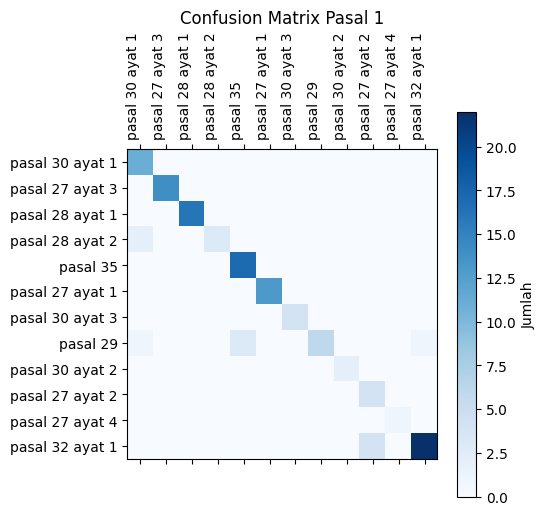

In [ ]:
cm_pasal_1 = confusion_matrix(actual_pasal_1, predicted_pasal_1)

# Menentukan label untuk sumbu x dan y
labels = data_testing['pasal_1'].unique()

# Membuat plot
fig, ax = plt.subplots(figsize=(5, 5))

# Mengubah orientasi label sumbu x menjadi vertikal
ax.set_xticklabels(labels, rotation=90, ha="right")

# Menampilkan matriks kebingungan
cax = ax.matshow(cm_pasal_1, cmap='Blues')

# Menambahkan label dan judul
plt.colorbar(cax, label='Jumlah')
plt.title('Confusion Matrix Pasal 1')

# Menambahkan tick mark pada sumbu x dan y
plt.xticks([i for i in range(len(labels))], labels)
plt.yticks([i for i in range(len(labels))], labels)

# Menampilkan plot
plt.show()

<ipython-input-22-e0138e43153e>:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels, rotation=90, ha="right")


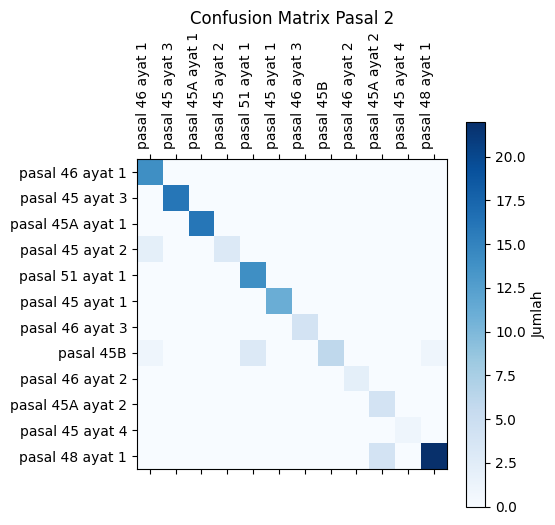

In [ ]:
cm_pasal_2 = confusion_matrix(actual_pasal_2, predicted_pasal_2)

# Menentukan label untuk sumbu x dan y
labels = data_testing['pasal_2'].unique()

# Membuat plot
fig, ax = plt.subplots(figsize=(5, 5))

# Mengubah orientasi label sumbu x menjadi vertikal
ax.set_xticklabels(labels, rotation=90, ha="right")

# Menampilkan matriks kebingungan
cax = ax.matshow(cm_pasal_2, cmap='Blues')

# Menambahkan label dan judul
plt.colorbar(cax, label='Jumlah')
plt.title('Confusion Matrix Pasal 2')

# Menambahkan tick mark pada sumbu x dan y
plt.xticks([i for i in range(len(labels))], labels)
plt.yticks([i for i in range(len(labels))], labels)

# Menampilkan plot
plt.show()

In [ ]:
from tensorflow.keras.models import save_model
import pickle

In [ ]:
# Save the model to disk
def save_model(model, filename):
    with open(filename, 'wb') as f:
        pickle.dump(model, f)

# Load the model from disk
def load_model(filename):
    with open(filename, 'rb') as f:
        model = pickle.load(f)
    return model
save_model(best_model_pasal_1, 'model_weights_pasal_1.pkl')
save_model(best_model_pasal_2, 'model_weights_pasal_2.pkl')
